In [1]:
import numpy as np
import torch
import pandas as pd 
import matplotlib.pyplot as plt
import torch.nn.functional as F
import math
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from tqdm import tqdm
import csv

cuda = True if torch.cuda.is_available() else False
print(f'Cuda is on: {cuda}')
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

Cuda is on: True


In [2]:

class CausalConv2d(torch.nn.Conv2d):
    
    ''' Causal Convolutional Neural Network in 1-D. Basically a special case of CNN-1d
    so its generator inherents from torch.nn.Conv1d class.

    '''
    def __init__(self,
                 in_channels,
                 out_channels,
                 kernel_size,
                 stride = 1,
                 dilation = 1,
                 groups = 1,
                 bias = True):
        
        super(CausalConv2d, self).__init__(
            in_channels,
            out_channels,
            kernel_size = kernel_size,
            padding = 0,
            stride = stride,
            dilation = dilation,
            groups = groups,
            bias = True)
        
        self.__padding = (kernel_size[1] - 1) * dilation
        
    def forward(self, input):
        return super(CausalConv2d, self).forward(F.pad(input, (self.__padding,0)))
    


In [3]:
class context_embedding(torch.nn.Module):
    
    '''
       Embedding the context. You can understand this as construct a model using causal CNN.
       However, the return value is sigmoided.
    '''
    def __init__(self,
                 in_channels = 1,
                 embedding_size = 256,
                 k = 5):
        super(context_embedding, self).__init__()
        
        self.causal_convolution = CausalConv2d(in_channels,
                                               embedding_size,
                                               kernel_size = k)
        
    def forward(self, x):
        
        x = self.causal_convolution(x)
        
        return F.sigmoid(x)

In [1]:
class GetData(Dataset):
    
    '''
        Get dataset 
    '''
    
    def __init__(self,target,feature,t0=96,to_predict = 24,transform=None):
        
        self.t0 = t0 # known time step
        self.transform = None
        
        length = target.shape[0]
        step = t0+to_predict ##step in one data point (known + topredict)
        
        eff_len = length - step + 1 ## effective length of the whole time series i.e. can be break in to how many data points
        
        Y = []
        F = []
        
        for i in range(eff_len):
            Y.append(target[i:step+i].unsqueeze(0))## size * time step
            F.append(feature[i:step+i].unsqueeze(0).permute(0,2,1)) ## size * feature size * time step
        
        self.target = torch.cat(Y) ## size * dimension
        self.feature = torch.cat(F)
        
        self.time = torch.cat(eff_len*[torch.arange(0,step).type(torch.float).unsqueeze(0)])
        
        
        self.masks = self._generate_square_subsequent_mask(t0)
                
        
        # print out shapes to confirm desired output
        print(self.time.shape)   
        print(self.target.shape)
        
    def __len__(self):
        return self.target.shape[0]
    
    def __getitem__(self,idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
            
        
        sample = (self.time[idx,:],
                  self.target[idx,:],
                  self.feature[idx,:],
                  self.masks) #in tuple shape, will be called in training, eval and testing.
        
        if self.transform:
            sample=self.transform(sample)
            
        return sample
    
    def _generate_square_subsequent_mask(self,t0):
        mask = torch.zeros(t0+to_predict,t0+to_predict)
        for i in range(0,t0):
            mask[i,t0:] = 1 
        for i in range(t0,t0+to_predict):
            mask[i,t0:] = 1
        mask = mask.float().masked_fill(mask == 1, float('-inf'))#.masked_fill(mask == 1, float(0.0))
        return mask

NameError: name 'Dataset' is not defined

In [5]:
def train_epoch(model,train_dl,optimizer,t0=96,to_predict = 24,):
    model.train()
    train_loss = 0
    n = 0
    for step,(x,y,feature,attention_masks) in enumerate(train_dl): # using dataloader, a library in pytorch. It helps 
                                                           # carry out batching traing
                                                            # google torch.utils.data.DataLoader
        x = x.to(device)
        y = y.to(device)
        feature = feature.to(device)
        attention_masks = attention_masks.to(device)
        optimizer.zero_grad()
        output = model(x,y,feature,attention_masks[0])

        loss = criterion(output.squeeze()[:,t0:],y[:,t0:]) # not missing data
    
        #loss = criterion(output.squeeze(),y)
        # loss = criterion(output.squeeze()[:,(t0-1-10):(t0+24-1-10)],y.cuda()[:,(t0-10):]) # missing data
        loss.backward()
        optimizer.step()
        
        train_loss += (loss.detach().item() * x.shape[0])
        n += x.shape[0]
    return train_loss/n

In [6]:
def test_epoch(model,test_dl,t0=96,to_predict = 24):
    model.eval()
    test_loss = 0
    n = 0
    with torch.no_grad(): # eliminate gradient i.e. gradients only exists in train()
        
        for step,(x,y,feature,attention_masks) in enumerate(test_dl):
            x = x.to(device)
            y = y.to(device)
            feature = feature.to(device)
            attention_masks = attention_masks.to(device)
            output = model(x,y,feature,attention_masks[0])
            
            #loss = criterion(output.squeeze()[:,t0:],y[:,t0:]) # not missing data
            loss = torch.nn.L1Loss()(output.squeeze()[:,t0:],y[:,t0:])
            # loss = criterion(output.squeeze()[:,(t0-1-10):(t0+24-1-10)],y.cuda()[:,(t0-10):]) # missing data
            
            test_loss += (loss.detach().item() * x.shape[0])
            n += x.shape[0]
            
    return test_loss/n

In [7]:
#model

class TransformerTimeSeries(torch.nn.Module):
    """
    Time Series application of transformers based on paper
    
    causal_convolution_layer parameters:
        in_channels: the number of features per time point
        out_channels: the number of features outputted per time point
        kernel_size: k is the width of the 1-D sliding kernel
        
    nn.Transformer parameters:
        d_model: the size of the embedding vector (input)
    
    PositionalEncoding parameters:
        d_model: the size of the embedding vector (positional vector)
        dropout: the dropout to be used on the sum of positional+embedding vector
    
    """
    def __init__(self,feature_dim,nhead = 16,num_layers = 8,d_model = 512,conv_len = 5,feature_weight = True,embedding_weight = True):
        super(TransformerTimeSeries,self).__init__()
        self.feature_weight = feature_weight
        self.embedding_weight = embedding_weight
        self.feature_dim = feature_dim
        self.input_embedding_y = context_embedding(1,d_model,(1,conv_len))
        
        if feature_weight:
            self.input_embedding_f = context_embedding(1,d_model,(1,conv_len))
            self.feature_projection = torch.nn.Linear(feature_dim,1)
        else:
            self.input_embedding_f = context_embedding(1,d_model,(feature_dim,conv_len))
        
        
        
        if embedding_weight:
            self.embbeding_projection = torch.nn.Linear(3,1)
            
        self.bn = torch.nn.BatchNorm2d(1)
        self.positional_embedding = torch.nn.Embedding(2*d_model,d_model)
        self.decode_layer = torch.nn.TransformerEncoderLayer(d_model=d_model,nhead=nhead)
        self.transformer_decoder = torch.nn.TransformerEncoder(self.decode_layer, num_layers = num_layers)
        
        self.fc1 = torch.nn.Linear(d_model,1)

        
    def forward(self,x,y,feature,attention_masks):
        
        
        z = y.unsqueeze(1).unsqueeze(1) ## reshape it so it can be processed by 2D CNN
        z = self.bn(z) ##Batch Norm
        
        if self.feature_dim > 1:    
            f = feature.unsqueeze(1)## embedding of nulti-dim feature
        
        else:
            f = feature.unsqueeze(1).unsqueeze(1) ## One dim feature 
        
        # input_embedding returns shape (Batch size,embedding size,sequence len) -> need (sequence len,Batch size,embedding_size)
        z_embedding = self.input_embedding_y(z).squeeze().permute(2,0,1) ## embedding of target
        
        if self.feature_weight:
            
            f_embedding = self.input_embedding_f(f).squeeze()
            f_embedding = f_embedding.permute(0,1,3,2) ## multi dim feature
            f_embedding = self.feature_projection(f_embedding).squeeze() ## linear combination of features' embeddings
            f_embedding = f_embedding.permute(2,0,1)
            
        else:
            f_embedding = self.input_embedding_f(f).squeeze().permute(2,0,1)
            
        # get my positional embeddings (Batch size, sequence_len, embedding_size) -> need (sequence len,Batch size,embedding_size)
        positional_embeddings = self.positional_embedding(x.type(torch.long)).permute(1,0,2)
        
    
        if self.embedding_weight:
            all_embedding = torch.cat([z_embedding.unsqueeze(3),positional_embeddings.unsqueeze(3),f_embedding.unsqueeze(3)],3)
            input_embedding = self.embbeding_projection(all_embedding)## the linear combination of three embeddings
            input_embedding = input_embedding.squeeze()
        else:
            input_embedding = z_embedding + positional_embeddings + f_embedding ## add up directly
        
        transformer_embedding = self.transformer_decoder(input_embedding,attention_masks)
        
        output = self.fc1(transformer_embedding.permute(1,0,2))
        

        return output

# 5 day predict one day

## AAPL
##### open

In [8]:
file_name = 'AAPL_features.csv'
with open(file_name) as f:
    data_list = csv.reader(f)
    data = []
    for row in data_list:
        data.append(row)
    f.close()
    
data = torch.tensor(np.delete(np.array(data)[1:,2:],4,axis = 1).astype(np.float)).type(torch.float)

feature_dim = data.shape[1] - 1
rate = []
for i in range(1,data.shape[0]):
    rate.append((100*(data[i,0:4] - data[i-1,0:4])/data[i-1,0:4]).reshape(1,4))
    
rate = torch.cat(rate)
rate_data = torch.cat([rate,data[1:,4:]],1)
train_size = int(data.shape[0]*0.9)
data_train = rate_data[0:train_size]
data_test = rate_data[train_size-4:]


t0 = 5
to_predict = 1
train_dataset = GetData(data_train[:,0],data_train[:,1:],t0 = t0, to_predict = to_predict)
test_dataset = GetData(data_test[:,0],data_test[:,1:],t0 = t0, to_predict = to_predict)
criterion = torch.nn.MSELoss()
# dataloaders
train_dl = DataLoader(train_dataset,batch_size=256,shuffle=True)
test_dl = DataLoader(test_dataset,batch_size=512)





model = TransformerTimeSeries(feature_dim = feature_dim,
                              nhead = 4,num_layers = 12,d_model = 512,
                              conv_len = 5,feature_weight = True,embedding_weight = True)
model = model.to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=1e-5 ,momentum = 0.9, nesterov = True)#Adam optimizer
#scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer,5e-7,3e-5,10,mode = 'exp_range',gamma = 0.9996)



train_epoch_loss = []
test_epoch_loss = []
test_best = 9999
for epoch in tqdm(range(4000)):


    l_t = train_epoch(model,train_dl,optimizer,t0,to_predict)

    train_loss = test_epoch(model,train_dl,t0,to_predict)


    test_loss = test_epoch(model,test_dl,t0,to_predict)


    if test_best > test_loss:
        test_best = test_loss
        torch.save(model.state_dict(), 'AAPL')



    train_epoch_loss.append(np.mean(train_loss))
    test_epoch_loss.append(test_loss)

    print("Epoch {}: Train loss: {} \t test loss: {}".format(epoch+1,
                                                             np.mean(train_loss),
                                                             test_loss))
    #scheduler.step()


    

torch.Size([431, 6])
torch.Size([431, 6])
torch.Size([47, 6])
torch.Size([47, 6])


  0%|                                                                                     | 0/4000 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1944: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
  0%|                                                                           | 1/4000 [00:01<1:30:50,  1.36s/it]

Epoch 1: Train loss: 1.510349254320503 	 test loss: 1.8300968408584595


  0%|                                                                           | 2/4000 [00:02<1:13:55,  1.11s/it]

Epoch 2: Train loss: 1.5094037310429902 	 test loss: 1.8293908834457397


  0%|                                                                           | 3/4000 [00:03<1:07:39,  1.02s/it]

Epoch 3: Train loss: 1.5084564943048075 	 test loss: 1.8285036087036133


  0%|                                                                           | 4/4000 [00:04<1:06:06,  1.01it/s]

Epoch 4: Train loss: 1.5074596518430246 	 test loss: 1.8274236917495728


  0%|                                                                           | 5/4000 [00:05<1:04:00,  1.04it/s]

Epoch 5: Train loss: 1.5064049513876576 	 test loss: 1.8262370824813843


  0%|                                                                           | 6/4000 [00:05<1:02:43,  1.06it/s]

Epoch 6: Train loss: 1.5053630992597327 	 test loss: 1.824978232383728


  0%|▏                                                                          | 7/4000 [00:06<1:02:33,  1.06it/s]

Epoch 7: Train loss: 1.5042282904383755 	 test loss: 1.823552131652832


  0%|▏                                                                          | 8/4000 [00:09<1:46:31,  1.60s/it]

Epoch 8: Train loss: 1.5031003465232053 	 test loss: 1.8221299648284912


  0%|▏                                                                          | 9/4000 [00:16<3:38:17,  3.28s/it]

Epoch 9: Train loss: 1.5018972509698358 	 test loss: 1.8205819129943848


  0%|▏                                                                         | 10/4000 [00:23<4:46:36,  4.31s/it]

Epoch 10: Train loss: 1.5006487446981904 	 test loss: 1.818969964981079


  0%|▏                                                                         | 11/4000 [00:29<5:26:50,  4.92s/it]

Epoch 11: Train loss: 1.4993641465003418 	 test loss: 1.8173011541366577


  0%|▏                                                                         | 12/4000 [00:36<6:07:51,  5.53s/it]

Epoch 12: Train loss: 1.4980724391693858 	 test loss: 1.8156112432479858


  0%|▏                                                                         | 13/4000 [00:43<6:34:30,  5.94s/it]

Epoch 13: Train loss: 1.4968010206510185 	 test loss: 1.813944697380066


  0%|▎                                                                         | 14/4000 [00:49<6:41:56,  6.05s/it]

Epoch 14: Train loss: 1.495462279861875 	 test loss: 1.8122048377990723


  0%|▎                                                                         | 15/4000 [00:56<6:53:17,  6.22s/it]

Epoch 15: Train loss: 1.4940608178379917 	 test loss: 1.8103984594345093


  0%|▎                                                                         | 16/4000 [01:03<7:00:09,  6.33s/it]

Epoch 16: Train loss: 1.4925957074574694 	 test loss: 1.8085157871246338


  0%|▎                                                                         | 17/4000 [01:11<7:44:17,  6.99s/it]

Epoch 17: Train loss: 1.4911515867627136 	 test loss: 1.8066200017929077


  0%|▎                                                                        | 18/4000 [01:25<10:09:37,  9.19s/it]

Epoch 18: Train loss: 1.4897738341112425 	 test loss: 1.804761290550232


  0%|▎                                                                        | 19/4000 [01:38<11:14:40, 10.17s/it]

Epoch 19: Train loss: 1.4884293040653946 	 test loss: 1.802935242652893


  0%|▎                                                                        | 20/4000 [01:49<11:28:52, 10.38s/it]

Epoch 20: Train loss: 1.4870450847939936 	 test loss: 1.801072597503662


  1%|▍                                                                        | 21/4000 [02:03<12:39:09, 11.45s/it]

Epoch 21: Train loss: 1.4856599771229684 	 test loss: 1.7991832494735718


  1%|▍                                                                        | 22/4000 [02:16<13:19:45, 12.06s/it]

Epoch 22: Train loss: 1.4842119872431745 	 test loss: 1.7972207069396973


  1%|▍                                                                        | 23/4000 [02:30<13:56:11, 12.62s/it]

Epoch 23: Train loss: 1.482763797113901 	 test loss: 1.7952536344528198


  1%|▍                                                                        | 24/4000 [02:43<14:09:19, 12.82s/it]

Epoch 24: Train loss: 1.481358475585548 	 test loss: 1.793314814567566


  1%|▍                                                                        | 25/4000 [02:57<14:19:57, 12.98s/it]

Epoch 25: Train loss: 1.4799415821818906 	 test loss: 1.791357159614563


  1%|▍                                                                        | 26/4000 [03:11<14:39:42, 13.28s/it]

Epoch 26: Train loss: 1.4785616339774252 	 test loss: 1.7894538640975952


  1%|▍                                                                        | 27/4000 [03:26<15:09:23, 13.73s/it]

Epoch 27: Train loss: 1.4771890023468266 	 test loss: 1.787598729133606


  1%|▌                                                                        | 28/4000 [03:40<15:18:53, 13.88s/it]

Epoch 28: Train loss: 1.4757940157936786 	 test loss: 1.7857131958007812


  1%|▌                                                                        | 29/4000 [03:53<15:03:46, 13.66s/it]

Epoch 29: Train loss: 1.4744023068045242 	 test loss: 1.7838257551193237


  1%|▌                                                                        | 30/4000 [04:05<14:30:07, 13.15s/it]

Epoch 30: Train loss: 1.4729972165034708 	 test loss: 1.7818964719772339


  1%|▌                                                                        | 31/4000 [04:18<14:35:46, 13.24s/it]

Epoch 31: Train loss: 1.4716789160969639 	 test loss: 1.7800549268722534


  1%|▌                                                                        | 32/4000 [04:32<14:50:29, 13.47s/it]

Epoch 32: Train loss: 1.470360843875292 	 test loss: 1.7782249450683594


  1%|▌                                                                        | 33/4000 [04:45<14:25:17, 13.09s/it]

Epoch 33: Train loss: 1.4689783635106275 	 test loss: 1.776330590248108


  1%|▌                                                                        | 34/4000 [04:57<14:06:56, 12.81s/it]

Epoch 34: Train loss: 1.4676017481876913 	 test loss: 1.7744536399841309


  1%|▋                                                                        | 35/4000 [05:09<13:54:55, 12.63s/it]

Epoch 35: Train loss: 1.4662475444877783 	 test loss: 1.7726095914840698


  1%|▋                                                                        | 36/4000 [05:23<14:29:18, 13.16s/it]

Epoch 36: Train loss: 1.464833180755031 	 test loss: 1.770677924156189


  1%|▋                                                                        | 37/4000 [05:36<14:25:25, 13.10s/it]

Epoch 37: Train loss: 1.4634394371869115 	 test loss: 1.7687393426895142


  1%|▋                                                                        | 38/4000 [05:49<14:08:53, 12.86s/it]

Epoch 38: Train loss: 1.4619803987357014 	 test loss: 1.7667040824890137


  1%|▋                                                                        | 39/4000 [06:03<14:34:48, 13.25s/it]

Epoch 39: Train loss: 1.4605109730342147 	 test loss: 1.7646386623382568


  1%|▋                                                                        | 40/4000 [06:16<14:33:38, 13.24s/it]

Epoch 40: Train loss: 1.4590650011381252 	 test loss: 1.7626115083694458


  1%|▋                                                                        | 41/4000 [06:30<14:58:46, 13.62s/it]

Epoch 41: Train loss: 1.457665331678988 	 test loss: 1.7606444358825684


  1%|▊                                                                        | 42/4000 [06:45<15:22:51, 13.99s/it]

Epoch 42: Train loss: 1.4561609494437198 	 test loss: 1.7585433721542358


  1%|▊                                                                        | 43/4000 [06:58<14:48:20, 13.47s/it]

Epoch 43: Train loss: 1.4545411438510478 	 test loss: 1.7563024759292603


  1%|▊                                                                        | 44/4000 [07:11<14:54:51, 13.57s/it]

Epoch 44: Train loss: 1.4529524518829486 	 test loss: 1.7540701627731323


  1%|▊                                                                        | 45/4000 [07:25<14:47:02, 13.46s/it]

Epoch 45: Train loss: 1.451411812045458 	 test loss: 1.75187349319458


  1%|▊                                                                        | 46/4000 [07:38<14:48:17, 13.48s/it]

Epoch 46: Train loss: 1.4499570620862072 	 test loss: 1.7498034238815308


  1%|▊                                                                        | 47/4000 [07:51<14:43:28, 13.41s/it]

Epoch 47: Train loss: 1.4484295977793824 	 test loss: 1.747630000114441


  1%|▉                                                                        | 48/4000 [08:03<14:14:03, 12.97s/it]

Epoch 48: Train loss: 1.4469607877620687 	 test loss: 1.7455028295516968


  1%|▉                                                                        | 49/4000 [08:18<14:50:07, 13.52s/it]

Epoch 49: Train loss: 1.4454388217417105 	 test loss: 1.7432711124420166


  1%|▉                                                                        | 50/4000 [08:32<14:56:03, 13.61s/it]

Epoch 50: Train loss: 1.4439140826532846 	 test loss: 1.7410796880722046


  1%|▉                                                                        | 51/4000 [08:45<14:52:48, 13.57s/it]

Epoch 51: Train loss: 1.4423661887507429 	 test loss: 1.738769292831421


  1%|▉                                                                        | 52/4000 [08:58<14:34:45, 13.29s/it]

Epoch 52: Train loss: 1.440745070749535 	 test loss: 1.7363256216049194


  1%|▉                                                                        | 53/4000 [09:11<14:27:07, 13.18s/it]

Epoch 53: Train loss: 1.439270501623574 	 test loss: 1.7340385913848877


  1%|▉                                                                        | 54/4000 [09:25<14:44:44, 13.45s/it]

Epoch 54: Train loss: 1.437739181961095 	 test loss: 1.7316659688949585


  1%|█                                                                        | 55/4000 [09:37<14:09:33, 12.92s/it]

Epoch 55: Train loss: 1.4361738013557381 	 test loss: 1.7291898727416992


  1%|█                                                                        | 56/4000 [09:50<14:21:06, 13.10s/it]

Epoch 56: Train loss: 1.4347164971092738 	 test loss: 1.726712942123413


  1%|█                                                                        | 57/4000 [10:00<13:22:49, 12.22s/it]

Epoch 57: Train loss: 1.4332518751825922 	 test loss: 1.724307894706726


  1%|█                                                                        | 58/4000 [10:13<13:23:13, 12.23s/it]

Epoch 58: Train loss: 1.4316559250006267 	 test loss: 1.7217811346054077


  1%|█                                                                        | 59/4000 [10:26<13:49:05, 12.62s/it]

Epoch 59: Train loss: 1.430049894857296 	 test loss: 1.7192573547363281


  2%|█                                                                        | 60/4000 [10:38<13:34:28, 12.40s/it]

Epoch 60: Train loss: 1.4283524997826242 	 test loss: 1.716545820236206


  2%|█                                                                        | 61/4000 [10:50<13:30:35, 12.35s/it]

Epoch 61: Train loss: 1.4266333317258795 	 test loss: 1.713768720626831


  2%|█▏                                                                       | 62/4000 [11:02<13:24:30, 12.26s/it]

Epoch 62: Train loss: 1.4248845380862738 	 test loss: 1.7109959125518799


  2%|█▏                                                                       | 63/4000 [11:15<13:32:07, 12.38s/it]

Epoch 63: Train loss: 1.4230318365406824 	 test loss: 1.7081000804901123


  2%|█▏                                                                       | 64/4000 [11:27<13:23:57, 12.26s/it]

Epoch 64: Train loss: 1.4210021044981176 	 test loss: 1.7049287557601929


  2%|█▏                                                                       | 65/4000 [11:39<13:23:34, 12.25s/it]

Epoch 65: Train loss: 1.4189771723581301 	 test loss: 1.7017645835876465


  2%|█▏                                                                       | 66/4000 [11:51<13:07:08, 12.01s/it]

Epoch 66: Train loss: 1.416840816318574 	 test loss: 1.6983940601348877


  2%|█▏                                                                       | 67/4000 [12:04<13:25:34, 12.29s/it]

Epoch 67: Train loss: 1.4149814910512513 	 test loss: 1.695371389389038


  2%|█▏                                                                       | 68/4000 [12:16<13:24:13, 12.27s/it]

Epoch 68: Train loss: 1.4129958498505595 	 test loss: 1.6921061277389526


  2%|█▎                                                                       | 69/4000 [12:29<13:39:12, 12.50s/it]

Epoch 69: Train loss: 1.4110026074672797 	 test loss: 1.688875675201416


  2%|█▎                                                                       | 70/4000 [12:40<13:16:45, 12.16s/it]

Epoch 70: Train loss: 1.4089071399374518 	 test loss: 1.6854952573776245


  2%|█▎                                                                       | 71/4000 [12:53<13:30:15, 12.37s/it]

Epoch 71: Train loss: 1.4067750474969638 	 test loss: 1.6821340322494507


  2%|█▎                                                                       | 72/4000 [13:05<13:19:39, 12.21s/it]

Epoch 72: Train loss: 1.404650966142004 	 test loss: 1.6787251234054565


  2%|█▎                                                                       | 73/4000 [13:17<13:19:50, 12.22s/it]

Epoch 73: Train loss: 1.4023835479245108 	 test loss: 1.6756503582000732


  2%|█▎                                                                       | 74/4000 [13:30<13:38:31, 12.51s/it]

Epoch 74: Train loss: 1.400248792221264 	 test loss: 1.6727187633514404


  2%|█▎                                                                       | 75/4000 [13:43<13:45:05, 12.61s/it]

Epoch 75: Train loss: 1.3980064607828233 	 test loss: 1.6696110963821411


  2%|█▍                                                                       | 76/4000 [13:55<13:32:45, 12.43s/it]

Epoch 76: Train loss: 1.3956388058076048 	 test loss: 1.6663155555725098


  2%|█▍                                                                       | 77/4000 [14:08<13:39:01, 12.53s/it]

Epoch 77: Train loss: 1.393432598379538 	 test loss: 1.6632425785064697


  2%|█▍                                                                       | 78/4000 [14:22<14:11:10, 13.02s/it]

Epoch 78: Train loss: 1.3912438707395938 	 test loss: 1.6601672172546387


  2%|█▍                                                                       | 79/4000 [14:34<13:50:33, 12.71s/it]

Epoch 79: Train loss: 1.3887081151771987 	 test loss: 1.6565073728561401


  2%|█▍                                                                       | 80/4000 [14:48<14:07:03, 12.97s/it]

Epoch 80: Train loss: 1.3862043124063939 	 test loss: 1.6528592109680176


  2%|█▍                                                                       | 81/4000 [15:00<13:51:44, 12.73s/it]

Epoch 81: Train loss: 1.3836237750861042 	 test loss: 1.6490508317947388


  2%|█▍                                                                       | 82/4000 [15:11<13:26:30, 12.35s/it]

Epoch 82: Train loss: 1.3811916588630588 	 test loss: 1.6455169916152954


  2%|█▌                                                                       | 83/4000 [15:23<13:19:16, 12.24s/it]

Epoch 83: Train loss: 1.37854922122026 	 test loss: 1.6416908502578735


  2%|█▌                                                                       | 84/4000 [15:35<13:16:43, 12.21s/it]

Epoch 84: Train loss: 1.375757976640405 	 test loss: 1.6376069784164429


  2%|█▌                                                                       | 85/4000 [15:48<13:16:59, 12.21s/it]

Epoch 85: Train loss: 1.3726706219936469 	 test loss: 1.632981777191162


  2%|█▌                                                                       | 86/4000 [16:01<13:36:14, 12.51s/it]

Epoch 86: Train loss: 1.369581038879961 	 test loss: 1.6283892393112183


  2%|█▌                                                                       | 87/4000 [16:14<13:49:57, 12.73s/it]

Epoch 87: Train loss: 1.3666032735266984 	 test loss: 1.6238373517990112


  2%|█▌                                                                       | 88/4000 [16:25<13:19:07, 12.26s/it]

Epoch 88: Train loss: 1.3635494543062285 	 test loss: 1.6192547082901


  2%|█▌                                                                       | 89/4000 [16:37<13:07:20, 12.08s/it]

Epoch 89: Train loss: 1.360345407870972 	 test loss: 1.614580750465393


  2%|█▋                                                                       | 90/4000 [16:47<12:37:02, 11.62s/it]

Epoch 90: Train loss: 1.3572625668585439 	 test loss: 1.6103469133377075


  2%|█▋                                                                       | 91/4000 [17:00<12:52:28, 11.86s/it]

Epoch 91: Train loss: 1.354529870635119 	 test loss: 1.6066296100616455


  2%|█▋                                                                       | 92/4000 [17:13<13:15:58, 12.22s/it]

Epoch 92: Train loss: 1.351765589205129 	 test loss: 1.60293447971344


  2%|█▋                                                                       | 93/4000 [17:26<13:24:35, 12.36s/it]

Epoch 93: Train loss: 1.3487801900319323 	 test loss: 1.5986392498016357


  2%|█▋                                                                       | 94/4000 [17:39<13:44:39, 12.67s/it]

Epoch 94: Train loss: 1.3452757951001832 	 test loss: 1.5937385559082031


  2%|█▋                                                                       | 95/4000 [17:52<13:50:48, 12.77s/it]

Epoch 95: Train loss: 1.34157483539006 	 test loss: 1.5889090299606323


  2%|█▊                                                                       | 96/4000 [18:04<13:36:52, 12.55s/it]

Epoch 96: Train loss: 1.3380582811107768 	 test loss: 1.5838228464126587


  2%|█▊                                                                       | 97/4000 [18:17<13:36:47, 12.56s/it]

Epoch 97: Train loss: 1.3342240412661206 	 test loss: 1.5779378414154053


  2%|█▊                                                                       | 98/4000 [18:31<14:04:35, 12.99s/it]

Epoch 98: Train loss: 1.3302176894831823 	 test loss: 1.5713164806365967


  2%|█▊                                                                       | 99/4000 [18:43<13:54:03, 12.83s/it]

Epoch 99: Train loss: 1.3260352218787244 	 test loss: 1.5647172927856445


  2%|█▊                                                                      | 100/4000 [18:55<13:39:25, 12.61s/it]

Epoch 100: Train loss: 1.3218481244731115 	 test loss: 1.5584112405776978


  3%|█▊                                                                      | 101/4000 [19:05<12:54:13, 11.91s/it]

Epoch 101: Train loss: 1.3177518498869893 	 test loss: 1.553016185760498


  3%|█▊                                                                      | 102/4000 [19:18<13:02:43, 12.05s/it]

Epoch 102: Train loss: 1.3135104497458154 	 test loss: 1.5473814010620117


  3%|█▊                                                                      | 103/4000 [19:28<12:35:19, 11.63s/it]

Epoch 103: Train loss: 1.3090836719681105 	 test loss: 1.5413087606430054


  3%|█▊                                                                      | 104/4000 [19:40<12:41:39, 11.73s/it]

Epoch 104: Train loss: 1.3046816313626317 	 test loss: 1.5361804962158203


  3%|█▉                                                                      | 105/4000 [19:53<13:01:50, 12.04s/it]

Epoch 105: Train loss: 1.3004597926084513 	 test loss: 1.5327033996582031


  3%|█▉                                                                      | 106/4000 [20:05<13:05:50, 12.11s/it]

Epoch 106: Train loss: 1.2961106092913244 	 test loss: 1.5282176733016968


  3%|█▉                                                                      | 107/4000 [20:18<13:07:32, 12.14s/it]

Epoch 107: Train loss: 1.291010004185192 	 test loss: 1.5213282108306885


  3%|█▉                                                                      | 108/4000 [20:27<12:10:27, 11.26s/it]

Epoch 108: Train loss: 1.285888817360119 	 test loss: 1.5135210752487183


  3%|█▉                                                                      | 109/4000 [20:38<12:08:28, 11.23s/it]

Epoch 109: Train loss: 1.281015905039493 	 test loss: 1.5058456659317017


  3%|█▉                                                                      | 110/4000 [20:49<12:03:20, 11.16s/it]

Epoch 110: Train loss: 1.2761779647415585 	 test loss: 1.4976658821105957


  3%|█▉                                                                      | 111/4000 [21:01<12:14:14, 11.33s/it]

Epoch 111: Train loss: 1.2712546003390355 	 test loss: 1.489660620689392


  3%|██                                                                      | 112/4000 [21:12<12:14:40, 11.34s/it]

Epoch 112: Train loss: 1.2657944973549544 	 test loss: 1.4813507795333862


  3%|██                                                                      | 113/4000 [21:25<12:36:21, 11.68s/it]

Epoch 113: Train loss: 1.2605519051341612 	 test loss: 1.47442626953125


  3%|██                                                                      | 114/4000 [21:34<11:51:02, 10.98s/it]

Epoch 114: Train loss: 1.2553364431221912 	 test loss: 1.4685298204421997


  3%|██                                                                      | 115/4000 [21:44<11:36:38, 10.76s/it]

Epoch 115: Train loss: 1.2497962879194184 	 test loss: 1.4622372388839722


  3%|██                                                                      | 116/4000 [21:55<11:38:43, 10.79s/it]

Epoch 116: Train loss: 1.2440278967129381 	 test loss: 1.4553699493408203


  3%|██                                                                      | 117/4000 [22:05<11:12:49, 10.40s/it]

Epoch 117: Train loss: 1.2382458924140842 	 test loss: 1.4483330249786377


  3%|██                                                                      | 118/4000 [22:17<11:43:12, 10.87s/it]

Epoch 118: Train loss: 1.2319328486227934 	 test loss: 1.440195083618164


  3%|██▏                                                                     | 119/4000 [22:24<10:33:20,  9.79s/it]

Epoch 119: Train loss: 1.225759465843785 	 test loss: 1.433322787284851


  3%|██▏                                                                      | 120/4000 [22:32<9:57:05,  9.23s/it]

Epoch 120: Train loss: 1.219455004014991 	 test loss: 1.425787091255188


  3%|██▏                                                                     | 121/4000 [22:44<10:55:01, 10.13s/it]

Epoch 121: Train loss: 1.2133535279475343 	 test loss: 1.4201258420944214


  3%|██▏                                                                     | 122/4000 [22:53<10:29:27,  9.74s/it]

Epoch 122: Train loss: 1.206698823417699 	 test loss: 1.414298176765442


  3%|██▏                                                                     | 123/4000 [23:04<10:56:07, 10.15s/it]

Epoch 123: Train loss: 1.2003296312212668 	 test loss: 1.4090348482131958


  3%|██▏                                                                     | 124/4000 [23:17<11:53:09, 11.04s/it]

Epoch 124: Train loss: 1.1932862059422822 	 test loss: 1.4018460512161255


  3%|██▎                                                                     | 125/4000 [23:31<12:40:56, 11.78s/it]

Epoch 125: Train loss: 1.1868023258350842 	 test loss: 1.3958256244659424


  3%|██▎                                                                     | 126/4000 [23:44<13:08:25, 12.21s/it]

Epoch 126: Train loss: 1.1793661894765088 	 test loss: 1.3911768198013306


  3%|██▎                                                                     | 127/4000 [23:57<13:19:52, 12.39s/it]

Epoch 127: Train loss: 1.1727209710742923 	 test loss: 1.387940526008606


  3%|██▎                                                                     | 128/4000 [24:05<12:12:07, 11.34s/it]

Epoch 128: Train loss: 1.1662027094590968 	 test loss: 1.3833284378051758


  3%|██▎                                                                     | 129/4000 [24:17<12:11:26, 11.34s/it]

Epoch 129: Train loss: 1.1589950342465996 	 test loss: 1.3766677379608154


  3%|██▎                                                                     | 130/4000 [24:23<10:32:07,  9.80s/it]

Epoch 130: Train loss: 1.1514533686250656 	 test loss: 1.3688127994537354


  3%|██▍                                                                      | 131/4000 [24:29<9:23:52,  8.74s/it]

Epoch 131: Train loss: 1.1438253830314513 	 test loss: 1.3608607053756714


  3%|██▍                                                                      | 132/4000 [24:37<8:55:01,  8.30s/it]

Epoch 132: Train loss: 1.1359736269422032 	 test loss: 1.3521392345428467


  3%|██▍                                                                      | 133/4000 [24:43<8:21:52,  7.79s/it]

Epoch 133: Train loss: 1.128111159441919 	 test loss: 1.3439407348632812


  3%|██▍                                                                      | 134/4000 [24:49<7:51:53,  7.32s/it]

Epoch 134: Train loss: 1.1204716451206782 	 test loss: 1.3378490209579468


  3%|██▍                                                                      | 135/4000 [24:56<7:38:20,  7.12s/it]

Epoch 135: Train loss: 1.1136322162544092 	 test loss: 1.332845687866211


  3%|██▍                                                                      | 136/4000 [25:03<7:35:14,  7.07s/it]

Epoch 136: Train loss: 1.1049118725163753 	 test loss: 1.3243632316589355


  3%|██▌                                                                      | 137/4000 [25:10<7:25:18,  6.92s/it]

Epoch 137: Train loss: 1.0957734452046264 	 test loss: 1.3133900165557861


  3%|██▌                                                                      | 138/4000 [25:16<7:19:30,  6.83s/it]

Epoch 138: Train loss: 1.0873308726640423 	 test loss: 1.3056925535202026


  3%|██▌                                                                      | 139/4000 [25:23<7:15:26,  6.77s/it]

Epoch 139: Train loss: 1.079332754119643 	 test loss: 1.3001729249954224


  4%|██▌                                                                      | 140/4000 [25:29<7:05:47,  6.62s/it]

Epoch 140: Train loss: 1.070314071294603 	 test loss: 1.2923202514648438


  4%|██▌                                                                      | 141/4000 [25:35<6:59:14,  6.52s/it]

Epoch 141: Train loss: 1.0612075475418374 	 test loss: 1.2830513715744019


  4%|██▌                                                                      | 142/4000 [25:43<7:13:26,  6.74s/it]

Epoch 142: Train loss: 1.051872381478064 	 test loss: 1.2760119438171387


  4%|██▌                                                                      | 143/4000 [25:49<7:10:39,  6.70s/it]

Epoch 143: Train loss: 1.0429947484120417 	 test loss: 1.271521806716919


  4%|██▋                                                                      | 144/4000 [25:56<7:08:04,  6.66s/it]

Epoch 144: Train loss: 1.0339679780249806 	 test loss: 1.2659889459609985


  4%|██▋                                                                      | 145/4000 [26:03<7:11:41,  6.72s/it]

Epoch 145: Train loss: 1.0255115524522114 	 test loss: 1.2610466480255127


  4%|██▋                                                                      | 146/4000 [26:08<6:52:32,  6.42s/it]

Epoch 146: Train loss: 1.0187484829442408 	 test loss: 1.2582842111587524


  4%|██▋                                                                      | 147/4000 [26:16<7:07:33,  6.66s/it]

Epoch 147: Train loss: 1.0093266999915138 	 test loss: 1.2509251832962036


  4%|██▋                                                                      | 148/4000 [26:22<7:07:22,  6.66s/it]

Epoch 148: Train loss: 0.999197930028433 	 test loss: 1.242626428604126


  4%|██▋                                                                      | 149/4000 [26:29<7:05:25,  6.63s/it]

Epoch 149: Train loss: 0.9886937585341682 	 test loss: 1.233284831047058


  4%|██▋                                                                      | 150/4000 [26:35<7:05:30,  6.63s/it]

Epoch 150: Train loss: 0.9772230123975714 	 test loss: 1.2216706275939941


  4%|██▊                                                                      | 151/4000 [26:42<7:04:07,  6.61s/it]

Epoch 151: Train loss: 0.9681766077426636 	 test loss: 1.2151081562042236


  4%|██▊                                                                      | 152/4000 [26:49<7:04:51,  6.62s/it]

Epoch 152: Train loss: 0.9570032482634011 	 test loss: 1.204009771347046


  4%|██▊                                                                      | 153/4000 [26:55<7:04:19,  6.62s/it]

Epoch 153: Train loss: 0.9478927045853122 	 test loss: 1.1983225345611572


  4%|██▊                                                                      | 154/4000 [27:02<7:03:32,  6.61s/it]

Epoch 154: Train loss: 0.9370617096219428 	 test loss: 1.188488483428955


  4%|██▊                                                                      | 155/4000 [27:08<7:03:11,  6.60s/it]

Epoch 155: Train loss: 0.9253864678318705 	 test loss: 1.175557017326355


  4%|██▊                                                                      | 156/4000 [27:15<7:03:26,  6.61s/it]

Epoch 156: Train loss: 0.9151267251669669 	 test loss: 1.1676422357559204


  4%|██▊                                                                      | 157/4000 [27:22<7:03:34,  6.61s/it]

Epoch 157: Train loss: 0.905424649505217 	 test loss: 1.160988450050354


  4%|██▉                                                                      | 158/4000 [27:28<7:03:13,  6.61s/it]

Epoch 158: Train loss: 0.8967632797920511 	 test loss: 1.1564456224441528


  4%|██▉                                                                      | 159/4000 [27:35<7:03:00,  6.61s/it]

Epoch 159: Train loss: 0.8830221291207935 	 test loss: 1.140342354774475


  4%|██▉                                                                      | 160/4000 [27:41<7:03:02,  6.61s/it]

Epoch 160: Train loss: 0.8715526414581352 	 test loss: 1.1268717050552368


  4%|██▉                                                                      | 161/4000 [27:48<6:56:31,  6.51s/it]

Epoch 161: Train loss: 0.859695964512305 	 test loss: 1.1090153455734253


  4%|██▉                                                                      | 162/4000 [27:55<7:04:33,  6.64s/it]

Epoch 162: Train loss: 0.8481993328114397 	 test loss: 1.0984158515930176


  4%|██▉                                                                      | 163/4000 [28:01<7:03:49,  6.63s/it]

Epoch 163: Train loss: 0.8375079924988359 	 test loss: 1.0944511890411377


  4%|██▉                                                                      | 164/4000 [28:08<7:02:13,  6.60s/it]

Epoch 164: Train loss: 0.8272616473262105 	 test loss: 1.0866332054138184


  4%|███                                                                      | 165/4000 [28:14<7:03:19,  6.62s/it]

Epoch 165: Train loss: 0.8154066470548891 	 test loss: 1.0735522508621216


  4%|███                                                                      | 166/4000 [28:21<7:02:49,  6.62s/it]

Epoch 166: Train loss: 0.8026695915275273 	 test loss: 1.0576097965240479


  4%|███                                                                      | 167/4000 [28:28<7:02:25,  6.61s/it]

Epoch 167: Train loss: 0.7940938978903255 	 test loss: 1.054467797279358


  4%|███                                                                      | 168/4000 [28:34<6:55:31,  6.51s/it]

Epoch 168: Train loss: 0.7837024474918427 	 test loss: 1.0451760292053223


  4%|███                                                                      | 169/4000 [28:41<7:03:42,  6.64s/it]

Epoch 169: Train loss: 0.7681724972625343 	 test loss: 1.0236082077026367


  4%|███                                                                      | 170/4000 [28:47<7:02:58,  6.63s/it]

Epoch 170: Train loss: 0.7563286794310656 	 test loss: 1.0111018419265747


  4%|███                                                                      | 171/4000 [28:53<6:49:41,  6.42s/it]

Epoch 171: Train loss: 0.7449809330798633 	 test loss: 1.0000556707382202


  4%|███▏                                                                     | 172/4000 [29:01<7:10:48,  6.75s/it]

Epoch 172: Train loss: 0.732085690835789 	 test loss: 0.9853597283363342


  4%|███▏                                                                     | 173/4000 [29:07<7:05:39,  6.67s/it]

Epoch 173: Train loss: 0.7195721048766665 	 test loss: 0.972536563873291


  4%|███▏                                                                     | 174/4000 [29:14<7:01:37,  6.61s/it]

Epoch 174: Train loss: 0.7069628903871346 	 test loss: 0.9590733647346497


  4%|███▏                                                                     | 175/4000 [29:20<6:55:09,  6.51s/it]

Epoch 175: Train loss: 0.6960993680212725 	 test loss: 0.9485093355178833


  4%|███▏                                                                     | 176/4000 [29:27<7:05:44,  6.68s/it]

Epoch 176: Train loss: 0.6827254036739642 	 test loss: 0.9301663637161255


  4%|███▏                                                                     | 177/4000 [29:33<6:55:01,  6.51s/it]

Epoch 177: Train loss: 0.6724555770371741 	 test loss: 0.9147987365722656


  4%|███▏                                                                     | 178/4000 [29:40<7:03:05,  6.64s/it]

Epoch 178: Train loss: 0.6611071096218932 	 test loss: 0.9098906517028809


  4%|███▎                                                                     | 179/4000 [29:47<7:01:37,  6.62s/it]

Epoch 179: Train loss: 0.6539818893452531 	 test loss: 0.9052397012710571


  4%|███▎                                                                     | 180/4000 [29:53<6:58:27,  6.57s/it]

Epoch 180: Train loss: 0.6409872887859211 	 test loss: 0.8887684345245361


  5%|███▎                                                                     | 181/4000 [30:00<7:02:19,  6.64s/it]

Epoch 181: Train loss: 0.6298507987208267 	 test loss: 0.8735466599464417


  5%|███▎                                                                     | 182/4000 [30:07<7:01:10,  6.62s/it]

Epoch 182: Train loss: 0.6240731470822735 	 test loss: 0.8689602613449097


  5%|███▎                                                                     | 183/4000 [30:13<6:58:10,  6.57s/it]

Epoch 183: Train loss: 0.6109771421503302 	 test loss: 0.850048303604126


  5%|███▎                                                                     | 184/4000 [30:20<7:00:12,  6.61s/it]

Epoch 184: Train loss: 0.5991352929316651 	 test loss: 0.8355610370635986


  5%|███▍                                                                     | 185/4000 [30:26<6:55:16,  6.53s/it]

Epoch 185: Train loss: 0.5941695765940054 	 test loss: 0.8303701281547546


  5%|███▍                                                                     | 186/4000 [30:33<7:03:08,  6.66s/it]

Epoch 186: Train loss: 0.5833270259357107 	 test loss: 0.8192987442016602


  5%|███▍                                                                     | 187/4000 [30:40<7:00:39,  6.62s/it]

Epoch 187: Train loss: 0.5765986464692933 	 test loss: 0.8137900829315186


  5%|███▍                                                                     | 188/4000 [30:46<6:54:56,  6.53s/it]

Epoch 188: Train loss: 0.5618300829298811 	 test loss: 0.7993896007537842


  5%|███▍                                                                     | 189/4000 [30:53<7:02:35,  6.65s/it]

Epoch 189: Train loss: 0.5541513869214777 	 test loss: 0.7946946024894714


  5%|███▍                                                                     | 190/4000 [31:00<7:14:19,  6.84s/it]

Epoch 190: Train loss: 0.5515920988644912 	 test loss: 0.7914785742759705


  5%|███▍                                                                     | 191/4000 [31:12<8:50:17,  8.35s/it]

Epoch 191: Train loss: 0.540940323451279 	 test loss: 0.782983660697937


  5%|███▌                                                                     | 192/4000 [31:19<8:16:42,  7.83s/it]

Epoch 192: Train loss: 0.5269079059016677 	 test loss: 0.7713496088981628


  5%|███▌                                                                     | 193/4000 [31:26<8:02:06,  7.60s/it]

Epoch 193: Train loss: 0.5224701980703668 	 test loss: 0.763213574886322


  5%|███▌                                                                     | 194/4000 [31:33<7:46:23,  7.35s/it]

Epoch 194: Train loss: 0.5120180834888582 	 test loss: 0.7589988708496094


  5%|███▌                                                                     | 195/4000 [31:39<7:32:34,  7.14s/it]

Epoch 195: Train loss: 0.507878356909254 	 test loss: 0.7576473951339722


  5%|███▌                                                                     | 196/4000 [31:46<7:22:05,  6.97s/it]

Epoch 196: Train loss: 0.4990288929153761 	 test loss: 0.7489820122718811


  5%|███▌                                                                     | 197/4000 [31:52<7:15:08,  6.87s/it]

Epoch 197: Train loss: 0.49420654199792724 	 test loss: 0.7460218667984009


  5%|███▋                                                                     | 199/4000 [32:00<5:16:23,  4.99s/it]

Epoch 198: Train loss: 0.4913992914965424 	 test loss: 0.7438949942588806
Epoch 199: Train loss: 0.49741022140133406 	 test loss: 0.7459012269973755


  5%|███▋                                                                     | 200/4000 [32:12<7:25:55,  7.04s/it]

Epoch 200: Train loss: 0.48932068357611475 	 test loss: 0.7388993501663208


  5%|███▋                                                                     | 201/4000 [32:25<9:19:30,  8.84s/it]

Epoch 201: Train loss: 0.481100475013671 	 test loss: 0.7311937808990479


  5%|███▋                                                                    | 202/4000 [32:39<10:49:28, 10.26s/it]

Epoch 202: Train loss: 0.4736487942201079 	 test loss: 0.7222145199775696


  5%|███▋                                                                    | 203/4000 [32:52<11:46:45, 11.17s/it]

Epoch 203: Train loss: 0.4696525351215681 	 test loss: 0.7155467867851257


  5%|███▋                                                                    | 204/4000 [32:58<10:06:54,  9.59s/it]

Epoch 204: Train loss: 0.46660034686949303 	 test loss: 0.7105891108512878


  5%|███▋                                                                     | 205/4000 [32:58<7:10:36,  6.81s/it]

Epoch 205: Train loss: 0.4783911451247895 	 test loss: 0.7211291193962097


  5%|███▊                                                                     | 206/4000 [32:58<5:06:20,  4.84s/it]

Epoch 206: Train loss: 0.4696463335417816 	 test loss: 0.7128954529762268


  5%|███▊                                                                     | 207/4000 [33:04<5:28:48,  5.20s/it]

Epoch 207: Train loss: 0.46140247694024356 	 test loss: 0.7031514644622803


  5%|███▊                                                                     | 208/4000 [33:12<6:08:42,  5.83s/it]

Epoch 208: Train loss: 0.45920739075700534 	 test loss: 0.6974024176597595


  5%|███▊                                                                     | 209/4000 [33:18<6:23:17,  6.07s/it]

Epoch 209: Train loss: 0.45761948450535467 	 test loss: 0.6907713413238525


  5%|███▊                                                                     | 210/4000 [33:25<6:32:24,  6.21s/it]

Epoch 210: Train loss: 0.4556771845247795 	 test loss: 0.6870100498199463


  5%|███▊                                                                     | 211/4000 [33:31<6:40:25,  6.34s/it]

Epoch 211: Train loss: 0.45510091375032324 	 test loss: 0.6848849058151245


  5%|███▊                                                                     | 212/4000 [33:32<4:45:35,  4.52s/it]

Epoch 212: Train loss: 0.4566908287891379 	 test loss: 0.6871084570884705


  5%|███▉                                                                     | 213/4000 [33:37<5:07:10,  4.87s/it]

Epoch 213: Train loss: 0.45435969016391553 	 test loss: 0.6816150546073914


  5%|███▉                                                                     | 214/4000 [33:45<5:52:19,  5.58s/it]

Epoch 214: Train loss: 0.4542504652746869 	 test loss: 0.6786134243011475


  5%|███▉                                                                     | 215/4000 [33:51<6:10:54,  5.88s/it]

Epoch 215: Train loss: 0.45490457909289755 	 test loss: 0.6765298843383789


  5%|███▉                                                                     | 216/4000 [33:57<6:12:09,  5.90s/it]

Epoch 216: Train loss: 0.4549494546831622 	 test loss: 0.6729845404624939


  5%|███▉                                                                     | 217/4000 [34:04<6:38:28,  6.32s/it]

Epoch 217: Train loss: 0.45164114713945414 	 test loss: 0.6647783517837524


  5%|███▉                                                                     | 218/4000 [34:11<6:43:33,  6.40s/it]

Epoch 218: Train loss: 0.45016330764077933 	 test loss: 0.6610056757926941


  5%|███▉                                                                     | 219/4000 [34:17<6:34:51,  6.27s/it]

Epoch 219: Train loss: 0.4573319074449296 	 test loss: 0.6532604098320007


  6%|████                                                                     | 220/4000 [34:24<6:53:17,  6.56s/it]

Epoch 220: Train loss: 0.45076712364387067 	 test loss: 0.6504678726196289


  6%|████                                                                     | 221/4000 [34:37<8:52:21,  8.45s/it]

Epoch 221: Train loss: 0.44734565792670106 	 test loss: 0.6503046751022339


  6%|████                                                                     | 222/4000 [34:44<8:24:08,  8.01s/it]

Epoch 222: Train loss: 0.4457805674618192 	 test loss: 0.6488090753555298


  6%|████                                                                     | 223/4000 [34:44<5:57:21,  5.68s/it]

Epoch 223: Train loss: 0.4477725840085067 	 test loss: 0.6509788036346436


  6%|████                                                                     | 224/4000 [34:50<5:57:42,  5.68s/it]

Epoch 224: Train loss: 0.4469657434526563 	 test loss: 0.6480914950370789


  6%|████                                                                     | 225/4000 [34:57<6:27:06,  6.15s/it]

Epoch 225: Train loss: 0.4460933651005862 	 test loss: 0.645818293094635


  6%|████                                                                     | 226/4000 [35:04<6:35:22,  6.29s/it]

Epoch 226: Train loss: 0.4387894890286253 	 test loss: 0.6322314143180847


  6%|████▏                                                                    | 227/4000 [35:11<6:41:14,  6.38s/it]

Epoch 227: Train loss: 0.43664702489591806 	 test loss: 0.6298959851264954


  6%|████▏                                                                    | 229/4000 [35:17<4:45:47,  4.55s/it]

Epoch 228: Train loss: 0.43478287192895626 	 test loss: 0.6237346529960632
Epoch 229: Train loss: 0.44140947494318755 	 test loss: 0.6337713003158569


  6%|████▏                                                                    | 230/4000 [35:17<3:22:39,  3.23s/it]

Epoch 230: Train loss: 0.4359453228537832 	 test loss: 0.6276498436927795


  6%|████▏                                                                    | 231/4000 [35:32<6:56:39,  6.63s/it]

Epoch 231: Train loss: 0.43251228408581144 	 test loss: 0.6061215400695801


  6%|████▏                                                                    | 232/4000 [35:32<4:57:10,  4.73s/it]

Epoch 232: Train loss: 0.4281592860714189 	 test loss: 0.6145190000534058


  6%|████▎                                                                    | 233/4000 [35:33<3:33:58,  3.41s/it]

Epoch 233: Train loss: 0.4264017575163299 	 test loss: 0.6097580790519714


  6%|████▎                                                                    | 234/4000 [35:42<5:30:39,  5.27s/it]

Epoch 234: Train loss: 0.4253303887119426 	 test loss: 0.6050000190734863


  6%|████▎                                                                    | 235/4000 [35:54<7:30:41,  7.18s/it]

Epoch 235: Train loss: 0.4230767838363028 	 test loss: 0.6001105308532715


  6%|████▎                                                                    | 237/4000 [36:08<6:47:16,  6.49s/it]

Epoch 236: Train loss: 0.42137701812863626 	 test loss: 0.594687283039093
Epoch 237: Train loss: 0.4202636080662225 	 test loss: 0.598818838596344


  6%|████▎                                                                    | 238/4000 [36:08<4:47:50,  4.59s/it]

Epoch 238: Train loss: 0.4207410702434327 	 test loss: 0.598291277885437


  6%|████▎                                                                    | 239/4000 [36:21<7:18:16,  6.99s/it]

Epoch 239: Train loss: 0.4178725777673611 	 test loss: 0.5930001735687256


  6%|████▍                                                                    | 240/4000 [36:31<8:25:32,  8.07s/it]

Epoch 240: Train loss: 0.4158874657480457 	 test loss: 0.5839851498603821


  6%|████▍                                                                    | 241/4000 [36:38<7:57:29,  7.62s/it]

Epoch 241: Train loss: 0.42285021434250675 	 test loss: 0.5723258852958679


  6%|████▍                                                                    | 243/4000 [36:38<4:00:11,  3.84s/it]

Epoch 242: Train loss: 0.41311723387988153 	 test loss: 0.5775812268257141
Epoch 243: Train loss: 0.4113169393379008 	 test loss: 0.5758523941040039


  6%|████▍                                                                    | 244/4000 [36:38<2:53:36,  2.77s/it]

Epoch 244: Train loss: 0.4110548147745863 	 test loss: 0.5771722793579102


  6%|████▍                                                                    | 245/4000 [36:39<2:07:21,  2.03s/it]

Epoch 245: Train loss: 0.41341661390461665 	 test loss: 0.5799583196640015


  6%|████▍                                                                    | 246/4000 [36:44<3:02:43,  2.92s/it]

Epoch 246: Train loss: 0.4109985453623353 	 test loss: 0.5715194940567017


  6%|████▌                                                                    | 248/4000 [36:51<3:08:59,  3.02s/it]

Epoch 247: Train loss: 0.41081358239988164 	 test loss: 0.5710002779960632
Epoch 248: Train loss: 0.4116855978689172 	 test loss: 0.5712776184082031


  6%|████▌                                                                    | 249/4000 [36:51<2:15:02,  2.16s/it]

Epoch 249: Train loss: 0.41223730461503405 	 test loss: 0.5738640427589417


  6%|████▌                                                                    | 251/4000 [36:58<2:29:18,  2.39s/it]

Epoch 250: Train loss: 0.4076775748740769 	 test loss: 0.5608937740325928
Epoch 251: Train loss: 0.4087729811530102 	 test loss: 0.5669628381729126


  6%|████▌                                                                    | 253/4000 [36:58<1:17:35,  1.24s/it]

Epoch 252: Train loss: 0.4081616672728288 	 test loss: 0.5636538863182068
Epoch 253: Train loss: 0.4082434647597736 	 test loss: 0.5643354058265686


  6%|████▋                                                                    | 254/4000 [37:04<2:48:19,  2.70s/it]

Epoch 254: Train loss: 0.4065480934771474 	 test loss: 0.5549167990684509


  6%|████▋                                                                    | 256/4000 [37:11<2:48:44,  2.70s/it]

Epoch 255: Train loss: 0.40658501855458573 	 test loss: 0.5497270822525024
Epoch 256: Train loss: 0.40345507334667124 	 test loss: 0.5505450963973999


  6%|████▋                                                                    | 257/4000 [37:11<2:00:41,  1.93s/it]

Epoch 257: Train loss: 0.40748521319121606 	 test loss: 0.5603501796722412


  6%|████▋                                                                    | 259/4000 [37:18<2:28:36,  2.38s/it]

Epoch 258: Train loss: 0.4022630424068035 	 test loss: 0.5451276302337646
Epoch 259: Train loss: 0.4017992942073229 	 test loss: 0.5494076013565063


  7%|████▊                                                                    | 261/4000 [37:18<1:17:15,  1.24s/it]

Epoch 260: Train loss: 0.4065768184213793 	 test loss: 0.5555527210235596
Epoch 261: Train loss: 0.41096636099771117 	 test loss: 0.5574090480804443


  7%|████▊                                                                    | 263/4000 [37:24<1:53:01,  1.81s/it]

Epoch 262: Train loss: 0.40094347446811174 	 test loss: 0.5427412986755371
Epoch 263: Train loss: 0.40124115423923856 	 test loss: 0.5454061031341553


  7%|████▊                                                                    | 264/4000 [37:31<3:45:36,  3.62s/it]

Epoch 264: Train loss: 0.39854838151113064 	 test loss: 0.5415930151939392


  7%|████▊                                                                    | 265/4000 [37:45<6:51:49,  6.62s/it]

Epoch 265: Train loss: 0.3985911081534251 	 test loss: 0.5409420132637024


  7%|████▊                                                                    | 267/4000 [37:55<5:37:40,  5.43s/it]

Epoch 266: Train loss: 0.39620761224122725 	 test loss: 0.5261213183403015
Epoch 267: Train loss: 0.3947538832362456 	 test loss: 0.5285680294036865


  7%|████▉                                                                    | 269/4000 [37:56<2:49:44,  2.73s/it]

Epoch 268: Train loss: 0.3955218650901954 	 test loss: 0.5264334678649902
Epoch 269: Train loss: 0.39580781719800767 	 test loss: 0.5286203622817993


  7%|████▉                                                                    | 270/4000 [37:56<2:01:22,  1.95s/it]

Epoch 270: Train loss: 0.40454437727164777 	 test loss: 0.540489137172699


  7%|████▉                                                                    | 271/4000 [38:08<5:19:50,  5.15s/it]

Epoch 271: Train loss: 0.39324093853791187 	 test loss: 0.5239177942276001


  7%|████▉                                                                    | 273/4000 [38:22<5:33:16,  5.37s/it]

Epoch 272: Train loss: 0.3985293208861296 	 test loss: 0.5145361423492432
Epoch 273: Train loss: 0.39342686284999007 	 test loss: 0.5249553322792053


  7%|█████                                                                    | 275/4000 [38:22<2:47:35,  2.70s/it]

Epoch 274: Train loss: 0.39441402923756574 	 test loss: 0.5255979895591736
Epoch 275: Train loss: 0.39048363776605255 	 test loss: 0.520377516746521


  7%|█████                                                                    | 276/4000 [38:33<5:17:21,  5.11s/it]

Epoch 276: Train loss: 0.3891691633277592 	 test loss: 0.5103603601455688


  7%|█████                                                                    | 278/4000 [38:45<5:16:11,  5.10s/it]

Epoch 277: Train loss: 0.3892083908593295 	 test loss: 0.5073372721672058
Epoch 278: Train loss: 0.3940726142471738 	 test loss: 0.5222539901733398


  7%|█████                                                                    | 279/4000 [38:45<3:43:49,  3.61s/it]

Epoch 279: Train loss: 0.39238565150657 	 test loss: 0.5205533504486084


  7%|█████                                                                    | 280/4000 [39:00<7:10:20,  6.94s/it]

Epoch 280: Train loss: 0.3807435653879028 	 test loss: 0.5037373900413513


  7%|█████▏                                                                   | 282/4000 [39:12<6:05:13,  5.89s/it]

Epoch 281: Train loss: 0.3865802158059211 	 test loss: 0.4959413409233093
Epoch 282: Train loss: 0.3820355934914193 	 test loss: 0.49733391404151917


  7%|█████▏                                                                   | 284/4000 [39:12<3:03:14,  2.96s/it]

Epoch 283: Train loss: 0.38000565456127067 	 test loss: 0.5023327469825745
Epoch 284: Train loss: 0.37984634738787143 	 test loss: 0.5018210411071777


  7%|█████▏                                                                   | 285/4000 [39:24<5:52:11,  5.69s/it]

Epoch 285: Train loss: 0.3767678252229005 	 test loss: 0.4938696026802063


  7%|█████▏                                                                   | 286/4000 [39:37<8:04:03,  7.82s/it]

Epoch 286: Train loss: 0.37575224754152053 	 test loss: 0.4934981167316437


  7%|█████▏                                                                   | 287/4000 [39:50<9:38:40,  9.35s/it]

Epoch 287: Train loss: 0.3741960454291368 	 test loss: 0.4920487403869629


  7%|█████▏                                                                  | 288/4000 [40:02<10:36:49, 10.29s/it]

Epoch 288: Train loss: 0.3714980003175492 	 test loss: 0.4897148609161377


  7%|█████▏                                                                  | 289/4000 [40:16<11:30:28, 11.16s/it]

Epoch 289: Train loss: 0.37057452654064116 	 test loss: 0.48753923177719116


  7%|█████▏                                                                  | 290/4000 [40:29<12:22:49, 12.01s/it]

Epoch 290: Train loss: 0.36600979713165566 	 test loss: 0.48030903935432434


  7%|█████▏                                                                  | 291/4000 [40:36<10:41:35, 10.38s/it]

Epoch 291: Train loss: 0.3664630899711441 	 test loss: 0.47843462228775024


  7%|█████▎                                                                   | 292/4000 [40:36<7:34:16,  7.35s/it]

Epoch 292: Train loss: 0.36580949344103963 	 test loss: 0.4819720387458801


  7%|█████▎                                                                   | 293/4000 [40:46<8:21:59,  8.13s/it]

Epoch 293: Train loss: 0.3629043949314171 	 test loss: 0.47488799691200256


  7%|█████▎                                                                  | 294/4000 [41:01<10:28:00, 10.17s/it]

Epoch 294: Train loss: 0.36197420913216133 	 test loss: 0.4737781584262848


  7%|█████▎                                                                  | 295/4000 [41:13<10:58:25, 10.66s/it]

Epoch 295: Train loss: 0.3631315462273954 	 test loss: 0.47131723165512085


  7%|█████▍                                                                   | 296/4000 [41:13<7:45:55,  7.55s/it]

Epoch 296: Train loss: 0.363860940227929 	 test loss: 0.4734586179256439


  7%|█████▍                                                                   | 297/4000 [41:14<5:31:11,  5.37s/it]

Epoch 297: Train loss: 0.36448421673265796 	 test loss: 0.47170835733413696


  7%|█████▍                                                                   | 298/4000 [41:14<3:56:10,  3.83s/it]

Epoch 298: Train loss: 0.36635896418321434 	 test loss: 0.4824768900871277


  7%|█████▍                                                                   | 299/4000 [41:14<2:49:45,  2.75s/it]

Epoch 299: Train loss: 0.37089607693479676 	 test loss: 0.4894472360610962


  8%|█████▍                                                                   | 300/4000 [41:14<2:02:46,  1.99s/it]

Epoch 300: Train loss: 0.3604492247796114 	 test loss: 0.47206276655197144


  8%|█████▍                                                                   | 301/4000 [41:22<3:55:02,  3.81s/it]

Epoch 301: Train loss: 0.3612622001193239 	 test loss: 0.4654146134853363


  8%|█████▌                                                                   | 303/4000 [41:37<5:02:01,  4.90s/it]

Epoch 302: Train loss: 0.35942839877787985 	 test loss: 0.4640141725540161
Epoch 303: Train loss: 0.35813268645733526 	 test loss: 0.46474334597587585


  8%|█████▌                                                                   | 305/4000 [41:50<5:16:30,  5.14s/it]

Epoch 304: Train loss: 0.3606192311250417 	 test loss: 0.4616318345069885
Epoch 305: Train loss: 0.3544431338454067 	 test loss: 0.4637986719608307


  8%|█████▌                                                                   | 306/4000 [41:50<3:44:01,  3.64s/it]

Epoch 306: Train loss: 0.35625802219052327 	 test loss: 0.4678124189376831


  8%|█████▌                                                                   | 307/4000 [41:58<5:02:04,  4.91s/it]

Epoch 307: Train loss: 0.3552573414523751 	 test loss: 0.4579235911369324


  8%|█████▌                                                                   | 308/4000 [42:11<7:35:27,  7.40s/it]

Epoch 308: Train loss: 0.3527809168512473 	 test loss: 0.45733633637428284


  8%|█████▋                                                                   | 309/4000 [42:21<8:28:06,  8.26s/it]

Epoch 309: Train loss: 0.3531040211149822 	 test loss: 0.4547382891178131


  8%|█████▋                                                                   | 310/4000 [42:33<9:40:59,  9.45s/it]

Epoch 310: Train loss: 0.34961287335010804 	 test loss: 0.45439374446868896


  8%|█████▋                                                                   | 311/4000 [42:34<6:51:57,  6.70s/it]

Epoch 311: Train loss: 0.3487163321601266 	 test loss: 0.4568115770816803


  8%|█████▋                                                                   | 312/4000 [42:34<4:52:47,  4.76s/it]

Epoch 312: Train loss: 0.350104592723249 	 test loss: 0.45947596430778503


  8%|█████▋                                                                   | 313/4000 [42:34<3:29:22,  3.41s/it]

Epoch 313: Train loss: 0.34734599046806724 	 test loss: 0.45588764548301697


  8%|█████▋                                                                   | 314/4000 [42:46<6:02:42,  5.90s/it]

Epoch 314: Train loss: 0.34787563478310535 	 test loss: 0.4543783962726593


  8%|█████▋                                                                   | 315/4000 [42:56<7:17:31,  7.12s/it]

Epoch 315: Train loss: 0.3464457970069345 	 test loss: 0.44937336444854736


  8%|█████▊                                                                   | 317/4000 [43:06<5:40:24,  5.55s/it]

Epoch 316: Train loss: 0.344207481275855 	 test loss: 0.44913002848625183
Epoch 317: Train loss: 0.34526717503773363 	 test loss: 0.45056629180908203


  8%|█████▊                                                                   | 318/4000 [43:06<4:00:46,  3.92s/it]

Epoch 318: Train loss: 0.3444650314938441 	 test loss: 0.4524977505207062


  8%|█████▊                                                                   | 319/4000 [43:17<6:17:17,  6.15s/it]

Epoch 319: Train loss: 0.3434448420586553 	 test loss: 0.4462951719760895


  8%|█████▊                                                                   | 321/4000 [43:29<5:42:17,  5.58s/it]

Epoch 320: Train loss: 0.34822189842465306 	 test loss: 0.44537779688835144
Epoch 321: Train loss: 0.34117576756499485 	 test loss: 0.4457688629627228


  8%|█████▉                                                                   | 322/4000 [43:29<4:02:03,  3.95s/it]

Epoch 322: Train loss: 0.34385491074376207 	 test loss: 0.45125246047973633


  8%|█████▉                                                                   | 323/4000 [43:40<5:56:27,  5.82s/it]

Epoch 323: Train loss: 0.34161141902000886 	 test loss: 0.44535431265830994


  8%|█████▉                                                                   | 324/4000 [43:46<6:09:37,  6.03s/it]

Epoch 324: Train loss: 0.3418060322648688 	 test loss: 0.4402020573616028


  8%|█████▉                                                                   | 325/4000 [43:53<6:20:35,  6.21s/it]

Epoch 325: Train loss: 0.33939379626526356 	 test loss: 0.43990692496299744


  8%|█████▉                                                                   | 326/4000 [44:08<9:09:35,  8.98s/it]

Epoch 326: Train loss: 0.33871079791173025 	 test loss: 0.4371657073497772


  8%|█████▉                                                                   | 327/4000 [44:08<6:28:49,  6.35s/it]

Epoch 327: Train loss: 0.335985078958237 	 test loss: 0.4384462833404541


  8%|█████▉                                                                   | 328/4000 [44:20<7:57:03,  7.80s/it]

Epoch 328: Train loss: 0.33286914187904854 	 test loss: 0.4334757924079895


  8%|██████                                                                   | 329/4000 [44:29<8:29:39,  8.33s/it]

Epoch 329: Train loss: 0.33137742618397054 	 test loss: 0.4293314218521118


  8%|██████                                                                   | 330/4000 [44:41<9:28:39,  9.30s/it]

Epoch 330: Train loss: 0.33067420284045546 	 test loss: 0.4290542006492615


  8%|██████                                                                   | 332/4000 [44:52<7:01:12,  6.89s/it]

Epoch 331: Train loss: 0.33216757322132173 	 test loss: 0.428402841091156
Epoch 332: Train loss: 0.33211034501788234 	 test loss: 0.4285985827445984


  8%|██████                                                                   | 334/4000 [44:52<3:30:40,  3.45s/it]

Epoch 333: Train loss: 0.33204897277039885 	 test loss: 0.4325043559074402
Epoch 334: Train loss: 0.3329278665601239 	 test loss: 0.4328967034816742


  8%|██████                                                                   | 335/4000 [45:06<6:51:52,  6.74s/it]

Epoch 335: Train loss: 0.33234404328251105 	 test loss: 0.4269412159919739


  8%|██████▏                                                                  | 337/4000 [45:07<3:28:16,  3.41s/it]

Epoch 336: Train loss: 0.33322413988290417 	 test loss: 0.4276531934738159
Epoch 337: Train loss: 0.332333048853133 	 test loss: 0.4290352463722229


  8%|██████▏                                                                  | 338/4000 [45:07<2:29:20,  2.45s/it]

Epoch 338: Train loss: 0.33449571557221996 	 test loss: 0.43131572008132935


  8%|██████▏                                                                  | 339/4000 [45:07<1:49:28,  1.79s/it]

Epoch 339: Train loss: 0.3336443045023146 	 test loss: 0.42910414934158325


  8%|██████▏                                                                  | 340/4000 [45:08<1:22:00,  1.34s/it]

Epoch 340: Train loss: 0.3362974025948695 	 test loss: 0.43532294034957886


  9%|██████▏                                                                  | 341/4000 [45:08<1:02:28,  1.02s/it]

Epoch 341: Train loss: 0.33343288426886025 	 test loss: 0.43142157793045044


  9%|██████▏                                                                  | 342/4000 [45:13<2:12:11,  2.17s/it]

Epoch 342: Train loss: 0.328984403485765 	 test loss: 0.4236678183078766


  9%|██████▎                                                                  | 343/4000 [45:13<1:37:31,  1.60s/it]

Epoch 343: Train loss: 0.3297275223200946 	 test loss: 0.42451202869415283


  9%|██████▎                                                                  | 344/4000 [45:13<1:13:19,  1.20s/it]

Epoch 344: Train loss: 0.33102927462407444 	 test loss: 0.42394787073135376


  9%|██████▍                                                                    | 345/4000 [45:14<56:44,  1.07it/s]

Epoch 345: Train loss: 0.3310844574616293 	 test loss: 0.4237448275089264


  9%|██████▎                                                                  | 346/4000 [45:25<4:05:05,  4.02s/it]

Epoch 346: Train loss: 0.3275094057180489 	 test loss: 0.4217281937599182


  9%|██████▎                                                                  | 348/4000 [45:37<4:40:16,  4.60s/it]

Epoch 347: Train loss: 0.3277602979865815 	 test loss: 0.4198543429374695
Epoch 348: Train loss: 0.3256683647632599 	 test loss: 0.4201515018939972


  9%|██████▎                                                                  | 349/4000 [45:50<7:10:41,  7.08s/it]

Epoch 349: Train loss: 0.3230490833175155 	 test loss: 0.41857555508613586


  9%|██████▍                                                                  | 350/4000 [45:57<7:06:43,  7.01s/it]

Epoch 350: Train loss: 0.3211161041342742 	 test loss: 0.4152476489543915


  9%|██████▍                                                                  | 351/4000 [46:04<7:01:24,  6.93s/it]

Epoch 351: Train loss: 0.31980051822839367 	 test loss: 0.41500407457351685


  9%|██████▍                                                                  | 352/4000 [46:10<6:52:53,  6.79s/it]

Epoch 352: Train loss: 0.32166158585979876 	 test loss: 0.4138452112674713


  9%|██████▍                                                                  | 353/4000 [46:17<6:49:42,  6.74s/it]

Epoch 353: Train loss: 0.32158898283876564 	 test loss: 0.4138334095478058


  9%|██████▍                                                                  | 354/4000 [46:17<4:51:16,  4.79s/it]

Epoch 354: Train loss: 0.3232173536603799 	 test loss: 0.41396135091781616


  9%|██████▍                                                                  | 355/4000 [46:17<3:29:15,  3.44s/it]

Epoch 355: Train loss: 0.3217772259927958 	 test loss: 0.4143844544887543


  9%|██████▌                                                                  | 357/4000 [46:24<3:03:00,  3.01s/it]

Epoch 356: Train loss: 0.3233905400035 	 test loss: 0.4132356643676758
Epoch 357: Train loss: 0.32935058759426017 	 test loss: 0.4146721065044403


  9%|██████▌                                                                  | 358/4000 [46:24<2:13:18,  2.20s/it]

Epoch 358: Train loss: 0.32386773209284186 	 test loss: 0.4143228530883789


  9%|██████▌                                                                  | 359/4000 [46:24<1:38:27,  1.62s/it]

Epoch 359: Train loss: 0.32641590333040243 	 test loss: 0.4159264862537384


  9%|██████▌                                                                  | 360/4000 [46:25<1:14:06,  1.22s/it]

Epoch 360: Train loss: 0.32685788020733614 	 test loss: 0.41517332196235657


  9%|██████▊                                                                    | 361/4000 [46:25<57:03,  1.06it/s]

Epoch 361: Train loss: 0.3248936202022703 	 test loss: 0.4156024754047394


  9%|██████▊                                                                    | 362/4000 [46:25<45:03,  1.35it/s]

Epoch 362: Train loss: 0.32583741397702776 	 test loss: 0.4179203510284424


  9%|██████▊                                                                    | 363/4000 [46:25<36:38,  1.65it/s]

Epoch 363: Train loss: 0.32469989943670285 	 test loss: 0.41332828998565674


  9%|██████▋                                                                  | 364/4000 [46:30<1:44:18,  1.72s/it]

Epoch 364: Train loss: 0.3253427645723117 	 test loss: 0.4124533236026764


  9%|██████▋                                                                  | 366/4000 [46:37<2:21:43,  2.34s/it]

Epoch 365: Train loss: 0.32172690722615976 	 test loss: 0.4112394452095032
Epoch 366: Train loss: 0.3237486763785997 	 test loss: 0.41445159912109375


  9%|██████▋                                                                  | 368/4000 [46:37<1:13:42,  1.22s/it]

Epoch 367: Train loss: 0.3251752948816304 	 test loss: 0.41637545824050903
Epoch 368: Train loss: 0.32317377298448036 	 test loss: 0.41501283645629883


  9%|██████▋                                                                  | 369/4000 [46:51<5:00:56,  4.97s/it]

Epoch 369: Train loss: 0.3217055238178324 	 test loss: 0.41051793098449707


  9%|██████▊                                                                  | 370/4000 [46:58<5:38:18,  5.59s/it]

Epoch 370: Train loss: 0.3200367718865866 	 test loss: 0.4080422520637512


  9%|██████▊                                                                  | 371/4000 [46:58<4:01:11,  3.99s/it]

Epoch 371: Train loss: 0.3181271757714433 	 test loss: 0.4090869128704071


  9%|██████▊                                                                  | 372/4000 [47:05<4:56:30,  4.90s/it]

Epoch 372: Train loss: 0.3160049052360163 	 test loss: 0.4069722294807434


  9%|██████▊                                                                  | 373/4000 [47:12<5:27:26,  5.42s/it]

Epoch 373: Train loss: 0.31618978798804315 	 test loss: 0.4051000475883484


  9%|██████▊                                                                  | 375/4000 [47:12<2:46:56,  2.76s/it]

Epoch 374: Train loss: 0.31640662615924314 	 test loss: 0.40707358717918396
Epoch 375: Train loss: 0.3164155266124522 	 test loss: 0.40582647919654846


  9%|██████▉                                                                  | 377/4000 [47:19<2:43:30,  2.71s/it]

Epoch 376: Train loss: 0.31461512413212983 	 test loss: 0.4038982689380646
Epoch 377: Train loss: 0.3144089179221549 	 test loss: 0.4048576354980469


  9%|██████▉                                                                  | 378/4000 [47:25<3:50:19,  3.82s/it]

Epoch 378: Train loss: 0.31429522026442597 	 test loss: 0.4033866822719574


  9%|██████▉                                                                  | 379/4000 [47:25<2:46:16,  2.76s/it]

Epoch 379: Train loss: 0.31505204166724343 	 test loss: 0.4034627377986908


 10%|██████▉                                                                  | 380/4000 [47:25<2:01:41,  2.02s/it]

Epoch 380: Train loss: 0.3139143109736476 	 test loss: 0.4038347601890564


 10%|██████▉                                                                  | 381/4000 [47:31<3:12:42,  3.19s/it]

Epoch 381: Train loss: 0.313718592761011 	 test loss: 0.40193092823028564


 10%|██████▉                                                                  | 382/4000 [47:38<4:15:14,  4.23s/it]

Epoch 382: Train loss: 0.313969199729353 	 test loss: 0.4004226624965668


 10%|██████▉                                                                  | 383/4000 [47:38<3:03:38,  3.05s/it]

Epoch 383: Train loss: 0.31432744736184653 	 test loss: 0.40335285663604736


 10%|███████                                                                  | 384/4000 [47:39<2:13:35,  2.22s/it]

Epoch 384: Train loss: 0.31265894173192865 	 test loss: 0.40099653601646423


 10%|███████                                                                  | 385/4000 [47:44<3:17:26,  3.28s/it]

Epoch 385: Train loss: 0.3138216007198369 	 test loss: 0.39922451972961426


 10%|███████                                                                  | 386/4000 [47:45<2:23:29,  2.38s/it]

Epoch 386: Train loss: 0.3126990560035971 	 test loss: 0.4012863337993622


 10%|███████                                                                  | 387/4000 [47:45<1:45:21,  1.75s/it]

Epoch 387: Train loss: 0.3135747015476227 	 test loss: 0.4017906188964844


 10%|███████                                                                  | 388/4000 [47:45<1:18:43,  1.31s/it]

Epoch 388: Train loss: 0.31265653189263043 	 test loss: 0.39977994561195374


 10%|███████                                                                  | 389/4000 [47:46<1:00:03,  1.00it/s]

Epoch 389: Train loss: 0.31376900812589376 	 test loss: 0.400063693523407


 10%|███████▎                                                                   | 390/4000 [47:46<46:58,  1.28it/s]

Epoch 390: Train loss: 0.31436448701573083 	 test loss: 0.402356892824173


 10%|███████▏                                                                 | 391/4000 [47:51<1:59:48,  1.99s/it]

Epoch 391: Train loss: 0.3132902407314274 	 test loss: 0.39922434091567993


 10%|███████▏                                                                 | 392/4000 [47:58<3:36:03,  3.59s/it]

Epoch 392: Train loss: 0.31350956224510124 	 test loss: 0.39840906858444214


 10%|███████▏                                                                 | 393/4000 [48:05<4:30:16,  4.50s/it]

Epoch 393: Train loss: 0.3110772374057991 	 test loss: 0.3966616988182068


 10%|███████▏                                                                 | 394/4000 [48:11<5:07:37,  5.12s/it]

Epoch 394: Train loss: 0.3099553612019789 	 test loss: 0.3956942856311798


 10%|███████▏                                                                 | 395/4000 [48:11<3:39:41,  3.66s/it]

Epoch 395: Train loss: 0.31001891683259863 	 test loss: 0.3963205814361572


 10%|███████▏                                                                 | 396/4000 [48:12<2:38:09,  2.63s/it]

Epoch 396: Train loss: 0.3102567079725509 	 test loss: 0.39634913206100464


 10%|███████▏                                                                 | 397/4000 [48:17<3:33:50,  3.56s/it]

Epoch 397: Train loss: 0.30773216071095655 	 test loss: 0.3917270600795746


 10%|███████▎                                                                 | 398/4000 [48:24<4:35:08,  4.58s/it]

Epoch 398: Train loss: 0.31279670860263975 	 test loss: 0.39118513464927673


 10%|███████▎                                                                 | 399/4000 [48:31<5:12:26,  5.21s/it]

Epoch 399: Train loss: 0.31133999016887903 	 test loss: 0.3899814486503601


 10%|███████▎                                                                 | 400/4000 [48:38<5:37:28,  5.62s/it]

Epoch 400: Train loss: 0.30540916994386924 	 test loss: 0.3893428444862366


 10%|███████▎                                                                 | 401/4000 [48:38<4:01:02,  4.02s/it]

Epoch 401: Train loss: 0.30687661970297864 	 test loss: 0.39379557967185974


 10%|███████▎                                                                 | 402/4000 [48:38<2:53:02,  2.89s/it]

Epoch 402: Train loss: 0.30437896519968516 	 test loss: 0.3900265693664551


 10%|███████▎                                                                 | 403/4000 [48:44<3:44:05,  3.74s/it]

Epoch 403: Train loss: 0.3026635778199216 	 test loss: 0.3861751854419708


 10%|███████▎                                                                 | 404/4000 [48:51<4:41:51,  4.70s/it]

Epoch 404: Train loss: 0.302471829815973 	 test loss: 0.38582366704940796


 10%|███████▍                                                                 | 405/4000 [48:57<5:15:24,  5.26s/it]

Epoch 405: Train loss: 0.3013375158791199 	 test loss: 0.3847084045410156


 10%|███████▍                                                                 | 406/4000 [49:04<5:40:07,  5.68s/it]

Epoch 406: Train loss: 0.2992844370705899 	 test loss: 0.3842218518257141


 10%|███████▍                                                                 | 407/4000 [49:04<4:03:01,  4.06s/it]

Epoch 407: Train loss: 0.30229399327335665 	 test loss: 0.3886907696723938


 10%|███████▍                                                                 | 408/4000 [49:05<2:54:59,  2.92s/it]

Epoch 408: Train loss: 0.3011123539400211 	 test loss: 0.3851228952407837


 10%|███████▍                                                                 | 409/4000 [49:05<2:07:20,  2.13s/it]

Epoch 409: Train loss: 0.3016811899685251 	 test loss: 0.38507160544395447


 10%|███████▍                                                                 | 410/4000 [49:11<3:12:16,  3.21s/it]

Epoch 410: Train loss: 0.30072592548040666 	 test loss: 0.3801601827144623


 10%|███████▌                                                                 | 411/4000 [49:17<4:12:51,  4.23s/it]

Epoch 411: Train loss: 0.3028453109989033 	 test loss: 0.3799901008605957


 10%|███████▌                                                                 | 412/4000 [49:24<4:55:34,  4.94s/it]

Epoch 412: Train loss: 0.29645226076418174 	 test loss: 0.3773095905780792


 10%|███████▌                                                                 | 413/4000 [49:30<5:25:13,  5.44s/it]

Epoch 413: Train loss: 0.2988832074362275 	 test loss: 0.3769029676914215


 10%|███████▌                                                                 | 414/4000 [49:37<5:46:36,  5.80s/it]

Epoch 414: Train loss: 0.29812046878575726 	 test loss: 0.376611590385437


 10%|███████▌                                                                 | 415/4000 [49:44<6:00:10,  6.03s/it]

Epoch 415: Train loss: 0.2964990637556859 	 test loss: 0.37534570693969727


 10%|███████▌                                                                 | 416/4000 [49:44<4:17:07,  4.30s/it]

Epoch 416: Train loss: 0.29572481394090677 	 test loss: 0.37582412362098694


 10%|███████▌                                                                 | 417/4000 [49:44<3:04:54,  3.10s/it]

Epoch 417: Train loss: 0.29792085186234757 	 test loss: 0.37711453437805176


 10%|███████▋                                                                 | 418/4000 [49:44<2:14:05,  2.25s/it]

Epoch 418: Train loss: 0.29909402470854207 	 test loss: 0.3777637481689453


 10%|███████▋                                                                 | 419/4000 [49:45<1:38:11,  1.65s/it]

Epoch 419: Train loss: 0.2968454609890825 	 test loss: 0.3766249716281891


 11%|███████▉                                                                   | 421/4000 [49:45<54:29,  1.09it/s]

Epoch 420: Train loss: 0.29927888678563996 	 test loss: 0.378522127866745
Epoch 421: Train loss: 0.29976912765934405 	 test loss: 0.3776673674583435


 11%|███████▉                                                                   | 422/4000 [49:45<41:54,  1.42it/s]

Epoch 422: Train loss: 0.2998749065426829 	 test loss: 0.3772296905517578


 11%|███████▉                                                                   | 423/4000 [49:46<34:23,  1.73it/s]

Epoch 423: Train loss: 0.29814899797505956 	 test loss: 0.37689828872680664


 11%|███████▋                                                                 | 424/4000 [49:50<1:35:25,  1.60s/it]

Epoch 424: Train loss: 0.2967307905033404 	 test loss: 0.37487202882766724


 11%|███████▊                                                                 | 425/4000 [49:50<1:12:00,  1.21s/it]

Epoch 425: Train loss: 0.2971164724528098 	 test loss: 0.37504494190216064


 11%|███████▊                                                                 | 426/4000 [49:57<2:55:02,  2.94s/it]

Epoch 426: Train loss: 0.29537352746711254 	 test loss: 0.37343698740005493


 11%|███████▊                                                                 | 427/4000 [50:03<3:59:55,  4.03s/it]

Epoch 427: Train loss: 0.2941792745601273 	 test loss: 0.372956782579422


 11%|███████▊                                                                 | 428/4000 [50:10<4:50:16,  4.88s/it]

Epoch 428: Train loss: 0.29397491484949595 	 test loss: 0.3726280629634857


 11%|███████▊                                                                 | 429/4000 [50:17<5:17:06,  5.33s/it]

Epoch 429: Train loss: 0.29077054992352724 	 test loss: 0.3694669008255005


 11%|███████▊                                                                 | 430/4000 [50:23<5:39:41,  5.71s/it]

Epoch 430: Train loss: 0.29202213150442613 	 test loss: 0.36774736642837524


 11%|███████▊                                                                 | 431/4000 [50:30<5:55:31,  5.98s/it]

Epoch 431: Train loss: 0.28945310361977244 	 test loss: 0.3669961094856262


 11%|███████▉                                                                 | 432/4000 [50:30<4:14:02,  4.27s/it]

Epoch 432: Train loss: 0.2910455804828148 	 test loss: 0.3697788119316101


 11%|███████▉                                                                 | 433/4000 [50:30<3:02:47,  3.07s/it]

Epoch 433: Train loss: 0.29089252107934443 	 test loss: 0.368537962436676


 11%|███████▉                                                                 | 434/4000 [50:31<2:12:00,  2.22s/it]

Epoch 434: Train loss: 0.2920364177420632 	 test loss: 0.36838626861572266


 11%|███████▉                                                                 | 435/4000 [50:31<1:36:43,  1.63s/it]

Epoch 435: Train loss: 0.29396992403227323 	 test loss: 0.3701913058757782


 11%|███████▉                                                                 | 436/4000 [50:31<1:11:17,  1.20s/it]

Epoch 436: Train loss: 0.29155465967417316 	 test loss: 0.3673911392688751


 11%|███████▉                                                                 | 438/4000 [50:36<1:41:12,  1.70s/it]

Epoch 437: Train loss: 0.2898354950056275 	 test loss: 0.3659472167491913
Epoch 438: Train loss: 0.29491839103245127 	 test loss: 0.3699635863304138


 11%|████████                                                                 | 439/4000 [50:36<1:14:20,  1.25s/it]

Epoch 439: Train loss: 0.2939972479216184 	 test loss: 0.36956071853637695


 11%|████████                                                                 | 440/4000 [50:43<2:48:23,  2.84s/it]

Epoch 440: Train loss: 0.29018340545021465 	 test loss: 0.3657526671886444


 11%|████████                                                                 | 441/4000 [50:43<2:02:50,  2.07s/it]

Epoch 441: Train loss: 0.2919852838023909 	 test loss: 0.36742156744003296


 11%|████████                                                                 | 442/4000 [50:44<1:31:08,  1.54s/it]

Epoch 442: Train loss: 0.2910783565376308 	 test loss: 0.36643198132514954


 11%|████████                                                                 | 443/4000 [50:50<2:50:59,  2.88s/it]

Epoch 443: Train loss: 0.2904248310214129 	 test loss: 0.36536845564842224


 11%|████████                                                                 | 444/4000 [50:50<2:04:42,  2.10s/it]

Epoch 444: Train loss: 0.29148356827395144 	 test loss: 0.36705178022384644


 11%|████████                                                                 | 445/4000 [50:50<1:32:15,  1.56s/it]

Epoch 445: Train loss: 0.29066460024729684 	 test loss: 0.3654078245162964


 11%|████████▏                                                                | 446/4000 [50:50<1:09:43,  1.18s/it]

Epoch 446: Train loss: 0.290793686137122 	 test loss: 0.36585649847984314


 11%|████████▍                                                                  | 447/4000 [50:51<54:48,  1.08it/s]

Epoch 447: Train loss: 0.2906565075684036 	 test loss: 0.3658079504966736


 11%|████████▏                                                                | 448/4000 [50:56<2:02:29,  2.07s/it]

Epoch 448: Train loss: 0.2901146696781061 	 test loss: 0.3651522994041443


 11%|████████▏                                                                | 450/4000 [51:03<2:32:21,  2.58s/it]

Epoch 449: Train loss: 0.2869550372082783 	 test loss: 0.3621402680873871
Epoch 450: Train loss: 0.2869739114131839 	 test loss: 0.3622746169567108


 11%|████████▏                                                                | 451/4000 [51:09<3:40:43,  3.73s/it]

Epoch 451: Train loss: 0.28538376715233044 	 test loss: 0.3607840836048126


 11%|████████▎                                                                | 453/4000 [51:20<4:07:21,  4.18s/it]

Epoch 452: Train loss: 0.28411296466387065 	 test loss: 0.35936233401298523
Epoch 453: Train loss: 0.2862014088027715 	 test loss: 0.3612039387226105


 11%|████████▎                                                                | 454/4000 [51:21<2:55:34,  2.97s/it]

Epoch 454: Train loss: 0.28456369920562424 	 test loss: 0.35962626338005066


 11%|████████▎                                                                | 455/4000 [51:31<5:01:44,  5.11s/it]

Epoch 455: Train loss: 0.28213973180877083 	 test loss: 0.3575901985168457


 11%|████████▎                                                                | 456/4000 [51:38<5:36:22,  5.69s/it]

Epoch 456: Train loss: 0.27918560460659303 	 test loss: 0.3543979823589325


 11%|████████▎                                                                | 457/4000 [51:44<5:53:21,  5.98s/it]

Epoch 457: Train loss: 0.2775296003940211 	 test loss: 0.3525281846523285


 11%|████████▎                                                                | 458/4000 [51:51<6:04:14,  6.17s/it]

Epoch 458: Train loss: 0.2762593711335255 	 test loss: 0.3519875705242157


 11%|████████▍                                                                | 459/4000 [51:58<6:11:13,  6.29s/it]

Epoch 459: Train loss: 0.27625903245191286 	 test loss: 0.3504844605922699


 12%|████████▍                                                                | 460/4000 [52:06<6:52:16,  6.99s/it]

Epoch 460: Train loss: 0.2750329815041438 	 test loss: 0.34878894686698914


 12%|████████▍                                                                | 461/4000 [52:20<8:45:33,  8.91s/it]

Epoch 461: Train loss: 0.2739631981694781 	 test loss: 0.3477378487586975


 12%|████████▍                                                                | 462/4000 [52:26<8:06:18,  8.25s/it]

Epoch 462: Train loss: 0.2735321841909271 	 test loss: 0.347331166267395


 12%|████████▍                                                                | 464/4000 [52:38<6:23:26,  6.51s/it]

Epoch 463: Train loss: 0.27312006066680783 	 test loss: 0.34663304686546326
Epoch 464: Train loss: 0.2742396798460224 	 test loss: 0.3483191132545471


 12%|████████▌                                                                | 466/4000 [52:38<3:12:02,  3.26s/it]

Epoch 465: Train loss: 0.2778003152866098 	 test loss: 0.3520444929599762
Epoch 466: Train loss: 0.2772681759432684 	 test loss: 0.35187456011772156


 12%|████████▌                                                                | 468/4000 [52:39<1:38:14,  1.67s/it]

Epoch 467: Train loss: 0.27541064386301417 	 test loss: 0.3487240970134735
Epoch 468: Train loss: 0.2784775310906899 	 test loss: 0.35191696882247925


 12%|████████▊                                                                  | 470/4000 [52:39<52:16,  1.13it/s]

Epoch 469: Train loss: 0.27713748494599644 	 test loss: 0.3507584035396576
Epoch 470: Train loss: 0.2769767714625445 	 test loss: 0.3510811924934387


 12%|████████▊                                                                  | 472/4000 [52:39<29:47,  1.97it/s]

Epoch 471: Train loss: 0.27913859023295534 	 test loss: 0.35283103585243225
Epoch 472: Train loss: 0.27732982954956814 	 test loss: 0.3513130247592926


 12%|████████▉                                                                  | 474/4000 [52:39<18:46,  3.13it/s]

Epoch 473: Train loss: 0.27788043554587044 	 test loss: 0.3517918884754181
Epoch 474: Train loss: 0.27700650173384184 	 test loss: 0.35038915276527405


 12%|████████▉                                                                  | 476/4000 [52:40<13:21,  4.39it/s]

Epoch 475: Train loss: 0.2742737248851086 	 test loss: 0.3478676676750183
Epoch 476: Train loss: 0.2748952407709684 	 test loss: 0.3487703204154968


 12%|████████▉                                                                  | 478/4000 [52:40<10:43,  5.48it/s]

Epoch 477: Train loss: 0.27341602829105616 	 test loss: 0.3470420837402344
Epoch 478: Train loss: 0.2748566671618176 	 test loss: 0.3488430082798004


 12%|████████▋                                                                | 479/4000 [52:47<2:15:39,  2.31s/it]

Epoch 479: Train loss: 0.2732339655578551 	 test loss: 0.3463912606239319


 12%|████████▊                                                                | 480/4000 [52:55<3:43:00,  3.80s/it]

Epoch 480: Train loss: 0.27294018664105585 	 test loss: 0.3461964726448059


 12%|████████▊                                                                | 481/4000 [53:01<4:32:06,  4.64s/it]

Epoch 481: Train loss: 0.2707544927530665 	 test loss: 0.344139039516449


 12%|████████▊                                                                | 482/4000 [53:01<3:15:35,  3.34s/it]

Epoch 482: Train loss: 0.27349544207623827 	 test loss: 0.34644678235054016


 12%|████████▊                                                                | 483/4000 [53:02<2:21:26,  2.41s/it]

Epoch 483: Train loss: 0.27252093669709915 	 test loss: 0.3454647362232208


 12%|████████▊                                                                | 484/4000 [53:02<1:43:17,  1.76s/it]

Epoch 484: Train loss: 0.27435215125227747 	 test loss: 0.34716492891311646


 12%|█████████                                                                  | 486/4000 [53:02<56:50,  1.03it/s]

Epoch 485: Train loss: 0.27256803366673243 	 test loss: 0.3457548916339874
Epoch 486: Train loss: 0.2721550484682734 	 test loss: 0.3452683687210083


 12%|█████████▏                                                                 | 487/4000 [53:03<43:31,  1.35it/s]

Epoch 487: Train loss: 0.27383345441585905 	 test loss: 0.3465335965156555


 12%|█████████▏                                                                 | 488/4000 [53:03<35:32,  1.65it/s]

Epoch 488: Train loss: 0.2765992680032956 	 test loss: 0.3502208888530731


 12%|█████████▏                                                                 | 489/4000 [53:03<30:03,  1.95it/s]

Epoch 489: Train loss: 0.2757454929384997 	 test loss: 0.3489273488521576


 12%|█████████▏                                                                 | 490/4000 [53:03<25:54,  2.26it/s]

Epoch 490: Train loss: 0.27514646667338855 	 test loss: 0.3479037880897522


 12%|█████████▏                                                                 | 491/4000 [53:04<22:57,  2.55it/s]

Epoch 491: Train loss: 0.27475601524598636 	 test loss: 0.3482775092124939


 12%|█████████▏                                                                 | 492/4000 [53:04<20:54,  2.80it/s]

Epoch 492: Train loss: 0.2729339437114114 	 test loss: 0.345912367105484


 12%|█████████▏                                                                 | 493/4000 [53:04<19:32,  2.99it/s]

Epoch 493: Train loss: 0.2743326576292653 	 test loss: 0.3468329608440399


 12%|█████████▎                                                                 | 494/4000 [53:04<17:56,  3.26it/s]

Epoch 494: Train loss: 0.2736238597993784 	 test loss: 0.34578272700309753


 12%|█████████▎                                                                 | 496/4000 [53:08<47:14,  1.24it/s]

Epoch 495: Train loss: 0.27205445584592575 	 test loss: 0.34401124715805054
Epoch 496: Train loss: 0.27178682756811173 	 test loss: 0.34477952122688293


 12%|█████████                                                                | 497/4000 [53:14<2:28:23,  2.54s/it]

Epoch 497: Train loss: 0.27085122334708195 	 test loss: 0.34338170289993286


 12%|█████████                                                                | 498/4000 [53:21<3:41:37,  3.80s/it]

Epoch 498: Train loss: 0.27060676319416604 	 test loss: 0.3430808484554291


 12%|█████████                                                                | 499/4000 [53:27<4:26:18,  4.56s/it]

Epoch 499: Train loss: 0.2679392138102768 	 test loss: 0.3400733172893524


 12%|█████████▏                                                               | 500/4000 [53:27<3:11:15,  3.28s/it]

Epoch 500: Train loss: 0.2674457874071294 	 test loss: 0.340083509683609


 13%|█████████▏                                                               | 501/4000 [53:34<4:09:55,  4.29s/it]

Epoch 501: Train loss: 0.26583692064971215 	 test loss: 0.3383661210536957


 13%|█████████▏                                                               | 502/4000 [53:41<4:50:45,  4.99s/it]

Epoch 502: Train loss: 0.2660384865482003 	 test loss: 0.33774739503860474


 13%|█████████▏                                                               | 503/4000 [53:41<3:27:40,  3.56s/it]

Epoch 503: Train loss: 0.26736471610113527 	 test loss: 0.33878278732299805


 13%|█████████▏                                                               | 504/4000 [53:41<2:29:36,  2.57s/it]

Epoch 504: Train loss: 0.269142505879192 	 test loss: 0.34059807658195496


 13%|█████████▏                                                               | 506/4000 [53:42<1:19:19,  1.36s/it]

Epoch 505: Train loss: 0.2674535016449311 	 test loss: 0.3394557237625122
Epoch 506: Train loss: 0.2682870690064751 	 test loss: 0.3412696123123169


 13%|█████████▌                                                                 | 507/4000 [53:42<59:49,  1.03s/it]

Epoch 507: Train loss: 0.2662558009342362 	 test loss: 0.3386979401111603


 13%|█████████▌                                                                 | 508/4000 [53:42<46:56,  1.24it/s]

Epoch 508: Train loss: 0.26893849141913057 	 test loss: 0.34176596999168396


 13%|█████████▌                                                                 | 509/4000 [53:42<37:47,  1.54it/s]

Epoch 509: Train loss: 0.27065717510170284 	 test loss: 0.3436759412288666


 13%|█████████▌                                                                 | 510/4000 [53:43<31:17,  1.86it/s]

Epoch 510: Train loss: 0.2671518006346895 	 test loss: 0.3394494950771332


 13%|█████████▌                                                                 | 511/4000 [53:43<26:39,  2.18it/s]

Epoch 511: Train loss: 0.2670326396788356 	 test loss: 0.33834922313690186


 13%|█████████▌                                                                 | 512/4000 [53:43<23:23,  2.48it/s]

Epoch 512: Train loss: 0.27165429173102235 	 test loss: 0.34717586636543274


 13%|█████████▌                                                                 | 513/4000 [53:44<20:55,  2.78it/s]

Epoch 513: Train loss: 0.2676288549833674 	 test loss: 0.3406059145927429


 13%|█████████▍                                                               | 514/4000 [53:47<1:20:09,  1.38s/it]

Epoch 514: Train loss: 0.2644006984692992 	 test loss: 0.3353200852870941


 13%|█████████▍                                                               | 515/4000 [53:54<2:50:37,  2.94s/it]

Epoch 515: Train loss: 0.26300227614400556 	 test loss: 0.33362922072410583


 13%|█████████▍                                                               | 516/4000 [54:01<3:54:58,  4.05s/it]

Epoch 516: Train loss: 0.2616543883237374 	 test loss: 0.33315837383270264


 13%|█████████▍                                                               | 517/4000 [54:01<2:48:22,  2.90s/it]

Epoch 517: Train loss: 0.2620623138000683 	 test loss: 0.3338180184364319


 13%|█████████▍                                                               | 518/4000 [54:06<3:37:24,  3.75s/it]

Epoch 518: Train loss: 0.26019076128293633 	 test loss: 0.3317597806453705


 13%|█████████▍                                                               | 519/4000 [54:14<4:39:13,  4.81s/it]

Epoch 519: Train loss: 0.25807282134994275 	 test loss: 0.3296090364456177


 13%|█████████▍                                                               | 520/4000 [54:14<3:20:20,  3.45s/it]

Epoch 520: Train loss: 0.25943650934508117 	 test loss: 0.3297429382801056


 13%|█████████▌                                                               | 521/4000 [54:14<2:25:01,  2.50s/it]

Epoch 521: Train loss: 0.26217054228218417 	 test loss: 0.3335058391094208


 13%|█████████▌                                                               | 522/4000 [54:15<1:46:20,  1.83s/it]

Epoch 522: Train loss: 0.2615016319220691 	 test loss: 0.3316797912120819


 13%|█████████▌                                                               | 523/4000 [54:15<1:19:33,  1.37s/it]

Epoch 523: Train loss: 0.26180712297869946 	 test loss: 0.33316662907600403


 13%|█████████▌                                                               | 524/4000 [54:15<1:00:30,  1.04s/it]

Epoch 524: Train loss: 0.26058858155927633 	 test loss: 0.33194077014923096


 13%|█████████▊                                                                 | 525/4000 [54:15<47:05,  1.23it/s]

Epoch 525: Train loss: 0.2593777857357831 	 test loss: 0.33058035373687744


 13%|█████████▌                                                               | 526/4000 [54:20<1:58:20,  2.04s/it]

Epoch 526: Train loss: 0.2591699529136693 	 test loss: 0.3291541337966919


 13%|█████████▌                                                               | 527/4000 [54:21<1:27:45,  1.52s/it]

Epoch 527: Train loss: 0.2636308509968826 	 test loss: 0.33360520005226135


 13%|█████████▋                                                               | 528/4000 [54:21<1:06:11,  1.14s/it]

Epoch 528: Train loss: 0.2660136189648834 	 test loss: 0.3392488956451416


 13%|█████████▉                                                                 | 529/4000 [54:21<50:33,  1.14it/s]

Epoch 529: Train loss: 0.2664728615510768 	 test loss: 0.33834394812583923


 13%|█████████▉                                                                 | 530/4000 [54:21<39:37,  1.46it/s]

Epoch 530: Train loss: 0.26187319123551356 	 test loss: 0.33143919706344604


 13%|█████████▉                                                                 | 532/4000 [54:22<25:13,  2.29it/s]

Epoch 531: Train loss: 0.26366880964790307 	 test loss: 0.3345368206501007
Epoch 532: Train loss: 0.2669549103126172 	 test loss: 0.3375321924686432


 13%|█████████▉                                                                 | 533/4000 [54:22<22:19,  2.59it/s]

Epoch 533: Train loss: 0.2673854380500289 	 test loss: 0.3379329741001129


 13%|██████████                                                                 | 534/4000 [54:22<20:24,  2.83it/s]

Epoch 534: Train loss: 0.2652101056896617 	 test loss: 0.33569344878196716


 13%|██████████                                                                 | 535/4000 [54:23<19:04,  3.03it/s]

Epoch 535: Train loss: 0.2686857009293585 	 test loss: 0.3388054072856903


 13%|██████████                                                                 | 536/4000 [54:23<18:04,  3.19it/s]

Epoch 536: Train loss: 0.2700214378380167 	 test loss: 0.3413320779800415


 13%|██████████                                                                 | 537/4000 [54:23<17:27,  3.31it/s]

Epoch 537: Train loss: 0.2685667714773917 	 test loss: 0.3396122455596924


 13%|██████████                                                                 | 538/4000 [54:23<17:08,  3.37it/s]

Epoch 538: Train loss: 0.2654066854729177 	 test loss: 0.3361692428588867


 13%|██████████                                                                 | 539/4000 [54:24<16:18,  3.54it/s]

Epoch 539: Train loss: 0.2630614867204856 	 test loss: 0.33396852016448975


 14%|██████████▏                                                                | 540/4000 [54:24<15:36,  3.69it/s]

Epoch 540: Train loss: 0.2623013098250962 	 test loss: 0.33320289850234985


 14%|██████████▏                                                                | 542/4000 [54:24<13:45,  4.19it/s]

Epoch 541: Train loss: 0.26060257136406867 	 test loss: 0.330641508102417
Epoch 542: Train loss: 0.25972149764855335 	 test loss: 0.33113133907318115


 14%|██████████▏                                                                | 543/4000 [54:25<13:25,  4.29it/s]

Epoch 543: Train loss: 0.25932258720187745 	 test loss: 0.3308578431606293


 14%|██████████▏                                                                | 544/4000 [54:26<41:20,  1.39it/s]

Epoch 544: Train loss: 0.2582207174491993 	 test loss: 0.32850340008735657


 14%|██████████▏                                                                | 545/4000 [54:27<33:42,  1.71it/s]

Epoch 545: Train loss: 0.26081481410013274 	 test loss: 0.33132386207580566


 14%|██████████▏                                                                | 546/4000 [54:27<28:19,  2.03it/s]

Epoch 546: Train loss: 0.2614990872462775 	 test loss: 0.33293020725250244


 14%|██████████▎                                                                | 547/4000 [54:27<24:21,  2.36it/s]

Epoch 547: Train loss: 0.2607472315257774 	 test loss: 0.33181482553482056


 14%|██████████▎                                                                | 548/4000 [54:28<21:14,  2.71it/s]

Epoch 548: Train loss: 0.26078657325348553 	 test loss: 0.33168500661849976


 14%|██████████▎                                                                | 550/4000 [54:28<16:33,  3.47it/s]

Epoch 549: Train loss: 0.26464661001605944 	 test loss: 0.33739209175109863
Epoch 550: Train loss: 0.2668494727039005 	 test loss: 0.3397156894207001


 14%|██████████▎                                                                | 551/4000 [54:28<15:16,  3.76it/s]

Epoch 551: Train loss: 0.26696413603293645 	 test loss: 0.33942681550979614


 14%|██████████▎                                                                | 552/4000 [54:28<15:34,  3.69it/s]

Epoch 552: Train loss: 0.26450269038328716 	 test loss: 0.33553770184516907


 14%|██████████▎                                                                | 553/4000 [54:29<15:57,  3.60it/s]

Epoch 553: Train loss: 0.26567925173970774 	 test loss: 0.33721911907196045


 14%|██████████▍                                                                | 554/4000 [54:29<15:59,  3.59it/s]

Epoch 554: Train loss: 0.261102329896387 	 test loss: 0.33161234855651855


 14%|██████████▍                                                                | 555/4000 [54:29<16:16,  3.53it/s]

Epoch 555: Train loss: 0.25950732343158145 	 test loss: 0.33026689291000366


 14%|██████████▏                                                              | 556/4000 [54:33<1:19:26,  1.38s/it]

Epoch 556: Train loss: 0.25531531590320117 	 test loss: 0.32619747519493103


 14%|██████████▏                                                              | 557/4000 [54:40<2:54:47,  3.05s/it]

Epoch 557: Train loss: 0.25278062025936465 	 test loss: 0.3232984244823456


 14%|██████████▏                                                              | 558/4000 [54:47<3:55:56,  4.11s/it]

Epoch 558: Train loss: 0.2536033724549198 	 test loss: 0.32258841395378113


 14%|██████████▏                                                              | 559/4000 [54:47<2:49:49,  2.96s/it]

Epoch 559: Train loss: 0.2569364679938403 	 test loss: 0.32765617966651917


 14%|██████████▏                                                              | 560/4000 [54:53<3:35:51,  3.77s/it]

Epoch 560: Train loss: 0.25279988559382144 	 test loss: 0.32175350189208984


 14%|██████████▏                                                              | 561/4000 [55:00<4:36:27,  4.82s/it]

Epoch 561: Train loss: 0.2518668698877304 	 test loss: 0.3214951753616333


 14%|██████████▎                                                              | 562/4000 [55:06<5:04:09,  5.31s/it]

Epoch 562: Train loss: 0.25092689267720536 	 test loss: 0.31984958052635193


 14%|██████████▎                                                              | 563/4000 [55:07<3:37:52,  3.80s/it]

Epoch 563: Train loss: 0.2523606156804999 	 test loss: 0.32120203971862793


 14%|██████████▎                                                              | 564/4000 [55:13<4:12:17,  4.41s/it]

Epoch 564: Train loss: 0.2512216049045532 	 test loss: 0.3192653954029083


 14%|██████████▎                                                              | 565/4000 [55:13<3:01:04,  3.16s/it]

Epoch 565: Train loss: 0.25006597470103176 	 test loss: 0.3199368119239807


 14%|██████████▎                                                              | 566/4000 [55:13<2:10:54,  2.29s/it]

Epoch 566: Train loss: 0.2503279171659332 	 test loss: 0.3194969892501831


 14%|██████████▎                                                              | 567/4000 [55:13<1:35:37,  1.67s/it]

Epoch 567: Train loss: 0.2523934634406716 	 test loss: 0.3202497661113739


 14%|██████████▎                                                              | 568/4000 [55:20<2:58:52,  3.13s/it]

Epoch 568: Train loss: 0.24744452574136916 	 test loss: 0.3155655562877655


 14%|██████████▍                                                              | 569/4000 [55:26<3:56:52,  4.14s/it]

Epoch 569: Train loss: 0.24740568532882876 	 test loss: 0.315467894077301


 14%|██████████▍                                                              | 570/4000 [55:27<2:50:37,  2.98s/it]

Epoch 570: Train loss: 0.24926617606748283 	 test loss: 0.3170422315597534


 14%|██████████▍                                                              | 571/4000 [55:27<2:04:12,  2.17s/it]

Epoch 571: Train loss: 0.24804142981836802 	 test loss: 0.3159744441509247


 14%|██████████▍                                                              | 572/4000 [55:27<1:31:36,  1.60s/it]

Epoch 572: Train loss: 0.24919086189944895 	 test loss: 0.3167233169078827


 14%|██████████▍                                                              | 573/4000 [55:27<1:08:48,  1.20s/it]

Epoch 573: Train loss: 0.24837819799746272 	 test loss: 0.31601953506469727


 14%|██████████▊                                                                | 574/4000 [55:28<53:11,  1.07it/s]

Epoch 574: Train loss: 0.24935681136052737 	 test loss: 0.31793344020843506


 14%|██████████▊                                                                | 575/4000 [55:28<41:56,  1.36it/s]

Epoch 575: Train loss: 0.2502815780119664 	 test loss: 0.31757259368896484


 14%|██████████▊                                                                | 576/4000 [55:28<33:31,  1.70it/s]

Epoch 576: Train loss: 0.2539322056446717 	 test loss: 0.3218425214290619


 14%|██████████▊                                                                | 578/4000 [55:29<22:37,  2.52it/s]

Epoch 577: Train loss: 0.25134460970309935 	 test loss: 0.3185642957687378
Epoch 578: Train loss: 0.25057353539146016 	 test loss: 0.3176487386226654


 14%|██████████▊                                                                | 579/4000 [55:29<19:12,  2.97it/s]

Epoch 579: Train loss: 0.25253428802274497 	 test loss: 0.32004478573799133


 14%|██████████▉                                                                | 580/4000 [55:29<18:07,  3.14it/s]

Epoch 580: Train loss: 0.2528527242125049 	 test loss: 0.3198854625225067


 15%|██████████▉                                                                | 581/4000 [55:29<17:23,  3.28it/s]

Epoch 581: Train loss: 0.2506237152419345 	 test loss: 0.31807878613471985


 15%|██████████▉                                                                | 582/4000 [55:30<17:14,  3.30it/s]

Epoch 582: Train loss: 0.24946427020285356 	 test loss: 0.31591796875


 15%|██████████▉                                                                | 584/4000 [55:33<52:24,  1.09it/s]

Epoch 583: Train loss: 0.2488061422330874 	 test loss: 0.3149963319301605
Epoch 584: Train loss: 0.24865163319901912 	 test loss: 0.31503400206565857


 15%|██████████▉                                                                | 585/4000 [55:34<40:59,  1.39it/s]

Epoch 585: Train loss: 0.24790025763472937 	 test loss: 0.3150310516357422


 15%|██████████▋                                                              | 586/4000 [55:39<2:05:46,  2.21s/it]

Epoch 586: Train loss: 0.24457866890386196 	 test loss: 0.31076231598854065


 15%|██████████▋                                                              | 587/4000 [55:46<3:26:53,  3.64s/it]

Epoch 587: Train loss: 0.2425962204584666 	 test loss: 0.3085453510284424


 15%|██████████▋                                                              | 588/4000 [55:53<4:17:23,  4.53s/it]

Epoch 588: Train loss: 0.24232554166056994 	 test loss: 0.3081928491592407


 15%|██████████▋                                                              | 589/4000 [55:53<3:05:01,  3.25s/it]

Epoch 589: Train loss: 0.2446141080139961 	 test loss: 0.3121795058250427


 15%|██████████▊                                                              | 590/4000 [55:53<2:14:11,  2.36s/it]

Epoch 590: Train loss: 0.24697049311308186 	 test loss: 0.31411388516426086


 15%|██████████▊                                                              | 591/4000 [55:54<1:38:58,  1.74s/it]

Epoch 591: Train loss: 0.24750823335691838 	 test loss: 0.3137068450450897


 15%|██████████▊                                                              | 592/4000 [55:54<1:14:07,  1.30s/it]

Epoch 592: Train loss: 0.24655916208180917 	 test loss: 0.3124779462814331


 15%|███████████                                                                | 593/4000 [55:54<56:50,  1.00s/it]

Epoch 593: Train loss: 0.24880280198741125 	 test loss: 0.3160390555858612


 15%|███████████▏                                                               | 594/4000 [55:54<44:04,  1.29it/s]

Epoch 594: Train loss: 0.24541808018275038 	 test loss: 0.3115643858909607


 15%|███████████▏                                                               | 595/4000 [55:55<35:34,  1.59it/s]

Epoch 595: Train loss: 0.24552347644160905 	 test loss: 0.3118090033531189


 15%|███████████▏                                                               | 597/4000 [55:55<23:30,  2.41it/s]

Epoch 596: Train loss: 0.24690671593573144 	 test loss: 0.3123367428779602
Epoch 597: Train loss: 0.24535770987413322 	 test loss: 0.31047293543815613


 15%|███████████▏                                                               | 598/4000 [55:55<20:45,  2.73it/s]

Epoch 598: Train loss: 0.24616565519031958 	 test loss: 0.3116210401058197


 15%|██████████▉                                                              | 599/4000 [55:59<1:21:38,  1.44s/it]

Epoch 599: Train loss: 0.24286040909190743 	 test loss: 0.3076551854610443


 15%|██████████▉                                                              | 601/4000 [56:06<2:01:15,  2.14s/it]

Epoch 600: Train loss: 0.2419015398019981 	 test loss: 0.30694472789764404
Epoch 601: Train loss: 0.24218328480377552 	 test loss: 0.307028591632843


 15%|██████████▉                                                              | 602/4000 [56:06<1:27:22,  1.54s/it]

Epoch 602: Train loss: 0.24240772187571513 	 test loss: 0.30781230330467224


 15%|███████████                                                              | 603/4000 [56:12<2:45:25,  2.92s/it]

Epoch 603: Train loss: 0.24051726144455426 	 test loss: 0.30487173795700073


 15%|███████████                                                              | 605/4000 [56:19<2:43:51,  2.90s/it]

Epoch 604: Train loss: 0.24011768231259145 	 test loss: 0.3046604096889496
Epoch 605: Train loss: 0.241315898236985 	 test loss: 0.306438684463501


 15%|███████████                                                              | 607/4000 [56:20<1:24:14,  1.49s/it]

Epoch 606: Train loss: 0.24454295095877415 	 test loss: 0.31201261281967163
Epoch 607: Train loss: 0.2419810100110667 	 test loss: 0.3079633116722107


 15%|███████████                                                              | 608/4000 [56:20<1:01:17,  1.08s/it]

Epoch 608: Train loss: 0.24058077852576626 	 test loss: 0.3053494691848755


 15%|███████████                                                              | 609/4000 [56:25<2:18:54,  2.46s/it]

Epoch 609: Train loss: 0.23935203631073582 	 test loss: 0.3038627803325653


 15%|███████████▏                                                             | 610/4000 [56:33<3:39:24,  3.88s/it]

Epoch 610: Train loss: 0.23706994947313986 	 test loss: 0.3021814227104187


 15%|███████████▏                                                             | 612/4000 [56:39<3:08:35,  3.34s/it]

Epoch 611: Train loss: 0.23754513733901447 	 test loss: 0.30177736282348633
Epoch 612: Train loss: 0.23815305555226354 	 test loss: 0.30253827571868896


 15%|███████████▏                                                             | 614/4000 [56:40<1:36:18,  1.71s/it]

Epoch 613: Train loss: 0.23861342385030954 	 test loss: 0.3031518757343292
Epoch 614: Train loss: 0.24065226437459136 	 test loss: 0.3058282434940338


 15%|███████████▌                                                               | 616/4000 [56:40<51:07,  1.10it/s]

Epoch 615: Train loss: 0.2397651248838398 	 test loss: 0.30415794253349304
Epoch 616: Train loss: 0.2399876566124073 	 test loss: 0.3044639229774475


 15%|███████████▌                                                               | 618/4000 [56:40<28:58,  1.95it/s]

Epoch 617: Train loss: 0.240782275000747 	 test loss: 0.30662599205970764
Epoch 618: Train loss: 0.2411380671915488 	 test loss: 0.3071632981300354


 15%|███████████▌                                                               | 619/4000 [56:40<22:35,  2.49it/s]

Epoch 619: Train loss: 0.23912688782071292 	 test loss: 0.3041701018810272


 16%|███████████▎                                                             | 621/4000 [56:46<1:20:13,  1.42s/it]

Epoch 620: Train loss: 0.23673055464458023 	 test loss: 0.30152639746665955
Epoch 621: Train loss: 0.23947908948856275 	 test loss: 0.3057447671890259


 16%|███████████▋                                                               | 623/4000 [56:46<43:13,  1.30it/s]

Epoch 622: Train loss: 0.24278941847332117 	 test loss: 0.3109282851219177
Epoch 623: Train loss: 0.24027293903230237 	 test loss: 0.30671221017837524


 16%|███████████▋                                                               | 625/4000 [56:47<25:07,  2.24it/s]

Epoch 624: Train loss: 0.2389987523207255 	 test loss: 0.30426788330078125
Epoch 625: Train loss: 0.23706159541889021 	 test loss: 0.3023705780506134


 16%|███████████▍                                                             | 627/4000 [56:53<1:22:39,  1.47s/it]

Epoch 626: Train loss: 0.235169900127464 	 test loss: 0.3003365099430084
Epoch 627: Train loss: 0.23600217260921638 	 test loss: 0.30149269104003906


 16%|███████████▍                                                             | 628/4000 [56:53<1:00:15,  1.07s/it]

Epoch 628: Train loss: 0.2370639963382358 	 test loss: 0.30361831188201904


 16%|███████████▍                                                             | 630/4000 [56:59<1:46:49,  1.90s/it]

Epoch 629: Train loss: 0.2326295889585588 	 test loss: 0.2975776791572571
Epoch 630: Train loss: 0.23298198568986905 	 test loss: 0.2990509569644928


 16%|███████████▊                                                               | 632/4000 [57:00<56:15,  1.00s/it]

Epoch 631: Train loss: 0.23400636048438656 	 test loss: 0.29906678199768066
Epoch 632: Train loss: 0.23460519486679554 	 test loss: 0.299650102853775


 16%|███████████▉                                                               | 634/4000 [57:00<31:30,  1.78it/s]

Epoch 633: Train loss: 0.2358227972019023 	 test loss: 0.3011482357978821
Epoch 634: Train loss: 0.23498954663697086 	 test loss: 0.2994081676006317


 16%|███████████▌                                                             | 636/4000 [57:06<1:23:15,  1.48s/it]

Epoch 635: Train loss: 0.23140074917722467 	 test loss: 0.29557228088378906
Epoch 636: Train loss: 0.2321366142230908 	 test loss: 0.2961364686489105


 16%|███████████▉                                                               | 638/4000 [57:06<44:42,  1.25it/s]

Epoch 637: Train loss: 0.23197804871955216 	 test loss: 0.2958347201347351
Epoch 638: Train loss: 0.23206693749969906 	 test loss: 0.2957892119884491


 16%|███████████▉                                                               | 639/4000 [57:06<33:35,  1.67it/s]

Epoch 639: Train loss: 0.23190483488920394 	 test loss: 0.29612085223197937


 16%|███████████▋                                                             | 641/4000 [57:12<1:34:15,  1.68s/it]

Epoch 640: Train loss: 0.23075384053719292 	 test loss: 0.294747531414032
Epoch 641: Train loss: 0.23175293701569055 	 test loss: 0.29505103826522827


 16%|████████████                                                               | 643/4000 [57:13<51:01,  1.10it/s]

Epoch 642: Train loss: 0.2334096415828386 	 test loss: 0.29684290289878845
Epoch 643: Train loss: 0.2345266372241996 	 test loss: 0.2982814311981201


 16%|████████████                                                               | 645/4000 [57:13<29:33,  1.89it/s]

Epoch 644: Train loss: 0.2341422210436686 	 test loss: 0.2976948916912079
Epoch 645: Train loss: 0.2358975684974697 	 test loss: 0.2997705042362213


 16%|████████████▏                                                              | 647/4000 [57:13<19:05,  2.93it/s]

Epoch 646: Train loss: 0.2377426357045251 	 test loss: 0.3034345507621765
Epoch 647: Train loss: 0.23652568286643505 	 test loss: 0.30026814341545105


 16%|████████████▏                                                              | 649/4000 [57:14<13:17,  4.20it/s]

Epoch 648: Train loss: 0.23602885180725575 	 test loss: 0.29981571435928345
Epoch 649: Train loss: 0.23674249915263493 	 test loss: 0.3006981313228607


 16%|████████████▏                                                              | 651/4000 [57:14<10:26,  5.35it/s]

Epoch 650: Train loss: 0.23570863923312893 	 test loss: 0.2997492551803589
Epoch 651: Train loss: 0.23663668268794527 	 test loss: 0.30136528611183167


 16%|████████████▏                                                              | 653/4000 [57:14<09:03,  6.16it/s]

Epoch 652: Train loss: 0.23465171656863043 	 test loss: 0.29916438460350037
Epoch 653: Train loss: 0.23359125053937915 	 test loss: 0.2993173897266388


 16%|████████████▎                                                              | 655/4000 [57:18<53:13,  1.05it/s]

Epoch 654: Train loss: 0.22838463238386433 	 test loss: 0.2925078868865967
Epoch 655: Train loss: 0.2286867378344392 	 test loss: 0.29353612661361694


 16%|███████████▉                                                             | 657/4000 [57:26<1:51:41,  2.00s/it]

Epoch 656: Train loss: 0.22715277710536239 	 test loss: 0.29148009419441223
Epoch 657: Train loss: 0.22945223364918524 	 test loss: 0.29556336998939514


 16%|████████████                                                             | 658/4000 [57:26<1:20:27,  1.44s/it]

Epoch 658: Train loss: 0.22816679016481697 	 test loss: 0.293515145778656


 16%|████████████                                                             | 660/4000 [57:32<1:55:04,  2.07s/it]

Epoch 659: Train loss: 0.22327583499270082 	 test loss: 0.28780949115753174
Epoch 660: Train loss: 0.22405757027269793 	 test loss: 0.28879183530807495


 17%|████████████                                                             | 661/4000 [57:32<1:22:49,  1.49s/it]

Epoch 661: Train loss: 0.22478463509381508 	 test loss: 0.2896319329738617


 17%|████████████                                                             | 663/4000 [57:38<1:49:48,  1.97s/it]

Epoch 662: Train loss: 0.22281801496608628 	 test loss: 0.28743070363998413
Epoch 663: Train loss: 0.22304233680468424 	 test loss: 0.28781038522720337


 17%|████████████                                                             | 664/4000 [57:38<1:19:17,  1.43s/it]

Epoch 664: Train loss: 0.2234941995130061 	 test loss: 0.2883365750312805


 17%|████████████▏                                                            | 666/4000 [57:45<2:02:31,  2.20s/it]

Epoch 665: Train loss: 0.22193268809268757 	 test loss: 0.28716936707496643
Epoch 666: Train loss: 0.22293185140168306 	 test loss: 0.2878881096839905


 17%|████████████▏                                                            | 668/4000 [57:46<1:03:53,  1.15s/it]

Epoch 667: Train loss: 0.2242525456054028 	 test loss: 0.2896166741847992
Epoch 668: Train loss: 0.22474887120059914 	 test loss: 0.2900281846523285


 17%|████████████▌                                                              | 670/4000 [57:46<35:10,  1.58it/s]

Epoch 669: Train loss: 0.2244260472239032 	 test loss: 0.28980961441993713
Epoch 670: Train loss: 0.22660252825290034 	 test loss: 0.2919676601886749


 17%|████████████▌                                                              | 672/4000 [57:46<21:06,  2.63it/s]

Epoch 671: Train loss: 0.22697773223133486 	 test loss: 0.2924825847148895
Epoch 672: Train loss: 0.22684086499662245 	 test loss: 0.2921748459339142


 17%|████████████▋                                                              | 674/4000 [57:47<14:12,  3.90it/s]

Epoch 673: Train loss: 0.22626944975344046 	 test loss: 0.29189205169677734
Epoch 674: Train loss: 0.2291234552929407 	 test loss: 0.29462331533432007


 17%|████████████▋                                                              | 676/4000 [57:47<10:49,  5.12it/s]

Epoch 675: Train loss: 0.23003753922931555 	 test loss: 0.29572945833206177
Epoch 676: Train loss: 0.22981449812996416 	 test loss: 0.2956787943840027


 17%|████████████▋                                                              | 678/4000 [57:47<09:11,  6.03it/s]

Epoch 677: Train loss: 0.2303413613558922 	 test loss: 0.2966676950454712
Epoch 678: Train loss: 0.22985592871696933 	 test loss: 0.2953360080718994


 17%|████████████▊                                                              | 680/4000 [57:47<08:22,  6.61it/s]

Epoch 679: Train loss: 0.22959813313113564 	 test loss: 0.29516279697418213
Epoch 680: Train loss: 0.23029177813961446 	 test loss: 0.29692980647087097


 17%|████████████▊                                                              | 682/4000 [57:48<08:00,  6.90it/s]

Epoch 681: Train loss: 0.2288036710494079 	 test loss: 0.294989675283432
Epoch 682: Train loss: 0.22634356273575892 	 test loss: 0.2917453348636627


 17%|████████████▊                                                              | 683/4000 [57:48<07:54,  6.99it/s]

Epoch 683: Train loss: 0.22338305182080812 	 test loss: 0.28859367966651917


 17%|████████████▊                                                              | 685/4000 [57:52<48:08,  1.15it/s]

Epoch 684: Train loss: 0.22117271238026098 	 test loss: 0.2862146496772766
Epoch 685: Train loss: 0.22161043848488005 	 test loss: 0.2866970896720886


 17%|████████████▌                                                            | 687/4000 [57:59<1:46:24,  1.93s/it]

Epoch 686: Train loss: 0.22006984255568335 	 test loss: 0.2853144407272339
Epoch 687: Train loss: 0.22307604053457486 	 test loss: 0.29040032625198364


 17%|████████████▌                                                            | 688/4000 [57:59<1:16:44,  1.39s/it]

Epoch 688: Train loss: 0.22008109023565484 	 test loss: 0.2856932580471039


 17%|████████████▌                                                            | 689/4000 [58:05<2:39:07,  2.88s/it]

Epoch 689: Train loss: 0.21971633293927406 	 test loss: 0.2842741310596466


 17%|████████████▌                                                            | 691/4000 [58:12<2:36:46,  2.84s/it]

Epoch 690: Train loss: 0.2176810863261433 	 test loss: 0.2824329435825348
Epoch 691: Train loss: 0.21818490132793197 	 test loss: 0.28479260206222534


 17%|████████████▋                                                            | 693/4000 [58:12<1:20:38,  1.46s/it]

Epoch 692: Train loss: 0.21817646391707063 	 test loss: 0.28530043363571167
Epoch 693: Train loss: 0.21776117840803416 	 test loss: 0.2841607630252838


 17%|█████████████                                                              | 695/4000 [58:12<43:22,  1.27it/s]

Epoch 694: Train loss: 0.21757223600577866 	 test loss: 0.28270748257637024
Epoch 695: Train loss: 0.21885538716603875 	 test loss: 0.2839934527873993


 17%|█████████████                                                              | 697/4000 [58:13<25:07,  2.19it/s]

Epoch 696: Train loss: 0.2220669686794281 	 test loss: 0.2886485457420349
Epoch 697: Train loss: 0.22619014297311654 	 test loss: 0.2942246198654175


 17%|█████████████                                                              | 699/4000 [58:13<16:07,  3.41it/s]

Epoch 698: Train loss: 0.22249256312985433 	 test loss: 0.2891188859939575
Epoch 699: Train loss: 0.22332395156823842 	 test loss: 0.28823357820510864


 18%|█████████████▏                                                             | 701/4000 [58:13<11:44,  4.68it/s]

Epoch 700: Train loss: 0.22246142274542363 	 test loss: 0.2873099148273468
Epoch 701: Train loss: 0.22274300483705825 	 test loss: 0.2876887023448944


 18%|█████████████▏                                                             | 703/4000 [58:14<09:37,  5.71it/s]

Epoch 702: Train loss: 0.2268917490393269 	 test loss: 0.2941216826438904
Epoch 703: Train loss: 0.22570891239250343 	 test loss: 0.29216769337654114


 18%|█████████████▏                                                             | 705/4000 [58:14<08:35,  6.39it/s]

Epoch 704: Train loss: 0.22527996141230147 	 test loss: 0.2915860414505005
Epoch 705: Train loss: 0.22527805302646486 	 test loss: 0.2900964021682739


 18%|█████████████▎                                                             | 707/4000 [58:14<08:03,  6.81it/s]

Epoch 706: Train loss: 0.22588092365287019 	 test loss: 0.29111117124557495
Epoch 707: Train loss: 0.2256596080457528 	 test loss: 0.2919221818447113


 18%|█████████████▎                                                             | 709/4000 [58:14<07:48,  7.02it/s]

Epoch 708: Train loss: 0.22412318876337287 	 test loss: 0.290990948677063
Epoch 709: Train loss: 0.22295238036152382 	 test loss: 0.2903083860874176


 18%|█████████████▎                                                             | 711/4000 [58:15<07:39,  7.16it/s]

Epoch 710: Train loss: 0.22125308544066002 	 test loss: 0.2861453592777252
Epoch 711: Train loss: 0.21902075226649884 	 test loss: 0.28314897418022156


 18%|█████████████▎                                                             | 712/4000 [58:15<07:37,  7.19it/s]

Epoch 712: Train loss: 0.21960363960598017 	 test loss: 0.2835851013660431


 18%|█████████████▎                                                             | 713/4000 [58:18<54:38,  1.00it/s]

Epoch 713: Train loss: 0.21845351370470706 	 test loss: 0.28207525610923767


 18%|█████████████                                                            | 715/4000 [58:25<1:50:02,  2.01s/it]

Epoch 714: Train loss: 0.21694779568924427 	 test loss: 0.28201064467430115
Epoch 715: Train loss: 0.21858446102961032 	 test loss: 0.2853165864944458


 18%|█████████████▍                                                             | 717/4000 [58:25<57:49,  1.06s/it]

Epoch 716: Train loss: 0.21956099580169555 	 test loss: 0.2859606146812439
Epoch 717: Train loss: 0.2212287813701652 	 test loss: 0.28843918442726135


 18%|█████████████▍                                                             | 719/4000 [58:26<32:10,  1.70it/s]

Epoch 718: Train loss: 0.2216219353703501 	 test loss: 0.28816503286361694
Epoch 719: Train loss: 0.2201499648547781 	 test loss: 0.285707026720047


 18%|█████████████▌                                                             | 720/4000 [58:26<24:47,  2.21it/s]

Epoch 720: Train loss: 0.21844220310103865 	 test loss: 0.28403666615486145


 18%|█████████████▏                                                           | 722/4000 [58:32<1:21:49,  1.50s/it]

Epoch 721: Train loss: 0.21670712696565553 	 test loss: 0.2810593247413635
Epoch 722: Train loss: 0.22063720077621965 	 test loss: 0.2877010405063629


 18%|█████████████▌                                                             | 724/4000 [58:32<43:52,  1.24it/s]

Epoch 723: Train loss: 0.21943968309742115 	 test loss: 0.2864115536212921
Epoch 724: Train loss: 0.21982770874716012 	 test loss: 0.2873214781284332


 18%|█████████████▌                                                             | 725/4000 [58:32<32:57,  1.66it/s]

Epoch 725: Train loss: 0.22028201842667608 	 test loss: 0.2879064083099365


 18%|█████████████▏                                                           | 726/4000 [58:38<1:56:37,  2.14s/it]

Epoch 726: Train loss: 0.21519835590624753 	 test loss: 0.2808781564235687


 18%|█████████████▎                                                           | 727/4000 [58:45<3:15:27,  3.58s/it]

Epoch 727: Train loss: 0.21271722945287444 	 test loss: 0.2777719497680664


 18%|█████████████▎                                                           | 728/4000 [58:51<4:04:26,  4.48s/it]

Epoch 728: Train loss: 0.21177395607783456 	 test loss: 0.27715256810188293


 18%|█████████████▎                                                           | 730/4000 [58:58<3:18:21,  3.64s/it]

Epoch 729: Train loss: 0.21080851741567289 	 test loss: 0.27574825286865234
Epoch 730: Train loss: 0.21378359883124756 	 test loss: 0.2788081169128418


 18%|█████████████▎                                                           | 731/4000 [59:05<4:02:52,  4.46s/it]

Epoch 731: Train loss: 0.21266472692279417 	 test loss: 0.27561265230178833


 18%|█████████████▍                                                           | 733/4000 [59:11<3:14:03,  3.56s/it]

Epoch 732: Train loss: 0.21193071027781182 	 test loss: 0.27421513199806213
Epoch 733: Train loss: 0.21176261802283905 	 test loss: 0.2749590575695038


 18%|█████████████▍                                                           | 734/4000 [59:18<4:06:25,  4.53s/it]

Epoch 734: Train loss: 0.2116599998451994 	 test loss: 0.27404555678367615


 18%|█████████████▍                                                           | 735/4000 [59:18<2:57:01,  3.25s/it]

Epoch 735: Train loss: 0.21142756835213947 	 test loss: 0.2753318250179291


 18%|█████████████▍                                                           | 736/4000 [59:18<2:08:30,  2.36s/it]

Epoch 736: Train loss: 0.2159034884999357 	 test loss: 0.2831960618495941


 18%|█████████████▍                                                           | 737/4000 [59:19<1:34:23,  1.74s/it]

Epoch 737: Train loss: 0.21349197709090195 	 test loss: 0.28042444586753845


 18%|█████████████▍                                                           | 738/4000 [59:29<3:56:08,  4.34s/it]

Epoch 738: Train loss: 0.20743543224240676 	 test loss: 0.2719876170158386


 18%|█████████████▌                                                           | 740/4000 [59:42<4:20:47,  4.80s/it]

Epoch 739: Train loss: 0.20915301828677582 	 test loss: 0.27177298069000244
Epoch 740: Train loss: 0.2104023986446332 	 test loss: 0.27317243814468384


 19%|█████████████▌                                                           | 742/4000 [59:54<4:25:16,  4.89s/it]

Epoch 741: Train loss: 0.20878868188769525 	 test loss: 0.271747350692749
Epoch 742: Train loss: 0.21171976159177633 	 test loss: 0.27776870131492615


 19%|█████████████▌                                                           | 744/4000 [59:54<2:14:35,  2.48s/it]

Epoch 743: Train loss: 0.21180507219169642 	 test loss: 0.27786892652511597
Epoch 744: Train loss: 0.20938033508590645 	 test loss: 0.2737501859664917


 19%|█████████████▌                                                           | 746/4000 [59:54<1:10:01,  1.29s/it]

Epoch 745: Train loss: 0.20935783329529994 	 test loss: 0.27358943223953247
Epoch 746: Train loss: 0.21002567834339672 	 test loss: 0.2733665704727173


 19%|██████████████                                                             | 748/4000 [59:55<38:58,  1.39it/s]

Epoch 747: Train loss: 0.21182838327785103 	 test loss: 0.2771069407463074
Epoch 748: Train loss: 0.2121073633708976 	 test loss: 0.27744415402412415


 19%|██████████████                                                             | 749/4000 [59:55<31:44,  1.71it/s]

Epoch 749: Train loss: 0.21407990548284314 	 test loss: 0.2799190282821655


 19%|██████████████                                                             | 750/4000 [59:55<26:51,  2.02it/s]

Epoch 750: Train loss: 0.21430276939321283 	 test loss: 0.2779107391834259


 19%|██████████████                                                             | 751/4000 [59:56<23:26,  2.31it/s]

Epoch 751: Train loss: 0.212679727551832 	 test loss: 0.27599766850471497


 19%|██████████████                                                             | 752/4000 [59:56<20:55,  2.59it/s]

Epoch 752: Train loss: 0.214754937074024 	 test loss: 0.27829042077064514


 19%|██████████████                                                             | 753/4000 [59:56<19:08,  2.83it/s]

Epoch 753: Train loss: 0.21385196494392342 	 test loss: 0.2777251601219177


 19%|██████████████▏                                                            | 754/4000 [59:56<17:49,  3.04it/s]

Epoch 754: Train loss: 0.21228783302821583 	 test loss: 0.2763509452342987


 19%|██████████████▏                                                            | 755/4000 [59:57<16:24,  3.30it/s]

Epoch 755: Train loss: 0.2143076930687765 	 test loss: 0.2788613736629486


 19%|██████████████▏                                                            | 757/4000 [59:57<13:53,  3.89it/s]

Epoch 756: Train loss: 0.21142134405758983 	 test loss: 0.2754179537296295
Epoch 757: Train loss: 0.2105255730605734 	 test loss: 0.27427375316619873


 19%|██████████████▏                                                            | 759/4000 [59:57<11:15,  4.80it/s]

Epoch 758: Train loss: 0.20919462575160158 	 test loss: 0.27296531200408936
Epoch 759: Train loss: 0.20790128157476262 	 test loss: 0.27247366309165955


 19%|██████████████▎                                                            | 761/4000 [59:58<09:24,  5.74it/s]

Epoch 760: Train loss: 0.20945657108610025 	 test loss: 0.27579259872436523
Epoch 761: Train loss: 0.2098048250525844 	 test loss: 0.27738043665885925


 19%|██████████████▎                                                            | 762/4000 [59:58<08:51,  6.09it/s]

Epoch 762: Train loss: 0.21016213923623556 	 test loss: 0.2779424488544464


 19%|█████████████▌                                                         | 763/4000 [1:00:12<3:55:01,  4.36s/it]

Epoch 763: Train loss: 0.20422241112472286 	 test loss: 0.2709188163280487


 19%|█████████████▌                                                         | 764/4000 [1:00:25<6:09:57,  6.86s/it]

Epoch 764: Train loss: 0.20207430463794213 	 test loss: 0.2679995000362396


 19%|█████████████▌                                                         | 766/4000 [1:00:37<5:17:27,  5.89s/it]

Epoch 765: Train loss: 0.20218135437251797 	 test loss: 0.26607203483581543
Epoch 766: Train loss: 0.2042806582080239 	 test loss: 0.26656052470207214


 19%|█████████████▋                                                         | 768/4000 [1:00:37<2:39:16,  2.96s/it]

Epoch 767: Train loss: 0.20416560845142728 	 test loss: 0.2669093608856201
Epoch 768: Train loss: 0.20598530312978475 	 test loss: 0.27285102009773254


 19%|█████████████▋                                                         | 770/4000 [1:00:37<1:21:48,  1.52s/it]

Epoch 769: Train loss: 0.21728470631099356 	 test loss: 0.2853367030620575
Epoch 770: Train loss: 0.21799667110437584 	 test loss: 0.2861177623271942


 19%|██████████████                                                           | 772/4000 [1:00:37<43:53,  1.23it/s]

Epoch 771: Train loss: 0.208144669328101 	 test loss: 0.2756192982196808
Epoch 772: Train loss: 0.20402642555552125 	 test loss: 0.26863303780555725


 19%|██████████████▏                                                          | 774/4000 [1:00:38<25:18,  2.13it/s]

Epoch 773: Train loss: 0.2068697902829907 	 test loss: 0.26980146765708923
Epoch 774: Train loss: 0.2074418621453221 	 test loss: 0.2713834047317505


 19%|██████████████▏                                                          | 776/4000 [1:00:38<16:11,  3.32it/s]

Epoch 775: Train loss: 0.20691264823528563 	 test loss: 0.2713932693004608
Epoch 776: Train loss: 0.21015192561387463 	 test loss: 0.2741957902908325


 19%|██████████████▏                                                          | 778/4000 [1:00:38<11:44,  4.57it/s]

Epoch 777: Train loss: 0.2099081750812221 	 test loss: 0.27657586336135864
Epoch 778: Train loss: 0.20554457176174198 	 test loss: 0.27011987566947937


 20%|██████████████▏                                                          | 780/4000 [1:00:39<09:34,  5.60it/s]

Epoch 779: Train loss: 0.2034920162571002 	 test loss: 0.2671166956424713
Epoch 780: Train loss: 0.20671996021353728 	 test loss: 0.2724204361438751


 20%|██████████████▎                                                          | 782/4000 [1:00:39<08:30,  6.30it/s]

Epoch 781: Train loss: 0.20826550083896123 	 test loss: 0.2747676968574524
Epoch 782: Train loss: 0.21028503374544485 	 test loss: 0.2776648700237274


 20%|██████████████▎                                                          | 784/4000 [1:00:39<07:59,  6.71it/s]

Epoch 783: Train loss: 0.20579002130335833 	 test loss: 0.27107876539230347
Epoch 784: Train loss: 0.2046904482656178 	 test loss: 0.2688111960887909


 20%|██████████████▎                                                          | 786/4000 [1:00:39<07:44,  6.92it/s]

Epoch 785: Train loss: 0.20553101294970014 	 test loss: 0.26779213547706604
Epoch 786: Train loss: 0.20512331838950756 	 test loss: 0.2667975127696991


 20%|█████████████▉                                                         | 788/4000 [1:00:53<2:36:07,  2.92s/it]

Epoch 787: Train loss: 0.2037185013225073 	 test loss: 0.2652946710586548
Epoch 788: Train loss: 0.20304361628822273 	 test loss: 0.2681257426738739


 20%|██████████████                                                         | 790/4000 [1:01:05<3:38:05,  4.08s/it]

Epoch 789: Train loss: 0.2008191313931671 	 test loss: 0.26514872908592224
Epoch 790: Train loss: 0.20105658236484794 	 test loss: 0.2666144073009491


 20%|██████████████                                                         | 792/4000 [1:01:06<1:50:34,  2.07s/it]

Epoch 791: Train loss: 0.20315317007477487 	 test loss: 0.2689017057418823
Epoch 792: Train loss: 0.20149665479731946 	 test loss: 0.26732751727104187


 20%|██████████████                                                         | 793/4000 [1:01:06<1:19:35,  1.49s/it]

Epoch 793: Train loss: 0.1995972795649637 	 test loss: 0.2653854489326477


 20%|██████████████                                                         | 794/4000 [1:01:17<3:58:48,  4.47s/it]

Epoch 794: Train loss: 0.19904078422179078 	 test loss: 0.2632719874382019


 20%|██████████████                                                         | 795/4000 [1:01:18<2:51:47,  3.22s/it]

Epoch 795: Train loss: 0.2030333428192028 	 test loss: 0.2691153585910797


 20%|██████████████▏                                                        | 796/4000 [1:01:18<2:04:37,  2.33s/it]

Epoch 796: Train loss: 0.20411617601000792 	 test loss: 0.27036717534065247


 20%|██████████████▏                                                        | 797/4000 [1:01:18<1:31:50,  1.72s/it]

Epoch 797: Train loss: 0.19984171102190793 	 test loss: 0.26375097036361694


 20%|██████████████▏                                                        | 798/4000 [1:01:18<1:08:50,  1.29s/it]

Epoch 798: Train loss: 0.20006963686710721 	 test loss: 0.26410824060440063


 20%|██████████████▌                                                          | 799/4000 [1:01:19<52:42,  1.01it/s]

Epoch 799: Train loss: 0.2038611468887108 	 test loss: 0.26929983496665955


 20%|██████████████▌                                                          | 800/4000 [1:01:19<41:30,  1.28it/s]

Epoch 800: Train loss: 0.20809730227059942 	 test loss: 0.2740511894226074


 20%|██████████████▌                                                          | 801/4000 [1:01:19<32:57,  1.62it/s]

Epoch 801: Train loss: 0.20705006342476315 	 test loss: 0.2716977894306183


 20%|██████████████▋                                                          | 802/4000 [1:01:19<26:57,  1.98it/s]

Epoch 802: Train loss: 0.204719408931699 	 test loss: 0.26873332262039185


 20%|██████████████▋                                                          | 804/4000 [1:01:20<18:33,  2.87it/s]

Epoch 803: Train loss: 0.2031710776403166 	 test loss: 0.2668413817882538
Epoch 804: Train loss: 0.2056953687125735 	 test loss: 0.26938706636428833


 20%|██████████████▋                                                          | 806/4000 [1:01:20<12:57,  4.11it/s]

Epoch 805: Train loss: 0.2031423210267954 	 test loss: 0.2652306854724884
Epoch 806: Train loss: 0.20356083863572566 	 test loss: 0.26510417461395264


 20%|██████████████▋                                                          | 808/4000 [1:01:20<10:09,  5.24it/s]

Epoch 807: Train loss: 0.20196898814005532 	 test loss: 0.2669021785259247
Epoch 808: Train loss: 0.20534398712719124 	 test loss: 0.2709468603134155


 20%|██████████████▊                                                          | 810/4000 [1:01:21<08:43,  6.10it/s]

Epoch 809: Train loss: 0.20117154821165753 	 test loss: 0.2658245265483856
Epoch 810: Train loss: 0.20136285803157603 	 test loss: 0.2653944790363312


 20%|██████████████▍                                                        | 811/4000 [1:01:32<3:12:31,  3.62s/it]

Epoch 811: Train loss: 0.19875889847145833 	 test loss: 0.26166412234306335


 20%|██████████████▍                                                        | 813/4000 [1:01:46<4:06:53,  4.65s/it]

Epoch 812: Train loss: 0.19835111975946448 	 test loss: 0.2606399953365326
Epoch 813: Train loss: 0.1987080124926401 	 test loss: 0.2628268301486969


 20%|██████████████▍                                                        | 815/4000 [1:01:46<2:04:39,  2.35s/it]

Epoch 814: Train loss: 0.19772746021537382 	 test loss: 0.26197969913482666
Epoch 815: Train loss: 0.19755789647937652 	 test loss: 0.26073157787323


 20%|██████████████▍                                                        | 816/4000 [1:01:59<4:52:12,  5.51s/it]

Epoch 816: Train loss: 0.19309577975085052 	 test loss: 0.25618699193000793


 20%|██████████████▌                                                        | 818/4000 [1:02:12<4:41:10,  5.30s/it]

Epoch 817: Train loss: 0.1917249843858511 	 test loss: 0.25466910004615784
Epoch 818: Train loss: 0.19113015039476053 	 test loss: 0.25560617446899414


 20%|██████████████▌                                                        | 820/4000 [1:02:12<2:21:26,  2.67s/it]

Epoch 819: Train loss: 0.19430037178185589 	 test loss: 0.25958868861198425
Epoch 820: Train loss: 0.19066639299873964 	 test loss: 0.2556750774383545


 21%|██████████████▌                                                        | 822/4000 [1:02:12<1:13:00,  1.38s/it]

Epoch 821: Train loss: 0.19607623612936023 	 test loss: 0.2619638442993164
Epoch 822: Train loss: 0.196961945696386 	 test loss: 0.26287296414375305


 21%|██████████████▌                                                        | 823/4000 [1:02:25<4:14:23,  4.80s/it]

Epoch 823: Train loss: 0.18936506034741546 	 test loss: 0.25449898838996887


 21%|██████████████▋                                                        | 824/4000 [1:02:38<6:24:10,  7.26s/it]

Epoch 824: Train loss: 0.18731179062424017 	 test loss: 0.2514853775501251


 21%|██████████████▋                                                        | 826/4000 [1:02:49<5:14:54,  5.95s/it]

Epoch 825: Train loss: 0.18667943862087488 	 test loss: 0.2492246925830841
Epoch 826: Train loss: 0.18881379427461778 	 test loss: 0.2496143877506256


 21%|██████████████▋                                                        | 828/4000 [1:02:49<2:37:57,  2.99s/it]

Epoch 827: Train loss: 0.19180366894761813 	 test loss: 0.25418221950531006
Epoch 828: Train loss: 0.19328403123708446 	 test loss: 0.25783082842826843


 21%|██████████████▋                                                        | 830/4000 [1:02:50<1:21:07,  1.54s/it]

Epoch 829: Train loss: 0.19127205588148255 	 test loss: 0.2556215226650238
Epoch 830: Train loss: 0.19013709891284977 	 test loss: 0.25422269105911255


 21%|███████████████▏                                                         | 832/4000 [1:02:50<43:28,  1.21it/s]

Epoch 831: Train loss: 0.1906906549241869 	 test loss: 0.2555426359176636
Epoch 832: Train loss: 0.18981294313190708 	 test loss: 0.2539607286453247


 21%|███████████████▏                                                         | 834/4000 [1:02:50<25:01,  2.11it/s]

Epoch 833: Train loss: 0.19368895877956513 	 test loss: 0.26017069816589355
Epoch 834: Train loss: 0.197220407443644 	 test loss: 0.26440519094467163


 21%|███████████████▎                                                         | 836/4000 [1:02:51<15:57,  3.30it/s]

Epoch 835: Train loss: 0.19770129650762075 	 test loss: 0.2649568021297455
Epoch 836: Train loss: 0.19898996535005814 	 test loss: 0.2662525475025177


 21%|███████████████▎                                                         | 838/4000 [1:02:51<11:31,  4.57it/s]

Epoch 837: Train loss: 0.19534903882274496 	 test loss: 0.2603812515735626
Epoch 838: Train loss: 0.1950418593020561 	 test loss: 0.2568516135215759


 21%|███████████████▎                                                         | 840/4000 [1:02:51<09:22,  5.61it/s]

Epoch 839: Train loss: 0.19911643344122407 	 test loss: 0.26171642541885376
Epoch 840: Train loss: 0.19740323898687165 	 test loss: 0.26028671860694885


 21%|███████████████▎                                                         | 842/4000 [1:02:51<08:19,  6.33it/s]

Epoch 841: Train loss: 0.2011219388924176 	 test loss: 0.2669074237346649
Epoch 842: Train loss: 0.20427699103571145 	 test loss: 0.2714536786079407


 21%|███████████████▍                                                         | 844/4000 [1:02:52<07:47,  6.75it/s]

Epoch 843: Train loss: 0.2088982992894135 	 test loss: 0.27594682574272156
Epoch 844: Train loss: 0.2006524814392187 	 test loss: 0.26479923725128174


 21%|███████████████▍                                                         | 846/4000 [1:02:52<07:31,  6.98it/s]

Epoch 845: Train loss: 0.1997859546106542 	 test loss: 0.26131364703178406
Epoch 846: Train loss: 0.20183165471681033 	 test loss: 0.26530444622039795


 21%|███████████████▍                                                         | 848/4000 [1:02:52<07:26,  7.07it/s]

Epoch 847: Train loss: 0.20442751641201587 	 test loss: 0.2711898684501648
Epoch 848: Train loss: 0.19976876575819577 	 test loss: 0.26461073756217957


 21%|███████████████▌                                                         | 850/4000 [1:02:53<07:22,  7.13it/s]

Epoch 849: Train loss: 0.19611273557293443 	 test loss: 0.25875017046928406
Epoch 850: Train loss: 0.19289720442206568 	 test loss: 0.2552782893180847


 21%|███████████████▌                                                         | 852/4000 [1:02:53<07:19,  7.16it/s]

Epoch 851: Train loss: 0.19287367863472543 	 test loss: 0.2566533386707306
Epoch 852: Train loss: 0.19268487815652258 	 test loss: 0.25858020782470703


 21%|███████████████▌                                                         | 854/4000 [1:02:53<07:17,  7.20it/s]

Epoch 853: Train loss: 0.19290922934798796 	 test loss: 0.25745925307273865
Epoch 854: Train loss: 0.1949130255564736 	 test loss: 0.26035165786743164


 21%|███████████████▌                                                         | 856/4000 [1:02:53<07:16,  7.21it/s]

Epoch 855: Train loss: 0.19694912692925218 	 test loss: 0.263065904378891
Epoch 856: Train loss: 0.19605531303207724 	 test loss: 0.26179957389831543


 21%|███████████████▋                                                         | 858/4000 [1:02:54<07:17,  7.19it/s]

Epoch 857: Train loss: 0.19402968717561797 	 test loss: 0.2594497799873352
Epoch 858: Train loss: 0.1916883686025845 	 test loss: 0.255353718996048


 22%|███████████████▋                                                         | 860/4000 [1:02:54<07:16,  7.20it/s]

Epoch 859: Train loss: 0.19023071889810939 	 test loss: 0.25320231914520264
Epoch 860: Train loss: 0.18886168594979907 	 test loss: 0.2515787184238434


 22%|███████████████▋                                                         | 862/4000 [1:02:54<07:15,  7.20it/s]

Epoch 861: Train loss: 0.18952231831727614 	 test loss: 0.2527802586555481
Epoch 862: Train loss: 0.1952429164175091 	 test loss: 0.26095443964004517


 22%|███████████████▋                                                         | 863/4000 [1:02:54<07:28,  7.00it/s]

Epoch 863: Train loss: 0.1965310056013187 	 test loss: 0.262384295463562


 22%|███████████████▊                                                         | 865/4000 [1:02:55<08:14,  6.34it/s]

Epoch 864: Train loss: 0.18962306026239684 	 test loss: 0.25284960865974426
Epoch 865: Train loss: 0.1900869200650058 	 test loss: 0.2511422634124756


 22%|███████████████▊                                                         | 867/4000 [1:02:55<07:43,  6.75it/s]

Epoch 866: Train loss: 0.18979689240317332 	 test loss: 0.2508639395236969
Epoch 867: Train loss: 0.18949840637896287 	 test loss: 0.2513395845890045


 22%|███████████████▊                                                         | 869/4000 [1:02:55<07:27,  7.00it/s]

Epoch 868: Train loss: 0.19013548803163516 	 test loss: 0.2545832097530365
Epoch 869: Train loss: 0.19096769831573326 	 test loss: 0.25704720616340637


 22%|███████████████▉                                                         | 870/4000 [1:02:55<07:49,  6.66it/s]

Epoch 870: Train loss: 0.188901345615044 	 test loss: 0.25238171219825745


 22%|███████████████▉                                                         | 871/4000 [1:02:56<09:59,  5.22it/s]

Epoch 871: Train loss: 0.18845553606264553 	 test loss: 0.25299200415611267


 22%|███████████████▉                                                         | 872/4000 [1:02:56<11:33,  4.51it/s]

Epoch 872: Train loss: 0.18796370982294017 	 test loss: 0.25251781940460205


 22%|███████████████▉                                                         | 873/4000 [1:02:56<12:23,  4.21it/s]

Epoch 873: Train loss: 0.1901814851157903 	 test loss: 0.255982905626297


 22%|███████████████▉                                                         | 874/4000 [1:02:57<12:56,  4.03it/s]

Epoch 874: Train loss: 0.19283457421924566 	 test loss: 0.2591874897480011


 22%|███████████████▉                                                         | 875/4000 [1:02:57<14:25,  3.61it/s]

Epoch 875: Train loss: 0.19321201662176446 	 test loss: 0.2599203288555145


 22%|███████████████▉                                                         | 876/4000 [1:02:57<14:00,  3.72it/s]

Epoch 876: Train loss: 0.19072892636129862 	 test loss: 0.2574300169944763


 22%|████████████████                                                         | 877/4000 [1:02:57<13:33,  3.84it/s]

Epoch 877: Train loss: 0.1882408830724017 	 test loss: 0.25454869866371155


 22%|███████████████▌                                                       | 878/4000 [1:03:05<2:08:01,  2.46s/it]

Epoch 878: Train loss: 0.18441123914690968 	 test loss: 0.24864952266216278


 22%|███████████████▌                                                       | 880/4000 [1:03:18<3:22:20,  3.89s/it]

Epoch 879: Train loss: 0.18383803877227545 	 test loss: 0.24634262919425964
Epoch 880: Train loss: 0.1856274092764423 	 test loss: 0.24667489528656006


 22%|███████████████▋                                                       | 882/4000 [1:03:18<1:42:45,  1.98s/it]

Epoch 881: Train loss: 0.18570317943383813 	 test loss: 0.24644221365451813
Epoch 882: Train loss: 0.18463275213390934 	 test loss: 0.24856595695018768


 22%|████████████████▏                                                        | 884/4000 [1:03:18<54:01,  1.04s/it]

Epoch 883: Train loss: 0.18784675759256855 	 test loss: 0.25340887904167175
Epoch 884: Train loss: 0.19329382697003625 	 test loss: 0.259745717048645


 22%|████████████████▏                                                        | 886/4000 [1:03:19<30:07,  1.72it/s]

Epoch 885: Train loss: 0.19071485378764344 	 test loss: 0.2568814754486084
Epoch 886: Train loss: 0.1882474167648435 	 test loss: 0.25342026352882385


 22%|████████████████▏                                                        | 888/4000 [1:03:19<18:25,  2.82it/s]

Epoch 887: Train loss: 0.18913815227572714 	 test loss: 0.25479620695114136
Epoch 888: Train loss: 0.18596226637297053 	 test loss: 0.24924369156360626


 22%|████████████████▏                                                        | 890/4000 [1:03:19<12:40,  4.09it/s]

Epoch 889: Train loss: 0.186221007542931 	 test loss: 0.24796022474765778
Epoch 890: Train loss: 0.1871759286820197 	 test loss: 0.24870488047599792


 22%|████████████████▎                                                        | 892/4000 [1:03:19<09:51,  5.25it/s]

Epoch 891: Train loss: 0.19027606157581656 	 test loss: 0.25376656651496887
Epoch 892: Train loss: 0.18837618136350628 	 test loss: 0.25112754106521606


 22%|████████████████▎                                                        | 894/4000 [1:03:20<08:28,  6.11it/s]

Epoch 893: Train loss: 0.18900073553044391 	 test loss: 0.2524634301662445
Epoch 894: Train loss: 0.1921021959413785 	 test loss: 0.25797563791275024


 22%|████████████████▎                                                        | 896/4000 [1:03:20<07:48,  6.62it/s]

Epoch 895: Train loss: 0.19337526285316442 	 test loss: 0.2592077851295471
Epoch 896: Train loss: 0.19083591825447613 	 test loss: 0.2567300796508789


 22%|████████████████▍                                                        | 898/4000 [1:03:20<07:29,  6.90it/s]

Epoch 897: Train loss: 0.1873463116361481 	 test loss: 0.2527531385421753
Epoch 898: Train loss: 0.18401964745222832 	 test loss: 0.24777758121490479


 22%|████████████████▍                                                        | 900/4000 [1:03:21<07:19,  7.06it/s]

Epoch 899: Train loss: 0.1846782464853849 	 test loss: 0.24743247032165527
Epoch 900: Train loss: 0.18785044841312754 	 test loss: 0.2531372606754303


 23%|████████████████▍                                                        | 901/4000 [1:03:21<07:16,  7.11it/s]

Epoch 901: Train loss: 0.1845054110628823 	 test loss: 0.24926331639289856


 23%|████████████████                                                       | 902/4000 [1:03:34<3:27:47,  4.02s/it]

Epoch 902: Train loss: 0.1789995339243152 	 test loss: 0.24115458130836487


 23%|████████████████                                                       | 903/4000 [1:03:47<5:46:39,  6.72s/it]

Epoch 903: Train loss: 0.17711017102763713 	 test loss: 0.23888275027275085


 23%|████████████████                                                       | 905/4000 [1:03:59<5:01:26,  5.84s/it]

Epoch 904: Train loss: 0.17527345303454697 	 test loss: 0.23766039311885834
Epoch 905: Train loss: 0.1756407839792787 	 test loss: 0.2392876297235489


 23%|████████████████                                                       | 907/4000 [1:03:59<2:31:15,  2.93s/it]

Epoch 906: Train loss: 0.1813647347370599 	 test loss: 0.24619095027446747
Epoch 907: Train loss: 0.1862983535932001 	 test loss: 0.25040170550346375


 23%|████████████████▏                                                      | 909/4000 [1:03:59<1:17:42,  1.51s/it]

Epoch 908: Train loss: 0.18135596172162385 	 test loss: 0.2460048645734787
Epoch 909: Train loss: 0.17772595017387807 	 test loss: 0.24165205657482147


 23%|████████████████▏                                                      | 910/4000 [1:04:09<3:23:02,  3.94s/it]

Epoch 910: Train loss: 0.17491660621492602 	 test loss: 0.23742768168449402


 23%|████████████████▏                                                      | 911/4000 [1:04:09<2:26:30,  2.85s/it]

Epoch 911: Train loss: 0.1759358615789502 	 test loss: 0.23819175362586975


 23%|████████████████▏                                                      | 912/4000 [1:04:10<1:46:52,  2.08s/it]

Epoch 912: Train loss: 0.17693163413044471 	 test loss: 0.23940981924533844


 23%|████████████████▏                                                      | 913/4000 [1:04:10<1:19:00,  1.54s/it]

Epoch 913: Train loss: 0.17840861963008783 	 test loss: 0.24160197377204895


 23%|████████████████▋                                                        | 914/4000 [1:04:10<59:31,  1.16s/it]

Epoch 914: Train loss: 0.18022978962712388 	 test loss: 0.24384424090385437


 23%|████████████████▋                                                        | 915/4000 [1:04:10<45:39,  1.13it/s]

Epoch 915: Train loss: 0.17874300268990811 	 test loss: 0.24249550700187683


 23%|████████████████▋                                                        | 916/4000 [1:04:11<35:41,  1.44it/s]

Epoch 916: Train loss: 0.18177282851699333 	 test loss: 0.2461652308702469


 23%|████████████████▊                                                        | 918/4000 [1:04:11<22:58,  2.24it/s]

Epoch 917: Train loss: 0.18333954455681023 	 test loss: 0.24758554995059967
Epoch 918: Train loss: 0.1793301982627944 	 test loss: 0.24256539344787598


 23%|████████████████▊                                                        | 920/4000 [1:04:11<15:22,  3.34it/s]

Epoch 919: Train loss: 0.18033265839320048 	 test loss: 0.24162249267101288
Epoch 920: Train loss: 0.17859427682761528 	 test loss: 0.24019742012023926


 23%|████████████████▊                                                        | 922/4000 [1:04:12<11:15,  4.56it/s]

Epoch 921: Train loss: 0.1844906973935612 	 test loss: 0.24978852272033691
Epoch 922: Train loss: 0.19155746629232598 	 test loss: 0.25625401735305786


 23%|████████████████▊                                                        | 924/4000 [1:04:12<09:10,  5.59it/s]

Epoch 923: Train loss: 0.18575128435811974 	 test loss: 0.2510577440261841
Epoch 924: Train loss: 0.17956821551317406 	 test loss: 0.2435768097639084


 23%|████████████████▉                                                        | 926/4000 [1:04:12<08:08,  6.29it/s]

Epoch 925: Train loss: 0.17856746175587868 	 test loss: 0.24138890206813812
Epoch 926: Train loss: 0.17742477184520244 	 test loss: 0.24114233255386353


 23%|████████████████▉                                                        | 928/4000 [1:04:12<07:36,  6.73it/s]

Epoch 927: Train loss: 0.18280865915828404 	 test loss: 0.24794666469097137
Epoch 928: Train loss: 0.18487166577038244 	 test loss: 0.25002989172935486


 23%|████████████████▉                                                        | 930/4000 [1:04:13<07:22,  6.94it/s]

Epoch 929: Train loss: 0.18309884838189436 	 test loss: 0.24818550050258636
Epoch 930: Train loss: 0.18146654541697138 	 test loss: 0.2460879385471344


 23%|█████████████████                                                        | 932/4000 [1:04:13<07:13,  7.07it/s]

Epoch 931: Train loss: 0.17604924026193863 	 test loss: 0.2382410615682602
Epoch 932: Train loss: 0.17746662713258837 	 test loss: 0.23934519290924072


 23%|█████████████████                                                        | 934/4000 [1:04:13<07:08,  7.15it/s]

Epoch 933: Train loss: 0.17709233779503408 	 test loss: 0.2400732934474945
Epoch 934: Train loss: 0.17814581870617832 	 test loss: 0.24186238646507263


 23%|█████████████████                                                        | 936/4000 [1:04:14<07:07,  7.17it/s]

Epoch 935: Train loss: 0.17727875709533691 	 test loss: 0.2390337586402893
Epoch 936: Train loss: 0.17750453264420105 	 test loss: 0.23908673226833344


 23%|█████████████████                                                        | 938/4000 [1:04:14<07:07,  7.17it/s]

Epoch 937: Train loss: 0.17670757363262973 	 test loss: 0.2386007457971573
Epoch 938: Train loss: 0.17829074190276958 	 test loss: 0.24126452207565308


 24%|█████████████████▏                                                       | 940/4000 [1:04:14<07:05,  7.19it/s]

Epoch 939: Train loss: 0.18019671800379963 	 test loss: 0.24423742294311523
Epoch 940: Train loss: 0.1804821315608279 	 test loss: 0.24479886889457703


 24%|█████████████████▏                                                       | 942/4000 [1:04:14<07:04,  7.20it/s]

Epoch 941: Train loss: 0.1808578398623212 	 test loss: 0.24516141414642334
Epoch 942: Train loss: 0.182081213233919 	 test loss: 0.24648572504520416


 24%|█████████████████▏                                                       | 943/4000 [1:04:15<07:04,  7.21it/s]

Epoch 943: Train loss: 0.17814760221267797 	 test loss: 0.2407224029302597


 24%|████████████████▊                                                      | 944/4000 [1:04:24<2:33:59,  3.02s/it]

Epoch 944: Train loss: 0.17404052480329216 	 test loss: 0.2364232838153839


 24%|████████████████▊                                                      | 946/4000 [1:04:33<2:53:15,  3.40s/it]

Epoch 945: Train loss: 0.17304710331621415 	 test loss: 0.23585054278373718
Epoch 946: Train loss: 0.17317426308401776 	 test loss: 0.23659051954746246


 24%|████████████████▊                                                      | 948/4000 [1:04:34<1:28:30,  1.74s/it]

Epoch 947: Train loss: 0.17276361138665758 	 test loss: 0.23658664524555206
Epoch 948: Train loss: 0.17241208421243592 	 test loss: 0.2360134869813919


 24%|████████████████▊                                                      | 950/4000 [1:04:46<2:58:21,  3.51s/it]

Epoch 949: Train loss: 0.17072776319532548 	 test loss: 0.23230357468128204
Epoch 950: Train loss: 0.17167941385798 	 test loss: 0.23342342674732208


 24%|████████████████▉                                                      | 952/4000 [1:04:47<1:31:00,  1.79s/it]

Epoch 951: Train loss: 0.17183958782259107 	 test loss: 0.23384730517864227
Epoch 952: Train loss: 0.17464882494955217 	 test loss: 0.23625510931015015


 24%|█████████████████▍                                                       | 954/4000 [1:04:47<48:08,  1.05it/s]

Epoch 953: Train loss: 0.1764679815265806 	 test loss: 0.23864731192588806
Epoch 954: Train loss: 0.17899173989096817 	 test loss: 0.2428821474313736


 24%|█████████████████▍                                                       | 956/4000 [1:04:47<27:09,  1.87it/s]

Epoch 955: Train loss: 0.17915826569162221 	 test loss: 0.24295440316200256
Epoch 956: Train loss: 0.17879483560121806 	 test loss: 0.24248650670051575


 24%|█████████████████▍                                                       | 958/4000 [1:04:47<16:54,  3.00it/s]

Epoch 957: Train loss: 0.1771766297571067 	 test loss: 0.24010148644447327
Epoch 958: Train loss: 0.17908008814964382 	 test loss: 0.24140885472297668


 24%|█████████████████▌                                                       | 960/4000 [1:04:48<11:51,  4.27it/s]

Epoch 959: Train loss: 0.17765967143384043 	 test loss: 0.23882372677326202
Epoch 960: Train loss: 0.17982178670624294 	 test loss: 0.24155011773109436


 24%|█████████████████▌                                                       | 962/4000 [1:04:48<09:23,  5.39it/s]

Epoch 961: Train loss: 0.18015737026030945 	 test loss: 0.24099984765052795
Epoch 962: Train loss: 0.1808810919661533 	 test loss: 0.242027148604393


 24%|█████████████████▌                                                       | 964/4000 [1:04:48<08:10,  6.20it/s]

Epoch 963: Train loss: 0.180691216011335 	 test loss: 0.2428312599658966
Epoch 964: Train loss: 0.18199193781877063 	 test loss: 0.24429389834403992


 24%|█████████████████▋                                                       | 966/4000 [1:04:49<07:33,  6.69it/s]

Epoch 965: Train loss: 0.1819369911179465 	 test loss: 0.24418343603610992
Epoch 966: Train loss: 0.18419032275953315 	 test loss: 0.24772118031978607


 24%|█████████████████▋                                                       | 968/4000 [1:04:49<07:15,  6.97it/s]

Epoch 967: Train loss: 0.18042030187189717 	 test loss: 0.24288037419319153
Epoch 968: Train loss: 0.18026242379246069 	 test loss: 0.24376121163368225


 24%|█████████████████▋                                                       | 970/4000 [1:04:49<07:07,  7.09it/s]

Epoch 969: Train loss: 0.17980496108255364 	 test loss: 0.24363397061824799
Epoch 970: Train loss: 0.17771379144866617 	 test loss: 0.24023796617984772


 24%|█████████████████▋                                                       | 972/4000 [1:04:49<07:02,  7.17it/s]

Epoch 971: Train loss: 0.17463517635023512 	 test loss: 0.2364572137594223
Epoch 972: Train loss: 0.17766281799899453 	 test loss: 0.2399533987045288


 24%|█████████████████▊                                                       | 974/4000 [1:04:50<07:01,  7.17it/s]

Epoch 973: Train loss: 0.17835314779298211 	 test loss: 0.24103176593780518
Epoch 974: Train loss: 0.17871352701756904 	 test loss: 0.24141353368759155


 24%|█████████████████▊                                                       | 976/4000 [1:04:50<07:00,  7.18it/s]

Epoch 975: Train loss: 0.17762752866108844 	 test loss: 0.23963864147663116
Epoch 976: Train loss: 0.17388999752544748 	 test loss: 0.23519600927829742


 24%|█████████████████▊                                                       | 978/4000 [1:04:50<06:59,  7.20it/s]

Epoch 977: Train loss: 0.17154573979344556 	 test loss: 0.23310396075248718
Epoch 978: Train loss: 0.17099513905230918 	 test loss: 0.23287568986415863


 24%|█████████████████▉                                                       | 980/4000 [1:04:50<06:58,  7.22it/s]

Epoch 979: Train loss: 0.17227871342629125 	 test loss: 0.23430420458316803
Epoch 980: Train loss: 0.17187767207899116 	 test loss: 0.2337115854024887


 25%|█████████████████▉                                                       | 982/4000 [1:04:51<06:57,  7.22it/s]

Epoch 981: Train loss: 0.17472145635539585 	 test loss: 0.23687589168548584
Epoch 982: Train loss: 0.1769826046067988 	 test loss: 0.23969325423240662


 25%|█████████████████▉                                                       | 984/4000 [1:04:51<06:58,  7.21it/s]

Epoch 983: Train loss: 0.1762278952620699 	 test loss: 0.2385646402835846
Epoch 984: Train loss: 0.17539844525385898 	 test loss: 0.23691269755363464


 25%|█████████████████▉                                                       | 986/4000 [1:04:51<06:58,  7.20it/s]

Epoch 985: Train loss: 0.17667931591413413 	 test loss: 0.23784694075584412
Epoch 986: Train loss: 0.17947715793989097 	 test loss: 0.2416498214006424


 25%|██████████████████                                                       | 988/4000 [1:04:52<06:58,  7.20it/s]

Epoch 987: Train loss: 0.1769177276822641 	 test loss: 0.2383507937192917
Epoch 988: Train loss: 0.17812069420748133 	 test loss: 0.2404097616672516


 25%|██████████████████                                                       | 990/4000 [1:04:52<06:58,  7.20it/s]

Epoch 989: Train loss: 0.17763651215974804 	 test loss: 0.23924550414085388
Epoch 990: Train loss: 0.17721741547993883 	 test loss: 0.23921336233615875


 25%|██████████████████                                                       | 992/4000 [1:04:52<06:59,  7.18it/s]

Epoch 991: Train loss: 0.17720569863811722 	 test loss: 0.23968620598316193
Epoch 992: Train loss: 0.17588052686018624 	 test loss: 0.23694521188735962


 25%|██████████████████                                                       | 993/4000 [1:04:52<06:59,  7.17it/s]

Epoch 993: Train loss: 0.1730563893326474 	 test loss: 0.23428891599178314


 25%|█████████████████▋                                                     | 994/4000 [1:05:01<2:16:20,  2.72s/it]

Epoch 994: Train loss: 0.16998813012636455 	 test loss: 0.23182985186576843


 25%|█████████████████▋                                                     | 995/4000 [1:05:01<1:39:32,  1.99s/it]

Epoch 995: Train loss: 0.1711311310253121 	 test loss: 0.2327832132577896


 25%|█████████████████▋                                                     | 996/4000 [1:05:02<1:13:48,  1.47s/it]

Epoch 996: Train loss: 0.17201830287682207 	 test loss: 0.23532895743846893


 25%|██████████████████▏                                                      | 997/4000 [1:05:02<56:04,  1.12s/it]

Epoch 997: Train loss: 0.1749148283093269 	 test loss: 0.23847801983356476


 25%|█████████████████▋                                                     | 998/4000 [1:05:10<2:44:36,  3.29s/it]

Epoch 998: Train loss: 0.16871302445222497 	 test loss: 0.23127520084381104


 25%|█████████████████▌                                                    | 1000/4000 [1:05:24<3:42:24,  4.45s/it]

Epoch 999: Train loss: 0.1660510817080252 	 test loss: 0.22823558747768402
Epoch 1000: Train loss: 0.1684396535573039 	 test loss: 0.23103824257850647


 25%|█████████████████▌                                                    | 1002/4000 [1:05:24<1:52:27,  2.25s/it]

Epoch 1001: Train loss: 0.16709646765842792 	 test loss: 0.22945520281791687
Epoch 1002: Train loss: 0.16632928227327262 	 test loss: 0.22840192914009094


 25%|██████████████████                                                      | 1004/4000 [1:05:24<58:36,  1.17s/it]

Epoch 1003: Train loss: 0.16836580246894375 	 test loss: 0.23035642504692078
Epoch 1004: Train loss: 0.1704629893715033 	 test loss: 0.23289312422275543


 25%|██████████████████                                                      | 1006/4000 [1:05:24<32:12,  1.55it/s]

Epoch 1005: Train loss: 0.170742372314504 	 test loss: 0.23283900320529938
Epoch 1006: Train loss: 0.16907181786135564 	 test loss: 0.2307104468345642


 25%|██████████████████▏                                                     | 1008/4000 [1:05:25<19:17,  2.58it/s]

Epoch 1007: Train loss: 0.16939763379069325 	 test loss: 0.23139585554599762
Epoch 1008: Train loss: 0.16788366616740305 	 test loss: 0.23017330467700958


 25%|██████████████████▏                                                     | 1010/4000 [1:05:25<12:58,  3.84it/s]

Epoch 1009: Train loss: 0.16809929609990176 	 test loss: 0.22997145354747772
Epoch 1010: Train loss: 0.1714542478046395 	 test loss: 0.23440027236938477


 25%|██████████████████▏                                                     | 1012/4000 [1:05:25<09:51,  5.05it/s]

Epoch 1011: Train loss: 0.17200060050476454 	 test loss: 0.2349628210067749
Epoch 1012: Train loss: 0.17014596633734116 	 test loss: 0.2327694445848465


 25%|█████████████████▋                                                    | 1013/4000 [1:05:38<3:23:31,  4.09s/it]

Epoch 1013: Train loss: 0.16571692769737642 	 test loss: 0.2273159772157669


 25%|█████████████████▋                                                    | 1014/4000 [1:05:47<4:34:00,  5.51s/it]

Epoch 1014: Train loss: 0.16338129832545456 	 test loss: 0.22584401071071625


 25%|█████████████████▊                                                    | 1015/4000 [1:06:00<6:25:02,  7.74s/it]

Epoch 1015: Train loss: 0.16284410617467698 	 test loss: 0.22500595450401306


 25%|█████████████████▊                                                    | 1016/4000 [1:06:00<4:33:13,  5.49s/it]

Epoch 1016: Train loss: 0.16417699582062298 	 test loss: 0.2255333811044693


 25%|█████████████████▊                                                    | 1017/4000 [1:06:01<3:14:50,  3.92s/it]

Epoch 1017: Train loss: 0.16531157925759557 	 test loss: 0.2271832972764969


 25%|█████████████████▊                                                    | 1018/4000 [1:06:01<2:19:42,  2.81s/it]

Epoch 1018: Train loss: 0.1667293882010431 	 test loss: 0.22875645756721497


 25%|█████████████████▊                                                    | 1019/4000 [1:06:11<4:03:50,  4.91s/it]

Epoch 1019: Train loss: 0.16259636769715152 	 test loss: 0.22404178977012634


 26%|█████████████████▊                                                    | 1020/4000 [1:06:22<5:39:04,  6.83s/it]

Epoch 1020: Train loss: 0.16192792591113778 	 test loss: 0.2230907678604126


 26%|█████████████████▊                                                    | 1021/4000 [1:06:34<6:59:18,  8.45s/it]

Epoch 1021: Train loss: 0.16022309688570327 	 test loss: 0.222197487950325


 26%|█████████████████▉                                                    | 1022/4000 [1:06:45<7:35:40,  9.18s/it]

Epoch 1022: Train loss: 0.1591651879786892 	 test loss: 0.22178305685520172


 26%|█████████████████▉                                                    | 1023/4000 [1:06:59<8:41:10, 10.50s/it]

Epoch 1023: Train loss: 0.15877930014426636 	 test loss: 0.2214604616165161


 26%|█████████████████▉                                                    | 1025/4000 [1:07:08<5:52:41,  7.11s/it]

Epoch 1024: Train loss: 0.15965711818078832 	 test loss: 0.22117480635643005
Epoch 1025: Train loss: 0.1594751355888672 	 test loss: 0.22278732061386108


 26%|█████████████████▉                                                    | 1027/4000 [1:07:08<2:56:10,  3.56s/it]

Epoch 1026: Train loss: 0.16073260025884048 	 test loss: 0.22318428754806519
Epoch 1027: Train loss: 0.16075938255493713 	 test loss: 0.22279007732868195


 26%|██████████████████                                                    | 1029/4000 [1:07:09<1:29:44,  1.81s/it]

Epoch 1028: Train loss: 0.16136887849345286 	 test loss: 0.22277772426605225
Epoch 1029: Train loss: 0.16427644298967242 	 test loss: 0.22651100158691406


 26%|██████████████████▌                                                     | 1031/4000 [1:07:09<47:24,  1.04it/s]

Epoch 1030: Train loss: 0.16179522180501935 	 test loss: 0.22380641102790833
Epoch 1031: Train loss: 0.1613752867879558 	 test loss: 0.2237974852323532


 26%|██████████████████▌                                                     | 1033/4000 [1:07:09<26:39,  1.85it/s]

Epoch 1032: Train loss: 0.16178230948210315 	 test loss: 0.22371307015419006
Epoch 1033: Train loss: 0.16333068571898335 	 test loss: 0.22500067949295044


 26%|██████████████████▋                                                     | 1035/4000 [1:07:09<16:30,  2.99it/s]

Epoch 1034: Train loss: 0.16638376326959262 	 test loss: 0.2287508249282837
Epoch 1035: Train loss: 0.16402610178751625 	 test loss: 0.225852832198143


 26%|██████████████████▋                                                     | 1037/4000 [1:07:10<11:34,  4.27it/s]

Epoch 1036: Train loss: 0.16536982889933266 	 test loss: 0.22680796682834625
Epoch 1037: Train loss: 0.16142739134293974 	 test loss: 0.2233237326145172


 26%|██████████████████▋                                                     | 1039/4000 [1:07:10<09:08,  5.40it/s]

Epoch 1038: Train loss: 0.16255943522099275 	 test loss: 0.22467945516109467
Epoch 1039: Train loss: 0.1637146630585885 	 test loss: 0.224869504570961


 26%|██████████████████▋                                                     | 1041/4000 [1:07:10<07:55,  6.23it/s]

Epoch 1040: Train loss: 0.164518256163929 	 test loss: 0.22606521844863892
Epoch 1041: Train loss: 0.16553490863045517 	 test loss: 0.22755584120750427


 26%|██████████████████▊                                                     | 1043/4000 [1:07:11<07:19,  6.72it/s]

Epoch 1042: Train loss: 0.1654440142093291 	 test loss: 0.22731110453605652
Epoch 1043: Train loss: 0.1622664422280827 	 test loss: 0.2234802544116974


 26%|██████████████████▊                                                     | 1045/4000 [1:07:11<07:03,  6.97it/s]

Epoch 1044: Train loss: 0.1597590497295154 	 test loss: 0.22132660448551178
Epoch 1045: Train loss: 0.16508316343732335 	 test loss: 0.22704742848873138


 26%|██████████████████▊                                                     | 1047/4000 [1:07:11<06:55,  7.11it/s]

Epoch 1046: Train loss: 0.16692957468763028 	 test loss: 0.22886238992214203
Epoch 1047: Train loss: 0.16498432832223356 	 test loss: 0.2268957942724228


 26%|██████████████████▎                                                   | 1048/4000 [1:07:24<3:13:16,  3.93s/it]

Epoch 1048: Train loss: 0.15829337376176342 	 test loss: 0.2204451858997345


 26%|██████████████████▎                                                   | 1049/4000 [1:07:36<5:18:34,  6.48s/it]

Epoch 1049: Train loss: 0.15741131480636286 	 test loss: 0.220035120844841


 26%|██████████████████▍                                                   | 1051/4000 [1:07:43<3:47:28,  4.63s/it]

Epoch 1050: Train loss: 0.1569413191135411 	 test loss: 0.22001229226589203
Epoch 1051: Train loss: 0.15714447701613476 	 test loss: 0.22078217566013336


 26%|██████████████████▍                                                   | 1053/4000 [1:07:43<1:54:49,  2.34s/it]

Epoch 1052: Train loss: 0.1590489949123489 	 test loss: 0.22243665158748627
Epoch 1053: Train loss: 0.15994730764641285 	 test loss: 0.2228812873363495


 26%|██████████████████▉                                                     | 1055/4000 [1:07:44<59:40,  1.22s/it]

Epoch 1054: Train loss: 0.1589870018292469 	 test loss: 0.22206158936023712
Epoch 1055: Train loss: 0.16002126923155066 	 test loss: 0.22314408421516418


 26%|███████████████████                                                     | 1057/4000 [1:07:44<32:38,  1.50it/s]

Epoch 1056: Train loss: 0.1603524816630888 	 test loss: 0.22376398742198944
Epoch 1057: Train loss: 0.16522408942335443 	 test loss: 0.22706806659698486


 26%|███████████████████                                                     | 1059/4000 [1:07:44<19:25,  2.52it/s]

Epoch 1058: Train loss: 0.17077119845525296 	 test loss: 0.23320071399211884
Epoch 1059: Train loss: 0.16949238076702347 	 test loss: 0.23194438219070435


 27%|███████████████████                                                     | 1061/4000 [1:07:45<12:55,  3.79it/s]

Epoch 1060: Train loss: 0.1635708618399162 	 test loss: 0.22562801837921143
Epoch 1061: Train loss: 0.16168753768202876 	 test loss: 0.22508960962295532


 27%|███████████████████▏                                                    | 1063/4000 [1:07:45<09:44,  5.02it/s]

Epoch 1062: Train loss: 0.16029570288005396 	 test loss: 0.2238035798072815
Epoch 1063: Train loss: 0.16208329091492496 	 test loss: 0.2248755842447281


 27%|███████████████████▏                                                    | 1065/4000 [1:07:45<08:10,  5.99it/s]

Epoch 1064: Train loss: 0.16433777807068659 	 test loss: 0.2262035608291626
Epoch 1065: Train loss: 0.1652151567476808 	 test loss: 0.22764669358730316


 27%|██████████████████▋                                                   | 1066/4000 [1:07:57<3:00:46,  3.70s/it]

Epoch 1066: Train loss: 0.15815457570303898 	 test loss: 0.2198718786239624


 27%|██████████████████▋                                                   | 1067/4000 [1:08:06<4:25:17,  5.43s/it]

Epoch 1067: Train loss: 0.1540898395455907 	 test loss: 0.21805433928966522


 27%|██████████████████▋                                                   | 1069/4000 [1:08:19<4:18:09,  5.28s/it]

Epoch 1068: Train loss: 0.15589964234220455 	 test loss: 0.21794147789478302
Epoch 1069: Train loss: 0.15795912543471619 	 test loss: 0.2197127342224121


 27%|██████████████████▋                                                   | 1071/4000 [1:08:19<2:09:50,  2.66s/it]

Epoch 1070: Train loss: 0.15641773932909467 	 test loss: 0.21795755624771118
Epoch 1071: Train loss: 0.15668217561222839 	 test loss: 0.21862910687923431


 27%|██████████████████▊                                                   | 1072/4000 [1:08:29<3:53:57,  4.79s/it]

Epoch 1072: Train loss: 0.15330715802457107 	 test loss: 0.21669292449951172


 27%|██████████████████▊                                                   | 1073/4000 [1:08:41<5:43:37,  7.04s/it]

Epoch 1073: Train loss: 0.15170336111930574 	 test loss: 0.21548250317573547


 27%|██████████████████▊                                                   | 1074/4000 [1:08:42<4:05:01,  5.02s/it]

Epoch 1074: Train loss: 0.15518257132539062 	 test loss: 0.21694377064704895


 27%|██████████████████▊                                                   | 1075/4000 [1:08:42<2:55:30,  3.60s/it]

Epoch 1075: Train loss: 0.15680108760459793 	 test loss: 0.21884864568710327


 27%|██████████████████▊                                                   | 1076/4000 [1:08:42<2:06:47,  2.60s/it]

Epoch 1076: Train loss: 0.1595043494018214 	 test loss: 0.2215508073568344


 27%|██████████████████▊                                                   | 1077/4000 [1:08:42<1:32:46,  1.90s/it]

Epoch 1077: Train loss: 0.15981800546502292 	 test loss: 0.22192154824733734


 27%|██████████████████▊                                                   | 1078/4000 [1:08:43<1:09:04,  1.42s/it]

Epoch 1078: Train loss: 0.15833365187705808 	 test loss: 0.22121717035770416


 27%|███████████████████▍                                                    | 1079/4000 [1:08:43<52:30,  1.08s/it]

Epoch 1079: Train loss: 0.15900871658961346 	 test loss: 0.22240713238716125


 27%|███████████████████▍                                                    | 1080/4000 [1:08:43<40:13,  1.21it/s]

Epoch 1080: Train loss: 0.1601264153860008 	 test loss: 0.2229815423488617


 27%|███████████████████▍                                                    | 1081/4000 [1:08:43<31:42,  1.53it/s]

Epoch 1081: Train loss: 0.1599580466816431 	 test loss: 0.22313131392002106


 27%|███████████████████▍                                                    | 1083/4000 [1:08:44<20:36,  2.36it/s]

Epoch 1082: Train loss: 0.16017392675312378 	 test loss: 0.22239083051681519
Epoch 1083: Train loss: 0.16744517156391853 	 test loss: 0.23038482666015625


 27%|███████████████████▌                                                    | 1084/4000 [1:08:44<18:12,  2.67it/s]

Epoch 1084: Train loss: 0.16921591412993428 	 test loss: 0.23214253783226013


 27%|███████████████████▌                                                    | 1085/4000 [1:08:44<16:45,  2.90it/s]

Epoch 1085: Train loss: 0.16549116801773037 	 test loss: 0.22871553897857666


 27%|███████████████████▌                                                    | 1086/4000 [1:08:45<15:48,  3.07it/s]

Epoch 1086: Train loss: 0.157666567375931 	 test loss: 0.21999286115169525


 27%|███████████████████▌                                                    | 1087/4000 [1:08:45<15:03,  3.22it/s]

Epoch 1087: Train loss: 0.1553320973212647 	 test loss: 0.2189898043870926


 27%|███████████████████▌                                                    | 1088/4000 [1:08:45<14:33,  3.33it/s]

Epoch 1088: Train loss: 0.1532400596860943 	 test loss: 0.2172936052083969


 27%|███████████████████▌                                                    | 1089/4000 [1:08:46<14:09,  3.43it/s]

Epoch 1089: Train loss: 0.153993486286316 	 test loss: 0.21712709963321686


 27%|███████████████████▌                                                    | 1090/4000 [1:08:46<13:43,  3.53it/s]

Epoch 1090: Train loss: 0.15534613037745526 	 test loss: 0.2177937626838684


 27%|███████████████████▋                                                    | 1091/4000 [1:08:46<13:07,  3.70it/s]

Epoch 1091: Train loss: 0.15409372919811726 	 test loss: 0.21639969944953918


 27%|███████████████████▋                                                    | 1092/4000 [1:08:48<36:15,  1.34it/s]

Epoch 1092: Train loss: 0.1527217142888952 	 test loss: 0.2149779051542282


 27%|███████████████████▏                                                  | 1094/4000 [1:08:57<1:53:22,  2.34s/it]

Epoch 1093: Train loss: 0.1517368783945274 	 test loss: 0.21389751136302948
Epoch 1094: Train loss: 0.15234548199204448 	 test loss: 0.21455173194408417


 27%|███████████████████▏                                                  | 1095/4000 [1:09:11<4:46:36,  5.92s/it]

Epoch 1095: Train loss: 0.15107445688507673 	 test loss: 0.21317404508590698


 27%|███████████████████▏                                                  | 1097/4000 [1:09:25<4:34:35,  5.68s/it]

Epoch 1096: Train loss: 0.14939981349797923 	 test loss: 0.21218827366828918
Epoch 1097: Train loss: 0.14993374125725156 	 test loss: 0.2134876549243927


 27%|███████████████████▏                                                  | 1099/4000 [1:09:25<2:17:54,  2.85s/it]

Epoch 1098: Train loss: 0.15165402410063555 	 test loss: 0.2144838571548462
Epoch 1099: Train loss: 0.15165207405377984 	 test loss: 0.21466639637947083


 28%|███████████████████▎                                                  | 1101/4000 [1:09:25<1:10:55,  1.47s/it]

Epoch 1100: Train loss: 0.15170744168647757 	 test loss: 0.215425044298172
Epoch 1101: Train loss: 0.15111770776474281 	 test loss: 0.21491721272468567


 28%|███████████████████▊                                                    | 1103/4000 [1:09:25<38:07,  1.27it/s]

Epoch 1102: Train loss: 0.15482250848253476 	 test loss: 0.21753816306591034
Epoch 1103: Train loss: 0.16876080832735846 	 test loss: 0.23062282800674438


 28%|███████████████████▊                                                    | 1104/4000 [1:09:26<30:27,  1.58it/s]

Epoch 1104: Train loss: 0.17497126771927987 	 test loss: 0.23614968359470367


 28%|███████████████████▉                                                    | 1105/4000 [1:09:26<25:23,  1.90it/s]

Epoch 1105: Train loss: 0.16362177620354496 	 test loss: 0.22658343613147736


 28%|███████████████████▉                                                    | 1106/4000 [1:09:26<21:52,  2.20it/s]

Epoch 1106: Train loss: 0.1557613625396432 	 test loss: 0.2180202156305313


 28%|███████████████████▉                                                    | 1107/4000 [1:09:27<19:30,  2.47it/s]

Epoch 1107: Train loss: 0.15274206277527555 	 test loss: 0.2168150544166565


 28%|███████████████████▉                                                    | 1108/4000 [1:09:27<17:44,  2.72it/s]

Epoch 1108: Train loss: 0.1529928303027651 	 test loss: 0.2167939692735672


 28%|███████████████████▉                                                    | 1109/4000 [1:09:27<16:29,  2.92it/s]

Epoch 1109: Train loss: 0.1550115004285582 	 test loss: 0.2185870110988617


 28%|███████████████████▉                                                    | 1110/4000 [1:09:27<15:00,  3.21it/s]

Epoch 1110: Train loss: 0.15466865872977228 	 test loss: 0.2176378220319748


 28%|███████████████████▉                                                    | 1111/4000 [1:09:28<14:00,  3.44it/s]

Epoch 1111: Train loss: 0.15471474121037326 	 test loss: 0.21823294460773468


 28%|████████████████████                                                    | 1113/4000 [1:09:28<11:57,  4.02it/s]

Epoch 1112: Train loss: 0.156229135020703 	 test loss: 0.2186584770679474
Epoch 1113: Train loss: 0.15863645913429436 	 test loss: 0.22075878083705902


 28%|████████████████████                                                    | 1115/4000 [1:09:28<09:34,  5.02it/s]

Epoch 1114: Train loss: 0.1560848322448487 	 test loss: 0.2179027497768402
Epoch 1115: Train loss: 0.15251026024259715 	 test loss: 0.2151389718055725


 28%|████████████████████                                                    | 1117/4000 [1:09:29<08:06,  5.92it/s]

Epoch 1116: Train loss: 0.15135214769923216 	 test loss: 0.21542225778102875
Epoch 1117: Train loss: 0.15193900051083753 	 test loss: 0.21486133337020874


 28%|████████████████████▏                                                   | 1119/4000 [1:09:29<07:23,  6.49it/s]

Epoch 1118: Train loss: 0.1544912989897407 	 test loss: 0.2162666916847229
Epoch 1119: Train loss: 0.15129275464403102 	 test loss: 0.2134728878736496


 28%|████████████████████▏                                                   | 1120/4000 [1:09:29<07:10,  6.69it/s]

Epoch 1120: Train loss: 0.14932974972470453 	 test loss: 0.212196946144104


 28%|███████████████████▌                                                  | 1121/4000 [1:09:40<2:47:40,  3.49s/it]

Epoch 1121: Train loss: 0.14779734410985162 	 test loss: 0.21204741299152374


 28%|███████████████████▋                                                  | 1122/4000 [1:09:41<2:01:13,  2.53s/it]

Epoch 1122: Train loss: 0.1496651576110216 	 test loss: 0.21313948929309845


 28%|███████████████████▋                                                  | 1123/4000 [1:09:41<1:28:19,  1.84s/it]

Epoch 1123: Train loss: 0.15632354787911726 	 test loss: 0.2182406634092331


 28%|████████████████████▎                                                   | 1125/4000 [1:09:41<48:25,  1.01s/it]

Epoch 1124: Train loss: 0.15837116812608634 	 test loss: 0.22030910849571228
Epoch 1125: Train loss: 0.15564894728068687 	 test loss: 0.21769177913665771


 28%|████████████████████▎                                                   | 1126/4000 [1:09:42<36:44,  1.30it/s]

Epoch 1126: Train loss: 0.15470276976959335 	 test loss: 0.21649891138076782


 28%|████████████████████▎                                                   | 1127/4000 [1:09:42<29:57,  1.60it/s]

Epoch 1127: Train loss: 0.1515469718076237 	 test loss: 0.21402208507061005


 28%|████████████████████▎                                                   | 1128/4000 [1:09:42<24:56,  1.92it/s]

Epoch 1128: Train loss: 0.15319196630934828 	 test loss: 0.21521764993667603


 28%|████████████████████▎                                                   | 1129/4000 [1:09:42<21:30,  2.22it/s]

Epoch 1129: Train loss: 0.1565914386732119 	 test loss: 0.21861359477043152


 28%|████████████████████▎                                                   | 1130/4000 [1:09:43<19:14,  2.49it/s]

Epoch 1130: Train loss: 0.15493766161377634 	 test loss: 0.21687138080596924


 28%|████████████████████▎                                                   | 1131/4000 [1:09:43<17:31,  2.73it/s]

Epoch 1131: Train loss: 0.15285463299247892 	 test loss: 0.21471019089221954


 28%|████████████████████▍                                                   | 1132/4000 [1:09:43<16:16,  2.94it/s]

Epoch 1132: Train loss: 0.1495812095684408 	 test loss: 0.2128797024488449


 28%|████████████████████▍                                                   | 1133/4000 [1:09:43<14:51,  3.22it/s]

Epoch 1133: Train loss: 0.15011594460071379 	 test loss: 0.21411657333374023


 28%|████████████████████▍                                                   | 1135/4000 [1:09:44<12:30,  3.82it/s]

Epoch 1134: Train loss: 0.15125851616643698 	 test loss: 0.21465034782886505
Epoch 1135: Train loss: 0.1526645942312382 	 test loss: 0.21472901105880737


 28%|████████████████████▍                                                   | 1137/4000 [1:09:44<10:08,  4.71it/s]

Epoch 1136: Train loss: 0.15069012897058873 	 test loss: 0.21386705338954926
Epoch 1137: Train loss: 0.15142905231556594 	 test loss: 0.21506580710411072


 28%|████████████████████▌                                                   | 1139/4000 [1:09:45<08:23,  5.68it/s]

Epoch 1138: Train loss: 0.15084623242890474 	 test loss: 0.21495424211025238
Epoch 1139: Train loss: 0.1509426781030376 	 test loss: 0.21500520408153534


 29%|████████████████████▌                                                   | 1141/4000 [1:09:45<07:31,  6.33it/s]

Epoch 1140: Train loss: 0.154817074295263 	 test loss: 0.216692715883255
Epoch 1141: Train loss: 0.1547880853135182 	 test loss: 0.2169504314661026


 29%|████████████████████▌                                                   | 1143/4000 [1:09:45<07:02,  6.77it/s]

Epoch 1142: Train loss: 0.15791649210618985 	 test loss: 0.2198275476694107
Epoch 1143: Train loss: 0.1588396409271488 	 test loss: 0.22114317119121552


 29%|████████████████████▌                                                   | 1145/4000 [1:09:45<06:48,  6.99it/s]

Epoch 1144: Train loss: 0.1582550438955046 	 test loss: 0.22057513892650604
Epoch 1145: Train loss: 0.15157936371672734 	 test loss: 0.2148166298866272


 29%|████████████████████▋                                                   | 1147/4000 [1:09:46<06:41,  7.11it/s]

Epoch 1146: Train loss: 0.15077423873052795 	 test loss: 0.21473874151706696
Epoch 1147: Train loss: 0.15079756900495278 	 test loss: 0.21502530574798584


 29%|████████████████████▋                                                   | 1149/4000 [1:09:46<06:36,  7.19it/s]

Epoch 1148: Train loss: 0.15308256215673036 	 test loss: 0.21666903793811798
Epoch 1149: Train loss: 0.1532270817081779 	 test loss: 0.21660345792770386


 29%|████████████████████▋                                                   | 1151/4000 [1:09:46<06:36,  7.19it/s]

Epoch 1150: Train loss: 0.15512299886850636 	 test loss: 0.21708418428897858
Epoch 1151: Train loss: 0.1527607447171709 	 test loss: 0.21596282720565796


 29%|████████████████████▊                                                   | 1153/4000 [1:09:46<06:33,  7.23it/s]

Epoch 1152: Train loss: 0.15040095693274053 	 test loss: 0.21392954885959625
Epoch 1153: Train loss: 0.15176960321147592 	 test loss: 0.21408459544181824


 29%|████████████████████▊                                                   | 1154/4000 [1:09:47<06:32,  7.24it/s]

Epoch 1154: Train loss: 0.1499269225412068 	 test loss: 0.2124006748199463


 29%|████████████████████▏                                                 | 1155/4000 [1:09:56<2:17:24,  2.90s/it]

Epoch 1155: Train loss: 0.14671661557841467 	 test loss: 0.21049843728542328


 29%|████████████████████▏                                                 | 1156/4000 [1:09:56<1:40:07,  2.11s/it]

Epoch 1156: Train loss: 0.14730549826699454 	 test loss: 0.21071374416351318


 29%|████████████████████▏                                                 | 1157/4000 [1:09:56<1:14:00,  1.56s/it]

Epoch 1157: Train loss: 0.15264892405257702 	 test loss: 0.21437007188796997


 29%|████████████████████▊                                                   | 1158/4000 [1:09:57<55:39,  1.18s/it]

Epoch 1158: Train loss: 0.15708871694009433 	 test loss: 0.21902357041835785


 29%|████████████████████▊                                                   | 1159/4000 [1:09:57<42:24,  1.12it/s]

Epoch 1159: Train loss: 0.14957065199201455 	 test loss: 0.21137464046478271


 29%|████████████████████▉                                                   | 1160/4000 [1:09:57<33:08,  1.43it/s]

Epoch 1160: Train loss: 0.14764254369066376 	 test loss: 0.21072259545326233


 29%|████████████████████▎                                                 | 1162/4000 [1:10:05<1:36:34,  2.04s/it]

Epoch 1161: Train loss: 0.14807121912039073 	 test loss: 0.20969416201114655
Epoch 1162: Train loss: 0.14734899157576106 	 test loss: 0.20997093617916107


 29%|████████████████████▉                                                   | 1164/4000 [1:10:06<50:37,  1.07s/it]

Epoch 1163: Train loss: 0.14722627567304536 	 test loss: 0.20978738367557526
Epoch 1164: Train loss: 0.14655971572045107 	 test loss: 0.2101779580116272


 29%|████████████████████▍                                                 | 1165/4000 [1:10:18<3:28:49,  4.42s/it]

Epoch 1165: Train loss: 0.14674795268583188 	 test loss: 0.20948688685894012


 29%|████████████████████▍                                                 | 1166/4000 [1:10:27<4:32:01,  5.76s/it]

Epoch 1166: Train loss: 0.14402940015366902 	 test loss: 0.20735333859920502


 29%|████████████████████▍                                                 | 1167/4000 [1:10:39<6:08:57,  7.81s/it]

Epoch 1167: Train loss: 0.1434490367113299 	 test loss: 0.2066287249326706


 29%|████████████████████▍                                                 | 1168/4000 [1:10:40<4:21:59,  5.55s/it]

Epoch 1168: Train loss: 0.14585232734680176 	 test loss: 0.2073875516653061


 29%|████████████████████▍                                                 | 1169/4000 [1:10:40<3:06:44,  3.96s/it]

Epoch 1169: Train loss: 0.14635798749956896 	 test loss: 0.20802786946296692


 29%|████████████████████▍                                                 | 1171/4000 [1:10:46<2:36:40,  3.32s/it]

Epoch 1170: Train loss: 0.1440354687985024 	 test loss: 0.20551079511642456
Epoch 1171: Train loss: 0.1448230238981424 	 test loss: 0.20641762018203735


 29%|████████████████████▌                                                 | 1172/4000 [1:10:46<1:51:37,  2.37s/it]

Epoch 1172: Train loss: 0.1417171892876415 	 test loss: 0.20570623874664307


 29%|████████████████████▌                                                 | 1173/4000 [1:11:01<4:40:18,  5.95s/it]

Epoch 1173: Train loss: 0.14095449945489658 	 test loss: 0.20479954779148102


 29%|████████████████████▌                                                 | 1175/4000 [1:11:11<3:56:35,  5.02s/it]

Epoch 1174: Train loss: 0.13849885156702277 	 test loss: 0.20272885262966156
Epoch 1175: Train loss: 0.13957633918233373 	 test loss: 0.20379731059074402


 29%|████████████████████▌                                                 | 1176/4000 [1:11:11<2:47:32,  3.56s/it]

Epoch 1176: Train loss: 0.13904629556112114 	 test loss: 0.2030085176229477


 29%|████████████████████▌                                                 | 1177/4000 [1:11:23<4:50:54,  6.18s/it]

Epoch 1177: Train loss: 0.1403872946368016 	 test loss: 0.20213426649570465


 29%|████████████████████▌                                                 | 1178/4000 [1:11:23<3:27:18,  4.41s/it]

Epoch 1178: Train loss: 0.14306092220779915 	 test loss: 0.2046719789505005


 29%|████████████████████▋                                                 | 1179/4000 [1:11:24<2:28:31,  3.16s/it]

Epoch 1179: Train loss: 0.14685267413990127 	 test loss: 0.2086247354745865


 30%|████████████████████▋                                                 | 1181/4000 [1:11:24<1:17:50,  1.66s/it]

Epoch 1180: Train loss: 0.14089573874827604 	 test loss: 0.20287424325942993
Epoch 1181: Train loss: 0.14074560353346602 	 test loss: 0.20301814377307892


 30%|█████████████████████▎                                                  | 1182/4000 [1:11:24<57:13,  1.22s/it]

Epoch 1182: Train loss: 0.13940378556810232 	 test loss: 0.2023753672838211


 30%|█████████████████████▎                                                  | 1183/4000 [1:11:25<43:51,  1.07it/s]

Epoch 1183: Train loss: 0.13915916371511472 	 test loss: 0.20297743380069733


 30%|█████████████████████▎                                                  | 1184/4000 [1:11:25<34:32,  1.36it/s]

Epoch 1184: Train loss: 0.14105972844735654 	 test loss: 0.20354649424552917


 30%|█████████████████████▎                                                  | 1185/4000 [1:11:25<28:12,  1.66it/s]

Epoch 1185: Train loss: 0.1416805490609388 	 test loss: 0.20405922830104828


 30%|█████████████████████▎                                                  | 1186/4000 [1:11:25<23:44,  1.97it/s]

Epoch 1186: Train loss: 0.14338950097146 	 test loss: 0.20517279207706451


 30%|█████████████████████▎                                                  | 1187/4000 [1:11:26<20:37,  2.27it/s]

Epoch 1187: Train loss: 0.14427729158418084 	 test loss: 0.20624864101409912


 30%|█████████████████████▍                                                  | 1188/4000 [1:11:26<18:21,  2.55it/s]

Epoch 1188: Train loss: 0.14474511450791858 	 test loss: 0.20699112117290497


 30%|█████████████████████▍                                                  | 1189/4000 [1:11:26<16:14,  2.88it/s]

Epoch 1189: Train loss: 0.14422758946977468 	 test loss: 0.2064061015844345


 30%|█████████████████████▍                                                  | 1190/4000 [1:11:27<14:48,  3.16it/s]

Epoch 1190: Train loss: 0.14717282939123166 	 test loss: 0.20918715000152588


 30%|█████████████████████▍                                                  | 1192/4000 [1:11:27<12:01,  3.89it/s]

Epoch 1191: Train loss: 0.1502019590817029 	 test loss: 0.21237576007843018
Epoch 1192: Train loss: 0.1489678917586665 	 test loss: 0.21093572676181793


 30%|█████████████████████▍                                                  | 1194/4000 [1:11:27<09:25,  4.96it/s]

Epoch 1193: Train loss: 0.152803253823256 	 test loss: 0.2148388773202896
Epoch 1194: Train loss: 0.14765569277263296 	 test loss: 0.2096046805381775


 30%|█████████████████████▌                                                  | 1196/4000 [1:11:27<07:56,  5.88it/s]

Epoch 1195: Train loss: 0.1491922616198002 	 test loss: 0.2110520750284195
Epoch 1196: Train loss: 0.14551780440276293 	 test loss: 0.2081824690103531


 30%|█████████████████████▌                                                  | 1198/4000 [1:11:28<07:11,  6.49it/s]

Epoch 1197: Train loss: 0.14418529146923542 	 test loss: 0.2081632763147354
Epoch 1198: Train loss: 0.14766054927196415 	 test loss: 0.21074046194553375


 30%|█████████████████████▌                                                  | 1200/4000 [1:11:28<06:49,  6.84it/s]

Epoch 1199: Train loss: 0.14905283619107337 	 test loss: 0.21068620681762695
Epoch 1200: Train loss: 0.144234277705582 	 test loss: 0.20748989284038544


 30%|█████████████████████▋                                                  | 1202/4000 [1:11:28<06:38,  7.02it/s]

Epoch 1201: Train loss: 0.14646555514457332 	 test loss: 0.20863685011863708
Epoch 1202: Train loss: 0.1452912517808153 	 test loss: 0.2088986039161682


 30%|█████████████████████▋                                                  | 1204/4000 [1:11:29<06:33,  7.10it/s]

Epoch 1203: Train loss: 0.14332022606081862 	 test loss: 0.20720386505126953
Epoch 1204: Train loss: 0.14131447582952938 	 test loss: 0.20529906451702118


 30%|█████████████████████▋                                                  | 1206/4000 [1:11:29<06:31,  7.14it/s]

Epoch 1205: Train loss: 0.1428499143320004 	 test loss: 0.20595860481262207
Epoch 1206: Train loss: 0.1456249820591402 	 test loss: 0.20720170438289642


 30%|█████████████████████▋                                                  | 1208/4000 [1:11:29<06:29,  7.16it/s]

Epoch 1207: Train loss: 0.1428312757106502 	 test loss: 0.20634183287620544
Epoch 1208: Train loss: 0.14091225469748547 	 test loss: 0.20456933975219727


 30%|█████████████████████▊                                                  | 1210/4000 [1:11:29<06:28,  7.18it/s]

Epoch 1209: Train loss: 0.14141616792247355 	 test loss: 0.2041071504354477
Epoch 1210: Train loss: 0.14431636159906808 	 test loss: 0.2049560248851776


 30%|█████████████████████▊                                                  | 1212/4000 [1:11:30<06:27,  7.20it/s]

Epoch 1211: Train loss: 0.15104348328301637 	 test loss: 0.21176426112651825
Epoch 1212: Train loss: 0.1496226133783013 	 test loss: 0.21038387715816498


 30%|█████████████████████▊                                                  | 1214/4000 [1:11:30<06:26,  7.21it/s]

Epoch 1213: Train loss: 0.1454781812816651 	 test loss: 0.20602254569530487
Epoch 1214: Train loss: 0.14129096141685743 	 test loss: 0.20444899797439575


 30%|█████████████████████▉                                                  | 1216/4000 [1:11:30<06:26,  7.20it/s]

Epoch 1215: Train loss: 0.1413484495954281 	 test loss: 0.2054828256368637
Epoch 1216: Train loss: 0.14307212525343396 	 test loss: 0.2066119909286499


 30%|█████████████████████▉                                                  | 1218/4000 [1:11:31<06:27,  7.17it/s]

Epoch 1217: Train loss: 0.14475894496363442 	 test loss: 0.20725570619106293
Epoch 1218: Train loss: 0.14707225122059028 	 test loss: 0.20820675790309906


 30%|█████████████████████▉                                                  | 1220/4000 [1:11:31<06:27,  7.17it/s]

Epoch 1219: Train loss: 0.14758092873749212 	 test loss: 0.20912052690982819
Epoch 1220: Train loss: 0.14571060928280558 	 test loss: 0.20796296000480652


 31%|█████████████████████▉                                                  | 1222/4000 [1:11:31<06:26,  7.18it/s]

Epoch 1221: Train loss: 0.144135557305232 	 test loss: 0.20724162459373474
Epoch 1222: Train loss: 0.14155540599762148 	 test loss: 0.2051052302122116


 31%|██████████████████████                                                  | 1223/4000 [1:11:31<06:26,  7.19it/s]

Epoch 1223: Train loss: 0.14021155691063875 	 test loss: 0.20393691956996918


 31%|█████████████████████▍                                                | 1224/4000 [1:11:38<1:39:27,  2.15s/it]

Epoch 1224: Train loss: 0.1379891427929606 	 test loss: 0.20194533467292786


 31%|█████████████████████▍                                                | 1226/4000 [1:11:53<3:12:11,  4.16s/it]

Epoch 1225: Train loss: 0.13745288862014868 	 test loss: 0.20115919411182404
Epoch 1226: Train loss: 0.13727445340350167 	 test loss: 0.2013491690158844


 31%|█████████████████████▍                                                | 1228/4000 [1:12:02<3:03:39,  3.98s/it]

Epoch 1227: Train loss: 0.13771991957229693 	 test loss: 0.20059800148010254
Epoch 1228: Train loss: 0.1414643896013291 	 test loss: 0.20215435326099396


 31%|█████████████████████▌                                                | 1230/4000 [1:12:02<1:33:11,  2.02s/it]

Epoch 1229: Train loss: 0.14322378992896068 	 test loss: 0.2042519897222519
Epoch 1230: Train loss: 0.1396511404530908 	 test loss: 0.20082148909568787


 31%|█████████████████████▌                                                | 1231/4000 [1:12:02<1:07:07,  1.45s/it]

Epoch 1231: Train loss: 0.13845351908848624 	 test loss: 0.20078082382678986


 31%|█████████████████████▌                                                | 1232/4000 [1:12:14<3:24:53,  4.44s/it]

Epoch 1232: Train loss: 0.13531270287844532 	 test loss: 0.19950322806835175


 31%|█████████████████████▌                                                | 1233/4000 [1:12:23<4:31:14,  5.88s/it]

Epoch 1233: Train loss: 0.13500891705400153 	 test loss: 0.1984831541776657


 31%|█████████████████████▌                                                | 1234/4000 [1:12:37<6:26:19,  8.38s/it]

Epoch 1234: Train loss: 0.13378218035894315 	 test loss: 0.19739893078804016


 31%|█████████████████████▌                                                | 1235/4000 [1:12:37<4:33:31,  5.94s/it]

Epoch 1235: Train loss: 0.13657481003803332 	 test loss: 0.1979309618473053


 31%|█████████████████████▋                                                | 1236/4000 [1:12:43<4:30:33,  5.87s/it]

Epoch 1236: Train loss: 0.13553724017884505 	 test loss: 0.19703592360019684


 31%|█████████████████████▋                                                | 1237/4000 [1:12:50<4:49:52,  6.29s/it]

Epoch 1237: Train loss: 0.13139555999131877 	 test loss: 0.19365879893302917


 31%|█████████████████████▋                                                | 1239/4000 [1:12:59<3:45:48,  4.91s/it]

Epoch 1238: Train loss: 0.1310264647629311 	 test loss: 0.19349588453769684
Epoch 1239: Train loss: 0.13279980490213203 	 test loss: 0.19546645879745483


 31%|█████████████████████▋                                                | 1241/4000 [1:12:59<1:53:48,  2.48s/it]

Epoch 1240: Train loss: 0.13301995285979004 	 test loss: 0.19647757709026337
Epoch 1241: Train loss: 0.13322093121690154 	 test loss: 0.1970777064561844


 31%|██████████████████████▎                                                 | 1243/4000 [1:13:00<58:58,  1.28s/it]

Epoch 1242: Train loss: 0.13268467590316543 	 test loss: 0.1968909054994583
Epoch 1243: Train loss: 0.13350115813263055 	 test loss: 0.19748350977897644


 31%|██████████████████████▍                                                 | 1245/4000 [1:13:00<32:07,  1.43it/s]

Epoch 1244: Train loss: 0.1358473951952087 	 test loss: 0.1989072561264038
Epoch 1245: Train loss: 0.13966465843387657 	 test loss: 0.200508251786232


 31%|██████████████████████▍                                                 | 1247/4000 [1:13:00<18:58,  2.42it/s]

Epoch 1246: Train loss: 0.14355072876970065 	 test loss: 0.20463062822818756
Epoch 1247: Train loss: 0.14447550918137667 	 test loss: 0.205265611410141


 31%|██████████████████████▍                                                 | 1249/4000 [1:13:00<12:32,  3.66it/s]

Epoch 1248: Train loss: 0.13990172868261758 	 test loss: 0.20217256247997284
Epoch 1249: Train loss: 0.1386477053856905 	 test loss: 0.20198385417461395


 31%|██████████████████████▌                                                 | 1251/4000 [1:13:01<09:22,  4.89it/s]

Epoch 1250: Train loss: 0.13736346747786707 	 test loss: 0.20081572234630585
Epoch 1251: Train loss: 0.13820838171063884 	 test loss: 0.2007465660572052


 31%|██████████████████████▌                                                 | 1253/4000 [1:13:01<07:49,  5.86it/s]

Epoch 1252: Train loss: 0.13812992436564991 	 test loss: 0.2007180154323578
Epoch 1253: Train loss: 0.1369378360338388 	 test loss: 0.19991159439086914


 31%|██████████████████████▌                                                 | 1255/4000 [1:13:01<07:03,  6.48it/s]

Epoch 1254: Train loss: 0.13500363350329433 	 test loss: 0.1991286277770996
Epoch 1255: Train loss: 0.13377654006199052 	 test loss: 0.1986340433359146


 31%|██████████████████████▋                                                 | 1257/4000 [1:13:02<06:41,  6.83it/s]

Epoch 1256: Train loss: 0.1340366030790413 	 test loss: 0.19827032089233398
Epoch 1257: Train loss: 0.1387496965736358 	 test loss: 0.1996694803237915


 31%|██████████████████████▋                                                 | 1259/4000 [1:13:02<06:30,  7.01it/s]

Epoch 1258: Train loss: 0.14087973974143822 	 test loss: 0.20147711038589478
Epoch 1259: Train loss: 0.1434358708612327 	 test loss: 0.20403292775154114


 32%|██████████████████████▋                                                 | 1261/4000 [1:13:02<06:24,  7.12it/s]

Epoch 1260: Train loss: 0.14331658232931194 	 test loss: 0.20379768311977386
Epoch 1261: Train loss: 0.1421256231666994 	 test loss: 0.20254719257354736


 32%|██████████████████████▋                                                 | 1263/4000 [1:13:02<06:20,  7.19it/s]

Epoch 1262: Train loss: 0.1366453908919735 	 test loss: 0.19820931553840637
Epoch 1263: Train loss: 0.13292656002216163 	 test loss: 0.19615387916564941


 32%|██████████████████████▊                                                 | 1265/4000 [1:13:03<06:19,  7.20it/s]

Epoch 1264: Train loss: 0.13577277740580299 	 test loss: 0.19731390476226807
Epoch 1265: Train loss: 0.13785369051166588 	 test loss: 0.19847461581230164


 32%|██████████████████████▊                                                 | 1267/4000 [1:13:03<06:19,  7.20it/s]

Epoch 1266: Train loss: 0.1361848668404909 	 test loss: 0.19794492423534393
Epoch 1267: Train loss: 0.13383355055635324 	 test loss: 0.19644269347190857


 32%|██████████████████████▊                                                 | 1269/4000 [1:13:03<06:18,  7.21it/s]

Epoch 1268: Train loss: 0.13311904264298502 	 test loss: 0.1967289298772812
Epoch 1269: Train loss: 0.1322750424979181 	 test loss: 0.19638219475746155


 32%|██████████████████████▉                                                 | 1271/4000 [1:13:04<06:18,  7.21it/s]

Epoch 1270: Train loss: 0.13364691589796904 	 test loss: 0.19854183495044708
Epoch 1271: Train loss: 0.13466159145406117 	 test loss: 0.19815313816070557


 32%|██████████████████████▉                                                 | 1273/4000 [1:13:04<06:18,  7.21it/s]

Epoch 1272: Train loss: 0.13557074647699321 	 test loss: 0.1977844387292862
Epoch 1273: Train loss: 0.13572741740679242 	 test loss: 0.19708742201328278


 32%|██████████████████████▉                                                 | 1275/4000 [1:13:04<06:16,  7.23it/s]

Epoch 1274: Train loss: 0.13951818019220835 	 test loss: 0.1996491700410843
Epoch 1275: Train loss: 0.13570433343369556 	 test loss: 0.19713465869426727


 32%|██████████████████████▉                                                 | 1277/4000 [1:13:04<06:16,  7.22it/s]

Epoch 1276: Train loss: 0.13385061760651262 	 test loss: 0.19742199778556824
Epoch 1277: Train loss: 0.13204784093212915 	 test loss: 0.19632679224014282


 32%|███████████████████████                                                 | 1279/4000 [1:13:05<06:18,  7.20it/s]

Epoch 1278: Train loss: 0.133568124123903 	 test loss: 0.19710737466812134
Epoch 1279: Train loss: 0.13468312823025644 	 test loss: 0.19798465073108673


 32%|███████████████████████                                                 | 1281/4000 [1:13:05<06:17,  7.20it/s]

Epoch 1280: Train loss: 0.13608510605558718 	 test loss: 0.19924119114875793
Epoch 1281: Train loss: 0.13611498333323582 	 test loss: 0.19889980554580688


 32%|███████████████████████                                                 | 1282/4000 [1:13:05<07:29,  6.05it/s]

Epoch 1282: Train loss: 0.13872804017326948 	 test loss: 0.1992238312959671


 32%|███████████████████████                                                 | 1283/4000 [1:13:05<09:10,  4.94it/s]

Epoch 1283: Train loss: 0.1383496387029745 	 test loss: 0.1985255777835846


 32%|███████████████████████                                                 | 1284/4000 [1:13:06<10:09,  4.45it/s]

Epoch 1284: Train loss: 0.13459689676623332 	 test loss: 0.19622592628002167


 32%|███████████████████████▏                                                | 1285/4000 [1:13:06<10:50,  4.18it/s]

Epoch 1285: Train loss: 0.13315658603217928 	 test loss: 0.19547493755817413


 32%|███████████████████████▏                                                | 1286/4000 [1:13:06<11:16,  4.01it/s]

Epoch 1286: Train loss: 0.1319525709976453 	 test loss: 0.19496755301952362


 32%|███████████████████████▏                                                | 1287/4000 [1:13:07<11:34,  3.91it/s]

Epoch 1287: Train loss: 0.13202548709864406 	 test loss: 0.194511279463768


 32%|██████████████████████▌                                               | 1289/4000 [1:13:14<1:13:22,  1.62s/it]

Epoch 1288: Train loss: 0.1305424948579474 	 test loss: 0.1930193156003952
Epoch 1289: Train loss: 0.13110553540652423 	 test loss: 0.1938757300376892


 32%|███████████████████████▏                                                | 1291/4000 [1:13:14<39:07,  1.15it/s]

Epoch 1290: Train loss: 0.1348222944617548 	 test loss: 0.19663982093334198
Epoch 1291: Train loss: 0.14183153637324022 	 test loss: 0.20107586681842804


 32%|███████████████████████▎                                                | 1293/4000 [1:13:14<22:20,  2.02it/s]

Epoch 1292: Train loss: 0.13843653107325604 	 test loss: 0.19877243041992188
Epoch 1293: Train loss: 0.1352659886024391 	 test loss: 0.19874519109725952


 32%|███████████████████████▎                                                | 1295/4000 [1:13:14<14:07,  3.19it/s]

Epoch 1294: Train loss: 0.13326245743409665 	 test loss: 0.19754652678966522
Epoch 1295: Train loss: 0.1318682277631317 	 test loss: 0.1960158795118332


 32%|███████████████████████▎                                                | 1297/4000 [1:13:15<10:06,  4.46it/s]

Epoch 1296: Train loss: 0.13538132089334962 	 test loss: 0.19684922695159912
Epoch 1297: Train loss: 0.1391883579940641 	 test loss: 0.19850967824459076


 32%|███████████████████████▍                                                | 1299/4000 [1:13:15<08:08,  5.53it/s]

Epoch 1298: Train loss: 0.14087086784590702 	 test loss: 0.19992421567440033
Epoch 1299: Train loss: 0.13630312981987222 	 test loss: 0.19637981057167053


 33%|███████████████████████▍                                                | 1301/4000 [1:13:15<07:09,  6.28it/s]

Epoch 1300: Train loss: 0.13930926136586064 	 test loss: 0.19851598143577576
Epoch 1301: Train loss: 0.14228623889369368 	 test loss: 0.2014079988002777


 33%|███████████████████████▍                                                | 1303/4000 [1:13:16<06:41,  6.73it/s]

Epoch 1302: Train loss: 0.13701930666329412 	 test loss: 0.19703660905361176
Epoch 1303: Train loss: 0.13718511893688387 	 test loss: 0.19662247598171234


 33%|███████████████████████▍                                                | 1305/4000 [1:13:16<06:26,  6.97it/s]

Epoch 1304: Train loss: 0.1376739956455828 	 test loss: 0.1973177045583725
Epoch 1305: Train loss: 0.13799474801513822 	 test loss: 0.1977694034576416


 33%|███████████████████████▌                                                | 1307/4000 [1:13:16<06:20,  7.08it/s]

Epoch 1306: Train loss: 0.1318141810094674 	 test loss: 0.1945803165435791
Epoch 1307: Train loss: 0.1325122546707118 	 test loss: 0.19626276195049286


 33%|███████████████████████▌                                                | 1309/4000 [1:13:16<06:16,  7.14it/s]

Epoch 1308: Train loss: 0.13181243741802715 	 test loss: 0.19552017748355865
Epoch 1309: Train loss: 0.13264098493792895 	 test loss: 0.19541002810001373


 33%|███████████████████████▌                                                | 1311/4000 [1:13:17<06:15,  7.16it/s]

Epoch 1310: Train loss: 0.13294680641311504 	 test loss: 0.19547317922115326
Epoch 1311: Train loss: 0.13460306031521402 	 test loss: 0.19650113582611084


 33%|███████████████████████▋                                                | 1313/4000 [1:13:17<06:46,  6.62it/s]

Epoch 1312: Train loss: 0.13387745314573743 	 test loss: 0.19568097591400146
Epoch 1313: Train loss: 0.13400167475720293 	 test loss: 0.19469356536865234


 33%|██████████████████████▉                                               | 1314/4000 [1:13:27<2:17:20,  3.07s/it]

Epoch 1314: Train loss: 0.13119976205228376 	 test loss: 0.19287005066871643


 33%|███████████████████████                                               | 1315/4000 [1:13:34<3:08:46,  4.22s/it]

Epoch 1315: Train loss: 0.12950483835766874 	 test loss: 0.19176973402500153


 33%|███████████████████████                                               | 1316/4000 [1:13:47<5:05:38,  6.83s/it]

Epoch 1316: Train loss: 0.12815873829643576 	 test loss: 0.1911393404006958


 33%|███████████████████████                                               | 1318/4000 [1:13:59<4:22:20,  5.87s/it]

Epoch 1317: Train loss: 0.1275116291821971 	 test loss: 0.19018855690956116
Epoch 1318: Train loss: 0.12762824271366935 	 test loss: 0.19039525091648102


 33%|███████████████████████                                               | 1320/4000 [1:13:59<2:11:37,  2.95s/it]

Epoch 1319: Train loss: 0.12938973240191312 	 test loss: 0.19067907333374023
Epoch 1320: Train loss: 0.13296041701619973 	 test loss: 0.19326215982437134


 33%|███████████████████████▏                                              | 1322/4000 [1:13:59<1:07:36,  1.51s/it]

Epoch 1321: Train loss: 0.1335682419848276 	 test loss: 0.1938246637582779
Epoch 1322: Train loss: 0.12994042398481523 	 test loss: 0.1911671906709671


 33%|███████████████████████▏                                              | 1323/4000 [1:14:10<3:18:28,  4.45s/it]

Epoch 1323: Train loss: 0.12785973920208119 	 test loss: 0.19008049368858337


 33%|███████████████████████▏                                              | 1324/4000 [1:14:21<4:33:33,  6.13s/it]

Epoch 1324: Train loss: 0.12605355208061134 	 test loss: 0.18926528096199036


 33%|███████████████████████▏                                              | 1325/4000 [1:14:32<5:47:58,  7.80s/it]

Epoch 1325: Train loss: 0.12398906601830591 	 test loss: 0.1892501711845398


 33%|███████████████████████▏                                              | 1326/4000 [1:14:39<5:31:46,  7.44s/it]

Epoch 1326: Train loss: 0.12349435204765359 	 test loss: 0.18824124336242676


 33%|███████████████████████▏                                              | 1327/4000 [1:14:39<3:55:27,  5.29s/it]

Epoch 1327: Train loss: 0.12719547005236287 	 test loss: 0.19008563458919525


 33%|███████████████████████▎                                              | 1329/4000 [1:14:40<2:00:10,  2.70s/it]

Epoch 1328: Train loss: 0.13209603388043956 	 test loss: 0.19291724264621735
Epoch 1329: Train loss: 0.13243620930857558 	 test loss: 0.19247417151927948


 33%|███████████████████████▎                                              | 1330/4000 [1:14:40<1:27:25,  1.96s/it]

Epoch 1330: Train loss: 0.13206609010074088 	 test loss: 0.1920727789402008


 33%|███████████████████████▎                                              | 1331/4000 [1:14:40<1:05:05,  1.46s/it]

Epoch 1331: Train loss: 0.1303469820808092 	 test loss: 0.1917346864938736


 33%|███████████████████████▉                                                | 1332/4000 [1:14:40<49:18,  1.11s/it]

Epoch 1332: Train loss: 0.12973065003579842 	 test loss: 0.19147980213165283


 33%|███████████████████████▉                                                | 1333/4000 [1:14:41<38:12,  1.16it/s]

Epoch 1333: Train loss: 0.13591652868311255 	 test loss: 0.19493280351161957


 33%|████████████████████████                                                | 1334/4000 [1:14:41<30:28,  1.46it/s]

Epoch 1334: Train loss: 0.13606481343991794 	 test loss: 0.19485324621200562


 33%|████████████████████████                                                | 1335/4000 [1:14:41<25:05,  1.77it/s]

Epoch 1335: Train loss: 0.1337961756782023 	 test loss: 0.1932240128517151


 33%|████████████████████████                                                | 1336/4000 [1:14:41<21:00,  2.11it/s]

Epoch 1336: Train loss: 0.13102444885363435 	 test loss: 0.19232943654060364


 33%|████████████████████████                                                | 1337/4000 [1:14:42<17:48,  2.49it/s]

Epoch 1337: Train loss: 0.13316784743781432 	 test loss: 0.1937916874885559


 33%|████████████████████████                                                | 1338/4000 [1:14:42<15:42,  2.82it/s]

Epoch 1338: Train loss: 0.1309908636415641 	 test loss: 0.19233036041259766


 33%|████████████████████████                                                | 1339/4000 [1:14:42<13:43,  3.23it/s]

Epoch 1339: Train loss: 0.12815465824786582 	 test loss: 0.19022448360919952


 34%|████████████████████████                                                | 1340/4000 [1:14:42<12:18,  3.60it/s]

Epoch 1340: Train loss: 0.12954937913854825 	 test loss: 0.19148105382919312


 34%|████████████████████████▏                                               | 1341/4000 [1:14:43<12:10,  3.64it/s]

Epoch 1341: Train loss: 0.12887701447491304 	 test loss: 0.19138236343860626


 34%|████████████████████████▏                                               | 1342/4000 [1:14:43<12:08,  3.65it/s]

Epoch 1342: Train loss: 0.12694072417413552 	 test loss: 0.18990208208560944


 34%|████████████████████████▏                                               | 1343/4000 [1:14:43<12:05,  3.66it/s]

Epoch 1343: Train loss: 0.1268244043096312 	 test loss: 0.1899373084306717


 34%|████████████████████████▏                                               | 1344/4000 [1:14:43<12:06,  3.66it/s]

Epoch 1344: Train loss: 0.1278224478534092 	 test loss: 0.1899075210094452


 34%|████████████████████████▏                                               | 1345/4000 [1:14:44<12:03,  3.67it/s]

Epoch 1345: Train loss: 0.1306502712575023 	 test loss: 0.19070376455783844


 34%|████████████████████████▏                                               | 1346/4000 [1:14:44<12:03,  3.67it/s]

Epoch 1346: Train loss: 0.13296007930264395 	 test loss: 0.19223196804523468


 34%|████████████████████████▏                                               | 1347/4000 [1:14:44<11:35,  3.82it/s]

Epoch 1347: Train loss: 0.13362120529269397 	 test loss: 0.19277097284793854


 34%|████████████████████████▎                                               | 1348/4000 [1:14:44<11:12,  3.95it/s]

Epoch 1348: Train loss: 0.13290357174840162 	 test loss: 0.19223670661449432


 34%|████████████████████████▎                                               | 1350/4000 [1:14:45<10:11,  4.33it/s]

Epoch 1349: Train loss: 0.12758771947254438 	 test loss: 0.19005519151687622
Epoch 1350: Train loss: 0.127687352888822 	 test loss: 0.19082380831241608


 34%|████████████████████████▎                                               | 1352/4000 [1:14:45<08:53,  4.97it/s]

Epoch 1351: Train loss: 0.1293492331029091 	 test loss: 0.1912805140018463
Epoch 1352: Train loss: 0.12979515169999992 	 test loss: 0.1911482810974121


 34%|████████████████████████▎                                               | 1354/4000 [1:14:46<07:30,  5.87it/s]

Epoch 1353: Train loss: 0.13424269937998734 	 test loss: 0.19332453608512878
Epoch 1354: Train loss: 0.13695893244787602 	 test loss: 0.1955428123474121


 34%|████████████████████████▍                                               | 1356/4000 [1:14:46<06:49,  6.46it/s]

Epoch 1355: Train loss: 0.14045981876119937 	 test loss: 0.19930998980998993
Epoch 1356: Train loss: 0.13520320651840997 	 test loss: 0.19421988725662231


 34%|████████████████████████▍                                               | 1358/4000 [1:14:46<06:28,  6.81it/s]

Epoch 1357: Train loss: 0.13260421080821627 	 test loss: 0.19262449443340302
Epoch 1358: Train loss: 0.13227287436167767 	 test loss: 0.19327637553215027


 34%|████████████████████████▍                                               | 1360/4000 [1:14:46<06:22,  6.91it/s]

Epoch 1359: Train loss: 0.13187328523798497 	 test loss: 0.19396813213825226
Epoch 1360: Train loss: 0.13123881903297663 	 test loss: 0.19363364577293396


 34%|████████████████████████▌                                               | 1362/4000 [1:14:47<06:13,  7.07it/s]

Epoch 1361: Train loss: 0.1327874910458058 	 test loss: 0.1940077245235443
Epoch 1362: Train loss: 0.13389164973439308 	 test loss: 0.19471651315689087


 34%|████████████████████████▌                                               | 1364/4000 [1:14:47<06:08,  7.15it/s]

Epoch 1363: Train loss: 0.13394953512744395 	 test loss: 0.19415134191513062
Epoch 1364: Train loss: 0.13357661916872188 	 test loss: 0.19351130723953247


 34%|████████████████████████▌                                               | 1366/4000 [1:14:47<06:06,  7.19it/s]

Epoch 1365: Train loss: 0.13339627833211504 	 test loss: 0.19364966452121735
Epoch 1366: Train loss: 0.12940467212980142 	 test loss: 0.19117768108844757


 34%|████████████████████████▌                                               | 1368/4000 [1:14:47<06:04,  7.22it/s]

Epoch 1367: Train loss: 0.12969640803171145 	 test loss: 0.19165270030498505
Epoch 1368: Train loss: 0.12986848463591733 	 test loss: 0.1928323358297348


 34%|████████████████████████▋                                               | 1370/4000 [1:14:48<06:06,  7.18it/s]

Epoch 1369: Train loss: 0.12865296199814072 	 test loss: 0.1906169205904007
Epoch 1370: Train loss: 0.12953844538559217 	 test loss: 0.19080737233161926


 34%|████████████████████████▋                                               | 1372/4000 [1:14:48<06:05,  7.19it/s]

Epoch 1371: Train loss: 0.13183459663750677 	 test loss: 0.19166342914104462
Epoch 1372: Train loss: 0.13142942569786878 	 test loss: 0.19125820696353912


 34%|████████████████████████▋                                               | 1373/4000 [1:14:48<06:11,  7.07it/s]

Epoch 1373: Train loss: 0.13218212252150002 	 test loss: 0.1919337809085846


 34%|████████████████████████▋                                               | 1374/4000 [1:14:48<07:55,  5.52it/s]

Epoch 1374: Train loss: 0.13161714689637558 	 test loss: 0.19137422740459442


 34%|████████████████████████                                              | 1375/4000 [1:14:56<1:42:55,  2.35s/it]

Epoch 1375: Train loss: 0.12757175559234177 	 test loss: 0.1882358193397522


 34%|████████████████████████                                              | 1377/4000 [1:15:11<3:06:19,  4.26s/it]

Epoch 1376: Train loss: 0.12532343414640204 	 test loss: 0.18768955767154694
Epoch 1377: Train loss: 0.12870632039421948 	 test loss: 0.18923552334308624


 34%|████████████████████████▏                                             | 1379/4000 [1:15:11<1:34:22,  2.16s/it]

Epoch 1378: Train loss: 0.13044908564978575 	 test loss: 0.19031819701194763
Epoch 1379: Train loss: 0.13074188145296756 	 test loss: 0.1904529184103012


 35%|████████████████████████▊                                               | 1381/4000 [1:15:11<49:17,  1.13s/it]

Epoch 1380: Train loss: 0.12844967091857973 	 test loss: 0.1891188621520996
Epoch 1381: Train loss: 0.12664733725122398 	 test loss: 0.18914006650447845


 35%|████████████████████████▉                                               | 1383/4000 [1:15:11<27:12,  1.60it/s]

Epoch 1382: Train loss: 0.12629785533916646 	 test loss: 0.18879282474517822
Epoch 1383: Train loss: 0.12892013674130848 	 test loss: 0.189337819814682


 35%|████████████████████████▉                                               | 1384/4000 [1:15:12<20:53,  2.09it/s]

Epoch 1384: Train loss: 0.12749150041015408 	 test loss: 0.18827120959758759


 35%|████████████████████████▏                                             | 1385/4000 [1:15:17<1:24:27,  1.94s/it]

Epoch 1385: Train loss: 0.12507592328324948 	 test loss: 0.1863139271736145


 35%|████████████████████████▎                                             | 1386/4000 [1:15:23<2:16:09,  3.13s/it]

Epoch 1386: Train loss: 0.12375809850382971 	 test loss: 0.18564608693122864


 35%|████████████████████████▎                                             | 1388/4000 [1:15:30<2:13:34,  3.07s/it]

Epoch 1387: Train loss: 0.12231679257273398 	 test loss: 0.18473243713378906
Epoch 1388: Train loss: 0.1247299508193806 	 test loss: 0.18612359464168549


 35%|████████████████████████▎                                             | 1390/4000 [1:15:30<1:08:30,  1.57s/it]

Epoch 1389: Train loss: 0.12658174982480272 	 test loss: 0.18740078806877136
Epoch 1390: Train loss: 0.12996113355641023 	 test loss: 0.19037920236587524


 35%|█████████████████████████                                               | 1392/4000 [1:15:31<36:38,  1.19it/s]

Epoch 1391: Train loss: 0.12569219933654205 	 test loss: 0.1871476024389267
Epoch 1392: Train loss: 0.1232691452149172 	 test loss: 0.1869923174381256


 35%|█████████████████████████                                               | 1394/4000 [1:15:31<21:00,  2.07it/s]

Epoch 1393: Train loss: 0.12466480048792544 	 test loss: 0.18866172432899475
Epoch 1394: Train loss: 0.12427792483789461 	 test loss: 0.18732689321041107


 35%|█████████████████████████▏                                              | 1396/4000 [1:15:31<13:20,  3.25it/s]

Epoch 1395: Train loss: 0.12463657824179966 	 test loss: 0.18812331557273865
Epoch 1396: Train loss: 0.12459624221595976 	 test loss: 0.18955446779727936


 35%|█████████████████████████▏                                              | 1398/4000 [1:15:31<09:35,  4.52it/s]

Epoch 1397: Train loss: 0.12688512208151984 	 test loss: 0.19057735800743103
Epoch 1398: Train loss: 0.1269523459043691 	 test loss: 0.19014494121074677


 35%|█████████████████████████▏                                              | 1400/4000 [1:15:32<07:45,  5.58it/s]

Epoch 1399: Train loss: 0.13064810301754148 	 test loss: 0.19029808044433594
Epoch 1400: Train loss: 0.1400204736851761 	 test loss: 0.19774392247200012


 35%|█████████████████████████▏                                              | 1402/4000 [1:15:32<06:52,  6.30it/s]

Epoch 1401: Train loss: 0.13521251155024616 	 test loss: 0.19366052746772766
Epoch 1402: Train loss: 0.13300473752956657 	 test loss: 0.19173358380794525


 35%|█████████████████████████▎                                              | 1404/4000 [1:15:32<06:25,  6.73it/s]

Epoch 1403: Train loss: 0.1328861650485727 	 test loss: 0.1919509321451187
Epoch 1404: Train loss: 0.1324876482553106 	 test loss: 0.19161634147167206


 35%|█████████████████████████▎                                              | 1406/4000 [1:15:33<06:12,  6.96it/s]

Epoch 1405: Train loss: 0.13236872073945755 	 test loss: 0.19128508865833282
Epoch 1406: Train loss: 0.13182517989882184 	 test loss: 0.19102118909358978


 35%|█████████████████████████▎                                              | 1408/4000 [1:15:33<06:07,  7.06it/s]

Epoch 1407: Train loss: 0.13314761829901736 	 test loss: 0.19188876450061798
Epoch 1408: Train loss: 0.13058734704197975 	 test loss: 0.19099843502044678


 35%|█████████████████████████▍                                              | 1410/4000 [1:15:33<06:03,  7.13it/s]

Epoch 1409: Train loss: 0.12732045867603506 	 test loss: 0.18929964303970337
Epoch 1410: Train loss: 0.1255249891888238 	 test loss: 0.18891175091266632


 35%|█████████████████████████▍                                              | 1412/4000 [1:15:33<06:01,  7.16it/s]

Epoch 1411: Train loss: 0.12511722729681815 	 test loss: 0.1875438392162323
Epoch 1412: Train loss: 0.12644293316555688 	 test loss: 0.18722732365131378


 35%|█████████████████████████▍                                              | 1414/4000 [1:15:34<06:00,  7.18it/s]

Epoch 1413: Train loss: 0.13198572888175186 	 test loss: 0.1916579306125641
Epoch 1414: Train loss: 0.13176214155630833 	 test loss: 0.19151656329631805


 35%|█████████████████████████▍                                              | 1416/4000 [1:15:34<05:58,  7.20it/s]

Epoch 1415: Train loss: 0.12964167371565116 	 test loss: 0.18991602957248688
Epoch 1416: Train loss: 0.12725603390320825 	 test loss: 0.1876993328332901


 35%|█████████████████████████▌                                              | 1418/4000 [1:15:34<05:58,  7.19it/s]

Epoch 1417: Train loss: 0.12486998408410499 	 test loss: 0.18630360066890717
Epoch 1418: Train loss: 0.1265884107130033 	 test loss: 0.1872498244047165


 36%|█████████████████████████▌                                              | 1420/4000 [1:15:35<05:59,  7.18it/s]

Epoch 1419: Train loss: 0.1251547658803015 	 test loss: 0.18653233349323273
Epoch 1420: Train loss: 0.12373059752922323 	 test loss: 0.18522360920906067


 36%|█████████████████████████▌                                              | 1422/4000 [1:15:35<05:58,  7.18it/s]

Epoch 1421: Train loss: 0.12693870242192407 	 test loss: 0.18712358176708221
Epoch 1422: Train loss: 0.12744121251761775 	 test loss: 0.18803177773952484


 36%|█████████████████████████▋                                              | 1424/4000 [1:15:36<18:30,  2.32it/s]

Epoch 1423: Train loss: 0.1230971372217424 	 test loss: 0.1841161549091339
Epoch 1424: Train loss: 0.12420755043936993 	 test loss: 0.18472208082675934


 36%|████████████████████████▉                                             | 1425/4000 [1:15:43<1:42:40,  2.39s/it]

Epoch 1425: Train loss: 0.12327942860652012 	 test loss: 0.18401317298412323


 36%|████████████████████████▉                                             | 1427/4000 [1:15:50<1:49:53,  2.56s/it]

Epoch 1426: Train loss: 0.12303847721032365 	 test loss: 0.18387717008590698
Epoch 1427: Train loss: 0.12403880993202501 	 test loss: 0.1847608983516693


 36%|████████████████████████▉                                             | 1428/4000 [1:15:57<2:40:43,  3.75s/it]

Epoch 1428: Train loss: 0.12197177924578816 	 test loss: 0.18300297856330872


 36%|█████████████████████████                                             | 1430/4000 [1:16:03<2:19:49,  3.26s/it]

Epoch 1429: Train loss: 0.12086800988893222 	 test loss: 0.18225491046905518
Epoch 1430: Train loss: 0.12139018429680933 	 test loss: 0.18252867460250854


 36%|█████████████████████████                                             | 1431/4000 [1:16:03<1:39:37,  2.33s/it]

Epoch 1431: Train loss: 0.12123356916857429 	 test loss: 0.18233931064605713


 36%|█████████████████████████                                             | 1433/4000 [1:16:10<1:47:11,  2.51s/it]

Epoch 1432: Train loss: 0.12118010827947381 	 test loss: 0.18215131759643555
Epoch 1433: Train loss: 0.12509613226571936 	 test loss: 0.1857738494873047


 36%|█████████████████████████▊                                              | 1435/4000 [1:16:10<55:30,  1.30s/it]

Epoch 1434: Train loss: 0.1259593912281459 	 test loss: 0.18679781258106232
Epoch 1435: Train loss: 0.1236098643452828 	 test loss: 0.18415912985801697


 36%|█████████████████████████▊                                              | 1436/4000 [1:16:10<40:36,  1.05it/s]

Epoch 1436: Train loss: 0.12216128263700313 	 test loss: 0.1828990876674652


 36%|█████████████████████████▏                                            | 1438/4000 [1:16:16<1:13:11,  1.71s/it]

Epoch 1437: Train loss: 0.12090749786237553 	 test loss: 0.18214699625968933
Epoch 1438: Train loss: 0.1227037534290566 	 test loss: 0.18333134055137634


 36%|█████████████████████████▉                                              | 1440/4000 [1:16:16<38:49,  1.10it/s]

Epoch 1439: Train loss: 0.12523082094029317 	 test loss: 0.18553617596626282
Epoch 1440: Train loss: 0.12718442524945375 	 test loss: 0.18788081407546997


 36%|█████████████████████████▏                                            | 1441/4000 [1:16:23<1:50:23,  2.59s/it]

Epoch 1441: Train loss: 0.12069349300349672 	 test loss: 0.18193954229354858


 36%|█████████████████████████▎                                            | 1443/4000 [1:16:29<1:52:07,  2.63s/it]

Epoch 1442: Train loss: 0.11911348941500391 	 test loss: 0.1817695051431656
Epoch 1443: Train loss: 0.12062246177838186 	 test loss: 0.182211235165596


 36%|██████████████████████████                                              | 1445/4000 [1:16:30<57:52,  1.36s/it]

Epoch 1444: Train loss: 0.12233050955835462 	 test loss: 0.1825847178697586
Epoch 1445: Train loss: 0.12464180087407062 	 test loss: 0.18320195376873016


 36%|██████████████████████████                                              | 1447/4000 [1:16:30<31:17,  1.36it/s]

Epoch 1446: Train loss: 0.12505350360461012 	 test loss: 0.1841561645269394
Epoch 1447: Train loss: 0.12644050168327278 	 test loss: 0.18445728719234467


 36%|█████████████████████████▎                                            | 1448/4000 [1:16:35<1:33:10,  2.19s/it]

Epoch 1448: Train loss: 0.12394421407628778 	 test loss: 0.1814631074666977


 36%|█████████████████████████▎                                            | 1449/4000 [1:16:43<2:36:42,  3.69s/it]

Epoch 1449: Train loss: 0.1227586052603069 	 test loss: 0.1804898977279663


 36%|█████████████████████████▍                                            | 1450/4000 [1:16:49<3:14:56,  4.59s/it]

Epoch 1450: Train loss: 0.12164025340583651 	 test loss: 0.18048933148384094


 36%|█████████████████████████▍                                            | 1451/4000 [1:16:56<3:40:51,  5.20s/it]

Epoch 1451: Train loss: 0.1198714054481336 	 test loss: 0.17855966091156006


 36%|█████████████████████████▍                                            | 1453/4000 [1:17:03<2:50:37,  4.02s/it]

Epoch 1452: Train loss: 0.11868099322036911 	 test loss: 0.17820389568805695
Epoch 1453: Train loss: 0.12020512991811726 	 test loss: 0.178903266787529


 36%|█████████████████████████▍                                            | 1454/4000 [1:17:03<2:01:07,  2.85s/it]

Epoch 1454: Train loss: 0.11878778854614068 	 test loss: 0.17885395884513855


 36%|█████████████████████████▍                                            | 1456/4000 [1:17:09<1:55:26,  2.72s/it]

Epoch 1455: Train loss: 0.11863179537716155 	 test loss: 0.17724241316318512
Epoch 1456: Train loss: 0.12141442324819256 	 test loss: 0.17883485555648804


 36%|██████████████████████████▏                                             | 1458/4000 [1:17:10<59:29,  1.40s/it]

Epoch 1457: Train loss: 0.12209659519231512 	 test loss: 0.1793718934059143
Epoch 1458: Train loss: 0.12082997770016266 	 test loss: 0.17930968105793


 36%|██████████████████████████▎                                             | 1460/4000 [1:17:10<32:04,  1.32it/s]

Epoch 1459: Train loss: 0.12099503046398649 	 test loss: 0.17897097766399384
Epoch 1460: Train loss: 0.12205802018293925 	 test loss: 0.17962248623371124


 37%|██████████████████████████▎                                             | 1462/4000 [1:17:10<18:38,  2.27it/s]

Epoch 1461: Train loss: 0.12214225298982209 	 test loss: 0.1808326691389084
Epoch 1462: Train loss: 0.1221176897912457 	 test loss: 0.18125034868717194


 37%|██████████████████████████▎                                             | 1464/4000 [1:17:10<12:04,  3.50it/s]

Epoch 1463: Train loss: 0.12132401608812284 	 test loss: 0.18058738112449646
Epoch 1464: Train loss: 0.12150228345062229 	 test loss: 0.17929086089134216


 37%|██████████████████████████▍                                             | 1466/4000 [1:17:11<08:52,  4.76it/s]

Epoch 1465: Train loss: 0.12426662566075469 	 test loss: 0.18115302920341492
Epoch 1466: Train loss: 0.11937565411810531 	 test loss: 0.17773760855197906


 37%|██████████████████████████▍                                             | 1468/4000 [1:17:11<07:17,  5.79it/s]

Epoch 1467: Train loss: 0.1214296261492572 	 test loss: 0.1794300079345703
Epoch 1468: Train loss: 0.12299775071182827 	 test loss: 0.1805848479270935


 37%|██████████████████████████▍                                             | 1470/4000 [1:17:11<06:30,  6.47it/s]

Epoch 1469: Train loss: 0.1234546275744582 	 test loss: 0.18080618977546692
Epoch 1470: Train loss: 0.12451346695699714 	 test loss: 0.1814277023077011


 37%|██████████████████████████▍                                             | 1472/4000 [1:17:11<06:07,  6.87it/s]

Epoch 1471: Train loss: 0.12185500081619918 	 test loss: 0.17929857969284058
Epoch 1472: Train loss: 0.11935190185731635 	 test loss: 0.1782076358795166


 37%|██████████████████████████▌                                             | 1474/4000 [1:17:12<05:56,  7.09it/s]

Epoch 1473: Train loss: 0.11818625859207454 	 test loss: 0.17929725348949432
Epoch 1474: Train loss: 0.12041482694118592 	 test loss: 0.1797756850719452


 37%|██████████████████████████▌                                             | 1476/4000 [1:17:12<05:50,  7.19it/s]

Epoch 1475: Train loss: 0.12706742506569332 	 test loss: 0.18316487967967987
Epoch 1476: Train loss: 0.1256544104239227 	 test loss: 0.18206429481506348


 37%|██████████████████████████▌                                             | 1478/4000 [1:17:12<05:48,  7.23it/s]

Epoch 1477: Train loss: 0.12057323316479504 	 test loss: 0.17924393713474274
Epoch 1478: Train loss: 0.1194387153828227 	 test loss: 0.1805267482995987


 37%|██████████████████████████▋                                             | 1480/4000 [1:17:13<05:47,  7.25it/s]

Epoch 1479: Train loss: 0.11822726292289326 	 test loss: 0.18028484284877777
Epoch 1480: Train loss: 0.11732967071701922 	 test loss: 0.17816241085529327


 37%|██████████████████████████▋                                             | 1482/4000 [1:17:13<05:47,  7.25it/s]

Epoch 1481: Train loss: 0.11741180107723533 	 test loss: 0.17746257781982422
Epoch 1482: Train loss: 0.11974228009270405 	 test loss: 0.1780470907688141


 37%|██████████████████████████▋                                             | 1484/4000 [1:17:13<05:46,  7.26it/s]

Epoch 1483: Train loss: 0.12221262102683017 	 test loss: 0.18049892783164978
Epoch 1484: Train loss: 0.12081141413779381 	 test loss: 0.17959345877170563


 37%|██████████████████████████▋                                             | 1485/4000 [1:17:13<05:46,  7.27it/s]

Epoch 1485: Train loss: 0.11919742556431454 	 test loss: 0.17760193347930908


 37%|██████████████████████████▋                                             | 1486/4000 [1:17:15<26:27,  1.58it/s]

Epoch 1486: Train loss: 0.11773027752778922 	 test loss: 0.1767393797636032


 37%|██████████████████████████                                            | 1487/4000 [1:17:22<1:49:56,  2.62s/it]

Epoch 1487: Train loss: 0.11640955485282531 	 test loss: 0.1761089414358139


 37%|██████████████████████████                                            | 1488/4000 [1:17:29<2:39:45,  3.82s/it]

Epoch 1488: Train loss: 0.11438948009379225 	 test loss: 0.1755046397447586


 37%|██████████████████████████                                            | 1490/4000 [1:17:36<2:18:04,  3.30s/it]

Epoch 1489: Train loss: 0.11589032648403517 	 test loss: 0.1752743124961853
Epoch 1490: Train loss: 0.11950071771432517 	 test loss: 0.17830145359039307


 37%|██████████████████████████                                            | 1492/4000 [1:17:36<1:10:31,  1.69s/it]

Epoch 1491: Train loss: 0.11974464002521298 	 test loss: 0.1789907068014145
Epoch 1492: Train loss: 0.11670014307144899 	 test loss: 0.17559035122394562


 37%|██████████████████████████▏                                           | 1493/4000 [1:17:42<1:58:49,  2.84s/it]

Epoch 1493: Train loss: 0.1148548401771178 	 test loss: 0.17479632794857025


 37%|██████████████████████████▏                                           | 1495/4000 [1:17:49<2:03:27,  2.96s/it]

Epoch 1494: Train loss: 0.11204583579868839 	 test loss: 0.1739504188299179
Epoch 1495: Train loss: 0.11139186912512282 	 test loss: 0.17430512607097626


 37%|██████████████████████████▏                                           | 1496/4000 [1:17:49<1:28:05,  2.11s/it]

Epoch 1496: Train loss: 0.11138774662034417 	 test loss: 0.1741298884153366


 37%|██████████████████████████▏                                           | 1498/4000 [1:17:56<1:40:21,  2.41s/it]

Epoch 1497: Train loss: 0.11390433828681362 	 test loss: 0.17377766966819763
Epoch 1498: Train loss: 0.1145921523602822 	 test loss: 0.1740434616804123


 38%|███████████████████████████                                             | 1500/4000 [1:17:56<52:03,  1.25s/it]

Epoch 1499: Train loss: 0.11591589971166752 	 test loss: 0.17501461505889893
Epoch 1500: Train loss: 0.11764459896253598 	 test loss: 0.17635323107242584


 38%|███████████████████████████                                             | 1502/4000 [1:17:56<28:23,  1.47it/s]

Epoch 1501: Train loss: 0.1174491883845451 	 test loss: 0.17604732513427734
Epoch 1502: Train loss: 0.11760963535848185 	 test loss: 0.1759130358695984


 38%|███████████████████████████                                             | 1504/4000 [1:17:56<16:48,  2.47it/s]

Epoch 1503: Train loss: 0.11629200597097038 	 test loss: 0.1748749315738678
Epoch 1504: Train loss: 0.11810183198366253 	 test loss: 0.17637410759925842


 38%|███████████████████████████                                             | 1506/4000 [1:17:57<11:07,  3.74it/s]

Epoch 1505: Train loss: 0.1193243414509324 	 test loss: 0.17700932919979095
Epoch 1506: Train loss: 0.1193513046526577 	 test loss: 0.17693325877189636


 38%|███████████████████████████▏                                            | 1508/4000 [1:17:57<08:20,  4.98it/s]

Epoch 1507: Train loss: 0.1205897113424996 	 test loss: 0.17811638116836548
Epoch 1508: Train loss: 0.11648749964627202 	 test loss: 0.17477406561374664


 38%|███████████████████████████▏                                            | 1509/4000 [1:17:57<07:31,  5.51it/s]

Epoch 1509: Train loss: 0.11470282100262055 	 test loss: 0.17412573099136353


 38%|███████████████████████████▏                                            | 1511/4000 [1:18:02<44:55,  1.08s/it]

Epoch 1510: Train loss: 0.1127399785612686 	 test loss: 0.17207981646060944
Epoch 1511: Train loss: 0.11234297964661415 	 test loss: 0.1729203164577484


 38%|███████████████████████████▏                                            | 1513/4000 [1:18:02<24:54,  1.66it/s]

Epoch 1512: Train loss: 0.11412242046295905 	 test loss: 0.17388877272605896
Epoch 1513: Train loss: 0.11350849400471093 	 test loss: 0.1737506091594696


 38%|███████████████████████████▎                                            | 1515/4000 [1:18:02<15:05,  2.74it/s]

Epoch 1514: Train loss: 0.11743592280730294 	 test loss: 0.17575454711914062
Epoch 1515: Train loss: 0.11473185741915227 	 test loss: 0.17399272322654724


 38%|███████████████████████████▎                                            | 1517/4000 [1:18:03<10:17,  4.02it/s]

Epoch 1516: Train loss: 0.11328146675830651 	 test loss: 0.17312394082546234
Epoch 1517: Train loss: 0.11599981312892829 	 test loss: 0.1758512407541275


 38%|███████████████████████████▎                                            | 1518/4000 [1:18:03<08:54,  4.64it/s]

Epoch 1518: Train loss: 0.1137724726216699 	 test loss: 0.17404206097126007


 38%|███████████████████████████▎                                            | 1520/4000 [1:18:08<54:53,  1.33s/it]

Epoch 1519: Train loss: 0.11056085707070933 	 test loss: 0.1709788590669632
Epoch 1520: Train loss: 0.11061899787519482 	 test loss: 0.1710202395915985


 38%|███████████████████████████▍                                            | 1522/4000 [1:18:09<29:53,  1.38it/s]

Epoch 1521: Train loss: 0.11033373564620029 	 test loss: 0.1715986579656601
Epoch 1522: Train loss: 0.11278778751944721 	 test loss: 0.1726304441690445


 38%|███████████████████████████▍                                            | 1524/4000 [1:18:09<17:32,  2.35it/s]

Epoch 1523: Train loss: 0.11631608543498334 	 test loss: 0.17519594728946686
Epoch 1524: Train loss: 0.11358163607784325 	 test loss: 0.17382347583770752


 38%|███████████████████████████▍                                            | 1526/4000 [1:18:09<11:28,  3.59it/s]

Epoch 1525: Train loss: 0.11404802524020113 	 test loss: 0.17510667443275452
Epoch 1526: Train loss: 0.11601091468417174 	 test loss: 0.17642223834991455


 38%|███████████████████████████▌                                            | 1528/4000 [1:18:10<08:30,  4.85it/s]

Epoch 1527: Train loss: 0.11824266469049896 	 test loss: 0.17637065052986145
Epoch 1528: Train loss: 0.1179857326632586 	 test loss: 0.1762685477733612


 38%|███████████████████████████▌                                            | 1530/4000 [1:18:10<07:02,  5.85it/s]

Epoch 1529: Train loss: 0.11829839926861278 	 test loss: 0.17655250430107117
Epoch 1530: Train loss: 0.11450089970625194 	 test loss: 0.17411839962005615


 38%|███████████████████████████▌                                            | 1532/4000 [1:18:10<06:19,  6.51it/s]

Epoch 1531: Train loss: 0.11441393279559098 	 test loss: 0.17395903170108795
Epoch 1532: Train loss: 0.11748247972220667 	 test loss: 0.1759306937456131


 38%|███████████████████████████▌                                            | 1534/4000 [1:18:10<05:58,  6.88it/s]

Epoch 1533: Train loss: 0.11425187779275005 	 test loss: 0.17381350696086884
Epoch 1534: Train loss: 0.11406925515965353 	 test loss: 0.17372094094753265


 38%|███████████████████████████▋                                            | 1536/4000 [1:18:11<05:47,  7.09it/s]

Epoch 1535: Train loss: 0.11411346880645597 	 test loss: 0.17466583847999573
Epoch 1536: Train loss: 0.11709494136809749 	 test loss: 0.17566080391407013


 38%|███████████████████████████▋                                            | 1538/4000 [1:18:11<05:42,  7.19it/s]

Epoch 1537: Train loss: 0.11543468532872034 	 test loss: 0.17462247610092163
Epoch 1538: Train loss: 0.11566127127948328 	 test loss: 0.17481596767902374


 38%|███████████████████████████▋                                            | 1540/4000 [1:18:11<05:38,  7.26it/s]

Epoch 1539: Train loss: 0.11456716646658573 	 test loss: 0.17422984540462494
Epoch 1540: Train loss: 0.11568518728017807 	 test loss: 0.17500871419906616


 39%|███████████████████████████▊                                            | 1542/4000 [1:18:11<05:37,  7.28it/s]

Epoch 1541: Train loss: 0.11817303068261689 	 test loss: 0.17723830044269562
Epoch 1542: Train loss: 0.11746965409224105 	 test loss: 0.17664910852909088


 39%|███████████████████████████▊                                            | 1544/4000 [1:18:12<05:36,  7.31it/s]

Epoch 1543: Train loss: 0.114969790880752 	 test loss: 0.17477698624134064
Epoch 1544: Train loss: 0.11278639690574527 	 test loss: 0.17320606112480164


 39%|███████████████████████████▊                                            | 1546/4000 [1:18:12<05:35,  7.30it/s]

Epoch 1545: Train loss: 0.11336976339880663 	 test loss: 0.17376726865768433
Epoch 1546: Train loss: 0.11184088676614717 	 test loss: 0.1724461168050766


 39%|███████████████████████████▊                                            | 1548/4000 [1:18:12<05:36,  7.29it/s]

Epoch 1547: Train loss: 0.11074692455148476 	 test loss: 0.17228884994983673
Epoch 1548: Train loss: 0.10920757373358424 	 test loss: 0.17127740383148193


 39%|███████████████████████████▉                                            | 1550/4000 [1:18:13<05:36,  7.27it/s]

Epoch 1549: Train loss: 0.11072780570477732 	 test loss: 0.1716122329235077
Epoch 1550: Train loss: 0.1124207397140649 	 test loss: 0.17222288250923157


 39%|███████████████████████████▉                                            | 1552/4000 [1:18:13<05:36,  7.27it/s]

Epoch 1551: Train loss: 0.11171233660936909 	 test loss: 0.17183248698711395
Epoch 1552: Train loss: 0.11304427752500344 	 test loss: 0.17340779304504395


 39%|███████████████████████████▉                                            | 1554/4000 [1:18:13<05:35,  7.29it/s]

Epoch 1553: Train loss: 0.11232360924341286 	 test loss: 0.17413966357707977
Epoch 1554: Train loss: 0.1113203277513212 	 test loss: 0.1727774739265442


 39%|████████████████████████████                                            | 1556/4000 [1:18:13<05:35,  7.28it/s]

Epoch 1555: Train loss: 0.11300103727667625 	 test loss: 0.17269866168498993
Epoch 1556: Train loss: 0.1203715425944107 	 test loss: 0.1791035681962967


 39%|████████████████████████████                                            | 1558/4000 [1:18:14<05:36,  7.26it/s]

Epoch 1557: Train loss: 0.11752707244970959 	 test loss: 0.17661544680595398
Epoch 1558: Train loss: 0.11508304776144139 	 test loss: 0.17444823682308197


 39%|████████████████████████████                                            | 1559/4000 [1:18:15<18:21,  2.22it/s]

Epoch 1559: Train loss: 0.11062244199683108 	 test loss: 0.1707657277584076


 39%|███████████████████████████▎                                          | 1560/4000 [1:18:22<1:37:49,  2.41s/it]

Epoch 1560: Train loss: 0.10925533271582663 	 test loss: 0.17031846940517426


 39%|███████████████████████████▎                                          | 1562/4000 [1:18:28<1:45:03,  2.59s/it]

Epoch 1561: Train loss: 0.10918604819376342 	 test loss: 0.1698325127363205
Epoch 1562: Train loss: 0.11170854459229312 	 test loss: 0.17186546325683594


 39%|████████████████████████████▏                                           | 1564/4000 [1:18:29<54:16,  1.34s/it]

Epoch 1563: Train loss: 0.1134302627874361 	 test loss: 0.17332331836223602
Epoch 1564: Train loss: 0.11102046171017424 	 test loss: 0.17102566361427307


 39%|███████████████████████████▍                                          | 1565/4000 [1:18:35<1:54:28,  2.82s/it]

Epoch 1565: Train loss: 0.11014714268340865 	 test loss: 0.1697746068239212


 39%|███████████████████████████▍                                          | 1567/4000 [1:18:42<1:53:40,  2.80s/it]

Epoch 1566: Train loss: 0.1092729814990214 	 test loss: 0.16907915472984314
Epoch 1567: Train loss: 0.10957872751763138 	 test loss: 0.16954824328422546


 39%|███████████████████████████▍                                          | 1568/4000 [1:18:42<1:21:13,  2.00s/it]

Epoch 1568: Train loss: 0.10876216386766832 	 test loss: 0.1705486923456192


 39%|███████████████████████████▍                                          | 1570/4000 [1:18:48<1:35:35,  2.36s/it]

Epoch 1569: Train loss: 0.10854146531037553 	 test loss: 0.16880501806735992
Epoch 1570: Train loss: 0.11178017927986286 	 test loss: 0.1717257797718048


 39%|████████████████████████████▎                                           | 1572/4000 [1:18:49<49:40,  1.23s/it]

Epoch 1571: Train loss: 0.11361966055673126 	 test loss: 0.1738131046295166
Epoch 1572: Train loss: 0.11426139244347326 	 test loss: 0.17429319024085999


 39%|████████████████████████████▎                                           | 1574/4000 [1:18:49<27:10,  1.49it/s]

Epoch 1573: Train loss: 0.11347015195130748 	 test loss: 0.1733122617006302
Epoch 1574: Train loss: 0.11231686607037786 	 test loss: 0.1721993386745453


 39%|████████████████████████████▎                                           | 1576/4000 [1:18:49<16:07,  2.51it/s]

Epoch 1575: Train loss: 0.11380783354392461 	 test loss: 0.17324870824813843
Epoch 1576: Train loss: 0.11524868113466316 	 test loss: 0.17422901093959808


 39%|████████████████████████████▍                                           | 1578/4000 [1:18:49<10:42,  3.77it/s]

Epoch 1577: Train loss: 0.12188654773265746 	 test loss: 0.18064843118190765
Epoch 1578: Train loss: 0.11745450395027612 	 test loss: 0.17670314013957977


 40%|████████████████████████████▍                                           | 1580/4000 [1:18:50<08:03,  5.00it/s]

Epoch 1579: Train loss: 0.11037537533349062 	 test loss: 0.17001190781593323
Epoch 1580: Train loss: 0.1136432905657662 	 test loss: 0.17285484075546265


 40%|████████████████████████████▍                                           | 1582/4000 [1:18:50<06:46,  5.95it/s]

Epoch 1581: Train loss: 0.11235875122923308 	 test loss: 0.17151255905628204
Epoch 1582: Train loss: 0.1131474283586522 	 test loss: 0.17287203669548035


 40%|████████████████████████████▌                                           | 1584/4000 [1:18:50<06:08,  6.56it/s]

Epoch 1583: Train loss: 0.10999556195224244 	 test loss: 0.1699875146150589
Epoch 1584: Train loss: 0.1109748831896107 	 test loss: 0.17126622796058655


 40%|████████████████████████████▌                                           | 1586/4000 [1:18:51<05:49,  6.92it/s]

Epoch 1585: Train loss: 0.11115856437561407 	 test loss: 0.17128030955791473
Epoch 1586: Train loss: 0.10964549733909267 	 test loss: 0.17036370933055878


 40%|████████████████████████████▌                                           | 1588/4000 [1:18:51<05:40,  7.09it/s]

Epoch 1587: Train loss: 0.11108494995987332 	 test loss: 0.17175692319869995
Epoch 1588: Train loss: 0.11097812962020356 	 test loss: 0.17150728404521942


 40%|████████████████████████████▌                                           | 1590/4000 [1:18:51<05:36,  7.17it/s]

Epoch 1589: Train loss: 0.11035188213163628 	 test loss: 0.17093946039676666
Epoch 1590: Train loss: 0.11326695603519471 	 test loss: 0.17373959720134735


 40%|████████████████████████████▋                                           | 1592/4000 [1:18:51<05:33,  7.22it/s]

Epoch 1591: Train loss: 0.11645910121379485 	 test loss: 0.17635393142700195
Epoch 1592: Train loss: 0.11784808083573516 	 test loss: 0.17762163281440735


 40%|████████████████████████████▋                                           | 1594/4000 [1:18:52<05:31,  7.26it/s]

Epoch 1593: Train loss: 0.11338429522901566 	 test loss: 0.17410504817962646
Epoch 1594: Train loss: 0.11139858885735204 	 test loss: 0.17248643934726715


 40%|████████████████████████████▋                                           | 1596/4000 [1:18:52<05:31,  7.25it/s]

Epoch 1595: Train loss: 0.10908030210335128 	 test loss: 0.17132295668125153
Epoch 1596: Train loss: 0.111209825580192 	 test loss: 0.17269162833690643


 40%|████████████████████████████▊                                           | 1598/4000 [1:18:52<05:31,  7.25it/s]

Epoch 1597: Train loss: 0.11355493350814501 	 test loss: 0.17442958056926727
Epoch 1598: Train loss: 0.11567083981294367 	 test loss: 0.17594966292381287


 40%|████████████████████████████▊                                           | 1600/4000 [1:18:52<05:30,  7.26it/s]

Epoch 1599: Train loss: 0.11594476709855404 	 test loss: 0.17601411044597626
Epoch 1600: Train loss: 0.11470922172553578 	 test loss: 0.17502866685390472


 40%|████████████████████████████▊                                           | 1602/4000 [1:18:53<06:00,  6.65it/s]

Epoch 1601: Train loss: 0.11330944882260674 	 test loss: 0.17416292428970337
Epoch 1602: Train loss: 0.11198529630484548 	 test loss: 0.17310543358325958


 40%|████████████████████████████▊                                           | 1604/4000 [1:18:53<05:44,  6.96it/s]

Epoch 1603: Train loss: 0.11062133460891219 	 test loss: 0.1721842736005783
Epoch 1604: Train loss: 0.11348008267633324 	 test loss: 0.1744140386581421


 40%|████████████████████████████▉                                           | 1606/4000 [1:18:53<05:37,  7.09it/s]

Epoch 1605: Train loss: 0.11535482521745832 	 test loss: 0.17577682435512543
Epoch 1606: Train loss: 0.11662251082207929 	 test loss: 0.1768624633550644


 40%|████████████████████████████▉                                           | 1608/4000 [1:18:54<05:33,  7.17it/s]

Epoch 1607: Train loss: 0.11675094998076455 	 test loss: 0.1769966334104538
Epoch 1608: Train loss: 0.11492810502060605 	 test loss: 0.17539148032665253


 40%|████████████████████████████▉                                           | 1610/4000 [1:18:54<05:31,  7.21it/s]

Epoch 1609: Train loss: 0.10789833904142446 	 test loss: 0.17076650261878967
Epoch 1610: Train loss: 0.10775426655938619 	 test loss: 0.1714979112148285


 40%|█████████████████████████████                                           | 1612/4000 [1:18:54<06:07,  6.49it/s]

Epoch 1611: Train loss: 0.10842232181411884 	 test loss: 0.17156606912612915
Epoch 1612: Train loss: 0.10768845208905413 	 test loss: 0.17021656036376953


 40%|█████████████████████████████                                           | 1614/4000 [1:18:55<05:49,  6.82it/s]

Epoch 1613: Train loss: 0.11304312035130237 	 test loss: 0.17382191121578217
Epoch 1614: Train loss: 0.11819816562249877 	 test loss: 0.17863729596138


 40%|█████████████████████████████                                           | 1616/4000 [1:18:55<05:38,  7.05it/s]

Epoch 1615: Train loss: 0.11584320949636867 	 test loss: 0.17613938450813293
Epoch 1616: Train loss: 0.11577085587098815 	 test loss: 0.1761636734008789


 40%|█████████████████████████████                                           | 1618/4000 [1:18:55<05:34,  7.13it/s]

Epoch 1617: Train loss: 0.1100039436998334 	 test loss: 0.1711505502462387
Epoch 1618: Train loss: 0.10771784438749477 	 test loss: 0.16911453008651733


 40%|█████████████████████████████▏                                          | 1620/4000 [1:18:55<05:30,  7.20it/s]

Epoch 1619: Train loss: 0.10767848461244056 	 test loss: 0.16984067857265472
Epoch 1620: Train loss: 0.1066588122579172 	 test loss: 0.1692311018705368


 41%|█████████████████████████████▏                                          | 1622/4000 [1:18:56<11:43,  3.38it/s]

Epoch 1621: Train loss: 0.10623199416631336 	 test loss: 0.1683531105518341
Epoch 1622: Train loss: 0.11081564161935151 	 test loss: 0.17200173437595367


 41%|█████████████████████████████▏                                          | 1624/4000 [1:18:57<08:30,  4.65it/s]

Epoch 1623: Train loss: 0.11276742102029429 	 test loss: 0.17319786548614502
Epoch 1624: Train loss: 0.1140180176897558 	 test loss: 0.1744564324617386


 41%|█████████████████████████████▎                                          | 1626/4000 [1:18:57<06:56,  5.70it/s]

Epoch 1625: Train loss: 0.1091932343392527 	 test loss: 0.1702708601951599
Epoch 1626: Train loss: 0.10865923413129527 	 test loss: 0.16969317197799683


 41%|█████████████████████████████▎                                          | 1627/4000 [1:19:01<50:28,  1.28s/it]

Epoch 1627: Train loss: 0.10677058211681184 	 test loss: 0.1678791344165802


 41%|████████████████████████████▌                                         | 1629/4000 [1:19:08<1:26:27,  2.19s/it]

Epoch 1628: Train loss: 0.10591843667204584 	 test loss: 0.1675432175397873
Epoch 1629: Train loss: 0.10678879475856325 	 test loss: 0.16817907989025116


 41%|█████████████████████████████▎                                          | 1631/4000 [1:19:08<45:07,  1.14s/it]

Epoch 1630: Train loss: 0.1089040963735492 	 test loss: 0.16953402757644653
Epoch 1631: Train loss: 0.10656785235465818 	 test loss: 0.16768646240234375


 41%|█████████████████████████████▍                                          | 1633/4000 [1:19:09<24:52,  1.59it/s]

Epoch 1632: Train loss: 0.10813104572193805 	 test loss: 0.16849038004875183
Epoch 1633: Train loss: 0.10760331727789062 	 test loss: 0.16805341839790344


 41%|█████████████████████████████▍                                          | 1634/4000 [1:19:09<19:01,  2.07it/s]

Epoch 1634: Train loss: 0.10861663573925014 	 test loss: 0.169008269906044


 41%|████████████████████████████▌                                         | 1635/4000 [1:19:14<1:13:38,  1.87s/it]

Epoch 1635: Train loss: 0.10565524944158275 	 test loss: 0.16708841919898987


 41%|████████████████████████████▋                                         | 1636/4000 [1:19:21<2:17:48,  3.50s/it]

Epoch 1636: Train loss: 0.10540382513936324 	 test loss: 0.1670149862766266


 41%|████████████████████████████▋                                         | 1638/4000 [1:19:28<2:03:04,  3.13s/it]

Epoch 1637: Train loss: 0.10431980913863657 	 test loss: 0.16667872667312622
Epoch 1638: Train loss: 0.10535759822813374 	 test loss: 0.16735699772834778


 41%|████████████████████████████▋                                         | 1639/4000 [1:19:34<2:39:16,  4.05s/it]

Epoch 1639: Train loss: 0.10347732624985502 	 test loss: 0.1662759780883789


 41%|████████████████████████████▋                                         | 1641/4000 [1:19:41<2:17:00,  3.48s/it]

Epoch 1640: Train loss: 0.10377101060824162 	 test loss: 0.16627387702465057
Epoch 1641: Train loss: 0.10482489780939926 	 test loss: 0.16706867516040802


 41%|████████████████████████████▊                                         | 1643/4000 [1:19:41<1:09:51,  1.78s/it]

Epoch 1642: Train loss: 0.11036018634824354 	 test loss: 0.17088168859481812
Epoch 1643: Train loss: 0.11460566655527411 	 test loss: 0.17480160295963287


 41%|█████████████████████████████▌                                          | 1645/4000 [1:19:42<36:59,  1.06it/s]

Epoch 1644: Train loss: 0.11252755910296451 	 test loss: 0.17252807319164276
Epoch 1645: Train loss: 0.10759097839037945 	 test loss: 0.16875480115413666


 41%|█████████████████████████████▋                                          | 1647/4000 [1:19:42<20:53,  1.88it/s]

Epoch 1646: Train loss: 0.10525675519021647 	 test loss: 0.16725152730941772
Epoch 1647: Train loss: 0.10513515720303816 	 test loss: 0.1671113669872284


 41%|█████████████████████████████▋                                          | 1649/4000 [1:19:42<13:00,  3.01it/s]

Epoch 1648: Train loss: 0.10648004294064095 	 test loss: 0.1678079217672348
Epoch 1649: Train loss: 0.10805351842030572 	 test loss: 0.16875870525836945


 41%|█████████████████████████████▋                                          | 1651/4000 [1:19:43<09:07,  4.29it/s]

Epoch 1650: Train loss: 0.1101040811971556 	 test loss: 0.17022809386253357
Epoch 1651: Train loss: 0.11183142127888385 	 test loss: 0.17225076258182526


 41%|█████████████████████████████▊                                          | 1653/4000 [1:19:43<07:13,  5.41it/s]

Epoch 1652: Train loss: 0.10936882248334154 	 test loss: 0.16984638571739197
Epoch 1653: Train loss: 0.10736748268460453 	 test loss: 0.1681809276342392


 41%|█████████████████████████████▊                                          | 1655/4000 [1:19:43<06:17,  6.21it/s]

Epoch 1654: Train loss: 0.10687736024228714 	 test loss: 0.16814136505126953
Epoch 1655: Train loss: 0.10611879687298202 	 test loss: 0.16786932945251465


 41%|█████████████████████████████▊                                          | 1657/4000 [1:19:43<05:48,  6.73it/s]

Epoch 1656: Train loss: 0.10735214484332609 	 test loss: 0.16850720345973969
Epoch 1657: Train loss: 0.10608403175516085 	 test loss: 0.16823892295360565


 41%|█████████████████████████████▊                                          | 1659/4000 [1:19:44<05:35,  6.98it/s]

Epoch 1658: Train loss: 0.10558213195018037 	 test loss: 0.16802650690078735
Epoch 1659: Train loss: 0.10599449294210864 	 test loss: 0.16843220591545105


 42%|█████████████████████████████▉                                          | 1661/4000 [1:19:44<05:28,  7.11it/s]

Epoch 1660: Train loss: 0.10387660023646123 	 test loss: 0.16742515563964844
Epoch 1661: Train loss: 0.10287341057147892 	 test loss: 0.16704073548316956


 42%|█████████████████████████████▉                                          | 1663/4000 [1:19:44<05:25,  7.19it/s]

Epoch 1662: Train loss: 0.10368233791221876 	 test loss: 0.1677033007144928
Epoch 1663: Train loss: 0.10263744700190086 	 test loss: 0.16730763018131256


 42%|█████████████████████████████▉                                          | 1665/4000 [1:19:44<05:23,  7.22it/s]

Epoch 1664: Train loss: 0.10667792505426915 	 test loss: 0.169729083776474
Epoch 1665: Train loss: 0.11000073915498716 	 test loss: 0.17175261676311493


 42%|██████████████████████████████                                          | 1667/4000 [1:19:45<05:22,  7.24it/s]

Epoch 1666: Train loss: 0.11186391573286941 	 test loss: 0.17326752841472626
Epoch 1667: Train loss: 0.10932750301543633 	 test loss: 0.17078815400600433


 42%|██████████████████████████████                                          | 1669/4000 [1:19:45<05:21,  7.25it/s]

Epoch 1668: Train loss: 0.10726894535072441 	 test loss: 0.16850124299526215
Epoch 1669: Train loss: 0.10436432753320084 	 test loss: 0.16713139414787292


 42%|██████████████████████████████                                          | 1671/4000 [1:19:45<05:21,  7.25it/s]

Epoch 1670: Train loss: 0.10401583729169209 	 test loss: 0.16669993102550507
Epoch 1671: Train loss: 0.1038384766181771 	 test loss: 0.16682671010494232


 42%|██████████████████████████████                                          | 1673/4000 [1:19:46<05:22,  7.21it/s]

Epoch 1672: Train loss: 0.103394462430975 	 test loss: 0.1663188636302948
Epoch 1673: Train loss: 0.10607822984457016 	 test loss: 0.16760076582431793


 42%|██████████████████████████████▏                                         | 1675/4000 [1:19:46<05:21,  7.23it/s]

Epoch 1674: Train loss: 0.11223676983967182 	 test loss: 0.17266467213630676
Epoch 1675: Train loss: 0.114993563557169 	 test loss: 0.17531611025333405


 42%|██████████████████████████████▏                                         | 1677/4000 [1:19:46<05:20,  7.24it/s]

Epoch 1676: Train loss: 0.10905759532670134 	 test loss: 0.16970720887184143
Epoch 1677: Train loss: 0.10771568447973778 	 test loss: 0.1687229424715042


 42%|██████████████████████████████▏                                         | 1679/4000 [1:19:46<05:20,  7.25it/s]

Epoch 1678: Train loss: 0.10391196428761405 	 test loss: 0.16663694381713867
Epoch 1679: Train loss: 0.1041353185879382 	 test loss: 0.16649678349494934


 42%|██████████████████████████████▎                                         | 1681/4000 [1:19:47<11:29,  3.36it/s]

Epoch 1680: Train loss: 0.10283417107749152 	 test loss: 0.1658506542444229
Epoch 1681: Train loss: 0.10783120606034095 	 test loss: 0.16878153383731842


 42%|██████████████████████████████▎                                         | 1683/4000 [1:19:48<08:21,  4.62it/s]

Epoch 1682: Train loss: 0.10733379202348174 	 test loss: 0.16798251867294312
Epoch 1683: Train loss: 0.1051999228874658 	 test loss: 0.16676779091358185


 42%|██████████████████████████████▎                                         | 1685/4000 [1:19:48<06:48,  5.66it/s]

Epoch 1684: Train loss: 0.10366479908991302 	 test loss: 0.165983647108078
Epoch 1685: Train loss: 0.10464219199255835 	 test loss: 0.16621357202529907


 42%|██████████████████████████████▎                                         | 1687/4000 [1:19:48<06:03,  6.37it/s]

Epoch 1686: Train loss: 0.10400429578917209 	 test loss: 0.16607946157455444
Epoch 1687: Train loss: 0.10490562958673093 	 test loss: 0.16661234200000763


 42%|██████████████████████████████▍                                         | 1689/4000 [1:19:49<05:40,  6.79it/s]

Epoch 1688: Train loss: 0.10762957110136678 	 test loss: 0.1685112863779068
Epoch 1689: Train loss: 0.10819663288905837 	 test loss: 0.1690410077571869


 42%|██████████████████████████████▍                                         | 1691/4000 [1:19:49<05:29,  7.02it/s]

Epoch 1690: Train loss: 0.10909234400484236 	 test loss: 0.16998207569122314
Epoch 1691: Train loss: 0.10918968488957102 	 test loss: 0.170180544257164


 42%|██████████████████████████████▍                                         | 1693/4000 [1:19:49<05:23,  7.13it/s]

Epoch 1692: Train loss: 0.10405512874958964 	 test loss: 0.16673503816127777
Epoch 1693: Train loss: 0.10316746132210623 	 test loss: 0.16634656488895416


 42%|██████████████████████████████▌                                         | 1695/4000 [1:19:49<05:21,  7.18it/s]

Epoch 1694: Train loss: 0.10329695771990685 	 test loss: 0.16632911562919617
Epoch 1695: Train loss: 0.10312607711539744 	 test loss: 0.16654656827449799


 42%|██████████████████████████████▌                                         | 1697/4000 [1:19:50<05:19,  7.20it/s]

Epoch 1696: Train loss: 0.1022791225298928 	 test loss: 0.16636718809604645
Epoch 1697: Train loss: 0.1025048618976312 	 test loss: 0.16658563911914825


 42%|██████████████████████████████▌                                         | 1699/4000 [1:19:50<05:18,  7.22it/s]

Epoch 1698: Train loss: 0.10343407855094724 	 test loss: 0.167063906788826
Epoch 1699: Train loss: 0.10486795775713334 	 test loss: 0.16833969950675964


 43%|██████████████████████████████▌                                         | 1701/4000 [1:19:50<05:17,  7.24it/s]

Epoch 1700: Train loss: 0.10641167945554804 	 test loss: 0.1688547283411026
Epoch 1701: Train loss: 0.11260971162476838 	 test loss: 0.17409774661064148


 43%|██████████████████████████████▋                                         | 1703/4000 [1:19:51<05:17,  7.24it/s]

Epoch 1702: Train loss: 0.10785322178267548 	 test loss: 0.16982807219028473
Epoch 1703: Train loss: 0.10669617952990698 	 test loss: 0.16867084801197052


 43%|██████████████████████████████▋                                         | 1705/4000 [1:19:51<05:18,  7.21it/s]

Epoch 1704: Train loss: 0.10586535092227144 	 test loss: 0.1687135249376297
Epoch 1705: Train loss: 0.10717942470602536 	 test loss: 0.16936060786247253


 43%|██████████████████████████████▋                                         | 1707/4000 [1:19:51<05:19,  7.18it/s]

Epoch 1706: Train loss: 0.10585768182012155 	 test loss: 0.16852092742919922
Epoch 1707: Train loss: 0.1057868297373889 	 test loss: 0.16866248846054077


 43%|██████████████████████████████▊                                         | 1709/4000 [1:19:51<05:17,  7.21it/s]

Epoch 1708: Train loss: 0.10176139878078845 	 test loss: 0.16626188158988953
Epoch 1709: Train loss: 0.10410511526527648 	 test loss: 0.16758842766284943


 43%|██████████████████████████████▊                                         | 1711/4000 [1:19:52<05:16,  7.22it/s]

Epoch 1710: Train loss: 0.10334871271992505 	 test loss: 0.16744829714298248
Epoch 1711: Train loss: 0.1047006424196635 	 test loss: 0.16789911687374115


 43%|██████████████████████████████▊                                         | 1713/4000 [1:19:52<05:15,  7.24it/s]

Epoch 1712: Train loss: 0.10290620256465992 	 test loss: 0.16722390055656433
Epoch 1713: Train loss: 0.10259889304776203 	 test loss: 0.16683298349380493


 43%|██████████████████████████████▊                                         | 1715/4000 [1:19:52<05:15,  7.24it/s]

Epoch 1714: Train loss: 0.10583469396124306 	 test loss: 0.16919609904289246
Epoch 1715: Train loss: 0.1074815481693728 	 test loss: 0.17036288976669312


 43%|██████████████████████████████▉                                         | 1717/4000 [1:19:52<05:15,  7.23it/s]

Epoch 1716: Train loss: 0.10455152210876725 	 test loss: 0.16789652407169342
Epoch 1717: Train loss: 0.10543324072302909 	 test loss: 0.16864413022994995


 43%|██████████████████████████████▉                                         | 1719/4000 [1:19:53<05:14,  7.24it/s]

Epoch 1718: Train loss: 0.10627161910251785 	 test loss: 0.16936233639717102
Epoch 1719: Train loss: 0.10357978264098931 	 test loss: 0.16695475578308105


 43%|██████████████████████████████▉                                         | 1721/4000 [1:19:53<05:14,  7.26it/s]

Epoch 1720: Train loss: 0.10427130259175865 	 test loss: 0.1676798015832901
Epoch 1721: Train loss: 0.10445354030123996 	 test loss: 0.16787441074848175


 43%|███████████████████████████████                                         | 1723/4000 [1:19:53<05:13,  7.26it/s]

Epoch 1722: Train loss: 0.10857749787394796 	 test loss: 0.17135311663150787
Epoch 1723: Train loss: 0.10753059724298265 	 test loss: 0.170404851436615


 43%|███████████████████████████████                                         | 1725/4000 [1:19:54<05:13,  7.26it/s]

Epoch 1724: Train loss: 0.10587060242338137 	 test loss: 0.16907580196857452
Epoch 1725: Train loss: 0.10268342740436165 	 test loss: 0.16626206040382385


 43%|███████████████████████████████                                         | 1726/4000 [1:19:54<05:22,  7.05it/s]

Epoch 1726: Train loss: 0.10240573093744552 	 test loss: 0.1666775643825531


 43%|███████████████████████████████                                         | 1727/4000 [1:19:55<17:01,  2.23it/s]

Epoch 1727: Train loss: 0.10132598854480376 	 test loss: 0.1655527800321579


 43%|██████████████████████████████▏                                       | 1728/4000 [1:20:05<2:11:59,  3.49s/it]

Epoch 1728: Train loss: 0.09987693950706734 	 test loss: 0.16498427093029022


 43%|██████████████████████████████▎                                       | 1730/4000 [1:20:12<2:01:18,  3.21s/it]

Epoch 1729: Train loss: 0.09982546595229903 	 test loss: 0.16448332369327545
Epoch 1730: Train loss: 0.0999479925653221 	 test loss: 0.16486546397209167


 43%|██████████████████████████████▎                                       | 1731/4000 [1:20:13<1:27:09,  2.30s/it]

Epoch 1731: Train loss: 0.1009082864027842 	 test loss: 0.16585229337215424


 43%|██████████████████████████████▎                                       | 1732/4000 [1:20:13<1:03:43,  1.69s/it]

Epoch 1732: Train loss: 0.10206978768110275 	 test loss: 0.16636896133422852


 43%|███████████████████████████████▏                                        | 1733/4000 [1:20:13<47:23,  1.25s/it]

Epoch 1733: Train loss: 0.1075103206866855 	 test loss: 0.1704009771347046


 43%|███████████████████████████████▏                                        | 1735/4000 [1:20:14<27:11,  1.39it/s]

Epoch 1734: Train loss: 0.10664293704135236 	 test loss: 0.1696311980485916
Epoch 1735: Train loss: 0.10812697034078518 	 test loss: 0.17102719843387604


 43%|███████████████████████████████▏                                        | 1736/4000 [1:20:14<21:07,  1.79it/s]

Epoch 1736: Train loss: 0.10687066327668121 	 test loss: 0.16990339756011963


 43%|███████████████████████████████▎                                        | 1738/4000 [1:20:14<14:46,  2.55it/s]

Epoch 1737: Train loss: 0.10422021893918376 	 test loss: 0.16790567338466644
Epoch 1738: Train loss: 0.1018883972115417 	 test loss: 0.1666896492242813


 43%|███████████████████████████████▎                                        | 1739/4000 [1:20:14<13:10,  2.86it/s]

Epoch 1739: Train loss: 0.10665404983297025 	 test loss: 0.16953346133232117


 44%|███████████████████████████████▎                                        | 1741/4000 [1:20:15<10:15,  3.67it/s]

Epoch 1740: Train loss: 0.1106312597676109 	 test loss: 0.17304308712482452
Epoch 1741: Train loss: 0.10632335780114972 	 test loss: 0.16927602887153625


 44%|███████████████████████████████▎                                        | 1742/4000 [1:20:15<09:09,  4.11it/s]

Epoch 1742: Train loss: 0.10707124668387415 	 test loss: 0.169851616024971


 44%|███████████████████████████████▎                                        | 1743/4000 [1:20:15<08:50,  4.26it/s]

Epoch 1743: Train loss: 0.10501821107488221 	 test loss: 0.16798384487628937


 44%|███████████████████████████████▍                                        | 1744/4000 [1:20:16<09:01,  4.16it/s]

Epoch 1744: Train loss: 0.1029100694678499 	 test loss: 0.16643232107162476


 44%|███████████████████████████████▍                                        | 1746/4000 [1:20:16<08:40,  4.33it/s]

Epoch 1745: Train loss: 0.10201644434176575 	 test loss: 0.1654614359140396
Epoch 1746: Train loss: 0.10297766516283327 	 test loss: 0.16550007462501526


 44%|███████████████████████████████▍                                        | 1747/4000 [1:20:16<08:16,  4.54it/s]

Epoch 1747: Train loss: 0.10178448118079289 	 test loss: 0.16481438279151917


 44%|███████████████████████████████▍                                        | 1748/4000 [1:20:16<08:41,  4.32it/s]

Epoch 1748: Train loss: 0.10299097136389075 	 test loss: 0.166371151804924


 44%|███████████████████████████████▍                                        | 1749/4000 [1:20:17<08:54,  4.21it/s]

Epoch 1749: Train loss: 0.10826507452745725 	 test loss: 0.17109733819961548


 44%|███████████████████████████████▌                                        | 1750/4000 [1:20:17<09:01,  4.15it/s]

Epoch 1750: Train loss: 0.11145419458018102 	 test loss: 0.17392101883888245


 44%|███████████████████████████████▌                                        | 1752/4000 [1:20:17<08:12,  4.56it/s]

Epoch 1751: Train loss: 0.1162718043699342 	 test loss: 0.17823413014411926
Epoch 1752: Train loss: 0.1102975760597364 	 test loss: 0.17300544679164886


 44%|███████████████████████████████▌                                        | 1753/4000 [1:20:18<07:41,  4.87it/s]

Epoch 1753: Train loss: 0.10137681403735398 	 test loss: 0.1657993346452713


 44%|███████████████████████████████▌                                        | 1754/4000 [1:20:19<24:55,  1.50it/s]

Epoch 1754: Train loss: 0.09962923619075054 	 test loss: 0.16433951258659363


 44%|██████████████████████████████▋                                       | 1756/4000 [1:20:28<1:18:25,  2.10s/it]

Epoch 1755: Train loss: 0.0987493217924908 	 test loss: 0.16393959522247314
Epoch 1756: Train loss: 0.09947389656388289 	 test loss: 0.1640910804271698


 44%|███████████████████████████████▋                                        | 1758/4000 [1:20:28<41:04,  1.10s/it]

Epoch 1757: Train loss: 0.09939584889710641 	 test loss: 0.1641118973493576
Epoch 1758: Train loss: 0.10278948600427734 	 test loss: 0.16684728860855103


 44%|███████████████████████████████▋                                        | 1760/4000 [1:20:28<22:45,  1.64it/s]

Epoch 1759: Train loss: 0.10203806305706085 	 test loss: 0.16631682217121124
Epoch 1760: Train loss: 0.1015961669783028 	 test loss: 0.16572220623493195


 44%|███████████████████████████████▋                                        | 1762/4000 [1:20:28<13:47,  2.70it/s]

Epoch 1761: Train loss: 0.10308537801636897 	 test loss: 0.1665409654378891
Epoch 1762: Train loss: 0.1037918107104412 	 test loss: 0.1672365516424179


 44%|███████████████████████████████▊                                        | 1764/4000 [1:20:29<09:25,  3.96it/s]

Epoch 1763: Train loss: 0.10533822096210069 	 test loss: 0.16863633692264557
Epoch 1764: Train loss: 0.10476924387388052 	 test loss: 0.1680675745010376


 44%|███████████████████████████████▊                                        | 1766/4000 [1:20:29<07:16,  5.11it/s]

Epoch 1765: Train loss: 0.10396686101250195 	 test loss: 0.1674635261297226
Epoch 1766: Train loss: 0.10200883589875118 	 test loss: 0.16586153209209442


 44%|██████████████████████████████▉                                       | 1767/4000 [1:20:42<2:27:17,  3.96s/it]

Epoch 1767: Train loss: 0.09878822320990109 	 test loss: 0.16269370913505554


 44%|██████████████████████████████▉                                       | 1768/4000 [1:20:51<3:30:01,  5.65s/it]

Epoch 1768: Train loss: 0.09888034559388725 	 test loss: 0.16211357712745667


 44%|██████████████████████████████▉                                       | 1769/4000 [1:20:58<3:44:04,  6.03s/it]

Epoch 1769: Train loss: 0.09870000887152214 	 test loss: 0.16203263401985168


 44%|██████████████████████████████▉                                       | 1770/4000 [1:20:59<2:39:40,  4.30s/it]

Epoch 1770: Train loss: 0.09989122424075886 	 test loss: 0.16389231383800507


 44%|██████████████████████████████▉                                       | 1771/4000 [1:20:59<1:54:43,  3.09s/it]

Epoch 1771: Train loss: 0.10381302187379164 	 test loss: 0.1673373579978943


 44%|███████████████████████████████                                       | 1772/4000 [1:20:59<1:22:43,  2.23s/it]

Epoch 1772: Train loss: 0.10420456578795152 	 test loss: 0.16776108741760254


 44%|███████████████████████████████                                       | 1773/4000 [1:20:59<1:00:15,  1.62s/it]

Epoch 1773: Train loss: 0.10417235725647889 	 test loss: 0.1677335500717163


 44%|███████████████████████████████▉                                        | 1774/4000 [1:20:59<45:03,  1.21s/it]

Epoch 1774: Train loss: 0.09965688007475329 	 test loss: 0.16343450546264648


 44%|███████████████████████████████▉                                        | 1775/4000 [1:21:00<34:48,  1.07it/s]

Epoch 1775: Train loss: 0.10163228448886606 	 test loss: 0.1652887612581253


 44%|███████████████████████████████▉                                        | 1776/4000 [1:21:00<27:41,  1.34it/s]

Epoch 1776: Train loss: 0.10399933833533816 	 test loss: 0.1674530804157257


 44%|███████████████████████████████▉                                        | 1777/4000 [1:21:00<22:44,  1.63it/s]

Epoch 1777: Train loss: 0.10019837933529833 	 test loss: 0.1641731858253479


 44%|████████████████████████████████                                        | 1778/4000 [1:21:01<19:02,  1.94it/s]

Epoch 1778: Train loss: 0.10643229379454787 	 test loss: 0.1696118861436844


 44%|████████████████████████████████                                        | 1779/4000 [1:21:01<16:35,  2.23it/s]

Epoch 1779: Train loss: 0.10180369430932534 	 test loss: 0.16556167602539062


 44%|████████████████████████████████                                        | 1780/4000 [1:21:01<14:57,  2.47it/s]

Epoch 1780: Train loss: 0.10092097524285593 	 test loss: 0.1645435392856598


 45%|████████████████████████████████                                        | 1781/4000 [1:21:02<13:36,  2.72it/s]

Epoch 1781: Train loss: 0.09982875454522618 	 test loss: 0.16380669176578522


 45%|████████████████████████████████                                        | 1782/4000 [1:21:02<12:32,  2.95it/s]

Epoch 1782: Train loss: 0.09846891877684405 	 test loss: 0.1624031364917755


 45%|████████████████████████████████                                        | 1783/4000 [1:21:05<41:15,  1.12s/it]

Epoch 1783: Train loss: 0.0974296785700902 	 test loss: 0.16128619015216827


 45%|████████████████████████████████                                        | 1784/4000 [1:21:05<32:04,  1.15it/s]

Epoch 1784: Train loss: 0.09977776901213033 	 test loss: 0.1639472246170044


 45%|████████████████████████████████▏                                       | 1785/4000 [1:21:05<25:48,  1.43it/s]

Epoch 1785: Train loss: 0.09880772182877821 	 test loss: 0.16290448606014252


 45%|████████████████████████████████▏                                       | 1786/4000 [1:21:06<21:23,  1.72it/s]

Epoch 1786: Train loss: 0.09776140198007814 	 test loss: 0.16185684502124786


 45%|████████████████████████████████▏                                       | 1787/4000 [1:21:06<18:06,  2.04it/s]

Epoch 1787: Train loss: 0.0999479713717912 	 test loss: 0.16401757299900055


 45%|████████████████████████████████▏                                       | 1788/4000 [1:21:06<15:43,  2.34it/s]

Epoch 1788: Train loss: 0.10129385669726507 	 test loss: 0.16492889821529388


 45%|████████████████████████████████▏                                       | 1789/4000 [1:21:06<13:58,  2.64it/s]

Epoch 1789: Train loss: 0.0995744975011476 	 test loss: 0.1637910157442093


 45%|████████████████████████████████▏                                       | 1790/4000 [1:21:07<12:45,  2.89it/s]

Epoch 1790: Train loss: 0.09845949937600271 	 test loss: 0.16289210319519043


 45%|████████████████████████████████▏                                       | 1791/4000 [1:21:11<57:11,  1.55s/it]

Epoch 1791: Train loss: 0.09697378470007062 	 test loss: 0.1611473709344864


 45%|████████████████████████████████▎                                       | 1792/4000 [1:21:11<43:18,  1.18s/it]

Epoch 1792: Train loss: 0.09756530017490453 	 test loss: 0.16137062013149261


 45%|████████████████████████████████▎                                       | 1793/4000 [1:21:12<33:37,  1.09it/s]

Epoch 1793: Train loss: 0.09925392598536065 	 test loss: 0.16333059966564178


 45%|████████████████████████████████▎                                       | 1794/4000 [1:21:12<26:35,  1.38it/s]

Epoch 1794: Train loss: 0.103646970784028 	 test loss: 0.167384073138237


 45%|████████████████████████████████▎                                       | 1795/4000 [1:21:12<21:54,  1.68it/s]

Epoch 1795: Train loss: 0.1021059799913464 	 test loss: 0.16592004895210266


 45%|████████████████████████████████▎                                       | 1796/4000 [1:21:13<18:38,  1.97it/s]

Epoch 1796: Train loss: 0.09972018601584601 	 test loss: 0.16388343274593353


 45%|████████████████████████████████▎                                       | 1797/4000 [1:21:13<16:09,  2.27it/s]

Epoch 1797: Train loss: 0.09798228747606831 	 test loss: 0.16170720756053925


 45%|███████████████████████████████▍                                      | 1798/4000 [1:21:17<1:01:51,  1.69s/it]

Epoch 1798: Train loss: 0.0981403497283254 	 test loss: 0.1611076295375824


 45%|████████████████████████████████▍                                       | 1799/4000 [1:21:18<46:40,  1.27s/it]

Epoch 1799: Train loss: 0.09820457840048796 	 test loss: 0.16113640367984772


 45%|███████████████████████████████▌                                      | 1800/4000 [1:21:25<1:49:05,  2.98s/it]

Epoch 1800: Train loss: 0.0989634441492729 	 test loss: 0.16108152270317078


 45%|███████████████████████████████▌                                      | 1801/4000 [1:21:25<1:19:40,  2.17s/it]

Epoch 1801: Train loss: 0.0984267558548124 	 test loss: 0.16121944785118103


 45%|████████████████████████████████▍                                       | 1802/4000 [1:21:25<59:02,  1.61s/it]

Epoch 1802: Train loss: 0.0983614250671836 	 test loss: 0.16160044074058533


 45%|████████████████████████████████▍                                       | 1803/4000 [1:21:26<44:24,  1.21s/it]

Epoch 1803: Train loss: 0.09814555782245649 	 test loss: 0.16165675222873688


 45%|████████████████████████████████▍                                       | 1804/4000 [1:21:26<34:21,  1.07it/s]

Epoch 1804: Train loss: 0.1012882803957866 	 test loss: 0.16487056016921997


 45%|████████████████████████████████▍                                       | 1805/4000 [1:21:26<27:15,  1.34it/s]

Epoch 1805: Train loss: 0.10242749022842837 	 test loss: 0.16599857807159424


 45%|████████████████████████████████▌                                       | 1806/4000 [1:21:26<22:08,  1.65it/s]

Epoch 1806: Train loss: 0.10193868185417282 	 test loss: 0.16552583873271942


 45%|████████████████████████████████▌                                       | 1807/4000 [1:21:27<18:29,  1.98it/s]

Epoch 1807: Train loss: 0.10334590163833857 	 test loss: 0.16675350069999695


 45%|████████████████████████████████▌                                       | 1808/4000 [1:21:27<15:53,  2.30it/s]

Epoch 1808: Train loss: 0.10502599222961545 	 test loss: 0.1682085394859314


 45%|████████████████████████████████▌                                       | 1809/4000 [1:21:27<14:00,  2.61it/s]

Epoch 1809: Train loss: 0.1030768031414313 	 test loss: 0.1664985716342926


 45%|████████████████████████████████▌                                       | 1810/4000 [1:21:27<12:07,  3.01it/s]

Epoch 1810: Train loss: 0.10135597609450259 	 test loss: 0.16474075615406036


 45%|████████████████████████████████▌                                       | 1811/4000 [1:21:28<10:49,  3.37it/s]

Epoch 1811: Train loss: 0.10195616271407311 	 test loss: 0.16555573046207428


 45%|████████████████████████████████▌                                       | 1812/4000 [1:21:28<10:46,  3.38it/s]

Epoch 1812: Train loss: 0.1002880909119294 	 test loss: 0.16411307454109192


 45%|████████████████████████████████▋                                       | 1813/4000 [1:21:28<10:48,  3.37it/s]

Epoch 1813: Train loss: 0.09844574195672078 	 test loss: 0.1625782996416092


 45%|████████████████████████████████▋                                       | 1814/4000 [1:21:29<10:37,  3.43it/s]

Epoch 1814: Train loss: 0.0994556794794419 	 test loss: 0.16379515826702118


 45%|████████████████████████████████▋                                       | 1815/4000 [1:21:29<10:37,  3.43it/s]

Epoch 1815: Train loss: 0.10129716268064251 	 test loss: 0.16562652587890625


 45%|████████████████████████████████▋                                       | 1816/4000 [1:21:29<10:42,  3.40it/s]

Epoch 1816: Train loss: 0.10036150663399641 	 test loss: 0.16452617943286896


 45%|████████████████████████████████▋                                       | 1817/4000 [1:21:29<10:34,  3.44it/s]

Epoch 1817: Train loss: 0.09952703768305325 	 test loss: 0.16392241418361664


 45%|████████████████████████████████▋                                       | 1818/4000 [1:21:30<10:36,  3.43it/s]

Epoch 1818: Train loss: 0.09897968024361162 	 test loss: 0.16371089220046997


 45%|████████████████████████████████▋                                       | 1819/4000 [1:21:30<10:35,  3.43it/s]

Epoch 1819: Train loss: 0.09948571913134471 	 test loss: 0.16446788609027863


 46%|████████████████████████████████▊                                       | 1820/4000 [1:21:30<10:15,  3.54it/s]

Epoch 1820: Train loss: 0.09827575324375502 	 test loss: 0.16306795179843903


 46%|████████████████████████████████▊                                       | 1821/4000 [1:21:31<10:06,  3.60it/s]

Epoch 1821: Train loss: 0.09789220321482683 	 test loss: 0.16262252628803253


 46%|████████████████████████████████▊                                       | 1822/4000 [1:21:31<09:45,  3.72it/s]

Epoch 1822: Train loss: 0.09762291311180508 	 test loss: 0.1626148521900177


 46%|████████████████████████████████▊                                       | 1823/4000 [1:21:31<09:03,  4.00it/s]

Epoch 1823: Train loss: 0.10101492652829451 	 test loss: 0.16572090983390808


 46%|████████████████████████████████▊                                       | 1824/4000 [1:21:31<08:34,  4.23it/s]

Epoch 1824: Train loss: 0.10987171162516224 	 test loss: 0.17286571860313416


 46%|████████████████████████████████▊                                       | 1825/4000 [1:21:32<09:09,  3.96it/s]

Epoch 1825: Train loss: 0.1117621782795459 	 test loss: 0.17440305650234222


 46%|████████████████████████████████▊                                       | 1826/4000 [1:21:32<09:46,  3.71it/s]

Epoch 1826: Train loss: 0.10950829270198562 	 test loss: 0.17249234020709991


 46%|████████████████████████████████▉                                       | 1827/4000 [1:21:32<10:08,  3.57it/s]

Epoch 1827: Train loss: 0.10914498475961508 	 test loss: 0.1722651720046997


 46%|████████████████████████████████▉                                       | 1828/4000 [1:21:32<10:20,  3.50it/s]

Epoch 1828: Train loss: 0.10579885028976851 	 test loss: 0.16948577761650085


 46%|████████████████████████████████▉                                       | 1829/4000 [1:21:33<10:18,  3.51it/s]

Epoch 1829: Train loss: 0.10216243037837287 	 test loss: 0.16610689461231232


 46%|████████████████████████████████▉                                       | 1830/4000 [1:21:33<10:25,  3.47it/s]

Epoch 1830: Train loss: 0.10123240771398744 	 test loss: 0.1655130833387375


 46%|████████████████████████████████▉                                       | 1831/4000 [1:21:33<10:31,  3.43it/s]

Epoch 1831: Train loss: 0.10289220909508087 	 test loss: 0.16688565909862518


 46%|████████████████████████████████▉                                       | 1832/4000 [1:21:34<10:32,  3.43it/s]

Epoch 1832: Train loss: 0.09943158423264453 	 test loss: 0.16412577033042908


 46%|████████████████████████████████▉                                       | 1833/4000 [1:21:34<10:16,  3.51it/s]

Epoch 1833: Train loss: 0.09899499071999658 	 test loss: 0.1637156754732132


 46%|█████████████████████████████████                                       | 1834/4000 [1:21:34<10:06,  3.57it/s]

Epoch 1834: Train loss: 0.100562706831713 	 test loss: 0.16515658795833588


 46%|█████████████████████████████████                                       | 1835/4000 [1:21:34<09:30,  3.80it/s]

Epoch 1835: Train loss: 0.10653485871177262 	 test loss: 0.1701292246580124


 46%|█████████████████████████████████                                       | 1837/4000 [1:21:35<08:47,  4.10it/s]

Epoch 1836: Train loss: 0.10663903063798448 	 test loss: 0.17016300559043884
Epoch 1837: Train loss: 0.10303189764512387 	 test loss: 0.16738171875476837


 46%|█████████████████████████████████                                       | 1838/4000 [1:21:35<09:10,  3.93it/s]

Epoch 1838: Train loss: 0.09865259093917439 	 test loss: 0.1635139435529709


 46%|█████████████████████████████████                                       | 1839/4000 [1:21:35<09:37,  3.74it/s]

Epoch 1839: Train loss: 0.09805673099794963 	 test loss: 0.16116496920585632


 46%|█████████████████████████████████                                       | 1840/4000 [1:21:36<18:15,  1.97it/s]

Epoch 1840: Train loss: 0.09894203574433404 	 test loss: 0.16096524894237518


 46%|█████████████████████████████████▏                                      | 1841/4000 [1:21:37<15:35,  2.31it/s]

Epoch 1841: Train loss: 0.09737410927040117 	 test loss: 0.16110841929912567


 46%|█████████████████████████████████▏                                      | 1842/4000 [1:21:37<13:47,  2.61it/s]

Epoch 1842: Train loss: 0.09752130904288966 	 test loss: 0.16293829679489136


 46%|█████████████████████████████████▏                                      | 1843/4000 [1:21:37<12:06,  2.97it/s]

Epoch 1843: Train loss: 0.10156209685617146 	 test loss: 0.16624249517917633


 46%|█████████████████████████████████▏                                      | 1844/4000 [1:21:37<10:41,  3.36it/s]

Epoch 1844: Train loss: 0.10322650883286293 	 test loss: 0.1677224338054657


 46%|█████████████████████████████████▏                                      | 1845/4000 [1:21:38<10:05,  3.56it/s]

Epoch 1845: Train loss: 0.10439175159914588 	 test loss: 0.16866658627986908


 46%|█████████████████████████████████▏                                      | 1846/4000 [1:21:38<10:05,  3.56it/s]

Epoch 1846: Train loss: 0.10211049682372131 	 test loss: 0.16713033616542816


 46%|█████████████████████████████████▏                                      | 1847/4000 [1:21:38<10:10,  3.53it/s]

Epoch 1847: Train loss: 0.09905126884475939 	 test loss: 0.16479834914207458


 46%|█████████████████████████████████▎                                      | 1848/4000 [1:21:39<10:23,  3.45it/s]

Epoch 1848: Train loss: 0.09753647590112244 	 test loss: 0.1636238992214203


 46%|█████████████████████████████████▎                                      | 1849/4000 [1:21:39<10:14,  3.50it/s]

Epoch 1849: Train loss: 0.0965829417973826 	 test loss: 0.1618712693452835


 46%|█████████████████████████████████▎                                      | 1850/4000 [1:21:39<10:24,  3.45it/s]

Epoch 1850: Train loss: 0.09742841567074893 	 test loss: 0.16210897266864777


 46%|█████████████████████████████████▎                                      | 1851/4000 [1:21:39<10:31,  3.40it/s]

Epoch 1851: Train loss: 0.09835589661537356 	 test loss: 0.16364386677742004


 46%|█████████████████████████████████▎                                      | 1852/4000 [1:21:40<10:24,  3.44it/s]

Epoch 1852: Train loss: 0.10100271808644735 	 test loss: 0.16615989804267883


 46%|█████████████████████████████████▎                                      | 1853/4000 [1:21:40<10:18,  3.47it/s]

Epoch 1853: Train loss: 0.10586829760096743 	 test loss: 0.16931912302970886


 46%|█████████████████████████████████▎                                      | 1854/4000 [1:21:40<10:07,  3.53it/s]

Epoch 1854: Train loss: 0.10735409070679318 	 test loss: 0.17027609050273895


 46%|█████████████████████████████████▍                                      | 1855/4000 [1:21:41<09:56,  3.59it/s]

Epoch 1855: Train loss: 0.10279979708922159 	 test loss: 0.16702651977539062


 46%|█████████████████████████████████▍                                      | 1856/4000 [1:21:41<09:24,  3.80it/s]

Epoch 1856: Train loss: 0.10081619511762517 	 test loss: 0.16532911360263824


 46%|█████████████████████████████████▍                                      | 1857/4000 [1:21:41<08:53,  4.02it/s]

Epoch 1857: Train loss: 0.09796024684355596 	 test loss: 0.1631510704755783


 46%|█████████████████████████████████▍                                      | 1858/4000 [1:21:41<08:43,  4.10it/s]

Epoch 1858: Train loss: 0.0980211308964997 	 test loss: 0.1627480536699295


 46%|█████████████████████████████████▍                                      | 1859/4000 [1:21:41<09:18,  3.84it/s]

Epoch 1859: Train loss: 0.09806197786621594 	 test loss: 0.16273494064807892


 46%|█████████████████████████████████▍                                      | 1860/4000 [1:21:42<09:43,  3.67it/s]

Epoch 1860: Train loss: 0.09855099618780641 	 test loss: 0.16346971690654755


 47%|█████████████████████████████████▍                                      | 1861/4000 [1:21:42<09:50,  3.62it/s]

Epoch 1861: Train loss: 0.0980232687982495 	 test loss: 0.16284218430519104


 47%|█████████████████████████████████▌                                      | 1862/4000 [1:21:42<10:00,  3.56it/s]

Epoch 1862: Train loss: 0.09898456077149738 	 test loss: 0.1638169288635254


 47%|█████████████████████████████████▌                                      | 1863/4000 [1:21:43<10:11,  3.49it/s]

Epoch 1863: Train loss: 0.09751078626465079 	 test loss: 0.16216148436069489


 47%|█████████████████████████████████▌                                      | 1864/4000 [1:21:43<10:09,  3.50it/s]

Epoch 1864: Train loss: 0.09867444548003912 	 test loss: 0.16350986063480377


 47%|█████████████████████████████████▌                                      | 1865/4000 [1:21:43<10:15,  3.47it/s]

Epoch 1865: Train loss: 0.10211264914260386 	 test loss: 0.16641277074813843


 47%|█████████████████████████████████▌                                      | 1866/4000 [1:21:44<10:05,  3.52it/s]

Epoch 1866: Train loss: 0.10149889200787533 	 test loss: 0.16606515645980835


 47%|█████████████████████████████████▌                                      | 1867/4000 [1:21:44<09:56,  3.58it/s]

Epoch 1867: Train loss: 0.101229778920968 	 test loss: 0.1659684181213379


 47%|█████████████████████████████████▌                                      | 1868/4000 [1:21:44<09:47,  3.63it/s]

Epoch 1868: Train loss: 0.1009556579202621 	 test loss: 0.16584742069244385


 47%|█████████████████████████████████▋                                      | 1869/4000 [1:21:44<09:15,  3.84it/s]

Epoch 1869: Train loss: 0.09927770820405256 	 test loss: 0.1644192636013031


 47%|█████████████████████████████████▋                                      | 1870/4000 [1:21:44<08:44,  4.06it/s]

Epoch 1870: Train loss: 0.0991820932610129 	 test loss: 0.16415242850780487


 47%|█████████████████████████████████▋                                      | 1871/4000 [1:21:45<09:05,  3.90it/s]

Epoch 1871: Train loss: 0.09878759625478023 	 test loss: 0.16361814737319946


 47%|█████████████████████████████████▋                                      | 1872/4000 [1:21:45<09:22,  3.78it/s]

Epoch 1872: Train loss: 0.10058010540677888 	 test loss: 0.16541483998298645


 47%|█████████████████████████████████▋                                      | 1873/4000 [1:21:45<09:41,  3.66it/s]

Epoch 1873: Train loss: 0.10656531692726706 	 test loss: 0.16995885968208313


 47%|█████████████████████████████████▋                                      | 1874/4000 [1:21:46<10:03,  3.52it/s]

Epoch 1874: Train loss: 0.1050647576868949 	 test loss: 0.16865573823451996


 47%|█████████████████████████████████▊                                      | 1875/4000 [1:21:46<10:00,  3.54it/s]

Epoch 1875: Train loss: 0.10419559309349813 	 test loss: 0.16772682964801788


 47%|█████████████████████████████████▊                                      | 1876/4000 [1:21:46<10:05,  3.51it/s]

Epoch 1876: Train loss: 0.10162688933503047 	 test loss: 0.1658146232366562


 47%|█████████████████████████████████▊                                      | 1877/4000 [1:21:47<10:15,  3.45it/s]

Epoch 1877: Train loss: 0.10100920411937475 	 test loss: 0.1651850938796997


 47%|█████████████████████████████████▊                                      | 1878/4000 [1:21:47<10:12,  3.46it/s]

Epoch 1878: Train loss: 0.09922565282981523 	 test loss: 0.16379576921463013


 47%|█████████████████████████████████▊                                      | 1879/4000 [1:21:47<10:00,  3.53it/s]

Epoch 1879: Train loss: 0.09981275168344758 	 test loss: 0.16438890993595123


 47%|█████████████████████████████████▊                                      | 1880/4000 [1:21:47<09:51,  3.59it/s]

Epoch 1880: Train loss: 0.10014569024682875 	 test loss: 0.16466154158115387


 47%|█████████████████████████████████▊                                      | 1881/4000 [1:21:48<09:40,  3.65it/s]

Epoch 1881: Train loss: 0.10135323901740692 	 test loss: 0.16554822027683258


 47%|█████████████████████████████████▉                                      | 1882/4000 [1:21:48<08:59,  3.92it/s]

Epoch 1882: Train loss: 0.10222426412968513 	 test loss: 0.16617271304130554


 47%|█████████████████████████████████▉                                      | 1883/4000 [1:21:48<08:34,  4.12it/s]

Epoch 1883: Train loss: 0.10000098365296343 	 test loss: 0.16458895802497864


 47%|█████████████████████████████████▉                                      | 1884/4000 [1:21:49<17:10,  2.05it/s]

Epoch 1884: Train loss: 0.09619810115848505 	 test loss: 0.16080805659294128


 47%|█████████████████████████████████▉                                      | 1885/4000 [1:21:50<23:34,  1.50it/s]

Epoch 1885: Train loss: 0.09637183938045789 	 test loss: 0.1607312113046646


 47%|█████████████████████████████████▉                                      | 1886/4000 [1:21:51<28:48,  1.22it/s]

Epoch 1886: Train loss: 0.09639399106292326 	 test loss: 0.160562664270401


 47%|█████████████████████████████████▉                                      | 1887/4000 [1:21:52<23:16,  1.51it/s]

Epoch 1887: Train loss: 0.0977935561102117 	 test loss: 0.16253052651882172


 47%|█████████████████████████████████▉                                      | 1888/4000 [1:21:52<19:07,  1.84it/s]

Epoch 1888: Train loss: 0.10373336676585979 	 test loss: 0.16730140149593353


 47%|██████████████████████████████████                                      | 1889/4000 [1:21:52<16:12,  2.17it/s]

Epoch 1889: Train loss: 0.10489148793530298 	 test loss: 0.1679944545030594


 47%|██████████████████████████████████                                      | 1890/4000 [1:21:52<13:42,  2.57it/s]

Epoch 1890: Train loss: 0.10166734545178314 	 test loss: 0.1657285839319229


 47%|██████████████████████████████████                                      | 1891/4000 [1:21:53<11:50,  2.97it/s]

Epoch 1891: Train loss: 0.09900894463753755 	 test loss: 0.16379593312740326


 47%|██████████████████████████████████                                      | 1892/4000 [1:21:53<11:04,  3.17it/s]

Epoch 1892: Train loss: 0.09984676959965456 	 test loss: 0.16459326446056366


 47%|██████████████████████████████████                                      | 1893/4000 [1:21:53<10:58,  3.20it/s]

Epoch 1893: Train loss: 0.09886848305950585 	 test loss: 0.16425421833992004


 47%|██████████████████████████████████                                      | 1894/4000 [1:21:53<10:37,  3.30it/s]

Epoch 1894: Train loss: 0.10032247451162117 	 test loss: 0.16555826365947723


 47%|██████████████████████████████████                                      | 1895/4000 [1:21:54<10:55,  3.21it/s]

Epoch 1895: Train loss: 0.09672662235468003 	 test loss: 0.16329851746559143


 47%|██████████████████████████████████▏                                     | 1896/4000 [1:21:54<10:44,  3.27it/s]

Epoch 1896: Train loss: 0.09714673995418505 	 test loss: 0.16387926042079926


 47%|██████████████████████████████████▏                                     | 1897/4000 [1:21:54<10:25,  3.36it/s]

Epoch 1897: Train loss: 0.10042662379221684 	 test loss: 0.16579236090183258


 47%|██████████████████████████████████▏                                     | 1898/4000 [1:21:55<09:43,  3.60it/s]

Epoch 1898: Train loss: 0.098598417905948 	 test loss: 0.16413690149784088


 47%|██████████████████████████████████▏                                     | 1899/4000 [1:21:55<09:30,  3.68it/s]

Epoch 1899: Train loss: 0.09986366646195785 	 test loss: 0.16507092118263245


 48%|██████████████████████████████████▏                                     | 1900/4000 [1:21:55<09:37,  3.64it/s]

Epoch 1900: Train loss: 0.09889048702686402 	 test loss: 0.16416750848293304


 48%|██████████████████████████████████▏                                     | 1901/4000 [1:21:55<09:29,  3.69it/s]

Epoch 1901: Train loss: 0.09644222358055846 	 test loss: 0.16161295771598816


 48%|██████████████████████████████████▏                                     | 1902/4000 [1:21:56<09:27,  3.70it/s]

Epoch 1902: Train loss: 0.09709661887859247 	 test loss: 0.16222594678401947


 48%|██████████████████████████████████▎                                     | 1903/4000 [1:21:56<09:11,  3.80it/s]

Epoch 1903: Train loss: 0.09737840590441034 	 test loss: 0.16198720037937164


 48%|██████████████████████████████████▎                                     | 1904/4000 [1:21:56<08:33,  4.08it/s]

Epoch 1904: Train loss: 0.0981567180488613 	 test loss: 0.16283941268920898


 48%|██████████████████████████████████▎                                     | 1905/4000 [1:21:56<08:20,  4.19it/s]

Epoch 1905: Train loss: 0.10048922434829503 	 test loss: 0.16489063203334808


 48%|██████████████████████████████████▎                                     | 1906/4000 [1:21:57<09:00,  3.87it/s]

Epoch 1906: Train loss: 0.09767989503120325 	 test loss: 0.1626393347978592


 48%|██████████████████████████████████▎                                     | 1907/4000 [1:21:57<09:14,  3.78it/s]

Epoch 1907: Train loss: 0.09594883626270737 	 test loss: 0.16067110002040863


 48%|██████████████████████████████████▎                                     | 1908/4000 [1:21:57<09:31,  3.66it/s]

Epoch 1908: Train loss: 0.0965162259796656 	 test loss: 0.16136609017848969


 48%|██████████████████████████████████▎                                     | 1909/4000 [1:21:58<09:46,  3.56it/s]

Epoch 1909: Train loss: 0.0971273250895144 	 test loss: 0.1619187742471695


 48%|██████████████████████████████████▍                                     | 1910/4000 [1:21:58<09:45,  3.57it/s]

Epoch 1910: Train loss: 0.09834012807521908 	 test loss: 0.16282987594604492


 48%|██████████████████████████████████▍                                     | 1911/4000 [1:21:58<09:54,  3.52it/s]

Epoch 1911: Train loss: 0.10275377346993599 	 test loss: 0.16674359142780304


 48%|██████████████████████████████████▍                                     | 1912/4000 [1:21:58<10:01,  3.47it/s]

Epoch 1912: Train loss: 0.10409774594959692 	 test loss: 0.16768456995487213


 48%|██████████████████████████████████▍                                     | 1913/4000 [1:21:59<09:55,  3.51it/s]

Epoch 1913: Train loss: 0.10037052257984808 	 test loss: 0.16501441597938538


 48%|██████████████████████████████████▍                                     | 1914/4000 [1:21:59<09:45,  3.56it/s]

Epoch 1914: Train loss: 0.09958449415776127 	 test loss: 0.16443920135498047


 48%|██████████████████████████████████▍                                     | 1915/4000 [1:21:59<09:37,  3.61it/s]

Epoch 1915: Train loss: 0.0977530609773096 	 test loss: 0.1626884788274765


 48%|██████████████████████████████████▍                                     | 1916/4000 [1:21:59<09:12,  3.77it/s]

Epoch 1916: Train loss: 0.0975812965541594 	 test loss: 0.16227111220359802


 48%|██████████████████████████████████▌                                     | 1917/4000 [1:22:00<08:41,  4.00it/s]

Epoch 1917: Train loss: 0.09911539696001398 	 test loss: 0.16421490907669067


 48%|██████████████████████████████████▌                                     | 1918/4000 [1:22:00<08:41,  3.99it/s]

Epoch 1918: Train loss: 0.10040959330349124 	 test loss: 0.16541965305805206


 48%|██████████████████████████████████▌                                     | 1919/4000 [1:22:00<09:08,  3.79it/s]

Epoch 1919: Train loss: 0.09965867901830275 	 test loss: 0.16515302658081055


 48%|██████████████████████████████████▌                                     | 1920/4000 [1:22:00<09:27,  3.67it/s]

Epoch 1920: Train loss: 0.1001648509792828 	 test loss: 0.1657724678516388


 48%|██████████████████████████████████▌                                     | 1921/4000 [1:22:01<09:45,  3.55it/s]

Epoch 1921: Train loss: 0.10019637917421256 	 test loss: 0.16589181125164032


 48%|██████████████████████████████████▌                                     | 1922/4000 [1:22:01<09:57,  3.48it/s]

Epoch 1922: Train loss: 0.10039700750961658 	 test loss: 0.1661439836025238


 48%|██████████████████████████████████▌                                     | 1923/4000 [1:22:01<09:50,  3.52it/s]

Epoch 1923: Train loss: 0.0996413171948247 	 test loss: 0.16587981581687927


 48%|██████████████████████████████████▋                                     | 1924/4000 [1:22:02<10:00,  3.46it/s]

Epoch 1924: Train loss: 0.09743064168296114 	 test loss: 0.163282573223114


 48%|██████████████████████████████████▋                                     | 1925/4000 [1:22:02<10:07,  3.42it/s]

Epoch 1925: Train loss: 0.09783333356723431 	 test loss: 0.16334450244903564


 48%|██████████████████████████████████▋                                     | 1926/4000 [1:22:02<10:01,  3.45it/s]

Epoch 1926: Train loss: 0.09766002454019201 	 test loss: 0.16279634833335876


 48%|██████████████████████████████████▋                                     | 1927/4000 [1:22:03<09:49,  3.52it/s]

Epoch 1927: Train loss: 0.0978491072588343 	 test loss: 0.1630345731973648


 48%|██████████████████████████████████▋                                     | 1928/4000 [1:22:03<09:38,  3.58it/s]

Epoch 1928: Train loss: 0.09783525108046433 	 test loss: 0.16403886675834656


 48%|██████████████████████████████████▋                                     | 1929/4000 [1:22:03<08:57,  3.85it/s]

Epoch 1929: Train loss: 0.10073968878754884 	 test loss: 0.16646400094032288


 48%|██████████████████████████████████▋                                     | 1930/4000 [1:22:03<08:30,  4.05it/s]

Epoch 1930: Train loss: 0.10134276635339808 	 test loss: 0.16680291295051575


 48%|██████████████████████████████████▊                                     | 1931/4000 [1:22:04<09:00,  3.83it/s]

Epoch 1931: Train loss: 0.10036128152619934 	 test loss: 0.16600258648395538


 48%|██████████████████████████████████▊                                     | 1932/4000 [1:22:04<09:22,  3.68it/s]

Epoch 1932: Train loss: 0.0978160783510197 	 test loss: 0.16367921233177185


 48%|██████████████████████████████████▊                                     | 1933/4000 [1:22:04<09:41,  3.56it/s]

Epoch 1933: Train loss: 0.09637592651658711 	 test loss: 0.161788210272789


 48%|██████████████████████████████████▊                                     | 1934/4000 [1:22:04<09:52,  3.49it/s]

Epoch 1934: Train loss: 0.09743899433698566 	 test loss: 0.1632174849510193


 48%|██████████████████████████████████▊                                     | 1935/4000 [1:22:05<09:48,  3.51it/s]

Epoch 1935: Train loss: 0.09862910052048358 	 test loss: 0.16447092592716217


 48%|██████████████████████████████████▊                                     | 1936/4000 [1:22:05<09:53,  3.48it/s]

Epoch 1936: Train loss: 0.10149245857846709 	 test loss: 0.16588439047336578


 48%|██████████████████████████████████▊                                     | 1937/4000 [1:22:05<10:02,  3.42it/s]

Epoch 1937: Train loss: 0.1045818816516073 	 test loss: 0.16827325522899628


 48%|██████████████████████████████████▉                                     | 1938/4000 [1:22:06<09:58,  3.45it/s]

Epoch 1938: Train loss: 0.1040384497173701 	 test loss: 0.1673855036497116


 48%|██████████████████████████████████▉                                     | 1939/4000 [1:22:06<09:39,  3.56it/s]

Epoch 1939: Train loss: 0.10196052977421997 	 test loss: 0.166229248046875


 48%|██████████████████████████████████▉                                     | 1940/4000 [1:22:06<09:30,  3.61it/s]

Epoch 1940: Train loss: 0.09676144560777394 	 test loss: 0.1618843674659729


 49%|██████████████████████████████████▉                                     | 1941/4000 [1:22:06<09:05,  3.77it/s]

Epoch 1941: Train loss: 0.09723508745224459 	 test loss: 0.16214890778064728


 49%|██████████████████████████████████▉                                     | 1942/4000 [1:22:07<08:33,  4.00it/s]

Epoch 1942: Train loss: 0.09944092468499031 	 test loss: 0.1638520359992981


 49%|██████████████████████████████████▉                                     | 1943/4000 [1:22:07<08:28,  4.05it/s]

Epoch 1943: Train loss: 0.10131138549326744 	 test loss: 0.16477453708648682


 49%|██████████████████████████████████▉                                     | 1944/4000 [1:22:07<08:49,  3.88it/s]

Epoch 1944: Train loss: 0.10368895305973194 	 test loss: 0.1662934422492981


 49%|███████████████████████████████████                                     | 1945/4000 [1:22:07<09:12,  3.72it/s]

Epoch 1945: Train loss: 0.10459140482468837 	 test loss: 0.16693176329135895


 49%|███████████████████████████████████                                     | 1946/4000 [1:22:08<09:31,  3.59it/s]

Epoch 1946: Train loss: 0.10102439370965736 	 test loss: 0.1646994650363922


 49%|███████████████████████████████████                                     | 1947/4000 [1:22:08<09:33,  3.58it/s]

Epoch 1947: Train loss: 0.09854500908447805 	 test loss: 0.16298551857471466


 49%|███████████████████████████████████                                     | 1948/4000 [1:22:08<09:42,  3.52it/s]

Epoch 1948: Train loss: 0.09790081826412485 	 test loss: 0.16237159073352814


 49%|███████████████████████████████████                                     | 1949/4000 [1:22:09<17:42,  1.93it/s]

Epoch 1949: Train loss: 0.09609048343382413 	 test loss: 0.15988604724407196


 49%|███████████████████████████████████                                     | 1950/4000 [1:22:10<14:37,  2.34it/s]

Epoch 1950: Train loss: 0.09627083172101156 	 test loss: 0.1601719707250595


 49%|███████████████████████████████████                                     | 1951/4000 [1:22:10<13:18,  2.57it/s]

Epoch 1951: Train loss: 0.09728736520297566 	 test loss: 0.16194744408130646


 49%|███████████████████████████████████▏                                    | 1952/4000 [1:22:10<12:12,  2.80it/s]

Epoch 1952: Train loss: 0.10006846917961701 	 test loss: 0.1642448753118515


 49%|███████████████████████████████████▏                                    | 1953/4000 [1:22:10<11:33,  2.95it/s]

Epoch 1953: Train loss: 0.10532678157229435 	 test loss: 0.16762502491474152


 49%|███████████████████████████████████▏                                    | 1954/4000 [1:22:11<11:09,  3.06it/s]

Epoch 1954: Train loss: 0.10429969153382108 	 test loss: 0.16686156392097473


 49%|███████████████████████████████████▏                                    | 1955/4000 [1:22:11<10:40,  3.19it/s]

Epoch 1955: Train loss: 0.10036213697731633 	 test loss: 0.1643097996711731


 49%|███████████████████████████████████▏                                    | 1956/4000 [1:22:11<10:27,  3.26it/s]

Epoch 1956: Train loss: 0.09770961055692 	 test loss: 0.1617547869682312


 49%|███████████████████████████████████▏                                    | 1957/4000 [1:22:12<10:23,  3.28it/s]

Epoch 1957: Train loss: 0.0982258259524049 	 test loss: 0.16230915486812592


 49%|███████████████████████████████████▏                                    | 1958/4000 [1:22:12<10:04,  3.38it/s]

Epoch 1958: Train loss: 0.09662724059861663 	 test loss: 0.1607389748096466


 49%|███████████████████████████████████▎                                    | 1959/4000 [1:22:12<09:48,  3.47it/s]

Epoch 1959: Train loss: 0.09793995358827773 	 test loss: 0.16220557689666748


 49%|███████████████████████████████████▎                                    | 1960/4000 [1:22:12<09:36,  3.54it/s]

Epoch 1960: Train loss: 0.09939864125716437 	 test loss: 0.1633729338645935


 49%|███████████████████████████████████▎                                    | 1961/4000 [1:22:13<09:09,  3.71it/s]

Epoch 1961: Train loss: 0.10407747751806286 	 test loss: 0.16695019602775574


 49%|███████████████████████████████████▎                                    | 1962/4000 [1:22:13<08:29,  4.00it/s]

Epoch 1962: Train loss: 0.10670561369361568 	 test loss: 0.1689206212759018


 49%|███████████████████████████████████▎                                    | 1963/4000 [1:22:13<08:13,  4.13it/s]

Epoch 1963: Train loss: 0.10569977462983186 	 test loss: 0.16832005977630615


 49%|███████████████████████████████████▎                                    | 1964/4000 [1:22:13<08:47,  3.86it/s]

Epoch 1964: Train loss: 0.1008530223175987 	 test loss: 0.16404733061790466


 49%|███████████████████████████████████▎                                    | 1965/4000 [1:22:14<09:11,  3.69it/s]

Epoch 1965: Train loss: 0.0979544615800862 	 test loss: 0.16222679615020752


 49%|███████████████████████████████████▍                                    | 1966/4000 [1:22:14<09:26,  3.59it/s]

Epoch 1966: Train loss: 0.09692259791486502 	 test loss: 0.16153977811336517


 49%|███████████████████████████████████▍                                    | 1967/4000 [1:22:14<09:26,  3.59it/s]

Epoch 1967: Train loss: 0.09681717871651573 	 test loss: 0.16152051091194153


 49%|███████████████████████████████████▍                                    | 1968/4000 [1:22:15<09:39,  3.51it/s]

Epoch 1968: Train loss: 0.09576675821346363 	 test loss: 0.16037127375602722


 49%|███████████████████████████████████▍                                    | 1969/4000 [1:22:15<09:46,  3.46it/s]

Epoch 1969: Train loss: 0.09556566135581851 	 test loss: 0.1605467051267624


 49%|███████████████████████████████████▍                                    | 1970/4000 [1:22:15<09:40,  3.50it/s]

Epoch 1970: Train loss: 0.09893365052211035 	 test loss: 0.163266122341156


 49%|███████████████████████████████████▍                                    | 1971/4000 [1:22:15<09:42,  3.48it/s]

Epoch 1971: Train loss: 0.09847036029996563 	 test loss: 0.16318592429161072


 49%|███████████████████████████████████▍                                    | 1972/4000 [1:22:16<09:31,  3.55it/s]

Epoch 1972: Train loss: 0.09887830017614253 	 test loss: 0.16345205903053284


 49%|███████████████████████████████████▌                                    | 1973/4000 [1:22:16<09:24,  3.59it/s]

Epoch 1973: Train loss: 0.0993888823795208 	 test loss: 0.16384901106357574


 49%|███████████████████████████████████▌                                    | 1974/4000 [1:22:16<08:53,  3.80it/s]

Epoch 1974: Train loss: 0.09709738898512382 	 test loss: 0.1624460220336914


 49%|███████████████████████████████████▌                                    | 1975/4000 [1:22:17<15:59,  2.11it/s]

Epoch 1975: Train loss: 0.09426398756816604 	 test loss: 0.15976360440254211


 49%|███████████████████████████████████▌                                    | 1976/4000 [1:22:17<14:04,  2.40it/s]

Epoch 1976: Train loss: 0.09468841971073239 	 test loss: 0.1603197157382965


 49%|███████████████████████████████████▌                                    | 1977/4000 [1:22:18<12:51,  2.62it/s]

Epoch 1977: Train loss: 0.09573312916224629 	 test loss: 0.16116736829280853


 49%|███████████████████████████████████▌                                    | 1978/4000 [1:22:18<12:04,  2.79it/s]

Epoch 1978: Train loss: 0.09683243926882468 	 test loss: 0.16201798617839813


 49%|███████████████████████████████████▌                                    | 1979/4000 [1:22:18<11:17,  2.98it/s]

Epoch 1979: Train loss: 0.0952547015557433 	 test loss: 0.16080377995967865


 50%|███████████████████████████████████▋                                    | 1980/4000 [1:22:19<10:37,  3.17it/s]

Epoch 1980: Train loss: 0.09656849104193689 	 test loss: 0.16185134649276733


 50%|███████████████████████████████████▋                                    | 1981/4000 [1:22:19<10:05,  3.34it/s]

Epoch 1981: Train loss: 0.09696161769451508 	 test loss: 0.1621406227350235


 50%|███████████████████████████████████▋                                    | 1982/4000 [1:22:19<09:10,  3.66it/s]

Epoch 1982: Train loss: 0.09613884822951668 	 test loss: 0.16142821311950684


 50%|███████████████████████████████████▋                                    | 1983/4000 [1:22:19<08:36,  3.90it/s]

Epoch 1983: Train loss: 0.09571281244887553 	 test loss: 0.1609465628862381


 50%|███████████████████████████████████▋                                    | 1984/4000 [1:22:20<08:59,  3.73it/s]

Epoch 1984: Train loss: 0.09556153796941665 	 test loss: 0.16085438430309296


 50%|███████████████████████████████████▋                                    | 1985/4000 [1:22:20<09:14,  3.64it/s]

Epoch 1985: Train loss: 0.09492084919853166 	 test loss: 0.16036035120487213


 50%|███████████████████████████████████▋                                    | 1986/4000 [1:22:20<09:16,  3.62it/s]

Epoch 1986: Train loss: 0.09546651060232707 	 test loss: 0.16075724363327026


 50%|███████████████████████████████████▊                                    | 1987/4000 [1:22:20<09:25,  3.56it/s]

Epoch 1987: Train loss: 0.09821606356555514 	 test loss: 0.16292239725589752


 50%|███████████████████████████████████▊                                    | 1988/4000 [1:22:21<09:40,  3.47it/s]

Epoch 1988: Train loss: 0.09832983223717064 	 test loss: 0.16304698586463928


 50%|███████████████████████████████████▊                                    | 1989/4000 [1:22:21<09:52,  3.40it/s]

Epoch 1989: Train loss: 0.09774096123442019 	 test loss: 0.16258253157138824


 50%|███████████████████████████████████▊                                    | 1990/4000 [1:22:21<09:55,  3.37it/s]

Epoch 1990: Train loss: 0.09976533878153826 	 test loss: 0.1643577218055725


 50%|███████████████████████████████████▊                                    | 1992/4000 [1:22:22<08:46,  3.81it/s]

Epoch 1991: Train loss: 0.10063890457637349 	 test loss: 0.16489657759666443
Epoch 1992: Train loss: 0.10084736407702041 	 test loss: 0.1650553047657013


 50%|███████████████████████████████████▉                                    | 1994/4000 [1:22:22<06:39,  5.02it/s]

Epoch 1993: Train loss: 0.0991963116655217 	 test loss: 0.1639750748872757
Epoch 1994: Train loss: 0.09795089636490682 	 test loss: 0.1633862853050232


 50%|███████████████████████████████████▉                                    | 1996/4000 [1:22:22<05:37,  5.94it/s]

Epoch 1995: Train loss: 0.09523980561514188 	 test loss: 0.16092801094055176
Epoch 1996: Train loss: 0.0945008270563493 	 test loss: 0.15986132621765137


 50%|███████████████████████████████████▉                                    | 1998/4000 [1:22:23<10:27,  3.19it/s]

Epoch 1997: Train loss: 0.09435037189874185 	 test loss: 0.1596108376979828
Epoch 1998: Train loss: 0.09529886023074458 	 test loss: 0.16159968078136444


 50%|████████████████████████████████████                                    | 2000/4000 [1:22:24<07:31,  4.43it/s]

Epoch 1999: Train loss: 0.09687617424607553 	 test loss: 0.16322889924049377
Epoch 2000: Train loss: 0.09804317470977035 	 test loss: 0.16412174701690674


 50%|████████████████████████████████████                                    | 2002/4000 [1:22:24<06:02,  5.52it/s]

Epoch 2001: Train loss: 0.1001660151713962 	 test loss: 0.16574881970882416
Epoch 2002: Train loss: 0.09893627412911081 	 test loss: 0.16481977701187134


 50%|████████████████████████████████████                                    | 2004/4000 [1:22:24<05:19,  6.26it/s]

Epoch 2003: Train loss: 0.09784071823353004 	 test loss: 0.1640583574771881
Epoch 2004: Train loss: 0.09577853398574754 	 test loss: 0.1620643436908722


 50%|████████████████████████████████████                                    | 2006/4000 [1:22:25<04:57,  6.71it/s]

Epoch 2005: Train loss: 0.09508915195401473 	 test loss: 0.16103200614452362
Epoch 2006: Train loss: 0.09535699296232719 	 test loss: 0.16125664114952087


 50%|████████████████████████████████████▏                                   | 2008/4000 [1:22:25<04:46,  6.96it/s]

Epoch 2007: Train loss: 0.09534885213989117 	 test loss: 0.16139303147792816
Epoch 2008: Train loss: 0.10068925210812806 	 test loss: 0.1664828509092331


 50%|████████████████████████████████████▏                                   | 2010/4000 [1:22:25<04:40,  7.09it/s]

Epoch 2009: Train loss: 0.10747013839173483 	 test loss: 0.1710411161184311
Epoch 2010: Train loss: 0.10734226912467497 	 test loss: 0.1709996461868286


 50%|████████████████████████████████████▏                                   | 2012/4000 [1:22:25<04:38,  7.13it/s]

Epoch 2011: Train loss: 0.10157400419775682 	 test loss: 0.16706505417823792
Epoch 2012: Train loss: 0.0978551279502789 	 test loss: 0.16433681547641754


 50%|████████████████████████████████████▎                                   | 2014/4000 [1:22:26<04:36,  7.17it/s]

Epoch 2013: Train loss: 0.09629192184267907 	 test loss: 0.16245482861995697
Epoch 2014: Train loss: 0.0978198479644937 	 test loss: 0.16430383920669556


 50%|████████████████████████████████████▎                                   | 2016/4000 [1:22:26<04:36,  7.18it/s]

Epoch 2015: Train loss: 0.09824712040322009 	 test loss: 0.16460199654102325
Epoch 2016: Train loss: 0.10028594284558241 	 test loss: 0.16620883345603943


 50%|████████████████████████████████████▎                                   | 2018/4000 [1:22:26<04:35,  7.19it/s]

Epoch 2017: Train loss: 0.10638408999017109 	 test loss: 0.17084258794784546
Epoch 2018: Train loss: 0.10554728316458638 	 test loss: 0.17014065384864807


 50%|████████████████████████████████████▎                                   | 2020/4000 [1:22:26<04:35,  7.18it/s]

Epoch 2019: Train loss: 0.10221043123654036 	 test loss: 0.16736383736133575
Epoch 2020: Train loss: 0.09832707273918626 	 test loss: 0.16459275782108307


 51%|████████████████████████████████████▍                                   | 2022/4000 [1:22:27<04:35,  7.18it/s]

Epoch 2021: Train loss: 0.0983826399644677 	 test loss: 0.16487646102905273
Epoch 2022: Train loss: 0.09732695649920373 	 test loss: 0.16404607892036438


 51%|████████████████████████████████████▍                                   | 2024/4000 [1:22:27<04:36,  7.15it/s]

Epoch 2023: Train loss: 0.09748814631849873 	 test loss: 0.16465342044830322
Epoch 2024: Train loss: 0.09689065385307348 	 test loss: 0.16413065791130066


 51%|████████████████████████████████████▍                                   | 2026/4000 [1:22:27<04:34,  7.20it/s]

Epoch 2025: Train loss: 0.09561215681639736 	 test loss: 0.16294530034065247
Epoch 2026: Train loss: 0.09412426444466318 	 test loss: 0.1606791466474533


 51%|████████████████████████████████████▌                                   | 2028/4000 [1:22:28<04:34,  7.19it/s]

Epoch 2027: Train loss: 0.0947490700125141 	 test loss: 0.16164031624794006
Epoch 2028: Train loss: 0.09731043553684261 	 test loss: 0.16422520577907562


 51%|████████████████████████████████████▌                                   | 2030/4000 [1:22:28<04:33,  7.20it/s]

Epoch 2029: Train loss: 0.10110922242469411 	 test loss: 0.16704441606998444
Epoch 2030: Train loss: 0.10158909582414095 	 test loss: 0.1673390418291092


 51%|████████████████████████████████████▌                                   | 2032/4000 [1:22:28<04:32,  7.22it/s]

Epoch 2031: Train loss: 0.09796326771689678 	 test loss: 0.1649441421031952
Epoch 2032: Train loss: 0.09445491671700489 	 test loss: 0.16136354207992554


 51%|████████████████████████████████████▌                                   | 2033/4000 [1:22:28<04:32,  7.21it/s]

Epoch 2033: Train loss: 0.09365492564757849 	 test loss: 0.15995988249778748


 51%|████████████████████████████████████▋                                   | 2035/4000 [1:22:29<09:49,  3.33it/s]

Epoch 2034: Train loss: 0.09342737399093513 	 test loss: 0.15924888849258423
Epoch 2035: Train loss: 0.09389580836359697 	 test loss: 0.16061578691005707


 51%|████████████████████████████████████▋                                   | 2037/4000 [1:22:30<07:07,  4.59it/s]

Epoch 2036: Train loss: 0.09428685504225733 	 test loss: 0.16120226681232452
Epoch 2037: Train loss: 0.0947719255760485 	 test loss: 0.16188983619213104


 51%|████████████████████████████████████▋                                   | 2039/4000 [1:22:30<05:48,  5.63it/s]

Epoch 2038: Train loss: 0.09783769615011813 	 test loss: 0.1647898405790329
Epoch 2039: Train loss: 0.09898313696727398 	 test loss: 0.16553843021392822


 51%|████████████████████████████████████▋                                   | 2041/4000 [1:22:30<05:09,  6.33it/s]

Epoch 2040: Train loss: 0.10101593503611823 	 test loss: 0.16697503626346588
Epoch 2041: Train loss: 0.09972271373335558 	 test loss: 0.1659889817237854


 51%|████████████████████████████████████▊                                   | 2043/4000 [1:22:30<04:50,  6.73it/s]

Epoch 2042: Train loss: 0.09598740382150266 	 test loss: 0.16283360123634338
Epoch 2043: Train loss: 0.0940233344544944 	 test loss: 0.160897895693779


 51%|████████████████████████████████████▊                                   | 2045/4000 [1:22:31<05:04,  6.42it/s]

Epoch 2044: Train loss: 0.09631013636868403 	 test loss: 0.16303104162216187
Epoch 2045: Train loss: 0.09956577520497714 	 test loss: 0.16565200686454773


 51%|████████████████████████████████████▊                                   | 2047/4000 [1:22:31<04:47,  6.80it/s]

Epoch 2046: Train loss: 0.10010353365174025 	 test loss: 0.1661527305841446
Epoch 2047: Train loss: 0.09682859395676036 	 test loss: 0.16319586336612701


 51%|████████████████████████████████████▊                                   | 2048/4000 [1:22:31<04:42,  6.91it/s]

Epoch 2048: Train loss: 0.09386311225990684 	 test loss: 0.16063673794269562


 51%|████████████████████████████████████▉                                   | 2049/4000 [1:22:32<12:05,  2.69it/s]

Epoch 2049: Train loss: 0.09321984892447421 	 test loss: 0.15918448567390442


 51%|████████████████████████████████████▉                                   | 2050/4000 [1:22:33<17:28,  1.86it/s]

Epoch 2050: Train loss: 0.09293073866939877 	 test loss: 0.1583230197429657


 51%|████████████████████████████████████▉                                   | 2052/4000 [1:22:37<34:49,  1.07s/it]

Epoch 2051: Train loss: 0.09295100564884752 	 test loss: 0.15755081176757812
Epoch 2052: Train loss: 0.09305553445959866 	 test loss: 0.15832120180130005


 51%|████████████████████████████████████▉                                   | 2054/4000 [1:22:37<19:23,  1.67it/s]

Epoch 2053: Train loss: 0.09308969891541519 	 test loss: 0.1593105047941208
Epoch 2054: Train loss: 0.09547788552991752 	 test loss: 0.1622961014509201


 51%|█████████████████████████████████████                                   | 2056/4000 [1:22:37<11:46,  2.75it/s]

Epoch 2055: Train loss: 0.09948672364593382 	 test loss: 0.1655610352754593
Epoch 2056: Train loss: 0.10199879427935298 	 test loss: 0.16770224273204803


 51%|█████████████████████████████████████                                   | 2058/4000 [1:22:38<08:07,  3.98it/s]

Epoch 2057: Train loss: 0.10320712212827532 	 test loss: 0.16851845383644104
Epoch 2058: Train loss: 0.10184650475768645 	 test loss: 0.16754472255706787


 52%|█████████████████████████████████████                                   | 2060/4000 [1:22:38<06:17,  5.14it/s]

Epoch 2059: Train loss: 0.09779980982677566 	 test loss: 0.1642981767654419
Epoch 2060: Train loss: 0.09706636608130971 	 test loss: 0.16376352310180664


 52%|█████████████████████████████████████                                   | 2062/4000 [1:22:38<05:24,  5.97it/s]

Epoch 2061: Train loss: 0.09655224538803654 	 test loss: 0.16345077753067017
Epoch 2062: Train loss: 0.09463858450579256 	 test loss: 0.16165147721767426


 52%|█████████████████████████████████████▏                                  | 2064/4000 [1:22:39<04:58,  6.48it/s]

Epoch 2063: Train loss: 0.09392864977953883 	 test loss: 0.16085515916347504
Epoch 2064: Train loss: 0.0933372170217076 	 test loss: 0.1601877361536026


 52%|█████████████████████████████████████▏                                  | 2066/4000 [1:22:39<04:45,  6.77it/s]

Epoch 2065: Train loss: 0.09394746189051051 	 test loss: 0.16122554242610931
Epoch 2066: Train loss: 0.0962942976616928 	 test loss: 0.1635480523109436


 52%|█████████████████████████████████████▏                                  | 2068/4000 [1:22:39<04:36,  6.99it/s]

Epoch 2067: Train loss: 0.09724792279735242 	 test loss: 0.16416224837303162
Epoch 2068: Train loss: 0.09770148517153379 	 test loss: 0.16464923322200775


 52%|█████████████████████████████████████▎                                  | 2070/4000 [1:22:39<04:31,  7.10it/s]

Epoch 2069: Train loss: 0.09577910769774023 	 test loss: 0.16302776336669922
Epoch 2070: Train loss: 0.09421721526060746 	 test loss: 0.16162697970867157


 52%|█████████████████████████████████████▎                                  | 2072/4000 [1:22:40<04:30,  7.14it/s]

Epoch 2071: Train loss: 0.09324867753722552 	 test loss: 0.1602514237165451
Epoch 2072: Train loss: 0.09435240881141543 	 test loss: 0.1617802232503891


 52%|█████████████████████████████████████▎                                  | 2074/4000 [1:22:40<04:28,  7.18it/s]

Epoch 2073: Train loss: 0.09807267103975167 	 test loss: 0.16532976925373077
Epoch 2074: Train loss: 0.09893476058947238 	 test loss: 0.16576489806175232


 52%|█████████████████████████████████████▎                                  | 2076/4000 [1:22:40<04:27,  7.19it/s]

Epoch 2075: Train loss: 0.09738731202766679 	 test loss: 0.16473688185214996
Epoch 2076: Train loss: 0.09519292113399284 	 test loss: 0.16261346638202667


 52%|█████████████████████████████████████▍                                  | 2078/4000 [1:22:40<04:26,  7.21it/s]

Epoch 2077: Train loss: 0.0944148689646732 	 test loss: 0.16121818125247955
Epoch 2078: Train loss: 0.09413609460099943 	 test loss: 0.16130492091178894


 52%|█████████████████████████████████████▍                                  | 2080/4000 [1:22:41<04:26,  7.22it/s]

Epoch 2079: Train loss: 0.09589721443965651 	 test loss: 0.16363677382469177
Epoch 2080: Train loss: 0.09587778270313746 	 test loss: 0.16368333995342255


 52%|█████████████████████████████████████▍                                  | 2082/4000 [1:22:41<04:26,  7.20it/s]

Epoch 2081: Train loss: 0.09613533133074745 	 test loss: 0.16403977572917938
Epoch 2082: Train loss: 0.09762770048150331 	 test loss: 0.16546976566314697


 52%|█████████████████████████████████████▌                                  | 2084/4000 [1:22:41<04:26,  7.19it/s]

Epoch 2083: Train loss: 0.09798727851801847 	 test loss: 0.16587534546852112
Epoch 2084: Train loss: 0.1011192034368172 	 test loss: 0.1680336892604828


 52%|█████████████████████████████████████▌                                  | 2086/4000 [1:22:42<04:26,  7.19it/s]

Epoch 2085: Train loss: 0.10057334823149262 	 test loss: 0.16759084165096283
Epoch 2086: Train loss: 0.09769433522445696 	 test loss: 0.16559326648712158


 52%|█████████████████████████████████████▌                                  | 2088/4000 [1:22:42<04:25,  7.20it/s]

Epoch 2087: Train loss: 0.09445294134508983 	 test loss: 0.16209807991981506
Epoch 2088: Train loss: 0.09401698045761016 	 test loss: 0.16079142689704895


 52%|█████████████████████████████████████▌                                  | 2090/4000 [1:22:42<04:25,  7.19it/s]

Epoch 2089: Train loss: 0.09518562632411925 	 test loss: 0.16314710676670074
Epoch 2090: Train loss: 0.09799786116020309 	 test loss: 0.1659032553434372


 52%|█████████████████████████████████████▋                                  | 2092/4000 [1:22:42<04:25,  7.18it/s]

Epoch 2091: Train loss: 0.1000866022678373 	 test loss: 0.1674792468547821
Epoch 2092: Train loss: 0.09732776525886319 	 test loss: 0.16516456007957458


 52%|█████████████████████████████████████▋                                  | 2094/4000 [1:22:43<04:25,  7.19it/s]

Epoch 2093: Train loss: 0.09622664409073765 	 test loss: 0.16399328410625458
Epoch 2094: Train loss: 0.0960304413310613 	 test loss: 0.16372327506542206


 52%|█████████████████████████████████████▋                                  | 2096/4000 [1:22:43<04:24,  7.19it/s]

Epoch 2095: Train loss: 0.09640874694643883 	 test loss: 0.1639469712972641
Epoch 2096: Train loss: 0.09565244523458304 	 test loss: 0.16314461827278137


 52%|█████████████████████████████████████▊                                  | 2098/4000 [1:22:43<04:24,  7.19it/s]

Epoch 2097: Train loss: 0.09699064363528846 	 test loss: 0.16457757353782654
Epoch 2098: Train loss: 0.09927366504536428 	 test loss: 0.16626116633415222


 52%|█████████████████████████████████████▊                                  | 2100/4000 [1:22:44<04:24,  7.18it/s]

Epoch 2099: Train loss: 0.09861124149607949 	 test loss: 0.16580656170845032
Epoch 2100: Train loss: 0.09719474643053976 	 test loss: 0.16477328538894653


 53%|█████████████████████████████████████▊                                  | 2102/4000 [1:22:44<04:24,  7.18it/s]

Epoch 2101: Train loss: 0.09788632270147518 	 test loss: 0.1653076410293579
Epoch 2102: Train loss: 0.09602983328762298 	 test loss: 0.16349957883358002


 53%|█████████████████████████████████████▊                                  | 2104/4000 [1:22:44<04:23,  7.19it/s]

Epoch 2103: Train loss: 0.09577263974673234 	 test loss: 0.1631164252758026
Epoch 2104: Train loss: 0.09455390156974926 	 test loss: 0.16150730848312378


 53%|█████████████████████████████████████▉                                  | 2106/4000 [1:22:44<04:24,  7.17it/s]

Epoch 2105: Train loss: 0.09426547861776884 	 test loss: 0.16079457104206085
Epoch 2106: Train loss: 0.09412166216948746 	 test loss: 0.15963324904441833


 53%|█████████████████████████████████████▉                                  | 2108/4000 [1:22:45<04:24,  7.16it/s]

Epoch 2107: Train loss: 0.09399264017141612 	 test loss: 0.1606166660785675
Epoch 2108: Train loss: 0.0957677400651498 	 test loss: 0.16386261582374573


 53%|█████████████████████████████████████▉                                  | 2110/4000 [1:22:45<04:23,  7.17it/s]

Epoch 2109: Train loss: 0.09726660062500607 	 test loss: 0.16553984582424164
Epoch 2110: Train loss: 0.0967388666146316 	 test loss: 0.16501761972904205


 53%|██████████████████████████████████████                                  | 2112/4000 [1:22:45<04:22,  7.19it/s]

Epoch 2111: Train loss: 0.09533047121182395 	 test loss: 0.1636512577533722
Epoch 2112: Train loss: 0.09344576086563743 	 test loss: 0.16086314618587494


 53%|██████████████████████████████████████                                  | 2114/4000 [1:22:45<04:22,  7.20it/s]

Epoch 2113: Train loss: 0.09293303351736953 	 test loss: 0.1592356562614441
Epoch 2114: Train loss: 0.09298850687570749 	 test loss: 0.15860317647457123


 53%|██████████████████████████████████████                                  | 2116/4000 [1:22:46<04:21,  7.20it/s]

Epoch 2115: Train loss: 0.09348734405989437 	 test loss: 0.1609484702348709
Epoch 2116: Train loss: 0.09510667874475642 	 test loss: 0.163325697183609


 53%|██████████████████████████████████████                                  | 2118/4000 [1:22:46<04:21,  7.20it/s]

Epoch 2117: Train loss: 0.09591454312447328 	 test loss: 0.16414254903793335
Epoch 2118: Train loss: 0.09788252411544185 	 test loss: 0.16580413281917572


 53%|██████████████████████████████████████▏                                 | 2120/4000 [1:22:46<04:20,  7.20it/s]

Epoch 2119: Train loss: 0.09658018663836743 	 test loss: 0.16468186676502228
Epoch 2120: Train loss: 0.09741281123352162 	 test loss: 0.16529105603694916


 53%|██████████████████████████████████████▏                                 | 2122/4000 [1:22:47<04:21,  7.19it/s]

Epoch 2121: Train loss: 0.09850923668619098 	 test loss: 0.16600602865219116
Epoch 2122: Train loss: 0.0976827922352782 	 test loss: 0.16526921093463898


 53%|██████████████████████████████████████▏                                 | 2124/4000 [1:22:47<04:21,  7.18it/s]

Epoch 2123: Train loss: 0.09418508645553324 	 test loss: 0.16187654435634613
Epoch 2124: Train loss: 0.09333876089955703 	 test loss: 0.16062885522842407


 53%|██████████████████████████████████████▎                                 | 2126/4000 [1:22:47<04:21,  7.17it/s]

Epoch 2125: Train loss: 0.09316654008945013 	 test loss: 0.16023388504981995
Epoch 2126: Train loss: 0.09310103168067135 	 test loss: 0.15982060134410858


 53%|██████████████████████████████████████▎                                 | 2128/4000 [1:22:47<04:21,  7.15it/s]

Epoch 2127: Train loss: 0.09278490683042256 	 test loss: 0.15935535728931427
Epoch 2128: Train loss: 0.0926323909390277 	 test loss: 0.1582903265953064


 53%|██████████████████████████████████████▎                                 | 2130/4000 [1:22:48<04:21,  7.16it/s]

Epoch 2129: Train loss: 0.09265683997603967 	 test loss: 0.1578146517276764
Epoch 2130: Train loss: 0.09287066781880407 	 test loss: 0.15987838804721832


 53%|██████████████████████████████████████▍                                 | 2132/4000 [1:22:48<04:20,  7.17it/s]

Epoch 2131: Train loss: 0.09736750115858707 	 test loss: 0.16489769518375397
Epoch 2132: Train loss: 0.10086364520329057 	 test loss: 0.16757017374038696


 53%|██████████████████████████████████████▍                                 | 2134/4000 [1:22:48<04:20,  7.17it/s]

Epoch 2133: Train loss: 0.09770857643016254 	 test loss: 0.16520923376083374
Epoch 2134: Train loss: 0.09645383746261663 	 test loss: 0.16417750716209412


 53%|██████████████████████████████████████▍                                 | 2136/4000 [1:22:49<04:19,  7.17it/s]

Epoch 2135: Train loss: 0.09381799965128822 	 test loss: 0.16130739450454712
Epoch 2136: Train loss: 0.09461338582973745 	 test loss: 0.16237831115722656


 53%|██████████████████████████████████████▍                                 | 2138/4000 [1:22:49<04:19,  7.19it/s]

Epoch 2137: Train loss: 0.09485994647591961 	 test loss: 0.16248199343681335
Epoch 2138: Train loss: 0.09526773075424048 	 test loss: 0.1627441942691803


 54%|██████████████████████████████████████▌                                 | 2140/4000 [1:22:49<04:18,  7.19it/s]

Epoch 2139: Train loss: 0.09490175676594755 	 test loss: 0.16235841810703278
Epoch 2140: Train loss: 0.09431196680063438 	 test loss: 0.16176460683345795


 54%|██████████████████████████████████████▌                                 | 2142/4000 [1:22:49<04:18,  7.20it/s]

Epoch 2141: Train loss: 0.0941806582349359 	 test loss: 0.16143684089183807
Epoch 2142: Train loss: 0.0953192238948738 	 test loss: 0.1627017855644226


 54%|██████████████████████████████████████▌                                 | 2144/4000 [1:22:50<04:17,  7.20it/s]

Epoch 2143: Train loss: 0.09702365644915752 	 test loss: 0.164174422621727
Epoch 2144: Train loss: 0.10031933413511639 	 test loss: 0.16674219071865082


 54%|██████████████████████████████████████▋                                 | 2146/4000 [1:22:50<04:17,  7.20it/s]

Epoch 2145: Train loss: 0.10069347494508717 	 test loss: 0.1671297401189804
Epoch 2146: Train loss: 0.09629921706743418 	 test loss: 0.163494274020195


 54%|██████████████████████████████████████▋                                 | 2148/4000 [1:22:50<04:17,  7.20it/s]

Epoch 2147: Train loss: 0.09448884640174234 	 test loss: 0.16175751388072968
Epoch 2148: Train loss: 0.09291751418271363 	 test loss: 0.15957026183605194


 54%|██████████████████████████████████████▋                                 | 2150/4000 [1:22:50<04:17,  7.19it/s]

Epoch 2149: Train loss: 0.09282565633755549 	 test loss: 0.1596999615430832
Epoch 2150: Train loss: 0.09438788966900234 	 test loss: 0.1618036925792694


 54%|██████████████████████████████████████▋                                 | 2152/4000 [1:22:51<04:18,  7.16it/s]

Epoch 2151: Train loss: 0.0970856347002452 	 test loss: 0.1645105630159378
Epoch 2152: Train loss: 0.09800734901649492 	 test loss: 0.16530002653598785


 54%|██████████████████████████████████████▊                                 | 2154/4000 [1:22:51<04:19,  7.12it/s]

Epoch 2153: Train loss: 0.09346923347899642 	 test loss: 0.16066862642765045
Epoch 2154: Train loss: 0.09285889130319078 	 test loss: 0.15974166989326477


 54%|██████████████████████████████████████▊                                 | 2156/4000 [1:22:51<04:19,  7.10it/s]

Epoch 2155: Train loss: 0.09222968346212414 	 test loss: 0.1582602560520172
Epoch 2156: Train loss: 0.09386987500152012 	 test loss: 0.161350816488266


 54%|██████████████████████████████████████▊                                 | 2158/4000 [1:22:52<04:18,  7.13it/s]

Epoch 2157: Train loss: 0.0947515268025708 	 test loss: 0.16231133043766022
Epoch 2158: Train loss: 0.09559610843865889 	 test loss: 0.16312380135059357


 54%|██████████████████████████████████████▉                                 | 2160/4000 [1:22:52<04:17,  7.15it/s]

Epoch 2159: Train loss: 0.09671031227313726 	 test loss: 0.16418448090553284
Epoch 2160: Train loss: 0.09308660253363807 	 test loss: 0.16037552058696747


 54%|██████████████████████████████████████▉                                 | 2162/4000 [1:22:52<04:16,  7.17it/s]

Epoch 2161: Train loss: 0.09247166573517283 	 test loss: 0.1593884825706482
Epoch 2162: Train loss: 0.09199049377386088 	 test loss: 0.15847820043563843


 54%|██████████████████████████████████████▉                                 | 2164/4000 [1:22:52<04:15,  7.17it/s]

Epoch 2163: Train loss: 0.09188385271486715 	 test loss: 0.15831594169139862
Epoch 2164: Train loss: 0.0917656968786379 	 test loss: 0.15803368389606476


 54%|██████████████████████████████████████▉                                 | 2166/4000 [1:22:53<04:15,  7.18it/s]

Epoch 2165: Train loss: 0.09253697866560964 	 test loss: 0.15962597727775574
Epoch 2166: Train loss: 0.09368123029404063 	 test loss: 0.16123056411743164


 54%|███████████████████████████████████████                                 | 2168/4000 [1:22:53<04:15,  7.18it/s]

Epoch 2167: Train loss: 0.09506994366576665 	 test loss: 0.16252146661281586
Epoch 2168: Train loss: 0.09395944074729756 	 test loss: 0.16127809882164001


 54%|███████████████████████████████████████                                 | 2170/4000 [1:22:53<04:14,  7.19it/s]

Epoch 2169: Train loss: 0.09285954574421221 	 test loss: 0.15999509394168854
Epoch 2170: Train loss: 0.09261655472132557 	 test loss: 0.15962547063827515


 54%|███████████████████████████████████████                                 | 2172/4000 [1:22:54<04:14,  7.17it/s]

Epoch 2171: Train loss: 0.09186610570847296 	 test loss: 0.15832079946994781
Epoch 2172: Train loss: 0.09212911931102072 	 test loss: 0.1585339903831482


 54%|███████████████████████████████████████▏                                | 2174/4000 [1:22:55<09:48,  3.10it/s]

Epoch 2173: Train loss: 0.09164101177536971 	 test loss: 0.1574774533510208
Epoch 2174: Train loss: 0.09164375970853177 	 test loss: 0.15760578215122223


 54%|███████████████████████████████████████▏                                | 2176/4000 [1:22:55<06:58,  4.36it/s]

Epoch 2175: Train loss: 0.09320993600478028 	 test loss: 0.15995721518993378
Epoch 2176: Train loss: 0.09738514435816807 	 test loss: 0.16454212367534637


 54%|███████████████████████████████████████▏                                | 2178/4000 [1:22:55<05:34,  5.45it/s]

Epoch 2177: Train loss: 0.10129751156142582 	 test loss: 0.16732054948806763
Epoch 2178: Train loss: 0.09968810544074827 	 test loss: 0.1659088283777237


 55%|███████████████████████████████████████▏                                | 2180/4000 [1:22:56<04:53,  6.20it/s]

Epoch 2179: Train loss: 0.0963002294474854 	 test loss: 0.16328951716423035
Epoch 2180: Train loss: 0.094189471891474 	 test loss: 0.16105321049690247


 55%|███████████████████████████████████████▎                                | 2182/4000 [1:22:56<04:33,  6.65it/s]

Epoch 2181: Train loss: 0.09448984657736223 	 test loss: 0.16164450347423553
Epoch 2182: Train loss: 0.09478942569336593 	 test loss: 0.16233688592910767


 55%|███████████████████████████████████████▎                                | 2184/4000 [1:22:56<04:22,  6.91it/s]

Epoch 2183: Train loss: 0.09530271351199139 	 test loss: 0.16298618912696838
Epoch 2184: Train loss: 0.09610104360325984 	 test loss: 0.1637536883354187


 55%|███████████████████████████████████████▎                                | 2186/4000 [1:22:56<04:17,  7.05it/s]

Epoch 2185: Train loss: 0.0963453908565426 	 test loss: 0.16393335163593292
Epoch 2186: Train loss: 0.09587012264194732 	 test loss: 0.1634775698184967


 55%|███████████████████████████████████████▍                                | 2188/4000 [1:22:57<04:14,  7.11it/s]

Epoch 2187: Train loss: 0.09427701764828644 	 test loss: 0.1616591364145279
Epoch 2188: Train loss: 0.0949373440060704 	 test loss: 0.16257955133914948


 55%|███████████████████████████████████████▍                                | 2190/4000 [1:22:57<04:12,  7.16it/s]

Epoch 2189: Train loss: 0.09447798675699742 	 test loss: 0.1618817001581192
Epoch 2190: Train loss: 0.09288935059046248 	 test loss: 0.1600625067949295


 55%|███████████████████████████████████████▍                                | 2192/4000 [1:22:57<04:12,  7.17it/s]

Epoch 2191: Train loss: 0.0927549477346812 	 test loss: 0.1596541851758957
Epoch 2192: Train loss: 0.09207788355250923 	 test loss: 0.1579451858997345


 55%|███████████████████████████████████████▍                                | 2194/4000 [1:22:58<04:33,  6.60it/s]

Epoch 2193: Train loss: 0.0924181618885485 	 test loss: 0.1586463898420334
Epoch 2194: Train loss: 0.0950056093371108 	 test loss: 0.16242052614688873


 55%|███████████████████████████████████████▌                                | 2196/4000 [1:22:58<04:22,  6.89it/s]

Epoch 2195: Train loss: 0.09858812483377634 	 test loss: 0.16598622500896454
Epoch 2196: Train loss: 0.09989781857504922 	 test loss: 0.1672179400920868


 55%|███████████████████████████████████████▌                                | 2198/4000 [1:22:58<04:16,  7.04it/s]

Epoch 2197: Train loss: 0.10013001412153244 	 test loss: 0.16763703525066376
Epoch 2198: Train loss: 0.0970124460739492 	 test loss: 0.1651936024427414


 55%|███████████████████████████████████████▌                                | 2200/4000 [1:22:58<04:13,  7.10it/s]

Epoch 2199: Train loss: 0.09314707383133143 	 test loss: 0.16107572615146637
Epoch 2200: Train loss: 0.09221118436197118 	 test loss: 0.15791501104831696


 55%|███████████████████████████████████████▋                                | 2202/4000 [1:22:59<04:12,  7.13it/s]

Epoch 2201: Train loss: 0.09190919502636119 	 test loss: 0.15822923183441162
Epoch 2202: Train loss: 0.09213862488621072 	 test loss: 0.15943419933319092


 55%|███████████████████████████████████████▋                                | 2204/4000 [1:22:59<04:11,  7.15it/s]

Epoch 2203: Train loss: 0.09325831666969091 	 test loss: 0.16135838627815247
Epoch 2204: Train loss: 0.09356438498209359 	 test loss: 0.1619289666414261


 55%|███████████████████████████████████████▋                                | 2206/4000 [1:22:59<04:10,  7.15it/s]

Epoch 2205: Train loss: 0.0939484967778841 	 test loss: 0.1623196005821228
Epoch 2206: Train loss: 0.0936678587837175 	 test loss: 0.16214527189731598


 55%|███████████████████████████████████████▋                                | 2208/4000 [1:22:59<04:10,  7.15it/s]

Epoch 2207: Train loss: 0.09223478085203679 	 test loss: 0.16009478271007538
Epoch 2208: Train loss: 0.09186302600839022 	 test loss: 0.15947622060775757


 55%|███████████████████████████████████████▊                                | 2210/4000 [1:23:00<04:10,  7.14it/s]

Epoch 2209: Train loss: 0.09291534573531206 	 test loss: 0.16108262538909912
Epoch 2210: Train loss: 0.09282055827346036 	 test loss: 0.1612275242805481


 55%|███████████████████████████████████████▊                                | 2212/4000 [1:23:00<04:10,  7.14it/s]

Epoch 2211: Train loss: 0.09315790196236767 	 test loss: 0.16163070499897003
Epoch 2212: Train loss: 0.09200111534576129 	 test loss: 0.15988510847091675


 55%|███████████████████████████████████████▊                                | 2214/4000 [1:23:00<04:10,  7.14it/s]

Epoch 2213: Train loss: 0.09172852422065358 	 test loss: 0.15955574810504913
Epoch 2214: Train loss: 0.09282582633525756 	 test loss: 0.16107948124408722


 55%|███████████████████████████████████████▉                                | 2216/4000 [1:23:01<04:09,  7.14it/s]

Epoch 2215: Train loss: 0.09567041522250651 	 test loss: 0.16389061510562897
Epoch 2216: Train loss: 0.09761952826636573 	 test loss: 0.16546089947223663


 55%|███████████████████████████████████████▉                                | 2218/4000 [1:23:01<04:09,  7.14it/s]

Epoch 2217: Train loss: 0.0970158039693766 	 test loss: 0.16508811712265015
Epoch 2218: Train loss: 0.0925940633546172 	 test loss: 0.16084715723991394


 55%|███████████████████████████████████████▉                                | 2219/4000 [1:23:01<04:08,  7.16it/s]

Epoch 2219: Train loss: 0.09184143730285826 	 test loss: 0.15959690511226654


 56%|███████████████████████████████████████▉                                | 2221/4000 [1:23:02<08:55,  3.32it/s]

Epoch 2220: Train loss: 0.09099763675037503 	 test loss: 0.15737183392047882
Epoch 2221: Train loss: 0.09110330750521817 	 test loss: 0.15818354487419128


 56%|████████████████████████████████████████                                | 2223/4000 [1:23:02<06:28,  4.57it/s]

Epoch 2222: Train loss: 0.09167980864263743 	 test loss: 0.159449964761734
Epoch 2223: Train loss: 0.09263794303908425 	 test loss: 0.16072314977645874


 56%|████████████████████████████████████████                                | 2225/4000 [1:23:03<05:16,  5.61it/s]

Epoch 2224: Train loss: 0.09375450910520665 	 test loss: 0.161842480301857
Epoch 2225: Train loss: 0.09839349186475758 	 test loss: 0.16597846150398254


 56%|████████████████████████████████████████                                | 2227/4000 [1:23:03<04:43,  6.24it/s]

Epoch 2226: Train loss: 0.10023782018511589 	 test loss: 0.16725397109985352
Epoch 2227: Train loss: 0.09750607232898129 	 test loss: 0.16531135141849518


 56%|████████████████████████████████████████                                | 2229/4000 [1:23:03<04:27,  6.62it/s]

Epoch 2228: Train loss: 0.09292822336376129 	 test loss: 0.16075576841831207
Epoch 2229: Train loss: 0.09150304643571239 	 test loss: 0.1586574912071228


 56%|████████████████████████████████████████▏                               | 2231/4000 [1:23:04<09:25,  3.13it/s]

Epoch 2230: Train loss: 0.09088504157113365 	 test loss: 0.15672163665294647
Epoch 2231: Train loss: 0.09133087217876917 	 test loss: 0.1585582047700882


 56%|████████████████████████████████████████▏                               | 2233/4000 [1:23:05<06:42,  4.39it/s]

Epoch 2232: Train loss: 0.09325067275430653 	 test loss: 0.16112278401851654
Epoch 2233: Train loss: 0.09489301920559456 	 test loss: 0.16300922632217407


 56%|████████████████████████████████████████▏                               | 2235/4000 [1:23:05<05:21,  5.48it/s]

Epoch 2234: Train loss: 0.09440892419654642 	 test loss: 0.16266398131847382
Epoch 2235: Train loss: 0.09458043602599898 	 test loss: 0.162887305021286


 56%|████████████████████████████████████████▎                               | 2237/4000 [1:23:05<04:42,  6.24it/s]

Epoch 2236: Train loss: 0.09280583993672219 	 test loss: 0.16082434356212616
Epoch 2237: Train loss: 0.09295986623885737 	 test loss: 0.16101481020450592


 56%|████████████████████████████████████████▎                               | 2239/4000 [1:23:05<04:23,  6.69it/s]

Epoch 2238: Train loss: 0.09203076201843274 	 test loss: 0.1597801297903061
Epoch 2239: Train loss: 0.09162877728242055 	 test loss: 0.15941080451011658


 56%|████████████████████████████████████████▎                               | 2241/4000 [1:23:06<04:13,  6.94it/s]

Epoch 2240: Train loss: 0.09148558087456807 	 test loss: 0.1591709554195404
Epoch 2241: Train loss: 0.09642743023669913 	 test loss: 0.1645369678735733


 56%|████████████████████████████████████████▎                               | 2243/4000 [1:23:06<04:08,  7.06it/s]

Epoch 2242: Train loss: 0.0965264320131521 	 test loss: 0.16470229625701904
Epoch 2243: Train loss: 0.0959948727260333 	 test loss: 0.16423733532428741


 56%|████████████████████████████████████████▍                               | 2245/4000 [1:23:06<04:06,  7.11it/s]

Epoch 2244: Train loss: 0.09628901692872258 	 test loss: 0.1645973175764084
Epoch 2245: Train loss: 0.0942259905751786 	 test loss: 0.16262151300907135


 56%|████████████████████████████████████████▍                               | 2247/4000 [1:23:07<04:05,  7.15it/s]

Epoch 2246: Train loss: 0.09516054860331342 	 test loss: 0.16343583166599274
Epoch 2247: Train loss: 0.09555762625902268 	 test loss: 0.16394473612308502


 56%|████████████████████████████████████████▍                               | 2249/4000 [1:23:07<04:03,  7.19it/s]

Epoch 2248: Train loss: 0.09282524563942597 	 test loss: 0.1611599177122116
Epoch 2249: Train loss: 0.09199497864307218 	 test loss: 0.15992896258831024


 56%|████████████████████████████████████████▌                               | 2251/4000 [1:23:07<04:03,  7.20it/s]

Epoch 2250: Train loss: 0.09195463869314459 	 test loss: 0.15986254811286926
Epoch 2251: Train loss: 0.09275301025527813 	 test loss: 0.16113558411598206


 56%|████████████████████████████████████████▌                               | 2253/4000 [1:23:07<04:03,  7.17it/s]

Epoch 2252: Train loss: 0.09306699244992639 	 test loss: 0.16157789528369904
Epoch 2253: Train loss: 0.09171072194858383 	 test loss: 0.15938371419906616


 56%|████████████████████████████████████████▌                               | 2255/4000 [1:23:08<04:03,  7.16it/s]

Epoch 2254: Train loss: 0.0920424405874343 	 test loss: 0.1598416268825531
Epoch 2255: Train loss: 0.09276031028574415 	 test loss: 0.16077671945095062


 56%|████████████████████████████████████████▋                               | 2257/4000 [1:23:08<04:03,  7.16it/s]

Epoch 2256: Train loss: 0.09513487130956694 	 test loss: 0.16367296874523163
Epoch 2257: Train loss: 0.09551580924445681 	 test loss: 0.16407661139965057


 56%|████████████████████████████████████████▋                               | 2259/4000 [1:23:08<04:02,  7.17it/s]

Epoch 2258: Train loss: 0.09424977924182078 	 test loss: 0.16288916766643524
Epoch 2259: Train loss: 0.09299403147257675 	 test loss: 0.16139832139015198


 57%|████████████████████████████████████████▋                               | 2261/4000 [1:23:08<04:02,  7.18it/s]

Epoch 2260: Train loss: 0.09331637548321638 	 test loss: 0.16195178031921387
Epoch 2261: Train loss: 0.09407014781803653 	 test loss: 0.16278217732906342


 57%|████████████████████████████████████████▋                               | 2263/4000 [1:23:09<04:01,  7.18it/s]

Epoch 2262: Train loss: 0.09419454355873254 	 test loss: 0.16284434497356415
Epoch 2263: Train loss: 0.09318381338758425 	 test loss: 0.16166067123413086


 57%|████████████████████████████████████████▊                               | 2265/4000 [1:23:09<04:02,  7.17it/s]

Epoch 2264: Train loss: 0.09188406466746275 	 test loss: 0.15968655049800873
Epoch 2265: Train loss: 0.09239532511568954 	 test loss: 0.16057360172271729


 57%|████████████████████████████████████████▊                               | 2267/4000 [1:23:09<04:01,  7.17it/s]

Epoch 2266: Train loss: 0.0921021178537621 	 test loss: 0.16019484400749207
Epoch 2267: Train loss: 0.0915368277484469 	 test loss: 0.15923859179019928


 57%|████████████████████████████████████████▊                               | 2269/4000 [1:23:10<04:01,  7.17it/s]

Epoch 2268: Train loss: 0.09099956257852214 	 test loss: 0.15790462493896484
Epoch 2269: Train loss: 0.09119566481586398 	 test loss: 0.1584215760231018


 57%|████████████████████████████████████████▉                               | 2271/4000 [1:23:10<04:00,  7.19it/s]

Epoch 2270: Train loss: 0.09164316834678783 	 test loss: 0.15950070321559906
Epoch 2271: Train loss: 0.09163396644758237 	 test loss: 0.15941829979419708


 57%|████████████████████████████████████████▉                               | 2273/4000 [1:23:10<03:59,  7.20it/s]

Epoch 2272: Train loss: 0.09213597674934051 	 test loss: 0.16028186678886414
Epoch 2273: Train loss: 0.09403999070280389 	 test loss: 0.16240490972995758


 57%|████████████████████████████████████████▉                               | 2275/4000 [1:23:10<03:59,  7.19it/s]

Epoch 2274: Train loss: 0.09652650629423057 	 test loss: 0.16464069485664368
Epoch 2275: Train loss: 0.0993183162365878 	 test loss: 0.16679181158542633


 57%|████████████████████████████████████████▉                               | 2277/4000 [1:23:11<03:58,  7.21it/s]

Epoch 2276: Train loss: 0.09793359034299297 	 test loss: 0.1657477617263794
Epoch 2277: Train loss: 0.09454525782447956 	 test loss: 0.1628754884004593


 57%|█████████████████████████████████████████                               | 2279/4000 [1:23:11<03:58,  7.21it/s]

Epoch 2278: Train loss: 0.09273266462120822 	 test loss: 0.16100355982780457
Epoch 2279: Train loss: 0.09104761602292205 	 test loss: 0.15811039507389069


 57%|█████████████████████████████████████████                               | 2281/4000 [1:23:11<03:58,  7.22it/s]

Epoch 2280: Train loss: 0.0909249731220668 	 test loss: 0.15761855244636536
Epoch 2281: Train loss: 0.09198461908613723 	 test loss: 0.16001296043395996


 57%|█████████████████████████████████████████                               | 2283/4000 [1:23:12<03:58,  7.20it/s]

Epoch 2282: Train loss: 0.09240971792601654 	 test loss: 0.16051799058914185
Epoch 2283: Train loss: 0.09200128460013396 	 test loss: 0.16014893352985382


 57%|█████████████████████████████████████████▏                              | 2285/4000 [1:23:12<03:58,  7.21it/s]

Epoch 2284: Train loss: 0.09134210577005576 	 test loss: 0.158955380320549
Epoch 2285: Train loss: 0.09302239393136894 	 test loss: 0.1615295559167862


 57%|█████████████████████████████████████████▏                              | 2287/4000 [1:23:12<03:57,  7.22it/s]

Epoch 2286: Train loss: 0.09184368737819854 	 test loss: 0.16000176966190338
Epoch 2287: Train loss: 0.09084893144200407 	 test loss: 0.15816353261470795


 57%|█████████████████████████████████████████▏                              | 2289/4000 [1:23:12<03:56,  7.22it/s]

Epoch 2288: Train loss: 0.0915695196860351 	 test loss: 0.15962539613246918
Epoch 2289: Train loss: 0.09299734314328834 	 test loss: 0.16127552092075348


 57%|█████████████████████████████████████████▏                              | 2291/4000 [1:23:13<03:56,  7.22it/s]

Epoch 2290: Train loss: 0.09449554008286956 	 test loss: 0.1629282385110855
Epoch 2291: Train loss: 0.09244885053615283 	 test loss: 0.16074249148368835


 57%|█████████████████████████████████████████▎                              | 2293/4000 [1:23:13<03:56,  7.22it/s]

Epoch 2292: Train loss: 0.09147364889939258 	 test loss: 0.15944890677928925
Epoch 2293: Train loss: 0.09154054612405339 	 test loss: 0.15942500531673431


 57%|█████████████████████████████████████████▎                              | 2295/4000 [1:23:13<03:55,  7.23it/s]

Epoch 2294: Train loss: 0.0917060772635544 	 test loss: 0.15999890863895416
Epoch 2295: Train loss: 0.09110844064408831 	 test loss: 0.15916641056537628


 57%|█████████████████████████████████████████▎                              | 2297/4000 [1:23:13<03:56,  7.21it/s]

Epoch 2296: Train loss: 0.09171896130538042 	 test loss: 0.16008609533309937
Epoch 2297: Train loss: 0.09066141486651937 	 test loss: 0.15831083059310913


 57%|█████████████████████████████████████████▍                              | 2299/4000 [1:23:14<03:55,  7.22it/s]

Epoch 2298: Train loss: 0.09162050425107407 	 test loss: 0.15990577638149261
Epoch 2299: Train loss: 0.09329979517551143 	 test loss: 0.16175012290477753


 58%|█████████████████████████████████████████▍                              | 2301/4000 [1:23:14<03:55,  7.20it/s]

Epoch 2300: Train loss: 0.09450302969690265 	 test loss: 0.16308361291885376
Epoch 2301: Train loss: 0.09388620598271939 	 test loss: 0.16244949400424957


 58%|█████████████████████████████████████████▍                              | 2303/4000 [1:23:14<03:55,  7.19it/s]

Epoch 2302: Train loss: 0.0929780321545778 	 test loss: 0.1614798903465271
Epoch 2303: Train loss: 0.09348487008682813 	 test loss: 0.1619371920824051


 58%|█████████████████████████████████████████▍                              | 2305/4000 [1:23:15<03:54,  7.22it/s]

Epoch 2304: Train loss: 0.09306854426238487 	 test loss: 0.1614374816417694
Epoch 2305: Train loss: 0.09245843998655642 	 test loss: 0.16066624224185944


 58%|█████████████████████████████████████████▌                              | 2307/4000 [1:23:15<03:54,  7.23it/s]

Epoch 2306: Train loss: 0.09079798452746288 	 test loss: 0.1586327701807022
Epoch 2307: Train loss: 0.09099345080329758 	 test loss: 0.1587090790271759


 58%|█████████████████████████████████████████▌                              | 2309/4000 [1:23:15<03:53,  7.23it/s]

Epoch 2308: Train loss: 0.09035114373519083 	 test loss: 0.15751095116138458
Epoch 2309: Train loss: 0.09128424511431542 	 test loss: 0.1589183509349823


 58%|█████████████████████████████████████████▌                              | 2311/4000 [1:23:15<03:54,  7.22it/s]

Epoch 2310: Train loss: 0.09244386901919084 	 test loss: 0.16013726592063904
Epoch 2311: Train loss: 0.09669045797979195 	 test loss: 0.16442979872226715


 58%|█████████████████████████████████████████▋                              | 2313/4000 [1:23:16<03:53,  7.22it/s]

Epoch 2312: Train loss: 0.09341250595111582 	 test loss: 0.16138328611850739
Epoch 2313: Train loss: 0.09096340743474783 	 test loss: 0.15858741104602814


 58%|█████████████████████████████████████████▋                              | 2314/4000 [1:23:17<10:17,  2.73it/s]

Epoch 2314: Train loss: 0.08994808274466035 	 test loss: 0.1563517153263092


 58%|█████████████████████████████████████████▋                              | 2315/4000 [1:23:18<14:53,  1.89it/s]

Epoch 2315: Train loss: 0.08996449172358502 	 test loss: 0.15605081617832184


 58%|█████████████████████████████████████████▋                              | 2317/4000 [1:23:19<13:49,  2.03it/s]

Epoch 2316: Train loss: 0.0900370839749854 	 test loss: 0.15603679418563843
Epoch 2317: Train loss: 0.09100683742222265 	 test loss: 0.15883435308933258


 58%|█████████████████████████████████████████▋                              | 2319/4000 [1:23:19<08:44,  3.20it/s]

Epoch 2318: Train loss: 0.09321388861557724 	 test loss: 0.16157203912734985
Epoch 2319: Train loss: 0.09764207823508854 	 test loss: 0.1655052900314331


 58%|█████████████████████████████████████████▊                              | 2321/4000 [1:23:19<06:15,  4.47it/s]

Epoch 2320: Train loss: 0.09790504047876168 	 test loss: 0.1657164990901947
Epoch 2321: Train loss: 0.09449361887027935 	 test loss: 0.16295306384563446


 58%|█████████████████████████████████████████▊                              | 2323/4000 [1:23:19<05:02,  5.54it/s]

Epoch 2322: Train loss: 0.09148913315927346 	 test loss: 0.1595524400472641
Epoch 2323: Train loss: 0.09070707415068509 	 test loss: 0.15712322294712067


 58%|█████████████████████████████████████████▊                              | 2325/4000 [1:23:20<04:26,  6.28it/s]

Epoch 2324: Train loss: 0.09083871984219054 	 test loss: 0.15750248730182648
Epoch 2325: Train loss: 0.09118479775511196 	 test loss: 0.15613953769207


 58%|█████████████████████████████████████████▉                              | 2327/4000 [1:23:20<04:08,  6.73it/s]

Epoch 2326: Train loss: 0.09099907332949185 	 test loss: 0.1570623219013214
Epoch 2327: Train loss: 0.09121503243590176 	 test loss: 0.15848496556282043


 58%|█████████████████████████████████████████▉                              | 2329/4000 [1:23:20<03:59,  6.97it/s]

Epoch 2328: Train loss: 0.09142166547252518 	 test loss: 0.15871022641658783
Epoch 2329: Train loss: 0.09212254760505982 	 test loss: 0.160506933927536


 58%|█████████████████████████████████████████▉                              | 2331/4000 [1:23:21<03:55,  7.10it/s]

Epoch 2330: Train loss: 0.09606260318836314 	 test loss: 0.16483353078365326
Epoch 2331: Train loss: 0.09703586425139567 	 test loss: 0.1656399667263031


 58%|█████████████████████████████████████████▉                              | 2333/4000 [1:23:21<03:52,  7.18it/s]

Epoch 2332: Train loss: 0.09603591821655597 	 test loss: 0.16468684375286102
Epoch 2333: Train loss: 0.09570316750806888 	 test loss: 0.1643534153699875


 58%|██████████████████████████████████████████                              | 2335/4000 [1:23:21<03:51,  7.18it/s]

Epoch 2334: Train loss: 0.09590860622180863 	 test loss: 0.16478899121284485
Epoch 2335: Train loss: 0.09426577169698795 	 test loss: 0.16348117589950562


 58%|██████████████████████████████████████████                              | 2337/4000 [1:23:21<03:51,  7.19it/s]

Epoch 2336: Train loss: 0.09340371143098773 	 test loss: 0.16251927614212036
Epoch 2337: Train loss: 0.09236898122835048 	 test loss: 0.16083815693855286


 58%|██████████████████████████████████████████                              | 2339/4000 [1:23:22<03:50,  7.20it/s]

Epoch 2338: Train loss: 0.09195248390225966 	 test loss: 0.15993179380893707
Epoch 2339: Train loss: 0.09215671750619628 	 test loss: 0.1605796366930008


 59%|██████████████████████████████████████████▏                             | 2341/4000 [1:23:22<03:50,  7.19it/s]

Epoch 2340: Train loss: 0.09261635436812575 	 test loss: 0.16134020686149597
Epoch 2341: Train loss: 0.09317461702013237 	 test loss: 0.16208559274673462


 59%|██████████████████████████████████████████▏                             | 2343/4000 [1:23:22<04:10,  6.63it/s]

Epoch 2342: Train loss: 0.09248697208002936 	 test loss: 0.1612076461315155
Epoch 2343: Train loss: 0.09354999388315285 	 test loss: 0.16254328191280365


 59%|██████████████████████████████████████████▏                             | 2345/4000 [1:23:23<04:00,  6.88it/s]

Epoch 2344: Train loss: 0.09262241554509183 	 test loss: 0.16142497956752777
Epoch 2345: Train loss: 0.0919550072116531 	 test loss: 0.16030541062355042


 59%|██████████████████████████████████████████▏                             | 2347/4000 [1:23:23<03:56,  7.00it/s]

Epoch 2346: Train loss: 0.09167899941623626 	 test loss: 0.15964891016483307
Epoch 2347: Train loss: 0.09280775224664649 	 test loss: 0.16138195991516113


 59%|██████████████████████████████████████████▎                             | 2349/4000 [1:23:23<03:53,  7.07it/s]

Epoch 2348: Train loss: 0.0934199261243548 	 test loss: 0.16213075816631317
Epoch 2349: Train loss: 0.09262616304883824 	 test loss: 0.16114504635334015


 59%|██████████████████████████████████████████▎                             | 2351/4000 [1:23:23<03:50,  7.15it/s]

Epoch 2350: Train loss: 0.09268697498154474 	 test loss: 0.16150861978530884
Epoch 2351: Train loss: 0.0919085798953636 	 test loss: 0.15998688340187073


 59%|██████████████████████████████████████████▎                             | 2353/4000 [1:23:24<03:51,  7.11it/s]

Epoch 2352: Train loss: 0.09152050836664341 	 test loss: 0.1585778445005417
Epoch 2353: Train loss: 0.09165315931606735 	 test loss: 0.15910714864730835


 59%|██████████████████████████████████████████▍                             | 2355/4000 [1:23:24<03:50,  7.13it/s]

Epoch 2354: Train loss: 0.0916375170727617 	 test loss: 0.15932826697826385
Epoch 2355: Train loss: 0.09254996881338394 	 test loss: 0.16092941164970398


 59%|██████████████████████████████████████████▍                             | 2357/4000 [1:23:24<03:49,  7.16it/s]

Epoch 2356: Train loss: 0.09485641154709105 	 test loss: 0.16357888281345367
Epoch 2357: Train loss: 0.0958219290367412 	 test loss: 0.1643611639738083


 59%|██████████████████████████████████████████▍                             | 2359/4000 [1:23:24<03:48,  7.19it/s]

Epoch 2358: Train loss: 0.09698964178285577 	 test loss: 0.1653342992067337
Epoch 2359: Train loss: 0.09511723782512815 	 test loss: 0.16366688907146454


 59%|██████████████████████████████████████████▍                             | 2361/4000 [1:23:25<03:48,  7.16it/s]

Epoch 2360: Train loss: 0.09316447342631436 	 test loss: 0.16113124787807465
Epoch 2361: Train loss: 0.09250034234570793 	 test loss: 0.15978117287158966


 59%|██████████████████████████████████████████▌                             | 2363/4000 [1:23:25<03:48,  7.17it/s]

Epoch 2362: Train loss: 0.09214824192623527 	 test loss: 0.15912118554115295
Epoch 2363: Train loss: 0.09258648457563116 	 test loss: 0.16045057773590088


 59%|██████████████████████████████████████████▌                             | 2365/4000 [1:23:25<03:47,  7.18it/s]

Epoch 2364: Train loss: 0.09444722061298286 	 test loss: 0.16263212263584137
Epoch 2365: Train loss: 0.0952035045540803 	 test loss: 0.16323083639144897


 59%|██████████████████████████████████████████▌                             | 2367/4000 [1:23:26<03:47,  7.19it/s]

Epoch 2366: Train loss: 0.09601097730293075 	 test loss: 0.16406044363975525
Epoch 2367: Train loss: 0.09686640854017364 	 test loss: 0.16478456556797028


 59%|██████████████████████████████████████████▋                             | 2369/4000 [1:23:26<03:46,  7.19it/s]

Epoch 2368: Train loss: 0.09700975897278974 	 test loss: 0.16487155854701996
Epoch 2369: Train loss: 0.09534009641118503 	 test loss: 0.16332893073558807


 59%|██████████████████████████████████████████▋                             | 2371/4000 [1:23:26<03:46,  7.20it/s]

Epoch 2370: Train loss: 0.09297312583489097 	 test loss: 0.16085824370384216
Epoch 2371: Train loss: 0.09173129561190815 	 test loss: 0.15914548933506012


 59%|██████████████████████████████████████████▋                             | 2373/4000 [1:23:26<03:46,  7.19it/s]

Epoch 2372: Train loss: 0.09163827613307263 	 test loss: 0.15895375609397888
Epoch 2373: Train loss: 0.09069151498740345 	 test loss: 0.15679216384887695


 59%|██████████████████████████████████████████▊                             | 2375/4000 [1:23:27<03:45,  7.20it/s]

Epoch 2374: Train loss: 0.09064502497214452 	 test loss: 0.15688934922218323
Epoch 2375: Train loss: 0.09040951500635966 	 test loss: 0.1562400758266449


 59%|██████████████████████████████████████████▊                             | 2377/4000 [1:23:27<03:45,  7.19it/s]

Epoch 2376: Train loss: 0.09060219682217198 	 test loss: 0.1573232263326645
Epoch 2377: Train loss: 0.09087237598171367 	 test loss: 0.15782852470874786


 59%|██████████████████████████████████████████▊                             | 2379/4000 [1:23:27<03:45,  7.18it/s]

Epoch 2378: Train loss: 0.09217579714660025 	 test loss: 0.15996378660202026
Epoch 2379: Train loss: 0.09449048407738835 	 test loss: 0.16234450042247772


 60%|██████████████████████████████████████████▊                             | 2381/4000 [1:23:28<03:45,  7.18it/s]

Epoch 2380: Train loss: 0.09343104247703907 	 test loss: 0.16127662360668182
Epoch 2381: Train loss: 0.09211114399878442 	 test loss: 0.15969346463680267


 60%|██████████████████████████████████████████▉                             | 2383/4000 [1:23:28<03:44,  7.19it/s]

Epoch 2382: Train loss: 0.09173365454178675 	 test loss: 0.15902921557426453
Epoch 2383: Train loss: 0.09115471315771134 	 test loss: 0.15776710212230682


 60%|██████████████████████████████████████████▉                             | 2385/4000 [1:23:28<03:43,  7.22it/s]

Epoch 2384: Train loss: 0.09078238717779483 	 test loss: 0.15662796795368195
Epoch 2385: Train loss: 0.09162770897979802 	 test loss: 0.15822331607341766


 60%|██████████████████████████████████████████▉                             | 2387/4000 [1:23:28<03:43,  7.21it/s]

Epoch 2386: Train loss: 0.09221479739224551 	 test loss: 0.15915288031101227
Epoch 2387: Train loss: 0.09173700355183498 	 test loss: 0.15837277472019196


 60%|███████████████████████████████████████████                             | 2389/4000 [1:23:29<03:43,  7.21it/s]

Epoch 2388: Train loss: 0.09162866040683955 	 test loss: 0.1580580770969391
Epoch 2389: Train loss: 0.09191263415213251 	 test loss: 0.1584102064371109


 60%|███████████████████████████████████████████                             | 2391/4000 [1:23:29<03:43,  7.20it/s]

Epoch 2390: Train loss: 0.09318988583549823 	 test loss: 0.1599602997303009
Epoch 2391: Train loss: 0.0958499845696436 	 test loss: 0.16222979128360748


 60%|███████████████████████████████████████████                             | 2393/4000 [1:23:29<03:43,  7.20it/s]

Epoch 2392: Train loss: 0.097438723246487 	 test loss: 0.16395048797130585
Epoch 2393: Train loss: 0.10102916731911857 	 test loss: 0.16669157147407532


 60%|███████████████████████████████████████████                             | 2395/4000 [1:23:29<03:43,  7.19it/s]

Epoch 2394: Train loss: 0.09642335146734721 	 test loss: 0.163441464304924
Epoch 2395: Train loss: 0.0934394907612535 	 test loss: 0.16081693768501282


 60%|███████████████████████████████████████████▏                            | 2397/4000 [1:23:30<03:42,  7.19it/s]

Epoch 2396: Train loss: 0.09141428853339773 	 test loss: 0.15834692120552063
Epoch 2397: Train loss: 0.09100452983393194 	 test loss: 0.1574929803609848


 60%|███████████████████████████████████████████▏                            | 2399/4000 [1:23:30<03:42,  7.19it/s]

Epoch 2398: Train loss: 0.09087134685082114 	 test loss: 0.15716488659381866
Epoch 2399: Train loss: 0.09131441759745096 	 test loss: 0.1580059826374054


 60%|███████████████████████████████████████████▏                            | 2401/4000 [1:23:30<03:42,  7.19it/s]

Epoch 2400: Train loss: 0.09241278492035279 	 test loss: 0.1597268134355545
Epoch 2401: Train loss: 0.09353127980522656 	 test loss: 0.1608903557062149


 60%|███████████████████████████████████████████▎                            | 2403/4000 [1:23:31<03:42,  7.19it/s]

Epoch 2402: Train loss: 0.09227724817609566 	 test loss: 0.15954728424549103
Epoch 2403: Train loss: 0.09083515906970074 	 test loss: 0.15763594210147858


 60%|███████████████████████████████████████████▎                            | 2405/4000 [1:23:32<07:56,  3.35it/s]

Epoch 2404: Train loss: 0.09033788455403874 	 test loss: 0.15598852932453156
Epoch 2405: Train loss: 0.09045997479813835 	 test loss: 0.15672092139720917


 60%|███████████████████████████████████████████▎                            | 2407/4000 [1:23:32<05:46,  4.59it/s]

Epoch 2406: Train loss: 0.09286302822510217 	 test loss: 0.16014529764652252
Epoch 2407: Train loss: 0.09468119409963868 	 test loss: 0.1620517075061798


 60%|███████████████████████████████████████████▎                            | 2409/4000 [1:23:32<04:42,  5.62it/s]

Epoch 2408: Train loss: 0.09332123585477506 	 test loss: 0.1605905443429947
Epoch 2409: Train loss: 0.0922729981643971 	 test loss: 0.15956981480121613


 60%|███████████████████████████████████████████▍                            | 2411/4000 [1:23:32<04:11,  6.33it/s]

Epoch 2410: Train loss: 0.09152758311644507 	 test loss: 0.15858593583106995
Epoch 2411: Train loss: 0.09300944727700713 	 test loss: 0.160350039601326


 60%|███████████████████████████████████████████▍                            | 2413/4000 [1:23:33<03:55,  6.74it/s]

Epoch 2412: Train loss: 0.0934450349094143 	 test loss: 0.16074040532112122
Epoch 2413: Train loss: 0.09392223681761881 	 test loss: 0.1612088680267334


 60%|███████████████████████████████████████████▍                            | 2415/4000 [1:23:33<03:47,  6.98it/s]

Epoch 2414: Train loss: 0.09510760716316041 	 test loss: 0.16224507987499237
Epoch 2415: Train loss: 0.09716137775204851 	 test loss: 0.1640482246875763


 60%|███████████████████████████████████████████▌                            | 2417/4000 [1:23:33<03:43,  7.10it/s]

Epoch 2416: Train loss: 0.09579640296730807 	 test loss: 0.16299910843372345
Epoch 2417: Train loss: 0.09377198515939601 	 test loss: 0.16108368337154388


 60%|███████████████████████████████████████████▌                            | 2419/4000 [1:23:34<03:41,  7.13it/s]

Epoch 2418: Train loss: 0.09150579903629152 	 test loss: 0.15814170241355896
Epoch 2419: Train loss: 0.09095711100267423 	 test loss: 0.15670245885849


 61%|███████████████████████████████████████████▌                            | 2421/4000 [1:23:34<03:40,  7.17it/s]

Epoch 2420: Train loss: 0.09099142529986574 	 test loss: 0.15680788457393646
Epoch 2421: Train loss: 0.09178153963072394 	 test loss: 0.15834203362464905


 61%|███████████████████████████████████████████▌                            | 2423/4000 [1:23:34<03:39,  7.18it/s]

Epoch 2422: Train loss: 0.09576784312863361 	 test loss: 0.16257308423519135
Epoch 2423: Train loss: 0.097740797580948 	 test loss: 0.1642223745584488


 61%|███████████████████████████████████████████▋                            | 2425/4000 [1:23:34<03:38,  7.20it/s]

Epoch 2424: Train loss: 0.09626226087388196 	 test loss: 0.16283878684043884
Epoch 2425: Train loss: 0.09276367341905072 	 test loss: 0.1594751924276352


 61%|███████████████████████████████████████████▋                            | 2427/4000 [1:23:35<03:38,  7.20it/s]

Epoch 2426: Train loss: 0.09211084326154395 	 test loss: 0.15858963131904602
Epoch 2427: Train loss: 0.09127701352201316 	 test loss: 0.15759418904781342


 61%|███████████████████████████████████████████▋                            | 2429/4000 [1:23:35<03:38,  7.19it/s]

Epoch 2428: Train loss: 0.09115178483752252 	 test loss: 0.15739402174949646
Epoch 2429: Train loss: 0.09145882563220376 	 test loss: 0.1579888015985489


 61%|███████████████████████████████████████████▊                            | 2431/4000 [1:23:35<03:38,  7.19it/s]

Epoch 2430: Train loss: 0.09186178698202296 	 test loss: 0.15852397680282593
Epoch 2431: Train loss: 0.09284465901743785 	 test loss: 0.15967565774917603


 61%|███████████████████████████████████████████▊                            | 2433/4000 [1:23:36<03:37,  7.19it/s]

Epoch 2432: Train loss: 0.0951773459631993 	 test loss: 0.16195940971374512
Epoch 2433: Train loss: 0.0946963198500277 	 test loss: 0.1612914651632309


 61%|███████████████████████████████████████████▊                            | 2435/4000 [1:23:36<03:37,  7.21it/s]

Epoch 2434: Train loss: 0.09417892607002414 	 test loss: 0.16046319901943207
Epoch 2435: Train loss: 0.09629109647047215 	 test loss: 0.1623189002275467


 61%|███████████████████████████████████████████▊                            | 2437/4000 [1:23:36<03:37,  7.19it/s]

Epoch 2436: Train loss: 0.09415658395694193 	 test loss: 0.16035568714141846
Epoch 2437: Train loss: 0.09382344680360741 	 test loss: 0.16004997491836548


 61%|███████████████████████████████████████████▉                            | 2439/4000 [1:23:36<03:36,  7.20it/s]

Epoch 2438: Train loss: 0.09275841016296445 	 test loss: 0.15870413184165955
Epoch 2439: Train loss: 0.09169224983301627 	 test loss: 0.15699540078639984


 61%|███████████████████████████████████████████▉                            | 2441/4000 [1:23:37<07:45,  3.35it/s]

Epoch 2440: Train loss: 0.09116147591661135 	 test loss: 0.15567544102668762
Epoch 2441: Train loss: 0.09139693649420882 	 test loss: 0.15608397126197815


 61%|███████████████████████████████████████████▉                            | 2443/4000 [1:23:38<05:38,  4.60it/s]

Epoch 2442: Train loss: 0.090867421967939 	 test loss: 0.1558261513710022
Epoch 2443: Train loss: 0.09094445488638225 	 test loss: 0.15612217783927917


 61%|████████████████████████████████████████████                            | 2445/4000 [1:23:39<09:09,  2.83it/s]

Epoch 2444: Train loss: 0.09065791865996584 	 test loss: 0.1552412062883377
Epoch 2445: Train loss: 0.09118382900676705 	 test loss: 0.15708337724208832


 61%|████████████████████████████████████████████                            | 2447/4000 [1:23:39<06:18,  4.10it/s]

Epoch 2446: Train loss: 0.09515390553773141 	 test loss: 0.16141097247600555
Epoch 2447: Train loss: 0.10235435470696669 	 test loss: 0.16679590940475464


 61%|████████████████████████████████████████████                            | 2449/4000 [1:23:39<04:55,  5.25it/s]

Epoch 2448: Train loss: 0.09996024209772628 	 test loss: 0.16549542546272278
Epoch 2449: Train loss: 0.09328954309017641 	 test loss: 0.159767284989357


 61%|████████████████████████████████████████████                            | 2451/4000 [1:23:40<04:14,  6.08it/s]

Epoch 2450: Train loss: 0.09168397064759394 	 test loss: 0.15759363770484924
Epoch 2451: Train loss: 0.09121879684607004 	 test loss: 0.15675722062587738


 61%|████████████████████████████████████████████▏                           | 2453/4000 [1:23:40<03:55,  6.58it/s]

Epoch 2452: Train loss: 0.09100882653708801 	 test loss: 0.15580660104751587
Epoch 2453: Train loss: 0.09145910075051049 	 test loss: 0.15621145069599152


 61%|████████████████████████████████████████████▏                           | 2455/4000 [1:23:40<03:44,  6.88it/s]

Epoch 2454: Train loss: 0.09360300628533219 	 test loss: 0.159685879945755
Epoch 2455: Train loss: 0.09417887989716851 	 test loss: 0.16031339764595032


 61%|████████████████████████████████████████████▏                           | 2456/4000 [1:23:40<03:41,  6.97it/s]

Epoch 2456: Train loss: 0.09182735245562484 	 test loss: 0.15783736109733582


 61%|████████████████████████████████████████████▏                           | 2457/4000 [1:23:44<33:02,  1.29s/it]

Epoch 2457: Train loss: 0.09027291424658901 	 test loss: 0.15410073101520538


 61%|████████████████████████████████████████████▎                           | 2459/4000 [1:23:51<52:59,  2.06s/it]

Epoch 2458: Train loss: 0.09015151256751572 	 test loss: 0.15316656231880188
Epoch 2459: Train loss: 0.09036070419574835 	 test loss: 0.15582570433616638


 62%|████████████████████████████████████████████▎                           | 2461/4000 [1:23:51<27:45,  1.08s/it]

Epoch 2460: Train loss: 0.09104851304862449 	 test loss: 0.15727435052394867
Epoch 2461: Train loss: 0.09342275981698402 	 test loss: 0.16014464199543


 62%|████████████████████████████████████████████▎                           | 2463/4000 [1:23:52<15:23,  1.66it/s]

Epoch 2462: Train loss: 0.09667507619564605 	 test loss: 0.1631876677274704
Epoch 2463: Train loss: 0.09660234857186364 	 test loss: 0.1631930023431778


 62%|████████████████████████████████████████████▎                           | 2465/4000 [1:23:52<09:20,  2.74it/s]

Epoch 2464: Train loss: 0.09334889342986791 	 test loss: 0.16011939942836761
Epoch 2465: Train loss: 0.09039266625302574 	 test loss: 0.15660016238689423


 62%|████████████████████████████████████████████▍                           | 2467/4000 [1:23:52<06:23,  4.00it/s]

Epoch 2466: Train loss: 0.09005686001130433 	 test loss: 0.15580406785011292
Epoch 2467: Train loss: 0.09056555431362094 	 test loss: 0.15693415701389313


 62%|████████████████████████████████████████████▍                           | 2469/4000 [1:23:52<04:56,  5.16it/s]

Epoch 2468: Train loss: 0.09121773056599491 	 test loss: 0.15802571177482605
Epoch 2469: Train loss: 0.0910993181428334 	 test loss: 0.1578119844198227


 62%|████████████████████████████████████████████▍                           | 2471/4000 [1:23:53<04:13,  6.03it/s]

Epoch 2470: Train loss: 0.09059426228228412 	 test loss: 0.15707948803901672
Epoch 2471: Train loss: 0.09204917648275601 	 test loss: 0.1591922640800476


 62%|████████████████████████████████████████████▌                           | 2473/4000 [1:23:53<03:51,  6.58it/s]

Epoch 2472: Train loss: 0.09326445402927576 	 test loss: 0.1604348123073578
Epoch 2473: Train loss: 0.09353183638606989 	 test loss: 0.16075024008750916


 62%|████████████████████████████████████████████▌                           | 2475/4000 [1:23:53<03:41,  6.89it/s]

Epoch 2474: Train loss: 0.09189290095233033 	 test loss: 0.15907646715641022
Epoch 2475: Train loss: 0.09152502289988325 	 test loss: 0.158583864569664


 62%|████████████████████████████████████████████▌                           | 2477/4000 [1:23:54<03:35,  7.06it/s]

Epoch 2476: Train loss: 0.0915398575071669 	 test loss: 0.1585991233587265
Epoch 2477: Train loss: 0.09096670406600439 	 test loss: 0.15782047808170319


 62%|████████████████████████████████████████████▌                           | 2479/4000 [1:23:54<03:33,  7.13it/s]

Epoch 2478: Train loss: 0.09186938373920812 	 test loss: 0.15883859992027283
Epoch 2479: Train loss: 0.09087201546696112 	 test loss: 0.15755526721477509


 62%|████████████████████████████████████████████▋                           | 2481/4000 [1:23:54<03:32,  7.14it/s]

Epoch 2480: Train loss: 0.08997691580010124 	 test loss: 0.15579736232757568
Epoch 2481: Train loss: 0.08999672819041321 	 test loss: 0.15562187135219574


 62%|████████████████████████████████████████████▋                           | 2483/4000 [1:23:54<03:56,  6.42it/s]

Epoch 2482: Train loss: 0.09054182544177757 	 test loss: 0.15682941675186157
Epoch 2483: Train loss: 0.09160916768273732 	 test loss: 0.15832892060279846


 62%|████████████████████████████████████████████▋                           | 2485/4000 [1:23:55<03:51,  6.55it/s]

Epoch 2484: Train loss: 0.0944826373022283 	 test loss: 0.16145654022693634
Epoch 2485: Train loss: 0.09360997845567849 	 test loss: 0.16047604382038116


 62%|████████████████████████████████████████████▊                           | 2487/4000 [1:23:55<04:05,  6.16it/s]

Epoch 2486: Train loss: 0.09473808934337302 	 test loss: 0.1615360677242279
Epoch 2487: Train loss: 0.09452853277498498 	 test loss: 0.16132162511348724


 62%|████████████████████████████████████████████▊                           | 2489/4000 [1:23:55<03:47,  6.64it/s]

Epoch 2488: Train loss: 0.09337614772283838 	 test loss: 0.1603126972913742
Epoch 2489: Train loss: 0.09090611065485085 	 test loss: 0.1576661467552185


 62%|████████████████████████████████████████████▊                           | 2491/4000 [1:23:56<03:38,  6.90it/s]

Epoch 2490: Train loss: 0.09234361443884688 	 test loss: 0.159317746758461
Epoch 2491: Train loss: 0.09411458309800332 	 test loss: 0.1612987369298935


 62%|████████████████████████████████████████████▊                           | 2493/4000 [1:23:56<03:33,  7.06it/s]

Epoch 2492: Train loss: 0.09204502293101043 	 test loss: 0.15908609330654144
Epoch 2493: Train loss: 0.08998455392443111 	 test loss: 0.1557241976261139


 62%|████████████████████████████████████████████▉                           | 2495/4000 [1:23:56<03:30,  7.13it/s]

Epoch 2494: Train loss: 0.08999659285260464 	 test loss: 0.15531685948371887
Epoch 2495: Train loss: 0.08997161784954802 	 test loss: 0.15501846373081207


 62%|████████████████████████████████████████████▉                           | 2497/4000 [1:23:56<03:29,  7.18it/s]

Epoch 2496: Train loss: 0.08990466172899834 	 test loss: 0.15395475924015045
Epoch 2497: Train loss: 0.09013972343258957 	 test loss: 0.1560908406972885


 62%|████████████████████████████████████████████▉                           | 2499/4000 [1:23:57<03:28,  7.19it/s]

Epoch 2498: Train loss: 0.09111860007255095 	 test loss: 0.1580372452735901
Epoch 2499: Train loss: 0.09295138893022338 	 test loss: 0.15993300080299377


 63%|█████████████████████████████████████████████                           | 2501/4000 [1:23:57<03:28,  7.20it/s]

Epoch 2500: Train loss: 0.09665589943839337 	 test loss: 0.16341660916805267
Epoch 2501: Train loss: 0.09894093402646258 	 test loss: 0.1649169921875


 63%|█████████████████████████████████████████████                           | 2503/4000 [1:23:57<03:27,  7.21it/s]

Epoch 2502: Train loss: 0.09511307756613137 	 test loss: 0.1619289070367813
Epoch 2503: Train loss: 0.09182975871656998 	 test loss: 0.15862128138542175


 63%|█████████████████████████████████████████████                           | 2505/4000 [1:23:58<03:27,  7.20it/s]

Epoch 2504: Train loss: 0.08935769780467669 	 test loss: 0.15466263890266418
Epoch 2505: Train loss: 0.08917474539263343 	 test loss: 0.15330776572227478


 63%|█████████████████████████████████████████████▏                          | 2507/4000 [1:23:59<07:27,  3.34it/s]

Epoch 2506: Train loss: 0.0892030140190556 	 test loss: 0.15302789211273193
Epoch 2507: Train loss: 0.08932874635242254 	 test loss: 0.15476319193840027


 63%|█████████████████████████████████████████████▏                          | 2509/4000 [1:23:59<05:24,  4.59it/s]

Epoch 2508: Train loss: 0.09187912427563125 	 test loss: 0.15813474357128143
Epoch 2509: Train loss: 0.09495430524415593 	 test loss: 0.16117939352989197


 63%|█████████████████████████████████████████████▏                          | 2511/4000 [1:23:59<04:24,  5.63it/s]

Epoch 2510: Train loss: 0.09332512644078504 	 test loss: 0.15956223011016846
Epoch 2511: Train loss: 0.09077241318408409 	 test loss: 0.15683428943157196


 63%|█████████████████████████████████████████████▏                          | 2513/4000 [1:23:59<03:54,  6.33it/s]

Epoch 2512: Train loss: 0.09228914734105777 	 test loss: 0.1583525836467743
Epoch 2513: Train loss: 0.09180043260901821 	 test loss: 0.1578662097454071


 63%|█████████████████████████████████████████████▎                          | 2515/4000 [1:24:00<03:40,  6.75it/s]

Epoch 2514: Train loss: 0.09135694476816882 	 test loss: 0.15739144384860992
Epoch 2515: Train loss: 0.09019279932892793 	 test loss: 0.15614618360996246


 63%|█████████████████████████████████████████████▎                          | 2517/4000 [1:24:00<03:32,  6.97it/s]

Epoch 2516: Train loss: 0.08944882592510459 	 test loss: 0.15477192401885986
Epoch 2517: Train loss: 0.08928655983400456 	 test loss: 0.15421819686889648


 63%|█████████████████████████████████████████████▎                          | 2519/4000 [1:24:00<03:29,  7.08it/s]

Epoch 2518: Train loss: 0.09061275196116927 	 test loss: 0.15634143352508545
Epoch 2519: Train loss: 0.09315090147635777 	 test loss: 0.15891584753990173


 63%|█████████████████████████████████████████████▍                          | 2521/4000 [1:24:01<03:27,  7.12it/s]

Epoch 2520: Train loss: 0.09268101586543213 	 test loss: 0.15854540467262268
Epoch 2521: Train loss: 0.09285596315586926 	 test loss: 0.15869112312793732


 63%|█████████████████████████████████████████████▍                          | 2523/4000 [1:24:01<03:25,  7.18it/s]

Epoch 2522: Train loss: 0.09105134770931059 	 test loss: 0.15687128901481628
Epoch 2523: Train loss: 0.0905391277092792 	 test loss: 0.15629641711711884


 63%|█████████████████████████████████████████████▍                          | 2525/4000 [1:24:01<03:24,  7.20it/s]

Epoch 2524: Train loss: 0.08964382205374556 	 test loss: 0.15501026809215546
Epoch 2525: Train loss: 0.08911362126158451 	 test loss: 0.15370649099349976


 63%|█████████████████████████████████████████████▍                          | 2527/4000 [1:24:01<03:24,  7.19it/s]

Epoch 2526: Train loss: 0.08945512747405024 	 test loss: 0.15458740293979645
Epoch 2527: Train loss: 0.09077955505825804 	 test loss: 0.15654747188091278


 63%|█████████████████████████████████████████████▌                          | 2529/4000 [1:24:02<03:24,  7.20it/s]

Epoch 2528: Train loss: 0.09149475321346535 	 test loss: 0.15712213516235352
Epoch 2529: Train loss: 0.091818537502582 	 test loss: 0.15741068124771118


 63%|█████████████████████████████████████████████▌                          | 2531/4000 [1:24:02<03:23,  7.22it/s]

Epoch 2530: Train loss: 0.09133586743868144 	 test loss: 0.15705318748950958
Epoch 2531: Train loss: 0.0899235405494608 	 test loss: 0.15562181174755096


 63%|█████████████████████████████████████████████▌                          | 2533/4000 [1:24:02<03:23,  7.20it/s]

Epoch 2532: Train loss: 0.08960893483975094 	 test loss: 0.1549665927886963
Epoch 2533: Train loss: 0.08962149682979849 	 test loss: 0.15501277148723602


 63%|█████████████████████████████████████████████▋                          | 2535/4000 [1:24:02<03:23,  7.21it/s]

Epoch 2534: Train loss: 0.09044328254157041 	 test loss: 0.15622441470623016
Epoch 2535: Train loss: 0.09145604865733543 	 test loss: 0.1571531891822815


 63%|█████████████████████████████████████████████▋                          | 2537/4000 [1:24:03<03:24,  7.15it/s]

Epoch 2536: Train loss: 0.09377787587191831 	 test loss: 0.1592927873134613
Epoch 2537: Train loss: 0.09833740180232962 	 test loss: 0.1631699502468109


 63%|█████████████████████████████████████████████▋                          | 2539/4000 [1:24:03<03:25,  7.12it/s]

Epoch 2538: Train loss: 0.0978827695005731 	 test loss: 0.16294996440410614
Epoch 2539: Train loss: 0.09467097434048863 	 test loss: 0.16038532555103302


 64%|█████████████████████████████████████████████▋                          | 2541/4000 [1:24:03<03:24,  7.13it/s]

Epoch 2540: Train loss: 0.0920112153770199 	 test loss: 0.1579941362142563
Epoch 2541: Train loss: 0.0904979225239455 	 test loss: 0.15639393031597137


 64%|█████████████████████████████████████████████▊                          | 2543/4000 [1:24:04<03:23,  7.17it/s]

Epoch 2542: Train loss: 0.08970756258322855 	 test loss: 0.15443061292171478
Epoch 2543: Train loss: 0.09018431794062567 	 test loss: 0.15568427741527557


 64%|█████████████████████████████████████████████▊                          | 2545/4000 [1:24:04<03:22,  7.19it/s]

Epoch 2544: Train loss: 0.0917714607238493 	 test loss: 0.15795943140983582
Epoch 2545: Train loss: 0.09305444038246181 	 test loss: 0.15906819701194763


 64%|█████████████████████████████████████████████▊                          | 2547/4000 [1:24:04<03:21,  7.22it/s]

Epoch 2546: Train loss: 0.09269112462648936 	 test loss: 0.15874500572681427
Epoch 2547: Train loss: 0.09235047089182308 	 test loss: 0.15858453512191772


 64%|█████████████████████████████████████████████▉                          | 2549/4000 [1:24:04<03:21,  7.21it/s]

Epoch 2548: Train loss: 0.09156427993990153 	 test loss: 0.1578761786222458
Epoch 2549: Train loss: 0.09103459842382064 	 test loss: 0.1572062224149704


 64%|█████████████████████████████████████████████▉                          | 2551/4000 [1:24:05<03:21,  7.21it/s]

Epoch 2550: Train loss: 0.09139604337530734 	 test loss: 0.15757900476455688
Epoch 2551: Train loss: 0.09121010053185465 	 test loss: 0.157507985830307


 64%|█████████████████████████████████████████████▉                          | 2553/4000 [1:24:05<03:20,  7.21it/s]

Epoch 2552: Train loss: 0.09027072685293144 	 test loss: 0.15621614456176758
Epoch 2553: Train loss: 0.09025885771501922 	 test loss: 0.15620294213294983


 64%|█████████████████████████████████████████████▉                          | 2555/4000 [1:24:05<03:20,  7.22it/s]

Epoch 2554: Train loss: 0.09115975707976835 	 test loss: 0.15728230774402618
Epoch 2555: Train loss: 0.09153304840254396 	 test loss: 0.1576063632965088


 64%|██████████████████████████████████████████████                          | 2557/4000 [1:24:06<03:19,  7.22it/s]

Epoch 2556: Train loss: 0.09069510350509476 	 test loss: 0.15668386220932007
Epoch 2557: Train loss: 0.0903415335234246 	 test loss: 0.15602341294288635


 64%|██████████████████████████████████████████████                          | 2559/4000 [1:24:06<03:19,  7.22it/s]

Epoch 2558: Train loss: 0.09154518890754253 	 test loss: 0.15746018290519714
Epoch 2559: Train loss: 0.09144190475863259 	 test loss: 0.1571122705936432


 64%|██████████████████████████████████████████████                          | 2561/4000 [1:24:06<03:19,  7.20it/s]

Epoch 2560: Train loss: 0.09115569583916056 	 test loss: 0.15662719309329987
Epoch 2561: Train loss: 0.09115700880087169 	 test loss: 0.1566159576177597


 64%|██████████████████████████████████████████████▏                         | 2563/4000 [1:24:06<03:19,  7.21it/s]

Epoch 2562: Train loss: 0.09341814811503528 	 test loss: 0.1588323414325714
Epoch 2563: Train loss: 0.0946447764568705 	 test loss: 0.16011428833007812


 64%|██████████████████████████████████████████████▏                         | 2565/4000 [1:24:07<03:18,  7.21it/s]

Epoch 2564: Train loss: 0.09428827938236936 	 test loss: 0.1596958041191101
Epoch 2565: Train loss: 0.09587783012063764 	 test loss: 0.16090306639671326


 64%|██████████████████████████████████████████████▏                         | 2567/4000 [1:24:07<03:18,  7.21it/s]

Epoch 2566: Train loss: 0.09394734276765461 	 test loss: 0.1595650613307953
Epoch 2567: Train loss: 0.09166236093868513 	 test loss: 0.1575477570295334


 64%|██████████████████████████████████████████████▏                         | 2569/4000 [1:24:07<03:18,  7.22it/s]

Epoch 2568: Train loss: 0.0910114629362686 	 test loss: 0.15665066242218018
Epoch 2569: Train loss: 0.09022217555070974 	 test loss: 0.1548050194978714


 64%|██████████████████████████████████████████████▎                         | 2571/4000 [1:24:07<03:18,  7.21it/s]

Epoch 2570: Train loss: 0.09019891852015963 	 test loss: 0.15513765811920166
Epoch 2571: Train loss: 0.09106516881290555 	 test loss: 0.1569744348526001


 64%|██████████████████████████████████████████████▎                         | 2573/4000 [1:24:08<03:17,  7.21it/s]

Epoch 2572: Train loss: 0.09172232056645949 	 test loss: 0.15787313878536224
Epoch 2573: Train loss: 0.09385761063710166 	 test loss: 0.15985450148582458


 64%|██████████████████████████████████████████████▎                         | 2575/4000 [1:24:08<03:18,  7.18it/s]

Epoch 2574: Train loss: 0.09533346677739217 	 test loss: 0.1612931191921234
Epoch 2575: Train loss: 0.09618193552485751 	 test loss: 0.16146084666252136


 64%|██████████████████████████████████████████████▍                         | 2577/4000 [1:24:08<03:17,  7.19it/s]

Epoch 2576: Train loss: 0.09417139655821838 	 test loss: 0.1598595231771469
Epoch 2577: Train loss: 0.09089905822221751 	 test loss: 0.1569197177886963


 64%|██████████████████████████████████████████████▍                         | 2579/4000 [1:24:09<03:16,  7.22it/s]

Epoch 2578: Train loss: 0.09011855493288859 	 test loss: 0.15502886474132538
Epoch 2579: Train loss: 0.08975186795341997 	 test loss: 0.15397784113883972


 65%|██████████████████████████████████████████████▍                         | 2581/4000 [1:24:09<03:16,  7.21it/s]

Epoch 2580: Train loss: 0.08958589835330118 	 test loss: 0.1538877934217453
Epoch 2581: Train loss: 0.09009400646260608 	 test loss: 0.15551365911960602


 65%|██████████████████████████████████████████████▍                         | 2583/4000 [1:24:09<03:16,  7.21it/s]

Epoch 2582: Train loss: 0.08980243767151423 	 test loss: 0.15506738424301147
Epoch 2583: Train loss: 0.09025913630795866 	 test loss: 0.155831441283226


 65%|██████████████████████████████████████████████▌                         | 2585/4000 [1:24:09<03:16,  7.21it/s]

Epoch 2584: Train loss: 0.0906368047171845 	 test loss: 0.15647980570793152
Epoch 2585: Train loss: 0.09183079007745065 	 test loss: 0.1576242297887802


 65%|██████████████████████████████████████████████▌                         | 2587/4000 [1:24:10<03:15,  7.21it/s]

Epoch 2586: Train loss: 0.09342168980297522 	 test loss: 0.1587405502796173
Epoch 2587: Train loss: 0.09228599363648421 	 test loss: 0.15798304975032806


 65%|██████████████████████████████████████████████▌                         | 2589/4000 [1:24:10<03:15,  7.22it/s]

Epoch 2588: Train loss: 0.09214112307798558 	 test loss: 0.15784959495067596
Epoch 2589: Train loss: 0.09309564788421733 	 test loss: 0.15859539806842804


 65%|██████████████████████████████████████████████▋                         | 2591/4000 [1:24:10<03:16,  7.15it/s]

Epoch 2590: Train loss: 0.09345227849870713 	 test loss: 0.1589994877576828
Epoch 2591: Train loss: 0.09291766419695591 	 test loss: 0.1584884226322174


 65%|██████████████████████████████████████████████▋                         | 2593/4000 [1:24:11<03:15,  7.19it/s]

Epoch 2592: Train loss: 0.09341881595327241 	 test loss: 0.15908218920230865
Epoch 2593: Train loss: 0.09179377623265415 	 test loss: 0.1577998250722885


 65%|██████████████████████████████████████████████▋                         | 2594/4000 [1:24:11<03:15,  7.20it/s]

Epoch 2594: Train loss: 0.08936381417817141 	 test loss: 0.15500526130199432


 65%|██████████████████████████████████████████████▋                         | 2596/4000 [1:24:12<06:59,  3.35it/s]

Epoch 2595: Train loss: 0.08875858176957703 	 test loss: 0.15298576653003693
Epoch 2596: Train loss: 0.0888085604370885 	 test loss: 0.15334880352020264


 65%|██████████████████████████████████████████████▊                         | 2598/4000 [1:24:12<05:04,  4.61it/s]

Epoch 2597: Train loss: 0.08903213662987795 	 test loss: 0.15431538224220276
Epoch 2598: Train loss: 0.08986665875480236 	 test loss: 0.15569594502449036


 65%|██████████████████████████████████████████████▊                         | 2600/4000 [1:24:12<04:08,  5.64it/s]

Epoch 2599: Train loss: 0.09104546863075752 	 test loss: 0.15687337517738342
Epoch 2600: Train loss: 0.09273287247684882 	 test loss: 0.15857742726802826


 65%|██████████████████████████████████████████████▊                         | 2602/4000 [1:24:13<03:40,  6.33it/s]

Epoch 2601: Train loss: 0.09194257189876243 	 test loss: 0.1578265130519867
Epoch 2602: Train loss: 0.09236477809826349 	 test loss: 0.1582503616809845


 65%|██████████████████████████████████████████████▊                         | 2604/4000 [1:24:13<03:26,  6.75it/s]

Epoch 2603: Train loss: 0.09337573450084628 	 test loss: 0.15907302498817444
Epoch 2604: Train loss: 0.0929289143662165 	 test loss: 0.158755362033844


 65%|██████████████████████████████████████████████▉                         | 2606/4000 [1:24:13<03:19,  6.98it/s]

Epoch 2605: Train loss: 0.09085816087897028 	 test loss: 0.15685312449932098
Epoch 2606: Train loss: 0.09075562918684045 	 test loss: 0.15668046474456787


 65%|██████████████████████████████████████████████▉                         | 2608/4000 [1:24:13<03:15,  7.11it/s]

Epoch 2607: Train loss: 0.09113525779023247 	 test loss: 0.15705996751785278
Epoch 2608: Train loss: 0.09133137721058388 	 test loss: 0.1574563980102539


 65%|██████████████████████████████████████████████▉                         | 2610/4000 [1:24:14<03:14,  7.13it/s]

Epoch 2609: Train loss: 0.09116561202604644 	 test loss: 0.1572730988264084
Epoch 2610: Train loss: 0.09023088638577827 	 test loss: 0.15624946355819702


 65%|███████████████████████████████████████████████                         | 2612/4000 [1:24:14<03:13,  7.18it/s]

Epoch 2611: Train loss: 0.08948136124491968 	 test loss: 0.154498890042305
Epoch 2612: Train loss: 0.08939384442609313 	 test loss: 0.15475238859653473


 65%|███████████████████████████████████████████████                         | 2614/4000 [1:24:14<03:12,  7.19it/s]

Epoch 2613: Train loss: 0.08957415081024724 	 test loss: 0.15510737895965576
Epoch 2614: Train loss: 0.09008870415579692 	 test loss: 0.1558772474527359


 65%|███████████████████████████████████████████████                         | 2616/4000 [1:24:14<03:12,  7.21it/s]

Epoch 2615: Train loss: 0.09185411367919771 	 test loss: 0.15751351416110992
Epoch 2616: Train loss: 0.09085605516511161 	 test loss: 0.15651221573352814


 65%|███████████████████████████████████████████████                         | 2618/4000 [1:24:15<03:11,  7.21it/s]

Epoch 2617: Train loss: 0.09128800129600025 	 test loss: 0.1568794846534729
Epoch 2618: Train loss: 0.09007256415838985 	 test loss: 0.1555684208869934


 66%|███████████████████████████████████████████████▏                        | 2620/4000 [1:24:15<03:11,  7.22it/s]

Epoch 2619: Train loss: 0.08974747606952893 	 test loss: 0.15507355332374573
Epoch 2620: Train loss: 0.0895215087243963 	 test loss: 0.15439900755882263


 66%|███████████████████████████████████████████████▏                        | 2622/4000 [1:24:15<03:10,  7.22it/s]

Epoch 2621: Train loss: 0.08994880799212754 	 test loss: 0.15553396940231323
Epoch 2622: Train loss: 0.09357418768159752 	 test loss: 0.15911631286144257


 66%|███████████████████████████████████████████████▏                        | 2624/4000 [1:24:16<03:10,  7.22it/s]

Epoch 2623: Train loss: 0.09221541158975968 	 test loss: 0.1578788161277771
Epoch 2624: Train loss: 0.09269200151315145 	 test loss: 0.1584612876176834


 66%|███████████████████████████████████████████████▎                        | 2626/4000 [1:24:16<03:10,  7.23it/s]

Epoch 2625: Train loss: 0.0921366657119616 	 test loss: 0.1577596664428711
Epoch 2626: Train loss: 0.09235215159413986 	 test loss: 0.15778544545173645


 66%|███████████████████████████████████████████████▎                        | 2628/4000 [1:24:16<03:09,  7.24it/s]

Epoch 2627: Train loss: 0.0941913904419078 	 test loss: 0.15924224257469177
Epoch 2628: Train loss: 0.09265847728866436 	 test loss: 0.15795181691646576


 66%|███████████████████████████████████████████████▎                        | 2630/4000 [1:24:16<03:09,  7.23it/s]

Epoch 2629: Train loss: 0.09041975538857852 	 test loss: 0.15595689415931702
Epoch 2630: Train loss: 0.08923142313473185 	 test loss: 0.15443038940429688


 66%|███████████████████████████████████████████████▎                        | 2631/4000 [1:24:17<08:44,  2.61it/s]

Epoch 2631: Train loss: 0.08830623266453533 	 test loss: 0.15256774425506592


 66%|███████████████████████████████████████████████▍                        | 2632/4000 [1:24:18<12:19,  1.85it/s]

Epoch 2632: Train loss: 0.088272545045877 	 test loss: 0.152548149228096


 66%|███████████████████████████████████████████████▍                        | 2634/4000 [1:24:23<30:31,  1.34s/it]

Epoch 2633: Train loss: 0.08836326525133889 	 test loss: 0.15250323712825775
Epoch 2634: Train loss: 0.08929507809490173 	 test loss: 0.1542869657278061


 66%|███████████████████████████████████████████████▍                        | 2636/4000 [1:24:24<16:56,  1.34it/s]

Epoch 2635: Train loss: 0.08926398704679825 	 test loss: 0.15440888702869415
Epoch 2636: Train loss: 0.08886290758225868 	 test loss: 0.15385325253009796


 66%|███████████████████████████████████████████████▍                        | 2638/4000 [1:24:24<09:53,  2.29it/s]

Epoch 2637: Train loss: 0.08841409134892465 	 test loss: 0.1530841737985611
Epoch 2638: Train loss: 0.08830846351703192 	 test loss: 0.1527363657951355


 66%|███████████████████████████████████████████████▌                        | 2640/4000 [1:24:24<06:26,  3.51it/s]

Epoch 2639: Train loss: 0.08951612924962475 	 test loss: 0.15471436083316803
Epoch 2640: Train loss: 0.09260685657196421 	 test loss: 0.15798091888427734


 66%|███████████████████████████████████████████████▌                        | 2642/4000 [1:24:25<04:45,  4.76it/s]

Epoch 2641: Train loss: 0.09172751830583935 	 test loss: 0.157257080078125
Epoch 2642: Train loss: 0.0935538888427055 	 test loss: 0.15871040523052216


 66%|███████████████████████████████████████████████▌                        | 2644/4000 [1:24:25<03:56,  5.75it/s]

Epoch 2643: Train loss: 0.09353448715052307 	 test loss: 0.15872646868228912
Epoch 2644: Train loss: 0.09286909802814647 	 test loss: 0.1582661271095276


 66%|███████████████████████████████████████████████▋                        | 2646/4000 [1:24:25<03:31,  6.41it/s]

Epoch 2645: Train loss: 0.09162064952875235 	 test loss: 0.1570718139410019
Epoch 2646: Train loss: 0.08966334686201852 	 test loss: 0.15463155508041382


 66%|███████████████████████████████████████████████▋                        | 2648/4000 [1:24:25<03:18,  6.80it/s]

Epoch 2647: Train loss: 0.09003355656588437 	 test loss: 0.15470965206623077
Epoch 2648: Train loss: 0.09118385969071266 	 test loss: 0.1564142256975174


 66%|███████████████████████████████████████████████▋                        | 2650/4000 [1:24:26<03:12,  7.00it/s]

Epoch 2649: Train loss: 0.0920248756621664 	 test loss: 0.15746867656707764
Epoch 2650: Train loss: 0.09344580046953568 	 test loss: 0.15846750140190125


 66%|███████████████████████████████████████████████▋                        | 2652/4000 [1:24:26<03:09,  7.11it/s]

Epoch 2651: Train loss: 0.09219225872904407 	 test loss: 0.157515287399292
Epoch 2652: Train loss: 0.09164698810906532 	 test loss: 0.15704452991485596


 66%|███████████████████████████████████████████████▊                        | 2654/4000 [1:24:26<03:08,  7.15it/s]

Epoch 2653: Train loss: 0.09046434739003878 	 test loss: 0.15590764582157135
Epoch 2654: Train loss: 0.09149917367232095 	 test loss: 0.1569429337978363


 66%|███████████████████████████████████████████████▊                        | 2656/4000 [1:24:26<03:07,  7.18it/s]

Epoch 2655: Train loss: 0.09258176082109908 	 test loss: 0.1581408530473709
Epoch 2656: Train loss: 0.09209884219130894 	 test loss: 0.1578056961297989


 66%|███████████████████████████████████████████████▊                        | 2658/4000 [1:24:27<03:06,  7.18it/s]

Epoch 2657: Train loss: 0.09133126961797683 	 test loss: 0.15706828236579895
Epoch 2658: Train loss: 0.09068437326881006 	 test loss: 0.1564636379480362


 66%|███████████████████████████████████████████████▉                        | 2660/4000 [1:24:27<03:06,  7.20it/s]

Epoch 2659: Train loss: 0.09182538733474063 	 test loss: 0.1575774848461151
Epoch 2660: Train loss: 0.09175280300066255 	 test loss: 0.15760795772075653


 67%|███████████████████████████████████████████████▉                        | 2662/4000 [1:24:27<03:06,  7.18it/s]

Epoch 2661: Train loss: 0.09058080148600094 	 test loss: 0.1560017317533493
Epoch 2662: Train loss: 0.08957303088944915 	 test loss: 0.15478375554084778


 67%|███████████████████████████████████████████████▉                        | 2664/4000 [1:24:28<03:06,  7.17it/s]

Epoch 2663: Train loss: 0.08909959043538211 	 test loss: 0.15369965136051178
Epoch 2664: Train loss: 0.08960576137644509 	 test loss: 0.15487352013587952


 67%|███████████████████████████████████████████████▉                        | 2666/4000 [1:24:28<03:05,  7.18it/s]

Epoch 2665: Train loss: 0.09136437683467799 	 test loss: 0.15713846683502197
Epoch 2666: Train loss: 0.09124114004821622 	 test loss: 0.15703760087490082


 67%|████████████████████████████████████████████████                        | 2668/4000 [1:24:28<03:06,  7.16it/s]

Epoch 2667: Train loss: 0.09021726769250396 	 test loss: 0.1560039520263672
Epoch 2668: Train loss: 0.09066443271468244 	 test loss: 0.15635119378566742


 67%|████████████████████████████████████████████████                        | 2670/4000 [1:24:28<03:06,  7.15it/s]

Epoch 2669: Train loss: 0.09049497031349593 	 test loss: 0.15628765523433685
Epoch 2670: Train loss: 0.09021021313360285 	 test loss: 0.15583769977092743


 67%|████████████████████████████████████████████████                        | 2672/4000 [1:24:29<03:05,  7.16it/s]

Epoch 2671: Train loss: 0.09065825251858085 	 test loss: 0.1559903770685196
Epoch 2672: Train loss: 0.09231268927420375 	 test loss: 0.15702809393405914


 67%|████████████████████████████████████████████████▏                       | 2674/4000 [1:24:29<03:04,  7.17it/s]

Epoch 2673: Train loss: 0.09115318160530032 	 test loss: 0.15637563169002533
Epoch 2674: Train loss: 0.08990263282008072 	 test loss: 0.15473955869674683


 67%|████████████████████████████████████████████████▏                       | 2676/4000 [1:24:29<03:04,  7.17it/s]

Epoch 2675: Train loss: 0.0904338180915109 	 test loss: 0.15605007112026215
Epoch 2676: Train loss: 0.09000768700912767 	 test loss: 0.15542052686214447


 67%|████████████████████████████████████████████████▏                       | 2678/4000 [1:24:30<03:04,  7.17it/s]

Epoch 2677: Train loss: 0.09036802922282584 	 test loss: 0.15571680665016174
Epoch 2678: Train loss: 0.09112783291500295 	 test loss: 0.15656334161758423


 67%|████████████████████████████████████████████████▏                       | 2680/4000 [1:24:30<03:03,  7.18it/s]

Epoch 2679: Train loss: 0.09087957277582859 	 test loss: 0.15632931888103485
Epoch 2680: Train loss: 0.08903144414076396 	 test loss: 0.1539926826953888


 67%|████████████████████████████████████████████████▎                       | 2682/4000 [1:24:30<03:03,  7.18it/s]

Epoch 2681: Train loss: 0.08861413764013215 	 test loss: 0.1527804136276245
Epoch 2682: Train loss: 0.08861928345017532 	 test loss: 0.15280984342098236


 67%|████████████████████████████████████████████████▎                       | 2684/4000 [1:24:30<03:03,  7.17it/s]

Epoch 2683: Train loss: 0.08867174008398764 	 test loss: 0.15301255881786346
Epoch 2684: Train loss: 0.08857391657104625 	 test loss: 0.1526390016078949


 67%|████████████████████████████████████████████████▎                       | 2686/4000 [1:24:31<03:03,  7.15it/s]

Epoch 2685: Train loss: 0.08894867626323501 	 test loss: 0.15352995693683624
Epoch 2686: Train loss: 0.08901811093783434 	 test loss: 0.15373745560646057


 67%|████████████████████████████████████████████████▍                       | 2688/4000 [1:24:31<03:03,  7.16it/s]

Epoch 2687: Train loss: 0.08942075241400305 	 test loss: 0.15457569062709808
Epoch 2688: Train loss: 0.09079883138707508 	 test loss: 0.15630081295967102


 67%|████████████████████████████████████████████████▍                       | 2690/4000 [1:24:31<03:03,  7.15it/s]

Epoch 2689: Train loss: 0.08964986063695563 	 test loss: 0.15477177500724792
Epoch 2690: Train loss: 0.09021426332799022 	 test loss: 0.15543106198310852


 67%|████████████████████████████████████████████████▍                       | 2692/4000 [1:24:31<03:02,  7.15it/s]

Epoch 2691: Train loss: 0.08963134749997796 	 test loss: 0.15438205003738403
Epoch 2692: Train loss: 0.08975736300726778 	 test loss: 0.1538676917552948


 67%|████████████████████████████████████████████████▍                       | 2694/4000 [1:24:32<03:02,  7.15it/s]

Epoch 2693: Train loss: 0.09005004561694205 	 test loss: 0.15419410169124603
Epoch 2694: Train loss: 0.08943065890303344 	 test loss: 0.15332671999931335


 67%|████████████████████████████████████████████████▌                       | 2696/4000 [1:24:32<03:02,  7.15it/s]

Epoch 2695: Train loss: 0.08980947005154086 	 test loss: 0.15408582985401154
Epoch 2696: Train loss: 0.0900425334955866 	 test loss: 0.15389394760131836


 67%|████████████████████████████████████████████████▌                       | 2698/4000 [1:24:32<03:02,  7.13it/s]

Epoch 2697: Train loss: 0.08933540957433166 	 test loss: 0.15316611528396606
Epoch 2698: Train loss: 0.08952878799349968 	 test loss: 0.15340620279312134


 68%|████████████████████████████████████████████████▌                       | 2700/4000 [1:24:33<03:02,  7.13it/s]

Epoch 2699: Train loss: 0.09094530392412244 	 test loss: 0.15528574585914612
Epoch 2700: Train loss: 0.09045543734269464 	 test loss: 0.15491628646850586


 68%|████████████████████████████████████████████████▋                       | 2702/4000 [1:24:33<03:01,  7.15it/s]

Epoch 2701: Train loss: 0.09292233792369162 	 test loss: 0.15687908232212067
Epoch 2702: Train loss: 0.09252022512758415 	 test loss: 0.15642693638801575


 68%|████████████████████████████████████████████████▋                       | 2703/4000 [1:24:33<03:01,  7.16it/s]

Epoch 2703: Train loss: 0.09024843049782334 	 test loss: 0.1542879045009613


 68%|████████████████████████████████████████████████▋                       | 2704/4000 [1:24:34<07:54,  2.73it/s]

Epoch 2704: Train loss: 0.08872787189386837 	 test loss: 0.15197433531284332


 68%|████████████████████████████████████████████████▋                       | 2706/4000 [1:24:37<18:05,  1.19it/s]

Epoch 2705: Train loss: 0.08824345625055362 	 test loss: 0.1507767140865326
Epoch 2706: Train loss: 0.08867227585160815 	 test loss: 0.1517370045185089


 68%|████████████████████████████████████████████████▋                       | 2708/4000 [1:24:37<10:25,  2.06it/s]

Epoch 2707: Train loss: 0.0894467945614713 	 test loss: 0.1528310328722
Epoch 2708: Train loss: 0.09209095074723879 	 test loss: 0.15581092238426208


 68%|████████████████████████████████████████████████▊                       | 2710/4000 [1:24:38<06:38,  3.24it/s]

Epoch 2709: Train loss: 0.09629651041498317 	 test loss: 0.15875668823719025
Epoch 2710: Train loss: 0.09699540834208376 	 test loss: 0.15905731916427612


 68%|████████████████████████████████████████████████▊                       | 2712/4000 [1:24:38<04:45,  4.51it/s]

Epoch 2711: Train loss: 0.09505840199037936 	 test loss: 0.15798848867416382
Epoch 2712: Train loss: 0.09155323923394741 	 test loss: 0.15477865934371948


 68%|████████████████████████████████████████████████▊                       | 2714/4000 [1:24:38<03:51,  5.57it/s]

Epoch 2713: Train loss: 0.08977055233274424 	 test loss: 0.15315164625644684
Epoch 2714: Train loss: 0.08886757793808205 	 test loss: 0.15152475237846375


 68%|████████████████████████████████████████████████▉                       | 2716/4000 [1:24:38<03:24,  6.28it/s]

Epoch 2715: Train loss: 0.08893763199621453 	 test loss: 0.15147730708122253
Epoch 2716: Train loss: 0.08911612387876224 	 test loss: 0.1519705355167389


 68%|████████████████████████████████████████████████▉                       | 2718/4000 [1:24:39<03:10,  6.73it/s]

Epoch 2717: Train loss: 0.08928401909958736 	 test loss: 0.15214216709136963
Epoch 2718: Train loss: 0.08978690160330376 	 test loss: 0.152749702334404


 68%|████████████████████████████████████████████████▉                       | 2720/4000 [1:24:39<03:03,  6.96it/s]

Epoch 2719: Train loss: 0.09134346493919598 	 test loss: 0.15410321950912476
Epoch 2720: Train loss: 0.09398514924359155 	 test loss: 0.15640971064567566


 68%|████████████████████████████████████████████████▉                       | 2722/4000 [1:24:39<03:00,  7.08it/s]

Epoch 2721: Train loss: 0.09415735007023866 	 test loss: 0.15639439225196838
Epoch 2722: Train loss: 0.09215946187829197 	 test loss: 0.15503451228141785


 68%|█████████████████████████████████████████████████                       | 2724/4000 [1:24:40<02:58,  7.13it/s]

Epoch 2723: Train loss: 0.09040556310431863 	 test loss: 0.15329356491565704
Epoch 2724: Train loss: 0.09042781276796921 	 test loss: 0.15345904231071472


 68%|█████████████████████████████████████████████████                       | 2726/4000 [1:24:40<02:57,  7.17it/s]

Epoch 2725: Train loss: 0.0904126748304356 	 test loss: 0.15358950197696686
Epoch 2726: Train loss: 0.09107526445333476 	 test loss: 0.15430587530136108


 68%|█████████████████████████████████████████████████                       | 2728/4000 [1:24:40<02:56,  7.19it/s]

Epoch 2727: Train loss: 0.08989960745219011 	 test loss: 0.15308775007724762
Epoch 2728: Train loss: 0.09148525327374929 	 test loss: 0.1548987179994583


 68%|█████████████████████████████████████████████████▏                      | 2730/4000 [1:24:40<02:56,  7.20it/s]

Epoch 2729: Train loss: 0.09097557686044556 	 test loss: 0.15460756421089172
Epoch 2730: Train loss: 0.09002085761307564 	 test loss: 0.1537044197320938


 68%|█████████████████████████████████████████████████▏                      | 2731/4000 [1:24:40<02:56,  7.20it/s]

Epoch 2731: Train loss: 0.08855006835161948 	 test loss: 0.15151691436767578


 68%|█████████████████████████████████████████████████▏                      | 2732/4000 [1:24:43<19:47,  1.07it/s]

Epoch 2732: Train loss: 0.08813311315191318 	 test loss: 0.15040308237075806


 68%|█████████████████████████████████████████████████▏                      | 2734/4000 [1:24:50<41:42,  1.98s/it]

Epoch 2733: Train loss: 0.08832008344944557 	 test loss: 0.1501903235912323
Epoch 2734: Train loss: 0.08854087687631218 	 test loss: 0.15109409391880035


 68%|█████████████████████████████████████████████████▏                      | 2736/4000 [1:24:51<21:54,  1.04s/it]

Epoch 2735: Train loss: 0.08937450076546304 	 test loss: 0.15256407856941223
Epoch 2736: Train loss: 0.09020604547588565 	 test loss: 0.153641477227211


 68%|█████████████████████████████████████████████████▎                      | 2738/4000 [1:24:51<12:12,  1.72it/s]

Epoch 2737: Train loss: 0.09075355063043448 	 test loss: 0.15407241880893707
Epoch 2738: Train loss: 0.09111516748116354 	 test loss: 0.15454186499118805


 68%|█████████████████████████████████████████████████▎                      | 2740/4000 [1:24:51<07:27,  2.82it/s]

Epoch 2739: Train loss: 0.09165231135010443 	 test loss: 0.15514934062957764
Epoch 2740: Train loss: 0.09082228463929656 	 test loss: 0.1542835831642151


 69%|█████████████████████████████████████████████████▎                      | 2742/4000 [1:24:52<05:07,  4.09it/s]

Epoch 2741: Train loss: 0.09090682907405973 	 test loss: 0.15428340435028076
Epoch 2742: Train loss: 0.09068327390193386 	 test loss: 0.1540789008140564


 69%|█████████████████████████████████████████████████▍                      | 2744/4000 [1:24:52<03:59,  5.25it/s]

Epoch 2743: Train loss: 0.09145286454540394 	 test loss: 0.154546320438385
Epoch 2744: Train loss: 0.09149338436375638 	 test loss: 0.15458157658576965


 69%|█████████████████████████████████████████████████▍                      | 2746/4000 [1:24:52<03:25,  6.09it/s]

Epoch 2745: Train loss: 0.09013939821733953 	 test loss: 0.1532648801803589
Epoch 2746: Train loss: 0.08961423092333734 	 test loss: 0.15263023972511292


 69%|█████████████████████████████████████████████████▍                      | 2748/4000 [1:24:52<03:09,  6.61it/s]

Epoch 2747: Train loss: 0.08953522078329891 	 test loss: 0.1526593416929245
Epoch 2748: Train loss: 0.09120733640102666 	 test loss: 0.1544436514377594


 69%|█████████████████████████████████████████████████▌                      | 2750/4000 [1:24:53<03:01,  6.89it/s]

Epoch 2749: Train loss: 0.09306054816445176 	 test loss: 0.15631571412086487
Epoch 2750: Train loss: 0.09234501236483558 	 test loss: 0.1554485410451889


 69%|█████████████████████████████████████████████████▌                      | 2752/4000 [1:24:53<02:57,  7.04it/s]

Epoch 2751: Train loss: 0.09225913849410768 	 test loss: 0.15532687306404114
Epoch 2752: Train loss: 0.09080814303972881 	 test loss: 0.15440550446510315


 69%|█████████████████████████████████████████████████▌                      | 2754/4000 [1:24:53<02:54,  7.14it/s]

Epoch 2753: Train loss: 0.08993892195329865 	 test loss: 0.15354567766189575
Epoch 2754: Train loss: 0.0893747938101087 	 test loss: 0.1528276801109314


 69%|█████████████████████████████████████████████████▌                      | 2756/4000 [1:24:54<02:53,  7.18it/s]

Epoch 2755: Train loss: 0.08901930856248343 	 test loss: 0.15228398144245148
Epoch 2756: Train loss: 0.0887329902352977 	 test loss: 0.15185502171516418


 69%|█████████████████████████████████████████████████▋                      | 2758/4000 [1:24:54<02:52,  7.20it/s]

Epoch 2757: Train loss: 0.08863450908328983 	 test loss: 0.15187925100326538
Epoch 2758: Train loss: 0.08869359922312252 	 test loss: 0.15194082260131836


 69%|█████████████████████████████████████████████████▋                      | 2760/4000 [1:24:54<02:51,  7.22it/s]

Epoch 2759: Train loss: 0.08880414206992722 	 test loss: 0.15209731459617615
Epoch 2760: Train loss: 0.0885889651707596 	 test loss: 0.15174871683120728


 69%|█████████████████████████████████████████████████▋                      | 2762/4000 [1:24:54<02:52,  7.20it/s]

Epoch 2761: Train loss: 0.08941565177418516 	 test loss: 0.1526898294687271
Epoch 2762: Train loss: 0.0918065000437805 	 test loss: 0.15519599616527557


 69%|█████████████████████████████████████████████████▊                      | 2764/4000 [1:24:55<02:56,  7.02it/s]

Epoch 2763: Train loss: 0.09115189927567462 	 test loss: 0.15441185235977173
Epoch 2764: Train loss: 0.09554516797206794 	 test loss: 0.15775109827518463


 69%|█████████████████████████████████████████████████▊                      | 2766/4000 [1:24:55<03:11,  6.44it/s]

Epoch 2765: Train loss: 0.09325371641155739 	 test loss: 0.15642738342285156
Epoch 2766: Train loss: 0.09192590925436285 	 test loss: 0.1555551141500473


 69%|█████████████████████████████████████████████████▊                      | 2768/4000 [1:24:55<03:00,  6.83it/s]

Epoch 2767: Train loss: 0.09001820439390683 	 test loss: 0.15337848663330078
Epoch 2768: Train loss: 0.08957236524662673 	 test loss: 0.15266495943069458


 69%|█████████████████████████████████████████████████▊                      | 2770/4000 [1:24:56<02:55,  7.03it/s]

Epoch 2769: Train loss: 0.08898923833035538 	 test loss: 0.15191757678985596
Epoch 2770: Train loss: 0.08919045061149619 	 test loss: 0.15179069340229034


 69%|█████████████████████████████████████████████████▉                      | 2772/4000 [1:24:56<02:52,  7.14it/s]

Epoch 2771: Train loss: 0.08930299493317814 	 test loss: 0.1522938460111618
Epoch 2772: Train loss: 0.09096437156753584 	 test loss: 0.1541198045015335


 69%|█████████████████████████████████████████████████▉                      | 2774/4000 [1:24:56<02:50,  7.18it/s]

Epoch 2773: Train loss: 0.09359089679272711 	 test loss: 0.156380757689476
Epoch 2774: Train loss: 0.09363909076095457 	 test loss: 0.1566035896539688


 69%|█████████████████████████████████████████████████▉                      | 2776/4000 [1:24:56<02:50,  7.20it/s]

Epoch 2775: Train loss: 0.09274547816774961 	 test loss: 0.15598540008068085
Epoch 2776: Train loss: 0.09084350619197168 	 test loss: 0.15406566858291626


 69%|██████████████████████████████████████████████████                      | 2778/4000 [1:24:57<02:49,  7.21it/s]

Epoch 2777: Train loss: 0.09055542627785985 	 test loss: 0.15376004576683044
Epoch 2778: Train loss: 0.08932489295016861 	 test loss: 0.15245918929576874


 70%|██████████████████████████████████████████████████                      | 2780/4000 [1:24:57<02:49,  7.20it/s]

Epoch 2779: Train loss: 0.08899796608913249 	 test loss: 0.1520920693874359
Epoch 2780: Train loss: 0.08849422329401473 	 test loss: 0.15151169896125793


 70%|██████████████████████████████████████████████████                      | 2782/4000 [1:24:57<02:48,  7.22it/s]

Epoch 2781: Train loss: 0.08849700761574326 	 test loss: 0.15151983499526978
Epoch 2782: Train loss: 0.08875374959267486 	 test loss: 0.15177488327026367


 70%|██████████████████████████████████████████████████                      | 2784/4000 [1:24:57<02:48,  7.22it/s]

Epoch 2783: Train loss: 0.0903753161672373 	 test loss: 0.15384763479232788
Epoch 2784: Train loss: 0.09258317340623475 	 test loss: 0.15579667687416077


 70%|██████████████████████████████████████████████████▏                     | 2786/4000 [1:24:58<03:03,  6.60it/s]

Epoch 2785: Train loss: 0.09145978158836851 	 test loss: 0.15498730540275574
Epoch 2786: Train loss: 0.09034210730456421 	 test loss: 0.15408115088939667


 70%|██████████████████████████████████████████████████▏                     | 2788/4000 [1:24:58<02:55,  6.90it/s]

Epoch 2787: Train loss: 0.08905620195334583 	 test loss: 0.15240345895290375
Epoch 2788: Train loss: 0.08901449609245336 	 test loss: 0.15238265693187714


 70%|██████████████████████████████████████████████████▏                     | 2790/4000 [1:24:58<02:51,  7.04it/s]

Epoch 2789: Train loss: 0.08894984880483897 	 test loss: 0.15217120945453644
Epoch 2790: Train loss: 0.08916345755558833 	 test loss: 0.1521914005279541


 70%|██████████████████████████████████████████████████▎                     | 2792/4000 [1:24:59<02:49,  7.14it/s]

Epoch 2791: Train loss: 0.08912506950219656 	 test loss: 0.1524408608675003
Epoch 2792: Train loss: 0.09040293778593192 	 test loss: 0.1534203290939331


 70%|██████████████████████████████████████████████████▎                     | 2794/4000 [1:24:59<02:48,  7.17it/s]

Epoch 2793: Train loss: 0.09052354541635292 	 test loss: 0.15337719023227692
Epoch 2794: Train loss: 0.09138954180160974 	 test loss: 0.15418866276741028


 70%|██████████████████████████████████████████████████▎                     | 2796/4000 [1:24:59<02:47,  7.18it/s]

Epoch 2795: Train loss: 0.09106165967587805 	 test loss: 0.15431717038154602
Epoch 2796: Train loss: 0.09071505278902098 	 test loss: 0.1543683260679245


 70%|██████████████████████████████████████████████████▎                     | 2798/4000 [1:24:59<02:47,  7.20it/s]

Epoch 2797: Train loss: 0.09085249734865264 	 test loss: 0.1547238677740097
Epoch 2798: Train loss: 0.08980030528423127 	 test loss: 0.1534576714038849


 70%|██████████████████████████████████████████████████▍                     | 2800/4000 [1:25:00<02:46,  7.20it/s]

Epoch 2799: Train loss: 0.08996481196025685 	 test loss: 0.1538088321685791
Epoch 2800: Train loss: 0.09082048035414755 	 test loss: 0.15471598505973816


 70%|██████████████████████████████████████████████████▍                     | 2802/4000 [1:25:00<02:46,  7.21it/s]

Epoch 2801: Train loss: 0.09047744881249359 	 test loss: 0.15440604090690613
Epoch 2802: Train loss: 0.09009252925967395 	 test loss: 0.15384331345558167


 70%|██████████████████████████████████████████████████▍                     | 2804/4000 [1:25:00<02:45,  7.22it/s]

Epoch 2803: Train loss: 0.08986182618030539 	 test loss: 0.1533004641532898
Epoch 2804: Train loss: 0.08983754601735804 	 test loss: 0.15341803431510925


 70%|██████████████████████████████████████████████████▌                     | 2806/4000 [1:25:01<02:45,  7.20it/s]

Epoch 2805: Train loss: 0.09025467434366452 	 test loss: 0.15389305353164673
Epoch 2806: Train loss: 0.0935557993029497 	 test loss: 0.15678425133228302


 70%|██████████████████████████████████████████████████▌                     | 2808/4000 [1:25:01<02:45,  7.20it/s]

Epoch 2807: Train loss: 0.09262798384281433 	 test loss: 0.15606370568275452
Epoch 2808: Train loss: 0.09242656463951633 	 test loss: 0.15516819059848785


 70%|██████████████████████████████████████████████████▌                     | 2810/4000 [1:25:01<02:45,  7.21it/s]

Epoch 2809: Train loss: 0.09051307771363556 	 test loss: 0.1537657380104065
Epoch 2810: Train loss: 0.09025408771848457 	 test loss: 0.1535772979259491


 70%|██████████████████████████████████████████████████▌                     | 2812/4000 [1:25:01<02:45,  7.20it/s]

Epoch 2811: Train loss: 0.08956160871722582 	 test loss: 0.15241286158561707
Epoch 2812: Train loss: 0.08926165638072309 	 test loss: 0.15200082957744598


 70%|██████████████████████████████████████████████████▋                     | 2814/4000 [1:25:02<02:44,  7.20it/s]

Epoch 2813: Train loss: 0.0892211452575958 	 test loss: 0.15219083428382874
Epoch 2814: Train loss: 0.08951473049387301 	 test loss: 0.15278968214988708


 70%|██████████████████████████████████████████████████▋                     | 2816/4000 [1:25:02<02:44,  7.22it/s]

Epoch 2815: Train loss: 0.09003357736182047 	 test loss: 0.15329110622406006
Epoch 2816: Train loss: 0.09138786913762237 	 test loss: 0.15486754477024078


 70%|██████████████████████████████████████████████████▋                     | 2818/4000 [1:25:02<02:43,  7.21it/s]

Epoch 2817: Train loss: 0.09280575910397307 	 test loss: 0.15632323920726776
Epoch 2818: Train loss: 0.09317947341574317 	 test loss: 0.1567641645669937


 70%|██████████████████████████████████████████████████▊                     | 2820/4000 [1:25:03<02:43,  7.22it/s]

Epoch 2819: Train loss: 0.09089054867383223 	 test loss: 0.15449288487434387
Epoch 2820: Train loss: 0.08905378836282721 	 test loss: 0.15252737700939178


 71%|██████████████████████████████████████████████████▊                     | 2822/4000 [1:25:03<02:43,  7.20it/s]

Epoch 2821: Train loss: 0.08898900020565069 	 test loss: 0.1522122472524643
Epoch 2822: Train loss: 0.08870112558874342 	 test loss: 0.1514168679714203


 71%|██████████████████████████████████████████████████▊                     | 2824/4000 [1:25:03<02:43,  7.20it/s]

Epoch 2823: Train loss: 0.08899067240289635 	 test loss: 0.15226420760154724
Epoch 2824: Train loss: 0.08960636355968196 	 test loss: 0.15327700972557068


 71%|██████████████████████████████████████████████████▊                     | 2826/4000 [1:25:03<02:42,  7.22it/s]

Epoch 2825: Train loss: 0.09030633573604017 	 test loss: 0.15393652021884918
Epoch 2826: Train loss: 0.0905517706012228 	 test loss: 0.15387655794620514


 71%|██████████████████████████████████████████████████▉                     | 2828/4000 [1:25:04<02:42,  7.22it/s]

Epoch 2827: Train loss: 0.09085109510098145 	 test loss: 0.15414389967918396
Epoch 2828: Train loss: 0.09081992828514072 	 test loss: 0.15426820516586304


 71%|██████████████████████████████████████████████████▉                     | 2830/4000 [1:25:04<02:42,  7.20it/s]

Epoch 2829: Train loss: 0.09090431646515211 	 test loss: 0.15404212474822998
Epoch 2830: Train loss: 0.09101514530361667 	 test loss: 0.1544521003961563


 71%|██████████████████████████████████████████████████▉                     | 2832/4000 [1:25:04<02:42,  7.20it/s]

Epoch 2831: Train loss: 0.0927573150486238 	 test loss: 0.15602892637252808
Epoch 2832: Train loss: 0.0929620669605837 	 test loss: 0.15618431568145752


 71%|███████████████████████████████████████████████████                     | 2834/4000 [1:25:04<02:41,  7.20it/s]

Epoch 2833: Train loss: 0.09172182730690785 	 test loss: 0.15506036579608917
Epoch 2834: Train loss: 0.09126143797091155 	 test loss: 0.15466365218162537


 71%|███████████████████████████████████████████████████                     | 2836/4000 [1:25:05<02:41,  7.21it/s]

Epoch 2835: Train loss: 0.0913891354251627 	 test loss: 0.1547214537858963
Epoch 2836: Train loss: 0.09076951186576741 	 test loss: 0.15391691029071808


 71%|███████████████████████████████████████████████████                     | 2838/4000 [1:25:05<02:41,  7.21it/s]

Epoch 2837: Train loss: 0.09084252708887557 	 test loss: 0.15409111976623535
Epoch 2838: Train loss: 0.0904010987198823 	 test loss: 0.1535622924566269


 71%|███████████████████████████████████████████████████                     | 2840/4000 [1:25:05<02:40,  7.23it/s]

Epoch 2839: Train loss: 0.0906270115772422 	 test loss: 0.15397587418556213
Epoch 2840: Train loss: 0.09046413384706405 	 test loss: 0.15382829308509827


 71%|███████████████████████████████████████████████████▏                    | 2842/4000 [1:25:06<02:40,  7.21it/s]

Epoch 2841: Train loss: 0.08976457824632353 	 test loss: 0.15267257392406464
Epoch 2842: Train loss: 0.09106211853483713 	 test loss: 0.1543911248445511


 71%|███████████████████████████████████████████████████▏                    | 2844/4000 [1:25:06<02:40,  7.22it/s]

Epoch 2843: Train loss: 0.09010122702597466 	 test loss: 0.15321050584316254
Epoch 2844: Train loss: 0.090097790354919 	 test loss: 0.15296027064323425


 71%|███████████████████████████████████████████████████▏                    | 2846/4000 [1:25:06<02:40,  7.21it/s]

Epoch 2845: Train loss: 0.0904528276169383 	 test loss: 0.153206467628479
Epoch 2846: Train loss: 0.0909668824650572 	 test loss: 0.15357866883277893


 71%|███████████████████████████████████████████████████▎                    | 2848/4000 [1:25:06<02:40,  7.20it/s]

Epoch 2847: Train loss: 0.09170913513049725 	 test loss: 0.15442806482315063
Epoch 2848: Train loss: 0.09323413713279843 	 test loss: 0.155768483877182


 71%|███████████████████████████████████████████████████▎                    | 2850/4000 [1:25:07<02:39,  7.22it/s]

Epoch 2849: Train loss: 0.09258358832232637 	 test loss: 0.15501292049884796
Epoch 2850: Train loss: 0.09299412582354867 	 test loss: 0.15541690587997437


 71%|███████████████████████████████████████████████████▎                    | 2852/4000 [1:25:07<02:39,  7.22it/s]

Epoch 2851: Train loss: 0.09416258475136038 	 test loss: 0.1561429649591446
Epoch 2852: Train loss: 0.0922868983720682 	 test loss: 0.15495145320892334


 71%|███████████████████████████████████████████████████▎                    | 2854/4000 [1:25:07<02:38,  7.21it/s]

Epoch 2853: Train loss: 0.0912488319688496 	 test loss: 0.15410639345645905
Epoch 2854: Train loss: 0.08983118156200219 	 test loss: 0.1520426720380783


 71%|███████████████████████████████████████████████████▍                    | 2856/4000 [1:25:08<02:38,  7.20it/s]

Epoch 2855: Train loss: 0.08993880250199489 	 test loss: 0.15238666534423828
Epoch 2856: Train loss: 0.08990231638648948 	 test loss: 0.15246331691741943


 71%|███████████████████████████████████████████████████▍                    | 2858/4000 [1:25:08<02:38,  7.19it/s]

Epoch 2857: Train loss: 0.09086766972135225 	 test loss: 0.15382100641727448
Epoch 2858: Train loss: 0.09086638868823128 	 test loss: 0.1535564810037613


 72%|███████████████████████████████████████████████████▍                    | 2860/4000 [1:25:08<02:38,  7.18it/s]

Epoch 2859: Train loss: 0.09290897803005099 	 test loss: 0.15534010529518127
Epoch 2860: Train loss: 0.0930951274153528 	 test loss: 0.1554267555475235


 72%|███████████████████████████████████████████████████▌                    | 2862/4000 [1:25:08<02:38,  7.20it/s]

Epoch 2861: Train loss: 0.09284773157810114 	 test loss: 0.15525200963020325
Epoch 2862: Train loss: 0.09109040221800108 	 test loss: 0.15370985865592957


 72%|███████████████████████████████████████████████████▌                    | 2864/4000 [1:25:09<02:38,  7.18it/s]

Epoch 2863: Train loss: 0.09111169009985891 	 test loss: 0.1535673886537552
Epoch 2864: Train loss: 0.09018457124307924 	 test loss: 0.15274512767791748


 72%|███████████████████████████████████████████████████▌                    | 2866/4000 [1:25:09<02:37,  7.21it/s]

Epoch 2865: Train loss: 0.09023205783831824 	 test loss: 0.15291042625904083
Epoch 2866: Train loss: 0.08989780299417381 	 test loss: 0.15249399840831757


 72%|███████████████████████████████████████████████████▌                    | 2868/4000 [1:25:09<02:36,  7.21it/s]

Epoch 2867: Train loss: 0.09007831379390925 	 test loss: 0.15265969932079315
Epoch 2868: Train loss: 0.09121508401950384 	 test loss: 0.15387871861457825


 72%|███████████████████████████████████████████████████▋                    | 2870/4000 [1:25:09<02:36,  7.21it/s]

Epoch 2869: Train loss: 0.09178299527710386 	 test loss: 0.15422436594963074
Epoch 2870: Train loss: 0.09480608996271811 	 test loss: 0.15669021010398865


 72%|███████████████████████████████████████████████████▋                    | 2872/4000 [1:25:10<02:36,  7.22it/s]

Epoch 2871: Train loss: 0.09560084980836878 	 test loss: 0.1573168933391571
Epoch 2872: Train loss: 0.09346611002620024 	 test loss: 0.15574193000793457


 72%|███████████████████████████████████████████████████▋                    | 2874/4000 [1:25:10<02:36,  7.21it/s]

Epoch 2873: Train loss: 0.09215060016464469 	 test loss: 0.15451504290103912
Epoch 2874: Train loss: 0.0904936672225076 	 test loss: 0.15303577482700348


 72%|███████████████████████████████████████████████████▊                    | 2876/4000 [1:25:10<02:35,  7.21it/s]

Epoch 2875: Train loss: 0.09063536689342314 	 test loss: 0.1530648171901703
Epoch 2876: Train loss: 0.09200846054645259 	 test loss: 0.15443803369998932


 72%|███████████████████████████████████████████████████▊                    | 2878/4000 [1:25:11<02:35,  7.20it/s]

Epoch 2877: Train loss: 0.09243826683947769 	 test loss: 0.15493018925189972
Epoch 2878: Train loss: 0.09212098325972214 	 test loss: 0.15445221960544586


 72%|███████████████████████████████████████████████████▊                    | 2880/4000 [1:25:11<02:35,  7.20it/s]

Epoch 2879: Train loss: 0.09198715755599281 	 test loss: 0.15424568951129913
Epoch 2880: Train loss: 0.09102897800660742 	 test loss: 0.15321338176727295


 72%|███████████████████████████████████████████████████▉                    | 2882/4000 [1:25:11<02:35,  7.21it/s]

Epoch 2881: Train loss: 0.08982739405676272 	 test loss: 0.15207821130752563
Epoch 2882: Train loss: 0.0891163293488341 	 test loss: 0.15110018849372864


 72%|███████████████████████████████████████████████████▉                    | 2884/4000 [1:25:11<02:35,  7.20it/s]

Epoch 2883: Train loss: 0.08913072409527484 	 test loss: 0.15110541880130768
Epoch 2884: Train loss: 0.09121315174340648 	 test loss: 0.15343689918518066


 72%|███████████████████████████████████████████████████▉                    | 2886/4000 [1:25:12<02:34,  7.20it/s]

Epoch 2885: Train loss: 0.09484225108770096 	 test loss: 0.15645122528076172
Epoch 2886: Train loss: 0.09724024451594895 	 test loss: 0.15807172656059265


 72%|███████████████████████████████████████████████████▉                    | 2888/4000 [1:25:12<02:34,  7.21it/s]

Epoch 2887: Train loss: 0.09456766274025158 	 test loss: 0.15621964633464813
Epoch 2888: Train loss: 0.09254840429517897 	 test loss: 0.15483805537223816


 72%|████████████████████████████████████████████████████                    | 2889/4000 [1:25:12<02:34,  7.20it/s]

Epoch 2889: Train loss: 0.08935252023891065 	 test loss: 0.15171673893928528


 72%|████████████████████████████████████████████████████                    | 2890/4000 [1:25:13<06:48,  2.72it/s]

Epoch 2890: Train loss: 0.0881955052300285 	 test loss: 0.1497451514005661


 72%|████████████████████████████████████████████████████                    | 2892/4000 [1:25:14<07:39,  2.41it/s]

Epoch 2891: Train loss: 0.08805061034910087 	 test loss: 0.1491634100675583
Epoch 2892: Train loss: 0.08838127544819617 	 test loss: 0.15030956268310547


 72%|████████████████████████████████████████████████████                    | 2894/4000 [1:25:14<05:03,  3.64it/s]

Epoch 2893: Train loss: 0.0897966123374045 	 test loss: 0.15216103196144104
Epoch 2894: Train loss: 0.09050442542872131 	 test loss: 0.15293967723846436


 72%|████████████████████████████████████████████████████▏                   | 2896/4000 [1:25:15<03:47,  4.86it/s]

Epoch 2895: Train loss: 0.09171502305985603 	 test loss: 0.1539737433195114
Epoch 2896: Train loss: 0.09072702773900707 	 test loss: 0.15295280516147614


 72%|████████████████████████████████████████████████████▏                   | 2898/4000 [1:25:15<03:09,  5.82it/s]

Epoch 2897: Train loss: 0.08990266013311399 	 test loss: 0.1521349847316742
Epoch 2898: Train loss: 0.08886784560580818 	 test loss: 0.15091581642627716


 72%|████████████████████████████████████████████████████▏                   | 2900/4000 [1:25:15<02:50,  6.44it/s]

Epoch 2899: Train loss: 0.08939472056942584 	 test loss: 0.15191854536533356
Epoch 2900: Train loss: 0.09041821194289731 	 test loss: 0.1529305875301361


 73%|████████████████████████████████████████████████████▏                   | 2902/4000 [1:25:15<02:41,  6.81it/s]

Epoch 2901: Train loss: 0.08927684285939431 	 test loss: 0.15151770412921906
Epoch 2902: Train loss: 0.08900190461124456 	 test loss: 0.15111513435840607


 73%|████████████████████████████████████████████████████▎                   | 2904/4000 [1:25:16<02:36,  7.00it/s]

Epoch 2903: Train loss: 0.0883813148619404 	 test loss: 0.1502121239900589
Epoch 2904: Train loss: 0.08858596970891178 	 test loss: 0.15047568082809448


 73%|████████████████████████████████████████████████████▎                   | 2906/4000 [1:25:16<02:33,  7.11it/s]

Epoch 2905: Train loss: 0.08916241260733793 	 test loss: 0.151096910238266
Epoch 2906: Train loss: 0.0897272991712298 	 test loss: 0.1517559289932251


 73%|████████████████████████████████████████████████████▎                   | 2908/4000 [1:25:16<02:32,  7.16it/s]

Epoch 2907: Train loss: 0.08943096053918387 	 test loss: 0.15139885246753693
Epoch 2908: Train loss: 0.08949740637275293 	 test loss: 0.151505708694458


 73%|████████████████████████████████████████████████████▍                   | 2910/4000 [1:25:17<02:32,  7.16it/s]

Epoch 2909: Train loss: 0.08909175290862258 	 test loss: 0.1512087732553482
Epoch 2910: Train loss: 0.08922149847734832 	 test loss: 0.151328444480896


 73%|████████████████████████████████████████████████████▍                   | 2912/4000 [1:25:17<02:31,  7.19it/s]

Epoch 2911: Train loss: 0.08886267896525545 	 test loss: 0.15085671842098236
Epoch 2912: Train loss: 0.08896846225671037 	 test loss: 0.15103767812252045


 73%|████████████████████████████████████████████████████▍                   | 2914/4000 [1:25:17<02:31,  7.19it/s]

Epoch 2913: Train loss: 0.08897348384431232 	 test loss: 0.1510922759771347
Epoch 2914: Train loss: 0.08924824535293535 	 test loss: 0.15150368213653564


 73%|████████████████████████████████████████████████████▍                   | 2916/4000 [1:25:17<02:30,  7.20it/s]

Epoch 2915: Train loss: 0.08884543733641055 	 test loss: 0.15088415145874023
Epoch 2916: Train loss: 0.089012866247696 	 test loss: 0.15107744932174683


 73%|████████████████████████████████████████████████████▌                   | 2918/4000 [1:25:18<02:30,  7.20it/s]

Epoch 2917: Train loss: 0.08905531168675478 	 test loss: 0.15110841393470764
Epoch 2918: Train loss: 0.08908867742650194 	 test loss: 0.15112178027629852


 73%|████████████████████████████████████████████████████▌                   | 2920/4000 [1:25:18<02:29,  7.20it/s]

Epoch 2919: Train loss: 0.08956043111060999 	 test loss: 0.15155768394470215
Epoch 2920: Train loss: 0.09157518715772717 	 test loss: 0.15346123278141022


 73%|████████████████████████████████████████████████████▌                   | 2922/4000 [1:25:18<02:29,  7.21it/s]

Epoch 2921: Train loss: 0.09185666706750122 	 test loss: 0.15388698875904083
Epoch 2922: Train loss: 0.08905758712172784 	 test loss: 0.15101458132266998


 73%|████████████████████████████████████████████████████▋                   | 2924/4000 [1:25:19<02:29,  7.21it/s]

Epoch 2923: Train loss: 0.08888980132590314 	 test loss: 0.15083080530166626
Epoch 2924: Train loss: 0.08914132167319411 	 test loss: 0.15116441249847412


 73%|████████████████████████████████████████████████████▋                   | 2926/4000 [1:25:19<02:28,  7.21it/s]

Epoch 2925: Train loss: 0.08945495132227231 	 test loss: 0.15156033635139465
Epoch 2926: Train loss: 0.09004957925554218 	 test loss: 0.15199469029903412


 73%|████████████████████████████████████████████████████▋                   | 2928/4000 [1:25:19<02:28,  7.21it/s]

Epoch 2927: Train loss: 0.08964872572856271 	 test loss: 0.1516600251197815
Epoch 2928: Train loss: 0.0913194116818656 	 test loss: 0.15301771461963654


 73%|████████████████████████████████████████████████████▋                   | 2930/4000 [1:25:19<02:28,  7.21it/s]

Epoch 2929: Train loss: 0.09196185716481883 	 test loss: 0.1539759337902069
Epoch 2930: Train loss: 0.09440594958249489 	 test loss: 0.15616866946220398


 73%|████████████████████████████████████████████████████▊                   | 2932/4000 [1:25:20<02:46,  6.41it/s]

Epoch 2931: Train loss: 0.09433274347931492 	 test loss: 0.1561405509710312
Epoch 2932: Train loss: 0.09155949512863934 	 test loss: 0.15392284095287323


 73%|████████████████████████████████████████████████████▊                   | 2934/4000 [1:25:20<02:36,  6.80it/s]

Epoch 2933: Train loss: 0.08992015288628448 	 test loss: 0.15225598216056824
Epoch 2934: Train loss: 0.08921301579254133 	 test loss: 0.15147343277931213


 73%|████████████████████████████████████████████████████▊                   | 2936/4000 [1:25:20<02:31,  7.01it/s]

Epoch 2935: Train loss: 0.08922065611228588 	 test loss: 0.1513480842113495
Epoch 2936: Train loss: 0.0891512443426037 	 test loss: 0.15130026638507843


 73%|████████████████████████████████████████████████████▉                   | 2938/4000 [1:25:21<02:29,  7.12it/s]

Epoch 2937: Train loss: 0.08856238884605 	 test loss: 0.15048107504844666
Epoch 2938: Train loss: 0.08855009592395371 	 test loss: 0.15050506591796875


 74%|████████████████████████████████████████████████████▉                   | 2940/4000 [1:25:21<02:27,  7.18it/s]

Epoch 2939: Train loss: 0.08883333232106853 	 test loss: 0.15088844299316406
Epoch 2940: Train loss: 0.09035722126540341 	 test loss: 0.15208716690540314


 74%|████████████████████████████████████████████████████▉                   | 2942/4000 [1:25:21<02:27,  7.18it/s]

Epoch 2941: Train loss: 0.09114326979195712 	 test loss: 0.15285484492778778
Epoch 2942: Train loss: 0.09212717443289724 	 test loss: 0.15356872975826263


 74%|████████████████████████████████████████████████████▉                   | 2944/4000 [1:25:21<02:26,  7.20it/s]

Epoch 2943: Train loss: 0.09410013773601736 	 test loss: 0.15493085980415344
Epoch 2944: Train loss: 0.09196471170524434 	 test loss: 0.15378525853157043


 74%|█████████████████████████████████████████████████████                   | 2946/4000 [1:25:22<02:26,  7.20it/s]

Epoch 2945: Train loss: 0.0897520433618685 	 test loss: 0.15197357535362244
Epoch 2946: Train loss: 0.08824692268935821 	 test loss: 0.1500491201877594


 74%|█████████████████████████████████████████████████████                   | 2948/4000 [1:25:22<02:25,  7.22it/s]

Epoch 2947: Train loss: 0.08886119002463369 	 test loss: 0.15098632872104645
Epoch 2948: Train loss: 0.08874328686853572 	 test loss: 0.15087103843688965


 74%|█████████████████████████████████████████████████████                   | 2950/4000 [1:25:22<02:25,  7.21it/s]

Epoch 2949: Train loss: 0.08910638441411636 	 test loss: 0.15117262303829193
Epoch 2950: Train loss: 0.0899621957519768 	 test loss: 0.1524236649274826


 74%|█████████████████████████████████████████████████████▏                  | 2952/4000 [1:25:22<02:25,  7.20it/s]

Epoch 2951: Train loss: 0.0924344820828283 	 test loss: 0.15454985201358795
Epoch 2952: Train loss: 0.09174611492043581 	 test loss: 0.15409444272518158


 74%|█████████████████████████████████████████████████████▏                  | 2954/4000 [1:25:23<02:25,  7.21it/s]

Epoch 2953: Train loss: 0.09049439508027102 	 test loss: 0.1531190276145935
Epoch 2954: Train loss: 0.09052829822987803 	 test loss: 0.15312637388706207


 74%|█████████████████████████████████████████████████████▏                  | 2956/4000 [1:25:23<02:24,  7.21it/s]

Epoch 2955: Train loss: 0.09069328938379642 	 test loss: 0.15338796377182007
Epoch 2956: Train loss: 0.0909112339229982 	 test loss: 0.15342342853546143


 74%|█████████████████████████████████████████████████████▏                  | 2958/4000 [1:25:23<02:24,  7.20it/s]

Epoch 2957: Train loss: 0.09092330554037802 	 test loss: 0.15343347191810608
Epoch 2958: Train loss: 0.09162813065500104 	 test loss: 0.15397176146507263


 74%|█████████████████████████████████████████████████████▎                  | 2960/4000 [1:25:24<02:24,  7.18it/s]

Epoch 2959: Train loss: 0.09102965989895598 	 test loss: 0.15355263650417328
Epoch 2960: Train loss: 0.09045733148426578 	 test loss: 0.15301905572414398


 74%|█████████████████████████████████████████████████████▎                  | 2962/4000 [1:25:24<02:24,  7.20it/s]

Epoch 2961: Train loss: 0.09079181141892055 	 test loss: 0.1532929390668869
Epoch 2962: Train loss: 0.09082225971183201 	 test loss: 0.15324538946151733


 74%|█████████████████████████████████████████████████████▎                  | 2964/4000 [1:25:24<02:23,  7.21it/s]

Epoch 2963: Train loss: 0.09008504550584231 	 test loss: 0.15270715951919556
Epoch 2964: Train loss: 0.09157279557321575 	 test loss: 0.1541014313697815


 74%|█████████████████████████████████████████████████████▍                  | 2966/4000 [1:25:24<02:23,  7.20it/s]

Epoch 2965: Train loss: 0.09185859009519808 	 test loss: 0.15433529019355774
Epoch 2966: Train loss: 0.09068292251457472 	 test loss: 0.153357595205307


 74%|█████████████████████████████████████████████████████▍                  | 2968/4000 [1:25:25<02:23,  7.20it/s]

Epoch 2967: Train loss: 0.08951272379840333 	 test loss: 0.15205764770507812
Epoch 2968: Train loss: 0.08898212677710571 	 test loss: 0.15115389227867126


 74%|█████████████████████████████████████████████████████▍                  | 2970/4000 [1:25:25<02:22,  7.23it/s]

Epoch 2969: Train loss: 0.08946225200963408 	 test loss: 0.1518271416425705
Epoch 2970: Train loss: 0.09035448060995464 	 test loss: 0.1526670604944229


 74%|█████████████████████████████████████████████████████▍                  | 2972/4000 [1:25:25<02:22,  7.21it/s]

Epoch 2971: Train loss: 0.09222838972325668 	 test loss: 0.1542719602584839
Epoch 2972: Train loss: 0.0935472362521353 	 test loss: 0.1552991271018982


 74%|█████████████████████████████████████████████████████▌                  | 2974/4000 [1:25:25<02:22,  7.21it/s]

Epoch 2973: Train loss: 0.09347096854807882 	 test loss: 0.15525668859481812
Epoch 2974: Train loss: 0.09395255463029281 	 test loss: 0.1555519551038742


 74%|█████████████████████████████████████████████████████▌                  | 2976/4000 [1:25:26<02:22,  7.21it/s]

Epoch 2975: Train loss: 0.09279058038704356 	 test loss: 0.15455929934978485
Epoch 2976: Train loss: 0.09054545162725337 	 test loss: 0.1524600088596344


 74%|█████████████████████████████████████████████████████▌                  | 2978/4000 [1:25:26<02:21,  7.20it/s]

Epoch 2977: Train loss: 0.08977371270999554 	 test loss: 0.1516568958759308
Epoch 2978: Train loss: 0.08953735242725248 	 test loss: 0.15143939852714539


 74%|█████████████████████████████████████████████████████▋                  | 2980/4000 [1:25:26<02:21,  7.20it/s]

Epoch 2979: Train loss: 0.089050486268964 	 test loss: 0.1509580910205841
Epoch 2980: Train loss: 0.08963240197321655 	 test loss: 0.15152141451835632


 75%|█████████████████████████████████████████████████████▋                  | 2982/4000 [1:25:27<02:21,  7.21it/s]

Epoch 2981: Train loss: 0.08926072701154894 	 test loss: 0.15111659467220306
Epoch 2982: Train loss: 0.09011091051618904 	 test loss: 0.15183782577514648


 75%|█████████████████████████████████████████████████████▋                  | 2984/4000 [1:25:27<02:20,  7.21it/s]

Epoch 2983: Train loss: 0.09174583095132337 	 test loss: 0.15291865170001984
Epoch 2984: Train loss: 0.09252259942536564 	 test loss: 0.15330763161182404


 75%|█████████████████████████████████████████████████████▋                  | 2986/4000 [1:25:27<02:20,  7.21it/s]

Epoch 2985: Train loss: 0.09312920943075433 	 test loss: 0.15356910228729248
Epoch 2986: Train loss: 0.09116082349813731 	 test loss: 0.15253034234046936


 75%|█████████████████████████████████████████████████████▊                  | 2988/4000 [1:25:27<02:20,  7.22it/s]

Epoch 2987: Train loss: 0.09155605705735854 	 test loss: 0.15303108096122742
Epoch 2988: Train loss: 0.09200360816136313 	 test loss: 0.15358689427375793


 75%|█████████████████████████████████████████████████████▊                  | 2990/4000 [1:25:28<02:20,  7.20it/s]

Epoch 2989: Train loss: 0.09043987344284898 	 test loss: 0.1523837298154831
Epoch 2990: Train loss: 0.08956577962484824 	 test loss: 0.15156157314777374


 75%|█████████████████████████████████████████████████████▊                  | 2992/4000 [1:25:28<02:19,  7.21it/s]

Epoch 2991: Train loss: 0.08959700267442142 	 test loss: 0.1515432447195053
Epoch 2992: Train loss: 0.08922026932170385 	 test loss: 0.15107521414756775


 75%|█████████████████████████████████████████████████████▉                  | 2994/4000 [1:25:28<02:19,  7.22it/s]

Epoch 2993: Train loss: 0.08904822158633695 	 test loss: 0.15093597769737244
Epoch 2994: Train loss: 0.08858823323332793 	 test loss: 0.15029065310955048


 75%|█████████████████████████████████████████████████████▉                  | 2996/4000 [1:25:29<02:18,  7.23it/s]

Epoch 2995: Train loss: 0.08833251779427938 	 test loss: 0.14969179034233093
Epoch 2996: Train loss: 0.0894471524486409 	 test loss: 0.15108095109462738


 75%|█████████████████████████████████████████████████████▉                  | 2998/4000 [1:25:29<02:18,  7.21it/s]

Epoch 2997: Train loss: 0.08951176564682388 	 test loss: 0.151311457157135
Epoch 2998: Train loss: 0.0895900236758168 	 test loss: 0.1515311300754547


 75%|██████████████████████████████████████████████████████                  | 3000/4000 [1:25:29<02:18,  7.20it/s]

Epoch 2999: Train loss: 0.08912996859603027 	 test loss: 0.15104492008686066
Epoch 3000: Train loss: 0.08940680860919908 	 test loss: 0.15128345787525177


 75%|██████████████████████████████████████████████████████                  | 3002/4000 [1:25:29<02:18,  7.20it/s]

Epoch 3001: Train loss: 0.08975862013284126 	 test loss: 0.1517389565706253
Epoch 3002: Train loss: 0.08984917900125278 	 test loss: 0.1517300009727478


 75%|██████████████████████████████████████████████████████                  | 3004/4000 [1:25:30<02:18,  7.20it/s]

Epoch 3003: Train loss: 0.09012319733606967 	 test loss: 0.15211787819862366
Epoch 3004: Train loss: 0.09114522549157353 	 test loss: 0.15300197899341583


 75%|██████████████████████████████████████████████████████                  | 3006/4000 [1:25:30<02:17,  7.21it/s]

Epoch 3005: Train loss: 0.09154510838595455 	 test loss: 0.15319404006004333
Epoch 3006: Train loss: 0.0911755701505391 	 test loss: 0.15310166776180267


 75%|██████████████████████████████████████████████████████▏                 | 3008/4000 [1:25:30<02:17,  7.21it/s]

Epoch 3007: Train loss: 0.08943208953551515 	 test loss: 0.1516525000333786
Epoch 3008: Train loss: 0.08900756010323278 	 test loss: 0.15110500156879425


 75%|██████████████████████████████████████████████████████▏                 | 3010/4000 [1:25:30<02:17,  7.21it/s]

Epoch 3009: Train loss: 0.08988781242248907 	 test loss: 0.1519903838634491
Epoch 3010: Train loss: 0.09128069953686123 	 test loss: 0.15291525423526764


 75%|██████████████████████████████████████████████████████▏                 | 3012/4000 [1:25:31<02:17,  7.19it/s]

Epoch 3011: Train loss: 0.09204151868612749 	 test loss: 0.15364119410514832
Epoch 3012: Train loss: 0.0934918213920914 	 test loss: 0.15477707982063293


 75%|██████████████████████████████████████████████████████▎                 | 3014/4000 [1:25:31<02:16,  7.22it/s]

Epoch 3013: Train loss: 0.09429991648050583 	 test loss: 0.1556561142206192
Epoch 3014: Train loss: 0.09378521548899586 	 test loss: 0.15502725541591644


 75%|██████████████████████████████████████████████████████▎                 | 3016/4000 [1:25:31<02:16,  7.20it/s]

Epoch 3015: Train loss: 0.09179833560767141 	 test loss: 0.15358538925647736
Epoch 3016: Train loss: 0.08916306914005367 	 test loss: 0.1513305902481079


 75%|██████████████████████████████████████████████████████▎                 | 3018/4000 [1:25:32<02:16,  7.21it/s]

Epoch 3017: Train loss: 0.08872995860961086 	 test loss: 0.14980551600456238
Epoch 3018: Train loss: 0.0887509374220244 	 test loss: 0.1494278907775879


 76%|██████████████████████████████████████████████████████▎                 | 3020/4000 [1:25:32<02:16,  7.21it/s]

Epoch 3019: Train loss: 0.08892059583744151 	 test loss: 0.1501447558403015
Epoch 3020: Train loss: 0.08897384484309331 	 test loss: 0.15086442232131958


 76%|██████████████████████████████████████████████████████▍                 | 3022/4000 [1:25:32<02:16,  7.19it/s]

Epoch 3021: Train loss: 0.089870735622614 	 test loss: 0.15219545364379883
Epoch 3022: Train loss: 0.0905921287022168 	 test loss: 0.15281231701374054


 76%|██████████████████████████████████████████████████████▍                 | 3024/4000 [1:25:32<02:16,  7.17it/s]

Epoch 3023: Train loss: 0.09200045345415925 	 test loss: 0.15402808785438538
Epoch 3024: Train loss: 0.09335495446854014 	 test loss: 0.1546754390001297


 76%|██████████████████████████████████████████████████████▍                 | 3026/4000 [1:25:33<02:16,  7.16it/s]

Epoch 3025: Train loss: 0.09098758258081091 	 test loss: 0.15293049812316895
Epoch 3026: Train loss: 0.09085502416725225 	 test loss: 0.15285365283489227


 76%|██████████████████████████████████████████████████████▌                 | 3028/4000 [1:25:33<02:15,  7.16it/s]

Epoch 3027: Train loss: 0.09002060533053914 	 test loss: 0.15195998549461365
Epoch 3028: Train loss: 0.09004101741479886 	 test loss: 0.15169689059257507


 76%|██████████████████████████████████████████████████████▌                 | 3030/4000 [1:25:33<02:14,  7.19it/s]

Epoch 3029: Train loss: 0.09161462000378877 	 test loss: 0.15314018726348877
Epoch 3030: Train loss: 0.0917479945238671 	 test loss: 0.15316055715084076


 76%|██████████████████████████████████████████████████████▌                 | 3032/4000 [1:25:34<02:14,  7.20it/s]

Epoch 3031: Train loss: 0.09125740380132281 	 test loss: 0.15274813771247864
Epoch 3032: Train loss: 0.08995075580899511 	 test loss: 0.15144196152687073


 76%|██████████████████████████████████████████████████████▌                 | 3034/4000 [1:25:34<02:13,  7.22it/s]

Epoch 3033: Train loss: 0.08954420761829739 	 test loss: 0.15091125667095184
Epoch 3034: Train loss: 0.08941190012162357 	 test loss: 0.15075905621051788


 76%|██████████████████████████████████████████████████████▋                 | 3036/4000 [1:25:34<02:13,  7.21it/s]

Epoch 3035: Train loss: 0.08927948935402519 	 test loss: 0.15059344470500946
Epoch 3036: Train loss: 0.08895827869597278 	 test loss: 0.15007102489471436


 76%|██████████████████████████████████████████████████████▋                 | 3038/4000 [1:25:34<02:13,  7.20it/s]

Epoch 3037: Train loss: 0.08883013470820098 	 test loss: 0.14985187351703644
Epoch 3038: Train loss: 0.08841301212108882 	 test loss: 0.14922940731048584


 76%|██████████████████████████████████████████████████████▋                 | 3040/4000 [1:25:35<02:13,  7.21it/s]

Epoch 3039: Train loss: 0.08875946408427232 	 test loss: 0.14970164000988007
Epoch 3040: Train loss: 0.09045094970760655 	 test loss: 0.15108317136764526


 76%|██████████████████████████████████████████████████████▊                 | 3042/4000 [1:25:35<02:13,  7.20it/s]

Epoch 3041: Train loss: 0.09342059378972463 	 test loss: 0.15357518196105957
Epoch 3042: Train loss: 0.09267322556601876 	 test loss: 0.1528901606798172


 76%|██████████████████████████████████████████████████████▊                 | 3044/4000 [1:25:35<02:12,  7.21it/s]

Epoch 3043: Train loss: 0.09328209150694916 	 test loss: 0.15377283096313477
Epoch 3044: Train loss: 0.09026065221587909 	 test loss: 0.15106694400310516


 76%|██████████████████████████████████████████████████████▊                 | 3045/4000 [1:25:36<05:55,  2.68it/s]

Epoch 3045: Train loss: 0.08797656462944854 	 test loss: 0.14855200052261353


 76%|██████████████████████████████████████████████████████▊                 | 3047/4000 [1:25:37<06:36,  2.40it/s]

Epoch 3046: Train loss: 0.08784408528539255 	 test loss: 0.14807595312595367
Epoch 3047: Train loss: 0.08792237999682637 	 test loss: 0.1482785940170288


 76%|██████████████████████████████████████████████████████▉                 | 3049/4000 [1:25:37<04:21,  3.64it/s]

Epoch 3048: Train loss: 0.08861816543091754 	 test loss: 0.14952383935451508
Epoch 3049: Train loss: 0.08907729240346121 	 test loss: 0.14996366202831268


 76%|██████████████████████████████████████████████████████▉                 | 3051/4000 [1:25:38<03:14,  4.87it/s]

Epoch 3050: Train loss: 0.08928315277511725 	 test loss: 0.15006673336029053
Epoch 3051: Train loss: 0.09114812855584992 	 test loss: 0.15149560570716858


 76%|██████████████████████████████████████████████████████▉                 | 3053/4000 [1:25:38<02:42,  5.83it/s]

Epoch 3052: Train loss: 0.08947799773130505 	 test loss: 0.15006770193576813
Epoch 3053: Train loss: 0.08814981132054274 	 test loss: 0.14859183132648468


 76%|██████████████████████████████████████████████████████▉                 | 3055/4000 [1:25:38<02:26,  6.46it/s]

Epoch 3054: Train loss: 0.08861608270840966 	 test loss: 0.14923937618732452
Epoch 3055: Train loss: 0.08883108409540835 	 test loss: 0.14920200407505035


 76%|███████████████████████████████████████████████████████                 | 3057/4000 [1:25:39<02:18,  6.82it/s]

Epoch 3056: Train loss: 0.08856409900495459 	 test loss: 0.14909185469150543
Epoch 3057: Train loss: 0.08818914945261108 	 test loss: 0.1485111266374588


 76%|███████████████████████████████████████████████████████                 | 3059/4000 [1:25:39<02:14,  7.00it/s]

Epoch 3058: Train loss: 0.08832334130656691 	 test loss: 0.1487976759672165
Epoch 3059: Train loss: 0.08925205880555642 	 test loss: 0.1497347503900528


 77%|███████████████████████████████████████████████████████                 | 3061/4000 [1:25:39<02:12,  7.11it/s]

Epoch 3060: Train loss: 0.09115745421075488 	 test loss: 0.15121786296367645
Epoch 3061: Train loss: 0.09390769950751639 	 test loss: 0.1534481644630432


 77%|███████████████████████████████████████████████████████▏                | 3063/4000 [1:25:39<02:11,  7.14it/s]

Epoch 3062: Train loss: 0.09388641152193818 	 test loss: 0.1533370316028595
Epoch 3063: Train loss: 0.09362992837921373 	 test loss: 0.1532011777162552


 77%|███████████████████████████████████████████████████████▏                | 3065/4000 [1:25:40<02:10,  7.17it/s]

Epoch 3064: Train loss: 0.09312745128388748 	 test loss: 0.1530171036720276
Epoch 3065: Train loss: 0.0915561335684252 	 test loss: 0.15173925459384918


 77%|███████████████████████████████████████████████████████▏                | 3066/4000 [1:25:40<02:10,  7.17it/s]

Epoch 3066: Train loss: 0.08840934818139486 	 test loss: 0.14873018860816956


 77%|███████████████████████████████████████████████████████▏                | 3068/4000 [1:25:41<04:38,  3.35it/s]

Epoch 3067: Train loss: 0.08788527136888968 	 test loss: 0.1475214660167694
Epoch 3068: Train loss: 0.08809725883181299 	 test loss: 0.1478368192911148


 77%|███████████████████████████████████████████████████████▎                | 3070/4000 [1:25:41<03:21,  4.61it/s]

Epoch 3069: Train loss: 0.088228576196457 	 test loss: 0.1485932320356369
Epoch 3070: Train loss: 0.08845418461721624 	 test loss: 0.14892297983169556


 77%|███████████████████████████████████████████████████████▎                | 3072/4000 [1:25:41<02:44,  5.64it/s]

Epoch 3071: Train loss: 0.08916242520936404 	 test loss: 0.14957426488399506
Epoch 3072: Train loss: 0.0899507282539476 	 test loss: 0.15020346641540527


 77%|███████████████████████████████████████████████████████▎                | 3074/4000 [1:25:42<02:25,  6.35it/s]

Epoch 3073: Train loss: 0.09068133529889334 	 test loss: 0.1506226807832718
Epoch 3074: Train loss: 0.09261477747262216 	 test loss: 0.1521725356578827


 77%|███████████████████████████████████████████████████████▎                | 3076/4000 [1:25:42<02:16,  6.76it/s]

Epoch 3075: Train loss: 0.09171620021701689 	 test loss: 0.1517123281955719
Epoch 3076: Train loss: 0.09100185652758296 	 test loss: 0.15099304914474487


 77%|███████████████████████████████████████████████████████▍                | 3078/4000 [1:25:42<02:27,  6.25it/s]

Epoch 3077: Train loss: 0.09109442025907079 	 test loss: 0.15102612972259521
Epoch 3078: Train loss: 0.09090368371897672 	 test loss: 0.15096648037433624


 77%|███████████████████████████████████████████████████████▍                | 3080/4000 [1:25:43<02:17,  6.69it/s]

Epoch 3079: Train loss: 0.08952888810095266 	 test loss: 0.14992913603782654
Epoch 3080: Train loss: 0.08864374538308784 	 test loss: 0.148667111992836


 77%|███████████████████████████████████████████████████████▍                | 3082/4000 [1:25:43<02:12,  6.91it/s]

Epoch 3081: Train loss: 0.08890838692885264 	 test loss: 0.14898380637168884
Epoch 3082: Train loss: 0.08936595590028851 	 test loss: 0.14941416680812836


 77%|███████████████████████████████████████████████████████▌                | 3084/4000 [1:25:43<02:10,  7.02it/s]

Epoch 3083: Train loss: 0.09132016794172627 	 test loss: 0.15080031752586365
Epoch 3084: Train loss: 0.09406268169666941 	 test loss: 0.152870312333107


 77%|███████████████████████████████████████████████████████▌                | 3086/4000 [1:25:43<02:09,  7.08it/s]

Epoch 3085: Train loss: 0.09239770567126727 	 test loss: 0.15140092372894287
Epoch 3086: Train loss: 0.09073885187956131 	 test loss: 0.15029622614383698


 77%|███████████████████████████████████████████████████████▌                | 3088/4000 [1:25:44<02:08,  7.11it/s]

Epoch 3087: Train loss: 0.09066749874096182 	 test loss: 0.15030688047409058
Epoch 3088: Train loss: 0.09136094515948727 	 test loss: 0.15072990953922272


 77%|███████████████████████████████████████████████████████▌                | 3090/4000 [1:25:44<02:07,  7.15it/s]

Epoch 3089: Train loss: 0.0901334672785967 	 test loss: 0.1497945785522461
Epoch 3090: Train loss: 0.08960238299624272 	 test loss: 0.14936643838882446


 77%|███████████████████████████████████████████████████████▋                | 3092/4000 [1:25:44<02:06,  7.16it/s]

Epoch 3091: Train loss: 0.08901109944017746 	 test loss: 0.1486901044845581
Epoch 3092: Train loss: 0.08981252714058086 	 test loss: 0.14931558072566986


 77%|███████████████████████████████████████████████████████▋                | 3094/4000 [1:25:45<02:06,  7.17it/s]

Epoch 3093: Train loss: 0.08962167346560485 	 test loss: 0.1490095555782318
Epoch 3094: Train loss: 0.08965848875502146 	 test loss: 0.1490134447813034


 77%|███████████████████████████████████████████████████████▋                | 3096/4000 [1:25:45<02:05,  7.17it/s]

Epoch 3095: Train loss: 0.0908079739927969 	 test loss: 0.1503327339887619
Epoch 3096: Train loss: 0.09078898875522502 	 test loss: 0.15006813406944275


 77%|███████████████████████████████████████████████████████▋                | 3097/4000 [1:25:45<02:05,  7.18it/s]

Epoch 3097: Train loss: 0.08884385489186665 	 test loss: 0.14845721423625946


 77%|███████████████████████████████████████████████████████▊                | 3099/4000 [1:25:46<04:28,  3.35it/s]

Epoch 3098: Train loss: 0.08779461441557258 	 test loss: 0.14735294878482819
Epoch 3099: Train loss: 0.08892515113279051 	 test loss: 0.14847329258918762


 78%|███████████████████████████████████████████████████████▊                | 3101/4000 [1:25:46<03:14,  4.61it/s]

Epoch 3100: Train loss: 0.09173752460844832 	 test loss: 0.15088817477226257
Epoch 3101: Train loss: 0.09463636895205195 	 test loss: 0.15322993695735931


 78%|███████████████████████████████████████████████████████▊                | 3103/4000 [1:25:47<02:38,  5.65it/s]

Epoch 3102: Train loss: 0.09426018099566347 	 test loss: 0.15271569788455963
Epoch 3103: Train loss: 0.0926613631699312 	 test loss: 0.15155458450317383


 78%|███████████████████████████████████████████████████████▉                | 3105/4000 [1:25:47<02:21,  6.34it/s]

Epoch 3104: Train loss: 0.08930990813848867 	 test loss: 0.1488177478313446
Epoch 3105: Train loss: 0.08779832418238757 	 test loss: 0.14746777713298798


 78%|███████████████████████████████████████████████████████▉                | 3106/4000 [1:25:48<05:39,  2.64it/s]

Epoch 3106: Train loss: 0.08766191392238068 	 test loss: 0.1472652554512024


 78%|███████████████████████████████████████████████████████▉                | 3107/4000 [1:25:49<08:03,  1.85it/s]

Epoch 3107: Train loss: 0.08741715033549444 	 test loss: 0.1470593363046646


 78%|███████████████████████████████████████████████████████▉                | 3109/4000 [1:25:50<07:26,  2.00it/s]

Epoch 3108: Train loss: 0.08726586380718479 	 test loss: 0.14681664109230042
Epoch 3109: Train loss: 0.08750466698145369 	 test loss: 0.14727777242660522


 78%|███████████████████████████████████████████████████████▉                | 3111/4000 [1:25:50<04:41,  3.16it/s]

Epoch 3110: Train loss: 0.08825611720712997 	 test loss: 0.14796896278858185
Epoch 3111: Train loss: 0.08873333733554782 	 test loss: 0.1483481526374817


 78%|████████████████████████████████████████████████████████                | 3113/4000 [1:25:50<03:20,  4.43it/s]

Epoch 3112: Train loss: 0.08915168409972622 	 test loss: 0.14869387447834015
Epoch 3113: Train loss: 0.08944230395306567 	 test loss: 0.1490960419178009


 78%|████████████████████████████████████████████████████████                | 3115/4000 [1:25:51<02:40,  5.50it/s]

Epoch 3114: Train loss: 0.09029506432138851 	 test loss: 0.14940617978572845
Epoch 3115: Train loss: 0.09045603404603812 	 test loss: 0.14961984753608704


 78%|████████████████████████████████████████████████████████                | 3117/4000 [1:25:51<02:21,  6.24it/s]

Epoch 3116: Train loss: 0.08874446195128899 	 test loss: 0.14819976687431335
Epoch 3117: Train loss: 0.0879508664533323 	 test loss: 0.14742907881736755


 78%|████████████████████████████████████████████████████████▏               | 3119/4000 [1:25:51<02:12,  6.66it/s]

Epoch 3118: Train loss: 0.08755038351926892 	 test loss: 0.14683841168880463
Epoch 3119: Train loss: 0.08778318902801749 	 test loss: 0.14713411033153534


 78%|████████████████████████████████████████████████████████▏               | 3121/4000 [1:25:51<02:07,  6.90it/s]

Epoch 3120: Train loss: 0.08794668968550844 	 test loss: 0.1474767029285431
Epoch 3121: Train loss: 0.0882834867161554 	 test loss: 0.14793576300144196


 78%|████████████████████████████████████████████████████████▏               | 3123/4000 [1:25:52<02:04,  7.05it/s]

Epoch 3122: Train loss: 0.08789663858659859 	 test loss: 0.1474299132823944
Epoch 3123: Train loss: 0.08777147057852999 	 test loss: 0.1472315639257431


 78%|████████████████████████████████████████████████████████▎               | 3125/4000 [1:25:52<02:02,  7.14it/s]

Epoch 3124: Train loss: 0.08783882965275418 	 test loss: 0.14731724560260773
Epoch 3125: Train loss: 0.08881161036942233 	 test loss: 0.1484244465827942


 78%|████████████████████████████████████████████████████████▎               | 3127/4000 [1:25:52<02:01,  7.17it/s]

Epoch 3126: Train loss: 0.09075227132598651 	 test loss: 0.14994847774505615
Epoch 3127: Train loss: 0.0932361880131498 	 test loss: 0.15178006887435913


 78%|████████████████████████████████████████████████████████▎               | 3129/4000 [1:25:52<02:00,  7.22it/s]

Epoch 3128: Train loss: 0.09426751523656801 	 test loss: 0.1527194231748581
Epoch 3129: Train loss: 0.09288128970186561 	 test loss: 0.1516227126121521


 78%|████████████████████████████████████████████████████████▎               | 3131/4000 [1:25:53<02:00,  7.23it/s]

Epoch 3130: Train loss: 0.08994359161765282 	 test loss: 0.14941781759262085
Epoch 3131: Train loss: 0.08769161539398601 	 test loss: 0.14702098071575165


 78%|████████████████████████████████████████████████████████▍               | 3133/4000 [1:25:53<02:00,  7.20it/s]

Epoch 3132: Train loss: 0.088107707674708 	 test loss: 0.14748136699199677
Epoch 3133: Train loss: 0.0878721896014468 	 test loss: 0.1469130516052246


 78%|████████████████████████████████████████████████████████▍               | 3135/4000 [1:25:53<02:00,  7.19it/s]

Epoch 3134: Train loss: 0.08802427081801775 	 test loss: 0.14738261699676514
Epoch 3135: Train loss: 0.08871249393008977 	 test loss: 0.14816157519817352


 78%|████████████████████████████████████████████████████████▍               | 3137/4000 [1:25:54<02:00,  7.18it/s]

Epoch 3136: Train loss: 0.08897099671604462 	 test loss: 0.14832070469856262
Epoch 3137: Train loss: 0.08953606162712911 	 test loss: 0.14878228306770325


 78%|████████████████████████████████████████████████████████▌               | 3139/4000 [1:25:54<01:59,  7.19it/s]

Epoch 3138: Train loss: 0.08951786770690622 	 test loss: 0.1487644761800766
Epoch 3139: Train loss: 0.09095501189234638 	 test loss: 0.14968998730182648


 79%|████████████████████████████████████████████████████████▌               | 3141/4000 [1:25:54<02:14,  6.38it/s]

Epoch 3140: Train loss: 0.08986961554623535 	 test loss: 0.14880149066448212
Epoch 3141: Train loss: 0.08937378493926365 	 test loss: 0.14841178059577942


 79%|████████████████████████████████████████████████████████▌               | 3143/4000 [1:25:55<02:07,  6.74it/s]

Epoch 3142: Train loss: 0.08865532007612928 	 test loss: 0.14778737723827362
Epoch 3143: Train loss: 0.08820646098899178 	 test loss: 0.14739832282066345


 79%|████████████████████████████████████████████████████████▌               | 3145/4000 [1:25:55<02:03,  6.95it/s]

Epoch 3144: Train loss: 0.0880794562485821 	 test loss: 0.14725641906261444
Epoch 3145: Train loss: 0.08903276270337558 	 test loss: 0.14806874096393585


 79%|████████████████████████████████████████████████████████▋               | 3147/4000 [1:25:55<02:01,  7.05it/s]

Epoch 3146: Train loss: 0.08893602114957336 	 test loss: 0.14806222915649414
Epoch 3147: Train loss: 0.0903870433983836 	 test loss: 0.14901000261306763


 79%|████████████████████████████████████████████████████████▋               | 3149/4000 [1:25:55<01:59,  7.12it/s]

Epoch 3148: Train loss: 0.09041056386141103 	 test loss: 0.1489885300397873
Epoch 3149: Train loss: 0.08872877790867037 	 test loss: 0.14793789386749268


 79%|████████████████████████████████████████████████████████▋               | 3151/4000 [1:25:56<01:58,  7.14it/s]

Epoch 3150: Train loss: 0.0883413354440521 	 test loss: 0.1474335640668869
Epoch 3151: Train loss: 0.08801949663809447 	 test loss: 0.14703309535980225


 79%|████████████████████████████████████████████████████████▊               | 3153/4000 [1:25:56<01:58,  7.16it/s]

Epoch 3152: Train loss: 0.08816921159521333 	 test loss: 0.14719140529632568
Epoch 3153: Train loss: 0.08932576425321694 	 test loss: 0.14814512431621552


 79%|████████████████████████████████████████████████████████▊               | 3155/4000 [1:25:56<01:57,  7.17it/s]

Epoch 3154: Train loss: 0.09005121001649621 	 test loss: 0.14918643236160278
Epoch 3155: Train loss: 0.08848860571182521 	 test loss: 0.14779555797576904


 79%|████████████████████████████████████████████████████████▊               | 3157/4000 [1:25:56<01:57,  7.18it/s]

Epoch 3156: Train loss: 0.08817616125823727 	 test loss: 0.1474919468164444
Epoch 3157: Train loss: 0.08830768141351 	 test loss: 0.1477053016424179


 79%|████████████████████████████████████████████████████████▊               | 3159/4000 [1:25:57<01:57,  7.18it/s]

Epoch 3158: Train loss: 0.08855524211430495 	 test loss: 0.14806830883026123
Epoch 3159: Train loss: 0.08928801577425888 	 test loss: 0.1489965319633484


 79%|████████████████████████████████████████████████████████▉               | 3161/4000 [1:25:57<01:56,  7.20it/s]

Epoch 3160: Train loss: 0.08889294738974206 	 test loss: 0.14838433265686035
Epoch 3161: Train loss: 0.08846252027838523 	 test loss: 0.14777998626232147


 79%|████████████████████████████████████████████████████████▉               | 3163/4000 [1:25:57<01:56,  7.21it/s]

Epoch 3162: Train loss: 0.08848937485029969 	 test loss: 0.14781932532787323
Epoch 3163: Train loss: 0.08875832122398364 	 test loss: 0.14804914593696594


 79%|████████████████████████████████████████████████████████▉               | 3165/4000 [1:25:58<01:55,  7.21it/s]

Epoch 3164: Train loss: 0.09016832584847984 	 test loss: 0.1490505188703537
Epoch 3165: Train loss: 0.08938154655999209 	 test loss: 0.14843933284282684


 79%|█████████████████████████████████████████████████████████               | 3167/4000 [1:25:58<01:55,  7.22it/s]

Epoch 3166: Train loss: 0.08997107324840851 	 test loss: 0.14876331388950348
Epoch 3167: Train loss: 0.09117215902927027 	 test loss: 0.1494789868593216


 79%|█████████████████████████████████████████████████████████               | 3169/4000 [1:25:58<01:55,  7.21it/s]

Epoch 3168: Train loss: 0.09171611004943361 	 test loss: 0.14985647797584534
Epoch 3169: Train loss: 0.0914671863418444 	 test loss: 0.14965584874153137


 79%|█████████████████████████████████████████████████████████               | 3171/4000 [1:25:58<01:55,  7.20it/s]

Epoch 3170: Train loss: 0.09128921141895506 	 test loss: 0.14939960837364197
Epoch 3171: Train loss: 0.0928655155435239 	 test loss: 0.1508721262216568


 79%|█████████████████████████████████████████████████████████               | 3173/4000 [1:25:59<01:54,  7.21it/s]

Epoch 3172: Train loss: 0.09118632693924096 	 test loss: 0.14962157607078552
Epoch 3173: Train loss: 0.09011533967026979 	 test loss: 0.14877501130104065


 79%|█████████████████████████████████████████████████████████▏              | 3175/4000 [1:25:59<01:54,  7.22it/s]

Epoch 3174: Train loss: 0.08915659942579933 	 test loss: 0.14820747077465057
Epoch 3175: Train loss: 0.08926964298824147 	 test loss: 0.148439422249794


 79%|█████████████████████████████████████████████████████████▏              | 3177/4000 [1:25:59<01:54,  7.21it/s]

Epoch 3176: Train loss: 0.08866289354808922 	 test loss: 0.14788846671581268
Epoch 3177: Train loss: 0.08903480445633355 	 test loss: 0.14818419516086578


 79%|█████████████████████████████████████████████████████████▏              | 3179/4000 [1:26:00<01:53,  7.21it/s]

Epoch 3178: Train loss: 0.09067039170978794 	 test loss: 0.14927329123020172
Epoch 3179: Train loss: 0.09309049069950587 	 test loss: 0.15085861086845398


 80%|█████████████████████████████████████████████████████████▎              | 3181/4000 [1:26:00<01:53,  7.19it/s]

Epoch 3180: Train loss: 0.09284083259976933 	 test loss: 0.15090888738632202
Epoch 3181: Train loss: 0.09176367023428189 	 test loss: 0.14982952177524567


 80%|█████████████████████████████████████████████████████████▎              | 3183/4000 [1:26:00<01:53,  7.20it/s]

Epoch 3182: Train loss: 0.09103215103774502 	 test loss: 0.14934930205345154
Epoch 3183: Train loss: 0.08997113831565993 	 test loss: 0.14860691130161285


 80%|█████████████████████████████████████████████████████████▎              | 3185/4000 [1:26:00<01:52,  7.21it/s]

Epoch 3184: Train loss: 0.08993973285651262 	 test loss: 0.1485326886177063
Epoch 3185: Train loss: 0.08923291361387257 	 test loss: 0.14789476990699768


 80%|█████████████████████████████████████████████████████████▎              | 3187/4000 [1:26:01<01:52,  7.20it/s]

Epoch 3186: Train loss: 0.0889548490606162 	 test loss: 0.14768676459789276
Epoch 3187: Train loss: 0.08877956900062804 	 test loss: 0.1475553661584854


 80%|█████████████████████████████████████████████████████████▍              | 3189/4000 [1:26:01<01:52,  7.20it/s]

Epoch 3188: Train loss: 0.08961033750230364 	 test loss: 0.14807464182376862
Epoch 3189: Train loss: 0.09028379359820603 	 test loss: 0.14854919910430908


 80%|█████████████████████████████████████████████████████████▍              | 3191/4000 [1:26:01<01:52,  7.21it/s]

Epoch 3190: Train loss: 0.09060436437066359 	 test loss: 0.1487361341714859
Epoch 3191: Train loss: 0.09067444323525352 	 test loss: 0.14884431660175323


 80%|█████████████████████████████████████████████████████████▍              | 3192/4000 [1:26:02<04:54,  2.74it/s]

Epoch 3192: Train loss: 0.08809049899437035 	 test loss: 0.14669209718704224


 80%|█████████████████████████████████████████████████████████▍              | 3193/4000 [1:26:03<07:04,  1.90it/s]

Epoch 3193: Train loss: 0.08764418689944628 	 test loss: 0.14612029492855072


 80%|█████████████████████████████████████████████████████████▌              | 3195/4000 [1:26:10<22:38,  1.69s/it]

Epoch 3194: Train loss: 0.08721769659881526 	 test loss: 0.14499230682849884
Epoch 3195: Train loss: 0.0874875757298724 	 test loss: 0.14580793678760529


 80%|█████████████████████████████████████████████████████████▌              | 3197/4000 [1:26:10<12:02,  1.11it/s]

Epoch 3196: Train loss: 0.08728895524814897 	 test loss: 0.1457590013742447
Epoch 3197: Train loss: 0.08770597551510671 	 test loss: 0.14647099375724792


 80%|█████████████████████████████████████████████████████████▌              | 3199/4000 [1:26:10<06:50,  1.95it/s]

Epoch 3198: Train loss: 0.08809454393359183 	 test loss: 0.14665475487709045
Epoch 3199: Train loss: 0.08851804086406934 	 test loss: 0.14696785807609558


 80%|█████████████████████████████████████████████████████████▌              | 3201/4000 [1:26:11<04:16,  3.11it/s]

Epoch 3200: Train loss: 0.08875957790010214 	 test loss: 0.14702945947647095
Epoch 3201: Train loss: 0.08777951243443721 	 test loss: 0.1460934579372406


 80%|█████████████████████████████████████████████████████████▋              | 3203/4000 [1:26:11<03:01,  4.38it/s]

Epoch 3202: Train loss: 0.0879715460497376 	 test loss: 0.14606095850467682
Epoch 3203: Train loss: 0.08820960981870749 	 test loss: 0.1463521271944046


 80%|█████████████████████████████████████████████████████████▋              | 3205/4000 [1:26:11<02:24,  5.49it/s]

Epoch 3204: Train loss: 0.08756061021039768 	 test loss: 0.14574477076530457
Epoch 3205: Train loss: 0.08745521030403898 	 test loss: 0.14559964835643768


 80%|█████████████████████████████████████████████████████████▋              | 3206/4000 [1:26:11<02:14,  5.92it/s]

Epoch 3206: Train loss: 0.08724340869074908 	 test loss: 0.14536623656749725


 80%|█████████████████████████████████████████████████████████▋              | 3207/4000 [1:26:16<21:03,  1.59s/it]

Epoch 3207: Train loss: 0.08694209267326962 	 test loss: 0.14495062828063965


 80%|█████████████████████████████████████████████████████████▋              | 3208/4000 [1:26:23<40:54,  3.10s/it]

Epoch 3208: Train loss: 0.08668825630176372 	 test loss: 0.1445167511701584


 80%|█████████████████████████████████████████████████████████▊              | 3210/4000 [1:26:29<38:21,  2.91s/it]

Epoch 3209: Train loss: 0.08670493013067754 	 test loss: 0.1443788856267929
Epoch 3210: Train loss: 0.08716797984254886 	 test loss: 0.14511415362358093


 80%|█████████████████████████████████████████████████████████▊              | 3212/4000 [1:26:30<19:39,  1.50s/it]

Epoch 3211: Train loss: 0.08804629361062481 	 test loss: 0.14600947499275208
Epoch 3212: Train loss: 0.08927913819139352 	 test loss: 0.1471448838710785


 80%|█████████████████████████████████████████████████████████▊              | 3214/4000 [1:26:30<10:31,  1.24it/s]

Epoch 3213: Train loss: 0.0886074790683534 	 test loss: 0.1464143693447113
Epoch 3214: Train loss: 0.08801497021158444 	 test loss: 0.14593389630317688


 80%|█████████████████████████████████████████████████████████▉              | 3216/4000 [1:26:30<06:03,  2.16it/s]

Epoch 3215: Train loss: 0.08726377925228354 	 test loss: 0.14521856606006622
Epoch 3216: Train loss: 0.0874249405139007 	 test loss: 0.1453552544116974


 80%|█████████████████████████████████████████████████████████▉              | 3217/4000 [1:26:30<04:46,  2.73it/s]

Epoch 3217: Train loss: 0.08678547768332842 	 test loss: 0.14447021484375


 80%|█████████████████████████████████████████████████████████▉              | 3219/4000 [1:26:36<18:22,  1.41s/it]

Epoch 3218: Train loss: 0.08697763603967193 	 test loss: 0.14388269186019897
Epoch 3219: Train loss: 0.08709231088167001 	 test loss: 0.14427760243415833


 81%|█████████████████████████████████████████████████████████▉              | 3221/4000 [1:26:36<09:53,  1.31it/s]

Epoch 3220: Train loss: 0.08697499625229227 	 test loss: 0.14435535669326782
Epoch 3221: Train loss: 0.08730234579116175 	 test loss: 0.1451258361339569


 81%|██████████████████████████████████████████████████████████              | 3223/4000 [1:26:37<05:53,  2.20it/s]

Epoch 3222: Train loss: 0.0881941767448339 	 test loss: 0.14607465267181396
Epoch 3223: Train loss: 0.08846385158131681 	 test loss: 0.14632025361061096


 81%|██████████████████████████████████████████████████████████              | 3225/4000 [1:26:37<03:46,  3.42it/s]

Epoch 3224: Train loss: 0.09049876704984917 	 test loss: 0.1479506939649582
Epoch 3225: Train loss: 0.09149051421341375 	 test loss: 0.14849147200584412


 81%|██████████████████████████████████████████████████████████              | 3227/4000 [1:26:37<02:45,  4.68it/s]

Epoch 3226: Train loss: 0.09131190332901727 	 test loss: 0.14828039705753326
Epoch 3227: Train loss: 0.09243516668919344 	 test loss: 0.1492587924003601


 81%|██████████████████████████████████████████████████████████              | 3229/4000 [1:26:38<02:14,  5.72it/s]

Epoch 3228: Train loss: 0.09111115834275973 	 test loss: 0.14809361100196838
Epoch 3229: Train loss: 0.09004292746016156 	 test loss: 0.14744506776332855


 81%|██████████████████████████████████████████████████████████▏             | 3231/4000 [1:26:38<01:59,  6.44it/s]

Epoch 3230: Train loss: 0.08797875802160139 	 test loss: 0.14600291848182678
Epoch 3231: Train loss: 0.08812074688222181 	 test loss: 0.14617449045181274


 81%|██████████████████████████████████████████████████████████▏             | 3233/4000 [1:26:38<01:52,  6.84it/s]

Epoch 3232: Train loss: 0.08812467081433382 	 test loss: 0.14610272645950317
Epoch 3233: Train loss: 0.09057516777529241 	 test loss: 0.14809443056583405


 81%|██████████████████████████████████████████████████████████▏             | 3235/4000 [1:26:38<01:48,  7.03it/s]

Epoch 3234: Train loss: 0.09343470757494393 	 test loss: 0.15104569494724274
Epoch 3235: Train loss: 0.09639797574060423 	 test loss: 0.15426978468894958


 81%|██████████████████████████████████████████████████████████▎             | 3237/4000 [1:26:39<01:46,  7.16it/s]

Epoch 3236: Train loss: 0.09626070636469361 	 test loss: 0.153951033949852
Epoch 3237: Train loss: 0.09086647220042354 	 test loss: 0.147987499833107


 81%|██████████████████████████████████████████████████████████▎             | 3239/4000 [1:26:39<01:45,  7.20it/s]

Epoch 3238: Train loss: 0.0888746801219241 	 test loss: 0.14644764363765717
Epoch 3239: Train loss: 0.08744489109433168 	 test loss: 0.14532242715358734


 81%|██████████████████████████████████████████████████████████▎             | 3241/4000 [1:26:39<01:44,  7.23it/s]

Epoch 3240: Train loss: 0.08728435258716 	 test loss: 0.14488369226455688
Epoch 3241: Train loss: 0.08730473528397885 	 test loss: 0.14494852721691132


 81%|██████████████████████████████████████████████████████████▎             | 3243/4000 [1:26:39<01:44,  7.24it/s]

Epoch 3242: Train loss: 0.08739838728426227 	 test loss: 0.14508911967277527
Epoch 3243: Train loss: 0.08760074363576287 	 test loss: 0.14539632201194763


 81%|██████████████████████████████████████████████████████████▍             | 3244/4000 [1:26:40<01:44,  7.24it/s]

Epoch 3244: Train loss: 0.08707860782915368 	 test loss: 0.14435526728630066


 81%|██████████████████████████████████████████████████████████▍             | 3246/4000 [1:26:43<09:11,  1.37it/s]

Epoch 3245: Train loss: 0.08661490896600028 	 test loss: 0.14369061589241028
Epoch 3246: Train loss: 0.08665346347331447 	 test loss: 0.14426769316196442


 81%|██████████████████████████████████████████████████████████▍             | 3248/4000 [1:26:43<05:22,  2.33it/s]

Epoch 3247: Train loss: 0.08704977396123648 	 test loss: 0.14453141391277313
Epoch 3248: Train loss: 0.08676845257077583 	 test loss: 0.14405444264411926


 81%|██████████████████████████████████████████████████████████▌             | 3250/4000 [1:26:43<03:30,  3.56it/s]

Epoch 3249: Train loss: 0.08807752404163166 	 test loss: 0.14537779986858368
Epoch 3250: Train loss: 0.0882606933157018 	 test loss: 0.14541935920715332


 81%|██████████████████████████████████████████████████████████▌             | 3252/4000 [1:26:44<02:35,  4.80it/s]

Epoch 3251: Train loss: 0.08947538899089233 	 test loss: 0.1463172882795334
Epoch 3252: Train loss: 0.08901432730482238 	 test loss: 0.14577041566371918


 81%|██████████████████████████████████████████████████████████▌             | 3254/4000 [1:26:44<02:09,  5.77it/s]

Epoch 3253: Train loss: 0.08781885936545109 	 test loss: 0.14491218328475952
Epoch 3254: Train loss: 0.08702364396260676 	 test loss: 0.14413604140281677


 81%|██████████████████████████████████████████████████████████▌             | 3256/4000 [1:26:44<01:55,  6.44it/s]

Epoch 3255: Train loss: 0.08701632427712881 	 test loss: 0.14395681023597717
Epoch 3256: Train loss: 0.08711791771470533 	 test loss: 0.14406363666057587


 81%|██████████████████████████████████████████████████████████▋             | 3258/4000 [1:26:44<01:48,  6.81it/s]

Epoch 3257: Train loss: 0.08756213764856698 	 test loss: 0.14450016617774963
Epoch 3258: Train loss: 0.08762934784947304 	 test loss: 0.14454150199890137


 82%|██████████████████████████████████████████████████████████▋             | 3260/4000 [1:26:45<01:45,  7.02it/s]

Epoch 3259: Train loss: 0.08937504680140113 	 test loss: 0.14575660228729248
Epoch 3260: Train loss: 0.09070349429364548 	 test loss: 0.14718680083751678


 82%|██████████████████████████████████████████████████████████▋             | 3262/4000 [1:26:45<01:43,  7.15it/s]

Epoch 3261: Train loss: 0.09166050717891508 	 test loss: 0.1476844847202301
Epoch 3262: Train loss: 0.08998214071422055 	 test loss: 0.14630889892578125


 82%|██████████████████████████████████████████████████████████▊             | 3264/4000 [1:26:45<01:42,  7.20it/s]

Epoch 3263: Train loss: 0.08849505654897048 	 test loss: 0.14526352286338806
Epoch 3264: Train loss: 0.0880361662490462 	 test loss: 0.14484135806560516


 82%|██████████████████████████████████████████████████████████▊             | 3266/4000 [1:26:45<01:41,  7.23it/s]

Epoch 3265: Train loss: 0.08788899780011232 	 test loss: 0.14480902254581451
Epoch 3266: Train loss: 0.08848422629166645 	 test loss: 0.14518143236637115


 82%|██████████████████████████████████████████████████████████▊             | 3268/4000 [1:26:46<01:41,  7.21it/s]

Epoch 3267: Train loss: 0.0890092338908576 	 test loss: 0.1455436646938324
Epoch 3268: Train loss: 0.08847430567937771 	 test loss: 0.14516420662403107


 82%|██████████████████████████████████████████████████████████▊             | 3270/4000 [1:26:46<01:40,  7.23it/s]

Epoch 3269: Train loss: 0.08796404725645092 	 test loss: 0.14472559094429016
Epoch 3270: Train loss: 0.0875579948491674 	 test loss: 0.1443939507007599


 82%|██████████████████████████████████████████████████████████▉             | 3272/4000 [1:26:46<01:40,  7.26it/s]

Epoch 3271: Train loss: 0.08709572023969239 	 test loss: 0.14400345087051392
Epoch 3272: Train loss: 0.08757928286931907 	 test loss: 0.144245907664299


 82%|██████████████████████████████████████████████████████████▉             | 3274/4000 [1:26:47<01:40,  7.25it/s]

Epoch 3273: Train loss: 0.08734175377890571 	 test loss: 0.143927201628685
Epoch 3274: Train loss: 0.08857912580610151 	 test loss: 0.14502131938934326


 82%|██████████████████████████████████████████████████████████▉             | 3276/4000 [1:26:47<01:39,  7.28it/s]

Epoch 3275: Train loss: 0.08959655408377991 	 test loss: 0.1459953784942627
Epoch 3276: Train loss: 0.08952218133377088 	 test loss: 0.14578106999397278


 82%|███████████████████████████████████████████████████████████             | 3278/4000 [1:26:47<01:39,  7.27it/s]

Epoch 3277: Train loss: 0.0889313147509181 	 test loss: 0.14547310769557953
Epoch 3278: Train loss: 0.08852885537316241 	 test loss: 0.14468736946582794


 82%|███████████████████████████████████████████████████████████             | 3280/4000 [1:26:47<01:39,  7.25it/s]

Epoch 3279: Train loss: 0.08833556660297576 	 test loss: 0.14459259808063507
Epoch 3280: Train loss: 0.08851345934475105 	 test loss: 0.14485818147659302


 82%|███████████████████████████████████████████████████████████             | 3282/4000 [1:26:48<01:39,  7.25it/s]

Epoch 3281: Train loss: 0.0901593972697612 	 test loss: 0.1463375836610794
Epoch 3282: Train loss: 0.09179252892594326 	 test loss: 0.14797839522361755


 82%|███████████████████████████████████████████████████████████             | 3284/4000 [1:26:48<01:38,  7.24it/s]

Epoch 3283: Train loss: 0.08916515018574876 	 test loss: 0.1450483351945877
Epoch 3284: Train loss: 0.08814938119212878 	 test loss: 0.14452829957008362


 82%|███████████████████████████████████████████████████████████▏            | 3286/4000 [1:26:48<01:38,  7.25it/s]

Epoch 3285: Train loss: 0.08726412604137253 	 test loss: 0.14384567737579346
Epoch 3286: Train loss: 0.08711452889331808 	 test loss: 0.14376048743724823


 82%|███████████████████████████████████████████████████████████▏            | 3288/4000 [1:26:49<01:38,  7.26it/s]

Epoch 3287: Train loss: 0.0880685960852353 	 test loss: 0.14490771293640137
Epoch 3288: Train loss: 0.08855830727624782 	 test loss: 0.14506526291370392


 82%|███████████████████████████████████████████████████████████▏            | 3290/4000 [1:26:49<01:37,  7.26it/s]

Epoch 3289: Train loss: 0.08931207295567696 	 test loss: 0.14558281004428864
Epoch 3290: Train loss: 0.08749965306915983 	 test loss: 0.14449378848075867


 82%|███████████████████████████████████████████████████████████▏            | 3291/4000 [1:26:49<01:37,  7.27it/s]

Epoch 3291: Train loss: 0.08705376009100274 	 test loss: 0.14398737251758575


 82%|███████████████████████████████████████████████████████████▎            | 3293/4000 [1:26:50<03:29,  3.38it/s]

Epoch 3292: Train loss: 0.08667480625782654 	 test loss: 0.14367441833019257
Epoch 3293: Train loss: 0.0869297742705334 	 test loss: 0.14382070302963257


 82%|███████████████████████████████████████████████████████████▎            | 3295/4000 [1:26:56<16:34,  1.41s/it]

Epoch 3294: Train loss: 0.08655693947300834 	 test loss: 0.14365322887897491
Epoch 3295: Train loss: 0.08797988150346583 	 test loss: 0.14493060111999512


 82%|███████████████████████████████████████████████████████████▎            | 3297/4000 [1:26:56<08:56,  1.31it/s]

Epoch 3296: Train loss: 0.08909701362355955 	 test loss: 0.14568805694580078
Epoch 3297: Train loss: 0.08937616888304044 	 test loss: 0.14575624465942383


 82%|███████████████████████████████████████████████████████████▍            | 3299/4000 [1:26:56<05:11,  2.25it/s]

Epoch 3298: Train loss: 0.08941753993454776 	 test loss: 0.14579051733016968
Epoch 3299: Train loss: 0.08982417462804201 	 test loss: 0.1464289426803589


 82%|███████████████████████████████████████████████████████████▍            | 3300/4000 [1:26:57<04:06,  2.84it/s]

Epoch 3300: Train loss: 0.08876144614615186 	 test loss: 0.14534991979599


 83%|███████████████████████████████████████████████████████████▍            | 3301/4000 [1:27:02<22:57,  1.97s/it]

Epoch 3301: Train loss: 0.08696110199125626 	 test loss: 0.1436111181974411


 83%|███████████████████████████████████████████████████████████▍            | 3303/4000 [1:27:09<27:26,  2.36s/it]

Epoch 3302: Train loss: 0.08652158672737688 	 test loss: 0.14310121536254883
Epoch 3303: Train loss: 0.08651422353119972 	 test loss: 0.14312022924423218


 83%|███████████████████████████████████████████████████████████▍            | 3305/4000 [1:27:09<14:12,  1.23s/it]

Epoch 3304: Train loss: 0.0870084239649662 	 test loss: 0.14360837638378143
Epoch 3305: Train loss: 0.08785129234782504 	 test loss: 0.14433902502059937


 83%|███████████████████████████████████████████████████████████▌            | 3307/4000 [1:27:10<07:44,  1.49it/s]

Epoch 3306: Train loss: 0.08794199894863049 	 test loss: 0.14421698451042175
Epoch 3307: Train loss: 0.08851095022776287 	 test loss: 0.14466364681720734


 83%|███████████████████████████████████████████████████████████▌            | 3309/4000 [1:27:10<04:35,  2.51it/s]

Epoch 3308: Train loss: 0.09046401190647116 	 test loss: 0.1460895985364914
Epoch 3309: Train loss: 0.08969725699546442 	 test loss: 0.14544188976287842


 83%|███████████████████████████████████████████████████████████▌            | 3311/4000 [1:27:10<03:02,  3.77it/s]

Epoch 3310: Train loss: 0.09026331890141051 	 test loss: 0.1458931863307953
Epoch 3311: Train loss: 0.09067245152737867 	 test loss: 0.1460224837064743


 83%|███████████████████████████████████████████████████████████▋            | 3313/4000 [1:27:10<02:17,  5.01it/s]

Epoch 3312: Train loss: 0.09163450651959865 	 test loss: 0.14702565968036652
Epoch 3313: Train loss: 0.08968705874100638 	 test loss: 0.14528825879096985


 83%|███████████████████████████████████████████████████████████▋            | 3315/4000 [1:27:11<01:54,  5.98it/s]

Epoch 3314: Train loss: 0.09013376851715234 	 test loss: 0.14591343700885773
Epoch 3315: Train loss: 0.08964985809580632 	 test loss: 0.1453457772731781


 83%|███████████████████████████████████████████████████████████▋            | 3317/4000 [1:27:11<01:43,  6.61it/s]

Epoch 3316: Train loss: 0.08826094667001556 	 test loss: 0.14416635036468506
Epoch 3317: Train loss: 0.088041173955404 	 test loss: 0.14383502304553986


 83%|███████████████████████████████████████████████████████████▋            | 3318/4000 [1:27:11<01:40,  6.81it/s]

Epoch 3318: Train loss: 0.08753757386224176 	 test loss: 0.14346079528331757


 83%|███████████████████████████████████████████████████████████▋            | 3319/4000 [1:27:16<16:41,  1.47s/it]

Epoch 3319: Train loss: 0.08637201457593391 	 test loss: 0.14228489995002747


 83%|███████████████████████████████████████████████████████████▊            | 3321/4000 [1:27:22<24:16,  2.14s/it]

Epoch 3320: Train loss: 0.08621634822987072 	 test loss: 0.14214551448822021
Epoch 3321: Train loss: 0.08657415238859482 	 test loss: 0.1427629590034485


 83%|███████████████████████████████████████████████████████████▊            | 3323/4000 [1:27:23<12:38,  1.12s/it]

Epoch 3322: Train loss: 0.08688465613016119 	 test loss: 0.14299485087394714
Epoch 3323: Train loss: 0.08686406327856666 	 test loss: 0.1426810622215271


 83%|███████████████████████████████████████████████████████████▊            | 3325/4000 [1:27:23<06:57,  1.62it/s]

Epoch 3324: Train loss: 0.08779815729629689 	 test loss: 0.14321357011795044
Epoch 3325: Train loss: 0.08802421719458153 	 test loss: 0.143264040350914


 83%|███████████████████████████████████████████████████████████▉            | 3327/4000 [1:27:23<04:10,  2.68it/s]

Epoch 3326: Train loss: 0.08766373511395156 	 test loss: 0.1432182937860489
Epoch 3327: Train loss: 0.08754140577709038 	 test loss: 0.14300480484962463


 83%|███████████████████████████████████████████████████████████▉            | 3329/4000 [1:27:23<02:49,  3.95it/s]

Epoch 3328: Train loss: 0.08760757915450913 	 test loss: 0.1430450826883316
Epoch 3329: Train loss: 0.08827594055722872 	 test loss: 0.14383725821971893


 83%|███████████████████████████████████████████████████████████▉            | 3331/4000 [1:27:24<02:09,  5.15it/s]

Epoch 3330: Train loss: 0.0893346546628359 	 test loss: 0.14513300359249115
Epoch 3331: Train loss: 0.090725589448504 	 test loss: 0.14658251404762268


 83%|███████████████████████████████████████████████████████████▉            | 3333/4000 [1:27:24<01:50,  6.05it/s]

Epoch 3332: Train loss: 0.08940976527962496 	 test loss: 0.14553962647914886
Epoch 3333: Train loss: 0.08781704425880915 	 test loss: 0.1438726782798767


 83%|████████████████████████████████████████████████████████████            | 3335/4000 [1:27:24<01:40,  6.63it/s]

Epoch 3334: Train loss: 0.0876980809248517 	 test loss: 0.14366324245929718
Epoch 3335: Train loss: 0.08775554815190574 	 test loss: 0.14381200075149536


 83%|████████████████████████████████████████████████████████████            | 3337/4000 [1:27:24<01:35,  6.96it/s]

Epoch 3336: Train loss: 0.08884372793812209 	 test loss: 0.1446673721075058
Epoch 3337: Train loss: 0.089705999638116 	 test loss: 0.14541609585285187


 83%|████████████████████████████████████████████████████████████            | 3339/4000 [1:27:25<01:32,  7.11it/s]

Epoch 3338: Train loss: 0.08955285630757183 	 test loss: 0.14524129033088684
Epoch 3339: Train loss: 0.08812042735430592 	 test loss: 0.1441023349761963


 84%|████████████████████████████████████████████████████████████▏           | 3341/4000 [1:27:25<01:31,  7.23it/s]

Epoch 3340: Train loss: 0.08673373461115388 	 test loss: 0.1430726796388626
Epoch 3341: Train loss: 0.08640073286477486 	 test loss: 0.1426849514245987


 84%|████████████████████████████████████████████████████████████▏           | 3343/4000 [1:27:29<09:52,  1.11it/s]

Epoch 3342: Train loss: 0.08599497203276495 	 test loss: 0.14186036586761475
Epoch 3343: Train loss: 0.0863477681739701 	 test loss: 0.14248181879520416


 84%|████████████████████████████████████████████████████████████▏           | 3345/4000 [1:27:29<05:35,  1.95it/s]

Epoch 3344: Train loss: 0.08921838646836734 	 test loss: 0.14512962102890015
Epoch 3345: Train loss: 0.09094267568427836 	 test loss: 0.146514892578125


 84%|████████████████████████████████████████████████████████████▏           | 3347/4000 [1:27:29<03:29,  3.12it/s]

Epoch 3346: Train loss: 0.09122574464212714 	 test loss: 0.1470399647951126
Epoch 3347: Train loss: 0.0881683179922834 	 test loss: 0.14428797364234924


 84%|████████████████████████████████████████████████████████████▎           | 3349/4000 [1:27:30<02:27,  4.41it/s]

Epoch 3348: Train loss: 0.08706527784155582 	 test loss: 0.1434064358472824
Epoch 3349: Train loss: 0.08801339763776332 	 test loss: 0.14408470690250397


 84%|████████████████████████████████████████████████████████████▎           | 3351/4000 [1:27:30<01:57,  5.51it/s]

Epoch 3350: Train loss: 0.08816034896536935 	 test loss: 0.14415228366851807
Epoch 3351: Train loss: 0.08837304298880481 	 test loss: 0.14425885677337646


 84%|████████████████████████████████████████████████████████████▎           | 3353/4000 [1:27:30<01:42,  6.29it/s]

Epoch 3352: Train loss: 0.08913063455001384 	 test loss: 0.14469677209854126
Epoch 3353: Train loss: 0.0888310315437494 	 test loss: 0.14415524899959564


 84%|████████████████████████████████████████████████████████████▍           | 3355/4000 [1:27:31<01:35,  6.76it/s]

Epoch 3354: Train loss: 0.08849314489594191 	 test loss: 0.14372770488262177
Epoch 3355: Train loss: 0.08797358460465053 	 test loss: 0.14322473108768463


 84%|████████████████████████████████████████████████████████████▍           | 3357/4000 [1:27:31<01:31,  7.02it/s]

Epoch 3356: Train loss: 0.08903131018589379 	 test loss: 0.1441446989774704
Epoch 3357: Train loss: 0.08840908334869244 	 test loss: 0.1438266783952713


 84%|████████████████████████████████████████████████████████████▍           | 3359/4000 [1:27:31<01:29,  7.17it/s]

Epoch 3358: Train loss: 0.08953318753541208 	 test loss: 0.14503276348114014
Epoch 3359: Train loss: 0.08810465924631969 	 test loss: 0.1437700241804123


 84%|████████████████████████████████████████████████████████████▍           | 3360/4000 [1:27:35<13:16,  1.24s/it]

Epoch 3360: Train loss: 0.08600124837765838 	 test loss: 0.14121569693088531


 84%|████████████████████████████████████████████████████████████▌           | 3362/4000 [1:27:42<22:32,  2.12s/it]

Epoch 3361: Train loss: 0.08547600507390471 	 test loss: 0.14053800702095032
Epoch 3362: Train loss: 0.08626306591136274 	 test loss: 0.14157283306121826


 84%|████████████████████████████████████████████████████████████▌           | 3364/4000 [1:27:42<11:46,  1.11s/it]

Epoch 3363: Train loss: 0.08703878139882519 	 test loss: 0.1422935128211975
Epoch 3364: Train loss: 0.0867232032932704 	 test loss: 0.14205332100391388


 84%|████████████████████████████████████████████████████████████▌           | 3366/4000 [1:27:43<06:29,  1.63it/s]

Epoch 3365: Train loss: 0.08632749523059952 	 test loss: 0.14173631370067596
Epoch 3366: Train loss: 0.08962720079377744 	 test loss: 0.14463943243026733


 84%|████████████████████████████████████████████████████████████▌           | 3368/4000 [1:27:43<04:01,  2.61it/s]

Epoch 3367: Train loss: 0.09152625098375046 	 test loss: 0.1463032066822052
Epoch 3368: Train loss: 0.08917737359790404 	 test loss: 0.14423762261867523


 84%|████████████████████████████████████████████████████████████▋           | 3370/4000 [1:27:43<02:42,  3.89it/s]

Epoch 3369: Train loss: 0.08796096529180655 	 test loss: 0.14333951473236084
Epoch 3370: Train loss: 0.08688776518311135 	 test loss: 0.14250729978084564


 84%|████████████████████████████████████████████████████████████▋           | 3372/4000 [1:27:44<02:02,  5.11it/s]

Epoch 3371: Train loss: 0.0861682050673425 	 test loss: 0.14163972437381744
Epoch 3372: Train loss: 0.08666322513412157 	 test loss: 0.14256440103054047


 84%|████████████████████████████████████████████████████████████▋           | 3374/4000 [1:27:44<01:43,  6.02it/s]

Epoch 3373: Train loss: 0.08644000815957992 	 test loss: 0.14219732582569122
Epoch 3374: Train loss: 0.08639383271094542 	 test loss: 0.14220809936523438


 84%|████████████████████████████████████████████████████████████▊           | 3376/4000 [1:27:44<01:34,  6.61it/s]

Epoch 3375: Train loss: 0.08698664612532216 	 test loss: 0.1428157389163971
Epoch 3376: Train loss: 0.08788464899475226 	 test loss: 0.1433832198381424


 84%|████████████████████████████████████████████████████████████▊           | 3378/4000 [1:27:44<01:29,  6.92it/s]

Epoch 3377: Train loss: 0.08934585629095887 	 test loss: 0.1443638801574707
Epoch 3378: Train loss: 0.0885995825765581 	 test loss: 0.14400339126586914


 84%|████████████████████████████████████████████████████████████▊           | 3380/4000 [1:27:45<01:27,  7.12it/s]

Epoch 3379: Train loss: 0.08775769293377406 	 test loss: 0.14336591958999634
Epoch 3380: Train loss: 0.08827839931797263 	 test loss: 0.14362527430057526


 85%|████████████████████████████████████████████████████████████▉           | 3382/4000 [1:27:45<01:25,  7.22it/s]

Epoch 3381: Train loss: 0.08723886808912051 	 test loss: 0.1428983211517334
Epoch 3382: Train loss: 0.08718090075696981 	 test loss: 0.14317649602890015


 85%|████████████████████████████████████████████████████████████▉           | 3384/4000 [1:27:45<01:24,  7.25it/s]

Epoch 3383: Train loss: 0.08693701355543049 	 test loss: 0.14309601485729218
Epoch 3384: Train loss: 0.08725817022702534 	 test loss: 0.14354181289672852


 85%|████████████████████████████████████████████████████████████▉           | 3386/4000 [1:27:45<01:24,  7.27it/s]

Epoch 3385: Train loss: 0.08722365763375488 	 test loss: 0.14358463883399963
Epoch 3386: Train loss: 0.0875323380574826 	 test loss: 0.14376287162303925


 85%|████████████████████████████████████████████████████████████▉           | 3388/4000 [1:27:46<01:24,  7.28it/s]

Epoch 3387: Train loss: 0.08815631273865976 	 test loss: 0.14370232820510864
Epoch 3388: Train loss: 0.09143858010558684 	 test loss: 0.14592470228672028


 85%|█████████████████████████████████████████████████████████████           | 3390/4000 [1:27:46<01:23,  7.30it/s]

Epoch 3389: Train loss: 0.09389851078079914 	 test loss: 0.1483416110277176
Epoch 3390: Train loss: 0.09381339678285847 	 test loss: 0.14884929358959198


 85%|█████████████████████████████████████████████████████████████           | 3392/4000 [1:27:46<01:23,  7.31it/s]

Epoch 3391: Train loss: 0.09084999248420003 	 test loss: 0.1458268016576767
Epoch 3392: Train loss: 0.08886037082378936 	 test loss: 0.14432810246944427


 85%|█████████████████████████████████████████████████████████████           | 3394/4000 [1:27:47<01:23,  7.27it/s]

Epoch 3393: Train loss: 0.08769760643868878 	 test loss: 0.14356102049350739
Epoch 3394: Train loss: 0.08715751035929832 	 test loss: 0.14310438930988312


 85%|█████████████████████████████████████████████████████████████▏          | 3396/4000 [1:27:47<01:23,  7.23it/s]

Epoch 3395: Train loss: 0.08746310727986271 	 test loss: 0.14395882189273834
Epoch 3396: Train loss: 0.08699660120735035 	 test loss: 0.14354094862937927


 85%|█████████████████████████████████████████████████████████████▏          | 3398/4000 [1:27:47<01:22,  7.26it/s]

Epoch 3397: Train loss: 0.08743163863771752 	 test loss: 0.144098162651062
Epoch 3398: Train loss: 0.08752902391476863 	 test loss: 0.14343003928661346


 85%|█████████████████████████████████████████████████████████████▏          | 3400/4000 [1:27:47<01:22,  7.29it/s]

Epoch 3399: Train loss: 0.08934972965938585 	 test loss: 0.1447560042142868
Epoch 3400: Train loss: 0.092337109874545 	 test loss: 0.14770366251468658


 85%|█████████████████████████████████████████████████████████████▏          | 3402/4000 [1:27:48<01:22,  7.28it/s]

Epoch 3401: Train loss: 0.09257367574836704 	 test loss: 0.1484885811805725
Epoch 3402: Train loss: 0.09266783030846279 	 test loss: 0.14869192242622375


 85%|█████████████████████████████████████████████████████████████▎          | 3404/4000 [1:27:48<01:22,  7.27it/s]

Epoch 3403: Train loss: 0.09079424008346766 	 test loss: 0.14648690819740295
Epoch 3404: Train loss: 0.08681586654446241 	 test loss: 0.1427745521068573


 85%|█████████████████████████████████████████████████████████████▎          | 3406/4000 [1:27:48<01:21,  7.29it/s]

Epoch 3405: Train loss: 0.08606155114702171 	 test loss: 0.14170630276203156
Epoch 3406: Train loss: 0.08592724903830243 	 test loss: 0.1414135992527008


 85%|█████████████████████████████████████████████████████████████▎          | 3408/4000 [1:27:48<01:21,  7.28it/s]

Epoch 3407: Train loss: 0.08606106286604831 	 test loss: 0.141557976603508
Epoch 3408: Train loss: 0.08583731271689564 	 test loss: 0.14115479588508606


 85%|█████████████████████████████████████████████████████████████▍          | 3410/4000 [1:27:49<01:21,  7.27it/s]

Epoch 3409: Train loss: 0.08632198750557867 	 test loss: 0.14190176129341125
Epoch 3410: Train loss: 0.08618238013401938 	 test loss: 0.1416594237089157


 85%|█████████████████████████████████████████████████████████████▍          | 3412/4000 [1:27:49<01:20,  7.27it/s]

Epoch 3411: Train loss: 0.08573306047653655 	 test loss: 0.14104413986206055
Epoch 3412: Train loss: 0.08652699890864145 	 test loss: 0.14194132387638092


 85%|█████████████████████████████████████████████████████████████▍          | 3414/4000 [1:27:49<01:20,  7.28it/s]

Epoch 3413: Train loss: 0.0869392002921923 	 test loss: 0.14219056069850922
Epoch 3414: Train loss: 0.0866152512605395 	 test loss: 0.14185966551303864


 85%|█████████████████████████████████████████████████████████████▍          | 3416/4000 [1:27:50<01:20,  7.29it/s]

Epoch 3415: Train loss: 0.08748862403174841 	 test loss: 0.14252181351184845
Epoch 3416: Train loss: 0.08781607812076046 	 test loss: 0.1426948755979538


 85%|█████████████████████████████████████████████████████████████▌          | 3418/4000 [1:27:50<01:20,  7.27it/s]

Epoch 3417: Train loss: 0.09078954709931482 	 test loss: 0.14537674188613892
Epoch 3418: Train loss: 0.09053178971715427 	 test loss: 0.14513473212718964


 86%|█████████████████████████████████████████████████████████████▌          | 3420/4000 [1:27:50<01:19,  7.28it/s]

Epoch 3419: Train loss: 0.08964568246890663 	 test loss: 0.1439361572265625
Epoch 3420: Train loss: 0.08792370925992382 	 test loss: 0.14253175258636475


 86%|█████████████████████████████████████████████████████████████▌          | 3422/4000 [1:27:50<01:19,  7.29it/s]

Epoch 3421: Train loss: 0.08841541093145334 	 test loss: 0.14281746745109558
Epoch 3422: Train loss: 0.0874566237707979 	 test loss: 0.14219717681407928


 86%|█████████████████████████████████████████████████████████████▋          | 3424/4000 [1:27:51<01:19,  7.28it/s]

Epoch 3423: Train loss: 0.08662432961148618 	 test loss: 0.1413528472185135
Epoch 3424: Train loss: 0.08809769041231226 	 test loss: 0.14231471717357635


 86%|█████████████████████████████████████████████████████████████▋          | 3426/4000 [1:27:51<01:19,  7.26it/s]

Epoch 3425: Train loss: 0.08764911676365926 	 test loss: 0.14197076857089996
Epoch 3426: Train loss: 0.08755285247918349 	 test loss: 0.1419895887374878


 86%|█████████████████████████████████████████████████████████████▋          | 3427/4000 [1:27:51<01:18,  7.26it/s]

Epoch 3427: Train loss: 0.08623418879204725 	 test loss: 0.1408270001411438


 86%|█████████████████████████████████████████████████████████████▋          | 3429/4000 [1:27:52<02:48,  3.39it/s]

Epoch 3428: Train loss: 0.08518021221849592 	 test loss: 0.1396660953760147
Epoch 3429: Train loss: 0.08544780607843067 	 test loss: 0.1398470550775528


 86%|█████████████████████████████████████████████████████████████▊          | 3431/4000 [1:27:52<02:02,  4.66it/s]

Epoch 3430: Train loss: 0.08640723767109094 	 test loss: 0.14083516597747803
Epoch 3431: Train loss: 0.08633091957621673 	 test loss: 0.14072097837924957


 86%|█████████████████████████████████████████████████████████████▊          | 3433/4000 [1:27:53<01:39,  5.71it/s]

Epoch 3432: Train loss: 0.08724916667575902 	 test loss: 0.14155028760433197
Epoch 3433: Train loss: 0.0873883014281222 	 test loss: 0.14148175716400146


 86%|█████████████████████████████████████████████████████████████▊          | 3435/4000 [1:27:53<01:27,  6.43it/s]

Epoch 3434: Train loss: 0.08871852132878558 	 test loss: 0.14252439141273499
Epoch 3435: Train loss: 0.08940825967459556 	 test loss: 0.14324022829532623


 86%|█████████████████████████████████████████████████████████████▊          | 3437/4000 [1:27:53<01:22,  6.86it/s]

Epoch 3436: Train loss: 0.09001872935732114 	 test loss: 0.14412857592105865
Epoch 3437: Train loss: 0.08957654023391741 	 test loss: 0.14344115555286407


 86%|█████████████████████████████████████████████████████████████▉          | 3439/4000 [1:27:53<01:19,  7.08it/s]

Epoch 3438: Train loss: 0.08925767201420326 	 test loss: 0.1426730453968048
Epoch 3439: Train loss: 0.08785716440796576 	 test loss: 0.1420893669128418


 86%|█████████████████████████████████████████████████████████████▉          | 3441/4000 [1:27:54<01:18,  7.16it/s]

Epoch 3440: Train loss: 0.08779620054218996 	 test loss: 0.14260180294513702
Epoch 3441: Train loss: 0.08733632640260555 	 test loss: 0.1432044953107834


 86%|█████████████████████████████████████████████████████████████▉          | 3443/4000 [1:27:54<01:21,  6.81it/s]

Epoch 3442: Train loss: 0.08698326131445626 	 test loss: 0.14294745028018951
Epoch 3443: Train loss: 0.08705938000690079 	 test loss: 0.14313805103302002


 86%|██████████████████████████████████████████████████████████████          | 3445/4000 [1:27:54<01:23,  6.63it/s]

Epoch 3444: Train loss: 0.0873768581315149 	 test loss: 0.14276254177093506
Epoch 3445: Train loss: 0.08792103484722412 	 test loss: 0.14314547181129456


 86%|██████████████████████████████████████████████████████████████          | 3447/4000 [1:27:55<01:20,  6.91it/s]

Epoch 3446: Train loss: 0.08785166221469848 	 test loss: 0.14287811517715454
Epoch 3447: Train loss: 0.08865084487020002 	 test loss: 0.14322437345981598


 86%|██████████████████████████████████████████████████████████████          | 3449/4000 [1:27:55<01:18,  7.05it/s]

Epoch 3448: Train loss: 0.0885774348700406 	 test loss: 0.1430695503950119
Epoch 3449: Train loss: 0.08724176010717649 	 test loss: 0.14244002103805542


 86%|██████████████████████████████████████████████████████████████          | 3451/4000 [1:27:55<01:16,  7.16it/s]

Epoch 3450: Train loss: 0.08657568162458402 	 test loss: 0.14181263744831085
Epoch 3451: Train loss: 0.08597243013694503 	 test loss: 0.14112308621406555


 86%|██████████████████████████████████████████████████████████████▏         | 3453/4000 [1:27:55<01:15,  7.21it/s]

Epoch 3452: Train loss: 0.08567577372294291 	 test loss: 0.14066730439662933
Epoch 3453: Train loss: 0.08598049299622909 	 test loss: 0.1411077231168747


 86%|██████████████████████████████████████████████████████████████▏         | 3455/4000 [1:27:56<01:15,  7.23it/s]

Epoch 3454: Train loss: 0.08631899465402705 	 test loss: 0.1414938122034073
Epoch 3455: Train loss: 0.08721789097080651 	 test loss: 0.14228136837482452


 86%|██████████████████████████████████████████████████████████████▏         | 3457/4000 [1:27:56<01:14,  7.25it/s]

Epoch 3456: Train loss: 0.08736234488454053 	 test loss: 0.1424083709716797
Epoch 3457: Train loss: 0.08745336257733767 	 test loss: 0.14246752858161926


 86%|██████████████████████████████████████████████████████████████▎         | 3459/4000 [1:27:56<01:14,  7.27it/s]

Epoch 3458: Train loss: 0.08622678673530122 	 test loss: 0.14156299829483032
Epoch 3459: Train loss: 0.08708512528935607 	 test loss: 0.14226971566677094


 87%|██████████████████████████████████████████████████████████████▎         | 3461/4000 [1:27:57<01:14,  7.28it/s]

Epoch 3460: Train loss: 0.08757649196134643 	 test loss: 0.14273321628570557
Epoch 3461: Train loss: 0.08763250905648738 	 test loss: 0.1427544355392456


 87%|██████████████████████████████████████████████████████████████▎         | 3463/4000 [1:27:57<01:13,  7.27it/s]

Epoch 3462: Train loss: 0.08858957974858185 	 test loss: 0.14337962865829468
Epoch 3463: Train loss: 0.08839209720042908 	 test loss: 0.14320015907287598


 87%|██████████████████████████████████████████████████████████████▎         | 3465/4000 [1:27:57<01:13,  7.29it/s]

Epoch 3464: Train loss: 0.08705990896354972 	 test loss: 0.14210157096385956
Epoch 3465: Train loss: 0.0869252477921632 	 test loss: 0.14202092587947845


 87%|██████████████████████████████████████████████████████████████▍         | 3467/4000 [1:27:57<01:13,  7.29it/s]

Epoch 3466: Train loss: 0.08692634596625502 	 test loss: 0.14218635857105255
Epoch 3467: Train loss: 0.0867779365202667 	 test loss: 0.14182932674884796


 87%|██████████████████████████████████████████████████████████████▍         | 3469/4000 [1:27:58<01:12,  7.28it/s]

Epoch 3468: Train loss: 0.08712842571279013 	 test loss: 0.14187373220920563
Epoch 3469: Train loss: 0.08719207256548366 	 test loss: 0.14188143610954285


 87%|██████████████████████████████████████████████████████████████▍         | 3471/4000 [1:27:58<01:12,  7.29it/s]

Epoch 3470: Train loss: 0.08833284128085643 	 test loss: 0.14292587339878082
Epoch 3471: Train loss: 0.08902363394432444 	 test loss: 0.1434413492679596


 87%|██████████████████████████████████████████████████████████████▌         | 3473/4000 [1:27:58<01:12,  7.31it/s]

Epoch 3472: Train loss: 0.08811997846979 	 test loss: 0.14265908300876617
Epoch 3473: Train loss: 0.08771919647529894 	 test loss: 0.14235490560531616


 87%|██████████████████████████████████████████████████████████████▌         | 3475/4000 [1:27:58<01:11,  7.31it/s]

Epoch 3474: Train loss: 0.0883715117129815 	 test loss: 0.14277973771095276
Epoch 3475: Train loss: 0.0899236316505275 	 test loss: 0.1438441276550293


 87%|██████████████████████████████████████████████████████████████▌         | 3477/4000 [1:27:59<01:11,  7.30it/s]

Epoch 3476: Train loss: 0.09185443934390274 	 test loss: 0.14572429656982422
Epoch 3477: Train loss: 0.09180107491475524 	 test loss: 0.14577223360538483


 87%|██████████████████████████████████████████████████████████████▌         | 3479/4000 [1:27:59<01:11,  7.28it/s]

Epoch 3478: Train loss: 0.08955369006384277 	 test loss: 0.14378854632377625
Epoch 3479: Train loss: 0.08715872350743088 	 test loss: 0.14217428863048553


 87%|██████████████████████████████████████████████████████████████▋         | 3481/4000 [1:27:59<01:11,  7.26it/s]

Epoch 3480: Train loss: 0.086446007761214 	 test loss: 0.14151287078857422
Epoch 3481: Train loss: 0.0868858653196326 	 test loss: 0.1421613246202469


 87%|██████████████████████████████████████████████████████████████▋         | 3483/4000 [1:28:00<01:11,  7.28it/s]

Epoch 3482: Train loss: 0.08732699073868395 	 test loss: 0.14284127950668335
Epoch 3483: Train loss: 0.08716636870203327 	 test loss: 0.14219650626182556


 87%|██████████████████████████████████████████████████████████████▋         | 3485/4000 [1:28:00<01:10,  7.31it/s]

Epoch 3484: Train loss: 0.08681909708855047 	 test loss: 0.14156857132911682
Epoch 3485: Train loss: 0.08651001891445395 	 test loss: 0.1411890834569931


 87%|██████████████████████████████████████████████████████████████▊         | 3487/4000 [1:28:00<01:10,  7.31it/s]

Epoch 3486: Train loss: 0.08665481503629352 	 test loss: 0.1413535326719284
Epoch 3487: Train loss: 0.0863716834831957 	 test loss: 0.14112849533557892


 87%|██████████████████████████████████████████████████████████████▊         | 3489/4000 [1:28:00<01:10,  7.28it/s]

Epoch 3488: Train loss: 0.0865995000935486 	 test loss: 0.14128312468528748
Epoch 3489: Train loss: 0.08624607808628658 	 test loss: 0.14092250168323517


 87%|██████████████████████████████████████████████████████████████▊         | 3491/4000 [1:28:01<01:10,  7.27it/s]

Epoch 3490: Train loss: 0.08659672728478217 	 test loss: 0.14143122732639313
Epoch 3491: Train loss: 0.08648208845104254 	 test loss: 0.1418970376253128


 87%|██████████████████████████████████████████████████████████████▊         | 3493/4000 [1:28:01<01:09,  7.28it/s]

Epoch 3492: Train loss: 0.08687240051282807 	 test loss: 0.14211180806159973
Epoch 3493: Train loss: 0.08679117853569597 	 test loss: 0.14221782982349396


 87%|██████████████████████████████████████████████████████████████▉         | 3495/4000 [1:28:01<01:09,  7.30it/s]

Epoch 3494: Train loss: 0.08675503818936249 	 test loss: 0.14218586683273315
Epoch 3495: Train loss: 0.08732120554436111 	 test loss: 0.1426386535167694


 87%|██████████████████████████████████████████████████████████████▉         | 3497/4000 [1:28:02<01:08,  7.30it/s]

Epoch 3496: Train loss: 0.08857831789349183 	 test loss: 0.14294904470443726
Epoch 3497: Train loss: 0.09023853638609158 	 test loss: 0.14325426518917084


 87%|██████████████████████████████████████████████████████████████▉         | 3499/4000 [1:28:02<01:08,  7.30it/s]

Epoch 3498: Train loss: 0.09085031721542164 	 test loss: 0.14408712089061737
Epoch 3499: Train loss: 0.09048320778284714 	 test loss: 0.14326158165931702


 88%|███████████████████████████████████████████████████████████████         | 3501/4000 [1:28:02<01:08,  7.26it/s]

Epoch 3500: Train loss: 0.08939068729874707 	 test loss: 0.1425570547580719
Epoch 3501: Train loss: 0.08839688304889506 	 test loss: 0.14206154644489288


 88%|███████████████████████████████████████████████████████████████         | 3503/4000 [1:28:02<01:08,  7.25it/s]

Epoch 3502: Train loss: 0.08677856629312454 	 test loss: 0.14110758900642395
Epoch 3503: Train loss: 0.08631754166980354 	 test loss: 0.14079882204532623


 88%|███████████████████████████████████████████████████████████████         | 3505/4000 [1:28:03<01:08,  7.27it/s]

Epoch 3504: Train loss: 0.0859782655492183 	 test loss: 0.1401737928390503
Epoch 3505: Train loss: 0.08588139114689661 	 test loss: 0.14001202583312988


 88%|███████████████████████████████████████████████████████████████▏        | 3507/4000 [1:28:03<01:07,  7.27it/s]

Epoch 3506: Train loss: 0.08597515863982265 	 test loss: 0.1398361623287201
Epoch 3507: Train loss: 0.08701894174734014 	 test loss: 0.1403919756412506


 88%|███████████████████████████████████████████████████████████████▏        | 3509/4000 [1:28:03<01:07,  7.29it/s]

Epoch 3508: Train loss: 0.0888758249529 	 test loss: 0.1418762505054474
Epoch 3509: Train loss: 0.0906202924327618 	 test loss: 0.14360284805297852


 88%|███████████████████████████████████████████████████████████████▏        | 3511/4000 [1:28:03<01:07,  7.29it/s]

Epoch 3510: Train loss: 0.0909651154500979 	 test loss: 0.14410170912742615
Epoch 3511: Train loss: 0.08962048795895344 	 test loss: 0.14256145060062408


 88%|███████████████████████████████████████████████████████████████▏        | 3512/4000 [1:28:04<01:07,  7.27it/s]

Epoch 3512: Train loss: 0.08733596497165631 	 test loss: 0.1405208259820938


 88%|███████████████████████████████████████████████████████████████▎        | 3514/4000 [1:28:05<02:29,  3.26it/s]

Epoch 3513: Train loss: 0.08616336696109196 	 test loss: 0.1396205872297287
Epoch 3514: Train loss: 0.08654977711405942 	 test loss: 0.1399327516555786


 88%|███████████████████████████████████████████████████████████████▎        | 3516/4000 [1:28:05<01:46,  4.54it/s]

Epoch 3515: Train loss: 0.08777360336340774 	 test loss: 0.14089269936084747
Epoch 3516: Train loss: 0.0868267502696221 	 test loss: 0.14034980535507202


 88%|███████████████████████████████████████████████████████████████▎        | 3518/4000 [1:28:05<01:25,  5.62it/s]

Epoch 3517: Train loss: 0.08711815602956405 	 test loss: 0.14046543836593628
Epoch 3518: Train loss: 0.08629723667683568 	 test loss: 0.14000488817691803


 88%|███████████████████████████████████████████████████████████████▎        | 3520/4000 [1:28:05<01:15,  6.37it/s]

Epoch 3519: Train loss: 0.08655439839285653 	 test loss: 0.14026543498039246
Epoch 3520: Train loss: 0.08833682811937864 	 test loss: 0.14132674038410187


 88%|███████████████████████████████████████████████████████████████▍        | 3522/4000 [1:28:06<01:10,  6.81it/s]

Epoch 3521: Train loss: 0.08843237923981143 	 test loss: 0.14135771989822388
Epoch 3522: Train loss: 0.08871632966530572 	 test loss: 0.141534224152565


 88%|███████████████████████████████████████████████████████████████▍        | 3524/4000 [1:28:06<01:07,  7.04it/s]

Epoch 3523: Train loss: 0.08780548977395498 	 test loss: 0.14192959666252136
Epoch 3524: Train loss: 0.08685451925768929 	 test loss: 0.14157485961914062


 88%|███████████████████████████████████████████████████████████████▍        | 3526/4000 [1:28:06<01:06,  7.17it/s]

Epoch 3525: Train loss: 0.08641652396411188 	 test loss: 0.14057385921478271
Epoch 3526: Train loss: 0.08716239024757509 	 test loss: 0.14097414910793304


 88%|███████████████████████████████████████████████████████████████▌        | 3528/4000 [1:28:07<01:05,  7.23it/s]

Epoch 3527: Train loss: 0.08653289231789361 	 test loss: 0.14011405408382416
Epoch 3528: Train loss: 0.08705264663544166 	 test loss: 0.1399940550327301


 88%|███████████████████████████████████████████████████████████████▌        | 3530/4000 [1:28:07<01:04,  7.27it/s]

Epoch 3529: Train loss: 0.08673641386413795 	 test loss: 0.13967552781105042
Epoch 3530: Train loss: 0.08761072297107315 	 test loss: 0.1404356062412262


 88%|███████████████████████████████████████████████████████████████▌        | 3532/4000 [1:28:07<01:04,  7.28it/s]

Epoch 3531: Train loss: 0.08787867437244291 	 test loss: 0.14057840406894684
Epoch 3532: Train loss: 0.08834513491170866 	 test loss: 0.14096838235855103


 88%|███████████████████████████████████████████████████████████████▌        | 3534/4000 [1:28:07<01:04,  7.27it/s]

Epoch 3533: Train loss: 0.08871864468689031 	 test loss: 0.14140675961971283
Epoch 3534: Train loss: 0.08691392930574594 	 test loss: 0.13981053233146667


 88%|███████████████████████████████████████████████████████████████▋        | 3536/4000 [1:28:08<01:03,  7.26it/s]

Epoch 3535: Train loss: 0.08621646702427875 	 test loss: 0.13999807834625244
Epoch 3536: Train loss: 0.08589326602400317 	 test loss: 0.1401398777961731


 88%|███████████████████████████████████████████████████████████████▋        | 3537/4000 [1:28:08<01:03,  7.27it/s]

Epoch 3537: Train loss: 0.08564795358344186 	 test loss: 0.13978736102581024


 88%|███████████████████████████████████████████████████████████████▋        | 3538/4000 [1:28:09<02:47,  2.75it/s]

Epoch 3538: Train loss: 0.08557299832249463 	 test loss: 0.13943442702293396


 88%|███████████████████████████████████████████████████████████████▋        | 3540/4000 [1:28:10<03:06,  2.46it/s]

Epoch 3539: Train loss: 0.08618844229632906 	 test loss: 0.1393805593252182
Epoch 3540: Train loss: 0.08858372902026586 	 test loss: 0.14149866998195648


 89%|███████████████████████████████████████████████████████████████▊        | 3542/4000 [1:28:10<02:03,  3.72it/s]

Epoch 3541: Train loss: 0.09128072550152957 	 test loss: 0.14484043419361115
Epoch 3542: Train loss: 0.09099622044859242 	 test loss: 0.14430443942546844


 89%|███████████████████████████████████████████████████████████████▊        | 3544/4000 [1:28:10<01:32,  4.95it/s]

Epoch 3543: Train loss: 0.08903501630520876 	 test loss: 0.14172907173633575
Epoch 3544: Train loss: 0.08679780984630164 	 test loss: 0.13982781767845154


 89%|███████████████████████████████████████████████████████████████▊        | 3546/4000 [1:28:11<01:16,  5.92it/s]

Epoch 3545: Train loss: 0.08623074102291098 	 test loss: 0.13983120024204254
Epoch 3546: Train loss: 0.08669034676872661 	 test loss: 0.14075297117233276


 89%|███████████████████████████████████████████████████████████████▊        | 3548/4000 [1:28:11<01:08,  6.55it/s]

Epoch 3547: Train loss: 0.08665127639081804 	 test loss: 0.14029861986637115
Epoch 3548: Train loss: 0.0874161761936898 	 test loss: 0.1403426080942154


 89%|███████████████████████████████████████████████████████████████▉        | 3550/4000 [1:28:11<01:05,  6.92it/s]

Epoch 3549: Train loss: 0.08812563100574741 	 test loss: 0.1407422423362732
Epoch 3550: Train loss: 0.08898156507939031 	 test loss: 0.14169976115226746


 89%|███████████████████████████████████████████████████████████████▉        | 3552/4000 [1:28:11<01:03,  7.11it/s]

Epoch 3551: Train loss: 0.0880586185823184 	 test loss: 0.14090496301651
Epoch 3552: Train loss: 0.0869737963803683 	 test loss: 0.13996225595474243


 89%|███████████████████████████████████████████████████████████████▉        | 3554/4000 [1:28:12<01:01,  7.20it/s]

Epoch 3553: Train loss: 0.0870667200042864 	 test loss: 0.14030440151691437
Epoch 3554: Train loss: 0.0872216528398255 	 test loss: 0.1401236206293106


 89%|████████████████████████████████████████████████████████████████        | 3556/4000 [1:28:12<01:01,  7.24it/s]

Epoch 3555: Train loss: 0.08649968404296933 	 test loss: 0.140404611825943
Epoch 3556: Train loss: 0.08611463630904731 	 test loss: 0.13940541446208954


 89%|████████████████████████████████████████████████████████████████        | 3558/4000 [1:28:15<05:36,  1.31it/s]

Epoch 3557: Train loss: 0.08616725028667538 	 test loss: 0.1392987221479416
Epoch 3558: Train loss: 0.08643614253560794 	 test loss: 0.1397392302751541


 89%|████████████████████████████████████████████████████████████████        | 3560/4000 [1:28:15<03:15,  2.26it/s]

Epoch 3559: Train loss: 0.08649206037034568 	 test loss: 0.13971830904483795
Epoch 3560: Train loss: 0.0864366584580625 	 test loss: 0.13974130153656006


 89%|████████████████████████████████████████████████████████████████        | 3561/4000 [1:28:21<14:59,  2.05s/it]

Epoch 3561: Train loss: 0.08509600006925534 	 test loss: 0.13868233561515808


 89%|████████████████████████████████████████████████████████████████        | 3562/4000 [1:28:28<25:38,  3.51s/it]

Epoch 3562: Train loss: 0.08454064938419104 	 test loss: 0.13798357546329498


 89%|████████████████████████████████████████████████████████████████▏       | 3564/4000 [1:28:35<22:57,  3.16s/it]

Epoch 3563: Train loss: 0.08462973632212305 	 test loss: 0.13770996034145355
Epoch 3564: Train loss: 0.08545770713942787 	 test loss: 0.1391226202249527


 89%|████████████████████████████████████████████████████████████████▏       | 3566/4000 [1:28:35<11:42,  1.62s/it]

Epoch 3565: Train loss: 0.08535716649827714 	 test loss: 0.13921447098255157
Epoch 3566: Train loss: 0.08618400901071986 	 test loss: 0.13925288617610931


 89%|████████████████████████████████████████████████████████████████▏       | 3568/4000 [1:28:36<06:13,  1.16it/s]

Epoch 3567: Train loss: 0.0870763663626049 	 test loss: 0.13970157504081726
Epoch 3568: Train loss: 0.08722409175540344 	 test loss: 0.13979384303092957


 89%|████████████████████████████████████████████████████████████████▎       | 3570/4000 [1:28:36<03:32,  2.02it/s]

Epoch 3569: Train loss: 0.08740447954276875 	 test loss: 0.13995330035686493
Epoch 3570: Train loss: 0.08791553585200187 	 test loss: 0.1405945122241974


 89%|████████████████████████████████████████████████████████████████▎       | 3571/4000 [1:28:36<02:46,  2.58it/s]

Epoch 3571: Train loss: 0.08574477456976809 	 test loss: 0.1387767493724823


 89%|████████████████████████████████████████████████████████████████▎       | 3573/4000 [1:28:42<09:53,  1.39s/it]

Epoch 3572: Train loss: 0.0841969748799043 	 test loss: 0.1369587630033493
Epoch 3573: Train loss: 0.08457172667205749 	 test loss: 0.13738657534122467


 89%|████████████████████████████████████████████████████████████████▎       | 3575/4000 [1:28:42<05:19,  1.33it/s]

Epoch 3574: Train loss: 0.08483553880052058 	 test loss: 0.13802570104599
Epoch 3575: Train loss: 0.08507193289610737 	 test loss: 0.13866986334323883


 89%|████████████████████████████████████████████████████████████████▍       | 3577/4000 [1:28:42<03:05,  2.28it/s]

Epoch 3576: Train loss: 0.08616459613402316 	 test loss: 0.13928645849227905
Epoch 3577: Train loss: 0.08731281259496915 	 test loss: 0.13985195755958557


 89%|████████████████████████████████████████████████████████████████▍       | 3579/4000 [1:28:42<02:00,  3.50it/s]

Epoch 3578: Train loss: 0.08760354825211235 	 test loss: 0.14062811434268951
Epoch 3579: Train loss: 0.08818073613945127 	 test loss: 0.1404249519109726


 90%|████████████████████████████████████████████████████████████████▍       | 3581/4000 [1:28:43<01:28,  4.75it/s]

Epoch 3580: Train loss: 0.08922686666388523 	 test loss: 0.14122353494167328
Epoch 3581: Train loss: 0.08861419515308261 	 test loss: 0.14074791967868805


 90%|████████████████████████████████████████████████████████████████▍       | 3583/4000 [1:28:43<01:12,  5.76it/s]

Epoch 3582: Train loss: 0.08822587511033304 	 test loss: 0.1404452621936798
Epoch 3583: Train loss: 0.08731955626931932 	 test loss: 0.1394568234682083


 90%|████████████████████████████████████████████████████████████████▌       | 3585/4000 [1:28:43<01:04,  6.40it/s]

Epoch 3584: Train loss: 0.08576524784905175 	 test loss: 0.13826146721839905
Epoch 3585: Train loss: 0.0850895992771932 	 test loss: 0.13780933618545532


 90%|████████████████████████████████████████████████████████████████▌       | 3587/4000 [1:28:44<01:00,  6.79it/s]

Epoch 3586: Train loss: 0.08508142540252955 	 test loss: 0.1376926302909851
Epoch 3587: Train loss: 0.0874059445066961 	 test loss: 0.14010772109031677


 90%|████████████████████████████████████████████████████████████████▌       | 3589/4000 [1:28:44<00:58,  7.00it/s]

Epoch 3588: Train loss: 0.0889106319737545 	 test loss: 0.142112597823143
Epoch 3589: Train loss: 0.08931411375786479 	 test loss: 0.1423443853855133


 90%|████████████████████████████████████████████████████████████████▋       | 3591/4000 [1:28:44<00:57,  7.10it/s]

Epoch 3590: Train loss: 0.0880658955004265 	 test loss: 0.14075040817260742
Epoch 3591: Train loss: 0.0871036232140114 	 test loss: 0.13973981142044067


 90%|████████████████████████████████████████████████████████████████▋       | 3593/4000 [1:28:44<00:56,  7.17it/s]

Epoch 3592: Train loss: 0.08558863271762489 	 test loss: 0.13831530511379242
Epoch 3593: Train loss: 0.08541031814506601 	 test loss: 0.1381899118423462


 90%|████████████████████████████████████████████████████████████████▋       | 3595/4000 [1:28:45<00:56,  7.20it/s]

Epoch 3594: Train loss: 0.08586748234772074 	 test loss: 0.13870824873447418
Epoch 3595: Train loss: 0.08509643968808402 	 test loss: 0.13806746900081635


 90%|████████████████████████████████████████████████████████████████▋       | 3597/4000 [1:28:45<00:55,  7.21it/s]

Epoch 3596: Train loss: 0.08599136455153092 	 test loss: 0.13864487409591675
Epoch 3597: Train loss: 0.08594432808545238 	 test loss: 0.1389569789171219


 90%|████████████████████████████████████████████████████████████████▊       | 3599/4000 [1:28:45<00:55,  7.21it/s]

Epoch 3598: Train loss: 0.0864919808859615 	 test loss: 0.13925990462303162
Epoch 3599: Train loss: 0.08603533649527556 	 test loss: 0.13845841586589813


 90%|████████████████████████████████████████████████████████████████▊       | 3601/4000 [1:28:45<00:55,  7.23it/s]

Epoch 3600: Train loss: 0.08814079414733325 	 test loss: 0.14019685983657837
Epoch 3601: Train loss: 0.08790353970848491 	 test loss: 0.13980138301849365


 90%|████████████████████████████████████████████████████████████████▊       | 3603/4000 [1:28:46<00:54,  7.23it/s]

Epoch 3602: Train loss: 0.08995805682480473 	 test loss: 0.14151188731193542
Epoch 3603: Train loss: 0.09029187253414893 	 test loss: 0.14169634878635406


 90%|████████████████████████████████████████████████████████████████▉       | 3605/4000 [1:28:46<00:54,  7.21it/s]

Epoch 3604: Train loss: 0.0893365109983287 	 test loss: 0.14079569280147552
Epoch 3605: Train loss: 0.08939153899864365 	 test loss: 0.1407935917377472


 90%|████████████████████████████████████████████████████████████████▉       | 3607/4000 [1:28:46<00:54,  7.21it/s]

Epoch 3606: Train loss: 0.08742053675402621 	 test loss: 0.1390732228755951
Epoch 3607: Train loss: 0.08620343644284317 	 test loss: 0.13865458965301514


 90%|████████████████████████████████████████████████████████████████▉       | 3609/4000 [1:28:47<00:54,  7.19it/s]

Epoch 3608: Train loss: 0.08582159722971529 	 test loss: 0.13836729526519775
Epoch 3609: Train loss: 0.08599105942346104 	 test loss: 0.13774675130844116


 90%|████████████████████████████████████████████████████████████████▉       | 3611/4000 [1:28:47<00:53,  7.22it/s]

Epoch 3610: Train loss: 0.08572586392443583 	 test loss: 0.13723143935203552
Epoch 3611: Train loss: 0.08635491922739763 	 test loss: 0.13765452802181244


 90%|█████████████████████████████████████████████████████████████████       | 3613/4000 [1:28:47<00:53,  7.23it/s]

Epoch 3612: Train loss: 0.08665102519734554 	 test loss: 0.1380346268415451
Epoch 3613: Train loss: 0.0879962064861698 	 test loss: 0.1398581713438034


 90%|█████████████████████████████████████████████████████████████████       | 3615/4000 [1:28:47<00:53,  7.23it/s]

Epoch 3614: Train loss: 0.08831572843814947 	 test loss: 0.14023441076278687
Epoch 3615: Train loss: 0.08945722202068139 	 test loss: 0.1412915289402008


 90%|█████████████████████████████████████████████████████████████████       | 3617/4000 [1:28:48<00:53,  7.18it/s]

Epoch 3616: Train loss: 0.09055785388791644 	 test loss: 0.14239537715911865
Epoch 3617: Train loss: 0.08926651144525567 	 test loss: 0.14097106456756592


 90%|█████████████████████████████████████████████████████████████████▏      | 3619/4000 [1:28:48<00:53,  7.17it/s]

Epoch 3618: Train loss: 0.08621158689398777 	 test loss: 0.13767695426940918
Epoch 3619: Train loss: 0.08539813731012653 	 test loss: 0.13722702860832214


 91%|█████████████████████████████████████████████████████████████████▏      | 3621/4000 [1:28:49<01:53,  3.35it/s]

Epoch 3620: Train loss: 0.08474009580858345 	 test loss: 0.13673295080661774
Epoch 3621: Train loss: 0.08491605392326612 	 test loss: 0.13709834218025208


 91%|█████████████████████████████████████████████████████████████████▏      | 3623/4000 [1:28:49<01:21,  4.61it/s]

Epoch 3622: Train loss: 0.08537121357400566 	 test loss: 0.13761544227600098
Epoch 3623: Train loss: 0.08542797099064232 	 test loss: 0.13742390275001526


 91%|█████████████████████████████████████████████████████████████████▎      | 3625/4000 [1:28:50<01:06,  5.66it/s]

Epoch 3624: Train loss: 0.08567999792555368 	 test loss: 0.13778221607208252
Epoch 3625: Train loss: 0.08568919970375202 	 test loss: 0.13781481981277466


 91%|█████████████████████████████████████████████████████████████████▎      | 3627/4000 [1:28:50<00:58,  6.38it/s]

Epoch 3626: Train loss: 0.08590992268719419 	 test loss: 0.1381240338087082
Epoch 3627: Train loss: 0.08524835197873017 	 test loss: 0.137994647026062


 91%|█████████████████████████████████████████████████████████████████▎      | 3629/4000 [1:28:50<00:54,  6.82it/s]

Epoch 3628: Train loss: 0.08443703339921349 	 test loss: 0.1368924230337143
Epoch 3629: Train loss: 0.08469134076496287 	 test loss: 0.13692325353622437


 91%|█████████████████████████████████████████████████████████████████▎      | 3631/4000 [1:28:50<00:52,  7.02it/s]

Epoch 3630: Train loss: 0.08664617919105941 	 test loss: 0.13872738182544708
Epoch 3631: Train loss: 0.08787996852619188 	 test loss: 0.14030888676643372


 91%|█████████████████████████████████████████████████████████████████▍      | 3633/4000 [1:28:51<00:51,  7.12it/s]

Epoch 3632: Train loss: 0.08889909897630563 	 test loss: 0.14141349494457245
Epoch 3633: Train loss: 0.08669560188276308 	 test loss: 0.13902871310710907


 91%|█████████████████████████████████████████████████████████████████▍      | 3635/4000 [1:28:51<00:50,  7.19it/s]

Epoch 3634: Train loss: 0.086124062728301 	 test loss: 0.13808727264404297
Epoch 3635: Train loss: 0.08554876920726072 	 test loss: 0.13720010221004486


 91%|█████████████████████████████████████████████████████████████████▍      | 3636/4000 [1:28:54<06:04,  1.00s/it]

Epoch 3636: Train loss: 0.08455660432715427 	 test loss: 0.13631519675254822


 91%|█████████████████████████████████████████████████████████████████▍      | 3637/4000 [1:29:01<17:27,  2.89s/it]

Epoch 3637: Train loss: 0.08421160444928433 	 test loss: 0.13621920347213745


 91%|█████████████████████████████████████████████████████████████████▌      | 3639/4000 [1:29:08<17:05,  2.84s/it]

Epoch 3638: Train loss: 0.08378952494422687 	 test loss: 0.13557663559913635
Epoch 3639: Train loss: 0.08418066816927386 	 test loss: 0.13610830903053284


 91%|█████████████████████████████████████████████████████████████████▌      | 3641/4000 [1:29:08<08:45,  1.46s/it]

Epoch 3640: Train loss: 0.08521719888855299 	 test loss: 0.13691620528697968
Epoch 3641: Train loss: 0.08598268659582271 	 test loss: 0.1375567466020584


 91%|█████████████████████████████████████████████████████████████████▌      | 3643/4000 [1:29:09<04:41,  1.27it/s]

Epoch 3642: Train loss: 0.08532682508921678 	 test loss: 0.1369405835866928
Epoch 3643: Train loss: 0.0854774179010546 	 test loss: 0.1371704787015915


 91%|█████████████████████████████████████████████████████████████████▌      | 3645/4000 [1:29:09<02:42,  2.19it/s]

Epoch 3644: Train loss: 0.0860032160396919 	 test loss: 0.13783612847328186
Epoch 3645: Train loss: 0.0857985826282656 	 test loss: 0.13708388805389404


 91%|█████████████████████████████████████████████████████████████████▋      | 3647/4000 [1:29:09<01:43,  3.40it/s]

Epoch 3646: Train loss: 0.08713547010709403 	 test loss: 0.13812284171581268
Epoch 3647: Train loss: 0.08852971320984812 	 test loss: 0.13955724239349365


 91%|█████████████████████████████████████████████████████████████████▋      | 3649/4000 [1:29:09<01:15,  4.67it/s]

Epoch 3648: Train loss: 0.087576437646441 	 test loss: 0.1388484686613083
Epoch 3649: Train loss: 0.0869700015109819 	 test loss: 0.13815978169441223


 91%|█████████████████████████████████████████████████████████████████▋      | 3651/4000 [1:29:10<01:01,  5.71it/s]

Epoch 3650: Train loss: 0.08498566706606518 	 test loss: 0.13620510697364807
Epoch 3651: Train loss: 0.08488708138120146 	 test loss: 0.13630805909633636


 91%|█████████████████████████████████████████████████████████████████▊      | 3653/4000 [1:29:10<00:54,  6.41it/s]

Epoch 3652: Train loss: 0.08433791170471505 	 test loss: 0.13596366345882416
Epoch 3653: Train loss: 0.08404418540872166 	 test loss: 0.13576075434684753


 91%|█████████████████████████████████████████████████████████████████▊      | 3655/4000 [1:29:15<06:19,  1.10s/it]

Epoch 3654: Train loss: 0.08334068622085722 	 test loss: 0.13495095074176788
Epoch 3655: Train loss: 0.08332562093944948 	 test loss: 0.13508330285549164


 91%|█████████████████████████████████████████████████████████████████▊      | 3656/4000 [1:29:21<15:18,  2.67s/it]

Epoch 3656: Train loss: 0.08418987216017362 	 test loss: 0.13461151719093323


 91%|█████████████████████████████████████████████████████████████████▊      | 3658/4000 [1:29:28<15:35,  2.74s/it]

Epoch 3657: Train loss: 0.08299477773517577 	 test loss: 0.13416405022144318
Epoch 3658: Train loss: 0.0834766838811943 	 test loss: 0.13498243689537048


 92%|█████████████████████████████████████████████████████████████████▉      | 3660/4000 [1:29:28<08:05,  1.43s/it]

Epoch 3659: Train loss: 0.08496494553205308 	 test loss: 0.1364443153142929
Epoch 3660: Train loss: 0.08582184149120911 	 test loss: 0.13718633353710175


 92%|█████████████████████████████████████████████████████████████████▉      | 3662/4000 [1:29:28<04:20,  1.30it/s]

Epoch 3661: Train loss: 0.087154749962404 	 test loss: 0.13841037452220917
Epoch 3662: Train loss: 0.09018334979731633 	 test loss: 0.1423921436071396


 92%|█████████████████████████████████████████████████████████████████▉      | 3664/4000 [1:29:29<02:30,  2.23it/s]

Epoch 3663: Train loss: 0.09049452666685918 	 test loss: 0.14295902848243713
Epoch 3664: Train loss: 0.08749274669210762 	 test loss: 0.13943138718605042


 92%|█████████████████████████████████████████████████████████████████▉      | 3666/4000 [1:29:29<01:36,  3.45it/s]

Epoch 3665: Train loss: 0.08617010854374782 	 test loss: 0.13776378333568573
Epoch 3666: Train loss: 0.0839686827634714 	 test loss: 0.1356944888830185


 92%|██████████████████████████████████████████████████████████████████      | 3668/4000 [1:29:29<01:10,  4.71it/s]

Epoch 3667: Train loss: 0.08315806382977492 	 test loss: 0.13472971320152283
Epoch 3668: Train loss: 0.08366202272630346 	 test loss: 0.1354045271873474


 92%|██████████████████████████████████████████████████████████████████      | 3670/4000 [1:29:29<00:57,  5.72it/s]

Epoch 3669: Train loss: 0.08325761321525839 	 test loss: 0.13479644060134888
Epoch 3670: Train loss: 0.08385734012882007 	 test loss: 0.13594184815883636


 92%|██████████████████████████████████████████████████████████████████      | 3672/4000 [1:29:30<00:51,  6.41it/s]

Epoch 3671: Train loss: 0.08408480388244177 	 test loss: 0.13561882078647614
Epoch 3672: Train loss: 0.08526445859546175 	 test loss: 0.1367795318365097


 92%|██████████████████████████████████████████████████████████████████▏     | 3674/4000 [1:29:30<00:47,  6.80it/s]

Epoch 3673: Train loss: 0.08498790369232957 	 test loss: 0.1364600956439972
Epoch 3674: Train loss: 0.08564309499241636 	 test loss: 0.13724009692668915


 92%|██████████████████████████████████████████████████████████████████▏     | 3676/4000 [1:29:30<00:46,  7.02it/s]

Epoch 3675: Train loss: 0.08493222840769939 	 test loss: 0.13652870059013367
Epoch 3676: Train loss: 0.08680500783320093 	 test loss: 0.13824395835399628


 92%|██████████████████████████████████████████████████████████████████▏     | 3678/4000 [1:29:31<00:45,  7.14it/s]

Epoch 3677: Train loss: 0.08553677491342385 	 test loss: 0.13696807622909546
Epoch 3678: Train loss: 0.08500077926365793 	 test loss: 0.13634087145328522


 92%|██████████████████████████████████████████████████████████████████▏     | 3680/4000 [1:29:31<00:44,  7.20it/s]

Epoch 3679: Train loss: 0.08346111361983204 	 test loss: 0.13491089642047882
Epoch 3680: Train loss: 0.08298796567452203 	 test loss: 0.13432595133781433


 92%|██████████████████████████████████████████████████████████████████▎     | 3682/4000 [1:29:31<00:43,  7.24it/s]

Epoch 3681: Train loss: 0.08344356041496702 	 test loss: 0.13475078344345093
Epoch 3682: Train loss: 0.08371762818983149 	 test loss: 0.13513177633285522


 92%|██████████████████████████████████████████████████████████████████▎     | 3684/4000 [1:29:31<00:43,  7.25it/s]

Epoch 3683: Train loss: 0.08404287384723566 	 test loss: 0.1355431079864502
Epoch 3684: Train loss: 0.08528506548388098 	 test loss: 0.1368439942598343


 92%|██████████████████████████████████████████████████████████████████▎     | 3686/4000 [1:29:32<00:43,  7.27it/s]

Epoch 3685: Train loss: 0.08790463910993457 	 test loss: 0.1397576630115509
Epoch 3686: Train loss: 0.0896824605918539 	 test loss: 0.14168325066566467


 92%|██████████████████████████████████████████████████████████████████▍     | 3688/4000 [1:29:32<00:43,  7.25it/s]

Epoch 3687: Train loss: 0.08701838074109394 	 test loss: 0.13818566501140594
Epoch 3688: Train loss: 0.08528538013693905 	 test loss: 0.13682138919830322


 92%|██████████████████████████████████████████████████████████████████▍     | 3690/4000 [1:29:32<00:43,  7.21it/s]

Epoch 3689: Train loss: 0.08442410665916456 	 test loss: 0.13660427927970886
Epoch 3690: Train loss: 0.0842704316752416 	 test loss: 0.13647587597370148


 92%|██████████████████████████████████████████████████████████████████▍     | 3692/4000 [1:29:33<00:42,  7.18it/s]

Epoch 3691: Train loss: 0.08441510889895278 	 test loss: 0.13669081032276154
Epoch 3692: Train loss: 0.08388584392391613 	 test loss: 0.13575388491153717


 92%|██████████████████████████████████████████████████████████████████▍     | 3694/4000 [1:29:33<00:42,  7.17it/s]

Epoch 3693: Train loss: 0.08470449543054585 	 test loss: 0.13606436550617218
Epoch 3694: Train loss: 0.08620888720808892 	 test loss: 0.13720270991325378


 92%|██████████████████████████████████████████████████████████████████▌     | 3696/4000 [1:29:33<00:42,  7.18it/s]

Epoch 3695: Train loss: 0.08489364300899882 	 test loss: 0.13631419837474823
Epoch 3696: Train loss: 0.08504673541283662 	 test loss: 0.13617700338363647


 92%|██████████████████████████████████████████████████████████████████▌     | 3698/4000 [1:29:33<00:41,  7.20it/s]

Epoch 3697: Train loss: 0.08481044266934738 	 test loss: 0.135992631316185
Epoch 3698: Train loss: 0.08772369695442735 	 test loss: 0.13944341242313385


 92%|██████████████████████████████████████████████████████████████████▌     | 3700/4000 [1:29:34<00:41,  7.20it/s]

Epoch 3699: Train loss: 0.08744064621679191 	 test loss: 0.1394679844379425
Epoch 3700: Train loss: 0.0851814770885244 	 test loss: 0.13662853837013245


 93%|██████████████████████████████████████████████████████████████████▋     | 3702/4000 [1:29:34<00:41,  7.20it/s]

Epoch 3701: Train loss: 0.08441464774085862 	 test loss: 0.13592980802059174
Epoch 3702: Train loss: 0.08402531735789195 	 test loss: 0.13629567623138428


 93%|██████████████████████████████████████████████████████████████████▋     | 3704/4000 [1:29:34<00:41,  7.18it/s]

Epoch 3703: Train loss: 0.0838691551938411 	 test loss: 0.13575464487075806
Epoch 3704: Train loss: 0.08401591171728763 	 test loss: 0.13561487197875977


 93%|██████████████████████████████████████████████████████████████████▋     | 3706/4000 [1:29:34<00:41,  7.15it/s]

Epoch 3705: Train loss: 0.08438680839580062 	 test loss: 0.1356755495071411
Epoch 3706: Train loss: 0.08619934998089641 	 test loss: 0.1374679058790207


 93%|██████████████████████████████████████████████████████████████████▋     | 3708/4000 [1:29:35<00:40,  7.16it/s]

Epoch 3707: Train loss: 0.08757799644273838 	 test loss: 0.1391349881887436
Epoch 3708: Train loss: 0.08760911627324718 	 test loss: 0.13888585567474365


 93%|██████████████████████████████████████████████████████████████████▊     | 3710/4000 [1:29:35<00:40,  7.15it/s]

Epoch 3709: Train loss: 0.08824326855124011 	 test loss: 0.13914988934993744
Epoch 3710: Train loss: 0.08861773220817894 	 test loss: 0.13950471580028534


 93%|██████████████████████████████████████████████████████████████████▊     | 3712/4000 [1:29:35<00:40,  7.14it/s]

Epoch 3711: Train loss: 0.0882633728107001 	 test loss: 0.13875479996204376
Epoch 3712: Train loss: 0.0868856231498331 	 test loss: 0.13740332424640656


 93%|██████████████████████████████████████████████████████████████████▊     | 3714/4000 [1:29:36<00:40,  7.15it/s]

Epoch 3713: Train loss: 0.08590196736865696 	 test loss: 0.13648539781570435
Epoch 3714: Train loss: 0.08531467384915895 	 test loss: 0.13605080544948578


 93%|██████████████████████████████████████████████████████████████████▉     | 3716/4000 [1:29:36<00:39,  7.18it/s]

Epoch 3715: Train loss: 0.08584764523738499 	 test loss: 0.13661451637744904
Epoch 3716: Train loss: 0.08599976835698926 	 test loss: 0.13655202090740204


 93%|██████████████████████████████████████████████████████████████████▉     | 3718/4000 [1:29:36<00:39,  7.20it/s]

Epoch 3717: Train loss: 0.08734450636219812 	 test loss: 0.13791748881340027
Epoch 3718: Train loss: 0.08947778520824738 	 test loss: 0.14030736684799194


 93%|██████████████████████████████████████████████████████████████████▉     | 3720/4000 [1:29:36<00:38,  7.19it/s]

Epoch 3719: Train loss: 0.08937049086644312 	 test loss: 0.14033906161785126
Epoch 3720: Train loss: 0.0882229991170757 	 test loss: 0.13893666863441467


 93%|██████████████████████████████████████████████████████████████████▉     | 3722/4000 [1:29:37<00:38,  7.21it/s]

Epoch 3721: Train loss: 0.08808897316386693 	 test loss: 0.13939456641674042
Epoch 3722: Train loss: 0.08655028441043575 	 test loss: 0.1377391368150711


 93%|███████████████████████████████████████████████████████████████████     | 3724/4000 [1:29:37<00:38,  7.21it/s]

Epoch 3723: Train loss: 0.08476339555464323 	 test loss: 0.1356147825717926
Epoch 3724: Train loss: 0.08386357882321573 	 test loss: 0.13427849113941193


 93%|███████████████████████████████████████████████████████████████████     | 3726/4000 [1:29:37<00:38,  7.21it/s]

Epoch 3725: Train loss: 0.08432492935325596 	 test loss: 0.13497307896614075
Epoch 3726: Train loss: 0.08612703004735252 	 test loss: 0.13698866963386536


 93%|███████████████████████████████████████████████████████████████████     | 3728/4000 [1:29:38<00:37,  7.22it/s]

Epoch 3727: Train loss: 0.08532278870692662 	 test loss: 0.1357845962047577
Epoch 3728: Train loss: 0.08475861126198293 	 test loss: 0.13540410995483398


 93%|███████████████████████████████████████████████████████████████████▏    | 3730/4000 [1:29:38<00:37,  7.20it/s]

Epoch 3729: Train loss: 0.08400336108462163 	 test loss: 0.13466428220272064
Epoch 3730: Train loss: 0.08384409648843819 	 test loss: 0.1348533183336258


 93%|███████████████████████████████████████████████████████████████████▏    | 3732/4000 [1:29:38<00:37,  7.19it/s]

Epoch 3731: Train loss: 0.08369695127286933 	 test loss: 0.1347518414258957
Epoch 3732: Train loss: 0.08354785633889263 	 test loss: 0.13417211174964905


 93%|███████████████████████████████████████████████████████████████████▏    | 3734/4000 [1:29:38<00:37,  7.17it/s]

Epoch 3733: Train loss: 0.08412046324280188 	 test loss: 0.13466542959213257
Epoch 3734: Train loss: 0.08466790839511115 	 test loss: 0.13533823192119598


 93%|███████████████████████████████████████████████████████████████████▏    | 3735/4000 [1:29:39<00:36,  7.18it/s]

Epoch 3735: Train loss: 0.08412573056126968 	 test loss: 0.13449569046497345


 93%|███████████████████████████████████████████████████████████████████▎    | 3737/4000 [1:29:40<01:18,  3.34it/s]

Epoch 3736: Train loss: 0.08346287280390269 	 test loss: 0.1340116560459137
Epoch 3737: Train loss: 0.08372289483411682 	 test loss: 0.13440494239330292


 93%|███████████████████████████████████████████████████████████████████▎    | 3739/4000 [1:29:40<00:57,  4.58it/s]

Epoch 3738: Train loss: 0.08460144262994249 	 test loss: 0.1354771852493286
Epoch 3739: Train loss: 0.0851167450959334 	 test loss: 0.13627412915229797


 94%|███████████████████████████████████████████████████████████████████▎    | 3740/4000 [1:29:41<01:48,  2.40it/s]

Epoch 3740: Train loss: 0.08279846022618619 	 test loss: 0.13362279534339905


 94%|███████████████████████████████████████████████████████████████████▎    | 3741/4000 [1:29:47<09:58,  2.31s/it]

Epoch 3741: Train loss: 0.0828981456236607 	 test loss: 0.13356879353523254


 94%|███████████████████████████████████████████████████████████████████▎    | 3743/4000 [1:29:54<10:57,  2.56s/it]

Epoch 3742: Train loss: 0.08244780701716925 	 test loss: 0.13321912288665771
Epoch 3743: Train loss: 0.0833446688932775 	 test loss: 0.1341906636953354


 94%|███████████████████████████████████████████████████████████████████▍    | 3745/4000 [1:29:54<05:38,  1.33s/it]

Epoch 3744: Train loss: 0.08478836773996287 	 test loss: 0.1360759735107422
Epoch 3745: Train loss: 0.084139917313776 	 test loss: 0.13517612218856812


 94%|███████████████████████████████████████████████████████████████████▍    | 3747/4000 [1:29:55<03:07,  1.35it/s]

Epoch 3746: Train loss: 0.08365446875377487 	 test loss: 0.13440075516700745
Epoch 3747: Train loss: 0.08408672390224763 	 test loss: 0.13477885723114014


 94%|███████████████████████████████████████████████████████████████████▍    | 3749/4000 [1:29:55<01:49,  2.30it/s]

Epoch 3748: Train loss: 0.08350191818519977 	 test loss: 0.1341085433959961
Epoch 3749: Train loss: 0.08338872068442767 	 test loss: 0.13396842777729034


 94%|███████████████████████████████████████████████████████████████████▌    | 3751/4000 [1:29:55<01:10,  3.51it/s]

Epoch 3750: Train loss: 0.08407639074214926 	 test loss: 0.13490870594978333
Epoch 3751: Train loss: 0.0866753780337055 	 test loss: 0.13803158700466156


 94%|███████████████████████████████████████████████████████████████████▌    | 3753/4000 [1:29:56<00:51,  4.75it/s]

Epoch 3752: Train loss: 0.0858188277918612 	 test loss: 0.1363016813993454
Epoch 3753: Train loss: 0.08508059878567809 	 test loss: 0.13561464846134186


 94%|███████████████████████████████████████████████████████████████████▌    | 3755/4000 [1:29:56<00:42,  5.75it/s]

Epoch 3754: Train loss: 0.08347115449590085 	 test loss: 0.13404864072799683
Epoch 3755: Train loss: 0.08318955492738228 	 test loss: 0.13371805846691132


 94%|███████████████████████████████████████████████████████████████████▌    | 3756/4000 [1:30:01<06:15,  1.54s/it]

Epoch 3756: Train loss: 0.08255096314055738 	 test loss: 0.13290593028068542


 94%|███████████████████████████████████████████████████████████████████▋    | 3758/4000 [1:30:07<08:48,  2.18s/it]

Epoch 3757: Train loss: 0.08241192275645284 	 test loss: 0.13270016014575958
Epoch 3758: Train loss: 0.08259597038655712 	 test loss: 0.13297192752361298


 94%|███████████████████████████████████████████████████████████████████▋    | 3760/4000 [1:30:08<04:33,  1.14s/it]

Epoch 3759: Train loss: 0.08308875320474952 	 test loss: 0.13352462649345398
Epoch 3760: Train loss: 0.08302082266580754 	 test loss: 0.13346454501152039


 94%|███████████████████████████████████████████████████████████████████▋    | 3762/4000 [1:30:08<02:29,  1.59it/s]

Epoch 3761: Train loss: 0.08308606342414693 	 test loss: 0.13363507390022278
Epoch 3762: Train loss: 0.082887803076868 	 test loss: 0.13347496092319489


 94%|███████████████████████████████████████████████████████████████████▊    | 3764/4000 [1:30:08<01:29,  2.64it/s]

Epoch 3763: Train loss: 0.08280898108559806 	 test loss: 0.13341888785362244
Epoch 3764: Train loss: 0.08265727913988162 	 test loss: 0.1329522579908371


 94%|███████████████████████████████████████████████████████████████████▊    | 3766/4000 [1:30:09<01:00,  3.90it/s]

Epoch 3765: Train loss: 0.08284539532288045 	 test loss: 0.13319779932498932
Epoch 3766: Train loss: 0.08401170151692809 	 test loss: 0.1345033049583435


 94%|███████████████████████████████████████████████████████████████████▊    | 3768/4000 [1:30:09<00:45,  5.09it/s]

Epoch 3767: Train loss: 0.08517582541690348 	 test loss: 0.135707288980484
Epoch 3768: Train loss: 0.08729839765762785 	 test loss: 0.1381201446056366


 94%|███████████████████████████████████████████████████████████████████▊    | 3770/4000 [1:30:09<00:38,  5.99it/s]

Epoch 3769: Train loss: 0.08785492938936725 	 test loss: 0.13855819404125214
Epoch 3770: Train loss: 0.08722579187071794 	 test loss: 0.13774794340133667


 94%|███████████████████████████████████████████████████████████████████▉    | 3772/4000 [1:30:09<00:34,  6.55it/s]

Epoch 3771: Train loss: 0.08653718501052834 	 test loss: 0.13697922229766846
Epoch 3772: Train loss: 0.08610039133483462 	 test loss: 0.13644877076148987


 94%|███████████████████████████████████████████████████████████████████▉    | 3774/4000 [1:30:10<00:32,  6.88it/s]

Epoch 3773: Train loss: 0.0842950278568987 	 test loss: 0.1346813589334488
Epoch 3774: Train loss: 0.08398380012979641 	 test loss: 0.13441778719425201


 94%|███████████████████████████████████████████████████████████████████▉    | 3776/4000 [1:30:10<00:31,  7.05it/s]

Epoch 3775: Train loss: 0.08335588684007353 	 test loss: 0.1338464468717575
Epoch 3776: Train loss: 0.08353047330459697 	 test loss: 0.13395413756370544


 94%|████████████████████████████████████████████████████████████████████    | 3778/4000 [1:30:10<00:31,  7.14it/s]

Epoch 3777: Train loss: 0.08325416672534014 	 test loss: 0.1337977796792984
Epoch 3778: Train loss: 0.08326443341796194 	 test loss: 0.13393546640872955


 94%|████████████████████████████████████████████████████████████████████    | 3780/4000 [1:30:10<00:30,  7.18it/s]

Epoch 3779: Train loss: 0.08370038175527568 	 test loss: 0.1342475414276123
Epoch 3780: Train loss: 0.08461108546176808 	 test loss: 0.13515274226665497


 95%|████████████████████████████████████████████████████████████████████    | 3782/4000 [1:30:11<00:30,  7.20it/s]

Epoch 3781: Train loss: 0.08527904403182028 	 test loss: 0.13572226464748383
Epoch 3782: Train loss: 0.08610444882422201 	 test loss: 0.1365160048007965


 95%|████████████████████████████████████████████████████████████████████    | 3784/4000 [1:30:11<00:29,  7.21it/s]

Epoch 3783: Train loss: 0.08789845677027847 	 test loss: 0.13888786733150482
Epoch 3784: Train loss: 0.08689278770419671 	 test loss: 0.13790011405944824


 95%|████████████████████████████████████████████████████████████████████▏   | 3786/4000 [1:30:11<00:29,  7.22it/s]

Epoch 3785: Train loss: 0.08590777112892775 	 test loss: 0.136858731508255
Epoch 3786: Train loss: 0.08560247753861332 	 test loss: 0.13649286329746246


 95%|████████████████████████████████████████████████████████████████████▏   | 3788/4000 [1:30:12<00:29,  7.20it/s]

Epoch 3787: Train loss: 0.08370980833010995 	 test loss: 0.13468438386917114
Epoch 3788: Train loss: 0.08304732308448606 	 test loss: 0.13395275175571442


 95%|████████████████████████████████████████████████████████████████████▏   | 3790/4000 [1:30:12<00:29,  7.20it/s]

Epoch 3789: Train loss: 0.08384395554972912 	 test loss: 0.13461805880069733
Epoch 3790: Train loss: 0.08390282186098276 	 test loss: 0.13467416167259216


 95%|████████████████████████████████████████████████████████████████████▎   | 3792/4000 [1:30:12<00:28,  7.20it/s]

Epoch 3791: Train loss: 0.08367444204896896 	 test loss: 0.13425031304359436
Epoch 3792: Train loss: 0.08436997110356864 	 test loss: 0.13488100469112396


 95%|████████████████████████████████████████████████████████████████████▎   | 3794/4000 [1:30:12<00:28,  7.19it/s]

Epoch 3793: Train loss: 0.08351372016416625 	 test loss: 0.13429829478263855
Epoch 3794: Train loss: 0.08328540745923801 	 test loss: 0.1338820457458496


 95%|████████████████████████████████████████████████████████████████████▎   | 3796/4000 [1:30:13<00:28,  7.20it/s]

Epoch 3795: Train loss: 0.08330018591922286 	 test loss: 0.13392652571201324
Epoch 3796: Train loss: 0.08531331053120354 	 test loss: 0.13612377643585205


 95%|████████████████████████████████████████████████████████████████████▎   | 3798/4000 [1:30:13<00:28,  7.20it/s]

Epoch 3797: Train loss: 0.08676454639213545 	 test loss: 0.13788394629955292
Epoch 3798: Train loss: 0.0888514092965635 	 test loss: 0.13998718559741974


 95%|████████████████████████████████████████████████████████████████████▍   | 3800/4000 [1:30:13<00:27,  7.20it/s]

Epoch 3799: Train loss: 0.0892576106290253 	 test loss: 0.1402740180492401
Epoch 3800: Train loss: 0.08663108535197384 	 test loss: 0.13714846968650818


 95%|████████████████████████████████████████████████████████████████████▍   | 3802/4000 [1:30:14<00:27,  7.21it/s]

Epoch 3801: Train loss: 0.085172363196061 	 test loss: 0.1356113851070404
Epoch 3802: Train loss: 0.08341868370425673 	 test loss: 0.13436250388622284


 95%|████████████████████████████████████████████████████████████████████▍   | 3804/4000 [1:30:14<00:27,  7.21it/s]

Epoch 3803: Train loss: 0.08298296279116185 	 test loss: 0.13396936655044556
Epoch 3804: Train loss: 0.08306579297006546 	 test loss: 0.13409127295017242


 95%|████████████████████████████████████████████████████████████████████▌   | 3806/4000 [1:30:14<00:26,  7.20it/s]

Epoch 3805: Train loss: 0.08294969411640322 	 test loss: 0.13368430733680725
Epoch 3806: Train loss: 0.08364216627211693 	 test loss: 0.13450035452842712


 95%|████████████████████████████████████████████████████████████████████▌   | 3808/4000 [1:30:14<00:30,  6.39it/s]

Epoch 3807: Train loss: 0.08451033561661182 	 test loss: 0.13523155450820923
Epoch 3808: Train loss: 0.08628859631976506 	 test loss: 0.1366734504699707


 95%|████████████████████████████████████████████████████████████████████▌   | 3810/4000 [1:30:15<00:28,  6.78it/s]

Epoch 3809: Train loss: 0.08724281708699091 	 test loss: 0.13775420188903809
Epoch 3810: Train loss: 0.08593728189332855 	 test loss: 0.1362849920988083


 95%|████████████████████████████████████████████████████████████████████▌   | 3812/4000 [1:30:15<00:26,  7.00it/s]

Epoch 3811: Train loss: 0.08493873300657472 	 test loss: 0.13548603653907776
Epoch 3812: Train loss: 0.08412306396217191 	 test loss: 0.13475342094898224


 95%|████████████████████████████████████████████████████████████████████▋   | 3814/4000 [1:30:15<00:26,  7.11it/s]

Epoch 3813: Train loss: 0.08364436792732668 	 test loss: 0.13425207138061523
Epoch 3814: Train loss: 0.0835958031760291 	 test loss: 0.13425500690937042


 95%|████████████████████████████████████████████████████████████████████▋   | 3816/4000 [1:30:16<00:25,  7.14it/s]

Epoch 3815: Train loss: 0.08421135698974548 	 test loss: 0.13475866615772247
Epoch 3816: Train loss: 0.08311716242414616 	 test loss: 0.13364243507385254


 95%|████████████████████████████████████████████████████████████████████▋   | 3817/4000 [1:30:16<00:25,  7.17it/s]

Epoch 3817: Train loss: 0.08257262099300902 	 test loss: 0.133019357919693


 95%|████████████████████████████████████████████████████████████████████▋   | 3819/4000 [1:30:17<00:54,  3.34it/s]

Epoch 3818: Train loss: 0.08238565933884158 	 test loss: 0.1326521337032318
Epoch 3819: Train loss: 0.08262241633474965 	 test loss: 0.13290898501873016


 96%|████████████████████████████████████████████████████████████████████▊   | 3821/4000 [1:30:20<02:47,  1.07it/s]

Epoch 3820: Train loss: 0.08213209210443385 	 test loss: 0.13248758018016815
Epoch 3821: Train loss: 0.08191952925270506 	 test loss: 0.1326441615819931


 96%|████████████████████████████████████████████████████████████████████▊   | 3823/4000 [1:30:21<01:33,  1.89it/s]

Epoch 3822: Train loss: 0.08293924826411249 	 test loss: 0.13369344174861908
Epoch 3823: Train loss: 0.08583927823537464 	 test loss: 0.13712385296821594


 96%|████████████████████████████████████████████████████████████████████▊   | 3825/4000 [1:30:21<00:57,  3.03it/s]

Epoch 3824: Train loss: 0.0869071747926161 	 test loss: 0.13822723925113678
Epoch 3825: Train loss: 0.0881149936510626 	 test loss: 0.13966310024261475


 96%|████████████████████████████████████████████████████████████████████▉   | 3827/4000 [1:30:21<00:40,  4.30it/s]

Epoch 3826: Train loss: 0.09121218154297628 	 test loss: 0.14338171482086182
Epoch 3827: Train loss: 0.0891814449339621 	 test loss: 0.14090496301651


 96%|████████████████████████████████████████████████████████████████████▉   | 3829/4000 [1:30:21<00:31,  5.42it/s]

Epoch 3828: Train loss: 0.08650235888783728 	 test loss: 0.1369023323059082
Epoch 3829: Train loss: 0.08499184363195349 	 test loss: 0.13553188741207123


 96%|████████████████████████████████████████████████████████████████████▉   | 3831/4000 [1:30:22<00:27,  6.21it/s]

Epoch 3830: Train loss: 0.08446188295247106 	 test loss: 0.13504758477210999
Epoch 3831: Train loss: 0.08374248068183315 	 test loss: 0.13485905528068542


 96%|████████████████████████████████████████████████████████████████████▉   | 3833/4000 [1:30:22<00:24,  6.69it/s]

Epoch 3832: Train loss: 0.08423245712042961 	 test loss: 0.135499507188797
Epoch 3833: Train loss: 0.08469899845787102 	 test loss: 0.13538794219493866


 96%|█████████████████████████████████████████████████████████████████████   | 3835/4000 [1:30:22<00:23,  6.92it/s]

Epoch 3834: Train loss: 0.08592342822153441 	 test loss: 0.13649511337280273
Epoch 3835: Train loss: 0.08570192035140682 	 test loss: 0.13585208356380463


 96%|█████████████████████████████████████████████████████████████████████   | 3837/4000 [1:30:23<00:23,  7.06it/s]

Epoch 3836: Train loss: 0.08505671616565877 	 test loss: 0.13534824550151825
Epoch 3837: Train loss: 0.08474698147613322 	 test loss: 0.13487330079078674


 96%|█████████████████████████████████████████████████████████████████████   | 3839/4000 [1:30:23<00:22,  7.12it/s]

Epoch 3838: Train loss: 0.08582374476017365 	 test loss: 0.13577494025230408
Epoch 3839: Train loss: 0.0871519891333414 	 test loss: 0.13736842572689056


 96%|█████████████████████████████████████████████████████████████████████▏  | 3841/4000 [1:30:23<00:22,  7.16it/s]

Epoch 3840: Train loss: 0.08588910254967462 	 test loss: 0.13580316305160522
Epoch 3841: Train loss: 0.08684490481067422 	 test loss: 0.1365852952003479


 96%|█████████████████████████████████████████████████████████████████████▏  | 3843/4000 [1:30:23<00:21,  7.17it/s]

Epoch 3842: Train loss: 0.0858914098786644 	 test loss: 0.13566255569458008
Epoch 3843: Train loss: 0.08426369648867582 	 test loss: 0.13418245315551758


 96%|█████████████████████████████████████████████████████████████████████▏  | 3845/4000 [1:30:24<00:21,  7.19it/s]

Epoch 3844: Train loss: 0.08451357207276151 	 test loss: 0.1345633715391159
Epoch 3845: Train loss: 0.08327542572107227 	 test loss: 0.13344651460647583


 96%|█████████████████████████████████████████████████████████████████████▏  | 3847/4000 [1:30:24<00:21,  7.21it/s]

Epoch 3846: Train loss: 0.08382963741807539 	 test loss: 0.13394270837306976
Epoch 3847: Train loss: 0.08378643151848056 	 test loss: 0.1339264214038849


 96%|█████████████████████████████████████████████████████████████████████▎  | 3849/4000 [1:30:24<00:20,  7.21it/s]

Epoch 3848: Train loss: 0.08318202162978268 	 test loss: 0.13325634598731995
Epoch 3849: Train loss: 0.08337696052206088 	 test loss: 0.13360026478767395


 96%|█████████████████████████████████████████████████████████████████████▎  | 3851/4000 [1:30:25<00:20,  7.22it/s]

Epoch 3850: Train loss: 0.08351432504413299 	 test loss: 0.13386380672454834
Epoch 3851: Train loss: 0.08375400595211374 	 test loss: 0.13410186767578125


 96%|█████████████████████████████████████████████████████████████████████▎  | 3853/4000 [1:30:25<00:20,  7.21it/s]

Epoch 3852: Train loss: 0.08222054038412886 	 test loss: 0.1326223462820053
Epoch 3853: Train loss: 0.08201743904371549 	 test loss: 0.13251377642154694


 96%|█████████████████████████████████████████████████████████████████████▍  | 3855/4000 [1:30:25<00:20,  7.22it/s]

Epoch 3854: Train loss: 0.08239033674765076 	 test loss: 0.13311034440994263
Epoch 3855: Train loss: 0.08324730112768382 	 test loss: 0.1341957151889801


 96%|█████████████████████████████████████████████████████████████████████▍  | 3857/4000 [1:30:25<00:19,  7.21it/s]

Epoch 3856: Train loss: 0.08360508222591019 	 test loss: 0.13462480902671814
Epoch 3857: Train loss: 0.08476013816426359 	 test loss: 0.13559696078300476


 96%|█████████████████████████████████████████████████████████████████████▍  | 3859/4000 [1:30:26<00:19,  7.19it/s]

Epoch 3858: Train loss: 0.08528740648742066 	 test loss: 0.1359131783246994
Epoch 3859: Train loss: 0.08660487922258554 	 test loss: 0.13664796948432922


 97%|█████████████████████████████████████████████████████████████████████▍  | 3861/4000 [1:30:26<00:19,  7.20it/s]

Epoch 3860: Train loss: 0.0856104960920086 	 test loss: 0.1359262466430664
Epoch 3861: Train loss: 0.0850008237251273 	 test loss: 0.13521893322467804


 97%|█████████████████████████████████████████████████████████████████████▌  | 3863/4000 [1:30:26<00:19,  7.21it/s]

Epoch 3862: Train loss: 0.08510159695922913 	 test loss: 0.13499373197555542
Epoch 3863: Train loss: 0.08407781264483237 	 test loss: 0.13405221700668335


 97%|█████████████████████████████████████████████████████████████████████▌  | 3865/4000 [1:30:26<00:18,  7.20it/s]

Epoch 3864: Train loss: 0.08426691235633019 	 test loss: 0.13402485847473145
Epoch 3865: Train loss: 0.0843388814038301 	 test loss: 0.13418422639369965


 97%|█████████████████████████████████████████████████████████████████████▌  | 3867/4000 [1:30:27<00:18,  7.19it/s]

Epoch 3866: Train loss: 0.08403898448858349 	 test loss: 0.1340629607439041
Epoch 3867: Train loss: 0.08588049215050696 	 test loss: 0.13623873889446259


 97%|█████████████████████████████████████████████████████████████████████▋  | 3869/4000 [1:30:27<00:18,  7.18it/s]

Epoch 3868: Train loss: 0.08957358396108632 	 test loss: 0.14075729250907898
Epoch 3869: Train loss: 0.08961081395915378 	 test loss: 0.1407640278339386


 97%|█████████████████████████████████████████████████████████████████████▋  | 3871/4000 [1:30:27<00:17,  7.18it/s]

Epoch 3870: Train loss: 0.08818701509464091 	 test loss: 0.1391596794128418
Epoch 3871: Train loss: 0.08489429910954632 	 test loss: 0.13528360426425934


 97%|█████████████████████████████████████████████████████████████████████▋  | 3873/4000 [1:30:28<00:17,  7.18it/s]

Epoch 3872: Train loss: 0.08298566612456072 	 test loss: 0.13360905647277832
Epoch 3873: Train loss: 0.08305978138872754 	 test loss: 0.13379719853401184


 97%|█████████████████████████████████████████████████████████████████████▊  | 3875/4000 [1:30:28<00:17,  7.19it/s]

Epoch 3874: Train loss: 0.08252456113523231 	 test loss: 0.13343659043312073
Epoch 3875: Train loss: 0.08304802433797212 	 test loss: 0.13431225717067719


 97%|█████████████████████████████████████████████████████████████████████▊  | 3877/4000 [1:30:28<00:17,  7.19it/s]

Epoch 3876: Train loss: 0.0830924785641949 	 test loss: 0.1341637372970581
Epoch 3877: Train loss: 0.08388029248075529 	 test loss: 0.13492794334888458


 97%|█████████████████████████████████████████████████████████████████████▊  | 3879/4000 [1:30:28<00:16,  7.19it/s]

Epoch 3878: Train loss: 0.0841016821615104 	 test loss: 0.13538236916065216
Epoch 3879: Train loss: 0.08407689952518436 	 test loss: 0.13573023676872253


 97%|█████████████████████████████████████████████████████████████████████▊  | 3881/4000 [1:30:29<00:16,  7.18it/s]

Epoch 3880: Train loss: 0.08374459837539566 	 test loss: 0.13573616743087769
Epoch 3881: Train loss: 0.08390591360991627 	 test loss: 0.1355973482131958


 97%|█████████████████████████████████████████████████████████████████████▉  | 3883/4000 [1:30:29<00:16,  7.18it/s]

Epoch 3882: Train loss: 0.08305206709906562 	 test loss: 0.13471683859825134
Epoch 3883: Train loss: 0.08303049657917355 	 test loss: 0.13454854488372803


 97%|█████████████████████████████████████████████████████████████████████▉  | 3885/4000 [1:30:29<00:15,  7.20it/s]

Epoch 3884: Train loss: 0.0832771312298465 	 test loss: 0.13491398096084595
Epoch 3885: Train loss: 0.08294987439970959 	 test loss: 0.1347162276506424


 97%|█████████████████████████████████████████████████████████████████████▉  | 3887/4000 [1:30:30<00:15,  7.20it/s]

Epoch 3886: Train loss: 0.08402011683534857 	 test loss: 0.13560569286346436
Epoch 3887: Train loss: 0.08378972379348118 	 test loss: 0.13544663786888123


 97%|██████████████████████████████████████████████████████████████████████  | 3889/4000 [1:30:30<00:15,  7.21it/s]

Epoch 3888: Train loss: 0.08468821677627807 	 test loss: 0.1362503170967102
Epoch 3889: Train loss: 0.08534263551511787 	 test loss: 0.13694460690021515


 97%|██████████████████████████████████████████████████████████████████████  | 3891/4000 [1:30:30<00:15,  7.21it/s]

Epoch 3890: Train loss: 0.08408093633964278 	 test loss: 0.13563624024391174
Epoch 3891: Train loss: 0.08313693348188687 	 test loss: 0.1349179893732071


 97%|██████████████████████████████████████████████████████████████████████  | 3893/4000 [1:30:30<00:14,  7.18it/s]

Epoch 3892: Train loss: 0.08212293032772856 	 test loss: 0.13377563655376434
Epoch 3893: Train loss: 0.08192210255532142 	 test loss: 0.13319379091262817


 97%|██████████████████████████████████████████████████████████████████████  | 3895/4000 [1:30:31<00:14,  7.16it/s]

Epoch 3894: Train loss: 0.081816586395704 	 test loss: 0.13297559320926666
Epoch 3895: Train loss: 0.08208072892543611 	 test loss: 0.13320134580135345


 97%|██████████████████████████████████████████████████████████████████████▏ | 3897/4000 [1:30:31<00:14,  7.17it/s]

Epoch 3896: Train loss: 0.08294757479788809 	 test loss: 0.1344597488641739
Epoch 3897: Train loss: 0.08315657656596598 	 test loss: 0.13455404341220856


 97%|██████████████████████████████████████████████████████████████████████▏ | 3899/4000 [1:30:31<00:14,  7.19it/s]

Epoch 3898: Train loss: 0.08395001430522538 	 test loss: 0.1352195292711258
Epoch 3899: Train loss: 0.08448847208664755 	 test loss: 0.13557793200016022


 98%|██████████████████████████████████████████████████████████████████████▏ | 3901/4000 [1:30:31<00:13,  7.19it/s]

Epoch 3900: Train loss: 0.08512491741479135 	 test loss: 0.13624519109725952
Epoch 3901: Train loss: 0.08506603606408268 	 test loss: 0.13597331941127777


 98%|██████████████████████████████████████████████████████████████████████▎ | 3903/4000 [1:30:32<00:13,  7.19it/s]

Epoch 3902: Train loss: 0.0855125648827398 	 test loss: 0.13612176477909088
Epoch 3903: Train loss: 0.084669718194727 	 test loss: 0.13526122272014618


 98%|██████████████████████████████████████████████████████████████████████▎ | 3905/4000 [1:30:32<00:13,  7.19it/s]

Epoch 3904: Train loss: 0.08320497228761836 	 test loss: 0.13379715383052826
Epoch 3905: Train loss: 0.08295803176554616 	 test loss: 0.13381800055503845


 98%|██████████████████████████████████████████████████████████████████████▎ | 3907/4000 [1:30:32<00:12,  7.18it/s]

Epoch 3906: Train loss: 0.08470379398690575 	 test loss: 0.13569127023220062
Epoch 3907: Train loss: 0.08438877980905453 	 test loss: 0.13525688648223877


 98%|██████████████████████████████████████████████████████████████████████▎ | 3909/4000 [1:30:33<00:12,  7.19it/s]

Epoch 3908: Train loss: 0.08262413105735093 	 test loss: 0.1335214376449585
Epoch 3909: Train loss: 0.08257876467953702 	 test loss: 0.13351412117481232


 98%|██████████████████████████████████████████████████████████████████████▍ | 3910/4000 [1:30:33<00:12,  7.20it/s]

Epoch 3910: Train loss: 0.08177215880833204 	 test loss: 0.13259932398796082


 98%|██████████████████████████████████████████████████████████████████████▍ | 3912/4000 [1:30:34<00:26,  3.35it/s]

Epoch 3911: Train loss: 0.08144646369594985 	 test loss: 0.132085919380188
Epoch 3912: Train loss: 0.0819089356680204 	 test loss: 0.13282127678394318


 98%|██████████████████████████████████████████████████████████████████████▍ | 3913/4000 [1:30:35<00:41,  2.07it/s]

Epoch 3913: Train loss: 0.0815041523660142 	 test loss: 0.13203048706054688


 98%|██████████████████████████████████████████████████████████████████████▍ | 3915/4000 [1:30:40<01:51,  1.31s/it]

Epoch 3914: Train loss: 0.08120857637263229 	 test loss: 0.13164310157299042
Epoch 3915: Train loss: 0.08143211164773202 	 test loss: 0.13189814984798431


 98%|██████████████████████████████████████████████████████████████████████▌ | 3917/4000 [1:30:40<00:59,  1.40it/s]

Epoch 3916: Train loss: 0.08217570033538092 	 test loss: 0.1324956715106964
Epoch 3917: Train loss: 0.08335307613879511 	 test loss: 0.1334516555070877


 98%|██████████████████████████████████████████████████████████████████████▌ | 3919/4000 [1:30:40<00:33,  2.38it/s]

Epoch 3918: Train loss: 0.08368340732741522 	 test loss: 0.13410568237304688
Epoch 3919: Train loss: 0.08300450432120786 	 test loss: 0.13357946276664734


 98%|██████████████████████████████████████████████████████████████████████▌ | 3920/4000 [1:30:40<00:26,  2.98it/s]

Epoch 3920: Train loss: 0.08178814303501576 	 test loss: 0.13205169141292572


 98%|██████████████████████████████████████████████████████████████████████▌ | 3921/4000 [1:30:47<02:51,  2.16s/it]

Epoch 3921: Train loss: 0.08112187500342968 	 test loss: 0.13157382607460022


 98%|██████████████████████████████████████████████████████████████████████▌ | 3923/4000 [1:30:54<03:11,  2.48s/it]

Epoch 3922: Train loss: 0.08097634200015366 	 test loss: 0.1313110888004303
Epoch 3923: Train loss: 0.08230120469135364 	 test loss: 0.13314007222652435


 98%|██████████████████████████████████████████████████████████████████████▋ | 3925/4000 [1:30:54<01:36,  1.29s/it]

Epoch 3924: Train loss: 0.08288834570732029 	 test loss: 0.13381162285804749
Epoch 3925: Train loss: 0.08249782641221641 	 test loss: 0.133426696062088


 98%|██████████████████████████████████████████████████████████████████████▋ | 3926/4000 [1:31:00<03:24,  2.77s/it]

Epoch 3926: Train loss: 0.08059581678594072 	 test loss: 0.131062313914299


 98%|██████████████████████████████████████████████████████████████████████▋ | 3928/4000 [1:31:07<03:20,  2.78s/it]

Epoch 3927: Train loss: 0.0803465602569403 	 test loss: 0.1303817480802536
Epoch 3928: Train loss: 0.08085037823204651 	 test loss: 0.13080038130283356


 98%|██████████████████████████████████████████████████████████████████████▋ | 3930/4000 [1:31:07<01:40,  1.43s/it]

Epoch 3929: Train loss: 0.08113275993866047 	 test loss: 0.13122621178627014
Epoch 3930: Train loss: 0.08225165945402155 	 test loss: 0.1331171989440918


 98%|██████████████████████████████████████████████████████████████████████▊ | 3932/4000 [1:31:07<00:52,  1.29it/s]

Epoch 3931: Train loss: 0.08198984046823188 	 test loss: 0.13287754356861115
Epoch 3932: Train loss: 0.08259752448086395 	 test loss: 0.1334596574306488


 98%|██████████████████████████████████████████████████████████████████████▊ | 3934/4000 [1:31:08<00:29,  2.22it/s]

Epoch 3933: Train loss: 0.08294368531822882 	 test loss: 0.1335645169019699
Epoch 3934: Train loss: 0.08308155708481707 	 test loss: 0.13397879898548126


 98%|██████████████████████████████████████████████████████████████████████▊ | 3936/4000 [1:31:08<00:18,  3.43it/s]

Epoch 3935: Train loss: 0.0834252656785352 	 test loss: 0.13409531116485596
Epoch 3936: Train loss: 0.08478102253927156 	 test loss: 0.13548173010349274


 98%|██████████████████████████████████████████████████████████████████████▉ | 3938/4000 [1:31:08<00:13,  4.68it/s]

Epoch 3937: Train loss: 0.08576112907820677 	 test loss: 0.13711003959178925
Epoch 3938: Train loss: 0.08315746294304278 	 test loss: 0.13415682315826416


 98%|██████████████████████████████████████████████████████████████████████▉ | 3940/4000 [1:31:08<00:10,  5.69it/s]

Epoch 3939: Train loss: 0.0821881380684138 	 test loss: 0.13309499621391296
Epoch 3940: Train loss: 0.08214244123747066 	 test loss: 0.13261963427066803


 99%|██████████████████████████████████████████████████████████████████████▉ | 3942/4000 [1:31:09<00:09,  6.36it/s]

Epoch 3941: Train loss: 0.08120255151508579 	 test loss: 0.13150839507579803
Epoch 3942: Train loss: 0.08065464740009706 	 test loss: 0.13083061575889587


 99%|██████████████████████████████████████████████████████████████████████▉ | 3944/4000 [1:31:09<00:08,  6.73it/s]

Epoch 3943: Train loss: 0.08065122436827131 	 test loss: 0.13091735541820526
Epoch 3944: Train loss: 0.08068847763427725 	 test loss: 0.13091984391212463


 99%|███████████████████████████████████████████████████████████████████████ | 3946/4000 [1:31:09<00:07,  6.94it/s]

Epoch 3945: Train loss: 0.0805128709415272 	 test loss: 0.13090965151786804
Epoch 3946: Train loss: 0.08112334171331675 	 test loss: 0.13211654126644135


 99%|███████████████████████████████████████████████████████████████████████ | 3948/4000 [1:31:10<00:07,  7.04it/s]

Epoch 3947: Train loss: 0.08115559385920898 	 test loss: 0.13225066661834717
Epoch 3948: Train loss: 0.08166430937234322 	 test loss: 0.13276726007461548


 99%|███████████████████████████████████████████████████████████████████████ | 3950/4000 [1:31:10<00:07,  7.09it/s]

Epoch 3949: Train loss: 0.08098496740420291 	 test loss: 0.1320154070854187
Epoch 3950: Train loss: 0.08093026251015696 	 test loss: 0.1314191371202469


 99%|███████████████████████████████████████████████████████████████████████▏| 3952/4000 [1:31:10<00:06,  7.13it/s]

Epoch 3951: Train loss: 0.08093274870494126 	 test loss: 0.13122639060020447
Epoch 3952: Train loss: 0.08153970280268906 	 test loss: 0.1320386528968811


 99%|███████████████████████████████████████████████████████████████████████▏| 3954/4000 [1:31:10<00:06,  7.14it/s]

Epoch 3953: Train loss: 0.08234790142132899 	 test loss: 0.1333620548248291
Epoch 3954: Train loss: 0.08278463120526891 	 test loss: 0.1338646560907364


 99%|███████████████████████████████████████████████████████████████████████▏| 3956/4000 [1:31:11<00:06,  6.35it/s]

Epoch 3955: Train loss: 0.08419844464954257 	 test loss: 0.13521257042884827
Epoch 3956: Train loss: 0.08378958074579106 	 test loss: 0.1347733587026596


 99%|███████████████████████████████████████████████████████████████████████▏| 3958/4000 [1:31:11<00:06,  6.73it/s]

Epoch 3957: Train loss: 0.08221363476769276 	 test loss: 0.13333290815353394
Epoch 3958: Train loss: 0.08244397750517608 	 test loss: 0.13333480060100555


 99%|███████████████████████████████████████████████████████████████████████▎| 3960/4000 [1:31:11<00:05,  6.98it/s]

Epoch 3959: Train loss: 0.08236601934908715 	 test loss: 0.13370013236999512
Epoch 3960: Train loss: 0.08192242360446957 	 test loss: 0.13325612246990204


 99%|███████████████████████████████████████████████████████████████████████▎| 3962/4000 [1:31:12<00:05,  7.11it/s]

Epoch 3961: Train loss: 0.08306857397274185 	 test loss: 0.13440340757369995
Epoch 3962: Train loss: 0.08190690592933973 	 test loss: 0.13302458822727203


 99%|███████████████████████████████████████████████████████████████████████▎| 3964/4000 [1:31:12<00:05,  7.17it/s]

Epoch 3963: Train loss: 0.08142508815308458 	 test loss: 0.13260579109191895
Epoch 3964: Train loss: 0.08035576537147752 	 test loss: 0.1307518035173416


 99%|███████████████████████████████████████████████████████████████████████▍| 3966/4000 [1:31:12<00:04,  7.19it/s]

Epoch 3965: Train loss: 0.08064266083342847 	 test loss: 0.1306176632642746
Epoch 3966: Train loss: 0.08066489440313349 	 test loss: 0.1306629329919815


 99%|███████████████████████████████████████████████████████████████████████▍| 3968/4000 [1:31:13<00:09,  3.35it/s]

Epoch 3967: Train loss: 0.08045402853782105 	 test loss: 0.13028357923030853
Epoch 3968: Train loss: 0.0807682386234299 	 test loss: 0.13092242181301117


 99%|███████████████████████████████████████████████████████████████████████▍| 3970/4000 [1:31:13<00:06,  4.60it/s]

Epoch 3969: Train loss: 0.08126734940469127 	 test loss: 0.13163723051548004
Epoch 3970: Train loss: 0.08099830363231027 	 test loss: 0.1313198208808899


 99%|███████████████████████████████████████████████████████████████████████▍| 3972/4000 [1:31:14<00:04,  5.64it/s]

Epoch 3971: Train loss: 0.08094971810236332 	 test loss: 0.13120031356811523
Epoch 3972: Train loss: 0.08107811518514793 	 test loss: 0.13135220110416412


 99%|███████████████████████████████████████████████████████████████████████▌| 3974/4000 [1:31:14<00:04,  6.33it/s]

Epoch 3973: Train loss: 0.081426362115933 	 test loss: 0.13227479159832
Epoch 3974: Train loss: 0.08321648229371643 	 test loss: 0.1345600038766861


 99%|███████████████████████████████████████████████████████████████████████▌| 3976/4000 [1:31:14<00:03,  6.75it/s]

Epoch 3975: Train loss: 0.08353753813181565 	 test loss: 0.13460153341293335
Epoch 3976: Train loss: 0.08246034603315273 	 test loss: 0.13361401855945587


 99%|███████████████████████████████████████████████████████████████████████▌| 3978/4000 [1:31:15<00:03,  6.98it/s]

Epoch 3977: Train loss: 0.08122106909475305 	 test loss: 0.13147760927677155
Epoch 3978: Train loss: 0.08046299782678865 	 test loss: 0.1306115984916687


 99%|███████████████████████████████████████████████████████████████████████▌| 3979/4000 [1:31:19<00:31,  1.48s/it]

Epoch 3979: Train loss: 0.08024955694747359 	 test loss: 0.13009051978588104


100%|███████████████████████████████████████████████████████████████████████▋| 3980/4000 [1:31:26<01:03,  3.19s/it]

Epoch 3980: Train loss: 0.08015377575795224 	 test loss: 0.1299891471862793


100%|███████████████████████████████████████████████████████████████████████▋| 3982/4000 [1:31:33<00:54,  3.02s/it]

Epoch 3981: Train loss: 0.07998560597199575 	 test loss: 0.12962672114372253
Epoch 3982: Train loss: 0.08027621035371192 	 test loss: 0.1301293969154358


100%|███████████████████████████████████████████████████████████████████████▋| 3984/4000 [1:31:34<00:24,  1.55s/it]

Epoch 3983: Train loss: 0.08213316279262511 	 test loss: 0.13320395350456238
Epoch 3984: Train loss: 0.08422671711361879 	 test loss: 0.13515809178352356


100%|███████████████████████████████████████████████████████████████████████▋| 3986/4000 [1:31:34<00:11,  1.20it/s]

Epoch 3985: Train loss: 0.08658571854199168 	 test loss: 0.13809791207313538
Epoch 3986: Train loss: 0.08600581496124202 	 test loss: 0.13757367432117462


100%|███████████████████████████████████████████████████████████████████████▊| 3988/4000 [1:31:34<00:05,  2.09it/s]

Epoch 3987: Train loss: 0.08333533554577773 	 test loss: 0.13418003916740417
Epoch 3988: Train loss: 0.08173007421247368 	 test loss: 0.13176225125789642


100%|███████████████████████████████████████████████████████████████████████▊| 3990/4000 [1:31:34<00:03,  3.27it/s]

Epoch 3989: Train loss: 0.0811278628328007 	 test loss: 0.13108833134174347
Epoch 3990: Train loss: 0.08134208610951209 	 test loss: 0.13143660128116608


100%|███████████████████████████████████████████████████████████████████████▊| 3992/4000 [1:31:35<00:01,  4.53it/s]

Epoch 3991: Train loss: 0.08159099920304912 	 test loss: 0.1318177729845047
Epoch 3992: Train loss: 0.0813264506080311 	 test loss: 0.13152462244033813


100%|███████████████████████████████████████████████████████████████████████▉| 3994/4000 [1:31:35<00:01,  5.60it/s]

Epoch 3993: Train loss: 0.08088935966972961 	 test loss: 0.13086667656898499
Epoch 3994: Train loss: 0.08129270487138678 	 test loss: 0.13134294748306274


100%|███████████████████████████████████████████████████████████████████████▉| 3996/4000 [1:31:35<00:00,  6.34it/s]

Epoch 3995: Train loss: 0.0820440092489227 	 test loss: 0.13197144865989685
Epoch 3996: Train loss: 0.08308998395077313 	 test loss: 0.13347099721431732


100%|███████████████████████████████████████████████████████████████████████▉| 3998/4000 [1:31:35<00:00,  6.77it/s]

Epoch 3997: Train loss: 0.08292901868609984 	 test loss: 0.13313603401184082
Epoch 3998: Train loss: 0.08266705959136414 	 test loss: 0.13306593894958496


100%|████████████████████████████████████████████████████████████████████████| 4000/4000 [1:31:36<00:00,  1.37s/it]

Epoch 3999: Train loss: 0.08222966575498095 	 test loss: 0.132704958319664
Epoch 4000: Train loss: 0.08205199701465199 	 test loss: 0.1326037049293518


AAPL MAE is 0.21129688620567322
AAPL MSE is 0.12289992719888687
AAPL RMSE is 0.35057085902694035


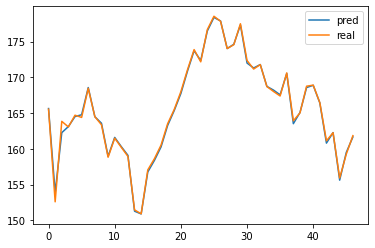

In [9]:
bmodel = TransformerTimeSeries(feature_dim = feature_dim,
                                  nhead = 4,num_layers = 12,d_model = 512,
                                  conv_len = 5,feature_weight = True,embedding_weight = True)
bmodel.load_state_dict(torch.load('AAPL'))
bmodel.to(device)
bmodel.eval()
with torch.no_grad(): # eliminate gradient i.e. gradients only exists in train()

    for step,(x,y,feature,attention_masks) in enumerate(test_dl):
        x = x.to(device)
        y = y.to(device)
        feature = feature.to(device)
        attention_masks = attention_masks.to(device)
        output = bmodel(x,y,feature,attention_masks[0])
        
        pred = data[train_size + 1 :-1,0]*0.01*(100+output[:,t0:].squeeze()).detach().cpu()
        ## note that test set starts at index train_size + 1 because idex train_size in rate_data 
        ## is the last day of first test data point, but rate_data only have the second til last data points
        ## of the dataset.
        real = data[train_size + 1 :-1,0]*0.01*(100+y[:,t0:].squeeze()).detach().cpu()

        plt.plot(pred)
        plt.plot(real)
        plt.legend(['pred','real'])
        MAE = torch.nn.L1Loss()(pred,real).item()
        MSE = torch.nn.MSELoss()(pred,real).item()
        RMSE = np.sqrt(MSE)
        
        print(f'AAPL MAE is {MAE}')
        print(f'AAPL MSE is {MSE}')
        print(f'AAPL RMSE is {RMSE}')

##### High

In [15]:
file_name = 'AAPL_features.csv'
with open(file_name) as f:
    data_list = csv.reader(f)
    data = []
    for row in data_list:
        data.append(row)
    f.close()
    
data = torch.tensor(np.delete(np.array(data)[1:,2:],4,axis = 1).astype(np.float)).type(torch.float)

feature_dim = data.shape[1] - 1
rate = []
for i in range(1,data.shape[0]):
    rate.append((100*(data[i,0:4] - data[i-1,0:4])/data[i-1,0:4]).reshape(1,4))
    
rate = torch.cat(rate)
rate_data = torch.cat([rate,data[1:,4:]],1)
train_size = int(data.shape[0]*0.9)
data_train = rate_data[0:train_size]
data_test = rate_data[train_size-4:]


t0 = 5
to_predict = 1
train_dataset = GetData(data_train[:,1],torch.cat([data_train[:,0].unsqueeze(1),data_train[:,2:]],1),t0 = t0, to_predict = to_predict)
test_dataset = GetData(data_test[:,1],torch.cat([data_test[:,0].unsqueeze(1),data_test[:,2:]],1),t0 = t0, to_predict = to_predict)
criterion = torch.nn.MSELoss()
# dataloaders
train_dl = DataLoader(train_dataset,batch_size=256,shuffle=True)
test_dl = DataLoader(test_dataset,batch_size=512)





model = TransformerTimeSeries(feature_dim = feature_dim,
                              nhead = 4,num_layers = 12,d_model = 512,
                              conv_len = 5,feature_weight = True,embedding_weight = True)
model = model.to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=1e-5 ,momentum = 0.9, nesterov = True)#Adam optimizer
#scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer,5e-7,3e-5,10,mode = 'exp_range',gamma = 0.9996)



train_epoch_loss = []
test_epoch_loss = []
test_best = 9999
for epoch in tqdm(range(4000)):


    l_t = train_epoch(model,train_dl,optimizer,t0,to_predict)

    train_loss = test_epoch(model,train_dl,t0,to_predict)


    test_loss = test_epoch(model,test_dl,t0,to_predict)


    if test_best > test_loss:
        test_best = test_loss
        torch.save(model.state_dict(), 'AAPL_H')



    train_epoch_loss.append(np.mean(train_loss))
    test_epoch_loss.append(test_loss)

    print("Epoch {}: Train loss: {} \t test loss: {}".format(epoch+1,
                                                             np.mean(train_loss),
                                                             test_loss))
    #scheduler.step()


    

torch.Size([431, 6])
torch.Size([431, 6])
torch.Size([47, 6])
torch.Size([47, 6])


  0%|                                                                             | 1/4000 [00:00<24:20,  2.74it/s]

Epoch 1: Train loss: 1.4300043981202517 	 test loss: 1.4753823280334473


  0%|                                                                             | 2/4000 [00:01<47:21,  1.41it/s]

Epoch 2: Train loss: 1.321150822042036 	 test loss: 1.3811665773391724


  0%|                                                                             | 3/4000 [00:02<53:16,  1.25it/s]

Epoch 3: Train loss: 1.2445153080946885 	 test loss: 1.296670913696289


  0%|                                                                             | 4/4000 [00:03<54:53,  1.21it/s]

Epoch 4: Train loss: 1.217445701014968 	 test loss: 1.2521247863769531


  0%|                                                                             | 6/4000 [00:04<40:36,  1.64it/s]

Epoch 5: Train loss: 1.2242369156702488 	 test loss: 1.2281579971313477
Epoch 6: Train loss: 1.2478340250156872 	 test loss: 1.2340844869613647


  0%|▏                                                                            | 8/4000 [00:04<23:34,  2.82it/s]

Epoch 7: Train loss: 1.2679821388350838 	 test loss: 1.2432790994644165
Epoch 8: Train loss: 1.273811374075728 	 test loss: 1.246934413909912


  0%|▏                                                                           | 10/4000 [00:04<16:00,  4.15it/s]

Epoch 9: Train loss: 1.2675008184671954 	 test loss: 1.2432584762573242
Epoch 10: Train loss: 1.2545957034259274 	 test loss: 1.2370511293411255


  0%|▏                                                                           | 12/4000 [00:04<12:26,  5.34it/s]

Epoch 11: Train loss: 1.239340828908845 	 test loss: 1.2320549488067627
Epoch 12: Train loss: 1.2285604186511647 	 test loss: 1.229928731918335


  0%|▎                                                                           | 14/4000 [00:05<10:44,  6.19it/s]

Epoch 13: Train loss: 1.2212791077775358 	 test loss: 1.2294412851333618
Epoch 14: Train loss: 1.2176747023367827 	 test loss: 1.2330825328826904


  0%|▎                                                                           | 16/4000 [00:05<09:54,  6.70it/s]

Epoch 15: Train loss: 1.2161879558850883 	 test loss: 1.2382984161376953
Epoch 16: Train loss: 1.2155359253252742 	 test loss: 1.2419764995574951


  0%|▎                                                                           | 18/4000 [00:05<09:30,  6.98it/s]

Epoch 17: Train loss: 1.2151955186352652 	 test loss: 1.2429953813552856
Epoch 18: Train loss: 1.215029108828569 	 test loss: 1.2416441440582275


  0%|▍                                                                           | 20/4000 [00:06<09:17,  7.14it/s]

Epoch 19: Train loss: 1.2150461496720457 	 test loss: 1.238958716392517
Epoch 20: Train loss: 1.2152035275080917 	 test loss: 1.2356982231140137


  1%|▍                                                                           | 22/4000 [00:06<09:12,  7.21it/s]

Epoch 21: Train loss: 1.2154641411420641 	 test loss: 1.2333531379699707
Epoch 22: Train loss: 1.2159029513666635 	 test loss: 1.2316277027130127


  1%|▍                                                                           | 24/4000 [00:06<09:09,  7.24it/s]

Epoch 23: Train loss: 1.2166855216302894 	 test loss: 1.2302910089492798
Epoch 24: Train loss: 1.2175801087974671 	 test loss: 1.229127049446106


  1%|▍                                                                           | 26/4000 [00:06<09:07,  7.26it/s]

Epoch 25: Train loss: 1.2180249823771607 	 test loss: 1.2284871339797974
Epoch 26: Train loss: 1.2178415593857554 	 test loss: 1.2283986806869507


  1%|▌                                                                           | 28/4000 [00:07<09:07,  7.25it/s]

Epoch 27: Train loss: 1.2171920073281308 	 test loss: 1.2283357381820679
Epoch 28: Train loss: 1.2161027016053343 	 test loss: 1.2287641763687134


  1%|▌                                                                           | 30/4000 [00:07<09:09,  7.22it/s]

Epoch 29: Train loss: 1.2147529208189927 	 test loss: 1.229625940322876
Epoch 30: Train loss: 1.2137508704878062 	 test loss: 1.2303133010864258


  1%|▌                                                                           | 32/4000 [00:07<09:09,  7.23it/s]

Epoch 31: Train loss: 1.2129115607511693 	 test loss: 1.2308844327926636
Epoch 32: Train loss: 1.21233225394291 	 test loss: 1.2312551736831665


  1%|▋                                                                           | 34/4000 [00:07<09:06,  7.26it/s]

Epoch 33: Train loss: 1.2118279391817592 	 test loss: 1.231683373451233
Epoch 34: Train loss: 1.2114788445961724 	 test loss: 1.2317618131637573


  1%|▋                                                                           | 36/4000 [00:08<09:04,  7.28it/s]

Epoch 35: Train loss: 1.2112346566746794 	 test loss: 1.2314931154251099
Epoch 36: Train loss: 1.2111528127210047 	 test loss: 1.2306960821151733


  1%|▋                                                                           | 38/4000 [00:08<09:03,  7.29it/s]

Epoch 37: Train loss: 1.2111746515309452 	 test loss: 1.2299994230270386
Epoch 38: Train loss: 1.2112659514641817 	 test loss: 1.2293637990951538


  1%|▋                                                                           | 39/4000 [00:08<09:03,  7.29it/s]

Epoch 39: Train loss: 1.2114191387203066 	 test loss: 1.2285325527191162


  1%|▊                                                                           | 40/4000 [00:09<23:52,  2.76it/s]

Epoch 40: Train loss: 1.211766401465697 	 test loss: 1.2276290655136108


  1%|▊                                                                           | 41/4000 [00:10<34:21,  1.92it/s]

Epoch 41: Train loss: 1.211952980322517 	 test loss: 1.2270375490188599


  1%|▊                                                                           | 42/4000 [00:11<41:44,  1.58it/s]

Epoch 42: Train loss: 1.2121527969422308 	 test loss: 1.2267900705337524


  1%|▊                                                                           | 43/4000 [00:12<46:22,  1.42it/s]

Epoch 43: Train loss: 1.2117234803131174 	 test loss: 1.2266114950180054


  1%|▊                                                                           | 45/4000 [00:13<37:54,  1.74it/s]

Epoch 44: Train loss: 1.210959493422453 	 test loss: 1.2266062498092651
Epoch 45: Train loss: 1.2099542913746668 	 test loss: 1.226726770401001


  1%|▉                                                                           | 47/4000 [00:13<23:10,  2.84it/s]

Epoch 46: Train loss: 1.208870559446773 	 test loss: 1.2273762226104736
Epoch 47: Train loss: 1.2083242232727618 	 test loss: 1.2273564338684082


  1%|▉                                                                           | 49/4000 [00:13<15:59,  4.12it/s]

Epoch 48: Train loss: 1.207992189168377 	 test loss: 1.2271456718444824
Epoch 49: Train loss: 1.207776067151824 	 test loss: 1.2266546487808228


  1%|▉                                                                           | 50/4000 [00:14<28:52,  2.28it/s]

Epoch 50: Train loss: 1.2076179582945432 	 test loss: 1.2261850833892822


  1%|▉                                                                           | 51/4000 [00:15<37:57,  1.73it/s]

Epoch 51: Train loss: 1.2076516519289835 	 test loss: 1.2254406213760376


  1%|▉                                                                           | 52/4000 [00:16<43:43,  1.50it/s]

Epoch 52: Train loss: 1.2077259738041464 	 test loss: 1.2250394821166992


  1%|█                                                                           | 53/4000 [00:17<48:16,  1.36it/s]

Epoch 53: Train loss: 1.207855420986627 	 test loss: 1.224737524986267


  1%|█                                                                           | 54/4000 [00:18<51:37,  1.27it/s]

Epoch 54: Train loss: 1.2079725362308618 	 test loss: 1.2244794368743896


  1%|█                                                                           | 55/4000 [00:19<54:28,  1.21it/s]

Epoch 55: Train loss: 1.2079168134941578 	 test loss: 1.2242743968963623


  1%|█                                                                           | 56/4000 [00:20<55:49,  1.18it/s]

Epoch 56: Train loss: 1.2078683766300884 	 test loss: 1.2239642143249512


  1%|█                                                                           | 57/4000 [00:21<57:21,  1.15it/s]

Epoch 57: Train loss: 1.2076863653421954 	 test loss: 1.2237414121627808


  1%|█                                                                           | 58/4000 [00:21<58:04,  1.13it/s]

Epoch 58: Train loss: 1.2075076531921352 	 test loss: 1.2235336303710938


  1%|█                                                                           | 59/4000 [00:22<58:16,  1.13it/s]

Epoch 59: Train loss: 1.2071148099036337 	 test loss: 1.223360538482666


  2%|█                                                                         | 60/4000 [00:24<1:20:13,  1.22s/it]

Epoch 60: Train loss: 1.2061500552082283 	 test loss: 1.2232272624969482


  2%|█▏                                                                        | 61/4000 [00:31<3:13:30,  2.95s/it]

Epoch 61: Train loss: 1.2053042525758322 	 test loss: 1.2230544090270996


  2%|█▏                                                                        | 62/4000 [00:38<4:29:42,  4.11s/it]

Epoch 62: Train loss: 1.204718847009256 	 test loss: 1.2228941917419434


  2%|█▏                                                                        | 63/4000 [00:45<5:18:41,  4.86s/it]

Epoch 63: Train loss: 1.2041405364698157 	 test loss: 1.222650170326233


  2%|█▏                                                                        | 64/4000 [00:51<5:52:48,  5.38s/it]

Epoch 64: Train loss: 1.2036971606124027 	 test loss: 1.2225412130355835


  2%|█▏                                                                        | 65/4000 [00:58<6:16:25,  5.74s/it]

Epoch 65: Train loss: 1.2032357462597558 	 test loss: 1.2223124504089355


  2%|█▏                                                                        | 66/4000 [01:04<6:32:54,  5.99s/it]

Epoch 66: Train loss: 1.202763739152187 	 test loss: 1.2220070362091064


  2%|█▏                                                                        | 67/4000 [01:11<6:44:39,  6.17s/it]

Epoch 67: Train loss: 1.202303259665894 	 test loss: 1.2217059135437012


  2%|█▎                                                                        | 68/4000 [01:18<6:54:12,  6.32s/it]

Epoch 68: Train loss: 1.2019200020765761 	 test loss: 1.2215455770492554


  2%|█▎                                                                        | 69/4000 [01:24<6:59:26,  6.40s/it]

Epoch 69: Train loss: 1.2013606198149325 	 test loss: 1.2214467525482178


  2%|█▎                                                                        | 70/4000 [01:31<7:02:52,  6.46s/it]

Epoch 70: Train loss: 1.2009555275644892 	 test loss: 1.221175193786621


  2%|█▎                                                                        | 71/4000 [01:38<7:06:16,  6.51s/it]

Epoch 71: Train loss: 1.200526833257653 	 test loss: 1.2207857370376587


  2%|█▎                                                                        | 72/4000 [01:44<7:07:24,  6.53s/it]

Epoch 72: Train loss: 1.2000738161069335 	 test loss: 1.2206683158874512


  2%|█▎                                                                        | 73/4000 [01:51<7:09:21,  6.56s/it]

Epoch 73: Train loss: 1.199711698943667 	 test loss: 1.220167636871338


  2%|█▎                                                                        | 74/4000 [01:57<6:56:23,  6.36s/it]

Epoch 74: Train loss: 1.1996303973784304 	 test loss: 1.2198677062988281


  2%|█▍                                                                        | 75/4000 [02:04<7:14:17,  6.64s/it]

Epoch 75: Train loss: 1.1995721859057928 	 test loss: 1.219581961631775


  2%|█▍                                                                        | 76/4000 [02:11<7:13:52,  6.63s/it]

Epoch 76: Train loss: 1.1995308067295225 	 test loss: 1.2192230224609375


  2%|█▍                                                                        | 77/4000 [02:17<7:13:00,  6.62s/it]

Epoch 77: Train loss: 1.1995425332173395 	 test loss: 1.218705177307129


  2%|█▍                                                                        | 78/4000 [02:24<7:12:05,  6.61s/it]

Epoch 78: Train loss: 1.199587141831347 	 test loss: 1.2184003591537476


  2%|█▍                                                                        | 79/4000 [02:30<7:12:16,  6.61s/it]

Epoch 79: Train loss: 1.1993287666214592 	 test loss: 1.218076229095459


  2%|█▍                                                                        | 80/4000 [02:37<7:11:19,  6.60s/it]

Epoch 80: Train loss: 1.1987754051204071 	 test loss: 1.217816948890686


  2%|█▍                                                                        | 81/4000 [02:44<7:11:36,  6.61s/it]

Epoch 81: Train loss: 1.1982561839428967 	 test loss: 1.2175095081329346


  2%|█▌                                                                        | 82/4000 [02:50<7:08:00,  6.55s/it]

Epoch 82: Train loss: 1.1975905585454953 	 test loss: 1.2172297239303589


  2%|█▌                                                                        | 83/4000 [02:57<7:11:18,  6.61s/it]

Epoch 83: Train loss: 1.1970727518373743 	 test loss: 1.2168890237808228


  2%|█▌                                                                        | 84/4000 [03:03<6:59:30,  6.43s/it]

Epoch 84: Train loss: 1.196599070267998 	 test loss: 1.2166770696640015


  2%|█▌                                                                        | 85/4000 [03:10<7:15:03,  6.67s/it]

Epoch 85: Train loss: 1.1963150575929895 	 test loss: 1.2163594961166382


  2%|█▌                                                                        | 86/4000 [03:17<7:14:17,  6.66s/it]

Epoch 86: Train loss: 1.1961006338247844 	 test loss: 1.215996503829956


  2%|█▌                                                                        | 87/4000 [03:23<7:09:17,  6.58s/it]

Epoch 87: Train loss: 1.1958968644905532 	 test loss: 1.215606927871704


  2%|█▋                                                                        | 88/4000 [03:30<7:12:37,  6.64s/it]

Epoch 88: Train loss: 1.1955454543129198 	 test loss: 1.2153223752975464


  2%|█▋                                                                        | 89/4000 [03:36<6:59:51,  6.44s/it]

Epoch 89: Train loss: 1.1953386040685348 	 test loss: 1.2149065732955933


  2%|█▋                                                                        | 90/4000 [03:43<7:19:35,  6.75s/it]

Epoch 90: Train loss: 1.1953600871867205 	 test loss: 1.2145246267318726


  2%|█▋                                                                        | 91/4000 [03:50<7:13:00,  6.65s/it]

Epoch 91: Train loss: 1.1952210241569996 	 test loss: 1.2141224145889282


  2%|█▋                                                                        | 92/4000 [03:56<7:10:03,  6.60s/it]

Epoch 92: Train loss: 1.1947160862438087 	 test loss: 1.2138583660125732


  2%|█▋                                                                        | 93/4000 [04:03<7:08:59,  6.59s/it]

Epoch 93: Train loss: 1.1940034475791206 	 test loss: 1.2135674953460693


  2%|█▋                                                                        | 94/4000 [04:10<7:15:34,  6.69s/it]

Epoch 94: Train loss: 1.1933736153932293 	 test loss: 1.2131783962249756


  2%|█▊                                                                        | 95/4000 [04:16<7:13:43,  6.66s/it]

Epoch 95: Train loss: 1.1929158926563308 	 test loss: 1.212725043296814


  2%|█▊                                                                        | 96/4000 [04:23<7:11:36,  6.63s/it]

Epoch 96: Train loss: 1.1926630586039992 	 test loss: 1.2121968269348145


  2%|█▊                                                                        | 97/4000 [04:29<7:08:07,  6.58s/it]

Epoch 97: Train loss: 1.1926125384815331 	 test loss: 1.2116450071334839


  2%|█▊                                                                        | 98/4000 [04:36<7:05:47,  6.55s/it]

Epoch 98: Train loss: 1.1923948545743583 	 test loss: 1.211169719696045


  2%|█▊                                                                        | 99/4000 [04:43<7:12:27,  6.65s/it]

Epoch 99: Train loss: 1.1919387316205938 	 test loss: 1.2107398509979248


  2%|█▊                                                                       | 100/4000 [04:49<7:12:11,  6.65s/it]

Epoch 100: Train loss: 1.1915386306714015 	 test loss: 1.2103849649429321


  3%|█▊                                                                       | 101/4000 [04:56<7:11:09,  6.63s/it]

Epoch 101: Train loss: 1.1912135790229674 	 test loss: 1.2099777460098267


  3%|█▊                                                                       | 102/4000 [05:02<7:08:01,  6.59s/it]

Epoch 102: Train loss: 1.1909792196446394 	 test loss: 1.2094652652740479


  3%|█▉                                                                       | 103/4000 [05:09<7:08:59,  6.60s/it]

Epoch 103: Train loss: 1.1903823000095837 	 test loss: 1.2090115547180176


  3%|█▉                                                                       | 104/4000 [05:16<7:10:15,  6.63s/it]

Epoch 104: Train loss: 1.1895301991991543 	 test loss: 1.2086215019226074


  3%|█▉                                                                       | 105/4000 [05:22<7:09:53,  6.62s/it]

Epoch 105: Train loss: 1.1886627939626955 	 test loss: 1.2082242965698242


  3%|█▉                                                                       | 106/4000 [05:29<7:09:12,  6.61s/it]

Epoch 106: Train loss: 1.1879864897916046 	 test loss: 1.207969307899475


  3%|█▉                                                                       | 107/4000 [05:35<7:07:40,  6.59s/it]

Epoch 107: Train loss: 1.1877197856969457 	 test loss: 1.2073591947555542


  3%|█▉                                                                       | 108/4000 [05:42<7:08:47,  6.61s/it]

Epoch 108: Train loss: 1.1873509300280614 	 test loss: 1.2068545818328857


  3%|█▉                                                                       | 109/4000 [05:49<7:12:10,  6.66s/it]

Epoch 109: Train loss: 1.1867874468009045 	 test loss: 1.2064337730407715


  3%|██                                                                       | 110/4000 [05:55<7:07:24,  6.59s/it]

Epoch 110: Train loss: 1.1861313598061936 	 test loss: 1.2061713933944702


  3%|██                                                                       | 111/4000 [06:02<7:07:30,  6.60s/it]

Epoch 111: Train loss: 1.185600353780866 	 test loss: 1.2056859731674194


  3%|██                                                                       | 112/4000 [06:08<7:06:19,  6.58s/it]

Epoch 112: Train loss: 1.185053231268084 	 test loss: 1.2051737308502197


  3%|██                                                                       | 113/4000 [06:15<7:07:40,  6.60s/it]

Epoch 113: Train loss: 1.1844607212703908 	 test loss: 1.2048254013061523


  3%|██                                                                       | 114/4000 [06:21<7:04:18,  6.55s/it]

Epoch 114: Train loss: 1.1840015597243874 	 test loss: 1.204388976097107


  3%|██                                                                       | 115/4000 [06:28<7:08:41,  6.62s/it]

Epoch 115: Train loss: 1.1835783161309368 	 test loss: 1.2037409543991089


  3%|██                                                                       | 116/4000 [06:35<7:08:13,  6.62s/it]

Epoch 116: Train loss: 1.1832550896845948 	 test loss: 1.2030742168426514


  3%|██▏                                                                      | 117/4000 [06:41<7:06:28,  6.59s/it]

Epoch 117: Train loss: 1.1829055237936033 	 test loss: 1.2022939920425415


  3%|██▏                                                                      | 118/4000 [06:48<7:08:01,  6.62s/it]

Epoch 118: Train loss: 1.182634435784236 	 test loss: 1.2015211582183838


  3%|██▏                                                                      | 119/4000 [06:55<7:04:49,  6.57s/it]

Epoch 119: Train loss: 1.1825138712150591 	 test loss: 1.200684666633606


  3%|██▏                                                                      | 120/4000 [07:01<7:01:33,  6.52s/it]

Epoch 120: Train loss: 1.18214751479244 	 test loss: 1.2000398635864258


  3%|██▏                                                                      | 121/4000 [07:08<7:09:33,  6.64s/it]

Epoch 121: Train loss: 1.1816574514880258 	 test loss: 1.199534296989441


  3%|██▏                                                                      | 122/4000 [07:14<7:07:50,  6.62s/it]

Epoch 122: Train loss: 1.1810264451874382 	 test loss: 1.1990388631820679


  3%|██▏                                                                      | 123/4000 [07:21<7:08:36,  6.63s/it]

Epoch 123: Train loss: 1.1804604715648217 	 test loss: 1.1984541416168213


  3%|██▎                                                                      | 124/4000 [07:28<7:07:05,  6.61s/it]

Epoch 124: Train loss: 1.1801279769419517 	 test loss: 1.197648286819458


  3%|██▎                                                                      | 125/4000 [07:34<7:06:25,  6.60s/it]

Epoch 125: Train loss: 1.1797427356658015 	 test loss: 1.1968661546707153


  3%|██▎                                                                      | 126/4000 [07:41<7:00:56,  6.52s/it]

Epoch 126: Train loss: 1.1790049208842408 	 test loss: 1.196453332901001


  3%|██▎                                                                      | 127/4000 [07:47<7:06:10,  6.60s/it]

Epoch 127: Train loss: 1.1783729335271564 	 test loss: 1.1958441734313965


  3%|██▎                                                                      | 128/4000 [07:54<7:12:23,  6.70s/it]

Epoch 128: Train loss: 1.1782628856512898 	 test loss: 1.1950756311416626


  3%|██▎                                                                      | 129/4000 [08:01<7:10:34,  6.67s/it]

Epoch 129: Train loss: 1.17792475970328 	 test loss: 1.1944622993469238


  3%|██▎                                                                      | 130/4000 [08:07<7:08:17,  6.64s/it]

Epoch 130: Train loss: 1.1775478774599575 	 test loss: 1.1936315298080444


  3%|██▍                                                                      | 131/4000 [08:14<7:08:13,  6.64s/it]

Epoch 131: Train loss: 1.1770744052674544 	 test loss: 1.1928670406341553


  3%|██▍                                                                      | 132/4000 [08:20<7:03:23,  6.57s/it]

Epoch 132: Train loss: 1.1765889479776546 	 test loss: 1.1921353340148926


  3%|██▍                                                                      | 133/4000 [08:27<7:08:08,  6.64s/it]

Epoch 133: Train loss: 1.1761316556111843 	 test loss: 1.1913189888000488


  3%|██▍                                                                      | 134/4000 [08:33<6:58:12,  6.49s/it]

Epoch 134: Train loss: 1.1757434819524637 	 test loss: 1.1905689239501953


  3%|██▍                                                                      | 135/4000 [08:40<7:08:32,  6.65s/it]

Epoch 135: Train loss: 1.1750610696190749 	 test loss: 1.1898748874664307


  3%|██▍                                                                      | 136/4000 [08:47<7:11:16,  6.70s/it]

Epoch 136: Train loss: 1.1744414570713264 	 test loss: 1.189223289489746


  3%|██▌                                                                      | 138/4000 [08:54<5:04:26,  4.73s/it]

Epoch 137: Train loss: 1.1731955272139087 	 test loss: 1.1889890432357788
Epoch 138: Train loss: 1.1714000287022779 	 test loss: 1.1891192197799683


  4%|██▌                                                                      | 140/4000 [08:54<2:33:38,  2.39s/it]

Epoch 139: Train loss: 1.1698679921245354 	 test loss: 1.1892225742340088
Epoch 140: Train loss: 1.1686449626205693 	 test loss: 1.1892290115356445


  4%|██▌                                                                      | 141/4000 [09:00<3:41:49,  3.45s/it]

Epoch 141: Train loss: 1.1676592077290653 	 test loss: 1.1889783143997192


  4%|██▌                                                                      | 142/4000 [09:07<4:42:27,  4.39s/it]

Epoch 142: Train loss: 1.16685989837912 	 test loss: 1.188497543334961


  4%|██▌                                                                      | 143/4000 [09:14<5:25:12,  5.06s/it]

Epoch 143: Train loss: 1.1663392370095662 	 test loss: 1.1875722408294678


  4%|██▋                                                                      | 144/4000 [09:19<5:41:18,  5.31s/it]

Epoch 144: Train loss: 1.1659423721362157 	 test loss: 1.1861830949783325


  4%|██▋                                                                      | 145/4000 [09:27<6:19:31,  5.91s/it]

Epoch 145: Train loss: 1.1659254693099905 	 test loss: 1.184492826461792


  4%|██▋                                                                      | 146/4000 [09:33<6:30:41,  6.08s/it]

Epoch 146: Train loss: 1.1662450926486412 	 test loss: 1.1829023361206055


  4%|██▋                                                                      | 147/4000 [09:40<6:42:59,  6.28s/it]

Epoch 147: Train loss: 1.1660678873482546 	 test loss: 1.1815778017044067


  4%|██▋                                                                      | 148/4000 [09:46<6:36:58,  6.18s/it]

Epoch 148: Train loss: 1.165769236270347 	 test loss: 1.180403470993042


  4%|██▋                                                                      | 149/4000 [09:53<6:57:51,  6.51s/it]

Epoch 149: Train loss: 1.1648151976879677 	 test loss: 1.1796847581863403


  4%|██▋                                                                      | 150/4000 [10:00<6:58:07,  6.52s/it]

Epoch 150: Train loss: 1.163613689471287 	 test loss: 1.1791704893112183


  4%|██▊                                                                      | 151/4000 [10:06<7:00:52,  6.56s/it]

Epoch 151: Train loss: 1.1619229620957872 	 test loss: 1.1787859201431274


  4%|██▊                                                                      | 152/4000 [10:12<6:48:20,  6.37s/it]

Epoch 152: Train loss: 1.1608451756966363 	 test loss: 1.1782326698303223


  4%|██▊                                                                      | 153/4000 [10:20<7:21:03,  6.88s/it]

Epoch 153: Train loss: 1.1600752275117312 	 test loss: 1.177588939666748


  4%|██▊                                                                      | 154/4000 [10:29<7:51:51,  7.36s/it]

Epoch 154: Train loss: 1.1595171914023203 	 test loss: 1.176737904548645


  4%|██▊                                                                      | 155/4000 [10:36<7:41:56,  7.21s/it]

Epoch 155: Train loss: 1.1592494716777049 	 test loss: 1.1756559610366821


  4%|██▊                                                                      | 156/4000 [10:42<7:29:12,  7.01s/it]

Epoch 156: Train loss: 1.1583493383743924 	 test loss: 1.1749252080917358


  4%|██▊                                                                      | 157/4000 [10:49<7:22:24,  6.91s/it]

Epoch 157: Train loss: 1.157518317417313 	 test loss: 1.1739611625671387


  4%|██▉                                                                      | 158/4000 [10:55<7:12:42,  6.76s/it]

Epoch 158: Train loss: 1.156829666925417 	 test loss: 1.172996163368225


  4%|██▉                                                                      | 159/4000 [11:02<7:13:25,  6.77s/it]

Epoch 159: Train loss: 1.1565010517213294 	 test loss: 1.171729326248169


  4%|██▉                                                                      | 160/4000 [11:09<7:06:29,  6.66s/it]

Epoch 160: Train loss: 1.1564005322909963 	 test loss: 1.170170783996582


  4%|██▉                                                                      | 161/4000 [11:15<7:02:23,  6.60s/it]

Epoch 161: Train loss: 1.155222357564072 	 test loss: 1.1694719791412354


  4%|██▉                                                                      | 162/4000 [11:22<7:01:58,  6.60s/it]

Epoch 162: Train loss: 1.154986041327917 	 test loss: 1.1687642335891724


  4%|██▉                                                                      | 164/4000 [11:29<5:02:33,  4.73s/it]

Epoch 163: Train loss: 1.1531881777150448 	 test loss: 1.1684942245483398
Epoch 164: Train loss: 1.1517944178282522 	 test loss: 1.1685534715652466


  4%|███                                                                      | 165/4000 [11:35<5:39:26,  5.31s/it]

Epoch 165: Train loss: 1.1508911593607574 	 test loss: 1.1676149368286133


  4%|███                                                                      | 166/4000 [11:42<6:08:20,  5.76s/it]

Epoch 166: Train loss: 1.149622879282781 	 test loss: 1.1669435501098633


  4%|███                                                                      | 167/4000 [11:49<6:19:54,  5.95s/it]

Epoch 167: Train loss: 1.1483983390569135 	 test loss: 1.1662561893463135


  4%|███                                                                      | 168/4000 [11:55<6:31:09,  6.12s/it]

Epoch 168: Train loss: 1.1473464747316047 	 test loss: 1.165230631828308


  4%|███                                                                      | 169/4000 [12:02<6:40:49,  6.28s/it]

Epoch 169: Train loss: 1.1460162716509295 	 test loss: 1.1641219854354858


  4%|███                                                                      | 170/4000 [12:08<6:47:37,  6.39s/it]

Epoch 170: Train loss: 1.1450923805723612 	 test loss: 1.1630094051361084


  4%|███                                                                      | 171/4000 [12:15<6:51:50,  6.45s/it]

Epoch 171: Train loss: 1.144277931642643 	 test loss: 1.1616414785385132


  4%|███▏                                                                     | 172/4000 [12:22<6:54:03,  6.49s/it]

Epoch 172: Train loss: 1.1440690700526581 	 test loss: 1.1598459482192993


  4%|███▏                                                                     | 173/4000 [12:28<6:56:08,  6.52s/it]

Epoch 173: Train loss: 1.1433216184031936 	 test loss: 1.1581436395645142


  4%|███▏                                                                     | 174/4000 [12:35<6:57:31,  6.55s/it]

Epoch 174: Train loss: 1.142457816274426 	 test loss: 1.1566523313522339


  4%|███▏                                                                     | 175/4000 [12:41<6:57:20,  6.55s/it]

Epoch 175: Train loss: 1.1412872648571042 	 test loss: 1.1553438901901245


  4%|███▏                                                                     | 176/4000 [12:48<7:00:04,  6.59s/it]

Epoch 176: Train loss: 1.1403897010533273 	 test loss: 1.1537845134735107


  4%|███▏                                                                     | 177/4000 [12:55<7:00:09,  6.59s/it]

Epoch 177: Train loss: 1.13929565185184 	 test loss: 1.1525551080703735


  4%|███▏                                                                     | 178/4000 [13:01<7:00:14,  6.60s/it]

Epoch 178: Train loss: 1.1378977630641787 	 test loss: 1.151497721672058


  4%|███▎                                                                     | 179/4000 [13:08<7:00:02,  6.60s/it]

Epoch 179: Train loss: 1.1369548065203248 	 test loss: 1.1502965688705444


  4%|███▎                                                                     | 180/4000 [13:14<6:59:54,  6.60s/it]

Epoch 180: Train loss: 1.1361198436356477 	 test loss: 1.149005651473999


  5%|███▎                                                                     | 181/4000 [13:21<6:59:31,  6.59s/it]

Epoch 181: Train loss: 1.1349943323091123 	 test loss: 1.14780855178833


  5%|███▎                                                                     | 182/4000 [13:28<6:59:49,  6.60s/it]

Epoch 182: Train loss: 1.1343300995306735 	 test loss: 1.1461374759674072


  5%|███▎                                                                     | 183/4000 [13:34<7:00:13,  6.61s/it]

Epoch 183: Train loss: 1.1333036273372146 	 test loss: 1.1445534229278564


  5%|███▎                                                                     | 184/4000 [13:41<7:00:03,  6.60s/it]

Epoch 184: Train loss: 1.1323473862871494 	 test loss: 1.1431877613067627


  5%|███▍                                                                     | 185/4000 [13:47<6:57:10,  6.56s/it]

Epoch 185: Train loss: 1.1309500468026181 	 test loss: 1.1419609785079956


  5%|███▍                                                                     | 186/4000 [13:54<7:00:48,  6.62s/it]

Epoch 186: Train loss: 1.1292856323193508 	 test loss: 1.1409484148025513


  5%|███▍                                                                     | 187/4000 [14:01<6:59:58,  6.61s/it]

Epoch 187: Train loss: 1.1279697448637536 	 test loss: 1.1393828392028809


  5%|███▍                                                                     | 188/4000 [14:07<7:00:09,  6.61s/it]

Epoch 188: Train loss: 1.1271612937378497 	 test loss: 1.1379098892211914


  5%|███▍                                                                     | 189/4000 [14:14<6:59:42,  6.61s/it]

Epoch 189: Train loss: 1.1268874113631635 	 test loss: 1.1363741159439087


  5%|███▍                                                                     | 190/4000 [14:20<6:59:34,  6.61s/it]

Epoch 190: Train loss: 1.1256299110133798 	 test loss: 1.1348692178726196


  5%|███▍                                                                     | 191/4000 [14:27<6:59:34,  6.61s/it]

Epoch 191: Train loss: 1.1240866825918034 	 test loss: 1.1333452463150024


  5%|███▌                                                                     | 192/4000 [14:34<6:59:20,  6.61s/it]

Epoch 192: Train loss: 1.1230353479318995 	 test loss: 1.1319130659103394


  5%|███▌                                                                     | 193/4000 [14:40<6:58:56,  6.60s/it]

Epoch 193: Train loss: 1.1217308500803265 	 test loss: 1.1305121183395386


  5%|███▌                                                                     | 194/4000 [14:47<6:59:05,  6.61s/it]

Epoch 194: Train loss: 1.120242423081896 	 test loss: 1.1290086507797241


  5%|███▌                                                                     | 195/4000 [14:53<6:58:44,  6.60s/it]

Epoch 195: Train loss: 1.1190108909960965 	 test loss: 1.1273263692855835


  5%|███▌                                                                     | 196/4000 [15:00<6:58:50,  6.61s/it]

Epoch 196: Train loss: 1.1172602240281426 	 test loss: 1.125756025314331


  5%|███▌                                                                     | 197/4000 [15:06<6:55:45,  6.56s/it]

Epoch 197: Train loss: 1.1152435801145373 	 test loss: 1.124253273010254


  5%|███▌                                                                     | 198/4000 [15:13<7:02:51,  6.67s/it]

Epoch 198: Train loss: 1.1129161199671487 	 test loss: 1.122747540473938


  5%|███▋                                                                     | 199/4000 [15:20<7:05:56,  6.72s/it]

Epoch 199: Train loss: 1.1108717663935332 	 test loss: 1.1213330030441284


  5%|███▋                                                                     | 200/4000 [15:27<6:57:06,  6.59s/it]

Epoch 200: Train loss: 1.1089912708286895 	 test loss: 1.1199747323989868


  5%|███▋                                                                     | 201/4000 [15:33<6:59:04,  6.62s/it]

Epoch 201: Train loss: 1.1077794284665667 	 test loss: 1.1179717779159546


  5%|███▋                                                                     | 202/4000 [15:40<6:58:50,  6.62s/it]

Epoch 202: Train loss: 1.1076689623901297 	 test loss: 1.1159470081329346


  5%|███▋                                                                     | 203/4000 [15:46<6:45:48,  6.41s/it]

Epoch 203: Train loss: 1.1075553965955764 	 test loss: 1.1138542890548706


  5%|███▋                                                                     | 204/4000 [15:53<7:01:46,  6.67s/it]

Epoch 204: Train loss: 1.1068641204568461 	 test loss: 1.1118301153182983


  5%|███▋                                                                     | 205/4000 [16:00<6:59:04,  6.63s/it]

Epoch 205: Train loss: 1.1059753067808749 	 test loss: 1.1096539497375488


  5%|███▊                                                                     | 206/4000 [16:06<6:59:56,  6.64s/it]

Epoch 206: Train loss: 1.1043999748274234 	 test loss: 1.1077570915222168


  5%|███▊                                                                     | 207/4000 [16:13<6:59:05,  6.63s/it]

Epoch 207: Train loss: 1.101434610835914 	 test loss: 1.1059496402740479


  5%|███▊                                                                     | 208/4000 [16:19<6:45:37,  6.42s/it]

Epoch 208: Train loss: 1.0981219589295355 	 test loss: 1.1044039726257324


  5%|███▊                                                                     | 209/4000 [16:26<7:01:52,  6.68s/it]

Epoch 209: Train loss: 1.0953747310660555 	 test loss: 1.1036313772201538


  5%|███▊                                                                     | 210/4000 [16:32<6:56:51,  6.60s/it]

Epoch 210: Train loss: 1.0936762030882514 	 test loss: 1.1015993356704712


  5%|███▊                                                                     | 211/4000 [16:39<7:00:08,  6.65s/it]

Epoch 211: Train loss: 1.0936046147291179 	 test loss: 1.0985618829727173


  5%|███▊                                                                     | 212/4000 [16:46<7:08:36,  6.79s/it]

Epoch 212: Train loss: 1.0937148078135162 	 test loss: 1.0957776308059692


  5%|███▉                                                                     | 213/4000 [16:53<7:04:56,  6.73s/it]

Epoch 213: Train loss: 1.0936892287083955 	 test loss: 1.0934176445007324


  5%|███▉                                                                     | 214/4000 [17:00<7:02:33,  6.70s/it]

Epoch 214: Train loss: 1.0914387075087864 	 test loss: 1.091221570968628


  5%|███▉                                                                     | 215/4000 [17:06<6:59:40,  6.65s/it]

Epoch 215: Train loss: 1.0882109992741986 	 test loss: 1.0892435312271118


  5%|███▉                                                                     | 216/4000 [17:13<6:59:14,  6.65s/it]

Epoch 216: Train loss: 1.0847703929290418 	 test loss: 1.0887022018432617


  5%|███▉                                                                     | 217/4000 [17:19<6:58:03,  6.63s/it]

Epoch 217: Train loss: 1.08266095246627 	 test loss: 1.087384819984436


  5%|███▉                                                                     | 218/4000 [17:26<6:57:50,  6.63s/it]

Epoch 218: Train loss: 1.0802044511671132 	 test loss: 1.0862243175506592


  5%|███▉                                                                     | 219/4000 [17:33<6:57:13,  6.62s/it]

Epoch 219: Train loss: 1.0772572830492273 	 test loss: 1.0852923393249512


  6%|████                                                                     | 220/4000 [17:39<6:56:22,  6.61s/it]

Epoch 220: Train loss: 1.0749686571948767 	 test loss: 1.0835597515106201


  6%|████                                                                     | 221/4000 [17:46<6:56:44,  6.62s/it]

Epoch 221: Train loss: 1.0736243345897878 	 test loss: 1.0805667638778687


  6%|████                                                                     | 222/4000 [17:52<6:56:10,  6.61s/it]

Epoch 222: Train loss: 1.072495606825136 	 test loss: 1.0774487257003784


  6%|████                                                                     | 223/4000 [17:59<6:49:49,  6.51s/it]

Epoch 223: Train loss: 1.0710458368270415 	 test loss: 1.0746499300003052


  6%|████                                                                     | 224/4000 [18:06<6:56:36,  6.62s/it]

Epoch 224: Train loss: 1.0703176425947114 	 test loss: 1.0706883668899536


  6%|████                                                                     | 226/4000 [18:12<4:53:49,  4.67s/it]

Epoch 225: Train loss: 1.0686314919155324 	 test loss: 1.068009614944458
Epoch 226: Train loss: 1.0642807027303425 	 test loss: 1.0686198472976685


  6%|████▏                                                                    | 227/4000 [18:19<5:28:42,  5.23s/it]

Epoch 227: Train loss: 1.06147372335403 	 test loss: 1.0675475597381592


  6%|████▏                                                                    | 228/4000 [18:25<5:53:57,  5.63s/it]

Epoch 228: Train loss: 1.0598401990124908 	 test loss: 1.064498782157898


  6%|████▏                                                                    | 229/4000 [18:32<6:13:00,  5.93s/it]

Epoch 229: Train loss: 1.0593949395929854 	 test loss: 1.0606608390808105


  6%|████▏                                                                    | 230/4000 [18:39<6:25:29,  6.14s/it]

Epoch 230: Train loss: 1.0572487243090318 	 test loss: 1.058706283569336


  6%|████▏                                                                    | 232/4000 [18:45<4:40:15,  4.46s/it]

Epoch 231: Train loss: 1.053538105880578 	 test loss: 1.05836021900177
Epoch 232: Train loss: 1.049042578086499 	 test loss: 1.0588371753692627


  6%|████▎                                                                    | 233/4000 [18:52<5:18:43,  5.08s/it]

Epoch 233: Train loss: 1.0459925738398823 	 test loss: 1.0574061870574951


  6%|████▎                                                                    | 234/4000 [18:59<5:47:10,  5.53s/it]

Epoch 234: Train loss: 1.0439427662338292 	 test loss: 1.0544464588165283


  6%|████▎                                                                    | 235/4000 [19:05<6:07:27,  5.86s/it]

Epoch 235: Train loss: 1.0424188848437954 	 test loss: 1.0512573719024658


  6%|████▎                                                                    | 236/4000 [19:12<6:26:05,  6.15s/it]

Epoch 236: Train loss: 1.0417779330034544 	 test loss: 1.047785758972168


  6%|████▎                                                                    | 237/4000 [19:19<6:32:43,  6.26s/it]

Epoch 237: Train loss: 1.0399147462955485 	 test loss: 1.045036792755127


  6%|████▎                                                                    | 238/4000 [19:25<6:28:02,  6.19s/it]

Epoch 238: Train loss: 1.0388966782187088 	 test loss: 1.0417107343673706


  6%|████▎                                                                    | 239/4000 [19:32<6:48:16,  6.51s/it]

Epoch 239: Train loss: 1.03632054002545 	 test loss: 1.0399023294448853


  6%|████▍                                                                    | 241/4000 [19:38<4:36:52,  4.42s/it]

Epoch 240: Train loss: 1.031603270506361 	 test loss: 1.0393496751785278
Epoch 241: Train loss: 1.0264660399363932 	 test loss: 1.0407053232192993


  6%|████▍                                                                    | 243/4000 [19:38<2:20:01,  2.24s/it]

Epoch 242: Train loss: 1.0227894686214332 	 test loss: 1.0416399240493774
Epoch 243: Train loss: 1.0197193448338873 	 test loss: 1.0404722690582275


  6%|████▍                                                                    | 244/4000 [19:45<3:46:14,  3.61s/it]

Epoch 244: Train loss: 1.0176892204517 	 test loss: 1.0367788076400757


  6%|████▍                                                                    | 245/4000 [19:51<4:40:50,  4.49s/it]

Epoch 245: Train loss: 1.0170392891923679 	 test loss: 1.0308752059936523


  6%|████▍                                                                    | 246/4000 [19:58<5:22:59,  5.16s/it]

Epoch 246: Train loss: 1.0170963759212095 	 test loss: 1.025020956993103


  6%|████▌                                                                    | 248/4000 [20:05<4:07:48,  3.96s/it]

Epoch 247: Train loss: 1.014747123707198 	 test loss: 1.022600531578064
Epoch 248: Train loss: 1.010455440479199 	 test loss: 1.0228724479675293


  6%|████▌                                                                    | 249/4000 [20:05<2:56:01,  2.82s/it]

Epoch 249: Train loss: 1.006324417768111 	 test loss: 1.0231366157531738


  6%|████▌                                                                    | 250/4000 [20:11<3:49:27,  3.67s/it]

Epoch 250: Train loss: 1.0026578601717673 	 test loss: 1.021515130996704


  6%|████▌                                                                    | 251/4000 [20:18<4:56:05,  4.74s/it]

Epoch 251: Train loss: 0.999225863724463 	 test loss: 1.0206289291381836


  6%|████▌                                                                    | 252/4000 [20:24<5:31:32,  5.31s/it]

Epoch 252: Train loss: 0.9971992922493034 	 test loss: 1.0162519216537476


  6%|████▌                                                                    | 253/4000 [20:31<5:55:45,  5.70s/it]

Epoch 253: Train loss: 0.9944776451504701 	 test loss: 1.0133681297302246


  6%|████▋                                                                    | 254/4000 [20:38<6:12:39,  5.97s/it]

Epoch 254: Train loss: 0.9903174695448643 	 test loss: 1.0129889249801636


  6%|████▋                                                                    | 255/4000 [20:44<6:11:34,  5.95s/it]

Epoch 255: Train loss: 0.9873113410932005 	 test loss: 1.0111775398254395


  6%|████▋                                                                    | 256/4000 [20:51<6:35:16,  6.33s/it]

Epoch 256: Train loss: 0.9846494952929822 	 test loss: 1.0070680379867554


  6%|████▋                                                                    | 257/4000 [20:57<6:41:32,  6.44s/it]

Epoch 257: Train loss: 0.9831001303588708 	 test loss: 1.0014448165893555


  6%|████▋                                                                    | 258/4000 [21:04<6:45:00,  6.49s/it]

Epoch 258: Train loss: 0.9824771233888347 	 test loss: 0.9949694275856018


  6%|████▋                                                                    | 260/4000 [21:11<4:48:40,  4.63s/it]

Epoch 259: Train loss: 0.9791382201309824 	 test loss: 0.9928192496299744
Epoch 260: Train loss: 0.9738053661488049 	 test loss: 0.9943603277206421


  7%|████▊                                                                    | 262/4000 [21:11<2:25:45,  2.34s/it]

Epoch 261: Train loss: 0.9697387306983399 	 test loss: 0.9950897097587585
Epoch 262: Train loss: 0.9661053850589938 	 test loss: 0.995445728302002


  7%|████▊                                                                    | 263/4000 [21:11<1:44:34,  1.68s/it]

Epoch 263: Train loss: 0.9627824839195906 	 test loss: 0.9931620955467224


  7%|████▊                                                                    | 264/4000 [21:17<2:58:37,  2.87s/it]

Epoch 264: Train loss: 0.9596314189605536 	 test loss: 0.992427408695221


  7%|████▊                                                                    | 265/4000 [21:24<4:18:12,  4.15s/it]

Epoch 265: Train loss: 0.9570031372134481 	 test loss: 0.9871330857276917


  7%|████▊                                                                    | 266/4000 [21:30<4:57:11,  4.78s/it]

Epoch 266: Train loss: 0.9553829341642818 	 test loss: 0.9819226264953613


  7%|████▊                                                                    | 267/4000 [21:37<5:25:12,  5.23s/it]

Epoch 267: Train loss: 0.954006033541155 	 test loss: 0.9771868586540222


  7%|████▉                                                                    | 268/4000 [21:43<5:47:30,  5.59s/it]

Epoch 268: Train loss: 0.9514923552072795 	 test loss: 0.9740280508995056


  7%|████▉                                                                    | 269/4000 [21:50<6:18:44,  6.09s/it]

Epoch 269: Train loss: 0.9477373245420699 	 test loss: 0.9731093049049377


  7%|████▉                                                                    | 270/4000 [21:57<6:27:11,  6.23s/it]

Epoch 270: Train loss: 0.9443138641437079 	 test loss: 0.972093939781189


  7%|████▉                                                                    | 271/4000 [22:04<6:35:05,  6.36s/it]

Epoch 271: Train loss: 0.9422505452295467 	 test loss: 0.9679476022720337


  7%|████▉                                                                    | 272/4000 [22:10<6:39:35,  6.43s/it]

Epoch 272: Train loss: 0.9405912249381471 	 test loss: 0.963573694229126


  7%|████▉                                                                    | 273/4000 [22:17<6:40:56,  6.45s/it]

Epoch 273: Train loss: 0.9380708130772318 	 test loss: 0.9602140784263611


  7%|█████                                                                    | 274/4000 [22:23<6:42:37,  6.48s/it]

Epoch 274: Train loss: 0.9346457905116601 	 test loss: 0.9583535194396973


  7%|█████                                                                    | 276/4000 [22:30<4:49:29,  4.66s/it]

Epoch 275: Train loss: 0.9308225180599363 	 test loss: 0.9571048617362976
Epoch 276: Train loss: 0.9274957966915139 	 test loss: 0.9581755995750427


  7%|█████                                                                    | 277/4000 [22:30<3:25:08,  3.31s/it]

Epoch 277: Train loss: 0.9239750436729732 	 test loss: 0.9578762054443359


  7%|█████                                                                    | 278/4000 [22:36<4:08:46,  4.01s/it]

Epoch 278: Train loss: 0.9211634368465007 	 test loss: 0.9562286734580994


  7%|█████                                                                    | 279/4000 [22:43<5:08:57,  4.98s/it]

Epoch 279: Train loss: 0.9183624919218696 	 test loss: 0.9522886872291565


  7%|█████                                                                    | 280/4000 [22:50<5:40:50,  5.50s/it]

Epoch 280: Train loss: 0.916117505794888 	 test loss: 0.9468532800674438


  7%|█████▏                                                                   | 281/4000 [22:56<6:00:00,  5.81s/it]

Epoch 281: Train loss: 0.9137836953326887 	 test loss: 0.9418660402297974


  7%|█████▏                                                                   | 282/4000 [23:03<6:15:05,  6.05s/it]

Epoch 282: Train loss: 0.9122740616654575 	 test loss: 0.9357895255088806


  7%|█████▏                                                                   | 284/4000 [23:10<4:28:31,  4.34s/it]

Epoch 283: Train loss: 0.9104289574302267 	 test loss: 0.9317447543144226
Epoch 284: Train loss: 0.905547549027578 	 test loss: 0.9357224702835083


  7%|█████▏                                                                   | 286/4000 [23:10<2:15:50,  2.19s/it]

Epoch 285: Train loss: 0.9037833719961604 	 test loss: 0.9385544657707214
Epoch 286: Train loss: 0.901885991444997 	 test loss: 0.9370508790016174


  7%|█████▏                                                                   | 287/4000 [23:16<3:36:16,  3.49s/it]

Epoch 287: Train loss: 0.8988287365906753 	 test loss: 0.9303950667381287


  7%|█████▎                                                                   | 288/4000 [23:23<4:33:51,  4.43s/it]

Epoch 288: Train loss: 0.896705987558564 	 test loss: 0.9241428375244141


  7%|█████▎                                                                   | 289/4000 [23:30<5:14:12,  5.08s/it]

Epoch 289: Train loss: 0.894831136456775 	 test loss: 0.919481098651886


  7%|█████▎                                                                   | 290/4000 [23:36<5:42:32,  5.54s/it]

Epoch 290: Train loss: 0.8926338121951871 	 test loss: 0.9155411124229431


  7%|█████▎                                                                   | 291/4000 [23:43<6:01:58,  5.86s/it]

Epoch 291: Train loss: 0.8906736134653025 	 test loss: 0.9112412333488464


  7%|█████▎                                                                   | 293/4000 [23:49<4:24:59,  4.29s/it]

Epoch 292: Train loss: 0.8888710762121285 	 test loss: 0.9073300361633301
Epoch 293: Train loss: 0.8863941659230368 	 test loss: 0.9084181189537048


  7%|█████▎                                                                   | 294/4000 [23:50<3:08:00,  3.04s/it]

Epoch 294: Train loss: 0.8860484162505431 	 test loss: 0.9131775498390198


  7%|█████▍                                                                   | 295/4000 [23:56<4:08:50,  4.03s/it]

Epoch 295: Train loss: 0.8827993904354954 	 test loss: 0.9037491679191589


  7%|█████▍                                                                   | 296/4000 [24:02<4:47:20,  4.65s/it]

Epoch 296: Train loss: 0.8816559040905981 	 test loss: 0.8921006917953491


  7%|█████▍                                                                   | 297/4000 [24:09<5:33:13,  5.40s/it]

Epoch 297: Train loss: 0.8819483124463021 	 test loss: 0.8849189281463623


  7%|█████▍                                                                   | 299/4000 [24:16<4:10:05,  4.05s/it]

Epoch 298: Train loss: 0.8784351436002072 	 test loss: 0.8847491145133972
Epoch 299: Train loss: 0.8755556203926246 	 test loss: 0.8887933492660522


  8%|█████▍                                                                   | 300/4000 [24:22<4:55:23,  4.79s/it]

Epoch 300: Train loss: 0.8743391655160767 	 test loss: 0.8845847845077515


  8%|█████▌                                                                   | 302/4000 [24:29<3:53:10,  3.78s/it]

Epoch 301: Train loss: 0.8725751525011527 	 test loss: 0.884120762348175
Epoch 302: Train loss: 0.8720972786923296 	 test loss: 0.8918265104293823


  8%|█████▌                                                                   | 303/4000 [24:29<2:45:48,  2.69s/it]

Epoch 303: Train loss: 0.8702293305275335 	 test loss: 0.8881516456604004


  8%|█████▌                                                                   | 304/4000 [24:35<3:47:11,  3.69s/it]

Epoch 304: Train loss: 0.8684931999016251 	 test loss: 0.8821974992752075


  8%|█████▌                                                                   | 306/4000 [24:42<3:23:32,  3.31s/it]

Epoch 305: Train loss: 0.8671354475817935 	 test loss: 0.8798011541366577
Epoch 306: Train loss: 0.8660996260333227 	 test loss: 0.8823086023330688


  8%|█████▌                                                                   | 308/4000 [24:43<1:44:00,  1.69s/it]

Epoch 307: Train loss: 0.8658347730017041 	 test loss: 0.8871282935142517
Epoch 308: Train loss: 0.8653537099986508 	 test loss: 0.8898399472236633


  8%|█████▋                                                                   | 309/4000 [24:43<1:15:20,  1.22s/it]

Epoch 309: Train loss: 0.8629184103897165 	 test loss: 0.8824578523635864


  8%|█████▋                                                                   | 310/4000 [24:49<2:38:28,  2.58s/it]

Epoch 310: Train loss: 0.8611226390243406 	 test loss: 0.8790500164031982


  8%|█████▋                                                                   | 311/4000 [24:55<3:58:14,  3.87s/it]

Epoch 311: Train loss: 0.8594740891954462 	 test loss: 0.8772859573364258


  8%|█████▋                                                                   | 313/4000 [25:02<3:20:37,  3.26s/it]

Epoch 312: Train loss: 0.8581429748966634 	 test loss: 0.8769749999046326
Epoch 313: Train loss: 0.857029883048374 	 test loss: 0.8773977160453796


  8%|█████▋                                                                   | 314/4000 [25:02<2:22:55,  2.33s/it]

Epoch 314: Train loss: 0.8558399872270925 	 test loss: 0.8771286010742188


  8%|█████▋                                                                   | 315/4000 [25:08<3:36:35,  3.53s/it]

Epoch 315: Train loss: 0.8550322979619498 	 test loss: 0.8765133619308472


  8%|█████▊                                                                   | 317/4000 [25:15<3:13:49,  3.16s/it]

Epoch 316: Train loss: 0.8540005017322619 	 test loss: 0.8763901591300964
Epoch 317: Train loss: 0.8534063432720034 	 test loss: 0.8763970732688904


  8%|█████▊                                                                   | 318/4000 [25:21<4:08:27,  4.05s/it]

Epoch 318: Train loss: 0.8530346718022552 	 test loss: 0.8761887550354004


  8%|█████▊                                                                   | 319/4000 [25:28<5:07:51,  5.02s/it]

Epoch 319: Train loss: 0.8517147627618086 	 test loss: 0.8745454549789429


  8%|█████▊                                                                   | 321/4000 [25:35<3:58:17,  3.89s/it]

Epoch 320: Train loss: 0.8513029611857474 	 test loss: 0.8739283680915833
Epoch 321: Train loss: 0.8534217364826777 	 test loss: 0.8747967481613159


  8%|█████▉                                                                   | 322/4000 [25:42<4:45:36,  4.66s/it]

Epoch 322: Train loss: 0.8498795393448142 	 test loss: 0.8722823858261108


  8%|█████▉                                                                   | 323/4000 [25:48<5:08:36,  5.04s/it]

Epoch 323: Train loss: 0.8481183000894268 	 test loss: 0.8703568577766418


  8%|█████▉                                                                   | 324/4000 [25:55<5:49:58,  5.71s/it]

Epoch 324: Train loss: 0.8470738608986486 	 test loss: 0.8700448274612427


  8%|█████▉                                                                   | 325/4000 [26:01<6:00:10,  5.88s/it]

Epoch 325: Train loss: 0.8462709300479314 	 test loss: 0.8696278929710388


  8%|█████▉                                                                   | 326/4000 [26:08<6:16:07,  6.14s/it]

Epoch 326: Train loss: 0.8453030598689122 	 test loss: 0.8687458038330078


  8%|█████▉                                                                   | 327/4000 [26:15<6:31:14,  6.39s/it]

Epoch 327: Train loss: 0.844522383262829 	 test loss: 0.8684008717536926


  8%|█████▉                                                                   | 328/4000 [26:21<6:33:51,  6.44s/it]

Epoch 328: Train loss: 0.8433111778821304 	 test loss: 0.8673182129859924


  8%|██████                                                                   | 329/4000 [26:28<6:37:59,  6.50s/it]

Epoch 329: Train loss: 0.8433008341944135 	 test loss: 0.8661207556724548


  8%|██████                                                                   | 330/4000 [26:35<6:38:30,  6.52s/it]

Epoch 330: Train loss: 0.8416414075550513 	 test loss: 0.8648604154586792


  8%|██████                                                                   | 331/4000 [26:41<6:38:00,  6.51s/it]

Epoch 331: Train loss: 0.8408045074502719 	 test loss: 0.863680899143219


  8%|██████                                                                   | 332/4000 [26:48<6:36:51,  6.49s/it]

Epoch 332: Train loss: 0.839897512006649 	 test loss: 0.8627760410308838


  8%|██████                                                                   | 333/4000 [26:55<6:44:52,  6.62s/it]

Epoch 333: Train loss: 0.8397416401905139 	 test loss: 0.8615967631340027


  8%|██████                                                                   | 335/4000 [27:01<4:45:58,  4.68s/it]

Epoch 334: Train loss: 0.8394787835687606 	 test loss: 0.8604894280433655
Epoch 335: Train loss: 0.8405631516483156 	 test loss: 0.8616597056388855


  8%|██████▏                                                                  | 336/4000 [27:08<5:17:33,  5.20s/it]

Epoch 336: Train loss: 0.8380613004801721 	 test loss: 0.8593463897705078


  8%|██████▏                                                                  | 337/4000 [27:14<5:40:54,  5.58s/it]

Epoch 337: Train loss: 0.835495625875389 	 test loss: 0.8580535650253296


  8%|██████▏                                                                  | 338/4000 [27:20<5:50:10,  5.74s/it]

Epoch 338: Train loss: 0.8350075302157214 	 test loss: 0.8570415377616882


  8%|██████▏                                                                  | 339/4000 [27:28<6:18:15,  6.20s/it]

Epoch 339: Train loss: 0.8354203306881844 	 test loss: 0.8560715317726135


  8%|██████▏                                                                  | 340/4000 [27:34<6:25:30,  6.32s/it]

Epoch 340: Train loss: 0.8334955138839315 	 test loss: 0.8544127941131592


  9%|██████▏                                                                  | 341/4000 [27:41<6:30:03,  6.40s/it]

Epoch 341: Train loss: 0.8332062789569598 	 test loss: 0.8537482023239136


  9%|██████▏                                                                  | 342/4000 [27:47<6:31:07,  6.42s/it]

Epoch 342: Train loss: 0.8323555009271042 	 test loss: 0.8527278304100037


  9%|██████▎                                                                  | 343/4000 [27:54<6:37:16,  6.52s/it]

Epoch 343: Train loss: 0.8315188966328473 	 test loss: 0.8517866730690002


  9%|██████▎                                                                  | 344/4000 [28:01<6:38:19,  6.54s/it]

Epoch 344: Train loss: 0.8296831636030547 	 test loss: 0.8507444858551025


  9%|██████▎                                                                  | 345/4000 [28:07<6:39:47,  6.56s/it]

Epoch 345: Train loss: 0.8280468175140169 	 test loss: 0.849693775177002


  9%|██████▎                                                                  | 346/4000 [28:14<6:40:33,  6.58s/it]

Epoch 346: Train loss: 0.8266896511451828 	 test loss: 0.8486115336418152


  9%|██████▎                                                                  | 347/4000 [28:20<6:40:57,  6.59s/it]

Epoch 347: Train loss: 0.825569588734213 	 test loss: 0.8483178615570068


  9%|██████▎                                                                  | 349/4000 [28:27<4:43:00,  4.65s/it]

Epoch 348: Train loss: 0.8257662463077536 	 test loss: 0.8480084538459778
Epoch 349: Train loss: 0.8293482120518342 	 test loss: 0.849980354309082


  9%|██████▍                                                                  | 350/4000 [28:34<5:15:14,  5.18s/it]

Epoch 350: Train loss: 0.8260723272221824 	 test loss: 0.8469725847244263


  9%|██████▍                                                                  | 351/4000 [28:40<5:42:23,  5.63s/it]

Epoch 351: Train loss: 0.8222435736324284 	 test loss: 0.8439905643463135


  9%|██████▍                                                                  | 352/4000 [28:47<5:58:14,  5.89s/it]

Epoch 352: Train loss: 0.8200175502184096 	 test loss: 0.8426406383514404


  9%|██████▍                                                                  | 353/4000 [28:53<6:07:10,  6.04s/it]

Epoch 353: Train loss: 0.8202655431565995 	 test loss: 0.8423687815666199


  9%|██████▍                                                                  | 354/4000 [29:00<6:22:41,  6.30s/it]

Epoch 354: Train loss: 0.8193861312490052 	 test loss: 0.8412041664123535


  9%|██████▍                                                                  | 355/4000 [29:07<6:28:19,  6.39s/it]

Epoch 355: Train loss: 0.8218318710747562 	 test loss: 0.8408123254776001


  9%|██████▍                                                                  | 356/4000 [29:13<6:32:36,  6.46s/it]

Epoch 356: Train loss: 0.8179807371163866 	 test loss: 0.8384197950363159


  9%|██████▌                                                                  | 357/4000 [29:19<6:22:20,  6.30s/it]

Epoch 357: Train loss: 0.8151855678956635 	 test loss: 0.8365801572799683


  9%|██████▌                                                                  | 359/4000 [29:26<4:41:29,  4.64s/it]

Epoch 358: Train loss: 0.8137543637072128 	 test loss: 0.8350121378898621
Epoch 359: Train loss: 0.8153638097083762 	 test loss: 0.8357913494110107


  9%|██████▌                                                                  | 360/4000 [29:33<5:16:25,  5.22s/it]

Epoch 360: Train loss: 0.8134361692205107 	 test loss: 0.8339599967002869


  9%|██████▌                                                                  | 362/4000 [29:40<4:00:30,  3.97s/it]

Epoch 361: Train loss: 0.8120843389194692 	 test loss: 0.8332816362380981
Epoch 362: Train loss: 0.8134787565317618 	 test loss: 0.8335464000701904


  9%|██████▌                                                                  | 363/4000 [29:46<4:44:50,  4.70s/it]

Epoch 363: Train loss: 0.811524072960192 	 test loss: 0.8316096067428589


  9%|██████▋                                                                  | 365/4000 [29:53<3:50:16,  3.80s/it]

Epoch 364: Train loss: 0.8087311127069655 	 test loss: 0.8292959928512573
Epoch 365: Train loss: 0.810512560287927 	 test loss: 0.831405758857727


  9%|██████▋                                                                  | 366/4000 [30:00<4:38:40,  4.60s/it]

Epoch 366: Train loss: 0.8077826668657448 	 test loss: 0.82893967628479


  9%|██████▋                                                                  | 367/4000 [30:06<5:14:16,  5.19s/it]

Epoch 367: Train loss: 0.8058556615614836 	 test loss: 0.8265397548675537


  9%|██████▋                                                                  | 368/4000 [30:13<5:40:00,  5.62s/it]

Epoch 368: Train loss: 0.8043969869613647 	 test loss: 0.8242602944374084


  9%|██████▋                                                                  | 369/4000 [30:19<5:58:11,  5.92s/it]

Epoch 369: Train loss: 0.8014635292947154 	 test loss: 0.8211197257041931


  9%|██████▊                                                                  | 370/4000 [30:26<6:10:05,  6.12s/it]

Epoch 370: Train loss: 0.8005194153697197 	 test loss: 0.8202475309371948


  9%|██████▊                                                                  | 371/4000 [30:33<6:18:51,  6.26s/it]

Epoch 371: Train loss: 0.8002069647793427 	 test loss: 0.8197152614593506


  9%|██████▊                                                                  | 372/4000 [30:39<6:25:30,  6.38s/it]

Epoch 372: Train loss: 0.7999834021393495 	 test loss: 0.8187907934188843


  9%|██████▊                                                                  | 373/4000 [30:46<6:26:23,  6.39s/it]

Epoch 373: Train loss: 0.799386295392729 	 test loss: 0.8173254728317261


  9%|██████▊                                                                  | 374/4000 [30:52<6:33:29,  6.51s/it]

Epoch 374: Train loss: 0.7972255960418011 	 test loss: 0.8159207105636597


  9%|██████▊                                                                  | 375/4000 [30:59<6:35:05,  6.54s/it]

Epoch 375: Train loss: 0.7949225823729884 	 test loss: 0.814363956451416


  9%|██████▊                                                                  | 376/4000 [31:06<6:36:07,  6.56s/it]

Epoch 376: Train loss: 0.7937722279411458 	 test loss: 0.8131174445152283


  9%|██████▉                                                                  | 378/4000 [31:12<4:40:07,  4.64s/it]

Epoch 377: Train loss: 0.7927674550191433 	 test loss: 0.8119548559188843
Epoch 378: Train loss: 0.791511081210975 	 test loss: 0.8123842477798462


  9%|██████▉                                                                  | 379/4000 [31:19<5:13:00,  5.19s/it]

Epoch 379: Train loss: 0.790467935067595 	 test loss: 0.8100075721740723


 10%|██████▉                                                                  | 380/4000 [31:25<5:38:11,  5.61s/it]

Epoch 380: Train loss: 0.7910148374165847 	 test loss: 0.808599054813385


 10%|██████▉                                                                  | 381/4000 [31:31<5:44:16,  5.71s/it]

Epoch 381: Train loss: 0.7891621288180075 	 test loss: 0.8063955903053284


 10%|██████▉                                                                  | 382/4000 [31:39<6:12:48,  6.18s/it]

Epoch 382: Train loss: 0.7880781919386437 	 test loss: 0.8058873414993286


 10%|██████▉                                                                  | 383/4000 [31:45<6:20:08,  6.31s/it]

Epoch 383: Train loss: 0.7879903074483584 	 test loss: 0.8049939274787903


 10%|███████                                                                  | 384/4000 [31:52<6:25:02,  6.39s/it]

Epoch 384: Train loss: 0.7879192842961464 	 test loss: 0.8043649196624756


 10%|███████                                                                  | 385/4000 [31:58<6:28:36,  6.45s/it]

Epoch 385: Train loss: 0.7865707453884824 	 test loss: 0.8028096556663513


 10%|███████                                                                  | 386/4000 [32:05<6:32:00,  6.51s/it]

Epoch 386: Train loss: 0.7839476911485057 	 test loss: 0.8015825748443604


 10%|███████                                                                  | 387/4000 [32:11<6:27:29,  6.43s/it]

Epoch 387: Train loss: 0.7830065170739477 	 test loss: 0.8003722429275513


 10%|███████                                                                  | 388/4000 [32:18<6:36:37,  6.59s/it]

Epoch 388: Train loss: 0.7813048986437149 	 test loss: 0.8001095652580261


 10%|███████                                                                  | 389/4000 [32:25<6:36:49,  6.59s/it]

Epoch 389: Train loss: 0.780248856738106 	 test loss: 0.7988805174827576


 10%|███████                                                                  | 390/4000 [32:32<6:36:54,  6.60s/it]

Epoch 390: Train loss: 0.7793677861342021 	 test loss: 0.7975202798843384


 10%|███████▏                                                                 | 391/4000 [32:37<6:24:54,  6.40s/it]

Epoch 391: Train loss: 0.780105691083346 	 test loss: 0.7957804799079895


 10%|███████▏                                                                 | 393/4000 [32:45<4:43:42,  4.72s/it]

Epoch 392: Train loss: 0.7773863984371283 	 test loss: 0.795706570148468
Epoch 393: Train loss: 0.7768604134462272 	 test loss: 0.7976681590080261


 10%|███████▏                                                                 | 395/4000 [32:52<3:42:53,  3.71s/it]

Epoch 394: Train loss: 0.7755306421189186 	 test loss: 0.7942729592323303
Epoch 395: Train loss: 0.7805198668880419 	 test loss: 0.7953224182128906


 10%|███████▏                                                                 | 396/4000 [32:52<2:38:35,  2.64s/it]

Epoch 396: Train loss: 0.7801726666514669 	 test loss: 0.794974148273468


 10%|███████▎                                                                 | 398/4000 [32:57<2:31:15,  2.52s/it]

Epoch 397: Train loss: 0.7729353391653977 	 test loss: 0.791620135307312
Epoch 398: Train loss: 0.7725860818079618 	 test loss: 0.7971614599227905


 10%|███████▎                                                                 | 399/4000 [32:58<1:48:22,  1.81s/it]

Epoch 399: Train loss: 0.770593066779754 	 test loss: 0.7944561243057251


 10%|███████▎                                                                 | 400/4000 [33:05<3:21:45,  3.36s/it]

Epoch 400: Train loss: 0.7694034350997058 	 test loss: 0.7887707948684692


 10%|███████▎                                                                 | 402/4000 [33:11<3:04:28,  3.08s/it]

Epoch 401: Train loss: 0.7693454973105764 	 test loss: 0.7871323823928833
Epoch 402: Train loss: 0.7676609619034416 	 test loss: 0.7929736971855164


 10%|███████▎                                                                 | 403/4000 [33:11<2:11:35,  2.19s/it]

Epoch 403: Train loss: 0.7657736201020792 	 test loss: 0.7887154817581177


 10%|███████▎                                                                 | 404/4000 [33:17<3:16:30,  3.28s/it]

Epoch 404: Train loss: 0.7660135850828927 	 test loss: 0.7833206057548523


 10%|███████▍                                                                 | 405/4000 [33:25<4:28:32,  4.48s/it]

Epoch 405: Train loss: 0.7658157932232814 	 test loss: 0.7820583581924438


 10%|███████▍                                                                 | 406/4000 [33:31<5:06:50,  5.12s/it]

Epoch 406: Train loss: 0.765742603283194 	 test loss: 0.7819571495056152


 10%|███████▍                                                                 | 407/4000 [33:38<5:32:46,  5.56s/it]

Epoch 407: Train loss: 0.7614789553971966 	 test loss: 0.7809368371963501


 10%|███████▍                                                                 | 408/4000 [33:44<5:46:19,  5.78s/it]

Epoch 408: Train loss: 0.7599406310134587 	 test loss: 0.7807732224464417


 10%|███████▍                                                                 | 409/4000 [33:51<6:06:44,  6.13s/it]

Epoch 409: Train loss: 0.7590033665057402 	 test loss: 0.7788939476013184


 10%|███████▍                                                                 | 410/4000 [33:58<6:15:20,  6.27s/it]

Epoch 410: Train loss: 0.7592433808574544 	 test loss: 0.7768852114677429


 10%|███████▌                                                                 | 412/4000 [34:04<4:29:09,  4.50s/it]

Epoch 411: Train loss: 0.7593420586287284 	 test loss: 0.7765970230102539
Epoch 412: Train loss: 0.7548508066035755 	 test loss: 0.7771180272102356


 10%|███████▌                                                                 | 413/4000 [34:04<3:10:50,  3.19s/it]

Epoch 413: Train loss: 0.7534619697008774 	 test loss: 0.7772541046142578


 10%|███████▌                                                                 | 414/4000 [34:11<4:06:12,  4.12s/it]

Epoch 414: Train loss: 0.7527576581231402 	 test loss: 0.7736036777496338


 10%|███████▌                                                                 | 415/4000 [34:17<4:38:41,  4.66s/it]

Epoch 415: Train loss: 0.7539269557685144 	 test loss: 0.7715699076652527


 10%|███████▌                                                                 | 417/4000 [34:24<3:50:28,  3.86s/it]

Epoch 416: Train loss: 0.7532770336365755 	 test loss: 0.7702428698539734
Epoch 417: Train loss: 0.7496440811666147 	 test loss: 0.7703100442886353


 10%|███████▋                                                                 | 419/4000 [34:24<1:57:14,  1.96s/it]

Epoch 418: Train loss: 0.7480023255757555 	 test loss: 0.7743674516677856
Epoch 419: Train loss: 0.7470826379384353 	 test loss: 0.7730473875999451


 10%|███████▋                                                                 | 420/4000 [34:31<3:13:07,  3.24s/it]

Epoch 420: Train loss: 0.7471648810081305 	 test loss: 0.7680326104164124


 11%|███████▋                                                                 | 422/4000 [34:37<2:51:19,  2.87s/it]

Epoch 421: Train loss: 0.746444763689196 	 test loss: 0.7670851349830627
Epoch 422: Train loss: 0.7448219975020105 	 test loss: 0.7672974467277527


 11%|███████▋                                                                 | 423/4000 [34:37<2:02:21,  2.05s/it]

Epoch 423: Train loss: 0.7438198735985014 	 test loss: 0.7671099305152893


 11%|███████▋                                                                 | 424/4000 [34:44<3:30:13,  3.53s/it]

Epoch 424: Train loss: 0.7446188385967866 	 test loss: 0.7638920545578003


 11%|███████▊                                                                 | 425/4000 [34:50<4:25:58,  4.46s/it]

Epoch 425: Train loss: 0.7452272281845872 	 test loss: 0.762966513633728


 11%|███████▊                                                                 | 426/4000 [34:57<5:02:42,  5.08s/it]

Epoch 426: Train loss: 0.7447602433560896 	 test loss: 0.7620173096656799


 11%|███████▊                                                                 | 428/4000 [35:04<3:54:12,  3.93s/it]

Epoch 427: Train loss: 0.7400863035095817 	 test loss: 0.7616183161735535
Epoch 428: Train loss: 0.7384670856657272 	 test loss: 0.7624400854110718


 11%|███████▊                                                                 | 429/4000 [35:10<4:38:46,  4.68s/it]

Epoch 429: Train loss: 0.7388366272720549 	 test loss: 0.7594703435897827


 11%|███████▊                                                                 | 430/4000 [35:17<5:13:30,  5.27s/it]

Epoch 430: Train loss: 0.7375103405346174 	 test loss: 0.7586445808410645


 11%|███████▉                                                                 | 432/4000 [35:24<3:57:37,  4.00s/it]

Epoch 431: Train loss: 0.7371325564771684 	 test loss: 0.757240891456604
Epoch 432: Train loss: 0.7352285246837996 	 test loss: 0.7573227882385254


 11%|███████▉                                                                 | 433/4000 [35:24<2:48:49,  2.84s/it]

Epoch 433: Train loss: 0.7338532057273139 	 test loss: 0.7575340867042542


 11%|███████▉                                                                 | 434/4000 [35:30<3:52:14,  3.91s/it]

Epoch 434: Train loss: 0.7337918634204467 	 test loss: 0.7544966340065002


 11%|███████▉                                                                 | 435/4000 [35:37<4:37:44,  4.67s/it]

Epoch 435: Train loss: 0.7335742301288171 	 test loss: 0.7533607482910156


 11%|███████▉                                                                 | 436/4000 [35:43<5:10:16,  5.22s/it]

Epoch 436: Train loss: 0.7357507060409422 	 test loss: 0.7526176571846008


 11%|███████▉                                                                 | 438/4000 [35:50<4:04:57,  4.13s/it]

Epoch 437: Train loss: 0.7296873703080374 	 test loss: 0.7517246007919312
Epoch 438: Train loss: 0.7283468156568965 	 test loss: 0.7544732093811035


 11%|████████                                                                 | 439/4000 [35:51<2:53:54,  2.93s/it]

Epoch 439: Train loss: 0.72733657694748 	 test loss: 0.7525233626365662


 11%|████████                                                                 | 440/4000 [35:56<3:42:48,  3.76s/it]

Epoch 440: Train loss: 0.7262738114719878 	 test loss: 0.7498270869255066


 11%|████████                                                                 | 441/4000 [36:03<4:39:16,  4.71s/it]

Epoch 441: Train loss: 0.725317162731684 	 test loss: 0.7470071315765381


 11%|████████                                                                 | 442/4000 [36:10<5:19:01,  5.38s/it]

Epoch 442: Train loss: 0.7253913283348083 	 test loss: 0.7452298402786255


 11%|████████                                                                 | 444/4000 [36:17<4:00:13,  4.05s/it]

Epoch 443: Train loss: 0.7235228895034701 	 test loss: 0.745111346244812
Epoch 444: Train loss: 0.7221691318011892 	 test loss: 0.7477031946182251


 11%|████████                                                                 | 445/4000 [36:17<2:50:35,  2.88s/it]

Epoch 445: Train loss: 0.7212519680264378 	 test loss: 0.746575653553009


 11%|████████▏                                                                | 446/4000 [36:23<3:41:04,  3.73s/it]

Epoch 446: Train loss: 0.7206686050598693 	 test loss: 0.7427089810371399


 11%|████████▏                                                                | 447/4000 [36:30<4:43:16,  4.78s/it]

Epoch 447: Train loss: 0.7213824467426663 	 test loss: 0.7414482235908508


 11%|████████▏                                                                | 449/4000 [36:37<3:43:38,  3.78s/it]

Epoch 448: Train loss: 0.7189335011274245 	 test loss: 0.7401478290557861
Epoch 449: Train loss: 0.7173459022338319 	 test loss: 0.7407190799713135


 11%|████████▏                                                                | 450/4000 [36:43<4:31:13,  4.58s/it]

Epoch 450: Train loss: 0.7164147593029138 	 test loss: 0.7396624684333801


 11%|████████▏                                                                | 452/4000 [36:50<3:36:03,  3.65s/it]

Epoch 451: Train loss: 0.7155683360077666 	 test loss: 0.7385068535804749
Epoch 452: Train loss: 0.7143813852920886 	 test loss: 0.7389608025550842


 11%|████████▎                                                                | 453/4000 [36:56<4:28:02,  4.53s/it]

Epoch 453: Train loss: 0.7140489143174652 	 test loss: 0.7372971773147583


 11%|████████▎                                                                | 454/4000 [37:03<5:04:29,  5.15s/it]

Epoch 454: Train loss: 0.7132407856927947 	 test loss: 0.7358261942863464


 11%|████████▎                                                                | 455/4000 [37:10<5:29:56,  5.58s/it]

Epoch 455: Train loss: 0.7130932055603877 	 test loss: 0.7346025705337524


 11%|████████▎                                                                | 456/4000 [37:16<5:45:33,  5.85s/it]

Epoch 456: Train loss: 0.7119853485488007 	 test loss: 0.7345723509788513


 11%|████████▎                                                                | 457/4000 [37:23<5:58:58,  6.08s/it]

Epoch 457: Train loss: 0.7106466506307474 	 test loss: 0.7330895662307739


 11%|████████▎                                                                | 458/4000 [37:30<6:14:05,  6.34s/it]

Epoch 458: Train loss: 0.7113044983826214 	 test loss: 0.7325523495674133


 12%|████████▍                                                                | 460/4000 [37:36<4:27:37,  4.54s/it]

Epoch 459: Train loss: 0.7100206159936856 	 test loss: 0.732089102268219
Epoch 460: Train loss: 0.7074528541199846 	 test loss: 0.7327163219451904


 12%|████████▍                                                                | 461/4000 [37:43<5:01:36,  5.11s/it]

Epoch 461: Train loss: 0.7080564563899472 	 test loss: 0.7300167083740234


 12%|████████▍                                                                | 462/4000 [37:49<5:24:48,  5.51s/it]

Epoch 462: Train loss: 0.7076633207482694 	 test loss: 0.7285133004188538


 12%|████████▍                                                                | 464/4000 [37:55<3:57:11,  4.02s/it]

Epoch 463: Train loss: 0.7052382457560563 	 test loss: 0.7273924350738525
Epoch 464: Train loss: 0.7022171236246202 	 test loss: 0.7332289218902588


 12%|████████▍                                                                | 465/4000 [37:56<2:48:27,  2.86s/it]

Epoch 465: Train loss: 0.7008850649172081 	 test loss: 0.7318892478942871


 12%|████████▌                                                                | 467/4000 [38:03<2:51:24,  2.91s/it]

Epoch 466: Train loss: 0.7008400494427249 	 test loss: 0.7209621071815491
Epoch 467: Train loss: 0.7081878796530987 	 test loss: 0.7212017774581909


 12%|████████▌                                                                | 468/4000 [38:09<3:57:55,  4.04s/it]

Epoch 468: Train loss: 0.7057367574311187 	 test loss: 0.72042316198349


 12%|████████▌                                                                | 470/4000 [38:15<3:09:38,  3.22s/it]

Epoch 469: Train loss: 0.697719815435653 	 test loss: 0.7184696197509766
Epoch 470: Train loss: 0.6946519831770257 	 test loss: 0.7191449999809265


 12%|████████▌                                                                | 471/4000 [38:15<2:15:17,  2.30s/it]

Epoch 471: Train loss: 0.6937963847771045 	 test loss: 0.7195163369178772


 12%|████████▌                                                                | 472/4000 [38:23<3:42:31,  3.78s/it]

Epoch 472: Train loss: 0.6934244132097249 	 test loss: 0.7180067896842957


 12%|████████▋                                                                | 473/4000 [38:28<4:15:52,  4.35s/it]

Epoch 473: Train loss: 0.6948829031875681 	 test loss: 0.7155908346176147


 12%|████████▋                                                                | 474/4000 [38:36<5:07:14,  5.23s/it]

Epoch 474: Train loss: 0.693088573397174 	 test loss: 0.7149519920349121


 12%|████████▋                                                                | 476/4000 [38:43<3:57:01,  4.04s/it]

Epoch 475: Train loss: 0.6922176442953937 	 test loss: 0.7146490812301636
Epoch 476: Train loss: 0.6912083354737532 	 test loss: 0.7157993316650391


 12%|████████▋                                                                | 477/4000 [38:48<4:24:16,  4.50s/it]

Epoch 477: Train loss: 0.6902731908722985 	 test loss: 0.7135937213897705


 12%|████████▋                                                                | 478/4000 [38:55<5:07:17,  5.23s/it]

Epoch 478: Train loss: 0.6897538619638872 	 test loss: 0.7119794487953186


 12%|████████▋                                                                | 479/4000 [39:02<5:36:47,  5.74s/it]

Epoch 479: Train loss: 0.6890374025170045 	 test loss: 0.7092856168746948


 12%|████████▊                                                                | 480/4000 [39:09<5:51:31,  5.99s/it]

Epoch 480: Train loss: 0.6894423700264047 	 test loss: 0.7075119018554688


 12%|████████▊                                                                | 481/4000 [39:15<6:02:42,  6.18s/it]

Epoch 481: Train loss: 0.6897358923389851 	 test loss: 0.7060195803642273


 12%|████████▊                                                                | 482/4000 [39:21<5:57:42,  6.10s/it]

Epoch 482: Train loss: 0.6888970734071842 	 test loss: 0.7050602436065674


 12%|████████▊                                                                | 483/4000 [39:28<6:18:18,  6.45s/it]

Epoch 483: Train loss: 0.6879133905722757 	 test loss: 0.7047887444496155


 12%|████████▊                                                                | 485/4000 [39:35<4:28:25,  4.58s/it]

Epoch 484: Train loss: 0.6877932627350438 	 test loss: 0.7037785053253174
Epoch 485: Train loss: 0.6882479904422627 	 test loss: 0.7037861347198486


 12%|████████▊                                                                | 486/4000 [39:42<5:02:42,  5.17s/it]

Epoch 486: Train loss: 0.6841351088404379 	 test loss: 0.7001143097877502


 12%|████████▉                                                                | 488/4000 [39:48<3:51:54,  3.96s/it]

Epoch 487: Train loss: 0.6800313952904014 	 test loss: 0.6984450221061707
Epoch 488: Train loss: 0.6783122619454103 	 test loss: 0.6987649202346802


 12%|████████▉                                                                | 490/4000 [39:54<3:07:07,  3.20s/it]

Epoch 489: Train loss: 0.6782137954871229 	 test loss: 0.6954581141471863
Epoch 490: Train loss: 0.6788414340561338 	 test loss: 0.6957893371582031


 12%|████████▉                                                                | 491/4000 [40:01<4:15:28,  4.37s/it]

Epoch 491: Train loss: 0.6760217554331379 	 test loss: 0.6937289834022522


 12%|████████▉                                                                | 492/4000 [40:08<4:55:09,  5.05s/it]

Epoch 492: Train loss: 0.6741998755738243 	 test loss: 0.6916869878768921


 12%|████████▉                                                                | 493/4000 [40:15<5:22:35,  5.52s/it]

Epoch 493: Train loss: 0.6738302881922357 	 test loss: 0.6910320520401001


 12%|█████████                                                                | 494/4000 [40:21<5:41:21,  5.84s/it]

Epoch 494: Train loss: 0.6738188796419555 	 test loss: 0.6904350519180298


 12%|█████████                                                                | 495/4000 [40:27<5:42:23,  5.86s/it]

Epoch 495: Train loss: 0.6711035077643782 	 test loss: 0.6886464953422546


 12%|█████████                                                                | 496/4000 [40:34<6:07:07,  6.29s/it]

Epoch 496: Train loss: 0.6705797267623954 	 test loss: 0.6885895729064941


 12%|█████████                                                                | 497/4000 [40:41<6:12:47,  6.39s/it]

Epoch 497: Train loss: 0.6693679848016 	 test loss: 0.6873255372047424


 12%|█████████                                                                | 498/4000 [40:48<6:14:16,  6.41s/it]

Epoch 498: Train loss: 0.6682939620692879 	 test loss: 0.6860849857330322


 12%|█████████                                                                | 499/4000 [40:54<6:17:50,  6.48s/it]

Epoch 499: Train loss: 0.6660809140747496 	 test loss: 0.684924840927124


 12%|█████████▏                                                               | 500/4000 [41:01<6:25:03,  6.60s/it]

Epoch 500: Train loss: 0.6649440142505407 	 test loss: 0.6840250492095947


 13%|█████████▏                                                               | 501/4000 [41:08<6:25:19,  6.61s/it]

Epoch 501: Train loss: 0.6660365413900318 	 test loss: 0.6834911108016968


 13%|█████████▏                                                               | 502/4000 [41:14<6:25:21,  6.61s/it]

Epoch 502: Train loss: 0.6656808405077375 	 test loss: 0.6830841898918152


 13%|█████████▏                                                               | 503/4000 [41:21<6:25:07,  6.61s/it]

Epoch 503: Train loss: 0.6635874226309031 	 test loss: 0.6814907193183899


 13%|█████████▏                                                               | 504/4000 [41:28<6:25:04,  6.61s/it]

Epoch 504: Train loss: 0.663025753957213 	 test loss: 0.6808297634124756


 13%|█████████▏                                                               | 505/4000 [41:34<6:24:42,  6.60s/it]

Epoch 505: Train loss: 0.6621296296540103 	 test loss: 0.6797770261764526


 13%|█████████▏                                                               | 506/4000 [41:41<6:24:44,  6.61s/it]

Epoch 506: Train loss: 0.6614247440185458 	 test loss: 0.6789005398750305


 13%|█████████▎                                                               | 507/4000 [41:48<6:28:03,  6.67s/it]

Epoch 507: Train loss: 0.6609865991256076 	 test loss: 0.6782862544059753


 13%|█████████▎                                                               | 508/4000 [41:54<6:22:51,  6.58s/it]

Epoch 508: Train loss: 0.6591582825178337 	 test loss: 0.6775234341621399


 13%|█████████▎                                                               | 509/4000 [42:01<6:23:10,  6.59s/it]

Epoch 509: Train loss: 0.6582371884321668 	 test loss: 0.6754027009010315


 13%|█████████▎                                                               | 511/4000 [42:07<4:31:17,  4.67s/it]

Epoch 510: Train loss: 0.6572760974171543 	 test loss: 0.6741434335708618
Epoch 511: Train loss: 0.6558882848569246 	 test loss: 0.6742329597473145


 13%|█████████▎                                                               | 512/4000 [42:14<5:02:21,  5.20s/it]

Epoch 512: Train loss: 0.6549539355833404 	 test loss: 0.6715561151504517


 13%|█████████▎                                                               | 513/4000 [42:20<5:26:33,  5.62s/it]

Epoch 513: Train loss: 0.6548138414347532 	 test loss: 0.6710528135299683


 13%|█████████▍                                                               | 514/4000 [42:27<5:43:47,  5.92s/it]

Epoch 514: Train loss: 0.6538243864915764 	 test loss: 0.6696829795837402


 13%|█████████▍                                                               | 515/4000 [42:34<5:55:28,  6.12s/it]

Epoch 515: Train loss: 0.6527400362519267 	 test loss: 0.668479323387146


 13%|█████████▍                                                               | 516/4000 [42:39<5:52:21,  6.07s/it]

Epoch 516: Train loss: 0.6529746955895922 	 test loss: 0.6681709289550781


 13%|█████████▍                                                               | 517/4000 [42:47<6:12:34,  6.42s/it]

Epoch 517: Train loss: 0.6518769096885646 	 test loss: 0.6668737530708313


 13%|█████████▍                                                               | 518/4000 [42:53<6:16:15,  6.48s/it]

Epoch 518: Train loss: 0.6518388158207427 	 test loss: 0.6659914255142212


 13%|█████████▍                                                               | 519/4000 [43:00<6:17:08,  6.50s/it]

Epoch 519: Train loss: 0.6508120930388466 	 test loss: 0.6648232936859131


 13%|█████████▍                                                               | 520/4000 [43:07<6:19:31,  6.54s/it]

Epoch 520: Train loss: 0.6491742005480967 	 test loss: 0.6619586944580078


 13%|█████████▌                                                               | 521/4000 [43:13<6:20:15,  6.56s/it]

Epoch 521: Train loss: 0.6465722469055459 	 test loss: 0.6598920226097107


 13%|█████████▌                                                               | 522/4000 [43:20<6:21:28,  6.58s/it]

Epoch 522: Train loss: 0.6454883993640024 	 test loss: 0.6589354276657104


 13%|█████████▌                                                               | 524/4000 [43:26<4:26:11,  4.59s/it]

Epoch 523: Train loss: 0.6446962226571173 	 test loss: 0.657802402973175
Epoch 524: Train loss: 0.6435278116135476 	 test loss: 0.6587091088294983


 13%|█████████▌                                                               | 526/4000 [43:27<2:14:30,  2.32s/it]

Epoch 525: Train loss: 0.6429417004718028 	 test loss: 0.6590244174003601
Epoch 526: Train loss: 0.642008804251589 	 test loss: 0.658062219619751


 13%|█████████▋                                                               | 528/4000 [43:32<2:18:51,  2.40s/it]

Epoch 527: Train loss: 0.640962483434832 	 test loss: 0.6552498936653137
Epoch 528: Train loss: 0.6428800699605742 	 test loss: 0.6554884314537048


 13%|█████████▋                                                               | 529/4000 [43:33<1:39:37,  1.72s/it]

Epoch 529: Train loss: 0.6443241553904009 	 test loss: 0.6553542613983154


 13%|█████████▋                                                               | 530/4000 [43:40<3:11:16,  3.31s/it]

Epoch 530: Train loss: 0.6407584943516902 	 test loss: 0.6536725163459778


 13%|█████████▋                                                               | 532/4000 [43:46<2:56:21,  3.05s/it]

Epoch 531: Train loss: 0.6379482712933746 	 test loss: 0.651394784450531
Epoch 532: Train loss: 0.637248619941437 	 test loss: 0.6530447602272034


 13%|█████████▋                                                               | 533/4000 [43:53<3:54:46,  4.06s/it]

Epoch 533: Train loss: 0.6370093808649864 	 test loss: 0.6496780514717102


 13%|█████████▋                                                               | 534/4000 [43:59<4:33:32,  4.74s/it]

Epoch 534: Train loss: 0.6386425316748652 	 test loss: 0.6495316624641418


 13%|█████████▊                                                               | 535/4000 [44:06<5:11:25,  5.39s/it]

Epoch 535: Train loss: 0.6369466628110049 	 test loss: 0.6481860280036926


 13%|█████████▊                                                               | 537/4000 [44:13<3:55:06,  4.07s/it]

Epoch 536: Train loss: 0.6330860539268175 	 test loss: 0.6455782651901245
Epoch 537: Train loss: 0.6319596418925062 	 test loss: 0.6466637849807739


 13%|█████████▊                                                               | 539/4000 [44:19<3:15:12,  3.38s/it]

Epoch 538: Train loss: 0.631405671760267 	 test loss: 0.6440267562866211
Epoch 539: Train loss: 0.6330664534026674 	 test loss: 0.6444512605667114


 14%|█████████▊                                                               | 540/4000 [44:26<4:06:47,  4.28s/it]

Epoch 540: Train loss: 0.6332851540461494 	 test loss: 0.6436808705329895


 14%|█████████▊                                                               | 541/4000 [44:33<4:52:36,  5.08s/it]

Epoch 541: Train loss: 0.6304302380145841 	 test loss: 0.6419992446899414


 14%|█████████▉                                                               | 542/4000 [44:39<5:19:05,  5.54s/it]

Epoch 542: Train loss: 0.6302134898035266 	 test loss: 0.6413500905036926


 14%|█████████▉                                                               | 543/4000 [44:46<5:37:24,  5.86s/it]

Epoch 543: Train loss: 0.628782967403704 	 test loss: 0.6397537589073181


 14%|█████████▉                                                               | 545/4000 [44:53<4:07:28,  4.30s/it]

Epoch 544: Train loss: 0.6279836013532847 	 test loss: 0.63930743932724
Epoch 545: Train loss: 0.6299971220388213 	 test loss: 0.6397203207015991


 14%|█████████▉                                                               | 546/4000 [44:59<4:44:16,  4.94s/it]

Epoch 546: Train loss: 0.627261031116521 	 test loss: 0.6381691098213196


 14%|█████████▉                                                               | 547/4000 [45:05<5:06:38,  5.33s/it]

Epoch 547: Train loss: 0.6259676667487815 	 test loss: 0.6371368169784546


 14%|██████████                                                               | 548/4000 [45:12<5:34:30,  5.81s/it]

Epoch 548: Train loss: 0.6227347218796715 	 test loss: 0.6358218789100647


 14%|██████████                                                               | 550/4000 [45:19<4:06:15,  4.28s/it]

Epoch 549: Train loss: 0.6220659483613105 	 test loss: 0.6348172426223755
Epoch 550: Train loss: 0.6231319145094214 	 test loss: 0.6350486278533936


 14%|██████████                                                               | 551/4000 [45:19<2:54:45,  3.04s/it]

Epoch 551: Train loss: 0.6238597068598541 	 test loss: 0.635075569152832


 14%|██████████                                                               | 552/4000 [45:25<3:51:34,  4.03s/it]

Epoch 552: Train loss: 0.6219714664251235 	 test loss: 0.6341360807418823


 14%|██████████                                                               | 553/4000 [45:31<4:24:35,  4.61s/it]

Epoch 553: Train loss: 0.619020114918596 	 test loss: 0.6325748562812805


 14%|██████████                                                               | 554/4000 [45:39<5:10:20,  5.40s/it]

Epoch 554: Train loss: 0.617231456558555 	 test loss: 0.6318340301513672


 14%|██████████▏                                                              | 555/4000 [45:45<5:30:53,  5.76s/it]

Epoch 555: Train loss: 0.6161771802503936 	 test loss: 0.6307828426361084


 14%|██████████▏                                                              | 557/4000 [45:52<4:00:04,  4.18s/it]

Epoch 556: Train loss: 0.6151643912642848 	 test loss: 0.6300582885742188
Epoch 557: Train loss: 0.615860871815073 	 test loss: 0.6301183104515076


 14%|██████████▏                                                              | 558/4000 [45:52<2:50:26,  2.97s/it]

Epoch 558: Train loss: 0.6179137308746923 	 test loss: 0.6303023099899292


 14%|██████████▏                                                              | 559/4000 [45:58<3:53:43,  4.08s/it]

Epoch 559: Train loss: 0.615267291423063 	 test loss: 0.6287840604782104


 14%|██████████▏                                                              | 560/4000 [46:05<4:36:58,  4.83s/it]

Epoch 560: Train loss: 0.6131296168900421 	 test loss: 0.6275641918182373


 14%|██████████▏                                                              | 561/4000 [46:12<5:07:30,  5.37s/it]

Epoch 561: Train loss: 0.6145854200951738 	 test loss: 0.62734055519104


 14%|██████████▎                                                              | 562/4000 [46:18<5:28:41,  5.74s/it]

Epoch 562: Train loss: 0.6141682312825993 	 test loss: 0.6265236735343933


 14%|██████████▎                                                              | 563/4000 [46:25<5:43:29,  6.00s/it]

Epoch 563: Train loss: 0.6094125411073459 	 test loss: 0.6235547065734863


 14%|██████████▎                                                              | 564/4000 [46:31<5:48:13,  6.08s/it]

Epoch 564: Train loss: 0.6074207781915598 	 test loss: 0.6222308874130249


 14%|██████████▎                                                              | 565/4000 [46:37<5:51:13,  6.13s/it]

Epoch 565: Train loss: 0.6062409020355295 	 test loss: 0.6215357184410095


 14%|██████████▎                                                              | 566/4000 [46:45<6:10:31,  6.47s/it]

Epoch 566: Train loss: 0.6061888422877495 	 test loss: 0.6196751594543457


 14%|██████████▎                                                              | 567/4000 [46:51<6:12:48,  6.52s/it]

Epoch 567: Train loss: 0.605882235026968 	 test loss: 0.618642270565033


 14%|██████████▎                                                              | 568/4000 [46:58<6:14:09,  6.54s/it]

Epoch 568: Train loss: 0.603574916547523 	 test loss: 0.6171006560325623


 14%|██████████▍                                                              | 570/4000 [47:05<4:24:49,  4.63s/it]

Epoch 569: Train loss: 0.6024674814704399 	 test loss: 0.6165661215782166
Epoch 570: Train loss: 0.6018889148108091 	 test loss: 0.6173432469367981


 14%|██████████▍                                                              | 571/4000 [47:11<4:56:19,  5.18s/it]

Epoch 571: Train loss: 0.6052002194586044 	 test loss: 0.6162993907928467


 14%|██████████▍                                                              | 572/4000 [47:18<5:19:59,  5.60s/it]

Epoch 572: Train loss: 0.6026515082527479 	 test loss: 0.6145791411399841


 14%|██████████▍                                                              | 573/4000 [47:24<5:37:34,  5.91s/it]

Epoch 573: Train loss: 0.599298868544417 	 test loss: 0.6129293441772461


 14%|██████████▍                                                              | 574/4000 [47:31<5:49:10,  6.12s/it]

Epoch 574: Train loss: 0.5985880509330059 	 test loss: 0.6119971871376038


 14%|██████████▍                                                              | 575/4000 [47:38<5:57:37,  6.27s/it]

Epoch 575: Train loss: 0.5977731731540918 	 test loss: 0.6113300323486328


 14%|██████████▌                                                              | 577/4000 [47:44<4:16:32,  4.50s/it]

Epoch 576: Train loss: 0.598956934398952 	 test loss: 0.6104140281677246
Epoch 577: Train loss: 0.6016472291780458 	 test loss: 0.612408459186554


 14%|██████████▌                                                              | 579/4000 [47:45<2:09:41,  2.27s/it]

Epoch 578: Train loss: 0.5992269229722963 	 test loss: 0.6107087135314941
Epoch 579: Train loss: 0.5991737770647018 	 test loss: 0.6104598045349121


 14%|██████████▌                                                              | 580/4000 [47:51<3:16:39,  3.45s/it]

Epoch 580: Train loss: 0.5984326855489107 	 test loss: 0.6095895171165466


 15%|██████████▌                                                              | 581/4000 [47:57<4:09:57,  4.39s/it]

Epoch 581: Train loss: 0.5961843279564187 	 test loss: 0.6075217127799988


 15%|██████████▌                                                              | 582/4000 [48:04<4:45:48,  5.02s/it]

Epoch 582: Train loss: 0.5935532909811511 	 test loss: 0.6062647104263306


 15%|██████████▋                                                              | 583/4000 [48:11<5:18:25,  5.59s/it]

Epoch 583: Train loss: 0.5923475252503309 	 test loss: 0.6053932309150696


 15%|██████████▋                                                              | 584/4000 [48:17<5:31:04,  5.82s/it]

Epoch 584: Train loss: 0.5934503070163063 	 test loss: 0.6049749851226807


 15%|██████████▋                                                              | 585/4000 [48:24<5:49:13,  6.14s/it]

Epoch 585: Train loss: 0.5914900809042415 	 test loss: 0.6036271452903748


 15%|██████████▋                                                              | 586/4000 [48:30<5:56:23,  6.26s/it]

Epoch 586: Train loss: 0.5905031982264773 	 test loss: 0.6026873588562012


 15%|██████████▋                                                              | 587/4000 [48:37<6:02:35,  6.37s/it]

Epoch 587: Train loss: 0.5890958251090171 	 test loss: 0.6019006967544556


 15%|██████████▋                                                              | 588/4000 [48:44<6:06:31,  6.45s/it]

Epoch 588: Train loss: 0.5888872510319243 	 test loss: 0.6008021235466003


 15%|██████████▋                                                              | 589/4000 [48:50<6:08:25,  6.48s/it]

Epoch 589: Train loss: 0.5883730165919683 	 test loss: 0.5999059677124023


 15%|██████████▊                                                              | 590/4000 [48:57<6:09:22,  6.50s/it]

Epoch 590: Train loss: 0.5869617484285218 	 test loss: 0.5989724397659302


 15%|██████████▊                                                              | 591/4000 [49:03<6:11:32,  6.54s/it]

Epoch 591: Train loss: 0.5869169605856982 	 test loss: 0.5974069237709045


 15%|██████████▊                                                              | 592/4000 [49:10<6:13:33,  6.58s/it]

Epoch 592: Train loss: 0.5868600648406487 	 test loss: 0.5968649983406067


 15%|██████████▊                                                              | 593/4000 [49:17<6:13:53,  6.58s/it]

Epoch 593: Train loss: 0.5835642737191681 	 test loss: 0.5962905883789062


 15%|██████████▊                                                              | 594/4000 [49:23<6:14:15,  6.59s/it]

Epoch 594: Train loss: 0.5832296470201762 	 test loss: 0.5960240960121155


 15%|██████████▊                                                              | 595/4000 [49:30<6:14:13,  6.59s/it]

Epoch 595: Train loss: 0.5839147046381249 	 test loss: 0.594937801361084


 15%|██████████▉                                                              | 596/4000 [49:37<6:14:25,  6.60s/it]

Epoch 596: Train loss: 0.5839811425197982 	 test loss: 0.5943265557289124


 15%|██████████▉                                                              | 597/4000 [49:43<6:14:11,  6.60s/it]

Epoch 597: Train loss: 0.5839386564396374 	 test loss: 0.5933387875556946


 15%|██████████▉                                                              | 598/4000 [49:50<6:12:55,  6.58s/it]

Epoch 598: Train loss: 0.5804722787609233 	 test loss: 0.590980052947998


 15%|██████████▉                                                              | 599/4000 [49:56<6:14:08,  6.60s/it]

Epoch 599: Train loss: 0.5785823623431531 	 test loss: 0.5899568200111389


 15%|██████████▉                                                              | 600/4000 [50:03<6:08:58,  6.51s/it]

Epoch 600: Train loss: 0.5777198392941061 	 test loss: 0.589056670665741


 15%|██████████▉                                                              | 601/4000 [50:09<6:04:26,  6.43s/it]

Epoch 601: Train loss: 0.5787550429457025 	 test loss: 0.5882461667060852


 15%|███████████                                                              | 603/4000 [50:16<4:26:59,  4.72s/it]

Epoch 602: Train loss: 0.579756122869018 	 test loss: 0.5882007479667664
Epoch 603: Train loss: 0.5798915931630854 	 test loss: 0.5886136889457703


 15%|███████████                                                              | 605/4000 [50:23<3:30:17,  3.72s/it]

Epoch 604: Train loss: 0.5755377706408225 	 test loss: 0.5862914323806763
Epoch 605: Train loss: 0.5736624254151452 	 test loss: 0.5865317583084106


 15%|███████████                                                              | 607/4000 [50:30<3:02:20,  3.22s/it]

Epoch 606: Train loss: 0.5743140091475644 	 test loss: 0.5854814052581787
Epoch 607: Train loss: 0.578562221090091 	 test loss: 0.5868624448776245


 15%|███████████                                                              | 608/4000 [50:30<2:09:56,  2.30s/it]

Epoch 608: Train loss: 0.5780553694667506 	 test loss: 0.5864288210868835


 15%|███████████                                                              | 609/4000 [50:35<3:06:44,  3.30s/it]

Epoch 609: Train loss: 0.5755438118689021 	 test loss: 0.584984302520752


 15%|███████████▏                                                             | 610/4000 [50:43<4:13:43,  4.49s/it]

Epoch 610: Train loss: 0.5731518809314117 	 test loss: 0.583823025226593


 15%|███████████▏                                                             | 611/4000 [50:49<4:48:54,  5.11s/it]

Epoch 611: Train loss: 0.5700363913710875 	 test loss: 0.583349347114563


 15%|███████████▏                                                             | 612/4000 [50:56<5:14:32,  5.57s/it]

Epoch 612: Train loss: 0.5694872944371606 	 test loss: 0.5831220149993896


 15%|███████████▏                                                             | 614/4000 [51:02<3:54:07,  4.15s/it]

Epoch 613: Train loss: 0.5695145731735672 	 test loss: 0.5811594724655151
Epoch 614: Train loss: 0.5684317996219803 	 test loss: 0.5817317366600037


 15%|███████████▏                                                             | 615/4000 [51:03<2:46:08,  2.95s/it]

Epoch 615: Train loss: 0.5680798051528754 	 test loss: 0.5811693668365479


 15%|███████████▏                                                             | 616/4000 [51:09<3:38:32,  3.87s/it]

Epoch 616: Train loss: 0.5681665972601233 	 test loss: 0.5796653628349304


 15%|███████████▎                                                             | 617/4000 [51:16<4:29:24,  4.78s/it]

Epoch 617: Train loss: 0.5676842921018047 	 test loss: 0.5791364312171936


 15%|███████████▎                                                             | 618/4000 [51:22<5:00:52,  5.34s/it]

Epoch 618: Train loss: 0.5667995409456594 	 test loss: 0.5781485438346863


 15%|███████████▎                                                             | 619/4000 [51:29<5:21:27,  5.70s/it]

Epoch 619: Train loss: 0.5656322365293923 	 test loss: 0.5781325101852417


 16%|███████████▎                                                             | 620/4000 [51:35<5:37:26,  5.99s/it]

Epoch 620: Train loss: 0.565786793862584 	 test loss: 0.5761569142341614


 16%|███████████▎                                                             | 621/4000 [51:42<5:39:11,  6.02s/it]

Epoch 621: Train loss: 0.5633627457021284 	 test loss: 0.5756193399429321


 16%|███████████▎                                                             | 622/4000 [51:49<5:57:19,  6.35s/it]

Epoch 622: Train loss: 0.5621127533248849 	 test loss: 0.5740113854408264


 16%|███████████▎                                                             | 623/4000 [51:55<6:04:50,  6.48s/it]

Epoch 623: Train loss: 0.5624712608806495 	 test loss: 0.5720664858818054


 16%|███████████▍                                                             | 624/4000 [52:02<6:06:39,  6.52s/it]

Epoch 624: Train loss: 0.5630191813488847 	 test loss: 0.5713732242584229


 16%|███████████▍                                                             | 626/4000 [52:09<4:19:49,  4.62s/it]

Epoch 625: Train loss: 0.5582623998969447 	 test loss: 0.5695839524269104
Epoch 626: Train loss: 0.55693627427183 	 test loss: 0.570214033126831


 16%|███████████▍                                                             | 628/4000 [52:15<3:25:58,  3.66s/it]

Epoch 627: Train loss: 0.5569253711855329 	 test loss: 0.5664958357810974
Epoch 628: Train loss: 0.5599767633491215 	 test loss: 0.5673315525054932


 16%|███████████▍                                                             | 629/4000 [52:15<2:26:28,  2.61s/it]

Epoch 629: Train loss: 0.5597566120032644 	 test loss: 0.5667824745178223


 16%|███████████▍                                                             | 630/4000 [52:22<3:28:52,  3.72s/it]

Epoch 630: Train loss: 0.5574090873558947 	 test loss: 0.5650253295898438


 16%|███████████▌                                                             | 631/4000 [52:28<4:15:41,  4.55s/it]

Epoch 631: Train loss: 0.552584959155169 	 test loss: 0.5622291564941406


 16%|███████████▌                                                             | 632/4000 [52:35<4:52:12,  5.21s/it]

Epoch 632: Train loss: 0.5510875285363253 	 test loss: 0.5614712834358215


 16%|███████████▌                                                             | 634/4000 [52:42<3:43:23,  3.98s/it]

Epoch 633: Train loss: 0.5496763896776186 	 test loss: 0.5610224008560181
Epoch 634: Train loss: 0.5487049609906712 	 test loss: 0.5630567669868469


 16%|███████████▌                                                             | 635/4000 [52:48<4:28:53,  4.79s/it]

Epoch 635: Train loss: 0.5480315239966054 	 test loss: 0.5591128468513489


 16%|███████████▋                                                             | 637/4000 [52:54<3:21:26,  3.59s/it]

Epoch 636: Train loss: 0.5477088362047677 	 test loss: 0.5577904582023621
Epoch 637: Train loss: 0.5465210959695608 	 test loss: 0.558905839920044


 16%|███████████▋                                                             | 639/4000 [52:55<1:42:40,  1.83s/it]

Epoch 638: Train loss: 0.5470740779923176 	 test loss: 0.5578148365020752
Epoch 639: Train loss: 0.5488638536282869 	 test loss: 0.5582109093666077


 16%|███████████▋                                                             | 641/4000 [53:02<2:12:36,  2.37s/it]

Epoch 640: Train loss: 0.5462337372751082 	 test loss: 0.5571753978729248
Epoch 641: Train loss: 0.5442700358388596 	 test loss: 0.5602295994758606


 16%|███████████▋                                                             | 643/4000 [53:02<1:08:54,  1.23s/it]

Epoch 642: Train loss: 0.5444134664646157 	 test loss: 0.5643386840820312
Epoch 643: Train loss: 0.5431909675941113 	 test loss: 0.559124767780304


 16%|███████████▊                                                             | 645/4000 [53:08<1:45:04,  1.88s/it]

Epoch 644: Train loss: 0.5440223987307183 	 test loss: 0.5566420555114746
Epoch 645: Train loss: 0.5477021537081548 	 test loss: 0.5568764805793762


 16%|███████████▊                                                             | 647/4000 [53:15<2:13:11,  2.38s/it]

Epoch 646: Train loss: 0.5425373940899312 	 test loss: 0.554968535900116
Epoch 647: Train loss: 0.5400236591938753 	 test loss: 0.5560948848724365


 16%|███████████▊                                                             | 648/4000 [53:15<1:35:32,  1.71s/it]

Epoch 648: Train loss: 0.5395144507669241 	 test loss: 0.5561222434043884


 16%|███████████▊                                                             | 649/4000 [53:21<2:57:29,  3.18s/it]

Epoch 649: Train loss: 0.5393476013241124 	 test loss: 0.554404079914093


 16%|███████████▊                                                             | 650/4000 [53:27<3:42:48,  3.99s/it]

Epoch 650: Train loss: 0.5392879438510904 	 test loss: 0.5535995364189148


 16%|███████████▉                                                             | 651/4000 [53:34<4:22:37,  4.71s/it]

Epoch 651: Train loss: 0.5391034266788279 	 test loss: 0.5528451204299927


 16%|███████████▉                                                             | 652/4000 [53:41<5:06:06,  5.49s/it]

Epoch 652: Train loss: 0.5373610975847444 	 test loss: 0.5523676872253418


 16%|███████████▉                                                             | 654/4000 [53:48<3:49:17,  4.11s/it]

Epoch 653: Train loss: 0.5361392126005929 	 test loss: 0.5522772073745728
Epoch 654: Train loss: 0.5352749121991222 	 test loss: 0.5537350177764893


 16%|███████████▉                                                             | 655/4000 [53:48<2:42:52,  2.92s/it]

Epoch 655: Train loss: 0.5347161608339739 	 test loss: 0.5539776086807251


 16%|███████████▉                                                             | 656/4000 [53:54<3:28:51,  3.75s/it]

Epoch 656: Train loss: 0.5348505511914494 	 test loss: 0.5501260757446289


 16%|████████████                                                             | 658/4000 [54:01<3:09:23,  3.40s/it]

Epoch 657: Train loss: 0.5378652938280747 	 test loss: 0.5500121116638184
Epoch 658: Train loss: 0.5329120665304622 	 test loss: 0.5501275658607483


 16%|████████████                                                             | 660/4000 [54:01<1:37:24,  1.75s/it]

Epoch 659: Train loss: 0.5319576880218259 	 test loss: 0.551079273223877
Epoch 660: Train loss: 0.5314435584086 	 test loss: 0.5502687096595764


 17%|████████████                                                             | 661/4000 [54:07<2:49:59,  3.05s/it]

Epoch 661: Train loss: 0.5320696150343822 	 test loss: 0.5480344891548157


 17%|████████████                                                             | 662/4000 [54:14<3:46:55,  4.08s/it]

Epoch 662: Train loss: 0.5311428377633858 	 test loss: 0.547278881072998


 17%|████████████                                                             | 663/4000 [54:21<4:30:42,  4.87s/it]

Epoch 663: Train loss: 0.529241352236188 	 test loss: 0.546894907951355


 17%|████████████                                                             | 664/4000 [54:27<5:00:15,  5.40s/it]

Epoch 664: Train loss: 0.5304962682889952 	 test loss: 0.544238805770874


 17%|████████████▏                                                            | 665/4000 [54:34<5:20:33,  5.77s/it]

Epoch 665: Train loss: 0.5330708581444282 	 test loss: 0.5436634421348572


 17%|████████████▏                                                            | 666/4000 [54:40<5:34:23,  6.02s/it]

Epoch 666: Train loss: 0.5319914848234704 	 test loss: 0.5421167612075806


 17%|████████████▏                                                            | 668/4000 [54:47<4:02:59,  4.38s/it]

Epoch 667: Train loss: 0.524774700887242 	 test loss: 0.5402290225028992
Epoch 668: Train loss: 0.5228993596720861 	 test loss: 0.5405949354171753


 17%|████████████▏                                                            | 669/4000 [54:54<4:37:51,  5.01s/it]

Epoch 669: Train loss: 0.5222114543073968 	 test loss: 0.5385363101959229


 17%|████████████▏                                                            | 670/4000 [55:01<5:08:03,  5.55s/it]

Epoch 670: Train loss: 0.5224871286936537 	 test loss: 0.5359107255935669


 17%|████████████▎                                                            | 672/4000 [55:06<3:39:26,  3.96s/it]

Epoch 671: Train loss: 0.5220862615965912 	 test loss: 0.5354380011558533
Epoch 672: Train loss: 0.5202930857299929 	 test loss: 0.5362452864646912


 17%|████████████▎                                                            | 674/4000 [55:07<1:51:24,  2.01s/it]

Epoch 673: Train loss: 0.5197570115120395 	 test loss: 0.5404041409492493
Epoch 674: Train loss: 0.5188472066982163 	 test loss: 0.5372112393379211


 17%|████████████▎                                                            | 675/4000 [55:13<3:12:18,  3.47s/it]

Epoch 675: Train loss: 0.5190904860983315 	 test loss: 0.5353600978851318


 17%|████████████▎                                                            | 677/4000 [55:20<2:49:32,  3.06s/it]

Epoch 676: Train loss: 0.5203776673485121 	 test loss: 0.5348541140556335
Epoch 677: Train loss: 0.5172591611155225 	 test loss: 0.535572350025177


 17%|████████████▍                                                            | 679/4000 [55:20<1:26:57,  1.57s/it]

Epoch 678: Train loss: 0.5166721735365706 	 test loss: 0.5369168519973755
Epoch 679: Train loss: 0.516216828209065 	 test loss: 0.5364320278167725


 17%|████████████▍                                                            | 680/4000 [55:20<1:03:09,  1.14s/it]

Epoch 680: Train loss: 0.515598444816961 	 test loss: 0.5350183248519897


 17%|████████████▍                                                            | 681/4000 [55:27<2:27:42,  2.67s/it]

Epoch 681: Train loss: 0.5163101505514087 	 test loss: 0.5332235097885132


 17%|████████████▍                                                            | 682/4000 [55:33<3:27:19,  3.75s/it]

Epoch 682: Train loss: 0.514180529145243 	 test loss: 0.5328973531723022


 17%|████████████▍                                                            | 683/4000 [55:40<4:25:26,  4.80s/it]

Epoch 683: Train loss: 0.5133774020555678 	 test loss: 0.5322821140289307


 17%|████████████▌                                                            | 685/4000 [55:47<3:29:09,  3.79s/it]

Epoch 684: Train loss: 0.5128177523336388 	 test loss: 0.5320976972579956
Epoch 685: Train loss: 0.5119695036981056 	 test loss: 0.5323673486709595


 17%|████████████▌                                                            | 686/4000 [55:53<4:13:25,  4.59s/it]

Epoch 686: Train loss: 0.5119689073059233 	 test loss: 0.5298864841461182


 17%|████████████▌                                                            | 687/4000 [56:00<4:41:01,  5.09s/it]

Epoch 687: Train loss: 0.5123537126107448 	 test loss: 0.5288156270980835


 17%|████████████▌                                                            | 688/4000 [56:06<5:11:05,  5.64s/it]

Epoch 688: Train loss: 0.5131487885096787 	 test loss: 0.5275449156761169


 17%|████████████▌                                                            | 689/4000 [56:13<5:27:30,  5.93s/it]

Epoch 689: Train loss: 0.5103374491434916 	 test loss: 0.5267572402954102


 17%|████████████▌                                                            | 690/4000 [56:20<5:38:37,  6.14s/it]

Epoch 690: Train loss: 0.5107290381068696 	 test loss: 0.5254397988319397


 17%|████████████▋                                                            | 692/4000 [56:26<4:04:21,  4.43s/it]

Epoch 691: Train loss: 0.5081351525269086 	 test loss: 0.5251808166503906
Epoch 692: Train loss: 0.5064509934173106 	 test loss: 0.5254561305046082


 17%|████████████▋                                                            | 694/4000 [56:33<3:16:53,  3.57s/it]

Epoch 693: Train loss: 0.5052269995904024 	 test loss: 0.5251436829566956
Epoch 694: Train loss: 0.5050624070339026 	 test loss: 0.5276633501052856


 17%|████████████▋                                                            | 695/4000 [56:33<2:20:05,  2.54s/it]

Epoch 695: Train loss: 0.5041466481171185 	 test loss: 0.5262419581413269


 17%|████████████▋                                                            | 696/4000 [56:40<3:26:46,  3.76s/it]

Epoch 696: Train loss: 0.5034884862999351 	 test loss: 0.5241121053695679


 17%|████████████▋                                                            | 697/4000 [56:46<4:07:43,  4.50s/it]

Epoch 697: Train loss: 0.5044746704555166 	 test loss: 0.5232244729995728


 17%|████████████▋                                                            | 698/4000 [56:53<4:44:04,  5.16s/it]

Epoch 698: Train loss: 0.506187121027307 	 test loss: 0.5221988558769226


 17%|████████████▊                                                            | 699/4000 [56:59<5:07:47,  5.59s/it]

Epoch 699: Train loss: 0.5043936030217501 	 test loss: 0.5213767290115356


 18%|████████████▊                                                            | 701/4000 [57:06<3:47:17,  4.13s/it]

Epoch 700: Train loss: 0.500552081245834 	 test loss: 0.5213457345962524
Epoch 701: Train loss: 0.5003961958077557 	 test loss: 0.5242565870285034


 18%|████████████▊                                                            | 702/4000 [57:06<2:41:20,  2.94s/it]

Epoch 702: Train loss: 0.4993012409199142 	 test loss: 0.5221236348152161


 18%|████████████▊                                                            | 703/4000 [57:13<3:40:10,  4.01s/it]

Epoch 703: Train loss: 0.4982365597290119 	 test loss: 0.5203369855880737


 18%|████████████▊                                                            | 704/4000 [57:19<4:21:44,  4.76s/it]

Epoch 704: Train loss: 0.49912503990938933 	 test loss: 0.5184215903282166


 18%|████████████▊                                                            | 705/4000 [57:26<4:52:47,  5.33s/it]

Epoch 705: Train loss: 0.4971859787705326 	 test loss: 0.5180312991142273


 18%|████████████▉                                                            | 706/4000 [57:32<5:13:29,  5.71s/it]

Epoch 706: Train loss: 0.49590621179881617 	 test loss: 0.5177294611930847


 18%|████████████▉                                                            | 707/4000 [57:38<5:17:30,  5.79s/it]

Epoch 707: Train loss: 0.4958263909457178 	 test loss: 0.5171085596084595


 18%|████████████▉                                                            | 709/4000 [57:46<4:01:09,  4.40s/it]

Epoch 708: Train loss: 0.4954742264443373 	 test loss: 0.5162195563316345
Epoch 709: Train loss: 0.5098967225811598 	 test loss: 0.5174469947814941


 18%|████████████▉                                                            | 711/4000 [57:52<3:14:40,  3.55s/it]

Epoch 710: Train loss: 0.4965649445621154 	 test loss: 0.5156468749046326
Epoch 711: Train loss: 0.49398000078522136 	 test loss: 0.5191299319267273


 18%|████████████▉                                                            | 712/4000 [57:52<2:18:30,  2.53s/it]

Epoch 712: Train loss: 0.49296803651442384 	 test loss: 0.5184223055839539


 18%|█████████████                                                            | 713/4000 [57:58<3:16:05,  3.58s/it]

Epoch 713: Train loss: 0.49103799337853965 	 test loss: 0.5135650038719177


 18%|█████████████                                                            | 714/4000 [58:05<4:10:48,  4.58s/it]

Epoch 714: Train loss: 0.49206337374213677 	 test loss: 0.5106806755065918


 18%|█████████████                                                            | 715/4000 [58:12<4:44:18,  5.19s/it]

Epoch 715: Train loss: 0.49538754877524144 	 test loss: 0.5085516571998596


 18%|█████████████                                                            | 716/4000 [58:19<5:06:52,  5.61s/it]

Epoch 716: Train loss: 0.4956846920354184 	 test loss: 0.5067115426063538


 18%|█████████████                                                            | 718/4000 [58:25<3:48:49,  4.18s/it]

Epoch 717: Train loss: 0.48580203027293745 	 test loss: 0.5057938098907471
Epoch 718: Train loss: 0.48343715182313235 	 test loss: 0.5079267024993896


 18%|█████████████▏                                                           | 720/4000 [58:26<1:55:55,  2.12s/it]

Epoch 719: Train loss: 0.48343447355549185 	 test loss: 0.5070111155509949
Epoch 720: Train loss: 0.48486681617882854 	 test loss: 0.5058465600013733


 18%|█████████████▏                                                           | 721/4000 [58:31<2:54:47,  3.20s/it]

Epoch 721: Train loss: 0.48625066620567836 	 test loss: 0.5044257640838623


 18%|█████████████▏                                                           | 722/4000 [58:38<3:58:15,  4.36s/it]

Epoch 722: Train loss: 0.48640967182936085 	 test loss: 0.5031745433807373


 18%|█████████████▏                                                           | 723/4000 [58:45<4:34:54,  5.03s/it]

Epoch 723: Train loss: 0.48488611888719546 	 test loss: 0.5021337270736694


 18%|█████████████▏                                                           | 725/4000 [58:52<3:32:35,  3.89s/it]

Epoch 724: Train loss: 0.4820739057113842 	 test loss: 0.501349151134491
Epoch 725: Train loss: 0.4803024257280434 	 test loss: 0.5031890869140625


 18%|█████████████▏                                                           | 726/4000 [58:52<2:31:00,  2.77s/it]

Epoch 726: Train loss: 0.47961138959827115 	 test loss: 0.5023738741874695


 18%|█████████████▎                                                           | 727/4000 [58:58<3:23:17,  3.73s/it]

Epoch 727: Train loss: 0.478658313610161 	 test loss: 0.5001959800720215


 18%|█████████████▎                                                           | 728/4000 [59:05<4:14:02,  4.66s/it]

Epoch 728: Train loss: 0.4793308819806216 	 test loss: 0.49940797686576843


 18%|█████████████▎                                                           | 729/4000 [59:12<4:50:46,  5.33s/it]

Epoch 729: Train loss: 0.4800482434490717 	 test loss: 0.49932774901390076


 18%|█████████████▎                                                           | 731/4000 [59:18<3:40:27,  4.05s/it]

Epoch 730: Train loss: 0.4812602631038967 	 test loss: 0.498518168926239
Epoch 731: Train loss: 0.47968478227712713 	 test loss: 0.49853262305259705


 18%|█████████████▍                                                           | 733/4000 [59:25<3:04:09,  3.38s/it]

Epoch 732: Train loss: 0.4757770756972638 	 test loss: 0.4979599416255951
Epoch 733: Train loss: 0.4750594594915616 	 test loss: 0.49953362345695496


 18%|█████████████▍                                                           | 734/4000 [59:25<2:11:07,  2.41s/it]

Epoch 734: Train loss: 0.47496080695891324 	 test loss: 0.49987563490867615


 18%|█████████████▍                                                           | 735/4000 [59:31<3:14:01,  3.57s/it]

Epoch 735: Train loss: 0.47350712193137257 	 test loss: 0.49622946977615356


 18%|█████████████▍                                                           | 736/4000 [59:38<4:08:48,  4.57s/it]

Epoch 736: Train loss: 0.47347675606158934 	 test loss: 0.494318425655365


 18%|█████████████▍                                                           | 738/4000 [59:44<3:11:45,  3.53s/it]

Epoch 737: Train loss: 0.4717231056806383 	 test loss: 0.4942595064640045
Epoch 738: Train loss: 0.4711009503240652 	 test loss: 0.4952545762062073


 18%|█████████████▍                                                           | 739/4000 [59:51<4:06:47,  4.54s/it]

Epoch 739: Train loss: 0.47031484084450176 	 test loss: 0.49152860045433044


 19%|█████████████▌                                                           | 741/4000 [59:58<3:17:40,  3.64s/it]

Epoch 740: Train loss: 0.46976564662085885 	 test loss: 0.49077364802360535
Epoch 741: Train loss: 0.46840687410737414 	 test loss: 0.49194714426994324


 19%|█████████████▏                                                         | 742/4000 [1:00:04<4:04:22,  4.50s/it]

Epoch 742: Train loss: 0.46759522092591305 	 test loss: 0.48916271328926086


 19%|█████████████▏                                                         | 743/4000 [1:00:11<4:38:32,  5.13s/it]

Epoch 743: Train loss: 0.46923628069131945 	 test loss: 0.48800429701805115


 19%|█████████████▏                                                         | 745/4000 [1:00:18<3:32:56,  3.93s/it]

Epoch 744: Train loss: 0.4726225066489244 	 test loss: 0.486919105052948
Epoch 745: Train loss: 0.46627653350409665 	 test loss: 0.4870186150074005


 19%|█████████████▏                                                         | 746/4000 [1:00:24<4:15:41,  4.71s/it]

Epoch 746: Train loss: 0.4669727715566374 	 test loss: 0.48626643419265747


 19%|█████████████▎                                                         | 748/4000 [1:00:31<3:22:33,  3.74s/it]

Epoch 747: Train loss: 0.4653861644373139 	 test loss: 0.48568546772003174
Epoch 748: Train loss: 0.46441159675680016 	 test loss: 0.4857856035232544


 19%|█████████████▎                                                         | 749/4000 [1:00:37<4:06:05,  4.54s/it]

Epoch 749: Train loss: 0.4649694327550255 	 test loss: 0.48554080724716187


 19%|█████████████▎                                                         | 750/4000 [1:00:44<4:40:11,  5.17s/it]

Epoch 750: Train loss: 0.466392785518186 	 test loss: 0.4851917624473572


 19%|█████████████▎                                                         | 751/4000 [1:00:51<5:03:19,  5.60s/it]

Epoch 751: Train loss: 0.46448120592365133 	 test loss: 0.48502981662750244


 19%|█████████████▎                                                         | 752/4000 [1:00:57<5:19:38,  5.90s/it]

Epoch 752: Train loss: 0.4668902714678417 	 test loss: 0.48408880829811096


 19%|█████████████▎                                                         | 753/4000 [1:01:04<5:30:46,  6.11s/it]

Epoch 753: Train loss: 0.46479248502691495 	 test loss: 0.48323431611061096


 19%|█████████████▍                                                         | 754/4000 [1:01:10<5:38:48,  6.26s/it]

Epoch 754: Train loss: 0.4606221971683325 	 test loss: 0.48241952061653137


 19%|█████████████▍                                                         | 755/4000 [1:01:17<5:44:02,  6.36s/it]

Epoch 755: Train loss: 0.463976894274112 	 test loss: 0.48090726137161255


 19%|█████████████▍                                                         | 756/4000 [1:01:24<5:46:39,  6.41s/it]

Epoch 756: Train loss: 0.46073196700443525 	 test loss: 0.47982344031333923


 19%|█████████████▍                                                         | 757/4000 [1:01:30<5:50:50,  6.49s/it]

Epoch 757: Train loss: 0.4569224762944224 	 test loss: 0.479053795337677


 19%|█████████████▍                                                         | 759/4000 [1:01:37<4:08:10,  4.59s/it]

Epoch 758: Train loss: 0.45615935242646255 	 test loss: 0.4779224991798401
Epoch 759: Train loss: 0.45495691867826155 	 test loss: 0.4789707362651825


 19%|█████████████▍                                                         | 760/4000 [1:01:43<4:39:11,  5.17s/it]

Epoch 760: Train loss: 0.4543862676122626 	 test loss: 0.47602379322052


 19%|█████████████▌                                                         | 761/4000 [1:01:50<5:02:38,  5.61s/it]

Epoch 761: Train loss: 0.4540727643291801 	 test loss: 0.4748896658420563


 19%|█████████████▌                                                         | 762/4000 [1:01:57<5:17:38,  5.89s/it]

Epoch 762: Train loss: 0.45530053904051015 	 test loss: 0.4739740192890167


 19%|█████████████▌                                                         | 763/4000 [1:02:03<5:30:10,  6.12s/it]

Epoch 763: Train loss: 0.4534631375646923 	 test loss: 0.47306591272354126


 19%|█████████████▌                                                         | 765/4000 [1:02:10<3:59:03,  4.43s/it]

Epoch 764: Train loss: 0.45051250069157983 	 test loss: 0.47254031896591187
Epoch 765: Train loss: 0.45072761952462165 	 test loss: 0.4755551517009735


 19%|█████████████▌                                                         | 766/4000 [1:02:16<4:20:16,  4.83s/it]

Epoch 766: Train loss: 0.45010791508061704 	 test loss: 0.4722774028778076


 19%|█████████████▌                                                         | 767/4000 [1:02:23<5:00:09,  5.57s/it]

Epoch 767: Train loss: 0.4518422525194571 	 test loss: 0.47131097316741943


 19%|█████████████▋                                                         | 769/4000 [1:02:30<3:43:21,  4.15s/it]

Epoch 768: Train loss: 0.45310420420219616 	 test loss: 0.4709036946296692
Epoch 769: Train loss: 0.4507712188010426 	 test loss: 0.4710712730884552


 19%|█████████████▋                                                         | 770/4000 [1:02:30<2:38:36,  2.95s/it]

Epoch 770: Train loss: 0.4499525721001238 	 test loss: 0.4709970951080322


 19%|█████████████▋                                                         | 772/4000 [1:02:36<2:31:29,  2.82s/it]

Epoch 771: Train loss: 0.4488606993670807 	 test loss: 0.4703284204006195
Epoch 772: Train loss: 0.44837346023030733 	 test loss: 0.47693997621536255


 19%|█████████████▋                                                         | 774/4000 [1:02:37<1:18:01,  1.45s/it]

Epoch 773: Train loss: 0.4465499770613668 	 test loss: 0.4722829759120941
Epoch 774: Train loss: 0.4467783904269234 	 test loss: 0.47198206186294556


 19%|██████████████▏                                                          | 775/4000 [1:02:37<56:50,  1.06s/it]

Epoch 775: Train loss: 0.44806806981701863 	 test loss: 0.4705142378807068


 19%|█████████████▊                                                         | 777/4000 [1:02:43<1:32:58,  1.73s/it]

Epoch 776: Train loss: 0.44929551753256547 	 test loss: 0.4693794548511505
Epoch 777: Train loss: 0.4471717642797395 	 test loss: 0.472540944814682


 19%|██████████████▏                                                          | 779/4000 [1:02:43<49:19,  1.09it/s]

Epoch 778: Train loss: 0.4480153099566767 	 test loss: 0.46985918283462524
Epoch 779: Train loss: 0.4471076929513927 	 test loss: 0.4719153642654419


 20%|██████████████▎                                                          | 781/4000 [1:02:43<27:56,  1.92it/s]

Epoch 780: Train loss: 0.44641215660179295 	 test loss: 0.47091445326805115
Epoch 781: Train loss: 0.44532353854511286 	 test loss: 0.47197040915489197


 20%|██████████████▎                                                          | 782/4000 [1:02:43<21:46,  2.46it/s]

Epoch 782: Train loss: 0.44487859886096415 	 test loss: 0.4699099063873291


 20%|█████████████▉                                                         | 784/4000 [1:02:50<1:25:31,  1.60s/it]

Epoch 783: Train loss: 0.4447707706703664 	 test loss: 0.46875056624412537
Epoch 784: Train loss: 0.4434680662133024 	 test loss: 0.47053396701812744


 20%|██████████████▎                                                          | 786/4000 [1:02:50<45:38,  1.17it/s]

Epoch 785: Train loss: 0.4428003876364148 	 test loss: 0.4738931357860565
Epoch 786: Train loss: 0.44233790738400064 	 test loss: 0.4748077094554901


 20%|██████████████▎                                                          | 787/4000 [1:02:50<34:07,  1.57it/s]

Epoch 787: Train loss: 0.4412221663097771 	 test loss: 0.46886470913887024


 20%|█████████████▉                                                         | 788/4000 [1:02:56<2:01:22,  2.27s/it]

Epoch 788: Train loss: 0.4426768537602126 	 test loss: 0.46394747495651245


 20%|██████████████                                                         | 789/4000 [1:03:03<3:05:16,  3.46s/it]

Epoch 789: Train loss: 0.4415019572887509 	 test loss: 0.46344366669654846


 20%|██████████████                                                         | 791/4000 [1:03:10<2:49:44,  3.17s/it]

Epoch 790: Train loss: 0.44310831048649035 	 test loss: 0.4608415365219116
Epoch 791: Train loss: 0.4398006053507466 	 test loss: 0.46157339215278625


 20%|██████████████                                                         | 792/4000 [1:03:15<3:33:44,  4.00s/it]

Epoch 792: Train loss: 0.43934061030777316 	 test loss: 0.4600888788700104


 20%|██████████████                                                         | 794/4000 [1:03:23<3:09:17,  3.54s/it]

Epoch 793: Train loss: 0.43804289459352425 	 test loss: 0.4592110514640808
Epoch 794: Train loss: 0.4352354488903851 	 test loss: 0.46313679218292236


 20%|██████████████▏                                                        | 796/4000 [1:03:23<1:36:26,  1.81s/it]

Epoch 795: Train loss: 0.43492179320749164 	 test loss: 0.4648036062717438
Epoch 796: Train loss: 0.4337654731942993 	 test loss: 0.45936524868011475


 20%|██████████████▏                                                        | 797/4000 [1:03:29<2:39:50,  2.99s/it]

Epoch 797: Train loss: 0.4333370049978907 	 test loss: 0.4566202759742737


 20%|██████████████▏                                                        | 798/4000 [1:03:36<3:43:42,  4.19s/it]

Epoch 798: Train loss: 0.43350396894800136 	 test loss: 0.45505741238594055


 20%|██████████████▏                                                        | 799/4000 [1:03:42<4:20:44,  4.89s/it]

Epoch 799: Train loss: 0.4331230740397823 	 test loss: 0.4541424512863159


 20%|██████████████▏                                                        | 800/4000 [1:03:49<4:49:34,  5.43s/it]

Epoch 800: Train loss: 0.4355298759904096 	 test loss: 0.45343562960624695


 20%|██████████████▏                                                        | 802/4000 [1:03:56<3:37:44,  4.09s/it]

Epoch 801: Train loss: 0.43241849832081186 	 test loss: 0.4530717432498932
Epoch 802: Train loss: 0.4295561514155217 	 test loss: 0.4553450644016266


 20%|██████████████▎                                                        | 804/4000 [1:03:56<1:50:23,  2.07s/it]

Epoch 803: Train loss: 0.4287841004727888 	 test loss: 0.45447611808776855
Epoch 804: Train loss: 0.42764062270210956 	 test loss: 0.45574861764907837


 20%|██████████████▎                                                        | 806/4000 [1:04:02<1:58:00,  2.22s/it]

Epoch 805: Train loss: 0.4279166333498368 	 test loss: 0.4511689245700836
Epoch 806: Train loss: 0.4262498489941909 	 test loss: 0.45121005177497864


 20%|██████████████▎                                                        | 807/4000 [1:04:02<1:24:48,  1.59s/it]

Epoch 807: Train loss: 0.42505689950664194 	 test loss: 0.45405101776123047


 20%|██████████████▎                                                        | 808/4000 [1:04:09<2:50:21,  3.20s/it]

Epoch 808: Train loss: 0.4245348436511586 	 test loss: 0.4483965039253235


 20%|██████████████▎                                                        | 809/4000 [1:04:16<3:45:12,  4.23s/it]

Epoch 809: Train loss: 0.42625536601947245 	 test loss: 0.445872962474823


 20%|██████████████▍                                                        | 811/4000 [1:04:22<3:06:12,  3.50s/it]

Epoch 810: Train loss: 0.42717204542005144 	 test loss: 0.4447850286960602
Epoch 811: Train loss: 0.42130178150887276 	 test loss: 0.4477404057979584


 20%|██████████████▍                                                        | 812/4000 [1:04:28<3:41:52,  4.18s/it]

Epoch 812: Train loss: 0.4235949546029562 	 test loss: 0.4431072771549225


 20%|██████████████▍                                                        | 813/4000 [1:04:35<4:31:47,  5.12s/it]

Epoch 813: Train loss: 0.4269094073717113 	 test loss: 0.44224560260772705


 20%|██████████████▍                                                        | 815/4000 [1:04:42<3:28:53,  3.94s/it]

Epoch 814: Train loss: 0.4195733465893916 	 test loss: 0.44203877449035645
Epoch 815: Train loss: 0.41884200810832933 	 test loss: 0.4425599277019501


 20%|██████████████▌                                                        | 817/4000 [1:04:42<1:46:00,  2.00s/it]

Epoch 816: Train loss: 0.41795736461393795 	 test loss: 0.4440077245235443
Epoch 817: Train loss: 0.4175322223152196 	 test loss: 0.44394683837890625


 20%|██████████████▌                                                        | 818/4000 [1:04:42<1:16:22,  1.44s/it]

Epoch 818: Train loss: 0.41685667613266236 	 test loss: 0.4436172544956207


 20%|██████████████▌                                                        | 819/4000 [1:04:48<2:25:17,  2.74s/it]

Epoch 819: Train loss: 0.41606088850448414 	 test loss: 0.44179078936576843


 20%|██████████████▌                                                        | 820/4000 [1:04:55<3:34:34,  4.05s/it]

Epoch 820: Train loss: 0.41547002904376407 	 test loss: 0.4413582682609558


 21%|██████████████▌                                                        | 821/4000 [1:05:02<4:11:46,  4.75s/it]

Epoch 821: Train loss: 0.4162579030144242 	 test loss: 0.43759065866470337


 21%|██████████████▌                                                        | 823/4000 [1:05:08<3:11:31,  3.62s/it]

Epoch 822: Train loss: 0.4154533869705731 	 test loss: 0.4368477165699005
Epoch 823: Train loss: 0.41366546454119846 	 test loss: 0.43930986523628235


 21%|██████████████▋                                                        | 824/4000 [1:05:08<2:16:12,  2.57s/it]

Epoch 824: Train loss: 0.41302139230781254 	 test loss: 0.4404609501361847


 21%|██████████████▋                                                        | 825/4000 [1:05:14<3:14:46,  3.68s/it]

Epoch 825: Train loss: 0.4140930498697365 	 test loss: 0.435748428106308


 21%|██████████████▋                                                        | 827/4000 [1:05:22<2:58:56,  3.38s/it]

Epoch 826: Train loss: 0.4139149395744651 	 test loss: 0.4348640739917755
Epoch 827: Train loss: 0.41292472754166465 	 test loss: 0.4352312982082367


 21%|██████████████▋                                                        | 829/4000 [1:05:22<1:31:22,  1.73s/it]

Epoch 828: Train loss: 0.4112735161786843 	 test loss: 0.438250869512558
Epoch 829: Train loss: 0.4122858197534167 	 test loss: 0.4353095293045044


 21%|██████████████▊                                                        | 831/4000 [1:05:28<1:48:14,  2.05s/it]

Epoch 830: Train loss: 0.41275154666115127 	 test loss: 0.4340764880180359
Epoch 831: Train loss: 0.41024971616793676 	 test loss: 0.43809303641319275


 21%|███████████████▏                                                         | 833/4000 [1:05:28<56:43,  1.07s/it]

Epoch 832: Train loss: 0.40969495782995996 	 test loss: 0.43923428654670715
Epoch 833: Train loss: 0.40940458744142005 	 test loss: 0.4403451383113861


 21%|██████████████▊                                                        | 834/4000 [1:05:35<2:27:09,  2.79s/it]

Epoch 834: Train loss: 0.4104839102851266 	 test loss: 0.43369972705841064


 21%|██████████████▊                                                        | 836/4000 [1:05:42<2:30:52,  2.86s/it]

Epoch 835: Train loss: 0.41044669133327955 	 test loss: 0.433027982711792
Epoch 836: Train loss: 0.40859302290631005 	 test loss: 0.43448930978775024


 21%|██████████████▊                                                        | 838/4000 [1:05:42<1:17:34,  1.47s/it]

Epoch 837: Train loss: 0.4080308629437555 	 test loss: 0.433602899312973
Epoch 838: Train loss: 0.40657737719763737 	 test loss: 0.43516334891319275


 21%|███████████████▎                                                         | 840/4000 [1:05:42<41:40,  1.26it/s]

Epoch 839: Train loss: 0.40570546710850747 	 test loss: 0.43720585107803345
Epoch 840: Train loss: 0.4051903439231926 	 test loss: 0.4348270297050476


 21%|███████████████▎                                                         | 841/4000 [1:05:42<31:20,  1.68it/s]

Epoch 841: Train loss: 0.40494976643896435 	 test loss: 0.43705639243125916


 21%|██████████████▉                                                        | 842/4000 [1:05:47<1:38:32,  1.87s/it]

Epoch 842: Train loss: 0.4047101825268252 	 test loss: 0.43246710300445557


 21%|██████████████▉                                                        | 843/4000 [1:05:55<3:03:40,  3.49s/it]

Epoch 843: Train loss: 0.4036720774704785 	 test loss: 0.43212267756462097


 21%|██████████████▉                                                        | 845/4000 [1:06:01<2:43:41,  3.11s/it]

Epoch 844: Train loss: 0.4027390737959514 	 test loss: 0.43041032552719116
Epoch 845: Train loss: 0.40132788397596497 	 test loss: 0.43121546506881714


 21%|███████████████                                                        | 846/4000 [1:06:08<3:38:53,  4.16s/it]

Epoch 846: Train loss: 0.4017486333017283 	 test loss: 0.4267003834247589


 21%|███████████████                                                        | 847/4000 [1:06:14<4:06:06,  4.68s/it]

Epoch 847: Train loss: 0.40209381555459894 	 test loss: 0.42470937967300415


 21%|███████████████                                                        | 849/4000 [1:06:21<3:23:10,  3.87s/it]

Epoch 848: Train loss: 0.40324639444284816 	 test loss: 0.4219107925891876
Epoch 849: Train loss: 0.39855225366948654 	 test loss: 0.424070805311203


 21%|███████████████                                                        | 851/4000 [1:06:21<1:43:15,  1.97s/it]

Epoch 850: Train loss: 0.3969508416414814 	 test loss: 0.43182995915412903
Epoch 851: Train loss: 0.3965668415525397 	 test loss: 0.4320521950721741


 21%|███████████████▌                                                         | 853/4000 [1:06:22<54:19,  1.04s/it]

Epoch 852: Train loss: 0.3964748814045138 	 test loss: 0.43317267298698425
Epoch 853: Train loss: 0.394377581481314 	 test loss: 0.42350178956985474


 21%|███████████████▏                                                       | 855/4000 [1:06:28<1:38:12,  1.87s/it]

Epoch 854: Train loss: 0.4009635885464343 	 test loss: 0.41610679030418396
Epoch 855: Train loss: 0.3956510733700684 	 test loss: 0.4175793528556824


 21%|███████████████▋                                                         | 857/4000 [1:06:28<51:48,  1.01it/s]

Epoch 856: Train loss: 0.39474919486764964 	 test loss: 0.4184674024581909
Epoch 857: Train loss: 0.3946107145390212 	 test loss: 0.41796496510505676


 21%|███████████████▋                                                         | 859/4000 [1:06:29<29:05,  1.80it/s]

Epoch 858: Train loss: 0.3943822593395782 	 test loss: 0.43162527680397034
Epoch 859: Train loss: 0.393916737106726 	 test loss: 0.43060609698295593


 22%|███████████████▋                                                         | 861/4000 [1:06:29<17:58,  2.91it/s]

Epoch 860: Train loss: 0.3931453382194457 	 test loss: 0.41862165927886963
Epoch 861: Train loss: 0.3933912875204241 	 test loss: 0.41721054911613464


 22%|███████████████▋                                                         | 863/4000 [1:06:29<12:33,  4.16it/s]

Epoch 862: Train loss: 0.392229244078395 	 test loss: 0.4188672602176666
Epoch 863: Train loss: 0.39135677735656155 	 test loss: 0.42585110664367676


 22%|███████████████▊                                                         | 865/4000 [1:06:30<09:51,  5.30it/s]

Epoch 864: Train loss: 0.39054025720001095 	 test loss: 0.4240048825740814
Epoch 865: Train loss: 0.3898869241888175 	 test loss: 0.4245988726615906


 22%|███████████████▊                                                         | 867/4000 [1:06:30<08:31,  6.13it/s]

Epoch 866: Train loss: 0.38878937795101354 	 test loss: 0.4218807518482208
Epoch 867: Train loss: 0.3879057323849671 	 test loss: 0.4216122627258301


 22%|███████████████▍                                                       | 868/4000 [1:06:34<1:07:27,  1.29s/it]

Epoch 868: Train loss: 0.3889689798144896 	 test loss: 0.41172176599502563


 22%|███████████████▍                                                       | 869/4000 [1:06:41<2:45:05,  3.16s/it]

Epoch 869: Train loss: 0.38977854690253044 	 test loss: 0.40903106331825256


 22%|███████████████▍                                                       | 871/4000 [1:06:48<2:32:37,  2.93s/it]

Epoch 870: Train loss: 0.38785601160089267 	 test loss: 0.40864893794059753
Epoch 871: Train loss: 0.384654630986831 	 test loss: 0.4153464138507843


 22%|███████████████▍                                                       | 873/4000 [1:06:48<1:18:26,  1.51s/it]

Epoch 872: Train loss: 0.3843192801121493 	 test loss: 0.4111909866333008
Epoch 873: Train loss: 0.3830899928810978 	 test loss: 0.4105854332447052


 22%|███████████████▌                                                       | 874/4000 [1:06:54<2:25:33,  2.79s/it]

Epoch 874: Train loss: 0.38132609672446816 	 test loss: 0.40853607654571533


 22%|███████████████▌                                                       | 875/4000 [1:07:01<3:31:01,  4.05s/it]

Epoch 875: Train loss: 0.3806874223070742 	 test loss: 0.405671626329422


 22%|███████████████▌                                                       | 877/4000 [1:07:08<2:57:22,  3.41s/it]

Epoch 876: Train loss: 0.3834290323982106 	 test loss: 0.4002635180950165
Epoch 877: Train loss: 0.3799457630259255 	 test loss: 0.4033958613872528


 22%|███████████████▌                                                       | 879/4000 [1:07:08<1:30:33,  1.74s/it]

Epoch 878: Train loss: 0.378313064851783 	 test loss: 0.4080754518508911
Epoch 879: Train loss: 0.3778141647784726 	 test loss: 0.40682950615882874


 22%|████████████████                                                         | 881/4000 [1:07:08<48:03,  1.08it/s]

Epoch 880: Train loss: 0.3783019597181865 	 test loss: 0.4030715227127075
Epoch 881: Train loss: 0.3785178559008994 	 test loss: 0.40113669633865356


 22%|████████████████                                                         | 883/4000 [1:07:08<27:15,  1.91it/s]

Epoch 882: Train loss: 0.37707805785668147 	 test loss: 0.4057607352733612
Epoch 883: Train loss: 0.3768424026650785 	 test loss: 0.40789809823036194


 22%|████████████████▏                                                        | 885/4000 [1:07:09<17:06,  3.03it/s]

Epoch 884: Train loss: 0.3770728228125384 	 test loss: 0.4070477783679962
Epoch 885: Train loss: 0.37765622941081317 	 test loss: 0.40333235263824463


 22%|███████████████▋                                                       | 887/4000 [1:07:14<1:05:21,  1.26s/it]

Epoch 886: Train loss: 0.37947959855648317 	 test loss: 0.397843599319458
Epoch 887: Train loss: 0.37811892049218554 	 test loss: 0.40086108446121216


 22%|████████████████▏                                                        | 889/4000 [1:07:14<35:44,  1.45it/s]

Epoch 888: Train loss: 0.376724065387332 	 test loss: 0.40570709109306335
Epoch 889: Train loss: 0.37675772721418926 	 test loss: 0.40531399846076965


 22%|████████████████▎                                                        | 891/4000 [1:07:14<21:11,  2.45it/s]

Epoch 890: Train loss: 0.37716137975661773 	 test loss: 0.41353365778923035
Epoch 891: Train loss: 0.376730914873756 	 test loss: 0.4113469123840332


 22%|████████████████▎                                                        | 893/4000 [1:07:15<14:03,  3.68it/s]

Epoch 892: Train loss: 0.37816534338307217 	 test loss: 0.4014609158039093
Epoch 893: Train loss: 0.37595497711352016 	 test loss: 0.4077817499637604


 22%|████████████████▎                                                        | 895/4000 [1:07:15<10:35,  4.89it/s]

Epoch 894: Train loss: 0.37567662245436223 	 test loss: 0.40562713146209717
Epoch 895: Train loss: 0.37494407597661294 	 test loss: 0.40835869312286377


 22%|████████████████▎                                                        | 897/4000 [1:07:15<08:53,  5.81it/s]

Epoch 896: Train loss: 0.374977370356739 	 test loss: 0.40259233117103577
Epoch 897: Train loss: 0.3750042243927648 	 test loss: 0.400856614112854


 22%|████████████████▍                                                        | 899/4000 [1:07:16<08:02,  6.42it/s]

Epoch 898: Train loss: 0.37363092203704495 	 test loss: 0.4046769142150879
Epoch 899: Train loss: 0.3738495566452186 	 test loss: 0.4128406047821045


 23%|████████████████▍                                                        | 901/4000 [1:07:16<07:37,  6.77it/s]

Epoch 900: Train loss: 0.37266145069195333 	 test loss: 0.4078456163406372
Epoch 901: Train loss: 0.37224416535027893 	 test loss: 0.4046635627746582


 23%|████████████████▍                                                        | 903/4000 [1:07:16<07:25,  6.95it/s]

Epoch 902: Train loss: 0.3718079361727509 	 test loss: 0.4069667458534241
Epoch 903: Train loss: 0.3715550122985707 	 test loss: 0.4078245759010315


 23%|████████████████▌                                                        | 905/4000 [1:07:16<07:17,  7.07it/s]

Epoch 904: Train loss: 0.3710078913761679 	 test loss: 0.40479564666748047
Epoch 905: Train loss: 0.37085668303573766 	 test loss: 0.40026357769966125


 23%|████████████████▌                                                        | 906/4000 [1:07:16<07:14,  7.11it/s]

Epoch 906: Train loss: 0.37043457946755215 	 test loss: 0.40134599804878235


 23%|████████████████▌                                                        | 908/4000 [1:07:20<45:18,  1.14it/s]

Epoch 907: Train loss: 0.37274160096097714 	 test loss: 0.39425066113471985
Epoch 908: Train loss: 0.3698675871725149 	 test loss: 0.39959195256233215


 23%|████████████████▌                                                        | 910/4000 [1:07:21<25:52,  1.99it/s]

Epoch 909: Train loss: 0.36923205893996697 	 test loss: 0.4023691415786743
Epoch 910: Train loss: 0.3703806051107128 	 test loss: 0.4127877354621887


 23%|████████████████▋                                                        | 912/4000 [1:07:21<16:18,  3.16it/s]

Epoch 911: Train loss: 0.3689923605896757 	 test loss: 0.4063432514667511
Epoch 912: Train loss: 0.3685036186137498 	 test loss: 0.39866623282432556


 23%|████████████████▋                                                        | 914/4000 [1:07:21<11:40,  4.41it/s]

Epoch 913: Train loss: 0.36794001624645045 	 test loss: 0.39896848797798157
Epoch 914: Train loss: 0.3673968720325461 	 test loss: 0.40400442481040955


 23%|████████████████▋                                                        | 916/4000 [1:07:21<09:21,  5.49it/s]

Epoch 915: Train loss: 0.36651700085111116 	 test loss: 0.398983895778656
Epoch 916: Train loss: 0.3665540098037631 	 test loss: 0.3944600522518158


 23%|████████████████▎                                                      | 917/4000 [1:07:27<1:35:36,  1.86s/it]

Epoch 917: Train loss: 0.3657640587979292 	 test loss: 0.3941918611526489


 23%|████████████████▎                                                      | 919/4000 [1:07:34<2:00:42,  2.35s/it]

Epoch 918: Train loss: 0.36639696663880844 	 test loss: 0.3907744884490967
Epoch 919: Train loss: 0.363279973962744 	 test loss: 0.3971917927265167


 23%|████████████████▎                                                      | 921/4000 [1:07:34<1:02:45,  1.22s/it]

Epoch 920: Train loss: 0.3622957628453691 	 test loss: 0.395942360162735
Epoch 921: Train loss: 0.3619910524228886 	 test loss: 0.39098885655403137


 23%|████████████████▍                                                      | 923/4000 [1:07:40<1:35:15,  1.86s/it]

Epoch 922: Train loss: 0.3633478012826216 	 test loss: 0.38487008213996887
Epoch 923: Train loss: 0.36053780267520735 	 test loss: 0.38848206400871277


 23%|████████████████▉                                                        | 925/4000 [1:07:40<50:18,  1.02it/s]

Epoch 924: Train loss: 0.359282687825006 	 test loss: 0.3911156952381134
Epoch 925: Train loss: 0.3603620229077173 	 test loss: 0.3851601779460907


 23%|████████████████▉                                                        | 927/4000 [1:07:41<28:15,  1.81it/s]

Epoch 926: Train loss: 0.35843187252496067 	 test loss: 0.38704362511634827
Epoch 927: Train loss: 0.3588063329665677 	 test loss: 0.39967653155326843


 23%|████████████████▉                                                        | 929/4000 [1:07:41<17:29,  2.93it/s]

Epoch 928: Train loss: 0.35835458784258284 	 test loss: 0.39957910776138306
Epoch 929: Train loss: 0.3562890908004513 	 test loss: 0.3895135223865509


 23%|████████████████▌                                                      | 931/4000 [1:07:47<1:11:47,  1.40s/it]

Epoch 930: Train loss: 0.3588784825221015 	 test loss: 0.380854994058609
Epoch 931: Train loss: 0.35728869008077546 	 test loss: 0.382852166891098


 23%|█████████████████                                                        | 933/4000 [1:07:47<38:46,  1.32it/s]

Epoch 932: Train loss: 0.3561022317603127 	 test loss: 0.38345158100128174
Epoch 933: Train loss: 0.3549909697469592 	 test loss: 0.3846016526222229


 23%|█████████████████                                                        | 935/4000 [1:07:47<22:35,  2.26it/s]

Epoch 934: Train loss: 0.3545383178994163 	 test loss: 0.387216180562973
Epoch 935: Train loss: 0.35559957929111136 	 test loss: 0.39471766352653503


 23%|█████████████████                                                        | 937/4000 [1:07:48<14:38,  3.49it/s]

Epoch 936: Train loss: 0.3540066849881148 	 test loss: 0.3895237147808075
Epoch 937: Train loss: 0.35376625381876864 	 test loss: 0.3819369673728943


 23%|████████████████▋                                                      | 938/4000 [1:07:53<1:35:21,  1.87s/it]

Epoch 938: Train loss: 0.35668231453530475 	 test loss: 0.376594603061676


 23%|████████████████▋                                                      | 939/4000 [1:08:00<2:53:29,  3.40s/it]

Epoch 939: Train loss: 0.36486413549381175 	 test loss: 0.3711513578891754


 24%|████████████████▋                                                      | 941/4000 [1:08:01<1:29:20,  1.75s/it]

Epoch 940: Train loss: 0.3558890598279418 	 test loss: 0.37408527731895447
Epoch 941: Train loss: 0.3518906465954128 	 test loss: 0.3892781436443329


 24%|█████████████████▏                                                       | 943/4000 [1:08:01<47:19,  1.08it/s]

Epoch 942: Train loss: 0.35441850564872585 	 test loss: 0.39944252371788025
Epoch 943: Train loss: 0.3507021520364589 	 test loss: 0.3884957432746887


 24%|█████████████████▏                                                       | 945/4000 [1:08:01<26:46,  1.90it/s]

Epoch 944: Train loss: 0.35067782739475545 	 test loss: 0.39104387164115906
Epoch 945: Train loss: 0.34843492155285277 	 test loss: 0.38424038887023926


 24%|█████████████████▎                                                       | 947/4000 [1:08:01<16:41,  3.05it/s]

Epoch 946: Train loss: 0.34704770656030304 	 test loss: 0.3773517906665802
Epoch 947: Train loss: 0.34646292711908466 	 test loss: 0.372848242521286


 24%|█████████████████▎                                                       | 949/4000 [1:08:02<11:46,  4.32it/s]

Epoch 948: Train loss: 0.34563849842188804 	 test loss: 0.37239590287208557
Epoch 949: Train loss: 0.3451999342911758 	 test loss: 0.37925153970718384


 24%|█████████████████▎                                                       | 951/4000 [1:08:02<09:21,  5.43it/s]

Epoch 950: Train loss: 0.3458177916826615 	 test loss: 0.3839377462863922
Epoch 951: Train loss: 0.3439435803973205 	 test loss: 0.375374436378479


 24%|█████████████████▎                                                       | 952/4000 [1:08:02<08:39,  5.86it/s]

Epoch 952: Train loss: 0.34340405540233976 	 test loss: 0.3720782399177551


 24%|████████████████▉                                                      | 953/4000 [1:08:07<1:16:32,  1.51s/it]

Epoch 953: Train loss: 0.34348879108019603 	 test loss: 0.36992940306663513


 24%|████████████████▉                                                      | 954/4000 [1:08:13<2:31:07,  2.98s/it]

Epoch 954: Train loss: 0.3454857179570917 	 test loss: 0.3639451563358307


 24%|████████████████▉                                                      | 956/4000 [1:08:19<2:22:43,  2.81s/it]

Epoch 955: Train loss: 0.34503288708817376 	 test loss: 0.36333033442497253
Epoch 956: Train loss: 0.34255075185038925 	 test loss: 0.36647745966911316


 24%|█████████████████                                                      | 958/4000 [1:08:20<1:13:31,  1.45s/it]

Epoch 957: Train loss: 0.34161197675906313 	 test loss: 0.365609347820282
Epoch 958: Train loss: 0.34054138329908634 	 test loss: 0.37257620692253113


 24%|█████████████████▌                                                       | 960/4000 [1:08:20<39:34,  1.28it/s]

Epoch 959: Train loss: 0.34007727041875124 	 test loss: 0.37281689047813416
Epoch 960: Train loss: 0.33972221543783376 	 test loss: 0.3719189167022705


 24%|█████████████████▌                                                       | 962/4000 [1:08:20<22:55,  2.21it/s]

Epoch 961: Train loss: 0.34014472337720564 	 test loss: 0.3761442303657532
Epoch 962: Train loss: 0.33961381678514857 	 test loss: 0.3653774857521057


 24%|█████████████████                                                      | 964/4000 [1:08:27<1:20:24,  1.59s/it]

Epoch 963: Train loss: 0.3397663754266265 	 test loss: 0.3618405759334564
Epoch 964: Train loss: 0.33866714573791573 	 test loss: 0.3622961640357971


 24%|█████████████████▌                                                       | 965/4000 [1:08:27<58:22,  1.15s/it]

Epoch 965: Train loss: 0.33751391479421383 	 test loss: 0.3624451756477356


 24%|█████████████████▏                                                     | 967/4000 [1:08:34<1:40:33,  1.99s/it]

Epoch 966: Train loss: 0.3373135886999958 	 test loss: 0.35974279046058655
Epoch 967: Train loss: 0.3364815867555667 	 test loss: 0.36011219024658203


 24%|█████████████████▏                                                     | 969/4000 [1:08:40<1:57:09,  2.32s/it]

Epoch 968: Train loss: 0.33657222744207094 	 test loss: 0.3576980233192444
Epoch 969: Train loss: 0.3352962410781887 	 test loss: 0.3670278489589691


 24%|█████████████████▏                                                     | 971/4000 [1:08:40<1:00:54,  1.21s/it]

Epoch 970: Train loss: 0.33499163444523467 	 test loss: 0.368707537651062
Epoch 971: Train loss: 0.3348911116267025 	 test loss: 0.36909788846969604


 24%|█████████████████▋                                                       | 972/4000 [1:08:40<44:41,  1.13it/s]

Epoch 972: Train loss: 0.3345392415529061 	 test loss: 0.35886073112487793


 24%|█████████████████▎                                                     | 974/4000 [1:08:46<1:24:40,  1.68s/it]

Epoch 973: Train loss: 0.33882005073631444 	 test loss: 0.35184478759765625
Epoch 974: Train loss: 0.3342219169344537 	 test loss: 0.35469016432762146


 24%|█████████████████▊                                                       | 976/4000 [1:08:47<45:00,  1.12it/s]

Epoch 975: Train loss: 0.33443289801582105 	 test loss: 0.3734963536262512
Epoch 976: Train loss: 0.33588390214813835 	 test loss: 0.3779352307319641


 24%|█████████████████▊                                                       | 978/4000 [1:08:47<25:32,  1.97it/s]

Epoch 977: Train loss: 0.3328474103851274 	 test loss: 0.3660834729671478
Epoch 978: Train loss: 0.3322988386912025 	 test loss: 0.36022135615348816


 24%|█████████████████▉                                                       | 980/4000 [1:08:47<16:01,  3.14it/s]

Epoch 979: Train loss: 0.33243560376134107 	 test loss: 0.35716545581817627
Epoch 980: Train loss: 0.3315319037907638 	 test loss: 0.3582804203033447


 25%|█████████████████▉                                                       | 982/4000 [1:08:47<11:22,  4.42it/s]

Epoch 981: Train loss: 0.33125983638442585 	 test loss: 0.3561972379684448
Epoch 982: Train loss: 0.3305007969558654 	 test loss: 0.36011430621147156


 25%|█████████████████▉                                                       | 984/4000 [1:08:48<09:06,  5.52it/s]

Epoch 983: Train loss: 0.3302828583114385 	 test loss: 0.3650575876235962
Epoch 984: Train loss: 0.32920789179281956 	 test loss: 0.3547949194908142


 25%|█████████████████▌                                                     | 986/4000 [1:08:53<1:06:31,  1.32s/it]

Epoch 985: Train loss: 0.3302282115008051 	 test loss: 0.3508265018463135
Epoch 986: Train loss: 0.32865929755699885 	 test loss: 0.351571649312973


 25%|██████████████████                                                       | 988/4000 [1:08:54<36:05,  1.39it/s]

Epoch 987: Train loss: 0.3278324305319731 	 test loss: 0.3527357876300812
Epoch 988: Train loss: 0.3277791942493545 	 test loss: 0.3626316785812378


 25%|██████████████████                                                       | 990/4000 [1:08:54<21:11,  2.37it/s]

Epoch 989: Train loss: 0.327439759281008 	 test loss: 0.36221012473106384
Epoch 990: Train loss: 0.326199308348919 	 test loss: 0.35342732071876526


 25%|█████████████████▌                                                     | 991/4000 [1:09:00<1:39:07,  1.98s/it]

Epoch 991: Train loss: 0.3308113914354771 	 test loss: 0.3439129590988159


 25%|█████████████████▋                                                     | 993/4000 [1:09:06<2:00:29,  2.40s/it]

Epoch 992: Train loss: 0.33083151678474765 	 test loss: 0.3438369035720825
Epoch 993: Train loss: 0.3279057854566109 	 test loss: 0.3464939594268799


 25%|█████████████████▋                                                     | 995/4000 [1:09:07<1:02:37,  1.25s/it]

Epoch 994: Train loss: 0.3267905212195456 	 test loss: 0.34552881121635437
Epoch 995: Train loss: 0.32508340595493185 	 test loss: 0.3537521958351135


 25%|██████████████████▏                                                      | 997/4000 [1:09:07<34:11,  1.46it/s]

Epoch 996: Train loss: 0.32471434775471963 	 test loss: 0.3509637415409088
Epoch 997: Train loss: 0.3247679283889983 	 test loss: 0.3560394048690796


 25%|██████████████████▏                                                      | 999/4000 [1:09:07<20:16,  2.47it/s]

Epoch 998: Train loss: 0.32424983817850633 	 test loss: 0.35372987389564514
Epoch 999: Train loss: 0.3237418008929339 	 test loss: 0.35220521688461304


 25%|██████████████████                                                      | 1001/4000 [1:09:07<13:25,  3.72it/s]

Epoch 1000: Train loss: 0.3240117280638135 	 test loss: 0.35696664452552795
Epoch 1001: Train loss: 0.3236736299128654 	 test loss: 0.3560062050819397


 25%|██████████████████                                                      | 1003/4000 [1:09:08<10:06,  4.94it/s]

Epoch 1002: Train loss: 0.32279351844588455 	 test loss: 0.34676116704940796
Epoch 1003: Train loss: 0.32306796146379546 	 test loss: 0.3438706398010254


 25%|██████████████████                                                      | 1005/4000 [1:09:08<08:26,  5.91it/s]

Epoch 1004: Train loss: 0.32214208365593044 	 test loss: 0.34827089309692383
Epoch 1005: Train loss: 0.32160906739135353 	 test loss: 0.35104280710220337


 25%|██████████████████▏                                                     | 1007/4000 [1:09:08<07:37,  6.55it/s]

Epoch 1006: Train loss: 0.3217970601643874 	 test loss: 0.3511902987957001
Epoch 1007: Train loss: 0.32117268830330353 	 test loss: 0.3519853949546814


 25%|██████████████████▏                                                     | 1009/4000 [1:09:09<07:12,  6.91it/s]

Epoch 1008: Train loss: 0.32111185042321544 	 test loss: 0.3497249484062195
Epoch 1009: Train loss: 0.3208726107935894 	 test loss: 0.34573274850845337


 25%|██████████████████▏                                                     | 1011/4000 [1:09:09<07:00,  7.11it/s]

Epoch 1010: Train loss: 0.3204656342204375 	 test loss: 0.3441663682460785
Epoch 1011: Train loss: 0.3194085885089954 	 test loss: 0.3494577407836914


 25%|██████████████████▏                                                     | 1013/4000 [1:09:09<06:54,  7.20it/s]

Epoch 1012: Train loss: 0.31978839981583596 	 test loss: 0.35470637679100037
Epoch 1013: Train loss: 0.31966507517821274 	 test loss: 0.3538263142108917


 25%|██████████████████▎                                                     | 1015/4000 [1:09:09<06:52,  7.23it/s]

Epoch 1014: Train loss: 0.3197337137297522 	 test loss: 0.3514515459537506
Epoch 1015: Train loss: 0.3193953610489927 	 test loss: 0.3475877046585083


 25%|██████████████████▎                                                     | 1017/4000 [1:09:10<06:50,  7.26it/s]

Epoch 1016: Train loss: 0.319347601893883 	 test loss: 0.3453136086463928
Epoch 1017: Train loss: 0.3193762366705317 	 test loss: 0.34829458594322205


 25%|██████████████████▎                                                     | 1019/4000 [1:09:10<06:51,  7.24it/s]

Epoch 1018: Train loss: 0.31929623050368855 	 test loss: 0.34558403491973877
Epoch 1019: Train loss: 0.31900019172725985 	 test loss: 0.3455812931060791


 26%|██████████████████▍                                                     | 1021/4000 [1:09:13<34:34,  1.44it/s]

Epoch 1020: Train loss: 0.3192865367278699 	 test loss: 0.3428809642791748
Epoch 1021: Train loss: 0.31846543980585174 	 test loss: 0.34469491243362427


 26%|██████████████████▍                                                     | 1023/4000 [1:09:13<20:24,  2.43it/s]

Epoch 1022: Train loss: 0.3178410278395544 	 test loss: 0.3474390506744385
Epoch 1023: Train loss: 0.3176114930492543 	 test loss: 0.348143070936203


 26%|██████████████████▍                                                     | 1025/4000 [1:09:13<13:28,  3.68it/s]

Epoch 1024: Train loss: 0.3177462246467785 	 test loss: 0.3521186113357544
Epoch 1025: Train loss: 0.31658481120233467 	 test loss: 0.34555143117904663


 26%|█████████████████▉                                                    | 1027/4000 [1:09:19<1:06:52,  1.35s/it]

Epoch 1026: Train loss: 0.3202146214288238 	 test loss: 0.33498966693878174
Epoch 1027: Train loss: 0.3157993261194561 	 test loss: 0.3443854749202728


 26%|██████████████████▌                                                     | 1029/4000 [1:09:19<36:12,  1.37it/s]

Epoch 1028: Train loss: 0.31549715110708004 	 test loss: 0.3462481200695038
Epoch 1029: Train loss: 0.31477408404969837 	 test loss: 0.3441150188446045


 26%|██████████████████▌                                                     | 1031/4000 [1:09:20<21:11,  2.34it/s]

Epoch 1030: Train loss: 0.31385828378305636 	 test loss: 0.3417617678642273
Epoch 1031: Train loss: 0.3135367206658675 	 test loss: 0.33799922466278076


 26%|██████████████████                                                    | 1032/4000 [1:09:26<1:48:46,  2.20s/it]

Epoch 1032: Train loss: 0.31477180344599304 	 test loss: 0.3323187828063965


 26%|██████████████████                                                    | 1034/4000 [1:09:33<2:03:59,  2.51s/it]

Epoch 1033: Train loss: 0.31399103528938827 	 test loss: 0.33148473501205444
Epoch 1034: Train loss: 0.3104616729261704 	 test loss: 0.33769866824150085


 26%|██████████████████▏                                                   | 1036/4000 [1:09:33<1:04:11,  1.30s/it]

Epoch 1035: Train loss: 0.3099531641277526 	 test loss: 0.3364022374153137
Epoch 1036: Train loss: 0.30982613694916744 	 test loss: 0.34472501277923584


 26%|██████████████████▋                                                     | 1038/4000 [1:09:33<34:52,  1.42it/s]

Epoch 1037: Train loss: 0.3088203906459764 	 test loss: 0.34107011556625366
Epoch 1038: Train loss: 0.30834534556849097 	 test loss: 0.33776479959487915


 26%|██████████████████▋                                                     | 1040/4000 [1:09:34<20:31,  2.40it/s]

Epoch 1039: Train loss: 0.3080783157226934 	 test loss: 0.33880630135536194
Epoch 1040: Train loss: 0.3082689110474907 	 test loss: 0.34343206882476807


 26%|██████████████████▊                                                     | 1042/4000 [1:09:34<13:30,  3.65it/s]

Epoch 1041: Train loss: 0.3076843416054675 	 test loss: 0.342422753572464
Epoch 1042: Train loss: 0.30669840547988697 	 test loss: 0.3396523594856262


 26%|██████████████████▊                                                     | 1044/4000 [1:09:34<10:04,  4.89it/s]

Epoch 1043: Train loss: 0.30588302410395685 	 test loss: 0.3343437612056732
Epoch 1044: Train loss: 0.3068347907259957 	 test loss: 0.34306609630584717


 26%|██████████████████▊                                                     | 1045/4000 [1:09:34<09:04,  5.43it/s]

Epoch 1045: Train loss: 0.30585728582262717 	 test loss: 0.339973509311676


 26%|██████████████████▊                                                     | 1047/4000 [1:09:39<54:47,  1.11s/it]

Epoch 1046: Train loss: 0.30727816049847967 	 test loss: 0.3246408998966217
Epoch 1047: Train loss: 0.304395513509653 	 test loss: 0.33182674646377563


 26%|██████████████████▉                                                     | 1049/4000 [1:09:39<30:17,  1.62it/s]

Epoch 1048: Train loss: 0.30476276987943185 	 test loss: 0.3381492495536804
Epoch 1049: Train loss: 0.3051247068458256 	 test loss: 0.34123578667640686


 26%|██████████████████▉                                                     | 1051/4000 [1:09:40<18:15,  2.69it/s]

Epoch 1050: Train loss: 0.30526839248542165 	 test loss: 0.34211745858192444
Epoch 1051: Train loss: 0.3027474656873955 	 test loss: 0.32883739471435547


 26%|██████████████████▉                                                     | 1053/4000 [1:09:40<12:22,  3.97it/s]

Epoch 1052: Train loss: 0.30209945491461077 	 test loss: 0.3293040096759796
Epoch 1053: Train loss: 0.3016184863662498 	 test loss: 0.3297436833381653


 26%|██████████████████▍                                                   | 1054/4000 [1:09:46<1:30:56,  1.85s/it]

Epoch 1054: Train loss: 0.3054352220830674 	 test loss: 0.3180758059024811


 26%|██████████████████▍                                                   | 1056/4000 [1:09:53<1:58:05,  2.41s/it]

Epoch 1055: Train loss: 0.3085739795818683 	 test loss: 0.31418848037719727
Epoch 1056: Train loss: 0.30343450782193937 	 test loss: 0.31764915585517883


 26%|██████████████████▌                                                   | 1058/4000 [1:09:53<1:01:25,  1.25s/it]

Epoch 1057: Train loss: 0.30039440064308537 	 test loss: 0.3215852379798889
Epoch 1058: Train loss: 0.300352941394682 	 test loss: 0.33278417587280273


 26%|███████████████████                                                     | 1060/4000 [1:09:53<33:30,  1.46it/s]

Epoch 1059: Train loss: 0.301068292416442 	 test loss: 0.33517545461654663
Epoch 1060: Train loss: 0.2984252139199914 	 test loss: 0.32547828555107117


 27%|███████████████████                                                     | 1062/4000 [1:09:53<19:49,  2.47it/s]

Epoch 1061: Train loss: 0.3000304377410915 	 test loss: 0.3168635666370392
Epoch 1062: Train loss: 0.3000213658035216 	 test loss: 0.31626951694488525


 27%|███████████████████▏                                                    | 1064/4000 [1:09:54<13:08,  3.73it/s]

Epoch 1063: Train loss: 0.29788222217504495 	 test loss: 0.3279511630535126
Epoch 1064: Train loss: 0.3001047972321787 	 test loss: 0.3362698256969452


 27%|███████████████████▏                                                    | 1066/4000 [1:09:54<09:50,  4.97it/s]

Epoch 1065: Train loss: 0.29702603187749116 	 test loss: 0.32130229473114014
Epoch 1066: Train loss: 0.29782674663857905 	 test loss: 0.3189741373062134


 27%|███████████████████▏                                                    | 1068/4000 [1:09:54<08:15,  5.92it/s]

Epoch 1067: Train loss: 0.2978487182797523 	 test loss: 0.3188782036304474
Epoch 1068: Train loss: 0.2977109057720742 	 test loss: 0.3286488950252533


 27%|███████████████████▎                                                    | 1070/4000 [1:09:55<07:27,  6.54it/s]

Epoch 1069: Train loss: 0.29846063228604963 	 test loss: 0.3317946493625641
Epoch 1070: Train loss: 0.2978207897005944 	 test loss: 0.3258804678916931


 27%|███████████████████▎                                                    | 1072/4000 [1:09:55<07:04,  6.90it/s]

Epoch 1071: Train loss: 0.2974712401974229 	 test loss: 0.32562917470932007
Epoch 1072: Train loss: 0.2972899743133244 	 test loss: 0.32629576325416565


 27%|███████████████████▎                                                    | 1074/4000 [1:09:55<06:52,  7.08it/s]

Epoch 1073: Train loss: 0.29721221708089735 	 test loss: 0.3198379576206207
Epoch 1074: Train loss: 0.29721616301901654 	 test loss: 0.3163633346557617


 27%|███████████████████▎                                                    | 1076/4000 [1:09:55<06:49,  7.14it/s]

Epoch 1075: Train loss: 0.29687069677974676 	 test loss: 0.31742778420448303
Epoch 1076: Train loss: 0.29616860993500377 	 test loss: 0.31954023241996765


 27%|███████████████████▍                                                    | 1078/4000 [1:09:56<06:45,  7.20it/s]

Epoch 1077: Train loss: 0.29524491018596216 	 test loss: 0.3247714936733246
Epoch 1078: Train loss: 0.2952452610374327 	 test loss: 0.3252524137496948


 27%|███████████████████▍                                                    | 1079/4000 [1:09:56<06:44,  7.23it/s]

Epoch 1079: Train loss: 0.2936226019588258 	 test loss: 0.3199099004268646


 27%|███████████████████▍                                                    | 1081/4000 [1:09:59<35:22,  1.38it/s]

Epoch 1080: Train loss: 0.29334407871947765 	 test loss: 0.31389981508255005
Epoch 1081: Train loss: 0.29200864937631826 	 test loss: 0.3162856698036194


 27%|██████████████████▉                                                   | 1083/4000 [1:10:06<1:28:53,  1.83s/it]

Epoch 1082: Train loss: 0.2926775441092294 	 test loss: 0.31100326776504517
Epoch 1083: Train loss: 0.2922773437267666 	 test loss: 0.3127600848674774


 27%|███████████████████▌                                                    | 1085/4000 [1:10:06<46:54,  1.04it/s]

Epoch 1084: Train loss: 0.2918908516519861 	 test loss: 0.3185165524482727
Epoch 1085: Train loss: 0.29180653265346784 	 test loss: 0.3203035891056061


 27%|███████████████████▌                                                    | 1086/4000 [1:10:06<34:49,  1.39it/s]

Epoch 1086: Train loss: 0.29134644785779257 	 test loss: 0.31715959310531616


 27%|███████████████████                                                   | 1088/4000 [1:10:12<1:16:54,  1.58s/it]

Epoch 1087: Train loss: 0.293833200035405 	 test loss: 0.30833885073661804
Epoch 1088: Train loss: 0.29114020064369434 	 test loss: 0.3139491677284241


 27%|███████████████████▌                                                    | 1090/4000 [1:10:12<41:05,  1.18it/s]

Epoch 1089: Train loss: 0.29048751180520466 	 test loss: 0.3209332227706909
Epoch 1090: Train loss: 0.2892697443818272 	 test loss: 0.31664368510246277


 27%|███████████████████▋                                                    | 1092/4000 [1:10:13<23:30,  2.06it/s]

Epoch 1091: Train loss: 0.28890720403941217 	 test loss: 0.31662508845329285
Epoch 1092: Train loss: 0.2888772856884932 	 test loss: 0.3182951509952545


 27%|███████████████████▏                                                  | 1093/4000 [1:10:19<1:50:02,  2.27s/it]

Epoch 1093: Train loss: 0.28848962675944284 	 test loss: 0.30713221430778503


 27%|███████████████████▏                                                  | 1095/4000 [1:10:26<2:01:43,  2.51s/it]

Epoch 1094: Train loss: 0.28824337383434 	 test loss: 0.30549702048301697
Epoch 1095: Train loss: 0.286973517828917 	 test loss: 0.31410470604896545


 27%|███████████████████▏                                                  | 1097/4000 [1:10:26<1:02:59,  1.30s/it]

Epoch 1096: Train loss: 0.28653651026451393 	 test loss: 0.3126890957355499
Epoch 1097: Train loss: 0.2865025139048592 	 test loss: 0.31161031126976013


 27%|███████████████████▊                                                    | 1099/4000 [1:10:26<34:12,  1.41it/s]

Epoch 1098: Train loss: 0.286174125710109 	 test loss: 0.3116225004196167
Epoch 1099: Train loss: 0.286265283200691 	 test loss: 0.30870530009269714


 28%|███████████████████▊                                                    | 1101/4000 [1:10:26<20:07,  2.40it/s]

Epoch 1100: Train loss: 0.28560450500236034 	 test loss: 0.31075477600097656
Epoch 1101: Train loss: 0.28597016788137486 	 test loss: 0.3163791000843048


 28%|███████████████████▊                                                    | 1103/4000 [1:10:27<13:13,  3.65it/s]

Epoch 1102: Train loss: 0.28491485291733265 	 test loss: 0.3125782012939453
Epoch 1103: Train loss: 0.2844335931912929 	 test loss: 0.31093770265579224


 28%|███████████████████▉                                                    | 1105/4000 [1:10:27<09:50,  4.90it/s]

Epoch 1104: Train loss: 0.28455631853256314 	 test loss: 0.30816879868507385
Epoch 1105: Train loss: 0.2841033503378627 	 test loss: 0.30725598335266113


 28%|███████████████████▉                                                    | 1107/4000 [1:10:27<08:12,  5.87it/s]

Epoch 1106: Train loss: 0.28396560725369197 	 test loss: 0.31203994154930115
Epoch 1107: Train loss: 0.2837504712722141 	 test loss: 0.3112565279006958


 28%|███████████████████▉                                                    | 1109/4000 [1:10:28<07:23,  6.52it/s]

Epoch 1108: Train loss: 0.28323287380267187 	 test loss: 0.308282732963562
Epoch 1109: Train loss: 0.28354651932096814 	 test loss: 0.30780309438705444


 28%|███████████████████▉                                                    | 1111/4000 [1:10:32<51:28,  1.07s/it]

Epoch 1110: Train loss: 0.2837981868647644 	 test loss: 0.30191147327423096
Epoch 1111: Train loss: 0.28304908536979606 	 test loss: 0.30385851860046387


 28%|████████████████████                                                    | 1112/4000 [1:10:32<38:00,  1.27it/s]

Epoch 1112: Train loss: 0.28236088232761747 	 test loss: 0.3067634105682373


 28%|███████████████████▍                                                  | 1114/4000 [1:10:39<1:26:58,  1.81s/it]

Epoch 1113: Train loss: 0.2814253041749764 	 test loss: 0.30117857456207275
Epoch 1114: Train loss: 0.28012425143038316 	 test loss: 0.3039974272251129


 28%|████████████████████                                                    | 1116/4000 [1:10:39<45:59,  1.05it/s]

Epoch 1115: Train loss: 0.28077772446408905 	 test loss: 0.3102593421936035
Epoch 1116: Train loss: 0.2796649976423888 	 test loss: 0.30687838792800903


 28%|████████████████████                                                    | 1118/4000 [1:10:40<25:53,  1.86it/s]

Epoch 1117: Train loss: 0.27964300601775577 	 test loss: 0.3062583804130554
Epoch 1118: Train loss: 0.2790968776302382 	 test loss: 0.30387306213378906


 28%|████████████████████▏                                                   | 1120/4000 [1:10:40<16:02,  2.99it/s]

Epoch 1119: Train loss: 0.28078799976550234 	 test loss: 0.31256455183029175
Epoch 1120: Train loss: 0.28086517021716884 	 test loss: 0.31401392817497253


 28%|████████████████████▏                                                   | 1121/4000 [1:10:40<13:12,  3.64it/s]

Epoch 1121: Train loss: 0.2782287246389898 	 test loss: 0.3063272535800934


 28%|████████████████████▏                                                   | 1123/4000 [1:10:45<56:43,  1.18s/it]

Epoch 1122: Train loss: 0.277429704323169 	 test loss: 0.2971952259540558
Epoch 1123: Train loss: 0.27689347023753724 	 test loss: 0.30043652653694153


 28%|████████████████████▎                                                   | 1125/4000 [1:10:45<31:08,  1.54it/s]

Epoch 1124: Train loss: 0.2760941096497246 	 test loss: 0.29733505845069885
Epoch 1125: Train loss: 0.27579034557198706 	 test loss: 0.3012482225894928


 28%|████████████████████▎                                                   | 1126/4000 [1:10:45<23:45,  2.02it/s]

Epoch 1126: Train loss: 0.2748604069729692 	 test loss: 0.29856693744659424


 28%|███████████████████▋                                                  | 1128/4000 [1:10:52<1:21:25,  1.70s/it]

Epoch 1127: Train loss: 0.2750659524841264 	 test loss: 0.2965257167816162
Epoch 1128: Train loss: 0.27555624390422884 	 test loss: 0.30374038219451904


 28%|████████████████████▎                                                   | 1129/4000 [1:10:52<58:57,  1.23s/it]

Epoch 1129: Train loss: 0.2760803691887247 	 test loss: 0.3050243556499481


 28%|███████████████████▊                                                  | 1130/4000 [1:10:59<2:09:25,  2.71s/it]

Epoch 1130: Train loss: 0.276788104161309 	 test loss: 0.29390084743499756


 28%|███████████████████▊                                                  | 1132/4000 [1:11:05<2:13:18,  2.79s/it]

Epoch 1131: Train loss: 0.2811153885798222 	 test loss: 0.2874225080013275
Epoch 1132: Train loss: 0.27675270176818917 	 test loss: 0.29889053106307983


 28%|███████████████████▊                                                  | 1134/4000 [1:11:06<1:08:37,  1.44s/it]

Epoch 1133: Train loss: 0.27637490014742255 	 test loss: 0.2956721782684326
Epoch 1134: Train loss: 0.2747641673220836 	 test loss: 0.3016202449798584


 28%|████████████████████▍                                                   | 1136/4000 [1:11:06<36:57,  1.29it/s]

Epoch 1135: Train loss: 0.27473796554895125 	 test loss: 0.3013615310192108
Epoch 1136: Train loss: 0.27472075322111356 	 test loss: 0.299966037273407


 28%|████████████████████▍                                                   | 1138/4000 [1:11:06<21:25,  2.23it/s]

Epoch 1137: Train loss: 0.2739458290855735 	 test loss: 0.29300516843795776
Epoch 1138: Train loss: 0.27517155303755936 	 test loss: 0.2881350517272949


 28%|████████████████████▌                                                   | 1140/4000 [1:11:07<13:49,  3.45it/s]

Epoch 1139: Train loss: 0.27460445795562594 	 test loss: 0.28950175642967224
Epoch 1140: Train loss: 0.2729944368941048 	 test loss: 0.2926391661167145


 29%|████████████████████▌                                                   | 1142/4000 [1:11:07<10:07,  4.71it/s]

Epoch 1141: Train loss: 0.2726595026987611 	 test loss: 0.29206475615501404
Epoch 1142: Train loss: 0.27316450941313725 	 test loss: 0.28753235936164856


 29%|████████████████████                                                  | 1143/4000 [1:11:12<1:15:30,  1.59s/it]

Epoch 1143: Train loss: 0.2720853897922277 	 test loss: 0.2872960567474365


 29%|████████████████████                                                  | 1145/4000 [1:11:19<1:48:16,  2.28s/it]

Epoch 1144: Train loss: 0.2715901110813955 	 test loss: 0.28597983717918396
Epoch 1145: Train loss: 0.2700196933995267 	 test loss: 0.2901458740234375


 29%|████████████████████▋                                                   | 1147/4000 [1:11:19<56:20,  1.18s/it]

Epoch 1146: Train loss: 0.2694887487075168 	 test loss: 0.29085543751716614
Epoch 1147: Train loss: 0.2688733680895476 	 test loss: 0.2899787724018097


 29%|████████████████████▋                                                   | 1149/4000 [1:11:19<30:54,  1.54it/s]

Epoch 1148: Train loss: 0.2685083813291138 	 test loss: 0.28973716497421265
Epoch 1149: Train loss: 0.2689953847440379 	 test loss: 0.28708750009536743


 29%|████████████████████▋                                                   | 1151/4000 [1:11:20<18:26,  2.58it/s]

Epoch 1150: Train loss: 0.2688920525553055 	 test loss: 0.2879035472869873
Epoch 1151: Train loss: 0.268995241679061 	 test loss: 0.29138004779815674


 29%|████████████████████▊                                                   | 1153/4000 [1:11:20<12:20,  3.84it/s]

Epoch 1152: Train loss: 0.2696741376841428 	 test loss: 0.29565468430519104
Epoch 1153: Train loss: 0.2717295501320655 	 test loss: 0.30271637439727783


 29%|████████████████████▊                                                   | 1155/4000 [1:11:20<09:22,  5.06it/s]

Epoch 1154: Train loss: 0.26945230019064903 	 test loss: 0.29670414328575134
Epoch 1155: Train loss: 0.26756916909096135 	 test loss: 0.2864798903465271


 29%|████████████████████▊                                                   | 1157/4000 [1:11:25<58:12,  1.23s/it]

Epoch 1156: Train loss: 0.2707848207994846 	 test loss: 0.27945318818092346
Epoch 1157: Train loss: 0.2703892468299777 	 test loss: 0.2798742353916168


 29%|████████████████████▊                                                   | 1159/4000 [1:11:26<31:54,  1.48it/s]

Epoch 1158: Train loss: 0.26849450506356365 	 test loss: 0.29347288608551025
Epoch 1159: Train loss: 0.27475993062116705 	 test loss: 0.3112899363040924


 29%|████████████████████▉                                                   | 1161/4000 [1:11:26<18:55,  2.50it/s]

Epoch 1160: Train loss: 0.27171321486375727 	 test loss: 0.30469799041748047
Epoch 1161: Train loss: 0.26737781570848346 	 test loss: 0.28941237926483154


 29%|████████████████████▉                                                   | 1162/4000 [1:11:26<15:11,  3.11it/s]

Epoch 1162: Train loss: 0.266533746278203 	 test loss: 0.2841643989086151


 29%|████████████████████▎                                                 | 1163/4000 [1:11:32<1:31:19,  1.93s/it]

Epoch 1163: Train loss: 0.2704589326116159 	 test loss: 0.2748538553714752


 29%|████████████████████▎                                                 | 1164/4000 [1:11:38<2:37:34,  3.33s/it]

Epoch 1164: Train loss: 0.27021622540226115 	 test loss: 0.274097740650177


 29%|████████████████████▍                                                 | 1166/4000 [1:11:45<2:24:18,  3.06s/it]

Epoch 1165: Train loss: 0.2689116221016355 	 test loss: 0.2733726501464844
Epoch 1166: Train loss: 0.26704931971368545 	 test loss: 0.27408313751220703


 29%|████████████████████▍                                                 | 1168/4000 [1:11:45<1:13:59,  1.57s/it]

Epoch 1167: Train loss: 0.2641128591346077 	 test loss: 0.2794605791568756
Epoch 1168: Train loss: 0.26401081639763374 	 test loss: 0.28324705362319946


 29%|█████████████████████                                                   | 1170/4000 [1:11:46<39:33,  1.19it/s]

Epoch 1169: Train loss: 0.26412772565319476 	 test loss: 0.28637829422950745
Epoch 1170: Train loss: 0.2636570902822189 	 test loss: 0.2855096757411957


 29%|█████████████████████                                                   | 1172/4000 [1:11:46<22:40,  2.08it/s]

Epoch 1171: Train loss: 0.2638202940228367 	 test loss: 0.28654077649116516
Epoch 1172: Train loss: 0.2629589921083915 	 test loss: 0.28243154287338257


 29%|█████████████████████▏                                                  | 1174/4000 [1:11:46<14:23,  3.27it/s]

Epoch 1173: Train loss: 0.2627883857059921 	 test loss: 0.28078779578208923
Epoch 1174: Train loss: 0.26286835363458866 	 test loss: 0.284224271774292


 29%|█████████████████████▏                                                  | 1176/4000 [1:11:46<10:21,  4.54it/s]

Epoch 1175: Train loss: 0.2649489177905213 	 test loss: 0.29251134395599365
Epoch 1176: Train loss: 0.26323967079552035 	 test loss: 0.28608736395835876


 29%|█████████████████████▏                                                  | 1178/4000 [1:11:47<08:24,  5.59it/s]

Epoch 1177: Train loss: 0.2625448647756864 	 test loss: 0.280551016330719
Epoch 1178: Train loss: 0.26428969837120125 	 test loss: 0.2757033705711365


 30%|█████████████████████▏                                                  | 1180/4000 [1:11:47<07:26,  6.32it/s]

Epoch 1179: Train loss: 0.2637363056157415 	 test loss: 0.2755049169063568
Epoch 1180: Train loss: 0.26350704526956564 	 test loss: 0.275112509727478


 30%|█████████████████████▎                                                  | 1182/4000 [1:11:47<06:55,  6.78it/s]

Epoch 1181: Train loss: 0.26193882625230225 	 test loss: 0.2778213322162628
Epoch 1182: Train loss: 0.2609737765069904 	 test loss: 0.27818918228149414


 30%|█████████████████████▎                                                  | 1183/4000 [1:11:47<06:46,  6.93it/s]

Epoch 1183: Train loss: 0.2606056332588196 	 test loss: 0.2750495374202728


 30%|█████████████████████▎                                                  | 1185/4000 [1:11:51<42:18,  1.11it/s]

Epoch 1184: Train loss: 0.26449303443083355 	 test loss: 0.2673074007034302
Epoch 1185: Train loss: 0.26154145273421037 	 test loss: 0.2713300883769989


 30%|█████████████████████▎                                                  | 1187/4000 [1:11:52<24:03,  1.95it/s]

Epoch 1186: Train loss: 0.25986649452118754 	 test loss: 0.27052536606788635
Epoch 1187: Train loss: 0.2579139603124694 	 test loss: 0.2803403437137604


 30%|█████████████████████▍                                                  | 1189/4000 [1:11:52<15:07,  3.10it/s]

Epoch 1188: Train loss: 0.25759347173841257 	 test loss: 0.28002482652664185
Epoch 1189: Train loss: 0.2572052659263744 	 test loss: 0.27860113978385925


 30%|█████████████████████▍                                                  | 1191/4000 [1:11:52<10:42,  4.37it/s]

Epoch 1190: Train loss: 0.256336903696547 	 test loss: 0.2735650837421417
Epoch 1191: Train loss: 0.25718687135907725 	 test loss: 0.2703288197517395


 30%|█████████████████████▍                                                  | 1193/4000 [1:11:52<08:33,  5.46it/s]

Epoch 1192: Train loss: 0.2575632281203834 	 test loss: 0.270320326089859
Epoch 1193: Train loss: 0.2583239305323625 	 test loss: 0.2683647572994232


 30%|█████████████████████▌                                                  | 1195/4000 [1:11:53<07:29,  6.24it/s]

Epoch 1194: Train loss: 0.25688162971538625 	 test loss: 0.271175742149353
Epoch 1195: Train loss: 0.25770739644005236 	 test loss: 0.28131434321403503


 30%|█████████████████████▌                                                  | 1197/4000 [1:11:53<06:57,  6.71it/s]

Epoch 1196: Train loss: 0.2564124271723068 	 test loss: 0.278132826089859
Epoch 1197: Train loss: 0.25649512388036866 	 test loss: 0.2783001959323883


 30%|█████████████████████▌                                                  | 1199/4000 [1:11:53<06:41,  6.98it/s]

Epoch 1198: Train loss: 0.2567257790582086 	 test loss: 0.27379438281059265
Epoch 1199: Train loss: 0.2578581328873291 	 test loss: 0.2695082724094391


 30%|█████████████████████▌                                                  | 1200/4000 [1:11:53<06:35,  7.08it/s]

Epoch 1200: Train loss: 0.25773501804146026 	 test loss: 0.26761412620544434


 30%|█████████████████████▋                                                  | 1202/4000 [1:11:58<52:06,  1.12s/it]

Epoch 1201: Train loss: 0.25849634709739905 	 test loss: 0.26612186431884766
Epoch 1202: Train loss: 0.2562170378915672 	 test loss: 0.2771592140197754


 30%|█████████████████████▋                                                  | 1204/4000 [1:11:59<28:46,  1.62it/s]

Epoch 1203: Train loss: 0.2574776217099409 	 test loss: 0.2819676697254181
Epoch 1204: Train loss: 0.25995329381971516 	 test loss: 0.2871355414390564


 30%|█████████████████████▋                                                  | 1206/4000 [1:11:59<17:21,  2.68it/s]

Epoch 1205: Train loss: 0.25861921961788786 	 test loss: 0.28426527976989746
Epoch 1206: Train loss: 0.2558480355620661 	 test loss: 0.27281031012535095


 30%|█████████████████████▋                                                  | 1207/4000 [1:11:59<14:05,  3.30it/s]

Epoch 1207: Train loss: 0.25607145907845685 	 test loss: 0.2683018445968628


 30%|█████████████████████▊                                                  | 1209/4000 [1:12:04<58:27,  1.26s/it]

Epoch 1208: Train loss: 0.25729794997350247 	 test loss: 0.26588037610054016
Epoch 1209: Train loss: 0.2552067468033589 	 test loss: 0.2727210521697998


 30%|█████████████████████▊                                                  | 1211/4000 [1:12:05<31:53,  1.46it/s]

Epoch 1210: Train loss: 0.25482727258775184 	 test loss: 0.27576810121536255
Epoch 1211: Train loss: 0.25518892273272276 	 test loss: 0.2779065668582916


 30%|█████████████████████▊                                                  | 1213/4000 [1:12:05<18:53,  2.46it/s]

Epoch 1212: Train loss: 0.2545918936035196 	 test loss: 0.27089208364486694
Epoch 1213: Train loss: 0.25419007196780424 	 test loss: 0.2673491835594177


 30%|█████████████████████▊                                                  | 1215/4000 [1:12:05<12:31,  3.70it/s]

Epoch 1214: Train loss: 0.2531664969611334 	 test loss: 0.2715616822242737
Epoch 1215: Train loss: 0.25304120685689135 	 test loss: 0.27458974719047546


 30%|█████████████████████▉                                                  | 1216/4000 [1:12:05<10:41,  4.34it/s]

Epoch 1216: Train loss: 0.25188701280031844 	 test loss: 0.26678815484046936


 30%|█████████████████████▎                                                | 1218/4000 [1:12:11<1:03:59,  1.38s/it]

Epoch 1217: Train loss: 0.2518373011436374 	 test loss: 0.26433151960372925
Epoch 1218: Train loss: 0.2514891608546892 	 test loss: 0.2657431364059448


 30%|█████████████████████▉                                                  | 1219/4000 [1:12:11<46:46,  1.01s/it]

Epoch 1219: Train loss: 0.2507406659856473 	 test loss: 0.267339289188385


 31%|█████████████████████▎                                                | 1221/4000 [1:12:17<1:23:14,  1.80s/it]

Epoch 1220: Train loss: 0.2521547132329432 	 test loss: 0.2605065703392029
Epoch 1221: Train loss: 0.250251319942231 	 test loss: 0.26462581753730774


 31%|██████████████████████                                                  | 1223/4000 [1:12:18<43:59,  1.05it/s]

Epoch 1222: Train loss: 0.2496811775209732 	 test loss: 0.2639077603816986
Epoch 1223: Train loss: 0.2491767531273813 	 test loss: 0.26730626821517944


 31%|██████████████████████                                                  | 1225/4000 [1:12:18<24:46,  1.87it/s]

Epoch 1224: Train loss: 0.24936436535034268 	 test loss: 0.2695799171924591
Epoch 1225: Train loss: 0.2487922112377503 	 test loss: 0.26929613947868347


 31%|█████████████████████▍                                                | 1226/4000 [1:12:25<1:51:41,  2.42s/it]

Epoch 1226: Train loss: 0.24692165803190175 	 test loss: 0.25982317328453064


 31%|█████████████████████▍                                                | 1227/4000 [1:12:31<2:46:33,  3.60s/it]

Epoch 1227: Train loss: 0.2466206538151699 	 test loss: 0.25700563192367554


 31%|█████████████████████▌                                                | 1229/4000 [1:12:38<2:27:17,  3.19s/it]

Epoch 1228: Train loss: 0.2491422480192649 	 test loss: 0.24953624606132507
Epoch 1229: Train loss: 0.2477238910864788 	 test loss: 0.2507692575454712


 31%|█████████████████████▌                                                | 1231/4000 [1:12:38<1:15:20,  1.63s/it]

Epoch 1230: Train loss: 0.24510082166875322 	 test loss: 0.2550021708011627
Epoch 1231: Train loss: 0.2448696465752241 	 test loss: 0.25956323742866516


 31%|██████████████████████▏                                                 | 1233/4000 [1:12:38<40:06,  1.15it/s]

Epoch 1232: Train loss: 0.24561291936517038 	 test loss: 0.26446792483329773
Epoch 1233: Train loss: 0.24594893366997314 	 test loss: 0.26597100496292114


 31%|██████████████████████▏                                                 | 1235/4000 [1:12:39<22:50,  2.02it/s]

Epoch 1234: Train loss: 0.24662550260461955 	 test loss: 0.26740917563438416
Epoch 1235: Train loss: 0.2449514327912209 	 test loss: 0.259943425655365


 31%|██████████████████████▎                                                 | 1237/4000 [1:12:39<14:24,  3.20it/s]

Epoch 1236: Train loss: 0.24519518211380234 	 test loss: 0.25914910435676575
Epoch 1237: Train loss: 0.246032280877682 	 test loss: 0.2547045946121216


 31%|██████████████████████▎                                                 | 1239/4000 [1:12:39<10:49,  4.25it/s]

Epoch 1238: Train loss: 0.24717715714481203 	 test loss: 0.2526671290397644
Epoch 1239: Train loss: 0.24540769984716607 	 test loss: 0.25548940896987915


 31%|██████████████████████▎                                                 | 1241/4000 [1:12:40<08:30,  5.41it/s]

Epoch 1240: Train loss: 0.2446852201237203 	 test loss: 0.2554055452346802
Epoch 1241: Train loss: 0.2436124223982375 	 test loss: 0.25796934962272644


 31%|██████████████████████▎                                                 | 1243/4000 [1:12:40<07:22,  6.24it/s]

Epoch 1242: Train loss: 0.24350019155411598 	 test loss: 0.2596646547317505
Epoch 1243: Train loss: 0.24338909817682342 	 test loss: 0.257789671421051


 31%|██████████████████████▍                                                 | 1245/4000 [1:12:40<06:49,  6.74it/s]

Epoch 1244: Train loss: 0.24420216451388224 	 test loss: 0.26249054074287415
Epoch 1245: Train loss: 0.24377218224194652 	 test loss: 0.2610924541950226


 31%|██████████████████████▍                                                 | 1247/4000 [1:12:40<06:32,  7.01it/s]

Epoch 1246: Train loss: 0.24347033629976125 	 test loss: 0.25896260142326355
Epoch 1247: Train loss: 0.2443132820925967 	 test loss: 0.26304036378860474


 31%|██████████████████████▍                                                 | 1249/4000 [1:12:41<06:25,  7.14it/s]

Epoch 1248: Train loss: 0.24609972699059135 	 test loss: 0.2691270411014557
Epoch 1249: Train loss: 0.24431557645653904 	 test loss: 0.2618885934352875


 31%|██████████████████████▌                                                 | 1251/4000 [1:12:41<06:21,  7.21it/s]

Epoch 1250: Train loss: 0.24463359842167653 	 test loss: 0.2585084140300751
Epoch 1251: Train loss: 0.24470352611381327 	 test loss: 0.2602844834327698


 31%|██████████████████████▌                                                 | 1253/4000 [1:12:41<06:19,  7.24it/s]

Epoch 1252: Train loss: 0.2482166137814245 	 test loss: 0.27140548825263977
Epoch 1253: Train loss: 0.24458781901202456 	 test loss: 0.26115870475769043


 31%|██████████████████████▌                                                 | 1255/4000 [1:12:42<06:17,  7.28it/s]

Epoch 1254: Train loss: 0.24378179176224357 	 test loss: 0.2606837749481201
Epoch 1255: Train loss: 0.2434982677485163 	 test loss: 0.25781020522117615


 31%|██████████████████████▋                                                 | 1257/4000 [1:12:42<06:16,  7.28it/s]

Epoch 1256: Train loss: 0.24342513592641482 	 test loss: 0.2559996247291565
Epoch 1257: Train loss: 0.24252030626803706 	 test loss: 0.2567015290260315


 31%|██████████████████████▋                                                 | 1259/4000 [1:12:42<06:16,  7.29it/s]

Epoch 1258: Train loss: 0.24182453772308102 	 test loss: 0.2565094530582428
Epoch 1259: Train loss: 0.24180239452840005 	 test loss: 0.259931355714798


 32%|██████████████████████▋                                                 | 1261/4000 [1:12:42<06:16,  7.28it/s]

Epoch 1260: Train loss: 0.24155090272150018 	 test loss: 0.2596716284751892
Epoch 1261: Train loss: 0.24070570799424865 	 test loss: 0.25509709119796753


 32%|██████████████████████▋                                                 | 1262/4000 [1:12:42<06:17,  7.26it/s]

Epoch 1262: Train loss: 0.24073361078160546 	 test loss: 0.2565314769744873


 32%|██████████████████████▋                                                 | 1263/4000 [1:12:44<25:36,  1.78it/s]

Epoch 1263: Train loss: 0.24135666549758955 	 test loss: 0.24868282675743103


 32%|██████████████████████▏                                               | 1265/4000 [1:12:51<1:18:02,  1.71s/it]

Epoch 1264: Train loss: 0.2420171559755874 	 test loss: 0.2464362531900406
Epoch 1265: Train loss: 0.24012191368919514 	 test loss: 0.25395044684410095


 32%|██████████████████████▊                                                 | 1267/4000 [1:12:51<41:24,  1.10it/s]

Epoch 1266: Train loss: 0.241067856273629 	 test loss: 0.262041300535202
Epoch 1267: Train loss: 0.23924649747092874 	 test loss: 0.25393253564834595


 32%|██████████████████████▊                                                 | 1269/4000 [1:12:51<23:27,  1.94it/s]

Epoch 1268: Train loss: 0.23842186759076925 	 test loss: 0.2511729598045349
Epoch 1269: Train loss: 0.23952898103095538 	 test loss: 0.2598443031311035


 32%|██████████████████████▊                                                 | 1270/4000 [1:12:52<18:17,  2.49it/s]

Epoch 1270: Train loss: 0.2386591638462173 	 test loss: 0.2551800310611725


 32%|██████████████████████▎                                               | 1272/4000 [1:12:57<1:06:05,  1.45s/it]

Epoch 1271: Train loss: 0.2385708002714989 	 test loss: 0.24627035856246948
Epoch 1272: Train loss: 0.23766113911040146 	 test loss: 0.2468986064195633


 32%|██████████████████████▉                                                 | 1273/4000 [1:12:58<48:13,  1.06s/it]

Epoch 1273: Train loss: 0.2371627908640837 	 test loss: 0.24863865971565247


 32%|██████████████████████▎                                               | 1275/4000 [1:13:04<1:28:43,  1.95s/it]

Epoch 1274: Train loss: 0.238051674171003 	 test loss: 0.24179652333259583
Epoch 1275: Train loss: 0.23700633382299383 	 test loss: 0.24227754771709442


 32%|██████████████████████▉                                                 | 1277/4000 [1:13:05<46:39,  1.03s/it]

Epoch 1276: Train loss: 0.23594184738439086 	 test loss: 0.24570432305335999
Epoch 1277: Train loss: 0.23558467215147483 	 test loss: 0.25108766555786133


 32%|███████████████████████                                                 | 1279/4000 [1:13:05<26:02,  1.74it/s]

Epoch 1278: Train loss: 0.2352977599386826 	 test loss: 0.2524179518222809
Epoch 1279: Train loss: 0.23676209618486552 	 test loss: 0.2596155107021332


 32%|███████████████████████                                                 | 1281/4000 [1:13:05<15:54,  2.85it/s]

Epoch 1280: Train loss: 0.2347073987852393 	 test loss: 0.2517456114292145
Epoch 1281: Train loss: 0.23398703433521387 	 test loss: 0.2475218027830124


 32%|██████████████████████▍                                               | 1282/4000 [1:13:11<1:28:08,  1.95s/it]

Epoch 1282: Train loss: 0.23418329929254447 	 test loss: 0.24146705865859985


 32%|██████████████████████▍                                               | 1284/4000 [1:13:18<1:47:48,  2.38s/it]

Epoch 1283: Train loss: 0.23501215927008964 	 test loss: 0.24073365330696106
Epoch 1284: Train loss: 0.2343020621004348 	 test loss: 0.24531131982803345


 32%|███████████████████████▏                                                | 1286/4000 [1:13:18<55:57,  1.24s/it]

Epoch 1285: Train loss: 0.23475749251322514 	 test loss: 0.24915260076522827
Epoch 1286: Train loss: 0.23436490123067266 	 test loss: 0.24552468955516815


 32%|██████████████████████▌                                               | 1288/4000 [1:13:24<1:27:48,  1.94s/it]

Epoch 1287: Train loss: 0.24277538949679886 	 test loss: 0.24065442383289337
Epoch 1288: Train loss: 0.23614353370223964 	 test loss: 0.24745206534862518


 32%|███████████████████████▏                                                | 1290/4000 [1:13:24<46:11,  1.02s/it]

Epoch 1289: Train loss: 0.23557809012533618 	 test loss: 0.25412440299987793
Epoch 1290: Train loss: 0.23760776449937002 	 test loss: 0.2607184946537018


 32%|███████████████████████▎                                                | 1292/4000 [1:13:25<25:47,  1.75it/s]

Epoch 1291: Train loss: 0.2358518355199743 	 test loss: 0.2572268545627594
Epoch 1292: Train loss: 0.2343402855841577 	 test loss: 0.2538301646709442


 32%|███████████████████████▎                                                | 1294/4000 [1:13:25<15:47,  2.85it/s]

Epoch 1293: Train loss: 0.2336854113918446 	 test loss: 0.2508338391780853
Epoch 1294: Train loss: 0.23395103949128612 	 test loss: 0.2487834244966507


 32%|███████████████████████▎                                                | 1296/4000 [1:13:25<10:54,  4.13it/s]

Epoch 1295: Train loss: 0.23578933821753392 	 test loss: 0.2434702217578888
Epoch 1296: Train loss: 0.23461548686718997 	 test loss: 0.2458912581205368


 32%|███████████████████████▎                                                | 1298/4000 [1:13:26<08:29,  5.31it/s]

Epoch 1297: Train loss: 0.23417430780741566 	 test loss: 0.25268128514289856
Epoch 1298: Train loss: 0.23454346433454765 	 test loss: 0.25490203499794006


 32%|███████████████████████▍                                                | 1300/4000 [1:13:26<07:18,  6.16it/s]

Epoch 1299: Train loss: 0.23426802238566138 	 test loss: 0.2550211250782013
Epoch 1300: Train loss: 0.23408055744563896 	 test loss: 0.2456623613834381


 33%|███████████████████████▍                                                | 1302/4000 [1:13:26<06:43,  6.68it/s]

Epoch 1301: Train loss: 0.2332940085374009 	 test loss: 0.2439715564250946
Epoch 1302: Train loss: 0.23294858492720708 	 test loss: 0.2504003345966339


 33%|███████████████████████▍                                                | 1304/4000 [1:13:26<06:26,  6.97it/s]

Epoch 1303: Train loss: 0.2326547065771373 	 test loss: 0.25313299894332886
Epoch 1304: Train loss: 0.2320264761104938 	 test loss: 0.2511289715766907


 33%|███████████████████████▌                                                | 1306/4000 [1:13:27<06:18,  7.13it/s]

Epoch 1305: Train loss: 0.23158277249668147 	 test loss: 0.2508794069290161
Epoch 1306: Train loss: 0.23231833568166968 	 test loss: 0.2550925016403198


 33%|███████████████████████▌                                                | 1308/4000 [1:13:27<06:13,  7.21it/s]

Epoch 1307: Train loss: 0.23185515517839977 	 test loss: 0.2535615563392639
Epoch 1308: Train loss: 0.23070628878826885 	 test loss: 0.24905654788017273


 33%|███████████████████████▌                                                | 1310/4000 [1:13:27<06:11,  7.24it/s]

Epoch 1309: Train loss: 0.22996887592317886 	 test loss: 0.24861577153205872
Epoch 1310: Train loss: 0.2293003706257194 	 test loss: 0.24862149357795715


 33%|███████████████████████▌                                                | 1312/4000 [1:13:30<31:08,  1.44it/s]

Epoch 1311: Train loss: 0.23028578289423632 	 test loss: 0.23679089546203613
Epoch 1312: Train loss: 0.22921713868592566 	 test loss: 0.23745758831501007


 33%|███████████████████████▋                                                | 1314/4000 [1:13:30<18:23,  2.43it/s]

Epoch 1313: Train loss: 0.22769152471609846 	 test loss: 0.24389369785785675
Epoch 1314: Train loss: 0.22723525814418175 	 test loss: 0.2427959144115448


 33%|███████████████████████▋                                                | 1316/4000 [1:13:31<12:08,  3.68it/s]

Epoch 1315: Train loss: 0.228182583182981 	 test loss: 0.2472425103187561
Epoch 1316: Train loss: 0.2286019486714405 	 test loss: 0.23795904219150543


 33%|███████████████████████▋                                                | 1318/4000 [1:13:31<09:04,  4.92it/s]

Epoch 1317: Train loss: 0.22895193480283643 	 test loss: 0.2371697872877121
Epoch 1318: Train loss: 0.22754892371508473 	 test loss: 0.24201221764087677


 33%|███████████████████████▊                                                | 1320/4000 [1:13:31<07:35,  5.89it/s]

Epoch 1319: Train loss: 0.22885630170873036 	 test loss: 0.25050345063209534
Epoch 1320: Train loss: 0.22786456529751178 	 test loss: 0.24359285831451416


 33%|███████████████████████▊                                                | 1322/4000 [1:13:37<56:01,  1.26s/it]

Epoch 1321: Train loss: 0.22907431299199638 	 test loss: 0.23576697707176208
Epoch 1322: Train loss: 0.22798471633353531 	 test loss: 0.23928876221179962


 33%|███████████████████████▊                                                | 1324/4000 [1:13:37<30:33,  1.46it/s]

Epoch 1323: Train loss: 0.22867494033273578 	 test loss: 0.24830393493175507
Epoch 1324: Train loss: 0.22871931519558147 	 test loss: 0.2396807074546814


 33%|███████████████████████▊                                                | 1326/4000 [1:13:37<18:06,  2.46it/s]

Epoch 1325: Train loss: 0.2298187040605014 	 test loss: 0.23667164146900177
Epoch 1326: Train loss: 0.22831618270713602 	 test loss: 0.23905497789382935


 33%|███████████████████████▉                                                | 1328/4000 [1:13:38<12:00,  3.71it/s]

Epoch 1327: Train loss: 0.22796554424369972 	 test loss: 0.24620214104652405
Epoch 1328: Train loss: 0.22780414039740154 	 test loss: 0.2431487888097763


 33%|███████████████████████▉                                                | 1329/4000 [1:13:38<10:13,  4.35it/s]

Epoch 1329: Train loss: 0.22737510778926087 	 test loss: 0.2381836473941803


 33%|███████████████████████▎                                              | 1331/4000 [1:13:44<1:00:13,  1.35s/it]

Epoch 1330: Train loss: 0.2280023565770855 	 test loss: 0.23536112904548645
Epoch 1331: Train loss: 0.226976883556616 	 test loss: 0.24052514135837555


 33%|███████████████████████▉                                                | 1333/4000 [1:13:44<32:39,  1.36it/s]

Epoch 1332: Train loss: 0.22657021970040836 	 test loss: 0.2453262209892273
Epoch 1333: Train loss: 0.22675484031646267 	 test loss: 0.24976138770580292


 33%|████████████████████████                                                | 1335/4000 [1:13:44<19:05,  2.33it/s]

Epoch 1334: Train loss: 0.22641112173101466 	 test loss: 0.24813565611839294
Epoch 1335: Train loss: 0.2255584486952514 	 test loss: 0.24659480154514313


 33%|████████████████████████                                                | 1336/4000 [1:13:44<15:10,  2.92it/s]

Epoch 1336: Train loss: 0.22350553445639024 	 test loss: 0.23796223104000092


 33%|███████████████████████▍                                              | 1337/4000 [1:13:50<1:26:40,  1.95s/it]

Epoch 1337: Train loss: 0.2237630509998295 	 test loss: 0.23200295865535736


 33%|███████████████████████▍                                              | 1339/4000 [1:13:57<1:53:20,  2.56s/it]

Epoch 1338: Train loss: 0.22410695092307442 	 test loss: 0.23122303187847137
Epoch 1339: Train loss: 0.22395768848068476 	 test loss: 0.2314002960920334


 34%|████████████████████████▏                                               | 1341/4000 [1:13:58<58:34,  1.32s/it]

Epoch 1340: Train loss: 0.22335064535627785 	 test loss: 0.23672102391719818
Epoch 1341: Train loss: 0.22475114070622385 	 test loss: 0.24549447000026703


 34%|████████████████████████▏                                               | 1343/4000 [1:13:58<31:46,  1.39it/s]

Epoch 1342: Train loss: 0.2229422959747558 	 test loss: 0.23608730733394623
Epoch 1343: Train loss: 0.2233654803092961 	 test loss: 0.232097327709198


 34%|███████████████████████▌                                              | 1345/4000 [1:14:04<1:07:35,  1.53s/it]

Epoch 1344: Train loss: 0.22557200781845438 	 test loss: 0.22754693031311035
Epoch 1345: Train loss: 0.22473255000368902 	 test loss: 0.22976334393024445


 34%|████████████████████████▏                                               | 1347/4000 [1:14:04<36:10,  1.22it/s]

Epoch 1346: Train loss: 0.22412850239299012 	 test loss: 0.2399841845035553
Epoch 1347: Train loss: 0.22514416571283008 	 test loss: 0.24672554433345795


 34%|████████████████████████▎                                               | 1349/4000 [1:14:04<20:47,  2.12it/s]

Epoch 1348: Train loss: 0.22731960787850577 	 test loss: 0.25516656041145325
Epoch 1349: Train loss: 0.22576075909862386 	 test loss: 0.2512291669845581


 34%|████████████████████████▎                                               | 1351/4000 [1:14:04<13:16,  3.33it/s]

Epoch 1350: Train loss: 0.22332789861270833 	 test loss: 0.2400326281785965
Epoch 1351: Train loss: 0.22286803850994863 	 test loss: 0.2410486787557602


 34%|████████████████████████▎                                               | 1353/4000 [1:14:05<09:35,  4.60it/s]

Epoch 1352: Train loss: 0.22661945330986014 	 test loss: 0.25384458899497986
Epoch 1353: Train loss: 0.22976728703333993 	 test loss: 0.26045462489128113


 34%|████████████████████████▍                                               | 1355/4000 [1:14:05<07:46,  5.66it/s]

Epoch 1354: Train loss: 0.22541356007212 	 test loss: 0.24968519806861877
Epoch 1355: Train loss: 0.22319403563878928 	 test loss: 0.2331087589263916


 34%|████████████████████████▍                                               | 1357/4000 [1:14:05<06:53,  6.40it/s]

Epoch 1356: Train loss: 0.2235674284519563 	 test loss: 0.23251838982105255
Epoch 1357: Train loss: 0.22279496058787104 	 test loss: 0.23770548403263092


 34%|████████████████████████▍                                               | 1359/4000 [1:14:06<06:27,  6.82it/s]

Epoch 1358: Train loss: 0.221944786106904 	 test loss: 0.23270192742347717
Epoch 1359: Train loss: 0.22188828432642943 	 test loss: 0.23273393511772156


 34%|████████████████████████▍                                               | 1361/4000 [1:14:06<06:14,  7.05it/s]

Epoch 1360: Train loss: 0.22069976062204888 	 test loss: 0.23653991520404816
Epoch 1361: Train loss: 0.2198402070183212 	 test loss: 0.2334400713443756


 34%|████████████████████████▌                                               | 1363/4000 [1:14:06<06:06,  7.20it/s]

Epoch 1362: Train loss: 0.2193881522198564 	 test loss: 0.2295956015586853
Epoch 1363: Train loss: 0.21982694996343688 	 test loss: 0.2375059425830841


 34%|████████████████████████▌                                               | 1365/4000 [1:14:06<06:02,  7.26it/s]

Epoch 1364: Train loss: 0.21880299592792574 	 test loss: 0.23591424524784088
Epoch 1365: Train loss: 0.2173703632678344 	 test loss: 0.22897852957248688


 34%|████████████████████████▌                                               | 1366/4000 [1:14:06<06:01,  7.28it/s]

Epoch 1366: Train loss: 0.217168731714346 	 test loss: 0.23059433698654175


 34%|████████████████████████▌                                               | 1367/4000 [1:14:10<51:57,  1.18s/it]

Epoch 1367: Train loss: 0.21617701846734555 	 test loss: 0.22718791663646698


 34%|███████████████████████▉                                              | 1368/4000 [1:14:17<2:08:10,  2.92s/it]

Epoch 1368: Train loss: 0.21635982013910388 	 test loss: 0.22493501007556915


 34%|███████████████████████▉                                              | 1370/4000 [1:14:24<2:04:11,  2.83s/it]

Epoch 1369: Train loss: 0.21594376260470902 	 test loss: 0.22095099091529846
Epoch 1370: Train loss: 0.21505639807530733 	 test loss: 0.22613508999347687


 34%|████████████████████████                                              | 1372/4000 [1:14:24<1:03:52,  1.46s/it]

Epoch 1371: Train loss: 0.2158443487299014 	 test loss: 0.23256126046180725
Epoch 1372: Train loss: 0.2171451065628822 	 test loss: 0.23673908412456512


 34%|████████████████████████▋                                               | 1374/4000 [1:14:24<34:19,  1.27it/s]

Epoch 1373: Train loss: 0.21629156186104928 	 test loss: 0.2356060892343521
Epoch 1374: Train loss: 0.214299725926116 	 test loss: 0.2261628806591034


 34%|████████████████████████▊                                               | 1376/4000 [1:14:24<19:51,  2.20it/s]

Epoch 1375: Train loss: 0.21344493184316463 	 test loss: 0.22246918082237244
Epoch 1376: Train loss: 0.21314291624901188 	 test loss: 0.222842738032341


 34%|████████████████████████▊                                               | 1378/4000 [1:14:25<12:46,  3.42it/s]

Epoch 1377: Train loss: 0.2131013723647788 	 test loss: 0.22170569002628326
Epoch 1378: Train loss: 0.21288559877955443 	 test loss: 0.2228579968214035


 34%|████████████████████████▊                                               | 1380/4000 [1:14:25<09:17,  4.70it/s]

Epoch 1379: Train loss: 0.21294275614197458 	 test loss: 0.22522029280662537
Epoch 1380: Train loss: 0.2145899767596318 	 test loss: 0.23558484017848969


 35%|████████████████████████▉                                               | 1382/4000 [1:14:25<07:36,  5.74it/s]

Epoch 1381: Train loss: 0.21413149717512375 	 test loss: 0.23456430435180664
Epoch 1382: Train loss: 0.21217136188753796 	 test loss: 0.2273130714893341


 35%|████████████████████████▉                                               | 1384/4000 [1:14:26<06:45,  6.45it/s]

Epoch 1383: Train loss: 0.21168340749502734 	 test loss: 0.2232896238565445
Epoch 1384: Train loss: 0.21180741108625506 	 test loss: 0.22396601736545563


 35%|████████████████████████▉                                               | 1386/4000 [1:14:26<06:20,  6.87it/s]

Epoch 1385: Train loss: 0.2155180471125999 	 test loss: 0.2394237220287323
Epoch 1386: Train loss: 0.21651725146029221 	 test loss: 0.24136067926883698


 35%|████████████████████████▉                                               | 1388/4000 [1:14:26<06:39,  6.54it/s]

Epoch 1387: Train loss: 0.2127997514612437 	 test loss: 0.22834089398384094
Epoch 1388: Train loss: 0.21262846371967112 	 test loss: 0.22444412112236023


 35%|█████████████████████████                                               | 1390/4000 [1:14:30<41:27,  1.05it/s]

Epoch 1389: Train loss: 0.2127166182286778 	 test loss: 0.21834789216518402
Epoch 1390: Train loss: 0.2132917160293619 	 test loss: 0.22642402350902557


 35%|█████████████████████████                                               | 1392/4000 [1:14:31<23:29,  1.85it/s]

Epoch 1391: Train loss: 0.21300129426466063 	 test loss: 0.22594870626926422
Epoch 1392: Train loss: 0.21475155309292113 	 test loss: 0.23461347818374634


 35%|█████████████████████████                                               | 1394/4000 [1:14:31<14:32,  2.99it/s]

Epoch 1393: Train loss: 0.21357733246345253 	 test loss: 0.23171180486679077
Epoch 1394: Train loss: 0.21292154276592273 	 test loss: 0.22193878889083862


 35%|████████████████████████▍                                             | 1396/4000 [1:14:37<1:00:42,  1.40s/it]

Epoch 1395: Train loss: 0.21343352156421147 	 test loss: 0.21590755879878998
Epoch 1396: Train loss: 0.2130268174644966 	 test loss: 0.21864427626132965


 35%|█████████████████████████▏                                              | 1398/4000 [1:14:37<32:45,  1.32it/s]

Epoch 1397: Train loss: 0.2157067390301388 	 test loss: 0.2369575798511505
Epoch 1398: Train loss: 0.21772462146879626 	 test loss: 0.24276775121688843


 35%|█████████████████████████▏                                              | 1400/4000 [1:14:37<19:03,  2.27it/s]

Epoch 1399: Train loss: 0.2156649716284878 	 test loss: 0.2380644977092743
Epoch 1400: Train loss: 0.21359171350151646 	 test loss: 0.22980690002441406


 35%|█████████████████████████▏                                              | 1402/4000 [1:14:38<12:21,  3.51it/s]

Epoch 1401: Train loss: 0.2124582821905198 	 test loss: 0.22905458509922028
Epoch 1402: Train loss: 0.2119430546625031 	 test loss: 0.226324200630188


 35%|████████████████████████▌                                             | 1404/4000 [1:14:44<1:02:08,  1.44s/it]

Epoch 1403: Train loss: 0.21161404881289275 	 test loss: 0.21471992135047913
Epoch 1404: Train loss: 0.211189603445978 	 test loss: 0.21660105884075165


 35%|█████████████████████████▎                                              | 1406/4000 [1:14:44<33:28,  1.29it/s]

Epoch 1405: Train loss: 0.21075665909286995 	 test loss: 0.21799959242343903
Epoch 1406: Train loss: 0.21145837053898592 	 test loss: 0.22218969464302063


 35%|█████████████████████████▎                                              | 1408/4000 [1:14:44<19:24,  2.23it/s]

Epoch 1407: Train loss: 0.21121891333857712 	 test loss: 0.22085465490818024
Epoch 1408: Train loss: 0.21142529618435835 	 test loss: 0.22642867267131805


 35%|█████████████████████████▍                                              | 1410/4000 [1:14:44<12:31,  3.45it/s]

Epoch 1409: Train loss: 0.21376435745619843 	 test loss: 0.23433923721313477
Epoch 1410: Train loss: 0.2114401538521397 	 test loss: 0.22825361788272858


 35%|█████████████████████████▍                                              | 1412/4000 [1:14:45<09:08,  4.72it/s]

Epoch 1411: Train loss: 0.20985909777838227 	 test loss: 0.22408325970172882
Epoch 1412: Train loss: 0.20924177254159046 	 test loss: 0.21900910139083862


 35%|█████████████████████████▍                                              | 1414/4000 [1:14:50<55:12,  1.28s/it]

Epoch 1413: Train loss: 0.2086672789812641 	 test loss: 0.21280066668987274
Epoch 1414: Train loss: 0.2081811003853716 	 test loss: 0.21655787527561188


 35%|█████████████████████████▍                                              | 1416/4000 [1:14:51<30:01,  1.43it/s]

Epoch 1415: Train loss: 0.20883239013966165 	 test loss: 0.2237773984670639
Epoch 1416: Train loss: 0.20880393784173404 	 test loss: 0.22366656363010406


 35%|█████████████████████████▌                                              | 1418/4000 [1:14:51<17:42,  2.43it/s]

Epoch 1417: Train loss: 0.20978180773711813 	 test loss: 0.22688527405261993
Epoch 1418: Train loss: 0.20863759306771573 	 test loss: 0.21841032803058624


 36%|█████████████████████████▌                                              | 1420/4000 [1:14:51<11:40,  3.68it/s]

Epoch 1419: Train loss: 0.20847533169589297 	 test loss: 0.2200840264558792
Epoch 1420: Train loss: 0.2083709679734126 	 test loss: 0.21972793340682983


 36%|█████████████████████████▌                                              | 1421/4000 [1:14:51<09:56,  4.32it/s]

Epoch 1421: Train loss: 0.20906133123450932 	 test loss: 0.22604738175868988


 36%|████████████████████████▉                                             | 1422/4000 [1:14:56<1:08:47,  1.60s/it]

Epoch 1422: Train loss: 0.20753685079013665 	 test loss: 0.2124289572238922


 36%|████████████████████████▉                                             | 1424/4000 [1:15:03<1:41:00,  2.35s/it]

Epoch 1423: Train loss: 0.20789192568536702 	 test loss: 0.20922696590423584
Epoch 1424: Train loss: 0.2070346376458896 	 test loss: 0.2113151103258133


 36%|█████████████████████████▋                                              | 1426/4000 [1:15:04<52:26,  1.22s/it]

Epoch 1425: Train loss: 0.20585665732553 	 test loss: 0.2092544436454773
Epoch 1426: Train loss: 0.205841070468907 	 test loss: 0.2178986668586731


 36%|█████████████████████████▋                                              | 1428/4000 [1:15:04<28:39,  1.50it/s]

Epoch 1427: Train loss: 0.21270925179988215 	 test loss: 0.23860065639019012
Epoch 1428: Train loss: 0.21128529254908904 	 test loss: 0.23641951382160187


 36%|█████████████████████████▋                                              | 1430/4000 [1:15:04<17:01,  2.52it/s]

Epoch 1429: Train loss: 0.2099309915594601 	 test loss: 0.23359043896198273
Epoch 1430: Train loss: 0.20502519462335414 	 test loss: 0.21786151826381683


 36%|█████████████████████████                                             | 1431/4000 [1:15:10<1:23:46,  1.96s/it]

Epoch 1431: Train loss: 0.2048711362197615 	 test loss: 0.20906130969524384


 36%|█████████████████████████                                             | 1432/4000 [1:15:16<2:23:55,  3.36s/it]

Epoch 1432: Train loss: 0.20446245496759835 	 test loss: 0.2083926498889923


 36%|█████████████████████████                                             | 1434/4000 [1:15:23<2:11:41,  3.08s/it]

Epoch 1433: Train loss: 0.2044933053844213 	 test loss: 0.20797979831695557
Epoch 1434: Train loss: 0.20417561366497225 	 test loss: 0.21347610652446747


 36%|█████████████████████████▏                                            | 1436/4000 [1:15:24<1:07:31,  1.58s/it]

Epoch 1435: Train loss: 0.2041108903157462 	 test loss: 0.2138279229402542
Epoch 1436: Train loss: 0.20433881028345732 	 test loss: 0.21590368449687958


 36%|█████████████████████████▉                                              | 1438/4000 [1:15:24<36:03,  1.18it/s]

Epoch 1437: Train loss: 0.20732849234771286 	 test loss: 0.2274608612060547
Epoch 1438: Train loss: 0.20622442839040558 	 test loss: 0.22301143407821655


 36%|█████████████████████████▉                                              | 1440/4000 [1:15:24<20:37,  2.07it/s]

Epoch 1439: Train loss: 0.20611721138943098 	 test loss: 0.22102828323841095
Epoch 1440: Train loss: 0.20608686992851044 	 test loss: 0.22005045413970947


 36%|█████████████████████████▉                                              | 1442/4000 [1:15:24<13:04,  3.26it/s]

Epoch 1441: Train loss: 0.20588338848747953 	 test loss: 0.21264559030532837
Epoch 1442: Train loss: 0.2060620858400991 	 test loss: 0.2170886993408203


 36%|█████████████████████████▉                                              | 1444/4000 [1:15:25<09:22,  4.54it/s]

Epoch 1443: Train loss: 0.20521490732229503 	 test loss: 0.21668267250061035
Epoch 1444: Train loss: 0.2058862993999313 	 test loss: 0.22131289541721344


 36%|██████████████████████████                                              | 1446/4000 [1:15:25<07:33,  5.64it/s]

Epoch 1445: Train loss: 0.20532387536529045 	 test loss: 0.21243374049663544
Epoch 1446: Train loss: 0.20606191145156763 	 test loss: 0.22021451592445374


 36%|██████████████████████████                                              | 1447/4000 [1:15:25<07:01,  6.05it/s]

Epoch 1447: Train loss: 0.2051559555627354 	 test loss: 0.21149951219558716


 36%|█████████████████████████▎                                            | 1448/4000 [1:15:30<1:05:53,  1.55s/it]

Epoch 1448: Train loss: 0.20519955525403785 	 test loss: 0.20749765634536743


 36%|█████████████████████████▍                                            | 1450/4000 [1:15:36<1:32:01,  2.17s/it]

Epoch 1449: Train loss: 0.20502659187516037 	 test loss: 0.2057960331439972
Epoch 1450: Train loss: 0.20416939455644162 	 test loss: 0.21551038324832916


 36%|██████████████████████████▏                                             | 1452/4000 [1:15:37<48:03,  1.13s/it]

Epoch 1451: Train loss: 0.20537003954297706 	 test loss: 0.22247889637947083
Epoch 1452: Train loss: 0.20408345859177981 	 test loss: 0.21884383261203766


 36%|██████████████████████████▏                                             | 1454/4000 [1:15:37<26:30,  1.60it/s]

Epoch 1453: Train loss: 0.20307297530970828 	 test loss: 0.21364490687847137
Epoch 1454: Train loss: 0.20320686877741892 	 test loss: 0.2144157886505127


 36%|██████████████████████████▏                                             | 1456/4000 [1:15:37<15:56,  2.66it/s]

Epoch 1455: Train loss: 0.2035162818819077 	 test loss: 0.2088097482919693
Epoch 1456: Train loss: 0.20327160377790093 	 test loss: 0.21306392550468445


 36%|██████████████████████████▏                                             | 1458/4000 [1:15:38<10:45,  3.94it/s]

Epoch 1457: Train loss: 0.20349074723825653 	 test loss: 0.21734558045864105
Epoch 1458: Train loss: 0.20402818634725778 	 test loss: 0.2211686372756958


 36%|██████████████████████████▎                                             | 1460/4000 [1:15:38<08:29,  4.98it/s]

Epoch 1459: Train loss: 0.20247081174513026 	 test loss: 0.2103152871131897
Epoch 1460: Train loss: 0.20297087338297107 	 test loss: 0.20611123740673065


 37%|██████████████████████████▎                                             | 1462/4000 [1:15:38<07:28,  5.66it/s]

Epoch 1461: Train loss: 0.20326566571702537 	 test loss: 0.20871302485466003
Epoch 1462: Train loss: 0.20531274367927674 	 test loss: 0.22528071701526642


 37%|██████████████████████████▎                                             | 1464/4000 [1:15:38<06:42,  6.30it/s]

Epoch 1463: Train loss: 0.2068534187816965 	 test loss: 0.23139551281929016
Epoch 1464: Train loss: 0.2061800464400006 	 test loss: 0.22905182838439941


 37%|██████████████████████████▍                                             | 1466/4000 [1:15:39<06:14,  6.76it/s]

Epoch 1465: Train loss: 0.20373134169805354 	 test loss: 0.21806655824184418
Epoch 1466: Train loss: 0.2029533391416488 	 test loss: 0.21379047632217407


 37%|██████████████████████████▍                                             | 1468/4000 [1:15:39<06:00,  7.03it/s]

Epoch 1467: Train loss: 0.20373842808182444 	 test loss: 0.21715764701366425
Epoch 1468: Train loss: 0.20367094103393865 	 test loss: 0.21641217172145844


 37%|██████████████████████████▍                                             | 1470/4000 [1:15:39<05:53,  7.15it/s]

Epoch 1469: Train loss: 0.20393610712823623 	 test loss: 0.2173801064491272
Epoch 1470: Train loss: 0.20381652043479778 	 test loss: 0.21014292538166046


 37%|██████████████████████████▍                                             | 1472/4000 [1:15:40<05:51,  7.20it/s]

Epoch 1471: Train loss: 0.2030668322627893 	 test loss: 0.21101915836334229
Epoch 1472: Train loss: 0.20265111109358527 	 test loss: 0.21197523176670074


 37%|██████████████████████████▌                                             | 1474/4000 [1:15:40<05:49,  7.24it/s]

Epoch 1473: Train loss: 0.20214053203639187 	 test loss: 0.2106962352991104
Epoch 1474: Train loss: 0.20152024195255094 	 test loss: 0.21164464950561523


 37%|██████████████████████████▌                                             | 1476/4000 [1:15:40<05:47,  7.27it/s]

Epoch 1475: Train loss: 0.20205716463778245 	 test loss: 0.21544857323169708
Epoch 1476: Train loss: 0.20270985413316783 	 test loss: 0.21942122280597687


 37%|██████████████████████████▌                                             | 1478/4000 [1:15:40<05:46,  7.27it/s]

Epoch 1477: Train loss: 0.20407697146978843 	 test loss: 0.2258184403181076
Epoch 1478: Train loss: 0.20298787643765628 	 test loss: 0.22181086242198944


 37%|██████████████████████████▋                                             | 1480/4000 [1:15:41<05:46,  7.27it/s]

Epoch 1479: Train loss: 0.20457487454823717 	 test loss: 0.22551296651363373
Epoch 1480: Train loss: 0.20151308196188403 	 test loss: 0.21452923119068146


 37%|██████████████████████████▋                                             | 1482/4000 [1:15:41<05:46,  7.27it/s]

Epoch 1481: Train loss: 0.20059559547845837 	 test loss: 0.20966431498527527
Epoch 1482: Train loss: 0.20090268393265398 	 test loss: 0.21078477799892426


 37%|██████████████████████████▋                                             | 1484/4000 [1:15:41<05:45,  7.28it/s]

Epoch 1483: Train loss: 0.20034014521784682 	 test loss: 0.2070382982492447
Epoch 1484: Train loss: 0.1998948789527964 	 test loss: 0.21135719120502472


 37%|██████████████████████████▋                                             | 1486/4000 [1:15:41<05:44,  7.30it/s]

Epoch 1485: Train loss: 0.1996688370499976 	 test loss: 0.21444518864154816
Epoch 1486: Train loss: 0.19798887021442024 	 test loss: 0.20729690790176392


 37%|██████████████████████████▊                                             | 1487/4000 [1:15:42<14:49,  2.82it/s]

Epoch 1487: Train loss: 0.19849790304276893 	 test loss: 0.2009935975074768


 37%|██████████████████████████                                            | 1489/4000 [1:15:49<1:09:18,  1.66s/it]

Epoch 1488: Train loss: 0.19864412713493382 	 test loss: 0.2008923590183258
Epoch 1489: Train loss: 0.1977175203802414 	 test loss: 0.20891425013542175


 37%|██████████████████████████▊                                             | 1491/4000 [1:15:50<36:51,  1.13it/s]

Epoch 1490: Train loss: 0.19876587152342784 	 test loss: 0.21520236134529114
Epoch 1491: Train loss: 0.19977962313837905 	 test loss: 0.2178855836391449


 37%|██████████████████████████▊                                             | 1493/4000 [1:15:50<20:58,  1.99it/s]

Epoch 1492: Train loss: 0.1993469184139212 	 test loss: 0.21892516314983368
Epoch 1493: Train loss: 0.19825551342521633 	 test loss: 0.21081291139125824


 37%|██████████████████████████▉                                             | 1495/4000 [1:15:50<13:11,  3.17it/s]

Epoch 1494: Train loss: 0.19828949208325963 	 test loss: 0.206393301486969
Epoch 1495: Train loss: 0.19856294267000565 	 test loss: 0.20624464750289917


 37%|██████████████████████████▉                                             | 1497/4000 [1:15:50<09:22,  4.45it/s]

Epoch 1496: Train loss: 0.1978060561653633 	 test loss: 0.20817095041275024
Epoch 1497: Train loss: 0.19801517933814541 	 test loss: 0.20734895765781403


 37%|██████████████████████████▉                                             | 1499/4000 [1:15:51<07:31,  5.54it/s]

Epoch 1498: Train loss: 0.1982590402292818 	 test loss: 0.21321600675582886
Epoch 1499: Train loss: 0.20044569439511842 	 test loss: 0.22069865465164185


 38%|███████████████████████████                                             | 1501/4000 [1:15:51<06:38,  6.26it/s]

Epoch 1500: Train loss: 0.2023469765612255 	 test loss: 0.22624213993549347
Epoch 1501: Train loss: 0.19787682375056007 	 test loss: 0.2153620719909668


 38%|███████████████████████████                                             | 1503/4000 [1:15:51<06:12,  6.71it/s]

Epoch 1502: Train loss: 0.19735145326833436 	 test loss: 0.21404233574867249
Epoch 1503: Train loss: 0.1970575610543072 	 test loss: 0.21230991184711456


 38%|███████████████████████████                                             | 1505/4000 [1:15:52<05:55,  7.01it/s]

Epoch 1504: Train loss: 0.1960286722105783 	 test loss: 0.20857970416545868
Epoch 1505: Train loss: 0.19537067285408277 	 test loss: 0.20406730473041534


 38%|███████████████████████████▏                                            | 1507/4000 [1:15:52<05:48,  7.15it/s]

Epoch 1506: Train loss: 0.19505451747546892 	 test loss: 0.20234985649585724
Epoch 1507: Train loss: 0.1947058113572769 	 test loss: 0.20692911744117737


 38%|███████████████████████████▏                                            | 1509/4000 [1:15:52<05:44,  7.23it/s]

Epoch 1508: Train loss: 0.1952425410188821 	 test loss: 0.21144704520702362
Epoch 1509: Train loss: 0.19816984080659816 	 test loss: 0.2213563472032547


 38%|███████████████████████████▏                                            | 1511/4000 [1:15:52<05:42,  7.26it/s]

Epoch 1510: Train loss: 0.19728435904409936 	 test loss: 0.21997202932834625
Epoch 1511: Train loss: 0.19324427538847425 	 test loss: 0.2072388231754303


 38%|███████████████████████████▏                                            | 1512/4000 [1:15:56<49:13,  1.19s/it]

Epoch 1512: Train loss: 0.19321791295247398 	 test loss: 0.1963406801223755


 38%|██████████████████████████▍                                           | 1514/4000 [1:16:03<1:24:36,  2.04s/it]

Epoch 1513: Train loss: 0.19495372401589306 	 test loss: 0.19282808899879456
Epoch 1514: Train loss: 0.19309100066149595 	 test loss: 0.19559010863304138


 38%|███████████████████████████▎                                            | 1516/4000 [1:16:03<44:27,  1.07s/it]

Epoch 1515: Train loss: 0.19248015459479975 	 test loss: 0.19839651882648468
Epoch 1516: Train loss: 0.19253136642847704 	 test loss: 0.2009274810552597


 38%|███████████████████████████▎                                            | 1518/4000 [1:16:03<24:40,  1.68it/s]

Epoch 1517: Train loss: 0.19329791244663938 	 test loss: 0.20784513652324677
Epoch 1518: Train loss: 0.19266401203630143 	 test loss: 0.2045784890651703


 38%|███████████████████████████▎                                            | 1520/4000 [1:16:04<14:57,  2.76it/s]

Epoch 1519: Train loss: 0.19286661385936693 	 test loss: 0.205245241522789
Epoch 1520: Train loss: 0.19181131604376084 	 test loss: 0.20226189494132996


 38%|███████████████████████████▍                                            | 1522/4000 [1:16:04<10:12,  4.05it/s]

Epoch 1521: Train loss: 0.1924367507621473 	 test loss: 0.20358657836914062
Epoch 1522: Train loss: 0.19182070954908073 	 test loss: 0.19704848527908325


 38%|███████████████████████████▍                                            | 1524/4000 [1:16:04<07:52,  5.24it/s]

Epoch 1523: Train loss: 0.1917906393169527 	 test loss: 0.1985967457294464
Epoch 1524: Train loss: 0.1922028488598401 	 test loss: 0.2064802497625351


 38%|███████████████████████████▍                                            | 1526/4000 [1:16:05<06:45,  6.10it/s]

Epoch 1525: Train loss: 0.19206283955452336 	 test loss: 0.20673738420009613
Epoch 1526: Train loss: 0.19173571311819027 	 test loss: 0.20489870011806488


 38%|███████████████████████████▌                                            | 1528/4000 [1:16:05<06:13,  6.61it/s]

Epoch 1527: Train loss: 0.1928066444300167 	 test loss: 0.20967355370521545
Epoch 1528: Train loss: 0.1919862184059869 	 test loss: 0.20711749792099


 38%|███████████████████████████▌                                            | 1530/4000 [1:16:05<06:00,  6.86it/s]

Epoch 1529: Train loss: 0.19190195565848783 	 test loss: 0.20779351890087128
Epoch 1530: Train loss: 0.19317416953929892 	 test loss: 0.2131214737892151


 38%|███████████████████████████▌                                            | 1532/4000 [1:16:05<05:50,  7.04it/s]

Epoch 1531: Train loss: 0.1914827430192943 	 test loss: 0.20740370452404022
Epoch 1532: Train loss: 0.19106474867967885 	 test loss: 0.20094414055347443


 38%|███████████████████████████▌                                            | 1534/4000 [1:16:06<06:14,  6.59it/s]

Epoch 1533: Train loss: 0.19037989805303426 	 test loss: 0.19941624999046326
Epoch 1534: Train loss: 0.19042350894613774 	 test loss: 0.20173732936382294


 38%|███████████████████████████▋                                            | 1536/4000 [1:16:06<05:57,  6.90it/s]

Epoch 1535: Train loss: 0.19079711203508753 	 test loss: 0.20400570333003998
Epoch 1536: Train loss: 0.1909806504672752 	 test loss: 0.20618867874145508


 38%|███████████████████████████▋                                            | 1538/4000 [1:16:06<05:49,  7.05it/s]

Epoch 1537: Train loss: 0.19073179409149904 	 test loss: 0.2037498503923416
Epoch 1538: Train loss: 0.1911338100646322 	 test loss: 0.20027397572994232


 38%|███████████████████████████▋                                            | 1540/4000 [1:16:07<05:45,  7.13it/s]

Epoch 1539: Train loss: 0.19093750285853367 	 test loss: 0.20244617760181427
Epoch 1540: Train loss: 0.1913643494905286 	 test loss: 0.208840012550354


 39%|███████████████████████████▊                                            | 1542/4000 [1:16:07<05:45,  7.12it/s]

Epoch 1541: Train loss: 0.19445505665654095 	 test loss: 0.21773506700992584
Epoch 1542: Train loss: 0.19804137692788915 	 test loss: 0.2240506410598755


 39%|███████████████████████████▊                                            | 1544/4000 [1:16:07<05:45,  7.11it/s]

Epoch 1543: Train loss: 0.1942828491572161 	 test loss: 0.2169283926486969
Epoch 1544: Train loss: 0.19100096438019568 	 test loss: 0.20685787498950958


 39%|███████████████████████████▊                                            | 1546/4000 [1:16:07<05:43,  7.15it/s]

Epoch 1545: Train loss: 0.19082962754431015 	 test loss: 0.20131836831569672
Epoch 1546: Train loss: 0.1908613214152595 	 test loss: 0.20002081990242004


 39%|███████████████████████████▊                                            | 1548/4000 [1:16:08<05:41,  7.18it/s]

Epoch 1547: Train loss: 0.19086982116206894 	 test loss: 0.20487645268440247
Epoch 1548: Train loss: 0.1925241509128336 	 test loss: 0.21244744956493378


 39%|███████████████████████████▉                                            | 1550/4000 [1:16:08<05:39,  7.21it/s]

Epoch 1549: Train loss: 0.19325430839908095 	 test loss: 0.21507388353347778
Epoch 1550: Train loss: 0.19095858696441917 	 test loss: 0.20842258632183075


 39%|███████████████████████████▉                                            | 1552/4000 [1:16:08<05:37,  7.26it/s]

Epoch 1551: Train loss: 0.1898459672512975 	 test loss: 0.20446334779262543
Epoch 1552: Train loss: 0.18962755622968872 	 test loss: 0.19893154501914978


 39%|███████████████████████████▉                                            | 1554/4000 [1:16:08<05:35,  7.28it/s]

Epoch 1553: Train loss: 0.19023578487803378 	 test loss: 0.1989753395318985
Epoch 1554: Train loss: 0.19000417305255987 	 test loss: 0.1990659534931183


 39%|████████████████████████████                                            | 1556/4000 [1:16:09<05:35,  7.28it/s]

Epoch 1555: Train loss: 0.1907336772041365 	 test loss: 0.20442499220371246
Epoch 1556: Train loss: 0.19121898503286933 	 test loss: 0.20545123517513275


 39%|████████████████████████████                                            | 1558/4000 [1:16:09<05:35,  7.29it/s]

Epoch 1557: Train loss: 0.1910041322080276 	 test loss: 0.19946452975273132
Epoch 1558: Train loss: 0.19222266398145538 	 test loss: 0.19648122787475586


 39%|████████████████████████████                                            | 1560/4000 [1:16:09<05:34,  7.29it/s]

Epoch 1559: Train loss: 0.1907571208795096 	 test loss: 0.2017936259508133
Epoch 1560: Train loss: 0.19084001794077127 	 test loss: 0.20712551474571228


 39%|████████████████████████████                                            | 1562/4000 [1:16:10<05:34,  7.29it/s]

Epoch 1561: Train loss: 0.18974796763843838 	 test loss: 0.20424418151378632
Epoch 1562: Train loss: 0.1893218584929154 	 test loss: 0.20326223969459534


 39%|████████████████████████████▏                                           | 1564/4000 [1:16:10<05:33,  7.30it/s]

Epoch 1563: Train loss: 0.1884278737682754 	 test loss: 0.19915951788425446
Epoch 1564: Train loss: 0.1882998831656582 	 test loss: 0.20038095116615295


 39%|████████████████████████████▏                                           | 1566/4000 [1:16:10<05:34,  7.28it/s]

Epoch 1565: Train loss: 0.18777260647572386 	 test loss: 0.19522589445114136
Epoch 1566: Train loss: 0.1874865999147123 	 test loss: 0.19451002776622772


 39%|████████████████████████████▏                                           | 1568/4000 [1:16:10<05:33,  7.28it/s]

Epoch 1567: Train loss: 0.18669410385277874 	 test loss: 0.19812586903572083
Epoch 1568: Train loss: 0.1907363643225827 	 test loss: 0.2125014364719391


 39%|████████████████████████████▎                                           | 1570/4000 [1:16:11<05:34,  7.27it/s]

Epoch 1569: Train loss: 0.194126879221602 	 test loss: 0.21868844330310822
Epoch 1570: Train loss: 0.19016440437454082 	 test loss: 0.21172451972961426


 39%|████████████████████████████▎                                           | 1572/4000 [1:16:11<05:34,  7.26it/s]

Epoch 1571: Train loss: 0.18745249675764009 	 test loss: 0.20426250994205475
Epoch 1572: Train loss: 0.1859428840419256 	 test loss: 0.19633430242538452


 39%|████████████████████████████▎                                           | 1574/4000 [1:16:11<05:33,  7.27it/s]

Epoch 1573: Train loss: 0.1861627769511703 	 test loss: 0.19389548897743225
Epoch 1574: Train loss: 0.18552241334367517 	 test loss: 0.19691871106624603


 39%|████████████████████████████▎                                           | 1576/4000 [1:16:11<05:33,  7.26it/s]

Epoch 1575: Train loss: 0.18622745570063315 	 test loss: 0.2006438970565796
Epoch 1576: Train loss: 0.1858653888763242 	 test loss: 0.1985945701599121


 39%|████████████████████████████▍                                           | 1578/4000 [1:16:12<05:33,  7.26it/s]

Epoch 1577: Train loss: 0.18863714830366476 	 test loss: 0.2085854858160019
Epoch 1578: Train loss: 0.18665889873582084 	 test loss: 0.20048122107982635


 40%|████████████████████████████▍                                           | 1580/4000 [1:16:12<05:33,  7.25it/s]

Epoch 1579: Train loss: 0.18721132986506842 	 test loss: 0.2016671746969223
Epoch 1580: Train loss: 0.18610669527280635 	 test loss: 0.19668711721897125


 40%|████████████████████████████▍                                           | 1582/4000 [1:16:12<05:33,  7.26it/s]

Epoch 1581: Train loss: 0.18590025856157466 	 test loss: 0.19878673553466797
Epoch 1582: Train loss: 0.18697818443006264 	 test loss: 0.2041924148797989


 40%|████████████████████████████▌                                           | 1584/4000 [1:16:13<05:33,  7.24it/s]

Epoch 1583: Train loss: 0.1892167150697686 	 test loss: 0.21019724011421204
Epoch 1584: Train loss: 0.18867622595928663 	 test loss: 0.20823465287685394


 40%|████████████████████████████▌                                           | 1585/4000 [1:16:13<05:32,  7.26it/s]

Epoch 1585: Train loss: 0.18628186478415665 	 test loss: 0.19942481815814972


 40%|████████████████████████████▌                                           | 1587/4000 [1:16:14<11:58,  3.36it/s]

Epoch 1586: Train loss: 0.18519070229369913 	 test loss: 0.19235804677009583
Epoch 1587: Train loss: 0.18483722396627103 	 test loss: 0.19239769876003265


 40%|████████████████████████████▌                                           | 1589/4000 [1:16:14<08:42,  4.61it/s]

Epoch 1588: Train loss: 0.18397126919017315 	 test loss: 0.19323401153087616
Epoch 1589: Train loss: 0.1835097889059381 	 test loss: 0.1931488960981369


 40%|████████████████████████████▋                                           | 1591/4000 [1:16:14<07:05,  5.66it/s]

Epoch 1590: Train loss: 0.18509241050053085 	 test loss: 0.20142847299575806
Epoch 1591: Train loss: 0.18662495299171128 	 test loss: 0.20643021166324615


 40%|████████████████████████████▋                                           | 1593/4000 [1:16:15<06:17,  6.38it/s]

Epoch 1592: Train loss: 0.18715880901105442 	 test loss: 0.20763202011585236
Epoch 1593: Train loss: 0.18788681395369172 	 test loss: 0.20835933089256287


 40%|████████████████████████████▋                                           | 1594/4000 [1:16:15<06:03,  6.61it/s]

Epoch 1594: Train loss: 0.18302536204353562 	 test loss: 0.1962113082408905


 40%|████████████████████████████▋                                           | 1595/4000 [1:16:16<21:31,  1.86it/s]

Epoch 1595: Train loss: 0.18246474077281155 	 test loss: 0.18621839582920074


 40%|███████████████████████████▉                                          | 1597/4000 [1:16:23<1:05:02,  1.62s/it]

Epoch 1596: Train loss: 0.1835125865557354 	 test loss: 0.18414539098739624
Epoch 1597: Train loss: 0.18201852093716508 	 test loss: 0.1842532455921173


 40%|████████████████████████████▊                                           | 1599/4000 [1:16:23<34:42,  1.15it/s]

Epoch 1598: Train loss: 0.18423056657795564 	 test loss: 0.20185624063014984
Epoch 1599: Train loss: 0.18709455312957896 	 test loss: 0.20714442431926727


 40%|████████████████████████████▊                                           | 1601/4000 [1:16:23<20:39,  1.94it/s]

Epoch 1600: Train loss: 0.18313478849603515 	 test loss: 0.19823557138442993
Epoch 1601: Train loss: 0.1831743903544552 	 test loss: 0.1987064927816391


 40%|████████████████████████████▊                                           | 1603/4000 [1:16:24<12:57,  3.08it/s]

Epoch 1602: Train loss: 0.18211338207505973 	 test loss: 0.1939496397972107
Epoch 1603: Train loss: 0.1813061967526677 	 test loss: 0.1854439079761505


 40%|████████████████████████████▉                                           | 1605/4000 [1:16:24<09:10,  4.35it/s]

Epoch 1604: Train loss: 0.1808972807467122 	 test loss: 0.1875120848417282
Epoch 1605: Train loss: 0.18148815759788256 	 test loss: 0.1945517510175705


 40%|████████████████████████████▉                                           | 1607/4000 [1:16:24<07:18,  5.45it/s]

Epoch 1606: Train loss: 0.17997861748643376 	 test loss: 0.19306251406669617
Epoch 1607: Train loss: 0.18108485379794356 	 test loss: 0.19771341979503632


 40%|████████████████████████████▉                                           | 1609/4000 [1:16:24<06:25,  6.21it/s]

Epoch 1608: Train loss: 0.1829529432990435 	 test loss: 0.20205675065517426
Epoch 1609: Train loss: 0.18337061880221223 	 test loss: 0.2027033120393753


 40%|████████████████████████████▉                                           | 1611/4000 [1:16:25<05:58,  6.67it/s]

Epoch 1610: Train loss: 0.18162917032872442 	 test loss: 0.19821226596832275
Epoch 1611: Train loss: 0.18165763355186534 	 test loss: 0.1970941573381424


 40%|█████████████████████████████                                           | 1613/4000 [1:16:25<05:44,  6.92it/s]

Epoch 1612: Train loss: 0.18192308083211187 	 test loss: 0.19414022564888
Epoch 1613: Train loss: 0.18054314023380766 	 test loss: 0.18530097603797913


 40%|█████████████████████████████                                           | 1615/4000 [1:16:25<05:37,  7.06it/s]

Epoch 1614: Train loss: 0.18142667232975881 	 test loss: 0.18421903252601624
Epoch 1615: Train loss: 0.18158559874564478 	 test loss: 0.19121259450912476


 40%|█████████████████████████████                                           | 1617/4000 [1:16:25<05:33,  7.14it/s]

Epoch 1616: Train loss: 0.18400649107525907 	 test loss: 0.19692209362983704
Epoch 1617: Train loss: 0.18600107677574776 	 test loss: 0.20175515115261078


 40%|█████████████████████████████▏                                          | 1619/4000 [1:16:26<05:31,  7.19it/s]

Epoch 1618: Train loss: 0.18260767426678864 	 test loss: 0.19200751185417175
Epoch 1619: Train loss: 0.1832238131153058 	 test loss: 0.18678855895996094


 41%|█████████████████████████████▏                                          | 1621/4000 [1:16:29<29:51,  1.33it/s]

Epoch 1620: Train loss: 0.18321567078892426 	 test loss: 0.18359613418579102
Epoch 1621: Train loss: 0.18161058598770619 	 test loss: 0.18535199761390686


 41%|█████████████████████████████▏                                          | 1623/4000 [1:16:29<17:26,  2.27it/s]

Epoch 1622: Train loss: 0.18104892329522462 	 test loss: 0.19038841128349304
Epoch 1623: Train loss: 0.18054191854603052 	 test loss: 0.1903580278158188


 41%|█████████████████████████████▎                                          | 1625/4000 [1:16:29<11:20,  3.49it/s]

Epoch 1624: Train loss: 0.17997420916286255 	 test loss: 0.1904311180114746
Epoch 1625: Train loss: 0.17963191178862845 	 test loss: 0.19116167724132538


 41%|█████████████████████████████▎                                          | 1627/4000 [1:16:30<08:20,  4.75it/s]

Epoch 1626: Train loss: 0.18176888468785518 	 test loss: 0.198182612657547
Epoch 1627: Train loss: 0.18394440160135106 	 test loss: 0.20299212634563446


 41%|█████████████████████████████▎                                          | 1629/4000 [1:16:30<06:52,  5.75it/s]

Epoch 1628: Train loss: 0.18150830714857497 	 test loss: 0.19805635511875153
Epoch 1629: Train loss: 0.17779273489650055 	 test loss: 0.18462996184825897


 41%|█████████████████████████████▎                                          | 1631/4000 [1:16:30<06:08,  6.42it/s]

Epoch 1630: Train loss: 0.17756206685733353 	 test loss: 0.1861140877008438
Epoch 1631: Train loss: 0.17687138638474273 	 test loss: 0.18396127223968506


 41%|█████████████████████████████▍                                          | 1633/4000 [1:16:31<05:48,  6.80it/s]

Epoch 1632: Train loss: 0.1760270247741531 	 test loss: 0.18685129284858704
Epoch 1633: Train loss: 0.17973679148542354 	 test loss: 0.19650055468082428


 41%|█████████████████████████████▍                                          | 1635/4000 [1:16:31<05:37,  7.01it/s]

Epoch 1634: Train loss: 0.17938526476065686 	 test loss: 0.19513995945453644
Epoch 1635: Train loss: 0.17607877771705044 	 test loss: 0.18453599512577057


 41%|█████████████████████████████▍                                          | 1637/4000 [1:16:36<44:30,  1.13s/it]

Epoch 1636: Train loss: 0.175903070173518 	 test loss: 0.17859385907649994
Epoch 1637: Train loss: 0.17593446819937147 	 test loss: 0.18030446767807007


 41%|█████████████████████████████▌                                          | 1639/4000 [1:16:36<24:34,  1.60it/s]

Epoch 1638: Train loss: 0.1768408469561911 	 test loss: 0.184705451130867
Epoch 1639: Train loss: 0.1782152996746404 	 test loss: 0.18678757548332214


 41%|█████████████████████████████▌                                          | 1640/4000 [1:16:36<18:49,  2.09it/s]

Epoch 1640: Train loss: 0.17707560724835938 	 test loss: 0.1836867332458496


 41%|████████████████████████████▋                                         | 1641/4000 [1:16:42<1:20:04,  2.04s/it]

Epoch 1641: Train loss: 0.17611659492804665 	 test loss: 0.17754769325256348


 41%|████████████████████████████▊                                         | 1643/4000 [1:16:49<1:38:33,  2.51s/it]

Epoch 1642: Train loss: 0.17569285351134784 	 test loss: 0.17429465055465698
Epoch 1643: Train loss: 0.17456272320515043 	 test loss: 0.17465274035930634


 41%|█████████████████████████████▌                                          | 1645/4000 [1:16:49<51:07,  1.30s/it]

Epoch 1644: Train loss: 0.17478208382140734 	 test loss: 0.17803753912448883
Epoch 1645: Train loss: 0.17849004448428232 	 test loss: 0.18877330422401428


 41%|█████████████████████████████▋                                          | 1647/4000 [1:16:50<27:47,  1.41it/s]

Epoch 1646: Train loss: 0.18129369222371042 	 test loss: 0.19440653920173645
Epoch 1647: Train loss: 0.180493365376842 	 test loss: 0.19316670298576355


 41%|█████████████████████████████▋                                          | 1649/4000 [1:16:50<16:22,  2.39it/s]

Epoch 1648: Train loss: 0.17680522336207521 	 test loss: 0.1864233762025833
Epoch 1649: Train loss: 0.1747588487968644 	 test loss: 0.18130260705947876


 41%|████████████████████████████▉                                         | 1650/4000 [1:16:56<1:17:20,  1.97s/it]

Epoch 1650: Train loss: 0.1728012578047622 	 test loss: 0.17328931391239166


 41%|████████████████████████████▉                                         | 1652/4000 [1:17:02<1:33:20,  2.39s/it]

Epoch 1651: Train loss: 0.1731585627227261 	 test loss: 0.1729680746793747
Epoch 1652: Train loss: 0.17330468907572 	 test loss: 0.17588482797145844


 41%|█████████████████████████████▊                                          | 1654/4000 [1:17:02<48:27,  1.24s/it]

Epoch 1653: Train loss: 0.17436294268012878 	 test loss: 0.1797519326210022
Epoch 1654: Train loss: 0.1749315462021153 	 test loss: 0.1827755719423294


 41%|█████████████████████████████▊                                          | 1656/4000 [1:17:03<26:27,  1.48it/s]

Epoch 1655: Train loss: 0.17624508729528662 	 test loss: 0.1860795021057129
Epoch 1656: Train loss: 0.17505912842302476 	 test loss: 0.18322210013866425


 41%|█████████████████████████████▊                                          | 1658/4000 [1:17:03<15:42,  2.49it/s]

Epoch 1657: Train loss: 0.17340265034661215 	 test loss: 0.1772838681936264
Epoch 1658: Train loss: 0.1744530151863939 	 test loss: 0.18108730018138885


 41%|█████████████████████████████▊                                          | 1659/4000 [1:17:03<12:36,  3.10it/s]

Epoch 1659: Train loss: 0.17206671913510962 	 test loss: 0.17447210848331451


 42%|█████████████████████████████▉                                          | 1661/4000 [1:17:09<53:28,  1.37s/it]

Epoch 1660: Train loss: 0.17153801442298977 	 test loss: 0.17171569168567657
Epoch 1661: Train loss: 0.1717052240866796 	 test loss: 0.1728535294532776


 42%|█████████████████████████████▉                                          | 1662/4000 [1:17:09<39:01,  1.00s/it]

Epoch 1662: Train loss: 0.17313752933610618 	 test loss: 0.17186619341373444


 42%|█████████████████████████████                                         | 1664/4000 [1:17:15<1:12:06,  1.85s/it]

Epoch 1663: Train loss: 0.1733616524118835 	 test loss: 0.17159394919872284
Epoch 1664: Train loss: 0.17206892215597103 	 test loss: 0.17426429688930511


 42%|█████████████████████████████▉                                          | 1666/4000 [1:17:16<38:09,  1.02it/s]

Epoch 1665: Train loss: 0.17315749236298272 	 test loss: 0.17985311150550842
Epoch 1666: Train loss: 0.17620995599266548 	 test loss: 0.18766352534294128


 42%|██████████████████████████████                                          | 1668/4000 [1:17:16<21:26,  1.81it/s]

Epoch 1667: Train loss: 0.17902169516634223 	 test loss: 0.19207744300365448
Epoch 1668: Train loss: 0.17439854698225407 	 test loss: 0.182146817445755


 42%|██████████████████████████████                                          | 1670/4000 [1:17:16<13:15,  2.93it/s]

Epoch 1669: Train loss: 0.17228800635741648 	 test loss: 0.17506970465183258
Epoch 1670: Train loss: 0.17178996972169233 	 test loss: 0.17398189008235931


 42%|██████████████████████████████                                          | 1672/4000 [1:17:17<09:17,  4.18it/s]

Epoch 1671: Train loss: 0.17154100713624756 	 test loss: 0.17452919483184814
Epoch 1672: Train loss: 0.17259263840186348 	 test loss: 0.17867960035800934


 42%|██████████████████████████████▏                                         | 1674/4000 [1:17:17<07:18,  5.31it/s]

Epoch 1673: Train loss: 0.17310210744355506 	 test loss: 0.18065744638442993
Epoch 1674: Train loss: 0.17413753734387266 	 test loss: 0.18342161178588867


 42%|██████████████████████████████▏                                         | 1676/4000 [1:17:17<06:18,  6.14it/s]

Epoch 1675: Train loss: 0.17328970300210877 	 test loss: 0.17985054850578308
Epoch 1676: Train loss: 0.17355767158648808 	 test loss: 0.18027284741401672


 42%|██████████████████████████████▏                                         | 1678/4000 [1:17:17<05:50,  6.62it/s]

Epoch 1677: Train loss: 0.17190292515638533 	 test loss: 0.17631803452968597
Epoch 1678: Train loss: 0.1707353585349988 	 test loss: 0.17451384663581848


 42%|██████████████████████████████▏                                         | 1680/4000 [1:17:18<05:35,  6.91it/s]

Epoch 1679: Train loss: 0.170916362455992 	 test loss: 0.17675456404685974
Epoch 1680: Train loss: 0.17104563348669463 	 test loss: 0.17857789993286133


 42%|██████████████████████████████▎                                         | 1682/4000 [1:17:18<05:27,  7.07it/s]

Epoch 1681: Train loss: 0.1748933718818523 	 test loss: 0.18853144347667694
Epoch 1682: Train loss: 0.18043750483032722 	 test loss: 0.19722433388233185


 42%|██████████████████████████████▎                                         | 1684/4000 [1:17:18<05:24,  7.13it/s]

Epoch 1683: Train loss: 0.17372160600260625 	 test loss: 0.18689902126789093
Epoch 1684: Train loss: 0.1708397397170764 	 test loss: 0.1781269758939743


 42%|██████████████████████████████▎                                         | 1686/4000 [1:17:19<05:23,  7.16it/s]

Epoch 1685: Train loss: 0.17049861161725427 	 test loss: 0.17486438155174255
Epoch 1686: Train loss: 0.17121649652788645 	 test loss: 0.17575299739837646


 42%|██████████████████████████████▍                                         | 1688/4000 [1:17:19<05:51,  6.58it/s]

Epoch 1687: Train loss: 0.17444407175837426 	 test loss: 0.18652239441871643
Epoch 1688: Train loss: 0.17942834913454034 	 test loss: 0.19533079862594604


 42%|██████████████████████████████▍                                         | 1690/4000 [1:17:19<05:35,  6.89it/s]

Epoch 1689: Train loss: 0.1727273631192692 	 test loss: 0.182221919298172
Epoch 1690: Train loss: 0.1732789798360966 	 test loss: 0.1833019256591797


 42%|██████████████████████████████▍                                         | 1692/4000 [1:17:19<05:27,  7.04it/s]

Epoch 1691: Train loss: 0.17235850326699614 	 test loss: 0.1800241768360138
Epoch 1692: Train loss: 0.17093835871346866 	 test loss: 0.17596952617168427


 42%|██████████████████████████████▍                                         | 1694/4000 [1:17:20<05:23,  7.13it/s]

Epoch 1693: Train loss: 0.17084945842035962 	 test loss: 0.17542095482349396
Epoch 1694: Train loss: 0.17071223594334728 	 test loss: 0.17479538917541504


 42%|██████████████████████████████▌                                         | 1696/4000 [1:17:20<05:22,  7.15it/s]

Epoch 1695: Train loss: 0.17200540773691544 	 test loss: 0.1806207001209259
Epoch 1696: Train loss: 0.17168791412339132 	 test loss: 0.17922855913639069


 42%|██████████████████████████████▌                                         | 1697/4000 [1:17:20<05:23,  7.11it/s]

Epoch 1697: Train loss: 0.17091048662734418 	 test loss: 0.17465822398662567


 42%|██████████████████████████████▌                                         | 1699/4000 [1:17:22<16:08,  2.38it/s]

Epoch 1698: Train loss: 0.16979543964990054 	 test loss: 0.17036250233650208
Epoch 1699: Train loss: 0.16964948661366083 	 test loss: 0.17217591404914856


 42%|█████████████████████████████▊                                        | 1700/4000 [1:17:29<1:31:51,  2.40s/it]

Epoch 1700: Train loss: 0.16963041412996305 	 test loss: 0.17020542919635773


 43%|█████████████████████████████▊                                        | 1702/4000 [1:17:35<1:34:31,  2.47s/it]

Epoch 1701: Train loss: 0.1687231411306045 	 test loss: 0.16926050186157227
Epoch 1702: Train loss: 0.16968320375805387 	 test loss: 0.17632874846458435


 43%|██████████████████████████████▋                                         | 1704/4000 [1:17:35<49:01,  1.28s/it]

Epoch 1703: Train loss: 0.17072867524319624 	 test loss: 0.17899364233016968
Epoch 1704: Train loss: 0.1716681278014681 	 test loss: 0.1806725114583969


 43%|██████████████████████████████▋                                         | 1706/4000 [1:17:35<26:41,  1.43it/s]

Epoch 1705: Train loss: 0.16948311487234385 	 test loss: 0.17604543268680573
Epoch 1706: Train loss: 0.1714005254191755 	 test loss: 0.17952604591846466


 43%|██████████████████████████████▋                                         | 1708/4000 [1:17:36<15:46,  2.42it/s]

Epoch 1707: Train loss: 0.16967878786289498 	 test loss: 0.17243702709674835
Epoch 1708: Train loss: 0.16973863123741062 	 test loss: 0.17058968544006348


 43%|██████████████████████████████▊                                         | 1710/4000 [1:17:36<10:23,  3.67it/s]

Epoch 1709: Train loss: 0.1706039182962785 	 test loss: 0.1748718023300171
Epoch 1710: Train loss: 0.17022499117110002 	 test loss: 0.17281268537044525


 43%|██████████████████████████████▊                                         | 1712/4000 [1:17:36<07:45,  4.92it/s]

Epoch 1711: Train loss: 0.171717474500707 	 test loss: 0.17767122387886047
Epoch 1712: Train loss: 0.1724330879004538 	 test loss: 0.1796862632036209


 43%|██████████████████████████████▊                                         | 1714/4000 [1:17:37<06:27,  5.90it/s]

Epoch 1713: Train loss: 0.17420659157211985 	 test loss: 0.18405137956142426
Epoch 1714: Train loss: 0.17386926534280975 	 test loss: 0.1846441626548767


 43%|██████████████████████████████▉                                         | 1716/4000 [1:17:37<05:51,  6.50it/s]

Epoch 1715: Train loss: 0.17135401215326482 	 test loss: 0.1798885017633438
Epoch 1716: Train loss: 0.17235637070684587 	 test loss: 0.18270477652549744


 43%|██████████████████████████████▉                                         | 1718/4000 [1:17:37<05:32,  6.86it/s]

Epoch 1717: Train loss: 0.17392141996016358 	 test loss: 0.18516777455806732
Epoch 1718: Train loss: 0.16790547731857566 	 test loss: 0.1713712513446808


 43%|██████████████████████████████▉                                         | 1720/4000 [1:17:42<43:17,  1.14s/it]

Epoch 1719: Train loss: 0.16734883144255858 	 test loss: 0.16701234877109528
Epoch 1720: Train loss: 0.16678618230012066 	 test loss: 0.16826264560222626


 43%|██████████████████████████████▉                                         | 1722/4000 [1:17:42<23:52,  1.59it/s]

Epoch 1721: Train loss: 0.1681152669985167 	 test loss: 0.17360134422779083
Epoch 1722: Train loss: 0.16729250453464392 	 test loss: 0.17344015836715698


 43%|███████████████████████████████                                         | 1724/4000 [1:17:43<14:21,  2.64it/s]

Epoch 1723: Train loss: 0.16738240071626384 	 test loss: 0.1739947646856308
Epoch 1724: Train loss: 0.1670766654672866 	 test loss: 0.17402835190296173


 43%|███████████████████████████████                                         | 1726/4000 [1:17:43<09:41,  3.91it/s]

Epoch 1725: Train loss: 0.1702987641234409 	 test loss: 0.18146465718746185
Epoch 1726: Train loss: 0.16981068474787295 	 test loss: 0.18119022250175476


 43%|███████████████████████████████                                         | 1728/4000 [1:17:43<07:23,  5.12it/s]

Epoch 1727: Train loss: 0.1683077774509753 	 test loss: 0.1785442978143692
Epoch 1728: Train loss: 0.16800056090211093 	 test loss: 0.1780313402414322


 43%|███████████████████████████████▏                                        | 1730/4000 [1:17:43<06:16,  6.03it/s]

Epoch 1729: Train loss: 0.16750378056219725 	 test loss: 0.17704196274280548
Epoch 1730: Train loss: 0.16786946750433981 	 test loss: 0.1779244989156723


 43%|███████████████████████████████▏                                        | 1732/4000 [1:17:44<05:42,  6.62it/s]

Epoch 1731: Train loss: 0.1667908954924608 	 test loss: 0.17533449828624725
Epoch 1732: Train loss: 0.16580527751185778 	 test loss: 0.1725044548511505


 43%|███████████████████████████████▏                                        | 1733/4000 [1:17:44<05:33,  6.81it/s]

Epoch 1733: Train loss: 0.1651727187592026 	 test loss: 0.16961297392845154


 43%|███████████████████████████████▏                                        | 1735/4000 [1:17:49<40:31,  1.07s/it]

Epoch 1734: Train loss: 0.16398272685827622 	 test loss: 0.1658560186624527
Epoch 1735: Train loss: 0.1655557122072875 	 test loss: 0.16949011385440826


 43%|███████████████████████████████▎                                        | 1737/4000 [1:17:49<22:29,  1.68it/s]

Epoch 1736: Train loss: 0.16622790307014004 	 test loss: 0.1695057600736618
Epoch 1737: Train loss: 0.16705797308420636 	 test loss: 0.17082427442073822


 43%|███████████████████████████████▎                                        | 1739/4000 [1:17:49<13:38,  2.76it/s]

Epoch 1738: Train loss: 0.16657447960149938 	 test loss: 0.16940338909626007
Epoch 1739: Train loss: 0.16639633504392928 	 test loss: 0.17011766135692596


 44%|███████████████████████████████▎                                        | 1741/4000 [1:17:49<09:18,  4.04it/s]

Epoch 1740: Train loss: 0.16625665594972758 	 test loss: 0.17013345658779144
Epoch 1741: Train loss: 0.1660563744206993 	 test loss: 0.169591024518013


 44%|███████████████████████████████▎                                        | 1743/4000 [1:17:50<07:11,  5.23it/s]

Epoch 1742: Train loss: 0.1678837444762896 	 test loss: 0.17635466158390045
Epoch 1743: Train loss: 0.16710459456504637 	 test loss: 0.17495645582675934


 44%|███████████████████████████████▍                                        | 1745/4000 [1:17:50<06:10,  6.09it/s]

Epoch 1744: Train loss: 0.17019278723789755 	 test loss: 0.18065643310546875
Epoch 1745: Train loss: 0.17147606839436666 	 test loss: 0.18308378756046295


 44%|███████████████████████████████▍                                        | 1747/4000 [1:17:50<05:39,  6.63it/s]

Epoch 1746: Train loss: 0.17123143571988614 	 test loss: 0.1836434304714203
Epoch 1747: Train loss: 0.17029685480412088 	 test loss: 0.18225039541721344


 44%|███████████████████████████████▍                                        | 1749/4000 [1:17:51<05:24,  6.94it/s]

Epoch 1748: Train loss: 0.1682095461959352 	 test loss: 0.1780070811510086
Epoch 1749: Train loss: 0.1650509281459928 	 test loss: 0.1709975302219391


 44%|███████████████████████████████▌                                        | 1751/4000 [1:17:51<05:17,  7.09it/s]

Epoch 1750: Train loss: 0.16394742379470656 	 test loss: 0.16701704263687134
Epoch 1751: Train loss: 0.16500876608829765 	 test loss: 0.17189264297485352


 44%|███████████████████████████████▌                                        | 1753/4000 [1:17:51<05:13,  7.16it/s]

Epoch 1752: Train loss: 0.16849843967541742 	 test loss: 0.17928403615951538
Epoch 1753: Train loss: 0.16929378552392574 	 test loss: 0.18168899416923523


 44%|███████████████████████████████▌                                        | 1754/4000 [1:17:51<05:12,  7.20it/s]

Epoch 1754: Train loss: 0.16683813027190497 	 test loss: 0.1765984147787094


 44%|███████████████████████████████▌                                        | 1755/4000 [1:17:55<44:21,  1.19s/it]

Epoch 1755: Train loss: 0.16391344330426988 	 test loss: 0.16576600074768066


 44%|██████████████████████████████▋                                       | 1757/4000 [1:18:02<1:19:15,  2.12s/it]

Epoch 1756: Train loss: 0.16408359976766282 	 test loss: 0.16311557590961456
Epoch 1757: Train loss: 0.16341918935078756 	 test loss: 0.16453267633914948


 44%|███████████████████████████████▋                                        | 1759/4000 [1:18:02<41:24,  1.11s/it]

Epoch 1758: Train loss: 0.16489336655200773 	 test loss: 0.17207005620002747
Epoch 1759: Train loss: 0.16562853736280012 	 test loss: 0.17308636009693146


 44%|███████████████████████████████▋                                        | 1761/4000 [1:18:03<22:53,  1.63it/s]

Epoch 1760: Train loss: 0.16671838201668865 	 test loss: 0.17460648715496063
Epoch 1761: Train loss: 0.17047322539746623 	 test loss: 0.18079574406147003


 44%|███████████████████████████████▋                                        | 1763/4000 [1:18:03<13:49,  2.70it/s]

Epoch 1762: Train loss: 0.16962098204066195 	 test loss: 0.17847377061843872
Epoch 1763: Train loss: 0.16627230780445507 	 test loss: 0.17033831775188446


 44%|███████████████████████████████▊                                        | 1765/4000 [1:18:03<09:22,  3.97it/s]

Epoch 1764: Train loss: 0.16606990916961306 	 test loss: 0.17011207342147827
Epoch 1765: Train loss: 0.16678159274247295 	 test loss: 0.17146772146224976


 44%|███████████████████████████████▊                                        | 1767/4000 [1:18:03<07:11,  5.17it/s]

Epoch 1766: Train loss: 0.16841928429227418 	 test loss: 0.17542418837547302
Epoch 1767: Train loss: 0.17326294335162834 	 test loss: 0.18459336459636688


 44%|███████████████████████████████▊                                        | 1769/4000 [1:18:04<06:07,  6.08it/s]

Epoch 1768: Train loss: 0.16949918043309187 	 test loss: 0.1784083992242813
Epoch 1769: Train loss: 0.16454804413833088 	 test loss: 0.16728344559669495


 44%|███████████████████████████████▉                                        | 1771/4000 [1:18:04<05:36,  6.63it/s]

Epoch 1770: Train loss: 0.1639286552462943 	 test loss: 0.16619828343391418
Epoch 1771: Train loss: 0.1631425269587687 	 test loss: 0.16379746794700623


 44%|███████████████████████████████▉                                        | 1773/4000 [1:18:08<33:51,  1.10it/s]

Epoch 1772: Train loss: 0.16350362271831095 	 test loss: 0.16026999056339264
Epoch 1773: Train loss: 0.16180791555452237 	 test loss: 0.16132955253124237


 44%|███████████████████████████████▉                                        | 1775/4000 [1:18:08<19:10,  1.93it/s]

Epoch 1774: Train loss: 0.16301873516455603 	 test loss: 0.16553649306297302
Epoch 1775: Train loss: 0.19550329498652794 	 test loss: 0.21874259412288666


 44%|███████████████████████████████▉                                        | 1777/4000 [1:18:09<11:58,  3.09it/s]

Epoch 1776: Train loss: 0.17447357035291722 	 test loss: 0.19094973802566528
Epoch 1777: Train loss: 0.17801690073964768 	 test loss: 0.18176119029521942


 44%|████████████████████████████████                                        | 1779/4000 [1:18:09<08:27,  4.38it/s]

Epoch 1778: Train loss: 0.17676741095678988 	 test loss: 0.18351571261882782
Epoch 1779: Train loss: 0.17468592043957412 	 test loss: 0.18657216429710388


 45%|████████████████████████████████                                        | 1781/4000 [1:18:09<06:43,  5.50it/s]

Epoch 1780: Train loss: 0.17409973537977222 	 test loss: 0.1917237639427185
Epoch 1781: Train loss: 0.17470603510564553 	 test loss: 0.1956901252269745


 45%|████████████████████████████████                                        | 1783/4000 [1:18:09<05:53,  6.27it/s]

Epoch 1782: Train loss: 0.17397539134368542 	 test loss: 0.19512954354286194
Epoch 1783: Train loss: 0.17677245276986583 	 test loss: 0.19965890049934387


 45%|████████████████████████████████▏                                       | 1785/4000 [1:18:10<05:28,  6.74it/s]

Epoch 1784: Train loss: 0.17419217789670985 	 test loss: 0.19522656500339508
Epoch 1785: Train loss: 0.17039262491284832 	 test loss: 0.18622474372386932


 45%|████████████████████████████████▏                                       | 1787/4000 [1:18:10<05:18,  6.94it/s]

Epoch 1786: Train loss: 0.16965764920008986 	 test loss: 0.17490796744823456
Epoch 1787: Train loss: 0.16923493184927169 	 test loss: 0.1737326681613922


 45%|████████████████████████████████▏                                       | 1789/4000 [1:18:10<05:11,  7.09it/s]

Epoch 1788: Train loss: 0.16861153264333367 	 test loss: 0.17907392978668213
Epoch 1789: Train loss: 0.17058384121155795 	 test loss: 0.18671776354312897


 45%|████████████████████████████████▏                                       | 1791/4000 [1:18:10<05:07,  7.18it/s]

Epoch 1790: Train loss: 0.1710523036751559 	 test loss: 0.18644799292087555
Epoch 1791: Train loss: 0.1701495195209565 	 test loss: 0.18315793573856354


 45%|████████████████████████████████▎                                       | 1793/4000 [1:18:11<05:05,  7.23it/s]

Epoch 1792: Train loss: 0.1688921339204859 	 test loss: 0.17638717591762543
Epoch 1793: Train loss: 0.16851682293719317 	 test loss: 0.1717700958251953


 45%|████████████████████████████████▎                                       | 1795/4000 [1:18:11<05:04,  7.24it/s]

Epoch 1794: Train loss: 0.1690368731516973 	 test loss: 0.17239128053188324
Epoch 1795: Train loss: 0.17021044504476535 	 test loss: 0.17585919797420502


 45%|████████████████████████████████▎                                       | 1797/4000 [1:18:11<05:05,  7.22it/s]

Epoch 1796: Train loss: 0.16935461642017496 	 test loss: 0.17500166594982147
Epoch 1797: Train loss: 0.1690619232483087 	 test loss: 0.17647099494934082


 45%|████████████████████████████████▍                                       | 1799/4000 [1:18:12<05:03,  7.25it/s]

Epoch 1798: Train loss: 0.17113468763169998 	 test loss: 0.18259239196777344
Epoch 1799: Train loss: 0.17455797664942155 	 test loss: 0.18919134140014648


 45%|████████████████████████████████▍                                       | 1801/4000 [1:18:12<05:02,  7.26it/s]

Epoch 1800: Train loss: 0.16884125572069614 	 test loss: 0.17761468887329102
Epoch 1801: Train loss: 0.16693107119983974 	 test loss: 0.1704871952533722


 45%|████████████████████████████████▍                                       | 1803/4000 [1:18:12<05:02,  7.27it/s]

Epoch 1802: Train loss: 0.1666892123540427 	 test loss: 0.16626997292041779
Epoch 1803: Train loss: 0.1671478787389543 	 test loss: 0.1670381873846054


 45%|████████████████████████████████▍                                       | 1805/4000 [1:18:12<05:01,  7.27it/s]

Epoch 1804: Train loss: 0.16736771944227463 	 test loss: 0.1713273823261261
Epoch 1805: Train loss: 0.16978890647606065 	 test loss: 0.178136944770813


 45%|████████████████████████████████▌                                       | 1807/4000 [1:18:13<05:01,  7.26it/s]

Epoch 1806: Train loss: 0.1713483788574378 	 test loss: 0.18150284886360168
Epoch 1807: Train loss: 0.16958368267094728 	 test loss: 0.17755836248397827


 45%|████████████████████████████████▌                                       | 1809/4000 [1:18:13<05:01,  7.27it/s]

Epoch 1808: Train loss: 0.16635919211912045 	 test loss: 0.17069730162620544
Epoch 1809: Train loss: 0.16577197708137628 	 test loss: 0.16735266149044037


 45%|████████████████████████████████▌                                       | 1811/4000 [1:18:13<05:01,  7.26it/s]

Epoch 1810: Train loss: 0.1657818230495652 	 test loss: 0.16966845095157623
Epoch 1811: Train loss: 0.16770608508808155 	 test loss: 0.17419318854808807


 45%|████████████████████████████████▋                                       | 1813/4000 [1:18:13<05:01,  7.25it/s]

Epoch 1812: Train loss: 0.16702480292652155 	 test loss: 0.17295008897781372
Epoch 1813: Train loss: 0.165276316575827 	 test loss: 0.17043806612491608


 45%|████████████████████████████████▋                                       | 1815/4000 [1:18:14<05:02,  7.23it/s]

Epoch 1814: Train loss: 0.16316601219144056 	 test loss: 0.16580303013324738
Epoch 1815: Train loss: 0.1607812019345932 	 test loss: 0.16028577089309692


 45%|████████████████████████████████▋                                       | 1816/4000 [1:18:15<13:14,  2.75it/s]

Epoch 1816: Train loss: 0.15945223921136348 	 test loss: 0.16024595499038696


 45%|███████████████████████████████▊                                      | 1818/4000 [1:18:22<1:01:15,  1.68s/it]

Epoch 1817: Train loss: 0.15919206023492835 	 test loss: 0.15994371473789215
Epoch 1818: Train loss: 0.16022832501515435 	 test loss: 0.16272857785224915


 46%|████████████████████████████████▊                                       | 1820/4000 [1:18:22<32:34,  1.12it/s]

Epoch 1819: Train loss: 0.16299461129093393 	 test loss: 0.1694803088903427
Epoch 1820: Train loss: 0.16336421827567427 	 test loss: 0.16952696442604065


 46%|████████████████████████████████▊                                       | 1821/4000 [1:18:22<24:17,  1.50it/s]

Epoch 1821: Train loss: 0.16059390581677518 	 test loss: 0.16288135945796967


 46%|███████████████████████████████▉                                      | 1822/4000 [1:18:28<1:22:10,  2.26s/it]

Epoch 1822: Train loss: 0.15983362167451332 	 test loss: 0.15897519886493683


 46%|███████████████████████████████▉                                      | 1824/4000 [1:18:35<1:32:21,  2.55s/it]

Epoch 1823: Train loss: 0.15976969067984004 	 test loss: 0.1588001549243927
Epoch 1824: Train loss: 0.1608368916190694 	 test loss: 0.1602761149406433


 46%|████████████████████████████████▊                                       | 1826/4000 [1:18:35<47:44,  1.32s/it]

Epoch 1825: Train loss: 0.16186148585133653 	 test loss: 0.162907212972641
Epoch 1826: Train loss: 0.16463864084739419 	 test loss: 0.17141389846801758


 46%|████████████████████████████████▉                                       | 1828/4000 [1:18:35<25:54,  1.40it/s]

Epoch 1827: Train loss: 0.16670114285984614 	 test loss: 0.17605963349342346
Epoch 1828: Train loss: 0.16555082103077606 	 test loss: 0.17326770722866058


 46%|████████████████████████████████▉                                       | 1830/4000 [1:18:36<15:12,  2.38it/s]

Epoch 1829: Train loss: 0.1638905478256761 	 test loss: 0.16777965426445007
Epoch 1830: Train loss: 0.16203590252559866 	 test loss: 0.162434384226799


 46%|████████████████████████████████▉                                       | 1832/4000 [1:18:36<09:59,  3.62it/s]

Epoch 1831: Train loss: 0.161742194104084 	 test loss: 0.16117216646671295
Epoch 1832: Train loss: 0.16242314169827304 	 test loss: 0.1626838892698288


 46%|█████████████████████████████████                                       | 1834/4000 [1:18:36<07:25,  4.86it/s]

Epoch 1833: Train loss: 0.16562767316459778 	 test loss: 0.17066876590251923
Epoch 1834: Train loss: 0.1643899056515948 	 test loss: 0.16784192621707916


 46%|█████████████████████████████████                                       | 1836/4000 [1:18:37<06:09,  5.86it/s]

Epoch 1835: Train loss: 0.1653779482343634 	 test loss: 0.1693429797887802
Epoch 1836: Train loss: 0.1641677806797824 	 test loss: 0.1667734831571579


 46%|█████████████████████████████████                                       | 1838/4000 [1:18:37<05:32,  6.51it/s]

Epoch 1837: Train loss: 0.16657434739258892 	 test loss: 0.17236734926700592
Epoch 1838: Train loss: 0.16534632451296405 	 test loss: 0.1700887233018875


 46%|█████████████████████████████████                                       | 1840/4000 [1:18:37<05:51,  6.15it/s]

Epoch 1839: Train loss: 0.16419732670911227 	 test loss: 0.167343869805336
Epoch 1840: Train loss: 0.16533710228456422 	 test loss: 0.16968421638011932


 46%|█████████████████████████████████▏                                      | 1842/4000 [1:18:37<05:23,  6.67it/s]

Epoch 1841: Train loss: 0.16392858167397173 	 test loss: 0.16547560691833496
Epoch 1842: Train loss: 0.16340564367666047 	 test loss: 0.16462258994579315


 46%|█████████████████████████████████▏                                      | 1844/4000 [1:18:38<05:10,  6.95it/s]

Epoch 1843: Train loss: 0.16223351121501967 	 test loss: 0.16022038459777832
Epoch 1844: Train loss: 0.163555730212039 	 test loss: 0.16395092010498047


 46%|█████████████████████████████████▏                                      | 1846/4000 [1:18:38<05:02,  7.11it/s]

Epoch 1845: Train loss: 0.16372940777487655 	 test loss: 0.16491319239139557
Epoch 1846: Train loss: 0.16778506988577388 	 test loss: 0.17331238090991974


 46%|█████████████████████████████████▎                                      | 1848/4000 [1:18:38<04:58,  7.20it/s]

Epoch 1847: Train loss: 0.16889927676271674 	 test loss: 0.17511241137981415
Epoch 1848: Train loss: 0.16610869716878834 	 test loss: 0.17055754363536835


 46%|█████████████████████████████████▎                                      | 1850/4000 [1:18:39<04:58,  7.21it/s]

Epoch 1849: Train loss: 0.16435261164076645 	 test loss: 0.16730858385562897
Epoch 1850: Train loss: 0.16287834738357437 	 test loss: 0.1650652438402176


 46%|█████████████████████████████████▎                                      | 1852/4000 [1:18:39<04:56,  7.24it/s]

Epoch 1851: Train loss: 0.16431237072651458 	 test loss: 0.1687677949666977
Epoch 1852: Train loss: 0.1667381391586118 	 test loss: 0.17397718131542206


 46%|█████████████████████████████████▎                                      | 1854/4000 [1:18:39<04:55,  7.26it/s]

Epoch 1853: Train loss: 0.16493354568348684 	 test loss: 0.17132005095481873
Epoch 1854: Train loss: 0.16205930260383888 	 test loss: 0.16548962891101837


 46%|█████████████████████████████████▍                                      | 1855/4000 [1:18:41<22:37,  1.58it/s]

Epoch 1855: Train loss: 0.15925837316811775 	 test loss: 0.1584022045135498


 46%|████████████████████████████████▍                                     | 1856/4000 [1:18:48<1:28:21,  2.47s/it]

Epoch 1856: Train loss: 0.16068011667501622 	 test loss: 0.15765155851840973


 46%|████████████████████████████████▌                                     | 1858/4000 [1:18:55<1:36:59,  2.72s/it]

Epoch 1857: Train loss: 0.15842646467575064 	 test loss: 0.15747949481010437
Epoch 1858: Train loss: 0.1598835500376407 	 test loss: 0.161738783121109


 46%|█████████████████████████████████▍                                      | 1860/4000 [1:18:55<49:59,  1.40s/it]

Epoch 1859: Train loss: 0.16056875583743827 	 test loss: 0.16363859176635742
Epoch 1860: Train loss: 0.16150336136950694 	 test loss: 0.16526055335998535


 47%|█████████████████████████████████▌                                      | 1862/4000 [1:18:55<26:58,  1.32it/s]

Epoch 1861: Train loss: 0.16295296946008908 	 test loss: 0.16796158254146576
Epoch 1862: Train loss: 0.16364092018515772 	 test loss: 0.16971156001091003


 47%|█████████████████████████████████▌                                      | 1864/4000 [1:18:56<15:42,  2.27it/s]

Epoch 1863: Train loss: 0.16138106204240893 	 test loss: 0.1655474305152893
Epoch 1864: Train loss: 0.1588309990142725 	 test loss: 0.16039951145648956


 47%|█████████████████████████████████▌                                      | 1866/4000 [1:18:56<10:11,  3.49it/s]

Epoch 1865: Train loss: 0.15972472357362716 	 test loss: 0.16158582270145416
Epoch 1866: Train loss: 0.15955251628174305 	 test loss: 0.16088999807834625


 47%|█████████████████████████████████▌                                      | 1868/4000 [1:18:56<07:28,  4.75it/s]

Epoch 1867: Train loss: 0.16254768263021369 	 test loss: 0.16743986308574677
Epoch 1868: Train loss: 0.16643307473847596 	 test loss: 0.17398442327976227


 47%|█████████████████████████████████▋                                      | 1870/4000 [1:18:56<06:09,  5.76it/s]

Epoch 1869: Train loss: 0.1647812182001614 	 test loss: 0.17102336883544922
Epoch 1870: Train loss: 0.16247658977790663 	 test loss: 0.16583049297332764


 47%|█████████████████████████████████▋                                      | 1872/4000 [1:18:57<05:30,  6.44it/s]

Epoch 1871: Train loss: 0.16018041045234263 	 test loss: 0.16170886158943176
Epoch 1872: Train loss: 0.16029273972710434 	 test loss: 0.1610603630542755


 47%|█████████████████████████████████▋                                      | 1874/4000 [1:18:57<05:11,  6.83it/s]

Epoch 1873: Train loss: 0.16065217924505265 	 test loss: 0.16200244426727295
Epoch 1874: Train loss: 0.16324871135421806 	 test loss: 0.167506605386734


 47%|█████████████████████████████████▊                                      | 1876/4000 [1:18:57<05:01,  7.04it/s]

Epoch 1875: Train loss: 0.16207297747898544 	 test loss: 0.16473513841629028
Epoch 1876: Train loss: 0.1604136390710928 	 test loss: 0.16038379073143005


 47%|█████████████████████████████████▊                                      | 1878/4000 [1:18:58<04:57,  7.14it/s]

Epoch 1877: Train loss: 0.1611641805160903 	 test loss: 0.16236115992069244
Epoch 1878: Train loss: 0.16163619339742683 	 test loss: 0.1622781753540039


 47%|█████████████████████████████████▊                                      | 1880/4000 [1:18:58<04:54,  7.19it/s]

Epoch 1879: Train loss: 0.15987904936835826 	 test loss: 0.15886659920215607
Epoch 1880: Train loss: 0.16131664473744944 	 test loss: 0.16253662109375


 47%|█████████████████████████████████▉                                      | 1882/4000 [1:18:58<04:53,  7.22it/s]

Epoch 1881: Train loss: 0.16585565775010536 	 test loss: 0.17151232063770294
Epoch 1882: Train loss: 0.16950599396311766 	 test loss: 0.17761735618114471


 47%|█████████████████████████████████▉                                      | 1884/4000 [1:18:58<04:52,  7.24it/s]

Epoch 1883: Train loss: 0.16832861100299729 	 test loss: 0.1752937138080597
Epoch 1884: Train loss: 0.163138652483991 	 test loss: 0.1658591628074646


 47%|█████████████████████████████████▉                                      | 1885/4000 [1:18:58<04:51,  7.26it/s]

Epoch 1885: Train loss: 0.16083696553712654 	 test loss: 0.16151851415634155


 47%|█████████████████████████████████▉                                      | 1886/4000 [1:19:01<25:16,  1.39it/s]

Epoch 1886: Train loss: 0.15852299011085536 	 test loss: 0.1569795161485672


 47%|█████████████████████████████████                                     | 1888/4000 [1:19:08<1:07:35,  1.92s/it]

Epoch 1887: Train loss: 0.15809206256595398 	 test loss: 0.15502890944480896
Epoch 1888: Train loss: 0.15862844106492752 	 test loss: 0.15627196431159973


 47%|██████████████████████████████████                                      | 1890/4000 [1:19:08<35:35,  1.01s/it]

Epoch 1889: Train loss: 0.15818525224993235 	 test loss: 0.1568443924188614
Epoch 1890: Train loss: 0.15919565407693248 	 test loss: 0.15884532034397125


 47%|██████████████████████████████████                                      | 1892/4000 [1:19:09<19:52,  1.77it/s]

Epoch 1891: Train loss: 0.16092409995620047 	 test loss: 0.16311563551425934
Epoch 1892: Train loss: 0.16531810316574821 	 test loss: 0.1719977706670761


 47%|██████████████████████████████████                                      | 1894/4000 [1:19:09<12:11,  2.88it/s]

Epoch 1893: Train loss: 0.164081600695641 	 test loss: 0.16951414942741394
Epoch 1894: Train loss: 0.16256903229484426 	 test loss: 0.16682367026805878


 47%|██████████████████████████████████▏                                     | 1896/4000 [1:19:09<08:25,  4.16it/s]

Epoch 1895: Train loss: 0.16033366592190382 	 test loss: 0.16197921335697174
Epoch 1896: Train loss: 0.15901253132145254 	 test loss: 0.15816256403923035


 47%|██████████████████████████████████▏                                     | 1898/4000 [1:19:09<06:35,  5.32it/s]

Epoch 1897: Train loss: 0.15792370195178587 	 test loss: 0.157090425491333
Epoch 1898: Train loss: 0.15915967544795742 	 test loss: 0.15961340069770813


 48%|██████████████████████████████████▏                                     | 1900/4000 [1:19:10<05:40,  6.16it/s]

Epoch 1899: Train loss: 0.16139570895037905 	 test loss: 0.16516651213169098
Epoch 1900: Train loss: 0.1597043450429102 	 test loss: 0.16168905794620514


 48%|██████████████████████████████████▏                                     | 1902/4000 [1:19:10<05:14,  6.68it/s]

Epoch 1901: Train loss: 0.15643837117955192 	 test loss: 0.1551661491394043
Epoch 1902: Train loss: 0.15705577050726818 	 test loss: 0.15659648180007935


 48%|██████████████████████████████████▎                                     | 1904/4000 [1:19:10<05:00,  6.98it/s]

Epoch 1903: Train loss: 0.15923501029092033 	 test loss: 0.16116689145565033
Epoch 1904: Train loss: 0.15828582354045523 	 test loss: 0.15979783236980438


 48%|██████████████████████████████████▎                                     | 1906/4000 [1:19:10<04:53,  7.13it/s]

Epoch 1905: Train loss: 0.15768709564430256 	 test loss: 0.1587626188993454
Epoch 1906: Train loss: 0.1580232941219259 	 test loss: 0.15979310870170593


 48%|██████████████████████████████████▎                                     | 1908/4000 [1:19:11<04:51,  7.19it/s]

Epoch 1907: Train loss: 0.15892043391679114 	 test loss: 0.16098567843437195
Epoch 1908: Train loss: 0.1559535066171478 	 test loss: 0.1556127816438675


 48%|██████████████████████████████████▍                                     | 1910/4000 [1:19:11<04:49,  7.23it/s]

Epoch 1909: Train loss: 0.1558005566732513 	 test loss: 0.1550842672586441
Epoch 1910: Train loss: 0.15680128176914843 	 test loss: 0.15752558410167694


 48%|██████████████████████████████████▍                                     | 1912/4000 [1:19:11<04:48,  7.24it/s]

Epoch 1911: Train loss: 0.15762616963646528 	 test loss: 0.1591484099626541
Epoch 1912: Train loss: 0.1561843442045619 	 test loss: 0.15626226365566254


 48%|██████████████████████████████████▍                                     | 1913/4000 [1:19:14<32:52,  1.06it/s]

Epoch 1913: Train loss: 0.15425665334316527 	 test loss: 0.1527828574180603


 48%|█████████████████████████████████▌                                    | 1915/4000 [1:19:21<1:08:11,  1.96s/it]

Epoch 1914: Train loss: 0.15485766415944507 	 test loss: 0.15138407051563263
Epoch 1915: Train loss: 0.15521552553724524 	 test loss: 0.15204446017742157


 48%|██████████████████████████████████▌                                     | 1917/4000 [1:19:21<35:50,  1.03s/it]

Epoch 1916: Train loss: 0.1550822721625702 	 test loss: 0.15251989662647247
Epoch 1917: Train loss: 0.1568315326130307 	 test loss: 0.15507017076015472


 48%|██████████████████████████████████▌                                     | 1919/4000 [1:19:22<19:58,  1.74it/s]

Epoch 1918: Train loss: 0.15859163343353228 	 test loss: 0.15948715806007385
Epoch 1919: Train loss: 0.16056309733755905 	 test loss: 0.16250008344650269


 48%|██████████████████████████████████▌                                     | 1921/4000 [1:19:22<12:12,  2.84it/s]

Epoch 1920: Train loss: 0.1614239407042063 	 test loss: 0.16421392560005188
Epoch 1921: Train loss: 0.15845946168954853 	 test loss: 0.15853150188922882


 48%|██████████████████████████████████▌                                     | 1923/4000 [1:19:22<08:24,  4.12it/s]

Epoch 1922: Train loss: 0.15606223776279635 	 test loss: 0.15374110639095306
Epoch 1923: Train loss: 0.15704263936892462 	 test loss: 0.15446479618549347


 48%|██████████████████████████████████▋                                     | 1925/4000 [1:19:23<06:33,  5.28it/s]

Epoch 1924: Train loss: 0.15661028062107946 	 test loss: 0.15422722697257996
Epoch 1925: Train loss: 0.15683023151001632 	 test loss: 0.1545916348695755


 48%|██████████████████████████████████▋                                     | 1927/4000 [1:19:23<05:37,  6.14it/s]

Epoch 1926: Train loss: 0.1585856006759502 	 test loss: 0.15869855880737305
Epoch 1927: Train loss: 0.16081765539546578 	 test loss: 0.1633169800043106


 48%|██████████████████████████████████▋                                     | 1929/4000 [1:19:23<05:46,  5.98it/s]

Epoch 1928: Train loss: 0.16345336117075104 	 test loss: 0.1680666208267212
Epoch 1929: Train loss: 0.16595858007047126 	 test loss: 0.17276211082935333


 48%|██████████████████████████████████▊                                     | 1931/4000 [1:19:23<05:16,  6.54it/s]

Epoch 1930: Train loss: 0.16001752592847962 	 test loss: 0.1631428748369217
Epoch 1931: Train loss: 0.15607363953667838 	 test loss: 0.1558505743741989


 48%|██████████████████████████████████▊                                     | 1933/4000 [1:19:24<04:59,  6.91it/s]

Epoch 1932: Train loss: 0.15439457624390066 	 test loss: 0.1530117690563202
Epoch 1933: Train loss: 0.1538252225124089 	 test loss: 0.15211308002471924


 48%|██████████████████████████████████▊                                     | 1935/4000 [1:19:24<04:52,  7.06it/s]

Epoch 1934: Train loss: 0.15435107311627153 	 test loss: 0.15277881920337677
Epoch 1935: Train loss: 0.15475921899840892 	 test loss: 0.15372365713119507


 48%|██████████████████████████████████▊                                     | 1937/4000 [1:19:24<04:47,  7.16it/s]

Epoch 1936: Train loss: 0.1559444422511656 	 test loss: 0.15749305486679077
Epoch 1937: Train loss: 0.15770781379011556 	 test loss: 0.16116097569465637


 48%|██████████████████████████████████▉                                     | 1939/4000 [1:19:25<04:46,  7.20it/s]

Epoch 1938: Train loss: 0.16440824967249362 	 test loss: 0.17104464769363403
Epoch 1939: Train loss: 0.15973783476308437 	 test loss: 0.16457733511924744


 49%|██████████████████████████████████▉                                     | 1941/4000 [1:19:25<04:44,  7.23it/s]

Epoch 1940: Train loss: 0.1551786479637407 	 test loss: 0.15640148520469666
Epoch 1941: Train loss: 0.1516191616930984 	 test loss: 0.15206724405288696


 49%|██████████████████████████████████▉                                     | 1943/4000 [1:19:28<24:47,  1.38it/s]

Epoch 1942: Train loss: 0.15100028167053053 	 test loss: 0.15137489140033722
Epoch 1943: Train loss: 0.15151613497817046 	 test loss: 0.15140648186206818


 49%|███████████████████████████████████                                     | 1945/4000 [1:19:28<14:33,  2.35it/s]

Epoch 1944: Train loss: 0.15362454214394783 	 test loss: 0.15448340773582458
Epoch 1945: Train loss: 0.15337306247233237 	 test loss: 0.15388062596321106


 49%|███████████████████████████████████                                     | 1947/4000 [1:19:28<09:31,  3.59it/s]

Epoch 1946: Train loss: 0.155291083517318 	 test loss: 0.15610821545124054
Epoch 1947: Train loss: 0.1546790333953092 	 test loss: 0.15475989878177643


 49%|███████████████████████████████████                                     | 1949/4000 [1:19:29<07:04,  4.83it/s]

Epoch 1948: Train loss: 0.15546447218432505 	 test loss: 0.15576323866844177
Epoch 1949: Train loss: 0.1548379535533989 	 test loss: 0.15497814118862152


 49%|███████████████████████████████████                                     | 1951/4000 [1:19:29<05:51,  5.83it/s]

Epoch 1950: Train loss: 0.15373801825494612 	 test loss: 0.1535453498363495
Epoch 1951: Train loss: 0.15298996592619027 	 test loss: 0.15321648120880127


 49%|███████████████████████████████████▏                                    | 1953/4000 [1:19:29<05:15,  6.48it/s]

Epoch 1952: Train loss: 0.15599439509230256 	 test loss: 0.15772050619125366
Epoch 1953: Train loss: 0.15705219447059587 	 test loss: 0.15946747362613678


 49%|███████████████████████████████████▏                                    | 1955/4000 [1:19:30<04:58,  6.84it/s]

Epoch 1954: Train loss: 0.15565160649835094 	 test loss: 0.15715566277503967
Epoch 1955: Train loss: 0.15317299685456084 	 test loss: 0.1529877632856369


 49%|███████████████████████████████████▏                                    | 1956/4000 [1:19:34<50:35,  1.49s/it]

Epoch 1956: Train loss: 0.15163807806033822 	 test loss: 0.15017570555210114


 49%|██████████████████████████████████▏                                   | 1957/4000 [1:19:41<1:43:40,  3.04s/it]

Epoch 1957: Train loss: 0.14992768983000115 	 test loss: 0.14781875908374786


 49%|██████████████████████████████████▎                                   | 1958/4000 [1:19:47<2:20:02,  4.11s/it]

Epoch 1958: Train loss: 0.14941393924561563 	 test loss: 0.1475912481546402


 49%|██████████████████████████████████▎                                   | 1960/4000 [1:19:54<1:57:00,  3.44s/it]

Epoch 1959: Train loss: 0.1488409123606029 	 test loss: 0.14751151204109192
Epoch 1960: Train loss: 0.14957052510741692 	 test loss: 0.14859361946582794


 49%|███████████████████████████████████▎                                    | 1962/4000 [1:19:54<59:39,  1.76s/it]

Epoch 1961: Train loss: 0.15157688009766582 	 test loss: 0.1519339680671692
Epoch 1962: Train loss: 0.15366337135468724 	 test loss: 0.15476088225841522


 49%|███████████████████████████████████▎                                    | 1964/4000 [1:19:55<31:34,  1.07it/s]

Epoch 1963: Train loss: 0.15067838899912248 	 test loss: 0.15037742257118225
Epoch 1964: Train loss: 0.15300403220747574 	 test loss: 0.15362361073493958


 49%|███████████████████████████████████▍                                    | 1966/4000 [1:19:55<17:50,  1.90it/s]

Epoch 1965: Train loss: 0.15359874747330518 	 test loss: 0.15437743067741394
Epoch 1966: Train loss: 0.1524620699910166 	 test loss: 0.15272614359855652


 49%|███████████████████████████████████▍                                    | 1968/4000 [1:19:55<11:06,  3.05it/s]

Epoch 1967: Train loss: 0.1532505812542621 	 test loss: 0.15375839173793793
Epoch 1968: Train loss: 0.15413110732617344 	 test loss: 0.1552346795797348


 49%|███████████████████████████████████▍                                    | 1970/4000 [1:19:56<07:48,  4.33it/s]

Epoch 1969: Train loss: 0.1556557842860919 	 test loss: 0.15779654681682587
Epoch 1970: Train loss: 0.15273331479102442 	 test loss: 0.15294773876667023


 49%|███████████████████████████████████▍                                    | 1972/4000 [1:19:56<06:11,  5.45it/s]

Epoch 1971: Train loss: 0.14938665328335596 	 test loss: 0.14762838184833527
Epoch 1972: Train loss: 0.14912011749229961 	 test loss: 0.1476542204618454


 49%|███████████████████████████████████▌                                    | 1974/4000 [1:19:56<05:24,  6.25it/s]

Epoch 1973: Train loss: 0.15078136155472555 	 test loss: 0.15100717544555664
Epoch 1974: Train loss: 0.1512128988025913 	 test loss: 0.15153516829013824


 49%|███████████████████████████████████▌                                    | 1976/4000 [1:19:56<05:00,  6.73it/s]

Epoch 1975: Train loss: 0.15272114095721057 	 test loss: 0.15374654531478882
Epoch 1976: Train loss: 0.1543333068524602 	 test loss: 0.15612247586250305


 49%|███████████████████████████████████▌                                    | 1978/4000 [1:19:57<04:49,  6.98it/s]

Epoch 1977: Train loss: 0.15407350894469948 	 test loss: 0.15594057738780975
Epoch 1978: Train loss: 0.1534919273065027 	 test loss: 0.1547587513923645


 50%|███████████████████████████████████▋                                    | 1980/4000 [1:19:57<04:43,  7.12it/s]

Epoch 1979: Train loss: 0.1512545868235785 	 test loss: 0.15163108706474304
Epoch 1980: Train loss: 0.15002280439135646 	 test loss: 0.1493871957063675


 50%|███████████████████████████████████▋                                    | 1982/4000 [1:19:57<04:40,  7.19it/s]

Epoch 1981: Train loss: 0.14992249682718528 	 test loss: 0.14983195066452026
Epoch 1982: Train loss: 0.15001878114698106 	 test loss: 0.15006491541862488


 50%|███████████████████████████████████▋                                    | 1983/4000 [1:20:00<31:19,  1.07it/s]

Epoch 1983: Train loss: 0.14831886030820018 	 test loss: 0.14693759381771088


 50%|██████████████████████████████████▋                                   | 1985/4000 [1:20:07<1:07:46,  2.02s/it]

Epoch 1984: Train loss: 0.14811996368825298 	 test loss: 0.14691348373889923
Epoch 1985: Train loss: 0.15254907901215167 	 test loss: 0.1537901610136032


 50%|███████████████████████████████████▊                                    | 1987/4000 [1:20:08<35:34,  1.06s/it]

Epoch 1986: Train loss: 0.15124199942203795 	 test loss: 0.1498652845621109
Epoch 1987: Train loss: 0.15483701180692616 	 test loss: 0.15475572645664215


 50%|███████████████████████████████████▊                                    | 1988/4000 [1:20:08<26:16,  1.28it/s]

Epoch 1988: Train loss: 0.15540950249215013 	 test loss: 0.15404930710792542


 50%|██████████████████████████████████▊                                   | 1989/4000 [1:20:14<1:16:17,  2.28s/it]

Epoch 1989: Train loss: 0.1502426174704824 	 test loss: 0.1467408537864685


 50%|██████████████████████████████████▊                                   | 1991/4000 [1:20:21<1:29:17,  2.67s/it]

Epoch 1990: Train loss: 0.1496125671952064 	 test loss: 0.14527395367622375
Epoch 1991: Train loss: 0.15192763251522579 	 test loss: 0.14824895560741425


 50%|███████████████████████████████████▊                                    | 1993/4000 [1:20:21<46:03,  1.38s/it]

Epoch 1992: Train loss: 0.15551777049173057 	 test loss: 0.1532372236251831
Epoch 1993: Train loss: 0.15652574719796325 	 test loss: 0.154960498213768


 50%|███████████████████████████████████▉                                    | 1994/4000 [1:20:21<33:36,  1.01s/it]

Epoch 1994: Train loss: 0.15498407530812267 	 test loss: 0.15288960933685303


 50%|██████████████████████████████████▉                                   | 1995/4000 [1:20:27<1:18:43,  2.36s/it]

Epoch 1995: Train loss: 0.14921732495804674 	 test loss: 0.14492356777191162


 50%|██████████████████████████████████▉                                   | 1997/4000 [1:20:34<1:26:16,  2.58s/it]

Epoch 1996: Train loss: 0.14832963540354904 	 test loss: 0.14288893342018127
Epoch 1997: Train loss: 0.1484487516213459 	 test loss: 0.1429334282875061


 50%|███████████████████████████████████▉                                    | 1999/4000 [1:20:34<44:34,  1.34s/it]

Epoch 1998: Train loss: 0.1482094118669802 	 test loss: 0.1433081328868866
Epoch 1999: Train loss: 0.14809190148267282 	 test loss: 0.14325237274169922


 50%|████████████████████████████████████                                    | 2001/4000 [1:20:34<24:09,  1.38it/s]

Epoch 2000: Train loss: 0.14828915116128677 	 test loss: 0.14400100708007812
Epoch 2001: Train loss: 0.1542798250982767 	 test loss: 0.15308639407157898


 50%|████████████████████████████████████                                    | 2003/4000 [1:20:34<14:08,  2.35it/s]

Epoch 2002: Train loss: 0.15482326405092625 	 test loss: 0.15430332720279694
Epoch 2003: Train loss: 0.15227233817295244 	 test loss: 0.15107284486293793


 50%|████████████████████████████████████                                    | 2005/4000 [1:20:35<09:15,  3.59it/s]

Epoch 2004: Train loss: 0.14817140249669414 	 test loss: 0.14506874978542328
Epoch 2005: Train loss: 0.1477321958182306 	 test loss: 0.14457833766937256


 50%|████████████████████████████████████▏                                   | 2007/4000 [1:20:40<45:26,  1.37s/it]

Epoch 2006: Train loss: 0.14549193266787827 	 test loss: 0.14191366732120514
Epoch 2007: Train loss: 0.14537412795970722 	 test loss: 0.1423785537481308


 50%|████████████████████████████████████▏                                   | 2009/4000 [1:20:41<24:39,  1.35it/s]

Epoch 2008: Train loss: 0.14616735466256772 	 test loss: 0.14423276484012604
Epoch 2009: Train loss: 0.14768540561890658 	 test loss: 0.14611972868442535


 50%|████████████████████████████████████▏                                   | 2010/4000 [1:20:41<18:37,  1.78it/s]

Epoch 2010: Train loss: 0.14539818825273668 	 test loss: 0.14262452721595764


 50%|████████████████████████████████████▏                                   | 2012/4000 [1:20:47<50:07,  1.51s/it]

Epoch 2011: Train loss: 0.14443613759948593 	 test loss: 0.1406780183315277
Epoch 2012: Train loss: 0.14462715888659528 	 test loss: 0.14179477095603943


 50%|████████████████████████████████████▎                                   | 2014/4000 [1:20:47<26:53,  1.23it/s]

Epoch 2013: Train loss: 0.14564494567376554 	 test loss: 0.14353731274604797
Epoch 2014: Train loss: 0.14679716485973854 	 test loss: 0.14520925283432007


 50%|████████████████████████████████████▎                                   | 2016/4000 [1:20:47<15:29,  2.13it/s]

Epoch 2015: Train loss: 0.14703848207771364 	 test loss: 0.14548180997371674
Epoch 2016: Train loss: 0.14597617964456916 	 test loss: 0.14378640055656433


 50%|████████████████████████████████████▎                                   | 2018/4000 [1:20:48<09:53,  3.34it/s]

Epoch 2017: Train loss: 0.14636170772485557 	 test loss: 0.14439235627651215
Epoch 2018: Train loss: 0.14816769335220142 	 test loss: 0.14673025906085968


 50%|████████████████████████████████████▎                                   | 2020/4000 [1:20:48<07:09,  4.61it/s]

Epoch 2019: Train loss: 0.14704426984775923 	 test loss: 0.14493590593338013
Epoch 2020: Train loss: 0.14650873079239077 	 test loss: 0.1442539393901825


 51%|████████████████████████████████████▍                                   | 2022/4000 [1:20:48<05:50,  5.65it/s]

Epoch 2021: Train loss: 0.1471819038872376 	 test loss: 0.1451760232448578
Epoch 2022: Train loss: 0.14669451245437365 	 test loss: 0.14436309039592743


 51%|████████████████████████████████████▍                                   | 2024/4000 [1:20:48<05:12,  6.33it/s]

Epoch 2023: Train loss: 0.14559629950197003 	 test loss: 0.14306938648223877
Epoch 2024: Train loss: 0.14411579964470697 	 test loss: 0.14086483418941498


 51%|████████████████████████████████████▍                                   | 2026/4000 [1:20:49<04:53,  6.73it/s]

Epoch 2025: Train loss: 0.14645038769859173 	 test loss: 0.1455443650484085
Epoch 2026: Train loss: 0.15269905605338288 	 test loss: 0.15424832701683044


 51%|████████████████████████████████████▌                                   | 2028/4000 [1:20:49<04:42,  6.99it/s]

Epoch 2027: Train loss: 0.15020594626595968 	 test loss: 0.15108232200145721
Epoch 2028: Train loss: 0.14810069793891464 	 test loss: 0.14820323884487152


 51%|████████████████████████████████████▌                                   | 2030/4000 [1:20:49<04:36,  7.13it/s]

Epoch 2029: Train loss: 0.14888343035206716 	 test loss: 0.14887501299381256
Epoch 2030: Train loss: 0.14787867074084668 	 test loss: 0.14697906374931335


 51%|████████████████████████████████████▌                                   | 2032/4000 [1:20:49<04:33,  7.19it/s]

Epoch 2031: Train loss: 0.1450696215552133 	 test loss: 0.1430397629737854
Epoch 2032: Train loss: 0.1434651759135474 	 test loss: 0.14094369113445282


 51%|████████████████████████████████████▌                                   | 2034/4000 [1:20:50<04:31,  7.24it/s]

Epoch 2033: Train loss: 0.14440165162777957 	 test loss: 0.1419374942779541
Epoch 2034: Train loss: 0.1451862852009156 	 test loss: 0.14292433857917786


 51%|████████████████████████████████████▋                                   | 2036/4000 [1:20:50<04:30,  7.26it/s]

Epoch 2035: Train loss: 0.14881324332440812 	 test loss: 0.1477321833372116
Epoch 2036: Train loss: 0.14900774652194534 	 test loss: 0.1475888192653656


 51%|████████████████████████████████████▋                                   | 2038/4000 [1:20:50<04:29,  7.28it/s]

Epoch 2037: Train loss: 0.1493804446851571 	 test loss: 0.14793822169303894
Epoch 2038: Train loss: 0.14683527335213398 	 test loss: 0.14452964067459106


 51%|████████████████████████████████████▋                                   | 2040/4000 [1:20:51<04:29,  7.28it/s]

Epoch 2039: Train loss: 0.14652023728928268 	 test loss: 0.14403194189071655
Epoch 2040: Train loss: 0.14544259637525075 	 test loss: 0.14247627556324005


 51%|████████████████████████████████████▊                                   | 2042/4000 [1:20:51<04:29,  7.28it/s]

Epoch 2041: Train loss: 0.14575513039138643 	 test loss: 0.14322113990783691
Epoch 2042: Train loss: 0.1470622610810738 	 test loss: 0.14465445280075073


 51%|████████████████████████████████████▊                                   | 2044/4000 [1:20:51<04:28,  7.27it/s]

Epoch 2043: Train loss: 0.1490139540829404 	 test loss: 0.1475999653339386
Epoch 2044: Train loss: 0.14901912361037703 	 test loss: 0.1475171148777008


 51%|████████████████████████████████████▊                                   | 2046/4000 [1:20:51<04:28,  7.29it/s]

Epoch 2045: Train loss: 0.14877406056546832 	 test loss: 0.14712558686733246
Epoch 2046: Train loss: 0.1501054236202948 	 test loss: 0.14896096289157867


 51%|████████████████████████████████████▊                                   | 2048/4000 [1:20:52<04:27,  7.30it/s]

Epoch 2047: Train loss: 0.1477144387509596 	 test loss: 0.14565140008926392
Epoch 2048: Train loss: 0.14658006399939066 	 test loss: 0.14440833032131195


 51%|████████████████████████████████████▉                                   | 2050/4000 [1:20:52<04:27,  7.29it/s]

Epoch 2049: Train loss: 0.1486737331561312 	 test loss: 0.14689505100250244
Epoch 2050: Train loss: 0.15523794525045806 	 test loss: 0.1556975394487381


 51%|████████████████████████████████████▉                                   | 2052/4000 [1:20:52<04:27,  7.28it/s]

Epoch 2051: Train loss: 0.15500592977984046 	 test loss: 0.1551356315612793
Epoch 2052: Train loss: 0.1518678934488385 	 test loss: 0.15090946853160858


 51%|████████████████████████████████████▉                                   | 2054/4000 [1:20:52<04:27,  7.26it/s]

Epoch 2053: Train loss: 0.14596433553784185 	 test loss: 0.14324583113193512
Epoch 2054: Train loss: 0.14483150673852996 	 test loss: 0.14187078177928925


 51%|█████████████████████████████████████                                   | 2056/4000 [1:20:53<04:27,  7.26it/s]

Epoch 2055: Train loss: 0.144237594406732 	 test loss: 0.14119873940944672
Epoch 2056: Train loss: 0.1466619909639425 	 test loss: 0.14423850178718567


 51%|█████████████████████████████████████                                   | 2058/4000 [1:20:53<04:26,  7.28it/s]

Epoch 2057: Train loss: 0.14929021770467338 	 test loss: 0.1476365327835083
Epoch 2058: Train loss: 0.14915403364152754 	 test loss: 0.14750435948371887


 52%|█████████████████████████████████████                                   | 2060/4000 [1:20:53<04:26,  7.27it/s]

Epoch 2059: Train loss: 0.14830123959865482 	 test loss: 0.14621928334236145
Epoch 2060: Train loss: 0.14466623913522664 	 test loss: 0.14197245240211487


 52%|█████████████████████████████████████                                   | 2061/4000 [1:20:54<11:44,  2.75it/s]

Epoch 2061: Train loss: 0.14364926071012102 	 test loss: 0.14062917232513428


 52%|█████████████████████████████████████▏                                  | 2063/4000 [1:21:00<45:18,  1.40s/it]

Epoch 2062: Train loss: 0.14270667403314063 	 test loss: 0.13954098522663116
Epoch 2063: Train loss: 0.14336301137427443 	 test loss: 0.1401330977678299


 52%|█████████████████████████████████████▏                                  | 2065/4000 [1:21:00<24:26,  1.32it/s]

Epoch 2064: Train loss: 0.14423689588454927 	 test loss: 0.141415536403656
Epoch 2065: Train loss: 0.14727066025103328 	 test loss: 0.1448991447687149


 52%|█████████████████████████████████████▏                                  | 2067/4000 [1:21:01<14:14,  2.26it/s]

Epoch 2066: Train loss: 0.14753676058936285 	 test loss: 0.1453607827425003
Epoch 2067: Train loss: 0.1511895162530952 	 test loss: 0.15070433914661407


 52%|█████████████████████████████████████▏                                  | 2069/4000 [1:21:01<09:13,  3.49it/s]

Epoch 2068: Train loss: 0.15134633209755138 	 test loss: 0.15117084980010986
Epoch 2069: Train loss: 0.14875574226722363 	 test loss: 0.14782139658927917


 52%|█████████████████████████████████████▎                                  | 2071/4000 [1:21:01<06:46,  4.74it/s]

Epoch 2070: Train loss: 0.1450751345008266 	 test loss: 0.14270906150341034
Epoch 2071: Train loss: 0.14513682179896295 	 test loss: 0.1427554190158844


 52%|█████████████████████████████████████▎                                  | 2073/4000 [1:21:01<05:34,  5.76it/s]

Epoch 2072: Train loss: 0.14502324302207567 	 test loss: 0.14230972528457642
Epoch 2073: Train loss: 0.14660525232069455 	 test loss: 0.14416764676570892


 52%|█████████████████████████████████████▎                                  | 2075/4000 [1:21:02<05:00,  6.41it/s]

Epoch 2074: Train loss: 0.1485314691426306 	 test loss: 0.14747196435928345
Epoch 2075: Train loss: 0.1511235962127035 	 test loss: 0.15121333301067352


 52%|█████████████████████████████████████▍                                  | 2077/4000 [1:21:02<04:41,  6.82it/s]

Epoch 2076: Train loss: 0.15299272513030024 	 test loss: 0.15355399250984192
Epoch 2077: Train loss: 0.1513829568699175 	 test loss: 0.15175101161003113


 52%|█████████████████████████████████████▍                                  | 2079/4000 [1:21:02<04:32,  7.05it/s]

Epoch 2078: Train loss: 0.1510211086190217 	 test loss: 0.15120050311088562
Epoch 2079: Train loss: 0.14751851064284827 	 test loss: 0.14629927277565002


 52%|█████████████████████████████████████▍                                  | 2081/4000 [1:21:02<04:28,  7.15it/s]

Epoch 2080: Train loss: 0.1439938219545059 	 test loss: 0.14142097532749176
Epoch 2081: Train loss: 0.14472766472955867 	 test loss: 0.1421745866537094


 52%|█████████████████████████████████████▍                                  | 2083/4000 [1:21:03<04:26,  7.19it/s]

Epoch 2082: Train loss: 0.14647695079895293 	 test loss: 0.1443416178226471
Epoch 2083: Train loss: 0.1475821479705536 	 test loss: 0.14609813690185547


 52%|█████████████████████████████████████▌                                  | 2085/4000 [1:21:03<04:24,  7.24it/s]

Epoch 2084: Train loss: 0.14867463925736688 	 test loss: 0.14750239253044128
Epoch 2085: Train loss: 0.14632608349113066 	 test loss: 0.14435257017612457


 52%|█████████████████████████████████████▌                                  | 2087/4000 [1:21:03<04:24,  7.23it/s]

Epoch 2086: Train loss: 0.14800269697769058 	 test loss: 0.1464226096868515
Epoch 2087: Train loss: 0.15107827905020968 	 test loss: 0.15069901943206787


 52%|█████████████████████████████████████▌                                  | 2089/4000 [1:21:04<04:25,  7.20it/s]

Epoch 2088: Train loss: 0.14885401819117386 	 test loss: 0.14746221899986267
Epoch 2089: Train loss: 0.14990400469358447 	 test loss: 0.1489211916923523


 52%|█████████████████████████████████████▋                                  | 2091/4000 [1:21:04<04:27,  7.14it/s]

Epoch 2090: Train loss: 0.14493504353299771 	 test loss: 0.1426595002412796
Epoch 2091: Train loss: 0.1425874194869309 	 test loss: 0.13962416350841522


 52%|█████████████████████████████████████▋                                  | 2093/4000 [1:21:04<04:28,  7.10it/s]

Epoch 2092: Train loss: 0.14324809216706216 	 test loss: 0.1400587111711502
Epoch 2093: Train loss: 0.14405982704560885 	 test loss: 0.14087741076946259


 52%|█████████████████████████████████████▋                                  | 2095/4000 [1:21:04<04:26,  7.14it/s]

Epoch 2094: Train loss: 0.14572170508156795 	 test loss: 0.1429886370897293
Epoch 2095: Train loss: 0.14688363042065827 	 test loss: 0.1445736587047577


 52%|█████████████████████████████████████▋                                  | 2097/4000 [1:21:05<04:24,  7.19it/s]

Epoch 2096: Train loss: 0.14546858261743445 	 test loss: 0.14259015023708344
Epoch 2097: Train loss: 0.14321507273237555 	 test loss: 0.13994194567203522


 52%|█████████████████████████████████████▊                                  | 2098/4000 [1:21:05<04:24,  7.20it/s]

Epoch 2098: Train loss: 0.14291440223596488 	 test loss: 0.1396077573299408


 52%|█████████████████████████████████████▊                                  | 2100/4000 [1:21:07<14:14,  2.22it/s]

Epoch 2099: Train loss: 0.14159792191467815 	 test loss: 0.13831697404384613
Epoch 2100: Train loss: 0.14183595593318585 	 test loss: 0.13882936537265778


 53%|█████████████████████████████████████▊                                  | 2102/4000 [1:21:07<09:13,  3.43it/s]

Epoch 2101: Train loss: 0.14367273048845633 	 test loss: 0.1406334638595581
Epoch 2102: Train loss: 0.14420881210513015 	 test loss: 0.1409156322479248


 53%|█████████████████████████████████████▊                                  | 2103/4000 [1:21:07<07:48,  4.05it/s]

Epoch 2103: Train loss: 0.14218472378229044 	 test loss: 0.13868339359760284


 53%|█████████████████████████████████████▉                                  | 2105/4000 [1:21:14<47:19,  1.50s/it]

Epoch 2104: Train loss: 0.13898310653018286 	 test loss: 0.13551031053066254
Epoch 2105: Train loss: 0.141970948491185 	 test loss: 0.13842332363128662


 53%|█████████████████████████████████████▉                                  | 2107/4000 [1:21:14<25:23,  1.24it/s]

Epoch 2106: Train loss: 0.14499089329259301 	 test loss: 0.1420464813709259
Epoch 2107: Train loss: 0.14401583802257503 	 test loss: 0.14081326127052307


 53%|█████████████████████████████████████▉                                  | 2109/4000 [1:21:14<14:37,  2.15it/s]

Epoch 2108: Train loss: 0.1391377120587776 	 test loss: 0.13582547008991241
Epoch 2109: Train loss: 0.13901963850738278 	 test loss: 0.13580650091171265


 53%|█████████████████████████████████████▉                                  | 2111/4000 [1:21:20<46:07,  1.46s/it]

Epoch 2110: Train loss: 0.1384435296750124 	 test loss: 0.13523000478744507
Epoch 2111: Train loss: 0.14005787983502146 	 test loss: 0.13691717386245728


 53%|██████████████████████████████████████                                  | 2113/4000 [1:21:20<24:46,  1.27it/s]

Epoch 2112: Train loss: 0.1410695245260429 	 test loss: 0.13797560334205627
Epoch 2113: Train loss: 0.14362700010397042 	 test loss: 0.14045725762844086


 53%|██████████████████████████████████████                                  | 2115/4000 [1:21:20<14:19,  2.19it/s]

Epoch 2114: Train loss: 0.14613913110265045 	 test loss: 0.14321447908878326
Epoch 2115: Train loss: 0.14150191214272706 	 test loss: 0.1382724493741989


 53%|██████████████████████████████████████                                  | 2117/4000 [1:21:21<09:12,  3.41it/s]

Epoch 2116: Train loss: 0.1413770523743397 	 test loss: 0.13805262744426727
Epoch 2117: Train loss: 0.14189189209185732 	 test loss: 0.13862016797065735


 53%|██████████████████████████████████████▏                                 | 2119/4000 [1:21:21<06:42,  4.68it/s]

Epoch 2118: Train loss: 0.14461004899991914 	 test loss: 0.14143526554107666
Epoch 2119: Train loss: 0.14449331340684693 	 test loss: 0.1412903517484665


 53%|██████████████████████████████████████▏                                 | 2121/4000 [1:21:21<05:29,  5.71it/s]

Epoch 2120: Train loss: 0.1445537217462699 	 test loss: 0.14116844534873962
Epoch 2121: Train loss: 0.14146843113506477 	 test loss: 0.13827818632125854


 53%|██████████████████████████████████████▏                                 | 2123/4000 [1:21:22<04:53,  6.39it/s]

Epoch 2122: Train loss: 0.14197875396834725 	 test loss: 0.13856767117977142
Epoch 2123: Train loss: 0.14191544539967157 	 test loss: 0.13843229413032532


 53%|██████████████████████████████████████▎                                 | 2125/4000 [1:21:22<04:36,  6.77it/s]

Epoch 2124: Train loss: 0.14106522293074225 	 test loss: 0.1374395191669464
Epoch 2125: Train loss: 0.14027069564346925 	 test loss: 0.13678346574306488


 53%|██████████████████████████████████████▎                                 | 2127/4000 [1:21:22<04:26,  7.04it/s]

Epoch 2126: Train loss: 0.1419203526874153 	 test loss: 0.13845579326152802
Epoch 2127: Train loss: 0.14326907365891883 	 test loss: 0.13954640924930573


 53%|██████████████████████████████████████▎                                 | 2129/4000 [1:21:22<04:21,  7.16it/s]

Epoch 2128: Train loss: 0.14288239851766837 	 test loss: 0.13912156224250793
Epoch 2129: Train loss: 0.1432009901151303 	 test loss: 0.13937470316886902


 53%|██████████████████████████████████████▎                                 | 2131/4000 [1:21:23<04:20,  7.17it/s]

Epoch 2130: Train loss: 0.14356242967315727 	 test loss: 0.1397753804922104
Epoch 2131: Train loss: 0.14515354211189355 	 test loss: 0.14270639419555664


 53%|██████████████████████████████████████▍                                 | 2133/4000 [1:21:23<04:18,  7.22it/s]

Epoch 2132: Train loss: 0.14089106984453797 	 test loss: 0.1378241926431656
Epoch 2133: Train loss: 0.1397882150248419 	 test loss: 0.13648971915245056


 53%|██████████████████████████████████████▍                                 | 2135/4000 [1:21:23<04:18,  7.22it/s]

Epoch 2134: Train loss: 0.14112757772138113 	 test loss: 0.1381659060716629
Epoch 2135: Train loss: 0.14140415125960817 	 test loss: 0.13831444084644318


 53%|██████████████████████████████████████▍                                 | 2137/4000 [1:21:23<04:17,  7.25it/s]

Epoch 2136: Train loss: 0.14473318794348952 	 test loss: 0.14240674674510956
Epoch 2137: Train loss: 0.1446144514114287 	 test loss: 0.1419326215982437


 53%|██████████████████████████████████████▌                                 | 2139/4000 [1:21:24<04:50,  6.40it/s]

Epoch 2138: Train loss: 0.14277652476475577 	 test loss: 0.1396094709634781
Epoch 2139: Train loss: 0.1423039643781091 	 test loss: 0.138972669839859


 54%|██████████████████████████████████████▌                                 | 2141/4000 [1:21:24<04:33,  6.80it/s]

Epoch 2140: Train loss: 0.14348708279863034 	 test loss: 0.14035609364509583
Epoch 2141: Train loss: 0.14699712205514 	 test loss: 0.14507879316806793


 54%|██████████████████████████████████████▌                                 | 2143/4000 [1:21:24<04:46,  6.49it/s]

Epoch 2142: Train loss: 0.15087826515433406 	 test loss: 0.15028636157512665
Epoch 2143: Train loss: 0.151514102923068 	 test loss: 0.15113891661167145


 54%|██████████████████████████████████████▌                                 | 2145/4000 [1:21:25<04:29,  6.88it/s]

Epoch 2144: Train loss: 0.14742941196722664 	 test loss: 0.1453813761472702
Epoch 2145: Train loss: 0.14594025567623412 	 test loss: 0.1425485461950302


 54%|██████████████████████████████████████▋                                 | 2147/4000 [1:21:25<04:21,  7.09it/s]

Epoch 2146: Train loss: 0.1444120740392645 	 test loss: 0.14101079106330872
Epoch 2147: Train loss: 0.1439579621199389 	 test loss: 0.1397782862186432


 54%|██████████████████████████████████████▋                                 | 2149/4000 [1:21:25<04:17,  7.18it/s]

Epoch 2148: Train loss: 0.14445221984192833 	 test loss: 0.14086399972438812
Epoch 2149: Train loss: 0.14467585436014455 	 test loss: 0.1410924196243286


 54%|██████████████████████████████████████▋                                 | 2151/4000 [1:21:26<04:15,  7.24it/s]

Epoch 2150: Train loss: 0.14518983278363043 	 test loss: 0.14176033437252045
Epoch 2151: Train loss: 0.14895796042860524 	 test loss: 0.14680713415145874


 54%|██████████████████████████████████████▊                                 | 2153/4000 [1:21:26<04:14,  7.26it/s]

Epoch 2152: Train loss: 0.1473214323103013 	 test loss: 0.14453329145908356
Epoch 2153: Train loss: 0.14590291817199327 	 test loss: 0.14252962172031403


 54%|██████████████████████████████████████▊                                 | 2155/4000 [1:21:26<04:13,  7.28it/s]

Epoch 2154: Train loss: 0.14649167753704187 	 test loss: 0.14314480125904083
Epoch 2155: Train loss: 0.14440249774406239 	 test loss: 0.14048627018928528


 54%|██████████████████████████████████████▊                                 | 2157/4000 [1:21:26<04:12,  7.28it/s]

Epoch 2156: Train loss: 0.14269995530354174 	 test loss: 0.13842475414276123
Epoch 2157: Train loss: 0.143710382853196 	 test loss: 0.13956986367702484


 54%|██████████████████████████████████████▊                                 | 2159/4000 [1:21:27<04:12,  7.29it/s]

Epoch 2158: Train loss: 0.1432725397865623 	 test loss: 0.13880151510238647
Epoch 2159: Train loss: 0.14068908902995825 	 test loss: 0.1359623223543167


 54%|██████████████████████████████████████▉                                 | 2161/4000 [1:21:27<04:12,  7.27it/s]

Epoch 2160: Train loss: 0.1403806200920844 	 test loss: 0.13555915653705597
Epoch 2161: Train loss: 0.1416287438429702 	 test loss: 0.13672558963298798


 54%|██████████████████████████████████████▉                                 | 2163/4000 [1:21:27<04:12,  7.29it/s]

Epoch 2162: Train loss: 0.14191671065000813 	 test loss: 0.13692881166934967
Epoch 2163: Train loss: 0.14755148262546122 	 test loss: 0.1438027173280716


 54%|██████████████████████████████████████▉                                 | 2165/4000 [1:21:27<04:11,  7.29it/s]

Epoch 2164: Train loss: 0.14481622599532046 	 test loss: 0.14051704108715057
Epoch 2165: Train loss: 0.1418657744013793 	 test loss: 0.13663136959075928


 54%|██████████████████████████████████████▉                                 | 2166/4000 [1:21:28<11:08,  2.74it/s]

Epoch 2166: Train loss: 0.14062143181150308 	 test loss: 0.13518692553043365


 54%|███████████████████████████████████████                                 | 2167/4000 [1:21:33<51:24,  1.68s/it]

Epoch 2167: Train loss: 0.1392442357235884 	 test loss: 0.1341809630393982


 54%|█████████████████████████████████████▉                                | 2168/4000 [1:21:40<1:36:11,  3.15s/it]

Epoch 2168: Train loss: 0.13870423043410351 	 test loss: 0.1336441934108734


 54%|█████████████████████████████████████▉                                | 2170/4000 [1:21:47<1:32:46,  3.04s/it]

Epoch 2169: Train loss: 0.13720058769056803 	 test loss: 0.13210703432559967
Epoch 2170: Train loss: 0.13746306922485546 	 test loss: 0.13234148919582367


 54%|███████████████████████████████████████                                 | 2172/4000 [1:21:47<47:34,  1.56s/it]

Epoch 2171: Train loss: 0.1398110503110421 	 test loss: 0.13494791090488434
Epoch 2172: Train loss: 0.1398587743395166 	 test loss: 0.135184645652771


 54%|███████████████████████████████████████▏                                | 2174/4000 [1:21:47<25:25,  1.20it/s]

Epoch 2173: Train loss: 0.14032597729197235 	 test loss: 0.13591118156909943
Epoch 2174: Train loss: 0.14057364683001888 	 test loss: 0.13670264184474945


 54%|███████████████████████████████████████▏                                | 2175/4000 [1:21:47<19:01,  1.60it/s]

Epoch 2175: Train loss: 0.13719004893939069 	 test loss: 0.1327013224363327


 54%|███████████████████████████████████████▏                                | 2177/4000 [1:21:53<46:38,  1.54s/it]

Epoch 2176: Train loss: 0.13664690970406454 	 test loss: 0.1317787915468216
Epoch 2177: Train loss: 0.13728521124669404 	 test loss: 0.13257478177547455


 54%|███████████████████████████████████████▏                                | 2179/4000 [1:21:53<24:56,  1.22it/s]

Epoch 2178: Train loss: 0.1389631108313868 	 test loss: 0.13412751257419586
Epoch 2179: Train loss: 0.1382083347598804 	 test loss: 0.1333019882440567


 55%|███████████████████████████████████████▎                                | 2181/4000 [1:21:54<14:19,  2.12it/s]

Epoch 2180: Train loss: 0.14103258824680354 	 test loss: 0.13636524975299835
Epoch 2181: Train loss: 0.1416345183368072 	 test loss: 0.1373140662908554


 55%|███████████████████████████████████████▎                                | 2183/4000 [1:21:54<09:06,  3.32it/s]

Epoch 2182: Train loss: 0.14526457292851053 	 test loss: 0.14147478342056274
Epoch 2183: Train loss: 0.14359397283839515 	 test loss: 0.1391436606645584


 55%|███████████████████████████████████████▎                                | 2185/4000 [1:21:54<06:34,  4.61it/s]

Epoch 2184: Train loss: 0.14377817055188863 	 test loss: 0.13918064534664154
Epoch 2185: Train loss: 0.14435659425026304 	 test loss: 0.13969337940216064


 55%|███████████████████████████████████████▎                                | 2187/4000 [1:21:55<05:18,  5.69it/s]

Epoch 2186: Train loss: 0.14376219529701773 	 test loss: 0.13879375159740448
Epoch 2187: Train loss: 0.1405789332157498 	 test loss: 0.13480202853679657


 55%|███████████████████████████████████████▍                                | 2189/4000 [1:21:55<04:42,  6.41it/s]

Epoch 2188: Train loss: 0.1371196629414702 	 test loss: 0.13182777166366577
Epoch 2189: Train loss: 0.13724818379724107 	 test loss: 0.13200978934764862


 55%|███████████████████████████████████████▍                                | 2191/4000 [1:21:55<04:24,  6.85it/s]

Epoch 2190: Train loss: 0.1378327702494066 	 test loss: 0.13259035348892212
Epoch 2191: Train loss: 0.14017976920731937 	 test loss: 0.13434122502803802


 55%|███████████████████████████████████████▍                                | 2193/4000 [1:21:55<04:15,  7.06it/s]

Epoch 2192: Train loss: 0.13861097540628606 	 test loss: 0.13322687149047852
Epoch 2193: Train loss: 0.13911009536680102 	 test loss: 0.13373619318008423


 55%|███████████████████████████████████████▌                                | 2195/4000 [1:21:56<04:10,  7.20it/s]

Epoch 2194: Train loss: 0.14021909171218386 	 test loss: 0.13474470376968384
Epoch 2195: Train loss: 0.13927735108233935 	 test loss: 0.13392449915409088


 55%|███████████████████████████████████████▌                                | 2197/4000 [1:21:56<04:08,  7.26it/s]

Epoch 2196: Train loss: 0.13908669608375035 	 test loss: 0.13373412191867828
Epoch 2197: Train loss: 0.1388274543592382 	 test loss: 0.13343670964241028


 55%|███████████████████████████████████████▌                                | 2199/4000 [1:21:56<04:06,  7.30it/s]

Epoch 2198: Train loss: 0.1392590207871041 	 test loss: 0.13348156213760376
Epoch 2199: Train loss: 0.1396298174100243 	 test loss: 0.13360081613063812


 55%|███████████████████████████████████████▌                                | 2201/4000 [1:21:57<04:06,  7.30it/s]

Epoch 2200: Train loss: 0.14057086017458179 	 test loss: 0.1345801204442978
Epoch 2201: Train loss: 0.14152571842454703 	 test loss: 0.1355627328157425


 55%|███████████████████████████████████████▋                                | 2203/4000 [1:21:57<04:06,  7.28it/s]

Epoch 2202: Train loss: 0.1388328303248036 	 test loss: 0.13397127389907837
Epoch 2203: Train loss: 0.1383594413160448 	 test loss: 0.13515648245811462


 55%|███████████████████████████████████████▋                                | 2205/4000 [1:21:57<04:06,  7.30it/s]

Epoch 2204: Train loss: 0.14193027810541495 	 test loss: 0.14174523949623108
Epoch 2205: Train loss: 0.1413913126473084 	 test loss: 0.14192861318588257


 55%|███████████████████████████████████████▋                                | 2207/4000 [1:21:57<04:05,  7.29it/s]

Epoch 2206: Train loss: 0.13922609416487045 	 test loss: 0.1384228765964508
Epoch 2207: Train loss: 0.13786527175637797 	 test loss: 0.13451728224754333


 55%|███████████████████████████████████████▊                                | 2209/4000 [1:21:58<04:05,  7.29it/s]

Epoch 2208: Train loss: 0.1368936496654962 	 test loss: 0.1336379051208496
Epoch 2209: Train loss: 0.1369997181534214 	 test loss: 0.13393452763557434


 55%|███████████████████████████████████████▊                                | 2211/4000 [1:21:58<04:05,  7.28it/s]

Epoch 2210: Train loss: 0.13721970919943188 	 test loss: 0.13421115279197693
Epoch 2211: Train loss: 0.13951717590234672 	 test loss: 0.1394064575433731


 55%|███████████████████████████████████████▊                                | 2213/4000 [1:21:58<04:04,  7.29it/s]

Epoch 2212: Train loss: 0.14813444720205188 	 test loss: 0.14916840195655823
Epoch 2213: Train loss: 0.1528746766446638 	 test loss: 0.1532152146100998


 55%|███████████████████████████████████████▊                                | 2215/4000 [1:21:58<04:04,  7.30it/s]

Epoch 2214: Train loss: 0.1472227561639799 	 test loss: 0.14835800230503082
Epoch 2215: Train loss: 0.1419190425261544 	 test loss: 0.14276398718357086


 55%|███████████████████████████████████████▉                                | 2217/4000 [1:21:59<04:04,  7.31it/s]

Epoch 2216: Train loss: 0.13776990581139612 	 test loss: 0.13643866777420044
Epoch 2217: Train loss: 0.13819595531770082 	 test loss: 0.13453662395477295


 55%|███████████████████████████████████████▉                                | 2219/4000 [1:21:59<04:03,  7.32it/s]

Epoch 2218: Train loss: 0.13734142081228598 	 test loss: 0.13527154922485352
Epoch 2219: Train loss: 0.13846698102569358 	 test loss: 0.1373906433582306


 56%|███████████████████████████████████████▉                                | 2221/4000 [1:21:59<04:03,  7.31it/s]

Epoch 2220: Train loss: 0.14028978268259362 	 test loss: 0.1397649496793747
Epoch 2221: Train loss: 0.14074861598816935 	 test loss: 0.1402239203453064


 56%|████████████████████████████████████████                                | 2223/4000 [1:22:00<04:04,  7.27it/s]

Epoch 2222: Train loss: 0.1399620783508792 	 test loss: 0.13896799087524414
Epoch 2223: Train loss: 0.13939885891922113 	 test loss: 0.13824845850467682


 56%|████████████████████████████████████████                                | 2225/4000 [1:22:00<04:04,  7.27it/s]

Epoch 2224: Train loss: 0.13991403157915705 	 test loss: 0.1387840360403061
Epoch 2225: Train loss: 0.1408228262947773 	 test loss: 0.1394357681274414


 56%|████████████████████████████████████████                                | 2227/4000 [1:22:00<04:03,  7.29it/s]

Epoch 2226: Train loss: 0.14304911018524258 	 test loss: 0.14157049357891083
Epoch 2227: Train loss: 0.14249961904472652 	 test loss: 0.14080627262592316


 56%|████████████████████████████████████████                                | 2229/4000 [1:22:00<04:02,  7.29it/s]

Epoch 2228: Train loss: 0.1422260700273403 	 test loss: 0.14014756679534912
Epoch 2229: Train loss: 0.13997711286190767 	 test loss: 0.13739386200904846


 56%|████████████████████████████████████████▏                               | 2231/4000 [1:22:01<04:03,  7.26it/s]

Epoch 2230: Train loss: 0.1381975068362849 	 test loss: 0.13506773114204407
Epoch 2231: Train loss: 0.13705038339798523 	 test loss: 0.13370004296302795


 56%|████████████████████████████████████████▏                               | 2233/4000 [1:22:01<04:02,  7.28it/s]

Epoch 2232: Train loss: 0.13626644039513616 	 test loss: 0.13294236361980438
Epoch 2233: Train loss: 0.13535028046079137 	 test loss: 0.1320103406906128


 56%|████████████████████████████████████████▏                               | 2234/4000 [1:22:02<10:38,  2.77it/s]

Epoch 2234: Train loss: 0.13440266393315212 	 test loss: 0.1304817497730255


 56%|████████████████████████████████████████▏                               | 2236/4000 [1:22:06<34:37,  1.18s/it]

Epoch 2235: Train loss: 0.13459855425247183 	 test loss: 0.1303129345178604
Epoch 2236: Train loss: 0.13756772405586773 	 test loss: 0.13328474760055542


 56%|████████████████████████████████████████▎                               | 2238/4000 [1:22:07<19:00,  1.54it/s]

Epoch 2237: Train loss: 0.13676962923699354 	 test loss: 0.1321377158164978
Epoch 2238: Train loss: 0.1352537893917057 	 test loss: 0.13060542941093445


 56%|████████████████████████████████████████▎                               | 2239/4000 [1:22:07<14:30,  2.02it/s]

Epoch 2239: Train loss: 0.13458722905880338 	 test loss: 0.1303752213716507


 56%|████████████████████████████████████████▎                               | 2241/4000 [1:22:13<43:37,  1.49s/it]

Epoch 2240: Train loss: 0.13357795550209187 	 test loss: 0.12969855964183807
Epoch 2241: Train loss: 0.13527906445782034 	 test loss: 0.13094626367092133


 56%|████████████████████████████████████████▎                               | 2243/4000 [1:22:13<23:23,  1.25it/s]

Epoch 2242: Train loss: 0.14024220047445143 	 test loss: 0.13422182202339172
Epoch 2243: Train loss: 0.1408081819452432 	 test loss: 0.13428014516830444


 56%|████████████████████████████████████████▍                               | 2245/4000 [1:22:13<13:29,  2.17it/s]

Epoch 2244: Train loss: 0.13650246839235664 	 test loss: 0.13148126006126404
Epoch 2245: Train loss: 0.13522263745973945 	 test loss: 0.13069994747638702


 56%|████████████████████████████████████████▍                               | 2247/4000 [1:22:14<08:38,  3.38it/s]

Epoch 2246: Train loss: 0.13463525965014633 	 test loss: 0.12980397045612335
Epoch 2247: Train loss: 0.13559198382973947 	 test loss: 0.1306784749031067


 56%|████████████████████████████████████████▍                               | 2249/4000 [1:22:14<06:16,  4.65it/s]

Epoch 2248: Train loss: 0.1361746906266135 	 test loss: 0.1309465616941452
Epoch 2249: Train loss: 0.1374570133030553 	 test loss: 0.13028652966022491


 56%|████████████████████████████████████████▌                               | 2251/4000 [1:22:19<35:43,  1.23s/it]

Epoch 2250: Train loss: 0.135410495776588 	 test loss: 0.12910187244415283
Epoch 2251: Train loss: 0.13513770920771181 	 test loss: 0.12921105325222015


 56%|████████████████████████████████████████▌                               | 2253/4000 [1:22:19<19:33,  1.49it/s]

Epoch 2252: Train loss: 0.1366135469030615 	 test loss: 0.13045740127563477
Epoch 2253: Train loss: 0.13721004207975074 	 test loss: 0.13066047430038452


 56%|████████████████████████████████████████▌                               | 2255/4000 [1:22:20<11:36,  2.51it/s]

Epoch 2254: Train loss: 0.13552877552409737 	 test loss: 0.13049502670764923
Epoch 2255: Train loss: 0.13622193691901985 	 test loss: 0.13134661316871643


 56%|████████████████████████████████████████▋                               | 2257/4000 [1:22:20<07:42,  3.77it/s]

Epoch 2256: Train loss: 0.13609150107388154 	 test loss: 0.13037796318531036
Epoch 2257: Train loss: 0.1354380355771899 	 test loss: 0.1297050565481186


 56%|███████████████████████████████████████▌                              | 2258/4000 [1:22:26<1:00:03,  2.07s/it]

Epoch 2258: Train loss: 0.133614459301922 	 test loss: 0.12846358120441437


 56%|███████████████████████████████████████▌                              | 2259/4000 [1:22:33<1:39:40,  3.44s/it]

Epoch 2259: Train loss: 0.13334099460920434 	 test loss: 0.1281101405620575


 57%|███████████████████████████████████████▌                              | 2261/4000 [1:22:40<1:30:11,  3.11s/it]

Epoch 2260: Train loss: 0.1333848491069059 	 test loss: 0.12748940289020538
Epoch 2261: Train loss: 0.13660781956742368 	 test loss: 0.12922139465808868


 57%|████████████████████████████████████████▋                               | 2263/4000 [1:22:40<46:10,  1.59s/it]

Epoch 2262: Train loss: 0.1361085480022873 	 test loss: 0.1291116327047348
Epoch 2263: Train loss: 0.1359841886155843 	 test loss: 0.12947095930576324


 57%|████████████████████████████████████████▊                               | 2265/4000 [1:22:40<24:36,  1.17it/s]

Epoch 2264: Train loss: 0.136301746328303 	 test loss: 0.12993484735488892
Epoch 2265: Train loss: 0.13455908652178925 	 test loss: 0.12910377979278564


 57%|████████████████████████████████████████▊                               | 2267/4000 [1:22:40<14:03,  2.05it/s]

Epoch 2266: Train loss: 0.13487256861134084 	 test loss: 0.12939390540122986
Epoch 2267: Train loss: 0.1351777707202805 	 test loss: 0.12945674359798431


 57%|████████████████████████████████████████▊                               | 2269/4000 [1:22:41<08:53,  3.24it/s]

Epoch 2268: Train loss: 0.13603682300884043 	 test loss: 0.12974809110164642
Epoch 2269: Train loss: 0.1350334696039523 	 test loss: 0.12962375581264496


 57%|████████████████████████████████████████▉                               | 2271/4000 [1:22:41<06:21,  4.53it/s]

Epoch 2270: Train loss: 0.13321847484172636 	 test loss: 0.1280740201473236
Epoch 2271: Train loss: 0.13407217336088212 	 test loss: 0.12799978256225586


 57%|████████████████████████████████████████▉                               | 2273/4000 [1:22:41<05:07,  5.63it/s]

Epoch 2272: Train loss: 0.13491827619462998 	 test loss: 0.12811949849128723
Epoch 2273: Train loss: 0.13569510152472697 	 test loss: 0.12791787087917328


 57%|████████████████████████████████████████▉                               | 2274/4000 [1:22:46<47:19,  1.65s/it]

Epoch 2274: Train loss: 0.13527310997455136 	 test loss: 0.12737467885017395


 57%|███████████████████████████████████████▊                              | 2276/4000 [1:22:53<1:02:41,  2.18s/it]

Epoch 2275: Train loss: 0.13110340647658728 	 test loss: 0.1252157837152481
Epoch 2276: Train loss: 0.13170724415723797 	 test loss: 0.1259642392396927


 57%|█████████████████████████████████████████                               | 2278/4000 [1:22:53<32:41,  1.14s/it]

Epoch 2277: Train loss: 0.1352528495121998 	 test loss: 0.1279807835817337
Epoch 2278: Train loss: 0.13912617244051118 	 test loss: 0.1299678087234497


 57%|█████████████████████████████████████████                               | 2280/4000 [1:22:53<18:00,  1.59it/s]

Epoch 2279: Train loss: 0.1373139204254283 	 test loss: 0.12899084389209747
Epoch 2280: Train loss: 0.13566405784226349 	 test loss: 0.12831369042396545


 57%|█████████████████████████████████████████                               | 2282/4000 [1:22:54<10:48,  2.65it/s]

Epoch 2281: Train loss: 0.13737043952720623 	 test loss: 0.1289694905281067
Epoch 2282: Train loss: 0.1347504948587816 	 test loss: 0.1279628723859787


 57%|█████████████████████████████████████████                               | 2284/4000 [1:22:54<07:17,  3.93it/s]

Epoch 2283: Train loss: 0.13510370282175369 	 test loss: 0.12805472314357758
Epoch 2284: Train loss: 0.13303568255666237 	 test loss: 0.12688414752483368


 57%|█████████████████████████████████████████▏                              | 2286/4000 [1:22:54<05:33,  5.14it/s]

Epoch 2285: Train loss: 0.13413129463411538 	 test loss: 0.12775087356567383
Epoch 2286: Train loss: 0.13533472627608792 	 test loss: 0.12888815999031067


 57%|█████████████████████████████████████████▏                              | 2288/4000 [1:22:54<04:42,  6.06it/s]

Epoch 2287: Train loss: 0.1348212452955423 	 test loss: 0.12835408747196198
Epoch 2288: Train loss: 0.13596043637208208 	 test loss: 0.12882676720619202


 57%|█████████████████████████████████████████▏                              | 2290/4000 [1:22:55<04:18,  6.61it/s]

Epoch 2289: Train loss: 0.13852040331352614 	 test loss: 0.13049939274787903
Epoch 2290: Train loss: 0.1352359456141974 	 test loss: 0.1281103789806366


 57%|█████████████████████████████████████████▎                              | 2292/4000 [1:22:55<04:06,  6.94it/s]

Epoch 2291: Train loss: 0.13941657176703698 	 test loss: 0.13068334758281708
Epoch 2292: Train loss: 0.14179767782339642 	 test loss: 0.1322568655014038


 57%|█████████████████████████████████████████▎                              | 2294/4000 [1:22:55<03:59,  7.12it/s]

Epoch 2293: Train loss: 0.13787434414340283 	 test loss: 0.12994766235351562
Epoch 2294: Train loss: 0.13337080560953046 	 test loss: 0.1272512823343277


 57%|█████████████████████████████████████████▎                              | 2296/4000 [1:22:59<26:26,  1.07it/s]

Epoch 2295: Train loss: 0.1317363699461634 	 test loss: 0.1251460611820221
Epoch 2296: Train loss: 0.1321923212081263 	 test loss: 0.12578663229942322


 57%|█████████████████████████████████████████▎                              | 2298/4000 [1:23:00<14:56,  1.90it/s]

Epoch 2297: Train loss: 0.13367298560048477 	 test loss: 0.12709157168865204
Epoch 2298: Train loss: 0.1338787771018088 	 test loss: 0.12746715545654297


 57%|█████████████████████████████████████████▍                              | 2300/4000 [1:23:00<09:17,  3.05it/s]

Epoch 2299: Train loss: 0.13657675413825396 	 test loss: 0.128922700881958
Epoch 2300: Train loss: 0.13481098520645132 	 test loss: 0.12783075869083405


 58%|█████████████████████████████████████████▍                              | 2302/4000 [1:23:00<06:31,  4.34it/s]

Epoch 2301: Train loss: 0.13426424338203571 	 test loss: 0.12739789485931396
Epoch 2302: Train loss: 0.13589427020322972 	 test loss: 0.12833969295024872


 58%|█████████████████████████████████████████▍                              | 2304/4000 [1:23:00<05:10,  5.47it/s]

Epoch 2303: Train loss: 0.13504213457732633 	 test loss: 0.12765078246593475
Epoch 2304: Train loss: 0.13205121564754477 	 test loss: 0.1259537637233734


 58%|█████████████████████████████████████████▍                              | 2305/4000 [1:23:05<44:10,  1.56s/it]

Epoch 2305: Train loss: 0.13072262808092786 	 test loss: 0.12420052289962769


 58%|████████████████████████████████████████▎                             | 2307/4000 [1:23:13<1:05:42,  2.33s/it]

Epoch 2306: Train loss: 0.12955394473678827 	 test loss: 0.1230461373925209
Epoch 2307: Train loss: 0.1300657662604082 	 test loss: 0.1235729232430458


 58%|█████████████████████████████████████████▌                              | 2309/4000 [1:23:13<34:09,  1.21s/it]

Epoch 2308: Train loss: 0.132144643957543 	 test loss: 0.12511898577213287
Epoch 2309: Train loss: 0.13535454851983594 	 test loss: 0.12664705514907837


 58%|█████████████████████████████████████████▌                              | 2311/4000 [1:23:13<18:41,  1.51it/s]

Epoch 2310: Train loss: 0.1355321830151529 	 test loss: 0.12678460776805878
Epoch 2311: Train loss: 0.133716213557947 	 test loss: 0.12596717476844788


 58%|█████████████████████████████████████████▋                              | 2313/4000 [1:23:13<11:06,  2.53it/s]

Epoch 2312: Train loss: 0.134171315764883 	 test loss: 0.12599028646945953
Epoch 2313: Train loss: 0.13362392288764502 	 test loss: 0.1258472204208374


 58%|█████████████████████████████████████████▋                              | 2314/4000 [1:23:14<08:55,  3.15it/s]

Epoch 2314: Train loss: 0.13076806151396714 	 test loss: 0.12454406172037125


 58%|█████████████████████████████████████████▋                              | 2316/4000 [1:23:19<34:08,  1.22s/it]

Epoch 2315: Train loss: 0.1288277953863144 	 test loss: 0.12223192304372787
Epoch 2316: Train loss: 0.12892308843315617 	 test loss: 0.12234792113304138


 58%|█████████████████████████████████████████▋                              | 2318/4000 [1:23:19<18:40,  1.50it/s]

Epoch 2317: Train loss: 0.13224424330167595 	 test loss: 0.12497083842754364
Epoch 2318: Train loss: 0.132809112699845 	 test loss: 0.12605725228786469


 58%|█████████████████████████████████████████▊                              | 2320/4000 [1:23:19<11:05,  2.52it/s]

Epoch 2319: Train loss: 0.13400741308720096 	 test loss: 0.12648655474185944
Epoch 2320: Train loss: 0.13328639350468488 	 test loss: 0.12616384029388428


 58%|█████████████████████████████████████████▊                              | 2322/4000 [1:23:19<07:23,  3.78it/s]

Epoch 2321: Train loss: 0.13437119039886236 	 test loss: 0.12690842151641846
Epoch 2322: Train loss: 0.13493813387617434 	 test loss: 0.12692609429359436


 58%|█████████████████████████████████████████▊                              | 2324/4000 [1:23:20<05:34,  5.01it/s]

Epoch 2323: Train loss: 0.13559787179367172 	 test loss: 0.12746235728263855
Epoch 2324: Train loss: 0.13253838186889128 	 test loss: 0.1256428360939026


 58%|█████████████████████████████████████████▊                              | 2326/4000 [1:23:20<04:41,  5.95it/s]

Epoch 2325: Train loss: 0.1346811124246801 	 test loss: 0.12656767666339874
Epoch 2326: Train loss: 0.13265822720638284 	 test loss: 0.12553691864013672


 58%|█████████████████████████████████████████▉                              | 2328/4000 [1:23:20<04:15,  6.56it/s]

Epoch 2327: Train loss: 0.134184071539173 	 test loss: 0.12586955726146698
Epoch 2328: Train loss: 0.13328273680813074 	 test loss: 0.12532691657543182


 58%|█████████████████████████████████████████▉                              | 2330/4000 [1:23:20<04:02,  6.90it/s]

Epoch 2329: Train loss: 0.13200797890842375 	 test loss: 0.12503942847251892
Epoch 2330: Train loss: 0.13251698701674866 	 test loss: 0.12594151496887207


 58%|█████████████████████████████████████████▉                              | 2332/4000 [1:23:21<03:56,  7.07it/s]

Epoch 2331: Train loss: 0.13297711388832456 	 test loss: 0.12655644118785858
Epoch 2332: Train loss: 0.13377188357012454 	 test loss: 0.12739063799381256


 58%|██████████████████████████████████████████                              | 2334/4000 [1:23:21<03:52,  7.16it/s]

Epoch 2333: Train loss: 0.1322628108572794 	 test loss: 0.1265295445919037
Epoch 2334: Train loss: 0.13242292608158218 	 test loss: 0.12665525078773499


 58%|██████████████████████████████████████████                              | 2336/4000 [1:23:21<03:50,  7.22it/s]

Epoch 2335: Train loss: 0.1339399793170168 	 test loss: 0.12760396301746368
Epoch 2336: Train loss: 0.1357286918536693 	 test loss: 0.1280730664730072


 58%|██████████████████████████████████████████                              | 2338/4000 [1:23:22<03:49,  7.25it/s]

Epoch 2337: Train loss: 0.1375927547567682 	 test loss: 0.12988151609897614
Epoch 2338: Train loss: 0.13720252885204456 	 test loss: 0.1297663450241089


 58%|██████████████████████████████████████████                              | 2340/4000 [1:23:22<03:48,  7.26it/s]

Epoch 2339: Train loss: 0.13388559633645547 	 test loss: 0.12719883024692535
Epoch 2340: Train loss: 0.1317194694017866 	 test loss: 0.12573614716529846


 59%|██████████████████████████████████████████▏                             | 2342/4000 [1:23:22<03:47,  7.29it/s]

Epoch 2341: Train loss: 0.1316716826224825 	 test loss: 0.1253088265657425
Epoch 2342: Train loss: 0.13246767997326817 	 test loss: 0.12563909590244293


 59%|██████████████████████████████████████████▏                             | 2344/4000 [1:23:22<03:48,  7.24it/s]

Epoch 2343: Train loss: 0.13206077579694114 	 test loss: 0.12524187564849854
Epoch 2344: Train loss: 0.13123606560263446 	 test loss: 0.12507782876491547


 59%|██████████████████████████████████████████▏                             | 2346/4000 [1:23:23<03:48,  7.24it/s]

Epoch 2345: Train loss: 0.1322244479733664 	 test loss: 0.12588605284690857
Epoch 2346: Train loss: 0.13106881987882602 	 test loss: 0.12494874000549316


 59%|██████████████████████████████████████████▎                             | 2348/4000 [1:23:23<03:48,  7.24it/s]

Epoch 2347: Train loss: 0.1305042445106462 	 test loss: 0.12399864941835403
Epoch 2348: Train loss: 0.1307461656578179 	 test loss: 0.1246558427810669


 59%|██████████████████████████████████████████▎                             | 2350/4000 [1:23:23<03:56,  6.98it/s]

Epoch 2349: Train loss: 0.13264327103881438 	 test loss: 0.1259760558605194
Epoch 2350: Train loss: 0.13425830628921703 	 test loss: 0.12671338021755219


 59%|██████████████████████████████████████████▎                             | 2352/4000 [1:23:24<04:11,  6.55it/s]

Epoch 2351: Train loss: 0.13572922321317368 	 test loss: 0.12754030525684357
Epoch 2352: Train loss: 0.13435680649120127 	 test loss: 0.1263180822134018


 59%|██████████████████████████████████████████▎                             | 2354/4000 [1:23:24<03:59,  6.87it/s]

Epoch 2353: Train loss: 0.1344474262607623 	 test loss: 0.12612426280975342
Epoch 2354: Train loss: 0.1324190117090318 	 test loss: 0.12484432756900787


 59%|██████████████████████████████████████████▍                             | 2356/4000 [1:23:24<03:52,  7.06it/s]

Epoch 2355: Train loss: 0.12873943993635908 	 test loss: 0.1222667545080185
Epoch 2356: Train loss: 0.1304377208349323 	 test loss: 0.12430133670568466


 59%|██████████████████████████████████████████▍                             | 2358/4000 [1:23:24<03:49,  7.17it/s]

Epoch 2357: Train loss: 0.13060847495243888 	 test loss: 0.12440620362758636
Epoch 2358: Train loss: 0.13242763146032036 	 test loss: 0.12515473365783691


 59%|██████████████████████████████████████████▍                             | 2360/4000 [1:23:25<03:47,  7.22it/s]

Epoch 2359: Train loss: 0.13437863385732654 	 test loss: 0.1261080801486969
Epoch 2360: Train loss: 0.13812530203236228 	 test loss: 0.12923377752304077


 59%|██████████████████████████████████████████▌                             | 2362/4000 [1:23:25<03:46,  7.24it/s]

Epoch 2361: Train loss: 0.14149960222072777 	 test loss: 0.13218292593955994
Epoch 2362: Train loss: 0.13935504272891308 	 test loss: 0.13026228547096252


 59%|██████████████████████████████████████████▌                             | 2364/4000 [1:23:25<03:45,  7.26it/s]

Epoch 2363: Train loss: 0.13327208607351698 	 test loss: 0.12521687150001526
Epoch 2364: Train loss: 0.13152618410623268 	 test loss: 0.12462248653173447


 59%|██████████████████████████████████████████▌                             | 2366/4000 [1:23:25<03:44,  7.27it/s]

Epoch 2365: Train loss: 0.13218302312555558 	 test loss: 0.12527456879615784
Epoch 2366: Train loss: 0.13359215067323565 	 test loss: 0.1261751800775528


 59%|██████████████████████████████████████████▌                             | 2368/4000 [1:23:26<03:44,  7.27it/s]

Epoch 2367: Train loss: 0.13711001041178913 	 test loss: 0.128556489944458
Epoch 2368: Train loss: 0.1374002111483616 	 test loss: 0.12882709503173828


 59%|██████████████████████████████████████████▋                             | 2370/4000 [1:23:26<03:44,  7.28it/s]

Epoch 2369: Train loss: 0.13527555255491605 	 test loss: 0.1270841658115387
Epoch 2370: Train loss: 0.13457759737691857 	 test loss: 0.1267642229795456


 59%|██████████████████████████████████████████▋                             | 2372/4000 [1:23:26<03:43,  7.28it/s]

Epoch 2371: Train loss: 0.13413276189717782 	 test loss: 0.12619277834892273
Epoch 2372: Train loss: 0.1317515163714814 	 test loss: 0.12489993125200272


 59%|██████████████████████████████████████████▋                             | 2374/4000 [1:23:27<03:43,  7.26it/s]

Epoch 2373: Train loss: 0.1353635008678082 	 test loss: 0.12748944759368896
Epoch 2374: Train loss: 0.13555163162352038 	 test loss: 0.1279585063457489


 59%|██████████████████████████████████████████▊                             | 2376/4000 [1:23:27<03:43,  7.26it/s]

Epoch 2375: Train loss: 0.13427708622958434 	 test loss: 0.12704376876354218
Epoch 2376: Train loss: 0.13145774799958737 	 test loss: 0.12517036497592926


 59%|██████████████████████████████████████████▊                             | 2378/4000 [1:23:27<03:43,  7.27it/s]

Epoch 2377: Train loss: 0.1318902480837364 	 test loss: 0.1256009340286255
Epoch 2378: Train loss: 0.13247161121766696 	 test loss: 0.12618164718151093


 60%|██████████████████████████████████████████▊                             | 2380/4000 [1:23:27<03:42,  7.28it/s]

Epoch 2379: Train loss: 0.1336246432602544 	 test loss: 0.1266939491033554
Epoch 2380: Train loss: 0.13405393371725857 	 test loss: 0.12751662731170654


 60%|██████████████████████████████████████████▉                             | 2382/4000 [1:23:28<03:42,  7.27it/s]

Epoch 2381: Train loss: 0.131775186917898 	 test loss: 0.1257544606924057
Epoch 2382: Train loss: 0.13191982688870618 	 test loss: 0.12554515898227692


 60%|██████████████████████████████████████████▉                             | 2384/4000 [1:23:28<03:41,  7.28it/s]

Epoch 2383: Train loss: 0.1309793091912834 	 test loss: 0.12451038509607315
Epoch 2384: Train loss: 0.13027138850735953 	 test loss: 0.1242610290646553


 60%|██████████████████████████████████████████▉                             | 2386/4000 [1:23:28<03:41,  7.29it/s]

Epoch 2385: Train loss: 0.13013636357131525 	 test loss: 0.1239650771021843
Epoch 2386: Train loss: 0.12998700169565505 	 test loss: 0.12373220920562744


 60%|██████████████████████████████████████████▉                             | 2388/4000 [1:23:29<03:41,  7.28it/s]

Epoch 2387: Train loss: 0.13415025302539568 	 test loss: 0.12579917907714844
Epoch 2388: Train loss: 0.13792721775042763 	 test loss: 0.1291157603263855


 60%|███████████████████████████████████████████                             | 2390/4000 [1:23:29<03:41,  7.27it/s]

Epoch 2389: Train loss: 0.1361655231280006 	 test loss: 0.12721635401248932
Epoch 2390: Train loss: 0.13285519811919005 	 test loss: 0.1239674985408783


 60%|███████████████████████████████████████████                             | 2391/4000 [1:23:30<09:29,  2.83it/s]

Epoch 2391: Train loss: 0.1295199170535789 	 test loss: 0.12110509723424911


 60%|███████████████████████████████████████████                             | 2392/4000 [1:23:32<25:08,  1.07it/s]

Epoch 2392: Train loss: 0.12772107750108236 	 test loss: 0.12032189220190048


 60%|███████████████████████████████████████████                             | 2394/4000 [1:23:39<52:24,  1.96s/it]

Epoch 2393: Train loss: 0.1261864716139581 	 test loss: 0.11868750303983688
Epoch 2394: Train loss: 0.12647095823924115 	 test loss: 0.11903629451990128


 60%|███████████████████████████████████████████▏                            | 2396/4000 [1:23:39<27:31,  1.03s/it]

Epoch 2395: Train loss: 0.1273875825988721 	 test loss: 0.11962425708770752
Epoch 2396: Train loss: 0.13015708368781548 	 test loss: 0.12084229290485382


 60%|███████████████████████████████████████████▏                            | 2398/4000 [1:23:40<15:19,  1.74it/s]

Epoch 2397: Train loss: 0.13120276883693968 	 test loss: 0.12160968035459518
Epoch 2398: Train loss: 0.13206348371132343 	 test loss: 0.122320756316185


 60%|███████████████████████████████████████████▏                            | 2400/4000 [1:23:40<09:21,  2.85it/s]

Epoch 2399: Train loss: 0.13219133802536193 	 test loss: 0.1224745586514473
Epoch 2400: Train loss: 0.1345141747158254 	 test loss: 0.1245717853307724


 60%|███████████████████████████████████████████▏                            | 2402/4000 [1:23:40<06:26,  4.13it/s]

Epoch 2401: Train loss: 0.13438982746440684 	 test loss: 0.12460223585367203
Epoch 2402: Train loss: 0.12927221871584033 	 test loss: 0.12118777632713318


 60%|███████████████████████████████████████████▎                            | 2404/4000 [1:23:40<05:01,  5.30it/s]

Epoch 2403: Train loss: 0.12729510205112865 	 test loss: 0.11981724947690964
Epoch 2404: Train loss: 0.1268546661824472 	 test loss: 0.11928202211856842


 60%|███████████████████████████████████████████▎                            | 2406/4000 [1:23:41<04:20,  6.13it/s]

Epoch 2405: Train loss: 0.1265424478047132 	 test loss: 0.11877285689115524
Epoch 2406: Train loss: 0.12677253558021687 	 test loss: 0.11947038769721985


 60%|███████████████████████████████████████████▎                            | 2407/4000 [1:23:45<39:00,  1.47s/it]

Epoch 2407: Train loss: 0.1264448480339172 	 test loss: 0.11766376346349716


 60%|██████████████████████████████████████████▏                           | 2408/4000 [1:23:52<1:21:54,  3.09s/it]

Epoch 2408: Train loss: 0.1269224754204053 	 test loss: 0.11698821932077408


 60%|██████████████████████████████████████████▏                           | 2410/4000 [1:23:59<1:16:18,  2.88s/it]

Epoch 2409: Train loss: 0.1269085961815376 	 test loss: 0.11621538549661636
Epoch 2410: Train loss: 0.12780746167607762 	 test loss: 0.11707896739244461


 60%|██████████████████████████████████████████▏                           | 2411/4000 [1:24:05<1:41:56,  3.85s/it]

Epoch 2411: Train loss: 0.12621586581393904 	 test loss: 0.11553815752267838


 60%|██████████████████████████████████████████▏                           | 2413/4000 [1:24:12<1:30:53,  3.44s/it]

Epoch 2412: Train loss: 0.12538381764479414 	 test loss: 0.11510709673166275
Epoch 2413: Train loss: 0.12982105230372357 	 test loss: 0.11943021416664124


 60%|███████████████████████████████████████████▍                            | 2415/4000 [1:24:12<46:20,  1.75s/it]

Epoch 2414: Train loss: 0.13306562536830416 	 test loss: 0.12239555269479752
Epoch 2415: Train loss: 0.13306605269626787 	 test loss: 0.12215323001146317


 60%|███████████████████████████████████████████▌                            | 2417/4000 [1:24:12<24:31,  1.08it/s]

Epoch 2416: Train loss: 0.1320488668995501 	 test loss: 0.12137453258037567
Epoch 2417: Train loss: 0.12900863197176196 	 test loss: 0.11863139271736145


 60%|███████████████████████████████████████████▌                            | 2419/4000 [1:24:13<13:50,  1.90it/s]

Epoch 2418: Train loss: 0.1286857384332648 	 test loss: 0.11846116930246353
Epoch 2419: Train loss: 0.12783609971991824 	 test loss: 0.1176534965634346


 61%|███████████████████████████████████████████▌                            | 2421/4000 [1:24:19<39:15,  1.49s/it]

Epoch 2420: Train loss: 0.12478472492949315 	 test loss: 0.1145751103758812
Epoch 2421: Train loss: 0.12530367128257133 	 test loss: 0.11503149569034576


 61%|███████████████████████████████████████████▌                            | 2423/4000 [1:24:19<21:03,  1.25it/s]

Epoch 2422: Train loss: 0.12493413574388575 	 test loss: 0.1147160530090332
Epoch 2423: Train loss: 0.12503104850546112 	 test loss: 0.11490466445684433


 61%|███████████████████████████████████████████▋                            | 2425/4000 [1:24:19<12:09,  2.16it/s]

Epoch 2424: Train loss: 0.12644430203255258 	 test loss: 0.11595569550991058
Epoch 2425: Train loss: 0.12996730913695492 	 test loss: 0.11914360523223877


 61%|███████████████████████████████████████████▋                            | 2427/4000 [1:24:19<07:47,  3.37it/s]

Epoch 2426: Train loss: 0.13208038589793955 	 test loss: 0.12111075222492218
Epoch 2427: Train loss: 0.13237227765700657 	 test loss: 0.12160079926252365


 61%|███████████████████████████████████████████▋                            | 2429/4000 [1:24:20<05:38,  4.64it/s]

Epoch 2428: Train loss: 0.13319039047455844 	 test loss: 0.12244921177625656
Epoch 2429: Train loss: 0.13034864050053113 	 test loss: 0.12015960365533829


 61%|███████████████████████████████████████████▊                            | 2431/4000 [1:24:20<04:35,  5.70it/s]

Epoch 2430: Train loss: 0.12472672196939208 	 test loss: 0.11597578227519989
Epoch 2431: Train loss: 0.12560388929882624 	 test loss: 0.1173781305551529


 61%|███████████████████████████████████████████▊                            | 2433/4000 [1:24:20<04:04,  6.42it/s]

Epoch 2432: Train loss: 0.12750076244989295 	 test loss: 0.11877798289060593
Epoch 2433: Train loss: 0.12942275885501206 	 test loss: 0.12039227783679962


 61%|███████████████████████████████████████████▊                            | 2435/4000 [1:24:21<03:49,  6.83it/s]

Epoch 2434: Train loss: 0.13480749861131966 	 test loss: 0.12563706934452057
Epoch 2435: Train loss: 0.1353241248432279 	 test loss: 0.12623099982738495


 61%|███████████████████████████████████████████▊                            | 2437/4000 [1:24:21<03:42,  7.01it/s]

Epoch 2436: Train loss: 0.133015613717712 	 test loss: 0.12369693070650101
Epoch 2437: Train loss: 0.1308838578498557 	 test loss: 0.12223450094461441


 61%|███████████████████████████████████████████▉                            | 2439/4000 [1:24:21<03:38,  7.14it/s]

Epoch 2438: Train loss: 0.1305715793315883 	 test loss: 0.12210136651992798
Epoch 2439: Train loss: 0.13017935368066044 	 test loss: 0.1222919374704361


 61%|███████████████████████████████████████████▉                            | 2441/4000 [1:24:21<03:36,  7.20it/s]

Epoch 2440: Train loss: 0.13072633155537317 	 test loss: 0.1227240338921547
Epoch 2441: Train loss: 0.13154840822009642 	 test loss: 0.12338370829820633


 61%|███████████████████████████████████████████▉                            | 2443/4000 [1:24:22<03:34,  7.26it/s]

Epoch 2442: Train loss: 0.13027985776037737 	 test loss: 0.12235201895236969
Epoch 2443: Train loss: 0.12941063629363916 	 test loss: 0.12166938185691833


 61%|████████████████████████████████████████████                            | 2445/4000 [1:24:22<03:59,  6.49it/s]

Epoch 2444: Train loss: 0.12987294108574463 	 test loss: 0.12221673876047134
Epoch 2445: Train loss: 0.12936798298165306 	 test loss: 0.1219434067606926


 61%|████████████████████████████████████████████                            | 2447/4000 [1:24:22<03:45,  6.87it/s]

Epoch 2446: Train loss: 0.13180539845175643 	 test loss: 0.12418860197067261
Epoch 2447: Train loss: 0.1296880746523908 	 test loss: 0.12229258567094803


 61%|████████████████████████████████████████████                            | 2449/4000 [1:24:22<03:39,  7.07it/s]

Epoch 2448: Train loss: 0.1272417483916139 	 test loss: 0.12009216845035553
Epoch 2449: Train loss: 0.12780446284331745 	 test loss: 0.1205524355173111


 61%|████████████████████████████████████████████                            | 2451/4000 [1:24:23<03:36,  7.17it/s]

Epoch 2450: Train loss: 0.12863377839534298 	 test loss: 0.1213284581899643
Epoch 2451: Train loss: 0.13026825323044008 	 test loss: 0.12259022146463394


 61%|████████████████████████████████████████████▏                           | 2453/4000 [1:24:23<03:34,  7.20it/s]

Epoch 2452: Train loss: 0.13057192558478867 	 test loss: 0.12303300946950912
Epoch 2453: Train loss: 0.13383385592643735 	 test loss: 0.1261947602033615


 61%|████████████████████████████████████████████▏                           | 2455/4000 [1:24:23<03:34,  7.19it/s]

Epoch 2454: Train loss: 0.13619109244883199 	 test loss: 0.12837229669094086
Epoch 2455: Train loss: 0.1361570168813807 	 test loss: 0.13001620769500732


 61%|████████████████████████████████████████████▏                           | 2457/4000 [1:24:24<03:51,  6.66it/s]

Epoch 2456: Train loss: 0.13646560903906546 	 test loss: 0.13011112809181213
Epoch 2457: Train loss: 0.13545017915922639 	 test loss: 0.1295352280139923


 61%|████████████████████████████████████████████▎                           | 2459/4000 [1:24:24<03:49,  6.70it/s]

Epoch 2458: Train loss: 0.13128215631171888 	 test loss: 0.1252526044845581
Epoch 2459: Train loss: 0.12967703171644854 	 test loss: 0.12342077493667603


 62%|████████████████████████████████████████████▎                           | 2461/4000 [1:24:24<03:39,  7.00it/s]

Epoch 2460: Train loss: 0.12979897576667315 	 test loss: 0.12342090159654617
Epoch 2461: Train loss: 0.1324674000319638 	 test loss: 0.1268283575773239


 62%|████████████████████████████████████████████▎                           | 2463/4000 [1:24:24<03:34,  7.16it/s]

Epoch 2462: Train loss: 0.13246004902293124 	 test loss: 0.12668435275554657
Epoch 2463: Train loss: 0.13158769089633518 	 test loss: 0.12554766237735748


 62%|████████████████████████████████████████████▎                           | 2465/4000 [1:24:25<03:32,  7.22it/s]

Epoch 2464: Train loss: 0.13246070519262565 	 test loss: 0.1263229101896286
Epoch 2465: Train loss: 0.13102448501747335 	 test loss: 0.1245516911149025


 62%|████████████████████████████████████████████▍                           | 2467/4000 [1:24:25<03:30,  7.27it/s]

Epoch 2466: Train loss: 0.13123057704859709 	 test loss: 0.12455936521291733
Epoch 2467: Train loss: 0.1311984828688429 	 test loss: 0.12426944822072983


 62%|████████████████████████████████████████████▍                           | 2469/4000 [1:24:25<03:30,  7.28it/s]

Epoch 2468: Train loss: 0.13114340506545905 	 test loss: 0.12392717599868774
Epoch 2469: Train loss: 0.12979433094334988 	 test loss: 0.12250877916812897


 62%|████████████████████████████████████████████▍                           | 2471/4000 [1:24:26<03:29,  7.30it/s]

Epoch 2470: Train loss: 0.1291862150909176 	 test loss: 0.12187273800373077
Epoch 2471: Train loss: 0.12892214666939666 	 test loss: 0.12132009118795395


 62%|████████████████████████████████████████████▌                           | 2473/4000 [1:24:26<03:28,  7.31it/s]

Epoch 2472: Train loss: 0.1269723738774899 	 test loss: 0.1193409338593483
Epoch 2473: Train loss: 0.1261891405986246 	 test loss: 0.1183200255036354


 62%|████████████████████████████████████████████▌                           | 2475/4000 [1:24:26<03:28,  7.32it/s]

Epoch 2474: Train loss: 0.1272006089131406 	 test loss: 0.11926178634166718
Epoch 2475: Train loss: 0.12618468470197267 	 test loss: 0.11802844703197479


 62%|████████████████████████████████████████████▌                           | 2477/4000 [1:24:26<03:28,  7.32it/s]

Epoch 2476: Train loss: 0.1258984620914105 	 test loss: 0.11786799132823944
Epoch 2477: Train loss: 0.1270000849550119 	 test loss: 0.1187811866402626


 62%|████████████████████████████████████████████▌                           | 2479/4000 [1:24:27<03:27,  7.32it/s]

Epoch 2478: Train loss: 0.12740552211029071 	 test loss: 0.11875647306442261
Epoch 2479: Train loss: 0.12614461447689207 	 test loss: 0.11757638305425644


 62%|████████████████████████████████████████████▋                           | 2481/4000 [1:24:27<03:27,  7.32it/s]

Epoch 2480: Train loss: 0.12506650678657877 	 test loss: 0.11626165360212326
Epoch 2481: Train loss: 0.1262440871784416 	 test loss: 0.11720135807991028


 62%|████████████████████████████████████████████▋                           | 2483/4000 [1:24:27<03:27,  7.31it/s]

Epoch 2482: Train loss: 0.12685532197183358 	 test loss: 0.117137610912323
Epoch 2483: Train loss: 0.13041077035624024 	 test loss: 0.1196298748254776


 62%|████████████████████████████████████████████▋                           | 2485/4000 [1:24:27<03:27,  7.31it/s]

Epoch 2484: Train loss: 0.1270914903891612 	 test loss: 0.11708756536245346
Epoch 2485: Train loss: 0.12461277968714796 	 test loss: 0.11465168744325638


 62%|████████████████████████████████████████████▊                           | 2487/4000 [1:24:28<03:26,  7.32it/s]

Epoch 2486: Train loss: 0.12511493543945165 	 test loss: 0.11504665017127991
Epoch 2487: Train loss: 0.12479305457488013 	 test loss: 0.11480961740016937


 62%|████████████████████████████████████████████▊                           | 2489/4000 [1:24:29<07:24,  3.40it/s]

Epoch 2488: Train loss: 0.12420195764635113 	 test loss: 0.11442814022302628
Epoch 2489: Train loss: 0.12418672516769157 	 test loss: 0.11460205167531967


 62%|████████████████████████████████████████████▊                           | 2491/4000 [1:24:29<05:23,  4.67it/s]

Epoch 2490: Train loss: 0.12710644781866096 	 test loss: 0.11718161404132843
Epoch 2491: Train loss: 0.13077980247077697 	 test loss: 0.12007773667573929


 62%|████████████████████████████████████████████▊                           | 2493/4000 [1:24:29<04:24,  5.71it/s]

Epoch 2492: Train loss: 0.13423723051553535 	 test loss: 0.12316638231277466
Epoch 2493: Train loss: 0.13383401429017017 	 test loss: 0.1229221299290657


 62%|████████████████████████████████████████████▉                           | 2495/4000 [1:24:30<03:54,  6.41it/s]

Epoch 2494: Train loss: 0.12795610781197206 	 test loss: 0.11823467910289764
Epoch 2495: Train loss: 0.12447361589307851 	 test loss: 0.11525832116603851


 62%|████████████████████████████████████████████▉                           | 2497/4000 [1:24:30<03:39,  6.84it/s]

Epoch 2496: Train loss: 0.1244121380928221 	 test loss: 0.11528885364532471
Epoch 2497: Train loss: 0.12436645611117998 	 test loss: 0.11525078862905502


 62%|████████████████████████████████████████████▉                           | 2499/4000 [1:24:30<03:32,  7.07it/s]

Epoch 2498: Train loss: 0.12563382431415285 	 test loss: 0.11608149856328964
Epoch 2499: Train loss: 0.12773150034473557 	 test loss: 0.11781298369169235


 63%|█████████████████████████████████████████████                           | 2501/4000 [1:24:30<03:28,  7.18it/s]

Epoch 2500: Train loss: 0.12742133448959228 	 test loss: 0.11762791872024536
Epoch 2501: Train loss: 0.12512319860007537 	 test loss: 0.11570008099079132


 63%|█████████████████████████████████████████████                           | 2503/4000 [1:24:31<03:26,  7.24it/s]

Epoch 2502: Train loss: 0.12434906393220418 	 test loss: 0.11499057710170746
Epoch 2503: Train loss: 0.12496482427048296 	 test loss: 0.1155988946557045


 63%|█████████████████████████████████████████████                           | 2505/4000 [1:24:32<07:10,  3.47it/s]

Epoch 2504: Train loss: 0.12236301103075253 	 test loss: 0.11320006102323532
Epoch 2505: Train loss: 0.12269359408702762 	 test loss: 0.11367961019277573


 63%|█████████████████████████████████████████████▏                          | 2507/4000 [1:24:32<05:15,  4.74it/s]

Epoch 2506: Train loss: 0.12421748705917057 	 test loss: 0.11515756696462631
Epoch 2507: Train loss: 0.12473527120810927 	 test loss: 0.11559246480464935


 63%|█████████████████████████████████████████████▏                          | 2509/4000 [1:24:32<04:18,  5.77it/s]

Epoch 2508: Train loss: 0.127736300437467 	 test loss: 0.11808432638645172
Epoch 2509: Train loss: 0.12860101758742276 	 test loss: 0.11867614835500717


 63%|█████████████████████████████████████████████▏                          | 2511/4000 [1:24:33<03:51,  6.44it/s]

Epoch 2510: Train loss: 0.12906705081601155 	 test loss: 0.11908243596553802
Epoch 2511: Train loss: 0.12852268474146275 	 test loss: 0.11876805871725082


 63%|█████████████████████████████████████████████▏                          | 2513/4000 [1:24:33<03:37,  6.84it/s]

Epoch 2512: Train loss: 0.1284075518011217 	 test loss: 0.11865759640932083
Epoch 2513: Train loss: 0.12523428183005747 	 test loss: 0.11644881218671799


 63%|█████████████████████████████████████████████▎                          | 2515/4000 [1:24:33<03:30,  7.07it/s]

Epoch 2514: Train loss: 0.12475012374173185 	 test loss: 0.11574126034975052
Epoch 2515: Train loss: 0.126132634980496 	 test loss: 0.11691142618656158


 63%|█████████████████████████████████████████████▎                          | 2517/4000 [1:24:33<03:26,  7.18it/s]

Epoch 2516: Train loss: 0.12853240296071755 	 test loss: 0.11841452121734619
Epoch 2517: Train loss: 0.13208953918686045 	 test loss: 0.1212557926774025


 63%|█████████████████████████████████████████████▎                          | 2519/4000 [1:24:34<03:24,  7.23it/s]

Epoch 2518: Train loss: 0.13243540264061046 	 test loss: 0.12172649800777435
Epoch 2519: Train loss: 0.1290953720632396 	 test loss: 0.1187240481376648


 63%|█████████████████████████████████████████████▍                          | 2521/4000 [1:24:34<03:23,  7.26it/s]

Epoch 2520: Train loss: 0.12675858942441764 	 test loss: 0.1165541261434555
Epoch 2521: Train loss: 0.12610228791867498 	 test loss: 0.11581167578697205


 63%|█████████████████████████████████████████████▍                          | 2523/4000 [1:24:34<03:22,  7.29it/s]

Epoch 2522: Train loss: 0.12820054746282628 	 test loss: 0.11722217500209808
Epoch 2523: Train loss: 0.12783240893393272 	 test loss: 0.11676006764173508


 63%|█████████████████████████████████████████████▍                          | 2525/4000 [1:24:34<03:22,  7.29it/s]

Epoch 2524: Train loss: 0.12482175180848402 	 test loss: 0.11437643319368362
Epoch 2525: Train loss: 0.12416621079785088 	 test loss: 0.11374020576477051


 63%|█████████████████████████████████████████████▍                          | 2527/4000 [1:24:35<03:21,  7.30it/s]

Epoch 2526: Train loss: 0.12544643783859752 	 test loss: 0.11488879472017288
Epoch 2527: Train loss: 0.12504320823330337 	 test loss: 0.11504294723272324


 63%|█████████████████████████████████████████████▌                          | 2528/4000 [1:24:35<03:21,  7.29it/s]

Epoch 2528: Train loss: 0.12311597365514308 	 test loss: 0.11360198259353638


 63%|█████████████████████████████████████████████▌                          | 2530/4000 [1:24:38<17:00,  1.44it/s]

Epoch 2529: Train loss: 0.12200545331165022 	 test loss: 0.11233879625797272
Epoch 2530: Train loss: 0.12281303131939916 	 test loss: 0.11303021758794785


 63%|█████████████████████████████████████████████▌                          | 2532/4000 [1:24:38<10:06,  2.42it/s]

Epoch 2531: Train loss: 0.12584728455460542 	 test loss: 0.11541331559419632
Epoch 2532: Train loss: 0.1269803415906125 	 test loss: 0.11616024374961853


 63%|█████████████████████████████████████████████▌                          | 2534/4000 [1:24:38<06:39,  3.67it/s]

Epoch 2533: Train loss: 0.12709564126146367 	 test loss: 0.11624232679605484
Epoch 2534: Train loss: 0.1246716524636386 	 test loss: 0.1146426871418953


 63%|█████████████████████████████████████████████▋                          | 2536/4000 [1:24:39<04:58,  4.91it/s]

Epoch 2535: Train loss: 0.12505703206820168 	 test loss: 0.11479754745960236
Epoch 2536: Train loss: 0.12346733999362955 	 test loss: 0.11350225657224655


 63%|█████████████████████████████████████████████▋                          | 2538/4000 [1:24:39<04:08,  5.89it/s]

Epoch 2537: Train loss: 0.12320969556296231 	 test loss: 0.11331959813833237
Epoch 2538: Train loss: 0.1231265145325882 	 test loss: 0.1131213828921318


 64%|█████████████████████████████████████████████▋                          | 2540/4000 [1:24:39<03:43,  6.53it/s]

Epoch 2539: Train loss: 0.12432198051855901 	 test loss: 0.11434715241193771
Epoch 2540: Train loss: 0.1252747822872724 	 test loss: 0.11486674100160599


 64%|█████████████████████████████████████████████▊                          | 2542/4000 [1:24:39<03:31,  6.88it/s]

Epoch 2541: Train loss: 0.12567151754472206 	 test loss: 0.11482711136341095
Epoch 2542: Train loss: 0.12530881076567135 	 test loss: 0.11438199132680893


 64%|█████████████████████████████████████████████▊                          | 2543/4000 [1:24:40<03:28,  6.99it/s]

Epoch 2543: Train loss: 0.12305329805737028 	 test loss: 0.11250250786542892


 64%|█████████████████████████████████████████████▊                          | 2545/4000 [1:24:45<32:04,  1.32s/it]

Epoch 2544: Train loss: 0.12276525128191973 	 test loss: 0.11201144009828568
Epoch 2545: Train loss: 0.12546166279752957 	 test loss: 0.11414977163076401


 64%|█████████████████████████████████████████████▊                          | 2546/4000 [1:24:46<23:26,  1.03it/s]

Epoch 2546: Train loss: 0.12435202250417036 	 test loss: 0.1134706437587738


 64%|█████████████████████████████████████████████▊                          | 2548/4000 [1:24:52<43:24,  1.79s/it]

Epoch 2547: Train loss: 0.12197062502811791 	 test loss: 0.11164195835590363
Epoch 2548: Train loss: 0.12317966358636759 	 test loss: 0.11309245228767395


 64%|█████████████████████████████████████████████▉                          | 2550/4000 [1:24:52<22:55,  1.05it/s]

Epoch 2549: Train loss: 0.12208202476083817 	 test loss: 0.1124088391661644
Epoch 2550: Train loss: 0.12497325326270681 	 test loss: 0.11475811898708344


 64%|█████████████████████████████████████████████▉                          | 2552/4000 [1:24:52<12:54,  1.87it/s]

Epoch 2551: Train loss: 0.1262697598566312 	 test loss: 0.11562927067279816
Epoch 2552: Train loss: 0.12698677980844494 	 test loss: 0.1163090392947197


 64%|█████████████████████████████████████████████▉                          | 2554/4000 [1:24:53<08:00,  3.01it/s]

Epoch 2553: Train loss: 0.12763174137493852 	 test loss: 0.11707283556461334
Epoch 2554: Train loss: 0.12850590278405324 	 test loss: 0.11798279732465744


 64%|██████████████████████████████████████████████                          | 2556/4000 [1:24:53<05:35,  4.30it/s]

Epoch 2555: Train loss: 0.12886170088691667 	 test loss: 0.11840496957302094
Epoch 2556: Train loss: 0.12781141833196938 	 test loss: 0.11740483343601227


 64%|██████████████████████████████████████████████                          | 2558/4000 [1:24:53<04:24,  5.44it/s]

Epoch 2557: Train loss: 0.12769919488656825 	 test loss: 0.11739515513181686
Epoch 2558: Train loss: 0.12311967118295329 	 test loss: 0.11407821625471115


 64%|██████████████████████████████████████████████                          | 2560/4000 [1:24:53<03:50,  6.26it/s]

Epoch 2559: Train loss: 0.1224795576798667 	 test loss: 0.11349280178546906
Epoch 2560: Train loss: 0.12164274093169901 	 test loss: 0.11273649334907532


 64%|██████████████████████████████████████████████                          | 2562/4000 [1:24:54<03:33,  6.74it/s]

Epoch 2561: Train loss: 0.12234842338169258 	 test loss: 0.11338189989328384
Epoch 2562: Train loss: 0.12301017233362883 	 test loss: 0.1136302500963211


 64%|██████████████████████████████████████████████▏                         | 2564/4000 [1:24:54<03:24,  7.02it/s]

Epoch 2563: Train loss: 0.12453152253152046 	 test loss: 0.11468896269798279
Epoch 2564: Train loss: 0.12893993716920335 	 test loss: 0.11795852333307266


 64%|██████████████████████████████████████████████▏                         | 2566/4000 [1:24:54<03:20,  7.17it/s]

Epoch 2565: Train loss: 0.12957252582790127 	 test loss: 0.11842212826013565
Epoch 2566: Train loss: 0.12846955197178295 	 test loss: 0.11797350645065308


 64%|██████████████████████████████████████████████▏                         | 2568/4000 [1:24:55<03:18,  7.22it/s]

Epoch 2567: Train loss: 0.12310173053061049 	 test loss: 0.11412503570318222
Epoch 2568: Train loss: 0.1207511342733476 	 test loss: 0.11253225058317184


 64%|██████████████████████████████████████████████▎                         | 2570/4000 [1:24:55<03:17,  7.26it/s]

Epoch 2569: Train loss: 0.12076472058857676 	 test loss: 0.11248075217008591
Epoch 2570: Train loss: 0.12162465790584856 	 test loss: 0.11294297873973846


 64%|██████████████████████████████████████████████▎                         | 2572/4000 [1:24:55<03:16,  7.28it/s]

Epoch 2571: Train loss: 0.12171014465754658 	 test loss: 0.11285560578107834
Epoch 2572: Train loss: 0.12424993895322707 	 test loss: 0.1147092804312706


 64%|██████████████████████████████████████████████▎                         | 2574/4000 [1:24:55<03:16,  7.27it/s]

Epoch 2573: Train loss: 0.1272606695818514 	 test loss: 0.11697198450565338
Epoch 2574: Train loss: 0.12602912072792408 	 test loss: 0.11592487245798111


 64%|██████████████████████████████████████████████▎                         | 2576/4000 [1:24:56<03:15,  7.28it/s]

Epoch 2575: Train loss: 0.123373410852492 	 test loss: 0.11351031064987183
Epoch 2576: Train loss: 0.12521906513418232 	 test loss: 0.11507007479667664


 64%|██████████████████████████████████████████████▍                         | 2578/4000 [1:24:56<03:15,  7.28it/s]

Epoch 2577: Train loss: 0.123363151212856 	 test loss: 0.11342128366231918
Epoch 2578: Train loss: 0.1227176774405548 	 test loss: 0.11309535056352615


 64%|██████████████████████████████████████████████▍                         | 2580/4000 [1:24:56<03:15,  7.28it/s]

Epoch 2579: Train loss: 0.12149243483756368 	 test loss: 0.11229605972766876
Epoch 2580: Train loss: 0.12183523178100586 	 test loss: 0.11228293925523758


 65%|██████████████████████████████████████████████▍                         | 2582/4000 [1:24:57<03:14,  7.28it/s]

Epoch 2581: Train loss: 0.12379516488299845 	 test loss: 0.1133842021226883
Epoch 2582: Train loss: 0.125692895092848 	 test loss: 0.11479680985212326


 65%|██████████████████████████████████████████████▌                         | 2584/4000 [1:24:57<03:14,  7.27it/s]

Epoch 2583: Train loss: 0.124250719967685 	 test loss: 0.11377890408039093
Epoch 2584: Train loss: 0.12404259090288056 	 test loss: 0.11350157856941223


 65%|██████████████████████████████████████████████▌                         | 2586/4000 [1:24:57<03:14,  7.29it/s]

Epoch 2585: Train loss: 0.12646813524709777 	 test loss: 0.11510709673166275
Epoch 2586: Train loss: 0.12981004862594495 	 test loss: 0.11706481873989105


 65%|██████████████████████████████████████████████▌                         | 2588/4000 [1:24:57<03:13,  7.30it/s]

Epoch 2587: Train loss: 0.12856152619120692 	 test loss: 0.11630109697580338
Epoch 2588: Train loss: 0.1227949071511315 	 test loss: 0.11221928894519806


 65%|██████████████████████████████████████████████▌                         | 2589/4000 [1:24:58<08:26,  2.79it/s]

Epoch 2589: Train loss: 0.12103696139810256 	 test loss: 0.11125991493463516


 65%|██████████████████████████████████████████████▋                         | 2591/4000 [1:25:05<37:55,  1.62s/it]

Epoch 2590: Train loss: 0.12065813778586289 	 test loss: 0.1110791489481926
Epoch 2591: Train loss: 0.12328816075612663 	 test loss: 0.11287949234247208


 65%|██████████████████████████████████████████████▋                         | 2593/4000 [1:25:05<20:37,  1.14it/s]

Epoch 2592: Train loss: 0.127221660831135 	 test loss: 0.11567354947328568
Epoch 2593: Train loss: 0.12981616755787567 	 test loss: 0.11754216253757477


 65%|██████████████████████████████████████████████▋                         | 2595/4000 [1:25:06<11:43,  2.00it/s]

Epoch 2594: Train loss: 0.1305150017833765 	 test loss: 0.1176164448261261
Epoch 2595: Train loss: 0.12994844322967972 	 test loss: 0.11719559133052826


 65%|██████████████████████████████████████████████▋                         | 2597/4000 [1:25:06<07:21,  3.17it/s]

Epoch 2596: Train loss: 0.12764590465206557 	 test loss: 0.11537936329841614
Epoch 2597: Train loss: 0.12470807100531674 	 test loss: 0.11334145814180374


 65%|██████████████████████████████████████████████▊                         | 2598/4000 [1:25:06<06:06,  3.83it/s]

Epoch 2598: Train loss: 0.12222370870082948 	 test loss: 0.11136967688798904


 65%|██████████████████████████████████████████████▊                         | 2600/4000 [1:25:12<30:59,  1.33s/it]

Epoch 2599: Train loss: 0.12093464359468208 	 test loss: 0.11037841439247131
Epoch 2600: Train loss: 0.12272488675026219 	 test loss: 0.11169791221618652


 65%|█████████████████████████████████████████████▌                        | 2601/4000 [1:25:18<1:06:37,  2.86s/it]

Epoch 2601: Train loss: 0.12103523393518134 	 test loss: 0.11031976342201233


 65%|█████████████████████████████████████████████▌                        | 2603/4000 [1:25:25<1:06:08,  2.84s/it]

Epoch 2602: Train loss: 0.12101159995019851 	 test loss: 0.11015889793634415
Epoch 2603: Train loss: 0.12221874447059743 	 test loss: 0.11104818433523178


 65%|██████████████████████████████████████████████▉                         | 2605/4000 [1:25:25<34:01,  1.46s/it]

Epoch 2604: Train loss: 0.12224561458328208 	 test loss: 0.1108378916978836
Epoch 2605: Train loss: 0.12346488014382165 	 test loss: 0.11186205595731735


 65%|██████████████████████████████████████████████▉                         | 2607/4000 [1:25:25<18:16,  1.27it/s]

Epoch 2606: Train loss: 0.12224734894360854 	 test loss: 0.1111346036195755
Epoch 2607: Train loss: 0.12142554845168253 	 test loss: 0.11042264103889465


 65%|██████████████████████████████████████████████▉                         | 2609/4000 [1:25:31<36:47,  1.59s/it]

Epoch 2608: Train loss: 0.12025276960463646 	 test loss: 0.10937336087226868
Epoch 2609: Train loss: 0.12054728991470869 	 test loss: 0.10940273106098175


 65%|██████████████████████████████████████████████▉                         | 2611/4000 [1:25:31<19:37,  1.18it/s]

Epoch 2610: Train loss: 0.1227651251579382 	 test loss: 0.11152800917625427
Epoch 2611: Train loss: 0.12386772098784657 	 test loss: 0.1122608333826065


 65%|███████████████████████████████████████████████                         | 2612/4000 [1:25:32<14:40,  1.58it/s]

Epoch 2612: Train loss: 0.12124577994413 	 test loss: 0.11006224900484085


 65%|███████████████████████████████████████████████                         | 2614/4000 [1:25:38<40:31,  1.75s/it]

Epoch 2613: Train loss: 0.11896856931273733 	 test loss: 0.1082947701215744
Epoch 2614: Train loss: 0.11903436478495322 	 test loss: 0.10857950150966644


 65%|███████████████████████████████████████████████                         | 2616/4000 [1:25:39<21:26,  1.08it/s]

Epoch 2615: Train loss: 0.12029058529440045 	 test loss: 0.10902755707502365
Epoch 2616: Train loss: 0.1252711276305524 	 test loss: 0.11264830082654953


 65%|███████████████████████████████████████████████                         | 2618/4000 [1:25:39<12:05,  1.90it/s]

Epoch 2617: Train loss: 0.12749212980270386 	 test loss: 0.11429911106824875
Epoch 2618: Train loss: 0.12884927473599286 	 test loss: 0.11540487408638


 66%|███████████████████████████████████████████████▏                        | 2620/4000 [1:25:39<07:31,  3.06it/s]

Epoch 2619: Train loss: 0.12628029169311655 	 test loss: 0.1130768433213234
Epoch 2620: Train loss: 0.1234655831778409 	 test loss: 0.11104194819927216


 66%|███████████████████████████████████████████████▏                        | 2622/4000 [1:25:39<05:17,  4.35it/s]

Epoch 2621: Train loss: 0.12161754816770554 	 test loss: 0.10992522537708282
Epoch 2622: Train loss: 0.12069711248172131 	 test loss: 0.10926346480846405


 66%|███████████████████████████████████████████████▏                        | 2624/4000 [1:25:40<04:11,  5.48it/s]

Epoch 2623: Train loss: 0.11963082853436746 	 test loss: 0.10879211127758026
Epoch 2624: Train loss: 0.12013318038733542 	 test loss: 0.10883617401123047


 66%|███████████████████████████████████████████████▎                        | 2626/4000 [1:25:40<03:39,  6.26it/s]

Epoch 2625: Train loss: 0.11996917839738996 	 test loss: 0.1086200699210167
Epoch 2626: Train loss: 0.1217643829308917 	 test loss: 0.10974597930908203


 66%|███████████████████████████████████████████████▎                        | 2627/4000 [1:25:40<03:29,  6.54it/s]

Epoch 2627: Train loss: 0.12088942733483082 	 test loss: 0.10872698575258255


 66%|███████████████████████████████████████████████▎                        | 2628/4000 [1:25:45<32:55,  1.44s/it]

Epoch 2628: Train loss: 0.1188139306281946 	 test loss: 0.10715064406394958


 66%|███████████████████████████████████████████████▎                        | 2630/4000 [1:25:51<48:40,  2.13s/it]

Epoch 2629: Train loss: 0.11791384963452678 	 test loss: 0.10677863657474518
Epoch 2630: Train loss: 0.12074338477061686 	 test loss: 0.10871365666389465


 66%|███████████████████████████████████████████████▍                        | 2632/4000 [1:25:52<25:24,  1.11s/it]

Epoch 2631: Train loss: 0.12199436660570777 	 test loss: 0.10948698222637177
Epoch 2632: Train loss: 0.1221353028946299 	 test loss: 0.1097668781876564


 66%|███████████████████████████████████████████████▍                        | 2634/4000 [1:25:52<14:01,  1.62it/s]

Epoch 2633: Train loss: 0.12233148217892702 	 test loss: 0.11023668944835663
Epoch 2634: Train loss: 0.12311000389040484 	 test loss: 0.11097166687250137


 66%|███████████████████████████████████████████████▍                        | 2636/4000 [1:25:52<08:27,  2.69it/s]

Epoch 2635: Train loss: 0.12223144515207915 	 test loss: 0.11084813624620438
Epoch 2636: Train loss: 0.1222689515649581 	 test loss: 0.110626220703125


 66%|███████████████████████████████████████████████▍                        | 2638/4000 [1:25:52<05:43,  3.97it/s]

Epoch 2637: Train loss: 0.12313196398404247 	 test loss: 0.11085349321365356
Epoch 2638: Train loss: 0.12124503564668643 	 test loss: 0.10947977751493454


 66%|███████████████████████████████████████████████▌                        | 2640/4000 [1:25:53<04:23,  5.17it/s]

Epoch 2639: Train loss: 0.11984708445393016 	 test loss: 0.10848800092935562
Epoch 2640: Train loss: 0.11782111199853591 	 test loss: 0.10717260837554932


 66%|███████████████████████████████████████████████▌                        | 2642/4000 [1:25:53<03:43,  6.07it/s]

Epoch 2641: Train loss: 0.11804216489921866 	 test loss: 0.10721910744905472
Epoch 2642: Train loss: 0.1202377449297573 	 test loss: 0.1085437461733818


 66%|███████████████████████████████████████████████▌                        | 2644/4000 [1:25:53<03:24,  6.64it/s]

Epoch 2643: Train loss: 0.12194032047436575 	 test loss: 0.10992807894945145
Epoch 2644: Train loss: 0.12231228066707708 	 test loss: 0.10994140058755875


 66%|███████████████████████████████████████████████▋                        | 2646/4000 [1:25:53<03:14,  6.96it/s]

Epoch 2645: Train loss: 0.12584737536179771 	 test loss: 0.11247117072343826
Epoch 2646: Train loss: 0.1263994839725251 	 test loss: 0.11313647776842117


 66%|███████████████████████████████████████████████▋                        | 2648/4000 [1:25:54<03:09,  7.13it/s]

Epoch 2647: Train loss: 0.12771909165340897 	 test loss: 0.1142672523856163
Epoch 2648: Train loss: 0.1241087247628347 	 test loss: 0.1116417720913887


 66%|███████████████████████████████████████████████▋                        | 2650/4000 [1:25:54<03:06,  7.23it/s]

Epoch 2649: Train loss: 0.12023399937941137 	 test loss: 0.10886317491531372
Epoch 2650: Train loss: 0.11831098641085237 	 test loss: 0.10777413100004196


 66%|███████████████████████████████████████████████▋                        | 2651/4000 [1:25:54<03:06,  7.25it/s]

Epoch 2651: Train loss: 0.11774346872023253 	 test loss: 0.10715919733047485


 66%|███████████████████████████████████████████████▋                        | 2652/4000 [1:25:58<27:28,  1.22s/it]

Epoch 2652: Train loss: 0.11715543619303029 	 test loss: 0.10676288604736328


 66%|███████████████████████████████████████████████▊                        | 2654/4000 [1:26:05<44:44,  1.99s/it]

Epoch 2653: Train loss: 0.1168882895062252 	 test loss: 0.10596528649330139
Epoch 2654: Train loss: 0.11904554971409508 	 test loss: 0.10712145268917084


 66%|███████████████████████████████████████████████▊                        | 2656/4000 [1:26:05<23:27,  1.05s/it]

Epoch 2655: Train loss: 0.12051903928377236 	 test loss: 0.10781881213188171
Epoch 2656: Train loss: 0.12029232233417006 	 test loss: 0.10770291090011597


 66%|███████████████████████████████████████████████▊                        | 2658/4000 [1:26:05<13:02,  1.72it/s]

Epoch 2657: Train loss: 0.1196588384994498 	 test loss: 0.10761186480522156
Epoch 2658: Train loss: 0.1187246025576669 	 test loss: 0.10730960220098495


 66%|███████████████████████████████████████████████▉                        | 2660/4000 [1:26:05<07:56,  2.81it/s]

Epoch 2659: Train loss: 0.11984529809512008 	 test loss: 0.10802056640386581
Epoch 2660: Train loss: 0.11967982821978991 	 test loss: 0.10780644416809082


 67%|███████████████████████████████████████████████▉                        | 2662/4000 [1:26:06<05:26,  4.10it/s]

Epoch 2661: Train loss: 0.125129847577719 	 test loss: 0.11201228946447372
Epoch 2662: Train loss: 0.1251801820061323 	 test loss: 0.11201212555170059


 67%|███████████████████████████████████████████████▉                        | 2664/4000 [1:26:06<04:12,  5.29it/s]

Epoch 2663: Train loss: 0.12783298268049886 	 test loss: 0.11447083204984665
Epoch 2664: Train loss: 0.12817411677881627 	 test loss: 0.1148935928940773


 67%|███████████████████████████████████████████████▉                        | 2666/4000 [1:26:06<03:36,  6.16it/s]

Epoch 2665: Train loss: 0.12716860671607635 	 test loss: 0.11406136304140091
Epoch 2666: Train loss: 0.12266251157856872 	 test loss: 0.11080426722764969


 67%|████████████████████████████████████████████████                        | 2668/4000 [1:26:06<03:18,  6.70it/s]

Epoch 2667: Train loss: 0.11921658638320223 	 test loss: 0.10909473150968552
Epoch 2668: Train loss: 0.1197290516646445 	 test loss: 0.10959087312221527


 67%|████████████████████████████████████████████████                        | 2670/4000 [1:26:07<03:09,  7.00it/s]

Epoch 2669: Train loss: 0.1201235162236851 	 test loss: 0.10973863303661346
Epoch 2670: Train loss: 0.12254754068403399 	 test loss: 0.1115565374493599


 67%|████████████████████████████████████████████████                        | 2672/4000 [1:26:07<03:05,  7.16it/s]

Epoch 2671: Train loss: 0.12383039299130716 	 test loss: 0.11232265830039978
Epoch 2672: Train loss: 0.12234001186635267 	 test loss: 0.11112543195486069


 67%|████████████████████████████████████████████████▏                       | 2674/4000 [1:26:07<03:03,  7.21it/s]

Epoch 2673: Train loss: 0.12206445786488306 	 test loss: 0.11090344935655594
Epoch 2674: Train loss: 0.12214229617207344 	 test loss: 0.11131312698125839


 67%|████████████████████████████████████████████████▏                       | 2676/4000 [1:26:08<03:02,  7.25it/s]

Epoch 2675: Train loss: 0.12024778905573134 	 test loss: 0.10979031026363373
Epoch 2676: Train loss: 0.11966817675638088 	 test loss: 0.10937647521495819


 67%|████████████████████████████████████████████████▏                       | 2678/4000 [1:26:08<03:01,  7.27it/s]

Epoch 2677: Train loss: 0.1179046648837574 	 test loss: 0.10777700692415237
Epoch 2678: Train loss: 0.1187166785108241 	 test loss: 0.10806171596050262


 67%|████████████████████████████████████████████████▏                       | 2680/4000 [1:26:08<03:00,  7.30it/s]

Epoch 2679: Train loss: 0.1195598399901888 	 test loss: 0.10881301015615463
Epoch 2680: Train loss: 0.12143212076267898 	 test loss: 0.10998280346393585


 67%|████████████████████████████████████████████████▎                       | 2682/4000 [1:26:08<03:00,  7.29it/s]

Epoch 2681: Train loss: 0.12100385357636587 	 test loss: 0.10957071930170059
Epoch 2682: Train loss: 0.1213392277189861 	 test loss: 0.10992647707462311


 67%|████████████████████████████████████████████████▎                       | 2684/4000 [1:26:09<03:00,  7.31it/s]

Epoch 2683: Train loss: 0.12010367767855075 	 test loss: 0.10891899466514587
Epoch 2684: Train loss: 0.11888342998973732 	 test loss: 0.10819662362337112


 67%|████████████████████████████████████████████████▎                       | 2686/4000 [1:26:09<02:59,  7.31it/s]

Epoch 2685: Train loss: 0.11916074077242211 	 test loss: 0.1082865297794342
Epoch 2686: Train loss: 0.11959923012074074 	 test loss: 0.10877087712287903


 67%|████████████████████████████████████████████████▍                       | 2688/4000 [1:26:09<02:59,  7.32it/s]

Epoch 2687: Train loss: 0.11930185027437808 	 test loss: 0.10842807590961456
Epoch 2688: Train loss: 0.11882448545603078 	 test loss: 0.10824503749608994


 67%|████████████████████████████████████████████████▍                       | 2690/4000 [1:26:09<02:58,  7.32it/s]

Epoch 2689: Train loss: 0.11995932739876262 	 test loss: 0.10842595994472504
Epoch 2690: Train loss: 0.12228849685800601 	 test loss: 0.11023050546646118


 67%|████████████████████████████████████████████████▍                       | 2692/4000 [1:26:10<02:58,  7.31it/s]

Epoch 2691: Train loss: 0.12306175379216533 	 test loss: 0.11077752709388733
Epoch 2692: Train loss: 0.1217957664877522 	 test loss: 0.11001935601234436


 67%|████████████████████████████████████████████████▍                       | 2694/4000 [1:26:10<02:58,  7.31it/s]

Epoch 2693: Train loss: 0.1198268242335928 	 test loss: 0.10902997106313705
Epoch 2694: Train loss: 0.11897695633278092 	 test loss: 0.10861433297395706


 67%|████████████████████████████████████████████████▌                       | 2696/4000 [1:26:10<02:58,  7.30it/s]

Epoch 2695: Train loss: 0.1210913079382372 	 test loss: 0.10984830558300018
Epoch 2696: Train loss: 0.12068681076618469 	 test loss: 0.10962739586830139


 67%|████████████████████████████████████████████████▌                       | 2698/4000 [1:26:11<02:58,  7.31it/s]

Epoch 2697: Train loss: 0.11858669236267802 	 test loss: 0.1082715168595314
Epoch 2698: Train loss: 0.11760081094959772 	 test loss: 0.10767538845539093


 68%|████████████████████████████████████████████████▌                       | 2700/4000 [1:26:11<02:57,  7.31it/s]

Epoch 2699: Train loss: 0.11962095898707892 	 test loss: 0.10872606933116913
Epoch 2700: Train loss: 0.12313716397069722 	 test loss: 0.11103808134794235


 68%|████████████████████████████████████████████████▋                       | 2702/4000 [1:26:11<02:58,  7.29it/s]

Epoch 2701: Train loss: 0.12702430171023388 	 test loss: 0.11377212405204773
Epoch 2702: Train loss: 0.1295023899689628 	 test loss: 0.11648565530776978


 68%|████████████████████████████████████████████████▋                       | 2704/4000 [1:26:11<02:58,  7.25it/s]

Epoch 2703: Train loss: 0.1241646223029515 	 test loss: 0.11123498529195786
Epoch 2704: Train loss: 0.11940794094117778 	 test loss: 0.10829081386327744


 68%|████████████████████████████████████████████████▋                       | 2706/4000 [1:26:12<02:57,  7.27it/s]

Epoch 2705: Train loss: 0.11698134876182627 	 test loss: 0.10691144317388535
Epoch 2706: Train loss: 0.1172304973351983 	 test loss: 0.10698043555021286


 68%|████████████████████████████████████████████████▋                       | 2708/4000 [1:26:12<02:56,  7.31it/s]

Epoch 2707: Train loss: 0.12129789039388887 	 test loss: 0.10919691622257233
Epoch 2708: Train loss: 0.13251591911172092 	 test loss: 0.11919188499450684


 68%|████████████████████████████████████████████████▊                       | 2710/4000 [1:26:12<02:56,  7.32it/s]

Epoch 2709: Train loss: 0.1350469469954962 	 test loss: 0.12134797126054764
Epoch 2710: Train loss: 0.13358193701630125 	 test loss: 0.12000083178281784


 68%|████████████████████████████████████████████████▊                       | 2712/4000 [1:26:12<02:56,  7.31it/s]

Epoch 2711: Train loss: 0.1281908667557754 	 test loss: 0.11471202969551086
Epoch 2712: Train loss: 0.12085244073392067 	 test loss: 0.10892479121685028


 68%|████████████████████████████████████████████████▊                       | 2714/4000 [1:26:13<02:55,  7.31it/s]

Epoch 2713: Train loss: 0.11847355801033033 	 test loss: 0.10779886692762375
Epoch 2714: Train loss: 0.11915395310334428 	 test loss: 0.10826265811920166


 68%|████████████████████████████████████████████████▉                       | 2716/4000 [1:26:13<02:55,  7.32it/s]

Epoch 2715: Train loss: 0.12133905275999254 	 test loss: 0.10966826975345612
Epoch 2716: Train loss: 0.12081678671516011 	 test loss: 0.10922867804765701


 68%|████████████████████████████████████████████████▉                       | 2718/4000 [1:26:13<02:55,  7.31it/s]

Epoch 2717: Train loss: 0.12147625603144795 	 test loss: 0.10971482843160629
Epoch 2718: Train loss: 0.12018082308174563 	 test loss: 0.10914618521928787


 68%|████████████████████████████████████████████████▉                       | 2720/4000 [1:26:14<02:55,  7.30it/s]

Epoch 2719: Train loss: 0.11904065407760735 	 test loss: 0.10870064049959183
Epoch 2720: Train loss: 0.1201796964364096 	 test loss: 0.1094273254275322


 68%|████████████████████████████████████████████████▉                       | 2722/4000 [1:26:14<02:55,  7.29it/s]

Epoch 2721: Train loss: 0.12148131433606424 	 test loss: 0.11026013642549515
Epoch 2722: Train loss: 0.1225734498792624 	 test loss: 0.11079101264476776


 68%|█████████████████████████████████████████████████                       | 2724/4000 [1:26:14<02:54,  7.31it/s]

Epoch 2723: Train loss: 0.12723195286610287 	 test loss: 0.11427375674247742
Epoch 2724: Train loss: 0.1268557849104609 	 test loss: 0.11420902609825134


 68%|█████████████████████████████████████████████████                       | 2726/4000 [1:26:14<02:54,  7.32it/s]

Epoch 2725: Train loss: 0.12236380034284083 	 test loss: 0.11073233932256699
Epoch 2726: Train loss: 0.12136482279704508 	 test loss: 0.10969244688749313


 68%|█████████████████████████████████████████████████                       | 2728/4000 [1:26:15<02:53,  7.32it/s]

Epoch 2727: Train loss: 0.11922005083403289 	 test loss: 0.10845816135406494
Epoch 2728: Train loss: 0.11974742925637283 	 test loss: 0.10915084928274155


 68%|█████████████████████████████████████████████████▏                      | 2730/4000 [1:26:15<02:53,  7.33it/s]

Epoch 2729: Train loss: 0.1203442935393194 	 test loss: 0.10953929275274277
Epoch 2730: Train loss: 0.12014580538751354 	 test loss: 0.10915422439575195


 68%|█████████████████████████████████████████████████▏                      | 2732/4000 [1:26:15<02:53,  7.32it/s]

Epoch 2731: Train loss: 0.12100565523393193 	 test loss: 0.10972119867801666
Epoch 2732: Train loss: 0.12283604863486544 	 test loss: 0.11033662408590317


 68%|█████████████████████████████████████████████████▏                      | 2734/4000 [1:26:15<02:52,  7.32it/s]

Epoch 2733: Train loss: 0.12062465262938542 	 test loss: 0.10838378220796585
Epoch 2734: Train loss: 0.11837847698523107 	 test loss: 0.10675322264432907


 68%|█████████████████████████████████████████████████▏                      | 2736/4000 [1:26:16<02:52,  7.32it/s]

Epoch 2735: Train loss: 0.11978786513036475 	 test loss: 0.10737549513578415
Epoch 2736: Train loss: 0.12293915224116805 	 test loss: 0.10935010015964508


 68%|█████████████████████████████████████████████████▎                      | 2738/4000 [1:26:16<02:52,  7.32it/s]

Epoch 2737: Train loss: 0.12441814464372161 	 test loss: 0.11035148799419403
Epoch 2738: Train loss: 0.12284903380406152 	 test loss: 0.10913541167974472


 68%|█████████████████████████████████████████████████▎                      | 2740/4000 [1:26:16<02:52,  7.31it/s]

Epoch 2739: Train loss: 0.12174051595536296 	 test loss: 0.10838683694601059
Epoch 2740: Train loss: 0.11998498899615834 	 test loss: 0.10727354139089584


 69%|█████████████████████████████████████████████████▎                      | 2742/4000 [1:26:17<06:11,  3.39it/s]

Epoch 2741: Train loss: 0.11730060313251345 	 test loss: 0.10579216480255127
Epoch 2742: Train loss: 0.11919114432727654 	 test loss: 0.10707023739814758


 69%|█████████████████████████████████████████████████▍                      | 2744/4000 [1:26:18<04:30,  4.64it/s]

Epoch 2743: Train loss: 0.12198482070057685 	 test loss: 0.10861610621213913
Epoch 2744: Train loss: 0.12178057143486293 	 test loss: 0.10838964581489563


 69%|█████████████████████████████████████████████████▍                      | 2746/4000 [1:26:18<04:01,  5.20it/s]

Epoch 2745: Train loss: 0.12135601707511601 	 test loss: 0.10807358473539352
Epoch 2746: Train loss: 0.12313908072331112 	 test loss: 0.10938774049282074


 69%|█████████████████████████████████████████████████▍                      | 2748/4000 [1:26:18<03:25,  6.09it/s]

Epoch 2747: Train loss: 0.12173640855918627 	 test loss: 0.10833193361759186
Epoch 2748: Train loss: 0.12212104718535793 	 test loss: 0.1085512787103653


 69%|█████████████████████████████████████████████████▌                      | 2750/4000 [1:26:18<03:07,  6.66it/s]

Epoch 2749: Train loss: 0.12226634441492452 	 test loss: 0.1088506206870079
Epoch 2750: Train loss: 0.1205457215242762 	 test loss: 0.10791056603193283


 69%|█████████████████████████████████████████████████▌                      | 2752/4000 [1:26:19<02:59,  6.96it/s]

Epoch 2751: Train loss: 0.11815807556953895 	 test loss: 0.10620264708995819
Epoch 2752: Train loss: 0.11877735984228603 	 test loss: 0.10637564957141876


 69%|█████████████████████████████████████████████████▌                      | 2754/4000 [1:26:20<06:19,  3.28it/s]

Epoch 2753: Train loss: 0.11710711209029996 	 test loss: 0.10531920194625854
Epoch 2754: Train loss: 0.1193404144449743 	 test loss: 0.10684334486722946


 69%|█████████████████████████████████████████████████▌                      | 2756/4000 [1:26:20<04:32,  4.56it/s]

Epoch 2755: Train loss: 0.11869802853209237 	 test loss: 0.10612710565328598
Epoch 2756: Train loss: 0.1177526538167365 	 test loss: 0.10579441487789154


 69%|█████████████████████████████████████████████████▋                      | 2758/4000 [1:26:24<18:00,  1.15it/s]

Epoch 2757: Train loss: 0.11561371555461131 	 test loss: 0.10421639680862427
Epoch 2758: Train loss: 0.11551790881530315 	 test loss: 0.10446064174175262


 69%|█████████████████████████████████████████████████▋                      | 2760/4000 [1:26:24<10:18,  2.01it/s]

Epoch 2759: Train loss: 0.11654098679391525 	 test loss: 0.10470230877399445
Epoch 2760: Train loss: 0.11994556156084321 	 test loss: 0.10633127391338348


 69%|█████████████████████████████████████████████████▋                      | 2762/4000 [1:26:24<06:28,  3.18it/s]

Epoch 2761: Train loss: 0.12416342116909625 	 test loss: 0.11009428650140762
Epoch 2762: Train loss: 0.12362895529120815 	 test loss: 0.10973372310400009


 69%|█████████████████████████████████████████████████▊                      | 2764/4000 [1:26:24<04:37,  4.46it/s]

Epoch 2763: Train loss: 0.12339624019205708 	 test loss: 0.10938413441181183
Epoch 2764: Train loss: 0.12005120221948956 	 test loss: 0.10681531578302383


 69%|█████████████████████████████████████████████████▊                      | 2765/4000 [1:26:31<42:12,  2.05s/it]

Epoch 2765: Train loss: 0.11537702205286225 	 test loss: 0.10410217195749283


 69%|████████████████████████████████████████████████▍                     | 2766/4000 [1:26:37<1:10:07,  3.41s/it]

Epoch 2766: Train loss: 0.11491662194723319 	 test loss: 0.10387671738862991


 69%|████████████████████████████████████████████████▍                     | 2768/4000 [1:26:44<1:03:19,  3.08s/it]

Epoch 2767: Train loss: 0.11403678089656852 	 test loss: 0.10318358987569809
Epoch 2768: Train loss: 0.11452569354437897 	 test loss: 0.10329081118106842


 69%|█████████████████████████████████████████████████▊                      | 2770/4000 [1:26:44<32:24,  1.58s/it]

Epoch 2769: Train loss: 0.1157012157608904 	 test loss: 0.10363298654556274
Epoch 2770: Train loss: 0.1167824898960972 	 test loss: 0.10383812338113785


 69%|█████████████████████████████████████████████████▉                      | 2772/4000 [1:26:45<17:17,  1.18it/s]

Epoch 2771: Train loss: 0.11916663755258662 	 test loss: 0.10503901541233063
Epoch 2772: Train loss: 0.11989681165138143 	 test loss: 0.1055196151137352


 69%|█████████████████████████████████████████████████▉                      | 2774/4000 [1:26:45<09:53,  2.07it/s]

Epoch 2773: Train loss: 0.11952399944761237 	 test loss: 0.10536404699087143
Epoch 2774: Train loss: 0.11659483252019727 	 test loss: 0.10354994237422943


 69%|█████████████████████████████████████████████████▉                      | 2776/4000 [1:26:45<06:15,  3.26it/s]

Epoch 2775: Train loss: 0.11684078304853351 	 test loss: 0.10352390259504318
Epoch 2776: Train loss: 0.11661352500699788 	 test loss: 0.10334580391645432


 69%|██████████████████████████████████████████████████                      | 2778/4000 [1:26:45<04:28,  4.54it/s]

Epoch 2777: Train loss: 0.121173367526581 	 test loss: 0.10668789595365524
Epoch 2778: Train loss: 0.12202702677028639 	 test loss: 0.10746140778064728


 70%|██████████████████████████████████████████████████                      | 2780/4000 [1:26:46<03:36,  5.63it/s]

Epoch 2779: Train loss: 0.12230109532305371 	 test loss: 0.10770748555660248
Epoch 2780: Train loss: 0.11791691526321137 	 test loss: 0.10441859066486359


 70%|██████████████████████████████████████████████████                      | 2781/4000 [1:26:50<30:37,  1.51s/it]

Epoch 2781: Train loss: 0.11544231769656914 	 test loss: 0.10315531492233276


 70%|██████████████████████████████████████████████████                      | 2783/4000 [1:26:57<45:17,  2.23s/it]

Epoch 2782: Train loss: 0.11298805855543044 	 test loss: 0.10150077193975449
Epoch 2783: Train loss: 0.1145650551864 	 test loss: 0.10249155014753342


 70%|██████████████████████████████████████████████████▏                     | 2785/4000 [1:26:58<23:34,  1.16s/it]

Epoch 2784: Train loss: 0.11647922654577862 	 test loss: 0.10385967791080475
Epoch 2785: Train loss: 0.11780815217168591 	 test loss: 0.10487198829650879


 70%|██████████████████████████████████████████████████▏                     | 2787/4000 [1:26:58<12:56,  1.56it/s]

Epoch 2786: Train loss: 0.11874109608598762 	 test loss: 0.1054033562541008
Epoch 2787: Train loss: 0.11753280128929289 	 test loss: 0.105222187936306


 70%|██████████████████████████████████████████████████▏                     | 2789/4000 [1:26:58<07:44,  2.61it/s]

Epoch 2788: Train loss: 0.11906341053631908 	 test loss: 0.10582040250301361
Epoch 2789: Train loss: 0.12507364694936646 	 test loss: 0.11134541034698486


 70%|██████████████████████████████████████████████████▏                     | 2791/4000 [1:26:58<05:12,  3.87it/s]

Epoch 2790: Train loss: 0.1243853297629102 	 test loss: 0.11062855273485184
Epoch 2791: Train loss: 0.12334694364162166 	 test loss: 0.10972750931978226


 70%|██████████████████████████████████████████████████▎                     | 2793/4000 [1:26:59<03:57,  5.09it/s]

Epoch 2792: Train loss: 0.12056432673037744 	 test loss: 0.1069701761007309
Epoch 2793: Train loss: 0.11699945230702513 	 test loss: 0.10473740100860596


 70%|██████████████████████████████████████████████████▎                     | 2795/4000 [1:26:59<03:20,  6.02it/s]

Epoch 2794: Train loss: 0.11626125965483504 	 test loss: 0.1039196327328682
Epoch 2795: Train loss: 0.11865173639803088 	 test loss: 0.10513497143983841


 70%|██████████████████████████████████████████████████▎                     | 2797/4000 [1:26:59<03:02,  6.58it/s]

Epoch 2796: Train loss: 0.11809412768573053 	 test loss: 0.10466935485601425
Epoch 2797: Train loss: 0.11595596212314618 	 test loss: 0.1032637432217598


 70%|██████████████████████████████████████████████████▍                     | 2799/4000 [1:27:00<02:53,  6.90it/s]

Epoch 2798: Train loss: 0.11578687752344216 	 test loss: 0.10332705825567245
Epoch 2799: Train loss: 0.11525749378857092 	 test loss: 0.10264725238084793


 70%|██████████████████████████████████████████████████▍                     | 2801/4000 [1:27:00<02:49,  7.06it/s]

Epoch 2800: Train loss: 0.11699004156683548 	 test loss: 0.10344983637332916
Epoch 2801: Train loss: 0.1218206889045764 	 test loss: 0.10699208825826645


 70%|██████████████████████████████████████████████████▍                     | 2803/4000 [1:27:00<02:46,  7.19it/s]

Epoch 2802: Train loss: 0.1236654214405405 	 test loss: 0.10882944613695145
Epoch 2803: Train loss: 0.12179628678374943 	 test loss: 0.10680796205997467


 70%|██████████████████████████████████████████████████▍                     | 2805/4000 [1:27:00<02:44,  7.25it/s]

Epoch 2804: Train loss: 0.1177787058176408 	 test loss: 0.10345608741044998
Epoch 2805: Train loss: 0.1187027146361267 	 test loss: 0.10420721769332886


 70%|██████████████████████████████████████████████████▌                     | 2807/4000 [1:27:01<02:45,  7.22it/s]

Epoch 2806: Train loss: 0.11683779444951746 	 test loss: 0.10311901569366455
Epoch 2807: Train loss: 0.11535891368466575 	 test loss: 0.10193795710802078


 70%|██████████████████████████████████████████████████▌                     | 2808/4000 [1:27:03<18:37,  1.07it/s]

Epoch 2808: Train loss: 0.11390651859291191 	 test loss: 0.10101131349802017


 70%|██████████████████████████████████████████████████▌                     | 2810/4000 [1:27:10<38:09,  1.92s/it]

Epoch 2809: Train loss: 0.11314676204164731 	 test loss: 0.10055672377347946
Epoch 2810: Train loss: 0.11373291441224291 	 test loss: 0.10106031596660614


 70%|██████████████████████████████████████████████████▌                     | 2812/4000 [1:27:11<20:04,  1.01s/it]

Epoch 2811: Train loss: 0.114611960791933 	 test loss: 0.10157748311758041
Epoch 2812: Train loss: 0.11771353890821165 	 test loss: 0.1033836305141449


 70%|██████████████████████████████████████████████████▋                     | 2814/4000 [1:27:11<11:12,  1.76it/s]

Epoch 2813: Train loss: 0.12033702739084404 	 test loss: 0.10513261705636978
Epoch 2814: Train loss: 0.11725331740907616 	 test loss: 0.1022474616765976


 70%|██████████████████████████████████████████████████▋                     | 2816/4000 [1:27:11<06:51,  2.88it/s]

Epoch 2815: Train loss: 0.115518742001112 	 test loss: 0.1011204794049263
Epoch 2816: Train loss: 0.11570552190260101 	 test loss: 0.1012478619813919


 70%|██████████████████████████████████████████████████▋                     | 2817/4000 [1:27:17<39:09,  1.99s/it]

Epoch 2817: Train loss: 0.1140868199466276 	 test loss: 0.10052188485860825


 70%|██████████████████████████████████████████████████▋                     | 2819/4000 [1:27:24<47:20,  2.40s/it]

Epoch 2818: Train loss: 0.11383406105699782 	 test loss: 0.10020747035741806
Epoch 2819: Train loss: 0.11438202012650098 	 test loss: 0.10061774402856827


 71%|██████████████████████████████████████████████████▊                     | 2821/4000 [1:27:24<24:32,  1.25s/it]

Epoch 2820: Train loss: 0.11494641681904029 	 test loss: 0.10074397921562195
Epoch 2821: Train loss: 0.11887306388113172 	 test loss: 0.10366720706224442


 71%|██████████████████████████████████████████████████▊                     | 2823/4000 [1:27:24<13:22,  1.47it/s]

Epoch 2822: Train loss: 0.11926775266634616 	 test loss: 0.10429483652114868
Epoch 2823: Train loss: 0.11845145180925139 	 test loss: 0.10387545824050903


 71%|██████████████████████████████████████████████████▊                     | 2825/4000 [1:27:25<07:54,  2.48it/s]

Epoch 2824: Train loss: 0.11601195022844106 	 test loss: 0.10225201398134232
Epoch 2825: Train loss: 0.11544626316794664 	 test loss: 0.10184112936258316


 71%|██████████████████████████████████████████████████▉                     | 2827/4000 [1:27:25<05:14,  3.73it/s]

Epoch 2826: Train loss: 0.11746328286048707 	 test loss: 0.10326480865478516
Epoch 2827: Train loss: 0.11767252482767725 	 test loss: 0.10350695997476578


 71%|██████████████████████████████████████████████████▉                     | 2829/4000 [1:27:25<03:55,  4.97it/s]

Epoch 2828: Train loss: 0.11562035377990895 	 test loss: 0.1019430011510849
Epoch 2829: Train loss: 0.11802226792493718 	 test loss: 0.10377821326255798


 71%|██████████████████████████████████████████████████▉                     | 2831/4000 [1:27:25<03:17,  5.93it/s]

Epoch 2830: Train loss: 0.1176649656864164 	 test loss: 0.10351676493883133
Epoch 2831: Train loss: 0.12076978681051538 	 test loss: 0.10602281987667084


 71%|██████████████████████████████████████████████████▉                     | 2833/4000 [1:27:26<02:57,  6.56it/s]

Epoch 2832: Train loss: 0.11973212448460874 	 test loss: 0.10521867126226425
Epoch 2833: Train loss: 0.11766777930915218 	 test loss: 0.10360690951347351


 71%|███████████████████████████████████████████████████                     | 2835/4000 [1:27:26<02:48,  6.91it/s]

Epoch 2834: Train loss: 0.11675481951153749 	 test loss: 0.10297837853431702
Epoch 2835: Train loss: 0.11518725678497567 	 test loss: 0.10206237435340881


 71%|███████████████████████████████████████████████████                     | 2837/4000 [1:27:26<02:44,  7.06it/s]

Epoch 2836: Train loss: 0.11483260252774453 	 test loss: 0.10169826447963715
Epoch 2837: Train loss: 0.11847048667702487 	 test loss: 0.10473255068063736


 71%|███████████████████████████████████████████████████                     | 2839/4000 [1:27:26<02:42,  7.15it/s]

Epoch 2838: Train loss: 0.119007473841759 	 test loss: 0.10514038056135178
Epoch 2839: Train loss: 0.11732401472371581 	 test loss: 0.10380788892507553


 71%|███████████████████████████████████████████████████▏                    | 2841/4000 [1:27:27<02:41,  7.19it/s]

Epoch 2840: Train loss: 0.11667046217105229 	 test loss: 0.1036139726638794
Epoch 2841: Train loss: 0.1170508513732742 	 test loss: 0.10402630269527435


 71%|███████████████████████████████████████████████████▏                    | 2843/4000 [1:27:27<02:40,  7.19it/s]

Epoch 2842: Train loss: 0.11698621725814802 	 test loss: 0.10490124672651291
Epoch 2843: Train loss: 0.11747221633135027 	 test loss: 0.1055527925491333


 71%|███████████████████████████████████████████████████▏                    | 2845/4000 [1:27:27<02:40,  7.22it/s]

Epoch 2844: Train loss: 0.11496900523345044 	 test loss: 0.10406672209501266
Epoch 2845: Train loss: 0.11489710184095077 	 test loss: 0.10391580313444138


 71%|███████████████████████████████████████████████████▏                    | 2847/4000 [1:27:28<02:38,  7.26it/s]

Epoch 2846: Train loss: 0.11553812007962136 	 test loss: 0.104346364736557
Epoch 2847: Train loss: 0.11630976393715135 	 test loss: 0.10501398891210556


 71%|███████████████████████████████████████████████████▎                    | 2849/4000 [1:27:28<02:38,  7.26it/s]

Epoch 2848: Train loss: 0.11655677858472147 	 test loss: 0.10511311888694763
Epoch 2849: Train loss: 0.11665625655872362 	 test loss: 0.10522901266813278


 71%|███████████████████████████████████████████████████▎                    | 2851/4000 [1:27:28<02:38,  7.27it/s]

Epoch 2850: Train loss: 0.11410692735227244 	 test loss: 0.10315241664648056
Epoch 2851: Train loss: 0.11360653081861284 	 test loss: 0.1027262806892395


 71%|███████████████████████████████████████████████████▎                    | 2853/4000 [1:27:28<02:37,  7.27it/s]

Epoch 2852: Train loss: 0.11438976093400659 	 test loss: 0.10336297005414963
Epoch 2853: Train loss: 0.11582990901721879 	 test loss: 0.10463897138834


 71%|███████████████████████████████████████████████████▍                    | 2855/4000 [1:27:29<02:37,  7.27it/s]

Epoch 2854: Train loss: 0.11764911372050332 	 test loss: 0.10617523640394211
Epoch 2855: Train loss: 0.12063628348701239 	 test loss: 0.10813284665346146


 71%|███████████████████████████████████████████████████▍                    | 2857/4000 [1:27:29<02:37,  7.28it/s]

Epoch 2856: Train loss: 0.11961550108241371 	 test loss: 0.10727030038833618
Epoch 2857: Train loss: 0.11888072195434791 	 test loss: 0.10663389414548874


 71%|███████████████████████████████████████████████████▍                    | 2859/4000 [1:27:29<02:36,  7.27it/s]

Epoch 2858: Train loss: 0.11682765472792694 	 test loss: 0.10506634414196014
Epoch 2859: Train loss: 0.11734570381328843 	 test loss: 0.10521496832370758


 72%|███████████████████████████████████████████████████▍                    | 2861/4000 [1:27:30<02:36,  7.26it/s]

Epoch 2860: Train loss: 0.11815198531629315 	 test loss: 0.10557553917169571
Epoch 2861: Train loss: 0.11570097468015489 	 test loss: 0.10363627225160599


 72%|███████████████████████████████████████████████████▌                    | 2863/4000 [1:27:30<02:36,  7.26it/s]

Epoch 2862: Train loss: 0.11506219942926531 	 test loss: 0.10292156040668488
Epoch 2863: Train loss: 0.1149443515907031 	 test loss: 0.1028570756316185


 72%|███████████████████████████████████████████████████▌                    | 2865/4000 [1:27:30<02:36,  7.27it/s]

Epoch 2864: Train loss: 0.11797948682944348 	 test loss: 0.10512100160121918
Epoch 2865: Train loss: 0.11547550178735826 	 test loss: 0.10333392769098282


 72%|███████████████████████████████████████████████████▌                    | 2867/4000 [1:27:30<02:35,  7.28it/s]

Epoch 2866: Train loss: 0.116153938864334 	 test loss: 0.10375186800956726
Epoch 2867: Train loss: 0.11630818951365013 	 test loss: 0.10342928022146225


 72%|███████████████████████████████████████████████████▋                    | 2869/4000 [1:27:31<02:35,  7.27it/s]

Epoch 2868: Train loss: 0.11571395238148365 	 test loss: 0.10260521620512009
Epoch 2869: Train loss: 0.11722655900324028 	 test loss: 0.10367696732282639


 72%|███████████████████████████████████████████████████▋                    | 2871/4000 [1:27:31<02:35,  7.27it/s]

Epoch 2870: Train loss: 0.11498774738502614 	 test loss: 0.10198796540498734
Epoch 2871: Train loss: 0.11387508504282848 	 test loss: 0.10101664066314697


 72%|███████████████████████████████████████████████████▋                    | 2873/4000 [1:27:31<02:35,  7.26it/s]

Epoch 2872: Train loss: 0.11312696358443966 	 test loss: 0.10026777535676956
Epoch 2873: Train loss: 0.1127662293422803 	 test loss: 0.10027606785297394


 72%|███████████████████████████████████████████████████▋                    | 2874/4000 [1:27:31<02:35,  7.25it/s]

Epoch 2874: Train loss: 0.11278159504976737 	 test loss: 0.10031448304653168


 72%|███████████████████████████████████████████████████▊                    | 2876/4000 [1:27:32<05:33,  3.37it/s]

Epoch 2875: Train loss: 0.1124374641412372 	 test loss: 0.10002245754003525
Epoch 2876: Train loss: 0.11494115639797772 	 test loss: 0.10169966518878937


 72%|███████████████████████████████████████████████████▊                    | 2878/4000 [1:27:33<04:01,  4.64it/s]

Epoch 2877: Train loss: 0.1158094169991199 	 test loss: 0.10262604802846909
Epoch 2878: Train loss: 0.11568661981420009 	 test loss: 0.10270343720912933


 72%|███████████████████████████████████████████████████▊                    | 2880/4000 [1:27:33<03:16,  5.69it/s]

Epoch 2879: Train loss: 0.11813667658586789 	 test loss: 0.10483141988515854
Epoch 2880: Train loss: 0.11987337891850837 	 test loss: 0.10634849220514297


 72%|███████████████████████████████████████████████████▉                    | 2882/4000 [1:27:33<02:54,  6.40it/s]

Epoch 2881: Train loss: 0.11566265366470177 	 test loss: 0.1031988114118576
Epoch 2882: Train loss: 0.11619759046768645 	 test loss: 0.10366805642843246


 72%|███████████████████████████████████████████████████▉                    | 2884/4000 [1:27:33<02:43,  6.83it/s]

Epoch 2883: Train loss: 0.11363108238321999 	 test loss: 0.10148458182811737
Epoch 2884: Train loss: 0.11219046169809842 	 test loss: 0.10047248005867004


 72%|███████████████████████████████████████████████████▉                    | 2886/4000 [1:27:34<02:37,  7.06it/s]

Epoch 2885: Train loss: 0.11270933791891329 	 test loss: 0.10112598538398743
Epoch 2886: Train loss: 0.11705617222874458 	 test loss: 0.10437164455652237


 72%|███████████████████████████████████████████████████▉                    | 2888/4000 [1:27:34<02:34,  7.19it/s]

Epoch 2887: Train loss: 0.1198401404436669 	 test loss: 0.10657943040132523
Epoch 2888: Train loss: 0.12027875380698601 	 test loss: 0.1069597452878952


 72%|████████████████████████████████████████████████████                    | 2890/4000 [1:27:34<02:33,  7.25it/s]

Epoch 2889: Train loss: 0.11860224025501176 	 test loss: 0.10564247518777847
Epoch 2890: Train loss: 0.11852444388542817 	 test loss: 0.10568016022443771


 72%|████████████████████████████████████████████████████                    | 2892/4000 [1:27:35<02:32,  7.26it/s]

Epoch 2891: Train loss: 0.11392079425107023 	 test loss: 0.10252168774604797
Epoch 2892: Train loss: 0.11445590120733752 	 test loss: 0.10268332809209824


 72%|████████████████████████████████████████████████████                    | 2894/4000 [1:27:35<02:32,  7.25it/s]

Epoch 2893: Train loss: 0.11427363647869734 	 test loss: 0.10249929130077362
Epoch 2894: Train loss: 0.11313491788305982 	 test loss: 0.10163895040750504


 72%|████████████████████████████████████████████████████▏                   | 2896/4000 [1:27:35<02:32,  7.24it/s]

Epoch 2895: Train loss: 0.11434275733000164 	 test loss: 0.1025470420718193
Epoch 2896: Train loss: 0.11567696783769435 	 test loss: 0.1038675457239151


 72%|████████████████████████████████████████████████████▏                   | 2898/4000 [1:27:35<02:31,  7.26it/s]

Epoch 2897: Train loss: 0.11697965708243598 	 test loss: 0.10481981933116913
Epoch 2898: Train loss: 0.1173611552975294 	 test loss: 0.10503695905208588


 72%|████████████████████████████████████████████████████▏                   | 2900/4000 [1:27:36<02:44,  6.68it/s]

Epoch 2899: Train loss: 0.11914256263498364 	 test loss: 0.10658799856901169
Epoch 2900: Train loss: 0.12085600790250052 	 test loss: 0.10805890709161758


 73%|████████████████████████████████████████████████████▏                   | 2902/4000 [1:27:36<02:37,  6.97it/s]

Epoch 2901: Train loss: 0.12023367077596227 	 test loss: 0.10762790590524673
Epoch 2902: Train loss: 0.11920718169336805 	 test loss: 0.10677139461040497


 73%|████████████████████████████████████████████████████▎                   | 2904/4000 [1:27:36<02:33,  7.13it/s]

Epoch 2903: Train loss: 0.11553660188985258 	 test loss: 0.10399501770734787
Epoch 2904: Train loss: 0.1125552980985553 	 test loss: 0.10136408358812332


 73%|████████████████████████████████████████████████████▎                   | 2906/4000 [1:27:37<02:31,  7.20it/s]

Epoch 2905: Train loss: 0.11143858701405558 	 test loss: 0.10066122561693192
Epoch 2906: Train loss: 0.11170860736040947 	 test loss: 0.10045357793569565


 73%|████████████████████████████████████████████████████▎                   | 2908/4000 [1:27:37<02:31,  7.23it/s]

Epoch 2907: Train loss: 0.11333661040684463 	 test loss: 0.10192086547613144
Epoch 2908: Train loss: 0.11567061387538356 	 test loss: 0.10421628504991531


 73%|████████████████████████████████████████████████████▍                   | 2910/4000 [1:27:37<02:30,  7.25it/s]

Epoch 2909: Train loss: 0.11478001951064976 	 test loss: 0.10348302125930786
Epoch 2910: Train loss: 0.11394108079909725 	 test loss: 0.1025572270154953


 73%|████████████████████████████████████████████████████▍                   | 2912/4000 [1:27:37<02:29,  7.25it/s]

Epoch 2911: Train loss: 0.11360924808511601 	 test loss: 0.10234356671571732
Epoch 2912: Train loss: 0.11281410411103972 	 test loss: 0.10168743133544922


 73%|████████████████████████████████████████████████████▍                   | 2914/4000 [1:27:38<02:29,  7.28it/s]

Epoch 2913: Train loss: 0.11227847863930837 	 test loss: 0.10117264837026596
Epoch 2914: Train loss: 0.11158426354905016 	 test loss: 0.10043744742870331


 73%|████████████████████████████████████████████████████▍                   | 2916/4000 [1:27:39<05:20,  3.38it/s]

Epoch 2915: Train loss: 0.1110302998993347 	 test loss: 0.09944380074739456
Epoch 2916: Train loss: 0.11080872946853151 	 test loss: 0.09959614276885986


 73%|████████████████████████████████████████████████████▌                   | 2918/4000 [1:27:39<03:52,  4.65it/s]

Epoch 2917: Train loss: 0.11208149733717646 	 test loss: 0.1007310077548027
Epoch 2918: Train loss: 0.11235704978284039 	 test loss: 0.1010284423828125


 73%|████████████████████████████████████████████████████▌                   | 2920/4000 [1:27:39<03:09,  5.71it/s]

Epoch 2919: Train loss: 0.11658422069801255 	 test loss: 0.10440892726182938
Epoch 2920: Train loss: 0.12342275829506032 	 test loss: 0.10957808792591095


 73%|████████████████████████████████████████████████████▌                   | 2922/4000 [1:27:39<02:47,  6.42it/s]

Epoch 2921: Train loss: 0.12224153320363391 	 test loss: 0.10828419774770737
Epoch 2922: Train loss: 0.11863592365570799 	 test loss: 0.10534901916980743


 73%|████████████████████████████████████████████████████▌                   | 2923/4000 [1:27:40<02:41,  6.65it/s]

Epoch 2923: Train loss: 0.11436471429474115 	 test loss: 0.1018606498837471


 73%|████████████████████████████████████████████████████▋                   | 2925/4000 [1:27:44<16:56,  1.06it/s]

Epoch 2924: Train loss: 0.11120311509636328 	 test loss: 0.09937926381826401
Epoch 2925: Train loss: 0.11568386221775599 	 test loss: 0.10341265797615051


 73%|████████████████████████████████████████████████████▋                   | 2927/4000 [1:27:44<09:32,  1.88it/s]

Epoch 2926: Train loss: 0.1190497792583054 	 test loss: 0.10622336715459824
Epoch 2927: Train loss: 0.12107316385565667 	 test loss: 0.10800464451313019


 73%|████████████████████████████████████████████████████▋                   | 2929/4000 [1:27:44<05:54,  3.02it/s]

Epoch 2928: Train loss: 0.12101442949401253 	 test loss: 0.10845538228750229
Epoch 2929: Train loss: 0.11896874995906502 	 test loss: 0.10676022619009018


 73%|████████████████████████████████████████████████████▊                   | 2931/4000 [1:27:45<04:08,  4.30it/s]

Epoch 2930: Train loss: 0.11617030436713292 	 test loss: 0.10427004098892212
Epoch 2931: Train loss: 0.11267077915906352 	 test loss: 0.10129440575838089


 73%|████████████████████████████████████████████████████▊                   | 2933/4000 [1:27:45<03:16,  5.43it/s]

Epoch 2932: Train loss: 0.11314727474877011 	 test loss: 0.1016630157828331
Epoch 2933: Train loss: 0.11306181121315038 	 test loss: 0.10151255130767822


 73%|████████████████████████████████████████████████████▊                   | 2934/4000 [1:27:50<28:06,  1.58s/it]

Epoch 2934: Train loss: 0.11134271366897702 	 test loss: 0.09892357885837555


 73%|████████████████████████████████████████████████████▊                   | 2935/4000 [1:27:57<56:29,  3.18s/it]

Epoch 2935: Train loss: 0.1112006548489606 	 test loss: 0.09852758795022964


 73%|████████████████████████████████████████████████████▊                   | 2937/4000 [1:28:03<53:06,  3.00s/it]

Epoch 2936: Train loss: 0.11117677184863323 	 test loss: 0.09835107624530792
Epoch 2937: Train loss: 0.1135256903941836 	 test loss: 0.10122065246105194


 73%|████████████████████████████████████████████████████▉                   | 2939/4000 [1:28:04<27:13,  1.54s/it]

Epoch 2938: Train loss: 0.11378977146959084 	 test loss: 0.10133270174264908
Epoch 2939: Train loss: 0.11569080434376568 	 test loss: 0.10262414813041687


 74%|████████████████████████████████████████████████████▉                   | 2941/4000 [1:28:04<14:32,  1.21it/s]

Epoch 2940: Train loss: 0.11951237681846884 	 test loss: 0.10604572296142578
Epoch 2941: Train loss: 0.1201721243128146 	 test loss: 0.10647040605545044


 74%|████████████████████████████████████████████████████▉                   | 2943/4000 [1:28:04<08:20,  2.11it/s]

Epoch 2942: Train loss: 0.11757365602075086 	 test loss: 0.10386420041322708
Epoch 2943: Train loss: 0.11682256224744558 	 test loss: 0.10287044942378998


 74%|█████████████████████████████████████████████████████                   | 2945/4000 [1:28:04<05:18,  3.31it/s]

Epoch 2944: Train loss: 0.1149422008103395 	 test loss: 0.10110954940319061
Epoch 2945: Train loss: 0.11431138193247767 	 test loss: 0.10024823248386383


 74%|█████████████████████████████████████████████████████                   | 2946/4000 [1:28:05<04:26,  3.95it/s]

Epoch 2946: Train loss: 0.1122413420587294 	 test loss: 0.09835544228553772


 74%|█████████████████████████████████████████████████████                   | 2947/4000 [1:28:09<28:54,  1.65s/it]

Epoch 2947: Train loss: 0.1117756689472984 	 test loss: 0.09789703041315079


 74%|█████████████████████████████████████████████████████                   | 2948/4000 [1:28:16<56:39,  3.23s/it]

Epoch 2948: Train loss: 0.1099116513872921 	 test loss: 0.09596382081508636


 74%|█████████████████████████████████████████████████████                   | 2950/4000 [1:28:23<50:16,  2.87s/it]

Epoch 2949: Train loss: 0.10969871856496947 	 test loss: 0.0956685021519661
Epoch 2950: Train loss: 0.11027475982351259 	 test loss: 0.09618757665157318


 74%|█████████████████████████████████████████████████████▏                  | 2952/4000 [1:28:30<51:16,  2.94s/it]

Epoch 2951: Train loss: 0.10929188682004083 	 test loss: 0.09510490298271179
Epoch 2952: Train loss: 0.10985413361383978 	 test loss: 0.09552070498466492


 74%|█████████████████████████████████████████████████████▏                  | 2954/4000 [1:28:30<26:17,  1.51s/it]

Epoch 2953: Train loss: 0.1107879366959054 	 test loss: 0.09648397564888
Epoch 2954: Train loss: 0.11219010349976767 	 test loss: 0.0976153090596199


 74%|█████████████████████████████████████████████████████▏                  | 2956/4000 [1:28:30<14:04,  1.24it/s]

Epoch 2955: Train loss: 0.11504012472460828 	 test loss: 0.10011564940214157
Epoch 2956: Train loss: 0.11535414406843916 	 test loss: 0.10047877579927444


 74%|█████████████████████████████████████████████████████▏                  | 2958/4000 [1:28:31<08:05,  2.14it/s]

Epoch 2957: Train loss: 0.11702932332687754 	 test loss: 0.10187321156263351
Epoch 2958: Train loss: 0.11293328893986766 	 test loss: 0.0982939675450325


 74%|█████████████████████████████████████████████████████▎                  | 2960/4000 [1:28:31<05:10,  3.35it/s]

Epoch 2959: Train loss: 0.1141979541206028 	 test loss: 0.09957639127969742
Epoch 2960: Train loss: 0.11410401547176378 	 test loss: 0.09956038743257523


 74%|█████████████████████████████████████████████████████▎                  | 2962/4000 [1:28:31<03:44,  4.62it/s]

Epoch 2961: Train loss: 0.11599996966026775 	 test loss: 0.10130184888839722
Epoch 2962: Train loss: 0.11175532566422376 	 test loss: 0.09735944122076035


 74%|█████████████████████████████████████████████████████▎                  | 2964/4000 [1:28:31<03:02,  5.68it/s]

Epoch 2963: Train loss: 0.11139518663874912 	 test loss: 0.09713928401470184
Epoch 2964: Train loss: 0.11393831428270053 	 test loss: 0.09959889948368073


 74%|█████████████████████████████████████████████████████▍                  | 2966/4000 [1:28:32<02:41,  6.38it/s]

Epoch 2965: Train loss: 0.11934477861823727 	 test loss: 0.10443289577960968
Epoch 2966: Train loss: 0.11690991345939945 	 test loss: 0.10254273563623428


 74%|█████████████████████████████████████████████████████▍                  | 2968/4000 [1:28:32<02:31,  6.81it/s]

Epoch 2967: Train loss: 0.11464536544410922 	 test loss: 0.10054914653301239
Epoch 2968: Train loss: 0.11261114146206053 	 test loss: 0.09868373721837997


 74%|█████████████████████████████████████████████████████▍                  | 2970/4000 [1:28:32<02:26,  7.05it/s]

Epoch 2969: Train loss: 0.11021461493385364 	 test loss: 0.09630318731069565
Epoch 2970: Train loss: 0.1091118065290274 	 test loss: 0.09580640494823456


 74%|█████████████████████████████████████████████████████▍                  | 2972/4000 [1:28:32<02:23,  7.15it/s]

Epoch 2971: Train loss: 0.10852385282931361 	 test loss: 0.09594081342220306
Epoch 2972: Train loss: 0.10812732935159224 	 test loss: 0.09545615315437317


 74%|█████████████████████████████████████████████████████▌                  | 2974/4000 [1:28:33<02:22,  7.19it/s]

Epoch 2973: Train loss: 0.10901528024687292 	 test loss: 0.09522242099046707
Epoch 2974: Train loss: 0.1129995645682939 	 test loss: 0.09874336421489716


 74%|█████████████████████████████████████████████████████▌                  | 2976/4000 [1:28:33<02:21,  7.22it/s]

Epoch 2975: Train loss: 0.11552903229012014 	 test loss: 0.10113263130187988
Epoch 2976: Train loss: 0.11554732955041452 	 test loss: 0.10094760358333588


 74%|█████████████████████████████████████████████████████▌                  | 2978/4000 [1:28:33<02:21,  7.23it/s]

Epoch 2977: Train loss: 0.11134461688608138 	 test loss: 0.09677021205425262
Epoch 2978: Train loss: 0.11019536335963384 	 test loss: 0.09562279284000397


 74%|█████████████████████████████████████████████████████▋                  | 2980/4000 [1:28:34<02:20,  7.26it/s]

Epoch 2979: Train loss: 0.11149909411256662 	 test loss: 0.09676020592451096
Epoch 2980: Train loss: 0.11194386277909622 	 test loss: 0.09701073169708252


 75%|█████████████████████████████████████████████████████▋                  | 2982/4000 [1:28:34<02:20,  7.26it/s]

Epoch 2981: Train loss: 0.11421043361837516 	 test loss: 0.09912817180156708
Epoch 2982: Train loss: 0.11760689179886245 	 test loss: 0.10229042172431946


 75%|█████████████████████████████████████████████████████▋                  | 2984/4000 [1:28:34<02:19,  7.28it/s]

Epoch 2983: Train loss: 0.12334047000327962 	 test loss: 0.10714593529701233
Epoch 2984: Train loss: 0.11933574040707745 	 test loss: 0.10360623151063919


 75%|█████████████████████████████████████████████████████▋                  | 2986/4000 [1:28:34<02:19,  7.29it/s]

Epoch 2985: Train loss: 0.11473856589772032 	 test loss: 0.09966354817152023
Epoch 2986: Train loss: 0.11134796536024098 	 test loss: 0.09634947031736374


 75%|█████████████████████████████████████████████████████▊                  | 2988/4000 [1:28:35<02:18,  7.28it/s]

Epoch 2987: Train loss: 0.11161554902100508 	 test loss: 0.09654377400875092
Epoch 2988: Train loss: 0.11070164284407401 	 test loss: 0.09564563632011414


 75%|█████████████████████████████████████████████████████▊                  | 2989/4000 [1:28:36<08:52,  1.90it/s]

Epoch 2989: Train loss: 0.10870167460906256 	 test loss: 0.09393321722745895


 75%|█████████████████████████████████████████████████████▊                  | 2991/4000 [1:28:43<29:30,  1.76s/it]

Epoch 2990: Train loss: 0.10753640701903544 	 test loss: 0.09360922873020172
Epoch 2991: Train loss: 0.10920952023666032 	 test loss: 0.09456997364759445


 75%|█████████████████████████████████████████████████████▊                  | 2993/4000 [1:28:43<15:39,  1.07it/s]

Epoch 2992: Train loss: 0.11144965575908564 	 test loss: 0.09683598577976227
Epoch 2993: Train loss: 0.11452337122779435 	 test loss: 0.10035376250743866


 75%|█████████████████████████████████████████████████████▉                  | 2995/4000 [1:28:44<08:50,  1.90it/s]

Epoch 2994: Train loss: 0.11556792591121523 	 test loss: 0.1012369692325592
Epoch 2995: Train loss: 0.11353880647578538 	 test loss: 0.09970340132713318


 75%|█████████████████████████████████████████████████████▉                  | 2997/4000 [1:28:44<05:29,  3.05it/s]

Epoch 2996: Train loss: 0.10947849012029696 	 test loss: 0.09611598402261734
Epoch 2997: Train loss: 0.10932531930385223 	 test loss: 0.09610502421855927


 75%|█████████████████████████████████████████████████████▉                  | 2999/4000 [1:28:44<03:50,  4.33it/s]

Epoch 2998: Train loss: 0.10895605570271508 	 test loss: 0.09602556377649307
Epoch 2999: Train loss: 0.1107173406815031 	 test loss: 0.09741080552339554


 75%|██████████████████████████████████████████████████████                  | 3001/4000 [1:28:45<03:03,  5.46it/s]

Epoch 3000: Train loss: 0.11148586338537199 	 test loss: 0.09820859879255295
Epoch 3001: Train loss: 0.11393836303127891 	 test loss: 0.10052252560853958


 75%|██████████████████████████████████████████████████████                  | 3003/4000 [1:28:45<02:39,  6.26it/s]

Epoch 3002: Train loss: 0.1145447029142258 	 test loss: 0.10099321603775024
Epoch 3003: Train loss: 0.11333466917622118 	 test loss: 0.0999307632446289


 75%|██████████████████████████████████████████████████████                  | 3005/4000 [1:28:45<02:27,  6.74it/s]

Epoch 3004: Train loss: 0.1120547278505467 	 test loss: 0.09858835488557816
Epoch 3005: Train loss: 0.11575318305923878 	 test loss: 0.1021011471748352


 75%|██████████████████████████████████████████████████████▏                 | 3007/4000 [1:28:45<02:21,  7.00it/s]

Epoch 3006: Train loss: 0.11496362057265992 	 test loss: 0.1012260913848877
Epoch 3007: Train loss: 0.11874138259624938 	 test loss: 0.10424503684043884


 75%|██████████████████████████████████████████████████████▏                 | 3009/4000 [1:28:46<02:18,  7.14it/s]

Epoch 3008: Train loss: 0.11251650422189186 	 test loss: 0.0985170304775238
Epoch 3009: Train loss: 0.10928521251733785 	 test loss: 0.09535935521125793


 75%|██████████████████████████████████████████████████████▏                 | 3011/4000 [1:28:46<02:17,  7.21it/s]

Epoch 3010: Train loss: 0.11035067244084971 	 test loss: 0.09583336859941483
Epoch 3011: Train loss: 0.11295384962085782 	 test loss: 0.0985613539814949


 75%|██████████████████████████████████████████████████████▏                 | 3013/4000 [1:28:46<02:16,  7.25it/s]

Epoch 3012: Train loss: 0.11701568667269086 	 test loss: 0.10208909958600998
Epoch 3013: Train loss: 0.116294260056832 	 test loss: 0.101536825299263


 75%|██████████████████████████████████████████████████████▎                 | 3015/4000 [1:28:46<02:15,  7.27it/s]

Epoch 3014: Train loss: 0.11525065647200476 	 test loss: 0.1006636992096901
Epoch 3015: Train loss: 0.11260333040128451 	 test loss: 0.09812863171100616


 75%|██████████████████████████████████████████████████████▎                 | 3017/4000 [1:28:47<02:15,  7.27it/s]

Epoch 3016: Train loss: 0.1104831517849057 	 test loss: 0.09637800604104996
Epoch 3017: Train loss: 0.10871068054589761 	 test loss: 0.09581294655799866


 75%|██████████████████████████████████████████████████████▎                 | 3019/4000 [1:28:47<02:14,  7.28it/s]

Epoch 3018: Train loss: 0.11138540696516944 	 test loss: 0.09705697745084763
Epoch 3019: Train loss: 0.11517313931768289 	 test loss: 0.10067588090896606


 76%|██████████████████████████████████████████████████████▍                 | 3021/4000 [1:28:47<02:14,  7.28it/s]

Epoch 3020: Train loss: 0.11664584861623162 	 test loss: 0.10159911960363388
Epoch 3021: Train loss: 0.11878313556348088 	 test loss: 0.10364101827144623


 76%|██████████████████████████████████████████████████████▍                 | 3023/4000 [1:28:48<02:14,  7.28it/s]

Epoch 3022: Train loss: 0.11944375551908586 	 test loss: 0.10463137179613113
Epoch 3023: Train loss: 0.11560046484395689 	 test loss: 0.10064411163330078


 76%|██████████████████████████████████████████████████████▍                 | 3025/4000 [1:28:48<02:14,  7.27it/s]

Epoch 3024: Train loss: 0.11225539810627076 	 test loss: 0.0975702777504921
Epoch 3025: Train loss: 0.1089247621059971 	 test loss: 0.0955110713839531


 76%|██████████████████████████████████████████████████████▍                 | 3027/4000 [1:28:48<02:13,  7.28it/s]

Epoch 3026: Train loss: 0.10872540488113107 	 test loss: 0.0951043888926506
Epoch 3027: Train loss: 0.10810268806885677 	 test loss: 0.09452606737613678


 76%|██████████████████████████████████████████████████████▌                 | 3029/4000 [1:28:48<02:13,  7.29it/s]

Epoch 3028: Train loss: 0.10984195841437426 	 test loss: 0.09535661339759827
Epoch 3029: Train loss: 0.11311519377607757 	 test loss: 0.09795727580785751


 76%|██████████████████████████████████████████████████████▌                 | 3031/4000 [1:28:49<02:12,  7.29it/s]

Epoch 3030: Train loss: 0.11505040040632965 	 test loss: 0.09959522634744644
Epoch 3031: Train loss: 0.11462416382303371 	 test loss: 0.09935814142227173


 76%|██████████████████████████████████████████████████████▌                 | 3033/4000 [1:28:49<02:12,  7.30it/s]

Epoch 3032: Train loss: 0.11014690951999545 	 test loss: 0.09526611864566803
Epoch 3033: Train loss: 0.10898196693777762 	 test loss: 0.09425640106201172


 76%|██████████████████████████████████████████████████████▋                 | 3035/4000 [1:28:49<02:12,  7.30it/s]

Epoch 3034: Train loss: 0.10755053295682589 	 test loss: 0.09374475479125977
Epoch 3035: Train loss: 0.10799119841056744 	 test loss: 0.09378939867019653


 76%|██████████████████████████████████████████████████████▋                 | 3037/4000 [1:28:49<02:11,  7.31it/s]

Epoch 3036: Train loss: 0.11161535160654935 	 test loss: 0.09642177820205688
Epoch 3037: Train loss: 0.11308462003336706 	 test loss: 0.09804283827543259


 76%|██████████████████████████████████████████████████████▋                 | 3039/4000 [1:28:50<02:11,  7.31it/s]

Epoch 3038: Train loss: 0.1094347194459488 	 test loss: 0.09471697360277176
Epoch 3039: Train loss: 0.10809677939542209 	 test loss: 0.09411660581827164


 76%|██████████████████████████████████████████████████████▋                 | 3041/4000 [1:28:50<02:11,  7.30it/s]

Epoch 3040: Train loss: 0.10934300701676278 	 test loss: 0.09448159486055374
Epoch 3041: Train loss: 0.11208860467246402 	 test loss: 0.09695601463317871


 76%|██████████████████████████████████████████████████████▊                 | 3043/4000 [1:28:50<02:10,  7.31it/s]

Epoch 3042: Train loss: 0.11407756515002859 	 test loss: 0.09884058684110641
Epoch 3043: Train loss: 0.11567336594007407 	 test loss: 0.10019773989915848


 76%|██████████████████████████████████████████████████████▊                 | 3045/4000 [1:28:51<02:10,  7.32it/s]

Epoch 3044: Train loss: 0.1147326882366791 	 test loss: 0.09933069348335266
Epoch 3045: Train loss: 0.11173848256365053 	 test loss: 0.09671204537153244


 76%|██████████████████████████████████████████████████████▊                 | 3047/4000 [1:28:51<02:10,  7.32it/s]

Epoch 3046: Train loss: 0.11026258543652337 	 test loss: 0.09526297450065613
Epoch 3047: Train loss: 0.10966564739110021 	 test loss: 0.09472325444221497


 76%|██████████████████████████████████████████████████████▉                 | 3049/4000 [1:28:51<02:10,  7.30it/s]

Epoch 3048: Train loss: 0.11052454664024013 	 test loss: 0.09553062170743942
Epoch 3049: Train loss: 0.10920426268519492 	 test loss: 0.09453469514846802


 76%|██████████████████████████████████████████████████████▉                 | 3051/4000 [1:28:51<02:09,  7.32it/s]

Epoch 3050: Train loss: 0.10864307195501371 	 test loss: 0.09438293427228928
Epoch 3051: Train loss: 0.1087732439527932 	 test loss: 0.09452767670154572


 76%|██████████████████████████████████████████████████████▉                 | 3053/4000 [1:28:52<02:25,  6.49it/s]

Epoch 3052: Train loss: 0.1092024515199274 	 test loss: 0.09471732378005981
Epoch 3053: Train loss: 0.10968092813430971 	 test loss: 0.0951136127114296


 76%|██████████████████████████████████████████████████████▉                 | 3055/4000 [1:28:52<02:17,  6.89it/s]

Epoch 3054: Train loss: 0.11408994711607072 	 test loss: 0.09932894259691238
Epoch 3055: Train loss: 0.11969512690662508 	 test loss: 0.10409083962440491


 76%|███████████████████████████████████████████████████████                 | 3057/4000 [1:28:52<02:12,  7.11it/s]

Epoch 3056: Train loss: 0.11773647824323924 	 test loss: 0.10212080180644989
Epoch 3057: Train loss: 0.1158707601876104 	 test loss: 0.10050762444734573


 76%|███████████████████████████████████████████████████████                 | 3059/4000 [1:28:53<02:10,  7.20it/s]

Epoch 3058: Train loss: 0.11183473424610019 	 test loss: 0.09683626145124435
Epoch 3059: Train loss: 0.10840376485528083 	 test loss: 0.09388287365436554


 76%|███████████████████████████████████████████████████████                 | 3060/4000 [1:28:53<02:09,  7.24it/s]

Epoch 3060: Train loss: 0.10814491908331758 	 test loss: 0.09378548711538315


 77%|███████████████████████████████████████████████████████                 | 3061/4000 [1:28:54<05:39,  2.76it/s]

Epoch 3061: Train loss: 0.10751485121015053 	 test loss: 0.09348783642053604


 77%|███████████████████████████████████████████████████████▏                | 3063/4000 [1:28:56<11:10,  1.40it/s]

Epoch 3062: Train loss: 0.10744892256096732 	 test loss: 0.09347886592149734
Epoch 3063: Train loss: 0.10794281406358334 	 test loss: 0.0936523973941803


 77%|███████████████████████████████████████████████████████▏                | 3065/4000 [1:28:56<06:33,  2.38it/s]

Epoch 3064: Train loss: 0.10743843299053661 	 test loss: 0.09368471801280975
Epoch 3065: Train loss: 0.10657376719945545 	 test loss: 0.0936836525797844


 77%|███████████████████████████████████████████████████████▏                | 3067/4000 [1:28:57<04:17,  3.62it/s]

Epoch 3066: Train loss: 0.10597687311418648 	 test loss: 0.09494288265705109
Epoch 3067: Train loss: 0.10689037794510892 	 test loss: 0.09382952749729156


 77%|███████████████████████████████████████████████████████▏                | 3069/4000 [1:28:57<03:10,  4.88it/s]

Epoch 3068: Train loss: 0.1099535539711711 	 test loss: 0.09505032002925873
Epoch 3069: Train loss: 0.11259053262024081 	 test loss: 0.09772990643978119


 77%|███████████████████████████████████████████████████████▎                | 3071/4000 [1:28:57<02:38,  5.87it/s]

Epoch 3070: Train loss: 0.11330593887310293 	 test loss: 0.09830468147993088
Epoch 3071: Train loss: 0.1148212627959362 	 test loss: 0.09950240701436996


 77%|███████████████████████████████████████████████████████▎                | 3073/4000 [1:28:57<02:22,  6.52it/s]

Epoch 3072: Train loss: 0.1132448471373859 	 test loss: 0.09797585755586624
Epoch 3073: Train loss: 0.11064851069671648 	 test loss: 0.09553014487028122


 77%|███████████████████████████████████████████████████████▎                | 3074/4000 [1:28:58<02:17,  6.74it/s]

Epoch 3074: Train loss: 0.109000660271628 	 test loss: 0.0938538983464241


 77%|███████████████████████████████████████████████████████▎                | 3075/4000 [1:29:03<24:34,  1.59s/it]

Epoch 3075: Train loss: 0.10738703872999847 	 test loss: 0.0930841714143753


 77%|███████████████████████████████████████████████████████▍                | 3077/4000 [1:29:10<34:55,  2.27s/it]

Epoch 3076: Train loss: 0.10782710839659321 	 test loss: 0.09304609149694443
Epoch 3077: Train loss: 0.11080985186133196 	 test loss: 0.09528917819261551


 77%|███████████████████████████████████████████████████████▍                | 3079/4000 [1:29:10<18:09,  1.18s/it]

Epoch 3078: Train loss: 0.11158023195518418 	 test loss: 0.09589964151382446
Epoch 3079: Train loss: 0.11143283881333477 	 test loss: 0.09550733119249344


 77%|███████████████████████████████████████████████████████▍                | 3081/4000 [1:29:10<09:56,  1.54it/s]

Epoch 3080: Train loss: 0.11025072871048323 	 test loss: 0.09418945014476776
Epoch 3081: Train loss: 0.11015812720749052 	 test loss: 0.0940726026892662


 77%|███████████████████████████████████████████████████████▍                | 3083/4000 [1:29:16<22:27,  1.47s/it]

Epoch 3082: Train loss: 0.10879195853203466 	 test loss: 0.09272325783967972
Epoch 3083: Train loss: 0.10994329287944979 	 test loss: 0.09395081549882889


 77%|███████████████████████████████████████████████████████▌                | 3085/4000 [1:29:16<12:02,  1.27it/s]

Epoch 3084: Train loss: 0.11174254603424648 	 test loss: 0.09568812698125839
Epoch 3085: Train loss: 0.10983577100970629 	 test loss: 0.09395218640565872


 77%|███████████████████████████████████████████████████████▌                | 3087/4000 [1:29:16<06:56,  2.19it/s]

Epoch 3086: Train loss: 0.10984212588821375 	 test loss: 0.09407830238342285
Epoch 3087: Train loss: 0.108921932181875 	 test loss: 0.09324230998754501


 77%|███████████████████████████████████████████████████████▌                | 3089/4000 [1:29:16<04:27,  3.40it/s]

Epoch 3088: Train loss: 0.10905647225971841 	 test loss: 0.09367173165082932
Epoch 3089: Train loss: 0.10874206832072021 	 test loss: 0.09370874613523483


 77%|███████████████████████████████████████████████████████▋                | 3091/4000 [1:29:17<03:14,  4.68it/s]

Epoch 3090: Train loss: 0.10897793458329552 	 test loss: 0.09449045360088348
Epoch 3091: Train loss: 0.1080246153363219 	 test loss: 0.09337572753429413


 77%|███████████████████████████████████████████████████████▋                | 3093/4000 [1:29:17<02:38,  5.73it/s]

Epoch 3092: Train loss: 0.11093803261797831 	 test loss: 0.09512242674827576
Epoch 3093: Train loss: 0.11637235304941435 	 test loss: 0.10039550065994263


 77%|███████████████████████████████████████████████████████▋                | 3095/4000 [1:29:17<02:20,  6.44it/s]

Epoch 3094: Train loss: 0.11759200775153122 	 test loss: 0.10168211907148361
Epoch 3095: Train loss: 0.12081643467090522 	 test loss: 0.10364508628845215


 77%|███████████████████████████████████████████████████████▋                | 3097/4000 [1:29:17<02:11,  6.86it/s]

Epoch 3096: Train loss: 0.11717973597641611 	 test loss: 0.1007140502333641
Epoch 3097: Train loss: 0.11149688765164595 	 test loss: 0.0965563952922821


 77%|███████████████████████████████████████████████████████▊                | 3099/4000 [1:29:18<02:06,  7.10it/s]

Epoch 3098: Train loss: 0.10911074476078879 	 test loss: 0.09528259187936783
Epoch 3099: Train loss: 0.10789191534444517 	 test loss: 0.0951993465423584


 78%|███████████████████████████████████████████████████████▊                | 3101/4000 [1:29:18<02:04,  7.21it/s]

Epoch 3100: Train loss: 0.10749631928249744 	 test loss: 0.09511258453130722
Epoch 3101: Train loss: 0.1090482990938107 	 test loss: 0.09657636284828186


 78%|███████████████████████████████████████████████████████▊                | 3103/4000 [1:29:18<02:03,  7.26it/s]

Epoch 3102: Train loss: 0.11331186331203531 	 test loss: 0.10085529834032059
Epoch 3103: Train loss: 0.11600056271611123 	 test loss: 0.10322597622871399


 78%|███████████████████████████████████████████████████████▉                | 3105/4000 [1:29:19<02:03,  7.25it/s]

Epoch 3104: Train loss: 0.11345667556239392 	 test loss: 0.10132945328950882
Epoch 3105: Train loss: 0.11418406715456682 	 test loss: 0.10183385014533997


 78%|███████████████████████████████████████████████████████▉                | 3107/4000 [1:29:19<02:03,  7.26it/s]

Epoch 3106: Train loss: 0.11201167749694771 	 test loss: 0.09977669268846512
Epoch 3107: Train loss: 0.10975818545179411 	 test loss: 0.0974937379360199


 78%|███████████████████████████████████████████████████████▉                | 3109/4000 [1:29:19<02:02,  7.28it/s]

Epoch 3108: Train loss: 0.10855206454782088 	 test loss: 0.09552375972270966
Epoch 3109: Train loss: 0.10860696111712821 	 test loss: 0.09575117379426956


 78%|███████████████████████████████████████████████████████▉                | 3111/4000 [1:29:19<02:02,  7.29it/s]

Epoch 3110: Train loss: 0.11021724343299866 	 test loss: 0.09777960926294327
Epoch 3111: Train loss: 0.11072954122331469 	 test loss: 0.09842430055141449


 78%|████████████████████████████████████████████████████████                | 3113/4000 [1:29:20<02:01,  7.30it/s]

Epoch 3112: Train loss: 0.1109884185781335 	 test loss: 0.09870967268943787
Epoch 3113: Train loss: 0.11117436707434687 	 test loss: 0.09877387434244156


 78%|████████████████████████████████████████████████████████                | 3115/4000 [1:29:20<02:01,  7.29it/s]

Epoch 3114: Train loss: 0.11151500092927376 	 test loss: 0.09911540895700455
Epoch 3115: Train loss: 0.11197667708944556 	 test loss: 0.09968669712543488


 78%|████████████████████████████████████████████████████████                | 3117/4000 [1:29:20<02:00,  7.31it/s]

Epoch 3116: Train loss: 0.11166535656717703 	 test loss: 0.09923381358385086
Epoch 3117: Train loss: 0.1107814943292578 	 test loss: 0.09830255061388016


 78%|████████████████████████████████████████████████████████▏               | 3119/4000 [1:29:20<02:00,  7.30it/s]

Epoch 3118: Train loss: 0.11064440617013696 	 test loss: 0.0981074646115303
Epoch 3119: Train loss: 0.11216788025024042 	 test loss: 0.09965746849775314


 78%|████████████████████████████████████████████████████████▏               | 3121/4000 [1:29:21<02:00,  7.29it/s]

Epoch 3120: Train loss: 0.11047397687028566 	 test loss: 0.09788911789655685
Epoch 3121: Train loss: 0.11073827636352548 	 test loss: 0.0978020653128624


 78%|████████████████████████████████████████████████████████▏               | 3123/4000 [1:29:21<02:00,  7.27it/s]

Epoch 3122: Train loss: 0.10971189715538666 	 test loss: 0.09663361310958862
Epoch 3123: Train loss: 0.10915435361405813 	 test loss: 0.09602217376232147


 78%|████████████████████████████████████████████████████████▎               | 3125/4000 [1:29:21<01:59,  7.30it/s]

Epoch 3124: Train loss: 0.10831426932820035 	 test loss: 0.09515003114938736
Epoch 3125: Train loss: 0.10786677789798746 	 test loss: 0.09464608877897263


 78%|████████████████████████████████████████████████████████▎               | 3127/4000 [1:29:22<02:00,  7.25it/s]

Epoch 3126: Train loss: 0.10745120739992146 	 test loss: 0.0941322073340416
Epoch 3127: Train loss: 0.10766079230125984 	 test loss: 0.09442610293626785


 78%|████████████████████████████████████████████████████████▎               | 3129/4000 [1:29:22<02:00,  7.24it/s]

Epoch 3128: Train loss: 0.10897063588390771 	 test loss: 0.09604716300964355
Epoch 3129: Train loss: 0.10709663288637546 	 test loss: 0.09392250329256058


 78%|████████████████████████████████████████████████████████▎               | 3131/4000 [1:29:22<02:00,  7.24it/s]

Epoch 3130: Train loss: 0.10856177351867516 	 test loss: 0.09538030624389648
Epoch 3131: Train loss: 0.10966666132695714 	 test loss: 0.09656883776187897


 78%|████████████████████████████████████████████████████████▍               | 3133/4000 [1:29:22<01:59,  7.25it/s]

Epoch 3132: Train loss: 0.10948122548600638 	 test loss: 0.09629309922456741
Epoch 3133: Train loss: 0.10863490696572925 	 test loss: 0.09529261291027069


 78%|████████████████████████████████████████████████████████▍               | 3135/4000 [1:29:23<01:59,  7.27it/s]

Epoch 3134: Train loss: 0.11145290623477329 	 test loss: 0.09805435687303543
Epoch 3135: Train loss: 0.11239558983844837 	 test loss: 0.09877007454633713


 78%|████████████████████████████████████████████████████████▍               | 3137/4000 [1:29:23<02:01,  7.12it/s]

Epoch 3136: Train loss: 0.11151375256807235 	 test loss: 0.09785883128643036
Epoch 3137: Train loss: 0.10911528005539126 	 test loss: 0.09555281698703766


 78%|████████████████████████████████████████████████████████▌               | 3139/4000 [1:29:23<02:13,  6.44it/s]

Epoch 3138: Train loss: 0.10939079927596028 	 test loss: 0.09574662894010544
Epoch 3139: Train loss: 0.10748359453788767 	 test loss: 0.09359156340360641


 79%|████████████████████████████████████████████████████████▌               | 3141/4000 [1:29:24<04:21,  3.29it/s]

Epoch 3140: Train loss: 0.10548742067094745 	 test loss: 0.09147120267152786
Epoch 3141: Train loss: 0.1058545353932613 	 test loss: 0.09189053624868393


 79%|████████████████████████████████████████████████████████▌               | 3143/4000 [1:29:25<03:07,  4.57it/s]

Epoch 3142: Train loss: 0.1066716526161767 	 test loss: 0.0927998349070549
Epoch 3143: Train loss: 0.11026532904800296 	 test loss: 0.09697042405605316


 79%|████████████████████████████████████████████████████████▌               | 3145/4000 [1:29:25<02:31,  5.64it/s]

Epoch 3144: Train loss: 0.11351691869253902 	 test loss: 0.09986202418804169
Epoch 3145: Train loss: 0.11245996527494798 	 test loss: 0.09890992194414139


 79%|████████████████████████████████████████████████████████▋               | 3147/4000 [1:29:25<02:13,  6.38it/s]

Epoch 3146: Train loss: 0.1088597674415449 	 test loss: 0.09541947394609451
Epoch 3147: Train loss: 0.10716464399876562 	 test loss: 0.09353888779878616


 79%|████████████████████████████████████████████████████████▋               | 3149/4000 [1:29:25<02:04,  6.81it/s]

Epoch 3148: Train loss: 0.1057171689696489 	 test loss: 0.09196522831916809
Epoch 3149: Train loss: 0.10566245088582803 	 test loss: 0.09201199561357498


 79%|████████████████████████████████████████████████████████▋               | 3151/4000 [1:29:26<02:00,  7.04it/s]

Epoch 3150: Train loss: 0.10723869912239903 	 test loss: 0.0935015007853508
Epoch 3151: Train loss: 0.10897659451599187 	 test loss: 0.09569738060235977


 79%|████████████████████████████████████████████████████████▊               | 3153/4000 [1:29:26<01:58,  7.18it/s]

Epoch 3152: Train loss: 0.11223163173951019 	 test loss: 0.0987461730837822
Epoch 3153: Train loss: 0.111776502340548 	 test loss: 0.09822285175323486


 79%|████████████████████████████████████████████████████████▊               | 3155/4000 [1:29:26<01:56,  7.24it/s]

Epoch 3154: Train loss: 0.10917892689079807 	 test loss: 0.09572209417819977
Epoch 3155: Train loss: 0.10716750305102762 	 test loss: 0.09332620352506638


 79%|████████████████████████████████████████████████████████▊               | 3157/4000 [1:29:27<01:55,  7.28it/s]

Epoch 3156: Train loss: 0.10908148050515669 	 test loss: 0.09551716595888138
Epoch 3157: Train loss: 0.11238715123480268 	 test loss: 0.0985710471868515


 79%|████████████████████████████████████████████████████████▊               | 3159/4000 [1:29:27<01:55,  7.29it/s]

Epoch 3158: Train loss: 0.11350490903079925 	 test loss: 0.09945346415042877
Epoch 3159: Train loss: 0.11073112935519273 	 test loss: 0.09702274203300476


 79%|████████████████████████████████████████████████████████▉               | 3161/4000 [1:29:27<01:54,  7.30it/s]

Epoch 3160: Train loss: 0.10950231866742507 	 test loss: 0.09567879140377045
Epoch 3161: Train loss: 0.10877922052850303 	 test loss: 0.0948568806052208


 79%|████████████████████████████████████████████████████████▉               | 3163/4000 [1:29:27<01:54,  7.30it/s]

Epoch 3162: Train loss: 0.10917716718812553 	 test loss: 0.09514689445495605
Epoch 3163: Train loss: 0.11109641151126742 	 test loss: 0.0967230275273323


 79%|████████████████████████████████████████████████████████▉               | 3165/4000 [1:29:28<01:54,  7.27it/s]

Epoch 3164: Train loss: 0.10742928678917497 	 test loss: 0.09486735612154007
Epoch 3165: Train loss: 0.10866790904453902 	 test loss: 0.09569009393453598


 79%|█████████████████████████████████████████████████████████               | 3167/4000 [1:29:28<01:54,  7.28it/s]

Epoch 3166: Train loss: 0.1095903366285521 	 test loss: 0.09600631892681122
Epoch 3167: Train loss: 0.10915627107542794 	 test loss: 0.09531151503324509


 79%|█████████████████████████████████████████████████████████               | 3169/4000 [1:29:28<01:54,  7.28it/s]

Epoch 3168: Train loss: 0.11143396144814945 	 test loss: 0.09783722460269928
Epoch 3169: Train loss: 0.11601199811268295 	 test loss: 0.10148189216852188


 79%|█████████████████████████████████████████████████████████               | 3171/4000 [1:29:28<01:53,  7.29it/s]

Epoch 3170: Train loss: 0.11706507425504604 	 test loss: 0.10205046087503433
Epoch 3171: Train loss: 0.1141778883932638 	 test loss: 0.09955459833145142


 79%|█████████████████████████████████████████████████████████               | 3173/4000 [1:29:29<01:53,  7.30it/s]

Epoch 3172: Train loss: 0.1081161851154126 	 test loss: 0.09490174055099487
Epoch 3173: Train loss: 0.10592043603794205 	 test loss: 0.09400460124015808


 79%|█████████████████████████████████████████████████████████▏              | 3175/4000 [1:29:29<01:52,  7.30it/s]

Epoch 3174: Train loss: 0.10516309471943538 	 test loss: 0.09302829205989838
Epoch 3175: Train loss: 0.10660400796517419 	 test loss: 0.09236027300357819


 79%|█████████████████████████████████████████████████████████▏              | 3177/4000 [1:29:29<01:52,  7.29it/s]

Epoch 3176: Train loss: 0.10887507430500332 	 test loss: 0.09412312507629395
Epoch 3177: Train loss: 0.1118947826930929 	 test loss: 0.09686431288719177


 79%|█████████████████████████████████████████████████████████▏              | 3179/4000 [1:29:30<01:52,  7.29it/s]

Epoch 3178: Train loss: 0.11390650566243793 	 test loss: 0.09840623289346695
Epoch 3179: Train loss: 0.11096938817033634 	 test loss: 0.096048504114151


 80%|█████████████████████████████████████████████████████████▎              | 3181/4000 [1:29:30<01:52,  7.29it/s]

Epoch 3180: Train loss: 0.10863362919980024 	 test loss: 0.09387863427400589
Epoch 3181: Train loss: 0.1071573908844846 	 test loss: 0.09215198457241058


 80%|█████████████████████████████████████████████████████████▎              | 3182/4000 [1:29:31<04:57,  2.75it/s]

Epoch 3182: Train loss: 0.1061112079293988 	 test loss: 0.09076860547065735


 80%|█████████████████████████████████████████████████████████▎              | 3184/4000 [1:29:36<17:45,  1.31s/it]

Epoch 3183: Train loss: 0.10348302129388132 	 test loss: 0.09002117812633514
Epoch 3184: Train loss: 0.10291534565441017 	 test loss: 0.09028642624616623


 80%|█████████████████████████████████████████████████████████▎              | 3185/4000 [1:29:36<13:00,  1.04it/s]

Epoch 3185: Train loss: 0.1025174792052145 	 test loss: 0.09032095968723297


 80%|█████████████████████████████████████████████████████████▎              | 3186/4000 [1:29:42<31:51,  2.35s/it]

Epoch 3186: Train loss: 0.10345918856336457 	 test loss: 0.08996348083019257


 80%|█████████████████████████████████████████████████████████▍              | 3188/4000 [1:29:49<36:57,  2.73s/it]

Epoch 3187: Train loss: 0.1047237052165162 	 test loss: 0.0894470289349556
Epoch 3188: Train loss: 0.11182557620332854 	 test loss: 0.09567222744226456


 80%|█████████████████████████████████████████████████████████▍              | 3190/4000 [1:29:50<19:00,  1.41s/it]

Epoch 3189: Train loss: 0.11812946943700176 	 test loss: 0.10126190632581711
Epoch 3190: Train loss: 0.11979776143751122 	 test loss: 0.10252540558576584


 80%|█████████████████████████████████████████████████████████▍              | 3192/4000 [1:29:50<10:14,  1.32it/s]

Epoch 3191: Train loss: 0.11223228592123068 	 test loss: 0.09661597013473511
Epoch 3192: Train loss: 0.10642720269700491 	 test loss: 0.09148459136486053


 80%|█████████████████████████████████████████████████████████▍              | 3194/4000 [1:29:50<05:56,  2.26it/s]

Epoch 3193: Train loss: 0.10528434761162424 	 test loss: 0.09051179885864258
Epoch 3194: Train loss: 0.10683767831173407 	 test loss: 0.09165351837873459


 80%|█████████████████████████████████████████████████████████▌              | 3196/4000 [1:29:50<03:50,  3.49it/s]

Epoch 3195: Train loss: 0.1096584697161086 	 test loss: 0.094232939183712
Epoch 3196: Train loss: 0.11199203809494208 	 test loss: 0.09584612399339676


 80%|█████████████████████████████████████████████████████████▌              | 3198/4000 [1:29:51<02:48,  4.76it/s]

Epoch 3197: Train loss: 0.11423510472071972 	 test loss: 0.09776345640420914
Epoch 3198: Train loss: 0.11025662372740128 	 test loss: 0.09433328360319138


 80%|█████████████████████████████████████████████████████████▌              | 3200/4000 [1:29:51<02:18,  5.78it/s]

Epoch 3199: Train loss: 0.1054613317283013 	 test loss: 0.09026221930980682
Epoch 3200: Train loss: 0.10367639988591665 	 test loss: 0.08996373414993286


 80%|█████████████████████████████████████████████████████████▋              | 3202/4000 [1:29:51<02:03,  6.45it/s]

Epoch 3201: Train loss: 0.10360388967733648 	 test loss: 0.08992671966552734
Epoch 3202: Train loss: 0.10454207447869596 	 test loss: 0.09007313847541809


 80%|█████████████████████████████████████████████████████████▋              | 3204/4000 [1:29:51<02:05,  6.34it/s]

Epoch 3203: Train loss: 0.10860146592498655 	 test loss: 0.0935383290052414
Epoch 3204: Train loss: 0.11352081047133337 	 test loss: 0.09748493134975433


 80%|█████████████████████████████████████████████████████████▋              | 3206/4000 [1:29:52<01:57,  6.78it/s]

Epoch 3205: Train loss: 0.12011025754384817 	 test loss: 0.10256251692771912
Epoch 3206: Train loss: 0.11804110629445162 	 test loss: 0.10108356177806854


 80%|█████████████████████████████████████████████████████████▋              | 3208/4000 [1:29:52<01:52,  7.03it/s]

Epoch 3207: Train loss: 0.11220148781405248 	 test loss: 0.0966574028134346
Epoch 3208: Train loss: 0.10869768844472283 	 test loss: 0.09410660713911057


 80%|█████████████████████████████████████████████████████████▊              | 3210/4000 [1:29:52<01:50,  7.14it/s]

Epoch 3209: Train loss: 0.10723831400862979 	 test loss: 0.09293185919523239
Epoch 3210: Train loss: 0.10496684207025647 	 test loss: 0.09151697158813477


 80%|█████████████████████████████████████████████████████████▊              | 3212/4000 [1:29:53<01:49,  7.21it/s]

Epoch 3211: Train loss: 0.10504297670106601 	 test loss: 0.09108243137598038
Epoch 3212: Train loss: 0.10644883985724084 	 test loss: 0.09202279895544052


 80%|█████████████████████████████████████████████████████████▊              | 3214/4000 [1:29:53<01:48,  7.25it/s]

Epoch 3213: Train loss: 0.10930438631855971 	 test loss: 0.09455621987581253
Epoch 3214: Train loss: 0.11241825927576167 	 test loss: 0.09736903756856918


 80%|█████████████████████████████████████████████████████████▉              | 3216/4000 [1:29:53<01:47,  7.27it/s]

Epoch 3215: Train loss: 0.11273442905422153 	 test loss: 0.09780202060937881
Epoch 3216: Train loss: 0.1101061102097936 	 test loss: 0.09584223479032516


 80%|█████████████████████████████████████████████████████████▉              | 3218/4000 [1:29:53<01:47,  7.29it/s]

Epoch 3217: Train loss: 0.10814109429060167 	 test loss: 0.09406214952468872
Epoch 3218: Train loss: 0.10983470187732072 	 test loss: 0.095372773706913


 80%|█████████████████████████████████████████████████████████▉              | 3220/4000 [1:29:54<01:46,  7.29it/s]

Epoch 3219: Train loss: 0.10649898736424347 	 test loss: 0.09250011295080185
Epoch 3220: Train loss: 0.10464761076006701 	 test loss: 0.09199967980384827


 81%|█████████████████████████████████████████████████████████▉              | 3222/4000 [1:29:54<01:46,  7.29it/s]

Epoch 3221: Train loss: 0.10354334230074473 	 test loss: 0.09250275045633316
Epoch 3222: Train loss: 0.10378609549280109 	 test loss: 0.09113545715808868


 81%|██████████████████████████████████████████████████████████              | 3224/4000 [1:29:54<01:46,  7.31it/s]

Epoch 3223: Train loss: 0.10610570590899882 	 test loss: 0.09187280386686325
Epoch 3224: Train loss: 0.11178062254619156 	 test loss: 0.0972931906580925


 81%|██████████████████████████████████████████████████████████              | 3226/4000 [1:29:55<01:46,  7.30it/s]

Epoch 3225: Train loss: 0.11296146947311414 	 test loss: 0.09815362095832825
Epoch 3226: Train loss: 0.11413607348767899 	 test loss: 0.09901263564825058


 81%|██████████████████████████████████████████████████████████              | 3228/4000 [1:29:55<01:45,  7.29it/s]

Epoch 3227: Train loss: 0.11136533871396788 	 test loss: 0.09674530476331711
Epoch 3228: Train loss: 0.11138801373489494 	 test loss: 0.09703812748193741


 81%|██████████████████████████████████████████████████████████▏             | 3230/4000 [1:29:55<01:45,  7.29it/s]

Epoch 3229: Train loss: 0.10925583754020059 	 test loss: 0.09498098492622375
Epoch 3230: Train loss: 0.1068794224454466 	 test loss: 0.09286628663539886


 81%|██████████████████████████████████████████████████████████▏             | 3232/4000 [1:29:55<01:45,  7.28it/s]

Epoch 3231: Train loss: 0.10516969773166418 	 test loss: 0.09192793071269989
Epoch 3232: Train loss: 0.1046023527009028 	 test loss: 0.09164302796125412


 81%|██████████████████████████████████████████████████████████▏             | 3234/4000 [1:29:56<01:45,  7.28it/s]

Epoch 3233: Train loss: 0.1054301337271998 	 test loss: 0.09204257279634476
Epoch 3234: Train loss: 0.10609998847865726 	 test loss: 0.09239478409290314


 81%|██████████████████████████████████████████████████████████▏             | 3236/4000 [1:29:56<01:44,  7.30it/s]

Epoch 3235: Train loss: 0.10544779509513395 	 test loss: 0.09192540496587753
Epoch 3236: Train loss: 0.10652529178597811 	 test loss: 0.09250594675540924


 81%|██████████████████████████████████████████████████████████▎             | 3238/4000 [1:29:56<01:44,  7.31it/s]

Epoch 3237: Train loss: 0.10557430298035217 	 test loss: 0.0918595939874649
Epoch 3238: Train loss: 0.1073516308051251 	 test loss: 0.09319780021905899


 81%|██████████████████████████████████████████████████████████▎             | 3240/4000 [1:29:56<01:43,  7.31it/s]

Epoch 3239: Train loss: 0.10912156455962121 	 test loss: 0.09494700282812119
Epoch 3240: Train loss: 0.10854616116412555 	 test loss: 0.09432967752218246


 81%|██████████████████████████████████████████████████████████▎             | 3242/4000 [1:29:57<01:43,  7.32it/s]

Epoch 3241: Train loss: 0.10695724588604925 	 test loss: 0.09254255145788193
Epoch 3242: Train loss: 0.10541155609343279 	 test loss: 0.09104741364717484


 81%|██████████████████████████████████████████████████████████▍             | 3244/4000 [1:29:57<01:43,  7.31it/s]

Epoch 3243: Train loss: 0.10757410218571842 	 test loss: 0.0933072417974472
Epoch 3244: Train loss: 0.10835121423351793 	 test loss: 0.09395904093980789


 81%|██████████████████████████████████████████████████████████▍             | 3246/4000 [1:29:57<01:43,  7.30it/s]

Epoch 3245: Train loss: 0.10636562760703248 	 test loss: 0.09249325841665268
Epoch 3246: Train loss: 0.10489933633541564 	 test loss: 0.09224319458007812


 81%|██████████████████████████████████████████████████████████▍             | 3248/4000 [1:29:58<01:43,  7.28it/s]

Epoch 3247: Train loss: 0.10394249063011111 	 test loss: 0.09106852859258652
Epoch 3248: Train loss: 0.10472744205435025 	 test loss: 0.09142538905143738


 81%|██████████████████████████████████████████████████████████▌             | 3250/4000 [1:29:58<01:42,  7.29it/s]

Epoch 3249: Train loss: 0.10623410978546828 	 test loss: 0.09222535789012909
Epoch 3250: Train loss: 0.1075698069519344 	 test loss: 0.09265979379415512


 81%|██████████████████████████████████████████████████████████▌             | 3252/4000 [1:29:58<01:42,  7.30it/s]

Epoch 3251: Train loss: 0.10791160242325191 	 test loss: 0.09263456612825394
Epoch 3252: Train loss: 0.1062619148855143 	 test loss: 0.0909302681684494


 81%|██████████████████████████████████████████████████████████▌             | 3254/4000 [1:29:58<01:42,  7.30it/s]

Epoch 3253: Train loss: 0.1057775706191074 	 test loss: 0.09033186733722687
Epoch 3254: Train loss: 0.10703632323689362 	 test loss: 0.09159231930971146


 81%|██████████████████████████████████████████████████████████▌             | 3256/4000 [1:29:59<01:41,  7.30it/s]

Epoch 3255: Train loss: 0.10793991691136857 	 test loss: 0.09249677509069443
Epoch 3256: Train loss: 0.10937742439472482 	 test loss: 0.09381382912397385


 81%|██████████████████████████████████████████████████████████▋             | 3258/4000 [1:29:59<01:41,  7.30it/s]

Epoch 3257: Train loss: 0.1101497491246863 	 test loss: 0.09453204274177551
Epoch 3258: Train loss: 0.11048942809522568 	 test loss: 0.09475114196538925


 82%|██████████████████████████████████████████████████████████▋             | 3260/4000 [1:29:59<01:41,  7.30it/s]

Epoch 3259: Train loss: 0.10912970005774443 	 test loss: 0.09290653467178345
Epoch 3260: Train loss: 0.10676431776890899 	 test loss: 0.09133769571781158


 82%|██████████████████████████████████████████████████████████▋             | 3262/4000 [1:29:59<01:41,  7.29it/s]

Epoch 3261: Train loss: 0.10530343292207563 	 test loss: 0.08997474610805511
Epoch 3262: Train loss: 0.10537892472854624 	 test loss: 0.08957616239786148


 82%|██████████████████████████████████████████████████████████▊             | 3264/4000 [1:30:00<01:41,  7.27it/s]

Epoch 3263: Train loss: 0.10856486324506127 	 test loss: 0.09228037297725677
Epoch 3264: Train loss: 0.10636459211462335 	 test loss: 0.09029863029718399


 82%|██████████████████████████████████████████████████████████▊             | 3265/4000 [1:30:01<04:25,  2.76it/s]

Epoch 3265: Train loss: 0.10522652424336033 	 test loss: 0.08942122757434845


 82%|██████████████████████████████████████████████████████████▊             | 3267/4000 [1:30:02<06:14,  1.96it/s]

Epoch 3266: Train loss: 0.10354667905450143 	 test loss: 0.08894893527030945
Epoch 3267: Train loss: 0.10439905866531098 	 test loss: 0.08907778561115265


 82%|██████████████████████████████████████████████████████████▊             | 3269/4000 [1:30:02<03:54,  3.12it/s]

Epoch 3268: Train loss: 0.10835141292719166 	 test loss: 0.09239684790372849
Epoch 3269: Train loss: 0.11171329467451489 	 test loss: 0.09548743814229965


 82%|██████████████████████████████████████████████████████████▉             | 3271/4000 [1:30:03<02:45,  4.40it/s]

Epoch 3270: Train loss: 0.11213326894974211 	 test loss: 0.09572243690490723
Epoch 3271: Train loss: 0.1106666073963703 	 test loss: 0.09463746845722198


 82%|██████████████████████████████████████████████████████████▉             | 3273/4000 [1:30:03<02:11,  5.52it/s]

Epoch 3272: Train loss: 0.10752177027566251 	 test loss: 0.09173986315727234
Epoch 3273: Train loss: 0.1039172686688308 	 test loss: 0.08976199477910995


 82%|██████████████████████████████████████████████████████████▉             | 3275/4000 [1:30:03<01:55,  6.28it/s]

Epoch 3274: Train loss: 0.10277423281611534 	 test loss: 0.09013622999191284
Epoch 3275: Train loss: 0.10362055386025502 	 test loss: 0.08988968282938004


 82%|██████████████████████████████████████████████████████████▉             | 3277/4000 [1:30:04<01:47,  6.75it/s]

Epoch 3276: Train loss: 0.10572126391938004 	 test loss: 0.09051385521888733
Epoch 3277: Train loss: 0.1096929507956704 	 test loss: 0.09367483109235764


 82%|███████████████████████████████████████████████████████████             | 3279/4000 [1:30:04<01:42,  7.01it/s]

Epoch 3278: Train loss: 0.11154605688531548 	 test loss: 0.09527100622653961
Epoch 3279: Train loss: 0.1174562582422022 	 test loss: 0.10008517652750015


 82%|███████████████████████████████████████████████████████████             | 3281/4000 [1:30:04<01:40,  7.14it/s]

Epoch 3280: Train loss: 0.1149473164204655 	 test loss: 0.09815382957458496
Epoch 3281: Train loss: 0.11330222552793486 	 test loss: 0.0967341884970665


 82%|███████████████████████████████████████████████████████████             | 3283/4000 [1:30:04<01:39,  7.22it/s]

Epoch 3282: Train loss: 0.10892610015075334 	 test loss: 0.09298313409090042
Epoch 3283: Train loss: 0.10429557433606854 	 test loss: 0.08958303928375244


 82%|███████████████████████████████████████████████████████████▏            | 3285/4000 [1:30:05<01:38,  7.24it/s]

Epoch 3284: Train loss: 0.10284730040072841 	 test loss: 0.08968095481395721
Epoch 3285: Train loss: 0.10292818881311992 	 test loss: 0.09019914269447327


 82%|███████████████████████████████████████████████████████████▏            | 3287/4000 [1:30:05<01:38,  7.23it/s]

Epoch 3286: Train loss: 0.10374792245175611 	 test loss: 0.08966805785894394
Epoch 3287: Train loss: 0.10421710943677863 	 test loss: 0.08977972716093063


 82%|███████████████████████████████████████████████████████████▏            | 3289/4000 [1:30:05<01:38,  7.24it/s]

Epoch 3288: Train loss: 0.10540339540854407 	 test loss: 0.09037423133850098
Epoch 3289: Train loss: 0.10763080746557763 	 test loss: 0.0922669842839241


 82%|███████████████████████████████████████████████████████████▏            | 3291/4000 [1:30:05<01:37,  7.26it/s]

Epoch 3290: Train loss: 0.1094259987920177 	 test loss: 0.09391412883996964
Epoch 3291: Train loss: 0.11099060393195695 	 test loss: 0.09514237940311432


 82%|███████████████████████████████████████████████████████████▎            | 3293/4000 [1:30:06<01:37,  7.28it/s]

Epoch 3292: Train loss: 0.11116176561869491 	 test loss: 0.095392607152462
Epoch 3293: Train loss: 0.1079697098297752 	 test loss: 0.09290663152933121


 82%|███████████████████████████████████████████████████████████▎            | 3295/4000 [1:30:06<01:37,  7.27it/s]

Epoch 3294: Train loss: 0.10583558033831988 	 test loss: 0.09110948443412781
Epoch 3295: Train loss: 0.1047868879205113 	 test loss: 0.090735524892807


 82%|███████████████████████████████████████████████████████████▎            | 3297/4000 [1:30:06<01:36,  7.28it/s]

Epoch 3296: Train loss: 0.10700390468893914 	 test loss: 0.0919400081038475
Epoch 3297: Train loss: 0.10988867704663642 	 test loss: 0.0946936383843422


 82%|███████████████████████████████████████████████████████████▍            | 3299/4000 [1:30:07<01:36,  7.27it/s]

Epoch 3298: Train loss: 0.10735299356990513 	 test loss: 0.09194312244653702
Epoch 3299: Train loss: 0.10608866869573527 	 test loss: 0.09114258736371994


 83%|███████████████████████████████████████████████████████████▍            | 3301/4000 [1:30:07<01:36,  7.26it/s]

Epoch 3300: Train loss: 0.10679868084925233 	 test loss: 0.09138068556785583
Epoch 3301: Train loss: 0.10669706832712599 	 test loss: 0.09155981242656708


 83%|███████████████████████████████████████████████████████████▍            | 3303/4000 [1:30:07<01:36,  7.25it/s]

Epoch 3302: Train loss: 0.10487117556090145 	 test loss: 0.09073013812303543
Epoch 3303: Train loss: 0.10506861840143558 	 test loss: 0.09080076217651367


 83%|███████████████████████████████████████████████████████████▍            | 3305/4000 [1:30:07<01:35,  7.25it/s]

Epoch 3304: Train loss: 0.10521344055709042 	 test loss: 0.09092707931995392
Epoch 3305: Train loss: 0.1061061008762041 	 test loss: 0.09092135727405548


 83%|███████████████████████████████████████████████████████████▌            | 3307/4000 [1:30:08<01:35,  7.25it/s]

Epoch 3306: Train loss: 0.10736419870723428 	 test loss: 0.09151294827461243
Epoch 3307: Train loss: 0.1079553657161664 	 test loss: 0.09222244471311569


 83%|███████████████████████████████████████████████████████████▌            | 3309/4000 [1:30:08<01:35,  7.27it/s]

Epoch 3308: Train loss: 0.10491283052966102 	 test loss: 0.08948641270399094
Epoch 3309: Train loss: 0.1045923264494075 	 test loss: 0.08930498361587524


 83%|███████████████████████████████████████████████████████████▌            | 3311/4000 [1:30:08<01:34,  7.26it/s]

Epoch 3310: Train loss: 0.10712343997164281 	 test loss: 0.0914987251162529
Epoch 3311: Train loss: 0.11025431906056792 	 test loss: 0.0943845584988594


 83%|███████████████████████████████████████████████████████████▋            | 3313/4000 [1:30:08<01:34,  7.27it/s]

Epoch 3312: Train loss: 0.11078027831152808 	 test loss: 0.09497246891260147
Epoch 3313: Train loss: 0.1084463553472904 	 test loss: 0.09320960938930511


 83%|███████████████████████████████████████████████████████████▋            | 3315/4000 [1:30:09<01:34,  7.28it/s]

Epoch 3314: Train loss: 0.10690349630855905 	 test loss: 0.09191824495792389
Epoch 3315: Train loss: 0.1054179687614784 	 test loss: 0.0907609611749649


 83%|███████████████████████████████████████████████████████████▋            | 3317/4000 [1:30:09<01:33,  7.28it/s]

Epoch 3316: Train loss: 0.10565599347972537 	 test loss: 0.090964175760746
Epoch 3317: Train loss: 0.11015653454648923 	 test loss: 0.0942852795124054


 83%|███████████████████████████████████████████████████████████▋            | 3319/4000 [1:30:09<01:33,  7.28it/s]

Epoch 3318: Train loss: 0.11817963570010634 	 test loss: 0.10048693418502808
Epoch 3319: Train loss: 0.11992591773343474 	 test loss: 0.101973757147789


 83%|███████████████████████████████████████████████████████████▊            | 3321/4000 [1:30:10<01:33,  7.28it/s]

Epoch 3320: Train loss: 0.12072311749729368 	 test loss: 0.1026947945356369
Epoch 3321: Train loss: 0.11136304941503741 	 test loss: 0.09564496576786041


 83%|███████████████████████████████████████████████████████████▊            | 3323/4000 [1:30:10<01:32,  7.29it/s]

Epoch 3322: Train loss: 0.10392077310386777 	 test loss: 0.08944201469421387
Epoch 3323: Train loss: 0.10194909721267195 	 test loss: 0.09009050577878952


 83%|███████████████████████████████████████████████████████████▊            | 3325/4000 [1:30:10<01:32,  7.29it/s]

Epoch 3324: Train loss: 0.1015685522397267 	 test loss: 0.090374656021595
Epoch 3325: Train loss: 0.10177742293981831 	 test loss: 0.08969873934984207


 83%|███████████████████████████████████████████████████████████▉            | 3327/4000 [1:30:10<01:32,  7.28it/s]

Epoch 3326: Train loss: 0.10695572959782076 	 test loss: 0.09123671054840088
Epoch 3327: Train loss: 0.11374737576445405 	 test loss: 0.09692741930484772


 83%|███████████████████████████████████████████████████████████▉            | 3329/4000 [1:30:11<01:32,  7.28it/s]

Epoch 3328: Train loss: 0.1183251703974819 	 test loss: 0.10028326511383057
Epoch 3329: Train loss: 0.11663494801922353 	 test loss: 0.09894212335348129


 83%|███████████████████████████████████████████████████████████▉            | 3331/4000 [1:30:11<01:31,  7.28it/s]

Epoch 3330: Train loss: 0.11161534939384793 	 test loss: 0.09457947313785553
Epoch 3331: Train loss: 0.10714649858510687 	 test loss: 0.09069264680147171


 83%|███████████████████████████████████████████████████████████▉            | 3333/4000 [1:30:12<03:18,  3.36it/s]

Epoch 3332: Train loss: 0.10418088789467468 	 test loss: 0.0886681079864502
Epoch 3333: Train loss: 0.10555112787161515 	 test loss: 0.08963820338249207


 83%|████████████████████████████████████████████████████████████            | 3335/4000 [1:30:12<02:24,  4.62it/s]

Epoch 3334: Train loss: 0.10555426065924549 	 test loss: 0.08997541666030884
Epoch 3335: Train loss: 0.10992708162614198 	 test loss: 0.09306906163692474


 83%|████████████████████████████████████████████████████████████            | 3337/4000 [1:30:13<01:57,  5.65it/s]

Epoch 3336: Train loss: 0.11057728551449189 	 test loss: 0.09362908452749252
Epoch 3337: Train loss: 0.10852143170178075 	 test loss: 0.09199409186840057


 83%|████████████████████████████████████████████████████████████            | 3339/4000 [1:30:13<01:43,  6.36it/s]

Epoch 3338: Train loss: 0.10854442125475877 	 test loss: 0.09261491149663925
Epoch 3339: Train loss: 0.10605085810555659 	 test loss: 0.09067676961421967


 84%|████████████████████████████████████████████████████████████▏           | 3341/4000 [1:30:13<01:37,  6.78it/s]

Epoch 3340: Train loss: 0.1042757616173087 	 test loss: 0.08943981677293777
Epoch 3341: Train loss: 0.10445804989047504 	 test loss: 0.08940192312002182


 84%|████████████████████████████████████████████████████████████▏           | 3343/4000 [1:30:13<01:33,  7.03it/s]

Epoch 3342: Train loss: 0.10505639884422108 	 test loss: 0.0902390331029892
Epoch 3343: Train loss: 0.10783810102815142 	 test loss: 0.09222951531410217


 84%|████████████████████████████████████████████████████████████▏           | 3345/4000 [1:30:14<01:31,  7.15it/s]

Epoch 3344: Train loss: 0.11011070101208588 	 test loss: 0.09311371296644211
Epoch 3345: Train loss: 0.11164065543778258 	 test loss: 0.09432604908943176


 84%|████████████████████████████████████████████████████████████▏           | 3347/4000 [1:30:14<01:30,  7.20it/s]

Epoch 3346: Train loss: 0.11065240230264355 	 test loss: 0.09338418394327164
Epoch 3347: Train loss: 0.10690093073311095 	 test loss: 0.09069296717643738


 84%|████████████████████████████████████████████████████████████▎           | 3349/4000 [1:30:14<01:29,  7.25it/s]

Epoch 3348: Train loss: 0.10593828899470394 	 test loss: 0.09039798378944397
Epoch 3349: Train loss: 0.10459569253874489 	 test loss: 0.08992642909288406


 84%|████████████████████████████████████████████████████████████▎           | 3351/4000 [1:30:14<01:29,  7.28it/s]

Epoch 3350: Train loss: 0.10441721078622092 	 test loss: 0.08928176015615463
Epoch 3351: Train loss: 0.10473047782885227 	 test loss: 0.08938417583703995


 84%|████████████████████████████████████████████████████████████▎           | 3353/4000 [1:30:15<01:28,  7.28it/s]

Epoch 3352: Train loss: 0.10850222560894739 	 test loss: 0.09219838678836823
Epoch 3353: Train loss: 0.11141337490621134 	 test loss: 0.09388065338134766


 84%|████████████████████████████████████████████████████████████▎           | 3354/4000 [1:30:15<01:28,  7.27it/s]

Epoch 3354: Train loss: 0.10951131991955632 	 test loss: 0.09298232197761536


 84%|████████████████████████████████████████████████████████████▍           | 3356/4000 [1:30:16<03:18,  3.24it/s]

Epoch 3355: Train loss: 0.10439475831465489 	 test loss: 0.08844912052154541
Epoch 3356: Train loss: 0.10412545367349328 	 test loss: 0.08886822313070297


 84%|████████████████████████████████████████████████████████████▍           | 3358/4000 [1:30:16<02:22,  4.52it/s]

Epoch 3357: Train loss: 0.10186675422567779 	 test loss: 0.08865376561880112
Epoch 3358: Train loss: 0.10268182120785083 	 test loss: 0.08868123590946198


 84%|████████████████████████████████████████████████████████████▍           | 3360/4000 [1:30:16<01:54,  5.60it/s]

Epoch 3359: Train loss: 0.10500729137603755 	 test loss: 0.0898752510547638
Epoch 3360: Train loss: 0.11025713802490322 	 test loss: 0.09409874677658081


 84%|████████████████████████████████████████████████████████████▌           | 3362/4000 [1:30:17<01:40,  6.34it/s]

Epoch 3361: Train loss: 0.11157419508336039 	 test loss: 0.09537237882614136
Epoch 3362: Train loss: 0.10739434036813036 	 test loss: 0.09235814213752747


 84%|████████████████████████████████████████████████████████████▌           | 3364/4000 [1:30:17<01:33,  6.79it/s]

Epoch 3363: Train loss: 0.10519809932761291 	 test loss: 0.09010887891054153
Epoch 3364: Train loss: 0.10612212572670315 	 test loss: 0.0900290310382843


 84%|████████████████████████████████████████████████████████████▌           | 3366/4000 [1:30:17<01:30,  7.03it/s]

Epoch 3365: Train loss: 0.10608582836500177 	 test loss: 0.09022539854049683
Epoch 3366: Train loss: 0.10775477041570328 	 test loss: 0.0916278287768364


 84%|████████████████████████████████████████████████████████████▌           | 3368/4000 [1:30:18<01:28,  7.15it/s]

Epoch 3367: Train loss: 0.1088436114193392 	 test loss: 0.09222306311130524
Epoch 3368: Train loss: 0.11020962530941532 	 test loss: 0.09347476065158844


 84%|████████████████████████████████████████████████████████████▋           | 3370/4000 [1:30:18<01:27,  7.21it/s]

Epoch 3369: Train loss: 0.10800151075744296 	 test loss: 0.09233003854751587
Epoch 3370: Train loss: 0.10644192163877864 	 test loss: 0.09136603772640228


 84%|████████████████████████████████████████████████████████████▋           | 3371/4000 [1:30:18<01:26,  7.23it/s]

Epoch 3371: Train loss: 0.10422989705322513 	 test loss: 0.08925141394138336


 84%|████████████████████████████████████████████████████████████▋           | 3372/4000 [1:30:22<12:20,  1.18s/it]

Epoch 3372: Train loss: 0.10068534598134786 	 test loss: 0.08776228129863739


 84%|████████████████████████████████████████████████████████████▋           | 3374/4000 [1:30:29<22:00,  2.11s/it]

Epoch 3373: Train loss: 0.10069701142972141 	 test loss: 0.08760904520750046
Epoch 3374: Train loss: 0.10509312923850704 	 test loss: 0.08944776654243469


 84%|████████████████████████████████████████████████████████████▊           | 3376/4000 [1:30:29<11:29,  1.10s/it]

Epoch 3375: Train loss: 0.11226980443482056 	 test loss: 0.09480253607034683
Epoch 3376: Train loss: 0.1151099885595647 	 test loss: 0.09713737666606903


 84%|████████████████████████████████████████████████████████████▊           | 3378/4000 [1:30:29<06:20,  1.64it/s]

Epoch 3377: Train loss: 0.1139686606184789 	 test loss: 0.0962587296962738
Epoch 3378: Train loss: 0.11002636204739458 	 test loss: 0.09452389180660248


 84%|████████████████████████████████████████████████████████████▊           | 3380/4000 [1:30:30<03:48,  2.71it/s]

Epoch 3379: Train loss: 0.10532611480583448 	 test loss: 0.09107542037963867
Epoch 3380: Train loss: 0.10337014373590664 	 test loss: 0.08918067067861557


 85%|████████████████████████████████████████████████████████████▉           | 3382/4000 [1:30:30<02:34,  3.99it/s]

Epoch 3381: Train loss: 0.10311073012943887 	 test loss: 0.08866464346647263
Epoch 3382: Train loss: 0.10696900971320278 	 test loss: 0.09147339314222336


 85%|████████████████████████████████████████████████████████████▉           | 3384/4000 [1:30:30<01:58,  5.19it/s]

Epoch 3383: Train loss: 0.10900219006079255 	 test loss: 0.09259985387325287
Epoch 3384: Train loss: 0.1073031154938751 	 test loss: 0.09136247634887695


 85%|████████████████████████████████████████████████████████████▉           | 3386/4000 [1:30:31<01:40,  6.08it/s]

Epoch 3385: Train loss: 0.10323359449059116 	 test loss: 0.08851809054613113
Epoch 3386: Train loss: 0.10200400939189641 	 test loss: 0.08839184790849686


 85%|████████████████████████████████████████████████████████████▉           | 3388/4000 [1:30:31<01:32,  6.63it/s]

Epoch 3387: Train loss: 0.10290158595327988 	 test loss: 0.08955360949039459
Epoch 3388: Train loss: 0.10369820348278828 	 test loss: 0.08948850631713867


 85%|█████████████████████████████████████████████████████████████           | 3390/4000 [1:30:31<01:27,  6.94it/s]

Epoch 3389: Train loss: 0.10636720873778492 	 test loss: 0.09098034352064133
Epoch 3390: Train loss: 0.11012848924733093 	 test loss: 0.09333216398954391


 85%|█████████████████████████████████████████████████████████████           | 3392/4000 [1:30:31<01:25,  7.11it/s]

Epoch 3391: Train loss: 0.11146747260386872 	 test loss: 0.09387855976819992
Epoch 3392: Train loss: 0.113577969147545 	 test loss: 0.09541365504264832


 85%|█████████████████████████████████████████████████████████████           | 3394/4000 [1:30:32<01:24,  7.19it/s]

Epoch 3393: Train loss: 0.11023021159205248 	 test loss: 0.09283077716827393
Epoch 3394: Train loss: 0.10774894859079971 	 test loss: 0.09083596616983414


 85%|█████████████████████████████████████████████████████████████           | 3395/4000 [1:30:32<01:23,  7.20it/s]

Epoch 3395: Train loss: 0.10514973907833033 	 test loss: 0.08881931751966476


 85%|█████████████████████████████████████████████████████████████▏          | 3397/4000 [1:30:36<09:05,  1.11it/s]

Epoch 3396: Train loss: 0.10153335872216457 	 test loss: 0.0868881344795227
Epoch 3397: Train loss: 0.1012854870849585 	 test loss: 0.08694680780172348


 85%|█████████████████████████████████████████████████████████████▏          | 3399/4000 [1:30:36<05:08,  1.95it/s]

Epoch 3398: Train loss: 0.10179889622185458 	 test loss: 0.08700983226299286
Epoch 3399: Train loss: 0.10351348678708906 	 test loss: 0.08799074590206146


 85%|█████████████████████████████████████████████████████████████▏          | 3401/4000 [1:30:36<03:12,  3.12it/s]

Epoch 3400: Train loss: 0.10464493833534126 	 test loss: 0.0890420526266098
Epoch 3401: Train loss: 0.10790295878170261 	 test loss: 0.09118197858333588


 85%|█████████████████████████████████████████████████████████████▎          | 3403/4000 [1:30:36<02:15,  4.41it/s]

Epoch 3402: Train loss: 0.11282153541693278 	 test loss: 0.09414668381214142
Epoch 3403: Train loss: 0.11027082154341475 	 test loss: 0.09199682623147964


 85%|█████████████████████████████████████████████████████████████▎          | 3405/4000 [1:30:37<01:47,  5.52it/s]

Epoch 3404: Train loss: 0.10876516468840243 	 test loss: 0.09080884605646133
Epoch 3405: Train loss: 0.10855132289524698 	 test loss: 0.09061932563781738


 85%|█████████████████████████████████████████████████████████████▎          | 3407/4000 [1:30:37<01:34,  6.31it/s]

Epoch 3406: Train loss: 0.10696270472419787 	 test loss: 0.08987747877836227
Epoch 3407: Train loss: 0.10786251981338603 	 test loss: 0.09106624871492386


 85%|█████████████████████████████████████████████████████████████▎          | 3409/4000 [1:30:37<01:27,  6.76it/s]

Epoch 3408: Train loss: 0.10678904220081538 	 test loss: 0.08917436748743057
Epoch 3409: Train loss: 0.11063210498498377 	 test loss: 0.09199103713035583


 85%|█████████████████████████████████████████████████████████████▍          | 3411/4000 [1:30:38<01:23,  7.03it/s]

Epoch 3410: Train loss: 0.11189952048444969 	 test loss: 0.09323406219482422
Epoch 3411: Train loss: 0.111107930126157 	 test loss: 0.09299333393573761


 85%|█████████████████████████████████████████████████████████████▍          | 3413/4000 [1:30:38<01:21,  7.17it/s]

Epoch 3412: Train loss: 0.10813209753302024 	 test loss: 0.09103257209062576
Epoch 3413: Train loss: 0.10389295163328852 	 test loss: 0.08904017508029938


 85%|█████████████████████████████████████████████████████████████▍          | 3415/4000 [1:30:42<08:49,  1.10it/s]

Epoch 3414: Train loss: 0.10020712382763002 	 test loss: 0.08664092421531677
Epoch 3415: Train loss: 0.10023062449735168 	 test loss: 0.08745542913675308


 85%|█████████████████████████████████████████████████████████████▌          | 3417/4000 [1:30:42<04:59,  1.95it/s]

Epoch 3416: Train loss: 0.10077820434786051 	 test loss: 0.08707433938980103
Epoch 3417: Train loss: 0.10169112831008406 	 test loss: 0.08671345561742783


 85%|█████████████████████████████████████████████████████████████▌          | 3419/4000 [1:30:42<03:07,  3.10it/s]

Epoch 3418: Train loss: 0.10236847981499408 	 test loss: 0.0867948830127716
Epoch 3419: Train loss: 0.10613327978174537 	 test loss: 0.08915883302688599


 86%|█████████████████████████████████████████████████████████████▌          | 3421/4000 [1:30:43<02:12,  4.37it/s]

Epoch 3420: Train loss: 0.10881336833719864 	 test loss: 0.09017156809568405
Epoch 3421: Train loss: 0.10905253005553288 	 test loss: 0.0901019498705864


 86%|█████████████████████████████████████████████████████████████▌          | 3423/4000 [1:30:43<01:45,  5.47it/s]

Epoch 3422: Train loss: 0.10639958941051413 	 test loss: 0.08773913234472275
Epoch 3423: Train loss: 0.1068849042057991 	 test loss: 0.08781333267688751


 86%|█████████████████████████████████████████████████████████████▋          | 3424/4000 [1:30:43<01:37,  5.89it/s]

Epoch 3424: Train loss: 0.10473082734924458 	 test loss: 0.08689986914396286


 86%|█████████████████████████████████████████████████████████████▋          | 3425/4000 [1:30:48<16:50,  1.76s/it]

Epoch 3425: Train loss: 0.10250655447593145 	 test loss: 0.08605800569057465


 86%|█████████████████████████████████████████████████████████████▋          | 3426/4000 [1:30:55<30:36,  3.20s/it]

Epoch 3426: Train loss: 0.0997427527354101 	 test loss: 0.08428555727005005


 86%|█████████████████████████████████████████████████████████████▋          | 3428/4000 [1:31:02<28:01,  2.94s/it]

Epoch 3427: Train loss: 0.09994073637400315 	 test loss: 0.08403591811656952
Epoch 3428: Train loss: 0.10138165019020404 	 test loss: 0.08455903828144073


 86%|█████████████████████████████████████████████████████████████▋          | 3430/4000 [1:31:02<14:20,  1.51s/it]

Epoch 3429: Train loss: 0.10039233317784532 	 test loss: 0.08426789194345474
Epoch 3430: Train loss: 0.10176738412087036 	 test loss: 0.08486723154783249


 86%|█████████████████████████████████████████████████████████████▊          | 3432/4000 [1:31:02<07:40,  1.23it/s]

Epoch 3431: Train loss: 0.10373630732505339 	 test loss: 0.08554677665233612
Epoch 3432: Train loss: 0.1050046031858141 	 test loss: 0.0862402468919754


 86%|█████████████████████████████████████████████████████████████▊          | 3434/4000 [1:31:02<04:24,  2.14it/s]

Epoch 3433: Train loss: 0.10799941650468622 	 test loss: 0.08759470283985138
Epoch 3434: Train loss: 0.10979851070800126 	 test loss: 0.0891096219420433


 86%|█████████████████████████████████████████████████████████████▊          | 3436/4000 [1:31:03<02:48,  3.34it/s]

Epoch 3435: Train loss: 0.10883533349584815 	 test loss: 0.08833324909210205
Epoch 3436: Train loss: 0.10495419961048114 	 test loss: 0.0860506221652031


 86%|█████████████████████████████████████████████████████████████▉          | 3438/4000 [1:31:03<02:01,  4.61it/s]

Epoch 3437: Train loss: 0.10118274262775678 	 test loss: 0.08487038314342499
Epoch 3438: Train loss: 0.09904007715650612 	 test loss: 0.08538687229156494


 86%|█████████████████████████████████████████████████████████████▉          | 3440/4000 [1:31:03<01:39,  5.65it/s]

Epoch 3439: Train loss: 0.09768451541109041 	 test loss: 0.08620511740446091
Epoch 3440: Train loss: 0.09930686206662738 	 test loss: 0.08554385602474213


 86%|█████████████████████████████████████████████████████████████▉          | 3442/4000 [1:31:03<01:27,  6.36it/s]

Epoch 3441: Train loss: 0.09941012984500407 	 test loss: 0.08540072292089462
Epoch 3442: Train loss: 0.10233276719421909 	 test loss: 0.08558773994445801


 86%|█████████████████████████████████████████████████████████████▉          | 3444/4000 [1:31:04<01:21,  6.80it/s]

Epoch 3443: Train loss: 0.10473701254121112 	 test loss: 0.08702974021434784
Epoch 3444: Train loss: 0.1024679824917333 	 test loss: 0.0853242427110672


 86%|██████████████████████████████████████████████████████████████          | 3446/4000 [1:31:04<01:18,  7.01it/s]

Epoch 3445: Train loss: 0.10477156648433955 	 test loss: 0.08642105013132095
Epoch 3446: Train loss: 0.10411426941853388 	 test loss: 0.08620282262563705


 86%|██████████████████████████████████████████████████████████████          | 3448/4000 [1:31:04<01:17,  7.12it/s]

Epoch 3447: Train loss: 0.10518345753651484 	 test loss: 0.08670530468225479
Epoch 3448: Train loss: 0.1030838305947399 	 test loss: 0.08532638847827911


 86%|██████████████████████████████████████████████████████████████          | 3450/4000 [1:31:05<01:16,  7.18it/s]

Epoch 3449: Train loss: 0.1006852474469873 	 test loss: 0.08524858206510544
Epoch 3450: Train loss: 0.09911272050748016 	 test loss: 0.08619087934494019


 86%|██████████████████████████████████████████████████████████████▏         | 3452/4000 [1:31:05<01:15,  7.21it/s]

Epoch 3451: Train loss: 0.09983672052967577 	 test loss: 0.08620012551546097
Epoch 3452: Train loss: 0.10268790171138095 	 test loss: 0.0865468755364418


 86%|██████████████████████████████████████████████████████████████▏         | 3454/4000 [1:31:05<01:15,  7.25it/s]

Epoch 3453: Train loss: 0.1030096241776462 	 test loss: 0.08639707416296005
Epoch 3454: Train loss: 0.10410977424643156 	 test loss: 0.08704716712236404


 86%|██████████████████████████████████████████████████████████████▏         | 3456/4000 [1:31:05<01:14,  7.26it/s]

Epoch 3455: Train loss: 0.105856709977452 	 test loss: 0.0879422202706337
Epoch 3456: Train loss: 0.10376293042765417 	 test loss: 0.08753418177366257


 86%|██████████████████████████████████████████████████████████████▏         | 3458/4000 [1:31:06<01:14,  7.27it/s]

Epoch 3457: Train loss: 0.10308929416945252 	 test loss: 0.08716357499361038
Epoch 3458: Train loss: 0.1041893306125621 	 test loss: 0.08809105306863785


 86%|██████████████████████████████████████████████████████████████▎         | 3460/4000 [1:31:06<01:14,  7.26it/s]

Epoch 3459: Train loss: 0.104021340660457 	 test loss: 0.08783208578824997
Epoch 3460: Train loss: 0.10494211265977187 	 test loss: 0.08901408314704895


 87%|██████████████████████████████████████████████████████████████▎         | 3462/4000 [1:31:06<01:13,  7.27it/s]

Epoch 3461: Train loss: 0.10540024343264352 	 test loss: 0.08877743780612946
Epoch 3462: Train loss: 0.10636163259188702 	 test loss: 0.0890878364443779


 87%|██████████████████████████████████████████████████████████████▎         | 3464/4000 [1:31:06<01:13,  7.28it/s]

Epoch 3463: Train loss: 0.10876340788990052 	 test loss: 0.09068553894758224
Epoch 3464: Train loss: 0.11078518615244713 	 test loss: 0.09219549596309662


 87%|██████████████████████████████████████████████████████████████▍         | 3466/4000 [1:31:07<01:13,  7.28it/s]

Epoch 3465: Train loss: 0.11036486425836789 	 test loss: 0.09163002669811249
Epoch 3466: Train loss: 0.10692825562508643 	 test loss: 0.08913379907608032


 87%|██████████████████████████████████████████████████████████████▍         | 3468/4000 [1:31:07<01:13,  7.26it/s]

Epoch 3467: Train loss: 0.10377835224786656 	 test loss: 0.0872311070561409
Epoch 3468: Train loss: 0.10403814384597083 	 test loss: 0.08752262592315674


 87%|██████████████████████████████████████████████████████████████▍         | 3470/4000 [1:31:07<01:13,  7.25it/s]

Epoch 3469: Train loss: 0.1042846178510626 	 test loss: 0.08781349658966064
Epoch 3470: Train loss: 0.10749104805722867 	 test loss: 0.09008172899484634


 87%|██████████████████████████████████████████████████████████████▍         | 3472/4000 [1:31:08<01:12,  7.27it/s]

Epoch 3471: Train loss: 0.10756322309340235 	 test loss: 0.09005382657051086
Epoch 3472: Train loss: 0.1090858352917253 	 test loss: 0.0907529667019844


 87%|██████████████████████████████████████████████████████████████▌         | 3474/4000 [1:31:08<01:12,  7.28it/s]

Epoch 3473: Train loss: 0.10698310776749785 	 test loss: 0.0892973393201828
Epoch 3474: Train loss: 0.10271055446699988 	 test loss: 0.0864005759358406


 87%|██████████████████████████████████████████████████████████████▌         | 3476/4000 [1:31:08<01:11,  7.28it/s]

Epoch 3475: Train loss: 0.10390605009971252 	 test loss: 0.08719933032989502
Epoch 3476: Train loss: 0.10258070443456521 	 test loss: 0.08650946617126465


 87%|██████████████████████████████████████████████████████████████▌         | 3478/4000 [1:31:08<01:11,  7.29it/s]

Epoch 3477: Train loss: 0.10426658364293746 	 test loss: 0.08750978112220764
Epoch 3478: Train loss: 0.10547413165289952 	 test loss: 0.087936632335186


 87%|██████████████████████████████████████████████████████████████▋         | 3480/4000 [1:31:09<01:11,  7.29it/s]

Epoch 3479: Train loss: 0.10489565974183536 	 test loss: 0.08707622438669205
Epoch 3480: Train loss: 0.10513696409848339 	 test loss: 0.08712488412857056


 87%|██████████████████████████████████████████████████████████████▋         | 3482/4000 [1:31:09<01:11,  7.29it/s]

Epoch 3481: Train loss: 0.106484311673868 	 test loss: 0.08811189234256744
Epoch 3482: Train loss: 0.10530402685954234 	 test loss: 0.08723215013742447


 87%|██████████████████████████████████████████████████████████████▋         | 3484/4000 [1:31:09<01:10,  7.30it/s]

Epoch 3483: Train loss: 0.10663236974978392 	 test loss: 0.08786576241254807
Epoch 3484: Train loss: 0.10509874917169182 	 test loss: 0.08659326285123825


 87%|██████████████████████████████████████████████████████████████▋         | 3486/4000 [1:31:10<01:10,  7.30it/s]

Epoch 3485: Train loss: 0.10562180606713151 	 test loss: 0.08692918717861176
Epoch 3486: Train loss: 0.10473939050377937 	 test loss: 0.08626748621463776


 87%|██████████████████████████████████████████████████████████████▊         | 3488/4000 [1:31:10<01:10,  7.29it/s]

Epoch 3487: Train loss: 0.1021551260435111 	 test loss: 0.0854969397187233
Epoch 3488: Train loss: 0.10195669575039029 	 test loss: 0.08533217012882233


 87%|██████████████████████████████████████████████████████████████▊         | 3490/4000 [1:31:10<01:10,  7.28it/s]

Epoch 3489: Train loss: 0.10101632139453202 	 test loss: 0.08540257066488266
Epoch 3490: Train loss: 0.1029879719088083 	 test loss: 0.08598357439041138


 87%|██████████████████████████████████████████████████████████████▊         | 3492/4000 [1:31:10<01:09,  7.27it/s]

Epoch 3491: Train loss: 0.10508263346214029 	 test loss: 0.08760079741477966
Epoch 3492: Train loss: 0.10470469596767647 	 test loss: 0.08722543716430664


 87%|██████████████████████████████████████████████████████████████▉         | 3494/4000 [1:31:11<01:09,  7.27it/s]

Epoch 3493: Train loss: 0.107928573739501 	 test loss: 0.08930063992738724
Epoch 3494: Train loss: 0.10853882547113569 	 test loss: 0.08992170542478561


 87%|██████████████████████████████████████████████████████████████▉         | 3496/4000 [1:31:11<01:09,  7.27it/s]

Epoch 3495: Train loss: 0.10456132522315272 	 test loss: 0.08773666620254517
Epoch 3496: Train loss: 0.1021126978047486 	 test loss: 0.08633815497159958


 87%|██████████████████████████████████████████████████████████████▉         | 3498/4000 [1:31:11<01:09,  7.26it/s]

Epoch 3497: Train loss: 0.1021252412807084 	 test loss: 0.08679486066102982
Epoch 3498: Train loss: 0.10221957410156311 	 test loss: 0.0867503210902214


 88%|███████████████████████████████████████████████████████████████         | 3500/4000 [1:31:11<01:09,  7.24it/s]

Epoch 3499: Train loss: 0.10282469973002675 	 test loss: 0.0870458111166954
Epoch 3500: Train loss: 0.10383588086009855 	 test loss: 0.0877787247300148


 88%|███████████████████████████████████████████████████████████████         | 3502/4000 [1:31:12<01:08,  7.26it/s]

Epoch 3501: Train loss: 0.10435645021238903 	 test loss: 0.08834043145179749
Epoch 3502: Train loss: 0.10583226031811774 	 test loss: 0.08963886648416519


 88%|███████████████████████████████████████████████████████████████         | 3504/4000 [1:31:12<01:14,  6.67it/s]

Epoch 3503: Train loss: 0.10656131478998888 	 test loss: 0.09012387692928314
Epoch 3504: Train loss: 0.10401623633856563 	 test loss: 0.08864692598581314


 88%|███████████████████████████████████████████████████████████████         | 3506/4000 [1:31:12<01:10,  6.96it/s]

Epoch 3505: Train loss: 0.10381805196646471 	 test loss: 0.08784648776054382
Epoch 3506: Train loss: 0.10705536621214343 	 test loss: 0.0901138111948967


 88%|███████████████████████████████████████████████████████████████▏        | 3508/4000 [1:31:13<01:09,  7.09it/s]

Epoch 3507: Train loss: 0.10998336032136687 	 test loss: 0.09191315621137619
Epoch 3508: Train loss: 0.10769007690337307 	 test loss: 0.09038160741329193


 88%|███████████████████████████████████████████████████████████████▏        | 3510/4000 [1:31:13<01:08,  7.18it/s]

Epoch 3509: Train loss: 0.10875338938286022 	 test loss: 0.0907542034983635
Epoch 3510: Train loss: 0.11105100537397469 	 test loss: 0.09240648150444031


 88%|███████████████████████████████████████████████████████████████▏        | 3512/4000 [1:31:13<01:07,  7.22it/s]

Epoch 3511: Train loss: 0.10766413054167533 	 test loss: 0.08965209871530533
Epoch 3512: Train loss: 0.10265012747519531 	 test loss: 0.08639475703239441


 88%|███████████████████████████████████████████████████████████████▎        | 3514/4000 [1:31:13<01:07,  7.24it/s]

Epoch 3513: Train loss: 0.10040741716349484 	 test loss: 0.08630617707967758
Epoch 3514: Train loss: 0.09992350814237395 	 test loss: 0.08628223091363907


 88%|███████████████████████████████████████████████████████████████▎        | 3516/4000 [1:31:14<01:06,  7.26it/s]

Epoch 3515: Train loss: 0.0993954462891665 	 test loss: 0.08623182028532028
Epoch 3516: Train loss: 0.09943896884708006 	 test loss: 0.08632472902536392


 88%|███████████████████████████████████████████████████████████████▎        | 3518/4000 [1:31:14<01:06,  7.25it/s]

Epoch 3517: Train loss: 0.100696479240454 	 test loss: 0.0859082043170929
Epoch 3518: Train loss: 0.10472923282127646 	 test loss: 0.08790256083011627


 88%|███████████████████████████████████████████████████████████████▎        | 3520/4000 [1:31:14<01:06,  7.25it/s]

Epoch 3519: Train loss: 0.10640431160924053 	 test loss: 0.08978696167469025
Epoch 3520: Train loss: 0.10340940461357896 	 test loss: 0.08807199448347092


 88%|███████████████████████████████████████████████████████████████▍        | 3522/4000 [1:31:15<01:05,  7.27it/s]

Epoch 3521: Train loss: 0.10071240585046688 	 test loss: 0.08609455078840256
Epoch 3522: Train loss: 0.09882527299380911 	 test loss: 0.08583413809537888


 88%|███████████████████████████████████████████████████████████████▍        | 3524/4000 [1:31:15<01:05,  7.27it/s]

Epoch 3523: Train loss: 0.10018607415691053 	 test loss: 0.08583502471446991
Epoch 3524: Train loss: 0.10261495684526359 	 test loss: 0.0862978845834732


 88%|███████████████████████████████████████████████████████████████▍        | 3526/4000 [1:31:15<01:05,  7.27it/s]

Epoch 3525: Train loss: 0.10617583653005812 	 test loss: 0.08799847960472107
Epoch 3526: Train loss: 0.10996022384847123 	 test loss: 0.09103076905012131


 88%|███████████████████████████████████████████████████████████████▌        | 3528/4000 [1:31:15<01:04,  7.27it/s]

Epoch 3527: Train loss: 0.11137470660035406 	 test loss: 0.09229806065559387
Epoch 3528: Train loss: 0.10742343574969786 	 test loss: 0.08934788405895233


 88%|███████████████████████████████████████████████████████████████▌        | 3530/4000 [1:31:16<01:04,  7.28it/s]

Epoch 3529: Train loss: 0.10381930829684861 	 test loss: 0.0867747962474823
Epoch 3530: Train loss: 0.10532836709387618 	 test loss: 0.08736425638198853


 88%|███████████████████████████████████████████████████████████████▌        | 3532/4000 [1:31:16<01:04,  7.27it/s]

Epoch 3531: Train loss: 0.10479259210921772 	 test loss: 0.08753922581672668
Epoch 3532: Train loss: 0.10272612825485504 	 test loss: 0.08637221157550812


 88%|███████████████████████████████████████████████████████████████▌        | 3534/4000 [1:31:16<01:04,  7.27it/s]

Epoch 3533: Train loss: 0.10137994212299378 	 test loss: 0.08563520014286041
Epoch 3534: Train loss: 0.1013103034304079 	 test loss: 0.08584146201610565


 88%|███████████████████████████████████████████████████████████████▋        | 3536/4000 [1:31:16<01:03,  7.27it/s]

Epoch 3535: Train loss: 0.10430831240874709 	 test loss: 0.08707162737846375
Epoch 3536: Train loss: 0.10349691816521354 	 test loss: 0.08623316884040833


 88%|███████████████████████████████████████████████████████████████▋        | 3538/4000 [1:31:17<01:03,  7.29it/s]

Epoch 3537: Train loss: 0.10227576829925214 	 test loss: 0.08604078739881516
Epoch 3538: Train loss: 0.09901624643125002 	 test loss: 0.08545789867639542


 88%|███████████████████████████████████████████████████████████████▋        | 3540/4000 [1:31:17<01:03,  7.27it/s]

Epoch 3539: Train loss: 0.09791131296871433 	 test loss: 0.08588795363903046
Epoch 3540: Train loss: 0.09844459078151499 	 test loss: 0.08560815453529358


 89%|███████████████████████████████████████████████████████████████▊        | 3542/4000 [1:31:17<01:02,  7.28it/s]

Epoch 3541: Train loss: 0.1003092789456352 	 test loss: 0.08515357971191406
Epoch 3542: Train loss: 0.10253530604172749 	 test loss: 0.08568672090768814


 89%|███████████████████████████████████████████████████████████████▊        | 3544/4000 [1:31:18<01:02,  7.28it/s]

Epoch 3543: Train loss: 0.10610313471536349 	 test loss: 0.08759249001741409
Epoch 3544: Train loss: 0.10626437573795253 	 test loss: 0.08772079646587372


 89%|███████████████████████████████████████████████████████████████▊        | 3546/4000 [1:31:18<01:02,  7.27it/s]

Epoch 3545: Train loss: 0.10496266971054874 	 test loss: 0.08681496232748032
Epoch 3546: Train loss: 0.10520571387284317 	 test loss: 0.08715701103210449


 89%|███████████████████████████████████████████████████████████████▊        | 3548/4000 [1:31:18<01:02,  7.26it/s]

Epoch 3547: Train loss: 0.10524398237121077 	 test loss: 0.08759380877017975
Epoch 3548: Train loss: 0.10397718385242254 	 test loss: 0.08704759180545807


 89%|███████████████████████████████████████████████████████████████▉        | 3550/4000 [1:31:18<01:01,  7.27it/s]

Epoch 3549: Train loss: 0.10401215552937956 	 test loss: 0.0870993584394455
Epoch 3550: Train loss: 0.1010086075024649 	 test loss: 0.08599777519702911


 89%|███████████████████████████████████████████████████████████████▉        | 3552/4000 [1:31:19<01:01,  7.27it/s]

Epoch 3551: Train loss: 0.09931356433925938 	 test loss: 0.08629895746707916
Epoch 3552: Train loss: 0.09959065006600731 	 test loss: 0.08657630532979965


 89%|███████████████████████████████████████████████████████████████▉        | 3554/4000 [1:31:19<01:01,  7.28it/s]

Epoch 3553: Train loss: 0.10073339150842547 	 test loss: 0.08619973808526993
Epoch 3554: Train loss: 0.10195836869096535 	 test loss: 0.0861978530883789


 89%|████████████████████████████████████████████████████████████████        | 3556/4000 [1:31:19<01:00,  7.30it/s]

Epoch 3555: Train loss: 0.10148273289134496 	 test loss: 0.08606743812561035
Epoch 3556: Train loss: 0.10178073248426212 	 test loss: 0.08603326976299286


 89%|████████████████████████████████████████████████████████████████        | 3558/4000 [1:31:19<01:00,  7.32it/s]

Epoch 3557: Train loss: 0.10156357430111781 	 test loss: 0.08593840152025223
Epoch 3558: Train loss: 0.09993998163537471 	 test loss: 0.08582084625959396


 89%|████████████████████████████████████████████████████████████████        | 3560/4000 [1:31:20<01:00,  7.32it/s]

Epoch 3559: Train loss: 0.1021071325667773 	 test loss: 0.08597472310066223
Epoch 3560: Train loss: 0.10025332370241391 	 test loss: 0.08593396842479706


 89%|████████████████████████████████████████████████████████████████        | 3562/4000 [1:31:20<00:59,  7.30it/s]

Epoch 3561: Train loss: 0.10033678323929382 	 test loss: 0.08633365482091904
Epoch 3562: Train loss: 0.10171976937910243 	 test loss: 0.08653644472360611


 89%|████████████████████████████████████████████████████████████████▏       | 3564/4000 [1:31:20<00:59,  7.30it/s]

Epoch 3563: Train loss: 0.10621191078922311 	 test loss: 0.08965254575014114
Epoch 3564: Train loss: 0.11149997305634957 	 test loss: 0.09356025606393814


 89%|████████████████████████████████████████████████████████████████▏       | 3566/4000 [1:31:21<00:59,  7.30it/s]

Epoch 3565: Train loss: 0.11439058602962582 	 test loss: 0.09572054445743561
Epoch 3566: Train loss: 0.113038742763537 	 test loss: 0.0947549045085907


 89%|████████████████████████████████████████████████████████████████▏       | 3568/4000 [1:31:21<00:59,  7.29it/s]

Epoch 3567: Train loss: 0.11012883677974931 	 test loss: 0.09244196116924286
Epoch 3568: Train loss: 0.10777617783529853 	 test loss: 0.09063642472028732


 89%|████████████████████████████████████████████████████████████████▎       | 3570/4000 [1:31:21<00:58,  7.29it/s]

Epoch 3569: Train loss: 0.10132298490633268 	 test loss: 0.0865863785147667
Epoch 3570: Train loss: 0.09923971292245139 	 test loss: 0.08680222928524017


 89%|████████████████████████████████████████████████████████████████▎       | 3572/4000 [1:31:21<00:58,  7.27it/s]

Epoch 3571: Train loss: 0.09778293450373785 	 test loss: 0.08786050230264664
Epoch 3572: Train loss: 0.09912633157730656 	 test loss: 0.08600378781557083


 89%|████████████████████████████████████████████████████████████████▎       | 3574/4000 [1:31:22<00:58,  7.27it/s]

Epoch 3573: Train loss: 0.1006547307331988 	 test loss: 0.08543507009744644
Epoch 3574: Train loss: 0.10080417726197541 	 test loss: 0.08530113101005554


 89%|████████████████████████████████████████████████████████████████▎       | 3576/4000 [1:31:22<00:58,  7.26it/s]

Epoch 3575: Train loss: 0.10009497480160122 	 test loss: 0.08515879511833191
Epoch 3576: Train loss: 0.09943454086849696 	 test loss: 0.08535707741975784


 89%|████████████████████████████████████████████████████████████████▍       | 3578/4000 [1:31:22<00:58,  7.27it/s]

Epoch 3577: Train loss: 0.09865148177072233 	 test loss: 0.0855911374092102
Epoch 3578: Train loss: 0.10125697706663968 	 test loss: 0.0851946473121643


 90%|████████████████████████████████████████████████████████████████▍       | 3580/4000 [1:31:22<00:57,  7.27it/s]

Epoch 3579: Train loss: 0.10272705331963342 	 test loss: 0.08606863021850586
Epoch 3580: Train loss: 0.10131727084690346 	 test loss: 0.08547146618366241


 90%|████████████████████████████████████████████████████████████████▍       | 3582/4000 [1:31:23<00:57,  7.28it/s]

Epoch 3581: Train loss: 0.10197152925132322 	 test loss: 0.08529520034790039
Epoch 3582: Train loss: 0.10445081802158511 	 test loss: 0.086917944252491


 90%|████████████████████████████████████████████████████████████████▌       | 3584/4000 [1:31:23<01:01,  6.75it/s]

Epoch 3583: Train loss: 0.1068024409204514 	 test loss: 0.08894464373588562
Epoch 3584: Train loss: 0.10948742208721467 	 test loss: 0.09111041575670242


 90%|████████████████████████████████████████████████████████████████▌       | 3586/4000 [1:31:23<01:02,  6.59it/s]

Epoch 3585: Train loss: 0.10783990263385729 	 test loss: 0.0897742211818695
Epoch 3586: Train loss: 0.10577667017063243 	 test loss: 0.08814823627471924


 90%|████████████████████████████████████████████████████████████████▌       | 3588/4000 [1:31:24<00:59,  6.93it/s]

Epoch 3587: Train loss: 0.10210307971023351 	 test loss: 0.08571832627058029
Epoch 3588: Train loss: 0.09931609814169788 	 test loss: 0.08544282615184784


 90%|████████████████████████████████████████████████████████████████▌       | 3590/4000 [1:31:24<00:57,  7.11it/s]

Epoch 3589: Train loss: 0.0992350065065094 	 test loss: 0.08547317981719971
Epoch 3590: Train loss: 0.09929018234293864 	 test loss: 0.08530440926551819


 90%|████████████████████████████████████████████████████████████████▋       | 3592/4000 [1:31:24<00:56,  7.17it/s]

Epoch 3591: Train loss: 0.10190623841332726 	 test loss: 0.08539096266031265
Epoch 3592: Train loss: 0.10229984290569398 	 test loss: 0.08550597727298737


 90%|████████████████████████████████████████████████████████████████▋       | 3594/4000 [1:31:24<00:56,  7.22it/s]

Epoch 3593: Train loss: 0.10395931900239046 	 test loss: 0.08649573475122452
Epoch 3594: Train loss: 0.10797695390309646 	 test loss: 0.09012607485055923


 90%|████████████████████████████████████████████████████████████████▋       | 3596/4000 [1:31:25<00:55,  7.25it/s]

Epoch 3595: Train loss: 0.11072706128632663 	 test loss: 0.09248089045286179
Epoch 3596: Train loss: 0.11444359604623644 	 test loss: 0.09568144381046295


 90%|████████████████████████████████████████████████████████████████▊       | 3598/4000 [1:31:25<00:55,  7.26it/s]

Epoch 3597: Train loss: 0.11024070175023201 	 test loss: 0.09261971712112427
Epoch 3598: Train loss: 0.10556319556490727 	 test loss: 0.08861584216356277


 90%|████████████████████████████████████████████████████████████████▊       | 3600/4000 [1:31:25<00:54,  7.28it/s]

Epoch 3599: Train loss: 0.1039118674300663 	 test loss: 0.08730144798755646
Epoch 3600: Train loss: 0.10332859388775173 	 test loss: 0.08701121062040329


 90%|████████████████████████████████████████████████████████████████▊       | 3602/4000 [1:31:26<00:54,  7.28it/s]

Epoch 3601: Train loss: 0.10380551371109735 	 test loss: 0.08721938729286194
Epoch 3602: Train loss: 0.10292776233220598 	 test loss: 0.0871015191078186


 90%|████████████████████████████████████████████████████████████████▊       | 3604/4000 [1:31:26<00:54,  7.28it/s]

Epoch 3603: Train loss: 0.10214438647239225 	 test loss: 0.08681231737136841
Epoch 3604: Train loss: 0.10723458382618677 	 test loss: 0.08994745463132858


 90%|████████████████████████████████████████████████████████████████▉       | 3606/4000 [1:31:26<00:54,  7.29it/s]

Epoch 3605: Train loss: 0.10982266365790312 	 test loss: 0.09248849004507065
Epoch 3606: Train loss: 0.11060880612054723 	 test loss: 0.09314975142478943


 90%|████████████████████████████████████████████████████████████████▉       | 3608/4000 [1:31:26<00:53,  7.28it/s]

Epoch 3607: Train loss: 0.1051211792569426 	 test loss: 0.08862976729869843
Epoch 3608: Train loss: 0.1027928062146335 	 test loss: 0.08740834891796112


 90%|████████████████████████████████████████████████████████████████▉       | 3610/4000 [1:31:27<00:53,  7.29it/s]

Epoch 3609: Train loss: 0.10114994506824874 	 test loss: 0.08821190148591995
Epoch 3610: Train loss: 0.09983630608032586 	 test loss: 0.08751814812421799


 90%|█████████████████████████████████████████████████████████████████       | 3612/4000 [1:31:27<00:53,  7.30it/s]

Epoch 3611: Train loss: 0.09979009476172675 	 test loss: 0.08790408819913864
Epoch 3612: Train loss: 0.09895624403610584 	 test loss: 0.08784141391515732


 90%|█████████████████████████████████████████████████████████████████       | 3614/4000 [1:31:27<00:53,  7.28it/s]

Epoch 3613: Train loss: 0.09998544386810604 	 test loss: 0.08681867271661758
Epoch 3614: Train loss: 0.10321204635701434 	 test loss: 0.086377814412117


 90%|█████████████████████████████████████████████████████████████████       | 3616/4000 [1:31:28<00:52,  7.27it/s]

Epoch 3615: Train loss: 0.11004921901115408 	 test loss: 0.09219932556152344
Epoch 3616: Train loss: 0.11359332533004389 	 test loss: 0.09484532475471497


 90%|█████████████████████████████████████████████████████████████████       | 3618/4000 [1:31:28<00:52,  7.24it/s]

Epoch 3617: Train loss: 0.10957130077543502 	 test loss: 0.09149356186389923
Epoch 3618: Train loss: 0.106434929519546 	 test loss: 0.08871196210384369


 90%|█████████████████████████████████████████████████████████████████▏      | 3620/4000 [1:31:28<00:52,  7.22it/s]

Epoch 3619: Train loss: 0.10176744885967391 	 test loss: 0.08585468679666519
Epoch 3620: Train loss: 0.09885917501977867 	 test loss: 0.08679135143756866


 91%|█████████████████████████████████████████████████████████████████▏      | 3622/4000 [1:31:28<00:52,  7.25it/s]

Epoch 3621: Train loss: 0.09910249035900541 	 test loss: 0.0865086242556572
Epoch 3622: Train loss: 0.10077437224285785 	 test loss: 0.08567097783088684


 91%|█████████████████████████████████████████████████████████████████▏      | 3624/4000 [1:31:29<00:51,  7.25it/s]

Epoch 3623: Train loss: 0.10238575605187228 	 test loss: 0.08617668598890305
Epoch 3624: Train loss: 0.10548817668879391 	 test loss: 0.08779504895210266


 91%|█████████████████████████████████████████████████████████████████▎      | 3626/4000 [1:31:29<00:51,  7.25it/s]

Epoch 3625: Train loss: 0.10648272093169374 	 test loss: 0.08852256089448929
Epoch 3626: Train loss: 0.10613984860082237 	 test loss: 0.08844984322786331


 91%|█████████████████████████████████████████████████████████████████▎      | 3628/4000 [1:31:29<00:51,  7.25it/s]

Epoch 3627: Train loss: 0.10302703452497514 	 test loss: 0.08591585606336594
Epoch 3628: Train loss: 0.10181432315893904 	 test loss: 0.08568588644266129


 91%|█████████████████████████████████████████████████████████████████▎      | 3630/4000 [1:31:29<00:51,  7.25it/s]

Epoch 3629: Train loss: 0.10251111094677808 	 test loss: 0.08594269305467606
Epoch 3630: Train loss: 0.09980529126670133 	 test loss: 0.08659733831882477


 91%|█████████████████████████████████████████████████████████████████▍      | 3632/4000 [1:31:30<00:50,  7.28it/s]

Epoch 3631: Train loss: 0.09858879403766513 	 test loss: 0.0876423642039299
Epoch 3632: Train loss: 0.09832938891898176 	 test loss: 0.08760149776935577


 91%|█████████████████████████████████████████████████████████████████▍      | 3634/4000 [1:31:30<00:50,  7.28it/s]

Epoch 3633: Train loss: 0.0997565367071092 	 test loss: 0.08673302084207535
Epoch 3634: Train loss: 0.10079462656842031 	 test loss: 0.08610674738883972


 91%|█████████████████████████████████████████████████████████████████▍      | 3636/4000 [1:31:30<00:50,  7.28it/s]

Epoch 3635: Train loss: 0.10081056643735505 	 test loss: 0.08618607372045517
Epoch 3636: Train loss: 0.10050869192020523 	 test loss: 0.08660194277763367


 91%|█████████████████████████████████████████████████████████████████▍      | 3638/4000 [1:31:31<00:49,  7.29it/s]

Epoch 3637: Train loss: 0.10042383563283425 	 test loss: 0.08648403733968735
Epoch 3638: Train loss: 0.10319693772048795 	 test loss: 0.08675672113895416


 91%|█████████████████████████████████████████████████████████████████▌      | 3640/4000 [1:31:31<00:49,  7.28it/s]

Epoch 3639: Train loss: 0.10350049100384082 	 test loss: 0.08689645677804947
Epoch 3640: Train loss: 0.10553408656139661 	 test loss: 0.08867514878511429


 91%|█████████████████████████████████████████████████████████████████▌      | 3642/4000 [1:31:31<00:49,  7.25it/s]

Epoch 3641: Train loss: 0.10604503341105587 	 test loss: 0.08876687288284302
Epoch 3642: Train loss: 0.1036521613839884 	 test loss: 0.08683376759290695


 91%|█████████████████████████████████████████████████████████████████▌      | 3644/4000 [1:31:31<00:49,  7.26it/s]

Epoch 3643: Train loss: 0.10370129279429287 	 test loss: 0.08653037995100021
Epoch 3644: Train loss: 0.10401185479213909 	 test loss: 0.08751370757818222


 91%|█████████████████████████████████████████████████████████████████▋      | 3646/4000 [1:31:32<00:48,  7.26it/s]

Epoch 3645: Train loss: 0.10404823566603273 	 test loss: 0.08753786236047745
Epoch 3646: Train loss: 0.10508286970259142 	 test loss: 0.08776359260082245


 91%|█████████████████████████████████████████████████████████████████▋      | 3648/4000 [1:31:32<00:48,  7.23it/s]

Epoch 3647: Train loss: 0.103709014430815 	 test loss: 0.0867677703499794
Epoch 3648: Train loss: 0.10062019775887376 	 test loss: 0.08691916614770889


 91%|█████████████████████████████████████████████████████████████████▋      | 3650/4000 [1:31:32<00:48,  7.25it/s]

Epoch 3649: Train loss: 0.09969713590745306 	 test loss: 0.08735550940036774
Epoch 3650: Train loss: 0.10119183724551632 	 test loss: 0.0865943431854248


 91%|█████████████████████████████████████████████████████████████████▋      | 3652/4000 [1:31:32<00:48,  7.24it/s]

Epoch 3651: Train loss: 0.10456930858076587 	 test loss: 0.08706096559762955
Epoch 3652: Train loss: 0.1076485122923508 	 test loss: 0.0895175188779831


 91%|█████████████████████████████████████████████████████████████████▊      | 3654/4000 [1:31:33<00:47,  7.26it/s]

Epoch 3653: Train loss: 0.10596096946095093 	 test loss: 0.08804721385240555
Epoch 3654: Train loss: 0.1008472916283353 	 test loss: 0.086340993642807


 91%|█████████████████████████████████████████████████████████████████▊      | 3656/4000 [1:31:33<00:47,  7.26it/s]

Epoch 3655: Train loss: 0.10020331310631228 	 test loss: 0.08675416558980942
Epoch 3656: Train loss: 0.09924058401805895 	 test loss: 0.08687763661146164


 91%|█████████████████████████████████████████████████████████████████▊      | 3658/4000 [1:31:33<00:47,  7.27it/s]

Epoch 3657: Train loss: 0.1002227938161372 	 test loss: 0.08652584254741669
Epoch 3658: Train loss: 0.10048337287664967 	 test loss: 0.08640915155410767


 92%|█████████████████████████████████████████████████████████████████▉      | 3660/4000 [1:31:34<00:52,  6.49it/s]

Epoch 3659: Train loss: 0.10068183572068291 	 test loss: 0.08618541061878204
Epoch 3660: Train loss: 0.10210449984967017 	 test loss: 0.08589930832386017


 92%|█████████████████████████████████████████████████████████████████▉      | 3662/4000 [1:31:34<00:49,  6.88it/s]

Epoch 3661: Train loss: 0.10425496768647169 	 test loss: 0.08659494668245316
Epoch 3662: Train loss: 0.10775026483698953 	 test loss: 0.08951316773891449


 92%|█████████████████████████████████████████████████████████████████▉      | 3664/4000 [1:31:34<00:47,  7.08it/s]

Epoch 3663: Train loss: 0.10808680579930613 	 test loss: 0.08951234817504883
Epoch 3664: Train loss: 0.10356599306838972 	 test loss: 0.08583036810159683


 92%|█████████████████████████████████████████████████████████████████▉      | 3666/4000 [1:31:34<00:46,  7.19it/s]

Epoch 3665: Train loss: 0.10104324029036851 	 test loss: 0.08572808653116226
Epoch 3666: Train loss: 0.09904575902804422 	 test loss: 0.08640271425247192


 92%|██████████████████████████████████████████████████████████████████      | 3668/4000 [1:31:35<00:45,  7.25it/s]

Epoch 3667: Train loss: 0.09879800817322013 	 test loss: 0.08659232407808304
Epoch 3668: Train loss: 0.10177004266435198 	 test loss: 0.08581213653087616


 92%|██████████████████████████████████████████████████████████████████      | 3670/4000 [1:31:35<00:45,  7.25it/s]

Epoch 3669: Train loss: 0.1035420482852896 	 test loss: 0.0858408734202385
Epoch 3670: Train loss: 0.10421882569789886 	 test loss: 0.08628913015127182


 92%|██████████████████████████████████████████████████████████████████      | 3672/4000 [1:31:35<00:45,  7.27it/s]

Epoch 3671: Train loss: 0.1051997654053562 	 test loss: 0.08699087798595428
Epoch 3672: Train loss: 0.10412660818503794 	 test loss: 0.08659792691469193


 92%|██████████████████████████████████████████████████████████████████▏     | 3674/4000 [1:31:36<00:44,  7.28it/s]

Epoch 3673: Train loss: 0.10193686507071807 	 test loss: 0.08570054918527603
Epoch 3674: Train loss: 0.09938285620818282 	 test loss: 0.08607320487499237


 92%|██████████████████████████████████████████████████████████████████▏     | 3676/4000 [1:31:36<00:44,  7.27it/s]

Epoch 3675: Train loss: 0.0973689408147418 	 test loss: 0.08706029504537582
Epoch 3676: Train loss: 0.0979785250711607 	 test loss: 0.08647234737873077


 92%|██████████████████████████████████████████████████████████████████▏     | 3678/4000 [1:31:36<00:44,  7.16it/s]

Epoch 3677: Train loss: 0.09914471215963917 	 test loss: 0.08566901832818985
Epoch 3678: Train loss: 0.09977992663803897 	 test loss: 0.08538617938756943


 92%|██████████████████████████████████████████████████████████████████▏     | 3680/4000 [1:31:36<00:44,  7.23it/s]

Epoch 3679: Train loss: 0.101828896598307 	 test loss: 0.08532650768756866
Epoch 3680: Train loss: 0.10200451902198128 	 test loss: 0.08532045036554337


 92%|██████████████████████████████████████████████████████████████████▎     | 3682/4000 [1:31:37<00:43,  7.24it/s]

Epoch 3681: Train loss: 0.10293036623233433 	 test loss: 0.08532457798719406
Epoch 3682: Train loss: 0.10150224753502074 	 test loss: 0.08514919131994247


 92%|██████████████████████████████████████████████████████████████████▎     | 3684/4000 [1:31:37<00:43,  7.25it/s]

Epoch 3683: Train loss: 0.09969840535846498 	 test loss: 0.08565349876880646
Epoch 3684: Train loss: 0.09849442010896665 	 test loss: 0.08637047559022903


 92%|██████████████████████████████████████████████████████████████████▎     | 3686/4000 [1:31:37<00:43,  7.27it/s]

Epoch 3685: Train loss: 0.09953778131655364 	 test loss: 0.0858723446726799
Epoch 3686: Train loss: 0.0996423249938925 	 test loss: 0.08583953976631165


 92%|██████████████████████████████████████████████████████████████████▍     | 3688/4000 [1:31:37<00:42,  7.29it/s]

Epoch 3687: Train loss: 0.10333078940617237 	 test loss: 0.08586394041776657
Epoch 3688: Train loss: 0.10501377481595546 	 test loss: 0.08672388643026352


 92%|██████████████████████████████████████████████████████████████████▍     | 3690/4000 [1:31:38<00:42,  7.30it/s]

Epoch 3689: Train loss: 0.1036486840199705 	 test loss: 0.08600934594869614
Epoch 3690: Train loss: 0.10100391085352532 	 test loss: 0.08550217747688293


 92%|██████████████████████████████████████████████████████████████████▍     | 3692/4000 [1:31:38<00:42,  7.26it/s]

Epoch 3691: Train loss: 0.10055037563679667 	 test loss: 0.08552230149507523
Epoch 3692: Train loss: 0.10125092857813338 	 test loss: 0.08550753444433212


 92%|██████████████████████████████████████████████████████████████████▍     | 3694/4000 [1:31:38<00:42,  7.26it/s]

Epoch 3693: Train loss: 0.1012406299569214 	 test loss: 0.08544732630252838
Epoch 3694: Train loss: 0.10184885398970955 	 test loss: 0.08541665226221085


 92%|██████████████████████████████████████████████████████████████████▌     | 3696/4000 [1:31:39<00:41,  7.28it/s]

Epoch 3695: Train loss: 0.10248145082503073 	 test loss: 0.08544036000967026
Epoch 3696: Train loss: 0.10607032866807106 	 test loss: 0.08758898079395294


 92%|██████████████████████████████████████████████████████████████████▌     | 3698/4000 [1:31:39<00:41,  7.29it/s]

Epoch 3697: Train loss: 0.10687141165379305 	 test loss: 0.08826934546232224
Epoch 3698: Train loss: 0.10744134238175615 	 test loss: 0.08892077207565308


 92%|██████████████████████████████████████████████████████████████████▌     | 3700/4000 [1:31:39<00:41,  7.29it/s]

Epoch 3699: Train loss: 0.10665559099680309 	 test loss: 0.08833981305360794
Epoch 3700: Train loss: 0.10518505927304934 	 test loss: 0.08740417659282684


 93%|██████████████████████████████████████████████████████████████████▋     | 3702/4000 [1:31:39<00:40,  7.30it/s]

Epoch 3701: Train loss: 0.10364268196362077 	 test loss: 0.08588621020317078
Epoch 3702: Train loss: 0.10161921158951562 	 test loss: 0.08531240373849869


 93%|██████████████████████████████████████████████████████████████████▋     | 3704/4000 [1:31:40<00:40,  7.31it/s]

Epoch 3703: Train loss: 0.10046664238183516 	 test loss: 0.0854940414428711
Epoch 3704: Train loss: 0.10126995454324093 	 test loss: 0.08528847247362137


 93%|██████████████████████████████████████████████████████████████████▋     | 3706/4000 [1:31:40<00:40,  7.30it/s]

Epoch 3705: Train loss: 0.10216180631013591 	 test loss: 0.08533021062612534
Epoch 3706: Train loss: 0.10196307821851872 	 test loss: 0.08525754511356354


 93%|██████████████████████████████████████████████████████████████████▋     | 3708/4000 [1:31:40<00:40,  7.29it/s]

Epoch 3707: Train loss: 0.09939368624075937 	 test loss: 0.08617951720952988
Epoch 3708: Train loss: 0.09838852445376721 	 test loss: 0.08624044060707092


 93%|██████████████████████████████████████████████████████████████████▊     | 3710/4000 [1:31:41<00:39,  7.31it/s]

Epoch 3709: Train loss: 0.10109832639138272 	 test loss: 0.08511709421873093
Epoch 3710: Train loss: 0.10745123855060879 	 test loss: 0.08896264433860779


 93%|██████████████████████████████████████████████████████████████████▊     | 3712/4000 [1:31:41<00:39,  7.30it/s]

Epoch 3711: Train loss: 0.11550159709152102 	 test loss: 0.09557290375232697
Epoch 3712: Train loss: 0.11812567932146607 	 test loss: 0.09752948582172394


 93%|██████████████████████████████████████████████████████████████████▊     | 3714/4000 [1:31:41<00:39,  7.28it/s]

Epoch 3713: Train loss: 0.10984986150970039 	 test loss: 0.09092164039611816
Epoch 3714: Train loss: 0.1033453570026256 	 test loss: 0.08562181890010834


 93%|██████████████████████████████████████████████████████████████████▉     | 3716/4000 [1:31:41<00:38,  7.29it/s]

Epoch 3715: Train loss: 0.10028558867505974 	 test loss: 0.08489956706762314
Epoch 3716: Train loss: 0.0989349243812384 	 test loss: 0.08583394438028336


 93%|██████████████████████████████████████████████████████████████████▉     | 3718/4000 [1:31:42<00:38,  7.30it/s]

Epoch 3717: Train loss: 0.09762303729967285 	 test loss: 0.08642693608999252
Epoch 3718: Train loss: 0.09682750100326096 	 test loss: 0.08693137019872665


 93%|██████████████████████████████████████████████████████████████████▉     | 3720/4000 [1:31:42<00:38,  7.31it/s]

Epoch 3719: Train loss: 0.09793433768290101 	 test loss: 0.08554226160049438
Epoch 3720: Train loss: 0.09996317124767812 	 test loss: 0.08482667803764343


 93%|██████████████████████████████████████████████████████████████████▉     | 3722/4000 [1:31:42<00:38,  7.32it/s]

Epoch 3721: Train loss: 0.10103403139003744 	 test loss: 0.08483777195215225
Epoch 3722: Train loss: 0.10296730041987935 	 test loss: 0.08534356206655502


 93%|███████████████████████████████████████████████████████████████████     | 3724/4000 [1:31:42<00:37,  7.30it/s]

Epoch 3723: Train loss: 0.10123960876063792 	 test loss: 0.08466078341007233
Epoch 3724: Train loss: 0.09931854703171901 	 test loss: 0.08495427668094635


 93%|███████████████████████████████████████████████████████████████████     | 3726/4000 [1:31:43<00:37,  7.29it/s]

Epoch 3725: Train loss: 0.0984086254806087 	 test loss: 0.08521134406328201
Epoch 3726: Train loss: 0.09903427617939885 	 test loss: 0.08529097586870193


 93%|███████████████████████████████████████████████████████████████████     | 3728/4000 [1:31:43<00:37,  7.29it/s]

Epoch 3727: Train loss: 0.0999150490539533 	 test loss: 0.0851532593369484
Epoch 3728: Train loss: 0.10107403146556801 	 test loss: 0.08518268167972565


 93%|███████████████████████████████████████████████████████████████████▏    | 3730/4000 [1:31:43<00:37,  7.24it/s]

Epoch 3729: Train loss: 0.10222878310561456 	 test loss: 0.08548881113529205
Epoch 3730: Train loss: 0.10410193602820283 	 test loss: 0.08708322793245316


 93%|███████████████████████████████████████████████████████████████████▏    | 3732/4000 [1:31:44<00:36,  7.25it/s]

Epoch 3731: Train loss: 0.10504556525057818 	 test loss: 0.08743657916784286
Epoch 3732: Train loss: 0.10227425349768242 	 test loss: 0.08575262874364853


 93%|███████████████████████████████████████████████████████████████████▏    | 3734/4000 [1:31:44<00:36,  7.27it/s]

Epoch 3733: Train loss: 0.10225219308915105 	 test loss: 0.08552742004394531
Epoch 3734: Train loss: 0.10108258597673783 	 test loss: 0.08487340807914734


 93%|███████████████████████████████████████████████████████████████████▏    | 3736/4000 [1:31:44<00:36,  7.30it/s]

Epoch 3735: Train loss: 0.09942923387698396 	 test loss: 0.08466305583715439
Epoch 3736: Train loss: 0.09789927079063557 	 test loss: 0.0851820632815361


 93%|███████████████████████████████████████████████████████████████████▎    | 3738/4000 [1:31:44<00:35,  7.30it/s]

Epoch 3737: Train loss: 0.09928244934903496 	 test loss: 0.08503810316324234
Epoch 3738: Train loss: 0.10296178099174234 	 test loss: 0.08541632443666458


 94%|███████████████████████████████████████████████████████████████████▎    | 3740/4000 [1:31:45<00:35,  7.29it/s]

Epoch 3739: Train loss: 0.10519248426928597 	 test loss: 0.08689086884260178
Epoch 3740: Train loss: 0.10473456598489854 	 test loss: 0.08682843297719955


 94%|███████████████████████████████████████████████████████████████████▎    | 3742/4000 [1:31:45<00:35,  7.30it/s]

Epoch 3741: Train loss: 0.10317466560137521 	 test loss: 0.08669716864824295
Epoch 3742: Train loss: 0.10624230513025049 	 test loss: 0.08930452913045883


 94%|███████████████████████████████████████████████████████████████████▍    | 3744/4000 [1:31:45<00:35,  7.31it/s]

Epoch 3743: Train loss: 0.10527940744452023 	 test loss: 0.08846132457256317
Epoch 3744: Train loss: 0.10107479949769177 	 test loss: 0.08644581586122513


 94%|███████████████████████████████████████████████████████████████████▍    | 3746/4000 [1:31:45<00:34,  7.31it/s]

Epoch 3745: Train loss: 0.10049304768892563 	 test loss: 0.08642973750829697
Epoch 3746: Train loss: 0.10018372025747034 	 test loss: 0.08658456802368164


 94%|███████████████████████████████████████████████████████████████████▍    | 3748/4000 [1:31:46<00:34,  7.31it/s]

Epoch 3747: Train loss: 0.1011375016824552 	 test loss: 0.08657166361808777
Epoch 3748: Train loss: 0.10275784897209597 	 test loss: 0.08727298676967621


 94%|███████████████████████████████████████████████████████████████████▌    | 3750/4000 [1:31:46<00:34,  7.31it/s]

Epoch 3749: Train loss: 0.10502264358258856 	 test loss: 0.08794564753770828
Epoch 3750: Train loss: 0.1071727341883697 	 test loss: 0.08924581110477448


 94%|███████████████████████████████████████████████████████████████████▌    | 3752/4000 [1:31:46<00:33,  7.31it/s]

Epoch 3751: Train loss: 0.10543860234060863 	 test loss: 0.08828534185886383
Epoch 3752: Train loss: 0.10463382611418545 	 test loss: 0.08804184943437576


 94%|███████████████████████████████████████████████████████████████████▌    | 3754/4000 [1:31:47<00:33,  7.29it/s]

Epoch 3753: Train loss: 0.1007494597313299 	 test loss: 0.08651091903448105
Epoch 3754: Train loss: 0.0987726711860389 	 test loss: 0.08736805617809296


 94%|███████████████████████████████████████████████████████████████████▌    | 3756/4000 [1:31:47<00:33,  7.30it/s]

Epoch 3755: Train loss: 0.09914785671953259 	 test loss: 0.08706425130367279
Epoch 3756: Train loss: 0.0993729881129796 	 test loss: 0.08675887435674667


 94%|███████████████████████████████████████████████████████████████████▋    | 3758/4000 [1:31:47<00:33,  7.30it/s]

Epoch 3757: Train loss: 0.09979894219653512 	 test loss: 0.08686509728431702
Epoch 3758: Train loss: 0.10155449779985122 	 test loss: 0.08698172867298126


 94%|███████████████████████████████████████████████████████████████████▋    | 3760/4000 [1:31:47<00:32,  7.30it/s]

Epoch 3759: Train loss: 0.10315621988264424 	 test loss: 0.08795792609453201
Epoch 3760: Train loss: 0.10453782522761351 	 test loss: 0.08858193457126617


 94%|███████████████████████████████████████████████████████████████████▋    | 3762/4000 [1:31:48<00:32,  7.29it/s]

Epoch 3761: Train loss: 0.10716338324297885 	 test loss: 0.0897517278790474
Epoch 3762: Train loss: 0.109496374175886 	 test loss: 0.09178171306848526


 94%|███████████████████████████████████████████████████████████████████▊    | 3764/4000 [1:31:48<00:32,  7.30it/s]

Epoch 3763: Train loss: 0.10844399066093073 	 test loss: 0.09080234169960022
Epoch 3764: Train loss: 0.10226784150381929 	 test loss: 0.08701596409082413


 94%|███████████████████████████████████████████████████████████████████▊    | 3766/4000 [1:31:48<00:32,  7.25it/s]

Epoch 3765: Train loss: 0.0989834711716236 	 test loss: 0.08761250227689743
Epoch 3766: Train loss: 0.10109914751105407 	 test loss: 0.08644158393144608


 94%|███████████████████████████████████████████████████████████████████▊    | 3768/4000 [1:31:48<00:31,  7.27it/s]

Epoch 3767: Train loss: 0.10366643190798792 	 test loss: 0.08666395395994186
Epoch 3768: Train loss: 0.1071153274130102 	 test loss: 0.08905342221260071


 94%|███████████████████████████████████████████████████████████████████▊    | 3770/4000 [1:31:49<00:31,  7.29it/s]

Epoch 3769: Train loss: 0.10932024103306286 	 test loss: 0.09059856832027435
Epoch 3770: Train loss: 0.11062391553497647 	 test loss: 0.09170746803283691


 94%|███████████████████████████████████████████████████████████████████▉    | 3772/4000 [1:31:49<00:31,  7.30it/s]

Epoch 3771: Train loss: 0.10756257523862503 	 test loss: 0.08923517167568207
Epoch 3772: Train loss: 0.1035933342617515 	 test loss: 0.08680098503828049


 94%|███████████████████████████████████████████████████████████████████▉    | 3774/4000 [1:31:49<00:30,  7.30it/s]

Epoch 3773: Train loss: 0.10190386497988226 	 test loss: 0.08603045344352722
Epoch 3774: Train loss: 0.10196385582749086 	 test loss: 0.08593986928462982


 94%|███████████████████████████████████████████████████████████████████▉    | 3776/4000 [1:31:50<00:30,  7.31it/s]

Epoch 3775: Train loss: 0.10131281005810695 	 test loss: 0.08567939698696136
Epoch 3776: Train loss: 0.09984819179621207 	 test loss: 0.08564954996109009


 94%|████████████████████████████████████████████████████████████████████    | 3778/4000 [1:31:50<00:30,  7.29it/s]

Epoch 3777: Train loss: 0.09935844015425153 	 test loss: 0.08564465492963791
Epoch 3778: Train loss: 0.09960715649022857 	 test loss: 0.0856505036354065


 94%|████████████████████████████████████████████████████████████████████    | 3780/4000 [1:31:50<00:30,  7.29it/s]

Epoch 3779: Train loss: 0.10284637172302348 	 test loss: 0.08563098311424255
Epoch 3780: Train loss: 0.10655670823948565 	 test loss: 0.08806011080741882


 95%|████████████████████████████████████████████████████████████████████    | 3782/4000 [1:31:50<00:29,  7.31it/s]

Epoch 3781: Train loss: 0.1088276844117315 	 test loss: 0.09002713859081268
Epoch 3782: Train loss: 0.1100718329407776 	 test loss: 0.09106024354696274


 95%|████████████████████████████████████████████████████████████████████    | 3784/4000 [1:31:51<00:29,  7.29it/s]

Epoch 3783: Train loss: 0.1081657551937756 	 test loss: 0.08960573375225067
Epoch 3784: Train loss: 0.10418668335731511 	 test loss: 0.08640690892934799


 95%|████████████████████████████████████████████████████████████████████▏   | 3786/4000 [1:31:51<00:29,  7.27it/s]

Epoch 3785: Train loss: 0.09908037242023685 	 test loss: 0.0864505022764206
Epoch 3786: Train loss: 0.09815389564446672 	 test loss: 0.08731194585561752


 95%|████████████████████████████████████████████████████████████████████▏   | 3788/4000 [1:31:51<00:29,  7.24it/s]

Epoch 3787: Train loss: 0.09736161086094629 	 test loss: 0.08782768249511719
Epoch 3788: Train loss: 0.09768608717243522 	 test loss: 0.0873488262295723


 95%|████████████████████████████████████████████████████████████████████▏   | 3790/4000 [1:31:51<00:28,  7.26it/s]

Epoch 3789: Train loss: 0.09854039235209092 	 test loss: 0.08623110502958298
Epoch 3790: Train loss: 0.10040770872148173 	 test loss: 0.08556298911571503


 95%|████████████████████████████████████████████████████████████████████▎   | 3792/4000 [1:31:52<00:28,  7.28it/s]

Epoch 3791: Train loss: 0.10121517057969233 	 test loss: 0.08553696423768997
Epoch 3792: Train loss: 0.1019956859697322 	 test loss: 0.08550958335399628


 95%|████████████████████████████████████████████████████████████████████▎   | 3794/4000 [1:31:52<00:28,  7.28it/s]

Epoch 3793: Train loss: 0.10273996692176761 	 test loss: 0.08574968576431274
Epoch 3794: Train loss: 0.10232781082944914 	 test loss: 0.08575782179832458


 95%|████████████████████████████████████████████████████████████████████▎   | 3796/4000 [1:31:52<00:28,  7.28it/s]

Epoch 3795: Train loss: 0.10149182522725617 	 test loss: 0.08590728044509888
Epoch 3796: Train loss: 0.10048108708692538 	 test loss: 0.0858062282204628


 95%|████████████████████████████████████████████████████████████████████▎   | 3798/4000 [1:31:53<00:27,  7.27it/s]

Epoch 3797: Train loss: 0.09931603271142513 	 test loss: 0.0851793885231018
Epoch 3798: Train loss: 0.10034160032488078 	 test loss: 0.0853128507733345


 95%|████████████████████████████████████████████████████████████████████▍   | 3800/4000 [1:31:53<00:27,  7.27it/s]

Epoch 3799: Train loss: 0.10108530320866756 	 test loss: 0.08549841493368149
Epoch 3800: Train loss: 0.09854624721193535 	 test loss: 0.08481127768754959


 95%|████████████████████████████████████████████████████████████████████▍   | 3802/4000 [1:31:53<00:27,  7.28it/s]

Epoch 3801: Train loss: 0.09697120667817698 	 test loss: 0.08569622784852982
Epoch 3802: Train loss: 0.09894556346459621 	 test loss: 0.08482785522937775


 95%|████████████████████████████████████████████████████████████████████▍   | 3804/4000 [1:31:53<00:26,  7.28it/s]

Epoch 3803: Train loss: 0.10061030660317281 	 test loss: 0.0850319042801857
Epoch 3804: Train loss: 0.10172974885270657 	 test loss: 0.08540675044059753


 95%|████████████████████████████████████████████████████████████████████▌   | 3806/4000 [1:31:54<00:26,  7.27it/s]

Epoch 3805: Train loss: 0.10134591407676308 	 test loss: 0.08601532131433487
Epoch 3806: Train loss: 0.09951484896536493 	 test loss: 0.08533298969268799


 95%|████████████████████████████████████████████████████████████████████▌   | 3808/4000 [1:31:54<00:28,  6.71it/s]

Epoch 3807: Train loss: 0.09998863646782191 	 test loss: 0.08535288274288177
Epoch 3808: Train loss: 0.09883825679735352 	 test loss: 0.08468926697969437


 95%|████████████████████████████████████████████████████████████████████▌   | 3810/4000 [1:31:54<00:27,  7.00it/s]

Epoch 3809: Train loss: 0.0984612309704524 	 test loss: 0.08466792106628418
Epoch 3810: Train loss: 0.09846485629159171 	 test loss: 0.08455764502286911


 95%|████████████████████████████████████████████████████████████████████▌   | 3812/4000 [1:31:55<00:26,  7.13it/s]

Epoch 3811: Train loss: 0.10056697929887373 	 test loss: 0.08518514782190323
Epoch 3812: Train loss: 0.10323620796756788 	 test loss: 0.08619935065507889


 95%|████████████████████████████████████████████████████████████████████▋   | 3814/4000 [1:31:55<00:25,  7.22it/s]

Epoch 3813: Train loss: 0.10371648950670823 	 test loss: 0.0861029326915741
Epoch 3814: Train loss: 0.10015009530320798 	 test loss: 0.08485712856054306


 95%|████████████████████████████████████████████████████████████████████▋   | 3816/4000 [1:31:55<00:25,  7.26it/s]

Epoch 3815: Train loss: 0.09970650343081791 	 test loss: 0.08480639010667801
Epoch 3816: Train loss: 0.09926855614248949 	 test loss: 0.08485496044158936


 95%|████████████████████████████████████████████████████████████████████▋   | 3818/4000 [1:31:55<00:24,  7.28it/s]

Epoch 3817: Train loss: 0.09958053952441691 	 test loss: 0.08498168736696243
Epoch 3818: Train loss: 0.10230385225153854 	 test loss: 0.085153728723526


 96%|████████████████████████████████████████████████████████████████████▊   | 3820/4000 [1:31:56<00:24,  7.28it/s]

Epoch 3819: Train loss: 0.10046859011226907 	 test loss: 0.08526545017957687
Epoch 3820: Train loss: 0.10250729599021151 	 test loss: 0.08517106622457504


 96%|████████████████████████████████████████████████████████████████████▊   | 3822/4000 [1:31:56<00:24,  7.24it/s]

Epoch 3821: Train loss: 0.1029920231576862 	 test loss: 0.08531299233436584
Epoch 3822: Train loss: 0.10257050139168299 	 test loss: 0.08544720709323883


 96%|████████████████████████████████████████████████████████████████████▊   | 3824/4000 [1:31:56<00:24,  7.18it/s]

Epoch 3823: Train loss: 0.10244420398968831 	 test loss: 0.08551682531833649
Epoch 3824: Train loss: 0.09985134212987329 	 test loss: 0.08552271872758865


 96%|████████████████████████████████████████████████████████████████████▊   | 3826/4000 [1:31:56<00:24,  7.21it/s]

Epoch 3825: Train loss: 0.10114054967867527 	 test loss: 0.08518576622009277
Epoch 3826: Train loss: 0.10462138736123552 	 test loss: 0.08644253760576248


 96%|████████████████████████████████████████████████████████████████████▉   | 3828/4000 [1:31:57<00:23,  7.21it/s]

Epoch 3827: Train loss: 0.10359808334134295 	 test loss: 0.08550652116537094
Epoch 3828: Train loss: 0.10594304571503 	 test loss: 0.08684445917606354


 96%|████████████████████████████████████████████████████████████████████▉   | 3830/4000 [1:31:57<00:23,  7.23it/s]

Epoch 3829: Train loss: 0.10380692342663586 	 test loss: 0.08600787818431854
Epoch 3830: Train loss: 0.10122892950291977 	 test loss: 0.08547325432300568


 96%|████████████████████████████████████████████████████████████████████▉   | 3832/4000 [1:31:57<00:23,  7.26it/s]

Epoch 3831: Train loss: 0.09709956965424345 	 test loss: 0.08595845848321915
Epoch 3832: Train loss: 0.09656670753543725 	 test loss: 0.08645084500312805


 96%|█████████████████████████████████████████████████████████████████████   | 3834/4000 [1:31:58<00:22,  7.27it/s]

Epoch 3833: Train loss: 0.09695187487624361 	 test loss: 0.0863664448261261
Epoch 3834: Train loss: 0.09779508183699473 	 test loss: 0.08598833531141281


 96%|█████████████████████████████████████████████████████████████████████   | 3836/4000 [1:31:58<00:22,  7.28it/s]

Epoch 3835: Train loss: 0.09976905985387462 	 test loss: 0.08559047430753708
Epoch 3836: Train loss: 0.10055415389363562 	 test loss: 0.08521436899900436


 96%|█████████████████████████████████████████████████████████████████████   | 3838/4000 [1:31:58<00:22,  7.28it/s]

Epoch 3837: Train loss: 0.1020726765011137 	 test loss: 0.08522648364305496
Epoch 3838: Train loss: 0.10152042807531468 	 test loss: 0.08523242920637131


 96%|█████████████████████████████████████████████████████████████████████   | 3840/4000 [1:31:58<00:21,  7.29it/s]

Epoch 3839: Train loss: 0.09951609962570142 	 test loss: 0.0850755050778389
Epoch 3840: Train loss: 0.10030676037280577 	 test loss: 0.08511218428611755


 96%|█████████████████████████████████████████████████████████████████████▏  | 3842/4000 [1:31:59<00:21,  7.29it/s]

Epoch 3841: Train loss: 0.10242537452283978 	 test loss: 0.08617199957370758
Epoch 3842: Train loss: 0.10295537433947875 	 test loss: 0.08669231086969376


 96%|█████████████████████████████████████████████████████████████████████▏  | 3844/4000 [1:31:59<00:21,  7.29it/s]

Epoch 3843: Train loss: 0.09997967841522876 	 test loss: 0.08611974865198135
Epoch 3844: Train loss: 0.09920436185363274 	 test loss: 0.08646737784147263


 96%|█████████████████████████████████████████████████████████████████████▏  | 3846/4000 [1:31:59<00:21,  7.28it/s]

Epoch 3845: Train loss: 0.09872962731496364 	 test loss: 0.08599173277616501
Epoch 3846: Train loss: 0.09932946453514896 	 test loss: 0.08565615117549896


 96%|█████████████████████████████████████████████████████████████████████▎  | 3848/4000 [1:32:00<00:20,  7.26it/s]

Epoch 3847: Train loss: 0.09899223991723735 	 test loss: 0.0854690819978714
Epoch 3848: Train loss: 0.09802903973102016 	 test loss: 0.08553951978683472


 96%|█████████████████████████████████████████████████████████████████████▎  | 3850/4000 [1:32:00<00:20,  7.27it/s]

Epoch 3849: Train loss: 0.10036781872784732 	 test loss: 0.086167111992836
Epoch 3850: Train loss: 0.10219738552921609 	 test loss: 0.0872291773557663


 96%|█████████████████████████████████████████████████████████████████████▎  | 3852/4000 [1:32:00<00:20,  7.27it/s]

Epoch 3851: Train loss: 0.1032033989988181 	 test loss: 0.08749306201934814
Epoch 3852: Train loss: 0.10277962816010495 	 test loss: 0.08719921857118607


 96%|█████████████████████████████████████████████████████████████████████▎  | 3854/4000 [1:32:00<00:20,  7.27it/s]

Epoch 3853: Train loss: 0.09992032665802542 	 test loss: 0.08628441393375397
Epoch 3854: Train loss: 0.09884050180768192 	 test loss: 0.08579569309949875


 96%|█████████████████████████████████████████████████████████████████████▍  | 3856/4000 [1:32:01<00:19,  7.28it/s]

Epoch 3855: Train loss: 0.09922229821886651 	 test loss: 0.08567856252193451
Epoch 3856: Train loss: 0.0995506548653346 	 test loss: 0.08577872812747955


 96%|█████████████████████████████████████████████████████████████████████▍  | 3858/4000 [1:32:01<00:19,  7.29it/s]

Epoch 3857: Train loss: 0.09854098450902443 	 test loss: 0.08566179126501083
Epoch 3858: Train loss: 0.09813888457424402 	 test loss: 0.08540361374616623


 96%|█████████████████████████████████████████████████████████████████████▍  | 3860/4000 [1:32:01<00:19,  7.26it/s]

Epoch 3859: Train loss: 0.09958544271520561 	 test loss: 0.08581183850765228
Epoch 3860: Train loss: 0.10015882743552777 	 test loss: 0.08589845895767212


 97%|█████████████████████████████████████████████████████████████████████▌  | 3862/4000 [1:32:01<00:19,  7.26it/s]

Epoch 3861: Train loss: 0.09849243293021505 	 test loss: 0.08560115098953247
Epoch 3862: Train loss: 0.097762738641896 	 test loss: 0.08559241145849228


 97%|█████████████████████████████████████████████████████████████████████▌  | 3864/4000 [1:32:02<00:18,  7.25it/s]

Epoch 3863: Train loss: 0.09840006246436776 	 test loss: 0.0857267752289772
Epoch 3864: Train loss: 0.10157043284578832 	 test loss: 0.08597846329212189


 97%|█████████████████████████████████████████████████████████████████████▌  | 3866/4000 [1:32:02<00:18,  7.26it/s]

Epoch 3865: Train loss: 0.10341536232946644 	 test loss: 0.08747366070747375
Epoch 3866: Train loss: 0.10432104920220762 	 test loss: 0.08804529905319214


 97%|█████████████████████████████████████████████████████████████████████▌  | 3868/4000 [1:32:02<00:18,  7.24it/s]

Epoch 3867: Train loss: 0.1024640390947634 	 test loss: 0.08737652748823166
Epoch 3868: Train loss: 0.10281866437943518 	 test loss: 0.08739453554153442


 97%|█████████████████████████████████████████████████████████████████████▋  | 3870/4000 [1:32:03<00:17,  7.24it/s]

Epoch 3869: Train loss: 0.10210977669312617 	 test loss: 0.08672980964183807
Epoch 3870: Train loss: 0.10185845225634542 	 test loss: 0.08639872074127197


 97%|█████████████████████████████████████████████████████████████████████▋  | 3872/4000 [1:32:03<00:17,  7.25it/s]

Epoch 3871: Train loss: 0.10200161920761011 	 test loss: 0.08609850704669952
Epoch 3872: Train loss: 0.10128607936289913 	 test loss: 0.08589950203895569


 97%|█████████████████████████████████████████████████████████████████████▋  | 3874/4000 [1:32:03<00:17,  7.26it/s]

Epoch 3873: Train loss: 0.1027268498375355 	 test loss: 0.08597741276025772
Epoch 3874: Train loss: 0.10376487058650037 	 test loss: 0.08635000884532928


 97%|█████████████████████████████████████████████████████████████████████▊  | 3876/4000 [1:32:03<00:17,  7.22it/s]

Epoch 3875: Train loss: 0.10324365258424299 	 test loss: 0.08609679341316223
Epoch 3876: Train loss: 0.10152211264985897 	 test loss: 0.08610614389181137


 97%|█████████████████████████████████████████████████████████████████████▊  | 3878/4000 [1:32:04<00:16,  7.23it/s]

Epoch 3877: Train loss: 0.09982211379606597 	 test loss: 0.0864483192563057
Epoch 3878: Train loss: 0.09785803955419987 	 test loss: 0.08723722398281097


 97%|█████████████████████████████████████████████████████████████████████▊  | 3880/4000 [1:32:04<00:16,  7.24it/s]

Epoch 3879: Train loss: 0.09729313592830556 	 test loss: 0.08718276023864746
Epoch 3880: Train loss: 0.0969049050850824 	 test loss: 0.08710429072380066


 97%|█████████████████████████████████████████████████████████████████████▉  | 3882/4000 [1:32:04<00:16,  7.24it/s]

Epoch 3881: Train loss: 0.0979821440826436 	 test loss: 0.08683273196220398
Epoch 3882: Train loss: 0.09989780472837856 	 test loss: 0.08627114444971085


 97%|█████████████████████████████████████████████████████████████████████▉  | 3884/4000 [1:32:04<00:16,  7.25it/s]

Epoch 3883: Train loss: 0.10025082241631439 	 test loss: 0.08610187470912933
Epoch 3884: Train loss: 0.10325729494305055 	 test loss: 0.08620399981737137


 97%|█████████████████████████████████████████████████████████████████████▉  | 3886/4000 [1:32:05<00:15,  7.24it/s]

Epoch 3885: Train loss: 0.10398778276142001 	 test loss: 0.0863962322473526
Epoch 3886: Train loss: 0.10714982768084223 	 test loss: 0.0885394886136055


 97%|█████████████████████████████████████████████████████████████████████▉  | 3888/4000 [1:32:05<00:15,  7.24it/s]

Epoch 3887: Train loss: 0.10255470946258292 	 test loss: 0.08597588539123535
Epoch 3888: Train loss: 0.1028385057423065 	 test loss: 0.08619461208581924


 97%|██████████████████████████████████████████████████████████████████████  | 3890/4000 [1:32:05<00:15,  7.25it/s]

Epoch 3889: Train loss: 0.10328415489113801 	 test loss: 0.08629460632801056
Epoch 3890: Train loss: 0.10220014160442795 	 test loss: 0.08603962510824203


 97%|██████████████████████████████████████████████████████████████████████  | 3892/4000 [1:32:06<00:14,  7.27it/s]

Epoch 3891: Train loss: 0.10177581817810608 	 test loss: 0.08569914102554321
Epoch 3892: Train loss: 0.10047507263599029 	 test loss: 0.0855695828795433


 97%|██████████████████████████████████████████████████████████████████████  | 3894/4000 [1:32:06<00:14,  7.28it/s]

Epoch 3893: Train loss: 0.09848856720252269 	 test loss: 0.08520868420600891
Epoch 3894: Train loss: 0.09740307408529755 	 test loss: 0.08523804694414139


 97%|██████████████████████████████████████████████████████████████████████▏ | 3896/4000 [1:32:06<00:14,  7.29it/s]

Epoch 3895: Train loss: 0.09794710127079294 	 test loss: 0.08515944331884384
Epoch 3896: Train loss: 0.09753614518869227 	 test loss: 0.0851554200053215


 97%|██████████████████████████████████████████████████████████████████████▏ | 3898/4000 [1:32:06<00:14,  7.29it/s]

Epoch 3897: Train loss: 0.098266034142877 	 test loss: 0.08531897515058517
Epoch 3898: Train loss: 0.09895283737481332 	 test loss: 0.08572271466255188


 98%|██████████████████████████████████████████████████████████████████████▏ | 3900/4000 [1:32:07<00:13,  7.27it/s]

Epoch 3899: Train loss: 0.09862341787104263 	 test loss: 0.08574530482292175
Epoch 3900: Train loss: 0.09730352276370033 	 test loss: 0.08581074327230453


 98%|██████████████████████████████████████████████████████████████████████▏ | 3902/4000 [1:32:07<00:13,  7.27it/s]

Epoch 3901: Train loss: 0.09617245511914627 	 test loss: 0.08629152178764343
Epoch 3902: Train loss: 0.09652546623812475 	 test loss: 0.08593424409627914


 98%|██████████████████████████████████████████████████████████████████████▎ | 3904/4000 [1:32:07<00:13,  7.27it/s]

Epoch 3903: Train loss: 0.09839872919074898 	 test loss: 0.08547317981719971
Epoch 3904: Train loss: 0.09933802971223114 	 test loss: 0.08554820716381073


 98%|██████████████████████████████████████████████████████████████████████▎ | 3906/4000 [1:32:08<00:12,  7.26it/s]

Epoch 3905: Train loss: 0.09903086348503759 	 test loss: 0.08551952242851257
Epoch 3906: Train loss: 0.09991968495732394 	 test loss: 0.08568059653043747


 98%|██████████████████████████████████████████████████████████████████████▎ | 3908/4000 [1:32:08<00:12,  7.27it/s]

Epoch 3907: Train loss: 0.10086894664576325 	 test loss: 0.08582527935504913
Epoch 3908: Train loss: 0.10011683096741855 	 test loss: 0.08563584089279175


 98%|██████████████████████████████████████████████████████████████████████▍ | 3910/4000 [1:32:08<00:12,  7.28it/s]

Epoch 3909: Train loss: 0.10068042809683873 	 test loss: 0.08593938499689102
Epoch 3910: Train loss: 0.09859253466129303 	 test loss: 0.08545102924108505


 98%|██████████████████████████████████████████████████████████████████████▍ | 3912/4000 [1:32:08<00:12,  7.28it/s]

Epoch 3911: Train loss: 0.09847759604108305 	 test loss: 0.08550173044204712
Epoch 3912: Train loss: 0.09686004479357373 	 test loss: 0.08565196394920349


 98%|██████████████████████████████████████████████████████████████████████▍ | 3914/4000 [1:32:09<00:11,  7.26it/s]

Epoch 3913: Train loss: 0.09746852869777281 	 test loss: 0.08559984713792801
Epoch 3914: Train loss: 0.09695446613977238 	 test loss: 0.0856812596321106


 98%|██████████████████████████████████████████████████████████████████████▍ | 3916/4000 [1:32:09<00:11,  7.26it/s]

Epoch 3915: Train loss: 0.09731272820668542 	 test loss: 0.08545379340648651
Epoch 3916: Train loss: 0.0979111027793652 	 test loss: 0.08546090126037598


 98%|██████████████████████████████████████████████████████████████████████▌ | 3918/4000 [1:32:09<00:11,  7.26it/s]

Epoch 3917: Train loss: 0.0989326328696065 	 test loss: 0.08566255867481232
Epoch 3918: Train loss: 0.1021806300896503 	 test loss: 0.08645124733448029


 98%|██████████████████████████████████████████████████████████████████████▌ | 3920/4000 [1:32:09<00:10,  7.28it/s]

Epoch 3919: Train loss: 0.10449487894012867 	 test loss: 0.08660849928855896
Epoch 3920: Train loss: 0.10365692641923156 	 test loss: 0.08630974590778351


 98%|██████████████████████████████████████████████████████████████████████▌ | 3922/4000 [1:32:10<00:10,  7.28it/s]

Epoch 3921: Train loss: 0.10085811128887388 	 test loss: 0.08576496690511703
Epoch 3922: Train loss: 0.09933718160797438 	 test loss: 0.08561736345291138


 98%|██████████████████████████████████████████████████████████████████████▋ | 3924/4000 [1:32:10<00:10,  7.29it/s]

Epoch 3923: Train loss: 0.09676746403465691 	 test loss: 0.0856558308005333
Epoch 3924: Train loss: 0.0959049502685839 	 test loss: 0.08573295176029205


 98%|██████████████████████████████████████████████████████████████████████▋ | 3926/4000 [1:32:10<00:10,  7.28it/s]

Epoch 3925: Train loss: 0.09711480090554518 	 test loss: 0.08534971624612808
Epoch 3926: Train loss: 0.09972179687977391 	 test loss: 0.08516816794872284


 98%|██████████████████████████████████████████████████████████████████████▋ | 3928/4000 [1:32:11<00:09,  7.28it/s]

Epoch 3927: Train loss: 0.10215333021157302 	 test loss: 0.08529730141162872
Epoch 3928: Train loss: 0.10350717706152016 	 test loss: 0.08595897257328033


 98%|██████████████████████████████████████████████████████████████████████▋ | 3930/4000 [1:32:11<00:09,  7.29it/s]

Epoch 3929: Train loss: 0.10145621966319958 	 test loss: 0.08524681627750397
Epoch 3930: Train loss: 0.09940770346230532 	 test loss: 0.08540114760398865


 98%|██████████████████████████████████████████████████████████████████████▊ | 3932/4000 [1:32:11<00:09,  7.26it/s]

Epoch 3931: Train loss: 0.09883748995801413 	 test loss: 0.08516404777765274
Epoch 3932: Train loss: 0.10021205194588327 	 test loss: 0.08515740185976028


 98%|██████████████████████████████████████████████████████████████████████▊ | 3934/4000 [1:32:11<00:09,  7.24it/s]

Epoch 3933: Train loss: 0.10059739364064763 	 test loss: 0.08528538048267365
Epoch 3934: Train loss: 0.10184264008448461 	 test loss: 0.08531257510185242


 98%|██████████████████████████████████████████████████████████████████████▊ | 3936/4000 [1:32:12<00:08,  7.26it/s]

Epoch 3935: Train loss: 0.10040576546831087 	 test loss: 0.085285983979702
Epoch 3936: Train loss: 0.10159197339049071 	 test loss: 0.08551088720560074


 98%|██████████████████████████████████████████████████████████████████████▉ | 3938/4000 [1:32:12<00:08,  7.26it/s]

Epoch 3937: Train loss: 0.09917102638294968 	 test loss: 0.085285484790802
Epoch 3938: Train loss: 0.09745825844408465 	 test loss: 0.0852278620004654


 98%|██████████████████████████████████████████████████████████████████████▉ | 3940/4000 [1:32:12<00:08,  7.25it/s]

Epoch 3939: Train loss: 0.09701580460898561 	 test loss: 0.08519347757101059
Epoch 3940: Train loss: 0.0984596206942733 	 test loss: 0.08521546423435211


 99%|██████████████████████████████████████████████████████████████████████▉ | 3942/4000 [1:32:12<00:08,  7.25it/s]

Epoch 3941: Train loss: 0.10153443381847196 	 test loss: 0.0859542265534401
Epoch 3942: Train loss: 0.10337354296390529 	 test loss: 0.08679857105016708


 99%|██████████████████████████████████████████████████████████████████████▉ | 3944/4000 [1:32:13<00:07,  7.26it/s]

Epoch 3943: Train loss: 0.10447082500861582 	 test loss: 0.08727952837944031
Epoch 3944: Train loss: 0.10311863363964652 	 test loss: 0.08664201200008392


 99%|███████████████████████████████████████████████████████████████████████ | 3946/4000 [1:32:13<00:07,  7.27it/s]

Epoch 3945: Train loss: 0.10154753773021587 	 test loss: 0.08569423109292984
Epoch 3946: Train loss: 0.10005286299642996 	 test loss: 0.08524792641401291


 99%|███████████████████████████████████████████████████████████████████████ | 3948/4000 [1:32:13<00:07,  7.28it/s]

Epoch 3947: Train loss: 0.0963458035080726 	 test loss: 0.08535029739141464
Epoch 3948: Train loss: 0.0963605321304151 	 test loss: 0.08529052138328552


 99%|███████████████████████████████████████████████████████████████████████ | 3950/4000 [1:32:14<00:06,  7.26it/s]

Epoch 3949: Train loss: 0.09758780976182624 	 test loss: 0.08516895025968552
Epoch 3950: Train loss: 0.09770197867309964 	 test loss: 0.08532286435365677


 99%|███████████████████████████████████████████████████████████████████████▏| 3952/4000 [1:32:14<00:06,  7.25it/s]

Epoch 3951: Train loss: 0.10073219203409628 	 test loss: 0.08579201996326447
Epoch 3952: Train loss: 0.1020161491017054 	 test loss: 0.08600065112113953


 99%|███████████████████████████████████████████████████████████████████████▏| 3954/4000 [1:32:14<00:06,  7.27it/s]

Epoch 3953: Train loss: 0.10269712988641588 	 test loss: 0.08603955805301666
Epoch 3954: Train loss: 0.10282637796034116 	 test loss: 0.08627746999263763


 99%|███████████████████████████████████████████████████████████████████████▏| 3956/4000 [1:32:14<00:06,  7.27it/s]

Epoch 3955: Train loss: 0.0997770938961799 	 test loss: 0.08575990051031113
Epoch 3956: Train loss: 0.09800542209928384 	 test loss: 0.08550931513309479


 99%|███████████████████████████████████████████████████████████████████████▏| 3958/4000 [1:32:15<00:05,  7.23it/s]

Epoch 3957: Train loss: 0.09586460684402359 	 test loss: 0.08614709228277206
Epoch 3958: Train loss: 0.09661252819122682 	 test loss: 0.08589527010917664


 99%|███████████████████████████████████████████████████████████████████████▎| 3960/4000 [1:32:15<00:05,  7.23it/s]

Epoch 3959: Train loss: 0.09898602295226122 	 test loss: 0.08557718992233276
Epoch 3960: Train loss: 0.10007088977126123 	 test loss: 0.08573263138532639


 99%|███████████████████████████████████████████████████████████████████████▎| 3962/4000 [1:32:15<00:05,  7.26it/s]

Epoch 3961: Train loss: 0.101446828889183 	 test loss: 0.08585397899150848
Epoch 3962: Train loss: 0.10363256461105878 	 test loss: 0.08663877099752426


 99%|███████████████████████████████████████████████████████████████████████▎| 3964/4000 [1:32:16<00:05,  6.66it/s]

Epoch 3963: Train loss: 0.10353084848956 	 test loss: 0.08645827323198318
Epoch 3964: Train loss: 0.10240807799134066 	 test loss: 0.08622439205646515


 99%|███████████████████████████████████████████████████████████████████████▍| 3966/4000 [1:32:16<00:04,  6.93it/s]

Epoch 3965: Train loss: 0.09976837011335067 	 test loss: 0.08575917780399323
Epoch 3966: Train loss: 0.09904309315498909 	 test loss: 0.08564599603414536


 99%|███████████████████████████████████████████████████████████████████████▍| 3968/4000 [1:32:16<00:04,  7.10it/s]

Epoch 3967: Train loss: 0.09815115996759619 	 test loss: 0.08564894646406174
Epoch 3968: Train loss: 0.09724934755234596 	 test loss: 0.08571126312017441


 99%|███████████████████████████████████████████████████████████████████████▍| 3970/4000 [1:32:16<00:04,  7.19it/s]

Epoch 3969: Train loss: 0.09676442948751272 	 test loss: 0.08600425720214844
Epoch 3970: Train loss: 0.09674773626288792 	 test loss: 0.08614525943994522


 99%|███████████████████████████████████████████████████████████████████████▍| 3972/4000 [1:32:17<00:03,  7.23it/s]

Epoch 3971: Train loss: 0.09657709362750264 	 test loss: 0.08644943684339523
Epoch 3972: Train loss: 0.09870275158409177 	 test loss: 0.0863894671201706


 99%|███████████████████████████████████████████████████████████████████████▌| 3974/4000 [1:32:17<00:03,  7.25it/s]

Epoch 3973: Train loss: 0.10251332000070824 	 test loss: 0.08796369284391403
Epoch 3974: Train loss: 0.10657986517986953 	 test loss: 0.089585080742836


 99%|███████████████████████████████████████████████████████████████████████▌| 3976/4000 [1:32:17<00:03,  7.27it/s]

Epoch 3975: Train loss: 0.10967638391975461 	 test loss: 0.09110814332962036
Epoch 3976: Train loss: 0.10817693232660228 	 test loss: 0.09014730900526047


 99%|███████████████████████████████████████████████████████████████████████▌| 3978/4000 [1:32:17<00:03,  7.28it/s]

Epoch 3977: Train loss: 0.10514387972393612 	 test loss: 0.08848511427640915
Epoch 3978: Train loss: 0.10073212724343253 	 test loss: 0.08663786202669144


100%|███████████████████████████████████████████████████████████████████████▋| 3980/4000 [1:32:18<00:02,  7.29it/s]

Epoch 3979: Train loss: 0.0975914036211171 	 test loss: 0.08596222847700119
Epoch 3980: Train loss: 0.0964796454786148 	 test loss: 0.0862693041563034


100%|███████████████████████████████████████████████████████████████████████▋| 3982/4000 [1:32:18<00:02,  7.28it/s]

Epoch 3981: Train loss: 0.09662870526866957 	 test loss: 0.0860254317522049
Epoch 3982: Train loss: 0.09789036300785303 	 test loss: 0.08557518571615219


100%|███████████████████████████████████████████████████████████████████████▋| 3984/4000 [1:32:18<00:02,  7.28it/s]

Epoch 3983: Train loss: 0.10041295182124091 	 test loss: 0.08608434349298477
Epoch 3984: Train loss: 0.10242750248471988 	 test loss: 0.08636888116598129


100%|███████████████████████████████████████████████████████████████████████▋| 3986/4000 [1:32:19<00:01,  7.29it/s]

Epoch 3985: Train loss: 0.1007644391495501 	 test loss: 0.08613208681344986
Epoch 3986: Train loss: 0.09960701480819012 	 test loss: 0.08589402586221695


100%|███████████████████████████████████████████████████████████████████████▊| 3988/4000 [1:32:19<00:01,  7.28it/s]

Epoch 3987: Train loss: 0.09697025924437007 	 test loss: 0.08572731167078018
Epoch 3988: Train loss: 0.09674218556305648 	 test loss: 0.08583024144172668


100%|███████████████████████████████████████████████████████████████████████▊| 3990/4000 [1:32:19<00:01,  7.27it/s]

Epoch 3989: Train loss: 0.09724850281900153 	 test loss: 0.08620546013116837
Epoch 3990: Train loss: 0.09865916236854762 	 test loss: 0.08607517927885056


100%|███████████████████████████████████████████████████████████████████████▊| 3992/4000 [1:32:19<00:01,  7.29it/s]

Epoch 3991: Train loss: 0.09849886504583182 	 test loss: 0.08618838340044022
Epoch 3992: Train loss: 0.10383276732988535 	 test loss: 0.08724193274974823


100%|███████████████████████████████████████████████████████████████████████▉| 3994/4000 [1:32:20<00:00,  7.31it/s]

Epoch 3993: Train loss: 0.10480642463934117 	 test loss: 0.0877189189195633
Epoch 3994: Train loss: 0.1043078599631648 	 test loss: 0.0876159518957138


100%|███████████████████████████████████████████████████████████████████████▉| 3996/4000 [1:32:20<00:00,  7.28it/s]

Epoch 3995: Train loss: 0.10240695170902597 	 test loss: 0.08707504719495773
Epoch 3996: Train loss: 0.10175510342049211 	 test loss: 0.08717212080955505


100%|███████████████████████████████████████████████████████████████████████▉| 3998/4000 [1:32:20<00:00,  7.28it/s]

Epoch 3997: Train loss: 0.10455061013004342 	 test loss: 0.0881560817360878
Epoch 3998: Train loss: 0.10387241729727477 	 test loss: 0.08767781406641006


100%|████████████████████████████████████████████████████████████████████████| 4000/4000 [1:32:20<00:00,  1.39s/it]

Epoch 3999: Train loss: 0.10347696825896505 	 test loss: 0.08768294751644135
Epoch 4000: Train loss: 0.0999326198048492 	 test loss: 0.08709044754505157


AAPL MAE is 0.1409425139427185
AAPL MSE is 0.03289737179875374
AAPL RMSE is 0.18137632645622123


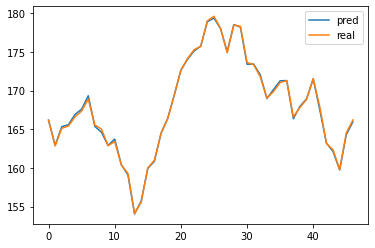

In [16]:
bmodel = TransformerTimeSeries(feature_dim = feature_dim,
                                  nhead = 4,num_layers = 12,d_model = 512,
                                  conv_len = 5,feature_weight = True,embedding_weight = True)
bmodel.load_state_dict(torch.load('AAPL_H'))
bmodel.to(device)
bmodel.eval()
with torch.no_grad(): # eliminate gradient i.e. gradients only exists in train()

    for step,(x,y,feature,attention_masks) in enumerate(test_dl):
        x = x.to(device)
        y = y.to(device)
        feature = feature.to(device)
        attention_masks = attention_masks.to(device)
        output = bmodel(x,y,feature,attention_masks[0])
        
        pred = data[train_size + 1 :-1,1]*0.01*(100+output[:,t0:].squeeze()).detach().cpu()
        ## note that test set starts at index train_size + 1 because idex train_size in rate_data 
        ## is the last day of first test data point, but rate_data only have the second til last data points
        ## of the dataset.
        real = data[train_size + 1 :-1,1]*0.01*(100+y[:,t0:].squeeze()).detach().cpu()

        plt.plot(pred)
        plt.plot(real)
        plt.legend(['pred','real'])
        MAE = torch.nn.L1Loss()(pred,real).item()
        MSE = torch.nn.MSELoss()(pred,real).item()
        RMSE = np.sqrt(MSE)
        
        print(f'AAPL MAE is {MAE}')
        print(f'AAPL MSE is {MSE}')
        print(f'AAPL RMSE is {RMSE}')

##### low

In [17]:
file_name = 'AAPL_features.csv'
with open(file_name) as f:
    data_list = csv.reader(f)
    data = []
    for row in data_list:
        data.append(row)
    f.close()
    
data = torch.tensor(np.delete(np.array(data)[1:,2:],4,axis = 1).astype(np.float)).type(torch.float)

feature_dim = data.shape[1] - 1
rate = []
for i in range(1,data.shape[0]):
    rate.append((100*(data[i,0:4] - data[i-1,0:4])/data[i-1,0:4]).reshape(1,4))
    
rate = torch.cat(rate)
rate_data = torch.cat([rate,data[1:,4:]],1)
train_size = int(data.shape[0]*0.9)
data_train = rate_data[0:train_size]
data_test = rate_data[train_size-4:]


t0 = 5
to_predict = 1
train_dataset = GetData(data_train[:,2],torch.cat([data_train[:,0:2],data_train[:,3:]],1),t0 = t0, to_predict = to_predict)
test_dataset = GetData(data_test[:,2],torch.cat([data_test[:,0:2],data_test[:,3:]],1),t0 = t0, to_predict = to_predict)
criterion = torch.nn.MSELoss()
# dataloaders
train_dl = DataLoader(train_dataset,batch_size=256,shuffle=True)
test_dl = DataLoader(test_dataset,batch_size=512)





model = TransformerTimeSeries(feature_dim = feature_dim,
                              nhead = 4,num_layers = 12,d_model = 512,
                              conv_len = 5,feature_weight = True,embedding_weight = True)
model = model.to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=1e-5 ,momentum = 0.9, nesterov = True)#Adam optimizer
#scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer,5e-7,3e-5,10,mode = 'exp_range',gamma = 0.9996)



train_epoch_loss = []
test_epoch_loss = []
test_best = 9999
for epoch in tqdm(range(4000)):


    l_t = train_epoch(model,train_dl,optimizer,t0,to_predict)

    train_loss = test_epoch(model,train_dl,t0,to_predict)


    test_loss = test_epoch(model,test_dl,t0,to_predict)


    if test_best > test_loss:
        test_best = test_loss
        torch.save(model.state_dict(), 'AAPL_L')



    train_epoch_loss.append(np.mean(train_loss))
    test_epoch_loss.append(test_loss)

    print("Epoch {}: Train loss: {} \t test loss: {}".format(epoch+1,
                                                             np.mean(train_loss),
                                                             test_loss))
    #scheduler.step()



torch.Size([431, 6])
torch.Size([431, 6])
torch.Size([47, 6])
torch.Size([47, 6])


  0%|                                                                                     | 0/4000 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1944: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
  0%|                                                                             | 1/4000 [00:00<24:00,  2.78it/s]

Epoch 1: Train loss: 1.4610460161333019 	 test loss: 1.617664098739624


  0%|                                                                             | 2/4000 [00:01<44:53,  1.48it/s]

Epoch 2: Train loss: 1.425779827509568 	 test loss: 1.5956462621688843


  0%|                                                                             | 3/4000 [00:02<51:26,  1.29it/s]

Epoch 3: Train loss: 1.3885169839637739 	 test loss: 1.5654078722000122


  0%|                                                                             | 4/4000 [00:03<54:25,  1.22it/s]

Epoch 4: Train loss: 1.3575352150990072 	 test loss: 1.5341204404830933


  0%|                                                                             | 6/4000 [00:04<40:07,  1.66it/s]

Epoch 5: Train loss: 1.3412841771428934 	 test loss: 1.5257700681686401
Epoch 6: Train loss: 1.3306463992789284 	 test loss: 1.526102900505066


  0%|▏                                                                            | 7/4000 [00:04<46:41,  1.43it/s]

Epoch 7: Train loss: 1.323082555474372 	 test loss: 1.5246368646621704


  0%|▏                                                                            | 8/4000 [00:05<50:06,  1.33it/s]

Epoch 8: Train loss: 1.3158309221820876 	 test loss: 1.521775722503662


  0%|▏                                                                            | 9/4000 [00:06<52:57,  1.26it/s]

Epoch 9: Train loss: 1.3082812557087697 	 test loss: 1.514013648033142


  0%|▏                                                                           | 10/4000 [00:07<54:56,  1.21it/s]

Epoch 10: Train loss: 1.3003683571472522 	 test loss: 1.5035665035247803


  0%|▏                                                                           | 11/4000 [00:08<55:46,  1.19it/s]

Epoch 11: Train loss: 1.291995034970153 	 test loss: 1.4913558959960938


  0%|▏                                                                           | 12/4000 [00:09<56:49,  1.17it/s]

Epoch 12: Train loss: 1.2828622226648707 	 test loss: 1.475787878036499


  0%|▏                                                                           | 13/4000 [00:10<57:33,  1.15it/s]

Epoch 13: Train loss: 1.274176655125452 	 test loss: 1.4596755504608154


  0%|▎                                                                           | 14/4000 [00:11<58:00,  1.15it/s]

Epoch 14: Train loss: 1.2658994280821763 	 test loss: 1.4438130855560303


  0%|▎                                                                           | 15/4000 [00:12<58:27,  1.14it/s]

Epoch 15: Train loss: 1.2576863879117501 	 test loss: 1.4295673370361328


  0%|▎                                                                           | 16/4000 [00:12<59:06,  1.12it/s]

Epoch 16: Train loss: 1.2501187529198807 	 test loss: 1.4170093536376953


  0%|▎                                                                           | 17/4000 [00:13<59:02,  1.12it/s]

Epoch 17: Train loss: 1.2426981596825017 	 test loss: 1.4059674739837646


  0%|▎                                                                           | 18/4000 [00:14<59:04,  1.12it/s]

Epoch 18: Train loss: 1.2353654997531334 	 test loss: 1.3953808546066284


  0%|▎                                                                           | 19/4000 [00:15<59:05,  1.12it/s]

Epoch 19: Train loss: 1.2279122733184744 	 test loss: 1.3849667310714722


  0%|▍                                                                           | 20/4000 [00:16<59:21,  1.12it/s]

Epoch 20: Train loss: 1.220394529212102 	 test loss: 1.3756508827209473


  1%|▍                                                                           | 21/4000 [00:17<59:13,  1.12it/s]

Epoch 21: Train loss: 1.2126490162586114 	 test loss: 1.3660848140716553


  1%|▍                                                                           | 22/4000 [00:18<59:12,  1.12it/s]

Epoch 22: Train loss: 1.2050919364057395 	 test loss: 1.3567087650299072


  1%|▍                                                                           | 23/4000 [00:19<58:51,  1.13it/s]

Epoch 23: Train loss: 1.1973198975875041 	 test loss: 1.346875786781311


  1%|▍                                                                           | 24/4000 [00:20<58:58,  1.12it/s]

Epoch 24: Train loss: 1.189616170117584 	 test loss: 1.337273120880127


  1%|▍                                                                           | 25/4000 [00:20<59:08,  1.12it/s]

Epoch 25: Train loss: 1.1820406924820832 	 test loss: 1.3275465965270996


  1%|▍                                                                           | 26/4000 [00:21<59:13,  1.12it/s]

Epoch 26: Train loss: 1.1739996621890854 	 test loss: 1.3172147274017334


  1%|▌                                                                           | 27/4000 [00:22<59:41,  1.11it/s]

Epoch 27: Train loss: 1.1661268967763454 	 test loss: 1.306511402130127


  1%|▌                                                                           | 28/4000 [00:23<59:25,  1.11it/s]

Epoch 28: Train loss: 1.1585990821125889 	 test loss: 1.295800805091858


  1%|▌                                                                           | 29/4000 [00:24<59:27,  1.11it/s]

Epoch 29: Train loss: 1.1511296410018497 	 test loss: 1.2849019765853882


  1%|▌                                                                           | 30/4000 [00:25<59:54,  1.10it/s]

Epoch 30: Train loss: 1.14355543815896 	 test loss: 1.2736681699752808


  1%|▌                                                                         | 31/4000 [00:26<1:00:14,  1.10it/s]

Epoch 31: Train loss: 1.1368360195801595 	 test loss: 1.2631360292434692


  1%|▌                                                                           | 32/4000 [00:27<59:54,  1.10it/s]

Epoch 32: Train loss: 1.1298376523701608 	 test loss: 1.2520393133163452


  1%|▋                                                                           | 33/4000 [00:28<58:54,  1.12it/s]

Epoch 33: Train loss: 1.1228457703114663 	 test loss: 1.2416772842407227


  1%|▋                                                                           | 34/4000 [00:29<58:57,  1.12it/s]

Epoch 34: Train loss: 1.116119117858515 	 test loss: 1.2309987545013428


  1%|▋                                                                           | 35/4000 [00:29<58:08,  1.14it/s]

Epoch 35: Train loss: 1.1093139792263094 	 test loss: 1.2203845977783203


  1%|▋                                                                           | 36/4000 [00:30<58:37,  1.13it/s]

Epoch 36: Train loss: 1.102294492057747 	 test loss: 1.2094712257385254


  1%|▋                                                                           | 37/4000 [00:31<59:26,  1.11it/s]

Epoch 37: Train loss: 1.0956013089266288 	 test loss: 1.19936203956604


  1%|▋                                                                           | 38/4000 [00:32<59:57,  1.10it/s]

Epoch 38: Train loss: 1.0887100541674621 	 test loss: 1.1888737678527832


  1%|▋                                                                           | 39/4000 [00:33<59:36,  1.11it/s]

Epoch 39: Train loss: 1.0817284158100384 	 test loss: 1.1779924631118774


  1%|▊                                                                           | 40/4000 [00:34<59:22,  1.11it/s]

Epoch 40: Train loss: 1.0750293294680922 	 test loss: 1.1672768592834473


  1%|▊                                                                           | 41/4000 [00:35<59:42,  1.11it/s]

Epoch 41: Train loss: 1.0686413406495983 	 test loss: 1.1568150520324707


  1%|▊                                                                           | 42/4000 [00:36<59:23,  1.11it/s]

Epoch 42: Train loss: 1.0616803692001202 	 test loss: 1.1458821296691895


  1%|▊                                                                           | 43/4000 [00:37<59:12,  1.11it/s]

Epoch 43: Train loss: 1.054753329527074 	 test loss: 1.135051965713501


  1%|▊                                                                           | 44/4000 [00:38<59:19,  1.11it/s]

Epoch 44: Train loss: 1.048263165347814 	 test loss: 1.1244888305664062


  1%|▊                                                                           | 45/4000 [00:38<59:20,  1.11it/s]

Epoch 45: Train loss: 1.041536496299602 	 test loss: 1.1137611865997314


  1%|▊                                                                           | 46/4000 [00:39<59:12,  1.11it/s]

Epoch 46: Train loss: 1.0345917981627923 	 test loss: 1.1033878326416016


  1%|▉                                                                           | 47/4000 [00:40<59:42,  1.10it/s]

Epoch 47: Train loss: 1.027971290380385 	 test loss: 1.0933512449264526


  1%|▉                                                                           | 48/4000 [00:41<58:40,  1.12it/s]

Epoch 48: Train loss: 1.0216133385689241 	 test loss: 1.0840131044387817


  1%|▉                                                                           | 49/4000 [00:42<58:46,  1.12it/s]

Epoch 49: Train loss: 1.0148402715227167 	 test loss: 1.0741429328918457


  1%|▉                                                                           | 50/4000 [00:43<58:35,  1.12it/s]

Epoch 50: Train loss: 1.0082985981434514 	 test loss: 1.0637677907943726


  1%|▉                                                                           | 51/4000 [00:44<58:35,  1.12it/s]

Epoch 51: Train loss: 1.0018203759138102 	 test loss: 1.053395390510559


  1%|▉                                                                           | 52/4000 [00:45<58:41,  1.12it/s]

Epoch 52: Train loss: 0.9958468484767905 	 test loss: 1.0434014797210693


  1%|█                                                                           | 53/4000 [00:46<59:24,  1.11it/s]

Epoch 53: Train loss: 0.9890232340642305 	 test loss: 1.0322356224060059


  1%|█                                                                           | 54/4000 [00:47<59:12,  1.11it/s]

Epoch 54: Train loss: 0.9825796461437252 	 test loss: 1.0218191146850586


  1%|█                                                                           | 55/4000 [00:47<59:03,  1.11it/s]

Epoch 55: Train loss: 0.976243646681447 	 test loss: 1.0112160444259644


  1%|█                                                                           | 56/4000 [00:48<59:37,  1.10it/s]

Epoch 56: Train loss: 0.970169054936367 	 test loss: 1.0000578165054321


  1%|█                                                                           | 57/4000 [00:49<59:23,  1.11it/s]

Epoch 57: Train loss: 0.9640455803295852 	 test loss: 0.9897062182426453


  1%|█                                                                           | 58/4000 [00:50<59:32,  1.10it/s]

Epoch 58: Train loss: 0.9580904065594595 	 test loss: 0.9808622002601624


  1%|█                                                                           | 59/4000 [00:51<59:48,  1.10it/s]

Epoch 59: Train loss: 0.9519766208190652 	 test loss: 0.9722735285758972


  2%|█▏                                                                          | 60/4000 [00:52<59:32,  1.10it/s]

Epoch 60: Train loss: 0.9458768546166387 	 test loss: 0.9646429419517517


  2%|█▏                                                                        | 61/4000 [00:53<1:00:05,  1.09it/s]

Epoch 61: Train loss: 0.9398820996284485 	 test loss: 0.9581348896026611


  2%|█▏                                                                          | 62/4000 [00:54<59:37,  1.10it/s]

Epoch 62: Train loss: 0.9337987415751836 	 test loss: 0.9515403509140015


  2%|█▏                                                                          | 63/4000 [00:55<58:37,  1.12it/s]

Epoch 63: Train loss: 0.9277615855575437 	 test loss: 0.9445374608039856


  2%|█▏                                                                          | 64/4000 [00:56<58:47,  1.12it/s]

Epoch 64: Train loss: 0.9215572957649585 	 test loss: 0.9385260343551636


  2%|█▏                                                                          | 65/4000 [00:57<59:17,  1.11it/s]

Epoch 65: Train loss: 0.9152872381243518 	 test loss: 0.9331120252609253


  2%|█▎                                                                          | 66/4000 [00:57<58:36,  1.12it/s]

Epoch 66: Train loss: 0.9088151623644021 	 test loss: 0.9275618195533752


  2%|█▎                                                                          | 67/4000 [00:58<58:40,  1.12it/s]

Epoch 67: Train loss: 0.902819321492985 	 test loss: 0.9218477010726929


  2%|█▎                                                                          | 68/4000 [00:59<58:33,  1.12it/s]

Epoch 68: Train loss: 0.8963267597134318 	 test loss: 0.9160894751548767


  2%|█▎                                                                          | 69/4000 [01:00<57:49,  1.13it/s]

Epoch 69: Train loss: 0.8906284938555582 	 test loss: 0.9101919531822205


  2%|█▎                                                                          | 70/4000 [01:01<57:56,  1.13it/s]

Epoch 70: Train loss: 0.8847048985155995 	 test loss: 0.904589056968689


  2%|█▎                                                                          | 71/4000 [01:02<59:10,  1.11it/s]

Epoch 71: Train loss: 0.8792458388202429 	 test loss: 0.8993833661079407


  2%|█▎                                                                          | 72/4000 [01:03<58:39,  1.12it/s]

Epoch 72: Train loss: 0.8735035377146196 	 test loss: 0.8938906788825989


  2%|█▍                                                                          | 73/4000 [01:04<58:34,  1.12it/s]

Epoch 73: Train loss: 0.8677334170053841 	 test loss: 0.8880050182342529


  2%|█▍                                                                          | 74/4000 [01:05<58:31,  1.12it/s]

Epoch 74: Train loss: 0.8623736564355218 	 test loss: 0.8825689554214478


  2%|█▍                                                                          | 75/4000 [01:05<57:59,  1.13it/s]

Epoch 75: Train loss: 0.8568640940427227 	 test loss: 0.8768802285194397


  2%|█▍                                                                          | 76/4000 [01:06<57:26,  1.14it/s]

Epoch 76: Train loss: 0.8513253356077278 	 test loss: 0.8708171248435974


  2%|█▍                                                                          | 77/4000 [01:07<57:41,  1.13it/s]

Epoch 77: Train loss: 0.8460160419172035 	 test loss: 0.8651801347732544


  2%|█▍                                                                          | 78/4000 [01:08<58:51,  1.11it/s]

Epoch 78: Train loss: 0.840861016940628 	 test loss: 0.8599991202354431


  2%|█▌                                                                          | 79/4000 [01:09<58:40,  1.11it/s]

Epoch 79: Train loss: 0.8354119745595273 	 test loss: 0.853834331035614


  2%|█▌                                                                          | 80/4000 [01:10<58:39,  1.11it/s]

Epoch 80: Train loss: 0.830075113098472 	 test loss: 0.8476172685623169


  2%|█▌                                                                          | 81/4000 [01:11<59:41,  1.09it/s]

Epoch 81: Train loss: 0.8249434238243546 	 test loss: 0.8416740298271179


  2%|█▌                                                                          | 82/4000 [01:12<59:33,  1.10it/s]

Epoch 82: Train loss: 0.8200518830469755 	 test loss: 0.8373249769210815


  2%|█▌                                                                          | 83/4000 [01:13<59:21,  1.10it/s]

Epoch 83: Train loss: 0.8153256606613124 	 test loss: 0.8325651288032532


  2%|█▌                                                                          | 84/4000 [01:14<58:59,  1.11it/s]

Epoch 84: Train loss: 0.8110557654894145 	 test loss: 0.827849805355072


  2%|█▌                                                                          | 85/4000 [01:14<58:47,  1.11it/s]

Epoch 85: Train loss: 0.8066980216453358 	 test loss: 0.8238213658332825


  2%|█▋                                                                          | 86/4000 [01:15<59:24,  1.10it/s]

Epoch 86: Train loss: 0.8022589325351671 	 test loss: 0.8203665018081665


  2%|█▋                                                                          | 87/4000 [01:16<59:36,  1.09it/s]

Epoch 87: Train loss: 0.7977265516455931 	 test loss: 0.8162720799446106


  2%|█▋                                                                        | 88/4000 [01:18<1:15:14,  1.15s/it]

Epoch 88: Train loss: 0.7934926130102294 	 test loss: 0.8122680187225342


  2%|█▋                                                                        | 89/4000 [01:25<3:11:56,  2.94s/it]

Epoch 89: Train loss: 0.7892500386160654 	 test loss: 0.8077138066291809


  2%|█▋                                                                        | 90/4000 [01:32<4:23:49,  4.05s/it]

Epoch 90: Train loss: 0.7849693168343634 	 test loss: 0.802786648273468


  2%|█▋                                                                        | 91/4000 [01:38<5:09:12,  4.75s/it]

Epoch 91: Train loss: 0.7811209405934451 	 test loss: 0.7987227439880371


  2%|█▋                                                                        | 92/4000 [01:44<5:38:50,  5.20s/it]

Epoch 92: Train loss: 0.7772350233834747 	 test loss: 0.7943982481956482


  2%|█▋                                                                        | 93/4000 [01:51<6:12:26,  5.72s/it]

Epoch 93: Train loss: 0.7734170939142355 	 test loss: 0.7905070185661316


  2%|█▋                                                                        | 94/4000 [01:58<6:29:35,  5.98s/it]

Epoch 94: Train loss: 0.7696061243590512 	 test loss: 0.786470890045166


  2%|█▊                                                                        | 95/4000 [02:04<6:34:41,  6.06s/it]

Epoch 95: Train loss: 0.76590747719851 	 test loss: 0.7824932932853699


  2%|█▊                                                                        | 96/4000 [02:11<6:51:34,  6.33s/it]

Epoch 96: Train loss: 0.7619532519592763 	 test loss: 0.7776938676834106


  2%|█▊                                                                        | 97/4000 [02:18<6:57:18,  6.42s/it]

Epoch 97: Train loss: 0.758104495963475 	 test loss: 0.7730013132095337


  2%|█▊                                                                        | 98/4000 [02:25<7:05:07,  6.54s/it]

Epoch 98: Train loss: 0.7542286558106991 	 test loss: 0.7686842083930969


  2%|█▊                                                                        | 99/4000 [02:31<7:01:26,  6.48s/it]

Epoch 99: Train loss: 0.7505679260550409 	 test loss: 0.7638866305351257


  2%|█▊                                                                       | 100/4000 [02:38<7:04:28,  6.53s/it]

Epoch 100: Train loss: 0.7469519992162346 	 test loss: 0.7608152031898499


  3%|█▊                                                                       | 101/4000 [02:44<7:04:02,  6.53s/it]

Epoch 101: Train loss: 0.7434621251376212 	 test loss: 0.757378339767456


  3%|█▊                                                                       | 102/4000 [02:51<7:05:50,  6.55s/it]

Epoch 102: Train loss: 0.7400353346236067 	 test loss: 0.7549861669540405


  3%|█▉                                                                       | 103/4000 [02:57<6:54:04,  6.38s/it]

Epoch 103: Train loss: 0.736659379680306 	 test loss: 0.7521809935569763


  3%|█▉                                                                       | 104/4000 [03:04<7:05:53,  6.56s/it]

Epoch 104: Train loss: 0.7332789236874149 	 test loss: 0.750456690788269


  3%|█▉                                                                       | 105/4000 [03:11<7:13:29,  6.68s/it]

Epoch 105: Train loss: 0.7302987011292141 	 test loss: 0.7486535310745239


  3%|█▉                                                                       | 106/4000 [03:17<7:11:57,  6.66s/it]

Epoch 106: Train loss: 0.7270661151326173 	 test loss: 0.7460403442382812


  3%|█▉                                                                       | 107/4000 [03:24<7:10:03,  6.63s/it]

Epoch 107: Train loss: 0.724578459688793 	 test loss: 0.7445725798606873


  3%|█▉                                                                       | 108/4000 [03:30<7:10:03,  6.63s/it]

Epoch 108: Train loss: 0.7208909269275355 	 test loss: 0.7403451204299927


  3%|█▉                                                                       | 109/4000 [03:37<7:12:50,  6.67s/it]

Epoch 109: Train loss: 0.7169835567474365 	 test loss: 0.7361414432525635


  3%|██                                                                       | 110/4000 [03:44<7:07:53,  6.60s/it]

Epoch 110: Train loss: 0.713407827502337 	 test loss: 0.7313271760940552


  3%|██                                                                       | 111/4000 [03:50<7:07:44,  6.60s/it]

Epoch 111: Train loss: 0.7105929810043831 	 test loss: 0.7273150086402893


  3%|██                                                                       | 112/4000 [03:57<7:06:33,  6.58s/it]

Epoch 112: Train loss: 0.7071493969162767 	 test loss: 0.7244855761528015


  3%|██                                                                       | 113/4000 [04:04<7:12:42,  6.68s/it]

Epoch 113: Train loss: 0.7033665545302035 	 test loss: 0.7204453349113464


  3%|██                                                                       | 114/4000 [04:10<7:10:06,  6.64s/it]

Epoch 114: Train loss: 0.6998780371141544 	 test loss: 0.7162311673164368


  3%|██                                                                       | 115/4000 [04:17<7:10:18,  6.65s/it]

Epoch 115: Train loss: 0.6964108014604609 	 test loss: 0.712944746017456


  3%|██                                                                       | 116/4000 [04:23<7:06:59,  6.60s/it]

Epoch 116: Train loss: 0.6926965342873487 	 test loss: 0.709835410118103


  3%|██▏                                                                      | 117/4000 [04:29<6:55:30,  6.42s/it]

Epoch 117: Train loss: 0.6899854835390768 	 test loss: 0.7073453068733215


  3%|██▏                                                                      | 118/4000 [04:37<7:13:12,  6.70s/it]

Epoch 118: Train loss: 0.6861490352800993 	 test loss: 0.703100860118866


  3%|██▏                                                                      | 119/4000 [04:43<7:10:31,  6.66s/it]

Epoch 119: Train loss: 0.6828693884431348 	 test loss: 0.6984285712242126


  3%|██▏                                                                      | 120/4000 [04:49<7:02:58,  6.54s/it]

Epoch 120: Train loss: 0.6788794125868937 	 test loss: 0.6932829022407532


  3%|██▏                                                                      | 121/4000 [04:56<7:04:37,  6.57s/it]

Epoch 121: Train loss: 0.6747929063861166 	 test loss: 0.6885338425636292


  3%|██▏                                                                      | 122/4000 [05:03<7:12:00,  6.68s/it]

Epoch 122: Train loss: 0.6711906602653716 	 test loss: 0.6841106414794922


  3%|██▏                                                                      | 123/4000 [05:09<7:06:30,  6.60s/it]

Epoch 123: Train loss: 0.6669544166865868 	 test loss: 0.680209755897522


  3%|██▎                                                                      | 124/4000 [05:16<7:10:16,  6.66s/it]

Epoch 124: Train loss: 0.6631572354420708 	 test loss: 0.6763511300086975


  3%|██▎                                                                      | 125/4000 [05:23<7:05:21,  6.59s/it]

Epoch 125: Train loss: 0.6589692004042269 	 test loss: 0.6715502738952637


  3%|██▎                                                                      | 126/4000 [05:29<7:02:59,  6.55s/it]

Epoch 126: Train loss: 0.6556035606601122 	 test loss: 0.6671956181526184


  3%|██▎                                                                      | 127/4000 [05:36<7:09:13,  6.65s/it]

Epoch 127: Train loss: 0.651838508946713 	 test loss: 0.6629387140274048


  3%|██▎                                                                      | 128/4000 [05:43<7:09:23,  6.65s/it]

Epoch 128: Train loss: 0.6481252462017564 	 test loss: 0.657866358757019


  3%|██▎                                                                      | 129/4000 [05:49<7:01:52,  6.54s/it]

Epoch 129: Train loss: 0.6441834036546075 	 test loss: 0.6547481417655945


  3%|██▎                                                                      | 130/4000 [05:56<7:09:03,  6.65s/it]

Epoch 130: Train loss: 0.6403584950484699 	 test loss: 0.6506934762001038


  3%|██▍                                                                      | 131/4000 [06:03<7:08:03,  6.64s/it]

Epoch 131: Train loss: 0.6370910147503192 	 test loss: 0.6467884182929993


  3%|██▍                                                                      | 132/4000 [06:09<7:04:37,  6.59s/it]

Epoch 132: Train loss: 0.633662429597151 	 test loss: 0.6439530849456787


  3%|██▍                                                                      | 133/4000 [06:16<7:06:50,  6.62s/it]

Epoch 133: Train loss: 0.6297474298842268 	 test loss: 0.6400842666625977


  3%|██▍                                                                      | 134/4000 [06:22<7:06:55,  6.63s/it]

Epoch 134: Train loss: 0.6266032027257844 	 test loss: 0.6371129155158997


  3%|██▍                                                                      | 135/4000 [06:29<7:06:21,  6.62s/it]

Epoch 135: Train loss: 0.6233307959861932 	 test loss: 0.63326096534729


  3%|██▍                                                                      | 136/4000 [06:36<7:06:21,  6.62s/it]

Epoch 136: Train loss: 0.6192251846297988 	 test loss: 0.6286130547523499


  3%|██▌                                                                      | 137/4000 [06:42<7:06:08,  6.62s/it]

Epoch 137: Train loss: 0.6154199143020294 	 test loss: 0.6249597072601318


  3%|██▌                                                                      | 138/4000 [06:49<7:05:42,  6.61s/it]

Epoch 138: Train loss: 0.6119301237528949 	 test loss: 0.6205503940582275


  3%|██▌                                                                      | 139/4000 [06:55<7:04:46,  6.60s/it]

Epoch 139: Train loss: 0.6082543714140518 	 test loss: 0.6151545643806458


  4%|██▌                                                                      | 140/4000 [07:02<7:05:29,  6.61s/it]

Epoch 140: Train loss: 0.6046242113732959 	 test loss: 0.6111122965812683


  4%|██▌                                                                      | 141/4000 [07:09<7:04:58,  6.61s/it]

Epoch 141: Train loss: 0.6016636114662596 	 test loss: 0.6070489287376404


  4%|██▌                                                                      | 142/4000 [07:15<7:03:56,  6.59s/it]

Epoch 142: Train loss: 0.5979015437190328 	 test loss: 0.6053414344787598


  4%|██▌                                                                      | 143/4000 [07:22<7:04:03,  6.60s/it]

Epoch 143: Train loss: 0.5949256566726968 	 test loss: 0.6044374704360962


  4%|██▋                                                                      | 144/4000 [07:28<6:58:40,  6.51s/it]

Epoch 144: Train loss: 0.5920476593993379 	 test loss: 0.6033743619918823


  4%|██▋                                                                      | 145/4000 [07:35<7:11:57,  6.72s/it]

Epoch 145: Train loss: 0.588255487572566 	 test loss: 0.5988955497741699


  4%|██▋                                                                      | 146/4000 [07:41<7:02:30,  6.58s/it]

Epoch 146: Train loss: 0.5851081012296566 	 test loss: 0.595963180065155


  4%|██▋                                                                      | 147/4000 [07:48<7:03:03,  6.59s/it]

Epoch 147: Train loss: 0.5821393978568075 	 test loss: 0.5928471088409424


  4%|██▋                                                                      | 148/4000 [07:55<7:08:39,  6.68s/it]

Epoch 148: Train loss: 0.5786382554578671 	 test loss: 0.5883723497390747


  4%|██▋                                                                      | 149/4000 [08:02<7:07:56,  6.67s/it]

Epoch 149: Train loss: 0.5754719102742224 	 test loss: 0.5851736664772034


  4%|██▋                                                                      | 150/4000 [08:08<7:06:59,  6.65s/it]

Epoch 150: Train loss: 0.5725260401823128 	 test loss: 0.5829149484634399


  4%|██▊                                                                      | 151/4000 [08:15<7:06:13,  6.64s/it]

Epoch 151: Train loss: 0.5688567200973803 	 test loss: 0.5778868198394775


  4%|██▊                                                                      | 152/4000 [08:21<7:04:18,  6.62s/it]

Epoch 152: Train loss: 0.5653256177902222 	 test loss: 0.5749518275260925


  4%|██▊                                                                      | 153/4000 [08:27<6:51:19,  6.42s/it]

Epoch 153: Train loss: 0.5621565968973731 	 test loss: 0.5719655156135559


  4%|██▊                                                                      | 154/4000 [08:35<7:08:00,  6.68s/it]

Epoch 154: Train loss: 0.5593659070141077 	 test loss: 0.5694326162338257


  4%|██▊                                                                      | 155/4000 [08:41<7:08:50,  6.69s/it]

Epoch 155: Train loss: 0.5564617994489913 	 test loss: 0.5665148496627808


  4%|██▊                                                                      | 156/4000 [08:48<6:58:17,  6.53s/it]

Epoch 156: Train loss: 0.5541007456536082 	 test loss: 0.564706563949585


  4%|██▊                                                                      | 157/4000 [08:54<7:05:23,  6.64s/it]

Epoch 157: Train loss: 0.5506586378522372 	 test loss: 0.5615572929382324


  4%|██▉                                                                      | 158/4000 [09:01<7:05:07,  6.64s/it]

Epoch 158: Train loss: 0.5477359578393728 	 test loss: 0.5584425926208496


  4%|██▉                                                                      | 159/4000 [09:08<7:04:17,  6.63s/it]

Epoch 159: Train loss: 0.5438847501703868 	 test loss: 0.5546732544898987


  4%|██▉                                                                      | 160/4000 [09:14<6:50:55,  6.42s/it]

Epoch 160: Train loss: 0.5407795579693434 	 test loss: 0.5510163307189941


  4%|██▉                                                                      | 161/4000 [09:21<7:07:06,  6.68s/it]

Epoch 161: Train loss: 0.5378354457304262 	 test loss: 0.5482641458511353


  4%|██▉                                                                      | 162/4000 [09:27<6:59:26,  6.56s/it]

Epoch 162: Train loss: 0.5350674670146403 	 test loss: 0.5460712313652039


  4%|██▉                                                                      | 163/4000 [09:34<7:00:22,  6.57s/it]

Epoch 163: Train loss: 0.5329665765684884 	 test loss: 0.5440260767936707


  4%|██▉                                                                      | 164/4000 [09:40<6:59:38,  6.56s/it]

Epoch 164: Train loss: 0.5296764716748018 	 test loss: 0.5401344895362854


  4%|███                                                                      | 165/4000 [09:47<7:07:55,  6.69s/it]

Epoch 165: Train loss: 0.5271560035282941 	 test loss: 0.5369510650634766


  4%|███                                                                      | 166/4000 [09:54<7:04:38,  6.65s/it]

Epoch 166: Train loss: 0.5241429168221016 	 test loss: 0.5335077047348022


  4%|███                                                                      | 167/4000 [10:00<7:04:29,  6.64s/it]

Epoch 167: Train loss: 0.5209723325173982 	 test loss: 0.530361533164978


  4%|███                                                                      | 168/4000 [10:07<7:04:08,  6.64s/it]

Epoch 168: Train loss: 0.5183799514361158 	 test loss: 0.5272236466407776


  4%|███                                                                      | 169/4000 [10:13<6:57:21,  6.54s/it]

Epoch 169: Train loss: 0.5157765943876829 	 test loss: 0.5249041318893433


  4%|███                                                                      | 170/4000 [10:20<6:57:46,  6.54s/it]

Epoch 170: Train loss: 0.513328232579884 	 test loss: 0.5225589871406555


  4%|███                                                                      | 171/4000 [10:27<7:05:43,  6.67s/it]

Epoch 171: Train loss: 0.5114992863894062 	 test loss: 0.5216139554977417


  4%|███▏                                                                     | 172/4000 [10:34<7:04:17,  6.65s/it]

Epoch 172: Train loss: 0.5083003618047851 	 test loss: 0.5180372595787048


  4%|███▏                                                                     | 174/4000 [10:40<5:00:02,  4.71s/it]

Epoch 173: Train loss: 0.5046421795599422 	 test loss: 0.5151166319847107
Epoch 174: Train loss: 0.5031975426142841 	 test loss: 0.5153855681419373


  4%|███▏                                                                     | 176/4000 [10:41<2:31:30,  2.38s/it]

Epoch 175: Train loss: 0.5019989286110739 	 test loss: 0.5157174468040466
Epoch 176: Train loss: 0.5011176729700129 	 test loss: 0.5161025524139404


  4%|███▏                                                                     | 177/4000 [10:46<3:35:52,  3.39s/it]

Epoch 177: Train loss: 0.4981244393125211 	 test loss: 0.5131722688674927


  4%|███▏                                                                     | 178/4000 [10:53<4:37:51,  4.36s/it]

Epoch 178: Train loss: 0.4924846385581864 	 test loss: 0.5074236989021301


  4%|███▎                                                                     | 179/4000 [11:00<5:26:50,  5.13s/it]

Epoch 179: Train loss: 0.48803703607926513 	 test loss: 0.5046367645263672


  5%|███▎                                                                     | 181/4000 [11:07<4:10:02,  3.93s/it]

Epoch 180: Train loss: 0.4844972068776664 	 test loss: 0.5025311708450317
Epoch 181: Train loss: 0.481815045919883 	 test loss: 0.5029247403144836


  5%|███▎                                                                     | 183/4000 [11:13<3:28:08,  3.27s/it]

Epoch 182: Train loss: 0.4807584650140351 	 test loss: 0.5000153183937073
Epoch 183: Train loss: 0.48247840965983485 	 test loss: 0.5010635852813721


  5%|███▎                                                                     | 184/4000 [11:20<4:39:38,  4.40s/it]

Epoch 184: Train loss: 0.4814100579429945 	 test loss: 0.49962395429611206


  5%|███▍                                                                     | 185/4000 [11:27<5:21:38,  5.06s/it]

Epoch 185: Train loss: 0.4797776030277155 	 test loss: 0.4991105794906616


  5%|███▍                                                                     | 186/4000 [11:33<5:50:00,  5.51s/it]

Epoch 186: Train loss: 0.47688682650468744 	 test loss: 0.4961985945701599


  5%|███▍                                                                     | 187/4000 [11:40<6:12:23,  5.86s/it]

Epoch 187: Train loss: 0.47257956758729264 	 test loss: 0.49230605363845825


  5%|███▍                                                                     | 188/4000 [11:46<6:19:48,  5.98s/it]

Epoch 188: Train loss: 0.46753184825804284 	 test loss: 0.4871602952480316


  5%|███▍                                                                     | 189/4000 [11:53<6:31:52,  6.17s/it]

Epoch 189: Train loss: 0.46454487751365536 	 test loss: 0.4852107763290405


  5%|███▍                                                                     | 190/4000 [11:59<6:39:57,  6.30s/it]

Epoch 190: Train loss: 0.4630626866684712 	 test loss: 0.4839690923690796


  5%|███▍                                                                     | 191/4000 [12:06<6:51:42,  6.49s/it]

Epoch 191: Train loss: 0.46089673367287887 	 test loss: 0.48199760913848877


  5%|███▌                                                                     | 192/4000 [12:13<6:54:06,  6.52s/it]

Epoch 192: Train loss: 0.4588813891681884 	 test loss: 0.48055922985076904


  5%|███▌                                                                     | 193/4000 [12:19<6:55:19,  6.55s/it]

Epoch 193: Train loss: 0.4556797342482963 	 test loss: 0.47822970151901245


  5%|███▌                                                                     | 194/4000 [12:26<6:56:28,  6.57s/it]

Epoch 194: Train loss: 0.4545624381981427 	 test loss: 0.4773755371570587


  5%|███▌                                                                     | 195/4000 [12:33<6:57:43,  6.59s/it]

Epoch 195: Train loss: 0.4523263678058394 	 test loss: 0.4760943055152893


  5%|███▌                                                                     | 196/4000 [12:39<6:57:11,  6.58s/it]

Epoch 196: Train loss: 0.4493784133491826 	 test loss: 0.4741535484790802


  5%|███▌                                                                     | 198/4000 [12:46<4:50:41,  4.59s/it]

Epoch 197: Train loss: 0.4480558926295792 	 test loss: 0.47289153933525085
Epoch 198: Train loss: 0.4544151308503339 	 test loss: 0.48269253969192505


  5%|███▋                                                                     | 200/4000 [12:46<2:27:49,  2.33s/it]

Epoch 199: Train loss: 0.4506965702066842 	 test loss: 0.4793424606323242
Epoch 200: Train loss: 0.4460243633894245 	 test loss: 0.4767025411128998


  5%|███▋                                                                     | 202/4000 [12:46<1:16:49,  1.21s/it]

Epoch 201: Train loss: 0.44252964314894444 	 test loss: 0.47496047616004944
Epoch 202: Train loss: 0.4398950776063649 	 test loss: 0.4750588536262512


  5%|███▋                                                                     | 203/4000 [12:52<2:39:10,  2.52s/it]

Epoch 203: Train loss: 0.43809053689033967 	 test loss: 0.47237905859947205


  5%|███▋                                                                     | 204/4000 [12:59<4:09:12,  3.94s/it]

Epoch 204: Train loss: 0.43648220996292453 	 test loss: 0.4686620831489563


  5%|███▋                                                                     | 205/4000 [13:05<4:53:36,  4.64s/it]

Epoch 205: Train loss: 0.43567004322729086 	 test loss: 0.46735432744026184


  5%|███▊                                                                     | 206/4000 [13:12<5:37:48,  5.34s/it]

Epoch 206: Train loss: 0.4331655964912229 	 test loss: 0.46530020236968994


  5%|███▊                                                                     | 208/4000 [13:19<4:15:50,  4.05s/it]

Epoch 207: Train loss: 0.4321071673573585 	 test loss: 0.46446120738983154
Epoch 208: Train loss: 0.4310736244073323 	 test loss: 0.4651009142398834


  5%|███▊                                                                     | 210/4000 [13:19<2:09:42,  2.05s/it]

Epoch 209: Train loss: 0.4306934410900638 	 test loss: 0.4662427604198456
Epoch 210: Train loss: 0.4300898543090112 	 test loss: 0.46737730503082275


  5%|███▊                                                                     | 211/4000 [13:20<1:33:22,  1.48s/it]

Epoch 211: Train loss: 0.4294371078711375 	 test loss: 0.467010498046875


  5%|███▊                                                                     | 212/4000 [13:25<2:53:19,  2.75s/it]

Epoch 212: Train loss: 0.42678011756761997 	 test loss: 0.46424058079719543


  5%|███▉                                                                     | 213/4000 [13:32<4:06:31,  3.91s/it]

Epoch 213: Train loss: 0.4224473959193705 	 test loss: 0.458001047372818


  5%|███▉                                                                     | 214/4000 [13:39<5:03:58,  4.82s/it]

Epoch 214: Train loss: 0.419578249797467 	 test loss: 0.456643670797348


  5%|███▉                                                                     | 215/4000 [13:45<5:38:08,  5.36s/it]

Epoch 215: Train loss: 0.4177219001295395 	 test loss: 0.45533138513565063


  5%|███▉                                                                     | 216/4000 [13:52<5:58:25,  5.68s/it]

Epoch 216: Train loss: 0.4158474977221124 	 test loss: 0.4534682631492615


  5%|███▉                                                                     | 217/4000 [13:59<6:18:19,  6.00s/it]

Epoch 217: Train loss: 0.41389699221487114 	 test loss: 0.45133060216903687


  5%|███▉                                                                     | 218/4000 [14:05<6:33:57,  6.25s/it]

Epoch 218: Train loss: 0.41248967745741116 	 test loss: 0.4495595395565033


  5%|███▉                                                                     | 219/4000 [14:12<6:37:10,  6.30s/it]

Epoch 219: Train loss: 0.4118065017420289 	 test loss: 0.4488825500011444


  6%|████                                                                     | 220/4000 [14:18<6:43:01,  6.40s/it]

Epoch 220: Train loss: 0.4097900529610309 	 test loss: 0.4474047124385834


  6%|████                                                                     | 222/4000 [14:25<4:49:31,  4.60s/it]

Epoch 221: Train loss: 0.408227132326489 	 test loss: 0.44676390290260315
Epoch 222: Train loss: 0.4079488916214547 	 test loss: 0.44763296842575073


  6%|████                                                                     | 224/4000 [14:26<2:26:43,  2.33s/it]

Epoch 223: Train loss: 0.40644495897945837 	 test loss: 0.447952002286911
Epoch 224: Train loss: 0.4061479293276705 	 test loss: 0.44866788387298584


  6%|████                                                                     | 226/4000 [14:26<1:16:46,  1.22s/it]

Epoch 225: Train loss: 0.40598110533092524 	 test loss: 0.44944000244140625
Epoch 226: Train loss: 0.4032908500347226 	 test loss: 0.4479004442691803


  6%|████▏                                                                    | 227/4000 [14:32<2:40:38,  2.55s/it]

Epoch 227: Train loss: 0.4005663521466842 	 test loss: 0.4459339678287506


  6%|████▏                                                                    | 228/4000 [14:38<3:56:21,  3.76s/it]

Epoch 228: Train loss: 0.3993182651819596 	 test loss: 0.4453819990158081


  6%|████▏                                                                    | 229/4000 [14:45<4:50:51,  4.63s/it]

Epoch 229: Train loss: 0.3971547917949075 	 test loss: 0.4431648254394531


  6%|████▏                                                                    | 230/4000 [14:51<5:15:25,  5.02s/it]

Epoch 230: Train loss: 0.3964999188126655 	 test loss: 0.443108469247818


  6%|████▏                                                                    | 231/4000 [14:58<5:57:39,  5.69s/it]

Epoch 231: Train loss: 0.3949729242900131 	 test loss: 0.44233158230781555


  6%|████▎                                                                    | 233/4000 [15:05<4:23:49,  4.20s/it]

Epoch 232: Train loss: 0.39347688338596143 	 test loss: 0.4414798617362976
Epoch 233: Train loss: 0.39300393283782037 	 test loss: 0.4421074092388153


  6%|████▎                                                                    | 234/4000 [15:05<3:07:23,  2.99s/it]

Epoch 234: Train loss: 0.392575854422598 	 test loss: 0.44178539514541626


  6%|████▎                                                                    | 235/4000 [15:12<4:15:38,  4.07s/it]

Epoch 235: Train loss: 0.39136572247868073 	 test loss: 0.44066357612609863


  6%|████▎                                                                    | 236/4000 [15:18<5:02:23,  4.82s/it]

Epoch 236: Train loss: 0.3892023177545198 	 test loss: 0.4378773272037506


  6%|████▎                                                                    | 237/4000 [15:25<5:36:37,  5.37s/it]

Epoch 237: Train loss: 0.38637210321537024 	 test loss: 0.43542012572288513


  6%|████▎                                                                    | 238/4000 [15:32<6:04:38,  5.82s/it]

Epoch 238: Train loss: 0.38470204378502 	 test loss: 0.4335189759731293


  6%|████▍                                                                    | 240/4000 [15:38<4:25:28,  4.24s/it]

Epoch 239: Train loss: 0.3838251910740704 	 test loss: 0.43319782614707947
Epoch 240: Train loss: 0.38258631143658456 	 test loss: 0.4333942234516144


  6%|████▍                                                                    | 242/4000 [15:38<2:14:54,  2.15s/it]

Epoch 241: Train loss: 0.38208686102294037 	 test loss: 0.43387407064437866
Epoch 242: Train loss: 0.38136457352793135 	 test loss: 0.4341479539871216


  6%|████▍                                                                    | 243/4000 [15:39<1:37:20,  1.55s/it]

Epoch 243: Train loss: 0.3800724887930877 	 test loss: 0.4336621165275574


  6%|████▍                                                                    | 245/4000 [15:44<2:04:49,  1.99s/it]

Epoch 244: Train loss: 0.3788199813349341 	 test loss: 0.43314602971076965
Epoch 245: Train loss: 0.37934112825415806 	 test loss: 0.4341009557247162


  6%|████▌                                                                    | 247/4000 [15:45<1:06:06,  1.06s/it]

Epoch 246: Train loss: 0.378936661645044 	 test loss: 0.43452298641204834
Epoch 247: Train loss: 0.3791135732784625 	 test loss: 0.43574586510658264


  6%|████▌                                                                    | 248/4000 [15:51<2:46:49,  2.67s/it]

Epoch 248: Train loss: 0.3765174027385402 	 test loss: 0.4326768219470978


  6%|████▌                                                                    | 249/4000 [15:58<4:01:00,  3.85s/it]

Epoch 249: Train loss: 0.3747755848476339 	 test loss: 0.43107205629348755


  6%|████▌                                                                    | 250/4000 [16:04<4:52:07,  4.67s/it]

Epoch 250: Train loss: 0.3742073849707911 	 test loss: 0.43037185072898865


  6%|████▌                                                                    | 251/4000 [16:11<5:29:08,  5.27s/it]

Epoch 251: Train loss: 0.3723477667279697 	 test loss: 0.4272420108318329


  6%|████▌                                                                    | 253/4000 [16:17<4:02:13,  3.88s/it]

Epoch 252: Train loss: 0.37066309883533666 	 test loss: 0.42638280987739563
Epoch 253: Train loss: 0.37049096788165187 	 test loss: 0.4274498522281647


  6%|████▋                                                                    | 254/4000 [16:17<2:52:30,  2.76s/it]

Epoch 254: Train loss: 0.36947568476614984 	 test loss: 0.4264403283596039


  6%|████▋                                                                    | 256/4000 [16:24<2:56:57,  2.84s/it]

Epoch 255: Train loss: 0.36864026364483576 	 test loss: 0.42571455240249634
Epoch 256: Train loss: 0.36803178271395426 	 test loss: 0.42590299248695374


  6%|████▋                                                                    | 257/4000 [16:31<4:06:46,  3.96s/it]

Epoch 257: Train loss: 0.36501267842792856 	 test loss: 0.4219847321510315


  6%|████▋                                                                    | 259/4000 [16:38<3:29:47,  3.36s/it]

Epoch 258: Train loss: 0.3625319331815237 	 test loss: 0.41757073998451233
Epoch 259: Train loss: 0.36206681746341235 	 test loss: 0.4184093773365021


  6%|████▋                                                                    | 260/4000 [16:38<2:30:01,  2.41s/it]

Epoch 260: Train loss: 0.3613125772459601 	 test loss: 0.4179295301437378


  7%|████▊                                                                    | 262/4000 [16:44<2:30:44,  2.42s/it]

Epoch 261: Train loss: 0.361064983147203 	 test loss: 0.4175315499305725
Epoch 262: Train loss: 0.3609120064434485 	 test loss: 0.41785576939582825


  7%|████▊                                                                    | 264/4000 [16:51<2:49:22,  2.72s/it]

Epoch 263: Train loss: 0.3601559991764635 	 test loss: 0.41748669743537903
Epoch 264: Train loss: 0.360916764996168 	 test loss: 0.41910016536712646


  7%|████▊                                                                    | 266/4000 [16:51<1:28:29,  1.42s/it]

Epoch 265: Train loss: 0.3599344343292741 	 test loss: 0.4177297055721283
Epoch 266: Train loss: 0.3593086042979477 	 test loss: 0.4175652861595154


  7%|████▊                                                                    | 267/4000 [16:57<2:49:17,  2.72s/it]

Epoch 267: Train loss: 0.3587422801004485 	 test loss: 0.41745099425315857


  7%|████▉                                                                    | 268/4000 [17:04<4:07:04,  3.97s/it]

Epoch 268: Train loss: 0.3573269623476502 	 test loss: 0.41514918208122253


  7%|████▉                                                                    | 269/4000 [17:10<4:55:21,  4.75s/it]

Epoch 269: Train loss: 0.35565238513415487 	 test loss: 0.411910742521286


  7%|████▉                                                                    | 270/4000 [17:17<5:31:55,  5.34s/it]

Epoch 270: Train loss: 0.35514415485952955 	 test loss: 0.41175419092178345


  7%|████▉                                                                    | 272/4000 [17:24<4:11:20,  4.05s/it]

Epoch 271: Train loss: 0.35381751236119013 	 test loss: 0.4112348258495331
Epoch 272: Train loss: 0.35372717267122733 	 test loss: 0.4123809337615967


  7%|█████                                                                    | 274/4000 [17:24<2:08:23,  2.07s/it]

Epoch 273: Train loss: 0.35345745107414 	 test loss: 0.4128764271736145
Epoch 274: Train loss: 0.3526295525845132 	 test loss: 0.41165560483932495


  7%|█████                                                                    | 275/4000 [17:24<1:33:06,  1.50s/it]

Epoch 275: Train loss: 0.3520683705668438 	 test loss: 0.41138774156570435


  7%|█████                                                                    | 276/4000 [17:30<2:50:03,  2.74s/it]

Epoch 276: Train loss: 0.35098878420422636 	 test loss: 0.4100285768508911


  7%|█████                                                                    | 277/4000 [17:37<4:02:11,  3.90s/it]

Epoch 277: Train loss: 0.3502334235992343 	 test loss: 0.40875402092933655


  7%|█████                                                                    | 278/4000 [17:43<4:58:00,  4.80s/it]

Epoch 278: Train loss: 0.3486971302679686 	 test loss: 0.4059290587902069


  7%|█████                                                                    | 279/4000 [17:50<5:32:10,  5.36s/it]

Epoch 279: Train loss: 0.3477205801452672 	 test loss: 0.40346837043762207


  7%|█████▏                                                                   | 281/4000 [17:56<4:06:23,  3.98s/it]

Epoch 280: Train loss: 0.346750792453018 	 test loss: 0.4028013348579407
Epoch 281: Train loss: 0.3461849767619662 	 test loss: 0.40387052297592163


  7%|█████▏                                                                   | 283/4000 [17:57<2:04:59,  2.02s/it]

Epoch 282: Train loss: 0.34689688025660415 	 test loss: 0.407008558511734
Epoch 283: Train loss: 0.34636414217008515 	 test loss: 0.4066740572452545


  7%|█████▏                                                                   | 284/4000 [17:57<1:30:01,  1.45s/it]

Epoch 284: Train loss: 0.3453927833906736 	 test loss: 0.40498480200767517


  7%|█████▏                                                                   | 285/4000 [18:03<3:02:03,  2.94s/it]

Epoch 285: Train loss: 0.34408810575710924 	 test loss: 0.4025993347167969


  7%|█████▏                                                                   | 286/4000 [18:10<4:10:12,  4.04s/it]

Epoch 286: Train loss: 0.3425499288637511 	 test loss: 0.40101033449172974


  7%|█████▏                                                                   | 287/4000 [18:16<4:57:57,  4.81s/it]

Epoch 287: Train loss: 0.3410444592931708 	 test loss: 0.39982935786247253


  7%|█████▎                                                                   | 288/4000 [18:23<5:30:43,  5.35s/it]

Epoch 288: Train loss: 0.3394771944342522 	 test loss: 0.3983456790447235


  7%|█████▎                                                                   | 290/4000 [18:29<4:06:11,  3.98s/it]

Epoch 289: Train loss: 0.3380832168729565 	 test loss: 0.39575469493865967
Epoch 290: Train loss: 0.33732619715677337 	 test loss: 0.3957926034927368


  7%|█████▎                                                                   | 292/4000 [18:30<2:04:56,  2.02s/it]

Epoch 291: Train loss: 0.3374427903417645 	 test loss: 0.396725594997406
Epoch 292: Train loss: 0.33688955904436224 	 test loss: 0.39609330892562866


  7%|█████▎                                                                   | 293/4000 [18:30<1:29:58,  1.46s/it]

Epoch 293: Train loss: 0.33652954733565343 	 test loss: 0.39626583456993103


  7%|█████▎                                                                   | 294/4000 [18:36<3:01:09,  2.93s/it]

Epoch 294: Train loss: 0.3358898265179238 	 test loss: 0.3955477178096771


  7%|█████▍                                                                   | 295/4000 [18:43<4:08:56,  4.03s/it]

Epoch 295: Train loss: 0.3344964684438816 	 test loss: 0.3932623267173767


  7%|█████▍                                                                   | 297/4000 [18:50<3:30:05,  3.40s/it]

Epoch 296: Train loss: 0.3332690330364865 	 test loss: 0.3909096419811249
Epoch 297: Train loss: 0.3326433842392366 	 test loss: 0.39098992943763733


  7%|█████▍                                                                   | 299/4000 [18:50<1:47:13,  1.74s/it]

Epoch 298: Train loss: 0.3327402179313093 	 test loss: 0.39183712005615234
Epoch 299: Train loss: 0.3333226485899596 	 test loss: 0.39273175597190857


  8%|█████▍                                                                   | 300/4000 [18:50<1:17:33,  1.26s/it]

Epoch 300: Train loss: 0.33213929164713885 	 test loss: 0.3916666805744171


  8%|█████▍                                                                   | 301/4000 [18:56<2:39:06,  2.58s/it]

Epoch 301: Train loss: 0.33051977439712205 	 test loss: 0.3884371519088745


  8%|█████▌                                                                   | 303/4000 [19:03<2:50:13,  2.76s/it]

Epoch 302: Train loss: 0.32942132627604453 	 test loss: 0.38588249683380127
Epoch 303: Train loss: 0.3292088132446714 	 test loss: 0.38777807354927063


  8%|█████▌                                                                   | 305/4000 [19:03<1:27:41,  1.42s/it]

Epoch 304: Train loss: 0.3283169675454186 	 test loss: 0.3883073627948761
Epoch 305: Train loss: 0.3281251984516595 	 test loss: 0.38799068331718445


  8%|█████▌                                                                   | 306/4000 [19:03<1:03:53,  1.04s/it]

Epoch 306: Train loss: 0.32757182429672116 	 test loss: 0.3880728483200073


  8%|█████▌                                                                   | 307/4000 [19:09<2:35:45,  2.53s/it]

Epoch 307: Train loss: 0.32504110103970063 	 test loss: 0.38459306955337524


  8%|█████▌                                                                   | 308/4000 [19:16<3:52:03,  3.77s/it]

Epoch 308: Train loss: 0.3235270479162442 	 test loss: 0.38257700204849243


  8%|█████▋                                                                   | 309/4000 [19:22<4:42:22,  4.59s/it]

Epoch 309: Train loss: 0.3219970243436278 	 test loss: 0.37991616129875183


  8%|█████▋                                                                   | 310/4000 [19:29<5:25:32,  5.29s/it]

Epoch 310: Train loss: 0.3198382161609535 	 test loss: 0.3754362463951111


  8%|█████▋                                                                   | 312/4000 [19:35<3:56:05,  3.84s/it]

Epoch 311: Train loss: 0.3186928226057172 	 test loss: 0.37318524718284607
Epoch 312: Train loss: 0.31841660652249154 	 test loss: 0.37398454546928406


  8%|█████▋                                                                   | 314/4000 [19:35<1:59:55,  1.95s/it]

Epoch 313: Train loss: 0.318495396602458 	 test loss: 0.3752347230911255
Epoch 314: Train loss: 0.31850549979718823 	 test loss: 0.3751574158668518


  8%|█████▊                                                                   | 316/4000 [19:36<1:03:01,  1.03s/it]

Epoch 315: Train loss: 0.319679845098553 	 test loss: 0.37639331817626953
Epoch 316: Train loss: 0.31748927268793853 	 test loss: 0.3741057217121124


  8%|█████▊                                                                   | 317/4000 [19:42<2:45:03,  2.69s/it]

Epoch 317: Train loss: 0.3147077572179781 	 test loss: 0.36930879950523376


  8%|█████▊                                                                   | 319/4000 [19:49<2:44:43,  2.69s/it]

Epoch 318: Train loss: 0.31401465152089947 	 test loss: 0.36889412999153137
Epoch 319: Train loss: 0.31443606272097807 	 test loss: 0.37009021639823914


  8%|█████▊                                                                   | 321/4000 [19:49<1:24:57,  1.39s/it]

Epoch 320: Train loss: 0.31470841743276734 	 test loss: 0.3709414005279541
Epoch 321: Train loss: 0.3141509231586191 	 test loss: 0.37028414011001587


  8%|█████▉                                                                   | 322/4000 [19:56<3:02:03,  2.97s/it]

Epoch 322: Train loss: 0.3129728578912686 	 test loss: 0.3684542179107666


  8%|█████▉                                                                   | 323/4000 [20:02<4:09:25,  4.07s/it]

Epoch 323: Train loss: 0.3117800894303554 	 test loss: 0.3648315370082855


  8%|█████▉                                                                   | 324/4000 [20:08<4:44:03,  4.64s/it]

Epoch 324: Train loss: 0.3110758734828082 	 test loss: 0.3646586835384369


  8%|█████▉                                                                   | 326/4000 [20:16<3:53:07,  3.81s/it]

Epoch 325: Train loss: 0.30988200178279124 	 test loss: 0.363898903131485
Epoch 326: Train loss: 0.30980933701355884 	 test loss: 0.36480212211608887


  8%|█████▉                                                                   | 328/4000 [20:16<1:58:28,  1.94s/it]

Epoch 327: Train loss: 0.3091021292170903 	 test loss: 0.3657172918319702
Epoch 328: Train loss: 0.3097982153538485 	 test loss: 0.36703404784202576


  8%|██████                                                                   | 330/4000 [20:16<1:02:18,  1.02s/it]

Epoch 329: Train loss: 0.308783978776976 	 test loss: 0.36629924178123474
Epoch 330: Train loss: 0.3079021831676191 	 test loss: 0.3644525408744812


  8%|██████                                                                   | 331/4000 [20:22<2:29:30,  2.45s/it]

Epoch 331: Train loss: 0.30692549233093613 	 test loss: 0.3622429072856903


  8%|██████                                                                   | 332/4000 [20:28<3:46:00,  3.70s/it]

Epoch 332: Train loss: 0.30655696123769277 	 test loss: 0.3618409037590027


  8%|██████                                                                   | 333/4000 [20:35<4:39:07,  4.57s/it]

Epoch 333: Train loss: 0.3059440439095906 	 test loss: 0.36109623312950134


  8%|██████                                                                   | 334/4000 [20:42<5:16:15,  5.18s/it]

Epoch 334: Train loss: 0.30546744427105665 	 test loss: 0.3609839677810669


  8%|██████                                                                   | 335/4000 [20:48<5:42:32,  5.61s/it]

Epoch 335: Train loss: 0.30494747437069974 	 test loss: 0.35922086238861084


  8%|██████▏                                                                  | 337/4000 [20:55<4:19:15,  4.25s/it]

Epoch 336: Train loss: 0.3040120675641257 	 test loss: 0.3578307628631592
Epoch 337: Train loss: 0.30379641166695864 	 test loss: 0.35858604311943054


  8%|██████▏                                                                  | 339/4000 [20:56<2:11:15,  2.15s/it]

Epoch 338: Train loss: 0.30381339657057743 	 test loss: 0.35941433906555176
Epoch 339: Train loss: 0.30339626929876146 	 test loss: 0.35885176062583923


  9%|██████▏                                                                  | 341/4000 [21:02<2:21:56,  2.33s/it]

Epoch 340: Train loss: 0.3018358582825229 	 test loss: 0.35667121410369873
Epoch 341: Train loss: 0.30172014506123185 	 test loss: 0.3569292426109314


  9%|██████▏                                                                  | 342/4000 [21:02<1:41:49,  1.67s/it]

Epoch 342: Train loss: 0.30179785098664447 	 test loss: 0.35722991824150085


  9%|██████▎                                                                  | 343/4000 [21:08<3:12:07,  3.15s/it]

Epoch 343: Train loss: 0.30000454090587503 	 test loss: 0.3545248508453369


  9%|██████▎                                                                  | 344/4000 [21:14<4:03:46,  4.00s/it]

Epoch 344: Train loss: 0.2992106082821114 	 test loss: 0.35288748145103455


  9%|██████▎                                                                  | 345/4000 [21:22<5:03:14,  4.98s/it]

Epoch 345: Train loss: 0.29793785557392855 	 test loss: 0.3505704998970032


  9%|██████▎                                                                  | 346/4000 [21:28<5:32:36,  5.46s/it]

Epoch 346: Train loss: 0.2972069250596925 	 test loss: 0.34933823347091675


  9%|██████▎                                                                  | 348/4000 [21:35<4:08:48,  4.09s/it]

Epoch 347: Train loss: 0.29594368745168786 	 test loss: 0.3481696546077728
Epoch 348: Train loss: 0.29517142969051813 	 test loss: 0.348318487405777


  9%|██████▍                                                                  | 350/4000 [21:35<2:06:14,  2.08s/it]

Epoch 349: Train loss: 0.2952328345753477 	 test loss: 0.3493272066116333
Epoch 350: Train loss: 0.29484159010192357 	 test loss: 0.3491409420967102


  9%|██████▍                                                                  | 351/4000 [21:41<3:11:19,  3.15s/it]

Epoch 351: Train loss: 0.29367137529180665 	 test loss: 0.3473053574562073


  9%|██████▍                                                                  | 352/4000 [21:48<4:26:31,  4.38s/it]

Epoch 352: Train loss: 0.2929218191558413 	 test loss: 0.34637555480003357


  9%|██████▍                                                                  | 353/4000 [21:55<5:06:43,  5.05s/it]

Epoch 353: Train loss: 0.2914685898756483 	 test loss: 0.3441261947154999


  9%|██████▍                                                                  | 354/4000 [22:01<5:34:27,  5.50s/it]

Epoch 354: Train loss: 0.2897199856986026 	 test loss: 0.34030643105506897


  9%|██████▍                                                                  | 356/4000 [22:08<4:09:32,  4.11s/it]

Epoch 355: Train loss: 0.2891159204208657 	 test loss: 0.33970722556114197
Epoch 356: Train loss: 0.2892816641352846 	 test loss: 0.34089919924736023


  9%|██████▌                                                                  | 358/4000 [22:08<2:06:28,  2.08s/it]

Epoch 357: Train loss: 0.2918638844915996 	 test loss: 0.3458601236343384
Epoch 358: Train loss: 0.29376403223334224 	 test loss: 0.3490026593208313


  9%|██████▌                                                                  | 360/4000 [22:08<1:06:11,  1.09s/it]

Epoch 359: Train loss: 0.2915730421753328 	 test loss: 0.3465755581855774
Epoch 360: Train loss: 0.2902953861899276 	 test loss: 0.3444370925426483


  9%|██████▊                                                                    | 361/4000 [22:09<48:48,  1.24it/s]

Epoch 361: Train loss: 0.2892983855891394 	 test loss: 0.34243831038475037


  9%|██████▌                                                                  | 362/4000 [22:14<2:15:23,  2.23s/it]

Epoch 362: Train loss: 0.28810319933703216 	 test loss: 0.33920663595199585


  9%|██████▋                                                                  | 364/4000 [22:21<2:36:36,  2.58s/it]

Epoch 363: Train loss: 0.28791995467553283 	 test loss: 0.3392065763473511
Epoch 364: Train loss: 0.28850457279698755 	 test loss: 0.34016668796539307


  9%|██████▋                                                                  | 366/4000 [22:21<1:20:56,  1.34s/it]

Epoch 365: Train loss: 0.2885678476911133 	 test loss: 0.34033432602882385
Epoch 366: Train loss: 0.2894268981127064 	 test loss: 0.34265345335006714


  9%|██████▉                                                                    | 368/4000 [22:22<43:52,  1.38it/s]

Epoch 367: Train loss: 0.28835300558404414 	 test loss: 0.3412972688674927
Epoch 368: Train loss: 0.2881630643891071 	 test loss: 0.34125563502311707


  9%|██████▉                                                                    | 370/4000 [22:22<25:42,  2.35it/s]

Epoch 369: Train loss: 0.2884264284109571 	 test loss: 0.342716783285141
Epoch 370: Train loss: 0.28845418578234183 	 test loss: 0.34270548820495605


  9%|██████▉                                                                    | 372/4000 [22:22<16:47,  3.60it/s]

Epoch 371: Train loss: 0.28731362787864045 	 test loss: 0.34108075499534607
Epoch 372: Train loss: 0.28655459529562505 	 test loss: 0.34113621711730957


  9%|███████                                                                    | 374/4000 [22:23<12:27,  4.85it/s]

Epoch 373: Train loss: 0.28643277501838665 	 test loss: 0.34163081645965576
Epoch 374: Train loss: 0.28636985429478357 	 test loss: 0.34194445610046387


  9%|███████                                                                    | 376/4000 [22:23<10:21,  5.83it/s]

Epoch 375: Train loss: 0.2849422312944505 	 test loss: 0.3398117125034332
Epoch 376: Train loss: 0.2846697048217127 	 test loss: 0.339662104845047


  9%|██████▉                                                                  | 378/4000 [22:28<1:08:16,  1.13s/it]

Epoch 377: Train loss: 0.2833807203581604 	 test loss: 0.33737072348594666
Epoch 378: Train loss: 0.28315109851188835 	 test loss: 0.3374863266944885


  9%|███████                                                                    | 379/4000 [22:28<50:15,  1.20it/s]

Epoch 379: Train loss: 0.2826750691280011 	 test loss: 0.3375149369239807


 10%|██████▉                                                                  | 381/4000 [22:35<1:51:10,  1.84s/it]

Epoch 380: Train loss: 0.2815272575741301 	 test loss: 0.33608725666999817
Epoch 381: Train loss: 0.2818252094383859 	 test loss: 0.33702197670936584


 10%|██████▉                                                                  | 382/4000 [22:41<3:13:39,  3.21s/it]

Epoch 382: Train loss: 0.2806695585599355 	 test loss: 0.3341521620750427


 10%|██████▉                                                                  | 383/4000 [22:48<4:11:43,  4.18s/it]

Epoch 383: Train loss: 0.27917061224061207 	 test loss: 0.3316343426704407


 10%|███████                                                                  | 385/4000 [22:54<3:29:13,  3.47s/it]

Epoch 384: Train loss: 0.27858259222900233 	 test loss: 0.33022627234458923
Epoch 385: Train loss: 0.27863100772667376 	 test loss: 0.3314307630062103


 10%|███████                                                                  | 387/4000 [22:55<1:46:40,  1.77s/it]

Epoch 386: Train loss: 0.2795189635659592 	 test loss: 0.3338943123817444
Epoch 387: Train loss: 0.27997141564805106 	 test loss: 0.3351258635520935


 10%|███████                                                                  | 388/4000 [22:55<1:17:07,  1.28s/it]

Epoch 388: Train loss: 0.277553147063731 	 test loss: 0.33077341318130493


 10%|███████                                                                  | 389/4000 [23:00<2:37:24,  2.62s/it]

Epoch 389: Train loss: 0.2760300769745059 	 test loss: 0.32682573795318604


 10%|███████▏                                                                 | 391/4000 [23:08<2:50:01,  2.83s/it]

Epoch 390: Train loss: 0.2748310068782134 	 test loss: 0.3238369822502136
Epoch 391: Train loss: 0.27440022336634573 	 test loss: 0.3251722455024719


 10%|███████▏                                                                 | 393/4000 [23:08<1:27:35,  1.46s/it]

Epoch 392: Train loss: 0.27569591985224573 	 test loss: 0.32893607020378113
Epoch 393: Train loss: 0.27508834834165197 	 test loss: 0.3285190165042877


 10%|███████▍                                                                   | 395/4000 [23:08<47:06,  1.28it/s]

Epoch 394: Train loss: 0.2738900754401966 	 test loss: 0.3273604214191437
Epoch 395: Train loss: 0.27247328326762965 	 test loss: 0.3248700499534607


 10%|███████▍                                                                   | 397/4000 [23:09<27:15,  2.20it/s]

Epoch 396: Train loss: 0.27190425819144726 	 test loss: 0.3241320848464966
Epoch 397: Train loss: 0.2720524758584538 	 test loss: 0.3243449032306671


 10%|███████▎                                                                 | 398/4000 [23:14<1:49:47,  1.83s/it]

Epoch 398: Train loss: 0.2719708192237845 	 test loss: 0.3236684799194336


 10%|███████▎                                                                 | 400/4000 [23:21<2:23:52,  2.40s/it]

Epoch 399: Train loss: 0.2711496722393965 	 test loss: 0.3203594386577606
Epoch 400: Train loss: 0.27064717541991146 	 test loss: 0.32117655873298645


 10%|███████▎                                                                 | 402/4000 [23:21<1:14:39,  1.24s/it]

Epoch 401: Train loss: 0.2702641319094567 	 test loss: 0.3218086361885071
Epoch 402: Train loss: 0.2708959990546211 	 test loss: 0.32416480779647827


 10%|███████▌                                                                   | 404/4000 [23:21<40:44,  1.47it/s]

Epoch 403: Train loss: 0.270350387298314 	 test loss: 0.32334697246551514
Epoch 404: Train loss: 0.2705492868224319 	 test loss: 0.3242500126361847


 10%|███████▌                                                                   | 406/4000 [23:21<24:07,  2.48it/s]

Epoch 405: Train loss: 0.2699555219464402 	 test loss: 0.3237300217151642
Epoch 406: Train loss: 0.2704088562740804 	 test loss: 0.3244767189025879


 10%|███████▋                                                                   | 408/4000 [23:22<15:59,  3.74it/s]

Epoch 407: Train loss: 0.2713755311794458 	 test loss: 0.3260064125061035
Epoch 408: Train loss: 0.2714907634147635 	 test loss: 0.32626545429229736


 10%|███████▋                                                                   | 409/4000 [23:22<13:40,  4.38it/s]

Epoch 409: Train loss: 0.26915760874195055 	 test loss: 0.3230387270450592


 10%|███████▍                                                                 | 410/4000 [23:27<1:37:31,  1.63s/it]

Epoch 410: Train loss: 0.26725731489276666 	 test loss: 0.3193897008895874


 10%|███████▌                                                                 | 412/4000 [23:34<2:17:27,  2.30s/it]

Epoch 411: Train loss: 0.26663136993925973 	 test loss: 0.31741568446159363
Epoch 412: Train loss: 0.26684067075047857 	 test loss: 0.31912240386009216


 10%|███████▌                                                                 | 414/4000 [23:34<1:11:30,  1.20s/it]

Epoch 413: Train loss: 0.26692725673075895 	 test loss: 0.3210411071777344
Epoch 414: Train loss: 0.268649655953914 	 test loss: 0.3239837884902954


 10%|███████▊                                                                   | 416/4000 [23:34<39:11,  1.52it/s]

Epoch 415: Train loss: 0.26724262877849303 	 test loss: 0.32204651832580566
Epoch 416: Train loss: 0.2646334400862939 	 test loss: 0.31808632612228394


 10%|███████▌                                                                 | 417/4000 [23:40<2:07:04,  2.13s/it]

Epoch 417: Train loss: 0.2634064805480001 	 test loss: 0.3133217990398407


 10%|███████▋                                                                 | 419/4000 [23:47<2:31:53,  2.54s/it]

Epoch 418: Train loss: 0.2632862482297725 	 test loss: 0.31088244915008545
Epoch 419: Train loss: 0.26223899628059494 	 test loss: 0.31139644980430603


 11%|███████▋                                                                 | 421/4000 [23:47<1:18:43,  1.32s/it]

Epoch 420: Train loss: 0.2611820807036557 	 test loss: 0.3126107454299927
Epoch 421: Train loss: 0.26266732334814047 	 test loss: 0.31674256920814514


 11%|███████▉                                                                   | 423/4000 [23:48<42:44,  1.39it/s]

Epoch 422: Train loss: 0.26395598358178635 	 test loss: 0.3191129267215729
Epoch 423: Train loss: 0.26163614307921335 	 test loss: 0.315001517534256


 11%|███████▉                                                                   | 424/4000 [23:48<32:22,  1.84it/s]

Epoch 424: Train loss: 0.2596551630378046 	 test loss: 0.3109332025051117


 11%|███████▊                                                                 | 425/4000 [23:54<2:06:01,  2.11s/it]

Epoch 425: Train loss: 0.25993355354964043 	 test loss: 0.3107857406139374


 11%|███████▊                                                                 | 427/4000 [24:00<2:22:35,  2.39s/it]

Epoch 426: Train loss: 0.2599930391234201 	 test loss: 0.3105145990848541
Epoch 427: Train loss: 0.25992117970836137 	 test loss: 0.31122684478759766


 11%|███████▊                                                                 | 429/4000 [24:00<1:14:01,  1.24s/it]

Epoch 428: Train loss: 0.25991689259934037 	 test loss: 0.31100788712501526
Epoch 429: Train loss: 0.2595122083157232 	 test loss: 0.3107270896434784


 11%|███████▊                                                                 | 430/4000 [24:06<2:42:14,  2.73s/it]

Epoch 430: Train loss: 0.2584564960334804 	 test loss: 0.30865031480789185


 11%|███████▉                                                                 | 432/4000 [24:13<2:48:41,  2.84s/it]

Epoch 431: Train loss: 0.25788105827196567 	 test loss: 0.30752474069595337
Epoch 432: Train loss: 0.2578340239840151 	 test loss: 0.30881622433662415


 11%|███████▉                                                                 | 433/4000 [24:14<2:00:29,  2.03s/it]

Epoch 433: Train loss: 0.2572409156234524 	 test loss: 0.3082650899887085


 11%|███████▉                                                                 | 434/4000 [24:20<3:11:19,  3.22s/it]

Epoch 434: Train loss: 0.25559286970273526 	 test loss: 0.3042871356010437


 11%|███████▉                                                                 | 436/4000 [24:27<3:01:04,  3.05s/it]

Epoch 435: Train loss: 0.25525740743236586 	 test loss: 0.30393296480178833
Epoch 436: Train loss: 0.2551445272295215 	 test loss: 0.3045923113822937


 11%|███████▉                                                                 | 437/4000 [24:27<2:09:09,  2.18s/it]

Epoch 437: Train loss: 0.2556352593229431 	 test loss: 0.3056908845901489


 11%|███████▉                                                                 | 438/4000 [24:33<3:23:36,  3.43s/it]

Epoch 438: Train loss: 0.25362017598616826 	 test loss: 0.3026428818702698


 11%|████████                                                                 | 440/4000 [24:40<3:11:20,  3.22s/it]

Epoch 439: Train loss: 0.25165449933358525 	 test loss: 0.29972317814826965
Epoch 440: Train loss: 0.25221207862387124 	 test loss: 0.3010239005088806


 11%|████████                                                                 | 442/4000 [24:41<1:37:54,  1.65s/it]

Epoch 441: Train loss: 0.25287159181387964 	 test loss: 0.30193960666656494
Epoch 442: Train loss: 0.2514499567639247 	 test loss: 0.30020931363105774


 11%|████████                                                                 | 443/4000 [24:46<2:52:33,  2.91s/it]

Epoch 443: Train loss: 0.25016363079199383 	 test loss: 0.2974603474140167


 11%|████████                                                                 | 445/4000 [24:53<2:42:03,  2.74s/it]

Epoch 444: Train loss: 0.24983130454187327 	 test loss: 0.2951245605945587
Epoch 445: Train loss: 0.24996879371855485 	 test loss: 0.2958577275276184


 11%|████████▏                                                                | 447/4000 [24:53<1:23:30,  1.41s/it]

Epoch 446: Train loss: 0.24933775028607133 	 test loss: 0.29709866642951965
Epoch 447: Train loss: 0.2503257664201431 	 test loss: 0.29933053255081177


 11%|████████▍                                                                  | 449/4000 [24:53<45:00,  1.31it/s]

Epoch 448: Train loss: 0.2514430878472162 	 test loss: 0.30151158571243286
Epoch 449: Train loss: 0.25032357612231493 	 test loss: 0.30022430419921875


 11%|████████▍                                                                  | 451/4000 [24:53<26:09,  2.26it/s]

Epoch 450: Train loss: 0.24913219665015104 	 test loss: 0.29771873354911804
Epoch 451: Train loss: 0.24866415753856888 	 test loss: 0.296796590089798


 11%|████████▏                                                                | 452/4000 [24:59<2:04:53,  2.11s/it]

Epoch 452: Train loss: 0.24759186669458091 	 test loss: 0.29490822553634644


 11%|████████▎                                                                | 454/4000 [25:07<2:29:36,  2.53s/it]

Epoch 453: Train loss: 0.24720534087610355 	 test loss: 0.2945084869861603
Epoch 454: Train loss: 0.24783160812340313 	 test loss: 0.2961280345916748


 11%|████████▎                                                                | 456/4000 [25:07<1:17:23,  1.31s/it]

Epoch 455: Train loss: 0.247609981043986 	 test loss: 0.29621249437332153
Epoch 456: Train loss: 0.24838551754464683 	 test loss: 0.2985711693763733


 11%|████████▌                                                                  | 458/4000 [25:07<42:00,  1.41it/s]

Epoch 457: Train loss: 0.2469626955532419 	 test loss: 0.2972550392150879
Epoch 458: Train loss: 0.2466625789409447 	 test loss: 0.2966519892215729


 12%|████████▋                                                                  | 460/4000 [25:07<24:42,  2.39it/s]

Epoch 459: Train loss: 0.24633458232520075 	 test loss: 0.29701513051986694
Epoch 460: Train loss: 0.24753956161352986 	 test loss: 0.2992434799671173


 12%|████████▋                                                                  | 462/4000 [25:08<16:12,  3.64it/s]

Epoch 461: Train loss: 0.24719803056003323 	 test loss: 0.2988211214542389
Epoch 462: Train loss: 0.2466908202370469 	 test loss: 0.29760047793388367


 12%|████████▋                                                                  | 464/4000 [25:08<12:06,  4.87it/s]

Epoch 463: Train loss: 0.24680090769952523 	 test loss: 0.29868125915527344
Epoch 464: Train loss: 0.24741135005193077 	 test loss: 0.30055519938468933


 12%|████████▋                                                                  | 466/4000 [25:08<10:03,  5.86it/s]

Epoch 465: Train loss: 0.24826071686230236 	 test loss: 0.302481472492218
Epoch 466: Train loss: 0.24649241151776502 	 test loss: 0.29978734254837036


 12%|████████▊                                                                  | 468/4000 [25:08<09:01,  6.52it/s]

Epoch 467: Train loss: 0.24590790638237708 	 test loss: 0.2987152934074402
Epoch 468: Train loss: 0.24687317131290304 	 test loss: 0.3011474311351776


 12%|████████▊                                                                  | 470/4000 [25:09<08:32,  6.88it/s]

Epoch 469: Train loss: 0.24776391847504264 	 test loss: 0.30240797996520996
Epoch 470: Train loss: 0.24664085394683405 	 test loss: 0.3007034659385681


 12%|████████▊                                                                  | 472/4000 [25:09<08:20,  7.05it/s]

Epoch 471: Train loss: 0.24636518139297062 	 test loss: 0.30040791630744934
Epoch 472: Train loss: 0.24589426168986098 	 test loss: 0.29996776580810547


 12%|████████▊                                                                  | 473/4000 [25:09<08:15,  7.12it/s]

Epoch 473: Train loss: 0.2435433401309144 	 test loss: 0.2958526313304901


 12%|████████▋                                                                | 474/4000 [25:13<1:12:49,  1.24s/it]

Epoch 474: Train loss: 0.24242677181751712 	 test loss: 0.2929866909980774


 12%|████████▋                                                                | 475/4000 [25:20<2:48:15,  2.86s/it]

Epoch 475: Train loss: 0.24146982291043495 	 test loss: 0.2915453314781189


 12%|████████▋                                                                | 476/4000 [25:26<3:56:55,  4.03s/it]

Epoch 476: Train loss: 0.24023496039782213 	 test loss: 0.28872743248939514


 12%|████████▋                                                                | 477/4000 [25:33<4:38:31,  4.74s/it]

Epoch 477: Train loss: 0.23875634382606384 	 test loss: 0.28769901394844055


 12%|████████▋                                                                | 479/4000 [25:39<3:37:03,  3.70s/it]

Epoch 478: Train loss: 0.23744871119888641 	 test loss: 0.2855761647224426
Epoch 479: Train loss: 0.23788622153054256 	 test loss: 0.2880184054374695


 12%|████████▊                                                                | 481/4000 [25:40<1:51:08,  1.90s/it]

Epoch 480: Train loss: 0.2407512128214825 	 test loss: 0.29229214787483215
Epoch 481: Train loss: 0.2394728353225438 	 test loss: 0.2902192175388336


 12%|█████████                                                                  | 483/4000 [25:40<58:31,  1.00it/s]

Epoch 482: Train loss: 0.2392159708691307 	 test loss: 0.2902635633945465
Epoch 483: Train loss: 0.23729666953435352 	 test loss: 0.28755080699920654


 12%|█████████                                                                  | 485/4000 [25:40<32:44,  1.79it/s]

Epoch 484: Train loss: 0.2365965893677935 	 test loss: 0.2866678237915039
Epoch 485: Train loss: 0.23610112696816915 	 test loss: 0.28667762875556946


 12%|█████████▏                                                                 | 487/4000 [25:40<20:09,  2.90it/s]

Epoch 486: Train loss: 0.23679628902549257 	 test loss: 0.28820377588272095
Epoch 487: Train loss: 0.23881705924695718 	 test loss: 0.2919829785823822


 12%|█████████▏                                                                 | 489/4000 [25:41<13:59,  4.18it/s]

Epoch 488: Train loss: 0.23806946868133103 	 test loss: 0.2920547127723694
Epoch 489: Train loss: 0.23502563718023545 	 test loss: 0.2880089282989502


 12%|████████▉                                                                | 490/4000 [25:46<1:37:54,  1.67s/it]

Epoch 490: Train loss: 0.2337284131005856 	 test loss: 0.2847289443016052


 12%|████████▉                                                                | 491/4000 [25:53<3:09:48,  3.25s/it]

Epoch 491: Train loss: 0.2333404099235955 	 test loss: 0.2827248275279999


 12%|████████▉                                                                | 492/4000 [25:59<4:06:20,  4.21s/it]

Epoch 492: Train loss: 0.23316062146715663 	 test loss: 0.28139811754226685


 12%|█████████                                                                | 494/4000 [26:06<3:25:43,  3.52s/it]

Epoch 493: Train loss: 0.23205236831286666 	 test loss: 0.2796323895454407
Epoch 494: Train loss: 0.2319619609972164 	 test loss: 0.2830393314361572


 12%|█████████                                                                | 496/4000 [26:06<1:44:56,  1.80s/it]

Epoch 495: Train loss: 0.23371648345911863 	 test loss: 0.2876817584037781
Epoch 496: Train loss: 0.2401671253334895 	 test loss: 0.2954302430152893


 12%|█████████▎                                                                 | 498/4000 [26:07<55:28,  1.05it/s]

Epoch 497: Train loss: 0.2375676792348344 	 test loss: 0.2918442487716675
Epoch 498: Train loss: 0.23582610740324184 	 test loss: 0.2891106903553009


 12%|█████████▍                                                                 | 500/4000 [26:07<31:13,  1.87it/s]

Epoch 499: Train loss: 0.23403516097162827 	 test loss: 0.286453515291214
Epoch 500: Train loss: 0.23199000519002397 	 test loss: 0.28383204340934753


 13%|█████████▍                                                                 | 502/4000 [26:07<19:20,  3.01it/s]

Epoch 501: Train loss: 0.23250971022310502 	 test loss: 0.28455838561058044
Epoch 502: Train loss: 0.2319979489610256 	 test loss: 0.28218403458595276


 13%|█████████▍                                                                 | 504/4000 [26:07<13:31,  4.31it/s]

Epoch 503: Train loss: 0.23311250987019727 	 test loss: 0.28611496090888977
Epoch 504: Train loss: 0.2337672855972967 	 test loss: 0.2877739667892456


 13%|█████████▍                                                                 | 506/4000 [26:08<10:41,  5.44it/s]

Epoch 505: Train loss: 0.23197101502573408 	 test loss: 0.28636136651039124
Epoch 506: Train loss: 0.23107199315543517 	 test loss: 0.2854366600513458


 13%|█████████▎                                                               | 507/4000 [26:12<1:30:58,  1.56s/it]

Epoch 507: Train loss: 0.22790474788633688 	 test loss: 0.27919134497642517


 13%|█████████▎                                                               | 509/4000 [26:19<2:07:39,  2.19s/it]

Epoch 508: Train loss: 0.22691695665262138 	 test loss: 0.2751266658306122
Epoch 509: Train loss: 0.22574214308831642 	 test loss: 0.2756059169769287


 13%|█████████▎                                                               | 511/4000 [26:19<1:06:35,  1.15s/it]

Epoch 510: Train loss: 0.22669170126146065 	 test loss: 0.2783378064632416
Epoch 511: Train loss: 0.22691051236714674 	 test loss: 0.27934324741363525


 13%|█████████▌                                                                 | 513/4000 [26:20<36:41,  1.58it/s]

Epoch 512: Train loss: 0.2284337696370835 	 test loss: 0.28221142292022705
Epoch 513: Train loss: 0.22784547504305563 	 test loss: 0.2811627686023712


 13%|█████████▋                                                                 | 515/4000 [26:20<22:02,  2.64it/s]

Epoch 514: Train loss: 0.22723368363424687 	 test loss: 0.2795085310935974
Epoch 515: Train loss: 0.2255871343294595 	 test loss: 0.2762966752052307


 13%|█████████▋                                                                 | 517/4000 [26:20<14:50,  3.91it/s]

Epoch 516: Train loss: 0.22700898453005505 	 test loss: 0.2784382998943329
Epoch 517: Train loss: 0.22711835991755439 	 test loss: 0.2789808213710785


 13%|█████████▋                                                                 | 518/4000 [26:20<12:45,  4.55it/s]

Epoch 518: Train loss: 0.22558024629362775 	 test loss: 0.2759917080402374


 13%|█████████▍                                                               | 519/4000 [26:25<1:29:28,  1.54s/it]

Epoch 519: Train loss: 0.2249452630425274 	 test loss: 0.27341797947883606


 13%|█████████▌                                                               | 521/4000 [26:32<2:13:36,  2.30s/it]

Epoch 520: Train loss: 0.22466122108379816 	 test loss: 0.2726843059062958
Epoch 521: Train loss: 0.22463267668217352 	 test loss: 0.27409589290618896


 13%|█████████▌                                                               | 523/4000 [26:33<1:09:30,  1.20s/it]

Epoch 522: Train loss: 0.22519311115249405 	 test loss: 0.27584317326545715
Epoch 523: Train loss: 0.2252845828812526 	 test loss: 0.2756793797016144


 13%|█████████▊                                                                 | 525/4000 [26:33<38:04,  1.52it/s]

Epoch 524: Train loss: 0.22419916501316284 	 test loss: 0.2761111557483673
Epoch 525: Train loss: 0.22436585064692177 	 test loss: 0.2763868570327759


 13%|█████████▉                                                                 | 527/4000 [26:33<22:40,  2.55it/s]

Epoch 526: Train loss: 0.22469707037345993 	 test loss: 0.2770438492298126
Epoch 527: Train loss: 0.2238286336032531 	 test loss: 0.27614280581474304


 13%|█████████▋                                                               | 528/4000 [26:39<1:55:27,  2.00s/it]

Epoch 528: Train loss: 0.22180078920244894 	 test loss: 0.2725406587123871


 13%|█████████▋                                                               | 529/4000 [26:45<3:15:02,  3.37s/it]

Epoch 529: Train loss: 0.22136773300419826 	 test loss: 0.27178484201431274


 13%|█████████▋                                                               | 531/4000 [26:52<2:58:46,  3.09s/it]

Epoch 530: Train loss: 0.2198650128534388 	 test loss: 0.2689768970012665
Epoch 531: Train loss: 0.21975283279772978 	 test loss: 0.27093079686164856


 13%|█████████▋                                                               | 533/4000 [26:59<2:47:55,  2.91s/it]

Epoch 532: Train loss: 0.2186475937922427 	 test loss: 0.26888400316238403
Epoch 533: Train loss: 0.21871431524543364 	 test loss: 0.2708832323551178


 13%|█████████▊                                                               | 535/4000 [26:59<1:26:17,  1.49s/it]

Epoch 534: Train loss: 0.21928048731970953 	 test loss: 0.2725599408149719
Epoch 535: Train loss: 0.21891388017035968 	 test loss: 0.2722041606903076


 13%|██████████                                                                 | 537/4000 [26:59<46:18,  1.25it/s]

Epoch 536: Train loss: 0.21931737917205296 	 test loss: 0.2727372646331787
Epoch 537: Train loss: 0.22189073344117805 	 test loss: 0.2765393555164337


 13%|██████████                                                                 | 539/4000 [27:00<26:42,  2.16it/s]

Epoch 538: Train loss: 0.22091458485463933 	 test loss: 0.27545371651649475
Epoch 539: Train loss: 0.2189811408312304 	 test loss: 0.2714775800704956


 14%|█████████▊                                                               | 540/4000 [27:05<1:56:37,  2.02s/it]

Epoch 540: Train loss: 0.21758699171642693 	 test loss: 0.2676483988761902


 14%|█████████▉                                                               | 542/4000 [27:12<2:19:25,  2.42s/it]

Epoch 541: Train loss: 0.21679258426076575 	 test loss: 0.2647237479686737
Epoch 542: Train loss: 0.21669945947117153 	 test loss: 0.2668992280960083


 14%|█████████▉                                                               | 544/4000 [27:12<1:12:18,  1.26s/it]

Epoch 543: Train loss: 0.21691416535880892 	 test loss: 0.2693402171134949
Epoch 544: Train loss: 0.21800129374882463 	 test loss: 0.271432101726532


 14%|██████████▏                                                                | 546/4000 [27:13<39:26,  1.46it/s]

Epoch 545: Train loss: 0.21866992323415185 	 test loss: 0.2723977565765381
Epoch 546: Train loss: 0.21624165358510206 	 test loss: 0.2691185176372528


 14%|██████████▎                                                                | 548/4000 [27:13<23:20,  2.46it/s]

Epoch 547: Train loss: 0.21538474799723747 	 test loss: 0.2680225074291229
Epoch 548: Train loss: 0.21558941126284634 	 test loss: 0.2682969570159912


 14%|██████████▎                                                                | 550/4000 [27:13<15:27,  3.72it/s]

Epoch 549: Train loss: 0.21533825077341218 	 test loss: 0.26778894662857056
Epoch 550: Train loss: 0.21438894903161962 	 test loss: 0.26625579595565796


 14%|██████████                                                               | 551/4000 [27:18<1:31:20,  1.59s/it]

Epoch 551: Train loss: 0.21208819256028 	 test loss: 0.2612335979938507


 14%|██████████                                                               | 553/4000 [27:25<2:15:10,  2.35s/it]

Epoch 552: Train loss: 0.21128110452760399 	 test loss: 0.26011016964912415
Epoch 553: Train loss: 0.21102577631130573 	 test loss: 0.26067617535591125


 14%|██████████▏                                                              | 555/4000 [27:26<1:10:13,  1.22s/it]

Epoch 554: Train loss: 0.21196328390502045 	 test loss: 0.2636593282222748
Epoch 555: Train loss: 0.21286658358407962 	 test loss: 0.2654058337211609


 14%|██████████▍                                                                | 557/4000 [27:26<38:24,  1.49it/s]

Epoch 556: Train loss: 0.2141807646319927 	 test loss: 0.26783493161201477
Epoch 557: Train loss: 0.21277570454814318 	 test loss: 0.2657078504562378


 14%|██████████▍                                                                | 559/4000 [27:26<22:48,  2.51it/s]

Epoch 558: Train loss: 0.21189339718243363 	 test loss: 0.2644442915916443
Epoch 559: Train loss: 0.21222991072799657 	 test loss: 0.26483669877052307


 14%|██████████▌                                                                | 561/4000 [27:26<15:10,  3.78it/s]

Epoch 560: Train loss: 0.2125220579157849 	 test loss: 0.26468029618263245
Epoch 561: Train loss: 0.2115681130274819 	 test loss: 0.261393666267395


 14%|██████████▌                                                                | 563/4000 [27:27<11:25,  5.01it/s]

Epoch 562: Train loss: 0.212711246515648 	 test loss: 0.26470762491226196
Epoch 563: Train loss: 0.2129459831249963 	 test loss: 0.2664048671722412


 14%|██████████▌                                                                | 565/4000 [27:27<09:35,  5.97it/s]

Epoch 564: Train loss: 0.21355625745038698 	 test loss: 0.2673306465148926
Epoch 565: Train loss: 0.21144562157566751 	 test loss: 0.2642383873462677


 14%|██████████▎                                                              | 566/4000 [27:32<1:29:27,  1.56s/it]

Epoch 566: Train loss: 0.20936936503081754 	 test loss: 0.25828278064727783


 14%|██████████▎                                                              | 568/4000 [27:39<2:05:56,  2.20s/it]

Epoch 567: Train loss: 0.20948639055692403 	 test loss: 0.2579725682735443
Epoch 568: Train loss: 0.20905567512019882 	 test loss: 0.2590803802013397


 14%|██████████▍                                                              | 570/4000 [27:39<1:05:52,  1.15s/it]

Epoch 569: Train loss: 0.20961991516039155 	 test loss: 0.26146042346954346
Epoch 570: Train loss: 0.21066158570850532 	 test loss: 0.26333945989608765


 14%|██████████▋                                                                | 572/4000 [27:39<36:15,  1.58it/s]

Epoch 571: Train loss: 0.21057494607021526 	 test loss: 0.26348307728767395
Epoch 572: Train loss: 0.21079614105053124 	 test loss: 0.2635776102542877


 14%|██████████▊                                                                | 574/4000 [27:39<21:44,  2.63it/s]

Epoch 573: Train loss: 0.20998405272750456 	 test loss: 0.2621261477470398
Epoch 574: Train loss: 0.20884847194993578 	 test loss: 0.25900810956954956


 14%|██████████▌                                                              | 576/4000 [27:45<1:20:19,  1.41s/it]

Epoch 575: Train loss: 0.20780914828284988 	 test loss: 0.2564098536968231
Epoch 576: Train loss: 0.20785888939611874 	 test loss: 0.2584410607814789


 14%|██████████▊                                                                | 578/4000 [27:45<43:20,  1.32it/s]

Epoch 577: Train loss: 0.20745078849405257 	 test loss: 0.25887972116470337
Epoch 578: Train loss: 0.20739778025797515 	 test loss: 0.26021260023117065


 14%|██████████▉                                                                | 580/4000 [27:46<25:11,  2.26it/s]

Epoch 579: Train loss: 0.2088465415753787 	 test loss: 0.26196226477622986
Epoch 580: Train loss: 0.20761700296070074 	 test loss: 0.26099681854248047


 15%|██████████▉                                                                | 582/4000 [27:46<16:18,  3.49it/s]

Epoch 581: Train loss: 0.20957541209915675 	 test loss: 0.26397469639778137
Epoch 582: Train loss: 0.21163755140144144 	 test loss: 0.2659091353416443


 15%|██████████▉                                                                | 584/4000 [27:46<11:57,  4.76it/s]

Epoch 583: Train loss: 0.2118670440121206 	 test loss: 0.26586470007896423
Epoch 584: Train loss: 0.20767255829271197 	 test loss: 0.26207733154296875


 15%|██████████▉                                                                | 586/4000 [27:46<09:50,  5.79it/s]

Epoch 585: Train loss: 0.20602293948701253 	 test loss: 0.2593248188495636
Epoch 586: Train loss: 0.2051343650593835 	 test loss: 0.25785601139068604


 15%|███████████                                                                | 588/4000 [27:47<08:47,  6.47it/s]

Epoch 587: Train loss: 0.20548756102536506 	 test loss: 0.2591264545917511
Epoch 588: Train loss: 0.20542873736047412 	 test loss: 0.2591704726219177


 15%|███████████                                                                | 590/4000 [27:47<08:16,  6.87it/s]

Epoch 589: Train loss: 0.20544416497174106 	 test loss: 0.2590404152870178
Epoch 590: Train loss: 0.2054435824435161 	 test loss: 0.258999764919281


 15%|███████████                                                                | 592/4000 [27:47<07:59,  7.10it/s]

Epoch 591: Train loss: 0.206689322769227 	 test loss: 0.2608420252799988
Epoch 592: Train loss: 0.2055042843116132 	 test loss: 0.2580717206001282


 15%|███████████▏                                                               | 594/4000 [27:48<07:53,  7.20it/s]

Epoch 593: Train loss: 0.205893334718702 	 test loss: 0.25735512375831604
Epoch 594: Train loss: 0.20589131829080337 	 test loss: 0.2577001750469208


 15%|███████████▏                                                               | 596/4000 [27:48<07:50,  7.24it/s]

Epoch 595: Train loss: 0.2063353628680767 	 test loss: 0.257957398891449
Epoch 596: Train loss: 0.20732800130086265 	 test loss: 0.26100003719329834


 15%|███████████▏                                                               | 598/4000 [27:48<07:47,  7.27it/s]

Epoch 597: Train loss: 0.20784862218489503 	 test loss: 0.2620250880718231
Epoch 598: Train loss: 0.20776479571988576 	 test loss: 0.2617766857147217


 15%|███████████▎                                                               | 600/4000 [27:48<07:46,  7.29it/s]

Epoch 599: Train loss: 0.20668265977204536 	 test loss: 0.26005375385284424
Epoch 600: Train loss: 0.20540091101503705 	 test loss: 0.2571110427379608


 15%|███████████▎                                                               | 602/4000 [27:49<07:45,  7.30it/s]

Epoch 601: Train loss: 0.20644646855352097 	 test loss: 0.2597876787185669
Epoch 602: Train loss: 0.20633675209884025 	 test loss: 0.26013973355293274


 15%|███████████▎                                                               | 603/4000 [27:49<07:44,  7.31it/s]

Epoch 603: Train loss: 0.20569639983143995 	 test loss: 0.2585199177265167


 15%|███████████▎                                                               | 605/4000 [27:51<31:45,  1.78it/s]

Epoch 604: Train loss: 0.20474900671749824 	 test loss: 0.25609830021858215
Epoch 605: Train loss: 0.20489571113874078 	 test loss: 0.2570800483226776


 15%|███████████▍                                                               | 607/4000 [27:51<19:33,  2.89it/s]

Epoch 606: Train loss: 0.2053985251351465 	 test loss: 0.2580757141113281
Epoch 607: Train loss: 0.20590425886023625 	 test loss: 0.259379118680954


 15%|███████████                                                              | 608/4000 [27:58<2:08:06,  2.27s/it]

Epoch 608: Train loss: 0.20303508390406722 	 test loss: 0.25489896535873413


 15%|███████████                                                              | 609/4000 [28:05<3:22:38,  3.59s/it]

Epoch 609: Train loss: 0.20181969900695465 	 test loss: 0.25397709012031555


 15%|███████████▏                                                             | 610/4000 [28:11<4:13:31,  4.49s/it]

Epoch 610: Train loss: 0.20038568658922776 	 test loss: 0.25148090720176697


 15%|███████████▏                                                             | 611/4000 [28:18<4:49:30,  5.13s/it]

Epoch 611: Train loss: 0.19886962893114288 	 test loss: 0.24880652129650116


 15%|███████████▏                                                             | 612/4000 [28:25<5:14:07,  5.56s/it]

Epoch 612: Train loss: 0.19830650993538568 	 test loss: 0.24777643382549286


 15%|███████████▏                                                             | 614/4000 [28:31<3:54:39,  4.16s/it]

Epoch 613: Train loss: 0.19765623422067294 	 test loss: 0.24753904342651367
Epoch 614: Train loss: 0.19849530415579228 	 test loss: 0.24952630698680878


 15%|███████████▏                                                             | 616/4000 [28:32<1:58:52,  2.11s/it]

Epoch 615: Train loss: 0.19797152744091856 	 test loss: 0.24895696341991425
Epoch 616: Train loss: 0.1981949701110061 	 test loss: 0.24936440587043762


 15%|███████████▎                                                             | 618/4000 [28:32<1:02:10,  1.10s/it]

Epoch 617: Train loss: 0.19922606048893762 	 test loss: 0.25089871883392334
Epoch 618: Train loss: 0.19849151549234192 	 test loss: 0.24999548494815826


 15%|███████████▌                                                               | 619/4000 [28:32<45:49,  1.23it/s]

Epoch 619: Train loss: 0.19714663559765383 	 test loss: 0.2483338564634323


 16%|███████████▎                                                             | 620/4000 [28:37<1:57:57,  2.09s/it]

Epoch 620: Train loss: 0.19466127472521258 	 test loss: 0.2441287636756897


 16%|███████████▎                                                             | 621/4000 [28:44<3:24:59,  3.64s/it]

Epoch 621: Train loss: 0.19411492966582217 	 test loss: 0.24260742962360382


 16%|███████████▎                                                             | 623/4000 [28:51<2:57:22,  3.15s/it]

Epoch 622: Train loss: 0.19381273650237965 	 test loss: 0.24235469102859497
Epoch 623: Train loss: 0.19427771624307344 	 test loss: 0.24376966059207916


 16%|███████████▍                                                             | 625/4000 [28:51<1:30:49,  1.61s/it]

Epoch 624: Train loss: 0.19474958716578383 	 test loss: 0.2448970079421997
Epoch 625: Train loss: 0.195535860903855 	 test loss: 0.24628698825836182


 16%|███████████▊                                                               | 627/4000 [28:51<49:09,  1.14it/s]

Epoch 626: Train loss: 0.19736138864349045 	 test loss: 0.24929317831993103
Epoch 627: Train loss: 0.19959498143251422 	 test loss: 0.2523595988750458


 16%|███████████▊                                                               | 629/4000 [28:52<27:59,  2.01it/s]

Epoch 628: Train loss: 0.19915713117460088 	 test loss: 0.25185543298721313
Epoch 629: Train loss: 0.1988423603593335 	 test loss: 0.25147688388824463


 16%|███████████▊                                                               | 631/4000 [28:52<17:37,  3.19it/s]

Epoch 630: Train loss: 0.20029294279916104 	 test loss: 0.25356149673461914
Epoch 631: Train loss: 0.19907042626161864 	 test loss: 0.25143730640411377


 16%|███████████▊                                                               | 633/4000 [28:52<12:33,  4.47it/s]

Epoch 632: Train loss: 0.1960435783849238 	 test loss: 0.2462463229894638
Epoch 633: Train loss: 0.196056532057698 	 test loss: 0.24478952586650848


 16%|███████████▉                                                               | 635/4000 [28:53<10:04,  5.57it/s]

Epoch 634: Train loss: 0.19583045547771896 	 test loss: 0.24538525938987732
Epoch 635: Train loss: 0.1963002816568671 	 test loss: 0.24625901877880096


 16%|███████████▉                                                               | 636/4000 [28:53<09:20,  6.00it/s]

Epoch 636: Train loss: 0.19519880123592032 	 test loss: 0.24374312162399292


 16%|███████████▋                                                             | 638/4000 [28:58<1:04:04,  1.14s/it]

Epoch 637: Train loss: 0.19420138907266604 	 test loss: 0.24224799871444702
Epoch 638: Train loss: 0.19489407100284736 	 test loss: 0.24400694668293


 16%|███████████▋                                                             | 640/4000 [29:05<1:53:30,  2.03s/it]

Epoch 639: Train loss: 0.19343948246708048 	 test loss: 0.24211326241493225
Epoch 640: Train loss: 0.19463137030739797 	 test loss: 0.2443673312664032


 16%|████████████                                                               | 642/4000 [29:05<59:30,  1.06s/it]

Epoch 641: Train loss: 0.19349313812576702 	 test loss: 0.24303938448429108
Epoch 642: Train loss: 0.19365161698821526 	 test loss: 0.2434631884098053


 16%|████████████                                                               | 644/4000 [29:05<33:02,  1.69it/s]

Epoch 643: Train loss: 0.19478202647510096 	 test loss: 0.2455568015575409
Epoch 644: Train loss: 0.19739474058842715 	 test loss: 0.24925488233566284


 16%|████████████                                                               | 646/4000 [29:05<20:04,  2.78it/s]

Epoch 645: Train loss: 0.19786362747581818 	 test loss: 0.24977999925613403
Epoch 646: Train loss: 0.19887048994858691 	 test loss: 0.2507140040397644


 16%|████████████▏                                                              | 647/4000 [29:06<16:20,  3.42it/s]

Epoch 647: Train loss: 0.19316163721327992 	 test loss: 0.2442939579486847


 16%|███████████▊                                                             | 649/4000 [29:11<1:09:27,  1.24s/it]

Epoch 648: Train loss: 0.1915708658244383 	 test loss: 0.24133263528347015
Epoch 649: Train loss: 0.19166013308025015 	 test loss: 0.2415020614862442


 16%|████████████▏                                                              | 651/4000 [29:11<37:57,  1.47it/s]

Epoch 650: Train loss: 0.19307282079538446 	 test loss: 0.24359619617462158
Epoch 651: Train loss: 0.1938241202634891 	 test loss: 0.24472109973430634


 16%|████████████▏                                                              | 653/4000 [29:11<23:53,  2.33it/s]

Epoch 652: Train loss: 0.19424263251353305 	 test loss: 0.24548152089118958
Epoch 653: Train loss: 0.19213660120134288 	 test loss: 0.24225714802742004


 16%|███████████▉                                                             | 654/4000 [29:18<2:00:44,  2.17s/it]

Epoch 654: Train loss: 0.1906692221103854 	 test loss: 0.2373814582824707


 16%|███████████▉                                                             | 656/4000 [29:24<2:17:25,  2.47s/it]

Epoch 655: Train loss: 0.19059766545511453 	 test loss: 0.2356342077255249
Epoch 656: Train loss: 0.19120427119068092 	 test loss: 0.24118296802043915


 16%|████████████                                                             | 658/4000 [29:24<1:11:12,  1.28s/it]

Epoch 657: Train loss: 0.19651674124868176 	 test loss: 0.24831649661064148
Epoch 658: Train loss: 0.19681511684526146 	 test loss: 0.24814333021640778


 16%|████████████▍                                                              | 660/4000 [29:25<38:47,  1.44it/s]

Epoch 659: Train loss: 0.19374806632713487 	 test loss: 0.24483492970466614
Epoch 660: Train loss: 0.1896084128358248 	 test loss: 0.2392248958349228


 17%|████████████▍                                                              | 662/4000 [29:25<22:53,  2.43it/s]

Epoch 661: Train loss: 0.1880343042296766 	 test loss: 0.23641179502010345
Epoch 662: Train loss: 0.18846576327237619 	 test loss: 0.23665779829025269


 17%|████████████▍                                                              | 663/4000 [29:25<18:17,  3.04it/s]

Epoch 663: Train loss: 0.18816137714894907 	 test loss: 0.23565220832824707


 17%|████████████▏                                                            | 665/4000 [29:31<1:17:49,  1.40s/it]

Epoch 664: Train loss: 0.18846518579187638 	 test loss: 0.23364612460136414
Epoch 665: Train loss: 0.18933438124208604 	 test loss: 0.23551319539546967


 17%|████████████▌                                                              | 667/4000 [29:31<42:01,  1.32it/s]

Epoch 666: Train loss: 0.19177561320727496 	 test loss: 0.24023327231407166
Epoch 667: Train loss: 0.194022801456208 	 test loss: 0.24392785131931305


 17%|████████████▌                                                              | 669/4000 [29:32<24:29,  2.27it/s]

Epoch 668: Train loss: 0.1946396707036379 	 test loss: 0.24540677666664124
Epoch 669: Train loss: 0.19305727988688962 	 test loss: 0.24289864301681519


 17%|████████████▌                                                              | 671/4000 [29:32<15:57,  3.48it/s]

Epoch 670: Train loss: 0.19222591886525917 	 test loss: 0.24147860705852509
Epoch 671: Train loss: 0.1923531798987267 	 test loss: 0.24191153049468994


 17%|████████████▌                                                              | 673/4000 [29:32<11:42,  4.73it/s]

Epoch 672: Train loss: 0.1910412521760591 	 test loss: 0.23964665830135345
Epoch 673: Train loss: 0.18856352225395476 	 test loss: 0.23515179753303528


 17%|████████████▎                                                            | 674/4000 [29:37<1:31:46,  1.66s/it]

Epoch 674: Train loss: 0.18618960294812018 	 test loss: 0.22727495431900024


 17%|████████████▎                                                            | 676/4000 [29:44<2:04:05,  2.24s/it]

Epoch 675: Train loss: 0.18560631815214446 	 test loss: 0.2269943505525589
Epoch 676: Train loss: 0.18538465027604467 	 test loss: 0.2270592749118805


 17%|████████████▎                                                            | 677/4000 [29:44<1:29:07,  1.61s/it]

Epoch 677: Train loss: 0.1843724262894168 	 test loss: 0.2270348221063614


 17%|████████████▍                                                            | 679/4000 [29:51<2:02:52,  2.22s/it]

Epoch 678: Train loss: 0.18429481972812775 	 test loss: 0.22681815922260284
Epoch 679: Train loss: 0.1849490834222869 	 test loss: 0.22819286584854126


 17%|████████████▍                                                            | 681/4000 [29:51<1:04:03,  1.16s/it]

Epoch 680: Train loss: 0.18589482935288112 	 test loss: 0.23028185963630676
Epoch 681: Train loss: 0.1873548343051614 	 test loss: 0.23246723413467407


 17%|████████████▊                                                              | 683/4000 [29:51<35:14,  1.57it/s]

Epoch 682: Train loss: 0.1865920658523688 	 test loss: 0.23139949142932892
Epoch 683: Train loss: 0.18777429352227054 	 test loss: 0.23347951471805573


 17%|████████████▊                                                              | 685/4000 [29:52<21:09,  2.61it/s]

Epoch 684: Train loss: 0.18743675176201177 	 test loss: 0.23288297653198242
Epoch 685: Train loss: 0.18688082650061827 	 test loss: 0.23201721906661987


 17%|████████████▉                                                              | 687/4000 [29:52<14:13,  3.88it/s]

Epoch 686: Train loss: 0.1866499324893177 	 test loss: 0.2318844348192215
Epoch 687: Train loss: 0.18675648813457887 	 test loss: 0.23210753500461578


 17%|████████████▉                                                              | 689/4000 [29:52<10:52,  5.07it/s]

Epoch 688: Train loss: 0.184983145748103 	 test loss: 0.22812704741954803
Epoch 689: Train loss: 0.18664862274293834 	 test loss: 0.2311808317899704


 17%|████████████▉                                                              | 691/4000 [29:52<09:12,  5.99it/s]

Epoch 690: Train loss: 0.18715633901393608 	 test loss: 0.23353685438632965
Epoch 691: Train loss: 0.18819741399963053 	 test loss: 0.2356434166431427


 17%|████████████▉                                                              | 693/4000 [29:53<08:22,  6.58it/s]

Epoch 692: Train loss: 0.18612684980207694 	 test loss: 0.23171111941337585
Epoch 693: Train loss: 0.18512895647998198 	 test loss: 0.22711992263793945


 17%|█████████████                                                              | 695/4000 [29:53<07:58,  6.90it/s]

Epoch 694: Train loss: 0.18473688234724192 	 test loss: 0.22779583930969238
Epoch 695: Train loss: 0.18701952574839448 	 test loss: 0.2338797152042389


 17%|█████████████                                                              | 697/4000 [29:53<07:46,  7.09it/s]

Epoch 696: Train loss: 0.18697813592349846 	 test loss: 0.23403024673461914
Epoch 697: Train loss: 0.18674532796003426 	 test loss: 0.2338697463274002


 17%|█████████████                                                              | 699/4000 [29:54<07:38,  7.19it/s]

Epoch 698: Train loss: 0.1868488626109475 	 test loss: 0.23425251245498657
Epoch 699: Train loss: 0.18640005509012536 	 test loss: 0.2330515831708908


 18%|█████████████▏                                                             | 701/4000 [29:54<07:34,  7.25it/s]

Epoch 700: Train loss: 0.18615050022673993 	 test loss: 0.23232418298721313
Epoch 701: Train loss: 0.1855505572809144 	 test loss: 0.23121963441371918


 18%|█████████████▏                                                             | 703/4000 [29:54<07:32,  7.28it/s]

Epoch 702: Train loss: 0.18413485344629 	 test loss: 0.22829017043113708
Epoch 703: Train loss: 0.18283217865325457 	 test loss: 0.22713395953178406


 18%|█████████████▏                                                             | 705/4000 [29:58<45:58,  1.19it/s]

Epoch 704: Train loss: 0.18214567088610611 	 test loss: 0.2251613587141037
Epoch 705: Train loss: 0.1821018572542341 	 test loss: 0.2254861742258072


 18%|█████████████▎                                                             | 707/4000 [29:58<26:25,  2.08it/s]

Epoch 706: Train loss: 0.18342649065424838 	 test loss: 0.2289433777332306
Epoch 707: Train loss: 0.18511207979129252 	 test loss: 0.23200723528862


 18%|█████████████▎                                                             | 709/4000 [29:58<16:47,  3.27it/s]

Epoch 708: Train loss: 0.18438260665210937 	 test loss: 0.23066546022891998
Epoch 709: Train loss: 0.18419650732917742 	 test loss: 0.23049984872341156


 18%|████████████▉                                                            | 710/4000 [30:03<1:33:33,  1.71s/it]

Epoch 710: Train loss: 0.18203687602157106 	 test loss: 0.2247517853975296


 18%|████████████▉                                                            | 712/4000 [30:11<2:11:42,  2.40s/it]

Epoch 711: Train loss: 0.18153655601626484 	 test loss: 0.22361694276332855
Epoch 712: Train loss: 0.18127215430659097 	 test loss: 0.22416487336158752


 18%|█████████████                                                            | 714/4000 [30:11<1:08:22,  1.25s/it]

Epoch 713: Train loss: 0.18221009465630258 	 test loss: 0.2274184226989746
Epoch 714: Train loss: 0.18371628041610363 	 test loss: 0.23043638467788696


 18%|█████████████▍                                                             | 716/4000 [30:11<37:18,  1.47it/s]

Epoch 715: Train loss: 0.18495926084623535 	 test loss: 0.23247434198856354
Epoch 716: Train loss: 0.18452004683819834 	 test loss: 0.23108024895191193


 18%|█████████████▍                                                             | 718/4000 [30:11<22:20,  2.45it/s]

Epoch 717: Train loss: 0.18476211927883032 	 test loss: 0.23159880936145782
Epoch 718: Train loss: 0.18063453866683138 	 test loss: 0.2251919060945511


 18%|█████████████▌                                                             | 720/4000 [30:12<15:27,  3.54it/s]

Epoch 719: Train loss: 0.18031115435807168 	 test loss: 0.22483313083648682
Epoch 720: Train loss: 0.1810451756704711 	 test loss: 0.22613464295864105


 18%|█████████████▌                                                             | 721/4000 [30:12<13:03,  4.18it/s]

Epoch 721: Train loss: 0.1803473642834931 	 test loss: 0.22500824928283691


 18%|█████████████▏                                                           | 722/4000 [30:17<1:28:20,  1.62s/it]

Epoch 722: Train loss: 0.17976565147358967 	 test loss: 0.22357212007045746


 18%|█████████████▏                                                           | 723/4000 [30:24<2:54:18,  3.19s/it]

Epoch 723: Train loss: 0.17953563500584693 	 test loss: 0.2232677936553955


 18%|█████████████▏                                                           | 724/4000 [30:30<3:51:19,  4.24s/it]

Epoch 724: Train loss: 0.17819778278919493 	 test loss: 0.2207183837890625


 18%|█████████████▏                                                           | 725/4000 [30:37<4:29:59,  4.95s/it]

Epoch 725: Train loss: 0.17824125338319835 	 test loss: 0.21990108489990234


 18%|█████████████▎                                                           | 727/4000 [30:44<3:30:06,  3.85s/it]

Epoch 726: Train loss: 0.17744350827487052 	 test loss: 0.21901540458202362
Epoch 727: Train loss: 0.1786535151665836 	 test loss: 0.22280794382095337


 18%|█████████████▎                                                           | 729/4000 [30:44<1:46:53,  1.96s/it]

Epoch 728: Train loss: 0.17976645751923254 	 test loss: 0.22655241191387177
Epoch 729: Train loss: 0.17985494092556273 	 test loss: 0.22635914385318756


 18%|█████████████▋                                                             | 731/4000 [30:44<56:09,  1.03s/it]

Epoch 730: Train loss: 0.1790834667718604 	 test loss: 0.2223716378211975
Epoch 731: Train loss: 0.18001810445724672 	 test loss: 0.22641992568969727


 18%|█████████████▋                                                             | 733/4000 [30:44<31:17,  1.74it/s]

Epoch 732: Train loss: 0.18008107486291164 	 test loss: 0.22607015073299408
Epoch 733: Train loss: 0.18042166406621513 	 test loss: 0.22640252113342285


 18%|█████████████▊                                                             | 734/4000 [30:45<24:07,  2.26it/s]

Epoch 734: Train loss: 0.17850296648776726 	 test loss: 0.22251322865486145


 18%|█████████████▍                                                           | 735/4000 [30:50<1:46:17,  1.95s/it]

Epoch 735: Train loss: 0.17704057738426943 	 test loss: 0.2181917130947113


 18%|█████████████▍                                                           | 737/4000 [30:57<2:09:59,  2.39s/it]

Epoch 736: Train loss: 0.17697655712092283 	 test loss: 0.2181549370288849
Epoch 737: Train loss: 0.17696953615013794 	 test loss: 0.21859630942344666


 18%|█████████████▍                                                           | 739/4000 [30:57<1:07:28,  1.24s/it]

Epoch 738: Train loss: 0.17836915692984368 	 test loss: 0.2205963283777237
Epoch 739: Train loss: 0.17885119400555463 	 test loss: 0.2217118889093399


 19%|█████████████▉                                                             | 741/4000 [30:57<36:49,  1.48it/s]

Epoch 740: Train loss: 0.178520946761295 	 test loss: 0.22093285620212555
Epoch 741: Train loss: 0.17887399772618598 	 test loss: 0.22143608331680298


 19%|█████████████▉                                                             | 742/4000 [30:58<28:00,  1.94it/s]

Epoch 742: Train loss: 0.17785577047313725 	 test loss: 0.2201942652463913


 19%|█████████████▌                                                           | 743/4000 [31:03<1:51:18,  2.05s/it]

Epoch 743: Train loss: 0.17513095115564262 	 test loss: 0.21558894217014313


 19%|█████████████▌                                                           | 744/4000 [31:10<3:07:34,  3.46s/it]

Epoch 744: Train loss: 0.17363556766592986 	 test loss: 0.21268223226070404


 19%|█████████████▌                                                           | 745/4000 [31:16<3:58:35,  4.40s/it]

Epoch 745: Train loss: 0.1735741093651048 	 test loss: 0.21213047206401825


 19%|█████████████▋                                                           | 747/4000 [31:23<3:06:49,  3.45s/it]

Epoch 746: Train loss: 0.17378287172926 	 test loss: 0.2118108570575714
Epoch 747: Train loss: 0.17473089560140312 	 test loss: 0.21422062814235687


 19%|█████████████▋                                                           | 749/4000 [31:23<1:35:19,  1.76s/it]

Epoch 748: Train loss: 0.17369719261083139 	 test loss: 0.2123236507177353
Epoch 749: Train loss: 0.17436809495540892 	 test loss: 0.21408042311668396


 19%|██████████████                                                             | 751/4000 [31:23<50:30,  1.07it/s]

Epoch 750: Train loss: 0.17578179892282197 	 test loss: 0.2168923169374466
Epoch 751: Train loss: 0.17739109688043042 	 test loss: 0.21963995695114136


 19%|██████████████                                                             | 753/4000 [31:23<28:33,  1.90it/s]

Epoch 752: Train loss: 0.17967508975286772 	 test loss: 0.2229633331298828
Epoch 753: Train loss: 0.18052734396573838 	 test loss: 0.2241365909576416


 19%|██████████████▏                                                            | 755/4000 [31:24<17:48,  3.04it/s]

Epoch 754: Train loss: 0.18083962518073565 	 test loss: 0.22455494105815887
Epoch 755: Train loss: 0.17679592569438599 	 test loss: 0.21915504336357117


 19%|██████████████▏                                                            | 757/4000 [31:24<12:31,  4.31it/s]

Epoch 756: Train loss: 0.17511168129206256 	 test loss: 0.2168760448694229
Epoch 757: Train loss: 0.17468067823872488 	 test loss: 0.21625518798828125


 19%|██████████████▏                                                            | 759/4000 [31:24<09:55,  5.44it/s]

Epoch 758: Train loss: 0.17419514699629454 	 test loss: 0.215523362159729
Epoch 759: Train loss: 0.17543882079716347 	 test loss: 0.2174549251794815


 19%|██████████████▎                                                            | 761/4000 [31:25<08:40,  6.22it/s]

Epoch 760: Train loss: 0.17525375968065726 	 test loss: 0.21759948134422302
Epoch 761: Train loss: 0.1738764600798038 	 test loss: 0.21552956104278564


 19%|██████████████▎                                                            | 762/4000 [31:25<08:19,  6.48it/s]

Epoch 762: Train loss: 0.17232847144598198 	 test loss: 0.21302731335163116


 19%|█████████████▉                                                           | 763/4000 [31:29<1:21:09,  1.50s/it]

Epoch 763: Train loss: 0.1705249189085861 	 test loss: 0.20941908657550812


 19%|█████████████▉                                                           | 765/4000 [31:36<1:57:40,  2.18s/it]

Epoch 764: Train loss: 0.1701256826416246 	 test loss: 0.20816561579704285
Epoch 765: Train loss: 0.17100481142715623 	 test loss: 0.2102600634098053


 19%|█████████████▉                                                           | 767/4000 [31:36<1:01:28,  1.14s/it]

Epoch 766: Train loss: 0.17136165893824637 	 test loss: 0.21123427152633667
Epoch 767: Train loss: 0.17154752471745705 	 test loss: 0.21131782233715057


 19%|██████████████▍                                                            | 769/4000 [31:37<33:54,  1.59it/s]

Epoch 768: Train loss: 0.1714560558928691 	 test loss: 0.21123617887496948
Epoch 769: Train loss: 0.17204774120982452 	 test loss: 0.21246957778930664


 19%|██████████████▍                                                            | 771/4000 [31:37<20:23,  2.64it/s]

Epoch 770: Train loss: 0.1731783931603841 	 test loss: 0.2143186777830124
Epoch 771: Train loss: 0.172043597511515 	 test loss: 0.212625652551651


 19%|██████████████▍                                                            | 773/4000 [31:37<14:24,  3.73it/s]

Epoch 772: Train loss: 0.17231113406594004 	 test loss: 0.21331092715263367
Epoch 773: Train loss: 0.17076374510877923 	 test loss: 0.21070244908332825


 19%|██████████████▌                                                            | 775/4000 [31:38<10:50,  4.96it/s]

Epoch 774: Train loss: 0.16956879620347387 	 test loss: 0.2089129388332367
Epoch 775: Train loss: 0.17252026999632886 	 test loss: 0.21384985744953156


 19%|██████████████▌                                                            | 777/4000 [31:38<09:05,  5.91it/s]

Epoch 776: Train loss: 0.17154837121404795 	 test loss: 0.21252736449241638
Epoch 777: Train loss: 0.17059357312190285 	 test loss: 0.21156825125217438


 19%|██████████████▌                                                            | 779/4000 [31:38<08:15,  6.50it/s]

Epoch 778: Train loss: 0.1705411302310408 	 test loss: 0.2117304801940918
Epoch 779: Train loss: 0.172168317637698 	 test loss: 0.2143627256155014


 20%|██████████████▋                                                            | 781/4000 [31:38<07:50,  6.85it/s]

Epoch 780: Train loss: 0.17451586455037588 	 test loss: 0.2176043689250946
Epoch 781: Train loss: 0.17481408916465643 	 test loss: 0.21822786331176758


 20%|██████████████▋                                                            | 783/4000 [31:39<07:36,  7.04it/s]

Epoch 782: Train loss: 0.17237940835150656 	 test loss: 0.21523387730121613
Epoch 783: Train loss: 0.17478579991516546 	 test loss: 0.21856914460659027


 20%|██████████████▋                                                            | 785/4000 [31:39<07:30,  7.14it/s]

Epoch 784: Train loss: 0.1726439904654939 	 test loss: 0.21559974551200867
Epoch 785: Train loss: 0.17118987181761977 	 test loss: 0.21314884722232819


 20%|██████████████▊                                                            | 787/4000 [31:39<07:29,  7.14it/s]

Epoch 786: Train loss: 0.16944761570810996 	 test loss: 0.2100796401500702
Epoch 787: Train loss: 0.16921481600770263 	 test loss: 0.20950618386268616


 20%|██████████████▊                                                            | 789/4000 [31:40<07:27,  7.17it/s]

Epoch 788: Train loss: 0.16958118176515583 	 test loss: 0.21044912934303284
Epoch 789: Train loss: 0.16915437095126531 	 test loss: 0.20951972901821136


 20%|██████████████▊                                                            | 791/4000 [31:40<07:25,  7.20it/s]

Epoch 790: Train loss: 0.1698176893654113 	 test loss: 0.21126139163970947
Epoch 791: Train loss: 0.17223894523495586 	 test loss: 0.21559353172779083


 20%|██████████████▊                                                            | 793/4000 [31:40<07:25,  7.20it/s]

Epoch 792: Train loss: 0.171478101417526 	 test loss: 0.2143113762140274
Epoch 793: Train loss: 0.17533810972614244 	 test loss: 0.21970520913600922


 20%|██████████████▉                                                            | 795/4000 [31:40<07:24,  7.21it/s]

Epoch 794: Train loss: 0.17257829726157223 	 test loss: 0.2157423347234726
Epoch 795: Train loss: 0.17039129234798547 	 test loss: 0.21295392513275146


 20%|██████████████▉                                                            | 796/4000 [31:42<36:07,  1.48it/s]

Epoch 796: Train loss: 0.16732484496386588 	 test loss: 0.20779219269752502


 20%|██████████████▌                                                          | 797/4000 [31:50<2:21:16,  2.65s/it]

Epoch 797: Train loss: 0.16582860695651955 	 test loss: 0.20485623180866241


 20%|██████████████▌                                                          | 799/4000 [31:56<2:17:42,  2.58s/it]

Epoch 798: Train loss: 0.1649159284658609 	 test loss: 0.20304350554943085
Epoch 799: Train loss: 0.16624099240917065 	 test loss: 0.2063170075416565


 20%|██████████████▌                                                          | 801/4000 [31:56<1:11:13,  1.34s/it]

Epoch 800: Train loss: 0.16555057403797893 	 test loss: 0.20484532415866852
Epoch 801: Train loss: 0.16522606951454677 	 test loss: 0.20460882782936096


 20%|███████████████                                                            | 803/4000 [31:56<38:39,  1.38it/s]

Epoch 802: Train loss: 0.16477320383015476 	 test loss: 0.20396491885185242
Epoch 803: Train loss: 0.164985094262663 	 test loss: 0.2042759209871292


 20%|███████████████                                                            | 805/4000 [31:56<22:41,  2.35it/s]

Epoch 804: Train loss: 0.16527823443479162 	 test loss: 0.20456331968307495
Epoch 805: Train loss: 0.16518178547618007 	 test loss: 0.20416352152824402


 20%|███████████████▏                                                           | 807/4000 [31:57<14:53,  3.57it/s]

Epoch 806: Train loss: 0.16585190168942762 	 test loss: 0.2057236284017563
Epoch 807: Train loss: 0.16444388246314984 	 test loss: 0.2031145691871643


 20%|██████████████▋                                                          | 808/4000 [32:02<1:40:45,  1.89s/it]

Epoch 808: Train loss: 0.16294081229068286 	 test loss: 0.1998414546251297


 20%|██████████████▊                                                          | 810/4000 [32:09<2:09:48,  2.44s/it]

Epoch 809: Train loss: 0.16273116301356225 	 test loss: 0.19616584479808807
Epoch 810: Train loss: 0.1627379570441567 	 test loss: 0.19745010137557983


 20%|██████████████▊                                                          | 812/4000 [32:10<1:07:19,  1.27s/it]

Epoch 811: Train loss: 0.1648003121885512 	 test loss: 0.20391307771205902
Epoch 812: Train loss: 0.1645025862618555 	 test loss: 0.20326325297355652


 20%|███████████████▎                                                           | 814/4000 [32:10<36:41,  1.45it/s]

Epoch 813: Train loss: 0.1659386226790687 	 test loss: 0.2058292031288147
Epoch 814: Train loss: 0.16843041445705564 	 test loss: 0.2098509520292282


 20%|███████████████▎                                                           | 816/4000 [32:10<21:41,  2.45it/s]

Epoch 815: Train loss: 0.17212027954391426 	 test loss: 0.21520587801933289
Epoch 816: Train loss: 0.17014933299714063 	 test loss: 0.21231059730052948


 20%|███████████████▎                                                           | 818/4000 [32:11<14:20,  3.70it/s]

Epoch 817: Train loss: 0.17052360936964747 	 test loss: 0.2131323218345642
Epoch 818: Train loss: 0.1670718647003727 	 test loss: 0.20783363282680511


 20%|███████████████▎                                                           | 820/4000 [32:11<10:48,  4.90it/s]

Epoch 819: Train loss: 0.16466948493727399 	 test loss: 0.20391173660755157
Epoch 820: Train loss: 0.1650389733696205 	 test loss: 0.20472131669521332


 21%|███████████████▍                                                           | 822/4000 [32:11<10:00,  5.29it/s]

Epoch 821: Train loss: 0.1633199720952461 	 test loss: 0.20192742347717285
Epoch 822: Train loss: 0.16208577802590593 	 test loss: 0.19797244668006897


 21%|███████████████▍                                                           | 824/4000 [32:12<08:48,  6.01it/s]

Epoch 823: Train loss: 0.1618409436152872 	 test loss: 0.19814912974834442
Epoch 824: Train loss: 0.16247932692414924 	 test loss: 0.20049403607845306


 21%|███████████████▍                                                           | 826/4000 [32:12<08:04,  6.56it/s]

Epoch 825: Train loss: 0.16752675154922733 	 test loss: 0.20861296355724335
Epoch 826: Train loss: 0.16794205216686575 	 test loss: 0.21015328168869019


 21%|███████████████▌                                                           | 828/4000 [32:12<07:42,  6.86it/s]

Epoch 827: Train loss: 0.16983724954233367 	 test loss: 0.21306617558002472
Epoch 828: Train loss: 0.1683615219980271 	 test loss: 0.21166546642780304


 21%|███████████████▌                                                           | 830/4000 [32:12<07:31,  7.02it/s]

Epoch 829: Train loss: 0.16750183843266384 	 test loss: 0.21058566868305206
Epoch 830: Train loss: 0.16465604122027996 	 test loss: 0.20442381501197815


 21%|███████████████▌                                                           | 832/4000 [32:13<07:28,  7.07it/s]

Epoch 831: Train loss: 0.164096385932024 	 test loss: 0.20229561626911163
Epoch 832: Train loss: 0.16410440987887903 	 test loss: 0.2009943276643753


 21%|███████████████▋                                                           | 834/4000 [32:13<07:26,  7.09it/s]

Epoch 833: Train loss: 0.1630283691974361 	 test loss: 0.199402317404747
Epoch 834: Train loss: 0.16331824404457607 	 test loss: 0.20242935419082642


 21%|███████████████▋                                                           | 836/4000 [32:13<07:23,  7.14it/s]

Epoch 835: Train loss: 0.16672335049945627 	 test loss: 0.2087424397468567
Epoch 836: Train loss: 0.16763521838077536 	 test loss: 0.20886042714118958


 21%|███████████████▋                                                           | 838/4000 [32:13<07:21,  7.15it/s]

Epoch 837: Train loss: 0.16633517767049874 	 test loss: 0.20696648955345154
Epoch 838: Train loss: 0.16392370346250779 	 test loss: 0.2045881599187851


 21%|███████████████▊                                                           | 840/4000 [32:14<07:18,  7.21it/s]

Epoch 839: Train loss: 0.16394086099141159 	 test loss: 0.20468094944953918
Epoch 840: Train loss: 0.16328049743258483 	 test loss: 0.20356400310993195


 21%|███████████████▊                                                           | 842/4000 [32:14<07:16,  7.24it/s]

Epoch 841: Train loss: 0.16358333452671697 	 test loss: 0.20410700142383575
Epoch 842: Train loss: 0.1647825039871331 	 test loss: 0.2057446986436844


 21%|███████████████▊                                                           | 844/4000 [32:14<07:14,  7.27it/s]

Epoch 843: Train loss: 0.16279756220753397 	 test loss: 0.20300312340259552
Epoch 844: Train loss: 0.16232064093210305 	 test loss: 0.20350083708763123


 21%|███████████████▊                                                           | 846/4000 [32:15<07:15,  7.25it/s]

Epoch 845: Train loss: 0.1633940839366404 	 test loss: 0.205434188246727
Epoch 846: Train loss: 0.16380179184218846 	 test loss: 0.20644117891788483


 21%|███████████████▉                                                           | 848/4000 [32:15<07:16,  7.22it/s]

Epoch 847: Train loss: 0.16228293131371385 	 test loss: 0.20372089743614197
Epoch 848: Train loss: 0.16293248734728644 	 test loss: 0.20508424937725067


 21%|███████████████▉                                                           | 850/4000 [32:15<07:14,  7.24it/s]

Epoch 849: Train loss: 0.16321338104676206 	 test loss: 0.20549225807189941
Epoch 850: Train loss: 0.1640354784555612 	 test loss: 0.20662595331668854


 21%|███████████████▉                                                           | 852/4000 [32:15<07:13,  7.26it/s]

Epoch 851: Train loss: 0.1647293309047991 	 test loss: 0.20740433037281036
Epoch 852: Train loss: 0.1639712734316452 	 test loss: 0.20559656620025635


 21%|████████████████                                                           | 854/4000 [32:16<07:12,  7.27it/s]

Epoch 853: Train loss: 0.1618229677671623 	 test loss: 0.20178785920143127
Epoch 854: Train loss: 0.1605577728173019 	 test loss: 0.20014546811580658


 21%|████████████████                                                           | 856/4000 [32:16<07:12,  7.26it/s]

Epoch 855: Train loss: 0.1589439085354108 	 test loss: 0.19728946685791016
Epoch 856: Train loss: 0.16065565771542126 	 test loss: 0.2004464715719223


 21%|████████████████                                                           | 857/4000 [32:16<07:12,  7.26it/s]

Epoch 857: Train loss: 0.16016162935376443 	 test loss: 0.19988873600959778


 21%|████████████████                                                           | 859/4000 [32:17<15:33,  3.37it/s]

Epoch 858: Train loss: 0.15652903247183825 	 test loss: 0.19208723306655884
Epoch 859: Train loss: 0.15727214529038583 	 test loss: 0.19309332966804504


 22%|████████████████▏                                                          | 861/4000 [32:17<11:18,  4.63it/s]

Epoch 860: Train loss: 0.1578866815553187 	 test loss: 0.19481557607650757
Epoch 861: Train loss: 0.15834093000523727 	 test loss: 0.19691766798496246


 22%|████████████████▏                                                          | 863/4000 [32:18<09:12,  5.68it/s]

Epoch 862: Train loss: 0.1603622618725571 	 test loss: 0.20123274624347687
Epoch 863: Train loss: 0.16335378843089543 	 test loss: 0.2046232521533966


 22%|████████████████▏                                                          | 865/4000 [32:18<08:10,  6.39it/s]

Epoch 864: Train loss: 0.1677941724554292 	 test loss: 0.20991888642311096
Epoch 865: Train loss: 0.16788141827019074 	 test loss: 0.2102244645357132


 22%|████████████████▎                                                          | 867/4000 [32:18<07:40,  6.81it/s]

Epoch 866: Train loss: 0.16462208735140738 	 test loss: 0.20738305151462555
Epoch 867: Train loss: 0.15934155300570751 	 test loss: 0.20076824724674225


 22%|████████████████▎                                                          | 869/4000 [32:18<07:25,  7.03it/s]

Epoch 868: Train loss: 0.15714273413345045 	 test loss: 0.19596509635448456
Epoch 869: Train loss: 0.15575322885662662 	 test loss: 0.19336499273777008


 22%|████████████████▎                                                          | 871/4000 [32:22<46:08,  1.13it/s]

Epoch 870: Train loss: 0.1549661356584102 	 test loss: 0.19207850098609924
Epoch 871: Train loss: 0.15635642188054502 	 test loss: 0.19546684622764587


 22%|████████████████▎                                                          | 873/4000 [32:23<26:25,  1.97it/s]

Epoch 872: Train loss: 0.156438438701519 	 test loss: 0.19554758071899414
Epoch 873: Train loss: 0.15646725792757596 	 test loss: 0.19540879130363464


 22%|████████████████▍                                                          | 875/4000 [32:23<16:43,  3.11it/s]

Epoch 874: Train loss: 0.15774561855466626 	 test loss: 0.19810985028743744
Epoch 875: Train loss: 0.1596769264222851 	 test loss: 0.2006101757287979


 22%|████████████████▍                                                          | 877/4000 [32:23<11:59,  4.34it/s]

Epoch 876: Train loss: 0.16160018223482606 	 test loss: 0.20376624166965485
Epoch 877: Train loss: 0.16122318665970228 	 test loss: 0.20329639315605164


 22%|████████████████▍                                                          | 879/4000 [32:23<09:40,  5.37it/s]

Epoch 878: Train loss: 0.1603885638395761 	 test loss: 0.20187363028526306
Epoch 879: Train loss: 0.15885350809987903 	 test loss: 0.19991277158260345


 22%|████████████████▌                                                          | 881/4000 [32:24<08:31,  6.10it/s]

Epoch 880: Train loss: 0.15734903600818873 	 test loss: 0.19830016791820526
Epoch 881: Train loss: 0.1583339150848079 	 test loss: 0.2002209573984146


 22%|████████████████▌                                                          | 883/4000 [32:24<07:55,  6.56it/s]

Epoch 882: Train loss: 0.157181700116797 	 test loss: 0.19815927743911743
Epoch 883: Train loss: 0.15575830168209606 	 test loss: 0.19534605741500854


 22%|████████████████▌                                                          | 885/4000 [32:24<07:36,  6.82it/s]

Epoch 884: Train loss: 0.15795577291546178 	 test loss: 0.19893375039100647
Epoch 885: Train loss: 0.1606973270321667 	 test loss: 0.20225004851818085


 22%|████████████████▋                                                          | 887/4000 [32:25<07:26,  6.97it/s]

Epoch 886: Train loss: 0.15805587604676488 	 test loss: 0.1979159265756607
Epoch 887: Train loss: 0.15571911757479134 	 test loss: 0.1953761726617813


 22%|████████████████▋                                                          | 889/4000 [32:29<47:57,  1.08it/s]

Epoch 888: Train loss: 0.15374525150677446 	 test loss: 0.1918874979019165
Epoch 889: Train loss: 0.1541438731267668 	 test loss: 0.19228634238243103


 22%|████████████████▋                                                          | 891/4000 [32:29<27:08,  1.91it/s]

Epoch 890: Train loss: 0.15392023750219988 	 test loss: 0.19215047359466553
Epoch 891: Train loss: 0.1564159103930688 	 test loss: 0.19724349677562714


 22%|████████████████▋                                                          | 893/4000 [32:29<16:55,  3.06it/s]

Epoch 892: Train loss: 0.159678302445987 	 test loss: 0.20193243026733398
Epoch 893: Train loss: 0.15961451579550856 	 test loss: 0.20221145451068878


 22%|████████████████▊                                                          | 895/4000 [32:29<11:56,  4.33it/s]

Epoch 894: Train loss: 0.16091175128440016 	 test loss: 0.20372526347637177
Epoch 895: Train loss: 0.16097351296733536 	 test loss: 0.20420430600643158


 22%|████████████████▊                                                          | 897/4000 [32:30<09:30,  5.44it/s]

Epoch 896: Train loss: 0.15835942113620777 	 test loss: 0.2012695074081421
Epoch 897: Train loss: 0.15632009592659235 	 test loss: 0.19820451736450195


 22%|████████████████▊                                                          | 899/4000 [32:30<08:18,  6.22it/s]

Epoch 898: Train loss: 0.15508332042987275 	 test loss: 0.19632574915885925
Epoch 899: Train loss: 0.15604850190006664 	 test loss: 0.19940686225891113


 23%|████████████████▉                                                          | 901/4000 [32:30<07:41,  6.71it/s]

Epoch 900: Train loss: 0.15606256914940897 	 test loss: 0.19975093007087708
Epoch 901: Train loss: 0.15690704782573364 	 test loss: 0.2010290026664734


 23%|████████████████▉                                                          | 903/4000 [32:31<07:26,  6.93it/s]

Epoch 902: Train loss: 0.15769424740648602 	 test loss: 0.2024671584367752
Epoch 903: Train loss: 0.1574533521921618 	 test loss: 0.2016879916191101


 23%|████████████████▉                                                          | 905/4000 [32:31<07:18,  7.07it/s]

Epoch 904: Train loss: 0.15590988912051348 	 test loss: 0.19861140847206116
Epoch 905: Train loss: 0.15597164388875673 	 test loss: 0.19897513091564178


 23%|█████████████████                                                          | 907/4000 [32:31<07:13,  7.14it/s]

Epoch 906: Train loss: 0.15626982953874805 	 test loss: 0.1989811807870865
Epoch 907: Train loss: 0.15391561679386484 	 test loss: 0.1951960176229477


 23%|█████████████████                                                          | 909/4000 [32:31<07:10,  7.18it/s]

Epoch 908: Train loss: 0.15306502836486302 	 test loss: 0.1938570886850357
Epoch 909: Train loss: 0.15279220172534685 	 test loss: 0.19281236827373505


 23%|█████████████████                                                          | 911/4000 [32:32<07:08,  7.21it/s]

Epoch 910: Train loss: 0.15311721465150607 	 test loss: 0.1942330002784729
Epoch 911: Train loss: 0.1527865757936668 	 test loss: 0.19408902525901794


 23%|█████████████████                                                          | 913/4000 [32:32<07:06,  7.23it/s]

Epoch 912: Train loss: 0.151646649408783 	 test loss: 0.1922558695077896
Epoch 913: Train loss: 0.1519737808236943 	 test loss: 0.19281533360481262


 23%|█████████████████▏                                                         | 915/4000 [32:32<07:05,  7.25it/s]

Epoch 914: Train loss: 0.1520948853265935 	 test loss: 0.19345968961715698
Epoch 915: Train loss: 0.15327487937812187 	 test loss: 0.1961870789527893


 23%|█████████████████▏                                                         | 917/4000 [32:32<07:04,  7.27it/s]

Epoch 916: Train loss: 0.15491515671155845 	 test loss: 0.1986481249332428
Epoch 917: Train loss: 0.1587800036450273 	 test loss: 0.2027229517698288


 23%|█████████████████▏                                                         | 919/4000 [32:33<07:04,  7.27it/s]

Epoch 918: Train loss: 0.1559511547921152 	 test loss: 0.19944047927856445
Epoch 919: Train loss: 0.15294840658762063 	 test loss: 0.1953035295009613


 23%|█████████████████▎                                                         | 921/4000 [32:36<38:11,  1.34it/s]

Epoch 920: Train loss: 0.1499969949924199 	 test loss: 0.18979740142822266
Epoch 921: Train loss: 0.15160876194451636 	 test loss: 0.1930549591779709


 23%|█████████████████▎                                                         | 923/4000 [32:36<23:10,  2.21it/s]

Epoch 922: Train loss: 0.15248912469140338 	 test loss: 0.1943741738796234
Epoch 923: Train loss: 0.1538315163341863 	 test loss: 0.19627955555915833


 23%|█████████████████▎                                                         | 925/4000 [32:37<14:56,  3.43it/s]

Epoch 924: Train loss: 0.1553292954189318 	 test loss: 0.19815848767757416
Epoch 925: Train loss: 0.15351354045547078 	 test loss: 0.19628269970417023


 23%|█████████████████▍                                                         | 927/4000 [32:37<10:55,  4.69it/s]

Epoch 926: Train loss: 0.1518791819254926 	 test loss: 0.19386014342308044
Epoch 927: Train loss: 0.15315930244540946 	 test loss: 0.19575083255767822


 23%|█████████████████▍                                                         | 929/4000 [32:37<08:56,  5.73it/s]

Epoch 928: Train loss: 0.1528010747272288 	 test loss: 0.19597291946411133
Epoch 929: Train loss: 0.15222626087837043 	 test loss: 0.19467280805110931


 23%|█████████████████▍                                                         | 931/4000 [32:37<07:56,  6.44it/s]

Epoch 930: Train loss: 0.15087543790965513 	 test loss: 0.19280631840229034
Epoch 931: Train loss: 0.1499976824510955 	 test loss: 0.19109615683555603


 23%|█████████████████▍                                                         | 933/4000 [32:38<07:27,  6.86it/s]

Epoch 932: Train loss: 0.15026438713350318 	 test loss: 0.191573366522789
Epoch 933: Train loss: 0.15219212805726964 	 test loss: 0.19484202563762665


 23%|█████████████████▌                                                         | 935/4000 [32:38<07:14,  7.06it/s]

Epoch 934: Train loss: 0.15359381332198319 	 test loss: 0.19669459760189056
Epoch 935: Train loss: 0.15518870538321006 	 test loss: 0.19845326244831085


 23%|█████████████████▌                                                         | 937/4000 [32:38<07:06,  7.18it/s]

Epoch 936: Train loss: 0.1526831936808584 	 test loss: 0.1943889707326889
Epoch 937: Train loss: 0.1503293893868298 	 test loss: 0.19122999906539917


 23%|█████████████████▌                                                         | 939/4000 [32:42<47:10,  1.08it/s]

Epoch 938: Train loss: 0.14813631693476037 	 test loss: 0.18792203068733215
Epoch 939: Train loss: 0.14824068788309386 	 test loss: 0.18810072541236877


 24%|█████████████████▋                                                         | 941/4000 [32:42<26:41,  1.91it/s]

Epoch 940: Train loss: 0.14820398860492176 	 test loss: 0.1885029375553131
Epoch 941: Train loss: 0.14953102167963706 	 test loss: 0.19179829955101013


 24%|█████████████████▋                                                         | 943/4000 [32:43<16:38,  3.06it/s]

Epoch 942: Train loss: 0.1518082427522146 	 test loss: 0.1950233429670334
Epoch 943: Train loss: 0.15484135675734545 	 test loss: 0.19795778393745422


 24%|█████████████████▋                                                         | 945/4000 [32:43<11:44,  4.34it/s]

Epoch 944: Train loss: 0.15878208140624372 	 test loss: 0.20224885642528534
Epoch 945: Train loss: 0.16317439162260972 	 test loss: 0.20802246034145355


 24%|█████████████████▊                                                         | 947/4000 [32:43<09:21,  5.44it/s]

Epoch 946: Train loss: 0.16167032531961764 	 test loss: 0.20686863362789154
Epoch 947: Train loss: 0.15568274823114656 	 test loss: 0.20033766329288483


 24%|█████████████████▊                                                         | 949/4000 [32:44<08:10,  6.23it/s]

Epoch 948: Train loss: 0.15170740963688029 	 test loss: 0.19635632634162903
Epoch 949: Train loss: 0.15163075674990767 	 test loss: 0.19587109982967377


 24%|█████████████████▊                                                         | 951/4000 [32:44<07:34,  6.71it/s]

Epoch 950: Train loss: 0.14959147648579008 	 test loss: 0.19338367879390717
Epoch 951: Train loss: 0.15049157825810727 	 test loss: 0.1950301229953766


 24%|█████████████████▊                                                         | 953/4000 [32:44<07:15,  7.00it/s]

Epoch 952: Train loss: 0.149363610729264 	 test loss: 0.19351033866405487
Epoch 953: Train loss: 0.14932773824081066 	 test loss: 0.1934763640165329


 24%|█████████████████▉                                                         | 955/4000 [32:44<07:05,  7.15it/s]

Epoch 954: Train loss: 0.15255178991713822 	 test loss: 0.19913619756698608
Epoch 955: Train loss: 0.1542057793959111 	 test loss: 0.19998463988304138


 24%|█████████████████▉                                                         | 957/4000 [32:45<07:01,  7.22it/s]

Epoch 956: Train loss: 0.15516467689776364 	 test loss: 0.20109538733959198
Epoch 957: Train loss: 0.154884500459286 	 test loss: 0.20049113035202026


 24%|█████████████████▉                                                         | 959/4000 [32:45<06:59,  7.25it/s]

Epoch 958: Train loss: 0.15180066597848924 	 test loss: 0.1973796933889389
Epoch 959: Train loss: 0.1501514223985495 	 test loss: 0.19469134509563446


 24%|██████████████████                                                         | 961/4000 [32:45<06:58,  7.26it/s]

Epoch 960: Train loss: 0.14935475124560488 	 test loss: 0.19318729639053345
Epoch 961: Train loss: 0.1488109482689966 	 test loss: 0.19251763820648193


 24%|██████████████████                                                         | 963/4000 [32:45<06:58,  7.26it/s]

Epoch 962: Train loss: 0.1490796642278574 	 test loss: 0.19244959950447083
Epoch 963: Train loss: 0.1505442472593967 	 test loss: 0.1947958916425705


 24%|██████████████████                                                         | 965/4000 [32:46<06:59,  7.24it/s]

Epoch 964: Train loss: 0.15113497703506887 	 test loss: 0.19564507901668549
Epoch 965: Train loss: 0.14940432502332807 	 test loss: 0.19427785277366638


 24%|██████████████████▏                                                        | 967/4000 [32:46<06:59,  7.23it/s]

Epoch 966: Train loss: 0.14860220564628698 	 test loss: 0.19295364618301392
Epoch 967: Train loss: 0.14828970689508036 	 test loss: 0.1920357048511505


 24%|██████████████████▏                                                        | 969/4000 [32:46<06:58,  7.25it/s]

Epoch 968: Train loss: 0.14670526096273187 	 test loss: 0.18968835473060608
Epoch 969: Train loss: 0.14604175519500698 	 test loss: 0.18855978548526764


 24%|██████████████████▏                                                        | 971/4000 [32:47<06:57,  7.25it/s]

Epoch 970: Train loss: 0.1464997991193475 	 test loss: 0.1893356889486313
Epoch 971: Train loss: 0.14627190494343742 	 test loss: 0.1891154646873474


 24%|██████████████████▏                                                        | 972/4000 [32:48<31:52,  1.58it/s]

Epoch 972: Train loss: 0.14543447600301623 	 test loss: 0.18736177682876587


 24%|█████████████████▊                                                       | 974/4000 [32:55<1:30:28,  1.79s/it]

Epoch 973: Train loss: 0.14456893227078246 	 test loss: 0.1855165958404541
Epoch 974: Train loss: 0.14525470255145895 	 test loss: 0.18733888864517212


 24%|██████████████████▎                                                        | 976/4000 [32:56<47:51,  1.05it/s]

Epoch 975: Train loss: 0.14475910628339808 	 test loss: 0.18636015057563782
Epoch 976: Train loss: 0.1449319059569432 	 test loss: 0.18703696131706238


 24%|██████████████████▎                                                        | 978/4000 [32:56<26:59,  1.87it/s]

Epoch 977: Train loss: 0.14728448887435577 	 test loss: 0.19081874191761017
Epoch 978: Train loss: 0.14976321108933113 	 test loss: 0.19417527318000793


 24%|██████████████████▍                                                        | 980/4000 [32:56<16:46,  3.00it/s]

Epoch 979: Train loss: 0.1474045633647392 	 test loss: 0.1906714290380478
Epoch 980: Train loss: 0.14849208208911657 	 test loss: 0.19191071391105652


 25%|██████████████████▍                                                        | 982/4000 [32:56<11:46,  4.27it/s]

Epoch 981: Train loss: 0.14686146399261227 	 test loss: 0.18968459963798523
Epoch 982: Train loss: 0.14780616390317886 	 test loss: 0.19111378490924835


 25%|██████████████████▍                                                        | 984/4000 [32:57<09:18,  5.40it/s]

Epoch 983: Train loss: 0.14896758367456583 	 test loss: 0.1930738389492035
Epoch 984: Train loss: 0.14986965554634546 	 test loss: 0.1946599781513214


 25%|██████████████████▍                                                        | 985/4000 [32:57<08:35,  5.85it/s]

Epoch 985: Train loss: 0.14777934043009153 	 test loss: 0.19138102233409882


 25%|██████████████████▌                                                        | 987/4000 [33:02<55:06,  1.10s/it]

Epoch 986: Train loss: 0.15416505801428776 	 test loss: 0.18462882936000824
Epoch 987: Train loss: 0.15467768160760265 	 test loss: 0.18553955852985382


 25%|██████████████████▌                                                        | 989/4000 [33:02<30:31,  1.64it/s]

Epoch 988: Train loss: 0.15517819501684327 	 test loss: 0.1873474419116974
Epoch 989: Train loss: 0.15759654191004982 	 test loss: 0.18924854695796967


 25%|██████████████████▌                                                        | 991/4000 [33:02<18:28,  2.71it/s]

Epoch 990: Train loss: 0.15795209488708292 	 test loss: 0.18969875574111938
Epoch 991: Train loss: 0.1568321865008768 	 test loss: 0.18792606890201569


 25%|██████████████████                                                       | 992/4000 [33:09<1:48:47,  2.17s/it]

Epoch 992: Train loss: 0.15283365412820518 	 test loss: 0.18255506455898285


 25%|██████████████████                                                       | 993/4000 [33:15<2:58:15,  3.56s/it]

Epoch 993: Train loss: 0.1499836923005686 	 test loss: 0.17742764949798584


 25%|██████████████████▏                                                      | 995/4000 [33:22<2:38:54,  3.17s/it]

Epoch 994: Train loss: 0.14850570676359942 	 test loss: 0.17485928535461426
Epoch 995: Train loss: 0.14970997318175996 	 test loss: 0.17756542563438416


 25%|██████████████████▏                                                      | 997/4000 [33:22<1:21:18,  1.62s/it]

Epoch 996: Train loss: 0.15122892183798373 	 test loss: 0.18049989640712738
Epoch 997: Train loss: 0.15173030632554516 	 test loss: 0.18278706073760986


 25%|██████████████████▋                                                        | 999/4000 [33:23<43:19,  1.15it/s]

Epoch 998: Train loss: 0.15196815720843604 	 test loss: 0.18494798243045807
Epoch 999: Train loss: 0.15041833818650302 	 test loss: 0.18221597373485565


 25%|██████████████████▌                                                       | 1001/4000 [33:23<24:44,  2.02it/s]

Epoch 1000: Train loss: 0.14695394702964482 	 test loss: 0.176953986287117
Epoch 1001: Train loss: 0.1475011350591332 	 test loss: 0.17795021831989288


 25%|██████████████████▌                                                       | 1003/4000 [33:23<15:38,  3.19it/s]

Epoch 1002: Train loss: 0.1464474843231542 	 test loss: 0.17603661119937897
Epoch 1003: Train loss: 0.14594598667665867 	 test loss: 0.1758529543876648


 25%|██████████████████                                                      | 1004/4000 [33:28<1:29:31,  1.79s/it]

Epoch 1004: Train loss: 0.14506420828488475 	 test loss: 0.1747441291809082


 25%|██████████████████                                                      | 1005/4000 [33:35<2:42:12,  3.25s/it]

Epoch 1005: Train loss: 0.1446555237828164 	 test loss: 0.1738234907388687


 25%|██████████████████▏                                                     | 1007/4000 [33:42<2:34:09,  3.09s/it]

Epoch 1006: Train loss: 0.14414932860575808 	 test loss: 0.17337027192115784
Epoch 1007: Train loss: 0.14397918946366853 	 test loss: 0.1737050712108612


 25%|██████████████████▏                                                     | 1009/4000 [33:42<1:18:59,  1.58s/it]

Epoch 1008: Train loss: 0.1453000484444979 	 test loss: 0.17634201049804688
Epoch 1009: Train loss: 0.14428092120971592 	 test loss: 0.17537526786327362


 25%|██████████████████▋                                                       | 1011/4000 [33:43<42:09,  1.18it/s]

Epoch 1010: Train loss: 0.14386007459423658 	 test loss: 0.17482411861419678
Epoch 1011: Train loss: 0.14370387083831354 	 test loss: 0.17455504834651947


 25%|██████████████████▋                                                       | 1013/4000 [33:43<24:07,  2.06it/s]

Epoch 1012: Train loss: 0.14357319149229752 	 test loss: 0.17521072924137115
Epoch 1013: Train loss: 0.14374427296860864 	 test loss: 0.17594866454601288


 25%|██████████████████▊                                                       | 1015/4000 [33:43<15:16,  3.26it/s]

Epoch 1014: Train loss: 0.143681636853727 	 test loss: 0.17586125433444977
Epoch 1015: Train loss: 0.1425152117442642 	 test loss: 0.17384593188762665


 25%|██████████████████▊                                                       | 1017/4000 [33:44<10:58,  4.53it/s]

Epoch 1016: Train loss: 0.1440966901328337 	 test loss: 0.17601513862609863
Epoch 1017: Train loss: 0.1453822271038374 	 test loss: 0.17829939723014832


 25%|██████████████████▊                                                       | 1019/4000 [33:44<08:51,  5.61it/s]

Epoch 1018: Train loss: 0.14702983446021645 	 test loss: 0.1813114434480667
Epoch 1019: Train loss: 0.1445813025164217 	 test loss: 0.17744992673397064


 26%|██████████████████▊                                                       | 1020/4000 [33:44<08:14,  6.03it/s]

Epoch 1020: Train loss: 0.14252763737658614 	 test loss: 0.17442260682582855


 26%|██████████████████▉                                                       | 1022/4000 [33:48<50:31,  1.02s/it]

Epoch 1021: Train loss: 0.14109728383354134 	 test loss: 0.1728140115737915
Epoch 1022: Train loss: 0.1412664984813146 	 test loss: 0.17320616543293


 26%|██████████████████▉                                                       | 1024/4000 [33:49<28:13,  1.76it/s]

Epoch 1023: Train loss: 0.14220617715001382 	 test loss: 0.17487674951553345
Epoch 1024: Train loss: 0.14274276004728198 	 test loss: 0.17593605816364288


 26%|██████████████████▉                                                       | 1026/4000 [33:49<17:19,  2.86it/s]

Epoch 1025: Train loss: 0.14590521243221521 	 test loss: 0.1811242550611496
Epoch 1026: Train loss: 0.14648758569892212 	 test loss: 0.18199320137500763


 26%|███████████████████                                                       | 1028/4000 [33:49<11:59,  4.13it/s]

Epoch 1027: Train loss: 0.14839527688557477 	 test loss: 0.18496836721897125
Epoch 1028: Train loss: 0.14648948464620418 	 test loss: 0.18178875744342804


 26%|███████████████████                                                       | 1029/4000 [33:49<10:26,  4.74it/s]

Epoch 1029: Train loss: 0.1439603994105642 	 test loss: 0.17811626195907593


 26%|██████████████████▌                                                     | 1030/4000 [33:55<1:30:20,  1.83s/it]

Epoch 1030: Train loss: 0.139301997793108 	 test loss: 0.17081020772457123


 26%|██████████████████▌                                                     | 1032/4000 [34:02<1:58:24,  2.39s/it]

Epoch 1031: Train loss: 0.1381846530808097 	 test loss: 0.16889400780200958
Epoch 1032: Train loss: 0.13917028682691038 	 test loss: 0.17094433307647705


 26%|██████████████████▌                                                     | 1033/4000 [34:02<1:24:55,  1.72s/it]

Epoch 1033: Train loss: 0.13938300823252606 	 test loss: 0.1712849736213684


 26%|██████████████████▋                                                     | 1035/4000 [34:09<1:49:16,  2.21s/it]

Epoch 1034: Train loss: 0.1378833975841717 	 test loss: 0.16856439411640167
Epoch 1035: Train loss: 0.13805666991148638 	 test loss: 0.16941240429878235


 26%|███████████████████▏                                                      | 1037/4000 [34:09<56:58,  1.15s/it]

Epoch 1036: Train loss: 0.13804868925060307 	 test loss: 0.16960951685905457
Epoch 1037: Train loss: 0.13860694680302435 	 test loss: 0.17043180763721466


 26%|███████████████████▏                                                      | 1039/4000 [34:09<31:22,  1.57it/s]

Epoch 1038: Train loss: 0.13957030217221608 	 test loss: 0.17167115211486816
Epoch 1039: Train loss: 0.14363456035158198 	 test loss: 0.1778453141450882


 26%|███████████████████▎                                                      | 1041/4000 [34:09<18:49,  2.62it/s]

Epoch 1040: Train loss: 0.14151183216726698 	 test loss: 0.17415541410446167
Epoch 1041: Train loss: 0.1388203548375526 	 test loss: 0.17018277943134308


 26%|███████████████████▎                                                      | 1043/4000 [34:10<12:40,  3.89it/s]

Epoch 1042: Train loss: 0.13845019540349734 	 test loss: 0.16952653229236603
Epoch 1043: Train loss: 0.13839842641851466 	 test loss: 0.1694502830505371


 26%|███████████████████▎                                                      | 1045/4000 [34:10<09:39,  5.10it/s]

Epoch 1044: Train loss: 0.1395131297184807 	 test loss: 0.17377297580242157
Epoch 1045: Train loss: 0.1415881356202809 	 test loss: 0.17650415003299713


 26%|███████████████████▎                                                      | 1047/4000 [34:10<08:11,  6.01it/s]

Epoch 1046: Train loss: 0.14249629010457174 	 test loss: 0.1765565276145935
Epoch 1047: Train loss: 0.14657087997466395 	 test loss: 0.18332237005233765


 26%|███████████████████▍                                                      | 1049/4000 [34:11<07:28,  6.58it/s]

Epoch 1048: Train loss: 0.1482372793548345 	 test loss: 0.18494364619255066
Epoch 1049: Train loss: 0.14757755132534664 	 test loss: 0.18365469574928284


 26%|███████████████████▍                                                      | 1051/4000 [34:11<07:56,  6.19it/s]

Epoch 1050: Train loss: 0.14611927864169852 	 test loss: 0.18133404850959778
Epoch 1051: Train loss: 0.14662166852547232 	 test loss: 0.18155482411384583


 26%|███████████████████▍                                                      | 1053/4000 [34:11<07:22,  6.65it/s]

Epoch 1052: Train loss: 0.14331895230541097 	 test loss: 0.17628346383571625
Epoch 1053: Train loss: 0.1417331842493845 	 test loss: 0.17452263832092285


 26%|███████████████████▌                                                      | 1055/4000 [34:11<07:05,  6.92it/s]

Epoch 1054: Train loss: 0.1408306683160866 	 test loss: 0.17372654378414154
Epoch 1055: Train loss: 0.14105171580602288 	 test loss: 0.1737927943468094


 26%|███████████████████▌                                                      | 1057/4000 [34:12<06:58,  7.04it/s]

Epoch 1056: Train loss: 0.14260313485310416 	 test loss: 0.17546339333057404
Epoch 1057: Train loss: 0.14402530485820328 	 test loss: 0.17712382972240448


 26%|███████████████████▌                                                      | 1059/4000 [34:12<06:54,  7.09it/s]

Epoch 1058: Train loss: 0.1442387036616177 	 test loss: 0.17780107259750366
Epoch 1059: Train loss: 0.14175750201096943 	 test loss: 0.17496506869792938


 27%|███████████████████▋                                                      | 1061/4000 [34:12<06:50,  7.15it/s]

Epoch 1060: Train loss: 0.14077066317235234 	 test loss: 0.17422106862068176
Epoch 1061: Train loss: 0.13975757910176387 	 test loss: 0.17332178354263306


 27%|███████████████████▋                                                      | 1063/4000 [34:13<06:50,  7.15it/s]

Epoch 1062: Train loss: 0.13988921523370765 	 test loss: 0.17326025664806366
Epoch 1063: Train loss: 0.14183584237665697 	 test loss: 0.17524860799312592


 27%|███████████████████▋                                                      | 1065/4000 [34:13<06:48,  7.19it/s]

Epoch 1064: Train loss: 0.14375916057700625 	 test loss: 0.17762285470962524
Epoch 1065: Train loss: 0.14233110153619763 	 test loss: 0.17528456449508667


 27%|███████████████████▋                                                      | 1067/4000 [34:13<06:45,  7.22it/s]

Epoch 1066: Train loss: 0.14405464686954658 	 test loss: 0.1776275783777237
Epoch 1067: Train loss: 0.14216247204423227 	 test loss: 0.17547963559627533


 27%|███████████████████▊                                                      | 1069/4000 [34:13<06:44,  7.25it/s]

Epoch 1068: Train loss: 0.13999490688820726 	 test loss: 0.1740337461233139
Epoch 1069: Train loss: 0.13883991518734226 	 test loss: 0.1727033108472824


 27%|███████████████████▊                                                      | 1071/4000 [34:14<06:44,  7.23it/s]

Epoch 1070: Train loss: 0.1386672557437503 	 test loss: 0.17129236459732056
Epoch 1071: Train loss: 0.14144483568220292 	 test loss: 0.17471663653850555


 27%|███████████████████▊                                                      | 1073/4000 [34:14<07:35,  6.43it/s]

Epoch 1072: Train loss: 0.14249978185114895 	 test loss: 0.1753247231245041
Epoch 1073: Train loss: 0.14330454274424267 	 test loss: 0.1760992407798767


 27%|███████████████████▉                                                      | 1075/4000 [34:14<07:09,  6.81it/s]

Epoch 1074: Train loss: 0.14139281707684015 	 test loss: 0.17317235469818115
Epoch 1075: Train loss: 0.14040218203775845 	 test loss: 0.17167562246322632


 27%|███████████████████▉                                                      | 1077/4000 [34:15<06:55,  7.04it/s]

Epoch 1076: Train loss: 0.1387546384002659 	 test loss: 0.17002442479133606
Epoch 1077: Train loss: 0.1408941622330805 	 test loss: 0.1724148541688919


 27%|███████████████████▉                                                      | 1079/4000 [34:15<06:48,  7.15it/s]

Epoch 1078: Train loss: 0.14173165803857304 	 test loss: 0.1739782691001892
Epoch 1079: Train loss: 0.14128086873245904 	 test loss: 0.17312584817409515


 27%|███████████████████▉                                                      | 1081/4000 [34:15<06:45,  7.20it/s]

Epoch 1080: Train loss: 0.14016944761204334 	 test loss: 0.17223551869392395
Epoch 1081: Train loss: 0.1388022390360622 	 test loss: 0.17021779716014862


 27%|████████████████████                                                      | 1083/4000 [34:16<14:21,  3.39it/s]

Epoch 1082: Train loss: 0.13619132377985183 	 test loss: 0.16661342978477478
Epoch 1083: Train loss: 0.13622884822279008 	 test loss: 0.16671930253505707


 27%|███████████████████▌                                                    | 1085/4000 [34:22<1:05:47,  1.35s/it]

Epoch 1084: Train loss: 0.13339717857314926 	 test loss: 0.16301263868808746
Epoch 1085: Train loss: 0.13610480539068545 	 test loss: 0.1664147824048996


 27%|████████████████████                                                      | 1087/4000 [34:22<35:39,  1.36it/s]

Epoch 1086: Train loss: 0.1364233419471993 	 test loss: 0.16689065098762512
Epoch 1087: Train loss: 0.1369692352351899 	 test loss: 0.16865603625774384


 27%|████████████████████▏                                                     | 1089/4000 [34:22<20:53,  2.32it/s]

Epoch 1088: Train loss: 0.1360425072313738 	 test loss: 0.1674765944480896
Epoch 1089: Train loss: 0.13409635040848547 	 test loss: 0.16550399363040924


 27%|████████████████████▏                                                     | 1091/4000 [34:23<13:38,  3.56it/s]

Epoch 1090: Train loss: 0.13398215949120487 	 test loss: 0.1652396321296692
Epoch 1091: Train loss: 0.13630889390709783 	 test loss: 0.1686440408229828


 27%|████████████████████▏                                                     | 1093/4000 [34:23<10:06,  4.79it/s]

Epoch 1092: Train loss: 0.13866198488150286 	 test loss: 0.17181015014648438
Epoch 1093: Train loss: 0.1435432580673501 	 test loss: 0.17965811491012573


 27%|████████████████████▎                                                     | 1095/4000 [34:23<08:20,  5.80it/s]

Epoch 1094: Train loss: 0.1439235391237896 	 test loss: 0.18047451972961426
Epoch 1095: Train loss: 0.14529858557226485 	 test loss: 0.182647705078125


 27%|████████████████████▎                                                     | 1097/4000 [34:24<07:29,  6.46it/s]

Epoch 1096: Train loss: 0.14697801026141838 	 test loss: 0.18515948951244354
Epoch 1097: Train loss: 0.14857658813005256 	 test loss: 0.18753530085086823


 27%|████████████████████▎                                                     | 1099/4000 [34:24<07:05,  6.82it/s]

Epoch 1098: Train loss: 0.14689271452808603 	 test loss: 0.18521957099437714
Epoch 1099: Train loss: 0.1435198024987068 	 test loss: 0.1801767498254776


 28%|████████████████████▎                                                     | 1101/4000 [34:24<06:53,  7.01it/s]

Epoch 1100: Train loss: 0.13899478063920812 	 test loss: 0.1739066243171692
Epoch 1101: Train loss: 0.13795995954294493 	 test loss: 0.17286470532417297


 28%|████████████████████▍                                                     | 1103/4000 [34:24<06:48,  7.09it/s]

Epoch 1102: Train loss: 0.1365222010562702 	 test loss: 0.17143285274505615
Epoch 1103: Train loss: 0.13734626324021898 	 test loss: 0.17308762669563293


 28%|████████████████████▍                                                     | 1105/4000 [34:25<06:44,  7.17it/s]

Epoch 1104: Train loss: 0.1383286426211178 	 test loss: 0.17482522130012512
Epoch 1105: Train loss: 0.13820758067814767 	 test loss: 0.17484278976917267


 28%|████████████████████▍                                                     | 1107/4000 [34:25<06:41,  7.21it/s]

Epoch 1106: Train loss: 0.13944999607422512 	 test loss: 0.17670997977256775
Epoch 1107: Train loss: 0.13866444616610932 	 test loss: 0.175710991024971


 28%|████████████████████▌                                                     | 1109/4000 [34:25<06:39,  7.23it/s]

Epoch 1108: Train loss: 0.13934043395546916 	 test loss: 0.1769707202911377
Epoch 1109: Train loss: 0.13916290933460757 	 test loss: 0.17700128257274628


 28%|████████████████████▌                                                     | 1111/4000 [34:25<06:39,  7.24it/s]

Epoch 1110: Train loss: 0.13936102780969403 	 test loss: 0.1774885654449463
Epoch 1111: Train loss: 0.13893250806425675 	 test loss: 0.17687422037124634


 28%|████████████████████▌                                                     | 1113/4000 [34:26<06:38,  7.25it/s]

Epoch 1112: Train loss: 0.13709875996594087 	 test loss: 0.17406068742275238
Epoch 1113: Train loss: 0.1406867056393568 	 test loss: 0.17901931703090668


 28%|████████████████████▋                                                     | 1115/4000 [34:26<06:37,  7.27it/s]

Epoch 1114: Train loss: 0.14574512106359974 	 test loss: 0.18587465584278107
Epoch 1115: Train loss: 0.14421205371272536 	 test loss: 0.18347522616386414


 28%|████████████████████▋                                                     | 1117/4000 [34:26<06:36,  7.26it/s]

Epoch 1116: Train loss: 0.14005956638025296 	 test loss: 0.17778997123241425
Epoch 1117: Train loss: 0.13708584218041803 	 test loss: 0.17392991483211517


 28%|████████████████████▋                                                     | 1119/4000 [34:27<06:37,  7.25it/s]

Epoch 1118: Train loss: 0.13571710196559225 	 test loss: 0.17207030951976776
Epoch 1119: Train loss: 0.13381414596000016 	 test loss: 0.16927094757556915


 28%|████████████████████▋                                                     | 1121/4000 [34:27<06:42,  7.15it/s]

Epoch 1120: Train loss: 0.13294646534593366 	 test loss: 0.1682424247264862
Epoch 1121: Train loss: 0.13256587053534602 	 test loss: 0.16725139319896698


 28%|████████████████████▊                                                     | 1123/4000 [34:27<06:44,  7.12it/s]

Epoch 1122: Train loss: 0.13135005167216546 	 test loss: 0.16545678675174713
Epoch 1123: Train loss: 0.13233497258267105 	 test loss: 0.16691266000270844


 28%|████████████████████▊                                                     | 1125/4000 [34:27<06:44,  7.12it/s]

Epoch 1124: Train loss: 0.13379754112242545 	 test loss: 0.16913416981697083
Epoch 1125: Train loss: 0.134734729015357 	 test loss: 0.17041635513305664


 28%|████████████████████▊                                                     | 1127/4000 [34:28<06:43,  7.13it/s]

Epoch 1126: Train loss: 0.1355871731402426 	 test loss: 0.17143066227436066
Epoch 1127: Train loss: 0.14023918336961771 	 test loss: 0.17875312268733978


 28%|████████████████████▉                                                     | 1129/4000 [34:28<06:40,  7.17it/s]

Epoch 1128: Train loss: 0.1416500379480508 	 test loss: 0.1810157597064972
Epoch 1129: Train loss: 0.14150734325296088 	 test loss: 0.18069958686828613


 28%|████████████████████▉                                                     | 1131/4000 [34:28<06:38,  7.20it/s]

Epoch 1130: Train loss: 0.13806168368548638 	 test loss: 0.1755835860967636
Epoch 1131: Train loss: 0.134059808802577 	 test loss: 0.16935224831104279


 28%|████████████████████▉                                                     | 1133/4000 [34:29<06:38,  7.20it/s]

Epoch 1132: Train loss: 0.13455273840239318 	 test loss: 0.1700861006975174
Epoch 1133: Train loss: 0.13320629872606415 	 test loss: 0.16805565357208252


 28%|████████████████████▉                                                     | 1135/4000 [34:29<06:38,  7.19it/s]

Epoch 1134: Train loss: 0.1313347431664677 	 test loss: 0.16539894044399261
Epoch 1135: Train loss: 0.13016005292569402 	 test loss: 0.1638331115245819


 28%|█████████████████████                                                     | 1137/4000 [34:29<06:37,  7.20it/s]

Epoch 1136: Train loss: 0.1305236329266201 	 test loss: 0.16434888541698456
Epoch 1137: Train loss: 0.13030162799386028 	 test loss: 0.1642063558101654


 28%|█████████████████████                                                     | 1138/4000 [34:30<17:27,  2.73it/s]

Epoch 1138: Train loss: 0.12919415979540266 	 test loss: 0.16242271661758423


 28%|█████████████████████                                                     | 1140/4000 [34:35<59:30,  1.25s/it]

Epoch 1139: Train loss: 0.12769632943821618 	 test loss: 0.15927264094352722
Epoch 1140: Train loss: 0.1290800301422929 	 test loss: 0.16211092472076416


 29%|█████████████████████▏                                                    | 1142/4000 [34:35<32:29,  1.47it/s]

Epoch 1141: Train loss: 0.12986678535036586 	 test loss: 0.16385707259178162
Epoch 1142: Train loss: 0.13023374138049904 	 test loss: 0.16488803923130035


 29%|█████████████████████▏                                                    | 1144/4000 [34:36<19:18,  2.47it/s]

Epoch 1143: Train loss: 0.13099688944988075 	 test loss: 0.16606417298316956
Epoch 1144: Train loss: 0.13099452773683862 	 test loss: 0.16578106582164764


 29%|█████████████████████▏                                                    | 1146/4000 [34:36<12:49,  3.71it/s]

Epoch 1145: Train loss: 0.1313408496346662 	 test loss: 0.16589762270450592
Epoch 1146: Train loss: 0.13116233455332693 	 test loss: 0.16549590229988098


 29%|█████████████████████▏                                                    | 1148/4000 [34:36<09:39,  4.92it/s]

Epoch 1147: Train loss: 0.12975662075449862 	 test loss: 0.1640196144580841
Epoch 1148: Train loss: 0.1300682683071238 	 test loss: 0.16460533440113068


 29%|█████████████████████▎                                                    | 1150/4000 [34:36<08:04,  5.89it/s]

Epoch 1149: Train loss: 0.12911135061987591 	 test loss: 0.1632946878671646
Epoch 1150: Train loss: 0.13027175244488462 	 test loss: 0.1647513061761856


 29%|█████████████████████▎                                                    | 1152/4000 [34:37<07:18,  6.50it/s]

Epoch 1151: Train loss: 0.12938256938606846 	 test loss: 0.16312818229198456
Epoch 1152: Train loss: 0.13082067123905966 	 test loss: 0.16524365544319153


 29%|█████████████████████▎                                                    | 1154/4000 [34:37<06:55,  6.86it/s]

Epoch 1153: Train loss: 0.12965310734897645 	 test loss: 0.16339610517024994
Epoch 1154: Train loss: 0.12986791894496733 	 test loss: 0.16376487910747528


 29%|█████████████████████▍                                                    | 1156/4000 [34:37<06:42,  7.06it/s]

Epoch 1155: Train loss: 0.13211887020384352 	 test loss: 0.16719578206539154
Epoch 1156: Train loss: 0.1335371933756461 	 test loss: 0.16956515610218048


 29%|█████████████████████▍                                                    | 1158/4000 [34:37<06:36,  7.18it/s]

Epoch 1157: Train loss: 0.13419206972880043 	 test loss: 0.17023254930973053
Epoch 1158: Train loss: 0.13360504823328448 	 test loss: 0.16877804696559906


 29%|█████████████████████▍                                                    | 1160/4000 [34:38<06:32,  7.23it/s]

Epoch 1159: Train loss: 0.13043670311328154 	 test loss: 0.16426584124565125
Epoch 1160: Train loss: 0.13089203177637954 	 test loss: 0.16394542157649994


 29%|█████████████████████▍                                                    | 1162/4000 [34:38<06:32,  7.23it/s]

Epoch 1161: Train loss: 0.13150500404170937 	 test loss: 0.16474173963069916
Epoch 1162: Train loss: 0.13150829560795405 	 test loss: 0.16493530571460724


 29%|█████████████████████▌                                                    | 1164/4000 [34:38<06:30,  7.26it/s]

Epoch 1163: Train loss: 0.1318284421121991 	 test loss: 0.1656404733657837
Epoch 1164: Train loss: 0.13056536084537992 	 test loss: 0.16394320130348206


 29%|█████████████████████▌                                                    | 1166/4000 [34:39<06:30,  7.26it/s]

Epoch 1165: Train loss: 0.13055241806324563 	 test loss: 0.16540785133838654
Epoch 1166: Train loss: 0.12777497112889302 	 test loss: 0.1627526730298996


 29%|█████████████████████▌                                                    | 1168/4000 [34:39<06:29,  7.27it/s]

Epoch 1167: Train loss: 0.12603487949083686 	 test loss: 0.1602192521095276
Epoch 1168: Train loss: 0.12674842453334834 	 test loss: 0.16154316067695618


 29%|█████████████████████▋                                                    | 1170/4000 [34:39<06:29,  7.26it/s]

Epoch 1169: Train loss: 0.12679511950007724 	 test loss: 0.16177909076213837
Epoch 1170: Train loss: 0.1257121564859304 	 test loss: 0.15940189361572266


 29%|█████████████████████▋                                                    | 1172/4000 [34:39<06:28,  7.28it/s]

Epoch 1171: Train loss: 0.12658571692187937 	 test loss: 0.16067269444465637
Epoch 1172: Train loss: 0.1275921382200137 	 test loss: 0.16205759346485138


 29%|█████████████████████▋                                                    | 1174/4000 [34:40<06:27,  7.29it/s]

Epoch 1173: Train loss: 0.12840143074292318 	 test loss: 0.16372576355934143
Epoch 1174: Train loss: 0.12928620689568 	 test loss: 0.16545842587947845


 29%|█████████████████████▊                                                    | 1176/4000 [34:40<06:28,  7.27it/s]

Epoch 1175: Train loss: 0.12835070215978092 	 test loss: 0.1645214706659317
Epoch 1176: Train loss: 0.12998541152394288 	 test loss: 0.1673935204744339


 29%|█████████████████████▊                                                    | 1178/4000 [34:40<06:28,  7.27it/s]

Epoch 1177: Train loss: 0.13163437810132234 	 test loss: 0.17002630233764648
Epoch 1178: Train loss: 0.12818042360021453 	 test loss: 0.16438665986061096


 30%|█████████████████████▊                                                    | 1180/4000 [34:41<06:28,  7.25it/s]

Epoch 1179: Train loss: 0.12908630529440196 	 test loss: 0.1653306633234024
Epoch 1180: Train loss: 0.13027148609094996 	 test loss: 0.16754291951656342


 30%|█████████████████████▊                                                    | 1182/4000 [34:41<06:28,  7.26it/s]

Epoch 1181: Train loss: 0.12847201923759796 	 test loss: 0.16481070220470428
Epoch 1182: Train loss: 0.1268183454145135 	 test loss: 0.1620086282491684


 30%|█████████████████████▉                                                    | 1183/4000 [34:41<06:28,  7.24it/s]

Epoch 1183: Train loss: 0.12553918212997942 	 test loss: 0.15979337692260742


 30%|█████████████████████▉                                                    | 1185/4000 [34:42<13:53,  3.38it/s]

Epoch 1184: Train loss: 0.12466685059037397 	 test loss: 0.1574554592370987
Epoch 1185: Train loss: 0.1261130840346874 	 test loss: 0.16039223968982697


 30%|█████████████████████▉                                                    | 1187/4000 [34:42<10:04,  4.65it/s]

Epoch 1186: Train loss: 0.12587841767860952 	 test loss: 0.15945285558700562
Epoch 1187: Train loss: 0.12694104064230022 	 test loss: 0.16177859902381897


 30%|█████████████████████▉                                                    | 1189/4000 [34:42<08:14,  5.69it/s]

Epoch 1188: Train loss: 0.12960739990398115 	 test loss: 0.1662062555551529
Epoch 1189: Train loss: 0.1329393055627075 	 test loss: 0.17167606949806213


 30%|██████████████████████                                                    | 1191/4000 [34:43<07:21,  6.36it/s]

Epoch 1190: Train loss: 0.13313696905106237 	 test loss: 0.171867236495018
Epoch 1191: Train loss: 0.1317903547269009 	 test loss: 0.17003272473812103


 30%|██████████████████████                                                    | 1193/4000 [34:43<06:54,  6.77it/s]

Epoch 1192: Train loss: 0.13122415950569366 	 test loss: 0.16911989450454712
Epoch 1193: Train loss: 0.12986358689044855 	 test loss: 0.16660167276859283


 30%|██████████████████████                                                    | 1195/4000 [34:43<06:41,  6.99it/s]

Epoch 1194: Train loss: 0.12858085991196733 	 test loss: 0.16438105702400208
Epoch 1195: Train loss: 0.1295867685721258 	 test loss: 0.16635113954544067


 30%|██████████████████████▏                                                   | 1197/4000 [34:44<06:33,  7.12it/s]

Epoch 1196: Train loss: 0.13018078170284594 	 test loss: 0.16788040101528168
Epoch 1197: Train loss: 0.12932817357875354 	 test loss: 0.1665305495262146


 30%|██████████████████████▏                                                   | 1199/4000 [34:44<06:29,  7.20it/s]

Epoch 1198: Train loss: 0.1269404212241936 	 test loss: 0.16245484352111816
Epoch 1199: Train loss: 0.12629969564986063 	 test loss: 0.16095779836177826


 30%|██████████████████████▏                                                   | 1201/4000 [34:44<06:28,  7.21it/s]

Epoch 1200: Train loss: 0.12764342468050405 	 test loss: 0.16330941021442413
Epoch 1201: Train loss: 0.1270097944617548 	 test loss: 0.1624123603105545


 30%|██████████████████████▎                                                   | 1203/4000 [34:44<06:26,  7.23it/s]

Epoch 1202: Train loss: 0.12662586538669957 	 test loss: 0.16189076006412506
Epoch 1203: Train loss: 0.12592174645228066 	 test loss: 0.16059190034866333


 30%|██████████████████████▎                                                   | 1205/4000 [34:45<06:26,  7.23it/s]

Epoch 1204: Train loss: 0.12604958223494467 	 test loss: 0.1614765226840973
Epoch 1205: Train loss: 0.12608675586098583 	 test loss: 0.16203691065311432


 30%|██████████████████████▎                                                   | 1207/4000 [34:45<06:25,  7.24it/s]

Epoch 1206: Train loss: 0.12584399651485365 	 test loss: 0.16199330985546112
Epoch 1207: Train loss: 0.12745225275683017 	 test loss: 0.16619426012039185


 30%|██████████████████████▎                                                   | 1209/4000 [34:45<06:24,  7.27it/s]

Epoch 1208: Train loss: 0.12790067428225985 	 test loss: 0.16550074517726898
Epoch 1209: Train loss: 0.12753359344193665 	 test loss: 0.16792726516723633


 30%|██████████████████████▍                                                   | 1211/4000 [34:46<06:23,  7.27it/s]

Epoch 1210: Train loss: 0.12727894111949165 	 test loss: 0.1674843579530716
Epoch 1211: Train loss: 0.12708546591192277 	 test loss: 0.16573931276798248


 30%|██████████████████████▍                                                   | 1213/4000 [34:46<06:23,  7.27it/s]

Epoch 1212: Train loss: 0.12712446985692824 	 test loss: 0.16448095440864563
Epoch 1213: Train loss: 0.12710723267077292 	 test loss: 0.1640358418226242


 30%|██████████████████████▍                                                   | 1215/4000 [34:46<06:24,  7.25it/s]

Epoch 1214: Train loss: 0.12719746767229934 	 test loss: 0.16432872414588928
Epoch 1215: Train loss: 0.1300972860885607 	 test loss: 0.16908074915409088


 30%|██████████████████████▌                                                   | 1217/4000 [34:46<06:23,  7.25it/s]

Epoch 1216: Train loss: 0.13103661070774436 	 test loss: 0.17059293389320374
Epoch 1217: Train loss: 0.13146261061842093 	 test loss: 0.17129865288734436


 30%|██████████████████████▌                                                   | 1219/4000 [34:47<06:23,  7.25it/s]

Epoch 1218: Train loss: 0.13079992386138634 	 test loss: 0.17008201777935028
Epoch 1219: Train loss: 0.13100190766657036 	 test loss: 0.17013847827911377


 31%|██████████████████████▌                                                   | 1221/4000 [34:47<06:23,  7.25it/s]

Epoch 1220: Train loss: 0.12944385599509192 	 test loss: 0.16708916425704956
Epoch 1221: Train loss: 0.12797840838504224 	 test loss: 0.16423556208610535


 31%|██████████████████████▋                                                   | 1223/4000 [34:47<06:22,  7.26it/s]

Epoch 1222: Train loss: 0.12763861461332945 	 test loss: 0.1637439727783203
Epoch 1223: Train loss: 0.12805172403422974 	 test loss: 0.16477073729038239


 31%|██████████████████████▋                                                   | 1225/4000 [34:48<06:56,  6.66it/s]

Epoch 1224: Train loss: 0.12599667851443633 	 test loss: 0.161910280585289
Epoch 1225: Train loss: 0.12632333852022265 	 test loss: 0.162492573261261


 31%|██████████████████████▋                                                   | 1227/4000 [34:48<06:39,  6.94it/s]

Epoch 1226: Train loss: 0.12508694391931016 	 test loss: 0.16017968952655792
Epoch 1227: Train loss: 0.12606557463825163 	 test loss: 0.16224238276481628


 31%|██████████████████████▋                                                   | 1229/4000 [34:48<06:29,  7.11it/s]

Epoch 1228: Train loss: 0.1255644809134875 	 test loss: 0.1618625968694687
Epoch 1229: Train loss: 0.12482169267058096 	 test loss: 0.16058757901191711


 31%|██████████████████████▊                                                   | 1231/4000 [34:48<06:25,  7.18it/s]

Epoch 1230: Train loss: 0.1263926982741345 	 test loss: 0.1632530242204666
Epoch 1231: Train loss: 0.12632555830921208 	 test loss: 0.16287027299404144


 31%|██████████████████████▊                                                   | 1233/4000 [34:49<06:23,  7.21it/s]

Epoch 1232: Train loss: 0.12524667935415654 	 test loss: 0.16085036098957062
Epoch 1233: Train loss: 0.12392919394781861 	 test loss: 0.15797780454158783


 31%|██████████████████████▊                                                   | 1235/4000 [34:50<13:42,  3.36it/s]

Epoch 1234: Train loss: 0.12234314368592614 	 test loss: 0.1552019715309143
Epoch 1235: Train loss: 0.12275507973545942 	 test loss: 0.157123401761055


 31%|██████████████████████▉                                                   | 1237/4000 [34:50<09:56,  4.63it/s]

Epoch 1236: Train loss: 0.12493495746859265 	 test loss: 0.16120508313179016
Epoch 1237: Train loss: 0.1257905860857178 	 test loss: 0.16254755854606628


 31%|██████████████████████▉                                                   | 1239/4000 [34:50<08:07,  5.67it/s]

Epoch 1238: Train loss: 0.12631934383352506 	 test loss: 0.16333958506584167
Epoch 1239: Train loss: 0.12708063603415568 	 test loss: 0.16433268785476685


 31%|██████████████████████▉                                                   | 1241/4000 [34:50<07:12,  6.38it/s]

Epoch 1240: Train loss: 0.12695584375316196 	 test loss: 0.1643550544977188
Epoch 1241: Train loss: 0.12630503408593535 	 test loss: 0.1636039763689041


 31%|██████████████████████▉                                                   | 1243/4000 [34:51<06:45,  6.79it/s]

Epoch 1242: Train loss: 0.12461419310204667 	 test loss: 0.1609194576740265
Epoch 1243: Train loss: 0.12272012074696216 	 test loss: 0.15688484907150269


 31%|███████████████████████                                                   | 1245/4000 [34:51<06:32,  7.02it/s]

Epoch 1244: Train loss: 0.12301771021221188 	 test loss: 0.15698423981666565
Epoch 1245: Train loss: 0.12301792717795915 	 test loss: 0.15785028040409088


 31%|███████████████████████                                                   | 1247/4000 [34:51<06:25,  7.15it/s]

Epoch 1246: Train loss: 0.12369285257675808 	 test loss: 0.159491166472435
Epoch 1247: Train loss: 0.12607266600060077 	 test loss: 0.16330093145370483


 31%|███████████████████████                                                   | 1248/4000 [34:51<06:22,  7.19it/s]

Epoch 1248: Train loss: 0.12371780664558477 	 test loss: 0.1596510410308838


 31%|███████████████████████                                                   | 1249/4000 [34:54<44:49,  1.02it/s]

Epoch 1249: Train loss: 0.12094660580434821 	 test loss: 0.15399473905563354


 31%|██████████████████████▌                                                 | 1250/4000 [35:01<2:06:37,  2.76s/it]

Epoch 1250: Train loss: 0.12104686078228696 	 test loss: 0.15261034667491913


 31%|██████████████████████▌                                                 | 1252/4000 [35:08<2:05:44,  2.75s/it]

Epoch 1251: Train loss: 0.12055464814959435 	 test loss: 0.15177838504314423
Epoch 1252: Train loss: 0.12199924135982575 	 test loss: 0.15571847558021545


 31%|██████████████████████▌                                                 | 1254/4000 [35:08<1:04:47,  1.42s/it]

Epoch 1253: Train loss: 0.12386445395147164 	 test loss: 0.16001950204372406
Epoch 1254: Train loss: 0.12372751371489876 	 test loss: 0.16026505827903748


 31%|███████████████████████▏                                                  | 1256/4000 [35:08<34:55,  1.31it/s]

Epoch 1255: Train loss: 0.12558033505752855 	 test loss: 0.16320310533046722
Epoch 1256: Train loss: 0.13014930455562962 	 test loss: 0.1690698266029358


 31%|███████████████████████▎                                                  | 1258/4000 [35:09<20:19,  2.25it/s]

Epoch 1257: Train loss: 0.12715865294783962 	 test loss: 0.16512444615364075
Epoch 1258: Train loss: 0.12376057790492914 	 test loss: 0.16049867868423462


 32%|███████████████████████▎                                                  | 1260/4000 [35:09<13:09,  3.47it/s]

Epoch 1259: Train loss: 0.12281382491859648 	 test loss: 0.15889187157154083
Epoch 1260: Train loss: 0.12230594641163842 	 test loss: 0.15622037649154663


 32%|███████████████████████▎                                                  | 1262/4000 [35:09<09:40,  4.72it/s]

Epoch 1261: Train loss: 0.12153013532855948 	 test loss: 0.15414397418498993
Epoch 1262: Train loss: 0.12165921909211683 	 test loss: 0.15381142497062683


 32%|███████████████████████▍                                                  | 1264/4000 [35:10<07:56,  5.74it/s]

Epoch 1263: Train loss: 0.12230964183046757 	 test loss: 0.15503206849098206
Epoch 1264: Train loss: 0.12310848397196307 	 test loss: 0.1578395813703537


 32%|███████████████████████▍                                                  | 1266/4000 [35:10<07:05,  6.43it/s]

Epoch 1265: Train loss: 0.12526520588834988 	 test loss: 0.16235880553722382
Epoch 1266: Train loss: 0.13048483548889028 	 test loss: 0.1702999472618103


 32%|███████████████████████▍                                                  | 1268/4000 [35:10<06:40,  6.83it/s]

Epoch 1267: Train loss: 0.1296789655137781 	 test loss: 0.16922137141227722
Epoch 1268: Train loss: 0.12793216690109943 	 test loss: 0.1668439507484436


 32%|███████████████████████▍                                                  | 1270/4000 [35:10<06:27,  7.04it/s]

Epoch 1269: Train loss: 0.1256528079786323 	 test loss: 0.16393260657787323
Epoch 1270: Train loss: 0.12476248288929047 	 test loss: 0.1620592325925827


 32%|███████████████████████▌                                                  | 1272/4000 [35:11<06:21,  7.15it/s]

Epoch 1271: Train loss: 0.12262935514654748 	 test loss: 0.15854120254516602
Epoch 1272: Train loss: 0.12277095818464275 	 test loss: 0.15875673294067383


 32%|███████████████████████▌                                                  | 1274/4000 [35:11<06:17,  7.21it/s]

Epoch 1273: Train loss: 0.1211740507672945 	 test loss: 0.15577825903892517
Epoch 1274: Train loss: 0.12226820970494344 	 test loss: 0.157631516456604


 32%|███████████████████████▌                                                  | 1276/4000 [35:11<07:05,  6.41it/s]

Epoch 1275: Train loss: 0.12143625016486286 	 test loss: 0.1566723883152008
Epoch 1276: Train loss: 0.12228846985613387 	 test loss: 0.15763697028160095


 32%|███████████████████████▋                                                  | 1278/4000 [35:12<06:42,  6.77it/s]

Epoch 1277: Train loss: 0.12207407205259717 	 test loss: 0.15720722079277039
Epoch 1278: Train loss: 0.12243805483433044 	 test loss: 0.15798185765743256


 32%|███████████████████████▋                                                  | 1280/4000 [35:12<06:30,  6.97it/s]

Epoch 1279: Train loss: 0.120288369602366 	 test loss: 0.15480324625968933
Epoch 1280: Train loss: 0.12029173389388348 	 test loss: 0.15468615293502808


 32%|███████████████████████▋                                                  | 1282/4000 [35:12<06:22,  7.11it/s]

Epoch 1281: Train loss: 0.12198364703533544 	 test loss: 0.15880483388900757
Epoch 1282: Train loss: 0.12201633542914402 	 test loss: 0.1591878980398178


 32%|███████████████████████▊                                                  | 1284/4000 [35:12<06:18,  7.17it/s]

Epoch 1283: Train loss: 0.12325418206350985 	 test loss: 0.16090916097164154
Epoch 1284: Train loss: 0.12291493567610008 	 test loss: 0.1606370061635971


 32%|███████████████████████▊                                                  | 1286/4000 [35:13<06:17,  7.20it/s]

Epoch 1285: Train loss: 0.12049189823616961 	 test loss: 0.15592066943645477
Epoch 1286: Train loss: 0.12267655390044653 	 test loss: 0.15917962789535522


 32%|███████████████████████▊                                                  | 1288/4000 [35:13<06:16,  7.21it/s]

Epoch 1287: Train loss: 0.12149914380016018 	 test loss: 0.15726473927497864
Epoch 1288: Train loss: 0.1205544897685748 	 test loss: 0.15555238723754883


 32%|███████████████████████▊                                                  | 1290/4000 [35:13<06:17,  7.19it/s]

Epoch 1289: Train loss: 0.12186174395466072 	 test loss: 0.15784670412540436
Epoch 1290: Train loss: 0.12063098728241888 	 test loss: 0.15557821094989777


 32%|███████████████████████▉                                                  | 1292/4000 [35:13<06:18,  7.15it/s]

Epoch 1291: Train loss: 0.12169394581611084 	 test loss: 0.15847539901733398
Epoch 1292: Train loss: 0.12493962668349184 	 test loss: 0.16278019547462463


 32%|███████████████████████▉                                                  | 1294/4000 [35:14<06:18,  7.15it/s]

Epoch 1293: Train loss: 0.1252019973579803 	 test loss: 0.163350909948349
Epoch 1294: Train loss: 0.12771781739668614 	 test loss: 0.1666153222322464


 32%|███████████████████████▉                                                  | 1296/4000 [35:14<06:15,  7.19it/s]

Epoch 1295: Train loss: 0.12834204173281685 	 test loss: 0.16737866401672363
Epoch 1296: Train loss: 0.12446525582304686 	 test loss: 0.16197773814201355


 32%|████████████████████████                                                  | 1298/4000 [35:14<06:15,  7.20it/s]

Epoch 1297: Train loss: 0.12109089492368587 	 test loss: 0.15752562880516052
Epoch 1298: Train loss: 0.11916847466523575 	 test loss: 0.15351158380508423


 32%|████████████████████████                                                  | 1300/4000 [35:15<06:14,  7.21it/s]

Epoch 1299: Train loss: 0.11958081100628713 	 test loss: 0.15393754839897156
Epoch 1300: Train loss: 0.12142542391808016 	 test loss: 0.1568612903356552


 33%|████████████████████████                                                  | 1302/4000 [35:15<06:13,  7.22it/s]

Epoch 1301: Train loss: 0.12073433209046411 	 test loss: 0.15580971539020538
Epoch 1302: Train loss: 0.12162585515018959 	 test loss: 0.1570931077003479


 33%|████████████████████████                                                  | 1304/4000 [35:15<06:12,  7.23it/s]

Epoch 1303: Train loss: 0.12147476107504418 	 test loss: 0.15730726718902588
Epoch 1304: Train loss: 0.12146963077119774 	 test loss: 0.15742447972297668


 33%|████████████████████████▏                                                 | 1306/4000 [35:15<06:12,  7.24it/s]

Epoch 1305: Train loss: 0.12130106798872317 	 test loss: 0.15704867243766785
Epoch 1306: Train loss: 0.12036039816807705 	 test loss: 0.1556011140346527


 33%|████████████████████████▏                                                 | 1308/4000 [35:16<06:11,  7.26it/s]

Epoch 1307: Train loss: 0.120095392183472 	 test loss: 0.1558866798877716
Epoch 1308: Train loss: 0.11979002042256486 	 test loss: 0.1561993509531021


 33%|████████████████████████▏                                                 | 1310/4000 [35:16<06:10,  7.25it/s]

Epoch 1309: Train loss: 0.1185449220568564 	 test loss: 0.15442171692848206
Epoch 1310: Train loss: 0.119286237885255 	 test loss: 0.15555928647518158


 33%|████████████████████████▎                                                 | 1312/4000 [35:16<06:10,  7.25it/s]

Epoch 1311: Train loss: 0.11818125880303904 	 test loss: 0.15379692614078522
Epoch 1312: Train loss: 0.11810987046865742 	 test loss: 0.15336032211780548


 33%|████████████████████████▎                                                 | 1313/4000 [35:17<16:13,  2.76it/s]

Epoch 1313: Train loss: 0.11736711318628418 	 test loss: 0.151362344622612


 33%|████████████████████████▎                                                 | 1315/4000 [35:21<44:16,  1.01it/s]

Epoch 1314: Train loss: 0.11611485565967183 	 test loss: 0.14757788181304932
Epoch 1315: Train loss: 0.11590903579082401 	 test loss: 0.14797256886959076


 33%|████████████████████████▎                                                 | 1317/4000 [35:21<24:50,  1.80it/s]

Epoch 1316: Train loss: 0.11719625192562555 	 test loss: 0.15153200924396515
Epoch 1317: Train loss: 0.11876284640515763 	 test loss: 0.15350475907325745


 33%|████████████████████████▍                                                 | 1319/4000 [35:21<15:17,  2.92it/s]

Epoch 1318: Train loss: 0.12150979856258202 	 test loss: 0.15831443667411804
Epoch 1319: Train loss: 0.12173130883556507 	 test loss: 0.15859630703926086


 33%|████████████████████████▍                                                 | 1321/4000 [35:22<10:36,  4.21it/s]

Epoch 1320: Train loss: 0.1219275765069123 	 test loss: 0.15939943492412567
Epoch 1321: Train loss: 0.11933843909034596 	 test loss: 0.15467815101146698


 33%|████████████████████████▍                                                 | 1323/4000 [35:22<08:19,  5.36it/s]

Epoch 1322: Train loss: 0.11879506378743598 	 test loss: 0.1532803177833557
Epoch 1323: Train loss: 0.1188835162850931 	 test loss: 0.15391293168067932


 33%|████████████████████████▌                                                 | 1325/4000 [35:22<07:11,  6.20it/s]

Epoch 1324: Train loss: 0.11861141731318631 	 test loss: 0.15427091717720032
Epoch 1325: Train loss: 0.11846798769006044 	 test loss: 0.15489943325519562


 33%|████████████████████████▌                                                 | 1327/4000 [35:23<06:39,  6.69it/s]

Epoch 1326: Train loss: 0.11951498827289816 	 test loss: 0.15679530799388885
Epoch 1327: Train loss: 0.12262303667389324 	 test loss: 0.16125188767910004


 33%|████████████████████████▌                                                 | 1329/4000 [35:23<06:23,  6.96it/s]

Epoch 1328: Train loss: 0.12290455480462714 	 test loss: 0.16126883029937744
Epoch 1329: Train loss: 0.11945739407481284 	 test loss: 0.15577717125415802


 33%|████████████████████████▌                                                 | 1331/4000 [35:23<06:15,  7.10it/s]

Epoch 1330: Train loss: 0.11909894707446309 	 test loss: 0.15518724918365479
Epoch 1331: Train loss: 0.1185356914098191 	 test loss: 0.15599560737609863


 33%|████████████████████████▋                                                 | 1333/4000 [35:23<06:11,  7.19it/s]

Epoch 1332: Train loss: 0.12199257436940952 	 test loss: 0.16173158586025238
Epoch 1333: Train loss: 0.12813893824884898 	 test loss: 0.17014814913272858


 33%|████████████████████████▋                                                 | 1335/4000 [35:24<06:08,  7.24it/s]

Epoch 1334: Train loss: 0.12671340597477976 	 test loss: 0.1683121919631958
Epoch 1335: Train loss: 0.12683830868340423 	 test loss: 0.1683581918478012


 33%|████████████████████████▋                                                 | 1337/4000 [35:24<06:05,  7.28it/s]

Epoch 1336: Train loss: 0.12782734532229031 	 test loss: 0.17007756233215332
Epoch 1337: Train loss: 0.12317909260567822 	 test loss: 0.16384738683700562


 33%|████████████████████████▊                                                 | 1339/4000 [35:24<06:05,  7.28it/s]

Epoch 1338: Train loss: 0.12108674393037633 	 test loss: 0.16096341609954834
Epoch 1339: Train loss: 0.11994792488155122 	 test loss: 0.15947243571281433


 34%|████████████████████████▊                                                 | 1341/4000 [35:25<06:05,  7.27it/s]

Epoch 1340: Train loss: 0.11965995482460805 	 test loss: 0.15924076735973358
Epoch 1341: Train loss: 0.11831524719218367 	 test loss: 0.15711842477321625


 34%|████████████████████████▊                                                 | 1343/4000 [35:25<06:05,  7.27it/s]

Epoch 1342: Train loss: 0.12161966292252396 	 test loss: 0.16183248162269592
Epoch 1343: Train loss: 0.1211280857845968 	 test loss: 0.16088707745075226


 34%|████████████████████████▉                                                 | 1345/4000 [35:25<06:04,  7.28it/s]

Epoch 1344: Train loss: 0.11992849535773359 	 test loss: 0.15930356085300446
Epoch 1345: Train loss: 0.11899444941439927 	 test loss: 0.15785016119480133


 34%|████████████████████████▉                                                 | 1347/4000 [35:25<06:04,  7.28it/s]

Epoch 1346: Train loss: 0.11765810482532409 	 test loss: 0.15592773258686066
Epoch 1347: Train loss: 0.11713303288492415 	 test loss: 0.15484756231307983


 34%|████████████████████████▉                                                 | 1349/4000 [35:26<06:03,  7.29it/s]

Epoch 1348: Train loss: 0.11636344554321948 	 test loss: 0.15364786982536316
Epoch 1349: Train loss: 0.11580321242872911 	 test loss: 0.1531350016593933


 34%|████████████████████████▉                                                 | 1351/4000 [35:26<06:03,  7.29it/s]

Epoch 1350: Train loss: 0.1170303811883152 	 test loss: 0.1552301049232483
Epoch 1351: Train loss: 0.11934368756627815 	 test loss: 0.15847349166870117


 34%|█████████████████████████                                                 | 1353/4000 [35:26<06:03,  7.28it/s]

Epoch 1352: Train loss: 0.12028599373149208 	 test loss: 0.15965469181537628
Epoch 1353: Train loss: 0.11957870396135024 	 test loss: 0.1588720977306366


 34%|█████████████████████████                                                 | 1355/4000 [35:26<06:02,  7.29it/s]

Epoch 1354: Train loss: 0.1181903500844597 	 test loss: 0.15679273009300232
Epoch 1355: Train loss: 0.1178159018645707 	 test loss: 0.1562705934047699


 34%|█████████████████████████                                                 | 1357/4000 [35:27<06:02,  7.28it/s]

Epoch 1356: Train loss: 0.11860917667640057 	 test loss: 0.1573844701051712
Epoch 1357: Train loss: 0.11879387665583196 	 test loss: 0.15754209458827972


 34%|█████████████████████████▏                                                | 1359/4000 [35:27<06:03,  7.27it/s]

Epoch 1358: Train loss: 0.11756435818019434 	 test loss: 0.15565134584903717
Epoch 1359: Train loss: 0.11721896082854326 	 test loss: 0.15510331094264984


 34%|█████████████████████████▏                                                | 1361/4000 [35:27<06:02,  7.27it/s]

Epoch 1360: Train loss: 0.11796982624414626 	 test loss: 0.15616722404956818
Epoch 1361: Train loss: 0.11789297106786006 	 test loss: 0.15589363873004913


 34%|█████████████████████████▏                                                | 1363/4000 [35:28<06:01,  7.30it/s]

Epoch 1362: Train loss: 0.1193170327598147 	 test loss: 0.15805365145206451
Epoch 1363: Train loss: 0.12047039387259295 	 test loss: 0.158391535282135


 34%|█████████████████████████▎                                                | 1365/4000 [35:28<06:01,  7.30it/s]

Epoch 1364: Train loss: 0.12361412936186293 	 test loss: 0.163174569606781
Epoch 1365: Train loss: 0.12178267261959837 	 test loss: 0.16141970455646515


 34%|█████████████████████████▎                                                | 1367/4000 [35:28<06:00,  7.29it/s]

Epoch 1366: Train loss: 0.1201555478427637 	 test loss: 0.15956279635429382
Epoch 1367: Train loss: 0.11907948792119037 	 test loss: 0.15789709985256195


 34%|█████████████████████████▎                                                | 1369/4000 [35:28<06:00,  7.29it/s]

Epoch 1368: Train loss: 0.11854509399067222 	 test loss: 0.15679831802845
Epoch 1369: Train loss: 0.11766935884952545 	 test loss: 0.1551041156053543


 34%|█████████████████████████▎                                                | 1371/4000 [35:29<06:01,  7.27it/s]

Epoch 1370: Train loss: 0.11829028747059629 	 test loss: 0.1562478095293045
Epoch 1371: Train loss: 0.11806795956986132 	 test loss: 0.15689808130264282


 34%|█████████████████████████▍                                                | 1373/4000 [35:29<06:51,  6.39it/s]

Epoch 1372: Train loss: 0.11874173178819382 	 test loss: 0.15802974998950958
Epoch 1373: Train loss: 0.1189886907206334 	 test loss: 0.15851403772830963


 34%|█████████████████████████▍                                                | 1375/4000 [35:29<06:26,  6.79it/s]

Epoch 1374: Train loss: 0.11823703459271699 	 test loss: 0.15751579403877258
Epoch 1375: Train loss: 0.11789757130870686 	 test loss: 0.15677733719348907


 34%|█████████████████████████▍                                                | 1377/4000 [35:30<06:13,  7.02it/s]

Epoch 1376: Train loss: 0.11575050422113622 	 test loss: 0.1530095934867859
Epoch 1377: Train loss: 0.11527346899158164 	 test loss: 0.15207770466804504


 34%|█████████████████████████▌                                                | 1379/4000 [35:30<06:07,  7.13it/s]

Epoch 1378: Train loss: 0.1162427214002388 	 test loss: 0.15381556749343872
Epoch 1379: Train loss: 0.11560860341911802 	 test loss: 0.15265464782714844


 35%|█████████████████████████▌                                                | 1381/4000 [35:30<06:04,  7.19it/s]

Epoch 1380: Train loss: 0.11511423248633432 	 test loss: 0.15208818018436432
Epoch 1381: Train loss: 0.11750594573203484 	 test loss: 0.1561262160539627


 35%|█████████████████████████▌                                                | 1383/4000 [35:30<06:01,  7.24it/s]

Epoch 1382: Train loss: 0.11678138980317834 	 test loss: 0.1549917310476303
Epoch 1383: Train loss: 0.11744589939402317 	 test loss: 0.15600615739822388


 35%|█████████████████████████▌                                                | 1385/4000 [35:31<06:01,  7.24it/s]

Epoch 1384: Train loss: 0.11524467256672144 	 test loss: 0.15250016748905182
Epoch 1385: Train loss: 0.11628418218716115 	 test loss: 0.1542246788740158


 35%|█████████████████████████▋                                                | 1387/4000 [35:31<06:00,  7.25it/s]

Epoch 1386: Train loss: 0.11558793303653978 	 test loss: 0.15276019275188446
Epoch 1387: Train loss: 0.11527779534147953 	 test loss: 0.15166254341602325


 35%|█████████████████████████▋                                                | 1389/4000 [35:31<06:00,  7.24it/s]

Epoch 1388: Train loss: 0.11538836567418481 	 test loss: 0.15189583599567413
Epoch 1389: Train loss: 0.1158121856936446 	 test loss: 0.15308164060115814


 35%|█████████████████████████▋                                                | 1391/4000 [35:31<06:04,  7.15it/s]

Epoch 1390: Train loss: 0.11717952022073994 	 test loss: 0.15558739006519318
Epoch 1391: Train loss: 0.11774836233417285 	 test loss: 0.15641342103481293


 35%|█████████████████████████▊                                                | 1393/4000 [35:32<06:01,  7.21it/s]

Epoch 1392: Train loss: 0.11847398587418266 	 test loss: 0.15774941444396973
Epoch 1393: Train loss: 0.11898981506683434 	 test loss: 0.15872088074684143


 35%|█████████████████████████▊                                                | 1395/4000 [35:32<05:59,  7.25it/s]

Epoch 1394: Train loss: 0.11703405415168218 	 test loss: 0.15566115081310272
Epoch 1395: Train loss: 0.11755725013615084 	 test loss: 0.1566350907087326


 35%|█████████████████████████▊                                                | 1397/4000 [35:32<05:57,  7.27it/s]

Epoch 1396: Train loss: 0.11646443275246432 	 test loss: 0.15485990047454834
Epoch 1397: Train loss: 0.11763273376599818 	 test loss: 0.15659065544605255


 35%|█████████████████████████▉                                                | 1399/4000 [35:33<05:57,  7.27it/s]

Epoch 1398: Train loss: 0.11781481067431775 	 test loss: 0.1564813107252121
Epoch 1399: Train loss: 0.11677138792597225 	 test loss: 0.15506555140018463


 35%|█████████████████████████▉                                                | 1401/4000 [35:33<05:57,  7.27it/s]

Epoch 1400: Train loss: 0.11566916092573351 	 test loss: 0.15247097611427307
Epoch 1401: Train loss: 0.11541609182573527 	 test loss: 0.15230131149291992


 35%|█████████████████████████▉                                                | 1403/4000 [35:33<05:57,  7.26it/s]

Epoch 1402: Train loss: 0.1155968146472132 	 test loss: 0.15288026630878448
Epoch 1403: Train loss: 0.11773944820716044 	 test loss: 0.15622209012508392


 35%|█████████████████████████▉                                                | 1405/4000 [35:33<05:56,  7.28it/s]

Epoch 1404: Train loss: 0.11750930067143142 	 test loss: 0.15559373795986176
Epoch 1405: Train loss: 0.11839571519130344 	 test loss: 0.1568632870912552


 35%|██████████████████████████                                                | 1407/4000 [35:34<05:57,  7.26it/s]

Epoch 1406: Train loss: 0.11760633354120631 	 test loss: 0.1558028608560562
Epoch 1407: Train loss: 0.11667181229923275 	 test loss: 0.15436296164989471


 35%|██████████████████████████                                                | 1409/4000 [35:34<05:56,  7.26it/s]

Epoch 1408: Train loss: 0.11659750048494671 	 test loss: 0.15415364503860474
Epoch 1409: Train loss: 0.11591846587486444 	 test loss: 0.1533176153898239


 35%|██████████████████████████                                                | 1411/4000 [35:34<05:56,  7.27it/s]

Epoch 1410: Train loss: 0.11554390634572147 	 test loss: 0.15290069580078125
Epoch 1411: Train loss: 0.11548155594591199 	 test loss: 0.1528429239988327


 35%|██████████████████████████▏                                               | 1413/4000 [35:34<05:57,  7.24it/s]

Epoch 1412: Train loss: 0.11760951566516385 	 test loss: 0.15482182800769806
Epoch 1413: Train loss: 0.11650825748241694 	 test loss: 0.1532590091228485


 35%|██████████████████████████▏                                               | 1415/4000 [35:35<05:56,  7.24it/s]

Epoch 1414: Train loss: 0.11297303813308684 	 test loss: 0.14865028858184814
Epoch 1415: Train loss: 0.11315120888005277 	 test loss: 0.14873909950256348


 35%|██████████████████████████▏                                               | 1416/4000 [35:35<05:56,  7.25it/s]

Epoch 1416: Train loss: 0.11262057173625499 	 test loss: 0.14784209430217743


 35%|██████████████████████████▏                                               | 1418/4000 [35:36<12:47,  3.36it/s]

Epoch 1417: Train loss: 0.11133867780528876 	 test loss: 0.14560723304748535
Epoch 1418: Train loss: 0.11135258368300728 	 test loss: 0.14562131464481354


 36%|██████████████████████████▎                                               | 1420/4000 [35:36<09:17,  4.63it/s]

Epoch 1419: Train loss: 0.11220223420319037 	 test loss: 0.14702853560447693
Epoch 1420: Train loss: 0.1146511332652685 	 test loss: 0.149629607796669


 36%|██████████████████████████▎                                               | 1422/4000 [35:36<07:34,  5.67it/s]

Epoch 1421: Train loss: 0.11496578824215864 	 test loss: 0.15058155357837677
Epoch 1422: Train loss: 0.11657715772047397 	 test loss: 0.15207752585411072


 36%|██████████████████████████▎                                               | 1424/4000 [35:37<06:44,  6.37it/s]

Epoch 1423: Train loss: 0.11583017855191176 	 test loss: 0.15183740854263306
Epoch 1424: Train loss: 0.11246649746344427 	 test loss: 0.14757464826107025


 36%|██████████████████████████▎                                               | 1425/4000 [35:37<06:29,  6.62it/s]

Epoch 1425: Train loss: 0.11239669444320373 	 test loss: 0.147273987531662


 36%|██████████████████████████▍                                               | 1426/4000 [35:38<16:01,  2.68it/s]

Epoch 1426: Train loss: 0.11184554764884254 	 test loss: 0.1448870748281479


 36%|██████████████████████████▍                                               | 1428/4000 [35:41<35:41,  1.20it/s]

Epoch 1427: Train loss: 0.11178743287817232 	 test loss: 0.14357611536979675
Epoch 1428: Train loss: 0.11211156590977843 	 test loss: 0.14499393105506897


 36%|██████████████████████████▍                                               | 1430/4000 [35:41<20:34,  2.08it/s]

Epoch 1429: Train loss: 0.1129864654622609 	 test loss: 0.14785689115524292
Epoch 1430: Train loss: 0.11428398962225549 	 test loss: 0.1505410224199295


 36%|██████████████████████████▍                                               | 1432/4000 [35:41<13:06,  3.27it/s]

Epoch 1431: Train loss: 0.1159265264695869 	 test loss: 0.15275099873542786
Epoch 1432: Train loss: 0.11639557882555676 	 test loss: 0.15289483964443207


 36%|██████████████████████████▌                                               | 1434/4000 [35:42<09:25,  4.54it/s]

Epoch 1433: Train loss: 0.11576380713771502 	 test loss: 0.1522829383611679
Epoch 1434: Train loss: 0.11280682423690079 	 test loss: 0.14825643599033356


 36%|██████████████████████████▌                                               | 1436/4000 [35:42<07:37,  5.60it/s]

Epoch 1435: Train loss: 0.11288775533022848 	 test loss: 0.1484188735485077
Epoch 1436: Train loss: 0.11201065968886328 	 test loss: 0.14716628193855286


 36%|██████████████████████████▌                                               | 1438/4000 [35:42<06:44,  6.33it/s]

Epoch 1437: Train loss: 0.11268794368909296 	 test loss: 0.14808182418346405
Epoch 1438: Train loss: 0.11194021588411796 	 test loss: 0.14695556461811066


 36%|██████████████████████████▋                                               | 1440/4000 [35:43<06:17,  6.78it/s]

Epoch 1439: Train loss: 0.113263662550123 	 test loss: 0.14903032779693604
Epoch 1440: Train loss: 0.11449515228343397 	 test loss: 0.15095876157283783


 36%|██████████████████████████▋                                               | 1442/4000 [35:43<06:05,  6.99it/s]

Epoch 1441: Train loss: 0.11574137133055662 	 test loss: 0.1526539921760559
Epoch 1442: Train loss: 0.1182606237359224 	 test loss: 0.15581770241260529


 36%|██████████████████████████▋                                               | 1444/4000 [35:43<05:58,  7.12it/s]

Epoch 1443: Train loss: 0.11710753227884421 	 test loss: 0.1546754240989685
Epoch 1444: Train loss: 0.11543707990383605 	 test loss: 0.15256093442440033


 36%|██████████████████████████▊                                               | 1446/4000 [35:43<05:56,  7.17it/s]

Epoch 1445: Train loss: 0.11712099369744967 	 test loss: 0.15454645454883575
Epoch 1446: Train loss: 0.11801143915429192 	 test loss: 0.15579243004322052


 36%|██████████████████████████▊                                               | 1448/4000 [35:44<05:55,  7.18it/s]

Epoch 1447: Train loss: 0.11988977930592827 	 test loss: 0.15750043094158173
Epoch 1448: Train loss: 0.1156108952073376 	 test loss: 0.15292678773403168


 36%|██████████████████████████▊                                               | 1450/4000 [35:44<05:54,  7.20it/s]

Epoch 1449: Train loss: 0.11420831506047614 	 test loss: 0.1510394662618637
Epoch 1450: Train loss: 0.11257930563248504 	 test loss: 0.1485343724489212


 36%|██████████████████████████▊                                               | 1452/4000 [35:44<05:55,  7.17it/s]

Epoch 1451: Train loss: 0.11398798220395488 	 test loss: 0.15038377046585083
Epoch 1452: Train loss: 0.11386307427473799 	 test loss: 0.1497676819562912


 36%|██████████████████████████▉                                               | 1454/4000 [35:44<05:55,  7.16it/s]

Epoch 1453: Train loss: 0.11395922759569438 	 test loss: 0.14957958459854126
Epoch 1454: Train loss: 0.1117578180130839 	 test loss: 0.14721272885799408


 36%|██████████████████████████▉                                               | 1456/4000 [35:45<05:55,  7.15it/s]

Epoch 1455: Train loss: 0.11274462010011319 	 test loss: 0.1486528068780899
Epoch 1456: Train loss: 0.11203327640165033 	 test loss: 0.1475568413734436


 36%|██████████████████████████▉                                               | 1458/4000 [35:45<05:53,  7.19it/s]

Epoch 1457: Train loss: 0.11307330071718676 	 test loss: 0.14924487471580505
Epoch 1458: Train loss: 0.11307875200103441 	 test loss: 0.1492423564195633


 36%|███████████████████████████                                               | 1460/4000 [35:45<05:51,  7.23it/s]

Epoch 1459: Train loss: 0.11361449970723304 	 test loss: 0.14950230717658997
Epoch 1460: Train loss: 0.11449410114653426 	 test loss: 0.15065887570381165


 37%|███████████████████████████                                               | 1462/4000 [35:46<05:50,  7.24it/s]

Epoch 1461: Train loss: 0.11423506100257975 	 test loss: 0.15025633573532104
Epoch 1462: Train loss: 0.11260946456282432 	 test loss: 0.1477617472410202


 37%|███████████████████████████                                               | 1464/4000 [35:46<05:50,  7.24it/s]

Epoch 1463: Train loss: 0.11388764590923858 	 test loss: 0.1492411345243454
Epoch 1464: Train loss: 0.11750572461747238 	 test loss: 0.15336653590202332


 37%|███████████████████████████                                               | 1466/4000 [35:46<05:49,  7.24it/s]

Epoch 1465: Train loss: 0.11621642415249707 	 test loss: 0.1515822410583496
Epoch 1466: Train loss: 0.11239915958275098 	 test loss: 0.14768841862678528


 37%|███████████████████████████▏                                              | 1467/4000 [35:46<05:49,  7.25it/s]

Epoch 1467: Train loss: 0.11032474429936531 	 test loss: 0.14414523541927338


 37%|███████████████████████████▏                                              | 1468/4000 [35:47<15:58,  2.64it/s]

Epoch 1468: Train loss: 0.10988161455312627 	 test loss: 0.14301781356334686


 37%|██████████████████████████▍                                             | 1470/4000 [35:54<1:09:50,  1.66s/it]

Epoch 1469: Train loss: 0.10964946734033992 	 test loss: 0.14200551807880402
Epoch 1470: Train loss: 0.11173093433031626 	 test loss: 0.14594975113868713


 37%|███████████████████████████▏                                              | 1472/4000 [35:54<37:10,  1.13it/s]

Epoch 1471: Train loss: 0.11251301200857296 	 test loss: 0.14763861894607544
Epoch 1472: Train loss: 0.11416008705467746 	 test loss: 0.15003716945648193


 37%|███████████████████████████▎                                              | 1474/4000 [35:55<21:11,  1.99it/s]

Epoch 1473: Train loss: 0.11474181151583687 	 test loss: 0.15074655413627625
Epoch 1474: Train loss: 0.1147193295012494 	 test loss: 0.14988689124584198


 37%|███████████████████████████▎                                              | 1476/4000 [35:55<13:20,  3.15it/s]

Epoch 1475: Train loss: 0.11503349780483202 	 test loss: 0.15066756308078766
Epoch 1476: Train loss: 0.11392056855552435 	 test loss: 0.14928226172924042


 37%|███████████████████████████▎                                              | 1478/4000 [35:55<09:29,  4.43it/s]

Epoch 1477: Train loss: 0.1121796119759365 	 test loss: 0.14702609181404114
Epoch 1478: Train loss: 0.11288053907125566 	 test loss: 0.14762647449970245


 37%|███████████████████████████▍                                              | 1480/4000 [35:56<07:37,  5.51it/s]

Epoch 1479: Train loss: 0.11472243909008818 	 test loss: 0.149900883436203
Epoch 1480: Train loss: 0.1147639991028403 	 test loss: 0.14965038001537323


 37%|███████████████████████████▍                                              | 1482/4000 [35:56<06:41,  6.27it/s]

Epoch 1481: Train loss: 0.11233999165263364 	 test loss: 0.14720666408538818
Epoch 1482: Train loss: 0.10982991787853484 	 test loss: 0.14350271224975586


 37%|███████████████████████████▍                                              | 1484/4000 [35:56<06:12,  6.75it/s]

Epoch 1483: Train loss: 0.11036770502126964 	 test loss: 0.14406470954418182
Epoch 1484: Train loss: 0.11121995857724458 	 test loss: 0.14544327557086945


 37%|███████████████████████████▍                                              | 1486/4000 [35:56<05:58,  7.00it/s]

Epoch 1485: Train loss: 0.11176318969154025 	 test loss: 0.14654386043548584
Epoch 1486: Train loss: 0.11157807270432293 	 test loss: 0.14603424072265625


 37%|███████████████████████████▌                                              | 1487/4000 [35:56<05:54,  7.08it/s]

Epoch 1487: Train loss: 0.11080304199609292 	 test loss: 0.14522381126880646


 37%|███████████████████████████▌                                              | 1488/4000 [36:00<51:27,  1.23s/it]

Epoch 1488: Train loss: 0.10870608552564325 	 test loss: 0.14096778631210327


 37%|██████████████████████████▊                                             | 1490/4000 [36:08<1:29:30,  2.14s/it]

Epoch 1489: Train loss: 0.10743493334392384 	 test loss: 0.13837099075317383
Epoch 1490: Train loss: 0.10746679195740937 	 test loss: 0.13957510888576508


 37%|███████████████████████████▌                                              | 1492/4000 [36:08<46:46,  1.12s/it]

Epoch 1491: Train loss: 0.10996156040656871 	 test loss: 0.14381450414657593
Epoch 1492: Train loss: 0.11064323461387661 	 test loss: 0.14464129507541656


 37%|███████████████████████████▋                                              | 1494/4000 [36:08<25:50,  1.62it/s]

Epoch 1493: Train loss: 0.10921184333114779 	 test loss: 0.14231260120868683
Epoch 1494: Train loss: 0.10914635967696626 	 test loss: 0.1421702355146408


 37%|███████████████████████████▋                                              | 1496/4000 [36:08<15:35,  2.68it/s]

Epoch 1495: Train loss: 0.11200399039931198 	 test loss: 0.14573541283607483
Epoch 1496: Train loss: 0.11361956141733515 	 test loss: 0.14783404767513275


 37%|███████████████████████████▋                                              | 1498/4000 [36:09<10:33,  3.95it/s]

Epoch 1497: Train loss: 0.11371952509658796 	 test loss: 0.1481214016675949
Epoch 1498: Train loss: 0.11332470078341092 	 test loss: 0.14746418595314026


 38%|███████████████████████████▊                                              | 1500/4000 [36:09<08:05,  5.15it/s]

Epoch 1499: Train loss: 0.11178387032514935 	 test loss: 0.14635787904262543
Epoch 1500: Train loss: 0.11089846695797073 	 test loss: 0.1451653242111206


 38%|███████████████████████████▊                                              | 1502/4000 [36:09<06:53,  6.05it/s]

Epoch 1501: Train loss: 0.1094257532685926 	 test loss: 0.14244557917118073
Epoch 1502: Train loss: 0.1077779432771654 	 test loss: 0.13911046087741852


 38%|███████████████████████████▊                                              | 1504/4000 [36:09<06:17,  6.62it/s]

Epoch 1503: Train loss: 0.10832437784724334 	 test loss: 0.1413131058216095
Epoch 1504: Train loss: 0.11321800034449991 	 test loss: 0.14717185497283936


 38%|███████████████████████████▊                                              | 1506/4000 [36:10<06:00,  6.92it/s]

Epoch 1505: Train loss: 0.11769115254110084 	 test loss: 0.1509847193956375
Epoch 1506: Train loss: 0.11970427596029715 	 test loss: 0.15273955464363098


 38%|███████████████████████████▉                                              | 1508/4000 [36:10<05:51,  7.08it/s]

Epoch 1507: Train loss: 0.1150938376888045 	 test loss: 0.1476076990365982
Epoch 1508: Train loss: 0.11059329376973022 	 test loss: 0.1428663581609726


 38%|███████████████████████████▉                                              | 1509/4000 [36:14<51:13,  1.23s/it]

Epoch 1509: Train loss: 0.1069208121493355 	 test loss: 0.13816465437412262


 38%|███████████████████████████▏                                            | 1510/4000 [36:20<1:52:13,  2.70s/it]

Epoch 1510: Train loss: 0.10614377493578984 	 test loss: 0.13565032184123993


 38%|███████████████████████████▏                                            | 1512/4000 [36:27<2:00:08,  2.90s/it]

Epoch 1511: Train loss: 0.1062415488012429 	 test loss: 0.1343235820531845
Epoch 1512: Train loss: 0.10612147970431919 	 test loss: 0.13563568890094757


 38%|███████████████████████████▎                                            | 1514/4000 [36:28<1:01:44,  1.49s/it]

Epoch 1513: Train loss: 0.10656497793449327 	 test loss: 0.13724124431610107
Epoch 1514: Train loss: 0.1071496689713748 	 test loss: 0.13855120539665222


 38%|████████████████████████████                                              | 1516/4000 [36:28<33:07,  1.25it/s]

Epoch 1515: Train loss: 0.10753825360481258 	 test loss: 0.13983434438705444
Epoch 1516: Train loss: 0.10995099358174198 	 test loss: 0.1430162787437439


 38%|████████████████████████████                                              | 1518/4000 [36:28<19:07,  2.16it/s]

Epoch 1517: Train loss: 0.11304507477170077 	 test loss: 0.14663390815258026
Epoch 1518: Train loss: 0.11514908801375298 	 test loss: 0.1495056301355362


 38%|████████████████████████████                                              | 1520/4000 [36:28<12:15,  3.37it/s]

Epoch 1519: Train loss: 0.11664035577508523 	 test loss: 0.15108568966388702
Epoch 1520: Train loss: 0.11490154390821877 	 test loss: 0.14957751333713531


 38%|████████████████████████████▏                                             | 1522/4000 [36:29<08:53,  4.64it/s]

Epoch 1521: Train loss: 0.11145836759678449 	 test loss: 0.1464713215827942
Epoch 1522: Train loss: 0.10938690267416828 	 test loss: 0.1435614675283432


 38%|████████████████████████████▏                                             | 1524/4000 [36:29<07:14,  5.69it/s]

Epoch 1523: Train loss: 0.10829094270127555 	 test loss: 0.14078852534294128
Epoch 1524: Train loss: 0.10907468654370917 	 test loss: 0.14163459837436676


 38%|████████████████████████████▏                                             | 1526/4000 [36:29<07:10,  5.75it/s]

Epoch 1525: Train loss: 0.11086787001646865 	 test loss: 0.1448870748281479
Epoch 1526: Train loss: 0.11300694614026496 	 test loss: 0.14895880222320557


 38%|████████████████████████████▎                                             | 1528/4000 [36:30<06:24,  6.43it/s]

Epoch 1527: Train loss: 0.11564332020324233 	 test loss: 0.15236827731132507
Epoch 1528: Train loss: 0.11490575813638639 	 test loss: 0.151735320687294


 38%|████████████████████████████▎                                             | 1530/4000 [36:30<06:02,  6.82it/s]

Epoch 1529: Train loss: 0.11441913158946136 	 test loss: 0.15114307403564453
Epoch 1530: Train loss: 0.11170845380238756 	 test loss: 0.14720602333545685


 38%|████████████████████████████▎                                             | 1532/4000 [36:30<05:53,  6.97it/s]

Epoch 1531: Train loss: 0.11074237307650307 	 test loss: 0.14301852881908417
Epoch 1532: Train loss: 0.11095354424275268 	 test loss: 0.1418849527835846


 38%|████████████████████████████▍                                             | 1534/4000 [36:30<05:49,  7.05it/s]

Epoch 1533: Train loss: 0.11102081174916845 	 test loss: 0.14572826027870178
Epoch 1534: Train loss: 0.11262456988029856 	 test loss: 0.14932681620121002


 38%|████████████████████████████▍                                             | 1536/4000 [36:31<05:46,  7.11it/s]

Epoch 1535: Train loss: 0.12037375332515367 	 test loss: 0.15716062486171722
Epoch 1536: Train loss: 0.12117818907214428 	 test loss: 0.15799345076084137


 38%|████████████████████████████▍                                             | 1538/4000 [36:31<05:44,  7.15it/s]

Epoch 1537: Train loss: 0.11601432163933867 	 test loss: 0.15261021256446838
Epoch 1538: Train loss: 0.11028975346871153 	 test loss: 0.14593148231506348


 38%|████████████████████████████▍                                             | 1540/4000 [36:31<05:41,  7.20it/s]

Epoch 1539: Train loss: 0.10982463052474706 	 test loss: 0.14519020915031433
Epoch 1540: Train loss: 0.10851018416010311 	 test loss: 0.14289918541908264


 39%|████████████████████████████▌                                             | 1542/4000 [36:32<05:40,  7.23it/s]

Epoch 1541: Train loss: 0.10865668534126194 	 test loss: 0.14295490086078644
Epoch 1542: Train loss: 0.10819452299181104 	 test loss: 0.14258833229541779


 39%|████████████████████████████▌                                             | 1544/4000 [36:32<05:39,  7.24it/s]

Epoch 1543: Train loss: 0.10927647701410573 	 test loss: 0.1441405862569809
Epoch 1544: Train loss: 0.1094789443291257 	 test loss: 0.14427030086517334


 39%|████████████████████████████▌                                             | 1546/4000 [36:32<05:38,  7.25it/s]

Epoch 1545: Train loss: 0.10931508906894383 	 test loss: 0.14442868530750275
Epoch 1546: Train loss: 0.10853017235645838 	 test loss: 0.1436878889799118


 39%|████████████████████████████▋                                             | 1548/4000 [36:32<05:38,  7.25it/s]

Epoch 1547: Train loss: 0.10643926767628044 	 test loss: 0.1400536447763443
Epoch 1548: Train loss: 0.10725576311280721 	 test loss: 0.14167019724845886


 39%|████████████████████████████▋                                             | 1550/4000 [36:33<05:37,  7.25it/s]

Epoch 1549: Train loss: 0.10869970162271624 	 test loss: 0.14373865723609924
Epoch 1550: Train loss: 0.11306401011977008 	 test loss: 0.14894044399261475


 39%|████████████████████████████▋                                             | 1552/4000 [36:33<05:36,  7.26it/s]

Epoch 1551: Train loss: 0.11377558421576936 	 test loss: 0.14938387274742126
Epoch 1552: Train loss: 0.11366230249404907 	 test loss: 0.14964918792247772


 39%|████████████████████████████▋                                             | 1554/4000 [36:33<05:36,  7.26it/s]

Epoch 1553: Train loss: 0.11155847975176061 	 test loss: 0.1470545530319214
Epoch 1554: Train loss: 0.10833460108102613 	 test loss: 0.14343903958797455


 39%|████████████████████████████▊                                             | 1556/4000 [36:33<05:37,  7.25it/s]

Epoch 1555: Train loss: 0.10745524314260262 	 test loss: 0.14183810353279114
Epoch 1556: Train loss: 0.10805918132830108 	 test loss: 0.1422138512134552


 39%|████████████████████████████▊                                             | 1558/4000 [36:34<05:36,  7.26it/s]

Epoch 1557: Train loss: 0.10762890340142349 	 test loss: 0.14015023410320282
Epoch 1558: Train loss: 0.107632017744113 	 test loss: 0.141144797205925


 39%|████████████████████████████▊                                             | 1560/4000 [36:34<05:36,  7.26it/s]

Epoch 1559: Train loss: 0.1084352658927579 	 test loss: 0.14324545860290527
Epoch 1560: Train loss: 0.1087565195947678 	 test loss: 0.14383094012737274


 39%|████████████████████████████▉                                             | 1562/4000 [36:34<05:35,  7.28it/s]

Epoch 1561: Train loss: 0.1092183270649401 	 test loss: 0.1444370299577713
Epoch 1562: Train loss: 0.10790049478307955 	 test loss: 0.14192284643650055


 39%|████████████████████████████▉                                             | 1564/4000 [36:35<05:35,  7.27it/s]

Epoch 1563: Train loss: 0.10691413916042398 	 test loss: 0.1398857831954956
Epoch 1564: Train loss: 0.10798472432277043 	 test loss: 0.14235830307006836


 39%|████████████████████████████▉                                             | 1566/4000 [36:35<05:35,  7.25it/s]

Epoch 1565: Train loss: 0.11131929519765615 	 test loss: 0.14638055860996246
Epoch 1566: Train loss: 0.11558155129445401 	 test loss: 0.1508590131998062


 39%|█████████████████████████████                                             | 1568/4000 [36:35<05:36,  7.24it/s]

Epoch 1567: Train loss: 0.11516184072829178 	 test loss: 0.15061022341251373
Epoch 1568: Train loss: 0.11464576884723872 	 test loss: 0.150191530585289


 39%|█████████████████████████████                                             | 1570/4000 [36:35<05:35,  7.24it/s]

Epoch 1569: Train loss: 0.11318244700365443 	 test loss: 0.14836031198501587
Epoch 1570: Train loss: 0.11197533169782908 	 test loss: 0.14659465849399567


 39%|█████████████████████████████                                             | 1572/4000 [36:36<05:35,  7.25it/s]

Epoch 1571: Train loss: 0.10879755426379754 	 test loss: 0.14274482429027557
Epoch 1572: Train loss: 0.10624533746469325 	 test loss: 0.1387321501970291


 39%|█████████████████████████████                                             | 1574/4000 [36:36<05:34,  7.25it/s]

Epoch 1573: Train loss: 0.10544308994112324 	 test loss: 0.1374386101961136
Epoch 1574: Train loss: 0.10399647883362118 	 test loss: 0.13458305597305298


 39%|█████████████████████████████▏                                            | 1576/4000 [36:37<11:57,  3.38it/s]

Epoch 1575: Train loss: 0.10333302667204576 	 test loss: 0.1331978440284729
Epoch 1576: Train loss: 0.10337170128755946 	 test loss: 0.133358433842659


 39%|█████████████████████████████▏                                            | 1578/4000 [36:37<08:41,  4.64it/s]

Epoch 1577: Train loss: 0.10434615684634295 	 test loss: 0.13519395887851715
Epoch 1578: Train loss: 0.10622907002951319 	 test loss: 0.1379338651895523


 40%|█████████████████████████████▏                                            | 1580/4000 [36:38<07:06,  5.68it/s]

Epoch 1579: Train loss: 0.10914240841453424 	 test loss: 0.14192962646484375
Epoch 1580: Train loss: 0.11140427788559633 	 test loss: 0.14482481777668


 40%|█████████████████████████████▎                                            | 1582/4000 [36:38<06:19,  6.37it/s]

Epoch 1581: Train loss: 0.11032518564686698 	 test loss: 0.14391423761844635
Epoch 1582: Train loss: 0.10892917675651143 	 test loss: 0.14280545711517334


 40%|█████████████████████████████▎                                            | 1584/4000 [36:38<05:56,  6.78it/s]

Epoch 1583: Train loss: 0.10861296381308695 	 test loss: 0.14255225658416748
Epoch 1584: Train loss: 0.10658825781810034 	 test loss: 0.1388172209262848


 40%|█████████████████████████████▎                                            | 1586/4000 [36:38<05:44,  7.01it/s]

Epoch 1585: Train loss: 0.10597304776829522 	 test loss: 0.137236550450325
Epoch 1586: Train loss: 0.10483065558696844 	 test loss: 0.13367515802383423


 40%|█████████████████████████████▍                                            | 1588/4000 [36:39<05:37,  7.14it/s]

Epoch 1587: Train loss: 0.10433229769465542 	 test loss: 0.13329194486141205
Epoch 1588: Train loss: 0.10424006789092952 	 test loss: 0.13512617349624634


 40%|█████████████████████████████▍                                            | 1590/4000 [36:39<05:34,  7.20it/s]

Epoch 1589: Train loss: 0.1070494018235782 	 test loss: 0.13968543708324432
Epoch 1590: Train loss: 0.11008351854547824 	 test loss: 0.1437440663576126


 40%|█████████████████████████████▍                                            | 1592/4000 [36:39<05:34,  7.20it/s]

Epoch 1591: Train loss: 0.1131014217149354 	 test loss: 0.1473020762205124
Epoch 1592: Train loss: 0.11026701431401645 	 test loss: 0.14381439983844757


 40%|█████████████████████████████▍                                            | 1594/4000 [36:39<05:33,  7.22it/s]

Epoch 1593: Train loss: 0.10554452864518021 	 test loss: 0.13760827481746674
Epoch 1594: Train loss: 0.10347215976488286 	 test loss: 0.13439445197582245


 40%|█████████████████████████████▌                                            | 1596/4000 [36:40<05:33,  7.22it/s]

Epoch 1595: Train loss: 0.10449732924766164 	 test loss: 0.13641104102134705
Epoch 1596: Train loss: 0.10634480574083992 	 test loss: 0.1390150487422943


 40%|█████████████████████████████▌                                            | 1598/4000 [36:40<05:31,  7.25it/s]

Epoch 1597: Train loss: 0.10762820757597062 	 test loss: 0.1401394158601761
Epoch 1598: Train loss: 0.11190841035818003 	 test loss: 0.14613504707813263


 40%|█████████████████████████████▌                                            | 1600/4000 [36:40<05:31,  7.24it/s]

Epoch 1599: Train loss: 0.11156748575774257 	 test loss: 0.1456722915172577
Epoch 1600: Train loss: 0.10881842918296425 	 test loss: 0.14229382574558258


 40%|█████████████████████████████▋                                            | 1602/4000 [36:41<05:31,  7.23it/s]

Epoch 1601: Train loss: 0.10721755852348014 	 test loss: 0.14036455750465393
Epoch 1602: Train loss: 0.10927086570699918 	 test loss: 0.14335143566131592


 40%|█████████████████████████████▋                                            | 1604/4000 [36:41<05:32,  7.21it/s]

Epoch 1603: Train loss: 0.10957439976750837 	 test loss: 0.14440955221652985
Epoch 1604: Train loss: 0.10824533674667164 	 test loss: 0.14299818873405457


 40%|█████████████████████████████▋                                            | 1606/4000 [36:41<05:32,  7.20it/s]

Epoch 1605: Train loss: 0.10808366569938903 	 test loss: 0.14276708662509918
Epoch 1606: Train loss: 0.10705790691198716 	 test loss: 0.14099957048892975


 40%|█████████████████████████████▋                                            | 1608/4000 [36:41<05:33,  7.18it/s]

Epoch 1607: Train loss: 0.10700542248111314 	 test loss: 0.14071880280971527
Epoch 1608: Train loss: 0.10677645585376536 	 test loss: 0.14034876227378845


 40%|█████████████████████████████▊                                            | 1610/4000 [36:42<05:32,  7.19it/s]

Epoch 1609: Train loss: 0.10558706331833886 	 test loss: 0.13827788829803467
Epoch 1610: Train loss: 0.10446497173915054 	 test loss: 0.13676880300045013


 40%|█████████████████████████████▊                                            | 1612/4000 [36:42<05:30,  7.22it/s]

Epoch 1611: Train loss: 0.10441106817147018 	 test loss: 0.13715578615665436
Epoch 1612: Train loss: 0.10495127955334922 	 test loss: 0.13774536550045013


 40%|█████████████████████████████▊                                            | 1614/4000 [36:42<05:33,  7.15it/s]

Epoch 1613: Train loss: 0.10464594380070051 	 test loss: 0.13740019500255585
Epoch 1614: Train loss: 0.10374973392818478 	 test loss: 0.1359349489212036


 40%|█████████████████████████████▉                                            | 1616/4000 [36:43<05:34,  7.12it/s]

Epoch 1615: Train loss: 0.10407259712847092 	 test loss: 0.13688401877880096
Epoch 1616: Train loss: 0.10605730465559285 	 test loss: 0.1396913379430771


 40%|█████████████████████████████▉                                            | 1618/4000 [36:43<05:33,  7.15it/s]

Epoch 1617: Train loss: 0.10736302602733648 	 test loss: 0.1416155844926834
Epoch 1618: Train loss: 0.10733400371677637 	 test loss: 0.14117589592933655


 40%|█████████████████████████████▉                                            | 1620/4000 [36:43<05:30,  7.20it/s]

Epoch 1619: Train loss: 0.10810805169169699 	 test loss: 0.14240071177482605
Epoch 1620: Train loss: 0.10924979116067532 	 test loss: 0.14358554780483246


 41%|██████████████████████████████                                            | 1622/4000 [36:43<05:30,  7.19it/s]

Epoch 1621: Train loss: 0.11006184883432986 	 test loss: 0.14523868262767792
Epoch 1622: Train loss: 0.10879226737675146 	 test loss: 0.14330805838108063


 41%|██████████████████████████████                                            | 1624/4000 [36:44<05:31,  7.17it/s]

Epoch 1623: Train loss: 0.10890749000064735 	 test loss: 0.1436111181974411
Epoch 1624: Train loss: 0.10594448879395726 	 test loss: 0.13967424631118774


 41%|██████████████████████████████                                            | 1626/4000 [36:44<05:29,  7.20it/s]

Epoch 1625: Train loss: 0.10577269569212212 	 test loss: 0.1394454836845398
Epoch 1626: Train loss: 0.10554147209202884 	 test loss: 0.1391344666481018


 41%|██████████████████████████████                                            | 1628/4000 [36:44<05:28,  7.22it/s]

Epoch 1627: Train loss: 0.1049934951826204 	 test loss: 0.1377888172864914
Epoch 1628: Train loss: 0.10399206333605707 	 test loss: 0.1365361511707306


 41%|██████████████████████████████▏                                           | 1630/4000 [36:44<05:31,  7.15it/s]

Epoch 1629: Train loss: 0.10429840206477592 	 test loss: 0.13694682717323303
Epoch 1630: Train loss: 0.1056423057086783 	 test loss: 0.1389068216085434


 41%|██████████████████████████████▏                                           | 1632/4000 [36:45<05:33,  7.11it/s]

Epoch 1631: Train loss: 0.10624549173147109 	 test loss: 0.13959892094135284
Epoch 1632: Train loss: 0.10582985863815604 	 test loss: 0.13845251500606537


 41%|██████████████████████████████▏                                           | 1633/4000 [36:45<05:31,  7.13it/s]

Epoch 1633: Train loss: 0.10343412951222705 	 test loss: 0.13535292446613312


 41%|██████████████████████████████▏                                           | 1635/4000 [36:46<11:50,  3.33it/s]

Epoch 1634: Train loss: 0.10209807801965771 	 test loss: 0.13303445279598236
Epoch 1635: Train loss: 0.10270100643560118 	 test loss: 0.13409022986888885


 41%|██████████████████████████████▎                                           | 1637/4000 [36:46<08:35,  4.58it/s]

Epoch 1636: Train loss: 0.10260099611675103 	 test loss: 0.134083092212677
Epoch 1637: Train loss: 0.10483554885517417 	 test loss: 0.13748058676719666


 41%|██████████████████████████████▎                                           | 1639/4000 [36:46<07:00,  5.62it/s]

Epoch 1638: Train loss: 0.10387420222128627 	 test loss: 0.1361091583967209
Epoch 1639: Train loss: 0.10519879918087387 	 test loss: 0.1379593461751938


 41%|██████████████████████████████▎                                           | 1641/4000 [36:47<06:12,  6.33it/s]

Epoch 1640: Train loss: 0.10450414955408556 	 test loss: 0.13708916306495667
Epoch 1641: Train loss: 0.10252553867629952 	 test loss: 0.13382075726985931


 41%|██████████████████████████████▍                                           | 1643/4000 [36:47<05:49,  6.75it/s]

Epoch 1642: Train loss: 0.10238805470292364 	 test loss: 0.13348980247974396
Epoch 1643: Train loss: 0.10248001260367458 	 test loss: 0.13358160853385925


 41%|██████████████████████████████▍                                           | 1645/4000 [36:47<05:37,  6.98it/s]

Epoch 1644: Train loss: 0.10241206263444816 	 test loss: 0.13327118754386902
Epoch 1645: Train loss: 0.10299127666482792 	 test loss: 0.13429006934165955


 41%|██████████████████████████████▍                                           | 1647/4000 [36:48<05:31,  7.10it/s]

Epoch 1646: Train loss: 0.10290262625139993 	 test loss: 0.1343352049589157
Epoch 1647: Train loss: 0.10505514225453623 	 test loss: 0.1378038227558136


 41%|██████████████████████████████▌                                           | 1649/4000 [36:48<05:27,  7.19it/s]

Epoch 1648: Train loss: 0.10698711310282108 	 test loss: 0.14011040329933167
Epoch 1649: Train loss: 0.10900059293981494 	 test loss: 0.14110548794269562


 41%|██████████████████████████████▌                                           | 1651/4000 [36:48<05:24,  7.24it/s]

Epoch 1650: Train loss: 0.10769342923247344 	 test loss: 0.13787634670734406
Epoch 1651: Train loss: 0.10679231658405051 	 test loss: 0.1371152102947235


 41%|██████████████████████████████▌                                           | 1652/4000 [36:49<13:52,  2.82it/s]

Epoch 1652: Train loss: 0.10336752828824271 	 test loss: 0.13102689385414124


 41%|██████████████████████████████▌                                           | 1654/4000 [36:53<43:27,  1.11s/it]

Epoch 1653: Train loss: 0.10249622717603453 	 test loss: 0.12857769429683685
Epoch 1654: Train loss: 0.10281602500693704 	 test loss: 0.12878979742527008


 41%|█████████████████████████████▊                                          | 1656/4000 [37:00<1:18:20,  2.01s/it]

Epoch 1655: Train loss: 0.10242324847978672 	 test loss: 0.12801006436347961
Epoch 1656: Train loss: 0.10409211149555901 	 test loss: 0.13087116181850433


 41%|██████████████████████████████▋                                           | 1658/4000 [37:01<41:07,  1.05s/it]

Epoch 1657: Train loss: 0.10682906087686733 	 test loss: 0.1349003165960312
Epoch 1658: Train loss: 0.10528936193879962 	 test loss: 0.13297778367996216


 42%|██████████████████████████████▋                                           | 1660/4000 [37:01<22:52,  1.71it/s]

Epoch 1659: Train loss: 0.10458803754256663 	 test loss: 0.1320396065711975
Epoch 1660: Train loss: 0.10437514786792189 	 test loss: 0.13170930743217468


 42%|██████████████████████████████▋                                           | 1662/4000 [37:01<13:54,  2.80it/s]

Epoch 1661: Train loss: 0.10594322649965153 	 test loss: 0.1336522400379181
Epoch 1662: Train loss: 0.1055797373232045 	 test loss: 0.13355955481529236


 42%|██████████████████████████████▊                                           | 1664/4000 [37:01<09:31,  4.09it/s]

Epoch 1663: Train loss: 0.10651764021257237 	 test loss: 0.13519303500652313
Epoch 1664: Train loss: 0.10593638589860668 	 test loss: 0.13447169959545135


 42%|██████████████████████████████▊                                           | 1666/4000 [37:02<07:23,  5.27it/s]

Epoch 1665: Train loss: 0.10427523959263849 	 test loss: 0.13215579092502594
Epoch 1666: Train loss: 0.10449341420092881 	 test loss: 0.13245417177677155


 42%|██████████████████████████████▊                                           | 1668/4000 [37:02<06:19,  6.14it/s]

Epoch 1667: Train loss: 0.1038074571889957 	 test loss: 0.13159510493278503
Epoch 1668: Train loss: 0.10493560813004345 	 test loss: 0.13319773972034454


 42%|██████████████████████████████▉                                           | 1670/4000 [37:02<05:50,  6.65it/s]

Epoch 1669: Train loss: 0.10430829437868777 	 test loss: 0.1316266655921936
Epoch 1670: Train loss: 0.10281072427322029 	 test loss: 0.12962307035923004


 42%|██████████████████████████████▉                                           | 1672/4000 [37:03<05:36,  6.92it/s]

Epoch 1671: Train loss: 0.10267538746728144 	 test loss: 0.129841610789299
Epoch 1672: Train loss: 0.1014278797981634 	 test loss: 0.12835203111171722


 42%|██████████████████████████████▉                                           | 1674/4000 [37:03<05:27,  7.09it/s]

Epoch 1673: Train loss: 0.10205639603173926 	 test loss: 0.12949997186660767
Epoch 1674: Train loss: 0.10247911481735601 	 test loss: 0.13016650080680847


 42%|███████████████████████████████                                           | 1676/4000 [37:03<05:22,  7.21it/s]

Epoch 1675: Train loss: 0.10244861195023817 	 test loss: 0.1300186812877655
Epoch 1676: Train loss: 0.10248313444880487 	 test loss: 0.13013100624084473


 42%|███████████████████████████████                                           | 1678/4000 [37:03<05:19,  7.26it/s]

Epoch 1677: Train loss: 0.10342670041903543 	 test loss: 0.13172537088394165
Epoch 1678: Train loss: 0.10324305473997532 	 test loss: 0.1316109299659729


 42%|███████████████████████████████                                           | 1680/4000 [37:04<05:18,  7.28it/s]

Epoch 1679: Train loss: 0.10257673241077056 	 test loss: 0.13031715154647827
Epoch 1680: Train loss: 0.10285608465253891 	 test loss: 0.1304354965686798


 42%|███████████████████████████████                                           | 1681/4000 [37:04<05:57,  6.48it/s]

Epoch 1681: Train loss: 0.10167266371424402 	 test loss: 0.12891747057437897


 42%|███████████████████████████████                                           | 1682/4000 [37:06<33:20,  1.16it/s]

Epoch 1682: Train loss: 0.10047073147136484 	 test loss: 0.12694834172725677


 42%|██████████████████████████████▎                                         | 1683/4000 [37:14<1:48:14,  2.80s/it]

Epoch 1683: Train loss: 0.09997663010784756 	 test loss: 0.12557590007781982


 42%|██████████████████████████████▎                                         | 1685/4000 [37:20<1:46:05,  2.75s/it]

Epoch 1684: Train loss: 0.0994576448250536 	 test loss: 0.12442542612552643
Epoch 1685: Train loss: 0.0996751183181517 	 test loss: 0.12562182545661926


 42%|███████████████████████████████▏                                          | 1687/4000 [37:20<54:38,  1.42s/it]

Epoch 1686: Train loss: 0.10035889471282539 	 test loss: 0.12706699967384338
Epoch 1687: Train loss: 0.10079072611168753 	 test loss: 0.12787139415740967


 42%|███████████████████████████████▏                                          | 1689/4000 [37:21<29:26,  1.31it/s]

Epoch 1688: Train loss: 0.10137187865867416 	 test loss: 0.1288907825946808
Epoch 1689: Train loss: 0.10238097895049164 	 test loss: 0.13029421865940094


 42%|███████████████████████████████▎                                          | 1691/4000 [37:21<17:06,  2.25it/s]

Epoch 1690: Train loss: 0.10363663155628744 	 test loss: 0.13186201453208923
Epoch 1691: Train loss: 0.10452321451805584 	 test loss: 0.1329440325498581


 42%|███████████████████████████████▎                                          | 1693/4000 [37:21<11:04,  3.47it/s]

Epoch 1692: Train loss: 0.10403582087249048 	 test loss: 0.13232265412807465
Epoch 1693: Train loss: 0.10147848016562983 	 test loss: 0.12902967631816864


 42%|███████████████████████████████▎                                          | 1695/4000 [37:22<08:06,  4.74it/s]

Epoch 1694: Train loss: 0.10090831385411132 	 test loss: 0.12805293500423431
Epoch 1695: Train loss: 0.1006349569095813 	 test loss: 0.12751764059066772


 42%|███████████████████████████████▍                                          | 1697/4000 [37:22<06:38,  5.77it/s]

Epoch 1696: Train loss: 0.09998717411419078 	 test loss: 0.12645357847213745
Epoch 1697: Train loss: 0.10029501948514283 	 test loss: 0.12702669203281403


 42%|███████████████████████████████▍                                          | 1699/4000 [37:22<05:55,  6.47it/s]

Epoch 1698: Train loss: 0.09968410328618335 	 test loss: 0.1259031444787979
Epoch 1699: Train loss: 0.10050891452142645 	 test loss: 0.1268475353717804


 43%|███████████████████████████████▍                                          | 1701/4000 [37:22<05:34,  6.87it/s]

Epoch 1700: Train loss: 0.1014994200656143 	 test loss: 0.1287357360124588
Epoch 1701: Train loss: 0.10352087368337295 	 test loss: 0.13187946379184723


 43%|███████████████████████████████▌                                          | 1703/4000 [37:23<05:23,  7.09it/s]

Epoch 1702: Train loss: 0.10534863906918988 	 test loss: 0.1344129592180252
Epoch 1703: Train loss: 0.10636256645561094 	 test loss: 0.13617070019245148


 43%|███████████████████████████████▌                                          | 1705/4000 [37:23<05:19,  7.18it/s]

Epoch 1704: Train loss: 0.10741059884878433 	 test loss: 0.13729456067085266
Epoch 1705: Train loss: 0.10355689680839082 	 test loss: 0.13214045763015747


 43%|███████████████████████████████▌                                          | 1707/4000 [37:23<05:17,  7.22it/s]

Epoch 1706: Train loss: 0.10198495722010628 	 test loss: 0.12960244715213776
Epoch 1707: Train loss: 0.10207141069760178 	 test loss: 0.12964077293872833


 43%|███████████████████████████████▌                                          | 1709/4000 [37:23<05:15,  7.26it/s]

Epoch 1708: Train loss: 0.10193986392076497 	 test loss: 0.1294500082731247
Epoch 1709: Train loss: 0.10185559391283934 	 test loss: 0.12931561470031738


 43%|███████████████████████████████▋                                          | 1711/4000 [37:24<05:14,  7.27it/s]

Epoch 1710: Train loss: 0.10124784934479233 	 test loss: 0.12834809720516205
Epoch 1711: Train loss: 0.10377161522890742 	 test loss: 0.13238169252872467


 43%|███████████████████████████████▋                                          | 1713/4000 [37:24<05:14,  7.27it/s]

Epoch 1712: Train loss: 0.10486415236012842 	 test loss: 0.13378864526748657
Epoch 1713: Train loss: 0.10580931019617068 	 test loss: 0.1346265822649002


 43%|███████████████████████████████▋                                          | 1715/4000 [37:24<05:13,  7.28it/s]

Epoch 1714: Train loss: 0.10567611960689872 	 test loss: 0.13517539203166962
Epoch 1715: Train loss: 0.10339401859418422 	 test loss: 0.13213373720645905


 43%|███████████████████████████████▊                                          | 1717/4000 [37:25<05:14,  7.27it/s]

Epoch 1716: Train loss: 0.10158359971580262 	 test loss: 0.12953224778175354
Epoch 1717: Train loss: 0.10156819623681067 	 test loss: 0.12971027195453644


 43%|███████████████████████████████▊                                          | 1719/4000 [37:25<05:13,  7.28it/s]

Epoch 1718: Train loss: 0.10127480281408867 	 test loss: 0.12922954559326172
Epoch 1719: Train loss: 0.09966818786068471 	 test loss: 0.12682227790355682


 43%|███████████████████████████████▊                                          | 1720/4000 [37:25<05:13,  7.28it/s]

Epoch 1720: Train loss: 0.09853973571565477 	 test loss: 0.124909408390522


 43%|███████████████████████████████▊                                          | 1722/4000 [37:26<14:27,  2.63it/s]

Epoch 1721: Train loss: 0.09764524283030193 	 test loss: 0.1232839822769165
Epoch 1722: Train loss: 0.09794663712209449 	 test loss: 0.12404818087816238


 43%|███████████████████████████████▉                                          | 1724/4000 [37:27<09:44,  3.89it/s]

Epoch 1723: Train loss: 0.10130813650423855 	 test loss: 0.12967008352279663
Epoch 1724: Train loss: 0.10412277253625564 	 test loss: 0.1329585760831833


 43%|███████████████████████████████▉                                          | 1726/4000 [37:27<07:25,  5.10it/s]

Epoch 1725: Train loss: 0.1050661349898148 	 test loss: 0.13402964174747467
Epoch 1726: Train loss: 0.10606433864328535 	 test loss: 0.13510198891162872


 43%|███████████████████████████████▉                                          | 1728/4000 [37:27<06:17,  6.02it/s]

Epoch 1727: Train loss: 0.10285912946800069 	 test loss: 0.13082030415534973
Epoch 1728: Train loss: 0.09901033822455704 	 test loss: 0.12561596930027008


 43%|████████████████████████████████                                          | 1730/4000 [37:27<05:44,  6.59it/s]

Epoch 1729: Train loss: 0.09861320499201108 	 test loss: 0.12498147040605545
Epoch 1730: Train loss: 0.09808279178051274 	 test loss: 0.12403879314661026


 43%|███████████████████████████████▏                                        | 1731/4000 [37:33<1:08:34,  1.81s/it]

Epoch 1731: Train loss: 0.09774381551554474 	 test loss: 0.12321967631578445


 43%|███████████████████████████████▏                                        | 1733/4000 [37:40<1:25:33,  2.26s/it]

Epoch 1732: Train loss: 0.09737069206420342 	 test loss: 0.12271164357662201
Epoch 1733: Train loss: 0.1000735026950626 	 test loss: 0.12714262306690216


 43%|████████████████████████████████                                          | 1735/4000 [37:40<44:34,  1.18s/it]

Epoch 1734: Train loss: 0.10369850800582261 	 test loss: 0.13220550119876862
Epoch 1735: Train loss: 0.10680596824311878 	 test loss: 0.13582386076450348


 43%|████████████████████████████████▏                                         | 1737/4000 [37:40<24:28,  1.54it/s]

Epoch 1736: Train loss: 0.10360415151943464 	 test loss: 0.13203619420528412
Epoch 1737: Train loss: 0.10175764194220789 	 test loss: 0.1302419751882553


 43%|████████████████████████████████▏                                         | 1739/4000 [37:40<14:38,  2.57it/s]

Epoch 1738: Train loss: 0.10105064990141552 	 test loss: 0.1293904036283493
Epoch 1739: Train loss: 0.09990384147919525 	 test loss: 0.1275673657655716


 44%|████████████████████████████████▏                                         | 1741/4000 [37:41<09:49,  3.83it/s]

Epoch 1740: Train loss: 0.09992714487275502 	 test loss: 0.12772135436534882
Epoch 1741: Train loss: 0.09980765064603492 	 test loss: 0.12743422389030457


 44%|████████████████████████████████▏                                         | 1743/4000 [37:41<07:29,  5.03it/s]

Epoch 1742: Train loss: 0.0984975623178648 	 test loss: 0.12481684982776642
Epoch 1743: Train loss: 0.09909324823357943 	 test loss: 0.12632949650287628


 44%|████████████████████████████████▎                                         | 1745/4000 [37:41<06:20,  5.93it/s]

Epoch 1744: Train loss: 0.10038028005726653 	 test loss: 0.12865877151489258
Epoch 1745: Train loss: 0.10097130247998956 	 test loss: 0.12941433489322662


 44%|████████████████████████████████▎                                         | 1747/4000 [37:42<05:45,  6.52it/s]

Epoch 1746: Train loss: 0.10275791692623129 	 test loss: 0.13172592222690582
Epoch 1747: Train loss: 0.10262902947077895 	 test loss: 0.13190694153308868


 44%|████████████████████████████████▎                                         | 1749/4000 [37:42<05:27,  6.87it/s]

Epoch 1748: Train loss: 0.1060456928133688 	 test loss: 0.13575267791748047
Epoch 1749: Train loss: 0.10604464077755912 	 test loss: 0.13608898222446442


 44%|████████████████████████████████▍                                         | 1751/4000 [37:42<05:22,  6.97it/s]

Epoch 1750: Train loss: 0.10239026318639172 	 test loss: 0.13197022676467896
Epoch 1751: Train loss: 0.09947628804467394 	 test loss: 0.12766972184181213


 44%|████████████████████████████████▍                                         | 1752/4000 [37:42<05:19,  7.03it/s]

Epoch 1752: Train loss: 0.09691048593297082 	 test loss: 0.12349402904510498


 44%|████████████████████████████████▍                                         | 1754/4000 [37:46<33:07,  1.13it/s]

Epoch 1753: Train loss: 0.0962564902868459 	 test loss: 0.12235137820243835
Epoch 1754: Train loss: 0.09707215058416335 	 test loss: 0.12381305545568466


 44%|████████████████████████████████▍                                         | 1756/4000 [37:46<18:50,  1.99it/s]

Epoch 1755: Train loss: 0.09814976746964067 	 test loss: 0.12561479210853577
Epoch 1756: Train loss: 0.09844340517114321 	 test loss: 0.1259315013885498


 44%|████████████████████████████████▌                                         | 1758/4000 [37:47<11:50,  3.16it/s]

Epoch 1757: Train loss: 0.09877487963493352 	 test loss: 0.12664443254470825
Epoch 1758: Train loss: 0.09906834149581926 	 test loss: 0.12716278433799744


 44%|████████████████████████████████▌                                         | 1760/4000 [37:47<08:24,  4.44it/s]

Epoch 1759: Train loss: 0.09847323997529643 	 test loss: 0.1260981261730194
Epoch 1760: Train loss: 0.0998481197105483 	 test loss: 0.12789379060268402


 44%|████████████████████████████████▌                                         | 1762/4000 [37:47<06:44,  5.53it/s]

Epoch 1761: Train loss: 0.1001403092162515 	 test loss: 0.12819242477416992
Epoch 1762: Train loss: 0.09982538620861389 	 test loss: 0.12742532789707184


 44%|████████████████████████████████▋                                         | 1764/4000 [37:48<05:56,  6.27it/s]

Epoch 1763: Train loss: 0.09751692512818114 	 test loss: 0.12404447793960571
Epoch 1764: Train loss: 0.09669058287641565 	 test loss: 0.12293263524770737


 44%|████████████████████████████████▋                                         | 1766/4000 [37:53<47:08,  1.27s/it]

Epoch 1765: Train loss: 0.09542434185466744 	 test loss: 0.12078343331813812
Epoch 1766: Train loss: 0.0954219564415186 	 test loss: 0.12084644287824631


 44%|████████████████████████████████▋                                         | 1768/4000 [37:53<25:42,  1.45it/s]

Epoch 1767: Train loss: 0.0967152354128123 	 test loss: 0.12304875999689102
Epoch 1768: Train loss: 0.09692117281413687 	 test loss: 0.12337590754032135


 44%|████████████████████████████████▋                                         | 1770/4000 [37:54<15:11,  2.45it/s]

Epoch 1769: Train loss: 0.09776057963304896 	 test loss: 0.12413801997900009
Epoch 1770: Train loss: 0.09858312395567684 	 test loss: 0.12496235966682434


 44%|████████████████████████████████▊                                         | 1772/4000 [37:54<10:01,  3.70it/s]

Epoch 1771: Train loss: 0.09703360053682548 	 test loss: 0.12337096035480499
Epoch 1772: Train loss: 0.09619673268908414 	 test loss: 0.12203536927700043


 44%|████████████████████████████████▊                                         | 1774/4000 [37:54<07:30,  4.94it/s]

Epoch 1773: Train loss: 0.0967274638726927 	 test loss: 0.12289450317621231
Epoch 1774: Train loss: 0.09672871918315953 	 test loss: 0.12285488098859787


 44%|████████████████████████████████▊                                         | 1776/4000 [37:54<06:16,  5.91it/s]

Epoch 1775: Train loss: 0.09717422556088862 	 test loss: 0.12370417267084122
Epoch 1776: Train loss: 0.0972869810572633 	 test loss: 0.12381032854318619


 44%|████████████████████████████████▉                                         | 1778/4000 [37:55<05:40,  6.53it/s]

Epoch 1777: Train loss: 0.09810325828339826 	 test loss: 0.12531395256519318
Epoch 1778: Train loss: 0.09875389848881144 	 test loss: 0.1264926642179489


 44%|████████████████████████████████▉                                         | 1780/4000 [37:55<05:22,  6.89it/s]

Epoch 1779: Train loss: 0.09949960822364846 	 test loss: 0.12774191796779633
Epoch 1780: Train loss: 0.10193055021099037 	 test loss: 0.13159693777561188


 45%|████████████████████████████████▉                                         | 1782/4000 [37:55<05:13,  7.07it/s]

Epoch 1781: Train loss: 0.10333599895238876 	 test loss: 0.13349030911922455
Epoch 1782: Train loss: 0.1030042207088935 	 test loss: 0.13328181207180023


 45%|█████████████████████████████████                                         | 1784/4000 [37:56<05:09,  7.15it/s]

Epoch 1783: Train loss: 0.10247805951435439 	 test loss: 0.13202297687530518
Epoch 1784: Train loss: 0.10079246178580548 	 test loss: 0.1299244910478592


 45%|█████████████████████████████████                                         | 1786/4000 [37:56<05:07,  7.19it/s]

Epoch 1785: Train loss: 0.0998890999955257 	 test loss: 0.12827448546886444
Epoch 1786: Train loss: 0.0992421514058611 	 test loss: 0.12742355465888977


 45%|█████████████████████████████████                                         | 1788/4000 [37:56<05:05,  7.23it/s]

Epoch 1787: Train loss: 0.09823815329238046 	 test loss: 0.12599512934684753
Epoch 1788: Train loss: 0.09696681581420301 	 test loss: 0.1238437071442604


 45%|█████████████████████████████████                                         | 1790/4000 [37:56<05:04,  7.26it/s]

Epoch 1789: Train loss: 0.0964269535032613 	 test loss: 0.12293922901153564
Epoch 1790: Train loss: 0.0970391527233157 	 test loss: 0.12416668981313705


 45%|█████████████████████████████████▏                                        | 1792/4000 [37:57<05:04,  7.26it/s]

Epoch 1791: Train loss: 0.09820896324867992 	 test loss: 0.1258426308631897
Epoch 1792: Train loss: 0.09819365201167883 	 test loss: 0.12570720911026


 45%|█████████████████████████████████▏                                        | 1794/4000 [37:57<05:03,  7.27it/s]

Epoch 1793: Train loss: 0.10023634802990888 	 test loss: 0.12831075489521027
Epoch 1794: Train loss: 0.10180688853399383 	 test loss: 0.13081146776676178


 45%|█████████████████████████████████▏                                        | 1796/4000 [37:57<05:02,  7.29it/s]

Epoch 1795: Train loss: 0.10055164318626829 	 test loss: 0.12923726439476013
Epoch 1796: Train loss: 0.101047493379105 	 test loss: 0.12974348664283752


 45%|█████████████████████████████████▎                                        | 1798/4000 [37:58<05:01,  7.30it/s]

Epoch 1797: Train loss: 0.09951331710179279 	 test loss: 0.12820664048194885
Epoch 1798: Train loss: 0.09760159158997082 	 test loss: 0.12551338970661163


 45%|█████████████████████████████████▎                                        | 1800/4000 [37:58<05:01,  7.29it/s]

Epoch 1799: Train loss: 0.09779200448790724 	 test loss: 0.12575563788414001
Epoch 1800: Train loss: 0.09831234252646462 	 test loss: 0.12668171525001526


 45%|█████████████████████████████████▎                                        | 1802/4000 [37:58<05:01,  7.29it/s]

Epoch 1801: Train loss: 0.09924996163687408 	 test loss: 0.12782806158065796
Epoch 1802: Train loss: 0.10003955937109525 	 test loss: 0.1285446137189865


 45%|█████████████████████████████████▎                                        | 1804/4000 [37:58<05:01,  7.29it/s]

Epoch 1803: Train loss: 0.1011981417504928 	 test loss: 0.13038158416748047
Epoch 1804: Train loss: 0.10123340036987982 	 test loss: 0.13008403778076172


 45%|█████████████████████████████████▍                                        | 1806/4000 [37:59<05:01,  7.27it/s]

Epoch 1805: Train loss: 0.10104409041717269 	 test loss: 0.12975484132766724
Epoch 1806: Train loss: 0.10045073304126545 	 test loss: 0.12927503883838654


 45%|█████████████████████████████████▍                                        | 1808/4000 [37:59<05:01,  7.28it/s]

Epoch 1807: Train loss: 0.10065316298237532 	 test loss: 0.12948977947235107
Epoch 1808: Train loss: 0.10005117900963449 	 test loss: 0.12901128828525543


 45%|█████████████████████████████████▍                                        | 1810/4000 [37:59<05:01,  7.27it/s]

Epoch 1809: Train loss: 0.09934577115934576 	 test loss: 0.1284780204296112
Epoch 1810: Train loss: 0.09874532330271263 	 test loss: 0.12780527770519257


 45%|█████████████████████████████████▌                                        | 1812/4000 [37:59<05:00,  7.28it/s]

Epoch 1811: Train loss: 0.09823178100613596 	 test loss: 0.12704119086265564
Epoch 1812: Train loss: 0.09774697487287898 	 test loss: 0.12615767121315002


 45%|█████████████████████████████████▌                                        | 1814/4000 [38:00<05:00,  7.26it/s]

Epoch 1813: Train loss: 0.09901175186418325 	 test loss: 0.12825660407543182
Epoch 1814: Train loss: 0.10028369086870184 	 test loss: 0.12984541058540344


 45%|█████████████████████████████████▌                                        | 1816/4000 [38:00<05:00,  7.27it/s]

Epoch 1815: Train loss: 0.0996634850058091 	 test loss: 0.12885399162769318
Epoch 1816: Train loss: 0.09740845027559042 	 test loss: 0.1253635287284851


 45%|█████████████████████████████████▋                                        | 1818/4000 [38:00<05:00,  7.26it/s]

Epoch 1817: Train loss: 0.0968881864489646 	 test loss: 0.12458071112632751
Epoch 1818: Train loss: 0.09702903390138166 	 test loss: 0.12479471415281296


 46%|█████████████████████████████████▋                                        | 1820/4000 [38:01<05:00,  7.25it/s]

Epoch 1819: Train loss: 0.0965604887726412 	 test loss: 0.12409950792789459
Epoch 1820: Train loss: 0.09443918584463491 	 test loss: 0.12148856371641159


 46%|█████████████████████████████████▋                                        | 1822/4000 [38:01<05:00,  7.25it/s]

Epoch 1821: Train loss: 0.09421297342553216 	 test loss: 0.12107083946466446
Epoch 1822: Train loss: 0.09449190827920653 	 test loss: 0.12129782885313034


 46%|█████████████████████████████████▋                                        | 1824/4000 [38:01<05:00,  7.25it/s]

Epoch 1823: Train loss: 0.09487649364496328 	 test loss: 0.12180045247077942
Epoch 1824: Train loss: 0.09536563345769165 	 test loss: 0.12246393412351608


 46%|█████████████████████████████████▊                                        | 1826/4000 [38:02<10:41,  3.39it/s]

Epoch 1825: Train loss: 0.09399595045918932 	 test loss: 0.12055044621229172
Epoch 1826: Train loss: 0.09471857748286076 	 test loss: 0.12156125158071518


 46%|█████████████████████████████████▊                                        | 1828/4000 [38:02<07:46,  4.65it/s]

Epoch 1827: Train loss: 0.09818249944329538 	 test loss: 0.12628628313541412
Epoch 1828: Train loss: 0.09989293811631036 	 test loss: 0.1290072798728943


 46%|█████████████████████████████████▊                                        | 1830/4000 [38:03<06:20,  5.70it/s]

Epoch 1829: Train loss: 0.10263356946737197 	 test loss: 0.13200394809246063
Epoch 1830: Train loss: 0.10139619349880175 	 test loss: 0.13068637251853943


 46%|█████████████████████████████████▉                                        | 1832/4000 [38:03<06:15,  5.78it/s]

Epoch 1831: Train loss: 0.10019276327434107 	 test loss: 0.12942656874656677
Epoch 1832: Train loss: 0.09709289920648123 	 test loss: 0.12543132901191711


 46%|█████████████████████████████████▉                                        | 1834/4000 [38:03<05:35,  6.45it/s]

Epoch 1833: Train loss: 0.09612587325949126 	 test loss: 0.12376946955919266
Epoch 1834: Train loss: 0.09593857667493157 	 test loss: 0.12348049879074097


 46%|█████████████████████████████████▉                                        | 1836/4000 [38:04<05:16,  6.84it/s]

Epoch 1835: Train loss: 0.09809479269516717 	 test loss: 0.12692473828792572
Epoch 1836: Train loss: 0.10018318927827402 	 test loss: 0.12935160100460052


 46%|██████████████████████████████████                                        | 1838/4000 [38:04<05:06,  7.06it/s]

Epoch 1837: Train loss: 0.10373050512058829 	 test loss: 0.13365285098552704
Epoch 1838: Train loss: 0.10812707181388984 	 test loss: 0.13788071274757385


 46%|██████████████████████████████████                                        | 1840/4000 [38:04<05:00,  7.18it/s]

Epoch 1839: Train loss: 0.1050066885186182 	 test loss: 0.13447821140289307
Epoch 1840: Train loss: 0.09879370265383178 	 test loss: 0.12688671052455902


 46%|██████████████████████████████████                                        | 1842/4000 [38:04<04:58,  7.23it/s]

Epoch 1841: Train loss: 0.09660368606344454 	 test loss: 0.12446438521146774
Epoch 1842: Train loss: 0.09576332811136533 	 test loss: 0.12369295209646225


 46%|██████████████████████████████████                                        | 1844/4000 [38:05<04:57,  7.25it/s]

Epoch 1843: Train loss: 0.09557345720427218 	 test loss: 0.1247972771525383
Epoch 1844: Train loss: 0.09748438953177835 	 test loss: 0.12811803817749023


 46%|██████████████████████████████████▏                                       | 1846/4000 [38:05<04:57,  7.25it/s]

Epoch 1845: Train loss: 0.09909863761364722 	 test loss: 0.12860409915447235
Epoch 1846: Train loss: 0.1029754122524693 	 test loss: 0.13521090149879456


 46%|██████████████████████████████████▏                                       | 1848/4000 [38:05<04:56,  7.26it/s]

Epoch 1847: Train loss: 0.10205134718296423 	 test loss: 0.1348540484905243
Epoch 1848: Train loss: 0.10083436471541907 	 test loss: 0.1327744871377945


 46%|██████████████████████████████████▏                                       | 1850/4000 [38:05<04:56,  7.25it/s]

Epoch 1849: Train loss: 0.09912357933974875 	 test loss: 0.13086910545825958
Epoch 1850: Train loss: 0.09733801366212473 	 test loss: 0.12952323257923126


 46%|██████████████████████████████████▎                                       | 1852/4000 [38:06<04:56,  7.25it/s]

Epoch 1851: Train loss: 0.09526889926803637 	 test loss: 0.12826687097549438
Epoch 1852: Train loss: 0.09536163355040163 	 test loss: 0.12715858221054077


 46%|██████████████████████████████████▎                                       | 1854/4000 [38:06<04:55,  7.25it/s]

Epoch 1853: Train loss: 0.09555347097860412 	 test loss: 0.12819534540176392
Epoch 1854: Train loss: 0.09672436510534685 	 test loss: 0.1292986273765564


 46%|██████████████████████████████████▎                                       | 1856/4000 [38:06<04:55,  7.25it/s]

Epoch 1855: Train loss: 0.09676006918647727 	 test loss: 0.12916317582130432
Epoch 1856: Train loss: 0.09848727368838273 	 test loss: 0.13072849810123444


 46%|██████████████████████████████████▎                                       | 1858/4000 [38:07<04:54,  7.26it/s]

Epoch 1857: Train loss: 0.09840337752327842 	 test loss: 0.1308031678199768
Epoch 1858: Train loss: 0.09776528326582742 	 test loss: 0.1301100254058838


 46%|██████████████████████████████████▍                                       | 1860/4000 [38:07<04:54,  7.28it/s]

Epoch 1859: Train loss: 0.09781633032239506 	 test loss: 0.13018251955509186
Epoch 1860: Train loss: 0.09648883145674199 	 test loss: 0.12897785007953644


 47%|██████████████████████████████████▍                                       | 1862/4000 [38:07<04:53,  7.27it/s]

Epoch 1861: Train loss: 0.09690749290855191 	 test loss: 0.12941676378250122
Epoch 1862: Train loss: 0.09768887462306189 	 test loss: 0.13005755841732025


 47%|██████████████████████████████████▍                                       | 1864/4000 [38:07<04:53,  7.28it/s]

Epoch 1863: Train loss: 0.09996213255722396 	 test loss: 0.1320970058441162
Epoch 1864: Train loss: 0.09888858612618148 	 test loss: 0.13076381385326385


 47%|██████████████████████████████████▌                                       | 1866/4000 [38:08<04:53,  7.27it/s]

Epoch 1865: Train loss: 0.09945637504559382 	 test loss: 0.1299833506345749
Epoch 1866: Train loss: 0.10020409413805693 	 test loss: 0.13019435107707977


 47%|██████████████████████████████████▌                                       | 1868/4000 [38:08<04:54,  7.25it/s]

Epoch 1867: Train loss: 0.09669292367251456 	 test loss: 0.12722323834896088
Epoch 1868: Train loss: 0.09532575119122552 	 test loss: 0.12632302939891815


 47%|██████████████████████████████████▌                                       | 1870/4000 [38:08<04:53,  7.27it/s]

Epoch 1869: Train loss: 0.09531491621464422 	 test loss: 0.1263217329978943
Epoch 1870: Train loss: 0.09536007739897394 	 test loss: 0.1264982521533966


 47%|██████████████████████████████████▋                                       | 1872/4000 [38:08<04:52,  7.27it/s]

Epoch 1871: Train loss: 0.09616664810897026 	 test loss: 0.12715235352516174
Epoch 1872: Train loss: 0.09842374858612804 	 test loss: 0.1282409280538559


 47%|██████████████████████████████████▋                                       | 1874/4000 [38:09<04:52,  7.27it/s]

Epoch 1873: Train loss: 0.09754557876465215 	 test loss: 0.12770557403564453
Epoch 1874: Train loss: 0.09531924603917483 	 test loss: 0.1262923628091812


 47%|██████████████████████████████████▋                                       | 1876/4000 [38:09<04:52,  7.25it/s]

Epoch 1875: Train loss: 0.09422422895367903 	 test loss: 0.12505613267421722
Epoch 1876: Train loss: 0.09464517597048576 	 test loss: 0.12523894011974335


 47%|██████████████████████████████████▋                                       | 1878/4000 [38:09<04:52,  7.26it/s]

Epoch 1877: Train loss: 0.0952462623124886 	 test loss: 0.12512916326522827
Epoch 1878: Train loss: 0.09589812520830925 	 test loss: 0.12612822651863098


 47%|██████████████████████████████████▊                                       | 1880/4000 [38:10<04:52,  7.24it/s]

Epoch 1879: Train loss: 0.09669556181765487 	 test loss: 0.12666477262973785
Epoch 1880: Train loss: 0.0978412989120749 	 test loss: 0.1269659548997879


 47%|██████████████████████████████████▊                                       | 1882/4000 [38:10<04:52,  7.23it/s]

Epoch 1881: Train loss: 0.09719972381597329 	 test loss: 0.12713874876499176
Epoch 1882: Train loss: 0.09549716481476538 	 test loss: 0.126569464802742


 47%|██████████████████████████████████▊                                       | 1884/4000 [38:10<04:51,  7.26it/s]

Epoch 1883: Train loss: 0.09484803979122998 	 test loss: 0.1261378526687622
Epoch 1884: Train loss: 0.09369678036450234 	 test loss: 0.12448956072330475


 47%|██████████████████████████████████▉                                       | 1886/4000 [38:10<04:51,  7.26it/s]

Epoch 1885: Train loss: 0.09296140126590109 	 test loss: 0.12322870641946793
Epoch 1886: Train loss: 0.09399602576018486 	 test loss: 0.12501147389411926


 47%|██████████████████████████████████▉                                       | 1888/4000 [38:11<04:51,  7.24it/s]

Epoch 1887: Train loss: 0.09489887263064041 	 test loss: 0.12594404816627502
Epoch 1888: Train loss: 0.0938289308112348 	 test loss: 0.12488441914319992


 47%|██████████████████████████████████▉                                       | 1890/4000 [38:11<05:11,  6.78it/s]

Epoch 1889: Train loss: 0.09358618012575429 	 test loss: 0.12478643655776978
Epoch 1890: Train loss: 0.09423487075105344 	 test loss: 0.12556159496307373


 47%|███████████████████████████████████                                       | 1892/4000 [38:11<05:23,  6.52it/s]

Epoch 1891: Train loss: 0.09443875300220436 	 test loss: 0.12586131691932678
Epoch 1892: Train loss: 0.09619508813331963 	 test loss: 0.12675857543945312


 47%|███████████████████████████████████                                       | 1894/4000 [38:12<05:07,  6.86it/s]

Epoch 1893: Train loss: 0.09966737490034988 	 test loss: 0.12866677343845367
Epoch 1894: Train loss: 0.10053601982007171 	 test loss: 0.12863384187221527


 47%|███████████████████████████████████                                       | 1896/4000 [38:12<04:57,  7.07it/s]

Epoch 1895: Train loss: 0.09961932361679121 	 test loss: 0.12768997251987457
Epoch 1896: Train loss: 0.09943847418730331 	 test loss: 0.12765507400035858


 47%|███████████████████████████████████                                       | 1898/4000 [38:12<04:53,  7.16it/s]

Epoch 1897: Train loss: 0.09715348442372479 	 test loss: 0.1260935366153717
Epoch 1898: Train loss: 0.0948922440686248 	 test loss: 0.12448535859584808


 48%|███████████████████████████████████▏                                      | 1900/4000 [38:12<04:51,  7.21it/s]

Epoch 1899: Train loss: 0.09333968551488045 	 test loss: 0.12316230684518814
Epoch 1900: Train loss: 0.09370588867335197 	 test loss: 0.1239239051938057


 48%|███████████████████████████████████▏                                      | 1902/4000 [38:13<04:49,  7.24it/s]

Epoch 1901: Train loss: 0.09292864075185528 	 test loss: 0.1232251301407814
Epoch 1902: Train loss: 0.09192615852900834 	 test loss: 0.12167299538850784


 48%|███████████████████████████████████▏                                      | 1904/4000 [38:13<04:49,  7.25it/s]

Epoch 1903: Train loss: 0.09182368035659436 	 test loss: 0.12146037071943283
Epoch 1904: Train loss: 0.09250317251184424 	 test loss: 0.12252645194530487


 48%|███████████████████████████████████▎                                      | 1906/4000 [38:13<04:48,  7.26it/s]

Epoch 1905: Train loss: 0.09405524313034978 	 test loss: 0.12360607087612152
Epoch 1906: Train loss: 0.09456271266785132 	 test loss: 0.12346510589122772


 48%|███████████████████████████████████▎                                      | 1908/4000 [38:14<04:47,  7.27it/s]

Epoch 1907: Train loss: 0.09546910390568997 	 test loss: 0.12378174811601639
Epoch 1908: Train loss: 0.09593409024991457 	 test loss: 0.12430062144994736


 48%|███████████████████████████████████▎                                      | 1910/4000 [38:14<04:46,  7.29it/s]

Epoch 1909: Train loss: 0.09452406856341594 	 test loss: 0.12390290200710297
Epoch 1910: Train loss: 0.09302356740645631 	 test loss: 0.1232372373342514


 48%|███████████████████████████████████▎                                      | 1912/4000 [38:14<04:46,  7.29it/s]

Epoch 1911: Train loss: 0.09420623706346874 	 test loss: 0.12486898899078369
Epoch 1912: Train loss: 0.09406578647979727 	 test loss: 0.12474136799573898


 48%|███████████████████████████████████▍                                      | 1914/4000 [38:14<04:45,  7.29it/s]

Epoch 1913: Train loss: 0.09456765425246719 	 test loss: 0.12532460689544678
Epoch 1914: Train loss: 0.09416512529562356 	 test loss: 0.12472984194755554


 48%|███████████████████████████████████▍                                      | 1916/4000 [38:15<04:46,  7.28it/s]

Epoch 1915: Train loss: 0.09503646478437215 	 test loss: 0.12562787532806396
Epoch 1916: Train loss: 0.0948123632824338 	 test loss: 0.1254805028438568


 48%|███████████████████████████████████▍                                      | 1918/4000 [38:15<04:45,  7.28it/s]

Epoch 1917: Train loss: 0.09576973785795358 	 test loss: 0.12631508708000183
Epoch 1918: Train loss: 0.09516896845085715 	 test loss: 0.12577559053897858


 48%|███████████████████████████████████▌                                      | 1920/4000 [38:15<04:45,  7.29it/s]

Epoch 1919: Train loss: 0.09675254207752697 	 test loss: 0.12587015330791473
Epoch 1920: Train loss: 0.09819401615664466 	 test loss: 0.1264963150024414


 48%|███████████████████████████████████▌                                      | 1922/4000 [38:15<04:45,  7.29it/s]

Epoch 1921: Train loss: 0.09773962918815922 	 test loss: 0.12666191160678864
Epoch 1922: Train loss: 0.10179520827089274 	 test loss: 0.1302829086780548


 48%|███████████████████████████████████▌                                      | 1924/4000 [38:16<04:45,  7.26it/s]

Epoch 1923: Train loss: 0.09937143832306851 	 test loss: 0.1280294507741928
Epoch 1924: Train loss: 0.09662067795090222 	 test loss: 0.12496735900640488


 48%|███████████████████████████████████▋                                      | 1926/4000 [38:16<04:45,  7.26it/s]

Epoch 1925: Train loss: 0.09595971853578174 	 test loss: 0.12478286027908325
Epoch 1926: Train loss: 0.09647380997990787 	 test loss: 0.1257302612066269


 48%|███████████████████████████████████▋                                      | 1928/4000 [38:16<04:45,  7.25it/s]

Epoch 1927: Train loss: 0.09428883477042833 	 test loss: 0.1240369901061058
Epoch 1928: Train loss: 0.09306100303017623 	 test loss: 0.12324345111846924


 48%|███████████████████████████████████▋                                      | 1930/4000 [38:17<04:45,  7.26it/s]

Epoch 1929: Train loss: 0.09260845694284704 	 test loss: 0.12299835681915283
Epoch 1930: Train loss: 0.09227120390555145 	 test loss: 0.12291059643030167


 48%|███████████████████████████████████▋                                      | 1932/4000 [38:17<04:44,  7.27it/s]

Epoch 1931: Train loss: 0.09319490221979447 	 test loss: 0.12386149168014526
Epoch 1932: Train loss: 0.09679803029221337 	 test loss: 0.12668046355247498


 48%|███████████████████████████████████▊                                      | 1934/4000 [38:17<04:44,  7.26it/s]

Epoch 1933: Train loss: 0.09702894089877467 	 test loss: 0.12771041691303253
Epoch 1934: Train loss: 0.09529984593737154 	 test loss: 0.12589429318904877


 48%|███████████████████████████████████▊                                      | 1936/4000 [38:17<04:43,  7.27it/s]

Epoch 1935: Train loss: 0.09550514969361078 	 test loss: 0.12643305957317352
Epoch 1936: Train loss: 0.09344677433475264 	 test loss: 0.12433487921953201


 48%|███████████████████████████████████▊                                      | 1938/4000 [38:18<04:43,  7.27it/s]

Epoch 1937: Train loss: 0.0927869431380606 	 test loss: 0.12360557913780212
Epoch 1938: Train loss: 0.09461465282603372 	 test loss: 0.12536993622779846


 48%|███████████████████████████████████▉                                      | 1940/4000 [38:18<04:43,  7.28it/s]

Epoch 1939: Train loss: 0.09453140328834893 	 test loss: 0.12504467368125916
Epoch 1940: Train loss: 0.09537680777278135 	 test loss: 0.12593571841716766


 49%|███████████████████████████████████▉                                      | 1942/4000 [38:18<04:42,  7.28it/s]

Epoch 1941: Train loss: 0.09622774193638162 	 test loss: 0.1267099678516388
Epoch 1942: Train loss: 0.0958327940057989 	 test loss: 0.12584927678108215


 49%|███████████████████████████████████▉                                      | 1944/4000 [38:18<04:42,  7.29it/s]

Epoch 1943: Train loss: 0.09739235057355079 	 test loss: 0.12697237730026245
Epoch 1944: Train loss: 0.09535661618076179 	 test loss: 0.12530231475830078


 49%|████████████████████████████████████                                      | 1946/4000 [38:19<04:42,  7.28it/s]

Epoch 1945: Train loss: 0.09559491772870177 	 test loss: 0.12637433409690857
Epoch 1946: Train loss: 0.09391090254841714 	 test loss: 0.12526416778564453


 49%|████████████████████████████████████                                      | 1948/4000 [38:19<04:42,  7.27it/s]

Epoch 1947: Train loss: 0.09295403091301774 	 test loss: 0.12404822558164597
Epoch 1948: Train loss: 0.09307146682609262 	 test loss: 0.12407711148262024


 49%|████████████████████████████████████                                      | 1950/4000 [38:19<04:42,  7.26it/s]

Epoch 1949: Train loss: 0.09331286644990926 	 test loss: 0.12442558258771896
Epoch 1950: Train loss: 0.09289828803727355 	 test loss: 0.12388888746500015


 49%|████████████████████████████████████                                      | 1952/4000 [38:20<04:42,  7.26it/s]

Epoch 1951: Train loss: 0.0933172981451393 	 test loss: 0.12366940081119537
Epoch 1952: Train loss: 0.09581139410593117 	 test loss: 0.12457436323165894


 49%|████████████████████████████████████▏                                     | 1954/4000 [38:20<04:41,  7.26it/s]

Epoch 1953: Train loss: 0.09532323980967572 	 test loss: 0.12428438663482666
Epoch 1954: Train loss: 0.094053427885414 	 test loss: 0.12380177527666092


 49%|████████████████████████████████████▏                                     | 1956/4000 [38:20<04:41,  7.27it/s]

Epoch 1955: Train loss: 0.09364379800665959 	 test loss: 0.12331211566925049
Epoch 1956: Train loss: 0.09487473226547795 	 test loss: 0.12482147663831711


 49%|████████████████████████████████████▏                                     | 1958/4000 [38:20<04:40,  7.28it/s]

Epoch 1957: Train loss: 0.09307215250423502 	 test loss: 0.12348276376724243
Epoch 1958: Train loss: 0.09271688996155135 	 test loss: 0.12348400801420212


 49%|████████████████████████████████████▎                                     | 1960/4000 [38:21<04:40,  7.28it/s]

Epoch 1959: Train loss: 0.09177965402879737 	 test loss: 0.12274445593357086
Epoch 1960: Train loss: 0.09192780904869469 	 test loss: 0.12278860062360764


 49%|████████████████████████████████████▎                                     | 1962/4000 [38:21<04:40,  7.27it/s]

Epoch 1961: Train loss: 0.09231855766955772 	 test loss: 0.12320785224437714
Epoch 1962: Train loss: 0.09403881077976625 	 test loss: 0.12442343682050705


 49%|████████████████████████████████████▎                                     | 1964/4000 [38:21<04:40,  7.26it/s]

Epoch 1963: Train loss: 0.09447849585119367 	 test loss: 0.1245395839214325
Epoch 1964: Train loss: 0.09446131246134189 	 test loss: 0.12455379962921143


 49%|████████████████████████████████████▎                                     | 1966/4000 [38:22<04:40,  7.24it/s]

Epoch 1965: Train loss: 0.09596371484743194 	 test loss: 0.12570686638355255
Epoch 1966: Train loss: 0.09662048380363845 	 test loss: 0.1258467733860016


 49%|████████████████████████████████████▍                                     | 1968/4000 [38:22<04:40,  7.25it/s]

Epoch 1967: Train loss: 0.09595133056496799 	 test loss: 0.1250867247581482
Epoch 1968: Train loss: 0.09534828682924922 	 test loss: 0.12549640238285065


 49%|████████████████████████████████████▍                                     | 1970/4000 [38:22<04:39,  7.25it/s]

Epoch 1969: Train loss: 0.09265630327493575 	 test loss: 0.12322015315294266
Epoch 1970: Train loss: 0.09171850853135027 	 test loss: 0.12246600538492203


 49%|████████████████████████████████████▍                                     | 1972/4000 [38:22<04:39,  7.26it/s]

Epoch 1971: Train loss: 0.09128523763191396 	 test loss: 0.12199529260396957
Epoch 1972: Train loss: 0.09165632349639924 	 test loss: 0.12255114316940308


 49%|████████████████████████████████████▌                                     | 1974/4000 [38:23<04:39,  7.26it/s]

Epoch 1973: Train loss: 0.09285167073982221 	 test loss: 0.12348046898841858
Epoch 1974: Train loss: 0.09562665844668922 	 test loss: 0.12499137222766876


 49%|████████████████████████████████████▌                                     | 1976/4000 [38:23<04:39,  7.23it/s]

Epoch 1975: Train loss: 0.09657408877896045 	 test loss: 0.12606289982795715
Epoch 1976: Train loss: 0.09773299061712698 	 test loss: 0.12718172371387482


 49%|████████████████████████████████████▌                                     | 1978/4000 [38:23<04:40,  7.22it/s]

Epoch 1977: Train loss: 0.09622370323766966 	 test loss: 0.12604548037052155
Epoch 1978: Train loss: 0.09469600922477771 	 test loss: 0.1250930279493332


 50%|████████████████████████████████████▋                                     | 1980/4000 [38:23<04:39,  7.23it/s]

Epoch 1979: Train loss: 0.09395664318393389 	 test loss: 0.12477320432662964
Epoch 1980: Train loss: 0.09370043963677922 	 test loss: 0.12439339607954025


 50%|████████████████████████████████████▋                                     | 1982/4000 [38:24<04:38,  7.24it/s]

Epoch 1981: Train loss: 0.09348222262414038 	 test loss: 0.12421891838312149
Epoch 1982: Train loss: 0.09239178501812875 	 test loss: 0.12294677644968033


 50%|████████████████████████████████████▋                                     | 1984/4000 [38:24<04:37,  7.25it/s]

Epoch 1983: Train loss: 0.09241953077283094 	 test loss: 0.12209659814834595
Epoch 1984: Train loss: 0.09364509037987538 	 test loss: 0.12319619208574295


 50%|████████████████████████████████████▋                                     | 1986/4000 [38:24<04:37,  7.25it/s]

Epoch 1985: Train loss: 0.09337287029713877 	 test loss: 0.12196458131074905
Epoch 1986: Train loss: 0.09201182414650087 	 test loss: 0.12084927409887314


 50%|████████████████████████████████████▊                                     | 1988/4000 [38:25<05:12,  6.45it/s]

Epoch 1987: Train loss: 0.09180438134758766 	 test loss: 0.12130802869796753
Epoch 1988: Train loss: 0.09150434183410591 	 test loss: 0.1213768795132637


 50%|████████████████████████████████████▊                                     | 1990/4000 [38:25<04:54,  6.82it/s]

Epoch 1989: Train loss: 0.09105157592871903 	 test loss: 0.12122993916273117
Epoch 1990: Train loss: 0.09067311478463237 	 test loss: 0.12079571932554245


 50%|████████████████████████████████████▊                                     | 1992/4000 [38:25<04:45,  7.03it/s]

Epoch 1991: Train loss: 0.09092742458781068 	 test loss: 0.1208614632487297
Epoch 1992: Train loss: 0.0914914967392824 	 test loss: 0.12063495069742203


 50%|████████████████████████████████████▉                                     | 1994/4000 [38:25<04:40,  7.14it/s]

Epoch 1993: Train loss: 0.09181148430933256 	 test loss: 0.12063631415367126
Epoch 1994: Train loss: 0.09286536155333375 	 test loss: 0.12088184803724289


 50%|████████████████████████████████████▉                                     | 1996/4000 [38:26<04:39,  7.18it/s]

Epoch 1995: Train loss: 0.09357213241041674 	 test loss: 0.12150149047374725
Epoch 1996: Train loss: 0.09429154377387461 	 test loss: 0.12205637991428375


 50%|████████████████████████████████████▉                                     | 1998/4000 [38:26<04:37,  7.21it/s]

Epoch 1997: Train loss: 0.09359873300569517 	 test loss: 0.12165892124176025
Epoch 1998: Train loss: 0.09522351038290011 	 test loss: 0.12214703112840652


 50%|█████████████████████████████████████                                     | 2000/4000 [38:26<04:37,  7.22it/s]

Epoch 1999: Train loss: 0.09659601680571407 	 test loss: 0.12329503148794174
Epoch 2000: Train loss: 0.09496098075693002 	 test loss: 0.1229454055428505


 50%|█████████████████████████████████████                                     | 2002/4000 [38:27<04:35,  7.24it/s]

Epoch 2001: Train loss: 0.09609608410959178 	 test loss: 0.12415934354066849
Epoch 2002: Train loss: 0.09625710047383873 	 test loss: 0.12407755851745605


 50%|█████████████████████████████████████                                     | 2004/4000 [38:27<04:35,  7.25it/s]

Epoch 2003: Train loss: 0.0941934880137167 	 test loss: 0.12326636165380478
Epoch 2004: Train loss: 0.09249073844359812 	 test loss: 0.12249422818422318


 50%|█████████████████████████████████████                                     | 2006/4000 [38:27<04:35,  7.24it/s]

Epoch 2005: Train loss: 0.09346656993964986 	 test loss: 0.12332841008901596
Epoch 2006: Train loss: 0.09239727813586282 	 test loss: 0.12302576750516891


 50%|█████████████████████████████████████▏                                    | 2008/4000 [38:27<04:35,  7.24it/s]

Epoch 2007: Train loss: 0.09312548189318097 	 test loss: 0.12377950549125671
Epoch 2008: Train loss: 0.09243419301413051 	 test loss: 0.12259574234485626


 50%|█████████████████████████████████████▏                                    | 2010/4000 [38:28<04:35,  7.23it/s]

Epoch 2009: Train loss: 0.09287592910420314 	 test loss: 0.12305030226707458
Epoch 2010: Train loss: 0.09294664249550162 	 test loss: 0.1232524961233139


 50%|█████████████████████████████████████▏                                    | 2012/4000 [38:28<04:34,  7.24it/s]

Epoch 2011: Train loss: 0.09333028229441831 	 test loss: 0.12394306063652039
Epoch 2012: Train loss: 0.09762806322624401 	 test loss: 0.12827648222446442


 50%|█████████████████████████████████████▎                                    | 2014/4000 [38:28<04:33,  7.25it/s]

Epoch 2013: Train loss: 0.10029724195357542 	 test loss: 0.129624143242836
Epoch 2014: Train loss: 0.09980487491581114 	 test loss: 0.12917852401733398


 50%|█████████████████████████████████████▎                                    | 2016/4000 [38:28<04:33,  7.25it/s]

Epoch 2015: Train loss: 0.09792467258576727 	 test loss: 0.12776370346546173
Epoch 2016: Train loss: 0.09640778295194466 	 test loss: 0.12591597437858582


 50%|█████████████████████████████████████▎                                    | 2018/4000 [38:29<04:33,  7.24it/s]

Epoch 2017: Train loss: 0.0940521684952789 	 test loss: 0.12375446408987045
Epoch 2018: Train loss: 0.09553872140474497 	 test loss: 0.12459313869476318


 50%|█████████████████████████████████████▎                                    | 2020/4000 [38:29<04:34,  7.23it/s]

Epoch 2019: Train loss: 0.0922803996852545 	 test loss: 0.12215437740087509
Epoch 2020: Train loss: 0.0913297832357911 	 test loss: 0.12123056501150131


 51%|█████████████████████████████████████▍                                    | 2022/4000 [38:29<04:33,  7.23it/s]

Epoch 2021: Train loss: 0.0918678042852685 	 test loss: 0.12206638604402542
Epoch 2022: Train loss: 0.0908339291707269 	 test loss: 0.12082239240407944


 51%|█████████████████████████████████████▍                                    | 2024/4000 [38:30<04:33,  7.22it/s]

Epoch 2023: Train loss: 0.09174925792452354 	 test loss: 0.12217602133750916
Epoch 2024: Train loss: 0.0932639080624846 	 test loss: 0.1235472559928894


 51%|█████████████████████████████████████▍                                    | 2026/4000 [38:30<04:32,  7.24it/s]

Epoch 2025: Train loss: 0.09340020156791758 	 test loss: 0.12305024266242981
Epoch 2026: Train loss: 0.09265711533636062 	 test loss: 0.12183590978384018


 51%|█████████████████████████████████████▍                                    | 2027/4000 [38:30<04:32,  7.24it/s]

Epoch 2027: Train loss: 0.09075266053671073 	 test loss: 0.12082473188638687


 51%|█████████████████████████████████████▌                                    | 2028/4000 [38:31<11:54,  2.76it/s]

Epoch 2028: Train loss: 0.09026822933533905 	 test loss: 0.11999253928661346


 51%|█████████████████████████████████████▌                                    | 2029/4000 [38:32<17:14,  1.91it/s]

Epoch 2029: Train loss: 0.08931780947056835 	 test loss: 0.11868823319673538


 51%|█████████████████████████████████████▌                                    | 2031/4000 [38:33<15:39,  2.10it/s]

Epoch 2030: Train loss: 0.08905383420723496 	 test loss: 0.11813792586326599
Epoch 2031: Train loss: 0.08915511810862548 	 test loss: 0.11857198923826218


 51%|█████████████████████████████████████▌                                    | 2033/4000 [38:33<09:58,  3.29it/s]

Epoch 2032: Train loss: 0.08952438330014179 	 test loss: 0.11914944648742676
Epoch 2033: Train loss: 0.08962999733722403 	 test loss: 0.11896011233329773


 51%|█████████████████████████████████████▋                                    | 2035/4000 [38:33<07:11,  4.56it/s]

Epoch 2034: Train loss: 0.09035234460974514 	 test loss: 0.11989189684391022
Epoch 2035: Train loss: 0.0911631787286557 	 test loss: 0.12114247679710388


 51%|█████████████████████████████████████▋                                    | 2037/4000 [38:34<05:48,  5.63it/s]

Epoch 2036: Train loss: 0.09158346361184617 	 test loss: 0.12088494002819061
Epoch 2037: Train loss: 0.09201773461775548 	 test loss: 0.12093546986579895


 51%|█████████████████████████████████████▋                                    | 2039/4000 [38:34<05:08,  6.36it/s]

Epoch 2038: Train loss: 0.0913354725579098 	 test loss: 0.12026558816432953
Epoch 2039: Train loss: 0.0900069749514354 	 test loss: 0.12019810080528259


 51%|█████████████████████████████████████▊                                    | 2041/4000 [38:34<04:48,  6.80it/s]

Epoch 2040: Train loss: 0.09064053279064647 	 test loss: 0.12077495455741882
Epoch 2041: Train loss: 0.09122363503875423 	 test loss: 0.12148114293813705


 51%|█████████████████████████████████████▊                                    | 2043/4000 [38:34<04:38,  7.04it/s]

Epoch 2042: Train loss: 0.0906162922488841 	 test loss: 0.12079254537820816
Epoch 2043: Train loss: 0.09094908764356803 	 test loss: 0.12158813327550888


 51%|█████████████████████████████████████▊                                    | 2045/4000 [38:35<04:32,  7.16it/s]

Epoch 2044: Train loss: 0.09107380054389794 	 test loss: 0.12188228219747543
Epoch 2045: Train loss: 0.09054593385787132 	 test loss: 0.12158364802598953


 51%|█████████████████████████████████████▊                                    | 2047/4000 [38:35<04:30,  7.21it/s]

Epoch 2046: Train loss: 0.09290004779180629 	 test loss: 0.12359399348497391
Epoch 2047: Train loss: 0.09407539921542608 	 test loss: 0.1246364638209343


 51%|█████████████████████████████████████▉                                    | 2049/4000 [38:35<04:29,  7.25it/s]

Epoch 2048: Train loss: 0.09668868441316202 	 test loss: 0.12574456632137299
Epoch 2049: Train loss: 0.0987203418862792 	 test loss: 0.1277773529291153


 51%|█████████████████████████████████████▉                                    | 2051/4000 [38:36<04:28,  7.27it/s]

Epoch 2050: Train loss: 0.10111149322682356 	 test loss: 0.13041575253009796
Epoch 2051: Train loss: 0.09961304222417265 	 test loss: 0.12923629581928253


 51%|█████████████████████████████████████▉                                    | 2053/4000 [38:36<04:27,  7.28it/s]

Epoch 2052: Train loss: 0.09894211265299548 	 test loss: 0.1290198713541031
Epoch 2053: Train loss: 0.09700052130734008 	 test loss: 0.12784121930599213


 51%|██████████████████████████████████████                                    | 2055/4000 [38:36<04:27,  7.27it/s]

Epoch 2054: Train loss: 0.09436369360599606 	 test loss: 0.12484018504619598
Epoch 2055: Train loss: 0.0923304255109652 	 test loss: 0.1233958974480629


 51%|██████████████████████████████████████                                    | 2057/4000 [38:36<04:27,  7.26it/s]

Epoch 2056: Train loss: 0.09056077408334219 	 test loss: 0.12092030048370361
Epoch 2057: Train loss: 0.09043542494491745 	 test loss: 0.12090852111577988


 51%|██████████████████████████████████████                                    | 2059/4000 [38:37<04:27,  7.26it/s]

Epoch 2058: Train loss: 0.08973756994351986 	 test loss: 0.12006957083940506
Epoch 2059: Train loss: 0.09040390886798536 	 test loss: 0.12064295262098312


 52%|██████████████████████████████████████▏                                   | 2061/4000 [38:37<04:26,  7.27it/s]

Epoch 2060: Train loss: 0.09217181720548329 	 test loss: 0.12229228019714355
Epoch 2061: Train loss: 0.09568654398353912 	 test loss: 0.12499133497476578


 52%|██████████████████████████████████████▏                                   | 2063/4000 [38:37<04:26,  7.28it/s]

Epoch 2062: Train loss: 0.0951530721444818 	 test loss: 0.1246466413140297
Epoch 2063: Train loss: 0.09140209303931128 	 test loss: 0.1205441877245903


 52%|██████████████████████████████████████▏                                   | 2065/4000 [38:37<04:25,  7.29it/s]

Epoch 2064: Train loss: 0.08998133235215587 	 test loss: 0.1199466660618782
Epoch 2065: Train loss: 0.08872837481670202 	 test loss: 0.11905841529369354


 52%|██████████████████████████████████████▏                                   | 2067/4000 [38:38<04:25,  7.29it/s]

Epoch 2066: Train loss: 0.08973678790914487 	 test loss: 0.12048351764678955
Epoch 2067: Train loss: 0.0898736438901961 	 test loss: 0.12066637724637985


 52%|██████████████████████████████████████▎                                   | 2069/4000 [38:38<04:25,  7.27it/s]

Epoch 2068: Train loss: 0.09024838589806014 	 test loss: 0.12058494985103607
Epoch 2069: Train loss: 0.091160252897756 	 test loss: 0.1210612803697586


 52%|██████████████████████████████████████▎                                   | 2071/4000 [38:38<04:25,  7.27it/s]

Epoch 2070: Train loss: 0.09260173990734769 	 test loss: 0.12148725986480713
Epoch 2071: Train loss: 0.09271167562691075 	 test loss: 0.12185102701187134


 52%|██████████████████████████████████████▎                                   | 2073/4000 [38:39<04:25,  7.26it/s]

Epoch 2072: Train loss: 0.09192518124101887 	 test loss: 0.12159222364425659
Epoch 2073: Train loss: 0.08983186872680336 	 test loss: 0.11995019018650055


 52%|██████████████████████████████████████▍                                   | 2075/4000 [38:39<04:25,  7.25it/s]

Epoch 2074: Train loss: 0.09017256586844849 	 test loss: 0.11974214762449265
Epoch 2075: Train loss: 0.08907460550974251 	 test loss: 0.11894959956407547


 52%|██████████████████████████████████████▍                                   | 2077/4000 [38:39<04:25,  7.25it/s]

Epoch 2076: Train loss: 0.08867706742198174 	 test loss: 0.11881282180547714
Epoch 2077: Train loss: 0.08914880717298547 	 test loss: 0.11965303122997284


 52%|██████████████████████████████████████▍                                   | 2079/4000 [38:39<04:24,  7.26it/s]

Epoch 2078: Train loss: 0.08916985234915518 	 test loss: 0.11924155056476593
Epoch 2079: Train loss: 0.08931351005339568 	 test loss: 0.1194634810090065


 52%|██████████████████████████████████████▍                                   | 2081/4000 [38:40<04:24,  7.26it/s]

Epoch 2080: Train loss: 0.0901908926026174 	 test loss: 0.1196606382727623
Epoch 2081: Train loss: 0.09334298052118438 	 test loss: 0.12102831155061722


 52%|██████████████████████████████████████▌                                   | 2083/4000 [38:40<04:23,  7.28it/s]

Epoch 2082: Train loss: 0.09438898018507283 	 test loss: 0.12184754759073257
Epoch 2083: Train loss: 0.09428640017653286 	 test loss: 0.12176703661680222


 52%|██████████████████████████████████████▌                                   | 2085/4000 [38:40<04:22,  7.29it/s]

Epoch 2084: Train loss: 0.09129510341069538 	 test loss: 0.11997786909341812
Epoch 2085: Train loss: 0.09014449004092515 	 test loss: 0.11986640840768814


 52%|██████████████████████████████████████▌                                   | 2087/4000 [38:40<04:23,  7.25it/s]

Epoch 2086: Train loss: 0.08978765812246539 	 test loss: 0.11990899592638016
Epoch 2087: Train loss: 0.08951811214126733 	 test loss: 0.11974448710680008


 52%|██████████████████████████████████████▋                                   | 2089/4000 [38:41<04:23,  7.24it/s]

Epoch 2088: Train loss: 0.0895474473762125 	 test loss: 0.11974841356277466
Epoch 2089: Train loss: 0.09030381946234581 	 test loss: 0.12054822593927383


 52%|██████████████████████████████████████▋                                   | 2091/4000 [38:41<04:23,  7.24it/s]

Epoch 2090: Train loss: 0.09032141809673708 	 test loss: 0.12078604102134705
Epoch 2091: Train loss: 0.09077824297817014 	 test loss: 0.12052682042121887


 52%|██████████████████████████████████████▋                                   | 2093/4000 [38:41<04:23,  7.24it/s]

Epoch 2092: Train loss: 0.09263103458762445 	 test loss: 0.12112004309892654
Epoch 2093: Train loss: 0.09343078521592435 	 test loss: 0.12106546759605408


 52%|██████████████████████████████████████▊                                   | 2095/4000 [38:42<04:23,  7.23it/s]

Epoch 2094: Train loss: 0.09621449357672246 	 test loss: 0.12393049150705338
Epoch 2095: Train loss: 0.09605111271626988 	 test loss: 0.12377192825078964


 52%|██████████████████████████████████████▊                                   | 2097/4000 [38:42<04:22,  7.25it/s]

Epoch 2096: Train loss: 0.09324994747226587 	 test loss: 0.1207362711429596
Epoch 2097: Train loss: 0.09074721801723516 	 test loss: 0.11858411878347397


 52%|██████████████████████████████████████▊                                   | 2098/4000 [38:43<11:27,  2.77it/s]

Epoch 2098: Train loss: 0.08957478670260746 	 test loss: 0.11795631796121597


 52%|██████████████████████████████████████▊                                   | 2099/4000 [38:44<16:28,  1.92it/s]

Epoch 2099: Train loss: 0.08796276440822332 	 test loss: 0.11652692407369614


 52%|██████████████████████████████████████▊                                   | 2100/4000 [38:45<19:59,  1.58it/s]

Epoch 2100: Train loss: 0.08818731705923921 	 test loss: 0.11617495864629745


 53%|██████████████████████████████████████▊                                   | 2101/4000 [38:46<23:45,  1.33it/s]

Epoch 2101: Train loss: 0.0885017560038655 	 test loss: 0.11586616933345795


 53%|█████████████████████████████████████▊                                  | 2103/4000 [38:53<1:00:14,  1.91s/it]

Epoch 2102: Train loss: 0.08837323207105673 	 test loss: 0.11582126468420029
Epoch 2103: Train loss: 0.08846803121873785 	 test loss: 0.11690345406532288


 53%|██████████████████████████████████████▉                                   | 2105/4000 [38:53<31:46,  1.01s/it]

Epoch 2104: Train loss: 0.08835590696459303 	 test loss: 0.11754462867975235
Epoch 2105: Train loss: 0.09032475574940374 	 test loss: 0.11958689242601395


 53%|██████████████████████████████████████▉                                   | 2107/4000 [38:53<17:46,  1.77it/s]

Epoch 2106: Train loss: 0.09086737925242935 	 test loss: 0.11921555548906326
Epoch 2107: Train loss: 0.09091634816747254 	 test loss: 0.11879479140043259


 53%|███████████████████████████████████████                                   | 2109/4000 [38:54<10:54,  2.89it/s]

Epoch 2108: Train loss: 0.09192041228168801 	 test loss: 0.119639553129673
Epoch 2109: Train loss: 0.09203395548248512 	 test loss: 0.1198110431432724


 53%|███████████████████████████████████████                                   | 2111/4000 [38:54<07:33,  4.17it/s]

Epoch 2110: Train loss: 0.09165489836109764 	 test loss: 0.11910533159971237
Epoch 2111: Train loss: 0.09125757789597987 	 test loss: 0.1200137585401535


 53%|███████████████████████████████████████                                   | 2113/4000 [38:54<05:54,  5.32it/s]

Epoch 2112: Train loss: 0.08964767794528859 	 test loss: 0.1187605932354927
Epoch 2113: Train loss: 0.08829985918550647 	 test loss: 0.1172763779759407


 53%|███████████████████████████████████████▏                                  | 2115/4000 [38:54<05:06,  6.16it/s]

Epoch 2114: Train loss: 0.088347796929823 	 test loss: 0.11729969829320908
Epoch 2115: Train loss: 0.08904569853624446 	 test loss: 0.11836472898721695


 53%|███████████████████████████████████████▏                                  | 2117/4000 [38:55<04:42,  6.66it/s]

Epoch 2116: Train loss: 0.09121630499852505 	 test loss: 0.12125442177057266
Epoch 2117: Train loss: 0.0945449693953908 	 test loss: 0.12391462177038193


 53%|███████████████████████████████████████▏                                  | 2119/4000 [38:55<04:30,  6.96it/s]

Epoch 2118: Train loss: 0.09563554871801434 	 test loss: 0.12496359646320343
Epoch 2119: Train loss: 0.09531219336452727 	 test loss: 0.12453135848045349


 53%|███████████████████████████████████████▏                                  | 2121/4000 [38:55<04:24,  7.11it/s]

Epoch 2120: Train loss: 0.09608394837573067 	 test loss: 0.12583202123641968
Epoch 2121: Train loss: 0.09329519211692766 	 test loss: 0.12335728108882904


 53%|███████████████████████████████████████▎                                  | 2123/4000 [38:56<04:21,  7.17it/s]

Epoch 2122: Train loss: 0.09042201111667947 	 test loss: 0.12079579383134842
Epoch 2123: Train loss: 0.08897995179532023 	 test loss: 0.11868730932474136


 53%|███████████████████████████████████████▎                                  | 2125/4000 [38:56<04:20,  7.21it/s]

Epoch 2124: Train loss: 0.08954025419502414 	 test loss: 0.11980144679546356
Epoch 2125: Train loss: 0.08974900941975986 	 test loss: 0.12010889500379562


 53%|███████████████████████████████████████▎                                  | 2127/4000 [38:56<04:18,  7.24it/s]

Epoch 2126: Train loss: 0.0900167411759392 	 test loss: 0.1208229809999466
Epoch 2127: Train loss: 0.0905176715065321 	 test loss: 0.12166444957256317


 53%|███████████████████████████████████████▍                                  | 2129/4000 [38:56<04:18,  7.24it/s]

Epoch 2128: Train loss: 0.09166887426735906 	 test loss: 0.12248913198709488
Epoch 2129: Train loss: 0.09166269085592571 	 test loss: 0.1214943528175354


 53%|███████████████████████████████████████▍                                  | 2131/4000 [38:57<04:18,  7.24it/s]

Epoch 2130: Train loss: 0.09346294705593945 	 test loss: 0.12265144288539886
Epoch 2131: Train loss: 0.09321248078429228 	 test loss: 0.12230262160301208


 53%|███████████████████████████████████████▍                                  | 2133/4000 [38:57<04:17,  7.24it/s]

Epoch 2132: Train loss: 0.09314228646163321 	 test loss: 0.1225103959441185
Epoch 2133: Train loss: 0.09226136592383175 	 test loss: 0.12149309366941452


 53%|███████████████████████████████████████▍                                  | 2135/4000 [38:57<04:17,  7.25it/s]

Epoch 2134: Train loss: 0.09030782272326145 	 test loss: 0.11955110728740692
Epoch 2135: Train loss: 0.08774322814150365 	 test loss: 0.1167324036359787


 53%|███████████████████████████████████████▌                                  | 2136/4000 [38:59<19:05,  1.63it/s]

Epoch 2136: Train loss: 0.08704904274984744 	 test loss: 0.11546727269887924


 53%|███████████████████████████████████████▌                                  | 2138/4000 [39:06<56:02,  1.81s/it]

Epoch 2137: Train loss: 0.08717540820969782 	 test loss: 0.11527688801288605
Epoch 2138: Train loss: 0.08717091258814053 	 test loss: 0.11531869322061539


 54%|███████████████████████████████████████▌                                  | 2140/4000 [39:06<30:00,  1.03it/s]

Epoch 2139: Train loss: 0.08693165256017323 	 test loss: 0.11578981578350067
Epoch 2140: Train loss: 0.09094402090302753 	 test loss: 0.11906818300485611


 54%|███████████████████████████████████████▋                                  | 2142/4000 [39:07<16:52,  1.84it/s]

Epoch 2141: Train loss: 0.09503101975832073 	 test loss: 0.12366211414337158
Epoch 2142: Train loss: 0.09759978030369619 	 test loss: 0.12654493749141693


 54%|███████████████████████████████████████▋                                  | 2144/4000 [39:07<10:26,  2.96it/s]

Epoch 2143: Train loss: 0.0952817632053955 	 test loss: 0.12423389405012131
Epoch 2144: Train loss: 0.09100243649737187 	 test loss: 0.11927925050258636


 54%|███████████████████████████████████████▋                                  | 2146/4000 [39:07<07:16,  4.24it/s]

Epoch 2145: Train loss: 0.08834470253601981 	 test loss: 0.11717702448368073
Epoch 2146: Train loss: 0.08700837350500155 	 test loss: 0.11572352796792984


 54%|███████████████████████████████████████▋                                  | 2148/4000 [39:08<05:43,  5.39it/s]

Epoch 2147: Train loss: 0.0871626225466518 	 test loss: 0.11606811732053757
Epoch 2148: Train loss: 0.08783625458689134 	 test loss: 0.11672767996788025


 54%|███████████████████████████████████████▊                                  | 2150/4000 [39:08<04:58,  6.20it/s]

Epoch 2149: Train loss: 0.08866338983281859 	 test loss: 0.11605919897556305
Epoch 2150: Train loss: 0.08917874483318174 	 test loss: 0.11811414361000061


 54%|███████████████████████████████████████▊                                  | 2152/4000 [39:08<04:35,  6.70it/s]

Epoch 2151: Train loss: 0.08982423310904934 	 test loss: 0.1208113580942154
Epoch 2152: Train loss: 0.09398750596076873 	 test loss: 0.12642693519592285


 54%|███████████████████████████████████████▊                                  | 2154/4000 [39:08<04:24,  6.97it/s]

Epoch 2153: Train loss: 0.09668366683608141 	 test loss: 0.12788605690002441
Epoch 2154: Train loss: 0.09807150670934442 	 test loss: 0.12921947240829468


 54%|███████████████████████████████████████▉                                  | 2156/4000 [39:09<04:19,  7.10it/s]

Epoch 2155: Train loss: 0.09447290210740472 	 test loss: 0.12463600933551788
Epoch 2156: Train loss: 0.09270068455115825 	 test loss: 0.1235375851392746


 54%|███████████████████████████████████████▉                                  | 2158/4000 [39:09<04:16,  7.18it/s]

Epoch 2157: Train loss: 0.09191956467874642 	 test loss: 0.12322508543729782
Epoch 2158: Train loss: 0.08888500633275702 	 test loss: 0.11945141851902008


 54%|███████████████████████████████████████▉                                  | 2160/4000 [39:09<04:15,  7.21it/s]

Epoch 2159: Train loss: 0.08810171279235118 	 test loss: 0.11867176741361618
Epoch 2160: Train loss: 0.08727013371590948 	 test loss: 0.11748985201120377


 54%|███████████████████████████████████████▉                                  | 2162/4000 [39:09<04:13,  7.24it/s]

Epoch 2161: Train loss: 0.08739720608200661 	 test loss: 0.11729060113430023
Epoch 2162: Train loss: 0.08749730037979073 	 test loss: 0.11785009503364563


 54%|████████████████████████████████████████                                  | 2164/4000 [39:10<04:13,  7.25it/s]

Epoch 2163: Train loss: 0.0880506869120277 	 test loss: 0.11916027963161469
Epoch 2164: Train loss: 0.08914583606814011 	 test loss: 0.12036167085170746


 54%|████████████████████████████████████████                                  | 2166/4000 [39:10<04:12,  7.25it/s]

Epoch 2165: Train loss: 0.09145058769291903 	 test loss: 0.12208008021116257
Epoch 2166: Train loss: 0.091558265004938 	 test loss: 0.12216658890247345


 54%|████████████████████████████████████████                                  | 2168/4000 [39:10<04:12,  7.26it/s]

Epoch 2167: Train loss: 0.0906585368334279 	 test loss: 0.12091030925512314
Epoch 2168: Train loss: 0.08962302461370238 	 test loss: 0.12064258754253387


 54%|████████████████████████████████████████▏                                 | 2170/4000 [39:11<04:12,  7.24it/s]

Epoch 2169: Train loss: 0.08867467397050349 	 test loss: 0.11974605917930603
Epoch 2170: Train loss: 0.08800698662924379 	 test loss: 0.11872660368680954


 54%|████████████████████████████████████████▏                                 | 2172/4000 [39:11<04:11,  7.26it/s]

Epoch 2171: Train loss: 0.08757348256639427 	 test loss: 0.11780686676502228
Epoch 2172: Train loss: 0.08778322036885883 	 test loss: 0.11793007701635361


 54%|████████████████████████████████████████▏                                 | 2174/4000 [39:11<04:11,  7.26it/s]

Epoch 2173: Train loss: 0.08825991933694295 	 test loss: 0.11871226876974106
Epoch 2174: Train loss: 0.08954450256448335 	 test loss: 0.11976560205221176


 54%|████████████████████████████████████████▎                                 | 2176/4000 [39:11<04:41,  6.48it/s]

Epoch 2175: Train loss: 0.08892963499937145 	 test loss: 0.11875016987323761
Epoch 2176: Train loss: 0.08736866508586777 	 test loss: 0.11727504432201385


 54%|████████████████████████████████████████▎                                 | 2178/4000 [39:12<04:31,  6.71it/s]

Epoch 2177: Train loss: 0.08710939639405696 	 test loss: 0.1175314262509346
Epoch 2178: Train loss: 0.087436431176148 	 test loss: 0.1185062974691391


 55%|████████████████████████████████████████▎                                 | 2180/4000 [39:12<04:20,  7.00it/s]

Epoch 2179: Train loss: 0.08768719659465649 	 test loss: 0.11886811256408691
Epoch 2180: Train loss: 0.08838926122595152 	 test loss: 0.12007557600736618


 55%|████████████████████████████████████████▎                                 | 2182/4000 [39:12<04:14,  7.15it/s]

Epoch 2181: Train loss: 0.08999928398157217 	 test loss: 0.12177404016256332
Epoch 2182: Train loss: 0.09122264006644003 	 test loss: 0.12282967567443848


 55%|████████████████████████████████████████▍                                 | 2184/4000 [39:13<04:11,  7.22it/s]

Epoch 2183: Train loss: 0.09179913931960573 	 test loss: 0.1228867769241333
Epoch 2184: Train loss: 0.0905568437551401 	 test loss: 0.12068764120340347


 55%|████████████████████████████████████████▍                                 | 2186/4000 [39:13<04:10,  7.24it/s]

Epoch 2185: Train loss: 0.08879892177136481 	 test loss: 0.11883234977722168
Epoch 2186: Train loss: 0.08853698763866712 	 test loss: 0.11861832439899445


 55%|████████████████████████████████████████▍                                 | 2188/4000 [39:13<04:09,  7.25it/s]

Epoch 2187: Train loss: 0.08860664517378862 	 test loss: 0.11854253709316254
Epoch 2188: Train loss: 0.08889561912299862 	 test loss: 0.1200212687253952


 55%|████████████████████████████████████████▌                                 | 2190/4000 [39:13<04:08,  7.28it/s]

Epoch 2189: Train loss: 0.08902707618170713 	 test loss: 0.12033160030841827
Epoch 2190: Train loss: 0.08766337717492177 	 test loss: 0.11777258664369583


 55%|████████████████████████████████████████▌                                 | 2192/4000 [39:14<04:08,  7.27it/s]

Epoch 2191: Train loss: 0.08760023234615193 	 test loss: 0.11826425790786743
Epoch 2192: Train loss: 0.08809269164319382 	 test loss: 0.11890771985054016


 55%|████████████████████████████████████████▌                                 | 2194/4000 [39:14<04:08,  7.28it/s]

Epoch 2193: Train loss: 0.08875688386696397 	 test loss: 0.11977650970220566
Epoch 2194: Train loss: 0.09017329958641336 	 test loss: 0.12104970216751099


 55%|████████████████████████████████████████▋                                 | 2196/4000 [39:14<04:07,  7.30it/s]

Epoch 2195: Train loss: 0.09009900753085962 	 test loss: 0.12117718905210495
Epoch 2196: Train loss: 0.08771896749527437 	 test loss: 0.11838389933109283


 55%|████████████████████████████████████████▋                                 | 2198/4000 [39:14<04:07,  7.29it/s]

Epoch 2197: Train loss: 0.08822623559051213 	 test loss: 0.11916336417198181
Epoch 2198: Train loss: 0.0880527680268697 	 test loss: 0.11890069395303726


 55%|████████████████████████████████████████▋                                 | 2200/4000 [39:15<04:06,  7.29it/s]

Epoch 2199: Train loss: 0.08789074439944358 	 test loss: 0.11860539019107819
Epoch 2200: Train loss: 0.08858304918503816 	 test loss: 0.11958330869674683


 55%|████████████████████████████████████████▋                                 | 2202/4000 [39:15<04:07,  7.27it/s]

Epoch 2201: Train loss: 0.08933580761857486 	 test loss: 0.11908017098903656
Epoch 2202: Train loss: 0.0887745445261422 	 test loss: 0.11877769976854324


 55%|████████████████████████████████████████▊                                 | 2204/4000 [39:15<04:06,  7.27it/s]

Epoch 2203: Train loss: 0.08887163838350026 	 test loss: 0.11906179785728455
Epoch 2204: Train loss: 0.0899792213831313 	 test loss: 0.1196613684296608


 55%|████████████████████████████████████████▊                                 | 2206/4000 [39:16<04:06,  7.28it/s]

Epoch 2205: Train loss: 0.09150557244183569 	 test loss: 0.11987286806106567
Epoch 2206: Train loss: 0.08944724360156778 	 test loss: 0.1183466985821724


 55%|████████████████████████████████████████▊                                 | 2208/4000 [39:16<04:06,  7.26it/s]

Epoch 2207: Train loss: 0.08841171533975689 	 test loss: 0.11759889870882034
Epoch 2208: Train loss: 0.08732534471354739 	 test loss: 0.11657170951366425


 55%|████████████████████████████████████████▉                                 | 2210/4000 [39:16<04:05,  7.28it/s]

Epoch 2209: Train loss: 0.08631208480234212 	 test loss: 0.11575164645910263
Epoch 2210: Train loss: 0.08614955083607521 	 test loss: 0.11544807255268097


 55%|████████████████████████████████████████▉                                 | 2212/4000 [39:16<04:05,  7.29it/s]

Epoch 2211: Train loss: 0.08658053852150999 	 test loss: 0.1164916604757309
Epoch 2212: Train loss: 0.08679717690997223 	 test loss: 0.11647029966115952


 55%|████████████████████████████████████████▉                                 | 2214/4000 [39:17<04:05,  7.28it/s]

Epoch 2213: Train loss: 0.08710883390115198 	 test loss: 0.11633656173944473
Epoch 2214: Train loss: 0.0872049139782337 	 test loss: 0.11598804593086243


 55%|████████████████████████████████████████▉                                 | 2216/4000 [39:17<04:05,  7.28it/s]

Epoch 2215: Train loss: 0.08671220958993496 	 test loss: 0.11558949202299118
Epoch 2216: Train loss: 0.08603291908438963 	 test loss: 0.1153099313378334


 55%|█████████████████████████████████████████                                 | 2218/4000 [39:17<04:04,  7.29it/s]

Epoch 2217: Train loss: 0.08669164380935948 	 test loss: 0.11650367081165314
Epoch 2218: Train loss: 0.0878964926001644 	 test loss: 0.11798332631587982


 56%|█████████████████████████████████████████                                 | 2220/4000 [39:17<04:04,  7.29it/s]

Epoch 2219: Train loss: 0.08885325557117948 	 test loss: 0.11851946264505386
Epoch 2220: Train loss: 0.09021563122692905 	 test loss: 0.12019391357898712


 56%|█████████████████████████████████████████                                 | 2222/4000 [39:18<04:04,  7.28it/s]

Epoch 2221: Train loss: 0.09096688232676335 	 test loss: 0.1208859235048294
Epoch 2222: Train loss: 0.09033429174923842 	 test loss: 0.12041735649108887


 56%|█████████████████████████████████████████▏                                | 2224/4000 [39:18<04:04,  7.25it/s]

Epoch 2223: Train loss: 0.08987556906144746 	 test loss: 0.12047016620635986
Epoch 2224: Train loss: 0.08951751446986696 	 test loss: 0.11999961733818054


 56%|█████████████████████████████████████████▏                                | 2226/4000 [39:18<04:04,  7.25it/s]

Epoch 2225: Train loss: 0.08923575306298284 	 test loss: 0.12056455761194229
Epoch 2226: Train loss: 0.08802156940344591 	 test loss: 0.11947116255760193


 56%|█████████████████████████████████████████▏                                | 2228/4000 [39:19<04:03,  7.27it/s]

Epoch 2227: Train loss: 0.08746350988780263 	 test loss: 0.11884216964244843
Epoch 2228: Train loss: 0.08727000314923837 	 test loss: 0.11860419809818268


 56%|█████████████████████████████████████████▎                                | 2230/4000 [39:19<04:02,  7.28it/s]

Epoch 2229: Train loss: 0.08735702389077632 	 test loss: 0.11871733516454697
Epoch 2230: Train loss: 0.08776639464144917 	 test loss: 0.11902434378862381


 56%|█████████████████████████████████████████▎                                | 2232/4000 [39:19<04:03,  7.26it/s]

Epoch 2231: Train loss: 0.08731514832605619 	 test loss: 0.11784151196479797
Epoch 2232: Train loss: 0.088297639206363 	 test loss: 0.11836829036474228


 56%|█████████████████████████████████████████▎                                | 2234/4000 [39:19<04:02,  7.27it/s]

Epoch 2233: Train loss: 0.08686839891143852 	 test loss: 0.11675958335399628
Epoch 2234: Train loss: 0.08786782798661986 	 test loss: 0.11759305000305176


 56%|█████████████████████████████████████████▎                                | 2236/4000 [39:20<04:02,  7.26it/s]

Epoch 2235: Train loss: 0.08810657019059231 	 test loss: 0.11767218261957169
Epoch 2236: Train loss: 0.08706895991502947 	 test loss: 0.11627897620201111


 56%|█████████████████████████████████████████▍                                | 2238/4000 [39:20<04:02,  7.26it/s]

Epoch 2237: Train loss: 0.08765429481345374 	 test loss: 0.11762405931949615
Epoch 2238: Train loss: 0.08875694224425093 	 test loss: 0.11860913783311844


 56%|█████████████████████████████████████████▍                                | 2240/4000 [39:20<04:02,  7.27it/s]

Epoch 2239: Train loss: 0.0902250281031613 	 test loss: 0.1196165531873703
Epoch 2240: Train loss: 0.08999258839890464 	 test loss: 0.11989083886146545


 56%|█████████████████████████████████████████▍                                | 2242/4000 [39:21<04:01,  7.27it/s]

Epoch 2241: Train loss: 0.08894605557769192 	 test loss: 0.11953441053628922
Epoch 2242: Train loss: 0.08724468968929658 	 test loss: 0.11776681244373322


 56%|█████████████████████████████████████████▌                                | 2244/4000 [39:21<04:01,  7.28it/s]

Epoch 2243: Train loss: 0.08663518723368369 	 test loss: 0.11684780567884445
Epoch 2244: Train loss: 0.08712418346283331 	 test loss: 0.1177884116768837


 56%|█████████████████████████████████████████▌                                | 2246/4000 [39:21<04:00,  7.28it/s]

Epoch 2245: Train loss: 0.08746440470080365 	 test loss: 0.11802569776773453
Epoch 2246: Train loss: 0.08764727059276364 	 test loss: 0.11770156770944595


 56%|█████████████████████████████████████████▌                                | 2248/4000 [39:21<04:00,  7.28it/s]

Epoch 2247: Train loss: 0.08800807436215076 	 test loss: 0.11681945621967316
Epoch 2248: Train loss: 0.08861562049582497 	 test loss: 0.1163957267999649


 56%|█████████████████████████████████████████▋                                | 2250/4000 [39:22<04:00,  7.27it/s]

Epoch 2249: Train loss: 0.08855389656710791 	 test loss: 0.11613956838846207
Epoch 2250: Train loss: 0.08745600281417232 	 test loss: 0.11530186235904694


 56%|█████████████████████████████████████████▋                                | 2251/4000 [39:22<10:33,  2.76it/s]

Epoch 2251: Train loss: 0.0865906843626029 	 test loss: 0.11445248126983643


 56%|█████████████████████████████████████████▋                                | 2252/4000 [39:23<15:13,  1.91it/s]

Epoch 2252: Train loss: 0.08608555531003913 	 test loss: 0.11351864039897919


 56%|█████████████████████████████████████████▋                                | 2254/4000 [39:26<21:11,  1.37it/s]

Epoch 2253: Train loss: 0.08524627433852087 	 test loss: 0.11346414685249329
Epoch 2254: Train loss: 0.08584889774740158 	 test loss: 0.1141514852643013


 56%|█████████████████████████████████████████▋                                | 2256/4000 [39:26<12:24,  2.34it/s]

Epoch 2255: Train loss: 0.08679170330895625 	 test loss: 0.11490461230278015
Epoch 2256: Train loss: 0.08711310934163025 	 test loss: 0.11511122435331345


 56%|█████████████████████████████████████████▊                                | 2258/4000 [39:26<08:08,  3.57it/s]

Epoch 2257: Train loss: 0.08866195812855962 	 test loss: 0.11717137694358826
Epoch 2258: Train loss: 0.08837449241196196 	 test loss: 0.11748039722442627


 56%|█████████████████████████████████████████▊                                | 2260/4000 [39:26<06:01,  4.82it/s]

Epoch 2259: Train loss: 0.08910370842832424 	 test loss: 0.11749399453401566
Epoch 2260: Train loss: 0.08885556393737307 	 test loss: 0.1181110069155693


 57%|█████████████████████████████████████████▊                                | 2262/4000 [39:27<04:59,  5.81it/s]

Epoch 2261: Train loss: 0.08591946957766872 	 test loss: 0.1150524765253067
Epoch 2262: Train loss: 0.08552634572554077 	 test loss: 0.1148197129368782


 57%|█████████████████████████████████████████▉                                | 2264/4000 [39:27<04:28,  6.48it/s]

Epoch 2263: Train loss: 0.08629891003229226 	 test loss: 0.11632799357175827
Epoch 2264: Train loss: 0.08769357266669484 	 test loss: 0.11812901496887207


 57%|█████████████████████████████████████████▉                                | 2266/4000 [39:27<04:12,  6.87it/s]

Epoch 2265: Train loss: 0.08957106524996304 	 test loss: 0.11950193345546722
Epoch 2266: Train loss: 0.09069190552920588 	 test loss: 0.1204586774110794


 57%|█████████████████████████████████████████▉                                | 2268/4000 [39:28<04:04,  7.08it/s]

Epoch 2267: Train loss: 0.08953641731888401 	 test loss: 0.11896661669015884
Epoch 2268: Train loss: 0.0898208257390009 	 test loss: 0.11893529444932938


 57%|█████████████████████████████████████████▉                                | 2270/4000 [39:28<04:01,  7.17it/s]

Epoch 2269: Train loss: 0.08966806923361223 	 test loss: 0.11793620139360428
Epoch 2270: Train loss: 0.09006086717902093 	 test loss: 0.1180463433265686


 57%|██████████████████████████████████████████                                | 2272/4000 [39:28<03:58,  7.24it/s]

Epoch 2271: Train loss: 0.08802883840423173 	 test loss: 0.11701232194900513
Epoch 2272: Train loss: 0.08747507116634165 	 test loss: 0.11671473830938339


 57%|██████████████████████████████████████████                                | 2274/4000 [39:28<03:58,  7.25it/s]

Epoch 2273: Train loss: 0.08491998672347058 	 test loss: 0.11379751563072205
Epoch 2274: Train loss: 0.08497318454311507 	 test loss: 0.11440001428127289


 57%|██████████████████████████████████████████                                | 2276/4000 [39:29<03:57,  7.27it/s]

Epoch 2275: Train loss: 0.08510158646618407 	 test loss: 0.11452484130859375
Epoch 2276: Train loss: 0.0857166503566877 	 test loss: 0.11565721780061722


 57%|██████████████████████████████████████████▏                               | 2278/4000 [39:29<03:57,  7.26it/s]

Epoch 2277: Train loss: 0.08676427896642352 	 test loss: 0.11644047498703003
Epoch 2278: Train loss: 0.08665654519594462 	 test loss: 0.11535224318504333


 57%|██████████████████████████████████████████▏                               | 2280/4000 [39:29<03:57,  7.25it/s]

Epoch 2279: Train loss: 0.0869768899789819 	 test loss: 0.11534436792135239
Epoch 2280: Train loss: 0.08925259306923143 	 test loss: 0.11669961363077164


 57%|██████████████████████████████████████████▏                               | 2282/4000 [39:29<03:56,  7.26it/s]

Epoch 2281: Train loss: 0.08757563471240953 	 test loss: 0.11509531736373901
Epoch 2282: Train loss: 0.08624327464543473 	 test loss: 0.11452608555555344


 57%|██████████████████████████████████████████▎                               | 2284/4000 [39:30<03:56,  7.25it/s]

Epoch 2283: Train loss: 0.08600536614587301 	 test loss: 0.11455090343952179
Epoch 2284: Train loss: 0.08591019898099855 	 test loss: 0.11461349576711655


 57%|██████████████████████████████████████████▎                               | 2286/4000 [39:30<04:16,  6.68it/s]

Epoch 2285: Train loss: 0.08593645662484202 	 test loss: 0.11456489562988281
Epoch 2286: Train loss: 0.08647813941859867 	 test loss: 0.11445727199316025


 57%|██████████████████████████████████████████▎                               | 2288/4000 [39:30<04:05,  6.98it/s]

Epoch 2287: Train loss: 0.08929235754391987 	 test loss: 0.11647702753543854
Epoch 2288: Train loss: 0.08816973937636462 	 test loss: 0.11612626165151596


 57%|██████████████████████████████████████████▎                               | 2290/4000 [39:31<04:00,  7.12it/s]

Epoch 2289: Train loss: 0.08797409318024486 	 test loss: 0.11613176017999649
Epoch 2290: Train loss: 0.08767721430331538 	 test loss: 0.11601296812295914


 57%|██████████████████████████████████████████▍                               | 2292/4000 [39:31<03:56,  7.21it/s]

Epoch 2291: Train loss: 0.08685901887248121 	 test loss: 0.11496274918317795
Epoch 2292: Train loss: 0.08752155907261952 	 test loss: 0.1152627170085907


 57%|██████████████████████████████████████████▍                               | 2294/4000 [39:31<03:56,  7.23it/s]

Epoch 2293: Train loss: 0.08744216425098011 	 test loss: 0.1155676320195198
Epoch 2294: Train loss: 0.087481304951306 	 test loss: 0.11559627950191498


 57%|██████████████████████████████████████████▍                               | 2296/4000 [39:31<03:54,  7.26it/s]

Epoch 2295: Train loss: 0.08714360223430492 	 test loss: 0.1155744269490242
Epoch 2296: Train loss: 0.08701169024072501 	 test loss: 0.11653769761323929


 57%|██████████████████████████████████████████▌                               | 2298/4000 [39:32<03:54,  7.25it/s]

Epoch 2297: Train loss: 0.08578253162294419 	 test loss: 0.11574716120958328
Epoch 2298: Train loss: 0.08477067629311864 	 test loss: 0.11477027833461761


 57%|██████████████████████████████████████████▌                               | 2300/4000 [39:32<03:53,  7.28it/s]

Epoch 2299: Train loss: 0.0851174089927961 	 test loss: 0.11528567969799042
Epoch 2300: Train loss: 0.08632984563812025 	 test loss: 0.11730295419692993


 58%|██████████████████████████████████████████▌                               | 2302/4000 [39:32<03:52,  7.30it/s]

Epoch 2301: Train loss: 0.08608664952546981 	 test loss: 0.11704519391059875
Epoch 2302: Train loss: 0.0874549864581732 	 test loss: 0.11843839287757874


 58%|██████████████████████████████████████████▌                               | 2304/4000 [39:33<03:52,  7.30it/s]

Epoch 2303: Train loss: 0.08749401144112899 	 test loss: 0.11874674260616302
Epoch 2304: Train loss: 0.08827821358934633 	 test loss: 0.12001141905784607


 58%|██████████████████████████████████████████▋                               | 2306/4000 [39:33<03:52,  7.29it/s]

Epoch 2305: Train loss: 0.08883077125745693 	 test loss: 0.12019865214824677
Epoch 2306: Train loss: 0.08995992436209853 	 test loss: 0.12186907231807709


 58%|██████████████████████████████████████████▋                               | 2308/4000 [39:33<03:52,  7.29it/s]

Epoch 2307: Train loss: 0.08825450229810727 	 test loss: 0.11976321786642075
Epoch 2308: Train loss: 0.0878621208245959 	 test loss: 0.11893642693758011


 58%|██████████████████████████████████████████▋                               | 2310/4000 [39:33<03:52,  7.28it/s]

Epoch 2309: Train loss: 0.08873653683266894 	 test loss: 0.11916385591030121
Epoch 2310: Train loss: 0.08774066512449158 	 test loss: 0.118610680103302


 58%|██████████████████████████████████████████▊                               | 2312/4000 [39:34<03:52,  7.27it/s]

Epoch 2311: Train loss: 0.08595205831347928 	 test loss: 0.11749790608882904
Epoch 2312: Train loss: 0.08623495614998855 	 test loss: 0.11760205775499344


 58%|██████████████████████████████████████████▊                               | 2314/4000 [39:34<03:51,  7.28it/s]

Epoch 2313: Train loss: 0.08607265292699265 	 test loss: 0.11707843095064163
Epoch 2314: Train loss: 0.08612643156347584 	 test loss: 0.117135189473629


 58%|██████████████████████████████████████████▊                               | 2316/4000 [39:34<03:51,  7.28it/s]

Epoch 2315: Train loss: 0.08498574897059155 	 test loss: 0.11600013822317123
Epoch 2316: Train loss: 0.08481944644534117 	 test loss: 0.1155611053109169


 58%|██████████████████████████████████████████▉                               | 2318/4000 [39:34<03:50,  7.29it/s]

Epoch 2317: Train loss: 0.08508433178585809 	 test loss: 0.11584854125976562
Epoch 2318: Train loss: 0.08527658470061428 	 test loss: 0.11629921197891235


 58%|██████████████████████████████████████████▉                               | 2320/4000 [39:35<03:51,  7.27it/s]

Epoch 2319: Train loss: 0.08567431778268858 	 test loss: 0.11621321737766266
Epoch 2320: Train loss: 0.08712572013211638 	 test loss: 0.11685899645090103


 58%|██████████████████████████████████████████▉                               | 2322/4000 [39:35<03:50,  7.27it/s]

Epoch 2321: Train loss: 0.09026682063971761 	 test loss: 0.11906520277261734
Epoch 2322: Train loss: 0.08994931188301808 	 test loss: 0.1188897043466568


 58%|██████████████████████████████████████████▉                               | 2324/4000 [39:35<03:50,  7.26it/s]

Epoch 2323: Train loss: 0.08985537043372882 	 test loss: 0.11945674568414688
Epoch 2324: Train loss: 0.08660823604623569 	 test loss: 0.11643178761005402


 58%|███████████████████████████████████████████                               | 2326/4000 [39:36<03:50,  7.25it/s]

Epoch 2325: Train loss: 0.08431908640396844 	 test loss: 0.11381243169307709
Epoch 2326: Train loss: 0.08387389557820739 	 test loss: 0.1135687306523323


 58%|███████████████████████████████████████████                               | 2327/4000 [39:36<10:05,  2.76it/s]

Epoch 2327: Train loss: 0.08373071623235734 	 test loss: 0.1131591871380806


 58%|███████████████████████████████████████████                               | 2328/4000 [39:39<25:44,  1.08it/s]

Epoch 2328: Train loss: 0.08361012308821601 	 test loss: 0.11251509934663773


 58%|█████████████████████████████████████████▉                              | 2329/4000 [39:46<1:15:40,  2.72s/it]

Epoch 2329: Train loss: 0.08357926745080063 	 test loss: 0.11229559034109116


 58%|█████████████████████████████████████████▉                              | 2331/4000 [39:52<1:16:37,  2.75s/it]

Epoch 2330: Train loss: 0.08271766829103439 	 test loss: 0.11122388392686844
Epoch 2331: Train loss: 0.08300764212198988 	 test loss: 0.1113918125629425


 58%|█████████████████████████████████████████▉                              | 2333/4000 [39:59<1:16:14,  2.74s/it]

Epoch 2332: Train loss: 0.08328636339811604 	 test loss: 0.11080902814865112
Epoch 2333: Train loss: 0.08544675305727739 	 test loss: 0.11302290111780167


 58%|███████████████████████████████████████████▏                              | 2335/4000 [39:59<39:17,  1.42s/it]

Epoch 2334: Train loss: 0.0865166685835668 	 test loss: 0.11507587134838104
Epoch 2335: Train loss: 0.08849333226680756 	 test loss: 0.11662764847278595


 58%|███████████████████████████████████████████▏                              | 2337/4000 [39:59<21:10,  1.31it/s]

Epoch 2336: Train loss: 0.08779246800875166 	 test loss: 0.11602181941270828
Epoch 2337: Train loss: 0.08732151034398311 	 test loss: 0.11618907004594803


 58%|███████████████████████████████████████████▎                              | 2339/4000 [40:00<12:18,  2.25it/s]

Epoch 2338: Train loss: 0.08607214831005947 	 test loss: 0.11542144417762756
Epoch 2339: Train loss: 0.08667602405608946 	 test loss: 0.11600615829229355


 59%|███████████████████████████████████████████▎                              | 2341/4000 [40:00<07:57,  3.47it/s]

Epoch 2340: Train loss: 0.0872644904456393 	 test loss: 0.11654112488031387
Epoch 2341: Train loss: 0.08718418528751541 	 test loss: 0.11699055135250092


 59%|███████████████████████████████████████████▎                              | 2343/4000 [40:00<05:50,  4.73it/s]

Epoch 2342: Train loss: 0.08704675284588144 	 test loss: 0.11628034710884094
Epoch 2343: Train loss: 0.08776840636735726 	 test loss: 0.11764240264892578


 59%|███████████████████████████████████████████▍                              | 2345/4000 [40:01<04:48,  5.73it/s]

Epoch 2344: Train loss: 0.08687627208343515 	 test loss: 0.11684253066778183
Epoch 2345: Train loss: 0.08605899819088646 	 test loss: 0.11628280580043793


 59%|███████████████████████████████████████████▍                              | 2347/4000 [40:01<04:16,  6.43it/s]

Epoch 2346: Train loss: 0.08507500336507634 	 test loss: 0.11526032537221909
Epoch 2347: Train loss: 0.08381240202974001 	 test loss: 0.11313633620738983


 59%|███████████████████████████████████████████▍                              | 2349/4000 [40:01<04:00,  6.85it/s]

Epoch 2348: Train loss: 0.08370807296715314 	 test loss: 0.11322300136089325
Epoch 2349: Train loss: 0.08395657842231184 	 test loss: 0.11329870671033859


 59%|███████████████████████████████████████████▍                              | 2351/4000 [40:01<03:53,  7.06it/s]

Epoch 2350: Train loss: 0.08329717840852428 	 test loss: 0.11243381351232529
Epoch 2351: Train loss: 0.08385877947381366 	 test loss: 0.1133463978767395


 59%|███████████████████████████████████████████▌                              | 2353/4000 [40:02<03:49,  7.16it/s]

Epoch 2352: Train loss: 0.08412424938238967 	 test loss: 0.1130598708987236
Epoch 2353: Train loss: 0.08336526015449289 	 test loss: 0.11165815591812134


 59%|███████████████████████████████████████████▌                              | 2355/4000 [40:02<03:47,  7.22it/s]

Epoch 2354: Train loss: 0.0829782559949118 	 test loss: 0.11165405809879303
Epoch 2355: Train loss: 0.08341249849500347 	 test loss: 0.11237022280693054


 59%|███████████████████████████████████████████▌                              | 2357/4000 [40:02<03:46,  7.26it/s]

Epoch 2356: Train loss: 0.08563307373678601 	 test loss: 0.11384844034910202
Epoch 2357: Train loss: 0.08768604377721136 	 test loss: 0.11537910997867584


 59%|███████████████████████████████████████████▋                              | 2359/4000 [40:02<03:45,  7.27it/s]

Epoch 2358: Train loss: 0.0881162268172284 	 test loss: 0.11594545841217041
Epoch 2359: Train loss: 0.08558760552284612 	 test loss: 0.11381031572818756


 59%|███████████████████████████████████████████▋                              | 2361/4000 [40:03<03:46,  7.25it/s]

Epoch 2360: Train loss: 0.08421901471722706 	 test loss: 0.11261523514986038
Epoch 2361: Train loss: 0.08477316003318729 	 test loss: 0.11381258815526962


 59%|███████████████████████████████████████████▋                              | 2363/4000 [40:03<03:45,  7.26it/s]

Epoch 2362: Train loss: 0.0839006930520529 	 test loss: 0.1123993992805481
Epoch 2363: Train loss: 0.08379074339938551 	 test loss: 0.11290817707777023


 59%|███████████████████████████████████████████▊                              | 2365/4000 [40:03<03:44,  7.27it/s]

Epoch 2364: Train loss: 0.08403026953927326 	 test loss: 0.11348029971122742
Epoch 2365: Train loss: 0.08470230392264656 	 test loss: 0.11436157673597336


 59%|███████████████████████████████████████████▊                              | 2367/4000 [40:04<03:44,  7.29it/s]

Epoch 2366: Train loss: 0.08476907626797041 	 test loss: 0.11447971314191818
Epoch 2367: Train loss: 0.0851343642669598 	 test loss: 0.11458215117454529


 59%|███████████████████████████████████████████▊                              | 2369/4000 [40:04<03:43,  7.29it/s]

Epoch 2368: Train loss: 0.08550482808575553 	 test loss: 0.11465197056531906
Epoch 2369: Train loss: 0.08600684030634068 	 test loss: 0.11520123481750488


 59%|███████████████████████████████████████████▊                              | 2371/4000 [40:04<03:43,  7.29it/s]

Epoch 2370: Train loss: 0.08685624736021953 	 test loss: 0.11555807292461395
Epoch 2371: Train loss: 0.08812439318945126 	 test loss: 0.11736489087343216


 59%|███████████████████████████████████████████▉                              | 2373/4000 [40:04<03:42,  7.30it/s]

Epoch 2372: Train loss: 0.08690649360902349 	 test loss: 0.11671557277441025
Epoch 2373: Train loss: 0.08712691563049768 	 test loss: 0.1167839914560318


 59%|███████████████████████████████████████████▉                              | 2375/4000 [40:05<03:43,  7.28it/s]

Epoch 2374: Train loss: 0.08721879838583364 	 test loss: 0.11734436452388763
Epoch 2375: Train loss: 0.08608985192676155 	 test loss: 0.11608771979808807


 59%|███████████████████████████████████████████▉                              | 2377/4000 [40:05<03:42,  7.28it/s]

Epoch 2376: Train loss: 0.08478674747205389 	 test loss: 0.11448581516742706
Epoch 2377: Train loss: 0.08493853197919243 	 test loss: 0.11431143432855606


 59%|████████████████████████████████████████████                              | 2379/4000 [40:05<03:42,  7.28it/s]

Epoch 2378: Train loss: 0.08435774238438729 	 test loss: 0.11312258988618851
Epoch 2379: Train loss: 0.0842697076897057 	 test loss: 0.11274967342615128


 60%|████████████████████████████████████████████                              | 2381/4000 [40:05<03:42,  7.28it/s]

Epoch 2380: Train loss: 0.08603993533589724 	 test loss: 0.11385300755500793
Epoch 2381: Train loss: 0.08784075370036809 	 test loss: 0.11527051031589508


 60%|████████████████████████████████████████████                              | 2383/4000 [40:06<03:42,  7.28it/s]

Epoch 2382: Train loss: 0.08836155232655753 	 test loss: 0.11498012393712997
Epoch 2383: Train loss: 0.08833348823672381 	 test loss: 0.11460928618907928


 60%|████████████████████████████████████████████                              | 2385/4000 [40:06<03:41,  7.28it/s]

Epoch 2384: Train loss: 0.08704974353659181 	 test loss: 0.11397556215524673
Epoch 2385: Train loss: 0.0863585754226366 	 test loss: 0.1135830208659172


 60%|████████████████████████████████████████████▏                             | 2387/4000 [40:06<03:41,  7.28it/s]

Epoch 2386: Train loss: 0.08615221480759003 	 test loss: 0.11319716274738312
Epoch 2387: Train loss: 0.08581189448208378 	 test loss: 0.11282403022050858


 60%|████████████████████████████████████████████▏                             | 2389/4000 [40:07<03:40,  7.30it/s]

Epoch 2388: Train loss: 0.0856454628422476 	 test loss: 0.11416075378656387
Epoch 2389: Train loss: 0.08558028663255776 	 test loss: 0.11435163766145706


 60%|████████████████████████████████████████████▏                             | 2391/4000 [40:07<03:41,  7.27it/s]

Epoch 2390: Train loss: 0.08545404195508935 	 test loss: 0.11426545679569244
Epoch 2391: Train loss: 0.08473954451747948 	 test loss: 0.1132587417960167


 60%|████████████████████████████████████████████▎                             | 2393/4000 [40:07<03:41,  7.25it/s]

Epoch 2392: Train loss: 0.0856201159843436 	 test loss: 0.11492575705051422
Epoch 2393: Train loss: 0.08680695506231967 	 test loss: 0.116241455078125


 60%|████████████████████████████████████████████▎                             | 2395/4000 [40:07<03:41,  7.25it/s]

Epoch 2394: Train loss: 0.08658662146246904 	 test loss: 0.11650104075670242
Epoch 2395: Train loss: 0.0854707390173682 	 test loss: 0.11576513946056366


 60%|████████████████████████████████████████████▎                             | 2397/4000 [40:08<03:41,  7.24it/s]

Epoch 2396: Train loss: 0.08597909809541814 	 test loss: 0.11636698246002197
Epoch 2397: Train loss: 0.0859298722477081 	 test loss: 0.11673972755670547


 60%|████████████████████████████████████████████▍                             | 2399/4000 [40:08<03:41,  7.23it/s]

Epoch 2398: Train loss: 0.08468960517727858 	 test loss: 0.11467280983924866
Epoch 2399: Train loss: 0.08427232809866111 	 test loss: 0.11450724303722382


 60%|████████████████████████████████████████████▍                             | 2401/4000 [40:08<03:40,  7.25it/s]

Epoch 2400: Train loss: 0.08440422914974098 	 test loss: 0.11478212475776672
Epoch 2401: Train loss: 0.08466990838332962 	 test loss: 0.11486651748418808


 60%|████████████████████████████████████████████▍                             | 2403/4000 [40:08<03:39,  7.27it/s]

Epoch 2402: Train loss: 0.08574042897973978 	 test loss: 0.11541637778282166
Epoch 2403: Train loss: 0.08455083863226277 	 test loss: 0.11441020667552948


 60%|████████████████████████████████████████████▍                             | 2405/4000 [40:09<03:39,  7.28it/s]

Epoch 2404: Train loss: 0.0837685620528916 	 test loss: 0.11398383975028992
Epoch 2405: Train loss: 0.08428932024541974 	 test loss: 0.1144133061170578


 60%|████████████████████████████████████████████▌                             | 2407/4000 [40:09<03:38,  7.29it/s]

Epoch 2406: Train loss: 0.08527189354885482 	 test loss: 0.11560965329408646
Epoch 2407: Train loss: 0.08546350102897586 	 test loss: 0.11623058468103409


 60%|████████████████████████████████████████████▌                             | 2409/4000 [40:09<03:38,  7.27it/s]

Epoch 2408: Train loss: 0.08486333608696467 	 test loss: 0.11534061282873154
Epoch 2409: Train loss: 0.08655048108156209 	 test loss: 0.11667028069496155


 60%|████████████████████████████████████████████▌                             | 2411/4000 [40:10<03:38,  7.27it/s]

Epoch 2410: Train loss: 0.09040579853229345 	 test loss: 0.11924949288368225
Epoch 2411: Train loss: 0.09093815612060012 	 test loss: 0.12005655467510223


 60%|████████████████████████████████████████████▋                             | 2413/4000 [40:10<03:37,  7.28it/s]

Epoch 2412: Train loss: 0.08863174116666798 	 test loss: 0.11841300129890442
Epoch 2413: Train loss: 0.08692605411439373 	 test loss: 0.11677341163158417


 60%|████████████████████████████████████████████▋                             | 2415/4000 [40:10<03:37,  7.29it/s]

Epoch 2414: Train loss: 0.08534893944963225 	 test loss: 0.1154625192284584
Epoch 2415: Train loss: 0.08374712609290523 	 test loss: 0.11388590931892395


 60%|████████████████████████████████████████████▋                             | 2417/4000 [40:10<03:37,  7.28it/s]

Epoch 2416: Train loss: 0.08410334602655226 	 test loss: 0.11449754983186722
Epoch 2417: Train loss: 0.08405218812747234 	 test loss: 0.11445347219705582


 60%|████████████████████████████████████████████▊                             | 2419/4000 [40:11<03:37,  7.28it/s]

Epoch 2418: Train loss: 0.08416114190891558 	 test loss: 0.11432214826345444
Epoch 2419: Train loss: 0.08466074475694421 	 test loss: 0.11503952741622925


 61%|████████████████████████████████████████████▊                             | 2421/4000 [40:11<03:36,  7.29it/s]

Epoch 2420: Train loss: 0.0850617369926446 	 test loss: 0.11549645662307739
Epoch 2421: Train loss: 0.08469790910001145 	 test loss: 0.1147177517414093


 61%|████████████████████████████████████████████▊                             | 2423/4000 [40:11<03:36,  7.28it/s]

Epoch 2422: Train loss: 0.08439579450475644 	 test loss: 0.11444776505231857
Epoch 2423: Train loss: 0.08425746716368779 	 test loss: 0.11476260423660278


 61%|████████████████████████████████████████████▊                             | 2425/4000 [40:12<03:36,  7.27it/s]

Epoch 2424: Train loss: 0.08527025933055479 	 test loss: 0.11615969240665436
Epoch 2425: Train loss: 0.08511811923538172 	 test loss: 0.11629212647676468


 61%|████████████████████████████████████████████▉                             | 2427/4000 [40:12<03:52,  6.76it/s]

Epoch 2426: Train loss: 0.0851019239722991 	 test loss: 0.11652911454439163
Epoch 2427: Train loss: 0.08350470617171507 	 test loss: 0.11412119120359421


 61%|████████████████████████████████████████████▉                             | 2429/4000 [40:12<03:48,  6.86it/s]

Epoch 2428: Train loss: 0.08313088186448246 	 test loss: 0.11399099975824356
Epoch 2429: Train loss: 0.08368679239758206 	 test loss: 0.11411035805940628


 61%|████████████████████████████████████████████▉                             | 2431/4000 [40:12<03:42,  7.07it/s]

Epoch 2430: Train loss: 0.08508155028186652 	 test loss: 0.1152028813958168
Epoch 2431: Train loss: 0.08627962250167422 	 test loss: 0.11613360792398453


 61%|█████████████████████████████████████████████                             | 2433/4000 [40:13<03:38,  7.18it/s]

Epoch 2432: Train loss: 0.08735714799221043 	 test loss: 0.11674341559410095
Epoch 2433: Train loss: 0.08752112215052071 	 test loss: 0.11697690933942795


 61%|█████████████████████████████████████████████                             | 2435/4000 [40:13<03:36,  7.24it/s]

Epoch 2434: Train loss: 0.0851255712853507 	 test loss: 0.11505110561847687
Epoch 2435: Train loss: 0.08426594440317486 	 test loss: 0.11379323899745941


 61%|█████████████████████████████████████████████                             | 2437/4000 [40:13<03:34,  7.27it/s]

Epoch 2436: Train loss: 0.0835577120913707 	 test loss: 0.11338495463132858
Epoch 2437: Train loss: 0.08243019398293197 	 test loss: 0.11316574364900589


 61%|█████████████████████████████████████████████                             | 2439/4000 [40:13<03:34,  7.29it/s]

Epoch 2438: Train loss: 0.08242278668830677 	 test loss: 0.11328792572021484
Epoch 2439: Train loss: 0.08237420618879823 	 test loss: 0.11326752603054047


 61%|█████████████████████████████████████████████▏                            | 2441/4000 [40:14<03:51,  6.72it/s]

Epoch 2440: Train loss: 0.08316309610057596 	 test loss: 0.1131405308842659
Epoch 2441: Train loss: 0.08391529359701339 	 test loss: 0.11378920823335648


 61%|█████████████████████████████████████████████▏                            | 2443/4000 [40:14<03:42,  7.01it/s]

Epoch 2442: Train loss: 0.0849816964770691 	 test loss: 0.1149122342467308
Epoch 2443: Train loss: 0.08583610598213988 	 test loss: 0.11591797322034836


 61%|█████████████████████████████████████████████▏                            | 2445/4000 [40:14<03:37,  7.16it/s]

Epoch 2444: Train loss: 0.08578084602848284 	 test loss: 0.11592167615890503
Epoch 2445: Train loss: 0.0842168194062472 	 test loss: 0.11493790149688721


 61%|█████████████████████████████████████████████▎                            | 2447/4000 [40:15<03:34,  7.23it/s]

Epoch 2446: Train loss: 0.08442507156985542 	 test loss: 0.1155453771352768
Epoch 2447: Train loss: 0.08493661145807142 	 test loss: 0.11589475721120834


 61%|█████████████████████████████████████████████▎                            | 2449/4000 [40:15<03:33,  7.25it/s]

Epoch 2448: Train loss: 0.08415084828356856 	 test loss: 0.11540327966213226
Epoch 2449: Train loss: 0.08336552725175694 	 test loss: 0.11452345550060272


 61%|█████████████████████████████████████████████▎                            | 2451/4000 [40:15<03:32,  7.28it/s]

Epoch 2450: Train loss: 0.08315546935091439 	 test loss: 0.11426292359828949
Epoch 2451: Train loss: 0.08241772342239898 	 test loss: 0.11272156983613968


 61%|█████████████████████████████████████████████▍                            | 2453/4000 [40:15<03:32,  7.29it/s]

Epoch 2452: Train loss: 0.0841200128716272 	 test loss: 0.1141684278845787
Epoch 2453: Train loss: 0.08589800293373674 	 test loss: 0.11580905318260193


 61%|█████████████████████████████████████████████▍                            | 2455/4000 [40:16<03:31,  7.29it/s]

Epoch 2454: Train loss: 0.0884810179955998 	 test loss: 0.11782467365264893
Epoch 2455: Train loss: 0.09018146414352957 	 test loss: 0.11848113685846329


 61%|█████████████████████████████████████████████▍                            | 2457/4000 [40:16<03:31,  7.28it/s]

Epoch 2456: Train loss: 0.08756984130688997 	 test loss: 0.11755728721618652
Epoch 2457: Train loss: 0.08566388005516092 	 test loss: 0.11629343032836914


 61%|█████████████████████████████████████████████▍                            | 2459/4000 [40:16<03:31,  7.29it/s]

Epoch 2458: Train loss: 0.08435709793509574 	 test loss: 0.11482872813940048
Epoch 2459: Train loss: 0.08563567519948544 	 test loss: 0.11639494448900223


 62%|█████████████████████████████████████████████▌                            | 2461/4000 [40:17<03:31,  7.29it/s]

Epoch 2460: Train loss: 0.08377779377170616 	 test loss: 0.11492042988538742
Epoch 2461: Train loss: 0.08478667322554886 	 test loss: 0.11456164717674255


 62%|█████████████████████████████████████████████▌                            | 2463/4000 [40:17<03:31,  7.27it/s]

Epoch 2462: Train loss: 0.08437741214189065 	 test loss: 0.11566510796546936
Epoch 2463: Train loss: 0.08518087481885388 	 test loss: 0.11697752773761749


 62%|█████████████████████████████████████████████▌                            | 2465/4000 [40:17<03:31,  7.27it/s]

Epoch 2464: Train loss: 0.08469343370392815 	 test loss: 0.11613494157791138
Epoch 2465: Train loss: 0.08545627393122339 	 test loss: 0.11677457392215729


 62%|█████████████████████████████████████████████▋                            | 2467/4000 [40:17<03:30,  7.27it/s]

Epoch 2466: Train loss: 0.08669496019934833 	 test loss: 0.1183166652917862
Epoch 2467: Train loss: 0.08634999741880081 	 test loss: 0.11762949079275131


 62%|█████████████████████████████████████████████▋                            | 2469/4000 [40:18<03:30,  7.28it/s]

Epoch 2468: Train loss: 0.08542833498002758 	 test loss: 0.11622978746891022
Epoch 2469: Train loss: 0.08509793127357544 	 test loss: 0.11541348695755005


 62%|█████████████████████████████████████████████▋                            | 2471/4000 [40:18<03:30,  7.28it/s]

Epoch 2470: Train loss: 0.08478732282628593 	 test loss: 0.11470834910869598
Epoch 2471: Train loss: 0.08448038077340601 	 test loss: 0.11371415108442307


 62%|█████████████████████████████████████████████▊                            | 2473/4000 [40:18<03:29,  7.29it/s]

Epoch 2472: Train loss: 0.08484365419417689 	 test loss: 0.11392201483249664
Epoch 2473: Train loss: 0.08672893635081581 	 test loss: 0.11553452163934708


 62%|█████████████████████████████████████████████▊                            | 2475/4000 [40:18<03:29,  7.29it/s]

Epoch 2474: Train loss: 0.08752712873599369 	 test loss: 0.11628802120685577
Epoch 2475: Train loss: 0.08821191365577782 	 test loss: 0.11723177134990692


 62%|█████████████████████████████████████████████▊                            | 2477/4000 [40:19<03:29,  7.27it/s]

Epoch 2476: Train loss: 0.08839179200321229 	 test loss: 0.11727654188871384
Epoch 2477: Train loss: 0.08846676261477569 	 test loss: 0.11739297211170197


 62%|█████████████████████████████████████████████▊                            | 2479/4000 [40:19<03:29,  7.25it/s]

Epoch 2478: Train loss: 0.08705478624857772 	 test loss: 0.11563897132873535
Epoch 2479: Train loss: 0.08619166094714693 	 test loss: 0.11481183022260666


 62%|█████████████████████████████████████████████▉                            | 2481/4000 [40:19<03:28,  7.28it/s]

Epoch 2480: Train loss: 0.08557998340602817 	 test loss: 0.11460571736097336
Epoch 2481: Train loss: 0.08480901193314527 	 test loss: 0.11378255486488342


 62%|█████████████████████████████████████████████▉                            | 2483/4000 [40:20<03:28,  7.28it/s]

Epoch 2482: Train loss: 0.08501679609311429 	 test loss: 0.11414007097482681
Epoch 2483: Train loss: 0.08463393430076453 	 test loss: 0.1139521598815918


 62%|█████████████████████████████████████████████▉                            | 2485/4000 [40:20<03:27,  7.29it/s]

Epoch 2484: Train loss: 0.0842550999188921 	 test loss: 0.1134885773062706
Epoch 2485: Train loss: 0.08419618916345584 	 test loss: 0.11331009864807129


 62%|██████████████████████████████████████████████                            | 2487/4000 [40:20<03:27,  7.30it/s]

Epoch 2486: Train loss: 0.08454855521082048 	 test loss: 0.11355400085449219
Epoch 2487: Train loss: 0.08581600996845007 	 test loss: 0.11511809378862381


 62%|██████████████████████████████████████████████                            | 2489/4000 [40:20<03:26,  7.30it/s]

Epoch 2488: Train loss: 0.08499964328348775 	 test loss: 0.11424508690834045
Epoch 2489: Train loss: 0.08547355661605184 	 test loss: 0.11441051959991455


 62%|██████████████████████████████████████████████                            | 2491/4000 [40:21<03:27,  7.27it/s]

Epoch 2490: Train loss: 0.08615382058921933 	 test loss: 0.11547856032848358
Epoch 2491: Train loss: 0.08518935053710872 	 test loss: 0.11457974463701248


 62%|██████████████████████████████████████████████                            | 2493/4000 [40:21<03:27,  7.26it/s]

Epoch 2492: Train loss: 0.08514999152267062 	 test loss: 0.1146300733089447
Epoch 2493: Train loss: 0.08394634175673991 	 test loss: 0.11366692930459976


 62%|██████████████████████████████████████████████▏                           | 2495/4000 [40:21<03:27,  7.27it/s]

Epoch 2494: Train loss: 0.08286041080121928 	 test loss: 0.11251268535852432
Epoch 2495: Train loss: 0.08347709471761765 	 test loss: 0.11330088973045349


 62%|██████████████████████████████████████████████▏                           | 2497/4000 [40:21<03:26,  7.28it/s]

Epoch 2496: Train loss: 0.08315479126164642 	 test loss: 0.11258411407470703
Epoch 2497: Train loss: 0.08392794698200204 	 test loss: 0.11349140107631683


 62%|██████████████████████████████████████████████▏                           | 2499/4000 [40:22<03:26,  7.27it/s]

Epoch 2498: Train loss: 0.08496511155380727 	 test loss: 0.11491140723228455
Epoch 2499: Train loss: 0.08629896942949628 	 test loss: 0.11632148176431656


 63%|██████████████████████████████████████████████▎                           | 2501/4000 [40:22<03:26,  7.27it/s]

Epoch 2500: Train loss: 0.08843142451100448 	 test loss: 0.11894195526838303
Epoch 2501: Train loss: 0.08918726413128271 	 test loss: 0.12020161747932434


 63%|██████████████████████████████████████████████▎                           | 2503/4000 [40:22<03:25,  7.28it/s]

Epoch 2502: Train loss: 0.08862723802538316 	 test loss: 0.11937405169010162
Epoch 2503: Train loss: 0.0867750693259549 	 test loss: 0.11724913865327835


 63%|██████████████████████████████████████████████▎                           | 2505/4000 [40:23<03:25,  7.29it/s]

Epoch 2504: Train loss: 0.08517647790452444 	 test loss: 0.11569495499134064
Epoch 2505: Train loss: 0.08456864778445104 	 test loss: 0.1149597242474556


 63%|██████████████████████████████████████████████▍                           | 2507/4000 [40:23<03:25,  7.26it/s]

Epoch 2506: Train loss: 0.0842477383130941 	 test loss: 0.1148356944322586
Epoch 2507: Train loss: 0.08499313458765742 	 test loss: 0.11536742001771927


 63%|██████████████████████████████████████████████▍                           | 2509/4000 [40:23<03:25,  7.27it/s]

Epoch 2508: Train loss: 0.08472645204955076 	 test loss: 0.11510961502790451
Epoch 2509: Train loss: 0.08548692809180151 	 test loss: 0.11580714583396912


 63%|██████████████████████████████████████████████▍                           | 2511/4000 [40:23<03:24,  7.29it/s]

Epoch 2510: Train loss: 0.08452071880450658 	 test loss: 0.1147758737206459
Epoch 2511: Train loss: 0.08244196137115187 	 test loss: 0.11228612065315247


 63%|██████████████████████████████████████████████▍                           | 2513/4000 [40:24<03:23,  7.29it/s]

Epoch 2512: Train loss: 0.08230605579722508 	 test loss: 0.11224988102912903
Epoch 2513: Train loss: 0.08262927093804574 	 test loss: 0.11270608007907867


 63%|██████████████████████████████████████████████▌                           | 2515/4000 [40:24<03:23,  7.29it/s]

Epoch 2514: Train loss: 0.08221475678018517 	 test loss: 0.11212630569934845
Epoch 2515: Train loss: 0.08173683828516515 	 test loss: 0.1114119216799736


 63%|██████████████████████████████████████████████▌                           | 2517/4000 [40:24<03:23,  7.29it/s]

Epoch 2516: Train loss: 0.08289298228487338 	 test loss: 0.1129123792052269
Epoch 2517: Train loss: 0.08350042497475574 	 test loss: 0.11388863623142242


 63%|██████████████████████████████████████████████▌                           | 2519/4000 [40:25<03:23,  7.28it/s]

Epoch 2518: Train loss: 0.08476452564003849 	 test loss: 0.11519040912389755
Epoch 2519: Train loss: 0.08827113883954467 	 test loss: 0.11904115229845047


 63%|██████████████████████████████████████████████▋                           | 2521/4000 [40:25<03:23,  7.28it/s]

Epoch 2520: Train loss: 0.08896894529980462 	 test loss: 0.11968176811933517
Epoch 2521: Train loss: 0.08827212660329248 	 test loss: 0.11893242597579956


 63%|██████████████████████████████████████████████▋                           | 2523/4000 [40:25<03:22,  7.29it/s]

Epoch 2522: Train loss: 0.08539064261379485 	 test loss: 0.11578826606273651
Epoch 2523: Train loss: 0.08291309963038791 	 test loss: 0.11310965567827225


 63%|██████████████████████████████████████████████▋                           | 2525/4000 [40:25<03:22,  7.29it/s]

Epoch 2524: Train loss: 0.08268250241495341 	 test loss: 0.11283239722251892
Epoch 2525: Train loss: 0.08265462408831943 	 test loss: 0.11296066641807556


 63%|██████████████████████████████████████████████▋                           | 2527/4000 [40:26<03:21,  7.29it/s]

Epoch 2526: Train loss: 0.08312590740050628 	 test loss: 0.1135396957397461
Epoch 2527: Train loss: 0.0832104235023191 	 test loss: 0.11353278160095215


 63%|██████████████████████████████████████████████▊                           | 2529/4000 [40:26<03:21,  7.29it/s]

Epoch 2528: Train loss: 0.08317045533809198 	 test loss: 0.11350030452013016
Epoch 2529: Train loss: 0.08279032697533786 	 test loss: 0.11276733875274658


 63%|██████████████████████████████████████████████▊                           | 2531/4000 [40:26<03:21,  7.30it/s]

Epoch 2530: Train loss: 0.08443951050117784 	 test loss: 0.11475538462400436
Epoch 2531: Train loss: 0.08814562658353638 	 test loss: 0.11865417659282684


 63%|██████████████████████████████████████████████▊                           | 2533/4000 [40:26<03:20,  7.32it/s]

Epoch 2532: Train loss: 0.09002272283394763 	 test loss: 0.12026218324899673
Epoch 2533: Train loss: 0.0917084870337057 	 test loss: 0.12169592827558517


 63%|██████████████████████████████████████████████▉                           | 2535/4000 [40:27<03:20,  7.31it/s]

Epoch 2534: Train loss: 0.09093440196146269 	 test loss: 0.12120012938976288
Epoch 2535: Train loss: 0.0907215954532756 	 test loss: 0.12113207578659058


 63%|██████████████████████████████████████████████▉                           | 2537/4000 [40:27<03:20,  7.30it/s]

Epoch 2536: Train loss: 0.08815439290900795 	 test loss: 0.11827753484249115
Epoch 2537: Train loss: 0.08590169263065829 	 test loss: 0.11632965505123138


 63%|██████████████████████████████████████████████▉                           | 2539/4000 [40:27<03:20,  7.30it/s]

Epoch 2538: Train loss: 0.08517395820805755 	 test loss: 0.11561734229326248
Epoch 2539: Train loss: 0.08314478765576733 	 test loss: 0.1129617691040039


 64%|███████████████████████████████████████████████                           | 2541/4000 [40:28<03:20,  7.29it/s]

Epoch 2540: Train loss: 0.08279641536161683 	 test loss: 0.11245161294937134
Epoch 2541: Train loss: 0.08206881672627965 	 test loss: 0.11139816790819168


 64%|███████████████████████████████████████████████                           | 2543/4000 [40:29<07:08,  3.40it/s]

Epoch 2542: Train loss: 0.08169803751109647 	 test loss: 0.11062086373567581
Epoch 2543: Train loss: 0.08183805902084453 	 test loss: 0.11087983101606369


 64%|███████████████████████████████████████████████                           | 2545/4000 [40:30<09:02,  2.68it/s]

Epoch 2544: Train loss: 0.08083599569003709 	 test loss: 0.10954265296459198
Epoch 2545: Train loss: 0.08149160463751884 	 test loss: 0.11033126711845398


 64%|███████████████████████████████████████████████                           | 2546/4000 [40:30<07:19,  3.31it/s]

Epoch 2546: Train loss: 0.08123372920427964 	 test loss: 0.10987816005945206


 64%|███████████████████████████████████████████████▏                          | 2548/4000 [40:31<08:56,  2.70it/s]

Epoch 2547: Train loss: 0.08043244598636494 	 test loss: 0.10850847512483597
Epoch 2548: Train loss: 0.0814154162795527 	 test loss: 0.11019906401634216


 64%|███████████████████████████████████████████████▏                          | 2550/4000 [40:31<06:04,  3.97it/s]

Epoch 2549: Train loss: 0.08313916984885032 	 test loss: 0.11253770440816879
Epoch 2550: Train loss: 0.08608596434864256 	 test loss: 0.11568592488765717


 64%|███████████████████████████████████████████████▏                          | 2552/4000 [40:31<04:40,  5.17it/s]

Epoch 2551: Train loss: 0.08872919384467906 	 test loss: 0.11849228292703629
Epoch 2552: Train loss: 0.08870739593514157 	 test loss: 0.11802102625370026


 64%|███████████████████████████████████████████████▏                          | 2554/4000 [40:32<03:58,  6.07it/s]

Epoch 2553: Train loss: 0.08612452250345677 	 test loss: 0.11543065309524536
Epoch 2554: Train loss: 0.08433241122283404 	 test loss: 0.11364132165908813


 64%|███████████████████████████████████████████████▎                          | 2556/4000 [40:32<03:37,  6.64it/s]

Epoch 2555: Train loss: 0.08335546390293923 	 test loss: 0.11281746625900269
Epoch 2556: Train loss: 0.08092058187225303 	 test loss: 0.10946787893772125


 64%|███████████████████████████████████████████████▎                          | 2558/4000 [40:32<03:27,  6.94it/s]

Epoch 2557: Train loss: 0.08081176228769417 	 test loss: 0.10924914479255676
Epoch 2558: Train loss: 0.08074810343801007 	 test loss: 0.10910691320896149


 64%|███████████████████████████████████████████████▎                          | 2559/4000 [40:33<08:41,  2.76it/s]

Epoch 2559: Train loss: 0.08007248494506158 	 test loss: 0.10828443616628647


 64%|███████████████████████████████████████████████▎                          | 2560/4000 [40:34<12:28,  1.92it/s]

Epoch 2560: Train loss: 0.07985653498333181 	 test loss: 0.10808370262384415


 64%|███████████████████████████████████████████████▍                          | 2562/4000 [40:39<29:59,  1.25s/it]

Epoch 2561: Train loss: 0.07955796275019922 	 test loss: 0.10760075598955154
Epoch 2562: Train loss: 0.07994612232023492 	 test loss: 0.1083558052778244


 64%|███████████████████████████████████████████████▍                          | 2564/4000 [40:39<16:25,  1.46it/s]

Epoch 2563: Train loss: 0.08018301657277857 	 test loss: 0.10890479385852814
Epoch 2564: Train loss: 0.08227386170017194 	 test loss: 0.11158523708581924


 64%|███████████████████████████████████████████████▍                          | 2566/4000 [40:39<09:42,  2.46it/s]

Epoch 2565: Train loss: 0.08326799569439722 	 test loss: 0.11269480735063553
Epoch 2566: Train loss: 0.08311457906065296 	 test loss: 0.11247238516807556


 64%|███████████████████████████████████████████████▌                          | 2568/4000 [40:39<06:25,  3.71it/s]

Epoch 2567: Train loss: 0.08202823588577059 	 test loss: 0.11126048862934113
Epoch 2568: Train loss: 0.08179710461410182 	 test loss: 0.11109542846679688


 64%|███████████████████████████████████████████████▌                          | 2570/4000 [40:40<04:49,  4.94it/s]

Epoch 2569: Train loss: 0.08365919169583066 	 test loss: 0.11294812709093094
Epoch 2570: Train loss: 0.08407380564998308 	 test loss: 0.11359185725450516


 64%|███████████████████████████████████████████████▌                          | 2572/4000 [40:40<04:02,  5.90it/s]

Epoch 2571: Train loss: 0.08537640343063668 	 test loss: 0.1153370663523674
Epoch 2572: Train loss: 0.08453921079981355 	 test loss: 0.11402932554483414


 64%|███████████████████████████████████████████████▌                          | 2574/4000 [40:40<03:37,  6.54it/s]

Epoch 2573: Train loss: 0.08413097006538904 	 test loss: 0.11356382817029953
Epoch 2574: Train loss: 0.08261725462091495 	 test loss: 0.11160523444414139


 64%|███████████████████████████████████████████████▋                          | 2576/4000 [40:40<03:26,  6.90it/s]

Epoch 2575: Train loss: 0.08119180240169202 	 test loss: 0.10987626761198044
Epoch 2576: Train loss: 0.07952462294054695 	 test loss: 0.10787589102983475


 64%|███████████████████████████████████████████████▋                          | 2578/4000 [40:41<03:20,  7.10it/s]

Epoch 2577: Train loss: 0.07998789960989543 	 test loss: 0.10847117751836777
Epoch 2578: Train loss: 0.08027162195427512 	 test loss: 0.10886015743017197


 64%|███████████████████████████████████████████████▋                          | 2580/4000 [40:41<03:17,  7.20it/s]

Epoch 2579: Train loss: 0.08009002814090999 	 test loss: 0.1086004376411438
Epoch 2580: Train loss: 0.07957179802891273 	 test loss: 0.1077188178896904


 65%|███████████████████████████████████████████████▊                          | 2582/4000 [40:41<03:15,  7.26it/s]

Epoch 2581: Train loss: 0.08000329202538023 	 test loss: 0.10821574181318283
Epoch 2582: Train loss: 0.08155483849294777 	 test loss: 0.10985199362039566


 65%|███████████████████████████████████████████████▊                          | 2584/4000 [40:42<03:14,  7.27it/s]

Epoch 2583: Train loss: 0.08234645922402495 	 test loss: 0.1108085885643959
Epoch 2584: Train loss: 0.08125491500799728 	 test loss: 0.10930224508047104


 65%|███████████████████████████████████████████████▊                          | 2586/4000 [40:42<03:14,  7.28it/s]

Epoch 2585: Train loss: 0.08100489995457456 	 test loss: 0.10897934436798096
Epoch 2586: Train loss: 0.08062529494756888 	 test loss: 0.10836358368396759


 65%|███████████████████████████████████████████████▊                          | 2587/4000 [40:45<24:20,  1.03s/it]

Epoch 2587: Train loss: 0.08000124755840567 	 test loss: 0.10755181312561035


 65%|██████████████████████████████████████████████▌                         | 2588/4000 [40:51<1:03:07,  2.68s/it]

Epoch 2588: Train loss: 0.07973882981215165 	 test loss: 0.10709567368030548


 65%|██████████████████████████████████████████████▌                         | 2589/4000 [40:58<1:31:06,  3.87s/it]

Epoch 2589: Train loss: 0.07965750255883432 	 test loss: 0.10705006867647171


 65%|██████████████████████████████████████████████▋                         | 2591/4000 [41:05<1:18:19,  3.34s/it]

Epoch 2590: Train loss: 0.07942394564779617 	 test loss: 0.10660640895366669
Epoch 2591: Train loss: 0.07991972474031271 	 test loss: 0.10719477385282516


 65%|███████████████████████████████████████████████▉                          | 2593/4000 [41:05<39:58,  1.70s/it]

Epoch 2592: Train loss: 0.08087492763581243 	 test loss: 0.10845649987459183
Epoch 2593: Train loss: 0.08368454513997876 	 test loss: 0.11163818836212158


 65%|████████████████████████████████████████████████                          | 2595/4000 [41:05<21:11,  1.10it/s]

Epoch 2594: Train loss: 0.08537644839342122 	 test loss: 0.11373035609722137
Epoch 2595: Train loss: 0.08608797617827103 	 test loss: 0.11468929797410965


 65%|████████████████████████████████████████████████                          | 2597/4000 [41:06<12:00,  1.95it/s]

Epoch 2596: Train loss: 0.08307639611431175 	 test loss: 0.11103376746177673
Epoch 2597: Train loss: 0.08168095614752471 	 test loss: 0.10967124253511429


 65%|████████████████████████████████████████████████                          | 2599/4000 [41:06<07:30,  3.11it/s]

Epoch 2598: Train loss: 0.0815568943173039 	 test loss: 0.10930957645177841
Epoch 2599: Train loss: 0.0826846060025443 	 test loss: 0.11116424947977066


 65%|████████████████████████████████████████████████                          | 2601/4000 [41:06<05:18,  4.40it/s]

Epoch 2600: Train loss: 0.08238111759628884 	 test loss: 0.11086175590753555
Epoch 2601: Train loss: 0.08273132480767376 	 test loss: 0.11087242513895035


 65%|████████████████████████████████████████████████▏                         | 2603/4000 [41:07<04:13,  5.51it/s]

Epoch 2602: Train loss: 0.08495594493681759 	 test loss: 0.11357203871011734
Epoch 2603: Train loss: 0.08596844990195365 	 test loss: 0.11495532095432281


 65%|████████████████████████████████████████████████▏                         | 2605/4000 [41:07<03:41,  6.30it/s]

Epoch 2604: Train loss: 0.08420403236026278 	 test loss: 0.11274846643209457
Epoch 2605: Train loss: 0.08227094741680782 	 test loss: 0.11045017093420029


 65%|████████████████████████████████████████████████▏                         | 2607/4000 [41:07<03:25,  6.77it/s]

Epoch 2606: Train loss: 0.08145849169891008 	 test loss: 0.10920599102973938
Epoch 2607: Train loss: 0.08015199695344315 	 test loss: 0.10769474506378174


 65%|████████████████████████████████████████████████▎                         | 2609/4000 [41:07<03:18,  7.01it/s]

Epoch 2608: Train loss: 0.0801813435111964 	 test loss: 0.10784792900085449
Epoch 2609: Train loss: 0.08097046577391104 	 test loss: 0.10858377069234848


 65%|████████████████████████████████████████████████▎                         | 2611/4000 [41:08<03:14,  7.13it/s]

Epoch 2610: Train loss: 0.08086988592645684 	 test loss: 0.1083579957485199
Epoch 2611: Train loss: 0.08066475458806187 	 test loss: 0.10805540531873703


 65%|████████████████████████████████████████████████▎                         | 2613/4000 [41:08<03:12,  7.19it/s]

Epoch 2612: Train loss: 0.08250184013160365 	 test loss: 0.11055812984704971
Epoch 2613: Train loss: 0.08276022490105331 	 test loss: 0.11099716275930405


 65%|████████████████████████████████████████████████▍                         | 2615/4000 [41:08<03:11,  7.24it/s]

Epoch 2614: Train loss: 0.08458251969374526 	 test loss: 0.1133243665099144
Epoch 2615: Train loss: 0.08563025876568531 	 test loss: 0.11462506651878357


 65%|████████████████████████████████████████████████▍                         | 2617/4000 [41:09<03:10,  7.27it/s]

Epoch 2616: Train loss: 0.08653586679365131 	 test loss: 0.11582352221012115
Epoch 2617: Train loss: 0.08492236238690375 	 test loss: 0.11374712735414505


 65%|████████████████████████████████████████████████▍                         | 2619/4000 [41:09<03:10,  7.27it/s]

Epoch 2618: Train loss: 0.08254643170089566 	 test loss: 0.110703244805336
Epoch 2619: Train loss: 0.08132497390641413 	 test loss: 0.10854948312044144


 66%|████████████████████████████████████████████████▍                         | 2620/4000 [41:09<03:10,  7.25it/s]

Epoch 2620: Train loss: 0.08048225341152979 	 test loss: 0.1075417697429657


 66%|████████████████████████████████████████████████▌                         | 2622/4000 [41:11<11:04,  2.07it/s]

Epoch 2621: Train loss: 0.07940900652494343 	 test loss: 0.10605944693088531
Epoch 2622: Train loss: 0.0801061488636132 	 test loss: 0.10705359280109406


 66%|████████████████████████████████████████████████▌                         | 2624/4000 [41:11<07:22,  3.11it/s]

Epoch 2623: Train loss: 0.08027484214361195 	 test loss: 0.10742589086294174
Epoch 2624: Train loss: 0.0825439271476042 	 test loss: 0.1104431003332138


 66%|████████████████████████████████████████████████▌                         | 2626/4000 [41:11<05:17,  4.32it/s]

Epoch 2625: Train loss: 0.08363969186688244 	 test loss: 0.11187661439180374
Epoch 2626: Train loss: 0.08198687722884862 	 test loss: 0.10976620763540268


 66%|████████████████████████████████████████████████▌                         | 2628/4000 [41:12<04:12,  5.44it/s]

Epoch 2627: Train loss: 0.08127750769222972 	 test loss: 0.10860452055931091
Epoch 2628: Train loss: 0.08093664857392521 	 test loss: 0.10844963788986206


 66%|████████████████████████████████████████████████▋                         | 2630/4000 [41:12<03:39,  6.24it/s]

Epoch 2629: Train loss: 0.08029834497417486 	 test loss: 0.10827794671058655
Epoch 2630: Train loss: 0.07882725224417489 	 test loss: 0.10628010332584381


 66%|████████████████████████████████████████████████▋                         | 2632/4000 [41:12<03:23,  6.74it/s]

Epoch 2631: Train loss: 0.07899989429731656 	 test loss: 0.10651107877492905
Epoch 2632: Train loss: 0.080082651236356 	 test loss: 0.10794789344072342


 66%|████████████████████████████████████████████████▋                         | 2634/4000 [41:13<03:15,  6.99it/s]

Epoch 2633: Train loss: 0.07962202576362894 	 test loss: 0.10736890882253647
Epoch 2634: Train loss: 0.07945608307894864 	 test loss: 0.10730119794607162


 66%|████████████████████████████████████████████████▊                         | 2636/4000 [41:13<03:11,  7.14it/s]

Epoch 2635: Train loss: 0.07986753753747299 	 test loss: 0.1078067496418953
Epoch 2636: Train loss: 0.08008510282310698 	 test loss: 0.10805390030145645


 66%|████████████████████████████████████████████████▊                         | 2638/4000 [41:13<03:09,  7.20it/s]

Epoch 2637: Train loss: 0.08034289574678426 	 test loss: 0.10856697708368301
Epoch 2638: Train loss: 0.08054479540016701 	 test loss: 0.10902133584022522


 66%|████████████████████████████████████████████████▊                         | 2640/4000 [41:13<03:07,  7.26it/s]

Epoch 2639: Train loss: 0.08131221021480184 	 test loss: 0.10987556725740433
Epoch 2640: Train loss: 0.08065967266977249 	 test loss: 0.10900883376598358


 66%|████████████████████████████████████████████████▉                         | 2642/4000 [41:14<03:06,  7.29it/s]

Epoch 2641: Train loss: 0.08164701228766873 	 test loss: 0.11014407128095627
Epoch 2642: Train loss: 0.08038306637319224 	 test loss: 0.10862509161233902


 66%|████████████████████████████████████████████████▉                         | 2644/4000 [41:14<03:05,  7.29it/s]

Epoch 2643: Train loss: 0.08067945861138766 	 test loss: 0.1090453714132309
Epoch 2644: Train loss: 0.08034304287414264 	 test loss: 0.10845376551151276


 66%|████████████████████████████████████████████████▉                         | 2646/4000 [41:14<03:05,  7.30it/s]

Epoch 2645: Train loss: 0.08076411375036925 	 test loss: 0.10896243900060654
Epoch 2646: Train loss: 0.08038962286683081 	 test loss: 0.1082746684551239


 66%|████████████████████████████████████████████████▉                         | 2648/4000 [41:14<03:05,  7.30it/s]

Epoch 2647: Train loss: 0.08094539610872135 	 test loss: 0.10901530086994171
Epoch 2648: Train loss: 0.0807479079078079 	 test loss: 0.10885999351739883


 66%|█████████████████████████████████████████████████                         | 2650/4000 [41:15<03:04,  7.31it/s]

Epoch 2649: Train loss: 0.08101344905499792 	 test loss: 0.10935686528682709
Epoch 2650: Train loss: 0.08143749399210073 	 test loss: 0.10981768369674683


 66%|█████████████████████████████████████████████████                         | 2652/4000 [41:15<03:04,  7.32it/s]

Epoch 2651: Train loss: 0.08146346614559953 	 test loss: 0.11007074266672134
Epoch 2652: Train loss: 0.08255006668531702 	 test loss: 0.11147020012140274


 66%|█████████████████████████████████████████████████                         | 2654/4000 [41:15<03:04,  7.30it/s]

Epoch 2653: Train loss: 0.0817194753034762 	 test loss: 0.11036186665296555
Epoch 2654: Train loss: 0.08102226297083698 	 test loss: 0.10959998518228531


 66%|█████████████████████████████████████████████████▏                        | 2656/4000 [41:16<03:04,  7.30it/s]

Epoch 2655: Train loss: 0.08260599323256664 	 test loss: 0.11175737529993057
Epoch 2656: Train loss: 0.08352146973604392 	 test loss: 0.11262209713459015


 66%|█████████████████████████████████████████████████▏                        | 2658/4000 [41:16<03:03,  7.30it/s]

Epoch 2657: Train loss: 0.08343344014094767 	 test loss: 0.11254328489303589
Epoch 2658: Train loss: 0.0827472228427221 	 test loss: 0.11181147396564484


 66%|█████████████████████████████████████████████████▏                        | 2660/4000 [41:16<03:03,  7.31it/s]

Epoch 2659: Train loss: 0.0842608811545538 	 test loss: 0.11337941139936447
Epoch 2660: Train loss: 0.08174179266196116 	 test loss: 0.1107061356306076


 67%|█████████████████████████████████████████████████▏                        | 2662/4000 [41:16<03:03,  7.31it/s]

Epoch 2661: Train loss: 0.08071028249308017 	 test loss: 0.10973053425550461
Epoch 2662: Train loss: 0.08034832518020528 	 test loss: 0.10919150710105896


 67%|█████████████████████████████████████████████████▎                        | 2664/4000 [41:17<03:02,  7.30it/s]

Epoch 2663: Train loss: 0.07969641706229916 	 test loss: 0.10817373543977737
Epoch 2664: Train loss: 0.07904005278844015 	 test loss: 0.10721699148416519


 67%|█████████████████████████████████████████████████▎                        | 2666/4000 [41:17<03:02,  7.30it/s]

Epoch 2665: Train loss: 0.07969496758728183 	 test loss: 0.10822834819555283
Epoch 2666: Train loss: 0.08023496896996575 	 test loss: 0.10909148305654526


 67%|█████████████████████████████████████████████████▎                        | 2668/4000 [41:17<03:02,  7.30it/s]

Epoch 2667: Train loss: 0.08052418406905819 	 test loss: 0.10953166335821152
Epoch 2668: Train loss: 0.08016424747119094 	 test loss: 0.10895517468452454


 67%|█████████████████████████████████████████████████▍                        | 2670/4000 [41:17<03:02,  7.29it/s]

Epoch 2669: Train loss: 0.08098270254870855 	 test loss: 0.11033431440591812
Epoch 2670: Train loss: 0.08298559293254622 	 test loss: 0.11212605983018875


 67%|█████████████████████████████████████████████████▍                        | 2672/4000 [41:18<03:01,  7.30it/s]

Epoch 2671: Train loss: 0.08529844938878947 	 test loss: 0.11452930420637131
Epoch 2672: Train loss: 0.08370594967269013 	 test loss: 0.11249608546495438


 67%|█████████████████████████████████████████████████▍                        | 2674/4000 [41:18<03:01,  7.29it/s]

Epoch 2673: Train loss: 0.08239558174895023 	 test loss: 0.11127936094999313
Epoch 2674: Train loss: 0.0811205761649769 	 test loss: 0.10979967564344406


 67%|█████████████████████████████████████████████████▌                        | 2676/4000 [41:18<03:01,  7.29it/s]

Epoch 2675: Train loss: 0.08096131468040484 	 test loss: 0.10951640456914902
Epoch 2676: Train loss: 0.0812739507746807 	 test loss: 0.11010684818029404


 67%|█████████████████████████████████████████████████▌                        | 2678/4000 [41:19<03:01,  7.26it/s]

Epoch 2677: Train loss: 0.0815825774539651 	 test loss: 0.11100542545318604
Epoch 2678: Train loss: 0.08256849558405975 	 test loss: 0.11200489848852158


 67%|█████████████████████████████████████████████████▌                        | 2680/4000 [41:19<03:01,  7.26it/s]

Epoch 2679: Train loss: 0.08343478969866604 	 test loss: 0.11309242993593216
Epoch 2680: Train loss: 0.08175648121366368 	 test loss: 0.1106816753745079


 67%|█████████████████████████████████████████████████▌                        | 2682/4000 [41:19<03:01,  7.27it/s]

Epoch 2681: Train loss: 0.08177066751671501 	 test loss: 0.11077854037284851
Epoch 2682: Train loss: 0.08010629837654029 	 test loss: 0.1087111160159111


 67%|█████████████████████████████████████████████████▋                        | 2684/4000 [41:19<03:01,  7.26it/s]

Epoch 2683: Train loss: 0.08009827067846488 	 test loss: 0.10864998400211334
Epoch 2684: Train loss: 0.08049602908559852 	 test loss: 0.10928766429424286


 67%|█████████████████████████████████████████████████▋                        | 2686/4000 [41:20<03:02,  7.21it/s]

Epoch 2685: Train loss: 0.08031907546271304 	 test loss: 0.10894282162189484
Epoch 2686: Train loss: 0.08103998102195854 	 test loss: 0.10962784290313721


 67%|█████████████████████████████████████████████████▋                        | 2688/4000 [41:20<03:01,  7.22it/s]

Epoch 2687: Train loss: 0.08110702243523366 	 test loss: 0.1097053661942482
Epoch 2688: Train loss: 0.08123976927414847 	 test loss: 0.10966834425926208


 67%|█████████████████████████████████████████████████▊                        | 2690/4000 [41:20<03:01,  7.24it/s]

Epoch 2689: Train loss: 0.08136845227944602 	 test loss: 0.10971933603286743
Epoch 2690: Train loss: 0.08267890919527156 	 test loss: 0.11101622879505157


 67%|█████████████████████████████████████████████████▊                        | 2692/4000 [41:21<03:00,  7.25it/s]

Epoch 2691: Train loss: 0.08241395356691077 	 test loss: 0.11026310175657272
Epoch 2692: Train loss: 0.08320092888691585 	 test loss: 0.11111955344676971


 67%|█████████████████████████████████████████████████▊                        | 2694/4000 [41:21<02:59,  7.28it/s]

Epoch 2693: Train loss: 0.08035181177533696 	 test loss: 0.10823732614517212
Epoch 2694: Train loss: 0.07881151649694708 	 test loss: 0.10616061836481094


 67%|█████████████████████████████████████████████████▉                        | 2696/4000 [41:21<02:59,  7.28it/s]

Epoch 2695: Train loss: 0.07871621235202471 	 test loss: 0.10611279308795929
Epoch 2696: Train loss: 0.07894206653822326 	 test loss: 0.10635098814964294


 67%|█████████████████████████████████████████████████▉                        | 2698/4000 [41:21<02:59,  7.27it/s]

Epoch 2697: Train loss: 0.07921872440111886 	 test loss: 0.1069222092628479
Epoch 2698: Train loss: 0.07935078191439127 	 test loss: 0.10704593360424042


 67%|█████████████████████████████████████████████████▉                        | 2699/4000 [41:21<02:58,  7.27it/s]

Epoch 2699: Train loss: 0.07926576551732774 	 test loss: 0.10684111714363098


 68%|█████████████████████████████████████████████████▉                        | 2701/4000 [41:23<06:21,  3.40it/s]

Epoch 2700: Train loss: 0.07858553020555846 	 test loss: 0.10584066063165665
Epoch 2701: Train loss: 0.07907501098174784 	 test loss: 0.10667409747838974


 68%|██████████████████████████████████████████████████                        | 2703/4000 [41:23<04:37,  4.68it/s]

Epoch 2702: Train loss: 0.07876542322942663 	 test loss: 0.10618041455745697
Epoch 2703: Train loss: 0.07962214398757488 	 test loss: 0.10721150785684586


 68%|██████████████████████████████████████████████████                        | 2705/4000 [41:23<03:46,  5.71it/s]

Epoch 2704: Train loss: 0.07998628081135849 	 test loss: 0.10785084217786789
Epoch 2705: Train loss: 0.08176159962423993 	 test loss: 0.11011107265949249


 68%|██████████████████████████████████████████████████                        | 2707/4000 [41:23<03:21,  6.43it/s]

Epoch 2706: Train loss: 0.08112806299584648 	 test loss: 0.10937521606683731
Epoch 2707: Train loss: 0.08217962157076307 	 test loss: 0.11047361046075821


 68%|██████████████████████████████████████████████████                        | 2709/4000 [41:24<03:08,  6.84it/s]

Epoch 2708: Train loss: 0.07901938316647802 	 test loss: 0.10662996768951416
Epoch 2709: Train loss: 0.07883889350841328 	 test loss: 0.10649505257606506


 68%|██████████████████████████████████████████████████▏                       | 2711/4000 [41:24<03:02,  7.07it/s]

Epoch 2710: Train loss: 0.08009345309156277 	 test loss: 0.10814802348613739
Epoch 2711: Train loss: 0.07948831579455644 	 test loss: 0.10751186311244965


 68%|██████████████████████████████████████████████████▏                       | 2713/4000 [41:24<02:59,  7.18it/s]

Epoch 2712: Train loss: 0.08007691774664234 	 test loss: 0.10862548649311066
Epoch 2713: Train loss: 0.07992822073590175 	 test loss: 0.10853274166584015


 68%|██████████████████████████████████████████████████▏                       | 2715/4000 [41:24<02:57,  7.24it/s]

Epoch 2714: Train loss: 0.07991839506233375 	 test loss: 0.10847584158182144
Epoch 2715: Train loss: 0.07982655322468751 	 test loss: 0.10837706923484802


 68%|██████████████████████████████████████████████████▎                       | 2717/4000 [41:25<02:57,  7.25it/s]

Epoch 2716: Train loss: 0.08013358005169097 	 test loss: 0.10861039161682129
Epoch 2717: Train loss: 0.08018240062930468 	 test loss: 0.10852135717868805


 68%|██████████████████████████████████████████████████▎                       | 2719/4000 [41:25<02:56,  7.27it/s]

Epoch 2718: Train loss: 0.08021261990761812 	 test loss: 0.10862477868795395
Epoch 2719: Train loss: 0.07965364331366567 	 test loss: 0.10778689384460449


 68%|██████████████████████████████████████████████████▎                       | 2721/4000 [41:25<02:56,  7.27it/s]

Epoch 2720: Train loss: 0.08015148963978008 	 test loss: 0.10847700387239456
Epoch 2721: Train loss: 0.0803231823230011 	 test loss: 0.108977772295475


 68%|██████████████████████████████████████████████████▍                       | 2723/4000 [41:26<02:55,  7.27it/s]

Epoch 2722: Train loss: 0.0797668883702318 	 test loss: 0.10829826444387436
Epoch 2723: Train loss: 0.07960476658875316 	 test loss: 0.10789387673139572


 68%|██████████████████████████████████████████████████▍                       | 2725/4000 [41:26<02:55,  7.27it/s]

Epoch 2724: Train loss: 0.07976848229316437 	 test loss: 0.1079726293683052
Epoch 2725: Train loss: 0.0807737803514485 	 test loss: 0.10899333655834198


 68%|██████████████████████████████████████████████████▍                       | 2727/4000 [41:26<02:55,  7.27it/s]

Epoch 2726: Train loss: 0.08132363131524792 	 test loss: 0.10953196883201599
Epoch 2727: Train loss: 0.08137578453237662 	 test loss: 0.10951579362154007


 68%|██████████████████████████████████████████████████▍                       | 2729/4000 [41:26<02:54,  7.27it/s]

Epoch 2728: Train loss: 0.08090970075738955 	 test loss: 0.1091330349445343
Epoch 2729: Train loss: 0.08041888933516433 	 test loss: 0.10864326357841492


 68%|██████████████████████████████████████████████████▌                       | 2731/4000 [41:27<02:54,  7.27it/s]

Epoch 2730: Train loss: 0.0797268658046656 	 test loss: 0.10778612643480301
Epoch 2731: Train loss: 0.0803102601639356 	 test loss: 0.10918374359607697


 68%|██████████████████████████████████████████████████▌                       | 2733/4000 [41:27<02:53,  7.29it/s]

Epoch 2732: Train loss: 0.08019009299939305 	 test loss: 0.10904085636138916
Epoch 2733: Train loss: 0.07973542655634493 	 test loss: 0.10805809497833252


 68%|██████████████████████████████████████████████████▌                       | 2735/4000 [41:27<02:53,  7.30it/s]

Epoch 2734: Train loss: 0.0807359464587579 	 test loss: 0.10859521478414536
Epoch 2735: Train loss: 0.08173809772716044 	 test loss: 0.10958192497491837


 68%|██████████████████████████████████████████████████▋                       | 2737/4000 [41:27<02:53,  7.29it/s]

Epoch 2736: Train loss: 0.0808259590492171 	 test loss: 0.10909578949213028
Epoch 2737: Train loss: 0.07989583895682183 	 test loss: 0.10803315788507462


 68%|██████████████████████████████████████████████████▋                       | 2739/4000 [41:28<02:53,  7.28it/s]

Epoch 2738: Train loss: 0.07948720564076077 	 test loss: 0.10774260014295578
Epoch 2739: Train loss: 0.080107657770408 	 test loss: 0.10842599719762802


 69%|██████████████████████████████████████████████████▋                       | 2741/4000 [41:28<03:08,  6.69it/s]

Epoch 2740: Train loss: 0.0801650276385991 	 test loss: 0.10851650685071945
Epoch 2741: Train loss: 0.0782275142843928 	 test loss: 0.10625728219747543


 69%|██████████████████████████████████████████████████▋                       | 2743/4000 [41:28<03:00,  6.98it/s]

Epoch 2742: Train loss: 0.0784848869503789 	 test loss: 0.10655443370342255
Epoch 2743: Train loss: 0.07963928780810185 	 test loss: 0.1078324094414711


 69%|██████████████████████████████████████████████████▊                       | 2745/4000 [41:29<02:56,  7.13it/s]

Epoch 2744: Train loss: 0.08042588181741829 	 test loss: 0.10883091390132904
Epoch 2745: Train loss: 0.08081812207563294 	 test loss: 0.10921411216259003


 69%|██████████████████████████████████████████████████▊                       | 2747/4000 [41:29<02:53,  7.21it/s]

Epoch 2746: Train loss: 0.07929271245224016 	 test loss: 0.10752832889556885
Epoch 2747: Train loss: 0.07943369878624543 	 test loss: 0.10765889286994934


 69%|██████████████████████████████████████████████████▊                       | 2749/4000 [41:29<02:52,  7.24it/s]

Epoch 2748: Train loss: 0.07958494463887957 	 test loss: 0.10804127156734467
Epoch 2749: Train loss: 0.07929725428122655 	 test loss: 0.10778901726007462


 69%|██████████████████████████████████████████████████▉                       | 2751/4000 [41:29<02:51,  7.28it/s]

Epoch 2750: Train loss: 0.07924824446578037 	 test loss: 0.10812773555517197
Epoch 2751: Train loss: 0.07859379594190491 	 test loss: 0.10776861011981964


 69%|██████████████████████████████████████████████████▉                       | 2753/4000 [41:30<02:51,  7.28it/s]

Epoch 2752: Train loss: 0.07914933470659079 	 test loss: 0.10865549743175507
Epoch 2753: Train loss: 0.07999607884344534 	 test loss: 0.10993467271327972


 69%|██████████████████████████████████████████████████▉                       | 2755/4000 [41:30<02:50,  7.29it/s]

Epoch 2754: Train loss: 0.07930699059968759 	 test loss: 0.10875585675239563
Epoch 2755: Train loss: 0.07950950163284753 	 test loss: 0.10870401561260223


 69%|███████████████████████████████████████████████████                       | 2757/4000 [41:30<02:50,  7.28it/s]

Epoch 2756: Train loss: 0.07954276271873173 	 test loss: 0.10823289304971695
Epoch 2757: Train loss: 0.0814524597538043 	 test loss: 0.11000660061836243


 69%|███████████████████████████████████████████████████                       | 2759/4000 [41:31<02:50,  7.27it/s]

Epoch 2758: Train loss: 0.08351295424102353 	 test loss: 0.11199991405010223
Epoch 2759: Train loss: 0.0833209855892542 	 test loss: 0.11179447174072266


 69%|███████████████████████████████████████████████████                       | 2761/4000 [41:31<02:50,  7.28it/s]

Epoch 2760: Train loss: 0.08375290174495316 	 test loss: 0.11241704225540161
Epoch 2761: Train loss: 0.08237386242488698 	 test loss: 0.11100486665964127


 69%|███████████████████████████████████████████████████                       | 2763/4000 [41:31<02:50,  7.28it/s]

Epoch 2762: Train loss: 0.08089314193708991 	 test loss: 0.10974043607711792
Epoch 2763: Train loss: 0.0793681498573717 	 test loss: 0.10865893959999084


 69%|███████████████████████████████████████████████████▏                      | 2765/4000 [41:31<02:49,  7.28it/s]

Epoch 2764: Train loss: 0.07854793027147063 	 test loss: 0.10773676633834839
Epoch 2765: Train loss: 0.07861715819678008 	 test loss: 0.10850386321544647


 69%|███████████████████████████████████████████████████▏                      | 2767/4000 [41:32<02:49,  7.29it/s]

Epoch 2766: Train loss: 0.07837461336167949 	 test loss: 0.10819251835346222
Epoch 2767: Train loss: 0.07752655344537682 	 test loss: 0.1070106253027916


 69%|███████████████████████████████████████████████████▏                      | 2769/4000 [41:32<02:48,  7.30it/s]

Epoch 2768: Train loss: 0.07804266014190395 	 test loss: 0.10783170908689499
Epoch 2769: Train loss: 0.07782808896975285 	 test loss: 0.10757315903902054


 69%|███████████████████████████████████████████████████▎                      | 2771/4000 [41:32<02:48,  7.31it/s]

Epoch 2770: Train loss: 0.07815176236449704 	 test loss: 0.10827870666980743
Epoch 2771: Train loss: 0.07862170604154847 	 test loss: 0.10887087136507034


 69%|███████████████████████████████████████████████████▎                      | 2773/4000 [41:32<02:48,  7.30it/s]

Epoch 2772: Train loss: 0.07837640850214836 	 test loss: 0.10853862762451172
Epoch 2773: Train loss: 0.07795665686271583 	 test loss: 0.10808955878019333


 69%|███████████████████████████████████████████████████▎                      | 2775/4000 [41:33<02:47,  7.31it/s]

Epoch 2774: Train loss: 0.0786110635699916 	 test loss: 0.10889711230993271
Epoch 2775: Train loss: 0.07927713418712196 	 test loss: 0.10930328071117401


 69%|███████████████████████████████████████████████████▎                      | 2777/4000 [41:33<02:47,  7.30it/s]

Epoch 2776: Train loss: 0.08022134948150188 	 test loss: 0.11029020696878433
Epoch 2777: Train loss: 0.08050974601935898 	 test loss: 0.11023017019033432


 69%|███████████████████████████████████████████████████▍                      | 2779/4000 [41:33<02:47,  7.31it/s]

Epoch 2778: Train loss: 0.07931675160359894 	 test loss: 0.10869655013084412
Epoch 2779: Train loss: 0.07762583263927159 	 test loss: 0.10680785030126572


 70%|███████████████████████████████████████████████████▍                      | 2781/4000 [41:34<02:46,  7.30it/s]

Epoch 2780: Train loss: 0.07784344416690814 	 test loss: 0.10729467123746872
Epoch 2781: Train loss: 0.0771047493006403 	 test loss: 0.10627330094575882


 70%|███████████████████████████████████████████████████▍                      | 2782/4000 [41:34<02:46,  7.31it/s]

Epoch 2782: Train loss: 0.07707358938220482 	 test loss: 0.1064857766032219


 70%|███████████████████████████████████████████████████▌                      | 2784/4000 [41:35<05:57,  3.40it/s]

Epoch 2783: Train loss: 0.07667216402748621 	 test loss: 0.10579289495944977
Epoch 2784: Train loss: 0.07702452004854751 	 test loss: 0.10588085651397705


 70%|███████████████████████████████████████████████████▌                      | 2786/4000 [41:35<04:20,  4.66it/s]

Epoch 2785: Train loss: 0.07785373018609398 	 test loss: 0.10679148137569427
Epoch 2786: Train loss: 0.07857287246431387 	 test loss: 0.10784275829792023


 70%|███████████████████████████████████████████████████▌                      | 2788/4000 [41:35<03:32,  5.71it/s]

Epoch 2787: Train loss: 0.08047115268604937 	 test loss: 0.1090429425239563
Epoch 2788: Train loss: 0.08231852884704718 	 test loss: 0.11054255813360214


 70%|███████████████████████████████████████████████████▌                      | 2790/4000 [41:36<03:08,  6.42it/s]

Epoch 2789: Train loss: 0.081517489717759 	 test loss: 0.10961556434631348
Epoch 2790: Train loss: 0.0813246146708796 	 test loss: 0.10921283066272736


 70%|███████████████████████████████████████████████████▋                      | 2792/4000 [41:36<02:56,  6.83it/s]

Epoch 2791: Train loss: 0.07960183697205962 	 test loss: 0.1078808531165123
Epoch 2792: Train loss: 0.07876514218177154 	 test loss: 0.10774225741624832


 70%|███████████████████████████████████████████████████▋                      | 2794/4000 [41:36<02:51,  7.05it/s]

Epoch 2793: Train loss: 0.07818319307955678 	 test loss: 0.10704305022954941
Epoch 2794: Train loss: 0.07792878738688759 	 test loss: 0.1063821017742157


 70%|███████████████████████████████████████████████████▋                      | 2795/4000 [41:36<02:49,  7.12it/s]

Epoch 2795: Train loss: 0.07764126866917599 	 test loss: 0.10615427792072296


 70%|███████████████████████████████████████████████████▋                      | 2796/4000 [41:37<07:23,  2.71it/s]

Epoch 2796: Train loss: 0.07728513750288714 	 test loss: 0.10550843924283981


 70%|███████████████████████████████████████████████████▊                      | 2798/4000 [41:38<08:12,  2.44it/s]

Epoch 2797: Train loss: 0.0770327664583299 	 test loss: 0.10538219660520554
Epoch 2798: Train loss: 0.07773904103068353 	 test loss: 0.10627139359712601


 70%|███████████████████████████████████████████████████▊                      | 2800/4000 [41:38<05:24,  3.70it/s]

Epoch 2799: Train loss: 0.07910049203653623 	 test loss: 0.10740435123443604
Epoch 2800: Train loss: 0.08045558124918949 	 test loss: 0.10846134275197983


 70%|███████████████████████████████████████████████████▊                      | 2802/4000 [41:39<04:02,  4.94it/s]

Epoch 2801: Train loss: 0.08018604648707914 	 test loss: 0.1085764467716217
Epoch 2802: Train loss: 0.07973226970558653 	 test loss: 0.10851380974054337


 70%|███████████████████████████████████████████████████▊                      | 2804/4000 [41:39<03:22,  5.91it/s]

Epoch 2803: Train loss: 0.07852858980888557 	 test loss: 0.10722749680280685
Epoch 2804: Train loss: 0.0776903020637218 	 test loss: 0.10568961501121521


 70%|███████████████████████████████████████████████████▉                      | 2805/4000 [41:44<31:04,  1.56s/it]

Epoch 2805: Train loss: 0.07640676814068774 	 test loss: 0.1040736734867096


 70%|███████████████████████████████████████████████████▉                      | 2807/4000 [41:51<46:18,  2.33s/it]

Epoch 2806: Train loss: 0.07608142661107942 	 test loss: 0.10351847112178802
Epoch 2807: Train loss: 0.07669605347576385 	 test loss: 0.10430421680212021


 70%|███████████████████████████████████████████████████▉                      | 2809/4000 [41:51<24:03,  1.21s/it]

Epoch 2808: Train loss: 0.07688060850596483 	 test loss: 0.10442022979259491
Epoch 2809: Train loss: 0.07753160493902153 	 test loss: 0.10468733310699463


 70%|████████████████████████████████████████████████████                      | 2811/4000 [41:52<13:10,  1.50it/s]

Epoch 2810: Train loss: 0.08079757460170445 	 test loss: 0.10759757459163666
Epoch 2811: Train loss: 0.0822654231829599 	 test loss: 0.10926393419504166


 70%|████████████████████████████████████████████████████                      | 2813/4000 [41:52<07:50,  2.52it/s]

Epoch 2812: Train loss: 0.08315173963521306 	 test loss: 0.1102316826581955
Epoch 2813: Train loss: 0.08124004584454052 	 test loss: 0.1083831787109375


 70%|████████████████████████████████████████████████████                      | 2815/4000 [41:52<05:13,  3.79it/s]

Epoch 2814: Train loss: 0.0798274919286958 	 test loss: 0.10773402452468872
Epoch 2815: Train loss: 0.07905027925484141 	 test loss: 0.10718235373497009


 70%|████████████████████████████████████████████████████                      | 2817/4000 [41:53<03:56,  5.01it/s]

Epoch 2816: Train loss: 0.07963872206529166 	 test loss: 0.107881560921669
Epoch 2817: Train loss: 0.07996011779507463 	 test loss: 0.10836423188447952


 70%|████████████████████████████████████████████████████▏                     | 2819/4000 [41:53<03:18,  5.95it/s]

Epoch 2818: Train loss: 0.07953075526969339 	 test loss: 0.10779230296611786
Epoch 2819: Train loss: 0.07996951130039454 	 test loss: 0.1079929769039154


 71%|████████████████████████████████████████████████████▏                     | 2821/4000 [41:53<03:01,  6.51it/s]

Epoch 2820: Train loss: 0.0791994108021121 	 test loss: 0.1070270910859108
Epoch 2821: Train loss: 0.07900788398187288 	 test loss: 0.10710765421390533


 71%|████████████████████████████████████████████████████▏                     | 2823/4000 [41:53<02:51,  6.86it/s]

Epoch 2822: Train loss: 0.07828595107226803 	 test loss: 0.10720035433769226
Epoch 2823: Train loss: 0.07780186966787635 	 test loss: 0.10650169104337692


 71%|████████████████████████████████████████████████████▎                     | 2825/4000 [41:54<02:46,  7.06it/s]

Epoch 2824: Train loss: 0.07836612127289141 	 test loss: 0.10720909386873245
Epoch 2825: Train loss: 0.07782688793961798 	 test loss: 0.10643242299556732


 71%|████████████████████████████████████████████████████▎                     | 2827/4000 [41:54<02:43,  7.17it/s]

Epoch 2826: Train loss: 0.07788169912976621 	 test loss: 0.10692501068115234
Epoch 2827: Train loss: 0.07760146249889498 	 test loss: 0.10668876022100449


 71%|████████████████████████████████████████████████████▎                     | 2829/4000 [41:54<02:42,  7.23it/s]

Epoch 2828: Train loss: 0.07827203420018929 	 test loss: 0.10821674019098282
Epoch 2829: Train loss: 0.07814791720801328 	 test loss: 0.1079317107796669


 71%|████████████████████████████████████████████████████▎                     | 2831/4000 [41:54<02:41,  7.24it/s]

Epoch 2830: Train loss: 0.07757992798726132 	 test loss: 0.10739094018936157
Epoch 2831: Train loss: 0.077668324890795 	 test loss: 0.10809335112571716


 71%|████████████████████████████████████████████████████▍                     | 2833/4000 [41:55<02:40,  7.26it/s]

Epoch 2832: Train loss: 0.07752351654723737 	 test loss: 0.10765141993761063
Epoch 2833: Train loss: 0.07731400165715516 	 test loss: 0.10711633414030075


 71%|████████████████████████████████████████████████████▍                     | 2835/4000 [41:55<02:40,  7.28it/s]

Epoch 2834: Train loss: 0.07789119696050122 	 test loss: 0.10838580131530762
Epoch 2835: Train loss: 0.07750981136845325 	 test loss: 0.10806145519018173


 71%|████████████████████████████████████████████████████▍                     | 2837/4000 [41:55<02:39,  7.28it/s]

Epoch 2836: Train loss: 0.0766181176195565 	 test loss: 0.10703752189874649
Epoch 2837: Train loss: 0.07636496556054136 	 test loss: 0.10676629841327667


 71%|████████████████████████████████████████████████████▌                     | 2839/4000 [41:56<02:39,  7.28it/s]

Epoch 2838: Train loss: 0.07667785336689163 	 test loss: 0.10761366039514542
Epoch 2839: Train loss: 0.07750074224862034 	 test loss: 0.10860966145992279


 71%|████████████████████████████████████████████████████▌                     | 2841/4000 [41:56<02:38,  7.30it/s]

Epoch 2840: Train loss: 0.07788583803965154 	 test loss: 0.10915575176477432
Epoch 2841: Train loss: 0.07756558561961224 	 test loss: 0.10889768600463867


 71%|████████████████████████████████████████████████████▌                     | 2843/4000 [41:56<02:38,  7.31it/s]

Epoch 2842: Train loss: 0.07690675471954722 	 test loss: 0.1081814095377922
Epoch 2843: Train loss: 0.0769558395248278 	 test loss: 0.10804403573274612


 71%|████████████████████████████████████████████████████▋                     | 2845/4000 [41:56<02:38,  7.30it/s]

Epoch 2844: Train loss: 0.07797273563052551 	 test loss: 0.10943038016557693
Epoch 2845: Train loss: 0.07822020967294334 	 test loss: 0.10977056622505188


 71%|████████████████████████████████████████████████████▋                     | 2847/4000 [41:57<02:38,  7.30it/s]

Epoch 2846: Train loss: 0.07827144366820837 	 test loss: 0.10949329286813736
Epoch 2847: Train loss: 0.07868016580348779 	 test loss: 0.10958603024482727


 71%|████████████████████████████████████████████████████▋                     | 2849/4000 [41:57<02:37,  7.31it/s]

Epoch 2848: Train loss: 0.07944520683894302 	 test loss: 0.11037824302911758
Epoch 2849: Train loss: 0.08039382295445334 	 test loss: 0.11095497012138367


 71%|████████████████████████████████████████████████████▋                     | 2851/4000 [41:57<02:37,  7.30it/s]

Epoch 2850: Train loss: 0.0815206232832922 	 test loss: 0.11240987479686737
Epoch 2851: Train loss: 0.07825584420955928 	 test loss: 0.10890389233827591


 71%|████████████████████████████████████████████████████▊                     | 2853/4000 [41:57<02:36,  7.31it/s]

Epoch 2852: Train loss: 0.07760711455082396 	 test loss: 0.10834210366010666
Epoch 2853: Train loss: 0.07713313426675487 	 test loss: 0.10788194835186005


 71%|████████████████████████████████████████████████████▊                     | 2855/4000 [41:58<02:36,  7.30it/s]

Epoch 2854: Train loss: 0.0769424952929645 	 test loss: 0.10758752375841141
Epoch 2855: Train loss: 0.07714377302166481 	 test loss: 0.1079399585723877


 71%|████████████████████████████████████████████████████▊                     | 2857/4000 [41:58<02:36,  7.29it/s]

Epoch 2856: Train loss: 0.07733108206995679 	 test loss: 0.10778804868459702
Epoch 2857: Train loss: 0.07756212061560624 	 test loss: 0.10784156620502472


 71%|████████████████████████████████████████████████████▉                     | 2859/4000 [41:58<02:36,  7.28it/s]

Epoch 2858: Train loss: 0.07663969813117848 	 test loss: 0.10659921914339066
Epoch 2859: Train loss: 0.07598464920459932 	 test loss: 0.10571486502885818


 72%|████████████████████████████████████████████████████▉                     | 2861/4000 [41:59<02:36,  7.29it/s]

Epoch 2860: Train loss: 0.07582984503419106 	 test loss: 0.10540429502725601
Epoch 2861: Train loss: 0.07583281766026867 	 test loss: 0.10527639091014862


 72%|████████████████████████████████████████████████████▉                     | 2863/4000 [41:59<02:35,  7.29it/s]

Epoch 2862: Train loss: 0.0765368785977087 	 test loss: 0.10602851212024689
Epoch 2863: Train loss: 0.0771981153265506 	 test loss: 0.10661216080188751


 72%|█████████████████████████████████████████████████████                     | 2865/4000 [41:59<02:36,  7.27it/s]

Epoch 2864: Train loss: 0.07814513172807384 	 test loss: 0.10781671106815338
Epoch 2865: Train loss: 0.07792026580693827 	 test loss: 0.10759004205465317


 72%|█████████████████████████████████████████████████████                     | 2867/4000 [41:59<02:35,  7.28it/s]

Epoch 2866: Train loss: 0.07734897001506004 	 test loss: 0.10714719444513321
Epoch 2867: Train loss: 0.07692887075677549 	 test loss: 0.1065916195511818


 72%|█████████████████████████████████████████████████████                     | 2869/4000 [42:00<02:35,  7.29it/s]

Epoch 2868: Train loss: 0.07648387169270947 	 test loss: 0.10607971996068954
Epoch 2869: Train loss: 0.07555770274173909 	 test loss: 0.10520785301923752


 72%|█████████████████████████████████████████████████████                     | 2871/4000 [42:00<02:35,  7.28it/s]

Epoch 2870: Train loss: 0.07510701110564916 	 test loss: 0.10496777296066284
Epoch 2871: Train loss: 0.07556079820731954 	 test loss: 0.10562902688980103


 72%|█████████████████████████████████████████████████████▏                    | 2873/4000 [42:00<02:34,  7.28it/s]

Epoch 2872: Train loss: 0.07596592651788155 	 test loss: 0.10616814345121384
Epoch 2873: Train loss: 0.07674967201984122 	 test loss: 0.1071128398180008


 72%|█████████████████████████████████████████████████████▏                    | 2875/4000 [42:01<02:35,  7.25it/s]

Epoch 2874: Train loss: 0.07690697251505753 	 test loss: 0.10732709616422653
Epoch 2875: Train loss: 0.07783866085959144 	 test loss: 0.10837508738040924


 72%|█████████████████████████████████████████████████████▏                    | 2877/4000 [42:01<02:34,  7.26it/s]

Epoch 2876: Train loss: 0.07756433291944163 	 test loss: 0.10817813873291016
Epoch 2877: Train loss: 0.07660767816335586 	 test loss: 0.10725221037864685


 72%|█████████████████████████████████████████████████████▎                    | 2879/4000 [42:01<02:33,  7.29it/s]

Epoch 2878: Train loss: 0.07664778119864984 	 test loss: 0.10740070790052414
Epoch 2879: Train loss: 0.07765402268021954 	 test loss: 0.10900355875492096


 72%|█████████████████████████████████████████████████████▎                    | 2881/4000 [42:01<02:33,  7.29it/s]

Epoch 2880: Train loss: 0.0771782226048047 	 test loss: 0.10834890604019165
Epoch 2881: Train loss: 0.07763510643398679 	 test loss: 0.10895760357379913


 72%|█████████████████████████████████████████████████████▎                    | 2883/4000 [42:02<02:33,  7.28it/s]

Epoch 2882: Train loss: 0.07776560853916088 	 test loss: 0.10906189680099487
Epoch 2883: Train loss: 0.07895713814657415 	 test loss: 0.10974891483783722


 72%|█████████████████████████████████████████████████████▎                    | 2885/4000 [42:02<02:32,  7.29it/s]

Epoch 2884: Train loss: 0.08019344204401473 	 test loss: 0.11090750247240067
Epoch 2885: Train loss: 0.0792309625242813 	 test loss: 0.109829381108284


 72%|█████████████████████████████████████████████████████▍                    | 2887/4000 [42:02<02:32,  7.29it/s]

Epoch 2886: Train loss: 0.07778110069907734 	 test loss: 0.10781459510326385
Epoch 2887: Train loss: 0.07793164184087943 	 test loss: 0.10808966308832169


 72%|█████████████████████████████████████████████████████▍                    | 2889/4000 [42:02<02:45,  6.71it/s]

Epoch 2888: Train loss: 0.07812216561590159 	 test loss: 0.10847639292478561
Epoch 2889: Train loss: 0.07712644150182432 	 test loss: 0.1075432151556015


 72%|█████████████████████████████████████████████████████▍                    | 2891/4000 [42:03<02:38,  7.00it/s]

Epoch 2890: Train loss: 0.07795300675240581 	 test loss: 0.10871653258800507
Epoch 2891: Train loss: 0.07842799025455927 	 test loss: 0.10927139222621918


 72%|█████████████████████████████████████████████████████▌                    | 2893/4000 [42:03<02:35,  7.13it/s]

Epoch 2892: Train loss: 0.07803354733850452 	 test loss: 0.10887138545513153
Epoch 2893: Train loss: 0.07739927910112726 	 test loss: 0.10804129391908646


 72%|█████████████████████████████████████████████████████▌                    | 2895/4000 [42:03<02:33,  7.21it/s]

Epoch 2894: Train loss: 0.07745774496528222 	 test loss: 0.10795465111732483
Epoch 2895: Train loss: 0.07733062099829627 	 test loss: 0.10756324976682663


 72%|█████████████████████████████████████████████████████▌                    | 2897/4000 [42:04<02:32,  7.25it/s]

Epoch 2896: Train loss: 0.07635627735380231 	 test loss: 0.10616089403629303
Epoch 2897: Train loss: 0.07521861648130859 	 test loss: 0.10448187589645386


 72%|█████████████████████████████████████████████████████▋                    | 2899/4000 [42:04<02:31,  7.28it/s]

Epoch 2898: Train loss: 0.07512267027266341 	 test loss: 0.10466055572032928
Epoch 2899: Train loss: 0.07502984219250158 	 test loss: 0.10431208461523056


 73%|█████████████████████████████████████████████████████▋                    | 2901/4000 [42:04<02:30,  7.29it/s]

Epoch 2900: Train loss: 0.07543237533273388 	 test loss: 0.10516279935836792
Epoch 2901: Train loss: 0.07662089049746984 	 test loss: 0.10641993582248688


 73%|█████████████████████████████████████████████████████▋                    | 2903/4000 [42:04<02:30,  7.30it/s]

Epoch 2902: Train loss: 0.07625377530841429 	 test loss: 0.10587413609027863
Epoch 2903: Train loss: 0.0770402528916047 	 test loss: 0.10664046555757523


 73%|█████████████████████████████████████████████████████▋                    | 2905/4000 [42:05<02:29,  7.30it/s]

Epoch 2904: Train loss: 0.07613317772158337 	 test loss: 0.10550293326377869
Epoch 2905: Train loss: 0.07622612731016983 	 test loss: 0.10564230382442474


 73%|█████████████████████████████████████████████████████▊                    | 2907/4000 [42:05<02:29,  7.29it/s]

Epoch 2906: Train loss: 0.07605397538768166 	 test loss: 0.10531843453645706
Epoch 2907: Train loss: 0.07612897457420964 	 test loss: 0.10523530095815659


 73%|█████████████████████████████████████████████████████▊                    | 2909/4000 [42:05<02:29,  7.28it/s]

Epoch 2908: Train loss: 0.07528816675227092 	 test loss: 0.10448580235242844
Epoch 2909: Train loss: 0.0753365506843735 	 test loss: 0.10464049130678177


 73%|█████████████████████████████████████████████████████▊                    | 2911/4000 [42:06<02:29,  7.29it/s]

Epoch 2910: Train loss: 0.07594039783815221 	 test loss: 0.10555072128772736
Epoch 2911: Train loss: 0.07701745345808238 	 test loss: 0.1065104752779007


 73%|█████████████████████████████████████████████████████▉                    | 2913/4000 [42:06<02:28,  7.30it/s]

Epoch 2912: Train loss: 0.07649547881565626 	 test loss: 0.10606180876493454
Epoch 2913: Train loss: 0.07657580921240584 	 test loss: 0.10618937015533447


 73%|█████████████████████████████████████████████████████▉                    | 2915/4000 [42:06<02:28,  7.31it/s]

Epoch 2914: Train loss: 0.07603795772846227 	 test loss: 0.10592163354158401
Epoch 2915: Train loss: 0.07539918579662483 	 test loss: 0.10504978895187378


 73%|█████████████████████████████████████████████████████▉                    | 2917/4000 [42:06<02:28,  7.32it/s]

Epoch 2916: Train loss: 0.07631394841001647 	 test loss: 0.1061965823173523
Epoch 2917: Train loss: 0.0763292366729535 	 test loss: 0.10598784685134888


 73%|██████████████████████████████████████████████████████                    | 2919/4000 [42:07<02:27,  7.31it/s]

Epoch 2918: Train loss: 0.07610417615509918 	 test loss: 0.10555930435657501
Epoch 2919: Train loss: 0.07619376451191935 	 test loss: 0.1058761402964592


 73%|██████████████████████████████████████████████████████                    | 2921/4000 [42:07<02:28,  7.28it/s]

Epoch 2920: Train loss: 0.07636995762240859 	 test loss: 0.10683851689100266
Epoch 2921: Train loss: 0.07665247888479321 	 test loss: 0.10735362023115158


 73%|██████████████████████████████████████████████████████                    | 2923/4000 [42:07<02:27,  7.29it/s]

Epoch 2922: Train loss: 0.07764264939486842 	 test loss: 0.10828114300966263
Epoch 2923: Train loss: 0.07752543162303845 	 test loss: 0.10864555090665817


 73%|██████████████████████████████████████████████████████                    | 2925/4000 [42:07<02:27,  7.31it/s]

Epoch 2924: Train loss: 0.07623740334037839 	 test loss: 0.10702066123485565
Epoch 2925: Train loss: 0.0763828383624692 	 test loss: 0.10748138278722763


 73%|██████████████████████████████████████████████████████▏                   | 2927/4000 [42:08<02:26,  7.31it/s]

Epoch 2926: Train loss: 0.07586443014529354 	 test loss: 0.10651947557926178
Epoch 2927: Train loss: 0.07567199850303667 	 test loss: 0.10656774789094925


 73%|██████████████████████████████████████████████████████▏                   | 2929/4000 [42:08<02:27,  7.28it/s]

Epoch 2928: Train loss: 0.07678902488020346 	 test loss: 0.10730340331792831
Epoch 2929: Train loss: 0.07659024755597944 	 test loss: 0.10731670260429382


 73%|██████████████████████████████████████████████████████▏                   | 2931/4000 [42:08<02:27,  7.27it/s]

Epoch 2930: Train loss: 0.07737130986358062 	 test loss: 0.10753671079874039
Epoch 2931: Train loss: 0.07719338647243318 	 test loss: 0.10730665177106857


 73%|██████████████████████████████████████████████████████▎                   | 2933/4000 [42:09<02:26,  7.28it/s]

Epoch 2932: Train loss: 0.0774019171425472 	 test loss: 0.10754524171352386
Epoch 2933: Train loss: 0.07683687826527796 	 test loss: 0.10695300996303558


 73%|██████████████████████████████████████████████████████▎                   | 2935/4000 [42:09<02:26,  7.29it/s]

Epoch 2934: Train loss: 0.07704460332191737 	 test loss: 0.1066380962729454
Epoch 2935: Train loss: 0.07720945332968594 	 test loss: 0.1066134124994278


 73%|██████████████████████████████████████████████████████▎                   | 2937/4000 [42:09<02:25,  7.30it/s]

Epoch 2936: Train loss: 0.07569524912021 	 test loss: 0.10529688000679016
Epoch 2937: Train loss: 0.07484059056522122 	 test loss: 0.10405630618333817


 73%|██████████████████████████████████████████████████████▎                   | 2939/4000 [42:09<02:25,  7.30it/s]

Epoch 2938: Train loss: 0.07545562195667257 	 test loss: 0.1046709343791008
Epoch 2939: Train loss: 0.0751416634967045 	 test loss: 0.10441131144762039


 74%|██████████████████████████████████████████████████████▍                   | 2941/4000 [42:10<02:25,  7.29it/s]

Epoch 2940: Train loss: 0.07557186192191118 	 test loss: 0.10523967444896698
Epoch 2941: Train loss: 0.07517261509275769 	 test loss: 0.10467417538166046


 74%|██████████████████████████████████████████████████████▍                   | 2943/4000 [42:10<02:25,  7.28it/s]

Epoch 2942: Train loss: 0.07576940792964948 	 test loss: 0.10534441471099854
Epoch 2943: Train loss: 0.07548918301918114 	 test loss: 0.10491347312927246


 74%|██████████████████████████████████████████████████████▍                   | 2945/4000 [42:10<02:24,  7.29it/s]

Epoch 2944: Train loss: 0.07550654311398619 	 test loss: 0.10474705696105957
Epoch 2945: Train loss: 0.07517936856868372 	 test loss: 0.1041271910071373


 74%|██████████████████████████████████████████████████████▌                   | 2947/4000 [42:10<02:24,  7.28it/s]

Epoch 2946: Train loss: 0.07660248998353764 	 test loss: 0.10577814280986786
Epoch 2947: Train loss: 0.07803081235310318 	 test loss: 0.10714660584926605


 74%|██████████████████████████████████████████████████████▌                   | 2949/4000 [42:11<02:25,  7.21it/s]

Epoch 2948: Train loss: 0.0783516549075286 	 test loss: 0.1074967235326767
Epoch 2949: Train loss: 0.07891505873673477 	 test loss: 0.10884903371334076


 74%|██████████████████████████████████████████████████████▌                   | 2951/4000 [42:11<02:25,  7.20it/s]

Epoch 2950: Train loss: 0.07859307105745904 	 test loss: 0.10873407870531082
Epoch 2951: Train loss: 0.07825294773152698 	 test loss: 0.10908536612987518


 74%|██████████████████████████████████████████████████████▋                   | 2953/4000 [42:11<02:26,  7.15it/s]

Epoch 2952: Train loss: 0.08001006225214757 	 test loss: 0.11298362910747528
Epoch 2953: Train loss: 0.08074743883239144 	 test loss: 0.11359815299510956


 74%|██████████████████████████████████████████████████████▋                   | 2955/4000 [42:12<02:44,  6.36it/s]

Epoch 2954: Train loss: 0.07954514906536399 	 test loss: 0.11183038353919983
Epoch 2955: Train loss: 0.07780674983274079 	 test loss: 0.11060964316129684


 74%|██████████████████████████████████████████████████████▋                   | 2957/4000 [42:12<02:36,  6.66it/s]

Epoch 2956: Train loss: 0.07851365894908971 	 test loss: 0.1117360070347786
Epoch 2957: Train loss: 0.07847997005121338 	 test loss: 0.11136752367019653


 74%|██████████████████████████████████████████████████████▋                   | 2959/4000 [42:12<02:33,  6.80it/s]

Epoch 2958: Train loss: 0.07772750824067542 	 test loss: 0.11006712913513184
Epoch 2959: Train loss: 0.07711357268960736 	 test loss: 0.10932648181915283


 74%|██████████████████████████████████████████████████████▊                   | 2961/4000 [42:12<02:28,  6.98it/s]

Epoch 2960: Train loss: 0.07780790977231865 	 test loss: 0.1106482744216919
Epoch 2961: Train loss: 0.07657001487340286 	 test loss: 0.10971982032060623


 74%|██████████████████████████████████████████████████████▊                   | 2963/4000 [42:13<02:25,  7.14it/s]

Epoch 2962: Train loss: 0.0761670180857873 	 test loss: 0.10949091613292694
Epoch 2963: Train loss: 0.0752384451902936 	 test loss: 0.10782469063997269


 74%|██████████████████████████████████████████████████████▊                   | 2965/4000 [42:13<02:23,  7.20it/s]

Epoch 2964: Train loss: 0.0755413569458123 	 test loss: 0.10829862952232361
Epoch 2965: Train loss: 0.07550258652724136 	 test loss: 0.10837556421756744


 74%|██████████████████████████████████████████████████████▉                   | 2967/4000 [42:13<02:22,  7.24it/s]

Epoch 2966: Train loss: 0.07582971208195122 	 test loss: 0.1086551621556282
Epoch 2967: Train loss: 0.07744873761093533 	 test loss: 0.10973675549030304


 74%|██████████████████████████████████████████████████████▉                   | 2969/4000 [42:14<02:22,  7.26it/s]

Epoch 2968: Train loss: 0.07911906348165393 	 test loss: 0.11143617331981659
Epoch 2969: Train loss: 0.07845109089206377 	 test loss: 0.11059316992759705


 74%|██████████████████████████████████████████████████████▉                   | 2971/4000 [42:14<02:21,  7.25it/s]

Epoch 2970: Train loss: 0.0773600473688816 	 test loss: 0.10927486419677734
Epoch 2971: Train loss: 0.0774042716297362 	 test loss: 0.10955079644918442


 74%|███████████████████████████████████████████████████████                   | 2973/4000 [42:14<02:21,  7.27it/s]

Epoch 2972: Train loss: 0.07635541915409526 	 test loss: 0.10804861783981323
Epoch 2973: Train loss: 0.07578943597191724 	 test loss: 0.10771054029464722


 74%|███████████████████████████████████████████████████████                   | 2975/4000 [42:14<02:20,  7.27it/s]

Epoch 2974: Train loss: 0.07480444785060573 	 test loss: 0.10610049217939377
Epoch 2975: Train loss: 0.07462497119491449 	 test loss: 0.10560976713895798


 74%|███████████████████████████████████████████████████████                   | 2977/4000 [42:15<02:20,  7.27it/s]

Epoch 2976: Train loss: 0.07528735017900953 	 test loss: 0.10597368329763412
Epoch 2977: Train loss: 0.0762614558025192 	 test loss: 0.10679905861616135


 74%|███████████████████████████████████████████████████████                   | 2979/4000 [42:15<02:20,  7.27it/s]

Epoch 2978: Train loss: 0.07616504722570876 	 test loss: 0.10684072226285934
Epoch 2979: Train loss: 0.07649661005926243 	 test loss: 0.10707879066467285


 75%|███████████████████████████████████████████████████████▏                  | 2981/4000 [42:15<02:20,  7.27it/s]

Epoch 2980: Train loss: 0.07704380958442622 	 test loss: 0.10778260231018066
Epoch 2981: Train loss: 0.07754004234988286 	 test loss: 0.10821942985057831


 75%|███████████████████████████████████████████████████████▏                  | 2983/4000 [42:16<02:20,  7.26it/s]

Epoch 2982: Train loss: 0.07751758975730971 	 test loss: 0.10824807733297348
Epoch 2983: Train loss: 0.07532097406149464 	 test loss: 0.10591497272253036


 75%|███████████████████████████████████████████████████████▏                  | 2985/4000 [42:16<02:19,  7.26it/s]

Epoch 2984: Train loss: 0.07483391275331205 	 test loss: 0.10612047463655472
Epoch 2985: Train loss: 0.07488986543809731 	 test loss: 0.1061602383852005


 75%|███████████████████████████████████████████████████████▎                  | 2987/4000 [42:16<02:19,  7.26it/s]

Epoch 2986: Train loss: 0.07435677127951536 	 test loss: 0.10535069555044174
Epoch 2987: Train loss: 0.07475284609744831 	 test loss: 0.10582063347101212


 75%|███████████████████████████████████████████████████████▎                  | 2989/4000 [42:16<02:19,  7.25it/s]

Epoch 2988: Train loss: 0.07473347737105983 	 test loss: 0.10599785298109055
Epoch 2989: Train loss: 0.07610846265908461 	 test loss: 0.10770725458860397


 75%|███████████████████████████████████████████████████████▎                  | 2991/4000 [42:17<02:19,  7.26it/s]

Epoch 2990: Train loss: 0.07762733177906399 	 test loss: 0.10928811132907867
Epoch 2991: Train loss: 0.07749752812692572 	 test loss: 0.10929854214191437


 75%|███████████████████████████████████████████████████████▎                  | 2993/4000 [42:17<02:18,  7.25it/s]

Epoch 2992: Train loss: 0.07781256543442157 	 test loss: 0.10998976975679398
Epoch 2993: Train loss: 0.07757613311787492 	 test loss: 0.10961034893989563


 75%|███████████████████████████████████████████████████████▍                  | 2995/4000 [42:17<02:18,  7.27it/s]

Epoch 2994: Train loss: 0.07548218357037502 	 test loss: 0.10756345093250275
Epoch 2995: Train loss: 0.07577376062452378 	 test loss: 0.10815385729074478


 75%|███████████████████████████████████████████████████████▍                  | 2997/4000 [42:17<02:18,  7.27it/s]

Epoch 2996: Train loss: 0.07603111000528469 	 test loss: 0.10866545140743256
Epoch 2997: Train loss: 0.07489687002106221 	 test loss: 0.10679291188716888


 75%|███████████████████████████████████████████████████████▍                  | 2999/4000 [42:18<02:17,  7.26it/s]

Epoch 2998: Train loss: 0.07518900063087658 	 test loss: 0.1072087436914444
Epoch 2999: Train loss: 0.07667228240701272 	 test loss: 0.1088060513138771


 75%|███████████████████████████████████████████████████████▌                  | 3001/4000 [42:18<02:18,  7.24it/s]

Epoch 3000: Train loss: 0.07880747520522563 	 test loss: 0.110720694065094
Epoch 3001: Train loss: 0.07846229545893083 	 test loss: 0.11042683571577072


 75%|███████████████████████████████████████████████████████▌                  | 3003/4000 [42:18<02:17,  7.24it/s]

Epoch 3002: Train loss: 0.07832155290239096 	 test loss: 0.11034795641899109
Epoch 3003: Train loss: 0.07712310267366002 	 test loss: 0.10922130197286606


 75%|███████████████████████████████████████████████████████▌                  | 3005/4000 [42:19<02:17,  7.24it/s]

Epoch 3004: Train loss: 0.07655785412564355 	 test loss: 0.10856025665998459
Epoch 3005: Train loss: 0.0774531921937958 	 test loss: 0.10941186547279358


 75%|███████████████████████████████████████████████████████▋                  | 3007/4000 [42:19<02:16,  7.26it/s]

Epoch 3006: Train loss: 0.07696938227749756 	 test loss: 0.10885272920131683
Epoch 3007: Train loss: 0.07761708863096835 	 test loss: 0.1094965785741806


 75%|███████████████████████████████████████████████████████▋                  | 3009/4000 [42:19<02:16,  7.26it/s]

Epoch 3008: Train loss: 0.07786333422649765 	 test loss: 0.10977417975664139
Epoch 3009: Train loss: 0.07729146918260305 	 test loss: 0.10932651907205582


 75%|███████████████████████████████████████████████████████▋                  | 3011/4000 [42:19<02:16,  7.26it/s]

Epoch 3010: Train loss: 0.07783120744397082 	 test loss: 0.10954392701387405
Epoch 3011: Train loss: 0.07615665657545187 	 test loss: 0.10794258862733841


 75%|███████████████████████████████████████████████████████▋                  | 3013/4000 [42:20<02:15,  7.26it/s]

Epoch 3012: Train loss: 0.07571297030022968 	 test loss: 0.10741090774536133
Epoch 3013: Train loss: 0.07581953246258805 	 test loss: 0.10760059207677841


 75%|███████████████████████████████████████████████████████▊                  | 3015/4000 [42:20<02:15,  7.26it/s]

Epoch 3014: Train loss: 0.07510629486456824 	 test loss: 0.1062326729297638
Epoch 3015: Train loss: 0.0756891372585518 	 test loss: 0.10683122277259827


 75%|███████████████████████████████████████████████████████▊                  | 3017/4000 [42:20<02:15,  7.25it/s]

Epoch 3016: Train loss: 0.07550846835438448 	 test loss: 0.10639520734548569
Epoch 3017: Train loss: 0.07508720196524242 	 test loss: 0.10562556236982346


 75%|███████████████████████████████████████████████████████▊                  | 3019/4000 [42:20<02:15,  7.25it/s]

Epoch 3018: Train loss: 0.07497976521535706 	 test loss: 0.10536530613899231
Epoch 3019: Train loss: 0.07466027055912394 	 test loss: 0.10460686683654785


 76%|███████████████████████████████████████████████████████▉                  | 3021/4000 [42:21<02:15,  7.23it/s]

Epoch 3020: Train loss: 0.07488627890837994 	 test loss: 0.10482822358608246
Epoch 3021: Train loss: 0.0752439349716888 	 test loss: 0.10512582212686539


 76%|███████████████████████████████████████████████████████▉                  | 3023/4000 [42:21<02:14,  7.24it/s]

Epoch 3022: Train loss: 0.07652353567963686 	 test loss: 0.10678814351558685
Epoch 3023: Train loss: 0.07742137826650712 	 test loss: 0.10774792730808258


 76%|███████████████████████████████████████████████████████▉                  | 3025/4000 [42:21<02:14,  7.25it/s]

Epoch 3024: Train loss: 0.07721720023940722 	 test loss: 0.10766158998012543
Epoch 3025: Train loss: 0.07662481748933306 	 test loss: 0.10725128650665283


 76%|███████████████████████████████████████████████████████▉                  | 3027/4000 [42:22<02:13,  7.27it/s]

Epoch 3026: Train loss: 0.07627775649736764 	 test loss: 0.1071600392460823
Epoch 3027: Train loss: 0.0756068162084179 	 test loss: 0.106450654566288


 76%|████████████████████████████████████████████████████████                  | 3029/4000 [42:22<02:13,  7.27it/s]

Epoch 3028: Train loss: 0.07503433688057548 	 test loss: 0.10576487332582474
Epoch 3029: Train loss: 0.07427668357116717 	 test loss: 0.10503949224948883


 76%|████████████████████████████████████████████████████████                  | 3031/4000 [42:22<02:12,  7.29it/s]

Epoch 3030: Train loss: 0.07430734020374767 	 test loss: 0.10532224923372269
Epoch 3031: Train loss: 0.07451532701605157 	 test loss: 0.10591445863246918


 76%|████████████████████████████████████████████████████████                  | 3033/4000 [42:22<02:12,  7.29it/s]

Epoch 3032: Train loss: 0.07523859679491503 	 test loss: 0.1073208600282669
Epoch 3033: Train loss: 0.07612838717112685 	 test loss: 0.10843521356582642


 76%|████████████████████████████████████████████████████████▏                 | 3035/4000 [42:23<02:12,  7.29it/s]

Epoch 3034: Train loss: 0.07708064501288318 	 test loss: 0.10951115190982819
Epoch 3035: Train loss: 0.07704629783633136 	 test loss: 0.10958458483219147


 76%|████████████████████████████████████████████████████████▏                 | 3037/4000 [42:23<02:12,  7.25it/s]

Epoch 3036: Train loss: 0.07571761453580414 	 test loss: 0.10817515105009079
Epoch 3037: Train loss: 0.07510263076929372 	 test loss: 0.10740901529788971


 76%|████████████████████████████████████████████████████████▏                 | 3039/4000 [42:23<02:12,  7.26it/s]

Epoch 3038: Train loss: 0.07457173672740255 	 test loss: 0.1066812127828598
Epoch 3039: Train loss: 0.07415539913069621 	 test loss: 0.1062581017613411


 76%|████████████████████████████████████████████████████████▎                 | 3041/4000 [42:23<02:11,  7.28it/s]

Epoch 3040: Train loss: 0.07436505656715335 	 test loss: 0.10648562014102936
Epoch 3041: Train loss: 0.0746069561923463 	 test loss: 0.10667721182107925


 76%|████████████████████████████████████████████████████████▎                 | 3043/4000 [42:24<02:11,  7.28it/s]

Epoch 3042: Train loss: 0.07338520151556506 	 test loss: 0.10504888743162155
Epoch 3043: Train loss: 0.07369244067547216 	 test loss: 0.10516967624425888


 76%|████████████████████████████████████████████████████████▎                 | 3045/4000 [42:24<02:26,  6.50it/s]

Epoch 3044: Train loss: 0.07370438106928513 	 test loss: 0.1050875335931778
Epoch 3045: Train loss: 0.07417911597097557 	 test loss: 0.10569009929895401


 76%|████████████████████████████████████████████████████████▎                 | 3047/4000 [42:24<02:18,  6.86it/s]

Epoch 3046: Train loss: 0.0741849135253103 	 test loss: 0.10551652312278748
Epoch 3047: Train loss: 0.07414379328696745 	 test loss: 0.10572689771652222


 76%|████████████████████████████████████████████████████████▍                 | 3049/4000 [42:25<02:14,  7.06it/s]

Epoch 3048: Train loss: 0.07481323313962003 	 test loss: 0.10684305429458618
Epoch 3049: Train loss: 0.0739833178936467 	 test loss: 0.10540771484375


 76%|████████████████████████████████████████████████████████▍                 | 3051/4000 [42:25<02:12,  7.16it/s]

Epoch 3050: Train loss: 0.07383430564209922 	 test loss: 0.1051434651017189
Epoch 3051: Train loss: 0.07382987953048295 	 test loss: 0.10513471812009811


 76%|████████████████████████████████████████████████████████▍                 | 3053/4000 [42:25<02:10,  7.23it/s]

Epoch 3052: Train loss: 0.07421618515059455 	 test loss: 0.10583650320768356
Epoch 3053: Train loss: 0.07491803046514706 	 test loss: 0.10694830119609833


 76%|████████████████████████████████████████████████████████▌                 | 3055/4000 [42:25<02:10,  7.24it/s]

Epoch 3054: Train loss: 0.07422263417263318 	 test loss: 0.10609685629606247
Epoch 3055: Train loss: 0.07384748361019414 	 test loss: 0.10515430569648743


 76%|████████████████████████████████████████████████████████▌                 | 3057/4000 [42:26<02:09,  7.26it/s]

Epoch 3056: Train loss: 0.07511747822061769 	 test loss: 0.10690820962190628
Epoch 3057: Train loss: 0.0755879316487611 	 test loss: 0.10737066715955734


 76%|████████████████████████████████████████████████████████▌                 | 3059/4000 [42:26<02:09,  7.27it/s]

Epoch 3058: Train loss: 0.07635491310236349 	 test loss: 0.10803799331188202
Epoch 3059: Train loss: 0.07650882427487739 	 test loss: 0.10789892077445984


 77%|████████████████████████████████████████████████████████▋                 | 3061/4000 [42:26<02:08,  7.28it/s]

Epoch 3060: Train loss: 0.07587079783326789 	 test loss: 0.10708992183208466
Epoch 3061: Train loss: 0.07704916596412659 	 test loss: 0.10851280391216278


 77%|████████████████████████████████████████████████████████▋                 | 3063/4000 [42:27<02:08,  7.28it/s]

Epoch 3062: Train loss: 0.07519882229392325 	 test loss: 0.10637332499027252
Epoch 3063: Train loss: 0.0727988626903005 	 test loss: 0.10352301597595215


 77%|████████████████████████████████████████████████████████▋                 | 3065/4000 [42:27<02:08,  7.26it/s]

Epoch 3064: Train loss: 0.07316685253602999 	 test loss: 0.10412310063838959
Epoch 3065: Train loss: 0.07284690880512694 	 test loss: 0.10379476100206375


 77%|████████████████████████████████████████████████████████▋                 | 3067/4000 [42:27<02:08,  7.27it/s]

Epoch 3066: Train loss: 0.07274038225343221 	 test loss: 0.10368740558624268
Epoch 3067: Train loss: 0.07284650318929602 	 test loss: 0.103806272149086


 77%|████████████████████████████████████████████████████████▊                 | 3069/4000 [42:27<02:07,  7.28it/s]

Epoch 3068: Train loss: 0.07308283099027355 	 test loss: 0.1041855439543724
Epoch 3069: Train loss: 0.07284288642508802 	 test loss: 0.10399513691663742


 77%|████████████████████████████████████████████████████████▊                 | 3071/4000 [42:28<02:07,  7.28it/s]

Epoch 3070: Train loss: 0.07303154912805336 	 test loss: 0.10420287400484085
Epoch 3071: Train loss: 0.07362405406073462 	 test loss: 0.10502190887928009


 77%|████████████████████████████████████████████████████████▊                 | 3073/4000 [42:28<02:07,  7.28it/s]

Epoch 3072: Train loss: 0.07384729805443514 	 test loss: 0.10509904474020004
Epoch 3073: Train loss: 0.07379472606627405 	 test loss: 0.10511424392461777


 77%|████████████████████████████████████████████████████████▉                 | 3075/4000 [42:28<02:06,  7.29it/s]

Epoch 3074: Train loss: 0.0747681755892362 	 test loss: 0.1064058244228363
Epoch 3075: Train loss: 0.07453115080459488 	 test loss: 0.1060786321759224


 77%|████████████████████████████████████████████████████████▉                 | 3077/4000 [42:28<02:07,  7.25it/s]

Epoch 3076: Train loss: 0.07528872952176358 	 test loss: 0.10685505717992783
Epoch 3077: Train loss: 0.07407124679354117 	 test loss: 0.1052064523100853


 77%|████████████████████████████████████████████████████████▉                 | 3079/4000 [42:29<02:06,  7.27it/s]

Epoch 3078: Train loss: 0.07484947876213875 	 test loss: 0.10611789673566818
Epoch 3079: Train loss: 0.0748123632195101 	 test loss: 0.10619108378887177


 77%|████████████████████████████████████████████████████████▉                 | 3081/4000 [42:29<02:06,  7.27it/s]

Epoch 3080: Train loss: 0.0761522946494638 	 test loss: 0.10753099620342255
Epoch 3081: Train loss: 0.07592505230427894 	 test loss: 0.1073821410536766


 77%|█████████████████████████████████████████████████████████                 | 3082/4000 [42:29<02:06,  7.27it/s]

Epoch 3082: Train loss: 0.07446474533554019 	 test loss: 0.10528410971164703


 77%|█████████████████████████████████████████████████████████                 | 3083/4000 [42:30<05:30,  2.78it/s]

Epoch 3083: Train loss: 0.07277207755918016 	 test loss: 0.10298768430948257


 77%|█████████████████████████████████████████████████████████                 | 3085/4000 [42:31<06:11,  2.47it/s]

Epoch 3084: Train loss: 0.07265112263835499 	 test loss: 0.10257494449615479
Epoch 3085: Train loss: 0.07335923126360656 	 test loss: 0.10368867218494415


 77%|█████████████████████████████████████████████████████████                 | 3087/4000 [42:31<04:05,  3.72it/s]

Epoch 3086: Train loss: 0.07447119580966415 	 test loss: 0.10448597371578217
Epoch 3087: Train loss: 0.07461280133704852 	 test loss: 0.10508294403553009


 77%|█████████████████████████████████████████████████████████▏                | 3089/4000 [42:32<03:04,  4.95it/s]

Epoch 3088: Train loss: 0.07449100137171778 	 test loss: 0.10579182207584381
Epoch 3089: Train loss: 0.07489882582439901 	 test loss: 0.1060759499669075


 77%|█████████████████████████████████████████████████████████▏                | 3091/4000 [42:32<02:33,  5.91it/s]

Epoch 3090: Train loss: 0.07555892323673187 	 test loss: 0.10641074180603027
Epoch 3091: Train loss: 0.07661657114869758 	 test loss: 0.10769359767436981


 77%|█████████████████████████████████████████████████████████▏                | 3093/4000 [42:32<02:18,  6.54it/s]

Epoch 3092: Train loss: 0.07659221998915042 	 test loss: 0.10795731097459793
Epoch 3093: Train loss: 0.07524807275793668 	 test loss: 0.10651721805334091


 77%|█████████████████████████████████████████████████████████▎                | 3095/4000 [42:32<02:11,  6.88it/s]

Epoch 3094: Train loss: 0.07454687929139613 	 test loss: 0.10596579313278198
Epoch 3095: Train loss: 0.075188500646787 	 test loss: 0.1063685193657875


 77%|█████████████████████████████████████████████████████████▎                | 3097/4000 [42:33<02:07,  7.08it/s]

Epoch 3096: Train loss: 0.07511065895139755 	 test loss: 0.10630201548337936
Epoch 3097: Train loss: 0.07417120947016365 	 test loss: 0.10523628443479538


 77%|█████████████████████████████████████████████████████████▎                | 3099/4000 [42:33<02:05,  7.16it/s]

Epoch 3098: Train loss: 0.0741935567519781 	 test loss: 0.1052209734916687
Epoch 3099: Train loss: 0.07444713122952565 	 test loss: 0.10550176352262497


 78%|█████████████████████████████████████████████████████████▎                | 3101/4000 [42:33<02:04,  7.24it/s]

Epoch 3100: Train loss: 0.0741914222557141 	 test loss: 0.10564300417900085
Epoch 3101: Train loss: 0.07405096907903312 	 test loss: 0.10538385808467865


 78%|█████████████████████████████████████████████████████████▍                | 3103/4000 [42:34<02:03,  7.25it/s]

Epoch 3102: Train loss: 0.07320924518141558 	 test loss: 0.1042153462767601
Epoch 3103: Train loss: 0.07331187827750314 	 test loss: 0.10445983707904816


 78%|█████████████████████████████████████████████████████████▍                | 3105/4000 [42:34<02:03,  7.26it/s]

Epoch 3104: Train loss: 0.07289197714243023 	 test loss: 0.10402745753526688
Epoch 3105: Train loss: 0.0728666704243131 	 test loss: 0.10422523319721222


 78%|█████████████████████████████████████████████████████████▍                | 3107/4000 [42:34<02:03,  7.26it/s]

Epoch 3106: Train loss: 0.0733165344754947 	 test loss: 0.10509912669658661
Epoch 3107: Train loss: 0.07335103782036465 	 test loss: 0.10488057136535645


 78%|█████████████████████████████████████████████████████████▌                | 3109/4000 [42:34<02:02,  7.28it/s]

Epoch 3108: Train loss: 0.07252857839286743 	 test loss: 0.10383208841085434
Epoch 3109: Train loss: 0.07214548380012578 	 test loss: 0.10324539989233017


 78%|█████████████████████████████████████████████████████████▌                | 3111/4000 [42:35<02:02,  7.27it/s]

Epoch 3110: Train loss: 0.07184450757060969 	 test loss: 0.10264410823583603
Epoch 3111: Train loss: 0.07234219759011214 	 test loss: 0.10376448184251785


 78%|█████████████████████████████████████████████████████████▌                | 3113/4000 [42:35<02:02,  7.27it/s]

Epoch 3112: Train loss: 0.07353957472779635 	 test loss: 0.10526922345161438
Epoch 3113: Train loss: 0.07565828430057955 	 test loss: 0.10771652311086655


 78%|█████████████████████████████████████████████████████████▋                | 3115/4000 [42:35<02:01,  7.26it/s]

Epoch 3114: Train loss: 0.07522833962728141 	 test loss: 0.10731656104326248
Epoch 3115: Train loss: 0.07529319594603404 	 test loss: 0.1074766144156456


 78%|█████████████████████████████████████████████████████████▋                | 3117/4000 [42:36<02:01,  7.25it/s]

Epoch 3116: Train loss: 0.07456592809227393 	 test loss: 0.10677998512983322
Epoch 3117: Train loss: 0.07531744542503578 	 test loss: 0.10765227675437927


 78%|█████████████████████████████████████████████████████████▋                | 3119/4000 [42:36<02:01,  7.27it/s]

Epoch 3118: Train loss: 0.0753718815622916 	 test loss: 0.1079888716340065
Epoch 3119: Train loss: 0.0754273997105468 	 test loss: 0.10804124921560287


 78%|█████████████████████████████████████████████████████████▋                | 3121/4000 [42:36<02:00,  7.28it/s]

Epoch 3120: Train loss: 0.07464895706857164 	 test loss: 0.1068761870265007
Epoch 3121: Train loss: 0.0748015938114954 	 test loss: 0.10715609788894653


 78%|█████████████████████████████████████████████████████████▊                | 3123/4000 [42:36<02:00,  7.26it/s]

Epoch 3122: Train loss: 0.07539905564483523 	 test loss: 0.1076865866780281
Epoch 3123: Train loss: 0.07496336273624284 	 test loss: 0.10739567875862122


 78%|█████████████████████████████████████████████████████████▊                | 3125/4000 [42:37<02:00,  7.27it/s]

Epoch 3124: Train loss: 0.07403189505681637 	 test loss: 0.10589995235204697
Epoch 3125: Train loss: 0.07432714376054064 	 test loss: 0.10596202313899994


 78%|█████████████████████████████████████████████████████████▊                | 3127/4000 [42:37<02:00,  7.26it/s]

Epoch 3126: Train loss: 0.07469621179690217 	 test loss: 0.10625394433736801
Epoch 3127: Train loss: 0.07431471795535143 	 test loss: 0.10556910932064056


 78%|█████████████████████████████████████████████████████████▉                | 3129/4000 [42:37<01:59,  7.28it/s]

Epoch 3128: Train loss: 0.07308802420053018 	 test loss: 0.1039179265499115
Epoch 3129: Train loss: 0.0738465995322524 	 test loss: 0.10486207902431488


 78%|█████████████████████████████████████████████████████████▉                | 3131/4000 [42:37<01:59,  7.28it/s]

Epoch 3130: Train loss: 0.07452045374154491 	 test loss: 0.10546483099460602
Epoch 3131: Train loss: 0.07379102445879558 	 test loss: 0.10491129010915756


 78%|█████████████████████████████████████████████████████████▉                | 3133/4000 [42:38<01:59,  7.28it/s]

Epoch 3132: Train loss: 0.07286091325177947 	 test loss: 0.10393001139163971
Epoch 3133: Train loss: 0.07308599714129264 	 test loss: 0.10413765162229538


 78%|█████████████████████████████████████████████████████████▉                | 3135/4000 [42:38<01:59,  7.25it/s]

Epoch 3134: Train loss: 0.07304988943230525 	 test loss: 0.10440540313720703
Epoch 3135: Train loss: 0.07285473993579639 	 test loss: 0.10361845791339874


 78%|██████████████████████████████████████████████████████████                | 3137/4000 [42:38<01:58,  7.26it/s]

Epoch 3136: Train loss: 0.07327333001069845 	 test loss: 0.10464577376842499
Epoch 3137: Train loss: 0.07346809660613952 	 test loss: 0.10459962487220764


 78%|██████████████████████████████████████████████████████████                | 3139/4000 [42:39<01:58,  7.25it/s]

Epoch 3138: Train loss: 0.07427307515644972 	 test loss: 0.1054544448852539
Epoch 3139: Train loss: 0.07485875269514779 	 test loss: 0.10594001412391663


 79%|██████████████████████████████████████████████████████████                | 3141/4000 [42:39<01:58,  7.24it/s]

Epoch 3140: Train loss: 0.07527992245146957 	 test loss: 0.10593095421791077
Epoch 3141: Train loss: 0.07334078459410545 	 test loss: 0.10475192964076996


 79%|██████████████████████████████████████████████████████████▏               | 3143/4000 [42:39<01:58,  7.25it/s]

Epoch 3142: Train loss: 0.07265147017077338 	 test loss: 0.10433897376060486
Epoch 3143: Train loss: 0.07248989987055277 	 test loss: 0.10405629128217697


 79%|██████████████████████████████████████████████████████████▏               | 3145/4000 [42:39<01:57,  7.26it/s]

Epoch 3144: Train loss: 0.07322344602260678 	 test loss: 0.10508432239294052
Epoch 3145: Train loss: 0.07237100538964061 	 test loss: 0.10390457510948181


 79%|██████████████████████████████████████████████████████████▏               | 3147/4000 [42:40<01:57,  7.25it/s]

Epoch 3146: Train loss: 0.07284001063927144 	 test loss: 0.10489919781684875
Epoch 3147: Train loss: 0.07264121618389807 	 test loss: 0.10451653599739075


 79%|██████████████████████████████████████████████████████████▎               | 3149/4000 [42:40<01:57,  7.25it/s]

Epoch 3148: Train loss: 0.07274487472880467 	 test loss: 0.1047208234667778
Epoch 3149: Train loss: 0.07157075083587673 	 test loss: 0.10286065191030502


 79%|██████████████████████████████████████████████████████████▎               | 3151/4000 [42:40<01:57,  7.25it/s]

Epoch 3150: Train loss: 0.07172701414458436 	 test loss: 0.10305497795343399
Epoch 3151: Train loss: 0.07205483441839639 	 test loss: 0.10390569269657135


 79%|██████████████████████████████████████████████████████████▎               | 3153/4000 [42:40<01:57,  7.19it/s]

Epoch 3152: Train loss: 0.07199819551958009 	 test loss: 0.10362982749938965
Epoch 3153: Train loss: 0.07177383231383742 	 test loss: 0.10340863466262817


 79%|██████████████████████████████████████████████████████████▎               | 3155/4000 [42:41<01:57,  7.19it/s]

Epoch 3154: Train loss: 0.07195631112134097 	 test loss: 0.1035296842455864
Epoch 3155: Train loss: 0.07280178463168598 	 test loss: 0.1048673763871193


 79%|██████████████████████████████████████████████████████████▍               | 3157/4000 [42:41<01:56,  7.22it/s]

Epoch 3156: Train loss: 0.07373690352777318 	 test loss: 0.10596948862075806
Epoch 3157: Train loss: 0.07437291174366413 	 test loss: 0.10666489601135254


 79%|██████████████████████████████████████████████████████████▍               | 3159/4000 [42:41<01:56,  7.25it/s]

Epoch 3158: Train loss: 0.07419962465348211 	 test loss: 0.10659913718700409
Epoch 3159: Train loss: 0.07314108293114571 	 test loss: 0.10605631023645401


 79%|██████████████████████████████████████████████████████████▍               | 3161/4000 [42:42<01:55,  7.25it/s]

Epoch 3160: Train loss: 0.07284267875960145 	 test loss: 0.10588382929563522
Epoch 3161: Train loss: 0.07259947827340832 	 test loss: 0.10568337142467499


 79%|██████████████████████████████████████████████████████████▌               | 3163/4000 [42:42<01:55,  7.23it/s]

Epoch 3162: Train loss: 0.07212807376395798 	 test loss: 0.10500533133745193
Epoch 3163: Train loss: 0.0724103480508322 	 test loss: 0.10535159707069397


 79%|██████████████████████████████████████████████████████████▌               | 3165/4000 [42:42<01:55,  7.26it/s]

Epoch 3164: Train loss: 0.07243903226752846 	 test loss: 0.10547313094139099
Epoch 3165: Train loss: 0.07303313362971812 	 test loss: 0.10641496628522873


 79%|██████████████████████████████████████████████████████████▌               | 3167/4000 [42:42<01:54,  7.29it/s]

Epoch 3166: Train loss: 0.07426580923270183 	 test loss: 0.10759450495243073
Epoch 3167: Train loss: 0.07688088644200854 	 test loss: 0.11010605096817017


 79%|██████████████████████████████████████████████████████████▋               | 3169/4000 [42:43<01:54,  7.28it/s]

Epoch 3168: Train loss: 0.07887018019043929 	 test loss: 0.11228755116462708
Epoch 3169: Train loss: 0.07764559851099333 	 test loss: 0.11117970198392868


 79%|██████████████████████████████████████████████████████████▋               | 3171/4000 [42:43<01:53,  7.29it/s]

Epoch 3170: Train loss: 0.07712276961023459 	 test loss: 0.11055486649274826
Epoch 3171: Train loss: 0.07835517355225756 	 test loss: 0.11186982691287994


 79%|██████████████████████████████████████████████████████████▋               | 3173/4000 [42:43<01:53,  7.29it/s]

Epoch 3172: Train loss: 0.07783028125555498 	 test loss: 0.11158385127782822
Epoch 3173: Train loss: 0.07536280907154637 	 test loss: 0.10904478281736374


 79%|██████████████████████████████████████████████████████████▋               | 3175/4000 [42:43<01:53,  7.27it/s]

Epoch 3174: Train loss: 0.07347580892511421 	 test loss: 0.10715215653181076
Epoch 3175: Train loss: 0.07247943578076196 	 test loss: 0.10603097826242447


 79%|██████████████████████████████████████████████████████████▊               | 3177/4000 [42:44<01:53,  7.26it/s]

Epoch 3176: Train loss: 0.07252804800141992 	 test loss: 0.10652116686105728
Epoch 3177: Train loss: 0.07232144557959519 	 test loss: 0.10610570013523102


 79%|██████████████████████████████████████████████████████████▊               | 3179/4000 [42:44<01:53,  7.22it/s]

Epoch 3178: Train loss: 0.07165348989642689 	 test loss: 0.10519536584615707
Epoch 3179: Train loss: 0.0727080841248384 	 test loss: 0.10643286257982254


 80%|██████████████████████████████████████████████████████████▊               | 3181/4000 [42:44<01:53,  7.23it/s]

Epoch 3180: Train loss: 0.0730476709052471 	 test loss: 0.10650910437107086
Epoch 3181: Train loss: 0.07504300195766989 	 test loss: 0.10859566181898117


 80%|██████████████████████████████████████████████████████████▉               | 3183/4000 [42:45<01:52,  7.25it/s]

Epoch 3182: Train loss: 0.07401983152962616 	 test loss: 0.1074780747294426
Epoch 3183: Train loss: 0.07251891746183559 	 test loss: 0.10554581880569458


 80%|██████████████████████████████████████████████████████████▉               | 3185/4000 [42:45<01:52,  7.24it/s]

Epoch 3184: Train loss: 0.07210018881650646 	 test loss: 0.1048286110162735
Epoch 3185: Train loss: 0.07213101613825823 	 test loss: 0.1050262600183487


 80%|██████████████████████████████████████████████████████████▉               | 3187/4000 [42:45<01:52,  7.26it/s]

Epoch 3186: Train loss: 0.07298076336040851 	 test loss: 0.10625941306352615
Epoch 3187: Train loss: 0.07270436066693331 	 test loss: 0.10579591989517212


 80%|██████████████████████████████████████████████████████████▉               | 3189/4000 [42:45<01:51,  7.26it/s]

Epoch 3188: Train loss: 0.0722704023606816 	 test loss: 0.1052514910697937
Epoch 3189: Train loss: 0.0732345990923054 	 test loss: 0.10646692663431168


 80%|███████████████████████████████████████████████████████████               | 3191/4000 [42:46<01:51,  7.27it/s]

Epoch 3190: Train loss: 0.07331789798360414 	 test loss: 0.10650341212749481
Epoch 3191: Train loss: 0.07428575486912804 	 test loss: 0.10732132941484451


 80%|███████████████████████████████████████████████████████████               | 3193/4000 [42:46<01:50,  7.28it/s]

Epoch 3192: Train loss: 0.07597244759101049 	 test loss: 0.10846598446369171
Epoch 3193: Train loss: 0.07657508199425142 	 test loss: 0.10876653343439102


 80%|███████████████████████████████████████████████████████████               | 3195/4000 [42:46<01:50,  7.27it/s]

Epoch 3194: Train loss: 0.07756808783919518 	 test loss: 0.10954450815916061
Epoch 3195: Train loss: 0.0783761555454294 	 test loss: 0.11017186939716339


 80%|███████████████████████████████████████████████████████████▏              | 3197/4000 [42:47<01:50,  7.27it/s]

Epoch 3196: Train loss: 0.07603839935255162 	 test loss: 0.10800659656524658
Epoch 3197: Train loss: 0.07477512371374118 	 test loss: 0.10674110054969788


 80%|███████████████████████████████████████████████████████████▏              | 3199/4000 [42:47<01:49,  7.28it/s]

Epoch 3198: Train loss: 0.07348335587923045 	 test loss: 0.10602890700101852
Epoch 3199: Train loss: 0.07290247960876146 	 test loss: 0.1049816831946373


 80%|███████████████████████████████████████████████████████████▏              | 3201/4000 [42:47<01:59,  6.70it/s]

Epoch 3200: Train loss: 0.07256645546780938 	 test loss: 0.10424042493104935
Epoch 3201: Train loss: 0.0726182909029819 	 test loss: 0.10396307706832886


 80%|███████████████████████████████████████████████████████████▎              | 3203/4000 [42:47<01:54,  6.96it/s]

Epoch 3202: Train loss: 0.0726099574890878 	 test loss: 0.10374312102794647
Epoch 3203: Train loss: 0.07332819103848906 	 test loss: 0.10465303063392639


 80%|███████████████████████████████████████████████████████████▎              | 3205/4000 [42:48<01:52,  7.09it/s]

Epoch 3204: Train loss: 0.07349004136644771 	 test loss: 0.10457228124141693
Epoch 3205: Train loss: 0.07397342219153578 	 test loss: 0.10492277890443802


 80%|███████████████████████████████████████████████████████████▎              | 3207/4000 [42:48<01:50,  7.17it/s]

Epoch 3206: Train loss: 0.07501650902414543 	 test loss: 0.10554230213165283
Epoch 3207: Train loss: 0.07639969064229603 	 test loss: 0.10681405663490295


 80%|███████████████████████████████████████████████████████████▎              | 3209/4000 [42:48<01:49,  7.20it/s]

Epoch 3208: Train loss: 0.07494474548129083 	 test loss: 0.10523925721645355
Epoch 3209: Train loss: 0.07503130312862087 	 test loss: 0.10566849261522293


 80%|███████████████████████████████████████████████████████████▍              | 3211/4000 [42:49<01:49,  7.21it/s]

Epoch 3210: Train loss: 0.07345781039679963 	 test loss: 0.10438331216573715
Epoch 3211: Train loss: 0.07409778368721982 	 test loss: 0.10521092265844345


 80%|███████████████████████████████████████████████████████████▍              | 3213/4000 [42:49<01:49,  7.22it/s]

Epoch 3212: Train loss: 0.07498420854455634 	 test loss: 0.10612336546182632
Epoch 3213: Train loss: 0.07412258568468337 	 test loss: 0.10490145534276962


 80%|███████████████████████████████████████████████████████████▍              | 3215/4000 [42:49<01:48,  7.21it/s]

Epoch 3214: Train loss: 0.0749195544632571 	 test loss: 0.10541941970586777
Epoch 3215: Train loss: 0.07528399589650869 	 test loss: 0.10580195486545563


 80%|███████████████████████████████████████████████████████████▌              | 3217/4000 [42:49<01:48,  7.22it/s]

Epoch 3216: Train loss: 0.07527260421807694 	 test loss: 0.10532526671886444
Epoch 3217: Train loss: 0.07368834270056328 	 test loss: 0.10382235795259476


 80%|███████████████████████████████████████████████████████████▌              | 3219/4000 [42:50<01:47,  7.24it/s]

Epoch 3218: Train loss: 0.07462163062079047 	 test loss: 0.10476385056972504
Epoch 3219: Train loss: 0.0742735808105867 	 test loss: 0.10499643534421921


 81%|███████████████████████████████████████████████████████████▌              | 3221/4000 [42:50<01:47,  7.25it/s]

Epoch 3220: Train loss: 0.07255637927495133 	 test loss: 0.10341300815343857
Epoch 3221: Train loss: 0.07234724681919523 	 test loss: 0.10309071838855743


 81%|███████████████████████████████████████████████████████████▋              | 3223/4000 [42:51<03:49,  3.39it/s]

Epoch 3222: Train loss: 0.0718475342177183 	 test loss: 0.10201527923345566
Epoch 3223: Train loss: 0.07284728190461887 	 test loss: 0.10373127460479736


 81%|███████████████████████████████████████████████████████████▋              | 3225/4000 [42:51<02:46,  4.64it/s]

Epoch 3224: Train loss: 0.07202024911713988 	 test loss: 0.1027330830693245
Epoch 3225: Train loss: 0.07177030561349232 	 test loss: 0.10222868621349335


 81%|███████████████████████████████████████████████████████████▋              | 3227/4000 [42:52<04:15,  3.02it/s]

Epoch 3226: Train loss: 0.07132663149084127 	 test loss: 0.10182666778564453
Epoch 3227: Train loss: 0.07170419030219939 	 test loss: 0.10244092345237732


 81%|███████████████████████████████████████████████████████████▋              | 3229/4000 [42:53<05:01,  2.56it/s]

Epoch 3228: Train loss: 0.07143834312802955 	 test loss: 0.10167054831981659
Epoch 3229: Train loss: 0.07148295704906335 	 test loss: 0.10218393057584763


 81%|███████████████████████████████████████████████████████████▊              | 3231/4000 [42:54<03:21,  3.82it/s]

Epoch 3230: Train loss: 0.07227285114698233 	 test loss: 0.10368634015321732
Epoch 3231: Train loss: 0.07328972382916099 	 test loss: 0.10457507520914078


 81%|███████████████████████████████████████████████████████████▊              | 3233/4000 [42:54<02:32,  5.04it/s]

Epoch 3232: Train loss: 0.07420454405922347 	 test loss: 0.10584061592817307
Epoch 3233: Train loss: 0.07455628761144359 	 test loss: 0.10611152648925781


 81%|███████████████████████████████████████████████████████████▊              | 3235/4000 [42:54<02:07,  5.98it/s]

Epoch 3234: Train loss: 0.07700249118829824 	 test loss: 0.10789349675178528
Epoch 3235: Train loss: 0.07674770537772477 	 test loss: 0.108055479824543


 81%|███████████████████████████████████████████████████████████▉              | 3237/4000 [42:54<01:56,  6.57it/s]

Epoch 3236: Train loss: 0.07586865033738298 	 test loss: 0.1076294407248497
Epoch 3237: Train loss: 0.07568992456537942 	 test loss: 0.1068400889635086


 81%|███████████████████████████████████████████████████████████▉              | 3239/4000 [42:55<01:50,  6.90it/s]

Epoch 3238: Train loss: 0.07462293867307031 	 test loss: 0.10611793398857117
Epoch 3239: Train loss: 0.0729140061755468 	 test loss: 0.10463692247867584


 81%|███████████████████████████████████████████████████████████▉              | 3241/4000 [42:55<01:47,  7.08it/s]

Epoch 3240: Train loss: 0.07320420319547233 	 test loss: 0.1052376925945282
Epoch 3241: Train loss: 0.07355337301290782 	 test loss: 0.10521338880062103


 81%|███████████████████████████████████████████████████████████▉              | 3243/4000 [42:55<01:45,  7.16it/s]

Epoch 3242: Train loss: 0.07431999625089274 	 test loss: 0.10591863840818405
Epoch 3243: Train loss: 0.07336872133259983 	 test loss: 0.10458716750144958


 81%|████████████████████████████████████████████████████████████              | 3245/4000 [42:55<01:44,  7.20it/s]

Epoch 3244: Train loss: 0.0729220849386224 	 test loss: 0.10417218506336212
Epoch 3245: Train loss: 0.07274473311591315 	 test loss: 0.10363971441984177


 81%|████████████████████████████████████████████████████████████              | 3247/4000 [42:56<01:44,  7.24it/s]

Epoch 3246: Train loss: 0.07195090658081103 	 test loss: 0.10304737091064453
Epoch 3247: Train loss: 0.07171349068390521 	 test loss: 0.10265089571475983


 81%|████████████████████████████████████████████████████████████              | 3249/4000 [42:56<01:43,  7.24it/s]

Epoch 3248: Train loss: 0.07140216105153002 	 test loss: 0.10182715207338333
Epoch 3249: Train loss: 0.07163555880364575 	 test loss: 0.10177868604660034


 81%|████████████████████████████████████████████████████████████▏             | 3251/4000 [42:56<01:43,  7.24it/s]

Epoch 3250: Train loss: 0.07196143594529401 	 test loss: 0.10228875279426575
Epoch 3251: Train loss: 0.07329809648393201 	 test loss: 0.10331935435533524


 81%|████████████████████████████████████████████████████████████▏             | 3253/4000 [42:57<01:43,  7.25it/s]

Epoch 3252: Train loss: 0.0728120652055519 	 test loss: 0.10279002785682678
Epoch 3253: Train loss: 0.07261140860634448 	 test loss: 0.10277502238750458


 81%|████████████████████████████████████████████████████████████▏             | 3255/4000 [42:57<01:42,  7.27it/s]

Epoch 3254: Train loss: 0.07411039328492158 	 test loss: 0.10424424707889557
Epoch 3255: Train loss: 0.07374938743366166 	 test loss: 0.10376499593257904


 81%|████████████████████████████████████████████████████████████▎             | 3257/4000 [42:57<01:42,  7.27it/s]

Epoch 3256: Train loss: 0.07323585111829355 	 test loss: 0.10308418422937393
Epoch 3257: Train loss: 0.07258986199399987 	 test loss: 0.10282973945140839


 81%|████████████████████████████████████████████████████████████▎             | 3258/4000 [42:57<01:42,  7.27it/s]

Epoch 3258: Train loss: 0.0724745631183383 	 test loss: 0.10235685855150223


 82%|████████████████████████████████████████████████████████████▎             | 3260/4000 [42:58<03:37,  3.40it/s]

Epoch 3259: Train loss: 0.0713054043026922 	 test loss: 0.10115938633680344
Epoch 3260: Train loss: 0.07126727615528483 	 test loss: 0.10151214152574539


 82%|████████████████████████████████████████████████████████████▎             | 3262/4000 [42:59<04:34,  2.69it/s]

Epoch 3261: Train loss: 0.07058298392459024 	 test loss: 0.10060028731822968
Epoch 3262: Train loss: 0.07095760091482348 	 test loss: 0.10124829411506653


 82%|████████████████████████████████████████████████████████████▍             | 3264/4000 [43:00<03:05,  3.96it/s]

Epoch 3263: Train loss: 0.07129006583909148 	 test loss: 0.10186294466257095
Epoch 3264: Train loss: 0.07190859974675277 	 test loss: 0.10283294320106506


 82%|████████████████████████████████████████████████████████████▍             | 3266/4000 [43:00<02:22,  5.16it/s]

Epoch 3265: Train loss: 0.07176539381391212 	 test loss: 0.1029055118560791
Epoch 3266: Train loss: 0.07191716450895345 	 test loss: 0.10307414829730988


 82%|████████████████████████████████████████████████████████████▍             | 3268/4000 [43:00<02:00,  6.06it/s]

Epoch 3267: Train loss: 0.0713495854677291 	 test loss: 0.102462999522686
Epoch 3268: Train loss: 0.07154199954666837 	 test loss: 0.10296538472175598


 82%|████████████████████████████████████████████████████████████▍             | 3270/4000 [43:00<01:50,  6.62it/s]

Epoch 3269: Train loss: 0.07264529199721918 	 test loss: 0.10479234904050827
Epoch 3270: Train loss: 0.07309805506758237 	 test loss: 0.1056223064661026


 82%|████████████████████████████████████████████████████████████▌             | 3272/4000 [43:01<01:45,  6.93it/s]

Epoch 3271: Train loss: 0.07346322874942678 	 test loss: 0.10625940561294556
Epoch 3272: Train loss: 0.0747291054187684 	 test loss: 0.10712205618619919


 82%|████████████████████████████████████████████████████████████▌             | 3274/4000 [43:01<01:42,  7.09it/s]

Epoch 3273: Train loss: 0.0750685184848281 	 test loss: 0.10695421695709229
Epoch 3274: Train loss: 0.07570673117366579 	 test loss: 0.10680151730775833


 82%|████████████████████████████████████████████████████████████▌             | 3276/4000 [43:01<01:40,  7.18it/s]

Epoch 3275: Train loss: 0.07490018279812452 	 test loss: 0.10596699267625809
Epoch 3276: Train loss: 0.07344282103870972 	 test loss: 0.10448957979679108


 82%|████████████████████████████████████████████████████████████▋             | 3278/4000 [43:01<01:40,  7.21it/s]

Epoch 3277: Train loss: 0.07224993354137425 	 test loss: 0.10298874974250793
Epoch 3278: Train loss: 0.07182694636198872 	 test loss: 0.10242222249507904


 82%|████████████████████████████████████████████████████████████▋             | 3280/4000 [43:02<01:39,  7.23it/s]

Epoch 3279: Train loss: 0.07104667274415355 	 test loss: 0.10135313123464584
Epoch 3280: Train loss: 0.07081522590323003 	 test loss: 0.10105820745229721


 82%|████████████████████████████████████████████████████████████▋             | 3282/4000 [43:02<01:39,  7.24it/s]

Epoch 3281: Train loss: 0.07122675362291579 	 test loss: 0.10150621086359024
Epoch 3282: Train loss: 0.07118547125233299 	 test loss: 0.10142350196838379


 82%|████████████████████████████████████████████████████████████▋             | 3283/4000 [43:02<01:38,  7.25it/s]

Epoch 3283: Train loss: 0.07118467474896505 	 test loss: 0.10122664272785187


 82%|████████████████████████████████████████████████████████████▊             | 3285/4000 [43:03<03:35,  3.31it/s]

Epoch 3284: Train loss: 0.07074440286220365 	 test loss: 0.10058930516242981
Epoch 3285: Train loss: 0.07144523349756984 	 test loss: 0.10136192291975021


 82%|████████████████████████████████████████████████████████████▊             | 3287/4000 [43:04<02:35,  4.58it/s]

Epoch 3286: Train loss: 0.0722120867354964 	 test loss: 0.10227150470018387
Epoch 3287: Train loss: 0.07310893875816858 	 test loss: 0.10317595303058624


 82%|████████████████████████████████████████████████████████████▊             | 3289/4000 [43:04<02:05,  5.65it/s]

Epoch 3288: Train loss: 0.07343082059079699 	 test loss: 0.10360053926706314
Epoch 3289: Train loss: 0.07231092086524256 	 test loss: 0.1025417149066925


 82%|████████████████████████████████████████████████████████████▉             | 3291/4000 [43:04<01:51,  6.38it/s]

Epoch 3290: Train loss: 0.07194798602236396 	 test loss: 0.10256953537464142
Epoch 3291: Train loss: 0.07137213649094243 	 test loss: 0.10235010832548141


 82%|████████████████████████████████████████████████████████████▉             | 3293/4000 [43:04<01:43,  6.81it/s]

Epoch 3292: Train loss: 0.07204570982544715 	 test loss: 0.1032317504286766
Epoch 3293: Train loss: 0.07181768577433517 	 test loss: 0.10270349681377411


 82%|████████████████████████████████████████████████████████████▉             | 3295/4000 [43:05<01:39,  7.05it/s]

Epoch 3294: Train loss: 0.0721509901767817 	 test loss: 0.10364427417516708
Epoch 3295: Train loss: 0.072798969038263 	 test loss: 0.10443542897701263


 82%|████████████████████████████████████████████████████████████▉             | 3297/4000 [43:05<01:38,  7.17it/s]

Epoch 3296: Train loss: 0.07332097377688591 	 test loss: 0.104586660861969
Epoch 3297: Train loss: 0.07279675574908401 	 test loss: 0.10346957296133041


 82%|█████████████████████████████████████████████████████████████             | 3299/4000 [43:05<01:36,  7.24it/s]

Epoch 3298: Train loss: 0.07308808479051855 	 test loss: 0.10406491905450821
Epoch 3299: Train loss: 0.07442545693739384 	 test loss: 0.10507035255432129


 83%|█████████████████████████████████████████████████████████████             | 3301/4000 [43:05<01:36,  7.27it/s]

Epoch 3300: Train loss: 0.07507167030514808 	 test loss: 0.10558172315359116
Epoch 3301: Train loss: 0.07304704588623999 	 test loss: 0.10403148084878922


 83%|█████████████████████████████████████████████████████████████             | 3303/4000 [43:06<01:35,  7.28it/s]

Epoch 3302: Train loss: 0.0733577123305084 	 test loss: 0.10422583669424057
Epoch 3303: Train loss: 0.07276621400411057 	 test loss: 0.10408445447683334


 83%|█████████████████████████████████████████████████████████████▏            | 3305/4000 [43:06<01:35,  7.30it/s]

Epoch 3304: Train loss: 0.0727703540030599 	 test loss: 0.10377715528011322
Epoch 3305: Train loss: 0.07199702797384107 	 test loss: 0.10379118472337723


 83%|█████████████████████████████████████████████████████████████▏            | 3307/4000 [43:06<01:34,  7.31it/s]

Epoch 3306: Train loss: 0.0718275446211379 	 test loss: 0.10355137288570404
Epoch 3307: Train loss: 0.07168732175555971 	 test loss: 0.1035531610250473


 83%|█████████████████████████████████████████████████████████████▏            | 3309/4000 [43:07<01:34,  7.30it/s]

Epoch 3308: Train loss: 0.07209263147306554 	 test loss: 0.10365740209817886
Epoch 3309: Train loss: 0.0733778224328831 	 test loss: 0.10505132377147675


 83%|█████████████████████████████████████████████████████████████▎            | 3311/4000 [43:07<01:34,  7.31it/s]

Epoch 3310: Train loss: 0.07476085643964687 	 test loss: 0.10631896555423737
Epoch 3311: Train loss: 0.07478652854737439 	 test loss: 0.10628395527601242


 83%|█████████████████████████████████████████████████████████████▎            | 3313/4000 [43:07<01:33,  7.31it/s]

Epoch 3312: Train loss: 0.0733270001210912 	 test loss: 0.10511936992406845
Epoch 3313: Train loss: 0.07178304992668037 	 test loss: 0.10343258082866669


 83%|█████████████████████████████████████████████████████████████▎            | 3315/4000 [43:07<01:33,  7.31it/s]

Epoch 3314: Train loss: 0.0719084299737782 	 test loss: 0.10343409329652786
Epoch 3315: Train loss: 0.0707199457522888 	 test loss: 0.10246396064758301


 83%|█████████████████████████████████████████████████████████████▎            | 3317/4000 [43:08<01:33,  7.30it/s]

Epoch 3316: Train loss: 0.07106151274489693 	 test loss: 0.1029573380947113
Epoch 3317: Train loss: 0.0710700093455215 	 test loss: 0.10282783210277557


 83%|█████████████████████████████████████████████████████████████▍            | 3319/4000 [43:08<01:33,  7.28it/s]

Epoch 3318: Train loss: 0.07089299440660499 	 test loss: 0.10288050770759583
Epoch 3319: Train loss: 0.07137498176568069 	 test loss: 0.10337691009044647


 83%|█████████████████████████████████████████████████████████████▍            | 3321/4000 [43:08<01:33,  7.30it/s]

Epoch 3320: Train loss: 0.0714278948383099 	 test loss: 0.10348065942525864
Epoch 3321: Train loss: 0.0712608002178077 	 test loss: 0.10349386930465698


 83%|█████████████████████████████████████████████████████████████▍            | 3323/4000 [43:08<01:32,  7.28it/s]

Epoch 3322: Train loss: 0.07389598815181139 	 test loss: 0.10583441704511642
Epoch 3323: Train loss: 0.07443609527742226 	 test loss: 0.10643371939659119


 83%|█████████████████████████████████████████████████████████████▌            | 3325/4000 [43:09<01:32,  7.29it/s]

Epoch 3324: Train loss: 0.07451177640815898 	 test loss: 0.10632972419261932
Epoch 3325: Train loss: 0.07454781929190916 	 test loss: 0.10558067262172699


 83%|█████████████████████████████████████████████████████████████▌            | 3327/4000 [43:09<01:32,  7.28it/s]

Epoch 3326: Train loss: 0.07481001955381403 	 test loss: 0.1057119145989418
Epoch 3327: Train loss: 0.07405678380773405 	 test loss: 0.10495662689208984


 83%|█████████████████████████████████████████████████████████████▌            | 3329/4000 [43:09<01:32,  7.29it/s]

Epoch 3328: Train loss: 0.07521746955863838 	 test loss: 0.1059340164065361
Epoch 3329: Train loss: 0.07481833545625072 	 test loss: 0.10571960359811783


 83%|█████████████████████████████████████████████████████████████▌            | 3331/4000 [43:10<01:31,  7.29it/s]

Epoch 3330: Train loss: 0.07660400124132771 	 test loss: 0.10710939764976501
Epoch 3331: Train loss: 0.0744171774580971 	 test loss: 0.10520941019058228


 83%|█████████████████████████████████████████████████████████████▋            | 3333/4000 [43:10<01:31,  7.30it/s]

Epoch 3332: Train loss: 0.07280246040453214 	 test loss: 0.10359103977680206
Epoch 3333: Train loss: 0.07161446477517727 	 test loss: 0.10293372720479965


 83%|█████████████████████████████████████████████████████████████▋            | 3335/4000 [43:10<01:31,  7.29it/s]

Epoch 3334: Train loss: 0.07121586561064709 	 test loss: 0.1029617190361023
Epoch 3335: Train loss: 0.07042345235214986 	 test loss: 0.10183169692754745


 83%|█████████████████████████████████████████████████████████████▋            | 3337/4000 [43:10<01:30,  7.29it/s]

Epoch 3336: Train loss: 0.07062995660263535 	 test loss: 0.1021280437707901
Epoch 3337: Train loss: 0.07069279319172392 	 test loss: 0.10194283723831177


 83%|█████████████████████████████████████████████████████████████▊            | 3339/4000 [43:11<01:30,  7.28it/s]

Epoch 3338: Train loss: 0.07111870269280299 	 test loss: 0.10246653109788895
Epoch 3339: Train loss: 0.07128403928744544 	 test loss: 0.10157012939453125


 84%|█████████████████████████████████████████████████████████████▊            | 3341/4000 [43:11<01:43,  6.39it/s]

Epoch 3340: Train loss: 0.07194521777729423 	 test loss: 0.10211808234453201
Epoch 3341: Train loss: 0.07080055774986882 	 test loss: 0.1008385568857193


 84%|█████████████████████████████████████████████████████████████▊            | 3343/4000 [43:11<01:37,  6.76it/s]

Epoch 3342: Train loss: 0.07098845212683601 	 test loss: 0.10098353773355484
Epoch 3343: Train loss: 0.0712227214931612 	 test loss: 0.10166916996240616


 84%|█████████████████████████████████████████████████████████████▉            | 3345/4000 [43:12<01:33,  7.03it/s]

Epoch 3344: Train loss: 0.07143535864325522 	 test loss: 0.10298531502485275
Epoch 3345: Train loss: 0.07113828076149084 	 test loss: 0.10271593183279037


 84%|█████████████████████████████████████████████████████████████▉            | 3347/4000 [43:12<01:31,  7.16it/s]

Epoch 3346: Train loss: 0.07128753824258902 	 test loss: 0.10290830582380295
Epoch 3347: Train loss: 0.07089028820360896 	 test loss: 0.10204906016588211


 84%|█████████████████████████████████████████████████████████████▉            | 3349/4000 [43:12<01:29,  7.24it/s]

Epoch 3348: Train loss: 0.07126610905900078 	 test loss: 0.10108230262994766
Epoch 3349: Train loss: 0.0724399426904466 	 test loss: 0.1023356094956398


 84%|█████████████████████████████████████████████████████████████▉            | 3351/4000 [43:12<01:29,  7.28it/s]

Epoch 3350: Train loss: 0.0719568121772078 	 test loss: 0.10165470838546753
Epoch 3351: Train loss: 0.0725405966633987 	 test loss: 0.10215616971254349


 84%|██████████████████████████████████████████████████████████████            | 3353/4000 [43:13<01:36,  6.70it/s]

Epoch 3352: Train loss: 0.07478958745152103 	 test loss: 0.10402584075927734
Epoch 3353: Train loss: 0.07519204228286677 	 test loss: 0.10412655025720596


 84%|██████████████████████████████████████████████████████████████            | 3354/4000 [43:13<01:34,  6.87it/s]

Epoch 3354: Train loss: 0.07432870801944468 	 test loss: 0.10316034406423569


 84%|██████████████████████████████████████████████████████████████            | 3355/4000 [43:14<03:55,  2.73it/s]

Epoch 3355: Train loss: 0.07139888179343704 	 test loss: 0.1003853902220726


 84%|██████████████████████████████████████████████████████████████            | 3357/4000 [43:15<04:21,  2.46it/s]

Epoch 3356: Train loss: 0.07007938120384503 	 test loss: 0.09923478215932846
Epoch 3357: Train loss: 0.0704165055068629 	 test loss: 0.10028907656669617


 84%|██████████████████████████████████████████████████████████████▏           | 3359/4000 [43:15<02:52,  3.71it/s]

Epoch 3358: Train loss: 0.07009423876790602 	 test loss: 0.09977973252534866
Epoch 3359: Train loss: 0.07021107548834829 	 test loss: 0.10056126862764359


 84%|██████████████████████████████████████████████████████████████▏           | 3361/4000 [43:15<02:08,  4.96it/s]

Epoch 3360: Train loss: 0.07147068929644583 	 test loss: 0.10234556347131729
Epoch 3361: Train loss: 0.07054394666805622 	 test loss: 0.10098641365766525


 84%|██████████████████████████████████████████████████████████████▏           | 3363/4000 [43:16<01:47,  5.93it/s]

Epoch 3362: Train loss: 0.07086524528099047 	 test loss: 0.10114866495132446
Epoch 3363: Train loss: 0.07186816108959733 	 test loss: 0.10257724672555923


 84%|██████████████████████████████████████████████████████████████▎           | 3365/4000 [43:16<01:36,  6.55it/s]

Epoch 3364: Train loss: 0.07333858401067296 	 test loss: 0.10440781712532043
Epoch 3365: Train loss: 0.07340692673440323 	 test loss: 0.10426466166973114


 84%|██████████████████████████████████████████████████████████████▎           | 3367/4000 [43:16<01:31,  6.91it/s]

Epoch 3366: Train loss: 0.07286364749385144 	 test loss: 0.10418921709060669
Epoch 3367: Train loss: 0.072328922090287 	 test loss: 0.103724405169487


 84%|██████████████████████████████████████████████████████████████▎           | 3369/4000 [43:16<01:28,  7.09it/s]

Epoch 3368: Train loss: 0.07254024615766277 	 test loss: 0.10402059555053711
Epoch 3369: Train loss: 0.07366035162987676 	 test loss: 0.10567411035299301


 84%|██████████████████████████████████████████████████████████████▎           | 3371/4000 [43:17<01:27,  7.20it/s]

Epoch 3370: Train loss: 0.07355407264144127 	 test loss: 0.10556373000144958
Epoch 3371: Train loss: 0.07382132059391026 	 test loss: 0.10500732809305191


 84%|██████████████████████████████████████████████████████████████▍           | 3373/4000 [43:17<01:26,  7.24it/s]

Epoch 3372: Train loss: 0.07222893830656729 	 test loss: 0.1030353233218193
Epoch 3373: Train loss: 0.07231306581997816 	 test loss: 0.10372453927993774


 84%|██████████████████████████████████████████████████████████████▍           | 3375/4000 [43:17<01:26,  7.24it/s]

Epoch 3374: Train loss: 0.07126060909572168 	 test loss: 0.10277505964040756
Epoch 3375: Train loss: 0.070685570346507 	 test loss: 0.10204843431711197


 84%|██████████████████████████████████████████████████████████████▍           | 3377/4000 [43:17<01:25,  7.25it/s]

Epoch 3376: Train loss: 0.070654013939634 	 test loss: 0.1019291877746582
Epoch 3377: Train loss: 0.07015820905531642 	 test loss: 0.10130977630615234


 84%|██████████████████████████████████████████████████████████████▌           | 3379/4000 [43:18<01:25,  7.27it/s]

Epoch 3378: Train loss: 0.07051414666209033 	 test loss: 0.1015961691737175
Epoch 3379: Train loss: 0.07078047655090655 	 test loss: 0.1019938513636589


 85%|██████████████████████████████████████████████████████████████▌           | 3381/4000 [43:18<01:25,  7.27it/s]

Epoch 3380: Train loss: 0.07272842967247466 	 test loss: 0.1033957228064537
Epoch 3381: Train loss: 0.07454646029563625 	 test loss: 0.10393194854259491


 85%|██████████████████████████████████████████████████████████████▌           | 3383/4000 [43:18<01:24,  7.27it/s]

Epoch 3382: Train loss: 0.07499301927963709 	 test loss: 0.10413677990436554
Epoch 3383: Train loss: 0.07247619970492034 	 test loss: 0.10183531045913696


 85%|██████████████████████████████████████████████████████████████▌           | 3385/4000 [43:19<01:24,  7.28it/s]

Epoch 3384: Train loss: 0.07048672677953392 	 test loss: 0.10054061561822891
Epoch 3385: Train loss: 0.06977603266452138 	 test loss: 0.0997232124209404


 85%|██████████████████████████████████████████████████████████████▋           | 3387/4000 [43:20<03:00,  3.40it/s]

Epoch 3386: Train loss: 0.06930034438238897 	 test loss: 0.09874697774648666
Epoch 3387: Train loss: 0.06997503542499034 	 test loss: 0.09961768984794617


 85%|██████████████████████████████████████████████████████████████▋           | 3389/4000 [43:20<02:11,  4.66it/s]

Epoch 3388: Train loss: 0.07019890433397757 	 test loss: 0.10012494772672653
Epoch 3389: Train loss: 0.07112641884943172 	 test loss: 0.10112901777029037


 85%|██████████████████████████████████████████████████████████████▋           | 3391/4000 [43:20<01:46,  5.71it/s]

Epoch 3390: Train loss: 0.07150880648406642 	 test loss: 0.1014990583062172
Epoch 3391: Train loss: 0.07245693990221709 	 test loss: 0.10187605023384094


 85%|██████████████████████████████████████████████████████████████▊           | 3393/4000 [43:20<01:34,  6.41it/s]

Epoch 3392: Train loss: 0.07388134176244315 	 test loss: 0.10250143706798553
Epoch 3393: Train loss: 0.0751920786368598 	 test loss: 0.10365018993616104


 85%|██████████████████████████████████████████████████████████████▊           | 3395/4000 [43:21<01:28,  6.83it/s]

Epoch 3394: Train loss: 0.0751219492950185 	 test loss: 0.10378624498844147
Epoch 3395: Train loss: 0.07623244566181696 	 test loss: 0.10489330440759659


 85%|██████████████████████████████████████████████████████████████▊           | 3397/4000 [43:21<01:25,  7.04it/s]

Epoch 3396: Train loss: 0.07709084050146443 	 test loss: 0.10558738559484482
Epoch 3397: Train loss: 0.07542489399904441 	 test loss: 0.10445553809404373


 85%|██████████████████████████████████████████████████████████████▉           | 3399/4000 [43:21<01:24,  7.14it/s]

Epoch 3398: Train loss: 0.07504168194297295 	 test loss: 0.10456723719835281
Epoch 3399: Train loss: 0.07277742621171225 	 test loss: 0.10296699404716492


 85%|██████████████████████████████████████████████████████████████▉           | 3401/4000 [43:22<01:23,  7.21it/s]

Epoch 3400: Train loss: 0.07160909980397213 	 test loss: 0.10268223285675049
Epoch 3401: Train loss: 0.07144233079631478 	 test loss: 0.10268063843250275


 85%|██████████████████████████████████████████████████████████████▉           | 3403/4000 [43:22<01:22,  7.24it/s]

Epoch 3402: Train loss: 0.07172442810164803 	 test loss: 0.1030116155743599
Epoch 3403: Train loss: 0.07186161533101805 	 test loss: 0.10309098660945892


 85%|██████████████████████████████████████████████████████████████▉           | 3405/4000 [43:22<01:21,  7.27it/s]

Epoch 3404: Train loss: 0.07127737003246759 	 test loss: 0.1023530587553978
Epoch 3405: Train loss: 0.07055906930683384 	 test loss: 0.101155124604702


 85%|███████████████████████████████████████████████████████████████           | 3407/4000 [43:22<01:21,  7.29it/s]

Epoch 3406: Train loss: 0.07122741324995621 	 test loss: 0.10165098309516907
Epoch 3407: Train loss: 0.07196331952467319 	 test loss: 0.10153037309646606


 85%|███████████████████████████████████████████████████████████████           | 3409/4000 [43:23<01:21,  7.28it/s]

Epoch 3408: Train loss: 0.07418763355769027 	 test loss: 0.1032833382487297
Epoch 3409: Train loss: 0.07465488429066754 	 test loss: 0.10377834737300873


 85%|███████████████████████████████████████████████████████████████           | 3411/4000 [43:23<01:20,  7.28it/s]

Epoch 3410: Train loss: 0.07173183816215002 	 test loss: 0.10124170780181885
Epoch 3411: Train loss: 0.07065072553686089 	 test loss: 0.10064824670553207


 85%|███████████████████████████████████████████████████████████████▏          | 3413/4000 [43:23<01:20,  7.27it/s]

Epoch 3412: Train loss: 0.07045302443258171 	 test loss: 0.09994994848966599
Epoch 3413: Train loss: 0.06937086758508483 	 test loss: 0.09902158379554749


 85%|███████████████████████████████████████████████████████████████▏          | 3415/4000 [43:23<01:20,  7.27it/s]

Epoch 3414: Train loss: 0.06997332896544596 	 test loss: 0.0999893769621849
Epoch 3415: Train loss: 0.07033091686717872 	 test loss: 0.10057725012302399


 85%|███████████████████████████████████████████████████████████████▏          | 3417/4000 [43:24<01:20,  7.29it/s]

Epoch 3416: Train loss: 0.07156486522293976 	 test loss: 0.10216784477233887
Epoch 3417: Train loss: 0.07343874287439334 	 test loss: 0.10344064980745316


 85%|███████████████████████████████████████████████████████████████▎          | 3419/4000 [43:24<01:19,  7.30it/s]

Epoch 3418: Train loss: 0.07215137081328789 	 test loss: 0.10232868045568466
Epoch 3419: Train loss: 0.07117734652384251 	 test loss: 0.10134854167699814


 86%|███████████████████████████████████████████████████████████████▎          | 3421/4000 [43:24<01:19,  7.29it/s]

Epoch 3420: Train loss: 0.07109084118615723 	 test loss: 0.10184117406606674
Epoch 3421: Train loss: 0.07042572721666084 	 test loss: 0.10082784295082092


 86%|███████████████████████████████████████████████████████████████▎          | 3423/4000 [43:25<01:19,  7.29it/s]

Epoch 3422: Train loss: 0.07130263303244473 	 test loss: 0.10200610756874084
Epoch 3423: Train loss: 0.07210379270210067 	 test loss: 0.10278749465942383


 86%|███████████████████████████████████████████████████████████████▎          | 3425/4000 [43:25<01:18,  7.29it/s]

Epoch 3424: Train loss: 0.07174277129278382 	 test loss: 0.10251766443252563
Epoch 3425: Train loss: 0.0716469165136532 	 test loss: 0.10270801931619644


 86%|███████████████████████████████████████████████████████████████▍          | 3427/4000 [43:25<01:18,  7.29it/s]

Epoch 3426: Train loss: 0.07264512960567829 	 test loss: 0.102852962911129
Epoch 3427: Train loss: 0.07447239229338905 	 test loss: 0.10378092527389526


 86%|███████████████████████████████████████████████████████████████▍          | 3429/4000 [43:25<01:18,  7.29it/s]

Epoch 3428: Train loss: 0.07320969124819453 	 test loss: 0.10278034210205078
Epoch 3429: Train loss: 0.07374088979583329 	 test loss: 0.10360171645879745


 86%|███████████████████████████████████████████████████████████████▍          | 3431/4000 [43:26<01:17,  7.30it/s]

Epoch 3430: Train loss: 0.0717357627684445 	 test loss: 0.10203152149915695
Epoch 3431: Train loss: 0.07103532357379068 	 test loss: 0.10150095075368881


 86%|███████████████████████████████████████████████████████████████▌          | 3433/4000 [43:26<01:17,  7.29it/s]

Epoch 3432: Train loss: 0.07048550061449374 	 test loss: 0.1009637713432312
Epoch 3433: Train loss: 0.0703759452721359 	 test loss: 0.10124009102582932


 86%|███████████████████████████████████████████████████████████████▌          | 3435/4000 [43:26<01:17,  7.27it/s]

Epoch 3434: Train loss: 0.07071422967031218 	 test loss: 0.10135802626609802
Epoch 3435: Train loss: 0.07133914328022511 	 test loss: 0.10228948295116425


 86%|███████████████████████████████████████████████████████████████▌          | 3437/4000 [43:26<01:17,  7.28it/s]

Epoch 3436: Train loss: 0.07029910394252038 	 test loss: 0.10142646729946136
Epoch 3437: Train loss: 0.07053997832633503 	 test loss: 0.10209512710571289


 86%|███████████████████████████████████████████████████████████████▌          | 3439/4000 [43:27<01:17,  7.27it/s]

Epoch 3438: Train loss: 0.07068502629854287 	 test loss: 0.10241926461458206
Epoch 3439: Train loss: 0.07036825482087457 	 test loss: 0.10173778235912323


 86%|███████████████████████████████████████████████████████████████▋          | 3441/4000 [43:27<01:16,  7.28it/s]

Epoch 3440: Train loss: 0.0718713365235904 	 test loss: 0.1026974618434906
Epoch 3441: Train loss: 0.07250363995124458 	 test loss: 0.10380042344331741


 86%|███████████████████████████████████████████████████████████████▋          | 3443/4000 [43:27<01:16,  7.28it/s]

Epoch 3442: Train loss: 0.07213275342004205 	 test loss: 0.10388417541980743
Epoch 3443: Train loss: 0.07267995636797836 	 test loss: 0.104097381234169


 86%|███████████████████████████████████████████████████████████████▋          | 3445/4000 [43:28<01:16,  7.28it/s]

Epoch 3444: Train loss: 0.07436640023009683 	 test loss: 0.10524822771549225
Epoch 3445: Train loss: 0.073984218065534 	 test loss: 0.10487314313650131


 86%|███████████████████████████████████████████████████████████████▊          | 3447/4000 [43:28<01:16,  7.27it/s]

Epoch 3446: Train loss: 0.07274368007747314 	 test loss: 0.10351219028234482
Epoch 3447: Train loss: 0.07291234697792204 	 test loss: 0.1035463809967041


 86%|███████████████████████████████████████████████████████████████▊          | 3449/4000 [43:28<01:15,  7.28it/s]

Epoch 3448: Train loss: 0.07073896321232523 	 test loss: 0.1017778068780899
Epoch 3449: Train loss: 0.07054505073692295 	 test loss: 0.10243607312440872


 86%|███████████████████████████████████████████████████████████████▊          | 3451/4000 [43:28<01:15,  7.28it/s]

Epoch 3450: Train loss: 0.07005186617512714 	 test loss: 0.1017126813530922
Epoch 3451: Train loss: 0.07089581210900901 	 test loss: 0.10286048799753189


 86%|███████████████████████████████████████████████████████████████▉          | 3453/4000 [43:29<01:15,  7.27it/s]

Epoch 3452: Train loss: 0.07046105098973295 	 test loss: 0.10223539173603058
Epoch 3453: Train loss: 0.07107313578892197 	 test loss: 0.10341090708971024


 86%|███████████████████████████████████████████████████████████████▉          | 3455/4000 [43:29<01:14,  7.27it/s]

Epoch 3454: Train loss: 0.07115666203529265 	 test loss: 0.10358814150094986
Epoch 3455: Train loss: 0.07138939924417129 	 test loss: 0.10302770882844925


 86%|███████████████████████████████████████████████████████████████▉          | 3457/4000 [43:29<01:14,  7.27it/s]

Epoch 3456: Train loss: 0.07376982651979354 	 test loss: 0.10446978360414505
Epoch 3457: Train loss: 0.07235004936113712 	 test loss: 0.10315638780593872


 86%|███████████████████████████████████████████████████████████████▉          | 3459/4000 [43:29<01:14,  7.28it/s]

Epoch 3458: Train loss: 0.07174439297820465 	 test loss: 0.10251304507255554
Epoch 3459: Train loss: 0.07230386589145993 	 test loss: 0.10308177769184113


 87%|████████████████████████████████████████████████████████████████          | 3461/4000 [43:30<01:13,  7.28it/s]

Epoch 3460: Train loss: 0.07148588986380194 	 test loss: 0.1020999625325203
Epoch 3461: Train loss: 0.07119921441006273 	 test loss: 0.10179322212934494


 87%|████████████████████████████████████████████████████████████████          | 3463/4000 [43:30<01:13,  7.29it/s]

Epoch 3462: Train loss: 0.07004375366835472 	 test loss: 0.10068263858556747
Epoch 3463: Train loss: 0.06930345614935572 	 test loss: 0.10025379061698914


 87%|████████████████████████████████████████████████████████████████          | 3465/4000 [43:30<01:13,  7.30it/s]

Epoch 3464: Train loss: 0.06954122103076524 	 test loss: 0.10029382258653641
Epoch 3465: Train loss: 0.06985048133784823 	 test loss: 0.10077163577079773


 87%|████████████████████████████████████████████████████████████████▏         | 3467/4000 [43:31<01:13,  7.30it/s]

Epoch 3466: Train loss: 0.06994695268277502 	 test loss: 0.10097791254520416
Epoch 3467: Train loss: 0.06990973359263414 	 test loss: 0.10121744871139526


 87%|████████████████████████████████████████████████████████████████▏         | 3469/4000 [43:31<01:12,  7.28it/s]

Epoch 3468: Train loss: 0.07061356444369889 	 test loss: 0.10235180705785751
Epoch 3469: Train loss: 0.07115707994198854 	 test loss: 0.10330377519130707


 87%|████████████████████████████████████████████████████████████████▏         | 3471/4000 [43:31<01:12,  7.28it/s]

Epoch 3470: Train loss: 0.07188489922514647 	 test loss: 0.10418020933866501
Epoch 3471: Train loss: 0.07376923348123679 	 test loss: 0.10531721264123917


 87%|████████████████████████████████████████████████████████████████▎         | 3473/4000 [43:31<01:12,  7.26it/s]

Epoch 3472: Train loss: 0.07391546092702729 	 test loss: 0.10549234598875046
Epoch 3473: Train loss: 0.07335088839387119 	 test loss: 0.10547586530447006


 87%|████████████████████████████████████████████████████████████████▎         | 3475/4000 [43:32<01:12,  7.24it/s]

Epoch 3474: Train loss: 0.07230148341705517 	 test loss: 0.10370292514562607
Epoch 3475: Train loss: 0.0728430701311669 	 test loss: 0.103523850440979


 87%|████████████████████████████████████████████████████████████████▎         | 3477/4000 [43:32<01:12,  7.25it/s]

Epoch 3476: Train loss: 0.07477677753519293 	 test loss: 0.10532938688993454
Epoch 3477: Train loss: 0.074865500207152 	 test loss: 0.10584890097379684


 87%|████████████████████████████████████████████████████████████████▎         | 3479/4000 [43:32<01:11,  7.25it/s]

Epoch 3478: Train loss: 0.07242305398747982 	 test loss: 0.10424228012561798
Epoch 3479: Train loss: 0.07177702356518836 	 test loss: 0.10434190928936005


 87%|████████████████████████████████████████████████████████████████▍         | 3481/4000 [43:33<01:11,  7.26it/s]

Epoch 3480: Train loss: 0.07038564259173422 	 test loss: 0.10290132462978363
Epoch 3481: Train loss: 0.0702632682229416 	 test loss: 0.10205406695604324


 87%|████████████████████████████████████████████████████████████████▍         | 3483/4000 [43:33<01:11,  7.27it/s]

Epoch 3482: Train loss: 0.07168364915521405 	 test loss: 0.10301424562931061
Epoch 3483: Train loss: 0.07147624893351663 	 test loss: 0.10291717946529388


 87%|████████████████████████████████████████████████████████████████▍         | 3485/4000 [43:33<01:10,  7.28it/s]

Epoch 3484: Train loss: 0.07089328053655868 	 test loss: 0.10220366716384888
Epoch 3485: Train loss: 0.07054907667802823 	 test loss: 0.10244300961494446


 87%|████████████████████████████████████████████████████████████████▌         | 3487/4000 [43:33<01:10,  7.28it/s]

Epoch 3486: Train loss: 0.07086076608182659 	 test loss: 0.10352082550525665
Epoch 3487: Train loss: 0.070610696678925 	 test loss: 0.10310672223567963


 87%|████████████████████████████████████████████████████████████████▌         | 3489/4000 [43:34<01:10,  7.27it/s]

Epoch 3488: Train loss: 0.07043561591764613 	 test loss: 0.10315781086683273
Epoch 3489: Train loss: 0.06990112967599019 	 test loss: 0.10260593891143799


 87%|████████████████████████████████████████████████████████████████▌         | 3491/4000 [43:34<01:09,  7.27it/s]

Epoch 3490: Train loss: 0.06968066585520304 	 test loss: 0.10224267095327377
Epoch 3491: Train loss: 0.07104518124509576 	 test loss: 0.10395605862140656


 87%|████████████████████████████████████████████████████████████████▌         | 3493/4000 [43:34<01:09,  7.27it/s]

Epoch 3492: Train loss: 0.07236536485067377 	 test loss: 0.10421831905841827
Epoch 3493: Train loss: 0.0731628587655291 	 test loss: 0.10468042641878128


 87%|████████████████████████████████████████████████████████████████▋         | 3495/4000 [43:34<01:09,  7.28it/s]

Epoch 3494: Train loss: 0.07228476427962222 	 test loss: 0.10367396473884583
Epoch 3495: Train loss: 0.0714331848542541 	 test loss: 0.10340570658445358


 87%|████████████████████████████████████████████████████████████████▋         | 3497/4000 [43:35<01:09,  7.28it/s]

Epoch 3496: Train loss: 0.07025900049234488 	 test loss: 0.10245759785175323
Epoch 3497: Train loss: 0.06967269357838377 	 test loss: 0.10193639993667603


 87%|████████████████████████████████████████████████████████████████▋         | 3499/4000 [43:35<01:08,  7.27it/s]

Epoch 3498: Train loss: 0.06925973244305277 	 test loss: 0.10132422298192978
Epoch 3499: Train loss: 0.06934782188480802 	 test loss: 0.10142165422439575


 88%|████████████████████████████████████████████████████████████████▊         | 3501/4000 [43:35<01:17,  6.45it/s]

Epoch 3500: Train loss: 0.06943814994080161 	 test loss: 0.10163631290197372
Epoch 3501: Train loss: 0.06931958190249733 	 test loss: 0.10125850141048431


 88%|████████████████████████████████████████████████████████████████▊         | 3503/4000 [43:36<01:12,  6.85it/s]

Epoch 3502: Train loss: 0.06954792776337355 	 test loss: 0.10106336325407028
Epoch 3503: Train loss: 0.06967054934969082 	 test loss: 0.10123325884342194


 88%|████████████████████████████████████████████████████████████████▊         | 3505/4000 [43:36<01:10,  7.05it/s]

Epoch 3504: Train loss: 0.06916916622778102 	 test loss: 0.1008107140660286
Epoch 3505: Train loss: 0.06965062843328838 	 test loss: 0.10179246217012405


 88%|████████████████████████████████████████████████████████████████▉         | 3507/4000 [43:36<01:08,  7.16it/s]

Epoch 3506: Train loss: 0.06884187567123404 	 test loss: 0.10041273385286331
Epoch 3507: Train loss: 0.06909965723752975 	 test loss: 0.10072585940361023


 88%|████████████████████████████████████████████████████████████████▉         | 3509/4000 [43:36<01:07,  7.22it/s]

Epoch 3508: Train loss: 0.06924315289596394 	 test loss: 0.10073381662368774
Epoch 3509: Train loss: 0.06858368188557658 	 test loss: 0.09977816045284271


 88%|████████████████████████████████████████████████████████████████▉         | 3511/4000 [43:37<01:07,  7.26it/s]

Epoch 3510: Train loss: 0.06931729974298632 	 test loss: 0.10023590177297592
Epoch 3511: Train loss: 0.07087007279047557 	 test loss: 0.10139123350381851


 88%|████████████████████████████████████████████████████████████████▉         | 3513/4000 [43:37<01:07,  7.27it/s]

Epoch 3512: Train loss: 0.0702329605230046 	 test loss: 0.10066486895084381
Epoch 3513: Train loss: 0.07082531594275875 	 test loss: 0.10137572884559631


 88%|█████████████████████████████████████████████████████████████████         | 3515/4000 [43:37<01:06,  7.27it/s]

Epoch 3514: Train loss: 0.07177287962486462 	 test loss: 0.10249324887990952
Epoch 3515: Train loss: 0.07321968700589825 	 test loss: 0.10350955277681351


 88%|█████████████████████████████████████████████████████████████████         | 3517/4000 [43:38<01:06,  7.29it/s]

Epoch 3516: Train loss: 0.07368267149493755 	 test loss: 0.10396264493465424
Epoch 3517: Train loss: 0.07253759952473807 	 test loss: 0.10305730998516083


 88%|█████████████████████████████████████████████████████████████████         | 3519/4000 [43:38<01:05,  7.30it/s]

Epoch 3518: Train loss: 0.07125674404221179 	 test loss: 0.10201048105955124
Epoch 3519: Train loss: 0.07070121834629373 	 test loss: 0.10237150639295578


 88%|█████████████████████████████████████████████████████████████████▏        | 3521/4000 [43:38<01:05,  7.27it/s]

Epoch 3520: Train loss: 0.07079974226567143 	 test loss: 0.10249273478984833
Epoch 3521: Train loss: 0.07018842342419856 	 test loss: 0.10135535895824432


 88%|█████████████████████████████████████████████████████████████████▏        | 3523/4000 [43:38<01:05,  7.28it/s]

Epoch 3522: Train loss: 0.07090876877238744 	 test loss: 0.10230626910924911
Epoch 3523: Train loss: 0.07030045906656579 	 test loss: 0.10142520815134048


 88%|█████████████████████████████████████████████████████████████████▏        | 3525/4000 [43:39<01:05,  7.25it/s]

Epoch 3524: Train loss: 0.0706360925274216 	 test loss: 0.10185874253511429
Epoch 3525: Train loss: 0.07032942334557354 	 test loss: 0.10154372453689575


 88%|█████████████████████████████████████████████████████████████████▏        | 3527/4000 [43:39<01:05,  7.28it/s]

Epoch 3526: Train loss: 0.07057290031572505 	 test loss: 0.10190346837043762
Epoch 3527: Train loss: 0.07072207653190586 	 test loss: 0.10211648792028427


 88%|█████████████████████████████████████████████████████████████████▎        | 3529/4000 [43:39<01:04,  7.26it/s]

Epoch 3528: Train loss: 0.07050081389132896 	 test loss: 0.1018986850976944
Epoch 3529: Train loss: 0.07075164531057229 	 test loss: 0.1019601970911026


 88%|█████████████████████████████████████████████████████████████████▎        | 3531/4000 [43:39<01:04,  7.27it/s]

Epoch 3530: Train loss: 0.07126265027821756 	 test loss: 0.1022200882434845
Epoch 3531: Train loss: 0.07293385690782574 	 test loss: 0.10281345248222351


 88%|█████████████████████████████████████████████████████████████████▎        | 3533/4000 [43:40<01:04,  7.27it/s]

Epoch 3532: Train loss: 0.07322395976693337 	 test loss: 0.10293100029230118
Epoch 3533: Train loss: 0.07143248902880123 	 test loss: 0.10137162357568741


 88%|█████████████████████████████████████████████████████████████████▍        | 3535/4000 [43:40<01:03,  7.29it/s]

Epoch 3534: Train loss: 0.0712106891166583 	 test loss: 0.10154680907726288
Epoch 3535: Train loss: 0.07135570066572619 	 test loss: 0.10248793661594391


 88%|█████████████████████████████████████████████████████████████████▍        | 3537/4000 [43:40<01:03,  7.28it/s]

Epoch 3536: Train loss: 0.07140936055966154 	 test loss: 0.10292266309261322
Epoch 3537: Train loss: 0.07073587651111687 	 test loss: 0.10161521285772324


 88%|█████████████████████████████████████████████████████████████████▍        | 3539/4000 [43:41<01:03,  7.26it/s]

Epoch 3538: Train loss: 0.0700110538653044 	 test loss: 0.1008436307311058
Epoch 3539: Train loss: 0.06989049265839661 	 test loss: 0.10087718069553375


 89%|█████████████████████████████████████████████████████████████████▌        | 3541/4000 [43:41<01:03,  7.27it/s]

Epoch 3540: Train loss: 0.07106950860081582 	 test loss: 0.10138332843780518
Epoch 3541: Train loss: 0.07052796683220189 	 test loss: 0.10048539191484451


 89%|█████████████████████████████████████████████████████████████████▌        | 3543/4000 [43:41<01:02,  7.28it/s]

Epoch 3542: Train loss: 0.0716535555860006 	 test loss: 0.10166487842798233
Epoch 3543: Train loss: 0.07126920455915468 	 test loss: 0.10117924213409424


 89%|█████████████████████████████████████████████████████████████████▌        | 3545/4000 [43:41<01:02,  7.26it/s]

Epoch 3544: Train loss: 0.0705198523201688 	 test loss: 0.10120975971221924
Epoch 3545: Train loss: 0.06949306127297629 	 test loss: 0.10044844448566437


 89%|█████████████████████████████████████████████████████████████████▌        | 3547/4000 [43:42<01:02,  7.27it/s]

Epoch 3546: Train loss: 0.07005164946868082 	 test loss: 0.1012188121676445
Epoch 3547: Train loss: 0.07025649552417189 	 test loss: 0.10157345235347748


 89%|█████████████████████████████████████████████████████████████████▋        | 3549/4000 [43:42<01:02,  7.25it/s]

Epoch 3548: Train loss: 0.07149558497069883 	 test loss: 0.10332977771759033
Epoch 3549: Train loss: 0.0722317774272297 	 test loss: 0.10327847301959991


 89%|█████████████████████████████████████████████████████████████████▋        | 3551/4000 [43:42<01:01,  7.28it/s]

Epoch 3550: Train loss: 0.07220333162911254 	 test loss: 0.1027592122554779
Epoch 3551: Train loss: 0.0714213320868751 	 test loss: 0.10254351049661636


 89%|█████████████████████████████████████████████████████████████████▋        | 3553/4000 [43:42<01:01,  7.29it/s]

Epoch 3552: Train loss: 0.07117171824116718 	 test loss: 0.10251371562480927
Epoch 3553: Train loss: 0.07182798671196895 	 test loss: 0.10342737287282944


 89%|█████████████████████████████████████████████████████████████████▊        | 3555/4000 [43:43<01:01,  7.26it/s]

Epoch 3554: Train loss: 0.07026535225924095 	 test loss: 0.1021418422460556
Epoch 3555: Train loss: 0.06945026169796831 	 test loss: 0.10107789188623428


 89%|█████████████████████████████████████████████████████████████████▊        | 3557/4000 [43:43<01:00,  7.26it/s]

Epoch 3556: Train loss: 0.06975953443421012 	 test loss: 0.10176587104797363
Epoch 3557: Train loss: 0.07059685075158587 	 test loss: 0.10250047594308853


 89%|█████████████████████████████████████████████████████████████████▊        | 3559/4000 [43:43<01:00,  7.27it/s]

Epoch 3558: Train loss: 0.07098211745651581 	 test loss: 0.1033690795302391
Epoch 3559: Train loss: 0.072108430800886 	 test loss: 0.10439801216125488


 89%|█████████████████████████████████████████████████████████████████▉        | 3561/4000 [43:44<01:00,  7.27it/s]

Epoch 3560: Train loss: 0.07108005041174435 	 test loss: 0.10313335806131363
Epoch 3561: Train loss: 0.06930667981332526 	 test loss: 0.10079360008239746


 89%|█████████████████████████████████████████████████████████████████▉        | 3563/4000 [43:44<01:00,  7.26it/s]

Epoch 3562: Train loss: 0.06849383744313933 	 test loss: 0.09972157329320908
Epoch 3563: Train loss: 0.06891687947331891 	 test loss: 0.10047248750925064


 89%|█████████████████████████████████████████████████████████████████▉        | 3565/4000 [43:44<00:59,  7.29it/s]

Epoch 3564: Train loss: 0.06850894276061356 	 test loss: 0.10033126175403595
Epoch 3565: Train loss: 0.06891703593551145 	 test loss: 0.10098988562822342


 89%|█████████████████████████████████████████████████████████████████▉        | 3567/4000 [43:44<00:59,  7.30it/s]

Epoch 3566: Train loss: 0.0690057085105272 	 test loss: 0.101065494120121
Epoch 3567: Train loss: 0.06908578546652938 	 test loss: 0.10042645037174225


 89%|██████████████████████████████████████████████████████████████████        | 3569/4000 [43:45<00:59,  7.29it/s]

Epoch 3568: Train loss: 0.06953195392601451 	 test loss: 0.1010838970541954
Epoch 3569: Train loss: 0.06872775702977126 	 test loss: 0.10026901215314865


 89%|██████████████████████████████████████████████████████████████████        | 3571/4000 [43:45<00:58,  7.30it/s]

Epoch 3570: Train loss: 0.06828500346006208 	 test loss: 0.09905415773391724
Epoch 3571: Train loss: 0.06819179339502915 	 test loss: 0.09875854104757309


 89%|██████████████████████████████████████████████████████████████████        | 3572/4000 [43:46<02:34,  2.77it/s]

Epoch 3572: Train loss: 0.06800803759949943 	 test loss: 0.0985817164182663


 89%|██████████████████████████████████████████████████████████████████        | 3573/4000 [43:47<03:44,  1.90it/s]

Epoch 3573: Train loss: 0.06804592890142011 	 test loss: 0.09846342355012894


 89%|██████████████████████████████████████████████████████████████████▏       | 3575/4000 [43:48<03:26,  2.06it/s]

Epoch 3574: Train loss: 0.06807604406175922 	 test loss: 0.097977414727211
Epoch 3575: Train loss: 0.06875940579964224 	 test loss: 0.09868358075618744


 89%|██████████████████████████████████████████████████████████████████▏       | 3577/4000 [43:48<02:10,  3.25it/s]

Epoch 3576: Train loss: 0.06945332622030219 	 test loss: 0.09913074970245361
Epoch 3577: Train loss: 0.07238412299247463 	 test loss: 0.10199721902608871


 89%|██████████████████████████████████████████████████████████████████▏       | 3579/4000 [43:48<01:32,  4.53it/s]

Epoch 3578: Train loss: 0.0738472952021247 	 test loss: 0.103579580783844
Epoch 3579: Train loss: 0.0736493763541954 	 test loss: 0.10358645766973495


 90%|██████████████████████████████████████████████████████████████████▏       | 3581/4000 [43:49<01:14,  5.60it/s]

Epoch 3580: Train loss: 0.07134176031826821 	 test loss: 0.10232791304588318
Epoch 3581: Train loss: 0.0710234702359496 	 test loss: 0.10276051610708237


 90%|██████████████████████████████████████████████████████████████████▎       | 3583/4000 [43:49<01:05,  6.35it/s]

Epoch 3582: Train loss: 0.06960539348648208 	 test loss: 0.10178763419389725
Epoch 3583: Train loss: 0.06973032160659953 	 test loss: 0.1020813062787056


 90%|██████████████████████████████████████████████████████████████████▎       | 3585/4000 [43:49<01:01,  6.77it/s]

Epoch 3584: Train loss: 0.06909894839516925 	 test loss: 0.10128302872180939
Epoch 3585: Train loss: 0.06909316297611892 	 test loss: 0.1013307198882103


 90%|██████████████████████████████████████████████████████████████████▎       | 3587/4000 [43:49<00:58,  7.03it/s]

Epoch 3586: Train loss: 0.07034220892218591 	 test loss: 0.10297294706106186
Epoch 3587: Train loss: 0.06957903048001973 	 test loss: 0.10178476572036743


 90%|██████████████████████████████████████████████████████████████████▍       | 3589/4000 [43:50<00:57,  7.15it/s]

Epoch 3588: Train loss: 0.06998667601504624 	 test loss: 0.10216298699378967
Epoch 3589: Train loss: 0.071249484065099 	 test loss: 0.10357072949409485


 90%|██████████████████████████████████████████████████████████████████▍       | 3591/4000 [43:50<00:56,  7.22it/s]

Epoch 3590: Train loss: 0.07124636467468434 	 test loss: 0.10373088717460632
Epoch 3591: Train loss: 0.07043371270054177 	 test loss: 0.10304462164640427


 90%|██████████████████████████████████████████████████████████████████▍       | 3593/4000 [43:50<00:56,  7.23it/s]

Epoch 3592: Train loss: 0.0711416865238734 	 test loss: 0.1030363216996193
Epoch 3593: Train loss: 0.07137550289144096 	 test loss: 0.10291559994220734


 90%|██████████████████████████████████████████████████████████████████▌       | 3595/4000 [43:51<00:55,  7.25it/s]

Epoch 3594: Train loss: 0.07045862645671429 	 test loss: 0.10160867869853973
Epoch 3595: Train loss: 0.06976301439123751 	 test loss: 0.10079412162303925


 90%|██████████████████████████████████████████████████████████████████▌       | 3597/4000 [43:51<00:55,  7.26it/s]

Epoch 3596: Train loss: 0.06968970606298015 	 test loss: 0.10055450350046158
Epoch 3597: Train loss: 0.06837568535813046 	 test loss: 0.09913843125104904


 90%|██████████████████████████████████████████████████████████████████▌       | 3599/4000 [43:51<00:55,  7.27it/s]

Epoch 3598: Train loss: 0.06801001473466094 	 test loss: 0.09907709062099457
Epoch 3599: Train loss: 0.06799375599470603 	 test loss: 0.09862956404685974


 90%|██████████████████████████████████████████████████████████████████▌       | 3601/4000 [43:51<00:54,  7.27it/s]

Epoch 3600: Train loss: 0.0682265403617839 	 test loss: 0.09923753887414932
Epoch 3601: Train loss: 0.0687259551474777 	 test loss: 0.09986284375190735


 90%|██████████████████████████████████████████████████████████████████▋       | 3603/4000 [43:52<00:54,  7.29it/s]

Epoch 3602: Train loss: 0.06867052332915176 	 test loss: 0.09938058257102966
Epoch 3603: Train loss: 0.06893275984132927 	 test loss: 0.09951698035001755


 90%|██████████████████████████████████████████████████████████████████▋       | 3605/4000 [43:52<00:54,  7.28it/s]

Epoch 3604: Train loss: 0.06973366662341315 	 test loss: 0.09988435357809067
Epoch 3605: Train loss: 0.07025027781586636 	 test loss: 0.10060492902994156


 90%|██████████████████████████████████████████████████████████████████▋       | 3607/4000 [43:52<00:53,  7.28it/s]

Epoch 3606: Train loss: 0.07030933173999986 	 test loss: 0.10052993893623352
Epoch 3607: Train loss: 0.07008216327829869 	 test loss: 0.10046523064374924


 90%|██████████████████████████████████████████████████████████████████▊       | 3609/4000 [43:52<00:53,  7.29it/s]

Epoch 3608: Train loss: 0.06946410985529561 	 test loss: 0.1004200130701065
Epoch 3609: Train loss: 0.06875466062685176 	 test loss: 0.09955186396837234


 90%|██████████████████████████████████████████████████████████████████▊       | 3611/4000 [43:53<00:53,  7.27it/s]

Epoch 3610: Train loss: 0.06886982608353179 	 test loss: 0.09956251829862595
Epoch 3611: Train loss: 0.06877090637582914 	 test loss: 0.09942364692687988


 90%|██████████████████████████████████████████████████████████████████▊       | 3613/4000 [43:53<00:53,  7.25it/s]

Epoch 3612: Train loss: 0.06865631744023543 	 test loss: 0.09902749210596085
Epoch 3613: Train loss: 0.06945912297944735 	 test loss: 0.09968838840723038


 90%|██████████████████████████████████████████████████████████████████▉       | 3615/4000 [43:53<00:53,  7.26it/s]

Epoch 3614: Train loss: 0.071155608910419 	 test loss: 0.1008562296628952
Epoch 3615: Train loss: 0.0721628432380351 	 test loss: 0.10193029791116714


 90%|██████████████████████████████████████████████████████████████████▉       | 3617/4000 [43:54<00:52,  7.27it/s]

Epoch 3616: Train loss: 0.07304605381809642 	 test loss: 0.10266701132059097
Epoch 3617: Train loss: 0.07413887116720948 	 test loss: 0.10366597771644592


 90%|██████████████████████████████████████████████████████████████████▉       | 3619/4000 [43:54<00:52,  7.29it/s]

Epoch 3618: Train loss: 0.07337583864233056 	 test loss: 0.10322470963001251
Epoch 3619: Train loss: 0.07086845812346708 	 test loss: 0.1010238528251648


 91%|██████████████████████████████████████████████████████████████████▉       | 3621/4000 [43:54<00:52,  7.28it/s]

Epoch 3620: Train loss: 0.07005767553629842 	 test loss: 0.1003178209066391
Epoch 3621: Train loss: 0.06911352166166991 	 test loss: 0.09974505752325058


 91%|███████████████████████████████████████████████████████████████████       | 3623/4000 [43:54<00:51,  7.27it/s]

Epoch 3622: Train loss: 0.06874855782344004 	 test loss: 0.09961824119091034
Epoch 3623: Train loss: 0.0685245543199736 	 test loss: 0.09989076852798462


 91%|███████████████████████████████████████████████████████████████████       | 3625/4000 [43:55<00:51,  7.27it/s]

Epoch 3624: Train loss: 0.0685357068019234 	 test loss: 0.10020166635513306
Epoch 3625: Train loss: 0.06987124676286759 	 test loss: 0.10128916054964066


 91%|███████████████████████████████████████████████████████████████████       | 3627/4000 [43:55<00:51,  7.27it/s]

Epoch 3626: Train loss: 0.06926113610823581 	 test loss: 0.10078494995832443
Epoch 3627: Train loss: 0.06951056239292405 	 test loss: 0.10190777480602264


 91%|███████████████████████████████████████████████████████████████████▏      | 3629/4000 [43:55<00:50,  7.27it/s]

Epoch 3628: Train loss: 0.07023457802503678 	 test loss: 0.10251694917678833
Epoch 3629: Train loss: 0.07177664419061347 	 test loss: 0.10342486202716827


 91%|███████████████████████████████████████████████████████████████████▏      | 3631/4000 [43:55<00:50,  7.28it/s]

Epoch 3630: Train loss: 0.0742172168399231 	 test loss: 0.1055639311671257
Epoch 3631: Train loss: 0.07499066503446229 	 test loss: 0.10625480115413666


 91%|███████████████████████████████████████████████████████████████████▏      | 3633/4000 [43:56<00:50,  7.28it/s]

Epoch 3632: Train loss: 0.07299216114105592 	 test loss: 0.10471190512180328
Epoch 3633: Train loss: 0.07103276738503693 	 test loss: 0.10350161790847778


 91%|███████████████████████████████████████████████████████████████████▏      | 3635/4000 [43:56<00:50,  7.28it/s]

Epoch 3634: Train loss: 0.07045677226477598 	 test loss: 0.10371020436286926
Epoch 3635: Train loss: 0.06994074738634158 	 test loss: 0.10342857241630554


 91%|███████████████████████████████████████████████████████████████████▎      | 3637/4000 [43:56<00:49,  7.29it/s]

Epoch 3636: Train loss: 0.06905830119090402 	 test loss: 0.1021537110209465
Epoch 3637: Train loss: 0.06991809947100704 	 test loss: 0.10273148119449615


 91%|███████████████████████████████████████████████████████████████████▎      | 3639/4000 [43:57<00:49,  7.29it/s]

Epoch 3638: Train loss: 0.07087973137051212 	 test loss: 0.1034994125366211
Epoch 3639: Train loss: 0.07030933981290273 	 test loss: 0.10288062691688538


 91%|███████████████████████████████████████████████████████████████████▎      | 3641/4000 [43:57<00:49,  7.29it/s]

Epoch 3640: Train loss: 0.07080980020374267 	 test loss: 0.10345038771629333
Epoch 3641: Train loss: 0.06978996021979923 	 test loss: 0.10237114131450653


 91%|███████████████████████████████████████████████████████████████████▍      | 3643/4000 [43:57<00:48,  7.30it/s]

Epoch 3642: Train loss: 0.06792933834401195 	 test loss: 0.10011272877454758
Epoch 3643: Train loss: 0.06775277964511493 	 test loss: 0.09941444545984268


 91%|███████████████████████████████████████████████████████████████████▍      | 3645/4000 [43:57<00:48,  7.28it/s]

Epoch 3644: Train loss: 0.06769851895952446 	 test loss: 0.09940404444932938
Epoch 3645: Train loss: 0.06769332823855695 	 test loss: 0.09937360137701035


 91%|███████████████████████████████████████████████████████████████████▍      | 3647/4000 [43:58<00:48,  7.29it/s]

Epoch 3646: Train loss: 0.06773724190873502 	 test loss: 0.09934008866548538
Epoch 3647: Train loss: 0.06803549691308679 	 test loss: 0.0994410291314125


 91%|███████████████████████████████████████████████████████████████████▌      | 3649/4000 [43:58<00:48,  7.29it/s]

Epoch 3648: Train loss: 0.06894081051346874 	 test loss: 0.10043063014745712
Epoch 3649: Train loss: 0.07025397753909127 	 test loss: 0.10181480646133423


 91%|███████████████████████████████████████████████████████████████████▌      | 3651/4000 [43:58<00:47,  7.29it/s]

Epoch 3650: Train loss: 0.07046962797365167 	 test loss: 0.1020255982875824
Epoch 3651: Train loss: 0.06977254382211481 	 test loss: 0.10123880207538605


 91%|███████████████████████████████████████████████████████████████████▌      | 3653/4000 [43:58<00:47,  7.28it/s]

Epoch 3652: Train loss: 0.0701900104497259 	 test loss: 0.10158483684062958
Epoch 3653: Train loss: 0.07111367092331712 	 test loss: 0.10231897234916687


 91%|███████████████████████████████████████████████████████████████████▌      | 3655/4000 [43:59<00:47,  7.28it/s]

Epoch 3654: Train loss: 0.06929803878207218 	 test loss: 0.10040468722581863
Epoch 3655: Train loss: 0.06968857292647705 	 test loss: 0.10079458355903625


 91%|███████████████████████████████████████████████████████████████████▋      | 3657/4000 [43:59<00:51,  6.69it/s]

Epoch 3656: Train loss: 0.06882975820944646 	 test loss: 0.0997370108962059
Epoch 3657: Train loss: 0.06847350586318085 	 test loss: 0.09969479590654373


 91%|███████████████████████████████████████████████████████████████████▋      | 3659/4000 [43:59<00:48,  6.97it/s]

Epoch 3658: Train loss: 0.0686601081953801 	 test loss: 0.10014147311449051
Epoch 3659: Train loss: 0.06863460248971483 	 test loss: 0.10007961094379425


 92%|███████████████████████████████████████████████████████████████████▋      | 3661/4000 [44:00<00:47,  7.07it/s]

Epoch 3660: Train loss: 0.06929406753618036 	 test loss: 0.1011621281504631
Epoch 3661: Train loss: 0.06951621819607343 	 test loss: 0.10153230279684067


 92%|███████████████████████████████████████████████████████████████████▊      | 3663/4000 [44:00<00:47,  7.17it/s]

Epoch 3662: Train loss: 0.06929076793160627 	 test loss: 0.10117018222808838
Epoch 3663: Train loss: 0.06946020125651305 	 test loss: 0.10097812116146088


 92%|███████████████████████████████████████████████████████████████████▊      | 3665/4000 [44:00<00:46,  7.24it/s]

Epoch 3664: Train loss: 0.06944782155503253 	 test loss: 0.10072995722293854
Epoch 3665: Train loss: 0.07000749184817007 	 test loss: 0.10120044648647308


 92%|███████████████████████████████████████████████████████████████████▊      | 3667/4000 [44:00<00:45,  7.25it/s]

Epoch 3666: Train loss: 0.06974945004744208 	 test loss: 0.10096516460180283
Epoch 3667: Train loss: 0.06962088765165922 	 test loss: 0.10080332309007645


 92%|███████████████████████████████████████████████████████████████████▉      | 3669/4000 [44:01<00:45,  7.25it/s]

Epoch 3668: Train loss: 0.06889556834080933 	 test loss: 0.09998167306184769
Epoch 3669: Train loss: 0.07058344008681945 	 test loss: 0.10194184631109238


 92%|███████████████████████████████████████████████████████████████████▉      | 3671/4000 [44:01<00:45,  7.26it/s]

Epoch 3670: Train loss: 0.07309776331944144 	 test loss: 0.10375063866376877
Epoch 3671: Train loss: 0.07542844095943699 	 test loss: 0.1058124229311943


 92%|███████████████████████████████████████████████████████████████████▉      | 3673/4000 [44:01<00:45,  7.25it/s]

Epoch 3672: Train loss: 0.07439625600305345 	 test loss: 0.10468340665102005
Epoch 3673: Train loss: 0.07173650198358947 	 test loss: 0.10262112319469452


 92%|███████████████████████████████████████████████████████████████████▉      | 3675/4000 [44:02<00:44,  7.27it/s]

Epoch 3674: Train loss: 0.07083860841815268 	 test loss: 0.10236474126577377
Epoch 3675: Train loss: 0.06985986078905672 	 test loss: 0.10171009600162506


 92%|████████████████████████████████████████████████████████████████████      | 3677/4000 [44:02<00:44,  7.28it/s]

Epoch 3676: Train loss: 0.06900475492264445 	 test loss: 0.10045607388019562
Epoch 3677: Train loss: 0.06910695467498629 	 test loss: 0.1004725769162178


 92%|████████████████████████████████████████████████████████████████████      | 3679/4000 [44:02<00:43,  7.30it/s]

Epoch 3678: Train loss: 0.0693760823691804 	 test loss: 0.10070475935935974
Epoch 3679: Train loss: 0.07002392952306641 	 test loss: 0.10161279886960983


 92%|████████████████████████████████████████████████████████████████████      | 3681/4000 [44:02<00:43,  7.30it/s]

Epoch 3680: Train loss: 0.06966414746856468 	 test loss: 0.10169733315706253
Epoch 3681: Train loss: 0.07055683980270218 	 test loss: 0.10291899740695953


 92%|████████████████████████████████████████████████████████████████████▏     | 3683/4000 [44:03<00:43,  7.29it/s]

Epoch 3682: Train loss: 0.0709285675753297 	 test loss: 0.10285145789384842
Epoch 3683: Train loss: 0.07159726625943681 	 test loss: 0.10282542556524277


 92%|████████████████████████████████████████████████████████████████████▏     | 3685/4000 [44:03<00:43,  7.29it/s]

Epoch 3684: Train loss: 0.06976215693485986 	 test loss: 0.1011076271533966
Epoch 3685: Train loss: 0.06895693683707244 	 test loss: 0.10073874890804291


 92%|████████████████████████████████████████████████████████████████████▏     | 3687/4000 [44:03<00:42,  7.30it/s]

Epoch 3686: Train loss: 0.0679511312576845 	 test loss: 0.09908309578895569
Epoch 3687: Train loss: 0.0692244202520897 	 test loss: 0.10103940963745117


 92%|████████████████████████████████████████████████████████████████████▏     | 3689/4000 [44:03<00:42,  7.29it/s]

Epoch 3688: Train loss: 0.0690051962009992 	 test loss: 0.1006375253200531
Epoch 3689: Train loss: 0.06914860606539278 	 test loss: 0.10075420886278152


 92%|████████████████████████████████████████████████████████████████████▎     | 3691/4000 [44:04<00:42,  7.28it/s]

Epoch 3690: Train loss: 0.06947782907090441 	 test loss: 0.10097473114728928
Epoch 3691: Train loss: 0.06959780998821878 	 test loss: 0.1010645255446434


 92%|████████████████████████████████████████████████████████████████████▎     | 3693/4000 [44:04<00:42,  7.29it/s]

Epoch 3692: Train loss: 0.07167592058671322 	 test loss: 0.10309996455907822
Epoch 3693: Train loss: 0.07342489011879587 	 test loss: 0.10460486263036728


 92%|████████████████████████████████████████████████████████████████████▎     | 3695/4000 [44:04<00:41,  7.29it/s]

Epoch 3694: Train loss: 0.07188307206965378 	 test loss: 0.10334169864654541
Epoch 3695: Train loss: 0.07017257555524047 	 test loss: 0.10206783562898636


 92%|████████████████████████████████████████████████████████████████████▍     | 3697/4000 [44:05<00:41,  7.28it/s]

Epoch 3696: Train loss: 0.06963853249347957 	 test loss: 0.1018235832452774
Epoch 3697: Train loss: 0.06860442304002713 	 test loss: 0.10065516829490662


 92%|████████████████████████████████████████████████████████████████████▍     | 3699/4000 [44:05<00:41,  7.27it/s]

Epoch 3698: Train loss: 0.0686802691898877 	 test loss: 0.10082237422466278
Epoch 3699: Train loss: 0.06867159081929798 	 test loss: 0.10078436136245728


 93%|████████████████████████████████████████████████████████████████████▍     | 3701/4000 [44:05<00:41,  7.28it/s]

Epoch 3700: Train loss: 0.06907639069927818 	 test loss: 0.10105394572019577
Epoch 3701: Train loss: 0.06960463172944129 	 test loss: 0.1018061488866806


 93%|████████████████████████████████████████████████████████████████████▌     | 3703/4000 [44:05<00:40,  7.27it/s]

Epoch 3702: Train loss: 0.06946168345531012 	 test loss: 0.10151365399360657
Epoch 3703: Train loss: 0.07155949299130805 	 test loss: 0.10341446846723557


 93%|████████████████████████████████████████████████████████████████████▌     | 3705/4000 [44:06<00:40,  7.28it/s]

Epoch 3704: Train loss: 0.07076807143793305 	 test loss: 0.10319933295249939
Epoch 3705: Train loss: 0.07221663924768187 	 test loss: 0.10445000976324081


 93%|████████████████████████████████████████████████████████████████████▌     | 3707/4000 [44:06<00:40,  7.28it/s]

Epoch 3706: Train loss: 0.07215506441701039 	 test loss: 0.10402839630842209
Epoch 3707: Train loss: 0.07170342800926996 	 test loss: 0.10395130515098572


 93%|████████████████████████████████████████████████████████████████████▌     | 3709/4000 [44:06<00:39,  7.29it/s]

Epoch 3708: Train loss: 0.07178476077705415 	 test loss: 0.10403356701135635
Epoch 3709: Train loss: 0.06970704307135739 	 test loss: 0.10223370790481567


 93%|████████████████████████████████████████████████████████████████████▋     | 3711/4000 [44:07<00:39,  7.29it/s]

Epoch 3710: Train loss: 0.07015103540813286 	 test loss: 0.10282694548368454
Epoch 3711: Train loss: 0.06898892214500157 	 test loss: 0.10179783403873444


 93%|████████████████████████████████████████████████████████████████████▋     | 3713/4000 [44:07<00:39,  7.29it/s]

Epoch 3712: Train loss: 0.06917844567525691 	 test loss: 0.10195022821426392
Epoch 3713: Train loss: 0.0684346895656287 	 test loss: 0.10055432468652725


 93%|████████████████████████████████████████████████████████████████████▋     | 3715/4000 [44:07<00:39,  7.30it/s]

Epoch 3714: Train loss: 0.06815766051342481 	 test loss: 0.09954874217510223
Epoch 3715: Train loss: 0.06825557288880138 	 test loss: 0.10047543048858643


 93%|████████████████████████████████████████████████████████████████████▊     | 3717/4000 [44:07<00:38,  7.30it/s]

Epoch 3716: Train loss: 0.06805433355392823 	 test loss: 0.10026676952838898
Epoch 3717: Train loss: 0.06954870599466798 	 test loss: 0.10208334773778915


 93%|████████████████████████████████████████████████████████████████████▊     | 3719/4000 [44:08<00:38,  7.29it/s]

Epoch 3718: Train loss: 0.06959481518326668 	 test loss: 0.1021546944975853
Epoch 3719: Train loss: 0.06908344036603471 	 test loss: 0.1016559973359108


 93%|████████████████████████████████████████████████████████████████████▊     | 3721/4000 [44:08<00:38,  7.26it/s]

Epoch 3720: Train loss: 0.06956322963096703 	 test loss: 0.10251152515411377
Epoch 3721: Train loss: 0.0702910131824542 	 test loss: 0.10325892269611359


 93%|████████████████████████████████████████████████████████████████████▉     | 3723/4000 [44:08<00:38,  7.28it/s]

Epoch 3722: Train loss: 0.06978512057502972 	 test loss: 0.10249733924865723
Epoch 3723: Train loss: 0.07065308645471342 	 test loss: 0.10353094339370728


 93%|████████████████████████████████████████████████████████████████████▉     | 3725/4000 [44:08<00:37,  7.27it/s]

Epoch 3724: Train loss: 0.06956273998434195 	 test loss: 0.10286463052034378
Epoch 3725: Train loss: 0.06877013218098615 	 test loss: 0.10218007117509842


 93%|████████████████████████████████████████████████████████████████████▉     | 3727/4000 [44:09<00:37,  7.27it/s]

Epoch 3726: Train loss: 0.06950130394882503 	 test loss: 0.10308771580457687
Epoch 3727: Train loss: 0.06858246986108148 	 test loss: 0.10182927548885345


 93%|████████████████████████████████████████████████████████████████████▉     | 3729/4000 [44:09<00:37,  7.27it/s]

Epoch 3728: Train loss: 0.06960931275117702 	 test loss: 0.10313829034566879
Epoch 3729: Train loss: 0.06911041520172924 	 test loss: 0.10242246836423874


 93%|█████████████████████████████████████████████████████████████████████     | 3731/4000 [44:09<00:37,  7.27it/s]

Epoch 3730: Train loss: 0.06789139248517162 	 test loss: 0.10047955811023712
Epoch 3731: Train loss: 0.06835625382905217 	 test loss: 0.10142431408166885


 93%|█████████████████████████████████████████████████████████████████████     | 3733/4000 [44:10<00:36,  7.27it/s]

Epoch 3732: Train loss: 0.06893215399330564 	 test loss: 0.10176277160644531
Epoch 3733: Train loss: 0.07072108060882153 	 test loss: 0.10310651361942291


 93%|█████████████████████████████████████████████████████████████████████     | 3735/4000 [44:10<00:36,  7.24it/s]

Epoch 3734: Train loss: 0.0711625793002321 	 test loss: 0.10319564491510391
Epoch 3735: Train loss: 0.07082368642644926 	 test loss: 0.10272855311632156


 93%|█████████████████████████████████████████████████████████████████████▏    | 3737/4000 [44:10<00:36,  7.25it/s]

Epoch 3736: Train loss: 0.06976539985624654 	 test loss: 0.10162323713302612
Epoch 3737: Train loss: 0.06959123475576498 	 test loss: 0.10210873186588287


 93%|█████████████████████████████████████████████████████████████████████▏    | 3739/4000 [44:10<00:35,  7.26it/s]

Epoch 3738: Train loss: 0.06960251356913706 	 test loss: 0.10224763303995132
Epoch 3739: Train loss: 0.06997788287785656 	 test loss: 0.10229601711034775


 94%|█████████████████████████████████████████████████████████████████████▏    | 3741/4000 [44:11<00:35,  7.26it/s]

Epoch 3740: Train loss: 0.07052849869302143 	 test loss: 0.10253094136714935
Epoch 3741: Train loss: 0.06989564983446471 	 test loss: 0.10180860757827759


 94%|█████████████████████████████████████████████████████████████████████▏    | 3743/4000 [44:11<00:35,  7.29it/s]

Epoch 3742: Train loss: 0.07060991212068743 	 test loss: 0.10232065618038177
Epoch 3743: Train loss: 0.07156771851872071 	 test loss: 0.10271858423948288


 94%|█████████████████████████████████████████████████████████████████████▎    | 3745/4000 [44:11<00:38,  6.58it/s]

Epoch 3744: Train loss: 0.07025458136456748 	 test loss: 0.10182599723339081
Epoch 3745: Train loss: 0.07074518361736062 	 test loss: 0.10267346352338791


 94%|█████████████████████████████████████████████████████████████████████▎    | 3747/4000 [44:12<00:37,  6.70it/s]

Epoch 3746: Train loss: 0.06982094825627909 	 test loss: 0.10231051594018936
Epoch 3747: Train loss: 0.07023420791614914 	 test loss: 0.10270988941192627


 94%|█████████████████████████████████████████████████████████████████████▎    | 3749/4000 [44:12<00:36,  6.96it/s]

Epoch 3748: Train loss: 0.06990130124678468 	 test loss: 0.10207182168960571
Epoch 3749: Train loss: 0.0704590821003416 	 test loss: 0.10242469608783722


 94%|█████████████████████████████████████████████████████████████████████▍    | 3751/4000 [44:12<00:35,  7.11it/s]

Epoch 3750: Train loss: 0.07014514495491152 	 test loss: 0.10228918492794037
Epoch 3751: Train loss: 0.07159214057114727 	 test loss: 0.10327494889497757


 94%|█████████████████████████████████████████████████████████████████████▍    | 3753/4000 [44:12<00:34,  7.21it/s]

Epoch 3752: Train loss: 0.07048347097953345 	 test loss: 0.1028318703174591
Epoch 3753: Train loss: 0.06722371041636456 	 test loss: 0.09973657876253128


 94%|█████████████████████████████████████████████████████████████████████▍    | 3755/4000 [44:13<00:33,  7.25it/s]

Epoch 3754: Train loss: 0.06683528886593688 	 test loss: 0.09927430748939514
Epoch 3755: Train loss: 0.06661173317520912 	 test loss: 0.0987199917435646


 94%|█████████████████████████████████████████████████████████████████████▌    | 3757/4000 [44:13<00:33,  7.25it/s]

Epoch 3756: Train loss: 0.06693540307803386 	 test loss: 0.09851571917533875
Epoch 3757: Train loss: 0.06668752978130173 	 test loss: 0.09828443080186844


 94%|█████████████████████████████████████████████████████████████████████▌    | 3759/4000 [44:13<00:33,  7.27it/s]

Epoch 3758: Train loss: 0.06638701130439399 	 test loss: 0.09810833632946014
Epoch 3759: Train loss: 0.06691054132034496 	 test loss: 0.09932743012905121


 94%|█████████████████████████████████████████████████████████████████████▌    | 3761/4000 [44:13<00:32,  7.29it/s]

Epoch 3760: Train loss: 0.066976343119504 	 test loss: 0.09925705194473267
Epoch 3761: Train loss: 0.06767302025498481 	 test loss: 0.09990900754928589


 94%|█████████████████████████████████████████████████████████████████████▌    | 3763/4000 [44:14<00:32,  7.28it/s]

Epoch 3762: Train loss: 0.06847861627000114 	 test loss: 0.10075583308935165
Epoch 3763: Train loss: 0.069384225715479 	 test loss: 0.10156016051769257


 94%|█████████████████████████████████████████████████████████████████████▋    | 3765/4000 [44:14<00:32,  7.27it/s]

Epoch 3764: Train loss: 0.07046168778100312 	 test loss: 0.10237807035446167
Epoch 3765: Train loss: 0.0701712398614795 	 test loss: 0.10218845307826996


 94%|█████████████████████████████████████████████████████████████████████▋    | 3767/4000 [44:14<00:32,  7.27it/s]

Epoch 3766: Train loss: 0.06919510830236975 	 test loss: 0.1011870875954628
Epoch 3767: Train loss: 0.06900210666476712 	 test loss: 0.10101630538702011


 94%|█████████████████████████████████████████████████████████████████████▋    | 3769/4000 [44:15<00:31,  7.28it/s]

Epoch 3768: Train loss: 0.07044775182437454 	 test loss: 0.10252973437309265
Epoch 3769: Train loss: 0.06940237187246712 	 test loss: 0.10148243606090546


 94%|█████████████████████████████████████████████████████████████████████▊    | 3771/4000 [44:15<00:31,  7.27it/s]

Epoch 3770: Train loss: 0.06949099576805141 	 test loss: 0.1014496386051178
Epoch 3771: Train loss: 0.06857858784928952 	 test loss: 0.100489042699337


 94%|█████████████████████████████████████████████████████████████████████▊    | 3773/4000 [44:15<00:31,  7.23it/s]

Epoch 3772: Train loss: 0.06860161640113026 	 test loss: 0.10063500702381134
Epoch 3773: Train loss: 0.06864084458959628 	 test loss: 0.10067612677812576


 94%|█████████████████████████████████████████████████████████████████████▊    | 3775/4000 [44:15<00:31,  7.25it/s]

Epoch 3774: Train loss: 0.06854473593755 	 test loss: 0.10043023526668549
Epoch 3775: Train loss: 0.06831095376313424 	 test loss: 0.09949424117803574


 94%|█████████████████████████████████████████████████████████████████████▊    | 3777/4000 [44:16<00:30,  7.28it/s]

Epoch 3776: Train loss: 0.06849995186323356 	 test loss: 0.09967891126871109
Epoch 3777: Train loss: 0.06893736468044621 	 test loss: 0.10025623440742493


 94%|█████████████████████████████████████████████████████████████████████▉    | 3779/4000 [44:16<00:30,  7.29it/s]

Epoch 3778: Train loss: 0.0688780090683021 	 test loss: 0.09998451918363571
Epoch 3779: Train loss: 0.06838751905824635 	 test loss: 0.09937456250190735


 95%|█████████████████████████████████████████████████████████████████████▉    | 3781/4000 [44:16<00:30,  7.28it/s]

Epoch 3780: Train loss: 0.06931903337727013 	 test loss: 0.10032418370246887
Epoch 3781: Train loss: 0.06916028840290145 	 test loss: 0.10016537457704544


 95%|█████████████████████████████████████████████████████████████████████▉    | 3783/4000 [44:16<00:29,  7.29it/s]

Epoch 3782: Train loss: 0.0695696811595815 	 test loss: 0.10053559392690659
Epoch 3783: Train loss: 0.07009951549035491 	 test loss: 0.10088609904050827


 95%|██████████████████████████████████████████████████████████████████████    | 3785/4000 [44:17<00:29,  7.30it/s]

Epoch 3784: Train loss: 0.07078508280753536 	 test loss: 0.10141455382108688
Epoch 3785: Train loss: 0.07181573460384201 	 test loss: 0.10241682827472687


 95%|██████████████████████████████████████████████████████████████████████    | 3787/4000 [44:17<00:29,  7.28it/s]

Epoch 3786: Train loss: 0.07068736787254462 	 test loss: 0.10161910951137543
Epoch 3787: Train loss: 0.07092359464987248 	 test loss: 0.10172756016254425


 95%|██████████████████████████████████████████████████████████████████████    | 3789/4000 [44:17<00:29,  7.27it/s]

Epoch 3788: Train loss: 0.07123791996882299 	 test loss: 0.10181368142366409
Epoch 3789: Train loss: 0.07028379643945296 	 test loss: 0.10114090144634247


 95%|██████████████████████████████████████████████████████████████████████▏   | 3791/4000 [44:18<00:28,  7.28it/s]

Epoch 3790: Train loss: 0.06885737505700361 	 test loss: 0.09964898973703384
Epoch 3791: Train loss: 0.06823021890876464 	 test loss: 0.09916085004806519


 95%|██████████████████████████████████████████████████████████████████████▏   | 3793/4000 [44:18<00:28,  7.30it/s]

Epoch 3792: Train loss: 0.06773109063333259 	 test loss: 0.09831053763628006
Epoch 3793: Train loss: 0.06829201640980426 	 test loss: 0.09858353435993195


 95%|██████████████████████████████████████████████████████████████████████▏   | 3795/4000 [44:18<00:28,  7.30it/s]

Epoch 3794: Train loss: 0.06804205544655949 	 test loss: 0.09820038825273514
Epoch 3795: Train loss: 0.06801133703120624 	 test loss: 0.09835641831159592


 95%|██████████████████████████████████████████████████████████████████████▏   | 3797/4000 [44:18<00:27,  7.30it/s]

Epoch 3796: Train loss: 0.06765210167818168 	 test loss: 0.09814173728227615
Epoch 3797: Train loss: 0.06782372883605294 	 test loss: 0.09805488586425781


 95%|██████████████████████████████████████████████████████████████████████▎   | 3799/4000 [44:19<00:59,  3.40it/s]

Epoch 3798: Train loss: 0.06773633018931215 	 test loss: 0.09734129905700684
Epoch 3799: Train loss: 0.06861754944180667 	 test loss: 0.09825140237808228


 95%|██████████████████████████████████████████████████████████████████████▎   | 3801/4000 [44:20<00:42,  4.67it/s]

Epoch 3800: Train loss: 0.06810632640206343 	 test loss: 0.09752313792705536
Epoch 3801: Train loss: 0.06842125041233138 	 test loss: 0.09795989096164703


 95%|██████████████████████████████████████████████████████████████████████▎   | 3802/4000 [44:20<00:37,  5.24it/s]

Epoch 3802: Train loss: 0.06848308195094222 	 test loss: 0.09835509955883026


 95%|██████████████████████████████████████████████████████████████████████▎   | 3804/4000 [44:21<01:05,  3.01it/s]

Epoch 3803: Train loss: 0.06762136702194568 	 test loss: 0.0971580296754837
Epoch 3804: Train loss: 0.06764947014521557 	 test loss: 0.09716928750276566


 95%|██████████████████████████████████████████████████████████████████████▍   | 3806/4000 [44:21<00:48,  4.00it/s]

Epoch 3805: Train loss: 0.06842076456878689 	 test loss: 0.09815236926078796
Epoch 3806: Train loss: 0.06912160317333557 	 test loss: 0.09917978942394257


 95%|██████████████████████████████████████████████████████████████████████▍   | 3808/4000 [44:22<00:37,  5.19it/s]

Epoch 3807: Train loss: 0.07005108597314551 	 test loss: 0.10061898827552795
Epoch 3808: Train loss: 0.07036602383008413 	 test loss: 0.10120103508234024


 95%|██████████████████████████████████████████████████████████████████████▍   | 3810/4000 [44:22<00:31,  6.08it/s]

Epoch 3809: Train loss: 0.07033236883148516 	 test loss: 0.10131926834583282
Epoch 3810: Train loss: 0.07076399463926833 	 test loss: 0.10195817053318024


 95%|██████████████████████████████████████████████████████████████████████▌   | 3812/4000 [44:22<00:28,  6.64it/s]

Epoch 3811: Train loss: 0.07084874717168631 	 test loss: 0.10210895538330078
Epoch 3812: Train loss: 0.07120593154928247 	 test loss: 0.10278099030256271


 95%|██████████████████████████████████████████████████████████████████████▌   | 3814/4000 [44:22<00:26,  6.96it/s]

Epoch 3813: Train loss: 0.070946672244166 	 test loss: 0.10252746194601059
Epoch 3814: Train loss: 0.06955280960505081 	 test loss: 0.10096066445112228


 95%|██████████████████████████████████████████████████████████████████████▌   | 3816/4000 [44:23<00:25,  7.13it/s]

Epoch 3815: Train loss: 0.06956339691465249 	 test loss: 0.10101402550935745
Epoch 3816: Train loss: 0.06933997827311957 	 test loss: 0.1008443608880043


 95%|██████████████████████████████████████████████████████████████████████▋   | 3818/4000 [44:23<00:25,  7.19it/s]

Epoch 3817: Train loss: 0.06847194647913465 	 test loss: 0.0996016189455986
Epoch 3818: Train loss: 0.06845441825359437 	 test loss: 0.09975537657737732


 96%|██████████████████████████████████████████████████████████████████████▋   | 3820/4000 [44:23<00:24,  7.20it/s]

Epoch 3819: Train loss: 0.06869873323255238 	 test loss: 0.10026352107524872
Epoch 3820: Train loss: 0.06893745474430912 	 test loss: 0.10051418840885162


 96%|██████████████████████████████████████████████████████████████████████▋   | 3822/4000 [44:23<00:24,  7.23it/s]

Epoch 3821: Train loss: 0.06864003928728281 	 test loss: 0.09988090395927429
Epoch 3822: Train loss: 0.06865684228264263 	 test loss: 0.09969335794448853


 96%|██████████████████████████████████████████████████████████████████████▋   | 3824/4000 [44:24<00:24,  7.26it/s]

Epoch 3823: Train loss: 0.06859620354568322 	 test loss: 0.09977268427610397
Epoch 3824: Train loss: 0.06915102449619577 	 test loss: 0.10038227587938309


 96%|██████████████████████████████████████████████████████████████████████▊   | 3826/4000 [44:24<00:23,  7.27it/s]

Epoch 3825: Train loss: 0.07145860715144749 	 test loss: 0.10205300897359848
Epoch 3826: Train loss: 0.0721150668653424 	 test loss: 0.1026860699057579


 96%|██████████████████████████████████████████████████████████████████████▊   | 3828/4000 [44:24<00:23,  7.29it/s]

Epoch 3827: Train loss: 0.07162532554355962 	 test loss: 0.10216829180717468
Epoch 3828: Train loss: 0.06903961266276455 	 test loss: 0.10027845203876495


 96%|██████████████████████████████████████████████████████████████████████▊   | 3830/4000 [44:25<00:23,  7.30it/s]

Epoch 3829: Train loss: 0.06763860686161402 	 test loss: 0.09883222728967667
Epoch 3830: Train loss: 0.0675147939862342 	 test loss: 0.0989709347486496


 96%|██████████████████████████████████████████████████████████████████████▉   | 3832/4000 [44:25<00:23,  7.29it/s]

Epoch 3831: Train loss: 0.06773318587143294 	 test loss: 0.09906803071498871
Epoch 3832: Train loss: 0.06746140900316482 	 test loss: 0.09867099672555923


 96%|██████████████████████████████████████████████████████████████████████▉   | 3834/4000 [44:25<00:22,  7.30it/s]

Epoch 3833: Train loss: 0.06816889369847326 	 test loss: 0.09912382066249847
Epoch 3834: Train loss: 0.0691963270514028 	 test loss: 0.10047714412212372


 96%|██████████████████████████████████████████████████████████████████████▉   | 3836/4000 [44:25<00:22,  7.29it/s]

Epoch 3835: Train loss: 0.06858117731499838 	 test loss: 0.09999997913837433
Epoch 3836: Train loss: 0.06858425985010483 	 test loss: 0.10023428499698639


 96%|███████████████████████████████████████████████████████████████████████   | 3838/4000 [44:26<00:22,  7.29it/s]

Epoch 3837: Train loss: 0.06792412886694246 	 test loss: 0.0996285229921341
Epoch 3838: Train loss: 0.06733721416884397 	 test loss: 0.09881290048360825


 96%|███████████████████████████████████████████████████████████████████████   | 3840/4000 [44:26<00:21,  7.29it/s]

Epoch 3839: Train loss: 0.06792624201409501 	 test loss: 0.09955611079931259
Epoch 3840: Train loss: 0.06797237251723172 	 test loss: 0.09921733289957047


 96%|███████████████████████████████████████████████████████████████████████   | 3842/4000 [44:26<00:21,  7.27it/s]

Epoch 3841: Train loss: 0.0694534199316651 	 test loss: 0.10082723200321198
Epoch 3842: Train loss: 0.06815803348326628 	 test loss: 0.09934760630130768


 96%|███████████████████████████████████████████████████████████████████████   | 3844/4000 [44:26<00:21,  7.27it/s]

Epoch 3843: Train loss: 0.06744061808021881 	 test loss: 0.09850578010082245
Epoch 3844: Train loss: 0.0681001601044927 	 test loss: 0.09904809296131134


 96%|███████████████████████████████████████████████████████████████████████▏  | 3846/4000 [44:27<00:21,  7.27it/s]

Epoch 3845: Train loss: 0.0673814856916182 	 test loss: 0.09782295674085617
Epoch 3846: Train loss: 0.06740533028083169 	 test loss: 0.09756381809711456


 96%|███████████████████████████████████████████████████████████████████████▏  | 3848/4000 [44:27<00:20,  7.28it/s]

Epoch 3847: Train loss: 0.06805120337659411 	 test loss: 0.09806418418884277
Epoch 3848: Train loss: 0.06872008718429198 	 test loss: 0.09864894300699234


 96%|███████████████████████████████████████████████████████████████████████▏  | 3850/4000 [44:27<00:20,  7.27it/s]

Epoch 3849: Train loss: 0.0690271517136534 	 test loss: 0.09889794141054153
Epoch 3850: Train loss: 0.06972170315181572 	 test loss: 0.09966087341308594


 96%|███████████████████████████████████████████████████████████████████████▎  | 3852/4000 [44:28<00:20,  7.28it/s]

Epoch 3851: Train loss: 0.06923001046938575 	 test loss: 0.09938911348581314
Epoch 3852: Train loss: 0.06897647808502556 	 test loss: 0.09928114712238312


 96%|███████████████████████████████████████████████████████████████████████▎  | 3854/4000 [44:28<00:20,  7.29it/s]

Epoch 3853: Train loss: 0.06834169093458946 	 test loss: 0.09804277122020721
Epoch 3854: Train loss: 0.0684027775880079 	 test loss: 0.09833923727273941


 96%|███████████████████████████████████████████████████████████████████████▎  | 3856/4000 [44:28<00:19,  7.29it/s]

Epoch 3855: Train loss: 0.06916495467905655 	 test loss: 0.09934759140014648
Epoch 3856: Train loss: 0.06915153874183752 	 test loss: 0.09917380660772324


 96%|███████████████████████████████████████████████████████████████████████▎  | 3857/4000 [44:28<00:19,  7.29it/s]

Epoch 3857: Train loss: 0.06795040148109405 	 test loss: 0.09761002659797668


 96%|███████████████████████████████████████████████████████████████████████▍  | 3859/4000 [44:29<00:41,  3.40it/s]

Epoch 3858: Train loss: 0.06741242276681825 	 test loss: 0.09689639508724213
Epoch 3859: Train loss: 0.06794713625982576 	 test loss: 0.09747094660997391


 97%|███████████████████████████████████████████████████████████████████████▍  | 3861/4000 [44:30<00:29,  4.65it/s]

Epoch 3860: Train loss: 0.06820138243055122 	 test loss: 0.09775159507989883
Epoch 3861: Train loss: 0.06731899910695038 	 test loss: 0.09728308767080307


 97%|███████████████████████████████████████████████████████████████████████▍  | 3863/4000 [44:30<00:24,  5.70it/s]

Epoch 3862: Train loss: 0.06742899965175067 	 test loss: 0.09750411659479141
Epoch 3863: Train loss: 0.06874835568970705 	 test loss: 0.09910430759191513


 97%|███████████████████████████████████████████████████████████████████████▌  | 3865/4000 [44:30<00:21,  6.40it/s]

Epoch 3864: Train loss: 0.06848329900312312 	 test loss: 0.09913807362318039
Epoch 3865: Train loss: 0.06976816314002478 	 test loss: 0.10072767734527588


 97%|███████████████████████████████████████████████████████████████████████▌  | 3867/4000 [44:30<00:19,  6.82it/s]

Epoch 3866: Train loss: 0.06948524766240761 	 test loss: 0.10035557299852371
Epoch 3867: Train loss: 0.06930725029269946 	 test loss: 0.1001795083284378


 97%|███████████████████████████████████████████████████████████████████████▌  | 3869/4000 [44:31<00:18,  7.03it/s]

Epoch 3868: Train loss: 0.06843118571834056 	 test loss: 0.09892307221889496
Epoch 3869: Train loss: 0.06861673290311875 	 test loss: 0.09892082214355469


 97%|███████████████████████████████████████████████████████████████████████▌  | 3871/4000 [44:31<00:17,  7.17it/s]

Epoch 3870: Train loss: 0.06916618433601618 	 test loss: 0.0996699184179306
Epoch 3871: Train loss: 0.06820834561179796 	 test loss: 0.0987304076552391


 97%|███████████████████████████████████████████████████████████████████████▋  | 3873/4000 [44:31<00:17,  7.22it/s]

Epoch 3872: Train loss: 0.0672388669198461 	 test loss: 0.09744446724653244
Epoch 3873: Train loss: 0.0671772788993997 	 test loss: 0.09729315340518951


 97%|███████████████████████████████████████████████████████████████████████▋  | 3875/4000 [44:31<00:17,  7.26it/s]

Epoch 3874: Train loss: 0.0675658596778967 	 test loss: 0.0975794866681099
Epoch 3875: Train loss: 0.06841921346508434 	 test loss: 0.09847788512706757


 97%|███████████████████████████████████████████████████████████████████████▋  | 3877/4000 [44:32<00:16,  7.27it/s]

Epoch 3876: Train loss: 0.06856267432533118 	 test loss: 0.09824061393737793
Epoch 3877: Train loss: 0.07009717830718255 	 test loss: 0.09963901340961456


 97%|███████████████████████████████████████████████████████████████████████▊  | 3879/4000 [44:32<00:16,  7.29it/s]

Epoch 3878: Train loss: 0.07067560698413516 	 test loss: 0.10002867132425308
Epoch 3879: Train loss: 0.0720779891287921 	 test loss: 0.10126651078462601


 97%|███████████████████████████████████████████████████████████████████████▊  | 3881/4000 [44:32<00:16,  7.29it/s]

Epoch 3880: Train loss: 0.07404064508090163 	 test loss: 0.10302774608135223
Epoch 3881: Train loss: 0.07229456241542945 	 test loss: 0.10139884054660797


 97%|███████████████████████████████████████████████████████████████████████▊  | 3883/4000 [44:33<00:16,  7.29it/s]

Epoch 3882: Train loss: 0.0727542763243142 	 test loss: 0.10217548906803131
Epoch 3883: Train loss: 0.0718735279796295 	 test loss: 0.1016470268368721


 97%|███████████████████████████████████████████████████████████████████████▊  | 3885/4000 [44:33<00:15,  7.30it/s]

Epoch 3884: Train loss: 0.06981504812248898 	 test loss: 0.09966935962438583
Epoch 3885: Train loss: 0.06845202905465168 	 test loss: 0.09824354946613312


 97%|███████████████████████████████████████████████████████████████████████▉  | 3886/4000 [44:33<00:15,  7.31it/s]

Epoch 3886: Train loss: 0.06883142383773476 	 test loss: 0.09776425361633301


 97%|███████████████████████████████████████████████████████████████████████▉  | 3888/4000 [44:34<00:33,  3.38it/s]

Epoch 3887: Train loss: 0.06793193678153363 	 test loss: 0.09682898223400116
Epoch 3888: Train loss: 0.0679250001181306 	 test loss: 0.09703325480222702


 97%|███████████████████████████████████████████████████████████████████████▉  | 3889/4000 [44:35<00:52,  2.11it/s]

Epoch 3889: Train loss: 0.06704137092261746 	 test loss: 0.09548227488994598


 97%|███████████████████████████████████████████████████████████████████████▉  | 3891/4000 [44:36<00:50,  2.14it/s]

Epoch 3890: Train loss: 0.06669288247892863 	 test loss: 0.09475543349981308
Epoch 3891: Train loss: 0.06751857357415135 	 test loss: 0.09542080760002136


 97%|████████████████████████████████████████████████████████████████████████  | 3893/4000 [44:36<00:31,  3.34it/s]

Epoch 3892: Train loss: 0.06821048258006435 	 test loss: 0.09627082943916321
Epoch 3893: Train loss: 0.06868484856565148 	 test loss: 0.09614631533622742


 97%|████████████████████████████████████████████████████████████████████████  | 3895/4000 [44:37<00:22,  4.62it/s]

Epoch 3894: Train loss: 0.06951583373919994 	 test loss: 0.09690447896718979
Epoch 3895: Train loss: 0.0697813937462123 	 test loss: 0.09720539301633835


 97%|████████████████████████████████████████████████████████████████████████  | 3897/4000 [44:37<00:18,  5.68it/s]

Epoch 3896: Train loss: 0.06960243133616281 	 test loss: 0.09732239693403244
Epoch 3897: Train loss: 0.07039564937837163 	 test loss: 0.0985264778137207


 97%|████████████████████████████████████████████████████████████████████████▏ | 3899/4000 [44:37<00:15,  6.40it/s]

Epoch 3898: Train loss: 0.07143956566285645 	 test loss: 0.09993966668844223
Epoch 3899: Train loss: 0.07012627026597751 	 test loss: 0.0984809547662735


 98%|████████████████████████████████████████████████████████████████████████▏ | 3901/4000 [44:37<00:14,  6.83it/s]

Epoch 3900: Train loss: 0.06909573468835614 	 test loss: 0.09792862087488174
Epoch 3901: Train loss: 0.06835535744295873 	 test loss: 0.09770913422107697


 98%|████████████████████████████████████████████████████████████████████████▏ | 3903/4000 [44:38<00:13,  7.04it/s]

Epoch 3902: Train loss: 0.06810958012765632 	 test loss: 0.0978706032037735
Epoch 3903: Train loss: 0.06760219285770248 	 test loss: 0.09727565199136734


 98%|████████████████████████████████████████████████████████████████████████▏ | 3905/4000 [44:38<00:13,  7.16it/s]

Epoch 3904: Train loss: 0.06800243151298532 	 test loss: 0.09786688536405563
Epoch 3905: Train loss: 0.06747137167406746 	 test loss: 0.09740126878023148


 98%|████████████████████████████████████████████████████████████████████████▎ | 3907/4000 [44:38<00:12,  7.22it/s]

Epoch 3906: Train loss: 0.06895145773887634 	 test loss: 0.09876935929059982
Epoch 3907: Train loss: 0.06788547584255444 	 test loss: 0.09798942506313324


 98%|████████████████████████████████████████████████████████████████████████▎ | 3909/4000 [44:38<00:12,  7.25it/s]

Epoch 3908: Train loss: 0.06691657941952658 	 test loss: 0.09698605537414551
Epoch 3909: Train loss: 0.06750415628581478 	 test loss: 0.09791506081819534


 98%|████████████████████████████████████████████████████████████████████████▎ | 3911/4000 [44:39<00:12,  7.27it/s]

Epoch 3910: Train loss: 0.06795796485760372 	 test loss: 0.0985010489821434
Epoch 3911: Train loss: 0.06797223064503924 	 test loss: 0.09878144413232803


 98%|████████████████████████████████████████████████████████████████████████▍ | 3913/4000 [44:39<00:11,  7.28it/s]

Epoch 3912: Train loss: 0.06738183764943943 	 test loss: 0.0980435386300087
Epoch 3913: Train loss: 0.06908721319484047 	 test loss: 0.09977289289236069


 98%|████████████████████████████████████████████████████████████████████████▍ | 3915/4000 [44:39<00:11,  7.26it/s]

Epoch 3914: Train loss: 0.07130642757338326 	 test loss: 0.1017872765660286
Epoch 3915: Train loss: 0.07152126703558277 	 test loss: 0.10221737623214722


 98%|████████████████████████████████████████████████████████████████████████▍ | 3917/4000 [44:40<00:11,  7.26it/s]

Epoch 3916: Train loss: 0.07282646092004953 	 test loss: 0.10359983146190643
Epoch 3917: Train loss: 0.07016154292218924 	 test loss: 0.10152637213468552


 98%|████████████████████████████████████████████████████████████████████████▌ | 3919/4000 [44:40<00:11,  7.24it/s]

Epoch 3918: Train loss: 0.06938485415725863 	 test loss: 0.1010625883936882
Epoch 3919: Train loss: 0.0676051015401661 	 test loss: 0.0990166962146759


 98%|████████████████████████████████████████████████████████████████████████▌ | 3921/4000 [44:40<00:10,  7.26it/s]

Epoch 3920: Train loss: 0.06760947755483906 	 test loss: 0.09905456006526947
Epoch 3921: Train loss: 0.06823883636091813 	 test loss: 0.09980611503124237


 98%|████████████████████████████████████████████████████████████████████████▌ | 3923/4000 [44:40<00:10,  7.24it/s]

Epoch 3922: Train loss: 0.06712624288905247 	 test loss: 0.09853269159793854
Epoch 3923: Train loss: 0.0674601058084561 	 test loss: 0.09870052337646484


 98%|████████████████████████████████████████████████████████████████████████▌ | 3925/4000 [44:41<00:10,  7.25it/s]

Epoch 3924: Train loss: 0.0684337741987058 	 test loss: 0.09977832436561584
Epoch 3925: Train loss: 0.06820713669891423 	 test loss: 0.09962520748376846


 98%|████████████████████████████████████████████████████████████████████████▋ | 3927/4000 [44:41<00:10,  7.26it/s]

Epoch 3926: Train loss: 0.06864588411218052 	 test loss: 0.09979650378227234
Epoch 3927: Train loss: 0.06971114861785398 	 test loss: 0.10056012123823166


 98%|████████████████████████████████████████████████████████████████████████▋ | 3929/4000 [44:41<00:09,  7.29it/s]

Epoch 3928: Train loss: 0.06860369191507176 	 test loss: 0.09984856098890305
Epoch 3929: Train loss: 0.06723465345229461 	 test loss: 0.09864097833633423


 98%|████████████████████████████████████████████████████████████████████████▋ | 3931/4000 [44:41<00:09,  7.29it/s]

Epoch 3930: Train loss: 0.06720703591326826 	 test loss: 0.09890896826982498
Epoch 3931: Train loss: 0.06763603711142065 	 test loss: 0.09926407039165497


 98%|████████████████████████████████████████████████████████████████████████▊ | 3933/4000 [44:42<00:09,  7.29it/s]

Epoch 3932: Train loss: 0.0675741474548238 	 test loss: 0.0995350256562233
Epoch 3933: Train loss: 0.06681743615118921 	 test loss: 0.09850651770830154


 98%|████████████████████████████████████████████████████████████████████████▊ | 3935/4000 [44:42<00:08,  7.28it/s]

Epoch 3934: Train loss: 0.06678486124476259 	 test loss: 0.09835676103830338
Epoch 3935: Train loss: 0.06801868181701602 	 test loss: 0.09906443953514099


 98%|████████████████████████████████████████████████████████████████████████▊ | 3937/4000 [44:42<00:08,  7.29it/s]

Epoch 3936: Train loss: 0.0678890805579117 	 test loss: 0.09894163906574249
Epoch 3937: Train loss: 0.06836563226034359 	 test loss: 0.09923307597637177


 98%|████████████████████████████████████████████████████████████████████████▊ | 3939/4000 [44:43<00:08,  7.29it/s]

Epoch 3938: Train loss: 0.06873628747781302 	 test loss: 0.09935849159955978
Epoch 3939: Train loss: 0.06898228905386272 	 test loss: 0.09976945072412491


 99%|████████████████████████████████████████████████████████████████████████▉ | 3941/4000 [44:43<00:08,  7.29it/s]

Epoch 3940: Train loss: 0.07177891948729269 	 test loss: 0.10194987058639526
Epoch 3941: Train loss: 0.0687419405669458 	 test loss: 0.09941685199737549


 99%|████████████████████████████████████████████████████████████████████████▉ | 3943/4000 [44:43<00:07,  7.30it/s]

Epoch 3942: Train loss: 0.06791525124950365 	 test loss: 0.09857183694839478
Epoch 3943: Train loss: 0.06646690899700687 	 test loss: 0.09720755368471146


 99%|████████████████████████████████████████████████████████████████████████▉ | 3945/4000 [44:43<00:07,  7.28it/s]

Epoch 3944: Train loss: 0.06594469408632155 	 test loss: 0.09651622921228409
Epoch 3945: Train loss: 0.06564551040426485 	 test loss: 0.09631404280662537


 99%|█████████████████████████████████████████████████████████████████████████ | 3947/4000 [44:44<00:07,  7.28it/s]

Epoch 3946: Train loss: 0.0656749830687129 	 test loss: 0.0963638424873352
Epoch 3947: Train loss: 0.06587987581566149 	 test loss: 0.09672421962022781


 99%|█████████████████████████████████████████████████████████████████████████ | 3949/4000 [44:44<00:06,  7.29it/s]

Epoch 3948: Train loss: 0.06609333745633919 	 test loss: 0.0969265028834343
Epoch 3949: Train loss: 0.06722545831220056 	 test loss: 0.09813235700130463


 99%|█████████████████████████████████████████████████████████████████████████ | 3951/4000 [44:44<00:06,  7.31it/s]

Epoch 3950: Train loss: 0.06751931712826555 	 test loss: 0.09857242554426193
Epoch 3951: Train loss: 0.06785006954263369 	 test loss: 0.09871391206979752


 99%|█████████████████████████████████████████████████████████████████████████▏| 3953/4000 [44:44<00:06,  7.30it/s]

Epoch 3952: Train loss: 0.06806501785937152 	 test loss: 0.09897343069314957
Epoch 3953: Train loss: 0.06809462599992198 	 test loss: 0.09897999465465546


 99%|█████████████████████████████████████████████████████████████████████████▏| 3955/4000 [44:45<00:06,  7.29it/s]

Epoch 3954: Train loss: 0.06942650165815088 	 test loss: 0.09999679028987885
Epoch 3955: Train loss: 0.06937988958129197 	 test loss: 0.10010591894388199


 99%|█████████████████████████████████████████████████████████████████████████▏| 3957/4000 [44:45<00:05,  7.29it/s]

Epoch 3956: Train loss: 0.0701973740089244 	 test loss: 0.10109568387269974
Epoch 3957: Train loss: 0.07085704423158738 	 test loss: 0.10213033854961395


 99%|█████████████████████████████████████████████████████████████████████████▏| 3959/4000 [44:45<00:06,  6.72it/s]

Epoch 3958: Train loss: 0.07096714185866292 	 test loss: 0.10218624770641327
Epoch 3959: Train loss: 0.06975996568626151 	 test loss: 0.1009686216711998


 99%|█████████████████████████████████████████████████████████████████████████▎| 3961/4000 [44:46<00:05,  6.99it/s]

Epoch 3960: Train loss: 0.06904125813472575 	 test loss: 0.10054632276296616
Epoch 3961: Train loss: 0.06801927368007514 	 test loss: 0.09914810955524445


 99%|█████████████████████████████████████████████████████████████████████████▎| 3963/4000 [44:46<00:05,  7.13it/s]

Epoch 3962: Train loss: 0.06704652435610853 	 test loss: 0.09810566157102585
Epoch 3963: Train loss: 0.06720767249709769 	 test loss: 0.09742718189954758


 99%|█████████████████████████████████████████████████████████████████████████▎| 3965/4000 [44:46<00:04,  7.20it/s]

Epoch 3964: Train loss: 0.0681616900588133 	 test loss: 0.09844659268856049
Epoch 3965: Train loss: 0.06836064526348822 	 test loss: 0.09947207570075989


 99%|█████████████████████████████████████████████████████████████████████████▍| 3967/4000 [44:46<00:04,  7.24it/s]

Epoch 3966: Train loss: 0.06723110948250631 	 test loss: 0.09849686175584793
Epoch 3967: Train loss: 0.067361755949162 	 test loss: 0.09833011031150818


 99%|█████████████████████████████████████████████████████████████████████████▍| 3969/4000 [44:47<00:04,  7.26it/s]

Epoch 3968: Train loss: 0.06775411982478233 	 test loss: 0.0986163318157196
Epoch 3969: Train loss: 0.06726918070471204 	 test loss: 0.09796563535928726


 99%|█████████████████████████████████████████████████████████████████████████▍| 3971/4000 [44:47<00:03,  7.27it/s]

Epoch 3970: Train loss: 0.06687796352703444 	 test loss: 0.09764563292264938
Epoch 3971: Train loss: 0.06804831690757844 	 test loss: 0.09871236979961395


 99%|█████████████████████████████████████████████████████████████████████████▌| 3973/4000 [44:47<00:03,  7.28it/s]

Epoch 3972: Train loss: 0.06801091392120463 	 test loss: 0.09867633134126663
Epoch 3973: Train loss: 0.06822899649494485 	 test loss: 0.09857739508152008


 99%|█████████████████████████████████████████████████████████████████████████▌| 3975/4000 [44:48<00:03,  7.27it/s]

Epoch 3974: Train loss: 0.06684654389276859 	 test loss: 0.09724079072475433
Epoch 3975: Train loss: 0.06743442218776645 	 test loss: 0.0976528599858284


 99%|█████████████████████████████████████████████████████████████████████████▌| 3977/4000 [44:48<00:03,  7.26it/s]

Epoch 3976: Train loss: 0.0675025127326806 	 test loss: 0.09789010882377625
Epoch 3977: Train loss: 0.06653230232802455 	 test loss: 0.09700525552034378


 99%|█████████████████████████████████████████████████████████████████████████▌| 3979/4000 [44:48<00:02,  7.27it/s]

Epoch 3978: Train loss: 0.06714210425894664 	 test loss: 0.09781426191329956
Epoch 3979: Train loss: 0.06756174481385269 	 test loss: 0.09817104786634445


100%|█████████████████████████████████████████████████████████████████████████▋| 3981/4000 [44:48<00:02,  7.28it/s]

Epoch 3980: Train loss: 0.06798930806723659 	 test loss: 0.09836676716804504
Epoch 3981: Train loss: 0.06682643275319008 	 test loss: 0.09742534905672073


100%|█████████████████████████████████████████████████████████████████████████▋| 3983/4000 [44:49<00:02,  7.29it/s]

Epoch 3982: Train loss: 0.06751793123384087 	 test loss: 0.09813898801803589
Epoch 3983: Train loss: 0.06738246330805556 	 test loss: 0.09763363003730774


100%|█████████████████████████████████████████████████████████████████████████▋| 3985/4000 [44:49<00:02,  7.28it/s]

Epoch 3984: Train loss: 0.06784381769303656 	 test loss: 0.09807509183883667
Epoch 3985: Train loss: 0.0677576194713951 	 test loss: 0.09803678095340729


100%|█████████████████████████████████████████████████████████████████████████▊| 3987/4000 [44:49<00:01,  7.26it/s]

Epoch 3986: Train loss: 0.06831057423297877 	 test loss: 0.09860263764858246
Epoch 3987: Train loss: 0.06791696856511441 	 test loss: 0.09826327115297318


100%|█████████████████████████████████████████████████████████████████████████▊| 3989/4000 [44:49<00:01,  7.26it/s]

Epoch 3988: Train loss: 0.06679606807619126 	 test loss: 0.09704197943210602
Epoch 3989: Train loss: 0.06698097724234145 	 test loss: 0.096835657954216


100%|█████████████████████████████████████████████████████████████████████████▊| 3991/4000 [44:50<00:01,  7.26it/s]

Epoch 3990: Train loss: 0.06670687600036784 	 test loss: 0.09632272273302078
Epoch 3991: Train loss: 0.06777188102358178 	 test loss: 0.09716642647981644


100%|█████████████████████████████████████████████████████████████████████████▊| 3993/4000 [44:50<00:00,  7.27it/s]

Epoch 3992: Train loss: 0.06727794630414095 	 test loss: 0.09658373892307281
Epoch 3993: Train loss: 0.06832671905338349 	 test loss: 0.09742617607116699


100%|█████████████████████████████████████████████████████████████████████████▉| 3995/4000 [44:50<00:00,  7.29it/s]

Epoch 3994: Train loss: 0.06951856374602307 	 test loss: 0.09863806515932083
Epoch 3995: Train loss: 0.06845619247712005 	 test loss: 0.09779491275548935


100%|█████████████████████████████████████████████████████████████████████████▉| 3997/4000 [44:51<00:00,  7.24it/s]

Epoch 3996: Train loss: 0.06960224590141093 	 test loss: 0.098871149122715
Epoch 3997: Train loss: 0.06915373337863492 	 test loss: 0.09858769923448563


100%|█████████████████████████████████████████████████████████████████████████▉| 3999/4000 [44:51<00:00,  7.25it/s]

Epoch 3998: Train loss: 0.06856747673448443 	 test loss: 0.09820512682199478
Epoch 3999: Train loss: 0.06889707164670364 	 test loss: 0.09887116402387619


100%|██████████████████████████████████████████████████████████████████████████| 4000/4000 [44:51<00:00,  1.49it/s]

Epoch 4000: Train loss: 0.06920317302862065 	 test loss: 0.09942588955163956


AAPL MAE is 0.15324336290359497
AAPL MSE is 0.05942448601126671
AAPL RMSE is 0.24377138062386797


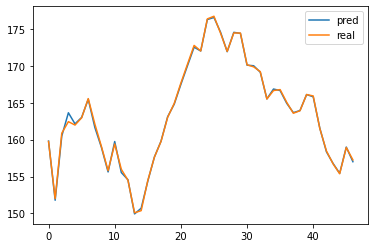

In [18]:
bmodel = TransformerTimeSeries(feature_dim = feature_dim,
                                  nhead = 4,num_layers = 12,d_model = 512,
                                  conv_len = 5,feature_weight = True,embedding_weight = True)
bmodel.load_state_dict(torch.load('AAPL_L'))
bmodel.to(device)
bmodel.eval()
with torch.no_grad(): # eliminate gradient i.e. gradients only exists in train()

    for step,(x,y,feature,attention_masks) in enumerate(test_dl):
        x = x.to(device)
        y = y.to(device)
        feature = feature.to(device)
        attention_masks = attention_masks.to(device)
        output = bmodel(x,y,feature,attention_masks[0])
        
        pred = data[train_size + 1 :-1,2]*0.01*(100+output[:,t0:].squeeze()).detach().cpu()
        ## note that test set starts at index train_size + 1 because idex train_size in rate_data 
        ## is the last day of first test data point, but rate_data only have the second til last data points
        ## of the dataset.
        real = data[train_size + 1 :-1,2]*0.01*(100+y[:,t0:].squeeze()).detach().cpu()

        plt.plot(pred)
        plt.plot(real)
        plt.legend(['pred','real'])
        MAE = torch.nn.L1Loss()(pred,real).item()
        MSE = torch.nn.MSELoss()(pred,real).item()
        RMSE = np.sqrt(MSE)
        
        print(f'AAPL MAE is {MAE}')
        print(f'AAPL MSE is {MSE}')
        print(f'AAPL RMSE is {RMSE}')

##### close

In [19]:
file_name = 'AAPL_features.csv'
with open(file_name) as f:
    data_list = csv.reader(f)
    data = []
    for row in data_list:
        data.append(row)
    f.close()
    
data = torch.tensor(np.delete(np.array(data)[1:,2:],4,axis = 1).astype(np.float)).type(torch.float)

feature_dim = data.shape[1] - 1
rate = []
for i in range(1,data.shape[0]):
    rate.append((100*(data[i,0:4] - data[i-1,0:4])/data[i-1,0:4]).reshape(1,4))
    
rate = torch.cat(rate)
rate_data = torch.cat([rate,data[1:,4:]],1)
train_size = int(data.shape[0]*0.9)
data_train = rate_data[0:train_size]
data_test = rate_data[train_size-4:]


t0 = 5
to_predict = 1
train_dataset = GetData(data_train[:,3],torch.cat([data_train[:,0:3],data_train[:,4:]],1),t0 = t0, to_predict = to_predict)
test_dataset = GetData(data_test[:,3],torch.cat([data_test[:,0:3],data_test[:,4:]],1),t0 = t0, to_predict = to_predict)
criterion = torch.nn.MSELoss()
# dataloaders
train_dl = DataLoader(train_dataset,batch_size=256,shuffle=True)
test_dl = DataLoader(test_dataset,batch_size=512)





model = TransformerTimeSeries(feature_dim = feature_dim,
                              nhead = 4,num_layers = 12,d_model = 512,
                              conv_len = 5,feature_weight = True,embedding_weight = True)
model = model.to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=1e-5 ,momentum = 0.9, nesterov = True)#Adam optimizer
#scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer,5e-7,3e-5,10,mode = 'exp_range',gamma = 0.9996)



train_epoch_loss = []
test_epoch_loss = []
test_best = 9999
for epoch in tqdm(range(4000)):


    l_t = train_epoch(model,train_dl,optimizer,t0,to_predict)

    train_loss = test_epoch(model,train_dl,t0,to_predict)


    test_loss = test_epoch(model,test_dl,t0,to_predict)


    if test_best > test_loss:
        test_best = test_loss
        torch.save(model.state_dict(), 'AAPL_C')



    train_epoch_loss.append(np.mean(train_loss))
    test_epoch_loss.append(test_loss)

    print("Epoch {}: Train loss: {} \t test loss: {}".format(epoch+1,
                                                             np.mean(train_loss),
                                                             test_loss))
    #scheduler.step()



torch.Size([431, 6])
torch.Size([431, 6])
torch.Size([47, 6])
torch.Size([47, 6])


  0%|                                                                                     | 0/4000 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1944: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
  0%|                                                                             | 1/4000 [00:00<23:13,  2.87it/s]

Epoch 1: Train loss: 1.5508094959635192 	 test loss: 1.7615537643432617


  0%|                                                                             | 2/4000 [00:01<43:25,  1.53it/s]

Epoch 2: Train loss: 1.4867128985663853 	 test loss: 1.7186723947525024


  0%|                                                                             | 4/4000 [00:02<34:24,  1.94it/s]

Epoch 3: Train loss: 1.4428251627703002 	 test loss: 1.6838579177856445
Epoch 4: Train loss: 1.4297267876202435 	 test loss: 1.6869336366653442


  0%|                                                                             | 6/4000 [00:02<19:46,  3.37it/s]

Epoch 5: Train loss: 1.4371090759534018 	 test loss: 1.696770429611206
Epoch 6: Train loss: 1.4531713914981852 	 test loss: 1.7105356454849243


  0%|▏                                                                            | 8/4000 [00:02<13:59,  4.75it/s]

Epoch 7: Train loss: 1.4651931576828392 	 test loss: 1.7206449508666992
Epoch 8: Train loss: 1.4694262098546924 	 test loss: 1.7238847017288208


  0%|▏                                                                           | 10/4000 [00:03<11:25,  5.82it/s]

Epoch 9: Train loss: 1.4650805723916074 	 test loss: 1.7204790115356445
Epoch 10: Train loss: 1.456066198526015 	 test loss: 1.7130051851272583


  0%|▏                                                                           | 12/4000 [00:03<10:14,  6.49it/s]

Epoch 11: Train loss: 1.4464402597077761 	 test loss: 1.704605221748352
Epoch 12: Train loss: 1.438476998125594 	 test loss: 1.698021411895752


  0%|▎                                                                           | 14/4000 [00:03<09:40,  6.87it/s]

Epoch 13: Train loss: 1.4333085197860294 	 test loss: 1.692253589630127
Epoch 14: Train loss: 1.4304274948456448 	 test loss: 1.6877492666244507


  0%|▎                                                                           | 16/4000 [00:03<09:23,  7.07it/s]

Epoch 15: Train loss: 1.4289498727448855 	 test loss: 1.6868162155151367
Epoch 16: Train loss: 1.4285843134479568 	 test loss: 1.686244010925293


  0%|▎                                                                           | 18/4000 [00:04<09:13,  7.20it/s]

Epoch 17: Train loss: 1.4284630906001043 	 test loss: 1.6859931945800781
Epoch 18: Train loss: 1.428413399964087 	 test loss: 1.685990333557129


  0%|▍                                                                           | 20/4000 [00:04<09:10,  7.23it/s]

Epoch 19: Train loss: 1.4285029510334306 	 test loss: 1.686234474182129
Epoch 20: Train loss: 1.429019354059082 	 test loss: 1.6865142583847046


  1%|▍                                                                           | 22/4000 [00:04<09:08,  7.25it/s]

Epoch 21: Train loss: 1.4296828046475651 	 test loss: 1.686729907989502
Epoch 22: Train loss: 1.4303510415858294 	 test loss: 1.6874947547912598


  1%|▍                                                                           | 24/4000 [00:04<09:07,  7.27it/s]

Epoch 23: Train loss: 1.4308982822015501 	 test loss: 1.6884645223617554
Epoch 24: Train loss: 1.4312505384608931 	 test loss: 1.6891167163848877


  1%|▍                                                                           | 26/4000 [00:05<09:05,  7.28it/s]

Epoch 25: Train loss: 1.4315261478490453 	 test loss: 1.6896010637283325
Epoch 26: Train loss: 1.4319315150276415 	 test loss: 1.6902669668197632


  1%|▌                                                                           | 28/4000 [00:05<09:04,  7.30it/s]

Epoch 27: Train loss: 1.4318703377053246 	 test loss: 1.6901806592941284
Epoch 28: Train loss: 1.4314417952451242 	 test loss: 1.6895116567611694


  1%|▌                                                                           | 30/4000 [00:05<09:03,  7.31it/s]

Epoch 29: Train loss: 1.431024323759942 	 test loss: 1.6888632774353027
Epoch 30: Train loss: 1.4304432639389746 	 test loss: 1.6878687143325806


  1%|▌                                                                           | 32/4000 [00:06<09:03,  7.30it/s]

Epoch 31: Train loss: 1.4296790491400628 	 test loss: 1.6865253448486328
Epoch 32: Train loss: 1.4291980999528393 	 test loss: 1.6859593391418457


  1%|▋                                                                           | 34/4000 [00:06<09:04,  7.29it/s]

Epoch 33: Train loss: 1.4290769523368358 	 test loss: 1.6857906579971313
Epoch 34: Train loss: 1.4289969446487605 	 test loss: 1.6856625080108643


  1%|▋                                                                           | 36/4000 [00:06<09:03,  7.30it/s]

Epoch 35: Train loss: 1.4291309477834857 	 test loss: 1.685789942741394
Epoch 36: Train loss: 1.429107895030223 	 test loss: 1.6857423782348633


  1%|▋                                                                           | 38/4000 [00:06<09:02,  7.30it/s]

Epoch 37: Train loss: 1.4290814377592225 	 test loss: 1.6856813430786133
Epoch 38: Train loss: 1.4289855965328881 	 test loss: 1.6855565309524536


  1%|▊                                                                           | 40/4000 [00:07<09:03,  7.29it/s]

Epoch 39: Train loss: 1.4288150370812471 	 test loss: 1.6853413581848145
Epoch 40: Train loss: 1.4287295626377008 	 test loss: 1.685236930847168


  1%|▊                                                                           | 42/4000 [00:07<09:03,  7.28it/s]

Epoch 41: Train loss: 1.4287005884188233 	 test loss: 1.6851773262023926
Epoch 42: Train loss: 1.4289992580281057 	 test loss: 1.6855807304382324


  1%|▊                                                                           | 44/4000 [00:07<09:05,  7.26it/s]

Epoch 43: Train loss: 1.4292203954090374 	 test loss: 1.6860244274139404
Epoch 44: Train loss: 1.4293558406719198 	 test loss: 1.686303973197937


  1%|▊                                                                           | 46/4000 [00:08<09:03,  7.27it/s]

Epoch 45: Train loss: 1.4292823043057648 	 test loss: 1.6861915588378906
Epoch 46: Train loss: 1.429135545223882 	 test loss: 1.685951828956604


  1%|▉                                                                           | 48/4000 [00:08<09:03,  7.27it/s]

Epoch 47: Train loss: 1.4288074046442514 	 test loss: 1.6853692531585693
Epoch 48: Train loss: 1.428345374054256 	 test loss: 1.6846168041229248


  1%|▉                                                                           | 49/4000 [00:08<09:02,  7.28it/s]

Epoch 49: Train loss: 1.4277710494198546 	 test loss: 1.6839381456375122


  1%|▉                                                                           | 50/4000 [00:09<23:46,  2.77it/s]

Epoch 50: Train loss: 1.4273432401935904 	 test loss: 1.6833726167678833


  1%|▉                                                                           | 51/4000 [00:10<34:12,  1.92it/s]

Epoch 51: Train loss: 1.4269060717934523 	 test loss: 1.682884693145752


  1%|▉                                                                           | 52/4000 [00:11<41:31,  1.58it/s]

Epoch 52: Train loss: 1.426645839573889 	 test loss: 1.6826878786087036


  1%|█                                                                           | 53/4000 [00:12<47:10,  1.39it/s]

Epoch 53: Train loss: 1.4264311618981949 	 test loss: 1.682504653930664


  1%|█                                                                           | 54/4000 [00:12<50:33,  1.30it/s]

Epoch 54: Train loss: 1.4263955432135103 	 test loss: 1.6823984384536743


  1%|█                                                                           | 56/4000 [00:13<39:47,  1.65it/s]

Epoch 55: Train loss: 1.4265604824035185 	 test loss: 1.6823813915252686
Epoch 56: Train loss: 1.4268219587144608 	 test loss: 1.6826415061950684


  1%|█                                                                           | 58/4000 [00:14<24:05,  2.73it/s]

Epoch 57: Train loss: 1.4269364378015292 	 test loss: 1.6827919483184814
Epoch 58: Train loss: 1.4271407290567102 	 test loss: 1.6830140352249146


  2%|█▏                                                                          | 60/4000 [00:14<16:24,  4.00it/s]

Epoch 59: Train loss: 1.4274971203018507 	 test loss: 1.6833884716033936
Epoch 60: Train loss: 1.4275608768042722 	 test loss: 1.6834839582443237


  2%|█▏                                                                          | 62/4000 [00:14<12:37,  5.20it/s]

Epoch 61: Train loss: 1.427666736589507 	 test loss: 1.683708667755127
Epoch 62: Train loss: 1.4278189159601304 	 test loss: 1.6840221881866455


  2%|█▏                                                                          | 64/4000 [00:15<10:48,  6.07it/s]

Epoch 63: Train loss: 1.427885113348817 	 test loss: 1.6841756105422974
Epoch 64: Train loss: 1.4277321161084275 	 test loss: 1.6839441061019897


  2%|█▎                                                                          | 66/4000 [00:15<09:52,  6.64it/s]

Epoch 65: Train loss: 1.4273604876480634 	 test loss: 1.6833125352859497
Epoch 66: Train loss: 1.4270395574326304 	 test loss: 1.6827632188796997


  2%|█▎                                                                          | 67/4000 [00:16<24:17,  2.70it/s]

Epoch 67: Train loss: 1.4267162842429708 	 test loss: 1.682334303855896


  2%|█▎                                                                          | 68/4000 [00:17<49:12,  1.33it/s]

Epoch 68: Train loss: 1.4261506867795974 	 test loss: 1.6816864013671875


  2%|█▎                                                                        | 69/4000 [00:23<2:35:40,  2.38s/it]

Epoch 69: Train loss: 1.425681746476211 	 test loss: 1.6810663938522339


  2%|█▎                                                                        | 70/4000 [00:31<4:09:19,  3.81s/it]

Epoch 70: Train loss: 1.4254812535996226 	 test loss: 1.6808198690414429


  2%|█▎                                                                        | 71/4000 [00:37<5:03:02,  4.63s/it]

Epoch 71: Train loss: 1.4254669766968198 	 test loss: 1.6808072328567505


  2%|█▎                                                                        | 73/4000 [00:44<3:58:09,  3.64s/it]

Epoch 72: Train loss: 1.4253727067650885 	 test loss: 1.6806838512420654
Epoch 73: Train loss: 1.4254805380672977 	 test loss: 1.6808218955993652


  2%|█▍                                                                        | 75/4000 [00:44<2:01:14,  1.85s/it]

Epoch 74: Train loss: 1.4255295809349715 	 test loss: 1.6808773279190063
Epoch 75: Train loss: 1.4255982629107764 	 test loss: 1.6809546947479248


  2%|█▍                                                                        | 76/4000 [00:44<1:27:31,  1.34s/it]

Epoch 76: Train loss: 1.4254387409670446 	 test loss: 1.680753469467163


  2%|█▍                                                                        | 77/4000 [00:50<3:06:21,  2.85s/it]

Epoch 77: Train loss: 1.4251943129674465 	 test loss: 1.6804370880126953


  2%|█▍                                                                        | 78/4000 [00:57<4:13:25,  3.88s/it]

Epoch 78: Train loss: 1.4248839857406794 	 test loss: 1.68003511428833


  2%|█▍                                                                        | 79/4000 [01:04<5:13:41,  4.80s/it]

Epoch 79: Train loss: 1.4244766514705118 	 test loss: 1.6795045137405396


  2%|█▍                                                                        | 80/4000 [01:10<5:47:20,  5.32s/it]

Epoch 80: Train loss: 1.4241900383181472 	 test loss: 1.6793192625045776


  2%|█▍                                                                        | 81/4000 [01:17<6:14:19,  5.73s/it]

Epoch 81: Train loss: 1.4240713443114421 	 test loss: 1.6792021989822388


  2%|█▌                                                                        | 82/4000 [01:23<6:31:09,  5.99s/it]

Epoch 82: Train loss: 1.4239903259719884 	 test loss: 1.6790964603424072


  2%|█▌                                                                        | 83/4000 [01:30<6:42:27,  6.16s/it]

Epoch 83: Train loss: 1.423933263997744 	 test loss: 1.6789947748184204


  2%|█▌                                                                        | 84/4000 [01:37<6:51:20,  6.30s/it]

Epoch 84: Train loss: 1.4239024629172483 	 test loss: 1.6788990497589111


  2%|█▌                                                                        | 85/4000 [01:43<6:57:00,  6.39s/it]

Epoch 85: Train loss: 1.4240640999269596 	 test loss: 1.6788955926895142


  2%|█▌                                                                        | 87/4000 [01:50<4:57:26,  4.56s/it]

Epoch 86: Train loss: 1.4240304735033251 	 test loss: 1.6788444519042969
Epoch 87: Train loss: 1.424098105275714 	 test loss: 1.6789215803146362


  2%|█▋                                                                        | 89/4000 [01:50<2:30:18,  2.31s/it]

Epoch 88: Train loss: 1.4241335552419145 	 test loss: 1.6789511442184448
Epoch 89: Train loss: 1.4243827679317678 	 test loss: 1.6792689561843872


  2%|█▋                                                                        | 91/4000 [01:51<1:18:15,  1.20s/it]

Epoch 90: Train loss: 1.424763953879372 	 test loss: 1.6796828508377075
Epoch 91: Train loss: 1.4252508447231107 	 test loss: 1.680324912071228


  2%|█▊                                                                          | 93/4000 [01:51<42:57,  1.52it/s]

Epoch 92: Train loss: 1.4258620288145238 	 test loss: 1.6813222169876099
Epoch 93: Train loss: 1.4260754585266113 	 test loss: 1.6816385984420776


  2%|█▊                                                                          | 95/4000 [01:51<25:38,  2.54it/s]

Epoch 94: Train loss: 1.4259416136000382 	 test loss: 1.6814442873001099
Epoch 95: Train loss: 1.4255263949214998 	 test loss: 1.6808464527130127


  2%|█▊                                                                          | 96/4000 [01:51<20:37,  3.15it/s]

Epoch 96: Train loss: 1.424877824473547 	 test loss: 1.6798129081726074


  2%|█▊                                                                        | 97/4000 [01:56<1:55:31,  1.78s/it]

Epoch 97: Train loss: 1.4241597085430562 	 test loss: 1.678838849067688


  2%|█▊                                                                        | 98/4000 [02:03<3:27:48,  3.20s/it]

Epoch 98: Train loss: 1.4236132824780492 	 test loss: 1.6781868934631348


  2%|█▊                                                                        | 99/4000 [02:10<4:42:48,  4.35s/it]

Epoch 99: Train loss: 1.4232031577147906 	 test loss: 1.6776340007781982


  2%|█▊                                                                       | 100/4000 [02:17<5:25:17,  5.00s/it]

Epoch 100: Train loss: 1.4227718125916413 	 test loss: 1.677086353302002


  3%|█▊                                                                       | 101/4000 [02:23<5:56:38,  5.49s/it]

Epoch 101: Train loss: 1.4225331979118754 	 test loss: 1.67689049243927


  3%|█▊                                                                       | 102/4000 [02:30<6:18:29,  5.83s/it]

Epoch 102: Train loss: 1.4225615984879072 	 test loss: 1.676825761795044


  3%|█▉                                                                       | 104/4000 [02:36<4:34:18,  4.22s/it]

Epoch 103: Train loss: 1.4225857725276194 	 test loss: 1.6767735481262207
Epoch 104: Train loss: 1.4227326566271328 	 test loss: 1.6769486665725708


  3%|█▉                                                                       | 106/4000 [02:37<2:18:53,  2.14s/it]

Epoch 105: Train loss: 1.4228120981402297 	 test loss: 1.6770421266555786
Epoch 106: Train loss: 1.4229164928405302 	 test loss: 1.6771700382232666


  3%|█▉                                                                       | 108/4000 [02:37<1:12:34,  1.12s/it]

Epoch 107: Train loss: 1.4228866327113177 	 test loss: 1.6771231889724731
Epoch 108: Train loss: 1.4228070340964192 	 test loss: 1.6770089864730835


  3%|██                                                                         | 110/4000 [02:37<40:05,  1.62it/s]

Epoch 109: Train loss: 1.4227047638660795 	 test loss: 1.6768710613250732
Epoch 110: Train loss: 1.4226421231183541 	 test loss: 1.676784873008728


  3%|██                                                                       | 111/4000 [02:43<2:27:26,  2.27s/it]

Epoch 111: Train loss: 1.4226282832240837 	 test loss: 1.676773190498352


  3%|██                                                                       | 112/4000 [02:49<3:42:16,  3.43s/it]

Epoch 112: Train loss: 1.422486815264496 	 test loss: 1.6765799522399902


  3%|██                                                                       | 113/4000 [02:56<4:49:55,  4.48s/it]

Epoch 113: Train loss: 1.4222894066171137 	 test loss: 1.6763207912445068


  3%|██                                                                       | 114/4000 [03:03<5:31:50,  5.12s/it]

Epoch 114: Train loss: 1.4221838994811693 	 test loss: 1.676165223121643


  3%|██                                                                       | 115/4000 [03:09<6:00:28,  5.57s/it]

Epoch 115: Train loss: 1.4219913338840422 	 test loss: 1.675903558731079


  3%|██                                                                       | 116/4000 [03:16<6:19:29,  5.86s/it]

Epoch 116: Train loss: 1.4217152642539925 	 test loss: 1.675528645515442


  3%|██▏                                                                      | 117/4000 [03:23<6:34:33,  6.10s/it]

Epoch 117: Train loss: 1.421543999227183 	 test loss: 1.6752877235412598


  3%|██▏                                                                      | 118/4000 [03:29<6:42:03,  6.21s/it]

Epoch 118: Train loss: 1.4214354250104688 	 test loss: 1.675131916999817


  3%|██▏                                                                      | 119/4000 [03:36<6:51:45,  6.37s/it]

Epoch 119: Train loss: 1.421281818170835 	 test loss: 1.6749175786972046


  3%|██▏                                                                      | 120/4000 [03:42<6:55:17,  6.42s/it]

Epoch 120: Train loss: 1.421155802611685 	 test loss: 1.6747452020645142


  3%|██▏                                                                      | 121/4000 [03:49<6:59:42,  6.49s/it]

Epoch 121: Train loss: 1.4210565416552905 	 test loss: 1.674591064453125


  3%|██▏                                                                      | 122/4000 [03:55<6:55:30,  6.43s/it]

Epoch 122: Train loss: 1.4209263156019065 	 test loss: 1.6743959188461304


  3%|██▏                                                                      | 123/4000 [04:02<7:04:35,  6.57s/it]

Epoch 123: Train loss: 1.4207659445340008 	 test loss: 1.674168348312378


  3%|██▎                                                                      | 124/4000 [04:09<7:04:21,  6.57s/it]

Epoch 124: Train loss: 1.4207000217968793 	 test loss: 1.674059510231018


  3%|██▎                                                                      | 125/4000 [04:15<7:06:07,  6.60s/it]

Epoch 125: Train loss: 1.4206180168691755 	 test loss: 1.673912525177002


  3%|██▎                                                                      | 126/4000 [04:22<7:06:18,  6.60s/it]

Epoch 126: Train loss: 1.4205308378157648 	 test loss: 1.6737751960754395


  3%|██▎                                                                      | 127/4000 [04:29<7:05:11,  6.59s/it]

Epoch 127: Train loss: 1.4203871267301025 	 test loss: 1.673628568649292


  3%|██▎                                                                      | 128/4000 [04:35<7:06:10,  6.60s/it]

Epoch 128: Train loss: 1.4202687021197964 	 test loss: 1.6734830141067505


  3%|██▎                                                                      | 130/4000 [04:42<5:00:49,  4.66s/it]

Epoch 129: Train loss: 1.420258589521085 	 test loss: 1.6733933687210083
Epoch 130: Train loss: 1.4203684352113586 	 test loss: 1.6735730171203613


  3%|██▍                                                                      | 132/4000 [04:42<2:31:55,  2.36s/it]

Epoch 131: Train loss: 1.420531949145058 	 test loss: 1.6737749576568604
Epoch 132: Train loss: 1.4207448992541107 	 test loss: 1.6740436553955078


  3%|██▍                                                                      | 134/4000 [04:43<1:18:53,  1.22s/it]

Epoch 133: Train loss: 1.4208263404961252 	 test loss: 1.6741387844085693
Epoch 134: Train loss: 1.4207494253348862 	 test loss: 1.6740267276763916


  3%|██▌                                                                        | 136/4000 [04:43<43:08,  1.49it/s]

Epoch 135: Train loss: 1.4206547297347172 	 test loss: 1.6738865375518799
Epoch 136: Train loss: 1.4206200970851075 	 test loss: 1.673832893371582


  3%|██▌                                                                        | 138/4000 [04:43<25:37,  2.51it/s]

Epoch 137: Train loss: 1.4205815866762415 	 test loss: 1.67376708984375
Epoch 138: Train loss: 1.420511400893227 	 test loss: 1.6736335754394531


  3%|██▌                                                                        | 139/4000 [04:43<20:35,  3.13it/s]

Epoch 139: Train loss: 1.420368561611928 	 test loss: 1.6734287738800049


  4%|██▌                                                                      | 140/4000 [04:48<1:49:08,  1.70s/it]

Epoch 140: Train loss: 1.420159081018718 	 test loss: 1.6731563806533813


  4%|██▌                                                                      | 141/4000 [04:55<3:24:04,  3.17s/it]

Epoch 141: Train loss: 1.419880222555103 	 test loss: 1.672778606414795


  4%|██▌                                                                      | 142/4000 [05:01<4:30:11,  4.20s/it]

Epoch 142: Train loss: 1.4195374078927627 	 test loss: 1.6723198890686035


  4%|██▌                                                                      | 143/4000 [05:08<5:22:27,  5.02s/it]

Epoch 143: Train loss: 1.4191704761677717 	 test loss: 1.6717559099197388


  4%|██▋                                                                      | 144/4000 [05:15<5:55:51,  5.54s/it]

Epoch 144: Train loss: 1.4188922494304153 	 test loss: 1.6715362071990967


  4%|██▋                                                                      | 145/4000 [05:22<6:14:05,  5.82s/it]

Epoch 145: Train loss: 1.41871723525762 	 test loss: 1.6713603734970093


  4%|██▋                                                                      | 146/4000 [05:28<6:28:50,  6.05s/it]

Epoch 146: Train loss: 1.4185688064159208 	 test loss: 1.6711881160736084


  4%|██▋                                                                      | 147/4000 [05:35<6:38:54,  6.21s/it]

Epoch 147: Train loss: 1.418556673344216 	 test loss: 1.6711058616638184


  4%|██▋                                                                      | 148/4000 [05:41<6:46:43,  6.34s/it]

Epoch 148: Train loss: 1.418469591926256 	 test loss: 1.670965552330017


  4%|██▋                                                                      | 149/4000 [05:48<6:51:59,  6.42s/it]

Epoch 149: Train loss: 1.4183888922158083 	 test loss: 1.670835256576538


  4%|██▋                                                                      | 150/4000 [05:55<6:55:15,  6.47s/it]

Epoch 150: Train loss: 1.4183559265601386 	 test loss: 1.6707310676574707


  4%|██▊                                                                      | 151/4000 [06:01<6:57:39,  6.51s/it]

Epoch 151: Train loss: 1.4182793629418393 	 test loss: 1.6706010103225708


  4%|██▊                                                                      | 152/4000 [06:08<6:59:30,  6.54s/it]

Epoch 152: Train loss: 1.4183205288690093 	 test loss: 1.6705214977264404


  4%|██▊                                                                      | 153/4000 [06:14<7:00:11,  6.55s/it]

Epoch 153: Train loss: 1.4183395431655743 	 test loss: 1.6704914569854736


  4%|██▊                                                                      | 154/4000 [06:21<6:55:04,  6.48s/it]

Epoch 154: Train loss: 1.4182936860347846 	 test loss: 1.6704213619232178


  4%|██▊                                                                      | 155/4000 [06:27<6:54:57,  6.48s/it]

Epoch 155: Train loss: 1.4182347012229972 	 test loss: 1.6703383922576904


  4%|██▊                                                                      | 156/4000 [06:34<7:04:28,  6.63s/it]

Epoch 156: Train loss: 1.4181421320289027 	 test loss: 1.6702097654342651


  4%|██▉                                                                      | 158/4000 [06:41<5:04:25,  4.75s/it]

Epoch 157: Train loss: 1.4180734492233347 	 test loss: 1.6701143980026245
Epoch 158: Train loss: 1.4180805295913237 	 test loss: 1.6701445579528809


  4%|██▉                                                                      | 160/4000 [06:42<2:33:34,  2.40s/it]

Epoch 159: Train loss: 1.4181732279518642 	 test loss: 1.670263409614563
Epoch 160: Train loss: 1.4183725395224764 	 test loss: 1.670477271080017


  4%|██▉                                                                      | 162/4000 [06:42<1:19:40,  1.25s/it]

Epoch 161: Train loss: 1.4185947619568722 	 test loss: 1.670707106590271
Epoch 162: Train loss: 1.4184715426991545 	 test loss: 1.670519232749939


  4%|███                                                                        | 164/4000 [06:42<43:27,  1.47it/s]

Epoch 163: Train loss: 1.4185804615441164 	 test loss: 1.670574426651001
Epoch 164: Train loss: 1.418722820945793 	 test loss: 1.6706750392913818


  4%|███                                                                        | 166/4000 [06:42<25:44,  2.48it/s]

Epoch 165: Train loss: 1.4187347197477336 	 test loss: 1.670634150505066
Epoch 166: Train loss: 1.4188582872293387 	 test loss: 1.6706929206848145


  4%|███▏                                                                       | 167/4000 [06:42<20:38,  3.10it/s]

Epoch 167: Train loss: 1.4185242016741406 	 test loss: 1.6703245639801025


  4%|███                                                                      | 168/4000 [06:47<1:42:19,  1.60s/it]

Epoch 168: Train loss: 1.41815822196394 	 test loss: 1.669908881187439


  4%|███                                                                      | 169/4000 [06:54<3:30:44,  3.30s/it]

Epoch 169: Train loss: 1.4180690976693846 	 test loss: 1.6697672605514526


  4%|███                                                                      | 170/4000 [07:01<4:33:18,  4.28s/it]

Epoch 170: Train loss: 1.417859921599209 	 test loss: 1.6695091724395752


  4%|███                                                                      | 171/4000 [07:07<5:15:16,  4.94s/it]

Epoch 171: Train loss: 1.4173462982797291 	 test loss: 1.6689112186431885


  4%|███▏                                                                     | 172/4000 [07:14<5:43:56,  5.39s/it]

Epoch 172: Train loss: 1.4167614879298376 	 test loss: 1.668126106262207


  4%|███▏                                                                     | 173/4000 [07:21<6:13:14,  5.85s/it]

Epoch 173: Train loss: 1.4164660339289088 	 test loss: 1.6676579713821411


  4%|███▏                                                                     | 174/4000 [07:27<6:27:36,  6.08s/it]

Epoch 174: Train loss: 1.4162078562026235 	 test loss: 1.667253851890564


  4%|███▏                                                                     | 176/4000 [07:33<4:32:14,  4.27s/it]

Epoch 175: Train loss: 1.4161494154388004 	 test loss: 1.667163372039795
Epoch 176: Train loss: 1.4161632522906062 	 test loss: 1.6671884059906006


  4%|███▏                                                                     | 178/4000 [07:34<2:17:46,  2.16s/it]

Epoch 177: Train loss: 1.4162879938869077 	 test loss: 1.6673868894577026
Epoch 178: Train loss: 1.4164659310382923 	 test loss: 1.6675931215286255


  4%|███▎                                                                     | 180/4000 [07:34<1:11:54,  1.13s/it]

Epoch 179: Train loss: 1.4167709541431437 	 test loss: 1.667908787727356
Epoch 180: Train loss: 1.416946925585895 	 test loss: 1.668048620223999


  5%|███▍                                                                       | 182/4000 [07:34<39:40,  1.60it/s]

Epoch 181: Train loss: 1.4169296114737915 	 test loss: 1.667990803718567
Epoch 182: Train loss: 1.4165210521967948 	 test loss: 1.6675398349761963


  5%|███▍                                                                       | 183/4000 [07:34<30:22,  2.09it/s]

Epoch 183: Train loss: 1.4163412973111853 	 test loss: 1.667296290397644


  5%|███▎                                                                     | 184/4000 [07:40<2:05:57,  1.98s/it]

Epoch 184: Train loss: 1.4159840597077478 	 test loss: 1.6668351888656616


  5%|███▍                                                                     | 185/4000 [07:47<3:46:12,  3.56s/it]

Epoch 185: Train loss: 1.415708147732675 	 test loss: 1.6664865016937256


  5%|███▍                                                                     | 186/4000 [07:53<4:38:40,  4.38s/it]

Epoch 186: Train loss: 1.415392957264752 	 test loss: 1.6660598516464233


  5%|███▍                                                                     | 187/4000 [08:00<5:13:37,  4.94s/it]

Epoch 187: Train loss: 1.4151187156026712 	 test loss: 1.6656657457351685


  5%|███▍                                                                     | 189/4000 [08:07<4:09:34,  3.93s/it]

Epoch 188: Train loss: 1.414942207579823 	 test loss: 1.6654045581817627
Epoch 189: Train loss: 1.415015110283606 	 test loss: 1.6654902696609497


  5%|███▍                                                                     | 191/4000 [08:07<2:06:44,  2.00s/it]

Epoch 190: Train loss: 1.4150364332575256 	 test loss: 1.6654884815216064
Epoch 191: Train loss: 1.4150630102909911 	 test loss: 1.6655068397521973


  5%|███▌                                                                     | 192/4000 [08:14<3:32:35,  3.35s/it]

Epoch 192: Train loss: 1.41492485170298 	 test loss: 1.6653066873550415


  5%|███▌                                                                     | 193/4000 [08:20<4:33:42,  4.31s/it]

Epoch 193: Train loss: 1.4148590780466173 	 test loss: 1.6652053594589233


  5%|███▌                                                                     | 195/4000 [08:27<3:44:29,  3.54s/it]

Epoch 194: Train loss: 1.4148075190608296 	 test loss: 1.665146827697754
Epoch 195: Train loss: 1.4149284437471643 	 test loss: 1.6652424335479736


  5%|███▌                                                                     | 196/4000 [08:33<4:41:03,  4.43s/it]

Epoch 196: Train loss: 1.4147656254314769 	 test loss: 1.665000081062317


  5%|███▌                                                                     | 197/4000 [08:40<5:21:50,  5.08s/it]

Epoch 197: Train loss: 1.4148025949703844 	 test loss: 1.6649821996688843


  5%|███▌                                                                     | 198/4000 [08:46<5:39:04,  5.35s/it]

Epoch 198: Train loss: 1.4144545364822423 	 test loss: 1.66457200050354


  5%|███▋                                                                     | 199/4000 [08:53<6:15:26,  5.93s/it]

Epoch 199: Train loss: 1.4142817258834839 	 test loss: 1.664318561553955


  5%|███▋                                                                     | 200/4000 [09:00<6:25:38,  6.09s/it]

Epoch 200: Train loss: 1.4140114397017973 	 test loss: 1.6639275550842285


  5%|███▋                                                                     | 201/4000 [09:06<6:37:42,  6.28s/it]

Epoch 201: Train loss: 1.4137629464164965 	 test loss: 1.6635777950286865


  5%|███▋                                                                     | 202/4000 [09:13<6:43:53,  6.38s/it]

Epoch 202: Train loss: 1.4134422383009695 	 test loss: 1.6631505489349365


  5%|███▋                                                                     | 203/4000 [09:20<6:48:10,  6.45s/it]

Epoch 203: Train loss: 1.4130458024151087 	 test loss: 1.6625701189041138


  5%|███▋                                                                     | 204/4000 [09:26<6:38:08,  6.29s/it]

Epoch 204: Train loss: 1.4128283807130535 	 test loss: 1.6622443199157715


  5%|███▋                                                                     | 205/4000 [09:33<6:56:48,  6.59s/it]

Epoch 205: Train loss: 1.4126277199477442 	 test loss: 1.661942481994629


  5%|███▊                                                                     | 206/4000 [09:39<6:56:32,  6.59s/it]

Epoch 206: Train loss: 1.4125072004623591 	 test loss: 1.6617523431777954


  5%|███▊                                                                     | 207/4000 [09:46<6:56:53,  6.59s/it]

Epoch 207: Train loss: 1.412334881083318 	 test loss: 1.6614959239959717


  5%|███▊                                                                     | 208/4000 [09:53<6:56:55,  6.60s/it]

Epoch 208: Train loss: 1.4121126802227613 	 test loss: 1.6611665487289429


  5%|███▊                                                                     | 209/4000 [09:59<6:50:24,  6.50s/it]

Epoch 209: Train loss: 1.411833363176775 	 test loss: 1.6607272624969482


  5%|███▊                                                                     | 210/4000 [10:06<6:58:06,  6.62s/it]

Epoch 210: Train loss: 1.4115559803084265 	 test loss: 1.6603273153305054


  5%|███▊                                                                     | 211/4000 [10:12<6:58:19,  6.62s/it]

Epoch 211: Train loss: 1.4113237489956991 	 test loss: 1.6600468158721924


  5%|███▊                                                                     | 212/4000 [10:19<6:51:33,  6.52s/it]

Epoch 212: Train loss: 1.411312775932719 	 test loss: 1.6599153280258179


  5%|███▉                                                                     | 214/4000 [10:26<4:56:27,  4.70s/it]

Epoch 213: Train loss: 1.411215350135573 	 test loss: 1.6597331762313843
Epoch 214: Train loss: 1.4113342526893882 	 test loss: 1.6598992347717285


  5%|███▉                                                                     | 216/4000 [10:26<2:29:39,  2.37s/it]

Epoch 215: Train loss: 1.4114900033601199 	 test loss: 1.6600863933563232
Epoch 216: Train loss: 1.4114678976430695 	 test loss: 1.6600265502929688


  5%|███▉                                                                     | 218/4000 [10:26<1:17:41,  1.23s/it]

Epoch 217: Train loss: 1.4115581581598091 	 test loss: 1.6601386070251465
Epoch 218: Train loss: 1.4116587085679624 	 test loss: 1.6601927280426025


  6%|████▏                                                                      | 220/4000 [10:27<42:27,  1.48it/s]

Epoch 219: Train loss: 1.4116230608415714 	 test loss: 1.6601152420043945
Epoch 220: Train loss: 1.4113877320234294 	 test loss: 1.6598052978515625


  6%|████                                                                     | 221/4000 [10:32<2:15:19,  2.15s/it]

Epoch 221: Train loss: 1.4108280759399838 	 test loss: 1.6590514183044434


  6%|████                                                                     | 222/4000 [10:39<3:39:17,  3.48s/it]

Epoch 222: Train loss: 1.4100781596177139 	 test loss: 1.657939076423645


  6%|████                                                                     | 223/4000 [10:46<4:39:36,  4.44s/it]

Epoch 223: Train loss: 1.4095147571541593 	 test loss: 1.6573859453201294


  6%|████                                                                     | 224/4000 [10:52<5:18:59,  5.07s/it]

Epoch 224: Train loss: 1.4093475596257539 	 test loss: 1.6571427583694458


  6%|████                                                                     | 226/4000 [10:59<4:07:10,  3.93s/it]

Epoch 225: Train loss: 1.4092742052542915 	 test loss: 1.6569613218307495
Epoch 226: Train loss: 1.409492146664595 	 test loss: 1.6570223569869995


  6%|████▏                                                                    | 228/4000 [10:59<2:05:28,  2.00s/it]

Epoch 227: Train loss: 1.4097595743126217 	 test loss: 1.6574219465255737
Epoch 228: Train loss: 1.409856870666734 	 test loss: 1.6575148105621338


  6%|████▏                                                                    | 229/4000 [11:06<3:29:36,  3.34s/it]

Epoch 229: Train loss: 1.409441501524498 	 test loss: 1.656939148902893


  6%|████▏                                                                    | 230/4000 [11:12<4:24:41,  4.21s/it]

Epoch 230: Train loss: 1.40918150938304 	 test loss: 1.6565567255020142


  6%|████▏                                                                    | 231/4000 [11:19<5:14:34,  5.01s/it]

Epoch 231: Train loss: 1.4088941806983506 	 test loss: 1.6561181545257568


  6%|████▏                                                                    | 232/4000 [11:25<5:45:55,  5.51s/it]

Epoch 232: Train loss: 1.4087444850850825 	 test loss: 1.655896544456482


  6%|████▎                                                                    | 233/4000 [11:32<6:06:49,  5.84s/it]

Epoch 233: Train loss: 1.4086537120513738 	 test loss: 1.655771255493164


  6%|████▎                                                                    | 234/4000 [11:39<6:19:25,  6.05s/it]

Epoch 234: Train loss: 1.4084723244686967 	 test loss: 1.6555055379867554


  6%|████▎                                                                    | 235/4000 [11:45<6:31:26,  6.24s/it]

Epoch 235: Train loss: 1.408125490987384 	 test loss: 1.654966950416565


  6%|████▎                                                                    | 236/4000 [11:52<6:37:39,  6.34s/it]

Epoch 236: Train loss: 1.4078727877610244 	 test loss: 1.6545761823654175


  6%|████▎                                                                    | 238/4000 [11:59<4:43:57,  4.53s/it]

Epoch 237: Train loss: 1.4078319711640928 	 test loss: 1.6545227766036987
Epoch 238: Train loss: 1.4078745800491828 	 test loss: 1.6545740365982056


  6%|████▎                                                                    | 239/4000 [12:05<5:21:24,  5.13s/it]

Epoch 239: Train loss: 1.4076966705565663 	 test loss: 1.6542924642562866


  6%|████▍                                                                    | 240/4000 [12:12<5:49:02,  5.57s/it]

Epoch 240: Train loss: 1.4076021915245498 	 test loss: 1.654113531112671


  6%|████▍                                                                    | 241/4000 [12:18<6:07:59,  5.87s/it]

Epoch 241: Train loss: 1.4073503172314636 	 test loss: 1.6537342071533203


  6%|████▍                                                                    | 242/4000 [12:25<6:21:47,  6.10s/it]

Epoch 242: Train loss: 1.4071306095322433 	 test loss: 1.653382420539856


  6%|████▍                                                                    | 243/4000 [12:31<6:31:00,  6.24s/it]

Epoch 243: Train loss: 1.406777584635741 	 test loss: 1.6528587341308594


  6%|████▍                                                                    | 244/4000 [12:38<6:37:49,  6.35s/it]

Epoch 244: Train loss: 1.4066419753563653 	 test loss: 1.6526468992233276


  6%|████▍                                                                    | 245/4000 [12:45<6:41:56,  6.42s/it]

Epoch 245: Train loss: 1.4064432094932433 	 test loss: 1.6523268222808838


  6%|████▍                                                                    | 246/4000 [12:51<6:46:26,  6.50s/it]

Epoch 246: Train loss: 1.406305245622958 	 test loss: 1.6520925760269165


  6%|████▌                                                                    | 248/4000 [12:58<4:48:27,  4.61s/it]

Epoch 247: Train loss: 1.4061306302895955 	 test loss: 1.651824951171875
Epoch 248: Train loss: 1.4061546588441889 	 test loss: 1.6518381834030151


  6%|████▌                                                                    | 250/4000 [12:58<2:25:40,  2.33s/it]

Epoch 249: Train loss: 1.4061892558139881 	 test loss: 1.6518622636795044
Epoch 250: Train loss: 1.4065497070896653 	 test loss: 1.6521872282028198


  6%|████▌                                                                    | 252/4000 [12:59<1:15:42,  1.21s/it]

Epoch 251: Train loss: 1.4070790483337543 	 test loss: 1.6525822877883911
Epoch 252: Train loss: 1.4070299313405827 	 test loss: 1.6523771286010742


  6%|████▋                                                                      | 253/4000 [12:59<55:33,  1.12it/s]

Epoch 253: Train loss: 1.4067332905019243 	 test loss: 1.651999592781067


  6%|████▋                                                                    | 254/4000 [13:04<2:14:07,  2.15s/it]

Epoch 254: Train loss: 1.4058971164398015 	 test loss: 1.6510957479476929


  6%|████▋                                                                    | 255/4000 [13:11<3:49:55,  3.68s/it]

Epoch 255: Train loss: 1.405277232836128 	 test loss: 1.6503145694732666


  6%|████▋                                                                    | 256/4000 [13:18<4:44:29,  4.56s/it]

Epoch 256: Train loss: 1.4046699370143032 	 test loss: 1.6494864225387573


  6%|████▋                                                                    | 257/4000 [13:24<5:17:03,  5.08s/it]

Epoch 257: Train loss: 1.4044417231376098 	 test loss: 1.6491354703903198


  6%|████▋                                                                    | 259/4000 [13:31<4:04:27,  3.92s/it]

Epoch 258: Train loss: 1.4042013894654206 	 test loss: 1.6487536430358887
Epoch 259: Train loss: 1.4042778803411604 	 test loss: 1.6487782001495361


  6%|████▋                                                                    | 260/4000 [13:38<4:58:16,  4.79s/it]

Epoch 260: Train loss: 1.404194853698571 	 test loss: 1.648575782775879


  7%|████▊                                                                    | 261/4000 [13:44<5:32:22,  5.33s/it]

Epoch 261: Train loss: 1.4040433342661494 	 test loss: 1.648329496383667


  7%|████▊                                                                    | 262/4000 [13:51<5:55:16,  5.70s/it]

Epoch 262: Train loss: 1.4039698244524113 	 test loss: 1.648150086402893


  7%|████▊                                                                    | 263/4000 [13:57<6:12:42,  5.98s/it]

Epoch 263: Train loss: 1.4037284206624927 	 test loss: 1.647751808166504


  7%|████▊                                                                    | 265/4000 [14:04<4:31:25,  4.36s/it]

Epoch 264: Train loss: 1.4037084632019432 	 test loss: 1.6476666927337646
Epoch 265: Train loss: 1.4037981238000077 	 test loss: 1.6476706266403198


  7%|████▊                                                                    | 266/4000 [14:04<3:12:31,  3.09s/it]

Epoch 266: Train loss: 1.4042570668417451 	 test loss: 1.6479250192642212


  7%|████▊                                                                    | 267/4000 [14:10<4:05:25,  3.94s/it]

Epoch 267: Train loss: 1.404042133322448 	 test loss: 1.6475589275360107


  7%|████▉                                                                    | 268/4000 [14:17<5:02:07,  4.86s/it]

Epoch 268: Train loss: 1.4035625222664145 	 test loss: 1.6470013856887817


  7%|████▉                                                                    | 269/4000 [14:24<5:34:16,  5.38s/it]

Epoch 269: Train loss: 1.4027613039083104 	 test loss: 1.6460658311843872


  7%|████▉                                                                    | 270/4000 [14:30<5:57:27,  5.75s/it]

Epoch 270: Train loss: 1.401742127544642 	 test loss: 1.6447840929031372


  7%|████▉                                                                    | 271/4000 [14:37<6:12:34,  5.99s/it]

Epoch 271: Train loss: 1.400932768104801 	 test loss: 1.6438833475112915


  7%|████▉                                                                    | 272/4000 [14:44<6:24:32,  6.19s/it]

Epoch 272: Train loss: 1.4005463123321533 	 test loss: 1.6434681415557861


  7%|████▉                                                                    | 273/4000 [14:50<6:32:01,  6.31s/it]

Epoch 273: Train loss: 1.4005230894774683 	 test loss: 1.6432921886444092


  7%|█████                                                                    | 274/4000 [14:57<6:38:05,  6.41s/it]

Epoch 274: Train loss: 1.4004879169287094 	 test loss: 1.6430180072784424


  7%|█████                                                                    | 276/4000 [15:04<4:43:49,  4.57s/it]

Epoch 275: Train loss: 1.400525699358805 	 test loss: 1.6428645849227905
Epoch 276: Train loss: 1.4007013330880007 	 test loss: 1.6429696083068848


  7%|█████                                                                    | 277/4000 [15:04<3:21:19,  3.24s/it]

Epoch 277: Train loss: 1.400782621377029 	 test loss: 1.6429835557937622


  7%|█████                                                                    | 278/4000 [15:09<4:05:56,  3.96s/it]

Epoch 278: Train loss: 1.4007753999493238 	 test loss: 1.6428601741790771


  7%|█████                                                                    | 279/4000 [15:17<5:07:17,  4.95s/it]

Epoch 279: Train loss: 1.4005375469920254 	 test loss: 1.6424847841262817


  7%|█████▏                                                                   | 281/4000 [15:23<3:58:23,  3.85s/it]

Epoch 280: Train loss: 1.4005660988615174 	 test loss: 1.6424041986465454
Epoch 281: Train loss: 1.4008356778085094 	 test loss: 1.6425517797470093


  7%|█████▏                                                                   | 283/4000 [15:24<2:01:05,  1.95s/it]

Epoch 282: Train loss: 1.4009696259022866 	 test loss: 1.6425405740737915
Epoch 283: Train loss: 1.4010569559725696 	 test loss: 1.6424288749694824


  7%|█████▏                                                                   | 284/4000 [15:29<3:07:33,  3.03s/it]

Epoch 284: Train loss: 1.4011485861514947 	 test loss: 1.6423068046569824


  7%|█████▏                                                                   | 285/4000 [15:36<4:22:06,  4.23s/it]

Epoch 285: Train loss: 1.4009078635970291 	 test loss: 1.641928791999817


  7%|█████▏                                                                   | 286/4000 [15:43<5:15:49,  5.10s/it]

Epoch 286: Train loss: 1.4004687718061726 	 test loss: 1.6414190530776978


  7%|█████▏                                                                   | 287/4000 [15:50<5:43:16,  5.55s/it]

Epoch 287: Train loss: 1.3998603970158128 	 test loss: 1.6407452821731567


  7%|█████▎                                                                   | 288/4000 [15:56<5:57:23,  5.78s/it]

Epoch 288: Train loss: 1.3988785411808164 	 test loss: 1.6396417617797852


  7%|█████▎                                                                   | 289/4000 [16:03<6:18:01,  6.11s/it]

Epoch 289: Train loss: 1.3981755769999564 	 test loss: 1.6387802362442017


  7%|█████▎                                                                   | 290/4000 [16:10<6:27:58,  6.27s/it]

Epoch 290: Train loss: 1.3980302174517285 	 test loss: 1.6385024785995483


  7%|█████▎                                                                   | 291/4000 [16:16<6:33:24,  6.36s/it]

Epoch 291: Train loss: 1.3976318036873767 	 test loss: 1.6379235982894897


  7%|█████▎                                                                   | 292/4000 [16:23<6:37:06,  6.43s/it]

Epoch 292: Train loss: 1.397097495481752 	 test loss: 1.637218952178955


  7%|█████▎                                                                   | 293/4000 [16:30<6:40:43,  6.49s/it]

Epoch 293: Train loss: 1.3966657855394544 	 test loss: 1.6365842819213867


  7%|█████▎                                                                   | 294/4000 [16:36<6:43:08,  6.53s/it]

Epoch 294: Train loss: 1.396191675535764 	 test loss: 1.6358940601348877


  7%|█████▍                                                                   | 295/4000 [16:43<6:44:37,  6.55s/it]

Epoch 295: Train loss: 1.39560872911024 	 test loss: 1.635270595550537


  7%|█████▍                                                                   | 296/4000 [16:49<6:33:10,  6.37s/it]

Epoch 296: Train loss: 1.3951525519452903 	 test loss: 1.6347955465316772


  7%|█████▍                                                                   | 297/4000 [16:56<6:46:36,  6.59s/it]

Epoch 297: Train loss: 1.39494227422639 	 test loss: 1.6343729496002197


  7%|█████▍                                                                   | 298/4000 [17:03<6:50:11,  6.65s/it]

Epoch 298: Train loss: 1.3948873325732911 	 test loss: 1.6340385675430298


  8%|█████▍                                                                   | 300/4000 [17:09<4:46:35,  4.65s/it]

Epoch 299: Train loss: 1.3950870263880755 	 test loss: 1.6339422464370728
Epoch 300: Train loss: 1.3953137793286494 	 test loss: 1.634089469909668


  8%|█████▍                                                                   | 301/4000 [17:09<3:23:07,  3.29s/it]

Epoch 301: Train loss: 1.3953628805563234 	 test loss: 1.6339633464813232


  8%|█████▌                                                                   | 302/4000 [17:16<4:22:08,  4.25s/it]

Epoch 302: Train loss: 1.3953023247265208 	 test loss: 1.6337271928787231


  8%|█████▌                                                                   | 303/4000 [17:22<5:04:43,  4.95s/it]

Epoch 303: Train loss: 1.3950910902908396 	 test loss: 1.6333378553390503


  8%|█████▌                                                                   | 304/4000 [17:29<5:35:40,  5.45s/it]

Epoch 304: Train loss: 1.3947910429983295 	 test loss: 1.632868766784668


  8%|█████▌                                                                   | 305/4000 [17:36<5:56:29,  5.79s/it]

Epoch 305: Train loss: 1.3939288539289045 	 test loss: 1.6317421197891235


  8%|█████▌                                                                   | 306/4000 [17:42<6:12:22,  6.05s/it]

Epoch 306: Train loss: 1.3935554799236998 	 test loss: 1.6311630010604858


  8%|█████▌                                                                   | 307/4000 [17:49<6:22:30,  6.21s/it]

Epoch 307: Train loss: 1.3932195755279257 	 test loss: 1.6306558847427368


  8%|█████▌                                                                   | 308/4000 [17:56<6:32:29,  6.38s/it]

Epoch 308: Train loss: 1.3925591510852362 	 test loss: 1.629723310470581


  8%|█████▋                                                                   | 309/4000 [18:02<6:35:22,  6.43s/it]

Epoch 309: Train loss: 1.392392879019204 	 test loss: 1.629374623298645


  8%|█████▋                                                                   | 310/4000 [18:09<6:36:34,  6.45s/it]

Epoch 310: Train loss: 1.3922498054681411 	 test loss: 1.629051923751831


  8%|█████▋                                                                   | 311/4000 [18:15<6:27:12,  6.30s/it]

Epoch 311: Train loss: 1.3919353615103631 	 test loss: 1.6285622119903564


  8%|█████▋                                                                   | 312/4000 [18:21<6:32:44,  6.39s/it]

Epoch 312: Train loss: 1.3918917187405297 	 test loss: 1.6283468008041382


  8%|█████▋                                                                   | 313/4000 [18:28<6:48:51,  6.65s/it]

Epoch 313: Train loss: 1.3917650642638417 	 test loss: 1.628014087677002


  8%|█████▋                                                                   | 315/4000 [18:35<4:47:50,  4.69s/it]

Epoch 314: Train loss: 1.391825782174024 	 test loss: 1.6279007196426392
Epoch 315: Train loss: 1.3920373886201332 	 test loss: 1.6279182434082031


  8%|█████▊                                                                   | 316/4000 [18:42<5:20:26,  5.22s/it]

Epoch 316: Train loss: 1.3918143344865874 	 test loss: 1.6274627447128296


  8%|█████▊                                                                   | 317/4000 [18:48<5:45:15,  5.62s/it]

Epoch 317: Train loss: 1.391165550236359 	 test loss: 1.6265538930892944


  8%|█████▊                                                                   | 318/4000 [18:54<5:51:42,  5.73s/it]

Epoch 318: Train loss: 1.3906384313742688 	 test loss: 1.625799536705017


  8%|█████▊                                                                   | 319/4000 [19:01<6:18:57,  6.18s/it]

Epoch 319: Train loss: 1.3898305248495044 	 test loss: 1.624732255935669


  8%|█████▊                                                                   | 320/4000 [19:08<6:27:39,  6.32s/it]

Epoch 320: Train loss: 1.388868662431456 	 test loss: 1.6234822273254395


  8%|█████▊                                                                   | 321/4000 [19:15<6:32:31,  6.40s/it]

Epoch 321: Train loss: 1.387969148407956 	 test loss: 1.622324824333191


  8%|█████▉                                                                   | 322/4000 [19:21<6:36:06,  6.46s/it]

Epoch 322: Train loss: 1.3873454667022775 	 test loss: 1.6216212511062622


  8%|█████▉                                                                   | 323/4000 [19:28<6:38:49,  6.51s/it]

Epoch 323: Train loss: 1.3868129253387451 	 test loss: 1.6208031177520752


  8%|█████▉                                                                   | 325/4000 [19:35<4:42:48,  4.62s/it]

Epoch 324: Train loss: 1.386772419073189 	 test loss: 1.6202605962753296
Epoch 325: Train loss: 1.3870797657911296 	 test loss: 1.6203116178512573


  8%|█████▉                                                                   | 327/4000 [19:35<2:22:47,  2.33s/it]

Epoch 326: Train loss: 1.3874096953398667 	 test loss: 1.6204458475112915
Epoch 327: Train loss: 1.3877120322251817 	 test loss: 1.6205527782440186


  8%|█████▉                                                                   | 328/4000 [19:41<3:27:27,  3.39s/it]

Epoch 328: Train loss: 1.387309335777212 	 test loss: 1.6199153661727905


  8%|██████                                                                   | 329/4000 [19:48<4:32:27,  4.45s/it]

Epoch 329: Train loss: 1.3864750651914945 	 test loss: 1.6188162565231323


  8%|██████                                                                   | 330/4000 [19:54<5:10:53,  5.08s/it]

Epoch 330: Train loss: 1.385424829691026 	 test loss: 1.6174596548080444


  8%|██████                                                                   | 331/4000 [20:00<5:26:31,  5.34s/it]

Epoch 331: Train loss: 1.3847923016050299 	 test loss: 1.616533875465393


  8%|██████                                                                   | 332/4000 [20:07<5:58:51,  5.87s/it]

Epoch 332: Train loss: 1.3842839328982715 	 test loss: 1.6157920360565186


  8%|██████                                                                   | 333/4000 [20:14<6:15:13,  6.14s/it]

Epoch 333: Train loss: 1.3842053421688745 	 test loss: 1.6154814958572388


  8%|██████                                                                   | 334/4000 [20:21<6:29:32,  6.38s/it]

Epoch 334: Train loss: 1.3844744558953908 	 test loss: 1.6154807806015015


  8%|██████                                                                   | 335/4000 [20:27<6:32:16,  6.42s/it]

Epoch 335: Train loss: 1.384602299975685 	 test loss: 1.6153252124786377


  8%|██████▏                                                                  | 336/4000 [20:34<6:36:59,  6.50s/it]

Epoch 336: Train loss: 1.384400893253406 	 test loss: 1.6148544549942017


  8%|██████▏                                                                  | 337/4000 [20:41<6:37:35,  6.51s/it]

Epoch 337: Train loss: 1.3840741707388045 	 test loss: 1.614300012588501


  8%|██████▏                                                                  | 338/4000 [20:47<6:40:16,  6.56s/it]

Epoch 338: Train loss: 1.3837384997830313 	 test loss: 1.6136192083358765


  8%|██████▏                                                                  | 339/4000 [20:54<6:41:23,  6.58s/it]

Epoch 339: Train loss: 1.3827548032570327 	 test loss: 1.6123708486557007


  8%|██████▏                                                                  | 340/4000 [21:00<6:36:13,  6.50s/it]

Epoch 340: Train loss: 1.3814525911260371 	 test loss: 1.6107802391052246


  9%|██████▏                                                                  | 341/4000 [21:07<6:44:09,  6.63s/it]

Epoch 341: Train loss: 1.3805257405593059 	 test loss: 1.6095002889633179


  9%|██████▏                                                                  | 342/4000 [21:14<6:41:54,  6.59s/it]

Epoch 342: Train loss: 1.3798139250195496 	 test loss: 1.6084660291671753


  9%|██████▎                                                                  | 343/4000 [21:20<6:43:44,  6.62s/it]

Epoch 343: Train loss: 1.3794066109402827 	 test loss: 1.6078137159347534


  9%|██████▎                                                                  | 344/4000 [21:27<6:43:27,  6.62s/it]

Epoch 344: Train loss: 1.378659542641341 	 test loss: 1.6069279909133911


  9%|██████▎                                                                  | 345/4000 [21:34<6:43:13,  6.62s/it]

Epoch 345: Train loss: 1.3776095173475085 	 test loss: 1.6059001684188843


  9%|██████▎                                                                  | 346/4000 [21:40<6:30:16,  6.41s/it]

Epoch 346: Train loss: 1.3772342058456137 	 test loss: 1.605186939239502


  9%|██████▎                                                                  | 347/4000 [21:47<6:45:50,  6.67s/it]

Epoch 347: Train loss: 1.377200991261033 	 test loss: 1.6045458316802979


  9%|██████▎                                                                  | 348/4000 [21:53<6:43:19,  6.63s/it]

Epoch 348: Train loss: 1.3774374767688478 	 test loss: 1.6042314767837524


  9%|██████▎                                                                  | 349/4000 [22:00<6:44:07,  6.64s/it]

Epoch 349: Train loss: 1.3774164262337918 	 test loss: 1.6039621829986572


  9%|██████▍                                                                  | 350/4000 [22:07<6:43:27,  6.63s/it]

Epoch 350: Train loss: 1.3772834735790704 	 test loss: 1.6035808324813843


  9%|██████▍                                                                  | 351/4000 [22:13<6:42:38,  6.62s/it]

Epoch 351: Train loss: 1.37626345500592 	 test loss: 1.602177381515503


  9%|██████▍                                                                  | 352/4000 [22:20<6:41:28,  6.60s/it]

Epoch 352: Train loss: 1.3756633974836487 	 test loss: 1.6012593507766724


  9%|██████▍                                                                  | 353/4000 [22:26<6:42:06,  6.62s/it]

Epoch 353: Train loss: 1.3749756132643627 	 test loss: 1.6001924276351929


  9%|██████▍                                                                  | 354/4000 [22:33<6:41:45,  6.61s/it]

Epoch 354: Train loss: 1.3743077865056261 	 test loss: 1.599193811416626


  9%|██████▍                                                                  | 355/4000 [22:40<6:41:39,  6.61s/it]

Epoch 355: Train loss: 1.3735461199089989 	 test loss: 1.5981509685516357


  9%|██████▍                                                                  | 356/4000 [22:47<6:46:20,  6.69s/it]

Epoch 356: Train loss: 1.3731119015930424 	 test loss: 1.5972687005996704


  9%|██████▌                                                                  | 358/4000 [22:52<4:34:00,  4.51s/it]

Epoch 357: Train loss: 1.3731239793472112 	 test loss: 1.596903920173645
Epoch 358: Train loss: 1.373399861450815 	 test loss: 1.5970712900161743


  9%|██████▌                                                                  | 360/4000 [22:53<2:18:29,  2.28s/it]

Epoch 359: Train loss: 1.3734029924233386 	 test loss: 1.5970946550369263
Epoch 360: Train loss: 1.3733758315132831 	 test loss: 1.5970572233200073


  9%|██████▌                                                                  | 361/4000 [22:59<3:29:35,  3.46s/it]

Epoch 361: Train loss: 1.3723385234443328 	 test loss: 1.5954930782318115


  9%|██████▌                                                                  | 362/4000 [23:06<4:38:51,  4.60s/it]

Epoch 362: Train loss: 1.3707770878090382 	 test loss: 1.5930885076522827


  9%|██████▌                                                                  | 363/4000 [23:13<5:15:34,  5.21s/it]

Epoch 363: Train loss: 1.369263810514021 	 test loss: 1.5908180475234985


  9%|██████▋                                                                  | 364/4000 [23:19<5:40:43,  5.62s/it]

Epoch 364: Train loss: 1.3682389815279614 	 test loss: 1.589684009552002


  9%|██████▋                                                                  | 365/4000 [23:25<5:46:29,  5.72s/it]

Epoch 365: Train loss: 1.3674576783124919 	 test loss: 1.5886512994766235


  9%|██████▋                                                                  | 366/4000 [23:33<6:14:49,  6.19s/it]

Epoch 366: Train loss: 1.3669924257526265 	 test loss: 1.5876601934432983


  9%|██████▋                                                                  | 367/4000 [23:39<6:21:55,  6.31s/it]

Epoch 367: Train loss: 1.366013330539252 	 test loss: 1.5865377187728882


  9%|██████▋                                                                  | 368/4000 [23:46<6:26:13,  6.38s/it]

Epoch 368: Train loss: 1.365584733591279 	 test loss: 1.5856900215148926


  9%|██████▊                                                                  | 370/4000 [23:52<4:28:03,  4.43s/it]

Epoch 369: Train loss: 1.3653543825215917 	 test loss: 1.584795355796814
Epoch 370: Train loss: 1.3656077210698492 	 test loss: 1.5850251913070679


  9%|██████▊                                                                  | 371/4000 [23:59<5:16:50,  5.24s/it]

Epoch 371: Train loss: 1.3650716371713272 	 test loss: 1.5842012166976929


  9%|██████▊                                                                  | 372/4000 [24:06<5:40:33,  5.63s/it]

Epoch 372: Train loss: 1.363925576210022 	 test loss: 1.5822688341140747


  9%|██████▊                                                                  | 373/4000 [24:12<5:53:07,  5.84s/it]

Epoch 373: Train loss: 1.3630907220243025 	 test loss: 1.580920934677124


  9%|██████▊                                                                  | 374/4000 [24:19<6:13:03,  6.17s/it]

Epoch 374: Train loss: 1.3625005536178978 	 test loss: 1.5800060033798218


  9%|██████▊                                                                  | 375/4000 [24:25<6:14:24,  6.20s/it]

Epoch 375: Train loss: 1.3617951148070757 	 test loss: 1.578870177268982


  9%|██████▉                                                                  | 377/4000 [24:32<4:37:26,  4.59s/it]

Epoch 376: Train loss: 1.3611577652446631 	 test loss: 1.5778827667236328
Epoch 377: Train loss: 1.3613010232797078 	 test loss: 1.578115701675415


  9%|██████▉                                                                  | 379/4000 [24:33<2:20:10,  2.32s/it]

Epoch 378: Train loss: 1.3616107262480839 	 test loss: 1.5784209966659546
Epoch 379: Train loss: 1.3613989176163817 	 test loss: 1.5779024362564087


 10%|██████▉                                                                  | 380/4000 [24:38<3:17:34,  3.27s/it]

Epoch 380: Train loss: 1.3606027906842686 	 test loss: 1.5766677856445312


 10%|██████▉                                                                  | 381/4000 [24:45<4:30:12,  4.48s/it]

Epoch 381: Train loss: 1.3592680689906853 	 test loss: 1.5746644735336304


 10%|██████▉                                                                  | 382/4000 [24:52<5:02:44,  5.02s/it]

Epoch 382: Train loss: 1.357260811079959 	 test loss: 1.5716289281845093


 10%|██████▉                                                                  | 383/4000 [24:58<5:31:37,  5.50s/it]

Epoch 383: Train loss: 1.3560883921426299 	 test loss: 1.5696754455566406


 10%|███████                                                                  | 384/4000 [25:05<5:57:38,  5.93s/it]

Epoch 384: Train loss: 1.3553182390062548 	 test loss: 1.568475365638733


 10%|███████                                                                  | 385/4000 [25:12<6:09:25,  6.13s/it]

Epoch 385: Train loss: 1.3550043930310385 	 test loss: 1.5679723024368286


 10%|███████                                                                  | 386/4000 [25:19<6:18:00,  6.28s/it]

Epoch 386: Train loss: 1.3544989851953813 	 test loss: 1.5671292543411255


 10%|███████                                                                  | 387/4000 [25:25<6:22:30,  6.35s/it]

Epoch 387: Train loss: 1.3535648540111815 	 test loss: 1.565605878829956


 10%|███████                                                                  | 388/4000 [25:32<6:28:13,  6.45s/it]

Epoch 388: Train loss: 1.3527445533159437 	 test loss: 1.5642553567886353


 10%|███████                                                                  | 389/4000 [25:38<6:30:07,  6.48s/it]

Epoch 389: Train loss: 1.3521757250318949 	 test loss: 1.5633010864257812


 10%|███████                                                                  | 390/4000 [25:44<6:20:57,  6.33s/it]

Epoch 390: Train loss: 1.3517238147850656 	 test loss: 1.5624427795410156


 10%|███████▏                                                                 | 391/4000 [25:52<6:37:36,  6.61s/it]

Epoch 391: Train loss: 1.3517635770297658 	 test loss: 1.5622564554214478


 10%|███████▏                                                                 | 392/4000 [25:58<6:37:22,  6.61s/it]

Epoch 392: Train loss: 1.3502129382711 	 test loss: 1.5599474906921387


 10%|███████▏                                                                 | 393/4000 [26:05<6:37:09,  6.61s/it]

Epoch 393: Train loss: 1.3477282560065285 	 test loss: 1.5560493469238281


 10%|███████▏                                                                 | 394/4000 [26:11<6:37:07,  6.61s/it]

Epoch 394: Train loss: 1.3460802091523278 	 test loss: 1.553497552871704


 10%|███████▏                                                                 | 395/4000 [26:17<6:25:32,  6.42s/it]

Epoch 395: Train loss: 1.3449629583934066 	 test loss: 1.552008032798767


 10%|███████▏                                                                 | 396/4000 [26:24<6:39:08,  6.64s/it]

Epoch 396: Train loss: 1.344161733673786 	 test loss: 1.5505175590515137


 10%|███████▏                                                                 | 397/4000 [26:31<6:27:46,  6.46s/it]

Epoch 397: Train loss: 1.34337626200541 	 test loss: 1.549219012260437


 10%|███████▎                                                                 | 398/4000 [26:38<6:42:14,  6.70s/it]

Epoch 398: Train loss: 1.3428372014702887 	 test loss: 1.5478978157043457


 10%|███████▎                                                                 | 399/4000 [26:44<6:40:22,  6.67s/it]

Epoch 399: Train loss: 1.3425675860137232 	 test loss: 1.547154426574707


 10%|███████▎                                                                 | 400/4000 [26:51<6:43:45,  6.73s/it]

Epoch 400: Train loss: 1.341777168681063 	 test loss: 1.5458065271377563


 10%|███████▎                                                                 | 401/4000 [26:58<6:36:40,  6.61s/it]

Epoch 401: Train loss: 1.3414765601921523 	 test loss: 1.5453088283538818


 10%|███████▎                                                                 | 402/4000 [27:04<6:24:13,  6.41s/it]

Epoch 402: Train loss: 1.3401398313017843 	 test loss: 1.5430428981781006


 10%|███████▎                                                                 | 403/4000 [27:11<6:39:57,  6.67s/it]

Epoch 403: Train loss: 1.338214213223026 	 test loss: 1.5404919385910034


 10%|███████▎                                                                 | 404/4000 [27:17<6:38:24,  6.65s/it]

Epoch 404: Train loss: 1.3366263795064939 	 test loss: 1.5388374328613281


 10%|███████▍                                                                 | 405/4000 [27:24<6:31:31,  6.53s/it]

Epoch 405: Train loss: 1.3350638693280674 	 test loss: 1.537017822265625


 10%|███████▍                                                                 | 406/4000 [27:31<6:38:39,  6.66s/it]

Epoch 406: Train loss: 1.334308243682932 	 test loss: 1.53548002243042


 10%|███████▍                                                                 | 407/4000 [27:37<6:37:25,  6.64s/it]

Epoch 407: Train loss: 1.3344101792421805 	 test loss: 1.5344191789627075


 10%|███████▍                                                                 | 408/4000 [27:44<6:36:07,  6.62s/it]

Epoch 408: Train loss: 1.3342666020249545 	 test loss: 1.5338975191116333


 10%|███████▍                                                                 | 409/4000 [27:50<6:36:42,  6.63s/it]

Epoch 409: Train loss: 1.3327632575466573 	 test loss: 1.5317641496658325


 10%|███████▍                                                                 | 410/4000 [27:57<6:32:25,  6.56s/it]

Epoch 410: Train loss: 1.3305191271819536 	 test loss: 1.528986930847168


 10%|███████▌                                                                 | 411/4000 [28:04<6:35:40,  6.61s/it]

Epoch 411: Train loss: 1.3291716794126824 	 test loss: 1.5272310972213745


 10%|███████▌                                                                 | 412/4000 [28:10<6:30:29,  6.53s/it]

Epoch 412: Train loss: 1.3285064766412544 	 test loss: 1.5258269309997559


 10%|███████▌                                                                 | 413/4000 [28:17<6:37:50,  6.65s/it]

Epoch 413: Train loss: 1.3282231493505137 	 test loss: 1.5246624946594238


 10%|███████▌                                                                 | 414/4000 [28:23<6:36:37,  6.64s/it]

Epoch 414: Train loss: 1.3267119531011913 	 test loss: 1.5224452018737793


 10%|███████▌                                                                 | 415/4000 [28:30<6:34:49,  6.61s/it]

Epoch 415: Train loss: 1.3252674302479508 	 test loss: 1.5203661918640137


 10%|███████▌                                                                 | 416/4000 [28:37<6:35:20,  6.62s/it]

Epoch 416: Train loss: 1.3242023273299852 	 test loss: 1.518506646156311


 10%|███████▌                                                                 | 417/4000 [28:43<6:35:31,  6.62s/it]

Epoch 417: Train loss: 1.323540517183025 	 test loss: 1.517216682434082


 10%|███████▋                                                                 | 418/4000 [28:50<6:34:28,  6.61s/it]

Epoch 418: Train loss: 1.321969647695183 	 test loss: 1.5148433446884155


 10%|███████▋                                                                 | 419/4000 [28:56<6:34:53,  6.62s/it]

Epoch 419: Train loss: 1.3207592405465252 	 test loss: 1.5129612684249878


 10%|███████▋                                                                 | 420/4000 [29:03<6:29:15,  6.52s/it]

Epoch 420: Train loss: 1.3197338716613167 	 test loss: 1.5112632513046265


 11%|███████▋                                                                 | 421/4000 [29:10<6:40:02,  6.71s/it]

Epoch 421: Train loss: 1.3192180187685583 	 test loss: 1.5102355480194092


 11%|███████▋                                                                 | 422/4000 [29:17<6:38:04,  6.68s/it]

Epoch 422: Train loss: 1.318193632322785 	 test loss: 1.5084526538848877


 11%|███████▋                                                                 | 423/4000 [29:23<6:41:08,  6.73s/it]

Epoch 423: Train loss: 1.3160344788203937 	 test loss: 1.5056068897247314


 11%|███████▋                                                                 | 424/4000 [29:30<6:34:11,  6.61s/it]

Epoch 424: Train loss: 1.3142633841928362 	 test loss: 1.502949595451355


 11%|███████▊                                                                 | 425/4000 [29:36<6:34:54,  6.63s/it]

Epoch 425: Train loss: 1.313034896784205 	 test loss: 1.5008922815322876


 11%|███████▊                                                                 | 426/4000 [29:43<6:32:39,  6.59s/it]

Epoch 426: Train loss: 1.311096751772887 	 test loss: 1.4982398748397827


 11%|███████▊                                                                 | 427/4000 [29:50<6:33:39,  6.61s/it]

Epoch 427: Train loss: 1.3091175520226463 	 test loss: 1.4959784746170044


 11%|███████▊                                                                 | 428/4000 [29:56<6:33:46,  6.61s/it]

Epoch 428: Train loss: 1.3083447715799106 	 test loss: 1.4937305450439453


 11%|███████▊                                                                 | 429/4000 [30:03<6:33:06,  6.60s/it]

Epoch 429: Train loss: 1.3065567755090666 	 test loss: 1.4910606145858765


 11%|███████▊                                                                 | 430/4000 [30:09<6:27:33,  6.51s/it]

Epoch 430: Train loss: 1.304052868188119 	 test loss: 1.4880375862121582


 11%|███████▊                                                                 | 431/4000 [30:16<6:35:31,  6.65s/it]

Epoch 431: Train loss: 1.3025288761630136 	 test loss: 1.4855479001998901


 11%|███████▉                                                                 | 432/4000 [30:23<6:34:58,  6.64s/it]

Epoch 432: Train loss: 1.3007999957299288 	 test loss: 1.4830784797668457


 11%|███████▉                                                                 | 433/4000 [30:29<6:33:59,  6.63s/it]

Epoch 433: Train loss: 1.2985532131659736 	 test loss: 1.481308102607727


 11%|███████▉                                                                 | 434/4000 [30:36<6:33:14,  6.62s/it]

Epoch 434: Train loss: 1.296904260487125 	 test loss: 1.4788280725479126


 11%|███████▉                                                                 | 435/4000 [30:42<6:33:06,  6.62s/it]

Epoch 435: Train loss: 1.2975560841593554 	 test loss: 1.4763237237930298


 11%|███████▉                                                                 | 436/4000 [30:49<6:32:47,  6.61s/it]

Epoch 436: Train loss: 1.2962665068301136 	 test loss: 1.4741812944412231


 11%|███████▉                                                                 | 437/4000 [30:55<6:26:35,  6.51s/it]

Epoch 437: Train loss: 1.2933241104028617 	 test loss: 1.470966100692749


 11%|███████▉                                                                 | 438/4000 [31:02<6:33:51,  6.63s/it]

Epoch 438: Train loss: 1.290502362627441 	 test loss: 1.4692800045013428


 11%|████████                                                                 | 439/4000 [31:09<6:32:26,  6.61s/it]

Epoch 439: Train loss: 1.2888694542466625 	 test loss: 1.4669913053512573


 11%|████████                                                                 | 440/4000 [31:15<6:33:03,  6.62s/it]

Epoch 440: Train loss: 1.2874173014457153 	 test loss: 1.4642232656478882


 11%|████████                                                                 | 441/4000 [31:22<6:26:05,  6.51s/it]

Epoch 441: Train loss: 1.2873067250107944 	 test loss: 1.4605109691619873


 11%|████████                                                                 | 442/4000 [31:29<6:34:09,  6.65s/it]

Epoch 442: Train loss: 1.2866351289151716 	 test loss: 1.458641767501831


 11%|████████                                                                 | 443/4000 [31:35<6:33:15,  6.63s/it]

Epoch 443: Train loss: 1.2835478597340064 	 test loss: 1.4547574520111084


 11%|████████                                                                 | 444/4000 [31:42<6:32:13,  6.62s/it]

Epoch 444: Train loss: 1.2807983077042617 	 test loss: 1.452096939086914


 11%|████████                                                                 | 445/4000 [31:48<6:31:05,  6.60s/it]

Epoch 445: Train loss: 1.2787551207774752 	 test loss: 1.4495831727981567


 11%|████████▏                                                                | 446/4000 [31:55<6:31:44,  6.61s/it]

Epoch 446: Train loss: 1.2776681309233133 	 test loss: 1.446125864982605


 11%|████████▏                                                                | 447/4000 [32:01<6:25:54,  6.52s/it]

Epoch 447: Train loss: 1.276694663992614 	 test loss: 1.4436736106872559


 11%|████████▏                                                                | 448/4000 [32:08<6:21:36,  6.45s/it]

Epoch 448: Train loss: 1.2720548119179886 	 test loss: 1.4413776397705078


 11%|████████▏                                                                | 449/4000 [32:15<6:36:06,  6.69s/it]

Epoch 449: Train loss: 1.269527610382735 	 test loss: 1.4396196603775024


 11%|████████▏                                                                | 450/4000 [32:21<6:34:45,  6.67s/it]

Epoch 450: Train loss: 1.2671486236103173 	 test loss: 1.4362305402755737


 11%|████████▏                                                                | 452/4000 [32:28<4:37:35,  4.69s/it]

Epoch 451: Train loss: 1.266444343148694 	 test loss: 1.4304865598678589
Epoch 452: Train loss: 1.2679229709222533 	 test loss: 1.4309818744659424


 11%|████████▎                                                                | 453/4000 [32:34<4:57:13,  5.03s/it]

Epoch 453: Train loss: 1.2656622959123687 	 test loss: 1.4281266927719116


 11%|████████▎                                                                | 454/4000 [32:41<5:36:23,  5.69s/it]

Epoch 454: Train loss: 1.2625879458650913 	 test loss: 1.423871636390686


 11%|████████▎                                                                | 455/4000 [32:48<5:53:03,  5.98s/it]

Epoch 455: Train loss: 1.2606527738947326 	 test loss: 1.4214670658111572


 11%|████████▎                                                                | 456/4000 [32:54<6:03:30,  6.15s/it]

Epoch 456: Train loss: 1.257248826757108 	 test loss: 1.4167805910110474


 11%|████████▎                                                                | 457/4000 [33:01<6:11:54,  6.30s/it]

Epoch 457: Train loss: 1.2534745873541953 	 test loss: 1.4113383293151855


 11%|████████▎                                                                | 458/4000 [33:07<6:05:23,  6.19s/it]

Epoch 458: Train loss: 1.2498379384282017 	 test loss: 1.4069432020187378


 11%|████████▍                                                                | 459/4000 [33:14<6:24:24,  6.51s/it]

Epoch 459: Train loss: 1.249489603905556 	 test loss: 1.4057044982910156


 12%|████████▍                                                                | 460/4000 [33:21<6:25:11,  6.53s/it]

Epoch 460: Train loss: 1.2488697183657689 	 test loss: 1.4046622514724731


 12%|████████▍                                                                | 461/4000 [33:28<6:27:10,  6.56s/it]

Epoch 461: Train loss: 1.247886365638255 	 test loss: 1.403477668762207


 12%|████████▍                                                                | 462/4000 [33:34<6:26:20,  6.55s/it]

Epoch 462: Train loss: 1.2469918700215987 	 test loss: 1.4025733470916748


 12%|████████▍                                                                | 463/4000 [33:41<6:33:23,  6.67s/it]

Epoch 463: Train loss: 1.2429135600818007 	 test loss: 1.397100806236267


 12%|████████▍                                                                | 464/4000 [33:48<6:32:11,  6.65s/it]

Epoch 464: Train loss: 1.2389652427553854 	 test loss: 1.390642762184143


 12%|████████▍                                                                | 465/4000 [33:54<6:30:15,  6.62s/it]

Epoch 465: Train loss: 1.2333209052716496 	 test loss: 1.385046362876892


 12%|████████▌                                                                | 466/4000 [34:01<6:30:33,  6.63s/it]

Epoch 466: Train loss: 1.2310085780659297 	 test loss: 1.3815752267837524


 12%|████████▌                                                                | 467/4000 [34:07<6:29:56,  6.62s/it]

Epoch 467: Train loss: 1.2284497036458168 	 test loss: 1.3782109022140503


 12%|████████▌                                                                | 468/4000 [34:13<6:17:09,  6.41s/it]

Epoch 468: Train loss: 1.2276153124678715 	 test loss: 1.3763411045074463


 12%|████████▌                                                                | 469/4000 [34:21<6:32:49,  6.68s/it]

Epoch 469: Train loss: 1.224828233851634 	 test loss: 1.3730080127716064


 12%|████████▌                                                                | 470/4000 [34:27<6:31:05,  6.65s/it]

Epoch 470: Train loss: 1.2210716714438596 	 test loss: 1.3683671951293945


 12%|████████▌                                                                | 472/4000 [34:34<4:35:55,  4.69s/it]

Epoch 471: Train loss: 1.2183487882746897 	 test loss: 1.3650496006011963
Epoch 472: Train loss: 1.2191605117094213 	 test loss: 1.3669657707214355


 12%|████████▋                                                                | 473/4000 [34:40<5:06:51,  5.22s/it]

Epoch 473: Train loss: 1.21702240708256 	 test loss: 1.364611268043518


 12%|████████▋                                                                | 474/4000 [34:46<5:19:33,  5.44s/it]

Epoch 474: Train loss: 1.209842919196994 	 test loss: 1.354812502861023


 12%|████████▋                                                                | 475/4000 [34:54<5:51:44,  5.99s/it]

Epoch 475: Train loss: 1.2067325037759307 	 test loss: 1.3499490022659302


 12%|████████▋                                                                | 477/4000 [35:00<4:16:01,  4.36s/it]

Epoch 476: Train loss: 1.2040361528330226 	 test loss: 1.3474892377853394
Epoch 477: Train loss: 1.2032837386474255 	 test loss: 1.3476401567459106


 12%|████████▋                                                                | 478/4000 [35:07<4:53:11,  4.99s/it]

Epoch 478: Train loss: 1.1988916872825535 	 test loss: 1.3415418863296509


 12%|████████▋                                                                | 479/4000 [35:13<5:21:02,  5.47s/it]

Epoch 479: Train loss: 1.1955536590098228 	 test loss: 1.3359750509262085


 12%|████████▊                                                                | 481/4000 [35:20<4:02:14,  4.13s/it]

Epoch 480: Train loss: 1.192293880710469 	 test loss: 1.3324490785598755
Epoch 481: Train loss: 1.1918526329186565 	 test loss: 1.334566593170166


 12%|████████▊                                                                | 482/4000 [35:20<2:52:07,  2.94s/it]

Epoch 482: Train loss: 1.1947817932425409 	 test loss: 1.3410807847976685


 12%|████████▊                                                                | 483/4000 [35:26<3:37:45,  3.71s/it]

Epoch 483: Train loss: 1.1845464443662603 	 test loss: 1.3240983486175537


 12%|████████▊                                                                | 485/4000 [35:33<3:16:55,  3.36s/it]

Epoch 484: Train loss: 1.1803290799709594 	 test loss: 1.3177093267440796
Epoch 485: Train loss: 1.1789763316754123 	 test loss: 1.3188878297805786


 12%|████████▊                                                                | 486/4000 [35:33<2:20:16,  2.40s/it]

Epoch 486: Train loss: 1.1786588355725989 	 test loss: 1.320617914199829


 12%|████████▉                                                                | 487/4000 [35:40<3:32:37,  3.63s/it]

Epoch 487: Train loss: 1.1709914345752335 	 test loss: 1.3071119785308838


 12%|████████▉                                                                | 489/4000 [35:47<3:07:35,  3.21s/it]

Epoch 488: Train loss: 1.1669469645847577 	 test loss: 1.3010072708129883
Epoch 489: Train loss: 1.1657394104380066 	 test loss: 1.303106665611267


 12%|████████▉                                                                | 491/4000 [35:47<1:36:02,  1.64s/it]

Epoch 490: Train loss: 1.1640544468731449 	 test loss: 1.3022409677505493
Epoch 491: Train loss: 1.1685250259054232 	 test loss: 1.309386968612671


 12%|████████▉                                                                | 492/4000 [35:53<2:54:53,  2.99s/it]

Epoch 492: Train loss: 1.1592327306552719 	 test loss: 1.297121286392212


 12%|█████████                                                                | 494/4000 [36:00<2:49:46,  2.91s/it]

Epoch 493: Train loss: 1.1565637383826095 	 test loss: 1.2941019535064697
Epoch 494: Train loss: 1.1579609404030642 	 test loss: 1.2962886095046997


 12%|█████████                                                                | 495/4000 [36:06<3:52:01,  3.97s/it]

Epoch 495: Train loss: 1.149665216282183 	 test loss: 1.2853916883468628


 12%|█████████                                                                | 496/4000 [36:13<4:35:20,  4.71s/it]

Epoch 496: Train loss: 1.1453997480343776 	 test loss: 1.2796846628189087


 12%|█████████                                                                | 497/4000 [36:19<5:10:29,  5.32s/it]

Epoch 497: Train loss: 1.1390714227738348 	 test loss: 1.2695308923721313


 12%|█████████                                                                | 498/4000 [36:26<5:35:05,  5.74s/it]

Epoch 498: Train loss: 1.1358344203634771 	 test loss: 1.2655783891677856


 12%|█████████                                                                | 499/4000 [36:32<5:41:18,  5.85s/it]

Epoch 499: Train loss: 1.132833298287093 	 test loss: 1.2616875171661377


 12%|█████████▏                                                               | 500/4000 [36:39<5:49:20,  5.99s/it]

Epoch 500: Train loss: 1.12857768513487 	 test loss: 1.2549303770065308


 13%|█████████▏                                                               | 501/4000 [36:46<6:12:33,  6.39s/it]

Epoch 501: Train loss: 1.1242973107472927 	 test loss: 1.2478439807891846


 13%|█████████▏                                                               | 502/4000 [36:52<6:15:27,  6.44s/it]

Epoch 502: Train loss: 1.1224538494428737 	 test loss: 1.2472386360168457


 13%|█████████▏                                                               | 503/4000 [36:59<6:18:22,  6.49s/it]

Epoch 503: Train loss: 1.1205515037279947 	 test loss: 1.246381402015686


 13%|█████████▏                                                               | 504/4000 [37:06<6:20:24,  6.53s/it]

Epoch 504: Train loss: 1.115542986276808 	 test loss: 1.2378066778182983


 13%|█████████▏                                                               | 505/4000 [37:12<6:21:36,  6.55s/it]

Epoch 505: Train loss: 1.1107083727754739 	 test loss: 1.2296394109725952


 13%|█████████▎                                                               | 507/4000 [37:19<4:30:14,  4.64s/it]

Epoch 506: Train loss: 1.1064115475059386 	 test loss: 1.2248196601867676
Epoch 507: Train loss: 1.1136609631182146 	 test loss: 1.2391530275344849


 13%|█████████▎                                                               | 508/4000 [37:19<3:11:35,  3.29s/it]

Epoch 508: Train loss: 1.1195166523108073 	 test loss: 1.2452086210250854


 13%|█████████▎                                                               | 509/4000 [37:25<3:52:49,  4.00s/it]

Epoch 509: Train loss: 1.096344194666692 	 test loss: 1.212510108947754


 13%|█████████▎                                                               | 510/4000 [37:32<4:49:43,  4.98s/it]

Epoch 510: Train loss: 1.0938395192617607 	 test loss: 1.2097556591033936


 13%|█████████▎                                                               | 511/4000 [37:39<5:17:57,  5.47s/it]

Epoch 511: Train loss: 1.0887847715630055 	 test loss: 1.2034366130828857


 13%|█████████▎                                                               | 512/4000 [37:45<5:37:38,  5.81s/it]

Epoch 512: Train loss: 1.0870398330024666 	 test loss: 1.2021934986114502


 13%|█████████▎                                                               | 513/4000 [37:52<5:48:34,  6.00s/it]

Epoch 513: Train loss: 1.0824456095972084 	 test loss: 1.19620943069458


 13%|█████████▍                                                               | 514/4000 [37:59<6:01:47,  6.23s/it]

Epoch 514: Train loss: 1.07717404288095 	 test loss: 1.1895909309387207


 13%|█████████▍                                                               | 515/4000 [38:05<6:06:58,  6.32s/it]

Epoch 515: Train loss: 1.0736809664701918 	 test loss: 1.1863880157470703


 13%|█████████▍                                                               | 516/4000 [38:12<6:17:27,  6.50s/it]

Epoch 516: Train loss: 1.0694508284261222 	 test loss: 1.181259036064148


 13%|█████████▍                                                               | 517/4000 [38:19<6:18:45,  6.52s/it]

Epoch 517: Train loss: 1.0648927189357873 	 test loss: 1.1755985021591187


 13%|█████████▍                                                               | 518/4000 [38:25<6:08:38,  6.35s/it]

Epoch 518: Train loss: 1.0620054214017298 	 test loss: 1.1729716062545776


 13%|█████████▍                                                               | 519/4000 [38:32<6:25:13,  6.64s/it]

Epoch 519: Train loss: 1.0569874771509813 	 test loss: 1.1616231203079224


 13%|█████████▍                                                               | 520/4000 [38:38<6:24:37,  6.63s/it]

Epoch 520: Train loss: 1.0576633212184685 	 test loss: 1.157012701034546


 13%|█████████▌                                                               | 521/4000 [38:45<6:27:05,  6.68s/it]

Epoch 521: Train loss: 1.0487312294214342 	 test loss: 1.1555577516555786


 13%|█████████▌                                                               | 522/4000 [38:52<6:22:16,  6.59s/it]

Epoch 522: Train loss: 1.0439652060687956 	 test loss: 1.1480867862701416


 13%|█████████▌                                                               | 523/4000 [38:58<6:22:28,  6.60s/it]

Epoch 523: Train loss: 1.0400445295320586 	 test loss: 1.1439671516418457


 13%|█████████▌                                                               | 524/4000 [39:05<6:21:54,  6.59s/it]

Epoch 524: Train loss: 1.0372453295990929 	 test loss: 1.1354576349258423


 13%|█████████▌                                                               | 525/4000 [39:11<6:22:31,  6.60s/it]

Epoch 525: Train loss: 1.0313145397987278 	 test loss: 1.1311174631118774


 13%|█████████▌                                                               | 526/4000 [39:18<6:22:30,  6.61s/it]

Epoch 526: Train loss: 1.0273493177099737 	 test loss: 1.1274681091308594


 13%|█████████▌                                                               | 527/4000 [39:25<6:22:23,  6.61s/it]

Epoch 527: Train loss: 1.0234948825393642 	 test loss: 1.1228868961334229


 13%|█████████▋                                                               | 528/4000 [39:31<6:09:45,  6.39s/it]

Epoch 528: Train loss: 1.0200832686678716 	 test loss: 1.115191102027893


 13%|█████████▋                                                               | 530/4000 [39:38<4:32:18,  4.71s/it]

Epoch 529: Train loss: 1.0196220172253674 	 test loss: 1.1091783046722412
Epoch 530: Train loss: 1.0297405445935277 	 test loss: 1.1229182481765747


 13%|█████████▋                                                               | 531/4000 [39:44<5:02:37,  5.23s/it]

Epoch 531: Train loss: 1.012108366340053 	 test loss: 1.1088639497756958


 13%|█████████▋                                                               | 532/4000 [39:50<5:14:54,  5.45s/it]

Epoch 532: Train loss: 1.0059299823026369 	 test loss: 1.1008681058883667


 13%|█████████▋                                                               | 533/4000 [39:58<5:46:31,  6.00s/it]

Epoch 533: Train loss: 0.9977689475305119 	 test loss: 1.090930700302124


 13%|█████████▋                                                               | 534/4000 [40:04<5:56:36,  6.17s/it]

Epoch 534: Train loss: 0.9920770167751268 	 test loss: 1.0815578699111938


 13%|█████████▊                                                               | 535/4000 [40:11<6:03:44,  6.30s/it]

Epoch 535: Train loss: 0.9888249742182668 	 test loss: 1.0789594650268555


 13%|█████████▊                                                               | 536/4000 [40:17<6:09:05,  6.39s/it]

Epoch 536: Train loss: 0.9828786473816343 	 test loss: 1.0708370208740234


 13%|█████████▊                                                               | 538/4000 [40:24<4:23:18,  4.56s/it]

Epoch 537: Train loss: 0.978940206171465 	 test loss: 1.0640233755111694
Epoch 538: Train loss: 0.9905418728731071 	 test loss: 1.0731797218322754


 14%|█████████▊                                                               | 540/4000 [40:31<3:29:49,  3.64s/it]

Epoch 539: Train loss: 0.9694584379893167 	 test loss: 1.0527279376983643
Epoch 540: Train loss: 0.9770228197569084 	 test loss: 1.05708646774292


 14%|█████████▊                                                               | 541/4000 [40:37<4:18:00,  4.48s/it]

Epoch 541: Train loss: 0.9616038636099158 	 test loss: 1.0427426099777222


 14%|█████████▉                                                               | 542/4000 [40:44<4:54:13,  5.11s/it]

Epoch 542: Train loss: 0.9560684316949335 	 test loss: 1.0362831354141235


 14%|█████████▉                                                               | 543/4000 [40:50<5:20:35,  5.56s/it]

Epoch 543: Train loss: 0.9559257434305072 	 test loss: 1.0329216718673706


 14%|█████████▉                                                               | 544/4000 [40:57<5:38:37,  5.88s/it]

Epoch 544: Train loss: 0.9521640895967417 	 test loss: 1.0269488096237183


 14%|█████████▉                                                               | 545/4000 [41:04<5:50:39,  6.09s/it]

Epoch 545: Train loss: 0.952604108786085 	 test loss: 1.0266262292861938


 14%|█████████▉                                                               | 547/4000 [41:10<4:14:12,  4.42s/it]

Epoch 546: Train loss: 0.9465903791916619 	 test loss: 1.02024507522583
Epoch 547: Train loss: 0.96026922503093 	 test loss: 1.0332109928131104


 14%|██████████                                                               | 548/4000 [41:16<4:37:44,  4.83s/it]

Epoch 548: Train loss: 0.9306468974686554 	 test loss: 1.0017294883728027


 14%|██████████                                                               | 550/4000 [41:24<3:46:34,  3.94s/it]

Epoch 549: Train loss: 0.925820932449155 	 test loss: 0.9951728582382202
Epoch 550: Train loss: 0.9311083439054733 	 test loss: 1.0019705295562744


 14%|██████████                                                               | 551/4000 [41:30<4:29:21,  4.69s/it]

Epoch 551: Train loss: 0.9207625543988222 	 test loss: 0.9882829785346985


 14%|██████████                                                               | 552/4000 [41:37<5:01:14,  5.24s/it]

Epoch 552: Train loss: 0.9122964461828882 	 test loss: 0.9774991869926453


 14%|██████████                                                               | 553/4000 [41:43<5:26:12,  5.68s/it]

Epoch 553: Train loss: 0.9035167904298432 	 test loss: 0.9659774303436279


 14%|██████████                                                               | 554/4000 [41:50<5:41:08,  5.94s/it]

Epoch 554: Train loss: 0.9032060508108471 	 test loss: 0.9655944108963013


 14%|██████████▏                                                              | 555/4000 [41:56<5:52:22,  6.14s/it]

Epoch 555: Train loss: 0.8920942378984527 	 test loss: 0.952160120010376


 14%|██████████▏                                                              | 557/4000 [42:03<4:14:59,  4.44s/it]

Epoch 556: Train loss: 0.8869870274636695 	 test loss: 0.9452147483825684
Epoch 557: Train loss: 0.92459024049843 	 test loss: 0.9874014258384705


 14%|██████████▏                                                              | 558/4000 [42:10<4:50:07,  5.06s/it]

Epoch 558: Train loss: 0.8837948946277946 	 test loss: 0.9390321969985962


 14%|██████████▏                                                              | 559/4000 [42:16<5:16:57,  5.53s/it]

Epoch 559: Train loss: 0.8719169447704147 	 test loss: 0.9244627356529236


 14%|██████████▏                                                              | 560/4000 [42:23<5:29:35,  5.75s/it]

Epoch 560: Train loss: 0.8665055208029161 	 test loss: 0.9188079833984375


 14%|██████████▎                                                              | 562/4000 [42:29<4:03:25,  4.25s/it]

Epoch 561: Train loss: 0.8635103153518624 	 test loss: 0.914168655872345
Epoch 562: Train loss: 0.8764276611002858 	 test loss: 0.9298837184906006


 14%|██████████▎                                                              | 564/4000 [42:36<3:22:16,  3.53s/it]

Epoch 563: Train loss: 0.8569308381069564 	 test loss: 0.9057407379150391
Epoch 564: Train loss: 0.9096309292344096 	 test loss: 0.9605581760406494


 14%|██████████▎                                                              | 565/4000 [42:43<4:18:54,  4.52s/it]

Epoch 565: Train loss: 0.842860254500139 	 test loss: 0.8892244100570679


 14%|██████████▎                                                              | 566/4000 [42:50<4:53:30,  5.13s/it]

Epoch 566: Train loss: 0.8385578028840421 	 test loss: 0.8837876319885254


 14%|██████████▎                                                              | 567/4000 [42:56<5:19:16,  5.58s/it]

Epoch 567: Train loss: 0.8367764002485785 	 test loss: 0.8803139328956604


 14%|██████████▍                                                              | 569/4000 [43:03<3:57:11,  4.15s/it]

Epoch 568: Train loss: 0.826247845614316 	 test loss: 0.8645433187484741
Epoch 569: Train loss: 0.8808133580015319 	 test loss: 0.924531877040863


 14%|██████████▍                                                              | 570/4000 [43:09<4:38:35,  4.87s/it]

Epoch 570: Train loss: 0.8130541297233298 	 test loss: 0.8516891002655029


 14%|██████████▍                                                              | 571/4000 [43:16<5:10:38,  5.44s/it]

Epoch 571: Train loss: 0.8071313516999619 	 test loss: 0.8443002700805664


 14%|██████████▍                                                              | 573/4000 [43:22<3:46:28,  3.97s/it]

Epoch 572: Train loss: 0.8034110282247415 	 test loss: 0.833694577217102
Epoch 573: Train loss: 0.8880038478534902 	 test loss: 0.9140042066574097


 14%|██████████▍                                                              | 574/4000 [43:23<2:40:52,  2.82s/it]

Epoch 574: Train loss: 0.8301574708137601 	 test loss: 0.8682296276092529


 14%|██████████▍                                                              | 575/4000 [43:29<3:36:52,  3.80s/it]

Epoch 575: Train loss: 0.7956212020528842 	 test loss: 0.8275154232978821


 14%|██████████▌                                                              | 576/4000 [43:36<4:36:32,  4.85s/it]

Epoch 576: Train loss: 0.7920518503664817 	 test loss: 0.822823166847229


 14%|██████████▌                                                              | 578/4000 [43:43<3:35:34,  3.78s/it]

Epoch 577: Train loss: 0.7737017817397682 	 test loss: 0.8004400134086609
Epoch 578: Train loss: 0.7890428726468451 	 test loss: 0.8183963894844055


 14%|██████████▌                                                              | 580/4000 [43:49<3:06:45,  3.28s/it]

Epoch 579: Train loss: 0.7612409529442576 	 test loss: 0.7796979546546936
Epoch 580: Train loss: 0.7592338886449066 	 test loss: 0.78072589635849


 15%|██████████▌                                                              | 581/4000 [43:55<3:53:28,  4.10s/it]

Epoch 581: Train loss: 0.7506650135854558 	 test loss: 0.7687732577323914


 15%|██████████▋                                                              | 583/4000 [44:02<3:21:06,  3.53s/it]

Epoch 582: Train loss: 0.7483941797867175 	 test loss: 0.7664328217506409
Epoch 583: Train loss: 0.8052095971361943 	 test loss: 0.8176020979881287


 15%|██████████▋                                                              | 584/4000 [44:09<4:10:07,  4.39s/it]

Epoch 584: Train loss: 0.7341613732191913 	 test loss: 0.7492578029632568


 15%|██████████▋                                                              | 586/4000 [44:16<3:24:47,  3.60s/it]

Epoch 585: Train loss: 0.7334314696750066 	 test loss: 0.738792896270752
Epoch 586: Train loss: 0.7429533730803399 	 test loss: 0.7583898901939392


 15%|██████████▋                                                              | 588/4000 [44:22<2:59:59,  3.17s/it]

Epoch 587: Train loss: 0.7174253070990614 	 test loss: 0.7212139368057251
Epoch 588: Train loss: 0.7526708178896362 	 test loss: 0.7638086676597595


 15%|██████████▊                                                              | 590/4000 [44:29<2:45:34,  2.91s/it]

Epoch 589: Train loss: 0.7039045257247518 	 test loss: 0.7072131037712097
Epoch 590: Train loss: 0.6991463900995365 	 test loss: 0.707754373550415


 15%|██████████▊                                                              | 592/4000 [44:35<2:42:31,  2.86s/it]

Epoch 591: Train loss: 0.696149541717671 	 test loss: 0.6969340443611145
Epoch 592: Train loss: 0.7122659373449339 	 test loss: 0.7201294898986816


 15%|██████████▊                                                              | 593/4000 [44:36<1:56:06,  2.04s/it]

Epoch 593: Train loss: 0.7000772719316859 	 test loss: 0.7053900957107544


 15%|██████████▊                                                              | 594/4000 [44:42<3:09:04,  3.33s/it]

Epoch 594: Train loss: 0.6726577736938636 	 test loss: 0.6712703108787537


 15%|██████████▉                                                              | 596/4000 [44:49<2:53:39,  3.06s/it]

Epoch 595: Train loss: 0.6675421403344989 	 test loss: 0.6690869927406311
Epoch 596: Train loss: 0.6738607577823984 	 test loss: 0.6711070537567139


 15%|██████████▉                                                              | 597/4000 [44:55<3:45:36,  3.98s/it]

Epoch 597: Train loss: 0.668381063263267 	 test loss: 0.6651086211204529


 15%|██████████▉                                                              | 599/4000 [45:02<3:11:41,  3.38s/it]

Epoch 598: Train loss: 0.6493316667539061 	 test loss: 0.6442787051200867
Epoch 599: Train loss: 0.7650968933050151 	 test loss: 0.7356877326965332


 15%|██████████▉                                                              | 601/4000 [45:08<2:56:52,  3.12s/it]

Epoch 600: Train loss: 0.6367171553337381 	 test loss: 0.6272823810577393
Epoch 601: Train loss: 0.6407623711428897 	 test loss: 0.6287615299224854


 15%|██████████▉                                                              | 602/4000 [45:09<2:06:13,  2.23s/it]

Epoch 602: Train loss: 0.6460209383765395 	 test loss: 0.6314345002174377


 15%|███████████                                                              | 604/4000 [45:14<2:10:55,  2.31s/it]

Epoch 603: Train loss: 0.6232685609925928 	 test loss: 0.6130989789962769
Epoch 604: Train loss: 0.6957487437675282 	 test loss: 0.6690476536750793


 15%|███████████                                                              | 605/4000 [45:22<3:33:38,  3.78s/it]

Epoch 605: Train loss: 0.6275779508106116 	 test loss: 0.6060312986373901


 15%|███████████                                                              | 606/4000 [45:28<4:20:48,  4.61s/it]

Epoch 606: Train loss: 0.6098805057476955 	 test loss: 0.5856104493141174


 15%|███████████                                                              | 607/4000 [45:35<4:55:06,  5.22s/it]

Epoch 607: Train loss: 0.595602648579051 	 test loss: 0.5745353102684021


 15%|███████████                                                              | 609/4000 [45:42<3:45:24,  3.99s/it]

Epoch 608: Train loss: 0.5892767086106497 	 test loss: 0.5682196021080017
Epoch 609: Train loss: 0.599662296594987 	 test loss: 0.5683503746986389


 15%|███████████▏                                                             | 611/4000 [45:48<3:05:13,  3.28s/it]

Epoch 610: Train loss: 0.5848263258723815 	 test loss: 0.5523043274879456
Epoch 611: Train loss: 0.5753823887997603 	 test loss: 0.5542700290679932


 15%|███████████▏                                                             | 612/4000 [45:55<4:04:42,  4.33s/it]

Epoch 612: Train loss: 0.5710480430286611 	 test loss: 0.5358964800834656


 15%|███████████▏                                                             | 613/4000 [46:01<4:43:13,  5.02s/it]

Epoch 613: Train loss: 0.564617682913893 	 test loss: 0.527779757976532


 15%|███████████▏                                                             | 614/4000 [46:07<5:04:38,  5.40s/it]

Epoch 614: Train loss: 0.5561500256686642 	 test loss: 0.5191894769668579


 15%|███████████▏                                                             | 615/4000 [46:14<5:19:00,  5.65s/it]

Epoch 615: Train loss: 0.5476577736938636 	 test loss: 0.512061357498169


 15%|███████████▎                                                             | 617/4000 [46:21<4:05:01,  4.35s/it]

Epoch 616: Train loss: 0.5460975309812276 	 test loss: 0.5046894550323486
Epoch 617: Train loss: 0.6901230312831994 	 test loss: 0.6382148265838623


 15%|███████████▎                                                             | 618/4000 [46:21<2:53:50,  3.08s/it]

Epoch 618: Train loss: 0.5553896743847433 	 test loss: 0.5155200958251953


 16%|███████████▎                                                             | 620/4000 [46:27<2:38:27,  2.81s/it]

Epoch 619: Train loss: 0.5443021100524407 	 test loss: 0.501923680305481
Epoch 620: Train loss: 0.549853613924261 	 test loss: 0.5083854794502258


 16%|███████████▎                                                             | 621/4000 [46:28<1:53:14,  2.01s/it]

Epoch 621: Train loss: 0.6349890207193291 	 test loss: 0.5862977504730225


 16%|███████████▎                                                             | 622/4000 [46:34<3:06:05,  3.31s/it]

Epoch 622: Train loss: 0.5084962535070433 	 test loss: 0.47057029604911804


 16%|███████████▎                                                             | 623/4000 [46:41<4:01:58,  4.30s/it]

Epoch 623: Train loss: 0.5020788147388644 	 test loss: 0.45934826135635376


 16%|███████████▍                                                             | 624/4000 [46:47<4:35:28,  4.90s/it]

Epoch 624: Train loss: 0.4993362927381511 	 test loss: 0.45242705941200256


 16%|███████████▍                                                             | 626/4000 [46:54<3:42:34,  3.96s/it]

Epoch 625: Train loss: 0.49206129006885874 	 test loss: 0.4487554132938385
Epoch 626: Train loss: 0.4907569854829262 	 test loss: 0.454900860786438


 16%|███████████▍                                                             | 628/4000 [47:01<3:07:15,  3.33s/it]

Epoch 627: Train loss: 0.4840003949030369 	 test loss: 0.43717074394226074
Epoch 628: Train loss: 0.7066448961499119 	 test loss: 0.6323436498641968


 16%|███████████▍                                                             | 629/4000 [47:01<2:13:24,  2.37s/it]

Epoch 629: Train loss: 0.48064113161126865 	 test loss: 0.4464656710624695


 16%|███████████▍                                                             | 630/4000 [47:08<3:25:58,  3.67s/it]

Epoch 630: Train loss: 0.4934462407072293 	 test loss: 0.4360845685005188


 16%|███████████▌                                                             | 632/4000 [47:14<3:03:17,  3.27s/it]

Epoch 631: Train loss: 0.4710958665733824 	 test loss: 0.4222404360771179
Epoch 632: Train loss: 0.6599859582852321 	 test loss: 0.5832539796829224


 16%|███████████▌                                                             | 634/4000 [47:15<1:33:43,  1.67s/it]

Epoch 633: Train loss: 0.48321607093523383 	 test loss: 0.44688624143600464
Epoch 634: Train loss: 0.5591455887475866 	 test loss: 0.492946982383728


 16%|███████████▉                                                               | 636/4000 [47:15<49:50,  1.13it/s]

Epoch 635: Train loss: 0.5275515973429669 	 test loss: 0.49453428387641907
Epoch 636: Train loss: 0.5432182297352571 	 test loss: 0.4737289249897003


 16%|███████████▋                                                             | 637/4000 [47:21<2:11:15,  2.34s/it]

Epoch 637: Train loss: 0.45560855288793206 	 test loss: 0.39937832951545715


 16%|███████████▋                                                             | 638/4000 [47:27<3:22:33,  3.62s/it]

Epoch 638: Train loss: 0.4371451664966663 	 test loss: 0.3975472152233124


 16%|███████████▋                                                             | 639/4000 [47:34<4:12:42,  4.51s/it]

Epoch 639: Train loss: 0.4477229957099304 	 test loss: 0.39122721552848816


 16%|███████████▋                                                             | 641/4000 [47:40<3:20:00,  3.57s/it]

Epoch 640: Train loss: 0.42976328426336746 	 test loss: 0.3888036012649536
Epoch 641: Train loss: 0.569004720712206 	 test loss: 0.4847310483455658


 16%|███████████▋                                                             | 643/4000 [47:47<3:00:09,  3.22s/it]

Epoch 642: Train loss: 0.42334192763071876 	 test loss: 0.38129284977912903
Epoch 643: Train loss: 0.5517238298314353 	 test loss: 0.46556782722473145


 16%|███████████▊                                                             | 644/4000 [47:53<3:43:20,  3.99s/it]

Epoch 644: Train loss: 0.4213029662721948 	 test loss: 0.3780173361301422


 16%|███████████▊                                                             | 645/4000 [48:00<4:35:49,  4.93s/it]

Epoch 645: Train loss: 0.42852120402240973 	 test loss: 0.3692227602005005


 16%|███████████▊                                                             | 647/4000 [48:07<3:39:10,  3.92s/it]

Epoch 646: Train loss: 0.4376950331741032 	 test loss: 0.3676508963108063
Epoch 647: Train loss: 0.5730160364142151 	 test loss: 0.4833643436431885


 16%|███████████▊                                                             | 648/4000 [48:07<2:35:42,  2.79s/it]

Epoch 648: Train loss: 0.5507524718817868 	 test loss: 0.46277955174446106


 16%|███████████▊                                                             | 650/4000 [48:13<2:26:40,  2.63s/it]

Epoch 649: Train loss: 0.40113281477631657 	 test loss: 0.353906512260437
Epoch 650: Train loss: 0.5594708649852159 	 test loss: 0.4677337408065796


 16%|███████████▉                                                             | 651/4000 [48:14<1:45:03,  1.88s/it]

Epoch 651: Train loss: 0.4567876557048125 	 test loss: 0.3704523742198944


 16%|███████████▉                                                             | 653/4000 [48:20<2:10:54,  2.35s/it]

Epoch 652: Train loss: 0.40767482234264474 	 test loss: 0.34284302592277527
Epoch 653: Train loss: 0.5335537128824646 	 test loss: 0.442730188369751


 16%|███████████▉                                                             | 655/4000 [48:27<2:22:21,  2.55s/it]

Epoch 654: Train loss: 0.3884144035403524 	 test loss: 0.3319675922393799
Epoch 655: Train loss: 0.46161659908958486 	 test loss: 0.37234243750572205


 16%|███████████▉                                                             | 657/4000 [48:27<1:13:38,  1.32s/it]

Epoch 656: Train loss: 0.38167952564642216 	 test loss: 0.33232972025871277
Epoch 657: Train loss: 0.5200967218925671 	 test loss: 0.4253692030906677


 16%|████████████▎                                                              | 659/4000 [48:27<39:58,  1.39it/s]

Epoch 658: Train loss: 0.44727864667876965 	 test loss: 0.35516998171806335
Epoch 659: Train loss: 0.38218081605959936 	 test loss: 0.335241436958313


 16%|████████████▍                                                              | 660/4000 [48:28<30:17,  1.84it/s]

Epoch 660: Train loss: 0.5371107041420904 	 test loss: 0.4378018081188202


 17%|████████████                                                             | 662/4000 [48:34<1:25:12,  1.53s/it]

Epoch 661: Train loss: 0.36848345226035595 	 test loss: 0.31599438190460205
Epoch 662: Train loss: 0.3961598697505252 	 test loss: 0.35046324133872986


 17%|████████████                                                             | 663/4000 [48:34<1:01:55,  1.11s/it]

Epoch 663: Train loss: 0.3883480803042719 	 test loss: 0.3197055757045746


 17%|████████████▏                                                            | 665/4000 [48:40<1:46:39,  1.92s/it]

Epoch 664: Train loss: 0.36208653443097516 	 test loss: 0.3068641126155853
Epoch 665: Train loss: 0.40587183909183866 	 test loss: 0.32484492659568787


 17%|████████████▌                                                              | 667/4000 [48:40<56:06,  1.01s/it]

Epoch 666: Train loss: 0.38873256857046673 	 test loss: 0.3155134916305542
Epoch 667: Train loss: 0.36714283510039963 	 test loss: 0.32271435856819153


 17%|████████████▌                                                              | 669/4000 [48:41<31:23,  1.77it/s]

Epoch 668: Train loss: 0.5791621600945421 	 test loss: 0.4824610650539398
Epoch 669: Train loss: 0.48282114300539763 	 test loss: 0.3833200931549072


 17%|████████████▏                                                            | 671/4000 [48:47<1:26:35,  1.56s/it]

Epoch 670: Train loss: 0.353319161452716 	 test loss: 0.29999569058418274
Epoch 671: Train loss: 0.4451798755165596 	 test loss: 0.34894585609436035


 17%|████████████▌                                                              | 673/4000 [48:47<46:18,  1.20it/s]

Epoch 672: Train loss: 0.3939069980396749 	 test loss: 0.3527407944202423
Epoch 673: Train loss: 0.40736124078524916 	 test loss: 0.3203864097595215


 17%|████████████▎                                                            | 675/4000 [48:53<1:29:09,  1.61s/it]

Epoch 674: Train loss: 0.35808024453453013 	 test loss: 0.29521605372428894
Epoch 675: Train loss: 0.5545150907299635 	 test loss: 0.4511742889881134


 17%|████████████▋                                                              | 677/4000 [48:53<47:32,  1.16it/s]

Epoch 676: Train loss: 0.36790627462404785 	 test loss: 0.29926323890686035
Epoch 677: Train loss: 0.4945295260151688 	 test loss: 0.39326581358909607


 17%|████████████▋                                                              | 679/4000 [48:53<27:11,  2.04it/s]

Epoch 678: Train loss: 0.37859200449388153 	 test loss: 0.3028854429721832
Epoch 679: Train loss: 0.6290009612273727 	 test loss: 0.5235131978988647


 17%|████████████▊                                                              | 681/4000 [48:54<17:15,  3.21it/s]

Epoch 680: Train loss: 0.35704939105394545 	 test loss: 0.30966708064079285
Epoch 681: Train loss: 0.3834789344855085 	 test loss: 0.3041524291038513


 17%|████████████▍                                                            | 683/4000 [49:00<1:23:27,  1.51s/it]

Epoch 682: Train loss: 0.36000358844024677 	 test loss: 0.29236459732055664
Epoch 683: Train loss: 0.38433747259757356 	 test loss: 0.3036510944366455


 17%|████████████▊                                                              | 685/4000 [49:00<44:54,  1.23it/s]

Epoch 684: Train loss: 0.3741870678771123 	 test loss: 0.2983633279800415
Epoch 685: Train loss: 0.5117804453710393 	 test loss: 0.40823298692703247


 17%|████████████▉                                                              | 687/4000 [49:01<25:53,  2.13it/s]

Epoch 686: Train loss: 0.4197524567491217 	 test loss: 0.32747265696525574
Epoch 687: Train loss: 0.3864842560617664 	 test loss: 0.30194389820098877


 17%|████████████▉                                                              | 688/4000 [49:01<20:23,  2.71it/s]

Epoch 688: Train loss: 0.3724213200351202 	 test loss: 0.29354166984558105


 17%|████████████▌                                                            | 690/4000 [49:07<1:18:42,  1.43s/it]

Epoch 689: Train loss: 0.34124176207661905 	 test loss: 0.2768750786781311
Epoch 690: Train loss: 0.4079468014483662 	 test loss: 0.3176853358745575


 17%|████████████▋                                                            | 692/4000 [49:13<1:56:22,  2.11s/it]

Epoch 691: Train loss: 0.3320525767770002 	 test loss: 0.2730640470981598
Epoch 692: Train loss: 0.38559974048917645 	 test loss: 0.2978969216346741


 17%|████████████▋                                                            | 694/4000 [49:13<1:00:51,  1.10s/it]

Epoch 693: Train loss: 0.325202052665144 	 test loss: 0.2778617739677429
Epoch 694: Train loss: 0.4846523871554576 	 test loss: 0.38352957367897034


 17%|████████████▋                                                            | 696/4000 [49:19<1:39:26,  1.81s/it]

Epoch 695: Train loss: 0.33462992199888913 	 test loss: 0.2705422341823578
Epoch 696: Train loss: 0.4618915667251755 	 test loss: 0.36856788396835327


 17%|████████████▋                                                            | 697/4000 [49:26<3:05:38,  3.37s/it]

Epoch 697: Train loss: 0.3358076004583708 	 test loss: 0.2676411271095276


 17%|████████████▊                                                            | 699/4000 [49:33<2:45:47,  3.01s/it]

Epoch 698: Train loss: 0.3391821550382539 	 test loss: 0.2669495940208435
Epoch 699: Train loss: 0.40132637021159906 	 test loss: 0.3131646513938904


 18%|████████████▊                                                            | 700/4000 [49:39<3:43:23,  4.06s/it]

Epoch 700: Train loss: 0.31993451188999095 	 test loss: 0.2648124396800995


 18%|████████████▊                                                            | 702/4000 [49:46<3:01:31,  3.30s/it]

Epoch 701: Train loss: 0.32885032276819587 	 test loss: 0.2625136077404022
Epoch 702: Train loss: 0.4214631168305736 	 test loss: 0.32747840881347656


 18%|████████████▊                                                            | 703/4000 [49:46<2:09:23,  2.35s/it]

Epoch 703: Train loss: 0.317612987175895 	 test loss: 0.2638757824897766


 18%|████████████▊                                                            | 705/4000 [49:52<2:22:14,  2.59s/it]

Epoch 704: Train loss: 0.3254114627976429 	 test loss: 0.26090317964553833
Epoch 705: Train loss: 0.3946707883456467 	 test loss: 0.30410513281822205


 18%|████████████▉                                                            | 707/4000 [49:59<2:30:10,  2.74s/it]

Epoch 706: Train loss: 0.3327645697477522 	 test loss: 0.25983545184135437
Epoch 707: Train loss: 0.3154588814677882 	 test loss: 0.26061445474624634


 18%|████████████▉                                                            | 709/4000 [50:00<1:17:29,  1.41s/it]

Epoch 708: Train loss: 0.5057458717834092 	 test loss: 0.4121682941913605
Epoch 709: Train loss: 0.3215977165787513 	 test loss: 0.2599007487297058


 18%|█████████████▎                                                             | 711/4000 [50:00<41:53,  1.31it/s]

Epoch 710: Train loss: 0.33342520128546627 	 test loss: 0.2603793144226074
Epoch 711: Train loss: 0.3353339385958669 	 test loss: 0.2599096894264221


 18%|█████████████▎                                                             | 713/4000 [50:00<24:27,  2.24it/s]

Epoch 712: Train loss: 0.47804224774621756 	 test loss: 0.38554641604423523
Epoch 713: Train loss: 0.331580934281139 	 test loss: 0.2604938745498657


 18%|█████████████▍                                                             | 715/4000 [50:01<15:57,  3.43it/s]

Epoch 714: Train loss: 0.3467641185856751 	 test loss: 0.2678074836730957
Epoch 715: Train loss: 0.3405858252690176 	 test loss: 0.26326286792755127


 18%|█████████████▍                                                             | 717/4000 [50:01<11:45,  4.66it/s]

Epoch 716: Train loss: 0.38974796888999763 	 test loss: 0.30202165246009827
Epoch 717: Train loss: 0.32254376053256945 	 test loss: 0.26745370030403137


 18%|█████████████▍                                                             | 719/4000 [50:01<09:40,  5.65it/s]

Epoch 718: Train loss: 0.4189640614106871 	 test loss: 0.3291560411453247
Epoch 719: Train loss: 0.35291160459861404 	 test loss: 0.2699224650859833


 18%|█████████████▌                                                             | 720/4000 [50:01<09:03,  6.03it/s]

Epoch 720: Train loss: 0.36101533109516665 	 test loss: 0.27805283665657043


 18%|█████████████▌                                                             | 722/4000 [50:05<52:20,  1.04it/s]

Epoch 721: Train loss: 0.3146889246395182 	 test loss: 0.2568155527114868
Epoch 722: Train loss: 0.667452266487334 	 test loss: 0.5887943506240845


 18%|█████████████▌                                                             | 723/4000 [50:06<38:55,  1.40it/s]

Epoch 723: Train loss: 0.3529428452460782 	 test loss: 0.2703404128551483


 18%|█████████████▏                                                           | 725/4000 [50:13<1:40:57,  1.85s/it]

Epoch 724: Train loss: 0.3122997104153556 	 test loss: 0.2549936771392822
Epoch 725: Train loss: 0.37793102874280127 	 test loss: 0.294179230928421


 18%|█████████████▋                                                             | 727/4000 [50:13<53:23,  1.02it/s]

Epoch 726: Train loss: 0.31877550600299703 	 test loss: 0.26529842615127563
Epoch 727: Train loss: 0.3504564174366661 	 test loss: 0.2687411904335022


 18%|█████████████▋                                                             | 728/4000 [50:13<39:40,  1.37it/s]

Epoch 728: Train loss: 0.3241419534948752 	 test loss: 0.2727782428264618


 18%|█████████████▎                                                           | 730/4000 [50:19<1:27:40,  1.61s/it]

Epoch 729: Train loss: 0.30757416691414996 	 test loss: 0.2458483874797821
Epoch 730: Train loss: 0.30946977640525924 	 test loss: 0.2462574541568756


 18%|█████████████▎                                                           | 731/4000 [50:26<2:52:25,  3.16s/it]

Epoch 731: Train loss: 0.3079037628981464 	 test loss: 0.24581804871559143


 18%|█████████████▍                                                           | 733/4000 [50:32<2:42:03,  2.98s/it]

Epoch 732: Train loss: 0.30142477299940285 	 test loss: 0.24511675536632538
Epoch 733: Train loss: 0.3368560481652306 	 test loss: 0.2587665319442749


 18%|█████████████▍                                                           | 735/4000 [50:33<1:23:21,  1.53s/it]

Epoch 734: Train loss: 0.3233176830749777 	 test loss: 0.251964271068573
Epoch 735: Train loss: 0.30828208574839366 	 test loss: 0.24890996515750885


 18%|█████████████▊                                                             | 737/4000 [50:33<44:42,  1.22it/s]

Epoch 736: Train loss: 0.34134692783422094 	 test loss: 0.2636092007160187
Epoch 737: Train loss: 0.32936892943703105 	 test loss: 0.2558925747871399


 18%|█████████████▊                                                             | 739/4000 [50:33<25:46,  2.11it/s]

Epoch 738: Train loss: 0.3942033378817919 	 test loss: 0.31169772148132324
Epoch 739: Train loss: 0.31149526745979855 	 test loss: 0.25757700204849243


 19%|█████████████▉                                                             | 741/4000 [50:34<16:27,  3.30it/s]

Epoch 740: Train loss: 0.3069618380263344 	 test loss: 0.25151124596595764
Epoch 741: Train loss: 0.4303662672535173 	 test loss: 0.3476864695549011


 19%|█████████████▉                                                             | 743/4000 [50:34<11:59,  4.53it/s]

Epoch 742: Train loss: 0.3037188130575654 	 test loss: 0.2464294284582138
Epoch 743: Train loss: 0.3140451032711569 	 test loss: 0.2470061182975769


 19%|█████████████▌                                                           | 745/4000 [50:39<1:01:27,  1.13s/it]

Epoch 744: Train loss: 0.29924563569148566 	 test loss: 0.2427809238433838
Epoch 745: Train loss: 0.3756643373285811 	 test loss: 0.29518985748291016


 19%|██████████████                                                             | 747/4000 [50:39<34:00,  1.59it/s]

Epoch 746: Train loss: 0.32854920846956787 	 test loss: 0.2552715241909027
Epoch 747: Train loss: 0.34931032217848884 	 test loss: 0.2709670662879944


 19%|█████████████▋                                                           | 749/4000 [50:46<1:32:40,  1.71s/it]

Epoch 748: Train loss: 0.3034884087447501 	 test loss: 0.24215233325958252
Epoch 749: Train loss: 0.33048388327357386 	 test loss: 0.25781407952308655


 19%|██████████████                                                             | 751/4000 [50:46<49:14,  1.10it/s]

Epoch 750: Train loss: 0.35632784896273073 	 test loss: 0.2787356972694397
Epoch 751: Train loss: 0.3019575545101874 	 test loss: 0.24253162741661072


 19%|█████████████▋                                                           | 753/4000 [50:52<1:33:43,  1.73s/it]

Epoch 752: Train loss: 0.2994338594843783 	 test loss: 0.24178119003772736
Epoch 753: Train loss: 0.30070442915515944 	 test loss: 0.2418803721666336


 19%|██████████████▏                                                            | 755/4000 [50:52<49:47,  1.09it/s]

Epoch 754: Train loss: 0.37387755803608286 	 test loss: 0.29552921652793884
Epoch 755: Train loss: 0.36960596233398896 	 test loss: 0.2918055057525635


 19%|██████████████▏                                                            | 757/4000 [50:52<28:15,  1.91it/s]

Epoch 756: Train loss: 0.30154770792498664 	 test loss: 0.24421577155590057
Epoch 757: Train loss: 0.30253270496625084 	 test loss: 0.24734358489513397


 19%|██████████████▏                                                            | 759/4000 [50:53<17:42,  3.05it/s]

Epoch 758: Train loss: 0.31079861507891504 	 test loss: 0.2491367906332016
Epoch 759: Train loss: 0.36220138041159944 	 test loss: 0.28585267066955566


 19%|██████████████▎                                                            | 761/4000 [50:53<12:30,  4.31it/s]

Epoch 760: Train loss: 0.3032147523421976 	 test loss: 0.2482222467660904
Epoch 761: Train loss: 0.40127792179999383 	 test loss: 0.32011011242866516


 19%|██████████████▎                                                            | 763/4000 [50:53<09:58,  5.41it/s]

Epoch 762: Train loss: 0.5433110024978832 	 test loss: 0.46391206979751587
Epoch 763: Train loss: 0.31600651221042997 	 test loss: 0.25383779406547546


 19%|██████████████▎                                                            | 765/4000 [50:54<08:45,  6.16it/s]

Epoch 764: Train loss: 0.35712291144716213 	 test loss: 0.2820686399936676
Epoch 765: Train loss: 0.32197244773054895 	 test loss: 0.2586037814617157


 19%|██████████████▍                                                            | 767/4000 [50:54<08:09,  6.60it/s]

Epoch 766: Train loss: 0.3234162410837868 	 test loss: 0.25985386967658997
Epoch 767: Train loss: 0.3489149228049542 	 test loss: 0.27742084860801697


 19%|██████████████▍                                                            | 769/4000 [50:54<07:52,  6.84it/s]

Epoch 768: Train loss: 0.46282721672146615 	 test loss: 0.38033756613731384
Epoch 769: Train loss: 0.30880272913974843 	 test loss: 0.24931080639362335


 19%|██████████████▍                                                            | 771/4000 [50:54<07:43,  6.96it/s]

Epoch 770: Train loss: 0.35004926032090683 	 test loss: 0.27785688638687134
Epoch 771: Train loss: 0.35714842596905966 	 test loss: 0.2832251787185669


 19%|██████████████▍                                                            | 773/4000 [50:55<07:37,  7.05it/s]

Epoch 772: Train loss: 0.3030589222216551 	 test loss: 0.25223472714424133
Epoch 773: Train loss: 0.3169554738876714 	 test loss: 0.2564578652381897


 19%|██████████████▌                                                            | 775/4000 [50:55<07:35,  7.09it/s]

Epoch 774: Train loss: 0.3171139797865653 	 test loss: 0.25667428970336914
Epoch 775: Train loss: 0.31466819826522174 	 test loss: 0.2547439932823181


 19%|██████████████▌                                                            | 777/4000 [50:55<07:33,  7.10it/s]

Epoch 776: Train loss: 0.3982084724023558 	 test loss: 0.31977036595344543
Epoch 777: Train loss: 0.40488863682802206 	 test loss: 0.3260729908943176


 19%|██████████████▌                                                            | 779/4000 [50:56<07:33,  7.10it/s]

Epoch 778: Train loss: 0.3032852357335544 	 test loss: 0.24861961603164673
Epoch 779: Train loss: 0.3169839737586798 	 test loss: 0.2567169964313507


 20%|██████████████▋                                                            | 781/4000 [50:56<07:34,  7.08it/s]

Epoch 780: Train loss: 0.3292764400384819 	 test loss: 0.26544156670570374
Epoch 781: Train loss: 0.32843105339395473 	 test loss: 0.26460838317871094


 20%|██████████████▋                                                            | 783/4000 [50:56<07:34,  7.08it/s]

Epoch 782: Train loss: 0.3026311714936852 	 test loss: 0.24980032444000244
Epoch 783: Train loss: 0.3168565929627474 	 test loss: 0.25695210695266724


 20%|██████████████▋                                                            | 785/4000 [50:56<07:32,  7.10it/s]

Epoch 784: Train loss: 0.3084356216432877 	 test loss: 0.2515116035938263
Epoch 785: Train loss: 0.3698758422775224 	 test loss: 0.29513147473335266


 20%|██████████████▊                                                            | 787/4000 [50:57<07:31,  7.11it/s]

Epoch 786: Train loss: 0.29984153568606364 	 test loss: 0.24463960528373718
Epoch 787: Train loss: 0.3068138694956795 	 test loss: 0.2501417398452759


 20%|██████████████▊                                                            | 789/4000 [50:57<07:32,  7.10it/s]

Epoch 788: Train loss: 0.2963376301762123 	 test loss: 0.2523239850997925
Epoch 789: Train loss: 0.35546021809987294 	 test loss: 0.2825399339199066


 20%|██████████████▊                                                            | 791/4000 [50:59<26:24,  2.03it/s]

Epoch 790: Train loss: 0.2932115857534785 	 test loss: 0.23959693312644958
Epoch 791: Train loss: 0.3093456942631308 	 test loss: 0.2511500418186188


 20%|██████████████▊                                                            | 793/4000 [50:59<16:48,  3.18it/s]

Epoch 792: Train loss: 0.40429550685904697 	 test loss: 0.32699456810951233
Epoch 793: Train loss: 0.3064951748693072 	 test loss: 0.24749459326267242


 20%|██████████████▉                                                            | 794/4000 [50:59<14:01,  3.81it/s]

Epoch 794: Train loss: 0.3598681205663216 	 test loss: 0.2860146164894104


 20%|██████████████▌                                                          | 795/4000 [51:05<1:39:21,  1.86s/it]

Epoch 795: Train loss: 0.28388977417259925 	 test loss: 0.23636415600776672


 20%|██████████████▌                                                          | 797/4000 [51:12<2:09:01,  2.42s/it]

Epoch 796: Train loss: 0.28408745795557505 	 test loss: 0.2349701225757599
Epoch 797: Train loss: 0.3281792584815324 	 test loss: 0.262888103723526


 20%|██████████████▌                                                          | 799/4000 [51:12<1:07:01,  1.26s/it]

Epoch 798: Train loss: 0.28348541280509704 	 test loss: 0.2354028970003128
Epoch 799: Train loss: 0.35521486913245126 	 test loss: 0.283458948135376


 20%|██████████████▌                                                          | 801/4000 [51:18<1:40:38,  1.89s/it]

Epoch 800: Train loss: 0.28486965282057386 	 test loss: 0.23314666748046875
Epoch 801: Train loss: 0.2857351424107695 	 test loss: 0.24279995262622833


 20%|███████████████                                                            | 803/4000 [51:19<53:11,  1.00it/s]

Epoch 802: Train loss: 0.3283022149809552 	 test loss: 0.2640124559402466
Epoch 803: Train loss: 0.32118883881104243 	 test loss: 0.2592090666294098


 20%|███████████████                                                            | 805/4000 [51:19<29:54,  1.78it/s]

Epoch 804: Train loss: 0.28715258836746216 	 test loss: 0.24203702807426453
Epoch 805: Train loss: 0.3149966878293562 	 test loss: 0.254334032535553


 20%|███████████████▏                                                           | 807/4000 [51:19<19:24,  2.74it/s]

Epoch 806: Train loss: 0.3423785695896901 	 test loss: 0.2752966582775116
Epoch 807: Train loss: 0.28180175756910286 	 test loss: 0.2383018583059311


 20%|███████████████▏                                                           | 809/4000 [51:20<14:32,  3.66it/s]

Epoch 808: Train loss: 0.37352929957504893 	 test loss: 0.30218666791915894
Epoch 809: Train loss: 0.3168200029712819 	 test loss: 0.2561049163341522


 20%|███████████████▏                                                           | 811/4000 [51:20<11:03,  4.81it/s]

Epoch 810: Train loss: 0.2906209282974633 	 test loss: 0.23942123353481293
Epoch 811: Train loss: 0.39964762807168985 	 test loss: 0.3304232954978943


 20%|███████████████▏                                                           | 813/4000 [51:20<09:13,  5.76it/s]

Epoch 812: Train loss: 0.2780304239963434 	 test loss: 0.2347370833158493
Epoch 813: Train loss: 0.30448720640483423 	 test loss: 0.24736618995666504


 20%|███████████████▎                                                           | 815/4000 [51:20<08:27,  6.28it/s]

Epoch 814: Train loss: 0.2884182008955705 	 test loss: 0.2373376339673996
Epoch 815: Train loss: 0.28857961006618155 	 test loss: 0.23853617906570435


 20%|███████████████▎                                                           | 817/4000 [51:21<07:58,  6.66it/s]

Epoch 816: Train loss: 0.2833274636772005 	 test loss: 0.23828692734241486
Epoch 817: Train loss: 0.33824965136510315 	 test loss: 0.27469566464424133


 20%|███████████████▎                                                           | 819/4000 [51:21<07:43,  6.86it/s]

Epoch 818: Train loss: 0.2944020884081272 	 test loss: 0.25120973587036133
Epoch 819: Train loss: 0.422414260438866 	 test loss: 0.354072242975235


 21%|███████████████▍                                                           | 821/4000 [51:21<07:38,  6.93it/s]

Epoch 820: Train loss: 0.3001419834083858 	 test loss: 0.2506791651248932
Epoch 821: Train loss: 0.2910014126112732 	 test loss: 0.24634194374084473


 21%|███████████████▍                                                           | 823/4000 [51:22<07:37,  6.95it/s]

Epoch 822: Train loss: 0.30131841445743623 	 test loss: 0.2494756132364273
Epoch 823: Train loss: 0.3248344432311932 	 test loss: 0.26485228538513184


 21%|███████████████▍                                                           | 825/4000 [51:22<07:33,  7.00it/s]

Epoch 824: Train loss: 0.3076092002010124 	 test loss: 0.2523687183856964
Epoch 825: Train loss: 0.3136744475005121 	 test loss: 0.2565496563911438


 21%|███████████████▌                                                           | 827/4000 [51:22<07:30,  7.04it/s]

Epoch 826: Train loss: 0.3106486433619966 	 test loss: 0.2547294795513153
Epoch 827: Train loss: 0.2975027577091536 	 test loss: 0.2469499409198761


 21%|███████████████▌                                                           | 829/4000 [51:22<07:29,  7.06it/s]

Epoch 828: Train loss: 0.3325749004385034 	 test loss: 0.27285870909690857
Epoch 829: Train loss: 0.29328080271900114 	 test loss: 0.2487289011478424


 21%|███████████████▌                                                           | 831/4000 [51:23<07:27,  7.08it/s]

Epoch 830: Train loss: 0.30770703603939226 	 test loss: 0.25600317120552063
Epoch 831: Train loss: 0.29652298907392816 	 test loss: 0.24989229440689087


 21%|███████████████▌                                                           | 833/4000 [51:23<07:27,  7.07it/s]

Epoch 832: Train loss: 0.3021950404356361 	 test loss: 0.2526398301124573
Epoch 833: Train loss: 0.35598472811782994 	 test loss: 0.2922247052192688


 21%|███████████████▋                                                           | 835/4000 [51:23<07:26,  7.09it/s]

Epoch 834: Train loss: 0.28960021860085067 	 test loss: 0.25393733382225037
Epoch 835: Train loss: 0.32309440774043585 	 test loss: 0.26634421944618225


 21%|███████████████▋                                                           | 837/4000 [51:24<07:25,  7.10it/s]

Epoch 836: Train loss: 0.31162635501465497 	 test loss: 0.2561194598674774
Epoch 837: Train loss: 0.2813557613891681 	 test loss: 0.24497005343437195


 21%|███████████████▋                                                           | 839/4000 [51:24<07:24,  7.12it/s]

Epoch 838: Train loss: 0.32423952961742464 	 test loss: 0.26535892486572266
Epoch 839: Train loss: 0.2789627994711051 	 test loss: 0.23349055647850037


 21%|███████████████▊                                                           | 840/4000 [51:24<07:23,  7.12it/s]

Epoch 840: Train loss: 0.31798549262664155 	 test loss: 0.2583640217781067


 21%|███████████████▊                                                           | 842/4000 [51:25<15:58,  3.30it/s]

Epoch 841: Train loss: 0.27018428478052886 	 test loss: 0.2259448915719986
Epoch 842: Train loss: 0.280921175972215 	 test loss: 0.23180408775806427


 21%|███████████████▊                                                           | 844/4000 [51:25<11:39,  4.51it/s]

Epoch 843: Train loss: 0.2871067302686156 	 test loss: 0.236226424574852
Epoch 844: Train loss: 0.27185140187115236 	 test loss: 0.2264159917831421


 21%|███████████████▊                                                           | 845/4000 [51:26<10:23,  5.06it/s]

Epoch 845: Train loss: 0.2759315005726162 	 test loss: 0.22953613102436066


 21%|███████████████▍                                                         | 847/4000 [51:32<1:15:29,  1.44s/it]

Epoch 846: Train loss: 0.26508667795398116 	 test loss: 0.22375962138175964
Epoch 847: Train loss: 0.27818721553565734 	 test loss: 0.23077011108398438


 21%|███████████████▉                                                           | 849/4000 [51:32<40:44,  1.29it/s]

Epoch 848: Train loss: 0.31084608291805205 	 test loss: 0.2537509799003601
Epoch 849: Train loss: 0.3260133324532387 	 test loss: 0.2668572962284088


 21%|███████████████▉                                                           | 851/4000 [51:32<23:43,  2.21it/s]

Epoch 850: Train loss: 0.2785046673844419 	 test loss: 0.2322157323360443
Epoch 851: Train loss: 0.26757952681550295 	 test loss: 0.2318015694618225


 21%|███████████████▉                                                           | 853/4000 [51:33<15:22,  3.41it/s]

Epoch 852: Train loss: 0.26713978075649236 	 test loss: 0.22987514734268188
Epoch 853: Train loss: 0.27554003427587365 	 test loss: 0.23096708953380585


 21%|████████████████                                                           | 855/4000 [51:33<11:18,  4.63it/s]

Epoch 854: Train loss: 0.3115399394123847 	 test loss: 0.2553096115589142
Epoch 855: Train loss: 0.31956739851604204 	 test loss: 0.26228466629981995


 21%|████████████████                                                           | 857/4000 [51:33<09:19,  5.62it/s]

Epoch 856: Train loss: 0.2864148646523947 	 test loss: 0.2401953637599945
Epoch 857: Train loss: 0.27618914005927864 	 test loss: 0.23845882713794708


 21%|████████████████                                                           | 859/4000 [51:34<08:20,  6.27it/s]

Epoch 858: Train loss: 0.29129773890059396 	 test loss: 0.24593691527843475
Epoch 859: Train loss: 0.29786377405345854 	 test loss: 0.25116145610809326


 22%|████████████████▏                                                          | 861/4000 [51:34<07:49,  6.68it/s]

Epoch 860: Train loss: 0.30641568502251343 	 test loss: 0.25681427121162415
Epoch 861: Train loss: 0.33809461449802336 	 test loss: 0.27964940667152405


 22%|████████████████▏                                                          | 863/4000 [51:34<07:33,  6.91it/s]

Epoch 862: Train loss: 0.2888969401472406 	 test loss: 0.24571703374385834
Epoch 863: Train loss: 0.3072084516217703 	 test loss: 0.25281432271003723


 22%|████████████████▏                                                          | 865/4000 [51:34<07:29,  6.98it/s]

Epoch 864: Train loss: 0.27009722524756896 	 test loss: 0.23340649902820587
Epoch 865: Train loss: 0.2707103330408614 	 test loss: 0.23079805076122284


 22%|████████████████▎                                                          | 867/4000 [51:35<07:25,  7.03it/s]

Epoch 866: Train loss: 0.2695067446773954 	 test loss: 0.2288142740726471
Epoch 867: Train loss: 0.3685409507591044 	 test loss: 0.31229159235954285


 22%|████████████████▎                                                          | 869/4000 [51:35<07:21,  7.09it/s]

Epoch 868: Train loss: 0.2708415090346281 	 test loss: 0.22691090404987335
Epoch 869: Train loss: 0.27296554350797647 	 test loss: 0.2272154539823532


 22%|████████████████▎                                                          | 870/4000 [51:35<07:20,  7.11it/s]

Epoch 870: Train loss: 0.268029942382516 	 test loss: 0.2243633270263672


 22%|████████████████▎                                                          | 872/4000 [51:39<47:25,  1.10it/s]

Epoch 871: Train loss: 0.25780355418641165 	 test loss: 0.2198086977005005
Epoch 872: Train loss: 0.2589621835684278 	 test loss: 0.22019274532794952


 22%|████████████████▎                                                          | 873/4000 [51:39<35:23,  1.47it/s]

Epoch 873: Train loss: 0.26474358016957816 	 test loss: 0.2212502807378769


 22%|███████████████▉                                                         | 875/4000 [51:45<1:22:18,  1.58s/it]

Epoch 874: Train loss: 0.2613684267427971 	 test loss: 0.21911999583244324
Epoch 875: Train loss: 0.29277315936343024 	 test loss: 0.23957553505897522


 22%|████████████████▍                                                          | 877/4000 [51:45<44:02,  1.18it/s]

Epoch 876: Train loss: 0.26456975895401497 	 test loss: 0.22165249288082123
Epoch 877: Train loss: 0.29713342312870333 	 test loss: 0.2437344491481781


 22%|████████████████▍                                                          | 879/4000 [51:46<25:22,  2.05it/s]

Epoch 878: Train loss: 0.27435589189319215 	 test loss: 0.22805412113666534
Epoch 879: Train loss: 0.2789924066608854 	 test loss: 0.23196296393871307


 22%|████████████████▌                                                          | 881/4000 [51:46<16:10,  3.21it/s]

Epoch 880: Train loss: 0.2642409327135285 	 test loss: 0.22855497896671295
Epoch 881: Train loss: 0.26750437089019474 	 test loss: 0.2293921858072281


 22%|████████████████▌                                                          | 883/4000 [51:46<11:40,  4.45it/s]

Epoch 882: Train loss: 0.3129601635540168 	 test loss: 0.2588779032230377
Epoch 883: Train loss: 0.30558755689596634 	 test loss: 0.2524210214614868


 22%|████████████████▌                                                          | 885/4000 [51:46<09:27,  5.49it/s]

Epoch 884: Train loss: 0.2704544686939213 	 test loss: 0.22941114008426666
Epoch 885: Train loss: 0.2790507499621252 	 test loss: 0.23311534523963928


 22%|████████████████▋                                                          | 887/4000 [51:47<08:23,  6.18it/s]

Epoch 886: Train loss: 0.2808127002898612 	 test loss: 0.23398049175739288
Epoch 887: Train loss: 0.2681135854698942 	 test loss: 0.22626610100269318


 22%|████████████████▋                                                          | 889/4000 [51:47<07:51,  6.60it/s]

Epoch 888: Train loss: 0.29073918045535163 	 test loss: 0.2400333285331726
Epoch 889: Train loss: 0.2711494805641351 	 test loss: 0.2316306233406067


 22%|████████████████▋                                                          | 891/4000 [51:47<07:35,  6.83it/s]

Epoch 890: Train loss: 0.2777926313351589 	 test loss: 0.23369145393371582
Epoch 891: Train loss: 0.26740466583770833 	 test loss: 0.2275078445672989


 22%|████████████████▋                                                          | 893/4000 [51:48<07:27,  6.94it/s]

Epoch 892: Train loss: 0.2709343828900508 	 test loss: 0.22820262610912323
Epoch 893: Train loss: 0.27323856258337015 	 test loss: 0.22810061275959015


 22%|████████████████▊                                                          | 895/4000 [51:48<07:23,  7.01it/s]

Epoch 894: Train loss: 0.2768868935357114 	 test loss: 0.23022811114788055
Epoch 895: Train loss: 0.26579299085101504 	 test loss: 0.2269057333469391


 22%|████████████████▊                                                          | 897/4000 [51:48<07:19,  7.05it/s]

Epoch 896: Train loss: 0.29123695640718855 	 test loss: 0.24028924107551575
Epoch 897: Train loss: 0.2664130758796657 	 test loss: 0.2289385050535202


 22%|████████████████▊                                                          | 898/4000 [51:48<07:18,  7.08it/s]

Epoch 898: Train loss: 0.2747305168353211 	 test loss: 0.22853069007396698


 22%|████████████████▉                                                          | 900/4000 [51:49<07:59,  6.46it/s]

Epoch 899: Train loss: 0.2723330464689472 	 test loss: 0.22537818551063538
Epoch 900: Train loss: 0.29006094431932455 	 test loss: 0.2368173897266388


 23%|████████████████▉                                                          | 902/4000 [51:49<07:38,  6.76it/s]

Epoch 901: Train loss: 0.26531867202362713 	 test loss: 0.22105921804904938
Epoch 902: Train loss: 0.25559482953388013 	 test loss: 0.22053851187229156


 23%|████████████████▉                                                          | 904/4000 [51:52<37:32,  1.37it/s]

Epoch 903: Train loss: 0.2570927831800244 	 test loss: 0.21798384189605713
Epoch 904: Train loss: 0.26436507190186576 	 test loss: 0.21960777044296265


 23%|████████████████▌                                                        | 905/4000 [51:58<1:55:38,  2.24s/it]

Epoch 905: Train loss: 0.26089996618073946 	 test loss: 0.21637217700481415


 23%|████████████████▌                                                        | 906/4000 [52:05<3:13:48,  3.76s/it]

Epoch 906: Train loss: 0.25617248010054544 	 test loss: 0.21385249495506287


 23%|████████████████▌                                                        | 908/4000 [52:12<2:48:36,  3.27s/it]

Epoch 907: Train loss: 0.2542898973705044 	 test loss: 0.21238330006599426
Epoch 908: Train loss: 0.2709325218698541 	 test loss: 0.22371096909046173


 23%|████████████████▌                                                        | 910/4000 [52:12<1:26:17,  1.68s/it]

Epoch 909: Train loss: 0.2562850751069195 	 test loss: 0.21535919606685638
Epoch 910: Train loss: 0.27722019558716265 	 test loss: 0.22775474190711975


 23%|█████████████████                                                          | 912/4000 [52:12<45:56,  1.12it/s]

Epoch 911: Train loss: 0.2644973075721767 	 test loss: 0.22208845615386963
Epoch 912: Train loss: 0.31112977177803586 	 test loss: 0.2586390972137451


 23%|█████████████████▏                                                         | 914/4000 [52:13<26:11,  1.96it/s]

Epoch 913: Train loss: 0.26623088653845467 	 test loss: 0.22189673781394958
Epoch 914: Train loss: 0.2599090268606376 	 test loss: 0.22037553787231445


 23%|█████████████████▏                                                         | 916/4000 [52:13<16:31,  3.11it/s]

Epoch 915: Train loss: 0.27463170139253 	 test loss: 0.22685272991657257
Epoch 916: Train loss: 0.26133988154598287 	 test loss: 0.22157607972621918


 23%|█████████████████▏                                                         | 918/4000 [52:13<11:47,  4.35it/s]

Epoch 917: Train loss: 0.2692836912353188 	 test loss: 0.2259637415409088
Epoch 918: Train loss: 0.2616843960816235 	 test loss: 0.22448767721652985


 23%|█████████████████▎                                                         | 920/4000 [52:13<09:28,  5.42it/s]

Epoch 919: Train loss: 0.2820958644497422 	 test loss: 0.23270273208618164
Epoch 920: Train loss: 0.2739622676593798 	 test loss: 0.22681063413619995


 23%|█████████████████▎                                                         | 922/4000 [52:14<08:18,  6.17it/s]

Epoch 921: Train loss: 0.2597437025222867 	 test loss: 0.21737581491470337
Epoch 922: Train loss: 0.2509426525394214 	 test loss: 0.21378503739833832


 23%|█████████████████▎                                                         | 924/4000 [52:14<07:45,  6.60it/s]

Epoch 923: Train loss: 0.2541980580221473 	 test loss: 0.2140846997499466
Epoch 924: Train loss: 0.2725170864583168 	 test loss: 0.22515657544136047


 23%|█████████████████▎                                                         | 926/4000 [52:14<07:30,  6.83it/s]

Epoch 925: Train loss: 0.2695585250716198 	 test loss: 0.22298097610473633
Epoch 926: Train loss: 0.25690137116095857 	 test loss: 0.2158619612455368


 23%|█████████████████▍                                                         | 928/4000 [52:15<07:24,  6.91it/s]

Epoch 927: Train loss: 0.28018221037846985 	 test loss: 0.23049591481685638
Epoch 928: Train loss: 0.25588692600240287 	 test loss: 0.21328654885292053


 23%|█████████████████▍                                                         | 930/4000 [52:15<07:18,  7.00it/s]

Epoch 929: Train loss: 0.2703495565672208 	 test loss: 0.22327692806720734
Epoch 930: Train loss: 0.29952777842634515 	 test loss: 0.24935607612133026


 23%|█████████████████▍                                                         | 931/4000 [52:15<07:16,  7.03it/s]

Epoch 931: Train loss: 0.2559494670748434 	 test loss: 0.22200872004032135


 23%|█████████████████▍                                                         | 933/4000 [52:18<33:22,  1.53it/s]

Epoch 932: Train loss: 0.2456352163080273 	 test loss: 0.20873941481113434
Epoch 933: Train loss: 0.25247040124752684 	 test loss: 0.2100217193365097


 23%|█████████████████▌                                                         | 935/4000 [52:18<20:00,  2.55it/s]

Epoch 934: Train loss: 0.25835094450521356 	 test loss: 0.21370811760425568
Epoch 935: Train loss: 0.2538832477585622 	 test loss: 0.21128398180007935


 23%|█████████████████▌                                                         | 937/4000 [52:18<13:28,  3.79it/s]

Epoch 936: Train loss: 0.24565815261787716 	 test loss: 0.2102435827255249
Epoch 937: Train loss: 0.28540805943327546 	 test loss: 0.23321124911308289


 23%|█████████████████▌                                                         | 939/4000 [52:19<10:16,  4.96it/s]

Epoch 938: Train loss: 0.25973141397373306 	 test loss: 0.2142607867717743
Epoch 939: Train loss: 0.2666059558186896 	 test loss: 0.22037626802921295


 24%|█████████████████▋                                                         | 941/4000 [52:19<08:40,  5.87it/s]

Epoch 940: Train loss: 0.2544121194950666 	 test loss: 0.21717391908168793
Epoch 941: Train loss: 0.25285155058183695 	 test loss: 0.21725286543369293


 24%|█████████████████▋                                                         | 943/4000 [52:19<07:54,  6.44it/s]

Epoch 942: Train loss: 0.2884191361768063 	 test loss: 0.23502077162265778
Epoch 943: Train loss: 0.2659557628382663 	 test loss: 0.2202686071395874


 24%|█████████████████▋                                                         | 945/4000 [52:19<07:30,  6.78it/s]

Epoch 944: Train loss: 0.2500351366615074 	 test loss: 0.2148866355419159
Epoch 945: Train loss: 0.24592925483693656 	 test loss: 0.20920391380786896


 24%|█████████████████▋                                                         | 946/4000 [52:20<07:42,  6.61it/s]

Epoch 946: Train loss: 0.2889711815353889 	 test loss: 0.23695486783981323


 24%|█████████████████▎                                                       | 948/4000 [52:25<1:04:37,  1.27s/it]

Epoch 947: Train loss: 0.2439237915999375 	 test loss: 0.20747250318527222
Epoch 948: Train loss: 0.24853806290991623 	 test loss: 0.2134864777326584


 24%|█████████████████▊                                                         | 950/4000 [52:26<35:19,  1.44it/s]

Epoch 949: Train loss: 0.2604831170869814 	 test loss: 0.21305517852306366
Epoch 950: Train loss: 0.25971202479714306 	 test loss: 0.21315038204193115


 24%|█████████████████▊                                                         | 952/4000 [52:26<20:56,  2.43it/s]

Epoch 951: Train loss: 0.25538451585858163 	 test loss: 0.21157121658325195
Epoch 952: Train loss: 0.26389047572618296 	 test loss: 0.21650590002536774


 24%|█████████████████▉                                                         | 954/4000 [52:26<13:53,  3.65it/s]

Epoch 953: Train loss: 0.25587256657275137 	 test loss: 0.21238060295581818
Epoch 954: Train loss: 0.24922498922336958 	 test loss: 0.21084842085838318


 24%|█████████████████▉                                                         | 956/4000 [52:26<10:27,  4.85it/s]

Epoch 955: Train loss: 0.26838550058014154 	 test loss: 0.21901464462280273
Epoch 956: Train loss: 0.26526515908418286 	 test loss: 0.21669037640094757


 24%|█████████████████▉                                                         | 958/4000 [52:27<08:45,  5.79it/s]

Epoch 957: Train loss: 0.25612064988596533 	 test loss: 0.21015995740890503
Epoch 958: Train loss: 0.2956655192817723 	 test loss: 0.2469879686832428


 24%|█████████████████▉                                                         | 959/4000 [52:27<08:16,  6.12it/s]

Epoch 959: Train loss: 0.2568647672018153 	 test loss: 0.21015945076942444


 24%|██████████████████                                                         | 961/4000 [52:32<56:12,  1.11s/it]

Epoch 960: Train loss: 0.24278397062953277 	 test loss: 0.20589856803417206
Epoch 961: Train loss: 0.24568004550070885 	 test loss: 0.21114738285541534


 24%|██████████████████                                                         | 962/4000 [52:32<41:27,  1.22it/s]

Epoch 962: Train loss: 0.2542198761225853 	 test loss: 0.20875871181488037


 24%|█████████████████▌                                                       | 964/4000 [52:38<1:29:28,  1.77s/it]

Epoch 963: Train loss: 0.24380961586040575 	 test loss: 0.20288975536823273
Epoch 964: Train loss: 0.2509096097503627 	 test loss: 0.20584572851657867


 24%|█████████████████▋                                                       | 966/4000 [52:44<1:47:29,  2.13s/it]

Epoch 965: Train loss: 0.2406115016776835 	 test loss: 0.1995282769203186
Epoch 966: Train loss: 0.24903348264589112 	 test loss: 0.20417805016040802


 24%|█████████████████▋                                                       | 968/4000 [52:51<2:10:50,  2.59s/it]

Epoch 967: Train loss: 0.2394820114299482 	 test loss: 0.19905340671539307
Epoch 968: Train loss: 0.2413413325484557 	 test loss: 0.20073817670345306


 24%|█████████████████▋                                                       | 970/4000 [52:52<1:07:48,  1.34s/it]

Epoch 969: Train loss: 0.24270286592557647 	 test loss: 0.20168285071849823
Epoch 970: Train loss: 0.25635944462431004 	 test loss: 0.20944379270076752


 24%|██████████████████▏                                                        | 972/4000 [52:52<36:48,  1.37it/s]

Epoch 971: Train loss: 0.24580206260465415 	 test loss: 0.2038659006357193
Epoch 972: Train loss: 0.24507806783762442 	 test loss: 0.21079464256763458


 24%|██████████████████▎                                                        | 974/4000 [52:52<21:36,  2.33it/s]

Epoch 973: Train loss: 0.25294418629526816 	 test loss: 0.21263331174850464
Epoch 974: Train loss: 0.29210167113700214 	 test loss: 0.23982290923595428


 24%|██████████████████▎                                                        | 976/4000 [52:53<14:09,  3.56it/s]

Epoch 975: Train loss: 0.27427736692251575 	 test loss: 0.22589607536792755
Epoch 976: Train loss: 0.26732221204277534 	 test loss: 0.2244625687599182


 24%|██████████████████▎                                                        | 978/4000 [52:53<10:31,  4.78it/s]

Epoch 977: Train loss: 0.26771665926322585 	 test loss: 0.22720040380954742
Epoch 978: Train loss: 0.27021979739383867 	 test loss: 0.2252800464630127


 24%|██████████████████▍                                                        | 980/4000 [52:53<08:43,  5.76it/s]

Epoch 979: Train loss: 0.28196993394130343 	 test loss: 0.23338958621025085
Epoch 980: Train loss: 0.27160911708033003 	 test loss: 0.22514058649539948


 25%|██████████████████▍                                                        | 982/4000 [52:53<07:53,  6.37it/s]

Epoch 981: Train loss: 0.26491316758839545 	 test loss: 0.22264763712882996
Epoch 982: Train loss: 0.27001770376605944 	 test loss: 0.22183609008789062


 25%|██████████████████▍                                                        | 984/4000 [52:54<07:28,  6.73it/s]

Epoch 983: Train loss: 0.25139141338607274 	 test loss: 0.21649564802646637
Epoch 984: Train loss: 0.3006712605532803 	 test loss: 0.24933300912380219


 25%|██████████████████▍                                                        | 986/4000 [52:54<07:14,  6.93it/s]

Epoch 985: Train loss: 0.2532444426880635 	 test loss: 0.21361561119556427
Epoch 986: Train loss: 0.25540714055783786 	 test loss: 0.21204909682273865


 25%|██████████████████▌                                                        | 988/4000 [52:54<07:09,  7.02it/s]

Epoch 987: Train loss: 0.252731930697877 	 test loss: 0.20691490173339844
Epoch 988: Train loss: 0.24995822765434425 	 test loss: 0.20327530801296234


 25%|██████████████████▌                                                        | 990/4000 [52:58<40:17,  1.25it/s]

Epoch 989: Train loss: 0.23225103474271824 	 test loss: 0.19732411205768585
Epoch 990: Train loss: 0.2342530176769553 	 test loss: 0.19899587333202362


 25%|██████████████████▌                                                        | 992/4000 [52:58<23:19,  2.15it/s]

Epoch 991: Train loss: 0.2701099866227595 	 test loss: 0.21627277135849
Epoch 992: Train loss: 0.25111751897982265 	 test loss: 0.20214828848838806


 25%|██████████████████▋                                                        | 994/4000 [52:58<15:00,  3.34it/s]

Epoch 993: Train loss: 0.23320438956578204 	 test loss: 0.20142510533332825
Epoch 994: Train loss: 0.23555790683094696 	 test loss: 0.19953784346580505


 25%|██████████████████▋                                                        | 995/4000 [52:58<12:36,  3.97it/s]

Epoch 995: Train loss: 0.23777349379665613 	 test loss: 0.19741418957710266


 25%|██████████████████▏                                                      | 996/4000 [53:04<1:30:30,  1.81s/it]

Epoch 996: Train loss: 0.24199716964619897 	 test loss: 0.19660957157611847


 25%|██████████████████▏                                                      | 997/4000 [53:11<2:52:16,  3.44s/it]

Epoch 997: Train loss: 0.2434232768077585 	 test loss: 0.19538946449756622


 25%|██████████████████▏                                                      | 999/4000 [53:18<2:34:55,  3.10s/it]

Epoch 998: Train loss: 0.24173897366512678 	 test loss: 0.19325195252895355
Epoch 999: Train loss: 0.2450852369902582 	 test loss: 0.19452281296253204


 25%|██████████████████                                                      | 1001/4000 [53:24<2:23:17,  2.87s/it]

Epoch 1000: Train loss: 0.2245931418616921 	 test loss: 0.19005592167377472
Epoch 1001: Train loss: 0.23846263799755865 	 test loss: 0.1911853551864624


 25%|██████████████████                                                      | 1003/4000 [53:31<2:25:07,  2.91s/it]

Epoch 1002: Train loss: 0.22794253484555574 	 test loss: 0.1896737664937973
Epoch 1003: Train loss: 0.24307830541841946 	 test loss: 0.19380313158035278


 25%|██████████████████                                                      | 1005/4000 [53:32<1:14:37,  1.49s/it]

Epoch 1004: Train loss: 0.24796368931949553 	 test loss: 0.19585227966308594
Epoch 1005: Train loss: 0.24791019826505134 	 test loss: 0.1951691210269928


 25%|██████████████████▋                                                       | 1007/4000 [53:32<40:04,  1.24it/s]

Epoch 1006: Train loss: 0.26031181271557463 	 test loss: 0.2052629292011261
Epoch 1007: Train loss: 0.2317285219643896 	 test loss: 0.19756151735782623


 25%|██████████████████▋                                                       | 1009/4000 [53:32<23:09,  2.15it/s]

Epoch 1008: Train loss: 0.23270864639509029 	 test loss: 0.19790607690811157
Epoch 1009: Train loss: 0.26959669721375484 	 test loss: 0.21289215981960297


 25%|██████████████████▋                                                       | 1011/4000 [53:32<14:51,  3.35it/s]

Epoch 1010: Train loss: 0.23754652570544152 	 test loss: 0.20003105700016022
Epoch 1011: Train loss: 0.25213463462699043 	 test loss: 0.20234733819961548


 25%|██████████████████▋                                                       | 1013/4000 [53:33<10:49,  4.60it/s]

Epoch 1012: Train loss: 0.27407084796102305 	 test loss: 0.21759521961212158
Epoch 1013: Train loss: 0.2507097241220231 	 test loss: 0.2030661553144455


 25%|██████████████████▊                                                       | 1015/4000 [53:33<08:48,  5.65it/s]

Epoch 1014: Train loss: 0.2385035081833532 	 test loss: 0.19815172255039215
Epoch 1015: Train loss: 0.2595240400797253 	 test loss: 0.20403477549552917


 25%|██████████████████▊                                                       | 1017/4000 [53:33<07:48,  6.37it/s]

Epoch 1016: Train loss: 0.24591241199566427 	 test loss: 0.19585011899471283
Epoch 1017: Train loss: 0.2315662510848654 	 test loss: 0.19945742189884186


 25%|██████████████████▊                                                       | 1019/4000 [53:33<07:20,  6.77it/s]

Epoch 1018: Train loss: 0.23659192150125924 	 test loss: 0.19658611714839935
Epoch 1019: Train loss: 0.23985957902296512 	 test loss: 0.1997596025466919


 26%|██████████████████▉                                                       | 1021/4000 [53:34<07:06,  6.99it/s]

Epoch 1020: Train loss: 0.25060326538616984 	 test loss: 0.2018495798110962
Epoch 1021: Train loss: 0.25129328360413733 	 test loss: 0.20900976657867432


 26%|██████████████████▉                                                       | 1023/4000 [53:34<06:59,  7.10it/s]

Epoch 1022: Train loss: 0.24827825075789006 	 test loss: 0.2113885134458542
Epoch 1023: Train loss: 0.249040659024378 	 test loss: 0.21582213044166565


 26%|██████████████████▉                                                       | 1025/4000 [53:34<06:56,  7.13it/s]

Epoch 1024: Train loss: 0.2448861911512583 	 test loss: 0.21353527903556824
Epoch 1025: Train loss: 0.24830553156870425 	 test loss: 0.21159443259239197


 26%|██████████████████▉                                                       | 1027/4000 [53:35<06:54,  7.17it/s]

Epoch 1026: Train loss: 0.24861688355282122 	 test loss: 0.20991180837154388
Epoch 1027: Train loss: 0.26396960213676685 	 test loss: 0.21222922205924988


 26%|███████████████████                                                       | 1029/4000 [53:35<06:51,  7.22it/s]

Epoch 1028: Train loss: 0.24069790856744186 	 test loss: 0.2001604288816452
Epoch 1029: Train loss: 0.26912863500710155 	 test loss: 0.21478912234306335


 26%|███████████████████                                                       | 1031/4000 [53:35<06:49,  7.25it/s]

Epoch 1030: Train loss: 0.23645932723502272 	 test loss: 0.1912183314561844
Epoch 1031: Train loss: 0.22590337994480356 	 test loss: 0.1899193823337555


 26%|███████████████████                                                       | 1033/4000 [53:37<27:47,  1.78it/s]

Epoch 1032: Train loss: 0.2281175563824979 	 test loss: 0.1882396638393402
Epoch 1033: Train loss: 0.22559500853865994 	 test loss: 0.18920643627643585


 26%|███████████████████▏                                                      | 1035/4000 [53:38<17:06,  2.89it/s]

Epoch 1034: Train loss: 0.22946900672121556 	 test loss: 0.1901652067899704
Epoch 1035: Train loss: 0.24069647051895302 	 test loss: 0.19237683713436127


 26%|███████████████████▏                                                      | 1037/4000 [53:38<11:51,  4.17it/s]

Epoch 1036: Train loss: 0.2383682212669169 	 test loss: 0.1921233832836151
Epoch 1037: Train loss: 0.23827482130715577 	 test loss: 0.19062894582748413


 26%|███████████████████▏                                                      | 1039/4000 [53:38<09:15,  5.33it/s]

Epoch 1038: Train loss: 0.22752152649543125 	 test loss: 0.19007734954357147
Epoch 1039: Train loss: 0.22396301137598928 	 test loss: 0.19214333593845367


 26%|███████████████████▎                                                      | 1041/4000 [53:39<08:00,  6.16it/s]

Epoch 1040: Train loss: 0.24431071155585712 	 test loss: 0.1968119591474533
Epoch 1041: Train loss: 0.23367970407424007 	 test loss: 0.20211082696914673


 26%|███████████████████▎                                                      | 1043/4000 [53:39<07:22,  6.68it/s]

Epoch 1042: Train loss: 0.24185970142103402 	 test loss: 0.20584014058113098
Epoch 1043: Train loss: 0.239837830311461 	 test loss: 0.20692670345306396


 26%|███████████████████▎                                                      | 1045/4000 [53:39<07:05,  6.94it/s]

Epoch 1044: Train loss: 0.25479437054724813 	 test loss: 0.20834413170814514
Epoch 1045: Train loss: 0.2594102499379913 	 test loss: 0.20990873873233795


 26%|███████████████████▎                                                      | 1047/4000 [53:39<06:56,  7.09it/s]

Epoch 1046: Train loss: 0.2416123352305242 	 test loss: 0.21033848822116852
Epoch 1047: Train loss: 0.23659216776801373 	 test loss: 0.20690056681632996


 26%|███████████████████▍                                                      | 1049/4000 [53:40<07:29,  6.57it/s]

Epoch 1048: Train loss: 0.24320424951422795 	 test loss: 0.20443014800548553
Epoch 1049: Train loss: 0.2544914460514095 	 test loss: 0.2055031657218933


 26%|███████████████████▍                                                      | 1051/4000 [53:40<07:12,  6.82it/s]

Epoch 1050: Train loss: 0.26560502580589596 	 test loss: 0.21176032721996307
Epoch 1051: Train loss: 0.2328162761340285 	 test loss: 0.20083750784397125


 26%|███████████████████▍                                                      | 1053/4000 [53:40<06:58,  7.04it/s]

Epoch 1052: Train loss: 0.23351875860287252 	 test loss: 0.20013023912906647
Epoch 1053: Train loss: 0.26034351886010226 	 test loss: 0.20791082084178925


 26%|███████████████████▌                                                      | 1055/4000 [53:41<06:55,  7.09it/s]

Epoch 1054: Train loss: 0.23687787284845543 	 test loss: 0.20005548000335693
Epoch 1055: Train loss: 0.24056936561923015 	 test loss: 0.19669978320598602


 26%|███████████████████▌                                                      | 1057/4000 [53:41<06:54,  7.10it/s]

Epoch 1056: Train loss: 0.2366115818374948 	 test loss: 0.19351404905319214
Epoch 1057: Train loss: 0.23306563821580184 	 test loss: 0.19253848493099213


 26%|███████████████████▌                                                      | 1058/4000 [53:41<06:55,  7.08it/s]

Epoch 1058: Train loss: 0.22364912356688638 	 test loss: 0.19189885258674622


 26%|███████████████████▌                                                      | 1060/4000 [53:44<40:34,  1.21it/s]

Epoch 1059: Train loss: 0.2199896857177022 	 test loss: 0.18772952258586884
Epoch 1060: Train loss: 0.23048895642403383 	 test loss: 0.18806912004947662


 27%|███████████████████▋                                                      | 1062/4000 [53:45<23:22,  2.09it/s]

Epoch 1061: Train loss: 0.2333405682700416 	 test loss: 0.18846552073955536
Epoch 1062: Train loss: 0.23314078190210524 	 test loss: 0.18996554613113403


 27%|███████████████████▋                                                      | 1064/4000 [53:45<14:53,  3.29it/s]

Epoch 1063: Train loss: 0.2218585770119094 	 test loss: 0.19208717346191406
Epoch 1064: Train loss: 0.22367160364536012 	 test loss: 0.1961178183555603


 27%|███████████████████▋                                                      | 1066/4000 [53:45<10:42,  4.57it/s]

Epoch 1065: Train loss: 0.24579351193113835 	 test loss: 0.19833993911743164
Epoch 1066: Train loss: 0.2336959835755576 	 test loss: 0.1947595179080963


 27%|███████████████████▊                                                      | 1068/4000 [53:46<08:40,  5.63it/s]

Epoch 1067: Train loss: 0.22804337767603225 	 test loss: 0.198656365275383
Epoch 1068: Train loss: 0.24418425840042585 	 test loss: 0.1987076997756958


 27%|███████████████████▊                                                      | 1070/4000 [53:46<07:41,  6.35it/s]

Epoch 1069: Train loss: 0.2368941932156025 	 test loss: 0.1978643238544464
Epoch 1070: Train loss: 0.22714300277338226 	 test loss: 0.1976761817932129


 27%|███████████████████▊                                                      | 1072/4000 [53:46<07:13,  6.76it/s]

Epoch 1071: Train loss: 0.22948194314183326 	 test loss: 0.19826272130012512
Epoch 1072: Train loss: 0.22617399816999856 	 test loss: 0.2002849131822586


 27%|███████████████████▊                                                      | 1074/4000 [53:46<07:00,  6.95it/s]

Epoch 1073: Train loss: 0.22675701401903015 	 test loss: 0.19518762826919556
Epoch 1074: Train loss: 0.24762469101394688 	 test loss: 0.19942493736743927


 27%|███████████████████▉                                                      | 1076/4000 [53:47<06:54,  7.06it/s]

Epoch 1075: Train loss: 0.22708581156354493 	 test loss: 0.19053517282009125
Epoch 1076: Train loss: 0.22271119780717483 	 test loss: 0.19633498787879944


 27%|███████████████████▉                                                      | 1078/4000 [53:51<42:51,  1.14it/s]

Epoch 1077: Train loss: 0.21938250540580662 	 test loss: 0.18417997658252716
Epoch 1078: Train loss: 0.24013804047954054 	 test loss: 0.19256681203842163


 27%|███████████████████▉                                                      | 1080/4000 [53:51<24:24,  1.99it/s]

Epoch 1079: Train loss: 0.23779803998509028 	 test loss: 0.19081363081932068
Epoch 1080: Train loss: 0.23504473832533143 	 test loss: 0.18900755047798157


 27%|███████████████████▉                                                      | 1081/4000 [53:51<19:06,  2.55it/s]

Epoch 1081: Train loss: 0.2355261300528409 	 test loss: 0.18906617164611816


 27%|███████████████████▍                                                    | 1083/4000 [53:57<1:16:51,  1.58s/it]

Epoch 1082: Train loss: 0.22048595430126322 	 test loss: 0.18288514018058777
Epoch 1083: Train loss: 0.22000539779939673 	 test loss: 0.1880435049533844


 27%|████████████████████                                                      | 1085/4000 [53:58<41:06,  1.18it/s]

Epoch 1084: Train loss: 0.2221369023527734 	 test loss: 0.1916079819202423
Epoch 1085: Train loss: 0.22437165705206222 	 test loss: 0.19630859792232513


 27%|████████████████████                                                      | 1087/4000 [53:58<23:35,  2.06it/s]

Epoch 1086: Train loss: 0.2325980419210934 	 test loss: 0.19695408642292023
Epoch 1087: Train loss: 0.23238884151120198 	 test loss: 0.20026999711990356


 27%|████████████████████▏                                                     | 1089/4000 [53:58<14:59,  3.24it/s]

Epoch 1088: Train loss: 0.23602424233529518 	 test loss: 0.2024013102054596
Epoch 1089: Train loss: 0.23329245985384053 	 test loss: 0.2042456567287445


 27%|████████████████████▏                                                     | 1091/4000 [53:59<10:47,  4.49it/s]

Epoch 1090: Train loss: 0.24613254463727954 	 test loss: 0.20167593657970428
Epoch 1091: Train loss: 0.24186244945791646 	 test loss: 0.1980249434709549


 27%|████████████████████▏                                                     | 1093/4000 [53:59<08:45,  5.53it/s]

Epoch 1092: Train loss: 0.23722543385908387 	 test loss: 0.19657430052757263
Epoch 1093: Train loss: 0.23400620317514423 	 test loss: 0.19480472803115845


 27%|████████████████████▎                                                     | 1095/4000 [53:59<07:42,  6.28it/s]

Epoch 1094: Train loss: 0.22849060380680103 	 test loss: 0.1929614394903183
Epoch 1095: Train loss: 0.2246952909120551 	 test loss: 0.19104254245758057


 27%|████████████████████▎                                                     | 1097/4000 [53:59<07:13,  6.70it/s]

Epoch 1096: Train loss: 0.21892173266742732 	 test loss: 0.1867537498474121
Epoch 1097: Train loss: 0.21617713453045023 	 test loss: 0.18659676611423492


 27%|████████████████████▎                                                     | 1099/4000 [54:00<06:59,  6.92it/s]

Epoch 1098: Train loss: 0.22600577367154184 	 test loss: 0.18768310546875
Epoch 1099: Train loss: 0.21948524583520027 	 test loss: 0.19426095485687256


 28%|████████████████████▎                                                     | 1101/4000 [54:00<06:50,  7.07it/s]

Epoch 1100: Train loss: 0.21625248555379234 	 test loss: 0.18978580832481384
Epoch 1101: Train loss: 0.2459808847328903 	 test loss: 0.1952713280916214


 28%|████████████████████▍                                                     | 1103/4000 [54:00<06:44,  7.16it/s]

Epoch 1102: Train loss: 0.23677312653606838 	 test loss: 0.1900126039981842
Epoch 1103: Train loss: 0.21538036508515926 	 test loss: 0.1875266432762146


 28%|████████████████████▍                                                     | 1105/4000 [54:01<06:39,  7.25it/s]

Epoch 1104: Train loss: 0.22978605312703657 	 test loss: 0.18663537502288818
Epoch 1105: Train loss: 0.22565355786314698 	 test loss: 0.1872028112411499


 28%|████████████████████▍                                                     | 1106/4000 [54:01<06:39,  7.25it/s]

Epoch 1106: Train loss: 0.22593078318023904 	 test loss: 0.18554262816905975


 28%|████████████████████▍                                                     | 1107/4000 [54:04<47:27,  1.02it/s]

Epoch 1107: Train loss: 0.21388572253926447 	 test loss: 0.18251053988933563


 28%|███████████████████▉                                                    | 1108/4000 [54:10<2:08:30,  2.67s/it]

Epoch 1108: Train loss: 0.21041501781918334 	 test loss: 0.1810043305158615


 28%|███████████████████▉                                                    | 1110/4000 [54:17<2:15:06,  2.80s/it]

Epoch 1109: Train loss: 0.21747469507901132 	 test loss: 0.1769850254058838
Epoch 1110: Train loss: 0.22292254073437295 	 test loss: 0.17928095161914825


 28%|████████████████████                                                    | 1112/4000 [54:18<1:09:33,  1.45s/it]

Epoch 1111: Train loss: 0.2255423702731763 	 test loss: 0.18080133199691772
Epoch 1112: Train loss: 0.22366974739630094 	 test loss: 0.17991600930690765


 28%|████████████████████▌                                                     | 1114/4000 [54:18<37:27,  1.28it/s]

Epoch 1113: Train loss: 0.20887885697341574 	 test loss: 0.17795749008655548
Epoch 1114: Train loss: 0.21133774415246295 	 test loss: 0.17900803685188293


 28%|████████████████████▋                                                     | 1116/4000 [54:18<21:43,  2.21it/s]

Epoch 1115: Train loss: 0.23965634623425744 	 test loss: 0.1893695592880249
Epoch 1116: Train loss: 0.22419263678332768 	 test loss: 0.18311794102191925


 28%|████████████████████▋                                                     | 1118/4000 [54:18<14:02,  3.42it/s]

Epoch 1117: Train loss: 0.22258326781183274 	 test loss: 0.18152014911174774
Epoch 1118: Train loss: 0.2106561738902621 	 test loss: 0.17804157733917236


 28%|████████████████████▏                                                   | 1120/4000 [54:24<1:04:43,  1.35s/it]

Epoch 1119: Train loss: 0.2146295874342841 	 test loss: 0.1743101179599762
Epoch 1120: Train loss: 0.2093812250067629 	 test loss: 0.17503105103969574


 28%|████████████████████▏                                                   | 1122/4000 [54:31<1:37:14,  2.03s/it]

Epoch 1121: Train loss: 0.20733767094440636 	 test loss: 0.17386656999588013
Epoch 1122: Train loss: 0.22464955755425164 	 test loss: 0.178816020488739


 28%|████████████████████▊                                                     | 1124/4000 [54:31<51:08,  1.07s/it]

Epoch 1123: Train loss: 0.22186361256718912 	 test loss: 0.17870549857616425
Epoch 1124: Train loss: 0.2117725244945827 	 test loss: 0.18233175575733185


 28%|████████████████████▊                                                     | 1126/4000 [54:31<28:25,  1.69it/s]

Epoch 1125: Train loss: 0.23254601439577796 	 test loss: 0.18679559230804443
Epoch 1126: Train loss: 0.2195184763235725 	 test loss: 0.18443898856639862


 28%|████████████████████▊                                                     | 1128/4000 [54:31<17:15,  2.77it/s]

Epoch 1127: Train loss: 0.22297402988177165 	 test loss: 0.1850087195634842
Epoch 1128: Train loss: 0.24477329352339017 	 test loss: 0.19478896260261536


 28%|████████████████████▉                                                     | 1130/4000 [54:32<11:49,  4.04it/s]

Epoch 1129: Train loss: 0.22477977019313317 	 test loss: 0.18711191415786743
Epoch 1130: Train loss: 0.22521846684391703 	 test loss: 0.19066716730594635


 28%|████████████████████▉                                                     | 1132/4000 [54:32<09:08,  5.22it/s]

Epoch 1131: Train loss: 0.22987786142842676 	 test loss: 0.19638292491436005
Epoch 1132: Train loss: 0.22733088370127358 	 test loss: 0.19897057116031647


 28%|████████████████████▉                                                     | 1134/4000 [54:32<07:51,  6.08it/s]

Epoch 1133: Train loss: 0.2361069738588311 	 test loss: 0.19332203269004822
Epoch 1134: Train loss: 0.23476276752428776 	 test loss: 0.1915583610534668


 28%|█████████████████████                                                     | 1136/4000 [54:32<07:13,  6.60it/s]

Epoch 1135: Train loss: 0.234430195629735 	 test loss: 0.18988558650016785
Epoch 1136: Train loss: 0.22695629685909732 	 test loss: 0.18715126812458038


 28%|█████████████████████                                                     | 1138/4000 [54:33<06:54,  6.90it/s]

Epoch 1137: Train loss: 0.22286782937509 	 test loss: 0.1870175004005432
Epoch 1138: Train loss: 0.21474060772328254 	 test loss: 0.18561166524887085


 28%|█████████████████████                                                     | 1140/4000 [54:33<06:43,  7.08it/s]

Epoch 1139: Train loss: 0.21522796129820795 	 test loss: 0.18514928221702576
Epoch 1140: Train loss: 0.23005065518991025 	 test loss: 0.18831071257591248


 29%|█████████████████████▏                                                    | 1142/4000 [54:33<06:38,  7.17it/s]

Epoch 1141: Train loss: 0.24043561680687553 	 test loss: 0.19283965229988098
Epoch 1142: Train loss: 0.22038703703963286 	 test loss: 0.18499214947223663


 29%|█████████████████████▏                                                    | 1144/4000 [54:34<06:36,  7.21it/s]

Epoch 1143: Train loss: 0.235576036288954 	 test loss: 0.189640611410141
Epoch 1144: Train loss: 0.22290598485281737 	 test loss: 0.1871921420097351


 29%|█████████████████████▏                                                    | 1146/4000 [54:34<06:36,  7.20it/s]

Epoch 1145: Train loss: 0.2159478715566914 	 test loss: 0.19380076229572296
Epoch 1146: Train loss: 0.2284124860423347 	 test loss: 0.1871059089899063


 29%|█████████████████████▏                                                    | 1148/4000 [54:34<06:35,  7.21it/s]

Epoch 1147: Train loss: 0.2165173588454585 	 test loss: 0.18453769385814667
Epoch 1148: Train loss: 0.21804443928315856 	 test loss: 0.18671944737434387


 29%|█████████████████████▎                                                    | 1150/4000 [54:34<06:35,  7.21it/s]

Epoch 1149: Train loss: 0.21877547133964617 	 test loss: 0.1856650859117508
Epoch 1150: Train loss: 0.23000058424583444 	 test loss: 0.19005855917930603


 29%|█████████████████████▎                                                    | 1152/4000 [54:35<06:34,  7.22it/s]

Epoch 1151: Train loss: 0.22088502807296345 	 test loss: 0.19089649617671967
Epoch 1152: Train loss: 0.22955462737592355 	 test loss: 0.19174253940582275


 29%|█████████████████████▎                                                    | 1154/4000 [54:35<06:33,  7.24it/s]

Epoch 1153: Train loss: 0.2249004177040401 	 test loss: 0.19778753817081451
Epoch 1154: Train loss: 0.22191151738028514 	 test loss: 0.19335977733135223


 29%|█████████████████████▍                                                    | 1156/4000 [54:35<06:32,  7.25it/s]

Epoch 1155: Train loss: 0.24228141486229862 	 test loss: 0.1952947974205017
Epoch 1156: Train loss: 0.2276389320184349 	 test loss: 0.18960265815258026


 29%|█████████████████████▍                                                    | 1158/4000 [54:36<06:32,  7.24it/s]

Epoch 1157: Train loss: 0.22455786040653486 	 test loss: 0.19355423748493195
Epoch 1158: Train loss: 0.2228272352237989 	 test loss: 0.1957012265920639


 29%|█████████████████████▍                                                    | 1160/4000 [54:36<06:32,  7.23it/s]

Epoch 1159: Train loss: 0.22254787907522958 	 test loss: 0.19653841853141785
Epoch 1160: Train loss: 0.21876065685411616 	 test loss: 0.1972755342721939


 29%|█████████████████████▍                                                    | 1162/4000 [54:36<06:32,  7.23it/s]

Epoch 1161: Train loss: 0.2229408718247978 	 test loss: 0.18744061887264252
Epoch 1162: Train loss: 0.2286376035199641 	 test loss: 0.18407894670963287


 29%|█████████████████████▌                                                    | 1164/4000 [54:36<06:31,  7.24it/s]

Epoch 1163: Train loss: 0.21171043979181214 	 test loss: 0.17557677626609802
Epoch 1164: Train loss: 0.21809492714858664 	 test loss: 0.17683352530002594


 29%|█████████████████████▌                                                    | 1166/4000 [54:37<14:03,  3.36it/s]

Epoch 1165: Train loss: 0.21015466065113617 	 test loss: 0.17271549999713898
Epoch 1166: Train loss: 0.20385070490864757 	 test loss: 0.17460453510284424


 29%|█████████████████████▌                                                    | 1168/4000 [54:38<10:13,  4.61it/s]

Epoch 1167: Train loss: 0.20157154250172618 	 test loss: 0.17396309971809387
Epoch 1168: Train loss: 0.20447395250996414 	 test loss: 0.1730269342660904


 29%|█████████████████████▋                                                    | 1169/4000 [54:38<09:06,  5.18it/s]

Epoch 1169: Train loss: 0.21011851724505148 	 test loss: 0.17283760011196136


 29%|█████████████████████                                                   | 1170/4000 [54:44<1:28:15,  1.87s/it]

Epoch 1170: Train loss: 0.20565613533808846 	 test loss: 0.1720072478055954


 29%|█████████████████████                                                   | 1172/4000 [54:50<1:50:33,  2.35s/it]

Epoch 1171: Train loss: 0.2044550712174993 	 test loss: 0.17074507474899292
Epoch 1172: Train loss: 0.21834948368526114 	 test loss: 0.17538923025131226


 29%|█████████████████████                                                   | 1173/4000 [54:50<1:19:19,  1.68s/it]

Epoch 1173: Train loss: 0.2176328335311739 	 test loss: 0.1750708371400833


 29%|█████████████████████▏                                                  | 1174/4000 [54:57<2:24:35,  3.07s/it]

Epoch 1174: Train loss: 0.20292641295081226 	 test loss: 0.16937588155269623


 29%|█████████████████████▏                                                  | 1176/4000 [55:04<2:18:13,  2.94s/it]

Epoch 1175: Train loss: 0.20298257145140397 	 test loss: 0.1680358648300171
Epoch 1176: Train loss: 0.2091713467496177 	 test loss: 0.17079494893550873


 29%|█████████████████████▏                                                  | 1178/4000 [55:04<1:10:59,  1.51s/it]

Epoch 1177: Train loss: 0.20111326541397245 	 test loss: 0.1709570288658142
Epoch 1178: Train loss: 0.20497083726172657 	 test loss: 0.16966816782951355


 30%|█████████████████████▊                                                    | 1180/4000 [55:04<38:05,  1.23it/s]

Epoch 1179: Train loss: 0.22974102472207938 	 test loss: 0.18401040136814117
Epoch 1180: Train loss: 0.20421543641322726 	 test loss: 0.17164471745491028


 30%|█████████████████████▊                                                    | 1182/4000 [55:04<21:58,  2.14it/s]

Epoch 1181: Train loss: 0.20672899488091745 	 test loss: 0.17544490098953247
Epoch 1182: Train loss: 0.20527917260775158 	 test loss: 0.17774450778961182


 30%|█████████████████████▉                                                    | 1184/4000 [55:05<14:03,  3.34it/s]

Epoch 1183: Train loss: 0.21395970227546868 	 test loss: 0.17437320947647095
Epoch 1184: Train loss: 0.21707897299680246 	 test loss: 0.17722219228744507


 30%|█████████████████████▉                                                    | 1186/4000 [55:05<10:10,  4.61it/s]

Epoch 1185: Train loss: 0.2255918822335533 	 test loss: 0.18080145120620728
Epoch 1186: Train loss: 0.20555056137164618 	 test loss: 0.16997550427913666


 30%|█████████████████████▉                                                    | 1188/4000 [55:05<08:16,  5.66it/s]

Epoch 1187: Train loss: 0.2032341116957211 	 test loss: 0.1720936894416809
Epoch 1188: Train loss: 0.20357451077956887 	 test loss: 0.17428681254386902


 30%|██████████████████████                                                    | 1190/4000 [55:05<07:20,  6.38it/s]

Epoch 1189: Train loss: 0.20271810228890996 	 test loss: 0.17110173404216766
Epoch 1190: Train loss: 0.2072132049677267 	 test loss: 0.16966307163238525


 30%|██████████████████████                                                    | 1192/4000 [55:06<06:54,  6.78it/s]

Epoch 1191: Train loss: 0.21312470077223677 	 test loss: 0.17125429213047028
Epoch 1192: Train loss: 0.2161236138119775 	 test loss: 0.17312394082546234


 30%|██████████████████████                                                    | 1194/4000 [55:09<40:52,  1.14it/s]

Epoch 1193: Train loss: 0.20035671441018443 	 test loss: 0.1676689088344574
Epoch 1194: Train loss: 0.20112229088481232 	 test loss: 0.16912749409675598


 30%|██████████████████████▏                                                   | 1196/4000 [55:10<23:17,  2.01it/s]

Epoch 1195: Train loss: 0.21244006771637503 	 test loss: 0.1708841323852539
Epoch 1196: Train loss: 0.23691156046711376 	 test loss: 0.19104744493961334


 30%|██████████████████████▏                                                   | 1198/4000 [55:10<15:29,  3.01it/s]

Epoch 1197: Train loss: 0.20460345594346385 	 test loss: 0.17340116202831268
Epoch 1198: Train loss: 0.20549826071599797 	 test loss: 0.18132375180721283


 30%|██████████████████████▏                                                   | 1200/4000 [55:10<10:52,  4.29it/s]

Epoch 1199: Train loss: 0.21991282608143967 	 test loss: 0.1807699203491211
Epoch 1200: Train loss: 0.23326717137322348 	 test loss: 0.1870850920677185


 30%|██████████████████████▏                                                   | 1202/4000 [55:11<08:37,  5.41it/s]

Epoch 1201: Train loss: 0.21202499787658108 	 test loss: 0.17875218391418457
Epoch 1202: Train loss: 0.20592351714170726 	 test loss: 0.1789076328277588


 30%|██████████████████████▎                                                   | 1204/4000 [55:11<07:29,  6.23it/s]

Epoch 1203: Train loss: 0.21111186955063635 	 test loss: 0.17600387334823608
Epoch 1204: Train loss: 0.2190976136660078 	 test loss: 0.1779961884021759


 30%|██████████████████████▎                                                   | 1206/4000 [55:11<06:54,  6.73it/s]

Epoch 1205: Train loss: 0.21694305466526898 	 test loss: 0.18001322448253632
Epoch 1206: Train loss: 0.20987761432084573 	 test loss: 0.184502974152565


 30%|██████████████████████▎                                                   | 1208/4000 [55:11<06:39,  6.99it/s]

Epoch 1207: Train loss: 0.21763969325134205 	 test loss: 0.1843944638967514
Epoch 1208: Train loss: 0.2218426144109248 	 test loss: 0.18644794821739197


 30%|██████████████████████▍                                                   | 1210/4000 [55:12<06:32,  7.11it/s]

Epoch 1209: Train loss: 0.2285039930360223 	 test loss: 0.18925605714321136
Epoch 1210: Train loss: 0.2144273560312674 	 test loss: 0.18878298997879028


 30%|██████████████████████▍                                                   | 1212/4000 [55:12<06:27,  7.19it/s]

Epoch 1211: Train loss: 0.21487902872385392 	 test loss: 0.18252496421337128
Epoch 1212: Train loss: 0.2212289970394077 	 test loss: 0.17893534898757935


 30%|██████████████████████▍                                                   | 1214/4000 [55:12<06:24,  7.25it/s]

Epoch 1213: Train loss: 0.22241777164338636 	 test loss: 0.17735105752944946
Epoch 1214: Train loss: 0.236102316606349 	 test loss: 0.190434992313385


 30%|██████████████████████▍                                                   | 1216/4000 [55:13<06:22,  7.28it/s]

Epoch 1215: Train loss: 0.20389771893655065 	 test loss: 0.16867879033088684
Epoch 1216: Train loss: 0.20200902106037272 	 test loss: 0.16822469234466553


 30%|██████████████████████▌                                                   | 1218/4000 [55:13<06:24,  7.24it/s]

Epoch 1217: Train loss: 0.20941363033036897 	 test loss: 0.16973112523555756
Epoch 1218: Train loss: 0.2204396693584814 	 test loss: 0.1759878396987915


 30%|██████████████████████▌                                                   | 1220/4000 [55:13<06:24,  7.23it/s]

Epoch 1219: Train loss: 0.2114626589272249 	 test loss: 0.17336006462574005
Epoch 1220: Train loss: 0.20432628348919188 	 test loss: 0.17721039056777954


 31%|██████████████████████▌                                                   | 1222/4000 [55:13<06:23,  7.25it/s]

Epoch 1221: Train loss: 0.20776200761236338 	 test loss: 0.17423070967197418
Epoch 1222: Train loss: 0.21169059891296926 	 test loss: 0.18020279705524445


 31%|██████████████████████▋                                                   | 1224/4000 [55:14<06:22,  7.25it/s]

Epoch 1223: Train loss: 0.21888490491427845 	 test loss: 0.183125302195549
Epoch 1224: Train loss: 0.2122806379800606 	 test loss: 0.18759329617023468


 31%|██████████████████████▋                                                   | 1226/4000 [55:14<06:22,  7.26it/s]

Epoch 1225: Train loss: 0.22060795149089565 	 test loss: 0.18798920512199402
Epoch 1226: Train loss: 0.22648395725856524 	 test loss: 0.18688757717609406


 31%|██████████████████████▋                                                   | 1228/4000 [55:14<06:21,  7.26it/s]

Epoch 1227: Train loss: 0.21676595595485926 	 test loss: 0.18279914557933807
Epoch 1228: Train loss: 0.2173172830152401 	 test loss: 0.18210411071777344


 31%|██████████████████████▊                                                   | 1230/4000 [55:15<06:21,  7.25it/s]

Epoch 1229: Train loss: 0.2163550500734223 	 test loss: 0.1834588497877121
Epoch 1230: Train loss: 0.21584855469501213 	 test loss: 0.18315918743610382


 31%|██████████████████████▊                                                   | 1232/4000 [55:15<06:20,  7.27it/s]

Epoch 1231: Train loss: 0.217898598506943 	 test loss: 0.1871739625930786
Epoch 1232: Train loss: 0.2247567104214582 	 test loss: 0.1832769215106964


 31%|██████████████████████▊                                                   | 1234/4000 [55:15<06:22,  7.23it/s]

Epoch 1233: Train loss: 0.21231741176403868 	 test loss: 0.1776410937309265
Epoch 1234: Train loss: 0.19930376700209906 	 test loss: 0.17137876152992249


 31%|██████████████████████▊                                                   | 1236/4000 [55:15<06:22,  7.22it/s]

Epoch 1235: Train loss: 0.19729731140308204 	 test loss: 0.16860085725784302
Epoch 1236: Train loss: 0.22826419656625202 	 test loss: 0.18241029977798462


 31%|██████████████████████▉                                                   | 1238/4000 [55:16<13:30,  3.41it/s]

Epoch 1237: Train loss: 0.20911737833941343 	 test loss: 0.16727586090564728
Epoch 1238: Train loss: 0.19581842771677296 	 test loss: 0.16786538064479828


 31%|██████████████████████▎                                                 | 1240/4000 [55:23<1:15:53,  1.65s/it]

Epoch 1239: Train loss: 0.20031425066447867 	 test loss: 0.16714194416999817
Epoch 1240: Train loss: 0.2259230542141434 	 test loss: 0.17938543856143951


 31%|██████████████████████▉                                                   | 1242/4000 [55:24<40:27,  1.14it/s]

Epoch 1241: Train loss: 0.231744510115161 	 test loss: 0.18490833044052124
Epoch 1242: Train loss: 0.22158227193659807 	 test loss: 0.1769283562898636


 31%|███████████████████████                                                   | 1244/4000 [55:24<23:02,  1.99it/s]

Epoch 1243: Train loss: 0.21611231081447027 	 test loss: 0.1761653870344162
Epoch 1244: Train loss: 0.20849439083423527 	 test loss: 0.17491357028484344


 31%|███████████████████████                                                   | 1246/4000 [55:24<14:29,  3.17it/s]

Epoch 1245: Train loss: 0.21718031482602493 	 test loss: 0.17841120064258575
Epoch 1246: Train loss: 0.21347626670330694 	 test loss: 0.17660200595855713


 31%|███████████████████████                                                   | 1248/4000 [55:25<10:18,  4.45it/s]

Epoch 1247: Train loss: 0.21327320118099796 	 test loss: 0.17292314767837524
Epoch 1248: Train loss: 0.21097324632989833 	 test loss: 0.17074266076087952


 31%|███████████████████████                                                   | 1249/4000 [55:25<09:05,  5.04it/s]

Epoch 1249: Train loss: 0.2007578622091674 	 test loss: 0.16819006204605103


 31%|███████████████████████▏                                                  | 1251/4000 [55:30<52:16,  1.14s/it]

Epoch 1250: Train loss: 0.19638856201326765 	 test loss: 0.16535727679729462
Epoch 1251: Train loss: 0.20755406826941983 	 test loss: 0.16585500538349152


 31%|██████████████████████▌                                                 | 1253/4000 [55:37<1:34:07,  2.06s/it]

Epoch 1252: Train loss: 0.20848983616120853 	 test loss: 0.1651153415441513
Epoch 1253: Train loss: 0.21334598899717397 	 test loss: 0.16889606416225433


 31%|██████████████████████▌                                                 | 1254/4000 [55:37<1:07:44,  1.48s/it]

Epoch 1254: Train loss: 0.21079816356335881 	 test loss: 0.1672751009464264


 31%|██████████████████████▌                                                 | 1256/4000 [55:43<1:31:24,  2.00s/it]

Epoch 1255: Train loss: 0.19886631658624884 	 test loss: 0.1639292687177658
Epoch 1256: Train loss: 0.19420160059309338 	 test loss: 0.1686808317899704


 31%|██████████████████████▋                                                 | 1257/4000 [55:43<1:05:59,  1.44s/it]

Epoch 1257: Train loss: 0.19289965595695646 	 test loss: 0.16464930772781372


 31%|██████████████████████▋                                                 | 1259/4000 [55:49<1:31:37,  2.01s/it]

Epoch 1258: Train loss: 0.19877591656559856 	 test loss: 0.16073459386825562
Epoch 1259: Train loss: 0.2049691172320992 	 test loss: 0.16278652846813202


 32%|██████████████████████▋                                                 | 1261/4000 [55:56<1:50:20,  2.42s/it]

Epoch 1260: Train loss: 0.19748404276343343 	 test loss: 0.1603928804397583
Epoch 1261: Train loss: 0.203387944714929 	 test loss: 0.16224241256713867


 32%|███████████████████████▎                                                  | 1263/4000 [55:56<57:14,  1.26s/it]

Epoch 1262: Train loss: 0.20874120951943498 	 test loss: 0.16660819947719574
Epoch 1263: Train loss: 0.19982439359075232 	 test loss: 0.16672837734222412


 32%|███████████████████████▍                                                  | 1265/4000 [55:56<31:14,  1.46it/s]

Epoch 1264: Train loss: 0.19819525620638634 	 test loss: 0.17584122717380524
Epoch 1265: Train loss: 0.195304339142244 	 test loss: 0.16996388137340546


 32%|███████████████████████▍                                                  | 1267/4000 [55:57<18:29,  2.46it/s]

Epoch 1266: Train loss: 0.1994109639850404 	 test loss: 0.16650386154651642
Epoch 1267: Train loss: 0.21440694237391522 	 test loss: 0.17032606899738312


 32%|███████████████████████▍                                                  | 1269/4000 [55:57<12:15,  3.71it/s]

Epoch 1268: Train loss: 0.20000063702291238 	 test loss: 0.16246287524700165
Epoch 1269: Train loss: 0.19330335710966948 	 test loss: 0.1617739200592041


 32%|███████████████████████▌                                                  | 1271/4000 [55:57<09:14,  4.92it/s]

Epoch 1270: Train loss: 0.19561378799569026 	 test loss: 0.16263194382190704
Epoch 1271: Train loss: 0.20473983143985686 	 test loss: 0.16562004387378693


 32%|███████████████████████▌                                                  | 1273/4000 [55:58<07:46,  5.85it/s]

Epoch 1272: Train loss: 0.20329256456025516 	 test loss: 0.16943944990634918
Epoch 1273: Train loss: 0.20589065167992407 	 test loss: 0.17456293106079102


 32%|███████████████████████▌                                                  | 1275/4000 [55:58<07:03,  6.44it/s]

Epoch 1274: Train loss: 0.20443964554234614 	 test loss: 0.17708851397037506
Epoch 1275: Train loss: 0.20448687465174292 	 test loss: 0.18057627975940704


 32%|███████████████████████▌                                                  | 1277/4000 [55:58<06:40,  6.81it/s]

Epoch 1276: Train loss: 0.2060700632856506 	 test loss: 0.1791182905435562
Epoch 1277: Train loss: 0.20626599785899893 	 test loss: 0.1786247342824936


 32%|███████████████████████▋                                                  | 1279/4000 [55:58<06:29,  6.98it/s]

Epoch 1278: Train loss: 0.20608528124345704 	 test loss: 0.17679418623447418
Epoch 1279: Train loss: 0.20314518101254084 	 test loss: 0.17706461250782013


 32%|███████████████████████▋                                                  | 1281/4000 [55:59<06:24,  7.08it/s]

Epoch 1280: Train loss: 0.20455995316156933 	 test loss: 0.17810967564582825
Epoch 1281: Train loss: 0.20423492727036266 	 test loss: 0.1741114854812622


 32%|███████████████████████▋                                                  | 1283/4000 [55:59<06:20,  7.13it/s]

Epoch 1282: Train loss: 0.20686826137544936 	 test loss: 0.17287030816078186
Epoch 1283: Train loss: 0.19735291697033044 	 test loss: 0.17153339087963104


 32%|███████████████████████▊                                                  | 1285/4000 [55:59<06:19,  7.16it/s]

Epoch 1284: Train loss: 0.19558778629917004 	 test loss: 0.17072421312332153
Epoch 1285: Train loss: 0.21489098453743 	 test loss: 0.17134714126586914


 32%|███████████████████████▊                                                  | 1287/4000 [55:59<06:17,  7.18it/s]

Epoch 1286: Train loss: 0.19681817230934887 	 test loss: 0.16096512973308563
Epoch 1287: Train loss: 0.19289079491749164 	 test loss: 0.16114521026611328


 32%|███████████████████████▊                                                  | 1289/4000 [56:03<33:37,  1.34it/s]

Epoch 1288: Train loss: 0.20033697531560735 	 test loss: 0.1602683961391449
Epoch 1289: Train loss: 0.20651237082315432 	 test loss: 0.1640118658542633


 32%|███████████████████████▉                                                  | 1291/4000 [56:03<19:40,  2.29it/s]

Epoch 1290: Train loss: 0.20165323326040033 	 test loss: 0.16040177643299103
Epoch 1291: Train loss: 0.18720441690177209 	 test loss: 0.16090507805347443


 32%|███████████████████████▎                                                | 1293/4000 [56:09<1:12:25,  1.61s/it]

Epoch 1292: Train loss: 0.188174227274211 	 test loss: 0.16007310152053833
Epoch 1293: Train loss: 0.20845056676117837 	 test loss: 0.16516651213169098


 32%|███████████████████████▉                                                  | 1295/4000 [56:10<38:49,  1.16it/s]

Epoch 1294: Train loss: 0.19671770460091167 	 test loss: 0.164303719997406
Epoch 1295: Train loss: 0.20145567584342028 	 test loss: 0.1674594134092331


 32%|███████████████████████▉                                                  | 1297/4000 [56:10<22:17,  2.02it/s]

Epoch 1296: Train loss: 0.20568864417463334 	 test loss: 0.1746721863746643
Epoch 1297: Train loss: 0.20905543760052966 	 test loss: 0.17589543759822845


 32%|████████████████████████                                                  | 1299/4000 [56:10<14:07,  3.19it/s]

Epoch 1298: Train loss: 0.20613653179940933 	 test loss: 0.17652732133865356
Epoch 1299: Train loss: 0.19864661538683898 	 test loss: 0.17815782129764557


 33%|████████████████████████                                                  | 1301/4000 [56:11<10:08,  4.43it/s]

Epoch 1300: Train loss: 0.1944010887303651 	 test loss: 0.16735175251960754
Epoch 1301: Train loss: 0.2006798049482558 	 test loss: 0.16447371244430542


 33%|████████████████████████                                                  | 1302/4000 [56:11<09:00,  5.00it/s]

Epoch 1302: Train loss: 0.1927414474589642 	 test loss: 0.16350558400154114


 33%|████████████████████████                                                  | 1304/4000 [56:16<54:17,  1.21s/it]

Epoch 1303: Train loss: 0.19193430670176195 	 test loss: 0.15940026938915253
Epoch 1304: Train loss: 0.20109683852599558 	 test loss: 0.15952357649803162


 33%|███████████████████████▍                                                | 1305/4000 [56:23<2:11:32,  2.93s/it]

Epoch 1305: Train loss: 0.1920219710282549 	 test loss: 0.15719325840473175


 33%|███████████████████████▌                                                | 1307/4000 [56:30<2:06:57,  2.83s/it]

Epoch 1306: Train loss: 0.18428454349323103 	 test loss: 0.1534164398908615
Epoch 1307: Train loss: 0.1879245904025788 	 test loss: 0.1563841849565506


 33%|███████████████████████▌                                                | 1309/4000 [56:30<1:05:21,  1.46s/it]

Epoch 1308: Train loss: 0.1879274556780636 	 test loss: 0.16289205849170685
Epoch 1309: Train loss: 0.1987764209232308 	 test loss: 0.16170360147953033


 33%|████████████████████████▎                                                 | 1311/4000 [56:30<35:10,  1.27it/s]

Epoch 1310: Train loss: 0.20731461860602526 	 test loss: 0.16565103828907013
Epoch 1311: Train loss: 0.20063247910231835 	 test loss: 0.16430416703224182


 33%|████████████████████████▎                                                 | 1313/4000 [56:30<20:23,  2.20it/s]

Epoch 1312: Train loss: 0.19838629289597204 	 test loss: 0.16423416137695312
Epoch 1313: Train loss: 0.19929811527861796 	 test loss: 0.16394081711769104


 33%|████████████████████████▎                                                 | 1315/4000 [56:31<13:09,  3.40it/s]

Epoch 1314: Train loss: 0.20650944863975462 	 test loss: 0.17028126120567322
Epoch 1315: Train loss: 0.1973662425152387 	 test loss: 0.17473456263542175


 33%|████████████████████████▎                                                 | 1317/4000 [56:31<09:37,  4.65it/s]

Epoch 1316: Train loss: 0.20399925309793027 	 test loss: 0.17284297943115234
Epoch 1317: Train loss: 0.217461320508937 	 test loss: 0.17753851413726807


 33%|████████████████████████▍                                                 | 1319/4000 [56:31<07:54,  5.65it/s]

Epoch 1318: Train loss: 0.21509947363295853 	 test loss: 0.1753290742635727
Epoch 1319: Train loss: 0.21678938414132234 	 test loss: 0.1757267415523529


 33%|████████████████████████▍                                                 | 1321/4000 [56:31<07:02,  6.34it/s]

Epoch 1320: Train loss: 0.20035056998032705 	 test loss: 0.1666855812072754
Epoch 1321: Train loss: 0.19375094453309363 	 test loss: 0.15934814512729645


 33%|████████████████████████▍                                                 | 1322/4000 [56:35<58:54,  1.32s/it]

Epoch 1322: Train loss: 0.18419618261524254 	 test loss: 0.1517086774110794


 33%|███████████████████████▊                                                | 1323/4000 [56:42<2:09:18,  2.90s/it]

Epoch 1323: Train loss: 0.1803673577350143 	 test loss: 0.1487753540277481


 33%|███████████████████████▊                                                | 1325/4000 [56:49<2:13:19,  2.99s/it]

Epoch 1324: Train loss: 0.17773357756314864 	 test loss: 0.14671874046325684
Epoch 1325: Train loss: 0.1865103185315143 	 test loss: 0.14972048997879028


 33%|███████████████████████▉                                                | 1327/4000 [56:50<1:08:28,  1.54s/it]

Epoch 1326: Train loss: 0.19462367567274796 	 test loss: 0.15444128215312958
Epoch 1327: Train loss: 0.1885862302406758 	 test loss: 0.15126483142375946


 33%|████████████████████████▌                                                 | 1329/4000 [56:50<36:41,  1.21it/s]

Epoch 1328: Train loss: 0.18813098489961602 	 test loss: 0.15377157926559448
Epoch 1329: Train loss: 0.18391963753097296 	 test loss: 0.1561460793018341


 33%|████████████████████████▌                                                 | 1331/4000 [56:50<21:06,  2.11it/s]

Epoch 1330: Train loss: 0.19210225022171046 	 test loss: 0.15855644643306732
Epoch 1331: Train loss: 0.2039484802780461 	 test loss: 0.1636524200439453


 33%|████████████████████████▋                                                 | 1333/4000 [56:51<13:30,  3.29it/s]

Epoch 1332: Train loss: 0.20812420266963488 	 test loss: 0.16709084808826447
Epoch 1333: Train loss: 0.19293120790385315 	 test loss: 0.16215403378009796


 33%|████████████████████████▋                                                 | 1335/4000 [56:51<09:46,  4.54it/s]

Epoch 1334: Train loss: 0.1893976815477048 	 test loss: 0.16105322539806366
Epoch 1335: Train loss: 0.18816850671497132 	 test loss: 0.1647794395685196


 33%|████████████████████████▋                                                 | 1337/4000 [56:51<07:57,  5.58it/s]

Epoch 1336: Train loss: 0.18979117820545027 	 test loss: 0.15763093531131744
Epoch 1337: Train loss: 0.19927175827065088 	 test loss: 0.15891459584236145


 33%|████████████████████████▊                                                 | 1339/4000 [56:51<07:03,  6.28it/s]

Epoch 1338: Train loss: 0.18542804366751225 	 test loss: 0.15366335213184357
Epoch 1339: Train loss: 0.18771259573108912 	 test loss: 0.15644362568855286


 34%|████████████████████████▊                                                 | 1341/4000 [56:52<06:36,  6.70it/s]

Epoch 1340: Train loss: 0.20169645468347863 	 test loss: 0.1635858565568924
Epoch 1341: Train loss: 0.20013541712700075 	 test loss: 0.1642341911792755


 34%|████████████████████████▊                                                 | 1343/4000 [56:52<06:23,  6.93it/s]

Epoch 1342: Train loss: 0.2011671920248638 	 test loss: 0.16727478802204132
Epoch 1343: Train loss: 0.19875414133625074 	 test loss: 0.16804081201553345


 34%|████████████████████████▉                                                 | 1345/4000 [56:52<06:50,  6.47it/s]

Epoch 1344: Train loss: 0.20258705477012007 	 test loss: 0.17024299502372742
Epoch 1345: Train loss: 0.21095159013697276 	 test loss: 0.17368987202644348


 34%|████████████████████████▉                                                 | 1347/4000 [56:53<06:29,  6.81it/s]

Epoch 1346: Train loss: 0.20686137779959393 	 test loss: 0.1731681525707245
Epoch 1347: Train loss: 0.20005056590464165 	 test loss: 0.17657603323459625


 34%|████████████████████████▉                                                 | 1349/4000 [56:53<06:19,  6.99it/s]

Epoch 1348: Train loss: 0.2015342976543577 	 test loss: 0.17170527577400208
Epoch 1349: Train loss: 0.20637101353321163 	 test loss: 0.16887886822223663


 34%|████████████████████████▉                                                 | 1351/4000 [56:53<06:14,  7.08it/s]

Epoch 1350: Train loss: 0.21180622248527897 	 test loss: 0.1703379601240158
Epoch 1351: Train loss: 0.1988929260496197 	 test loss: 0.16254577040672302


 34%|█████████████████████████                                                 | 1353/4000 [56:53<06:10,  7.14it/s]

Epoch 1352: Train loss: 0.18589953476619278 	 test loss: 0.15644188225269318
Epoch 1353: Train loss: 0.1779301182092481 	 test loss: 0.14739426970481873


 34%|█████████████████████████                                                 | 1354/4000 [56:56<40:04,  1.10it/s]

Epoch 1354: Train loss: 0.18549445382127075 	 test loss: 0.14407218992710114


 34%|████████████████████████▍                                               | 1356/4000 [57:03<1:19:32,  1.80s/it]

Epoch 1355: Train loss: 0.1779947647708198 	 test loss: 0.14398030936717987
Epoch 1356: Train loss: 0.17780391840813053 	 test loss: 0.144426628947258


 34%|█████████████████████████                                                 | 1358/4000 [57:03<42:06,  1.05it/s]

Epoch 1357: Train loss: 0.17678048311281094 	 test loss: 0.14839082956314087
Epoch 1358: Train loss: 0.1858412401789579 	 test loss: 0.15034788846969604


 34%|█████████████████████████▏                                                | 1360/4000 [57:03<23:45,  1.85it/s]

Epoch 1359: Train loss: 0.18362558724708733 	 test loss: 0.15114980936050415
Epoch 1360: Train loss: 0.18072608970710682 	 test loss: 0.1498764604330063


 34%|█████████████████████████▏                                                | 1362/4000 [57:03<14:46,  2.98it/s]

Epoch 1361: Train loss: 0.18110502405813841 	 test loss: 0.14928662776947021
Epoch 1362: Train loss: 0.18383714715731947 	 test loss: 0.15031798183918


 34%|█████████████████████████▏                                                | 1364/4000 [57:04<10:22,  4.23it/s]

Epoch 1363: Train loss: 0.18803670148423543 	 test loss: 0.15437154471874237
Epoch 1364: Train loss: 0.19331470560584987 	 test loss: 0.1567632555961609


 34%|█████████████████████████▎                                                | 1366/4000 [57:04<08:12,  5.35it/s]

Epoch 1365: Train loss: 0.19020326248869265 	 test loss: 0.15634670853614807
Epoch 1366: Train loss: 0.19221590981406014 	 test loss: 0.15735025703907013


 34%|█████████████████████████▎                                                | 1368/4000 [57:04<07:08,  6.15it/s]

Epoch 1367: Train loss: 0.1879556634379097 	 test loss: 0.15733535587787628
Epoch 1368: Train loss: 0.1916297670721731 	 test loss: 0.1572272777557373


 34%|█████████████████████████▎                                                | 1370/4000 [57:05<06:37,  6.61it/s]

Epoch 1369: Train loss: 0.18955603497764073 	 test loss: 0.16028329730033875
Epoch 1370: Train loss: 0.1913948156579188 	 test loss: 0.15765157341957092


 34%|█████████████████████████▍                                                | 1372/4000 [57:05<06:21,  6.88it/s]

Epoch 1371: Train loss: 0.18742870686364008 	 test loss: 0.15638214349746704
Epoch 1372: Train loss: 0.18937971655564628 	 test loss: 0.15180054306983948


 34%|█████████████████████████▍                                                | 1374/4000 [57:05<06:14,  7.02it/s]

Epoch 1373: Train loss: 0.18399775539915966 	 test loss: 0.14723050594329834
Epoch 1374: Train loss: 0.18034096598072008 	 test loss: 0.14578008651733398


 34%|█████████████████████████▍                                                | 1376/4000 [57:09<38:21,  1.14it/s]

Epoch 1375: Train loss: 0.1729147107169689 	 test loss: 0.14323124289512634
Epoch 1376: Train loss: 0.1871128459126103 	 test loss: 0.14521975815296173


 34%|█████████████████████████▍                                                | 1378/4000 [57:09<21:56,  1.99it/s]

Epoch 1377: Train loss: 0.187144867989414 	 test loss: 0.14577892422676086
Epoch 1378: Train loss: 0.1870328561681606 	 test loss: 0.14635972678661346


 34%|█████████████████████████▌                                                | 1380/4000 [57:09<13:56,  3.13it/s]

Epoch 1379: Train loss: 0.18938243195518265 	 test loss: 0.1481436789035797
Epoch 1380: Train loss: 0.18107316658557707 	 test loss: 0.1451183557510376


 35%|█████████████████████████▌                                                | 1382/4000 [57:10<09:57,  4.38it/s]

Epoch 1381: Train loss: 0.18846288074473494 	 test loss: 0.14829254150390625
Epoch 1382: Train loss: 0.1857769093422215 	 test loss: 0.14855937659740448


 35%|█████████████████████████▌                                                | 1384/4000 [57:10<07:58,  5.46it/s]

Epoch 1383: Train loss: 0.18350464102148734 	 test loss: 0.1494370400905609
Epoch 1384: Train loss: 0.1846080328707352 	 test loss: 0.15152424573898315


 35%|█████████████████████████▋                                                | 1386/4000 [57:10<07:01,  6.21it/s]

Epoch 1385: Train loss: 0.19180042263803238 	 test loss: 0.15521739423274994
Epoch 1386: Train loss: 0.20885449547640408 	 test loss: 0.16552749276161194


 35%|█████████████████████████▋                                                | 1388/4000 [57:11<06:34,  6.62it/s]

Epoch 1387: Train loss: 0.1892883562571488 	 test loss: 0.15745247900485992
Epoch 1388: Train loss: 0.19377871666734567 	 test loss: 0.1721165031194687


 35%|█████████████████████████▋                                                | 1390/4000 [57:11<06:20,  6.86it/s]

Epoch 1389: Train loss: 0.1831726209539272 	 test loss: 0.15613336861133575
Epoch 1390: Train loss: 0.20553855774297516 	 test loss: 0.16223104298114777


 35%|█████████████████████████▊                                                | 1392/4000 [57:11<06:15,  6.95it/s]

Epoch 1391: Train loss: 0.20212756643577406 	 test loss: 0.15944302082061768
Epoch 1392: Train loss: 0.18318369224010653 	 test loss: 0.15241485834121704


 35%|█████████████████████████▊                                                | 1394/4000 [57:11<06:12,  6.99it/s]

Epoch 1393: Train loss: 0.1841449599946458 	 test loss: 0.15446510910987854
Epoch 1394: Train loss: 0.19461279758306224 	 test loss: 0.15646959841251373


 35%|█████████████████████████▊                                                | 1396/4000 [57:12<06:11,  7.02it/s]

Epoch 1395: Train loss: 0.1952977443930721 	 test loss: 0.15624882280826569
Epoch 1396: Train loss: 0.18695154907117034 	 test loss: 0.150831401348114


 35%|█████████████████████████▊                                                | 1398/4000 [57:12<06:11,  7.00it/s]

Epoch 1397: Train loss: 0.1792821970588923 	 test loss: 0.14746196568012238
Epoch 1398: Train loss: 0.1884294737588502 	 test loss: 0.1502825766801834


 35%|█████████████████████████▉                                                | 1400/4000 [57:12<06:10,  7.02it/s]

Epoch 1399: Train loss: 0.19520995397717106 	 test loss: 0.15364818274974823
Epoch 1400: Train loss: 0.1881988765607024 	 test loss: 0.14842285215854645


 35%|█████████████████████████▉                                                | 1401/4000 [57:15<40:43,  1.06it/s]

Epoch 1401: Train loss: 0.172569912713531 	 test loss: 0.14192841947078705


 35%|█████████████████████████▎                                              | 1403/4000 [57:23<1:28:02,  2.03s/it]

Epoch 1402: Train loss: 0.1692463815073956 	 test loss: 0.13874021172523499
Epoch 1403: Train loss: 0.17344930138776032 	 test loss: 0.1399591714143753


 35%|█████████████████████████▉                                                | 1405/4000 [57:23<46:13,  1.07s/it]

Epoch 1404: Train loss: 0.19775157935243196 	 test loss: 0.1552320420742035
Epoch 1405: Train loss: 0.1750391935043711 	 test loss: 0.14273087680339813


 35%|██████████████████████████                                                | 1407/4000 [57:23<25:45,  1.68it/s]

Epoch 1406: Train loss: 0.1758240223138349 	 test loss: 0.1461443156003952
Epoch 1407: Train loss: 0.17704580312815177 	 test loss: 0.1462590992450714


 35%|██████████████████████████                                                | 1409/4000 [57:23<15:43,  2.75it/s]

Epoch 1408: Train loss: 0.19066061010355187 	 test loss: 0.15224316716194153
Epoch 1409: Train loss: 0.20135416418936303 	 test loss: 0.15977786481380463


 35%|██████████████████████████                                                | 1411/4000 [57:24<10:47,  4.00it/s]

Epoch 1410: Train loss: 0.18888233868262608 	 test loss: 0.15412750840187073
Epoch 1411: Train loss: 0.19055610480275342 	 test loss: 0.15559235215187073


 35%|██████████████████████████▏                                               | 1413/4000 [57:24<08:24,  5.13it/s]

Epoch 1412: Train loss: 0.1861216959709911 	 test loss: 0.15370206534862518
Epoch 1413: Train loss: 0.18640817387198075 	 test loss: 0.153800830245018


 35%|██████████████████████████▏                                               | 1415/4000 [57:24<07:13,  5.96it/s]

Epoch 1414: Train loss: 0.18368390565543607 	 test loss: 0.15530890226364136
Epoch 1415: Train loss: 0.18725916079468075 	 test loss: 0.15595747530460358


 35%|██████████████████████████▏                                               | 1417/4000 [57:24<06:38,  6.48it/s]

Epoch 1416: Train loss: 0.19857230509378518 	 test loss: 0.16225862503051758
Epoch 1417: Train loss: 0.1973651846365143 	 test loss: 0.15988436341285706


 35%|██████████████████████████▎                                               | 1419/4000 [57:25<06:23,  6.74it/s]

Epoch 1418: Train loss: 0.18517271635012394 	 test loss: 0.15198984742164612
Epoch 1419: Train loss: 0.18186169084844345 	 test loss: 0.14937248826026917


 36%|██████████████████████████▎                                               | 1421/4000 [57:25<06:13,  6.91it/s]

Epoch 1420: Train loss: 0.18300850471598365 	 test loss: 0.14813123643398285
Epoch 1421: Train loss: 0.1816631929987821 	 test loss: 0.1462729275226593


 36%|██████████████████████████▎                                               | 1423/4000 [57:25<06:08,  6.99it/s]

Epoch 1422: Train loss: 0.17955638613474065 	 test loss: 0.14587539434432983
Epoch 1423: Train loss: 0.17868106627270683 	 test loss: 0.1466347873210907


 36%|██████████████████████████▎                                               | 1425/4000 [57:26<06:06,  7.03it/s]

Epoch 1424: Train loss: 0.18403842415997712 	 test loss: 0.1495789885520935
Epoch 1425: Train loss: 0.18223917850762122 	 test loss: 0.1491800844669342


 36%|██████████████████████████▍                                               | 1427/4000 [57:26<06:03,  7.07it/s]

Epoch 1426: Train loss: 0.1858069086296099 	 test loss: 0.15091408789157867
Epoch 1427: Train loss: 0.1828862434888384 	 test loss: 0.15105757117271423


 36%|██████████████████████████▍                                               | 1429/4000 [57:26<06:01,  7.10it/s]

Epoch 1428: Train loss: 0.19625526272503793 	 test loss: 0.15769830346107483
Epoch 1429: Train loss: 0.19461900569723267 	 test loss: 0.15808670222759247


 36%|██████████████████████████▍                                               | 1431/4000 [57:26<06:02,  7.09it/s]

Epoch 1430: Train loss: 0.18222642148868667 	 test loss: 0.15254142880439758
Epoch 1431: Train loss: 0.18369156177525178 	 test loss: 0.15305070579051971


 36%|██████████████████████████▌                                               | 1433/4000 [57:27<06:01,  7.09it/s]

Epoch 1432: Train loss: 0.20370393251598296 	 test loss: 0.16285555064678192
Epoch 1433: Train loss: 0.1958428209176473 	 test loss: 0.15815484523773193


 36%|██████████████████████████▌                                               | 1435/4000 [57:27<06:01,  7.09it/s]

Epoch 1434: Train loss: 0.17882318327985616 	 test loss: 0.15411968529224396
Epoch 1435: Train loss: 0.1761023904566422 	 test loss: 0.1483578085899353


 36%|██████████████████████████▌                                               | 1437/4000 [57:27<06:01,  7.09it/s]

Epoch 1436: Train loss: 0.17997633342538244 	 test loss: 0.14538206160068512
Epoch 1437: Train loss: 0.1878925536320547 	 test loss: 0.15058092772960663


 36%|██████████████████████████▌                                               | 1439/4000 [57:28<06:00,  7.10it/s]

Epoch 1438: Train loss: 0.18604434127735706 	 test loss: 0.14969827234745026
Epoch 1439: Train loss: 0.18031029441240493 	 test loss: 0.14744842052459717


 36%|██████████████████████████▋                                               | 1441/4000 [57:28<06:00,  7.09it/s]

Epoch 1440: Train loss: 0.17996623994579447 	 test loss: 0.14762632548809052
Epoch 1441: Train loss: 0.1765938409865594 	 test loss: 0.1442612111568451


 36%|██████████████████████████▋                                               | 1443/4000 [57:28<05:59,  7.11it/s]

Epoch 1442: Train loss: 0.17540075521043172 	 test loss: 0.14112670719623566
Epoch 1443: Train loss: 0.17839037040961592 	 test loss: 0.14026668667793274


 36%|██████████████████████████▋                                               | 1445/4000 [57:28<05:58,  7.13it/s]

Epoch 1444: Train loss: 0.17934690035551165 	 test loss: 0.13995440304279327
Epoch 1445: Train loss: 0.1752837517421926 	 test loss: 0.1390635222196579


 36%|██████████████████████████▊                                               | 1446/4000 [57:29<15:45,  2.70it/s]

Epoch 1446: Train loss: 0.16766304901332146 	 test loss: 0.13793513178825378


 36%|██████████████████████████                                              | 1448/4000 [57:36<1:05:08,  1.53s/it]

Epoch 1447: Train loss: 0.16961306129558457 	 test loss: 0.13733521103858948
Epoch 1448: Train loss: 0.17283973211893627 	 test loss: 0.13757239282131195


 36%|██████████████████████████▊                                               | 1450/4000 [57:36<34:56,  1.22it/s]

Epoch 1449: Train loss: 0.1708404224046145 	 test loss: 0.13794276118278503
Epoch 1450: Train loss: 0.1771938184712713 	 test loss: 0.14228907227516174


 36%|██████████████████████████▊                                               | 1452/4000 [57:36<20:08,  2.11it/s]

Epoch 1451: Train loss: 0.1791666305673648 	 test loss: 0.14338365197181702
Epoch 1452: Train loss: 0.17586958529362823 	 test loss: 0.14649656414985657


 36%|██████████████████████████▉                                               | 1454/4000 [57:37<12:53,  3.29it/s]

Epoch 1453: Train loss: 0.18164356011387367 	 test loss: 0.14716964960098267
Epoch 1454: Train loss: 0.18769666376218994 	 test loss: 0.15259262919425964


 36%|██████████████████████████▉                                               | 1456/4000 [57:37<09:19,  4.54it/s]

Epoch 1455: Train loss: 0.18740184456455736 	 test loss: 0.1537194550037384
Epoch 1456: Train loss: 0.1897693971677612 	 test loss: 0.15505169332027435


 36%|██████████████████████████▉                                               | 1458/4000 [57:37<07:36,  5.57it/s]

Epoch 1457: Train loss: 0.18609810335315297 	 test loss: 0.15125945210456848
Epoch 1458: Train loss: 0.1817243494041558 	 test loss: 0.14734090864658356


 36%|███████████████████████████                                               | 1460/4000 [57:37<06:46,  6.25it/s]

Epoch 1459: Train loss: 0.17512931876973598 	 test loss: 0.14240117371082306
Epoch 1460: Train loss: 0.18022723731059762 	 test loss: 0.14385482668876648


 37%|███████████████████████████                                               | 1462/4000 [57:38<06:23,  6.62it/s]

Epoch 1461: Train loss: 0.19755788517385514 	 test loss: 0.15381045639514923
Epoch 1462: Train loss: 0.17894162631781638 	 test loss: 0.1433820277452469


 37%|███████████████████████████                                               | 1464/4000 [57:38<06:09,  6.86it/s]

Epoch 1463: Train loss: 0.1716324399698638 	 test loss: 0.1459444761276245
Epoch 1464: Train loss: 0.1747303145944104 	 test loss: 0.14391447603702545


 37%|███████████████████████████                                               | 1466/4000 [57:38<06:05,  6.93it/s]

Epoch 1465: Train loss: 0.18608068251277898 	 test loss: 0.14927028119564056
Epoch 1466: Train loss: 0.197780017924696 	 test loss: 0.1557983011007309


 37%|███████████████████████████▏                                              | 1468/4000 [57:39<06:01,  7.01it/s]

Epoch 1467: Train loss: 0.19556346580628176 	 test loss: 0.1555282324552536
Epoch 1468: Train loss: 0.18329231880103905 	 test loss: 0.15025542676448822


 37%|███████████████████████████▏                                              | 1470/4000 [57:39<05:58,  7.05it/s]

Epoch 1469: Train loss: 0.18081458842947976 	 test loss: 0.15343402326107025
Epoch 1470: Train loss: 0.17991115142463807 	 test loss: 0.15396153926849365


 37%|███████████████████████████▏                                              | 1472/4000 [57:39<05:57,  7.08it/s]

Epoch 1471: Train loss: 0.1788644281728085 	 test loss: 0.15352997183799744
Epoch 1472: Train loss: 0.1753594310751094 	 test loss: 0.1497013419866562


 37%|███████████████████████████▎                                              | 1474/4000 [57:39<05:56,  7.08it/s]

Epoch 1473: Train loss: 0.17561572098676678 	 test loss: 0.14424000680446625
Epoch 1474: Train loss: 0.17295828185059356 	 test loss: 0.1439940482378006


 37%|███████████████████████████▎                                              | 1476/4000 [57:40<05:57,  7.06it/s]

Epoch 1475: Train loss: 0.1758609602526003 	 test loss: 0.1429932415485382
Epoch 1476: Train loss: 0.18530628302949212 	 test loss: 0.14893150329589844


 37%|███████████████████████████▎                                              | 1478/4000 [57:40<05:58,  7.04it/s]

Epoch 1477: Train loss: 0.18161279658015533 	 test loss: 0.1469079554080963
Epoch 1478: Train loss: 0.18807937201380454 	 test loss: 0.15141308307647705


 37%|███████████████████████████▍                                              | 1480/4000 [57:40<05:58,  7.03it/s]

Epoch 1479: Train loss: 0.19165248608782784 	 test loss: 0.1525476723909378
Epoch 1480: Train loss: 0.17698974509803436 	 test loss: 0.1431867629289627


 37%|███████████████████████████▍                                              | 1482/4000 [57:41<05:58,  7.02it/s]

Epoch 1481: Train loss: 0.17590212358676088 	 test loss: 0.14223575592041016
Epoch 1482: Train loss: 0.17031702579035837 	 test loss: 0.13967487215995789


 37%|███████████████████████████▍                                              | 1484/4000 [57:41<05:58,  7.02it/s]

Epoch 1483: Train loss: 0.17102622021240313 	 test loss: 0.14292745292186737
Epoch 1484: Train loss: 0.1707241315991032 	 test loss: 0.14439547061920166


 37%|███████████████████████████▍                                              | 1486/4000 [57:41<05:56,  7.05it/s]

Epoch 1485: Train loss: 0.1696223208978945 	 test loss: 0.1411772519350052
Epoch 1486: Train loss: 0.18092261431112092 	 test loss: 0.14576318860054016


 37%|███████████████████████████▌                                              | 1488/4000 [57:41<05:55,  7.07it/s]

Epoch 1487: Train loss: 0.1764789673471672 	 test loss: 0.1418415606021881
Epoch 1488: Train loss: 0.17349731904862928 	 test loss: 0.14044752717018127


 37%|███████████████████████████▌                                              | 1490/4000 [57:42<05:54,  7.08it/s]

Epoch 1489: Train loss: 0.17986091286842895 	 test loss: 0.14328491687774658
Epoch 1490: Train loss: 0.1742914699692184 	 test loss: 0.13861405849456787


 37%|███████████████████████████▌                                              | 1492/4000 [57:43<12:40,  3.30it/s]

Epoch 1491: Train loss: 0.1692394704110661 	 test loss: 0.13609717786312103
Epoch 1492: Train loss: 0.17110354264899916 	 test loss: 0.13786418735980988


 37%|███████████████████████████▋                                              | 1494/4000 [57:43<09:13,  4.53it/s]

Epoch 1493: Train loss: 0.16723308682856594 	 test loss: 0.13623803853988647
Epoch 1494: Train loss: 0.17314138424230563 	 test loss: 0.1391139030456543


 37%|███████████████████████████▋                                              | 1496/4000 [57:43<07:31,  5.54it/s]

Epoch 1495: Train loss: 0.1874290499706556 	 test loss: 0.14877988398075104
Epoch 1496: Train loss: 0.1815082186750912 	 test loss: 0.14534123241901398


 37%|███████████████████████████▋                                              | 1498/4000 [57:44<07:26,  5.60it/s]

Epoch 1497: Train loss: 0.17104732471662995 	 test loss: 0.14013119041919708
Epoch 1498: Train loss: 0.16976955882219594 	 test loss: 0.14146330952644348


 38%|███████████████████████████▊                                              | 1500/4000 [57:44<06:38,  6.28it/s]

Epoch 1499: Train loss: 0.17225683803763026 	 test loss: 0.14325682818889618
Epoch 1500: Train loss: 0.17633237331898197 	 test loss: 0.14456771314144135


 38%|███████████████████████████▊                                              | 1502/4000 [57:44<06:14,  6.67it/s]

Epoch 1501: Train loss: 0.1726964877749817 	 test loss: 0.14257694780826569
Epoch 1502: Train loss: 0.17957860936698117 	 test loss: 0.1460520178079605


 38%|███████████████████████████▊                                              | 1504/4000 [57:44<06:02,  6.89it/s]

Epoch 1503: Train loss: 0.17660747347464417 	 test loss: 0.14656461775302887
Epoch 1504: Train loss: 0.17974306591148995 	 test loss: 0.14925168454647064


 38%|███████████████████████████▊                                              | 1506/4000 [57:45<05:55,  7.02it/s]

Epoch 1505: Train loss: 0.1770992204374061 	 test loss: 0.14746659994125366
Epoch 1506: Train loss: 0.1755287741287125 	 test loss: 0.1484287679195404


 38%|███████████████████████████▉                                              | 1508/4000 [57:45<05:53,  7.05it/s]

Epoch 1507: Train loss: 0.18849808319953645 	 test loss: 0.15255719423294067
Epoch 1508: Train loss: 0.1837885029216377 	 test loss: 0.14932623505592346


 38%|███████████████████████████▉                                              | 1510/4000 [57:45<05:51,  7.08it/s]

Epoch 1509: Train loss: 0.16865931451320648 	 test loss: 0.1419825255870819
Epoch 1510: Train loss: 0.16828049439288623 	 test loss: 0.14288772642612457


 38%|███████████████████████████▉                                              | 1512/4000 [57:46<05:51,  7.08it/s]

Epoch 1511: Train loss: 0.17478015351599718 	 test loss: 0.14041347801685333
Epoch 1512: Train loss: 0.17351537673213366 	 test loss: 0.1409265697002411


 38%|████████████████████████████                                              | 1514/4000 [57:46<05:51,  7.08it/s]

Epoch 1513: Train loss: 0.1723070230049766 	 test loss: 0.14095647633075714
Epoch 1514: Train loss: 0.17694110552976966 	 test loss: 0.14333993196487427


 38%|████████████████████████████                                              | 1516/4000 [57:46<05:51,  7.07it/s]

Epoch 1515: Train loss: 0.20202357192327142 	 test loss: 0.16123594343662262
Epoch 1516: Train loss: 0.1760688584877001 	 test loss: 0.14249882102012634


 38%|████████████████████████████                                              | 1518/4000 [57:46<05:51,  7.07it/s]

Epoch 1517: Train loss: 0.168381544525828 	 test loss: 0.13943304121494293
Epoch 1518: Train loss: 0.17265628786485324 	 test loss: 0.13914047181606293


 38%|████████████████████████████                                              | 1520/4000 [57:47<05:49,  7.10it/s]

Epoch 1519: Train loss: 0.16822698124600122 	 test loss: 0.13776502013206482
Epoch 1520: Train loss: 0.1762303509803493 	 test loss: 0.14139209687709808


 38%|████████████████████████████▏                                             | 1522/4000 [57:47<05:49,  7.09it/s]

Epoch 1521: Train loss: 0.17159025744468043 	 test loss: 0.13972021639347076
Epoch 1522: Train loss: 0.1710063912614039 	 test loss: 0.14624984562397003


 38%|████████████████████████████▏                                             | 1524/4000 [57:47<05:49,  7.08it/s]

Epoch 1523: Train loss: 0.17688116676707832 	 test loss: 0.1439184844493866
Epoch 1524: Train loss: 0.20447555052985172 	 test loss: 0.16421295702457428


 38%|████████████████████████████▏                                             | 1526/4000 [57:48<05:50,  7.06it/s]

Epoch 1525: Train loss: 0.198812851047018 	 test loss: 0.15820007026195526
Epoch 1526: Train loss: 0.17805582063657224 	 test loss: 0.1449764221906662


 38%|████████████████████████████▎                                             | 1528/4000 [57:48<05:49,  7.07it/s]

Epoch 1527: Train loss: 0.1687656138654098 	 test loss: 0.143682062625885
Epoch 1528: Train loss: 0.16785038924687423 	 test loss: 0.1373739391565323


 38%|████████████████████████████▎                                             | 1529/4000 [57:48<05:48,  7.09it/s]

Epoch 1529: Train loss: 0.17686433792805728 	 test loss: 0.14025740325450897


 38%|████████████████████████████▎                                             | 1531/4000 [57:49<12:27,  3.30it/s]

Epoch 1530: Train loss: 0.16595348003568894 	 test loss: 0.1328856199979782
Epoch 1531: Train loss: 0.17022944295351025 	 test loss: 0.13407528400421143


 38%|███████████████████████████▌                                            | 1533/4000 [57:56<1:02:43,  1.53s/it]

Epoch 1532: Train loss: 0.1661651222999024 	 test loss: 0.1319723129272461
Epoch 1533: Train loss: 0.16535622130413896 	 test loss: 0.13250984251499176


 38%|████████████████████████████▍                                             | 1535/4000 [57:56<33:42,  1.22it/s]

Epoch 1534: Train loss: 0.16494050915860797 	 test loss: 0.13641847670078278
Epoch 1535: Train loss: 0.1755611197785269 	 test loss: 0.14193111658096313


 38%|████████████████████████████▍                                             | 1537/4000 [57:56<19:26,  2.11it/s]

Epoch 1536: Train loss: 0.16925967638564496 	 test loss: 0.1437777280807495
Epoch 1537: Train loss: 0.17008662220358572 	 test loss: 0.1444299966096878


 38%|████████████████████████████▍                                             | 1539/4000 [57:56<12:28,  3.29it/s]

Epoch 1538: Train loss: 0.17447837243362257 	 test loss: 0.1409635841846466
Epoch 1539: Train loss: 0.17293118535089383 	 test loss: 0.14064067602157593


 39%|████████████████████████████▌                                             | 1541/4000 [57:57<09:03,  4.53it/s]

Epoch 1540: Train loss: 0.16992015849686554 	 test loss: 0.13957427442073822
Epoch 1541: Train loss: 0.16922905954711676 	 test loss: 0.13964800536632538


 39%|████████████████████████████▌                                             | 1543/4000 [57:57<07:21,  5.56it/s]

Epoch 1542: Train loss: 0.1671209210171224 	 test loss: 0.13969281315803528
Epoch 1543: Train loss: 0.1696493915020728 	 test loss: 0.13614870607852936


 39%|████████████████████████████▌                                             | 1545/4000 [57:57<06:32,  6.26it/s]

Epoch 1544: Train loss: 0.17337457998169548 	 test loss: 0.13864575326442719
Epoch 1545: Train loss: 0.1707067731983977 	 test loss: 0.13762740790843964


 39%|████████████████████████████▌                                             | 1547/4000 [57:58<06:07,  6.67it/s]

Epoch 1546: Train loss: 0.1769954473333403 	 test loss: 0.1415221095085144
Epoch 1547: Train loss: 0.17523892763180965 	 test loss: 0.141585573554039


 39%|████████████████████████████▋                                             | 1549/4000 [57:58<05:56,  6.88it/s]

Epoch 1548: Train loss: 0.1681618568792144 	 test loss: 0.1355920284986496
Epoch 1549: Train loss: 0.16486911282047043 	 test loss: 0.13320067524909973


 39%|████████████████████████████▋                                             | 1551/4000 [58:02<40:35,  1.01it/s]

Epoch 1550: Train loss: 0.1643892055390329 	 test loss: 0.13104942440986633
Epoch 1551: Train loss: 0.16515921982839324 	 test loss: 0.13166110217571259


 39%|████████████████████████████▋                                             | 1553/4000 [58:02<22:48,  1.79it/s]

Epoch 1552: Train loss: 0.16825652029149216 	 test loss: 0.1345382034778595
Epoch 1553: Train loss: 0.17128378916920753 	 test loss: 0.13881884515285492


 39%|████████████████████████████▊                                             | 1555/4000 [58:03<14:05,  2.89it/s]

Epoch 1554: Train loss: 0.17213209747853245 	 test loss: 0.1418398916721344
Epoch 1555: Train loss: 0.17229531656976643 	 test loss: 0.1413886398077011


 39%|████████████████████████████▊                                             | 1557/4000 [58:03<09:48,  4.15it/s]

Epoch 1556: Train loss: 0.17316304223305112 	 test loss: 0.14341816306114197
Epoch 1557: Train loss: 0.17100852192001387 	 test loss: 0.1449711173772812


 39%|████████████████████████████▊                                             | 1559/4000 [58:03<07:43,  5.26it/s]

Epoch 1558: Train loss: 0.17640334848323166 	 test loss: 0.14459116756916046
Epoch 1559: Train loss: 0.17634707927842153 	 test loss: 0.1439816951751709


 39%|████████████████████████████▉                                             | 1561/4000 [58:04<06:42,  6.06it/s]

Epoch 1560: Train loss: 0.18625962841400137 	 test loss: 0.15099433064460754
Epoch 1561: Train loss: 0.1737948927483813 	 test loss: 0.147993266582489


 39%|████████████████████████████▉                                             | 1563/4000 [58:04<06:11,  6.56it/s]

Epoch 1562: Train loss: 0.1737765428499943 	 test loss: 0.14820979535579681
Epoch 1563: Train loss: 0.173120453504288 	 test loss: 0.15201880037784576


 39%|████████████████████████████▉                                             | 1565/4000 [58:04<05:56,  6.83it/s]

Epoch 1564: Train loss: 0.17219336538331415 	 test loss: 0.14088211953639984
Epoch 1565: Train loss: 0.18493153293143846 	 test loss: 0.1458221971988678


 39%|████████████████████████████▉                                             | 1566/4000 [58:08<50:22,  1.24s/it]

Epoch 1566: Train loss: 0.1638283260045638 	 test loss: 0.13074207305908203


 39%|████████████████████████████▏                                           | 1567/4000 [58:15<2:00:09,  2.96s/it]

Epoch 1567: Train loss: 0.15758808050520737 	 test loss: 0.12662513554096222


 39%|████████████████████████████▏                                           | 1568/4000 [58:22<2:48:19,  4.15s/it]

Epoch 1568: Train loss: 0.15877337442611597 	 test loss: 0.12509144842624664


 39%|████████████████████████████▎                                           | 1570/4000 [58:28<2:14:43,  3.33s/it]

Epoch 1569: Train loss: 0.15908448093866803 	 test loss: 0.12422697246074677
Epoch 1570: Train loss: 0.16216384054198343 	 test loss: 0.12620726227760315


 39%|████████████████████████████▎                                           | 1572/4000 [58:28<1:08:51,  1.70s/it]

Epoch 1571: Train loss: 0.1850573548100664 	 test loss: 0.1459914892911911
Epoch 1572: Train loss: 0.1644852026916712 	 test loss: 0.12742772698402405


 39%|█████████████████████████████                                             | 1574/4000 [58:28<36:36,  1.10it/s]

Epoch 1573: Train loss: 0.1591350192813475 	 test loss: 0.12535439431667328
Epoch 1574: Train loss: 0.15870741742669567 	 test loss: 0.1286456286907196


 39%|█████████████████████████████▏                                            | 1576/4000 [58:29<20:49,  1.94it/s]

Epoch 1575: Train loss: 0.1622229663789134 	 test loss: 0.1325075477361679
Epoch 1576: Train loss: 0.17390962933857868 	 test loss: 0.14145836234092712


 39%|█████████████████████████████▏                                            | 1578/4000 [58:29<13:03,  3.09it/s]

Epoch 1577: Train loss: 0.17447369395303616 	 test loss: 0.14331534504890442
Epoch 1578: Train loss: 0.16893054005579716 	 test loss: 0.14035743474960327


 40%|█████████████████████████████▏                                            | 1580/4000 [58:29<09:16,  4.34it/s]

Epoch 1579: Train loss: 0.17077774099850046 	 test loss: 0.14005587995052338
Epoch 1580: Train loss: 0.16922773099277522 	 test loss: 0.1392146795988083


 40%|█████████████████████████████▎                                            | 1582/4000 [58:30<07:25,  5.43it/s]

Epoch 1581: Train loss: 0.17204702142496398 	 test loss: 0.14369696378707886
Epoch 1582: Train loss: 0.17341765927328034 	 test loss: 0.14431387186050415


 40%|█████████████████████████████▎                                            | 1584/4000 [58:30<06:30,  6.19it/s]

Epoch 1583: Train loss: 0.1818394139236198 	 test loss: 0.1490355283021927
Epoch 1584: Train loss: 0.17972026440356004 	 test loss: 0.14663463830947876


 40%|█████████████████████████████▎                                            | 1586/4000 [58:30<06:04,  6.62it/s]

Epoch 1585: Train loss: 0.18571921633318791 	 test loss: 0.1503380835056305
Epoch 1586: Train loss: 0.1661484609001474 	 test loss: 0.1382913738489151


 40%|█████████████████████████████▍                                            | 1588/4000 [58:30<05:51,  6.86it/s]

Epoch 1587: Train loss: 0.1681365793583841 	 test loss: 0.14008884131908417
Epoch 1588: Train loss: 0.17625732806331873 	 test loss: 0.14493423700332642


 40%|█████████████████████████████▍                                            | 1590/4000 [58:31<05:44,  6.99it/s]

Epoch 1589: Train loss: 0.16687585026233212 	 test loss: 0.13880306482315063
Epoch 1590: Train loss: 0.16279923041154504 	 test loss: 0.13614492118358612


 40%|█████████████████████████████▍                                            | 1592/4000 [58:31<05:42,  7.02it/s]

Epoch 1591: Train loss: 0.16747993019921598 	 test loss: 0.1359853595495224
Epoch 1592: Train loss: 0.1602583204303153 	 test loss: 0.13194885849952698


 40%|█████████████████████████████▍                                            | 1594/4000 [58:31<05:41,  7.05it/s]

Epoch 1593: Train loss: 0.159912009907156 	 test loss: 0.13584190607070923
Epoch 1594: Train loss: 0.1584456383559654 	 test loss: 0.13325659930706024


 40%|█████████████████████████████▌                                            | 1596/4000 [58:32<05:40,  7.07it/s]

Epoch 1595: Train loss: 0.17276703419375586 	 test loss: 0.13842886686325073
Epoch 1596: Train loss: 0.18536061020848923 	 test loss: 0.1496831327676773


 40%|█████████████████████████████▌                                            | 1598/4000 [58:32<05:38,  7.09it/s]

Epoch 1597: Train loss: 0.16859143149548506 	 test loss: 0.13578198850154877
Epoch 1598: Train loss: 0.16035772182410388 	 test loss: 0.13281019032001495


 40%|█████████████████████████████▌                                            | 1600/4000 [58:32<05:37,  7.11it/s]

Epoch 1599: Train loss: 0.16149387164624826 	 test loss: 0.1375228613615036
Epoch 1600: Train loss: 0.15957626002017417 	 test loss: 0.13374656438827515


 40%|█████████████████████████████▋                                            | 1602/4000 [58:32<05:36,  7.12it/s]

Epoch 1601: Train loss: 0.16614238696557462 	 test loss: 0.13696597516536713
Epoch 1602: Train loss: 0.20594403120038682 	 test loss: 0.16993138194084167


 40%|█████████████████████████████▋                                            | 1604/4000 [58:33<05:37,  7.11it/s]

Epoch 1603: Train loss: 0.198649201066754 	 test loss: 0.16173076629638672
Epoch 1604: Train loss: 0.16387338611338365 	 test loss: 0.13635016977787018


 40%|█████████████████████████████▋                                            | 1606/4000 [58:33<05:38,  7.08it/s]

Epoch 1605: Train loss: 0.1632319765550078 	 test loss: 0.1374305933713913
Epoch 1606: Train loss: 0.16791757270520913 	 test loss: 0.13866665959358215


 40%|█████████████████████████████▋                                            | 1608/4000 [58:33<05:37,  7.08it/s]

Epoch 1607: Train loss: 0.175034849245421 	 test loss: 0.14312905073165894
Epoch 1608: Train loss: 0.16492258430633633 	 test loss: 0.13810549676418304


 40%|█████████████████████████████▊                                            | 1610/4000 [58:34<05:37,  7.08it/s]

Epoch 1609: Train loss: 0.1647989457416977 	 test loss: 0.1370682716369629
Epoch 1610: Train loss: 0.1672015186321431 	 test loss: 0.1399870067834854


 40%|█████████████████████████████▊                                            | 1612/4000 [58:34<05:37,  7.07it/s]

Epoch 1611: Train loss: 0.16369244591127693 	 test loss: 0.1374046802520752
Epoch 1612: Train loss: 0.16809082000133885 	 test loss: 0.13900461792945862


 40%|█████████████████████████████▊                                            | 1614/4000 [58:34<05:48,  6.84it/s]

Epoch 1613: Train loss: 0.16233239514783473 	 test loss: 0.1329103410243988
Epoch 1614: Train loss: 0.15909974833652205 	 test loss: 0.13017289340496063


 40%|█████████████████████████████▉                                            | 1616/4000 [58:34<05:50,  6.79it/s]

Epoch 1615: Train loss: 0.1586318729994192 	 test loss: 0.12790299952030182
Epoch 1616: Train loss: 0.15343447838609567 	 test loss: 0.12615783512592316


 40%|█████████████████████████████▉                                            | 1618/4000 [58:35<05:42,  6.95it/s]

Epoch 1617: Train loss: 0.16217037579023091 	 test loss: 0.12796218693256378
Epoch 1618: Train loss: 0.18284476525960555 	 test loss: 0.14620736241340637


 40%|█████████████████████████████▉                                            | 1620/4000 [58:35<05:38,  7.03it/s]

Epoch 1619: Train loss: 0.16371557503731235 	 test loss: 0.13098537921905518
Epoch 1620: Train loss: 0.15630373981048779 	 test loss: 0.12862780690193176


 41%|██████████████████████████████                                            | 1622/4000 [58:35<05:36,  7.07it/s]

Epoch 1621: Train loss: 0.15499581185681638 	 test loss: 0.12830102443695068
Epoch 1622: Train loss: 0.1576187151490674 	 test loss: 0.1297244429588318


 41%|██████████████████████████████                                            | 1624/4000 [58:36<05:34,  7.10it/s]

Epoch 1623: Train loss: 0.1618185524597522 	 test loss: 0.13083112239837646
Epoch 1624: Train loss: 0.17836900542894263 	 test loss: 0.14220507442951202


 41%|██████████████████████████████                                            | 1626/4000 [58:36<05:34,  7.10it/s]

Epoch 1625: Train loss: 0.18806331779315133 	 test loss: 0.14982271194458008
Epoch 1626: Train loss: 0.17380430398988614 	 test loss: 0.13976918160915375


 41%|██████████████████████████████                                            | 1628/4000 [58:36<05:34,  7.09it/s]

Epoch 1627: Train loss: 0.17062332866639937 	 test loss: 0.13930118083953857
Epoch 1628: Train loss: 0.17286225873328692 	 test loss: 0.14000682532787323


 41%|██████████████████████████████▏                                           | 1630/4000 [58:36<05:33,  7.10it/s]

Epoch 1629: Train loss: 0.17221254532132513 	 test loss: 0.13904236257076263
Epoch 1630: Train loss: 0.16547155670666086 	 test loss: 0.134449765086174


 41%|██████████████████████████████▏                                           | 1632/4000 [58:37<05:32,  7.11it/s]

Epoch 1631: Train loss: 0.15788276839283946 	 test loss: 0.13070377707481384
Epoch 1632: Train loss: 0.16336499258288098 	 test loss: 0.13219814002513885


 41%|██████████████████████████████▏                                           | 1634/4000 [58:37<05:32,  7.12it/s]

Epoch 1633: Train loss: 0.17360536494830367 	 test loss: 0.1390693336725235
Epoch 1634: Train loss: 0.17901901841993398 	 test loss: 0.14166514575481415


 41%|██████████████████████████████▎                                           | 1636/4000 [58:37<05:31,  7.13it/s]

Epoch 1635: Train loss: 0.16421521117958282 	 test loss: 0.13313426077365875
Epoch 1636: Train loss: 0.16493619515143526 	 test loss: 0.1332530975341797


 41%|██████████████████████████████▎                                           | 1638/4000 [58:37<05:29,  7.16it/s]

Epoch 1637: Train loss: 0.16108412217789625 	 test loss: 0.1292882263660431
Epoch 1638: Train loss: 0.17161723196921383 	 test loss: 0.13677021861076355


 41%|██████████████████████████████▎                                           | 1640/4000 [58:38<05:30,  7.15it/s]

Epoch 1639: Train loss: 0.167884539735013 	 test loss: 0.13280104100704193
Epoch 1640: Train loss: 0.15855515805308615 	 test loss: 0.12678243219852448


 41%|██████████████████████████████▍                                           | 1642/4000 [58:38<05:30,  7.14it/s]

Epoch 1641: Train loss: 0.1561162700993279 	 test loss: 0.13013537228107452
Epoch 1642: Train loss: 0.15779415582006326 	 test loss: 0.1329830139875412


 41%|██████████████████████████████▍                                           | 1644/4000 [58:38<05:29,  7.15it/s]

Epoch 1643: Train loss: 0.16014144899811933 	 test loss: 0.12853413820266724
Epoch 1644: Train loss: 0.15812075608291096 	 test loss: 0.1263372302055359


 41%|██████████████████████████████▍                                           | 1646/4000 [58:39<05:30,  7.13it/s]

Epoch 1645: Train loss: 0.15630221225131138 	 test loss: 0.12477131932973862
Epoch 1646: Train loss: 0.16949852450541167 	 test loss: 0.1339748352766037


 41%|██████████████████████████████▍                                           | 1647/4000 [58:39<05:29,  7.13it/s]

Epoch 1647: Train loss: 0.15886774309964855 	 test loss: 0.1262652724981308


 41%|██████████████████████████████▍                                           | 1648/4000 [58:40<14:25,  2.72it/s]

Epoch 1648: Train loss: 0.15552986491030718 	 test loss: 0.12291110306978226


 41%|██████████████████████████████▌                                           | 1650/4000 [58:42<22:49,  1.72it/s]

Epoch 1649: Train loss: 0.15249521539410416 	 test loss: 0.12226466834545135
Epoch 1650: Train loss: 0.15212536273035815 	 test loss: 0.1263190358877182


 41%|██████████████████████████████▌                                           | 1651/4000 [58:42<17:38,  2.22it/s]

Epoch 1651: Train loss: 0.15094597665312118 	 test loss: 0.12278473377227783


 41%|█████████████████████████████▊                                          | 1653/4000 [58:48<1:04:08,  1.64s/it]

Epoch 1652: Train loss: 0.15469773182874488 	 test loss: 0.1218879371881485
Epoch 1653: Train loss: 0.15612374457018557 	 test loss: 0.12255866825580597


 41%|█████████████████████████████▊                                          | 1655/4000 [58:55<1:26:16,  2.21s/it]

Epoch 1654: Train loss: 0.15414407821653062 	 test loss: 0.12141915410757065
Epoch 1655: Train loss: 0.15412564271425702 	 test loss: 0.12161973863840103


 41%|██████████████████████████████▋                                           | 1657/4000 [58:55<45:02,  1.15s/it]

Epoch 1656: Train loss: 0.1549103626864692 	 test loss: 0.12215826660394669
Epoch 1657: Train loss: 0.1534509045480299 	 test loss: 0.12178345769643784


 41%|██████████████████████████████▋                                           | 1659/4000 [58:56<24:52,  1.57it/s]

Epoch 1658: Train loss: 0.15335896490206574 	 test loss: 0.1275869607925415
Epoch 1659: Train loss: 0.15746937270369166 	 test loss: 0.12657293677330017


 42%|██████████████████████████████▋                                           | 1661/4000 [58:56<14:59,  2.60it/s]

Epoch 1660: Train loss: 0.16702729868086752 	 test loss: 0.1330336034297943
Epoch 1661: Train loss: 0.17306413883537813 	 test loss: 0.1373986303806305


 42%|██████████████████████████████▊                                           | 1663/4000 [58:56<10:08,  3.84it/s]

Epoch 1662: Train loss: 0.15897845260781646 	 test loss: 0.12844625115394592
Epoch 1663: Train loss: 0.1575021187487445 	 test loss: 0.12760914862155914


 42%|██████████████████████████████▊                                           | 1665/4000 [58:56<07:46,  5.00it/s]

Epoch 1664: Train loss: 0.15733279132234523 	 test loss: 0.12897822260856628
Epoch 1665: Train loss: 0.15597845824854556 	 test loss: 0.12648381292819977


 42%|██████████████████████████████▊                                           | 1667/4000 [58:57<06:37,  5.87it/s]

Epoch 1666: Train loss: 0.15331137218359175 	 test loss: 0.12829332053661346
Epoch 1667: Train loss: 0.15218978774519917 	 test loss: 0.12353541702032089


 42%|██████████████████████████████▉                                           | 1669/4000 [59:01<42:38,  1.10s/it]

Epoch 1668: Train loss: 0.1493466778241288 	 test loss: 0.11982859671115875
Epoch 1669: Train loss: 0.1546503628005561 	 test loss: 0.12234506756067276


 42%|██████████████████████████████▉                                           | 1670/4000 [59:02<31:28,  1.23it/s]

Epoch 1670: Train loss: 0.15132459552133165 	 test loss: 0.12037402391433716


 42%|██████████████████████████████                                          | 1672/4000 [59:08<1:09:44,  1.80s/it]

Epoch 1671: Train loss: 0.14967453780555948 	 test loss: 0.11951197683811188
Epoch 1672: Train loss: 0.16989168355332174 	 test loss: 0.13328172266483307


 42%|██████████████████████████████▉                                           | 1674/4000 [59:08<36:56,  1.05it/s]

Epoch 1673: Train loss: 0.16420819217948515 	 test loss: 0.12959855794906616
Epoch 1674: Train loss: 0.15520745661031896 	 test loss: 0.12538187205791473


 42%|███████████████████████████████                                           | 1676/4000 [59:09<20:51,  1.86it/s]

Epoch 1675: Train loss: 0.1547432088934905 	 test loss: 0.12830717861652374
Epoch 1676: Train loss: 0.15633871923189982 	 test loss: 0.12648388743400574


 42%|███████████████████████████████                                           | 1678/4000 [59:09<12:58,  2.98it/s]

Epoch 1677: Train loss: 0.15676730805510988 	 test loss: 0.12603063881397247
Epoch 1678: Train loss: 0.1555587662137578 	 test loss: 0.12404796481132507


 42%|███████████████████████████████                                           | 1680/4000 [59:09<09:06,  4.25it/s]

Epoch 1679: Train loss: 0.16293851619806754 	 test loss: 0.12948375940322876
Epoch 1680: Train loss: 0.15537522280299193 	 test loss: 0.12505581974983215


 42%|███████████████████████████████                                           | 1682/4000 [59:10<07:12,  5.35it/s]

Epoch 1681: Train loss: 0.15126030963009304 	 test loss: 0.12301797419786453
Epoch 1682: Train loss: 0.1531317732242863 	 test loss: 0.12249720841646194


 42%|███████████████████████████████▏                                          | 1684/4000 [59:10<06:17,  6.14it/s]

Epoch 1683: Train loss: 0.16321084242132589 	 test loss: 0.12896496057510376
Epoch 1684: Train loss: 0.1526332788359538 	 test loss: 0.12260584533214569


 42%|███████████████████████████████▏                                          | 1686/4000 [59:10<05:49,  6.62it/s]

Epoch 1685: Train loss: 0.1634200018616674 	 test loss: 0.1291775107383728
Epoch 1686: Train loss: 0.18210151836518068 	 test loss: 0.14459145069122314


 42%|███████████████████████████████▏                                          | 1687/4000 [59:10<05:41,  6.78it/s]

Epoch 1687: Train loss: 0.15023423534258334 	 test loss: 0.12005647271871567


 42%|███████████████████████████████▏                                          | 1689/4000 [59:14<36:59,  1.04it/s]

Epoch 1688: Train loss: 0.1481844730969095 	 test loss: 0.11848501861095428
Epoch 1689: Train loss: 0.1489272047776357 	 test loss: 0.1192033439874649


 42%|███████████████████████████████▎                                          | 1691/4000 [59:15<20:51,  1.85it/s]

Epoch 1690: Train loss: 0.14770653135123774 	 test loss: 0.12011454254388809
Epoch 1691: Train loss: 0.1495405660981092 	 test loss: 0.12024196982383728


 42%|███████████████████████████████▎                                          | 1693/4000 [59:15<12:57,  2.97it/s]

Epoch 1692: Train loss: 0.1702463957038114 	 test loss: 0.13424049317836761
Epoch 1693: Train loss: 0.17783790498349616 	 test loss: 0.14051596820354462


 42%|███████████████████████████████▎                                          | 1695/4000 [59:15<09:04,  4.24it/s]

Epoch 1694: Train loss: 0.16284668867383367 	 test loss: 0.1309603750705719
Epoch 1695: Train loss: 0.1590025748219125 	 test loss: 0.130374938249588


 42%|███████████████████████████████▍                                          | 1697/4000 [59:16<07:09,  5.36it/s]

Epoch 1696: Train loss: 0.16379204382061127 	 test loss: 0.13496023416519165
Epoch 1697: Train loss: 0.16384056829382815 	 test loss: 0.13639366626739502


 42%|███████████████████████████████▍                                          | 1699/4000 [59:16<06:13,  6.16it/s]

Epoch 1698: Train loss: 0.16291108136248975 	 test loss: 0.13881105184555054
Epoch 1699: Train loss: 0.16538659146103118 	 test loss: 0.14015354216098785


 43%|███████████████████████████████▍                                          | 1701/4000 [59:16<05:46,  6.64it/s]

Epoch 1700: Train loss: 0.16418801462429028 	 test loss: 0.1378735899925232
Epoch 1701: Train loss: 0.1609679223351578 	 test loss: 0.13726232945919037


 43%|███████████████████████████████▌                                          | 1703/4000 [59:16<05:33,  6.90it/s]

Epoch 1702: Train loss: 0.15930930730776555 	 test loss: 0.13652156293392181
Epoch 1703: Train loss: 0.1595813215746957 	 test loss: 0.133079394698143


 43%|███████████████████████████████▌                                          | 1705/4000 [59:17<05:27,  7.02it/s]

Epoch 1704: Train loss: 0.16071061022458663 	 test loss: 0.13096760213375092
Epoch 1705: Train loss: 0.1618219264145517 	 test loss: 0.13064056634902954


 43%|███████████████████████████████▌                                          | 1707/4000 [59:17<05:23,  7.10it/s]

Epoch 1706: Train loss: 0.1664341678475559 	 test loss: 0.1344299018383026
Epoch 1707: Train loss: 0.16624345334804252 	 test loss: 0.1337653249502182


 43%|███████████████████████████████▌                                          | 1709/4000 [59:17<05:23,  7.09it/s]

Epoch 1708: Train loss: 0.15068369450397667 	 test loss: 0.12542128562927246
Epoch 1709: Train loss: 0.14947848761856142 	 test loss: 0.12470504641532898


 43%|███████████████████████████████▋                                          | 1711/4000 [59:18<05:22,  7.09it/s]

Epoch 1710: Train loss: 0.15180110817304066 	 test loss: 0.12108924239873886
Epoch 1711: Train loss: 0.16311831056656803 	 test loss: 0.12793198227882385


 43%|███████████████████████████████▋                                          | 1713/4000 [59:18<05:20,  7.13it/s]

Epoch 1712: Train loss: 0.1600054252521068 	 test loss: 0.12699376046657562
Epoch 1713: Train loss: 0.15627629588209005 	 test loss: 0.12506519258022308


 43%|███████████████████████████████▋                                          | 1715/4000 [59:18<05:18,  7.18it/s]

Epoch 1714: Train loss: 0.153345171370805 	 test loss: 0.12221216410398483
Epoch 1715: Train loss: 0.15502432261846458 	 test loss: 0.12253938615322113


 43%|███████████████████████████████▊                                          | 1717/4000 [59:18<05:17,  7.18it/s]

Epoch 1716: Train loss: 0.16018321923479403 	 test loss: 0.12622149288654327
Epoch 1717: Train loss: 0.15166834498087933 	 test loss: 0.12281928956508636


 43%|███████████████████████████████▊                                          | 1719/4000 [59:19<05:17,  7.18it/s]

Epoch 1718: Train loss: 0.1537731012930173 	 test loss: 0.12386704236268997
Epoch 1719: Train loss: 0.15269186636411397 	 test loss: 0.12293600291013718


 43%|███████████████████████████████▊                                          | 1721/4000 [59:19<05:59,  6.34it/s]

Epoch 1720: Train loss: 0.1560647677102941 	 test loss: 0.1255820393562317
Epoch 1721: Train loss: 0.15936348243268625 	 test loss: 0.12730054557323456


 43%|███████████████████████████████▉                                          | 1723/4000 [59:19<05:38,  6.72it/s]

Epoch 1722: Train loss: 0.149300831964287 	 test loss: 0.12356800585985184
Epoch 1723: Train loss: 0.14945763373734502 	 test loss: 0.11994165927171707


 43%|███████████████████████████████▉                                          | 1725/4000 [59:20<05:27,  6.94it/s]

Epoch 1724: Train loss: 0.1523835889286342 	 test loss: 0.12216213345527649
Epoch 1725: Train loss: 0.16086765418473087 	 test loss: 0.12700611352920532


 43%|███████████████████████████████▉                                          | 1726/4000 [59:20<05:24,  7.00it/s]

Epoch 1726: Train loss: 0.16023755512630303 	 test loss: 0.12554267048835754


 43%|███████████████████████████████▉                                          | 1727/4000 [59:21<17:05,  2.22it/s]

Epoch 1727: Train loss: 0.14410836953159828 	 test loss: 0.11389048397541046


 43%|███████████████████████████████                                         | 1728/4000 [59:28<1:30:11,  2.38s/it]

Epoch 1728: Train loss: 0.14136049867091213 	 test loss: 0.11175339668989182


 43%|███████████████████████████████▏                                        | 1730/4000 [59:35<1:39:11,  2.62s/it]

Epoch 1729: Train loss: 0.14107014933760925 	 test loss: 0.11153805255889893
Epoch 1730: Train loss: 0.14848603456866713 	 test loss: 0.11498583108186722


 43%|████████████████████████████████                                          | 1732/4000 [59:35<51:15,  1.36s/it]

Epoch 1731: Train loss: 0.15694018496576428 	 test loss: 0.12207473069429398
Epoch 1732: Train loss: 0.16924801029766243 	 test loss: 0.1329740583896637


 43%|████████████████████████████████                                          | 1734/4000 [59:35<27:45,  1.36it/s]

Epoch 1733: Train loss: 0.1507288490329154 	 test loss: 0.11826519668102264
Epoch 1734: Train loss: 0.14592828157329782 	 test loss: 0.11593161523342133


 43%|████████████████████████████████                                          | 1736/4000 [59:35<16:15,  2.32it/s]

Epoch 1735: Train loss: 0.1453756178338124 	 test loss: 0.11864186823368073
Epoch 1736: Train loss: 0.14901381869327165 	 test loss: 0.12179408967494965


 43%|████████████████████████████████▏                                         | 1738/4000 [59:36<10:37,  3.55it/s]

Epoch 1737: Train loss: 0.15183070668488258 	 test loss: 0.12311038374900818
Epoch 1738: Train loss: 0.15288312342493274 	 test loss: 0.1241534948348999


 44%|████████████████████████████████▏                                         | 1740/4000 [59:36<07:51,  4.80it/s]

Epoch 1739: Train loss: 0.15644083671669395 	 test loss: 0.12610718607902527
Epoch 1740: Train loss: 0.15884536362994298 	 test loss: 0.1270739883184433


 44%|████████████████████████████████▏                                         | 1742/4000 [59:36<06:29,  5.80it/s]

Epoch 1741: Train loss: 0.162386898720624 	 test loss: 0.12968768179416656
Epoch 1742: Train loss: 0.15219596975640742 	 test loss: 0.1220368817448616


 44%|████████████████████████████████▎                                         | 1744/4000 [59:37<05:49,  6.45it/s]

Epoch 1743: Train loss: 0.1466576882968646 	 test loss: 0.11828572303056717
Epoch 1744: Train loss: 0.15251441635277874 	 test loss: 0.12173260748386383


 44%|████████████████████████████████▎                                         | 1746/4000 [59:37<05:31,  6.80it/s]

Epoch 1745: Train loss: 0.15194192317826566 	 test loss: 0.11948402225971222
Epoch 1746: Train loss: 0.14584531287582733 	 test loss: 0.11341413855552673


 44%|████████████████████████████████▎                                         | 1748/4000 [59:37<05:22,  6.99it/s]

Epoch 1747: Train loss: 0.14649790366398485 	 test loss: 0.11366896331310272
Epoch 1748: Train loss: 0.1463960612110638 	 test loss: 0.11358171701431274


 44%|████████████████████████████████▍                                         | 1750/4000 [59:41<35:21,  1.06it/s]

Epoch 1749: Train loss: 0.14006765525606557 	 test loss: 0.11116057634353638
Epoch 1750: Train loss: 0.139576161993352 	 test loss: 0.11192937195301056


 44%|███████████████████████████████▌                                        | 1752/4000 [59:47<1:04:05,  1.71s/it]

Epoch 1751: Train loss: 0.14247633298975684 	 test loss: 0.11074887961149216
Epoch 1752: Train loss: 0.15001916097101092 	 test loss: 0.11599346250295639


 44%|████████████████████████████████▍                                         | 1754/4000 [59:47<34:00,  1.10it/s]

Epoch 1753: Train loss: 0.14277242144824734 	 test loss: 0.11243164539337158
Epoch 1754: Train loss: 0.14557276144105155 	 test loss: 0.11595384776592255


 44%|████████████████████████████████▍                                         | 1756/4000 [59:48<19:15,  1.94it/s]

Epoch 1755: Train loss: 0.14987859928552624 	 test loss: 0.11921048164367676
Epoch 1756: Train loss: 0.1551583264100856 	 test loss: 0.12454164028167725


 44%|████████████████████████████████▌                                         | 1758/4000 [59:48<12:03,  3.10it/s]

Epoch 1757: Train loss: 0.1516011434060515 	 test loss: 0.12150193750858307
Epoch 1758: Train loss: 0.14805212838190615 	 test loss: 0.11994630098342896


 44%|████████████████████████████████▌                                         | 1760/4000 [59:48<08:30,  4.39it/s]

Epoch 1759: Train loss: 0.14681753782412846 	 test loss: 0.12195694446563721
Epoch 1760: Train loss: 0.14612975799567185 	 test loss: 0.12129813432693481


 44%|████████████████████████████████▌                                         | 1762/4000 [59:48<06:47,  5.49it/s]

Epoch 1761: Train loss: 0.14803472303044216 	 test loss: 0.11925404518842697
Epoch 1762: Train loss: 0.16039073207953689 	 test loss: 0.12776212394237518


 44%|████████████████████████████████▋                                         | 1764/4000 [59:49<05:56,  6.27it/s]

Epoch 1763: Train loss: 0.15018939636561268 	 test loss: 0.12139846384525299
Epoch 1764: Train loss: 0.14800988953655667 	 test loss: 0.12067403644323349


 44%|████████████████████████████████▋                                         | 1766/4000 [59:49<05:31,  6.75it/s]

Epoch 1765: Train loss: 0.15803990487156225 	 test loss: 0.12768663465976715
Epoch 1766: Train loss: 0.16040055177189635 	 test loss: 0.1296125054359436


 44%|████████████████████████████████▋                                         | 1768/4000 [59:49<05:18,  7.00it/s]

Epoch 1767: Train loss: 0.15411331195150893 	 test loss: 0.12515676021575928
Epoch 1768: Train loss: 0.14962054363812757 	 test loss: 0.12288647145032883


 44%|████████████████████████████████▋                                         | 1770/4000 [59:50<05:12,  7.14it/s]

Epoch 1769: Train loss: 0.156262072118695 	 test loss: 0.12865422666072845
Epoch 1770: Train loss: 0.1570207519486996 	 test loss: 0.13009169697761536


 44%|████████████████████████████████▊                                         | 1772/4000 [59:50<05:13,  7.10it/s]

Epoch 1771: Train loss: 0.16165059431523016 	 test loss: 0.13262885808944702
Epoch 1772: Train loss: 0.17291364848198856 	 test loss: 0.14164164662361145


 44%|████████████████████████████████▊                                         | 1774/4000 [59:50<05:10,  7.16it/s]

Epoch 1773: Train loss: 0.15988146511971812 	 test loss: 0.1324271261692047
Epoch 1774: Train loss: 0.1527537204964808 	 test loss: 0.12731650471687317


 44%|████████████████████████████████▊                                         | 1776/4000 [59:50<05:12,  7.12it/s]

Epoch 1775: Train loss: 0.15082154749717624 	 test loss: 0.125412717461586
Epoch 1776: Train loss: 0.15187439350130386 	 test loss: 0.12728215754032135


 44%|████████████████████████████████▉                                         | 1778/4000 [59:51<05:13,  7.09it/s]

Epoch 1777: Train loss: 0.1581389109869844 	 test loss: 0.12988822162151337
Epoch 1778: Train loss: 0.16093209430817385 	 test loss: 0.13210849463939667


 44%|████████████████████████████████▉                                         | 1780/4000 [59:51<05:15,  7.03it/s]

Epoch 1779: Train loss: 0.1550239178323967 	 test loss: 0.12992048263549805
Epoch 1780: Train loss: 0.15437344031239883 	 test loss: 0.1295185387134552


 45%|████████████████████████████████▉                                         | 1782/4000 [59:51<05:14,  7.06it/s]

Epoch 1781: Train loss: 0.15263262947723097 	 test loss: 0.12619490921497345
Epoch 1782: Train loss: 0.1672238027828199 	 test loss: 0.1358654648065567


 45%|█████████████████████████████████                                         | 1784/4000 [59:52<05:12,  7.10it/s]

Epoch 1783: Train loss: 0.16680294835373863 	 test loss: 0.13570870459079742
Epoch 1784: Train loss: 0.1521121143188388 	 test loss: 0.12437885254621506


 45%|█████████████████████████████████                                         | 1786/4000 [59:52<05:09,  7.15it/s]

Epoch 1785: Train loss: 0.14740234513155545 	 test loss: 0.12254101783037186
Epoch 1786: Train loss: 0.1512822176215267 	 test loss: 0.12500976026058197


 45%|█████████████████████████████████                                         | 1788/4000 [59:52<05:09,  7.14it/s]

Epoch 1787: Train loss: 0.15245810237533808 	 test loss: 0.12397607415914536
Epoch 1788: Train loss: 0.155339105015841 	 test loss: 0.12603601813316345


 45%|█████████████████████████████████                                         | 1790/4000 [59:52<05:10,  7.13it/s]

Epoch 1789: Train loss: 0.14859877391923607 	 test loss: 0.12210962176322937
Epoch 1790: Train loss: 0.15291070720297553 	 test loss: 0.1250103861093521


 45%|█████████████████████████████████▏                                        | 1792/4000 [59:53<05:08,  7.16it/s]

Epoch 1791: Train loss: 0.14774973144249132 	 test loss: 0.12047724425792694
Epoch 1792: Train loss: 0.1473568503651984 	 test loss: 0.12047281116247177


 45%|█████████████████████████████████▏                                        | 1794/4000 [59:53<05:07,  7.18it/s]

Epoch 1793: Train loss: 0.14826088445369162 	 test loss: 0.12189436703920364
Epoch 1794: Train loss: 0.14829586325278138 	 test loss: 0.12228436022996902


 45%|█████████████████████████████████▏                                        | 1796/4000 [59:53<05:06,  7.20it/s]

Epoch 1795: Train loss: 0.1490394981651461 	 test loss: 0.12194253504276276
Epoch 1796: Train loss: 0.14717026773987127 	 test loss: 0.12200586497783661


 45%|█████████████████████████████████▎                                        | 1798/4000 [59:53<05:06,  7.19it/s]

Epoch 1797: Train loss: 0.15542690099806908 	 test loss: 0.12708546221256256
Epoch 1798: Train loss: 0.15768163334880794 	 test loss: 0.12853926420211792


 45%|█████████████████████████████████▎                                        | 1800/4000 [59:54<05:35,  6.55it/s]

Epoch 1799: Train loss: 0.15545173473396875 	 test loss: 0.12568368017673492
Epoch 1800: Train loss: 0.1548679482425172 	 test loss: 0.1254625916481018


 45%|█████████████████████████████████▎                                        | 1802/4000 [59:54<05:19,  6.87it/s]

Epoch 1801: Train loss: 0.14991858356098564 	 test loss: 0.12294220924377441
Epoch 1802: Train loss: 0.14748926630152903 	 test loss: 0.12072485685348511


 45%|█████████████████████████████████▎                                        | 1804/4000 [59:54<05:12,  7.03it/s]

Epoch 1803: Train loss: 0.14508352596355978 	 test loss: 0.11832170188426971
Epoch 1804: Train loss: 0.14208736676904277 	 test loss: 0.11542382836341858


 45%|█████████████████████████████████▍                                        | 1806/4000 [59:55<05:08,  7.11it/s]

Epoch 1805: Train loss: 0.14565751482051928 	 test loss: 0.12217102944850922
Epoch 1806: Train loss: 0.14076501526923854 	 test loss: 0.11528106033802032


 45%|█████████████████████████████████▍                                        | 1808/4000 [59:55<05:05,  7.19it/s]

Epoch 1807: Train loss: 0.14483538235423182 	 test loss: 0.1172124370932579
Epoch 1808: Train loss: 0.14558554888463077 	 test loss: 0.11865958571434021


 45%|█████████████████████████████████▍                                        | 1810/4000 [59:55<05:03,  7.21it/s]

Epoch 1809: Train loss: 0.14872554017191975 	 test loss: 0.12128884345293045
Epoch 1810: Train loss: 0.15033551742886722 	 test loss: 0.12164277583360672


 45%|█████████████████████████████████▌                                        | 1812/4000 [59:55<05:04,  7.19it/s]

Epoch 1811: Train loss: 0.15702338098373325 	 test loss: 0.12757575511932373
Epoch 1812: Train loss: 0.15515144345655243 	 test loss: 0.12644070386886597


 45%|█████████████████████████████████▌                                        | 1814/4000 [59:56<05:07,  7.12it/s]

Epoch 1813: Train loss: 0.15872960556687446 	 test loss: 0.12989982962608337
Epoch 1814: Train loss: 0.15119425987008 	 test loss: 0.12450998276472092


 45%|█████████████████████████████████▌                                        | 1816/4000 [59:56<05:06,  7.12it/s]

Epoch 1815: Train loss: 0.1472701462819792 	 test loss: 0.1214253306388855
Epoch 1816: Train loss: 0.14942723056279866 	 test loss: 0.12131966650485992


 45%|█████████████████████████████████▋                                        | 1818/4000 [59:56<05:05,  7.14it/s]

Epoch 1817: Train loss: 0.15996359278320435 	 test loss: 0.12881632149219513
Epoch 1818: Train loss: 0.1517052051293601 	 test loss: 0.12189976125955582


 46%|█████████████████████████████████▋                                        | 1820/4000 [59:57<05:05,  7.13it/s]

Epoch 1819: Train loss: 0.14892166320519767 	 test loss: 0.11923875659704208
Epoch 1820: Train loss: 0.1499512656451378 	 test loss: 0.11963587999343872


 46%|█████████████████████████████████▋                                        | 1822/4000 [59:57<05:05,  7.13it/s]

Epoch 1821: Train loss: 0.1480506409970901 	 test loss: 0.11825481802225113
Epoch 1822: Train loss: 0.13829938126965632 	 test loss: 0.11167606711387634


 46%|█████████████████████████████████▋                                        | 1824/4000 [59:57<05:05,  7.12it/s]

Epoch 1823: Train loss: 0.14349323625216076 	 test loss: 0.11500713229179382
Epoch 1824: Train loss: 0.144987990781492 	 test loss: 0.11765341460704803


 46%|█████████████████████████████████▊                                        | 1826/4000 [59:57<05:06,  7.09it/s]

Epoch 1825: Train loss: 0.16162173491481285 	 test loss: 0.13062793016433716
Epoch 1826: Train loss: 0.15927585084725976 	 test loss: 0.12913835048675537


 46%|█████████████████████████████████▊                                        | 1828/4000 [59:58<05:05,  7.12it/s]

Epoch 1827: Train loss: 0.14865733641621132 	 test loss: 0.12039441615343094
Epoch 1828: Train loss: 0.14185403958135856 	 test loss: 0.1152624562382698


 46%|█████████████████████████████████▊                                        | 1830/4000 [59:58<05:04,  7.13it/s]

Epoch 1829: Train loss: 0.1525103066747537 	 test loss: 0.1226653903722763
Epoch 1830: Train loss: 0.14606876609082012 	 test loss: 0.11687301844358444


 46%|█████████████████████████████████▉                                        | 1832/4000 [59:58<05:03,  7.15it/s]

Epoch 1831: Train loss: 0.14696316988036692 	 test loss: 0.11800484359264374
Epoch 1832: Train loss: 0.14242239566109297 	 test loss: 0.11526545882225037


 46%|█████████████████████████████████▉                                        | 1834/4000 [59:59<05:01,  7.18it/s]

Epoch 1833: Train loss: 0.14049992871118533 	 test loss: 0.11389541625976562
Epoch 1834: Train loss: 0.14024164999582375 	 test loss: 0.11395575851202011


 46%|█████████████████████████████████▉                                        | 1836/4000 [59:59<05:00,  7.20it/s]

Epoch 1835: Train loss: 0.14106522476313563 	 test loss: 0.11616414040327072
Epoch 1836: Train loss: 0.14101477790183092 	 test loss: 0.11468540132045746


 46%|██████████████████████████████████                                        | 1838/4000 [59:59<04:59,  7.22it/s]

Epoch 1837: Train loss: 0.15151470062904182 	 test loss: 0.12291507422924042
Epoch 1838: Train loss: 0.16537390269010638 	 test loss: 0.13371023535728455


 46%|██████████████████████████████████                                        | 1840/4000 [59:59<04:59,  7.22it/s]

Epoch 1839: Train loss: 0.14569406014307468 	 test loss: 0.11862578243017197
Epoch 1840: Train loss: 0.1411471373797016 	 test loss: 0.11677892506122589


 46%|█████████████████████████████████▏                                      | 1842/4000 [1:00:00<04:58,  7.23it/s]

Epoch 1841: Train loss: 0.14324579306655583 	 test loss: 0.11625989526510239
Epoch 1842: Train loss: 0.15150567903042947 	 test loss: 0.12296406179666519


 46%|█████████████████████████████████▏                                      | 1844/4000 [1:00:00<04:57,  7.24it/s]

Epoch 1843: Train loss: 0.1507741105667123 	 test loss: 0.12263837456703186
Epoch 1844: Train loss: 0.14916440097749095 	 test loss: 0.12218321114778519


 46%|█████████████████████████████████▏                                      | 1846/4000 [1:00:00<04:56,  7.26it/s]

Epoch 1845: Train loss: 0.15128979619307198 	 test loss: 0.12310685217380524
Epoch 1846: Train loss: 0.1559999625948355 	 test loss: 0.12642183899879456


 46%|█████████████████████████████████▎                                      | 1848/4000 [1:00:01<04:56,  7.26it/s]

Epoch 1847: Train loss: 0.14339632898776547 	 test loss: 0.115020751953125
Epoch 1848: Train loss: 0.13858794035463487 	 test loss: 0.11193536967039108


 46%|█████████████████████████████████▎                                      | 1850/4000 [1:00:02<10:37,  3.37it/s]

Epoch 1849: Train loss: 0.13623499956733942 	 test loss: 0.10946931689977646
Epoch 1850: Train loss: 0.14498094199635866 	 test loss: 0.11512818932533264


 46%|█████████████████████████████████▎                                      | 1852/4000 [1:00:02<07:43,  4.64it/s]

Epoch 1851: Train loss: 0.1547567075477122 	 test loss: 0.1239965483546257
Epoch 1852: Train loss: 0.15727219469585993 	 test loss: 0.12637488543987274


 46%|█████████████████████████████████▎                                      | 1854/4000 [1:00:02<06:17,  5.68it/s]

Epoch 1853: Train loss: 0.1431391870131902 	 test loss: 0.11398089677095413
Epoch 1854: Train loss: 0.14172228071363233 	 test loss: 0.1125025600194931


 46%|█████████████████████████████████▍                                      | 1856/4000 [1:00:02<05:35,  6.39it/s]

Epoch 1855: Train loss: 0.13963499004907232 	 test loss: 0.11116362363100052
Epoch 1856: Train loss: 0.14446283942585478 	 test loss: 0.11433866620063782


 46%|█████████████████████████████████▍                                      | 1858/4000 [1:00:03<05:14,  6.80it/s]

Epoch 1857: Train loss: 0.1423956377392855 	 test loss: 0.11243102699518204
Epoch 1858: Train loss: 0.13993055558398262 	 test loss: 0.11089920997619629


 46%|█████████████████████████████████▍                                      | 1860/4000 [1:00:03<05:04,  7.02it/s]

Epoch 1859: Train loss: 0.14279434420254833 	 test loss: 0.11301414668560028
Epoch 1860: Train loss: 0.14041443148372898 	 test loss: 0.11274493485689163


 47%|█████████████████████████████████▌                                      | 1862/4000 [1:00:03<05:00,  7.11it/s]

Epoch 1861: Train loss: 0.14043559870421196 	 test loss: 0.11270184069871902
Epoch 1862: Train loss: 0.14049830016293272 	 test loss: 0.11129380762577057


 47%|█████████████████████████████████▌                                      | 1864/4000 [1:00:03<04:57,  7.18it/s]

Epoch 1863: Train loss: 0.14467198787183608 	 test loss: 0.11385075002908707
Epoch 1864: Train loss: 0.14717565601358834 	 test loss: 0.11618147045373917


 47%|█████████████████████████████████▌                                      | 1865/4000 [1:00:04<04:56,  7.20it/s]

Epoch 1865: Train loss: 0.1421235932897249 	 test loss: 0.111250139772892


 47%|█████████████████████████████████▌                                      | 1866/4000 [1:00:05<13:00,  2.73it/s]

Epoch 1866: Train loss: 0.1344175321804122 	 test loss: 0.10697488486766815


 47%|█████████████████████████████████▌                                      | 1868/4000 [1:00:08<29:59,  1.18it/s]

Epoch 1867: Train loss: 0.13213132460128404 	 test loss: 0.10455216467380524
Epoch 1868: Train loss: 0.1437127643076837 	 test loss: 0.11256808042526245


 47%|█████████████████████████████████▋                                      | 1870/4000 [1:00:08<17:13,  2.06it/s]

Epoch 1869: Train loss: 0.1538100264050291 	 test loss: 0.12220461666584015
Epoch 1870: Train loss: 0.1592608023685535 	 test loss: 0.127324178814888


 47%|█████████████████████████████████▋                                      | 1872/4000 [1:00:08<10:56,  3.24it/s]

Epoch 1871: Train loss: 0.14759951442687527 	 test loss: 0.11754363030195236
Epoch 1872: Train loss: 0.14398649988345924 	 test loss: 0.11512263119220734


 47%|█████████████████████████████████▋                                      | 1874/4000 [1:00:08<07:51,  4.51it/s]

Epoch 1873: Train loss: 0.1459116783606757 	 test loss: 0.11765257269144058
Epoch 1874: Train loss: 0.1426865542501972 	 test loss: 0.11500544100999832


 47%|█████████████████████████████████▊                                      | 1876/4000 [1:00:09<06:20,  5.59it/s]

Epoch 1875: Train loss: 0.13943569495271363 	 test loss: 0.11376658827066422
Epoch 1876: Train loss: 0.13983689933116364 	 test loss: 0.11425505578517914


 47%|█████████████████████████████████▊                                      | 1878/4000 [1:00:09<05:37,  6.29it/s]

Epoch 1877: Train loss: 0.14349905257988418 	 test loss: 0.11813731491565704
Epoch 1878: Train loss: 0.1542773668561347 	 test loss: 0.1267891675233841


 47%|█████████████████████████████████▊                                      | 1880/4000 [1:00:09<05:15,  6.72it/s]

Epoch 1879: Train loss: 0.15457930206699327 	 test loss: 0.12722374498844147
Epoch 1880: Train loss: 0.14454022924612403 	 test loss: 0.11921299248933792


 47%|█████████████████████████████████▉                                      | 1882/4000 [1:00:10<05:06,  6.92it/s]

Epoch 1881: Train loss: 0.14271344464021604 	 test loss: 0.11648932844400406
Epoch 1882: Train loss: 0.1409397707806939 	 test loss: 0.11608240753412247


 47%|█████████████████████████████████▉                                      | 1884/4000 [1:00:10<04:58,  7.08it/s]

Epoch 1883: Train loss: 0.14004250406665758 	 test loss: 0.11476686596870422
Epoch 1884: Train loss: 0.13893290510586961 	 test loss: 0.11407589912414551


 47%|█████████████████████████████████▉                                      | 1886/4000 [1:00:10<04:54,  7.18it/s]

Epoch 1885: Train loss: 0.14162989341051008 	 test loss: 0.11611080169677734
Epoch 1886: Train loss: 0.14435845872780564 	 test loss: 0.11736974865198135


 47%|█████████████████████████████████▉                                      | 1888/4000 [1:00:10<04:51,  7.23it/s]

Epoch 1887: Train loss: 0.1434974305660155 	 test loss: 0.11667833477258682
Epoch 1888: Train loss: 0.1379754492827192 	 test loss: 0.11249826103448868


 47%|██████████████████████████████████                                      | 1890/4000 [1:00:11<04:51,  7.24it/s]

Epoch 1889: Train loss: 0.14031558679179082 	 test loss: 0.11373260617256165
Epoch 1890: Train loss: 0.13702802005679868 	 test loss: 0.11082498729228973


 47%|██████████████████████████████████                                      | 1892/4000 [1:00:11<04:51,  7.22it/s]

Epoch 1891: Train loss: 0.13702273140650614 	 test loss: 0.11125273257493973
Epoch 1892: Train loss: 0.13495174005385618 	 test loss: 0.10947810858488083


 47%|██████████████████████████████████                                      | 1894/4000 [1:00:11<04:52,  7.21it/s]

Epoch 1893: Train loss: 0.13660282913050906 	 test loss: 0.11132359504699707
Epoch 1894: Train loss: 0.13822490536972984 	 test loss: 0.1123584657907486


 47%|██████████████████████████████████▏                                     | 1896/4000 [1:00:12<04:51,  7.23it/s]

Epoch 1895: Train loss: 0.14791501958242978 	 test loss: 0.12023273855447769
Epoch 1896: Train loss: 0.15051969484773978 	 test loss: 0.12229239195585251


 47%|██████████████████████████████████▏                                     | 1898/4000 [1:00:12<04:50,  7.24it/s]

Epoch 1897: Train loss: 0.15009562719587383 	 test loss: 0.12210477143526077
Epoch 1898: Train loss: 0.14175288310045434 	 test loss: 0.11549494415521622


 48%|██████████████████████████████████▏                                     | 1900/4000 [1:00:12<04:50,  7.23it/s]

Epoch 1899: Train loss: 0.1398672387176766 	 test loss: 0.1148654893040657
Epoch 1900: Train loss: 0.1447672740212726 	 test loss: 0.11878626048564911


 48%|██████████████████████████████████▏                                     | 1902/4000 [1:00:12<04:50,  7.23it/s]

Epoch 1901: Train loss: 0.1422589537439103 	 test loss: 0.11723247915506363
Epoch 1902: Train loss: 0.1447418041682852 	 test loss: 0.12027347832918167


 48%|██████████████████████████████████▎                                     | 1904/4000 [1:00:13<04:50,  7.21it/s]

Epoch 1903: Train loss: 0.14719362093649996 	 test loss: 0.12317394465208054
Epoch 1904: Train loss: 0.1455486302724294 	 test loss: 0.12157151848077774


 48%|██████████████████████████████████▎                                     | 1906/4000 [1:00:13<04:50,  7.21it/s]

Epoch 1905: Train loss: 0.14234809293962686 	 test loss: 0.11949015408754349
Epoch 1906: Train loss: 0.1394934040211193 	 test loss: 0.11550766974687576


 48%|██████████████████████████████████▎                                     | 1908/4000 [1:00:13<04:49,  7.23it/s]

Epoch 1907: Train loss: 0.13985023870545585 	 test loss: 0.11392857879400253
Epoch 1908: Train loss: 0.15833900481669919 	 test loss: 0.12909705936908722


 48%|██████████████████████████████████▍                                     | 1910/4000 [1:00:13<04:49,  7.22it/s]

Epoch 1909: Train loss: 0.14938660387788183 	 test loss: 0.12138193100690842
Epoch 1910: Train loss: 0.14163588260553275 	 test loss: 0.11532163619995117


 48%|██████████████████████████████████▍                                     | 1912/4000 [1:00:14<04:48,  7.24it/s]

Epoch 1911: Train loss: 0.1382039303776836 	 test loss: 0.11273370683193207
Epoch 1912: Train loss: 0.13901851746294724 	 test loss: 0.11444129049777985


 48%|██████████████████████████████████▍                                     | 1914/4000 [1:00:14<04:47,  7.25it/s]

Epoch 1913: Train loss: 0.14023408570311738 	 test loss: 0.11535259336233139
Epoch 1914: Train loss: 0.15360117657002054 	 test loss: 0.12555062770843506


 48%|██████████████████████████████████▍                                     | 1916/4000 [1:00:14<04:47,  7.26it/s]

Epoch 1915: Train loss: 0.14514848856112797 	 test loss: 0.11819742619991302
Epoch 1916: Train loss: 0.14280624286619528 	 test loss: 0.11614500731229782


 48%|██████████████████████████████████▌                                     | 1918/4000 [1:00:15<04:46,  7.25it/s]

Epoch 1917: Train loss: 0.143071823012248 	 test loss: 0.11691731214523315
Epoch 1918: Train loss: 0.14399916849805694 	 test loss: 0.11798010766506195


 48%|██████████████████████████████████▌                                     | 1920/4000 [1:00:15<04:46,  7.27it/s]

Epoch 1919: Train loss: 0.15117278940578072 	 test loss: 0.1245797723531723
Epoch 1920: Train loss: 0.1416960637627511 	 test loss: 0.1175374761223793


 48%|██████████████████████████████████▌                                     | 1922/4000 [1:00:15<04:45,  7.28it/s]

Epoch 1921: Train loss: 0.14243660130799507 	 test loss: 0.11745540797710419
Epoch 1922: Train loss: 0.14178869318381263 	 test loss: 0.11623552441596985


 48%|██████████████████████████████████▋                                     | 1924/4000 [1:00:15<04:45,  7.27it/s]

Epoch 1923: Train loss: 0.15348741699122498 	 test loss: 0.12549224495887756
Epoch 1924: Train loss: 0.15489315426543251 	 test loss: 0.12687471508979797


 48%|██████████████████████████████████▋                                     | 1926/4000 [1:00:16<04:45,  7.25it/s]

Epoch 1925: Train loss: 0.13605822498311576 	 test loss: 0.1117849126458168
Epoch 1926: Train loss: 0.13755751561952578 	 test loss: 0.11231719702482224


 48%|██████████████████████████████████▋                                     | 1928/4000 [1:00:16<04:45,  7.25it/s]

Epoch 1927: Train loss: 0.13907033485077375 	 test loss: 0.11332939565181732
Epoch 1928: Train loss: 0.14448301490664206 	 test loss: 0.11772558838129044


 48%|██████████████████████████████████▋                                     | 1930/4000 [1:00:16<04:44,  7.27it/s]

Epoch 1929: Train loss: 0.1339661516681348 	 test loss: 0.1087074875831604
Epoch 1930: Train loss: 0.13757870520903726 	 test loss: 0.11227674037218094


 48%|██████████████████████████████████▊                                     | 1932/4000 [1:00:16<04:44,  7.28it/s]

Epoch 1931: Train loss: 0.14476285318210894 	 test loss: 0.1183619424700737
Epoch 1932: Train loss: 0.14736172207685191 	 test loss: 0.1209627091884613


 48%|██████████████████████████████████▊                                     | 1934/4000 [1:00:17<04:45,  7.25it/s]

Epoch 1933: Train loss: 0.13938306151022767 	 test loss: 0.1150028333067894
Epoch 1934: Train loss: 0.13567688328207508 	 test loss: 0.11182208359241486


 48%|██████████████████████████████████▊                                     | 1936/4000 [1:00:17<04:45,  7.24it/s]

Epoch 1935: Train loss: 0.13659278751111087 	 test loss: 0.11292458325624466
Epoch 1936: Train loss: 0.13862129226499809 	 test loss: 0.11413463950157166


 48%|██████████████████████████████████▉                                     | 1938/4000 [1:00:17<04:44,  7.24it/s]

Epoch 1937: Train loss: 0.1467056976601032 	 test loss: 0.12067735940217972
Epoch 1938: Train loss: 0.14221542340696827 	 test loss: 0.11714623123407364


 48%|██████████████████████████████████▉                                     | 1940/4000 [1:00:18<04:43,  7.26it/s]

Epoch 1939: Train loss: 0.14153417467794396 	 test loss: 0.1163303330540657
Epoch 1940: Train loss: 0.13974085647241147 	 test loss: 0.11440550535917282


 49%|██████████████████████████████████▉                                     | 1942/4000 [1:00:18<04:43,  7.26it/s]

Epoch 1941: Train loss: 0.1374114104254893 	 test loss: 0.11228455603122711
Epoch 1942: Train loss: 0.13294147197027495 	 test loss: 0.10795170813798904


 49%|██████████████████████████████████▉                                     | 1944/4000 [1:00:18<04:44,  7.24it/s]

Epoch 1943: Train loss: 0.13219437010050372 	 test loss: 0.1072569265961647
Epoch 1944: Train loss: 0.1304564234171832 	 test loss: 0.10518873482942581


 49%|███████████████████████████████████                                     | 1946/4000 [1:00:18<04:44,  7.23it/s]

Epoch 1945: Train loss: 0.14105011816644336 	 test loss: 0.11464962363243103
Epoch 1946: Train loss: 0.14110826267028906 	 test loss: 0.11473864316940308


 49%|███████████████████████████████████                                     | 1948/4000 [1:00:19<05:19,  6.42it/s]

Epoch 1947: Train loss: 0.13960801725321192 	 test loss: 0.1131448745727539
Epoch 1948: Train loss: 0.14248734242401653 	 test loss: 0.11539532989263535


 49%|███████████████████████████████████                                     | 1949/4000 [1:00:20<13:09,  2.60it/s]

Epoch 1949: Train loss: 0.12803376633717123 	 test loss: 0.10193494707345963


 49%|███████████████████████████████████                                     | 1951/4000 [1:00:21<14:19,  2.38it/s]

Epoch 1950: Train loss: 0.1253077470786057 	 test loss: 0.09928210824728012
Epoch 1951: Train loss: 0.12922109896857334 	 test loss: 0.10448528826236725


 49%|███████████████████████████████████▏                                    | 1953/4000 [1:00:21<09:24,  3.62it/s]

Epoch 1952: Train loss: 0.12650124531610935 	 test loss: 0.1002194732427597
Epoch 1953: Train loss: 0.1378978783320938 	 test loss: 0.11037995666265488


 49%|███████████████████████████████████▏                                    | 1955/4000 [1:00:21<07:01,  4.86it/s]

Epoch 1954: Train loss: 0.14788428913551252 	 test loss: 0.12045920640230179
Epoch 1955: Train loss: 0.1301762612056843 	 test loss: 0.10308291763067245


 49%|███████████████████████████████████▏                                    | 1957/4000 [1:00:22<05:49,  5.84it/s]

Epoch 1956: Train loss: 0.13643385070590022 	 test loss: 0.10897724330425262
Epoch 1957: Train loss: 0.14073163222547475 	 test loss: 0.11334998905658722


 49%|███████████████████████████████████▎                                    | 1959/4000 [1:00:22<05:14,  6.50it/s]

Epoch 1958: Train loss: 0.13847916699479185 	 test loss: 0.11138509958982468
Epoch 1959: Train loss: 0.12952770230526714 	 test loss: 0.10305148363113403


 49%|███████████████████████████████████▎                                    | 1961/4000 [1:00:22<04:57,  6.86it/s]

Epoch 1960: Train loss: 0.12819815954310157 	 test loss: 0.10227271169424057
Epoch 1961: Train loss: 0.13124193780106902 	 test loss: 0.10585705190896988


 49%|███████████████████████████████████▎                                    | 1963/4000 [1:00:22<04:49,  7.04it/s]

Epoch 1962: Train loss: 0.14359515397150388 	 test loss: 0.11637382954359055
Epoch 1963: Train loss: 0.13772388808688543 	 test loss: 0.11136553436517715


 49%|███████████████████████████████████▎                                    | 1965/4000 [1:00:23<04:44,  7.15it/s]

Epoch 1964: Train loss: 0.1347383789009395 	 test loss: 0.11008311063051224
Epoch 1965: Train loss: 0.1430827700068392 	 test loss: 0.11637204140424728


 49%|███████████████████████████████████▍                                    | 1967/4000 [1:00:23<04:43,  7.16it/s]

Epoch 1966: Train loss: 0.14734636133065632 	 test loss: 0.12043920159339905
Epoch 1967: Train loss: 0.14425674409296563 	 test loss: 0.11814693361520767


 49%|███████████████████████████████████▍                                    | 1969/4000 [1:00:23<04:42,  7.19it/s]

Epoch 1968: Train loss: 0.13563949675266815 	 test loss: 0.11152441799640656
Epoch 1969: Train loss: 0.1347027561020132 	 test loss: 0.11040618270635605


 49%|███████████████████████████████████▍                                    | 1971/4000 [1:00:23<04:41,  7.21it/s]

Epoch 1970: Train loss: 0.13373232506682314 	 test loss: 0.1091112345457077
Epoch 1971: Train loss: 0.13862863960924393 	 test loss: 0.11255428194999695


 49%|███████████████████████████████████▌                                    | 1973/4000 [1:00:24<04:40,  7.23it/s]

Epoch 1972: Train loss: 0.148766453643686 	 test loss: 0.12122578173875809
Epoch 1973: Train loss: 0.14597653779103972 	 test loss: 0.11866910010576248


 49%|███████████████████████████████████▌                                    | 1975/4000 [1:00:24<04:38,  7.27it/s]

Epoch 1974: Train loss: 0.13318874574592662 	 test loss: 0.10778531432151794
Epoch 1975: Train loss: 0.1343717874825139 	 test loss: 0.10796118527650833


 49%|███████████████████████████████████▌                                    | 1977/4000 [1:00:24<04:39,  7.25it/s]

Epoch 1976: Train loss: 0.12931847110770972 	 test loss: 0.10294950753450394
Epoch 1977: Train loss: 0.12752768148402327 	 test loss: 0.1011601984500885


 49%|███████████████████████████████████▌                                    | 1979/4000 [1:00:25<04:38,  7.25it/s]

Epoch 1978: Train loss: 0.14973404841052407 	 test loss: 0.12058328837156296
Epoch 1979: Train loss: 0.14435899357922946 	 test loss: 0.11571133881807327


 50%|███████████████████████████████████▋                                    | 1981/4000 [1:00:25<04:39,  7.23it/s]

Epoch 1980: Train loss: 0.1343184440221698 	 test loss: 0.10685375332832336
Epoch 1981: Train loss: 0.13298043173039872 	 test loss: 0.10578234493732452


 50%|███████████████████████████████████▋                                    | 1983/4000 [1:00:25<04:38,  7.23it/s]

Epoch 1982: Train loss: 0.13591475359525038 	 test loss: 0.10907704383134842
Epoch 1983: Train loss: 0.13164551189631707 	 test loss: 0.10499146580696106


 50%|███████████████████████████████████▋                                    | 1985/4000 [1:00:25<04:38,  7.24it/s]

Epoch 1984: Train loss: 0.13225368377504104 	 test loss: 0.10559423267841339
Epoch 1985: Train loss: 0.132160781845969 	 test loss: 0.10697299242019653


 50%|███████████████████████████████████▊                                    | 1987/4000 [1:00:26<04:37,  7.25it/s]

Epoch 1986: Train loss: 0.132337093768153 	 test loss: 0.10808248072862625
Epoch 1987: Train loss: 0.13510219337907026 	 test loss: 0.11213123798370361


 50%|███████████████████████████████████▊                                    | 1989/4000 [1:00:26<04:38,  7.23it/s]

Epoch 1988: Train loss: 0.14254532470918863 	 test loss: 0.11740287393331528
Epoch 1989: Train loss: 0.1474665466981255 	 test loss: 0.12184258550405502


 50%|███████████████████████████████████▊                                    | 1991/4000 [1:00:26<04:38,  7.20it/s]

Epoch 1990: Train loss: 0.14942148058154467 	 test loss: 0.12331250309944153
Epoch 1991: Train loss: 0.1421212487942658 	 test loss: 0.11670906841754913


 50%|███████████████████████████████████▊                                    | 1993/4000 [1:00:26<04:38,  7.20it/s]

Epoch 1992: Train loss: 0.1341654419760693 	 test loss: 0.11046255379915237
Epoch 1993: Train loss: 0.13139940895088312 	 test loss: 0.10774452984333038


 50%|███████████████████████████████████▉                                    | 1995/4000 [1:00:27<04:38,  7.21it/s]

Epoch 1994: Train loss: 0.13130164582048934 	 test loss: 0.10732127726078033
Epoch 1995: Train loss: 0.1328541143103708 	 test loss: 0.10813052207231522


 50%|███████████████████████████████████▉                                    | 1997/4000 [1:00:27<04:37,  7.22it/s]

Epoch 1996: Train loss: 0.14561390008976177 	 test loss: 0.12001531571149826
Epoch 1997: Train loss: 0.14527692094341507 	 test loss: 0.1196783110499382


 50%|███████████████████████████████████▉                                    | 1999/4000 [1:00:27<04:36,  7.23it/s]

Epoch 1998: Train loss: 0.14797001527384648 	 test loss: 0.12220058590173721
Epoch 1999: Train loss: 0.13352611346338852 	 test loss: 0.1093398705124855


 50%|████████████████████████████████████                                    | 2001/4000 [1:00:28<04:36,  7.22it/s]

Epoch 2000: Train loss: 0.13172507548830073 	 test loss: 0.10872814059257507
Epoch 2001: Train loss: 0.14879622944822998 	 test loss: 0.1232672706246376


 50%|████████████████████████████████████                                    | 2003/4000 [1:00:28<04:37,  7.20it/s]

Epoch 2002: Train loss: 0.15320406712401494 	 test loss: 0.12698805332183838
Epoch 2003: Train loss: 0.14506046788598434 	 test loss: 0.12019982933998108


 50%|████████████████████████████████████                                    | 2005/4000 [1:00:28<04:36,  7.21it/s]

Epoch 2004: Train loss: 0.13133097832413118 	 test loss: 0.10846144706010818
Epoch 2005: Train loss: 0.13091629608739555 	 test loss: 0.10742095857858658


 50%|████████████████████████████████████▏                                   | 2007/4000 [1:00:28<04:35,  7.24it/s]

Epoch 2006: Train loss: 0.13135295120994894 	 test loss: 0.10886835306882858
Epoch 2007: Train loss: 0.138623206839484 	 test loss: 0.11511741578578949


 50%|████████████████████████████████████▏                                   | 2009/4000 [1:00:29<04:35,  7.22it/s]

Epoch 2008: Train loss: 0.13964572936089023 	 test loss: 0.11705373972654343
Epoch 2009: Train loss: 0.14648662047707012 	 test loss: 0.12276530265808105


 50%|████████████████████████████████████▏                                   | 2011/4000 [1:00:29<04:35,  7.22it/s]

Epoch 2010: Train loss: 0.14149585884850982 	 test loss: 0.11820190399885178
Epoch 2011: Train loss: 0.13188820444652485 	 test loss: 0.10982157289981842


 50%|████████████████████████████████████▏                                   | 2013/4000 [1:00:29<04:35,  7.22it/s]

Epoch 2012: Train loss: 0.13274514595621423 	 test loss: 0.11104472726583481
Epoch 2013: Train loss: 0.13373294337857902 	 test loss: 0.11185158789157867


 50%|████████████████████████████████████▎                                   | 2015/4000 [1:00:30<04:36,  7.19it/s]

Epoch 2014: Train loss: 0.13741834036435438 	 test loss: 0.11475355923175812
Epoch 2015: Train loss: 0.14372224203395179 	 test loss: 0.12037331610918045


 50%|████████████████████████████████████▎                                   | 2017/4000 [1:00:30<04:35,  7.20it/s]

Epoch 2016: Train loss: 0.13561956988963064 	 test loss: 0.11391963064670563
Epoch 2017: Train loss: 0.13344761725783072 	 test loss: 0.11091551184654236


 50%|████████████████████████████████████▎                                   | 2019/4000 [1:00:30<04:34,  7.22it/s]

Epoch 2018: Train loss: 0.13068323224575504 	 test loss: 0.10714395344257355
Epoch 2019: Train loss: 0.1292346858024044 	 test loss: 0.10604864358901978


 51%|████████████████████████████████████▍                                   | 2021/4000 [1:00:30<04:34,  7.21it/s]

Epoch 2020: Train loss: 0.13813741857795317 	 test loss: 0.11416621506214142
Epoch 2021: Train loss: 0.14634026790992843 	 test loss: 0.12114337086677551


 51%|████████████████████████████████████▍                                   | 2023/4000 [1:00:31<04:33,  7.22it/s]

Epoch 2022: Train loss: 0.13625478806739064 	 test loss: 0.11235421150922775
Epoch 2023: Train loss: 0.13240156101447523 	 test loss: 0.1104206070303917


 51%|████████████████████████████████████▍                                   | 2025/4000 [1:00:31<04:33,  7.22it/s]

Epoch 2024: Train loss: 0.1333139710595049 	 test loss: 0.11161903291940689
Epoch 2025: Train loss: 0.13435252256293861 	 test loss: 0.11311187595129013


 51%|████████████████████████████████████▍                                   | 2027/4000 [1:00:31<04:57,  6.62it/s]

Epoch 2026: Train loss: 0.13422853805626075 	 test loss: 0.11292657256126404
Epoch 2027: Train loss: 0.14519460589177646 	 test loss: 0.12135034799575806


 51%|████████████████████████████████████▌                                   | 2029/4000 [1:00:32<05:09,  6.37it/s]

Epoch 2028: Train loss: 0.15568148381057306 	 test loss: 0.12995198369026184
Epoch 2029: Train loss: 0.14320440624955083 	 test loss: 0.1195300742983818


 51%|████████████████████████████████████▌                                   | 2031/4000 [1:00:32<05:06,  6.43it/s]

Epoch 2030: Train loss: 0.1344169977092964 	 test loss: 0.11189287900924683
Epoch 2031: Train loss: 0.12906529801074423 	 test loss: 0.1061025857925415


 51%|████████████████████████████████████▌                                   | 2033/4000 [1:00:32<05:08,  6.38it/s]

Epoch 2032: Train loss: 0.13524328497197402 	 test loss: 0.11146291345357895
Epoch 2033: Train loss: 0.13806948141819364 	 test loss: 0.11329374462366104


 51%|████████████████████████████████████▋                                   | 2035/4000 [1:00:32<04:53,  6.70it/s]

Epoch 2034: Train loss: 0.14558497921773286 	 test loss: 0.11950917541980743
Epoch 2035: Train loss: 0.13126420103480257 	 test loss: 0.10667162388563156


 51%|████████████████████████████████████▋                                   | 2037/4000 [1:00:33<04:42,  6.95it/s]

Epoch 2036: Train loss: 0.12857018756894115 	 test loss: 0.10422477126121521
Epoch 2037: Train loss: 0.1284149255249174 	 test loss: 0.10383528470993042


 51%|████████████████████████████████████▋                                   | 2039/4000 [1:00:33<04:35,  7.11it/s]

Epoch 2038: Train loss: 0.127502922737958 	 test loss: 0.10267031937837601
Epoch 2039: Train loss: 0.12856989238074096 	 test loss: 0.10383152216672897


 51%|████████████████████████████████████▋                                   | 2041/4000 [1:00:33<04:33,  7.17it/s]

Epoch 2040: Train loss: 0.1319318086669506 	 test loss: 0.10689972341060638
Epoch 2041: Train loss: 0.13139464714825844 	 test loss: 0.1064668819308281


 51%|████████████████████████████████████▊                                   | 2043/4000 [1:00:34<04:31,  7.21it/s]

Epoch 2042: Train loss: 0.12854702027380605 	 test loss: 0.10370445251464844
Epoch 2043: Train loss: 0.1302155573828591 	 test loss: 0.10517673939466476


 51%|████████████████████████████████████▊                                   | 2045/4000 [1:00:34<04:29,  7.24it/s]

Epoch 2044: Train loss: 0.13236369925557598 	 test loss: 0.10770734399557114
Epoch 2045: Train loss: 0.1351719640039789 	 test loss: 0.11075794696807861


 51%|████████████████████████████████████▊                                   | 2047/4000 [1:00:34<04:29,  7.26it/s]

Epoch 2046: Train loss: 0.14144634595464942 	 test loss: 0.11645518243312836
Epoch 2047: Train loss: 0.13987012107245053 	 test loss: 0.11519914865493774


 51%|████████████████████████████████████▉                                   | 2049/4000 [1:00:34<04:28,  7.25it/s]

Epoch 2048: Train loss: 0.14669920559410707 	 test loss: 0.12076114863157272
Epoch 2049: Train loss: 0.1282327350773557 	 test loss: 0.10447493940591812


 51%|████████████████████████████████████▉                                   | 2051/4000 [1:00:35<04:28,  7.25it/s]

Epoch 2050: Train loss: 0.12636351329544582 	 test loss: 0.101815365254879
Epoch 2051: Train loss: 0.12735354402502286 	 test loss: 0.10230682790279388


 51%|████████████████████████████████████▉                                   | 2053/4000 [1:00:35<04:27,  7.27it/s]

Epoch 2052: Train loss: 0.1359367969763528 	 test loss: 0.10989722609519958
Epoch 2053: Train loss: 0.1300012462376995 	 test loss: 0.1044815331697464


 51%|████████████████████████████████████▉                                   | 2054/4000 [1:00:35<04:27,  7.28it/s]

Epoch 2054: Train loss: 0.12920403162453956 	 test loss: 0.10406994819641113


 51%|█████████████████████████████████████                                   | 2056/4000 [1:00:36<09:36,  3.37it/s]

Epoch 2055: Train loss: 0.12410060675888217 	 test loss: 0.09893521666526794
Epoch 2056: Train loss: 0.12585309419236437 	 test loss: 0.1008874773979187


 51%|█████████████████████████████████████                                   | 2058/4000 [1:00:36<06:59,  4.63it/s]

Epoch 2057: Train loss: 0.12654339835013148 	 test loss: 0.10179093480110168
Epoch 2058: Train loss: 0.12391010256972501 	 test loss: 0.09921497851610184


 52%|█████████████████████████████████████                                   | 2060/4000 [1:00:37<05:40,  5.69it/s]

Epoch 2059: Train loss: 0.12698595523142758 	 test loss: 0.102890245616436
Epoch 2060: Train loss: 0.13952730765475474 	 test loss: 0.11398140341043472


 52%|█████████████████████████████████████                                   | 2062/4000 [1:00:37<05:02,  6.40it/s]

Epoch 2061: Train loss: 0.14020464356703438 	 test loss: 0.11429282277822495
Epoch 2062: Train loss: 0.14883924474434068 	 test loss: 0.12169717997312546


 52%|█████████████████████████████████████▏                                  | 2064/4000 [1:00:37<04:45,  6.78it/s]

Epoch 2063: Train loss: 0.13892639495795397 	 test loss: 0.11378178000450134
Epoch 2064: Train loss: 0.12731255290126578 	 test loss: 0.10321654379367828


 52%|█████████████████████████████████████▏                                  | 2066/4000 [1:00:38<04:36,  6.99it/s]

Epoch 2065: Train loss: 0.12534271080366696 	 test loss: 0.10040400922298431
Epoch 2066: Train loss: 0.1305274253758643 	 test loss: 0.10587058961391449


 52%|█████████████████████████████████████▏                                  | 2068/4000 [1:00:38<04:31,  7.11it/s]

Epoch 2067: Train loss: 0.13281633179384153 	 test loss: 0.10781845450401306
Epoch 2068: Train loss: 0.13212649043640792 	 test loss: 0.10705544054508209


 52%|█████████████████████████████████████▎                                  | 2070/4000 [1:00:38<04:30,  7.15it/s]

Epoch 2069: Train loss: 0.12720027011052085 	 test loss: 0.10237496346235275
Epoch 2070: Train loss: 0.12459127013755232 	 test loss: 0.09948260337114334


 52%|█████████████████████████████████████▎                                  | 2072/4000 [1:00:39<09:51,  3.26it/s]

Epoch 2071: Train loss: 0.12358641194011108 	 test loss: 0.09853697568178177
Epoch 2072: Train loss: 0.12569505519075902 	 test loss: 0.10043568164110184


 52%|█████████████████████████████████████▎                                  | 2074/4000 [1:00:39<07:05,  4.53it/s]

Epoch 2073: Train loss: 0.12767569478730867 	 test loss: 0.10241279751062393
Epoch 2074: Train loss: 0.12770737244330538 	 test loss: 0.1018955335021019


 52%|█████████████████████████████████████▎                                  | 2076/4000 [1:00:40<05:44,  5.59it/s]

Epoch 2075: Train loss: 0.12498672394699951 	 test loss: 0.09911507368087769
Epoch 2076: Train loss: 0.13494626666028095 	 test loss: 0.10811961442232132


 52%|█████████████████████████████████████▍                                  | 2078/4000 [1:00:40<05:04,  6.32it/s]

Epoch 2077: Train loss: 0.13992055313631444 	 test loss: 0.11198630928993225
Epoch 2078: Train loss: 0.13182114939401984 	 test loss: 0.10528337955474854


 52%|█████████████████████████████████████▍                                  | 2080/4000 [1:00:41<09:46,  3.27it/s]

Epoch 2079: Train loss: 0.12002627069255868 	 test loss: 0.0944230854511261
Epoch 2080: Train loss: 0.12136042576170852 	 test loss: 0.09625385701656342


 52%|█████████████████████████████████████▍                                  | 2082/4000 [1:00:41<07:02,  4.54it/s]

Epoch 2081: Train loss: 0.1267918842194252 	 test loss: 0.10154277086257935
Epoch 2082: Train loss: 0.14063706897251013 	 test loss: 0.11392635852098465


 52%|█████████████████████████████████████▌                                  | 2084/4000 [1:00:42<05:42,  5.59it/s]

Epoch 2083: Train loss: 0.1380279218030363 	 test loss: 0.1121617928147316
Epoch 2084: Train loss: 0.1357337072871954 	 test loss: 0.10956588387489319


 52%|█████████████████████████████████████▌                                  | 2086/4000 [1:00:42<05:02,  6.32it/s]

Epoch 2085: Train loss: 0.13912859607461986 	 test loss: 0.1130174919962883
Epoch 2086: Train loss: 0.13948468729127586 	 test loss: 0.11359510570764542


 52%|█████████████████████████████████████▌                                  | 2088/4000 [1:00:42<04:42,  6.77it/s]

Epoch 2087: Train loss: 0.1283005208053611 	 test loss: 0.10388694703578949
Epoch 2088: Train loss: 0.12655551437712048 	 test loss: 0.10264246165752411


 52%|█████████████████████████████████████▌                                  | 2090/4000 [1:00:42<04:32,  7.00it/s]

Epoch 2089: Train loss: 0.12894845994193704 	 test loss: 0.10443789511919022
Epoch 2090: Train loss: 0.1307323131615214 	 test loss: 0.10642988979816437


 52%|█████████████████████████████████████▋                                  | 2092/4000 [1:00:43<04:27,  7.12it/s]

Epoch 2091: Train loss: 0.13016282364276613 	 test loss: 0.10570313036441803
Epoch 2092: Train loss: 0.12894018219131329 	 test loss: 0.10412658005952835


 52%|█████████████████████████████████████▋                                  | 2094/4000 [1:00:43<04:26,  7.16it/s]

Epoch 2093: Train loss: 0.13212445851959928 	 test loss: 0.1072610467672348
Epoch 2094: Train loss: 0.13410907012265685 	 test loss: 0.10934929549694061


 52%|█████████████████████████████████████▋                                  | 2096/4000 [1:00:43<04:25,  7.18it/s]

Epoch 2095: Train loss: 0.13435501658861157 	 test loss: 0.10967416316270828
Epoch 2096: Train loss: 0.12802314708169266 	 test loss: 0.10374568402767181


 52%|█████████████████████████████████████▊                                  | 2098/4000 [1:00:44<04:47,  6.62it/s]

Epoch 2097: Train loss: 0.13008934726156382 	 test loss: 0.10607331246137619
Epoch 2098: Train loss: 0.13272007705164066 	 test loss: 0.1079777404665947


 52%|█████████████████████████████████████▊                                  | 2100/4000 [1:00:44<04:35,  6.90it/s]

Epoch 2099: Train loss: 0.14201031604526768 	 test loss: 0.11538392305374146
Epoch 2100: Train loss: 0.138674198509369 	 test loss: 0.11287213116884232


 53%|█████████████████████████████████████▊                                  | 2102/4000 [1:00:44<04:29,  7.05it/s]

Epoch 2101: Train loss: 0.12455237017222734 	 test loss: 0.09950759261846542
Epoch 2102: Train loss: 0.12402837355286228 	 test loss: 0.09905128180980682


 53%|█████████████████████████████████████▊                                  | 2104/4000 [1:00:44<04:25,  7.15it/s]

Epoch 2103: Train loss: 0.12478531129537215 	 test loss: 0.09923174977302551
Epoch 2104: Train loss: 0.12633890534152564 	 test loss: 0.1005105972290039


 53%|█████████████████████████████████████▉                                  | 2106/4000 [1:00:45<04:23,  7.20it/s]

Epoch 2105: Train loss: 0.12170677013228498 	 test loss: 0.09614662081003189
Epoch 2106: Train loss: 0.12282300417218574 	 test loss: 0.09735739976167679


 53%|█████████████████████████████████████▉                                  | 2108/4000 [1:00:45<04:21,  7.23it/s]

Epoch 2107: Train loss: 0.12414032960712494 	 test loss: 0.09880474209785461
Epoch 2108: Train loss: 0.12220776132945395 	 test loss: 0.09700742363929749


 53%|█████████████████████████████████████▉                                  | 2110/4000 [1:00:45<04:20,  7.25it/s]

Epoch 2109: Train loss: 0.12293390864009371 	 test loss: 0.09775157272815704
Epoch 2110: Train loss: 0.12312841194135131 	 test loss: 0.09820818901062012


 53%|██████████████████████████████████████                                  | 2112/4000 [1:00:45<04:20,  7.26it/s]

Epoch 2111: Train loss: 0.1296846681639656 	 test loss: 0.10423357784748077
Epoch 2112: Train loss: 0.13522106651087096 	 test loss: 0.10910279303789139


 53%|██████████████████████████████████████                                  | 2114/4000 [1:00:46<04:19,  7.27it/s]

Epoch 2113: Train loss: 0.12483911402955686 	 test loss: 0.10024149715900421
Epoch 2114: Train loss: 0.12773356353323864 	 test loss: 0.10270500928163528


 53%|██████████████████████████████████████                                  | 2116/4000 [1:00:46<04:19,  7.26it/s]

Epoch 2115: Train loss: 0.12148568020342675 	 test loss: 0.09658311307430267
Epoch 2116: Train loss: 0.11994145395722577 	 test loss: 0.09540346264839172


 53%|██████████████████████████████████████                                  | 2118/4000 [1:00:46<04:19,  7.26it/s]

Epoch 2117: Train loss: 0.12283248053280217 	 test loss: 0.09830953180789948
Epoch 2118: Train loss: 0.12536791819223395 	 test loss: 0.10193824768066406


 53%|██████████████████████████████████████▏                                 | 2120/4000 [1:00:47<04:19,  7.26it/s]

Epoch 2119: Train loss: 0.13142055985269302 	 test loss: 0.10826921463012695
Epoch 2120: Train loss: 0.14027572086128448 	 test loss: 0.11657334864139557


 53%|██████████████████████████████████████▏                                 | 2122/4000 [1:00:47<04:19,  7.25it/s]

Epoch 2121: Train loss: 0.1433152809842833 	 test loss: 0.11940409243106842
Epoch 2122: Train loss: 0.13710618734774624 	 test loss: 0.11429934203624725


 53%|██████████████████████████████████████▏                                 | 2124/4000 [1:00:47<04:19,  7.23it/s]

Epoch 2123: Train loss: 0.1316483926779986 	 test loss: 0.10897025465965271
Epoch 2124: Train loss: 0.13592375911720392 	 test loss: 0.11277864128351212


 53%|██████████████████████████████████████▎                                 | 2126/4000 [1:00:47<04:18,  7.25it/s]

Epoch 2125: Train loss: 0.12959641598493482 	 test loss: 0.10684475302696228
Epoch 2126: Train loss: 0.1255392245861881 	 test loss: 0.10260500758886337


 53%|██████████████████████████████████████▎                                 | 2128/4000 [1:00:48<04:18,  7.26it/s]

Epoch 2127: Train loss: 0.125278361504703 	 test loss: 0.10201717913150787
Epoch 2128: Train loss: 0.13907920716118646 	 test loss: 0.11404229700565338


 53%|██████████████████████████████████████▎                                 | 2130/4000 [1:00:48<04:17,  7.26it/s]

Epoch 2129: Train loss: 0.1403032797464362 	 test loss: 0.11460687220096588
Epoch 2130: Train loss: 0.13241033691679518 	 test loss: 0.10805778205394745


 53%|██████████████████████████████████████▍                                 | 2132/4000 [1:00:48<04:17,  7.26it/s]

Epoch 2131: Train loss: 0.12511501428422683 	 test loss: 0.10142026096582413
Epoch 2132: Train loss: 0.12442454668042831 	 test loss: 0.10053683817386627


 53%|██████████████████████████████████████▍                                 | 2134/4000 [1:00:49<04:17,  7.23it/s]

Epoch 2133: Train loss: 0.1240635477092869 	 test loss: 0.09989991784095764
Epoch 2134: Train loss: 0.12584038211892762 	 test loss: 0.10158924758434296


 53%|██████████████████████████████████████▍                                 | 2136/4000 [1:00:49<04:17,  7.24it/s]

Epoch 2135: Train loss: 0.13698662143295712 	 test loss: 0.11047451943159103
Epoch 2136: Train loss: 0.13138982235278995 	 test loss: 0.10586369037628174


 53%|██████████████████████████████████████▍                                 | 2138/4000 [1:00:49<04:16,  7.25it/s]

Epoch 2137: Train loss: 0.12567628238981118 	 test loss: 0.10079887509346008
Epoch 2138: Train loss: 0.12828000650466734 	 test loss: 0.10298412293195724


 54%|██████████████████████████████████████▌                                 | 2140/4000 [1:00:49<04:16,  7.25it/s]

Epoch 2139: Train loss: 0.12761064216045107 	 test loss: 0.10248937457799911
Epoch 2140: Train loss: 0.12655400617908158 	 test loss: 0.10119497030973434


 54%|██████████████████████████████████████▌                                 | 2142/4000 [1:00:50<04:15,  7.26it/s]

Epoch 2141: Train loss: 0.12422677682682422 	 test loss: 0.09897838532924652
Epoch 2142: Train loss: 0.12729624484227042 	 test loss: 0.10251296311616898


 54%|██████████████████████████████████████▌                                 | 2144/4000 [1:00:50<04:15,  7.27it/s]

Epoch 2143: Train loss: 0.13272672915818243 	 test loss: 0.107728973031044
Epoch 2144: Train loss: 0.13452363819782806 	 test loss: 0.10896337777376175


 54%|██████████████████████████████████████▋                                 | 2146/4000 [1:00:50<04:15,  7.27it/s]

Epoch 2145: Train loss: 0.13401657104353892 	 test loss: 0.10804836452007294
Epoch 2146: Train loss: 0.14243273015226954 	 test loss: 0.11463180184364319


 54%|██████████████████████████████████████▋                                 | 2148/4000 [1:00:50<04:14,  7.28it/s]

Epoch 2147: Train loss: 0.1377501222207762 	 test loss: 0.11022307723760605
Epoch 2148: Train loss: 0.1353045800860686 	 test loss: 0.10760252177715302


 54%|██████████████████████████████████████▋                                 | 2149/4000 [1:00:51<04:14,  7.29it/s]

Epoch 2149: Train loss: 0.1263908123264733 	 test loss: 0.09955959767103195


 54%|██████████████████████████████████████▋                                 | 2150/4000 [1:00:51<11:12,  2.75it/s]

Epoch 2150: Train loss: 0.11747827902954858 	 test loss: 0.09185267984867096


 54%|██████████████████████████████████████▋                                 | 2152/4000 [1:00:54<19:27,  1.58it/s]

Epoch 2151: Train loss: 0.11612963911552164 	 test loss: 0.09112526476383209
Epoch 2152: Train loss: 0.12471783907950063 	 test loss: 0.09759186208248138


 54%|██████████████████████████████████████▊                                 | 2154/4000 [1:00:54<11:42,  2.63it/s]

Epoch 2153: Train loss: 0.1263385151281711 	 test loss: 0.09958839416503906
Epoch 2154: Train loss: 0.125188664708226 	 test loss: 0.09912263602018356


 54%|██████████████████████████████████████▊                                 | 2156/4000 [1:00:54<07:53,  3.90it/s]

Epoch 2155: Train loss: 0.12442867056814534 	 test loss: 0.0992058664560318
Epoch 2156: Train loss: 0.12191822927816838 	 test loss: 0.09665249288082123


 54%|██████████████████████████████████████▊                                 | 2158/4000 [1:00:54<06:00,  5.11it/s]

Epoch 2157: Train loss: 0.1243895691778433 	 test loss: 0.09971632808446884
Epoch 2158: Train loss: 0.12675485751330162 	 test loss: 0.10233936458826065


 54%|██████████████████████████████████████▉                                 | 2160/4000 [1:00:55<05:05,  6.03it/s]

Epoch 2159: Train loss: 0.13387332417572181 	 test loss: 0.1091204583644867
Epoch 2160: Train loss: 0.1440353815005163 	 test loss: 0.1185530498623848


 54%|██████████████████████████████████████▉                                 | 2162/4000 [1:00:55<04:39,  6.58it/s]

Epoch 2161: Train loss: 0.13549742386125357 	 test loss: 0.11182711273431778
Epoch 2162: Train loss: 0.12719681267810254 	 test loss: 0.1043369248509407


 54%|██████████████████████████████████████▉                                 | 2164/4000 [1:00:55<04:25,  6.91it/s]

Epoch 2163: Train loss: 0.12449966675305864 	 test loss: 0.10103941708803177
Epoch 2164: Train loss: 0.12306600708834256 	 test loss: 0.09851337969303131


 54%|██████████████████████████████████████▉                                 | 2166/4000 [1:00:56<04:19,  7.06it/s]

Epoch 2165: Train loss: 0.12955303401999574 	 test loss: 0.10397260636091232
Epoch 2166: Train loss: 0.1405178777303054 	 test loss: 0.111661896109581


 54%|███████████████████████████████████████                                 | 2168/4000 [1:00:56<04:16,  7.15it/s]

Epoch 2167: Train loss: 0.12841253608396047 	 test loss: 0.10137636959552765
Epoch 2168: Train loss: 0.12458991624086473 	 test loss: 0.0976913571357727


 54%|███████████████████████████████████████                                 | 2170/4000 [1:00:56<04:13,  7.21it/s]

Epoch 2169: Train loss: 0.11589425937067328 	 test loss: 0.09156283736228943
Epoch 2170: Train loss: 0.11886170494376645 	 test loss: 0.09384088218212128


 54%|███████████████████████████████████████                                 | 2172/4000 [1:00:56<04:12,  7.24it/s]

Epoch 2171: Train loss: 0.12748092952294582 	 test loss: 0.10087359696626663
Epoch 2172: Train loss: 0.1256817153497251 	 test loss: 0.10018700361251831


 54%|███████████████████████████████████████▏                                | 2174/4000 [1:00:57<04:13,  7.21it/s]

Epoch 2173: Train loss: 0.1273804531711437 	 test loss: 0.10231254994869232
Epoch 2174: Train loss: 0.12378815499300747 	 test loss: 0.09941329807043076


 54%|███████████████████████████████████████▏                                | 2176/4000 [1:00:57<04:16,  7.10it/s]

Epoch 2175: Train loss: 0.1269648211496059 	 test loss: 0.10285577923059464
Epoch 2176: Train loss: 0.13007848918991133 	 test loss: 0.10648041218519211


 54%|███████████████████████████████████████▏                                | 2178/4000 [1:00:57<04:16,  7.11it/s]

Epoch 2177: Train loss: 0.13823599141877654 	 test loss: 0.11397968977689743
Epoch 2178: Train loss: 0.14074389318440741 	 test loss: 0.11527298390865326


 55%|███████████████████████████████████████▏                                | 2180/4000 [1:00:57<04:14,  7.14it/s]

Epoch 2179: Train loss: 0.1444605542238793 	 test loss: 0.11828869581222534
Epoch 2180: Train loss: 0.12767665269687392 	 test loss: 0.10490942746400833


 55%|███████████████████████████████████████▎                                | 2182/4000 [1:00:58<04:14,  7.14it/s]

Epoch 2181: Train loss: 0.1253960651373642 	 test loss: 0.10349003225564957
Epoch 2182: Train loss: 0.13017857645199638 	 test loss: 0.10731465369462967


 55%|███████████████████████████████████████▎                                | 2184/4000 [1:00:58<04:16,  7.07it/s]

Epoch 2183: Train loss: 0.13237651631132355 	 test loss: 0.10905399173498154
Epoch 2184: Train loss: 0.12947953760347344 	 test loss: 0.10652270168066025


 55%|███████████████████████████████████████▎                                | 2186/4000 [1:00:58<04:15,  7.11it/s]

Epoch 2185: Train loss: 0.12587078468843846 	 test loss: 0.10280166566371918
Epoch 2186: Train loss: 0.12960250547756452 	 test loss: 0.10627122223377228


 55%|███████████████████████████████████████▍                                | 2188/4000 [1:00:59<04:16,  7.07it/s]

Epoch 2187: Train loss: 0.12658043800401578 	 test loss: 0.1030418798327446
Epoch 2188: Train loss: 0.12270433530038581 	 test loss: 0.0999498963356018


 55%|███████████████████████████████████████▍                                | 2190/4000 [1:00:59<04:13,  7.15it/s]

Epoch 2189: Train loss: 0.12113252368576288 	 test loss: 0.09803775697946548
Epoch 2190: Train loss: 0.1235711339800651 	 test loss: 0.10110786557197571


 55%|███████████████████████████████████████▍                                | 2192/4000 [1:00:59<04:11,  7.19it/s]

Epoch 2191: Train loss: 0.12752139919249475 	 test loss: 0.10503727197647095
Epoch 2192: Train loss: 0.1293410819602953 	 test loss: 0.10696613043546677


 55%|███████████████████████████████████████▍                                | 2194/4000 [1:00:59<04:11,  7.18it/s]

Epoch 2193: Train loss: 0.12305417833223144 	 test loss: 0.10023410618305206
Epoch 2194: Train loss: 0.1252196196406181 	 test loss: 0.10276041179895401


 55%|███████████████████████████████████████▌                                | 2196/4000 [1:01:00<04:09,  7.22it/s]

Epoch 2195: Train loss: 0.13748106837549232 	 test loss: 0.1134653389453888
Epoch 2196: Train loss: 0.13379338380217276 	 test loss: 0.11089184880256653


 55%|███████████████████████████████████████▌                                | 2198/4000 [1:01:00<04:09,  7.22it/s]

Epoch 2197: Train loss: 0.12899030983586324 	 test loss: 0.10674741864204407
Epoch 2198: Train loss: 0.12846956566287304 	 test loss: 0.10606424510478973


 55%|███████████████████████████████████████▌                                | 2200/4000 [1:01:00<04:08,  7.25it/s]

Epoch 2199: Train loss: 0.12990955396484055 	 test loss: 0.10725607722997665
Epoch 2200: Train loss: 0.12621538377347513 	 test loss: 0.10392874479293823


 55%|███████████████████████████████████████▋                                | 2202/4000 [1:01:01<04:08,  7.24it/s]

Epoch 2201: Train loss: 0.12204329928776504 	 test loss: 0.09932255744934082
Epoch 2202: Train loss: 0.11973256643714596 	 test loss: 0.09651021659374237


 55%|███████████████████████████████████████▋                                | 2204/4000 [1:01:01<04:08,  7.23it/s]

Epoch 2203: Train loss: 0.11839225545975006 	 test loss: 0.09489832073450089
Epoch 2204: Train loss: 0.11973032744259957 	 test loss: 0.09675173461437225


 55%|███████████████████████████████████████▋                                | 2206/4000 [1:01:01<04:08,  7.22it/s]

Epoch 2205: Train loss: 0.12292532180273892 	 test loss: 0.09987779706716537
Epoch 2206: Train loss: 0.1345888320226957 	 test loss: 0.10837605595588684


 55%|███████████████████████████████████████▋                                | 2208/4000 [1:01:01<04:08,  7.22it/s]

Epoch 2207: Train loss: 0.12854601180055578 	 test loss: 0.1034899353981018
Epoch 2208: Train loss: 0.11488697090101906 	 test loss: 0.09196369349956512


 55%|███████████████████████████████████████▊                                | 2210/4000 [1:01:02<04:07,  7.22it/s]

Epoch 2209: Train loss: 0.11625266790804896 	 test loss: 0.09288491308689117
Epoch 2210: Train loss: 0.12227344692721444 	 test loss: 0.09995534271001816


 55%|███████████████████████████████████████▊                                | 2212/4000 [1:01:02<04:06,  7.25it/s]

Epoch 2211: Train loss: 0.12900480710989914 	 test loss: 0.10532558709383011
Epoch 2212: Train loss: 0.12520714166407795 	 test loss: 0.1037064716219902


 55%|███████████████████████████████████████▊                                | 2214/4000 [1:01:02<04:06,  7.26it/s]

Epoch 2213: Train loss: 0.12367685854849848 	 test loss: 0.10246768593788147
Epoch 2214: Train loss: 0.12108402180630204 	 test loss: 0.09928493946790695


 55%|███████████████████████████████████████▉                                | 2216/4000 [1:01:02<04:05,  7.26it/s]

Epoch 2215: Train loss: 0.12459467247716235 	 test loss: 0.10383666306734085
Epoch 2216: Train loss: 0.13272172909255925 	 test loss: 0.11070620268583298


 55%|███████████████████████████████████████▉                                | 2218/4000 [1:01:03<04:06,  7.24it/s]

Epoch 2217: Train loss: 0.13153481535319664 	 test loss: 0.10980477929115295
Epoch 2218: Train loss: 0.12434257139946635 	 test loss: 0.10422427952289581


 56%|███████████████████████████████████████▉                                | 2220/4000 [1:01:03<04:05,  7.24it/s]

Epoch 2219: Train loss: 0.12389679374108459 	 test loss: 0.10360518842935562
Epoch 2220: Train loss: 0.12432422405951538 	 test loss: 0.10396624356508255


 56%|███████████████████████████████████████▉                                | 2222/4000 [1:01:03<04:05,  7.24it/s]

Epoch 2221: Train loss: 0.1207886860638926 	 test loss: 0.10068848729133606
Epoch 2222: Train loss: 0.12185887152246976 	 test loss: 0.10181757062673569


 56%|████████████████████████████████████████                                | 2224/4000 [1:01:04<04:05,  7.24it/s]

Epoch 2223: Train loss: 0.11946498747837239 	 test loss: 0.0981777161359787
Epoch 2224: Train loss: 0.12269385451161391 	 test loss: 0.10341869294643402


 56%|████████████████████████████████████████                                | 2226/4000 [1:01:04<04:05,  7.23it/s]

Epoch 2225: Train loss: 0.12381123908711143 	 test loss: 0.10480397194623947
Epoch 2226: Train loss: 0.13036495599282036 	 test loss: 0.11058484762907028


 56%|████████████████████████████████████████                                | 2228/4000 [1:01:04<04:04,  7.24it/s]

Epoch 2227: Train loss: 0.12819055459200646 	 test loss: 0.10916456580162048
Epoch 2228: Train loss: 0.12255595996111562 	 test loss: 0.10301940888166428


 56%|████████████████████████████████████████▏                               | 2230/4000 [1:01:04<04:04,  7.24it/s]

Epoch 2229: Train loss: 0.1206651657750601 	 test loss: 0.10002170503139496
Epoch 2230: Train loss: 0.1213789652436626 	 test loss: 0.10107200592756271


 56%|████████████████████████████████████████▏                               | 2232/4000 [1:01:05<04:03,  7.26it/s]

Epoch 2231: Train loss: 0.12406507898511024 	 test loss: 0.1054207980632782
Epoch 2232: Train loss: 0.12535340973368378 	 test loss: 0.10665162652730942


 56%|████████████████████████████████████████▏                               | 2234/4000 [1:01:05<04:03,  7.26it/s]

Epoch 2233: Train loss: 0.1233480239066613 	 test loss: 0.10472935438156128
Epoch 2234: Train loss: 0.1321603055274127 	 test loss: 0.11172918975353241


 56%|████████████████████████████████████████▏                               | 2236/4000 [1:01:05<04:03,  7.23it/s]

Epoch 2235: Train loss: 0.13155799678887678 	 test loss: 0.1114717647433281
Epoch 2236: Train loss: 0.1314407041482195 	 test loss: 0.11232077330350876


 56%|████████████████████████████████████████▎                               | 2238/4000 [1:01:06<04:03,  7.24it/s]

Epoch 2237: Train loss: 0.12467582354412832 	 test loss: 0.10577999800443649
Epoch 2238: Train loss: 0.12448779011270562 	 test loss: 0.10593177378177643


 56%|████████████████████████████████████████▎                               | 2240/4000 [1:01:06<04:03,  7.22it/s]

Epoch 2239: Train loss: 0.1299345226755275 	 test loss: 0.11041174083948135
Epoch 2240: Train loss: 0.13715136666585565 	 test loss: 0.11651235818862915


 56%|████████████████████████████████████████▎                               | 2242/4000 [1:01:06<04:03,  7.22it/s]

Epoch 2241: Train loss: 0.12798486853973495 	 test loss: 0.10880297422409058
Epoch 2242: Train loss: 0.12764981641431972 	 test loss: 0.10834673047065735


 56%|████████████████████████████████████████▍                               | 2244/4000 [1:01:06<04:02,  7.24it/s]

Epoch 2243: Train loss: 0.12586436455252553 	 test loss: 0.10677564889192581
Epoch 2244: Train loss: 0.1203663473788934 	 test loss: 0.10122477263212204


 56%|████████████████████████████████████████▍                               | 2246/4000 [1:01:07<04:02,  7.24it/s]

Epoch 2245: Train loss: 0.12171519908993537 	 test loss: 0.10275541990995407
Epoch 2246: Train loss: 0.12260036377923395 	 test loss: 0.10372571647167206


 56%|████████████████████████████████████████▍                               | 2248/4000 [1:01:07<04:01,  7.25it/s]

Epoch 2247: Train loss: 0.12990646817982887 	 test loss: 0.10923635214567184
Epoch 2248: Train loss: 0.12292987530026801 	 test loss: 0.1039610505104065


 56%|████████████████████████████████████████▌                               | 2250/4000 [1:01:07<04:33,  6.40it/s]

Epoch 2249: Train loss: 0.11967236289361237 	 test loss: 0.1003556028008461
Epoch 2250: Train loss: 0.11710239993516365 	 test loss: 0.09665486961603165


 56%|████████████████████████████████████████▌                               | 2252/4000 [1:01:07<04:17,  6.80it/s]

Epoch 2251: Train loss: 0.11667938469941544 	 test loss: 0.09506125748157501
Epoch 2252: Train loss: 0.12655571315722786 	 test loss: 0.10737063735723495


 56%|████████████████████████████████████████▌                               | 2254/4000 [1:01:08<04:09,  7.01it/s]

Epoch 2253: Train loss: 0.13272284272098764 	 test loss: 0.11282435804605484
Epoch 2254: Train loss: 0.12931044308118644 	 test loss: 0.11044663935899734


 56%|████████████████████████████████████████▌                               | 2256/4000 [1:01:08<04:05,  7.11it/s]

Epoch 2255: Train loss: 0.12546835414494825 	 test loss: 0.10745900124311447
Epoch 2256: Train loss: 0.12990001267526652 	 test loss: 0.11186106503009796


 56%|████████████████████████████████████████▋                               | 2258/4000 [1:01:08<04:03,  7.16it/s]

Epoch 2257: Train loss: 0.12822046938185902 	 test loss: 0.11049726605415344
Epoch 2258: Train loss: 0.1273284048671789 	 test loss: 0.10954975336790085


 56%|████████████████████████████████████████▋                               | 2260/4000 [1:01:09<04:02,  7.17it/s]

Epoch 2259: Train loss: 0.12515835066405914 	 test loss: 0.10708646476268768
Epoch 2260: Train loss: 0.1229682244930909 	 test loss: 0.10452209413051605


 57%|████████████████████████████████████████▋                               | 2262/4000 [1:01:09<04:02,  7.17it/s]

Epoch 2261: Train loss: 0.12385947015266131 	 test loss: 0.10522633045911789
Epoch 2262: Train loss: 0.12267761935075862 	 test loss: 0.10356133431196213


 57%|████████████████████████████████████████▊                               | 2264/4000 [1:01:09<04:02,  7.17it/s]

Epoch 2263: Train loss: 0.13096377454058478 	 test loss: 0.10921996086835861
Epoch 2264: Train loss: 0.13807752285921934 	 test loss: 0.11544133722782135


 57%|████████████████████████████████████████▊                               | 2266/4000 [1:01:09<04:01,  7.17it/s]

Epoch 2265: Train loss: 0.12327268439628132 	 test loss: 0.10368238389492035
Epoch 2266: Train loss: 0.11609849236957435 	 test loss: 0.09569581598043442


 57%|████████████████████████████████████████▊                               | 2268/4000 [1:01:10<04:00,  7.19it/s]

Epoch 2267: Train loss: 0.11907305099986269 	 test loss: 0.09901044517755508
Epoch 2268: Train loss: 0.12359931314765991 	 test loss: 0.10567738115787506


 57%|████████████████████████████████████████▊                               | 2270/4000 [1:01:10<04:00,  7.20it/s]

Epoch 2269: Train loss: 0.12663689715541432 	 test loss: 0.10893940925598145
Epoch 2270: Train loss: 0.12177141840524297 	 test loss: 0.10250048339366913


 57%|████████████████████████████████████████▉                               | 2272/4000 [1:01:10<03:59,  7.20it/s]

Epoch 2271: Train loss: 0.12123069384949943 	 test loss: 0.1019367054104805
Epoch 2272: Train loss: 0.12426438647605427 	 test loss: 0.10632778704166412


 57%|████████████████████████████████████████▉                               | 2274/4000 [1:01:11<03:58,  7.23it/s]

Epoch 2273: Train loss: 0.12377332111176648 	 test loss: 0.10577233880758286
Epoch 2274: Train loss: 0.13483021676263787 	 test loss: 0.11444278061389923


 57%|████████████████████████████████████████▉                               | 2276/4000 [1:01:11<03:58,  7.23it/s]

Epoch 2275: Train loss: 0.1297693341763003 	 test loss: 0.10996794700622559
Epoch 2276: Train loss: 0.12122567138027426 	 test loss: 0.10241596400737762


 57%|█████████████████████████████████████████                               | 2278/4000 [1:01:11<03:58,  7.23it/s]

Epoch 2277: Train loss: 0.11981703394596095 	 test loss: 0.1008780226111412
Epoch 2278: Train loss: 0.11651208440140062 	 test loss: 0.09669023752212524


 57%|█████████████████████████████████████████                               | 2280/4000 [1:01:11<03:57,  7.24it/s]

Epoch 2279: Train loss: 0.12578310632512077 	 test loss: 0.10582607984542847
Epoch 2280: Train loss: 0.13120054961841235 	 test loss: 0.11005981266498566


 57%|█████████████████████████████████████████                               | 2282/4000 [1:01:12<03:59,  7.18it/s]

Epoch 2281: Train loss: 0.12166598197202395 	 test loss: 0.10297591239213943
Epoch 2282: Train loss: 0.1201235722672635 	 test loss: 0.10081493109464645


 57%|█████████████████████████████████████████                               | 2284/4000 [1:01:12<03:59,  7.16it/s]

Epoch 2283: Train loss: 0.12208491873229463 	 test loss: 0.10373159497976303
Epoch 2284: Train loss: 0.12300920536581712 	 test loss: 0.10473139584064484


 57%|█████████████████████████████████████████▏                              | 2286/4000 [1:01:12<03:58,  7.18it/s]

Epoch 2285: Train loss: 0.12304425816939768 	 test loss: 0.10470511764287949
Epoch 2286: Train loss: 0.12139985891893126 	 test loss: 0.1022634357213974


 57%|█████████████████████████████████████████▏                              | 2288/4000 [1:01:13<03:58,  7.19it/s]

Epoch 2287: Train loss: 0.12122380736947336 	 test loss: 0.10249792784452438
Epoch 2288: Train loss: 0.12499040589946606 	 test loss: 0.10620401054620743


 57%|█████████████████████████████████████████▏                              | 2290/4000 [1:01:13<03:58,  7.18it/s]

Epoch 2289: Train loss: 0.12842829416564336 	 test loss: 0.10924232751131058
Epoch 2290: Train loss: 0.12034648808968317 	 test loss: 0.10161097347736359


 57%|█████████████████████████████████████████▎                              | 2292/4000 [1:01:13<03:57,  7.20it/s]

Epoch 2291: Train loss: 0.11881905787228984 	 test loss: 0.09885221719741821
Epoch 2292: Train loss: 0.1192914242672533 	 test loss: 0.09900971502065659


 57%|█████████████████████████████████████████▎                              | 2294/4000 [1:01:13<03:56,  7.22it/s]

Epoch 2293: Train loss: 0.11988028657477859 	 test loss: 0.10000912100076675
Epoch 2294: Train loss: 0.13388486102811145 	 test loss: 0.11449956893920898


 57%|█████████████████████████████████████████▎                              | 2296/4000 [1:01:14<03:55,  7.23it/s]

Epoch 2295: Train loss: 0.12608477124067027 	 test loss: 0.10761451721191406
Epoch 2296: Train loss: 0.1277109329564942 	 test loss: 0.10895070433616638


 57%|█████████████████████████████████████████▎                              | 2298/4000 [1:01:14<03:55,  7.21it/s]

Epoch 2297: Train loss: 0.12589525765028464 	 test loss: 0.10747119784355164
Epoch 2298: Train loss: 0.11761854398831414 	 test loss: 0.09806904941797256


 57%|█████████████████████████████████████████▍                              | 2300/4000 [1:01:14<03:54,  7.24it/s]

Epoch 2299: Train loss: 0.11408614239324827 	 test loss: 0.09382897615432739
Epoch 2300: Train loss: 0.11672278244713896 	 test loss: 0.09768150746822357


 58%|█████████████████████████████████████████▍                              | 2302/4000 [1:01:14<03:54,  7.23it/s]

Epoch 2301: Train loss: 0.12318255850859419 	 test loss: 0.10360857099294662
Epoch 2302: Train loss: 0.1281157302434649 	 test loss: 0.1072879508137703


 58%|█████████████████████████████████████████▍                              | 2304/4000 [1:01:15<03:54,  7.23it/s]

Epoch 2303: Train loss: 0.11548684710278036 	 test loss: 0.09627944231033325
Epoch 2304: Train loss: 0.1127723938938913 	 test loss: 0.09236306697130203


 58%|█████████████████████████████████████████▌                              | 2306/4000 [1:01:15<03:54,  7.23it/s]

Epoch 2305: Train loss: 0.11437427306119914 	 test loss: 0.09440778940916061
Epoch 2306: Train loss: 0.1145008746059201 	 test loss: 0.09465053677558899


 58%|█████████████████████████████████████████▌                              | 2308/4000 [1:01:15<03:53,  7.24it/s]

Epoch 2307: Train loss: 0.1115441074953555 	 test loss: 0.09145370870828629
Epoch 2308: Train loss: 0.11149532437808553 	 test loss: 0.09151826053857803


 58%|█████████████████████████████████████████▌                              | 2310/4000 [1:01:16<03:53,  7.24it/s]

Epoch 2309: Train loss: 0.11374636321153553 	 test loss: 0.09408015012741089
Epoch 2310: Train loss: 0.11504632113566254 	 test loss: 0.09577718377113342


 58%|█████████████████████████████████████████▌                              | 2312/4000 [1:01:16<03:53,  7.23it/s]

Epoch 2311: Train loss: 0.1126848720100529 	 test loss: 0.0923798531293869
Epoch 2312: Train loss: 0.11398988478145024 	 test loss: 0.09344984591007233


 58%|█████████████████████████████████████████▋                              | 2314/4000 [1:01:16<03:53,  7.24it/s]

Epoch 2313: Train loss: 0.11688314592617018 	 test loss: 0.09764577448368073
Epoch 2314: Train loss: 0.12243836380005436 	 test loss: 0.1045595109462738


 58%|█████████████████████████████████████████▋                              | 2316/4000 [1:01:16<03:52,  7.25it/s]

Epoch 2315: Train loss: 0.12447358698966608 	 test loss: 0.106478750705719
Epoch 2316: Train loss: 0.12883774562805822 	 test loss: 0.1101011112332344


 58%|█████████████████████████████████████████▋                              | 2318/4000 [1:01:17<03:51,  7.25it/s]

Epoch 2317: Train loss: 0.13525117276854415 	 test loss: 0.11467178165912628
Epoch 2318: Train loss: 0.1288738599232897 	 test loss: 0.10993699729442596


 58%|█████████████████████████████████████████▊                              | 2320/4000 [1:01:17<03:51,  7.25it/s]

Epoch 2319: Train loss: 0.12338814488558095 	 test loss: 0.10491475462913513
Epoch 2320: Train loss: 0.12027229150873879 	 test loss: 0.10191312432289124


 58%|█████████████████████████████████████████▊                              | 2322/4000 [1:01:17<03:52,  7.23it/s]

Epoch 2321: Train loss: 0.12364571928770525 	 test loss: 0.10558142513036728
Epoch 2322: Train loss: 0.12559580897994496 	 test loss: 0.10676701366901398


 58%|█████████████████████████████████████████▊                              | 2324/4000 [1:01:17<03:51,  7.22it/s]

Epoch 2323: Train loss: 0.12073481798586878 	 test loss: 0.10240337252616882
Epoch 2324: Train loss: 0.11746138545172397 	 test loss: 0.09774508327245712


 58%|█████████████████████████████████████████▊                              | 2326/4000 [1:01:18<03:51,  7.23it/s]

Epoch 2325: Train loss: 0.12280920320763113 	 test loss: 0.10443183779716492
Epoch 2326: Train loss: 0.127712318522471 	 test loss: 0.10834559798240662


 58%|█████████████████████████████████████████▉                              | 2328/4000 [1:01:18<03:50,  7.25it/s]

Epoch 2327: Train loss: 0.13049282693669303 	 test loss: 0.11024387180805206
Epoch 2328: Train loss: 0.11803247214331704 	 test loss: 0.09895127266645432


 58%|█████████████████████████████████████████▉                              | 2330/4000 [1:01:18<03:50,  7.23it/s]

Epoch 2329: Train loss: 0.11564298769299226 	 test loss: 0.09567759931087494
Epoch 2330: Train loss: 0.11527523197873286 	 test loss: 0.09431786835193634


 58%|█████████████████████████████████████████▉                              | 2332/4000 [1:01:19<03:51,  7.21it/s]

Epoch 2331: Train loss: 0.11348454472706102 	 test loss: 0.09211195260286331
Epoch 2332: Train loss: 0.12230827505516619 	 test loss: 0.10246877372264862


 58%|██████████████████████████████████████████                              | 2334/4000 [1:01:19<03:50,  7.22it/s]

Epoch 2333: Train loss: 0.11852834738462541 	 test loss: 0.09870088845491409
Epoch 2334: Train loss: 0.11366549047820806 	 test loss: 0.09331262856721878


 58%|██████████████████████████████████████████                              | 2336/4000 [1:01:19<03:50,  7.23it/s]

Epoch 2335: Train loss: 0.11589074955946331 	 test loss: 0.09604660421609879
Epoch 2336: Train loss: 0.11572736525895147 	 test loss: 0.09587987512350082


 58%|██████████████████████████████████████████                              | 2338/4000 [1:01:19<04:03,  6.82it/s]

Epoch 2337: Train loss: 0.1184574164225441 	 test loss: 0.09896450489759445
Epoch 2338: Train loss: 0.13110265163423843 	 test loss: 0.10966340452432632


 58%|██████████████████████████████████████████                              | 2340/4000 [1:01:20<04:15,  6.49it/s]

Epoch 2339: Train loss: 0.13674221732361963 	 test loss: 0.11403361707925797
Epoch 2340: Train loss: 0.12255409658992374 	 test loss: 0.10265845060348511


 59%|██████████████████████████████████████████▏                             | 2341/4000 [1:01:20<04:08,  6.68it/s]

Epoch 2341: Train loss: 0.11596039625580515 	 test loss: 0.09591235965490341


 59%|██████████████████████████████████████████▏                             | 2343/4000 [1:01:21<08:20,  3.31it/s]

Epoch 2342: Train loss: 0.11148056291095619 	 test loss: 0.09051942825317383
Epoch 2343: Train loss: 0.11490092030672353 	 test loss: 0.09445636719465256


 59%|██████████████████████████████████████████▏                             | 2345/4000 [1:01:21<06:00,  4.59it/s]

Epoch 2344: Train loss: 0.12419211003592286 	 test loss: 0.10161679238080978
Epoch 2345: Train loss: 0.11741595120620839 	 test loss: 0.0968446284532547


 59%|██████████████████████████████████████████▏                             | 2347/4000 [1:01:21<04:52,  5.65it/s]

Epoch 2346: Train loss: 0.11459043734380651 	 test loss: 0.0941154807806015
Epoch 2347: Train loss: 0.11503698265400397 	 test loss: 0.09451603889465332


 59%|██████████████████████████████████████████▎                             | 2349/4000 [1:01:22<04:19,  6.37it/s]

Epoch 2348: Train loss: 0.11218764034819437 	 test loss: 0.09130489081144333
Epoch 2349: Train loss: 0.11147105477733014 	 test loss: 0.09064649790525436


 59%|██████████████████████████████████████████▎                             | 2351/4000 [1:01:22<04:02,  6.79it/s]

Epoch 2350: Train loss: 0.11131321234313075 	 test loss: 0.09061513096094131
Epoch 2351: Train loss: 0.11732866003106752 	 test loss: 0.09642238169908524


 59%|██████████████████████████████████████████▎                             | 2353/4000 [1:01:22<03:54,  7.02it/s]

Epoch 2352: Train loss: 0.11711252555078254 	 test loss: 0.09622916579246521
Epoch 2353: Train loss: 0.1283010152058369 	 test loss: 0.10453519225120544


 59%|██████████████████████████████████████████▍                             | 2355/4000 [1:01:23<03:50,  7.15it/s]

Epoch 2354: Train loss: 0.1169283523498721 	 test loss: 0.09671948850154877
Epoch 2355: Train loss: 0.11837498539423445 	 test loss: 0.09828074276447296


 59%|██████████████████████████████████████████▍                             | 2357/4000 [1:01:23<03:49,  7.17it/s]

Epoch 2356: Train loss: 0.1254802177511069 	 test loss: 0.10398513078689575
Epoch 2357: Train loss: 0.11558553820212314 	 test loss: 0.09612075239419937


 59%|██████████████████████████████████████████▍                             | 2359/4000 [1:01:23<03:48,  7.18it/s]

Epoch 2358: Train loss: 0.11697667733422565 	 test loss: 0.09786839038133621
Epoch 2359: Train loss: 0.11727739811773366 	 test loss: 0.0982373058795929


 59%|██████████████████████████████████████████▍                             | 2361/4000 [1:01:23<03:46,  7.22it/s]

Epoch 2360: Train loss: 0.12605880467078526 	 test loss: 0.10586896538734436
Epoch 2361: Train loss: 0.12485959802661308 	 test loss: 0.10511405766010284


 59%|██████████████████████████████████████████▌                             | 2363/4000 [1:01:24<03:46,  7.22it/s]

Epoch 2362: Train loss: 0.121911838806284 	 test loss: 0.10277827829122543
Epoch 2363: Train loss: 0.12154369930933358 	 test loss: 0.10309231281280518


 59%|██████████████████████████████████████████▌                             | 2365/4000 [1:01:24<03:46,  7.21it/s]

Epoch 2364: Train loss: 0.12658899709616903 	 test loss: 0.10744424909353256
Epoch 2365: Train loss: 0.13005484177313936 	 test loss: 0.10986524820327759


 59%|██████████████████████████████████████████▌                             | 2367/4000 [1:01:24<03:47,  7.18it/s]

Epoch 2366: Train loss: 0.12594326960653274 	 test loss: 0.10687147825956345
Epoch 2367: Train loss: 0.134054300126786 	 test loss: 0.11304005980491638


 59%|██████████████████████████████████████████▋                             | 2369/4000 [1:01:25<03:46,  7.19it/s]

Epoch 2368: Train loss: 0.12679577357807734 	 test loss: 0.108025923371315
Epoch 2369: Train loss: 0.12228407278622386 	 test loss: 0.10385970771312714


 59%|██████████████████████████████████████████▋                             | 2371/4000 [1:01:25<03:45,  7.21it/s]

Epoch 2370: Train loss: 0.12061907157405623 	 test loss: 0.1022505834698677
Epoch 2371: Train loss: 0.11832392008288001 	 test loss: 0.09829042851924896


 59%|██████████████████████████████████████████▋                             | 2373/4000 [1:01:25<03:44,  7.24it/s]

Epoch 2372: Train loss: 0.11762623779320108 	 test loss: 0.09806740283966064
Epoch 2373: Train loss: 0.11778788925461868 	 test loss: 0.09897547960281372


 59%|██████████████████████████████████████████▊                             | 2375/4000 [1:01:25<03:44,  7.23it/s]

Epoch 2374: Train loss: 0.12189959890258838 	 test loss: 0.10340654104948044
Epoch 2375: Train loss: 0.12378081487461474 	 test loss: 0.10393679887056351


 59%|██████████████████████████████████████████▊                             | 2377/4000 [1:01:26<03:44,  7.24it/s]

Epoch 2376: Train loss: 0.11912201811708596 	 test loss: 0.10002034157514572
Epoch 2377: Train loss: 0.11464595830979868 	 test loss: 0.0952984020113945


 59%|██████████████████████████████████████████▊                             | 2379/4000 [1:01:26<03:43,  7.24it/s]

Epoch 2378: Train loss: 0.11303205390540741 	 test loss: 0.09315767139196396
Epoch 2379: Train loss: 0.11228240656465499 	 test loss: 0.0922308936715126


 60%|██████████████████████████████████████████▊                             | 2381/4000 [1:01:27<08:02,  3.36it/s]

Epoch 2380: Train loss: 0.10930234916387191 	 test loss: 0.08970650285482407
Epoch 2381: Train loss: 0.11570577857596692 	 test loss: 0.0959024578332901


 60%|██████████████████████████████████████████▉                             | 2383/4000 [1:01:27<05:49,  4.62it/s]

Epoch 2382: Train loss: 0.11742172611492692 	 test loss: 0.09735093265771866
Epoch 2383: Train loss: 0.11506858737728712 	 test loss: 0.0952659323811531


 60%|██████████████████████████████████████████▉                             | 2385/4000 [1:01:28<04:45,  5.66it/s]

Epoch 2384: Train loss: 0.11871639730758844 	 test loss: 0.098978191614151
Epoch 2385: Train loss: 0.1161427933143629 	 test loss: 0.09633587300777435


 60%|██████████████████████████████████████████▉                             | 2387/4000 [1:01:28<04:13,  6.36it/s]

Epoch 2386: Train loss: 0.11152605192083218 	 test loss: 0.09129771590232849
Epoch 2387: Train loss: 0.1171207027272116 	 test loss: 0.09735874086618423


 60%|███████████████████████████████████████████                             | 2389/4000 [1:01:28<03:58,  6.75it/s]

Epoch 2388: Train loss: 0.1221966310609521 	 test loss: 0.10152094811201096
Epoch 2389: Train loss: 0.12236555354570292 	 test loss: 0.10186191648244858


 60%|███████████████████████████████████████████                             | 2391/4000 [1:01:28<03:51,  6.96it/s]

Epoch 2390: Train loss: 0.12432254314975782 	 test loss: 0.1033521443605423
Epoch 2391: Train loss: 0.11792033321273852 	 test loss: 0.09834598004817963


 60%|███████████████████████████████████████████                             | 2393/4000 [1:01:29<03:46,  7.09it/s]

Epoch 2392: Train loss: 0.11593509404952454 	 test loss: 0.09634467959403992
Epoch 2393: Train loss: 0.11685597388346068 	 test loss: 0.09650520235300064


 60%|███████████████████████████████████████████                             | 2394/4000 [1:01:29<03:45,  7.12it/s]

Epoch 2394: Train loss: 0.11179417368292532 	 test loss: 0.09134820103645325


 60%|███████████████████████████████████████████▏                            | 2396/4000 [1:01:30<08:01,  3.33it/s]

Epoch 2395: Train loss: 0.10931608544148315 	 test loss: 0.08950263261795044
Epoch 2396: Train loss: 0.11091751728008076 	 test loss: 0.09060735255479813


 60%|███████████████████████████████████████████▏                            | 2398/4000 [1:01:30<05:48,  4.60it/s]

Epoch 2397: Train loss: 0.11475133595084923 	 test loss: 0.09485172480344772
Epoch 2398: Train loss: 0.12220510273411213 	 test loss: 0.1019534021615982


 60%|███████████████████████████████████████████▏                            | 2400/4000 [1:01:30<05:02,  5.28it/s]

Epoch 2399: Train loss: 0.13294934725125263 	 test loss: 0.1102999821305275
Epoch 2400: Train loss: 0.14322134039933057 	 test loss: 0.1192842498421669


 60%|███████████████████████████████████████████▏                            | 2402/4000 [1:01:31<04:20,  6.14it/s]

Epoch 2401: Train loss: 0.12625546677344912 	 test loss: 0.10621784627437592
Epoch 2402: Train loss: 0.11783836560708465 	 test loss: 0.09907180070877075


 60%|███████████████████████████████████████████▎                            | 2404/4000 [1:01:31<03:59,  6.65it/s]

Epoch 2403: Train loss: 0.11677911820585932 	 test loss: 0.09732278436422348
Epoch 2404: Train loss: 0.11738487817087749 	 test loss: 0.09772586822509766


 60%|███████████████████████████████████████████▎                            | 2406/4000 [1:01:31<03:48,  6.97it/s]

Epoch 2405: Train loss: 0.11799168294585222 	 test loss: 0.0992036759853363
Epoch 2406: Train loss: 0.12587767946609488 	 test loss: 0.1050596609711647


 60%|███████████████████████████████████████████▎                            | 2408/4000 [1:01:32<03:43,  7.11it/s]

Epoch 2407: Train loss: 0.13859811829718527 	 test loss: 0.11454474180936813
Epoch 2408: Train loss: 0.1358866168492908 	 test loss: 0.11233656853437424


 60%|███████████████████████████████████████████▍                            | 2410/4000 [1:01:32<03:41,  7.18it/s]

Epoch 2409: Train loss: 0.12039755741155894 	 test loss: 0.10061373561620712
Epoch 2410: Train loss: 0.11366221144484256 	 test loss: 0.09449000656604767


 60%|███████████████████████████████████████████▍                            | 2412/4000 [1:01:32<03:40,  7.20it/s]

Epoch 2411: Train loss: 0.11278654700642118 	 test loss: 0.09265819191932678
Epoch 2412: Train loss: 0.11418866922780699 	 test loss: 0.09579826891422272


 60%|███████████████████████████████████████████▍                            | 2414/4000 [1:01:32<03:39,  7.24it/s]

Epoch 2413: Train loss: 0.11380689720819832 	 test loss: 0.09437911957502365
Epoch 2414: Train loss: 0.12327811858355307 	 test loss: 0.10402370989322662


 60%|███████████████████████████████████████████▍                            | 2416/4000 [1:01:33<03:38,  7.25it/s]

Epoch 2415: Train loss: 0.12757595982877948 	 test loss: 0.10666564851999283
Epoch 2416: Train loss: 0.12129236052456699 	 test loss: 0.10258692502975464


 60%|███████████████████████████████████████████▌                            | 2418/4000 [1:01:33<03:38,  7.25it/s]

Epoch 2417: Train loss: 0.11318308180695066 	 test loss: 0.09331351518630981
Epoch 2418: Train loss: 0.11171598563061513 	 test loss: 0.09165624529123306


 60%|███████████████████████████████████████████▌                            | 2420/4000 [1:01:33<03:37,  7.26it/s]

Epoch 2419: Train loss: 0.1133944254947649 	 test loss: 0.09458651393651962
Epoch 2420: Train loss: 0.1239277137542822 	 test loss: 0.1037457212805748


 61%|███████████████████████████████████████████▌                            | 2422/4000 [1:01:33<03:37,  7.25it/s]

Epoch 2421: Train loss: 0.13468761600363835 	 test loss: 0.11121714860200882
Epoch 2422: Train loss: 0.11732478664535381 	 test loss: 0.09761083871126175


 61%|███████████████████████████████████████████▋                            | 2424/4000 [1:01:34<03:37,  7.25it/s]

Epoch 2423: Train loss: 0.10997217255720129 	 test loss: 0.0905279815196991
Epoch 2424: Train loss: 0.10944750837618679 	 test loss: 0.08999217301607132


 61%|███████████████████████████████████████████▋                            | 2426/4000 [1:01:34<03:37,  7.24it/s]

Epoch 2425: Train loss: 0.11239247836535603 	 test loss: 0.0930306613445282
Epoch 2426: Train loss: 0.11010472103089025 	 test loss: 0.09054190665483475


 61%|███████████████████████████████████████████▋                            | 2428/4000 [1:01:34<03:36,  7.25it/s]

Epoch 2427: Train loss: 0.11398145516690411 	 test loss: 0.0948493704199791
Epoch 2428: Train loss: 0.11497301993818128 	 test loss: 0.09592761844396591


 61%|███████████████████████████████████████████▋                            | 2430/4000 [1:01:35<03:36,  7.26it/s]

Epoch 2429: Train loss: 0.1096345348901649 	 test loss: 0.08987598866224289
Epoch 2430: Train loss: 0.11613901408946707 	 test loss: 0.09732987731695175


 61%|███████████████████████████████████████████▊                            | 2432/4000 [1:01:35<03:35,  7.27it/s]

Epoch 2431: Train loss: 0.12344074473995068 	 test loss: 0.10333531349897385
Epoch 2432: Train loss: 0.13083039072024574 	 test loss: 0.10888902842998505


 61%|███████████████████████████████████████████▊                            | 2434/4000 [1:01:35<03:35,  7.27it/s]

Epoch 2433: Train loss: 0.1357678655543626 	 test loss: 0.112886443734169
Epoch 2434: Train loss: 0.11304020694956149 	 test loss: 0.09452206641435623


 61%|███████████████████████████████████████████▊                            | 2436/4000 [1:01:35<03:35,  7.26it/s]

Epoch 2435: Train loss: 0.10994237994995582 	 test loss: 0.08991993963718414
Epoch 2436: Train loss: 0.1111643527334085 	 test loss: 0.0915050208568573


 61%|███████████████████████████████████████████▊                            | 2437/4000 [1:01:36<03:35,  7.26it/s]

Epoch 2437: Train loss: 0.11194068926393018 	 test loss: 0.09290995448827744


 61%|███████████████████████████████████████████▉                            | 2439/4000 [1:01:37<07:41,  3.38it/s]

Epoch 2438: Train loss: 0.1095719473855678 	 test loss: 0.08918532729148865
Epoch 2439: Train loss: 0.1094870011380543 	 test loss: 0.08998411148786545


 61%|███████████████████████████████████████████▉                            | 2441/4000 [1:01:37<05:35,  4.65it/s]

Epoch 2440: Train loss: 0.11268796209946033 	 test loss: 0.09355727583169937
Epoch 2441: Train loss: 0.12178658031947098 	 test loss: 0.10078055411577225


 61%|███████████████████████████████████████████▉                            | 2443/4000 [1:01:37<04:33,  5.69it/s]

Epoch 2442: Train loss: 0.1278477983242398 	 test loss: 0.105723075568676
Epoch 2443: Train loss: 0.11714399903321211 	 test loss: 0.0977814793586731


 61%|████████████████████████████████████████████                            | 2445/4000 [1:01:37<04:03,  6.39it/s]

Epoch 2444: Train loss: 0.11496267123731273 	 test loss: 0.09628535062074661
Epoch 2445: Train loss: 0.10981730397643734 	 test loss: 0.08981474488973618


 61%|████████████████████████████████████████████                            | 2447/4000 [1:01:38<03:48,  6.80it/s]

Epoch 2446: Train loss: 0.1113278669955559 	 test loss: 0.09216679632663727
Epoch 2447: Train loss: 0.11053819804000743 	 test loss: 0.09145928919315338


 61%|████████████████████████████████████████████                            | 2449/4000 [1:01:38<03:41,  7.01it/s]

Epoch 2448: Train loss: 0.10961625783805781 	 test loss: 0.09035420417785645
Epoch 2449: Train loss: 0.11211757749111635 	 test loss: 0.09329091757535934


 61%|████████████████████████████████████████████                            | 2451/4000 [1:01:38<03:37,  7.12it/s]

Epoch 2450: Train loss: 0.1142269172241129 	 test loss: 0.09552838653326035
Epoch 2451: Train loss: 0.11192167769866863 	 test loss: 0.09325715154409409


 61%|████████████████████████████████████████████▏                           | 2453/4000 [1:01:38<03:35,  7.19it/s]

Epoch 2452: Train loss: 0.11083452244507465 	 test loss: 0.09089566767215729
Epoch 2453: Train loss: 0.11135108343686416 	 test loss: 0.09227543324232101


 61%|████████████████████████████████████████████▏                           | 2455/4000 [1:01:39<03:33,  7.23it/s]

Epoch 2454: Train loss: 0.12194045192266008 	 test loss: 0.10339238494634628
Epoch 2455: Train loss: 0.12554958224158275 	 test loss: 0.10565365105867386


 61%|████████████████████████████████████████████▏                           | 2457/4000 [1:01:39<03:34,  7.21it/s]

Epoch 2456: Train loss: 0.11884745020255136 	 test loss: 0.1002739891409874
Epoch 2457: Train loss: 0.11099625980425323 	 test loss: 0.0918123871088028


 61%|████████████████████████████████████████████▎                           | 2459/4000 [1:01:39<03:34,  7.20it/s]

Epoch 2458: Train loss: 0.1107570185323879 	 test loss: 0.09199207276105881
Epoch 2459: Train loss: 0.1128463594031168 	 test loss: 0.09469109028577805


 62%|████████████████████████████████████████████▎                           | 2461/4000 [1:01:40<03:34,  7.17it/s]

Epoch 2460: Train loss: 0.1149588148271678 	 test loss: 0.09688876569271088
Epoch 2461: Train loss: 0.1193854565583083 	 test loss: 0.10069502890110016


 62%|████████████████████████████████████████████▎                           | 2463/4000 [1:01:40<03:34,  7.18it/s]

Epoch 2462: Train loss: 0.1137578475641264 	 test loss: 0.09575305879116058
Epoch 2463: Train loss: 0.11547818906138502 	 test loss: 0.0974820926785469


 62%|████████████████████████████████████████████▎                           | 2465/4000 [1:01:40<03:32,  7.21it/s]

Epoch 2464: Train loss: 0.12384305297982665 	 test loss: 0.10403640568256378
Epoch 2465: Train loss: 0.1263521735117773 	 test loss: 0.10559500008821487


 62%|████████████████████████████████████████████▍                           | 2467/4000 [1:01:40<03:31,  7.24it/s]

Epoch 2466: Train loss: 0.12599313535712434 	 test loss: 0.10506756603717804
Epoch 2467: Train loss: 0.11423636597782166 	 test loss: 0.09607511758804321


 62%|████████████████████████████████████████████▍                           | 2469/4000 [1:01:41<03:31,  7.23it/s]

Epoch 2468: Train loss: 0.10902075408990311 	 test loss: 0.089719757437706
Epoch 2469: Train loss: 0.1157249538811343 	 test loss: 0.09745500236749649


 62%|████████████████████████████████████████████▍                           | 2471/4000 [1:01:41<03:31,  7.22it/s]

Epoch 2470: Train loss: 0.1254174035656203 	 test loss: 0.10451154410839081
Epoch 2471: Train loss: 0.11720754334102373 	 test loss: 0.09877926856279373


 62%|████████████████████████████████████████████▌                           | 2473/4000 [1:01:41<03:31,  7.22it/s]

Epoch 2472: Train loss: 0.11557719260108443 	 test loss: 0.09709685295820236
Epoch 2473: Train loss: 0.1217902583305631 	 test loss: 0.10215109586715698


 62%|████████████████████████████████████████████▌                           | 2475/4000 [1:01:42<03:31,  7.20it/s]

Epoch 2474: Train loss: 0.11423991693144885 	 test loss: 0.09630885720252991
Epoch 2475: Train loss: 0.10974989891951156 	 test loss: 0.09072364121675491


 62%|████████████████████████████████████████████▌                           | 2477/4000 [1:01:42<03:30,  7.22it/s]

Epoch 2476: Train loss: 0.10856161366828357 	 test loss: 0.08995861560106277
Epoch 2477: Train loss: 0.10788363553670055 	 test loss: 0.08951117843389511


 62%|████████████████████████████████████████████▌                           | 2479/4000 [1:01:42<03:59,  6.34it/s]

Epoch 2478: Train loss: 0.11089231015081472 	 test loss: 0.09284517168998718
Epoch 2479: Train loss: 0.1186606599463111 	 test loss: 0.10042987763881683


 62%|████████████████████████████████████████████▋                           | 2481/4000 [1:01:42<03:45,  6.75it/s]

Epoch 2480: Train loss: 0.1364448953705155 	 test loss: 0.11332375556230545
Epoch 2481: Train loss: 0.13586973628837382 	 test loss: 0.11292751133441925


 62%|████████████████████████████████████████████▋                           | 2483/4000 [1:01:43<03:38,  6.96it/s]

Epoch 2482: Train loss: 0.12166518534764889 	 test loss: 0.10376182943582535
Epoch 2483: Train loss: 0.11511602997779846 	 test loss: 0.0981101542711258


 62%|████████████████████████████████████████████▋                           | 2485/4000 [1:01:43<03:34,  7.05it/s]

Epoch 2484: Train loss: 0.11924453434078433 	 test loss: 0.10244237631559372
Epoch 2485: Train loss: 0.12465772088055267 	 test loss: 0.10767289996147156


 62%|████████████████████████████████████████████▊                           | 2487/4000 [1:01:43<03:32,  7.14it/s]

Epoch 2486: Train loss: 0.12408932092709773 	 test loss: 0.10771062970161438
Epoch 2487: Train loss: 0.12005784704831803 	 test loss: 0.10366334021091461


 62%|████████████████████████████████████████████▊                           | 2489/4000 [1:01:44<03:30,  7.19it/s]

Epoch 2488: Train loss: 0.11763731919211744 	 test loss: 0.10069899260997772
Epoch 2489: Train loss: 0.11907405897179778 	 test loss: 0.10261991620063782


 62%|████████████████████████████████████████████▊                           | 2491/4000 [1:01:44<03:28,  7.23it/s]

Epoch 2490: Train loss: 0.11841600348529019 	 test loss: 0.10170181095600128
Epoch 2491: Train loss: 0.12109570070375146 	 test loss: 0.10481304675340652


 62%|████████████████████████████████████████████▊                           | 2493/4000 [1:01:44<03:28,  7.23it/s]

Epoch 2492: Train loss: 0.12309792502988519 	 test loss: 0.10630212724208832
Epoch 2493: Train loss: 0.1207749036998594 	 test loss: 0.10328901559114456


 62%|████████████████████████████████████████████▉                           | 2495/4000 [1:01:44<03:28,  7.22it/s]

Epoch 2494: Train loss: 0.1227824742410963 	 test loss: 0.10435323417186737
Epoch 2495: Train loss: 0.1191663418112111 	 test loss: 0.10115571320056915


 62%|████████████████████████████████████████████▉                           | 2497/4000 [1:01:45<03:28,  7.21it/s]

Epoch 2496: Train loss: 0.12333475457819874 	 test loss: 0.10348255932331085
Epoch 2497: Train loss: 0.11121181113399098 	 test loss: 0.09275572001934052


 62%|████████████████████████████████████████████▉                           | 2499/4000 [1:01:46<07:26,  3.36it/s]

Epoch 2498: Train loss: 0.10677157784974216 	 test loss: 0.0886293575167656
Epoch 2499: Train loss: 0.11043991433702877 	 test loss: 0.09183500707149506


 63%|█████████████████████████████████████████████                           | 2501/4000 [1:01:46<05:24,  4.62it/s]

Epoch 2500: Train loss: 0.11510161236101403 	 test loss: 0.09590677917003632
Epoch 2501: Train loss: 0.12166324975249938 	 test loss: 0.1009489893913269


 63%|█████████████████████████████████████████████                           | 2503/4000 [1:01:46<04:24,  5.67it/s]

Epoch 2502: Train loss: 0.11483464938028783 	 test loss: 0.09621057659387589
Epoch 2503: Train loss: 0.11008059480627286 	 test loss: 0.09192077070474625


 63%|█████████████████████████████████████████████                           | 2505/4000 [1:01:47<07:50,  3.18it/s]

Epoch 2504: Train loss: 0.10517328408851424 	 test loss: 0.08819084614515305
Epoch 2505: Train loss: 0.10695498151458332 	 test loss: 0.08924145996570587


 63%|█████████████████████████████████████████████▏                          | 2507/4000 [1:01:48<05:35,  4.46it/s]

Epoch 2506: Train loss: 0.10892787475458707 	 test loss: 0.09089246392250061
Epoch 2507: Train loss: 0.1123390374942888 	 test loss: 0.094832643866539


 63%|█████████████████████████████████████████████▏                          | 2509/4000 [1:01:48<04:28,  5.55it/s]

Epoch 2508: Train loss: 0.12398751121524315 	 test loss: 0.1050000786781311
Epoch 2509: Train loss: 0.12024656200906793 	 test loss: 0.10272234678268433


 63%|█████████████████████████████████████████████▏                          | 2511/4000 [1:01:48<03:56,  6.30it/s]

Epoch 2510: Train loss: 0.11578885955074823 	 test loss: 0.09873855859041214
Epoch 2511: Train loss: 0.11073147738892629 	 test loss: 0.09306243062019348


 63%|█████████████████████████████████████████████▏                          | 2513/4000 [1:01:48<03:41,  6.73it/s]

Epoch 2512: Train loss: 0.11109820091254197 	 test loss: 0.09340499341487885
Epoch 2513: Train loss: 0.11127671965866796 	 test loss: 0.09349243342876434


 63%|█████████████████████████████████████████████▎                          | 2515/4000 [1:01:49<03:33,  6.97it/s]

Epoch 2514: Train loss: 0.11511764210365764 	 test loss: 0.09760688990354538
Epoch 2515: Train loss: 0.11424383177074092 	 test loss: 0.09666156768798828


 63%|█████████████████████████████████████████████▎                          | 2517/4000 [1:01:49<03:28,  7.11it/s]

Epoch 2516: Train loss: 0.11248031566286862 	 test loss: 0.09463829547166824
Epoch 2517: Train loss: 0.11090235647220346 	 test loss: 0.0931084156036377


 63%|█████████████████████████████████████████████▎                          | 2518/4000 [1:01:49<03:27,  7.15it/s]

Epoch 2518: Train loss: 0.11078598559455916 	 test loss: 0.09276615083217621


 63%|█████████████████████████████████████████████▎                          | 2520/4000 [1:01:50<07:22,  3.35it/s]

Epoch 2519: Train loss: 0.10429373409452129 	 test loss: 0.0873868390917778
Epoch 2520: Train loss: 0.10626345758786611 	 test loss: 0.0883791446685791


 63%|█████████████████████████████████████████████▍                          | 2522/4000 [1:01:50<05:20,  4.61it/s]

Epoch 2521: Train loss: 0.12094459490820315 	 test loss: 0.10104357451200485
Epoch 2522: Train loss: 0.13694365734014047 	 test loss: 0.11336817592382431


 63%|█████████████████████████████████████████████▍                          | 2524/4000 [1:01:51<04:21,  5.65it/s]

Epoch 2523: Train loss: 0.11702625633254128 	 test loss: 0.0989576056599617
Epoch 2524: Train loss: 0.11483238084272 	 test loss: 0.09730168431997299


 63%|█████████████████████████████████████████████▍                          | 2526/4000 [1:01:51<03:51,  6.35it/s]

Epoch 2525: Train loss: 0.11804246847148285 	 test loss: 0.10046221315860748
Epoch 2526: Train loss: 0.12146391197520454 	 test loss: 0.1028205156326294


 63%|█████████████████████████████████████████████▌                          | 2528/4000 [1:01:51<03:36,  6.79it/s]

Epoch 2527: Train loss: 0.1201466371385238 	 test loss: 0.10252463072538376
Epoch 2528: Train loss: 0.11694034159598383 	 test loss: 0.09984105080366135


 63%|█████████████████████████████████████████████▌                          | 2530/4000 [1:01:51<03:29,  7.02it/s]

Epoch 2529: Train loss: 0.11555885086203396 	 test loss: 0.09887011349201202
Epoch 2530: Train loss: 0.11488806378537153 	 test loss: 0.09780029207468033


 63%|█████████████████████████████████████████████▌                          | 2532/4000 [1:01:52<03:25,  7.14it/s]

Epoch 2531: Train loss: 0.11905473994475783 	 test loss: 0.10298539698123932
Epoch 2532: Train loss: 0.12115985490468151 	 test loss: 0.10495017468929291


 63%|█████████████████████████████████████████████▌                          | 2534/4000 [1:01:52<03:24,  7.18it/s]

Epoch 2533: Train loss: 0.11690295147093709 	 test loss: 0.10052706301212311
Epoch 2534: Train loss: 0.11481468282691841 	 test loss: 0.09748400002717972


 63%|█████████████████████████████████████████████▋                          | 2536/4000 [1:01:52<03:22,  7.22it/s]

Epoch 2535: Train loss: 0.11397089695086889 	 test loss: 0.09740592539310455
Epoch 2536: Train loss: 0.11343331432743581 	 test loss: 0.09644351154565811


 63%|█████████████████████████████████████████████▋                          | 2538/4000 [1:01:53<03:22,  7.22it/s]

Epoch 2537: Train loss: 0.11236633173689212 	 test loss: 0.09549218416213989
Epoch 2538: Train loss: 0.11545756132516949 	 test loss: 0.09877322614192963


 64%|█████████████████████████████████████████████▋                          | 2540/4000 [1:01:53<03:21,  7.24it/s]

Epoch 2539: Train loss: 0.11406431558029834 	 test loss: 0.0972948670387268
Epoch 2540: Train loss: 0.10880386454254182 	 test loss: 0.09136122465133667


 64%|█████████████████████████████████████████████▊                          | 2542/4000 [1:01:53<03:21,  7.25it/s]

Epoch 2541: Train loss: 0.1144133840456363 	 test loss: 0.09675882756710052
Epoch 2542: Train loss: 0.11496635948214896 	 test loss: 0.09688245505094528


 64%|█████████████████████████████████████████████▊                          | 2544/4000 [1:01:53<03:20,  7.26it/s]

Epoch 2543: Train loss: 0.1161232026263622 	 test loss: 0.09787736088037491
Epoch 2544: Train loss: 0.11306142264203517 	 test loss: 0.09531319886445999


 64%|█████████████████████████████████████████████▊                          | 2546/4000 [1:01:54<03:19,  7.27it/s]

Epoch 2545: Train loss: 0.1135773811048532 	 test loss: 0.09606847167015076
Epoch 2546: Train loss: 0.1116793809627159 	 test loss: 0.09432008117437363


 64%|█████████████████████████████████████████████▊                          | 2548/4000 [1:01:54<03:19,  7.27it/s]

Epoch 2547: Train loss: 0.10890990386775364 	 test loss: 0.09111867100000381
Epoch 2548: Train loss: 0.11191444175011044 	 test loss: 0.09460687637329102


 64%|█████████████████████████████████████████████▉                          | 2550/4000 [1:01:54<03:19,  7.26it/s]

Epoch 2549: Train loss: 0.1172092749181867 	 test loss: 0.09948369115591049
Epoch 2550: Train loss: 0.115156638183201 	 test loss: 0.09725958853960037


 64%|█████████████████████████████████████████████▉                          | 2552/4000 [1:01:55<03:38,  6.64it/s]

Epoch 2551: Train loss: 0.1067885381197708 	 test loss: 0.0890066847205162
Epoch 2552: Train loss: 0.10672781739185139 	 test loss: 0.0893620178103447


 64%|█████████████████████████████████████████████▉                          | 2554/4000 [1:01:55<03:29,  6.89it/s]

Epoch 2553: Train loss: 0.10767642278958915 	 test loss: 0.08995438367128372
Epoch 2554: Train loss: 0.10933041434276962 	 test loss: 0.09194815903902054


 64%|██████████████████████████████████████████████                          | 2556/4000 [1:01:55<03:25,  7.04it/s]

Epoch 2555: Train loss: 0.108349004332538 	 test loss: 0.09089019149541855
Epoch 2556: Train loss: 0.10656729795194281 	 test loss: 0.08891540765762329


 64%|██████████████████████████████████████████████                          | 2558/4000 [1:01:55<03:22,  7.12it/s]

Epoch 2557: Train loss: 0.10886016970375022 	 test loss: 0.09125937521457672
Epoch 2558: Train loss: 0.12455360048608272 	 test loss: 0.10375822335481644


 64%|██████████████████████████████████████████████                          | 2560/4000 [1:01:56<03:21,  7.15it/s]

Epoch 2559: Train loss: 0.11855627890252735 	 test loss: 0.09964901208877563
Epoch 2560: Train loss: 0.11264764598793331 	 test loss: 0.09496627748012543


 64%|██████████████████████████████████████████████                          | 2562/4000 [1:01:56<03:19,  7.21it/s]

Epoch 2561: Train loss: 0.10822831879082523 	 test loss: 0.08997373282909393
Epoch 2562: Train loss: 0.10852327673175219 	 test loss: 0.09035731852054596


 64%|██████████████████████████████████████████████▏                         | 2564/4000 [1:01:56<03:18,  7.23it/s]

Epoch 2563: Train loss: 0.12031432054504718 	 test loss: 0.10052391141653061
Epoch 2564: Train loss: 0.11364432246253552 	 test loss: 0.09511632472276688


 64%|██████████████████████████████████████████████▏                         | 2566/4000 [1:01:57<03:18,  7.23it/s]

Epoch 2565: Train loss: 0.10849946339694641 	 test loss: 0.09013580530881882
Epoch 2566: Train loss: 0.10616878598167835 	 test loss: 0.08777181804180145


 64%|██████████████████████████████████████████████▏                         | 2568/4000 [1:01:57<03:18,  7.21it/s]

Epoch 2567: Train loss: 0.10742528764250107 	 test loss: 0.08894658088684082
Epoch 2568: Train loss: 0.11094999971978903 	 test loss: 0.09235450625419617


 64%|██████████████████████████████████████████████▎                         | 2570/4000 [1:01:57<03:18,  7.20it/s]

Epoch 2569: Train loss: 0.11776405865036971 	 test loss: 0.09812420606613159
Epoch 2570: Train loss: 0.11269763729204435 	 test loss: 0.0941416323184967


 64%|██████████████████████████████████████████████▎                         | 2571/4000 [1:01:57<03:18,  7.19it/s]

Epoch 2571: Train loss: 0.1079682573122934 	 test loss: 0.08954916149377823


 64%|██████████████████████████████████████████████▎                         | 2573/4000 [1:01:58<07:04,  3.36it/s]

Epoch 2572: Train loss: 0.10443391436559694 	 test loss: 0.08660078048706055
Epoch 2573: Train loss: 0.10539094324109173 	 test loss: 0.0873541310429573


 64%|██████████████████████████████████████████████▎                         | 2575/4000 [1:01:59<05:08,  4.62it/s]

Epoch 2574: Train loss: 0.10736380754310958 	 test loss: 0.08906690031290054
Epoch 2575: Train loss: 0.11056771335081822 	 test loss: 0.09188243001699448


 64%|██████████████████████████████████████████████▍                         | 2577/4000 [1:01:59<04:12,  5.65it/s]

Epoch 2576: Train loss: 0.12102199440904117 	 test loss: 0.1001991406083107
Epoch 2577: Train loss: 0.11329249759353784 	 test loss: 0.0940713882446289


 64%|██████████████████████████████████████████████▍                         | 2578/4000 [1:01:59<03:55,  6.03it/s]

Epoch 2578: Train loss: 0.10850453724233292 	 test loss: 0.08964671939611435


 64%|██████████████████████████████████████████████▍                         | 2579/4000 [1:02:00<09:12,  2.57it/s]

Epoch 2579: Train loss: 0.10439181747887362 	 test loss: 0.08638584613800049


 64%|██████████████████████████████████████████████▍                         | 2580/4000 [1:02:01<12:49,  1.85it/s]

Epoch 2580: Train loss: 0.10411311727527123 	 test loss: 0.08623889088630676


 65%|██████████████████████████████████████████████▍                         | 2581/4000 [1:02:06<48:49,  2.06s/it]

Epoch 2581: Train loss: 0.10272630190005712 	 test loss: 0.08548405766487122


 65%|██████████████████████████████████████████████▍                         | 2583/4000 [1:02:13<58:55,  2.50s/it]

Epoch 2582: Train loss: 0.10153461854446792 	 test loss: 0.08480104058980942
Epoch 2583: Train loss: 0.104303829510223 	 test loss: 0.0864054262638092


 65%|██████████████████████████████████████████████▌                         | 2585/4000 [1:02:14<30:30,  1.29s/it]

Epoch 2584: Train loss: 0.11608582971889846 	 test loss: 0.09605313837528229
Epoch 2585: Train loss: 0.11369692321581519 	 test loss: 0.09407634288072586


 65%|██████████████████████████████████████████████▌                         | 2587/4000 [1:02:14<16:35,  1.42it/s]

Epoch 2586: Train loss: 0.1137667719767431 	 test loss: 0.09422735869884491
Epoch 2587: Train loss: 0.10653881944733264 	 test loss: 0.08837040513753891


 65%|██████████████████████████████████████████████▌                         | 2589/4000 [1:02:14<09:46,  2.41it/s]

Epoch 2588: Train loss: 0.1074300833962633 	 test loss: 0.08907702565193176
Epoch 2589: Train loss: 0.10577126238019727 	 test loss: 0.08788145333528519


 65%|██████████████████████████████████████████████▋                         | 2591/4000 [1:02:14<06:26,  3.65it/s]

Epoch 2590: Train loss: 0.10777440741485343 	 test loss: 0.08929741382598877
Epoch 2591: Train loss: 0.10905035761489669 	 test loss: 0.09070772677659988


 65%|██████████████████████████████████████████████▋                         | 2593/4000 [1:02:15<04:48,  4.87it/s]

Epoch 2592: Train loss: 0.11109207667358513 	 test loss: 0.0930463895201683
Epoch 2593: Train loss: 0.10760545035664278 	 test loss: 0.08965016156435013


 65%|██████████████████████████████████████████████▋                         | 2595/4000 [1:02:15<04:00,  5.83it/s]

Epoch 2594: Train loss: 0.10805711762119612 	 test loss: 0.09019773453474045
Epoch 2595: Train loss: 0.10858159412018384 	 test loss: 0.09083524346351624


 65%|██████████████████████████████████████████████▋                         | 2597/4000 [1:02:15<03:36,  6.48it/s]

Epoch 2596: Train loss: 0.11054452185426124 	 test loss: 0.09287498146295547
Epoch 2597: Train loss: 0.10630915898250592 	 test loss: 0.08892197161912918


 65%|██████████████████████████████████████████████▊                         | 2599/4000 [1:02:16<03:24,  6.86it/s]

Epoch 2598: Train loss: 0.10618937181486054 	 test loss: 0.08905187249183655
Epoch 2599: Train loss: 0.10887551703544338 	 test loss: 0.09169105440378189


 65%|██████████████████████████████████████████████▊                         | 2601/4000 [1:02:16<03:19,  7.03it/s]

Epoch 2600: Train loss: 0.11382313655244225 	 test loss: 0.09676042199134827
Epoch 2601: Train loss: 0.1229075183378848 	 test loss: 0.1040135845541954


 65%|██████████████████████████████████████████████▊                         | 2603/4000 [1:02:16<03:16,  7.12it/s]

Epoch 2602: Train loss: 0.1099002491639551 	 test loss: 0.09308826178312302
Epoch 2603: Train loss: 0.10502328412507914 	 test loss: 0.08866437524557114


 65%|██████████████████████████████████████████████▉                         | 2605/4000 [1:02:16<03:13,  7.19it/s]

Epoch 2604: Train loss: 0.10622123732575131 	 test loss: 0.08941096067428589
Epoch 2605: Train loss: 0.10535096797201861 	 test loss: 0.08888442069292068


 65%|██████████████████████████████████████████████▉                         | 2607/4000 [1:02:17<03:12,  7.23it/s]

Epoch 2606: Train loss: 0.10639452194393097 	 test loss: 0.08963830024003983
Epoch 2607: Train loss: 0.1092962329113843 	 test loss: 0.0928972065448761


 65%|██████████████████████████████████████████████▉                         | 2609/4000 [1:02:17<03:12,  7.24it/s]

Epoch 2608: Train loss: 0.11068305558159844 	 test loss: 0.09416457265615463
Epoch 2609: Train loss: 0.10599511723507309 	 test loss: 0.09005479514598846


 65%|██████████████████████████████████████████████▉                         | 2611/4000 [1:02:17<03:11,  7.25it/s]

Epoch 2610: Train loss: 0.10694531116228369 	 test loss: 0.09071937948465347
Epoch 2611: Train loss: 0.1106011402337291 	 test loss: 0.09437987208366394


 65%|███████████████████████████████████████████████                         | 2613/4000 [1:02:18<03:11,  7.24it/s]

Epoch 2612: Train loss: 0.11514529642884527 	 test loss: 0.09848996996879578
Epoch 2613: Train loss: 0.11327115109237883 	 test loss: 0.0971163958311081


 65%|███████████████████████████████████████████████                         | 2615/4000 [1:02:18<03:11,  7.25it/s]

Epoch 2614: Train loss: 0.11448510502856181 	 test loss: 0.09798882901668549
Epoch 2615: Train loss: 0.11352825674753454 	 test loss: 0.09717492759227753


 65%|███████████████████████████████████████████████                         | 2617/4000 [1:02:18<03:10,  7.25it/s]

Epoch 2616: Train loss: 0.11820412262963031 	 test loss: 0.10142356157302856
Epoch 2617: Train loss: 0.12015844798558273 	 test loss: 0.10275959968566895


 65%|███████████████████████████████████████████████▏                        | 2619/4000 [1:02:18<03:10,  7.25it/s]

Epoch 2618: Train loss: 0.11048665087834311 	 test loss: 0.09401747584342957
Epoch 2619: Train loss: 0.11047192965472104 	 test loss: 0.09399087727069855


 66%|███████████████████████████████████████████████▏                        | 2621/4000 [1:02:19<03:10,  7.25it/s]

Epoch 2620: Train loss: 0.11198463213139509 	 test loss: 0.09542673826217651
Epoch 2621: Train loss: 0.12418185952368026 	 test loss: 0.10546287149190903


 66%|███████████████████████████████████████████████▏                        | 2623/4000 [1:02:19<03:30,  6.55it/s]

Epoch 2622: Train loss: 0.12859635736162314 	 test loss: 0.10795024782419205
Epoch 2623: Train loss: 0.11206493697835786 	 test loss: 0.09444420784711838


 66%|███████████████████████████████████████████████▎                        | 2625/4000 [1:02:19<03:24,  6.73it/s]

Epoch 2624: Train loss: 0.10436780809526378 	 test loss: 0.08833079040050507
Epoch 2625: Train loss: 0.1083090444486545 	 test loss: 0.0911211222410202


 66%|███████████████████████████████████████████████▎                        | 2627/4000 [1:02:20<03:16,  6.97it/s]

Epoch 2626: Train loss: 0.12360281066800491 	 test loss: 0.10347580909729004
Epoch 2627: Train loss: 0.1255989032873145 	 test loss: 0.10488159954547882


 66%|███████████████████████████████████████████████▎                        | 2629/4000 [1:02:20<03:13,  7.09it/s]

Epoch 2628: Train loss: 0.11817247135318348 	 test loss: 0.09937833994626999
Epoch 2629: Train loss: 0.10930720234415094 	 test loss: 0.091963991522789


 66%|███████████████████████████████████████████████▎                        | 2631/4000 [1:02:20<03:12,  7.13it/s]

Epoch 2630: Train loss: 0.10514868605717706 	 test loss: 0.08817804604768753
Epoch 2631: Train loss: 0.10534142208417441 	 test loss: 0.08839631080627441


 66%|███████████████████████████████████████████████▍                        | 2633/4000 [1:02:20<03:10,  7.18it/s]

Epoch 2632: Train loss: 0.11052108193010853 	 test loss: 0.09243068099021912
Epoch 2633: Train loss: 0.11497105336521175 	 test loss: 0.09612014144659042


 66%|███████████████████████████████████████████████▍                        | 2635/4000 [1:02:21<03:09,  7.19it/s]

Epoch 2634: Train loss: 0.1158148107181569 	 test loss: 0.09704834967851639
Epoch 2635: Train loss: 0.11866553935055943 	 test loss: 0.09956549108028412


 66%|███████████████████████████████████████████████▍                        | 2637/4000 [1:02:21<03:09,  7.20it/s]

Epoch 2636: Train loss: 0.11375796699814343 	 test loss: 0.09563073515892029
Epoch 2637: Train loss: 0.11849691765490929 	 test loss: 0.0998268723487854


 66%|███████████████████████████████████████████████▌                        | 2639/4000 [1:02:21<03:08,  7.22it/s]

Epoch 2638: Train loss: 0.11361919960607786 	 test loss: 0.0962553322315216
Epoch 2639: Train loss: 0.11096567162712323 	 test loss: 0.09368608146905899


 66%|███████████████████████████████████████████████▌                        | 2641/4000 [1:02:21<03:08,  7.23it/s]

Epoch 2640: Train loss: 0.11068793992985153 	 test loss: 0.09352099150419235
Epoch 2641: Train loss: 0.10776320888105512 	 test loss: 0.08994656056165695


 66%|███████████████████████████████████████████████▌                        | 2643/4000 [1:02:22<03:07,  7.22it/s]

Epoch 2642: Train loss: 0.10781553214774607 	 test loss: 0.08986683934926987
Epoch 2643: Train loss: 0.10796957274600691 	 test loss: 0.09001053869724274


 66%|███████████████████████████████████████████████▌                        | 2645/4000 [1:02:22<03:07,  7.23it/s]

Epoch 2644: Train loss: 0.11394802947677758 	 test loss: 0.09554687887430191
Epoch 2645: Train loss: 0.11245780742431184 	 test loss: 0.09367039799690247


 66%|███████████████████████████████████████████████▋                        | 2647/4000 [1:02:22<03:07,  7.20it/s]

Epoch 2646: Train loss: 0.10717651591984136 	 test loss: 0.08864659070968628
Epoch 2647: Train loss: 0.11578980164295559 	 test loss: 0.09595389664173126


 66%|███████████████████████████████████████████████▋                        | 2649/4000 [1:02:23<03:07,  7.19it/s]

Epoch 2648: Train loss: 0.11435858725533408 	 test loss: 0.09450402110815048
Epoch 2649: Train loss: 0.11357641123287086 	 test loss: 0.0936678871512413


 66%|███████████████████████████████████████████████▋                        | 2651/4000 [1:02:23<03:07,  7.20it/s]

Epoch 2650: Train loss: 0.1089917825504688 	 test loss: 0.08956107497215271
Epoch 2651: Train loss: 0.10855776399996331 	 test loss: 0.08920010179281235


 66%|███████████████████████████████████████████████▊                        | 2653/4000 [1:02:23<03:06,  7.21it/s]

Epoch 2652: Train loss: 0.11200777971965807 	 test loss: 0.09284605830907822
Epoch 2653: Train loss: 0.11029215924562821 	 test loss: 0.09191429615020752


 66%|███████████████████████████████████████████████▊                        | 2655/4000 [1:02:23<03:05,  7.23it/s]

Epoch 2654: Train loss: 0.11367441658492432 	 test loss: 0.09402436763048172
Epoch 2655: Train loss: 0.1081666783570137 	 test loss: 0.08883194625377655


 66%|███████████████████████████████████████████████▊                        | 2657/4000 [1:02:24<03:05,  7.23it/s]

Epoch 2656: Train loss: 0.10762077858649938 	 test loss: 0.08860031515359879
Epoch 2657: Train loss: 0.11499514121328872 	 test loss: 0.09477385878562927


 66%|███████████████████████████████████████████████▊                        | 2659/4000 [1:02:24<03:05,  7.24it/s]

Epoch 2658: Train loss: 0.12455084159313387 	 test loss: 0.10185227543115616
Epoch 2659: Train loss: 0.10527417711965446 	 test loss: 0.08635096251964569


 67%|███████████████████████████████████████████████▉                        | 2661/4000 [1:02:25<06:40,  3.35it/s]

Epoch 2660: Train loss: 0.10261457027940905 	 test loss: 0.08376102149486542
Epoch 2661: Train loss: 0.10683682554006023 	 test loss: 0.08697719871997833


 67%|███████████████████████████████████████████████▉                        | 2663/4000 [1:02:25<04:51,  4.58it/s]

Epoch 2662: Train loss: 0.10651120258248875 	 test loss: 0.08680938184261322
Epoch 2663: Train loss: 0.10767508830589927 	 test loss: 0.08786479383707047


 67%|███████████████████████████████████████████████▉                        | 2665/4000 [1:02:26<03:58,  5.60it/s]

Epoch 2664: Train loss: 0.11470800966646721 	 test loss: 0.09394557774066925
Epoch 2665: Train loss: 0.10913960751483169 	 test loss: 0.08972714841365814


 67%|████████████████████████████████████████████████                        | 2667/4000 [1:02:26<03:30,  6.32it/s]

Epoch 2666: Train loss: 0.10894214731842072 	 test loss: 0.09011298418045044
Epoch 2667: Train loss: 0.10517223027217139 	 test loss: 0.086802177131176


 67%|████████████████████████████████████████████████                        | 2669/4000 [1:02:26<03:17,  6.74it/s]

Epoch 2668: Train loss: 0.10765681097720449 	 test loss: 0.08871864527463913
Epoch 2669: Train loss: 0.10827856106368129 	 test loss: 0.08967321366071701


 67%|████████████████████████████████████████████████                        | 2671/4000 [1:02:26<03:09,  7.00it/s]

Epoch 2670: Train loss: 0.1094370909605668 	 test loss: 0.09046157449483871
Epoch 2671: Train loss: 0.10925431473487492 	 test loss: 0.09046891331672668


 67%|████████████████████████████████████████████████                        | 2673/4000 [1:02:27<03:06,  7.11it/s]

Epoch 2672: Train loss: 0.1085201502192048 	 test loss: 0.09020834416151047
Epoch 2673: Train loss: 0.114124119973238 	 test loss: 0.09467490017414093


 67%|████████████████████████████████████████████████▏                       | 2675/4000 [1:02:27<03:05,  7.14it/s]

Epoch 2674: Train loss: 0.1126121011867324 	 test loss: 0.09292648732662201
Epoch 2675: Train loss: 0.10263341644523868 	 test loss: 0.0848865807056427


 67%|████████████████████████████████████████████████▏                       | 2677/4000 [1:02:27<03:04,  7.18it/s]

Epoch 2676: Train loss: 0.10532866726065457 	 test loss: 0.08684419840574265
Epoch 2677: Train loss: 0.1066305857938293 	 test loss: 0.08784826844930649


 67%|████████████████████████████████████████████████▏                       | 2679/4000 [1:02:27<03:03,  7.18it/s]

Epoch 2678: Train loss: 0.10373073709121713 	 test loss: 0.08569230139255524
Epoch 2679: Train loss: 0.10934549914089543 	 test loss: 0.08946198970079422


 67%|████████████████████████████████████████████████▎                       | 2681/4000 [1:02:28<03:03,  7.19it/s]

Epoch 2680: Train loss: 0.10928535499456588 	 test loss: 0.08940731734037399
Epoch 2681: Train loss: 0.11074310788353192 	 test loss: 0.09056196361780167


 67%|████████████████████████████████████████████████▎                       | 2683/4000 [1:02:28<03:02,  7.21it/s]

Epoch 2682: Train loss: 0.11458256944426251 	 test loss: 0.0935606136918068
Epoch 2683: Train loss: 0.10935138471925895 	 test loss: 0.0896143987774849


 67%|████████████████████████████████████████████████▎                       | 2685/4000 [1:02:28<03:03,  7.18it/s]

Epoch 2684: Train loss: 0.11101253012631719 	 test loss: 0.0910700336098671
Epoch 2685: Train loss: 0.10410906970846681 	 test loss: 0.0861351490020752


 67%|████████████████████████████████████████████████▎                       | 2687/4000 [1:02:29<03:03,  7.16it/s]

Epoch 2686: Train loss: 0.10700041584653257 	 test loss: 0.08813363313674927
Epoch 2687: Train loss: 0.10745135200341727 	 test loss: 0.08864205330610275


 67%|████████████████████████████████████████████████▍                       | 2688/4000 [1:02:30<08:06,  2.70it/s]

Epoch 2688: Train loss: 0.09993435872887238 	 test loss: 0.08342238515615463


 67%|████████████████████████████████████████████████▍                       | 2689/4000 [1:02:30<07:29,  2.92it/s]

Epoch 2689: Train loss: 0.09970891403073225 	 test loss: 0.08424940705299377


 67%|████████████████████████████████████████████████▍                       | 2690/4000 [1:02:30<07:06,  3.07it/s]

Epoch 2690: Train loss: 0.10256205167266996 	 test loss: 0.08540461957454681


 67%|████████████████████████████████████████████████▍                       | 2691/4000 [1:02:30<06:39,  3.28it/s]

Epoch 2691: Train loss: 0.12011115916782078 	 test loss: 0.09937367588281631


 67%|████████████████████████████████████████████████▍                       | 2692/4000 [1:02:31<06:08,  3.55it/s]

Epoch 2692: Train loss: 0.1346724734159744 	 test loss: 0.11054523289203644


 67%|████████████████████████████████████████████████▍                       | 2693/4000 [1:02:31<05:44,  3.79it/s]

Epoch 2693: Train loss: 0.11684820759531517 	 test loss: 0.09715558588504791


 67%|████████████████████████████████████████████████▌                       | 2695/4000 [1:02:31<05:01,  4.33it/s]

Epoch 2694: Train loss: 0.10278747842718443 	 test loss: 0.08553348481655121
Epoch 2695: Train loss: 0.10214317335883315 	 test loss: 0.08509743958711624


 67%|████████████████████████████████████████████████▌                       | 2697/4000 [1:02:31<04:03,  5.35it/s]

Epoch 2696: Train loss: 0.10622432627423457 	 test loss: 0.0885162353515625
Epoch 2697: Train loss: 0.1051941480133207 	 test loss: 0.08766196668148041


 67%|████████████████████████████████████████████████▌                       | 2699/4000 [1:02:32<03:32,  6.12it/s]

Epoch 2698: Train loss: 0.10706065181997149 	 test loss: 0.08953993767499924
Epoch 2699: Train loss: 0.1146895369977243 	 test loss: 0.09660623967647552


 68%|████████████████████████████████████████████████▌                       | 2701/4000 [1:02:32<03:16,  6.59it/s]

Epoch 2700: Train loss: 0.12234749418538574 	 test loss: 0.10218808799982071
Epoch 2701: Train loss: 0.11033581309625555 	 test loss: 0.09279327839612961


 68%|████████████████████████████████████████████████▋                       | 2703/4000 [1:02:32<03:08,  6.89it/s]

Epoch 2702: Train loss: 0.10566457566694981 	 test loss: 0.08797696232795715
Epoch 2703: Train loss: 0.10236157786334474 	 test loss: 0.08576999604701996


 68%|████████████████████████████████████████████████▋                       | 2705/4000 [1:02:33<03:27,  6.25it/s]

Epoch 2704: Train loss: 0.10312161003423125 	 test loss: 0.08643066883087158
Epoch 2705: Train loss: 0.10813247830782025 	 test loss: 0.09060762077569962


 68%|████████████████████████████████████████████████▋                       | 2707/4000 [1:02:33<03:12,  6.70it/s]

Epoch 2706: Train loss: 0.11334940910408503 	 test loss: 0.09505890309810638
Epoch 2707: Train loss: 0.10939865702819382 	 test loss: 0.09179598838090897


 68%|████████████████████████████████████████████████▋                       | 2708/4000 [1:02:33<03:50,  5.59it/s]

Epoch 2708: Train loss: 0.10740859747762746 	 test loss: 0.09008849412202835


 68%|████████████████████████████████████████████████▊                       | 2709/4000 [1:02:33<04:30,  4.77it/s]

Epoch 2709: Train loss: 0.11629413863484102 	 test loss: 0.0974874272942543


 68%|████████████████████████████████████████████████▊                       | 2710/4000 [1:02:34<04:59,  4.30it/s]

Epoch 2710: Train loss: 0.11727034639385626 	 test loss: 0.09818832576274872


 68%|████████████████████████████████████████████████▊                       | 2711/4000 [1:02:34<05:20,  4.02it/s]

Epoch 2711: Train loss: 0.11468922130746244 	 test loss: 0.09584705531597137


 68%|████████████████████████████████████████████████▊                       | 2712/4000 [1:02:34<05:29,  3.91it/s]

Epoch 2712: Train loss: 0.10410031710865879 	 test loss: 0.08703285455703735


 68%|████████████████████████████████████████████████▊                       | 2713/4000 [1:02:35<05:16,  4.07it/s]

Epoch 2713: Train loss: 0.10505202613131352 	 test loss: 0.08775413781404495


 68%|████████████████████████████████████████████████▊                       | 2715/4000 [1:02:35<04:51,  4.41it/s]

Epoch 2714: Train loss: 0.1094467138089326 	 test loss: 0.09096087515354156
Epoch 2715: Train loss: 0.1133202321291523 	 test loss: 0.0940253883600235


 68%|████████████████████████████████████████████████▉                       | 2716/4000 [1:02:35<04:37,  4.63it/s]

Epoch 2716: Train loss: 0.10638344517785822 	 test loss: 0.0883907601237297


 68%|████████████████████████████████████████████████▉                       | 2717/4000 [1:02:35<05:03,  4.23it/s]

Epoch 2717: Train loss: 0.09944530751063486 	 test loss: 0.0839071273803711


 68%|████████████████████████████████████████████████▉                       | 2718/4000 [1:02:36<05:21,  3.99it/s]

Epoch 2718: Train loss: 0.09994049204336242 	 test loss: 0.0842641144990921


 68%|████████████████████████████████████████████████▉                       | 2719/4000 [1:02:36<05:33,  3.84it/s]

Epoch 2719: Train loss: 0.10058320730302284 	 test loss: 0.08508666604757309


 68%|████████████████████████████████████████████████▉                       | 2720/4000 [1:02:36<05:42,  3.73it/s]

Epoch 2720: Train loss: 0.10554341038390821 	 test loss: 0.0882316529750824


 68%|████████████████████████████████████████████████▉                       | 2721/4000 [1:02:37<05:42,  3.73it/s]

Epoch 2721: Train loss: 0.11029160316610004 	 test loss: 0.09210492670536041


 68%|████████████████████████████████████████████████▉                       | 2722/4000 [1:02:37<05:24,  3.93it/s]

Epoch 2722: Train loss: 0.12030227302536887 	 test loss: 0.09968473017215729


 68%|█████████████████████████████████████████████████                       | 2724/4000 [1:02:37<04:52,  4.36it/s]

Epoch 2723: Train loss: 0.11584759450014119 	 test loss: 0.09603256732225418
Epoch 2724: Train loss: 0.10693551961272056 	 test loss: 0.08944333344697952


 68%|█████████████████████████████████████████████████                       | 2726/4000 [1:02:38<04:05,  5.19it/s]

Epoch 2725: Train loss: 0.10151392942307444 	 test loss: 0.08553189039230347
Epoch 2726: Train loss: 0.10146915492560636 	 test loss: 0.0856950432062149


 68%|█████████████████████████████████████████████████                       | 2728/4000 [1:02:38<03:31,  6.00it/s]

Epoch 2727: Train loss: 0.10624186333329384 	 test loss: 0.08897994458675385
Epoch 2728: Train loss: 0.10674671913451772 	 test loss: 0.08963315933942795


 68%|█████████████████████████████████████████████████▏                      | 2730/4000 [1:02:38<03:14,  6.55it/s]

Epoch 2729: Train loss: 0.11010000944621602 	 test loss: 0.09197423607110977
Epoch 2730: Train loss: 0.10783579905804791 	 test loss: 0.09026578813791275


 68%|█████████████████████████████████████████████████▏                      | 2732/4000 [1:02:38<03:04,  6.87it/s]

Epoch 2731: Train loss: 0.10488303439592264 	 test loss: 0.0877983570098877
Epoch 2732: Train loss: 0.1066116201248357 	 test loss: 0.08911239355802536


 68%|█████████████████████████████████████████████████▏                      | 2734/4000 [1:02:39<03:00,  7.03it/s]

Epoch 2733: Train loss: 0.11341800009983045 	 test loss: 0.0935383141040802
Epoch 2734: Train loss: 0.11460275052595027 	 test loss: 0.09446806460618973


 68%|█████████████████████████████████████████████████▏                      | 2736/4000 [1:02:39<02:58,  7.09it/s]

Epoch 2735: Train loss: 0.1165483486590142 	 test loss: 0.09623003751039505
Epoch 2736: Train loss: 0.11324177882925816 	 test loss: 0.09350743144750595


 68%|█████████████████████████████████████████████████▎                      | 2738/4000 [1:02:39<02:56,  7.14it/s]

Epoch 2737: Train loss: 0.10120086947546758 	 test loss: 0.08491259813308716
Epoch 2738: Train loss: 0.10216103457865194 	 test loss: 0.08598020672798157


 68%|█████████████████████████████████████████████████▎                      | 2740/4000 [1:02:39<02:56,  7.16it/s]

Epoch 2739: Train loss: 0.10467161891631903 	 test loss: 0.08763550221920013
Epoch 2740: Train loss: 0.11951453574088222 	 test loss: 0.0996025949716568


 69%|█████████████████████████████████████████████████▎                      | 2742/4000 [1:02:40<02:54,  7.20it/s]

Epoch 2741: Train loss: 0.11513404311339982 	 test loss: 0.0959748700261116
Epoch 2742: Train loss: 0.10476652748900057 	 test loss: 0.08783504366874695


 69%|█████████████████████████████████████████████████▍                      | 2744/4000 [1:02:40<02:57,  7.07it/s]

Epoch 2743: Train loss: 0.10294427383872583 	 test loss: 0.08645734935998917
Epoch 2744: Train loss: 0.10255597471291947 	 test loss: 0.08630988001823425


 69%|█████████████████████████████████████████████████▍                      | 2745/4000 [1:02:40<03:47,  5.53it/s]

Epoch 2745: Train loss: 0.1033406187963873 	 test loss: 0.08679205179214478


 69%|█████████████████████████████████████████████████▍                      | 2746/4000 [1:02:41<04:25,  4.72it/s]

Epoch 2746: Train loss: 0.11197924565549792 	 test loss: 0.0932796522974968


 69%|█████████████████████████████████████████████████▍                      | 2747/4000 [1:02:41<04:51,  4.30it/s]

Epoch 2747: Train loss: 0.1149291534607759 	 test loss: 0.09552311152219772


 69%|█████████████████████████████████████████████████▍                      | 2748/4000 [1:02:41<05:09,  4.04it/s]

Epoch 2748: Train loss: 0.1139627976338714 	 test loss: 0.09500468522310257


 69%|█████████████████████████████████████████████████▍                      | 2749/4000 [1:02:41<05:15,  3.97it/s]

Epoch 2749: Train loss: 0.11482602853993529 	 test loss: 0.09597743302583694


 69%|█████████████████████████████████████████████████▌                      | 2750/4000 [1:02:42<05:04,  4.10it/s]

Epoch 2750: Train loss: 0.11059567705661127 	 test loss: 0.0928700789809227


 69%|█████████████████████████████████████████████████▌                      | 2752/4000 [1:02:42<04:37,  4.49it/s]

Epoch 2751: Train loss: 0.10663843716725949 	 test loss: 0.08995909243822098
Epoch 2752: Train loss: 0.11232275100913236 	 test loss: 0.09476808458566666


 69%|█████████████████████████████████████████████████▌                      | 2754/4000 [1:02:42<03:58,  5.23it/s]

Epoch 2753: Train loss: 0.11410506335875828 	 test loss: 0.0962228775024414
Epoch 2754: Train loss: 0.1092719666469678 	 test loss: 0.0921526551246643


 69%|█████████████████████████████████████████████████▌                      | 2756/4000 [1:02:43<03:26,  6.02it/s]

Epoch 2755: Train loss: 0.10637218518973503 	 test loss: 0.09013842046260834
Epoch 2756: Train loss: 0.11579447068498748 	 test loss: 0.09755215793848038


 69%|█████████████████████████████████████████████████▋                      | 2758/4000 [1:02:43<03:09,  6.56it/s]

Epoch 2757: Train loss: 0.11013089842973342 	 test loss: 0.09297408908605576
Epoch 2758: Train loss: 0.1134770162697458 	 test loss: 0.0956963524222374


 69%|█████████████████████████████████████████████████▋                      | 2760/4000 [1:02:43<03:00,  6.87it/s]

Epoch 2759: Train loss: 0.11553993224751921 	 test loss: 0.09749234467744827
Epoch 2760: Train loss: 0.11010023088922634 	 test loss: 0.09276224672794342


 69%|█████████████████████████████████████████████████▋                      | 2762/4000 [1:02:43<02:56,  7.01it/s]

Epoch 2761: Train loss: 0.10417075631513396 	 test loss: 0.08854382485151291
Epoch 2762: Train loss: 0.10417246089042478 	 test loss: 0.08857987821102142


 69%|█████████████████████████████████████████████████▊                      | 2764/4000 [1:02:44<02:54,  7.09it/s]

Epoch 2763: Train loss: 0.10579405514104184 	 test loss: 0.08974567800760269
Epoch 2764: Train loss: 0.10398995326594244 	 test loss: 0.08827260881662369


 69%|█████████████████████████████████████████████████▊                      | 2766/4000 [1:02:44<02:53,  7.11it/s]

Epoch 2765: Train loss: 0.10662952520108832 	 test loss: 0.08997280895709991
Epoch 2766: Train loss: 0.10978392387141761 	 test loss: 0.09260988980531693


 69%|█████████████████████████████████████████████████▊                      | 2768/4000 [1:02:44<02:52,  7.15it/s]

Epoch 2767: Train loss: 0.10661179067571312 	 test loss: 0.09039273858070374
Epoch 2768: Train loss: 0.11379056418716492 	 test loss: 0.09586449712514877


 69%|█████████████████████████████████████████████████▊                      | 2770/4000 [1:02:45<02:51,  7.18it/s]

Epoch 2769: Train loss: 0.10834733930928525 	 test loss: 0.09204469621181488
Epoch 2770: Train loss: 0.11059000336169643 	 test loss: 0.09376882016658783


 69%|█████████████████████████████████████████████████▉                      | 2772/4000 [1:02:45<02:51,  7.15it/s]

Epoch 2771: Train loss: 0.10882120795565249 	 test loss: 0.09219660609960556
Epoch 2772: Train loss: 0.10948445641040248 	 test loss: 0.09251287579536438


 69%|█████████████████████████████████████████████████▉                      | 2774/4000 [1:02:45<02:51,  7.16it/s]

Epoch 2773: Train loss: 0.1094881579833075 	 test loss: 0.09261928498744965
Epoch 2774: Train loss: 0.10726258704944443 	 test loss: 0.09063897281885147


 69%|█████████████████████████████████████████████████▉                      | 2776/4000 [1:02:45<02:50,  7.16it/s]

Epoch 2775: Train loss: 0.11019345440333515 	 test loss: 0.09305017441511154
Epoch 2776: Train loss: 0.10652360976986984 	 test loss: 0.0896994099020958


 69%|██████████████████████████████████████████████████                      | 2778/4000 [1:02:46<02:50,  7.16it/s]

Epoch 2777: Train loss: 0.11301020257987444 	 test loss: 0.09423582255840302
Epoch 2778: Train loss: 0.10434091924376389 	 test loss: 0.08724146336317062


 69%|██████████████████████████████████████████████████                      | 2779/4000 [1:02:46<03:29,  5.83it/s]

Epoch 2779: Train loss: 0.1037907286648684 	 test loss: 0.08688291162252426


 70%|██████████████████████████████████████████████████                      | 2780/4000 [1:02:46<04:10,  4.86it/s]

Epoch 2780: Train loss: 0.10431566962371569 	 test loss: 0.08707056194543839


 70%|██████████████████████████████████████████████████                      | 2781/4000 [1:02:47<04:40,  4.35it/s]

Epoch 2781: Train loss: 0.11136246595332905 	 test loss: 0.09265382587909698


 70%|██████████████████████████████████████████████████                      | 2782/4000 [1:02:47<05:00,  4.05it/s]

Epoch 2782: Train loss: 0.11408767767959294 	 test loss: 0.09502456337213516


 70%|██████████████████████████████████████████████████                      | 2783/4000 [1:02:47<05:11,  3.91it/s]

Epoch 2783: Train loss: 0.1137009372636503 	 test loss: 0.0948740765452385


 70%|██████████████████████████████████████████████████                      | 2784/4000 [1:02:47<04:59,  4.06it/s]

Epoch 2784: Train loss: 0.11350285673293603 	 test loss: 0.09540793299674988


 70%|██████████████████████████████████████████████████▏                     | 2785/4000 [1:02:48<04:50,  4.18it/s]

Epoch 2785: Train loss: 0.10707141898071129 	 test loss: 0.09065690636634827


 70%|██████████████████████████████████████████████████▏                     | 2787/4000 [1:02:48<04:22,  4.63it/s]

Epoch 2786: Train loss: 0.10544048915260629 	 test loss: 0.08918734639883041
Epoch 2787: Train loss: 0.10701156155208424 	 test loss: 0.09045209735631943


 70%|██████████████████████████████████████████████████▏                     | 2789/4000 [1:02:48<03:35,  5.61it/s]

Epoch 2788: Train loss: 0.10577758213206953 	 test loss: 0.08908746391534805
Epoch 2789: Train loss: 0.1221947635236583 	 test loss: 0.10090839862823486


 70%|██████████████████████████████████████████████████▏                     | 2791/4000 [1:02:49<03:12,  6.28it/s]

Epoch 2790: Train loss: 0.12960504994591537 	 test loss: 0.10605484992265701
Epoch 2791: Train loss: 0.1131370431309233 	 test loss: 0.09400973469018936


 70%|██████████████████████████████████████████████████▎                     | 2793/4000 [1:02:49<03:00,  6.70it/s]

Epoch 2792: Train loss: 0.10885755477468818 	 test loss: 0.09002412110567093
Epoch 2793: Train loss: 0.10166418946536124 	 test loss: 0.08420722931623459


 70%|██████████████████████████████████████████████████▎                     | 2795/4000 [1:02:49<02:53,  6.93it/s]

Epoch 2794: Train loss: 0.10120022682399595 	 test loss: 0.08371435105800629
Epoch 2795: Train loss: 0.10209560501464834 	 test loss: 0.08387429267168045


 70%|██████████████████████████████████████████████████▎                     | 2797/4000 [1:03:01<50:33,  2.52s/it]

Epoch 2796: Train loss: 0.10028124332704566 	 test loss: 0.08277543634176254
Epoch 2797: Train loss: 0.10249579194803525 	 test loss: 0.0837310329079628


 70%|██████████████████████████████████████████████████▍                     | 2799/4000 [1:03:01<26:10,  1.31s/it]

Epoch 2798: Train loss: 0.10785131654302371 	 test loss: 0.08831143379211426
Epoch 2799: Train loss: 0.10335663407003796 	 test loss: 0.08446362614631653


 70%|██████████████████████████████████████████████████▍                     | 2801/4000 [1:03:01<14:14,  1.40it/s]

Epoch 2800: Train loss: 0.10642926014631364 	 test loss: 0.08701321482658386
Epoch 2801: Train loss: 0.10225403590642106 	 test loss: 0.0838165134191513


 70%|██████████████████████████████████████████████████▍                     | 2803/4000 [1:03:02<08:22,  2.38it/s]

Epoch 2802: Train loss: 0.1007858458949629 	 test loss: 0.0838245376944542
Epoch 2803: Train loss: 0.1018943103968129 	 test loss: 0.08431795239448547


 70%|██████████████████████████████████████████████████▍                     | 2805/4000 [1:03:02<05:30,  3.62it/s]

Epoch 2804: Train loss: 0.10702353496355137 	 test loss: 0.08803679794073105
Epoch 2805: Train loss: 0.1166230248602803 	 test loss: 0.09566765278577805


 70%|██████████████████████████████████████████████████▌                     | 2807/4000 [1:03:02<04:06,  4.85it/s]

Epoch 2806: Train loss: 0.1110076181538697 	 test loss: 0.09148550033569336
Epoch 2807: Train loss: 0.11183036699579929 	 test loss: 0.092525914311409


 70%|██████████████████████████████████████████████████▌                     | 2809/4000 [1:03:02<03:24,  5.82it/s]

Epoch 2808: Train loss: 0.1018360258531681 	 test loss: 0.08548609167337418
Epoch 2809: Train loss: 0.10343953493438021 	 test loss: 0.08622843772172928


 70%|██████████████████████████████████████████████████▌                     | 2811/4000 [1:03:03<03:04,  6.43it/s]

Epoch 2810: Train loss: 0.11146520162887197 	 test loss: 0.09212885051965714
Epoch 2811: Train loss: 0.1203118271935567 	 test loss: 0.09928755462169647


 70%|██████████████████████████████████████████████████▋                     | 2813/4000 [1:03:03<02:54,  6.81it/s]

Epoch 2812: Train loss: 0.11465508369793748 	 test loss: 0.09475898742675781
Epoch 2813: Train loss: 0.1074670964285835 	 test loss: 0.08958730846643448


 70%|██████████████████████████████████████████████████▋                     | 2815/4000 [1:03:03<02:49,  6.98it/s]

Epoch 2814: Train loss: 0.10493759411601068 	 test loss: 0.08714334666728973
Epoch 2815: Train loss: 0.10351418041712723 	 test loss: 0.08589877933263779


 70%|██████████████████████████████████████████████████▋                     | 2817/4000 [1:03:03<02:47,  7.07it/s]

Epoch 2816: Train loss: 0.10583382378183219 	 test loss: 0.08725420385599136
Epoch 2817: Train loss: 0.10639005496648514 	 test loss: 0.0872795581817627


 70%|██████████████████████████████████████████████████▋                     | 2819/4000 [1:03:04<02:45,  7.13it/s]

Epoch 2818: Train loss: 0.10757123189708197 	 test loss: 0.08806722611188889
Epoch 2819: Train loss: 0.10294915070182487 	 test loss: 0.08478591591119766


 71%|██████████████████████████████████████████████████▊                     | 2821/4000 [1:03:04<02:44,  7.16it/s]

Epoch 2820: Train loss: 0.10414862561875872 	 test loss: 0.0855439305305481
Epoch 2821: Train loss: 0.11066717625079188 	 test loss: 0.09070838242769241


 71%|██████████████████████████████████████████████████▊                     | 2823/4000 [1:03:04<02:43,  7.19it/s]

Epoch 2822: Train loss: 0.10881116324192963 	 test loss: 0.08985937386751175
Epoch 2823: Train loss: 0.1064491281653225 	 test loss: 0.08860698342323303


 71%|██████████████████████████████████████████████████▊                     | 2825/4000 [1:03:05<02:43,  7.21it/s]

Epoch 2824: Train loss: 0.10535898061335225 	 test loss: 0.0882515162229538
Epoch 2825: Train loss: 0.10660274133189925 	 test loss: 0.0892038494348526


 71%|██████████████████████████████████████████████████▉                     | 2827/4000 [1:03:05<02:42,  7.21it/s]

Epoch 2826: Train loss: 0.1060047012055833 	 test loss: 0.08874596655368805
Epoch 2827: Train loss: 0.1046647640018618 	 test loss: 0.08766255527734756


 71%|██████████████████████████████████████████████████▉                     | 2829/4000 [1:03:05<02:42,  7.20it/s]

Epoch 2828: Train loss: 0.1038922125045772 	 test loss: 0.08686700463294983
Epoch 2829: Train loss: 0.11147162847203611 	 test loss: 0.09215890616178513


 71%|██████████████████████████████████████████████████▉                     | 2831/4000 [1:03:05<02:42,  7.21it/s]

Epoch 2830: Train loss: 0.10837154833733897 	 test loss: 0.089398093521595
Epoch 2831: Train loss: 0.10618217740631436 	 test loss: 0.08738289028406143


 71%|██████████████████████████████████████████████████▉                     | 2833/4000 [1:03:06<02:41,  7.22it/s]

Epoch 2832: Train loss: 0.10383436858239141 	 test loss: 0.08571552485227585
Epoch 2833: Train loss: 0.10427501735443859 	 test loss: 0.08609803766012192


 71%|███████████████████████████████████████████████████                     | 2834/4000 [1:03:06<02:44,  7.09it/s]

Epoch 2834: Train loss: 0.1058698250909969 	 test loss: 0.08741841465234756


 71%|███████████████████████████████████████████████████                     | 2835/4000 [1:03:06<03:30,  5.53it/s]

Epoch 2835: Train loss: 0.10944032601649135 	 test loss: 0.09038390964269638


 71%|███████████████████████████████████████████████████                     | 2836/4000 [1:03:06<04:06,  4.71it/s]

Epoch 2836: Train loss: 0.11098132365471802 	 test loss: 0.0916748046875


 71%|███████████████████████████████████████████████████                     | 2837/4000 [1:03:07<04:32,  4.27it/s]

Epoch 2837: Train loss: 0.10973292601288333 	 test loss: 0.09088275581598282


 71%|███████████████████████████████████████████████████                     | 2838/4000 [1:03:07<04:48,  4.02it/s]

Epoch 2838: Train loss: 0.10400663328350558 	 test loss: 0.08743006736040115


 71%|███████████████████████████████████████████████████                     | 2839/4000 [1:03:07<04:51,  3.98it/s]

Epoch 2839: Train loss: 0.10763954146486424 	 test loss: 0.09034639596939087


 71%|███████████████████████████████████████████████████                     | 2840/4000 [1:03:07<04:41,  4.12it/s]

Epoch 2840: Train loss: 0.10851885563328759 	 test loss: 0.09087496995925903


 71%|███████████████████████████████████████████████████▏                    | 2842/4000 [1:03:08<04:18,  4.49it/s]

Epoch 2841: Train loss: 0.11440232008903044 	 test loss: 0.09565842151641846
Epoch 2842: Train loss: 0.13162760726951944 	 test loss: 0.10760562866926193


 71%|███████████████████████████████████████████████████▏                    | 2844/4000 [1:03:08<03:39,  5.27it/s]

Epoch 2843: Train loss: 0.14068265255808554 	 test loss: 0.11403463035821915
Epoch 2844: Train loss: 0.12016867218742237 	 test loss: 0.10005943477153778


 71%|███████████████████████████████████████████████████▏                    | 2846/4000 [1:03:08<03:11,  6.02it/s]

Epoch 2845: Train loss: 0.10339733842423234 	 test loss: 0.08623701333999634
Epoch 2846: Train loss: 0.09956376199241028 	 test loss: 0.0833488330245018


 71%|███████████████████████████████████████████████████▎                    | 2848/4000 [1:03:09<02:56,  6.54it/s]

Epoch 2847: Train loss: 0.10139236156666638 	 test loss: 0.08352668583393097
Epoch 2848: Train loss: 0.10131550528402948 	 test loss: 0.08345508575439453


 71%|███████████████████████████████████████████████████▎                    | 2850/4000 [1:03:09<02:49,  6.78it/s]

Epoch 2849: Train loss: 0.10145506852256726 	 test loss: 0.08344469964504242
Epoch 2850: Train loss: 0.10594088750137254 	 test loss: 0.08617183566093445


 71%|███████████████████████████████████████████████████▎                    | 2852/4000 [1:03:09<02:45,  6.92it/s]

Epoch 2851: Train loss: 0.10143245321000535 	 test loss: 0.08327274769544601
Epoch 2852: Train loss: 0.10642102687444599 	 test loss: 0.08708026260137558


 71%|███████████████████████████████████████████████████▎                    | 2854/4000 [1:03:10<02:44,  6.97it/s]

Epoch 2853: Train loss: 0.10843037597817777 	 test loss: 0.08860570192337036
Epoch 2854: Train loss: 0.10371672477910247 	 test loss: 0.08478008955717087


 71%|███████████████████████████████████████████████████▍                    | 2855/4000 [1:03:10<03:05,  6.16it/s]

Epoch 2855: Train loss: 0.10790498279847567 	 test loss: 0.08812587708234787


 71%|███████████████████████████████████████████████████▍                    | 2857/4000 [1:03:20<43:03,  2.26s/it]

Epoch 2856: Train loss: 0.09733167295873581 	 test loss: 0.08236311376094818
Epoch 2857: Train loss: 0.09877930161502134 	 test loss: 0.0830833837389946


 71%|███████████████████████████████████████████████████▍                    | 2859/4000 [1:03:20<22:24,  1.18s/it]

Epoch 2858: Train loss: 0.09997096649109626 	 test loss: 0.08351410925388336
Epoch 2859: Train loss: 0.11465441262708186 	 test loss: 0.09364829957485199


 72%|███████████████████████████████████████████████████▍                    | 2861/4000 [1:03:21<12:18,  1.54it/s]

Epoch 2860: Train loss: 0.11635707287666693 	 test loss: 0.09513353556394577
Epoch 2861: Train loss: 0.11434818799078049 	 test loss: 0.09369184076786041


 72%|███████████████████████████████████████████████████▌                    | 2863/4000 [1:03:21<07:21,  2.57it/s]

Epoch 2862: Train loss: 0.10364300949529263 	 test loss: 0.08551124483346939
Epoch 2863: Train loss: 0.10378903963034779 	 test loss: 0.08596359193325043


 72%|███████████████████████████████████████████████████▌                    | 2865/4000 [1:03:21<04:57,  3.82it/s]

Epoch 2864: Train loss: 0.10250815552099675 	 test loss: 0.08525257557630539
Epoch 2865: Train loss: 0.10668508537338393 	 test loss: 0.08823655545711517


 72%|███████████████████████████████████████████████████▌                    | 2867/4000 [1:03:22<03:45,  5.02it/s]

Epoch 2866: Train loss: 0.10496873277176837 	 test loss: 0.0874997079372406
Epoch 2867: Train loss: 0.10460878804913806 	 test loss: 0.08767162263393402


 72%|███████████████████████████████████████████████████▋                    | 2869/4000 [1:03:22<03:10,  5.94it/s]

Epoch 2868: Train loss: 0.11192170381891756 	 test loss: 0.09387796372175217
Epoch 2869: Train loss: 0.10885438053347948 	 test loss: 0.09174208343029022


 72%|███████████████████████████████████████████████████▋                    | 2871/4000 [1:03:22<02:52,  6.53it/s]

Epoch 2870: Train loss: 0.10496297314451908 	 test loss: 0.08909787237644196
Epoch 2871: Train loss: 0.10408594462752618 	 test loss: 0.08843399584293365


 72%|███████████████████████████████████████████████████▋                    | 2873/4000 [1:03:22<02:45,  6.83it/s]

Epoch 2872: Train loss: 0.10586711603569043 	 test loss: 0.08983670920133591
Epoch 2873: Train loss: 0.10965140001403206 	 test loss: 0.09212267398834229


 72%|███████████████████████████████████████████████████▊                    | 2875/4000 [1:03:23<02:41,  6.97it/s]

Epoch 2874: Train loss: 0.11898152395356835 	 test loss: 0.09931180626153946
Epoch 2875: Train loss: 0.11509479829509961 	 test loss: 0.0958467423915863


 72%|███████████████████████████████████████████████████▊                    | 2877/4000 [1:03:23<02:38,  7.08it/s]

Epoch 2876: Train loss: 0.11424663268773019 	 test loss: 0.09352976083755493
Epoch 2877: Train loss: 0.10986424481232593 	 test loss: 0.09066949784755707


 72%|███████████████████████████████████████████████████▊                    | 2879/4000 [1:03:23<02:37,  7.12it/s]

Epoch 2878: Train loss: 0.10742557964994294 	 test loss: 0.08869646489620209
Epoch 2879: Train loss: 0.10867054703409876 	 test loss: 0.08987848460674286


 72%|███████████████████████████████████████████████████▊                    | 2881/4000 [1:03:23<02:36,  7.16it/s]

Epoch 2880: Train loss: 0.10816486999219642 	 test loss: 0.08937957137823105
Epoch 2881: Train loss: 0.10723305673375207 	 test loss: 0.08854177594184875


 72%|███████████████████████████████████████████████████▉                    | 2883/4000 [1:03:24<02:35,  7.18it/s]

Epoch 2882: Train loss: 0.11718120676597144 	 test loss: 0.09612292051315308
Epoch 2883: Train loss: 0.10724920423359993 	 test loss: 0.08798714727163315


 72%|███████████████████████████████████████████████████▉                    | 2885/4000 [1:03:24<02:35,  7.18it/s]

Epoch 2884: Train loss: 0.1010329293955783 	 test loss: 0.08350180089473724
Epoch 2885: Train loss: 0.10464031041843985 	 test loss: 0.08581552654504776


 72%|███████████████████████████████████████████████████▉                    | 2887/4000 [1:03:24<02:35,  7.17it/s]

Epoch 2886: Train loss: 0.11029603102367605 	 test loss: 0.09064057469367981
Epoch 2887: Train loss: 0.10464844048852986 	 test loss: 0.08591627329587936


 72%|████████████████████████████████████████████████████                    | 2889/4000 [1:03:25<02:34,  7.17it/s]

Epoch 2888: Train loss: 0.10641552148313367 	 test loss: 0.08744964003562927
Epoch 2889: Train loss: 0.10015849698239855 	 test loss: 0.08290191739797592


 72%|████████████████████████████████████████████████████                    | 2891/4000 [1:03:36<44:39,  2.42s/it]

Epoch 2890: Train loss: 0.09819412950573277 	 test loss: 0.08227252960205078
Epoch 2891: Train loss: 0.09997767472765008 	 test loss: 0.08303229510784149


 72%|████████████████████████████████████████████████████                    | 2893/4000 [1:03:36<23:09,  1.26s/it]

Epoch 2892: Train loss: 0.1101985725891839 	 test loss: 0.09053061902523041
Epoch 2893: Train loss: 0.11438603439906357 	 test loss: 0.09400943666696548


 72%|████████████████████████████████████████████████████                    | 2895/4000 [1:03:36<12:39,  1.46it/s]

Epoch 2894: Train loss: 0.10486528483109242 	 test loss: 0.08657778799533844
Epoch 2895: Train loss: 0.1009254174657045 	 test loss: 0.08411651104688644


 72%|████████████████████████████████████████████████████▏                   | 2897/4000 [1:03:37<07:30,  2.45it/s]

Epoch 2896: Train loss: 0.10237238469712973 	 test loss: 0.08458196371793747
Epoch 2897: Train loss: 0.10724960136164645 	 test loss: 0.08852950483560562


 72%|████████████████████████████████████████████████████▏                   | 2899/4000 [1:03:37<04:59,  3.68it/s]

Epoch 2898: Train loss: 0.10229457325351764 	 test loss: 0.08480092883110046
Epoch 2899: Train loss: 0.10638540869107656 	 test loss: 0.08760808408260345


 73%|████████████████████████████████████████████████████▏                   | 2901/4000 [1:03:37<03:45,  4.87it/s]

Epoch 2900: Train loss: 0.10587535580736855 	 test loss: 0.08731239289045334
Epoch 2901: Train loss: 0.10358381530663253 	 test loss: 0.08581848442554474


 73%|████████████████████████████████████████████████████▎                   | 2903/4000 [1:03:37<03:09,  5.78it/s]

Epoch 2902: Train loss: 0.0999933633858256 	 test loss: 0.08351156115531921
Epoch 2903: Train loss: 0.11192029775087906 	 test loss: 0.09235458821058273


 73%|████████████████████████████████████████████████████▎                   | 2905/4000 [1:03:38<02:51,  6.39it/s]

Epoch 2904: Train loss: 0.11483217984991118 	 test loss: 0.09447669982910156
Epoch 2905: Train loss: 0.10596269120196455 	 test loss: 0.08762439340353012


 73%|████████████████████████████████████████████████████▎                   | 2907/4000 [1:03:38<02:42,  6.72it/s]

Epoch 2906: Train loss: 0.10130259579613701 	 test loss: 0.0847075805068016
Epoch 2907: Train loss: 0.0988390145611597 	 test loss: 0.08319397270679474


 73%|████████████████████████████████████████████████████▎                   | 2909/4000 [1:03:38<02:38,  6.90it/s]

Epoch 2908: Train loss: 0.10125474401872839 	 test loss: 0.08566883206367493
Epoch 2909: Train loss: 0.11066189453247804 	 test loss: 0.09295301139354706


 73%|████████████████████████████████████████████████████▍                   | 2911/4000 [1:03:39<02:36,  6.96it/s]

Epoch 2910: Train loss: 0.11632140024009824 	 test loss: 0.09799093753099442
Epoch 2911: Train loss: 0.11987927744463259 	 test loss: 0.10082251578569412


 73%|████████████████████████████████████████████████████▍                   | 2913/4000 [1:03:39<02:34,  7.01it/s]

Epoch 2912: Train loss: 0.12557173579101497 	 test loss: 0.104696124792099
Epoch 2913: Train loss: 0.10921740058264987 	 test loss: 0.0917704626917839


 73%|████████████████████████████████████████████████████▍                   | 2915/4000 [1:03:39<02:34,  7.01it/s]

Epoch 2914: Train loss: 0.10579534753154436 	 test loss: 0.08915978670120239
Epoch 2915: Train loss: 0.10309675048924377 	 test loss: 0.08666923642158508


 73%|████████████████████████████████████████████████████▍                   | 2916/4000 [1:03:39<02:56,  6.14it/s]

Epoch 2916: Train loss: 0.10429919469591636 	 test loss: 0.08601775020360947


 73%|████████████████████████████████████████████████████▌                   | 2917/4000 [1:03:40<03:34,  5.05it/s]

Epoch 2917: Train loss: 0.10879495185032798 	 test loss: 0.08898858726024628


 73%|████████████████████████████████████████████████████▌                   | 2918/4000 [1:03:40<04:03,  4.45it/s]

Epoch 2918: Train loss: 0.10259562737703877 	 test loss: 0.08337587863206863


 73%|████████████████████████████████████████████████████▌                   | 2919/4000 [1:03:49<50:47,  2.82s/it]

Epoch 2919: Train loss: 0.09803228894477654 	 test loss: 0.08151747286319733


 73%|███████████████████████████████████████████████████                   | 2920/4000 [1:04:01<1:41:25,  5.63s/it]

Epoch 2920: Train loss: 0.09297616587921527 	 test loss: 0.07980672270059586


 73%|███████████████████████████████████████████████████▏                  | 2922/4000 [1:04:13<1:36:09,  5.35s/it]

Epoch 2921: Train loss: 0.09343192755761114 	 test loss: 0.07975538820028305
Epoch 2922: Train loss: 0.09994080225373089 	 test loss: 0.08208511769771576


 73%|████████████████████████████████████████████████████▋                   | 2924/4000 [1:04:14<48:18,  2.69s/it]

Epoch 2923: Train loss: 0.10619223506779793 	 test loss: 0.08630192279815674
Epoch 2924: Train loss: 0.1148546457705531 	 test loss: 0.09315180033445358


 73%|████████████████████████████████████████████████████▋                   | 2926/4000 [1:04:14<24:54,  1.39s/it]

Epoch 2925: Train loss: 0.11060379345289792 	 test loss: 0.09044662863016129
Epoch 2926: Train loss: 0.10395112898192108 	 test loss: 0.08470569550991058


 73%|████████████████████████████████████████████████████▋                   | 2928/4000 [1:04:14<13:28,  1.33it/s]

Epoch 2927: Train loss: 0.1013550542623427 	 test loss: 0.08378539979457855
Epoch 2928: Train loss: 0.10380768236593968 	 test loss: 0.08556065708398819


 73%|████████████████████████████████████████████████████▋                   | 2930/4000 [1:04:14<07:52,  2.26it/s]

Epoch 2929: Train loss: 0.1098393319723501 	 test loss: 0.09006783366203308
Epoch 2930: Train loss: 0.10379559290865457 	 test loss: 0.08500612527132034


 73%|████████████████████████████████████████████████████▊                   | 2932/4000 [1:04:15<05:07,  3.47it/s]

Epoch 2931: Train loss: 0.11052668473214396 	 test loss: 0.09018318355083466
Epoch 2932: Train loss: 0.10532165700764225 	 test loss: 0.08630461245775223


 73%|████████████████████████████████████████████████████▊                   | 2934/4000 [1:04:15<03:46,  4.71it/s]

Epoch 2933: Train loss: 0.10320311243669616 	 test loss: 0.08475039899349213
Epoch 2934: Train loss: 0.10352601563847535 	 test loss: 0.0849020928144455


 73%|████████████████████████████████████████████████████▊                   | 2936/4000 [1:04:15<03:06,  5.70it/s]

Epoch 2935: Train loss: 0.1088854643211564 	 test loss: 0.08941203355789185
Epoch 2936: Train loss: 0.10465061125235325 	 test loss: 0.08632632344961166


 73%|████████████████████████████████████████████████████▉                   | 2938/4000 [1:04:15<02:47,  6.36it/s]

Epoch 2937: Train loss: 0.10310817307634862 	 test loss: 0.08573104441165924
Epoch 2938: Train loss: 0.10440330700019673 	 test loss: 0.08681581169366837


 74%|████████████████████████████████████████████████████▉                   | 2940/4000 [1:04:16<02:37,  6.73it/s]

Epoch 2939: Train loss: 0.10906843557573527 	 test loss: 0.09008293598890305
Epoch 2940: Train loss: 0.10697864519816817 	 test loss: 0.08783194422721863


 74%|████████████████████████████████████████████████████▉                   | 2942/4000 [1:04:16<02:32,  6.92it/s]

Epoch 2941: Train loss: 0.10473465912579936 	 test loss: 0.08567602932453156
Epoch 2942: Train loss: 0.1085106292761119 	 test loss: 0.0885053500533104


 74%|████████████████████████████████████████████████████▉                   | 2944/4000 [1:04:16<02:31,  6.99it/s]

Epoch 2943: Train loss: 0.11335703808373476 	 test loss: 0.09218945354223251
Epoch 2944: Train loss: 0.10898882031371587 	 test loss: 0.08844009786844254


 74%|█████████████████████████████████████████████████████                   | 2946/4000 [1:04:17<02:29,  7.03it/s]

Epoch 2945: Train loss: 0.10615598467414175 	 test loss: 0.08589253574609756
Epoch 2946: Train loss: 0.10596993852519104 	 test loss: 0.0857367292046547


 74%|█████████████████████████████████████████████████████                   | 2948/4000 [1:04:17<02:29,  7.04it/s]

Epoch 2947: Train loss: 0.11044211341651576 	 test loss: 0.08957964926958084
Epoch 2948: Train loss: 0.10192055448786012 	 test loss: 0.08365921676158905


 74%|█████████████████████████████████████████████████████                   | 2950/4000 [1:04:17<02:29,  7.05it/s]

Epoch 2949: Train loss: 0.10585370765277238 	 test loss: 0.08697420358657837
Epoch 2950: Train loss: 0.10868417234819062 	 test loss: 0.08952102810144424


 74%|█████████████████████████████████████████████████████▏                  | 2952/4000 [1:04:17<02:28,  7.04it/s]

Epoch 2951: Train loss: 0.10574953278781643 	 test loss: 0.0870927944779396
Epoch 2952: Train loss: 0.10085176743930012 	 test loss: 0.08443312346935272


 74%|█████████████████████████████████████████████████████▏                  | 2954/4000 [1:04:18<02:28,  7.06it/s]

Epoch 2953: Train loss: 0.0995630418963886 	 test loss: 0.08305168151855469
Epoch 2954: Train loss: 0.10479575563265386 	 test loss: 0.0871545672416687


 74%|█████████████████████████████████████████████████████▏                  | 2956/4000 [1:04:18<02:27,  7.09it/s]

Epoch 2955: Train loss: 0.11627786820905668 	 test loss: 0.09663442522287369
Epoch 2956: Train loss: 0.11109943691373148 	 test loss: 0.09216432273387909


 74%|█████████████████████████████████████████████████████▏                  | 2957/4000 [1:04:18<02:48,  6.20it/s]

Epoch 2957: Train loss: 0.10480590064398373 	 test loss: 0.08698383718729019


 74%|█████████████████████████████████████████████████████▏                  | 2958/4000 [1:04:19<03:25,  5.06it/s]

Epoch 2958: Train loss: 0.10029697544406019 	 test loss: 0.08363957703113556


 74%|█████████████████████████████████████████████████████▎                  | 2959/4000 [1:04:19<03:51,  4.50it/s]

Epoch 2959: Train loss: 0.09929604394460775 	 test loss: 0.08296137303113937


 74%|█████████████████████████████████████████████████████▎                  | 2960/4000 [1:04:19<04:10,  4.15it/s]

Epoch 2960: Train loss: 0.10413657486646193 	 test loss: 0.08678510785102844


 74%|█████████████████████████████████████████████████████▎                  | 2961/4000 [1:04:19<04:23,  3.94it/s]

Epoch 2961: Train loss: 0.11292846438641338 	 test loss: 0.093802310526371


 74%|█████████████████████████████████████████████████████▎                  | 2962/4000 [1:04:20<04:17,  4.03it/s]

Epoch 2962: Train loss: 0.1323113219505673 	 test loss: 0.10739487409591675


 74%|█████████████████████████████████████████████████████▎                  | 2963/4000 [1:04:20<04:11,  4.12it/s]

Epoch 2963: Train loss: 0.1258325252483173 	 test loss: 0.10260055214166641


 74%|█████████████████████████████████████████████████████▎                  | 2965/4000 [1:04:20<03:48,  4.53it/s]

Epoch 2964: Train loss: 0.11577771631719895 	 test loss: 0.09525153785943985
Epoch 2965: Train loss: 0.10695973011014633 	 test loss: 0.08811064809560776


 74%|█████████████████████████████████████████████████████▍                  | 2967/4000 [1:04:21<03:08,  5.47it/s]

Epoch 2966: Train loss: 0.10776965444574776 	 test loss: 0.08864675462245941
Epoch 2967: Train loss: 0.10422072967561934 	 test loss: 0.08567044138908386


 74%|█████████████████████████████████████████████████████▍                  | 2969/4000 [1:04:21<02:47,  6.17it/s]

Epoch 2968: Train loss: 0.0993613878010044 	 test loss: 0.08241640031337738
Epoch 2969: Train loss: 0.09655060828285261 	 test loss: 0.08070109039545059


 74%|█████████████████████████████████████████████████████▍                  | 2971/4000 [1:04:21<02:36,  6.56it/s]

Epoch 2970: Train loss: 0.1038434058600678 	 test loss: 0.08527490496635437
Epoch 2971: Train loss: 0.10820266616524234 	 test loss: 0.08856741338968277


 74%|█████████████████████████████████████████████████████▌                  | 2973/4000 [1:04:21<02:31,  6.80it/s]

Epoch 2972: Train loss: 0.10769182549067827 	 test loss: 0.08814728260040283
Epoch 2973: Train loss: 0.10274350530794214 	 test loss: 0.08363445848226547


 74%|█████████████████████████████████████████████████████▌                  | 2975/4000 [1:04:22<02:27,  6.96it/s]

Epoch 2974: Train loss: 0.1016801706495805 	 test loss: 0.08293279260396957
Epoch 2975: Train loss: 0.0954514462889762 	 test loss: 0.07997964322566986


 74%|█████████████████████████████████████████████████████▌                  | 2977/4000 [1:04:35<48:35,  2.85s/it]

Epoch 2976: Train loss: 0.0939753339939217 	 test loss: 0.07955145090818405
Epoch 2977: Train loss: 0.09538422626920753 	 test loss: 0.0800146833062172


 74%|█████████████████████████████████████████████████████▌                  | 2979/4000 [1:04:35<25:01,  1.47s/it]

Epoch 2978: Train loss: 0.1056811917063255 	 test loss: 0.08632781356573105
Epoch 2979: Train loss: 0.11199179983194356 	 test loss: 0.09159372746944427


 75%|█████████████████████████████████████████████████████▋                  | 2981/4000 [1:04:35<13:27,  1.26it/s]

Epoch 2980: Train loss: 0.11425026658308755 	 test loss: 0.09360845386981964
Epoch 2981: Train loss: 0.10145093478141418 	 test loss: 0.08411364257335663


 75%|█████████████████████████████████████████████████████▋                  | 2983/4000 [1:04:36<07:47,  2.17it/s]

Epoch 2982: Train loss: 0.09760179019721091 	 test loss: 0.08179869502782822
Epoch 2983: Train loss: 0.1032117284194776 	 test loss: 0.08578512072563171


 75%|█████████████████████████████████████████████████████▋                  | 2985/4000 [1:04:36<05:02,  3.36it/s]

Epoch 2984: Train loss: 0.11672218532891396 	 test loss: 0.09614480286836624
Epoch 2985: Train loss: 0.12046239518165035 	 test loss: 0.09946887940168381


 75%|█████████████████████████████████████████████████████▊                  | 2987/4000 [1:04:36<03:41,  4.58it/s]

Epoch 2986: Train loss: 0.1097853816440653 	 test loss: 0.09130055457353592
Epoch 2987: Train loss: 0.10474361944295414 	 test loss: 0.08780980110168457


 75%|█████████████████████████████████████████████████████▊                  | 2989/4000 [1:04:37<03:01,  5.58it/s]

Epoch 2988: Train loss: 0.10567376185251776 	 test loss: 0.08872097730636597
Epoch 2989: Train loss: 0.10177542274415909 	 test loss: 0.08626262843608856


 75%|█████████████████████████████████████████████████████▊                  | 2991/4000 [1:04:37<02:41,  6.24it/s]

Epoch 2990: Train loss: 0.09927623068995929 	 test loss: 0.08385005593299866
Epoch 2991: Train loss: 0.10005544540915301 	 test loss: 0.08480725437402725


 75%|█████████████████████████████████████████████████████▊                  | 2993/4000 [1:04:37<02:31,  6.64it/s]

Epoch 2992: Train loss: 0.10620941975415445 	 test loss: 0.08860243111848831
Epoch 2993: Train loss: 0.10850049247597873 	 test loss: 0.0901910662651062


 75%|█████████████████████████████████████████████████████▉                  | 2995/4000 [1:04:37<02:26,  6.85it/s]

Epoch 2994: Train loss: 0.11236926251179657 	 test loss: 0.0934441015124321
Epoch 2995: Train loss: 0.1062072695788264 	 test loss: 0.08825675398111343


 75%|█████████████████████████████████████████████████████▉                  | 2997/4000 [1:04:38<02:24,  6.95it/s]

Epoch 2996: Train loss: 0.09838435347699787 	 test loss: 0.0829760879278183
Epoch 2997: Train loss: 0.09652000221395714 	 test loss: 0.0817253440618515


 75%|█████████████████████████████████████████████████████▉                  | 2999/4000 [1:04:38<02:22,  7.02it/s]

Epoch 2998: Train loss: 0.10095165533352894 	 test loss: 0.0842684954404831
Epoch 2999: Train loss: 0.10151004993514506 	 test loss: 0.08451106399297714


 75%|██████████████████████████████████████████████████████                  | 3001/4000 [1:04:38<02:21,  7.08it/s]

Epoch 3000: Train loss: 0.10120764841474679 	 test loss: 0.08421484380960464
Epoch 3001: Train loss: 0.10412971580318951 	 test loss: 0.08681246638298035


 75%|██████████████████████████████████████████████████████                  | 3002/4000 [1:04:38<02:52,  5.79it/s]

Epoch 3002: Train loss: 0.10770347987554466 	 test loss: 0.08961150050163269


 75%|██████████████████████████████████████████████████████                  | 3003/4000 [1:04:39<03:25,  4.85it/s]

Epoch 3003: Train loss: 0.10172206301700211 	 test loss: 0.08515637367963791


 75%|██████████████████████████████████████████████████████                  | 3004/4000 [1:04:39<03:48,  4.36it/s]

Epoch 3004: Train loss: 0.09590089070478891 	 test loss: 0.0809306800365448


 75%|██████████████████████████████████████████████████████                  | 3005/4000 [1:04:39<04:04,  4.07it/s]

Epoch 3005: Train loss: 0.09811881886419177 	 test loss: 0.08282949775457382


 75%|██████████████████████████████████████████████████████                  | 3006/4000 [1:04:40<04:29,  3.69it/s]

Epoch 3006: Train loss: 0.1055272584067973 	 test loss: 0.08833955973386765


 75%|██████████████████████████████████████████████████████▏                 | 3007/4000 [1:04:40<04:15,  3.89it/s]

Epoch 3007: Train loss: 0.10421013439683516 	 test loss: 0.08725466579198837


 75%|██████████████████████████████████████████████████████▏                 | 3009/4000 [1:04:40<03:44,  4.41it/s]

Epoch 3008: Train loss: 0.10770733642398343 	 test loss: 0.08956480771303177
Epoch 3009: Train loss: 0.11252230573488775 	 test loss: 0.09299586713314056


 75%|██████████████████████████████████████████████████████▏                 | 3011/4000 [1:04:41<03:09,  5.23it/s]

Epoch 3010: Train loss: 0.11437484483707809 	 test loss: 0.09466589242219925
Epoch 3011: Train loss: 0.11185557006268379 	 test loss: 0.09319951385259628


 75%|██████████████████████████████████████████████████████▏                 | 3013/4000 [1:04:41<02:45,  5.97it/s]

Epoch 3012: Train loss: 0.10514691587874618 	 test loss: 0.08742080628871918
Epoch 3013: Train loss: 0.10373294362128473 	 test loss: 0.08662264049053192


 75%|██████████████████████████████████████████████████████▎                 | 3015/4000 [1:04:41<02:32,  6.48it/s]

Epoch 3014: Train loss: 0.10696738586694071 	 test loss: 0.08891748636960983
Epoch 3015: Train loss: 0.09732004417551643 	 test loss: 0.08152659237384796


 75%|██████████████████████████████████████████████████████▎                 | 3017/4000 [1:04:41<02:25,  6.77it/s]

Epoch 3016: Train loss: 0.0972797363789065 	 test loss: 0.08204028010368347
Epoch 3017: Train loss: 0.09641030532785469 	 test loss: 0.08073212206363678


 75%|██████████████████████████████████████████████████████▎                 | 3019/4000 [1:04:42<02:22,  6.89it/s]

Epoch 3018: Train loss: 0.09913760109041794 	 test loss: 0.0821516215801239
Epoch 3019: Train loss: 0.10726185066932316 	 test loss: 0.08686008304357529


 76%|██████████████████████████████████████████████████████▍                 | 3021/4000 [1:04:42<02:20,  6.97it/s]

Epoch 3020: Train loss: 0.11044247232360242 	 test loss: 0.08912676572799683
Epoch 3021: Train loss: 0.10714911005682293 	 test loss: 0.0867825523018837


 76%|██████████████████████████████████████████████████████▍                 | 3023/4000 [1:04:42<02:19,  7.00it/s]

Epoch 3022: Train loss: 0.10278762795739826 	 test loss: 0.08435849845409393
Epoch 3023: Train loss: 0.09680867815722999 	 test loss: 0.08041693270206451


 76%|██████████████████████████████████████████████████████▍                 | 3024/4000 [1:04:42<02:19,  7.01it/s]

Epoch 3024: Train loss: 0.09747736022878965 	 test loss: 0.08100927621126175


 76%|██████████████████████████████████████████████████████▍                 | 3026/4000 [1:04:55<42:30,  2.62s/it]

Epoch 3025: Train loss: 0.09383794164021442 	 test loss: 0.07817120850086212
Epoch 3026: Train loss: 0.09554200000594221 	 test loss: 0.08009321242570877


 76%|██████████████████████████████████████████████████████▌                 | 3028/4000 [1:04:55<21:57,  1.36s/it]

Epoch 3027: Train loss: 0.09641676477379146 	 test loss: 0.08149197697639465
Epoch 3028: Train loss: 0.10158254519070384 	 test loss: 0.08492791652679443


 76%|██████████████████████████████████████████████████████▌                 | 3030/4000 [1:04:55<11:54,  1.36it/s]

Epoch 3029: Train loss: 0.10237232701131196 	 test loss: 0.08533509075641632
Epoch 3030: Train loss: 0.09838912221160123 	 test loss: 0.08334480971097946


 76%|██████████████████████████████████████████████████████▌                 | 3032/4000 [1:04:55<06:59,  2.30it/s]

Epoch 3031: Train loss: 0.09824083534581479 	 test loss: 0.08303984254598618
Epoch 3032: Train loss: 0.1027595546537375 	 test loss: 0.08505679666996002


 76%|██████████████████████████████████████████████████████▌                 | 3034/4000 [1:04:56<04:35,  3.50it/s]

Epoch 3033: Train loss: 0.10989910013230383 	 test loss: 0.08858808130025864
Epoch 3034: Train loss: 0.10822216972812422 	 test loss: 0.08744821697473526


 76%|██████████████████████████████████████████████████████▋                 | 3036/4000 [1:04:56<03:24,  4.70it/s]

Epoch 3035: Train loss: 0.10205248494366759 	 test loss: 0.08378337323665619
Epoch 3036: Train loss: 0.09593060711212889 	 test loss: 0.07991494983434677


 76%|██████████████████████████████████████████████████████▋                 | 3038/4000 [1:04:56<02:49,  5.67it/s]

Epoch 3037: Train loss: 0.0954652814466826 	 test loss: 0.07931533455848694
Epoch 3038: Train loss: 0.09602156284928598 	 test loss: 0.07868073880672455


 76%|██████████████████████████████████████████████████████▋                 | 3040/4000 [1:04:57<02:33,  6.27it/s]

Epoch 3039: Train loss: 0.09961497562390746 	 test loss: 0.08050668239593506
Epoch 3040: Train loss: 0.10714530514384643 	 test loss: 0.08498047292232513


 76%|██████████████████████████████████████████████████████▊                 | 3042/4000 [1:04:57<02:23,  6.66it/s]

Epoch 3041: Train loss: 0.10498723819886449 	 test loss: 0.08339252322912216
Epoch 3042: Train loss: 0.10316331726077538 	 test loss: 0.08206544071435928


 76%|██████████████████████████████████████████████████████▊                 | 3044/4000 [1:04:57<02:19,  6.88it/s]

Epoch 3043: Train loss: 0.10185046426588863 	 test loss: 0.08162925392389297
Epoch 3044: Train loss: 0.10934476172357037 	 test loss: 0.08637633174657822


 76%|██████████████████████████████████████████████████████▊                 | 3046/4000 [1:04:57<02:16,  6.98it/s]

Epoch 3045: Train loss: 0.11355953252163398 	 test loss: 0.08959389477968216
Epoch 3046: Train loss: 0.11424345713273001 	 test loss: 0.09052854776382446


 76%|██████████████████████████████████████████████████████▊                 | 3048/4000 [1:04:58<02:15,  7.02it/s]

Epoch 3047: Train loss: 0.1067571785396047 	 test loss: 0.08438441157341003
Epoch 3048: Train loss: 0.10878477541172311 	 test loss: 0.08589159697294235


 76%|██████████████████████████████████████████████████████▉                 | 3050/4000 [1:04:58<02:15,  7.04it/s]

Epoch 3049: Train loss: 0.10514835390994831 	 test loss: 0.08320330083370209
Epoch 3050: Train loss: 0.09791883663760537 	 test loss: 0.07869124412536621


 76%|██████████████████████████████████████████████████████▉                 | 3052/4000 [1:05:09<38:15,  2.42s/it]

Epoch 3051: Train loss: 0.09195607401033012 	 test loss: 0.07612531632184982
Epoch 3052: Train loss: 0.09215511829352434 	 test loss: 0.07637446373701096


 76%|██████████████████████████████████████████████████████▉                 | 3054/4000 [1:05:09<19:50,  1.26s/it]

Epoch 3053: Train loss: 0.09888451231812104 	 test loss: 0.07930276542901993
Epoch 3054: Train loss: 0.10058428630613118 	 test loss: 0.08048952370882034


 76%|███████████████████████████████████████████████████████                 | 3056/4000 [1:05:10<10:50,  1.45it/s]

Epoch 3055: Train loss: 0.0943734447218979 	 test loss: 0.07729405164718628
Epoch 3056: Train loss: 0.0925825173402607 	 test loss: 0.07706653326749802


 76%|███████████████████████████████████████████████████████                 | 3058/4000 [1:05:10<06:26,  2.44it/s]

Epoch 3057: Train loss: 0.0931694840368428 	 test loss: 0.07733586430549622
Epoch 3058: Train loss: 0.09660505047046392 	 test loss: 0.07945837825536728


 76%|███████████████████████████████████████████████████████                 | 3060/4000 [1:05:10<04:16,  3.67it/s]

Epoch 3059: Train loss: 0.10757036460455498 	 test loss: 0.08571717888116837
Epoch 3060: Train loss: 0.12203853627506929 	 test loss: 0.09676831215620041


 77%|███████████████████████████████████████████████████████                 | 3062/4000 [1:05:10<03:12,  4.87it/s]

Epoch 3061: Train loss: 0.11956446303223237 	 test loss: 0.09436557441949844
Epoch 3062: Train loss: 0.10949515819272973 	 test loss: 0.08791645616292953


 77%|███████████████████████████████████████████████████████▏                | 3064/4000 [1:05:11<02:41,  5.81it/s]

Epoch 3063: Train loss: 0.09743973735521122 	 test loss: 0.08140472322702408
Epoch 3064: Train loss: 0.09491595848876197 	 test loss: 0.07852436602115631


 77%|███████████████████████████████████████████████████████▏                | 3065/4000 [1:05:11<02:31,  6.15it/s]

Epoch 3065: Train loss: 0.0954527432258887 	 test loss: 0.07910536974668503


 77%|███████████████████████████████████████████████████████▏                | 3066/4000 [1:05:11<02:47,  5.57it/s]

Epoch 3066: Train loss: 0.10072170975866561 	 test loss: 0.08317291736602783


 77%|███████████████████████████████████████████████████████▏                | 3067/4000 [1:05:11<03:14,  4.81it/s]

Epoch 3067: Train loss: 0.12489755980653165 	 test loss: 0.09947315603494644


 77%|███████████████████████████████████████████████████████▏                | 3068/4000 [1:05:12<03:35,  4.33it/s]

Epoch 3068: Train loss: 0.12466554858844961 	 test loss: 0.09964001178741455


 77%|███████████████████████████████████████████████████████▎                | 3070/4000 [1:05:12<03:08,  4.93it/s]

Epoch 3069: Train loss: 0.10915845231500966 	 test loss: 0.0874420776963234
Epoch 3070: Train loss: 0.10890550373809244 	 test loss: 0.08746611326932907


 77%|███████████████████████████████████████████████████████▎                | 3072/4000 [1:05:12<02:38,  5.84it/s]

Epoch 3071: Train loss: 0.11015653489222382 	 test loss: 0.08835269510746002
Epoch 3072: Train loss: 0.10873588165938163 	 test loss: 0.08808431774377823


 77%|███████████████████████████████████████████████████████▎                | 3074/4000 [1:05:13<02:24,  6.41it/s]

Epoch 3073: Train loss: 0.09602889238819999 	 test loss: 0.08062423020601273
Epoch 3074: Train loss: 0.09623113597836129 	 test loss: 0.07995553314685822


 77%|███████████████████████████████████████████████████████▎                | 3076/4000 [1:05:13<02:17,  6.72it/s]

Epoch 3075: Train loss: 0.10208019095617768 	 test loss: 0.08325882256031036
Epoch 3076: Train loss: 0.1116836733441895 	 test loss: 0.08998040854930878


 77%|███████████████████████████████████████████████████████▍                | 3078/4000 [1:05:13<02:14,  6.88it/s]

Epoch 3077: Train loss: 0.121581763893435 	 test loss: 0.09768357872962952
Epoch 3078: Train loss: 0.10532895050372436 	 test loss: 0.08609438687562943


 77%|███████████████████████████████████████████████████████▍                | 3080/4000 [1:05:13<02:12,  6.95it/s]

Epoch 3079: Train loss: 0.10193110872794746 	 test loss: 0.08545400202274323
Epoch 3080: Train loss: 0.10075527090760782 	 test loss: 0.0849338173866272


 77%|███████████████████████████████████████████████████████▍                | 3082/4000 [1:05:14<02:11,  6.99it/s]

Epoch 3081: Train loss: 0.10518225272058611 	 test loss: 0.08705631643533707
Epoch 3082: Train loss: 0.10467921321878854 	 test loss: 0.08688458055257797


 77%|███████████████████████████████████████████████████████▌                | 3084/4000 [1:05:14<02:10,  7.01it/s]

Epoch 3083: Train loss: 0.09677577226178552 	 test loss: 0.08190343528985977
Epoch 3084: Train loss: 0.09784655575478436 	 test loss: 0.08233237266540527


 77%|███████████████████████████████████████████████████████▌                | 3086/4000 [1:05:14<02:10,  7.01it/s]

Epoch 3085: Train loss: 0.1009105934551863 	 test loss: 0.08442311733961105
Epoch 3086: Train loss: 0.1040367655404206 	 test loss: 0.08550288528203964


 77%|███████████████████████████████████████████████████████▌                | 3088/4000 [1:05:15<02:09,  7.03it/s]

Epoch 3087: Train loss: 0.09509656334559491 	 test loss: 0.0797204002737999
Epoch 3088: Train loss: 0.09811409383044166 	 test loss: 0.08061270415782928


 77%|███████████████████████████████████████████████████████▌                | 3090/4000 [1:05:15<02:09,  7.04it/s]

Epoch 3089: Train loss: 0.10237040194378098 	 test loss: 0.08238806575536728
Epoch 3090: Train loss: 0.09928530352643913 	 test loss: 0.08021753281354904


 77%|███████████████████████████████████████████████████████▋                | 3092/4000 [1:05:15<02:09,  7.04it/s]

Epoch 3091: Train loss: 0.10203200315931281 	 test loss: 0.082129567861557
Epoch 3092: Train loss: 0.09745055642800099 	 test loss: 0.07920022308826447


 77%|███████████████████████████████████████████████████████▋                | 3094/4000 [1:05:15<02:08,  7.07it/s]

Epoch 3093: Train loss: 0.09327909588952076 	 test loss: 0.07739429175853729
Epoch 3094: Train loss: 0.09882367563081729 	 test loss: 0.08041852712631226


 77%|███████████████████████████████████████████████████████▋                | 3096/4000 [1:05:16<02:08,  7.05it/s]

Epoch 3095: Train loss: 0.09997672160650904 	 test loss: 0.0815190002322197
Epoch 3096: Train loss: 0.09470968434193848 	 test loss: 0.07833877950906754


 77%|███████████████████████████████████████████████████████▊                | 3098/4000 [1:05:16<02:07,  7.06it/s]

Epoch 3097: Train loss: 0.09422588007840092 	 test loss: 0.07822982221841812
Epoch 3098: Train loss: 0.1039718252945942 	 test loss: 0.0830942764878273


 78%|███████████████████████████████████████████████████████▊                | 3100/4000 [1:05:16<02:06,  7.09it/s]

Epoch 3099: Train loss: 0.10062653443445463 	 test loss: 0.0810297355055809
Epoch 3100: Train loss: 0.0990301652221558 	 test loss: 0.07992774993181229


 78%|███████████████████████████████████████████████████████▊                | 3102/4000 [1:05:17<02:06,  7.11it/s]

Epoch 3101: Train loss: 0.10207597847396979 	 test loss: 0.08209264278411865
Epoch 3102: Train loss: 0.11121873792667124 	 test loss: 0.08869533240795135


 78%|███████████████████████████████████████████████████████▊                | 3104/4000 [1:05:17<02:05,  7.11it/s]

Epoch 3103: Train loss: 0.10837774753155675 	 test loss: 0.0868026614189148
Epoch 3104: Train loss: 0.09950238948562583 	 test loss: 0.08157379180192947


 78%|███████████████████████████████████████████████████████▉                | 3106/4000 [1:05:17<02:05,  7.12it/s]

Epoch 3105: Train loss: 0.09941741787847952 	 test loss: 0.08162371069192886
Epoch 3106: Train loss: 0.10786332907436065 	 test loss: 0.08726330101490021


 78%|███████████████████████████████████████████████████████▉                | 3108/4000 [1:05:17<02:04,  7.14it/s]

Epoch 3107: Train loss: 0.11632538218647587 	 test loss: 0.09299759566783905
Epoch 3108: Train loss: 0.1211846484316474 	 test loss: 0.096766397356987


 78%|███████████████████████████████████████████████████████▉                | 3110/4000 [1:05:18<02:04,  7.13it/s]

Epoch 3109: Train loss: 0.10802025961626986 	 test loss: 0.08775784075260162
Epoch 3110: Train loss: 0.10143477312373451 	 test loss: 0.08392743021249771


 78%|████████████████████████████████████████████████████████                | 3112/4000 [1:05:18<02:04,  7.11it/s]

Epoch 3111: Train loss: 0.10092910923703365 	 test loss: 0.0832567811012268
Epoch 3112: Train loss: 0.10170492111530216 	 test loss: 0.0829920768737793


 78%|████████████████████████████████████████████████████████                | 3114/4000 [1:05:18<02:05,  7.08it/s]

Epoch 3113: Train loss: 0.09563433171494101 	 test loss: 0.08032882958650589
Epoch 3114: Train loss: 0.09868982840510919 	 test loss: 0.08088107407093048


 78%|████████████████████████████████████████████████████████                | 3116/4000 [1:05:19<02:05,  7.02it/s]

Epoch 3115: Train loss: 0.10237097681398458 	 test loss: 0.08279673010110855
Epoch 3116: Train loss: 0.10245963511016142 	 test loss: 0.08322688192129135


 78%|████████████████████████████████████████████████████████                | 3118/4000 [1:05:19<02:05,  7.03it/s]

Epoch 3117: Train loss: 0.1104465757265445 	 test loss: 0.08851422369480133
Epoch 3118: Train loss: 0.11344762035837859 	 test loss: 0.0912829041481018


 78%|████████████████████████████████████████████████████████▏               | 3120/4000 [1:05:19<02:24,  6.07it/s]

Epoch 3119: Train loss: 0.1041168024257828 	 test loss: 0.08435142040252686
Epoch 3120: Train loss: 0.09846508114008781 	 test loss: 0.08093754202127457


 78%|████████████████████████████████████████████████████████▏               | 3122/4000 [1:05:20<02:16,  6.45it/s]

Epoch 3121: Train loss: 0.09605993007216819 	 test loss: 0.08013584464788437
Epoch 3122: Train loss: 0.10009536440992023 	 test loss: 0.0813249722123146


 78%|████████████████████████████████████████████████████████▏               | 3124/4000 [1:05:20<02:09,  6.78it/s]

Epoch 3123: Train loss: 0.10414437567620709 	 test loss: 0.08498433232307434
Epoch 3124: Train loss: 0.1051781830959143 	 test loss: 0.08560445159673691


 78%|████████████████████████████████████████████████████████▎               | 3126/4000 [1:05:20<02:06,  6.93it/s]

Epoch 3125: Train loss: 0.1057176567838806 	 test loss: 0.08569410443305969
Epoch 3126: Train loss: 0.10429828494718069 	 test loss: 0.08462279289960861


 78%|████████████████████████████████████████████████████████▎               | 3128/4000 [1:05:20<02:04,  7.01it/s]

Epoch 3127: Train loss: 0.09636600019967749 	 test loss: 0.08011772483587265
Epoch 3128: Train loss: 0.09808043298892798 	 test loss: 0.08075130730867386


 78%|████████████████████████████████████████████████████████▎               | 3130/4000 [1:05:21<02:03,  7.03it/s]

Epoch 3129: Train loss: 0.10077960735614781 	 test loss: 0.08214054256677628
Epoch 3130: Train loss: 0.10014553018899638 	 test loss: 0.08215609192848206


 78%|████████████████████████████████████████████████████████▍               | 3132/4000 [1:05:21<02:03,  7.05it/s]

Epoch 3131: Train loss: 0.09648209334871885 	 test loss: 0.08110454678535461
Epoch 3132: Train loss: 0.09838896730521439 	 test loss: 0.08248510211706161


 78%|████████████████████████████████████████████████████████▍               | 3134/4000 [1:05:21<02:02,  7.06it/s]

Epoch 3133: Train loss: 0.10105029464182887 	 test loss: 0.08317312598228455
Epoch 3134: Train loss: 0.10649326955359385 	 test loss: 0.0865350216627121


 78%|████████████████████████████████████████████████████████▍               | 3136/4000 [1:05:21<02:02,  7.07it/s]

Epoch 3135: Train loss: 0.10957921470954081 	 test loss: 0.08880189806222916
Epoch 3136: Train loss: 0.10266927861351424 	 test loss: 0.08425229042768478


 78%|████████████████████████████████████████████████████████▍               | 3138/4000 [1:05:22<02:01,  7.07it/s]

Epoch 3137: Train loss: 0.10305965833556072 	 test loss: 0.08457708358764648
Epoch 3138: Train loss: 0.10458798913972284 	 test loss: 0.08592081815004349


 78%|████████████████████████████████████████████████████████▌               | 3140/4000 [1:05:22<02:01,  7.07it/s]

Epoch 3139: Train loss: 0.09887749897078406 	 test loss: 0.08306311815977097
Epoch 3140: Train loss: 0.09864742595814774 	 test loss: 0.08322916179895401


 79%|████████████████████████████████████████████████████████▌               | 3142/4000 [1:05:22<02:01,  7.06it/s]

Epoch 3141: Train loss: 0.10102735454618515 	 test loss: 0.08440448343753815
Epoch 3142: Train loss: 0.10955758180184043 	 test loss: 0.08945661783218384


 79%|████████████████████████████████████████████████████████▌               | 3144/4000 [1:05:23<02:01,  7.06it/s]

Epoch 3143: Train loss: 0.113785706391329 	 test loss: 0.09210128337144852
Epoch 3144: Train loss: 0.1090566705212239 	 test loss: 0.08909465372562408


 79%|████████████████████████████████████████████████████████▋               | 3146/4000 [1:05:23<02:01,  7.05it/s]

Epoch 3145: Train loss: 0.1002145230839258 	 test loss: 0.08406196534633636
Epoch 3146: Train loss: 0.10110193321572103 	 test loss: 0.08523102849721909


 79%|████████████████████████████████████████████████████████▋               | 3148/4000 [1:05:23<02:01,  7.04it/s]

Epoch 3147: Train loss: 0.10209702721120587 	 test loss: 0.08661314845085144
Epoch 3148: Train loss: 0.10345775407594207 	 test loss: 0.08762000501155853


 79%|████████████████████████████████████████████████████████▋               | 3150/4000 [1:05:23<02:01,  7.01it/s]

Epoch 3149: Train loss: 0.11039875314642271 	 test loss: 0.0915544256567955
Epoch 3150: Train loss: 0.1158441126415735 	 test loss: 0.09509042650461197


 79%|████████████████████████████████████████████████████████▋               | 3152/4000 [1:05:24<02:00,  7.02it/s]

Epoch 3151: Train loss: 0.10979840790381841 	 test loss: 0.09049185365438461
Epoch 3152: Train loss: 0.09942913774547886 	 test loss: 0.08426810055971146


 79%|████████████████████████████████████████████████████████▊               | 3154/4000 [1:05:24<02:00,  7.01it/s]

Epoch 3153: Train loss: 0.09738346317182284 	 test loss: 0.08219046890735626
Epoch 3154: Train loss: 0.09993468643341152 	 test loss: 0.08349020034074783


 79%|████████████████████████████████████████████████████████▊               | 3155/4000 [1:05:24<02:00,  7.01it/s]

Epoch 3155: Train loss: 0.10818123774227023 	 test loss: 0.08845186978578568


 79%|████████████████████████████████████████████████████████▊               | 3157/4000 [1:05:25<02:11,  6.43it/s]

Epoch 3156: Train loss: 0.11861931214545553 	 test loss: 0.09710299223661423
Epoch 3157: Train loss: 0.11338673813782822 	 test loss: 0.09261030703783035


 79%|████████████████████████████████████████████████████████▊               | 3159/4000 [1:05:25<02:04,  6.76it/s]

Epoch 3158: Train loss: 0.10649060089737522 	 test loss: 0.08700191974639893
Epoch 3159: Train loss: 0.09555481517743622 	 test loss: 0.08080264180898666


 79%|████████████████████████████████████████████████████████▉               | 3161/4000 [1:05:25<02:01,  6.93it/s]

Epoch 3160: Train loss: 0.09938550202863122 	 test loss: 0.08230437338352203
Epoch 3161: Train loss: 0.1010715532918264 	 test loss: 0.08296531438827515


 79%|████████████████████████████████████████████████████████▉               | 3163/4000 [1:05:25<01:59,  6.99it/s]

Epoch 3162: Train loss: 0.11487462580757185 	 test loss: 0.0943366065621376
Epoch 3163: Train loss: 0.11771206488603782 	 test loss: 0.09651170670986176


 79%|████████████████████████████████████████████████████████▉               | 3165/4000 [1:05:26<01:58,  7.05it/s]

Epoch 3164: Train loss: 0.10918737923739405 	 test loss: 0.08914259076118469
Epoch 3165: Train loss: 0.10301154839812741 	 test loss: 0.08471062779426575


 79%|█████████████████████████████████████████████████████████               | 3167/4000 [1:05:26<01:57,  7.06it/s]

Epoch 3166: Train loss: 0.103570477937601 	 test loss: 0.08487492799758911
Epoch 3167: Train loss: 0.10612827691567193 	 test loss: 0.0865594744682312


 79%|█████████████████████████████████████████████████████████               | 3169/4000 [1:05:26<01:57,  7.10it/s]

Epoch 3168: Train loss: 0.1079887639549658 	 test loss: 0.08764245361089706
Epoch 3169: Train loss: 0.10915999728192309 	 test loss: 0.08829540759325027


 79%|█████████████████████████████████████████████████████████               | 3171/4000 [1:05:27<01:56,  7.11it/s]

Epoch 3170: Train loss: 0.09959427810116322 	 test loss: 0.08180857449769974
Epoch 3171: Train loss: 0.0996366402354705 	 test loss: 0.08172864466905594


 79%|█████████████████████████████████████████████████████████               | 3173/4000 [1:05:27<01:56,  7.12it/s]

Epoch 3172: Train loss: 0.09533683049844754 	 test loss: 0.07969767600297928
Epoch 3173: Train loss: 0.09497721655739433 	 test loss: 0.079472616314888


 79%|█████████████████████████████████████████████████████████▏              | 3175/4000 [1:05:27<01:55,  7.12it/s]

Epoch 3174: Train loss: 0.10496566683192264 	 test loss: 0.08487848192453384
Epoch 3175: Train loss: 0.1240516603338746 	 test loss: 0.10038720816373825


 79%|█████████████████████████████████████████████████████████▏              | 3177/4000 [1:05:27<01:55,  7.13it/s]

Epoch 3176: Train loss: 0.11819052511260017 	 test loss: 0.09548328816890717
Epoch 3177: Train loss: 0.10632086667964741 	 test loss: 0.0864831805229187


 79%|█████████████████████████████████████████████████████████▏              | 3179/4000 [1:05:28<01:55,  7.13it/s]

Epoch 3178: Train loss: 0.0962900757582171 	 test loss: 0.0803852379322052
Epoch 3179: Train loss: 0.09628294168035835 	 test loss: 0.0803958922624588


 80%|█████████████████████████████████████████████████████████▎              | 3181/4000 [1:05:28<01:55,  7.10it/s]

Epoch 3180: Train loss: 0.10145720108271751 	 test loss: 0.08355652540922165
Epoch 3181: Train loss: 0.10440502457510845 	 test loss: 0.08452561497688293


 80%|█████████████████████████████████████████████████████████▎              | 3183/4000 [1:05:28<01:55,  7.07it/s]

Epoch 3182: Train loss: 0.11000751859558154 	 test loss: 0.0880756750702858
Epoch 3183: Train loss: 0.11802547511465311 	 test loss: 0.09447174519300461


 80%|█████████████████████████████████████████████████████████▎              | 3185/4000 [1:05:28<01:55,  7.06it/s]

Epoch 3184: Train loss: 0.11634668579925794 	 test loss: 0.09358897060155869
Epoch 3185: Train loss: 0.1026126266286434 	 test loss: 0.08236782997846603


 80%|█████████████████████████████████████████████████████████▎              | 3187/4000 [1:05:29<01:55,  7.04it/s]

Epoch 3186: Train loss: 0.09701610233833508 	 test loss: 0.0798068642616272
Epoch 3187: Train loss: 0.09699883863433607 	 test loss: 0.07995542138814926


 80%|█████████████████████████████████████████████████████████▍              | 3189/4000 [1:05:29<01:54,  7.06it/s]

Epoch 3188: Train loss: 0.10800882487659388 	 test loss: 0.0865141972899437
Epoch 3189: Train loss: 0.1152110847616417 	 test loss: 0.09183963388204575


 80%|█████████████████████████████████████████████████████████▍              | 3191/4000 [1:05:29<01:54,  7.09it/s]

Epoch 3190: Train loss: 0.11075999674207926 	 test loss: 0.0889144092798233
Epoch 3191: Train loss: 0.10311282899775251 	 test loss: 0.0837927833199501


 80%|█████████████████████████████████████████████████████████▍              | 3193/4000 [1:05:30<01:53,  7.13it/s]

Epoch 3192: Train loss: 0.10060106651758097 	 test loss: 0.08198718726634979
Epoch 3193: Train loss: 0.10290059991820506 	 test loss: 0.08325380831956863


 80%|█████████████████████████████████████████████████████████▌              | 3195/4000 [1:05:30<01:53,  7.12it/s]

Epoch 3194: Train loss: 0.09974123492594938 	 test loss: 0.08079614490270615
Epoch 3195: Train loss: 0.09494760533980592 	 test loss: 0.07861917465925217


 80%|█████████████████████████████████████████████████████████▌              | 3197/4000 [1:05:30<01:52,  7.13it/s]

Epoch 3196: Train loss: 0.09519337261151825 	 test loss: 0.07894261181354523
Epoch 3197: Train loss: 0.09405725438951616 	 test loss: 0.07852602750062943


 80%|█████████████████████████████████████████████████████████▌              | 3199/4000 [1:05:30<01:52,  7.14it/s]

Epoch 3198: Train loss: 0.09448005447462374 	 test loss: 0.07883723825216293
Epoch 3199: Train loss: 0.09727853393125976 	 test loss: 0.08041593432426453


 80%|█████████████████████████████████████████████████████████▌              | 3201/4000 [1:05:31<01:52,  7.13it/s]

Epoch 3200: Train loss: 0.11319926583365886 	 test loss: 0.09147237241268158
Epoch 3201: Train loss: 0.1315586584384646 	 test loss: 0.11055465042591095


 80%|█████████████████████████████████████████████████████████▋              | 3203/4000 [1:05:31<01:52,  7.10it/s]

Epoch 3202: Train loss: 0.1258095553503512 	 test loss: 0.10563133656978607
Epoch 3203: Train loss: 0.10671629219071771 	 test loss: 0.08682787418365479


 80%|█████████████████████████████████████████████████████████▋              | 3205/4000 [1:05:31<01:52,  7.09it/s]

Epoch 3204: Train loss: 0.09544646506588862 	 test loss: 0.07889635860919952
Epoch 3205: Train loss: 0.09248849020065122 	 test loss: 0.0782870203256607


 80%|█████████████████████████████████████████████████████████▋              | 3207/4000 [1:05:32<01:52,  7.07it/s]

Epoch 3206: Train loss: 0.09503292273341088 	 test loss: 0.07884993404150009
Epoch 3207: Train loss: 0.10383850322245446 	 test loss: 0.08394750207662582


 80%|█████████████████████████████████████████████████████████▊              | 3209/4000 [1:05:32<01:52,  7.06it/s]

Epoch 3208: Train loss: 0.10602986055432782 	 test loss: 0.08568482100963593
Epoch 3209: Train loss: 0.10637033910527306 	 test loss: 0.08613108098506927


 80%|█████████████████████████████████████████████████████████▊              | 3211/4000 [1:05:32<01:51,  7.05it/s]

Epoch 3210: Train loss: 0.11069081275963728 	 test loss: 0.08952464908361435
Epoch 3211: Train loss: 0.10299042802468253 	 test loss: 0.08463990688323975


 80%|█████████████████████████████████████████████████████████▊              | 3213/4000 [1:05:32<01:51,  7.05it/s]

Epoch 3212: Train loss: 0.09630060600432332 	 test loss: 0.08148214221000671
Epoch 3213: Train loss: 0.09625677316689436 	 test loss: 0.0815536379814148


 80%|█████████████████████████████████████████████████████████▊              | 3215/4000 [1:05:33<01:51,  7.04it/s]

Epoch 3214: Train loss: 0.09666213088964919 	 test loss: 0.08222023397684097
Epoch 3215: Train loss: 0.10174046137009309 	 test loss: 0.08622871339321136


 80%|█████████████████████████████████████████████████████████▉              | 3217/4000 [1:05:33<01:51,  7.04it/s]

Epoch 3216: Train loss: 0.10137407927668012 	 test loss: 0.08656145632266998
Epoch 3217: Train loss: 0.0982607280675607 	 test loss: 0.08404753357172012


 80%|█████████████████████████████████████████████████████████▉              | 3219/4000 [1:05:33<01:51,  7.02it/s]

Epoch 3218: Train loss: 0.09828670639242208 	 test loss: 0.08379647880792618
Epoch 3219: Train loss: 0.10719022765029611 	 test loss: 0.08842194080352783


 81%|█████████████████████████████████████████████████████████▉              | 3221/4000 [1:05:34<01:50,  7.04it/s]

Epoch 3220: Train loss: 0.11029068525802785 	 test loss: 0.09030412882566452
Epoch 3221: Train loss: 0.10490553604823531 	 test loss: 0.086275614798069


 81%|██████████████████████████████████████████████████████████              | 3223/4000 [1:05:34<01:49,  7.08it/s]

Epoch 3222: Train loss: 0.09751968066750435 	 test loss: 0.0821198895573616
Epoch 3223: Train loss: 0.09370876368126571 	 test loss: 0.07896893471479416


 81%|██████████████████████████████████████████████████████████              | 3225/4000 [1:05:34<01:49,  7.09it/s]

Epoch 3224: Train loss: 0.09650607733812244 	 test loss: 0.07968069612979889
Epoch 3225: Train loss: 0.1057016051562369 	 test loss: 0.0853986069560051


 81%|██████████████████████████████████████████████████████████              | 3227/4000 [1:05:34<01:49,  7.07it/s]

Epoch 3226: Train loss: 0.10533894067781431 	 test loss: 0.08503040671348572
Epoch 3227: Train loss: 0.09274322345956572 	 test loss: 0.07843152433633804


 81%|██████████████████████████████████████████████████████████              | 3229/4000 [1:05:35<01:49,  7.07it/s]

Epoch 3228: Train loss: 0.09031360663836628 	 test loss: 0.07895425707101822
Epoch 3229: Train loss: 0.09295521047303405 	 test loss: 0.07825649529695511


 81%|██████████████████████████████████████████████████████████▏             | 3231/4000 [1:05:35<01:48,  7.07it/s]

Epoch 3230: Train loss: 0.10165682191292813 	 test loss: 0.08259779214859009
Epoch 3231: Train loss: 0.09947098480438135 	 test loss: 0.08063244819641113


 81%|██████████████████████████████████████████████████████████▏             | 3233/4000 [1:05:35<01:48,  7.09it/s]

Epoch 3232: Train loss: 0.09509083320950687 	 test loss: 0.07871734350919724
Epoch 3233: Train loss: 0.09362937267999362 	 test loss: 0.0786653682589531


 81%|██████████████████████████████████████████████████████████▏             | 3235/4000 [1:05:36<01:47,  7.11it/s]

Epoch 3234: Train loss: 0.09302804485966047 	 test loss: 0.07880153506994247
Epoch 3235: Train loss: 0.0962802575352297 	 test loss: 0.08133754879236221


 81%|██████████████████████████████████████████████████████████▎             | 3237/4000 [1:05:36<01:47,  7.12it/s]

Epoch 3236: Train loss: 0.1017882221501554 	 test loss: 0.08528357744216919
Epoch 3237: Train loss: 0.10634293555867644 	 test loss: 0.08825796842575073


 81%|██████████████████████████████████████████████████████████▎             | 3239/4000 [1:05:36<01:46,  7.12it/s]

Epoch 3238: Train loss: 0.10902668983435686 	 test loss: 0.09035257995128632
Epoch 3239: Train loss: 0.10861089925893222 	 test loss: 0.08995222300291061


 81%|██████████████████████████████████████████████████████████▎             | 3241/4000 [1:05:36<01:46,  7.12it/s]

Epoch 3240: Train loss: 0.10381586047585215 	 test loss: 0.08693892508745193
Epoch 3241: Train loss: 0.09948697765714332 	 test loss: 0.08473198115825653


 81%|██████████████████████████████████████████████████████████▎             | 3243/4000 [1:05:37<01:47,  7.02it/s]

Epoch 3242: Train loss: 0.09898072489798761 	 test loss: 0.08405905216932297
Epoch 3243: Train loss: 0.10652877385198654 	 test loss: 0.0871804803609848


 81%|██████████████████████████████████████████████████████████▍             | 3245/4000 [1:05:37<01:47,  7.03it/s]

Epoch 3244: Train loss: 0.11107893104896191 	 test loss: 0.0900944247841835
Epoch 3245: Train loss: 0.1096541862891611 	 test loss: 0.08860907703638077


 81%|██████████████████████████████████████████████████████████▍             | 3247/4000 [1:05:37<01:47,  6.98it/s]

Epoch 3246: Train loss: 0.0987453104586723 	 test loss: 0.08036747574806213
Epoch 3247: Train loss: 0.09596251096498662 	 test loss: 0.07921484112739563


 81%|██████████████████████████████████████████████████████████▍             | 3249/4000 [1:05:38<01:47,  7.02it/s]

Epoch 3248: Train loss: 0.09510713684309939 	 test loss: 0.07857656478881836
Epoch 3249: Train loss: 0.09592149066122944 	 test loss: 0.07882270961999893


 81%|██████████████████████████████████████████████████████████▌             | 3251/4000 [1:05:38<01:47,  6.99it/s]

Epoch 3250: Train loss: 0.09439580192629533 	 test loss: 0.078264981508255
Epoch 3251: Train loss: 0.09770514516985333 	 test loss: 0.07938661426305771


 81%|██████████████████████████████████████████████████████████▌             | 3253/4000 [1:05:38<01:46,  7.01it/s]

Epoch 3252: Train loss: 0.10015680530300826 	 test loss: 0.08081734925508499
Epoch 3253: Train loss: 0.10437164725325224 	 test loss: 0.08395962417125702


 81%|██████████████████████████████████████████████████████████▌             | 3255/4000 [1:05:38<01:48,  6.89it/s]

Epoch 3254: Train loss: 0.0946610487669084 	 test loss: 0.07830291986465454
Epoch 3255: Train loss: 0.09279334816537158 	 test loss: 0.07796420902013779


 81%|██████████████████████████████████████████████████████████▋             | 3257/4000 [1:05:39<01:48,  6.83it/s]

Epoch 3256: Train loss: 0.09369054068476307 	 test loss: 0.07821381837129593
Epoch 3257: Train loss: 0.09511132405210813 	 test loss: 0.07889720797538757


 81%|██████████████████████████████████████████████████████████▋             | 3259/4000 [1:05:39<01:46,  6.94it/s]

Epoch 3258: Train loss: 0.10376693695576174 	 test loss: 0.08384167402982712
Epoch 3259: Train loss: 0.11199070445830196 	 test loss: 0.09036963433027267


 82%|██████████████████████████████████████████████████████████▋             | 3261/4000 [1:05:39<01:45,  7.00it/s]

Epoch 3260: Train loss: 0.10865476533874281 	 test loss: 0.0875047892332077
Epoch 3261: Train loss: 0.0954905906886623 	 test loss: 0.07971668988466263


 82%|██████████████████████████████████████████████████████████▋             | 3263/4000 [1:05:40<01:44,  7.04it/s]

Epoch 3262: Train loss: 0.09383251054726731 	 test loss: 0.07918057590723038
Epoch 3263: Train loss: 0.10147554569136516 	 test loss: 0.08226750791072845


 82%|██████████████████████████████████████████████████████████▊             | 3265/4000 [1:05:40<01:44,  7.06it/s]

Epoch 3264: Train loss: 0.09947369560564753 	 test loss: 0.08127839118242264
Epoch 3265: Train loss: 0.10029128093592252 	 test loss: 0.08193784952163696


 82%|██████████████████████████████████████████████████████████▊             | 3267/4000 [1:05:40<01:43,  7.07it/s]

Epoch 3266: Train loss: 0.1007596262473518 	 test loss: 0.08164443075656891
Epoch 3267: Train loss: 0.09805489867372469 	 test loss: 0.07992973178625107


 82%|██████████████████████████████████████████████████████████▊             | 3269/4000 [1:05:40<01:43,  7.06it/s]

Epoch 3268: Train loss: 0.10609245576880648 	 test loss: 0.08536767959594727
Epoch 3269: Train loss: 0.11047986460949041 	 test loss: 0.08903277665376663


 82%|██████████████████████████████████████████████████████████▉             | 3271/4000 [1:05:41<01:42,  7.09it/s]

Epoch 3270: Train loss: 0.10634481498924044 	 test loss: 0.08543545007705688
Epoch 3271: Train loss: 0.10287793777589178 	 test loss: 0.08297436684370041


 82%|██████████████████████████████████████████████████████████▉             | 3273/4000 [1:05:41<01:42,  7.12it/s]

Epoch 3272: Train loss: 0.09940318687194462 	 test loss: 0.08190164715051651
Epoch 3273: Train loss: 0.10374128856542769 	 test loss: 0.08481677621603012


 82%|██████████████████████████████████████████████████████████▉             | 3275/4000 [1:05:41<01:41,  7.12it/s]

Epoch 3274: Train loss: 0.11075283524746685 	 test loss: 0.08966011554002762
Epoch 3275: Train loss: 0.11004300211532486 	 test loss: 0.08950325846672058


 82%|██████████████████████████████████████████████████████████▉             | 3277/4000 [1:05:42<01:41,  7.09it/s]

Epoch 3276: Train loss: 0.10116392626424953 	 test loss: 0.08445804566144943
Epoch 3277: Train loss: 0.09747695200266251 	 test loss: 0.08175724744796753


 82%|███████████████████████████████████████████████████████████             | 3279/4000 [1:05:42<01:42,  7.03it/s]

Epoch 3278: Train loss: 0.09963099589342307 	 test loss: 0.08242908865213394
Epoch 3279: Train loss: 0.10205236563065766 	 test loss: 0.08281570672988892


 82%|███████████████████████████████████████████████████████████             | 3281/4000 [1:05:42<01:42,  7.03it/s]

Epoch 3280: Train loss: 0.09942486228771387 	 test loss: 0.08073052018880844
Epoch 3281: Train loss: 0.09808040669581176 	 test loss: 0.07955978810787201


 82%|███████████████████████████████████████████████████████████             | 3283/4000 [1:05:42<01:42,  6.99it/s]

Epoch 3282: Train loss: 0.09612758130941479 	 test loss: 0.07796837389469147
Epoch 3283: Train loss: 0.10087496139057274 	 test loss: 0.07983918488025665


 82%|███████████████████████████████████████████████████████████▏            | 3285/4000 [1:05:43<01:42,  7.00it/s]

Epoch 3284: Train loss: 0.11140001904037879 	 test loss: 0.08829569071531296
Epoch 3285: Train loss: 0.10438403411143894 	 test loss: 0.08235770463943481


 82%|███████████████████████████████████████████████████████████▏            | 3287/4000 [1:05:43<01:41,  7.06it/s]

Epoch 3286: Train loss: 0.10439966297481564 	 test loss: 0.08265964686870575
Epoch 3287: Train loss: 0.10004745728040239 	 test loss: 0.07922734320163727


 82%|███████████████████████████████████████████████████████████▏            | 3288/4000 [1:05:43<01:40,  7.08it/s]

Epoch 3288: Train loss: 0.09542232074206501 	 test loss: 0.07625256478786469


 82%|███████████████████████████████████████████████████████████▏            | 3289/4000 [1:05:44<04:25,  2.67it/s]

Epoch 3289: Train loss: 0.09250884774527804 	 test loss: 0.0750819593667984


 82%|███████████████████████████████████████████████████████████▏            | 3291/4000 [1:05:45<05:03,  2.34it/s]

Epoch 3290: Train loss: 0.09041626084155108 	 test loss: 0.0749698057770729
Epoch 3291: Train loss: 0.09084741283735377 	 test loss: 0.0751420333981514


 82%|███████████████████████████████████████████████████████████▎            | 3293/4000 [1:05:45<03:19,  3.55it/s]

Epoch 3292: Train loss: 0.10061425159052187 	 test loss: 0.07964695245027542
Epoch 3293: Train loss: 0.10785936073263948 	 test loss: 0.0849166214466095


 82%|███████████████████████████████████████████████████████████▎            | 3295/4000 [1:05:46<02:28,  4.76it/s]

Epoch 3294: Train loss: 0.09885050505053969 	 test loss: 0.078562892973423
Epoch 3295: Train loss: 0.09953220973435245 	 test loss: 0.07880360633134842


 82%|███████████████████████████████████████████████████████████▎            | 3297/4000 [1:05:46<02:03,  5.71it/s]

Epoch 3296: Train loss: 0.09554666389652859 	 test loss: 0.07671836018562317
Epoch 3297: Train loss: 0.09586317693758453 	 test loss: 0.07683221250772476


 82%|███████████████████████████████████████████████████████████▍            | 3299/4000 [1:05:46<01:51,  6.31it/s]

Epoch 3298: Train loss: 0.10230025951588513 	 test loss: 0.08061577379703522
Epoch 3299: Train loss: 0.09762146265144414 	 test loss: 0.07755383104085922


 82%|███████████████████████████████████████████████████████████▍            | 3300/4000 [1:05:46<01:47,  6.50it/s]

Epoch 3300: Train loss: 0.09266415629060529 	 test loss: 0.07520995289087296


 83%|███████████████████████████████████████████████████████████▍            | 3302/4000 [1:05:47<03:42,  3.14it/s]

Epoch 3301: Train loss: 0.0915112863802578 	 test loss: 0.07481967657804489
Epoch 3302: Train loss: 0.09831679771436062 	 test loss: 0.07832374423742294


 83%|███████████████████████████████████████████████████████████▍            | 3304/4000 [1:05:48<02:38,  4.38it/s]

Epoch 3303: Train loss: 0.10120129464259003 	 test loss: 0.080233134329319
Epoch 3304: Train loss: 0.09777594447619954 	 test loss: 0.07911766320466995


 83%|███████████████████████████████████████████████████████████▌            | 3306/4000 [1:05:48<02:07,  5.44it/s]

Epoch 3305: Train loss: 0.0977491353165246 	 test loss: 0.07969534397125244
Epoch 3306: Train loss: 0.09822205609691669 	 test loss: 0.08023884892463684


 83%|███████████████████████████████████████████████████████████▌            | 3308/4000 [1:05:48<01:52,  6.18it/s]

Epoch 3307: Train loss: 0.10033481329541195 	 test loss: 0.08173360675573349
Epoch 3308: Train loss: 0.09882413151645882 	 test loss: 0.08041903376579285


 83%|███████████████████████████████████████████████████████████▌            | 3310/4000 [1:05:49<01:44,  6.60it/s]

Epoch 3309: Train loss: 0.09816177974167667 	 test loss: 0.08048409223556519
Epoch 3310: Train loss: 0.0951152806561397 	 test loss: 0.07827574014663696


 83%|███████████████████████████████████████████████████████████▌            | 3312/4000 [1:05:49<01:49,  6.30it/s]

Epoch 3311: Train loss: 0.09833325150048926 	 test loss: 0.08034048229455948
Epoch 3312: Train loss: 0.1033456274189418 	 test loss: 0.08210118114948273


 83%|███████████████████████████████████████████████████████████▋            | 3314/4000 [1:05:49<01:43,  6.65it/s]

Epoch 3313: Train loss: 0.11078891470993754 	 test loss: 0.08757144212722778
Epoch 3314: Train loss: 0.10945798406537337 	 test loss: 0.08652123063802719


 83%|███████████████████████████████████████████████████████████▋            | 3316/4000 [1:05:50<01:39,  6.88it/s]

Epoch 3315: Train loss: 0.09984718131770114 	 test loss: 0.07950572669506073
Epoch 3316: Train loss: 0.09339639796873256 	 test loss: 0.07594525068998337


 83%|███████████████████████████████████████████████████████████▋            | 3318/4000 [1:05:50<01:37,  7.00it/s]

Epoch 3317: Train loss: 0.09450049591175089 	 test loss: 0.0767863467335701
Epoch 3318: Train loss: 0.10229378539351465 	 test loss: 0.08078888058662415


 83%|███████████████████████████████████████████████████████████▊            | 3320/4000 [1:05:50<01:36,  7.04it/s]

Epoch 3319: Train loss: 0.10429422221991413 	 test loss: 0.08165024220943451
Epoch 3320: Train loss: 0.10772629049358125 	 test loss: 0.0844859778881073


 83%|███████████████████████████████████████████████████████████▊            | 3322/4000 [1:05:50<01:35,  7.08it/s]

Epoch 3321: Train loss: 0.10010975080687043 	 test loss: 0.07866835594177246
Epoch 3322: Train loss: 0.09721303786520614 	 test loss: 0.07703600078821182


 83%|███████████████████████████████████████████████████████████▊            | 3324/4000 [1:05:51<01:35,  7.07it/s]

Epoch 3323: Train loss: 0.09791211400120552 	 test loss: 0.07746277749538422
Epoch 3324: Train loss: 0.09770120616371283 	 test loss: 0.07737097889184952


 83%|███████████████████████████████████████████████████████████▊            | 3326/4000 [1:05:51<01:35,  7.05it/s]

Epoch 3325: Train loss: 0.0974644799208973 	 test loss: 0.07708107680082321
Epoch 3326: Train loss: 0.0938679229839772 	 test loss: 0.07493171840906143


 83%|███████████████████████████████████████████████████████████▉            | 3328/4000 [1:05:51<01:35,  7.06it/s]

Epoch 3327: Train loss: 0.09490169289148047 	 test loss: 0.07663453370332718
Epoch 3328: Train loss: 0.09543191064192358 	 test loss: 0.07731450349092484


 83%|███████████████████████████████████████████████████████████▉            | 3330/4000 [1:05:51<01:35,  7.05it/s]

Epoch 3329: Train loss: 0.10852868861914235 	 test loss: 0.08502130955457687
Epoch 3330: Train loss: 0.0984480517404262 	 test loss: 0.07810480892658234


 83%|███████████████████████████████████████████████████████████▉            | 3331/4000 [1:05:52<01:34,  7.05it/s]

Epoch 3331: Train loss: 0.09776577481399279 	 test loss: 0.07766802608966827


 83%|███████████████████████████████████████████████████████████▉            | 3333/4000 [1:05:53<03:23,  3.27it/s]

Epoch 3332: Train loss: 0.09127143184436169 	 test loss: 0.0732564628124237
Epoch 3333: Train loss: 0.09062247846076771 	 test loss: 0.07354205846786499


 83%|████████████████████████████████████████████████████████████            | 3335/4000 [1:05:53<02:27,  4.52it/s]

Epoch 3334: Train loss: 0.09029527836567841 	 test loss: 0.07370385527610779
Epoch 3335: Train loss: 0.10209475165522569 	 test loss: 0.08068830519914627


 83%|████████████████████████████████████████████████████████████            | 3337/4000 [1:05:53<01:59,  5.56it/s]

Epoch 3336: Train loss: 0.10717622097365541 	 test loss: 0.08438636362552643
Epoch 3337: Train loss: 0.10295614254446982 	 test loss: 0.08114936947822571


 83%|████████████████████████████████████████████████████████████            | 3339/4000 [1:05:54<01:45,  6.27it/s]

Epoch 3338: Train loss: 0.099619685652776 	 test loss: 0.07903292775154114
Epoch 3339: Train loss: 0.09702489597683993 	 test loss: 0.07754187285900116


 84%|████████████████████████████████████████████████████████████▏           | 3341/4000 [1:05:54<01:38,  6.67it/s]

Epoch 3340: Train loss: 0.0942032569003769 	 test loss: 0.07528357207775116
Epoch 3341: Train loss: 0.09646115588616329 	 test loss: 0.07672200351953506


 84%|████████████████████████████████████████████████████████████▏           | 3343/4000 [1:05:54<01:35,  6.86it/s]

Epoch 3342: Train loss: 0.09878865636349278 	 test loss: 0.07820183038711548
Epoch 3343: Train loss: 0.09770422456505128 	 test loss: 0.07788348197937012


 84%|████████████████████████████████████████████████████████████▏           | 3345/4000 [1:05:54<01:33,  6.98it/s]

Epoch 3344: Train loss: 0.0978934906094644 	 test loss: 0.07764852792024612
Epoch 3345: Train loss: 0.10894949117074709 	 test loss: 0.08567312359809875


 84%|████████████████████████████████████████████████████████████▏           | 3347/4000 [1:05:55<01:32,  7.04it/s]

Epoch 3346: Train loss: 0.10850674057435547 	 test loss: 0.08574747294187546
Epoch 3347: Train loss: 0.10478084748762113 	 test loss: 0.08271531760692596


 84%|████████████████████████████████████████████████████████████▎           | 3349/4000 [1:05:55<01:31,  7.08it/s]

Epoch 3348: Train loss: 0.09878148783318128 	 test loss: 0.0779934749007225
Epoch 3349: Train loss: 0.09717783596358001 	 test loss: 0.07692857831716537


 84%|████████████████████████████████████████████████████████████▎           | 3351/4000 [1:05:55<01:31,  7.10it/s]

Epoch 3350: Train loss: 0.09670631577133303 	 test loss: 0.07657033205032349
Epoch 3351: Train loss: 0.09532057122260401 	 test loss: 0.07574575394392014


 84%|████████████████████████████████████████████████████████████▎           | 3353/4000 [1:05:56<01:31,  7.11it/s]

Epoch 3352: Train loss: 0.09422687776473171 	 test loss: 0.07492723315954208
Epoch 3353: Train loss: 0.09602575939312888 	 test loss: 0.07617131620645523


 84%|████████████████████████████████████████████████████████████▍           | 3355/4000 [1:05:56<01:30,  7.10it/s]

Epoch 3354: Train loss: 0.09396228702466615 	 test loss: 0.07466018944978714
Epoch 3355: Train loss: 0.09401175867238896 	 test loss: 0.07471839338541031


 84%|████████████████████████████████████████████████████████████▍           | 3357/4000 [1:05:56<01:30,  7.09it/s]

Epoch 3356: Train loss: 0.0936213299597499 	 test loss: 0.07462844997644424
Epoch 3357: Train loss: 0.09921763346394365 	 test loss: 0.07841218262910843


 84%|████████████████████████████████████████████████████████████▍           | 3359/4000 [1:05:56<01:30,  7.08it/s]

Epoch 3358: Train loss: 0.10111191052848391 	 test loss: 0.07992636412382126
Epoch 3359: Train loss: 0.10302494587311889 	 test loss: 0.0813310444355011


 84%|████████████████████████████████████████████████████████████▍           | 3361/4000 [1:05:57<01:30,  7.10it/s]

Epoch 3360: Train loss: 0.09352172109062876 	 test loss: 0.07605519890785217
Epoch 3361: Train loss: 0.09224710461365927 	 test loss: 0.0751148983836174


 84%|████████████████████████████████████████████████████████████▌           | 3363/4000 [1:05:57<01:29,  7.14it/s]

Epoch 3362: Train loss: 0.09557018176654652 	 test loss: 0.07767908275127411
Epoch 3363: Train loss: 0.10151114790179613 	 test loss: 0.0809779241681099


 84%|████████████████████████████████████████████████████████████▌           | 3365/4000 [1:05:57<01:28,  7.15it/s]

Epoch 3364: Train loss: 0.103044337089543 	 test loss: 0.08164405077695847
Epoch 3365: Train loss: 0.09384189834796636 	 test loss: 0.07546639442443848


 84%|████████████████████████████████████████████████████████████▌           | 3367/4000 [1:05:57<01:28,  7.15it/s]

Epoch 3366: Train loss: 0.09194155846422067 	 test loss: 0.0740126222372055
Epoch 3367: Train loss: 0.0950858198158149 	 test loss: 0.07632932811975479


 84%|████████████████████████████████████████████████████████████▋           | 3369/4000 [1:05:58<01:28,  7.14it/s]

Epoch 3368: Train loss: 0.09634155895898071 	 test loss: 0.07759855687618256
Epoch 3369: Train loss: 0.0998207975844496 	 test loss: 0.07966724038124084


 84%|████████████████████████████████████████████████████████████▋           | 3371/4000 [1:05:58<01:28,  7.14it/s]

Epoch 3370: Train loss: 0.0979356468069581 	 test loss: 0.07827741652727127
Epoch 3371: Train loss: 0.09635843289908012 	 test loss: 0.07736280560493469


 84%|████████████████████████████████████████████████████████████▋           | 3373/4000 [1:05:58<01:27,  7.15it/s]

Epoch 3372: Train loss: 0.10042742926739762 	 test loss: 0.07997472584247589
Epoch 3373: Train loss: 0.11175308340248541 	 test loss: 0.08874180912971497


 84%|████████████████████████████████████████████████████████████▊           | 3375/4000 [1:05:59<01:27,  7.13it/s]

Epoch 3374: Train loss: 0.10971780977019578 	 test loss: 0.08697313815355301
Epoch 3375: Train loss: 0.10195882578667798 	 test loss: 0.08103480935096741


 84%|████████████████████████████████████████████████████████████▊           | 3377/4000 [1:05:59<01:27,  7.13it/s]

Epoch 3376: Train loss: 0.09741500410707257 	 test loss: 0.07819665223360062
Epoch 3377: Train loss: 0.09619621031867932 	 test loss: 0.07704927027225494


 84%|████████████████████████████████████████████████████████████▊           | 3379/4000 [1:05:59<01:26,  7.15it/s]

Epoch 3378: Train loss: 0.09575273418094608 	 test loss: 0.07694093137979507
Epoch 3379: Train loss: 0.09553056163605293 	 test loss: 0.07697498798370361


 85%|████████████████████████████████████████████████████████████▊           | 3381/4000 [1:05:59<01:26,  7.15it/s]

Epoch 3380: Train loss: 0.09943082200886202 	 test loss: 0.0793343111872673
Epoch 3381: Train loss: 0.09875508143702681 	 test loss: 0.07882522791624069


 85%|████████████████████████████████████████████████████████████▉           | 3383/4000 [1:06:00<01:26,  7.13it/s]

Epoch 3382: Train loss: 0.09337418403675274 	 test loss: 0.07477935403585434
Epoch 3383: Train loss: 0.09458403011001733 	 test loss: 0.07569734752178192


 85%|████████████████████████████████████████████████████████████▉           | 3385/4000 [1:06:00<01:26,  7.13it/s]

Epoch 3384: Train loss: 0.10010289924603881 	 test loss: 0.07965020835399628
Epoch 3385: Train loss: 0.10134199826941413 	 test loss: 0.0807437151670456


 85%|████████████████████████████████████████████████████████████▉           | 3387/4000 [1:06:00<01:25,  7.14it/s]

Epoch 3386: Train loss: 0.09877167106227919 	 test loss: 0.07925354689359665
Epoch 3387: Train loss: 0.09395340843917045 	 test loss: 0.07624340802431107


 85%|█████████████████████████████████████████████████████████████           | 3389/4000 [1:06:01<01:25,  7.17it/s]

Epoch 3388: Train loss: 0.0954308240499408 	 test loss: 0.07761075347661972
Epoch 3389: Train loss: 0.09413808456291456 	 test loss: 0.07582104951143265


 85%|█████████████████████████████████████████████████████████████           | 3391/4000 [1:06:01<01:24,  7.16it/s]

Epoch 3390: Train loss: 0.09749848957404736 	 test loss: 0.07857796549797058
Epoch 3391: Train loss: 0.10586357414030974 	 test loss: 0.08484986424446106


 85%|█████████████████████████████████████████████████████████████           | 3393/4000 [1:06:01<01:24,  7.15it/s]

Epoch 3392: Train loss: 0.10065706283407255 	 test loss: 0.08092207461595535
Epoch 3393: Train loss: 0.09532602981873842 	 test loss: 0.07691386342048645


 85%|█████████████████████████████████████████████████████████████           | 3395/4000 [1:06:01<01:24,  7.15it/s]

Epoch 3394: Train loss: 0.09959870117031505 	 test loss: 0.08031357079744339
Epoch 3395: Train loss: 0.09647346759893502 	 test loss: 0.0779891088604927


 85%|█████████████████████████████████████████████████████████████▏          | 3397/4000 [1:06:02<01:24,  7.16it/s]

Epoch 3396: Train loss: 0.09474560812011949 	 test loss: 0.07689618319272995
Epoch 3397: Train loss: 0.09436316556554383 	 test loss: 0.0766906589269638


 85%|█████████████████████████████████████████████████████████████▏          | 3399/4000 [1:06:02<01:24,  7.15it/s]

Epoch 3398: Train loss: 0.1047835816778329 	 test loss: 0.08671647310256958
Epoch 3399: Train loss: 0.10057873192422628 	 test loss: 0.08190199732780457


 85%|█████████████████████████████████████████████████████████████▏          | 3401/4000 [1:06:02<01:23,  7.15it/s]

Epoch 3400: Train loss: 0.09344922369151547 	 test loss: 0.07641221582889557
Epoch 3401: Train loss: 0.09729085326747938 	 test loss: 0.079129159450531


 85%|█████████████████████████████████████████████████████████████▎          | 3403/4000 [1:06:03<01:23,  7.18it/s]

Epoch 3402: Train loss: 0.09684699600921153 	 test loss: 0.07901433110237122
Epoch 3403: Train loss: 0.09448931309159006 	 test loss: 0.07744362950325012


 85%|█████████████████████████████████████████████████████████████▎          | 3405/4000 [1:06:03<01:22,  7.17it/s]

Epoch 3404: Train loss: 0.101323364764936 	 test loss: 0.08322497457265854
Epoch 3405: Train loss: 0.09807632656080817 	 test loss: 0.08028458058834076


 85%|█████████████████████████████████████████████████████████████▎          | 3407/4000 [1:06:03<01:22,  7.17it/s]

Epoch 3406: Train loss: 0.09152921634940149 	 test loss: 0.07590575516223907
Epoch 3407: Train loss: 0.09155125340356074 	 test loss: 0.07510729134082794


 85%|█████████████████████████████████████████████████████████████▎          | 3409/4000 [1:06:03<01:22,  7.15it/s]

Epoch 3408: Train loss: 0.09724865630787652 	 test loss: 0.07951977849006653
Epoch 3409: Train loss: 0.10403997172750619 	 test loss: 0.08460811525583267


 85%|█████████████████████████████████████████████████████████████▍          | 3411/4000 [1:06:04<01:22,  7.17it/s]

Epoch 3410: Train loss: 0.10755937050362474 	 test loss: 0.08890930563211441
Epoch 3411: Train loss: 0.10488222523866839 	 test loss: 0.08582037687301636


 85%|█████████████████████████████████████████████████████████████▍          | 3413/4000 [1:06:04<01:22,  7.15it/s]

Epoch 3412: Train loss: 0.09961072013231552 	 test loss: 0.08096425980329514
Epoch 3413: Train loss: 0.09162548422951709 	 test loss: 0.07437684386968613


 85%|█████████████████████████████████████████████████████████████▍          | 3415/4000 [1:06:04<01:22,  7.12it/s]

Epoch 3414: Train loss: 0.09399992315716645 	 test loss: 0.0763736143708229
Epoch 3415: Train loss: 0.10146239655753576 	 test loss: 0.082122303545475


 85%|█████████████████████████████████████████████████████████████▌          | 3417/4000 [1:06:04<01:21,  7.12it/s]

Epoch 3416: Train loss: 0.11161059455777542 	 test loss: 0.08958215266466141
Epoch 3417: Train loss: 0.11486058642443814 	 test loss: 0.09215041995048523


 85%|█████████████████████████████████████████████████████████████▌          | 3419/4000 [1:06:05<01:21,  7.09it/s]

Epoch 3418: Train loss: 0.10688293028596936 	 test loss: 0.08581199496984482
Epoch 3419: Train loss: 0.09161488383386085 	 test loss: 0.07398239523172379


 86%|█████████████████████████████████████████████████████████████▌          | 3421/4000 [1:06:05<01:21,  7.11it/s]

Epoch 3420: Train loss: 0.08956023058454288 	 test loss: 0.0735267624258995
Epoch 3421: Train loss: 0.08941887431451727 	 test loss: 0.07395388931035995


 86%|█████████████████████████████████████████████████████████████▌          | 3423/4000 [1:06:05<01:20,  7.13it/s]

Epoch 3422: Train loss: 0.09276513463175767 	 test loss: 0.07526569068431854
Epoch 3423: Train loss: 0.10086544186499169 	 test loss: 0.0811542198061943


 86%|█████████████████████████████████████████████████████████████▋          | 3425/4000 [1:06:06<01:20,  7.17it/s]

Epoch 3424: Train loss: 0.10727045854462824 	 test loss: 0.08537343144416809
Epoch 3425: Train loss: 0.10720560566593489 	 test loss: 0.08522894978523254


 86%|█████████████████████████████████████████████████████████████▋          | 3427/4000 [1:06:06<01:19,  7.18it/s]

Epoch 3426: Train loss: 0.1077547183826462 	 test loss: 0.086009681224823
Epoch 3427: Train loss: 0.09626172118217376 	 test loss: 0.07758882641792297


 86%|█████████████████████████████████████████████████████████████▋          | 3428/4000 [1:06:07<03:31,  2.71it/s]

Epoch 3428: Train loss: 0.09036154704483922 	 test loss: 0.07304113358259201


 86%|█████████████████████████████████████████████████████████████▋          | 3430/4000 [1:06:08<03:54,  2.43it/s]

Epoch 3429: Train loss: 0.08936022481343033 	 test loss: 0.0728563666343689
Epoch 3430: Train loss: 0.08975776252088304 	 test loss: 0.07302932441234589


 86%|█████████████████████████████████████████████████████████████▊          | 3432/4000 [1:06:08<02:35,  3.66it/s]

Epoch 3431: Train loss: 0.09116557323462449 	 test loss: 0.073640838265419
Epoch 3432: Train loss: 0.09564636106626617 	 test loss: 0.0765460804104805


 86%|█████████████████████████████████████████████████████████████▊          | 3434/4000 [1:06:08<01:56,  4.88it/s]

Epoch 3433: Train loss: 0.09600247525698624 	 test loss: 0.07695240527391434
Epoch 3434: Train loss: 0.10429704801250776 	 test loss: 0.08353247493505478


 86%|█████████████████████████████████████████████████████████████▊          | 3436/4000 [1:06:09<01:36,  5.84it/s]

Epoch 3435: Train loss: 0.10271365665711825 	 test loss: 0.08216103911399841
Epoch 3436: Train loss: 0.10006722270266916 	 test loss: 0.07989919930696487


 86%|█████████████████████████████████████████████████████████████▉          | 3438/4000 [1:06:09<01:27,  6.43it/s]

Epoch 3437: Train loss: 0.09908973990902824 	 test loss: 0.07924468070268631
Epoch 3438: Train loss: 0.09717501898721863 	 test loss: 0.07800649106502533


 86%|█████████████████████████████████████████████████████████████▉          | 3440/4000 [1:06:09<01:22,  6.79it/s]

Epoch 3439: Train loss: 0.10584411535005835 	 test loss: 0.08461593091487885
Epoch 3440: Train loss: 0.09327030543177421 	 test loss: 0.07525237649679184


 86%|█████████████████████████████████████████████████████████████▉          | 3442/4000 [1:06:10<02:48,  3.32it/s]

Epoch 3441: Train loss: 0.09061034559650377 	 test loss: 0.07276476174592972
Epoch 3442: Train loss: 0.09401761360138032 	 test loss: 0.0759095698595047


 86%|█████████████████████████████████████████████████████████████▉          | 3444/4000 [1:06:11<02:01,  4.58it/s]

Epoch 3443: Train loss: 0.09821931478457219 	 test loss: 0.07890022546052933
Epoch 3444: Train loss: 0.09866801476464747 	 test loss: 0.07924424856901169


 86%|██████████████████████████████████████████████████████████████          | 3446/4000 [1:06:11<01:38,  5.61it/s]

Epoch 3445: Train loss: 0.09837752533968529 	 test loss: 0.07906296849250793
Epoch 3446: Train loss: 0.09643047081691207 	 test loss: 0.07769754528999329


 86%|██████████████████████████████████████████████████████████████          | 3448/4000 [1:06:11<01:27,  6.33it/s]

Epoch 3447: Train loss: 0.11377740851895161 	 test loss: 0.09374888241291046
Epoch 3448: Train loss: 0.10738927091357327 	 test loss: 0.08597438782453537


 86%|██████████████████████████████████████████████████████████████          | 3449/4000 [1:06:11<01:23,  6.57it/s]

Epoch 3449: Train loss: 0.09205843795203278 	 test loss: 0.07412735372781754


 86%|██████████████████████████████████████████████████████████████          | 3451/4000 [1:06:12<02:51,  3.19it/s]

Epoch 3450: Train loss: 0.08910389882436762 	 test loss: 0.07237670570611954
Epoch 3451: Train loss: 0.08992640269604747 	 test loss: 0.07250363379716873


 86%|██████████████████████████████████████████████████████████████▏         | 3453/4000 [1:06:13<02:03,  4.43it/s]

Epoch 3452: Train loss: 0.09386772845640537 	 test loss: 0.07571402937173843
Epoch 3453: Train loss: 0.1101737939633792 	 test loss: 0.08808224648237228


 86%|██████████████████████████████████████████████████████████████▏         | 3455/4000 [1:06:13<01:38,  5.51it/s]

Epoch 3454: Train loss: 0.11240790182780777 	 test loss: 0.09021704643964767
Epoch 3455: Train loss: 0.0962216924625317 	 test loss: 0.07767130434513092


 86%|██████████████████████████████████████████████████████████████▏         | 3457/4000 [1:06:13<01:26,  6.26it/s]

Epoch 3456: Train loss: 0.09013133134753411 	 test loss: 0.07287004590034485
Epoch 3457: Train loss: 0.09120107004786313 	 test loss: 0.0733584314584732


 86%|██████████████████████████████████████████████████████████████▎         | 3459/4000 [1:06:13<01:20,  6.68it/s]

Epoch 3458: Train loss: 0.09750672417699323 	 test loss: 0.07872828841209412
Epoch 3459: Train loss: 0.10246287893045807 	 test loss: 0.08247709274291992


 87%|██████████████████████████████████████████████████████████████▎         | 3461/4000 [1:06:14<01:25,  6.27it/s]

Epoch 3460: Train loss: 0.10570962305273644 	 test loss: 0.08485820144414902
Epoch 3461: Train loss: 0.10918773983858024 	 test loss: 0.0877021998167038


 87%|██████████████████████████████████████████████████████████████▎         | 3463/4000 [1:06:14<01:20,  6.65it/s]

Epoch 3462: Train loss: 0.11087473689334298 	 test loss: 0.08971725404262543
Epoch 3463: Train loss: 0.10875895728298794 	 test loss: 0.08754356950521469


 87%|██████████████████████████████████████████████████████████████▎         | 3465/4000 [1:06:14<01:17,  6.88it/s]

Epoch 3464: Train loss: 0.1009649283613517 	 test loss: 0.08143789321184158
Epoch 3465: Train loss: 0.09351128450402528 	 test loss: 0.0762709304690361


 87%|██████████████████████████████████████████████████████████████▍         | 3467/4000 [1:06:15<01:15,  7.04it/s]

Epoch 3466: Train loss: 0.09020711860150583 	 test loss: 0.07404483109712601
Epoch 3467: Train loss: 0.09200569053813643 	 test loss: 0.0753856673836708


 87%|██████████████████████████████████████████████████████████████▍         | 3469/4000 [1:06:15<01:14,  7.13it/s]

Epoch 3468: Train loss: 0.09450436850227502 	 test loss: 0.07774801552295685
Epoch 3469: Train loss: 0.09962204093515457 	 test loss: 0.08153532445430756


 87%|██████████████████████████████████████████████████████████████▍         | 3471/4000 [1:06:15<01:13,  7.15it/s]

Epoch 3470: Train loss: 0.10076750215065175 	 test loss: 0.08244644850492477
Epoch 3471: Train loss: 0.09928372690752321 	 test loss: 0.08155985176563263


 87%|██████████████████████████████████████████████████████████████▌         | 3473/4000 [1:06:15<01:13,  7.17it/s]

Epoch 3472: Train loss: 0.09694420577409373 	 test loss: 0.08019978553056717
Epoch 3473: Train loss: 0.09548442553201573 	 test loss: 0.07913357019424438


 87%|██████████████████████████████████████████████████████████████▌         | 3475/4000 [1:06:16<01:13,  7.18it/s]

Epoch 3474: Train loss: 0.09654997114584783 	 test loss: 0.07998652756214142
Epoch 3475: Train loss: 0.09739258366781708 	 test loss: 0.0801314190030098


 87%|██████████████████████████████████████████████████████████████▌         | 3477/4000 [1:06:16<01:12,  7.17it/s]

Epoch 3476: Train loss: 0.10009958435999546 	 test loss: 0.08201305568218231
Epoch 3477: Train loss: 0.10287894172001881 	 test loss: 0.08392707258462906


 87%|██████████████████████████████████████████████████████████████▌         | 3479/4000 [1:06:16<01:13,  7.10it/s]

Epoch 3478: Train loss: 0.10719147030687665 	 test loss: 0.08676577359437943
Epoch 3479: Train loss: 0.10295566586289218 	 test loss: 0.08382779359817505


 87%|██████████████████████████████████████████████████████████████▋         | 3481/4000 [1:06:17<01:12,  7.13it/s]

Epoch 3480: Train loss: 0.09448474552266282 	 test loss: 0.07733949273824692
Epoch 3481: Train loss: 0.09188189162179101 	 test loss: 0.07564043253660202


 87%|██████████████████████████████████████████████████████████████▋         | 3483/4000 [1:06:17<01:12,  7.13it/s]

Epoch 3482: Train loss: 0.09203151461350668 	 test loss: 0.0756213441491127
Epoch 3483: Train loss: 0.09232579963389793 	 test loss: 0.07577246427536011


 87%|██████████████████████████████████████████████████████████████▋         | 3485/4000 [1:06:17<01:12,  7.09it/s]

Epoch 3484: Train loss: 0.09391207668040026 	 test loss: 0.07661297917366028
Epoch 3485: Train loss: 0.09951819408589892 	 test loss: 0.08101369440555573


 87%|██████████████████████████████████████████████████████████████▊         | 3487/4000 [1:06:17<01:12,  7.05it/s]

Epoch 3486: Train loss: 0.10573224719881735 	 test loss: 0.0862046405673027
Epoch 3487: Train loss: 0.1017216907991334 	 test loss: 0.08262720704078674


 87%|██████████████████████████████████████████████████████████████▊         | 3489/4000 [1:06:18<01:12,  7.08it/s]

Epoch 3488: Train loss: 0.09518925216386047 	 test loss: 0.07755494117736816
Epoch 3489: Train loss: 0.0909572882780896 	 test loss: 0.07475491613149643


 87%|██████████████████████████████████████████████████████████████▊         | 3491/4000 [1:06:18<01:11,  7.15it/s]

Epoch 3490: Train loss: 0.09169525895138074 	 test loss: 0.07527480274438858
Epoch 3491: Train loss: 0.09064869707117501 	 test loss: 0.07502694427967072


 87%|██████████████████████████████████████████████████████████████▊         | 3493/4000 [1:06:18<01:10,  7.17it/s]

Epoch 3492: Train loss: 0.0950367106189584 	 test loss: 0.07772530615329742
Epoch 3493: Train loss: 0.10633242883980966 	 test loss: 0.085178442299366


 87%|██████████████████████████████████████████████████████████████▉         | 3495/4000 [1:06:19<01:10,  7.17it/s]

Epoch 3494: Train loss: 0.10374220042314442 	 test loss: 0.08315341919660568
Epoch 3495: Train loss: 0.10163436755710854 	 test loss: 0.08157031238079071


 87%|██████████████████████████████████████████████████████████████▉         | 3497/4000 [1:06:19<01:09,  7.20it/s]

Epoch 3496: Train loss: 0.10015303892215277 	 test loss: 0.08050724864006042
Epoch 3497: Train loss: 0.10540537005441648 	 test loss: 0.08436882495880127


 87%|██████████████████████████████████████████████████████████████▉         | 3499/4000 [1:06:19<01:09,  7.18it/s]

Epoch 3498: Train loss: 0.09555833479022205 	 test loss: 0.07706331461668015
Epoch 3499: Train loss: 0.09323233353911863 	 test loss: 0.07542888075113297


 88%|███████████████████████████████████████████████████████████████         | 3501/4000 [1:06:19<01:13,  6.77it/s]

Epoch 3500: Train loss: 0.09309511942888357 	 test loss: 0.07520660012960434
Epoch 3501: Train loss: 0.09083600746783192 	 test loss: 0.0737093985080719


 88%|███████████████████████████████████████████████████████████████         | 3503/4000 [1:06:20<01:17,  6.45it/s]

Epoch 3502: Train loss: 0.08930730973554045 	 test loss: 0.07322006672620773
Epoch 3503: Train loss: 0.09118750921327387 	 test loss: 0.07392488420009613


 88%|███████████████████████████████████████████████████████████████         | 3505/4000 [1:06:20<01:13,  6.78it/s]

Epoch 3504: Train loss: 0.10104443603076403 	 test loss: 0.08143138885498047
Epoch 3505: Train loss: 0.10289981230021629 	 test loss: 0.08288508653640747


 88%|███████████████████████████████████████████████████████████████▏        | 3507/4000 [1:06:20<01:10,  6.97it/s]

Epoch 3506: Train loss: 0.0972321536521624 	 test loss: 0.07822447270154953
Epoch 3507: Train loss: 0.09409066740846966 	 test loss: 0.07578054070472717


 88%|███████████████████████████████████████████████████████████████▏        | 3509/4000 [1:06:21<01:09,  7.06it/s]

Epoch 3508: Train loss: 0.09729298558561542 	 test loss: 0.07839368283748627
Epoch 3509: Train loss: 0.0946840922717705 	 test loss: 0.0763125866651535


 88%|███████████████████████████████████████████████████████████████▏        | 3511/4000 [1:06:21<01:08,  7.12it/s]

Epoch 3510: Train loss: 0.09196086203692408 	 test loss: 0.07445209473371506
Epoch 3511: Train loss: 0.09879406792243506 	 test loss: 0.07950569689273834


 88%|███████████████████████████████████████████████████████████████▏        | 3513/4000 [1:06:21<01:08,  7.16it/s]

Epoch 3512: Train loss: 0.09919206824006725 	 test loss: 0.079576775431633
Epoch 3513: Train loss: 0.09277024578190735 	 test loss: 0.07446292787790298


 88%|███████████████████████████████████████████████████████████████▎        | 3515/4000 [1:06:21<01:07,  7.19it/s]

Epoch 3514: Train loss: 0.09375330460043906 	 test loss: 0.0753009244799614
Epoch 3515: Train loss: 0.10237831235139387 	 test loss: 0.08164586871862411


 88%|███████████████████████████████████████████████████████████████▎        | 3517/4000 [1:06:22<01:06,  7.22it/s]

Epoch 3516: Train loss: 0.10511669414571709 	 test loss: 0.08348929136991501
Epoch 3517: Train loss: 0.09675177739902881 	 test loss: 0.07749438285827637


 88%|███████████████████████████████████████████████████████████████▎        | 3519/4000 [1:06:22<01:06,  7.22it/s]

Epoch 3518: Train loss: 0.0905102870822506 	 test loss: 0.07337398082017899
Epoch 3519: Train loss: 0.09155419833629701 	 test loss: 0.07403391599655151


 88%|███████████████████████████████████████████████████████████████▍        | 3521/4000 [1:06:22<01:06,  7.20it/s]

Epoch 3520: Train loss: 0.10077501110853562 	 test loss: 0.07995661348104477
Epoch 3521: Train loss: 0.10197164540086158 	 test loss: 0.08058701455593109


 88%|███████████████████████████████████████████████████████████████▍        | 3523/4000 [1:06:23<01:06,  7.21it/s]

Epoch 3522: Train loss: 0.10024682607009074 	 test loss: 0.0795067623257637
Epoch 3523: Train loss: 0.09392861826583017 	 test loss: 0.07470185309648514


 88%|███████████████████████████████████████████████████████████████▍        | 3525/4000 [1:06:23<01:05,  7.20it/s]

Epoch 3524: Train loss: 0.09139689751263284 	 test loss: 0.07323434948921204
Epoch 3525: Train loss: 0.09375804631588354 	 test loss: 0.0751805528998375


 88%|███████████████████████████████████████████████████████████████▍        | 3527/4000 [1:06:23<01:06,  7.15it/s]

Epoch 3526: Train loss: 0.09574990173296143 	 test loss: 0.07660757750272751
Epoch 3527: Train loss: 0.09349168550110748 	 test loss: 0.07498390227556229


 88%|███████████████████████████████████████████████████████████████▌        | 3529/4000 [1:06:23<01:05,  7.16it/s]

Epoch 3528: Train loss: 0.09480577204246808 	 test loss: 0.07539747655391693
Epoch 3529: Train loss: 0.09105868117231228 	 test loss: 0.0733436644077301


 88%|███████████████████████████████████████████████████████████████▌        | 3530/4000 [1:06:24<02:52,  2.72it/s]

Epoch 3530: Train loss: 0.08880449323255889 	 test loss: 0.07207265496253967


 88%|███████████████████████████████████████████████████████████████▌        | 3532/4000 [1:06:25<03:15,  2.40it/s]

Epoch 3531: Train loss: 0.08847993914807202 	 test loss: 0.07169858366250992
Epoch 3532: Train loss: 0.08996417266241083 	 test loss: 0.07194456458091736


 88%|███████████████████████████████████████████████████████████████▌        | 3534/4000 [1:06:26<02:08,  3.63it/s]

Epoch 3533: Train loss: 0.09569958355407428 	 test loss: 0.07517781108617783
Epoch 3534: Train loss: 0.10751064232358247 	 test loss: 0.0835985317826271


 88%|███████████████████████████████████████████████████████████████▋        | 3536/4000 [1:06:26<01:35,  4.87it/s]

Epoch 3535: Train loss: 0.11166395110417408 	 test loss: 0.08804354816675186
Epoch 3536: Train loss: 0.11322800341449038 	 test loss: 0.08953212946653366


 88%|███████████████████████████████████████████████████████████████▋        | 3538/4000 [1:06:26<01:19,  5.84it/s]

Epoch 3537: Train loss: 0.10054950722063224 	 test loss: 0.07873909920454025
Epoch 3538: Train loss: 0.08991866142180016 	 test loss: 0.07185517996549606


 88%|███████████████████████████████████████████████████████████████▋        | 3540/4000 [1:06:26<01:11,  6.47it/s]

Epoch 3539: Train loss: 0.08914354122016933 	 test loss: 0.07172150164842606
Epoch 3540: Train loss: 0.09068357718032363 	 test loss: 0.07221568375825882


 89%|███████████████████████████████████████████████████████████████▊        | 3542/4000 [1:06:27<01:06,  6.85it/s]

Epoch 3541: Train loss: 0.104097064593137 	 test loss: 0.0811108872294426
Epoch 3542: Train loss: 0.10611151385265824 	 test loss: 0.08271875232458115


 89%|███████████████████████████████████████████████████████████████▊        | 3544/4000 [1:06:27<01:05,  7.01it/s]

Epoch 3543: Train loss: 0.0970044407449023 	 test loss: 0.07616794854402542
Epoch 3544: Train loss: 0.09188521114067799 	 test loss: 0.0729297325015068


 89%|███████████████████████████████████████████████████████████████▊        | 3546/4000 [1:06:27<01:03,  7.10it/s]

Epoch 3545: Train loss: 0.08700353161295717 	 test loss: 0.07177978754043579
Epoch 3546: Train loss: 0.08679930768958931 	 test loss: 0.0720938965678215


 89%|███████████████████████████████████████████████████████████████▊        | 3548/4000 [1:06:28<01:03,  7.12it/s]

Epoch 3547: Train loss: 0.09396994549547713 	 test loss: 0.07513124495744705
Epoch 3548: Train loss: 0.09662994464077142 	 test loss: 0.07660983502864838


 89%|███████████████████████████████████████████████████████████████▉        | 3550/4000 [1:06:28<01:02,  7.15it/s]

Epoch 3549: Train loss: 0.09620377115403969 	 test loss: 0.07610292732715607
Epoch 3550: Train loss: 0.09362543694104507 	 test loss: 0.07420172542333603


 89%|███████████████████████████████████████████████████████████████▉        | 3552/4000 [1:06:28<01:02,  7.17it/s]

Epoch 3551: Train loss: 0.09753582208242328 	 test loss: 0.07714606076478958
Epoch 3552: Train loss: 0.09852878818517495 	 test loss: 0.07801094651222229


 89%|███████████████████████████████████████████████████████████████▉        | 3554/4000 [1:06:28<01:02,  7.17it/s]

Epoch 3553: Train loss: 0.09208893722351079 	 test loss: 0.07330570369958878
Epoch 3554: Train loss: 0.0928242669684981 	 test loss: 0.073819100856781


 89%|████████████████████████████████████████████████████████████████        | 3556/4000 [1:06:29<01:01,  7.18it/s]

Epoch 3555: Train loss: 0.10709464615707884 	 test loss: 0.0851186141371727
Epoch 3556: Train loss: 0.1250548085107051 	 test loss: 0.10339818894863129


 89%|████████████████████████████████████████████████████████████████        | 3558/4000 [1:06:29<01:01,  7.17it/s]

Epoch 3557: Train loss: 0.1235405285853521 	 test loss: 0.10261261463165283
Epoch 3558: Train loss: 0.10417158823901151 	 test loss: 0.08247070014476776


 89%|████████████████████████████████████████████████████████████████        | 3559/4000 [1:06:29<01:01,  7.17it/s]

Epoch 3559: Train loss: 0.09440394129664605 	 test loss: 0.07468593120574951


 89%|████████████████████████████████████████████████████████████████        | 3561/4000 [1:06:30<02:16,  3.21it/s]

Epoch 3560: Train loss: 0.08723418518313122 	 test loss: 0.07156586647033691
Epoch 3561: Train loss: 0.08975200908228305 	 test loss: 0.0718531459569931


 89%|████████████████████████████████████████████████████████████████▏       | 3563/4000 [1:06:30<01:38,  4.46it/s]

Epoch 3562: Train loss: 0.09813747335476002 	 test loss: 0.07778933644294739
Epoch 3563: Train loss: 0.10217709816871276 	 test loss: 0.0805494636297226


 89%|████████████████████████████████████████████████████████████████▏       | 3565/4000 [1:06:31<01:18,  5.53it/s]

Epoch 3564: Train loss: 0.10100837141759435 	 test loss: 0.07994995266199112
Epoch 3565: Train loss: 0.0965853522590031 	 test loss: 0.07684312015771866


 89%|████████████████████████████████████████████████████████████████▏       | 3567/4000 [1:06:31<01:09,  6.23it/s]

Epoch 3566: Train loss: 0.0995678539861106 	 test loss: 0.0790538340806961
Epoch 3567: Train loss: 0.09773623027132171 	 test loss: 0.07788195461034775


 89%|████████████████████████████████████████████████████████████████▏       | 3569/4000 [1:06:31<01:04,  6.68it/s]

Epoch 3568: Train loss: 0.09657214146340806 	 test loss: 0.07700634002685547
Epoch 3569: Train loss: 0.10350008993441986 	 test loss: 0.08256898820400238


 89%|████████████████████████████████████████████████████████████████▎       | 3571/4000 [1:06:32<01:02,  6.89it/s]

Epoch 3570: Train loss: 0.10677548992315744 	 test loss: 0.08556487411260605
Epoch 3571: Train loss: 0.0983165111003785 	 test loss: 0.07847651839256287


 89%|████████████████████████████████████████████████████████████████▎       | 3573/4000 [1:06:32<01:00,  7.03it/s]

Epoch 3572: Train loss: 0.08854814086394631 	 test loss: 0.07258319109678268
Epoch 3573: Train loss: 0.08667540344519847 	 test loss: 0.07219796627759933


 89%|████████████████████████████████████████████████████████████████▎       | 3575/4000 [1:06:32<00:59,  7.13it/s]

Epoch 3574: Train loss: 0.08842597556086539 	 test loss: 0.07225118577480316
Epoch 3575: Train loss: 0.09614809569654222 	 test loss: 0.07713128626346588


 89%|████████████████████████████████████████████████████████████████▍       | 3577/4000 [1:06:32<00:59,  7.16it/s]

Epoch 3576: Train loss: 0.09575945674819902 	 test loss: 0.07630729675292969
Epoch 3577: Train loss: 0.09567151453752253 	 test loss: 0.07605999708175659


 89%|████████████████████████████████████████████████████████████████▍       | 3579/4000 [1:06:33<00:58,  7.18it/s]

Epoch 3578: Train loss: 0.09439765416483314 	 test loss: 0.07508394122123718
Epoch 3579: Train loss: 0.09198986322310021 	 test loss: 0.0739276260137558


 90%|████████████████████████████████████████████████████████████████▍       | 3581/4000 [1:06:33<00:58,  7.20it/s]

Epoch 3580: Train loss: 0.09583047751484226 	 test loss: 0.07668722420930862
Epoch 3581: Train loss: 0.09251560298445054 	 test loss: 0.07483448833227158


 90%|████████████████████████████████████████████████████████████████▍       | 3583/4000 [1:06:33<00:58,  7.18it/s]

Epoch 3582: Train loss: 0.09696671304459362 	 test loss: 0.0780409500002861
Epoch 3583: Train loss: 0.09442360647316599 	 test loss: 0.07617025077342987


 90%|████████████████████████████████████████████████████████████████▌       | 3585/4000 [1:06:34<00:57,  7.18it/s]

Epoch 3584: Train loss: 0.098870191645318 	 test loss: 0.07855645567178726
Epoch 3585: Train loss: 0.09872605860786482 	 test loss: 0.0784221738576889


 90%|████████████████████████████████████████████████████████████████▌       | 3587/4000 [1:06:34<00:57,  7.19it/s]

Epoch 3586: Train loss: 0.09749952985488068 	 test loss: 0.07746981084346771
Epoch 3587: Train loss: 0.09290229166121051 	 test loss: 0.07399646192789078


 90%|████████████████████████████████████████████████████████████████▌       | 3589/4000 [1:06:34<00:56,  7.22it/s]

Epoch 3588: Train loss: 0.09389379440770072 	 test loss: 0.07482050359249115
Epoch 3589: Train loss: 0.09606062136849781 	 test loss: 0.07653818279504776


 90%|████████████████████████████████████████████████████████████████▋       | 3591/4000 [1:06:34<00:56,  7.20it/s]

Epoch 3590: Train loss: 0.10384296347536233 	 test loss: 0.08263157308101654
Epoch 3591: Train loss: 0.11796344669747519 	 test loss: 0.09812993556261063


 90%|████████████████████████████████████████████████████████████████▋       | 3593/4000 [1:06:35<00:56,  7.16it/s]

Epoch 3592: Train loss: 0.10797374469083312 	 test loss: 0.08722174912691116
Epoch 3593: Train loss: 0.10083087922663811 	 test loss: 0.08030716329813004


 90%|████████████████████████████████████████████████████████████████▋       | 3594/4000 [1:06:35<00:56,  7.17it/s]

Epoch 3594: Train loss: 0.08976366616387932 	 test loss: 0.07168663293123245


 90%|████████████████████████████████████████████████████████████████▋       | 3596/4000 [1:06:36<01:58,  3.42it/s]

Epoch 3595: Train loss: 0.08826218937845628 	 test loss: 0.07106241583824158
Epoch 3596: Train loss: 0.09073094368464986 	 test loss: 0.07246042042970657


 90%|████████████████████████████████████████████████████████████████▊       | 3598/4000 [1:06:36<01:26,  4.67it/s]

Epoch 3597: Train loss: 0.09182772735293669 	 test loss: 0.07340966910123825
Epoch 3598: Train loss: 0.09741906984223014 	 test loss: 0.07775966078042984


 90%|████████████████████████████████████████████████████████████████▊       | 3600/4000 [1:06:36<01:10,  5.69it/s]

Epoch 3599: Train loss: 0.10085871155328374 	 test loss: 0.08015081286430359
Epoch 3600: Train loss: 0.09876234341940028 	 test loss: 0.07851196080446243


 90%|████████████████████████████████████████████████████████████████▊       | 3602/4000 [1:06:37<01:02,  6.37it/s]

Epoch 3601: Train loss: 0.09827500865243703 	 test loss: 0.0781918615102768
Epoch 3602: Train loss: 0.09806730000090433 	 test loss: 0.07800423353910446


 90%|████████████████████████████████████████████████████████████████▊       | 3604/4000 [1:06:37<00:58,  6.78it/s]

Epoch 3603: Train loss: 0.0985409716649841 	 test loss: 0.07863283902406693
Epoch 3604: Train loss: 0.10657276697197536 	 test loss: 0.08362611383199692


 90%|████████████████████████████████████████████████████████████████▉       | 3606/4000 [1:06:37<00:56,  6.97it/s]

Epoch 3605: Train loss: 0.10062315474046078 	 test loss: 0.07997678220272064
Epoch 3606: Train loss: 0.09802615514625806 	 test loss: 0.07848610728979111


 90%|████████████████████████████████████████████████████████████████▉       | 3608/4000 [1:06:37<00:55,  7.08it/s]

Epoch 3607: Train loss: 0.10014383994440468 	 test loss: 0.07955676317214966
Epoch 3608: Train loss: 0.10076733068357764 	 test loss: 0.07972529530525208


 90%|████████████████████████████████████████████████████████████████▉       | 3610/4000 [1:06:38<00:54,  7.12it/s]

Epoch 3609: Train loss: 0.099102699943319 	 test loss: 0.07818882167339325
Epoch 3610: Train loss: 0.09866848824818007 	 test loss: 0.07767163962125778


 90%|█████████████████████████████████████████████████████████████████       | 3612/4000 [1:06:38<01:00,  6.38it/s]

Epoch 3611: Train loss: 0.09779512666148542 	 test loss: 0.07702495157718658
Epoch 3612: Train loss: 0.0975630951314957 	 test loss: 0.07688833773136139


 90%|█████████████████████████████████████████████████████████████████       | 3614/4000 [1:06:38<00:57,  6.75it/s]

Epoch 3613: Train loss: 0.09445364773273468 	 test loss: 0.07472541183233261
Epoch 3614: Train loss: 0.09102032010350593 	 test loss: 0.07250774651765823


 90%|█████████████████████████████████████████████████████████████████       | 3616/4000 [1:06:39<00:55,  6.94it/s]

Epoch 3615: Train loss: 0.09201293678958565 	 test loss: 0.07311345636844635
Epoch 3616: Train loss: 0.09051037382706136 	 test loss: 0.0725177451968193


 90%|█████████████████████████████████████████████████████████████████       | 3618/4000 [1:06:39<00:54,  7.07it/s]

Epoch 3617: Train loss: 0.09428200027159914 	 test loss: 0.07473275810480118
Epoch 3618: Train loss: 0.09958630022344346 	 test loss: 0.07839901745319366


 90%|█████████████████████████████████████████████████████████████████▏      | 3620/4000 [1:06:39<00:53,  7.13it/s]

Epoch 3619: Train loss: 0.09976689322157968 	 test loss: 0.07873281091451645
Epoch 3620: Train loss: 0.09700811977591149 	 test loss: 0.07666565477848053


 91%|█████████████████████████████████████████████████████████████████▏      | 3622/4000 [1:06:39<00:53,  7.08it/s]

Epoch 3621: Train loss: 0.09969262472783882 	 test loss: 0.07871631532907486
Epoch 3622: Train loss: 0.10540418335498071 	 test loss: 0.08304686844348907


 91%|█████████████████████████████████████████████████████████████████▏      | 3624/4000 [1:06:40<00:52,  7.14it/s]

Epoch 3623: Train loss: 0.1017696160451442 	 test loss: 0.0805407166481018
Epoch 3624: Train loss: 0.10353590632743459 	 test loss: 0.08175154030323029


 91%|█████████████████████████████████████████████████████████████████▎      | 3626/4000 [1:06:40<00:51,  7.20it/s]

Epoch 3625: Train loss: 0.09305551553062939 	 test loss: 0.07437016069889069
Epoch 3626: Train loss: 0.09293968958257245 	 test loss: 0.07453002035617828


 91%|█████████████████████████████████████████████████████████████████▎      | 3628/4000 [1:06:40<00:51,  7.22it/s]

Epoch 3627: Train loss: 0.09425203365613026 	 test loss: 0.07548213005065918
Epoch 3628: Train loss: 0.10013152726357609 	 test loss: 0.07947689294815063


 91%|█████████████████████████████████████████████████████████████████▎      | 3630/4000 [1:06:41<00:51,  7.21it/s]

Epoch 3629: Train loss: 0.10356309458509676 	 test loss: 0.0825858786702156
Epoch 3630: Train loss: 0.0991469691496714 	 test loss: 0.07896799594163895


 91%|█████████████████████████████████████████████████████████████████▍      | 3632/4000 [1:06:41<00:50,  7.23it/s]

Epoch 3631: Train loss: 0.09760327334677814 	 test loss: 0.07764127850532532
Epoch 3632: Train loss: 0.10503771047166217 	 test loss: 0.0839051827788353


 91%|█████████████████████████████████████████████████████████████████▍      | 3634/4000 [1:06:41<00:50,  7.25it/s]

Epoch 3633: Train loss: 0.09649556721376985 	 test loss: 0.0768803283572197
Epoch 3634: Train loss: 0.09743343181303095 	 test loss: 0.0774063915014267


 91%|█████████████████████████████████████████████████████████████████▍      | 3636/4000 [1:06:41<00:50,  7.25it/s]

Epoch 3635: Train loss: 0.1072668261532164 	 test loss: 0.08459515869617462
Epoch 3636: Train loss: 0.11070158424205957 	 test loss: 0.08765263855457306


 91%|█████████████████████████████████████████████████████████████████▍      | 3638/4000 [1:06:42<00:49,  7.24it/s]

Epoch 3637: Train loss: 0.11136171363484279 	 test loss: 0.08852418512105942
Epoch 3638: Train loss: 0.11043813554980639 	 test loss: 0.08851422369480133


 91%|█████████████████████████████████████████████████████████████████▌      | 3640/4000 [1:06:42<00:49,  7.24it/s]

Epoch 3639: Train loss: 0.11027568832835023 	 test loss: 0.08772845566272736
Epoch 3640: Train loss: 0.09372499920514232 	 test loss: 0.07517882436513901


 91%|█████████████████████████████████████████████████████████████████▌      | 3642/4000 [1:06:42<00:49,  7.24it/s]

Epoch 3641: Train loss: 0.09336448459088664 	 test loss: 0.07477578520774841
Epoch 3642: Train loss: 0.09160324884470543 	 test loss: 0.07365162670612335


 91%|█████████████████████████████████████████████████████████████████▌      | 3644/4000 [1:06:42<00:49,  7.24it/s]

Epoch 3643: Train loss: 0.09581116120181891 	 test loss: 0.07683844119310379
Epoch 3644: Train loss: 0.09752342993449722 	 test loss: 0.07812101393938065


 91%|█████████████████████████████████████████████████████████████████▋      | 3646/4000 [1:06:43<00:48,  7.25it/s]

Epoch 3645: Train loss: 0.09252977011651838 	 test loss: 0.0739956945180893
Epoch 3646: Train loss: 0.09452028650349642 	 test loss: 0.07562699168920517


 91%|█████████████████████████████████████████████████████████████████▋      | 3648/4000 [1:06:43<00:48,  7.25it/s]

Epoch 3647: Train loss: 0.10017385138436426 	 test loss: 0.07995517551898956
Epoch 3648: Train loss: 0.09886291878959143 	 test loss: 0.07885551452636719


 91%|█████████████████████████████████████████████████████████████████▋      | 3650/4000 [1:06:43<00:48,  7.24it/s]

Epoch 3649: Train loss: 0.09506208797065399 	 test loss: 0.07630356401205063
Epoch 3650: Train loss: 0.09361432131440346 	 test loss: 0.07554630935192108


 91%|█████████████████████████████████████████████████████████████████▋      | 3652/4000 [1:06:44<00:47,  7.25it/s]

Epoch 3651: Train loss: 0.09440704694411041 	 test loss: 0.07602237164974213
Epoch 3652: Train loss: 0.09022041363533577 	 test loss: 0.07417969405651093


 91%|█████████████████████████████████████████████████████████████████▊      | 3654/4000 [1:06:44<00:47,  7.25it/s]

Epoch 3653: Train loss: 0.09075501623397084 	 test loss: 0.07485329359769821
Epoch 3654: Train loss: 0.09516457184768885 	 test loss: 0.07835273444652557


 91%|█████████████████████████████████████████████████████████████████▊      | 3656/4000 [1:06:44<00:47,  7.26it/s]

Epoch 3655: Train loss: 0.09360020455586661 	 test loss: 0.07655259966850281
Epoch 3656: Train loss: 0.08949822645522049 	 test loss: 0.07389554381370544


 91%|█████████████████████████████████████████████████████████████████▊      | 3658/4000 [1:06:44<00:47,  7.25it/s]

Epoch 3657: Train loss: 0.08704284889722921 	 test loss: 0.07306543737649918
Epoch 3658: Train loss: 0.08824293588540946 	 test loss: 0.0727977603673935


 92%|█████████████████████████████████████████████████████████████████▉      | 3660/4000 [1:06:45<00:47,  7.23it/s]

Epoch 3659: Train loss: 0.09587784718264007 	 test loss: 0.07727640122175217
Epoch 3660: Train loss: 0.09934707151903077 	 test loss: 0.07979565113782883


 92%|█████████████████████████████████████████████████████████████████▉      | 3662/4000 [1:06:45<00:46,  7.24it/s]

Epoch 3661: Train loss: 0.09409871209940059 	 test loss: 0.0759143978357315
Epoch 3662: Train loss: 0.10132231589259792 	 test loss: 0.0813378319144249


 92%|█████████████████████████████████████████████████████████████████▉      | 3664/4000 [1:06:45<00:46,  7.25it/s]

Epoch 3663: Train loss: 0.10433249068370828 	 test loss: 0.08347057551145554
Epoch 3664: Train loss: 0.10123038224512905 	 test loss: 0.08120075613260269


 92%|█████████████████████████████████████████████████████████████████▉      | 3666/4000 [1:06:46<00:45,  7.27it/s]

Epoch 3665: Train loss: 0.09408031070384515 	 test loss: 0.0764196440577507
Epoch 3666: Train loss: 0.09217042410249224 	 test loss: 0.0750311091542244


 92%|██████████████████████████████████████████████████████████████████      | 3668/4000 [1:06:46<00:45,  7.26it/s]

Epoch 3667: Train loss: 0.0941540032901786 	 test loss: 0.07640722393989563
Epoch 3668: Train loss: 0.1040544560019212 	 test loss: 0.08291231840848923


 92%|██████████████████████████████████████████████████████████████████      | 3670/4000 [1:06:46<00:45,  7.24it/s]

Epoch 3669: Train loss: 0.10593279627456466 	 test loss: 0.08396900445222855
Epoch 3670: Train loss: 0.10743363860242605 	 test loss: 0.08509978652000427


 92%|██████████████████████████████████████████████████████████████████      | 3672/4000 [1:06:46<00:45,  7.26it/s]

Epoch 3671: Train loss: 0.10796534902742456 	 test loss: 0.0857374295592308
Epoch 3672: Train loss: 0.0970131667577197 	 test loss: 0.07767535746097565


 92%|██████████████████████████████████████████████████████████████████▏     | 3674/4000 [1:06:47<00:44,  7.26it/s]

Epoch 3673: Train loss: 0.08765175649917872 	 test loss: 0.07161761075258255
Epoch 3674: Train loss: 0.09096480261214648 	 test loss: 0.07305718213319778


 92%|██████████████████████████████████████████████████████████████████▏     | 3676/4000 [1:06:47<00:44,  7.24it/s]

Epoch 3675: Train loss: 0.0965836148216387 	 test loss: 0.07741371542215347
Epoch 3676: Train loss: 0.09489727258820545 	 test loss: 0.07671940326690674


 92%|██████████████████████████████████████████████████████████████████▏     | 3678/4000 [1:06:47<00:44,  7.22it/s]

Epoch 3677: Train loss: 0.10363175232490641 	 test loss: 0.08567493408918381
Epoch 3678: Train loss: 0.094715201177066 	 test loss: 0.07665438205003738


 92%|██████████████████████████████████████████████████████████████████▏     | 3680/4000 [1:06:47<00:44,  7.21it/s]

Epoch 3679: Train loss: 0.09034735275531866 	 test loss: 0.07313846796751022
Epoch 3680: Train loss: 0.0894492352921559 	 test loss: 0.07235544919967651


 92%|██████████████████████████████████████████████████████████████████▎     | 3682/4000 [1:06:48<00:44,  7.19it/s]

Epoch 3681: Train loss: 0.09338923439971256 	 test loss: 0.07463592290878296
Epoch 3682: Train loss: 0.10304880074793667 	 test loss: 0.08179518580436707


 92%|██████████████████████████████████████████████████████████████████▎     | 3684/4000 [1:06:48<00:43,  7.19it/s]

Epoch 3683: Train loss: 0.10581417568460141 	 test loss: 0.08395495265722275
Epoch 3684: Train loss: 0.10648238906105267 	 test loss: 0.08483295887708664


 92%|██████████████████████████████████████████████████████████████████▎     | 3686/4000 [1:06:48<00:43,  7.21it/s]

Epoch 3685: Train loss: 0.10509898940537755 	 test loss: 0.08348334580659866
Epoch 3686: Train loss: 0.0951881710171976 	 test loss: 0.07613696902990341


 92%|██████████████████████████████████████████████████████████████████▍     | 3688/4000 [1:06:49<00:43,  7.21it/s]

Epoch 3687: Train loss: 0.0900956675963446 	 test loss: 0.0719759464263916
Epoch 3688: Train loss: 0.09339241942784073 	 test loss: 0.07468492537736893


 92%|██████████████████████████████████████████████████████████████████▍     | 3690/4000 [1:06:49<00:42,  7.24it/s]

Epoch 3689: Train loss: 0.09790163530412793 	 test loss: 0.07812582701444626
Epoch 3690: Train loss: 0.10537664834280301 	 test loss: 0.0839388370513916


 92%|██████████████████████████████████████████████████████████████████▍     | 3692/4000 [1:06:49<00:42,  7.24it/s]

Epoch 3691: Train loss: 0.10506983381412975 	 test loss: 0.08375245332717896
Epoch 3692: Train loss: 0.1066671427849274 	 test loss: 0.08460704237222672


 92%|██████████████████████████████████████████████████████████████████▍     | 3694/4000 [1:06:49<00:42,  7.25it/s]

Epoch 3693: Train loss: 0.09797574743939663 	 test loss: 0.0780051052570343
Epoch 3694: Train loss: 0.09687702860812854 	 test loss: 0.07718119770288467


 92%|██████████████████████████████████████████████████████████████████▌     | 3696/4000 [1:06:50<00:41,  7.24it/s]

Epoch 3695: Train loss: 0.1002262921489585 	 test loss: 0.0796564370393753
Epoch 3696: Train loss: 0.09979694955517687 	 test loss: 0.0794953778386116


 92%|██████████████████████████████████████████████████████████████████▌     | 3698/4000 [1:06:50<00:41,  7.23it/s]

Epoch 3697: Train loss: 0.09362763735161027 	 test loss: 0.07507069408893585
Epoch 3698: Train loss: 0.08710886686694594 	 test loss: 0.07248352468013763


 92%|██████████████████████████████████████████████████████████████████▌     | 3700/4000 [1:06:50<00:41,  7.22it/s]

Epoch 3699: Train loss: 0.0875774163865158 	 test loss: 0.07294400781393051
Epoch 3700: Train loss: 0.09523812187036063 	 test loss: 0.07695675641298294


 93%|██████████████████████████████████████████████████████████████████▋     | 3702/4000 [1:06:51<00:41,  7.23it/s]

Epoch 3701: Train loss: 0.09271795435737291 	 test loss: 0.07503648102283478
Epoch 3702: Train loss: 0.09323137353785907 	 test loss: 0.07499749213457108


 93%|██████████████████████████████████████████████████████████████████▋     | 3704/4000 [1:06:51<00:40,  7.23it/s]

Epoch 3703: Train loss: 0.10612632970383991 	 test loss: 0.08701880276203156
Epoch 3704: Train loss: 0.10424438521715439 	 test loss: 0.08565232902765274


 93%|██████████████████████████████████████████████████████████████████▋     | 3706/4000 [1:06:51<00:40,  7.21it/s]

Epoch 3705: Train loss: 0.09560053377237232 	 test loss: 0.07752013206481934
Epoch 3706: Train loss: 0.09224646602456918 	 test loss: 0.07480490952730179


 93%|██████████████████████████████████████████████████████████████████▋     | 3708/4000 [1:06:51<00:40,  7.21it/s]

Epoch 3707: Train loss: 0.08971520113972666 	 test loss: 0.07385678589344025
Epoch 3708: Train loss: 0.0887424216331296 	 test loss: 0.07271969318389893


 93%|██████████████████████████████████████████████████████████████████▊     | 3710/4000 [1:06:52<00:40,  7.23it/s]

Epoch 3709: Train loss: 0.08855717136522456 	 test loss: 0.07235245406627655
Epoch 3710: Train loss: 0.09504763828698555 	 test loss: 0.07598456740379333


 93%|██████████████████████████████████████████████████████████████████▊     | 3712/4000 [1:06:52<00:39,  7.24it/s]

Epoch 3711: Train loss: 0.10531787989172747 	 test loss: 0.08324838429689407
Epoch 3712: Train loss: 0.10998433638199853 	 test loss: 0.08646104484796524


 93%|██████████████████████████████████████████████████████████████████▊     | 3714/4000 [1:06:52<00:39,  7.24it/s]

Epoch 3713: Train loss: 0.10458097432301382 	 test loss: 0.08253337442874908
Epoch 3714: Train loss: 0.10376829341088536 	 test loss: 0.08224364370107651


 93%|██████████████████████████████████████████████████████████████████▉     | 3716/4000 [1:06:52<00:39,  7.22it/s]

Epoch 3715: Train loss: 0.10295793604269934 	 test loss: 0.0817861557006836
Epoch 3716: Train loss: 0.09996205379888243 	 test loss: 0.08009383827447891


 93%|██████████████████████████████████████████████████████████████████▉     | 3718/4000 [1:06:53<00:39,  7.22it/s]

Epoch 3717: Train loss: 0.09407915256208721 	 test loss: 0.07544418424367905
Epoch 3718: Train loss: 0.096181644070591 	 test loss: 0.07631970942020416


 93%|██████████████████████████████████████████████████████████████████▉     | 3720/4000 [1:06:53<00:38,  7.23it/s]

Epoch 3719: Train loss: 0.10145976824854477 	 test loss: 0.08003319799900055
Epoch 3720: Train loss: 0.10626459071572585 	 test loss: 0.08407261967658997


 93%|██████████████████████████████████████████████████████████████████▉     | 3722/4000 [1:06:53<00:38,  7.24it/s]

Epoch 3721: Train loss: 0.10141127454570717 	 test loss: 0.08075077086687088
Epoch 3722: Train loss: 0.0963843409706711 	 test loss: 0.07662428170442581


 93%|███████████████████████████████████████████████████████████████████     | 3724/4000 [1:06:54<00:38,  7.23it/s]

Epoch 3723: Train loss: 0.09259598358186381 	 test loss: 0.0741366595029831
Epoch 3724: Train loss: 0.09150543560008162 	 test loss: 0.07392548024654388


 93%|███████████████████████████████████████████████████████████████████     | 3726/4000 [1:06:54<00:37,  7.23it/s]

Epoch 3725: Train loss: 0.09133657028254666 	 test loss: 0.07381776720285416
Epoch 3726: Train loss: 0.10183348173055184 	 test loss: 0.08172820508480072


 93%|███████████████████████████████████████████████████████████████████     | 3728/4000 [1:06:54<00:37,  7.24it/s]

Epoch 3727: Train loss: 0.1076005159287331 	 test loss: 0.08709249645471573
Epoch 3728: Train loss: 0.09493718406924516 	 test loss: 0.07564356923103333


 93%|███████████████████████████████████████████████████████████████████▏    | 3730/4000 [1:06:54<00:37,  7.26it/s]

Epoch 3729: Train loss: 0.08798416339189437 	 test loss: 0.07183753699064255
Epoch 3730: Train loss: 0.08639410005022367 	 test loss: 0.07278922945261002


 93%|███████████████████████████████████████████████████████████████████▏    | 3732/4000 [1:06:55<00:36,  7.24it/s]

Epoch 3731: Train loss: 0.08717322242370615 	 test loss: 0.07194171845912933
Epoch 3732: Train loss: 0.09593452063762949 	 test loss: 0.07749573141336441


 93%|███████████████████████████████████████████████████████████████████▏    | 3734/4000 [1:06:55<00:36,  7.23it/s]

Epoch 3733: Train loss: 0.09983068443575481 	 test loss: 0.08288358896970749
Epoch 3734: Train loss: 0.09540728628289671 	 test loss: 0.0773225799202919


 93%|███████████████████████████████████████████████████████████████████▏    | 3736/4000 [1:06:55<00:36,  7.25it/s]

Epoch 3735: Train loss: 0.09407381526693667 	 test loss: 0.07498129457235336
Epoch 3736: Train loss: 0.09222317385009712 	 test loss: 0.07352849096059799


 93%|███████████████████████████████████████████████████████████████████▎    | 3738/4000 [1:06:55<00:36,  7.24it/s]

Epoch 3737: Train loss: 0.0895245153188982 	 test loss: 0.0719769150018692
Epoch 3738: Train loss: 0.0938099547356298 	 test loss: 0.0746508464217186


 94%|███████████████████████████████████████████████████████████████████▎    | 3740/4000 [1:06:56<00:35,  7.22it/s]

Epoch 3739: Train loss: 0.09680420011627702 	 test loss: 0.07691217958927155
Epoch 3740: Train loss: 0.09889283176433736 	 test loss: 0.07875876128673553


 94%|███████████████████████████████████████████████████████████████████▎    | 3742/4000 [1:06:56<00:35,  7.26it/s]

Epoch 3741: Train loss: 0.10312014380837262 	 test loss: 0.08286118507385254
Epoch 3742: Train loss: 0.09802299115608021 	 test loss: 0.0783349797129631


 94%|███████████████████████████████████████████████████████████████████▍    | 3744/4000 [1:06:56<00:35,  7.24it/s]

Epoch 3743: Train loss: 0.09123065236203909 	 test loss: 0.07351699471473694
Epoch 3744: Train loss: 0.09067315101761829 	 test loss: 0.07308027893304825


 94%|███████████████████████████████████████████████████████████████████▍    | 3746/4000 [1:06:57<00:35,  7.24it/s]

Epoch 3745: Train loss: 0.09090020087506544 	 test loss: 0.07287318259477615
Epoch 3746: Train loss: 0.09623119848717669 	 test loss: 0.0772058293223381


 94%|███████████████████████████████████████████████████████████████████▍    | 3748/4000 [1:06:57<00:34,  7.25it/s]

Epoch 3747: Train loss: 0.09705292528577304 	 test loss: 0.07782620936632156
Epoch 3748: Train loss: 0.09614396058973745 	 test loss: 0.07740187644958496


 94%|███████████████████████████████████████████████████████████████████▌    | 3750/4000 [1:06:57<00:34,  7.25it/s]

Epoch 3749: Train loss: 0.09161063973422394 	 test loss: 0.07391862571239471
Epoch 3750: Train loss: 0.09270440849309178 	 test loss: 0.07499896734952927


 94%|███████████████████████████████████████████████████████████████████▌    | 3752/4000 [1:06:57<00:34,  7.27it/s]

Epoch 3751: Train loss: 0.09523998401419469 	 test loss: 0.0766429752111435
Epoch 3752: Train loss: 0.10232285952969106 	 test loss: 0.08155161887407303


 94%|███████████████████████████████████████████████████████████████████▌    | 3754/4000 [1:06:58<00:33,  7.25it/s]

Epoch 3753: Train loss: 0.09854807863725033 	 test loss: 0.07880882918834686
Epoch 3754: Train loss: 0.09847969866061708 	 test loss: 0.07853943854570389


 94%|███████████████████████████████████████████████████████████████████▌    | 3756/4000 [1:06:58<00:33,  7.22it/s]

Epoch 3755: Train loss: 0.0928096937365709 	 test loss: 0.0746210590004921
Epoch 3756: Train loss: 0.08850847784507579 	 test loss: 0.07424311339855194


 94%|███████████████████████████████████████████████████████████████████▋    | 3758/4000 [1:06:58<00:33,  7.24it/s]

Epoch 3757: Train loss: 0.08583889263757696 	 test loss: 0.07478190958499908
Epoch 3758: Train loss: 0.08658843949056834 	 test loss: 0.0743652880191803


 94%|███████████████████████████████████████████████████████████████████▋    | 3760/4000 [1:06:59<00:33,  7.23it/s]

Epoch 3759: Train loss: 0.08914139251421334 	 test loss: 0.0745285227894783
Epoch 3760: Train loss: 0.08897821691639185 	 test loss: 0.07396301627159119


 94%|███████████████████████████████████████████████████████████████████▋    | 3762/4000 [1:06:59<00:32,  7.22it/s]

Epoch 3761: Train loss: 0.09029637871789821 	 test loss: 0.074708953499794
Epoch 3762: Train loss: 0.0966056950061891 	 test loss: 0.07856070250272751


 94%|███████████████████████████████████████████████████████████████████▊    | 3764/4000 [1:06:59<00:32,  7.23it/s]

Epoch 3763: Train loss: 0.116071067491153 	 test loss: 0.09670813381671906
Epoch 3764: Train loss: 0.11292903901460276 	 test loss: 0.09269185364246368


 94%|███████████████████████████████████████████████████████████████████▊    | 3766/4000 [1:06:59<00:32,  7.23it/s]

Epoch 3765: Train loss: 0.10586926033353031 	 test loss: 0.08475777506828308
Epoch 3766: Train loss: 0.0937372755319779 	 test loss: 0.07447115331888199


 94%|███████████████████████████████████████████████████████████████████▊    | 3768/4000 [1:07:00<00:36,  6.43it/s]

Epoch 3767: Train loss: 0.09155001359929064 	 test loss: 0.07268773764371872
Epoch 3768: Train loss: 0.0900207222406936 	 test loss: 0.07121491432189941


 94%|███████████████████████████████████████████████████████████████████▊    | 3769/4000 [1:07:01<01:27,  2.64it/s]

Epoch 3769: Train loss: 0.08935380396876147 	 test loss: 0.07100051641464233


 94%|███████████████████████████████████████████████████████████████████▉    | 3771/4000 [1:07:02<01:36,  2.38it/s]

Epoch 3770: Train loss: 0.08691790272976573 	 test loss: 0.070574551820755
Epoch 3771: Train loss: 0.08796797374699895 	 test loss: 0.07059487700462341


 94%|███████████████████████████████████████████████████████████████████▉    | 3773/4000 [1:07:02<01:02,  3.61it/s]

Epoch 3772: Train loss: 0.09169730613237191 	 test loss: 0.07275781035423279
Epoch 3773: Train loss: 0.09691679062810132 	 test loss: 0.07668021321296692


 94%|███████████████████████████████████████████████████████████████████▉    | 3775/4000 [1:07:02<00:46,  4.84it/s]

Epoch 3774: Train loss: 0.09477699368224067 	 test loss: 0.07507672160863876
Epoch 3775: Train loss: 0.09075837139809491 	 test loss: 0.07244367152452469


 94%|███████████████████████████████████████████████████████████████████▉    | 3777/4000 [1:07:02<00:38,  5.81it/s]

Epoch 3776: Train loss: 0.0945837134516986 	 test loss: 0.07528439909219742
Epoch 3777: Train loss: 0.0955730566361664 	 test loss: 0.0760704055428505


 94%|████████████████████████████████████████████████████████████████████    | 3779/4000 [1:07:03<00:34,  6.44it/s]

Epoch 3778: Train loss: 0.0944908999961103 	 test loss: 0.0752532109618187
Epoch 3779: Train loss: 0.10192598547708684 	 test loss: 0.0815485492348671


 95%|████████████████████████████████████████████████████████████████████    | 3781/4000 [1:07:03<00:32,  6.82it/s]

Epoch 3780: Train loss: 0.1060039052553907 	 test loss: 0.08526861667633057
Epoch 3781: Train loss: 0.10048680690283565 	 test loss: 0.08062329143285751


 95%|████████████████████████████████████████████████████████████████████    | 3783/4000 [1:07:03<00:30,  7.02it/s]

Epoch 3782: Train loss: 0.09449943374591747 	 test loss: 0.07502435147762299
Epoch 3783: Train loss: 0.09198310568479263 	 test loss: 0.07330808788537979


 95%|████████████████████████████████████████████████████████████████████▏   | 3785/4000 [1:07:04<00:30,  7.11it/s]

Epoch 3784: Train loss: 0.08900207784156512 	 test loss: 0.07173623889684677
Epoch 3785: Train loss: 0.09123018065903966 	 test loss: 0.07247497141361237


 95%|████████████████████████████████████████████████████████████████████▏   | 3787/4000 [1:07:04<00:29,  7.17it/s]

Epoch 3786: Train loss: 0.0916406632921812 	 test loss: 0.0727115273475647
Epoch 3787: Train loss: 0.09368779045246593 	 test loss: 0.07443726062774658


 95%|████████████████████████████████████████████████████████████████████▏   | 3789/4000 [1:07:04<00:29,  7.19it/s]

Epoch 3788: Train loss: 0.10060878193088031 	 test loss: 0.07927851378917694
Epoch 3789: Train loss: 0.10662435975331995 	 test loss: 0.08369742333889008


 95%|████████████████████████████████████████████████████████████████████▏   | 3791/4000 [1:07:04<00:28,  7.23it/s]

Epoch 3790: Train loss: 0.09912784501322461 	 test loss: 0.07825028151273727
Epoch 3791: Train loss: 0.09281054894567366 	 test loss: 0.07340306043624878


 95%|████████████████████████████████████████████████████████████████████▎   | 3793/4000 [1:07:05<00:28,  7.25it/s]

Epoch 3792: Train loss: 0.09473009658177878 	 test loss: 0.07496320456266403
Epoch 3793: Train loss: 0.10127368807930957 	 test loss: 0.07939713448286057


 95%|████████████████████████████████████████████████████████████████████▎   | 3795/4000 [1:07:05<00:28,  7.24it/s]

Epoch 3794: Train loss: 0.1021382444281036 	 test loss: 0.07994963228702545
Epoch 3795: Train loss: 0.09803593684238514 	 test loss: 0.07738561183214188


 95%|████████████████████████████████████████████████████████████████████▎   | 3797/4000 [1:07:05<00:28,  7.22it/s]

Epoch 3796: Train loss: 0.1010420539712408 	 test loss: 0.0793614313006401
Epoch 3797: Train loss: 0.09492581059374001 	 test loss: 0.07498799264431


 95%|████████████████████████████████████████████████████████████████████▍   | 3799/4000 [1:07:06<00:27,  7.21it/s]

Epoch 3798: Train loss: 0.09391237307867152 	 test loss: 0.07405877113342285
Epoch 3799: Train loss: 0.09319677055227785 	 test loss: 0.07344481348991394


 95%|████████████████████████████████████████████████████████████████████▍   | 3801/4000 [1:07:06<00:27,  7.19it/s]

Epoch 3800: Train loss: 0.09632362698457633 	 test loss: 0.07652219384908676
Epoch 3801: Train loss: 0.10191064452419701 	 test loss: 0.08336124569177628


 95%|████████████████████████████████████████████████████████████████████▍   | 3802/4000 [1:07:06<00:27,  7.19it/s]

Epoch 3802: Train loss: 0.09121815099655337 	 test loss: 0.07226346433162689


 95%|████████████████████████████████████████████████████████████████████▍   | 3803/4000 [1:07:07<01:12,  2.73it/s]

Epoch 3803: Train loss: 0.08631388913935133 	 test loss: 0.06984443217515945


 95%|████████████████████████████████████████████████████████████████████▍   | 3805/4000 [1:07:08<01:20,  2.41it/s]

Epoch 3804: Train loss: 0.0867162078895591 	 test loss: 0.0695805549621582
Epoch 3805: Train loss: 0.09113565151279321 	 test loss: 0.07130514085292816


 95%|████████████████████████████████████████████████████████████████████▌   | 3807/4000 [1:07:08<00:52,  3.65it/s]

Epoch 3806: Train loss: 0.09334274360655079 	 test loss: 0.07305563986301422
Epoch 3807: Train loss: 0.10023405625897605 	 test loss: 0.07814925163984299


 95%|████████████████████████████████████████████████████████████████████▌   | 3809/4000 [1:07:08<00:39,  4.88it/s]

Epoch 3808: Train loss: 0.09436732138185103 	 test loss: 0.07380485534667969
Epoch 3809: Train loss: 0.09631167106727989 	 test loss: 0.07525478303432465


 95%|████████████████████████████████████████████████████████████████████▌   | 3811/4000 [1:07:09<00:32,  5.85it/s]

Epoch 3810: Train loss: 0.09555623338075912 	 test loss: 0.07515068352222443
Epoch 3811: Train loss: 0.09194758957956341 	 test loss: 0.07228636741638184


 95%|████████████████████████████████████████████████████████████████████▋   | 3813/4000 [1:07:09<00:29,  6.45it/s]

Epoch 3812: Train loss: 0.09473666054328467 	 test loss: 0.07440797239542007
Epoch 3813: Train loss: 0.09741023182868958 	 test loss: 0.07838738709688187


 95%|████████████████████████████████████████████████████████████████████▋   | 3815/4000 [1:07:09<00:27,  6.80it/s]

Epoch 3814: Train loss: 0.10210450418863938 	 test loss: 0.08314865827560425
Epoch 3815: Train loss: 0.10616036151857774 	 test loss: 0.08556399494409561


 95%|████████████████████████████████████████████████████████████████████▋   | 3817/4000 [1:07:10<00:26,  7.01it/s]

Epoch 3816: Train loss: 0.09592097053809952 	 test loss: 0.07542435824871063
Epoch 3817: Train loss: 0.09540734727047989 	 test loss: 0.07459478825330734


 95%|████████████████████████████████████████████████████████████████████▋   | 3819/4000 [1:07:10<00:25,  7.09it/s]

Epoch 3818: Train loss: 0.10149313748021137 	 test loss: 0.08007920533418655
Epoch 3819: Train loss: 0.09571573371607854 	 test loss: 0.07501675188541412


 96%|████████████████████████████████████████████████████████████████████▊   | 3821/4000 [1:07:10<00:25,  7.14it/s]

Epoch 3820: Train loss: 0.09153397379577022 	 test loss: 0.07308902591466904
Epoch 3821: Train loss: 0.09365527534083812 	 test loss: 0.07479454576969147


 96%|████████████████████████████████████████████████████████████████████▊   | 3823/4000 [1:07:10<00:24,  7.19it/s]

Epoch 3822: Train loss: 0.09739705681662549 	 test loss: 0.07948490977287292
Epoch 3823: Train loss: 0.09449282432031189 	 test loss: 0.07529471814632416


 96%|████████████████████████████████████████████████████████████████████▊   | 3825/4000 [1:07:11<00:24,  7.22it/s]

Epoch 3824: Train loss: 0.09549050655414776 	 test loss: 0.07506752759218216
Epoch 3825: Train loss: 0.0932949766551259 	 test loss: 0.07306983321905136


 96%|████████████████████████████████████████████████████████████████████▊   | 3826/4000 [1:07:11<00:24,  7.23it/s]

Epoch 3826: Train loss: 0.09139147266019525 	 test loss: 0.07180517911911011


 96%|████████████████████████████████████████████████████████████████████▉   | 3828/4000 [1:07:12<00:50,  3.39it/s]

Epoch 3827: Train loss: 0.08643189101996389 	 test loss: 0.0695180743932724
Epoch 3828: Train loss: 0.08927691268049648 	 test loss: 0.06988832354545593


 96%|████████████████████████████████████████████████████████████████████▉   | 3830/4000 [1:07:12<00:36,  4.66it/s]

Epoch 3829: Train loss: 0.09309256503794973 	 test loss: 0.0735127329826355
Epoch 3830: Train loss: 0.09754448894005087 	 test loss: 0.07704316824674606


 96%|████████████████████████████████████████████████████████████████████▉   | 3832/4000 [1:07:12<00:29,  5.70it/s]

Epoch 3831: Train loss: 0.10057270943496177 	 test loss: 0.0791974887251854
Epoch 3832: Train loss: 0.10765849532702129 	 test loss: 0.08497586101293564


 96%|█████████████████████████████████████████████████████████████████████   | 3834/4000 [1:07:13<00:25,  6.39it/s]

Epoch 3833: Train loss: 0.10476758101146902 	 test loss: 0.08299171924591064
Epoch 3834: Train loss: 0.10020885633827639 	 test loss: 0.08032237738370895


 96%|█████████████████████████████████████████████████████████████████████   | 3836/4000 [1:07:13<00:24,  6.77it/s]

Epoch 3835: Train loss: 0.09274892892749016 	 test loss: 0.07299303263425827
Epoch 3836: Train loss: 0.09476063874163373 	 test loss: 0.0751158595085144


 96%|█████████████████████████████████████████████████████████████████████   | 3838/4000 [1:07:13<00:23,  7.00it/s]

Epoch 3837: Train loss: 0.09447900866203685 	 test loss: 0.07580367475748062
Epoch 3838: Train loss: 0.09392553885962183 	 test loss: 0.07557333260774612


 96%|█████████████████████████████████████████████████████████████████████   | 3840/4000 [1:07:13<00:22,  7.12it/s]

Epoch 3839: Train loss: 0.09613350512602489 	 test loss: 0.07917186617851257
Epoch 3840: Train loss: 0.08916580101384364 	 test loss: 0.07456175982952118


 96%|█████████████████████████████████████████████████████████████████████▏  | 3842/4000 [1:07:14<00:22,  7.17it/s]

Epoch 3841: Train loss: 0.08458705708004206 	 test loss: 0.07403696328401566
Epoch 3842: Train loss: 0.08958783159745541 	 test loss: 0.07653951644897461


 96%|█████████████████████████████████████████████████████████████████████▏  | 3844/4000 [1:07:14<00:21,  7.21it/s]

Epoch 3843: Train loss: 0.10277018422939385 	 test loss: 0.08688279241323471
Epoch 3844: Train loss: 0.10507364125096881 	 test loss: 0.08749157935380936


 96%|█████████████████████████████████████████████████████████████████████▏  | 3846/4000 [1:07:14<00:21,  7.24it/s]

Epoch 3845: Train loss: 0.09756644571463635 	 test loss: 0.0774802565574646
Epoch 3846: Train loss: 0.09877433695262104 	 test loss: 0.07760882377624512


 96%|█████████████████████████████████████████████████████████████████████▎  | 3848/4000 [1:07:15<00:20,  7.26it/s]

Epoch 3847: Train loss: 0.09367716065208209 	 test loss: 0.07366029173135757
Epoch 3848: Train loss: 0.0930099312535848 	 test loss: 0.07294627279043198


 96%|█████████████████████████████████████████████████████████████████████▎  | 3850/4000 [1:07:15<00:20,  7.24it/s]

Epoch 3849: Train loss: 0.09230835042600012 	 test loss: 0.07220245897769928
Epoch 3850: Train loss: 0.10001703934298867 	 test loss: 0.07783135771751404


 96%|█████████████████████████████████████████████████████████████████████▎  | 3852/4000 [1:07:15<00:20,  7.24it/s]

Epoch 3851: Train loss: 0.100051561737835 	 test loss: 0.07770274579524994
Epoch 3852: Train loss: 0.09355111814292014 	 test loss: 0.07283292710781097


 96%|█████████████████████████████████████████████████████████████████████▎  | 3854/4000 [1:07:15<00:20,  7.25it/s]

Epoch 3853: Train loss: 0.09023263142930382 	 test loss: 0.06983417272567749
Epoch 3854: Train loss: 0.09488439058621356 	 test loss: 0.07356009632349014


 96%|█████████████████████████████████████████████████████████████████████▍  | 3856/4000 [1:07:16<00:19,  7.24it/s]

Epoch 3855: Train loss: 0.0936619818832924 	 test loss: 0.07236994802951813
Epoch 3856: Train loss: 0.09503736182736133 	 test loss: 0.07321369647979736


 96%|█████████████████████████████████████████████████████████████████████▍  | 3858/4000 [1:07:16<00:19,  7.21it/s]

Epoch 3857: Train loss: 0.094280185113097 	 test loss: 0.07239063829183578
Epoch 3858: Train loss: 0.09602212181569805 	 test loss: 0.07430887222290039


 96%|█████████████████████████████████████████████████████████████████████▍  | 3860/4000 [1:07:16<00:19,  7.21it/s]

Epoch 3859: Train loss: 0.0952333364022027 	 test loss: 0.07277209311723709
Epoch 3860: Train loss: 0.09765186509994786 	 test loss: 0.0746922492980957


 97%|█████████████████████████████████████████████████████████████████████▍  | 3861/4000 [1:07:17<00:49,  2.81it/s]

Epoch 3861: Train loss: 0.09110289037642512 	 test loss: 0.06889814138412476


 97%|█████████████████████████████████████████████████████████████████████▌  | 3862/4000 [1:07:18<01:12,  1.90it/s]

Epoch 3862: Train loss: 0.08874699985068248 	 test loss: 0.0671023353934288


 97%|█████████████████████████████████████████████████████████████████████▌  | 3864/4000 [1:07:24<03:31,  1.56s/it]

Epoch 3863: Train loss: 0.08770724453395039 	 test loss: 0.06686180830001831
Epoch 3864: Train loss: 0.08923594624218974 	 test loss: 0.06711693108081818


 97%|█████████████████████████████████████████████████████████████████████▌  | 3866/4000 [1:07:24<01:51,  1.20it/s]

Epoch 3865: Train loss: 0.09218358450726954 	 test loss: 0.06953908503055573
Epoch 3866: Train loss: 0.09368416278033134 	 test loss: 0.07064329087734222


 97%|█████████████████████████████████████████████████████████████████████▌  | 3868/4000 [1:07:25<01:03,  2.08it/s]

Epoch 3867: Train loss: 0.08743227527340715 	 test loss: 0.06768067181110382
Epoch 3868: Train loss: 0.08417507477121951 	 test loss: 0.06793008744716644


 97%|█████████████████████████████████████████████████████████████████████▋  | 3870/4000 [1:07:25<00:39,  3.27it/s]

Epoch 3869: Train loss: 0.08603330772465177 	 test loss: 0.06830748170614243
Epoch 3870: Train loss: 0.09111700796472501 	 test loss: 0.0702725276350975


 97%|█████████████████████████████████████████████████████████████████████▋  | 3872/4000 [1:07:25<00:28,  4.53it/s]

Epoch 3871: Train loss: 0.0932936786810096 	 test loss: 0.07232233136892319
Epoch 3872: Train loss: 0.09257435974969665 	 test loss: 0.07210700958967209


 97%|█████████████████████████████████████████████████████████████████████▋  | 3874/4000 [1:07:26<00:22,  5.59it/s]

Epoch 3873: Train loss: 0.09015454611202957 	 test loss: 0.06910961866378784
Epoch 3874: Train loss: 0.08816209266052999 	 test loss: 0.06825968623161316


 97%|█████████████████████████████████████████████████████████████████████▊  | 3876/4000 [1:07:26<00:19,  6.31it/s]

Epoch 3875: Train loss: 0.09159344495241714 	 test loss: 0.06913512945175171
Epoch 3876: Train loss: 0.09426536521682054 	 test loss: 0.07142306864261627


 97%|█████████████████████████████████████████████████████████████████████▊  | 3878/4000 [1:07:26<00:18,  6.76it/s]

Epoch 3877: Train loss: 0.09494334806768082 	 test loss: 0.07208413630723953
Epoch 3878: Train loss: 0.09423274984215915 	 test loss: 0.07165517657995224


 97%|█████████████████████████████████████████████████████████████████████▊  | 3880/4000 [1:07:26<00:17,  6.99it/s]

Epoch 3879: Train loss: 0.1038162375685787 	 test loss: 0.07879826426506042
Epoch 3880: Train loss: 0.10286154214232261 	 test loss: 0.07791350781917572


 97%|█████████████████████████████████████████████████████████████████████▉  | 3882/4000 [1:07:27<00:16,  7.12it/s]

Epoch 3881: Train loss: 0.09704476121268527 	 test loss: 0.07396747171878815
Epoch 3882: Train loss: 0.09872258617056495 	 test loss: 0.07510388642549515


 97%|█████████████████████████████████████████████████████████████████████▉  | 3884/4000 [1:07:27<00:16,  7.16it/s]

Epoch 3883: Train loss: 0.09688260639626577 	 test loss: 0.0736103355884552
Epoch 3884: Train loss: 0.0922759651204273 	 test loss: 0.07013951987028122


 97%|█████████████████████████████████████████████████████████████████████▉  | 3886/4000 [1:07:31<01:40,  1.14it/s]

Epoch 3885: Train loss: 0.08765758389040931 	 test loss: 0.06682591885328293
Epoch 3886: Train loss: 0.08559493350595443 	 test loss: 0.06686027348041534


 97%|█████████████████████████████████████████████████████████████████████▉  | 3888/4000 [1:07:31<00:56,  1.99it/s]

Epoch 3887: Train loss: 0.08450472551957637 	 test loss: 0.06835070252418518
Epoch 3888: Train loss: 0.09084435887721187 	 test loss: 0.0719122588634491


 97%|██████████████████████████████████████████████████████████████████████  | 3890/4000 [1:07:31<00:34,  3.16it/s]

Epoch 3889: Train loss: 0.10438651752305972 	 test loss: 0.08474253863096237
Epoch 3890: Train loss: 0.11024905267558352 	 test loss: 0.08998872339725494


 97%|██████████████████████████████████████████████████████████████████████  | 3892/4000 [1:07:32<00:24,  4.44it/s]

Epoch 3891: Train loss: 0.10442937680643286 	 test loss: 0.0844251811504364
Epoch 3892: Train loss: 0.09406614737485788 	 test loss: 0.07445728033781052


 97%|██████████████████████████████████████████████████████████████████████  | 3894/4000 [1:07:32<00:19,  5.51it/s]

Epoch 3893: Train loss: 0.08532532055596465 	 test loss: 0.06995770335197449
Epoch 3894: Train loss: 0.08368702851702609 	 test loss: 0.06967917829751968


 97%|██████████████████████████████████████████████████████████████████████▏ | 3896/4000 [1:07:32<00:16,  6.28it/s]

Epoch 3895: Train loss: 0.0849966641057395 	 test loss: 0.06823761016130447
Epoch 3896: Train loss: 0.09096196774401963 	 test loss: 0.06970711052417755


 97%|██████████████████████████████████████████████████████████████████████▏ | 3898/4000 [1:07:32<00:15,  6.73it/s]

Epoch 3897: Train loss: 0.10232564995363527 	 test loss: 0.07872875779867172
Epoch 3898: Train loss: 0.10375557976435619 	 test loss: 0.07952213287353516


 98%|██████████████████████████████████████████████████████████████████████▏ | 3900/4000 [1:07:33<00:14,  6.97it/s]

Epoch 3899: Train loss: 0.09739448275339299 	 test loss: 0.07496323436498642
Epoch 3900: Train loss: 0.09284001148009798 	 test loss: 0.07186920195817947


 98%|██████████████████████████████████████████████████████████████████████▏ | 3902/4000 [1:07:33<00:13,  7.10it/s]

Epoch 3901: Train loss: 0.09132267871824053 	 test loss: 0.07066632807254791
Epoch 3902: Train loss: 0.09472710549347362 	 test loss: 0.07298051565885544


 98%|██████████████████████████████████████████████████████████████████████▎ | 3904/4000 [1:07:33<00:13,  7.15it/s]

Epoch 3903: Train loss: 0.08971889595352027 	 test loss: 0.06882074475288391
Epoch 3904: Train loss: 0.09363464834795197 	 test loss: 0.07200872898101807


 98%|██████████████████████████████████████████████████████████████████████▎ | 3906/4000 [1:07:34<00:13,  7.20it/s]

Epoch 3905: Train loss: 0.10415162709638856 	 test loss: 0.08007565885782242
Epoch 3906: Train loss: 0.1077983202175032 	 test loss: 0.083252914249897


 98%|██████████████████████████████████████████████████████████████████████▎ | 3908/4000 [1:07:34<00:12,  7.19it/s]

Epoch 3907: Train loss: 0.09788666551461629 	 test loss: 0.07536784559488297
Epoch 3908: Train loss: 0.09097182321991003 	 test loss: 0.07017665356397629


 98%|██████████████████████████████████████████████████████████████████████▍ | 3910/4000 [1:07:34<00:12,  7.20it/s]

Epoch 3909: Train loss: 0.09332859408966074 	 test loss: 0.071787990629673
Epoch 3910: Train loss: 0.09148523636732743 	 test loss: 0.07079730182886124


 98%|██████████████████████████████████████████████████████████████████████▍ | 3912/4000 [1:07:34<00:12,  7.21it/s]

Epoch 3911: Train loss: 0.09209960884049431 	 test loss: 0.07153989374637604
Epoch 3912: Train loss: 0.09765970122648227 	 test loss: 0.07693488150835037


 98%|██████████████████████████████████████████████████████████████████████▍ | 3914/4000 [1:07:35<00:11,  7.23it/s]

Epoch 3913: Train loss: 0.1010623663802158 	 test loss: 0.08151037245988846
Epoch 3914: Train loss: 0.10132512047437393 	 test loss: 0.08171217888593674


 98%|██████████████████████████████████████████████████████████████████████▍ | 3916/4000 [1:07:35<00:11,  7.25it/s]

Epoch 3915: Train loss: 0.09215336350028311 	 test loss: 0.07373685389757156
Epoch 3916: Train loss: 0.086414943438395 	 test loss: 0.0706622451543808


 98%|██████████████████████████████████████████████████████████████████████▌ | 3918/4000 [1:07:35<00:11,  7.25it/s]

Epoch 3917: Train loss: 0.08494229348519008 	 test loss: 0.07034311443567276
Epoch 3918: Train loss: 0.08850346296472505 	 test loss: 0.07038256525993347


 98%|██████████████████████████████████████████████████████████████████████▌ | 3920/4000 [1:07:35<00:12,  6.65it/s]

Epoch 3919: Train loss: 0.10094704072740958 	 test loss: 0.07900700718164444
Epoch 3920: Train loss: 0.11140336381517818 	 test loss: 0.08765909075737


 98%|██████████████████████████████████████████████████████████████████████▌ | 3922/4000 [1:07:36<00:11,  6.91it/s]

Epoch 3921: Train loss: 0.10387236469375562 	 test loss: 0.08027613162994385
Epoch 3922: Train loss: 0.08943325903465466 	 test loss: 0.06926953047513962


 98%|██████████████████████████████████████████████████████████████████████▋ | 3924/4000 [1:07:36<00:10,  7.07it/s]

Epoch 3923: Train loss: 0.08864137577001015 	 test loss: 0.06920377165079117
Epoch 3924: Train loss: 0.09108697258264449 	 test loss: 0.070367231965065


 98%|██████████████████████████████████████████████████████████████████████▋ | 3926/4000 [1:07:36<00:10,  7.16it/s]

Epoch 3925: Train loss: 0.09240531293878422 	 test loss: 0.07145071774721146
Epoch 3926: Train loss: 0.09281505843118835 	 test loss: 0.07230779528617859


 98%|██████████████████████████████████████████████████████████████████████▋ | 3928/4000 [1:07:37<00:10,  7.18it/s]

Epoch 3927: Train loss: 0.09076408748007153 	 test loss: 0.07174065709114075
Epoch 3928: Train loss: 0.09528609097280524 	 test loss: 0.07436610013246536


 98%|██████████████████████████████████████████████████████████████████████▋ | 3930/4000 [1:07:37<00:09,  7.18it/s]

Epoch 3929: Train loss: 0.10171478506169021 	 test loss: 0.08041907846927643
Epoch 3930: Train loss: 0.09995216074164118 	 test loss: 0.07904955744743347


 98%|██████████████████████████████████████████████████████████████████████▊ | 3932/4000 [1:07:37<00:09,  7.19it/s]

Epoch 3931: Train loss: 0.09944030524959697 	 test loss: 0.07825220376253128
Epoch 3932: Train loss: 0.09224915039442531 	 test loss: 0.07201967388391495


 98%|██████████████████████████████████████████████████████████████████████▊ | 3934/4000 [1:07:37<00:09,  7.21it/s]

Epoch 3933: Train loss: 0.09701447425682418 	 test loss: 0.07525171339511871
Epoch 3934: Train loss: 0.10398232905743017 	 test loss: 0.08099436014890671


 98%|██████████████████████████████████████████████████████████████████████▊ | 3936/4000 [1:07:38<00:08,  7.24it/s]

Epoch 3935: Train loss: 0.11220244746957743 	 test loss: 0.08762699365615845
Epoch 3936: Train loss: 0.10645429916213117 	 test loss: 0.08310893923044205


 98%|██████████████████████████████████████████████████████████████████████▉ | 3938/4000 [1:07:38<00:08,  7.25it/s]

Epoch 3937: Train loss: 0.09387006038441183 	 test loss: 0.07293329387903214
Epoch 3938: Train loss: 0.09033699160800455 	 test loss: 0.07037279009819031


 98%|██████████████████████████████████████████████████████████████████████▉ | 3940/4000 [1:07:38<00:08,  7.26it/s]

Epoch 3939: Train loss: 0.09335523563720234 	 test loss: 0.07258396595716476
Epoch 3940: Train loss: 0.09840449735764284 	 test loss: 0.07691871374845505


 99%|██████████████████████████████████████████████████████████████████████▉ | 3942/4000 [1:07:39<00:08,  7.24it/s]

Epoch 3941: Train loss: 0.09635056413519963 	 test loss: 0.07545695453882217
Epoch 3942: Train loss: 0.1003957863750148 	 test loss: 0.080787293612957


 99%|██████████████████████████████████████████████████████████████████████▉ | 3944/4000 [1:07:39<00:07,  7.22it/s]

Epoch 3943: Train loss: 0.09578069648651402 	 test loss: 0.07669230550527573
Epoch 3944: Train loss: 0.09570645108784434 	 test loss: 0.07655428349971771


 99%|███████████████████████████████████████████████████████████████████████ | 3946/4000 [1:07:39<00:07,  7.20it/s]

Epoch 3945: Train loss: 0.09363832796670998 	 test loss: 0.07395826280117035
Epoch 3946: Train loss: 0.08908053267997822 	 test loss: 0.07255955040454865


 99%|███████████████████████████████████████████████████████████████████████ | 3948/4000 [1:07:39<00:07,  7.18it/s]

Epoch 3947: Train loss: 0.08697228816504268 	 test loss: 0.07191529124975204
Epoch 3948: Train loss: 0.08773482917632969 	 test loss: 0.07160057872533798


 99%|███████████████████████████████████████████████████████████████████████ | 3950/4000 [1:07:40<00:06,  7.18it/s]

Epoch 3949: Train loss: 0.08633541324437356 	 test loss: 0.07097703218460083
Epoch 3950: Train loss: 0.09224978863778081 	 test loss: 0.07313946634531021


 99%|███████████████████████████████████████████████████████████████████████▏| 3952/4000 [1:07:40<00:06,  7.21it/s]

Epoch 3951: Train loss: 0.09550784485038638 	 test loss: 0.0765974372625351
Epoch 3952: Train loss: 0.09339366614680279 	 test loss: 0.07553480565547943


 99%|███████████████████████████████████████████████████████████████████████▏| 3954/4000 [1:07:40<00:06,  7.22it/s]

Epoch 3953: Train loss: 0.09742004832300398 	 test loss: 0.07815755158662796
Epoch 3954: Train loss: 0.09722255211833458 	 test loss: 0.07739339023828506


 99%|███████████████████████████████████████████████████████████████████████▏| 3956/4000 [1:07:40<00:06,  7.22it/s]

Epoch 3955: Train loss: 0.08993966393432042 	 test loss: 0.07160873711109161
Epoch 3956: Train loss: 0.09254243480702841 	 test loss: 0.07283802330493927


 99%|███████████████████████████████████████████████████████████████████████▏| 3958/4000 [1:07:41<00:05,  7.21it/s]

Epoch 3957: Train loss: 0.09178840830541819 	 test loss: 0.07242937386035919
Epoch 3958: Train loss: 0.08872695514400708 	 test loss: 0.07032310217618942


 99%|███████████████████████████████████████████████████████████████████████▎| 3960/4000 [1:07:41<00:05,  7.21it/s]

Epoch 3959: Train loss: 0.09014017098602728 	 test loss: 0.07108145207166672
Epoch 3960: Train loss: 0.09683184071580107 	 test loss: 0.07619120180606842


 99%|███████████████████████████████████████████████████████████████████████▎| 3962/4000 [1:07:41<00:05,  7.19it/s]

Epoch 3961: Train loss: 0.10799210407963485 	 test loss: 0.08660281449556351
Epoch 3962: Train loss: 0.10404436611797306 	 test loss: 0.08334031701087952


 99%|███████████████████████████████████████████████████████████████████████▎| 3964/4000 [1:07:42<00:05,  7.19it/s]

Epoch 3963: Train loss: 0.09544117067640176 	 test loss: 0.0746782124042511
Epoch 3964: Train loss: 0.08832201975335101 	 test loss: 0.07028912007808685


 99%|███████████████████████████████████████████████████████████████████████▍| 3966/4000 [1:07:42<00:04,  7.22it/s]

Epoch 3965: Train loss: 0.09123825964684276 	 test loss: 0.07179602980613708
Epoch 3966: Train loss: 0.09003390855827907 	 test loss: 0.07149191200733185


 99%|███████████████████████████████████████████████████████████████████████▍| 3968/4000 [1:07:42<00:04,  7.23it/s]

Epoch 3967: Train loss: 0.09290411041535247 	 test loss: 0.0731046050786972
Epoch 3968: Train loss: 0.09275763336646861 	 test loss: 0.07282065600156784


 99%|███████████████████████████████████████████████████████████████████████▍| 3970/4000 [1:07:42<00:04,  7.23it/s]

Epoch 3969: Train loss: 0.09545733641374969 	 test loss: 0.07465871423482895
Epoch 3970: Train loss: 0.09392303655360525 	 test loss: 0.07398287206888199


 99%|███████████████████████████████████████████████████████████████████████▍| 3972/4000 [1:07:43<00:03,  7.25it/s]

Epoch 3971: Train loss: 0.10154195264707862 	 test loss: 0.08128532022237778
Epoch 3972: Train loss: 0.0988052787125249 	 test loss: 0.07785781472921371


 99%|███████████████████████████████████████████████████████████████████████▌| 3974/4000 [1:07:43<00:03,  7.21it/s]

Epoch 3973: Train loss: 0.09632609193396956 	 test loss: 0.07596313208341599
Epoch 3974: Train loss: 0.09024578709751713 	 test loss: 0.07220802456140518


 99%|███████████████████████████████████████████████████████████████████████▌| 3976/4000 [1:07:43<00:03,  7.22it/s]

Epoch 3975: Train loss: 0.08894405055903504 	 test loss: 0.07300853729248047
Epoch 3976: Train loss: 0.09752832754167216 	 test loss: 0.08058325201272964


 99%|███████████████████████████████████████████████████████████████████████▌| 3978/4000 [1:07:44<00:03,  7.22it/s]

Epoch 3977: Train loss: 0.09864577720170785 	 test loss: 0.08107301592826843
Epoch 3978: Train loss: 0.09708058400179007 	 test loss: 0.07722119987010956


100%|███████████████████████████████████████████████████████████████████████▋| 3980/4000 [1:07:44<00:02,  7.24it/s]

Epoch 3979: Train loss: 0.09145890895424198 	 test loss: 0.07254882901906967
Epoch 3980: Train loss: 0.08754121372152093 	 test loss: 0.07059057056903839


100%|███████████████████████████████████████████████████████████████████████▋| 3982/4000 [1:07:44<00:02,  7.24it/s]

Epoch 3981: Train loss: 0.0884309875370455 	 test loss: 0.07107170671224594
Epoch 3982: Train loss: 0.09453350295185213 	 test loss: 0.07385503500699997


100%|███████████████████████████████████████████████████████████████████████▋| 3984/4000 [1:07:44<00:02,  7.22it/s]

Epoch 3983: Train loss: 0.09996823003632287 	 test loss: 0.07908464968204498
Epoch 3984: Train loss: 0.09950493976231795 	 test loss: 0.07825765013694763


100%|███████████████████████████████████████████████████████████████████████▋| 3986/4000 [1:07:45<00:01,  7.22it/s]

Epoch 3985: Train loss: 0.09491355378362253 	 test loss: 0.0739298015832901
Epoch 3986: Train loss: 0.09163891365038547 	 test loss: 0.07153140753507614


100%|███████████████████████████████████████████████████████████████████████▊| 3988/4000 [1:07:45<00:01,  7.22it/s]

Epoch 3987: Train loss: 0.08846324478252304 	 test loss: 0.07055560499429703
Epoch 3988: Train loss: 0.08648898993595017 	 test loss: 0.07035926729440689


100%|███████████████████████████████████████████████████████████████████████▊| 3990/4000 [1:07:45<00:01,  7.23it/s]

Epoch 3989: Train loss: 0.08850296341280373 	 test loss: 0.0714077427983284
Epoch 3990: Train loss: 0.09559665240018937 	 test loss: 0.07617316395044327


100%|███████████████████████████████████████████████████████████████████████▊| 3992/4000 [1:07:45<00:01,  7.22it/s]

Epoch 3991: Train loss: 0.10959086658783136 	 test loss: 0.0897984579205513
Epoch 3992: Train loss: 0.10495362076432965 	 test loss: 0.08576180040836334


100%|███████████████████████████████████████████████████████████████████████▉| 3994/4000 [1:07:46<00:00,  7.24it/s]

Epoch 3993: Train loss: 0.09743426648549856 	 test loss: 0.07961411029100418
Epoch 3994: Train loss: 0.0887744698301822 	 test loss: 0.07213202863931656


100%|███████████████████████████████████████████████████████████████████████▉| 3996/4000 [1:07:46<00:00,  7.21it/s]

Epoch 3995: Train loss: 0.08557879286893835 	 test loss: 0.07127905637025833
Epoch 3996: Train loss: 0.08870758079943136 	 test loss: 0.07206445187330246


100%|███████████████████████████████████████████████████████████████████████▉| 3998/4000 [1:07:46<00:00,  7.22it/s]

Epoch 3997: Train loss: 0.09849273173134178 	 test loss: 0.07933953404426575
Epoch 3998: Train loss: 0.09971176440505583 	 test loss: 0.07973766326904297


100%|████████████████████████████████████████████████████████████████████████| 4000/4000 [1:07:47<00:00,  1.02s/it]

Epoch 3999: Train loss: 0.09562008992148663 	 test loss: 0.07524171471595764
Epoch 4000: Train loss: 0.08997648074496926 	 test loss: 0.07106523215770721


AAPL MAE is 0.1107606291770935
AAPL MSE is 0.02158104069530964
AAPL RMSE is 0.1469048695425364


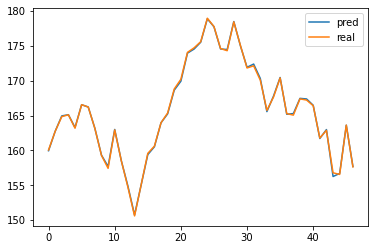

In [20]:
bmodel = TransformerTimeSeries(feature_dim = feature_dim,
                                  nhead = 4,num_layers = 12,d_model = 512,
                                  conv_len = 5,feature_weight = True,embedding_weight = True)
bmodel.load_state_dict(torch.load('AAPL_C'))
bmodel.to(device)
bmodel.eval()
with torch.no_grad(): # eliminate gradient i.e. gradients only exists in train()

    for step,(x,y,feature,attention_masks) in enumerate(test_dl):
        x = x.to(device)
        y = y.to(device)
        feature = feature.to(device)
        attention_masks = attention_masks.to(device)
        output = bmodel(x,y,feature,attention_masks[0])
        
        pred = data[train_size + 1 :-1,3]*0.01*(100+output[:,t0:].squeeze()).detach().cpu()
        ## note that test set starts at index train_size + 1 because idex train_size in rate_data 
        ## is the last day of first test data point, but rate_data only have the second til last data points
        ## of the dataset.
        real = data[train_size + 1 :-1,3]*0.01*(100+y[:,t0:].squeeze()).detach().cpu()

        plt.plot(pred)
        plt.plot(real)
        plt.legend(['pred','real'])
        MAE = torch.nn.L1Loss()(pred,real).item()
        MSE = torch.nn.MSELoss()(pred,real).item()
        RMSE = np.sqrt(MSE)
        
        print(f'AAPL MAE is {MAE}')
        print(f'AAPL MSE is {MSE}')
        print(f'AAPL RMSE is {RMSE}')

## AMZN
##### open

In [10]:
file_name = 'AMZN_features.csv'
with open(file_name) as f:
    data_list = csv.reader(f)
    data = []
    for row in data_list:
        data.append(row)
    f.close()
    
data = torch.tensor(np.delete(np.array(data)[1:,2:],4,axis = 1).astype(np.float)).type(torch.float)

feature_dim = data.shape[1] - 1
rate = []
for i in range(1,data.shape[0]):
    rate.append((100*(data[i,0:4] - data[i-1,0:4])/data[i-1,0:4]).reshape(1,4))
    
rate = torch.cat(rate)
rate_data = torch.cat([rate,data[1:,4:]],1)
train_size = int(data.shape[0]*0.9)
data_train = rate_data[0:train_size]
data_test = rate_data[train_size-4:]


t0 = 5
to_predict = 1
train_dataset = GetData(data_train[:,0],data_train[:,1:],t0 = t0, to_predict = to_predict)
test_dataset = GetData(data_test[:,0],data_test[:,1:],t0 = t0, to_predict = to_predict)
criterion = torch.nn.MSELoss()
# dataloaders
train_dl = DataLoader(train_dataset,batch_size=256,shuffle=True)
test_dl = DataLoader(test_dataset,batch_size=512)





model = TransformerTimeSeries(feature_dim = feature_dim,
                              nhead = 4,num_layers = 12,d_model = 512,
                              conv_len = 5,feature_weight = True,embedding_weight = True)
model = model.to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=1e-5 ,momentum = 0.9, nesterov = True)#Adam optimizer
#scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer,5e-7,3e-5,10,mode = 'exp_range',gamma = 0.9996)



train_epoch_loss = []
test_epoch_loss = []
test_best = 9999
for epoch in tqdm(range(4000)):


    l_t = train_epoch(model,train_dl,optimizer,t0,to_predict)

    train_loss = test_epoch(model,train_dl,t0,to_predict)


    test_loss = test_epoch(model,test_dl,t0,to_predict)


    if test_best > test_loss:
        test_best = test_loss
        torch.save(model.state_dict(), 'AMZN')



    train_epoch_loss.append(np.mean(train_loss))
    test_epoch_loss.append(test_loss)

    print("Epoch {}: Train loss: {} \t test loss: {}".format(epoch+1,
                                                             np.mean(train_loss),
                                                             test_loss))
    #scheduler.step()



torch.Size([431, 6])
torch.Size([431, 6])
torch.Size([47, 6])
torch.Size([47, 6])


  0%|                                                                                     | 0/4000 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1944: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
  0%|                                                                             | 1/4000 [00:00<24:08,  2.76it/s]

Epoch 1: Train loss: 1.5352529129683279 	 test loss: 2.451563596725464


  0%|                                                                             | 2/4000 [00:01<45:15,  1.47it/s]

Epoch 2: Train loss: 1.5094110210644396 	 test loss: 2.441396951675415


  0%|                                                                           | 3/4000 [00:05<2:47:11,  2.51s/it]

Epoch 3: Train loss: 1.4874010556258623 	 test loss: 2.426910161972046


  0%|                                                                           | 4/4000 [00:12<4:35:49,  4.14s/it]

Epoch 4: Train loss: 1.4785909749515649 	 test loss: 2.420596122741699


  0%|                                                                           | 5/4000 [00:19<5:36:28,  5.05s/it]

Epoch 5: Train loss: 1.475474908291049 	 test loss: 2.4170193672180176


  0%|                                                                           | 6/4000 [00:25<6:11:04,  5.57s/it]

Epoch 6: Train loss: 1.477602776407919 	 test loss: 2.4169795513153076


  0%|▏                                                                          | 8/4000 [00:31<4:21:12,  3.93s/it]

Epoch 7: Train loss: 1.4799353797031942 	 test loss: 2.416477680206299
Epoch 8: Train loss: 1.4811898334396965 	 test loss: 2.417731285095215


  0%|▏                                                                          | 9/4000 [00:38<5:23:39,  4.87s/it]

Epoch 9: Train loss: 1.4800362816542871 	 test loss: 2.4164485931396484


  0%|▏                                                                         | 10/4000 [00:45<6:03:17,  5.46s/it]

Epoch 10: Train loss: 1.475997168337386 	 test loss: 2.4123709201812744


  0%|▏                                                                         | 11/4000 [00:52<6:26:23,  5.81s/it]

Epoch 11: Train loss: 1.4712158812171068 	 test loss: 2.4070584774017334


  0%|▏                                                                         | 12/4000 [00:58<6:42:04,  6.05s/it]

Epoch 12: Train loss: 1.4665916687927778 	 test loss: 2.402439594268799


  0%|▏                                                                         | 13/4000 [01:05<6:49:33,  6.16s/it]

Epoch 13: Train loss: 1.4620580703642418 	 test loss: 2.398561477661133


  0%|▎                                                                         | 14/4000 [01:11<6:55:16,  6.25s/it]

Epoch 14: Train loss: 1.4578958688921828 	 test loss: 2.394808769226074


  0%|▎                                                                         | 15/4000 [01:18<7:10:12,  6.48s/it]

Epoch 15: Train loss: 1.4545800818644654 	 test loss: 2.39127779006958


  0%|▎                                                                         | 16/4000 [01:25<7:11:57,  6.51s/it]

Epoch 16: Train loss: 1.4520806912203124 	 test loss: 2.387685537338257


  0%|▎                                                                         | 17/4000 [01:31<7:07:57,  6.45s/it]

Epoch 17: Train loss: 1.4496973382347975 	 test loss: 2.384324073791504


  0%|▎                                                                         | 18/4000 [01:38<7:22:36,  6.67s/it]

Epoch 18: Train loss: 1.4472619981057682 	 test loss: 2.3806025981903076


  0%|▎                                                                         | 19/4000 [01:45<7:16:00,  6.57s/it]

Epoch 19: Train loss: 1.4447804481966589 	 test loss: 2.3773815631866455


  0%|▎                                                                         | 20/4000 [01:51<7:10:10,  6.49s/it]

Epoch 20: Train loss: 1.442079912482171 	 test loss: 2.3738255500793457


  1%|▍                                                                         | 21/4000 [01:58<7:18:36,  6.61s/it]

Epoch 21: Train loss: 1.4395079751025772 	 test loss: 2.370509386062622


  1%|▍                                                                         | 22/4000 [02:04<7:11:51,  6.51s/it]

Epoch 22: Train loss: 1.4367536901044735 	 test loss: 2.3670148849487305


  1%|▍                                                                         | 23/4000 [02:10<7:06:01,  6.43s/it]

Epoch 23: Train loss: 1.4340897308978016 	 test loss: 2.363358497619629


  1%|▍                                                                         | 24/4000 [02:18<7:23:12,  6.69s/it]

Epoch 24: Train loss: 1.4312877845874796 	 test loss: 2.3602538108825684


  1%|▍                                                                         | 25/4000 [02:24<7:22:08,  6.67s/it]

Epoch 25: Train loss: 1.4284985743100018 	 test loss: 2.3572092056274414


  1%|▍                                                                         | 26/4000 [02:31<7:20:37,  6.65s/it]

Epoch 26: Train loss: 1.425583414854417 	 test loss: 2.353372097015381


  1%|▍                                                                         | 27/4000 [02:37<7:19:31,  6.64s/it]

Epoch 27: Train loss: 1.4226775318729905 	 test loss: 2.3495450019836426


  1%|▌                                                                         | 28/4000 [02:44<7:18:43,  6.63s/it]

Epoch 28: Train loss: 1.4196454380615129 	 test loss: 2.345524549484253


  1%|▌                                                                         | 29/4000 [02:51<7:18:19,  6.62s/it]

Epoch 29: Train loss: 1.416590092077056 	 test loss: 2.3419649600982666


  1%|▌                                                                         | 30/4000 [02:57<7:11:17,  6.52s/it]

Epoch 30: Train loss: 1.4132524756433793 	 test loss: 2.3374383449554443


  1%|▌                                                                         | 31/4000 [03:04<7:19:15,  6.64s/it]

Epoch 31: Train loss: 1.4100559714775351 	 test loss: 2.333850145339966


  1%|▌                                                                         | 32/4000 [03:11<7:18:23,  6.63s/it]

Epoch 32: Train loss: 1.4067300646598266 	 test loss: 2.3299269676208496


  1%|▌                                                                         | 33/4000 [03:17<7:17:33,  6.62s/it]

Epoch 33: Train loss: 1.4029805472168182 	 test loss: 2.3255791664123535


  1%|▋                                                                         | 34/4000 [03:24<7:17:20,  6.62s/it]

Epoch 34: Train loss: 1.3993108424675713 	 test loss: 2.320962905883789


  1%|▋                                                                         | 35/4000 [03:30<7:16:32,  6.61s/it]

Epoch 35: Train loss: 1.3955315398506112 	 test loss: 2.316554307937622


  1%|▋                                                                         | 36/4000 [03:37<7:16:56,  6.61s/it]

Epoch 36: Train loss: 1.3917227928157196 	 test loss: 2.3120412826538086


  1%|▋                                                                         | 37/4000 [03:44<7:16:27,  6.61s/it]

Epoch 37: Train loss: 1.3877819688026978 	 test loss: 2.3076183795928955


  1%|▋                                                                         | 38/4000 [03:50<7:09:34,  6.51s/it]

Epoch 38: Train loss: 1.383735914517998 	 test loss: 2.302849769592285


  1%|▋                                                                         | 39/4000 [03:57<7:19:20,  6.65s/it]

Epoch 39: Train loss: 1.379510313341623 	 test loss: 2.2973201274871826


  1%|▋                                                                         | 40/4000 [04:03<7:14:08,  6.58s/it]

Epoch 40: Train loss: 1.375563367613507 	 test loss: 2.291836977005005


  1%|▊                                                                         | 41/4000 [04:10<7:10:38,  6.53s/it]

Epoch 41: Train loss: 1.3713620480694517 	 test loss: 2.2862930297851562


  1%|▊                                                                         | 42/4000 [04:16<7:13:42,  6.57s/it]

Epoch 42: Train loss: 1.3667943961659053 	 test loss: 2.2797558307647705


  1%|▊                                                                         | 43/4000 [04:23<7:20:58,  6.69s/it]

Epoch 43: Train loss: 1.3622091134573633 	 test loss: 2.2741637229919434


  1%|▊                                                                         | 44/4000 [04:30<7:17:45,  6.64s/it]

Epoch 44: Train loss: 1.3575971187405687 	 test loss: 2.2674102783203125


  1%|▊                                                                         | 45/4000 [04:36<7:05:05,  6.45s/it]

Epoch 45: Train loss: 1.3529643232473918 	 test loss: 2.2608933448791504


  1%|▊                                                                         | 46/4000 [04:43<7:13:37,  6.58s/it]

Epoch 46: Train loss: 1.3480936247345465 	 test loss: 2.2540223598480225


  1%|▊                                                                         | 47/4000 [04:50<7:21:46,  6.71s/it]

Epoch 47: Train loss: 1.3432104789463937 	 test loss: 2.2469310760498047


  1%|▉                                                                         | 48/4000 [04:56<7:18:37,  6.66s/it]

Epoch 48: Train loss: 1.3382013676614606 	 test loss: 2.2402727603912354


  1%|▉                                                                         | 49/4000 [05:03<7:18:41,  6.66s/it]

Epoch 49: Train loss: 1.3332934166605124 	 test loss: 2.234266757965088


  1%|▉                                                                         | 50/4000 [05:09<7:13:21,  6.58s/it]

Epoch 50: Train loss: 1.3272844442358702 	 test loss: 2.225954532623291


  1%|▉                                                                         | 51/4000 [05:16<7:17:20,  6.64s/it]

Epoch 51: Train loss: 1.3215480962651511 	 test loss: 2.217329263687134


  1%|▉                                                                         | 52/4000 [05:23<7:16:35,  6.64s/it]

Epoch 52: Train loss: 1.3153265595712684 	 test loss: 2.208125352859497


  1%|▉                                                                         | 53/4000 [05:29<7:02:29,  6.42s/it]

Epoch 53: Train loss: 1.30921718250018 	 test loss: 2.198875904083252


  1%|▉                                                                         | 54/4000 [05:36<7:18:50,  6.67s/it]

Epoch 54: Train loss: 1.3024372415586856 	 test loss: 2.188495397567749


  1%|█                                                                         | 55/4000 [05:42<7:17:47,  6.66s/it]

Epoch 55: Train loss: 1.295108644978906 	 test loss: 2.1768319606781006


  1%|█                                                                         | 56/4000 [05:49<7:16:35,  6.64s/it]

Epoch 56: Train loss: 1.288106130336664 	 test loss: 2.16618013381958


  1%|█                                                                         | 57/4000 [05:55<7:09:14,  6.53s/it]

Epoch 57: Train loss: 1.2811192984923963 	 test loss: 2.1549057960510254


  1%|█                                                                         | 58/4000 [06:02<7:17:17,  6.66s/it]

Epoch 58: Train loss: 1.273470111623441 	 test loss: 2.14229679107666


  1%|█                                                                         | 59/4000 [06:09<7:09:28,  6.54s/it]

Epoch 59: Train loss: 1.265925834461044 	 test loss: 2.130239486694336


  2%|█                                                                         | 60/4000 [06:15<7:08:12,  6.52s/it]

Epoch 60: Train loss: 1.257845065156711 	 test loss: 2.1178336143493652


  2%|█▏                                                                        | 61/4000 [06:22<7:19:08,  6.69s/it]

Epoch 61: Train loss: 1.2497940342830118 	 test loss: 2.1051621437072754


  2%|█▏                                                                        | 62/4000 [06:28<7:10:42,  6.56s/it]

Epoch 62: Train loss: 1.2416404073586873 	 test loss: 2.090142011642456


  2%|█▏                                                                        | 63/4000 [06:35<7:11:39,  6.58s/it]

Epoch 63: Train loss: 1.2338321338950067 	 test loss: 2.077274799346924


  2%|█▏                                                                        | 64/4000 [06:42<7:18:46,  6.69s/it]

Epoch 64: Train loss: 1.2259167158963231 	 test loss: 2.0629284381866455


  2%|█▏                                                                        | 65/4000 [06:49<7:17:51,  6.68s/it]

Epoch 65: Train loss: 1.2182383047732288 	 test loss: 2.0491647720336914


  2%|█▏                                                                        | 66/4000 [06:55<7:16:19,  6.65s/it]

Epoch 66: Train loss: 1.2104022455879264 	 test loss: 2.033627510070801


  2%|█▏                                                                        | 67/4000 [07:02<7:13:56,  6.62s/it]

Epoch 67: Train loss: 1.2029316782121593 	 test loss: 2.0197224617004395


  2%|█▎                                                                        | 68/4000 [07:08<7:14:18,  6.63s/it]

Epoch 68: Train loss: 1.194915707869209 	 test loss: 2.0024189949035645


  2%|█▎                                                                        | 69/4000 [07:15<7:07:52,  6.53s/it]

Epoch 69: Train loss: 1.1869430470079392 	 test loss: 1.9888490438461304


  2%|█▎                                                                        | 70/4000 [07:22<7:14:46,  6.64s/it]

Epoch 70: Train loss: 1.178402215864708 	 test loss: 1.9726866483688354


  2%|█▎                                                                        | 71/4000 [07:28<7:14:47,  6.64s/it]

Epoch 71: Train loss: 1.1700019261123409 	 test loss: 1.9565690755844116


  2%|█▎                                                                        | 72/4000 [07:34<7:00:15,  6.42s/it]

Epoch 72: Train loss: 1.1611422527140642 	 test loss: 1.9414530992507935


  2%|█▎                                                                        | 73/4000 [07:41<7:16:48,  6.67s/it]

Epoch 73: Train loss: 1.1527176633511784 	 test loss: 1.9263129234313965


  2%|█▎                                                                        | 74/4000 [07:48<7:15:55,  6.66s/it]

Epoch 74: Train loss: 1.1443955737864058 	 test loss: 1.910862922668457


  2%|█▍                                                                        | 75/4000 [07:54<7:07:14,  6.53s/it]

Epoch 75: Train loss: 1.1359164900126977 	 test loss: 1.8956655263900757


  2%|█▍                                                                        | 76/4000 [08:01<7:02:11,  6.46s/it]

Epoch 76: Train loss: 1.1270677708694388 	 test loss: 1.8806813955307007


  2%|█▍                                                                        | 77/4000 [08:08<7:18:04,  6.70s/it]

Epoch 77: Train loss: 1.1182989756081885 	 test loss: 1.8654872179031372


  2%|█▍                                                                        | 78/4000 [08:14<7:16:50,  6.68s/it]

Epoch 78: Train loss: 1.1102819733166087 	 test loss: 1.8492504358291626


  2%|█▍                                                                        | 79/4000 [08:21<7:16:04,  6.67s/it]

Epoch 79: Train loss: 1.1017949760928232 	 test loss: 1.8328160047531128


  2%|█▍                                                                        | 80/4000 [08:28<7:13:03,  6.63s/it]

Epoch 80: Train loss: 1.0930831222135893 	 test loss: 1.8156346082687378


  2%|█▍                                                                        | 81/4000 [08:34<7:10:47,  6.60s/it]

Epoch 81: Train loss: 1.083604187810504 	 test loss: 1.8002549409866333


  2%|█▌                                                                        | 82/4000 [08:41<7:13:40,  6.64s/it]

Epoch 82: Train loss: 1.0740122410648107 	 test loss: 1.7829246520996094


  2%|█▌                                                                        | 83/4000 [08:48<7:13:01,  6.63s/it]

Epoch 83: Train loss: 1.0643084570592627 	 test loss: 1.7665648460388184


  2%|█▌                                                                        | 84/4000 [08:54<7:12:18,  6.62s/it]

Epoch 84: Train loss: 1.0556158812029455 	 test loss: 1.748604416847229


  2%|█▌                                                                        | 85/4000 [09:00<7:05:33,  6.52s/it]

Epoch 85: Train loss: 1.0475294750417192 	 test loss: 1.7321945428848267


  2%|█▌                                                                        | 86/4000 [09:07<7:06:55,  6.54s/it]

Epoch 86: Train loss: 1.0389761855596733 	 test loss: 1.7145310640335083


  2%|█▌                                                                        | 87/4000 [09:14<7:15:22,  6.68s/it]

Epoch 87: Train loss: 1.0295181311753399 	 test loss: 1.6987190246582031


  2%|█▋                                                                        | 88/4000 [09:21<7:14:03,  6.66s/it]

Epoch 88: Train loss: 1.020613374262011 	 test loss: 1.682920217514038


  2%|█▋                                                                        | 89/4000 [09:27<7:13:14,  6.65s/it]

Epoch 89: Train loss: 1.0116517541026848 	 test loss: 1.6687411069869995


  2%|█▋                                                                        | 90/4000 [09:34<7:12:00,  6.63s/it]

Epoch 90: Train loss: 1.0026758423814088 	 test loss: 1.6524912118911743


  2%|█▋                                                                        | 91/4000 [09:40<7:10:47,  6.61s/it]

Epoch 91: Train loss: 0.993604060530386 	 test loss: 1.6325219869613647


  2%|█▋                                                                        | 92/4000 [09:47<7:11:08,  6.62s/it]

Epoch 92: Train loss: 0.9833833204621228 	 test loss: 1.6187394857406616


  2%|█▋                                                                        | 93/4000 [09:54<7:10:53,  6.62s/it]

Epoch 93: Train loss: 0.9750944403650589 	 test loss: 1.5988129377365112


  2%|█▋                                                                        | 94/4000 [10:00<7:09:52,  6.60s/it]

Epoch 94: Train loss: 0.966054997283732 	 test loss: 1.5829612016677856


  2%|█▊                                                                        | 95/4000 [10:07<7:03:54,  6.51s/it]

Epoch 95: Train loss: 0.9588057303373332 	 test loss: 1.5764964818954468


  2%|█▊                                                                        | 96/4000 [10:13<7:05:36,  6.54s/it]

Epoch 96: Train loss: 0.9525400563348474 	 test loss: 1.5613234043121338


  2%|█▊                                                                        | 97/4000 [10:19<7:00:50,  6.47s/it]

Epoch 97: Train loss: 0.9435884003849427 	 test loss: 1.5492500066757202


  2%|█▊                                                                        | 98/4000 [10:27<7:16:09,  6.71s/it]

Epoch 98: Train loss: 0.9346211401879649 	 test loss: 1.533445954322815


  2%|█▊                                                                        | 99/4000 [10:33<7:17:38,  6.73s/it]

Epoch 99: Train loss: 0.9267599631074963 	 test loss: 1.5183570384979248


  2%|█▊                                                                       | 100/4000 [10:40<7:07:58,  6.58s/it]

Epoch 100: Train loss: 0.9199743113219047 	 test loss: 1.5026662349700928


  3%|█▊                                                                       | 101/4000 [10:46<7:11:15,  6.64s/it]

Epoch 101: Train loss: 0.913311772584362 	 test loss: 1.4889872074127197


  3%|█▊                                                                       | 102/4000 [10:53<7:11:03,  6.64s/it]

Epoch 102: Train loss: 0.9058546393487403 	 test loss: 1.4733896255493164


  3%|█▉                                                                       | 103/4000 [11:00<7:06:42,  6.57s/it]

Epoch 103: Train loss: 0.8972046260490771 	 test loss: 1.4540743827819824


  3%|█▉                                                                       | 104/4000 [11:06<7:09:27,  6.61s/it]

Epoch 104: Train loss: 0.8933350767447611 	 test loss: 1.4457124471664429


  3%|█▉                                                                       | 105/4000 [11:13<7:08:19,  6.60s/it]

Epoch 105: Train loss: 0.8851452252704417 	 test loss: 1.4320244789123535


  3%|█▉                                                                       | 106/4000 [11:19<7:09:30,  6.62s/it]

Epoch 106: Train loss: 0.8784194407496264 	 test loss: 1.4153246879577637


  3%|█▉                                                                       | 107/4000 [11:25<6:57:10,  6.43s/it]

Epoch 107: Train loss: 0.871421538206928 	 test loss: 1.3998068571090698


  3%|█▉                                                                       | 108/4000 [11:33<7:13:32,  6.68s/it]

Epoch 108: Train loss: 0.8647701585375792 	 test loss: 1.388549566268921


  3%|█▉                                                                       | 109/4000 [11:39<7:11:41,  6.66s/it]

Epoch 109: Train loss: 0.858428806965423 	 test loss: 1.3770663738250732


  3%|██                                                                       | 110/4000 [11:46<7:08:57,  6.62s/it]

Epoch 110: Train loss: 0.851689231091475 	 test loss: 1.3673069477081299


  3%|██                                                                       | 111/4000 [11:53<7:11:19,  6.65s/it]

Epoch 111: Train loss: 0.8446145368839362 	 test loss: 1.3554147481918335


  3%|██                                                                       | 112/4000 [11:58<6:56:40,  6.43s/it]

Epoch 112: Train loss: 0.8392456036985888 	 test loss: 1.3468482494354248


  3%|██                                                                       | 113/4000 [12:06<7:13:00,  6.68s/it]

Epoch 113: Train loss: 0.8332354967112884 	 test loss: 1.337695837020874


  3%|██                                                                       | 114/4000 [12:12<7:12:00,  6.67s/it]

Epoch 114: Train loss: 0.8271757282679706 	 test loss: 1.3283225297927856


  3%|██                                                                       | 115/4000 [12:19<7:08:15,  6.61s/it]

Epoch 115: Train loss: 0.8214086537571351 	 test loss: 1.3175041675567627


  3%|██                                                                       | 116/4000 [12:26<7:10:24,  6.65s/it]

Epoch 116: Train loss: 0.8144908005289578 	 test loss: 1.307688593864441


  3%|██▏                                                                      | 117/4000 [12:32<7:08:24,  6.62s/it]

Epoch 117: Train loss: 0.8089445812796219 	 test loss: 1.2975120544433594


  3%|██▏                                                                      | 118/4000 [12:39<7:08:57,  6.63s/it]

Epoch 118: Train loss: 0.8033777808645208 	 test loss: 1.2888023853302002


  3%|██▏                                                                      | 119/4000 [12:45<7:08:19,  6.62s/it]

Epoch 119: Train loss: 0.7981211175221579 	 test loss: 1.2821769714355469


  3%|██▏                                                                      | 120/4000 [12:52<7:03:53,  6.56s/it]

Epoch 120: Train loss: 0.7921482653739558 	 test loss: 1.2690348625183105


  3%|██▏                                                                      | 121/4000 [12:59<7:06:29,  6.60s/it]

Epoch 121: Train loss: 0.7848888083842956 	 test loss: 1.2562377452850342


  3%|██▏                                                                      | 122/4000 [13:05<7:08:43,  6.63s/it]

Epoch 122: Train loss: 0.7785834188804273 	 test loss: 1.2428922653198242


  3%|██▏                                                                      | 123/4000 [13:12<7:08:13,  6.63s/it]

Epoch 123: Train loss: 0.7722143864133795 	 test loss: 1.2352416515350342


  3%|██▎                                                                      | 124/4000 [13:18<7:06:50,  6.61s/it]

Epoch 124: Train loss: 0.7669961345997874 	 test loss: 1.2267446517944336


  3%|██▎                                                                      | 125/4000 [13:25<7:06:50,  6.61s/it]

Epoch 125: Train loss: 0.7614110208995934 	 test loss: 1.2186355590820312


  3%|██▎                                                                      | 126/4000 [13:32<7:07:12,  6.62s/it]

Epoch 126: Train loss: 0.7552285494494604 	 test loss: 1.2096525430679321


  3%|██▎                                                                      | 127/4000 [13:38<7:00:22,  6.51s/it]

Epoch 127: Train loss: 0.7493847131452538 	 test loss: 1.2004419565200806


  3%|██▎                                                                      | 128/4000 [13:45<7:01:58,  6.54s/it]

Epoch 128: Train loss: 0.7442823779831906 	 test loss: 1.1936734914779663


  3%|██▎                                                                      | 129/4000 [13:51<6:57:07,  6.47s/it]

Epoch 129: Train loss: 0.7387481385759854 	 test loss: 1.1851025819778442


  3%|██▎                                                                      | 130/4000 [13:58<7:12:49,  6.71s/it]

Epoch 130: Train loss: 0.733371537965301 	 test loss: 1.176206350326538


  3%|██▍                                                                      | 131/4000 [14:05<7:10:28,  6.68s/it]

Epoch 131: Train loss: 0.7274585417417805 	 test loss: 1.1677576303482056


  3%|██▍                                                                      | 132/4000 [14:11<7:08:47,  6.65s/it]

Epoch 132: Train loss: 0.7220092263686408 	 test loss: 1.1619685888290405


  3%|██▍                                                                      | 133/4000 [14:18<7:01:38,  6.54s/it]

Epoch 133: Train loss: 0.7177491217091023 	 test loss: 1.1529940366744995


  3%|██▍                                                                      | 134/4000 [14:24<7:08:54,  6.66s/it]

Epoch 134: Train loss: 0.7130046578128487 	 test loss: 1.1420133113861084


  3%|██▍                                                                      | 135/4000 [14:31<7:01:46,  6.55s/it]

Epoch 135: Train loss: 0.7083220256453601 	 test loss: 1.1324458122253418


  3%|██▍                                                                      | 136/4000 [14:37<7:03:52,  6.58s/it]

Epoch 136: Train loss: 0.7033463972350561 	 test loss: 1.121915578842163


  3%|██▌                                                                      | 137/4000 [14:44<7:04:36,  6.59s/it]

Epoch 137: Train loss: 0.6978014469699904 	 test loss: 1.1138514280319214


  3%|██▌                                                                      | 138/4000 [14:50<6:58:51,  6.51s/it]

Epoch 138: Train loss: 0.6923609984446568 	 test loss: 1.1074637174606323


  3%|██▌                                                                      | 139/4000 [14:57<7:00:48,  6.54s/it]

Epoch 139: Train loss: 0.6877672585146609 	 test loss: 1.0977859497070312


  4%|██▌                                                                      | 140/4000 [15:04<7:14:03,  6.75s/it]

Epoch 140: Train loss: 0.6816267272989047 	 test loss: 1.0913283824920654


  4%|██▌                                                                      | 141/4000 [15:11<7:11:32,  6.71s/it]

Epoch 141: Train loss: 0.6764171510727389 	 test loss: 1.0783931016921997


  4%|██▌                                                                      | 142/4000 [15:17<6:56:33,  6.48s/it]

Epoch 142: Train loss: 0.6713724252519364 	 test loss: 1.0724248886108398


  4%|██▌                                                                      | 143/4000 [15:24<7:11:26,  6.71s/it]

Epoch 143: Train loss: 0.6676831733599616 	 test loss: 1.0699180364608765


  4%|██▋                                                                      | 144/4000 [15:31<7:08:58,  6.67s/it]

Epoch 144: Train loss: 0.6615575337631243 	 test loss: 1.0646950006484985


  4%|██▋                                                                      | 145/4000 [15:41<8:22:04,  7.81s/it]

Epoch 145: Train loss: 0.656271493075342 	 test loss: 1.0548720359802246


  4%|██▋                                                                      | 146/4000 [15:50<8:39:33,  8.09s/it]

Epoch 146: Train loss: 0.6500190023479772 	 test loss: 1.0461889505386353


  4%|██▋                                                                      | 147/4000 [15:56<8:10:23,  7.64s/it]

Epoch 147: Train loss: 0.6444809402224636 	 test loss: 1.0403249263763428


  4%|██▋                                                                      | 148/4000 [16:04<8:03:21,  7.53s/it]

Epoch 148: Train loss: 0.6389198798314601 	 test loss: 1.0324923992156982


  4%|██▋                                                                      | 149/4000 [16:10<7:45:11,  7.25s/it]

Epoch 149: Train loss: 0.6345462543228663 	 test loss: 1.024017095565796


  4%|██▋                                                                      | 150/4000 [16:17<7:32:00,  7.04s/it]

Epoch 150: Train loss: 0.62970310117695 	 test loss: 1.0181266069412231


  4%|██▊                                                                      | 151/4000 [16:24<7:24:29,  6.93s/it]

Epoch 151: Train loss: 0.6256778179354568 	 test loss: 1.0123887062072754


  4%|██▊                                                                      | 152/4000 [16:35<8:54:31,  8.33s/it]

Epoch 152: Train loss: 0.6212627544757109 	 test loss: 1.0039314031600952


  4%|██▊                                                                      | 153/4000 [16:43<8:51:44,  8.29s/it]

Epoch 153: Train loss: 0.6168714723011733 	 test loss: 0.9956978559494019


  4%|██▊                                                                      | 154/4000 [16:50<8:19:19,  7.79s/it]

Epoch 154: Train loss: 0.61258524808419 	 test loss: 0.9868956804275513


  4%|██▊                                                                      | 155/4000 [16:57<7:59:36,  7.48s/it]

Epoch 155: Train loss: 0.6094310680564208 	 test loss: 0.9783033728599548


  4%|██▊                                                                      | 156/4000 [17:03<7:39:17,  7.17s/it]

Epoch 156: Train loss: 0.6046787291557773 	 test loss: 0.9706147313117981


  4%|██▊                                                                      | 157/4000 [17:09<7:22:18,  6.91s/it]

Epoch 157: Train loss: 0.6016090802692758 	 test loss: 0.9662900567054749


  4%|██▉                                                                      | 158/4000 [17:16<7:23:23,  6.92s/it]

Epoch 158: Train loss: 0.5974103504156568 	 test loss: 0.957511305809021


  4%|██▉                                                                      | 159/4000 [17:30<9:24:50,  8.82s/it]

Epoch 159: Train loss: 0.5923507463904378 	 test loss: 0.9512385725975037


  4%|██▉                                                                      | 160/4000 [17:35<8:27:18,  7.93s/it]

Epoch 160: Train loss: 0.5880416775524201 	 test loss: 0.9446730613708496


  4%|██▉                                                                      | 161/4000 [17:43<8:15:48,  7.75s/it]

Epoch 161: Train loss: 0.5837412571962362 	 test loss: 0.939996063709259


  4%|██▉                                                                      | 162/4000 [17:49<7:53:51,  7.41s/it]

Epoch 162: Train loss: 0.5807996862449115 	 test loss: 0.9335106015205383


  4%|██▉                                                                      | 163/4000 [17:56<7:37:16,  7.15s/it]

Epoch 163: Train loss: 0.5785343537751041 	 test loss: 0.9259161353111267


  4%|██▉                                                                      | 164/4000 [18:03<7:25:18,  6.97s/it]

Epoch 164: Train loss: 0.5745784814562432 	 test loss: 0.9213007092475891


  4%|███                                                                      | 165/4000 [18:10<7:26:47,  6.99s/it]

Epoch 165: Train loss: 0.5722186395297747 	 test loss: 0.9168946743011475


  4%|███                                                                      | 166/4000 [18:22<9:05:53,  8.54s/it]

Epoch 166: Train loss: 0.564891457695972 	 test loss: 0.9070199728012085


  4%|███                                                                      | 167/4000 [18:29<8:42:41,  8.18s/it]

Epoch 167: Train loss: 0.5599349394198637 	 test loss: 0.9025118947029114


  4%|███                                                                      | 168/4000 [18:36<8:11:27,  7.70s/it]

Epoch 168: Train loss: 0.5560356444936341 	 test loss: 0.9019244909286499


  4%|███                                                                      | 169/4000 [18:42<7:50:43,  7.37s/it]

Epoch 169: Train loss: 0.5472258240883422 	 test loss: 0.8951123356819153


  4%|███                                                                      | 170/4000 [18:49<7:36:04,  7.14s/it]

Epoch 170: Train loss: 0.5465638683179692 	 test loss: 0.890278160572052


  4%|███                                                                      | 171/4000 [18:55<7:25:10,  6.98s/it]

Epoch 171: Train loss: 0.5451108867220426 	 test loss: 0.8862283825874329


  4%|███▏                                                                     | 172/4000 [19:01<7:05:34,  6.67s/it]

Epoch 172: Train loss: 0.5406288653957871 	 test loss: 0.8844305276870728


  4%|███▏                                                                     | 173/4000 [19:09<7:14:57,  6.82s/it]

Epoch 173: Train loss: 0.5372183141741564 	 test loss: 0.8782596588134766


  4%|███▏                                                                     | 174/4000 [19:15<7:06:28,  6.69s/it]

Epoch 174: Train loss: 0.534999261322818 	 test loss: 0.8675351142883301


  4%|███▏                                                                     | 175/4000 [19:21<6:57:32,  6.55s/it]

Epoch 175: Train loss: 0.5365060277438772 	 test loss: 0.8622406125068665


  4%|███▏                                                                     | 176/4000 [19:28<7:11:01,  6.76s/it]

Epoch 176: Train loss: 0.5353882019591719 	 test loss: 0.8572952151298523


  4%|███▏                                                                     | 177/4000 [19:35<7:08:26,  6.72s/it]

Epoch 177: Train loss: 0.5305402659899674 	 test loss: 0.851295530796051


  4%|███▏                                                                     | 178/4000 [19:44<7:42:25,  7.26s/it]

Epoch 178: Train loss: 0.5261038107551168 	 test loss: 0.8482102751731873


  4%|███▎                                                                     | 179/4000 [19:55<9:04:28,  8.55s/it]

Epoch 179: Train loss: 0.5241241101045896 	 test loss: 0.8423895239830017


  4%|███▎                                                                     | 180/4000 [20:02<8:23:36,  7.91s/it]

Epoch 180: Train loss: 0.5233477207458213 	 test loss: 0.8385858535766602


  5%|███▎                                                                     | 181/4000 [20:08<7:46:12,  7.32s/it]

Epoch 181: Train loss: 0.5189013793684214 	 test loss: 0.8329176902770996


  5%|███▎                                                                     | 182/4000 [20:14<7:38:10,  7.20s/it]

Epoch 182: Train loss: 0.5152186458182723 	 test loss: 0.8292823433876038


  5%|███▎                                                                     | 183/4000 [20:21<7:21:07,  6.93s/it]

Epoch 183: Train loss: 0.5123189346143099 	 test loss: 0.8275840878486633


  5%|███▎                                                                     | 184/4000 [20:28<7:26:37,  7.02s/it]

Epoch 184: Train loss: 0.5100750153551522 	 test loss: 0.8235012292861938


  5%|███▍                                                                     | 185/4000 [20:39<8:35:11,  8.10s/it]

Epoch 185: Train loss: 0.5076768914120933 	 test loss: 0.8208639025688171


  5%|███▍                                                                     | 186/4000 [20:48<8:56:52,  8.45s/it]

Epoch 186: Train loss: 0.5045103172138506 	 test loss: 0.8199158906936646


  5%|███▍                                                                     | 187/4000 [20:54<8:21:02,  7.88s/it]

Epoch 187: Train loss: 0.5022157173422263 	 test loss: 0.8191320300102234


  5%|███▍                                                                     | 188/4000 [21:01<7:50:13,  7.40s/it]

Epoch 188: Train loss: 0.4988637105356513 	 test loss: 0.8123064637184143


  5%|███▍                                                                     | 189/4000 [21:08<7:41:01,  7.26s/it]

Epoch 189: Train loss: 0.49582037675408364 	 test loss: 0.8045148253440857


  5%|███▍                                                                     | 190/4000 [21:14<7:28:25,  7.06s/it]

Epoch 190: Train loss: 0.49267719253863096 	 test loss: 0.798035204410553


  5%|███▍                                                                     | 191/4000 [21:21<7:16:12,  6.87s/it]

Epoch 191: Train loss: 0.4891906444268547 	 test loss: 0.7966712713241577


  5%|███▌                                                                     | 192/4000 [21:31<8:16:58,  7.83s/it]

Epoch 192: Train loss: 0.4862725198822066 	 test loss: 0.793673574924469


  5%|███▌                                                                     | 193/4000 [21:40<8:50:32,  8.36s/it]

Epoch 193: Train loss: 0.4842739489681483 	 test loss: 0.792354166507721


  5%|███▌                                                                     | 194/4000 [21:47<8:23:04,  7.93s/it]

Epoch 194: Train loss: 0.4839718030666254 	 test loss: 0.7889404296875


  5%|███▌                                                                     | 195/4000 [21:48<5:58:03,  5.65s/it]

Epoch 195: Train loss: 0.48421872187656484 	 test loss: 0.7890975475311279


  5%|███▌                                                                     | 196/4000 [21:54<6:03:49,  5.74s/it]

Epoch 196: Train loss: 0.4772072634259952 	 test loss: 0.7801916599273682


  5%|███▌                                                                     | 197/4000 [22:00<6:26:46,  6.10s/it]

Epoch 197: Train loss: 0.474998211293652 	 test loss: 0.7773815393447876


  5%|███▌                                                                     | 198/4000 [22:07<6:35:34,  6.24s/it]

Epoch 198: Train loss: 0.47261371745310915 	 test loss: 0.7743761539459229


  5%|███▋                                                                     | 199/4000 [22:14<6:42:26,  6.35s/it]

Epoch 199: Train loss: 0.4713558460609542 	 test loss: 0.7703393697738647


  5%|███▋                                                                     | 200/4000 [22:26<8:28:42,  8.03s/it]

Epoch 200: Train loss: 0.46982908663782885 	 test loss: 0.7678871750831604


  5%|███▋                                                                     | 201/4000 [22:33<8:13:07,  7.79s/it]

Epoch 201: Train loss: 0.46765947480212783 	 test loss: 0.7663202881813049


  5%|███▋                                                                     | 202/4000 [22:40<7:58:08,  7.55s/it]

Epoch 202: Train loss: 0.4644110513950445 	 test loss: 0.7646269202232361


  5%|███▋                                                                     | 203/4000 [22:47<7:46:15,  7.37s/it]

Epoch 203: Train loss: 0.46260799491765053 	 test loss: 0.760240912437439


  5%|███▋                                                                     | 204/4000 [22:53<7:24:53,  7.03s/it]

Epoch 204: Train loss: 0.4599796234869902 	 test loss: 0.7547271847724915


  5%|███▋                                                                     | 205/4000 [23:00<7:23:43,  7.02s/it]

Epoch 205: Train loss: 0.4579944995744046 	 test loss: 0.7510515451431274


  5%|███▊                                                                     | 206/4000 [23:07<7:15:05,  6.88s/it]

Epoch 206: Train loss: 0.45619796067822005 	 test loss: 0.7491629123687744


  5%|███▊                                                                     | 207/4000 [23:13<7:09:19,  6.79s/it]

Epoch 207: Train loss: 0.4554425237350287 	 test loss: 0.7457020282745361


  5%|███▊                                                                     | 208/4000 [23:19<6:53:14,  6.54s/it]

Epoch 208: Train loss: 0.4539338050198389 	 test loss: 0.7413833737373352


  5%|███▊                                                                     | 209/4000 [23:26<7:07:35,  6.77s/it]

Epoch 209: Train loss: 0.45066360330636984 	 test loss: 0.738222062587738


  5%|███▊                                                                     | 210/4000 [23:33<7:04:31,  6.72s/it]

Epoch 210: Train loss: 0.4492667219201816 	 test loss: 0.7369125485420227


  5%|███▊                                                                     | 211/4000 [23:39<6:59:04,  6.64s/it]

Epoch 211: Train loss: 0.4471943767054175 	 test loss: 0.7344962954521179


  5%|███▊                                                                     | 212/4000 [23:46<7:01:06,  6.67s/it]

Epoch 212: Train loss: 0.44573541915610326 	 test loss: 0.731924831867218


  5%|███▉                                                                     | 213/4000 [23:53<7:00:00,  6.65s/it]

Epoch 213: Train loss: 0.4438502713173559 	 test loss: 0.7264736890792847


  5%|███▉                                                                     | 214/4000 [23:59<6:52:39,  6.54s/it]

Epoch 214: Train loss: 0.4414200854688675 	 test loss: 0.7244162559509277


  5%|███▉                                                                     | 215/4000 [24:06<6:59:37,  6.65s/it]

Epoch 215: Train loss: 0.4404612978760438 	 test loss: 0.719898521900177


  5%|███▉                                                                     | 216/4000 [24:13<6:59:17,  6.65s/it]

Epoch 216: Train loss: 0.4391524731559709 	 test loss: 0.7189111113548279


  5%|███▉                                                                     | 217/4000 [24:19<6:59:02,  6.65s/it]

Epoch 217: Train loss: 0.439424534408233 	 test loss: 0.7177071571350098


  5%|███▉                                                                     | 218/4000 [24:25<6:45:21,  6.43s/it]

Epoch 218: Train loss: 0.4384514051219427 	 test loss: 0.7124650478363037


  5%|███▉                                                                     | 219/4000 [24:26<4:49:51,  4.60s/it]

Epoch 219: Train loss: 0.4362784629631485 	 test loss: 0.7126433253288269


  6%|████                                                                     | 220/4000 [24:32<5:33:54,  5.30s/it]

Epoch 220: Train loss: 0.4351745060452729 	 test loss: 0.7107988595962524


  6%|████                                                                     | 221/4000 [24:39<5:58:27,  5.69s/it]

Epoch 221: Train loss: 0.4338169260395652 	 test loss: 0.7071380615234375


  6%|████                                                                     | 222/4000 [24:45<6:05:04,  5.80s/it]

Epoch 222: Train loss: 0.4343122624189284 	 test loss: 0.7032350301742554


  6%|████                                                                     | 223/4000 [24:52<6:29:42,  6.19s/it]

Epoch 223: Train loss: 0.43237009416323524 	 test loss: 0.7015823721885681


  6%|████                                                                     | 224/4000 [25:04<8:10:50,  7.80s/it]

Epoch 224: Train loss: 0.4292487972988607 	 test loss: 0.700515866279602


  6%|████                                                                     | 225/4000 [25:12<8:20:45,  7.96s/it]

Epoch 225: Train loss: 0.42712515841503984 	 test loss: 0.6994609236717224


  6%|████                                                                     | 226/4000 [25:19<7:58:48,  7.61s/it]

Epoch 226: Train loss: 0.4251006013279448 	 test loss: 0.6954915523529053


  6%|████▏                                                                    | 227/4000 [25:25<7:35:43,  7.25s/it]

Epoch 227: Train loss: 0.42289962382714874 	 test loss: 0.6936219930648804


  6%|████▏                                                                    | 228/4000 [25:32<7:22:40,  7.04s/it]

Epoch 228: Train loss: 0.4201224884688163 	 test loss: 0.6842784285545349


  6%|████▏                                                                    | 230/4000 [25:38<5:03:00,  4.82s/it]

Epoch 229: Train loss: 0.418383748791334 	 test loss: 0.683887243270874
Epoch 230: Train loss: 0.41986793964202335 	 test loss: 0.6867085695266724


  6%|████▏                                                                    | 231/4000 [25:38<3:34:43,  3.42s/it]

Epoch 231: Train loss: 0.41731811053791623 	 test loss: 0.6854040622711182


  6%|████▏                                                                    | 232/4000 [25:45<4:29:58,  4.30s/it]

Epoch 232: Train loss: 0.40906177990121245 	 test loss: 0.6808207631111145


  6%|████▎                                                                    | 233/4000 [25:51<5:07:19,  4.90s/it]

Epoch 233: Train loss: 0.40660704496011935 	 test loss: 0.6776607036590576


  6%|████▎                                                                    | 234/4000 [25:51<3:41:16,  3.53s/it]

Epoch 234: Train loss: 0.40558898324479636 	 test loss: 0.678402304649353


  6%|████▎                                                                    | 235/4000 [25:58<4:45:40,  4.55s/it]

Epoch 235: Train loss: 0.4030395769741032 	 test loss: 0.6744988560676575


  6%|████▎                                                                    | 236/4000 [26:05<5:23:35,  5.16s/it]

Epoch 236: Train loss: 0.4032525332372316 	 test loss: 0.6729793548583984


  6%|████▎                                                                    | 237/4000 [26:12<5:51:04,  5.60s/it]

Epoch 237: Train loss: 0.40500589928604885 	 test loss: 0.6729317903518677


  6%|████▎                                                                    | 238/4000 [26:18<6:10:13,  5.90s/it]

Epoch 238: Train loss: 0.4009578862765549 	 test loss: 0.6668711304664612


  6%|████▎                                                                    | 239/4000 [26:29<7:38:13,  7.31s/it]

Epoch 239: Train loss: 0.3987417756266494 	 test loss: 0.6659553647041321


  6%|████▍                                                                    | 240/4000 [26:37<8:01:25,  7.68s/it]

Epoch 240: Train loss: 0.39584503013407274 	 test loss: 0.6623424291610718


  6%|████▍                                                                    | 241/4000 [26:45<7:53:30,  7.56s/it]

Epoch 241: Train loss: 0.39081115263520705 	 test loss: 0.6590731143951416


  6%|████▍                                                                    | 242/4000 [26:51<7:35:25,  7.27s/it]

Epoch 242: Train loss: 0.3867435974615632 	 test loss: 0.6557081341743469


  6%|████▍                                                                    | 243/4000 [26:57<7:09:53,  6.87s/it]

Epoch 243: Train loss: 0.38528604933391314 	 test loss: 0.6523470282554626


  6%|████▍                                                                    | 244/4000 [27:04<7:11:41,  6.90s/it]

Epoch 244: Train loss: 0.38391256387714995 	 test loss: 0.6498628854751587


  6%|████▍                                                                    | 245/4000 [27:04<5:07:45,  4.92s/it]

Epoch 245: Train loss: 0.3843815926885937 	 test loss: 0.6507428288459778


  6%|████▍                                                                    | 246/4000 [27:05<3:41:04,  3.53s/it]

Epoch 246: Train loss: 0.3844205972904949 	 test loss: 0.6527437567710876


  6%|████▌                                                                    | 247/4000 [27:05<2:40:30,  2.57s/it]

Epoch 247: Train loss: 0.38477184932912306 	 test loss: 0.6513740420341492


  6%|████▌                                                                    | 248/4000 [27:05<1:58:19,  1.89s/it]

Epoch 248: Train loss: 0.38414036460099804 	 test loss: 0.652678370475769


  6%|████▌                                                                    | 249/4000 [27:06<1:28:40,  1.42s/it]

Epoch 249: Train loss: 0.3855762178825945 	 test loss: 0.6502137780189514


  6%|████▌                                                                    | 250/4000 [27:11<2:36:40,  2.51s/it]

Epoch 250: Train loss: 0.3896666727182207 	 test loss: 0.6472670435905457


  6%|████▌                                                                    | 252/4000 [27:23<3:56:08,  3.78s/it]

Epoch 251: Train loss: 0.3868294867866277 	 test loss: 0.6441726684570312
Epoch 252: Train loss: 0.3843454431630066 	 test loss: 0.6449750065803528


  6%|████▌                                                                    | 253/4000 [27:31<5:17:17,  5.08s/it]

Epoch 253: Train loss: 0.3829910228949412 	 test loss: 0.642723560333252


  6%|████▋                                                                    | 254/4000 [27:31<3:48:00,  3.65s/it]

Epoch 254: Train loss: 0.38144476466278465 	 test loss: 0.643403947353363


  6%|████▋                                                                    | 255/4000 [27:37<4:29:13,  4.31s/it]

Epoch 255: Train loss: 0.38189555320828256 	 test loss: 0.6419276595115662


  6%|████▋                                                                    | 256/4000 [27:37<3:14:27,  3.12s/it]

Epoch 256: Train loss: 0.38035424070955703 	 test loss: 0.6423501968383789


  6%|████▋                                                                    | 257/4000 [27:38<2:22:01,  2.28s/it]

Epoch 257: Train loss: 0.382968926374431 	 test loss: 0.6436677575111389


  6%|████▋                                                                    | 258/4000 [27:43<3:25:34,  3.30s/it]

Epoch 258: Train loss: 0.37750037356761657 	 test loss: 0.6397853493690491


  6%|████▋                                                                    | 259/4000 [27:51<4:37:27,  4.45s/it]

Epoch 259: Train loss: 0.38036341131978135 	 test loss: 0.636093020439148


  6%|████▋                                                                    | 260/4000 [27:57<5:19:47,  5.13s/it]

Epoch 260: Train loss: 0.3781716667305842 	 test loss: 0.6342286467552185


  7%|████▊                                                                    | 261/4000 [27:58<3:49:39,  3.69s/it]

Epoch 261: Train loss: 0.372564166369405 	 test loss: 0.6350705623626709


  7%|████▊                                                                    | 262/4000 [27:58<2:46:36,  2.67s/it]

Epoch 262: Train loss: 0.37156004121574615 	 test loss: 0.6354789733886719


  7%|████▊                                                                    | 263/4000 [28:04<3:41:46,  3.56s/it]

Epoch 263: Train loss: 0.36983606565026284 	 test loss: 0.6317411065101624


  7%|████▊                                                                    | 264/4000 [28:15<6:05:10,  5.86s/it]

Epoch 264: Train loss: 0.37154186145335505 	 test loss: 0.6270015239715576


  7%|████▊                                                                    | 265/4000 [28:23<6:50:57,  6.60s/it]

Epoch 265: Train loss: 0.3750635492691031 	 test loss: 0.6261247396469116


  7%|████▊                                                                    | 266/4000 [28:30<6:57:03,  6.70s/it]

Epoch 266: Train loss: 0.3702735236377008 	 test loss: 0.6241084933280945


  7%|████▊                                                                    | 267/4000 [28:30<4:57:51,  4.79s/it]

Epoch 267: Train loss: 0.3642356014030439 	 test loss: 0.6269236207008362


  7%|████▉                                                                    | 268/4000 [28:31<3:34:20,  3.45s/it]

Epoch 268: Train loss: 0.3626982053858498 	 test loss: 0.6281201243400574


  7%|████▉                                                                    | 269/4000 [28:37<4:21:30,  4.21s/it]

Epoch 269: Train loss: 0.3614640166753959 	 test loss: 0.6228769421577454


  7%|████▉                                                                    | 270/4000 [28:44<5:11:45,  5.01s/it]

Epoch 270: Train loss: 0.36171348569288053 	 test loss: 0.6186747550964355


  7%|████▉                                                                    | 271/4000 [28:50<5:42:20,  5.51s/it]

Epoch 271: Train loss: 0.3618204395898257 	 test loss: 0.6169551610946655


  7%|████▉                                                                    | 272/4000 [28:50<4:05:15,  3.95s/it]

Epoch 272: Train loss: 0.35952767660612295 	 test loss: 0.6184048652648926


  7%|████▉                                                                    | 273/4000 [28:51<2:57:26,  2.86s/it]

Epoch 273: Train loss: 0.36076176484610256 	 test loss: 0.6209398508071899


  7%|█████                                                                    | 274/4000 [28:51<2:09:46,  2.09s/it]

Epoch 274: Train loss: 0.3586623501335109 	 test loss: 0.6173901557922363


  7%|█████                                                                    | 275/4000 [28:56<3:03:55,  2.96s/it]

Epoch 275: Train loss: 0.3593754704756416 	 test loss: 0.6127445101737976


  7%|█████                                                                    | 276/4000 [29:07<5:37:54,  5.44s/it]

Epoch 276: Train loss: 0.35949521752078684 	 test loss: 0.6110852360725403


  7%|█████                                                                    | 277/4000 [29:16<6:36:02,  6.38s/it]

Epoch 277: Train loss: 0.35719972226569935 	 test loss: 0.6095024943351746


  7%|█████                                                                    | 278/4000 [29:23<6:46:36,  6.55s/it]

Epoch 278: Train loss: 0.35547127849541243 	 test loss: 0.6092836856842041


  7%|█████                                                                    | 279/4000 [29:30<6:53:24,  6.67s/it]

Epoch 279: Train loss: 0.355359779433142 	 test loss: 0.6059353947639465


  7%|█████                                                                    | 280/4000 [29:36<6:52:06,  6.65s/it]

Epoch 280: Train loss: 0.35585951977982044 	 test loss: 0.6034529209136963


  7%|█████▏                                                                   | 281/4000 [29:43<6:51:00,  6.63s/it]

Epoch 281: Train loss: 0.3546525307708439 	 test loss: 0.6030224561691284


  7%|█████▏                                                                   | 282/4000 [29:50<6:50:09,  6.62s/it]

Epoch 282: Train loss: 0.35332324644529073 	 test loss: 0.5995251536369324


  7%|█████▏                                                                   | 284/4000 [30:00<5:31:18,  5.35s/it]

Epoch 283: Train loss: 0.35263326847083054 	 test loss: 0.5950278043746948
Epoch 284: Train loss: 0.35131202109175325 	 test loss: 0.5967767238616943


  7%|█████▏                                                                   | 286/4000 [30:00<2:46:44,  2.69s/it]

Epoch 285: Train loss: 0.35100176342678735 	 test loss: 0.6004719734191895
Epoch 286: Train loss: 0.35086053893350394 	 test loss: 0.5998189449310303


  7%|█████▏                                                                   | 287/4000 [30:09<4:47:50,  4.65s/it]

Epoch 287: Train loss: 0.3518132202309965 	 test loss: 0.5899117588996887


  7%|█████▎                                                                   | 288/4000 [30:09<3:27:37,  3.36s/it]

Epoch 288: Train loss: 0.3497600258088167 	 test loss: 0.591414213180542


  7%|█████▎                                                                   | 289/4000 [30:10<2:31:06,  2.44s/it]

Epoch 289: Train loss: 0.34998949905835836 	 test loss: 0.5954478979110718


  7%|█████▎                                                                   | 290/4000 [30:10<1:51:38,  1.81s/it]

Epoch 290: Train loss: 0.3487086858246 	 test loss: 0.5937470197677612


  7%|█████▎                                                                   | 291/4000 [30:10<1:23:44,  1.35s/it]

Epoch 291: Train loss: 0.34877000164819705 	 test loss: 0.596096932888031


  7%|█████▎                                                                   | 292/4000 [30:11<1:04:24,  1.04s/it]

Epoch 292: Train loss: 0.34837806632789825 	 test loss: 0.5910517573356628


  7%|█████▍                                                                     | 293/4000 [30:11<51:03,  1.21it/s]

Epoch 293: Train loss: 0.34827489780992477 	 test loss: 0.5912049412727356


  7%|█████▌                                                                     | 294/4000 [30:11<41:26,  1.49it/s]

Epoch 294: Train loss: 0.3487486696851779 	 test loss: 0.5901818871498108


  7%|█████▍                                                                   | 295/4000 [30:16<1:57:12,  1.90s/it]

Epoch 295: Train loss: 0.3498308789287532 	 test loss: 0.5850386619567871


  7%|█████▍                                                                   | 296/4000 [30:16<1:28:04,  1.43s/it]

Epoch 296: Train loss: 0.34956573112381584 	 test loss: 0.5851520299911499


  7%|█████▍                                                                   | 297/4000 [30:17<1:07:24,  1.09s/it]

Epoch 297: Train loss: 0.34690458495213095 	 test loss: 0.5908395648002625


  7%|█████▌                                                                     | 298/4000 [30:17<52:57,  1.17it/s]

Epoch 298: Train loss: 0.3442497637183373 	 test loss: 0.5923649668693542


  7%|█████▌                                                                     | 299/4000 [30:17<42:45,  1.44it/s]

Epoch 299: Train loss: 0.3428609185180089 	 test loss: 0.5865066051483154


  8%|█████▍                                                                   | 300/4000 [30:22<1:56:41,  1.89s/it]

Epoch 300: Train loss: 0.3432863741214203 	 test loss: 0.58309006690979


  8%|█████▍                                                                   | 301/4000 [30:29<3:35:29,  3.50s/it]

Epoch 301: Train loss: 0.34152544893134223 	 test loss: 0.5821524858474731


  8%|█████▌                                                                   | 302/4000 [30:30<2:36:30,  2.54s/it]

Epoch 302: Train loss: 0.3390206320518131 	 test loss: 0.5821564197540283


  8%|█████▌                                                                   | 303/4000 [30:30<1:55:28,  1.87s/it]

Epoch 303: Train loss: 0.33776029854528866 	 test loss: 0.5849258303642273


  8%|█████▌                                                                   | 304/4000 [30:30<1:26:28,  1.40s/it]

Epoch 304: Train loss: 0.3370629839443552 	 test loss: 0.586264967918396


  8%|█████▌                                                                   | 305/4000 [30:30<1:06:22,  1.08s/it]

Epoch 305: Train loss: 0.3360488667150661 	 test loss: 0.5827938914299011


  8%|█████▌                                                                   | 306/4000 [30:35<2:13:57,  2.18s/it]

Epoch 306: Train loss: 0.33499399726462753 	 test loss: 0.5811376571655273


  8%|█████▌                                                                   | 307/4000 [30:42<3:47:29,  3.70s/it]

Epoch 307: Train loss: 0.33504172924499775 	 test loss: 0.5805241465568542


  8%|█████▌                                                                   | 308/4000 [30:49<4:37:42,  4.51s/it]

Epoch 308: Train loss: 0.3362902248680177 	 test loss: 0.5722070336341858


  8%|█████▋                                                                   | 309/4000 [31:02<7:20:43,  7.16s/it]

Epoch 309: Train loss: 0.33535853311799796 	 test loss: 0.5700808167457581


  8%|█████▋                                                                   | 310/4000 [31:03<5:14:23,  5.11s/it]

Epoch 310: Train loss: 0.3328409330474252 	 test loss: 0.5722077488899231


  8%|█████▋                                                                   | 311/4000 [31:03<3:45:43,  3.67s/it]

Epoch 311: Train loss: 0.3301369595555308 	 test loss: 0.5725457072257996


  8%|█████▋                                                                   | 312/4000 [31:03<2:43:52,  2.67s/it]

Epoch 312: Train loss: 0.3290871967434053 	 test loss: 0.5728405117988586


  8%|█████▋                                                                   | 313/4000 [31:03<2:00:33,  1.96s/it]

Epoch 313: Train loss: 0.3297130691617935 	 test loss: 0.5707332491874695


  8%|█████▋                                                                   | 314/4000 [31:04<1:30:04,  1.47s/it]

Epoch 314: Train loss: 0.3282950272278 	 test loss: 0.5702276825904846


  8%|█████▋                                                                   | 315/4000 [31:08<2:29:05,  2.43s/it]

Epoch 315: Train loss: 0.32681630043585175 	 test loss: 0.5674178600311279


  8%|█████▊                                                                   | 316/4000 [31:15<3:46:24,  3.69s/it]

Epoch 316: Train loss: 0.3267471752974384 	 test loss: 0.562477171421051


  8%|█████▊                                                                   | 317/4000 [31:22<4:40:59,  4.58s/it]

Epoch 317: Train loss: 0.3263654394935289 	 test loss: 0.5599918961524963


  8%|█████▊                                                                   | 318/4000 [31:29<5:25:13,  5.30s/it]

Epoch 318: Train loss: 0.3252935337633102 	 test loss: 0.5575302839279175


  8%|█████▊                                                                   | 319/4000 [31:29<3:53:28,  3.81s/it]

Epoch 319: Train loss: 0.32321760487113915 	 test loss: 0.5599147081375122


  8%|█████▊                                                                   | 320/4000 [31:29<2:48:59,  2.76s/it]

Epoch 320: Train loss: 0.32310088812060256 	 test loss: 0.565835177898407


  8%|█████▊                                                                   | 321/4000 [31:30<2:04:02,  2.02s/it]

Epoch 321: Train loss: 0.32202459619382695 	 test loss: 0.5616675019264221


  8%|█████▉                                                                   | 322/4000 [31:35<3:10:56,  3.11s/it]

Epoch 322: Train loss: 0.32133086354162743 	 test loss: 0.5549582242965698


  8%|█████▉                                                                   | 323/4000 [31:42<4:14:30,  4.15s/it]

Epoch 323: Train loss: 0.3206479756848718 	 test loss: 0.551389753818512


  8%|█████▉                                                                   | 324/4000 [31:55<7:06:13,  6.96s/it]

Epoch 324: Train loss: 0.3196149289331414 	 test loss: 0.5479792356491089


  8%|█████▉                                                                   | 325/4000 [31:56<5:04:09,  4.97s/it]

Epoch 325: Train loss: 0.3189653220420094 	 test loss: 0.5555038452148438


  8%|█████▉                                                                   | 326/4000 [31:56<3:38:36,  3.57s/it]

Epoch 326: Train loss: 0.3192052045996947 	 test loss: 0.5570520162582397


  8%|█████▉                                                                   | 327/4000 [31:56<2:38:46,  2.59s/it]

Epoch 327: Train loss: 0.3179968055467318 	 test loss: 0.5534383058547974


  8%|█████▉                                                                   | 328/4000 [31:57<1:56:52,  1.91s/it]

Epoch 328: Train loss: 0.31709671781123927 	 test loss: 0.5512021780014038


  8%|██████                                                                   | 329/4000 [31:57<1:27:26,  1.43s/it]

Epoch 329: Train loss: 0.3162231235797333 	 test loss: 0.5540547370910645


  8%|██████                                                                   | 330/4000 [31:57<1:07:03,  1.10s/it]

Epoch 330: Train loss: 0.3162091171796803 	 test loss: 0.5504535436630249


  8%|██████                                                                   | 331/4000 [32:01<1:57:44,  1.93s/it]

Epoch 331: Train loss: 0.31602008333062354 	 test loss: 0.547050952911377


  8%|██████                                                                   | 332/4000 [32:01<1:28:22,  1.45s/it]

Epoch 332: Train loss: 0.31531377478984557 	 test loss: 0.5513809323310852


  8%|██████                                                                   | 333/4000 [32:02<1:07:36,  1.11s/it]

Epoch 333: Train loss: 0.3161349151361293 	 test loss: 0.5556096434593201


  8%|██████▎                                                                    | 334/4000 [32:02<53:06,  1.15it/s]

Epoch 334: Train loss: 0.3138945927614402 	 test loss: 0.5606194138526917


  8%|██████▎                                                                    | 335/4000 [32:02<43:04,  1.42it/s]

Epoch 335: Train loss: 0.3131105739389937 	 test loss: 0.5553173422813416


  8%|██████▎                                                                    | 336/4000 [32:03<35:49,  1.70it/s]

Epoch 336: Train loss: 0.3124864160184794 	 test loss: 0.5512770414352417


  8%|██████▎                                                                    | 337/4000 [32:03<30:54,  1.97it/s]

Epoch 337: Train loss: 0.3118441582694131 	 test loss: 0.54886794090271


  8%|██████▎                                                                    | 338/4000 [32:03<27:20,  2.23it/s]

Epoch 338: Train loss: 0.31080602382562555 	 test loss: 0.5479624271392822


  8%|██████▎                                                                    | 339/4000 [32:04<24:54,  2.45it/s]

Epoch 339: Train loss: 0.3087296301278603 	 test loss: 0.548474907875061


  8%|██████▏                                                                  | 340/4000 [32:08<1:34:09,  1.54s/it]

Epoch 340: Train loss: 0.30858785128372174 	 test loss: 0.546765148639679


  9%|██████▏                                                                  | 341/4000 [32:15<3:14:47,  3.19s/it]

Epoch 341: Train loss: 0.30799426370043215 	 test loss: 0.5436181426048279


  9%|██████▏                                                                  | 342/4000 [32:21<4:11:47,  4.13s/it]

Epoch 342: Train loss: 0.30849763426039445 	 test loss: 0.5412681102752686


  9%|██████▎                                                                  | 343/4000 [32:22<3:02:04,  2.99s/it]

Epoch 343: Train loss: 0.305519486524666 	 test loss: 0.5417485237121582


  9%|██████▎                                                                  | 344/4000 [32:22<2:13:05,  2.18s/it]

Epoch 344: Train loss: 0.3041574047778986 	 test loss: 0.541703462600708


  9%|██████▎                                                                  | 345/4000 [32:28<3:28:34,  3.42s/it]

Epoch 345: Train loss: 0.30353968685574984 	 test loss: 0.5396396517753601


  9%|██████▎                                                                  | 346/4000 [32:35<4:26:11,  4.37s/it]

Epoch 346: Train loss: 0.3039639130960761 	 test loss: 0.5373307466506958


  9%|██████▎                                                                  | 347/4000 [32:35<3:11:49,  3.15s/it]

Epoch 347: Train loss: 0.3019415089674726 	 test loss: 0.5378238558769226


  9%|██████▎                                                                  | 348/4000 [32:41<4:03:33,  4.00s/it]

Epoch 348: Train loss: 0.303521457791605 	 test loss: 0.5349907279014587


  9%|██████▎                                                                  | 349/4000 [32:41<2:56:12,  2.90s/it]

Epoch 349: Train loss: 0.3022484884461228 	 test loss: 0.5382648706436157


  9%|██████▍                                                                  | 350/4000 [32:42<2:09:06,  2.12s/it]

Epoch 350: Train loss: 0.3025604671779199 	 test loss: 0.5391634106636047


  9%|██████▍                                                                  | 351/4000 [32:42<1:36:11,  1.58s/it]

Epoch 351: Train loss: 0.30304291692244756 	 test loss: 0.538128137588501


  9%|██████▍                                                                  | 352/4000 [32:48<2:59:55,  2.96s/it]

Epoch 352: Train loss: 0.30270887098843424 	 test loss: 0.5326848030090332


  9%|██████▍                                                                  | 353/4000 [32:55<4:02:51,  4.00s/it]

Epoch 353: Train loss: 0.3034063919237761 	 test loss: 0.5307801961898804


  9%|██████▍                                                                  | 354/4000 [32:55<2:55:47,  2.89s/it]

Epoch 354: Train loss: 0.3011840999541316 	 test loss: 0.5324775576591492


  9%|██████▍                                                                  | 355/4000 [32:55<2:08:49,  2.12s/it]

Epoch 355: Train loss: 0.30034656445830715 	 test loss: 0.5354145169258118


  9%|██████▍                                                                  | 356/4000 [32:56<1:35:50,  1.58s/it]

Epoch 356: Train loss: 0.2997579662401549 	 test loss: 0.5350418090820312


  9%|██████▌                                                                  | 357/4000 [32:56<1:12:54,  1.20s/it]

Epoch 357: Train loss: 0.2977322481762782 	 test loss: 0.5325433611869812


  9%|██████▋                                                                    | 358/4000 [32:56<56:52,  1.07it/s]

Epoch 358: Train loss: 0.2986380388039724 	 test loss: 0.5355557799339294


  9%|██████▋                                                                    | 359/4000 [32:56<45:29,  1.33it/s]

Epoch 359: Train loss: 0.2968941299793615 	 test loss: 0.5317314267158508


  9%|██████▊                                                                    | 360/4000 [32:57<37:40,  1.61it/s]

Epoch 360: Train loss: 0.2965404752927147 	 test loss: 0.5331080555915833


  9%|██████▌                                                                  | 361/4000 [33:01<1:48:20,  1.79s/it]

Epoch 361: Train loss: 0.29606205709019284 	 test loss: 0.527887761592865


  9%|██████▌                                                                  | 362/4000 [33:08<3:13:28,  3.19s/it]

Epoch 362: Train loss: 0.29661935069998013 	 test loss: 0.526317834854126


  9%|██████▌                                                                  | 363/4000 [33:14<4:15:27,  4.21s/it]

Epoch 363: Train loss: 0.29533968834755314 	 test loss: 0.5262312889099121


  9%|██████▋                                                                  | 364/4000 [33:15<3:04:32,  3.05s/it]

Epoch 364: Train loss: 0.2929566783999069 	 test loss: 0.5320804715156555


  9%|██████▋                                                                  | 365/4000 [33:15<2:15:34,  2.24s/it]

Epoch 365: Train loss: 0.2923741919396925 	 test loss: 0.5393252372741699


  9%|██████▋                                                                  | 366/4000 [33:15<1:40:26,  1.66s/it]

Epoch 366: Train loss: 0.29217693977178943 	 test loss: 0.540631890296936


  9%|██████▋                                                                  | 367/4000 [33:16<1:16:08,  1.26s/it]

Epoch 367: Train loss: 0.2923632798642957 	 test loss: 0.5422967076301575


  9%|██████▉                                                                    | 368/4000 [33:16<59:01,  1.03it/s]

Epoch 368: Train loss: 0.28871616403077427 	 test loss: 0.5316448211669922


  9%|██████▉                                                                    | 369/4000 [33:16<46:51,  1.29it/s]

Epoch 369: Train loss: 0.28899246557959274 	 test loss: 0.529810905456543


  9%|██████▉                                                                    | 370/4000 [33:17<38:33,  1.57it/s]

Epoch 370: Train loss: 0.28873922819327863 	 test loss: 0.527201771736145


  9%|██████▉                                                                    | 371/4000 [33:17<32:43,  1.85it/s]

Epoch 371: Train loss: 0.2865148085729152 	 test loss: 0.5297192335128784


  9%|██████▉                                                                    | 372/4000 [33:17<28:26,  2.13it/s]

Epoch 372: Train loss: 0.28555946014043626 	 test loss: 0.531690776348114


  9%|██████▉                                                                    | 373/4000 [33:18<25:42,  2.35it/s]

Epoch 373: Train loss: 0.2847179040278194 	 test loss: 0.5308723449707031


  9%|███████                                                                    | 374/4000 [33:18<23:45,  2.54it/s]

Epoch 374: Train loss: 0.2833009895343515 	 test loss: 0.5313546657562256


  9%|███████                                                                    | 375/4000 [33:18<22:14,  2.72it/s]

Epoch 375: Train loss: 0.28349530088376 	 test loss: 0.5268990993499756


  9%|██████▊                                                                  | 376/4000 [33:21<1:05:55,  1.09s/it]

Epoch 376: Train loss: 0.2855803783974349 	 test loss: 0.5226172208786011


  9%|██████▉                                                                  | 378/4000 [33:33<3:06:12,  3.08s/it]

Epoch 377: Train loss: 0.28701867277273724 	 test loss: 0.517992377281189
Epoch 378: Train loss: 0.28468686155542694 	 test loss: 0.5196338891983032


 10%|██████▉                                                                  | 380/4000 [33:33<1:35:40,  1.59s/it]

Epoch 379: Train loss: 0.2813623133363967 	 test loss: 0.5246472358703613
Epoch 380: Train loss: 0.2810793387640933 	 test loss: 0.527930736541748


 10%|███████▏                                                                   | 382/4000 [33:34<51:09,  1.18it/s]

Epoch 381: Train loss: 0.28095203188621803 	 test loss: 0.5278257727622986
Epoch 382: Train loss: 0.2805630513520916 	 test loss: 0.527032196521759


 10%|███████▏                                                                   | 384/4000 [33:34<29:21,  2.05it/s]

Epoch 383: Train loss: 0.28164221011015766 	 test loss: 0.5306021571159363
Epoch 384: Train loss: 0.28041987905922733 	 test loss: 0.5274537801742554


 10%|███████▏                                                                   | 385/4000 [33:34<26:20,  2.29it/s]

Epoch 385: Train loss: 0.28060668195206717 	 test loss: 0.5238522887229919


 10%|███████                                                                  | 386/4000 [33:41<2:17:15,  2.28s/it]

Epoch 386: Train loss: 0.28084391777310735 	 test loss: 0.5162898898124695


 10%|███████                                                                  | 387/4000 [33:47<3:22:34,  3.36s/it]

Epoch 387: Train loss: 0.2820544872095856 	 test loss: 0.5132733583450317


 10%|███████                                                                  | 388/4000 [33:47<2:27:37,  2.45s/it]

Epoch 388: Train loss: 0.28152341010122456 	 test loss: 0.5190351605415344


 10%|███████                                                                  | 389/4000 [33:47<1:48:58,  1.81s/it]

Epoch 389: Train loss: 0.2817803272791639 	 test loss: 0.5254529714584351


 10%|███████                                                                  | 390/4000 [33:48<1:21:52,  1.36s/it]

Epoch 390: Train loss: 0.27980992612871936 	 test loss: 0.5200760364532471


 10%|███████▏                                                                 | 391/4000 [33:48<1:03:05,  1.05s/it]

Epoch 391: Train loss: 0.281135044421508 	 test loss: 0.5159350037574768


 10%|███████▏                                                                 | 392/4000 [33:54<2:33:08,  2.55s/it]

Epoch 392: Train loss: 0.2816054634317721 	 test loss: 0.5124140381813049


 10%|███████▏                                                                 | 393/4000 [33:54<1:52:53,  1.88s/it]

Epoch 393: Train loss: 0.2799990946068288 	 test loss: 0.5127041935920715


 10%|███████▏                                                                 | 394/4000 [33:55<1:24:44,  1.41s/it]

Epoch 394: Train loss: 0.27778090498563585 	 test loss: 0.5129991173744202


 10%|███████▏                                                                 | 395/4000 [33:55<1:04:56,  1.08s/it]

Epoch 395: Train loss: 0.27716285619547637 	 test loss: 0.5138641595840454


 10%|███████▍                                                                   | 396/4000 [33:55<51:00,  1.18it/s]

Epoch 396: Train loss: 0.27632933716762925 	 test loss: 0.5144331455230713


 10%|███████▍                                                                   | 397/4000 [33:56<41:29,  1.45it/s]

Epoch 397: Train loss: 0.2759887760725486 	 test loss: 0.5185506939888


 10%|███████▍                                                                   | 398/4000 [33:56<34:42,  1.73it/s]

Epoch 398: Train loss: 0.2745380846917491 	 test loss: 0.5148158073425293


 10%|███████▎                                                                 | 399/4000 [34:00<1:36:21,  1.61s/it]

Epoch 399: Train loss: 0.27436685997759386 	 test loss: 0.5110507011413574


 10%|███████▎                                                                 | 400/4000 [34:07<3:11:56,  3.20s/it]

Epoch 400: Train loss: 0.27311857262509603 	 test loss: 0.5096365213394165


 10%|███████▎                                                                 | 401/4000 [34:07<2:19:45,  2.33s/it]

Epoch 401: Train loss: 0.27130772481108484 	 test loss: 0.5105911493301392


 10%|███████▎                                                                 | 402/4000 [34:07<1:43:31,  1.73s/it]

Epoch 402: Train loss: 0.2700827392790544 	 test loss: 0.5115078687667847


 10%|███████▎                                                                 | 403/4000 [34:08<1:18:03,  1.30s/it]

Epoch 403: Train loss: 0.2690954189012886 	 test loss: 0.5143903493881226


 10%|███████▎                                                                 | 404/4000 [34:08<1:00:00,  1.00s/it]

Epoch 404: Train loss: 0.2697261992643162 	 test loss: 0.5182440280914307


 10%|███████▌                                                                   | 405/4000 [34:08<47:35,  1.26it/s]

Epoch 405: Train loss: 0.26750535291474825 	 test loss: 0.5097755193710327


 10%|███████▌                                                                   | 406/4000 [34:09<38:45,  1.55it/s]

Epoch 406: Train loss: 0.2673476071133691 	 test loss: 0.5121542811393738


 10%|███████▋                                                                   | 407/4000 [34:09<32:52,  1.82it/s]

Epoch 407: Train loss: 0.26775258177947553 	 test loss: 0.5117849111557007


 10%|███████▋                                                                   | 408/4000 [34:09<28:36,  2.09it/s]

Epoch 408: Train loss: 0.2683068463392988 	 test loss: 0.5159696340560913


 10%|███████▋                                                                   | 409/4000 [34:10<25:22,  2.36it/s]

Epoch 409: Train loss: 0.26908753573756206 	 test loss: 0.5170798301696777


 10%|███████▋                                                                   | 410/4000 [34:10<23:17,  2.57it/s]

Epoch 410: Train loss: 0.2696585077489888 	 test loss: 0.5178645253181458


 10%|███████▋                                                                   | 411/4000 [34:10<21:44,  2.75it/s]

Epoch 411: Train loss: 0.2690502015177999 	 test loss: 0.5139391422271729


 10%|███████▌                                                                 | 412/4000 [34:13<1:09:25,  1.16s/it]

Epoch 412: Train loss: 0.26934026489401636 	 test loss: 0.5090579986572266


 10%|███████▋                                                                   | 413/4000 [34:14<54:15,  1.10it/s]

Epoch 413: Train loss: 0.26902594719851375 	 test loss: 0.5109565258026123


 10%|███████▊                                                                   | 414/4000 [34:14<43:35,  1.37it/s]

Epoch 414: Train loss: 0.2685934329392462 	 test loss: 0.5122933983802795


 10%|███████▌                                                                 | 416/4000 [34:22<1:59:55,  2.01s/it]

Epoch 415: Train loss: 0.2702924351957724 	 test loss: 0.5078576803207397
Epoch 416: Train loss: 0.26815005708183326 	 test loss: 0.5091055631637573


 10%|███████▋                                                                 | 418/4000 [34:22<1:03:08,  1.06s/it]

Epoch 417: Train loss: 0.26785872721063564 	 test loss: 0.5137781500816345
Epoch 418: Train loss: 0.26838365701954214 	 test loss: 0.5151780843734741


 10%|███████▊                                                                   | 419/4000 [34:22<46:41,  1.28it/s]

Epoch 419: Train loss: 0.2678900955378871 	 test loss: 0.5118535757064819


 10%|███████▋                                                                 | 420/4000 [34:34<4:01:16,  4.04s/it]

Epoch 420: Train loss: 0.2672839006387441 	 test loss: 0.5072437524795532


 11%|███████▋                                                                 | 421/4000 [34:34<2:54:41,  2.93s/it]

Epoch 421: Train loss: 0.2648545016130549 	 test loss: 0.5072872042655945


 11%|███████▋                                                                 | 422/4000 [34:40<3:47:27,  3.81s/it]

Epoch 422: Train loss: 0.2643014677301084 	 test loss: 0.5066290497779846


 11%|███████▋                                                                 | 423/4000 [34:47<4:44:03,  4.76s/it]

Epoch 423: Train loss: 0.263714246434568 	 test loss: 0.5055151581764221


 11%|███████▋                                                                 | 424/4000 [34:54<5:16:49,  5.32s/it]

Epoch 424: Train loss: 0.2625611336629518 	 test loss: 0.5029600262641907


 11%|███████▊                                                                 | 425/4000 [34:54<3:47:25,  3.82s/it]

Epoch 425: Train loss: 0.26253825668115904 	 test loss: 0.5047631859779358


 11%|███████▊                                                                 | 426/4000 [34:54<2:44:48,  2.77s/it]

Epoch 426: Train loss: 0.2614686491525367 	 test loss: 0.5052676796913147


 11%|███████▊                                                                 | 427/4000 [34:54<2:01:03,  2.03s/it]

Epoch 427: Train loss: 0.2612428044221794 	 test loss: 0.5054883360862732


 11%|███████▊                                                                 | 428/4000 [34:55<1:30:26,  1.52s/it]

Epoch 428: Train loss: 0.2599885034312228 	 test loss: 0.5038412809371948


 11%|███████▊                                                                 | 429/4000 [35:00<2:32:16,  2.56s/it]

Epoch 429: Train loss: 0.25902637984525856 	 test loss: 0.49821019172668457


 11%|███████▊                                                                 | 430/4000 [35:07<3:50:19,  3.87s/it]

Epoch 430: Train loss: 0.2593921187167378 	 test loss: 0.4970422089099884


 11%|███████▊                                                                 | 431/4000 [35:07<2:46:40,  2.80s/it]

Epoch 431: Train loss: 0.25890226921459913 	 test loss: 0.4983060956001282


 11%|███████▉                                                                 | 432/4000 [35:07<2:02:07,  2.05s/it]

Epoch 432: Train loss: 0.2581907043324269 	 test loss: 0.500326931476593


 11%|███████▉                                                                 | 433/4000 [35:08<1:30:52,  1.53s/it]

Epoch 433: Train loss: 0.25849829572674293 	 test loss: 0.503078281879425


 11%|███████▉                                                                 | 434/4000 [35:08<1:09:05,  1.16s/it]

Epoch 434: Train loss: 0.25744323027936045 	 test loss: 0.49937182664871216


 11%|███████▉                                                                 | 435/4000 [35:13<2:22:34,  2.40s/it]

Epoch 435: Train loss: 0.2571690803060952 	 test loss: 0.4964919984340668


 11%|███████▉                                                                 | 436/4000 [35:26<5:31:10,  5.58s/it]

Epoch 436: Train loss: 0.2590654883058331 	 test loss: 0.4923489987850189


 11%|███████▉                                                                 | 437/4000 [35:27<3:57:34,  4.00s/it]

Epoch 437: Train loss: 0.2604759801913857 	 test loss: 0.49303174018859863


 11%|███████▉                                                                 | 438/4000 [35:27<2:51:48,  2.89s/it]

Epoch 438: Train loss: 0.25655256955087047 	 test loss: 0.4954795241355896


 11%|████████                                                                 | 439/4000 [35:27<2:05:47,  2.12s/it]

Epoch 439: Train loss: 0.25613913849307324 	 test loss: 0.49974051117897034


 11%|████████                                                                 | 440/4000 [35:28<1:33:44,  1.58s/it]

Epoch 440: Train loss: 0.2556168726038214 	 test loss: 0.5001202821731567


 11%|████████                                                                 | 441/4000 [35:28<1:11:11,  1.20s/it]

Epoch 441: Train loss: 0.25397199202164694 	 test loss: 0.49759477376937866


 11%|████████▎                                                                  | 442/4000 [35:28<55:26,  1.07it/s]

Epoch 442: Train loss: 0.25316116355549706 	 test loss: 0.4946301579475403


 11%|████████▎                                                                  | 443/4000 [35:28<44:29,  1.33it/s]

Epoch 443: Train loss: 0.2521758900302745 	 test loss: 0.4946034848690033


 11%|████████▎                                                                  | 444/4000 [35:29<36:40,  1.62it/s]

Epoch 444: Train loss: 0.2512218112043881 	 test loss: 0.49256888031959534


 11%|████████                                                                 | 445/4000 [35:33<1:36:43,  1.63s/it]

Epoch 445: Train loss: 0.2510438747444728 	 test loss: 0.48995938897132874


 11%|████████▏                                                                | 446/4000 [35:33<1:13:20,  1.24s/it]

Epoch 446: Train loss: 0.25065074843762924 	 test loss: 0.4933832585811615


 11%|████████▍                                                                  | 447/4000 [35:33<56:57,  1.04it/s]

Epoch 447: Train loss: 0.25084798283477394 	 test loss: 0.4961993992328644


 11%|████████▍                                                                  | 448/4000 [35:34<45:30,  1.30it/s]

Epoch 448: Train loss: 0.2510442033306352 	 test loss: 0.4935916066169739


 11%|████████▏                                                                | 449/4000 [35:40<2:18:58,  2.35s/it]

Epoch 449: Train loss: 0.25164703219230106 	 test loss: 0.4893549978733063


 11%|████████▏                                                                | 450/4000 [35:46<3:33:35,  3.61s/it]

Epoch 450: Train loss: 0.2586542623433049 	 test loss: 0.48892590403556824


 11%|████████▏                                                                | 451/4000 [35:47<2:35:12,  2.62s/it]

Epoch 451: Train loss: 0.2554821887522452 	 test loss: 0.49170663952827454


 11%|████████▏                                                                | 452/4000 [35:47<1:54:07,  1.93s/it]

Epoch 452: Train loss: 0.25404958423495017 	 test loss: 0.49885115027427673


 11%|████████▎                                                                | 453/4000 [35:47<1:25:28,  1.45s/it]

Epoch 453: Train loss: 0.2542141851236538 	 test loss: 0.5029399991035461


 11%|████████▎                                                                | 454/4000 [35:48<1:05:31,  1.11s/it]

Epoch 454: Train loss: 0.25505247967978917 	 test loss: 0.5079883933067322


 11%|████████▌                                                                  | 455/4000 [35:48<51:27,  1.15it/s]

Epoch 455: Train loss: 0.25483671605172126 	 test loss: 0.5102976560592651


 11%|████████▌                                                                  | 456/4000 [35:48<41:39,  1.42it/s]

Epoch 456: Train loss: 0.25148128591944613 	 test loss: 0.5017750263214111


 11%|████████▌                                                                  | 457/4000 [35:49<34:38,  1.70it/s]

Epoch 457: Train loss: 0.2526609819477506 	 test loss: 0.4969528019428253


 11%|████████▌                                                                  | 458/4000 [35:49<29:50,  1.98it/s]

Epoch 458: Train loss: 0.25457121137953137 	 test loss: 0.4961796998977661


 11%|████████▌                                                                  | 459/4000 [35:49<26:34,  2.22it/s]

Epoch 459: Train loss: 0.2528799113983898 	 test loss: 0.49862149357795715


 12%|████████▋                                                                  | 460/4000 [35:49<24:01,  2.45it/s]

Epoch 460: Train loss: 0.2534406590351096 	 test loss: 0.49751096963882446


 12%|████████▋                                                                  | 461/4000 [35:50<22:31,  2.62it/s]

Epoch 461: Train loss: 0.25205583891155 	 test loss: 0.4983747899532318


 12%|████████▋                                                                  | 462/4000 [35:50<21:12,  2.78it/s]

Epoch 462: Train loss: 0.25131565564054903 	 test loss: 0.49764367938041687


 12%|████████▋                                                                  | 463/4000 [35:50<20:24,  2.89it/s]

Epoch 463: Train loss: 0.251592938695319 	 test loss: 0.49893179535865784


 12%|████████▋                                                                  | 464/4000 [35:51<19:50,  2.97it/s]

Epoch 464: Train loss: 0.2523297517108807 	 test loss: 0.49887794256210327


 12%|████████▋                                                                  | 465/4000 [35:51<19:16,  3.06it/s]

Epoch 465: Train loss: 0.2510696064568451 	 test loss: 0.49349766969680786


 12%|████████▋                                                                  | 466/4000 [35:51<19:13,  3.06it/s]

Epoch 466: Train loss: 0.2506568354409698 	 test loss: 0.4920102655887604


 12%|████████▊                                                                  | 467/4000 [35:52<18:55,  3.11it/s]

Epoch 467: Train loss: 0.24993432266529642 	 test loss: 0.48893359303474426


 12%|████████▊                                                                  | 468/4000 [35:52<18:46,  3.13it/s]

Epoch 468: Train loss: 0.24940564903471696 	 test loss: 0.4890361428260803


 12%|████████▊                                                                  | 469/4000 [35:52<18:49,  3.13it/s]

Epoch 469: Train loss: 0.2492693530572816 	 test loss: 0.4897123873233795


 12%|████████▊                                                                  | 470/4000 [35:53<18:39,  3.15it/s]

Epoch 470: Train loss: 0.2499456804617375 	 test loss: 0.4913337528705597


 12%|████████▊                                                                  | 471/4000 [35:53<18:38,  3.16it/s]

Epoch 471: Train loss: 0.2486854965891473 	 test loss: 0.49713438749313354


 12%|████████▊                                                                  | 472/4000 [35:53<18:39,  3.15it/s]

Epoch 472: Train loss: 0.24823772488918217 	 test loss: 0.5012857913970947


 12%|████████▊                                                                  | 473/4000 [35:54<18:30,  3.18it/s]

Epoch 473: Train loss: 0.24663562153027396 	 test loss: 0.5004491209983826


 12%|████████▉                                                                  | 474/4000 [35:54<18:37,  3.16it/s]

Epoch 474: Train loss: 0.24665522589207803 	 test loss: 0.5035086870193481


 12%|████████▉                                                                  | 475/4000 [35:54<18:35,  3.16it/s]

Epoch 475: Train loss: 0.2460577982000298 	 test loss: 0.5014635324478149


 12%|████████▉                                                                  | 476/4000 [35:55<18:30,  3.17it/s]

Epoch 476: Train loss: 0.2451794196585768 	 test loss: 0.49904152750968933


 12%|████████▉                                                                  | 477/4000 [35:55<18:31,  3.17it/s]

Epoch 477: Train loss: 0.24425945114646877 	 test loss: 0.49316802620887756


 12%|████████▉                                                                  | 478/4000 [35:55<18:25,  3.18it/s]

Epoch 478: Train loss: 0.2441781702561611 	 test loss: 0.49056217074394226


 12%|████████▉                                                                  | 479/4000 [35:56<31:56,  1.84it/s]

Epoch 479: Train loss: 0.2432653256054544 	 test loss: 0.48812925815582275


 12%|████████▊                                                                | 480/4000 [35:59<1:16:07,  1.30s/it]

Epoch 480: Train loss: 0.24280208280080987 	 test loss: 0.48554763197898865


 12%|█████████                                                                  | 481/4000 [36:00<58:40,  1.00s/it]

Epoch 481: Train loss: 0.24419110729910104 	 test loss: 0.48709747195243835


 12%|█████████                                                                  | 482/4000 [36:00<46:42,  1.26it/s]

Epoch 482: Train loss: 0.24329086744038522 	 test loss: 0.48742401599884033


 12%|█████████                                                                  | 483/4000 [36:00<38:13,  1.53it/s]

Epoch 483: Train loss: 0.24308831640573222 	 test loss: 0.49072951078414917


 12%|█████████                                                                  | 484/4000 [36:01<31:56,  1.83it/s]

Epoch 484: Train loss: 0.2428855433403201 	 test loss: 0.4914635717868805


 12%|█████████                                                                  | 485/4000 [36:01<27:39,  2.12it/s]

Epoch 485: Train loss: 0.24219920138748505 	 test loss: 0.4900709390640259


 12%|█████████                                                                  | 486/4000 [36:01<24:47,  2.36it/s]

Epoch 486: Train loss: 0.24169641200738273 	 test loss: 0.4927493929862976


 12%|█████████▏                                                                 | 487/4000 [36:01<22:45,  2.57it/s]

Epoch 487: Train loss: 0.2429085563341039 	 test loss: 0.492048054933548


 12%|█████████▏                                                                 | 488/4000 [36:02<21:32,  2.72it/s]

Epoch 488: Train loss: 0.2430844042458833 	 test loss: 0.49234578013420105


 12%|█████████▏                                                                 | 489/4000 [36:02<20:28,  2.86it/s]

Epoch 489: Train loss: 0.2419489269812533 	 test loss: 0.49172529578208923


 12%|█████████▏                                                                 | 490/4000 [36:02<19:41,  2.97it/s]

Epoch 490: Train loss: 0.2406855331703571 	 test loss: 0.4948520362377167


 12%|█████████▏                                                                 | 491/4000 [36:03<19:02,  3.07it/s]

Epoch 491: Train loss: 0.2401825247328132 	 test loss: 0.4957226812839508


 12%|█████████▏                                                                 | 492/4000 [36:03<18:39,  3.13it/s]

Epoch 492: Train loss: 0.2382225509032849 	 test loss: 0.49727481603622437


 12%|█████████▏                                                                 | 493/4000 [36:03<18:17,  3.20it/s]

Epoch 493: Train loss: 0.23829011508455963 	 test loss: 0.4996528923511505


 12%|█████████▎                                                                 | 494/4000 [36:04<18:12,  3.21it/s]

Epoch 494: Train loss: 0.23768655731063984 	 test loss: 0.5048876404762268


 12%|█████████▎                                                                 | 495/4000 [36:04<18:07,  3.22it/s]

Epoch 495: Train loss: 0.2381067830213538 	 test loss: 0.5084741115570068


 12%|█████████▎                                                                 | 496/4000 [36:04<18:17,  3.19it/s]

Epoch 496: Train loss: 0.2371159104971764 	 test loss: 0.5017263293266296


 12%|█████████▎                                                                 | 497/4000 [36:05<18:15,  3.20it/s]

Epoch 497: Train loss: 0.23671253219143143 	 test loss: 0.5021628141403198


 12%|█████████▎                                                                 | 498/4000 [36:05<18:03,  3.23it/s]

Epoch 498: Train loss: 0.23714774031096988 	 test loss: 0.49785909056663513


 12%|█████████▎                                                                 | 499/4000 [36:05<18:02,  3.23it/s]

Epoch 499: Train loss: 0.2371604383821554 	 test loss: 0.4922555387020111


 12%|█████████▍                                                                 | 500/4000 [36:05<18:00,  3.24it/s]

Epoch 500: Train loss: 0.2378519847124746 	 test loss: 0.4908491373062134


 13%|█████████▍                                                                 | 501/4000 [36:06<18:12,  3.20it/s]

Epoch 501: Train loss: 0.23916714453503593 	 test loss: 0.49647414684295654


 13%|█████████▍                                                                 | 502/4000 [36:06<18:00,  3.24it/s]

Epoch 502: Train loss: 0.24054699448172842 	 test loss: 0.4987538754940033


 13%|█████████▍                                                                 | 503/4000 [36:06<18:09,  3.21it/s]

Epoch 503: Train loss: 0.2397486395667158 	 test loss: 0.4969847500324249


 13%|█████████▍                                                                 | 504/4000 [36:07<18:12,  3.20it/s]

Epoch 504: Train loss: 0.24031536633758147 	 test loss: 0.4954942464828491


 13%|█████████▍                                                                 | 505/4000 [36:07<18:07,  3.21it/s]

Epoch 505: Train loss: 0.24004592357544777 	 test loss: 0.4966258406639099


 13%|█████████▍                                                                 | 506/4000 [36:07<18:01,  3.23it/s]

Epoch 506: Train loss: 0.23926440825180223 	 test loss: 0.4890047311782837


 13%|█████████▌                                                                 | 507/4000 [36:08<31:19,  1.86it/s]

Epoch 507: Train loss: 0.23698513966978565 	 test loss: 0.48536884784698486


 13%|█████████▌                                                                 | 508/4000 [36:09<27:09,  2.14it/s]

Epoch 508: Train loss: 0.23562562541729337 	 test loss: 0.4883174002170563


 13%|█████████▌                                                                 | 509/4000 [36:09<24:19,  2.39it/s]

Epoch 509: Train loss: 0.233988919003657 	 test loss: 0.4880608320236206


 13%|█████████▌                                                                 | 510/4000 [36:09<22:16,  2.61it/s]

Epoch 510: Train loss: 0.23378392279562984 	 test loss: 0.4899861514568329


 13%|█████████▌                                                                 | 511/4000 [36:10<20:57,  2.78it/s]

Epoch 511: Train loss: 0.23320063122325596 	 test loss: 0.4919756352901459


 13%|█████████▌                                                                 | 512/4000 [36:10<21:07,  2.75it/s]

Epoch 512: Train loss: 0.2329532042526037 	 test loss: 0.4923669695854187


 13%|█████████▎                                                               | 513/4000 [36:13<1:05:57,  1.13s/it]

Epoch 513: Train loss: 0.23167853925178333 	 test loss: 0.4847941994667053


 13%|█████████▍                                                               | 515/4000 [36:22<2:20:57,  2.43s/it]

Epoch 514: Train loss: 0.23145701509755615 	 test loss: 0.48014339804649353
Epoch 515: Train loss: 0.23104895433527686 	 test loss: 0.4823072850704193


 13%|█████████▍                                                               | 517/4000 [36:22<1:13:09,  1.26s/it]

Epoch 516: Train loss: 0.23003252825576578 	 test loss: 0.4878590703010559
Epoch 517: Train loss: 0.23000348025712503 	 test loss: 0.491599440574646


 13%|█████████▋                                                                 | 519/4000 [36:22<39:55,  1.45it/s]

Epoch 518: Train loss: 0.2297584545861264 	 test loss: 0.49104422330856323
Epoch 519: Train loss: 0.22837429678633706 	 test loss: 0.4880448877811432


 13%|█████████▊                                                                 | 521/4000 [36:23<23:39,  2.45it/s]

Epoch 520: Train loss: 0.22790220856943152 	 test loss: 0.4855266511440277
Epoch 521: Train loss: 0.22917048373797652 	 test loss: 0.48546895384788513


 13%|█████████▊                                                                 | 523/4000 [36:23<15:41,  3.69it/s]

Epoch 522: Train loss: 0.23040305202494088 	 test loss: 0.4865369498729706
Epoch 523: Train loss: 0.2322971301537932 	 test loss: 0.4850085377693176


 13%|█████████▊                                                                 | 525/4000 [36:23<11:47,  4.91it/s]

Epoch 524: Train loss: 0.23198898644845614 	 test loss: 0.48543453216552734
Epoch 525: Train loss: 0.23164813960372987 	 test loss: 0.4883147180080414


 13%|█████████▉                                                                 | 527/4000 [36:23<09:52,  5.86it/s]

Epoch 526: Train loss: 0.23048536476015768 	 test loss: 0.4884650409221649
Epoch 527: Train loss: 0.23077758510538707 	 test loss: 0.49140071868896484


 13%|█████████▉                                                                 | 529/4000 [36:24<08:57,  6.45it/s]

Epoch 528: Train loss: 0.2292754839232792 	 test loss: 0.48858287930488586
Epoch 529: Train loss: 0.22787699438717968 	 test loss: 0.4846208989620209


 13%|█████████▉                                                                 | 531/4000 [36:24<08:29,  6.80it/s]

Epoch 530: Train loss: 0.22791069911970063 	 test loss: 0.48789992928504944
Epoch 531: Train loss: 0.22682291006544072 	 test loss: 0.4873395264148712


 13%|█████████▉                                                                 | 533/4000 [36:24<08:14,  7.02it/s]

Epoch 532: Train loss: 0.2267056702530301 	 test loss: 0.4880894720554352
Epoch 533: Train loss: 0.22649023469252266 	 test loss: 0.48810064792633057


 13%|██████████                                                                 | 535/4000 [36:25<08:06,  7.13it/s]

Epoch 534: Train loss: 0.2272433411079327 	 test loss: 0.4897006154060364
Epoch 535: Train loss: 0.22583446788262326 	 test loss: 0.4870506823062897


 13%|██████████                                                                 | 537/4000 [36:25<08:02,  7.18it/s]

Epoch 536: Train loss: 0.22505147354093893 	 test loss: 0.4860740303993225
Epoch 537: Train loss: 0.22353105274679488 	 test loss: 0.482576847076416


 13%|█████████▊                                                               | 538/4000 [36:32<2:09:35,  2.25s/it]

Epoch 538: Train loss: 0.2215369858902181 	 test loss: 0.4784145653247833


 13%|█████████▊                                                               | 539/4000 [36:39<3:36:05,  3.75s/it]

Epoch 539: Train loss: 0.22097112504622776 	 test loss: 0.4775002598762512


 14%|█████████▊                                                               | 540/4000 [36:40<2:36:47,  2.72s/it]

Epoch 540: Train loss: 0.22099761851564084 	 test loss: 0.47848159074783325


 14%|█████████▊                                                               | 541/4000 [36:40<1:55:18,  2.00s/it]

Epoch 541: Train loss: 0.22040471673150075 	 test loss: 0.47955313324928284


 14%|█████████▉                                                               | 542/4000 [36:40<1:26:01,  1.49s/it]

Epoch 542: Train loss: 0.22070479413749447 	 test loss: 0.4822075068950653


 14%|█████████▉                                                               | 543/4000 [36:40<1:05:35,  1.14s/it]

Epoch 543: Train loss: 0.22124571396413922 	 test loss: 0.4832189381122589


 14%|██████████▏                                                                | 544/4000 [36:41<51:21,  1.12it/s]

Epoch 544: Train loss: 0.22171256506249412 	 test loss: 0.48432230949401855


 14%|██████████▏                                                                | 545/4000 [36:41<41:17,  1.39it/s]

Epoch 545: Train loss: 0.22115157458179235 	 test loss: 0.47971558570861816


 14%|██████████▏                                                                | 546/4000 [36:41<34:25,  1.67it/s]

Epoch 546: Train loss: 0.2226095238307236 	 test loss: 0.47891318798065186


 14%|██████████▎                                                                | 547/4000 [36:42<29:26,  1.95it/s]

Epoch 547: Train loss: 0.22391959443999554 	 test loss: 0.479997456073761


 14%|██████████▎                                                                | 548/4000 [36:42<25:57,  2.22it/s]

Epoch 548: Train loss: 0.22407617293764986 	 test loss: 0.48141878843307495


 14%|██████████▎                                                                | 549/4000 [36:42<23:43,  2.42it/s]

Epoch 549: Train loss: 0.2233525148815456 	 test loss: 0.482461154460907


 14%|██████████▎                                                                | 550/4000 [36:43<21:59,  2.61it/s]

Epoch 550: Train loss: 0.2243826720872224 	 test loss: 0.4850237965583801


 14%|██████████▎                                                                | 551/4000 [36:43<20:53,  2.75it/s]

Epoch 551: Train loss: 0.22255021924900623 	 test loss: 0.48394590616226196


 14%|██████████▎                                                                | 552/4000 [36:43<19:53,  2.89it/s]

Epoch 552: Train loss: 0.22189500606391932 	 test loss: 0.48321157693862915


 14%|██████████▎                                                                | 553/4000 [36:44<19:18,  2.98it/s]

Epoch 553: Train loss: 0.22232575922028924 	 test loss: 0.48332422971725464


 14%|██████████▍                                                                | 554/4000 [36:44<19:04,  3.01it/s]

Epoch 554: Train loss: 0.22253175636455244 	 test loss: 0.47920477390289307


 14%|██████████▍                                                                | 555/4000 [36:44<18:41,  3.07it/s]

Epoch 555: Train loss: 0.22122896803227488 	 test loss: 0.48138296604156494


 14%|██████████▍                                                                | 556/4000 [36:45<18:30,  3.10it/s]

Epoch 556: Train loss: 0.2221846959430491 	 test loss: 0.4825233817100525


 14%|██████████▍                                                                | 557/4000 [36:45<18:14,  3.15it/s]

Epoch 557: Train loss: 0.22136980246778432 	 test loss: 0.4791479706764221


 14%|██████████▍                                                                | 558/4000 [36:45<18:04,  3.17it/s]

Epoch 558: Train loss: 0.22206889950344014 	 test loss: 0.48060885071754456


 14%|██████████▍                                                                | 559/4000 [36:45<18:09,  3.16it/s]

Epoch 559: Train loss: 0.22132613013764268 	 test loss: 0.48007163405418396


 14%|██████████▌                                                                | 560/4000 [36:46<17:55,  3.20it/s]

Epoch 560: Train loss: 0.2219331820437084 	 test loss: 0.4811483323574066


 14%|██████████▌                                                                | 561/4000 [36:46<18:05,  3.17it/s]

Epoch 561: Train loss: 0.22194544739347047 	 test loss: 0.48194316029548645


 14%|██████████▌                                                                | 562/4000 [36:46<18:01,  3.18it/s]

Epoch 562: Train loss: 0.22153643402865203 	 test loss: 0.48031967878341675


 14%|██████████▌                                                                | 563/4000 [36:47<17:59,  3.18it/s]

Epoch 563: Train loss: 0.22153180550671508 	 test loss: 0.47961628437042236


 14%|██████████▌                                                                | 564/4000 [36:47<18:08,  3.16it/s]

Epoch 564: Train loss: 0.2212141518872188 	 test loss: 0.4809863269329071


 14%|██████████▌                                                                | 565/4000 [36:47<18:04,  3.17it/s]

Epoch 565: Train loss: 0.22132587308396873 	 test loss: 0.483462393283844


 14%|██████████▌                                                                | 566/4000 [36:48<18:02,  3.17it/s]

Epoch 566: Train loss: 0.2210025267022945 	 test loss: 0.4839632511138916


 14%|██████████▋                                                                | 567/4000 [36:48<18:04,  3.16it/s]

Epoch 567: Train loss: 0.221764545706198 	 test loss: 0.48566439747810364


 14%|██████████▋                                                                | 568/4000 [36:48<18:04,  3.17it/s]

Epoch 568: Train loss: 0.21990310011772987 	 test loss: 0.4822700023651123


 14%|██████████▋                                                                | 569/4000 [36:49<18:11,  3.14it/s]

Epoch 569: Train loss: 0.2196542319524039 	 test loss: 0.48073360323905945


 14%|██████████▋                                                                | 570/4000 [36:49<18:05,  3.16it/s]

Epoch 570: Train loss: 0.21880371633510856 	 test loss: 0.47914260625839233


 14%|██████████▋                                                                | 571/4000 [36:49<17:59,  3.18it/s]

Epoch 571: Train loss: 0.21933662224120165 	 test loss: 0.48098358511924744


 14%|██████████▋                                                                | 572/4000 [36:50<18:02,  3.17it/s]

Epoch 572: Train loss: 0.21919786836735886 	 test loss: 0.48191598057746887


 14%|██████████▋                                                                | 573/4000 [36:50<17:54,  3.19it/s]

Epoch 573: Train loss: 0.21953901264756018 	 test loss: 0.4824455976486206


 14%|██████████▊                                                                | 574/4000 [36:50<18:03,  3.16it/s]

Epoch 574: Train loss: 0.2193948521069197 	 test loss: 0.48147714138031006


 14%|██████████▊                                                                | 575/4000 [36:51<33:20,  1.71it/s]

Epoch 575: Train loss: 0.21899468975526273 	 test loss: 0.4757586419582367


 14%|██████████▊                                                                | 576/4000 [36:53<43:00,  1.33it/s]

Epoch 576: Train loss: 0.2195447807798806 	 test loss: 0.47423985600471497


 14%|██████████▊                                                                | 577/4000 [36:53<35:40,  1.60it/s]

Epoch 577: Train loss: 0.2197971038019021 	 test loss: 0.47704973816871643


 14%|██████████▊                                                                | 578/4000 [36:53<30:18,  1.88it/s]

Epoch 578: Train loss: 0.21903074755746085 	 test loss: 0.4765644669532776


 14%|██████████▊                                                                | 579/4000 [36:54<26:38,  2.14it/s]

Epoch 579: Train loss: 0.21822697155851775 	 test loss: 0.4743521213531494


 14%|██████████▌                                                              | 580/4000 [36:59<1:46:14,  1.86s/it]

Epoch 580: Train loss: 0.21735948344947567 	 test loss: 0.4732961356639862


 15%|██████████▌                                                              | 581/4000 [36:59<1:19:58,  1.40s/it]

Epoch 581: Train loss: 0.21712805313466596 	 test loss: 0.47521284222602844


 15%|██████████▌                                                              | 582/4000 [36:59<1:01:17,  1.08s/it]

Epoch 582: Train loss: 0.21665632195788026 	 test loss: 0.47514355182647705


 15%|██████████▉                                                                | 583/4000 [37:00<48:09,  1.18it/s]

Epoch 583: Train loss: 0.2171908306549984 	 test loss: 0.47681865096092224


 15%|██████████▉                                                                | 584/4000 [37:00<39:10,  1.45it/s]

Epoch 584: Train loss: 0.217918554653701 	 test loss: 0.47930675745010376


 15%|██████████▉                                                                | 585/4000 [37:00<32:39,  1.74it/s]

Epoch 585: Train loss: 0.21673150229205113 	 test loss: 0.47601813077926636


 15%|██████████▉                                                                | 586/4000 [37:01<28:21,  2.01it/s]

Epoch 586: Train loss: 0.21554503449846033 	 test loss: 0.47442638874053955


 15%|███████████                                                                | 587/4000 [37:01<25:09,  2.26it/s]

Epoch 587: Train loss: 0.21584019991471984 	 test loss: 0.47647953033447266


 15%|███████████                                                                | 588/4000 [37:01<22:55,  2.48it/s]

Epoch 588: Train loss: 0.21650835595108794 	 test loss: 0.4780426323413849


 15%|███████████                                                                | 589/4000 [37:01<21:30,  2.64it/s]

Epoch 589: Train loss: 0.2174408870064189 	 test loss: 0.4802599847316742


 15%|███████████                                                                | 590/4000 [37:02<20:16,  2.80it/s]

Epoch 590: Train loss: 0.21672347464583588 	 test loss: 0.47847798466682434


 15%|███████████                                                                | 591/4000 [37:02<19:40,  2.89it/s]

Epoch 591: Train loss: 0.21526342806711 	 test loss: 0.47483697533607483


 15%|███████████                                                                | 592/4000 [37:02<19:07,  2.97it/s]

Epoch 592: Train loss: 0.21487862926209886 	 test loss: 0.47391489148139954


 15%|███████████                                                                | 593/4000 [37:03<18:37,  3.05it/s]

Epoch 593: Train loss: 0.21434227811073206 	 test loss: 0.4742617905139923


 15%|███████████▏                                                               | 594/4000 [37:03<18:30,  3.07it/s]

Epoch 594: Train loss: 0.21390020238827664 	 test loss: 0.4745219051837921


 15%|███████████▏                                                               | 595/4000 [37:03<18:05,  3.14it/s]

Epoch 595: Train loss: 0.21377344916978736 	 test loss: 0.4766313433647156


 15%|███████████▏                                                               | 596/4000 [37:04<17:54,  3.17it/s]

Epoch 596: Train loss: 0.21375963399554074 	 test loss: 0.47589853405952454


 15%|███████████▏                                                               | 597/4000 [37:04<18:00,  3.15it/s]

Epoch 597: Train loss: 0.2142301142699757 	 test loss: 0.47650519013404846


 15%|███████████▏                                                               | 598/4000 [37:04<17:52,  3.17it/s]

Epoch 598: Train loss: 0.21392244380615705 	 test loss: 0.476518452167511


 15%|███████████▏                                                               | 599/4000 [37:05<17:44,  3.20it/s]

Epoch 599: Train loss: 0.21417281422288678 	 test loss: 0.4780723750591278


 15%|███████████▎                                                               | 600/4000 [37:05<17:45,  3.19it/s]

Epoch 600: Train loss: 0.21304611222096773 	 test loss: 0.47596877813339233


 15%|███████████▎                                                               | 601/4000 [37:06<30:32,  1.86it/s]

Epoch 601: Train loss: 0.21436497078141037 	 test loss: 0.4732057452201843


 15%|██████████▉                                                              | 602/4000 [37:12<2:07:38,  2.25s/it]

Epoch 602: Train loss: 0.2144998417099778 	 test loss: 0.4699336290359497


 15%|███████████                                                              | 603/4000 [37:20<3:38:58,  3.87s/it]

Epoch 603: Train loss: 0.21259297140098227 	 test loss: 0.46684661507606506


 15%|███████████                                                              | 604/4000 [37:32<5:52:59,  6.24s/it]

Epoch 604: Train loss: 0.21094489553964885 	 test loss: 0.46594470739364624


 15%|███████████                                                              | 605/4000 [37:39<6:05:18,  6.46s/it]

Epoch 605: Train loss: 0.20945696079813964 	 test loss: 0.46328648924827576


 15%|███████████                                                              | 606/4000 [37:45<6:09:09,  6.53s/it]

Epoch 606: Train loss: 0.20755685157123133 	 test loss: 0.46107396483421326


 15%|███████████                                                              | 607/4000 [37:52<6:10:30,  6.55s/it]

Epoch 607: Train loss: 0.2069861367863458 	 test loss: 0.46012336015701294


 15%|███████████                                                              | 608/4000 [37:58<5:59:28,  6.36s/it]

Epoch 608: Train loss: 0.20465019493949385 	 test loss: 0.4572785496711731


 15%|███████████                                                              | 609/4000 [37:58<4:16:43,  4.54s/it]

Epoch 609: Train loss: 0.2047937125866485 	 test loss: 0.4603479206562042


 15%|███████████▏                                                             | 610/4000 [37:58<3:05:03,  3.28s/it]

Epoch 610: Train loss: 0.20539706530537793 	 test loss: 0.4632989466190338


 15%|███████████▏                                                             | 611/4000 [37:59<2:14:45,  2.39s/it]

Epoch 611: Train loss: 0.2051303179593208 	 test loss: 0.46195751428604126


 15%|███████████▏                                                             | 612/4000 [37:59<1:39:31,  1.76s/it]

Epoch 612: Train loss: 0.20586743860952816 	 test loss: 0.4604129195213318


 15%|███████████▏                                                             | 613/4000 [37:59<1:14:40,  1.32s/it]

Epoch 613: Train loss: 0.206646255198045 	 test loss: 0.459491103887558


 15%|███████████▌                                                               | 614/4000 [38:00<57:26,  1.02s/it]

Epoch 614: Train loss: 0.20744207563643666 	 test loss: 0.46346810460090637


 15%|███████████▌                                                               | 615/4000 [38:00<45:18,  1.25it/s]

Epoch 615: Train loss: 0.20886265813198002 	 test loss: 0.46842724084854126


 15%|███████████▌                                                               | 616/4000 [38:00<36:55,  1.53it/s]

Epoch 616: Train loss: 0.207315428627616 	 test loss: 0.46707606315612793


 15%|███████████▌                                                               | 617/4000 [38:01<31:01,  1.82it/s]

Epoch 617: Train loss: 0.2064548752977234 	 test loss: 0.4592037498950958


 15%|███████████▌                                                               | 618/4000 [38:01<26:53,  2.10it/s]

Epoch 618: Train loss: 0.2074932707019859 	 test loss: 0.4624428153038025


 15%|███████████▌                                                               | 619/4000 [38:01<23:59,  2.35it/s]

Epoch 619: Train loss: 0.20964677514305247 	 test loss: 0.46784380078315735


 16%|███████████▋                                                               | 620/4000 [38:02<22:10,  2.54it/s]

Epoch 620: Train loss: 0.20883312347731844 	 test loss: 0.4642558991909027


 16%|███████████▋                                                               | 621/4000 [38:02<20:32,  2.74it/s]

Epoch 621: Train loss: 0.20714909052627545 	 test loss: 0.457494854927063


 16%|███████████▎                                                             | 622/4000 [38:05<1:04:30,  1.15s/it]

Epoch 622: Train loss: 0.20805675666044593 	 test loss: 0.45604923367500305


 16%|███████████▋                                                               | 623/4000 [38:05<50:20,  1.12it/s]

Epoch 623: Train loss: 0.20869880275079103 	 test loss: 0.4579382538795471


 16%|███████████▋                                                               | 624/4000 [38:05<40:27,  1.39it/s]

Epoch 624: Train loss: 0.2081629831317959 	 test loss: 0.4621378183364868


 16%|███████████▋                                                               | 625/4000 [38:06<33:31,  1.68it/s]

Epoch 625: Train loss: 0.20715437501046607 	 test loss: 0.46200332045555115


 16%|███████████▋                                                               | 626/4000 [38:06<28:49,  1.95it/s]

Epoch 626: Train loss: 0.20507246117580794 	 test loss: 0.4627624452114105


 16%|███████████▊                                                               | 627/4000 [38:06<25:12,  2.23it/s]

Epoch 627: Train loss: 0.20358324866836972 	 test loss: 0.4563732147216797


 16%|███████████▊                                                               | 628/4000 [38:07<23:00,  2.44it/s]

Epoch 628: Train loss: 0.20344679728323234 	 test loss: 0.45990312099456787


 16%|███████████▊                                                               | 629/4000 [38:07<21:06,  2.66it/s]

Epoch 629: Train loss: 0.20190322620409548 	 test loss: 0.45693132281303406


 16%|███████████▊                                                               | 630/4000 [38:07<19:55,  2.82it/s]

Epoch 630: Train loss: 0.2012736514521862 	 test loss: 0.4585251212120056


 16%|███████████▊                                                               | 631/4000 [38:08<19:07,  2.94it/s]

Epoch 631: Train loss: 0.20023145663212735 	 test loss: 0.45876699686050415


 16%|███████████▌                                                             | 632/4000 [38:11<1:17:42,  1.38s/it]

Epoch 632: Train loss: 0.19865962333994508 	 test loss: 0.45353734493255615


 16%|███████████▊                                                               | 633/4000 [38:12<58:13,  1.04s/it]

Epoch 633: Train loss: 0.19946429869829918 	 test loss: 0.4564566910266876


 16%|███████████▉                                                               | 634/4000 [38:12<44:42,  1.25it/s]

Epoch 634: Train loss: 0.19940579304009193 	 test loss: 0.4547234773635864


 16%|███████████▌                                                             | 636/4000 [38:24<2:43:56,  2.92s/it]

Epoch 635: Train loss: 0.19938753600601808 	 test loss: 0.4508463442325592
Epoch 636: Train loss: 0.19905391045070303 	 test loss: 0.45216184854507446


 16%|███████████▋                                                             | 638/4000 [38:24<1:24:18,  1.50s/it]

Epoch 637: Train loss: 0.198451656061646 	 test loss: 0.4524352252483368
Epoch 638: Train loss: 0.19972515600601648 	 test loss: 0.45464587211608887


 16%|████████████                                                               | 640/4000 [38:24<45:13,  1.24it/s]

Epoch 639: Train loss: 0.2016732903616611 	 test loss: 0.45738014578819275
Epoch 640: Train loss: 0.20279928678841158 	 test loss: 0.46309030055999756


 16%|████████████                                                               | 642/4000 [38:25<26:03,  2.15it/s]

Epoch 641: Train loss: 0.20419544306542647 	 test loss: 0.4686669111251831
Epoch 642: Train loss: 0.20416994154314982 	 test loss: 0.4680090844631195


 16%|████████████                                                               | 643/4000 [38:25<23:05,  2.42it/s]

Epoch 643: Train loss: 0.20395737246819826 	 test loss: 0.46933630108833313


 16%|████████████                                                               | 644/4000 [38:25<21:28,  2.60it/s]

Epoch 644: Train loss: 0.20330954870325782 	 test loss: 0.46966689825057983


 16%|████████████                                                               | 645/4000 [38:26<20:12,  2.77it/s]

Epoch 645: Train loss: 0.20199734224935695 	 test loss: 0.46922820806503296


 16%|████████████                                                               | 646/4000 [38:26<19:31,  2.86it/s]

Epoch 646: Train loss: 0.20180220186295475 	 test loss: 0.4679827392101288


 16%|████████████▏                                                              | 647/4000 [38:26<19:02,  2.94it/s]

Epoch 647: Train loss: 0.20116681887351168 	 test loss: 0.4649917483329773


 16%|████████████▏                                                              | 648/4000 [38:27<18:35,  3.00it/s]

Epoch 648: Train loss: 0.2011851343021592 	 test loss: 0.46303290128707886


 16%|████████████▏                                                              | 649/4000 [38:27<18:13,  3.07it/s]

Epoch 649: Train loss: 0.20040220205440876 	 test loss: 0.4588663876056671


 16%|████████████▏                                                              | 650/4000 [38:27<18:06,  3.08it/s]

Epoch 650: Train loss: 0.20040644121004092 	 test loss: 0.4558420181274414


 16%|████████████▏                                                              | 651/4000 [38:27<17:46,  3.14it/s]

Epoch 651: Train loss: 0.20118176715833128 	 test loss: 0.45609524846076965


 16%|████████████▏                                                              | 652/4000 [38:28<17:48,  3.13it/s]

Epoch 652: Train loss: 0.20070237713042655 	 test loss: 0.45801079273223877


 16%|████████████▏                                                              | 653/4000 [38:28<17:36,  3.17it/s]

Epoch 653: Train loss: 0.20045853380260778 	 test loss: 0.46045517921447754


 16%|████████████▎                                                              | 654/4000 [38:28<17:33,  3.18it/s]

Epoch 654: Train loss: 0.20048087230276343 	 test loss: 0.4630967378616333


 16%|████████████▎                                                              | 655/4000 [38:29<17:39,  3.16it/s]

Epoch 655: Train loss: 0.20097834926331956 	 test loss: 0.46451136469841003


 16%|████████████▎                                                              | 656/4000 [38:29<17:26,  3.20it/s]

Epoch 656: Train loss: 0.20097152785054492 	 test loss: 0.46175846457481384


 16%|████████████▎                                                              | 657/4000 [38:29<17:35,  3.17it/s]

Epoch 657: Train loss: 0.2005629360399224 	 test loss: 0.4627121388912201


 16%|████████████▎                                                              | 658/4000 [38:30<17:30,  3.18it/s]

Epoch 658: Train loss: 0.20062145850083116 	 test loss: 0.45962104201316833


 16%|████████████▎                                                              | 659/4000 [38:30<17:25,  3.20it/s]

Epoch 659: Train loss: 0.20074530212066014 	 test loss: 0.45745518803596497


 16%|████████████▍                                                              | 660/4000 [38:30<17:26,  3.19it/s]

Epoch 660: Train loss: 0.20053202975238835 	 test loss: 0.45721790194511414


 17%|████████████▍                                                              | 661/4000 [38:31<17:21,  3.21it/s]

Epoch 661: Train loss: 0.20010517350897158 	 test loss: 0.45908626914024353


 17%|████████████▍                                                              | 662/4000 [38:31<17:32,  3.17it/s]

Epoch 662: Train loss: 0.2004156181817818 	 test loss: 0.4603182375431061


 17%|████████████▍                                                              | 663/4000 [38:31<17:25,  3.19it/s]

Epoch 663: Train loss: 0.20139606407651214 	 test loss: 0.4639468491077423


 17%|████████████▍                                                              | 664/4000 [38:32<18:29,  3.01it/s]

Epoch 664: Train loss: 0.2014677412202906 	 test loss: 0.46566304564476013


 17%|████████████▍                                                              | 665/4000 [38:32<18:05,  3.07it/s]

Epoch 665: Train loss: 0.2003314837709657 	 test loss: 0.4627115726470947


 17%|████████████▍                                                              | 666/4000 [38:32<18:02,  3.08it/s]

Epoch 666: Train loss: 0.19943725112004512 	 test loss: 0.46123364567756653


 17%|████████████▌                                                              | 667/4000 [38:33<17:44,  3.13it/s]

Epoch 667: Train loss: 0.1982766685104149 	 test loss: 0.45612746477127075


 17%|████████████▌                                                              | 668/4000 [38:33<17:34,  3.16it/s]

Epoch 668: Train loss: 0.19682942372325402 	 test loss: 0.45542171597480774


 17%|████████████▌                                                              | 669/4000 [38:33<17:33,  3.16it/s]

Epoch 669: Train loss: 0.19562528871881435 	 test loss: 0.45559829473495483


 17%|████████████▌                                                              | 670/4000 [38:33<17:28,  3.18it/s]

Epoch 670: Train loss: 0.19504127573662733 	 test loss: 0.45469918847084045


 17%|████████████▌                                                              | 671/4000 [38:34<17:34,  3.16it/s]

Epoch 671: Train loss: 0.19436626661819537 	 test loss: 0.45638591051101685


 17%|████████████▌                                                              | 672/4000 [38:34<17:29,  3.17it/s]

Epoch 672: Train loss: 0.19369055123312567 	 test loss: 0.45332464575767517


 17%|████████████▌                                                              | 673/4000 [38:35<30:17,  1.83it/s]

Epoch 673: Train loss: 0.1921850999519056 	 test loss: 0.449351966381073


 17%|████████████▋                                                              | 674/4000 [38:36<26:33,  2.09it/s]

Epoch 674: Train loss: 0.1924228764327109 	 test loss: 0.45316484570503235


 17%|████████████▋                                                              | 675/4000 [38:36<23:43,  2.34it/s]

Epoch 675: Train loss: 0.19403548109973942 	 test loss: 0.45042684674263


 17%|████████████▋                                                              | 676/4000 [38:38<56:26,  1.02s/it]

Epoch 676: Train loss: 0.19485505623634897 	 test loss: 0.4491567313671112


 17%|████████████▎                                                            | 677/4000 [38:44<2:22:11,  2.57s/it]

Epoch 677: Train loss: 0.19438381257992057 	 test loss: 0.4485900402069092


 17%|████████████▎                                                            | 678/4000 [38:45<1:44:37,  1.89s/it]

Epoch 678: Train loss: 0.19434785829066123 	 test loss: 0.4511115849018097


 17%|████████████▍                                                            | 679/4000 [38:45<1:18:38,  1.42s/it]

Epoch 679: Train loss: 0.19375695260522538 	 test loss: 0.4530540406703949


 17%|████████████▍                                                            | 680/4000 [38:45<1:00:06,  1.09s/it]

Epoch 680: Train loss: 0.19506260787251378 	 test loss: 0.4567939043045044


 17%|████████████▊                                                              | 681/4000 [38:46<47:15,  1.17it/s]

Epoch 681: Train loss: 0.19573716857317153 	 test loss: 0.45935171842575073


 17%|████████████▊                                                              | 682/4000 [38:46<38:23,  1.44it/s]

Epoch 682: Train loss: 0.19531648939695823 	 test loss: 0.4570184648036957


 17%|████████████▊                                                              | 683/4000 [38:46<32:00,  1.73it/s]

Epoch 683: Train loss: 0.19600896284917668 	 test loss: 0.4576537311077118


 17%|████████████▊                                                              | 684/4000 [38:47<27:41,  2.00it/s]

Epoch 684: Train loss: 0.19639114675969924 	 test loss: 0.457382470369339


 17%|████████████▊                                                              | 685/4000 [38:47<24:29,  2.26it/s]

Epoch 685: Train loss: 0.19713213579975536 	 test loss: 0.4580563008785248


 17%|████████████▊                                                              | 686/4000 [38:47<22:16,  2.48it/s]

Epoch 686: Train loss: 0.1971790738351937 	 test loss: 0.45424050092697144


 17%|████████████▉                                                              | 687/4000 [38:48<20:52,  2.65it/s]

Epoch 687: Train loss: 0.19752642259935216 	 test loss: 0.4583190679550171


 17%|████████████▉                                                              | 688/4000 [38:48<19:50,  2.78it/s]

Epoch 688: Train loss: 0.1981472199795694 	 test loss: 0.46164238452911377


 17%|████████████▉                                                              | 689/4000 [38:48<19:09,  2.88it/s]

Epoch 689: Train loss: 0.1977037548880566 	 test loss: 0.4628710448741913


 17%|████████████▉                                                              | 690/4000 [38:49<18:29,  2.98it/s]

Epoch 690: Train loss: 0.19651892504669952 	 test loss: 0.46006911993026733


 17%|████████████▉                                                              | 691/4000 [38:49<18:07,  3.04it/s]

Epoch 691: Train loss: 0.19576737737572664 	 test loss: 0.45824360847473145


 17%|████████████▉                                                              | 692/4000 [38:49<17:57,  3.07it/s]

Epoch 692: Train loss: 0.19501659872222113 	 test loss: 0.4548887610435486


 17%|████████████▉                                                              | 693/4000 [38:49<17:47,  3.10it/s]

Epoch 693: Train loss: 0.19443336474923137 	 test loss: 0.45771366357803345


 17%|█████████████                                                              | 694/4000 [38:50<17:42,  3.11it/s]

Epoch 694: Train loss: 0.19333698163176358 	 test loss: 0.4578251242637634


 17%|█████████████                                                              | 695/4000 [38:50<17:24,  3.17it/s]

Epoch 695: Train loss: 0.1929235538930185 	 test loss: 0.45796093344688416


 17%|█████████████                                                              | 696/4000 [38:50<17:18,  3.18it/s]

Epoch 696: Train loss: 0.1911655853560795 	 test loss: 0.4547029733657837


 17%|█████████████                                                              | 697/4000 [38:51<17:26,  3.16it/s]

Epoch 697: Train loss: 0.18977686251122547 	 test loss: 0.4509876072406769


 17%|█████████████                                                              | 698/4000 [38:52<30:02,  1.83it/s]

Epoch 698: Train loss: 0.18911994416309896 	 test loss: 0.4460960328578949


 17%|████████████▊                                                            | 699/4000 [38:58<2:00:16,  2.19s/it]

Epoch 699: Train loss: 0.18878220765054088 	 test loss: 0.44507795572280884


 18%|████████████▊                                                            | 700/4000 [38:58<1:29:35,  1.63s/it]

Epoch 700: Train loss: 0.1893556002190384 	 test loss: 0.4461311101913452


 18%|████████████▊                                                            | 701/4000 [38:58<1:07:54,  1.24s/it]

Epoch 701: Train loss: 0.18861621836083672 	 test loss: 0.45107927918434143


 18%|█████████████▏                                                             | 702/4000 [38:59<52:40,  1.04it/s]

Epoch 702: Train loss: 0.18907942299638159 	 test loss: 0.4563048481941223


 18%|█████████████▏                                                             | 703/4000 [38:59<42:07,  1.30it/s]

Epoch 703: Train loss: 0.18917596820750535 	 test loss: 0.45667529106140137


 18%|█████████████▏                                                             | 704/4000 [38:59<34:33,  1.59it/s]

Epoch 704: Train loss: 0.18948176838544017 	 test loss: 0.4553525149822235


 18%|█████████████▏                                                             | 705/4000 [39:00<29:30,  1.86it/s]

Epoch 705: Train loss: 0.1893298563022348 	 test loss: 0.450470894575119


 18%|█████████████▏                                                             | 706/4000 [39:00<25:45,  2.13it/s]

Epoch 706: Train loss: 0.188966225270882 	 test loss: 0.44787827134132385


 18%|█████████████▎                                                             | 707/4000 [39:00<23:08,  2.37it/s]

Epoch 707: Train loss: 0.1901603098396912 	 test loss: 0.4510568380355835


 18%|█████████████▎                                                             | 708/4000 [39:01<21:24,  2.56it/s]

Epoch 708: Train loss: 0.18987534518446558 	 test loss: 0.45637843012809753


 18%|█████████████▎                                                             | 709/4000 [39:01<20:01,  2.74it/s]

Epoch 709: Train loss: 0.1896146002059193 	 test loss: 0.45753899216651917


 18%|█████████████▎                                                             | 710/4000 [39:01<19:16,  2.85it/s]

Epoch 710: Train loss: 0.1898726800893133 	 test loss: 0.46239712834358215


 18%|█████████████▎                                                             | 711/4000 [39:02<18:36,  2.95it/s]

Epoch 711: Train loss: 0.188626655535189 	 test loss: 0.45610275864601135


 18%|█████████████▎                                                             | 712/4000 [39:02<18:10,  3.02it/s]

Epoch 712: Train loss: 0.1877669557548731 	 test loss: 0.4525110721588135


 18%|█████████████▎                                                             | 713/4000 [39:02<17:54,  3.06it/s]

Epoch 713: Train loss: 0.18633388138425877 	 test loss: 0.45460087060928345


 18%|█████████████▍                                                             | 714/4000 [39:03<17:36,  3.11it/s]

Epoch 714: Train loss: 0.18627506293996027 	 test loss: 0.45685645937919617


 18%|█████████████▍                                                             | 715/4000 [39:03<17:39,  3.10it/s]

Epoch 715: Train loss: 0.1847314325327663 	 test loss: 0.4506790339946747


 18%|█████████████▍                                                             | 716/4000 [39:03<17:29,  3.13it/s]

Epoch 716: Train loss: 0.1841964202732055 	 test loss: 0.4537881314754486


 18%|█████████████▍                                                             | 717/4000 [39:03<17:27,  3.13it/s]

Epoch 717: Train loss: 0.18328391617107834 	 test loss: 0.45190781354904175


 18%|█████████████▍                                                             | 718/4000 [39:04<17:29,  3.13it/s]

Epoch 718: Train loss: 0.18407880236543803 	 test loss: 0.451983243227005


 18%|█████████████▍                                                             | 719/4000 [39:04<17:26,  3.13it/s]

Epoch 719: Train loss: 0.18514131299995767 	 test loss: 0.4544322192668915


 18%|█████████████▌                                                             | 720/4000 [39:04<17:24,  3.14it/s]

Epoch 720: Train loss: 0.1849250169406081 	 test loss: 0.4538435637950897


 18%|█████████████▌                                                             | 721/4000 [39:05<17:18,  3.16it/s]

Epoch 721: Train loss: 0.18390954439711957 	 test loss: 0.44821897149086


 18%|█████████████▌                                                             | 722/4000 [39:06<26:17,  2.08it/s]

Epoch 722: Train loss: 0.18430231494306135 	 test loss: 0.44433674216270447


 18%|█████████████▌                                                             | 723/4000 [39:06<23:24,  2.33it/s]

Epoch 723: Train loss: 0.1852785718136763 	 test loss: 0.444467157125473


 18%|█████████████▌                                                             | 724/4000 [39:06<21:26,  2.55it/s]

Epoch 724: Train loss: 0.18527802925237094 	 test loss: 0.4445657730102539


 18%|█████████████▌                                                             | 725/4000 [39:07<20:00,  2.73it/s]

Epoch 725: Train loss: 0.1843075350860432 	 test loss: 0.4489228427410126


 18%|█████████████▌                                                             | 726/4000 [39:07<19:00,  2.87it/s]

Epoch 726: Train loss: 0.1849218051353353 	 test loss: 0.45009830594062805


 18%|█████████████▋                                                             | 727/4000 [39:07<18:21,  2.97it/s]

Epoch 727: Train loss: 0.18431861940641692 	 test loss: 0.45023417472839355


 18%|█████████████▋                                                             | 728/4000 [39:07<18:05,  3.02it/s]

Epoch 728: Train loss: 0.18506369112262594 	 test loss: 0.4473263919353485


 18%|█████████████▋                                                             | 729/4000 [39:08<17:47,  3.06it/s]

Epoch 729: Train loss: 0.18568921078800324 	 test loss: 0.44605058431625366


 18%|█████████████▋                                                             | 730/4000 [39:08<17:21,  3.14it/s]

Epoch 730: Train loss: 0.18703683899616144 	 test loss: 0.44469115138053894


 18%|█████████████▎                                                           | 731/4000 [39:11<1:02:37,  1.15s/it]

Epoch 731: Train loss: 0.18719533939787517 	 test loss: 0.44219231605529785


 18%|█████████████▎                                                           | 732/4000 [39:18<2:30:38,  2.77s/it]

Epoch 732: Train loss: 0.18785936196967787 	 test loss: 0.44152531027793884


 18%|█████████████▍                                                           | 733/4000 [39:18<1:49:17,  2.01s/it]

Epoch 733: Train loss: 0.18614424319112383 	 test loss: 0.4426265358924866


 18%|█████████████▍                                                           | 734/4000 [39:18<1:20:18,  1.48s/it]

Epoch 734: Train loss: 0.18565228339414308 	 test loss: 0.4444326162338257


 18%|█████████████▍                                                           | 735/4000 [39:18<1:00:03,  1.10s/it]

Epoch 735: Train loss: 0.1858958242041882 	 test loss: 0.4434305429458618


 18%|█████████████▊                                                             | 737/4000 [39:19<34:19,  1.58it/s]

Epoch 736: Train loss: 0.1846386422413961 	 test loss: 0.44190743565559387
Epoch 737: Train loss: 0.18433541004176482 	 test loss: 0.4425322711467743


 18%|█████████████▍                                                           | 738/4000 [39:30<3:32:59,  3.92s/it]

Epoch 738: Train loss: 0.1827923438388621 	 test loss: 0.4406207799911499


 18%|█████████████▍                                                           | 739/4000 [39:37<4:21:16,  4.81s/it]

Epoch 739: Train loss: 0.18228574353000127 	 test loss: 0.43769046664237976


 18%|█████████████▌                                                           | 740/4000 [39:44<4:50:31,  5.35s/it]

Epoch 740: Train loss: 0.18230933189530385 	 test loss: 0.43694645166397095


 19%|█████████████▌                                                           | 741/4000 [39:50<5:09:31,  5.70s/it]

Epoch 741: Train loss: 0.18105643631549004 	 test loss: 0.43372705578804016


 19%|█████████████▌                                                           | 742/4000 [39:57<5:32:05,  6.12s/it]

Epoch 742: Train loss: 0.18158482654741911 	 test loss: 0.43204617500305176


 19%|█████████████▌                                                           | 743/4000 [40:04<5:39:54,  6.26s/it]

Epoch 743: Train loss: 0.18222780335530328 	 test loss: 0.4295552968978882


 19%|█████████████▌                                                           | 744/4000 [40:04<4:02:55,  4.48s/it]

Epoch 744: Train loss: 0.18029858303318996 	 test loss: 0.4311145842075348


 19%|█████████████▌                                                           | 745/4000 [40:05<2:55:00,  3.23s/it]

Epoch 745: Train loss: 0.18061139301468215 	 test loss: 0.4374662935733795


 19%|█████████████▌                                                           | 746/4000 [40:05<2:07:40,  2.35s/it]

Epoch 746: Train loss: 0.1826608007786722 	 test loss: 0.44447648525238037


 19%|█████████████▋                                                           | 747/4000 [40:05<1:34:23,  1.74s/it]

Epoch 747: Train loss: 0.18350084291948243 	 test loss: 0.44518181681632996


 19%|█████████████▋                                                           | 748/4000 [40:06<1:11:00,  1.31s/it]

Epoch 748: Train loss: 0.18187493213783007 	 test loss: 0.4452502429485321


 19%|██████████████                                                             | 749/4000 [40:06<54:43,  1.01s/it]

Epoch 749: Train loss: 0.1795642924281118 	 test loss: 0.4399365186691284


 19%|██████████████                                                             | 750/4000 [40:06<43:09,  1.25it/s]

Epoch 750: Train loss: 0.17924034713039266 	 test loss: 0.4379193186759949


 19%|██████████████                                                             | 751/4000 [40:07<35:12,  1.54it/s]

Epoch 751: Train loss: 0.17831116174877104 	 test loss: 0.4354601800441742


 19%|██████████████                                                             | 752/4000 [40:07<29:32,  1.83it/s]

Epoch 752: Train loss: 0.1776294460360246 	 test loss: 0.43788960576057434


 19%|██████████████                                                             | 753/4000 [40:07<25:41,  2.11it/s]

Epoch 753: Train loss: 0.17642925119593636 	 test loss: 0.4357915222644806


 19%|██████████████▏                                                            | 754/4000 [40:07<22:52,  2.36it/s]

Epoch 754: Train loss: 0.17559576328420307 	 test loss: 0.43439018726348877


 19%|██████████████▏                                                            | 755/4000 [40:08<21:02,  2.57it/s]

Epoch 755: Train loss: 0.17489831975883785 	 test loss: 0.43425965309143066


 19%|██████████████▏                                                            | 756/4000 [40:08<19:37,  2.76it/s]

Epoch 756: Train loss: 0.17467317514104247 	 test loss: 0.43638846278190613


 19%|██████████████▏                                                            | 757/4000 [40:08<18:44,  2.88it/s]

Epoch 757: Train loss: 0.17454665757525548 	 test loss: 0.4364330470561981


 19%|██████████████▏                                                            | 758/4000 [40:09<17:59,  3.00it/s]

Epoch 758: Train loss: 0.17461085443983498 	 test loss: 0.4346332848072052


 19%|██████████████▏                                                            | 759/4000 [40:09<17:35,  3.07it/s]

Epoch 759: Train loss: 0.17635322381199928 	 test loss: 0.4318213164806366


 19%|██████████████▎                                                            | 760/4000 [40:09<17:10,  3.15it/s]

Epoch 760: Train loss: 0.1760104927828583 	 test loss: 0.4350001811981201


 19%|██████████████▎                                                            | 761/4000 [40:10<16:59,  3.18it/s]

Epoch 761: Train loss: 0.17575929740880317 	 test loss: 0.4397214353084564


 19%|██████████████▎                                                            | 762/4000 [40:10<16:47,  3.21it/s]

Epoch 762: Train loss: 0.17682004427826875 	 test loss: 0.4436957538127899


 19%|██████████████▎                                                            | 763/4000 [40:10<16:42,  3.23it/s]

Epoch 763: Train loss: 0.17642931173406454 	 test loss: 0.44358840584754944


 19%|██████████████▎                                                            | 764/4000 [40:11<16:40,  3.24it/s]

Epoch 764: Train loss: 0.17313272518099324 	 test loss: 0.43577948212623596


 19%|██████████████▎                                                            | 765/4000 [40:11<15:23,  3.50it/s]

Epoch 765: Train loss: 0.17460121121041458 	 test loss: 0.4312978982925415


 19%|██████████████▎                                                            | 766/4000 [40:11<14:37,  3.69it/s]

Epoch 766: Train loss: 0.17476338331356403 	 test loss: 0.43041083216667175


 19%|██████████████▍                                                            | 767/4000 [40:11<14:09,  3.81it/s]

Epoch 767: Train loss: 0.17218226547031004 	 test loss: 0.4334165155887604


 19%|██████████████▍                                                            | 768/4000 [40:11<13:39,  3.94it/s]

Epoch 768: Train loss: 0.1725196489878431 	 test loss: 0.4381129741668701


 19%|██████████████▍                                                            | 769/4000 [40:12<13:18,  4.05it/s]

Epoch 769: Train loss: 0.1734532501609032 	 test loss: 0.4392836391925812


 19%|██████████████▍                                                            | 770/4000 [40:12<13:03,  4.12it/s]

Epoch 770: Train loss: 0.17366373895077583 	 test loss: 0.4370236396789551


 19%|██████████████▍                                                            | 771/4000 [40:12<12:53,  4.18it/s]

Epoch 771: Train loss: 0.17431893419223707 	 test loss: 0.43635061383247375


 19%|██████████████▍                                                            | 772/4000 [40:12<12:47,  4.21it/s]

Epoch 772: Train loss: 0.1749843327531682 	 test loss: 0.4336511194705963


 19%|██████████████▍                                                            | 773/4000 [40:13<12:42,  4.23it/s]

Epoch 773: Train loss: 0.17546325949671096 	 test loss: 0.4358980059623718


 19%|██████████████▌                                                            | 774/4000 [40:13<12:37,  4.26it/s]

Epoch 774: Train loss: 0.1760965253457669 	 test loss: 0.43687039613723755


 19%|██████████████▌                                                            | 775/4000 [40:13<12:31,  4.29it/s]

Epoch 775: Train loss: 0.17633288341580852 	 test loss: 0.43686443567276


 19%|██████████████▌                                                            | 776/4000 [40:13<12:30,  4.30it/s]

Epoch 776: Train loss: 0.17498584458142036 	 test loss: 0.4385629892349243


 19%|██████████████▌                                                            | 777/4000 [40:14<12:36,  4.26it/s]

Epoch 777: Train loss: 0.17468179987090923 	 test loss: 0.4393918812274933


 19%|██████████████▌                                                            | 778/4000 [40:14<12:33,  4.28it/s]

Epoch 778: Train loss: 0.17254348272099018 	 test loss: 0.4412214159965515


 19%|██████████████▌                                                            | 779/4000 [40:14<12:37,  4.25it/s]

Epoch 779: Train loss: 0.17312948018519894 	 test loss: 0.44390997290611267


 20%|██████████████▋                                                            | 780/4000 [40:14<12:35,  4.26it/s]

Epoch 780: Train loss: 0.17236828095260187 	 test loss: 0.44373688101768494


 20%|██████████████▋                                                            | 781/4000 [40:14<12:31,  4.28it/s]

Epoch 781: Train loss: 0.17200293894986818 	 test loss: 0.44383397698402405


 20%|██████████████▋                                                            | 782/4000 [40:15<12:30,  4.29it/s]

Epoch 782: Train loss: 0.1728145588370874 	 test loss: 0.44713371992111206


 20%|██████████████▋                                                            | 784/4000 [40:15<11:08,  4.81it/s]

Epoch 783: Train loss: 0.17231446663630812 	 test loss: 0.4466610252857208
Epoch 784: Train loss: 0.17054747318170463 	 test loss: 0.4430660903453827


 20%|██████████████▋                                                            | 786/4000 [40:15<09:17,  5.76it/s]

Epoch 785: Train loss: 0.17021393692963638 	 test loss: 0.4388725161552429
Epoch 786: Train loss: 0.16867172413801648 	 test loss: 0.43696051836013794


 20%|██████████████▊                                                            | 788/4000 [40:16<08:22,  6.39it/s]

Epoch 787: Train loss: 0.16822408443952105 	 test loss: 0.4371403157711029
Epoch 788: Train loss: 0.16825631855535397 	 test loss: 0.4357566833496094


 20%|██████████████▊                                                            | 789/4000 [40:16<09:13,  5.80it/s]

Epoch 789: Train loss: 0.16870415978254685 	 test loss: 0.4333548843860626


 20%|██████████████▊                                                            | 790/4000 [40:16<11:27,  4.67it/s]

Epoch 790: Train loss: 0.168097183350344 	 test loss: 0.43371009826660156


 20%|██████████████▊                                                            | 791/4000 [40:16<13:08,  4.07it/s]

Epoch 791: Train loss: 0.16828592975565562 	 test loss: 0.4402201771736145


 20%|██████████████▊                                                            | 792/4000 [40:17<14:09,  3.77it/s]

Epoch 792: Train loss: 0.16963039234868335 	 test loss: 0.4430754780769348


 20%|██████████████▊                                                            | 793/4000 [40:17<14:52,  3.59it/s]

Epoch 793: Train loss: 0.16875910952583542 	 test loss: 0.4393366873264313


 20%|██████████████▉                                                            | 794/4000 [40:17<15:33,  3.44it/s]

Epoch 794: Train loss: 0.16962207041317792 	 test loss: 0.43574491143226624


 20%|██████████████▉                                                            | 795/4000 [40:18<16:02,  3.33it/s]

Epoch 795: Train loss: 0.16975439303574041 	 test loss: 0.4329918324947357


 20%|██████████████▉                                                            | 796/4000 [40:18<16:19,  3.27it/s]

Epoch 796: Train loss: 0.16996000077912538 	 test loss: 0.43064627051353455


 20%|██████████████▉                                                            | 797/4000 [40:18<16:25,  3.25it/s]

Epoch 797: Train loss: 0.16958236445407027 	 test loss: 0.43664848804473877


 20%|██████████████▉                                                            | 798/4000 [40:19<16:38,  3.21it/s]

Epoch 798: Train loss: 0.17014019799757998 	 test loss: 0.4377221167087555


 20%|██████████████▉                                                            | 799/4000 [40:19<16:49,  3.17it/s]

Epoch 799: Train loss: 0.16959879334730782 	 test loss: 0.4408295750617981


 20%|███████████████                                                            | 800/4000 [40:19<16:45,  3.18it/s]

Epoch 800: Train loss: 0.16948409205661297 	 test loss: 0.44008857011795044


 20%|███████████████                                                            | 801/4000 [40:20<16:45,  3.18it/s]

Epoch 801: Train loss: 0.17146010755662852 	 test loss: 0.4371752142906189


 20%|███████████████                                                            | 802/4000 [40:20<16:53,  3.15it/s]

Epoch 802: Train loss: 0.17263561663522523 	 test loss: 0.4349702000617981


 20%|███████████████                                                            | 803/4000 [40:20<16:41,  3.19it/s]

Epoch 803: Train loss: 0.1742952077059624 	 test loss: 0.4354608654975891


 20%|███████████████                                                            | 804/4000 [40:21<16:51,  3.16it/s]

Epoch 804: Train loss: 0.1732011923518922 	 test loss: 0.44334423542022705


 20%|███████████████                                                            | 805/4000 [40:21<16:49,  3.16it/s]

Epoch 805: Train loss: 0.17171612903994363 	 test loss: 0.4444568455219269


 20%|███████████████                                                            | 806/4000 [40:21<16:47,  3.17it/s]

Epoch 806: Train loss: 0.17182025603794443 	 test loss: 0.44808876514434814


 20%|███████████████▏                                                           | 807/4000 [40:22<16:53,  3.15it/s]

Epoch 807: Train loss: 0.17232697935917538 	 test loss: 0.4483199417591095


 20%|███████████████▏                                                           | 808/4000 [40:22<16:51,  3.16it/s]

Epoch 808: Train loss: 0.17280581984193585 	 test loss: 0.44413918256759644


 20%|███████████████▏                                                           | 809/4000 [40:22<16:50,  3.16it/s]

Epoch 809: Train loss: 0.17258490099984367 	 test loss: 0.4419128894805908


 20%|███████████████▏                                                           | 810/4000 [40:23<16:55,  3.14it/s]

Epoch 810: Train loss: 0.1729521495214471 	 test loss: 0.43994346261024475


 20%|███████████████▏                                                           | 811/4000 [40:23<16:49,  3.16it/s]

Epoch 811: Train loss: 0.17259388097201037 	 test loss: 0.44184410572052


 20%|███████████████▏                                                           | 812/4000 [40:23<16:53,  3.15it/s]

Epoch 812: Train loss: 0.17258787576947576 	 test loss: 0.4420320391654968


 20%|███████████████▏                                                           | 813/4000 [40:24<17:47,  2.99it/s]

Epoch 813: Train loss: 0.17192397679779203 	 test loss: 0.4457017779350281


 20%|███████████████▎                                                           | 814/4000 [40:24<17:28,  3.04it/s]

Epoch 814: Train loss: 0.1731667177375674 	 test loss: 0.45018985867500305


 20%|███████████████▎                                                           | 815/4000 [40:24<17:08,  3.10it/s]

Epoch 815: Train loss: 0.1745086087912252 	 test loss: 0.4535667896270752


 20%|███████████████▎                                                           | 816/4000 [40:24<17:02,  3.11it/s]

Epoch 816: Train loss: 0.1758073378190087 	 test loss: 0.4570181667804718


 20%|███████████████▎                                                           | 817/4000 [40:25<16:53,  3.14it/s]

Epoch 817: Train loss: 0.17200194769420094 	 test loss: 0.4502590000629425


 20%|███████████████▎                                                           | 818/4000 [40:25<16:50,  3.15it/s]

Epoch 818: Train loss: 0.169285388079984 	 test loss: 0.4414718449115753


 20%|███████████████▎                                                           | 819/4000 [40:25<17:01,  3.11it/s]

Epoch 819: Train loss: 0.16940502113643213 	 test loss: 0.43768367171287537


 20%|███████████████▎                                                           | 820/4000 [40:26<16:48,  3.15it/s]

Epoch 820: Train loss: 0.16854688169093254 	 test loss: 0.4364301264286041


 21%|███████████████▍                                                           | 821/4000 [40:26<16:45,  3.16it/s]

Epoch 821: Train loss: 0.16942576797821682 	 test loss: 0.4403032064437866


 21%|███████████████▍                                                           | 822/4000 [40:26<16:33,  3.20it/s]

Epoch 822: Train loss: 0.16967242181716 	 test loss: 0.4375261962413788


 21%|███████████████▍                                                           | 823/4000 [40:27<16:29,  3.21it/s]

Epoch 823: Train loss: 0.17113412325454144 	 test loss: 0.44182196259498596


 21%|███████████████▍                                                           | 824/4000 [40:27<16:38,  3.18it/s]

Epoch 824: Train loss: 0.17107538470950867 	 test loss: 0.44012290239334106


 21%|███████████████▍                                                           | 825/4000 [40:27<16:32,  3.20it/s]

Epoch 825: Train loss: 0.17142391159888487 	 test loss: 0.43975186347961426


 21%|███████████████▍                                                           | 826/4000 [40:28<16:41,  3.17it/s]

Epoch 826: Train loss: 0.1720075831681559 	 test loss: 0.44259151816368103


 21%|███████████████▌                                                           | 827/4000 [40:28<16:37,  3.18it/s]

Epoch 827: Train loss: 0.17205740480301274 	 test loss: 0.4425004720687866


 21%|███████████████▌                                                           | 828/4000 [40:28<16:35,  3.19it/s]

Epoch 828: Train loss: 0.17209453255007273 	 test loss: 0.4403216540813446


 21%|███████████████▌                                                           | 829/4000 [40:29<16:46,  3.15it/s]

Epoch 829: Train loss: 0.1718118424827704 	 test loss: 0.4393390715122223


 21%|███████████████▌                                                           | 830/4000 [40:29<16:44,  3.16it/s]

Epoch 830: Train loss: 0.17088755975604888 	 test loss: 0.4399283528327942


 21%|███████████████▌                                                           | 831/4000 [40:29<16:45,  3.15it/s]

Epoch 831: Train loss: 0.16981932202790564 	 test loss: 0.4414460361003876


 21%|███████████████▌                                                           | 832/4000 [40:30<16:47,  3.14it/s]

Epoch 832: Train loss: 0.16912771671526394 	 test loss: 0.43596914410591125


 21%|███████████████▌                                                           | 833/4000 [40:30<16:36,  3.18it/s]

Epoch 833: Train loss: 0.16797330394698406 	 test loss: 0.43515342473983765


 21%|███████████████▋                                                           | 834/4000 [40:30<16:42,  3.16it/s]

Epoch 834: Train loss: 0.1678509516187721 	 test loss: 0.4378965198993683


 21%|███████████████▋                                                           | 835/4000 [40:30<16:34,  3.18it/s]

Epoch 835: Train loss: 0.16820201288104888 	 test loss: 0.4425073564052582


 21%|███████████████▋                                                           | 836/4000 [40:31<16:30,  3.19it/s]

Epoch 836: Train loss: 0.1658371994293483 	 test loss: 0.43751975893974304


 21%|███████████████▋                                                           | 837/4000 [40:31<16:39,  3.16it/s]

Epoch 837: Train loss: 0.1649087757010471 	 test loss: 0.430372953414917


 21%|███████████████▋                                                           | 838/4000 [40:32<28:39,  1.84it/s]

Epoch 838: Train loss: 0.16561820916399325 	 test loss: 0.4267091453075409


 21%|███████████████▋                                                           | 839/4000 [40:33<37:28,  1.41it/s]

Epoch 839: Train loss: 0.16567705384954776 	 test loss: 0.42591726779937744


 21%|███████████████▊                                                           | 840/4000 [40:34<31:22,  1.68it/s]

Epoch 840: Train loss: 0.16447575832879183 	 test loss: 0.42898136377334595


 21%|███████████████▊                                                           | 841/4000 [40:34<26:50,  1.96it/s]

Epoch 841: Train loss: 0.16339537369955998 	 test loss: 0.42896008491516113


 21%|███████████████▊                                                           | 842/4000 [40:34<23:52,  2.20it/s]

Epoch 842: Train loss: 0.16276453864131893 	 test loss: 0.4336792528629303


 21%|███████████████▊                                                           | 843/4000 [40:35<21:37,  2.43it/s]

Epoch 843: Train loss: 0.1627579070714123 	 test loss: 0.43570810556411743


 21%|███████████████▊                                                           | 844/4000 [40:35<20:03,  2.62it/s]

Epoch 844: Train loss: 0.16360410595023162 	 test loss: 0.4351442754268646


 21%|███████████████▊                                                           | 845/4000 [40:35<19:09,  2.75it/s]

Epoch 845: Train loss: 0.16579130879687598 	 test loss: 0.4364520013332367


 21%|███████████████▊                                                           | 846/4000 [40:35<18:17,  2.87it/s]

Epoch 846: Train loss: 0.1666084577409408 	 test loss: 0.4345300495624542


 21%|███████████████▉                                                           | 847/4000 [40:36<17:52,  2.94it/s]

Epoch 847: Train loss: 0.16743527653599008 	 test loss: 0.4358106553554535


 21%|███████████████▉                                                           | 848/4000 [40:36<17:23,  3.02it/s]

Epoch 848: Train loss: 0.1671134519742979 	 test loss: 0.43742915987968445


 21%|███████████████▉                                                           | 849/4000 [40:36<17:09,  3.06it/s]

Epoch 849: Train loss: 0.16798543307731434 	 test loss: 0.4399590492248535


 21%|███████████████▉                                                           | 850/4000 [40:37<17:03,  3.08it/s]

Epoch 850: Train loss: 0.1684142703108334 	 test loss: 0.44174277782440186


 21%|███████████████▉                                                           | 851/4000 [40:37<16:48,  3.12it/s]

Epoch 851: Train loss: 0.17020601189745 	 test loss: 0.4399484395980835


 21%|███████████████▉                                                           | 852/4000 [40:37<16:46,  3.13it/s]

Epoch 852: Train loss: 0.17024259919218562 	 test loss: 0.4373704493045807


 21%|███████████████▉                                                           | 853/4000 [40:38<16:35,  3.16it/s]

Epoch 853: Train loss: 0.16948605168031705 	 test loss: 0.43648388981819153


 21%|████████████████                                                           | 854/4000 [40:38<16:33,  3.17it/s]

Epoch 854: Train loss: 0.16847859603069776 	 test loss: 0.4360795021057129


 21%|████████████████                                                           | 855/4000 [40:38<16:42,  3.14it/s]

Epoch 855: Train loss: 0.16710701819915505 	 test loss: 0.4384787380695343


 21%|████████████████                                                           | 856/4000 [40:39<16:40,  3.14it/s]

Epoch 856: Train loss: 0.16630522395093036 	 test loss: 0.4378984570503235


 21%|████████████████                                                           | 857/4000 [40:39<16:38,  3.15it/s]

Epoch 857: Train loss: 0.16613037210052914 	 test loss: 0.43493130803108215


 21%|████████████████                                                           | 858/4000 [40:39<16:35,  3.16it/s]

Epoch 858: Train loss: 0.16614218159922314 	 test loss: 0.430859237909317


 21%|████████████████                                                           | 859/4000 [40:40<16:29,  3.17it/s]

Epoch 859: Train loss: 0.16697973127016613 	 test loss: 0.42705774307250977


 22%|████████████████▏                                                          | 860/4000 [40:40<16:55,  3.09it/s]

Epoch 860: Train loss: 0.16598180385863975 	 test loss: 0.4297909438610077


 22%|████████████████▏                                                          | 861/4000 [40:40<16:54,  3.09it/s]

Epoch 861: Train loss: 0.16570354403448215 	 test loss: 0.4315798282623291


 22%|████████████████▏                                                          | 862/4000 [40:41<16:41,  3.13it/s]

Epoch 862: Train loss: 0.1646348713376406 	 test loss: 0.43019580841064453


 22%|████████████████▏                                                          | 863/4000 [40:41<16:42,  3.13it/s]

Epoch 863: Train loss: 0.16392759805903911 	 test loss: 0.4302792549133301


 22%|████████████████▏                                                          | 864/4000 [40:41<16:24,  3.18it/s]

Epoch 864: Train loss: 0.16348411498932716 	 test loss: 0.43073755502700806


 22%|████████████████▏                                                          | 865/4000 [40:41<16:24,  3.19it/s]

Epoch 865: Train loss: 0.16358915192621767 	 test loss: 0.431659996509552


 22%|████████████████▏                                                          | 866/4000 [40:42<16:29,  3.17it/s]

Epoch 866: Train loss: 0.16340988770715045 	 test loss: 0.4331313371658325


 22%|████████████████▎                                                          | 867/4000 [40:42<16:29,  3.17it/s]

Epoch 867: Train loss: 0.16284765510575677 	 test loss: 0.43202289938926697


 22%|████████████████▎                                                          | 868/4000 [40:42<16:30,  3.16it/s]

Epoch 868: Train loss: 0.16347649997735522 	 test loss: 0.43280482292175293


 22%|████████████████▎                                                          | 869/4000 [40:43<16:26,  3.18it/s]

Epoch 869: Train loss: 0.1632989254324176 	 test loss: 0.4315911829471588


 22%|████████████████▎                                                          | 870/4000 [40:43<16:33,  3.15it/s]

Epoch 870: Train loss: 0.16357642699145386 	 test loss: 0.4305773973464966


 22%|████████████████▎                                                          | 871/4000 [40:43<16:38,  3.13it/s]

Epoch 871: Train loss: 0.16355626357680408 	 test loss: 0.4312264025211334


 22%|████████████████▎                                                          | 872/4000 [40:44<16:31,  3.16it/s]

Epoch 872: Train loss: 0.16364039342392347 	 test loss: 0.42899179458618164


 22%|████████████████▎                                                          | 873/4000 [40:44<16:29,  3.16it/s]

Epoch 873: Train loss: 0.1641614456464409 	 test loss: 0.42995432019233704


 22%|████████████████▍                                                          | 874/4000 [40:44<16:32,  3.15it/s]

Epoch 874: Train loss: 0.16415648577246478 	 test loss: 0.42988860607147217


 22%|████████████████▍                                                          | 875/4000 [40:45<16:29,  3.16it/s]

Epoch 875: Train loss: 0.16374645750373257 	 test loss: 0.4297356903553009


 22%|████████████████▍                                                          | 876/4000 [40:45<16:25,  3.17it/s]

Epoch 876: Train loss: 0.16330911122314337 	 test loss: 0.4308098554611206


 22%|████████████████▍                                                          | 877/4000 [40:45<16:17,  3.19it/s]

Epoch 877: Train loss: 0.16400111634327474 	 test loss: 0.43159252405166626


 22%|████████████████▍                                                          | 878/4000 [40:46<16:21,  3.18it/s]

Epoch 878: Train loss: 0.16204328745119534 	 test loss: 0.42905157804489136


 22%|████████████████▍                                                          | 879/4000 [40:46<16:30,  3.15it/s]

Epoch 879: Train loss: 0.16223988649186843 	 test loss: 0.42593032121658325


 22%|████████████████▌                                                          | 880/4000 [40:46<16:28,  3.16it/s]

Epoch 880: Train loss: 0.1618037130813311 	 test loss: 0.4263412654399872


 22%|████████████████▌                                                          | 881/4000 [40:47<16:25,  3.17it/s]

Epoch 881: Train loss: 0.1609343437957653 	 test loss: 0.426553338766098


 22%|████████████████▌                                                          | 882/4000 [40:47<16:29,  3.15it/s]

Epoch 882: Train loss: 0.1609937590125542 	 test loss: 0.4286383092403412


 22%|████████████████▌                                                          | 883/4000 [40:47<16:19,  3.18it/s]

Epoch 883: Train loss: 0.16062105234427132 	 test loss: 0.43077608942985535


 22%|████████████████▌                                                          | 884/4000 [40:48<16:27,  3.15it/s]

Epoch 884: Train loss: 0.16074519727180286 	 test loss: 0.43160879611968994


 22%|████████████████▌                                                          | 885/4000 [40:48<16:21,  3.17it/s]

Epoch 885: Train loss: 0.15949291820592504 	 test loss: 0.4288571774959564


 22%|████████████████▌                                                          | 886/4000 [40:48<16:16,  3.19it/s]

Epoch 886: Train loss: 0.15888385063257682 	 test loss: 0.42774227261543274


 22%|████████████████▋                                                          | 887/4000 [40:49<28:32,  1.82it/s]

Epoch 887: Train loss: 0.15890594006552775 	 test loss: 0.4255714416503906


 22%|████████████████▋                                                          | 888/4000 [40:50<24:50,  2.09it/s]

Epoch 888: Train loss: 0.16035029810708526 	 test loss: 0.42769068479537964


 22%|████████████████▋                                                          | 889/4000 [40:50<22:17,  2.33it/s]

Epoch 889: Train loss: 0.16039492998903146 	 test loss: 0.4272840917110443


 22%|████████████████▋                                                          | 890/4000 [40:51<33:17,  1.56it/s]

Epoch 890: Train loss: 0.16122006557518812 	 test loss: 0.42537814378738403


 22%|████████████████▋                                                          | 891/4000 [40:52<40:28,  1.28it/s]

Epoch 891: Train loss: 0.16194591652213006 	 test loss: 0.42444247007369995


 22%|████████████████▋                                                          | 892/4000 [40:52<33:11,  1.56it/s]

Epoch 892: Train loss: 0.1619591085443364 	 test loss: 0.42571061849594116


 22%|████████████████▋                                                          | 893/4000 [40:53<28:11,  1.84it/s]

Epoch 893: Train loss: 0.16219532659186564 	 test loss: 0.4257543385028839


 22%|████████████████▊                                                          | 894/4000 [40:53<24:40,  2.10it/s]

Epoch 894: Train loss: 0.16300945907070577 	 test loss: 0.42593082785606384


 22%|████████████████▊                                                          | 895/4000 [40:53<22:11,  2.33it/s]

Epoch 895: Train loss: 0.1626153681989059 	 test loss: 0.4247497618198395


 22%|████████████████▊                                                          | 896/4000 [40:54<20:27,  2.53it/s]

Epoch 896: Train loss: 0.1628121927622576 	 test loss: 0.4254426956176758


 22%|████████████████▊                                                          | 897/4000 [40:54<19:15,  2.68it/s]

Epoch 897: Train loss: 0.16315869347401948 	 test loss: 0.4310830235481262


 22%|████████████████▊                                                          | 898/4000 [40:54<18:12,  2.84it/s]

Epoch 898: Train loss: 0.16377781957318777 	 test loss: 0.43332213163375854


 22%|████████████████▊                                                          | 899/4000 [40:55<17:46,  2.91it/s]

Epoch 899: Train loss: 0.16207940945630836 	 test loss: 0.43166837096214294


 22%|████████████████▉                                                          | 900/4000 [40:55<17:15,  2.99it/s]

Epoch 900: Train loss: 0.15963202213604877 	 test loss: 0.42914697527885437


 23%|████████████████▉                                                          | 901/4000 [40:55<16:57,  3.05it/s]

Epoch 901: Train loss: 0.15778684546941948 	 test loss: 0.42465272545814514


 23%|████████████████▉                                                          | 902/4000 [40:56<28:57,  1.78it/s]

Epoch 902: Train loss: 0.15660324993515237 	 test loss: 0.42115873098373413


 23%|████████████████▉                                                          | 903/4000 [40:57<37:01,  1.39it/s]

Epoch 903: Train loss: 0.15645993806923073 	 test loss: 0.41892099380493164


 23%|████████████████▍                                                        | 904/4000 [41:03<1:59:34,  2.32s/it]

Epoch 904: Train loss: 0.15672833118112348 	 test loss: 0.418620228767395


 23%|████████████████▌                                                        | 905/4000 [41:04<1:28:21,  1.71s/it]

Epoch 905: Train loss: 0.1571449095646909 	 test loss: 0.42011791467666626


 23%|████████████████▌                                                        | 906/4000 [41:04<1:06:47,  1.30s/it]

Epoch 906: Train loss: 0.15658714381973593 	 test loss: 0.4231950044631958


 23%|█████████████████                                                          | 907/4000 [41:04<51:34,  1.00s/it]

Epoch 907: Train loss: 0.15579694744605752 	 test loss: 0.4203021824359894


 23%|█████████████████                                                          | 908/4000 [41:05<40:49,  1.26it/s]

Epoch 908: Train loss: 0.15658691324933222 	 test loss: 0.4206483066082001


 23%|█████████████████                                                          | 909/4000 [41:05<33:20,  1.55it/s]

Epoch 909: Train loss: 0.15536325084361013 	 test loss: 0.4201613664627075


 23%|█████████████████                                                          | 910/4000 [41:05<28:04,  1.83it/s]

Epoch 910: Train loss: 0.15519559822475273 	 test loss: 0.4226756989955902


 23%|█████████████████                                                          | 911/4000 [41:06<24:34,  2.09it/s]

Epoch 911: Train loss: 0.15586058470461595 	 test loss: 0.42579972743988037


 23%|█████████████████                                                          | 912/4000 [41:06<21:47,  2.36it/s]

Epoch 912: Train loss: 0.1561533115510321 	 test loss: 0.4258412718772888


 23%|█████████████████                                                          | 913/4000 [41:06<19:58,  2.58it/s]

Epoch 913: Train loss: 0.15641324626597342 	 test loss: 0.42617008090019226


 23%|█████████████████▏                                                         | 914/4000 [41:07<18:42,  2.75it/s]

Epoch 914: Train loss: 0.15737235483879833 	 test loss: 0.42417219281196594


 23%|█████████████████▏                                                         | 915/4000 [41:07<18:01,  2.85it/s]

Epoch 915: Train loss: 0.15765828022132616 	 test loss: 0.4206860661506653


 23%|████████████████▋                                                        | 916/4000 [41:10<1:04:15,  1.25s/it]

Epoch 916: Train loss: 0.1582795426837253 	 test loss: 0.4179117679595947


 23%|████████████████▊                                                        | 918/4000 [41:17<1:43:20,  2.01s/it]

Epoch 917: Train loss: 0.15823365426395442 	 test loss: 0.4178515076637268
Epoch 918: Train loss: 0.15744051589628383 	 test loss: 0.41920584440231323


 23%|█████████████████▎                                                         | 920/4000 [41:17<54:17,  1.06s/it]

Epoch 919: Train loss: 0.15746006698038628 	 test loss: 0.4197869300842285
Epoch 920: Train loss: 0.15808213362146142 	 test loss: 0.41973450779914856


 23%|█████████████████▎                                                         | 922/4000 [41:17<30:15,  1.70it/s]

Epoch 921: Train loss: 0.15827855675237085 	 test loss: 0.42309868335723877
Epoch 922: Train loss: 0.1583537016141719 	 test loss: 0.4243469834327698


 23%|█████████████████▎                                                         | 924/4000 [41:18<18:27,  2.78it/s]

Epoch 923: Train loss: 0.1577097104555493 	 test loss: 0.42420142889022827
Epoch 924: Train loss: 0.15711432584753723 	 test loss: 0.42474156618118286


 23%|█████████████████▎                                                         | 926/4000 [41:18<12:42,  4.03it/s]

Epoch 925: Train loss: 0.15602184068022637 	 test loss: 0.42123711109161377
Epoch 926: Train loss: 0.15629734226833086 	 test loss: 0.4195609390735626


 23%|████████████████▉                                                        | 927/4000 [41:30<3:12:30,  3.76s/it]

Epoch 927: Train loss: 0.15689778832714407 	 test loss: 0.4178350567817688


 23%|████████████████▉                                                        | 928/4000 [41:36<3:45:44,  4.41s/it]

Epoch 928: Train loss: 0.1582481354613315 	 test loss: 0.4161459505558014


 23%|████████████████▉                                                        | 929/4000 [41:36<2:42:58,  3.18s/it]

Epoch 929: Train loss: 0.15848297330177025 	 test loss: 0.4182850420475006


 23%|████████████████▉                                                        | 930/4000 [41:36<1:58:52,  2.32s/it]

Epoch 930: Train loss: 0.15903998527615362 	 test loss: 0.41842880845069885


 23%|████████████████▉                                                        | 931/4000 [41:37<1:28:03,  1.72s/it]

Epoch 931: Train loss: 0.15828996329739034 	 test loss: 0.4192381501197815


 23%|█████████████████                                                        | 932/4000 [41:37<1:06:23,  1.30s/it]

Epoch 932: Train loss: 0.15704800824693074 	 test loss: 0.42144477367401123


 23%|█████████████████▍                                                         | 933/4000 [41:37<51:17,  1.00s/it]

Epoch 933: Train loss: 0.15684882452897295 	 test loss: 0.42589056491851807


 23%|█████████████████▌                                                         | 934/4000 [41:38<40:47,  1.25it/s]

Epoch 934: Train loss: 0.15596597774814286 	 test loss: 0.42377275228500366


 23%|█████████████████▌                                                         | 935/4000 [41:38<33:17,  1.53it/s]

Epoch 935: Train loss: 0.15579128815098872 	 test loss: 0.42010927200317383


 23%|█████████████████▌                                                         | 936/4000 [41:38<28:14,  1.81it/s]

Epoch 936: Train loss: 0.15615445278636816 	 test loss: 0.4214900732040405


 23%|█████████████████▌                                                         | 937/4000 [41:39<24:38,  2.07it/s]

Epoch 937: Train loss: 0.15556406145029444 	 test loss: 0.4200343191623688


 23%|█████████████████▌                                                         | 938/4000 [41:39<21:57,  2.32it/s]

Epoch 938: Train loss: 0.15543178719600226 	 test loss: 0.42264968156814575


 23%|█████████████████▌                                                         | 939/4000 [41:39<20:23,  2.50it/s]

Epoch 939: Train loss: 0.15602111156053167 	 test loss: 0.42237502336502075


 24%|█████████████████▋                                                         | 940/4000 [41:40<19:25,  2.62it/s]

Epoch 940: Train loss: 0.1539938387281657 	 test loss: 0.4232828617095947


 24%|█████████████████▋                                                         | 941/4000 [41:40<18:19,  2.78it/s]

Epoch 941: Train loss: 0.15260852029732927 	 test loss: 0.42277371883392334


 24%|█████████████████▋                                                         | 942/4000 [41:40<17:44,  2.87it/s]

Epoch 942: Train loss: 0.15207696908311336 	 test loss: 0.4230361878871918


 24%|█████████████████▋                                                         | 943/4000 [41:41<17:10,  2.97it/s]

Epoch 943: Train loss: 0.1517258651917606 	 test loss: 0.4226085841655731


 24%|█████████████████▋                                                         | 944/4000 [41:41<16:48,  3.03it/s]

Epoch 944: Train loss: 0.1516649005307952 	 test loss: 0.4235369861125946


 24%|█████████████████▋                                                         | 945/4000 [41:41<16:44,  3.04it/s]

Epoch 945: Train loss: 0.15042175376774816 	 test loss: 0.42262178659439087


 24%|█████████████████▋                                                         | 946/4000 [41:42<16:23,  3.10it/s]

Epoch 946: Train loss: 0.1500917643723521 	 test loss: 0.4191093444824219


 24%|█████████████████▊                                                         | 947/4000 [41:42<16:23,  3.11it/s]

Epoch 947: Train loss: 0.14992699137696533 	 test loss: 0.41715505719184875


 24%|█████████████████▊                                                         | 948/4000 [41:43<28:19,  1.80it/s]

Epoch 948: Train loss: 0.15018324913530504 	 test loss: 0.41318848729133606


 24%|█████████████████▎                                                       | 949/4000 [41:50<2:02:03,  2.40s/it]

Epoch 949: Train loss: 0.1518742059402842 	 test loss: 0.41109904646873474


 24%|█████████████████▎                                                       | 950/4000 [41:50<1:30:12,  1.77s/it]

Epoch 950: Train loss: 0.15139510442790188 	 test loss: 0.41183024644851685


 24%|█████████████████▎                                                       | 951/4000 [41:50<1:08:04,  1.34s/it]

Epoch 951: Train loss: 0.15121688481135048 	 test loss: 0.4128229022026062


 24%|█████████████████▊                                                         | 952/4000 [41:51<52:28,  1.03s/it]

Epoch 952: Train loss: 0.15147663832678873 	 test loss: 0.4150790274143219


 24%|█████████████████▊                                                         | 953/4000 [41:51<41:31,  1.22it/s]

Epoch 953: Train loss: 0.15225982209645955 	 test loss: 0.41641125082969666


 24%|█████████████████▉                                                         | 954/4000 [41:51<33:53,  1.50it/s]

Epoch 954: Train loss: 0.1544383179629762 	 test loss: 0.41640543937683105


 24%|█████████████████▉                                                         | 955/4000 [41:52<28:31,  1.78it/s]

Epoch 955: Train loss: 0.15585954535726604 	 test loss: 0.4162095785140991


 24%|█████████████████▉                                                         | 956/4000 [41:52<24:50,  2.04it/s]

Epoch 956: Train loss: 0.1548476470526299 	 test loss: 0.4177911877632141


 24%|█████████████████▉                                                         | 957/4000 [41:52<22:13,  2.28it/s]

Epoch 957: Train loss: 0.15408172899221875 	 test loss: 0.41967496275901794


 24%|█████████████████▉                                                         | 958/4000 [41:53<20:17,  2.50it/s]

Epoch 958: Train loss: 0.15418227245110647 	 test loss: 0.42083027958869934


 24%|█████████████████▉                                                         | 959/4000 [41:53<19:07,  2.65it/s]

Epoch 959: Train loss: 0.1530426604772665 	 test loss: 0.41686585545539856


 24%|██████████████████                                                         | 960/4000 [41:53<18:13,  2.78it/s]

Epoch 960: Train loss: 0.15347939750434628 	 test loss: 0.41540175676345825


 24%|██████████████████                                                         | 961/4000 [41:54<17:29,  2.89it/s]

Epoch 961: Train loss: 0.15334079271126236 	 test loss: 0.41670793294906616


 24%|██████████████████                                                         | 962/4000 [41:54<17:06,  2.96it/s]

Epoch 962: Train loss: 0.15200542120950128 	 test loss: 0.41720953583717346


 24%|██████████████████                                                         | 963/4000 [41:54<16:40,  3.04it/s]

Epoch 963: Train loss: 0.15154450270941527 	 test loss: 0.4164402186870575


 24%|██████████████████                                                         | 964/4000 [41:54<16:36,  3.05it/s]

Epoch 964: Train loss: 0.15150533308839023 	 test loss: 0.4160594344139099


 24%|██████████████████                                                         | 965/4000 [41:55<16:24,  3.08it/s]

Epoch 965: Train loss: 0.15128926265543963 	 test loss: 0.4171485900878906


 24%|██████████████████                                                         | 966/4000 [41:55<17:14,  2.93it/s]

Epoch 966: Train loss: 0.151527562128972 	 test loss: 0.4167146682739258


 24%|██████████████████▏                                                        | 967/4000 [41:55<16:48,  3.01it/s]

Epoch 967: Train loss: 0.15080615999112273 	 test loss: 0.4140922725200653


 24%|██████████████████▏                                                        | 968/4000 [41:56<16:32,  3.05it/s]

Epoch 968: Train loss: 0.15129865197737088 	 test loss: 0.41359633207321167


 24%|██████████████████▏                                                        | 969/4000 [41:56<16:27,  3.07it/s]

Epoch 969: Train loss: 0.15045173563011285 	 test loss: 0.41361430287361145


 24%|██████████████████▏                                                        | 970/4000 [41:56<16:12,  3.12it/s]

Epoch 970: Train loss: 0.15167271112482952 	 test loss: 0.41888228058815


 24%|██████████████████▏                                                        | 971/4000 [41:57<16:13,  3.11it/s]

Epoch 971: Train loss: 0.15144871597085363 	 test loss: 0.4188092350959778


 24%|██████████████████▏                                                        | 972/4000 [41:57<16:03,  3.14it/s]

Epoch 972: Train loss: 0.15080178911060854 	 test loss: 0.4152384400367737


 24%|██████████████████▏                                                        | 973/4000 [41:57<15:57,  3.16it/s]

Epoch 973: Train loss: 0.15172603453256692 	 test loss: 0.41244399547576904


 24%|██████████████████▎                                                        | 974/4000 [41:58<16:04,  3.14it/s]

Epoch 974: Train loss: 0.15091989903328312 	 test loss: 0.4121672213077545


 24%|██████████████████▎                                                        | 975/4000 [41:59<27:37,  1.82it/s]

Epoch 975: Train loss: 0.15119823156542678 	 test loss: 0.4109953045845032


 24%|██████████████████▎                                                        | 976/4000 [41:59<24:17,  2.08it/s]

Epoch 976: Train loss: 0.15250453256122473 	 test loss: 0.41174042224884033


 24%|██████████████████▎                                                        | 977/4000 [41:59<21:38,  2.33it/s]

Epoch 977: Train loss: 0.15312260479218998 	 test loss: 0.41212940216064453


 24%|██████████████████▎                                                        | 978/4000 [42:00<19:52,  2.53it/s]

Epoch 978: Train loss: 0.15212318733369115 	 test loss: 0.4128347337245941


 24%|██████████████████▎                                                        | 979/4000 [42:00<18:47,  2.68it/s]

Epoch 979: Train loss: 0.15075594197154876 	 test loss: 0.413740873336792


 24%|██████████████████▍                                                        | 980/4000 [42:00<17:54,  2.81it/s]

Epoch 980: Train loss: 0.1496594971750286 	 test loss: 0.4164724349975586


 25%|██████████████████▍                                                        | 981/4000 [42:01<17:18,  2.91it/s]

Epoch 981: Train loss: 0.14935216563483678 	 test loss: 0.4170551598072052


 25%|██████████████████▍                                                        | 982/4000 [42:01<16:49,  2.99it/s]

Epoch 982: Train loss: 0.14945216435429115 	 test loss: 0.42017456889152527


 25%|██████████████████▍                                                        | 983/4000 [42:01<16:27,  3.06it/s]

Epoch 983: Train loss: 0.14931640312455924 	 test loss: 0.41907310485839844


 25%|██████████████████▍                                                        | 984/4000 [42:02<16:24,  3.06it/s]

Epoch 984: Train loss: 0.14949050345166376 	 test loss: 0.41621848940849304


 25%|██████████████████▍                                                        | 985/4000 [42:02<16:20,  3.08it/s]

Epoch 985: Train loss: 0.14919045245979334 	 test loss: 0.41699379682540894


 25%|██████████████████▍                                                        | 986/4000 [42:02<16:11,  3.10it/s]

Epoch 986: Train loss: 0.1499823695891418 	 test loss: 0.4171529710292816


 25%|██████████████████▌                                                        | 987/4000 [42:03<16:12,  3.10it/s]

Epoch 987: Train loss: 0.14982022317407304 	 test loss: 0.4171696901321411


 25%|██████████████████▌                                                        | 988/4000 [42:03<16:09,  3.11it/s]

Epoch 988: Train loss: 0.14889536255197017 	 test loss: 0.4173112213611603


 25%|██████████████████▌                                                        | 989/4000 [42:03<15:47,  3.18it/s]

Epoch 989: Train loss: 0.1491676829323138 	 test loss: 0.4167011082172394


 25%|██████████████████▌                                                        | 990/4000 [42:04<15:37,  3.21it/s]

Epoch 990: Train loss: 0.14956463499993017 	 test loss: 0.41686883568763733


 25%|██████████████████▌                                                        | 991/4000 [42:04<15:35,  3.22it/s]

Epoch 991: Train loss: 0.1491792964686374 	 test loss: 0.41589367389678955


 25%|██████████████████▌                                                        | 992/4000 [42:04<15:30,  3.23it/s]

Epoch 992: Train loss: 0.1489213437464287 	 test loss: 0.41721293330192566


 25%|██████████████████▌                                                        | 993/4000 [42:04<15:25,  3.25it/s]

Epoch 993: Train loss: 0.1512507708125214 	 test loss: 0.4218626618385315


 25%|██████████████████▋                                                        | 994/4000 [42:05<15:24,  3.25it/s]

Epoch 994: Train loss: 0.14905511472037108 	 test loss: 0.41565901041030884


 25%|██████████████████▋                                                        | 995/4000 [42:05<15:21,  3.26it/s]

Epoch 995: Train loss: 0.148738587607917 	 test loss: 0.413160502910614


 25%|██████████████████▋                                                        | 996/4000 [42:05<15:21,  3.26it/s]

Epoch 996: Train loss: 0.1502782277192428 	 test loss: 0.41316092014312744


 25%|██████████████████▋                                                        | 997/4000 [42:06<15:20,  3.26it/s]

Epoch 997: Train loss: 0.15012097071743896 	 test loss: 0.4147579073905945


 25%|██████████████████▋                                                        | 998/4000 [42:06<15:15,  3.28it/s]

Epoch 998: Train loss: 0.15035919278099477 	 test loss: 0.416145384311676


 25%|██████████████████▋                                                        | 999/4000 [42:06<15:18,  3.27it/s]

Epoch 999: Train loss: 0.15017914381353595 	 test loss: 0.41703128814697266


 25%|██████████████████▌                                                       | 1000/4000 [42:07<15:13,  3.29it/s]

Epoch 1000: Train loss: 0.14947600942753309 	 test loss: 0.41512811183929443


 25%|██████████████████▌                                                       | 1001/4000 [42:07<15:16,  3.27it/s]

Epoch 1001: Train loss: 0.14901045286323522 	 test loss: 0.4150311052799225


 25%|██████████████████▌                                                       | 1002/4000 [42:07<15:15,  3.27it/s]

Epoch 1002: Train loss: 0.1485891691700765 	 test loss: 0.41198843717575073


 25%|██████████████████▌                                                       | 1003/4000 [42:08<26:45,  1.87it/s]

Epoch 1003: Train loss: 0.148715921351362 	 test loss: 0.4092959463596344


 25%|██████████████████▌                                                       | 1004/4000 [42:09<23:14,  2.15it/s]

Epoch 1004: Train loss: 0.14896558940825497 	 test loss: 0.41026872396469116


 25%|██████████████████▌                                                       | 1005/4000 [42:09<20:45,  2.40it/s]

Epoch 1005: Train loss: 0.14841000141096225 	 test loss: 0.4131599962711334


 25%|██████████████████▌                                                       | 1006/4000 [42:09<19:09,  2.60it/s]

Epoch 1006: Train loss: 0.14701791121483956 	 test loss: 0.412566602230072


 25%|██████████████████▋                                                       | 1007/4000 [42:09<17:58,  2.78it/s]

Epoch 1007: Train loss: 0.1466586578058256 	 test loss: 0.41260018944740295


 25%|██████████████████▋                                                       | 1008/4000 [42:10<17:06,  2.92it/s]

Epoch 1008: Train loss: 0.14578995139720546 	 test loss: 0.41407254338264465


 25%|██████████████████▋                                                       | 1009/4000 [42:10<16:31,  3.02it/s]

Epoch 1009: Train loss: 0.1464050691531595 	 test loss: 0.41204938292503357


 25%|██████████████████▋                                                       | 1010/4000 [42:10<16:07,  3.09it/s]

Epoch 1010: Train loss: 0.14642542738925554 	 test loss: 0.4112422466278076


 25%|██████████████████▋                                                       | 1011/4000 [42:11<15:53,  3.14it/s]

Epoch 1011: Train loss: 0.14631860981546255 	 test loss: 0.41066086292266846


 25%|██████████████████▋                                                       | 1012/4000 [42:11<15:40,  3.18it/s]

Epoch 1012: Train loss: 0.14455813674251883 	 test loss: 0.4105174243450165


 25%|██████████████████▋                                                       | 1013/4000 [42:11<15:28,  3.22it/s]

Epoch 1013: Train loss: 0.1439418484675082 	 test loss: 0.4105524718761444


 25%|██████████████████▊                                                       | 1014/4000 [42:12<15:27,  3.22it/s]

Epoch 1014: Train loss: 0.1442601688707511 	 test loss: 0.40962761640548706


 25%|██████████████████▊                                                       | 1015/4000 [42:12<15:25,  3.23it/s]

Epoch 1015: Train loss: 0.14463160589786803 	 test loss: 0.4124982953071594


 25%|██████████████████▊                                                       | 1016/4000 [42:12<15:28,  3.21it/s]

Epoch 1016: Train loss: 0.14675263420888277 	 test loss: 0.41608500480651855


 25%|██████████████████▊                                                       | 1017/4000 [42:13<15:30,  3.21it/s]

Epoch 1017: Train loss: 0.14667958522479108 	 test loss: 0.4139631688594818


 25%|██████████████████▊                                                       | 1018/4000 [42:13<15:20,  3.24it/s]

Epoch 1018: Train loss: 0.14702707981980317 	 test loss: 0.4126856327056885


 25%|██████████████████▊                                                       | 1019/4000 [42:13<15:19,  3.24it/s]

Epoch 1019: Train loss: 0.14728413377034968 	 test loss: 0.41214799880981445


 26%|██████████████████▊                                                       | 1020/4000 [42:13<15:17,  3.25it/s]

Epoch 1020: Train loss: 0.1464130581808201 	 test loss: 0.4126199185848236


 26%|██████████████████▉                                                       | 1021/4000 [42:14<15:27,  3.21it/s]

Epoch 1021: Train loss: 0.14462458942163295 	 test loss: 0.4100525975227356


 26%|██████████████████▉                                                       | 1022/4000 [42:15<25:55,  1.91it/s]

Epoch 1022: Train loss: 0.14385237650224061 	 test loss: 0.40842005610466003


 26%|██████████████████▉                                                       | 1023/4000 [42:15<22:46,  2.18it/s]

Epoch 1023: Train loss: 0.14393970532787925 	 test loss: 0.4089788496494293


 26%|██████████████████▉                                                       | 1024/4000 [42:15<20:31,  2.42it/s]

Epoch 1024: Train loss: 0.14498772985559052 	 test loss: 0.4105963408946991


 26%|██████████████████▉                                                       | 1025/4000 [42:16<19:07,  2.59it/s]

Epoch 1025: Train loss: 0.14632933775261217 	 test loss: 0.4089084565639496


 26%|██████████████████▉                                                       | 1026/4000 [42:16<18:02,  2.75it/s]

Epoch 1026: Train loss: 0.14782285140589604 	 test loss: 0.408889502286911


 26%|██████████████████▉                                                       | 1027/4000 [42:16<17:09,  2.89it/s]

Epoch 1027: Train loss: 0.14764298218585498 	 test loss: 0.41058555245399475


 26%|███████████████████                                                       | 1028/4000 [42:17<16:31,  3.00it/s]

Epoch 1028: Train loss: 0.14759620232399545 	 test loss: 0.41411149501800537


 26%|███████████████████                                                       | 1029/4000 [42:17<16:07,  3.07it/s]

Epoch 1029: Train loss: 0.14726890139541052 	 test loss: 0.4128400683403015


 26%|███████████████████                                                       | 1030/4000 [42:17<15:49,  3.13it/s]

Epoch 1030: Train loss: 0.14686457816243448 	 test loss: 0.4172828495502472


 26%|███████████████████                                                       | 1031/4000 [42:18<15:37,  3.17it/s]

Epoch 1031: Train loss: 0.14642914317185254 	 test loss: 0.4168074429035187


 26%|███████████████████                                                       | 1032/4000 [42:18<15:27,  3.20it/s]

Epoch 1032: Train loss: 0.14483791008902813 	 test loss: 0.4121364653110504


 26%|███████████████████                                                       | 1033/4000 [42:18<15:20,  3.22it/s]

Epoch 1033: Train loss: 0.14623096488468054 	 test loss: 0.410934180021286


 26%|███████████████████▏                                                      | 1034/4000 [42:19<26:39,  1.85it/s]

Epoch 1034: Train loss: 0.14607100292452527 	 test loss: 0.406844824552536


 26%|██████████████████▋                                                     | 1035/4000 [42:23<1:06:49,  1.35s/it]

Epoch 1035: Train loss: 0.1462005045256316 	 test loss: 0.4059852361679077


 26%|██████████████████▋                                                     | 1036/4000 [42:29<2:26:48,  2.97s/it]

Epoch 1036: Train loss: 0.14624401778328447 	 test loss: 0.4050726294517517


 26%|██████████████████▋                                                     | 1037/4000 [42:30<1:47:31,  2.18s/it]

Epoch 1037: Train loss: 0.14694827255682713 	 test loss: 0.4063417315483093


 26%|██████████████████▋                                                     | 1038/4000 [42:30<1:20:01,  1.62s/it]

Epoch 1038: Train loss: 0.14640639590968113 	 test loss: 0.409105122089386


 26%|██████████████████▋                                                     | 1039/4000 [42:30<1:00:39,  1.23s/it]

Epoch 1039: Train loss: 0.14569934950212315 	 test loss: 0.4116738438606262


 26%|███████████████████▏                                                      | 1040/4000 [42:31<47:16,  1.04it/s]

Epoch 1040: Train loss: 0.1452263894117072 	 test loss: 0.4134407341480255


 26%|███████████████████▎                                                      | 1041/4000 [42:31<37:50,  1.30it/s]

Epoch 1041: Train loss: 0.14641027723000388 	 test loss: 0.41390931606292725


 26%|███████████████████▎                                                      | 1042/4000 [42:31<30:57,  1.59it/s]

Epoch 1042: Train loss: 0.1461148871554023 	 test loss: 0.4129593074321747


 26%|███████████████████▎                                                      | 1043/4000 [42:31<26:21,  1.87it/s]

Epoch 1043: Train loss: 0.14688448155009276 	 test loss: 0.41431382298469543


 26%|███████████████████▎                                                      | 1044/4000 [42:32<23:04,  2.14it/s]

Epoch 1044: Train loss: 0.14744699958997093 	 test loss: 0.41545841097831726


 26%|███████████████████▎                                                      | 1045/4000 [42:32<20:49,  2.37it/s]

Epoch 1045: Train loss: 0.147028007287437 	 test loss: 0.41446566581726074


 26%|███████████████████▎                                                      | 1046/4000 [42:32<19:28,  2.53it/s]

Epoch 1046: Train loss: 0.14633066119008165 	 test loss: 0.4124020040035248


 26%|███████████████████▎                                                      | 1047/4000 [42:33<18:18,  2.69it/s]

Epoch 1047: Train loss: 0.14570132357753346 	 test loss: 0.40843212604522705


 26%|███████████████████▍                                                      | 1048/4000 [42:33<17:30,  2.81it/s]

Epoch 1048: Train loss: 0.14580589294295299 	 test loss: 0.40722718834877014


 26%|███████████████████▍                                                      | 1049/4000 [42:36<57:59,  1.18s/it]

Epoch 1049: Train loss: 0.14425341902503835 	 test loss: 0.40506264567375183


 26%|███████████████████▍                                                      | 1050/4000 [42:37<45:17,  1.09it/s]

Epoch 1050: Train loss: 0.14382675196759384 	 test loss: 0.4054366946220398


 26%|██████████████████▉                                                     | 1051/4000 [42:43<2:02:20,  2.49s/it]

Epoch 1051: Train loss: 0.14243458010895899 	 test loss: 0.4036487638950348


 26%|██████████████████▉                                                     | 1052/4000 [42:43<1:30:22,  1.84s/it]

Epoch 1052: Train loss: 0.1423424350620699 	 test loss: 0.40619707107543945


 26%|██████████████████▉                                                     | 1053/4000 [42:43<1:07:50,  1.38s/it]

Epoch 1053: Train loss: 0.14062961458883264 	 test loss: 0.40676599740982056


 26%|███████████████████▍                                                      | 1054/4000 [42:44<52:12,  1.06s/it]

Epoch 1054: Train loss: 0.1397228357825091 	 test loss: 0.4061637222766876


 26%|███████████████████▌                                                      | 1055/4000 [42:44<41:14,  1.19it/s]

Epoch 1055: Train loss: 0.13954305852787124 	 test loss: 0.405170738697052


 26%|███████████████████▌                                                      | 1056/4000 [42:44<33:30,  1.46it/s]

Epoch 1056: Train loss: 0.13994492310382373 	 test loss: 0.40473246574401855


 26%|███████████████████                                                     | 1057/4000 [42:49<1:33:31,  1.91s/it]

Epoch 1057: Train loss: 0.14076849144047207 	 test loss: 0.402512788772583


 26%|███████████████████                                                     | 1058/4000 [42:56<2:45:44,  3.38s/it]

Epoch 1058: Train loss: 0.1403035469992808 	 test loss: 0.40083393454551697


 26%|███████████████████                                                     | 1059/4000 [42:56<2:00:35,  2.46s/it]

Epoch 1059: Train loss: 0.13945955961182058 	 test loss: 0.40232086181640625


 26%|███████████████████                                                     | 1060/4000 [42:56<1:28:51,  1.81s/it]

Epoch 1060: Train loss: 0.1399285667802784 	 test loss: 0.40538787841796875


 27%|███████████████████                                                     | 1061/4000 [42:57<1:06:51,  1.36s/it]

Epoch 1061: Train loss: 0.1389519162908231 	 test loss: 0.40705400705337524


 27%|███████████████████▋                                                      | 1062/4000 [42:57<51:23,  1.05s/it]

Epoch 1062: Train loss: 0.1394085145605136 	 test loss: 0.4060830771923065


 27%|███████████████████▋                                                      | 1063/4000 [42:57<40:30,  1.21it/s]

Epoch 1063: Train loss: 0.1395540535104247 	 test loss: 0.4056076109409332


 27%|███████████████████▋                                                      | 1064/4000 [42:58<32:51,  1.49it/s]

Epoch 1064: Train loss: 0.1397659677640468 	 test loss: 0.4026816487312317


 27%|███████████████████▋                                                      | 1065/4000 [42:58<27:26,  1.78it/s]

Epoch 1065: Train loss: 0.1401017924334223 	 test loss: 0.40542730689048767


 27%|███████████████████▋                                                      | 1066/4000 [42:58<23:52,  2.05it/s]

Epoch 1066: Train loss: 0.1416765129552363 	 test loss: 0.40380561351776123


 27%|███████████████████▋                                                      | 1067/4000 [42:59<21:18,  2.29it/s]

Epoch 1067: Train loss: 0.14421292821381873 	 test loss: 0.4012429118156433


 27%|███████████████████▏                                                    | 1068/4000 [43:03<1:13:09,  1.50s/it]

Epoch 1068: Train loss: 0.14821170076831588 	 test loss: 0.3987315893173218


 27%|███████████████████▊                                                      | 1069/4000 [43:03<55:33,  1.14s/it]

Epoch 1069: Train loss: 0.14698137363673916 	 test loss: 0.40104609727859497


 27%|███████████████████▊                                                      | 1070/4000 [43:03<43:30,  1.12it/s]

Epoch 1070: Train loss: 0.14460085736903128 	 test loss: 0.4031481146812439


 27%|███████████████████▊                                                      | 1071/4000 [43:04<34:48,  1.40it/s]

Epoch 1071: Train loss: 0.14374123271684358 	 test loss: 0.40382567048072815


 27%|███████████████████▊                                                      | 1072/4000 [43:04<28:49,  1.69it/s]

Epoch 1072: Train loss: 0.14264254887391686 	 test loss: 0.4040653109550476


 27%|███████████████████▊                                                      | 1073/4000 [43:04<24:39,  1.98it/s]

Epoch 1073: Train loss: 0.1427893198490696 	 test loss: 0.4060552716255188


 27%|███████████████████▊                                                      | 1074/4000 [43:04<21:43,  2.25it/s]

Epoch 1074: Train loss: 0.1429544291405003 	 test loss: 0.40673360228538513


 27%|███████████████████▉                                                      | 1075/4000 [43:05<19:42,  2.47it/s]

Epoch 1075: Train loss: 0.14300755558323694 	 test loss: 0.40915411710739136


 27%|███████████████████▉                                                      | 1076/4000 [43:05<18:13,  2.67it/s]

Epoch 1076: Train loss: 0.14326945673285393 	 test loss: 0.40963661670684814


 27%|███████████████████▉                                                      | 1077/4000 [43:05<17:13,  2.83it/s]

Epoch 1077: Train loss: 0.14564109429405903 	 test loss: 0.4127945601940155


 27%|███████████████████▉                                                      | 1078/4000 [43:06<16:43,  2.91it/s]

Epoch 1078: Train loss: 0.14593525849749484 	 test loss: 0.41294538974761963


 27%|███████████████████▉                                                      | 1079/4000 [43:06<16:17,  2.99it/s]

Epoch 1079: Train loss: 0.14680050624633886 	 test loss: 0.4183172583580017


 27%|███████████████████▉                                                      | 1080/4000 [43:06<15:50,  3.07it/s]

Epoch 1080: Train loss: 0.146788884343238 	 test loss: 0.42192384600639343


 27%|███████████████████▉                                                      | 1081/4000 [43:07<14:57,  3.25it/s]

Epoch 1081: Train loss: 0.14682013436010985 	 test loss: 0.4219926595687866


 27%|████████████████████                                                      | 1082/4000 [43:07<13:53,  3.50it/s]

Epoch 1082: Train loss: 0.14591181848690848 	 test loss: 0.42209574580192566


 27%|████████████████████                                                      | 1083/4000 [43:07<13:07,  3.70it/s]

Epoch 1083: Train loss: 0.14557475667541928 	 test loss: 0.4235502779483795


 27%|████████████████████                                                      | 1084/4000 [43:07<12:34,  3.86it/s]

Epoch 1084: Train loss: 0.14412145496382792 	 test loss: 0.4184442460536957


 27%|████████████████████                                                      | 1085/4000 [43:07<12:12,  3.98it/s]

Epoch 1085: Train loss: 0.14428452245044043 	 test loss: 0.4133957624435425


 27%|████████████████████                                                      | 1086/4000 [43:08<11:55,  4.07it/s]

Epoch 1086: Train loss: 0.144125519385194 	 test loss: 0.41130077838897705


 27%|████████████████████                                                      | 1087/4000 [43:08<11:45,  4.13it/s]

Epoch 1087: Train loss: 0.1456154539593411 	 test loss: 0.4092318117618561


 27%|████████████████████▏                                                     | 1088/4000 [43:08<11:38,  4.17it/s]

Epoch 1088: Train loss: 0.14495275133308844 	 test loss: 0.4119333028793335


 27%|████████████████████▏                                                     | 1089/4000 [43:08<11:40,  4.16it/s]

Epoch 1089: Train loss: 0.1446370497311351 	 test loss: 0.4113965928554535


 27%|████████████████████▏                                                     | 1090/4000 [43:09<11:35,  4.19it/s]

Epoch 1090: Train loss: 0.14274430451288025 	 test loss: 0.4121478199958801


 27%|████████████████████▏                                                     | 1091/4000 [43:09<11:28,  4.22it/s]

Epoch 1091: Train loss: 0.14307649426698132 	 test loss: 0.4118346571922302


 27%|████████████████████▏                                                     | 1092/4000 [43:09<11:24,  4.25it/s]

Epoch 1092: Train loss: 0.14260518979583706 	 test loss: 0.4142993092536926


 27%|████████████████████▏                                                     | 1093/4000 [43:09<11:21,  4.26it/s]

Epoch 1093: Train loss: 0.1428492095865949 	 test loss: 0.41558459401130676


 27%|████████████████████▏                                                     | 1094/4000 [43:10<11:21,  4.26it/s]

Epoch 1094: Train loss: 0.14215977185701825 	 test loss: 0.4131186306476593


 27%|████████████████████▎                                                     | 1095/4000 [43:10<11:18,  4.28it/s]

Epoch 1095: Train loss: 0.14178232264352786 	 test loss: 0.41170889139175415


 27%|████████████████████▎                                                     | 1096/4000 [43:10<11:16,  4.29it/s]

Epoch 1096: Train loss: 0.1417467542978008 	 test loss: 0.4104781746864319


 27%|████████████████████▎                                                     | 1097/4000 [43:10<11:17,  4.29it/s]

Epoch 1097: Train loss: 0.14224479446001784 	 test loss: 0.4101923108100891


 27%|████████████████████▎                                                     | 1098/4000 [43:11<11:17,  4.28it/s]

Epoch 1098: Train loss: 0.14299715419241557 	 test loss: 0.4100407361984253


 27%|████████████████████▎                                                     | 1099/4000 [43:11<11:15,  4.29it/s]

Epoch 1099: Train loss: 0.14316595793461856 	 test loss: 0.4132084548473358


 28%|████████████████████▎                                                     | 1100/4000 [43:11<11:23,  4.24it/s]

Epoch 1100: Train loss: 0.143804615549311 	 test loss: 0.4124221205711365


 28%|████████████████████▎                                                     | 1101/4000 [43:11<12:35,  3.84it/s]

Epoch 1101: Train loss: 0.14384530049050767 	 test loss: 0.4128245711326599


 28%|████████████████████▍                                                     | 1102/4000 [43:12<13:22,  3.61it/s]

Epoch 1102: Train loss: 0.14300237222641637 	 test loss: 0.41162845492362976


 28%|████████████████████▍                                                     | 1103/4000 [43:12<13:56,  3.46it/s]

Epoch 1103: Train loss: 0.14152310110991626 	 test loss: 0.41049233078956604


 28%|████████████████████▍                                                     | 1104/4000 [43:12<14:26,  3.34it/s]

Epoch 1104: Train loss: 0.14058907637739956 	 test loss: 0.40790942311286926


 28%|████████████████████▍                                                     | 1105/4000 [43:13<14:34,  3.31it/s]

Epoch 1105: Train loss: 0.14068166984206287 	 test loss: 0.4095647633075714


 28%|████████████████████▍                                                     | 1106/4000 [43:13<14:41,  3.28it/s]

Epoch 1106: Train loss: 0.13995774612349313 	 test loss: 0.40819960832595825


 28%|████████████████████▍                                                     | 1107/4000 [43:13<14:57,  3.22it/s]

Epoch 1107: Train loss: 0.13926487801523055 	 test loss: 0.4055178165435791


 28%|████████████████████▍                                                     | 1108/4000 [43:14<15:05,  3.19it/s]

Epoch 1108: Train loss: 0.13994041662620005 	 test loss: 0.40669241547584534


 28%|████████████████████▌                                                     | 1109/4000 [43:14<15:12,  3.17it/s]

Epoch 1109: Train loss: 0.14111627845780755 	 test loss: 0.40765461325645447


 28%|████████████████████▌                                                     | 1110/4000 [43:14<15:18,  3.15it/s]

Epoch 1110: Train loss: 0.14208976326298547 	 test loss: 0.4072640538215637


 28%|████████████████████▌                                                     | 1111/4000 [43:14<15:09,  3.18it/s]

Epoch 1111: Train loss: 0.1423026682882464 	 test loss: 0.40670108795166016


 28%|████████████████████▌                                                     | 1112/4000 [43:15<15:15,  3.15it/s]

Epoch 1112: Train loss: 0.1437185877229664 	 test loss: 0.40531522035598755


 28%|████████████████████▌                                                     | 1113/4000 [43:15<16:12,  2.97it/s]

Epoch 1113: Train loss: 0.14364040997354724 	 test loss: 0.40538349747657776


 28%|████████████████████▌                                                     | 1114/4000 [43:16<16:01,  3.00it/s]

Epoch 1114: Train loss: 0.14346104213782088 	 test loss: 0.40497905015945435


 28%|████████████████████▋                                                     | 1115/4000 [43:16<15:46,  3.05it/s]

Epoch 1115: Train loss: 0.14180209254305767 	 test loss: 0.40582966804504395


 28%|████████████████████▋                                                     | 1116/4000 [43:16<15:34,  3.09it/s]

Epoch 1116: Train loss: 0.14200148498099255 	 test loss: 0.4046953022480011


 28%|████████████████████▋                                                     | 1117/4000 [43:16<15:31,  3.10it/s]

Epoch 1117: Train loss: 0.14324685350371624 	 test loss: 0.4036619961261749


 28%|████████████████████▋                                                     | 1118/4000 [43:17<15:19,  3.13it/s]

Epoch 1118: Train loss: 0.14380493932976246 	 test loss: 0.40645986795425415


 28%|████████████████████▋                                                     | 1119/4000 [43:17<15:15,  3.15it/s]

Epoch 1119: Train loss: 0.14364849701696647 	 test loss: 0.40219059586524963


 28%|████████████████████▋                                                     | 1120/4000 [43:17<15:15,  3.15it/s]

Epoch 1120: Train loss: 0.14288694893815954 	 test loss: 0.40128737688064575


 28%|████████████████████▋                                                     | 1121/4000 [43:18<15:12,  3.15it/s]

Epoch 1121: Train loss: 0.14326574952447496 	 test loss: 0.40083032846450806


 28%|████████████████████▊                                                     | 1122/4000 [43:18<15:14,  3.15it/s]

Epoch 1122: Train loss: 0.14402833663947068 	 test loss: 0.40162232518196106


 28%|████████████████████▊                                                     | 1123/4000 [43:18<15:09,  3.16it/s]

Epoch 1123: Train loss: 0.14383485249466244 	 test loss: 0.40004590153694153


 28%|████████████████████▊                                                     | 1124/4000 [43:19<15:07,  3.17it/s]

Epoch 1124: Train loss: 0.14309713628203577 	 test loss: 0.3989635109901428


 28%|████████████████████▊                                                     | 1125/4000 [43:19<15:18,  3.13it/s]

Epoch 1125: Train loss: 0.14146831137259985 	 test loss: 0.3987976908683777


 28%|████████████████████▊                                                     | 1126/4000 [43:19<15:15,  3.14it/s]

Epoch 1126: Train loss: 0.14158732684333475 	 test loss: 0.40127062797546387


 28%|████████████████████▊                                                     | 1127/4000 [43:20<15:19,  3.12it/s]

Epoch 1127: Train loss: 0.14120930592311232 	 test loss: 0.40113240480422974


 28%|████████████████████▊                                                     | 1128/4000 [43:20<15:16,  3.13it/s]

Epoch 1128: Train loss: 0.14142979086828342 	 test loss: 0.4035911560058594


 28%|████████████████████▉                                                     | 1129/4000 [43:20<15:11,  3.15it/s]

Epoch 1129: Train loss: 0.14237417602207159 	 test loss: 0.40345698595046997


 28%|████████████████████▉                                                     | 1130/4000 [43:21<15:13,  3.14it/s]

Epoch 1130: Train loss: 0.14372190380179412 	 test loss: 0.4009869694709778


 28%|████████████████████▉                                                     | 1131/4000 [43:21<15:13,  3.14it/s]

Epoch 1131: Train loss: 0.14454333062376612 	 test loss: 0.4038451015949249


 28%|████████████████████▉                                                     | 1132/4000 [43:21<15:12,  3.14it/s]

Epoch 1132: Train loss: 0.14233686033368387 	 test loss: 0.4066973626613617


 28%|████████████████████▉                                                     | 1133/4000 [43:22<15:14,  3.13it/s]

Epoch 1133: Train loss: 0.1407447860785814 	 test loss: 0.407207190990448


 28%|████████████████████▉                                                     | 1134/4000 [43:22<15:04,  3.17it/s]

Epoch 1134: Train loss: 0.14164499941945352 	 test loss: 0.4101678431034088


 28%|████████████████████▉                                                     | 1135/4000 [43:22<15:05,  3.16it/s]

Epoch 1135: Train loss: 0.1419028966858326 	 test loss: 0.40899357199668884


 28%|█████████████████████                                                     | 1136/4000 [43:22<14:56,  3.20it/s]

Epoch 1136: Train loss: 0.14253968470611042 	 test loss: 0.4070665240287781


 28%|█████████████████████                                                     | 1137/4000 [43:23<14:56,  3.19it/s]

Epoch 1137: Train loss: 0.14323351945373686 	 test loss: 0.40592020750045776


 28%|█████████████████████                                                     | 1138/4000 [43:23<15:06,  3.16it/s]

Epoch 1138: Train loss: 0.1435320797071656 	 test loss: 0.4059126377105713


 28%|█████████████████████                                                     | 1139/4000 [43:23<15:05,  3.16it/s]

Epoch 1139: Train loss: 0.1426623171139206 	 test loss: 0.4063046872615814


 28%|█████████████████████                                                     | 1140/4000 [43:24<15:05,  3.16it/s]

Epoch 1140: Train loss: 0.1417879332591652 	 test loss: 0.4073461592197418


 29%|█████████████████████                                                     | 1141/4000 [43:24<15:09,  3.14it/s]

Epoch 1141: Train loss: 0.1422354549584422 	 test loss: 0.4096530079841614


 29%|█████████████████████▏                                                    | 1142/4000 [43:24<15:07,  3.15it/s]

Epoch 1142: Train loss: 0.14277485804740347 	 test loss: 0.4126376211643219


 29%|█████████████████████▏                                                    | 1143/4000 [43:25<15:14,  3.13it/s]

Epoch 1143: Train loss: 0.14262882860381754 	 test loss: 0.4128086268901825


 29%|█████████████████████▏                                                    | 1144/4000 [43:25<15:11,  3.13it/s]

Epoch 1144: Train loss: 0.14327440810175893 	 test loss: 0.41079503297805786


 29%|█████████████████████▏                                                    | 1145/4000 [43:25<15:04,  3.16it/s]

Epoch 1145: Train loss: 0.14361134942474055 	 test loss: 0.4083137512207031


 29%|█████████████████████▏                                                    | 1146/4000 [43:26<15:11,  3.13it/s]

Epoch 1146: Train loss: 0.14319371451081367 	 test loss: 0.40718725323677063


 29%|█████████████████████▏                                                    | 1147/4000 [43:26<15:04,  3.15it/s]

Epoch 1147: Train loss: 0.14285870473788675 	 test loss: 0.40651294589042664


 29%|█████████████████████▏                                                    | 1148/4000 [43:26<15:03,  3.16it/s]

Epoch 1148: Train loss: 0.14134063652939144 	 test loss: 0.4087836444377899


 29%|█████████████████████▎                                                    | 1149/4000 [43:27<15:05,  3.15it/s]

Epoch 1149: Train loss: 0.14071394935284856 	 test loss: 0.4100901186466217


 29%|█████████████████████▎                                                    | 1150/4000 [43:27<15:06,  3.14it/s]

Epoch 1150: Train loss: 0.14004152567231737 	 test loss: 0.41145947575569153


 29%|█████████████████████▎                                                    | 1151/4000 [43:27<15:07,  3.14it/s]

Epoch 1151: Train loss: 0.14010666181136727 	 test loss: 0.4107125401496887


 29%|█████████████████████▎                                                    | 1152/4000 [43:28<15:00,  3.16it/s]

Epoch 1152: Train loss: 0.13913837967228723 	 test loss: 0.4090518355369568


 29%|█████████████████████▎                                                    | 1153/4000 [43:28<15:03,  3.15it/s]

Epoch 1153: Train loss: 0.13825688163669922 	 test loss: 0.4069508910179138


 29%|█████████████████████▎                                                    | 1154/4000 [43:28<15:03,  3.15it/s]

Epoch 1154: Train loss: 0.13782704260260767 	 test loss: 0.40564003586769104


 29%|█████████████████████▎                                                    | 1155/4000 [43:29<15:02,  3.15it/s]

Epoch 1155: Train loss: 0.1367547351287855 	 test loss: 0.40668052434921265


 29%|█████████████████████▍                                                    | 1156/4000 [43:29<15:03,  3.15it/s]

Epoch 1156: Train loss: 0.13612461508426754 	 test loss: 0.40553155541419983


 29%|█████████████████████▍                                                    | 1157/4000 [43:29<14:58,  3.16it/s]

Epoch 1157: Train loss: 0.13662785257098292 	 test loss: 0.4031889736652374


 29%|█████████████████████▍                                                    | 1158/4000 [43:29<14:53,  3.18it/s]

Epoch 1158: Train loss: 0.13755669214885916 	 test loss: 0.4021533131599426


 29%|█████████████████████▍                                                    | 1159/4000 [43:30<14:58,  3.16it/s]

Epoch 1159: Train loss: 0.13731111675984897 	 test loss: 0.4042232930660248


 29%|█████████████████████▍                                                    | 1160/4000 [43:30<14:50,  3.19it/s]

Epoch 1160: Train loss: 0.13743989677827487 	 test loss: 0.4051123857498169


 29%|█████████████████████▍                                                    | 1161/4000 [43:30<14:57,  3.16it/s]

Epoch 1161: Train loss: 0.13654473133540762 	 test loss: 0.40723246335983276


 29%|█████████████████████▍                                                    | 1162/4000 [43:31<14:49,  3.19it/s]

Epoch 1162: Train loss: 0.13824995373766827 	 test loss: 0.4127016067504883


 29%|█████████████████████▌                                                    | 1163/4000 [43:31<14:46,  3.20it/s]

Epoch 1163: Train loss: 0.13799368038669815 	 test loss: 0.4124011993408203


 29%|█████████████████████▌                                                    | 1164/4000 [43:31<14:51,  3.18it/s]

Epoch 1164: Train loss: 0.13720263322931983 	 test loss: 0.41005876660346985


 29%|█████████████████████▌                                                    | 1165/4000 [43:32<14:44,  3.21it/s]

Epoch 1165: Train loss: 0.13728598645281073 	 test loss: 0.4054015874862671


 29%|█████████████████████▌                                                    | 1166/4000 [43:32<14:51,  3.18it/s]

Epoch 1166: Train loss: 0.13825162975528124 	 test loss: 0.4009314179420471


 29%|█████████████████████▌                                                    | 1167/4000 [43:33<25:40,  1.84it/s]

Epoch 1167: Train loss: 0.14062335122627337 	 test loss: 0.39857056736946106


 29%|█████████████████████▌                                                    | 1168/4000 [43:33<22:27,  2.10it/s]

Epoch 1168: Train loss: 0.1407361937440465 	 test loss: 0.3994419276714325


 29%|█████████████████████▋                                                    | 1169/4000 [43:34<20:17,  2.33it/s]

Epoch 1169: Train loss: 0.14060629109080597 	 test loss: 0.3999910354614258


 29%|█████████████████████▋                                                    | 1170/4000 [43:34<18:36,  2.54it/s]

Epoch 1170: Train loss: 0.14107289229219308 	 test loss: 0.3989580273628235


 29%|█████████████████████▋                                                    | 1171/4000 [43:34<17:35,  2.68it/s]

Epoch 1171: Train loss: 0.14027952964648846 	 test loss: 0.401111900806427


 29%|█████████████████████▋                                                    | 1172/4000 [43:35<16:43,  2.82it/s]

Epoch 1172: Train loss: 0.13807232712510015 	 test loss: 0.40401431918144226


 29%|█████████████████████▋                                                    | 1173/4000 [43:35<16:11,  2.91it/s]

Epoch 1173: Train loss: 0.13740649148648965 	 test loss: 0.4051344394683838


 29%|█████████████████████▋                                                    | 1174/4000 [43:35<15:51,  2.97it/s]

Epoch 1174: Train loss: 0.13753993726246871 	 test loss: 0.40630868077278137


 29%|█████████████████████▋                                                    | 1175/4000 [43:36<15:30,  3.04it/s]

Epoch 1175: Train loss: 0.1380213187216606 	 test loss: 0.40625470876693726


 29%|█████████████████████▊                                                    | 1176/4000 [43:36<15:17,  3.08it/s]

Epoch 1176: Train loss: 0.13718216954417128 	 test loss: 0.4074239432811737


 29%|█████████████████████▊                                                    | 1177/4000 [43:36<15:14,  3.09it/s]

Epoch 1177: Train loss: 0.13825123323227026 	 test loss: 0.4046955704689026


 29%|█████████████████████▊                                                    | 1178/4000 [43:37<15:04,  3.12it/s]

Epoch 1178: Train loss: 0.1384758022019592 	 test loss: 0.4042058289051056


 29%|█████████████████████▊                                                    | 1179/4000 [43:37<15:04,  3.12it/s]

Epoch 1179: Train loss: 0.13962585423703536 	 test loss: 0.40408676862716675


 30%|█████████████████████▊                                                    | 1180/4000 [43:37<15:00,  3.13it/s]

Epoch 1180: Train loss: 0.13895122623913803 	 test loss: 0.40302523970603943


 30%|█████████████████████▊                                                    | 1181/4000 [43:37<14:56,  3.14it/s]

Epoch 1181: Train loss: 0.1370823757761869 	 test loss: 0.4017125964164734


 30%|█████████████████████▊                                                    | 1182/4000 [43:38<15:01,  3.12it/s]

Epoch 1182: Train loss: 0.13640409358831126 	 test loss: 0.4011150002479553


 30%|█████████████████████▉                                                    | 1183/4000 [43:38<14:52,  3.15it/s]

Epoch 1183: Train loss: 0.1352116940262146 	 test loss: 0.402054101228714


 30%|█████████████████████▉                                                    | 1184/4000 [43:38<14:51,  3.16it/s]

Epoch 1184: Train loss: 0.1356773011369108 	 test loss: 0.4024507999420166


 30%|█████████████████████▉                                                    | 1185/4000 [43:39<14:58,  3.13it/s]

Epoch 1185: Train loss: 0.1358427503200252 	 test loss: 0.4019421935081482


 30%|█████████████████████▉                                                    | 1186/4000 [43:39<14:57,  3.13it/s]

Epoch 1186: Train loss: 0.13683317083078858 	 test loss: 0.40418127179145813


 30%|█████████████████████▉                                                    | 1187/4000 [43:39<15:11,  3.09it/s]

Epoch 1187: Train loss: 0.13604565230986912 	 test loss: 0.4044029414653778


 30%|█████████████████████▉                                                    | 1188/4000 [43:40<15:02,  3.12it/s]

Epoch 1188: Train loss: 0.13614978591140076 	 test loss: 0.40301513671875


 30%|█████████████████████▉                                                    | 1189/4000 [43:40<14:59,  3.12it/s]

Epoch 1189: Train loss: 0.13438964984325688 	 test loss: 0.4025683104991913


 30%|██████████████████████                                                    | 1190/4000 [43:40<14:53,  3.14it/s]

Epoch 1190: Train loss: 0.13348301467237228 	 test loss: 0.40280580520629883


 30%|██████████████████████                                                    | 1191/4000 [43:41<14:56,  3.13it/s]

Epoch 1191: Train loss: 0.13363460473837266 	 test loss: 0.40421366691589355


 30%|██████████████████████                                                    | 1192/4000 [43:41<14:55,  3.14it/s]

Epoch 1192: Train loss: 0.13401262759470883 	 test loss: 0.40269216895103455


 30%|██████████████████████                                                    | 1193/4000 [43:41<14:52,  3.15it/s]

Epoch 1193: Train loss: 0.1329078555729439 	 test loss: 0.39963582158088684


 30%|██████████████████████                                                    | 1194/4000 [43:42<14:51,  3.15it/s]

Epoch 1194: Train loss: 0.13315101666267953 	 test loss: 0.4018404483795166


 30%|██████████████████████                                                    | 1195/4000 [43:42<14:43,  3.18it/s]

Epoch 1195: Train loss: 0.13304985700101699 	 test loss: 0.40273335576057434


 30%|██████████████████████▏                                                   | 1196/4000 [43:42<14:48,  3.16it/s]

Epoch 1196: Train loss: 0.13368771890753106 	 test loss: 0.40433159470558167


 30%|██████████████████████▏                                                   | 1197/4000 [43:43<14:42,  3.17it/s]

Epoch 1197: Train loss: 0.13337965046861608 	 test loss: 0.404132217168808


 30%|██████████████████████▏                                                   | 1198/4000 [43:43<14:39,  3.19it/s]

Epoch 1198: Train loss: 0.13286344579090376 	 test loss: 0.401111900806427


 30%|██████████████████████▏                                                   | 1199/4000 [43:43<14:45,  3.16it/s]

Epoch 1199: Train loss: 0.1333481064390417 	 test loss: 0.40202221274375916


 30%|██████████████████████▏                                                   | 1200/4000 [43:44<25:40,  1.82it/s]

Epoch 1200: Train loss: 0.13386253545842977 	 test loss: 0.3980036675930023


 30%|██████████████████████▏                                                   | 1201/4000 [43:45<33:25,  1.40it/s]

Epoch 1201: Train loss: 0.1356086708830017 	 test loss: 0.3947227895259857


 30%|██████████████████████▏                                                   | 1202/4000 [43:46<27:57,  1.67it/s]

Epoch 1202: Train loss: 0.1326857883733829 	 test loss: 0.3987353444099426


 30%|██████████████████████▎                                                   | 1203/4000 [43:46<23:55,  1.95it/s]

Epoch 1203: Train loss: 0.13184007300439954 	 test loss: 0.3979068100452423


 30%|██████████████████████▎                                                   | 1204/4000 [43:46<21:10,  2.20it/s]

Epoch 1204: Train loss: 0.13328865692538064 	 test loss: 0.39768028259277344


 30%|██████████████████████▎                                                   | 1205/4000 [43:47<29:38,  1.57it/s]

Epoch 1205: Train loss: 0.13427481560032217 	 test loss: 0.3905596435070038


 30%|██████████████████████▎                                                   | 1206/4000 [43:48<25:21,  1.84it/s]

Epoch 1206: Train loss: 0.13520108713074794 	 test loss: 0.39128994941711426


 30%|██████████████████████▎                                                   | 1207/4000 [43:49<32:55,  1.41it/s]

Epoch 1207: Train loss: 0.13540777809520332 	 test loss: 0.3892138600349426


 30%|██████████████████████▎                                                   | 1208/4000 [43:49<27:25,  1.70it/s]

Epoch 1208: Train loss: 0.1343191983804902 	 test loss: 0.39273086190223694


 30%|██████████████████████▎                                                   | 1209/4000 [43:49<23:41,  1.96it/s]

Epoch 1209: Train loss: 0.1355228248093355 	 test loss: 0.3959587514400482


 30%|██████████████████████▍                                                   | 1210/4000 [43:50<21:05,  2.20it/s]

Epoch 1210: Train loss: 0.1361644461647264 	 test loss: 0.3975779116153717


 30%|██████████████████████▍                                                   | 1211/4000 [43:50<19:03,  2.44it/s]

Epoch 1211: Train loss: 0.1373806549473871 	 test loss: 0.3990321457386017


 30%|██████████████████████▍                                                   | 1212/4000 [43:50<17:50,  2.60it/s]

Epoch 1212: Train loss: 0.13605090723375157 	 test loss: 0.3984226882457733


 30%|██████████████████████▍                                                   | 1213/4000 [43:51<16:50,  2.76it/s]

Epoch 1213: Train loss: 0.13621968532244733 	 test loss: 0.40015608072280884


 30%|██████████████████████▍                                                   | 1214/4000 [43:51<16:12,  2.87it/s]

Epoch 1214: Train loss: 0.13517385600199555 	 test loss: 0.3979685604572296


 30%|██████████████████████▍                                                   | 1215/4000 [43:51<15:46,  2.94it/s]

Epoch 1215: Train loss: 0.134569770671652 	 test loss: 0.3971150815486908


 30%|██████████████████████▍                                                   | 1216/4000 [43:52<15:22,  3.02it/s]

Epoch 1216: Train loss: 0.1346594662926313 	 test loss: 0.3977128565311432


 30%|██████████████████████▌                                                   | 1217/4000 [43:52<15:16,  3.04it/s]

Epoch 1217: Train loss: 0.1341332915280092 	 test loss: 0.3941728174686432


 30%|██████████████████████▌                                                   | 1218/4000 [43:52<15:05,  3.07it/s]

Epoch 1218: Train loss: 0.13397852920877407 	 test loss: 0.39508113265037537


 30%|██████████████████████▌                                                   | 1219/4000 [43:53<14:55,  3.11it/s]

Epoch 1219: Train loss: 0.13350146511038052 	 test loss: 0.3945002853870392


 30%|██████████████████████▌                                                   | 1220/4000 [43:53<14:54,  3.11it/s]

Epoch 1220: Train loss: 0.13324680177628856 	 test loss: 0.3926824927330017


 31%|██████████████████████▌                                                   | 1221/4000 [43:53<14:48,  3.13it/s]

Epoch 1221: Train loss: 0.1325616704477235 	 test loss: 0.39272624254226685


 31%|██████████████████████▌                                                   | 1222/4000 [43:54<14:48,  3.13it/s]

Epoch 1222: Train loss: 0.13235275471570043 	 test loss: 0.3917456567287445


 31%|██████████████████████▋                                                   | 1223/4000 [43:54<14:46,  3.13it/s]

Epoch 1223: Train loss: 0.1324327830787048 	 test loss: 0.3905405104160309


 31%|██████████████████████▋                                                   | 1224/4000 [43:54<14:40,  3.15it/s]

Epoch 1224: Train loss: 0.13278489240084337 	 test loss: 0.39082106947898865


 31%|██████████████████████▋                                                   | 1225/4000 [43:55<14:44,  3.14it/s]

Epoch 1225: Train loss: 0.13357573239405027 	 test loss: 0.3892156481742859


 31%|██████████████████████▋                                                   | 1226/4000 [43:55<14:41,  3.15it/s]

Epoch 1226: Train loss: 0.13413239783864564 	 test loss: 0.39056599140167236


 31%|██████████████████████▋                                                   | 1227/4000 [43:55<14:33,  3.17it/s]

Epoch 1227: Train loss: 0.13190974651245949 	 test loss: 0.3926596939563751


 31%|██████████████████████▋                                                   | 1228/4000 [43:56<14:38,  3.16it/s]

Epoch 1228: Train loss: 0.13159781234585216 	 test loss: 0.3955465853214264


 31%|██████████████████████▋                                                   | 1229/4000 [43:56<14:36,  3.16it/s]

Epoch 1229: Train loss: 0.13333385650353752 	 test loss: 0.4018961489200592


 31%|██████████████████████▊                                                   | 1230/4000 [43:56<14:38,  3.15it/s]

Epoch 1230: Train loss: 0.13213110858630692 	 test loss: 0.39758509397506714


 31%|██████████████████████▊                                                   | 1231/4000 [43:56<14:34,  3.17it/s]

Epoch 1231: Train loss: 0.13207365824838802 	 test loss: 0.394623726606369


 31%|██████████████████████▊                                                   | 1232/4000 [43:57<14:35,  3.16it/s]

Epoch 1232: Train loss: 0.13173094033987506 	 test loss: 0.39331597089767456


 31%|██████████████████████▊                                                   | 1233/4000 [43:57<14:37,  3.15it/s]

Epoch 1233: Train loss: 0.1326677366883738 	 test loss: 0.3917180895805359


 31%|██████████████████████▊                                                   | 1234/4000 [43:57<14:32,  3.17it/s]

Epoch 1234: Train loss: 0.1331276242251739 	 test loss: 0.38944727182388306


 31%|██████████████████████▊                                                   | 1235/4000 [43:58<25:13,  1.83it/s]

Epoch 1235: Train loss: 0.13404133193315873 	 test loss: 0.38700026273727417


 31%|██████████████████████▊                                                   | 1236/4000 [44:00<33:04,  1.39it/s]

Epoch 1236: Train loss: 0.13259263654734307 	 test loss: 0.3849671483039856


 31%|██████████████████████▉                                                   | 1237/4000 [44:01<37:49,  1.22it/s]

Epoch 1237: Train loss: 0.1327463017469769 	 test loss: 0.3841818869113922


 31%|██████████████████████▉                                                   | 1238/4000 [44:01<30:38,  1.50it/s]

Epoch 1238: Train loss: 0.13071370581186564 	 test loss: 0.3863772749900818


 31%|██████████████████████▉                                                   | 1239/4000 [44:01<25:36,  1.80it/s]

Epoch 1239: Train loss: 0.12995121308241533 	 test loss: 0.387272447347641


 31%|██████████████████████▉                                                   | 1240/4000 [44:02<22:03,  2.09it/s]

Epoch 1240: Train loss: 0.13072900771403256 	 test loss: 0.3889561891555786


 31%|██████████████████████▉                                                   | 1241/4000 [44:02<19:42,  2.33it/s]

Epoch 1241: Train loss: 0.1315241205028481 	 test loss: 0.38806232810020447


 31%|██████████████████████▉                                                   | 1242/4000 [44:02<17:59,  2.55it/s]

Epoch 1242: Train loss: 0.13210719524776854 	 test loss: 0.38510099053382874


 31%|██████████████████████▉                                                   | 1243/4000 [44:03<27:43,  1.66it/s]

Epoch 1243: Train loss: 0.13220566424720526 	 test loss: 0.38347065448760986


 31%|███████████████████████                                                   | 1244/4000 [44:04<23:35,  1.95it/s]

Epoch 1244: Train loss: 0.13163999794807346 	 test loss: 0.38400158286094666


 31%|███████████████████████                                                   | 1245/4000 [44:04<20:40,  2.22it/s]

Epoch 1245: Train loss: 0.13164523067579467 	 test loss: 0.3865504562854767


 31%|███████████████████████                                                   | 1246/4000 [44:04<18:34,  2.47it/s]

Epoch 1246: Train loss: 0.1307869421841097 	 test loss: 0.38763654232025146


 31%|███████████████████████                                                   | 1247/4000 [44:04<17:16,  2.66it/s]

Epoch 1247: Train loss: 0.13130568645531507 	 test loss: 0.38910040259361267


 31%|███████████████████████                                                   | 1248/4000 [44:05<16:17,  2.81it/s]

Epoch 1248: Train loss: 0.13172530920488928 	 test loss: 0.3891250491142273


 31%|███████████████████████                                                   | 1249/4000 [44:05<15:35,  2.94it/s]

Epoch 1249: Train loss: 0.1313380799720846 	 test loss: 0.3866277039051056


 31%|███████████████████████▏                                                  | 1250/4000 [44:05<15:07,  3.03it/s]

Epoch 1250: Train loss: 0.13190044189550484 	 test loss: 0.3861420154571533


 31%|███████████████████████▏                                                  | 1251/4000 [44:06<14:48,  3.10it/s]

Epoch 1251: Train loss: 0.13013728944856992 	 test loss: 0.38822051882743835


 31%|███████████████████████▏                                                  | 1252/4000 [44:06<14:33,  3.15it/s]

Epoch 1252: Train loss: 0.13045665227620065 	 test loss: 0.39271900057792664


 31%|███████████████████████▏                                                  | 1253/4000 [44:06<14:34,  3.14it/s]

Epoch 1253: Train loss: 0.13087300261322693 	 test loss: 0.3916095793247223


 31%|███████████████████████▏                                                  | 1254/4000 [44:07<14:31,  3.15it/s]

Epoch 1254: Train loss: 0.1303452741518928 	 test loss: 0.38857194781303406


 31%|███████████████████████▏                                                  | 1255/4000 [44:07<14:21,  3.18it/s]

Epoch 1255: Train loss: 0.13093029733600306 	 test loss: 0.38742008805274963


 31%|███████████████████████▏                                                  | 1256/4000 [44:07<14:15,  3.21it/s]

Epoch 1256: Train loss: 0.1309113519097702 	 test loss: 0.386474609375


 31%|███████████████████████▎                                                  | 1257/4000 [44:08<14:12,  3.22it/s]

Epoch 1257: Train loss: 0.13067527156833153 	 test loss: 0.38794219493865967


 31%|███████████████████████▎                                                  | 1258/4000 [44:08<14:06,  3.24it/s]

Epoch 1258: Train loss: 0.1308287589912348 	 test loss: 0.38981175422668457


 31%|███████████████████████▎                                                  | 1259/4000 [44:08<14:01,  3.26it/s]

Epoch 1259: Train loss: 0.12979512532045007 	 test loss: 0.386152058839798


 32%|███████████████████████▎                                                  | 1260/4000 [44:08<14:01,  3.25it/s]

Epoch 1260: Train loss: 0.1292331848820788 	 test loss: 0.3840787708759308


 32%|███████████████████████▎                                                  | 1261/4000 [44:09<14:01,  3.25it/s]

Epoch 1261: Train loss: 0.12910512746625047 	 test loss: 0.3843221366405487


 32%|███████████████████████▎                                                  | 1262/4000 [44:09<14:12,  3.21it/s]

Epoch 1262: Train loss: 0.1293786043461127 	 test loss: 0.3838152587413788


 32%|███████████████████████▎                                                  | 1263/4000 [44:09<14:14,  3.20it/s]

Epoch 1263: Train loss: 0.1296077740406769 	 test loss: 0.3847939670085907


 32%|███████████████████████▍                                                  | 1264/4000 [44:10<14:08,  3.23it/s]

Epoch 1264: Train loss: 0.12940512739312068 	 test loss: 0.38456350564956665


 32%|███████████████████████▍                                                  | 1265/4000 [44:10<14:02,  3.25it/s]

Epoch 1265: Train loss: 0.12875429276385605 	 test loss: 0.3839515745639801


 32%|███████████████████████▍                                                  | 1266/4000 [44:10<14:00,  3.25it/s]

Epoch 1266: Train loss: 0.12927676844486227 	 test loss: 0.38387659192085266


 32%|███████████████████████▍                                                  | 1267/4000 [44:11<25:23,  1.79it/s]

Epoch 1267: Train loss: 0.13094639328682228 	 test loss: 0.3830445408821106


 32%|███████████████████████▍                                                  | 1268/4000 [44:12<22:02,  2.07it/s]

Epoch 1268: Train loss: 0.13229140526941371 	 test loss: 0.38321635127067566


 32%|███████████████████████▍                                                  | 1269/4000 [44:12<19:32,  2.33it/s]

Epoch 1269: Train loss: 0.13215618713687577 	 test loss: 0.384010374546051


 32%|███████████████████████▍                                                  | 1270/4000 [44:12<17:49,  2.55it/s]

Epoch 1270: Train loss: 0.1311913669074771 	 test loss: 0.3850495219230652


 32%|███████████████████████▌                                                  | 1271/4000 [44:13<16:44,  2.72it/s]

Epoch 1271: Train loss: 0.12993351883512086 	 test loss: 0.38625919818878174


 32%|███████████████████████▌                                                  | 1272/4000 [44:13<16:00,  2.84it/s]

Epoch 1272: Train loss: 0.12904178826548937 	 test loss: 0.38544154167175293


 32%|███████████████████████▌                                                  | 1273/4000 [44:15<32:27,  1.40it/s]

Epoch 1273: Train loss: 0.12834846358011603 	 test loss: 0.3809328079223633


 32%|██████████████████████▉                                                 | 1274/4000 [44:25<2:39:08,  3.50s/it]

Epoch 1274: Train loss: 0.12899936922326719 	 test loss: 0.37898921966552734


 32%|██████████████████████▉                                                 | 1275/4000 [44:35<4:11:14,  5.53s/it]

Epoch 1275: Train loss: 0.12930370670183627 	 test loss: 0.3776363432407379


 32%|██████████████████████▉                                                 | 1276/4000 [44:42<4:26:08,  5.86s/it]

Epoch 1276: Train loss: 0.12871418423138195 	 test loss: 0.3763734698295593


 32%|██████████████████████▉                                                 | 1277/4000 [44:42<3:10:34,  4.20s/it]

Epoch 1277: Train loss: 0.12715812411219782 	 test loss: 0.3781050443649292


 32%|███████████████████████                                                 | 1278/4000 [44:42<2:17:46,  3.04s/it]

Epoch 1278: Train loss: 0.12619539984694214 	 test loss: 0.3823983371257782


 32%|███████████████████████                                                 | 1279/4000 [44:42<1:40:41,  2.22s/it]

Epoch 1279: Train loss: 0.12618406701253904 	 test loss: 0.3826747536659241


 32%|███████████████████████                                                 | 1280/4000 [44:43<1:14:44,  1.65s/it]

Epoch 1280: Train loss: 0.12627811802512257 	 test loss: 0.3805256485939026


 32%|███████████████████████▋                                                  | 1281/4000 [44:43<56:38,  1.25s/it]

Epoch 1281: Train loss: 0.12750908251843154 	 test loss: 0.3789581060409546


 32%|███████████████████████▋                                                  | 1282/4000 [44:43<43:56,  1.03it/s]

Epoch 1282: Train loss: 0.1282321625235739 	 test loss: 0.3774860203266144


 32%|███████████████████████▋                                                  | 1283/4000 [44:44<35:04,  1.29it/s]

Epoch 1283: Train loss: 0.13025577572064168 	 test loss: 0.3775356709957123


 32%|███████████████████████▊                                                  | 1284/4000 [44:44<28:51,  1.57it/s]

Epoch 1284: Train loss: 0.1297993497477883 	 test loss: 0.37729769945144653


 32%|███████████████████████▊                                                  | 1285/4000 [44:44<24:19,  1.86it/s]

Epoch 1285: Train loss: 0.12857666010093247 	 test loss: 0.3790896236896515


 32%|███████████████████████▊                                                  | 1286/4000 [44:45<21:25,  2.11it/s]

Epoch 1286: Train loss: 0.1275469514513237 	 test loss: 0.38003095984458923


 32%|███████████████████████▊                                                  | 1287/4000 [44:45<19:18,  2.34it/s]

Epoch 1287: Train loss: 0.12656426637189294 	 test loss: 0.3801727890968323


 32%|███████████████████████▊                                                  | 1288/4000 [44:45<17:47,  2.54it/s]

Epoch 1288: Train loss: 0.12633799524705538 	 test loss: 0.38006865978240967


 32%|███████████████████████▊                                                  | 1289/4000 [44:46<16:48,  2.69it/s]

Epoch 1289: Train loss: 0.12717352748746938 	 test loss: 0.3803845942020416


 32%|███████████████████████▊                                                  | 1290/4000 [44:46<16:01,  2.82it/s]

Epoch 1290: Train loss: 0.12686194054211927 	 test loss: 0.37992826104164124


 32%|███████████████████████▉                                                  | 1291/4000 [44:46<15:28,  2.92it/s]

Epoch 1291: Train loss: 0.12551667307894634 	 test loss: 0.3782990574836731


 32%|███████████████████████▉                                                  | 1292/4000 [44:47<15:04,  2.99it/s]

Epoch 1292: Train loss: 0.1247063133251916 	 test loss: 0.37816664576530457


 32%|███████████████████████▉                                                  | 1293/4000 [44:47<14:49,  3.04it/s]

Epoch 1293: Train loss: 0.1242339746927164 	 test loss: 0.377388060092926


 32%|███████████████████████▉                                                  | 1294/4000 [44:48<28:52,  1.56it/s]

Epoch 1294: Train loss: 0.12509946601158506 	 test loss: 0.37515968084335327


 32%|███████████████████████▎                                                | 1295/4000 [44:55<1:47:40,  2.39s/it]

Epoch 1295: Train loss: 0.12398468232832487 	 test loss: 0.3726905882358551


 32%|███████████████████████▎                                                | 1296/4000 [44:55<1:19:37,  1.77s/it]

Epoch 1296: Train loss: 0.12409597756276275 	 test loss: 0.3741343021392822


 32%|███████████████████████▉                                                  | 1297/4000 [44:55<59:57,  1.33s/it]

Epoch 1297: Train loss: 0.1246006280322086 	 test loss: 0.3729323446750641


 32%|████████████████████████                                                  | 1298/4000 [44:56<46:19,  1.03s/it]

Epoch 1298: Train loss: 0.12524686221318565 	 test loss: 0.37488263845443726


 32%|████████████████████████                                                  | 1299/4000 [44:56<36:36,  1.23it/s]

Epoch 1299: Train loss: 0.1260676851405345 	 test loss: 0.3736748695373535


 32%|███████████████████████▍                                                | 1300/4000 [45:01<1:33:10,  2.07s/it]

Epoch 1300: Train loss: 0.12523413710555456 	 test loss: 0.3720531463623047


 33%|███████████████████████▍                                                | 1301/4000 [45:08<2:37:15,  3.50s/it]

Epoch 1301: Train loss: 0.12664038025862656 	 test loss: 0.3684627413749695


 33%|███████████████████████▍                                                | 1302/4000 [45:15<3:20:20,  4.46s/it]

Epoch 1302: Train loss: 0.12754312437675946 	 test loss: 0.3679404556751251


 33%|███████████████████████▍                                                | 1303/4000 [45:28<5:18:43,  7.09s/it]

Epoch 1303: Train loss: 0.12482162539062809 	 test loss: 0.367355078458786


 33%|███████████████████████▍                                                | 1304/4000 [45:28<3:47:18,  5.06s/it]

Epoch 1304: Train loss: 0.12400349186357379 	 test loss: 0.36805859208106995


 33%|███████████████████████▍                                                | 1305/4000 [45:34<4:04:34,  5.45s/it]

Epoch 1305: Train loss: 0.12451079031430928 	 test loss: 0.3663110136985779


 33%|███████████████████████▌                                                | 1306/4000 [45:35<2:55:30,  3.91s/it]

Epoch 1306: Train loss: 0.12453878703775649 	 test loss: 0.36778613924980164


 33%|███████████████████████▌                                                | 1307/4000 [45:35<2:07:03,  2.83s/it]

Epoch 1307: Train loss: 0.12488170635395979 	 test loss: 0.36972564458847046


 33%|███████████████████████▌                                                | 1308/4000 [45:35<1:33:09,  2.08s/it]

Epoch 1308: Train loss: 0.12606143654084262 	 test loss: 0.37214964628219604


 33%|███████████████████████▌                                                | 1309/4000 [45:36<1:09:29,  1.55s/it]

Epoch 1309: Train loss: 0.12543038413654625 	 test loss: 0.37013930082321167


 33%|████████████████████████▏                                                 | 1310/4000 [45:36<52:50,  1.18s/it]

Epoch 1310: Train loss: 0.1258768238421106 	 test loss: 0.36986735463142395


 33%|████████████████████████▎                                                 | 1311/4000 [45:36<41:10,  1.09it/s]

Epoch 1311: Train loss: 0.12659233027157263 	 test loss: 0.3687775731086731


 33%|████████████████████████▎                                                 | 1312/4000 [45:37<33:08,  1.35it/s]

Epoch 1312: Train loss: 0.12699830732600043 	 test loss: 0.36700376868247986


 33%|████████████████████████▎                                                 | 1313/4000 [45:37<27:29,  1.63it/s]

Epoch 1313: Train loss: 0.1280376918078022 	 test loss: 0.3671353757381439


 33%|████████████████████████▎                                                 | 1314/4000 [45:37<23:32,  1.90it/s]

Epoch 1314: Train loss: 0.12706036201900783 	 test loss: 0.3676263093948364


 33%|████████████████████████▎                                                 | 1315/4000 [45:38<20:51,  2.15it/s]

Epoch 1315: Train loss: 0.1261585431903808 	 test loss: 0.3672877550125122


 33%|████████████████████████▎                                                 | 1316/4000 [45:38<18:41,  2.39it/s]

Epoch 1316: Train loss: 0.12527613670256188 	 test loss: 0.366751104593277


 33%|████████████████████████▎                                                 | 1317/4000 [45:41<53:12,  1.19s/it]

Epoch 1317: Train loss: 0.12422794893625994 	 test loss: 0.3659459352493286


 33%|████████████████████████▍                                                 | 1318/4000 [45:41<41:33,  1.08it/s]

Epoch 1318: Train loss: 0.1230433716367403 	 test loss: 0.36680009961128235


 33%|████████████████████████▍                                                 | 1319/4000 [45:42<33:22,  1.34it/s]

Epoch 1319: Train loss: 0.12419505526253354 	 test loss: 0.3679743707180023


 33%|████████████████████████▍                                                 | 1320/4000 [45:42<27:32,  1.62it/s]

Epoch 1320: Train loss: 0.12405293211859506 	 test loss: 0.36863285303115845


 33%|████████████████████████▍                                                 | 1321/4000 [45:42<23:34,  1.89it/s]

Epoch 1321: Train loss: 0.12341855884704678 	 test loss: 0.36979252099990845


 33%|████████████████████████▍                                                 | 1322/4000 [45:43<20:41,  2.16it/s]

Epoch 1322: Train loss: 0.12405376974709349 	 test loss: 0.3715716302394867


 33%|████████████████████████▍                                                 | 1323/4000 [45:43<18:39,  2.39it/s]

Epoch 1323: Train loss: 0.12447537825790746 	 test loss: 0.3708699643611908


 33%|████████████████████████▍                                                 | 1324/4000 [45:43<17:21,  2.57it/s]

Epoch 1324: Train loss: 0.12562076386124796 	 test loss: 0.3711280822753906


 33%|████████████████████████▌                                                 | 1325/4000 [45:43<16:21,  2.72it/s]

Epoch 1325: Train loss: 0.12563051158895072 	 test loss: 0.3711755573749542


 33%|████████████████████████▌                                                 | 1326/4000 [45:44<15:41,  2.84it/s]

Epoch 1326: Train loss: 0.1268009661660117 	 test loss: 0.37225252389907837


 33%|████████████████████████▌                                                 | 1327/4000 [45:44<15:02,  2.96it/s]

Epoch 1327: Train loss: 0.12886427062846667 	 test loss: 0.37185269594192505


 33%|████████████████████████▌                                                 | 1328/4000 [45:44<14:41,  3.03it/s]

Epoch 1328: Train loss: 0.12879936034054323 	 test loss: 0.37257400155067444


 33%|████████████████████████▌                                                 | 1329/4000 [45:45<14:33,  3.06it/s]

Epoch 1329: Train loss: 0.1303726627281813 	 test loss: 0.3708740770816803


 33%|████████████████████████▌                                                 | 1330/4000 [45:45<14:24,  3.09it/s]

Epoch 1330: Train loss: 0.12918310617626128 	 test loss: 0.37152740359306335


 33%|████████████████████████▌                                                 | 1331/4000 [45:45<14:22,  3.09it/s]

Epoch 1331: Train loss: 0.12765352294851623 	 test loss: 0.3725496530532837


 33%|████████████████████████▋                                                 | 1332/4000 [45:46<14:16,  3.11it/s]

Epoch 1332: Train loss: 0.12661889264589118 	 test loss: 0.3729499876499176


 33%|████████████████████████▋                                                 | 1333/4000 [45:46<14:07,  3.15it/s]

Epoch 1333: Train loss: 0.1257227161367642 	 test loss: 0.3729415237903595


 33%|████████████████████████▋                                                 | 1334/4000 [45:46<14:06,  3.15it/s]

Epoch 1334: Train loss: 0.12418407811988534 	 test loss: 0.3726619780063629


 33%|████████████████████████▋                                                 | 1335/4000 [45:47<14:01,  3.17it/s]

Epoch 1335: Train loss: 0.12386443561025119 	 test loss: 0.37171053886413574


 33%|████████████████████████▋                                                 | 1336/4000 [45:47<14:02,  3.16it/s]

Epoch 1336: Train loss: 0.12375854885771767 	 test loss: 0.37119877338409424


 33%|████████████████████████▋                                                 | 1337/4000 [45:47<14:06,  3.15it/s]

Epoch 1337: Train loss: 0.12372781230858473 	 test loss: 0.371443510055542


 33%|████████████████████████▊                                                 | 1338/4000 [45:48<13:59,  3.17it/s]

Epoch 1338: Train loss: 0.12413940869116175 	 test loss: 0.37091368436813354


 33%|████████████████████████▊                                                 | 1339/4000 [45:48<14:03,  3.16it/s]

Epoch 1339: Train loss: 0.12473123683107978 	 test loss: 0.37085506319999695


 34%|████████████████████████▊                                                 | 1340/4000 [45:48<14:03,  3.15it/s]

Epoch 1340: Train loss: 0.12546401178753847 	 test loss: 0.3702724277973175


 34%|████████████████████████▊                                                 | 1341/4000 [45:48<13:56,  3.18it/s]

Epoch 1341: Train loss: 0.12514867671611968 	 test loss: 0.37046268582344055


 34%|████████████████████████▊                                                 | 1342/4000 [45:49<14:06,  3.14it/s]

Epoch 1342: Train loss: 0.12488749170386321 	 test loss: 0.3713117837905884


 34%|████████████████████████▊                                                 | 1343/4000 [45:49<14:00,  3.16it/s]

Epoch 1343: Train loss: 0.12474397585452848 	 test loss: 0.37057915329933167


 34%|████████████████████████▊                                                 | 1344/4000 [45:49<13:56,  3.17it/s]

Epoch 1344: Train loss: 0.1244907480450628 	 test loss: 0.36944907903671265


 34%|████████████████████████▉                                                 | 1345/4000 [45:50<14:02,  3.15it/s]

Epoch 1345: Train loss: 0.12279864113665512 	 test loss: 0.36939290165901184


 34%|████████████████████████▉                                                 | 1346/4000 [45:50<13:55,  3.18it/s]

Epoch 1346: Train loss: 0.12262970425205828 	 test loss: 0.369390606880188


 34%|████████████████████████▉                                                 | 1347/4000 [45:50<14:01,  3.15it/s]

Epoch 1347: Train loss: 0.12153880270478896 	 test loss: 0.3685937225818634


 34%|████████████████████████▉                                                 | 1348/4000 [45:51<14:01,  3.15it/s]

Epoch 1348: Train loss: 0.12171350054771331 	 test loss: 0.3684619963169098


 34%|████████████████████████▉                                                 | 1349/4000 [45:51<13:54,  3.18it/s]

Epoch 1349: Train loss: 0.12182541430134784 	 test loss: 0.36971086263656616


 34%|████████████████████████▉                                                 | 1350/4000 [45:51<13:56,  3.17it/s]

Epoch 1350: Train loss: 0.12177313110529685 	 test loss: 0.3685161769390106


 34%|████████████████████████▉                                                 | 1351/4000 [45:52<13:50,  3.19it/s]

Epoch 1351: Train loss: 0.12130084134240715 	 test loss: 0.36730754375457764


 34%|█████████████████████████                                                 | 1352/4000 [45:52<13:55,  3.17it/s]

Epoch 1352: Train loss: 0.12043088230276329 	 test loss: 0.3676835596561432


 34%|█████████████████████████                                                 | 1353/4000 [45:52<13:54,  3.17it/s]

Epoch 1353: Train loss: 0.12110589002097012 	 test loss: 0.3685602843761444


 34%|█████████████████████████                                                 | 1354/4000 [45:53<13:48,  3.19it/s]

Epoch 1354: Train loss: 0.12091674672962618 	 test loss: 0.37011393904685974


 34%|█████████████████████████                                                 | 1355/4000 [45:53<13:55,  3.16it/s]

Epoch 1355: Train loss: 0.12098851298649738 	 test loss: 0.3710383176803589


 34%|█████████████████████████                                                 | 1356/4000 [45:53<13:50,  3.18it/s]

Epoch 1356: Train loss: 0.12190305026736448 	 test loss: 0.3705791234970093


 34%|█████████████████████████                                                 | 1357/4000 [45:54<13:53,  3.17it/s]

Epoch 1357: Train loss: 0.12290680095587972 	 test loss: 0.3698391020298004


 34%|█████████████████████████                                                 | 1358/4000 [45:54<13:51,  3.18it/s]

Epoch 1358: Train loss: 0.12313342630310015 	 test loss: 0.36858585476875305


 34%|█████████████████████████▏                                                | 1359/4000 [45:54<13:47,  3.19it/s]

Epoch 1359: Train loss: 0.12523692595640634 	 test loss: 0.3682898283004761


 34%|█████████████████████████▏                                                | 1360/4000 [45:54<13:54,  3.16it/s]

Epoch 1360: Train loss: 0.1251860647494721 	 test loss: 0.36854881048202515


 34%|█████████████████████████▏                                                | 1361/4000 [45:55<13:54,  3.16it/s]

Epoch 1361: Train loss: 0.12438479553380864 	 test loss: 0.3687147796154022


 34%|█████████████████████████▏                                                | 1362/4000 [45:55<13:53,  3.17it/s]

Epoch 1362: Train loss: 0.12277996199521 	 test loss: 0.36820998787879944


 34%|█████████████████████████▏                                                | 1363/4000 [45:55<13:53,  3.16it/s]

Epoch 1363: Train loss: 0.12288444228211025 	 test loss: 0.3680381774902344


 34%|█████████████████████████▏                                                | 1364/4000 [45:56<13:50,  3.17it/s]

Epoch 1364: Train loss: 0.12190102877445398 	 test loss: 0.3668975234031677


 34%|█████████████████████████▎                                                | 1365/4000 [45:57<24:13,  1.81it/s]

Epoch 1365: Train loss: 0.12328393919838554 	 test loss: 0.36581337451934814


 34%|█████████████████████████▎                                                | 1366/4000 [45:57<21:02,  2.09it/s]

Epoch 1366: Train loss: 0.12382026799801055 	 test loss: 0.3677787184715271


 34%|█████████████████████████▎                                                | 1367/4000 [45:57<18:47,  2.34it/s]

Epoch 1367: Train loss: 0.12363014190421028 	 test loss: 0.3672385513782501


 34%|█████████████████████████▎                                                | 1368/4000 [45:58<17:24,  2.52it/s]

Epoch 1368: Train loss: 0.12463310563163249 	 test loss: 0.3666064739227295


 34%|█████████████████████████▎                                                | 1369/4000 [45:58<16:18,  2.69it/s]

Epoch 1369: Train loss: 0.12373287256660152 	 test loss: 0.3675347864627838


 34%|█████████████████████████▎                                                | 1370/4000 [45:58<15:33,  2.82it/s]

Epoch 1370: Train loss: 0.12306177851218912 	 test loss: 0.36940327286720276


 34%|█████████████████████████▎                                                | 1371/4000 [45:59<15:04,  2.91it/s]

Epoch 1371: Train loss: 0.12327295495089134 	 test loss: 0.3712320029735565


 34%|█████████████████████████▍                                                | 1372/4000 [45:59<14:38,  2.99it/s]

Epoch 1372: Train loss: 0.12277601265160501 	 test loss: 0.37176504731178284


 34%|█████████████████████████▍                                                | 1373/4000 [45:59<14:28,  3.02it/s]

Epoch 1373: Train loss: 0.12295932888016624 	 test loss: 0.37265604734420776


 34%|█████████████████████████▍                                                | 1374/4000 [46:00<14:14,  3.07it/s]

Epoch 1374: Train loss: 0.12198623797041634 	 test loss: 0.3693285584449768


 34%|█████████████████████████▍                                                | 1375/4000 [46:00<14:04,  3.11it/s]

Epoch 1375: Train loss: 0.12188753468392896 	 test loss: 0.3668118119239807


 34%|█████████████████████████▍                                                | 1376/4000 [46:01<24:40,  1.77it/s]

Epoch 1376: Train loss: 0.12355522686948356 	 test loss: 0.3654661774635315


 34%|█████████████████████████▍                                                | 1377/4000 [46:01<21:30,  2.03it/s]

Epoch 1377: Train loss: 0.12345687239463257 	 test loss: 0.3656665086746216


 34%|█████████████████████████▍                                                | 1378/4000 [46:02<19:11,  2.28it/s]

Epoch 1378: Train loss: 0.1224596633504549 	 test loss: 0.366040974855423


 34%|█████████████████████████▌                                                | 1379/4000 [46:02<17:33,  2.49it/s]

Epoch 1379: Train loss: 0.12033679573137633 	 test loss: 0.36853277683258057


 34%|█████████████████████████▌                                                | 1380/4000 [46:02<16:25,  2.66it/s]

Epoch 1380: Train loss: 0.12026639384695106 	 test loss: 0.3708323538303375


 35%|█████████████████████████▌                                                | 1381/4000 [46:03<15:38,  2.79it/s]

Epoch 1381: Train loss: 0.12022514129597738 	 test loss: 0.37052133679389954


 35%|█████████████████████████▌                                                | 1382/4000 [46:03<15:07,  2.88it/s]

Epoch 1382: Train loss: 0.12046024894769673 	 test loss: 0.37113890051841736


 35%|█████████████████████████▌                                                | 1383/4000 [46:03<14:41,  2.97it/s]

Epoch 1383: Train loss: 0.1195034455775938 	 test loss: 0.3693024516105652


 35%|█████████████████████████▌                                                | 1384/4000 [46:04<14:22,  3.03it/s]

Epoch 1384: Train loss: 0.12015972768762549 	 test loss: 0.3669387102127075


 35%|█████████████████████████▌                                                | 1385/4000 [46:05<24:21,  1.79it/s]

Epoch 1385: Train loss: 0.12136425771113062 	 test loss: 0.36540165543556213


 35%|█████████████████████████▋                                                | 1386/4000 [46:07<52:09,  1.20s/it]

Epoch 1386: Train loss: 0.12155841951303858 	 test loss: 0.36446642875671387


 35%|█████████████████████████▋                                                | 1387/4000 [46:08<40:38,  1.07it/s]

Epoch 1387: Train loss: 0.12091730927439134 	 test loss: 0.36536040902137756


 35%|█████████████████████████▋                                                | 1388/4000 [46:08<32:30,  1.34it/s]

Epoch 1388: Train loss: 0.12077015704041014 	 test loss: 0.3664070963859558


 35%|█████████████████████████▋                                                | 1389/4000 [46:08<27:02,  1.61it/s]

Epoch 1389: Train loss: 0.12119455256968252 	 test loss: 0.36654651165008545


 35%|█████████████████████████▋                                                | 1390/4000 [46:09<23:03,  1.89it/s]

Epoch 1390: Train loss: 0.12086227702154084 	 test loss: 0.36609920859336853


 35%|█████████████████████████▋                                                | 1391/4000 [46:09<20:13,  2.15it/s]

Epoch 1391: Train loss: 0.12025688498728236 	 test loss: 0.36722075939178467


 35%|█████████████████████████▊                                                | 1392/4000 [46:09<18:02,  2.41it/s]

Epoch 1392: Train loss: 0.12089791271636768 	 test loss: 0.36711782217025757


 35%|█████████████████████████▊                                                | 1393/4000 [46:10<16:36,  2.62it/s]

Epoch 1393: Train loss: 0.1209719556528565 	 test loss: 0.36773037910461426


 35%|█████████████████████████▊                                                | 1394/4000 [46:10<15:35,  2.79it/s]

Epoch 1394: Train loss: 0.1204626022593881 	 test loss: 0.36864325404167175


 35%|█████████████████████████▊                                                | 1395/4000 [46:10<14:52,  2.92it/s]

Epoch 1395: Train loss: 0.12163299519197017 	 test loss: 0.3715916872024536


 35%|█████████████████████████▊                                                | 1396/4000 [46:11<14:24,  3.01it/s]

Epoch 1396: Train loss: 0.12178380248026616 	 test loss: 0.3722556233406067


 35%|█████████████████████████▊                                                | 1397/4000 [46:11<14:15,  3.04it/s]

Epoch 1397: Train loss: 0.12139451201235889 	 test loss: 0.3713700473308563


 35%|█████████████████████████▊                                                | 1398/4000 [46:11<13:51,  3.13it/s]

Epoch 1398: Train loss: 0.12234498373731936 	 test loss: 0.3711945712566376


 35%|█████████████████████████▉                                                | 1399/4000 [46:11<13:45,  3.15it/s]

Epoch 1399: Train loss: 0.12256031955339516 	 test loss: 0.3703713119029999


 35%|█████████████████████████▉                                                | 1400/4000 [46:12<13:31,  3.20it/s]

Epoch 1400: Train loss: 0.12061012354776643 	 test loss: 0.3673918545246124


 35%|█████████████████████████▉                                                | 1401/4000 [46:12<13:28,  3.21it/s]

Epoch 1401: Train loss: 0.12025212562208662 	 test loss: 0.3663114011287689


 35%|█████████████████████████▉                                                | 1402/4000 [46:12<13:20,  3.25it/s]

Epoch 1402: Train loss: 0.11937675056352416 	 test loss: 0.3657785654067993


 35%|█████████████████████████▉                                                | 1403/4000 [46:13<13:19,  3.25it/s]

Epoch 1403: Train loss: 0.1201921627789805 	 test loss: 0.36649248003959656


 35%|█████████████████████████▉                                                | 1404/4000 [46:13<13:13,  3.27it/s]

Epoch 1404: Train loss: 0.12116092725239884 	 test loss: 0.36737164855003357


 35%|█████████████████████████▉                                                | 1405/4000 [46:13<13:14,  3.27it/s]

Epoch 1405: Train loss: 0.12202686366998956 	 test loss: 0.36883190274238586


 35%|██████████████████████████                                                | 1406/4000 [46:14<13:14,  3.27it/s]

Epoch 1406: Train loss: 0.12089654810190754 	 test loss: 0.3668067455291748


 35%|██████████████████████████                                                | 1407/4000 [46:14<13:14,  3.26it/s]

Epoch 1407: Train loss: 0.12034210234258125 	 test loss: 0.3663238286972046


 35%|██████████████████████████                                                | 1408/4000 [46:15<23:05,  1.87it/s]

Epoch 1408: Train loss: 0.11871025018100119 	 test loss: 0.3633789122104645


 35%|█████████████████████████▎                                              | 1409/4000 [46:21<1:29:11,  2.07s/it]

Epoch 1409: Train loss: 0.11901870954202665 	 test loss: 0.3618643581867218


 35%|█████████████████████████▍                                              | 1410/4000 [46:21<1:06:24,  1.54s/it]

Epoch 1410: Train loss: 0.1207387459112154 	 test loss: 0.36200186610221863


 35%|██████████████████████████                                                | 1411/4000 [46:21<50:27,  1.17s/it]

Epoch 1411: Train loss: 0.12153212876510731 	 test loss: 0.3623633086681366


 35%|██████████████████████████                                                | 1412/4000 [46:22<39:19,  1.10it/s]

Epoch 1412: Train loss: 0.12042724306580639 	 test loss: 0.36236026883125305


 35%|██████████████████████████▏                                               | 1413/4000 [46:22<31:28,  1.37it/s]

Epoch 1413: Train loss: 0.1192911581207594 	 test loss: 0.3638193607330322


 35%|██████████████████████████▏                                               | 1414/4000 [46:22<25:58,  1.66it/s]

Epoch 1414: Train loss: 0.12038257897868233 	 test loss: 0.3663763403892517


 35%|██████████████████████████▏                                               | 1415/4000 [46:22<22:20,  1.93it/s]

Epoch 1415: Train loss: 0.12320074656861564 	 test loss: 0.3687613308429718


 35%|██████████████████████████▏                                               | 1416/4000 [46:23<18:42,  2.30it/s]

Epoch 1416: Train loss: 0.12217157391135489 	 test loss: 0.3669304847717285


 35%|██████████████████████████▏                                               | 1417/4000 [46:23<16:06,  2.67it/s]

Epoch 1417: Train loss: 0.1204808203291727 	 test loss: 0.36377596855163574


 35%|██████████████████████████▏                                               | 1418/4000 [46:23<14:16,  3.01it/s]

Epoch 1418: Train loss: 0.11900604932877967 	 test loss: 0.3618704378604889


 35%|██████████████████████████▎                                               | 1419/4000 [46:23<12:58,  3.31it/s]

Epoch 1419: Train loss: 0.12100778119055135 	 test loss: 0.36277326941490173


 36%|██████████████████████████▎                                               | 1420/4000 [46:24<12:06,  3.55it/s]

Epoch 1420: Train loss: 0.12206402680298568 	 test loss: 0.3626013398170471


 36%|██████████████████████████▎                                               | 1421/4000 [46:24<11:30,  3.74it/s]

Epoch 1421: Train loss: 0.12088428271757201 	 test loss: 0.3623608350753784


 36%|██████████████████████████▎                                               | 1422/4000 [46:24<11:01,  3.89it/s]

Epoch 1422: Train loss: 0.1189428880084695 	 test loss: 0.36267057061195374


 36%|██████████████████████████▎                                               | 1423/4000 [46:24<10:42,  4.01it/s]

Epoch 1423: Train loss: 0.11935915061534143 	 test loss: 0.36368992924690247


 36%|██████████████████████████▎                                               | 1424/4000 [46:25<10:29,  4.09it/s]

Epoch 1424: Train loss: 0.12000779449732286 	 test loss: 0.3651738464832306


 36%|██████████████████████████▎                                               | 1425/4000 [46:25<10:18,  4.16it/s]

Epoch 1425: Train loss: 0.1197189993620472 	 test loss: 0.3666425943374634


 36%|██████████████████████████▍                                               | 1426/4000 [46:25<10:14,  4.19it/s]

Epoch 1426: Train loss: 0.12136490295561173 	 test loss: 0.3663214445114136


 36%|██████████████████████████▍                                               | 1427/4000 [46:25<10:08,  4.23it/s]

Epoch 1427: Train loss: 0.12314110759239462 	 test loss: 0.36543986201286316


 36%|██████████████████████████▍                                               | 1428/4000 [46:26<10:05,  4.25it/s]

Epoch 1428: Train loss: 0.1245676540097615 	 test loss: 0.3639153838157654


 36%|██████████████████████████▍                                               | 1429/4000 [46:26<10:04,  4.26it/s]

Epoch 1429: Train loss: 0.12468973265446533 	 test loss: 0.3632732927799225


 36%|██████████████████████████▍                                               | 1430/4000 [46:26<10:03,  4.26it/s]

Epoch 1430: Train loss: 0.12134335693101596 	 test loss: 0.3632023334503174


 36%|██████████████████████████▍                                               | 1431/4000 [46:26<10:01,  4.27it/s]

Epoch 1431: Train loss: 0.11984664977910624 	 test loss: 0.3637877404689789


 36%|██████████████████████████▍                                               | 1432/4000 [46:26<10:00,  4.28it/s]

Epoch 1432: Train loss: 0.1195626788169768 	 test loss: 0.36435800790786743


 36%|██████████████████████████▌                                               | 1433/4000 [46:27<10:00,  4.28it/s]

Epoch 1433: Train loss: 0.11926482000718813 	 test loss: 0.3640628457069397


 36%|██████████████████████████▌                                               | 1434/4000 [46:27<10:28,  4.08it/s]

Epoch 1434: Train loss: 0.11999304625454192 	 test loss: 0.36574164032936096


 36%|██████████████████████████▌                                               | 1435/4000 [46:27<11:20,  3.77it/s]

Epoch 1435: Train loss: 0.12063640304203653 	 test loss: 0.3669642210006714


 36%|██████████████████████████▌                                               | 1436/4000 [46:28<11:56,  3.58it/s]

Epoch 1436: Train loss: 0.12130229370430838 	 test loss: 0.36850064992904663


 36%|██████████████████████████▌                                               | 1437/4000 [46:28<12:26,  3.44it/s]

Epoch 1437: Train loss: 0.12209573109783319 	 test loss: 0.3700820207595825


 36%|██████████████████████████▌                                               | 1438/4000 [46:28<12:44,  3.35it/s]

Epoch 1438: Train loss: 0.12045275093231289 	 test loss: 0.3666134476661682


 36%|██████████████████████████▌                                               | 1439/4000 [46:29<12:58,  3.29it/s]

Epoch 1439: Train loss: 0.11991666219350633 	 test loss: 0.3655567169189453


 36%|██████████████████████████▋                                               | 1440/4000 [46:29<13:02,  3.27it/s]

Epoch 1440: Train loss: 0.11965548573818119 	 test loss: 0.3643851578235626


 36%|██████████████████████████▋                                               | 1441/4000 [46:29<13:16,  3.21it/s]

Epoch 1441: Train loss: 0.11939073535516478 	 test loss: 0.36313578486442566


 36%|██████████████████████████▋                                               | 1442/4000 [46:29<13:23,  3.18it/s]

Epoch 1442: Train loss: 0.11855299406082061 	 test loss: 0.36198651790618896


 36%|██████████████████████████▋                                               | 1443/4000 [46:30<13:23,  3.18it/s]

Epoch 1443: Train loss: 0.1189690485008908 	 test loss: 0.3627510070800781


 36%|██████████████████████████▋                                               | 1444/4000 [46:30<13:21,  3.19it/s]

Epoch 1444: Train loss: 0.11946162145818193 	 test loss: 0.36415764689445496


 36%|██████████████████████████▋                                               | 1445/4000 [46:30<13:32,  3.15it/s]

Epoch 1445: Train loss: 0.12029522168179953 	 test loss: 0.3634725511074066


 36%|██████████████████████████▊                                               | 1446/4000 [46:31<13:30,  3.15it/s]

Epoch 1446: Train loss: 0.12047976393710709 	 test loss: 0.36396199464797974


 36%|██████████████████████████▊                                               | 1447/4000 [46:31<13:33,  3.14it/s]

Epoch 1447: Train loss: 0.1201024501478589 	 test loss: 0.36277127265930176


 36%|██████████████████████████▊                                               | 1448/4000 [46:31<13:39,  3.11it/s]

Epoch 1448: Train loss: 0.11948226606624586 	 test loss: 0.36376944184303284


 36%|██████████████████████████▊                                               | 1449/4000 [46:32<13:35,  3.13it/s]

Epoch 1449: Train loss: 0.11785913811966327 	 test loss: 0.3631732165813446


 36%|██████████████████████████▊                                               | 1450/4000 [46:32<13:30,  3.14it/s]

Epoch 1450: Train loss: 0.11697544344201719 	 test loss: 0.36234116554260254


 36%|██████████████████████████▊                                               | 1451/4000 [46:33<23:24,  1.81it/s]

Epoch 1451: Train loss: 0.11638998395813037 	 test loss: 0.3615104556083679


 36%|██████████████████████████▊                                               | 1452/4000 [46:34<30:32,  1.39it/s]

Epoch 1452: Train loss: 0.11577282788927759 	 test loss: 0.3595437705516815


 36%|██████████████████████████▏                                             | 1454/4000 [46:40<1:09:40,  1.64s/it]

Epoch 1453: Train loss: 0.11629246268637496 	 test loss: 0.3587621748447418
Epoch 1454: Train loss: 0.11655937570845168 	 test loss: 0.3590119481086731


 36%|██████████████████████████▉                                               | 1455/4000 [46:40<50:55,  1.20s/it]

Epoch 1455: Train loss: 0.11684705355051223 	 test loss: 0.3592934310436249


 36%|██████████████████████████▏                                             | 1457/4000 [46:47<1:25:36,  2.02s/it]

Epoch 1456: Train loss: 0.11624858056447898 	 test loss: 0.35851025581359863
Epoch 1457: Train loss: 0.1177201667960448 	 test loss: 0.36116060614585876


 36%|██████████████████████████▉                                               | 1459/4000 [46:48<44:56,  1.06s/it]

Epoch 1458: Train loss: 0.11819883601917192 	 test loss: 0.36107495427131653
Epoch 1459: Train loss: 0.11772232806945344 	 test loss: 0.36144375801086426


 37%|███████████████████████████                                               | 1461/4000 [46:48<25:00,  1.69it/s]

Epoch 1460: Train loss: 0.1171347174940419 	 test loss: 0.3624936640262604
Epoch 1461: Train loss: 0.11673451661026395 	 test loss: 0.3623714745044708


 37%|███████████████████████████                                               | 1463/4000 [46:48<15:16,  2.77it/s]

Epoch 1462: Train loss: 0.11830946810007649 	 test loss: 0.3650066554546356
Epoch 1463: Train loss: 0.11783286842696905 	 test loss: 0.3639802932739258


 37%|███████████████████████████                                               | 1465/4000 [46:48<10:28,  4.03it/s]

Epoch 1464: Train loss: 0.11826373422367113 	 test loss: 0.36407405138015747
Epoch 1465: Train loss: 0.11982845399191651 	 test loss: 0.36612075567245483


 37%|███████████████████████████▏                                              | 1467/4000 [46:49<08:08,  5.18it/s]

Epoch 1466: Train loss: 0.12020131178079238 	 test loss: 0.3653249442577362
Epoch 1467: Train loss: 0.12407978494454978 	 test loss: 0.3671931326389313


 37%|███████████████████████████▏                                              | 1469/4000 [46:49<06:59,  6.04it/s]

Epoch 1468: Train loss: 0.12289920625581542 	 test loss: 0.36669206619262695
Epoch 1469: Train loss: 0.12116877364725082 	 test loss: 0.3676448166370392


 37%|███████████████████████████▏                                              | 1471/4000 [46:49<06:25,  6.55it/s]

Epoch 1470: Train loss: 0.1191339600494179 	 test loss: 0.36626136302948
Epoch 1471: Train loss: 0.11810050484683286 	 test loss: 0.3653799593448639


 37%|███████████████████████████▎                                              | 1473/4000 [46:49<06:09,  6.85it/s]

Epoch 1472: Train loss: 0.11752424311333631 	 test loss: 0.36469605565071106
Epoch 1473: Train loss: 0.1176938800240614 	 test loss: 0.3653838336467743


 37%|███████████████████████████▎                                              | 1475/4000 [46:50<06:01,  6.98it/s]

Epoch 1474: Train loss: 0.11733848257573741 	 test loss: 0.3639145493507385
Epoch 1475: Train loss: 0.11714388419746523 	 test loss: 0.36384302377700806


 37%|███████████████████████████▎                                              | 1477/4000 [46:50<05:59,  7.02it/s]

Epoch 1476: Train loss: 0.11645075934668982 	 test loss: 0.3626596927642822
Epoch 1477: Train loss: 0.11601575118275641 	 test loss: 0.36212781071662903


 37%|███████████████████████████▎                                              | 1479/4000 [46:50<05:55,  7.10it/s]

Epoch 1478: Train loss: 0.11542867717015494 	 test loss: 0.3608088195323944
Epoch 1479: Train loss: 0.11562030593024053 	 test loss: 0.3605473041534424


 37%|███████████████████████████▍                                              | 1481/4000 [46:51<05:53,  7.13it/s]

Epoch 1480: Train loss: 0.11606852635914101 	 test loss: 0.36039233207702637
Epoch 1481: Train loss: 0.1168724983723147 	 test loss: 0.36145034432411194


 37%|███████████████████████████▍                                              | 1483/4000 [46:51<05:52,  7.15it/s]

Epoch 1482: Train loss: 0.1170708354208143 	 test loss: 0.36209818720817566
Epoch 1483: Train loss: 0.11696202230149244 	 test loss: 0.36332762241363525


 37%|███████████████████████████▍                                              | 1485/4000 [46:51<05:51,  7.15it/s]

Epoch 1484: Train loss: 0.1166588940469682 	 test loss: 0.36424946784973145
Epoch 1485: Train loss: 0.11706582218270291 	 test loss: 0.36341214179992676


 37%|███████████████████████████▌                                              | 1487/4000 [46:51<05:50,  7.16it/s]

Epoch 1486: Train loss: 0.11696644276034804 	 test loss: 0.3631609082221985
Epoch 1487: Train loss: 0.1175558112924724 	 test loss: 0.36210063099861145


 37%|███████████████████████████▌                                              | 1489/4000 [46:52<05:51,  7.15it/s]

Epoch 1488: Train loss: 0.11868800387097622 	 test loss: 0.361724317073822
Epoch 1489: Train loss: 0.1199159822199848 	 test loss: 0.3625240921974182


 37%|███████████████████████████▌                                              | 1491/4000 [46:52<05:49,  7.18it/s]

Epoch 1490: Train loss: 0.11823585001954899 	 test loss: 0.36058035492897034
Epoch 1491: Train loss: 0.11640622098595249 	 test loss: 0.35870984196662903


 37%|███████████████████████████▌                                              | 1492/4000 [46:54<28:38,  1.46it/s]

Epoch 1492: Train loss: 0.11550561737986563 	 test loss: 0.3582802414894104


 37%|██████████████████████████▊                                             | 1493/4000 [47:00<1:41:27,  2.43s/it]

Epoch 1493: Train loss: 0.11502607655981577 	 test loss: 0.35734009742736816


 37%|██████████████████████████▉                                             | 1494/4000 [47:07<2:31:53,  3.64s/it]

Epoch 1494: Train loss: 0.11410354340574304 	 test loss: 0.3562355637550354


 37%|██████████████████████████▉                                             | 1496/4000 [47:14<2:13:37,  3.20s/it]

Epoch 1495: Train loss: 0.11333103422637329 	 test loss: 0.35432276129722595
Epoch 1496: Train loss: 0.1136618819424835 	 test loss: 0.3550988435745239


 37%|██████████████████████████▉                                             | 1497/4000 [47:19<2:46:32,  3.99s/it]

Epoch 1497: Train loss: 0.11348128201236858 	 test loss: 0.35259485244750977


 37%|██████████████████████████▉                                             | 1498/4000 [47:20<2:00:33,  2.89s/it]

Epoch 1498: Train loss: 0.11323366371218954 	 test loss: 0.35299596190452576


 37%|██████████████████████████▉                                             | 1499/4000 [47:20<1:28:07,  2.11s/it]

Epoch 1499: Train loss: 0.11283431814123472 	 test loss: 0.3532788157463074


 38%|███████████████████████████                                             | 1500/4000 [47:20<1:05:35,  1.57s/it]

Epoch 1500: Train loss: 0.11353742331266403 	 test loss: 0.3548717796802521


 38%|███████████████████████████▊                                              | 1501/4000 [47:21<49:44,  1.19s/it]

Epoch 1501: Train loss: 0.11499408096628233 	 test loss: 0.35585853457450867


 38%|███████████████████████████▊                                              | 1502/4000 [47:21<38:43,  1.08it/s]

Epoch 1502: Train loss: 0.11558783617899202 	 test loss: 0.35678067803382874


 38%|███████████████████████████▊                                              | 1503/4000 [47:21<31:05,  1.34it/s]

Epoch 1503: Train loss: 0.11544463875122248 	 test loss: 0.3573627471923828


 38%|███████████████████████████▊                                              | 1504/4000 [47:22<25:36,  1.62it/s]

Epoch 1504: Train loss: 0.11460995129601308 	 test loss: 0.35625407099723816


 38%|███████████████████████████▊                                              | 1505/4000 [47:22<21:55,  1.90it/s]

Epoch 1505: Train loss: 0.11496277882991976 	 test loss: 0.3559110760688782


 38%|███████████████████████████▊                                              | 1506/4000 [47:22<19:06,  2.17it/s]

Epoch 1506: Train loss: 0.11422752748025265 	 test loss: 0.3548882007598877


 38%|███████████████████████████▉                                              | 1507/4000 [47:23<17:14,  2.41it/s]

Epoch 1507: Train loss: 0.1141390952253563 	 test loss: 0.3547198474407196


 38%|███████████████████████████▉                                              | 1508/4000 [47:23<16:03,  2.59it/s]

Epoch 1508: Train loss: 0.11383735760182073 	 test loss: 0.35478469729423523


 38%|███████████████████████████▉                                              | 1509/4000 [47:23<15:11,  2.73it/s]

Epoch 1509: Train loss: 0.11448007685471577 	 test loss: 0.3551560044288635


 38%|███████████████████████████▉                                              | 1510/4000 [47:24<14:31,  2.86it/s]

Epoch 1510: Train loss: 0.11407910498278323 	 test loss: 0.3543132245540619


 38%|███████████████████████████▉                                              | 1511/4000 [47:24<14:02,  2.96it/s]

Epoch 1511: Train loss: 0.11400545685791914 	 test loss: 0.35452207922935486


 38%|███████████████████████████▉                                              | 1512/4000 [47:24<13:44,  3.02it/s]

Epoch 1512: Train loss: 0.11393537726728656 	 test loss: 0.3542243242263794


 38%|███████████████████████████▉                                              | 1513/4000 [47:26<33:09,  1.25it/s]

Epoch 1513: Train loss: 0.11351041409366369 	 test loss: 0.35249271988868713


 38%|███████████████████████████▎                                            | 1514/4000 [47:33<1:53:26,  2.74s/it]

Epoch 1514: Train loss: 0.11353486579283208 	 test loss: 0.3523483872413635


 38%|███████████████████████████▎                                            | 1515/4000 [47:40<2:41:40,  3.90s/it]

Epoch 1515: Train loss: 0.1131283310857837 	 test loss: 0.3514890670776367


 38%|███████████████████████████▎                                            | 1516/4000 [47:46<3:14:45,  4.70s/it]

Epoch 1516: Train loss: 0.11275307637079686 	 test loss: 0.35032081604003906


 38%|███████████████████████████▎                                            | 1517/4000 [47:53<3:41:45,  5.36s/it]

Epoch 1517: Train loss: 0.11258896464468984 	 test loss: 0.34890085458755493


 38%|███████████████████████████▎                                            | 1518/4000 [47:54<2:38:53,  3.84s/it]

Epoch 1518: Train loss: 0.11431713516363688 	 test loss: 0.35004767775535583


 38%|███████████████████████████▎                                            | 1519/4000 [47:54<1:55:10,  2.79s/it]

Epoch 1519: Train loss: 0.11389229476036992 	 test loss: 0.34984052181243896


 38%|███████████████████████████▎                                            | 1520/4000 [47:54<1:24:27,  2.04s/it]

Epoch 1520: Train loss: 0.11323709158429966 	 test loss: 0.3501647412776947


 38%|███████████████████████████▍                                            | 1521/4000 [47:55<1:02:48,  1.52s/it]

Epoch 1521: Train loss: 0.11347797697976128 	 test loss: 0.3510403335094452


 38%|████████████████████████████▏                                             | 1522/4000 [47:55<47:46,  1.16s/it]

Epoch 1522: Train loss: 0.1128968674421587 	 test loss: 0.35078567266464233


 38%|████████████████████████████▏                                             | 1523/4000 [47:55<37:13,  1.11it/s]

Epoch 1523: Train loss: 0.1128100537092116 	 test loss: 0.3512783348560333


 38%|████████████████████████████▏                                             | 1524/4000 [47:56<29:56,  1.38it/s]

Epoch 1524: Train loss: 0.11297629478013708 	 test loss: 0.3529692590236664


 38%|████████████████████████████▏                                             | 1525/4000 [47:56<24:36,  1.68it/s]

Epoch 1525: Train loss: 0.11277726263222727 	 test loss: 0.35255974531173706


 38%|████████████████████████████▏                                             | 1526/4000 [47:56<20:59,  1.96it/s]

Epoch 1526: Train loss: 0.11192796273878722 	 test loss: 0.34946566820144653


 38%|████████████████████████████▏                                             | 1527/4000 [47:59<51:13,  1.24s/it]

Epoch 1527: Train loss: 0.11262994664105351 	 test loss: 0.3485918939113617


 38%|████████████████████████████▎                                             | 1528/4000 [47:59<39:43,  1.04it/s]

Epoch 1528: Train loss: 0.11277791686580795 	 test loss: 0.3486495912075043


 38%|████████████████████████████▎                                             | 1529/4000 [48:00<31:33,  1.31it/s]

Epoch 1529: Train loss: 0.11278703729265527 	 test loss: 0.35055074095726013


 38%|████████████████████████████▎                                             | 1530/4000 [48:00<26:01,  1.58it/s]

Epoch 1530: Train loss: 0.11285739768892872 	 test loss: 0.35113194584846497


 38%|████████████████████████████▎                                             | 1531/4000 [48:00<22:03,  1.87it/s]

Epoch 1531: Train loss: 0.11390018278166755 	 test loss: 0.3535907566547394


 38%|████████████████████████████▎                                             | 1532/4000 [48:01<19:11,  2.14it/s]

Epoch 1532: Train loss: 0.11413307406716999 	 test loss: 0.3537884056568146


 38%|████████████████████████████▎                                             | 1533/4000 [48:01<17:10,  2.39it/s]

Epoch 1533: Train loss: 0.11379397978569682 	 test loss: 0.3547072112560272


 38%|████████████████████████████▍                                             | 1534/4000 [48:01<15:47,  2.60it/s]

Epoch 1534: Train loss: 0.11357802012611154 	 test loss: 0.3555518388748169


 38%|████████████████████████████▍                                             | 1535/4000 [48:02<14:57,  2.75it/s]

Epoch 1535: Train loss: 0.11403639149569027 	 test loss: 0.3555571138858795


 38%|████████████████████████████▍                                             | 1536/4000 [48:02<14:15,  2.88it/s]

Epoch 1536: Train loss: 0.11626036992413262 	 test loss: 0.3593426048755646


 38%|████████████████████████████▍                                             | 1537/4000 [48:02<13:45,  2.98it/s]

Epoch 1537: Train loss: 0.11593714921698493 	 test loss: 0.35832950472831726


 38%|████████████████████████████▍                                             | 1538/4000 [48:02<13:24,  3.06it/s]

Epoch 1538: Train loss: 0.11532150046454781 	 test loss: 0.35959485173225403


 38%|████████████████████████████▍                                             | 1539/4000 [48:03<13:08,  3.12it/s]

Epoch 1539: Train loss: 0.11525886339889602 	 test loss: 0.3603563904762268


 38%|████████████████████████████▍                                             | 1540/4000 [48:03<12:26,  3.30it/s]

Epoch 1540: Train loss: 0.11403118284838382 	 test loss: 0.35748058557510376


 39%|████████████████████████████▌                                             | 1541/4000 [48:03<11:36,  3.53it/s]

Epoch 1541: Train loss: 0.11419880661568896 	 test loss: 0.3580057621002197


 39%|████████████████████████████▌                                             | 1542/4000 [48:04<10:59,  3.73it/s]

Epoch 1542: Train loss: 0.11368087744837294 	 test loss: 0.3556652367115021


 39%|████████████████████████████▌                                             | 1543/4000 [48:04<10:32,  3.89it/s]

Epoch 1543: Train loss: 0.1147109631042746 	 test loss: 0.35577812790870667


 39%|████████████████████████████▌                                             | 1544/4000 [48:04<10:19,  3.97it/s]

Epoch 1544: Train loss: 0.11434635862258637 	 test loss: 0.353872686624527


 39%|████████████████████████████▌                                             | 1545/4000 [48:04<10:05,  4.06it/s]

Epoch 1545: Train loss: 0.1144512159676397 	 test loss: 0.35514554381370544


 39%|████████████████████████████▌                                             | 1546/4000 [48:04<09:54,  4.13it/s]

Epoch 1546: Train loss: 0.11301118593550613 	 test loss: 0.3494214415550232


 39%|████████████████████████████▌                                             | 1547/4000 [48:06<25:30,  1.60it/s]

Epoch 1547: Train loss: 0.11282134925613824 	 test loss: 0.3464090824127197


 39%|███████████████████████████▊                                            | 1548/4000 [48:19<2:52:07,  4.21s/it]

Epoch 1548: Train loss: 0.11168362139756607 	 test loss: 0.3430216312408447


 39%|███████████████████████████▉                                            | 1549/4000 [48:26<3:32:28,  5.20s/it]

Epoch 1549: Train loss: 0.11144146326661386 	 test loss: 0.34189003705978394


 39%|███████████████████████████▉                                            | 1550/4000 [48:32<3:46:28,  5.55s/it]

Epoch 1550: Train loss: 0.11302029825487712 	 test loss: 0.34043046832084656


 39%|███████████████████████████▉                                            | 1551/4000 [48:40<4:07:33,  6.06s/it]

Epoch 1551: Train loss: 0.11437240690684373 	 test loss: 0.34017905592918396


 39%|███████████████████████████▉                                            | 1552/4000 [48:40<2:57:02,  4.34s/it]

Epoch 1552: Train loss: 0.11704859196309977 	 test loss: 0.34124889969825745


 39%|███████████████████████████▉                                            | 1553/4000 [48:40<2:07:48,  3.13s/it]

Epoch 1553: Train loss: 0.11527222920459827 	 test loss: 0.34128183126449585


 39%|███████████████████████████▉                                            | 1554/4000 [48:41<1:33:11,  2.29s/it]

Epoch 1554: Train loss: 0.11249466962991347 	 test loss: 0.34174925088882446


 39%|███████████████████████████▉                                            | 1555/4000 [48:41<1:09:03,  1.69s/it]

Epoch 1555: Train loss: 0.11096853474176677 	 test loss: 0.3426898717880249


 39%|████████████████████████████▊                                             | 1556/4000 [48:41<52:04,  1.28s/it]

Epoch 1556: Train loss: 0.11086566549166173 	 test loss: 0.34450823068618774


 39%|████████████████████████████▊                                             | 1557/4000 [48:42<40:15,  1.01it/s]

Epoch 1557: Train loss: 0.1110423994693568 	 test loss: 0.3461568057537079


 39%|████████████████████████████▊                                             | 1558/4000 [48:42<32:04,  1.27it/s]

Epoch 1558: Train loss: 0.11106159560503373 	 test loss: 0.34597986936569214


 39%|████████████████████████████▊                                             | 1559/4000 [48:42<26:08,  1.56it/s]

Epoch 1559: Train loss: 0.11076184979309339 	 test loss: 0.34399768710136414


 39%|████████████████████████████▊                                             | 1560/4000 [48:43<22:14,  1.83it/s]

Epoch 1560: Train loss: 0.11109090373438638 	 test loss: 0.3435893952846527


 39%|████████████████████████████▉                                             | 1561/4000 [48:43<19:23,  2.10it/s]

Epoch 1561: Train loss: 0.11121937988667366 	 test loss: 0.34280604124069214


 39%|████████████████████████████▉                                             | 1562/4000 [48:43<17:20,  2.34it/s]

Epoch 1562: Train loss: 0.11225864842637785 	 test loss: 0.34230974316596985


 39%|████████████████████████████▉                                             | 1563/4000 [48:44<16:48,  2.42it/s]

Epoch 1563: Train loss: 0.11233703636514615 	 test loss: 0.3420584499835968


 39%|████████████████████████████▉                                             | 1564/4000 [48:44<15:40,  2.59it/s]

Epoch 1564: Train loss: 0.11192418071344115 	 test loss: 0.3439970910549164


 39%|████████████████████████████▉                                             | 1565/4000 [48:44<14:50,  2.73it/s]

Epoch 1565: Train loss: 0.11185203010341684 	 test loss: 0.34363460540771484


 39%|████████████████████████████▉                                             | 1566/4000 [48:44<14:09,  2.87it/s]

Epoch 1566: Train loss: 0.11127767976364791 	 test loss: 0.34301918745040894


 39%|████████████████████████████▉                                             | 1567/4000 [48:45<13:52,  2.92it/s]

Epoch 1567: Train loss: 0.11192111209415227 	 test loss: 0.3427499830722809


 39%|█████████████████████████████                                             | 1568/4000 [48:45<13:25,  3.02it/s]

Epoch 1568: Train loss: 0.11067150948080828 	 test loss: 0.3432569205760956


 39%|█████████████████████████████                                             | 1569/4000 [48:45<13:11,  3.07it/s]

Epoch 1569: Train loss: 0.11033921220324709 	 test loss: 0.34410595893859863


 39%|█████████████████████████████                                             | 1570/4000 [48:46<13:06,  3.09it/s]

Epoch 1570: Train loss: 0.11031477393586785 	 test loss: 0.34374910593032837


 39%|█████████████████████████████                                             | 1571/4000 [48:46<12:54,  3.13it/s]

Epoch 1571: Train loss: 0.11083579072058893 	 test loss: 0.3445279002189636


 39%|█████████████████████████████                                             | 1572/4000 [48:46<12:53,  3.14it/s]

Epoch 1572: Train loss: 0.11128336735709361 	 test loss: 0.3446386158466339


 39%|█████████████████████████████                                             | 1573/4000 [48:47<12:45,  3.17it/s]

Epoch 1573: Train loss: 0.11072318152180957 	 test loss: 0.342938631772995


 39%|█████████████████████████████                                             | 1574/4000 [48:47<12:43,  3.18it/s]

Epoch 1574: Train loss: 0.11127676847639327 	 test loss: 0.3425966203212738


 39%|█████████████████████████████▏                                            | 1575/4000 [48:47<12:45,  3.17it/s]

Epoch 1575: Train loss: 0.11145941501703727 	 test loss: 0.34257441759109497


 39%|█████████████████████████████▏                                            | 1576/4000 [48:48<12:40,  3.19it/s]

Epoch 1576: Train loss: 0.1121072161363615 	 test loss: 0.34254908561706543


 39%|█████████████████████████████▏                                            | 1577/4000 [48:48<12:44,  3.17it/s]

Epoch 1577: Train loss: 0.11279852209470112 	 test loss: 0.3432520031929016


 39%|█████████████████████████████▏                                            | 1578/4000 [48:48<12:36,  3.20it/s]

Epoch 1578: Train loss: 0.1112495866839681 	 test loss: 0.3412538468837738


 39%|█████████████████████████████▏                                            | 1579/4000 [48:49<12:37,  3.20it/s]

Epoch 1579: Train loss: 0.11094767209617831 	 test loss: 0.34287089109420776


 40%|█████████████████████████████▏                                            | 1580/4000 [48:49<12:43,  3.17it/s]

Epoch 1580: Train loss: 0.11102398764990322 	 test loss: 0.3424156606197357


 40%|█████████████████████████████▏                                            | 1581/4000 [48:49<12:40,  3.18it/s]

Epoch 1581: Train loss: 0.11082510636328545 	 test loss: 0.34183090925216675


 40%|█████████████████████████████▎                                            | 1582/4000 [48:50<12:41,  3.18it/s]

Epoch 1582: Train loss: 0.11031249578687818 	 test loss: 0.34150969982147217


 40%|█████████████████████████████▎                                            | 1583/4000 [48:50<12:38,  3.19it/s]

Epoch 1583: Train loss: 0.11051976806948743 	 test loss: 0.3410656154155731


 40%|█████████████████████████████▎                                            | 1584/4000 [48:50<12:35,  3.20it/s]

Epoch 1584: Train loss: 0.1106104667702573 	 test loss: 0.34132423996925354


 40%|█████████████████████████████▎                                            | 1585/4000 [48:50<12:39,  3.18it/s]

Epoch 1585: Train loss: 0.11127601659007526 	 test loss: 0.3418705463409424


 40%|█████████████████████████████▎                                            | 1586/4000 [48:51<12:35,  3.19it/s]

Epoch 1586: Train loss: 0.11078098122454022 	 test loss: 0.34152889251708984


 40%|█████████████████████████████▎                                            | 1587/4000 [48:51<12:41,  3.17it/s]

Epoch 1587: Train loss: 0.1112272643814784 	 test loss: 0.3413655161857605


 40%|█████████████████████████████▍                                            | 1588/4000 [48:51<12:34,  3.20it/s]

Epoch 1588: Train loss: 0.11095968199993231 	 test loss: 0.3412016034126282


 40%|█████████████████████████████▍                                            | 1589/4000 [48:52<12:32,  3.20it/s]

Epoch 1589: Train loss: 0.11107650553059965 	 test loss: 0.3424997329711914


 40%|█████████████████████████████▍                                            | 1590/4000 [48:52<12:39,  3.17it/s]

Epoch 1590: Train loss: 0.11059866817948989 	 test loss: 0.3432154953479767


 40%|█████████████████████████████▍                                            | 1591/4000 [48:52<12:35,  3.19it/s]

Epoch 1591: Train loss: 0.10971709769521677 	 test loss: 0.34392696619033813


 40%|█████████████████████████████▍                                            | 1592/4000 [48:53<12:39,  3.17it/s]

Epoch 1592: Train loss: 0.10947005691011101 	 test loss: 0.34378212690353394


 40%|█████████████████████████████▍                                            | 1593/4000 [48:53<12:35,  3.19it/s]

Epoch 1593: Train loss: 0.10986539681729474 	 test loss: 0.34411510825157166


 40%|█████████████████████████████▍                                            | 1594/4000 [48:53<12:33,  3.19it/s]

Epoch 1594: Train loss: 0.11020438162190732 	 test loss: 0.3439710736274719


 40%|█████████████████████████████▌                                            | 1595/4000 [48:54<12:37,  3.18it/s]

Epoch 1595: Train loss: 0.11005551886600021 	 test loss: 0.34342557191848755


 40%|█████████████████████████████▌                                            | 1596/4000 [48:54<12:30,  3.20it/s]

Epoch 1596: Train loss: 0.11027410002360488 	 test loss: 0.34513500332832336


 40%|█████████████████████████████▌                                            | 1597/4000 [48:54<12:32,  3.19it/s]

Epoch 1597: Train loss: 0.11185557894806297 	 test loss: 0.35180866718292236


 40%|█████████████████████████████▌                                            | 1598/4000 [48:55<12:30,  3.20it/s]

Epoch 1598: Train loss: 0.11194361879419008 	 test loss: 0.35127416253089905


 40%|█████████████████████████████▌                                            | 1599/4000 [48:55<12:30,  3.20it/s]

Epoch 1599: Train loss: 0.11193182466339899 	 test loss: 0.3489058315753937


 40%|█████████████████████████████▌                                            | 1600/4000 [48:55<12:21,  3.24it/s]

Epoch 1600: Train loss: 0.1136272443661557 	 test loss: 0.3474747836589813


 40%|█████████████████████████████▌                                            | 1601/4000 [48:55<12:12,  3.28it/s]

Epoch 1601: Train loss: 0.11512104900696438 	 test loss: 0.3479708433151245


 40%|█████████████████████████████▋                                            | 1602/4000 [48:56<12:14,  3.26it/s]

Epoch 1602: Train loss: 0.11332230285466963 	 test loss: 0.3503555953502655


 40%|█████████████████████████████▋                                            | 1603/4000 [48:56<12:07,  3.30it/s]

Epoch 1603: Train loss: 0.11343366092637078 	 test loss: 0.35312962532043457


 40%|█████████████████████████████▋                                            | 1604/4000 [48:56<12:12,  3.27it/s]

Epoch 1604: Train loss: 0.11088890794949853 	 test loss: 0.34950652718544006


 40%|█████████████████████████████▋                                            | 1605/4000 [48:57<12:07,  3.29it/s]

Epoch 1605: Train loss: 0.10983012257070386 	 test loss: 0.3460138142108917


 40%|█████████████████████████████▋                                            | 1606/4000 [48:57<12:08,  3.29it/s]

Epoch 1606: Train loss: 0.11069354304304808 	 test loss: 0.34378674626350403


 40%|█████████████████████████████▋                                            | 1607/4000 [48:57<12:06,  3.29it/s]

Epoch 1607: Train loss: 0.11079279220989298 	 test loss: 0.3409988582134247


 40%|█████████████████████████████▋                                            | 1608/4000 [48:58<21:13,  1.88it/s]

Epoch 1608: Train loss: 0.11170407694066484 	 test loss: 0.3391970694065094


 40%|█████████████████████████████▊                                            | 1609/4000 [48:59<18:33,  2.15it/s]

Epoch 1609: Train loss: 0.11122254892457666 	 test loss: 0.33958613872528076


 40%|█████████████████████████████▊                                            | 1610/4000 [49:00<26:20,  1.51it/s]

Epoch 1610: Train loss: 0.11005947292888248 	 test loss: 0.3387594521045685


 40%|█████████████████████████████▊                                            | 1611/4000 [49:00<22:10,  1.80it/s]

Epoch 1611: Train loss: 0.10982143865107384 	 test loss: 0.33924439549446106


 40%|█████████████████████████████▊                                            | 1612/4000 [49:00<19:11,  2.07it/s]

Epoch 1612: Train loss: 0.10901785266786607 	 test loss: 0.34023118019104004


 40%|█████████████████████████████▊                                            | 1613/4000 [49:01<17:09,  2.32it/s]

Epoch 1613: Train loss: 0.1089413418778134 	 test loss: 0.3451113998889923


 40%|█████████████████████████████▊                                            | 1614/4000 [49:01<15:41,  2.53it/s]

Epoch 1614: Train loss: 0.10891271443073822 	 test loss: 0.3458448350429535


 40%|█████████████████████████████▉                                            | 1615/4000 [49:01<14:34,  2.73it/s]

Epoch 1615: Train loss: 0.10887823153606976 	 test loss: 0.34391215443611145


 40%|█████████████████████████████▉                                            | 1616/4000 [49:02<13:53,  2.86it/s]

Epoch 1616: Train loss: 0.10876730874422808 	 test loss: 0.3413548767566681


 40%|█████████████████████████████▉                                            | 1617/4000 [49:02<13:18,  2.98it/s]

Epoch 1617: Train loss: 0.10928843089156803 	 test loss: 0.340493381023407


 40%|█████████████████████████████▉                                            | 1618/4000 [49:02<12:59,  3.06it/s]

Epoch 1618: Train loss: 0.10887150488914857 	 test loss: 0.3411606550216675


 40%|█████████████████████████████▉                                            | 1619/4000 [49:03<12:38,  3.14it/s]

Epoch 1619: Train loss: 0.11068931780323352 	 test loss: 0.3407866060733795


 40%|█████████████████████████████▉                                            | 1620/4000 [49:03<12:29,  3.17it/s]

Epoch 1620: Train loss: 0.11280112343639342 	 test loss: 0.34198054671287537


 41%|█████████████████████████████▉                                            | 1621/4000 [49:03<12:19,  3.22it/s]

Epoch 1621: Train loss: 0.11156019839844958 	 test loss: 0.34319719672203064


 41%|██████████████████████████████                                            | 1622/4000 [49:03<12:17,  3.23it/s]

Epoch 1622: Train loss: 0.11040260580534725 	 test loss: 0.34453675150871277


 41%|██████████████████████████████                                            | 1623/4000 [49:04<12:16,  3.23it/s]

Epoch 1623: Train loss: 0.11110552585318581 	 test loss: 0.34332528710365295


 41%|██████████████████████████████                                            | 1624/4000 [49:04<12:22,  3.20it/s]

Epoch 1624: Train loss: 0.11140897738684634 	 test loss: 0.3427530527114868


 41%|██████████████████████████████                                            | 1625/4000 [49:04<12:20,  3.21it/s]

Epoch 1625: Train loss: 0.11110420355664052 	 test loss: 0.34376734495162964


 41%|██████████████████████████████                                            | 1626/4000 [49:05<12:11,  3.24it/s]

Epoch 1626: Train loss: 0.1104197531350804 	 test loss: 0.34390291571617126


 41%|██████████████████████████████                                            | 1627/4000 [49:05<12:13,  3.24it/s]

Epoch 1627: Train loss: 0.11029681533989939 	 test loss: 0.3425663113594055


 41%|██████████████████████████████                                            | 1628/4000 [49:05<12:10,  3.24it/s]

Epoch 1628: Train loss: 0.10976827167095551 	 test loss: 0.3430110812187195


 41%|██████████████████████████████▏                                           | 1629/4000 [49:06<12:18,  3.21it/s]

Epoch 1629: Train loss: 0.1106675984445968 	 test loss: 0.3458666205406189


 41%|██████████████████████████████▏                                           | 1630/4000 [49:06<12:19,  3.21it/s]

Epoch 1630: Train loss: 0.11035706248056584 	 test loss: 0.34497585892677307


 41%|██████████████████████████████▏                                           | 1631/4000 [49:06<12:14,  3.22it/s]

Epoch 1631: Train loss: 0.11014815245316366 	 test loss: 0.3419356942176819


 41%|██████████████████████████████▏                                           | 1632/4000 [49:07<12:20,  3.20it/s]

Epoch 1632: Train loss: 0.11063011801367292 	 test loss: 0.34073999524116516


 41%|██████████████████████████████▏                                           | 1633/4000 [49:07<12:15,  3.22it/s]

Epoch 1633: Train loss: 0.11091467575656289 	 test loss: 0.3406614661216736


 41%|██████████████████████████████▏                                           | 1634/4000 [49:07<12:13,  3.23it/s]

Epoch 1634: Train loss: 0.11054685099910418 	 test loss: 0.3407686948776245


 41%|██████████████████████████████▏                                           | 1635/4000 [49:07<12:12,  3.23it/s]

Epoch 1635: Train loss: 0.1096435503865616 	 test loss: 0.3414529860019684


 41%|██████████████████████████████▎                                           | 1636/4000 [49:08<12:05,  3.26it/s]

Epoch 1636: Train loss: 0.1096570555578805 	 test loss: 0.34198224544525146


 41%|██████████████████████████████▎                                           | 1637/4000 [49:08<12:05,  3.26it/s]

Epoch 1637: Train loss: 0.10892448999558137 	 test loss: 0.3406718075275421


 41%|██████████████████████████████▎                                           | 1638/4000 [49:08<12:04,  3.26it/s]

Epoch 1638: Train loss: 0.10914477329104794 	 test loss: 0.341188907623291


 41%|██████████████████████████████▎                                           | 1639/4000 [49:09<12:01,  3.27it/s]

Epoch 1639: Train loss: 0.10974154673222876 	 test loss: 0.3405190706253052


 41%|██████████████████████████████▎                                           | 1640/4000 [49:09<11:58,  3.29it/s]

Epoch 1640: Train loss: 0.11002923463516612 	 test loss: 0.341917484998703


 41%|██████████████████████████████▎                                           | 1641/4000 [49:09<12:01,  3.27it/s]

Epoch 1641: Train loss: 0.10981788104205563 	 test loss: 0.3425652086734772


 41%|██████████████████████████████▍                                           | 1642/4000 [49:10<11:58,  3.28it/s]

Epoch 1642: Train loss: 0.10923281424352575 	 test loss: 0.3436775803565979


 41%|██████████████████████████████▍                                           | 1643/4000 [49:10<12:01,  3.27it/s]

Epoch 1643: Train loss: 0.10960141944498031 	 test loss: 0.34395521879196167


 41%|██████████████████████████████▍                                           | 1644/4000 [49:10<11:57,  3.28it/s]

Epoch 1644: Train loss: 0.10867662368268811 	 test loss: 0.34324634075164795


 41%|██████████████████████████████▍                                           | 1645/4000 [49:11<11:57,  3.28it/s]

Epoch 1645: Train loss: 0.1088521592232578 	 test loss: 0.34395867586135864


 41%|██████████████████████████████▍                                           | 1646/4000 [49:11<11:53,  3.30it/s]

Epoch 1646: Train loss: 0.10928315977001965 	 test loss: 0.34436753392219543


 41%|██████████████████████████████▍                                           | 1647/4000 [49:11<11:58,  3.28it/s]

Epoch 1647: Train loss: 0.10875942966016981 	 test loss: 0.3436039388179779


 41%|██████████████████████████████▍                                           | 1648/4000 [49:11<11:55,  3.29it/s]

Epoch 1648: Train loss: 0.10861135659665906 	 test loss: 0.34443530440330505


 41%|██████████████████████████████▌                                           | 1649/4000 [49:12<11:56,  3.28it/s]

Epoch 1649: Train loss: 0.10860051997783843 	 test loss: 0.34580546617507935


 41%|██████████████████████████████▌                                           | 1650/4000 [49:12<11:57,  3.27it/s]

Epoch 1650: Train loss: 0.10867342148883713 	 test loss: 0.3463621139526367


 41%|██████████████████████████████▌                                           | 1651/4000 [49:12<11:56,  3.28it/s]

Epoch 1651: Train loss: 0.10824916720943495 	 test loss: 0.34380868077278137


 41%|██████████████████████████████▌                                           | 1652/4000 [49:13<11:57,  3.27it/s]

Epoch 1652: Train loss: 0.1081360756244571 	 test loss: 0.34186846017837524


 41%|██████████████████████████████▌                                           | 1653/4000 [49:13<11:11,  3.49it/s]

Epoch 1653: Train loss: 0.10899233518993771 	 test loss: 0.3414451777935028


 41%|██████████████████████████████▌                                           | 1654/4000 [49:13<10:33,  3.71it/s]

Epoch 1654: Train loss: 0.11041527308886677 	 test loss: 0.3393338620662689


 41%|██████████████████████████████▌                                           | 1655/4000 [49:13<10:06,  3.87it/s]

Epoch 1655: Train loss: 0.10988210943763052 	 test loss: 0.3394286334514618


 41%|██████████████████████████████▋                                           | 1656/4000 [49:14<09:46,  4.00it/s]

Epoch 1656: Train loss: 0.10770047528630343 	 test loss: 0.34066250920295715


 41%|██████████████████████████████▋                                           | 1657/4000 [49:14<09:38,  4.05it/s]

Epoch 1657: Train loss: 0.10681885594973155 	 test loss: 0.34156376123428345


 41%|██████████████████████████████▋                                           | 1658/4000 [49:14<09:29,  4.11it/s]

Epoch 1658: Train loss: 0.1070328300382311 	 test loss: 0.342289537191391


 41%|██████████████████████████████▋                                           | 1659/4000 [49:14<09:20,  4.18it/s]

Epoch 1659: Train loss: 0.10779897151233979 	 test loss: 0.33975309133529663


 42%|██████████████████████████████▋                                           | 1660/4000 [49:15<18:05,  2.16it/s]

Epoch 1660: Train loss: 0.1091612044488471 	 test loss: 0.33803144097328186


 42%|██████████████████████████████▋                                           | 1661/4000 [49:16<15:21,  2.54it/s]

Epoch 1661: Train loss: 0.10917464966978661 	 test loss: 0.3392457067966461


 42%|██████████████████████████████▋                                           | 1662/4000 [49:16<13:27,  2.89it/s]

Epoch 1662: Train loss: 0.10868267166987926 	 test loss: 0.3420754671096802


 42%|██████████████████████████████▊                                           | 1663/4000 [49:16<12:09,  3.21it/s]

Epoch 1663: Train loss: 0.1088997719251916 	 test loss: 0.34468090534210205


 42%|██████████████████████████████▊                                           | 1664/4000 [49:16<11:16,  3.45it/s]

Epoch 1664: Train loss: 0.10889144537412927 	 test loss: 0.34303462505340576


 42%|██████████████████████████████▊                                           | 1666/4000 [49:17<09:02,  4.30it/s]

Epoch 1665: Train loss: 0.10916040626866635 	 test loss: 0.34072184562683105
Epoch 1666: Train loss: 0.10939207692088218 	 test loss: 0.33889955282211304


 42%|██████████████████████████████▊                                           | 1668/4000 [49:17<07:13,  5.38it/s]

Epoch 1667: Train loss: 0.10822357987583099 	 test loss: 0.339845210313797
Epoch 1668: Train loss: 0.1085302952996816 	 test loss: 0.3407832086086273


 42%|██████████████████████████████▉                                           | 1670/4000 [49:17<06:18,  6.16it/s]

Epoch 1669: Train loss: 0.10958145467214407 	 test loss: 0.340363472700119
Epoch 1670: Train loss: 0.1110090085774176 	 test loss: 0.33946406841278076


 42%|██████████████████████████████▉                                           | 1671/4000 [49:17<06:25,  6.05it/s]

Epoch 1671: Train loss: 0.11856938137947268 	 test loss: 0.3411121666431427


 42%|██████████████████████████████▉                                           | 1672/4000 [49:18<08:10,  4.75it/s]

Epoch 1672: Train loss: 0.11959503049985992 	 test loss: 0.34138965606689453


 42%|██████████████████████████████▉                                           | 1673/4000 [49:18<09:21,  4.15it/s]

Epoch 1673: Train loss: 0.11353335235691403 	 test loss: 0.34130656719207764


 42%|██████████████████████████████▉                                           | 1674/4000 [49:18<10:09,  3.82it/s]

Epoch 1674: Train loss: 0.10944108862058192 	 test loss: 0.34220218658447266


 42%|██████████████████████████████▉                                           | 1675/4000 [49:19<10:53,  3.56it/s]

Epoch 1675: Train loss: 0.10882466054778642 	 test loss: 0.3432396352291107


 42%|███████████████████████████████                                           | 1676/4000 [49:19<11:18,  3.43it/s]

Epoch 1676: Train loss: 0.10862049584875527 	 test loss: 0.34181416034698486


 42%|███████████████████████████████                                           | 1677/4000 [49:19<11:34,  3.35it/s]

Epoch 1677: Train loss: 0.10791180979486407 	 test loss: 0.33850130438804626


 42%|███████████████████████████████                                           | 1678/4000 [49:20<11:48,  3.28it/s]

Epoch 1678: Train loss: 0.10849119408224686 	 test loss: 0.3402611315250397


 42%|███████████████████████████████                                           | 1679/4000 [49:20<11:50,  3.27it/s]

Epoch 1679: Train loss: 0.108187662753041 	 test loss: 0.33866238594055176


 42%|███████████████████████████████                                           | 1680/4000 [49:20<11:59,  3.22it/s]

Epoch 1680: Train loss: 0.10779515864746753 	 test loss: 0.33885613083839417


 42%|███████████████████████████████                                           | 1681/4000 [49:21<21:31,  1.80it/s]

Epoch 1681: Train loss: 0.10797179243127597 	 test loss: 0.33777329325675964


 42%|███████████████████████████████                                           | 1682/4000 [49:22<18:44,  2.06it/s]

Epoch 1682: Train loss: 0.10880262563718167 	 test loss: 0.33832287788391113


 42%|███████████████████████████████▏                                          | 1683/4000 [49:22<16:42,  2.31it/s]

Epoch 1683: Train loss: 0.11025881772458969 	 test loss: 0.33887600898742676


 42%|███████████████████████████████▏                                          | 1684/4000 [49:22<15:23,  2.51it/s]

Epoch 1684: Train loss: 0.11142733388876418 	 test loss: 0.3386339247226715


 42%|███████████████████████████████▏                                          | 1685/4000 [49:23<14:19,  2.69it/s]

Epoch 1685: Train loss: 0.11114288615862344 	 test loss: 0.3390912711620331


 42%|███████████████████████████████▏                                          | 1686/4000 [49:23<13:42,  2.81it/s]

Epoch 1686: Train loss: 0.11070404526736509 	 test loss: 0.33996129035949707


 42%|███████████████████████████████▏                                          | 1687/4000 [49:23<13:10,  2.92it/s]

Epoch 1687: Train loss: 0.11014698565075404 	 test loss: 0.3409152925014496


 42%|███████████████████████████████▏                                          | 1688/4000 [49:23<12:47,  3.01it/s]

Epoch 1688: Train loss: 0.10957134677542335 	 test loss: 0.34147676825523376


 42%|███████████████████████████████▏                                          | 1689/4000 [49:24<12:38,  3.05it/s]

Epoch 1689: Train loss: 0.10866643782281543 	 test loss: 0.34274202585220337


 42%|███████████████████████████████▎                                          | 1690/4000 [49:24<12:21,  3.12it/s]

Epoch 1690: Train loss: 0.10897251294618969 	 test loss: 0.3438703119754791


 42%|███████████████████████████████▎                                          | 1691/4000 [49:24<12:24,  3.10it/s]

Epoch 1691: Train loss: 0.10840698782778119 	 test loss: 0.34239012002944946


 42%|███████████████████████████████▎                                          | 1692/4000 [49:25<12:13,  3.15it/s]

Epoch 1692: Train loss: 0.10766659099651876 	 test loss: 0.3401757478713989


 42%|███████████████████████████████▎                                          | 1693/4000 [49:25<12:12,  3.15it/s]

Epoch 1693: Train loss: 0.10757351127342946 	 test loss: 0.3408775329589844


 42%|███████████████████████████████▎                                          | 1694/4000 [49:25<12:13,  3.15it/s]

Epoch 1694: Train loss: 0.10773420662310174 	 test loss: 0.3424238860607147


 42%|███████████████████████████████▎                                          | 1695/4000 [49:26<12:03,  3.18it/s]

Epoch 1695: Train loss: 0.10739537183273143 	 test loss: 0.34093207120895386


 42%|███████████████████████████████▍                                          | 1696/4000 [49:26<12:10,  3.15it/s]

Epoch 1696: Train loss: 0.10734175278733889 	 test loss: 0.33916041254997253


 42%|███████████████████████████████▍                                          | 1697/4000 [49:26<12:07,  3.17it/s]

Epoch 1697: Train loss: 0.10823444430900007 	 test loss: 0.3386306166648865


 42%|███████████████████████████████▍                                          | 1698/4000 [49:27<12:02,  3.18it/s]

Epoch 1698: Train loss: 0.10950164445038461 	 test loss: 0.34099310636520386


 42%|███████████████████████████████▍                                          | 1699/4000 [49:27<12:08,  3.16it/s]

Epoch 1699: Train loss: 0.10972266708200326 	 test loss: 0.3416859805583954


 42%|███████████████████████████████▍                                          | 1700/4000 [49:27<12:04,  3.17it/s]

Epoch 1700: Train loss: 0.1086489322774648 	 test loss: 0.3408840298652649


 43%|███████████████████████████████▍                                          | 1701/4000 [49:28<12:08,  3.16it/s]

Epoch 1701: Train loss: 0.10744189889345257 	 test loss: 0.34122994542121887


 43%|███████████████████████████████▍                                          | 1702/4000 [49:28<12:10,  3.15it/s]

Epoch 1702: Train loss: 0.1077209738214995 	 test loss: 0.3416621685028076


 43%|███████████████████████████████▌                                          | 1703/4000 [49:28<12:05,  3.17it/s]

Epoch 1703: Train loss: 0.10820652437320719 	 test loss: 0.341581791639328


 43%|███████████████████████████████▌                                          | 1704/4000 [49:29<12:10,  3.14it/s]

Epoch 1704: Train loss: 0.10838242668632565 	 test loss: 0.3413899838924408


 43%|███████████████████████████████▌                                          | 1705/4000 [49:29<12:05,  3.16it/s]

Epoch 1705: Train loss: 0.10808641855926912 	 test loss: 0.34154212474823


 43%|███████████████████████████████▌                                          | 1706/4000 [49:29<12:03,  3.17it/s]

Epoch 1706: Train loss: 0.10824120803595695 	 test loss: 0.34255072474479675


 43%|███████████████████████████████▌                                          | 1707/4000 [49:29<12:06,  3.15it/s]

Epoch 1707: Train loss: 0.10862475140949412 	 test loss: 0.3444114029407501


 43%|███████████████████████████████▌                                          | 1708/4000 [49:30<12:00,  3.18it/s]

Epoch 1708: Train loss: 0.1090651689196684 	 test loss: 0.3456886410713196


 43%|███████████████████████████████▌                                          | 1709/4000 [49:30<12:02,  3.17it/s]

Epoch 1709: Train loss: 0.10999852965160202 	 test loss: 0.3489276170730591


 43%|███████████████████████████████▋                                          | 1710/4000 [49:30<12:00,  3.18it/s]

Epoch 1710: Train loss: 0.1100544491285791 	 test loss: 0.34962520003318787


 43%|███████████████████████████████▋                                          | 1711/4000 [49:31<11:56,  3.19it/s]

Epoch 1711: Train loss: 0.11016235329435485 	 test loss: 0.34946924448013306


 43%|███████████████████████████████▋                                          | 1712/4000 [49:31<12:00,  3.18it/s]

Epoch 1712: Train loss: 0.1104042409571307 	 test loss: 0.3499377965927124


 43%|███████████████████████████████▋                                          | 1713/4000 [49:31<11:58,  3.18it/s]

Epoch 1713: Train loss: 0.10976179307132199 	 test loss: 0.34721729159355164


 43%|███████████████████████████████▋                                          | 1714/4000 [49:32<12:01,  3.17it/s]

Epoch 1714: Train loss: 0.10978519078128023 	 test loss: 0.34548458456993103


 43%|███████████████████████████████▋                                          | 1715/4000 [49:32<12:41,  3.00it/s]

Epoch 1715: Train loss: 0.10876679759291098 	 test loss: 0.34310275316238403


 43%|███████████████████████████████▋                                          | 1716/4000 [49:32<12:31,  3.04it/s]

Epoch 1716: Train loss: 0.10897243712659226 	 test loss: 0.3436810374259949


 43%|███████████████████████████████▊                                          | 1717/4000 [49:33<12:19,  3.09it/s]

Epoch 1717: Train loss: 0.10830235676602255 	 test loss: 0.34265780448913574


 43%|███████████████████████████████▊                                          | 1718/4000 [49:33<12:15,  3.10it/s]

Epoch 1718: Train loss: 0.1073043317363323 	 test loss: 0.34159576892852783


 43%|███████████████████████████████▊                                          | 1719/4000 [49:33<12:05,  3.14it/s]

Epoch 1719: Train loss: 0.10691062241723531 	 test loss: 0.34134775400161743


 43%|███████████████████████████████▊                                          | 1720/4000 [49:34<11:59,  3.17it/s]

Epoch 1720: Train loss: 0.10686847662635303 	 test loss: 0.3410925567150116


 43%|███████████████████████████████▊                                          | 1721/4000 [49:34<12:02,  3.15it/s]

Epoch 1721: Train loss: 0.10700682139244544 	 test loss: 0.34160974621772766


 43%|███████████████████████████████▊                                          | 1722/4000 [49:34<11:58,  3.17it/s]

Epoch 1722: Train loss: 0.10697388222004588 	 test loss: 0.34008821845054626


 43%|███████████████████████████████▉                                          | 1723/4000 [49:35<11:58,  3.17it/s]

Epoch 1723: Train loss: 0.1074885756226814 	 test loss: 0.34135639667510986


 43%|███████████████████████████████▉                                          | 1724/4000 [49:35<11:55,  3.18it/s]

Epoch 1724: Train loss: 0.10666740675329332 	 test loss: 0.33994218707084656


 43%|███████████████████████████████▉                                          | 1725/4000 [49:35<11:55,  3.18it/s]

Epoch 1725: Train loss: 0.10676854812559561 	 test loss: 0.33871740102767944


 43%|███████████████████████████████▉                                          | 1726/4000 [49:36<11:58,  3.16it/s]

Epoch 1726: Train loss: 0.1094321834480956 	 test loss: 0.341102659702301


 43%|███████████████████████████████▉                                          | 1727/4000 [49:36<11:54,  3.18it/s]

Epoch 1727: Train loss: 0.11460839680411146 	 test loss: 0.34374770522117615


 43%|███████████████████████████████▉                                          | 1728/4000 [49:36<11:54,  3.18it/s]

Epoch 1728: Train loss: 0.1140683077085599 	 test loss: 0.3437560498714447


 43%|███████████████████████████████▉                                          | 1729/4000 [49:36<11:53,  3.18it/s]

Epoch 1729: Train loss: 0.11068481348645107 	 test loss: 0.34321731328964233


 43%|████████████████████████████████                                          | 1730/4000 [49:37<11:51,  3.19it/s]

Epoch 1730: Train loss: 0.1084191829588463 	 test loss: 0.3435957431793213


 43%|████████████████████████████████                                          | 1731/4000 [49:37<11:59,  3.15it/s]

Epoch 1731: Train loss: 0.1076745237904469 	 test loss: 0.3449437916278839


 43%|████████████████████████████████                                          | 1732/4000 [49:37<12:00,  3.15it/s]

Epoch 1732: Train loss: 0.10898711001651747 	 test loss: 0.34877362847328186


 43%|████████████████████████████████                                          | 1733/4000 [49:38<11:57,  3.16it/s]

Epoch 1733: Train loss: 0.10845921036469687 	 test loss: 0.34800204634666443


 43%|████████████████████████████████                                          | 1734/4000 [49:38<12:03,  3.13it/s]

Epoch 1734: Train loss: 0.10766063343621185 	 test loss: 0.34562134742736816


 43%|████████████████████████████████                                          | 1735/4000 [49:38<12:00,  3.14it/s]

Epoch 1735: Train loss: 0.10765513890096594 	 test loss: 0.3456747531890869


 43%|████████████████████████████████                                          | 1736/4000 [49:39<11:57,  3.15it/s]

Epoch 1736: Train loss: 0.10818545523762979 	 test loss: 0.3445422351360321


 43%|████████████████████████████████▏                                         | 1737/4000 [49:39<11:48,  3.19it/s]

Epoch 1737: Train loss: 0.1092398922778061 	 test loss: 0.3452942371368408


 43%|████████████████████████████████▏                                         | 1738/4000 [49:39<11:47,  3.20it/s]

Epoch 1738: Train loss: 0.10894847796093284 	 test loss: 0.34537431597709656


 43%|████████████████████████████████▏                                         | 1739/4000 [49:40<11:53,  3.17it/s]

Epoch 1739: Train loss: 0.10881884648462459 	 test loss: 0.3457517623901367


 44%|████████████████████████████████▏                                         | 1740/4000 [49:40<11:43,  3.21it/s]

Epoch 1740: Train loss: 0.1074509900365794 	 test loss: 0.34398624300956726


 44%|████████████████████████████████▏                                         | 1741/4000 [49:40<11:51,  3.17it/s]

Epoch 1741: Train loss: 0.1067407994667228 	 test loss: 0.34371864795684814


 44%|████████████████████████████████▏                                         | 1742/4000 [49:41<11:53,  3.17it/s]

Epoch 1742: Train loss: 0.10615360154284126 	 test loss: 0.3420068621635437


 44%|████████████████████████████████▏                                         | 1743/4000 [49:41<11:50,  3.18it/s]

Epoch 1743: Train loss: 0.10631100570657691 	 test loss: 0.3423382639884949


 44%|████████████████████████████████▎                                         | 1744/4000 [49:41<11:54,  3.16it/s]

Epoch 1744: Train loss: 0.10599188879996607 	 test loss: 0.34148311614990234


 44%|████████████████████████████████▎                                         | 1745/4000 [49:42<11:50,  3.17it/s]

Epoch 1745: Train loss: 0.10580278210462937 	 test loss: 0.3401995301246643


 44%|████████████████████████████████▎                                         | 1746/4000 [49:42<11:50,  3.17it/s]

Epoch 1746: Train loss: 0.10608062815361952 	 test loss: 0.33923619985580444


 44%|████████████████████████████████▎                                         | 1747/4000 [49:42<11:50,  3.17it/s]

Epoch 1747: Train loss: 0.10704514871755498 	 test loss: 0.34000906348228455


 44%|████████████████████████████████▎                                         | 1748/4000 [49:42<11:47,  3.18it/s]

Epoch 1748: Train loss: 0.10861926838721034 	 test loss: 0.3409404754638672


 44%|████████████████████████████████▎                                         | 1749/4000 [49:43<11:49,  3.17it/s]

Epoch 1749: Train loss: 0.10792833537278208 	 test loss: 0.34294041991233826


 44%|████████████████████████████████▍                                         | 1750/4000 [49:43<11:46,  3.18it/s]

Epoch 1750: Train loss: 0.10746336294437506 	 test loss: 0.34414607286453247


 44%|████████████████████████████████▍                                         | 1751/4000 [49:43<11:46,  3.18it/s]

Epoch 1751: Train loss: 0.10652761017847504 	 test loss: 0.34290897846221924


 44%|████████████████████████████████▍                                         | 1752/4000 [49:44<11:48,  3.17it/s]

Epoch 1752: Train loss: 0.10610942525266218 	 test loss: 0.34177398681640625


 44%|████████████████████████████████▍                                         | 1753/4000 [49:44<11:42,  3.20it/s]

Epoch 1753: Train loss: 0.105975714367393 	 test loss: 0.34287768602371216


 44%|████████████████████████████████▍                                         | 1754/4000 [49:44<11:46,  3.18it/s]

Epoch 1754: Train loss: 0.10587984859390215 	 test loss: 0.3416382372379303


 44%|████████████████████████████████▍                                         | 1755/4000 [49:45<11:42,  3.20it/s]

Epoch 1755: Train loss: 0.10676539620155524 	 test loss: 0.34265899658203125


 44%|████████████████████████████████▍                                         | 1756/4000 [49:45<11:39,  3.21it/s]

Epoch 1756: Train loss: 0.10704971974382821 	 test loss: 0.343412309885025


 44%|████████████████████████████████▌                                         | 1757/4000 [49:45<11:45,  3.18it/s]

Epoch 1757: Train loss: 0.1068149039785436 	 test loss: 0.34444937109947205


 44%|████████████████████████████████▌                                         | 1758/4000 [49:46<11:40,  3.20it/s]

Epoch 1758: Train loss: 0.10559691487014156 	 test loss: 0.34313398599624634


 44%|████████████████████████████████▌                                         | 1759/4000 [49:46<11:47,  3.17it/s]

Epoch 1759: Train loss: 0.10531104935155944 	 test loss: 0.3422473669052124


 44%|████████████████████████████████▌                                         | 1760/4000 [49:46<11:43,  3.18it/s]

Epoch 1760: Train loss: 0.10490847169799761 	 test loss: 0.3407403528690338


 44%|████████████████████████████████▌                                         | 1761/4000 [49:47<11:39,  3.20it/s]

Epoch 1761: Train loss: 0.10532995261545801 	 test loss: 0.34202221035957336


 44%|████████████████████████████████▌                                         | 1762/4000 [49:47<11:40,  3.19it/s]

Epoch 1762: Train loss: 0.10542027873533784 	 test loss: 0.3425295352935791


 44%|████████████████████████████████▌                                         | 1763/4000 [49:47<11:38,  3.20it/s]

Epoch 1763: Train loss: 0.10545828207255516 	 test loss: 0.3425087034702301


 44%|████████████████████████████████▋                                         | 1764/4000 [49:47<11:42,  3.18it/s]

Epoch 1764: Train loss: 0.1056118663530062 	 test loss: 0.343636691570282


 44%|████████████████████████████████▋                                         | 1765/4000 [49:48<11:40,  3.19it/s]

Epoch 1765: Train loss: 0.10577734760300465 	 test loss: 0.3431481719017029


 44%|████████████████████████████████▋                                         | 1766/4000 [49:48<11:40,  3.19it/s]

Epoch 1766: Train loss: 0.1060901985886202 	 test loss: 0.3442581593990326


 44%|████████████████████████████████▋                                         | 1767/4000 [49:48<11:45,  3.16it/s]

Epoch 1767: Train loss: 0.10668978532408893 	 test loss: 0.3445715308189392


 44%|████████████████████████████████▋                                         | 1768/4000 [49:49<11:41,  3.18it/s]

Epoch 1768: Train loss: 0.10596992715052275 	 test loss: 0.3426206707954407


 44%|████████████████████████████████▋                                         | 1769/4000 [49:49<11:44,  3.17it/s]

Epoch 1769: Train loss: 0.10537425065607593 	 test loss: 0.3422348201274872


 44%|████████████████████████████████▋                                         | 1770/4000 [49:49<11:41,  3.18it/s]

Epoch 1770: Train loss: 0.10568424141393183 	 test loss: 0.34187817573547363


 44%|████████████████████████████████▊                                         | 1771/4000 [49:50<11:35,  3.21it/s]

Epoch 1771: Train loss: 0.10587045515772915 	 test loss: 0.34310320019721985


 44%|████████████████████████████████▊                                         | 1772/4000 [49:50<11:38,  3.19it/s]

Epoch 1772: Train loss: 0.10502895844231626 	 test loss: 0.3416990339756012


 44%|████████████████████████████████▊                                         | 1773/4000 [49:50<11:30,  3.23it/s]

Epoch 1773: Train loss: 0.10434181326157532 	 test loss: 0.3409497141838074


 44%|████████████████████████████████▊                                         | 1774/4000 [49:51<11:38,  3.19it/s]

Epoch 1774: Train loss: 0.10411154947258756 	 test loss: 0.34043923020362854


 44%|████████████████████████████████▊                                         | 1775/4000 [49:51<11:35,  3.20it/s]

Epoch 1775: Train loss: 0.10457023214159875 	 test loss: 0.34095853567123413


 44%|████████████████████████████████▊                                         | 1776/4000 [49:51<11:35,  3.20it/s]

Epoch 1776: Train loss: 0.10441952549664438 	 test loss: 0.33969777822494507


 44%|████████████████████████████████▊                                         | 1777/4000 [49:52<11:40,  3.17it/s]

Epoch 1777: Train loss: 0.10398075228293369 	 test loss: 0.33950933814048767


 44%|████████████████████████████████▉                                         | 1778/4000 [49:52<11:39,  3.18it/s]

Epoch 1778: Train loss: 0.10365890262090967 	 test loss: 0.3385295867919922


 44%|████████████████████████████████▉                                         | 1779/4000 [49:53<20:08,  1.84it/s]

Epoch 1779: Train loss: 0.10390549369173648 	 test loss: 0.33764582872390747


 44%|████████████████████████████████▉                                         | 1780/4000 [49:54<26:10,  1.41it/s]

Epoch 1780: Train loss: 0.10595081162286746 	 test loss: 0.3361506164073944


 45%|████████████████████████████████▉                                         | 1781/4000 [49:54<21:49,  1.69it/s]

Epoch 1781: Train loss: 0.10852727890360384 	 test loss: 0.3364773988723755


 45%|████████████████████████████████▉                                         | 1782/4000 [49:55<18:51,  1.96it/s]

Epoch 1782: Train loss: 0.1095001374451301 	 test loss: 0.3365554213523865


 45%|████████████████████████████████▉                                         | 1783/4000 [49:56<25:10,  1.47it/s]

Epoch 1783: Train loss: 0.10532582312684048 	 test loss: 0.33549097180366516


 45%|█████████████████████████████████                                         | 1784/4000 [49:56<21:11,  1.74it/s]

Epoch 1784: Train loss: 0.10308638206421637 	 test loss: 0.33583101630210876


 45%|█████████████████████████████████                                         | 1785/4000 [49:56<18:20,  2.01it/s]

Epoch 1785: Train loss: 0.10357768619281786 	 test loss: 0.3370824158191681


 45%|█████████████████████████████████                                         | 1786/4000 [49:57<16:22,  2.25it/s]

Epoch 1786: Train loss: 0.10421561366789855 	 test loss: 0.33800995349884033


 45%|█████████████████████████████████                                         | 1787/4000 [49:57<15:00,  2.46it/s]

Epoch 1787: Train loss: 0.10362829890300945 	 test loss: 0.33724555373191833


 45%|█████████████████████████████████                                         | 1788/4000 [49:57<13:56,  2.64it/s]

Epoch 1788: Train loss: 0.10360885487562542 	 test loss: 0.3377801179885864


 45%|█████████████████████████████████                                         | 1789/4000 [49:58<13:11,  2.79it/s]

Epoch 1789: Train loss: 0.10377497148209547 	 test loss: 0.3369191288948059


 45%|█████████████████████████████████                                         | 1790/4000 [49:58<12:45,  2.89it/s]

Epoch 1790: Train loss: 0.10333877705089455 	 test loss: 0.33648306131362915


 45%|█████████████████████████████████▏                                        | 1791/4000 [49:58<12:22,  2.97it/s]

Epoch 1791: Train loss: 0.10326526925970396 	 test loss: 0.33651188015937805


 45%|█████████████████████████████████▏                                        | 1792/4000 [49:59<12:15,  3.00it/s]

Epoch 1792: Train loss: 0.10313997957034343 	 test loss: 0.336104154586792


 45%|█████████████████████████████████▏                                        | 1793/4000 [49:59<11:58,  3.07it/s]

Epoch 1793: Train loss: 0.10316474695977368 	 test loss: 0.33654844760894775


 45%|█████████████████████████████████▏                                        | 1794/4000 [49:59<11:52,  3.10it/s]

Epoch 1794: Train loss: 0.10303917558314905 	 test loss: 0.3359682261943817


 45%|█████████████████████████████████▏                                        | 1795/4000 [50:00<11:54,  3.09it/s]

Epoch 1795: Train loss: 0.10342720532984302 	 test loss: 0.3371985852718353


 45%|█████████████████████████████████▏                                        | 1796/4000 [50:00<11:51,  3.10it/s]

Epoch 1796: Train loss: 0.10346165330531702 	 test loss: 0.3371551036834717


 45%|█████████████████████████████████▏                                        | 1797/4000 [50:00<11:46,  3.12it/s]

Epoch 1797: Train loss: 0.10499037620708726 	 test loss: 0.33808714151382446


 45%|█████████████████████████████████▎                                        | 1798/4000 [50:01<11:45,  3.12it/s]

Epoch 1798: Train loss: 0.10675917804379474 	 test loss: 0.3395543396472931


 45%|█████████████████████████████████▎                                        | 1799/4000 [50:01<11:37,  3.16it/s]

Epoch 1799: Train loss: 0.10592935358772698 	 test loss: 0.33952033519744873


 45%|█████████████████████████████████▎                                        | 1800/4000 [50:01<11:41,  3.13it/s]

Epoch 1800: Train loss: 0.10504841216755577 	 test loss: 0.3391321897506714


 45%|█████████████████████████████████▎                                        | 1801/4000 [50:01<11:35,  3.16it/s]

Epoch 1801: Train loss: 0.10425237476341685 	 test loss: 0.3372045159339905


 45%|█████████████████████████████████▎                                        | 1802/4000 [50:03<19:55,  1.84it/s]

Epoch 1802: Train loss: 0.10305864981045026 	 test loss: 0.33531925082206726


 45%|█████████████████████████████████▎                                        | 1803/4000 [50:03<17:34,  2.08it/s]

Epoch 1803: Train loss: 0.10287447189026255 	 test loss: 0.33559101819992065


 45%|█████████████████████████████████▎                                        | 1804/4000 [50:04<24:04,  1.52it/s]

Epoch 1804: Train loss: 0.10270851193613907 	 test loss: 0.33516398072242737


 45%|█████████████████████████████████▍                                        | 1805/4000 [50:04<20:22,  1.80it/s]

Epoch 1805: Train loss: 0.10284461905605002 	 test loss: 0.3357469141483307


 45%|█████████████████████████████████▍                                        | 1806/4000 [50:05<17:42,  2.06it/s]

Epoch 1806: Train loss: 0.1034032859063757 	 test loss: 0.3362698256969452


 45%|█████████████████████████████████▍                                        | 1807/4000 [50:05<15:46,  2.32it/s]

Epoch 1807: Train loss: 0.10456283549559918 	 test loss: 0.3375430405139923


 45%|█████████████████████████████████▍                                        | 1808/4000 [50:05<14:31,  2.51it/s]

Epoch 1808: Train loss: 0.10501187555751225 	 test loss: 0.33737221360206604


 45%|█████████████████████████████████▍                                        | 1809/4000 [50:06<13:34,  2.69it/s]

Epoch 1809: Train loss: 0.1067300509756513 	 test loss: 0.33900725841522217


 45%|█████████████████████████████████▍                                        | 1810/4000 [50:06<13:01,  2.80it/s]

Epoch 1810: Train loss: 0.10566715009320363 	 test loss: 0.33884474635124207


 45%|█████████████████████████████████▌                                        | 1811/4000 [50:06<12:34,  2.90it/s]

Epoch 1811: Train loss: 0.10579361094122973 	 test loss: 0.33879128098487854


 45%|█████████████████████████████████▌                                        | 1812/4000 [50:06<12:12,  2.99it/s]

Epoch 1812: Train loss: 0.10474581708764255 	 test loss: 0.33685460686683655


 45%|█████████████████████████████████▌                                        | 1813/4000 [50:07<12:02,  3.03it/s]

Epoch 1813: Train loss: 0.10437504540947364 	 test loss: 0.3376684784889221


 45%|█████████████████████████████████▌                                        | 1814/4000 [50:07<11:47,  3.09it/s]

Epoch 1814: Train loss: 0.10345300191931271 	 test loss: 0.3357308804988861


 45%|█████████████████████████████████▌                                        | 1815/4000 [50:07<11:41,  3.11it/s]

Epoch 1815: Train loss: 0.10329505650806316 	 test loss: 0.33583542704582214


 45%|█████████████████████████████████▌                                        | 1816/4000 [50:08<19:55,  1.83it/s]

Epoch 1816: Train loss: 0.10312349392477155 	 test loss: 0.33512312173843384


 45%|█████████████████████████████████▌                                        | 1817/4000 [50:10<25:36,  1.42it/s]

Epoch 1817: Train loss: 0.10342459067736867 	 test loss: 0.33441251516342163


 45%|█████████████████████████████████▋                                        | 1818/4000 [50:11<29:46,  1.22it/s]

Epoch 1818: Train loss: 0.10244102992134692 	 test loss: 0.33283531665802


 45%|█████████████████████████████████▋                                        | 1819/4000 [50:12<32:24,  1.12it/s]

Epoch 1819: Train loss: 0.10222428746677054 	 test loss: 0.33238157629966736


 46%|████████████████████████████████▊                                       | 1820/4000 [50:18<1:35:48,  2.64s/it]

Epoch 1820: Train loss: 0.10251447456411308 	 test loss: 0.33200448751449585


 46%|████████████████████████████████▊                                       | 1822/4000 [50:29<2:09:56,  3.58s/it]

Epoch 1821: Train loss: 0.1018825394821001 	 test loss: 0.3312342166900635
Epoch 1822: Train loss: 0.10184632245183267 	 test loss: 0.33195698261260986


 46%|████████████████████████████████▊                                       | 1824/4000 [50:30<1:06:13,  1.83s/it]

Epoch 1823: Train loss: 0.1018627014209942 	 test loss: 0.3322980999946594
Epoch 1824: Train loss: 0.1021522478721258 	 test loss: 0.3325098752975464


 46%|█████████████████████████████████▊                                        | 1826/4000 [50:30<34:59,  1.04it/s]

Epoch 1825: Train loss: 0.10231003447018754 	 test loss: 0.33374056220054626
Epoch 1826: Train loss: 0.10278800940638075 	 test loss: 0.3348771333694458


 46%|█████████████████████████████████▊                                        | 1828/4000 [50:30<19:40,  1.84it/s]

Epoch 1827: Train loss: 0.10234696284939131 	 test loss: 0.33262816071510315
Epoch 1828: Train loss: 0.10308052748095961 	 test loss: 0.3331337571144104


 46%|█████████████████████████████████▊                                        | 1830/4000 [50:30<12:10,  2.97it/s]

Epoch 1829: Train loss: 0.10490929817655524 	 test loss: 0.33430153131484985
Epoch 1830: Train loss: 0.10570739354860478 	 test loss: 0.3356787860393524


 46%|█████████████████████████████████▉                                        | 1832/4000 [50:31<08:31,  4.24it/s]

Epoch 1831: Train loss: 0.10528434206258393 	 test loss: 0.3365257978439331
Epoch 1832: Train loss: 0.10503753412973023 	 test loss: 0.33630359172821045


 46%|█████████████████████████████████▉                                        | 1834/4000 [50:31<06:42,  5.38it/s]

Epoch 1833: Train loss: 0.10280284735000327 	 test loss: 0.3341476321220398
Epoch 1834: Train loss: 0.10264199622960765 	 test loss: 0.3334641456604004


 46%|█████████████████████████████████▉                                        | 1836/4000 [50:31<05:49,  6.19it/s]

Epoch 1835: Train loss: 0.10305779117857497 	 test loss: 0.33415907621383667
Epoch 1836: Train loss: 0.10327278508041962 	 test loss: 0.335460901260376


 46%|█████████████████████████████████▉                                        | 1837/4000 [50:31<05:33,  6.48it/s]

Epoch 1837: Train loss: 0.1031297458435156 	 test loss: 0.3357325792312622


 46%|██████████████████████████████████                                        | 1838/4000 [50:32<06:36,  5.46it/s]

Epoch 1838: Train loss: 0.10248943618790456 	 test loss: 0.3336453139781952


 46%|██████████████████████████████████                                        | 1839/4000 [50:32<08:07,  4.43it/s]

Epoch 1839: Train loss: 0.10240813623033378 	 test loss: 0.3336274325847626


 46%|██████████████████████████████████                                        | 1840/4000 [50:32<09:10,  3.93it/s]

Epoch 1840: Train loss: 0.10317717867702453 	 test loss: 0.33573105931282043


 46%|██████████████████████████████████                                        | 1841/4000 [50:33<09:47,  3.68it/s]

Epoch 1841: Train loss: 0.10368257152508693 	 test loss: 0.3364325761795044


 46%|██████████████████████████████████                                        | 1842/4000 [50:33<10:17,  3.50it/s]

Epoch 1842: Train loss: 0.10354949248708317 	 test loss: 0.33698636293411255


 46%|██████████████████████████████████                                        | 1843/4000 [50:33<10:33,  3.41it/s]

Epoch 1843: Train loss: 0.10369645572524613 	 test loss: 0.3372671902179718


 46%|██████████████████████████████████                                        | 1844/4000 [50:33<10:50,  3.31it/s]

Epoch 1844: Train loss: 0.10379123063693191 	 test loss: 0.3374462127685547


 46%|██████████████████████████████████▏                                       | 1845/4000 [50:34<10:59,  3.27it/s]

Epoch 1845: Train loss: 0.10318496147399712 	 test loss: 0.33500540256500244


 46%|██████████████████████████████████▏                                       | 1846/4000 [50:34<11:05,  3.24it/s]

Epoch 1846: Train loss: 0.1029015305665972 	 test loss: 0.3354519009590149


 46%|██████████████████████████████████▏                                       | 1847/4000 [50:34<11:12,  3.20it/s]

Epoch 1847: Train loss: 0.10294269274254686 	 test loss: 0.3354542553424835


 46%|██████████████████████████████████▏                                       | 1848/4000 [50:35<11:13,  3.20it/s]

Epoch 1848: Train loss: 0.1033819161199915 	 test loss: 0.3356035649776459


 46%|██████████████████████████████████▏                                       | 1849/4000 [50:35<11:14,  3.19it/s]

Epoch 1849: Train loss: 0.10324396274275127 	 test loss: 0.33510008454322815


 46%|██████████████████████████████████▏                                       | 1850/4000 [50:35<11:22,  3.15it/s]

Epoch 1850: Train loss: 0.1048168846494637 	 test loss: 0.3358406126499176


 46%|██████████████████████████████████▏                                       | 1851/4000 [50:36<11:20,  3.16it/s]

Epoch 1851: Train loss: 0.10430132085997655 	 test loss: 0.3351931869983673


 46%|██████████████████████████████████▎                                       | 1852/4000 [50:36<11:22,  3.15it/s]

Epoch 1852: Train loss: 0.1030146423943358 	 test loss: 0.33478546142578125


 46%|██████████████████████████████████▎                                       | 1853/4000 [50:36<11:28,  3.12it/s]

Epoch 1853: Train loss: 0.10236592191485407 	 test loss: 0.3341386616230011


 46%|██████████████████████████████████▎                                       | 1854/4000 [50:37<11:25,  3.13it/s]

Epoch 1854: Train loss: 0.1022719087602091 	 test loss: 0.33341166377067566


 46%|██████████████████████████████████▎                                       | 1855/4000 [50:38<21:58,  1.63it/s]

Epoch 1855: Train loss: 0.10186340091123382 	 test loss: 0.33058395981788635


 46%|██████████████████████████████████▎                                       | 1856/4000 [50:38<18:49,  1.90it/s]

Epoch 1856: Train loss: 0.10290475850038905 	 test loss: 0.33200398087501526


 46%|██████████████████████████████████▎                                       | 1857/4000 [50:39<16:34,  2.16it/s]

Epoch 1857: Train loss: 0.10313733739739504 	 test loss: 0.33211153745651245


 46%|██████████████████████████████████▎                                       | 1858/4000 [50:39<14:57,  2.39it/s]

Epoch 1858: Train loss: 0.10243417500688969 	 test loss: 0.33093225955963135


 46%|█████████████████████████████████▍                                      | 1859/4000 [50:45<1:14:30,  2.09s/it]

Epoch 1859: Train loss: 0.10201673214853225 	 test loss: 0.33054062724113464


 46%|█████████████████████████████████▍                                      | 1860/4000 [50:52<2:04:28,  3.49s/it]

Epoch 1860: Train loss: 0.10149900476921463 	 test loss: 0.32919660210609436


 47%|█████████████████████████████████▍                                      | 1861/4000 [50:57<2:28:55,  4.18s/it]

Epoch 1861: Train loss: 0.10125883355771306 	 test loss: 0.32846730947494507


 47%|█████████████████████████████████▌                                      | 1862/4000 [51:05<3:01:59,  5.11s/it]

Epoch 1862: Train loss: 0.10087122614311785 	 test loss: 0.32645919919013977


 47%|█████████████████████████████████▌                                      | 1863/4000 [51:11<3:17:46,  5.55s/it]

Epoch 1863: Train loss: 0.10077310745926302 	 test loss: 0.32582300901412964


 47%|█████████████████████████████████▌                                      | 1865/4000 [51:19<2:35:12,  4.36s/it]

Epoch 1864: Train loss: 0.10061425859164749 	 test loss: 0.3254452645778656
Epoch 1865: Train loss: 0.10079089923828771 	 test loss: 0.3268752992153168


 47%|█████████████████████████████████▌                                      | 1867/4000 [51:19<1:19:03,  2.22s/it]

Epoch 1866: Train loss: 0.10104966058186202 	 test loss: 0.32792559266090393
Epoch 1867: Train loss: 0.10115035815194699 	 test loss: 0.32842203974723816


 47%|██████████████████████████████████▌                                       | 1869/4000 [51:20<41:13,  1.16s/it]

Epoch 1868: Train loss: 0.10171555079467888 	 test loss: 0.3291424512863159
Epoch 1869: Train loss: 0.10301174716094808 	 test loss: 0.3382376432418823


 47%|██████████████████████████████████▌                                       | 1871/4000 [51:20<22:42,  1.56it/s]

Epoch 1870: Train loss: 0.10520523935210677 	 test loss: 0.3393087387084961
Epoch 1871: Train loss: 0.10455945379634468 	 test loss: 0.33706486225128174


 47%|██████████████████████████████████▋                                       | 1873/4000 [51:20<13:38,  2.60it/s]

Epoch 1872: Train loss: 0.10419403816942825 	 test loss: 0.3370475769042969
Epoch 1873: Train loss: 0.10348575408386797 	 test loss: 0.33718985319137573


 47%|██████████████████████████████████▋                                       | 1875/4000 [51:21<09:11,  3.86it/s]

Epoch 1874: Train loss: 0.10365473280235123 	 test loss: 0.33653271198272705
Epoch 1875: Train loss: 0.10408402709700945 	 test loss: 0.33706459403038025


 47%|██████████████████████████████████▋                                       | 1877/4000 [51:21<07:00,  5.05it/s]

Epoch 1876: Train loss: 0.10433256826655217 	 test loss: 0.33818015456199646
Epoch 1877: Train loss: 0.10399535144495577 	 test loss: 0.3380397856235504


 47%|██████████████████████████████████▊                                       | 1879/4000 [51:21<05:58,  5.92it/s]

Epoch 1878: Train loss: 0.10347502574912357 	 test loss: 0.3366183042526245
Epoch 1879: Train loss: 0.10260808205106696 	 test loss: 0.3335663974285126


 47%|██████████████████████████████████▊                                       | 1881/4000 [51:21<05:26,  6.50it/s]

Epoch 1880: Train loss: 0.10268775975275482 	 test loss: 0.3330809772014618
Epoch 1881: Train loss: 0.10243670134146086 	 test loss: 0.3318314254283905


 47%|██████████████████████████████████▊                                       | 1883/4000 [51:22<05:10,  6.82it/s]

Epoch 1882: Train loss: 0.10238372171492145 	 test loss: 0.3306616544723511
Epoch 1883: Train loss: 0.1030021394730444 	 test loss: 0.3290565311908722


 47%|██████████████████████████████████▊                                       | 1885/4000 [51:22<05:02,  6.99it/s]

Epoch 1884: Train loss: 0.10316102569728329 	 test loss: 0.3296820819377899
Epoch 1885: Train loss: 0.10346664460656814 	 test loss: 0.3291747272014618


 47%|██████████████████████████████████▉                                       | 1887/4000 [51:22<04:58,  7.08it/s]

Epoch 1886: Train loss: 0.10242128339347596 	 test loss: 0.32780006527900696
Epoch 1887: Train loss: 0.10171291308170681 	 test loss: 0.327919065952301


 47%|██████████████████████████████████▉                                       | 1889/4000 [51:22<04:57,  7.09it/s]

Epoch 1888: Train loss: 0.10148726687215597 	 test loss: 0.32744672894477844
Epoch 1889: Train loss: 0.10230400615529506 	 test loss: 0.32962313294410706


 47%|██████████████████████████████████▉                                       | 1891/4000 [51:23<04:56,  7.12it/s]

Epoch 1890: Train loss: 0.1027927799215173 	 test loss: 0.3315823972225189
Epoch 1891: Train loss: 0.10264484352689332 	 test loss: 0.33140262961387634


 47%|███████████████████████████████████                                       | 1893/4000 [51:23<04:55,  7.13it/s]

Epoch 1892: Train loss: 0.10255590209136706 	 test loss: 0.334121435880661
Epoch 1893: Train loss: 0.10439838187254775 	 test loss: 0.33735716342926025


 47%|███████████████████████████████████                                       | 1895/4000 [51:23<04:54,  7.14it/s]

Epoch 1894: Train loss: 0.10579191139637732 	 test loss: 0.3407175540924072
Epoch 1895: Train loss: 0.10614023744852526 	 test loss: 0.3418956398963928


 47%|███████████████████████████████████                                       | 1897/4000 [51:24<04:53,  7.16it/s]

Epoch 1896: Train loss: 0.10589751236469176 	 test loss: 0.34267544746398926
Epoch 1897: Train loss: 0.1047827185341211 	 test loss: 0.34090131521224976


 47%|███████████████████████████████████▏                                      | 1899/4000 [51:24<04:52,  7.18it/s]

Epoch 1898: Train loss: 0.10486197462975287 	 test loss: 0.34092310070991516
Epoch 1899: Train loss: 0.10333357760012842 	 test loss: 0.3374214172363281


 48%|███████████████████████████████████▏                                      | 1901/4000 [51:24<04:52,  7.16it/s]

Epoch 1900: Train loss: 0.10275080521740106 	 test loss: 0.33537426590919495
Epoch 1901: Train loss: 0.10314252018375353 	 test loss: 0.33630603551864624


 48%|███████████████████████████████████▏                                      | 1902/4000 [51:24<06:14,  5.60it/s]

Epoch 1902: Train loss: 0.1043773818493166 	 test loss: 0.33572521805763245


 48%|███████████████████████████████████▏                                      | 1903/4000 [51:25<07:46,  4.50it/s]

Epoch 1903: Train loss: 0.10378575081269314 	 test loss: 0.33314669132232666


 48%|███████████████████████████████████▏                                      | 1904/4000 [51:25<08:38,  4.04it/s]

Epoch 1904: Train loss: 0.1038911194992176 	 test loss: 0.3323519229888916


 48%|███████████████████████████████████▏                                      | 1905/4000 [51:25<09:19,  3.75it/s]

Epoch 1905: Train loss: 0.10124425526077399 	 test loss: 0.3280191421508789


 48%|███████████████████████████████████▎                                      | 1906/4000 [51:26<09:55,  3.52it/s]

Epoch 1906: Train loss: 0.10069367880749315 	 test loss: 0.3256131410598755


 48%|██████████████████████████████████▎                                     | 1907/4000 [51:31<1:00:01,  1.72s/it]

Epoch 1907: Train loss: 0.10035571832806217 	 test loss: 0.3237379193305969


 48%|███████████████████████████████████▎                                      | 1908/4000 [51:31<45:14,  1.30s/it]

Epoch 1908: Train loss: 0.10038558901946672 	 test loss: 0.32489416003227234


 48%|███████████████████████████████████▎                                      | 1909/4000 [51:31<34:58,  1.00s/it]

Epoch 1909: Train loss: 0.10039756052939355 	 test loss: 0.32578107714653015


 48%|███████████████████████████████████▎                                      | 1910/4000 [51:32<27:43,  1.26it/s]

Epoch 1910: Train loss: 0.10045088245047218 	 test loss: 0.32587146759033203


 48%|███████████████████████████████████▎                                      | 1911/4000 [51:32<22:43,  1.53it/s]

Epoch 1911: Train loss: 0.10071237144987434 	 test loss: 0.3275742828845978


 48%|███████████████████████████████████▎                                      | 1912/4000 [51:32<19:18,  1.80it/s]

Epoch 1912: Train loss: 0.10188367783055229 	 test loss: 0.328784316778183


 48%|███████████████████████████████████▍                                      | 1913/4000 [51:33<16:45,  2.08it/s]

Epoch 1913: Train loss: 0.10234829145559302 	 test loss: 0.3300166428089142


 48%|███████████████████████████████████▍                                      | 1914/4000 [51:33<14:59,  2.32it/s]

Epoch 1914: Train loss: 0.1045377515688573 	 test loss: 0.3338226079940796


 48%|███████████████████████████████████▍                                      | 1915/4000 [51:33<13:51,  2.51it/s]

Epoch 1915: Train loss: 0.1061827986395276 	 test loss: 0.3378390669822693


 48%|███████████████████████████████████▍                                      | 1916/4000 [51:34<12:58,  2.68it/s]

Epoch 1916: Train loss: 0.10376051367366397 	 test loss: 0.337768018245697


 48%|███████████████████████████████████▍                                      | 1917/4000 [51:34<12:23,  2.80it/s]

Epoch 1917: Train loss: 0.10243821206336232 	 test loss: 0.3368225395679474


 48%|███████████████████████████████████▍                                      | 1918/4000 [51:34<11:50,  2.93it/s]

Epoch 1918: Train loss: 0.10517573543325101 	 test loss: 0.3400689363479614


 48%|███████████████████████████████████▌                                      | 1919/4000 [51:35<11:31,  3.01it/s]

Epoch 1919: Train loss: 0.10582727340769602 	 test loss: 0.3411436080932617


 48%|███████████████████████████████████▌                                      | 1920/4000 [51:35<11:23,  3.04it/s]

Epoch 1920: Train loss: 0.10545162379465081 	 test loss: 0.3399772346019745


 48%|███████████████████████████████████▌                                      | 1921/4000 [51:35<11:17,  3.07it/s]

Epoch 1921: Train loss: 0.10476179128802293 	 test loss: 0.33677613735198975


 48%|███████████████████████████████████▌                                      | 1922/4000 [51:36<11:14,  3.08it/s]

Epoch 1922: Train loss: 0.10404832490013259 	 test loss: 0.3361015021800995


 48%|███████████████████████████████████▌                                      | 1923/4000 [51:36<11:14,  3.08it/s]

Epoch 1923: Train loss: 0.10371353606890084 	 test loss: 0.33604171872138977


 48%|███████████████████████████████████▌                                      | 1924/4000 [51:36<11:07,  3.11it/s]

Epoch 1924: Train loss: 0.10354869167931949 	 test loss: 0.3366813361644745


 48%|███████████████████████████████████▌                                      | 1925/4000 [51:36<11:05,  3.12it/s]

Epoch 1925: Train loss: 0.10367622159058422 	 test loss: 0.3364510238170624


 48%|███████████████████████████████████▋                                      | 1926/4000 [51:37<11:01,  3.13it/s]

Epoch 1926: Train loss: 0.10414776639913462 	 test loss: 0.3366936147212982


 48%|███████████████████████████████████▋                                      | 1927/4000 [51:37<10:55,  3.16it/s]

Epoch 1927: Train loss: 0.10461178314796457 	 test loss: 0.3373655676841736


 48%|███████████████████████████████████▋                                      | 1928/4000 [51:37<10:57,  3.15it/s]

Epoch 1928: Train loss: 0.10369954533062513 	 test loss: 0.3360784947872162


 48%|███████████████████████████████████▋                                      | 1929/4000 [51:38<10:55,  3.16it/s]

Epoch 1929: Train loss: 0.10317666187294675 	 test loss: 0.3346472680568695


 48%|███████████████████████████████████▋                                      | 1930/4000 [51:38<10:53,  3.17it/s]

Epoch 1930: Train loss: 0.10296932920778987 	 test loss: 0.33307892084121704


 48%|███████████████████████████████████▋                                      | 1931/4000 [51:38<10:57,  3.15it/s]

Epoch 1931: Train loss: 0.10315349933166239 	 test loss: 0.33434581756591797


 48%|███████████████████████████████████▋                                      | 1932/4000 [51:39<10:52,  3.17it/s]

Epoch 1932: Train loss: 0.10321252888150668 	 test loss: 0.3355178236961365


 48%|███████████████████████████████████▊                                      | 1933/4000 [51:39<10:56,  3.15it/s]

Epoch 1933: Train loss: 0.10266449062149376 	 test loss: 0.33431360125541687


 48%|███████████████████████████████████▊                                      | 1934/4000 [51:39<11:01,  3.12it/s]

Epoch 1934: Train loss: 0.10313592622977122 	 test loss: 0.33604303002357483


 48%|███████████████████████████████████▊                                      | 1935/4000 [51:40<11:04,  3.11it/s]

Epoch 1935: Train loss: 0.10303323297586353 	 test loss: 0.33534425497055054


 48%|███████████████████████████████████▊                                      | 1936/4000 [51:40<10:58,  3.14it/s]

Epoch 1936: Train loss: 0.10362752067171505 	 test loss: 0.3373648226261139


 48%|███████████████████████████████████▊                                      | 1937/4000 [51:40<11:00,  3.12it/s]

Epoch 1937: Train loss: 0.10350657422138754 	 test loss: 0.33656513690948486


 48%|███████████████████████████████████▊                                      | 1938/4000 [51:41<10:55,  3.14it/s]

Epoch 1938: Train loss: 0.1030376195700152 	 test loss: 0.33551979064941406


 48%|███████████████████████████████████▊                                      | 1939/4000 [51:41<10:52,  3.16it/s]

Epoch 1939: Train loss: 0.10448410591918741 	 test loss: 0.3384550213813782


 48%|███████████████████████████████████▉                                      | 1940/4000 [51:41<10:56,  3.14it/s]

Epoch 1940: Train loss: 0.10369185161217183 	 test loss: 0.3384387195110321


 49%|███████████████████████████████████▉                                      | 1941/4000 [51:42<10:52,  3.15it/s]

Epoch 1941: Train loss: 0.10285428648689231 	 test loss: 0.33666783571243286


 49%|███████████████████████████████████▉                                      | 1942/4000 [51:42<10:57,  3.13it/s]

Epoch 1942: Train loss: 0.10179846998295486 	 test loss: 0.3355354964733124


 49%|███████████████████████████████████▉                                      | 1943/4000 [51:42<11:02,  3.10it/s]

Epoch 1943: Train loss: 0.10115355239390221 	 test loss: 0.33100706338882446


 49%|███████████████████████████████████▉                                      | 1944/4000 [51:43<10:57,  3.13it/s]

Epoch 1944: Train loss: 0.10033475204852783 	 test loss: 0.3305424153804779


 49%|███████████████████████████████████▉                                      | 1945/4000 [51:43<10:58,  3.12it/s]

Epoch 1945: Train loss: 0.09992145337250835 	 test loss: 0.32894885540008545


 49%|████████████████████████████████████                                      | 1946/4000 [51:43<10:58,  3.12it/s]

Epoch 1946: Train loss: 0.09955590679861277 	 test loss: 0.3275454640388489


 49%|████████████████████████████████████                                      | 1947/4000 [51:43<10:52,  3.14it/s]

Epoch 1947: Train loss: 0.09886613757870313 	 test loss: 0.32540807127952576


 49%|████████████████████████████████████                                      | 1948/4000 [51:45<18:45,  1.82it/s]

Epoch 1948: Train loss: 0.09828827355549673 	 test loss: 0.3233221173286438


 49%|████████████████████████████████████                                      | 1949/4000 [51:46<24:22,  1.40it/s]

Epoch 1949: Train loss: 0.09809758104470379 	 test loss: 0.3197101950645447


 49%|████████████████████████████████████                                      | 1950/4000 [51:46<20:21,  1.68it/s]

Epoch 1950: Train loss: 0.09845834432856942 	 test loss: 0.32203903794288635


 49%|████████████████████████████████████                                      | 1951/4000 [51:46<17:26,  1.96it/s]

Epoch 1951: Train loss: 0.0978560343108155 	 test loss: 0.3215557634830475


 49%|████████████████████████████████████                                      | 1952/4000 [51:47<15:24,  2.21it/s]

Epoch 1952: Train loss: 0.09795512233076405 	 test loss: 0.3213466703891754


 49%|████████████████████████████████████▏                                     | 1953/4000 [51:47<14:02,  2.43it/s]

Epoch 1953: Train loss: 0.09810606065247286 	 test loss: 0.3217312693595886


 49%|████████████████████████████████████▏                                     | 1954/4000 [51:47<13:04,  2.61it/s]

Epoch 1954: Train loss: 0.09895545016032084 	 test loss: 0.3240106701850891


 49%|████████████████████████████████████▏                                     | 1955/4000 [51:48<12:22,  2.75it/s]

Epoch 1955: Train loss: 0.10042939132853063 	 test loss: 0.32643643021583557


 49%|████████████████████████████████████▏                                     | 1956/4000 [51:48<11:56,  2.85it/s]

Epoch 1956: Train loss: 0.10149686214818755 	 test loss: 0.3286902904510498


 49%|████████████████████████████████████▏                                     | 1957/4000 [51:48<11:33,  2.95it/s]

Epoch 1957: Train loss: 0.10026035217563957 	 test loss: 0.32616564631462097


 49%|████████████████████████████████████▏                                     | 1958/4000 [51:49<11:23,  2.99it/s]

Epoch 1958: Train loss: 0.10022148381045688 	 test loss: 0.32662469148635864


 49%|████████████████████████████████████▏                                     | 1959/4000 [51:49<11:06,  3.06it/s]

Epoch 1959: Train loss: 0.09943257242856059 	 test loss: 0.32586097717285156


 49%|████████████████████████████████████▎                                     | 1960/4000 [51:49<10:56,  3.11it/s]

Epoch 1960: Train loss: 0.09986982264679159 	 test loss: 0.3251313269138336


 49%|████████████████████████████████████▎                                     | 1961/4000 [51:49<10:57,  3.10it/s]

Epoch 1961: Train loss: 0.0998180954956953 	 test loss: 0.32710546255111694


 49%|████████████████████████████████████▎                                     | 1962/4000 [51:50<10:52,  3.12it/s]

Epoch 1962: Train loss: 0.09952246919792931 	 test loss: 0.326645165681839


 49%|████████████████████████████████████▎                                     | 1963/4000 [51:50<10:50,  3.13it/s]

Epoch 1963: Train loss: 0.09901106006653845 	 test loss: 0.3245883882045746


 49%|████████████████████████████████████▎                                     | 1964/4000 [51:50<10:44,  3.16it/s]

Epoch 1964: Train loss: 0.09980212350801636 	 test loss: 0.3251175582408905


 49%|████████████████████████████████████▎                                     | 1965/4000 [51:51<10:42,  3.17it/s]

Epoch 1965: Train loss: 0.09995096145746603 	 test loss: 0.32505881786346436


 49%|████████████████████████████████████▎                                     | 1966/4000 [51:51<10:49,  3.13it/s]

Epoch 1966: Train loss: 0.09964415356689706 	 test loss: 0.32461997866630554


 49%|████████████████████████████████████▍                                     | 1967/4000 [51:51<10:47,  3.14it/s]

Epoch 1967: Train loss: 0.09973438305395661 	 test loss: 0.32527464628219604


 49%|████████████████████████████████████▍                                     | 1968/4000 [51:52<10:41,  3.17it/s]

Epoch 1968: Train loss: 0.10171803368769776 	 test loss: 0.32752424478530884


 49%|████████████████████████████████████▍                                     | 1969/4000 [51:52<10:43,  3.16it/s]

Epoch 1969: Train loss: 0.10162937516679343 	 test loss: 0.3265124261379242


 49%|████████████████████████████████████▍                                     | 1970/4000 [51:52<10:36,  3.19it/s]

Epoch 1970: Train loss: 0.10079219626163385 	 test loss: 0.32535335421562195


 49%|████████████████████████████████████▍                                     | 1971/4000 [51:53<10:42,  3.16it/s]

Epoch 1971: Train loss: 0.09863599059614947 	 test loss: 0.3229491412639618


 49%|████████████████████████████████████▍                                     | 1972/4000 [51:53<10:43,  3.15it/s]

Epoch 1972: Train loss: 0.09781230125239167 	 test loss: 0.3204643726348877


 49%|████████████████████████████████████▌                                     | 1973/4000 [51:54<18:27,  1.83it/s]

Epoch 1973: Train loss: 0.09738940183773395 	 test loss: 0.3178096115589142


 49%|████████████████████████████████████▌                                     | 1974/4000 [51:57<45:17,  1.34s/it]

Epoch 1974: Train loss: 0.09739570063808954 	 test loss: 0.3161980211734772


 49%|███████████████████████████████████▌                                    | 1975/4000 [52:04<1:36:07,  2.85s/it]

Epoch 1975: Train loss: 0.09827883358344677 	 test loss: 0.31549975275993347


 49%|███████████████████████████████████▌                                    | 1976/4000 [52:11<2:19:57,  4.15s/it]

Epoch 1976: Train loss: 0.09744206558385747 	 test loss: 0.3149201273918152


 49%|███████████████████████████████████▌                                    | 1977/4000 [52:11<1:41:06,  3.00s/it]

Epoch 1977: Train loss: 0.09782179884111245 	 test loss: 0.3155518174171448


 49%|███████████████████████████████████▌                                    | 1978/4000 [52:11<1:13:48,  2.19s/it]

Epoch 1978: Train loss: 0.09816753724265817 	 test loss: 0.3182072937488556


 49%|████████████████████████████████████▌                                     | 1979/4000 [52:12<54:46,  1.63s/it]

Epoch 1979: Train loss: 0.09793709443229534 	 test loss: 0.3189384937286377


 50%|████████████████████████████████████▋                                     | 1980/4000 [52:12<41:22,  1.23s/it]

Epoch 1980: Train loss: 0.09882659268005818 	 test loss: 0.32038018107414246


 50%|████████████████████████████████████▋                                     | 1981/4000 [52:12<32:03,  1.05it/s]

Epoch 1981: Train loss: 0.09946835772274819 	 test loss: 0.32174161076545715


 50%|████████████████████████████████████▋                                     | 1982/4000 [52:13<25:28,  1.32it/s]

Epoch 1982: Train loss: 0.09887711743536792 	 test loss: 0.32164570689201355


 50%|████████████████████████████████████▋                                     | 1983/4000 [52:13<20:47,  1.62it/s]

Epoch 1983: Train loss: 0.09798418519599256 	 test loss: 0.32001999020576477


 50%|████████████████████████████████████▋                                     | 1984/4000 [52:13<17:36,  1.91it/s]

Epoch 1984: Train loss: 0.09831879070145348 	 test loss: 0.32168787717819214


 50%|████████████████████████████████████▋                                     | 1985/4000 [52:14<15:23,  2.18it/s]

Epoch 1985: Train loss: 0.0987906696624933 	 test loss: 0.3219318091869354


 50%|████████████████████████████████████▋                                     | 1986/4000 [52:14<13:45,  2.44it/s]

Epoch 1986: Train loss: 0.1001944095760653 	 test loss: 0.32656002044677734


 50%|████████████████████████████████████▊                                     | 1987/4000 [52:14<12:42,  2.64it/s]

Epoch 1987: Train loss: 0.1007422717880207 	 test loss: 0.32748109102249146


 50%|████████████████████████████████████▊                                     | 1988/4000 [52:14<11:55,  2.81it/s]

Epoch 1988: Train loss: 0.09903354704241742 	 test loss: 0.3243957757949829


 50%|████████████████████████████████████▊                                     | 1989/4000 [52:15<11:18,  2.96it/s]

Epoch 1989: Train loss: 0.09915624797482502 	 test loss: 0.3242107927799225


 50%|████████████████████████████████████▊                                     | 1990/4000 [52:15<10:58,  3.05it/s]

Epoch 1990: Train loss: 0.09953384675310271 	 test loss: 0.3248189687728882


 50%|████████████████████████████████████▊                                     | 1991/4000 [52:15<10:44,  3.12it/s]

Epoch 1991: Train loss: 0.09970647362849552 	 test loss: 0.3245992660522461


 50%|████████████████████████████████████▊                                     | 1992/4000 [52:16<10:28,  3.20it/s]

Epoch 1992: Train loss: 0.09923204314611904 	 test loss: 0.3242565989494324


 50%|████████████████████████████████████▊                                     | 1993/4000 [52:16<10:23,  3.22it/s]

Epoch 1993: Train loss: 0.09876514036044168 	 test loss: 0.3218006491661072


 50%|████████████████████████████████████▉                                     | 1994/4000 [52:16<09:44,  3.43it/s]

Epoch 1994: Train loss: 0.10018925864915007 	 test loss: 0.32171630859375


 50%|████████████████████████████████████▉                                     | 1995/4000 [52:16<09:06,  3.67it/s]

Epoch 1995: Train loss: 0.10220798376403109 	 test loss: 0.32454225420951843


 50%|████████████████████████████████████▉                                     | 1996/4000 [52:17<08:39,  3.86it/s]

Epoch 1996: Train loss: 0.10291262380692356 	 test loss: 0.3252972364425659


 50%|████████████████████████████████████▉                                     | 1997/4000 [52:17<08:13,  4.06it/s]

Epoch 1997: Train loss: 0.10182285357240735 	 test loss: 0.3270200192928314


 50%|████████████████████████████████████▉                                     | 1998/4000 [52:17<07:58,  4.18it/s]

Epoch 1998: Train loss: 0.1010930793329624 	 test loss: 0.3275832533836365


 50%|████████████████████████████████████▉                                     | 1999/4000 [52:17<07:42,  4.33it/s]

Epoch 1999: Train loss: 0.09994748295252395 	 test loss: 0.32647329568862915


 50%|█████████████████████████████████████                                     | 2000/4000 [52:17<07:31,  4.43it/s]

Epoch 2000: Train loss: 0.09982837786738115 	 test loss: 0.3269883990287781


 50%|█████████████████████████████████████                                     | 2001/4000 [52:18<07:24,  4.49it/s]

Epoch 2001: Train loss: 0.10020381713549664 	 test loss: 0.3298042416572571


 50%|█████████████████████████████████████                                     | 2002/4000 [52:18<07:22,  4.52it/s]

Epoch 2002: Train loss: 0.09964496951783616 	 test loss: 0.3279822766780853


 50%|█████████████████████████████████████                                     | 2003/4000 [52:18<07:17,  4.56it/s]

Epoch 2003: Train loss: 0.09958398158893231 	 test loss: 0.327242374420166


 50%|█████████████████████████████████████                                     | 2004/4000 [52:18<07:14,  4.59it/s]

Epoch 2004: Train loss: 0.09896636475958016 	 test loss: 0.32319018244743347


 50%|█████████████████████████████████████                                     | 2005/4000 [52:19<07:16,  4.57it/s]

Epoch 2005: Train loss: 0.09944949451220285 	 test loss: 0.3229050636291504


 50%|█████████████████████████████████████                                     | 2006/4000 [52:19<07:18,  4.55it/s]

Epoch 2006: Train loss: 0.09989123630689634 	 test loss: 0.3213158845901489


 50%|█████████████████████████████████████▏                                    | 2007/4000 [52:19<07:15,  4.58it/s]

Epoch 2007: Train loss: 0.0989971187510236 	 test loss: 0.32019996643066406


 50%|█████████████████████████████████████▏                                    | 2008/4000 [52:19<07:13,  4.60it/s]

Epoch 2008: Train loss: 0.09912490267349783 	 test loss: 0.3202992081642151


 50%|█████████████████████████████████████▏                                    | 2009/4000 [52:19<07:10,  4.62it/s]

Epoch 2009: Train loss: 0.09812978461488493 	 test loss: 0.3199619948863983


 50%|█████████████████████████████████████▏                                    | 2010/4000 [52:20<07:13,  4.59it/s]

Epoch 2010: Train loss: 0.09800098800119833 	 test loss: 0.3182986080646515


 50%|█████████████████████████████████████▏                                    | 2011/4000 [52:20<07:11,  4.61it/s]

Epoch 2011: Train loss: 0.0969112012924285 	 test loss: 0.31862735748291016


 50%|█████████████████████████████████████▏                                    | 2012/4000 [52:20<07:09,  4.63it/s]

Epoch 2012: Train loss: 0.09745881775623132 	 test loss: 0.3190799653530121


 50%|█████████████████████████████████████▏                                    | 2013/4000 [52:20<07:11,  4.60it/s]

Epoch 2013: Train loss: 0.09756550962092428 	 test loss: 0.31871795654296875


 50%|█████████████████████████████████████▎                                    | 2014/4000 [52:21<07:21,  4.50it/s]

Epoch 2014: Train loss: 0.09663468137763769 	 test loss: 0.3173268139362335


 50%|█████████████████████████████████████▎                                    | 2015/4000 [52:21<07:30,  4.41it/s]

Epoch 2015: Train loss: 0.09660438486221495 	 test loss: 0.31815454363822937


 50%|█████████████████████████████████████▎                                    | 2017/4000 [52:21<07:07,  4.64it/s]

Epoch 2016: Train loss: 0.09694593358274955 	 test loss: 0.31994155049324036
Epoch 2017: Train loss: 0.09760105105121285 	 test loss: 0.3194129467010498


 50%|█████████████████████████████████████▎                                    | 2019/4000 [52:21<05:53,  5.61it/s]

Epoch 2018: Train loss: 0.09877002083646726 	 test loss: 0.31891244649887085
Epoch 2019: Train loss: 0.09947637314724535 	 test loss: 0.319457083940506


 50%|█████████████████████████████████████▎                                    | 2020/4000 [52:22<05:32,  5.96it/s]

Epoch 2020: Train loss: 0.09952014541197265 	 test loss: 0.31887948513031006


 51%|█████████████████████████████████████▍                                    | 2021/4000 [52:22<05:52,  5.61it/s]

Epoch 2021: Train loss: 0.09923371466918224 	 test loss: 0.32086390256881714


 51%|█████████████████████████████████████▍                                    | 2022/4000 [52:22<06:27,  5.11it/s]

Epoch 2022: Train loss: 0.09775518805756646 	 test loss: 0.32164761424064636


 51%|█████████████████████████████████████▍                                    | 2023/4000 [52:22<07:40,  4.29it/s]

Epoch 2023: Train loss: 0.09701523430247871 	 test loss: 0.32139816880226135


 51%|█████████████████████████████████████▍                                    | 2024/4000 [52:23<08:26,  3.90it/s]

Epoch 2024: Train loss: 0.09719426255768247 	 test loss: 0.3213660418987274


 51%|█████████████████████████████████████▍                                    | 2025/4000 [52:23<09:07,  3.61it/s]

Epoch 2025: Train loss: 0.0979697020625017 	 test loss: 0.3208787739276886


 51%|█████████████████████████████████████▍                                    | 2026/4000 [52:23<09:29,  3.46it/s]

Epoch 2026: Train loss: 0.0978591008038366 	 test loss: 0.323602557182312


 51%|█████████████████████████████████████▍                                    | 2027/4000 [52:24<09:43,  3.38it/s]

Epoch 2027: Train loss: 0.09745530434938152 	 test loss: 0.3232990801334381


 51%|█████████████████████████████████████▌                                    | 2028/4000 [52:24<09:53,  3.32it/s]

Epoch 2028: Train loss: 0.09744673471232301 	 test loss: 0.32364732027053833


 51%|█████████████████████████████████████▌                                    | 2029/4000 [52:24<09:59,  3.29it/s]

Epoch 2029: Train loss: 0.0971049606246904 	 test loss: 0.32213860750198364


 51%|█████████████████████████████████████▌                                    | 2030/4000 [52:25<10:09,  3.23it/s]

Epoch 2030: Train loss: 0.09723788957930496 	 test loss: 0.3206155300140381


 51%|█████████████████████████████████████▌                                    | 2031/4000 [52:25<10:11,  3.22it/s]

Epoch 2031: Train loss: 0.0981210228703968 	 test loss: 0.3196433484554291


 51%|█████████████████████████████████████▌                                    | 2032/4000 [52:25<10:09,  3.23it/s]

Epoch 2032: Train loss: 0.09709306050895815 	 test loss: 0.3174823820590973


 51%|█████████████████████████████████████▌                                    | 2033/4000 [52:26<17:51,  1.84it/s]

Epoch 2033: Train loss: 0.09609357639282873 	 test loss: 0.31407296657562256


 51%|█████████████████████████████████████▋                                    | 2034/4000 [52:31<55:25,  1.69s/it]

Epoch 2034: Train loss: 0.09581370938681671 	 test loss: 0.31378018856048584


 51%|█████████████████████████████████████▋                                    | 2035/4000 [52:31<41:55,  1.28s/it]

Epoch 2035: Train loss: 0.09581141426225825 	 test loss: 0.3143834173679352


 51%|█████████████████████████████████████▋                                    | 2036/4000 [52:31<32:24,  1.01it/s]

Epoch 2036: Train loss: 0.09591698672475506 	 test loss: 0.31461775302886963


 51%|█████████████████████████████████████▋                                    | 2037/4000 [52:32<25:45,  1.27it/s]

Epoch 2037: Train loss: 0.09594592445134563 	 test loss: 0.31547826528549194


 51%|█████████████████████████████████████▋                                    | 2038/4000 [52:32<21:14,  1.54it/s]

Epoch 2038: Train loss: 0.09606654231551075 	 test loss: 0.31692421436309814


 51%|█████████████████████████████████████▋                                    | 2039/4000 [52:32<17:57,  1.82it/s]

Epoch 2039: Train loss: 0.09585753114345179 	 test loss: 0.316198468208313


 51%|█████████████████████████████████████▋                                    | 2040/4000 [52:33<15:40,  2.08it/s]

Epoch 2040: Train loss: 0.09576517744573253 	 test loss: 0.3165854215621948


 51%|█████████████████████████████████████▊                                    | 2041/4000 [52:33<14:05,  2.32it/s]

Epoch 2041: Train loss: 0.09592671443442458 	 test loss: 0.3173907399177551


 51%|█████████████████████████████████████▊                                    | 2042/4000 [52:33<12:58,  2.52it/s]

Epoch 2042: Train loss: 0.09594552151495785 	 test loss: 0.3171055316925049


 51%|█████████████████████████████████████▊                                    | 2043/4000 [52:34<12:16,  2.66it/s]

Epoch 2043: Train loss: 0.09527859714081005 	 test loss: 0.3156335949897766


 51%|█████████████████████████████████████▊                                    | 2044/4000 [52:34<11:43,  2.78it/s]

Epoch 2044: Train loss: 0.09572884143090303 	 test loss: 0.3189643323421478


 51%|█████████████████████████████████████▊                                    | 2045/4000 [52:34<11:19,  2.88it/s]

Epoch 2045: Train loss: 0.09560428902057373 	 test loss: 0.31819960474967957


 51%|█████████████████████████████████████▊                                    | 2046/4000 [52:35<11:03,  2.95it/s]

Epoch 2046: Train loss: 0.09683985956307077 	 test loss: 0.3225821852684021


 51%|█████████████████████████████████████▊                                    | 2047/4000 [52:35<10:50,  3.00it/s]

Epoch 2047: Train loss: 0.09726720744108656 	 test loss: 0.3240590989589691


 51%|█████████████████████████████████████▉                                    | 2048/4000 [52:35<10:40,  3.05it/s]

Epoch 2048: Train loss: 0.09685995149709233 	 test loss: 0.32326585054397583


 51%|█████████████████████████████████████▉                                    | 2049/4000 [52:35<10:37,  3.06it/s]

Epoch 2049: Train loss: 0.09646713381023805 	 test loss: 0.32260367274284363


 51%|█████████████████████████████████████▉                                    | 2050/4000 [52:36<10:32,  3.08it/s]

Epoch 2050: Train loss: 0.09637572184170481 	 test loss: 0.31916072964668274


 51%|█████████████████████████████████████▉                                    | 2051/4000 [52:36<10:26,  3.11it/s]

Epoch 2051: Train loss: 0.09729176438186672 	 test loss: 0.3206154406070709


 51%|█████████████████████████████████████▉                                    | 2052/4000 [52:36<10:24,  3.12it/s]

Epoch 2052: Train loss: 0.09776918615998913 	 test loss: 0.3218908905982971


 51%|█████████████████████████████████████▉                                    | 2053/4000 [52:37<10:18,  3.15it/s]

Epoch 2053: Train loss: 0.09720576900271417 	 test loss: 0.3211362659931183


 51%|█████████████████████████████████████▉                                    | 2054/4000 [52:37<10:18,  3.15it/s]

Epoch 2054: Train loss: 0.09786808525326633 	 test loss: 0.32140666246414185


 51%|██████████████████████████████████████                                    | 2055/4000 [52:37<10:19,  3.14it/s]

Epoch 2055: Train loss: 0.09753226661695959 	 test loss: 0.3217843472957611


 51%|██████████████████████████████████████                                    | 2056/4000 [52:38<10:14,  3.16it/s]

Epoch 2056: Train loss: 0.09778860959887781 	 test loss: 0.3223955035209656


 51%|██████████████████████████████████████                                    | 2057/4000 [52:38<10:18,  3.14it/s]

Epoch 2057: Train loss: 0.09664835009870838 	 test loss: 0.31793269515037537


 51%|██████████████████████████████████████                                    | 2058/4000 [52:38<10:16,  3.15it/s]

Epoch 2058: Train loss: 0.09617249498234548 	 test loss: 0.31844207644462585


 51%|██████████████████████████████████████                                    | 2059/4000 [52:39<10:15,  3.16it/s]

Epoch 2059: Train loss: 0.09581211866192917 	 test loss: 0.316641628742218


 52%|██████████████████████████████████████                                    | 2060/4000 [52:39<10:24,  3.10it/s]

Epoch 2060: Train loss: 0.09587005420378356 	 test loss: 0.3173823356628418


 52%|██████████████████████████████████████▏                                   | 2061/4000 [52:39<10:14,  3.15it/s]

Epoch 2061: Train loss: 0.09613622154547831 	 test loss: 0.3171374797821045


 52%|██████████████████████████████████████▏                                   | 2062/4000 [52:40<10:13,  3.16it/s]

Epoch 2062: Train loss: 0.09592819300300837 	 test loss: 0.316734254360199


 52%|██████████████████████████████████████▏                                   | 2063/4000 [52:40<10:17,  3.14it/s]

Epoch 2063: Train loss: 0.09471268974365601 	 test loss: 0.31534162163734436


 52%|██████████████████████████████████████▏                                   | 2064/4000 [52:40<10:17,  3.13it/s]

Epoch 2064: Train loss: 0.09439262021721931 	 test loss: 0.3147107660770416


 52%|██████████████████████████████████████▏                                   | 2065/4000 [52:41<10:16,  3.14it/s]

Epoch 2065: Train loss: 0.09432953155303499 	 test loss: 0.31456050276756287


 52%|██████████████████████████████████████▏                                   | 2066/4000 [52:41<10:19,  3.12it/s]

Epoch 2066: Train loss: 0.09456073191976326 	 test loss: 0.315929651260376


 52%|██████████████████████████████████████▏                                   | 2067/4000 [52:41<10:14,  3.15it/s]

Epoch 2067: Train loss: 0.09487663278585244 	 test loss: 0.31654810905456543


 52%|██████████████████████████████████████▎                                   | 2068/4000 [52:42<10:15,  3.14it/s]

Epoch 2068: Train loss: 0.09517855950892663 	 test loss: 0.3180820643901825


 52%|██████████████████████████████████████▎                                   | 2069/4000 [52:42<10:12,  3.15it/s]

Epoch 2069: Train loss: 0.09538394966424203 	 test loss: 0.3181186616420746


 52%|██████████████████████████████████████▎                                   | 2070/4000 [52:42<10:07,  3.18it/s]

Epoch 2070: Train loss: 0.0958163116965659 	 test loss: 0.3200773596763611


 52%|██████████████████████████████████████▎                                   | 2071/4000 [52:42<10:11,  3.15it/s]

Epoch 2071: Train loss: 0.09656759909853305 	 test loss: 0.3227396309375763


 52%|██████████████████████████████████████▎                                   | 2072/4000 [52:43<10:06,  3.18it/s]

Epoch 2072: Train loss: 0.09624066480420305 	 test loss: 0.32182055711746216


 52%|██████████████████████████████████████▎                                   | 2073/4000 [52:43<10:12,  3.15it/s]

Epoch 2073: Train loss: 0.09562940726147451 	 test loss: 0.31940576434135437


 52%|██████████████████████████████████████▎                                   | 2074/4000 [52:43<10:10,  3.15it/s]

Epoch 2074: Train loss: 0.09575950907513049 	 test loss: 0.3203619122505188


 52%|██████████████████████████████████████▍                                   | 2075/4000 [52:44<10:09,  3.16it/s]

Epoch 2075: Train loss: 0.09645598380029063 	 test loss: 0.3199748992919922


 52%|██████████████████████████████████████▍                                   | 2076/4000 [52:44<10:12,  3.14it/s]

Epoch 2076: Train loss: 0.09720548067734579 	 test loss: 0.32167261838912964


 52%|██████████████████████████████████████▍                                   | 2077/4000 [52:44<10:11,  3.14it/s]

Epoch 2077: Train loss: 0.09764600911646597 	 test loss: 0.3186022937297821


 52%|██████████████████████████████████████▍                                   | 2078/4000 [52:45<10:06,  3.17it/s]

Epoch 2078: Train loss: 0.09714235042128928 	 test loss: 0.3190308213233948


 52%|██████████████████████████████████████▍                                   | 2079/4000 [52:45<10:08,  3.16it/s]

Epoch 2079: Train loss: 0.0975763127726358 	 test loss: 0.31741055846214294


 52%|██████████████████████████████████████▍                                   | 2080/4000 [52:45<10:09,  3.15it/s]

Epoch 2080: Train loss: 0.0990086268728681 	 test loss: 0.31912198662757874


 52%|██████████████████████████████████████▍                                   | 2081/4000 [52:46<10:10,  3.14it/s]

Epoch 2081: Train loss: 0.09911048092518494 	 test loss: 0.3178459405899048


 52%|██████████████████████████████████████▌                                   | 2082/4000 [52:46<10:07,  3.15it/s]

Epoch 2082: Train loss: 0.09599917148631022 	 test loss: 0.31695497035980225


 52%|██████████████████████████████████████▌                                   | 2083/4000 [52:46<10:04,  3.17it/s]

Epoch 2083: Train loss: 0.09542116996445402 	 test loss: 0.31866636872291565


 52%|██████████████████████████████████████▌                                   | 2084/4000 [52:47<10:08,  3.15it/s]

Epoch 2084: Train loss: 0.09560964790684995 	 test loss: 0.3183768093585968


 52%|██████████████████████████████████████▌                                   | 2085/4000 [52:47<10:07,  3.15it/s]

Epoch 2085: Train loss: 0.09495350651079983 	 test loss: 0.315207302570343


 52%|██████████████████████████████████████▌                                   | 2086/4000 [52:47<10:09,  3.14it/s]

Epoch 2086: Train loss: 0.09454300906293077 	 test loss: 0.31541648507118225


 52%|██████████████████████████████████████▌                                   | 2087/4000 [52:48<10:12,  3.12it/s]

Epoch 2087: Train loss: 0.09452725834539484 	 test loss: 0.3163236677646637


 52%|██████████████████████████████████████▋                                   | 2088/4000 [52:48<10:10,  3.13it/s]

Epoch 2088: Train loss: 0.09444596016835724 	 test loss: 0.3162553906440735


 52%|██████████████████████████████████████▋                                   | 2089/4000 [52:48<10:04,  3.16it/s]

Epoch 2089: Train loss: 0.0946543303138972 	 test loss: 0.31771883368492126


 52%|██████████████████████████████████████▋                                   | 2090/4000 [52:48<10:08,  3.14it/s]

Epoch 2090: Train loss: 0.0949108350477473 	 test loss: 0.31493088603019714


 52%|██████████████████████████████████████▋                                   | 2091/4000 [52:49<10:04,  3.16it/s]

Epoch 2091: Train loss: 0.09485840436131661 	 test loss: 0.31489506363868713


 52%|██████████████████████████████████████▋                                   | 2092/4000 [52:49<10:04,  3.15it/s]

Epoch 2092: Train loss: 0.09450793981967005 	 test loss: 0.3147272765636444


 52%|██████████████████████████████████████▋                                   | 2093/4000 [52:49<10:03,  3.16it/s]

Epoch 2093: Train loss: 0.09461544777359597 	 test loss: 0.3161473572254181


 52%|██████████████████████████████████████▋                                   | 2094/4000 [52:50<10:03,  3.16it/s]

Epoch 2094: Train loss: 0.09488556791624171 	 test loss: 0.3173682391643524


 52%|██████████████████████████████████████▊                                   | 2095/4000 [52:50<10:02,  3.16it/s]

Epoch 2095: Train loss: 0.09567887773369968 	 test loss: 0.32020917534828186


 52%|██████████████████████████████████████▊                                   | 2096/4000 [52:50<10:00,  3.17it/s]

Epoch 2096: Train loss: 0.09549515770441418 	 test loss: 0.3190816044807434


 52%|██████████████████████████████████████▊                                   | 2097/4000 [52:51<09:56,  3.19it/s]

Epoch 2097: Train loss: 0.09549870241753186 	 test loss: 0.31788110733032227


 52%|██████████████████████████████████████▊                                   | 2098/4000 [52:51<10:03,  3.15it/s]

Epoch 2098: Train loss: 0.09667466892028906 	 test loss: 0.31949418783187866


 52%|██████████████████████████████████████▊                                   | 2099/4000 [52:51<10:07,  3.13it/s]

Epoch 2099: Train loss: 0.09586910421154062 	 test loss: 0.3184484541416168


 52%|██████████████████████████████████████▊                                   | 2100/4000 [52:52<10:03,  3.15it/s]

Epoch 2100: Train loss: 0.09435923620539863 	 test loss: 0.31401437520980835


 53%|██████████████████████████████████████▊                                   | 2101/4000 [52:52<10:01,  3.16it/s]

Epoch 2101: Train loss: 0.0940983843775747 	 test loss: 0.3141125440597534


 53%|██████████████████████████████████████▉                                   | 2102/4000 [52:53<17:17,  1.83it/s]

Epoch 2102: Train loss: 0.09363388005652726 	 test loss: 0.31282728910446167


 53%|██████████████████████████████████████▉                                   | 2103/4000 [52:53<15:12,  2.08it/s]

Epoch 2103: Train loss: 0.09488937730648125 	 test loss: 0.31381145119667053


 53%|██████████████████████████████████████▉                                   | 2104/4000 [52:54<13:39,  2.31it/s]

Epoch 2104: Train loss: 0.09528203453790837 	 test loss: 0.3134116530418396


 53%|██████████████████████████████████████▉                                   | 2105/4000 [52:54<12:32,  2.52it/s]

Epoch 2105: Train loss: 0.09479134887664335 	 test loss: 0.31507423520088196


 53%|██████████████████████████████████████▉                                   | 2106/4000 [52:54<11:50,  2.67it/s]

Epoch 2106: Train loss: 0.09371747807740059 	 test loss: 0.31325194239616394


 53%|██████████████████████████████████████▉                                   | 2107/4000 [52:55<11:18,  2.79it/s]

Epoch 2107: Train loss: 0.09359885776402502 	 test loss: 0.316518098115921


 53%|██████████████████████████████████████▉                                   | 2108/4000 [52:55<10:54,  2.89it/s]

Epoch 2108: Train loss: 0.09308363633822399 	 test loss: 0.31468021869659424


 53%|███████████████████████████████████████                                   | 2109/4000 [52:55<10:41,  2.95it/s]

Epoch 2109: Train loss: 0.09304929939541629 	 test loss: 0.3136582672595978


 53%|███████████████████████████████████████                                   | 2110/4000 [52:56<17:54,  1.76it/s]

Epoch 2110: Train loss: 0.09329938871263074 	 test loss: 0.3121818006038666


 53%|███████████████████████████████████████                                   | 2111/4000 [52:57<15:34,  2.02it/s]

Epoch 2111: Train loss: 0.09379650351619499 	 test loss: 0.31230366230010986


 53%|███████████████████████████████████████                                   | 2112/4000 [52:58<21:13,  1.48it/s]

Epoch 2112: Train loss: 0.09427230542400321 	 test loss: 0.31217655539512634


 53%|███████████████████████████████████████                                   | 2113/4000 [52:59<25:26,  1.24it/s]

Epoch 2113: Train loss: 0.09455874560534816 	 test loss: 0.3119201958179474


 53%|███████████████████████████████████████                                   | 2114/4000 [53:03<56:10,  1.79s/it]

Epoch 2114: Train loss: 0.09435896615210376 	 test loss: 0.3097294569015503


 53%|███████████████████████████████████████▏                                  | 2115/4000 [53:03<42:21,  1.35s/it]

Epoch 2115: Train loss: 0.09321077403087351 	 test loss: 0.311018168926239


 53%|███████████████████████████████████████▏                                  | 2116/4000 [53:04<32:32,  1.04s/it]

Epoch 2116: Train loss: 0.09323818464774267 	 test loss: 0.31222444772720337


 53%|███████████████████████████████████████▏                                  | 2117/4000 [53:04<25:46,  1.22it/s]

Epoch 2117: Train loss: 0.09371703513951976 	 test loss: 0.3152351677417755


 53%|███████████████████████████████████████▏                                  | 2118/4000 [53:04<21:05,  1.49it/s]

Epoch 2118: Train loss: 0.09338911095517417 	 test loss: 0.3138505816459656


 53%|███████████████████████████████████████▏                                  | 2119/4000 [53:05<17:41,  1.77it/s]

Epoch 2119: Train loss: 0.09402646836576219 	 test loss: 0.3142792582511902


 53%|███████████████████████████████████████▏                                  | 2120/4000 [53:05<15:24,  2.03it/s]

Epoch 2120: Train loss: 0.09487199039995808 	 test loss: 0.314483642578125


 53%|███████████████████████████████████████▏                                  | 2121/4000 [53:05<13:48,  2.27it/s]

Epoch 2121: Train loss: 0.09441682046361423 	 test loss: 0.3117697238922119


 53%|███████████████████████████████████████▎                                  | 2122/4000 [53:10<57:06,  1.82s/it]

Epoch 2122: Train loss: 0.0945011464113979 	 test loss: 0.30963653326034546


 53%|██████████████████████████████████████▏                                 | 2123/4000 [53:17<1:41:55,  3.26s/it]

Epoch 2123: Train loss: 0.09484116814321819 	 test loss: 0.3066898286342621


 53%|██████████████████████████████████████▏                                 | 2124/4000 [53:17<1:13:29,  2.35s/it]

Epoch 2124: Train loss: 0.09438612595580846 	 test loss: 0.30808529257774353


 53%|███████████████████████████████████████▎                                  | 2125/4000 [53:17<53:35,  1.72s/it]

Epoch 2125: Train loss: 0.09382474099192985 	 test loss: 0.30839061737060547


 53%|███████████████████████████████████████▎                                  | 2126/4000 [53:18<39:42,  1.27s/it]

Epoch 2126: Train loss: 0.09327115322486984 	 test loss: 0.3092322051525116


 53%|███████████████████████████████████████▎                                  | 2127/4000 [53:18<30:00,  1.04it/s]

Epoch 2127: Train loss: 0.09281643442031678 	 test loss: 0.31013476848602295


 53%|███████████████████████████████████████▍                                  | 2129/4000 [53:18<17:42,  1.76it/s]

Epoch 2128: Train loss: 0.09285663165100212 	 test loss: 0.3103545606136322
Epoch 2129: Train loss: 0.09324387454032344 	 test loss: 0.31331542134284973


 53%|███████████████████████████████████████▍                                  | 2131/4000 [53:19<10:54,  2.85it/s]

Epoch 2130: Train loss: 0.09309685792073849 	 test loss: 0.31482595205307007
Epoch 2131: Train loss: 0.09345128459817019 	 test loss: 0.3170455992221832


 53%|███████████████████████████████████████▍                                  | 2133/4000 [53:19<07:34,  4.11it/s]

Epoch 2132: Train loss: 0.09413755081784145 	 test loss: 0.3184729814529419
Epoch 2133: Train loss: 0.09398975389255448 	 test loss: 0.31799471378326416


 53%|███████████████████████████████████████▍                                  | 2135/4000 [53:19<05:55,  5.24it/s]

Epoch 2134: Train loss: 0.09410093361706302 	 test loss: 0.3161452114582062
Epoch 2135: Train loss: 0.09530074056021852 	 test loss: 0.31863847374916077


 53%|███████████████████████████████████████▌                                  | 2137/4000 [53:19<05:07,  6.06it/s]

Epoch 2136: Train loss: 0.0961046813189845 	 test loss: 0.32010596990585327
Epoch 2137: Train loss: 0.09574321899433423 	 test loss: 0.32307013869285583


 53%|███████████████████████████████████████▌                                  | 2139/4000 [53:20<04:43,  6.56it/s]

Epoch 2138: Train loss: 0.09581005896534554 	 test loss: 0.32336390018463135
Epoch 2139: Train loss: 0.0948288343207189 	 test loss: 0.32274767756462097


 54%|███████████████████████████████████████▌                                  | 2141/4000 [53:20<04:32,  6.83it/s]

Epoch 2140: Train loss: 0.09374678667349494 	 test loss: 0.3180300295352936
Epoch 2141: Train loss: 0.09408443472985602 	 test loss: 0.31926923990249634


 54%|███████████████████████████████████████▋                                  | 2143/4000 [53:20<04:25,  6.99it/s]

Epoch 2142: Train loss: 0.09367512704117392 	 test loss: 0.31689170002937317
Epoch 2143: Train loss: 0.09340505258735537 	 test loss: 0.31524938344955444


 54%|███████████████████████████████████████▋                                  | 2145/4000 [53:20<04:22,  7.07it/s]

Epoch 2144: Train loss: 0.09383634716410648 	 test loss: 0.31674036383628845
Epoch 2145: Train loss: 0.09387641585066811 	 test loss: 0.3159920573234558


 54%|███████████████████████████████████████▋                                  | 2147/4000 [53:21<04:21,  7.09it/s]

Epoch 2146: Train loss: 0.09383178099540436 	 test loss: 0.31498241424560547
Epoch 2147: Train loss: 0.09369717464023843 	 test loss: 0.31511807441711426


 54%|███████████████████████████████████████▋                                  | 2148/4000 [53:21<04:20,  7.10it/s]

Epoch 2148: Train loss: 0.09255054157460649 	 test loss: 0.3093336224555969


 54%|██████████████████████████████████████▋                                 | 2149/4000 [53:30<1:27:35,  2.84s/it]

Epoch 2149: Train loss: 0.09198631313380952 	 test loss: 0.3047046363353729


 54%|██████████████████████████████████████▋                                 | 2150/4000 [53:37<2:03:02,  3.99s/it]

Epoch 2150: Train loss: 0.09201325092404182 	 test loss: 0.3006932735443115


 54%|██████████████████████████████████████▋                                 | 2151/4000 [53:43<2:20:59,  4.57s/it]

Epoch 2151: Train loss: 0.0921465780957669 	 test loss: 0.29921793937683105


 54%|██████████████████████████████████████▋                                 | 2152/4000 [53:50<2:45:47,  5.38s/it]

Epoch 2152: Train loss: 0.09234538636323747 	 test loss: 0.2976314425468445


 54%|██████████████████████████████████████▊                                 | 2153/4000 [53:57<2:58:48,  5.81s/it]

Epoch 2153: Train loss: 0.09281793817566608 	 test loss: 0.2973583936691284


 54%|██████████████████████████████████████▊                                 | 2154/4000 [53:57<2:07:51,  4.16s/it]

Epoch 2154: Train loss: 0.09286022343588539 	 test loss: 0.29825064539909363


 54%|██████████████████████████████████████▊                                 | 2155/4000 [53:57<1:32:25,  3.01s/it]

Epoch 2155: Train loss: 0.09276387477488086 	 test loss: 0.3021451234817505


 54%|██████████████████████████████████████▊                                 | 2156/4000 [53:58<1:07:32,  2.20s/it]

Epoch 2156: Train loss: 0.0931546238624856 	 test loss: 0.311860591173172


 54%|███████████████████████████████████████▉                                  | 2157/4000 [53:58<50:01,  1.63s/it]

Epoch 2157: Train loss: 0.0933231697903985 	 test loss: 0.3141358494758606


 54%|███████████████████████████████████████▉                                  | 2158/4000 [53:58<37:49,  1.23s/it]

Epoch 2158: Train loss: 0.09364022200456075 	 test loss: 0.31556421518325806


 54%|███████████████████████████████████████▉                                  | 2159/4000 [53:59<29:16,  1.05it/s]

Epoch 2159: Train loss: 0.09362228759272746 	 test loss: 0.31327110528945923


 54%|███████████████████████████████████████▉                                  | 2160/4000 [53:59<23:17,  1.32it/s]

Epoch 2160: Train loss: 0.09375618939264191 	 test loss: 0.310519278049469


 54%|███████████████████████████████████████▉                                  | 2161/4000 [53:59<19:04,  1.61it/s]

Epoch 2161: Train loss: 0.09358077304407504 	 test loss: 0.31081682443618774


 54%|███████████████████████████████████████▉                                  | 2162/4000 [53:59<16:17,  1.88it/s]

Epoch 2162: Train loss: 0.09223884378674412 	 test loss: 0.30600276589393616


 54%|████████████████████████████████████████                                  | 2163/4000 [54:00<14:17,  2.14it/s]

Epoch 2163: Train loss: 0.09202916520861627 	 test loss: 0.3042709231376648


 54%|████████████████████████████████████████                                  | 2164/4000 [54:00<12:48,  2.39it/s]

Epoch 2164: Train loss: 0.0921171851922907 	 test loss: 0.3043518662452698


 54%|████████████████████████████████████████                                  | 2165/4000 [54:00<11:45,  2.60it/s]

Epoch 2165: Train loss: 0.09211144625725713 	 test loss: 0.30494779348373413


 54%|████████████████████████████████████████                                  | 2166/4000 [54:01<11:00,  2.78it/s]

Epoch 2166: Train loss: 0.0929876090721022 	 test loss: 0.3052084743976593


 54%|████████████████████████████████████████                                  | 2167/4000 [54:01<10:38,  2.87it/s]

Epoch 2167: Train loss: 0.09305745582776943 	 test loss: 0.3034265339374542


 54%|████████████████████████████████████████                                  | 2168/4000 [54:01<10:19,  2.96it/s]

Epoch 2168: Train loss: 0.09391670304149596 	 test loss: 0.30633121728897095


 54%|████████████████████████████████████████▏                                 | 2169/4000 [54:02<10:00,  3.05it/s]

Epoch 2169: Train loss: 0.09446968883275986 	 test loss: 0.30623090267181396


 54%|████████████████████████████████████████▏                                 | 2170/4000 [54:02<10:20,  2.95it/s]

Epoch 2170: Train loss: 0.09454744839889544 	 test loss: 0.30684229731559753


 54%|████████████████████████████████████████▏                                 | 2171/4000 [54:02<10:03,  3.03it/s]

Epoch 2171: Train loss: 0.09392921839194619 	 test loss: 0.30763161182403564


 54%|████████████████████████████████████████▏                                 | 2172/4000 [54:03<09:52,  3.09it/s]

Epoch 2172: Train loss: 0.09349779075923487 	 test loss: 0.30757203698158264


 54%|████████████████████████████████████████▏                                 | 2173/4000 [54:03<09:40,  3.15it/s]

Epoch 2173: Train loss: 0.09336349680985209 	 test loss: 0.3063988983631134


 54%|████████████████████████████████████████▏                                 | 2174/4000 [54:03<09:36,  3.17it/s]

Epoch 2174: Train loss: 0.09282991495804555 	 test loss: 0.30678215622901917


 54%|████████████████████████████████████████▏                                 | 2175/4000 [54:04<09:29,  3.21it/s]

Epoch 2175: Train loss: 0.09200044408475164 	 test loss: 0.30481353402137756


 54%|████████████████████████████████████████▎                                 | 2176/4000 [54:04<09:32,  3.18it/s]

Epoch 2176: Train loss: 0.09178871184310891 	 test loss: 0.30571383237838745


 54%|████████████████████████████████████████▎                                 | 2177/4000 [54:04<09:32,  3.18it/s]

Epoch 2177: Train loss: 0.09157957746852578 	 test loss: 0.3048922121524811


 54%|████████████████████████████████████████▎                                 | 2178/4000 [54:05<09:30,  3.19it/s]

Epoch 2178: Train loss: 0.09158951716536436 	 test loss: 0.30529338121414185


 54%|████████████████████████████████████████▎                                 | 2179/4000 [54:05<09:32,  3.18it/s]

Epoch 2179: Train loss: 0.09175169495584794 	 test loss: 0.30736178159713745


 55%|████████████████████████████████████████▎                                 | 2180/4000 [54:05<09:29,  3.19it/s]

Epoch 2180: Train loss: 0.09221556272763941 	 test loss: 0.3115081191062927


 55%|████████████████████████████████████████▎                                 | 2181/4000 [54:05<09:25,  3.22it/s]

Epoch 2181: Train loss: 0.09243157796406137 	 test loss: 0.312710165977478


 55%|████████████████████████████████████████▎                                 | 2182/4000 [54:06<09:25,  3.21it/s]

Epoch 2182: Train loss: 0.09233556072424294 	 test loss: 0.3108401298522949


 55%|████████████████████████████████████████▍                                 | 2183/4000 [54:06<09:20,  3.24it/s]

Epoch 2183: Train loss: 0.09262432868477917 	 test loss: 0.3116772472858429


 55%|████████████████████████████████████████▍                                 | 2184/4000 [54:06<09:18,  3.25it/s]

Epoch 2184: Train loss: 0.09288622466566392 	 test loss: 0.3085324764251709


 55%|████████████████████████████████████████▍                                 | 2185/4000 [54:07<09:17,  3.25it/s]

Epoch 2185: Train loss: 0.09248177086601678 	 test loss: 0.3106045722961426


 55%|████████████████████████████████████████▍                                 | 2186/4000 [54:07<09:15,  3.26it/s]

Epoch 2186: Train loss: 0.09232620630421937 	 test loss: 0.3109368681907654


 55%|████████████████████████████████████████▍                                 | 2187/4000 [54:07<09:15,  3.26it/s]

Epoch 2187: Train loss: 0.09159141581877202 	 test loss: 0.3087398409843445


 55%|████████████████████████████████████████▍                                 | 2188/4000 [54:08<09:14,  3.27it/s]

Epoch 2188: Train loss: 0.09222305941194503 	 test loss: 0.31216105818748474


 55%|████████████████████████████████████████▍                                 | 2189/4000 [54:08<09:14,  3.27it/s]

Epoch 2189: Train loss: 0.09214097674581678 	 test loss: 0.3123292028903961


 55%|████████████████████████████████████████▌                                 | 2190/4000 [54:08<09:13,  3.27it/s]

Epoch 2190: Train loss: 0.09201791066581301 	 test loss: 0.31317993998527527


 55%|████████████████████████████████████████▌                                 | 2191/4000 [54:08<09:13,  3.27it/s]

Epoch 2191: Train loss: 0.09134440272700758 	 test loss: 0.30842092633247375


 55%|████████████████████████████████████████▌                                 | 2192/4000 [54:09<09:12,  3.27it/s]

Epoch 2192: Train loss: 0.09139379032664952 	 test loss: 0.30348560214042664


 55%|████████████████████████████████████████▌                                 | 2193/4000 [54:09<09:13,  3.27it/s]

Epoch 2193: Train loss: 0.09219666497820768 	 test loss: 0.3007221519947052


 55%|████████████████████████████████████████▌                                 | 2194/4000 [54:09<09:11,  3.28it/s]

Epoch 2194: Train loss: 0.09258847832334013 	 test loss: 0.3005218803882599


 55%|████████████████████████████████████████▌                                 | 2195/4000 [54:10<09:11,  3.28it/s]

Epoch 2195: Train loss: 0.09258581825862627 	 test loss: 0.297561913728714


 55%|████████████████████████████████████████▋                                 | 2196/4000 [54:10<09:16,  3.24it/s]

Epoch 2196: Train loss: 0.0918641284868778 	 test loss: 0.2979774475097656


 55%|████████████████████████████████████████▋                                 | 2197/4000 [54:10<09:11,  3.27it/s]

Epoch 2197: Train loss: 0.09090179595620893 	 test loss: 0.29995545744895935


 55%|████████████████████████████████████████▋                                 | 2198/4000 [54:11<08:57,  3.35it/s]

Epoch 2198: Train loss: 0.0906118751955143 	 test loss: 0.29940688610076904


 55%|████████████████████████████████████████▋                                 | 2199/4000 [54:11<08:22,  3.58it/s]

Epoch 2199: Train loss: 0.09114286780633948 	 test loss: 0.3001689314842224


 55%|████████████████████████████████████████▋                                 | 2200/4000 [54:11<07:56,  3.78it/s]

Epoch 2200: Train loss: 0.09136742415671559 	 test loss: 0.3037271499633789


 55%|████████████████████████████████████████▋                                 | 2201/4000 [54:11<07:39,  3.92it/s]

Epoch 2201: Train loss: 0.09146439847633622 	 test loss: 0.30566084384918213


 55%|████████████████████████████████████████▋                                 | 2202/4000 [54:12<07:26,  4.03it/s]

Epoch 2202: Train loss: 0.09176511722001011 	 test loss: 0.30747368931770325


 55%|████████████████████████████████████████▊                                 | 2203/4000 [54:12<07:17,  4.10it/s]

Epoch 2203: Train loss: 0.09298483273684287 	 test loss: 0.3108919858932495


 55%|████████████████████████████████████████▊                                 | 2204/4000 [54:12<07:11,  4.16it/s]

Epoch 2204: Train loss: 0.09604602659730513 	 test loss: 0.3141648471355438


 55%|████████████████████████████████████████▊                                 | 2205/4000 [54:12<07:07,  4.20it/s]

Epoch 2205: Train loss: 0.09749635941675257 	 test loss: 0.3135916292667389


 55%|████████████████████████████████████████▊                                 | 2206/4000 [54:12<07:06,  4.21it/s]

Epoch 2206: Train loss: 0.09817952681721778 	 test loss: 0.31527233123779297


 55%|████████████████████████████████████████▊                                 | 2207/4000 [54:13<07:03,  4.24it/s]

Epoch 2207: Train loss: 0.09725873483444311 	 test loss: 0.31609034538269043


 55%|████████████████████████████████████████▊                                 | 2208/4000 [54:13<07:00,  4.26it/s]

Epoch 2208: Train loss: 0.09659536212267843 	 test loss: 0.31485602259635925


 55%|████████████████████████████████████████▊                                 | 2209/4000 [54:13<06:59,  4.27it/s]

Epoch 2209: Train loss: 0.09591540993297183 	 test loss: 0.31508126854896545


 55%|████████████████████████████████████████▉                                 | 2210/4000 [54:13<07:00,  4.26it/s]

Epoch 2210: Train loss: 0.09464230592386352 	 test loss: 0.3156687021255493


 55%|████████████████████████████████████████▉                                 | 2211/4000 [54:14<07:00,  4.26it/s]

Epoch 2211: Train loss: 0.09385532035282759 	 test loss: 0.3154059946537018


 55%|████████████████████████████████████████▉                                 | 2212/4000 [54:14<07:01,  4.24it/s]

Epoch 2212: Train loss: 0.09364154067089275 	 test loss: 0.3166772723197937


 55%|████████████████████████████████████████▉                                 | 2213/4000 [54:14<06:59,  4.26it/s]

Epoch 2213: Train loss: 0.09444161106912277 	 test loss: 0.3201104998588562


 55%|████████████████████████████████████████▉                                 | 2214/4000 [54:14<06:59,  4.26it/s]

Epoch 2214: Train loss: 0.09422665428188727 	 test loss: 0.3194230794906616


 55%|████████████████████████████████████████▉                                 | 2215/4000 [54:15<06:58,  4.27it/s]

Epoch 2215: Train loss: 0.09303458304665205 	 test loss: 0.31577402353286743


 55%|████████████████████████████████████████▉                                 | 2216/4000 [54:15<06:59,  4.26it/s]

Epoch 2216: Train loss: 0.09306474529604347 	 test loss: 0.312776654958725


 55%|█████████████████████████████████████████                                 | 2218/4000 [54:15<06:06,  4.87it/s]

Epoch 2217: Train loss: 0.0944178988962605 	 test loss: 0.30708664655685425
Epoch 2218: Train loss: 0.09559615459422778 	 test loss: 0.306604266166687


 56%|█████████████████████████████████████████                                 | 2220/4000 [54:15<05:09,  5.76it/s]

Epoch 2219: Train loss: 0.09472940274429985 	 test loss: 0.30497443675994873
Epoch 2220: Train loss: 0.09358273799209196 	 test loss: 0.3042825758457184


 56%|█████████████████████████████████████████                                 | 2222/4000 [54:16<04:40,  6.34it/s]

Epoch 2221: Train loss: 0.0928113414039468 	 test loss: 0.30267056822776794
Epoch 2222: Train loss: 0.09105204016385111 	 test loss: 0.30372509360313416


 56%|█████████████████████████████████████████▏                                | 2223/4000 [54:16<05:04,  5.83it/s]

Epoch 2223: Train loss: 0.09085921794521837 	 test loss: 0.3062850832939148


 56%|█████████████████████████████████████████▏                                | 2224/4000 [54:16<06:19,  4.68it/s]

Epoch 2224: Train loss: 0.09075569292301368 	 test loss: 0.3030240535736084


 56%|█████████████████████████████████████████▏                                | 2225/4000 [54:17<07:19,  4.04it/s]

Epoch 2225: Train loss: 0.0912216179193864 	 test loss: 0.3025902509689331


 56%|█████████████████████████████████████████▏                                | 2226/4000 [54:17<07:52,  3.76it/s]

Epoch 2226: Train loss: 0.09236456401940012 	 test loss: 0.30459728837013245


 56%|█████████████████████████████████████████▏                                | 2227/4000 [54:17<08:16,  3.57it/s]

Epoch 2227: Train loss: 0.09301335516703378 	 test loss: 0.30456769466400146


 56%|█████████████████████████████████████████▏                                | 2228/4000 [54:18<08:40,  3.40it/s]

Epoch 2228: Train loss: 0.09220390007971611 	 test loss: 0.3051494061946869


 56%|█████████████████████████████████████████▏                                | 2229/4000 [54:18<08:49,  3.35it/s]

Epoch 2229: Train loss: 0.0911694381325538 	 test loss: 0.30653679370880127


 56%|█████████████████████████████████████████▎                                | 2230/4000 [54:18<08:57,  3.29it/s]

Epoch 2230: Train loss: 0.09064479552537826 	 test loss: 0.30767983198165894


 56%|█████████████████████████████████████████▎                                | 2231/4000 [54:18<09:01,  3.27it/s]

Epoch 2231: Train loss: 0.09050899521034997 	 test loss: 0.30758848786354065


 56%|█████████████████████████████████████████▎                                | 2232/4000 [54:19<09:07,  3.23it/s]

Epoch 2232: Train loss: 0.09060957981165489 	 test loss: 0.30505770444869995


 56%|█████████████████████████████████████████▎                                | 2233/4000 [54:19<09:13,  3.19it/s]

Epoch 2233: Train loss: 0.09089985712844093 	 test loss: 0.30707937479019165


 56%|█████████████████████████████████████████▎                                | 2234/4000 [54:19<09:16,  3.17it/s]

Epoch 2234: Train loss: 0.09124699311024075 	 test loss: 0.30987557768821716


 56%|█████████████████████████████████████████▎                                | 2235/4000 [54:20<09:14,  3.18it/s]

Epoch 2235: Train loss: 0.09084600154872284 	 test loss: 0.3078819215297699


 56%|█████████████████████████████████████████▎                                | 2236/4000 [54:20<09:20,  3.14it/s]

Epoch 2236: Train loss: 0.09080101732864734 	 test loss: 0.3097165524959564


 56%|█████████████████████████████████████████▍                                | 2237/4000 [54:20<09:20,  3.15it/s]

Epoch 2237: Train loss: 0.09092520001039704 	 test loss: 0.3112085163593292


 56%|█████████████████████████████████████████▍                                | 2238/4000 [54:21<09:19,  3.15it/s]

Epoch 2238: Train loss: 0.09123988541193186 	 test loss: 0.31276580691337585


 56%|█████████████████████████████████████████▍                                | 2239/4000 [54:21<09:20,  3.14it/s]

Epoch 2239: Train loss: 0.09169957764325729 	 test loss: 0.31390056014060974


 56%|█████████████████████████████████████████▍                                | 2240/4000 [54:21<09:18,  3.15it/s]

Epoch 2240: Train loss: 0.0919772499606117 	 test loss: 0.3130844235420227


 56%|█████████████████████████████████████████▍                                | 2241/4000 [54:22<09:22,  3.13it/s]

Epoch 2241: Train loss: 0.09314420478733952 	 test loss: 0.31115487217903137


 56%|█████████████████████████████████████████▍                                | 2242/4000 [54:22<09:22,  3.13it/s]

Epoch 2242: Train loss: 0.09366496036957146 	 test loss: 0.31192249059677124


 56%|█████████████████████████████████████████▍                                | 2243/4000 [54:22<09:18,  3.14it/s]

Epoch 2243: Train loss: 0.09284420714231766 	 test loss: 0.3115316331386566


 56%|█████████████████████████████████████████▌                                | 2244/4000 [54:23<09:17,  3.15it/s]

Epoch 2244: Train loss: 0.09148454138892433 	 test loss: 0.309468150138855


 56%|█████████████████████████████████████████▌                                | 2245/4000 [54:23<09:15,  3.16it/s]

Epoch 2245: Train loss: 0.09089387037084716 	 test loss: 0.30518969893455505


 56%|█████████████████████████████████████████▌                                | 2246/4000 [54:23<09:15,  3.16it/s]

Epoch 2246: Train loss: 0.09103327184016632 	 test loss: 0.30468401312828064


 56%|█████████████████████████████████████████▌                                | 2247/4000 [54:24<09:15,  3.16it/s]

Epoch 2247: Train loss: 0.09094699798908146 	 test loss: 0.30187079310417175


 56%|█████████████████████████████████████████▌                                | 2248/4000 [54:24<09:18,  3.14it/s]

Epoch 2248: Train loss: 0.09082571648735457 	 test loss: 0.304599404335022


 56%|█████████████████████████████████████████▌                                | 2249/4000 [54:24<09:13,  3.16it/s]

Epoch 2249: Train loss: 0.09101236825960142 	 test loss: 0.3067419230937958


 56%|█████████████████████████████████████████▋                                | 2250/4000 [54:25<09:17,  3.14it/s]

Epoch 2250: Train loss: 0.09117730063863808 	 test loss: 0.3100726902484894


 56%|█████████████████████████████████████████▋                                | 2251/4000 [54:25<09:15,  3.15it/s]

Epoch 2251: Train loss: 0.09118516919507781 	 test loss: 0.3100057542324066


 56%|█████████████████████████████████████████▋                                | 2252/4000 [54:25<09:13,  3.16it/s]

Epoch 2252: Train loss: 0.09098278148544914 	 test loss: 0.30907967686653137


 56%|█████████████████████████████████████████▋                                | 2253/4000 [54:25<09:12,  3.16it/s]

Epoch 2253: Train loss: 0.09099804155372965 	 test loss: 0.308271199464798


 56%|█████████████████████████████████████████▋                                | 2254/4000 [54:26<09:11,  3.17it/s]

Epoch 2254: Train loss: 0.09096069753239161 	 test loss: 0.3070482313632965


 56%|█████████████████████████████████████████▋                                | 2255/4000 [54:26<09:13,  3.15it/s]

Epoch 2255: Train loss: 0.09100246621326062 	 test loss: 0.3077382743358612


 56%|█████████████████████████████████████████▋                                | 2256/4000 [54:26<09:10,  3.17it/s]

Epoch 2256: Train loss: 0.09136883705301241 	 test loss: 0.30992183089256287


 56%|█████████████████████████████████████████▊                                | 2257/4000 [54:27<09:11,  3.16it/s]

Epoch 2257: Train loss: 0.09134177848039812 	 test loss: 0.31091487407684326


 56%|█████████████████████████████████████████▊                                | 2258/4000 [54:27<09:13,  3.15it/s]

Epoch 2258: Train loss: 0.09096615536790989 	 test loss: 0.30826473236083984


 56%|█████████████████████████████████████████▊                                | 2259/4000 [54:27<09:15,  3.14it/s]

Epoch 2259: Train loss: 0.09180442582634375 	 test loss: 0.3116765320301056


 56%|█████████████████████████████████████████▊                                | 2260/4000 [54:28<09:10,  3.16it/s]

Epoch 2260: Train loss: 0.09267495646899924 	 test loss: 0.31327882409095764


 57%|█████████████████████████████████████████▊                                | 2261/4000 [54:28<09:12,  3.14it/s]

Epoch 2261: Train loss: 0.09348343241864733 	 test loss: 0.3137717545032501


 57%|█████████████████████████████████████████▊                                | 2262/4000 [54:28<09:08,  3.17it/s]

Epoch 2262: Train loss: 0.09218626510861855 	 test loss: 0.3147018849849701


 57%|█████████████████████████████████████████▊                                | 2263/4000 [54:29<09:10,  3.16it/s]

Epoch 2263: Train loss: 0.09194972281389613 	 test loss: 0.31687772274017334


 57%|█████████████████████████████████████████▉                                | 2264/4000 [54:29<09:08,  3.17it/s]

Epoch 2264: Train loss: 0.09201872366072131 	 test loss: 0.31663766503334045


 57%|█████████████████████████████████████████▉                                | 2265/4000 [54:29<09:05,  3.18it/s]

Epoch 2265: Train loss: 0.09137850562477887 	 test loss: 0.3186216950416565


 57%|█████████████████████████████████████████▉                                | 2266/4000 [54:30<09:11,  3.15it/s]

Epoch 2266: Train loss: 0.09136214513513162 	 test loss: 0.31978949904441833


 57%|█████████████████████████████████████████▉                                | 2267/4000 [54:30<09:10,  3.15it/s]

Epoch 2267: Train loss: 0.09094304918136509 	 test loss: 0.31740158796310425


 57%|█████████████████████████████████████████▉                                | 2268/4000 [54:30<09:11,  3.14it/s]

Epoch 2268: Train loss: 0.09055753702215695 	 test loss: 0.3151216506958008


 57%|█████████████████████████████████████████▉                                | 2269/4000 [54:31<09:15,  3.12it/s]

Epoch 2269: Train loss: 0.09056544955603761 	 test loss: 0.3129790723323822


 57%|█████████████████████████████████████████▉                                | 2270/4000 [54:31<09:13,  3.13it/s]

Epoch 2270: Train loss: 0.09079695283813433 	 test loss: 0.3069228529930115


 57%|██████████████████████████████████████████                                | 2271/4000 [54:31<09:10,  3.14it/s]

Epoch 2271: Train loss: 0.09047540508884841 	 test loss: 0.30772125720977783


 57%|██████████████████████████████████████████                                | 2272/4000 [54:32<09:10,  3.14it/s]

Epoch 2272: Train loss: 0.09006763780338305 	 test loss: 0.3097401559352875


 57%|██████████████████████████████████████████                                | 2273/4000 [54:32<09:07,  3.15it/s]

Epoch 2273: Train loss: 0.08968511251451798 	 test loss: 0.30734437704086304


 57%|██████████████████████████████████████████                                | 2274/4000 [54:32<09:06,  3.16it/s]

Epoch 2274: Train loss: 0.08952165218696793 	 test loss: 0.3061808943748474


 57%|██████████████████████████████████████████                                | 2275/4000 [54:32<09:07,  3.15it/s]

Epoch 2275: Train loss: 0.08939788227775534 	 test loss: 0.3029567003250122


 57%|██████████████████████████████████████████                                | 2276/4000 [54:33<09:04,  3.17it/s]

Epoch 2276: Train loss: 0.08944018899080648 	 test loss: 0.30589085817337036


 57%|██████████████████████████████████████████                                | 2277/4000 [54:33<09:06,  3.15it/s]

Epoch 2277: Train loss: 0.08946471249905097 	 test loss: 0.30621108412742615


 57%|██████████████████████████████████████████▏                               | 2278/4000 [54:33<09:03,  3.17it/s]

Epoch 2278: Train loss: 0.0894600495938082 	 test loss: 0.305970162153244


 57%|██████████████████████████████████████████▏                               | 2279/4000 [54:34<09:01,  3.18it/s]

Epoch 2279: Train loss: 0.08961289350090336 	 test loss: 0.30579543113708496


 57%|██████████████████████████████████████████▏                               | 2280/4000 [54:34<09:03,  3.16it/s]

Epoch 2280: Train loss: 0.09047384235117663 	 test loss: 0.312992125749588


 57%|██████████████████████████████████████████▏                               | 2281/4000 [54:34<08:58,  3.19it/s]

Epoch 2281: Train loss: 0.09137466871406529 	 test loss: 0.3088100552558899


 57%|██████████████████████████████████████████▏                               | 2282/4000 [54:35<09:03,  3.16it/s]

Epoch 2282: Train loss: 0.09060661022804176 	 test loss: 0.3074818253517151


 57%|██████████████████████████████████████████▏                               | 2283/4000 [54:35<08:57,  3.19it/s]

Epoch 2283: Train loss: 0.09120997273106032 	 test loss: 0.30688682198524475


 57%|██████████████████████████████████████████▎                               | 2284/4000 [54:35<08:56,  3.20it/s]

Epoch 2284: Train loss: 0.09202243403257185 	 test loss: 0.3086293041706085


 57%|██████████████████████████████████████████▎                               | 2285/4000 [54:36<09:01,  3.17it/s]

Epoch 2285: Train loss: 0.0907642324120152 	 test loss: 0.3074244260787964


 57%|██████████████████████████████████████████▎                               | 2286/4000 [54:36<08:55,  3.20it/s]

Epoch 2286: Train loss: 0.09116826401785742 	 test loss: 0.30780503153800964


 57%|██████████████████████████████████████████▎                               | 2287/4000 [54:36<08:59,  3.18it/s]

Epoch 2287: Train loss: 0.09101795055957515 	 test loss: 0.30695831775665283


 57%|██████████████████████████████████████████▎                               | 2288/4000 [54:37<08:59,  3.17it/s]

Epoch 2288: Train loss: 0.09036536832834895 	 test loss: 0.3065808117389679


 57%|██████████████████████████████████████████▎                               | 2289/4000 [54:37<08:59,  3.17it/s]

Epoch 2289: Train loss: 0.08980747160184134 	 test loss: 0.3062957525253296


 57%|██████████████████████████████████████████▎                               | 2290/4000 [54:37<09:01,  3.16it/s]

Epoch 2290: Train loss: 0.09003208148922003 	 test loss: 0.30788007378578186


 57%|██████████████████████████████████████████▍                               | 2291/4000 [54:38<08:59,  3.17it/s]

Epoch 2291: Train loss: 0.08993474013774964 	 test loss: 0.30865058302879333


 57%|██████████████████████████████████████████▍                               | 2292/4000 [54:38<08:57,  3.18it/s]

Epoch 2292: Train loss: 0.08972910521962527 	 test loss: 0.3095161020755768


 57%|██████████████████████████████████████████▍                               | 2293/4000 [54:38<09:03,  3.14it/s]

Epoch 2293: Train loss: 0.08955786847390597 	 test loss: 0.30890998244285583


 57%|██████████████████████████████████████████▍                               | 2294/4000 [54:38<08:59,  3.16it/s]

Epoch 2294: Train loss: 0.0888936545207163 	 test loss: 0.3033386170864105


 57%|██████████████████████████████████████████▍                               | 2295/4000 [54:39<09:00,  3.16it/s]

Epoch 2295: Train loss: 0.08907762083404303 	 test loss: 0.3021179139614105


 57%|██████████████████████████████████████████▍                               | 2296/4000 [54:39<08:56,  3.18it/s]

Epoch 2296: Train loss: 0.08872188854176041 	 test loss: 0.3014569878578186


 57%|██████████████████████████████████████████▍                               | 2297/4000 [54:39<08:54,  3.18it/s]

Epoch 2297: Train loss: 0.0886011301883412 	 test loss: 0.3025180697441101


 57%|██████████████████████████████████████████▌                               | 2298/4000 [54:40<09:02,  3.14it/s]

Epoch 2298: Train loss: 0.08850649381250904 	 test loss: 0.3047167658805847


 57%|██████████████████████████████████████████▌                               | 2299/4000 [54:40<09:04,  3.13it/s]

Epoch 2299: Train loss: 0.08833474152464324 	 test loss: 0.30114054679870605


 57%|██████████████████████████████████████████▌                               | 2300/4000 [54:40<09:06,  3.11it/s]

Epoch 2300: Train loss: 0.08846613059464298 	 test loss: 0.30009761452674866


 58%|██████████████████████████████████████████▌                               | 2301/4000 [54:41<09:05,  3.12it/s]

Epoch 2301: Train loss: 0.08872721672680428 	 test loss: 0.3033326268196106


 58%|██████████████████████████████████████████▌                               | 2302/4000 [54:41<08:59,  3.15it/s]

Epoch 2302: Train loss: 0.08837425012115536 	 test loss: 0.3014872372150421


 58%|██████████████████████████████████████████▌                               | 2303/4000 [54:41<08:57,  3.16it/s]

Epoch 2303: Train loss: 0.0886012980079153 	 test loss: 0.2992604076862335


 58%|██████████████████████████████████████████▌                               | 2304/4000 [54:42<09:00,  3.14it/s]

Epoch 2304: Train loss: 0.08821629478732283 	 test loss: 0.3018583357334137


 58%|██████████████████████████████████████████▋                               | 2305/4000 [54:42<09:01,  3.13it/s]

Epoch 2305: Train loss: 0.08821794632692624 	 test loss: 0.3028290569782257


 58%|██████████████████████████████████████████▋                               | 2306/4000 [54:42<08:58,  3.15it/s]

Epoch 2306: Train loss: 0.08882509261853734 	 test loss: 0.3085305690765381


 58%|██████████████████████████████████████████▋                               | 2307/4000 [54:43<09:01,  3.13it/s]

Epoch 2307: Train loss: 0.08940710499018362 	 test loss: 0.3082677721977234


 58%|██████████████████████████████████████████▋                               | 2308/4000 [54:43<08:55,  3.16it/s]

Epoch 2308: Train loss: 0.08966630979024064 	 test loss: 0.3050435781478882


 58%|██████████████████████████████████████████▋                               | 2309/4000 [54:43<08:55,  3.16it/s]

Epoch 2309: Train loss: 0.09043018327995685 	 test loss: 0.30357038974761963


 58%|██████████████████████████████████████████▋                               | 2310/4000 [54:44<08:54,  3.16it/s]

Epoch 2310: Train loss: 0.09120059561356038 	 test loss: 0.3050227165222168


 58%|██████████████████████████████████████████▊                               | 2311/4000 [54:44<08:55,  3.15it/s]

Epoch 2311: Train loss: 0.09038001594507501 	 test loss: 0.302292138338089


 58%|██████████████████████████████████████████▊                               | 2312/4000 [54:44<08:59,  3.13it/s]

Epoch 2312: Train loss: 0.08835152280787027 	 test loss: 0.3031759262084961


 58%|██████████████████████████████████████████▊                               | 2313/4000 [54:45<08:57,  3.14it/s]

Epoch 2313: Train loss: 0.0876400678347269 	 test loss: 0.3059490919113159


 58%|██████████████████████████████████████████▊                               | 2314/4000 [54:45<08:58,  3.13it/s]

Epoch 2314: Train loss: 0.08847250154980928 	 test loss: 0.3089655041694641


 58%|██████████████████████████████████████████▊                               | 2315/4000 [54:45<09:01,  3.11it/s]

Epoch 2315: Train loss: 0.08869855786974082 	 test loss: 0.30790096521377563


 58%|██████████████████████████████████████████▊                               | 2316/4000 [54:45<08:57,  3.13it/s]

Epoch 2316: Train loss: 0.08862659492445656 	 test loss: 0.3077591359615326


 58%|██████████████████████████████████████████▊                               | 2317/4000 [54:46<08:51,  3.17it/s]

Epoch 2317: Train loss: 0.08842251458466745 	 test loss: 0.30492880940437317


 58%|██████████████████████████████████████████▉                               | 2318/4000 [54:46<08:53,  3.15it/s]

Epoch 2318: Train loss: 0.08798464242446727 	 test loss: 0.30538061261177063


 58%|██████████████████████████████████████████▉                               | 2319/4000 [54:46<08:51,  3.16it/s]

Epoch 2319: Train loss: 0.0875992024027831 	 test loss: 0.30313825607299805


 58%|██████████████████████████████████████████▉                               | 2320/4000 [54:47<09:23,  2.98it/s]

Epoch 2320: Train loss: 0.08779766363915047 	 test loss: 0.3002387285232544


 58%|██████████████████████████████████████████▉                               | 2321/4000 [54:47<09:11,  3.05it/s]

Epoch 2321: Train loss: 0.08784568415232988 	 test loss: 0.29959237575531006


 58%|██████████████████████████████████████████▉                               | 2322/4000 [54:47<09:08,  3.06it/s]

Epoch 2322: Train loss: 0.08762252410298987 	 test loss: 0.2984163165092468


 58%|██████████████████████████████████████████▉                               | 2323/4000 [54:49<15:31,  1.80it/s]

Epoch 2323: Train loss: 0.08746610500627217 	 test loss: 0.29486241936683655


 58%|██████████████████████████████████████████▉                               | 2324/4000 [54:50<20:09,  1.39it/s]

Epoch 2324: Train loss: 0.08760108931850115 	 test loss: 0.29302090406417847


 58%|███████████████████████████████████████████                               | 2325/4000 [54:50<16:46,  1.66it/s]

Epoch 2325: Train loss: 0.08772724479644316 	 test loss: 0.29409947991371155


 58%|███████████████████████████████████████████                               | 2326/4000 [54:50<14:21,  1.94it/s]

Epoch 2326: Train loss: 0.08811662057436259 	 test loss: 0.29604169726371765


 58%|███████████████████████████████████████████                               | 2327/4000 [54:51<12:42,  2.20it/s]

Epoch 2327: Train loss: 0.0885550466532497 	 test loss: 0.29729053378105164


 58%|███████████████████████████████████████████                               | 2328/4000 [54:51<11:34,  2.41it/s]

Epoch 2328: Train loss: 0.08808712424438127 	 test loss: 0.29864248633384705


 58%|███████████████████████████████████████████                               | 2329/4000 [54:51<10:46,  2.59it/s]

Epoch 2329: Train loss: 0.08791051689198288 	 test loss: 0.30121567845344543


 58%|███████████████████████████████████████████                               | 2330/4000 [54:52<10:08,  2.74it/s]

Epoch 2330: Train loss: 0.08781269410508415 	 test loss: 0.3040003478527069


 58%|███████████████████████████████████████████                               | 2331/4000 [54:52<09:48,  2.83it/s]

Epoch 2331: Train loss: 0.0887970011983836 	 test loss: 0.30358684062957764


 58%|███████████████████████████████████████████▏                              | 2332/4000 [54:52<09:29,  2.93it/s]

Epoch 2332: Train loss: 0.0887956780202151 	 test loss: 0.3017057478427887


 58%|███████████████████████████████████████████▏                              | 2333/4000 [54:52<09:18,  2.99it/s]

Epoch 2333: Train loss: 0.08925595744718255 	 test loss: 0.3031257688999176


 58%|███████████████████████████████████████████▏                              | 2334/4000 [54:53<09:06,  3.05it/s]

Epoch 2334: Train loss: 0.08999183799924541 	 test loss: 0.30526793003082275


 58%|███████████████████████████████████████████▏                              | 2335/4000 [54:53<08:57,  3.09it/s]

Epoch 2335: Train loss: 0.09081069072341144 	 test loss: 0.3073791265487671


 58%|███████████████████████████████████████████▏                              | 2336/4000 [54:53<09:00,  3.08it/s]

Epoch 2336: Train loss: 0.09043747561782806 	 test loss: 0.3079328238964081


 58%|███████████████████████████████████████████▏                              | 2337/4000 [54:54<08:57,  3.09it/s]

Epoch 2337: Train loss: 0.09064330980008826 	 test loss: 0.30599087476730347


 58%|███████████████████████████████████████████▎                              | 2338/4000 [54:54<08:51,  3.13it/s]

Epoch 2338: Train loss: 0.09082960249238113 	 test loss: 0.3050417900085449


 58%|███████████████████████████████████████████▎                              | 2339/4000 [54:54<08:51,  3.12it/s]

Epoch 2339: Train loss: 0.09020087653619784 	 test loss: 0.3006129562854767


 58%|███████████████████████████████████████████▎                              | 2340/4000 [54:55<08:49,  3.14it/s]

Epoch 2340: Train loss: 0.08813903112560856 	 test loss: 0.2992517650127411


 59%|███████████████████████████████████████████▎                              | 2341/4000 [54:55<08:50,  3.13it/s]

Epoch 2341: Train loss: 0.08790954565434887 	 test loss: 0.300956666469574


 59%|███████████████████████████████████████████▎                              | 2342/4000 [54:55<08:52,  3.12it/s]

Epoch 2342: Train loss: 0.0879318276441844 	 test loss: 0.30059847235679626


 59%|███████████████████████████████████████████▎                              | 2343/4000 [54:56<08:46,  3.15it/s]

Epoch 2343: Train loss: 0.08800594703987967 	 test loss: 0.3010801076889038


 59%|███████████████████████████████████████████▎                              | 2344/4000 [54:56<08:46,  3.15it/s]

Epoch 2344: Train loss: 0.08870856394762229 	 test loss: 0.3063391447067261


 59%|███████████████████████████████████████████▍                              | 2345/4000 [54:56<08:45,  3.15it/s]

Epoch 2345: Train loss: 0.08863818444951228 	 test loss: 0.3052672743797302


 59%|███████████████████████████████████████████▍                              | 2346/4000 [54:57<08:40,  3.18it/s]

Epoch 2346: Train loss: 0.08889142601921497 	 test loss: 0.30355194211006165


 59%|███████████████████████████████████████████▍                              | 2347/4000 [54:57<08:43,  3.16it/s]

Epoch 2347: Train loss: 0.08930042861440066 	 test loss: 0.3020857274532318


 59%|███████████████████████████████████████████▍                              | 2348/4000 [54:57<08:42,  3.16it/s]

Epoch 2348: Train loss: 0.0889931991869225 	 test loss: 0.301805317401886


 59%|███████████████████████████████████████████▍                              | 2349/4000 [54:58<08:42,  3.16it/s]

Epoch 2349: Train loss: 0.08863285738810586 	 test loss: 0.3028115928173065


 59%|███████████████████████████████████████████▍                              | 2350/4000 [54:58<08:41,  3.17it/s]

Epoch 2350: Train loss: 0.0883365765110246 	 test loss: 0.3022843897342682


 59%|███████████████████████████████████████████▍                              | 2351/4000 [54:58<08:36,  3.19it/s]

Epoch 2351: Train loss: 0.08816001536605529 	 test loss: 0.30270159244537354


 59%|███████████████████████████████████████████▌                              | 2352/4000 [54:58<08:38,  3.18it/s]

Epoch 2352: Train loss: 0.08794724751099633 	 test loss: 0.3017439544200897


 59%|███████████████████████████████████████████▌                              | 2353/4000 [54:59<08:34,  3.20it/s]

Epoch 2353: Train loss: 0.08757222938219522 	 test loss: 0.3000379800796509


 59%|███████████████████████████████████████████▌                              | 2354/4000 [54:59<08:38,  3.17it/s]

Epoch 2354: Train loss: 0.08772701991337357 	 test loss: 0.29910963773727417


 59%|███████████████████████████████████████████▌                              | 2355/4000 [54:59<08:36,  3.18it/s]

Epoch 2355: Train loss: 0.08787738478239064 	 test loss: 0.3016054034233093


 59%|███████████████████████████████████████████▌                              | 2356/4000 [55:00<08:34,  3.20it/s]

Epoch 2356: Train loss: 0.08797925280238525 	 test loss: 0.30215543508529663


 59%|███████████████████████████████████████████▌                              | 2357/4000 [55:00<08:39,  3.16it/s]

Epoch 2357: Train loss: 0.08826205869077806 	 test loss: 0.30415987968444824


 59%|███████████████████████████████████████████▌                              | 2358/4000 [55:00<08:35,  3.18it/s]

Epoch 2358: Train loss: 0.08835758054477709 	 test loss: 0.30383986234664917


 59%|███████████████████████████████████████████▋                              | 2359/4000 [55:01<08:38,  3.16it/s]

Epoch 2359: Train loss: 0.08873288907335418 	 test loss: 0.3039202392101288


 59%|███████████████████████████████████████████▋                              | 2360/4000 [55:01<08:39,  3.16it/s]

Epoch 2360: Train loss: 0.08943067416721596 	 test loss: 0.3020665943622589


 59%|███████████████████████████████████████████▋                              | 2361/4000 [55:01<08:39,  3.16it/s]

Epoch 2361: Train loss: 0.09012846465453747 	 test loss: 0.30493614077568054


 59%|███████████████████████████████████████████▋                              | 2362/4000 [55:02<08:39,  3.15it/s]

Epoch 2362: Train loss: 0.08938765527546544 	 test loss: 0.3058728575706482


 59%|███████████████████████████████████████████▋                              | 2363/4000 [55:02<08:36,  3.17it/s]

Epoch 2363: Train loss: 0.08803661278256684 	 test loss: 0.30320632457733154


 59%|███████████████████████████████████████████▋                              | 2364/4000 [55:02<08:35,  3.18it/s]

Epoch 2364: Train loss: 0.08742608071203298 	 test loss: 0.3022277057170868


 59%|███████████████████████████████████████████▊                              | 2365/4000 [55:03<08:39,  3.15it/s]

Epoch 2365: Train loss: 0.08755386899076316 	 test loss: 0.30428972840309143


 59%|███████████████████████████████████████████▊                              | 2366/4000 [55:03<08:33,  3.19it/s]

Epoch 2366: Train loss: 0.08752036971102735 	 test loss: 0.3053285479545593


 59%|███████████████████████████████████████████▊                              | 2367/4000 [55:03<08:38,  3.15it/s]

Epoch 2367: Train loss: 0.08741126444596979 	 test loss: 0.3063061237335205


 59%|███████████████████████████████████████████▊                              | 2368/4000 [55:04<08:32,  3.18it/s]

Epoch 2368: Train loss: 0.08716181408086675 	 test loss: 0.3042701184749603


 59%|███████████████████████████████████████████▊                              | 2369/4000 [55:04<08:32,  3.18it/s]

Epoch 2369: Train loss: 0.0870111154742418 	 test loss: 0.30293986201286316


 59%|███████████████████████████████████████████▊                              | 2370/4000 [55:04<08:35,  3.16it/s]

Epoch 2370: Train loss: 0.08736939029876152 	 test loss: 0.30393344163894653


 59%|███████████████████████████████████████████▊                              | 2371/4000 [55:04<08:33,  3.18it/s]

Epoch 2371: Train loss: 0.08706582081774271 	 test loss: 0.30226629972457886


 59%|███████████████████████████████████████████▉                              | 2372/4000 [55:05<08:34,  3.16it/s]

Epoch 2372: Train loss: 0.08664856961735994 	 test loss: 0.2979445159435272


 59%|███████████████████████████████████████████▉                              | 2373/4000 [55:05<08:30,  3.19it/s]

Epoch 2373: Train loss: 0.08652623009861483 	 test loss: 0.2966706156730652


 59%|███████████████████████████████████████████▉                              | 2374/4000 [55:05<08:29,  3.19it/s]

Epoch 2374: Train loss: 0.08635685824531966 	 test loss: 0.2951371967792511


 59%|███████████████████████████████████████████▉                              | 2375/4000 [55:06<08:33,  3.16it/s]

Epoch 2375: Train loss: 0.08617729814658309 	 test loss: 0.29660356044769287


 59%|███████████████████████████████████████████▉                              | 2376/4000 [55:06<08:32,  3.17it/s]

Epoch 2376: Train loss: 0.08638761467419202 	 test loss: 0.2966892421245575


 59%|███████████████████████████████████████████▉                              | 2377/4000 [55:06<08:32,  3.17it/s]

Epoch 2377: Train loss: 0.08662181359709277 	 test loss: 0.29519233107566833


 59%|███████████████████████████████████████████▉                              | 2378/4000 [55:07<08:33,  3.16it/s]

Epoch 2378: Train loss: 0.08702085545748957 	 test loss: 0.2965123653411865


 59%|████████████████████████████████████████████                              | 2379/4000 [55:07<08:30,  3.17it/s]

Epoch 2379: Train loss: 0.08726656927863295 	 test loss: 0.2985197603702545


 60%|████████████████████████████████████████████                              | 2380/4000 [55:07<08:30,  3.17it/s]

Epoch 2380: Train loss: 0.08653566415860316 	 test loss: 0.3008154630661011


 60%|████████████████████████████████████████████                              | 2381/4000 [55:08<08:34,  3.15it/s]

Epoch 2381: Train loss: 0.08606734090504126 	 test loss: 0.29991886019706726


 60%|████████████████████████████████████████████                              | 2382/4000 [55:08<08:34,  3.15it/s]

Epoch 2382: Train loss: 0.08598038564563627 	 test loss: 0.2971841096878052


 60%|████████████████████████████████████████████                              | 2383/4000 [55:08<08:32,  3.15it/s]

Epoch 2383: Train loss: 0.08614911353366835 	 test loss: 0.30041447281837463


 60%|████████████████████████████████████████████                              | 2384/4000 [55:09<08:33,  3.15it/s]

Epoch 2384: Train loss: 0.08609307944567186 	 test loss: 0.3004909157752991


 60%|████████████████████████████████████████████                              | 2385/4000 [55:09<08:31,  3.16it/s]

Epoch 2385: Train loss: 0.08616402195528876 	 test loss: 0.2984553873538971


 60%|████████████████████████████████████████████▏                             | 2386/4000 [55:09<08:33,  3.14it/s]

Epoch 2386: Train loss: 0.08669648616814558 	 test loss: 0.30247458815574646


 60%|████████████████████████████████████████████▏                             | 2387/4000 [55:10<08:30,  3.16it/s]

Epoch 2387: Train loss: 0.08680650600493646 	 test loss: 0.3056722581386566


 60%|████████████████████████████████████████████▏                             | 2388/4000 [55:10<08:18,  3.23it/s]

Epoch 2388: Train loss: 0.08776098558908273 	 test loss: 0.30785706639289856


 60%|████████████████████████████████████████████▏                             | 2389/4000 [55:10<08:24,  3.20it/s]

Epoch 2389: Train loss: 0.08752049751182167 	 test loss: 0.3067639470100403


 60%|████████████████████████████████████████████▏                             | 2390/4000 [55:10<08:20,  3.21it/s]

Epoch 2390: Train loss: 0.08646862879568352 	 test loss: 0.30565768480300903


 60%|████████████████████████████████████████████▏                             | 2391/4000 [55:11<08:20,  3.22it/s]

Epoch 2391: Train loss: 0.08606081656472035 	 test loss: 0.3028201162815094


 60%|████████████████████████████████████████████▎                             | 2392/4000 [55:11<08:19,  3.22it/s]

Epoch 2392: Train loss: 0.08596477671385917 	 test loss: 0.3025341033935547


 60%|████████████████████████████████████████████▎                             | 2393/4000 [55:11<08:13,  3.25it/s]

Epoch 2393: Train loss: 0.08618638941071703 	 test loss: 0.304324209690094


 60%|████████████████████████████████████████████▎                             | 2394/4000 [55:12<08:15,  3.24it/s]

Epoch 2394: Train loss: 0.08678076336735085 	 test loss: 0.308151513338089


 60%|████████████████████████████████████████████▎                             | 2395/4000 [55:12<08:14,  3.24it/s]

Epoch 2395: Train loss: 0.08703454689332338 	 test loss: 0.30886873602867126


 60%|████████████████████████████████████████████▎                             | 2396/4000 [55:12<08:12,  3.26it/s]

Epoch 2396: Train loss: 0.08782368471409495 	 test loss: 0.31032344698905945


 60%|████████████████████████████████████████████▎                             | 2397/4000 [55:13<08:12,  3.26it/s]

Epoch 2397: Train loss: 0.08827591784246559 	 test loss: 0.31095683574676514


 60%|████████████████████████████████████████████▎                             | 2398/4000 [55:13<08:10,  3.27it/s]

Epoch 2398: Train loss: 0.08780973643202793 	 test loss: 0.30804699659347534


 60%|████████████████████████████████████████████▍                             | 2399/4000 [55:13<08:11,  3.26it/s]

Epoch 2399: Train loss: 0.08803193964357996 	 test loss: 0.30799657106399536


 60%|████████████████████████████████████████████▍                             | 2400/4000 [55:14<08:16,  3.22it/s]

Epoch 2400: Train loss: 0.0879436038140631 	 test loss: 0.30685940384864807


 60%|████████████████████████████████████████████▍                             | 2401/4000 [55:14<08:18,  3.21it/s]

Epoch 2401: Train loss: 0.08815721007552335 	 test loss: 0.30704742670059204


 60%|████████████████████████████████████████████▍                             | 2402/4000 [55:14<08:15,  3.23it/s]

Epoch 2402: Train loss: 0.08844885351071502 	 test loss: 0.31083786487579346


 60%|████████████████████████████████████████████▍                             | 2403/4000 [55:14<08:19,  3.20it/s]

Epoch 2403: Train loss: 0.08881030060575622 	 test loss: 0.31102386116981506


 60%|████████████████████████████████████████████▍                             | 2404/4000 [55:15<08:12,  3.24it/s]

Epoch 2404: Train loss: 0.08917102577238238 	 test loss: 0.30756494402885437


 60%|████████████████████████████████████████████▍                             | 2405/4000 [55:15<08:18,  3.20it/s]

Epoch 2405: Train loss: 0.08998925797209109 	 test loss: 0.3058764934539795


 60%|████████████████████████████████████████████▌                             | 2406/4000 [55:15<08:13,  3.23it/s]

Epoch 2406: Train loss: 0.08953424228523835 	 test loss: 0.30539387464523315


 60%|████████████████████████████████████████████▌                             | 2407/4000 [55:16<08:19,  3.19it/s]

Epoch 2407: Train loss: 0.08875778637255981 	 test loss: 0.30477651953697205


 60%|████████████████████████████████████████████▌                             | 2408/4000 [55:16<08:21,  3.17it/s]

Epoch 2408: Train loss: 0.08769743711516918 	 test loss: 0.3056201934814453


 60%|████████████████████████████████████████████▌                             | 2409/4000 [55:16<08:18,  3.19it/s]

Epoch 2409: Train loss: 0.0874426681072972 	 test loss: 0.30638453364372253


 60%|████████████████████████████████████████████▌                             | 2410/4000 [55:17<08:21,  3.17it/s]

Epoch 2410: Train loss: 0.08726405948746233 	 test loss: 0.3057733178138733


 60%|████████████████████████████████████████████▌                             | 2411/4000 [55:17<08:14,  3.22it/s]

Epoch 2411: Train loss: 0.08691874941651064 	 test loss: 0.3042278587818146


 60%|████████████████████████████████████████████▌                             | 2412/4000 [55:17<08:12,  3.22it/s]

Epoch 2412: Train loss: 0.0866629287877105 	 test loss: 0.30181190371513367


 60%|████████████████████████████████████████████▋                             | 2413/4000 [55:18<08:11,  3.23it/s]

Epoch 2413: Train loss: 0.08737432047413562 	 test loss: 0.3005822002887726


 60%|████████████████████████████████████████████▋                             | 2414/4000 [55:18<08:08,  3.25it/s]

Epoch 2414: Train loss: 0.08925742721682081 	 test loss: 0.29779988527297974


 60%|████████████████████████████████████████████▋                             | 2415/4000 [55:18<08:08,  3.25it/s]

Epoch 2415: Train loss: 0.08931269232192338 	 test loss: 0.2972050905227661


 60%|████████████████████████████████████████████▋                             | 2416/4000 [55:19<08:12,  3.22it/s]

Epoch 2416: Train loss: 0.08806525196733166 	 test loss: 0.2957492172718048


 60%|████████████████████████████████████████████▋                             | 2417/4000 [55:19<08:12,  3.21it/s]

Epoch 2417: Train loss: 0.08629212894945852 	 test loss: 0.29455089569091797


 60%|████████████████████████████████████████████▋                             | 2418/4000 [55:19<08:12,  3.21it/s]

Epoch 2418: Train loss: 0.0860584606600195 	 test loss: 0.29536402225494385


 60%|████████████████████████████████████████████▊                             | 2419/4000 [55:19<08:11,  3.22it/s]

Epoch 2419: Train loss: 0.0858056160282093 	 test loss: 0.2971923351287842


 60%|████████████████████████████████████████████▊                             | 2420/4000 [55:20<08:11,  3.22it/s]

Epoch 2420: Train loss: 0.08578762278963407 	 test loss: 0.2967032492160797


 61%|████████████████████████████████████████████▊                             | 2421/4000 [55:20<08:14,  3.19it/s]

Epoch 2421: Train loss: 0.08603896966459026 	 test loss: 0.29520559310913086


 61%|████████████████████████████████████████████▊                             | 2422/4000 [55:20<08:14,  3.19it/s]

Epoch 2422: Train loss: 0.08615031383776056 	 test loss: 0.29662197828292847


 61%|████████████████████████████████████████████▊                             | 2423/4000 [55:21<08:11,  3.21it/s]

Epoch 2423: Train loss: 0.08624674737660902 	 test loss: 0.29498323798179626


 61%|████████████████████████████████████████████▊                             | 2424/4000 [55:21<08:06,  3.24it/s]

Epoch 2424: Train loss: 0.08632153872478313 	 test loss: 0.2931790053844452


 61%|████████████████████████████████████████████▊                             | 2425/4000 [55:21<08:04,  3.25it/s]

Epoch 2425: Train loss: 0.0857087840820963 	 test loss: 0.29646870493888855


 61%|████████████████████████████████████████████▉                             | 2426/4000 [55:22<08:10,  3.21it/s]

Epoch 2426: Train loss: 0.08603439744553268 	 test loss: 0.2972570061683655


 61%|████████████████████████████████████████████▉                             | 2427/4000 [55:22<08:10,  3.20it/s]

Epoch 2427: Train loss: 0.08601898093234635 	 test loss: 0.2975194454193115


 61%|████████████████████████████████████████████▉                             | 2428/4000 [55:22<08:07,  3.22it/s]

Epoch 2428: Train loss: 0.08557537692467188 	 test loss: 0.297514945268631


 61%|████████████████████████████████████████████▉                             | 2429/4000 [55:23<08:04,  3.24it/s]

Epoch 2429: Train loss: 0.085603934032043 	 test loss: 0.2960427403450012


 61%|████████████████████████████████████████████▉                             | 2430/4000 [55:23<08:03,  3.25it/s]

Epoch 2430: Train loss: 0.08646740480877131 	 test loss: 0.298429936170578


 61%|████████████████████████████████████████████▉                             | 2431/4000 [55:23<08:10,  3.20it/s]

Epoch 2431: Train loss: 0.08703685790438663 	 test loss: 0.2982431650161743


 61%|████████████████████████████████████████████▉                             | 2432/4000 [55:24<08:12,  3.19it/s]

Epoch 2432: Train loss: 0.08702392794900593 	 test loss: 0.2990016043186188


 61%|█████████████████████████████████████████████                             | 2433/4000 [55:24<08:06,  3.22it/s]

Epoch 2433: Train loss: 0.08682636567445476 	 test loss: 0.30257999897003174


 61%|█████████████████████████████████████████████                             | 2434/4000 [55:24<08:05,  3.22it/s]

Epoch 2434: Train loss: 0.08608177722606747 	 test loss: 0.2996787130832672


 61%|█████████████████████████████████████████████                             | 2435/4000 [55:24<08:04,  3.23it/s]

Epoch 2435: Train loss: 0.08652824488427412 	 test loss: 0.30299142003059387


 61%|█████████████████████████████████████████████                             | 2436/4000 [55:25<08:08,  3.20it/s]

Epoch 2436: Train loss: 0.08683946720062995 	 test loss: 0.3050377666950226


 61%|█████████████████████████████████████████████                             | 2437/4000 [55:25<08:09,  3.20it/s]

Epoch 2437: Train loss: 0.08666178909089338 	 test loss: 0.3035835027694702


 61%|█████████████████████████████████████████████                             | 2438/4000 [55:25<08:05,  3.21it/s]

Epoch 2438: Train loss: 0.08600040094758407 	 test loss: 0.2999967634677887


 61%|█████████████████████████████████████████████                             | 2439/4000 [55:26<08:02,  3.23it/s]

Epoch 2439: Train loss: 0.08626800433250702 	 test loss: 0.2989799380302429


 61%|█████████████████████████████████████████████▏                            | 2440/4000 [55:26<08:00,  3.25it/s]

Epoch 2440: Train loss: 0.0859685025054728 	 test loss: 0.2987094521522522


 61%|█████████████████████████████████████████████▏                            | 2441/4000 [55:26<08:06,  3.21it/s]

Epoch 2441: Train loss: 0.08541753601170471 	 test loss: 0.2979566156864166


 61%|█████████████████████████████████████████████▏                            | 2442/4000 [55:27<08:07,  3.20it/s]

Epoch 2442: Train loss: 0.0857470307991842 	 test loss: 0.29390570521354675


 61%|█████████████████████████████████████████████▏                            | 2443/4000 [55:27<08:04,  3.21it/s]

Epoch 2443: Train loss: 0.08749056657616334 	 test loss: 0.2942529022693634


 61%|█████████████████████████████████████████████▏                            | 2444/4000 [55:28<14:06,  1.84it/s]

Epoch 2444: Train loss: 0.0879832910862157 	 test loss: 0.29160717129707336


 61%|█████████████████████████████████████████████▏                            | 2445/4000 [55:28<12:09,  2.13it/s]

Epoch 2445: Train loss: 0.08702928356809018 	 test loss: 0.2939801514148712


 61%|█████████████████████████████████████████████▎                            | 2446/4000 [55:29<10:18,  2.51it/s]

Epoch 2446: Train loss: 0.08475086188025928 	 test loss: 0.29249438643455505


 61%|█████████████████████████████████████████████▎                            | 2447/4000 [55:29<09:00,  2.87it/s]

Epoch 2447: Train loss: 0.08453018942592869 	 test loss: 0.2950606644153595


 61%|█████████████████████████████████████████████▎                            | 2448/4000 [55:29<08:05,  3.19it/s]

Epoch 2448: Train loss: 0.0845720890710636 	 test loss: 0.29577013850212097


 61%|█████████████████████████████████████████████▎                            | 2449/4000 [55:29<07:29,  3.45it/s]

Epoch 2449: Train loss: 0.08428164735747601 	 test loss: 0.29464012384414673


 61%|█████████████████████████████████████████████▎                            | 2450/4000 [55:29<07:06,  3.63it/s]

Epoch 2450: Train loss: 0.0842379797120382 	 test loss: 0.2935043275356293


 61%|█████████████████████████████████████████████▎                            | 2451/4000 [55:31<12:57,  1.99it/s]

Epoch 2451: Train loss: 0.08423701808582602 	 test loss: 0.2909749746322632


 61%|█████████████████████████████████████████████▎                            | 2452/4000 [55:32<16:55,  1.53it/s]

Epoch 2452: Train loss: 0.0844487185890326 	 test loss: 0.2882995903491974


 61%|█████████████████████████████████████████████▍                            | 2453/4000 [55:33<21:47,  1.18it/s]

Epoch 2453: Train loss: 0.08468747339503117 	 test loss: 0.28714314103126526


 61%|█████████████████████████████████████████████▍                            | 2454/4000 [55:34<23:35,  1.09it/s]

Epoch 2454: Train loss: 0.08521466681478748 	 test loss: 0.2841716408729553


 61%|█████████████████████████████████████████████▍                            | 2455/4000 [55:34<18:58,  1.36it/s]

Epoch 2455: Train loss: 0.08506470935942126 	 test loss: 0.28663596510887146


 61%|█████████████████████████████████████████████▍                            | 2456/4000 [55:35<15:46,  1.63it/s]

Epoch 2456: Train loss: 0.08476386449176584 	 test loss: 0.28978437185287476


 61%|█████████████████████████████████████████████▍                            | 2457/4000 [55:35<13:31,  1.90it/s]

Epoch 2457: Train loss: 0.08443860234282133 	 test loss: 0.29078158736228943


 61%|█████████████████████████████████████████████▍                            | 2458/4000 [55:35<11:54,  2.16it/s]

Epoch 2458: Train loss: 0.08427652652675757 	 test loss: 0.29061394929885864


 61%|█████████████████████████████████████████████▍                            | 2459/4000 [55:36<10:48,  2.38it/s]

Epoch 2459: Train loss: 0.08438636958944826 	 test loss: 0.29367944598197937


 62%|█████████████████████████████████████████████▌                            | 2460/4000 [55:36<09:58,  2.57it/s]

Epoch 2460: Train loss: 0.0840303365772119 	 test loss: 0.28950247168540955


 62%|█████████████████████████████████████████████▌                            | 2461/4000 [55:36<09:24,  2.73it/s]

Epoch 2461: Train loss: 0.08385556322585126 	 test loss: 0.28897616267204285


 62%|█████████████████████████████████████████████▌                            | 2462/4000 [55:36<09:02,  2.84it/s]

Epoch 2462: Train loss: 0.08396480901473637 	 test loss: 0.29053592681884766


 62%|█████████████████████████████████████████████▌                            | 2463/4000 [55:37<08:43,  2.93it/s]

Epoch 2463: Train loss: 0.08394328146965487 	 test loss: 0.2911710739135742


 62%|█████████████████████████████████████████████▌                            | 2464/4000 [55:37<08:33,  2.99it/s]

Epoch 2464: Train loss: 0.0842757101955104 	 test loss: 0.2902069091796875


 62%|█████████████████████████████████████████████▌                            | 2465/4000 [55:37<08:26,  3.03it/s]

Epoch 2465: Train loss: 0.08400821770495992 	 test loss: 0.28968873620033264


 62%|█████████████████████████████████████████████▌                            | 2466/4000 [55:38<08:17,  3.08it/s]

Epoch 2466: Train loss: 0.08407295420938744 	 test loss: 0.2922140657901764


 62%|█████████████████████████████████████████████▋                            | 2467/4000 [55:38<08:18,  3.08it/s]

Epoch 2467: Train loss: 0.08417503476972646 	 test loss: 0.2935892641544342


 62%|█████████████████████████████████████████████▋                            | 2468/4000 [55:38<08:10,  3.12it/s]

Epoch 2468: Train loss: 0.08463980947251663 	 test loss: 0.2978738248348236


 62%|█████████████████████████████████████████████▋                            | 2469/4000 [55:39<08:39,  2.95it/s]

Epoch 2469: Train loss: 0.08480440201172973 	 test loss: 0.29653605818748474


 62%|█████████████████████████████████████████████▋                            | 2470/4000 [55:39<08:26,  3.02it/s]

Epoch 2470: Train loss: 0.08503464011263681 	 test loss: 0.29809385538101196


 62%|█████████████████████████████████████████████▋                            | 2471/4000 [55:39<08:23,  3.04it/s]

Epoch 2471: Train loss: 0.08491892725436705 	 test loss: 0.29897812008857727


 62%|█████████████████████████████████████████████▋                            | 2472/4000 [55:40<08:17,  3.07it/s]

Epoch 2472: Train loss: 0.08484658159816902 	 test loss: 0.2992081642150879


 62%|█████████████████████████████████████████████▊                            | 2473/4000 [55:40<08:11,  3.10it/s]

Epoch 2473: Train loss: 0.08456566148457006 	 test loss: 0.298745721578598


 62%|█████████████████████████████████████████████▊                            | 2474/4000 [55:40<08:11,  3.10it/s]

Epoch 2474: Train loss: 0.08426428489438896 	 test loss: 0.296097069978714


 62%|█████████████████████████████████████████████▊                            | 2475/4000 [55:41<08:04,  3.15it/s]

Epoch 2475: Train loss: 0.08440757848823707 	 test loss: 0.2930649518966675


 62%|█████████████████████████████████████████████▊                            | 2476/4000 [55:41<08:02,  3.16it/s]

Epoch 2476: Train loss: 0.08577382056314818 	 test loss: 0.289180189371109


 62%|█████████████████████████████████████████████▊                            | 2477/4000 [55:41<08:03,  3.15it/s]

Epoch 2477: Train loss: 0.08798480547290391 	 test loss: 0.2873116731643677


 62%|█████████████████████████████████████████████▊                            | 2478/4000 [55:42<08:01,  3.16it/s]

Epoch 2478: Train loss: 0.0869430547143633 	 test loss: 0.2900727093219757


 62%|█████████████████████████████████████████████▊                            | 2479/4000 [55:42<08:02,  3.15it/s]

Epoch 2479: Train loss: 0.0854976845001953 	 test loss: 0.28689804673194885


 62%|█████████████████████████████████████████████▉                            | 2480/4000 [55:42<08:02,  3.15it/s]

Epoch 2480: Train loss: 0.08382762287443032 	 test loss: 0.2924082577228546


 62%|█████████████████████████████████████████████▉                            | 2481/4000 [55:43<08:00,  3.16it/s]

Epoch 2481: Train loss: 0.08478808954461821 	 test loss: 0.29758375883102417


 62%|█████████████████████████████████████████████▉                            | 2482/4000 [55:43<08:02,  3.15it/s]

Epoch 2482: Train loss: 0.085085540110993 	 test loss: 0.2984097898006439


 62%|█████████████████████████████████████████████▉                            | 2483/4000 [55:43<07:58,  3.17it/s]

Epoch 2483: Train loss: 0.08449240972713638 	 test loss: 0.29793718457221985


 62%|█████████████████████████████████████████████▉                            | 2484/4000 [55:43<07:57,  3.17it/s]

Epoch 2484: Train loss: 0.08415684083221683 	 test loss: 0.2945930063724518


 62%|█████████████████████████████████████████████▉                            | 2485/4000 [55:44<08:02,  3.14it/s]

Epoch 2485: Train loss: 0.08473425989499501 	 test loss: 0.2968135178089142


 62%|█████████████████████████████████████████████▉                            | 2486/4000 [55:44<08:02,  3.13it/s]

Epoch 2486: Train loss: 0.08486787876300081 	 test loss: 0.2979414761066437


 62%|██████████████████████████████████████████████                            | 2487/4000 [55:44<08:00,  3.15it/s]

Epoch 2487: Train loss: 0.08478527051113598 	 test loss: 0.29724860191345215


 62%|██████████████████████████████████████████████                            | 2488/4000 [55:45<08:00,  3.15it/s]

Epoch 2488: Train loss: 0.08483124164790952 	 test loss: 0.29767686128616333


 62%|██████████████████████████████████████████████                            | 2489/4000 [55:45<07:57,  3.16it/s]

Epoch 2489: Train loss: 0.08452884980808001 	 test loss: 0.29783061146736145


 62%|██████████████████████████████████████████████                            | 2490/4000 [55:45<08:00,  3.14it/s]

Epoch 2490: Train loss: 0.08396052292563246 	 test loss: 0.2959556579589844


 62%|██████████████████████████████████████████████                            | 2491/4000 [55:46<08:00,  3.14it/s]

Epoch 2491: Train loss: 0.08423950013179514 	 test loss: 0.2979395389556885


 62%|██████████████████████████████████████████████                            | 2492/4000 [55:46<08:01,  3.13it/s]

Epoch 2492: Train loss: 0.08354772124309827 	 test loss: 0.2936558723449707


 62%|██████████████████████████████████████████████                            | 2493/4000 [55:46<07:59,  3.14it/s]

Epoch 2493: Train loss: 0.08348924640713047 	 test loss: 0.29358184337615967


 62%|██████████████████████████████████████████████▏                           | 2494/4000 [55:47<07:58,  3.15it/s]

Epoch 2494: Train loss: 0.08326775701651717 	 test loss: 0.29122987389564514


 62%|██████████████████████████████████████████████▏                           | 2495/4000 [55:47<07:57,  3.15it/s]

Epoch 2495: Train loss: 0.08325588706612863 	 test loss: 0.290521502494812


 62%|██████████████████████████████████████████████▏                           | 2496/4000 [55:47<07:59,  3.14it/s]

Epoch 2496: Train loss: 0.08300763705697801 	 test loss: 0.2902798354625702


 62%|██████████████████████████████████████████████▏                           | 2497/4000 [55:48<07:56,  3.15it/s]

Epoch 2497: Train loss: 0.08307652889368429 	 test loss: 0.2904568016529083


 62%|██████████████████████████████████████████████▏                           | 2498/4000 [55:48<07:54,  3.17it/s]

Epoch 2498: Train loss: 0.08305685498736574 	 test loss: 0.2907634377479553


 62%|██████████████████████████████████████████████▏                           | 2499/4000 [55:48<07:58,  3.14it/s]

Epoch 2499: Train loss: 0.08313193460904805 	 test loss: 0.2858644723892212


 62%|██████████████████████████████████████████████▎                           | 2500/4000 [55:49<07:58,  3.14it/s]

Epoch 2500: Train loss: 0.08338595060696458 	 test loss: 0.2861425578594208


 63%|██████████████████████████████████████████████▎                           | 2501/4000 [55:49<07:55,  3.15it/s]

Epoch 2501: Train loss: 0.0835099404033818 	 test loss: 0.2852226197719574


 63%|██████████████████████████████████████████████▎                           | 2502/4000 [55:49<07:58,  3.13it/s]

Epoch 2502: Train loss: 0.0834374601008444 	 test loss: 0.2875427007675171


 63%|██████████████████████████████████████████████▎                           | 2503/4000 [55:50<07:56,  3.14it/s]

Epoch 2503: Train loss: 0.0832827471870834 	 test loss: 0.2898976504802704


 63%|██████████████████████████████████████████████▎                           | 2504/4000 [55:50<07:55,  3.14it/s]

Epoch 2504: Train loss: 0.08340200546722677 	 test loss: 0.290646493434906


 63%|██████████████████████████████████████████████▎                           | 2505/4000 [55:50<07:56,  3.14it/s]

Epoch 2505: Train loss: 0.08364676103307034 	 test loss: 0.29120171070098877


 63%|██████████████████████████████████████████████▎                           | 2506/4000 [55:50<07:51,  3.17it/s]

Epoch 2506: Train loss: 0.08376438734218858 	 test loss: 0.2943280041217804


 63%|██████████████████████████████████████████████▍                           | 2507/4000 [55:51<07:54,  3.15it/s]

Epoch 2507: Train loss: 0.0848266540436623 	 test loss: 0.2989915609359741


 63%|██████████████████████████████████████████████▍                           | 2508/4000 [55:51<07:55,  3.14it/s]

Epoch 2508: Train loss: 0.08531361960064784 	 test loss: 0.30170905590057373


 63%|██████████████████████████████████████████████▍                           | 2509/4000 [55:51<07:51,  3.16it/s]

Epoch 2509: Train loss: 0.08589919561438107 	 test loss: 0.3036230504512787


 63%|██████████████████████████████████████████████▍                           | 2510/4000 [55:52<07:53,  3.15it/s]

Epoch 2510: Train loss: 0.08600981222366236 	 test loss: 0.30155888199806213


 63%|██████████████████████████████████████████████▍                           | 2511/4000 [55:52<07:53,  3.14it/s]

Epoch 2511: Train loss: 0.0851076537453658 	 test loss: 0.29464462399482727


 63%|██████████████████████████████████████████████▍                           | 2512/4000 [55:52<07:54,  3.14it/s]

Epoch 2512: Train loss: 0.08581342992400902 	 test loss: 0.2923141121864319


 63%|██████████████████████████████████████████████▍                           | 2513/4000 [55:53<07:59,  3.10it/s]

Epoch 2513: Train loss: 0.08687114461461241 	 test loss: 0.29046764969825745


 63%|██████████████████████████████████████████████▌                           | 2514/4000 [55:53<07:51,  3.15it/s]

Epoch 2514: Train loss: 0.08503529619589759 	 test loss: 0.2878512740135193


 63%|██████████████████████████████████████████████▌                           | 2515/4000 [55:53<07:48,  3.17it/s]

Epoch 2515: Train loss: 0.08323222116984237 	 test loss: 0.287159264087677


 63%|██████████████████████████████████████████████▌                           | 2516/4000 [55:54<07:51,  3.15it/s]

Epoch 2516: Train loss: 0.0831033215099587 	 test loss: 0.28963449597358704


 63%|██████████████████████████████████████████████▌                           | 2517/4000 [55:54<07:49,  3.16it/s]

Epoch 2517: Train loss: 0.08430679477837688 	 test loss: 0.29418760538101196


 63%|██████████████████████████████████████████████▌                           | 2518/4000 [55:54<07:48,  3.16it/s]

Epoch 2518: Train loss: 0.08506155290625765 	 test loss: 0.296158105134964


 63%|██████████████████████████████████████████████▌                           | 2519/4000 [55:55<07:53,  3.13it/s]

Epoch 2519: Train loss: 0.08489314866038321 	 test loss: 0.2956807315349579


 63%|██████████████████████████████████████████████▌                           | 2520/4000 [55:55<07:51,  3.14it/s]

Epoch 2520: Train loss: 0.0842758049959373 	 test loss: 0.29581061005592346


 63%|██████████████████████████████████████████████▋                           | 2521/4000 [55:55<07:55,  3.11it/s]

Epoch 2521: Train loss: 0.0833691244128132 	 test loss: 0.29183173179626465


 63%|██████████████████████████████████████████████▋                           | 2522/4000 [55:56<07:56,  3.10it/s]

Epoch 2522: Train loss: 0.0839883927990555 	 test loss: 0.28792279958724976


 63%|██████████████████████████████████████████████▋                           | 2523/4000 [55:56<07:52,  3.12it/s]

Epoch 2523: Train loss: 0.08554621597453779 	 test loss: 0.28791284561157227


 63%|██████████████████████████████████████████████▋                           | 2524/4000 [55:56<07:50,  3.14it/s]

Epoch 2524: Train loss: 0.08697889491120513 	 test loss: 0.2887822389602661


 63%|██████████████████████████████████████████████▋                           | 2525/4000 [55:57<07:55,  3.10it/s]

Epoch 2525: Train loss: 0.08703618209696701 	 test loss: 0.29449206590652466


 63%|██████████████████████████████████████████████▋                           | 2526/4000 [55:57<07:47,  3.15it/s]

Epoch 2526: Train loss: 0.08470640780961707 	 test loss: 0.295782208442688


 63%|██████████████████████████████████████████████▋                           | 2527/4000 [55:57<07:42,  3.19it/s]

Epoch 2527: Train loss: 0.08394631741702419 	 test loss: 0.2956275939941406


 63%|██████████████████████████████████████████████▊                           | 2528/4000 [55:57<07:46,  3.15it/s]

Epoch 2528: Train loss: 0.08408331753482952 	 test loss: 0.29593098163604736


 63%|██████████████████████████████████████████████▊                           | 2529/4000 [55:58<07:45,  3.16it/s]

Epoch 2529: Train loss: 0.08508184351666621 	 test loss: 0.2972349226474762


 63%|██████████████████████████████████████████████▊                           | 2530/4000 [55:58<07:45,  3.16it/s]

Epoch 2530: Train loss: 0.08484534485365011 	 test loss: 0.2979607582092285


 63%|██████████████████████████████████████████████▊                           | 2531/4000 [55:58<07:46,  3.15it/s]

Epoch 2531: Train loss: 0.084312136965672 	 test loss: 0.29253992438316345


 63%|██████████████████████████████████████████████▊                           | 2532/4000 [55:59<07:44,  3.16it/s]

Epoch 2532: Train loss: 0.083178240987375 	 test loss: 0.2897883653640747


 63%|██████████████████████████████████████████████▊                           | 2533/4000 [55:59<07:43,  3.16it/s]

Epoch 2533: Train loss: 0.08270368854711892 	 test loss: 0.2875205874443054


 63%|██████████████████████████████████████████████▉                           | 2534/4000 [55:59<07:47,  3.14it/s]

Epoch 2534: Train loss: 0.08314928656180332 	 test loss: 0.2870512008666992


 63%|██████████████████████████████████████████████▉                           | 2535/4000 [56:00<07:42,  3.17it/s]

Epoch 2535: Train loss: 0.0829447731202827 	 test loss: 0.28616467118263245


 63%|██████████████████████████████████████████████▉                           | 2536/4000 [56:01<13:25,  1.82it/s]

Epoch 2536: Train loss: 0.08280082686594634 	 test loss: 0.28332194685935974


 63%|██████████████████████████████████████████████▉                           | 2537/4000 [56:01<11:49,  2.06it/s]

Epoch 2537: Train loss: 0.08317312627615896 	 test loss: 0.28339484333992004


 63%|██████████████████████████████████████████████▉                           | 2538/4000 [56:02<16:07,  1.51it/s]

Epoch 2538: Train loss: 0.08379676037418317 	 test loss: 0.28019967675209045


 63%|██████████████████████████████████████████████▉                           | 2539/4000 [56:03<13:39,  1.78it/s]

Epoch 2539: Train loss: 0.08259625589418854 	 test loss: 0.28193384408950806


 64%|██████████████████████████████████████████████▉                           | 2540/4000 [56:03<11:52,  2.05it/s]

Epoch 2540: Train loss: 0.08227042559957837 	 test loss: 0.2823815941810608


 64%|███████████████████████████████████████████████                           | 2541/4000 [56:04<16:04,  1.51it/s]

Epoch 2541: Train loss: 0.08211394990610689 	 test loss: 0.2798563838005066


 64%|███████████████████████████████████████████████                           | 2542/4000 [56:04<13:34,  1.79it/s]

Epoch 2542: Train loss: 0.0821846381797868 	 test loss: 0.2833390235900879


 64%|███████████████████████████████████████████████                           | 2543/4000 [56:05<11:50,  2.05it/s]

Epoch 2543: Train loss: 0.08228134410563866 	 test loss: 0.28274956345558167


 64%|███████████████████████████████████████████████                           | 2544/4000 [56:05<10:38,  2.28it/s]

Epoch 2544: Train loss: 0.08255755382734772 	 test loss: 0.2800895869731903


 64%|███████████████████████████████████████████████                           | 2545/4000 [56:05<09:44,  2.49it/s]

Epoch 2545: Train loss: 0.08266566017871667 	 test loss: 0.2821315824985504


 64%|███████████████████████████████████████████████                           | 2546/4000 [56:06<09:09,  2.65it/s]

Epoch 2546: Train loss: 0.08264235189301232 	 test loss: 0.2838860750198364


 64%|███████████████████████████████████████████████                           | 2547/4000 [56:06<08:40,  2.79it/s]

Epoch 2547: Train loss: 0.08280978346645416 	 test loss: 0.28504911065101624


 64%|███████████████████████████████████████████████▏                          | 2548/4000 [56:06<08:21,  2.90it/s]

Epoch 2548: Train loss: 0.08320417208489021 	 test loss: 0.28621459007263184


 64%|███████████████████████████████████████████████▏                          | 2549/4000 [56:06<08:11,  2.95it/s]

Epoch 2549: Train loss: 0.08321656523544661 	 test loss: 0.28852957487106323


 64%|███████████████████████████████████████████████▏                          | 2550/4000 [56:07<08:01,  3.01it/s]

Epoch 2550: Train loss: 0.08326366339786423 	 test loss: 0.28975051641464233


 64%|███████████████████████████████████████████████▏                          | 2551/4000 [56:07<07:53,  3.06it/s]

Epoch 2551: Train loss: 0.08400269219189398 	 test loss: 0.29066288471221924


 64%|███████████████████████████████████████████████▏                          | 2552/4000 [56:07<07:52,  3.06it/s]

Epoch 2552: Train loss: 0.08406820990093346 	 test loss: 0.28908348083496094


 64%|███████████████████████████████████████████████▏                          | 2553/4000 [56:08<07:46,  3.10it/s]

Epoch 2553: Train loss: 0.08489982287665254 	 test loss: 0.2906486392021179


 64%|███████████████████████████████████████████████▏                          | 2554/4000 [56:08<07:43,  3.12it/s]

Epoch 2554: Train loss: 0.08491910873045777 	 test loss: 0.29126518964767456


 64%|███████████████████████████████████████████████▎                          | 2555/4000 [56:08<07:43,  3.12it/s]

Epoch 2555: Train loss: 0.0848605467866579 	 test loss: 0.2909081280231476


 64%|███████████████████████████████████████████████▎                          | 2556/4000 [56:09<07:38,  3.15it/s]

Epoch 2556: Train loss: 0.08402248183286937 	 test loss: 0.2899419963359833


 64%|███████████████████████████████████████████████▎                          | 2557/4000 [56:09<07:39,  3.14it/s]

Epoch 2557: Train loss: 0.0834686554397895 	 test loss: 0.28987154364585876


 64%|███████████████████████████████████████████████▎                          | 2558/4000 [56:09<07:37,  3.15it/s]

Epoch 2558: Train loss: 0.0827801915581431 	 test loss: 0.2883859872817993


 64%|███████████████████████████████████████████████▎                          | 2559/4000 [56:10<07:34,  3.17it/s]

Epoch 2559: Train loss: 0.08241434461002836 	 test loss: 0.2854959964752197


 64%|███████████████████████████████████████████████▎                          | 2560/4000 [56:10<07:36,  3.16it/s]

Epoch 2560: Train loss: 0.08205501183763735 	 test loss: 0.28189751505851746


 64%|███████████████████████████████████████████████▍                          | 2561/4000 [56:10<07:35,  3.16it/s]

Epoch 2561: Train loss: 0.08190328555220518 	 test loss: 0.2813076674938202


 64%|███████████████████████████████████████████████▍                          | 2562/4000 [56:11<07:35,  3.16it/s]

Epoch 2562: Train loss: 0.08201548510734553 	 test loss: 0.28079885244369507


 64%|███████████████████████████████████████████████▍                          | 2563/4000 [56:11<07:32,  3.17it/s]

Epoch 2563: Train loss: 0.0822540243132485 	 test loss: 0.28211650252342224


 64%|███████████████████████████████████████████████▍                          | 2564/4000 [56:11<07:29,  3.19it/s]

Epoch 2564: Train loss: 0.08210255381955901 	 test loss: 0.2820737957954407


 64%|███████████████████████████████████████████████▍                          | 2565/4000 [56:12<07:34,  3.16it/s]

Epoch 2565: Train loss: 0.08219392519885038 	 test loss: 0.2834232747554779


 64%|███████████████████████████████████████████████▍                          | 2566/4000 [56:12<07:35,  3.15it/s]

Epoch 2566: Train loss: 0.08198906113058674 	 test loss: 0.2858807146549225


 64%|███████████████████████████████████████████████▍                          | 2567/4000 [56:12<07:33,  3.16it/s]

Epoch 2567: Train loss: 0.08184145225034789 	 test loss: 0.28558191657066345


 64%|███████████████████████████████████████████████▌                          | 2568/4000 [56:12<07:37,  3.13it/s]

Epoch 2568: Train loss: 0.08222967778654497 	 test loss: 0.28618380427360535


 64%|███████████████████████████████████████████████▌                          | 2569/4000 [56:13<07:37,  3.13it/s]

Epoch 2569: Train loss: 0.0833197816549487 	 test loss: 0.28378644585609436


 64%|███████████████████████████████████████████████▌                          | 2570/4000 [56:13<07:34,  3.15it/s]

Epoch 2570: Train loss: 0.08464020055020768 	 test loss: 0.28403833508491516


 64%|███████████████████████████████████████████████▌                          | 2571/4000 [56:13<07:37,  3.13it/s]

Epoch 2571: Train loss: 0.08270727066872015 	 test loss: 0.28436723351478577


 64%|███████████████████████████████████████████████▌                          | 2572/4000 [56:14<07:32,  3.16it/s]

Epoch 2572: Train loss: 0.08318222977929768 	 test loss: 0.28556931018829346


 64%|███████████████████████████████████████████████▌                          | 2573/4000 [56:14<07:32,  3.15it/s]

Epoch 2573: Train loss: 0.08256769126708989 	 test loss: 0.28567615151405334


 64%|███████████████████████████████████████████████▌                          | 2574/4000 [56:14<07:30,  3.17it/s]

Epoch 2574: Train loss: 0.08161084400597969 	 test loss: 0.2857881486415863


 64%|███████████████████████████████████████████████▋                          | 2575/4000 [56:15<07:27,  3.19it/s]

Epoch 2575: Train loss: 0.08149777472088343 	 test loss: 0.28619760274887085


 64%|███████████████████████████████████████████████▋                          | 2576/4000 [56:15<07:29,  3.17it/s]

Epoch 2576: Train loss: 0.08181351444007626 	 test loss: 0.28672993183135986


 64%|███████████████████████████████████████████████▋                          | 2577/4000 [56:15<07:31,  3.15it/s]

Epoch 2577: Train loss: 0.08191283908078399 	 test loss: 0.2874329090118408


 64%|███████████████████████████████████████████████▋                          | 2578/4000 [56:16<07:30,  3.16it/s]

Epoch 2578: Train loss: 0.08174477434628524 	 test loss: 0.28827187418937683


 64%|███████████████████████████████████████████████▋                          | 2579/4000 [56:16<07:29,  3.16it/s]

Epoch 2579: Train loss: 0.08199102521426717 	 test loss: 0.28600406646728516


 64%|███████████████████████████████████████████████▋                          | 2580/4000 [56:16<07:27,  3.18it/s]

Epoch 2580: Train loss: 0.08214110452379263 	 test loss: 0.28504136204719543


 65%|███████████████████████████████████████████████▋                          | 2581/4000 [56:17<07:30,  3.15it/s]

Epoch 2581: Train loss: 0.08253445467650199 	 test loss: 0.28394314646720886


 65%|███████████████████████████████████████████████▊                          | 2582/4000 [56:17<07:28,  3.16it/s]

Epoch 2582: Train loss: 0.08218965765840769 	 test loss: 0.28562742471694946


 65%|███████████████████████████████████████████████▊                          | 2583/4000 [56:17<07:30,  3.15it/s]

Epoch 2583: Train loss: 0.08206919900502517 	 test loss: 0.28748518228530884


 65%|███████████████████████████████████████████████▊                          | 2584/4000 [56:18<07:32,  3.13it/s]

Epoch 2584: Train loss: 0.08163472116339235 	 test loss: 0.288298636674881


 65%|███████████████████████████████████████████████▊                          | 2585/4000 [56:18<07:32,  3.13it/s]

Epoch 2585: Train loss: 0.08155061240608344 	 test loss: 0.28657984733581543


 65%|███████████████████████████████████████████████▊                          | 2586/4000 [56:18<07:29,  3.14it/s]

Epoch 2586: Train loss: 0.08193829911490881 	 test loss: 0.2868063151836395


 65%|███████████████████████████████████████████████▊                          | 2587/4000 [56:19<07:34,  3.11it/s]

Epoch 2587: Train loss: 0.08169548063087352 	 test loss: 0.2867482006549835


 65%|███████████████████████████████████████████████▉                          | 2588/4000 [56:19<07:30,  3.14it/s]

Epoch 2588: Train loss: 0.08159392567355782 	 test loss: 0.2886795997619629


 65%|███████████████████████████████████████████████▉                          | 2589/4000 [56:19<07:27,  3.15it/s]

Epoch 2589: Train loss: 0.08130181878113692 	 test loss: 0.2871384620666504


 65%|███████████████████████████████████████████████▉                          | 2590/4000 [56:19<07:28,  3.14it/s]

Epoch 2590: Train loss: 0.08095168922174281 	 test loss: 0.2844570279121399


 65%|███████████████████████████████████████████████▉                          | 2591/4000 [56:20<07:20,  3.20it/s]

Epoch 2591: Train loss: 0.08118782406824095 	 test loss: 0.2858501970767975


 65%|███████████████████████████████████████████████▉                          | 2592/4000 [56:20<07:24,  3.17it/s]

Epoch 2592: Train loss: 0.08101969774112347 	 test loss: 0.283951997756958


 65%|███████████████████████████████████████████████▉                          | 2593/4000 [56:20<07:21,  3.18it/s]

Epoch 2593: Train loss: 0.08152049385754526 	 test loss: 0.2850694954395294


 65%|███████████████████████████████████████████████▉                          | 2594/4000 [56:21<07:22,  3.18it/s]

Epoch 2594: Train loss: 0.08242071069033682 	 test loss: 0.285788357257843


 65%|████████████████████████████████████████████████                          | 2595/4000 [56:21<07:26,  3.14it/s]

Epoch 2595: Train loss: 0.08192337727878597 	 test loss: 0.28510260581970215


 65%|████████████████████████████████████████████████                          | 2596/4000 [56:21<07:24,  3.16it/s]

Epoch 2596: Train loss: 0.08142379816543752 	 test loss: 0.2848551273345947


 65%|████████████████████████████████████████████████                          | 2597/4000 [56:22<07:22,  3.17it/s]

Epoch 2597: Train loss: 0.08126985043148983 	 test loss: 0.28573688864707947


 65%|████████████████████████████████████████████████                          | 2598/4000 [56:22<07:25,  3.15it/s]

Epoch 2598: Train loss: 0.08098409086327542 	 test loss: 0.2841850519180298


 65%|████████████████████████████████████████████████                          | 2599/4000 [56:22<07:24,  3.15it/s]

Epoch 2599: Train loss: 0.08083614159003764 	 test loss: 0.28379714488983154


 65%|████████████████████████████████████████████████                          | 2600/4000 [56:23<07:24,  3.15it/s]

Epoch 2600: Train loss: 0.080973015549288 	 test loss: 0.28599900007247925


 65%|████████████████████████████████████████████████                          | 2601/4000 [56:23<07:26,  3.13it/s]

Epoch 2601: Train loss: 0.08147286822513748 	 test loss: 0.28658127784729004


 65%|████████████████████████████████████████████████▏                         | 2602/4000 [56:23<07:23,  3.16it/s]

Epoch 2602: Train loss: 0.08218781247285568 	 test loss: 0.29036879539489746


 65%|████████████████████████████████████████████████▏                         | 2603/4000 [56:24<07:24,  3.15it/s]

Epoch 2603: Train loss: 0.08288167719567181 	 test loss: 0.29216063022613525


 65%|████████████████████████████████████████████████▏                         | 2604/4000 [56:24<07:22,  3.15it/s]

Epoch 2604: Train loss: 0.08427195301119524 	 test loss: 0.29597485065460205


 65%|████████████████████████████████████████████████▏                         | 2605/4000 [56:24<07:21,  3.16it/s]

Epoch 2605: Train loss: 0.08532893968845465 	 test loss: 0.2962214946746826


 65%|████████████████████████████████████████████████▏                         | 2606/4000 [56:25<07:13,  3.21it/s]

Epoch 2606: Train loss: 0.08365081309442454 	 test loss: 0.29346293210983276


 65%|████████████████████████████████████████████████▏                         | 2607/4000 [56:25<07:08,  3.25it/s]

Epoch 2607: Train loss: 0.08313924518441933 	 test loss: 0.29419249296188354


 65%|████████████████████████████████████████████████▏                         | 2608/4000 [56:25<07:07,  3.25it/s]

Epoch 2608: Train loss: 0.0822730409435219 	 test loss: 0.2930920720100403


 65%|████████████████████████████████████████████████▎                         | 2609/4000 [56:25<07:06,  3.26it/s]

Epoch 2609: Train loss: 0.08154817857280408 	 test loss: 0.28977417945861816


 65%|████████████████████████████████████████████████▎                         | 2610/4000 [56:26<07:04,  3.27it/s]

Epoch 2610: Train loss: 0.08163268124282776 	 test loss: 0.29003795981407166


 65%|████████████████████████████████████████████████▎                         | 2611/4000 [56:26<07:04,  3.27it/s]

Epoch 2611: Train loss: 0.08154925359996455 	 test loss: 0.2898811101913452


 65%|████████████████████████████████████████████████▎                         | 2612/4000 [56:26<07:03,  3.28it/s]

Epoch 2612: Train loss: 0.08096659684817364 	 test loss: 0.2877923250198364


 65%|████████████████████████████████████████████████▎                         | 2613/4000 [56:27<07:03,  3.28it/s]

Epoch 2613: Train loss: 0.0809296068417777 	 test loss: 0.28566452860832214


 65%|████████████████████████████████████████████████▎                         | 2614/4000 [56:27<07:03,  3.27it/s]

Epoch 2614: Train loss: 0.081003236711855 	 test loss: 0.28163474798202515


 65%|████████████████████████████████████████████████▍                         | 2615/4000 [56:27<07:30,  3.07it/s]

Epoch 2615: Train loss: 0.08028125871845852 	 test loss: 0.2802819013595581


 65%|████████████████████████████████████████████████▍                         | 2616/4000 [56:28<07:22,  3.12it/s]

Epoch 2616: Train loss: 0.08015637208649289 	 test loss: 0.28083059191703796


 65%|████████████████████████████████████████████████▍                         | 2617/4000 [56:29<12:34,  1.83it/s]

Epoch 2617: Train loss: 0.08008350986823129 	 test loss: 0.2792189419269562


 65%|████████████████████████████████████████████████▍                         | 2618/4000 [56:30<16:13,  1.42it/s]

Epoch 2618: Train loss: 0.08008118138028408 	 test loss: 0.2788792550563812


 65%|████████████████████████████████████████████████▍                         | 2619/4000 [56:31<18:38,  1.23it/s]

Epoch 2619: Train loss: 0.08016628716702805 	 test loss: 0.2774519622325897


 66%|████████████████████████████████████████████████▍                         | 2620/4000 [56:31<15:10,  1.52it/s]

Epoch 2620: Train loss: 0.08058849644356703 	 test loss: 0.2790277600288391


 66%|████████████████████████████████████████████████▍                         | 2621/4000 [56:31<12:38,  1.82it/s]

Epoch 2621: Train loss: 0.08084814378391009 	 test loss: 0.27772048115730286


 66%|████████████████████████████████████████████████▌                         | 2622/4000 [56:32<11:02,  2.08it/s]

Epoch 2622: Train loss: 0.08099890100983621 	 test loss: 0.2794846296310425


 66%|████████████████████████████████████████████████▌                         | 2623/4000 [56:32<09:53,  2.32it/s]

Epoch 2623: Train loss: 0.081401665118067 	 test loss: 0.2837340235710144


 66%|████████████████████████████████████████████████▌                         | 2624/4000 [56:32<09:00,  2.55it/s]

Epoch 2624: Train loss: 0.08190142904384506 	 test loss: 0.2889358699321747


 66%|████████████████████████████████████████████████▌                         | 2625/4000 [56:33<08:24,  2.73it/s]

Epoch 2625: Train loss: 0.08303571316108903 	 test loss: 0.2940034866333008


 66%|████████████████████████████████████████████████▌                         | 2626/4000 [56:33<07:58,  2.87it/s]

Epoch 2626: Train loss: 0.0833589603169335 	 test loss: 0.29539406299591064


 66%|████████████████████████████████████████████████▌                         | 2627/4000 [56:33<07:46,  2.95it/s]

Epoch 2627: Train loss: 0.08305719705717746 	 test loss: 0.29580581188201904


 66%|████████████████████████████████████████████████▌                         | 2628/4000 [56:34<07:32,  3.03it/s]

Epoch 2628: Train loss: 0.08311726000773657 	 test loss: 0.294093519449234


 66%|████████████████████████████████████████████████▋                         | 2629/4000 [56:34<07:23,  3.09it/s]

Epoch 2629: Train loss: 0.08403682857406111 	 test loss: 0.2933078110218048


 66%|████████████████████████████████████████████████▋                         | 2630/4000 [56:34<07:15,  3.15it/s]

Epoch 2630: Train loss: 0.08218766620983381 	 test loss: 0.2904723286628723


 66%|████████████████████████████████████████████████▋                         | 2631/4000 [56:35<07:08,  3.20it/s]

Epoch 2631: Train loss: 0.08140801022957207 	 test loss: 0.2876356840133667


 66%|████████████████████████████████████████████████▋                         | 2632/4000 [56:35<07:05,  3.21it/s]

Epoch 2632: Train loss: 0.08076086560839013 	 test loss: 0.2868630290031433


 66%|████████████████████████████████████████████████▋                         | 2633/4000 [56:35<07:04,  3.22it/s]

Epoch 2633: Train loss: 0.07996210428235702 	 test loss: 0.28646984696388245


 66%|████████████████████████████████████████████████▋                         | 2634/4000 [56:35<07:07,  3.19it/s]

Epoch 2634: Train loss: 0.07966221336560571 	 test loss: 0.28693708777427673


 66%|████████████████████████████████████████████████▋                         | 2635/4000 [56:36<07:05,  3.21it/s]

Epoch 2635: Train loss: 0.07954760614929508 	 test loss: 0.2868345081806183


 66%|████████████████████████████████████████████████▊                         | 2636/4000 [56:36<07:01,  3.23it/s]

Epoch 2636: Train loss: 0.07912363440420678 	 test loss: 0.2808759808540344


 66%|████████████████████████████████████████████████▊                         | 2637/4000 [56:36<06:56,  3.27it/s]

Epoch 2637: Train loss: 0.08116709669131414 	 test loss: 0.28091108798980713


 66%|████████████████████████████████████████████████▊                         | 2638/4000 [56:37<07:01,  3.23it/s]

Epoch 2638: Train loss: 0.0825069286188504 	 test loss: 0.2786107361316681


 66%|████████████████████████████████████████████████▊                         | 2639/4000 [56:37<06:55,  3.27it/s]

Epoch 2639: Train loss: 0.08369299254256998 	 test loss: 0.2816794514656067


 66%|████████████████████████████████████████████████▊                         | 2640/4000 [56:37<07:00,  3.23it/s]

Epoch 2640: Train loss: 0.08173148009035815 	 test loss: 0.282219260931015


 66%|████████████████████████████████████████████████▊                         | 2641/4000 [56:38<07:01,  3.23it/s]

Epoch 2641: Train loss: 0.08041784570070541 	 test loss: 0.28536760807037354


 66%|████████████████████████████████████████████████▉                         | 2642/4000 [56:38<06:58,  3.25it/s]

Epoch 2642: Train loss: 0.07992370131051733 	 test loss: 0.28937003016471863


 66%|████████████████████████████████████████████████▉                         | 2643/4000 [56:38<06:56,  3.26it/s]

Epoch 2643: Train loss: 0.08186413268202142 	 test loss: 0.2949543297290802


 66%|████████████████████████████████████████████████▉                         | 2644/4000 [56:39<06:54,  3.27it/s]

Epoch 2644: Train loss: 0.08181751975811274 	 test loss: 0.29373350739479065


 66%|████████████████████████████████████████████████▉                         | 2645/4000 [56:39<06:53,  3.28it/s]

Epoch 2645: Train loss: 0.08244926549857289 	 test loss: 0.29306760430336


 66%|████████████████████████████████████████████████▉                         | 2646/4000 [56:39<06:51,  3.29it/s]

Epoch 2646: Train loss: 0.08120545744895935 	 test loss: 0.2901538908481598


 66%|████████████████████████████████████████████████▉                         | 2647/4000 [56:39<06:52,  3.28it/s]

Epoch 2647: Train loss: 0.0792187258704909 	 test loss: 0.286904901266098


 66%|████████████████████████████████████████████████▉                         | 2648/4000 [56:40<06:54,  3.26it/s]

Epoch 2648: Train loss: 0.07837194996062676 	 test loss: 0.281271368265152


 66%|█████████████████████████████████████████████████                         | 2649/4000 [56:40<06:59,  3.22it/s]

Epoch 2649: Train loss: 0.07819682261161073 	 test loss: 0.27957987785339355


 66%|█████████████████████████████████████████████████                         | 2650/4000 [56:41<12:11,  1.85it/s]

Epoch 2650: Train loss: 0.07923348030192116 	 test loss: 0.2736648619174957


 66%|█████████████████████████████████████████████████                         | 2651/4000 [56:41<10:07,  2.22it/s]

Epoch 2651: Train loss: 0.0793269778971329 	 test loss: 0.27546125650405884


 66%|█████████████████████████████████████████████████                         | 2652/4000 [56:42<08:38,  2.60it/s]

Epoch 2652: Train loss: 0.07882185365028005 	 test loss: 0.27480268478393555


 66%|█████████████████████████████████████████████████                         | 2653/4000 [56:42<07:36,  2.95it/s]

Epoch 2653: Train loss: 0.07858451950232004 	 test loss: 0.2742706835269928


 66%|█████████████████████████████████████████████████                         | 2654/4000 [56:43<11:52,  1.89it/s]

Epoch 2654: Train loss: 0.07824433116099674 	 test loss: 0.27238380908966064


 66%|█████████████████████████████████████████████████                         | 2655/4000 [56:43<09:54,  2.26it/s]

Epoch 2655: Train loss: 0.07802427494401445 	 test loss: 0.2731470763683319


 66%|█████████████████████████████████████████████████▏                        | 2656/4000 [56:43<08:29,  2.64it/s]

Epoch 2656: Train loss: 0.07773505090768265 	 test loss: 0.2738724648952484


 66%|█████████████████████████████████████████████████▏                        | 2657/4000 [56:44<07:30,  2.98it/s]

Epoch 2657: Train loss: 0.07762693758976155 	 test loss: 0.2759326994419098


 66%|█████████████████████████████████████████████████▏                        | 2658/4000 [56:44<06:47,  3.29it/s]

Epoch 2658: Train loss: 0.07767140113353176 	 test loss: 0.27543240785598755


 66%|█████████████████████████████████████████████████▏                        | 2659/4000 [56:44<06:18,  3.55it/s]

Epoch 2659: Train loss: 0.07765952843455316 	 test loss: 0.2773115932941437


 67%|█████████████████████████████████████████████████▏                        | 2661/4000 [56:44<05:13,  4.27it/s]

Epoch 2660: Train loss: 0.07758216642863236 	 test loss: 0.2735086977481842
Epoch 2661: Train loss: 0.07760437844178517 	 test loss: 0.2755412459373474


 67%|█████████████████████████████████████████████████▎                        | 2663/4000 [56:45<04:09,  5.36it/s]

Epoch 2662: Train loss: 0.07790440562982846 	 test loss: 0.276391863822937
Epoch 2663: Train loss: 0.07917723286110398 	 test loss: 0.2780838906764984


 67%|█████████████████████████████████████████████████▎                        | 2665/4000 [56:45<03:37,  6.15it/s]

Epoch 2664: Train loss: 0.07878993339231562 	 test loss: 0.277323454618454
Epoch 2665: Train loss: 0.07976491590248737 	 test loss: 0.2798486351966858


 67%|█████████████████████████████████████████████████▎                        | 2666/4000 [56:45<03:52,  5.73it/s]

Epoch 2666: Train loss: 0.0795772221725944 	 test loss: 0.2829672694206238


 67%|█████████████████████████████████████████████████▎                        | 2667/4000 [56:45<04:46,  4.65it/s]

Epoch 2667: Train loss: 0.08002495494284376 	 test loss: 0.2871640622615814


 67%|█████████████████████████████████████████████████▎                        | 2668/4000 [56:46<05:30,  4.04it/s]

Epoch 2668: Train loss: 0.07926483768667257 	 test loss: 0.2872742712497711


 67%|█████████████████████████████████████████████████▍                        | 2669/4000 [56:46<05:53,  3.76it/s]

Epoch 2669: Train loss: 0.07929871362696668 	 test loss: 0.2884378135204315


 67%|█████████████████████████████████████████████████▍                        | 2670/4000 [56:46<06:09,  3.60it/s]

Epoch 2670: Train loss: 0.07940773456735567 	 test loss: 0.2875649034976959


 67%|█████████████████████████████████████████████████▍                        | 2671/4000 [56:47<06:26,  3.44it/s]

Epoch 2671: Train loss: 0.07916041951099294 	 test loss: 0.2870248854160309


 67%|█████████████████████████████████████████████████▍                        | 2672/4000 [56:47<06:35,  3.36it/s]

Epoch 2672: Train loss: 0.0795340090644332 	 test loss: 0.28908050060272217


 67%|█████████████████████████████████████████████████▍                        | 2673/4000 [56:47<06:43,  3.29it/s]

Epoch 2673: Train loss: 0.0792176834633898 	 test loss: 0.2858872711658478


 67%|█████████████████████████████████████████████████▍                        | 2674/4000 [56:48<06:48,  3.25it/s]

Epoch 2674: Train loss: 0.07951996724387056 	 test loss: 0.2828001081943512


 67%|█████████████████████████████████████████████████▍                        | 2675/4000 [56:48<06:48,  3.25it/s]

Epoch 2675: Train loss: 0.07899762240612314 	 test loss: 0.28163406252861023


 67%|█████████████████████████████████████████████████▌                        | 2676/4000 [56:48<06:53,  3.20it/s]

Epoch 2676: Train loss: 0.07911819833268145 	 test loss: 0.28162673115730286


 67%|█████████████████████████████████████████████████▌                        | 2677/4000 [56:49<06:54,  3.19it/s]

Epoch 2677: Train loss: 0.07862242409773604 	 test loss: 0.2809585630893707


 67%|█████████████████████████████████████████████████▌                        | 2678/4000 [56:49<06:55,  3.18it/s]

Epoch 2678: Train loss: 0.07846304603145736 	 test loss: 0.2813318371772766


 67%|█████████████████████████████████████████████████▌                        | 2679/4000 [56:49<06:57,  3.16it/s]

Epoch 2679: Train loss: 0.0783489353764638 	 test loss: 0.2800804674625397


 67%|█████████████████████████████████████████████████▌                        | 2680/4000 [56:50<06:56,  3.17it/s]

Epoch 2680: Train loss: 0.07821466417641762 	 test loss: 0.2812929153442383


 67%|█████████████████████████████████████████████████▌                        | 2681/4000 [56:50<06:57,  3.16it/s]

Epoch 2681: Train loss: 0.07834702586698974 	 test loss: 0.2814999520778656


 67%|█████████████████████████████████████████████████▌                        | 2682/4000 [56:50<06:53,  3.18it/s]

Epoch 2682: Train loss: 0.07850401343782097 	 test loss: 0.28277626633644104


 67%|█████████████████████████████████████████████████▋                        | 2683/4000 [56:50<06:52,  3.19it/s]

Epoch 2683: Train loss: 0.07883389275132088 	 test loss: 0.28406810760498047


 67%|█████████████████████████████████████████████████▋                        | 2684/4000 [56:51<06:55,  3.17it/s]

Epoch 2684: Train loss: 0.07936099161266451 	 test loss: 0.2858421504497528


 67%|█████████████████████████████████████████████████▋                        | 2685/4000 [56:51<06:53,  3.18it/s]

Epoch 2685: Train loss: 0.07919178024936994 	 test loss: 0.28444454073905945


 67%|█████████████████████████████████████████████████▋                        | 2686/4000 [56:51<06:53,  3.18it/s]

Epoch 2686: Train loss: 0.08005880761519939 	 test loss: 0.2895587086677551


 67%|█████████████████████████████████████████████████▋                        | 2687/4000 [56:52<06:49,  3.21it/s]

Epoch 2687: Train loss: 0.0795315627328481 	 test loss: 0.2863440215587616


 67%|█████████████████████████████████████████████████▋                        | 2688/4000 [56:52<06:48,  3.21it/s]

Epoch 2688: Train loss: 0.07988618395513836 	 test loss: 0.28438082337379456


 67%|█████████████████████████████████████████████████▋                        | 2689/4000 [56:52<06:52,  3.18it/s]

Epoch 2689: Train loss: 0.08015395379398373 	 test loss: 0.2859426438808441


 67%|█████████████████████████████████████████████████▊                        | 2690/4000 [56:53<06:51,  3.19it/s]

Epoch 2690: Train loss: 0.08004524164645135 	 test loss: 0.2866227626800537


 67%|█████████████████████████████████████████████████▊                        | 2691/4000 [56:53<06:51,  3.18it/s]

Epoch 2691: Train loss: 0.07992925489723267 	 test loss: 0.285767138004303


 67%|█████████████████████████████████████████████████▊                        | 2692/4000 [56:53<06:48,  3.20it/s]

Epoch 2692: Train loss: 0.07977823474014442 	 test loss: 0.28191816806793213


 67%|█████████████████████████████████████████████████▊                        | 2693/4000 [56:54<06:47,  3.21it/s]

Epoch 2693: Train loss: 0.07913905897300924 	 test loss: 0.2798537611961365


 67%|█████████████████████████████████████████████████▊                        | 2694/4000 [56:54<06:50,  3.18it/s]

Epoch 2694: Train loss: 0.07872589219473908 	 test loss: 0.2765099108219147


 67%|█████████████████████████████████████████████████▊                        | 2695/4000 [56:54<06:50,  3.18it/s]

Epoch 2695: Train loss: 0.07852021350661452 	 test loss: 0.27841490507125854


 67%|█████████████████████████████████████████████████▉                        | 2696/4000 [56:55<06:51,  3.17it/s]

Epoch 2696: Train loss: 0.07880729220790265 	 test loss: 0.2760394513607025


 67%|█████████████████████████████████████████████████▉                        | 2697/4000 [56:55<06:49,  3.18it/s]

Epoch 2697: Train loss: 0.07886896235760292 	 test loss: 0.2757342755794525


 67%|█████████████████████████████████████████████████▉                        | 2698/4000 [56:55<06:46,  3.20it/s]

Epoch 2698: Train loss: 0.07915376310005542 	 test loss: 0.2788975238800049


 67%|█████████████████████████████████████████████████▉                        | 2699/4000 [56:56<06:51,  3.16it/s]

Epoch 2699: Train loss: 0.07940371405428358 	 test loss: 0.2837325930595398


 68%|█████████████████████████████████████████████████▉                        | 2700/4000 [56:56<06:49,  3.17it/s]

Epoch 2700: Train loss: 0.07948322108408691 	 test loss: 0.2854002118110657


 68%|█████████████████████████████████████████████████▉                        | 2701/4000 [56:56<06:49,  3.17it/s]

Epoch 2701: Train loss: 0.08023794469036802 	 test loss: 0.2899450957775116


 68%|█████████████████████████████████████████████████▉                        | 2702/4000 [56:56<06:43,  3.21it/s]

Epoch 2702: Train loss: 0.08039398318515299 	 test loss: 0.2907925844192505


 68%|██████████████████████████████████████████████████                        | 2703/4000 [56:57<06:44,  3.20it/s]

Epoch 2703: Train loss: 0.08022812266430003 	 test loss: 0.2883719801902771


 68%|██████████████████████████████████████████████████                        | 2704/4000 [56:57<06:49,  3.17it/s]

Epoch 2704: Train loss: 0.08037754755009079 	 test loss: 0.28729745745658875


 68%|██████████████████████████████████████████████████                        | 2705/4000 [56:57<06:48,  3.17it/s]

Epoch 2705: Train loss: 0.08060086349116125 	 test loss: 0.2869901955127716


 68%|██████████████████████████████████████████████████                        | 2706/4000 [56:58<06:47,  3.17it/s]

Epoch 2706: Train loss: 0.08035227556101407 	 test loss: 0.2856746017932892


 68%|██████████████████████████████████████████████████                        | 2707/4000 [56:58<06:49,  3.16it/s]

Epoch 2707: Train loss: 0.0803003165257226 	 test loss: 0.28632378578186035


 68%|██████████████████████████████████████████████████                        | 2708/4000 [56:58<06:48,  3.17it/s]

Epoch 2708: Train loss: 0.08038232612084346 	 test loss: 0.2827627956867218


 68%|██████████████████████████████████████████████████                        | 2709/4000 [56:59<06:50,  3.15it/s]

Epoch 2709: Train loss: 0.07968489685703042 	 test loss: 0.2835540771484375


 68%|██████████████████████████████████████████████████▏                       | 2710/4000 [56:59<06:47,  3.16it/s]

Epoch 2710: Train loss: 0.07928118782156858 	 test loss: 0.28405705094337463


 68%|██████████████████████████████████████████████████▏                       | 2711/4000 [56:59<06:46,  3.17it/s]

Epoch 2711: Train loss: 0.07944755221602535 	 test loss: 0.2857725918292999


 68%|██████████████████████████████████████████████████▏                       | 2712/4000 [57:00<06:48,  3.16it/s]

Epoch 2712: Train loss: 0.07926409693300862 	 test loss: 0.28452014923095703


 68%|██████████████████████████████████████████████████▏                       | 2713/4000 [57:00<06:46,  3.16it/s]

Epoch 2713: Train loss: 0.07925156493543749 	 test loss: 0.28522971272468567


 68%|██████████████████████████████████████████████████▏                       | 2714/4000 [57:00<06:45,  3.17it/s]

Epoch 2714: Train loss: 0.08009541826430717 	 test loss: 0.28563129901885986


 68%|██████████████████████████████████████████████████▏                       | 2715/4000 [57:01<06:42,  3.19it/s]

Epoch 2715: Train loss: 0.07985853066715452 	 test loss: 0.2845112383365631


 68%|██████████████████████████████████████████████████▏                       | 2716/4000 [57:01<06:40,  3.21it/s]

Epoch 2716: Train loss: 0.07910522955130535 	 test loss: 0.2810230255126953


 68%|██████████████████████████████████████████████████▎                       | 2717/4000 [57:01<06:43,  3.18it/s]

Epoch 2717: Train loss: 0.07925661203825281 	 test loss: 0.27845028042793274


 68%|██████████████████████████████████████████████████▎                       | 2718/4000 [57:01<06:43,  3.18it/s]

Epoch 2718: Train loss: 0.07903915941023772 	 test loss: 0.27871403098106384


 68%|██████████████████████████████████████████████████▎                       | 2719/4000 [57:02<06:43,  3.17it/s]

Epoch 2719: Train loss: 0.07854389057012832 	 test loss: 0.2774893641471863


 68%|██████████████████████████████████████████████████▎                       | 2720/4000 [57:02<06:39,  3.20it/s]

Epoch 2720: Train loss: 0.07883236251270134 	 test loss: 0.28102752566337585


 68%|██████████████████████████████████████████████████▎                       | 2721/4000 [57:02<06:37,  3.22it/s]

Epoch 2721: Train loss: 0.07887643195360276 	 test loss: 0.27913907170295715


 68%|██████████████████████████████████████████████████▎                       | 2722/4000 [57:03<06:41,  3.18it/s]

Epoch 2722: Train loss: 0.07916884217627364 	 test loss: 0.2794397473335266


 68%|██████████████████████████████████████████████████▍                       | 2723/4000 [57:03<06:39,  3.20it/s]

Epoch 2723: Train loss: 0.07918769342440186 	 test loss: 0.27986788749694824


 68%|██████████████████████████████████████████████████▍                       | 2724/4000 [57:03<06:42,  3.17it/s]

Epoch 2724: Train loss: 0.07916659270596892 	 test loss: 0.28105834126472473


 68%|██████████████████████████████████████████████████▍                       | 2725/4000 [57:04<06:41,  3.17it/s]

Epoch 2725: Train loss: 0.08000533051114625 	 test loss: 0.28350335359573364


 68%|██████████████████████████████████████████████████▍                       | 2726/4000 [57:04<06:40,  3.18it/s]

Epoch 2726: Train loss: 0.07976403040703377 	 test loss: 0.28396502137184143


 68%|██████████████████████████████████████████████████▍                       | 2727/4000 [57:04<06:42,  3.17it/s]

Epoch 2727: Train loss: 0.07990945828970512 	 test loss: 0.28536731004714966


 68%|██████████████████████████████████████████████████▍                       | 2728/4000 [57:05<06:38,  3.19it/s]

Epoch 2728: Train loss: 0.07996164685819653 	 test loss: 0.28676390647888184


 68%|██████████████████████████████████████████████████▍                       | 2729/4000 [57:05<06:41,  3.17it/s]

Epoch 2729: Train loss: 0.08011338638526382 	 test loss: 0.2875424027442932


 68%|██████████████████████████████████████████████████▌                       | 2730/4000 [57:05<06:38,  3.19it/s]

Epoch 2730: Train loss: 0.07970623739426762 	 test loss: 0.28492632508277893


 68%|██████████████████████████████████████████████████▌                       | 2731/4000 [57:06<06:37,  3.19it/s]

Epoch 2731: Train loss: 0.07932252272652363 	 test loss: 0.2933814525604248


 68%|██████████████████████████████████████████████████▌                       | 2732/4000 [57:06<06:38,  3.18it/s]

Epoch 2732: Train loss: 0.08006916691283339 	 test loss: 0.2924255132675171


 68%|██████████████████████████████████████████████████▌                       | 2733/4000 [57:06<06:35,  3.20it/s]

Epoch 2733: Train loss: 0.0819932258149864 	 test loss: 0.29193782806396484


 68%|██████████████████████████████████████████████████▌                       | 2734/4000 [57:07<06:39,  3.17it/s]

Epoch 2734: Train loss: 0.08375427100954365 	 test loss: 0.29074618220329285


 68%|██████████████████████████████████████████████████▌                       | 2735/4000 [57:07<06:40,  3.16it/s]

Epoch 2735: Train loss: 0.08167372918806608 	 test loss: 0.29308822751045227


 68%|██████████████████████████████████████████████████▌                       | 2736/4000 [57:07<06:37,  3.18it/s]

Epoch 2736: Train loss: 0.08036741000662824 	 test loss: 0.2939174771308899


 68%|██████████████████████████████████████████████████▋                       | 2737/4000 [57:07<06:41,  3.15it/s]

Epoch 2737: Train loss: 0.08009636526594582 	 test loss: 0.29415619373321533


 68%|██████████████████████████████████████████████████▋                       | 2738/4000 [57:08<06:38,  3.17it/s]

Epoch 2738: Train loss: 0.08041442935884414 	 test loss: 0.2923777401447296


 68%|██████████████████████████████████████████████████▋                       | 2739/4000 [57:08<06:39,  3.16it/s]

Epoch 2739: Train loss: 0.08038331257079981 	 test loss: 0.29044201970100403


 68%|██████████████████████████████████████████████████▋                       | 2740/4000 [57:08<06:34,  3.19it/s]

Epoch 2740: Train loss: 0.08039332099967655 	 test loss: 0.2889994978904724


 69%|██████████████████████████████████████████████████▋                       | 2741/4000 [57:09<06:34,  3.19it/s]

Epoch 2741: Train loss: 0.07966267943313116 	 test loss: 0.28579437732696533


 69%|██████████████████████████████████████████████████▋                       | 2742/4000 [57:09<06:36,  3.17it/s]

Epoch 2742: Train loss: 0.07961977159133367 	 test loss: 0.28612837195396423


 69%|██████████████████████████████████████████████████▋                       | 2743/4000 [57:09<06:31,  3.21it/s]

Epoch 2743: Train loss: 0.07961317010033711 	 test loss: 0.2876012921333313


 69%|██████████████████████████████████████████████████▊                       | 2744/4000 [57:10<06:35,  3.18it/s]

Epoch 2744: Train loss: 0.07938873629558944 	 test loss: 0.2919110059738159


 69%|██████████████████████████████████████████████████▊                       | 2745/4000 [57:10<06:32,  3.20it/s]

Epoch 2745: Train loss: 0.0795677482666936 	 test loss: 0.29430365562438965


 69%|██████████████████████████████████████████████████▊                       | 2746/4000 [57:10<06:31,  3.20it/s]

Epoch 2746: Train loss: 0.07985779098526784 	 test loss: 0.2957364022731781


 69%|██████████████████████████████████████████████████▊                       | 2747/4000 [57:11<06:34,  3.17it/s]

Epoch 2747: Train loss: 0.07962049225781744 	 test loss: 0.29639071226119995


 69%|██████████████████████████████████████████████████▊                       | 2748/4000 [57:11<06:35,  3.17it/s]

Epoch 2748: Train loss: 0.08000510035562404 	 test loss: 0.29678821563720703


 69%|██████████████████████████████████████████████████▊                       | 2749/4000 [57:11<06:35,  3.16it/s]

Epoch 2749: Train loss: 0.08042131730824224 	 test loss: 0.2991839349269867


 69%|██████████████████████████████████████████████████▉                       | 2750/4000 [57:12<06:35,  3.16it/s]

Epoch 2750: Train loss: 0.08000128469030154 	 test loss: 0.2979891300201416


 69%|██████████████████████████████████████████████████▉                       | 2751/4000 [57:12<06:35,  3.15it/s]

Epoch 2751: Train loss: 0.07970670911455376 	 test loss: 0.2976323366165161


 69%|██████████████████████████████████████████████████▉                       | 2752/4000 [57:12<06:38,  3.13it/s]

Epoch 2752: Train loss: 0.08008341129929726 	 test loss: 0.2983887493610382


 69%|██████████████████████████████████████████████████▉                       | 2753/4000 [57:13<06:35,  3.15it/s]

Epoch 2753: Train loss: 0.08024503646759865 	 test loss: 0.29850998520851135


 69%|██████████████████████████████████████████████████▉                       | 2754/4000 [57:13<06:33,  3.17it/s]

Epoch 2754: Train loss: 0.08007983583308705 	 test loss: 0.2977959215641022


 69%|██████████████████████████████████████████████████▉                       | 2755/4000 [57:13<06:34,  3.16it/s]

Epoch 2755: Train loss: 0.08167177846702788 	 test loss: 0.30175501108169556


 69%|██████████████████████████████████████████████████▉                       | 2756/4000 [57:13<06:30,  3.19it/s]

Epoch 2756: Train loss: 0.08163453787219496 	 test loss: 0.30040407180786133


 69%|███████████████████████████████████████████████████                       | 2757/4000 [57:14<06:33,  3.16it/s]

Epoch 2757: Train loss: 0.08028659198580097 	 test loss: 0.29708805680274963


 69%|███████████████████████████████████████████████████                       | 2758/4000 [57:14<06:31,  3.17it/s]

Epoch 2758: Train loss: 0.08009158105971918 	 test loss: 0.29955264925956726


 69%|███████████████████████████████████████████████████                       | 2759/4000 [57:14<06:28,  3.20it/s]

Epoch 2759: Train loss: 0.07959578117126655 	 test loss: 0.2993348240852356


 69%|███████████████████████████████████████████████████                       | 2760/4000 [57:15<06:31,  3.17it/s]

Epoch 2760: Train loss: 0.07937307923755624 	 test loss: 0.3000006079673767


 69%|███████████████████████████████████████████████████                       | 2761/4000 [57:15<06:30,  3.17it/s]

Epoch 2761: Train loss: 0.0787386072069199 	 test loss: 0.29651927947998047


 69%|███████████████████████████████████████████████████                       | 2762/4000 [57:15<06:31,  3.16it/s]

Epoch 2762: Train loss: 0.07871218371418955 	 test loss: 0.2959209382534027


 69%|███████████████████████████████████████████████████                       | 2763/4000 [57:16<06:28,  3.18it/s]

Epoch 2763: Train loss: 0.07878155778151377 	 test loss: 0.2970644235610962


 69%|███████████████████████████████████████████████████▏                      | 2764/4000 [57:16<06:27,  3.19it/s]

Epoch 2764: Train loss: 0.0784192094946682 	 test loss: 0.290663480758667


 69%|███████████████████████████████████████████████████▏                      | 2765/4000 [57:16<06:29,  3.17it/s]

Epoch 2765: Train loss: 0.07904786742756925 	 test loss: 0.2895050346851349


 69%|███████████████████████████████████████████████████▏                      | 2766/4000 [57:17<06:25,  3.20it/s]

Epoch 2766: Train loss: 0.07928113234845226 	 test loss: 0.2892627716064453


 69%|███████████████████████████████████████████████████▏                      | 2767/4000 [57:17<06:28,  3.17it/s]

Epoch 2767: Train loss: 0.08006391496226849 	 test loss: 0.28675392270088196


 69%|███████████████████████████████████████████████████▏                      | 2768/4000 [57:17<06:26,  3.19it/s]

Epoch 2768: Train loss: 0.07933516255871602 	 test loss: 0.2873092293739319


 69%|███████████████████████████████████████████████████▏                      | 2769/4000 [57:18<06:24,  3.20it/s]

Epoch 2769: Train loss: 0.07910409476391954 	 test loss: 0.2895534634590149


 69%|███████████████████████████████████████████████████▏                      | 2770/4000 [57:18<06:44,  3.04it/s]

Epoch 2770: Train loss: 0.0781963059458268 	 test loss: 0.29284363985061646


 69%|███████████████████████████████████████████████████▎                      | 2771/4000 [57:18<06:40,  3.07it/s]

Epoch 2771: Train loss: 0.07857725067440152 	 test loss: 0.2976652979850769


 69%|███████████████████████████████████████████████████▎                      | 2772/4000 [57:19<06:34,  3.12it/s]

Epoch 2772: Train loss: 0.07920923803148579 	 test loss: 0.2971421480178833


 69%|███████████████████████████████████████████████████▎                      | 2773/4000 [57:19<06:31,  3.13it/s]

Epoch 2773: Train loss: 0.078432456021934 	 test loss: 0.29373621940612793


 69%|███████████████████████████████████████████████████▎                      | 2774/4000 [57:19<06:32,  3.12it/s]

Epoch 2774: Train loss: 0.07781798287085204 	 test loss: 0.29388290643692017


 69%|███████████████████████████████████████████████████▎                      | 2775/4000 [57:19<06:25,  3.18it/s]

Epoch 2775: Train loss: 0.07790217176944086 	 test loss: 0.292502224445343


 69%|███████████████████████████████████████████████████▎                      | 2776/4000 [57:20<06:27,  3.16it/s]

Epoch 2776: Train loss: 0.07951774325420574 	 test loss: 0.29341647028923035


 69%|███████████████████████████████████████████████████▎                      | 2777/4000 [57:20<06:28,  3.15it/s]

Epoch 2777: Train loss: 0.08024182699603437 	 test loss: 0.29111137986183167


 69%|███████████████████████████████████████████████████▍                      | 2778/4000 [57:20<06:25,  3.17it/s]

Epoch 2778: Train loss: 0.08187259142470747 	 test loss: 0.28787553310394287


 69%|███████████████████████████████████████████████████▍                      | 2779/4000 [57:21<06:26,  3.16it/s]

Epoch 2779: Train loss: 0.08176394031661846 	 test loss: 0.28985607624053955


 70%|███████████████████████████████████████████████████▍                      | 2780/4000 [57:21<06:22,  3.19it/s]

Epoch 2780: Train loss: 0.0806996787783718 	 test loss: 0.2917185127735138


 70%|███████████████████████████████████████████████████▍                      | 2781/4000 [57:21<06:25,  3.16it/s]

Epoch 2781: Train loss: 0.07973478748322639 	 test loss: 0.2915540337562561


 70%|███████████████████████████████████████████████████▍                      | 2782/4000 [57:22<06:21,  3.19it/s]

Epoch 2782: Train loss: 0.07839524056200638 	 test loss: 0.29537147283554077


 70%|███████████████████████████████████████████████████▍                      | 2783/4000 [57:22<06:20,  3.20it/s]

Epoch 2783: Train loss: 0.07838284912283625 	 test loss: 0.2941172420978546


 70%|███████████████████████████████████████████████████▌                      | 2784/4000 [57:22<06:23,  3.17it/s]

Epoch 2784: Train loss: 0.07883615999238397 	 test loss: 0.2927781343460083


 70%|███████████████████████████████████████████████████▌                      | 2785/4000 [57:23<06:19,  3.20it/s]

Epoch 2785: Train loss: 0.07917425057174435 	 test loss: 0.29047659039497375


 70%|███████████████████████████████████████████████████▌                      | 2786/4000 [57:23<06:22,  3.18it/s]

Epoch 2786: Train loss: 0.0789895855115074 	 test loss: 0.29209813475608826


 70%|███████████████████████████████████████████████████▌                      | 2787/4000 [57:23<06:20,  3.19it/s]

Epoch 2787: Train loss: 0.07811389239440109 	 test loss: 0.29079344868659973


 70%|███████████████████████████████████████████████████▌                      | 2788/4000 [57:24<06:19,  3.20it/s]

Epoch 2788: Train loss: 0.07745528922971606 	 test loss: 0.2901657223701477


 70%|███████████████████████████████████████████████████▌                      | 2789/4000 [57:24<06:21,  3.18it/s]

Epoch 2789: Train loss: 0.07736865579736205 	 test loss: 0.28932201862335205


 70%|███████████████████████████████████████████████████▌                      | 2790/4000 [57:24<06:18,  3.19it/s]

Epoch 2790: Train loss: 0.07725729788124146 	 test loss: 0.2895818054676056


 70%|███████████████████████████████████████████████████▋                      | 2791/4000 [57:25<06:20,  3.17it/s]

Epoch 2791: Train loss: 0.0773363796056285 	 test loss: 0.28967997431755066


 70%|███████████████████████████████████████████████████▋                      | 2792/4000 [57:25<06:17,  3.20it/s]

Epoch 2792: Train loss: 0.07737788668641359 	 test loss: 0.29023709893226624


 70%|███████████████████████████████████████████████████▋                      | 2793/4000 [57:25<06:16,  3.20it/s]

Epoch 2793: Train loss: 0.0772554833450616 	 test loss: 0.28850898146629333


 70%|███████████████████████████████████████████████████▋                      | 2794/4000 [57:25<06:18,  3.19it/s]

Epoch 2794: Train loss: 0.07781769437261635 	 test loss: 0.28598862886428833


 70%|███████████████████████████████████████████████████▋                      | 2795/4000 [57:26<06:14,  3.22it/s]

Epoch 2795: Train loss: 0.07796649448141421 	 test loss: 0.2898373007774353


 70%|███████████████████████████████████████████████████▋                      | 2796/4000 [57:26<06:18,  3.18it/s]

Epoch 2796: Train loss: 0.07895819986295258 	 test loss: 0.2941143810749054


 70%|███████████████████████████████████████████████████▋                      | 2797/4000 [57:26<06:16,  3.19it/s]

Epoch 2797: Train loss: 0.07791933228894896 	 test loss: 0.29528626799583435


 70%|███████████████████████████████████████████████████▊                      | 2798/4000 [57:27<06:16,  3.19it/s]

Epoch 2798: Train loss: 0.07789984696356714 	 test loss: 0.29559117555618286


 70%|███████████████████████████████████████████████████▊                      | 2799/4000 [57:27<06:18,  3.17it/s]

Epoch 2799: Train loss: 0.07780227699509353 	 test loss: 0.29278790950775146


 70%|███████████████████████████████████████████████████▊                      | 2800/4000 [57:27<06:15,  3.20it/s]

Epoch 2800: Train loss: 0.07787489472713383 	 test loss: 0.2890474498271942


 70%|███████████████████████████████████████████████████▊                      | 2801/4000 [57:28<06:19,  3.16it/s]

Epoch 2801: Train loss: 0.07878600366914909 	 test loss: 0.28639841079711914


 70%|███████████████████████████████████████████████████▊                      | 2802/4000 [57:28<06:16,  3.18it/s]

Epoch 2802: Train loss: 0.0781508273252755 	 test loss: 0.2821194529533386


 70%|███████████████████████████████████████████████████▊                      | 2803/4000 [57:28<06:14,  3.19it/s]

Epoch 2803: Train loss: 0.07775573679645764 	 test loss: 0.2827228009700775


 70%|███████████████████████████████████████████████████▊                      | 2804/4000 [57:29<06:19,  3.15it/s]

Epoch 2804: Train loss: 0.0772117689044459 	 test loss: 0.2824195921421051


 70%|███████████████████████████████████████████████████▉                      | 2805/4000 [57:29<06:20,  3.14it/s]

Epoch 2805: Train loss: 0.07720884502694668 	 test loss: 0.2808645963668823


 70%|███████████████████████████████████████████████████▉                      | 2806/4000 [57:29<06:19,  3.14it/s]

Epoch 2806: Train loss: 0.07723337316803479 	 test loss: 0.28407058119773865


 70%|███████████████████████████████████████████████████▉                      | 2807/4000 [57:30<06:20,  3.14it/s]

Epoch 2807: Train loss: 0.07718811891195115 	 test loss: 0.28440406918525696


 70%|███████████████████████████████████████████████████▉                      | 2808/4000 [57:30<06:15,  3.17it/s]

Epoch 2808: Train loss: 0.0769911320953524 	 test loss: 0.2882312834262848


 70%|███████████████████████████████████████████████████▉                      | 2809/4000 [57:30<06:16,  3.16it/s]

Epoch 2809: Train loss: 0.0772042919442991 	 test loss: 0.2937264144420624


 70%|███████████████████████████████████████████████████▉                      | 2810/4000 [57:30<06:15,  3.17it/s]

Epoch 2810: Train loss: 0.07732218854872644 	 test loss: 0.2907021939754486


 70%|████████████████████████████████████████████████████                      | 2811/4000 [57:31<06:14,  3.18it/s]

Epoch 2811: Train loss: 0.07814139240095068 	 test loss: 0.2914220690727234


 70%|████████████████████████████████████████████████████                      | 2812/4000 [57:31<06:15,  3.17it/s]

Epoch 2812: Train loss: 0.07879796577509483 	 test loss: 0.29198065400123596


 70%|████████████████████████████████████████████████████                      | 2813/4000 [57:31<06:12,  3.19it/s]

Epoch 2813: Train loss: 0.07929727554390437 	 test loss: 0.29419833421707153


 70%|████████████████████████████████████████████████████                      | 2814/4000 [57:32<06:14,  3.16it/s]

Epoch 2814: Train loss: 0.07951370071783972 	 test loss: 0.29486083984375


 70%|████████████████████████████████████████████████████                      | 2815/4000 [57:32<06:12,  3.18it/s]

Epoch 2815: Train loss: 0.07902677683916004 	 test loss: 0.2978340685367584


 70%|████████████████████████████████████████████████████                      | 2816/4000 [57:32<06:11,  3.19it/s]

Epoch 2816: Train loss: 0.07927042320197807 	 test loss: 0.29630351066589355


 70%|████████████████████████████████████████████████████                      | 2817/4000 [57:33<06:13,  3.16it/s]

Epoch 2817: Train loss: 0.07938976528818811 	 test loss: 0.2965947091579437


 70%|████████████████████████████████████████████████████▏                     | 2818/4000 [57:33<06:08,  3.21it/s]

Epoch 2818: Train loss: 0.07864549697275228 	 test loss: 0.29822680354118347


 70%|████████████████████████████████████████████████████▏                     | 2819/4000 [57:33<06:13,  3.16it/s]

Epoch 2819: Train loss: 0.07933454263929425 	 test loss: 0.30089718103408813


 70%|████████████████████████████████████████████████████▏                     | 2820/4000 [57:34<06:11,  3.18it/s]

Epoch 2820: Train loss: 0.07826873506235689 	 test loss: 0.2974517345428467


 71%|████████████████████████████████████████████████████▏                     | 2821/4000 [57:34<06:10,  3.18it/s]

Epoch 2821: Train loss: 0.07818785290776162 	 test loss: 0.29514279961586


 71%|████████████████████████████████████████████████████▏                     | 2822/4000 [57:34<06:13,  3.15it/s]

Epoch 2822: Train loss: 0.07763709133089004 	 test loss: 0.2932511866092682


 71%|████████████████████████████████████████████████████▏                     | 2823/4000 [57:35<06:13,  3.15it/s]

Epoch 2823: Train loss: 0.077266652111111 	 test loss: 0.29078158736228943


 71%|████████████████████████████████████████████████████▏                     | 2824/4000 [57:35<06:14,  3.14it/s]

Epoch 2824: Train loss: 0.07749840812519919 	 test loss: 0.2943899631500244


 71%|████████████████████████████████████████████████████▎                     | 2825/4000 [57:35<06:15,  3.13it/s]

Epoch 2825: Train loss: 0.07736145366164758 	 test loss: 0.2937709391117096


 71%|████████████████████████████████████████████████████▎                     | 2826/4000 [57:36<06:13,  3.15it/s]

Epoch 2826: Train loss: 0.07668550020373338 	 test loss: 0.2868671119213104


 71%|████████████████████████████████████████████████████▎                     | 2827/4000 [57:36<06:12,  3.15it/s]

Epoch 2827: Train loss: 0.07670544924564539 	 test loss: 0.28644755482673645


 71%|████████████████████████████████████████████████████▎                     | 2828/4000 [57:36<06:14,  3.13it/s]

Epoch 2828: Train loss: 0.0766452499719341 	 test loss: 0.2876587212085724


 71%|████████████████████████████████████████████████████▎                     | 2829/4000 [57:37<06:09,  3.17it/s]

Epoch 2829: Train loss: 0.07700835379259768 	 test loss: 0.28705450892448425


 71%|████████████████████████████████████████████████████▎                     | 2830/4000 [57:37<06:11,  3.15it/s]

Epoch 2830: Train loss: 0.07732107326077198 	 test loss: 0.28760549426078796


 71%|████████████████████████████████████████████████████▎                     | 2831/4000 [57:37<06:07,  3.18it/s]

Epoch 2831: Train loss: 0.07735106219340919 	 test loss: 0.2862085700035095


 71%|████████████████████████████████████████████████████▍                     | 2832/4000 [57:37<06:07,  3.18it/s]

Epoch 2832: Train loss: 0.07711731644213338 	 test loss: 0.28421294689178467


 71%|████████████████████████████████████████████████████▍                     | 2833/4000 [57:38<06:05,  3.19it/s]

Epoch 2833: Train loss: 0.07714122813843242 	 test loss: 0.28276845812797546


 71%|████████████████████████████████████████████████████▍                     | 2834/4000 [57:38<06:03,  3.21it/s]

Epoch 2834: Train loss: 0.07827909142124681 	 test loss: 0.2814493179321289


 71%|████████████████████████████████████████████████████▍                     | 2835/4000 [57:38<06:05,  3.19it/s]

Epoch 2835: Train loss: 0.07739666659220742 	 test loss: 0.27953705191612244


 71%|████████████████████████████████████████████████████▍                     | 2836/4000 [57:39<06:03,  3.21it/s]

Epoch 2836: Train loss: 0.07639725784622046 	 test loss: 0.2854539155960083


 71%|████████████████████████████████████████████████████▍                     | 2837/4000 [57:39<06:07,  3.17it/s]

Epoch 2837: Train loss: 0.07720041404674889 	 test loss: 0.2875937223434448


 71%|████████████████████████████████████████████████████▌                     | 2838/4000 [57:39<06:10,  3.14it/s]

Epoch 2838: Train loss: 0.0781711795455895 	 test loss: 0.289649099111557


 71%|████████████████████████████████████████████████████▌                     | 2839/4000 [57:40<06:06,  3.17it/s]

Epoch 2839: Train loss: 0.07847232212530765 	 test loss: 0.29070645570755005


 71%|████████████████████████████████████████████████████▌                     | 2840/4000 [57:40<06:08,  3.15it/s]

Epoch 2840: Train loss: 0.07787177416122153 	 test loss: 0.2902509868144989


 71%|████████████████████████████████████████████████████▌                     | 2841/4000 [57:40<06:06,  3.16it/s]

Epoch 2841: Train loss: 0.07726740216503564 	 test loss: 0.28753894567489624


 71%|████████████████████████████████████████████████████▌                     | 2842/4000 [57:41<06:05,  3.17it/s]

Epoch 2842: Train loss: 0.07700909947297965 	 test loss: 0.2868116796016693


 71%|████████████████████████████████████████████████████▌                     | 2843/4000 [57:41<06:02,  3.19it/s]

Epoch 2843: Train loss: 0.07685860557581045 	 test loss: 0.2858183681964874


 71%|████████████████████████████████████████████████████▌                     | 2844/4000 [57:41<06:00,  3.21it/s]

Epoch 2844: Train loss: 0.07741729284176417 	 test loss: 0.2872304618358612


 71%|████████████████████████████████████████████████████▋                     | 2845/4000 [57:42<06:02,  3.18it/s]

Epoch 2845: Train loss: 0.07706723037216891 	 test loss: 0.28619804978370667


 71%|████████████████████████████████████████████████████▋                     | 2846/4000 [57:42<06:02,  3.19it/s]

Epoch 2846: Train loss: 0.07718504353355089 	 test loss: 0.28721871972084045


 71%|████████████████████████████████████████████████████▋                     | 2847/4000 [57:42<05:59,  3.21it/s]

Epoch 2847: Train loss: 0.07592333047683167 	 test loss: 0.28129926323890686


 71%|████████████████████████████████████████████████████▋                     | 2848/4000 [57:42<06:01,  3.19it/s]

Epoch 2848: Train loss: 0.07555436771665537 	 test loss: 0.27714627981185913


 71%|████████████████████████████████████████████████████▋                     | 2849/4000 [57:43<06:01,  3.19it/s]

Epoch 2849: Train loss: 0.07554639635603279 	 test loss: 0.2784077823162079


 71%|████████████████████████████████████████████████████▋                     | 2850/4000 [57:43<05:58,  3.21it/s]

Epoch 2850: Train loss: 0.07560516589617232 	 test loss: 0.2789510488510132


 71%|████████████████████████████████████████████████████▋                     | 2851/4000 [57:43<06:01,  3.18it/s]

Epoch 2851: Train loss: 0.07541709801229689 	 test loss: 0.27790606021881104


 71%|████████████████████████████████████████████████████▊                     | 2852/4000 [57:44<06:00,  3.19it/s]

Epoch 2852: Train loss: 0.07554565798793757 	 test loss: 0.2755890190601349


 71%|████████████████████████████████████████████████████▊                     | 2853/4000 [57:44<05:56,  3.21it/s]

Epoch 2853: Train loss: 0.07714726941837236 	 test loss: 0.2730708420276642


 71%|████████████████████████████████████████████████████▊                     | 2854/4000 [57:44<05:54,  3.23it/s]

Epoch 2854: Train loss: 0.07622367093499464 	 test loss: 0.2733977437019348


 71%|████████████████████████████████████████████████████▊                     | 2855/4000 [57:45<05:53,  3.24it/s]

Epoch 2855: Train loss: 0.07557893608396402 	 test loss: 0.2728528082370758


 71%|████████████████████████████████████████████████████▊                     | 2856/4000 [57:45<05:57,  3.20it/s]

Epoch 2856: Train loss: 0.07519256574233557 	 test loss: 0.27613565325737


 71%|████████████████████████████████████████████████████▊                     | 2857/4000 [57:45<05:57,  3.20it/s]

Epoch 2857: Train loss: 0.0751668200622855 	 test loss: 0.27678731083869934


 71%|████████████████████████████████████████████████████▊                     | 2858/4000 [57:46<05:55,  3.22it/s]

Epoch 2858: Train loss: 0.07517546214802913 	 test loss: 0.27846357226371765


 71%|████████████████████████████████████████████████████▉                     | 2859/4000 [57:46<05:53,  3.23it/s]

Epoch 2859: Train loss: 0.07529141169620501 	 test loss: 0.2805447280406952


 72%|████████████████████████████████████████████████████▉                     | 2860/4000 [57:46<05:50,  3.25it/s]

Epoch 2860: Train loss: 0.07519452434612262 	 test loss: 0.2771132290363312


 72%|████████████████████████████████████████████████████▉                     | 2861/4000 [57:47<05:51,  3.24it/s]

Epoch 2861: Train loss: 0.0755074516180773 	 test loss: 0.27808114886283875


 72%|████████████████████████████████████████████████████▉                     | 2862/4000 [57:47<05:50,  3.25it/s]

Epoch 2862: Train loss: 0.0752997747395542 	 test loss: 0.27789804339408875


 72%|████████████████████████████████████████████████████▉                     | 2863/4000 [57:47<05:50,  3.24it/s]

Epoch 2863: Train loss: 0.0754533043420785 	 test loss: 0.2776232957839966


 72%|████████████████████████████████████████████████████▉                     | 2864/4000 [57:47<05:47,  3.26it/s]

Epoch 2864: Train loss: 0.07525823823675479 	 test loss: 0.2757125496864319


 72%|█████████████████████████████████████████████████████                     | 2865/4000 [57:48<05:49,  3.25it/s]

Epoch 2865: Train loss: 0.07509669483468594 	 test loss: 0.27812162041664124


 72%|█████████████████████████████████████████████████████                     | 2866/4000 [57:48<05:49,  3.24it/s]

Epoch 2866: Train loss: 0.07520669966659524 	 test loss: 0.28094109892845154


 72%|█████████████████████████████████████████████████████                     | 2867/4000 [57:48<05:48,  3.25it/s]

Epoch 2867: Train loss: 0.07535442393575632 	 test loss: 0.28204345703125


 72%|█████████████████████████████████████████████████████                     | 2868/4000 [57:49<05:44,  3.29it/s]

Epoch 2868: Train loss: 0.07547273329543404 	 test loss: 0.2814893126487732


 72%|█████████████████████████████████████████████████████                     | 2869/4000 [57:49<05:46,  3.27it/s]

Epoch 2869: Train loss: 0.07535070694308824 	 test loss: 0.281891793012619


 72%|█████████████████████████████████████████████████████                     | 2870/4000 [57:49<05:44,  3.28it/s]

Epoch 2870: Train loss: 0.07564800974249564 	 test loss: 0.2835107147693634


 72%|█████████████████████████████████████████████████████                     | 2871/4000 [57:50<05:46,  3.26it/s]

Epoch 2871: Train loss: 0.07640574104962936 	 test loss: 0.2870703637599945


 72%|█████████████████████████████████████████████████████▏                    | 2872/4000 [57:50<05:44,  3.27it/s]

Epoch 2872: Train loss: 0.07666308434546132 	 test loss: 0.2887982130050659


 72%|█████████████████████████████████████████████████████▏                    | 2873/4000 [57:50<05:46,  3.26it/s]

Epoch 2873: Train loss: 0.07697254688999769 	 test loss: 0.289917916059494


 72%|█████████████████████████████████████████████████████▏                    | 2874/4000 [57:50<05:43,  3.27it/s]

Epoch 2874: Train loss: 0.07783518643431762 	 test loss: 0.29345810413360596


 72%|█████████████████████████████████████████████████████▏                    | 2875/4000 [57:51<05:45,  3.26it/s]

Epoch 2875: Train loss: 0.07723953408943252 	 test loss: 0.2903122007846832


 72%|█████████████████████████████████████████████████████▏                    | 2876/4000 [57:51<05:45,  3.26it/s]

Epoch 2876: Train loss: 0.07649972884464153 	 test loss: 0.28619512915611267


 72%|█████████████████████████████████████████████████████▏                    | 2877/4000 [57:51<05:48,  3.22it/s]

Epoch 2877: Train loss: 0.07727568371873997 	 test loss: 0.2846046984195709


 72%|█████████████████████████████████████████████████████▏                    | 2878/4000 [57:52<05:49,  3.21it/s]

Epoch 2878: Train loss: 0.07790078219294272 	 test loss: 0.28481000661849976


 72%|█████████████████████████████████████████████████████▎                    | 2879/4000 [57:52<05:48,  3.22it/s]

Epoch 2879: Train loss: 0.07770987385732668 	 test loss: 0.28479060530662537


 72%|█████████████████████████████████████████████████████▎                    | 2880/4000 [57:52<05:51,  3.19it/s]

Epoch 2880: Train loss: 0.07643676960620416 	 test loss: 0.28380340337753296


 72%|█████████████████████████████████████████████████████▎                    | 2881/4000 [57:53<05:50,  3.20it/s]

Epoch 2881: Train loss: 0.07592824784273891 	 test loss: 0.2857845425605774


 72%|█████████████████████████████████████████████████████▎                    | 2882/4000 [57:53<05:46,  3.23it/s]

Epoch 2882: Train loss: 0.07622323460064466 	 test loss: 0.2879113554954529


 72%|█████████████████████████████████████████████████████▎                    | 2883/4000 [57:53<05:45,  3.23it/s]

Epoch 2883: Train loss: 0.07586821134087658 	 test loss: 0.28656378388404846


 72%|█████████████████████████████████████████████████████▎                    | 2884/4000 [57:54<05:44,  3.24it/s]

Epoch 2884: Train loss: 0.07524901351906584 	 test loss: 0.28372135758399963


 72%|█████████████████████████████████████████████████████▎                    | 2885/4000 [57:54<05:48,  3.20it/s]

Epoch 2885: Train loss: 0.07499275698808396 	 test loss: 0.28237006068229675


 72%|█████████████████████████████████████████████████████▍                    | 2886/4000 [57:54<05:48,  3.19it/s]

Epoch 2886: Train loss: 0.07498841934995143 	 test loss: 0.2786860764026642


 72%|█████████████████████████████████████████████████████▍                    | 2887/4000 [57:55<05:46,  3.21it/s]

Epoch 2887: Train loss: 0.07502286621907471 	 test loss: 0.2795681953430176


 72%|█████████████████████████████████████████████████████▍                    | 2888/4000 [57:55<05:48,  3.19it/s]

Epoch 2888: Train loss: 0.07654269349063356 	 test loss: 0.27603283524513245


 72%|█████████████████████████████████████████████████████▍                    | 2889/4000 [57:55<05:48,  3.19it/s]

Epoch 2889: Train loss: 0.07574748730161628 	 test loss: 0.27423784136772156


 72%|█████████████████████████████████████████████████████▍                    | 2890/4000 [57:56<09:56,  1.86it/s]

Epoch 2890: Train loss: 0.07525735303517561 	 test loss: 0.2721036374568939


 72%|█████████████████████████████████████████████████████▍                    | 2891/4000 [57:57<08:39,  2.14it/s]

Epoch 2891: Train loss: 0.07411878452292728 	 test loss: 0.27352795004844666


 72%|█████████████████████████████████████████████████████▌                    | 2892/4000 [57:57<07:46,  2.38it/s]

Epoch 2892: Train loss: 0.07406289944654275 	 test loss: 0.2769412398338318


 72%|█████████████████████████████████████████████████████▌                    | 2893/4000 [57:57<07:08,  2.58it/s]

Epoch 2893: Train loss: 0.0741697479117221 	 test loss: 0.2780437767505646


 72%|█████████████████████████████████████████████████████▌                    | 2894/4000 [57:57<06:46,  2.72it/s]

Epoch 2894: Train loss: 0.07391824353736957 	 test loss: 0.27491670846939087


 72%|█████████████████████████████████████████████████████▌                    | 2895/4000 [57:58<06:28,  2.84it/s]

Epoch 2895: Train loss: 0.07410631311534452 	 test loss: 0.27328261733055115


 72%|█████████████████████████████████████████████████████▌                    | 2896/4000 [57:58<06:14,  2.95it/s]

Epoch 2896: Train loss: 0.07485334462812494 	 test loss: 0.2722734212875366


 72%|█████████████████████████████████████████████████████▌                    | 2897/4000 [57:58<06:03,  3.04it/s]

Epoch 2897: Train loss: 0.07412142306566238 	 test loss: 0.27442625164985657


 72%|█████████████████████████████████████████████████████▌                    | 2898/4000 [57:59<05:55,  3.10it/s]

Epoch 2898: Train loss: 0.07421979792156795 	 test loss: 0.2783152163028717


 72%|█████████████████████████████████████████████████████▋                    | 2899/4000 [57:59<05:55,  3.10it/s]

Epoch 2899: Train loss: 0.07460526010483988 	 test loss: 0.28331804275512695


 72%|█████████████████████████████████████████████████████▋                    | 2900/4000 [57:59<05:49,  3.15it/s]

Epoch 2900: Train loss: 0.07507824856277961 	 test loss: 0.28619447350502014


 73%|█████████████████████████████████████████████████████▋                    | 2901/4000 [58:00<05:20,  3.43it/s]

Epoch 2901: Train loss: 0.07541557461922241 	 test loss: 0.2875899076461792


 73%|█████████████████████████████████████████████████████▋                    | 2902/4000 [58:00<05:03,  3.62it/s]

Epoch 2902: Train loss: 0.07531272365847762 	 test loss: 0.28318172693252563


 73%|█████████████████████████████████████████████████████▋                    | 2903/4000 [58:00<04:50,  3.77it/s]

Epoch 2903: Train loss: 0.0755573464795221 	 test loss: 0.27708518505096436


 73%|█████████████████████████████████████████████████████▋                    | 2904/4000 [58:01<09:04,  2.01it/s]

Epoch 2904: Train loss: 0.0757446386732524 	 test loss: 0.2698829472064972


 73%|█████████████████████████████████████████████████████▋                    | 2905/4000 [58:01<07:39,  2.38it/s]

Epoch 2905: Train loss: 0.07595789881980612 	 test loss: 0.2700854539871216


 73%|█████████████████████████████████████████████████████▊                    | 2906/4000 [58:02<06:38,  2.74it/s]

Epoch 2906: Train loss: 0.07502528292120471 	 test loss: 0.2714337110519409


 73%|█████████████████████████████████████████████████████▊                    | 2908/4000 [58:03<08:02,  2.26it/s]

Epoch 2907: Train loss: 0.07462470803902486 	 test loss: 0.2688450515270233
Epoch 2908: Train loss: 0.07385011734721832 	 test loss: 0.2693641781806946


 73%|█████████████████████████████████████████████████████▊                    | 2910/4000 [58:03<05:13,  3.47it/s]

Epoch 2909: Train loss: 0.07382286274308672 	 test loss: 0.2705609202384949
Epoch 2910: Train loss: 0.07386907171069054 	 test loss: 0.26915207505226135


 73%|█████████████████████████████████████████████████████▊                    | 2911/4000 [58:03<04:25,  4.11it/s]

Epoch 2911: Train loss: 0.07378881569873982 	 test loss: 0.2688569128513336


 73%|█████████████████████████████████████████████████████▊                    | 2912/4000 [58:03<04:26,  4.09it/s]

Epoch 2912: Train loss: 0.07421261760170664 	 test loss: 0.27049344778060913


 73%|█████████████████████████████████████████████████████▉                    | 2913/4000 [58:04<04:52,  3.72it/s]

Epoch 2913: Train loss: 0.07415739668148576 	 test loss: 0.2720051407814026


 73%|█████████████████████████████████████████████████████▉                    | 2914/4000 [58:04<05:04,  3.57it/s]

Epoch 2914: Train loss: 0.07340751654034147 	 test loss: 0.26907622814178467


 73%|█████████████████████████████████████████████████████▉                    | 2915/4000 [58:04<05:17,  3.41it/s]

Epoch 2915: Train loss: 0.07334800892598115 	 test loss: 0.269347220659256


 73%|█████████████████████████████████████████████████████▉                    | 2916/4000 [58:06<10:06,  1.79it/s]

Epoch 2916: Train loss: 0.07374382235127093 	 test loss: 0.26289039850234985


 73%|█████████████████████████████████████████████████████▉                    | 2917/4000 [58:06<08:45,  2.06it/s]

Epoch 2917: Train loss: 0.07412250709920915 	 test loss: 0.2643164098262787


 73%|█████████████████████████████████████████████████████▉                    | 2918/4000 [58:06<07:52,  2.29it/s]

Epoch 2918: Train loss: 0.07440286779694104 	 test loss: 0.2650632858276367


 73%|██████████████████████████████████████████████████████                    | 2919/4000 [58:07<07:11,  2.51it/s]

Epoch 2919: Train loss: 0.07385935786497842 	 test loss: 0.26657307147979736


 73%|██████████████████████████████████████████████████████                    | 2920/4000 [58:07<06:45,  2.67it/s]

Epoch 2920: Train loss: 0.07352107021689691 	 test loss: 0.27090343832969666


 73%|██████████████████████████████████████████████████████                    | 2921/4000 [58:07<06:21,  2.83it/s]

Epoch 2921: Train loss: 0.07365464450242624 	 test loss: 0.2728275954723358


 73%|██████████████████████████████████████████████████████                    | 2922/4000 [58:07<06:07,  2.94it/s]

Epoch 2922: Train loss: 0.07384037783071226 	 test loss: 0.27502021193504333


 73%|██████████████████████████████████████████████████████                    | 2923/4000 [58:08<06:01,  2.98it/s]

Epoch 2923: Train loss: 0.07396887918705176 	 test loss: 0.27478620409965515


 73%|██████████████████████████████████████████████████████                    | 2924/4000 [58:08<05:52,  3.05it/s]

Epoch 2924: Train loss: 0.07349573359273702 	 test loss: 0.27052295207977295


 73%|██████████████████████████████████████████████████████                    | 2925/4000 [58:08<05:49,  3.08it/s]

Epoch 2925: Train loss: 0.07429568875762536 	 test loss: 0.2672659158706665


 73%|██████████████████████████████████████████████████████▏                   | 2926/4000 [58:09<05:47,  3.09it/s]

Epoch 2926: Train loss: 0.07468562410699242 	 test loss: 0.266708642244339


 73%|██████████████████████████████████████████████████████▏                   | 2927/4000 [58:09<05:45,  3.10it/s]

Epoch 2927: Train loss: 0.07512825948732911 	 test loss: 0.26449063420295715


 73%|██████████████████████████████████████████████████████▏                   | 2928/4000 [58:10<09:52,  1.81it/s]

Epoch 2928: Train loss: 0.07541936115640499 	 test loss: 0.26263368129730225


 73%|██████████████████████████████████████████████████████▏                   | 2929/4000 [58:10<08:35,  2.08it/s]

Epoch 2929: Train loss: 0.07542653489002218 	 test loss: 0.2652111351490021


 73%|██████████████████████████████████████████████████████▏                   | 2930/4000 [58:11<07:40,  2.32it/s]

Epoch 2930: Train loss: 0.07444227725405704 	 test loss: 0.26597127318382263


 73%|██████████████████████████████████████████████████████▏                   | 2931/4000 [58:11<07:04,  2.52it/s]

Epoch 2931: Train loss: 0.0738608356729461 	 test loss: 0.2670486569404602


 73%|██████████████████████████████████████████████████████▏                   | 2932/4000 [58:11<06:37,  2.69it/s]

Epoch 2932: Train loss: 0.0732052000693268 	 test loss: 0.2678668200969696


 73%|██████████████████████████████████████████████████████▎                   | 2933/4000 [58:12<06:20,  2.81it/s]

Epoch 2933: Train loss: 0.07319145143170368 	 test loss: 0.26927369832992554


 73%|██████████████████████████████████████████████████████▎                   | 2934/4000 [58:12<06:07,  2.90it/s]

Epoch 2934: Train loss: 0.07326673126829196 	 test loss: 0.2721318006515503


 73%|██████████████████████████████████████████████████████▎                   | 2935/4000 [58:12<05:56,  2.99it/s]

Epoch 2935: Train loss: 0.07370683296719725 	 test loss: 0.2752545475959778


 73%|██████████████████████████████████████████████████████▎                   | 2936/4000 [58:13<05:51,  3.03it/s]

Epoch 2936: Train loss: 0.07370347906500446 	 test loss: 0.27509909868240356


 73%|██████████████████████████████████████████████████████▎                   | 2937/4000 [58:13<05:43,  3.09it/s]

Epoch 2937: Train loss: 0.0740927863183265 	 test loss: 0.27400100231170654


 73%|██████████████████████████████████████████████████████▎                   | 2938/4000 [58:13<05:43,  3.09it/s]

Epoch 2938: Train loss: 0.07396085840366833 	 test loss: 0.27545568346977234


 73%|██████████████████████████████████████████████████████▎                   | 2939/4000 [58:14<05:39,  3.12it/s]

Epoch 2939: Train loss: 0.07399099308072553 	 test loss: 0.2731044292449951


 74%|██████████████████████████████████████████████████████▍                   | 2940/4000 [58:14<05:35,  3.16it/s]

Epoch 2940: Train loss: 0.07344645353384195 	 test loss: 0.2701496183872223


 74%|██████████████████████████████████████████████████████▍                   | 2941/4000 [58:14<05:36,  3.14it/s]

Epoch 2941: Train loss: 0.07333882097716675 	 test loss: 0.26795485615730286


 74%|██████████████████████████████████████████████████████▍                   | 2942/4000 [58:15<05:33,  3.17it/s]

Epoch 2942: Train loss: 0.07491812728812136 	 test loss: 0.2687470316886902


 74%|██████████████████████████████████████████████████████▍                   | 2943/4000 [58:15<05:34,  3.16it/s]

Epoch 2943: Train loss: 0.07442239922603155 	 test loss: 0.2649841606616974


 74%|██████████████████████████████████████████████████████▍                   | 2944/4000 [58:15<05:32,  3.18it/s]

Epoch 2944: Train loss: 0.07352557076517224 	 test loss: 0.26791390776634216


 74%|██████████████████████████████████████████████████████▍                   | 2945/4000 [58:15<05:31,  3.19it/s]

Epoch 2945: Train loss: 0.07276442583019385 	 test loss: 0.2698385417461395


 74%|██████████████████████████████████████████████████████▌                   | 2946/4000 [58:16<05:33,  3.16it/s]

Epoch 2946: Train loss: 0.07256218270677425 	 test loss: 0.270793616771698


 74%|██████████████████████████████████████████████████████▌                   | 2947/4000 [58:16<05:32,  3.17it/s]

Epoch 2947: Train loss: 0.07296495820696006 	 test loss: 0.27152717113494873


 74%|██████████████████████████████████████████████████████▌                   | 2948/4000 [58:16<05:32,  3.16it/s]

Epoch 2948: Train loss: 0.07258575489169761 	 test loss: 0.2705833613872528


 74%|██████████████████████████████████████████████████████▌                   | 2949/4000 [58:17<05:29,  3.19it/s]

Epoch 2949: Train loss: 0.07263079501705767 	 test loss: 0.26676762104034424


 74%|██████████████████████████████████████████████████████▌                   | 2950/4000 [58:17<05:28,  3.20it/s]

Epoch 2950: Train loss: 0.07301016245253401 	 test loss: 0.26592540740966797


 74%|██████████████████████████████████████████████████████▌                   | 2951/4000 [58:18<09:27,  1.85it/s]

Epoch 2951: Train loss: 0.07368610887474915 	 test loss: 0.26000508666038513


 74%|██████████████████████████████████████████████████████▌                   | 2952/4000 [58:19<12:23,  1.41it/s]

Epoch 2952: Train loss: 0.07393452685905444 	 test loss: 0.25939059257507324


 74%|██████████████████████████████████████████████████████▋                   | 2953/4000 [58:20<10:20,  1.69it/s]

Epoch 2953: Train loss: 0.07382753216542666 	 test loss: 0.2618046998977661


 74%|██████████████████████████████████████████████████████▋                   | 2954/4000 [58:20<08:52,  1.97it/s]

Epoch 2954: Train loss: 0.07376000701758811 	 test loss: 0.259998619556427


 74%|██████████████████████████████████████████████████████▋                   | 2955/4000 [58:20<07:48,  2.23it/s]

Epoch 2955: Train loss: 0.0738674604664546 	 test loss: 0.2601895034313202


 74%|██████████████████████████████████████████████████████▋                   | 2956/4000 [58:20<07:07,  2.44it/s]

Epoch 2956: Train loss: 0.07357344802322079 	 test loss: 0.26196596026420593


 74%|██████████████████████████████████████████████████████▋                   | 2957/4000 [58:21<06:34,  2.65it/s]

Epoch 2957: Train loss: 0.07316231158866683 	 test loss: 0.2605089843273163


 74%|██████████████████████████████████████████████████████▋                   | 2958/4000 [58:21<06:17,  2.76it/s]

Epoch 2958: Train loss: 0.07279578036263482 	 test loss: 0.2600284218788147


 74%|██████████████████████████████████████████████████████▋                   | 2959/4000 [58:21<05:59,  2.89it/s]

Epoch 2959: Train loss: 0.07285785962008545 	 test loss: 0.2635297179222107


 74%|██████████████████████████████████████████████████████▊                   | 2960/4000 [58:22<05:48,  2.98it/s]

Epoch 2960: Train loss: 0.07319001488716033 	 test loss: 0.2618310749530792


 74%|██████████████████████████████████████████████████████▊                   | 2961/4000 [58:22<05:43,  3.02it/s]

Epoch 2961: Train loss: 0.07277889280059222 	 test loss: 0.26148688793182373


 74%|██████████████████████████████████████████████████████▊                   | 2962/4000 [58:22<05:36,  3.09it/s]

Epoch 2962: Train loss: 0.07260789041107049 	 test loss: 0.26237601041793823


 74%|██████████████████████████████████████████████████████▊                   | 2963/4000 [58:23<05:34,  3.10it/s]

Epoch 2963: Train loss: 0.07287775391492379 	 test loss: 0.26446476578712463


 74%|██████████████████████████████████████████████████████▊                   | 2964/4000 [58:23<05:29,  3.14it/s]

Epoch 2964: Train loss: 0.07329516010812706 	 test loss: 0.2628353536128998


 74%|██████████████████████████████████████████████████████▊                   | 2965/4000 [58:23<05:27,  3.16it/s]

Epoch 2965: Train loss: 0.07364698475239725 	 test loss: 0.2648472487926483


 74%|██████████████████████████████████████████████████████▊                   | 2966/4000 [58:24<05:27,  3.15it/s]

Epoch 2966: Train loss: 0.07284714992043591 	 test loss: 0.26665961742401123


 74%|██████████████████████████████████████████████████████▉                   | 2967/4000 [58:24<05:24,  3.19it/s]

Epoch 2967: Train loss: 0.07279928398519547 	 test loss: 0.2694009840488434


 74%|██████████████████████████████████████████████████████▉                   | 2968/4000 [58:24<05:24,  3.18it/s]

Epoch 2968: Train loss: 0.07318966225515662 	 test loss: 0.2724873721599579


 74%|██████████████████████████████████████████████████████▉                   | 2969/4000 [58:25<05:23,  3.19it/s]

Epoch 2969: Train loss: 0.0735775724295397 	 test loss: 0.275290310382843


 74%|██████████████████████████████████████████████████████▉                   | 2970/4000 [58:25<05:23,  3.19it/s]

Epoch 2970: Train loss: 0.07320638180747109 	 test loss: 0.27308860421180725


 74%|██████████████████████████████████████████████████████▉                   | 2971/4000 [58:25<05:25,  3.16it/s]

Epoch 2971: Train loss: 0.07294874278755033 	 test loss: 0.2713918685913086


 74%|██████████████████████████████████████████████████████▉                   | 2972/4000 [58:25<05:23,  3.18it/s]

Epoch 2972: Train loss: 0.07278235261857925 	 test loss: 0.27042287588119507


 74%|███████████████████████████████████████████████████████                   | 2973/4000 [58:26<05:24,  3.16it/s]

Epoch 2973: Train loss: 0.07267112822516059 	 test loss: 0.2697403132915497


 74%|███████████████████████████████████████████████████████                   | 2974/4000 [58:26<05:21,  3.19it/s]

Epoch 2974: Train loss: 0.07296513830011239 	 test loss: 0.2723843455314636


 74%|███████████████████████████████████████████████████████                   | 2975/4000 [58:26<05:20,  3.20it/s]

Epoch 2975: Train loss: 0.07294993406796953 	 test loss: 0.27224552631378174


 74%|███████████████████████████████████████████████████████                   | 2976/4000 [58:27<05:20,  3.20it/s]

Epoch 2976: Train loss: 0.07308581426497679 	 test loss: 0.27300646901130676


 74%|███████████████████████████████████████████████████████                   | 2977/4000 [58:27<05:20,  3.20it/s]

Epoch 2977: Train loss: 0.0728641419289007 	 test loss: 0.27144426107406616


 74%|███████████████████████████████████████████████████████                   | 2978/4000 [58:27<05:22,  3.17it/s]

Epoch 2978: Train loss: 0.07287371060065492 	 test loss: 0.26993975043296814


 74%|███████████████████████████████████████████████████████                   | 2979/4000 [58:28<05:21,  3.18it/s]

Epoch 2979: Train loss: 0.07322794715863093 	 test loss: 0.2702942192554474


 74%|███████████████████████████████████████████████████████▏                  | 2980/4000 [58:28<05:19,  3.19it/s]

Epoch 2980: Train loss: 0.07324277581927947 	 test loss: 0.2741515636444092


 75%|███████████████████████████████████████████████████████▏                  | 2981/4000 [58:28<05:21,  3.17it/s]

Epoch 2981: Train loss: 0.07338973324910117 	 test loss: 0.27436357736587524


 75%|███████████████████████████████████████████████████████▏                  | 2982/4000 [58:29<05:17,  3.21it/s]

Epoch 2982: Train loss: 0.07317771233635546 	 test loss: 0.27373939752578735


 75%|███████████████████████████████████████████████████████▏                  | 2983/4000 [58:29<05:20,  3.17it/s]

Epoch 2983: Train loss: 0.07291619097619488 	 test loss: 0.2718115448951721


 75%|███████████████████████████████████████████████████████▏                  | 2984/4000 [58:29<05:18,  3.19it/s]

Epoch 2984: Train loss: 0.07278041996217383 	 test loss: 0.26790082454681396


 75%|███████████████████████████████████████████████████████▏                  | 2985/4000 [58:30<05:18,  3.19it/s]

Epoch 2985: Train loss: 0.07298019438497981 	 test loss: 0.2692049741744995


 75%|███████████████████████████████████████████████████████▏                  | 2986/4000 [58:30<05:19,  3.18it/s]

Epoch 2986: Train loss: 0.07280843060143863 	 test loss: 0.2693605422973633


 75%|███████████████████████████████████████████████████████▎                  | 2987/4000 [58:30<05:16,  3.20it/s]

Epoch 2987: Train loss: 0.07279816990731211 	 test loss: 0.2702966630458832


 75%|███████████████████████████████████████████████████████▎                  | 2988/4000 [58:31<05:19,  3.17it/s]

Epoch 2988: Train loss: 0.07274002925840718 	 test loss: 0.2688423991203308


 75%|███████████████████████████████████████████████████████▎                  | 2989/4000 [58:31<05:17,  3.18it/s]

Epoch 2989: Train loss: 0.07277752982837142 	 test loss: 0.26718220114707947


 75%|███████████████████████████████████████████████████████▎                  | 2990/4000 [58:31<05:16,  3.19it/s]

Epoch 2990: Train loss: 0.07332125076215948 	 test loss: 0.26727616786956787


 75%|███████████████████████████████████████████████████████▎                  | 2991/4000 [58:31<05:17,  3.17it/s]

Epoch 2991: Train loss: 0.07397563888620058 	 test loss: 0.26553142070770264


 75%|███████████████████████████████████████████████████████▎                  | 2992/4000 [58:32<05:13,  3.21it/s]

Epoch 2992: Train loss: 0.07469445052113721 	 test loss: 0.2641141712665558


 75%|███████████████████████████████████████████████████████▎                  | 2993/4000 [58:32<05:16,  3.18it/s]

Epoch 2993: Train loss: 0.07444101969631531 	 test loss: 0.266916424036026


 75%|███████████████████████████████████████████████████████▍                  | 2994/4000 [58:32<05:14,  3.20it/s]

Epoch 2994: Train loss: 0.07383889443913082 	 test loss: 0.264220654964447


 75%|███████████████████████████████████████████████████████▍                  | 2995/4000 [58:33<05:14,  3.20it/s]

Epoch 2995: Train loss: 0.0727216831803875 	 test loss: 0.26510903239250183


 75%|███████████████████████████████████████████████████████▍                  | 2996/4000 [58:33<05:16,  3.17it/s]

Epoch 2996: Train loss: 0.07263591605521687 	 test loss: 0.2669127881526947


 75%|███████████████████████████████████████████████████████▍                  | 2997/4000 [58:33<05:16,  3.17it/s]

Epoch 2997: Train loss: 0.07266624911478667 	 test loss: 0.2658780515193939


 75%|███████████████████████████████████████████████████████▍                  | 2998/4000 [58:34<05:17,  3.16it/s]

Epoch 2998: Train loss: 0.07254485799790535 	 test loss: 0.26906919479370117


 75%|███████████████████████████████████████████████████████▍                  | 2999/4000 [58:34<05:15,  3.17it/s]

Epoch 2999: Train loss: 0.07242400090268482 	 test loss: 0.2680170238018036


 75%|███████████████████████████████████████████████████████▌                  | 3000/4000 [58:34<05:12,  3.20it/s]

Epoch 3000: Train loss: 0.07235678347592564 	 test loss: 0.26789748668670654


 75%|███████████████████████████████████████████████████████▌                  | 3001/4000 [58:35<05:14,  3.18it/s]

Epoch 3001: Train loss: 0.07237450211479603 	 test loss: 0.2660881578922272


 75%|███████████████████████████████████████████████████████▌                  | 3002/4000 [58:35<05:10,  3.21it/s]

Epoch 3002: Train loss: 0.07211650529413931 	 test loss: 0.2649317681789398


 75%|███████████████████████████████████████████████████████▌                  | 3003/4000 [58:35<05:13,  3.18it/s]

Epoch 3003: Train loss: 0.07210762582702039 	 test loss: 0.26732322573661804


 75%|███████████████████████████████████████████████████████▌                  | 3004/4000 [58:36<05:11,  3.19it/s]

Epoch 3004: Train loss: 0.0723968510215631 	 test loss: 0.2706317901611328


 75%|███████████████████████████████████████████████████████▌                  | 3005/4000 [58:36<05:11,  3.20it/s]

Epoch 3005: Train loss: 0.07254540866668706 	 test loss: 0.27094101905822754


 75%|███████████████████████████████████████████████████████▌                  | 3006/4000 [58:36<05:12,  3.18it/s]

Epoch 3006: Train loss: 0.07237471821620681 	 test loss: 0.271432101726532


 75%|███████████████████████████████████████████████████████▋                  | 3007/4000 [58:36<05:12,  3.18it/s]

Epoch 3007: Train loss: 0.07256139510607222 	 test loss: 0.2730879783630371


 75%|███████████████████████████████████████████████████████▋                  | 3008/4000 [58:37<05:12,  3.17it/s]

Epoch 3008: Train loss: 0.07255710319134033 	 test loss: 0.2723434865474701


 75%|███████████████████████████████████████████████████████▋                  | 3009/4000 [58:37<05:10,  3.19it/s]

Epoch 3009: Train loss: 0.07261786734352532 	 test loss: 0.27354905009269714


 75%|███████████████████████████████████████████████████████▋                  | 3010/4000 [58:37<05:08,  3.21it/s]

Epoch 3010: Train loss: 0.0726882551392657 	 test loss: 0.27401474118232727


 75%|███████████████████████████████████████████████████████▋                  | 3011/4000 [58:38<05:11,  3.18it/s]

Epoch 3011: Train loss: 0.07249345324432213 	 test loss: 0.272428035736084


 75%|███████████████████████████████████████████████████████▋                  | 3012/4000 [58:38<05:10,  3.18it/s]

Epoch 3012: Train loss: 0.07233348481892986 	 test loss: 0.27093207836151123


 75%|███████████████████████████████████████████████████████▋                  | 3013/4000 [58:38<05:12,  3.16it/s]

Epoch 3013: Train loss: 0.07254945991556495 	 test loss: 0.2689605951309204


 75%|███████████████████████████████████████████████████████▊                  | 3014/4000 [58:39<05:10,  3.18it/s]

Epoch 3014: Train loss: 0.07258149329789 	 test loss: 0.2672526240348816


 75%|███████████████████████████████████████████████████████▊                  | 3015/4000 [58:39<05:08,  3.19it/s]

Epoch 3015: Train loss: 0.07270874036367973 	 test loss: 0.26800233125686646


 75%|███████████████████████████████████████████████████████▊                  | 3016/4000 [58:39<05:10,  3.17it/s]

Epoch 3016: Train loss: 0.07229842354485165 	 test loss: 0.2682904601097107


 75%|███████████████████████████████████████████████████████▊                  | 3017/4000 [58:40<05:09,  3.18it/s]

Epoch 3017: Train loss: 0.07227933873571542 	 test loss: 0.26557838916778564


 75%|███████████████████████████████████████████████████████▊                  | 3018/4000 [58:40<05:12,  3.14it/s]

Epoch 3018: Train loss: 0.07230963874305761 	 test loss: 0.2665040194988251


 75%|███████████████████████████████████████████████████████▊                  | 3019/4000 [58:40<05:15,  3.11it/s]

Epoch 3019: Train loss: 0.07249537037724409 	 test loss: 0.2640780210494995


 76%|███████████████████████████████████████████████████████▊                  | 3020/4000 [58:41<05:13,  3.13it/s]

Epoch 3020: Train loss: 0.07301804151930555 	 test loss: 0.2655763030052185


 76%|███████████████████████████████████████████████████████▉                  | 3021/4000 [58:41<05:11,  3.14it/s]

Epoch 3021: Train loss: 0.07367968662985516 	 test loss: 0.26478874683380127


 76%|███████████████████████████████████████████████████████▉                  | 3022/4000 [58:41<05:07,  3.18it/s]

Epoch 3022: Train loss: 0.07433913630841779 	 test loss: 0.2638683319091797


 76%|███████████████████████████████████████████████████████▉                  | 3023/4000 [58:42<05:06,  3.19it/s]

Epoch 3023: Train loss: 0.07349412094827594 	 test loss: 0.2647404670715332


 76%|███████████████████████████████████████████████████████▉                  | 3024/4000 [58:42<05:08,  3.16it/s]

Epoch 3024: Train loss: 0.07245454154130754 	 test loss: 0.26984140276908875


 76%|███████████████████████████████████████████████████████▉                  | 3025/4000 [58:42<05:06,  3.18it/s]

Epoch 3025: Train loss: 0.07308881996056873 	 test loss: 0.2759722173213959


 76%|███████████████████████████████████████████████████████▉                  | 3026/4000 [58:42<05:07,  3.17it/s]

Epoch 3026: Train loss: 0.07290735935874439 	 test loss: 0.2756732106208801


 76%|███████████████████████████████████████████████████████▉                  | 3027/4000 [58:43<05:06,  3.18it/s]

Epoch 3027: Train loss: 0.07264262181976831 	 test loss: 0.2742117643356323


 76%|████████████████████████████████████████████████████████                  | 3028/4000 [58:43<05:03,  3.20it/s]

Epoch 3028: Train loss: 0.07282663007070182 	 test loss: 0.27506235241889954


 76%|████████████████████████████████████████████████████████                  | 3029/4000 [58:43<05:06,  3.17it/s]

Epoch 3029: Train loss: 0.0732706255190887 	 test loss: 0.2760602831840515


 76%|████████████████████████████████████████████████████████                  | 3030/4000 [58:44<05:03,  3.19it/s]

Epoch 3030: Train loss: 0.07243922387364292 	 test loss: 0.2726336121559143


 76%|████████████████████████████████████████████████████████                  | 3031/4000 [58:44<05:04,  3.18it/s]

Epoch 3031: Train loss: 0.07239165068917373 	 test loss: 0.2731899917125702


 76%|████████████████████████████████████████████████████████                  | 3032/4000 [58:44<05:03,  3.19it/s]

Epoch 3032: Train loss: 0.07216145110310092 	 test loss: 0.2707853615283966


 76%|████████████████████████████████████████████████████████                  | 3033/4000 [58:45<05:02,  3.20it/s]

Epoch 3033: Train loss: 0.07259878445321612 	 test loss: 0.26531514525413513


 76%|████████████████████████████████████████████████████████▏                 | 3034/4000 [58:45<05:03,  3.18it/s]

Epoch 3034: Train loss: 0.07316652213476096 	 test loss: 0.2630518674850464


 76%|████████████████████████████████████████████████████████▏                 | 3035/4000 [58:45<05:02,  3.19it/s]

Epoch 3035: Train loss: 0.07227686374273212 	 test loss: 0.2659856081008911


 76%|████████████████████████████████████████████████████████▏                 | 3036/4000 [58:46<05:03,  3.17it/s]

Epoch 3036: Train loss: 0.07192705822309042 	 test loss: 0.26877474784851074


 76%|████████████████████████████████████████████████████████▏                 | 3037/4000 [58:46<05:03,  3.17it/s]

Epoch 3037: Train loss: 0.07209811472007681 	 test loss: 0.26938191056251526


 76%|████████████████████████████████████████████████████████▏                 | 3038/4000 [58:46<05:02,  3.18it/s]

Epoch 3038: Train loss: 0.07331163427531028 	 test loss: 0.2752385437488556


 76%|████████████████████████████████████████████████████████▏                 | 3039/4000 [58:47<05:05,  3.15it/s]

Epoch 3039: Train loss: 0.07379057574714697 	 test loss: 0.27664101123809814


 76%|████████████████████████████████████████████████████████▏                 | 3040/4000 [58:47<05:01,  3.19it/s]

Epoch 3040: Train loss: 0.07347395395527306 	 test loss: 0.2763283848762512


 76%|████████████████████████████████████████████████████████▎                 | 3041/4000 [58:47<05:02,  3.17it/s]

Epoch 3041: Train loss: 0.07244817935051331 	 test loss: 0.2738983929157257


 76%|████████████████████████████████████████████████████████▎                 | 3042/4000 [58:48<04:59,  3.20it/s]

Epoch 3042: Train loss: 0.07182513362362877 	 test loss: 0.2682022750377655


 76%|████████████████████████████████████████████████████████▎                 | 3043/4000 [58:48<04:58,  3.20it/s]

Epoch 3043: Train loss: 0.07193131755233641 	 test loss: 0.26840248703956604


 76%|████████████████████████████████████████████████████████▎                 | 3044/4000 [58:48<05:01,  3.17it/s]

Epoch 3044: Train loss: 0.07197810272122204 	 test loss: 0.2691136598587036


 76%|████████████████████████████████████████████████████████▎                 | 3045/4000 [58:48<04:59,  3.19it/s]

Epoch 3045: Train loss: 0.072270163077766 	 test loss: 0.26769885420799255


 76%|████████████████████████████████████████████████████████▎                 | 3046/4000 [58:49<04:59,  3.18it/s]

Epoch 3046: Train loss: 0.072226596767139 	 test loss: 0.26838958263397217


 76%|████████████████████████████████████████████████████████▎                 | 3047/4000 [58:49<04:58,  3.20it/s]

Epoch 3047: Train loss: 0.07200473033565932 	 test loss: 0.27150750160217285


 76%|████████████████████████████████████████████████████████▍                 | 3048/4000 [58:49<04:57,  3.20it/s]

Epoch 3048: Train loss: 0.07209941953973814 	 test loss: 0.27402323484420776


 76%|████████████████████████████████████████████████████████▍                 | 3049/4000 [58:50<04:59,  3.17it/s]

Epoch 3049: Train loss: 0.07267348812309606 	 test loss: 0.2769322097301483


 76%|████████████████████████████████████████████████████████▍                 | 3050/4000 [58:50<04:57,  3.20it/s]

Epoch 3050: Train loss: 0.0718262294812988 	 test loss: 0.2727559506893158


 76%|████████████████████████████████████████████████████████▍                 | 3051/4000 [58:50<04:59,  3.17it/s]

Epoch 3051: Train loss: 0.07175211800292584 	 test loss: 0.2694055736064911


 76%|████████████████████████████████████████████████████████▍                 | 3052/4000 [58:51<04:56,  3.20it/s]

Epoch 3052: Train loss: 0.07180259696568801 	 test loss: 0.26709696650505066


 76%|████████████████████████████████████████████████████████▍                 | 3053/4000 [58:51<04:55,  3.20it/s]

Epoch 3053: Train loss: 0.07189798624775526 	 test loss: 0.2686590254306793


 76%|████████████████████████████████████████████████████████▍                 | 3054/4000 [58:51<04:58,  3.17it/s]

Epoch 3054: Train loss: 0.0721341908289219 	 test loss: 0.27147501707077026


 76%|████████████████████████████████████████████████████████▌                 | 3055/4000 [58:52<04:58,  3.17it/s]

Epoch 3055: Train loss: 0.07200040453893679 	 test loss: 0.27516505122184753


 76%|████████████████████████████████████████████████████████▌                 | 3056/4000 [58:52<04:58,  3.17it/s]

Epoch 3056: Train loss: 0.07245404069288147 	 test loss: 0.27719542384147644


 76%|████████████████████████████████████████████████████████▌                 | 3057/4000 [58:52<04:57,  3.16it/s]

Epoch 3057: Train loss: 0.07253074110107466 	 test loss: 0.2768777012825012


 76%|████████████████████████████████████████████████████████▌                 | 3058/4000 [58:53<04:55,  3.19it/s]

Epoch 3058: Train loss: 0.07265424505394738 	 test loss: 0.27512991428375244


 76%|████████████████████████████████████████████████████████▌                 | 3059/4000 [58:53<04:57,  3.16it/s]

Epoch 3059: Train loss: 0.07349978591339218 	 test loss: 0.2723305821418762


 76%|████████████████████████████████████████████████████████▌                 | 3060/4000 [58:53<04:56,  3.17it/s]

Epoch 3060: Train loss: 0.07370117113097914 	 test loss: 0.273858904838562


 77%|████████████████████████████████████████████████████████▋                 | 3061/4000 [58:53<04:56,  3.17it/s]

Epoch 3061: Train loss: 0.07259800055187429 	 test loss: 0.2720935642719269


 77%|████████████████████████████████████████████████████████▋                 | 3062/4000 [58:54<04:55,  3.17it/s]

Epoch 3062: Train loss: 0.07146780944824772 	 test loss: 0.27091312408447266


 77%|████████████████████████████████████████████████████████▋                 | 3063/4000 [58:54<04:54,  3.18it/s]

Epoch 3063: Train loss: 0.07144715458915295 	 test loss: 0.2715461850166321


 77%|████████████████████████████████████████████████████████▋                 | 3064/4000 [58:54<04:56,  3.16it/s]

Epoch 3064: Train loss: 0.07162320517055397 	 test loss: 0.2716394364833832


 77%|████████████████████████████████████████████████████████▋                 | 3065/4000 [58:55<05:11,  3.00it/s]

Epoch 3065: Train loss: 0.07175874203581821 	 test loss: 0.267206072807312


 77%|████████████████████████████████████████████████████████▋                 | 3066/4000 [58:55<05:04,  3.07it/s]

Epoch 3066: Train loss: 0.07166360104305285 	 test loss: 0.26706022024154663


 77%|████████████████████████████████████████████████████████▋                 | 3067/4000 [58:55<05:01,  3.10it/s]

Epoch 3067: Train loss: 0.0714487366015286 	 test loss: 0.2664231061935425


 77%|████████████████████████████████████████████████████████▊                 | 3068/4000 [58:56<04:59,  3.12it/s]

Epoch 3068: Train loss: 0.07118328728144795 	 test loss: 0.26571255922317505


 77%|████████████████████████████████████████████████████████▊                 | 3069/4000 [58:56<04:47,  3.24it/s]

Epoch 3069: Train loss: 0.07102788478274356 	 test loss: 0.26614975929260254


 77%|████████████████████████████████████████████████████████▊                 | 3070/4000 [58:56<04:45,  3.25it/s]

Epoch 3070: Train loss: 0.07153943281300937 	 test loss: 0.26633313298225403


 77%|████████████████████████████████████████████████████████▊                 | 3071/4000 [58:57<04:44,  3.27it/s]

Epoch 3071: Train loss: 0.07217143533055578 	 test loss: 0.26758265495300293


 77%|████████████████████████████████████████████████████████▊                 | 3072/4000 [58:57<04:44,  3.26it/s]

Epoch 3072: Train loss: 0.07282841623935787 	 test loss: 0.2668786942958832


 77%|████████████████████████████████████████████████████████▊                 | 3073/4000 [58:57<04:43,  3.27it/s]

Epoch 3073: Train loss: 0.0726359920995418 	 test loss: 0.2707836925983429


 77%|████████████████████████████████████████████████████████▊                 | 3074/4000 [58:58<04:47,  3.22it/s]

Epoch 3074: Train loss: 0.07281107806412637 	 test loss: 0.27733492851257324


 77%|████████████████████████████████████████████████████████▉                 | 3075/4000 [58:58<04:46,  3.23it/s]

Epoch 3075: Train loss: 0.07375545355463249 	 test loss: 0.2823091447353363


 77%|████████████████████████████████████████████████████████▉                 | 3076/4000 [58:58<04:44,  3.24it/s]

Epoch 3076: Train loss: 0.07430372202202781 	 test loss: 0.28404542803764343


 77%|████████████████████████████████████████████████████████▉                 | 3077/4000 [58:58<04:45,  3.24it/s]

Epoch 3077: Train loss: 0.07418987509338595 	 test loss: 0.2834987938404083


 77%|████████████████████████████████████████████████████████▉                 | 3078/4000 [58:59<04:42,  3.27it/s]

Epoch 3078: Train loss: 0.07382606555925998 	 test loss: 0.2826904356479645


 77%|████████████████████████████████████████████████████████▉                 | 3079/4000 [58:59<04:42,  3.26it/s]

Epoch 3079: Train loss: 0.0726530346544049 	 test loss: 0.27718377113342285


 77%|████████████████████████████████████████████████████████▉                 | 3080/4000 [58:59<04:40,  3.28it/s]

Epoch 3080: Train loss: 0.07249634438075488 	 test loss: 0.2749749422073364


 77%|████████████████████████████████████████████████████████▉                 | 3081/4000 [59:00<04:40,  3.27it/s]

Epoch 3081: Train loss: 0.07365547409259526 	 test loss: 0.2731810510158539


 77%|█████████████████████████████████████████████████████████                 | 3082/4000 [59:00<04:41,  3.27it/s]

Epoch 3082: Train loss: 0.07258265693682805 	 test loss: 0.2674528956413269


 77%|█████████████████████████████████████████████████████████                 | 3083/4000 [59:00<04:44,  3.22it/s]

Epoch 3083: Train loss: 0.07135109013927508 	 test loss: 0.26562175154685974


 77%|█████████████████████████████████████████████████████████                 | 3084/4000 [59:01<04:40,  3.27it/s]

Epoch 3084: Train loss: 0.07063697332088466 	 test loss: 0.2652449905872345


 77%|█████████████████████████████████████████████████████████                 | 3085/4000 [59:01<04:43,  3.23it/s]

Epoch 3085: Train loss: 0.07058562810279931 	 test loss: 0.26546892523765564


 77%|█████████████████████████████████████████████████████████                 | 3086/4000 [59:01<04:43,  3.22it/s]

Epoch 3086: Train loss: 0.07072704377002893 	 test loss: 0.2672863304615021


 77%|█████████████████████████████████████████████████████████                 | 3087/4000 [59:02<04:41,  3.24it/s]

Epoch 3087: Train loss: 0.07069575873024225 	 test loss: 0.2675645351409912


 77%|█████████████████████████████████████████████████████████▏                | 3088/4000 [59:02<04:40,  3.25it/s]

Epoch 3088: Train loss: 0.07197427511076916 	 test loss: 0.2755637764930725


 77%|█████████████████████████████████████████████████████████▏                | 3089/4000 [59:02<04:38,  3.27it/s]

Epoch 3089: Train loss: 0.07271438937314426 	 test loss: 0.2786755859851837


 77%|█████████████████████████████████████████████████████████▏                | 3090/4000 [59:02<04:38,  3.26it/s]

Epoch 3090: Train loss: 0.07157278966737735 	 test loss: 0.2767264246940613


 77%|█████████████████████████████████████████████████████████▏                | 3091/4000 [59:03<04:36,  3.28it/s]

Epoch 3091: Train loss: 0.07095282104756605 	 test loss: 0.27486279606819153


 77%|█████████████████████████████████████████████████████████▏                | 3092/4000 [59:03<04:38,  3.26it/s]

Epoch 3092: Train loss: 0.07117065495169633 	 test loss: 0.2758346498012543


 77%|█████████████████████████████████████████████████████████▏                | 3093/4000 [59:03<04:36,  3.28it/s]

Epoch 3093: Train loss: 0.07078767626647883 	 test loss: 0.2728303074836731


 77%|█████████████████████████████████████████████████████████▏                | 3094/4000 [59:04<04:36,  3.27it/s]

Epoch 3094: Train loss: 0.07092054036128272 	 test loss: 0.26851266622543335


 77%|█████████████████████████████████████████████████████████▎                | 3095/4000 [59:04<04:36,  3.27it/s]

Epoch 3095: Train loss: 0.07092901039220341 	 test loss: 0.27026796340942383


 77%|█████████████████████████████████████████████████████████▎                | 3096/4000 [59:04<04:39,  3.23it/s]

Epoch 3096: Train loss: 0.07122605734800795 	 test loss: 0.2730097472667694


 77%|█████████████████████████████████████████████████████████▎                | 3097/4000 [59:05<04:40,  3.22it/s]

Epoch 3097: Train loss: 0.07073681300242374 	 test loss: 0.27027520537376404


 77%|█████████████████████████████████████████████████████████▎                | 3098/4000 [59:05<04:39,  3.23it/s]

Epoch 3098: Train loss: 0.07053709923875304 	 test loss: 0.2673247456550598


 77%|█████████████████████████████████████████████████████████▎                | 3099/4000 [59:05<04:41,  3.20it/s]

Epoch 3099: Train loss: 0.07060534643601375 	 test loss: 0.2653840184211731


 78%|█████████████████████████████████████████████████████████▎                | 3100/4000 [59:06<04:40,  3.21it/s]

Epoch 3100: Train loss: 0.07199311246036653 	 test loss: 0.2606012225151062


 78%|█████████████████████████████████████████████████████████▎                | 3101/4000 [59:06<04:37,  3.24it/s]

Epoch 3101: Train loss: 0.07150978451538528 	 test loss: 0.26085683703422546


 78%|█████████████████████████████████████████████████████████▍                | 3102/4000 [59:06<04:37,  3.24it/s]

Epoch 3102: Train loss: 0.07200089719345287 	 test loss: 0.265013188123703


 78%|█████████████████████████████████████████████████████████▍                | 3103/4000 [59:06<04:35,  3.25it/s]

Epoch 3103: Train loss: 0.07198982690990387 	 test loss: 0.26175251603126526


 78%|█████████████████████████████████████████████████████████▍                | 3104/4000 [59:07<04:38,  3.22it/s]

Epoch 3104: Train loss: 0.07123582535304492 	 test loss: 0.2625049352645874


 78%|█████████████████████████████████████████████████████████▍                | 3105/4000 [59:07<04:38,  3.22it/s]

Epoch 3105: Train loss: 0.07144761624856227 	 test loss: 0.2636721134185791


 78%|█████████████████████████████████████████████████████████▍                | 3106/4000 [59:07<04:35,  3.25it/s]

Epoch 3106: Train loss: 0.07166828868560614 	 test loss: 0.26523730158805847


 78%|█████████████████████████████████████████████████████████▍                | 3107/4000 [59:08<04:34,  3.25it/s]

Epoch 3107: Train loss: 0.07124401915930817 	 test loss: 0.2679423391819


 78%|█████████████████████████████████████████████████████████▍                | 3108/4000 [59:08<04:32,  3.27it/s]

Epoch 3108: Train loss: 0.07134101062736489 	 test loss: 0.26986998319625854


 78%|█████████████████████████████████████████████████████████▌                | 3109/4000 [59:08<04:33,  3.26it/s]

Epoch 3109: Train loss: 0.07174922157675373 	 test loss: 0.2750234305858612


 78%|█████████████████████████████████████████████████████████▌                | 3110/4000 [59:09<04:32,  3.26it/s]

Epoch 3110: Train loss: 0.0718593722049432 	 test loss: 0.275068074464798


 78%|█████████████████████████████████████████████████████████▌                | 3111/4000 [59:09<04:36,  3.22it/s]

Epoch 3111: Train loss: 0.0722867741817803 	 test loss: 0.2771632671356201


 78%|█████████████████████████████████████████████████████████▌                | 3112/4000 [59:09<04:36,  3.21it/s]

Epoch 3112: Train loss: 0.07143582775324514 	 test loss: 0.27192598581314087


 78%|█████████████████████████████████████████████████████████▌                | 3113/4000 [59:10<04:34,  3.23it/s]

Epoch 3113: Train loss: 0.07133282648438367 	 test loss: 0.26806214451789856


 78%|█████████████████████████████████████████████████████████▌                | 3114/4000 [59:10<04:37,  3.20it/s]

Epoch 3114: Train loss: 0.07129757348318387 	 test loss: 0.268592894077301


 78%|█████████████████████████████████████████████████████████▋                | 3115/4000 [59:10<04:37,  3.19it/s]

Epoch 3115: Train loss: 0.07158526652028002 	 test loss: 0.27118268609046936


 78%|█████████████████████████████████████████████████████████▋                | 3116/4000 [59:11<04:35,  3.20it/s]

Epoch 3116: Train loss: 0.07133637975443267 	 test loss: 0.2681031823158264


 78%|█████████████████████████████████████████████████████████▋                | 3117/4000 [59:11<04:37,  3.18it/s]

Epoch 3117: Train loss: 0.0718963221406992 	 test loss: 0.26968950033187866


 78%|█████████████████████████████████████████████████████████▋                | 3118/4000 [59:11<04:36,  3.19it/s]

Epoch 3118: Train loss: 0.07156167782652958 	 test loss: 0.26911717653274536


 78%|█████████████████████████████████████████████████████████▋                | 3119/4000 [59:11<04:34,  3.21it/s]

Epoch 3119: Train loss: 0.07182746966587696 	 test loss: 0.27187278866767883


 78%|█████████████████████████████████████████████████████████▋                | 3120/4000 [59:12<04:36,  3.19it/s]

Epoch 3120: Train loss: 0.07149495749697608 	 test loss: 0.2675946056842804


 78%|█████████████████████████████████████████████████████████▋                | 3121/4000 [59:12<04:35,  3.19it/s]

Epoch 3121: Train loss: 0.07131410979616117 	 test loss: 0.2636818587779999


 78%|█████████████████████████████████████████████████████████▊                | 3122/4000 [59:12<04:31,  3.23it/s]

Epoch 3122: Train loss: 0.07235279440741528 	 test loss: 0.26056504249572754


 78%|█████████████████████████████████████████████████████████▊                | 3123/4000 [59:13<07:50,  1.86it/s]

Epoch 3123: Train loss: 0.0729966040035135 	 test loss: 0.25932204723358154


 78%|█████████████████████████████████████████████████████████▊                | 3124/4000 [59:14<06:51,  2.13it/s]

Epoch 3124: Train loss: 0.07248346217132223 	 test loss: 0.2594151198863983


 78%|█████████████████████████████████████████████████████████▊                | 3125/4000 [59:14<06:08,  2.38it/s]

Epoch 3125: Train loss: 0.07254677855359982 	 test loss: 0.26356491446495056


 78%|█████████████████████████████████████████████████████████▊                | 3126/4000 [59:14<05:32,  2.63it/s]

Epoch 3126: Train loss: 0.07218944274424953 	 test loss: 0.2675032317638397


 78%|█████████████████████████████████████████████████████████▊                | 3127/4000 [59:15<04:53,  2.98it/s]

Epoch 3127: Train loss: 0.07122518034033874 	 test loss: 0.26795804500579834


 78%|█████████████████████████████████████████████████████████▊                | 3128/4000 [59:15<04:25,  3.28it/s]

Epoch 3128: Train loss: 0.07138353810924389 	 test loss: 0.2690718173980713


 78%|█████████████████████████████████████████████████████████▉                | 3129/4000 [59:15<04:07,  3.52it/s]

Epoch 3129: Train loss: 0.07106349544638547 	 test loss: 0.2652970552444458


 78%|█████████████████████████████████████████████████████████▉                | 3130/4000 [59:15<03:53,  3.73it/s]

Epoch 3130: Train loss: 0.07174135920896331 	 test loss: 0.2700888514518738


 78%|█████████████████████████████████████████████████████████▉                | 3131/4000 [59:16<03:43,  3.88it/s]

Epoch 3131: Train loss: 0.07306597046467656 	 test loss: 0.27213940024375916


 78%|█████████████████████████████████████████████████████████▉                | 3132/4000 [59:16<03:37,  4.00it/s]

Epoch 3132: Train loss: 0.07196985240463867 	 test loss: 0.26769497990608215


 78%|█████████████████████████████████████████████████████████▉                | 3133/4000 [59:16<03:33,  4.06it/s]

Epoch 3133: Train loss: 0.07131376696573333 	 test loss: 0.2669751048088074


 78%|█████████████████████████████████████████████████████████▉                | 3134/4000 [59:16<03:31,  4.09it/s]

Epoch 3134: Train loss: 0.07114837882206224 	 test loss: 0.26765602827072144


 78%|█████████████████████████████████████████████████████████▉                | 3135/4000 [59:16<03:28,  4.15it/s]

Epoch 3135: Train loss: 0.07167642102025777 	 test loss: 0.2693221867084503


 78%|██████████████████████████████████████████████████████████                | 3136/4000 [59:17<03:28,  4.14it/s]

Epoch 3136: Train loss: 0.0711078948736744 	 test loss: 0.2663235366344452


 78%|██████████████████████████████████████████████████████████                | 3137/4000 [59:17<03:28,  4.15it/s]

Epoch 3137: Train loss: 0.07105867422927006 	 test loss: 0.26480841636657715


 78%|██████████████████████████████████████████████████████████                | 3138/4000 [59:17<03:25,  4.19it/s]

Epoch 3138: Train loss: 0.07113854196397998 	 test loss: 0.2629603147506714


 78%|██████████████████████████████████████████████████████████                | 3139/4000 [59:17<03:23,  4.22it/s]

Epoch 3139: Train loss: 0.07154837822900294 	 test loss: 0.2625015377998352


 78%|██████████████████████████████████████████████████████████                | 3140/4000 [59:18<03:22,  4.24it/s]

Epoch 3140: Train loss: 0.07239385623389773 	 test loss: 0.2604047954082489


 79%|██████████████████████████████████████████████████████████                | 3141/4000 [59:18<03:21,  4.27it/s]

Epoch 3141: Train loss: 0.07307377002977716 	 test loss: 0.2604580521583557


 79%|██████████████████████████████████████████████████████████▏               | 3142/4000 [59:18<03:20,  4.28it/s]

Epoch 3142: Train loss: 0.07236482598872859 	 test loss: 0.2633087933063507


 79%|██████████████████████████████████████████████████████████▏               | 3143/4000 [59:18<03:21,  4.25it/s]

Epoch 3143: Train loss: 0.0722034012773474 	 test loss: 0.2650907635688782


 79%|██████████████████████████████████████████████████████████▏               | 3145/4000 [59:19<03:11,  4.48it/s]

Epoch 3144: Train loss: 0.07117104162127125 	 test loss: 0.26742178201675415
Epoch 3145: Train loss: 0.07113453922166625 	 test loss: 0.27151986956596375


 79%|██████████████████████████████████████████████████████████▏               | 3147/4000 [59:19<02:34,  5.51it/s]

Epoch 3146: Train loss: 0.07126910308605004 	 test loss: 0.27222469449043274
Epoch 3147: Train loss: 0.07103714412575254 	 test loss: 0.2708171308040619


 79%|██████████████████████████████████████████████████████████▎               | 3149/4000 [59:19<02:16,  6.26it/s]

Epoch 3148: Train loss: 0.07124439091043516 	 test loss: 0.27115392684936523
Epoch 3149: Train loss: 0.07097143686771946 	 test loss: 0.26922744512557983


 79%|██████████████████████████████████████████████████████████▎               | 3150/4000 [59:19<02:10,  6.50it/s]

Epoch 3150: Train loss: 0.07075984449300854 	 test loss: 0.2666033208370209


 79%|██████████████████████████████████████████████████████████▎               | 3151/4000 [59:20<02:42,  5.22it/s]

Epoch 3151: Train loss: 0.07125811811251319 	 test loss: 0.2626227140426636


 79%|██████████████████████████████████████████████████████████▎               | 3152/4000 [59:20<03:14,  4.36it/s]

Epoch 3152: Train loss: 0.07235820728014904 	 test loss: 0.26362839341163635


 79%|██████████████████████████████████████████████████████████▎               | 3153/4000 [59:20<03:34,  3.96it/s]

Epoch 3153: Train loss: 0.07223062552598125 	 test loss: 0.26739776134490967


 79%|██████████████████████████████████████████████████████████▎               | 3154/4000 [59:21<03:48,  3.71it/s]

Epoch 3154: Train loss: 0.07276973586417129 	 test loss: 0.2682853043079376


 79%|██████████████████████████████████████████████████████████▎               | 3155/4000 [59:21<04:00,  3.51it/s]

Epoch 3155: Train loss: 0.07220020772686138 	 test loss: 0.270499050617218


 79%|██████████████████████████████████████████████████████████▍               | 3156/4000 [59:21<04:06,  3.42it/s]

Epoch 3156: Train loss: 0.07197197186144765 	 test loss: 0.2713078558444977


 79%|██████████████████████████████████████████████████████████▍               | 3157/4000 [59:22<04:13,  3.32it/s]

Epoch 3157: Train loss: 0.07148850543247298 	 test loss: 0.2712993621826172


 79%|██████████████████████████████████████████████████████████▍               | 3158/4000 [59:22<04:15,  3.29it/s]

Epoch 3158: Train loss: 0.07172217716197127 	 test loss: 0.27318674325942993


 79%|██████████████████████████████████████████████████████████▍               | 3159/4000 [59:22<04:17,  3.26it/s]

Epoch 3159: Train loss: 0.07160538011457417 	 test loss: 0.2727517783641815


 79%|██████████████████████████████████████████████████████████▍               | 3160/4000 [59:23<04:21,  3.22it/s]

Epoch 3160: Train loss: 0.0714902645473967 	 test loss: 0.2704562544822693


 79%|██████████████████████████████████████████████████████████▍               | 3161/4000 [59:23<04:18,  3.24it/s]

Epoch 3161: Train loss: 0.07204414696676825 	 test loss: 0.27481597661972046


 79%|██████████████████████████████████████████████████████████▍               | 3162/4000 [59:23<04:22,  3.19it/s]

Epoch 3162: Train loss: 0.07204208908529126 	 test loss: 0.2748783230781555


 79%|██████████████████████████████████████████████████████████▌               | 3163/4000 [59:24<04:22,  3.19it/s]

Epoch 3163: Train loss: 0.07141677371448818 	 test loss: 0.2714172899723053


 79%|██████████████████████████████████████████████████████████▌               | 3164/4000 [59:24<04:21,  3.20it/s]

Epoch 3164: Train loss: 0.07114605467308426 	 test loss: 0.26854851841926575


 79%|██████████████████████████████████████████████████████████▌               | 3165/4000 [59:24<04:24,  3.16it/s]

Epoch 3165: Train loss: 0.0718825704087514 	 test loss: 0.2653082609176636


 79%|██████████████████████████████████████████████████████████▌               | 3166/4000 [59:24<04:22,  3.18it/s]

Epoch 3166: Train loss: 0.07244638324198756 	 test loss: 0.2631717920303345


 79%|██████████████████████████████████████████████████████████▌               | 3167/4000 [59:25<04:22,  3.18it/s]

Epoch 3167: Train loss: 0.07268369751020816 	 test loss: 0.2623332142829895


 79%|██████████████████████████████████████████████████████████▌               | 3168/4000 [59:25<04:19,  3.21it/s]

Epoch 3168: Train loss: 0.07139787451297114 	 test loss: 0.26043424010276794


 79%|██████████████████████████████████████████████████████████▋               | 3169/4000 [59:25<04:19,  3.21it/s]

Epoch 3169: Train loss: 0.07078091006751956 	 test loss: 0.26002827286720276


 79%|██████████████████████████████████████████████████████████▋               | 3170/4000 [59:26<04:20,  3.19it/s]

Epoch 3170: Train loss: 0.07057796537945277 	 test loss: 0.26043176651000977


 79%|██████████████████████████████████████████████████████████▋               | 3171/4000 [59:26<04:18,  3.20it/s]

Epoch 3171: Train loss: 0.07055096734496667 	 test loss: 0.2633694112300873


 79%|██████████████████████████████████████████████████████████▋               | 3172/4000 [59:26<04:21,  3.17it/s]

Epoch 3172: Train loss: 0.0709494791250771 	 test loss: 0.26357606053352356


 79%|██████████████████████████████████████████████████████████▋               | 3173/4000 [59:27<07:29,  1.84it/s]

Epoch 3173: Train loss: 0.07075551003563432 	 test loss: 0.2588180601596832


 79%|██████████████████████████████████████████████████████████▋               | 3174/4000 [59:28<06:33,  2.10it/s]

Epoch 3174: Train loss: 0.07066831423138245 	 test loss: 0.2612062990665436


 79%|██████████████████████████████████████████████████████████▋               | 3175/4000 [59:28<05:52,  2.34it/s]

Epoch 3175: Train loss: 0.07059680938444116 	 test loss: 0.2629847228527069


 79%|██████████████████████████████████████████████████████████▊               | 3176/4000 [59:28<05:23,  2.54it/s]

Epoch 3176: Train loss: 0.07058628914735157 	 test loss: 0.2630935311317444


 79%|██████████████████████████████████████████████████████████▊               | 3177/4000 [59:29<05:05,  2.69it/s]

Epoch 3177: Train loss: 0.070468207194606 	 test loss: 0.26092568039894104


 79%|██████████████████████████████████████████████████████████▊               | 3178/4000 [59:29<04:51,  2.82it/s]

Epoch 3178: Train loss: 0.07046132007497093 	 test loss: 0.2618861794471741


 79%|██████████████████████████████████████████████████████████▊               | 3179/4000 [59:29<04:40,  2.93it/s]

Epoch 3179: Train loss: 0.07067683831790761 	 test loss: 0.25944098830223083


 80%|██████████████████████████████████████████████████████████▊               | 3180/4000 [59:30<04:34,  2.99it/s]

Epoch 3180: Train loss: 0.07055930770812621 	 test loss: 0.261994868516922


 80%|██████████████████████████████████████████████████████████▊               | 3181/4000 [59:30<04:27,  3.06it/s]

Epoch 3181: Train loss: 0.07046006421132874 	 test loss: 0.2619161605834961


 80%|██████████████████████████████████████████████████████████▊               | 3182/4000 [59:30<04:25,  3.08it/s]

Epoch 3182: Train loss: 0.07040776754891513 	 test loss: 0.26398998498916626


 80%|██████████████████████████████████████████████████████████▉               | 3183/4000 [59:31<04:22,  3.11it/s]

Epoch 3183: Train loss: 0.07045498410814599 	 test loss: 0.26039618253707886


 80%|██████████████████████████████████████████████████████████▉               | 3184/4000 [59:31<04:19,  3.15it/s]

Epoch 3184: Train loss: 0.07138701552512197 	 test loss: 0.2589520215988159


 80%|██████████████████████████████████████████████████████████▉               | 3185/4000 [59:31<04:19,  3.14it/s]

Epoch 3185: Train loss: 0.07219359624413492 	 test loss: 0.25929421186447144


 80%|██████████████████████████████████████████████████████████▉               | 3186/4000 [59:32<04:18,  3.15it/s]

Epoch 3186: Train loss: 0.07149178240871762 	 test loss: 0.2598695158958435


 80%|██████████████████████████████████████████████████████████▉               | 3187/4000 [59:32<04:18,  3.15it/s]

Epoch 3187: Train loss: 0.07055132592360547 	 test loss: 0.2613063156604767


 80%|██████████████████████████████████████████████████████████▉               | 3188/4000 [59:32<04:16,  3.16it/s]

Epoch 3188: Train loss: 0.07022931971295528 	 test loss: 0.2647726237773895


 80%|██████████████████████████████████████████████████████████▉               | 3189/4000 [59:32<04:15,  3.18it/s]

Epoch 3189: Train loss: 0.07041452857914214 	 test loss: 0.2670903205871582


 80%|███████████████████████████████████████████████████████████               | 3190/4000 [59:33<04:15,  3.16it/s]

Epoch 3190: Train loss: 0.07059965000904907 	 test loss: 0.2634056806564331


 80%|███████████████████████████████████████████████████████████               | 3191/4000 [59:33<04:16,  3.15it/s]

Epoch 3191: Train loss: 0.07013745429620942 	 test loss: 0.2622412443161011


 80%|███████████████████████████████████████████████████████████               | 3192/4000 [59:33<04:18,  3.13it/s]

Epoch 3192: Train loss: 0.07006621409181653 	 test loss: 0.2616472840309143


 80%|███████████████████████████████████████████████████████████               | 3193/4000 [59:34<04:19,  3.11it/s]

Epoch 3193: Train loss: 0.0705551187877312 	 test loss: 0.2639334797859192


 80%|███████████████████████████████████████████████████████████               | 3194/4000 [59:34<04:18,  3.12it/s]

Epoch 3194: Train loss: 0.07110834719824957 	 test loss: 0.2647542655467987


 80%|███████████████████████████████████████████████████████████               | 3195/4000 [59:34<04:15,  3.14it/s]

Epoch 3195: Train loss: 0.07152855033249424 	 test loss: 0.2687559127807617


 80%|███████████████████████████████████████████████████████████▏              | 3196/4000 [59:35<04:17,  3.12it/s]

Epoch 3196: Train loss: 0.07097043332118723 	 test loss: 0.26630717515945435


 80%|███████████████████████████████████████████████████████████▏              | 3197/4000 [59:35<04:14,  3.15it/s]

Epoch 3197: Train loss: 0.07006752267998498 	 test loss: 0.26306095719337463


 80%|███████████████████████████████████████████████████████████▏              | 3198/4000 [59:36<07:27,  1.79it/s]

Epoch 3198: Train loss: 0.07165791357061425 	 test loss: 0.2577439546585083


 80%|███████████████████████████████████████████████████████████▏              | 3199/4000 [59:36<06:30,  2.05it/s]

Epoch 3199: Train loss: 0.07254342931882411 	 test loss: 0.25813019275665283


 80%|███████████████████████████████████████████████████████████▏              | 3200/4000 [59:38<09:24,  1.42it/s]

Epoch 3200: Train loss: 0.07309703245378703 	 test loss: 0.2573813796043396


 80%|███████████████████████████████████████████████████████████▏              | 3201/4000 [59:38<07:50,  1.70it/s]

Epoch 3201: Train loss: 0.07232450216732003 	 test loss: 0.2587070167064667


 80%|███████████████████████████████████████████████████████████▏              | 3202/4000 [59:38<06:45,  1.97it/s]

Epoch 3202: Train loss: 0.07109084932820703 	 test loss: 0.26056334376335144


 80%|███████████████████████████████████████████████████████████▎              | 3203/4000 [59:39<06:01,  2.21it/s]

Epoch 3203: Train loss: 0.07030616316883857 	 test loss: 0.26295965909957886


 80%|███████████████████████████████████████████████████████████▎              | 3204/4000 [59:39<05:26,  2.44it/s]

Epoch 3204: Train loss: 0.07021300748785798 	 test loss: 0.26535552740097046


 80%|███████████████████████████████████████████████████████████▎              | 3205/4000 [59:39<05:04,  2.61it/s]

Epoch 3205: Train loss: 0.07035973745888735 	 test loss: 0.2639673054218292


 80%|███████████████████████████████████████████████████████████▎              | 3206/4000 [59:40<05:03,  2.62it/s]

Epoch 3206: Train loss: 0.06996173465196605 	 test loss: 0.26228490471839905


 80%|███████████████████████████████████████████████████████████▎              | 3207/4000 [59:40<04:50,  2.73it/s]

Epoch 3207: Train loss: 0.07034077946520184 	 test loss: 0.2668773829936981


 80%|███████████████████████████████████████████████████████████▎              | 3208/4000 [59:40<04:38,  2.84it/s]

Epoch 3208: Train loss: 0.07017840521103268 	 test loss: 0.26588138937950134


 80%|███████████████████████████████████████████████████████████▎              | 3209/4000 [59:41<04:30,  2.93it/s]

Epoch 3209: Train loss: 0.0699661447387837 	 test loss: 0.2629365921020508


 80%|███████████████████████████████████████████████████████████▍              | 3210/4000 [59:41<04:25,  2.98it/s]

Epoch 3210: Train loss: 0.06999437702849957 	 test loss: 0.26423004269599915


 80%|███████████████████████████████████████████████████████████▍              | 3211/4000 [59:41<04:21,  3.02it/s]

Epoch 3211: Train loss: 0.06997310211168918 	 test loss: 0.26540127396583557


 80%|███████████████████████████████████████████████████████████▍              | 3212/4000 [59:42<04:16,  3.07it/s]

Epoch 3212: Train loss: 0.07007209400013262 	 test loss: 0.2662403881549835


 80%|███████████████████████████████████████████████████████████▍              | 3213/4000 [59:42<04:16,  3.07it/s]

Epoch 3213: Train loss: 0.0696885588032187 	 test loss: 0.26340991258621216


 80%|███████████████████████████████████████████████████████████▍              | 3214/4000 [59:42<04:12,  3.12it/s]

Epoch 3214: Train loss: 0.06956016025106204 	 test loss: 0.26105767488479614


 80%|███████████████████████████████████████████████████████████▍              | 3215/4000 [59:43<04:09,  3.14it/s]

Epoch 3215: Train loss: 0.06970566703036878 	 test loss: 0.26220449805259705


 80%|███████████████████████████████████████████████████████████▍              | 3216/4000 [59:43<04:09,  3.14it/s]

Epoch 3216: Train loss: 0.06991024301527825 	 test loss: 0.2639535963535309


 80%|███████████████████████████████████████████████████████████▌              | 3217/4000 [59:43<04:22,  2.98it/s]

Epoch 3217: Train loss: 0.070257868781997 	 test loss: 0.2642781138420105


 80%|███████████████████████████████████████████████████████████▌              | 3218/4000 [59:44<04:15,  3.06it/s]

Epoch 3218: Train loss: 0.07033758496394567 	 test loss: 0.2629755139350891


 80%|███████████████████████████████████████████████████████████▌              | 3219/4000 [59:44<04:11,  3.11it/s]

Epoch 3219: Train loss: 0.06983660868522462 	 test loss: 0.2637014389038086


 80%|███████████████████████████████████████████████████████████▌              | 3220/4000 [59:44<04:11,  3.10it/s]

Epoch 3220: Train loss: 0.06977601062394073 	 test loss: 0.2635071575641632


 81%|███████████████████████████████████████████████████████████▌              | 3221/4000 [59:44<04:09,  3.13it/s]

Epoch 3221: Train loss: 0.06987878152983924 	 test loss: 0.2643342614173889


 81%|███████████████████████████████████████████████████████████▌              | 3222/4000 [59:45<04:08,  3.13it/s]

Epoch 3222: Train loss: 0.07076994385008469 	 test loss: 0.26392048597335815


 81%|███████████████████████████████████████████████████████████▋              | 3223/4000 [59:45<04:06,  3.15it/s]

Epoch 3223: Train loss: 0.07090478902142451 	 test loss: 0.2649502754211426


 81%|███████████████████████████████████████████████████████████▋              | 3224/4000 [59:45<04:03,  3.18it/s]

Epoch 3224: Train loss: 0.07128775759390502 	 test loss: 0.2674711346626282


 81%|███████████████████████████████████████████████████████████▋              | 3225/4000 [59:46<04:05,  3.16it/s]

Epoch 3225: Train loss: 0.07149154082666694 	 test loss: 0.2666950821876526


 81%|███████████████████████████████████████████████████████████▋              | 3226/4000 [59:46<04:02,  3.20it/s]

Epoch 3226: Train loss: 0.07115375036222475 	 test loss: 0.26657700538635254


 81%|███████████████████████████████████████████████████████████▋              | 3227/4000 [59:46<04:02,  3.18it/s]

Epoch 3227: Train loss: 0.07087861594426383 	 test loss: 0.27112141251564026


 81%|███████████████████████████████████████████████████████████▋              | 3228/4000 [59:47<04:01,  3.20it/s]

Epoch 3228: Train loss: 0.07107505190192685 	 test loss: 0.2723272144794464


 81%|███████████████████████████████████████████████████████████▋              | 3229/4000 [59:47<04:00,  3.20it/s]

Epoch 3229: Train loss: 0.07091463868897364 	 test loss: 0.273502916097641


 81%|███████████████████████████████████████████████████████████▊              | 3230/4000 [59:47<04:01,  3.19it/s]

Epoch 3230: Train loss: 0.07047024854996918 	 test loss: 0.2705892026424408


 81%|███████████████████████████████████████████████████████████▊              | 3231/4000 [59:48<04:00,  3.19it/s]

Epoch 3231: Train loss: 0.06968376517572425 	 test loss: 0.2657054364681244


 81%|███████████████████████████████████████████████████████████▊              | 3232/4000 [59:48<04:03,  3.16it/s]

Epoch 3232: Train loss: 0.06965455143191698 	 test loss: 0.26487746834754944


 81%|███████████████████████████████████████████████████████████▊              | 3233/4000 [59:48<04:01,  3.18it/s]

Epoch 3233: Train loss: 0.0699017855518102 	 test loss: 0.2613295316696167


 81%|███████████████████████████████████████████████████████████▊              | 3234/4000 [59:49<04:00,  3.19it/s]

Epoch 3234: Train loss: 0.06997632817851418 	 test loss: 0.2655423581600189


 81%|███████████████████████████████████████████████████████████▊              | 3235/4000 [59:49<04:01,  3.17it/s]

Epoch 3235: Train loss: 0.06985656737313194 	 test loss: 0.2650696933269501


 81%|███████████████████████████████████████████████████████████▊              | 3236/4000 [59:49<04:00,  3.18it/s]

Epoch 3236: Train loss: 0.06980079087469805 	 test loss: 0.2668560743331909


 81%|███████████████████████████████████████████████████████████▉              | 3237/4000 [59:50<04:01,  3.16it/s]

Epoch 3237: Train loss: 0.07042107110510293 	 test loss: 0.2705250084400177


 81%|███████████████████████████████████████████████████████████▉              | 3238/4000 [59:50<03:59,  3.18it/s]

Epoch 3238: Train loss: 0.06986932580957833 	 test loss: 0.26689866185188293


 81%|███████████████████████████████████████████████████████████▉              | 3239/4000 [59:50<03:58,  3.19it/s]

Epoch 3239: Train loss: 0.06984785811115583 	 test loss: 0.26745277643203735


 81%|███████████████████████████████████████████████████████████▉              | 3240/4000 [59:50<03:59,  3.17it/s]

Epoch 3240: Train loss: 0.0699387053913694 	 test loss: 0.26781702041625977


 81%|███████████████████████████████████████████████████████████▉              | 3241/4000 [59:51<03:58,  3.18it/s]

Epoch 3241: Train loss: 0.06973292147891981 	 test loss: 0.26539719104766846


 81%|███████████████████████████████████████████████████████████▉              | 3242/4000 [59:51<03:59,  3.17it/s]

Epoch 3242: Train loss: 0.07001032569637984 	 test loss: 0.26108577847480774


 81%|███████████████████████████████████████████████████████████▉              | 3243/4000 [59:51<03:58,  3.18it/s]

Epoch 3243: Train loss: 0.06961682241781682 	 test loss: 0.2626011073589325


 81%|████████████████████████████████████████████████████████████              | 3244/4000 [59:52<03:56,  3.19it/s]

Epoch 3244: Train loss: 0.06975549435255976 	 test loss: 0.26276543736457825


 81%|████████████████████████████████████████████████████████████              | 3245/4000 [59:52<03:58,  3.17it/s]

Epoch 3245: Train loss: 0.06964944207958722 	 test loss: 0.2606605291366577


 81%|████████████████████████████████████████████████████████████              | 3246/4000 [59:52<03:56,  3.18it/s]

Epoch 3246: Train loss: 0.06980784755986694 	 test loss: 0.25974395871162415


 81%|████████████████████████████████████████████████████████████              | 3247/4000 [59:53<03:58,  3.16it/s]

Epoch 3247: Train loss: 0.06960224939333037 	 test loss: 0.25987130403518677


 81%|████████████████████████████████████████████████████████████              | 3248/4000 [59:53<03:55,  3.19it/s]

Epoch 3248: Train loss: 0.06987533604255132 	 test loss: 0.2578124403953552


 81%|████████████████████████████████████████████████████████████              | 3249/4000 [59:53<03:55,  3.19it/s]

Epoch 3249: Train loss: 0.07079295290249406 	 test loss: 0.25963979959487915


 81%|████████████████████████████████████████████████████████████▏             | 3250/4000 [59:54<03:56,  3.18it/s]

Epoch 3250: Train loss: 0.07065771563354611 	 test loss: 0.2601791322231293


 81%|████████████████████████████████████████████████████████████▏             | 3251/4000 [59:54<03:56,  3.17it/s]

Epoch 3251: Train loss: 0.07117110648108192 	 test loss: 0.26048198342323303


 81%|████████████████████████████████████████████████████████████▏             | 3252/4000 [59:54<03:56,  3.16it/s]

Epoch 3252: Train loss: 0.07048680814817168 	 test loss: 0.2626224458217621


 81%|████████████████████████████████████████████████████████████▏             | 3253/4000 [59:55<03:57,  3.15it/s]

Epoch 3253: Train loss: 0.07032957192501724 	 test loss: 0.26641419529914856


 81%|████████████████████████████████████████████████████████████▏             | 3254/4000 [59:55<03:56,  3.16it/s]

Epoch 3254: Train loss: 0.0710156598147826 	 test loss: 0.27047425508499146


 81%|████████████████████████████████████████████████████████████▏             | 3255/4000 [59:55<03:56,  3.15it/s]

Epoch 3255: Train loss: 0.07156468483591301 	 test loss: 0.2720930874347687


 81%|████████████████████████████████████████████████████████████▏             | 3256/4000 [59:56<03:55,  3.16it/s]

Epoch 3256: Train loss: 0.07099841083907749 	 test loss: 0.26832592487335205


 81%|████████████████████████████████████████████████████████████▎             | 3257/4000 [59:56<03:55,  3.16it/s]

Epoch 3257: Train loss: 0.07082640281132921 	 test loss: 0.2689208984375


 81%|████████████████████████████████████████████████████████████▎             | 3258/4000 [59:56<03:55,  3.15it/s]

Epoch 3258: Train loss: 0.07054897003619134 	 test loss: 0.26734963059425354


 81%|████████████████████████████████████████████████████████████▎             | 3259/4000 [59:56<03:54,  3.16it/s]

Epoch 3259: Train loss: 0.07028679280021075 	 test loss: 0.2654299736022949


 82%|████████████████████████████████████████████████████████████▎             | 3260/4000 [59:57<03:54,  3.15it/s]

Epoch 3260: Train loss: 0.07047859034792729 	 test loss: 0.26686039566993713


 82%|████████████████████████████████████████████████████████████▎             | 3261/4000 [59:57<03:52,  3.18it/s]

Epoch 3261: Train loss: 0.07082840323171594 	 test loss: 0.2692321240901947


 82%|████████████████████████████████████████████████████████████▎             | 3262/4000 [59:57<03:53,  3.16it/s]

Epoch 3262: Train loss: 0.07087413560417578 	 test loss: 0.26953205466270447


 82%|████████████████████████████████████████████████████████████▎             | 3263/4000 [59:58<03:53,  3.15it/s]

Epoch 3263: Train loss: 0.07034461779342727 	 test loss: 0.2674750089645386


 82%|████████████████████████████████████████████████████████████▍             | 3264/4000 [59:58<03:52,  3.16it/s]

Epoch 3264: Train loss: 0.06973607658371848 	 test loss: 0.26270967721939087


 82%|████████████████████████████████████████████████████████████▍             | 3265/4000 [59:58<03:53,  3.14it/s]

Epoch 3265: Train loss: 0.06952931313600452 	 test loss: 0.2615683972835541


 82%|████████████████████████████████████████████████████████████▍             | 3266/4000 [59:59<03:52,  3.15it/s]

Epoch 3266: Train loss: 0.06954042323089255 	 test loss: 0.2625148892402649


 82%|████████████████████████████████████████████████████████████▍             | 3267/4000 [59:59<03:50,  3.18it/s]

Epoch 3267: Train loss: 0.06949552378494059 	 test loss: 0.25792452692985535


 82%|████████████████████████████████████████████████████████████▍             | 3268/4000 [59:59<03:52,  3.14it/s]

Epoch 3268: Train loss: 0.06936483339270418 	 test loss: 0.25830769538879395


 82%|██████████████████████████████████████████████████████████▊             | 3269/4000 [1:00:00<03:52,  3.15it/s]

Epoch 3269: Train loss: 0.06936057772824493 	 test loss: 0.2575553357601166


 82%|██████████████████████████████████████████████████████████▊             | 3270/4000 [1:00:01<06:39,  1.83it/s]

Epoch 3270: Train loss: 0.06993693140985795 	 test loss: 0.2523019313812256


 82%|██████████████████████████████████████████████████████████▉             | 3271/4000 [1:00:01<05:51,  2.07it/s]

Epoch 3271: Train loss: 0.07030119046810884 	 test loss: 0.25359252095222473


 82%|██████████████████████████████████████████████████████████▉             | 3272/4000 [1:00:01<05:14,  2.32it/s]

Epoch 3272: Train loss: 0.07025941267713316 	 test loss: 0.2575528025627136


 82%|██████████████████████████████████████████████████████████▉             | 3273/4000 [1:00:02<04:48,  2.52it/s]

Epoch 3273: Train loss: 0.07001277520872325 	 test loss: 0.261007696390152


 82%|██████████████████████████████████████████████████████████▉             | 3274/4000 [1:00:02<04:28,  2.70it/s]

Epoch 3274: Train loss: 0.07023950278966444 	 test loss: 0.26716768741607666


 82%|██████████████████████████████████████████████████████████▉             | 3275/4000 [1:00:02<04:15,  2.83it/s]

Epoch 3275: Train loss: 0.07084245609849898 	 test loss: 0.27064523100852966


 82%|██████████████████████████████████████████████████████████▉             | 3276/4000 [1:00:03<04:08,  2.91it/s]

Epoch 3276: Train loss: 0.07103878890624456 	 test loss: 0.2716616690158844


 82%|██████████████████████████████████████████████████████████▉             | 3277/4000 [1:00:03<04:01,  3.00it/s]

Epoch 3277: Train loss: 0.07373785580186445 	 test loss: 0.2760128974914551


 82%|███████████████████████████████████████████████████████████             | 3278/4000 [1:00:03<03:57,  3.04it/s]

Epoch 3278: Train loss: 0.07208462628231248 	 test loss: 0.27271342277526855


 82%|███████████████████████████████████████████████████████████             | 3279/4000 [1:00:04<03:55,  3.06it/s]

Epoch 3279: Train loss: 0.07122266294300694 	 test loss: 0.27227678894996643


 82%|███████████████████████████████████████████████████████████             | 3280/4000 [1:00:04<03:50,  3.13it/s]

Epoch 3280: Train loss: 0.07009333892446659 	 test loss: 0.26837751269340515


 82%|███████████████████████████████████████████████████████████             | 3281/4000 [1:00:04<03:50,  3.12it/s]

Epoch 3281: Train loss: 0.0697776171316127 	 test loss: 0.26083844900131226


 82%|███████████████████████████████████████████████████████████             | 3282/4000 [1:00:05<03:48,  3.14it/s]

Epoch 3282: Train loss: 0.07079294315277838 	 test loss: 0.2562899589538574


 82%|███████████████████████████████████████████████████████████             | 3283/4000 [1:00:05<03:47,  3.15it/s]

Epoch 3283: Train loss: 0.07027077133791076 	 test loss: 0.2559252679347992


 82%|███████████████████████████████████████████████████████████             | 3284/4000 [1:00:05<03:47,  3.15it/s]

Epoch 3284: Train loss: 0.07116534080347717 	 test loss: 0.2526538372039795


 82%|███████████████████████████████████████████████████████████▏            | 3285/4000 [1:00:05<03:47,  3.14it/s]

Epoch 3285: Train loss: 0.07030344334389936 	 test loss: 0.25639608502388


 82%|███████████████████████████████████████████████████████████▏            | 3286/4000 [1:00:06<03:48,  3.12it/s]

Epoch 3286: Train loss: 0.06972700201856565 	 test loss: 0.2589297294616699


 82%|███████████████████████████████████████████████████████████▏            | 3287/4000 [1:00:06<03:46,  3.14it/s]

Epoch 3287: Train loss: 0.06919645694389144 	 test loss: 0.25829699635505676


 82%|███████████████████████████████████████████████████████████▏            | 3288/4000 [1:00:06<03:45,  3.16it/s]

Epoch 3288: Train loss: 0.06953499504211608 	 test loss: 0.26355332136154175


 82%|███████████████████████████████████████████████████████████▏            | 3289/4000 [1:00:07<03:46,  3.15it/s]

Epoch 3289: Train loss: 0.07037750923716551 	 test loss: 0.26761993765830994


 82%|███████████████████████████████████████████████████████████▏            | 3290/4000 [1:00:07<03:44,  3.16it/s]

Epoch 3290: Train loss: 0.07206549339878034 	 test loss: 0.27033284306526184


 82%|███████████████████████████████████████████████████████████▏            | 3291/4000 [1:00:07<03:45,  3.15it/s]

Epoch 3291: Train loss: 0.07180258287700313 	 test loss: 0.2710113823413849


 82%|███████████████████████████████████████████████████████████▎            | 3292/4000 [1:00:08<03:43,  3.17it/s]

Epoch 3292: Train loss: 0.07094877183852229 	 test loss: 0.2701049745082855


 82%|███████████████████████████████████████████████████████████▎            | 3293/4000 [1:00:08<03:43,  3.17it/s]

Epoch 3293: Train loss: 0.07007085372912082 	 test loss: 0.26626378297805786


 82%|███████████████████████████████████████████████████████████▎            | 3294/4000 [1:00:08<03:42,  3.17it/s]

Epoch 3294: Train loss: 0.07013467344911359 	 test loss: 0.2668621838092804


 82%|███████████████████████████████████████████████████████████▎            | 3295/4000 [1:00:09<03:42,  3.17it/s]

Epoch 3295: Train loss: 0.06979035007013246 	 test loss: 0.26457470655441284


 82%|███████████████████████████████████████████████████████████▎            | 3296/4000 [1:00:09<03:42,  3.16it/s]

Epoch 3296: Train loss: 0.06984512762030427 	 test loss: 0.2627503275871277


 82%|███████████████████████████████████████████████████████████▎            | 3297/4000 [1:00:09<03:42,  3.15it/s]

Epoch 3297: Train loss: 0.06950096500791142 	 test loss: 0.2618580758571625


 82%|███████████████████████████████████████████████████████████▎            | 3298/4000 [1:00:10<03:40,  3.19it/s]

Epoch 3298: Train loss: 0.06978843124311097 	 test loss: 0.2657385468482971


 82%|███████████████████████████████████████████████████████████▍            | 3299/4000 [1:00:10<03:41,  3.17it/s]

Epoch 3299: Train loss: 0.06992721229169319 	 test loss: 0.266662061214447


 82%|███████████████████████████████████████████████████████████▍            | 3300/4000 [1:00:10<03:37,  3.22it/s]

Epoch 3300: Train loss: 0.06969124507461512 	 test loss: 0.26526299118995667


 83%|███████████████████████████████████████████████████████████▍            | 3301/4000 [1:00:11<03:39,  3.18it/s]

Epoch 3301: Train loss: 0.07024967136280719 	 test loss: 0.26856034994125366


 83%|███████████████████████████████████████████████████████████▍            | 3302/4000 [1:00:11<03:37,  3.20it/s]

Epoch 3302: Train loss: 0.06948841558531653 	 test loss: 0.2637636661529541


 83%|███████████████████████████████████████████████████████████▍            | 3303/4000 [1:00:11<03:38,  3.19it/s]

Epoch 3303: Train loss: 0.06986097270609884 	 test loss: 0.26603782176971436


 83%|███████████████████████████████████████████████████████████▍            | 3304/4000 [1:00:11<03:39,  3.17it/s]

Epoch 3304: Train loss: 0.07038952966853804 	 test loss: 0.2674579918384552


 83%|███████████████████████████████████████████████████████████▍            | 3305/4000 [1:00:12<03:38,  3.18it/s]

Epoch 3305: Train loss: 0.06934457452073174 	 test loss: 0.26358771324157715


 83%|███████████████████████████████████████████████████████████▌            | 3306/4000 [1:00:12<03:34,  3.23it/s]

Epoch 3306: Train loss: 0.06930110162759325 	 test loss: 0.26103708148002625


 83%|███████████████████████████████████████████████████████████▌            | 3307/4000 [1:00:12<03:35,  3.21it/s]

Epoch 3307: Train loss: 0.06916855605807493 	 test loss: 0.2612650692462921


 83%|███████████████████████████████████████████████████████████▌            | 3308/4000 [1:00:13<03:32,  3.26it/s]

Epoch 3308: Train loss: 0.06925322879494758 	 test loss: 0.2607329785823822


 83%|███████████████████████████████████████████████████████████▌            | 3309/4000 [1:00:13<03:34,  3.22it/s]

Epoch 3309: Train loss: 0.06940049837125149 	 test loss: 0.25887802243232727


 83%|███████████████████████████████████████████████████████████▌            | 3310/4000 [1:00:13<03:31,  3.25it/s]

Epoch 3310: Train loss: 0.0693507202643806 	 test loss: 0.25781601667404175


 83%|███████████████████████████████████████████████████████████▌            | 3311/4000 [1:00:14<03:34,  3.21it/s]

Epoch 3311: Train loss: 0.06914625928808531 	 test loss: 0.2579805552959442


 83%|███████████████████████████████████████████████████████████▌            | 3312/4000 [1:00:14<03:31,  3.25it/s]

Epoch 3312: Train loss: 0.0688039343069435 	 test loss: 0.25683844089508057


 83%|███████████████████████████████████████████████████████████▋            | 3313/4000 [1:00:14<03:33,  3.21it/s]

Epoch 3313: Train loss: 0.0689902746760375 	 test loss: 0.25356972217559814


 83%|███████████████████████████████████████████████████████████▋            | 3314/4000 [1:00:15<06:09,  1.85it/s]

Epoch 3314: Train loss: 0.06966767581114913 	 test loss: 0.2511900067329407


 83%|███████████████████████████████████████████████████████████▋            | 3315/4000 [1:00:16<05:20,  2.14it/s]

Epoch 3315: Train loss: 0.06998792290687561 	 test loss: 0.2522374987602234


 83%|███████████████████████████████████████████████████████████▋            | 3316/4000 [1:00:17<07:33,  1.51it/s]

Epoch 3316: Train loss: 0.06999294442533063 	 test loss: 0.2501303553581238


 83%|███████████████████████████████████████████████████████████▋            | 3317/4000 [1:00:17<06:20,  1.80it/s]

Epoch 3317: Train loss: 0.06935103894524673 	 test loss: 0.25363272428512573


 83%|███████████████████████████████████████████████████████████▋            | 3318/4000 [1:00:17<05:29,  2.07it/s]

Epoch 3318: Train loss: 0.06961491109323613 	 test loss: 0.2540389895439148


 83%|███████████████████████████████████████████████████████████▋            | 3319/4000 [1:00:18<04:53,  2.32it/s]

Epoch 3319: Train loss: 0.069413917990544 	 test loss: 0.25857359170913696


 83%|███████████████████████████████████████████████████████████▊            | 3320/4000 [1:00:18<04:26,  2.55it/s]

Epoch 3320: Train loss: 0.06875928643477212 	 test loss: 0.2626379728317261


 83%|███████████████████████████████████████████████████████████▊            | 3321/4000 [1:00:18<04:09,  2.72it/s]

Epoch 3321: Train loss: 0.06918027729072593 	 test loss: 0.26593807339668274


 83%|███████████████████████████████████████████████████████████▊            | 3322/4000 [1:00:19<03:58,  2.85it/s]

Epoch 3322: Train loss: 0.0695393362067415 	 test loss: 0.2669069766998291


 83%|███████████████████████████████████████████████████████████▊            | 3323/4000 [1:00:19<03:48,  2.96it/s]

Epoch 3323: Train loss: 0.06937578012799442 	 test loss: 0.26663675904273987


 83%|███████████████████████████████████████████████████████████▊            | 3324/4000 [1:00:19<03:44,  3.01it/s]

Epoch 3324: Train loss: 0.06995119835550437 	 test loss: 0.26911431550979614


 83%|███████████████████████████████████████████████████████████▊            | 3325/4000 [1:00:20<03:41,  3.05it/s]

Epoch 3325: Train loss: 0.07017394903779306 	 test loss: 0.27020785212516785


 83%|███████████████████████████████████████████████████████████▊            | 3326/4000 [1:00:20<03:35,  3.13it/s]

Epoch 3326: Train loss: 0.0708728710280217 	 test loss: 0.27236616611480713


 83%|███████████████████████████████████████████████████████████▉            | 3327/4000 [1:00:20<03:32,  3.16it/s]

Epoch 3327: Train loss: 0.07098184195790103 	 test loss: 0.2725519835948944


 83%|███████████████████████████████████████████████████████████▉            | 3328/4000 [1:00:20<03:29,  3.21it/s]

Epoch 3328: Train loss: 0.07148996560797614 	 test loss: 0.2731723487377167


 83%|███████████████████████████████████████████████████████████▉            | 3329/4000 [1:00:21<03:28,  3.22it/s]

Epoch 3329: Train loss: 0.07220944309317595 	 test loss: 0.2749442458152771


 83%|███████████████████████████████████████████████████████████▉            | 3330/4000 [1:00:21<03:27,  3.23it/s]

Epoch 3330: Train loss: 0.06978808058179448 	 test loss: 0.26660850644111633


 83%|███████████████████████████████████████████████████████████▉            | 3331/4000 [1:00:21<03:25,  3.26it/s]

Epoch 3331: Train loss: 0.06965546040274981 	 test loss: 0.265636146068573


 83%|███████████████████████████████████████████████████████████▉            | 3332/4000 [1:00:22<03:24,  3.26it/s]

Epoch 3332: Train loss: 0.07070775321423316 	 test loss: 0.26721447706222534


 83%|███████████████████████████████████████████████████████████▉            | 3333/4000 [1:00:22<03:24,  3.27it/s]

Epoch 3333: Train loss: 0.06956411184194193 	 test loss: 0.26393747329711914


 83%|████████████████████████████████████████████████████████████            | 3334/4000 [1:00:22<03:22,  3.29it/s]

Epoch 3334: Train loss: 0.06935488337568783 	 test loss: 0.26322606205940247


 83%|████████████████████████████████████████████████████████████            | 3335/4000 [1:00:23<03:23,  3.27it/s]

Epoch 3335: Train loss: 0.06986074960356245 	 test loss: 0.2660590410232544


 83%|████████████████████████████████████████████████████████████            | 3336/4000 [1:00:23<03:22,  3.29it/s]

Epoch 3336: Train loss: 0.06973942215370744 	 test loss: 0.2652798891067505


 83%|████████████████████████████████████████████████████████████            | 3337/4000 [1:00:23<03:22,  3.27it/s]

Epoch 3337: Train loss: 0.07002626819289753 	 test loss: 0.267009973526001


 83%|████████████████████████████████████████████████████████████            | 3338/4000 [1:00:23<03:22,  3.27it/s]

Epoch 3338: Train loss: 0.0699500159950378 	 test loss: 0.26651158928871155


 83%|████████████████████████████████████████████████████████████            | 3339/4000 [1:00:24<03:21,  3.28it/s]

Epoch 3339: Train loss: 0.06984607903005906 	 test loss: 0.26600050926208496


 84%|████████████████████████████████████████████████████████████            | 3340/4000 [1:00:24<03:20,  3.30it/s]

Epoch 3340: Train loss: 0.06978297781570882 	 test loss: 0.2647517919540405


 84%|████████████████████████████████████████████████████████████▏           | 3341/4000 [1:00:24<03:20,  3.29it/s]

Epoch 3341: Train loss: 0.07008660861275866 	 test loss: 0.2660321295261383


 84%|████████████████████████████████████████████████████████████▏           | 3342/4000 [1:00:25<03:19,  3.30it/s]

Epoch 3342: Train loss: 0.07087026788850948 	 test loss: 0.270489901304245


 84%|████████████████████████████████████████████████████████████▏           | 3343/4000 [1:00:25<03:19,  3.29it/s]

Epoch 3343: Train loss: 0.07147409265597293 	 test loss: 0.2729480266571045


 84%|████████████████████████████████████████████████████████████▏           | 3344/4000 [1:00:25<03:20,  3.28it/s]

Epoch 3344: Train loss: 0.07117735196916244 	 test loss: 0.27270182967185974


 84%|████████████████████████████████████████████████████████████▏           | 3345/4000 [1:00:26<03:21,  3.24it/s]

Epoch 3345: Train loss: 0.0704311495106624 	 test loss: 0.27034640312194824


 84%|████████████████████████████████████████████████████████████▏           | 3346/4000 [1:00:26<03:20,  3.26it/s]

Epoch 3346: Train loss: 0.07067287253462246 	 test loss: 0.2715422213077545


 84%|████████████████████████████████████████████████████████████▏           | 3347/4000 [1:00:26<03:19,  3.28it/s]

Epoch 3347: Train loss: 0.06991992740440257 	 test loss: 0.2686954438686371


 84%|████████████████████████████████████████████████████████████▎           | 3348/4000 [1:00:27<03:18,  3.28it/s]

Epoch 3348: Train loss: 0.06892997223512203 	 test loss: 0.26324647665023804


 84%|████████████████████████████████████████████████████████████▎           | 3349/4000 [1:00:27<03:21,  3.23it/s]

Epoch 3349: Train loss: 0.0687274450388696 	 test loss: 0.2608945369720459


 84%|████████████████████████████████████████████████████████████▎           | 3350/4000 [1:00:27<03:19,  3.27it/s]

Epoch 3350: Train loss: 0.06867188481471379 	 test loss: 0.25579947233200073


 84%|████████████████████████████████████████████████████████████▎           | 3351/4000 [1:00:27<03:21,  3.22it/s]

Epoch 3351: Train loss: 0.06822555396368775 	 test loss: 0.2546756863594055


 84%|████████████████████████████████████████████████████████████▎           | 3352/4000 [1:00:28<03:18,  3.26it/s]

Epoch 3352: Train loss: 0.06808683061821001 	 test loss: 0.2560177743434906


 84%|████████████████████████████████████████████████████████████▎           | 3353/4000 [1:00:28<03:21,  3.22it/s]

Epoch 3353: Train loss: 0.06851001152997781 	 test loss: 0.2599772810935974


 84%|████████████████████████████████████████████████████████████▎           | 3354/4000 [1:00:28<03:20,  3.22it/s]

Epoch 3354: Train loss: 0.06858653936474617 	 test loss: 0.25921279191970825


 84%|████████████████████████████████████████████████████████████▍           | 3355/4000 [1:00:29<03:19,  3.23it/s]

Epoch 3355: Train loss: 0.06849793404375318 	 test loss: 0.2591557502746582


 84%|████████████████████████████████████████████████████████████▍           | 3356/4000 [1:00:29<03:19,  3.22it/s]

Epoch 3356: Train loss: 0.06806652887514739 	 test loss: 0.25811654329299927


 84%|████████████████████████████████████████████████████████████▍           | 3357/4000 [1:00:29<03:18,  3.25it/s]

Epoch 3357: Train loss: 0.06806762981511601 	 test loss: 0.2580554187297821


 84%|████████████████████████████████████████████████████████████▍           | 3358/4000 [1:00:30<03:17,  3.24it/s]

Epoch 3358: Train loss: 0.0681583734786704 	 test loss: 0.2573089003562927


 84%|████████████████████████████████████████████████████████████▍           | 3359/4000 [1:00:30<03:05,  3.45it/s]

Epoch 3359: Train loss: 0.06814530346620387 	 test loss: 0.2575243413448334


 84%|████████████████████████████████████████████████████████████▍           | 3360/4000 [1:00:30<02:55,  3.64it/s]

Epoch 3360: Train loss: 0.0682017189858961 	 test loss: 0.25794240832328796


 84%|████████████████████████████████████████████████████████████▍           | 3361/4000 [1:00:30<02:47,  3.82it/s]

Epoch 3361: Train loss: 0.06881202466941488 	 test loss: 0.25500038266181946


 84%|████████████████████████████████████████████████████████████▌           | 3362/4000 [1:00:31<02:41,  3.94it/s]

Epoch 3362: Train loss: 0.07003536625071634 	 test loss: 0.2504301369190216


 84%|████████████████████████████████████████████████████████████▌           | 3363/4000 [1:00:32<05:04,  2.09it/s]

Epoch 3363: Train loss: 0.07034820710630815 	 test loss: 0.24956968426704407


 84%|████████████████████████████████████████████████████████████▌           | 3364/4000 [1:00:32<04:17,  2.47it/s]

Epoch 3364: Train loss: 0.07007845399551214 	 test loss: 0.2504065930843353


 84%|████████████████████████████████████████████████████████████▌           | 3365/4000 [1:00:32<03:43,  2.84it/s]

Epoch 3365: Train loss: 0.06916166402900856 	 test loss: 0.25156211853027344


 84%|████████████████████████████████████████████████████████████▌           | 3366/4000 [1:00:32<03:21,  3.15it/s]

Epoch 3366: Train loss: 0.06856919441311653 	 test loss: 0.255126953125


 84%|████████████████████████████████████████████████████████████▌           | 3367/4000 [1:00:33<03:04,  3.42it/s]

Epoch 3367: Train loss: 0.06790180180195866 	 test loss: 0.26012757420539856


 84%|████████████████████████████████████████████████████████████▌           | 3368/4000 [1:00:33<02:53,  3.65it/s]

Epoch 3368: Train loss: 0.06753319259862613 	 test loss: 0.25604134798049927


 84%|████████████████████████████████████████████████████████████▋           | 3369/4000 [1:00:33<02:44,  3.83it/s]

Epoch 3369: Train loss: 0.06758859423432162 	 test loss: 0.2586996257305145


 84%|████████████████████████████████████████████████████████████▋           | 3370/4000 [1:00:33<02:38,  3.96it/s]

Epoch 3370: Train loss: 0.0675707150881639 	 test loss: 0.257106751203537


 84%|████████████████████████████████████████████████████████████▋           | 3371/4000 [1:00:33<02:30,  4.17it/s]

Epoch 3371: Train loss: 0.0675889179110527 	 test loss: 0.2579369843006134


 84%|████████████████████████████████████████████████████████████▋           | 3373/4000 [1:00:34<02:07,  4.92it/s]

Epoch 3372: Train loss: 0.06771044045894163 	 test loss: 0.25881198048591614
Epoch 3373: Train loss: 0.067804908548458 	 test loss: 0.26006215810775757


 84%|████████████████████████████████████████████████████████████▊           | 3375/4000 [1:00:34<01:47,  5.82it/s]

Epoch 3374: Train loss: 0.06780079218046847 	 test loss: 0.257564902305603
Epoch 3375: Train loss: 0.06811016568105902 	 test loss: 0.2589211165904999


 84%|████████████████████████████████████████████████████████████▊           | 3376/4000 [1:00:34<01:41,  6.13it/s]

Epoch 3376: Train loss: 0.06772836130069193 	 test loss: 0.2584596276283264


 84%|████████████████████████████████████████████████████████████▊           | 3377/4000 [1:00:35<02:10,  4.76it/s]

Epoch 3377: Train loss: 0.0679544810110621 	 test loss: 0.256495863199234


 84%|████████████████████████████████████████████████████████████▊           | 3378/4000 [1:00:35<02:30,  4.13it/s]

Epoch 3378: Train loss: 0.06821342827341673 	 test loss: 0.25398433208465576


 84%|████████████████████████████████████████████████████████████▊           | 3379/4000 [1:00:35<02:44,  3.78it/s]

Epoch 3379: Train loss: 0.06852794487003384 	 test loss: 0.2523564398288727


 84%|████████████████████████████████████████████████████████████▊           | 3380/4000 [1:00:35<02:52,  3.59it/s]

Epoch 3380: Train loss: 0.06811419625500792 	 test loss: 0.25103896856307983


 85%|████████████████████████████████████████████████████████████▊           | 3381/4000 [1:00:36<02:58,  3.48it/s]

Epoch 3381: Train loss: 0.06790433310646468 	 test loss: 0.25273269414901733


 85%|████████████████████████████████████████████████████████████▉           | 3382/4000 [1:00:36<03:03,  3.37it/s]

Epoch 3382: Train loss: 0.06783334999031922 	 test loss: 0.2566431760787964


 85%|████████████████████████████████████████████████████████████▉           | 3383/4000 [1:00:36<03:06,  3.31it/s]

Epoch 3383: Train loss: 0.06784847518753287 	 test loss: 0.25729718804359436


 85%|████████████████████████████████████████████████████████████▉           | 3384/4000 [1:00:37<03:08,  3.26it/s]

Epoch 3384: Train loss: 0.06792507794298872 	 test loss: 0.2587907910346985


 85%|████████████████████████████████████████████████████████████▉           | 3385/4000 [1:00:37<03:09,  3.25it/s]

Epoch 3385: Train loss: 0.06804422947757482 	 test loss: 0.25990182161331177


 85%|████████████████████████████████████████████████████████████▉           | 3386/4000 [1:00:37<03:09,  3.24it/s]

Epoch 3386: Train loss: 0.06834908223898947 	 test loss: 0.2620837092399597


 85%|████████████████████████████████████████████████████████████▉           | 3387/4000 [1:00:38<03:11,  3.20it/s]

Epoch 3387: Train loss: 0.06855603981668047 	 test loss: 0.2622666358947754


 85%|████████████████████████████████████████████████████████████▉           | 3388/4000 [1:00:38<03:10,  3.21it/s]

Epoch 3388: Train loss: 0.06968895109098085 	 test loss: 0.266832560300827


 85%|█████████████████████████████████████████████████████████████           | 3389/4000 [1:00:38<03:12,  3.17it/s]

Epoch 3389: Train loss: 0.07123490668435661 	 test loss: 0.27189043164253235


 85%|█████████████████████████████████████████████████████████████           | 3390/4000 [1:00:39<03:14,  3.13it/s]

Epoch 3390: Train loss: 0.07193773443834411 	 test loss: 0.27364596724510193


 85%|█████████████████████████████████████████████████████████████           | 3391/4000 [1:00:39<03:14,  3.13it/s]

Epoch 3391: Train loss: 0.06939281805001389 	 test loss: 0.2672528326511383


 85%|█████████████████████████████████████████████████████████████           | 3392/4000 [1:00:39<03:14,  3.13it/s]

Epoch 3392: Train loss: 0.06994014857401704 	 test loss: 0.2676692008972168


 85%|█████████████████████████████████████████████████████████████           | 3393/4000 [1:00:40<03:14,  3.13it/s]

Epoch 3393: Train loss: 0.06984768413750589 	 test loss: 0.2654993236064911


 85%|█████████████████████████████████████████████████████████████           | 3394/4000 [1:00:40<03:11,  3.16it/s]

Epoch 3394: Train loss: 0.07014306057287756 	 test loss: 0.2630099654197693


 85%|█████████████████████████████████████████████████████████████           | 3395/4000 [1:00:40<03:11,  3.16it/s]

Epoch 3395: Train loss: 0.06967486584615265 	 test loss: 0.26023438572883606


 85%|█████████████████████████████████████████████████████████████▏          | 3396/4000 [1:00:41<03:08,  3.20it/s]

Epoch 3396: Train loss: 0.06927124288131908 	 test loss: 0.25699591636657715


 85%|█████████████████████████████████████████████████████████████▏          | 3397/4000 [1:00:41<03:08,  3.21it/s]

Epoch 3397: Train loss: 0.0699119221445026 	 test loss: 0.25579556822776794


 85%|█████████████████████████████████████████████████████████████▏          | 3398/4000 [1:00:41<03:09,  3.18it/s]

Epoch 3398: Train loss: 0.06845298049897992 	 test loss: 0.25712019205093384


 85%|█████████████████████████████████████████████████████████████▏          | 3399/4000 [1:00:41<03:05,  3.24it/s]

Epoch 3399: Train loss: 0.06804253103907312 	 test loss: 0.2577700912952423


 85%|█████████████████████████████████████████████████████████████▏          | 3400/4000 [1:00:42<03:08,  3.19it/s]

Epoch 3400: Train loss: 0.06783308472544854 	 test loss: 0.2564941346645355


 85%|█████████████████████████████████████████████████████████████▏          | 3401/4000 [1:00:42<03:07,  3.19it/s]

Epoch 3401: Train loss: 0.06786891206096331 	 test loss: 0.2564036548137665


 85%|█████████████████████████████████████████████████████████████▏          | 3402/4000 [1:00:42<03:06,  3.20it/s]

Epoch 3402: Train loss: 0.06774125590470993 	 test loss: 0.25560373067855835


 85%|█████████████████████████████████████████████████████████████▎          | 3403/4000 [1:00:43<03:08,  3.17it/s]

Epoch 3403: Train loss: 0.0676634095419034 	 test loss: 0.2546405792236328


 85%|█████████████████████████████████████████████████████████████▎          | 3404/4000 [1:00:43<03:08,  3.16it/s]

Epoch 3404: Train loss: 0.06762368506006464 	 test loss: 0.2544437050819397


 85%|█████████████████████████████████████████████████████████████▎          | 3405/4000 [1:00:43<03:08,  3.16it/s]

Epoch 3405: Train loss: 0.06791735597801872 	 test loss: 0.2552909255027771


 85%|█████████████████████████████████████████████████████████████▎          | 3406/4000 [1:00:44<03:09,  3.13it/s]

Epoch 3406: Train loss: 0.06820137764212704 	 test loss: 0.254565566778183


 85%|█████████████████████████████████████████████████████████████▎          | 3407/4000 [1:00:44<03:08,  3.15it/s]

Epoch 3407: Train loss: 0.06806158136118316 	 test loss: 0.25270530581474304


 85%|█████████████████████████████████████████████████████████████▎          | 3408/4000 [1:00:44<03:07,  3.15it/s]

Epoch 3408: Train loss: 0.06836082203758842 	 test loss: 0.2546467185020447


 85%|█████████████████████████████████████████████████████████████▎          | 3409/4000 [1:00:45<03:06,  3.17it/s]

Epoch 3409: Train loss: 0.06761666997541131 	 test loss: 0.254264771938324


 85%|█████████████████████████████████████████████████████████████▍          | 3410/4000 [1:00:45<03:04,  3.20it/s]

Epoch 3410: Train loss: 0.06781724710752128 	 test loss: 0.25751763582229614


 85%|█████████████████████████████████████████████████████████████▍          | 3411/4000 [1:00:45<03:06,  3.17it/s]

Epoch 3411: Train loss: 0.06900322347395381 	 test loss: 0.25754156708717346


 85%|█████████████████████████████████████████████████████████████▍          | 3412/4000 [1:00:46<03:04,  3.19it/s]

Epoch 3412: Train loss: 0.06925970962456926 	 test loss: 0.2600306272506714


 85%|█████████████████████████████████████████████████████████████▍          | 3413/4000 [1:00:46<03:04,  3.17it/s]

Epoch 3413: Train loss: 0.07002584302577508 	 test loss: 0.26367413997650146


 85%|█████████████████████████████████████████████████████████████▍          | 3414/4000 [1:00:46<03:03,  3.19it/s]

Epoch 3414: Train loss: 0.07072971045556035 	 test loss: 0.2705601751804352


 85%|█████████████████████████████████████████████████████████████▍          | 3415/4000 [1:00:46<03:03,  3.18it/s]

Epoch 3415: Train loss: 0.07124728664513807 	 test loss: 0.2739638090133667


 85%|█████████████████████████████████████████████████████████████▍          | 3416/4000 [1:00:47<03:04,  3.17it/s]

Epoch 3416: Train loss: 0.0708121549329459 	 test loss: 0.27250030636787415


 85%|█████████████████████████████████████████████████████████████▌          | 3417/4000 [1:00:47<03:02,  3.20it/s]

Epoch 3417: Train loss: 0.06901408555612763 	 test loss: 0.2655932307243347


 85%|█████████████████████████████████████████████████████████████▌          | 3418/4000 [1:00:47<03:03,  3.17it/s]

Epoch 3418: Train loss: 0.06900374008787757 	 test loss: 0.2658451199531555


 85%|█████████████████████████████████████████████████████████████▌          | 3419/4000 [1:00:48<03:02,  3.19it/s]

Epoch 3419: Train loss: 0.06822952161393973 	 test loss: 0.26165837049484253


 86%|█████████████████████████████████████████████████████████████▌          | 3420/4000 [1:00:48<03:02,  3.18it/s]

Epoch 3420: Train loss: 0.06768579651404975 	 test loss: 0.2572731077671051


 86%|█████████████████████████████████████████████████████████████▌          | 3421/4000 [1:00:48<03:04,  3.14it/s]

Epoch 3421: Train loss: 0.06785677879910458 	 test loss: 0.2527206838130951


 86%|█████████████████████████████████████████████████████████████▌          | 3422/4000 [1:00:49<03:02,  3.17it/s]

Epoch 3422: Train loss: 0.06788589715473613 	 test loss: 0.25255000591278076


 86%|█████████████████████████████████████████████████████████████▌          | 3423/4000 [1:00:49<03:01,  3.17it/s]

Epoch 3423: Train loss: 0.06793361126062765 	 test loss: 0.2514180839061737


 86%|█████████████████████████████████████████████████████████████▋          | 3424/4000 [1:00:49<03:02,  3.15it/s]

Epoch 3424: Train loss: 0.06778816284132115 	 test loss: 0.25616738200187683


 86%|█████████████████████████████████████████████████████████████▋          | 3425/4000 [1:00:50<03:01,  3.17it/s]

Epoch 3425: Train loss: 0.06790795234267508 	 test loss: 0.25773635506629944


 86%|█████████████████████████████████████████████████████████████▋          | 3426/4000 [1:00:50<03:02,  3.15it/s]

Epoch 3426: Train loss: 0.06806059783268417 	 test loss: 0.2582642734050751


 86%|█████████████████████████████████████████████████████████████▋          | 3427/4000 [1:00:50<03:02,  3.15it/s]

Epoch 3427: Train loss: 0.06824015813886151 	 test loss: 0.2600371539592743


 86%|█████████████████████████████████████████████████████████████▋          | 3428/4000 [1:00:51<03:00,  3.16it/s]

Epoch 3428: Train loss: 0.06796770492728514 	 test loss: 0.2598792314529419


 86%|█████████████████████████████████████████████████████████████▋          | 3429/4000 [1:00:51<03:01,  3.15it/s]

Epoch 3429: Train loss: 0.0680589976173819 	 test loss: 0.2593662440776825


 86%|█████████████████████████████████████████████████████████████▋          | 3430/4000 [1:00:51<02:59,  3.17it/s]

Epoch 3430: Train loss: 0.06796254511499072 	 test loss: 0.25921452045440674


 86%|█████████████████████████████████████████████████████████████▊          | 3431/4000 [1:00:52<03:00,  3.16it/s]

Epoch 3431: Train loss: 0.06777239006591784 	 test loss: 0.2587651014328003


 86%|█████████████████████████████████████████████████████████████▊          | 3432/4000 [1:00:52<03:00,  3.15it/s]

Epoch 3432: Train loss: 0.06776621114903425 	 test loss: 0.25633925199508667


 86%|█████████████████████████████████████████████████████████████▊          | 3433/4000 [1:00:52<02:59,  3.15it/s]

Epoch 3433: Train loss: 0.06806000424095207 	 test loss: 0.2553885877132416


 86%|█████████████████████████████████████████████████████████████▊          | 3434/4000 [1:00:53<03:00,  3.14it/s]

Epoch 3434: Train loss: 0.06800087117816898 	 test loss: 0.2578994631767273


 86%|█████████████████████████████████████████████████████████████▊          | 3435/4000 [1:00:53<02:59,  3.16it/s]

Epoch 3435: Train loss: 0.06767531159374941 	 test loss: 0.25370702147483826


 86%|█████████████████████████████████████████████████████████████▊          | 3436/4000 [1:00:53<02:57,  3.17it/s]

Epoch 3436: Train loss: 0.06751944567238925 	 test loss: 0.2579059600830078


 86%|█████████████████████████████████████████████████████████████▊          | 3437/4000 [1:00:53<02:58,  3.15it/s]

Epoch 3437: Train loss: 0.06749764110746075 	 test loss: 0.25914466381073


 86%|█████████████████████████████████████████████████████████████▉          | 3438/4000 [1:00:54<02:58,  3.15it/s]

Epoch 3438: Train loss: 0.06752829205270709 	 test loss: 0.2593636214733124


 86%|█████████████████████████████████████████████████████████████▉          | 3439/4000 [1:00:54<02:58,  3.15it/s]

Epoch 3439: Train loss: 0.06789854206922713 	 test loss: 0.2611232399940491


 86%|█████████████████████████████████████████████████████████████▉          | 3440/4000 [1:00:54<02:57,  3.15it/s]

Epoch 3440: Train loss: 0.06789725336079808 	 test loss: 0.25527724623680115


 86%|█████████████████████████████████████████████████████████████▉          | 3441/4000 [1:00:55<02:57,  3.15it/s]

Epoch 3441: Train loss: 0.06855699160674332 	 test loss: 0.25461050868034363


 86%|█████████████████████████████████████████████████████████████▉          | 3442/4000 [1:00:55<02:57,  3.14it/s]

Epoch 3442: Train loss: 0.06882520759880127 	 test loss: 0.2521324157714844


 86%|█████████████████████████████████████████████████████████████▉          | 3443/4000 [1:00:55<02:56,  3.16it/s]

Epoch 3443: Train loss: 0.06752053874689576 	 test loss: 0.2523442506790161


 86%|█████████████████████████████████████████████████████████████▉          | 3444/4000 [1:00:56<02:55,  3.16it/s]

Epoch 3444: Train loss: 0.06744441096163128 	 test loss: 0.2561100125312805


 86%|██████████████████████████████████████████████████████████████          | 3445/4000 [1:00:56<02:56,  3.14it/s]

Epoch 3445: Train loss: 0.06763096129534693 	 test loss: 0.2592313885688782


 86%|██████████████████████████████████████████████████████████████          | 3446/4000 [1:00:56<02:56,  3.14it/s]

Epoch 3446: Train loss: 0.06759089392257678 	 test loss: 0.258758544921875


 86%|██████████████████████████████████████████████████████████████          | 3447/4000 [1:00:57<02:56,  3.13it/s]

Epoch 3447: Train loss: 0.06797955895659542 	 test loss: 0.2586809992790222


 86%|██████████████████████████████████████████████████████████████          | 3448/4000 [1:00:57<02:56,  3.12it/s]

Epoch 3448: Train loss: 0.06780684898389187 	 test loss: 0.26118120551109314


 86%|██████████████████████████████████████████████████████████████          | 3449/4000 [1:00:57<02:55,  3.14it/s]

Epoch 3449: Train loss: 0.06812596047975625 	 test loss: 0.26270169019699097


 86%|██████████████████████████████████████████████████████████████          | 3450/4000 [1:00:58<02:55,  3.13it/s]

Epoch 3450: Train loss: 0.06856439347333532 	 test loss: 0.26446133852005005


 86%|██████████████████████████████████████████████████████████████          | 3451/4000 [1:00:58<02:55,  3.12it/s]

Epoch 3451: Train loss: 0.06888717635947425 	 test loss: 0.2639964520931244


 86%|██████████████████████████████████████████████████████████████▏         | 3452/4000 [1:00:58<02:53,  3.16it/s]

Epoch 3452: Train loss: 0.07032803496185976 	 test loss: 0.26590126752853394


 86%|██████████████████████████████████████████████████████████████▏         | 3453/4000 [1:00:59<02:55,  3.12it/s]

Epoch 3453: Train loss: 0.0692414797306614 	 test loss: 0.26252466440200806


 86%|██████████████████████████████████████████████████████████████▏         | 3454/4000 [1:00:59<02:55,  3.10it/s]

Epoch 3454: Train loss: 0.06744146748098033 	 test loss: 0.2581729292869568


 86%|██████████████████████████████████████████████████████████████▏         | 3455/4000 [1:00:59<02:53,  3.14it/s]

Epoch 3455: Train loss: 0.06762365160159887 	 test loss: 0.25976404547691345


 86%|██████████████████████████████████████████████████████████████▏         | 3456/4000 [1:01:00<02:53,  3.13it/s]

Epoch 3456: Train loss: 0.06716822108508816 	 test loss: 0.2567824721336365


 86%|██████████████████████████████████████████████████████████████▏         | 3457/4000 [1:01:00<02:53,  3.13it/s]

Epoch 3457: Train loss: 0.0675195251913469 	 test loss: 0.2585722506046295


 86%|██████████████████████████████████████████████████████████████▏         | 3458/4000 [1:01:00<02:51,  3.16it/s]

Epoch 3458: Train loss: 0.06663965133046883 	 test loss: 0.2523745596408844


 86%|██████████████████████████████████████████████████████████████▎         | 3459/4000 [1:01:01<04:56,  1.82it/s]

Epoch 3459: Train loss: 0.06712382295430398 	 test loss: 0.2463984489440918


 86%|██████████████████████████████████████████████████████████████▎         | 3460/4000 [1:01:02<04:19,  2.08it/s]

Epoch 3460: Train loss: 0.06781904852307313 	 test loss: 0.24708889424800873


 87%|██████████████████████████████████████████████████████████████▎         | 3461/4000 [1:01:03<05:55,  1.52it/s]

Epoch 3461: Train loss: 0.06931532565028928 	 test loss: 0.24461473524570465


 87%|██████████████████████████████████████████████████████████████▎         | 3462/4000 [1:01:04<07:06,  1.26it/s]

Epoch 3462: Train loss: 0.06987267336754124 	 test loss: 0.24403828382492065


 87%|██████████████████████████████████████████████████████████████▎         | 3463/4000 [1:01:04<05:48,  1.54it/s]

Epoch 3463: Train loss: 0.06898301442233704 	 test loss: 0.24746277928352356


 87%|██████████████████████████████████████████████████████████████▎         | 3464/4000 [1:01:04<04:54,  1.82it/s]

Epoch 3464: Train loss: 0.06815899796178888 	 test loss: 0.25080496072769165


 87%|██████████████████████████████████████████████████████████████▎         | 3465/4000 [1:01:05<04:16,  2.09it/s]

Epoch 3465: Train loss: 0.06788357941913493 	 test loss: 0.2572482228279114


 87%|██████████████████████████████████████████████████████████████▍         | 3466/4000 [1:01:05<03:49,  2.32it/s]

Epoch 3466: Train loss: 0.06768508575286224 	 test loss: 0.2601413130760193


 87%|██████████████████████████████████████████████████████████████▍         | 3467/4000 [1:01:05<03:30,  2.53it/s]

Epoch 3467: Train loss: 0.06785860083772523 	 test loss: 0.261625736951828


 87%|██████████████████████████████████████████████████████████████▍         | 3468/4000 [1:01:06<03:16,  2.70it/s]

Epoch 3468: Train loss: 0.06850636741816306 	 test loss: 0.2646092474460602


 87%|██████████████████████████████████████████████████████████████▍         | 3469/4000 [1:01:06<03:09,  2.80it/s]

Epoch 3469: Train loss: 0.06919419202789354 	 test loss: 0.26676449179649353


 87%|██████████████████████████████████████████████████████████████▍         | 3470/4000 [1:01:06<03:03,  2.89it/s]

Epoch 3470: Train loss: 0.06838919751328824 	 test loss: 0.26327940821647644


 87%|██████████████████████████████████████████████████████████████▍         | 3471/4000 [1:01:07<02:57,  2.98it/s]

Epoch 3471: Train loss: 0.06851884515268897 	 test loss: 0.2637004852294922


 87%|██████████████████████████████████████████████████████████████▍         | 3472/4000 [1:01:07<02:54,  3.02it/s]

Epoch 3472: Train loss: 0.06839348168356513 	 test loss: 0.262317419052124


 87%|██████████████████████████████████████████████████████████████▌         | 3473/4000 [1:01:07<02:50,  3.10it/s]

Epoch 3473: Train loss: 0.0682153942932109 	 test loss: 0.25915172696113586


 87%|██████████████████████████████████████████████████████████████▌         | 3474/4000 [1:01:08<02:50,  3.09it/s]

Epoch 3474: Train loss: 0.0693463974928358 	 test loss: 0.25747713446617126


 87%|██████████████████████████████████████████████████████████████▌         | 3475/4000 [1:01:08<02:47,  3.14it/s]

Epoch 3475: Train loss: 0.06896965231599499 	 test loss: 0.25516277551651


 87%|██████████████████████████████████████████████████████████████▌         | 3476/4000 [1:01:08<02:45,  3.16it/s]

Epoch 3476: Train loss: 0.06878726483428561 	 test loss: 0.2579628527164459


 87%|██████████████████████████████████████████████████████████████▌         | 3477/4000 [1:01:08<02:45,  3.16it/s]

Epoch 3477: Train loss: 0.06823419079426546 	 test loss: 0.2562878429889679


 87%|██████████████████████████████████████████████████████████████▌         | 3478/4000 [1:01:09<02:44,  3.18it/s]

Epoch 3478: Train loss: 0.0678379394269598 	 test loss: 0.2563866674900055


 87%|██████████████████████████████████████████████████████████████▌         | 3479/4000 [1:01:09<02:44,  3.17it/s]

Epoch 3479: Train loss: 0.0684144168988458 	 test loss: 0.248109370470047


 87%|██████████████████████████████████████████████████████████████▋         | 3480/4000 [1:01:09<02:44,  3.17it/s]

Epoch 3480: Train loss: 0.06806391292616829 	 test loss: 0.24622173607349396


 87%|██████████████████████████████████████████████████████████████▋         | 3481/4000 [1:01:10<02:43,  3.18it/s]

Epoch 3481: Train loss: 0.0679438171558203 	 test loss: 0.24634872376918793


 87%|██████████████████████████████████████████████████████████████▋         | 3482/4000 [1:01:11<04:42,  1.83it/s]

Epoch 3482: Train loss: 0.06738946904923136 	 test loss: 0.24333378672599792


 87%|██████████████████████████████████████████████████████████████▋         | 3483/4000 [1:01:11<04:06,  2.10it/s]

Epoch 3483: Train loss: 0.06687407570690124 	 test loss: 0.24689720571041107


 87%|██████████████████████████████████████████████████████████████▋         | 3484/4000 [1:01:11<03:41,  2.33it/s]

Epoch 3484: Train loss: 0.06669936299738917 	 test loss: 0.2480163872241974


 87%|██████████████████████████████████████████████████████████████▋         | 3485/4000 [1:01:12<03:22,  2.54it/s]

Epoch 3485: Train loss: 0.06690418130767871 	 test loss: 0.2534243166446686


 87%|██████████████████████████████████████████████████████████████▋         | 3486/4000 [1:01:12<03:10,  2.70it/s]

Epoch 3486: Train loss: 0.06720456842272575 	 test loss: 0.25484365224838257


 87%|██████████████████████████████████████████████████████████████▊         | 3487/4000 [1:01:12<03:01,  2.82it/s]

Epoch 3487: Train loss: 0.0672998689720083 	 test loss: 0.25393664836883545


 87%|██████████████████████████████████████████████████████████████▊         | 3488/4000 [1:01:13<02:54,  2.93it/s]

Epoch 3488: Train loss: 0.0678427059834352 	 test loss: 0.24996718764305115


 87%|██████████████████████████████████████████████████████████████▊         | 3489/4000 [1:01:13<02:51,  2.99it/s]

Epoch 3489: Train loss: 0.0677544132843095 	 test loss: 0.24825724959373474


 87%|██████████████████████████████████████████████████████████████▊         | 3490/4000 [1:01:13<02:46,  3.07it/s]

Epoch 3490: Train loss: 0.0682354442550522 	 test loss: 0.2449815720319748


 87%|██████████████████████████████████████████████████████████████▊         | 3491/4000 [1:01:14<02:44,  3.09it/s]

Epoch 3491: Train loss: 0.06786039585718699 	 test loss: 0.24669858813285828


 87%|██████████████████████████████████████████████████████████████▊         | 3492/4000 [1:01:14<02:43,  3.10it/s]

Epoch 3492: Train loss: 0.06640042090602652 	 test loss: 0.24826264381408691


 87%|██████████████████████████████████████████████████████████████▊         | 3493/4000 [1:01:14<02:42,  3.13it/s]

Epoch 3493: Train loss: 0.06672092314524329 	 test loss: 0.2547890245914459


 87%|██████████████████████████████████████████████████████████████▉         | 3494/4000 [1:01:15<02:40,  3.14it/s]

Epoch 3494: Train loss: 0.06691890489958278 	 test loss: 0.2530864179134369


 87%|██████████████████████████████████████████████████████████████▉         | 3495/4000 [1:01:15<02:40,  3.14it/s]

Epoch 3495: Train loss: 0.066254575229023 	 test loss: 0.2512779235839844


 87%|██████████████████████████████████████████████████████████████▉         | 3496/4000 [1:01:15<02:40,  3.15it/s]

Epoch 3496: Train loss: 0.06637646171443701 	 test loss: 0.25216439366340637


 87%|██████████████████████████████████████████████████████████████▉         | 3497/4000 [1:01:16<02:41,  3.12it/s]

Epoch 3497: Train loss: 0.06614153470904534 	 test loss: 0.2512635588645935


 87%|██████████████████████████████████████████████████████████████▉         | 3498/4000 [1:01:16<02:40,  3.13it/s]

Epoch 3498: Train loss: 0.06616173437396777 	 test loss: 0.24985651671886444


 87%|██████████████████████████████████████████████████████████████▉         | 3499/4000 [1:01:16<02:38,  3.15it/s]

Epoch 3499: Train loss: 0.06637393914837295 	 test loss: 0.25385794043540955


 88%|███████████████████████████████████████████████████████████████         | 3500/4000 [1:01:16<02:39,  3.13it/s]

Epoch 3500: Train loss: 0.0664828615716881 	 test loss: 0.2528751492500305


 88%|███████████████████████████████████████████████████████████████         | 3501/4000 [1:01:17<02:39,  3.13it/s]

Epoch 3501: Train loss: 0.06684096626021192 	 test loss: 0.2556004822254181


 88%|███████████████████████████████████████████████████████████████         | 3502/4000 [1:01:17<02:38,  3.14it/s]

Epoch 3502: Train loss: 0.06830861896553062 	 test loss: 0.26246377825737


 88%|███████████████████████████████████████████████████████████████         | 3503/4000 [1:01:17<02:38,  3.13it/s]

Epoch 3503: Train loss: 0.0684240125897589 	 test loss: 0.2633419632911682


 88%|███████████████████████████████████████████████████████████████         | 3504/4000 [1:01:18<02:39,  3.12it/s]

Epoch 3504: Train loss: 0.06750173304930088 	 test loss: 0.2603739798069


 88%|███████████████████████████████████████████████████████████████         | 3505/4000 [1:01:18<02:38,  3.13it/s]

Epoch 3505: Train loss: 0.06713205091914555 	 test loss: 0.2576741576194763


 88%|███████████████████████████████████████████████████████████████         | 3506/4000 [1:01:18<02:37,  3.13it/s]

Epoch 3506: Train loss: 0.06745815303029705 	 test loss: 0.2546125054359436


 88%|███████████████████████████████████████████████████████████████▏        | 3507/4000 [1:01:19<02:35,  3.16it/s]

Epoch 3507: Train loss: 0.06783111834263304 	 test loss: 0.2522495985031128


 88%|███████████████████████████████████████████████████████████████▏        | 3508/4000 [1:01:19<02:36,  3.14it/s]

Epoch 3508: Train loss: 0.06746399613516513 	 test loss: 0.2529958188533783


 88%|███████████████████████████████████████████████████████████████▏        | 3509/4000 [1:01:19<02:36,  3.14it/s]

Epoch 3509: Train loss: 0.06683431863093321 	 test loss: 0.25075316429138184


 88%|███████████████████████████████████████████████████████████████▏        | 3510/4000 [1:01:20<02:35,  3.15it/s]

Epoch 3510: Train loss: 0.06631916056099735 	 test loss: 0.2515667676925659


 88%|███████████████████████████████████████████████████████████████▏        | 3511/4000 [1:01:20<02:35,  3.14it/s]

Epoch 3511: Train loss: 0.06590662512867744 	 test loss: 0.25170785188674927


 88%|███████████████████████████████████████████████████████████████▏        | 3512/4000 [1:01:20<02:35,  3.13it/s]

Epoch 3512: Train loss: 0.06602994387152576 	 test loss: 0.25370389223098755


 88%|███████████████████████████████████████████████████████████████▏        | 3513/4000 [1:01:21<02:34,  3.15it/s]

Epoch 3513: Train loss: 0.0669295145263528 	 test loss: 0.2557733356952667


 88%|███████████████████████████████████████████████████████████████▎        | 3514/4000 [1:01:21<02:34,  3.14it/s]

Epoch 3514: Train loss: 0.06668756701691798 	 test loss: 0.25183773040771484


 88%|███████████████████████████████████████████████████████████████▎        | 3515/4000 [1:01:21<02:33,  3.16it/s]

Epoch 3515: Train loss: 0.06608532538546763 	 test loss: 0.25262534618377686


 88%|███████████████████████████████████████████████████████████████▎        | 3516/4000 [1:01:22<02:33,  3.16it/s]

Epoch 3516: Train loss: 0.06594072656572003 	 test loss: 0.2508922517299652


 88%|███████████████████████████████████████████████████████████████▎        | 3517/4000 [1:01:22<02:33,  3.15it/s]

Epoch 3517: Train loss: 0.06602228775171005 	 test loss: 0.2498660683631897


 88%|███████████████████████████████████████████████████████████████▎        | 3518/4000 [1:01:22<02:32,  3.16it/s]

Epoch 3518: Train loss: 0.06624030180085286 	 test loss: 0.24991826713085175


 88%|███████████████████████████████████████████████████████████████▎        | 3519/4000 [1:01:23<02:33,  3.14it/s]

Epoch 3519: Train loss: 0.06646387718980938 	 test loss: 0.2505234181880951


 88%|███████████████████████████████████████████████████████████████▎        | 3520/4000 [1:01:23<02:32,  3.14it/s]

Epoch 3520: Train loss: 0.0667341242256961 	 test loss: 0.25069889426231384


 88%|███████████████████████████████████████████████████████████████▍        | 3521/4000 [1:01:23<02:31,  3.17it/s]

Epoch 3521: Train loss: 0.06730844842792941 	 test loss: 0.252947062253952


 88%|███████████████████████████████████████████████████████████████▍        | 3522/4000 [1:01:23<02:31,  3.15it/s]

Epoch 3522: Train loss: 0.06694903117528925 	 test loss: 0.2549408972263336


 88%|███████████████████████████████████████████████████████████████▍        | 3523/4000 [1:01:24<02:31,  3.15it/s]

Epoch 3523: Train loss: 0.06674748249438411 	 test loss: 0.2538917362689972


 88%|███████████████████████████████████████████████████████████████▍        | 3524/4000 [1:01:24<02:39,  2.99it/s]

Epoch 3524: Train loss: 0.0671569617538607 	 test loss: 0.2578512132167816


 88%|███████████████████████████████████████████████████████████████▍        | 3525/4000 [1:01:24<02:36,  3.04it/s]

Epoch 3525: Train loss: 0.06732689834733574 	 test loss: 0.2587502598762512


 88%|███████████████████████████████████████████████████████████████▍        | 3526/4000 [1:01:25<02:35,  3.06it/s]

Epoch 3526: Train loss: 0.06733196214913216 	 test loss: 0.2573123276233673


 88%|███████████████████████████████████████████████████████████████▍        | 3527/4000 [1:01:25<02:33,  3.08it/s]

Epoch 3527: Train loss: 0.06714396365419065 	 test loss: 0.25728029012680054


 88%|███████████████████████████████████████████████████████████████▌        | 3528/4000 [1:01:25<02:31,  3.12it/s]

Epoch 3528: Train loss: 0.06729443290048298 	 test loss: 0.25714111328125


 88%|███████████████████████████████████████████████████████████████▌        | 3529/4000 [1:01:26<02:31,  3.11it/s]

Epoch 3529: Train loss: 0.06739353985804417 	 test loss: 0.25774073600769043


 88%|███████████████████████████████████████████████████████████████▌        | 3530/4000 [1:01:26<02:30,  3.12it/s]

Epoch 3530: Train loss: 0.06776801059389889 	 test loss: 0.25917255878448486


 88%|███████████████████████████████████████████████████████████████▌        | 3531/4000 [1:01:26<02:29,  3.15it/s]

Epoch 3531: Train loss: 0.06843130404600688 	 test loss: 0.2592759430408478


 88%|███████████████████████████████████████████████████████████████▌        | 3532/4000 [1:01:27<02:26,  3.20it/s]

Epoch 3532: Train loss: 0.06791103148958245 	 test loss: 0.2576373517513275


 88%|███████████████████████████████████████████████████████████████▌        | 3533/4000 [1:01:27<02:24,  3.24it/s]

Epoch 3533: Train loss: 0.06785384095392759 	 test loss: 0.25890690088272095


 88%|███████████████████████████████████████████████████████████████▌        | 3534/4000 [1:01:27<02:23,  3.24it/s]

Epoch 3534: Train loss: 0.067386418606939 	 test loss: 0.2572396695613861


 88%|███████████████████████████████████████████████████████████████▋        | 3535/4000 [1:01:28<02:23,  3.25it/s]

Epoch 3535: Train loss: 0.0661764552172818 	 test loss: 0.25216013193130493


 88%|███████████████████████████████████████████████████████████████▋        | 3536/4000 [1:01:28<02:24,  3.21it/s]

Epoch 3536: Train loss: 0.06616060001875021 	 test loss: 0.24827757477760315


 88%|███████████████████████████████████████████████████████████████▋        | 3537/4000 [1:01:28<02:24,  3.20it/s]

Epoch 3537: Train loss: 0.0661802443647606 	 test loss: 0.24916388094425201


 88%|███████████████████████████████████████████████████████████████▋        | 3538/4000 [1:01:29<02:23,  3.21it/s]

Epoch 3538: Train loss: 0.06621824460765326 	 test loss: 0.24991030991077423


 88%|███████████████████████████████████████████████████████████████▋        | 3539/4000 [1:01:29<02:24,  3.19it/s]

Epoch 3539: Train loss: 0.06637907519141371 	 test loss: 0.24812979996204376


 88%|███████████████████████████████████████████████████████████████▋        | 3540/4000 [1:01:29<02:24,  3.19it/s]

Epoch 3540: Train loss: 0.06703188844249862 	 test loss: 0.2501218616962433


 89%|███████████████████████████████████████████████████████████████▋        | 3541/4000 [1:01:30<02:23,  3.20it/s]

Epoch 3541: Train loss: 0.06784117873541994 	 test loss: 0.2486804723739624


 89%|███████████████████████████████████████████████████████████████▊        | 3542/4000 [1:01:30<02:21,  3.23it/s]

Epoch 3542: Train loss: 0.06648590336197213 	 test loss: 0.25120165944099426


 89%|███████████████████████████████████████████████████████████████▊        | 3543/4000 [1:01:30<02:20,  3.25it/s]

Epoch 3543: Train loss: 0.06598982792304453 	 test loss: 0.2513113021850586


 89%|███████████████████████████████████████████████████████████████▊        | 3544/4000 [1:01:30<02:22,  3.21it/s]

Epoch 3544: Train loss: 0.06612130076453747 	 test loss: 0.2523716986179352


 89%|███████████████████████████████████████████████████████████████▊        | 3545/4000 [1:01:31<02:22,  3.20it/s]

Epoch 3545: Train loss: 0.06683938893254007 	 test loss: 0.2553359866142273


 89%|███████████████████████████████████████████████████████████████▊        | 3546/4000 [1:01:31<02:21,  3.22it/s]

Epoch 3546: Train loss: 0.06647258587268001 	 test loss: 0.2537434995174408


 89%|███████████████████████████████████████████████████████████████▊        | 3547/4000 [1:01:31<02:21,  3.19it/s]

Epoch 3547: Train loss: 0.06602678375357542 	 test loss: 0.2500712275505066


 89%|███████████████████████████████████████████████████████████████▊        | 3548/4000 [1:01:32<02:21,  3.18it/s]

Epoch 3548: Train loss: 0.06605151119337281 	 test loss: 0.2499544322490692


 89%|███████████████████████████████████████████████████████████████▉        | 3549/4000 [1:01:32<02:21,  3.19it/s]

Epoch 3549: Train loss: 0.06631142718678561 	 test loss: 0.24727676808834076


 89%|███████████████████████████████████████████████████████████████▉        | 3550/4000 [1:01:32<02:19,  3.22it/s]

Epoch 3550: Train loss: 0.06625058087077329 	 test loss: 0.2460349053144455


 89%|███████████████████████████████████████████████████████████████▉        | 3551/4000 [1:01:33<02:18,  3.24it/s]

Epoch 3551: Train loss: 0.06601104781619357 	 test loss: 0.24786929786205292


 89%|███████████████████████████████████████████████████████████████▉        | 3552/4000 [1:01:33<02:18,  3.24it/s]

Epoch 3552: Train loss: 0.06579217516974895 	 test loss: 0.24755160510540009


 89%|███████████████████████████████████████████████████████████████▉        | 3553/4000 [1:01:33<02:16,  3.27it/s]

Epoch 3553: Train loss: 0.06595577619399383 	 test loss: 0.2504352927207947


 89%|███████████████████████████████████████████████████████████████▉        | 3554/4000 [1:01:34<02:16,  3.26it/s]

Epoch 3554: Train loss: 0.06652876594711069 	 test loss: 0.25272050499916077


 89%|███████████████████████████████████████████████████████████████▉        | 3555/4000 [1:01:34<02:15,  3.28it/s]

Epoch 3555: Train loss: 0.0659011694021402 	 test loss: 0.24975499510765076


 89%|████████████████████████████████████████████████████████████████        | 3556/4000 [1:01:34<02:15,  3.27it/s]

Epoch 3556: Train loss: 0.06578065648571245 	 test loss: 0.252117395401001


 89%|████████████████████████████████████████████████████████████████        | 3557/4000 [1:01:34<02:15,  3.28it/s]

Epoch 3557: Train loss: 0.0665833038686323 	 test loss: 0.25567755103111267


 89%|████████████████████████████████████████████████████████████████        | 3558/4000 [1:01:35<02:15,  3.27it/s]

Epoch 3558: Train loss: 0.06736588733931982 	 test loss: 0.25470611453056335


 89%|████████████████████████████████████████████████████████████████        | 3559/4000 [1:01:35<02:15,  3.26it/s]

Epoch 3559: Train loss: 0.06737501469814584 	 test loss: 0.2532365322113037


 89%|████████████████████████████████████████████████████████████████        | 3560/4000 [1:01:35<02:15,  3.24it/s]

Epoch 3560: Train loss: 0.06685894767466388 	 test loss: 0.2539060413837433


 89%|████████████████████████████████████████████████████████████████        | 3561/4000 [1:01:36<02:15,  3.25it/s]

Epoch 3561: Train loss: 0.06670295433281746 	 test loss: 0.2556111514568329


 89%|████████████████████████████████████████████████████████████████        | 3562/4000 [1:01:36<02:16,  3.22it/s]

Epoch 3562: Train loss: 0.06588548828097894 	 test loss: 0.2534710466861725


 89%|████████████████████████████████████████████████████████████████▏       | 3563/4000 [1:01:36<02:16,  3.19it/s]

Epoch 3563: Train loss: 0.06598194503590568 	 test loss: 0.2542155981063843


 89%|████████████████████████████████████████████████████████████████▏       | 3564/4000 [1:01:37<02:16,  3.21it/s]

Epoch 3564: Train loss: 0.06574522107493849 	 test loss: 0.2537355422973633


 89%|████████████████████████████████████████████████████████████████▏       | 3565/4000 [1:01:37<02:14,  3.23it/s]

Epoch 3565: Train loss: 0.06562580220107413 	 test loss: 0.25344157218933105


 89%|████████████████████████████████████████████████████████████████▏       | 3566/4000 [1:01:37<02:13,  3.24it/s]

Epoch 3566: Train loss: 0.06530669511332589 	 test loss: 0.2514464259147644


 89%|████████████████████████████████████████████████████████████████▏       | 3567/4000 [1:01:38<02:13,  3.25it/s]

Epoch 3567: Train loss: 0.06544678124087039 	 test loss: 0.25278472900390625


 89%|████████████████████████████████████████████████████████████████▏       | 3568/4000 [1:01:38<02:12,  3.27it/s]

Epoch 3568: Train loss: 0.06691771106072755 	 test loss: 0.2560986280441284


 89%|████████████████████████████████████████████████████████████████▏       | 3569/4000 [1:01:38<02:12,  3.26it/s]

Epoch 3569: Train loss: 0.06665093883906606 	 test loss: 0.25679075717926025


 89%|████████████████████████████████████████████████████████████████▎       | 3570/4000 [1:01:38<02:11,  3.26it/s]

Epoch 3570: Train loss: 0.0664205246209545 	 test loss: 0.2568471133708954


 89%|████████████████████████████████████████████████████████████████▎       | 3571/4000 [1:01:39<02:11,  3.26it/s]

Epoch 3571: Train loss: 0.06650018417157595 	 test loss: 0.25593364238739014


 89%|████████████████████████████████████████████████████████████████▎       | 3572/4000 [1:01:39<02:11,  3.26it/s]

Epoch 3572: Train loss: 0.06698716098222268 	 test loss: 0.25690218806266785


 89%|████████████████████████████████████████████████████████████████▎       | 3573/4000 [1:01:39<02:10,  3.27it/s]

Epoch 3573: Train loss: 0.06738503315332595 	 test loss: 0.25662896037101746


 89%|████████████████████████████████████████████████████████████████▎       | 3574/4000 [1:01:40<02:12,  3.23it/s]

Epoch 3574: Train loss: 0.06721272499337273 	 test loss: 0.25469085574150085


 89%|████████████████████████████████████████████████████████████████▎       | 3575/4000 [1:01:40<02:11,  3.24it/s]

Epoch 3575: Train loss: 0.06713982766576267 	 test loss: 0.2598198354244232


 89%|████████████████████████████████████████████████████████████████▎       | 3576/4000 [1:01:40<02:09,  3.28it/s]

Epoch 3576: Train loss: 0.06682132193148828 	 test loss: 0.25898849964141846


 89%|████████████████████████████████████████████████████████████████▍       | 3577/4000 [1:01:41<02:10,  3.23it/s]

Epoch 3577: Train loss: 0.06583698105991855 	 test loss: 0.2544272243976593


 89%|████████████████████████████████████████████████████████████████▍       | 3578/4000 [1:01:41<02:11,  3.22it/s]

Epoch 3578: Train loss: 0.0656508563773538 	 test loss: 0.24535544216632843


 89%|████████████████████████████████████████████████████████████████▍       | 3579/4000 [1:01:42<03:47,  1.85it/s]

Epoch 3579: Train loss: 0.06694413548694132 	 test loss: 0.24219942092895508


 90%|████████████████████████████████████████████████████████████████▍       | 3580/4000 [1:01:43<04:53,  1.43it/s]

Epoch 3580: Train loss: 0.067600361847269 	 test loss: 0.24115951359272003


 90%|████████████████████████████████████████████████████████████████▍       | 3581/4000 [1:01:43<04:03,  1.72it/s]

Epoch 3581: Train loss: 0.06665470423457794 	 test loss: 0.24465861916542053


 90%|████████████████████████████████████████████████████████████████▍       | 3582/4000 [1:01:44<03:29,  1.99it/s]

Epoch 3582: Train loss: 0.06599852458299452 	 test loss: 0.24801351130008698


 90%|████████████████████████████████████████████████████████████████▍       | 3583/4000 [1:01:44<03:03,  2.27it/s]

Epoch 3583: Train loss: 0.06576595547027765 	 test loss: 0.25302189588546753


 90%|████████████████████████████████████████████████████████████████▌       | 3584/4000 [1:01:44<02:48,  2.47it/s]

Epoch 3584: Train loss: 0.06707123974705517 	 test loss: 0.2579953670501709


 90%|████████████████████████████████████████████████████████████████▌       | 3585/4000 [1:01:45<02:27,  2.81it/s]

Epoch 3585: Train loss: 0.06790443985202196 	 test loss: 0.25797080993652344


 90%|████████████████████████████████████████████████████████████████▌       | 3586/4000 [1:01:45<02:11,  3.14it/s]

Epoch 3586: Train loss: 0.0674942255953625 	 test loss: 0.2576584219932556


 90%|████████████████████████████████████████████████████████████████▌       | 3587/4000 [1:01:45<02:00,  3.41it/s]

Epoch 3587: Train loss: 0.0666468489024866 	 test loss: 0.25556084513664246


 90%|████████████████████████████████████████████████████████████████▌       | 3588/4000 [1:01:45<01:53,  3.64it/s]

Epoch 3588: Train loss: 0.06650869404840912 	 test loss: 0.2568054795265198


 90%|████████████████████████████████████████████████████████████████▌       | 3589/4000 [1:01:45<01:47,  3.82it/s]

Epoch 3589: Train loss: 0.0662928794244879 	 test loss: 0.25730064511299133


 90%|████████████████████████████████████████████████████████████████▌       | 3590/4000 [1:01:46<01:43,  3.95it/s]

Epoch 3590: Train loss: 0.06590660192988589 	 test loss: 0.25562193989753723


 90%|████████████████████████████████████████████████████████████████▋       | 3591/4000 [1:01:46<01:40,  4.05it/s]

Epoch 3591: Train loss: 0.06580609490278148 	 test loss: 0.2525119185447693


 90%|████████████████████████████████████████████████████████████████▋       | 3592/4000 [1:01:46<01:39,  4.09it/s]

Epoch 3592: Train loss: 0.06635862490348085 	 test loss: 0.25136908888816833


 90%|████████████████████████████████████████████████████████████████▋       | 3593/4000 [1:01:46<01:38,  4.12it/s]

Epoch 3593: Train loss: 0.06610142965120396 	 test loss: 0.2508322298526764


 90%|████████████████████████████████████████████████████████████████▋       | 3594/4000 [1:01:47<01:37,  4.17it/s]

Epoch 3594: Train loss: 0.06569473305392984 	 test loss: 0.2520045340061188


 90%|████████████████████████████████████████████████████████████████▋       | 3595/4000 [1:01:47<01:36,  4.18it/s]

Epoch 3595: Train loss: 0.06549796048906176 	 test loss: 0.2521337866783142


 90%|████████████████████████████████████████████████████████████████▋       | 3596/4000 [1:01:47<01:36,  4.20it/s]

Epoch 3596: Train loss: 0.06533485021779266 	 test loss: 0.25134092569351196


 90%|████████████████████████████████████████████████████████████████▋       | 3597/4000 [1:01:47<01:35,  4.23it/s]

Epoch 3597: Train loss: 0.06519949192444852 	 test loss: 0.2519850432872772


 90%|████████████████████████████████████████████████████████████████▊       | 3598/4000 [1:01:48<01:34,  4.26it/s]

Epoch 3598: Train loss: 0.0654636957874984 	 test loss: 0.25470036268234253


 90%|████████████████████████████████████████████████████████████████▊       | 3599/4000 [1:01:48<01:33,  4.28it/s]

Epoch 3599: Train loss: 0.06560593473524062 	 test loss: 0.25561439990997314


 90%|████████████████████████████████████████████████████████████████▊       | 3600/4000 [1:01:48<01:33,  4.27it/s]

Epoch 3600: Train loss: 0.06600754320828932 	 test loss: 0.2564821243286133


 90%|████████████████████████████████████████████████████████████████▊       | 3601/4000 [1:01:48<01:33,  4.28it/s]

Epoch 3601: Train loss: 0.06579406588854757 	 test loss: 0.25384923815727234


 90%|████████████████████████████████████████████████████████████████▊       | 3602/4000 [1:01:49<01:33,  4.28it/s]

Epoch 3602: Train loss: 0.06494951168649987 	 test loss: 0.25025036931037903


 90%|████████████████████████████████████████████████████████████████▊       | 3604/4000 [1:01:49<01:27,  4.50it/s]

Epoch 3603: Train loss: 0.06446681392925797 	 test loss: 0.24756905436515808
Epoch 3604: Train loss: 0.06495711907502394 	 test loss: 0.24369566142559052


 90%|████████████████████████████████████████████████████████████████▉       | 3606/4000 [1:01:49<01:11,  5.52it/s]

Epoch 3605: Train loss: 0.06510356361621217 	 test loss: 0.2425602823495865
Epoch 3606: Train loss: 0.06565786882578081 	 test loss: 0.2425871640443802


 90%|████████████████████████████████████████████████████████████████▉       | 3608/4000 [1:01:50<01:02,  6.24it/s]

Epoch 3607: Train loss: 0.06474875411550296 	 test loss: 0.24515844881534576
Epoch 3608: Train loss: 0.06444243775581263 	 test loss: 0.24909429252147675


 90%|████████████████████████████████████████████████████████████████▉       | 3609/4000 [1:01:50<01:00,  6.49it/s]

Epoch 3609: Train loss: 0.06482470395116961 	 test loss: 0.2533443868160248


 90%|████████████████████████████████████████████████████████████████▉       | 3610/4000 [1:01:50<01:17,  5.02it/s]

Epoch 3610: Train loss: 0.06492712215591749 	 test loss: 0.2539105713367462


 90%|████████████████████████████████████████████████████████████████▉       | 3611/4000 [1:01:50<01:29,  4.32it/s]

Epoch 3611: Train loss: 0.06550599515368932 	 test loss: 0.2569313645362854


 90%|█████████████████████████████████████████████████████████████████       | 3612/4000 [1:01:51<01:40,  3.86it/s]

Epoch 3612: Train loss: 0.06577780599038174 	 test loss: 0.2563934326171875


 90%|█████████████████████████████████████████████████████████████████       | 3613/4000 [1:01:51<01:46,  3.64it/s]

Epoch 3613: Train loss: 0.06560971560237579 	 test loss: 0.2545676529407501


 90%|█████████████████████████████████████████████████████████████████       | 3614/4000 [1:01:51<01:51,  3.47it/s]

Epoch 3614: Train loss: 0.06438139411177823 	 test loss: 0.24963057041168213


 90%|█████████████████████████████████████████████████████████████████       | 3615/4000 [1:01:52<01:53,  3.38it/s]

Epoch 3615: Train loss: 0.06446360276359417 	 test loss: 0.24540136754512787


 90%|█████████████████████████████████████████████████████████████████       | 3616/4000 [1:01:52<01:55,  3.33it/s]

Epoch 3616: Train loss: 0.06422742622150346 	 test loss: 0.24262793362140656


 90%|█████████████████████████████████████████████████████████████████       | 3617/4000 [1:01:52<01:58,  3.24it/s]

Epoch 3617: Train loss: 0.06484983474223631 	 test loss: 0.24117960035800934


 90%|█████████████████████████████████████████████████████████████████       | 3618/4000 [1:01:52<01:59,  3.20it/s]

Epoch 3618: Train loss: 0.06477664781003983 	 test loss: 0.24407891929149628


 90%|█████████████████████████████████████████████████████████████████▏      | 3619/4000 [1:01:53<01:58,  3.20it/s]

Epoch 3619: Train loss: 0.06571326845621565 	 test loss: 0.24750657379627228


 90%|█████████████████████████████████████████████████████████████████▏      | 3620/4000 [1:01:53<02:00,  3.16it/s]

Epoch 3620: Train loss: 0.06545030551242995 	 test loss: 0.24898244440555573


 91%|█████████████████████████████████████████████████████████████████▏      | 3621/4000 [1:01:53<01:59,  3.18it/s]

Epoch 3621: Train loss: 0.06494757056824016 	 test loss: 0.2511088252067566


 91%|█████████████████████████████████████████████████████████████████▏      | 3622/4000 [1:01:54<01:59,  3.15it/s]

Epoch 3622: Train loss: 0.06401412144061308 	 test loss: 0.2503180205821991


 91%|█████████████████████████████████████████████████████████████████▏      | 3623/4000 [1:01:54<01:59,  3.16it/s]

Epoch 3623: Train loss: 0.06417143903240527 	 test loss: 0.2530202269554138


 91%|█████████████████████████████████████████████████████████████████▏      | 3624/4000 [1:01:54<01:59,  3.16it/s]

Epoch 3624: Train loss: 0.0641060315608425 	 test loss: 0.2530932128429413


 91%|█████████████████████████████████████████████████████████████████▎      | 3625/4000 [1:01:55<01:59,  3.15it/s]

Epoch 3625: Train loss: 0.06433348139864663 	 test loss: 0.2547411620616913


 91%|█████████████████████████████████████████████████████████████████▎      | 3626/4000 [1:01:55<01:58,  3.17it/s]

Epoch 3626: Train loss: 0.06374589508516053 	 test loss: 0.25038307905197144


 91%|█████████████████████████████████████████████████████████████████▎      | 3627/4000 [1:01:55<01:57,  3.17it/s]

Epoch 3627: Train loss: 0.06373591738344622 	 test loss: 0.2513783574104309


 91%|█████████████████████████████████████████████████████████████████▎      | 3628/4000 [1:01:56<01:57,  3.16it/s]

Epoch 3628: Train loss: 0.06427593263008755 	 test loss: 0.2545522153377533


 91%|█████████████████████████████████████████████████████████████████▎      | 3629/4000 [1:01:56<01:56,  3.17it/s]

Epoch 3629: Train loss: 0.06429032639118469 	 test loss: 0.25517821311950684


 91%|█████████████████████████████████████████████████████████████████▎      | 3630/4000 [1:01:56<01:56,  3.17it/s]

Epoch 3630: Train loss: 0.06402674529986703 	 test loss: 0.254241943359375


 91%|█████████████████████████████████████████████████████████████████▎      | 3631/4000 [1:01:57<01:55,  3.18it/s]

Epoch 3631: Train loss: 0.06415439142981703 	 test loss: 0.25528717041015625


 91%|█████████████████████████████████████████████████████████████████▍      | 3632/4000 [1:01:57<01:55,  3.20it/s]

Epoch 3632: Train loss: 0.06445884717554891 	 test loss: 0.2567576766014099


 91%|█████████████████████████████████████████████████████████████████▍      | 3633/4000 [1:01:57<01:55,  3.17it/s]

Epoch 3633: Train loss: 0.0639484389458206 	 test loss: 0.25350403785705566


 91%|█████████████████████████████████████████████████████████████████▍      | 3634/4000 [1:01:58<01:54,  3.19it/s]

Epoch 3634: Train loss: 0.06438808198456421 	 test loss: 0.25507986545562744


 91%|█████████████████████████████████████████████████████████████████▍      | 3635/4000 [1:01:58<01:55,  3.15it/s]

Epoch 3635: Train loss: 0.06555872154692209 	 test loss: 0.25974369049072266


 91%|█████████████████████████████████████████████████████████████████▍      | 3636/4000 [1:01:58<01:56,  3.14it/s]

Epoch 3636: Train loss: 0.06495328745404971 	 test loss: 0.2576186954975128


 91%|█████████████████████████████████████████████████████████████████▍      | 3637/4000 [1:01:59<01:54,  3.16it/s]

Epoch 3637: Train loss: 0.06582105099255967 	 test loss: 0.26007306575775146


 91%|█████████████████████████████████████████████████████████████████▍      | 3638/4000 [1:01:59<01:54,  3.15it/s]

Epoch 3638: Train loss: 0.06596077594845588 	 test loss: 0.26021042466163635


 91%|█████████████████████████████████████████████████████████████████▌      | 3639/4000 [1:01:59<01:54,  3.14it/s]

Epoch 3639: Train loss: 0.06607387391223708 	 test loss: 0.2609882354736328


 91%|█████████████████████████████████████████████████████████████████▌      | 3640/4000 [1:01:59<01:53,  3.17it/s]

Epoch 3640: Train loss: 0.06569978288804848 	 test loss: 0.25931063294410706


 91%|█████████████████████████████████████████████████████████████████▌      | 3641/4000 [1:02:00<01:54,  3.15it/s]

Epoch 3641: Train loss: 0.06577819520110598 	 test loss: 0.25665774941444397


 91%|█████████████████████████████████████████████████████████████████▌      | 3642/4000 [1:02:00<01:53,  3.16it/s]

Epoch 3642: Train loss: 0.06585865571507168 	 test loss: 0.2532387375831604


 91%|█████████████████████████████████████████████████████████████████▌      | 3643/4000 [1:02:00<01:53,  3.16it/s]

Epoch 3643: Train loss: 0.06575913865577317 	 test loss: 0.25569432973861694


 91%|█████████████████████████████████████████████████████████████████▌      | 3644/4000 [1:02:01<01:51,  3.19it/s]

Epoch 3644: Train loss: 0.0654053192784504 	 test loss: 0.25715410709381104


 91%|█████████████████████████████████████████████████████████████████▌      | 3645/4000 [1:02:01<01:51,  3.19it/s]

Epoch 3645: Train loss: 0.06443753100395756 	 test loss: 0.2553030550479889


 91%|█████████████████████████████████████████████████████████████████▋      | 3646/4000 [1:02:01<01:51,  3.17it/s]

Epoch 3646: Train loss: 0.06431538929726298 	 test loss: 0.2550286054611206


 91%|█████████████████████████████████████████████████████████████████▋      | 3647/4000 [1:02:02<01:51,  3.18it/s]

Epoch 3647: Train loss: 0.06406790216879059 	 test loss: 0.253655344247818


 91%|█████████████████████████████████████████████████████████████████▋      | 3648/4000 [1:02:02<01:51,  3.15it/s]

Epoch 3648: Train loss: 0.0634941690690003 	 test loss: 0.2490617334842682


 91%|█████████████████████████████████████████████████████████████████▋      | 3649/4000 [1:02:02<01:50,  3.16it/s]

Epoch 3649: Train loss: 0.06363548165545939 	 test loss: 0.2485157698392868


 91%|█████████████████████████████████████████████████████████████████▋      | 3650/4000 [1:02:03<01:49,  3.19it/s]

Epoch 3650: Train loss: 0.06358802818159492 	 test loss: 0.24820825457572937


 91%|█████████████████████████████████████████████████████████████████▋      | 3651/4000 [1:02:03<01:50,  3.17it/s]

Epoch 3651: Train loss: 0.06342347018991158 	 test loss: 0.2416558861732483


 91%|█████████████████████████████████████████████████████████████████▋      | 3652/4000 [1:02:04<03:11,  1.82it/s]

Epoch 3652: Train loss: 0.06359348781493313 	 test loss: 0.24054580926895142


 91%|█████████████████████████████████████████████████████████████████▊      | 3653/4000 [1:02:04<02:47,  2.08it/s]

Epoch 3653: Train loss: 0.06346443062107966 	 test loss: 0.24118594825267792


 91%|█████████████████████████████████████████████████████████████████▊      | 3654/4000 [1:02:05<02:30,  2.30it/s]

Epoch 3654: Train loss: 0.06348639105180853 	 test loss: 0.24172857403755188


 91%|█████████████████████████████████████████████████████████████████▊      | 3655/4000 [1:02:05<02:17,  2.50it/s]

Epoch 3655: Train loss: 0.06324557323017418 	 test loss: 0.24595268070697784


 91%|█████████████████████████████████████████████████████████████████▊      | 3656/4000 [1:02:05<02:08,  2.67it/s]

Epoch 3656: Train loss: 0.06354466794607534 	 test loss: 0.2502657175064087


 91%|█████████████████████████████████████████████████████████████████▊      | 3657/4000 [1:02:06<02:02,  2.79it/s]

Epoch 3657: Train loss: 0.06407251364601184 	 test loss: 0.2541798949241638


 91%|█████████████████████████████████████████████████████████████████▊      | 3658/4000 [1:02:06<01:57,  2.90it/s]

Epoch 3658: Train loss: 0.06413089936888688 	 test loss: 0.2542276084423065


 91%|█████████████████████████████████████████████████████████████████▊      | 3659/4000 [1:02:06<01:55,  2.95it/s]

Epoch 3659: Train loss: 0.06520898095623799 	 test loss: 0.2587956488132477


 92%|█████████████████████████████████████████████████████████████████▉      | 3660/4000 [1:02:07<01:52,  3.03it/s]

Epoch 3660: Train loss: 0.06590575436151774 	 test loss: 0.26029741764068604


 92%|█████████████████████████████████████████████████████████████████▉      | 3661/4000 [1:02:07<01:50,  3.08it/s]

Epoch 3661: Train loss: 0.0668674986074806 	 test loss: 0.26448988914489746


 92%|█████████████████████████████████████████████████████████████████▉      | 3662/4000 [1:02:07<01:49,  3.09it/s]

Epoch 3662: Train loss: 0.06757012863585125 	 test loss: 0.2674081325531006


 92%|█████████████████████████████████████████████████████████████████▉      | 3663/4000 [1:02:08<01:48,  3.12it/s]

Epoch 3663: Train loss: 0.06619595962721345 	 test loss: 0.2629396319389343


 92%|█████████████████████████████████████████████████████████████████▉      | 3664/4000 [1:02:08<01:47,  3.13it/s]

Epoch 3664: Train loss: 0.06539783568019933 	 test loss: 0.2602049708366394


 92%|█████████████████████████████████████████████████████████████████▉      | 3665/4000 [1:02:08<01:46,  3.13it/s]

Epoch 3665: Train loss: 0.06519592365816132 	 test loss: 0.25890541076660156


 92%|█████████████████████████████████████████████████████████████████▉      | 3666/4000 [1:02:08<01:45,  3.15it/s]

Epoch 3666: Train loss: 0.06527688610097372 	 test loss: 0.2588990032672882


 92%|██████████████████████████████████████████████████████████████████      | 3667/4000 [1:02:09<01:46,  3.12it/s]

Epoch 3667: Train loss: 0.06580933181702953 	 test loss: 0.26195788383483887


 92%|██████████████████████████████████████████████████████████████████      | 3668/4000 [1:02:09<01:45,  3.15it/s]

Epoch 3668: Train loss: 0.06526327662152646 	 test loss: 0.2602189779281616


 92%|██████████████████████████████████████████████████████████████████      | 3669/4000 [1:02:09<01:44,  3.16it/s]

Epoch 3669: Train loss: 0.06502802948318336 	 test loss: 0.25907132029533386


 92%|██████████████████████████████████████████████████████████████████      | 3670/4000 [1:02:10<01:44,  3.15it/s]

Epoch 3670: Train loss: 0.06464817188248004 	 test loss: 0.2547985017299652


 92%|██████████████████████████████████████████████████████████████████      | 3671/4000 [1:02:10<01:44,  3.15it/s]

Epoch 3671: Train loss: 0.064772947378059 	 test loss: 0.2542957663536072


 92%|██████████████████████████████████████████████████████████████████      | 3672/4000 [1:02:10<01:44,  3.15it/s]

Epoch 3672: Train loss: 0.06439878089729428 	 test loss: 0.24947045743465424


 92%|██████████████████████████████████████████████████████████████████      | 3673/4000 [1:02:11<01:43,  3.16it/s]

Epoch 3673: Train loss: 0.06402297553081247 	 test loss: 0.24973884224891663


 92%|██████████████████████████████████████████████████████████████████▏     | 3674/4000 [1:02:11<01:43,  3.16it/s]

Epoch 3674: Train loss: 0.06433030719201138 	 test loss: 0.2556738555431366


 92%|██████████████████████████████████████████████████████████████████▏     | 3675/4000 [1:02:11<01:43,  3.15it/s]

Epoch 3675: Train loss: 0.0643688018008064 	 test loss: 0.2556529641151428


 92%|██████████████████████████████████████████████████████████████████▏     | 3676/4000 [1:02:12<01:48,  2.99it/s]

Epoch 3676: Train loss: 0.06405916766818881 	 test loss: 0.25538524985313416


 92%|██████████████████████████████████████████████████████████████████▏     | 3677/4000 [1:02:12<01:46,  3.03it/s]

Epoch 3677: Train loss: 0.06522460962946067 	 test loss: 0.25817257165908813


 92%|██████████████████████████████████████████████████████████████████▏     | 3678/4000 [1:02:12<01:44,  3.08it/s]

Epoch 3678: Train loss: 0.06417043757756735 	 test loss: 0.25384074449539185


 92%|██████████████████████████████████████████████████████████████████▏     | 3679/4000 [1:02:13<01:43,  3.11it/s]

Epoch 3679: Train loss: 0.06407981092788781 	 test loss: 0.25501498579978943


 92%|██████████████████████████████████████████████████████████████████▏     | 3680/4000 [1:02:13<01:42,  3.12it/s]

Epoch 3680: Train loss: 0.06382847333590558 	 test loss: 0.25188878178596497


 92%|██████████████████████████████████████████████████████████████████▎     | 3681/4000 [1:02:13<01:41,  3.14it/s]

Epoch 3681: Train loss: 0.06423221257128461 	 test loss: 0.2537035048007965


 92%|██████████████████████████████████████████████████████████████████▎     | 3682/4000 [1:02:14<01:41,  3.13it/s]

Epoch 3682: Train loss: 0.06408247087159455 	 test loss: 0.25375112891197205


 92%|██████████████████████████████████████████████████████████████████▎     | 3683/4000 [1:02:14<01:40,  3.15it/s]

Epoch 3683: Train loss: 0.06401663206154674 	 test loss: 0.25364527106285095


 92%|██████████████████████████████████████████████████████████████████▎     | 3684/4000 [1:02:14<01:39,  3.16it/s]

Epoch 3684: Train loss: 0.06448307104426028 	 test loss: 0.2558763921260834


 92%|██████████████████████████████████████████████████████████████████▎     | 3685/4000 [1:02:15<01:39,  3.16it/s]

Epoch 3685: Train loss: 0.06447860035016753 	 test loss: 0.25640669465065


 92%|██████████████████████████████████████████████████████████████████▎     | 3686/4000 [1:02:15<01:38,  3.19it/s]

Epoch 3686: Train loss: 0.06411303436327423 	 test loss: 0.254611074924469


 92%|██████████████████████████████████████████████████████████████████▎     | 3687/4000 [1:02:15<01:39,  3.16it/s]

Epoch 3687: Train loss: 0.06416291086621186 	 test loss: 0.25527819991111755


 92%|██████████████████████████████████████████████████████████████████▍     | 3688/4000 [1:02:15<01:38,  3.17it/s]

Epoch 3688: Train loss: 0.06384405181710792 	 test loss: 0.2535786032676697


 92%|██████████████████████████████████████████████████████████████████▍     | 3689/4000 [1:02:16<01:37,  3.18it/s]

Epoch 3689: Train loss: 0.06354016528881896 	 test loss: 0.25043436884880066


 92%|██████████████████████████████████████████████████████████████████▍     | 3690/4000 [1:02:16<01:37,  3.17it/s]

Epoch 3690: Train loss: 0.06356876882834667 	 test loss: 0.2521490752696991


 92%|██████████████████████████████████████████████████████████████████▍     | 3691/4000 [1:02:16<01:37,  3.17it/s]

Epoch 3691: Train loss: 0.06323882043707399 	 test loss: 0.2489350587129593


 92%|██████████████████████████████████████████████████████████████████▍     | 3692/4000 [1:02:17<01:37,  3.15it/s]

Epoch 3692: Train loss: 0.06352767094174559 	 test loss: 0.251424103975296


 92%|██████████████████████████████████████████████████████████████████▍     | 3693/4000 [1:02:17<01:36,  3.17it/s]

Epoch 3693: Train loss: 0.06345837838135297 	 test loss: 0.25107312202453613


 92%|██████████████████████████████████████████████████████████████████▍     | 3694/4000 [1:02:17<01:36,  3.17it/s]

Epoch 3694: Train loss: 0.06372204862898022 	 test loss: 0.2520396113395691


 92%|██████████████████████████████████████████████████████████████████▌     | 3695/4000 [1:02:18<01:36,  3.15it/s]

Epoch 3695: Train loss: 0.06365286455146121 	 test loss: 0.2506010830402374


 92%|██████████████████████████████████████████████████████████████████▌     | 3696/4000 [1:02:18<01:35,  3.17it/s]

Epoch 3696: Train loss: 0.06393395269207501 	 test loss: 0.25211721658706665


 92%|██████████████████████████████████████████████████████████████████▌     | 3697/4000 [1:02:18<01:35,  3.17it/s]

Epoch 3697: Train loss: 0.06485698173328232 	 test loss: 0.2562774419784546


 92%|██████████████████████████████████████████████████████████████████▌     | 3698/4000 [1:02:19<01:35,  3.15it/s]

Epoch 3698: Train loss: 0.06515718714751113 	 test loss: 0.25802499055862427


 92%|██████████████████████████████████████████████████████████████████▌     | 3699/4000 [1:02:19<01:34,  3.18it/s]

Epoch 3699: Train loss: 0.06458557207837459 	 test loss: 0.2561870217323303


 92%|██████████████████████████████████████████████████████████████████▌     | 3700/4000 [1:02:19<01:35,  3.16it/s]

Epoch 3700: Train loss: 0.06430760186744677 	 test loss: 0.25421595573425293


 93%|██████████████████████████████████████████████████████████████████▌     | 3701/4000 [1:02:20<01:33,  3.20it/s]

Epoch 3701: Train loss: 0.06427715744676281 	 test loss: 0.25281018018722534


 93%|██████████████████████████████████████████████████████████████████▋     | 3702/4000 [1:02:20<01:32,  3.21it/s]

Epoch 3702: Train loss: 0.06465603541712474 	 test loss: 0.25393879413604736


 93%|██████████████████████████████████████████████████████████████████▋     | 3703/4000 [1:02:20<01:33,  3.18it/s]

Epoch 3703: Train loss: 0.06466022739727094 	 test loss: 0.25430384278297424


 93%|██████████████████████████████████████████████████████████████████▋     | 3704/4000 [1:02:21<01:33,  3.18it/s]

Epoch 3704: Train loss: 0.06444269665916669 	 test loss: 0.2548661530017853


 93%|██████████████████████████████████████████████████████████████████▋     | 3705/4000 [1:02:21<01:32,  3.17it/s]

Epoch 3705: Train loss: 0.06423648370736713 	 test loss: 0.2535792589187622


 93%|██████████████████████████████████████████████████████████████████▋     | 3706/4000 [1:02:21<01:33,  3.14it/s]

Epoch 3706: Train loss: 0.06375461536742695 	 test loss: 0.24885982275009155


 93%|██████████████████████████████████████████████████████████████████▋     | 3707/4000 [1:02:21<01:32,  3.16it/s]

Epoch 3707: Train loss: 0.06390381772978676 	 test loss: 0.2508489489555359


 93%|██████████████████████████████████████████████████████████████████▋     | 3708/4000 [1:02:22<01:32,  3.14it/s]

Epoch 3708: Train loss: 0.06417618546712703 	 test loss: 0.25161513686180115


 93%|██████████████████████████████████████████████████████████████████▊     | 3709/4000 [1:02:22<01:31,  3.17it/s]

Epoch 3709: Train loss: 0.06499465570510679 	 test loss: 0.2553099989891052


 93%|██████████████████████████████████████████████████████████████████▊     | 3710/4000 [1:02:22<01:31,  3.18it/s]

Epoch 3710: Train loss: 0.06530717057618907 	 test loss: 0.2557610273361206


 93%|██████████████████████████████████████████████████████████████████▊     | 3711/4000 [1:02:23<01:31,  3.16it/s]

Epoch 3711: Train loss: 0.06485364961236922 	 test loss: 0.25572407245635986


 93%|██████████████████████████████████████████████████████████████████▊     | 3712/4000 [1:02:23<01:30,  3.17it/s]

Epoch 3712: Train loss: 0.0641396688924035 	 test loss: 0.2541852295398712


 93%|██████████████████████████████████████████████████████████████████▊     | 3713/4000 [1:02:23<01:30,  3.17it/s]

Epoch 3713: Train loss: 0.0642646196927106 	 test loss: 0.25556984543800354


 93%|██████████████████████████████████████████████████████████████████▊     | 3714/4000 [1:02:24<01:30,  3.17it/s]

Epoch 3714: Train loss: 0.0638290533575547 	 test loss: 0.2542382478713989


 93%|██████████████████████████████████████████████████████████████████▊     | 3715/4000 [1:02:24<01:30,  3.16it/s]

Epoch 3715: Train loss: 0.06389960285336678 	 test loss: 0.2535242438316345


 93%|██████████████████████████████████████████████████████████████████▉     | 3716/4000 [1:02:24<01:30,  3.15it/s]

Epoch 3716: Train loss: 0.06366945652770885 	 test loss: 0.251779168844223


 93%|██████████████████████████████████████████████████████████████████▉     | 3717/4000 [1:02:25<01:29,  3.16it/s]

Epoch 3717: Train loss: 0.06377733841088974 	 test loss: 0.25178879499435425


 93%|██████████████████████████████████████████████████████████████████▉     | 3718/4000 [1:02:25<01:29,  3.15it/s]

Epoch 3718: Train loss: 0.06404173377633371 	 test loss: 0.2523488998413086


 93%|██████████████████████████████████████████████████████████████████▉     | 3719/4000 [1:02:25<01:29,  3.13it/s]

Epoch 3719: Train loss: 0.06367824047700159 	 test loss: 0.2509913146495819


 93%|██████████████████████████████████████████████████████████████████▉     | 3720/4000 [1:02:26<01:29,  3.14it/s]

Epoch 3720: Train loss: 0.06288223358394099 	 test loss: 0.24931588768959045


 93%|██████████████████████████████████████████████████████████████████▉     | 3721/4000 [1:02:26<01:28,  3.16it/s]

Epoch 3721: Train loss: 0.06305678733332805 	 test loss: 0.2483764886856079


 93%|██████████████████████████████████████████████████████████████████▉     | 3722/4000 [1:02:26<01:28,  3.15it/s]

Epoch 3722: Train loss: 0.06365524132124509 	 test loss: 0.2505606710910797


 93%|███████████████████████████████████████████████████████████████████     | 3723/4000 [1:02:27<01:27,  3.15it/s]

Epoch 3723: Train loss: 0.06362200604444866 	 test loss: 0.2514941394329071


 93%|███████████████████████████████████████████████████████████████████     | 3724/4000 [1:02:27<01:27,  3.15it/s]

Epoch 3724: Train loss: 0.06385948417358221 	 test loss: 0.2537386417388916


 93%|███████████████████████████████████████████████████████████████████     | 3725/4000 [1:02:27<01:28,  3.12it/s]

Epoch 3725: Train loss: 0.06338832564565533 	 test loss: 0.25245463848114014


 93%|███████████████████████████████████████████████████████████████████     | 3726/4000 [1:02:28<01:26,  3.16it/s]

Epoch 3726: Train loss: 0.0644127544871339 	 test loss: 0.255475252866745


 93%|███████████████████████████████████████████████████████████████████     | 3727/4000 [1:02:28<01:27,  3.14it/s]

Epoch 3727: Train loss: 0.06634102917326022 	 test loss: 0.2586488425731659


 93%|███████████████████████████████████████████████████████████████████     | 3728/4000 [1:02:28<01:26,  3.15it/s]

Epoch 3728: Train loss: 0.06517411277493303 	 test loss: 0.2559731602668762


 93%|███████████████████████████████████████████████████████████████████     | 3729/4000 [1:02:28<01:25,  3.17it/s]

Epoch 3729: Train loss: 0.06307336347493107 	 test loss: 0.2518922686576843


 93%|███████████████████████████████████████████████████████████████████▏    | 3730/4000 [1:02:29<01:25,  3.15it/s]

Epoch 3730: Train loss: 0.06363713622024053 	 test loss: 0.25377216935157776


 93%|███████████████████████████████████████████████████████████████████▏    | 3731/4000 [1:02:29<01:24,  3.17it/s]

Epoch 3731: Train loss: 0.06430014494261996 	 test loss: 0.25012290477752686


 93%|███████████████████████████████████████████████████████████████████▏    | 3732/4000 [1:02:29<01:24,  3.16it/s]

Epoch 3732: Train loss: 0.06439080969225226 	 test loss: 0.24809913337230682


 93%|███████████████████████████████████████████████████████████████████▏    | 3733/4000 [1:02:30<01:24,  3.16it/s]

Epoch 3733: Train loss: 0.06491803692485229 	 test loss: 0.2461380511522293


 93%|███████████████████████████████████████████████████████████████████▏    | 3734/4000 [1:02:30<01:24,  3.16it/s]

Epoch 3734: Train loss: 0.06353171707375144 	 test loss: 0.2472863495349884


 93%|███████████████████████████████████████████████████████████████████▏    | 3735/4000 [1:02:30<01:24,  3.15it/s]

Epoch 3735: Train loss: 0.06358402587144944 	 test loss: 0.24765318632125854


 93%|███████████████████████████████████████████████████████████████████▏    | 3736/4000 [1:02:31<01:23,  3.16it/s]

Epoch 3736: Train loss: 0.06383150405403909 	 test loss: 0.249145969748497


 93%|███████████████████████████████████████████████████████████████████▎    | 3737/4000 [1:02:31<01:23,  3.17it/s]

Epoch 3737: Train loss: 0.06354799183850499 	 test loss: 0.24986304342746735


 93%|███████████████████████████████████████████████████████████████████▎    | 3738/4000 [1:02:31<01:23,  3.14it/s]

Epoch 3738: Train loss: 0.06345192687002522 	 test loss: 0.2538854777812958


 93%|███████████████████████████████████████████████████████████████████▎    | 3739/4000 [1:02:32<01:22,  3.15it/s]

Epoch 3739: Train loss: 0.06390511132171701 	 test loss: 0.2564237117767334


 94%|███████████████████████████████████████████████████████████████████▎    | 3740/4000 [1:02:32<01:22,  3.14it/s]

Epoch 3740: Train loss: 0.06379950471792863 	 test loss: 0.25533080101013184


 94%|███████████████████████████████████████████████████████████████████▎    | 3741/4000 [1:02:32<01:22,  3.13it/s]

Epoch 3741: Train loss: 0.06417909095154561 	 test loss: 0.2558872699737549


 94%|███████████████████████████████████████████████████████████████████▎    | 3742/4000 [1:02:33<01:21,  3.15it/s]

Epoch 3742: Train loss: 0.06428554176143317 	 test loss: 0.25576940178871155


 94%|███████████████████████████████████████████████████████████████████▎    | 3743/4000 [1:02:33<01:21,  3.15it/s]

Epoch 3743: Train loss: 0.06376339391461658 	 test loss: 0.25489693880081177


 94%|███████████████████████████████████████████████████████████████████▍    | 3744/4000 [1:02:33<01:21,  3.16it/s]

Epoch 3744: Train loss: 0.06423184941166238 	 test loss: 0.25688713788986206


 94%|███████████████████████████████████████████████████████████████████▍    | 3745/4000 [1:02:34<01:20,  3.17it/s]

Epoch 3745: Train loss: 0.06412687911511573 	 test loss: 0.25625643134117126


 94%|███████████████████████████████████████████████████████████████████▍    | 3746/4000 [1:02:34<01:20,  3.15it/s]

Epoch 3746: Train loss: 0.06376326087594308 	 test loss: 0.2548217475414276


 94%|███████████████████████████████████████████████████████████████████▍    | 3747/4000 [1:02:34<01:20,  3.16it/s]

Epoch 3747: Train loss: 0.063460935832038 	 test loss: 0.25311732292175293


 94%|███████████████████████████████████████████████████████████████████▍    | 3748/4000 [1:02:34<01:19,  3.15it/s]

Epoch 3748: Train loss: 0.06301473722449588 	 test loss: 0.25010013580322266


 94%|███████████████████████████████████████████████████████████████████▍    | 3749/4000 [1:02:35<01:20,  3.12it/s]

Epoch 3749: Train loss: 0.06332647340618541 	 test loss: 0.25039130449295044


 94%|███████████████████████████████████████████████████████████████████▌    | 3750/4000 [1:02:35<01:19,  3.13it/s]

Epoch 3750: Train loss: 0.06341364058361253 	 test loss: 0.2526209354400635


 94%|███████████████████████████████████████████████████████████████████▌    | 3751/4000 [1:02:35<01:19,  3.13it/s]

Epoch 3751: Train loss: 0.06328117702234096 	 test loss: 0.251319020986557


 94%|███████████████████████████████████████████████████████████████████▌    | 3752/4000 [1:02:36<01:18,  3.15it/s]

Epoch 3752: Train loss: 0.06322182320801675 	 test loss: 0.2511538863182068


 94%|███████████████████████████████████████████████████████████████████▌    | 3753/4000 [1:02:36<01:17,  3.17it/s]

Epoch 3753: Train loss: 0.06305824339458949 	 test loss: 0.2511611878871918


 94%|███████████████████████████████████████████████████████████████████▌    | 3754/4000 [1:02:36<01:18,  3.15it/s]

Epoch 3754: Train loss: 0.06356208755909151 	 test loss: 0.25085800886154175


 94%|███████████████████████████████████████████████████████████████████▌    | 3755/4000 [1:02:37<01:17,  3.17it/s]

Epoch 3755: Train loss: 0.06347840550742403 	 test loss: 0.2485053837299347


 94%|███████████████████████████████████████████████████████████████████▌    | 3756/4000 [1:02:37<01:17,  3.16it/s]

Epoch 3756: Train loss: 0.0642402397334714 	 test loss: 0.24735599756240845


 94%|███████████████████████████████████████████████████████████████████▋    | 3757/4000 [1:02:37<01:16,  3.16it/s]

Epoch 3757: Train loss: 0.06495684792402172 	 test loss: 0.2514057755470276


 94%|███████████████████████████████████████████████████████████████████▋    | 3758/4000 [1:02:38<01:16,  3.16it/s]

Epoch 3758: Train loss: 0.0637751049048801 	 test loss: 0.24896308779716492


 94%|███████████████████████████████████████████████████████████████████▋    | 3759/4000 [1:02:38<01:16,  3.14it/s]

Epoch 3759: Train loss: 0.06305725881159997 	 test loss: 0.24945037066936493


 94%|███████████████████████████████████████████████████████████████████▋    | 3760/4000 [1:02:38<01:16,  3.15it/s]

Epoch 3760: Train loss: 0.06306328551882658 	 test loss: 0.2510109543800354


 94%|███████████████████████████████████████████████████████████████████▋    | 3761/4000 [1:02:39<01:15,  3.15it/s]

Epoch 3761: Train loss: 0.06314592336557304 	 test loss: 0.25146302580833435


 94%|███████████████████████████████████████████████████████████████████▋    | 3762/4000 [1:02:39<01:16,  3.11it/s]

Epoch 3762: Train loss: 0.06336948082819062 	 test loss: 0.25250041484832764


 94%|███████████████████████████████████████████████████████████████████▋    | 3763/4000 [1:02:39<01:16,  3.08it/s]

Epoch 3763: Train loss: 0.0633660971323188 	 test loss: 0.2514066696166992


 94%|███████████████████████████████████████████████████████████████████▊    | 3764/4000 [1:02:40<01:15,  3.13it/s]

Epoch 3764: Train loss: 0.0642173336753989 	 test loss: 0.2552244961261749


 94%|███████████████████████████████████████████████████████████████████▊    | 3765/4000 [1:02:40<01:15,  3.12it/s]

Epoch 3765: Train loss: 0.06485003938254513 	 test loss: 0.2578924298286438


 94%|███████████████████████████████████████████████████████████████████▊    | 3766/4000 [1:02:40<01:14,  3.16it/s]

Epoch 3766: Train loss: 0.0652091310396272 	 test loss: 0.25825661420822144


 94%|███████████████████████████████████████████████████████████████████▊    | 3767/4000 [1:02:41<01:13,  3.17it/s]

Epoch 3767: Train loss: 0.06516401779139955 	 test loss: 0.259514182806015


 94%|███████████████████████████████████████████████████████████████████▊    | 3768/4000 [1:02:41<01:13,  3.14it/s]

Epoch 3768: Train loss: 0.06417064174249111 	 test loss: 0.25515928864479065


 94%|███████████████████████████████████████████████████████████████████▊    | 3769/4000 [1:02:41<01:13,  3.16it/s]

Epoch 3769: Train loss: 0.06450450627820398 	 test loss: 0.2559981048107147


 94%|███████████████████████████████████████████████████████████████████▊    | 3770/4000 [1:02:41<01:12,  3.17it/s]

Epoch 3770: Train loss: 0.06508470036245001 	 test loss: 0.25877514481544495


 94%|███████████████████████████████████████████████████████████████████▉    | 3771/4000 [1:02:42<01:12,  3.16it/s]

Epoch 3771: Train loss: 0.06485610040393064 	 test loss: 0.25674885511398315


 94%|███████████████████████████████████████████████████████████████████▉    | 3772/4000 [1:02:42<01:12,  3.17it/s]

Epoch 3772: Train loss: 0.06376769669405823 	 test loss: 0.25159507989883423


 94%|███████████████████████████████████████████████████████████████████▉    | 3773/4000 [1:02:42<01:11,  3.16it/s]

Epoch 3773: Train loss: 0.06345679908299391 	 test loss: 0.2504899501800537


 94%|███████████████████████████████████████████████████████████████████▉    | 3774/4000 [1:02:43<01:11,  3.17it/s]

Epoch 3774: Train loss: 0.06362941892268763 	 test loss: 0.2538725435733795


 94%|███████████████████████████████████████████████████████████████████▉    | 3775/4000 [1:02:43<01:11,  3.17it/s]

Epoch 3775: Train loss: 0.06304426739325103 	 test loss: 0.251331090927124


 94%|███████████████████████████████████████████████████████████████████▉    | 3776/4000 [1:02:43<01:11,  3.15it/s]

Epoch 3776: Train loss: 0.0626283353172986 	 test loss: 0.24915003776550293


 94%|███████████████████████████████████████████████████████████████████▉    | 3777/4000 [1:02:44<01:10,  3.17it/s]

Epoch 3777: Train loss: 0.06244107986651275 	 test loss: 0.24777621030807495


 94%|████████████████████████████████████████████████████████████████████    | 3778/4000 [1:02:45<02:05,  1.77it/s]

Epoch 3778: Train loss: 0.06202293089709813 	 test loss: 0.24011008441448212


 94%|████████████████████████████████████████████████████████████████████    | 3779/4000 [1:02:46<02:36,  1.41it/s]

Epoch 3779: Train loss: 0.062452448147355545 	 test loss: 0.2399318665266037


 94%|████████████████████████████████████████████████████████████████████    | 3780/4000 [1:02:46<02:09,  1.70it/s]

Epoch 3780: Train loss: 0.0623962180624152 	 test loss: 0.2415398508310318


 95%|████████████████████████████████████████████████████████████████████    | 3781/4000 [1:02:46<01:50,  1.98it/s]

Epoch 3781: Train loss: 0.0624450606719662 	 test loss: 0.24363082647323608


 95%|████████████████████████████████████████████████████████████████████    | 3782/4000 [1:02:47<01:36,  2.26it/s]

Epoch 3782: Train loss: 0.06250047023362737 	 test loss: 0.24585971236228943


 95%|████████████████████████████████████████████████████████████████████    | 3783/4000 [1:02:47<01:27,  2.49it/s]

Epoch 3783: Train loss: 0.06261572333402811 	 test loss: 0.24761852622032166


 95%|████████████████████████████████████████████████████████████████████    | 3784/4000 [1:02:47<01:20,  2.69it/s]

Epoch 3784: Train loss: 0.06286071729252067 	 test loss: 0.2493894398212433


 95%|████████████████████████████████████████████████████████████████████▏   | 3785/4000 [1:02:48<01:15,  2.83it/s]

Epoch 3785: Train loss: 0.06324278091333305 	 test loss: 0.2524663209915161


 95%|████████████████████████████████████████████████████████████████████▏   | 3786/4000 [1:02:48<01:12,  2.94it/s]

Epoch 3786: Train loss: 0.06350175204866171 	 test loss: 0.25359123945236206


 95%|████████████████████████████████████████████████████████████████████▏   | 3787/4000 [1:02:48<01:10,  3.04it/s]

Epoch 3787: Train loss: 0.06314030101224608 	 test loss: 0.2517833113670349


 95%|████████████████████████████████████████████████████████████████████▏   | 3788/4000 [1:02:49<01:08,  3.11it/s]

Epoch 3788: Train loss: 0.06283397270742536 	 test loss: 0.2492060512304306


 95%|████████████████████████████████████████████████████████████████████▏   | 3789/4000 [1:02:49<01:07,  3.15it/s]

Epoch 3789: Train loss: 0.06287509656733814 	 test loss: 0.24940897524356842


 95%|████████████████████████████████████████████████████████████████████▏   | 3790/4000 [1:02:49<01:06,  3.17it/s]

Epoch 3790: Train loss: 0.06345804442766094 	 test loss: 0.2515143156051636


 95%|████████████████████████████████████████████████████████████████████▏   | 3791/4000 [1:02:50<01:05,  3.20it/s]

Epoch 3791: Train loss: 0.06272670415742215 	 test loss: 0.24862785637378693


 95%|████████████████████████████████████████████████████████████████████▎   | 3792/4000 [1:02:50<01:04,  3.23it/s]

Epoch 3792: Train loss: 0.062378411122928364 	 test loss: 0.24349381029605865


 95%|████████████████████████████████████████████████████████████████████▎   | 3793/4000 [1:02:50<01:04,  3.23it/s]

Epoch 3793: Train loss: 0.06251044478051347 	 test loss: 0.24393096566200256


 95%|████████████████████████████████████████████████████████████████████▎   | 3794/4000 [1:02:50<01:03,  3.25it/s]

Epoch 3794: Train loss: 0.06200117252231197 	 test loss: 0.2437257319688797


 95%|████████████████████████████████████████████████████████████████████▎   | 3795/4000 [1:02:51<01:03,  3.25it/s]

Epoch 3795: Train loss: 0.06203530100444354 	 test loss: 0.2430647760629654


 95%|████████████████████████████████████████████████████████████████████▎   | 3796/4000 [1:02:51<01:02,  3.25it/s]

Epoch 3796: Train loss: 0.06220186860441055 	 test loss: 0.2450183480978012


 95%|████████████████████████████████████████████████████████████████████▎   | 3797/4000 [1:02:51<01:03,  3.21it/s]

Epoch 3797: Train loss: 0.06220797225487205 	 test loss: 0.2437380701303482


 95%|████████████████████████████████████████████████████████████████████▎   | 3798/4000 [1:02:52<01:02,  3.21it/s]

Epoch 3798: Train loss: 0.06259251788708008 	 test loss: 0.2473718822002411


 95%|████████████████████████████████████████████████████████████████████▍   | 3799/4000 [1:02:52<01:02,  3.24it/s]

Epoch 3799: Train loss: 0.06348147401434916 	 test loss: 0.24842523038387299


 95%|████████████████████████████████████████████████████████████████████▍   | 3800/4000 [1:02:52<01:01,  3.24it/s]

Epoch 3800: Train loss: 0.06369272149286802 	 test loss: 0.24721643328666687


 95%|████████████████████████████████████████████████████████████████████▍   | 3801/4000 [1:02:53<01:01,  3.24it/s]

Epoch 3801: Train loss: 0.06422025483888152 	 test loss: 0.24905763566493988


 95%|████████████████████████████████████████████████████████████████████▍   | 3802/4000 [1:02:53<01:01,  3.22it/s]

Epoch 3802: Train loss: 0.06315719847958491 	 test loss: 0.24936947226524353


 95%|████████████████████████████████████████████████████████████████████▍   | 3803/4000 [1:02:53<01:00,  3.23it/s]

Epoch 3803: Train loss: 0.06361020162805327 	 test loss: 0.2518189251422882


 95%|████████████████████████████████████████████████████████████████████▍   | 3804/4000 [1:02:54<01:00,  3.24it/s]

Epoch 3804: Train loss: 0.0635945283032072 	 test loss: 0.2518937289714813


 95%|████████████████████████████████████████████████████████████████████▍   | 3805/4000 [1:02:54<01:00,  3.25it/s]

Epoch 3805: Train loss: 0.06344679929748212 	 test loss: 0.2515680491924286


 95%|████████████████████████████████████████████████████████████████████▌   | 3806/4000 [1:02:54<00:59,  3.26it/s]

Epoch 3806: Train loss: 0.06357796201504023 	 test loss: 0.2512733042240143


 95%|████████████████████████████████████████████████████████████████████▌   | 3807/4000 [1:02:54<00:59,  3.26it/s]

Epoch 3807: Train loss: 0.0639565004653831 	 test loss: 0.2511378526687622


 95%|████████████████████████████████████████████████████████████████████▌   | 3808/4000 [1:02:55<00:58,  3.27it/s]

Epoch 3808: Train loss: 0.06468084414776959 	 test loss: 0.25241440534591675


 95%|████████████████████████████████████████████████████████████████████▌   | 3809/4000 [1:02:55<00:58,  3.27it/s]

Epoch 3809: Train loss: 0.06459915750333715 	 test loss: 0.24853219091892242


 95%|████████████████████████████████████████████████████████████████████▌   | 3810/4000 [1:02:55<00:58,  3.22it/s]

Epoch 3810: Train loss: 0.06363669369724123 	 test loss: 0.24720190465450287


 95%|████████████████████████████████████████████████████████████████████▌   | 3811/4000 [1:02:56<00:58,  3.21it/s]

Epoch 3811: Train loss: 0.06339582622811855 	 test loss: 0.24800993502140045


 95%|████████████████████████████████████████████████████████████████████▌   | 3812/4000 [1:02:56<00:58,  3.22it/s]

Epoch 3812: Train loss: 0.06320698745980893 	 test loss: 0.24844782054424286


 95%|████████████████████████████████████████████████████████████████████▋   | 3813/4000 [1:02:56<00:57,  3.23it/s]

Epoch 3813: Train loss: 0.06358480363600215 	 test loss: 0.2528500258922577


 95%|████████████████████████████████████████████████████████████████████▋   | 3814/4000 [1:02:57<00:57,  3.25it/s]

Epoch 3814: Train loss: 0.06366007880517335 	 test loss: 0.25361886620521545


 95%|████████████████████████████████████████████████████████████████████▋   | 3815/4000 [1:02:57<00:56,  3.25it/s]

Epoch 3815: Train loss: 0.06401254361162606 	 test loss: 0.25558698177337646


 95%|████████████████████████████████████████████████████████████████████▋   | 3816/4000 [1:02:57<00:56,  3.27it/s]

Epoch 3816: Train loss: 0.0631351602585714 	 test loss: 0.2520392835140228


 95%|████████████████████████████████████████████████████████████████████▋   | 3817/4000 [1:02:58<00:55,  3.27it/s]

Epoch 3817: Train loss: 0.06286625961693146 	 test loss: 0.2508748173713684


 95%|████████████████████████████████████████████████████████████████████▋   | 3818/4000 [1:02:58<00:55,  3.29it/s]

Epoch 3818: Train loss: 0.06315273350739976 	 test loss: 0.25220614671707153


 95%|████████████████████████████████████████████████████████████████████▋   | 3819/4000 [1:02:58<00:55,  3.27it/s]

Epoch 3819: Train loss: 0.06335139972981056 	 test loss: 0.2528816759586334


 96%|████████████████████████████████████████████████████████████████████▊   | 3820/4000 [1:02:58<00:55,  3.26it/s]

Epoch 3820: Train loss: 0.0631326102498236 	 test loss: 0.2526625096797943


 96%|████████████████████████████████████████████████████████████████████▊   | 3821/4000 [1:02:59<00:55,  3.22it/s]

Epoch 3821: Train loss: 0.06313952329091019 	 test loss: 0.25288325548171997


 96%|████████████████████████████████████████████████████████████████████▊   | 3822/4000 [1:02:59<00:55,  3.21it/s]

Epoch 3822: Train loss: 0.06348167319205134 	 test loss: 0.2545362114906311


 96%|████████████████████████████████████████████████████████████████████▊   | 3823/4000 [1:02:59<00:54,  3.22it/s]

Epoch 3823: Train loss: 0.06262726896807655 	 test loss: 0.25066623091697693


 96%|████████████████████████████████████████████████████████████████████▊   | 3824/4000 [1:03:00<00:54,  3.24it/s]

Epoch 3824: Train loss: 0.061838685429013246 	 test loss: 0.2454620599746704


 96%|████████████████████████████████████████████████████████████████████▊   | 3825/4000 [1:03:00<00:53,  3.26it/s]

Epoch 3825: Train loss: 0.061763298786364135 	 test loss: 0.2434394508600235


 96%|████████████████████████████████████████████████████████████████████▊   | 3826/4000 [1:03:00<00:53,  3.25it/s]

Epoch 3826: Train loss: 0.06190260313019122 	 test loss: 0.24258235096931458


 96%|████████████████████████████████████████████████████████████████████▉   | 3827/4000 [1:03:01<00:53,  3.25it/s]

Epoch 3827: Train loss: 0.06175790766897998 	 test loss: 0.24142973124980927


 96%|████████████████████████████████████████████████████████████████████▉   | 3828/4000 [1:03:01<00:52,  3.26it/s]

Epoch 3828: Train loss: 0.06204695764522818 	 test loss: 0.2399713099002838


 96%|████████████████████████████████████████████████████████████████████▉   | 3829/4000 [1:03:01<00:55,  3.10it/s]

Epoch 3829: Train loss: 0.061312189943690865 	 test loss: 0.2419232577085495


 96%|████████████████████████████████████████████████████████████████████▉   | 3830/4000 [1:03:02<01:33,  1.82it/s]

Epoch 3830: Train loss: 0.06140664690055316 	 test loss: 0.23939268290996552


 96%|████████████████████████████████████████████████████████████████████▉   | 3831/4000 [1:03:03<01:17,  2.19it/s]

Epoch 3831: Train loss: 0.061166273244157465 	 test loss: 0.24199970066547394


 96%|████████████████████████████████████████████████████████████████████▉   | 3832/4000 [1:03:03<01:05,  2.57it/s]

Epoch 3832: Train loss: 0.0615850344749725 	 test loss: 0.24549497663974762


 96%|████████████████████████████████████████████████████████████████████▉   | 3833/4000 [1:03:03<00:56,  2.94it/s]

Epoch 3833: Train loss: 0.062261435287527034 	 test loss: 0.248726025223732


 96%|█████████████████████████████████████████████████████████████████████   | 3834/4000 [1:03:03<00:51,  3.24it/s]

Epoch 3834: Train loss: 0.06278126477642015 	 test loss: 0.2508753538131714


 96%|█████████████████████████████████████████████████████████████████████   | 3835/4000 [1:03:04<00:47,  3.50it/s]

Epoch 3835: Train loss: 0.0633274712653835 	 test loss: 0.2536846101284027


 96%|█████████████████████████████████████████████████████████████████████   | 3836/4000 [1:03:04<00:44,  3.69it/s]

Epoch 3836: Train loss: 0.06445631042572296 	 test loss: 0.258037805557251


 96%|█████████████████████████████████████████████████████████████████████   | 3837/4000 [1:03:04<00:42,  3.86it/s]

Epoch 3837: Train loss: 0.06431183049546041 	 test loss: 0.2574150860309601


 96%|█████████████████████████████████████████████████████████████████████   | 3838/4000 [1:03:04<00:40,  3.98it/s]

Epoch 3838: Train loss: 0.06421835754248216 	 test loss: 0.25736045837402344


 96%|█████████████████████████████████████████████████████████████████████   | 3839/4000 [1:03:04<00:39,  4.05it/s]

Epoch 3839: Train loss: 0.06312192558135898 	 test loss: 0.2534743547439575


 96%|█████████████████████████████████████████████████████████████████████   | 3840/4000 [1:03:05<00:39,  4.08it/s]

Epoch 3840: Train loss: 0.062400288793437717 	 test loss: 0.25025326013565063


 96%|█████████████████████████████████████████████████████████████████████▏  | 3841/4000 [1:03:05<00:38,  4.14it/s]

Epoch 3841: Train loss: 0.06150381040614608 	 test loss: 0.244817316532135


 96%|█████████████████████████████████████████████████████████████████████▏  | 3842/4000 [1:03:05<00:37,  4.19it/s]

Epoch 3842: Train loss: 0.0619762305369095 	 test loss: 0.24545642733573914


 96%|█████████████████████████████████████████████████████████████████████▏  | 3843/4000 [1:03:05<00:37,  4.19it/s]

Epoch 3843: Train loss: 0.06246631914045307 	 test loss: 0.24449574947357178


 96%|█████████████████████████████████████████████████████████████████████▏  | 3844/4000 [1:03:06<00:36,  4.22it/s]

Epoch 3844: Train loss: 0.06299440794367248 	 test loss: 0.2416152060031891


 96%|█████████████████████████████████████████████████████████████████████▏  | 3845/4000 [1:03:06<00:37,  4.17it/s]

Epoch 3845: Train loss: 0.06192743959739424 	 test loss: 0.2433428168296814


 96%|█████████████████████████████████████████████████████████████████████▏  | 3846/4000 [1:03:06<00:40,  3.82it/s]

Epoch 3846: Train loss: 0.06179354056335657 	 test loss: 0.24612542986869812


 96%|█████████████████████████████████████████████████████████████████████▏  | 3847/4000 [1:03:07<00:42,  3.61it/s]

Epoch 3847: Train loss: 0.061863976615003535 	 test loss: 0.2473132312297821


 96%|█████████████████████████████████████████████████████████████████████▎  | 3848/4000 [1:03:07<00:43,  3.49it/s]

Epoch 3848: Train loss: 0.06186511220622229 	 test loss: 0.2473386973142624


 96%|█████████████████████████████████████████████████████████████████████▎  | 3849/4000 [1:03:07<00:44,  3.36it/s]

Epoch 3849: Train loss: 0.06150583997195945 	 test loss: 0.24519670009613037


 96%|█████████████████████████████████████████████████████████████████████▎  | 3850/4000 [1:03:07<00:45,  3.28it/s]

Epoch 3850: Train loss: 0.06169126645214596 	 test loss: 0.24607238173484802


 96%|█████████████████████████████████████████████████████████████████████▎  | 3851/4000 [1:03:08<00:45,  3.25it/s]

Epoch 3851: Train loss: 0.06147794881857188 	 test loss: 0.2447216659784317


 96%|█████████████████████████████████████████████████████████████████████▎  | 3852/4000 [1:03:08<00:45,  3.22it/s]

Epoch 3852: Train loss: 0.06109032855993634 	 test loss: 0.2411535084247589


 96%|█████████████████████████████████████████████████████████████████████▎  | 3853/4000 [1:03:08<00:45,  3.21it/s]

Epoch 3853: Train loss: 0.06121388563493012 	 test loss: 0.24058157205581665


 96%|█████████████████████████████████████████████████████████████████████▎  | 3854/4000 [1:03:09<00:45,  3.20it/s]

Epoch 3854: Train loss: 0.06167011702835145 	 test loss: 0.24389268457889557


 96%|█████████████████████████████████████████████████████████████████████▍  | 3855/4000 [1:03:09<00:45,  3.19it/s]

Epoch 3855: Train loss: 0.0616533212934182 	 test loss: 0.241703063249588


 96%|█████████████████████████████████████████████████████████████████████▍  | 3856/4000 [1:03:09<00:45,  3.19it/s]

Epoch 3856: Train loss: 0.061959007707383405 	 test loss: 0.24417458474636078


 96%|█████████████████████████████████████████████████████████████████████▍  | 3857/4000 [1:03:10<00:45,  3.16it/s]

Epoch 3857: Train loss: 0.06171143886453868 	 test loss: 0.24593400955200195


 96%|█████████████████████████████████████████████████████████████████████▍  | 3858/4000 [1:03:10<00:45,  3.15it/s]

Epoch 3858: Train loss: 0.06184524572573239 	 test loss: 0.24685043096542358


 96%|█████████████████████████████████████████████████████████████████████▍  | 3859/4000 [1:03:10<00:44,  3.15it/s]

Epoch 3859: Train loss: 0.0627923453628602 	 test loss: 0.2503710687160492


 96%|█████████████████████████████████████████████████████████████████████▍  | 3860/4000 [1:03:11<00:44,  3.13it/s]

Epoch 3860: Train loss: 0.06349151144171536 	 test loss: 0.25159719586372375


 97%|█████████████████████████████████████████████████████████████████████▍  | 3861/4000 [1:03:11<00:44,  3.14it/s]

Epoch 3861: Train loss: 0.06429402734176742 	 test loss: 0.2508309483528137


 97%|█████████████████████████████████████████████████████████████████████▌  | 3862/4000 [1:03:11<00:43,  3.14it/s]

Epoch 3862: Train loss: 0.06306628716932372 	 test loss: 0.25266560912132263


 97%|█████████████████████████████████████████████████████████████████████▌  | 3863/4000 [1:03:12<00:43,  3.13it/s]

Epoch 3863: Train loss: 0.06309580190967241 	 test loss: 0.253963828086853


 97%|█████████████████████████████████████████████████████████████████████▌  | 3864/4000 [1:03:12<00:43,  3.14it/s]

Epoch 3864: Train loss: 0.062086809106741594 	 test loss: 0.24954433739185333


 97%|█████████████████████████████████████████████████████████████████████▌  | 3865/4000 [1:03:12<00:42,  3.14it/s]

Epoch 3865: Train loss: 0.06175238168917233 	 test loss: 0.24773678183555603


 97%|█████████████████████████████████████████████████████████████████████▌  | 3866/4000 [1:03:13<00:42,  3.14it/s]

Epoch 3866: Train loss: 0.06184990864826189 	 test loss: 0.24802450835704803


 97%|█████████████████████████████████████████████████████████████████████▌  | 3867/4000 [1:03:13<00:42,  3.13it/s]

Epoch 3867: Train loss: 0.06248955489103866 	 test loss: 0.25044265389442444


 97%|█████████████████████████████████████████████████████████████████████▌  | 3868/4000 [1:03:13<00:42,  3.11it/s]

Epoch 3868: Train loss: 0.06206254612680378 	 test loss: 0.2464057207107544


 97%|█████████████████████████████████████████████████████████████████████▋  | 3869/4000 [1:03:14<00:42,  3.10it/s]

Epoch 3869: Train loss: 0.061678879602602626 	 test loss: 0.24376684427261353


 97%|█████████████████████████████████████████████████████████████████████▋  | 3870/4000 [1:03:14<00:41,  3.14it/s]

Epoch 3870: Train loss: 0.061325077408289415 	 test loss: 0.2427116483449936


 97%|█████████████████████████████████████████████████████████████████████▋  | 3871/4000 [1:03:14<00:41,  3.12it/s]

Epoch 3871: Train loss: 0.061841534610552466 	 test loss: 0.2413044571876526


 97%|█████████████████████████████████████████████████████████████████████▋  | 3872/4000 [1:03:14<00:40,  3.14it/s]

Epoch 3872: Train loss: 0.062794188577725 	 test loss: 0.24215912818908691


 97%|█████████████████████████████████████████████████████████████████████▋  | 3873/4000 [1:03:15<00:40,  3.13it/s]

Epoch 3873: Train loss: 0.06301039090842493 	 test loss: 0.24140477180480957


 97%|█████████████████████████████████████████████████████████████████████▋  | 3874/4000 [1:03:15<00:40,  3.11it/s]

Epoch 3874: Train loss: 0.06196736920357027 	 test loss: 0.2430453896522522


 97%|█████████████████████████████████████████████████████████████████████▊  | 3875/4000 [1:03:15<00:39,  3.13it/s]

Epoch 3875: Train loss: 0.06179583217870885 	 test loss: 0.24722763895988464


 97%|█████████████████████████████████████████████████████████████████████▊  | 3876/4000 [1:03:16<00:39,  3.13it/s]

Epoch 3876: Train loss: 0.06224834466927843 	 test loss: 0.24896292388439178


 97%|█████████████████████████████████████████████████████████████████████▊  | 3877/4000 [1:03:16<00:39,  3.12it/s]

Epoch 3877: Train loss: 0.06335570439350577 	 test loss: 0.252114862203598


 97%|█████████████████████████████████████████████████████████████████████▊  | 3878/4000 [1:03:16<00:39,  3.11it/s]

Epoch 3878: Train loss: 0.06190220512052146 	 test loss: 0.2476830780506134


 97%|█████████████████████████████████████████████████████████████████████▊  | 3879/4000 [1:03:17<00:38,  3.12it/s]

Epoch 3879: Train loss: 0.06215734812679534 	 test loss: 0.24957875907421112


 97%|█████████████████████████████████████████████████████████████████████▊  | 3880/4000 [1:03:17<00:38,  3.12it/s]

Epoch 3880: Train loss: 0.06191607049543177 	 test loss: 0.24828334152698517


 97%|█████████████████████████████████████████████████████████████████████▊  | 3881/4000 [1:03:17<00:38,  3.08it/s]

Epoch 3881: Train loss: 0.06192213367765852 	 test loss: 0.24849943816661835


 97%|█████████████████████████████████████████████████████████████████████▉  | 3882/4000 [1:03:18<00:37,  3.12it/s]

Epoch 3882: Train loss: 0.06150533486235446 	 test loss: 0.2461509257555008


 97%|█████████████████████████████████████████████████████████████████████▉  | 3883/4000 [1:03:18<00:37,  3.11it/s]

Epoch 3883: Train loss: 0.06126363035248217 	 test loss: 0.2438873052597046


 97%|█████████████████████████████████████████████████████████████████████▉  | 3884/4000 [1:03:18<00:37,  3.13it/s]

Epoch 3884: Train loss: 0.061094791717014846 	 test loss: 0.24372714757919312


 97%|█████████████████████████████████████████████████████████████████████▉  | 3885/4000 [1:03:19<00:36,  3.14it/s]

Epoch 3885: Train loss: 0.06138556348613686 	 test loss: 0.2444775253534317


 97%|█████████████████████████████████████████████████████████████████████▉  | 3886/4000 [1:03:19<00:36,  3.13it/s]

Epoch 3886: Train loss: 0.06101067844786943 	 test loss: 0.24313786625862122


 97%|█████████████████████████████████████████████████████████████████████▉  | 3887/4000 [1:03:19<00:35,  3.16it/s]

Epoch 3887: Train loss: 0.06108132912291175 	 test loss: 0.24330353736877441


 97%|█████████████████████████████████████████████████████████████████████▉  | 3888/4000 [1:03:20<00:35,  3.16it/s]

Epoch 3888: Train loss: 0.06155523991432654 	 test loss: 0.24669137597084045


 97%|██████████████████████████████████████████████████████████████████████  | 3889/4000 [1:03:20<00:35,  3.14it/s]

Epoch 3889: Train loss: 0.061898165004297644 	 test loss: 0.24853263795375824


 97%|██████████████████████████████████████████████████████████████████████  | 3890/4000 [1:03:20<00:35,  3.14it/s]

Epoch 3890: Train loss: 0.06268829541181467 	 test loss: 0.2520259916782379


 97%|██████████████████████████████████████████████████████████████████████  | 3891/4000 [1:03:21<00:34,  3.12it/s]

Epoch 3891: Train loss: 0.06319735533711252 	 test loss: 0.2532956004142761


 97%|██████████████████████████████████████████████████████████████████████  | 3892/4000 [1:03:21<00:34,  3.10it/s]

Epoch 3892: Train loss: 0.06408769255309536 	 test loss: 0.25563645362854004


 97%|██████████████████████████████████████████████████████████████████████  | 3893/4000 [1:03:21<00:34,  3.12it/s]

Epoch 3893: Train loss: 0.06318288599843215 	 test loss: 0.2531064450740814


 97%|██████████████████████████████████████████████████████████████████████  | 3894/4000 [1:03:22<00:33,  3.13it/s]

Epoch 3894: Train loss: 0.06159215842280753 	 test loss: 0.24629318714141846


 97%|██████████████████████████████████████████████████████████████████████  | 3895/4000 [1:03:22<00:33,  3.13it/s]

Epoch 3895: Train loss: 0.06149385497838328 	 test loss: 0.24426059424877167


 97%|██████████████████████████████████████████████████████████████████████▏ | 3896/4000 [1:03:22<00:32,  3.18it/s]

Epoch 3896: Train loss: 0.06192137848957509 	 test loss: 0.24733880162239075


 97%|██████████████████████████████████████████████████████████████████████▏ | 3897/4000 [1:03:22<00:32,  3.17it/s]

Epoch 3897: Train loss: 0.06168530336872884 	 test loss: 0.24485689401626587


 97%|██████████████████████████████████████████████████████████████████████▏ | 3898/4000 [1:03:23<00:32,  3.16it/s]

Epoch 3898: Train loss: 0.06149171242650313 	 test loss: 0.24483610689640045


 97%|██████████████████████████████████████████████████████████████████████▏ | 3899/4000 [1:03:23<00:31,  3.17it/s]

Epoch 3899: Train loss: 0.06150924498236926 	 test loss: 0.24523186683654785


 98%|██████████████████████████████████████████████████████████████████████▏ | 3900/4000 [1:03:23<00:31,  3.15it/s]

Epoch 3900: Train loss: 0.061666558468563094 	 test loss: 0.24635277688503265


 98%|██████████████████████████████████████████████████████████████████████▏ | 3901/4000 [1:03:24<00:31,  3.16it/s]

Epoch 3901: Train loss: 0.06256707771540794 	 test loss: 0.25018221139907837


 98%|██████████████████████████████████████████████████████████████████████▏ | 3902/4000 [1:03:24<00:30,  3.16it/s]

Epoch 3902: Train loss: 0.06293808518457301 	 test loss: 0.2516375780105591


 98%|██████████████████████████████████████████████████████████████████████▎ | 3903/4000 [1:03:24<00:30,  3.16it/s]

Epoch 3903: Train loss: 0.06308373065531392 	 test loss: 0.2523697316646576


 98%|██████████████████████████████████████████████████████████████████████▎ | 3904/4000 [1:03:25<00:30,  3.18it/s]

Epoch 3904: Train loss: 0.062024584554325954 	 test loss: 0.24770379066467285


 98%|██████████████████████████████████████████████████████████████████████▎ | 3905/4000 [1:03:25<00:30,  3.16it/s]

Epoch 3905: Train loss: 0.061998897666444355 	 test loss: 0.24573731422424316


 98%|██████████████████████████████████████████████████████████████████████▎ | 3906/4000 [1:03:25<00:29,  3.18it/s]

Epoch 3906: Train loss: 0.061966520572068244 	 test loss: 0.24748671054840088


 98%|██████████████████████████████████████████████████████████████████████▎ | 3907/4000 [1:03:26<00:29,  3.19it/s]

Epoch 3907: Train loss: 0.06210408542141007 	 test loss: 0.24798348546028137


 98%|██████████████████████████████████████████████████████████████████████▎ | 3908/4000 [1:03:26<00:29,  3.16it/s]

Epoch 3908: Train loss: 0.06292742562508362 	 test loss: 0.2511906027793884


 98%|██████████████████████████████████████████████████████████████████████▎ | 3909/4000 [1:03:26<00:28,  3.18it/s]

Epoch 3909: Train loss: 0.06276433418770677 	 test loss: 0.24975045025348663


 98%|██████████████████████████████████████████████████████████████████████▍ | 3910/4000 [1:03:27<00:28,  3.17it/s]

Epoch 3910: Train loss: 0.06345367652910767 	 test loss: 0.24922986328601837


 98%|██████████████████████████████████████████████████████████████████████▍ | 3911/4000 [1:03:27<00:28,  3.17it/s]

Epoch 3911: Train loss: 0.06425224187548365 	 test loss: 0.2540363073348999


 98%|██████████████████████████████████████████████████████████████████████▍ | 3912/4000 [1:03:27<00:27,  3.17it/s]

Epoch 3912: Train loss: 0.06478766063249858 	 test loss: 0.25608524680137634


 98%|██████████████████████████████████████████████████████████████████████▍ | 3913/4000 [1:03:28<00:27,  3.13it/s]

Epoch 3913: Train loss: 0.0648970817866154 	 test loss: 0.2569161355495453


 98%|██████████████████████████████████████████████████████████████████████▍ | 3914/4000 [1:03:28<00:27,  3.13it/s]

Epoch 3914: Train loss: 0.06544154369015151 	 test loss: 0.2545389235019684


 98%|██████████████████████████████████████████████████████████████████████▍ | 3915/4000 [1:03:28<00:26,  3.16it/s]

Epoch 3915: Train loss: 0.06549734177971107 	 test loss: 0.2553302049636841


 98%|██████████████████████████████████████████████████████████████████████▍ | 3916/4000 [1:03:28<00:26,  3.13it/s]

Epoch 3916: Train loss: 0.06500029776530587 	 test loss: 0.2536328434944153


 98%|██████████████████████████████████████████████████████████████████████▌ | 3917/4000 [1:03:29<00:26,  3.13it/s]

Epoch 3917: Train loss: 0.06365139836017604 	 test loss: 0.25162553787231445


 98%|██████████████████████████████████████████████████████████████████████▌ | 3918/4000 [1:03:29<00:26,  3.15it/s]

Epoch 3918: Train loss: 0.06304556345718366 	 test loss: 0.2506332993507385


 98%|██████████████████████████████████████████████████████████████████████▌ | 3919/4000 [1:03:29<00:25,  3.14it/s]

Epoch 3919: Train loss: 0.06244371726832368 	 test loss: 0.24836766719818115


 98%|██████████████████████████████████████████████████████████████████████▌ | 3920/4000 [1:03:30<00:25,  3.17it/s]

Epoch 3920: Train loss: 0.06212090612702469 	 test loss: 0.24770419299602509


 98%|██████████████████████████████████████████████████████████████████████▌ | 3921/4000 [1:03:30<00:25,  3.15it/s]

Epoch 3921: Train loss: 0.06175150630645575 	 test loss: 0.24607761204242706


 98%|██████████████████████████████████████████████████████████████████████▌ | 3922/4000 [1:03:30<00:24,  3.17it/s]

Epoch 3922: Train loss: 0.061750915705327925 	 test loss: 0.24559274315834045


 98%|██████████████████████████████████████████████████████████████████████▌ | 3923/4000 [1:03:31<00:24,  3.18it/s]

Epoch 3923: Train loss: 0.061396723954555886 	 test loss: 0.24345988035202026


 98%|██████████████████████████████████████████████████████████████████████▋ | 3924/4000 [1:03:31<00:24,  3.14it/s]

Epoch 3924: Train loss: 0.06118719893444995 	 test loss: 0.24266301095485687


 98%|██████████████████████████████████████████████████████████████████████▋ | 3925/4000 [1:03:31<00:23,  3.14it/s]

Epoch 3925: Train loss: 0.061308265639914164 	 test loss: 0.24333555996418


 98%|██████████████████████████████████████████████████████████████████████▋ | 3926/4000 [1:03:32<00:23,  3.15it/s]

Epoch 3926: Train loss: 0.06107186412832023 	 test loss: 0.24236074090003967


 98%|██████████████████████████████████████████████████████████████████████▋ | 3927/4000 [1:03:32<00:23,  3.14it/s]

Epoch 3927: Train loss: 0.06076623530509577 	 test loss: 0.24056145548820496


 98%|██████████████████████████████████████████████████████████████████████▋ | 3928/4000 [1:03:33<00:39,  1.82it/s]

Epoch 3928: Train loss: 0.06065006221357189 	 test loss: 0.2382592409849167


 98%|██████████████████████████████████████████████████████████████████████▋ | 3929/4000 [1:03:33<00:34,  2.07it/s]

Epoch 3929: Train loss: 0.06123421660985305 	 test loss: 0.24039629101753235


 98%|██████████████████████████████████████████████████████████████████████▋ | 3930/4000 [1:03:34<00:30,  2.31it/s]

Epoch 3930: Train loss: 0.060882914880519674 	 test loss: 0.2405894547700882


 98%|██████████████████████████████████████████████████████████████████████▊ | 3931/4000 [1:03:34<00:27,  2.51it/s]

Epoch 3931: Train loss: 0.06150378826184505 	 test loss: 0.24262459576129913


 98%|██████████████████████████████████████████████████████████████████████▊ | 3932/4000 [1:03:34<00:25,  2.67it/s]

Epoch 3932: Train loss: 0.06131078105791539 	 test loss: 0.2394273430109024


 98%|██████████████████████████████████████████████████████████████████████▊ | 3933/4000 [1:03:35<00:23,  2.81it/s]

Epoch 3933: Train loss: 0.06241615087208781 	 test loss: 0.24176253378391266


 98%|██████████████████████████████████████████████████████████████████████▊ | 3934/4000 [1:03:35<00:22,  2.90it/s]

Epoch 3934: Train loss: 0.06178808431821743 	 test loss: 0.23994092643260956


 98%|██████████████████████████████████████████████████████████████████████▊ | 3935/4000 [1:03:35<00:21,  2.96it/s]

Epoch 3935: Train loss: 0.06151873567368481 	 test loss: 0.2415633648633957


 98%|██████████████████████████████████████████████████████████████████████▊ | 3936/4000 [1:03:36<00:21,  3.03it/s]

Epoch 3936: Train loss: 0.06204554198305458 	 test loss: 0.24598458409309387


 98%|██████████████████████████████████████████████████████████████████████▊ | 3937/4000 [1:03:36<00:20,  3.07it/s]

Epoch 3937: Train loss: 0.062081761407534096 	 test loss: 0.24785369634628296


 98%|██████████████████████████████████████████████████████████████████████▉ | 3938/4000 [1:03:36<00:19,  3.10it/s]

Epoch 3938: Train loss: 0.062497369547454495 	 test loss: 0.24850723147392273


 98%|██████████████████████████████████████████████████████████████████████▉ | 3939/4000 [1:03:37<00:19,  3.11it/s]

Epoch 3939: Train loss: 0.06490258763602604 	 test loss: 0.2515786290168762


 98%|██████████████████████████████████████████████████████████████████████▉ | 3940/4000 [1:03:37<00:19,  3.11it/s]

Epoch 3940: Train loss: 0.06636257372848396 	 test loss: 0.25282496213912964


 99%|██████████████████████████████████████████████████████████████████████▉ | 3941/4000 [1:03:37<00:18,  3.13it/s]

Epoch 3941: Train loss: 0.06482197530999814 	 test loss: 0.2511011064052582


 99%|██████████████████████████████████████████████████████████████████████▉ | 3942/4000 [1:03:38<00:18,  3.14it/s]

Epoch 3942: Train loss: 0.06419001680446612 	 test loss: 0.25193849205970764


 99%|██████████████████████████████████████████████████████████████████████▉ | 3943/4000 [1:03:38<00:18,  3.11it/s]

Epoch 3943: Train loss: 0.06300632394590953 	 test loss: 0.2512633800506592


 99%|██████████████████████████████████████████████████████████████████████▉ | 3944/4000 [1:03:38<00:17,  3.12it/s]

Epoch 3944: Train loss: 0.0627255330938336 	 test loss: 0.2486523687839508


 99%|███████████████████████████████████████████████████████████████████████ | 3945/4000 [1:03:38<00:17,  3.14it/s]

Epoch 3945: Train loss: 0.0634129768423304 	 test loss: 0.24610914289951324


 99%|███████████████████████████████████████████████████████████████████████ | 3946/4000 [1:03:39<00:17,  3.13it/s]

Epoch 3946: Train loss: 0.062325340585476285 	 test loss: 0.24047119915485382


 99%|███████████████████████████████████████████████████████████████████████ | 3947/4000 [1:03:39<00:16,  3.17it/s]

Epoch 3947: Train loss: 0.06207806276472981 	 test loss: 0.240909144282341


 99%|███████████████████████████████████████████████████████████████████████ | 3948/4000 [1:03:39<00:16,  3.13it/s]

Epoch 3948: Train loss: 0.06222743267007604 	 test loss: 0.24414625763893127


 99%|███████████████████████████████████████████████████████████████████████ | 3949/4000 [1:03:40<00:16,  3.11it/s]

Epoch 3949: Train loss: 0.06176864010932274 	 test loss: 0.2455892264842987


 99%|███████████████████████████████████████████████████████████████████████ | 3950/4000 [1:03:40<00:15,  3.16it/s]

Epoch 3950: Train loss: 0.06189531347176315 	 test loss: 0.2483168989419937


 99%|███████████████████████████████████████████████████████████████████████ | 3951/4000 [1:03:40<00:15,  3.17it/s]

Epoch 3951: Train loss: 0.06142026227477532 	 test loss: 0.24700190126895905


 99%|███████████████████████████████████████████████████████████████████████▏| 3952/4000 [1:03:41<00:15,  3.17it/s]

Epoch 3952: Train loss: 0.06166641488498435 	 test loss: 0.2476181536912918


 99%|███████████████████████████████████████████████████████████████████████▏| 3953/4000 [1:03:41<00:14,  3.18it/s]

Epoch 3953: Train loss: 0.06261102739384446 	 test loss: 0.24852322041988373


 99%|███████████████████████████████████████████████████████████████████████▏| 3954/4000 [1:03:41<00:14,  3.15it/s]

Epoch 3954: Train loss: 0.0628891365555074 	 test loss: 0.24735957384109497


 99%|███████████████████████████████████████████████████████████████████████▏| 3955/4000 [1:03:42<00:14,  3.17it/s]

Epoch 3955: Train loss: 0.0622616106873322 	 test loss: 0.2458733171224594


 99%|███████████████████████████████████████████████████████████████████████▏| 3956/4000 [1:03:42<00:14,  3.14it/s]

Epoch 3956: Train loss: 0.06149768072186933 	 test loss: 0.24450625479221344


 99%|███████████████████████████████████████████████████████████████████████▏| 3957/4000 [1:03:42<00:13,  3.14it/s]

Epoch 3957: Train loss: 0.06032677770110405 	 test loss: 0.24000848829746246


 99%|███████████████████████████████████████████████████████████████████████▏| 3958/4000 [1:03:43<00:13,  3.16it/s]

Epoch 3958: Train loss: 0.060472014176458325 	 test loss: 0.24147586524486542


 99%|███████████████████████████████████████████████████████████████████████▎| 3959/4000 [1:03:43<00:12,  3.16it/s]

Epoch 3959: Train loss: 0.060389467076400596 	 test loss: 0.24167326092720032


 99%|███████████████████████████████████████████████████████████████████████▎| 3960/4000 [1:03:43<00:12,  3.17it/s]

Epoch 3960: Train loss: 0.06074861942719141 	 test loss: 0.2423076331615448


 99%|███████████████████████████████████████████████████████████████████████▎| 3961/4000 [1:03:44<00:12,  3.18it/s]

Epoch 3961: Train loss: 0.061556225050491416 	 test loss: 0.24549776315689087


 99%|███████████████████████████████████████████████████████████████████████▎| 3962/4000 [1:03:44<00:12,  3.16it/s]

Epoch 3962: Train loss: 0.06156909664587189 	 test loss: 0.246754452586174


 99%|███████████████████████████████████████████████████████████████████████▎| 3963/4000 [1:03:44<00:11,  3.15it/s]

Epoch 3963: Train loss: 0.06229472771425258 	 test loss: 0.24602694809436798


 99%|███████████████████████████████████████████████████████████████████████▎| 3964/4000 [1:03:45<00:11,  3.14it/s]

Epoch 3964: Train loss: 0.06356347801721289 	 test loss: 0.249929279088974


 99%|███████████████████████████████████████████████████████████████████████▎| 3965/4000 [1:03:45<00:11,  3.13it/s]

Epoch 3965: Train loss: 0.06443282132082362 	 test loss: 0.25399544835090637


 99%|███████████████████████████████████████████████████████████████████████▍| 3966/4000 [1:03:45<00:10,  3.16it/s]

Epoch 3966: Train loss: 0.06429297803726108 	 test loss: 0.25431525707244873


 99%|███████████████████████████████████████████████████████████████████████▍| 3967/4000 [1:03:45<00:10,  3.14it/s]

Epoch 3967: Train loss: 0.06381053612362204 	 test loss: 0.2533944249153137


 99%|███████████████████████████████████████████████████████████████████████▍| 3968/4000 [1:03:46<00:10,  3.14it/s]

Epoch 3968: Train loss: 0.06384695119931084 	 test loss: 0.24908986687660217


 99%|███████████████████████████████████████████████████████████████████████▍| 3969/4000 [1:03:46<00:09,  3.16it/s]

Epoch 3969: Train loss: 0.0631821716675349 	 test loss: 0.2460862100124359


 99%|███████████████████████████████████████████████████████████████████████▍| 3970/4000 [1:03:46<00:09,  3.16it/s]

Epoch 3970: Train loss: 0.062038389667695745 	 test loss: 0.24441248178482056


 99%|███████████████████████████████████████████████████████████████████████▍| 3971/4000 [1:03:47<00:09,  3.17it/s]

Epoch 3971: Train loss: 0.06193023034978632 	 test loss: 0.24551448225975037


 99%|███████████████████████████████████████████████████████████████████████▍| 3972/4000 [1:03:47<00:08,  3.18it/s]

Epoch 3972: Train loss: 0.062042237762923585 	 test loss: 0.24823419749736786


 99%|███████████████████████████████████████████████████████████████████████▌| 3973/4000 [1:03:47<00:08,  3.16it/s]

Epoch 3973: Train loss: 0.06146956892930438 	 test loss: 0.24566024541854858


 99%|███████████████████████████████████████████████████████████████████████▌| 3974/4000 [1:03:48<00:08,  3.17it/s]

Epoch 3974: Train loss: 0.06200909718283368 	 test loss: 0.24824127554893494


 99%|███████████████████████████████████████████████████████████████████████▌| 3975/4000 [1:03:48<00:07,  3.15it/s]

Epoch 3975: Train loss: 0.06148365923050108 	 test loss: 0.246041938662529


 99%|███████████████████████████████████████████████████████████████████████▌| 3976/4000 [1:03:48<00:07,  3.17it/s]

Epoch 3976: Train loss: 0.06213012698977287 	 test loss: 0.24517807364463806


 99%|███████████████████████████████████████████████████████████████████████▌| 3977/4000 [1:03:49<00:07,  3.16it/s]

Epoch 3977: Train loss: 0.06241604753201633 	 test loss: 0.24710147082805634


 99%|███████████████████████████████████████████████████████████████████████▌| 3978/4000 [1:03:49<00:07,  3.00it/s]

Epoch 3978: Train loss: 0.06259723098434318 	 test loss: 0.2475270926952362


 99%|███████████████████████████████████████████████████████████████████████▌| 3979/4000 [1:03:49<00:06,  3.04it/s]

Epoch 3979: Train loss: 0.062364674974967595 	 test loss: 0.24658054113388062


100%|███████████████████████████████████████████████████████████████████████▋| 3980/4000 [1:03:50<00:06,  3.07it/s]

Epoch 3980: Train loss: 0.06216876518214662 	 test loss: 0.24641020596027374


100%|███████████████████████████████████████████████████████████████████████▋| 3981/4000 [1:03:50<00:06,  3.08it/s]

Epoch 3981: Train loss: 0.06171834916567858 	 test loss: 0.2448541671037674


100%|███████████████████████████████████████████████████████████████████████▋| 3982/4000 [1:03:50<00:05,  3.11it/s]

Epoch 3982: Train loss: 0.06247079655908377 	 test loss: 0.24464699625968933


100%|███████████████████████████████████████████████████████████████████████▋| 3983/4000 [1:03:51<00:05,  3.14it/s]

Epoch 3983: Train loss: 0.06388391220721734 	 test loss: 0.2463592290878296


100%|███████████████████████████████████████████████████████████████████████▋| 3984/4000 [1:03:51<00:05,  3.17it/s]

Epoch 3984: Train loss: 0.06271653475451636 	 test loss: 0.24537073075771332


100%|███████████████████████████████████████████████████████████████████████▋| 3985/4000 [1:03:51<00:04,  3.15it/s]

Epoch 3985: Train loss: 0.06182656361961309 	 test loss: 0.24302774667739868


100%|███████████████████████████████████████████████████████████████████████▋| 3986/4000 [1:03:52<00:04,  3.16it/s]

Epoch 3986: Train loss: 0.062189880957321336 	 test loss: 0.2466432750225067


100%|███████████████████████████████████████████████████████████████████████▊| 3987/4000 [1:03:52<00:04,  3.16it/s]

Epoch 3987: Train loss: 0.06175211424617369 	 test loss: 0.2448895126581192


100%|███████████████████████████████████████████████████████████████████████▊| 3988/4000 [1:03:52<00:03,  3.16it/s]

Epoch 3988: Train loss: 0.06162038231981603 	 test loss: 0.24473056197166443


100%|███████████████████████████████████████████████████████████████████████▊| 3989/4000 [1:03:52<00:03,  3.17it/s]

Epoch 3989: Train loss: 0.06169073724483946 	 test loss: 0.24530227482318878


100%|███████████████████████████████████████████████████████████████████████▊| 3990/4000 [1:03:53<00:03,  3.15it/s]

Epoch 3990: Train loss: 0.061577882730075764 	 test loss: 0.24499985575675964


100%|███████████████████████████████████████████████████████████████████████▊| 3991/4000 [1:03:53<00:02,  3.17it/s]

Epoch 3991: Train loss: 0.06137375408251988 	 test loss: 0.24409617483615875


100%|███████████████████████████████████████████████████████████████████████▊| 3992/4000 [1:03:53<00:02,  3.18it/s]

Epoch 3992: Train loss: 0.06178746751040704 	 test loss: 0.24546688795089722


100%|███████████████████████████████████████████████████████████████████████▊| 3993/4000 [1:03:54<00:02,  3.14it/s]

Epoch 3993: Train loss: 0.06162147128008081 	 test loss: 0.2450815737247467


100%|███████████████████████████████████████████████████████████████████████▉| 3994/4000 [1:03:54<00:01,  3.17it/s]

Epoch 3994: Train loss: 0.06135738280595317 	 test loss: 0.244618758559227


100%|███████████████████████████████████████████████████████████████████████▉| 3995/4000 [1:03:55<00:02,  1.81it/s]

Epoch 3995: Train loss: 0.060584577115948404 	 test loss: 0.23778285086154938


100%|███████████████████████████████████████████████████████████████████████▉| 3996/4000 [1:03:55<00:01,  2.06it/s]

Epoch 3996: Train loss: 0.06065777979635584 	 test loss: 0.23966296017169952


100%|███████████████████████████████████████████████████████████████████████▉| 3997/4000 [1:03:56<00:01,  2.32it/s]

Epoch 3997: Train loss: 0.06071443793530254 	 test loss: 0.23891910910606384


100%|███████████████████████████████████████████████████████████████████████▉| 3998/4000 [1:03:56<00:00,  2.51it/s]

Epoch 3998: Train loss: 0.06096661118509598 	 test loss: 0.24026860296726227


100%|███████████████████████████████████████████████████████████████████████▉| 3999/4000 [1:03:56<00:00,  2.67it/s]

Epoch 3999: Train loss: 0.06082216390946625 	 test loss: 0.24006704986095428


100%|████████████████████████████████████████████████████████████████████████| 4000/4000 [1:03:57<00:00,  1.04it/s]

Epoch 4000: Train loss: 0.06134696986759622 	 test loss: 0.24377959966659546


AMZN MAE is 7.1190314292907715
AMZN MSE is 106.47631072998047
AMZN RMSE is 10.3187359075606


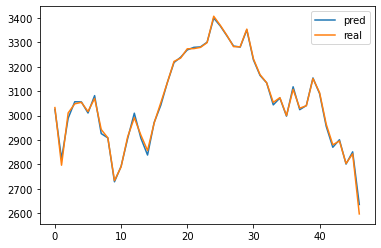

In [11]:
bmodel = TransformerTimeSeries(feature_dim = feature_dim,
                                  nhead = 4,num_layers = 12,d_model = 512,
                                  conv_len = 5,feature_weight = True,embedding_weight = True)
bmodel.load_state_dict(torch.load('AMZN'))
bmodel.to(device)
bmodel.eval()
with torch.no_grad(): # eliminate gradient i.e. gradients only exists in train()

    for step,(x,y,feature,attention_masks) in enumerate(test_dl):
        x = x.to(device)
        y = y.to(device)
        feature = feature.to(device)
        
        #y = torch.cat([y[:,0:5],torch.ones(47,1).cuda()],1)
        #feature = torch.cat([feature[:,:,0:5],torch.ones(47,90,1).cuda()],2)
        
        attention_masks = attention_masks.to(device)
        output = bmodel(x,y,feature,attention_masks[0])
        
        pred = data[train_size + 1 :-1,0]*0.01*(100+output[:,t0:].squeeze()).detach().cpu()
        real = data[train_size + 1 :-1,0]*0.01*(100+y[:,t0:].squeeze()).detach().cpu()

        plt.plot(pred)
        plt.plot(real)
        plt.legend(['pred','real'])
        MAE = torch.nn.L1Loss()(pred,real).item()
        MSE = torch.nn.MSELoss()(pred,real).item()
        RMSE = np.sqrt(MSE)
        
        print(f'AMZN MAE is {MAE}')
        print(f'AMZN MSE is {MSE}')
        print(f'AMZN RMSE is {RMSE}')

##### High

In [10]:
file_name = 'AMZN_features.csv'
with open(file_name) as f:
    data_list = csv.reader(f)
    data = []
    for row in data_list:
        data.append(row)
    f.close()
    
data = torch.tensor(np.delete(np.array(data)[1:,2:],4,axis = 1).astype(np.float)).type(torch.float)

feature_dim = data.shape[1] - 1
rate = []
for i in range(1,data.shape[0]):
    rate.append((100*(data[i,0:4] - data[i-1,0:4])/data[i-1,0:4]).reshape(1,4))
    
rate = torch.cat(rate)
rate_data = torch.cat([rate,data[1:,4:]],1)
train_size = int(data.shape[0]*0.9)
data_train = rate_data[0:train_size]
data_test = rate_data[train_size-4:]


t0 = 5
to_predict = 1
train_dataset = GetData(data_train[:,1],torch.cat([data_train[:,0].unsqueeze(1),data_train[:,2:]],1),t0 = t0, to_predict = to_predict)
test_dataset = GetData(data_test[:,1],torch.cat([data_test[:,0].unsqueeze(1),data_test[:,2:]],1),t0 = t0, to_predict = to_predict)
criterion = torch.nn.MSELoss()
# dataloaders
train_dl = DataLoader(train_dataset,batch_size=256,shuffle=True)
test_dl = DataLoader(test_dataset,batch_size=512)





model = TransformerTimeSeries(feature_dim = feature_dim,
                              nhead = 4,num_layers = 12,d_model = 512,
                              conv_len = 5,feature_weight = True,embedding_weight = True)
model = model.to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=1e-5 ,momentum = 0.9, nesterov = True)#Adam optimizer
#scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer,5e-7,3e-5,10,mode = 'exp_range',gamma = 0.9996)



train_epoch_loss = []
test_epoch_loss = []
test_best = 9999
for epoch in tqdm(range(4000)):


    l_t = train_epoch(model,train_dl,optimizer,t0,to_predict)

    train_loss = test_epoch(model,train_dl,t0,to_predict)


    test_loss = test_epoch(model,test_dl,t0,to_predict)


    if test_best > test_loss:
        test_best = test_loss
        torch.save(model.state_dict(), 'AMZN_H')



    train_epoch_loss.append(np.mean(train_loss))
    test_epoch_loss.append(test_loss)

    print("Epoch {}: Train loss: {} \t test loss: {}".format(epoch+1,
                                                             np.mean(train_loss),
                                                             test_loss))
    #scheduler.step()


torch.Size([431, 6])
torch.Size([431, 6])
torch.Size([47, 6])
torch.Size([47, 6])


  0%|                                                                                     | 0/4000 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1944: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
  0%|                                                                           | 1/4000 [00:03<3:21:51,  3.03s/it]

Epoch 1: Train loss: 1.544523644060104 	 test loss: 2.153156042098999


  0%|                                                                           | 2/4000 [00:09<5:27:15,  4.91s/it]

Epoch 2: Train loss: 1.4272484165333263 	 test loss: 2.01611590385437


  0%|                                                                           | 3/4000 [00:16<6:37:38,  5.97s/it]

Epoch 3: Train loss: 1.359562088607912 	 test loss: 1.9160916805267334


  0%|                                                                           | 4/4000 [00:23<6:54:58,  6.23s/it]

Epoch 4: Train loss: 1.3359590176916454 	 test loss: 1.860190510749817


  0%|                                                                           | 5/4000 [00:29<6:54:19,  6.22s/it]

Epoch 5: Train loss: 1.3377204939826735 	 test loss: 1.8309041261672974


  0%|                                                                           | 6/4000 [00:35<6:56:44,  6.26s/it]

Epoch 6: Train loss: 1.3392045276624145 	 test loss: 1.8184142112731934


  0%|▏                                                                          | 7/4000 [00:42<7:18:42,  6.59s/it]

Epoch 7: Train loss: 1.3313448561869752 	 test loss: 1.805716633796692


  0%|▏                                                                          | 8/4000 [00:49<7:19:01,  6.60s/it]

Epoch 8: Train loss: 1.3149308325796283 	 test loss: 1.7924138307571411


  0%|▏                                                                          | 9/4000 [00:55<7:05:09,  6.39s/it]

Epoch 9: Train loss: 1.2972106961252519 	 test loss: 1.7797210216522217


  0%|▏                                                                         | 11/4000 [01:02<5:09:39,  4.66s/it]

Epoch 10: Train loss: 1.2834283578146914 	 test loss: 1.7729206085205078
Epoch 11: Train loss: 1.2756798480337015 	 test loss: 1.7745457887649536


  0%|▏                                                                         | 12/4000 [01:02<3:38:13,  3.28s/it]

Epoch 12: Train loss: 1.2709215306903812 	 test loss: 1.7741062641143799


  0%|▏                                                                         | 13/4000 [01:09<4:39:55,  4.21s/it]

Epoch 13: Train loss: 1.2668073780298785 	 test loss: 1.7705652713775635


  0%|▎                                                                         | 14/4000 [01:16<5:34:39,  5.04s/it]

Epoch 14: Train loss: 1.2626908948415947 	 test loss: 1.765068531036377


  0%|▎                                                                         | 15/4000 [01:22<6:05:46,  5.51s/it]

Epoch 15: Train loss: 1.2578511564471606 	 test loss: 1.7570711374282837


  0%|▎                                                                         | 16/4000 [01:29<6:27:46,  5.84s/it]

Epoch 16: Train loss: 1.2520934545247018 	 test loss: 1.7467248439788818


  0%|▎                                                                         | 17/4000 [01:36<6:41:50,  6.05s/it]

Epoch 17: Train loss: 1.2456706073610522 	 test loss: 1.7341755628585815


  0%|▎                                                                         | 18/4000 [01:42<6:53:47,  6.23s/it]

Epoch 18: Train loss: 1.2393007936721059 	 test loss: 1.7212884426116943


  0%|▎                                                                         | 19/4000 [01:49<7:00:47,  6.34s/it]

Epoch 19: Train loss: 1.233369047016666 	 test loss: 1.7093615531921387


  0%|▎                                                                         | 20/4000 [01:55<7:05:29,  6.41s/it]

Epoch 20: Train loss: 1.2278077090699269 	 test loss: 1.699168086051941


  1%|▍                                                                         | 21/4000 [02:02<7:09:45,  6.48s/it]

Epoch 21: Train loss: 1.2224476572532388 	 test loss: 1.6894654035568237


  1%|▍                                                                         | 22/4000 [02:09<7:11:26,  6.51s/it]

Epoch 22: Train loss: 1.2174201874611272 	 test loss: 1.6808029413223267


  1%|▍                                                                         | 23/4000 [02:15<7:13:51,  6.55s/it]

Epoch 23: Train loss: 1.2127269224335036 	 test loss: 1.673019528388977


  1%|▍                                                                         | 24/4000 [02:22<7:14:52,  6.56s/it]

Epoch 24: Train loss: 1.2081396715270394 	 test loss: 1.665679931640625


  1%|▍                                                                         | 25/4000 [02:28<7:14:21,  6.56s/it]

Epoch 25: Train loss: 1.2034998318988597 	 test loss: 1.6582221984863281


  1%|▍                                                                         | 26/4000 [02:35<7:16:22,  6.59s/it]

Epoch 26: Train loss: 1.1992271557761456 	 test loss: 1.6519919633865356


  1%|▍                                                                         | 27/4000 [02:42<7:16:32,  6.59s/it]

Epoch 27: Train loss: 1.1949950254710258 	 test loss: 1.6457631587982178


  1%|▌                                                                         | 28/4000 [02:48<7:16:30,  6.59s/it]

Epoch 28: Train loss: 1.1909396122890392 	 test loss: 1.6401079893112183


  1%|▌                                                                         | 29/4000 [02:55<7:15:42,  6.58s/it]

Epoch 29: Train loss: 1.1867220246874817 	 test loss: 1.6340150833129883


  1%|▌                                                                         | 30/4000 [03:01<7:16:59,  6.60s/it]

Epoch 30: Train loss: 1.1823708670875035 	 test loss: 1.627738118171692


  1%|▌                                                                         | 31/4000 [03:08<7:16:17,  6.60s/it]

Epoch 31: Train loss: 1.178102855615992 	 test loss: 1.6218717098236084


  1%|▌                                                                         | 32/4000 [03:15<7:16:44,  6.60s/it]

Epoch 32: Train loss: 1.1733694416740932 	 test loss: 1.6148641109466553


  1%|▌                                                                         | 33/4000 [03:21<7:16:50,  6.61s/it]

Epoch 33: Train loss: 1.168592611211082 	 test loss: 1.6072447299957275


  1%|▋                                                                         | 34/4000 [03:28<7:13:21,  6.56s/it]

Epoch 34: Train loss: 1.1630714968572913 	 test loss: 1.5983054637908936


  1%|▋                                                                         | 35/4000 [03:34<7:17:27,  6.62s/it]

Epoch 35: Train loss: 1.1577661858910475 	 test loss: 1.5893770456314087


  1%|▋                                                                         | 36/4000 [03:41<7:17:02,  6.62s/it]

Epoch 36: Train loss: 1.1527430040377198 	 test loss: 1.580790638923645


  1%|▋                                                                         | 37/4000 [03:48<7:16:29,  6.61s/it]

Epoch 37: Train loss: 1.1478231464903759 	 test loss: 1.5723555088043213


  1%|▋                                                                         | 38/4000 [03:54<7:19:13,  6.65s/it]

Epoch 38: Train loss: 1.1424515258408479 	 test loss: 1.5630239248275757


  1%|▋                                                                         | 39/4000 [04:01<7:15:04,  6.59s/it]

Epoch 39: Train loss: 1.1375047646099896 	 test loss: 1.5552481412887573


  1%|▋                                                                         | 40/4000 [04:08<7:20:32,  6.67s/it]

Epoch 40: Train loss: 1.1325054298697381 	 test loss: 1.547501802444458


  1%|▊                                                                         | 41/4000 [04:13<7:01:03,  6.38s/it]

Epoch 41: Train loss: 1.1271422415487728 	 test loss: 1.5394601821899414


  1%|▊                                                                         | 42/4000 [04:21<7:17:06,  6.63s/it]

Epoch 42: Train loss: 1.1214851483944674 	 test loss: 1.5306931734085083


  1%|▊                                                                         | 43/4000 [04:27<7:17:13,  6.63s/it]

Epoch 43: Train loss: 1.1154211195328396 	 test loss: 1.5210312604904175


  1%|▊                                                                         | 44/4000 [04:34<7:17:23,  6.63s/it]

Epoch 44: Train loss: 1.109564934418539 	 test loss: 1.5116287469863892


  1%|▊                                                                         | 45/4000 [04:40<7:02:16,  6.41s/it]

Epoch 45: Train loss: 1.1033452801803978 	 test loss: 1.5017517805099487


  1%|▊                                                                         | 46/4000 [04:47<7:20:07,  6.68s/it]

Epoch 46: Train loss: 1.0975057627927953 	 test loss: 1.49186372756958


  1%|▊                                                                         | 47/4000 [04:53<7:12:04,  6.56s/it]

Epoch 47: Train loss: 1.091670630426252 	 test loss: 1.4821572303771973


  1%|▉                                                                         | 48/4000 [05:00<7:19:16,  6.67s/it]

Epoch 48: Train loss: 1.0855103216702313 	 test loss: 1.4718459844589233


  1%|▉                                                                         | 49/4000 [05:07<7:17:49,  6.65s/it]

Epoch 49: Train loss: 1.0796215583995987 	 test loss: 1.4616968631744385


  1%|▉                                                                         | 50/4000 [05:14<7:22:07,  6.72s/it]

Epoch 50: Train loss: 1.073878599153594 	 test loss: 1.4524235725402832


  1%|▉                                                                         | 51/4000 [05:20<7:19:25,  6.68s/it]

Epoch 51: Train loss: 1.0677232678694404 	 test loss: 1.4432528018951416


  1%|▉                                                                         | 52/4000 [05:27<7:16:14,  6.63s/it]

Epoch 52: Train loss: 1.0614327806331165 	 test loss: 1.4341728687286377


  1%|▉                                                                         | 53/4000 [05:33<7:12:30,  6.57s/it]

Epoch 53: Train loss: 1.0545774629110527 	 test loss: 1.4239639043807983


  1%|▉                                                                         | 54/4000 [05:40<7:12:56,  6.58s/it]

Epoch 54: Train loss: 1.047731060163051 	 test loss: 1.4135491847991943


  1%|█                                                                         | 55/4000 [05:47<7:13:25,  6.59s/it]

Epoch 55: Train loss: 1.0403983122788008 	 test loss: 1.4021573066711426


  1%|█                                                                         | 56/4000 [05:53<7:13:19,  6.59s/it]

Epoch 56: Train loss: 1.0330072017667464 	 test loss: 1.3906925916671753


  1%|█                                                                         | 57/4000 [06:00<7:13:15,  6.59s/it]

Epoch 57: Train loss: 1.0259534693096188 	 test loss: 1.3800122737884521


  1%|█                                                                         | 58/4000 [06:06<6:59:16,  6.38s/it]

Epoch 58: Train loss: 1.019128990145681 	 test loss: 1.3707811832427979


  1%|█                                                                         | 59/4000 [06:13<7:17:48,  6.67s/it]

Epoch 59: Train loss: 1.011768510889288 	 test loss: 1.3597040176391602


  2%|█                                                                         | 60/4000 [06:20<7:16:27,  6.65s/it]

Epoch 60: Train loss: 1.0044567549035057 	 test loss: 1.3487802743911743


  2%|█▏                                                                        | 61/4000 [06:26<7:15:29,  6.63s/it]

Epoch 61: Train loss: 0.9971908842604564 	 test loss: 1.3399144411087036


  2%|█▏                                                                        | 62/4000 [06:33<7:11:35,  6.58s/it]

Epoch 62: Train loss: 0.9908968196390953 	 test loss: 1.3317593336105347


  2%|█▏                                                                        | 63/4000 [06:39<7:15:16,  6.63s/it]

Epoch 63: Train loss: 0.983890686400252 	 test loss: 1.3226794004440308


  2%|█▏                                                                        | 64/4000 [06:46<7:13:30,  6.61s/it]

Epoch 64: Train loss: 0.9775059328278367 	 test loss: 1.3138136863708496


  2%|█▏                                                                        | 65/4000 [06:53<7:13:41,  6.61s/it]

Epoch 65: Train loss: 0.9713542451714695 	 test loss: 1.304602861404419


  2%|█▏                                                                        | 66/4000 [06:59<7:13:20,  6.61s/it]

Epoch 66: Train loss: 0.9648181891496663 	 test loss: 1.2948483228683472


  2%|█▏                                                                        | 67/4000 [07:06<7:13:08,  6.61s/it]

Epoch 67: Train loss: 0.958619888724971 	 test loss: 1.2855091094970703


  2%|█▎                                                                        | 68/4000 [07:12<7:11:43,  6.59s/it]

Epoch 68: Train loss: 0.9523027117457025 	 test loss: 1.2758631706237793


  2%|█▎                                                                        | 69/4000 [07:19<7:13:42,  6.62s/it]

Epoch 69: Train loss: 0.9466119021384732 	 test loss: 1.2675189971923828


  2%|█▎                                                                        | 70/4000 [07:26<7:13:04,  6.61s/it]

Epoch 70: Train loss: 0.9413424076171043 	 test loss: 1.2599265575408936


  2%|█▎                                                                        | 71/4000 [07:32<7:12:45,  6.61s/it]

Epoch 71: Train loss: 0.9362286952974624 	 test loss: 1.2528523206710815


  2%|█▎                                                                        | 72/4000 [07:39<7:12:56,  6.61s/it]

Epoch 72: Train loss: 0.9314024181487666 	 test loss: 1.2462966442108154


  2%|█▎                                                                        | 73/4000 [07:45<7:12:26,  6.61s/it]

Epoch 73: Train loss: 0.926850212422435 	 test loss: 1.2406842708587646


  2%|█▎                                                                        | 74/4000 [07:52<7:11:01,  6.59s/it]

Epoch 74: Train loss: 0.9229645334927499 	 test loss: 1.2372045516967773


  2%|█▍                                                                        | 75/4000 [07:59<7:12:25,  6.61s/it]

Epoch 75: Train loss: 0.9182108076431912 	 test loss: 1.2310562133789062


  2%|█▍                                                                        | 76/4000 [08:05<7:11:44,  6.60s/it]

Epoch 76: Train loss: 0.9131744066966382 	 test loss: 1.221209168434143


  2%|█▍                                                                        | 77/4000 [08:12<7:12:02,  6.61s/it]

Epoch 77: Train loss: 0.9096345786705371 	 test loss: 1.210227370262146


  2%|█▍                                                                        | 78/4000 [08:18<7:11:14,  6.60s/it]

Epoch 78: Train loss: 0.9063128477736029 	 test loss: 1.202775239944458


  2%|█▍                                                                        | 79/4000 [08:25<7:11:38,  6.61s/it]

Epoch 79: Train loss: 0.902764547866901 	 test loss: 1.1958106756210327


  2%|█▍                                                                        | 80/4000 [08:32<7:11:40,  6.61s/it]

Epoch 80: Train loss: 0.8989398621904324 	 test loss: 1.1898444890975952


  2%|█▍                                                                        | 81/4000 [08:38<7:11:27,  6.61s/it]

Epoch 81: Train loss: 0.8959982598464064 	 test loss: 1.182579517364502


  2%|█▌                                                                        | 82/4000 [08:45<7:11:17,  6.60s/it]

Epoch 82: Train loss: 0.8922279360952621 	 test loss: 1.1757129430770874


  2%|█▌                                                                        | 83/4000 [08:51<7:10:59,  6.60s/it]

Epoch 83: Train loss: 0.8877729236941326 	 test loss: 1.1696268320083618


  2%|█▌                                                                        | 84/4000 [08:58<7:11:04,  6.60s/it]

Epoch 84: Train loss: 0.8831713494181357 	 test loss: 1.1638039350509644


  2%|█▌                                                                        | 85/4000 [09:05<7:10:55,  6.60s/it]

Epoch 85: Train loss: 0.8787263150558118 	 test loss: 1.1570699214935303


  2%|█▌                                                                        | 86/4000 [09:11<7:10:46,  6.60s/it]

Epoch 86: Train loss: 0.8741934511058569 	 test loss: 1.1510651111602783


  2%|█▌                                                                        | 87/4000 [09:18<7:10:38,  6.60s/it]

Epoch 87: Train loss: 0.8690348816581779 	 test loss: 1.1460810899734497


  2%|█▋                                                                        | 88/4000 [09:24<7:09:57,  6.59s/it]

Epoch 88: Train loss: 0.8641087300816157 	 test loss: 1.139760136604309


  2%|█▋                                                                        | 89/4000 [09:31<7:09:47,  6.59s/it]

Epoch 89: Train loss: 0.860416093447922 	 test loss: 1.131471872329712


  2%|█▋                                                                        | 90/4000 [09:38<7:10:39,  6.61s/it]

Epoch 90: Train loss: 0.8569561151783317 	 test loss: 1.1226463317871094


  2%|█▋                                                                        | 91/4000 [09:44<7:14:54,  6.68s/it]

Epoch 91: Train loss: 0.851682519414862 	 test loss: 1.1159472465515137


  2%|█▋                                                                        | 92/4000 [09:51<7:08:29,  6.58s/it]

Epoch 92: Train loss: 0.8450971516821612 	 test loss: 1.1102490425109863


  2%|█▋                                                                        | 93/4000 [09:57<7:08:54,  6.59s/it]

Epoch 93: Train loss: 0.8393627479845299 	 test loss: 1.1030555963516235


  2%|█▋                                                                        | 94/4000 [10:04<7:08:44,  6.59s/it]

Epoch 94: Train loss: 0.8338494190207214 	 test loss: 1.0961605310440063


  2%|█▊                                                                        | 95/4000 [10:11<7:09:21,  6.60s/it]

Epoch 95: Train loss: 0.8284804715911086 	 test loss: 1.089058756828308


  2%|█▊                                                                        | 96/4000 [10:17<7:13:12,  6.66s/it]

Epoch 96: Train loss: 0.8230731639397393 	 test loss: 1.0819637775421143


  2%|█▊                                                                        | 97/4000 [10:24<7:13:16,  6.66s/it]

Epoch 97: Train loss: 0.8174620368917691 	 test loss: 1.0754221677780151


  2%|█▊                                                                        | 98/4000 [10:30<7:07:21,  6.57s/it]

Epoch 98: Train loss: 0.8127053316397346 	 test loss: 1.0677917003631592


  2%|█▊                                                                        | 99/4000 [10:37<7:06:59,  6.57s/it]

Epoch 99: Train loss: 0.807539225316103 	 test loss: 1.0602145195007324


  2%|█▊                                                                       | 100/4000 [10:44<7:08:13,  6.59s/it]

Epoch 100: Train loss: 0.8036555389240557 	 test loss: 1.05101478099823


  3%|█▊                                                                       | 101/4000 [10:50<6:55:26,  6.39s/it]

Epoch 101: Train loss: 0.8016085368851221 	 test loss: 1.0402191877365112


  3%|█▊                                                                       | 102/4000 [10:57<7:12:24,  6.66s/it]

Epoch 102: Train loss: 0.7980899673880114 	 test loss: 1.0307127237319946


  3%|█▉                                                                       | 103/4000 [11:03<7:11:19,  6.64s/it]

Epoch 103: Train loss: 0.7897916570340398 	 test loss: 1.0255752801895142


  3%|█▉                                                                       | 104/4000 [11:10<7:10:40,  6.63s/it]

Epoch 104: Train loss: 0.7830095773783194 	 test loss: 1.0216063261032104


  3%|█▉                                                                       | 105/4000 [11:17<7:09:57,  6.62s/it]

Epoch 105: Train loss: 0.7774073328053591 	 test loss: 1.0143402814865112


  3%|█▉                                                                       | 106/4000 [11:23<7:09:18,  6.61s/it]

Epoch 106: Train loss: 0.7716014742021494 	 test loss: 1.007001280784607


  3%|█▉                                                                       | 107/4000 [11:30<7:10:38,  6.64s/it]

Epoch 107: Train loss: 0.7661331362348145 	 test loss: 0.9973020553588867


  3%|█▉                                                                       | 108/4000 [11:36<7:08:25,  6.60s/it]

Epoch 108: Train loss: 0.7596561564370263 	 test loss: 0.9895960092544556


  3%|█▉                                                                       | 109/4000 [11:42<6:55:19,  6.40s/it]

Epoch 109: Train loss: 0.7530813065039863 	 test loss: 0.9812802076339722


  3%|██                                                                       | 110/4000 [11:50<7:11:59,  6.66s/it]

Epoch 110: Train loss: 0.7471018971533897 	 test loss: 0.9724076986312866


  3%|██                                                                       | 111/4000 [11:56<7:04:13,  6.54s/it]

Epoch 111: Train loss: 0.7416299689396905 	 test loss: 0.9662438035011292


  3%|██                                                                       | 112/4000 [12:03<7:10:32,  6.64s/it]

Epoch 112: Train loss: 0.7382608921787855 	 test loss: 0.954509973526001


  3%|██                                                                       | 113/4000 [12:09<7:10:38,  6.65s/it]

Epoch 113: Train loss: 0.7323087505010883 	 test loss: 0.9478744864463806


  3%|██                                                                       | 114/4000 [12:16<7:14:29,  6.71s/it]

Epoch 114: Train loss: 0.7265526957965506 	 test loss: 0.9429207444190979


  3%|██                                                                       | 115/4000 [12:23<7:07:54,  6.61s/it]

Epoch 115: Train loss: 0.7217239444327742 	 test loss: 0.9365463256835938


  3%|██                                                                       | 116/4000 [12:29<7:07:03,  6.60s/it]

Epoch 116: Train loss: 0.7176009406899632 	 test loss: 0.926692545413971


  3%|██▏                                                                      | 117/4000 [12:36<7:04:38,  6.56s/it]

Epoch 117: Train loss: 0.714274756454813 	 test loss: 0.9172999262809753


  3%|██▏                                                                      | 118/4000 [12:42<6:55:28,  6.42s/it]

Epoch 118: Train loss: 0.709088848389495 	 test loss: 0.9121143817901611


  3%|██▏                                                                      | 119/4000 [12:48<6:57:29,  6.45s/it]

Epoch 119: Train loss: 0.7047069223463673 	 test loss: 0.9058638215065002


  3%|██▏                                                                      | 120/4000 [12:56<7:14:33,  6.72s/it]

Epoch 120: Train loss: 0.699805036498333 	 test loss: 0.8982549905776978


  3%|██▏                                                                      | 121/4000 [13:03<7:16:58,  6.76s/it]

Epoch 121: Train loss: 0.6951541088849928 	 test loss: 0.8897286057472229


  3%|██▏                                                                      | 122/4000 [13:09<7:02:21,  6.53s/it]

Epoch 122: Train loss: 0.6899880443261007 	 test loss: 0.8835076689720154


  3%|██▏                                                                      | 123/4000 [13:16<7:10:00,  6.65s/it]

Epoch 123: Train loss: 0.6845462279364017 	 test loss: 0.8779261708259583


  3%|██▎                                                                      | 124/4000 [13:22<7:08:20,  6.63s/it]

Epoch 124: Train loss: 0.6797637196815207 	 test loss: 0.8712248802185059


  3%|██▎                                                                      | 125/4000 [13:29<7:06:28,  6.60s/it]

Epoch 125: Train loss: 0.6759458423490591 	 test loss: 0.8631938695907593


  3%|██▎                                                                      | 126/4000 [13:35<7:07:58,  6.63s/it]

Epoch 126: Train loss: 0.6696692671963898 	 test loss: 0.8575714230537415


  3%|██▎                                                                      | 127/4000 [13:42<7:07:34,  6.62s/it]

Epoch 127: Train loss: 0.663972249163829 	 test loss: 0.85194331407547


  3%|██▎                                                                      | 128/4000 [13:48<7:04:04,  6.57s/it]

Epoch 128: Train loss: 0.6590002964654821 	 test loss: 0.8447991013526917


  3%|██▎                                                                      | 129/4000 [13:55<7:06:58,  6.62s/it]

Epoch 129: Train loss: 0.6546620219046998 	 test loss: 0.8371300101280212


  3%|██▎                                                                      | 130/4000 [14:02<7:06:35,  6.61s/it]

Epoch 130: Train loss: 0.6493117117826457 	 test loss: 0.8315109610557556


  3%|██▍                                                                      | 131/4000 [14:08<7:06:39,  6.62s/it]

Epoch 131: Train loss: 0.6444652564564326 	 test loss: 0.8246698379516602


  3%|██▍                                                                      | 132/4000 [14:15<7:05:40,  6.60s/it]

Epoch 132: Train loss: 0.6404251143716604 	 test loss: 0.8176548480987549


  3%|██▍                                                                      | 133/4000 [14:22<7:05:46,  6.61s/it]

Epoch 133: Train loss: 0.6351019789890457 	 test loss: 0.8125404715538025


  3%|██▍                                                                      | 134/4000 [14:28<7:04:37,  6.59s/it]

Epoch 134: Train loss: 0.6306968793238399 	 test loss: 0.8066011667251587


  3%|██▍                                                                      | 135/4000 [14:35<7:06:20,  6.62s/it]

Epoch 135: Train loss: 0.6255197865227259 	 test loss: 0.798571765422821


  3%|██▍                                                                      | 136/4000 [14:41<7:05:45,  6.61s/it]

Epoch 136: Train loss: 0.6218470831481597 	 test loss: 0.7916496396064758


  3%|██▌                                                                      | 137/4000 [14:48<7:05:40,  6.61s/it]

Epoch 137: Train loss: 0.6166509521256467 	 test loss: 0.7860977053642273


  3%|██▌                                                                      | 138/4000 [14:55<7:05:00,  6.60s/it]

Epoch 138: Train loss: 0.6095187355636721 	 test loss: 0.7797194719314575


  3%|██▌                                                                      | 139/4000 [15:01<7:05:19,  6.61s/it]

Epoch 139: Train loss: 0.6058608404168396 	 test loss: 0.7761249542236328


  4%|██▌                                                                      | 140/4000 [15:08<7:04:52,  6.60s/it]

Epoch 140: Train loss: 0.6013820547515444 	 test loss: 0.769037127494812


  4%|██▌                                                                      | 141/4000 [15:14<7:04:53,  6.61s/it]

Epoch 141: Train loss: 0.5942254142528897 	 test loss: 0.7637901902198792


  4%|██▌                                                                      | 142/4000 [15:21<7:03:35,  6.59s/it]

Epoch 142: Train loss: 0.5875714761475123 	 test loss: 0.7568570375442505


  4%|██▌                                                                      | 143/4000 [15:28<7:04:46,  6.61s/it]

Epoch 143: Train loss: 0.5819217352468841 	 test loss: 0.7508567571640015


  4%|██▋                                                                      | 144/4000 [15:34<7:04:37,  6.61s/it]

Epoch 144: Train loss: 0.5774322947327333 	 test loss: 0.7451814413070679


  4%|██▋                                                                      | 145/4000 [15:41<7:04:37,  6.61s/it]

Epoch 145: Train loss: 0.5727690855201049 	 test loss: 0.7388266324996948


  4%|██▋                                                                      | 146/4000 [15:47<7:03:46,  6.60s/it]

Epoch 146: Train loss: 0.5681915854356682 	 test loss: 0.7323214411735535


  4%|██▋                                                                      | 147/4000 [15:54<6:57:44,  6.51s/it]

Epoch 147: Train loss: 0.5639955239616801 	 test loss: 0.7244462966918945


  4%|██▋                                                                      | 148/4000 [16:01<7:04:24,  6.61s/it]

Epoch 148: Train loss: 0.559484633658159 	 test loss: 0.7185401916503906


  4%|██▋                                                                      | 149/4000 [16:07<6:52:19,  6.42s/it]

Epoch 149: Train loss: 0.555381888303292 	 test loss: 0.7128491997718811


  4%|██▋                                                                      | 150/4000 [16:14<7:08:25,  6.68s/it]

Epoch 150: Train loss: 0.5521755356799699 	 test loss: 0.7073224186897278


  4%|██▊                                                                      | 151/4000 [16:20<7:07:17,  6.66s/it]

Epoch 151: Train loss: 0.5479844525076121 	 test loss: 0.7005208134651184


  4%|██▊                                                                      | 152/4000 [16:27<7:05:52,  6.64s/it]

Epoch 152: Train loss: 0.5441890804231029 	 test loss: 0.6948655247688293


  4%|██▊                                                                      | 153/4000 [16:34<7:05:26,  6.64s/it]

Epoch 153: Train loss: 0.5405196127094968 	 test loss: 0.6899392008781433


  4%|██▊                                                                      | 154/4000 [16:40<7:04:56,  6.63s/it]

Epoch 154: Train loss: 0.5370353153299566 	 test loss: 0.684076189994812


  4%|██▊                                                                      | 155/4000 [16:47<7:04:18,  6.62s/it]

Epoch 155: Train loss: 0.5340719837047108 	 test loss: 0.6774607300758362


  4%|██▊                                                                      | 156/4000 [16:53<7:03:40,  6.61s/it]

Epoch 156: Train loss: 0.5304653876203949 	 test loss: 0.6712374091148376


  4%|██▊                                                                      | 157/4000 [17:00<7:03:43,  6.62s/it]

Epoch 157: Train loss: 0.5263365939985571 	 test loss: 0.6650685667991638


  4%|██▉                                                                      | 158/4000 [17:06<6:50:10,  6.41s/it]

Epoch 158: Train loss: 0.5236432492871296 	 test loss: 0.6588395237922668


  4%|██▉                                                                      | 159/4000 [17:13<7:05:53,  6.65s/it]

Epoch 159: Train loss: 0.5204584646944104 	 test loss: 0.6533280611038208


  4%|██▉                                                                      | 160/4000 [17:20<7:04:36,  6.63s/it]

Epoch 160: Train loss: 0.5177908924920377 	 test loss: 0.6499104499816895


  4%|██▉                                                                      | 161/4000 [17:26<7:04:53,  6.64s/it]

Epoch 161: Train loss: 0.5135170892053856 	 test loss: 0.6439121961593628


  4%|██▉                                                                      | 162/4000 [17:33<7:04:01,  6.63s/it]

Epoch 162: Train loss: 0.5086947133950457 	 test loss: 0.637348473072052


  4%|██▉                                                                      | 163/4000 [17:40<7:03:24,  6.62s/it]

Epoch 163: Train loss: 0.505552037962628 	 test loss: 0.6314054131507874


  4%|██▉                                                                      | 164/4000 [17:46<7:00:24,  6.58s/it]

Epoch 164: Train loss: 0.5023575308981185 	 test loss: 0.6307855248451233


  4%|███                                                                      | 165/4000 [17:53<7:01:35,  6.60s/it]

Epoch 165: Train loss: 0.5012155904017579 	 test loss: 0.6299039125442505


  4%|███                                                                      | 166/4000 [17:59<7:03:24,  6.63s/it]

Epoch 166: Train loss: 0.4971455229130809 	 test loss: 0.6240260601043701


  4%|███                                                                      | 167/4000 [18:06<7:02:15,  6.61s/it]

Epoch 167: Train loss: 0.49170993168226806 	 test loss: 0.6158930659294128


  4%|███                                                                      | 168/4000 [18:12<6:50:00,  6.42s/it]

Epoch 168: Train loss: 0.48757856441207936 	 test loss: 0.61207515001297


  4%|███                                                                      | 170/4000 [18:19<5:00:46,  4.71s/it]

Epoch 169: Train loss: 0.4858108598505538 	 test loss: 0.6109718084335327
Epoch 170: Train loss: 0.48424319380120723 	 test loss: 0.6137235164642334


  4%|███                                                                      | 171/4000 [18:26<5:33:27,  5.23s/it]

Epoch 171: Train loss: 0.47787160220666164 	 test loss: 0.6046445369720459


  4%|███▏                                                                     | 172/4000 [18:32<6:00:43,  5.65s/it]

Epoch 172: Train loss: 0.4721110695476045 	 test loss: 0.5976079702377319


  4%|███▏                                                                     | 173/4000 [18:39<6:17:57,  5.93s/it]

Epoch 173: Train loss: 0.4697224197006004 	 test loss: 0.5934866666793823


  4%|███▏                                                                     | 174/4000 [18:45<6:18:51,  5.94s/it]

Epoch 174: Train loss: 0.4662704265172963 	 test loss: 0.5907377004623413


  4%|███▏                                                                     | 175/4000 [18:52<6:44:24,  6.34s/it]

Epoch 175: Train loss: 0.4624775778804744 	 test loss: 0.5873531103134155


  4%|███▏                                                                     | 176/4000 [18:59<6:48:50,  6.41s/it]

Epoch 176: Train loss: 0.4617623566474826 	 test loss: 0.5866614580154419


  4%|███▏                                                                     | 177/4000 [19:05<6:52:31,  6.47s/it]

Epoch 177: Train loss: 0.45830053803262466 	 test loss: 0.5827322602272034


  4%|███▎                                                                     | 179/4000 [19:12<4:56:17,  4.65s/it]

Epoch 178: Train loss: 0.4526509287185846 	 test loss: 0.5766915678977966
Epoch 179: Train loss: 0.4504071599231242 	 test loss: 0.5772604942321777


  4%|███▎                                                                     | 180/4000 [19:13<3:30:10,  3.30s/it]

Epoch 180: Train loss: 0.45131962882946924 	 test loss: 0.578119695186615


  5%|███▎                                                                     | 181/4000 [19:18<4:15:54,  4.02s/it]

Epoch 181: Train loss: 0.4444729133990967 	 test loss: 0.5713273286819458


  5%|███▎                                                                     | 183/4000 [19:25<3:38:22,  3.43s/it]

Epoch 182: Train loss: 0.43950321834767775 	 test loss: 0.5665886998176575
Epoch 183: Train loss: 0.44349645102383645 	 test loss: 0.5730932950973511


  5%|███▎                                                                     | 184/4000 [19:25<2:35:28,  2.44s/it]

Epoch 184: Train loss: 0.4473345671065169 	 test loss: 0.5790848135948181


  5%|███▍                                                                     | 185/4000 [19:32<3:59:17,  3.76s/it]

Epoch 185: Train loss: 0.43074676422121355 	 test loss: 0.5550827383995056


  5%|███▍                                                                     | 186/4000 [19:39<4:53:33,  4.62s/it]

Epoch 186: Train loss: 0.42661683963235736 	 test loss: 0.5485735535621643


  5%|███▍                                                                     | 188/4000 [19:45<3:53:39,  3.68s/it]

Epoch 187: Train loss: 0.42447811123113344 	 test loss: 0.5472826957702637
Epoch 188: Train loss: 0.42530993664347655 	 test loss: 0.5481165647506714


  5%|███▍                                                                     | 190/4000 [19:46<1:58:56,  1.87s/it]

Epoch 189: Train loss: 0.43497228484142686 	 test loss: 0.563296377658844
Epoch 190: Train loss: 0.42753290632208096 	 test loss: 0.5540289282798767


  5%|███▍                                                                     | 191/4000 [19:52<3:16:37,  3.10s/it]

Epoch 191: Train loss: 0.42192731808067196 	 test loss: 0.5460593104362488


  5%|███▌                                                                     | 192/4000 [19:59<4:29:37,  4.25s/it]

Epoch 192: Train loss: 0.415906739691294 	 test loss: 0.5325261950492859


  5%|███▌                                                                     | 193/4000 [20:05<5:12:37,  4.93s/it]

Epoch 193: Train loss: 0.4147642558384384 	 test loss: 0.5290531516075134


  5%|███▌                                                                     | 195/4000 [20:12<4:04:48,  3.86s/it]

Epoch 194: Train loss: 0.41264026361385797 	 test loss: 0.52769535779953
Epoch 195: Train loss: 0.4111439054637387 	 test loss: 0.5289154648780823


  5%|███▌                                                                     | 196/4000 [20:12<2:53:57,  2.74s/it]

Epoch 196: Train loss: 0.41141263805243367 	 test loss: 0.531684935092926


  5%|███▌                                                                     | 197/4000 [20:18<3:49:42,  3.62s/it]

Epoch 197: Train loss: 0.4068190346876043 	 test loss: 0.5258613228797913


  5%|███▋                                                                     | 199/4000 [20:25<3:31:38,  3.34s/it]

Epoch 198: Train loss: 0.403172091790529 	 test loss: 0.5257834196090698
Epoch 199: Train loss: 0.4045412676655223 	 test loss: 0.5330382585525513


  5%|███▋                                                                     | 201/4000 [20:25<1:48:09,  1.71s/it]

Epoch 200: Train loss: 0.4013107371302602 	 test loss: 0.5318925380706787
Epoch 201: Train loss: 0.4039027619666124 	 test loss: 0.5367165803909302


  5%|███▊                                                                       | 203/4000 [20:26<57:27,  1.10it/s]

Epoch 202: Train loss: 0.39960368112455663 	 test loss: 0.5305393934249878
Epoch 203: Train loss: 0.39771343446109797 	 test loss: 0.5289724469184875


  5%|███▊                                                                       | 204/4000 [20:26<42:50,  1.48it/s]

Epoch 204: Train loss: 0.39459806722167473 	 test loss: 0.5265436768531799


  5%|███▋                                                                     | 205/4000 [20:32<2:19:47,  2.21s/it]

Epoch 205: Train loss: 0.39333735803993564 	 test loss: 0.5245476961135864


  5%|███▊                                                                     | 206/4000 [20:39<3:47:48,  3.60s/it]

Epoch 206: Train loss: 0.3863093993365073 	 test loss: 0.5120952725410461


  5%|███▊                                                                     | 208/4000 [20:45<3:18:48,  3.15s/it]

Epoch 207: Train loss: 0.3843849909831089 	 test loss: 0.5092443227767944
Epoch 208: Train loss: 0.3888950921819824 	 test loss: 0.5180091857910156


  5%|███▊                                                                     | 210/4000 [20:45<1:42:02,  1.62s/it]

Epoch 209: Train loss: 0.39013909429242605 	 test loss: 0.5228621959686279
Epoch 210: Train loss: 0.3947297203291873 	 test loss: 0.528969407081604


  5%|███▊                                                                     | 211/4000 [20:45<1:14:02,  1.17s/it]

Epoch 211: Train loss: 0.383792560020345 	 test loss: 0.5133908987045288


  5%|███▊                                                                     | 212/4000 [20:51<2:45:26,  2.62s/it]

Epoch 212: Train loss: 0.3810476507913762 	 test loss: 0.5086325407028198


  5%|███▉                                                                     | 213/4000 [20:58<4:01:25,  3.83s/it]

Epoch 213: Train loss: 0.37771629042525856 	 test loss: 0.5031881332397461


  5%|███▉                                                                     | 214/4000 [21:05<4:53:32,  4.65s/it]

Epoch 214: Train loss: 0.37665416241521904 	 test loss: 0.5010690093040466


  5%|███▉                                                                     | 216/4000 [21:12<3:56:12,  3.75s/it]

Epoch 215: Train loss: 0.37425596144249157 	 test loss: 0.49846240878105164
Epoch 216: Train loss: 0.3758469117489879 	 test loss: 0.5037112832069397


  5%|███▉                                                                     | 218/4000 [21:12<2:00:09,  1.91s/it]

Epoch 217: Train loss: 0.3737606381318962 	 test loss: 0.5020495057106018
Epoch 218: Train loss: 0.37143262674526384 	 test loss: 0.49926242232322693


  5%|███▉                                                                     | 219/4000 [21:18<3:11:32,  3.04s/it]

Epoch 219: Train loss: 0.3684161802593904 	 test loss: 0.49553894996643066


  6%|████                                                                     | 220/4000 [21:24<4:24:44,  4.20s/it]

Epoch 220: Train loss: 0.36594917651118924 	 test loss: 0.4933074712753296


  6%|████                                                                     | 221/4000 [21:31<5:10:23,  4.93s/it]

Epoch 221: Train loss: 0.3631694253940317 	 test loss: 0.4908318817615509


  6%|████                                                                     | 222/4000 [21:38<5:41:50,  5.43s/it]

Epoch 222: Train loss: 0.36243290193119626 	 test loss: 0.4901006817817688


  6%|████                                                                     | 223/4000 [21:44<6:03:12,  5.77s/it]

Epoch 223: Train loss: 0.3570698999611795 	 test loss: 0.48275819420814514


  6%|████                                                                     | 225/4000 [21:51<4:28:10,  4.26s/it]

Epoch 224: Train loss: 0.3541046400357842 	 test loss: 0.4774211049079895
Epoch 225: Train loss: 0.35514480394166476 	 test loss: 0.48316362500190735


  6%|████▏                                                                    | 227/4000 [21:51<2:15:46,  2.16s/it]

Epoch 226: Train loss: 0.3560319663200467 	 test loss: 0.48588284850120544
Epoch 227: Train loss: 0.3547349465695445 	 test loss: 0.48592379689216614


  6%|████▏                                                                    | 229/4000 [21:52<1:10:55,  1.13s/it]

Epoch 228: Train loss: 0.35501045839139317 	 test loss: 0.490134596824646
Epoch 229: Train loss: 0.350932162142685 	 test loss: 0.482278048992157


  6%|████▏                                                                    | 230/4000 [21:57<2:35:08,  2.47s/it]

Epoch 230: Train loss: 0.34591043182149567 	 test loss: 0.47246822714805603


  6%|████▏                                                                    | 232/4000 [22:04<2:49:38,  2.70s/it]

Epoch 231: Train loss: 0.3433770775933277 	 test loss: 0.46811115741729736
Epoch 232: Train loss: 0.34694799338305354 	 test loss: 0.4773896634578705


  6%|████▎                                                                    | 234/4000 [22:04<1:27:30,  1.39s/it]

Epoch 233: Train loss: 0.34967056871013685 	 test loss: 0.482412189245224
Epoch 234: Train loss: 0.3484597632060748 	 test loss: 0.4831751883029938


  6%|████▎                                                                    | 235/4000 [22:05<1:03:50,  1.02s/it]

Epoch 235: Train loss: 0.3413562314139718 	 test loss: 0.4710962176322937


  6%|████▎                                                                    | 237/4000 [22:11<1:53:57,  1.82s/it]

Epoch 236: Train loss: 0.33983889588623756 	 test loss: 0.467888742685318
Epoch 237: Train loss: 0.3421372085325679 	 test loss: 0.47219234704971313


  6%|████▎                                                                    | 239/4000 [22:11<1:00:15,  1.04it/s]

Epoch 238: Train loss: 0.34530372201981513 	 test loss: 0.4783351719379425
Epoch 239: Train loss: 0.34599586906399915 	 test loss: 0.4804418385028839


  6%|████▌                                                                      | 240/4000 [22:11<44:49,  1.40it/s]

Epoch 240: Train loss: 0.3378013028761074 	 test loss: 0.46883922815322876


  6%|████▍                                                                    | 241/4000 [22:17<2:12:31,  2.12s/it]

Epoch 241: Train loss: 0.33477269489914524 	 test loss: 0.46491798758506775


  6%|████▍                                                                    | 242/4000 [22:24<3:49:08,  3.66s/it]

Epoch 242: Train loss: 0.3329517185134843 	 test loss: 0.4625135660171509


  6%|████▍                                                                    | 243/4000 [22:30<4:41:27,  4.49s/it]

Epoch 243: Train loss: 0.33000922977509467 	 test loss: 0.45711126923561096


  6%|████▍                                                                    | 245/4000 [22:37<3:49:26,  3.67s/it]

Epoch 244: Train loss: 0.3290687816740465 	 test loss: 0.4559163749217987
Epoch 245: Train loss: 0.3338717228436968 	 test loss: 0.4648812413215637


  6%|████▌                                                                    | 247/4000 [22:38<1:56:48,  1.87s/it]

Epoch 246: Train loss: 0.33008768442335373 	 test loss: 0.46016576886177063
Epoch 247: Train loss: 0.32981044524230424 	 test loss: 0.46051567792892456


  6%|████▌                                                                    | 248/4000 [22:44<3:17:30,  3.16s/it]

Epoch 248: Train loss: 0.3237929940915163 	 test loss: 0.4481680989265442


  6%|████▌                                                                    | 249/4000 [22:50<4:21:31,  4.18s/it]

Epoch 249: Train loss: 0.32024863950061133 	 test loss: 0.44169631600379944


  6%|████▌                                                                    | 251/4000 [22:57<3:37:45,  3.48s/it]

Epoch 250: Train loss: 0.31824942074906243 	 test loss: 0.44070351123809814
Epoch 251: Train loss: 0.32342908256568376 	 test loss: 0.45422548055648804


  6%|████▌                                                                    | 253/4000 [22:57<1:51:04,  1.78s/it]

Epoch 252: Train loss: 0.3367777632726594 	 test loss: 0.46957308053970337
Epoch 253: Train loss: 0.3282651271316679 	 test loss: 0.46056684851646423


  6%|████▊                                                                      | 255/4000 [22:58<58:48,  1.06it/s]

Epoch 254: Train loss: 0.3218864558606026 	 test loss: 0.4518749713897705
Epoch 255: Train loss: 0.32131906444954483 	 test loss: 0.45061948895454407


  6%|████▊                                                                      | 257/4000 [22:58<33:12,  1.88it/s]

Epoch 256: Train loss: 0.32034259066504284 	 test loss: 0.4505211412906647
Epoch 257: Train loss: 0.317272170652093 	 test loss: 0.44575777649879456


  6%|████▊                                                                      | 258/4000 [22:58<25:52,  2.41it/s]

Epoch 258: Train loss: 0.316444082907347 	 test loss: 0.44404467940330505


  6%|████▋                                                                    | 260/4000 [23:03<1:18:40,  1.26s/it]

Epoch 259: Train loss: 0.3151420221389585 	 test loss: 0.44040971994400024
Epoch 260: Train loss: 0.3201074219220199 	 test loss: 0.4497246742248535


  7%|████▉                                                                      | 261/4000 [23:03<57:45,  1.08it/s]

Epoch 261: Train loss: 0.32120221424545325 	 test loss: 0.45139279961586


  7%|████▊                                                                    | 262/4000 [23:10<2:50:29,  2.74s/it]

Epoch 262: Train loss: 0.3123650890353661 	 test loss: 0.43925100564956665


  7%|████▊                                                                    | 263/4000 [23:17<4:00:06,  3.86s/it]

Epoch 263: Train loss: 0.30842418536509275 	 test loss: 0.43259310722351074


  7%|████▊                                                                    | 265/4000 [23:24<3:28:44,  3.35s/it]

Epoch 264: Train loss: 0.3095702199814214 	 test loss: 0.43246060609817505
Epoch 265: Train loss: 0.3138918156828515 	 test loss: 0.44031012058258057


  7%|████▊                                                                    | 267/4000 [23:24<1:46:38,  1.71s/it]

Epoch 266: Train loss: 0.3124457738100791 	 test loss: 0.4402464032173157
Epoch 267: Train loss: 0.3144907808912326 	 test loss: 0.4437568187713623


  7%|█████                                                                      | 269/4000 [23:24<56:37,  1.10it/s]

Epoch 268: Train loss: 0.31309380249191604 	 test loss: 0.44263699650764465
Epoch 269: Train loss: 0.30973689600375853 	 test loss: 0.44113534688949585


  7%|█████                                                                      | 270/4000 [23:24<42:11,  1.47it/s]

Epoch 270: Train loss: 0.3056850814349137 	 test loss: 0.436114639043808


  7%|████▉                                                                    | 271/4000 [23:30<2:16:45,  2.20s/it]

Epoch 271: Train loss: 0.3014478969739927 	 test loss: 0.43234896659851074


  7%|████▉                                                                    | 272/4000 [23:36<3:37:12,  3.50s/it]

Epoch 272: Train loss: 0.3003749175995519 	 test loss: 0.4292101263999939


  7%|█████                                                                    | 274/4000 [23:43<3:16:17,  3.16s/it]

Epoch 273: Train loss: 0.2961393748939452 	 test loss: 0.4177054464817047
Epoch 274: Train loss: 0.30090559877265083 	 test loss: 0.4252079725265503


  7%|█████                                                                    | 276/4000 [23:44<1:40:31,  1.62s/it]

Epoch 275: Train loss: 0.3039711542998002 	 test loss: 0.4299246370792389
Epoch 276: Train loss: 0.302583321479523 	 test loss: 0.42715927958488464


  7%|█████▏                                                                     | 278/4000 [23:44<53:37,  1.16it/s]

Epoch 277: Train loss: 0.3028711579791908 	 test loss: 0.42912641167640686
Epoch 278: Train loss: 0.30563361033486103 	 test loss: 0.4334544241428375


  7%|█████▎                                                                     | 280/4000 [23:44<30:39,  2.02it/s]

Epoch 279: Train loss: 0.29683262234220925 	 test loss: 0.42061156034469604
Epoch 280: Train loss: 0.294084849739296 	 test loss: 0.42174121737480164


  7%|█████▎                                                                     | 282/4000 [23:44<19:25,  3.19it/s]

Epoch 281: Train loss: 0.2934927311131683 	 test loss: 0.42197680473327637
Epoch 282: Train loss: 0.29120370572791576 	 test loss: 0.41865113377571106


  7%|█████▎                                                                     | 284/4000 [23:45<13:55,  4.45it/s]

Epoch 283: Train loss: 0.3003007685916883 	 test loss: 0.43101876974105835
Epoch 284: Train loss: 0.2992478192820626 	 test loss: 0.4287494421005249


  7%|█████▎                                                                     | 285/4000 [23:45<12:18,  5.03it/s]

Epoch 285: Train loss: 0.2950847209053084 	 test loss: 0.4238423705101013


  7%|█████▏                                                                   | 286/4000 [23:50<1:41:10,  1.63s/it]

Epoch 286: Train loss: 0.29142906895369775 	 test loss: 0.41717350482940674


  7%|█████▏                                                                   | 287/4000 [23:56<3:12:36,  3.11s/it]

Epoch 287: Train loss: 0.2872105218694824 	 test loss: 0.4119514524936676


  7%|█████▎                                                                   | 288/4000 [24:03<4:17:00,  4.15s/it]

Epoch 288: Train loss: 0.28630978581247085 	 test loss: 0.41170796751976013


  7%|█████▎                                                                   | 289/4000 [24:10<5:02:33,  4.89s/it]

Epoch 289: Train loss: 0.2866461103449288 	 test loss: 0.411266952753067


  7%|█████▎                                                                   | 291/4000 [24:16<3:51:06,  3.74s/it]

Epoch 290: Train loss: 0.2857544233378567 	 test loss: 0.41024231910705566
Epoch 291: Train loss: 0.2875153755643805 	 test loss: 0.4123794734477997


  7%|█████▎                                                                   | 293/4000 [24:16<1:57:32,  1.90s/it]

Epoch 292: Train loss: 0.29323551757153116 	 test loss: 0.41688257455825806
Epoch 293: Train loss: 0.2957486283474898 	 test loss: 0.4201326370239258


  7%|█████▍                                                                   | 295/4000 [24:16<1:01:56,  1.00s/it]

Epoch 294: Train loss: 0.28929839361018206 	 test loss: 0.41487574577331543
Epoch 295: Train loss: 0.2868645630275567 	 test loss: 0.41133809089660645


  7%|█████▌                                                                     | 296/4000 [24:17<45:55,  1.34it/s]

Epoch 296: Train loss: 0.28936312508417117 	 test loss: 0.41407373547554016


  7%|█████▍                                                                   | 297/4000 [24:23<2:26:38,  2.38s/it]

Epoch 297: Train loss: 0.2853080099945555 	 test loss: 0.40723052620887756


  7%|█████▍                                                                   | 298/4000 [24:29<3:43:29,  3.62s/it]

Epoch 298: Train loss: 0.2852703679327069 	 test loss: 0.4063698649406433


  8%|█████▍                                                                   | 300/4000 [24:36<3:14:25,  3.15s/it]

Epoch 299: Train loss: 0.28293322396665604 	 test loss: 0.4009815752506256
Epoch 300: Train loss: 0.2867420437441071 	 test loss: 0.4056375324726105


  8%|█████▌                                                                   | 302/4000 [24:36<1:39:43,  1.62s/it]

Epoch 301: Train loss: 0.2903438453193054 	 test loss: 0.4089674651622772
Epoch 302: Train loss: 0.2867448212375774 	 test loss: 0.4049282371997833


  8%|█████▋                                                                     | 304/4000 [24:36<53:09,  1.16it/s]

Epoch 303: Train loss: 0.2881060411371377 	 test loss: 0.4062638580799103
Epoch 304: Train loss: 0.2881119076309514 	 test loss: 0.4067656099796295


  8%|█████▋                                                                     | 305/4000 [24:37<39:44,  1.55it/s]

Epoch 305: Train loss: 0.28421058089163354 	 test loss: 0.4038470387458801


  8%|█████▌                                                                   | 306/4000 [24:43<2:24:58,  2.35s/it]

Epoch 306: Train loss: 0.2770870282312557 	 test loss: 0.3973073363304138


  8%|█████▌                                                                   | 308/4000 [24:49<2:35:22,  2.53s/it]

Epoch 307: Train loss: 0.27536045813505167 	 test loss: 0.39591410756111145
Epoch 308: Train loss: 0.2777441797427954 	 test loss: 0.39749735593795776


  8%|█████▋                                                                   | 310/4000 [24:50<1:20:24,  1.31s/it]

Epoch 309: Train loss: 0.2862382749670343 	 test loss: 0.4068294167518616
Epoch 310: Train loss: 0.2965763407627557 	 test loss: 0.41976797580718994


  8%|█████▊                                                                     | 311/4000 [24:50<58:48,  1.05it/s]

Epoch 311: Train loss: 0.2850041578236423 	 test loss: 0.40777692198753357


  8%|█████▋                                                                   | 312/4000 [24:56<2:32:56,  2.49s/it]

Epoch 312: Train loss: 0.27167776704111124 	 test loss: 0.39423108100891113


  8%|█████▋                                                                   | 314/4000 [25:03<2:42:32,  2.65s/it]

Epoch 313: Train loss: 0.26921395926353825 	 test loss: 0.3916674554347992
Epoch 314: Train loss: 0.2730874141587459 	 test loss: 0.3945539593696594


  8%|█████▊                                                                   | 316/4000 [25:03<1:23:55,  1.37s/it]

Epoch 315: Train loss: 0.2732052636741209 	 test loss: 0.3931899964809418
Epoch 316: Train loss: 0.27269640198439843 	 test loss: 0.39168432354927063


  8%|█████▊                                                                   | 318/4000 [25:08<1:54:15,  1.86s/it]

Epoch 317: Train loss: 0.2684458554344222 	 test loss: 0.38707152009010315
Epoch 318: Train loss: 0.26993081205267366 	 test loss: 0.3880040943622589


  8%|█████▊                                                                   | 320/4000 [25:09<1:00:15,  1.02it/s]

Epoch 319: Train loss: 0.2760508642672386 	 test loss: 0.3947356939315796
Epoch 320: Train loss: 0.27672742849989446 	 test loss: 0.3944719731807709


  8%|██████                                                                     | 322/4000 [25:09<33:47,  1.81it/s]

Epoch 321: Train loss: 0.2780334763488194 	 test loss: 0.39638620615005493
Epoch 322: Train loss: 0.27135287657414675 	 test loss: 0.389040470123291


  8%|█████▉                                                                   | 324/4000 [25:16<1:44:20,  1.70s/it]

Epoch 323: Train loss: 0.26804760236751174 	 test loss: 0.38602688908576965
Epoch 324: Train loss: 0.27020257967254124 	 test loss: 0.38846972584724426


  8%|██████                                                                     | 326/4000 [25:16<55:25,  1.10it/s]

Epoch 325: Train loss: 0.27445475525479857 	 test loss: 0.3939911723136902
Epoch 326: Train loss: 0.2724662360555888 	 test loss: 0.392008513212204


  8%|██████▏                                                                    | 328/4000 [25:16<32:24,  1.89it/s]

Epoch 327: Train loss: 0.2723298390890772 	 test loss: 0.392348974943161
Epoch 328: Train loss: 0.26911536512546363 	 test loss: 0.38912710547447205


  8%|██████▏                                                                    | 329/4000 [25:16<25:11,  2.43it/s]

Epoch 329: Train loss: 0.2681880533833515 	 test loss: 0.3895117938518524


  8%|██████                                                                   | 330/4000 [25:22<2:02:48,  2.01s/it]

Epoch 330: Train loss: 0.26084893063713394 	 test loss: 0.38334420323371887


  8%|██████                                                                   | 332/4000 [25:29<2:26:50,  2.40s/it]

Epoch 331: Train loss: 0.2566971551376263 	 test loss: 0.3801459074020386
Epoch 332: Train loss: 0.2606424208030347 	 test loss: 0.3842741549015045


  8%|██████                                                                   | 334/4000 [25:29<1:16:15,  1.25s/it]

Epoch 333: Train loss: 0.26899179536201007 	 test loss: 0.3920343220233917
Epoch 334: Train loss: 0.26762348828348925 	 test loss: 0.3899585008621216


  8%|██████▎                                                                    | 336/4000 [25:29<41:38,  1.47it/s]

Epoch 335: Train loss: 0.265878932312857 	 test loss: 0.38726621866226196
Epoch 336: Train loss: 0.25996939917451545 	 test loss: 0.3809691369533539


  8%|██████▎                                                                    | 338/4000 [25:30<24:42,  2.47it/s]

Epoch 337: Train loss: 0.2587773239806191 	 test loss: 0.38014787435531616
Epoch 338: Train loss: 0.26408526280639893 	 test loss: 0.38650351762771606


  8%|██████▍                                                                    | 340/4000 [25:30<16:21,  3.73it/s]

Epoch 339: Train loss: 0.26276761514681396 	 test loss: 0.38445988297462463
Epoch 340: Train loss: 0.2624063889416077 	 test loss: 0.38399359583854675


  9%|██████▏                                                                  | 341/4000 [25:35<1:51:18,  1.83s/it]

Epoch 341: Train loss: 0.2518595011425129 	 test loss: 0.3745726943016052


  9%|██████▎                                                                  | 343/4000 [25:41<2:11:52,  2.16s/it]

Epoch 342: Train loss: 0.251969123868544 	 test loss: 0.37322068214416504
Epoch 343: Train loss: 0.2522021809337864 	 test loss: 0.37567490339279175


  9%|██████▎                                                                  | 345/4000 [25:42<1:08:49,  1.13s/it]

Epoch 344: Train loss: 0.26067409109488443 	 test loss: 0.38384318351745605
Epoch 345: Train loss: 0.2577750050136495 	 test loss: 0.380590558052063


  9%|██████▌                                                                    | 347/4000 [25:42<37:58,  1.60it/s]

Epoch 346: Train loss: 0.2562696751889939 	 test loss: 0.3790183961391449
Epoch 347: Train loss: 0.2539215744094893 	 test loss: 0.3767945468425751


  9%|██████▌                                                                    | 349/4000 [25:42<22:52,  2.66it/s]

Epoch 348: Train loss: 0.25762257740558436 	 test loss: 0.3795181214809418
Epoch 349: Train loss: 0.2556771928500687 	 test loss: 0.3772239685058594


  9%|██████▌                                                                    | 351/4000 [25:43<15:27,  3.94it/s]

Epoch 350: Train loss: 0.2607426202214234 	 test loss: 0.3814961612224579
Epoch 351: Train loss: 0.25652491766311175 	 test loss: 0.37676817178726196


  9%|██████▌                                                                    | 352/4000 [25:43<13:18,  4.57it/s]

Epoch 352: Train loss: 0.257305455560474 	 test loss: 0.37666457891464233


  9%|██████▍                                                                  | 353/4000 [25:49<1:55:40,  1.90s/it]

Epoch 353: Train loss: 0.25342630613984196 	 test loss: 0.3727113604545593


  9%|██████▍                                                                  | 355/4000 [25:55<2:24:37,  2.38s/it]

Epoch 354: Train loss: 0.2544539364059121 	 test loss: 0.37256547808647156
Epoch 355: Train loss: 0.2560287336462335 	 test loss: 0.3737393915653229


  9%|██████▌                                                                  | 357/4000 [25:56<1:15:05,  1.24s/it]

Epoch 356: Train loss: 0.26184855719591793 	 test loss: 0.3810238838195801
Epoch 357: Train loss: 0.2678830613254671 	 test loss: 0.38790369033813477


  9%|██████▋                                                                    | 359/4000 [25:56<41:02,  1.48it/s]

Epoch 358: Train loss: 0.2657278117890148 	 test loss: 0.3859236240386963
Epoch 359: Train loss: 0.2553231593765958 	 test loss: 0.3758797347545624


  9%|██████▌                                                                  | 360/4000 [26:02<2:10:40,  2.15s/it]

Epoch 360: Train loss: 0.25142059466540123 	 test loss: 0.3718225061893463


  9%|██████▌                                                                  | 362/4000 [26:09<2:34:56,  2.56s/it]

Epoch 361: Train loss: 0.25086910203272117 	 test loss: 0.37071624398231506
Epoch 362: Train loss: 0.25049242138724315 	 test loss: 0.37216973304748535


  9%|██████▌                                                                  | 363/4000 [26:09<1:51:01,  1.83s/it]

Epoch 363: Train loss: 0.24946345005123907 	 test loss: 0.3711458444595337


  9%|██████▋                                                                  | 364/4000 [26:15<3:06:19,  3.07s/it]

Epoch 364: Train loss: 0.24614313161843338 	 test loss: 0.367693692445755


  9%|██████▋                                                                  | 366/4000 [26:21<2:52:55,  2.86s/it]

Epoch 365: Train loss: 0.24596367454860713 	 test loss: 0.36701762676239014
Epoch 366: Train loss: 0.24744272076475093 	 test loss: 0.36918777227401733


  9%|██████▋                                                                  | 367/4000 [26:21<2:03:31,  2.04s/it]

Epoch 367: Train loss: 0.24553507829210322 	 test loss: 0.36815017461776733


  9%|██████▋                                                                  | 368/4000 [26:28<3:34:07,  3.54s/it]

Epoch 368: Train loss: 0.2420430867619415 	 test loss: 0.36392462253570557


  9%|██████▊                                                                  | 370/4000 [26:35<3:11:17,  3.16s/it]

Epoch 369: Train loss: 0.2405097961702369 	 test loss: 0.3630066514015198
Epoch 370: Train loss: 0.2460251871643376 	 test loss: 0.3691268861293793


  9%|██████▊                                                                  | 372/4000 [26:35<1:37:55,  1.62s/it]

Epoch 371: Train loss: 0.2511918380199618 	 test loss: 0.3751949369907379
Epoch 372: Train loss: 0.2496446658038208 	 test loss: 0.37322744727134705


  9%|███████                                                                    | 374/4000 [26:36<52:12,  1.16it/s]

Epoch 373: Train loss: 0.24585358380165012 	 test loss: 0.36896541714668274
Epoch 374: Train loss: 0.24037126107724802 	 test loss: 0.36318254470825195


  9%|██████▊                                                                  | 376/4000 [26:42<1:43:02,  1.71s/it]

Epoch 375: Train loss: 0.23958750207435228 	 test loss: 0.36257463693618774
Epoch 376: Train loss: 0.2413270755599657 	 test loss: 0.3634278178215027


  9%|███████                                                                    | 378/4000 [26:42<54:41,  1.10it/s]

Epoch 377: Train loss: 0.2414485010428661 	 test loss: 0.36369428038597107
Epoch 378: Train loss: 0.2416552451467293 	 test loss: 0.36481547355651855


 10%|███████▏                                                                   | 380/4000 [26:42<30:59,  1.95it/s]

Epoch 379: Train loss: 0.24222574263741964 	 test loss: 0.3663268983364105
Epoch 380: Train loss: 0.2477393673771772 	 test loss: 0.3724949359893799


 10%|███████▏                                                                   | 382/4000 [26:42<19:23,  3.11it/s]

Epoch 381: Train loss: 0.2418428313358754 	 test loss: 0.3672093152999878
Epoch 382: Train loss: 0.24477682312790588 	 test loss: 0.3704233765602112


 10%|██████▉                                                                  | 383/4000 [26:48<1:55:07,  1.91s/it]

Epoch 383: Train loss: 0.23462195569982108 	 test loss: 0.3597644567489624


 10%|███████                                                                  | 384/4000 [26:55<3:20:41,  3.33s/it]

Epoch 384: Train loss: 0.22894566431814445 	 test loss: 0.3540937900543213


 10%|███████                                                                  | 386/4000 [27:01<3:04:23,  3.06s/it]

Epoch 385: Train loss: 0.22885578466263834 	 test loss: 0.35278287529945374
Epoch 386: Train loss: 0.23025932029892288 	 test loss: 0.3544868528842926


 10%|███████                                                                  | 388/4000 [27:02<1:34:33,  1.57s/it]

Epoch 387: Train loss: 0.23404823897056404 	 test loss: 0.3579641282558441
Epoch 388: Train loss: 0.23811479459091017 	 test loss: 0.36160486936569214


 10%|███████▎                                                                   | 390/4000 [27:02<50:31,  1.19it/s]

Epoch 389: Train loss: 0.23698087821427188 	 test loss: 0.36039265990257263
Epoch 390: Train loss: 0.2331160978347132 	 test loss: 0.3572753667831421


 10%|███████▎                                                                   | 392/4000 [27:02<28:58,  2.08it/s]

Epoch 391: Train loss: 0.23114066953033968 	 test loss: 0.3545804023742676
Epoch 392: Train loss: 0.23133159548113352 	 test loss: 0.35482272505760193


 10%|███████▍                                                                   | 394/4000 [27:03<18:25,  3.26it/s]

Epoch 393: Train loss: 0.23010749572114436 	 test loss: 0.35342323780059814
Epoch 394: Train loss: 0.2347553772398048 	 test loss: 0.3578525483608246


 10%|███████▍                                                                   | 396/4000 [27:03<13:15,  4.53it/s]

Epoch 395: Train loss: 0.2333563656444616 	 test loss: 0.3568460941314697
Epoch 396: Train loss: 0.23903960504692282 	 test loss: 0.3620145916938782


 10%|███████▍                                                                   | 398/4000 [27:03<10:40,  5.62it/s]

Epoch 397: Train loss: 0.23857276649873385 	 test loss: 0.3620682954788208
Epoch 398: Train loss: 0.23500620478682063 	 test loss: 0.3592482805252075


 10%|███████▌                                                                   | 400/4000 [27:03<09:27,  6.34it/s]

Epoch 399: Train loss: 0.2337996684481539 	 test loss: 0.3590554893016815
Epoch 400: Train loss: 0.23642501670633834 	 test loss: 0.36173900961875916


 10%|███████▌                                                                   | 402/4000 [27:04<08:49,  6.79it/s]

Epoch 401: Train loss: 0.23925021968418927 	 test loss: 0.36457639932632446
Epoch 402: Train loss: 0.2336431231755945 	 test loss: 0.35910969972610474


 10%|███████▌                                                                   | 403/4000 [27:04<08:38,  6.94it/s]

Epoch 403: Train loss: 0.22891808935633393 	 test loss: 0.35478392243385315


 10%|███████▎                                                                 | 404/4000 [27:07<1:11:48,  1.20s/it]

Epoch 404: Train loss: 0.2263994831980796 	 test loss: 0.3521314561367035


 10%|███████▍                                                                 | 406/4000 [27:15<2:06:12,  2.11s/it]

Epoch 405: Train loss: 0.22497453791221167 	 test loss: 0.3505833148956299
Epoch 406: Train loss: 0.22551235041457926 	 test loss: 0.35118961334228516


 10%|███████▍                                                                 | 408/4000 [27:15<1:05:59,  1.10s/it]

Epoch 407: Train loss: 0.22684660370692852 	 test loss: 0.3524019122123718
Epoch 408: Train loss: 0.22643729670971563 	 test loss: 0.35260406136512756


 10%|███████▋                                                                   | 410/4000 [27:15<36:29,  1.64it/s]

Epoch 409: Train loss: 0.23040849962671506 	 test loss: 0.3559182584285736
Epoch 410: Train loss: 0.22767357213591202 	 test loss: 0.3537086546421051


 10%|███████▌                                                                 | 411/4000 [27:21<2:13:13,  2.23s/it]

Epoch 411: Train loss: 0.2229567102379146 	 test loss: 0.34963297843933105


 10%|███████▌                                                                 | 412/4000 [27:28<3:30:24,  3.52s/it]

Epoch 412: Train loss: 0.22034174732846618 	 test loss: 0.34681975841522217


 10%|███████▌                                                                 | 414/4000 [27:34<3:08:24,  3.15s/it]

Epoch 413: Train loss: 0.22028224878963903 	 test loss: 0.3466571271419525
Epoch 414: Train loss: 0.22042277275547903 	 test loss: 0.348198264837265


 10%|███████▌                                                                 | 416/4000 [27:35<1:36:27,  1.61s/it]

Epoch 415: Train loss: 0.2236319954599969 	 test loss: 0.3508284091949463
Epoch 416: Train loss: 0.23080630296205976 	 test loss: 0.35656169056892395


 10%|███████▊                                                                   | 418/4000 [27:35<51:25,  1.16it/s]

Epoch 417: Train loss: 0.22356321882205885 	 test loss: 0.350469172000885
Epoch 418: Train loss: 0.221142360962184 	 test loss: 0.34723833203315735


 10%|███████▉                                                                   | 420/4000 [27:35<29:23,  2.03it/s]

Epoch 419: Train loss: 0.2246402467140742 	 test loss: 0.3509996235370636
Epoch 420: Train loss: 0.23107192172666713 	 test loss: 0.3566221296787262


 11%|███████▉                                                                   | 422/4000 [27:36<18:38,  3.20it/s]

Epoch 421: Train loss: 0.22649709876894675 	 test loss: 0.3530772924423218
Epoch 422: Train loss: 0.22123882893619848 	 test loss: 0.34857484698295593


 11%|███████▉                                                                   | 424/4000 [27:36<13:23,  4.45it/s]

Epoch 423: Train loss: 0.22982421382535637 	 test loss: 0.35540199279785156
Epoch 424: Train loss: 0.22287501882234473 	 test loss: 0.3493952453136444


 11%|███████▊                                                                 | 425/4000 [27:41<1:34:21,  1.58s/it]

Epoch 425: Train loss: 0.2158404726301711 	 test loss: 0.3422950506210327


 11%|███████▊                                                                 | 427/4000 [27:48<2:15:22,  2.27s/it]

Epoch 426: Train loss: 0.214465792418356 	 test loss: 0.34177085757255554
Epoch 427: Train loss: 0.2146945690472552 	 test loss: 0.34253695607185364


 11%|███████▊                                                                 | 429/4000 [27:48<1:10:33,  1.19s/it]

Epoch 428: Train loss: 0.2160601702685146 	 test loss: 0.3438236117362976
Epoch 429: Train loss: 0.21823541145866818 	 test loss: 0.34587764739990234


 11%|████████                                                                   | 431/4000 [27:48<38:46,  1.53it/s]

Epoch 430: Train loss: 0.21985613770800233 	 test loss: 0.34731003642082214
Epoch 431: Train loss: 0.22666724084978038 	 test loss: 0.35256701707839966


 11%|████████                                                                   | 433/4000 [27:48<23:11,  2.56it/s]

Epoch 432: Train loss: 0.22564612965157857 	 test loss: 0.35182926058769226
Epoch 433: Train loss: 0.22161557229793266 	 test loss: 0.3487478494644165


 11%|████████▏                                                                  | 435/4000 [27:49<15:34,  3.82it/s]

Epoch 434: Train loss: 0.21554494761535573 	 test loss: 0.3436804413795471
Epoch 435: Train loss: 0.2144313482978228 	 test loss: 0.34210413694381714


 11%|████████▏                                                                  | 437/4000 [27:49<11:48,  5.03it/s]

Epoch 436: Train loss: 0.22208313903233293 	 test loss: 0.34890201687812805
Epoch 437: Train loss: 0.2204436202060319 	 test loss: 0.34704673290252686


 11%|████████▏                                                                  | 439/4000 [27:49<09:59,  5.94it/s]

Epoch 438: Train loss: 0.2192942329667284 	 test loss: 0.3461199700832367
Epoch 439: Train loss: 0.2183586143631393 	 test loss: 0.34582948684692383


 11%|████████▎                                                                  | 441/4000 [27:50<09:05,  6.53it/s]

Epoch 440: Train loss: 0.21602782741915047 	 test loss: 0.3441794216632843
Epoch 441: Train loss: 0.21716029827943256 	 test loss: 0.3452008366584778


 11%|████████▎                                                                  | 442/4000 [27:50<08:47,  6.75it/s]

Epoch 442: Train loss: 0.21390152012112523 	 test loss: 0.34245097637176514


 11%|████████                                                                 | 444/4000 [27:54<1:03:05,  1.06s/it]

Epoch 443: Train loss: 0.21131287027677637 	 test loss: 0.34057068824768066
Epoch 444: Train loss: 0.2121755701690705 	 test loss: 0.34197819232940674


 11%|████████▎                                                                  | 446/4000 [27:55<35:06,  1.69it/s]

Epoch 445: Train loss: 0.21424909060488168 	 test loss: 0.34405192732810974
Epoch 446: Train loss: 0.21035007209346354 	 test loss: 0.3409886658191681


 11%|████████▏                                                                | 447/4000 [28:01<2:11:59,  2.23s/it]

Epoch 447: Train loss: 0.20859801966325314 	 test loss: 0.3390646278858185


 11%|████████▏                                                                | 448/4000 [28:07<3:29:40,  3.54s/it]

Epoch 448: Train loss: 0.20770158433720573 	 test loss: 0.33758044242858887


 11%|████████▏                                                                | 450/4000 [28:14<3:07:12,  3.16s/it]

Epoch 449: Train loss: 0.20698404236072176 	 test loss: 0.33604317903518677
Epoch 450: Train loss: 0.21061532780216907 	 test loss: 0.3407767117023468


 11%|████████▏                                                                | 452/4000 [28:14<1:35:51,  1.62s/it]

Epoch 451: Train loss: 0.2103997960928698 	 test loss: 0.3403734266757965
Epoch 452: Train loss: 0.209409178340518 	 test loss: 0.339066743850708


 11%|████████▌                                                                  | 454/4000 [28:15<51:07,  1.16it/s]

Epoch 453: Train loss: 0.2123985635570473 	 test loss: 0.3414272367954254
Epoch 454: Train loss: 0.21719300242145212 	 test loss: 0.34514209628105164


 11%|████████▌                                                                  | 456/4000 [28:15<29:11,  2.02it/s]

Epoch 455: Train loss: 0.21466025392030066 	 test loss: 0.34305015206336975
Epoch 456: Train loss: 0.21004854194526054 	 test loss: 0.33869221806526184


 11%|████████▌                                                                  | 458/4000 [28:15<18:31,  3.19it/s]

Epoch 457: Train loss: 0.20847825885787089 	 test loss: 0.33691996335983276
Epoch 458: Train loss: 0.20907108285172632 	 test loss: 0.3369472026824951


 12%|████████▋                                                                  | 460/4000 [28:15<13:17,  4.44it/s]

Epoch 459: Train loss: 0.21048817854469723 	 test loss: 0.3377927839756012
Epoch 460: Train loss: 0.20924106603293852 	 test loss: 0.33643418550491333


 12%|████████▋                                                                  | 462/4000 [28:16<10:41,  5.51it/s]

Epoch 461: Train loss: 0.21214500356577942 	 test loss: 0.3391905426979065
Epoch 462: Train loss: 0.21047263666814553 	 test loss: 0.3374791443347931


 12%|████████▋                                                                  | 464/4000 [28:16<09:27,  6.23it/s]

Epoch 463: Train loss: 0.2110923682523161 	 test loss: 0.33795109391212463
Epoch 464: Train loss: 0.2110070281266613 	 test loss: 0.3379053771495819


 12%|████████▍                                                                | 465/4000 [28:20<1:14:03,  1.26s/it]

Epoch 465: Train loss: 0.20698322355747223 	 test loss: 0.3349582850933075


 12%|████████▌                                                                | 467/4000 [28:27<2:08:56,  2.19s/it]

Epoch 466: Train loss: 0.2060460317923132 	 test loss: 0.33423224091529846
Epoch 467: Train loss: 0.20975320566696246 	 test loss: 0.3377225995063782


 12%|████████▌                                                                | 469/4000 [28:28<1:07:22,  1.14s/it]

Epoch 468: Train loss: 0.20991035341663317 	 test loss: 0.3382565379142761
Epoch 469: Train loss: 0.2101569048144148 	 test loss: 0.33860835433006287


 12%|████████▊                                                                  | 471/4000 [28:28<37:09,  1.58it/s]

Epoch 470: Train loss: 0.20889750544820196 	 test loss: 0.3375272750854492
Epoch 471: Train loss: 0.2070067141144569 	 test loss: 0.33590126037597656


 12%|████████▊                                                                  | 473/4000 [28:28<22:20,  2.63it/s]

Epoch 472: Train loss: 0.20637992536108898 	 test loss: 0.3354130983352661
Epoch 473: Train loss: 0.2104139556879234 	 test loss: 0.33878225088119507


 12%|████████▉                                                                  | 475/4000 [28:28<15:46,  3.72it/s]

Epoch 474: Train loss: 0.21371746395137636 	 test loss: 0.3411601483821869
Epoch 475: Train loss: 0.20998343676674394 	 test loss: 0.3381768465042114


 12%|████████▋                                                                | 476/4000 [28:33<1:31:39,  1.56s/it]

Epoch 476: Train loss: 0.20414039579040766 	 test loss: 0.3329901099205017


 12%|████████▋                                                                | 478/4000 [28:40<2:17:39,  2.35s/it]

Epoch 477: Train loss: 0.20403021249029862 	 test loss: 0.3322973847389221
Epoch 478: Train loss: 0.20556255825849254 	 test loss: 0.33392149209976196


 12%|████████▊                                                                | 480/4000 [28:41<1:11:35,  1.22s/it]

Epoch 479: Train loss: 0.21138868216433823 	 test loss: 0.338961124420166
Epoch 480: Train loss: 0.208328412815479 	 test loss: 0.33625027537345886


 12%|█████████                                                                  | 482/4000 [28:41<39:11,  1.50it/s]

Epoch 481: Train loss: 0.2053394994575297 	 test loss: 0.33357682824134827
Epoch 482: Train loss: 0.20436206632866383 	 test loss: 0.33286556601524353


 12%|████████▊                                                                | 484/4000 [28:47<1:30:02,  1.54s/it]

Epoch 483: Train loss: 0.20256601471082242 	 test loss: 0.3315020799636841
Epoch 484: Train loss: 0.20793762374366795 	 test loss: 0.33609241247177124


 12%|█████████                                                                  | 486/4000 [28:47<48:13,  1.21it/s]

Epoch 485: Train loss: 0.2117794751775237 	 test loss: 0.33901140093803406
Epoch 486: Train loss: 0.20792652583592452 	 test loss: 0.33591222763061523


 12%|████████▉                                                                | 487/4000 [28:54<2:28:36,  2.54s/it]

Epoch 487: Train loss: 0.19702997074188047 	 test loss: 0.3272879421710968


 12%|████████▉                                                                | 489/4000 [29:00<2:35:07,  2.65s/it]

Epoch 488: Train loss: 0.192187687014759 	 test loss: 0.3224247992038727
Epoch 489: Train loss: 0.19362650258496852 	 test loss: 0.32375583052635193


 12%|████████▉                                                                | 491/4000 [29:00<1:20:07,  1.37s/it]

Epoch 490: Train loss: 0.19355498734870255 	 test loss: 0.3242717981338501
Epoch 491: Train loss: 0.19377952302414966 	 test loss: 0.32415297627449036


 12%|█████████▏                                                                 | 493/4000 [29:01<43:24,  1.35it/s]

Epoch 492: Train loss: 0.19797151416470998 	 test loss: 0.3273370563983917
Epoch 493: Train loss: 0.20219757433833765 	 test loss: 0.33058133721351624


 12%|█████████▎                                                                 | 495/4000 [29:01<25:24,  2.30it/s]

Epoch 494: Train loss: 0.20183058515225652 	 test loss: 0.3301296830177307
Epoch 495: Train loss: 0.19853820186756604 	 test loss: 0.3271518647670746


 12%|█████████▎                                                                 | 497/4000 [29:01<16:35,  3.52it/s]

Epoch 496: Train loss: 0.19802313586675374 	 test loss: 0.32603582739830017
Epoch 497: Train loss: 0.20160653761948896 	 test loss: 0.3293680250644684


 12%|█████████▎                                                                 | 499/4000 [29:02<12:17,  4.74it/s]

Epoch 498: Train loss: 0.20832651068743863 	 test loss: 0.33543673157691956
Epoch 499: Train loss: 0.21233177599940112 	 test loss: 0.338541716337204


 13%|█████████▍                                                                 | 501/4000 [29:02<10:12,  5.72it/s]

Epoch 500: Train loss: 0.20314657086562668 	 test loss: 0.33096620440483093
Epoch 501: Train loss: 0.1990186592127497 	 test loss: 0.32752925157546997


 13%|█████████▍                                                                 | 503/4000 [29:02<09:08,  6.38it/s]

Epoch 502: Train loss: 0.19860210340565151 	 test loss: 0.3275086581707001
Epoch 503: Train loss: 0.19757367798457842 	 test loss: 0.32637158036231995


 13%|█████████▍                                                                 | 505/4000 [29:02<08:37,  6.76it/s]

Epoch 504: Train loss: 0.19687252479611858 	 test loss: 0.3258783221244812
Epoch 505: Train loss: 0.19637379769382787 	 test loss: 0.32515668869018555


 13%|█████████▌                                                                 | 507/4000 [29:03<08:21,  6.96it/s]

Epoch 506: Train loss: 0.19817518309761367 	 test loss: 0.3273636996746063
Epoch 507: Train loss: 0.19602412306930517 	 test loss: 0.3257679045200348


 13%|█████████▌                                                                 | 509/4000 [29:03<08:12,  7.09it/s]

Epoch 508: Train loss: 0.19877434319658788 	 test loss: 0.32807987928390503
Epoch 509: Train loss: 0.19742188289796117 	 test loss: 0.3270943760871887


 13%|█████████▌                                                                 | 511/4000 [29:03<08:08,  7.14it/s]

Epoch 510: Train loss: 0.1971250941540415 	 test loss: 0.3267943859100342
Epoch 511: Train loss: 0.1954794369136651 	 test loss: 0.3253609240055084


 13%|█████████▌                                                                 | 512/4000 [29:06<54:31,  1.07it/s]

Epoch 512: Train loss: 0.19130856265463023 	 test loss: 0.32194429636001587


 13%|█████████▍                                                               | 514/4000 [29:13<1:50:17,  1.90s/it]

Epoch 513: Train loss: 0.19003686087590635 	 test loss: 0.3205627501010895
Epoch 514: Train loss: 0.19216599572977167 	 test loss: 0.3228204846382141


 13%|█████████▋                                                                 | 516/4000 [29:13<58:19,  1.00s/it]

Epoch 515: Train loss: 0.19527364302677233 	 test loss: 0.3252257704734802
Epoch 516: Train loss: 0.2024135093124726 	 test loss: 0.33104828000068665


 13%|█████████▋                                                                 | 518/4000 [29:13<32:43,  1.77it/s]

Epoch 517: Train loss: 0.19923045259755615 	 test loss: 0.3282865881919861
Epoch 518: Train loss: 0.1920974272932088 	 test loss: 0.3221777677536011


 13%|█████████▊                                                                 | 520/4000 [29:14<20:09,  2.88it/s]

Epoch 519: Train loss: 0.19123055455717852 	 test loss: 0.32072120904922485
Epoch 520: Train loss: 0.19209065822465238 	 test loss: 0.32150885462760925


 13%|█████████▊                                                                 | 522/4000 [29:14<13:59,  4.14it/s]

Epoch 521: Train loss: 0.19207888499351775 	 test loss: 0.3210984170436859
Epoch 522: Train loss: 0.19214714714379985 	 test loss: 0.3211078643798828


 13%|█████████▊                                                                 | 523/4000 [29:14<12:13,  4.74it/s]

Epoch 523: Train loss: 0.19173682396345515 	 test loss: 0.32063552737236023


 13%|█████████▌                                                               | 525/4000 [29:20<1:15:28,  1.30s/it]

Epoch 524: Train loss: 0.190622854571608 	 test loss: 0.31948330998420715
Epoch 525: Train loss: 0.19093048537966822 	 test loss: 0.3196864128112793


 13%|█████████▉                                                                 | 527/4000 [29:20<41:04,  1.41it/s]

Epoch 526: Train loss: 0.1944965237876932 	 test loss: 0.32225126028060913
Epoch 527: Train loss: 0.1981935715454084 	 test loss: 0.3254256844520569


 13%|█████████▉                                                                 | 529/4000 [29:20<24:12,  2.39it/s]

Epoch 528: Train loss: 0.19893665518395584 	 test loss: 0.32571646571159363
Epoch 529: Train loss: 0.19331604256154214 	 test loss: 0.3210558593273163


 13%|█████████▋                                                               | 530/4000 [29:26<1:53:37,  1.96s/it]

Epoch 530: Train loss: 0.19139807126776526 	 test loss: 0.3190886080265045


 13%|█████████▋                                                               | 531/4000 [29:33<3:24:20,  3.53s/it]

Epoch 531: Train loss: 0.19094324640912413 	 test loss: 0.3188638389110565


 13%|█████████▋                                                               | 533/4000 [29:40<3:03:23,  3.17s/it]

Epoch 532: Train loss: 0.19071102125047254 	 test loss: 0.31852003931999207
Epoch 533: Train loss: 0.19432297062016418 	 test loss: 0.3214132785797119


 13%|█████████▊                                                               | 535/4000 [29:40<1:33:53,  1.63s/it]

Epoch 534: Train loss: 0.19227026721026116 	 test loss: 0.3194052577018738
Epoch 535: Train loss: 0.19695767784478216 	 test loss: 0.3237432539463043


 13%|██████████                                                                 | 537/4000 [29:40<50:04,  1.15it/s]

Epoch 536: Train loss: 0.19954401441350614 	 test loss: 0.3259012997150421
Epoch 537: Train loss: 0.1983839872610818 	 test loss: 0.3249446749687195


 13%|██████████                                                                 | 539/4000 [29:41<28:36,  2.02it/s]

Epoch 538: Train loss: 0.1969615648697258 	 test loss: 0.3237009644508362
Epoch 539: Train loss: 0.19327709504042315 	 test loss: 0.3199990391731262


 14%|█████████▊                                                               | 540/4000 [29:46<1:56:25,  2.02s/it]

Epoch 540: Train loss: 0.1899464037744739 	 test loss: 0.3167191743850708


 14%|█████████▊                                                               | 541/4000 [29:53<3:11:03,  3.31s/it]

Epoch 541: Train loss: 0.1888343050833921 	 test loss: 0.3159196078777313


 14%|█████████▉                                                               | 542/4000 [30:00<4:13:25,  4.40s/it]

Epoch 542: Train loss: 0.1872643533826151 	 test loss: 0.3146394193172455


 14%|█████████▉                                                               | 543/4000 [30:05<4:39:58,  4.86s/it]

Epoch 543: Train loss: 0.18363479211961034 	 test loss: 0.3115993142127991


 14%|█████████▉                                                               | 545/4000 [30:13<3:47:27,  3.95s/it]

Epoch 544: Train loss: 0.18367738109038767 	 test loss: 0.3115386366844177
Epoch 545: Train loss: 0.18517701365831557 	 test loss: 0.31239059567451477


 14%|█████████▉                                                               | 546/4000 [30:20<4:35:11,  4.78s/it]

Epoch 546: Train loss: 0.18369382720120822 	 test loss: 0.3109491169452667


 14%|██████████                                                               | 548/4000 [30:25<3:25:54,  3.58s/it]

Epoch 547: Train loss: 0.18312823938383027 	 test loss: 0.31018733978271484
Epoch 548: Train loss: 0.1857637517206077 	 test loss: 0.31262022256851196


 14%|██████████                                                               | 550/4000 [30:26<1:44:54,  1.82s/it]

Epoch 549: Train loss: 0.18564297860432113 	 test loss: 0.312542200088501
Epoch 550: Train loss: 0.18489720736329904 	 test loss: 0.31186914443969727


 14%|██████████                                                               | 551/4000 [30:33<3:11:23,  3.33s/it]

Epoch 551: Train loss: 0.18314796281663004 	 test loss: 0.31015363335609436


 14%|██████████                                                               | 552/4000 [30:39<4:08:07,  4.32s/it]

Epoch 552: Train loss: 0.1804176176576216 	 test loss: 0.30748048424720764


 14%|██████████                                                               | 554/4000 [30:46<3:23:34,  3.54s/it]

Epoch 553: Train loss: 0.17830138084783356 	 test loss: 0.30550190806388855
Epoch 554: Train loss: 0.18424307318132052 	 test loss: 0.31131482124328613


 14%|██████████▏                                                              | 556/4000 [30:46<1:43:51,  1.81s/it]

Epoch 555: Train loss: 0.18984640685283943 	 test loss: 0.31610506772994995
Epoch 556: Train loss: 0.20057622846345613 	 test loss: 0.3241184651851654


 14%|██████████▍                                                                | 558/4000 [30:46<54:55,  1.04it/s]

Epoch 557: Train loss: 0.198475244910977 	 test loss: 0.3229033648967743
Epoch 558: Train loss: 0.19272540343748168 	 test loss: 0.3181886672973633


 14%|██████████▌                                                                | 560/4000 [30:47<30:58,  1.85it/s]

Epoch 559: Train loss: 0.1890518081367984 	 test loss: 0.3152254819869995
Epoch 560: Train loss: 0.18330523136596946 	 test loss: 0.3099926710128784


 14%|██████████▌                                                                | 562/4000 [30:47<19:12,  2.98it/s]

Epoch 561: Train loss: 0.18558342519741325 	 test loss: 0.31211888790130615
Epoch 562: Train loss: 0.1860349862868714 	 test loss: 0.3123445510864258


 14%|██████████▌                                                                | 564/4000 [30:47<13:25,  4.26it/s]

Epoch 563: Train loss: 0.18753521922292954 	 test loss: 0.3139357268810272
Epoch 564: Train loss: 0.1846245060525748 	 test loss: 0.3110557198524475


 14%|██████████▌                                                                | 566/4000 [30:48<10:36,  5.40it/s]

Epoch 565: Train loss: 0.1812939750000385 	 test loss: 0.3079027235507965
Epoch 566: Train loss: 0.1791289361958714 	 test loss: 0.3059171140193939


 14%|██████████▋                                                                | 568/4000 [30:48<09:13,  6.20it/s]

Epoch 567: Train loss: 0.1798948372461403 	 test loss: 0.3066485524177551
Epoch 568: Train loss: 0.1797304287587407 	 test loss: 0.30627351999282837


 14%|██████████▋                                                                | 570/4000 [30:48<08:32,  6.70it/s]

Epoch 569: Train loss: 0.18199554227482692 	 test loss: 0.3084983229637146
Epoch 570: Train loss: 0.1824781691391894 	 test loss: 0.30882886052131653


 14%|██████████▋                                                                | 571/4000 [30:48<08:20,  6.85it/s]

Epoch 571: Train loss: 0.18003678567309944 	 test loss: 0.30621981620788574


 14%|██████████▋                                                                | 573/4000 [30:52<49:18,  1.16it/s]

Epoch 572: Train loss: 0.17861263101311128 	 test loss: 0.3050832152366638
Epoch 573: Train loss: 0.18042202463282786 	 test loss: 0.3066859543323517


 14%|██████████▊                                                                | 575/4000 [30:52<28:11,  2.02it/s]

Epoch 574: Train loss: 0.18304899366023647 	 test loss: 0.3092826306819916
Epoch 575: Train loss: 0.1864585508603231 	 test loss: 0.3122178912162781


 14%|██████████▊                                                                | 577/4000 [30:53<17:52,  3.19it/s]

Epoch 576: Train loss: 0.18295100625180866 	 test loss: 0.3090597987174988
Epoch 577: Train loss: 0.18239110137774606 	 test loss: 0.3084971010684967


 14%|██████████▊                                                                | 579/4000 [30:53<12:46,  4.46it/s]

Epoch 578: Train loss: 0.1827402552222431 	 test loss: 0.308644562959671
Epoch 579: Train loss: 0.18514562607364698 	 test loss: 0.31067708134651184


 15%|██████████▉                                                                | 581/4000 [30:53<10:15,  5.56it/s]

Epoch 580: Train loss: 0.18687205867120119 	 test loss: 0.31205907464027405
Epoch 581: Train loss: 0.18146403043978176 	 test loss: 0.3072030544281006


 15%|██████████▌                                                              | 582/4000 [30:59<1:46:04,  1.86s/it]

Epoch 582: Train loss: 0.17760477209865633 	 test loss: 0.303830087184906


 15%|██████████▋                                                              | 584/4000 [31:06<2:14:12,  2.36s/it]

Epoch 583: Train loss: 0.17765937171651702 	 test loss: 0.30380091071128845
Epoch 584: Train loss: 0.18013533420878053 	 test loss: 0.30595508217811584


 15%|██████████▋                                                              | 586/4000 [31:06<1:09:44,  1.23s/it]

Epoch 585: Train loss: 0.18476173551342603 	 test loss: 0.30959421396255493
Epoch 586: Train loss: 0.18710220160866006 	 test loss: 0.3115386962890625


 15%|███████████                                                                | 588/4000 [31:06<38:09,  1.49it/s]

Epoch 587: Train loss: 0.1873013961135373 	 test loss: 0.3117903769016266
Epoch 588: Train loss: 0.18306026485016064 	 test loss: 0.3083428144454956


 15%|███████████                                                                | 590/4000 [31:07<22:41,  2.50it/s]

Epoch 589: Train loss: 0.17972532716815268 	 test loss: 0.3055564761161804
Epoch 590: Train loss: 0.1788549205059242 	 test loss: 0.30435216426849365


 15%|███████████                                                                | 592/4000 [31:07<15:07,  3.75it/s]

Epoch 591: Train loss: 0.1782712015364397 	 test loss: 0.30412134528160095
Epoch 592: Train loss: 0.18346215739604216 	 test loss: 0.30812743306159973


 15%|███████████▏                                                               | 594/4000 [31:07<11:26,  4.96it/s]

Epoch 593: Train loss: 0.18758202930199297 	 test loss: 0.3113575577735901
Epoch 594: Train loss: 0.18974302238903576 	 test loss: 0.3129782974720001


 15%|███████████▏                                                               | 596/4000 [31:07<09:38,  5.89it/s]

Epoch 595: Train loss: 0.18378850914486047 	 test loss: 0.30810829997062683
Epoch 596: Train loss: 0.17895861108314134 	 test loss: 0.30473238229751587


 15%|██████████▉                                                              | 597/4000 [31:12<1:28:33,  1.56s/it]

Epoch 597: Train loss: 0.1750153119215556 	 test loss: 0.3004820644855499


 15%|██████████▉                                                              | 598/4000 [31:19<2:53:13,  3.06s/it]

Epoch 598: Train loss: 0.1740667698278228 	 test loss: 0.2993263602256775


 15%|██████████▉                                                              | 600/4000 [31:26<2:46:39,  2.94s/it]

Epoch 599: Train loss: 0.17362149692466808 	 test loss: 0.29901444911956787
Epoch 600: Train loss: 0.1752019135968591 	 test loss: 0.30019572377204895


 15%|██████████▉                                                              | 602/4000 [31:26<1:25:38,  1.51s/it]

Epoch 601: Train loss: 0.17976449941676068 	 test loss: 0.30389881134033203
Epoch 602: Train loss: 0.18023735855267387 	 test loss: 0.3038869798183441


 15%|███████████▎                                                               | 604/4000 [31:26<45:56,  1.23it/s]

Epoch 603: Train loss: 0.1788933853123968 	 test loss: 0.302851140499115
Epoch 604: Train loss: 0.17826528024369215 	 test loss: 0.3022101819515228


 15%|███████████▎                                                               | 606/4000 [31:26<26:29,  2.14it/s]

Epoch 605: Train loss: 0.18025174080080886 	 test loss: 0.3039208650588989
Epoch 606: Train loss: 0.17664212946133934 	 test loss: 0.3008185029029846


 15%|███████████▍                                                               | 607/4000 [31:26<20:53,  2.71it/s]

Epoch 607: Train loss: 0.17612535878151586 	 test loss: 0.3002822697162628


 15%|███████████                                                              | 608/4000 [31:32<1:47:43,  1.91s/it]

Epoch 608: Train loss: 0.17236594264579205 	 test loss: 0.29709920287132263


 15%|███████████▏                                                             | 610/4000 [31:39<2:13:12,  2.36s/it]

Epoch 609: Train loss: 0.1704896046777889 	 test loss: 0.2953747510910034
Epoch 610: Train loss: 0.17177150773614852 	 test loss: 0.29653480648994446


 15%|███████████▏                                                             | 612/4000 [31:39<1:09:15,  1.23s/it]

Epoch 611: Train loss: 0.17219064255048394 	 test loss: 0.29723474383354187
Epoch 612: Train loss: 0.171982914071072 	 test loss: 0.2970413267612457


 15%|███████████▍                                                               | 613/4000 [31:39<50:48,  1.11it/s]

Epoch 613: Train loss: 0.17123583125127717 	 test loss: 0.29593613743782043


 15%|███████████▏                                                             | 615/4000 [31:45<1:39:03,  1.76s/it]

Epoch 614: Train loss: 0.16967991706666702 	 test loss: 0.2937464416027069
Epoch 615: Train loss: 0.1707629730488474 	 test loss: 0.29490065574645996


 15%|███████████▌                                                               | 617/4000 [31:46<52:29,  1.07it/s]

Epoch 616: Train loss: 0.17140116993761395 	 test loss: 0.2949885427951813
Epoch 617: Train loss: 0.1743877072345353 	 test loss: 0.29739001393318176


 15%|███████████▌                                                               | 619/4000 [31:46<29:42,  1.90it/s]

Epoch 618: Train loss: 0.1784472090738832 	 test loss: 0.30089032649993896
Epoch 619: Train loss: 0.17977248239406576 	 test loss: 0.30167680978775024


 16%|███████████▋                                                               | 621/4000 [31:46<19:12,  2.93it/s]

Epoch 620: Train loss: 0.17887004100114728 	 test loss: 0.3007684051990509
Epoch 621: Train loss: 0.17758549404116628 	 test loss: 0.2998271882534027


 16%|███████████▋                                                               | 623/4000 [31:46<13:23,  4.20it/s]

Epoch 622: Train loss: 0.17310494021998757 	 test loss: 0.296428382396698
Epoch 623: Train loss: 0.1712767100458632 	 test loss: 0.2952645421028137


 16%|███████████▋                                                               | 624/4000 [31:47<11:43,  4.80it/s]

Epoch 624: Train loss: 0.169953985066259 	 test loss: 0.29385942220687866


 16%|███████████▍                                                             | 626/4000 [31:52<1:04:56,  1.15s/it]

Epoch 625: Train loss: 0.1694748906068625 	 test loss: 0.29317721724510193
Epoch 626: Train loss: 0.17283065706975498 	 test loss: 0.29620203375816345


 16%|███████████▊                                                               | 628/4000 [31:52<35:48,  1.57it/s]

Epoch 627: Train loss: 0.18038655115667462 	 test loss: 0.30211201310157776
Epoch 628: Train loss: 0.18701055732376337 	 test loss: 0.3070962429046631


 16%|███████████▊                                                               | 630/4000 [31:52<21:29,  2.61it/s]

Epoch 629: Train loss: 0.18157881280523994 	 test loss: 0.3030317425727844
Epoch 630: Train loss: 0.1733051740030678 	 test loss: 0.29631325602531433


 16%|███████████▌                                                             | 632/4000 [31:59<1:26:36,  1.54s/it]

Epoch 631: Train loss: 0.16642223077279508 	 test loss: 0.28885653614997864
Epoch 632: Train loss: 0.1668764561967894 	 test loss: 0.2894008457660675


 16%|███████████▉                                                               | 634/4000 [31:59<46:23,  1.21it/s]

Epoch 633: Train loss: 0.16777579970398523 	 test loss: 0.2914743721485138
Epoch 634: Train loss: 0.1718554562800445 	 test loss: 0.295325368642807


 16%|███████████▉                                                               | 636/4000 [31:59<26:41,  2.10it/s]

Epoch 635: Train loss: 0.17317739343421917 	 test loss: 0.2962467074394226
Epoch 636: Train loss: 0.1694975684801 	 test loss: 0.2932734191417694


 16%|███████████▉                                                               | 638/4000 [31:59<17:02,  3.29it/s]

Epoch 637: Train loss: 0.16660684039448917 	 test loss: 0.2907155752182007
Epoch 638: Train loss: 0.16613520114853322 	 test loss: 0.2902615964412689


 16%|███████████▋                                                             | 639/4000 [32:04<1:37:15,  1.74s/it]

Epoch 639: Train loss: 0.16426955637135252 	 test loss: 0.28809821605682373


 16%|███████████▋                                                             | 641/4000 [32:12<2:14:06,  2.40s/it]

Epoch 640: Train loss: 0.162299948197783 	 test loss: 0.28558123111724854
Epoch 641: Train loss: 0.1670239345449306 	 test loss: 0.28971704840660095


 16%|███████████▋                                                             | 643/4000 [32:12<1:09:40,  1.25s/it]

Epoch 642: Train loss: 0.16966856124091315 	 test loss: 0.29206153750419617
Epoch 643: Train loss: 0.16959450129428208 	 test loss: 0.2920796275138855


 16%|████████████                                                               | 645/4000 [32:12<38:06,  1.47it/s]

Epoch 644: Train loss: 0.16398233939351173 	 test loss: 0.28714728355407715
Epoch 645: Train loss: 0.16493189839641897 	 test loss: 0.2885940670967102


 16%|████████████▏                                                              | 647/4000 [32:13<22:37,  2.47it/s]

Epoch 646: Train loss: 0.16262540152067376 	 test loss: 0.28630122542381287
Epoch 647: Train loss: 0.16382374467539954 	 test loss: 0.2873874306678772


 16%|████████████▏                                                              | 649/4000 [32:13<15:02,  3.71it/s]

Epoch 648: Train loss: 0.1630623674240577 	 test loss: 0.2864673435688019
Epoch 649: Train loss: 0.16198800331340313 	 test loss: 0.2855870723724365


 16%|███████████▉                                                             | 651/4000 [32:18<1:04:41,  1.16s/it]

Epoch 650: Train loss: 0.1608433912912267 	 test loss: 0.2844163477420807
Epoch 651: Train loss: 0.16155064313428308 	 test loss: 0.28574690222740173


 16%|████████████▏                                                              | 653/4000 [32:18<35:38,  1.57it/s]

Epoch 652: Train loss: 0.1639402815056511 	 test loss: 0.2879154682159424
Epoch 653: Train loss: 0.1626314043376396 	 test loss: 0.28667765855789185


 16%|████████████▎                                                              | 655/4000 [32:18<21:22,  2.61it/s]

Epoch 654: Train loss: 0.1633843943787838 	 test loss: 0.28762727975845337
Epoch 655: Train loss: 0.16869935894648602 	 test loss: 0.2925410568714142


 16%|████████████▎                                                              | 657/4000 [32:19<14:24,  3.87it/s]

Epoch 656: Train loss: 0.1720304278237637 	 test loss: 0.2947322130203247
Epoch 657: Train loss: 0.1727773610441978 	 test loss: 0.2954398989677429


 16%|████████████▎                                                              | 659/4000 [32:19<11:00,  5.06it/s]

Epoch 658: Train loss: 0.1684965310475666 	 test loss: 0.2924560308456421
Epoch 659: Train loss: 0.16356937504284896 	 test loss: 0.28831222653388977


 17%|████████████▍                                                              | 661/4000 [32:19<09:22,  5.94it/s]

Epoch 660: Train loss: 0.1616825526040004 	 test loss: 0.2862186133861542
Epoch 661: Train loss: 0.16155330695021733 	 test loss: 0.28587114810943604


 17%|████████████▍                                                              | 663/4000 [32:19<08:31,  6.52it/s]

Epoch 662: Train loss: 0.1637743522700467 	 test loss: 0.288254052400589
Epoch 663: Train loss: 0.16484074640301707 	 test loss: 0.28863877058029175


 17%|████████████▍                                                              | 665/4000 [32:20<08:06,  6.85it/s]

Epoch 664: Train loss: 0.16466650629541438 	 test loss: 0.28870996832847595
Epoch 665: Train loss: 0.16441269841243938 	 test loss: 0.28812503814697266


 17%|████████████▌                                                              | 667/4000 [32:20<07:53,  7.04it/s]

Epoch 666: Train loss: 0.16465672909383708 	 test loss: 0.2888641357421875
Epoch 667: Train loss: 0.16229380694868392 	 test loss: 0.28672105073928833


 17%|████████████▌                                                              | 669/4000 [32:20<07:47,  7.13it/s]

Epoch 668: Train loss: 0.1608256274129841 	 test loss: 0.28494971990585327
Epoch 669: Train loss: 0.1620296891908358 	 test loss: 0.2864759862422943


 17%|████████████▌                                                              | 671/4000 [32:20<07:43,  7.18it/s]

Epoch 670: Train loss: 0.16351568487984952 	 test loss: 0.28833460807800293
Epoch 671: Train loss: 0.1664899816161795 	 test loss: 0.2907974421977997


 17%|████████████▌                                                              | 673/4000 [32:21<07:41,  7.20it/s]

Epoch 672: Train loss: 0.16602890947163795 	 test loss: 0.29023483395576477
Epoch 673: Train loss: 0.16164226048645453 	 test loss: 0.28627824783325195


 17%|████████████▎                                                            | 674/4000 [32:24<1:06:13,  1.19s/it]

Epoch 674: Train loss: 0.15850745895207619 	 test loss: 0.28240877389907837


 17%|████████████▎                                                            | 676/4000 [32:32<1:56:25,  2.10s/it]

Epoch 675: Train loss: 0.15815528394036393 	 test loss: 0.281753808259964
Epoch 676: Train loss: 0.15837361914237524 	 test loss: 0.2825171649456024


 17%|████████████▎                                                            | 678/4000 [32:32<1:00:58,  1.10s/it]

Epoch 677: Train loss: 0.16133711602875916 	 test loss: 0.2860516607761383
Epoch 678: Train loss: 0.16309953378967232 	 test loss: 0.2877695858478546


 17%|████████████▊                                                              | 680/4000 [32:32<33:47,  1.64it/s]

Epoch 679: Train loss: 0.1638554280360171 	 test loss: 0.28802356123924255
Epoch 680: Train loss: 0.16096265793814737 	 test loss: 0.28485947847366333


 17%|████████████▊                                                              | 682/4000 [32:32<20:27,  2.70it/s]

Epoch 681: Train loss: 0.160646656273136 	 test loss: 0.28492191433906555
Epoch 682: Train loss: 0.15908732087180674 	 test loss: 0.28363627195358276


 17%|████████████▊                                                              | 684/4000 [32:33<13:58,  3.95it/s]

Epoch 683: Train loss: 0.15877796477895326 	 test loss: 0.2831057608127594
Epoch 684: Train loss: 0.15932931590246213 	 test loss: 0.2837226390838623


 17%|████████████▊                                                              | 686/4000 [32:33<10:46,  5.12it/s]

Epoch 685: Train loss: 0.1597109783414898 	 test loss: 0.2843313217163086
Epoch 686: Train loss: 0.1617311057386155 	 test loss: 0.2857650816440582


 17%|████████████▉                                                              | 688/4000 [32:33<09:12,  6.00it/s]

Epoch 687: Train loss: 0.16097815051294534 	 test loss: 0.2848844826221466
Epoch 688: Train loss: 0.16023542664582105 	 test loss: 0.2842671275138855


 17%|████████████▉                                                              | 690/4000 [32:34<08:27,  6.53it/s]

Epoch 689: Train loss: 0.16080166136720617 	 test loss: 0.2849733531475067
Epoch 690: Train loss: 0.15900440548661138 	 test loss: 0.28322383761405945


 17%|████████████▉                                                              | 692/4000 [32:34<08:04,  6.83it/s]

Epoch 691: Train loss: 0.16142019919895517 	 test loss: 0.2864406406879425
Epoch 692: Train loss: 0.15953809821550366 	 test loss: 0.28449153900146484


 17%|█████████████                                                              | 694/4000 [32:34<07:52,  7.00it/s]

Epoch 693: Train loss: 0.16083494074245064 	 test loss: 0.2861236035823822
Epoch 694: Train loss: 0.16434712510927646 	 test loss: 0.28994184732437134


 17%|█████████████                                                              | 696/4000 [32:34<07:46,  7.09it/s]

Epoch 695: Train loss: 0.16444258723762362 	 test loss: 0.29012033343315125
Epoch 696: Train loss: 0.16268228616764263 	 test loss: 0.28821849822998047


 17%|█████████████                                                              | 698/4000 [32:35<07:42,  7.13it/s]

Epoch 697: Train loss: 0.15969923245796194 	 test loss: 0.2847699522972107
Epoch 698: Train loss: 0.16046513938571905 	 test loss: 0.2856881618499756


 18%|█████████████▏                                                             | 700/4000 [32:35<07:41,  7.15it/s]

Epoch 699: Train loss: 0.1582694776235213 	 test loss: 0.28315532207489014
Epoch 700: Train loss: 0.15793389220248796 	 test loss: 0.2827598452568054


 18%|█████████████▏                                                             | 702/4000 [32:38<38:20,  1.43it/s]

Epoch 701: Train loss: 0.15701463210057218 	 test loss: 0.2817037105560303
Epoch 702: Train loss: 0.15722973744996463 	 test loss: 0.2819861173629761


 18%|█████████████▏                                                             | 704/4000 [32:38<22:41,  2.42it/s]

Epoch 703: Train loss: 0.15863540301881643 	 test loss: 0.28368714451789856
Epoch 704: Train loss: 0.15888532532893312 	 test loss: 0.2843669652938843


 18%|█████████████▏                                                             | 706/4000 [32:38<15:00,  3.66it/s]

Epoch 705: Train loss: 0.16063883866068934 	 test loss: 0.28648412227630615
Epoch 706: Train loss: 0.15885929956928482 	 test loss: 0.2842582166194916


 18%|█████████████▎                                                             | 708/4000 [32:39<11:14,  4.88it/s]

Epoch 707: Train loss: 0.16040159526806144 	 test loss: 0.2860069274902344
Epoch 708: Train loss: 0.16199025650035478 	 test loss: 0.2870297133922577


 18%|█████████████▎                                                             | 710/4000 [32:39<09:23,  5.84it/s]

Epoch 709: Train loss: 0.1630772691384269 	 test loss: 0.2878669202327728
Epoch 710: Train loss: 0.16362843162913887 	 test loss: 0.28837403655052185


 18%|█████████████▎                                                             | 711/4000 [32:39<08:51,  6.18it/s]

Epoch 711: Train loss: 0.15765929460663808 	 test loss: 0.28215956687927246


 18%|████████████▉                                                            | 712/4000 [32:45<1:41:01,  1.84s/it]

Epoch 712: Train loss: 0.15528937887288025 	 test loss: 0.27976107597351074


 18%|█████████████                                                            | 713/4000 [32:51<2:52:02,  3.14s/it]

Epoch 713: Train loss: 0.15290322294782874 	 test loss: 0.27708593010902405


 18%|█████████████                                                            | 715/4000 [32:58<2:44:06,  3.00s/it]

Epoch 714: Train loss: 0.1526400191739651 	 test loss: 0.2765420079231262
Epoch 715: Train loss: 0.15454749994654113 	 test loss: 0.2784900665283203


 18%|█████████████                                                            | 717/4000 [32:58<1:24:13,  1.54s/it]

Epoch 716: Train loss: 0.159886631431823 	 test loss: 0.2839561402797699
Epoch 717: Train loss: 0.1649648642249561 	 test loss: 0.2881813943386078


 18%|█████████████▍                                                             | 719/4000 [32:58<45:06,  1.21it/s]

Epoch 718: Train loss: 0.16109755038869353 	 test loss: 0.2846912145614624
Epoch 719: Train loss: 0.15822540797517914 	 test loss: 0.2827008366584778


 18%|█████████████▌                                                             | 721/4000 [32:59<25:58,  2.10it/s]

Epoch 720: Train loss: 0.15747448100153089 	 test loss: 0.28214213252067566
Epoch 721: Train loss: 0.15793915760212873 	 test loss: 0.2825404405593872


 18%|█████████████▌                                                             | 723/4000 [32:59<16:36,  3.29it/s]

Epoch 722: Train loss: 0.16134488427030513 	 test loss: 0.28617700934410095
Epoch 723: Train loss: 0.1579911103450505 	 test loss: 0.2824302613735199


 18%|█████████████▌                                                             | 725/4000 [32:59<11:59,  4.55it/s]

Epoch 724: Train loss: 0.15740918010265811 	 test loss: 0.2822798788547516
Epoch 725: Train loss: 0.1565951304618278 	 test loss: 0.281134694814682


 18%|█████████████▋                                                             | 727/4000 [33:00<09:43,  5.61it/s]

Epoch 726: Train loss: 0.1567207793002892 	 test loss: 0.28129634261131287
Epoch 727: Train loss: 0.15646957026971742 	 test loss: 0.2808590531349182


 18%|█████████████▋                                                             | 729/4000 [33:00<08:37,  6.32it/s]

Epoch 728: Train loss: 0.1571114731913653 	 test loss: 0.28163090348243713
Epoch 729: Train loss: 0.15886196666969776 	 test loss: 0.2835824191570282


 18%|█████████████▋                                                             | 731/4000 [33:00<08:04,  6.75it/s]

Epoch 730: Train loss: 0.16343575131727206 	 test loss: 0.28716936707496643
Epoch 731: Train loss: 0.16021057309932885 	 test loss: 0.283498078584671


 18%|█████████████▋                                                             | 732/4000 [33:00<07:54,  6.88it/s]

Epoch 732: Train loss: 0.1543299347646275 	 test loss: 0.27782896161079407


 18%|█████████████▍                                                           | 733/4000 [33:04<1:02:12,  1.14s/it]

Epoch 733: Train loss: 0.15203127078279818 	 test loss: 0.2752399742603302


 18%|█████████████▍                                                           | 734/4000 [33:11<2:37:01,  2.88s/it]

Epoch 734: Train loss: 0.1505556515225678 	 test loss: 0.27288269996643066


 18%|█████████████▍                                                           | 736/4000 [33:18<2:38:35,  2.92s/it]

Epoch 735: Train loss: 0.14929393659888177 	 test loss: 0.2701471149921417
Epoch 736: Train loss: 0.14946240283496973 	 test loss: 0.2719918191432953


 18%|█████████████▍                                                           | 738/4000 [33:18<1:21:30,  1.50s/it]

Epoch 737: Train loss: 0.14979239724351745 	 test loss: 0.2728441059589386
Epoch 738: Train loss: 0.15432435592199975 	 test loss: 0.27794966101646423


 18%|█████████████▉                                                             | 740/4000 [33:18<43:44,  1.24it/s]

Epoch 739: Train loss: 0.1572644733359255 	 test loss: 0.2810133993625641
Epoch 740: Train loss: 0.15957814327110548 	 test loss: 0.28369688987731934


 19%|█████████████▉                                                             | 742/4000 [33:19<25:14,  2.15it/s]

Epoch 741: Train loss: 0.15269835514563143 	 test loss: 0.27683234214782715
Epoch 742: Train loss: 0.14830000525699139 	 test loss: 0.2719023823738098


 19%|█████████████▌                                                           | 743/4000 [33:24<1:41:53,  1.88s/it]

Epoch 743: Train loss: 0.1459987551112186 	 test loss: 0.2687174081802368


 19%|█████████████▌                                                           | 745/4000 [33:31<2:12:34,  2.44s/it]

Epoch 744: Train loss: 0.14604500095141737 	 test loss: 0.26850786805152893
Epoch 745: Train loss: 0.1461633025839268 	 test loss: 0.26862725615501404


 19%|█████████████▋                                                           | 747/4000 [33:31<1:08:44,  1.27s/it]

Epoch 746: Train loss: 0.14664079356082907 	 test loss: 0.26974794268608093
Epoch 747: Train loss: 0.1482153044291826 	 test loss: 0.27224069833755493


 19%|██████████████                                                             | 749/4000 [33:32<37:29,  1.44it/s]

Epoch 748: Train loss: 0.14846342622265737 	 test loss: 0.2727017104625702
Epoch 749: Train loss: 0.1497356869159331 	 test loss: 0.27379611134529114


 19%|██████████████                                                             | 751/4000 [33:32<22:11,  2.44it/s]

Epoch 750: Train loss: 0.1500251415572421 	 test loss: 0.27411529421806335
Epoch 751: Train loss: 0.1507489933975888 	 test loss: 0.2745398283004761


 19%|██████████████                                                             | 753/4000 [33:32<14:41,  3.68it/s]

Epoch 752: Train loss: 0.14917621711428924 	 test loss: 0.27246543765068054
Epoch 753: Train loss: 0.15168309353482143 	 test loss: 0.27547287940979004


 19%|██████████████▏                                                            | 755/4000 [33:32<11:00,  4.91it/s]

Epoch 754: Train loss: 0.15032283007545427 	 test loss: 0.274948388338089
Epoch 755: Train loss: 0.14887574930478692 	 test loss: 0.2740490734577179


 19%|██████████████▏                                                            | 757/4000 [33:33<09:12,  5.86it/s]

Epoch 756: Train loss: 0.14811711213843176 	 test loss: 0.27327531576156616
Epoch 757: Train loss: 0.14852477558251045 	 test loss: 0.27369073033332825


 19%|██████████████▏                                                            | 759/4000 [33:33<08:19,  6.49it/s]

Epoch 758: Train loss: 0.14820297705463356 	 test loss: 0.2736886441707611
Epoch 759: Train loss: 0.15010004547660147 	 test loss: 0.27590712904930115


 19%|██████████████▎                                                            | 761/4000 [33:33<07:52,  6.85it/s]

Epoch 760: Train loss: 0.15044889911974665 	 test loss: 0.2760489881038666
Epoch 761: Train loss: 0.15315959393424944 	 test loss: 0.27789008617401123


 19%|██████████████▎                                                            | 763/4000 [33:33<07:40,  7.03it/s]

Epoch 762: Train loss: 0.15533676702019233 	 test loss: 0.27934035658836365
Epoch 763: Train loss: 0.15543441595444824 	 test loss: 0.2791765332221985


 19%|██████████████▎                                                            | 765/4000 [33:34<07:35,  7.10it/s]

Epoch 764: Train loss: 0.15535552526571358 	 test loss: 0.27924075722694397
Epoch 765: Train loss: 0.15031964824537114 	 test loss: 0.2753490209579468


 19%|██████████████▍                                                            | 767/4000 [33:34<07:32,  7.14it/s]

Epoch 766: Train loss: 0.14588121578892532 	 test loss: 0.27134639024734497
Epoch 767: Train loss: 0.145661997615323 	 test loss: 0.2697846293449402


 19%|██████████████▍                                                            | 768/4000 [33:34<07:31,  7.16it/s]

Epoch 768: Train loss: 0.14456382774145032 	 test loss: 0.26860085129737854


 19%|██████████████▍                                                            | 770/4000 [33:37<38:16,  1.41it/s]

Epoch 769: Train loss: 0.14397739489366174 	 test loss: 0.2683429718017578
Epoch 770: Train loss: 0.14793101029163724 	 test loss: 0.272916704416275


 19%|██████████████▍                                                            | 772/4000 [33:37<22:35,  2.38it/s]

Epoch 771: Train loss: 0.14920191573986044 	 test loss: 0.27466070652008057
Epoch 772: Train loss: 0.14914953698276642 	 test loss: 0.2751707434654236


 19%|██████████████▌                                                            | 774/4000 [33:38<14:51,  3.62it/s]

Epoch 773: Train loss: 0.1498770382592407 	 test loss: 0.27623018622398376
Epoch 774: Train loss: 0.15009243558150157 	 test loss: 0.27610644698143005


 19%|██████████████▌                                                            | 776/4000 [33:38<11:04,  4.85it/s]

Epoch 775: Train loss: 0.1502762638430031 	 test loss: 0.2756071984767914
Epoch 776: Train loss: 0.14950042963027954 	 test loss: 0.27540716528892517


 19%|██████████████▌                                                            | 778/4000 [33:38<09:12,  5.84it/s]

Epoch 777: Train loss: 0.14737537413351498 	 test loss: 0.2734224796295166
Epoch 778: Train loss: 0.1462664298903361 	 test loss: 0.27188968658447266


 20%|██████████████▋                                                            | 780/4000 [33:39<08:19,  6.45it/s]

Epoch 779: Train loss: 0.1468247536855065 	 test loss: 0.272542268037796
Epoch 780: Train loss: 0.14729376030078897 	 test loss: 0.2731504738330841


 20%|██████████████▋                                                            | 782/4000 [33:39<07:52,  6.80it/s]

Epoch 781: Train loss: 0.1486322622218984 	 test loss: 0.2752368450164795
Epoch 782: Train loss: 0.14891275217250993 	 test loss: 0.2754732072353363


 20%|██████████████▋                                                            | 784/4000 [33:39<07:40,  6.98it/s]

Epoch 783: Train loss: 0.14882622227038142 	 test loss: 0.27472832798957825
Epoch 784: Train loss: 0.14859234519181838 	 test loss: 0.2743176817893982


 20%|██████████████▋                                                            | 786/4000 [33:39<07:34,  7.07it/s]

Epoch 785: Train loss: 0.14649664045348246 	 test loss: 0.271846204996109
Epoch 786: Train loss: 0.14640158262717476 	 test loss: 0.27173349261283875


 20%|██████████████▊                                                            | 788/4000 [33:40<07:30,  7.12it/s]

Epoch 787: Train loss: 0.14717030127612732 	 test loss: 0.2722121477127075
Epoch 788: Train loss: 0.14600559778667105 	 test loss: 0.27127349376678467


 20%|██████████████▊                                                            | 790/4000 [33:40<07:29,  7.14it/s]

Epoch 789: Train loss: 0.14697233433651538 	 test loss: 0.27205032110214233
Epoch 790: Train loss: 0.146466096150073 	 test loss: 0.27143049240112305


 20%|██████████████▊                                                            | 792/4000 [33:40<07:28,  7.16it/s]

Epoch 791: Train loss: 0.1487818659389102 	 test loss: 0.2743986248970032
Epoch 792: Train loss: 0.14682674809011118 	 test loss: 0.27333512902259827


 20%|██████████████▉                                                            | 794/4000 [33:41<07:27,  7.16it/s]

Epoch 793: Train loss: 0.1451385497977728 	 test loss: 0.27164119482040405
Epoch 794: Train loss: 0.145398753667099 	 test loss: 0.2724126875400543


 20%|██████████████▉                                                            | 796/4000 [33:41<07:27,  7.16it/s]

Epoch 795: Train loss: 0.15176761606729777 	 test loss: 0.2784021496772766
Epoch 796: Train loss: 0.15132560378714116 	 test loss: 0.2777751386165619


 20%|██████████████▉                                                            | 798/4000 [33:41<07:27,  7.16it/s]

Epoch 797: Train loss: 0.1464320210320767 	 test loss: 0.27292513847351074
Epoch 798: Train loss: 0.14498444845394304 	 test loss: 0.27136582136154175


 20%|███████████████                                                            | 800/4000 [33:41<07:26,  7.17it/s]

Epoch 799: Train loss: 0.14454990051462036 	 test loss: 0.270597904920578
Epoch 800: Train loss: 0.1465139758282637 	 test loss: 0.2723037600517273


 20%|███████████████                                                            | 802/4000 [33:42<07:26,  7.17it/s]

Epoch 801: Train loss: 0.14832318437624972 	 test loss: 0.2740066349506378
Epoch 802: Train loss: 0.15074296354417735 	 test loss: 0.27639079093933105


 20%|███████████████                                                            | 803/4000 [33:42<07:25,  7.18it/s]

Epoch 803: Train loss: 0.14823095863490537 	 test loss: 0.2740248441696167


 20%|███████████████                                                            | 804/4000 [33:44<33:59,  1.57it/s]

Epoch 804: Train loss: 0.14199759138709156 	 test loss: 0.267704039812088


 20%|██████████████▋                                                          | 805/4000 [33:51<2:16:28,  2.56s/it]

Epoch 805: Train loss: 0.14067185542215604 	 test loss: 0.26567357778549194


 20%|██████████████▋                                                          | 807/4000 [33:57<2:23:22,  2.69s/it]

Epoch 806: Train loss: 0.1401733949676744 	 test loss: 0.26505693793296814
Epoch 807: Train loss: 0.140937802824786 	 test loss: 0.267016738653183


 20%|██████████████▊                                                          | 809/4000 [33:58<1:14:03,  1.39s/it]

Epoch 808: Train loss: 0.14280030715631498 	 test loss: 0.26948124170303345
Epoch 809: Train loss: 0.14257255908784622 	 test loss: 0.2692132294178009


 20%|███████████████▏                                                           | 811/4000 [33:58<40:01,  1.33it/s]

Epoch 810: Train loss: 0.14196218207927977 	 test loss: 0.26803091168403625
Epoch 811: Train loss: 0.14228402652071137 	 test loss: 0.2682572603225708


 20%|███████████████▏                                                           | 813/4000 [33:58<23:20,  2.28it/s]

Epoch 812: Train loss: 0.14080133149076227 	 test loss: 0.26680445671081543
Epoch 813: Train loss: 0.14139695164775626 	 test loss: 0.2676630914211273


 20%|███████████████▎                                                           | 815/4000 [33:59<15:09,  3.50it/s]

Epoch 814: Train loss: 0.1409009634030944 	 test loss: 0.2668263912200928
Epoch 815: Train loss: 0.1402742012885773 	 test loss: 0.26581284403800964


 20%|███████████████▎                                                           | 817/4000 [33:59<11:09,  4.75it/s]

Epoch 816: Train loss: 0.14133242844428928 	 test loss: 0.26765820384025574
Epoch 817: Train loss: 0.14361709553376706 	 test loss: 0.2699252963066101


 20%|███████████████▎                                                           | 819/4000 [33:59<09:12,  5.75it/s]

Epoch 818: Train loss: 0.1473250699223056 	 test loss: 0.27385032176971436
Epoch 819: Train loss: 0.14738426743001784 	 test loss: 0.2742079794406891


 21%|███████████████▍                                                           | 821/4000 [33:59<08:17,  6.40it/s]

Epoch 820: Train loss: 0.14181960773440358 	 test loss: 0.2687892019748688
Epoch 821: Train loss: 0.1424484516033717 	 test loss: 0.2697083353996277


 21%|███████████████▍                                                           | 823/4000 [34:00<07:48,  6.78it/s]

Epoch 822: Train loss: 0.1406249968192417 	 test loss: 0.26664718985557556
Epoch 823: Train loss: 0.1396391709829981 	 test loss: 0.2655535340309143


 21%|███████████████▍                                                           | 825/4000 [34:00<07:34,  6.98it/s]

Epoch 824: Train loss: 0.14089847406212525 	 test loss: 0.2676905393600464
Epoch 825: Train loss: 0.14166369602049586 	 test loss: 0.2682759761810303


 21%|███████████████▌                                                           | 827/4000 [34:00<07:26,  7.11it/s]

Epoch 826: Train loss: 0.14454841167771898 	 test loss: 0.27110201120376587
Epoch 827: Train loss: 0.147360810167275 	 test loss: 0.2740045487880707


 21%|███████████████▌                                                           | 829/4000 [34:00<07:21,  7.18it/s]

Epoch 828: Train loss: 0.14516823221940175 	 test loss: 0.2719368636608124
Epoch 829: Train loss: 0.14201527249647128 	 test loss: 0.26823902130126953


 21%|███████████████▌                                                           | 830/4000 [34:03<49:34,  1.07it/s]

Epoch 830: Train loss: 0.13849493747106006 	 test loss: 0.2643655240535736


 21%|███████████████▏                                                         | 831/4000 [34:10<2:26:21,  2.77s/it]

Epoch 831: Train loss: 0.13847709300208258 	 test loss: 0.26389774680137634


 21%|███████████████▏                                                         | 832/4000 [34:17<3:29:09,  3.96s/it]

Epoch 832: Train loss: 0.13761174125627132 	 test loss: 0.2631920576095581


 21%|███████████████▏                                                         | 833/4000 [34:24<4:10:57,  4.75s/it]

Epoch 833: Train loss: 0.1373410553708154 	 test loss: 0.2629730999469757


 21%|███████████████▏                                                         | 835/4000 [34:30<3:18:17,  3.76s/it]

Epoch 834: Train loss: 0.13655315101008403 	 test loss: 0.2616153061389923
Epoch 835: Train loss: 0.13816111802778222 	 test loss: 0.26287710666656494


 21%|███████████████▎                                                         | 837/4000 [34:31<1:40:50,  1.91s/it]

Epoch 836: Train loss: 0.13882700984826496 	 test loss: 0.26393675804138184
Epoch 837: Train loss: 0.13720262182007809 	 test loss: 0.26184871792793274


 21%|███████████████▎                                                         | 838/4000 [34:31<1:12:46,  1.38s/it]

Epoch 838: Train loss: 0.13722568563684787 	 test loss: 0.2621104121208191


 21%|███████████████▎                                                         | 840/4000 [34:36<1:37:21,  1.85s/it]

Epoch 839: Train loss: 0.1363243582353791 	 test loss: 0.2611159682273865
Epoch 840: Train loss: 0.13673888561758807 	 test loss: 0.261691153049469


 21%|███████████████▎                                                         | 841/4000 [34:43<2:55:45,  3.34s/it]

Epoch 841: Train loss: 0.1362952394994395 	 test loss: 0.2606845200061798


 21%|███████████████▎                                                         | 842/4000 [34:50<3:52:39,  4.42s/it]

Epoch 842: Train loss: 0.1359101429132187 	 test loss: 0.259866863489151


 21%|███████████████▍                                                         | 844/4000 [34:57<3:05:30,  3.53s/it]

Epoch 843: Train loss: 0.13574705167463927 	 test loss: 0.2598407566547394
Epoch 844: Train loss: 0.1387110551659303 	 test loss: 0.2634728252887726


 21%|███████████████▍                                                         | 846/4000 [34:57<1:34:33,  1.80s/it]

Epoch 845: Train loss: 0.138451211724923 	 test loss: 0.26311758160591125
Epoch 846: Train loss: 0.13825074045674707 	 test loss: 0.26288601756095886


 21%|███████████████▉                                                           | 848/4000 [34:57<50:02,  1.05it/s]

Epoch 847: Train loss: 0.13763533695114738 	 test loss: 0.2621992826461792
Epoch 848: Train loss: 0.13658259459825237 	 test loss: 0.2611082196235657


 21%|███████████████▉                                                           | 850/4000 [34:57<28:13,  1.86it/s]

Epoch 849: Train loss: 0.1373488219355486 	 test loss: 0.26212024688720703
Epoch 850: Train loss: 0.14002674503420456 	 test loss: 0.26478177309036255


 21%|███████████████▉                                                           | 852/4000 [34:58<17:33,  2.99it/s]

Epoch 851: Train loss: 0.13864835712998205 	 test loss: 0.2636040151119232
Epoch 852: Train loss: 0.1381924062483272 	 test loss: 0.2633340358734131


 21%|████████████████                                                           | 854/4000 [34:58<12:19,  4.26it/s]

Epoch 853: Train loss: 0.1367905126266579 	 test loss: 0.2616102993488312
Epoch 854: Train loss: 0.1362776520495625 	 test loss: 0.2608832120895386


 21%|████████████████                                                           | 856/4000 [34:58<09:42,  5.40it/s]

Epoch 855: Train loss: 0.13690930587647962 	 test loss: 0.26134753227233887
Epoch 856: Train loss: 0.13730930898278051 	 test loss: 0.26185595989227295


 21%|████████████████                                                           | 857/4000 [34:58<08:56,  5.85it/s]

Epoch 857: Train loss: 0.1378056489951096 	 test loss: 0.2623001039028168


 21%|███████████████▋                                                         | 859/4000 [35:03<1:01:22,  1.17s/it]

Epoch 858: Train loss: 0.1351100467404744 	 test loss: 0.25866618752479553
Epoch 859: Train loss: 0.13507428886304046 	 test loss: 0.2588844299316406


 22%|███████████████▋                                                         | 860/4000 [35:10<2:23:26,  2.74s/it]

Epoch 860: Train loss: 0.13466052156105948 	 test loss: 0.2583286464214325


 22%|███████████████▋                                                         | 862/4000 [35:16<2:23:48,  2.75s/it]

Epoch 861: Train loss: 0.13401924291508935 	 test loss: 0.2574494183063507
Epoch 862: Train loss: 0.1347258779330486 	 test loss: 0.2586232125759125


 22%|███████████████▊                                                         | 864/4000 [35:17<1:14:05,  1.42s/it]

Epoch 863: Train loss: 0.1349137228699682 	 test loss: 0.25869661569595337
Epoch 864: Train loss: 0.13408769075942426 	 test loss: 0.25759071111679077


 22%|████████████████▏                                                          | 865/4000 [35:17<54:11,  1.04s/it]

Epoch 865: Train loss: 0.1347699073897437 	 test loss: 0.2587544023990631


 22%|███████████████▊                                                         | 866/4000 [35:22<2:04:43,  2.39s/it]

Epoch 866: Train loss: 0.13263363175076842 	 test loss: 0.256131649017334


 22%|███████████████▊                                                         | 868/4000 [35:30<2:23:03,  2.74s/it]

Epoch 867: Train loss: 0.13153492080224916 	 test loss: 0.25390955805778503
Epoch 868: Train loss: 0.13269432355798869 	 test loss: 0.25661876797676086


 22%|███████████████▉                                                         | 870/4000 [35:30<1:13:45,  1.41s/it]

Epoch 869: Train loss: 0.13304178966446986 	 test loss: 0.25709274411201477
Epoch 870: Train loss: 0.1335971528997001 	 test loss: 0.2571006715297699


 22%|████████████████▎                                                          | 872/4000 [35:30<39:55,  1.31it/s]

Epoch 871: Train loss: 0.1334021123960234 	 test loss: 0.25682732462882996
Epoch 872: Train loss: 0.13406750628953742 	 test loss: 0.2577887177467346


 22%|████████████████▎                                                          | 873/4000 [35:31<30:07,  1.73it/s]

Epoch 873: Train loss: 0.13282622656246904 	 test loss: 0.25617504119873047


 22%|███████████████▉                                                         | 875/4000 [35:36<1:19:44,  1.53s/it]

Epoch 874: Train loss: 0.12982589378088644 	 test loss: 0.25170159339904785
Epoch 875: Train loss: 0.13014319433621077 	 test loss: 0.25171294808387756


 22%|████████████████▍                                                          | 877/4000 [35:37<42:43,  1.22it/s]

Epoch 876: Train loss: 0.13086122844860892 	 test loss: 0.2534419000148773
Epoch 877: Train loss: 0.13211013119140524 	 test loss: 0.2560969591140747


 22%|████████████████▍                                                          | 879/4000 [35:37<24:35,  2.12it/s]

Epoch 878: Train loss: 0.1354364795294826 	 test loss: 0.26016443967819214
Epoch 879: Train loss: 0.13368174632505586 	 test loss: 0.2585577368736267


 22%|████████████████▌                                                          | 881/4000 [35:37<15:41,  3.31it/s]

Epoch 880: Train loss: 0.13213556265056547 	 test loss: 0.25651437044143677
Epoch 881: Train loss: 0.13334315392921253 	 test loss: 0.25849199295043945


 22%|████████████████▌                                                          | 883/4000 [35:38<11:20,  4.58it/s]

Epoch 882: Train loss: 0.133531807470211 	 test loss: 0.2588192820549011
Epoch 883: Train loss: 0.13221326726218663 	 test loss: 0.25687354803085327


 22%|████████████████▌                                                          | 885/4000 [35:38<09:12,  5.63it/s]

Epoch 884: Train loss: 0.13065627742809374 	 test loss: 0.25426143407821655
Epoch 885: Train loss: 0.13073234619646226 	 test loss: 0.2546073794364929


 22%|████████████████▋                                                          | 887/4000 [35:38<08:09,  6.36it/s]

Epoch 886: Train loss: 0.13123774400581617 	 test loss: 0.25554949045181274
Epoch 887: Train loss: 0.13146609064459525 	 test loss: 0.2556860148906708


 22%|████████████████▋                                                          | 889/4000 [35:38<07:37,  6.79it/s]

Epoch 888: Train loss: 0.13368452321349053 	 test loss: 0.25790512561798096
Epoch 889: Train loss: 0.13233932897690553 	 test loss: 0.2572539746761322


 22%|████████████████▋                                                          | 891/4000 [35:39<07:26,  6.97it/s]

Epoch 890: Train loss: 0.13284005383742659 	 test loss: 0.258043110370636
Epoch 891: Train loss: 0.12979937038814385 	 test loss: 0.2535029649734497


 22%|████████████████▋                                                          | 893/4000 [35:39<07:18,  7.09it/s]

Epoch 892: Train loss: 0.12921878242575652 	 test loss: 0.2523239850997925
Epoch 893: Train loss: 0.13233234510344308 	 test loss: 0.25626957416534424


 22%|████████████████▊                                                          | 895/4000 [35:39<07:13,  7.17it/s]

Epoch 894: Train loss: 0.13427543124992167 	 test loss: 0.2583116292953491
Epoch 895: Train loss: 0.1311010906079529 	 test loss: 0.25470423698425293


 22%|████████████████▊                                                          | 897/4000 [35:39<07:09,  7.22it/s]

Epoch 896: Train loss: 0.13154371615214028 	 test loss: 0.25530487298965454
Epoch 897: Train loss: 0.1342948459244383 	 test loss: 0.2586710751056671


 22%|████████████████▊                                                          | 899/4000 [35:40<07:08,  7.24it/s]

Epoch 898: Train loss: 0.13311800215471095 	 test loss: 0.257330060005188
Epoch 899: Train loss: 0.13001920320871535 	 test loss: 0.2538309395313263


 22%|████████████████▉                                                          | 900/4000 [35:40<07:07,  7.26it/s]

Epoch 900: Train loss: 0.12946113515342747 	 test loss: 0.2533417046070099


 23%|████████████████▉                                                          | 902/4000 [35:43<38:14,  1.35it/s]

Epoch 901: Train loss: 0.12763179555155008 	 test loss: 0.25088346004486084
Epoch 902: Train loss: 0.1328443291914712 	 test loss: 0.25808990001678467


 23%|████████████████▉                                                          | 904/4000 [35:43<22:21,  2.31it/s]

Epoch 903: Train loss: 0.1319406609074699 	 test loss: 0.2570025324821472
Epoch 904: Train loss: 0.12801996098178722 	 test loss: 0.2516336441040039


 23%|████████████████▌                                                        | 906/4000 [35:49<1:12:46,  1.41s/it]

Epoch 905: Train loss: 0.1272900578870574 	 test loss: 0.25060707330703735
Epoch 906: Train loss: 0.1272838331430528 	 test loss: 0.2510688900947571


 23%|█████████████████                                                          | 908/4000 [35:49<39:15,  1.31it/s]

Epoch 907: Train loss: 0.1303329819904126 	 test loss: 0.2556239664554596
Epoch 908: Train loss: 0.13029897769614882 	 test loss: 0.25530877709388733


 23%|█████████████████                                                          | 910/4000 [35:50<22:52,  2.25it/s]

Epoch 909: Train loss: 0.13131859774102744 	 test loss: 0.25678563117980957
Epoch 910: Train loss: 0.13215934670165078 	 test loss: 0.2577537000179291


 23%|█████████████████                                                          | 912/4000 [35:50<14:48,  3.48it/s]

Epoch 911: Train loss: 0.13037922096777957 	 test loss: 0.2556016445159912
Epoch 912: Train loss: 0.12989242319579467 	 test loss: 0.2556205689907074


 23%|█████████████████▏                                                         | 914/4000 [35:50<11:28,  4.48it/s]

Epoch 913: Train loss: 0.13105793210857153 	 test loss: 0.2576071619987488
Epoch 914: Train loss: 0.13118747658076807 	 test loss: 0.25767001509666443


 23%|█████████████████▏                                                         | 916/4000 [35:50<09:12,  5.58it/s]

Epoch 915: Train loss: 0.1351188925676169 	 test loss: 0.26224544644355774
Epoch 916: Train loss: 0.13417313180500837 	 test loss: 0.2610037624835968


 23%|█████████████████▏                                                         | 918/4000 [35:51<08:06,  6.33it/s]

Epoch 917: Train loss: 0.1331543555254173 	 test loss: 0.2596876323223114
Epoch 918: Train loss: 0.13322931972360388 	 test loss: 0.2596092224121094


 23%|█████████████████▎                                                         | 920/4000 [35:51<07:33,  6.79it/s]

Epoch 919: Train loss: 0.13165396171905047 	 test loss: 0.25802308320999146
Epoch 920: Train loss: 0.12867332448677232 	 test loss: 0.2536693513393402


 23%|█████████████████▎                                                         | 922/4000 [35:51<07:17,  7.03it/s]

Epoch 921: Train loss: 0.12819325519410196 	 test loss: 0.25301864743232727
Epoch 922: Train loss: 0.12749754293473856 	 test loss: 0.2520870864391327


 23%|████████████████▊                                                        | 923/4000 [35:56<1:22:35,  1.61s/it]

Epoch 923: Train loss: 0.1264681927427615 	 test loss: 0.25007569789886475


 23%|████████████████▊                                                        | 924/4000 [36:03<2:37:25,  3.07s/it]

Epoch 924: Train loss: 0.12663487343251567 	 test loss: 0.2499968707561493


 23%|████████████████▉                                                        | 926/4000 [36:09<2:28:57,  2.91s/it]

Epoch 925: Train loss: 0.12634784491460452 	 test loss: 0.2495790421962738
Epoch 926: Train loss: 0.12719378234892045 	 test loss: 0.25095418095588684


 23%|████████████████▉                                                        | 928/4000 [36:10<1:16:31,  1.49s/it]

Epoch 927: Train loss: 0.13136334869396935 	 test loss: 0.2559030055999756
Epoch 928: Train loss: 0.1358137383469296 	 test loss: 0.25929883122444153


 23%|█████████████████▍                                                         | 930/4000 [36:10<41:03,  1.25it/s]

Epoch 929: Train loss: 0.13452583254075107 	 test loss: 0.2581634521484375
Epoch 930: Train loss: 0.1270223392687928 	 test loss: 0.2502627372741699


 23%|████████████████▉                                                        | 931/4000 [36:16<1:59:46,  2.34s/it]

Epoch 931: Train loss: 0.1253822184839824 	 test loss: 0.24788092076778412


 23%|█████████████████                                                        | 933/4000 [36:23<2:15:27,  2.65s/it]

Epoch 932: Train loss: 0.12527325187578556 	 test loss: 0.2476681023836136
Epoch 933: Train loss: 0.12677305620466198 	 test loss: 0.24987968802452087


 23%|█████████████████                                                        | 935/4000 [36:23<1:09:54,  1.37s/it]

Epoch 934: Train loss: 0.1285051433088608 	 test loss: 0.2524658143520355
Epoch 935: Train loss: 0.1299910653909785 	 test loss: 0.2544098496437073


 23%|█████████████████▌                                                         | 937/4000 [36:23<37:48,  1.35it/s]

Epoch 936: Train loss: 0.1304064288977404 	 test loss: 0.2548772990703583
Epoch 937: Train loss: 0.13137401778709032 	 test loss: 0.25608402490615845


 23%|█████████████████▌                                                         | 939/4000 [36:24<22:04,  2.31it/s]

Epoch 938: Train loss: 0.13040108978748322 	 test loss: 0.2548564076423645
Epoch 939: Train loss: 0.12759045354174903 	 test loss: 0.2514859437942505


 24%|█████████████████▋                                                         | 941/4000 [36:24<14:21,  3.55it/s]

Epoch 940: Train loss: 0.12619318095686263 	 test loss: 0.24949461221694946
Epoch 941: Train loss: 0.12653327555224955 	 test loss: 0.2505591809749603


 24%|█████████████████▋                                                         | 943/4000 [36:24<10:35,  4.81it/s]

Epoch 942: Train loss: 0.12625439401085028 	 test loss: 0.25019365549087524
Epoch 943: Train loss: 0.12690547679112296 	 test loss: 0.2514057755470276


 24%|█████████████████▋                                                         | 945/4000 [36:25<08:44,  5.82it/s]

Epoch 944: Train loss: 0.12670093913089372 	 test loss: 0.2511712312698364
Epoch 945: Train loss: 0.1293280604889664 	 test loss: 0.25383323431015015


 24%|█████████████████▊                                                         | 947/4000 [36:25<07:51,  6.47it/s]

Epoch 946: Train loss: 0.13085189389103802 	 test loss: 0.25543278455734253
Epoch 947: Train loss: 0.129634644827544 	 test loss: 0.2547195851802826


 24%|█████████████████▊                                                         | 949/4000 [36:25<07:24,  6.87it/s]

Epoch 948: Train loss: 0.12851644964270692 	 test loss: 0.2546156048774719
Epoch 949: Train loss: 0.12865268323233398 	 test loss: 0.2551145851612091


 24%|█████████████████▊                                                         | 951/4000 [36:25<07:11,  7.07it/s]

Epoch 950: Train loss: 0.1287851796211057 	 test loss: 0.2551077604293823
Epoch 951: Train loss: 0.12919702069734476 	 test loss: 0.25463995337486267


 24%|█████████████████▊                                                         | 953/4000 [36:26<07:04,  7.17it/s]

Epoch 952: Train loss: 0.1265924709855542 	 test loss: 0.25160688161849976
Epoch 953: Train loss: 0.12552757699500658 	 test loss: 0.24966903030872345


 24%|█████████████████▉                                                         | 955/4000 [36:26<07:01,  7.22it/s]

Epoch 954: Train loss: 0.12661879381765623 	 test loss: 0.25168779492378235
Epoch 955: Train loss: 0.12535131254218293 	 test loss: 0.24968843162059784


 24%|█████████████████▉                                                         | 957/4000 [36:26<06:59,  7.25it/s]

Epoch 956: Train loss: 0.12604342836653273 	 test loss: 0.2511134147644043
Epoch 957: Train loss: 0.12543526502745334 	 test loss: 0.24998728930950165


 24%|█████████████████▉                                                         | 959/4000 [36:27<06:59,  7.25it/s]

Epoch 958: Train loss: 0.12562504307023334 	 test loss: 0.24978001415729523
Epoch 959: Train loss: 0.12686333378340417 	 test loss: 0.2506712079048157


 24%|██████████████████                                                         | 960/4000 [36:27<06:59,  7.25it/s]

Epoch 960: Train loss: 0.12584363669157028 	 test loss: 0.24917513132095337


 24%|██████████████████                                                         | 961/4000 [36:29<46:50,  1.08it/s]

Epoch 961: Train loss: 0.12383766714353849 	 test loss: 0.2467457354068756


 24%|█████████████████▌                                                       | 962/4000 [36:36<2:08:59,  2.55s/it]

Epoch 962: Train loss: 0.12317169065265257 	 test loss: 0.24553602933883667


 24%|█████████████████▌                                                       | 963/4000 [36:42<3:05:37,  3.67s/it]

Epoch 963: Train loss: 0.12259618709784373 	 test loss: 0.2450031042098999


 24%|█████████████████▌                                                       | 965/4000 [36:49<2:46:15,  3.29s/it]

Epoch 964: Train loss: 0.1214790610453922 	 test loss: 0.2435348778963089
Epoch 965: Train loss: 0.1220290772184695 	 test loss: 0.2449726015329361


 24%|█████████████████▋                                                       | 967/4000 [36:56<2:32:43,  3.02s/it]

Epoch 966: Train loss: 0.1203855359775561 	 test loss: 0.24132797122001648
Epoch 967: Train loss: 0.12093371298086339 	 test loss: 0.24270151555538177


 24%|█████████████████▋                                                       | 969/4000 [36:56<1:18:20,  1.55s/it]

Epoch 968: Train loss: 0.12187835736645347 	 test loss: 0.24443568289279938
Epoch 969: Train loss: 0.12340017230079235 	 test loss: 0.24658916890621185


 24%|██████████████████▏                                                        | 971/4000 [36:56<41:53,  1.21it/s]

Epoch 970: Train loss: 0.12505929452084058 	 test loss: 0.24857737123966217
Epoch 971: Train loss: 0.12337417146860861 	 test loss: 0.24601976573467255


 24%|██████████████████▏                                                        | 973/4000 [36:57<24:02,  2.10it/s]

Epoch 972: Train loss: 0.12425028871563361 	 test loss: 0.24718062579631805
Epoch 973: Train loss: 0.12559026547139315 	 test loss: 0.24837836623191833


 24%|██████████████████▎                                                        | 975/4000 [36:57<15:19,  3.29it/s]

Epoch 974: Train loss: 0.12535659749311526 	 test loss: 0.24743206799030304
Epoch 975: Train loss: 0.12428015607069927 	 test loss: 0.24634979665279388


 24%|██████████████████▎                                                        | 977/4000 [36:57<11:02,  4.57it/s]

Epoch 976: Train loss: 0.1258733754160786 	 test loss: 0.24882648885250092
Epoch 977: Train loss: 0.1228233127057414 	 test loss: 0.24556666612625122


 24%|██████████████████▎                                                        | 978/4000 [36:57<09:47,  5.15it/s]

Epoch 978: Train loss: 0.12090880321792549 	 test loss: 0.24196510016918182


 24%|██████████████████▍                                                        | 980/4000 [37:02<59:37,  1.18s/it]

Epoch 979: Train loss: 0.12033026677549853 	 test loss: 0.2409016191959381
Epoch 980: Train loss: 0.12047868187424755 	 test loss: 0.24157385528087616


 25%|██████████████████▍                                                        | 982/4000 [37:03<32:48,  1.53it/s]

Epoch 981: Train loss: 0.12272064647099258 	 test loss: 0.24463121592998505
Epoch 982: Train loss: 0.1276618869080621 	 test loss: 0.2495552897453308


 25%|██████████████████▍                                                        | 984/4000 [37:03<19:35,  2.57it/s]

Epoch 983: Train loss: 0.12574896340856972 	 test loss: 0.24846790730953217
Epoch 984: Train loss: 0.12246980770488902 	 test loss: 0.2442186176776886


 25%|█████████████████▉                                                       | 985/4000 [37:09<1:42:33,  2.04s/it]

Epoch 985: Train loss: 0.11998274362280861 	 test loss: 0.23996222019195557


 25%|██████████████████                                                       | 987/4000 [37:16<2:01:48,  2.43s/it]

Epoch 986: Train loss: 0.11913830028055993 	 test loss: 0.2385673075914383
Epoch 987: Train loss: 0.11918391314985581 	 test loss: 0.2389245480298996


 25%|██████████████████                                                       | 989/4000 [37:16<1:03:09,  1.26s/it]

Epoch 988: Train loss: 0.11998323840359247 	 test loss: 0.2404022514820099
Epoch 989: Train loss: 0.12143960007382103 	 test loss: 0.24267444014549255


 25%|██████████████████▌                                                        | 991/4000 [37:16<34:28,  1.45it/s]

Epoch 990: Train loss: 0.12444686051242036 	 test loss: 0.24679432809352875
Epoch 991: Train loss: 0.12603464248976962 	 test loss: 0.24915045499801636


 25%|██████████████████▌                                                        | 993/4000 [37:16<20:23,  2.46it/s]

Epoch 992: Train loss: 0.12366685309293929 	 test loss: 0.24610048532485962
Epoch 993: Train loss: 0.1225657168162118 	 test loss: 0.24531063437461853


 25%|██████████████████▋                                                        | 995/4000 [37:17<13:30,  3.71it/s]

Epoch 994: Train loss: 0.12104060575193153 	 test loss: 0.24285204708576202
Epoch 995: Train loss: 0.12103458967604383 	 test loss: 0.24259530007839203


 25%|██████████████████▋                                                        | 997/4000 [37:17<10:08,  4.94it/s]

Epoch 996: Train loss: 0.12160243622941373 	 test loss: 0.24401342868804932
Epoch 997: Train loss: 0.12100946554036815 	 test loss: 0.24320665001869202


 25%|██████████████████▋                                                        | 999/4000 [37:17<08:27,  5.91it/s]

Epoch 998: Train loss: 0.12217812003295549 	 test loss: 0.2452554851770401
Epoch 999: Train loss: 0.12107604671174578 	 test loss: 0.2435409128665924


 25%|██████████████████▌                                                       | 1001/4000 [37:17<07:39,  6.53it/s]

Epoch 1000: Train loss: 0.12036611884832382 	 test loss: 0.24187582731246948
Epoch 1001: Train loss: 0.11971888838124109 	 test loss: 0.24052460491657257


 25%|██████████████████▌                                                       | 1003/4000 [37:22<50:14,  1.01s/it]

Epoch 1002: Train loss: 0.1186641582791324 	 test loss: 0.23774540424346924
Epoch 1003: Train loss: 0.1209187038294677 	 test loss: 0.24086318910121918


 25%|██████████████████▌                                                       | 1005/4000 [37:22<28:07,  1.78it/s]

Epoch 1004: Train loss: 0.1251265669712611 	 test loss: 0.24533015489578247
Epoch 1005: Train loss: 0.12909331848615838 	 test loss: 0.2501177191734314


 25%|██████████████████▋                                                       | 1007/4000 [37:22<17:16,  2.89it/s]

Epoch 1006: Train loss: 0.1251730033112236 	 test loss: 0.24619294703006744
Epoch 1007: Train loss: 0.1209533033922764 	 test loss: 0.24126437306404114


 25%|██████████████████▋                                                       | 1009/4000 [37:23<11:58,  4.16it/s]

Epoch 1008: Train loss: 0.12010239524520466 	 test loss: 0.2403046190738678
Epoch 1009: Train loss: 0.11908869379634371 	 test loss: 0.2381468117237091


 25%|██████████████████▋                                                       | 1010/4000 [37:23<10:26,  4.77it/s]

Epoch 1010: Train loss: 0.1190279766640641 	 test loss: 0.2379114180803299


 25%|██████████████████▏                                                     | 1012/4000 [37:28<1:04:35,  1.30s/it]

Epoch 1011: Train loss: 0.11875620034897134 	 test loss: 0.2375878393650055
Epoch 1012: Train loss: 0.11961355839970493 	 test loss: 0.23826679587364197


 25%|██████████████████▊                                                       | 1014/4000 [37:29<35:07,  1.42it/s]

Epoch 1013: Train loss: 0.12964214206502497 	 test loss: 0.24923120439052582
Epoch 1014: Train loss: 0.1298285662747591 	 test loss: 0.25065934658050537


 25%|██████████████████▊                                                       | 1016/4000 [37:29<20:41,  2.40it/s]

Epoch 1015: Train loss: 0.12726691427474232 	 test loss: 0.24667641520500183
Epoch 1016: Train loss: 0.12034266974491752 	 test loss: 0.23993560671806335


 25%|██████████████████▊                                                       | 1018/4000 [37:29<13:37,  3.65it/s]

Epoch 1017: Train loss: 0.12057355670323228 	 test loss: 0.24098122119903564
Epoch 1018: Train loss: 0.11943917567658037 	 test loss: 0.2398538440465927


 26%|██████████████████▊                                                       | 1020/4000 [37:30<10:09,  4.89it/s]

Epoch 1019: Train loss: 0.11875880666924186 	 test loss: 0.23881442844867706
Epoch 1020: Train loss: 0.11849175530146557 	 test loss: 0.2381921410560608


 26%|██████████████████▉                                                       | 1022/4000 [37:30<08:27,  5.87it/s]

Epoch 1021: Train loss: 0.11843985308765535 	 test loss: 0.23803146183490753
Epoch 1022: Train loss: 0.1207331573880189 	 test loss: 0.24253802001476288


 26%|██████████████████▉                                                       | 1024/4000 [37:30<07:37,  6.51it/s]

Epoch 1023: Train loss: 0.12281889219502562 	 test loss: 0.24362342059612274
Epoch 1024: Train loss: 0.1249661438184382 	 test loss: 0.24492821097373962


 26%|██████████████████▉                                                       | 1026/4000 [37:30<07:16,  6.82it/s]

Epoch 1025: Train loss: 0.12369498952773773 	 test loss: 0.24271871149539948
Epoch 1026: Train loss: 0.1199398870707388 	 test loss: 0.239172101020813


 26%|███████████████████                                                       | 1028/4000 [37:31<07:03,  7.02it/s]

Epoch 1027: Train loss: 0.11965517585626058 	 test loss: 0.2391829937696457
Epoch 1028: Train loss: 0.12087542057175647 	 test loss: 0.24036408960819244


 26%|███████████████████                                                       | 1030/4000 [37:31<06:56,  7.13it/s]

Epoch 1029: Train loss: 0.12358956085626045 	 test loss: 0.24390852451324463
Epoch 1030: Train loss: 0.12386056241469151 	 test loss: 0.24592676758766174


 26%|███████████████████                                                       | 1032/4000 [37:31<06:53,  7.18it/s]

Epoch 1031: Train loss: 0.12100376425583236 	 test loss: 0.24280253052711487
Epoch 1032: Train loss: 0.11843291730587555 	 test loss: 0.2385016828775406


 26%|███████████████████                                                       | 1033/4000 [37:31<06:51,  7.20it/s]

Epoch 1033: Train loss: 0.11808245815768872 	 test loss: 0.23776260018348694


 26%|███████████████████▏                                                      | 1035/4000 [37:35<44:55,  1.10it/s]

Epoch 1034: Train loss: 0.11720622097533152 	 test loss: 0.23601095378398895
Epoch 1035: Train loss: 0.11716056060210181 	 test loss: 0.23611906170845032


 26%|███████████████████▏                                                      | 1037/4000 [37:36<25:29,  1.94it/s]

Epoch 1036: Train loss: 0.11801162673259832 	 test loss: 0.23791219294071198
Epoch 1037: Train loss: 0.1194928363657053 	 test loss: 0.2391050010919571


 26%|███████████████████▏                                                      | 1039/4000 [37:36<15:59,  3.09it/s]

Epoch 1038: Train loss: 0.12108727957698973 	 test loss: 0.24063506722450256
Epoch 1039: Train loss: 0.11948484282620822 	 test loss: 0.23983722925186157


 26%|███████████████████▎                                                      | 1041/4000 [37:36<11:19,  4.35it/s]

Epoch 1040: Train loss: 0.11809649458479163 	 test loss: 0.23812437057495117
Epoch 1041: Train loss: 0.11938275023430517 	 test loss: 0.24040357768535614


 26%|███████████████████▎                                                      | 1043/4000 [37:36<09:02,  5.45it/s]

Epoch 1042: Train loss: 0.12018208471915562 	 test loss: 0.24177852272987366
Epoch 1043: Train loss: 0.11893222202695992 	 test loss: 0.2410733550786972


 26%|███████████████████▎                                                      | 1045/4000 [37:37<07:56,  6.20it/s]

Epoch 1044: Train loss: 0.11833830029118089 	 test loss: 0.24038147926330566
Epoch 1045: Train loss: 0.12144923386468688 	 test loss: 0.24512971937656403


 26%|███████████████████▎                                                      | 1047/4000 [37:37<07:22,  6.67it/s]

Epoch 1046: Train loss: 0.12097031175398772 	 test loss: 0.24416786432266235
Epoch 1047: Train loss: 0.12170982894999799 	 test loss: 0.24447014927864075


 26%|███████████████████▍                                                      | 1049/4000 [37:37<07:05,  6.93it/s]

Epoch 1048: Train loss: 0.11782825435673831 	 test loss: 0.24031062424182892
Epoch 1049: Train loss: 0.11565600536124059 	 test loss: 0.23635530471801758


 26%|██████████████████▉                                                     | 1050/4000 [37:42<1:10:29,  1.43s/it]

Epoch 1050: Train loss: 0.11528365725430978 	 test loss: 0.23575817048549652


 26%|██████████████████▉                                                     | 1051/4000 [37:48<2:29:20,  3.04s/it]

Epoch 1051: Train loss: 0.1148874005626913 	 test loss: 0.23494985699653625


 26%|██████████████████▉                                                     | 1052/4000 [37:55<3:16:10,  3.99s/it]

Epoch 1052: Train loss: 0.11412058129318906 	 test loss: 0.23287922143936157


 26%|██████████████████▉                                                     | 1053/4000 [38:02<4:04:58,  4.99s/it]

Epoch 1053: Train loss: 0.11324487327492154 	 test loss: 0.23038502037525177


 26%|██████████████████▉                                                     | 1055/4000 [38:09<3:09:58,  3.87s/it]

Epoch 1054: Train loss: 0.11296528854392245 	 test loss: 0.2303205132484436
Epoch 1055: Train loss: 0.11495965133202878 	 test loss: 0.23430326581001282


 26%|███████████████████                                                     | 1057/4000 [38:09<1:36:29,  1.97s/it]

Epoch 1056: Train loss: 0.11825718139481932 	 test loss: 0.23690193891525269
Epoch 1057: Train loss: 0.12015626308121427 	 test loss: 0.23929357528686523


 26%|███████████████████▌                                                      | 1059/4000 [38:09<50:41,  1.03s/it]

Epoch 1058: Train loss: 0.11988422533890487 	 test loss: 0.23988531529903412
Epoch 1059: Train loss: 0.11464820729607496 	 test loss: 0.23495613038539886


 27%|███████████████████▋                                                      | 1061/4000 [38:10<28:17,  1.73it/s]

Epoch 1060: Train loss: 0.11385107325636318 	 test loss: 0.23321276903152466
Epoch 1061: Train loss: 0.11486211522825909 	 test loss: 0.2355782836675644


 27%|███████████████████▋                                                      | 1063/4000 [38:10<17:17,  2.83it/s]

Epoch 1062: Train loss: 0.11698803191533498 	 test loss: 0.23952844738960266
Epoch 1063: Train loss: 0.11637302078393108 	 test loss: 0.23862464725971222


 27%|███████████████████▋                                                      | 1065/4000 [38:10<12:30,  3.91it/s]

Epoch 1064: Train loss: 0.11783087900094255 	 test loss: 0.24122707545757294
Epoch 1065: Train loss: 0.11617213577516118 	 test loss: 0.23840023577213287


 27%|███████████████████▋                                                      | 1067/4000 [38:10<09:35,  5.10it/s]

Epoch 1066: Train loss: 0.11611308555038788 	 test loss: 0.23820160329341888
Epoch 1067: Train loss: 0.11523491847750206 	 test loss: 0.23660627007484436


 27%|███████████████████▊                                                      | 1069/4000 [38:11<08:07,  6.01it/s]

Epoch 1068: Train loss: 0.11735254394759158 	 test loss: 0.23963116109371185
Epoch 1069: Train loss: 0.11844074971576302 	 test loss: 0.2411632388830185


 27%|███████████████████▊                                                      | 1071/4000 [38:11<07:25,  6.58it/s]

Epoch 1070: Train loss: 0.12121391735469658 	 test loss: 0.24370211362838745
Epoch 1071: Train loss: 0.12186979267339972 	 test loss: 0.2449614405632019


 27%|███████████████████▊                                                      | 1073/4000 [38:11<07:02,  6.92it/s]

Epoch 1072: Train loss: 0.12123185088490665 	 test loss: 0.24168135225772858
Epoch 1073: Train loss: 0.11859423776098858 	 test loss: 0.2396334856748581


 27%|███████████████████▉                                                      | 1075/4000 [38:12<06:53,  7.08it/s]

Epoch 1074: Train loss: 0.11825880907873543 	 test loss: 0.23948916792869568
Epoch 1075: Train loss: 0.11834841053889689 	 test loss: 0.2399134486913681


 27%|███████████████████▉                                                      | 1077/4000 [38:12<06:50,  7.11it/s]

Epoch 1076: Train loss: 0.11621508735238538 	 test loss: 0.23795655369758606
Epoch 1077: Train loss: 0.11601945863314958 	 test loss: 0.23788830637931824


 27%|███████████████████▉                                                      | 1079/4000 [38:12<06:48,  7.15it/s]

Epoch 1078: Train loss: 0.11704604585250956 	 test loss: 0.23963920772075653
Epoch 1079: Train loss: 0.11810606304910509 	 test loss: 0.2406396120786667


 27%|███████████████████▉                                                      | 1081/4000 [38:12<06:47,  7.16it/s]

Epoch 1080: Train loss: 0.11946333982828322 	 test loss: 0.24258413910865784
Epoch 1081: Train loss: 0.11959970744192738 	 test loss: 0.24108430743217468


 27%|████████████████████                                                      | 1083/4000 [38:13<06:46,  7.18it/s]

Epoch 1082: Train loss: 0.11757461548612179 	 test loss: 0.24010564386844635
Epoch 1083: Train loss: 0.1183603172235865 	 test loss: 0.2421991229057312


 27%|████████████████████                                                      | 1085/4000 [38:13<06:43,  7.22it/s]

Epoch 1084: Train loss: 0.11634860371008274 	 test loss: 0.2394712269306183
Epoch 1085: Train loss: 0.11756846504048239 	 test loss: 0.24102124571800232


 27%|████████████████████                                                      | 1087/4000 [38:13<06:41,  7.25it/s]

Epoch 1086: Train loss: 0.11717543956713444 	 test loss: 0.23998156189918518
Epoch 1087: Train loss: 0.11592164334869164 	 test loss: 0.23838578164577484


 27%|████████████████████▏                                                     | 1088/4000 [38:13<06:42,  7.24it/s]

Epoch 1088: Train loss: 0.11233629338149405 	 test loss: 0.23314988613128662


 27%|████████████████████▏                                                     | 1090/4000 [38:15<20:21,  2.38it/s]

Epoch 1089: Train loss: 0.1105486955623339 	 test loss: 0.2294517457485199
Epoch 1090: Train loss: 0.11052896756583742 	 test loss: 0.22961987555027008


 27%|████████████████████▏                                                     | 1092/4000 [38:15<13:25,  3.61it/s]

Epoch 1091: Train loss: 0.11088733591156603 	 test loss: 0.23103664815425873
Epoch 1092: Train loss: 0.11085231484642162 	 test loss: 0.23097410798072815


 27%|████████████████████▏                                                     | 1094/4000 [38:16<10:00,  4.84it/s]

Epoch 1093: Train loss: 0.11136162498849174 	 test loss: 0.2319631278514862
Epoch 1094: Train loss: 0.11104557604427404 	 test loss: 0.23162956535816193


 27%|████████████████████▎                                                     | 1096/4000 [38:16<08:19,  5.82it/s]

Epoch 1095: Train loss: 0.11113227034320411 	 test loss: 0.23166561126708984
Epoch 1096: Train loss: 0.11374454355848361 	 test loss: 0.23604170978069305


 27%|████████████████████▎                                                     | 1098/4000 [38:16<07:29,  6.45it/s]

Epoch 1097: Train loss: 0.11566683340584319 	 test loss: 0.23782888054847717
Epoch 1098: Train loss: 0.11527941426102357 	 test loss: 0.23792554438114166


 28%|████████████████████▎                                                     | 1100/4000 [38:16<07:05,  6.81it/s]

Epoch 1099: Train loss: 0.11195313664295833 	 test loss: 0.23347970843315125
Epoch 1100: Train loss: 0.1114290939371713 	 test loss: 0.2322004735469818


 28%|████████████████████▍                                                     | 1102/4000 [38:17<06:55,  6.98it/s]

Epoch 1101: Train loss: 0.1106663130552199 	 test loss: 0.23081359267234802
Epoch 1102: Train loss: 0.11182159733398885 	 test loss: 0.23272110521793365


 28%|████████████████████▍                                                     | 1104/4000 [38:17<06:48,  7.08it/s]

Epoch 1103: Train loss: 0.1124556512332018 	 test loss: 0.2328890711069107
Epoch 1104: Train loss: 0.11449130987554028 	 test loss: 0.23537415266036987


 28%|████████████████████▍                                                     | 1106/4000 [38:17<07:34,  6.37it/s]

Epoch 1105: Train loss: 0.11523810606406626 	 test loss: 0.23522834479808807
Epoch 1106: Train loss: 0.11654705637223206 	 test loss: 0.23679262399673462


 28%|████████████████████▍                                                     | 1108/4000 [38:18<07:25,  6.49it/s]

Epoch 1107: Train loss: 0.11539951675590948 	 test loss: 0.23618900775909424
Epoch 1108: Train loss: 0.11315080948744462 	 test loss: 0.2337457239627838


 28%|████████████████████▌                                                     | 1110/4000 [38:18<07:03,  6.83it/s]

Epoch 1109: Train loss: 0.11235413017516346 	 test loss: 0.23352709412574768
Epoch 1110: Train loss: 0.11220376012012742 	 test loss: 0.23295554518699646


 28%|████████████████████▌                                                     | 1112/4000 [38:18<06:49,  7.05it/s]

Epoch 1111: Train loss: 0.11087894697269542 	 test loss: 0.23040056228637695
Epoch 1112: Train loss: 0.11113455535502556 	 test loss: 0.2308916449546814


 28%|████████████████████▌                                                     | 1114/4000 [38:18<06:43,  7.16it/s]

Epoch 1113: Train loss: 0.1120029402650426 	 test loss: 0.23246364295482635
Epoch 1114: Train loss: 0.1141877673791069 	 test loss: 0.23614956438541412


 28%|████████████████████▋                                                     | 1116/4000 [38:19<06:40,  7.21it/s]

Epoch 1115: Train loss: 0.11611634935414432 	 test loss: 0.2390523999929428
Epoch 1116: Train loss: 0.11721520321205985 	 test loss: 0.2401452511548996


 28%|████████████████████▋                                                     | 1118/4000 [38:19<06:38,  7.23it/s]

Epoch 1117: Train loss: 0.11613369285368864 	 test loss: 0.23915432393550873
Epoch 1118: Train loss: 0.11382975593520428 	 test loss: 0.23668351769447327


 28%|████████████████████▋                                                     | 1120/4000 [38:19<06:38,  7.23it/s]

Epoch 1119: Train loss: 0.1149775208321912 	 test loss: 0.23894108831882477
Epoch 1120: Train loss: 0.11382931358507227 	 test loss: 0.23713921010494232


 28%|████████████████████▊                                                     | 1122/4000 [38:19<06:37,  7.24it/s]

Epoch 1121: Train loss: 0.11488440128047615 	 test loss: 0.2394600808620453
Epoch 1122: Train loss: 0.11425416586432269 	 test loss: 0.23836840689182281


 28%|████████████████████▊                                                     | 1124/4000 [38:20<06:38,  7.21it/s]

Epoch 1123: Train loss: 0.11259944488028639 	 test loss: 0.23527158796787262
Epoch 1124: Train loss: 0.11317633251441327 	 test loss: 0.23635871708393097


 28%|████████████████████▊                                                     | 1126/4000 [38:20<06:40,  7.18it/s]

Epoch 1125: Train loss: 0.1171628107984492 	 test loss: 0.24146196246147156
Epoch 1126: Train loss: 0.12073122538850921 	 test loss: 0.24357782304286957


 28%|████████████████████▊                                                     | 1128/4000 [38:20<06:39,  7.18it/s]

Epoch 1127: Train loss: 0.1216538666019307 	 test loss: 0.24479877948760986
Epoch 1128: Train loss: 0.11529144900580847 	 test loss: 0.23786737024784088


 28%|████████████████████▉                                                     | 1129/4000 [38:20<06:38,  7.20it/s]

Epoch 1129: Train loss: 0.11052098332660104 	 test loss: 0.23043443262577057


 28%|████████████████████▉                                                     | 1131/4000 [38:22<17:10,  2.78it/s]

Epoch 1130: Train loss: 0.10911114914926189 	 test loss: 0.22746028006076813
Epoch 1131: Train loss: 0.11038508012095626 	 test loss: 0.22972474992275238


 28%|████████████████████▉                                                     | 1133/4000 [38:22<11:47,  4.05it/s]

Epoch 1132: Train loss: 0.11322637955094159 	 test loss: 0.2323121577501297
Epoch 1133: Train loss: 0.116482791760958 	 test loss: 0.23525527119636536


 28%|████████████████████▉                                                     | 1135/4000 [38:22<09:08,  5.22it/s]

Epoch 1134: Train loss: 0.11686029432129694 	 test loss: 0.2341480255126953
Epoch 1135: Train loss: 0.11457135540426745 	 test loss: 0.23204700648784637


 28%|█████████████████████                                                     | 1137/4000 [38:23<07:51,  6.07it/s]

Epoch 1136: Train loss: 0.11232307017402693 	 test loss: 0.23076273500919342
Epoch 1137: Train loss: 0.1105635133323426 	 test loss: 0.2305079847574234


 28%|█████████████████████                                                     | 1139/4000 [38:23<07:12,  6.61it/s]

Epoch 1138: Train loss: 0.11023104963543244 	 test loss: 0.229964941740036
Epoch 1139: Train loss: 0.11043555483118288 	 test loss: 0.23067162930965424


 29%|█████████████████████                                                     | 1141/4000 [38:23<06:52,  6.93it/s]

Epoch 1140: Train loss: 0.1123410198846162 	 test loss: 0.23248440027236938
Epoch 1141: Train loss: 0.11372432090221038 	 test loss: 0.23357050120830536


 29%|█████████████████████▏                                                    | 1143/4000 [38:23<06:44,  7.07it/s]

Epoch 1142: Train loss: 0.1139266757670522 	 test loss: 0.23389382660388947
Epoch 1143: Train loss: 0.11660046465781337 	 test loss: 0.23684656620025635


 29%|█████████████████████▏                                                    | 1145/4000 [38:24<06:39,  7.14it/s]

Epoch 1144: Train loss: 0.1116212983280766 	 test loss: 0.23238100111484528
Epoch 1145: Train loss: 0.11012452877107187 	 test loss: 0.23110689222812653


 29%|█████████████████████▏                                                    | 1147/4000 [38:24<06:36,  7.19it/s]

Epoch 1146: Train loss: 0.10993272403207567 	 test loss: 0.23024851083755493
Epoch 1147: Train loss: 0.10907485948015531 	 test loss: 0.22771695256233215


 29%|█████████████████████▎                                                    | 1149/4000 [38:28<45:12,  1.05it/s]

Epoch 1148: Train loss: 0.10753153606799805 	 test loss: 0.22524908185005188
Epoch 1149: Train loss: 0.10811891166488975 	 test loss: 0.22736670076847076


 29%|█████████████████████▎                                                    | 1151/4000 [38:28<25:28,  1.86it/s]

Epoch 1150: Train loss: 0.10762522189841194 	 test loss: 0.22648566961288452
Epoch 1151: Train loss: 0.10734945850278274 	 test loss: 0.22581033408641815


 29%|█████████████████████▎                                                    | 1153/4000 [38:29<15:49,  3.00it/s]

Epoch 1152: Train loss: 0.1076930049988344 	 test loss: 0.22626706957817078
Epoch 1153: Train loss: 0.10808495380278253 	 test loss: 0.22729089856147766


 29%|█████████████████████▎                                                    | 1155/4000 [38:29<11:05,  4.28it/s]

Epoch 1154: Train loss: 0.10763585484498062 	 test loss: 0.22664783895015717
Epoch 1155: Train loss: 0.10911290976813111 	 test loss: 0.22961069643497467


 29%|█████████████████████▍                                                    | 1157/4000 [38:29<08:48,  5.38it/s]

Epoch 1156: Train loss: 0.11073554229432081 	 test loss: 0.23142069578170776
Epoch 1157: Train loss: 0.11325055108407811 	 test loss: 0.23467832803726196


 29%|█████████████████████▍                                                    | 1159/4000 [38:30<07:40,  6.16it/s]

Epoch 1158: Train loss: 0.11067099914196749 	 test loss: 0.23223750293254852
Epoch 1159: Train loss: 0.10993883952394716 	 test loss: 0.23140735924243927


 29%|█████████████████████▍                                                    | 1161/4000 [38:30<07:06,  6.65it/s]

Epoch 1160: Train loss: 0.11037414636800018 	 test loss: 0.23219917714595795
Epoch 1161: Train loss: 0.10967771347672646 	 test loss: 0.23116835951805115


 29%|█████████████████████▌                                                    | 1163/4000 [38:30<06:48,  6.95it/s]

Epoch 1162: Train loss: 0.10967559070086534 	 test loss: 0.23116597533226013
Epoch 1163: Train loss: 0.1079065845522969 	 test loss: 0.2279021441936493


 29%|█████████████████████▌                                                    | 1165/4000 [38:30<06:40,  7.08it/s]

Epoch 1164: Train loss: 0.11028138491089548 	 test loss: 0.23081056773662567
Epoch 1165: Train loss: 0.11335550127615784 	 test loss: 0.23396624624729156


 29%|█████████████████████▌                                                    | 1167/4000 [38:31<06:36,  7.14it/s]

Epoch 1166: Train loss: 0.11236446653330685 	 test loss: 0.23191173374652863
Epoch 1167: Train loss: 0.10876194493123384 	 test loss: 0.2270021140575409


 29%|█████████████████████▌                                                    | 1168/4000 [38:31<06:36,  7.15it/s]

Epoch 1168: Train loss: 0.10840550322612864 	 test loss: 0.22660203278064728


 29%|█████████████████████▋                                                    | 1170/4000 [38:35<41:39,  1.13it/s]

Epoch 1169: Train loss: 0.1065735338977484 	 test loss: 0.2227158397436142
Epoch 1170: Train loss: 0.1080265788322535 	 test loss: 0.2247178703546524


 29%|█████████████████████▋                                                    | 1172/4000 [38:35<23:51,  1.98it/s]

Epoch 1171: Train loss: 0.10725405100050216 	 test loss: 0.22422516345977783
Epoch 1172: Train loss: 0.1069379748123981 	 test loss: 0.22538860142230988


 29%|█████████████████████▋                                                    | 1174/4000 [38:35<15:01,  3.13it/s]

Epoch 1173: Train loss: 0.10769849185877223 	 test loss: 0.22734335064888
Epoch 1174: Train loss: 0.10743436806785535 	 test loss: 0.22767528891563416


 29%|█████████████████████▊                                                    | 1176/4000 [38:35<10:41,  4.40it/s]

Epoch 1175: Train loss: 0.10788756971984341 	 test loss: 0.22855244576931
Epoch 1176: Train loss: 0.10689696311743242 	 test loss: 0.226156085729599


 29%|█████████████████████▊                                                    | 1178/4000 [38:36<08:35,  5.48it/s]

Epoch 1177: Train loss: 0.10664568863930116 	 test loss: 0.22556531429290771
Epoch 1178: Train loss: 0.10792626314331927 	 test loss: 0.22815869748592377


 30%|█████████████████████▊                                                    | 1180/4000 [38:36<07:34,  6.21it/s]

Epoch 1179: Train loss: 0.10763274959511104 	 test loss: 0.2275438904762268
Epoch 1180: Train loss: 0.10903650164396746 	 test loss: 0.23038460314273834


 30%|█████████████████████▊                                                    | 1182/4000 [38:36<07:01,  6.68it/s]

Epoch 1181: Train loss: 0.11040228626014462 	 test loss: 0.23289282619953156
Epoch 1182: Train loss: 0.11185843869179418 	 test loss: 0.2341076135635376


 30%|█████████████████████▉                                                    | 1184/4000 [38:37<06:49,  6.88it/s]

Epoch 1183: Train loss: 0.11201562046174937 	 test loss: 0.2319096177816391
Epoch 1184: Train loss: 0.11197032916020351 	 test loss: 0.23201090097427368


 30%|█████████████████████▉                                                    | 1186/4000 [38:37<06:42,  6.99it/s]

Epoch 1185: Train loss: 0.10860289947892562 	 test loss: 0.22946462035179138
Epoch 1186: Train loss: 0.10711255106046416 	 test loss: 0.22657832503318787


 30%|█████████████████████▉                                                    | 1188/4000 [38:37<06:39,  7.03it/s]

Epoch 1187: Train loss: 0.10652713225225285 	 test loss: 0.2254738211631775
Epoch 1188: Train loss: 0.10571536976679849 	 test loss: 0.22368621826171875


 30%|██████████████████████                                                    | 1190/4000 [38:37<06:37,  7.07it/s]

Epoch 1189: Train loss: 0.105959884926089 	 test loss: 0.2241896241903305
Epoch 1190: Train loss: 0.10614347361080055 	 test loss: 0.2245689332485199


 30%|██████████████████████                                                    | 1192/4000 [38:38<06:35,  7.10it/s]

Epoch 1191: Train loss: 0.10702180616955193 	 test loss: 0.2256149798631668
Epoch 1192: Train loss: 0.1075640924430502 	 test loss: 0.22621925175189972


 30%|██████████████████████                                                    | 1194/4000 [38:38<06:32,  7.14it/s]

Epoch 1193: Train loss: 0.10679466228958072 	 test loss: 0.2259383201599121
Epoch 1194: Train loss: 0.10749170692365297 	 test loss: 0.22686785459518433


 30%|██████████████████████▏                                                   | 1196/4000 [38:38<06:31,  7.15it/s]

Epoch 1195: Train loss: 0.11090103628463922 	 test loss: 0.23168200254440308
Epoch 1196: Train loss: 0.10893596667286415 	 test loss: 0.22893476486206055


 30%|██████████████████████▏                                                   | 1198/4000 [38:39<06:31,  7.16it/s]

Epoch 1197: Train loss: 0.11061406920376621 	 test loss: 0.23076459765434265
Epoch 1198: Train loss: 0.11034688968946098 	 test loss: 0.23174771666526794


 30%|██████████████████████▏                                                   | 1200/4000 [38:39<06:31,  7.15it/s]

Epoch 1199: Train loss: 0.10902857932579767 	 test loss: 0.22979356348514557
Epoch 1200: Train loss: 0.10762913528561868 	 test loss: 0.22822555899620056


 30%|██████████████████████▏                                                   | 1202/4000 [38:39<06:30,  7.17it/s]

Epoch 1201: Train loss: 0.10913154346276326 	 test loss: 0.23154564201831818
Epoch 1202: Train loss: 0.1090745868511377 	 test loss: 0.2315659075975418


 30%|██████████████████████▎                                                   | 1204/4000 [38:39<06:27,  7.21it/s]

Epoch 1203: Train loss: 0.10803035470352372 	 test loss: 0.23022715747356415
Epoch 1204: Train loss: 0.10738115667812785 	 test loss: 0.2289634346961975


 30%|██████████████████████▎                                                   | 1206/4000 [38:40<06:28,  7.19it/s]

Epoch 1205: Train loss: 0.10643321394989497 	 test loss: 0.22770468890666962
Epoch 1206: Train loss: 0.10679242192938267 	 test loss: 0.2286122441291809


 30%|██████████████████████▎                                                   | 1208/4000 [38:40<06:28,  7.19it/s]

Epoch 1207: Train loss: 0.1045599261389531 	 test loss: 0.2242354303598404
Epoch 1208: Train loss: 0.10492539480155692 	 test loss: 0.22508473694324493


 30%|██████████████████████▍                                                   | 1210/4000 [38:40<06:27,  7.21it/s]

Epoch 1209: Train loss: 0.10450295855025404 	 test loss: 0.2238619476556778
Epoch 1210: Train loss: 0.10715635597982429 	 test loss: 0.22641773521900177


 30%|██████████████████████▍                                                   | 1212/4000 [38:40<06:27,  7.20it/s]

Epoch 1211: Train loss: 0.10693786056440004 	 test loss: 0.22643078863620758
Epoch 1212: Train loss: 0.10580936542727278 	 test loss: 0.22514863312244415


 30%|██████████████████████▍                                                   | 1214/4000 [38:41<07:00,  6.62it/s]

Epoch 1213: Train loss: 0.1049455045927705 	 test loss: 0.22456200420856476
Epoch 1214: Train loss: 0.10395659808838727 	 test loss: 0.2228642702102661


 30%|██████████████████████▍                                                   | 1216/4000 [38:41<06:43,  6.90it/s]

Epoch 1215: Train loss: 0.10517437498489278 	 test loss: 0.225107342004776
Epoch 1216: Train loss: 0.10612406823654462 	 test loss: 0.22748012840747833


 30%|██████████████████████▌                                                   | 1218/4000 [38:41<06:34,  7.05it/s]

Epoch 1217: Train loss: 0.10760882954932144 	 test loss: 0.23035472631454468
Epoch 1218: Train loss: 0.1088788272194962 	 test loss: 0.231742724776268


 30%|██████████████████████▌                                                   | 1220/4000 [38:42<06:29,  7.14it/s]

Epoch 1219: Train loss: 0.10982054878207757 	 test loss: 0.23254626989364624
Epoch 1220: Train loss: 0.10806630916565034 	 test loss: 0.23028284311294556


 31%|██████████████████████▌                                                   | 1222/4000 [38:42<06:27,  7.17it/s]

Epoch 1221: Train loss: 0.10643359925381822 	 test loss: 0.22835178673267365
Epoch 1222: Train loss: 0.10644208472178873 	 test loss: 0.2289511263370514


 31%|██████████████████████▋                                                   | 1223/4000 [38:42<06:26,  7.19it/s]

Epoch 1223: Train loss: 0.10436616958985473 	 test loss: 0.22551682591438293


 31%|██████████████████████▋                                                   | 1224/4000 [38:43<17:02,  2.71it/s]

Epoch 1224: Train loss: 0.1029201106205064 	 test loss: 0.22256863117218018


 31%|██████████████████████                                                  | 1226/4000 [38:48<1:01:27,  1.33s/it]

Epoch 1225: Train loss: 0.10202308758021507 	 test loss: 0.22056451439857483
Epoch 1226: Train loss: 0.1022959441776342 	 test loss: 0.22130542993545532


 31%|██████████████████████▋                                                   | 1228/4000 [38:49<33:24,  1.38it/s]

Epoch 1227: Train loss: 0.1025927638475137 	 test loss: 0.22132641077041626
Epoch 1228: Train loss: 0.10286161626782052 	 test loss: 0.2228357344865799


 31%|██████████████████████▊                                                   | 1230/4000 [38:49<19:38,  2.35it/s]

Epoch 1229: Train loss: 0.10451822498005117 	 test loss: 0.22658927738666534
Epoch 1230: Train loss: 0.10689338376170798 	 test loss: 0.22982412576675415


 31%|██████████████████████▊                                                   | 1232/4000 [38:49<12:53,  3.58it/s]

Epoch 1231: Train loss: 0.10587440085383414 	 test loss: 0.22822248935699463
Epoch 1232: Train loss: 0.10672859225223347 	 test loss: 0.22985251247882843


 31%|██████████████████████▊                                                   | 1234/4000 [38:49<09:37,  4.79it/s]

Epoch 1233: Train loss: 0.10558171758726412 	 test loss: 0.22710004448890686
Epoch 1234: Train loss: 0.10364827923390263 	 test loss: 0.22332648932933807


 31%|██████████████████████▊                                                   | 1236/4000 [38:50<08:02,  5.73it/s]

Epoch 1235: Train loss: 0.10258414043143842 	 test loss: 0.22181014716625214
Epoch 1236: Train loss: 0.10418978214194768 	 test loss: 0.22393834590911865


 31%|██████████████████████▉                                                   | 1238/4000 [38:50<07:14,  6.36it/s]

Epoch 1237: Train loss: 0.10402293404750093 	 test loss: 0.22395206987857819
Epoch 1238: Train loss: 0.1046235654027722 	 test loss: 0.2249802052974701


 31%|██████████████████████▉                                                   | 1240/4000 [38:50<06:48,  6.75it/s]

Epoch 1239: Train loss: 0.10345188585345541 	 test loss: 0.22396256029605865
Epoch 1240: Train loss: 0.1029985031229714 	 test loss: 0.22302421927452087


 31%|██████████████████████▉                                                   | 1242/4000 [38:51<06:35,  6.98it/s]

Epoch 1241: Train loss: 0.10287635771691661 	 test loss: 0.2224898636341095
Epoch 1242: Train loss: 0.10234284530590416 	 test loss: 0.22112922370433807


 31%|███████████████████████                                                   | 1244/4000 [38:51<06:28,  7.09it/s]

Epoch 1243: Train loss: 0.10293787164643857 	 test loss: 0.22323352098464966
Epoch 1244: Train loss: 0.10207886874606603 	 test loss: 0.22152453660964966


 31%|███████████████████████                                                   | 1246/4000 [38:51<06:25,  7.14it/s]

Epoch 1245: Train loss: 0.102012735456574 	 test loss: 0.22143636643886566
Epoch 1246: Train loss: 0.1036282628774643 	 test loss: 0.22421255707740784


 31%|███████████████████████                                                   | 1248/4000 [38:51<06:24,  7.16it/s]

Epoch 1247: Train loss: 0.10441912447908362 	 test loss: 0.22493743896484375
Epoch 1248: Train loss: 0.10298598054666806 	 test loss: 0.22280371189117432


 31%|███████████████████████▏                                                  | 1250/4000 [38:55<34:22,  1.33it/s]

Epoch 1249: Train loss: 0.10119666784932607 	 test loss: 0.21955250203609467
Epoch 1250: Train loss: 0.1018108141774921 	 test loss: 0.22068026661872864


 31%|███████████████████████▏                                                  | 1252/4000 [38:55<20:03,  2.28it/s]

Epoch 1251: Train loss: 0.10170725428795317 	 test loss: 0.2201429307460785
Epoch 1252: Train loss: 0.10450765303835238 	 test loss: 0.22339852154254913


 31%|███████████████████████▏                                                  | 1254/4000 [38:55<13:05,  3.49it/s]

Epoch 1253: Train loss: 0.1065358790955798 	 test loss: 0.22597450017929077
Epoch 1254: Train loss: 0.10348521290550099 	 test loss: 0.2230096310377121


 31%|███████████████████████▏                                                  | 1256/4000 [38:55<09:39,  4.74it/s]

Epoch 1255: Train loss: 0.10485813548905114 	 test loss: 0.2248290777206421
Epoch 1256: Train loss: 0.10327280665425856 	 test loss: 0.22299660742282867


 31%|███████████████████████▎                                                  | 1258/4000 [38:56<07:57,  5.74it/s]

Epoch 1257: Train loss: 0.10512535545430438 	 test loss: 0.22562018036842346
Epoch 1258: Train loss: 0.106480414432467 	 test loss: 0.22776515781879425


 32%|███████████████████████▎                                                  | 1260/4000 [38:56<07:08,  6.40it/s]

Epoch 1259: Train loss: 0.10752872197852058 	 test loss: 0.22939960658550262
Epoch 1260: Train loss: 0.10881265882065567 	 test loss: 0.23251119256019592


 32%|███████████████████████▎                                                  | 1262/4000 [38:56<06:42,  6.80it/s]

Epoch 1261: Train loss: 0.10872974535428731 	 test loss: 0.23288865387439728
Epoch 1262: Train loss: 0.10729203784617913 	 test loss: 0.23093941807746887


 32%|███████████████████████▍                                                  | 1264/4000 [38:57<06:29,  7.02it/s]

Epoch 1263: Train loss: 0.10516035183399847 	 test loss: 0.2284219115972519
Epoch 1264: Train loss: 0.1036722346829151 	 test loss: 0.2257094383239746


 32%|███████████████████████▍                                                  | 1266/4000 [38:57<06:23,  7.13it/s]

Epoch 1265: Train loss: 0.10357253839480075 	 test loss: 0.22472701966762543
Epoch 1266: Train loss: 0.10419392347197522 	 test loss: 0.22525754570960999


 32%|███████████████████████▍                                                  | 1268/4000 [38:57<06:20,  7.18it/s]

Epoch 1267: Train loss: 0.10346483090015132 	 test loss: 0.22368955612182617
Epoch 1268: Train loss: 0.10274637566572552 	 test loss: 0.22394870221614838


 32%|███████████████████████▍                                                  | 1270/4000 [38:57<06:18,  7.20it/s]

Epoch 1269: Train loss: 0.10349813091575132 	 test loss: 0.22481976449489594
Epoch 1270: Train loss: 0.103089766892369 	 test loss: 0.2229440063238144


 32%|███████████████████████▌                                                  | 1272/4000 [38:58<06:18,  7.20it/s]

Epoch 1271: Train loss: 0.10408316457561993 	 test loss: 0.22414375841617584
Epoch 1272: Train loss: 0.10483243290481876 	 test loss: 0.22489936649799347


 32%|███████████████████████▌                                                  | 1273/4000 [39:01<56:09,  1.24s/it]

Epoch 1273: Train loss: 0.102085928819434 	 test loss: 0.2195296585559845


 32%|██████████████████████▉                                                 | 1274/4000 [39:08<2:08:10,  2.82s/it]

Epoch 1274: Train loss: 0.10055447594541408 	 test loss: 0.21793945133686066


 32%|██████████████████████▉                                                 | 1276/4000 [39:15<2:07:37,  2.81s/it]

Epoch 1275: Train loss: 0.0998157794196202 	 test loss: 0.216482475399971
Epoch 1276: Train loss: 0.10052992062958653 	 test loss: 0.21861632168293


 32%|███████████████████████                                                 | 1278/4000 [39:15<1:05:45,  1.45s/it]

Epoch 1277: Train loss: 0.1007883942009678 	 test loss: 0.2191792130470276
Epoch 1278: Train loss: 0.10068740749303813 	 test loss: 0.21889075636863708


 32%|███████████████████████▋                                                  | 1280/4000 [39:15<35:27,  1.28it/s]

Epoch 1279: Train loss: 0.1006252799364641 	 test loss: 0.21847423911094666
Epoch 1280: Train loss: 0.10128205409597632 	 test loss: 0.21972309052944183


 32%|███████████████████████▋                                                  | 1282/4000 [39:16<20:36,  2.20it/s]

Epoch 1281: Train loss: 0.1028801755776538 	 test loss: 0.2216086983680725
Epoch 1282: Train loss: 0.10343509053340368 	 test loss: 0.22253605723381042


 32%|███████████████████████▊                                                  | 1284/4000 [39:16<13:18,  3.40it/s]

Epoch 1283: Train loss: 0.10327193635384058 	 test loss: 0.22296559810638428
Epoch 1284: Train loss: 0.10476391572341012 	 test loss: 0.22363713383674622


 32%|███████████████████████▊                                                  | 1286/4000 [39:16<09:44,  4.64it/s]

Epoch 1285: Train loss: 0.10591103309406759 	 test loss: 0.22636349499225616
Epoch 1286: Train loss: 0.10369740155138715 	 test loss: 0.2240748405456543


 32%|███████████████████████▊                                                  | 1288/4000 [39:16<08:01,  5.63it/s]

Epoch 1287: Train loss: 0.10164667219960773 	 test loss: 0.22195163369178772
Epoch 1288: Train loss: 0.10044881540702832 	 test loss: 0.21858952939510345


 32%|███████████████████████▊                                                  | 1290/4000 [39:17<07:12,  6.26it/s]

Epoch 1289: Train loss: 0.10007543668254622 	 test loss: 0.21686099469661713
Epoch 1290: Train loss: 0.1003493342176944 	 test loss: 0.21864397823810577


 32%|███████████████████████▉                                                  | 1292/4000 [39:17<06:46,  6.65it/s]

Epoch 1291: Train loss: 0.10202328466622293 	 test loss: 0.2202671617269516
Epoch 1292: Train loss: 0.10354396571208595 	 test loss: 0.2208118587732315


 32%|███████████████████████▉                                                  | 1294/4000 [39:17<06:34,  6.85it/s]

Epoch 1293: Train loss: 0.10202677036244466 	 test loss: 0.2203868180513382
Epoch 1294: Train loss: 0.10095170921626612 	 test loss: 0.21686038374900818


 32%|███████████████████████▉                                                  | 1295/4000 [39:17<06:38,  6.79it/s]

Epoch 1295: Train loss: 0.09999958932261456 	 test loss: 0.2167620211839676


 32%|███████████████████████▉                                                  | 1297/4000 [39:18<07:24,  6.08it/s]

Epoch 1296: Train loss: 0.0999831191140925 	 test loss: 0.2165219634771347
Epoch 1297: Train loss: 0.09972906306282274 	 test loss: 0.21665379405021667


 32%|████████████████████████                                                  | 1299/4000 [39:18<06:50,  6.58it/s]

Epoch 1298: Train loss: 0.0998437073418823 	 test loss: 0.21650110185146332
Epoch 1299: Train loss: 0.10323410754344856 	 test loss: 0.2193930298089981


 33%|████████████████████████                                                  | 1301/4000 [39:18<06:33,  6.86it/s]

Epoch 1300: Train loss: 0.1060328613577752 	 test loss: 0.22078834474086761
Epoch 1301: Train loss: 0.10360310180004677 	 test loss: 0.21853089332580566


 33%|████████████████████████                                                  | 1303/4000 [39:19<06:24,  7.01it/s]

Epoch 1302: Train loss: 0.10430618835366795 	 test loss: 0.2202819138765335
Epoch 1303: Train loss: 0.10362144511218967 	 test loss: 0.22027865052223206


 33%|████████████████████████                                                  | 1304/4000 [39:19<06:21,  7.07it/s]

Epoch 1304: Train loss: 0.10101504504611486 	 test loss: 0.21684756875038147


 33%|████████████████████████▏                                                 | 1306/4000 [39:21<22:04,  2.03it/s]

Epoch 1305: Train loss: 0.09948839160793066 	 test loss: 0.21475771069526672
Epoch 1306: Train loss: 0.09947151113344732 	 test loss: 0.21486884355545044


 33%|████████████████████████▏                                                 | 1307/4000 [39:21<17:20,  2.59it/s]

Epoch 1307: Train loss: 0.09911717680172688 	 test loss: 0.21504108607769012


 33%|███████████████████████▌                                                | 1309/4000 [39:28<1:16:02,  1.70s/it]

Epoch 1308: Train loss: 0.09854517667932466 	 test loss: 0.21337002515792847
Epoch 1309: Train loss: 0.09942933680217393 	 test loss: 0.21563880145549774


 33%|████████████████████████▎                                                 | 1311/4000 [39:28<40:30,  1.11it/s]

Epoch 1310: Train loss: 0.09954221387612018 	 test loss: 0.21596047282218933
Epoch 1311: Train loss: 0.1001427893433936 	 test loss: 0.21843461692333221


 33%|████████████████████████▎                                                 | 1313/4000 [39:29<23:00,  1.95it/s]

Epoch 1312: Train loss: 0.09990844695792121 	 test loss: 0.21817971765995026
Epoch 1313: Train loss: 0.10016079433694516 	 test loss: 0.2185000479221344


 33%|████████████████████████▎                                                 | 1315/4000 [39:29<14:25,  3.10it/s]

Epoch 1314: Train loss: 0.10031475830313225 	 test loss: 0.21826869249343872
Epoch 1315: Train loss: 0.10095941012599906 	 test loss: 0.2194690704345703


 33%|████████████████████████▎                                                 | 1317/4000 [39:29<10:13,  4.37it/s]

Epoch 1316: Train loss: 0.09974898332232943 	 test loss: 0.21597224473953247
Epoch 1317: Train loss: 0.0999034016529258 	 test loss: 0.2157968282699585


 33%|████████████████████████▍                                                 | 1319/4000 [39:29<08:09,  5.48it/s]

Epoch 1318: Train loss: 0.09943765222058219 	 test loss: 0.21515260636806488
Epoch 1319: Train loss: 0.10262530801813453 	 test loss: 0.2186153382062912


 33%|████████████████████████▍                                                 | 1321/4000 [39:30<07:08,  6.25it/s]

Epoch 1320: Train loss: 0.10246636187808973 	 test loss: 0.21827660501003265
Epoch 1321: Train loss: 0.10245679298160801 	 test loss: 0.220830038189888


 33%|████████████████████████▍                                                 | 1323/4000 [39:30<06:38,  6.71it/s]

Epoch 1322: Train loss: 0.10080486041625525 	 test loss: 0.21845869719982147
Epoch 1323: Train loss: 0.09984741328832998 	 test loss: 0.21680879592895508


 33%|████████████████████████▌                                                 | 1325/4000 [39:30<06:24,  6.96it/s]

Epoch 1324: Train loss: 0.1022176885860702 	 test loss: 0.22076620161533356
Epoch 1325: Train loss: 0.10222300957983442 	 test loss: 0.21954144537448883


 33%|████████████████████████▌                                                 | 1327/4000 [39:30<06:17,  7.08it/s]

Epoch 1326: Train loss: 0.10346573184994147 	 test loss: 0.22154511511325836
Epoch 1327: Train loss: 0.10242249304968908 	 test loss: 0.22059513628482819


 33%|████████████████████████▌                                                 | 1329/4000 [39:31<06:15,  7.12it/s]

Epoch 1328: Train loss: 0.10137684179984223 	 test loss: 0.21840810775756836
Epoch 1329: Train loss: 0.10053024738335554 	 test loss: 0.21713781356811523


 33%|████████████████████████▌                                                 | 1331/4000 [39:31<06:12,  7.17it/s]

Epoch 1330: Train loss: 0.10069005291589175 	 test loss: 0.21667930483818054
Epoch 1331: Train loss: 0.1007232578717639 	 test loss: 0.21561701595783234


 33%|████████████████████████▋                                                 | 1333/4000 [39:31<06:10,  7.20it/s]

Epoch 1332: Train loss: 0.1027874865519475 	 test loss: 0.21808688342571259
Epoch 1333: Train loss: 0.10330632405048733 	 test loss: 0.2166927009820938


 33%|████████████████████████▋                                                 | 1334/4000 [39:34<41:39,  1.07it/s]

Epoch 1334: Train loss: 0.10071395456860072 	 test loss: 0.212970569729805


 33%|████████████████████████                                                | 1335/4000 [39:40<1:51:51,  2.52s/it]

Epoch 1335: Train loss: 0.0987378741050541 	 test loss: 0.21205157041549683


 33%|████████████████████████                                                | 1337/4000 [39:48<2:04:41,  2.81s/it]

Epoch 1336: Train loss: 0.09819416062184663 	 test loss: 0.21194343268871307
Epoch 1337: Train loss: 0.10047610859514113 	 test loss: 0.21548989415168762


 33%|████████████████████████                                                | 1339/4000 [39:48<1:04:13,  1.45s/it]

Epoch 1338: Train loss: 0.10119291284313887 	 test loss: 0.21729248762130737
Epoch 1339: Train loss: 0.09996164590120316 	 test loss: 0.216939777135849


 34%|████████████████████████▊                                                 | 1341/4000 [39:48<34:35,  1.28it/s]

Epoch 1340: Train loss: 0.0998458998351252 	 test loss: 0.2176692932844162
Epoch 1341: Train loss: 0.09938179528699397 	 test loss: 0.2159145325422287


 34%|████████████████████████▊                                                 | 1343/4000 [39:49<20:03,  2.21it/s]

Epoch 1342: Train loss: 0.10040535883256288 	 test loss: 0.21825692057609558
Epoch 1343: Train loss: 0.09957044097981707 	 test loss: 0.2165963053703308


 34%|████████████████████████▊                                                 | 1344/4000 [39:49<15:52,  2.79it/s]

Epoch 1344: Train loss: 0.09784042295889622 	 test loss: 0.2131178230047226


 34%|████████████████████████▏                                               | 1345/4000 [39:54<1:24:21,  1.91s/it]

Epoch 1345: Train loss: 0.09710390686020774 	 test loss: 0.2117045521736145


 34%|████████████████████████▏                                               | 1346/4000 [40:01<2:29:15,  3.37s/it]

Epoch 1346: Train loss: 0.09683516358831366 	 test loss: 0.21054546535015106


 34%|████████████████████████▏                                               | 1347/4000 [40:07<3:09:08,  4.28s/it]

Epoch 1347: Train loss: 0.09681093257153947 	 test loss: 0.21041585505008698


 34%|████████████████████████▎                                               | 1349/4000 [40:14<2:35:36,  3.52s/it]

Epoch 1348: Train loss: 0.09681532257117693 	 test loss: 0.20997227728366852
Epoch 1349: Train loss: 0.09781760535702075 	 test loss: 0.21120969951152802


 34%|████████████████████████▎                                               | 1351/4000 [40:14<1:19:26,  1.80s/it]

Epoch 1350: Train loss: 0.09869413553216341 	 test loss: 0.21189072728157043
Epoch 1351: Train loss: 0.09947322758472159 	 test loss: 0.21358858048915863


 34%|█████████████████████████                                                 | 1353/4000 [40:15<42:02,  1.05it/s]

Epoch 1352: Train loss: 0.09958544000118902 	 test loss: 0.21572957932949066
Epoch 1353: Train loss: 0.10212468499373947 	 test loss: 0.21879354119300842


 34%|█████████████████████████                                                 | 1355/4000 [40:15<23:43,  1.86it/s]

Epoch 1354: Train loss: 0.1009423940544062 	 test loss: 0.21772171556949615
Epoch 1355: Train loss: 0.09877732798906601 	 test loss: 0.2139316201210022


 34%|█████████████████████████                                                 | 1357/4000 [40:15<14:45,  2.99it/s]

Epoch 1356: Train loss: 0.09884821369448836 	 test loss: 0.21440832316875458
Epoch 1357: Train loss: 0.09750771539808703 	 test loss: 0.21312053501605988


 34%|█████████████████████████▏                                                | 1359/4000 [40:16<10:21,  4.25it/s]

Epoch 1358: Train loss: 0.0969596572064745 	 test loss: 0.21171320974826813
Epoch 1359: Train loss: 0.09758534016230266 	 test loss: 0.2115766555070877


 34%|█████████████████████████▏                                                | 1361/4000 [40:16<08:12,  5.36it/s]

Epoch 1360: Train loss: 0.09909524084036422 	 test loss: 0.2129204124212265
Epoch 1361: Train loss: 0.10286088977570877 	 test loss: 0.2160966843366623


 34%|█████████████████████████▏                                                | 1363/4000 [40:16<07:39,  5.74it/s]

Epoch 1362: Train loss: 0.10308508701155744 	 test loss: 0.21834805607795715
Epoch 1363: Train loss: 0.09844957943789644 	 test loss: 0.21336743235588074


 34%|█████████████████████████▎                                                | 1365/4000 [40:16<06:52,  6.39it/s]

Epoch 1364: Train loss: 0.0967624744102186 	 test loss: 0.21155543625354767
Epoch 1365: Train loss: 0.09565528732856299 	 test loss: 0.2109803408384323


 34%|█████████████████████████▎                                                | 1367/4000 [40:17<06:29,  6.76it/s]

Epoch 1366: Train loss: 0.09641712238437339 	 test loss: 0.21203406155109406
Epoch 1367: Train loss: 0.09760322226449121 	 test loss: 0.21288400888442993


 34%|█████████████████████████▎                                                | 1369/4000 [40:17<07:01,  6.25it/s]

Epoch 1368: Train loss: 0.09782332570881966 	 test loss: 0.21246694028377533
Epoch 1369: Train loss: 0.09819378669259167 	 test loss: 0.21439222991466522


 34%|█████████████████████████▎                                                | 1371/4000 [40:17<06:36,  6.64it/s]

Epoch 1370: Train loss: 0.10054824691430045 	 test loss: 0.2170778214931488
Epoch 1371: Train loss: 0.1029628815514029 	 test loss: 0.22006580233573914


 34%|█████████████████████████▍                                                | 1373/4000 [40:18<06:20,  6.91it/s]

Epoch 1372: Train loss: 0.10276938248814674 	 test loss: 0.22032253444194794
Epoch 1373: Train loss: 0.09897987822852942 	 test loss: 0.21368591487407684


 34%|█████████████████████████▍                                                | 1374/4000 [40:18<06:16,  6.98it/s]

Epoch 1374: Train loss: 0.09664941859148495 	 test loss: 0.21047870814800262


 34%|█████████████████████████▍                                                | 1375/4000 [40:21<41:09,  1.06it/s]

Epoch 1375: Train loss: 0.09699950695660164 	 test loss: 0.20986121892929077


 34%|████████████████████████▊                                               | 1376/4000 [40:27<1:56:07,  2.66s/it]

Epoch 1376: Train loss: 0.09632436218919997 	 test loss: 0.20954985916614532


 34%|████████████████████████▊                                               | 1377/4000 [40:34<2:48:06,  3.85s/it]

Epoch 1377: Train loss: 0.09487756020162609 	 test loss: 0.20883072912693024


 34%|████████████████████████▊                                               | 1378/4000 [40:40<3:23:56,  4.67s/it]

Epoch 1378: Train loss: 0.0947050890278097 	 test loss: 0.20823942124843597


 34%|████████████████████████▊                                               | 1380/4000 [40:47<2:41:23,  3.70s/it]

Epoch 1379: Train loss: 0.09511731485479669 	 test loss: 0.20800860226154327
Epoch 1380: Train loss: 0.0957141385485014 	 test loss: 0.20899991691112518


 35%|████████████████████████▉                                               | 1382/4000 [40:47<1:22:07,  1.88s/it]

Epoch 1381: Train loss: 0.09639621709242222 	 test loss: 0.21026656031608582
Epoch 1382: Train loss: 0.09692438985728885 	 test loss: 0.21141745150089264


 35%|█████████████████████████▌                                                | 1384/4000 [40:48<43:18,  1.01it/s]

Epoch 1383: Train loss: 0.09687928233096882 	 test loss: 0.21158266067504883
Epoch 1384: Train loss: 0.09717985403371798 	 test loss: 0.21281665563583374


 35%|█████████████████████████▋                                                | 1386/4000 [40:48<24:17,  1.79it/s]

Epoch 1385: Train loss: 0.09711754609011719 	 test loss: 0.21424207091331482
Epoch 1386: Train loss: 0.09610562830333644 	 test loss: 0.21213364601135254


 35%|█████████████████████████▋                                                | 1388/4000 [40:48<14:59,  2.90it/s]

Epoch 1387: Train loss: 0.09631447485386634 	 test loss: 0.21262921392917633
Epoch 1388: Train loss: 0.09580747575743292 	 test loss: 0.21206414699554443


 35%|█████████████████████████▋                                                | 1390/4000 [40:48<10:24,  4.18it/s]

Epoch 1389: Train loss: 0.09673321601478793 	 test loss: 0.21321406960487366
Epoch 1390: Train loss: 0.09797795092699976 	 test loss: 0.21573886275291443


 35%|█████████████████████████▊                                                | 1392/4000 [40:49<08:10,  5.32it/s]

Epoch 1391: Train loss: 0.09723415441828372 	 test loss: 0.21321338415145874
Epoch 1392: Train loss: 0.09736190288567488 	 test loss: 0.2125421166419983


 35%|█████████████████████████▊                                                | 1394/4000 [40:49<07:03,  6.15it/s]

Epoch 1393: Train loss: 0.09675801317196711 	 test loss: 0.21231652796268463
Epoch 1394: Train loss: 0.0973482200240591 	 test loss: 0.21252106130123138


 35%|█████████████████████████▊                                                | 1396/4000 [40:49<06:32,  6.64it/s]

Epoch 1395: Train loss: 0.09630267513946149 	 test loss: 0.21072155237197876
Epoch 1396: Train loss: 0.09711180663648172 	 test loss: 0.21076445281505585


 35%|█████████████████████████▊                                                | 1398/4000 [40:50<06:16,  6.91it/s]

Epoch 1397: Train loss: 0.09752293031342898 	 test loss: 0.2102474421262741
Epoch 1398: Train loss: 0.09741143266867043 	 test loss: 0.20963503420352936


 35%|█████████████████████████▉                                                | 1400/4000 [40:50<06:08,  7.06it/s]

Epoch 1399: Train loss: 0.09894149122962818 	 test loss: 0.21084675192832947
Epoch 1400: Train loss: 0.09822664973423265 	 test loss: 0.21015523374080658


 35%|█████████████████████████▉                                                | 1402/4000 [40:50<06:04,  7.12it/s]

Epoch 1401: Train loss: 0.09582367449514827 	 test loss: 0.20889003574848175
Epoch 1402: Train loss: 0.09613314630537188 	 test loss: 0.2089749574661255


 35%|█████████████████████████▉                                                | 1404/4000 [40:50<06:04,  7.13it/s]

Epoch 1403: Train loss: 0.09632829804915563 	 test loss: 0.20955580472946167
Epoch 1404: Train loss: 0.09762797247091191 	 test loss: 0.21109862625598907


 35%|██████████████████████████                                                | 1406/4000 [40:51<06:02,  7.15it/s]

Epoch 1405: Train loss: 0.09662042179613821 	 test loss: 0.21127355098724365
Epoch 1406: Train loss: 0.09511762592950165 	 test loss: 0.2098286747932434


 35%|██████████████████████████                                                | 1408/4000 [40:51<06:01,  7.17it/s]

Epoch 1407: Train loss: 0.09606931190894541 	 test loss: 0.21184107661247253
Epoch 1408: Train loss: 0.09620272528959262 	 test loss: 0.2123682051897049


 35%|██████████████████████████                                                | 1410/4000 [40:51<06:01,  7.17it/s]

Epoch 1409: Train loss: 0.09780372385359143 	 test loss: 0.21322065591812134
Epoch 1410: Train loss: 0.09818285036391283 	 test loss: 0.21397171914577484


 35%|██████████████████████████                                                | 1412/4000 [40:52<06:01,  7.16it/s]

Epoch 1411: Train loss: 0.09454993236369158 	 test loss: 0.21007123589515686
Epoch 1412: Train loss: 0.09346032585179447 	 test loss: 0.20847174525260925


 35%|██████████████████████████▏                                               | 1414/4000 [40:52<06:00,  7.17it/s]

Epoch 1413: Train loss: 0.09357864430429211 	 test loss: 0.208065003156662
Epoch 1414: Train loss: 0.09325558344753601 	 test loss: 0.20823757350444794


 35%|██████████████████████████▏                                               | 1416/4000 [40:52<06:00,  7.17it/s]

Epoch 1415: Train loss: 0.09438737469731794 	 test loss: 0.2080511748790741
Epoch 1416: Train loss: 0.09655480968426662 	 test loss: 0.21098238229751587


 35%|██████████████████████████▏                                               | 1418/4000 [40:52<05:59,  7.18it/s]

Epoch 1417: Train loss: 0.09993156574649213 	 test loss: 0.21427586674690247
Epoch 1418: Train loss: 0.10342499670808111 	 test loss: 0.2186785638332367


 36%|██████████████████████████▎                                               | 1420/4000 [40:53<05:57,  7.21it/s]

Epoch 1419: Train loss: 0.10323047767589928 	 test loss: 0.21854199469089508
Epoch 1420: Train loss: 0.0999585299681345 	 test loss: 0.2139492630958557


 36%|██████████████████████████▎                                               | 1422/4000 [40:53<05:58,  7.19it/s]

Epoch 1421: Train loss: 0.09709386868086879 	 test loss: 0.2112852782011032
Epoch 1422: Train loss: 0.0949204073324281 	 test loss: 0.2090262621641159


 36%|██████████████████████████▎                                               | 1424/4000 [40:53<05:58,  7.19it/s]

Epoch 1423: Train loss: 0.09378725651591117 	 test loss: 0.2085965871810913
Epoch 1424: Train loss: 0.09361709891159407 	 test loss: 0.20874637365341187


 36%|██████████████████████████▍                                               | 1426/4000 [40:53<05:59,  7.17it/s]

Epoch 1425: Train loss: 0.09368697033542492 	 test loss: 0.20884281396865845
Epoch 1426: Train loss: 0.09365185313877539 	 test loss: 0.20871448516845703


 36%|██████████████████████████▍                                               | 1428/4000 [40:54<05:59,  7.15it/s]

Epoch 1427: Train loss: 0.09397453285771014 	 test loss: 0.20959997177124023
Epoch 1428: Train loss: 0.09493295386813909 	 test loss: 0.20985127985477448


 36%|██████████████████████████▍                                               | 1430/4000 [40:54<05:59,  7.15it/s]

Epoch 1429: Train loss: 0.09584756931959891 	 test loss: 0.21066246926784515
Epoch 1430: Train loss: 0.09922563135969667 	 test loss: 0.21399447321891785


 36%|██████████████████████████▍                                               | 1432/4000 [40:54<05:59,  7.15it/s]

Epoch 1431: Train loss: 0.09808085037702198 	 test loss: 0.2134428769350052
Epoch 1432: Train loss: 0.09611486211384532 	 test loss: 0.21259914338588715


 36%|██████████████████████████▌                                               | 1434/4000 [40:55<05:58,  7.15it/s]

Epoch 1433: Train loss: 0.09431874373465292 	 test loss: 0.21004240214824677
Epoch 1434: Train loss: 0.09373557787137905 	 test loss: 0.20896317064762115


 36%|██████████████████████████▌                                               | 1436/4000 [40:55<05:58,  7.15it/s]

Epoch 1435: Train loss: 0.09340868615426486 	 test loss: 0.20823872089385986
Epoch 1436: Train loss: 0.09483072654346303 	 test loss: 0.2101639211177826


 36%|██████████████████████████▌                                               | 1438/4000 [40:55<05:57,  7.17it/s]

Epoch 1437: Train loss: 0.09719962348379281 	 test loss: 0.2133394479751587
Epoch 1438: Train loss: 0.09929818170806372 	 test loss: 0.21494229137897491


 36%|██████████████████████████▋                                               | 1440/4000 [40:55<05:56,  7.18it/s]

Epoch 1439: Train loss: 0.09961769117902437 	 test loss: 0.21607233583927155
Epoch 1440: Train loss: 0.09820354906215469 	 test loss: 0.21424530446529388


 36%|██████████████████████████▋                                               | 1442/4000 [40:56<05:57,  7.16it/s]

Epoch 1441: Train loss: 0.09552855698041739 	 test loss: 0.2113155573606491
Epoch 1442: Train loss: 0.09409523860761018 	 test loss: 0.20963183045387268


 36%|██████████████████████████▋                                               | 1444/4000 [40:56<05:56,  7.16it/s]

Epoch 1443: Train loss: 0.09331570451608114 	 test loss: 0.20843960344791412
Epoch 1444: Train loss: 0.09354805002494644 	 test loss: 0.2090863436460495


 36%|██████████████████████████▊                                               | 1446/4000 [40:56<05:56,  7.15it/s]

Epoch 1445: Train loss: 0.09388327494851398 	 test loss: 0.20911875367164612
Epoch 1446: Train loss: 0.09629301403556235 	 test loss: 0.21016062796115875


 36%|██████████████████████████▊                                               | 1448/4000 [40:57<05:56,  7.16it/s]

Epoch 1447: Train loss: 0.09786615036687275 	 test loss: 0.21252307295799255
Epoch 1448: Train loss: 0.10009983636594427 	 test loss: 0.21532665193080902


 36%|██████████████████████████▊                                               | 1450/4000 [40:57<05:55,  7.16it/s]

Epoch 1449: Train loss: 0.09926304999056106 	 test loss: 0.21428817510604858
Epoch 1450: Train loss: 0.09682338553418139 	 test loss: 0.21152548491954803


 36%|██████████████████████████▊                                               | 1452/4000 [40:57<05:55,  7.16it/s]

Epoch 1451: Train loss: 0.09363222182695938 	 test loss: 0.20928440988063812
Epoch 1452: Train loss: 0.092831209336522 	 test loss: 0.2081710696220398


 36%|██████████████████████████▉                                               | 1454/4000 [40:58<12:53,  3.29it/s]

Epoch 1453: Train loss: 0.09258902709058155 	 test loss: 0.2076716423034668
Epoch 1454: Train loss: 0.09304280665523768 	 test loss: 0.20767612755298615


 36%|██████████████████████████▉                                               | 1455/4000 [40:58<10:48,  3.93it/s]

Epoch 1455: Train loss: 0.09410795177011091 	 test loss: 0.20859377086162567


 36%|██████████████████████████▉                                               | 1457/4000 [41:00<24:12,  1.75it/s]

Epoch 1456: Train loss: 0.094017515948643 	 test loss: 0.20759868621826172
Epoch 1457: Train loss: 0.09457415854018138 	 test loss: 0.20807760953903198


 36%|██████████████████████████▉                                               | 1459/4000 [41:01<14:52,  2.85it/s]

Epoch 1458: Train loss: 0.09424894061069201 	 test loss: 0.2084474265575409
Epoch 1459: Train loss: 0.09426483862845361 	 test loss: 0.20815086364746094


 37%|███████████████████████████                                               | 1461/4000 [41:01<10:18,  4.10it/s]

Epoch 1460: Train loss: 0.09603455489860056 	 test loss: 0.2115744799375534
Epoch 1461: Train loss: 0.09977279631140061 	 test loss: 0.21734008193016052


 37%|███████████████████████████                                               | 1463/4000 [41:01<08:05,  5.23it/s]

Epoch 1462: Train loss: 0.0962705895684988 	 test loss: 0.21242669224739075
Epoch 1463: Train loss: 0.09360381827761015 	 test loss: 0.20937174558639526


 37%|███████████████████████████                                               | 1464/4000 [41:01<07:26,  5.68it/s]

Epoch 1464: Train loss: 0.09266408866491782 	 test loss: 0.20888061821460724


 37%|███████████████████████████                                               | 1466/4000 [41:06<48:21,  1.15s/it]

Epoch 1465: Train loss: 0.09170172736913035 	 test loss: 0.20699992775917053
Epoch 1466: Train loss: 0.09252083576403196 	 test loss: 0.2087550014257431


 37%|███████████████████████████▏                                              | 1468/4000 [41:07<26:48,  1.57it/s]

Epoch 1467: Train loss: 0.09374677348372001 	 test loss: 0.2099050134420395
Epoch 1468: Train loss: 0.09351097591860942 	 test loss: 0.20870135724544525


 37%|███████████████████████████▏                                              | 1470/4000 [41:07<16:07,  2.61it/s]

Epoch 1469: Train loss: 0.0953591652473828 	 test loss: 0.21050819754600525
Epoch 1470: Train loss: 0.09750483309517327 	 test loss: 0.21303460001945496


 37%|███████████████████████████▏                                              | 1472/4000 [41:07<10:54,  3.87it/s]

Epoch 1471: Train loss: 0.0984671113455102 	 test loss: 0.21418337523937225
Epoch 1472: Train loss: 0.09582771782670386 	 test loss: 0.21002279222011566


 37%|███████████████████████████▎                                              | 1474/4000 [41:07<08:19,  5.06it/s]

Epoch 1473: Train loss: 0.09581148190523245 	 test loss: 0.21015454828739166
Epoch 1474: Train loss: 0.09463569909126741 	 test loss: 0.2092580944299698


 37%|███████████████████████████▎                                              | 1476/4000 [41:08<07:05,  5.93it/s]

Epoch 1475: Train loss: 0.09546842683633906 	 test loss: 0.21038824319839478
Epoch 1476: Train loss: 0.09427380361302547 	 test loss: 0.20756399631500244


 37%|███████████████████████████▎                                              | 1478/4000 [41:08<06:28,  6.49it/s]

Epoch 1477: Train loss: 0.09365426806037222 	 test loss: 0.20742492377758026
Epoch 1478: Train loss: 0.09299387922834632 	 test loss: 0.20718342065811157


 37%|███████████████████████████▍                                              | 1480/4000 [41:08<06:09,  6.82it/s]

Epoch 1479: Train loss: 0.09309199213843335 	 test loss: 0.20773330330848694
Epoch 1480: Train loss: 0.09188906943507648 	 test loss: 0.20725049078464508


 37%|███████████████████████████▍                                              | 1482/4000 [41:09<06:01,  6.97it/s]

Epoch 1481: Train loss: 0.092068508820578 	 test loss: 0.20853932201862335
Epoch 1482: Train loss: 0.09182062176360885 	 test loss: 0.20765583217144012


 37%|███████████████████████████▍                                              | 1484/4000 [41:09<05:57,  7.05it/s]

Epoch 1483: Train loss: 0.09219854057111762 	 test loss: 0.20831935107707977
Epoch 1484: Train loss: 0.09353326916210612 	 test loss: 0.20932607352733612


 37%|███████████████████████████▍                                              | 1486/4000 [41:09<05:53,  7.11it/s]

Epoch 1485: Train loss: 0.09539892242707122 	 test loss: 0.2104930877685547
Epoch 1486: Train loss: 0.09586335092852122 	 test loss: 0.21018996834754944


 37%|███████████████████████████▌                                              | 1488/4000 [41:09<05:51,  7.15it/s]

Epoch 1487: Train loss: 0.09579466891814274 	 test loss: 0.20981886982917786
Epoch 1488: Train loss: 0.09437330748254905 	 test loss: 0.2095615714788437


 37%|███████████████████████████▌                                              | 1490/4000 [41:10<05:49,  7.18it/s]

Epoch 1489: Train loss: 0.09510938237202969 	 test loss: 0.2094961255788803
Epoch 1490: Train loss: 0.09510077857639286 	 test loss: 0.2099606841802597


 37%|███████████████████████████▌                                              | 1492/4000 [41:10<05:49,  7.18it/s]

Epoch 1491: Train loss: 0.09850217562747943 	 test loss: 0.21534954011440277
Epoch 1492: Train loss: 0.09803123141178675 	 test loss: 0.21574555337429047


 37%|███████████████████████████▋                                              | 1494/4000 [41:10<05:48,  7.20it/s]

Epoch 1493: Train loss: 0.0969889419123081 	 test loss: 0.2145451456308365
Epoch 1494: Train loss: 0.09869156935167976 	 test loss: 0.21682804822921753


 37%|███████████████████████████▋                                              | 1496/4000 [41:11<05:49,  7.17it/s]

Epoch 1495: Train loss: 0.09701527212584378 	 test loss: 0.21403980255126953
Epoch 1496: Train loss: 0.09769653859105298 	 test loss: 0.21447227895259857


 37%|███████████████████████████▋                                              | 1498/4000 [41:11<05:48,  7.18it/s]

Epoch 1497: Train loss: 0.09691559215640247 	 test loss: 0.21081602573394775
Epoch 1498: Train loss: 0.0958558731386114 	 test loss: 0.20965635776519775


 38%|███████████████████████████▊                                              | 1500/4000 [41:11<05:50,  7.14it/s]

Epoch 1499: Train loss: 0.093393430908982 	 test loss: 0.20744845271110535
Epoch 1500: Train loss: 0.09211479901852575 	 test loss: 0.2073822319507599


 38%|███████████████████████████▊                                              | 1502/4000 [41:13<20:22,  2.04it/s]

Epoch 1501: Train loss: 0.09166848382927702 	 test loss: 0.20691248774528503
Epoch 1502: Train loss: 0.09198811569028553 	 test loss: 0.20730553567409515


 38%|███████████████████████████▊                                              | 1504/4000 [41:13<12:57,  3.21it/s]

Epoch 1503: Train loss: 0.09173273210459132 	 test loss: 0.20708900690078735
Epoch 1504: Train loss: 0.09174684497361393 	 test loss: 0.20767872035503387


 38%|███████████████████████████▊                                              | 1506/4000 [41:14<09:18,  4.47it/s]

Epoch 1505: Train loss: 0.09214670159216547 	 test loss: 0.20818102359771729
Epoch 1506: Train loss: 0.09260970068849156 	 test loss: 0.2080039530992508


 38%|███████████████████████████▉                                              | 1507/4000 [41:14<08:14,  5.04it/s]

Epoch 1507: Train loss: 0.09274333862376047 	 test loss: 0.2070077657699585


 38%|███████████████████████████▏                                            | 1508/4000 [41:20<1:24:02,  2.02s/it]

Epoch 1508: Train loss: 0.09286203033133061 	 test loss: 0.20686039328575134


 38%|███████████████████████████▏                                            | 1510/4000 [41:27<1:40:36,  2.42s/it]

Epoch 1509: Train loss: 0.09272605894682302 	 test loss: 0.2064664214849472
Epoch 1510: Train loss: 0.09397878328429021 	 test loss: 0.20701614022254944


 38%|███████████████████████████▉                                              | 1512/4000 [41:27<52:12,  1.26s/it]

Epoch 1511: Train loss: 0.09285878298454107 	 test loss: 0.2067444920539856
Epoch 1512: Train loss: 0.09220799886710129 	 test loss: 0.2067726105451584


 38%|███████████████████████████▎                                            | 1514/4000 [41:33<1:18:02,  1.88s/it]

Epoch 1513: Train loss: 0.09179310077096912 	 test loss: 0.20595671236515045
Epoch 1514: Train loss: 0.0938911349480224 	 test loss: 0.20683951675891876


 38%|████████████████████████████                                              | 1516/4000 [41:33<41:08,  1.01it/s]

Epoch 1515: Train loss: 0.09701548563424507 	 test loss: 0.21018333733081818
Epoch 1516: Train loss: 0.0990407016396246 	 test loss: 0.21326352655887604


 38%|████████████████████████████                                              | 1518/4000 [41:34<23:04,  1.79it/s]

Epoch 1517: Train loss: 0.09885988019735244 	 test loss: 0.2124781459569931
Epoch 1518: Train loss: 0.09924554302769859 	 test loss: 0.21409817039966583


 38%|████████████████████████████                                              | 1520/4000 [41:34<14:12,  2.91it/s]

Epoch 1519: Train loss: 0.09586199326332649 	 test loss: 0.2096530944108963
Epoch 1520: Train loss: 0.09330662118655624 	 test loss: 0.20610001683235168


 38%|███████████████████████████▍                                            | 1522/4000 [41:40<1:00:28,  1.46s/it]

Epoch 1521: Train loss: 0.0926322582460888 	 test loss: 0.20527921617031097
Epoch 1522: Train loss: 0.09291880259726827 	 test loss: 0.20545966923236847


 38%|███████████████████████████▍                                            | 1523/4000 [41:46<2:02:30,  2.97s/it]

Epoch 1523: Train loss: 0.09178589467659351 	 test loss: 0.2047077864408493


 38%|███████████████████████████▍                                            | 1525/4000 [41:53<1:59:08,  2.89s/it]

Epoch 1524: Train loss: 0.09133918147767503 	 test loss: 0.20451226830482483
Epoch 1525: Train loss: 0.09134041220641191 	 test loss: 0.2051197588443756


 38%|███████████████████████████▍                                            | 1527/4000 [41:54<1:01:21,  1.49s/it]

Epoch 1526: Train loss: 0.09169956925919327 	 test loss: 0.20531408488750458
Epoch 1527: Train loss: 0.09192427882185668 	 test loss: 0.20535248517990112


 38%|████████████████████████████▎                                             | 1529/4000 [41:54<32:58,  1.25it/s]

Epoch 1528: Train loss: 0.09202680116186562 	 test loss: 0.2052518129348755
Epoch 1529: Train loss: 0.09492070435302163 	 test loss: 0.20616543292999268


 38%|████████████████████████████▎                                             | 1531/4000 [41:54<19:03,  2.16it/s]

Epoch 1530: Train loss: 0.09500702619206877 	 test loss: 0.20628942549228668
Epoch 1531: Train loss: 0.0947697312331255 	 test loss: 0.2063857913017273


 38%|████████████████████████████▎                                             | 1532/4000 [41:54<15:02,  2.73it/s]

Epoch 1532: Train loss: 0.09318078992123394 	 test loss: 0.20508717000484467


 38%|███████████████████████████▌                                            | 1533/4000 [41:59<1:09:32,  1.69s/it]

Epoch 1533: Train loss: 0.09288586147146823 	 test loss: 0.2044905126094818


 38%|███████████████████████████▋                                            | 1535/4000 [42:07<1:40:31,  2.45s/it]

Epoch 1534: Train loss: 0.0911993618250723 	 test loss: 0.20363257825374603
Epoch 1535: Train loss: 0.09076510414723177 	 test loss: 0.20368589460849762


 38%|███████████████████████████▋                                            | 1536/4000 [42:07<1:12:03,  1.75s/it]

Epoch 1536: Train loss: 0.09030230132443723 	 test loss: 0.20426902174949646


 38%|███████████████████████████▋                                            | 1538/4000 [42:13<1:26:23,  2.11s/it]

Epoch 1537: Train loss: 0.09009913590211603 	 test loss: 0.20350098609924316
Epoch 1538: Train loss: 0.09033835710408793 	 test loss: 0.20415295660495758


 38%|███████████████████████████▋                                            | 1539/4000 [42:13<1:02:10,  1.52s/it]

Epoch 1539: Train loss: 0.09065645850174942 	 test loss: 0.20388241112232208


 39%|███████████████████████████▋                                            | 1541/4000 [42:20<1:29:45,  2.19s/it]

Epoch 1540: Train loss: 0.08973154261397098 	 test loss: 0.2027767151594162
Epoch 1541: Train loss: 0.08970984026547651 	 test loss: 0.20349830389022827


 39%|████████████████████████████▌                                             | 1543/4000 [42:20<46:53,  1.15s/it]

Epoch 1542: Train loss: 0.09073777818347904 	 test loss: 0.20447425544261932
Epoch 1543: Train loss: 0.09148457520176806 	 test loss: 0.20420250296592712


 39%|████████████████████████████▌                                             | 1545/4000 [42:20<25:52,  1.58it/s]

Epoch 1544: Train loss: 0.09370283032238068 	 test loss: 0.20663467049598694
Epoch 1545: Train loss: 0.09294784157223603 	 test loss: 0.2047637552022934


 39%|████████████████████████████▌                                             | 1547/4000 [42:20<15:33,  2.63it/s]

Epoch 1546: Train loss: 0.09271667569253395 	 test loss: 0.20425763726234436
Epoch 1547: Train loss: 0.09491820764790555 	 test loss: 0.20703299343585968


 39%|████████████████████████████▋                                             | 1549/4000 [42:21<10:31,  3.88it/s]

Epoch 1548: Train loss: 0.09551753248941594 	 test loss: 0.2089054435491562
Epoch 1549: Train loss: 0.09226354980828314 	 test loss: 0.20478229224681854


 39%|████████████████████████████▋                                             | 1551/4000 [42:21<08:03,  5.07it/s]

Epoch 1550: Train loss: 0.09260751668303306 	 test loss: 0.2061038464307785
Epoch 1551: Train loss: 0.09047953058423133 	 test loss: 0.20389865338802338


 39%|████████████████████████████▋                                             | 1553/4000 [42:21<06:50,  5.96it/s]

Epoch 1552: Train loss: 0.09042622442865039 	 test loss: 0.20460011065006256
Epoch 1553: Train loss: 0.09011884626614798 	 test loss: 0.20378004014492035


 39%|████████████████████████████▊                                             | 1555/4000 [42:22<06:14,  6.53it/s]

Epoch 1554: Train loss: 0.09103280532318589 	 test loss: 0.2035491168498993
Epoch 1555: Train loss: 0.09122530842878426 	 test loss: 0.2035362273454666


 39%|████████████████████████████▊                                             | 1556/4000 [42:26<54:04,  1.33s/it]

Epoch 1556: Train loss: 0.0902659820431623 	 test loss: 0.20266154408454895


 39%|████████████████████████████                                            | 1558/4000 [42:33<1:28:09,  2.17s/it]

Epoch 1557: Train loss: 0.08995503952981701 	 test loss: 0.2021205574274063
Epoch 1558: Train loss: 0.0903891331220171 	 test loss: 0.2024526596069336


 39%|████████████████████████████▊                                             | 1560/4000 [42:33<46:03,  1.13s/it]

Epoch 1559: Train loss: 0.09090780637933595 	 test loss: 0.2035330981016159
Epoch 1560: Train loss: 0.09209900641524321 	 test loss: 0.20500275492668152


 39%|████████████████████████████▉                                             | 1562/4000 [42:33<25:25,  1.60it/s]

Epoch 1561: Train loss: 0.09112012837505673 	 test loss: 0.20613376796245575
Epoch 1562: Train loss: 0.09106239067982631 	 test loss: 0.20537148416042328


 39%|████████████████████████████▉                                             | 1564/4000 [42:34<15:19,  2.65it/s]

Epoch 1563: Train loss: 0.09255214906762205 	 test loss: 0.2052982896566391
Epoch 1564: Train loss: 0.09106772908132757 	 test loss: 0.20498709380626678


 39%|████████████████████████████▉                                             | 1566/4000 [42:34<10:22,  3.91it/s]

Epoch 1565: Train loss: 0.09132912497440236 	 test loss: 0.2059183120727539
Epoch 1566: Train loss: 0.09136748332919212 	 test loss: 0.20518730580806732


 39%|█████████████████████████████                                             | 1568/4000 [42:34<07:56,  5.11it/s]

Epoch 1567: Train loss: 0.09287168939539563 	 test loss: 0.2067526876926422
Epoch 1568: Train loss: 0.09085078936787604 	 test loss: 0.2060091495513916


 39%|█████████████████████████████                                             | 1570/4000 [42:34<06:44,  6.01it/s]

Epoch 1569: Train loss: 0.09088227654139569 	 test loss: 0.2063075602054596
Epoch 1570: Train loss: 0.0904852722332815 	 test loss: 0.20548661053180695


 39%|█████████████████████████████                                             | 1572/4000 [42:35<06:10,  6.56it/s]

Epoch 1571: Train loss: 0.08954304838747547 	 test loss: 0.20423632860183716
Epoch 1572: Train loss: 0.09078629468751341 	 test loss: 0.20393210649490356


 39%|█████████████████████████████                                             | 1574/4000 [42:35<05:53,  6.87it/s]

Epoch 1573: Train loss: 0.0906633248254484 	 test loss: 0.20402023196220398
Epoch 1574: Train loss: 0.0903663664641347 	 test loss: 0.20378842949867249


 39%|█████████████████████████████▏                                            | 1576/4000 [42:35<05:44,  7.03it/s]

Epoch 1575: Train loss: 0.09062074842212371 	 test loss: 0.20428232848644257
Epoch 1576: Train loss: 0.09127883144639208 	 test loss: 0.20445510745048523


 39%|█████████████████████████████▏                                            | 1578/4000 [42:36<05:40,  7.12it/s]

Epoch 1577: Train loss: 0.09168238253300262 	 test loss: 0.20488230884075165
Epoch 1578: Train loss: 0.09000833164857325 	 test loss: 0.20280402898788452


 40%|█████████████████████████████▏                                            | 1580/4000 [42:36<05:38,  7.16it/s]

Epoch 1579: Train loss: 0.08932054181110001 	 test loss: 0.20263980329036713
Epoch 1580: Train loss: 0.08964281090105217 	 test loss: 0.20305773615837097


 40%|█████████████████████████████▎                                            | 1582/4000 [42:36<05:37,  7.17it/s]

Epoch 1581: Train loss: 0.09008187933753649 	 test loss: 0.20349715650081635
Epoch 1582: Train loss: 0.09148923043170273 	 test loss: 0.2043249011039734


 40%|█████████████████████████████▎                                            | 1584/4000 [42:36<05:36,  7.18it/s]

Epoch 1583: Train loss: 0.0914980557394968 	 test loss: 0.20428624749183655
Epoch 1584: Train loss: 0.09064461385913349 	 test loss: 0.2042081207036972


 40%|█████████████████████████████▎                                            | 1586/4000 [42:37<05:35,  7.19it/s]

Epoch 1585: Train loss: 0.08946330337126128 	 test loss: 0.20328405499458313
Epoch 1586: Train loss: 0.08942334964145364 	 test loss: 0.20383933186531067


 40%|█████████████████████████████▍                                            | 1588/4000 [42:37<05:35,  7.19it/s]

Epoch 1587: Train loss: 0.08837796403678554 	 test loss: 0.20332221686840057
Epoch 1588: Train loss: 0.08759863187154872 	 test loss: 0.20250380039215088


 40%|█████████████████████████████▍                                            | 1590/4000 [42:37<05:35,  7.19it/s]

Epoch 1589: Train loss: 0.08797576209301185 	 test loss: 0.2030770480632782
Epoch 1590: Train loss: 0.08853381763270725 	 test loss: 0.2042945772409439


 40%|█████████████████████████████▍                                            | 1592/4000 [42:38<05:35,  7.17it/s]

Epoch 1591: Train loss: 0.08810844078763731 	 test loss: 0.2037494033575058
Epoch 1592: Train loss: 0.08810639988172912 	 test loss: 0.20339514315128326


 40%|█████████████████████████████▍                                            | 1594/4000 [42:38<05:35,  7.17it/s]

Epoch 1593: Train loss: 0.0906523286673973 	 test loss: 0.2058025598526001
Epoch 1594: Train loss: 0.09378665051230699 	 test loss: 0.2082037776708603


 40%|█████████████████████████████▌                                            | 1596/4000 [42:38<05:35,  7.17it/s]

Epoch 1595: Train loss: 0.0962739846131088 	 test loss: 0.2108209878206253
Epoch 1596: Train loss: 0.09461397947332975 	 test loss: 0.20851176977157593


 40%|█████████████████████████████▌                                            | 1598/4000 [42:38<05:35,  7.16it/s]

Epoch 1597: Train loss: 0.0907429076402757 	 test loss: 0.204094797372818
Epoch 1598: Train loss: 0.08760636920442161 	 test loss: 0.20221786201000214


 40%|█████████████████████████████▌                                            | 1599/4000 [42:39<14:51,  2.69it/s]

Epoch 1599: Train loss: 0.08699882493771423 	 test loss: 0.20164066553115845


 40%|████████████████████████████▊                                           | 1600/4000 [42:46<1:29:28,  2.24s/it]

Epoch 1600: Train loss: 0.08697352129663503 	 test loss: 0.2012319713830948


 40%|████████████████████████████▊                                           | 1602/4000 [42:53<1:40:52,  2.52s/it]

Epoch 1601: Train loss: 0.08759377490547583 	 test loss: 0.201052725315094
Epoch 1602: Train loss: 0.08908208879683245 	 test loss: 0.2017592340707779


 40%|█████████████████████████████▋                                            | 1604/4000 [42:53<52:15,  1.31s/it]

Epoch 1603: Train loss: 0.09374942360856417 	 test loss: 0.20562463998794556
Epoch 1604: Train loss: 0.09406630171078263 	 test loss: 0.2058863341808319


 40%|█████████████████████████████▋                                            | 1606/4000 [42:53<28:24,  1.40it/s]

Epoch 1605: Train loss: 0.09237805351165497 	 test loss: 0.20397904515266418
Epoch 1606: Train loss: 0.0914534551119583 	 test loss: 0.20259106159210205


 40%|█████████████████████████████▋                                            | 1607/4000 [42:53<21:32,  1.85it/s]

Epoch 1607: Train loss: 0.08900485619937185 	 test loss: 0.20120981335639954


 40%|████████████████████████████▉                                           | 1608/4000 [42:59<1:24:33,  2.12s/it]

Epoch 1608: Train loss: 0.08779336427383799 	 test loss: 0.20065630972385406


 40%|████████████████████████████▉                                           | 1610/4000 [43:06<1:38:19,  2.47s/it]

Epoch 1609: Train loss: 0.08729458463717503 	 test loss: 0.20016750693321228
Epoch 1610: Train loss: 0.08747822704904318 	 test loss: 0.20065174996852875


 40%|█████████████████████████████▊                                            | 1612/4000 [43:06<50:57,  1.28s/it]

Epoch 1611: Train loss: 0.08726468307167085 	 test loss: 0.20122182369232178
Epoch 1612: Train loss: 0.08828256778816612 	 test loss: 0.2026686668395996


 40%|█████████████████████████████▊                                            | 1614/4000 [43:06<27:45,  1.43it/s]

Epoch 1613: Train loss: 0.08966527327791445 	 test loss: 0.20379337668418884
Epoch 1614: Train loss: 0.09061932769493825 	 test loss: 0.20492994785308838


 40%|█████████████████████████████▉                                            | 1616/4000 [43:07<16:25,  2.42it/s]

Epoch 1615: Train loss: 0.0903499259196412 	 test loss: 0.20488454401493073
Epoch 1616: Train loss: 0.08834733629033073 	 test loss: 0.20347079634666443


 40%|█████████████████████████████▉                                            | 1618/4000 [43:07<10:52,  3.65it/s]

Epoch 1617: Train loss: 0.08718790022306265 	 test loss: 0.20094811916351318
Epoch 1618: Train loss: 0.08763012265799494 	 test loss: 0.20116113126277924


 40%|█████████████████████████████▉                                            | 1620/4000 [43:07<08:08,  4.88it/s]

Epoch 1619: Train loss: 0.08878362733706521 	 test loss: 0.20148345828056335
Epoch 1620: Train loss: 0.09141107619223628 	 test loss: 0.20342810451984406


 41%|█████████████████████████████▉                                            | 1621/4000 [43:07<07:20,  5.40it/s]

Epoch 1621: Train loss: 0.08945531557095852 	 test loss: 0.2015550434589386


 41%|█████████████████████████████▏                                          | 1622/4000 [43:12<1:00:55,  1.54s/it]

Epoch 1622: Train loss: 0.08803092836987944 	 test loss: 0.20016373693943024


 41%|█████████████████████████████▏                                          | 1623/4000 [43:19<1:59:53,  3.03s/it]

Epoch 1623: Train loss: 0.08700496679184885 	 test loss: 0.20007114112377167


 41%|█████████████████████████████▎                                          | 1625/4000 [43:26<1:58:06,  2.98s/it]

Epoch 1624: Train loss: 0.08635259238168977 	 test loss: 0.19918307662010193
Epoch 1625: Train loss: 0.08643453607979618 	 test loss: 0.19957135617733002


 41%|█████████████████████████████▎                                          | 1627/4000 [43:26<1:00:38,  1.53s/it]

Epoch 1626: Train loss: 0.0868329493601195 	 test loss: 0.1997498720884323
Epoch 1627: Train loss: 0.08831033366462195 	 test loss: 0.19990311563014984


 41%|██████████████████████████████▏                                           | 1629/4000 [43:26<32:29,  1.22it/s]

Epoch 1628: Train loss: 0.0884741671435241 	 test loss: 0.20008520781993866
Epoch 1629: Train loss: 0.08904855891958467 	 test loss: 0.20032334327697754


 41%|██████████████████████████████▏                                           | 1631/4000 [43:27<18:42,  2.11it/s]

Epoch 1630: Train loss: 0.09091414312406372 	 test loss: 0.2020672708749771
Epoch 1631: Train loss: 0.09203448056690654 	 test loss: 0.20361407101154327


 41%|██████████████████████████████▏                                           | 1633/4000 [43:27<11:58,  3.30it/s]

Epoch 1632: Train loss: 0.09200197278485221 	 test loss: 0.2035297006368637
Epoch 1633: Train loss: 0.09036888635075563 	 test loss: 0.20308741927146912


 41%|██████████████████████████████▏                                           | 1635/4000 [43:27<08:38,  4.56it/s]

Epoch 1634: Train loss: 0.08871886094388165 	 test loss: 0.20234842598438263
Epoch 1635: Train loss: 0.08699485165198828 	 test loss: 0.200898677110672


 41%|██████████████████████████████▎                                           | 1637/4000 [43:27<07:01,  5.60it/s]

Epoch 1636: Train loss: 0.08594558726814673 	 test loss: 0.1996420919895172
Epoch 1637: Train loss: 0.08616728812732719 	 test loss: 0.2003391534090042


 41%|██████████████████████████████▎                                           | 1639/4000 [43:28<06:13,  6.31it/s]

Epoch 1638: Train loss: 0.0864003372233871 	 test loss: 0.20100516080856323
Epoch 1639: Train loss: 0.08596927793631698 	 test loss: 0.19975601136684418


 41%|██████████████████████████████▎                                           | 1641/4000 [43:28<05:50,  6.74it/s]

Epoch 1640: Train loss: 0.08699550272209738 	 test loss: 0.2003166228532791
Epoch 1641: Train loss: 0.09281890687215079 	 test loss: 0.206780344247818


 41%|██████████████████████████████▍                                           | 1643/4000 [43:28<05:38,  6.95it/s]

Epoch 1642: Train loss: 0.09497407519554595 	 test loss: 0.2081356793642044
Epoch 1643: Train loss: 0.09118437189652029 	 test loss: 0.20415037870407104


 41%|██████████████████████████████▍                                           | 1645/4000 [43:28<05:33,  7.07it/s]

Epoch 1644: Train loss: 0.0885589531949114 	 test loss: 0.20108069479465485
Epoch 1645: Train loss: 0.08722475748465952 	 test loss: 0.2000652253627777


 41%|██████████████████████████████▍                                           | 1646/4000 [43:32<46:55,  1.20s/it]

Epoch 1646: Train loss: 0.08609216622230348 	 test loss: 0.19866180419921875


 41%|█████████████████████████████▋                                          | 1647/4000 [43:39<1:50:25,  2.82s/it]

Epoch 1647: Train loss: 0.08528780951024208 	 test loss: 0.19814643263816833


 41%|█████████████████████████████▋                                          | 1649/4000 [43:45<1:50:07,  2.81s/it]

Epoch 1648: Train loss: 0.08568298681844415 	 test loss: 0.19703979790210724
Epoch 1649: Train loss: 0.08605846665851478 	 test loss: 0.19845044612884521


 41%|██████████████████████████████▌                                           | 1651/4000 [43:46<56:41,  1.45s/it]

Epoch 1650: Train loss: 0.08732604014140548 	 test loss: 0.19932889938354492
Epoch 1651: Train loss: 0.08801185312030486 	 test loss: 0.19981049001216888


 41%|██████████████████████████████▌                                           | 1653/4000 [43:46<30:31,  1.28it/s]

Epoch 1652: Train loss: 0.09000715260715883 	 test loss: 0.2019461840391159
Epoch 1653: Train loss: 0.09004000461986612 	 test loss: 0.2021908462047577


 41%|██████████████████████████████▌                                           | 1655/4000 [43:46<17:42,  2.21it/s]

Epoch 1654: Train loss: 0.08792275809218325 	 test loss: 0.20021584630012512
Epoch 1655: Train loss: 0.08858197763251041 	 test loss: 0.2013525664806366


 41%|██████████████████████████████▋                                           | 1657/4000 [43:47<11:27,  3.41it/s]

Epoch 1656: Train loss: 0.08833035617513613 	 test loss: 0.20084533095359802
Epoch 1657: Train loss: 0.0862178792463931 	 test loss: 0.19967670738697052


 41%|██████████████████████████████▋                                           | 1659/4000 [43:47<08:24,  4.64it/s]

Epoch 1658: Train loss: 0.08559308462104222 	 test loss: 0.19925063848495483
Epoch 1659: Train loss: 0.08610700874690944 	 test loss: 0.20015649497509003


 42%|██████████████████████████████▋                                           | 1661/4000 [43:47<07:22,  5.28it/s]

Epoch 1660: Train loss: 0.08662679459545286 	 test loss: 0.2005956619977951
Epoch 1661: Train loss: 0.08815029441549717 	 test loss: 0.20202045142650604


 42%|██████████████████████████████▊                                           | 1663/4000 [43:47<06:23,  6.10it/s]

Epoch 1662: Train loss: 0.08779784067255161 	 test loss: 0.20219579339027405
Epoch 1663: Train loss: 0.08713206097379915 	 test loss: 0.20111973583698273


 42%|██████████████████████████████▊                                           | 1665/4000 [43:48<05:53,  6.61it/s]

Epoch 1664: Train loss: 0.08869031324049159 	 test loss: 0.20331597328186035
Epoch 1665: Train loss: 0.08664612966457819 	 test loss: 0.20214687287807465


 42%|██████████████████████████████▊                                           | 1667/4000 [43:48<05:38,  6.89it/s]

Epoch 1666: Train loss: 0.0857301078684922 	 test loss: 0.2011936604976654
Epoch 1667: Train loss: 0.0866231311225006 	 test loss: 0.20221814513206482


 42%|██████████████████████████████▉                                           | 1669/4000 [43:48<05:31,  7.02it/s]

Epoch 1668: Train loss: 0.09037943594071263 	 test loss: 0.20630642771720886
Epoch 1669: Train loss: 0.09396260812567447 	 test loss: 0.20966923236846924


 42%|██████████████████████████████▉                                           | 1671/4000 [43:49<05:28,  7.09it/s]

Epoch 1670: Train loss: 0.09515146131512738 	 test loss: 0.21105749905109406
Epoch 1671: Train loss: 0.08964254202325493 	 test loss: 0.2046545296907425


 42%|██████████████████████████████▉                                           | 1673/4000 [43:49<05:26,  7.12it/s]

Epoch 1672: Train loss: 0.08620250391019746 	 test loss: 0.2010038197040558
Epoch 1673: Train loss: 0.08511967493735444 	 test loss: 0.19994091987609863


 42%|██████████████████████████████▉                                           | 1675/4000 [43:49<05:24,  7.15it/s]

Epoch 1674: Train loss: 0.08519607075336638 	 test loss: 0.199617400765419
Epoch 1675: Train loss: 0.08544208335834977 	 test loss: 0.19984275102615356


 42%|███████████████████████████████                                           | 1677/4000 [43:49<05:23,  7.17it/s]

Epoch 1676: Train loss: 0.08576011495219582 	 test loss: 0.2000960260629654
Epoch 1677: Train loss: 0.0852852497777087 	 test loss: 0.20039671659469604


 42%|███████████████████████████████                                           | 1679/4000 [43:50<05:23,  7.17it/s]

Epoch 1678: Train loss: 0.08500210665978854 	 test loss: 0.20040082931518555
Epoch 1679: Train loss: 0.08437530616873101 	 test loss: 0.1998874694108963


 42%|███████████████████████████████                                           | 1681/4000 [43:50<05:22,  7.19it/s]

Epoch 1680: Train loss: 0.08451214031664235 	 test loss: 0.20002518594264984
Epoch 1681: Train loss: 0.08505195387900567 	 test loss: 0.2005438506603241


 42%|███████████████████████████████▏                                          | 1683/4000 [43:50<05:21,  7.20it/s]

Epoch 1682: Train loss: 0.08500383726889461 	 test loss: 0.20045439898967743
Epoch 1683: Train loss: 0.08495837035145948 	 test loss: 0.2005334347486496


 42%|███████████████████████████████▏                                          | 1685/4000 [43:51<05:20,  7.21it/s]

Epoch 1684: Train loss: 0.08464017456825261 	 test loss: 0.1998641937971115
Epoch 1685: Train loss: 0.08580950232711027 	 test loss: 0.20081454515457153


 42%|███████████████████████████████▏                                          | 1687/4000 [43:51<05:20,  7.22it/s]

Epoch 1686: Train loss: 0.0866703096854991 	 test loss: 0.2012103945016861
Epoch 1687: Train loss: 0.08612349425418747 	 test loss: 0.199980229139328


 42%|███████████████████████████████▏                                          | 1689/4000 [43:51<05:20,  7.21it/s]

Epoch 1688: Train loss: 0.08421997560010985 	 test loss: 0.19830571115016937
Epoch 1689: Train loss: 0.08422142887820777 	 test loss: 0.1982068568468094


 42%|███████████████████████████████▎                                          | 1691/4000 [43:51<05:20,  7.21it/s]

Epoch 1690: Train loss: 0.08517278281414316 	 test loss: 0.1985696405172348
Epoch 1691: Train loss: 0.08745425011262539 	 test loss: 0.20054256916046143


 42%|███████████████████████████████▎                                          | 1693/4000 [43:52<05:20,  7.20it/s]

Epoch 1692: Train loss: 0.08622244548424214 	 test loss: 0.20001919567584991
Epoch 1693: Train loss: 0.08530838336372043 	 test loss: 0.20017197728157043


 42%|███████████████████████████████▎                                          | 1695/4000 [43:52<05:20,  7.19it/s]

Epoch 1694: Train loss: 0.08479308098416317 	 test loss: 0.20000791549682617
Epoch 1695: Train loss: 0.08559403874481361 	 test loss: 0.20071318745613098


 42%|███████████████████████████████▍                                          | 1697/4000 [43:52<05:20,  7.18it/s]

Epoch 1696: Train loss: 0.0865002115821064 	 test loss: 0.20136509835720062
Epoch 1697: Train loss: 0.08594865020010145 	 test loss: 0.20101851224899292


 42%|███████████████████████████████▍                                          | 1699/4000 [43:52<05:20,  7.18it/s]

Epoch 1698: Train loss: 0.08618429405160957 	 test loss: 0.2010236382484436
Epoch 1699: Train loss: 0.08550565029449086 	 test loss: 0.20046411454677582


 43%|███████████████████████████████▍                                          | 1701/4000 [43:53<05:20,  7.18it/s]

Epoch 1700: Train loss: 0.08487318693001143 	 test loss: 0.20025458931922913
Epoch 1701: Train loss: 0.08527033164094606 	 test loss: 0.20077505707740784


 43%|███████████████████████████████▌                                          | 1703/4000 [43:53<05:19,  7.18it/s]

Epoch 1702: Train loss: 0.08552136630027311 	 test loss: 0.20103973150253296
Epoch 1703: Train loss: 0.0853101782103149 	 test loss: 0.2004547268152237


 43%|███████████████████████████████▌                                          | 1705/4000 [43:53<05:18,  7.20it/s]

Epoch 1704: Train loss: 0.085382045283395 	 test loss: 0.20032192766666412
Epoch 1705: Train loss: 0.08499743678799361 	 test loss: 0.19982992112636566


 43%|███████████████████████████████▌                                          | 1707/4000 [43:54<05:19,  7.18it/s]

Epoch 1706: Train loss: 0.08420581743985484 	 test loss: 0.19920918345451355
Epoch 1707: Train loss: 0.08580586651292589 	 test loss: 0.20090587437152863


 43%|███████████████████████████████▌                                          | 1709/4000 [43:54<05:19,  7.17it/s]

Epoch 1708: Train loss: 0.08721203002603314 	 test loss: 0.20211361348628998
Epoch 1709: Train loss: 0.08724555193409843 	 test loss: 0.20264087617397308


 43%|███████████████████████████████▋                                          | 1711/4000 [43:54<05:18,  7.19it/s]

Epoch 1710: Train loss: 0.08761780224999806 	 test loss: 0.20315182209014893
Epoch 1711: Train loss: 0.08691785232166127 	 test loss: 0.20241305232048035


 43%|███████████████████████████████▋                                          | 1713/4000 [43:54<05:17,  7.20it/s]

Epoch 1712: Train loss: 0.08442923037676689 	 test loss: 0.199812114238739
Epoch 1713: Train loss: 0.08361985027928363 	 test loss: 0.19929325580596924


 43%|███████████████████████████████▋                                          | 1715/4000 [43:55<05:17,  7.21it/s]

Epoch 1714: Train loss: 0.08320542896844949 	 test loss: 0.19854092597961426
Epoch 1715: Train loss: 0.08420504188800355 	 test loss: 0.19922354817390442


 43%|███████████████████████████████▊                                          | 1717/4000 [43:55<05:17,  7.20it/s]

Epoch 1716: Train loss: 0.08463353053461371 	 test loss: 0.19965921342372894
Epoch 1717: Train loss: 0.08433115278346909 	 test loss: 0.19962884485721588


 43%|███████████████████████████████▊                                          | 1719/4000 [43:55<05:17,  7.18it/s]

Epoch 1718: Train loss: 0.08491325283340954 	 test loss: 0.20007599890232086
Epoch 1719: Train loss: 0.08593796449443304 	 test loss: 0.20129945874214172


 43%|███████████████████████████████▊                                          | 1721/4000 [43:56<05:17,  7.18it/s]

Epoch 1720: Train loss: 0.08733239140698638 	 test loss: 0.20278207957744598
Epoch 1721: Train loss: 0.08741824296054597 	 test loss: 0.20376163721084595


 43%|███████████████████████████████▉                                          | 1723/4000 [43:56<05:17,  7.18it/s]

Epoch 1722: Train loss: 0.08832267623420657 	 test loss: 0.20352999866008759
Epoch 1723: Train loss: 0.08941050119300453 	 test loss: 0.20421691238880157


 43%|███████████████████████████████▉                                          | 1725/4000 [43:56<05:16,  7.19it/s]

Epoch 1724: Train loss: 0.08643419720802949 	 test loss: 0.2022256851196289
Epoch 1725: Train loss: 0.08381616882547702 	 test loss: 0.1996539980173111


 43%|███████████████████████████████▉                                          | 1727/4000 [43:56<05:16,  7.18it/s]

Epoch 1726: Train loss: 0.08369686919547566 	 test loss: 0.19966666400432587
Epoch 1727: Train loss: 0.082664014672182 	 test loss: 0.1985720545053482


 43%|███████████████████████████████▉                                          | 1729/4000 [43:57<05:16,  7.18it/s]

Epoch 1728: Train loss: 0.08215964307226327 	 test loss: 0.19763880968093872
Epoch 1729: Train loss: 0.0821476339291254 	 test loss: 0.1976238489151001


 43%|████████████████████████████████                                          | 1731/4000 [43:57<05:15,  7.19it/s]

Epoch 1730: Train loss: 0.08359107724336903 	 test loss: 0.19920049607753754
Epoch 1731: Train loss: 0.08383553808775412 	 test loss: 0.1991189867258072


 43%|████████████████████████████████                                          | 1733/4000 [43:57<05:15,  7.19it/s]

Epoch 1732: Train loss: 0.08497278055223677 	 test loss: 0.2009282112121582
Epoch 1733: Train loss: 0.08687016137998785 	 test loss: 0.20242489874362946


 43%|████████████████████████████████                                          | 1735/4000 [43:57<05:15,  7.18it/s]

Epoch 1734: Train loss: 0.08755386790169917 	 test loss: 0.2024579495191574
Epoch 1735: Train loss: 0.08773755664200351 	 test loss: 0.20261654257774353


 43%|████████████████████████████████▏                                         | 1737/4000 [43:58<05:15,  7.17it/s]

Epoch 1736: Train loss: 0.08523701724278678 	 test loss: 0.19965018332004547
Epoch 1737: Train loss: 0.08397239451826034 	 test loss: 0.19826841354370117


 43%|████████████████████████████████▏                                         | 1739/4000 [43:58<05:14,  7.18it/s]

Epoch 1738: Train loss: 0.08400241219872942 	 test loss: 0.19865331053733826
Epoch 1739: Train loss: 0.0837902692762439 	 test loss: 0.19818341732025146


 44%|████████████████████████████████▏                                         | 1741/4000 [43:59<11:25,  3.29it/s]

Epoch 1740: Train loss: 0.08275197098883011 	 test loss: 0.19676901400089264
Epoch 1741: Train loss: 0.08233585106662697 	 test loss: 0.1969185471534729


 44%|████████████████████████████████▏                                         | 1743/4000 [43:59<08:17,  4.54it/s]

Epoch 1742: Train loss: 0.0832102820795816 	 test loss: 0.19793276488780975
Epoch 1743: Train loss: 0.08304128526189211 	 test loss: 0.19821837544441223


 44%|████████████████████████████████▎                                         | 1745/4000 [44:00<06:44,  5.57it/s]

Epoch 1744: Train loss: 0.08349730684627236 	 test loss: 0.1988811492919922
Epoch 1745: Train loss: 0.08334041519950548 	 test loss: 0.1987215131521225


 44%|████████████████████████████████▎                                         | 1747/4000 [44:00<05:59,  6.27it/s]

Epoch 1746: Train loss: 0.08472618514244075 	 test loss: 0.19944339990615845
Epoch 1747: Train loss: 0.08615315925079266 	 test loss: 0.20125970244407654


 44%|████████████████████████████████▎                                         | 1749/4000 [44:00<05:36,  6.69it/s]

Epoch 1748: Train loss: 0.08401174625498513 	 test loss: 0.1990847885608673
Epoch 1749: Train loss: 0.0849520574105588 	 test loss: 0.200170636177063


 44%|████████████████████████████████▍                                         | 1751/4000 [44:01<05:25,  6.91it/s]

Epoch 1750: Train loss: 0.08734227251909725 	 test loss: 0.2036605328321457
Epoch 1751: Train loss: 0.08790857815064852 	 test loss: 0.20434264838695526


 44%|████████████████████████████████▍                                         | 1753/4000 [44:01<05:19,  7.02it/s]

Epoch 1752: Train loss: 0.08572204877771523 	 test loss: 0.20163767039775848
Epoch 1753: Train loss: 0.08368764592987202 	 test loss: 0.19994674623012543


 44%|████████████████████████████████▍                                         | 1755/4000 [44:01<05:16,  7.10it/s]

Epoch 1754: Train loss: 0.08362576967049087 	 test loss: 0.20016005635261536
Epoch 1755: Train loss: 0.08524135825183164 	 test loss: 0.2013314813375473


 44%|████████████████████████████████▌                                         | 1757/4000 [44:01<05:15,  7.12it/s]

Epoch 1756: Train loss: 0.08485643652088404 	 test loss: 0.20074786245822906
Epoch 1757: Train loss: 0.08522132644105676 	 test loss: 0.20097032189369202


 44%|████████████████████████████████▌                                         | 1759/4000 [44:02<05:14,  7.12it/s]

Epoch 1758: Train loss: 0.08409250600224581 	 test loss: 0.19982069730758667
Epoch 1759: Train loss: 0.0834253919062371 	 test loss: 0.1982419192790985


 44%|████████████████████████████████▌                                         | 1761/4000 [44:02<05:14,  7.13it/s]

Epoch 1760: Train loss: 0.08291217577568064 	 test loss: 0.19765904545783997
Epoch 1761: Train loss: 0.08254568178526486 	 test loss: 0.19752006232738495


 44%|████████████████████████████████▌                                         | 1763/4000 [44:02<05:13,  7.13it/s]

Epoch 1762: Train loss: 0.08260800103438702 	 test loss: 0.19747745990753174
Epoch 1763: Train loss: 0.0840628166659249 	 test loss: 0.19896793365478516


 44%|████████████████████████████████▋                                         | 1765/4000 [44:02<05:13,  7.13it/s]

Epoch 1764: Train loss: 0.08676950484859972 	 test loss: 0.20161838829517365
Epoch 1765: Train loss: 0.09007471272605201 	 test loss: 0.2048621028661728


 44%|████████████████████████████████▋                                         | 1767/4000 [44:03<05:12,  7.13it/s]

Epoch 1766: Train loss: 0.09199320925983089 	 test loss: 0.20725823938846588
Epoch 1767: Train loss: 0.08995590320941743 	 test loss: 0.20465756952762604


 44%|████████████████████████████████▋                                         | 1769/4000 [44:03<05:12,  7.14it/s]

Epoch 1768: Train loss: 0.08769673416758358 	 test loss: 0.20251260697841644
Epoch 1769: Train loss: 0.08226514412327875 	 test loss: 0.19726820290088654


 44%|████████████████████████████████▊                                         | 1771/4000 [44:04<11:40,  3.18it/s]

Epoch 1770: Train loss: 0.08145575880520305 	 test loss: 0.19603955745697021
Epoch 1771: Train loss: 0.08152671004461855 	 test loss: 0.19645090401172638


 44%|████████████████████████████████▊                                         | 1773/4000 [44:05<14:18,  2.59it/s]

Epoch 1772: Train loss: 0.08130275226455277 	 test loss: 0.19601373374462128
Epoch 1773: Train loss: 0.08286813667299023 	 test loss: 0.19795992970466614


 44%|████████████████████████████████▊                                         | 1775/4000 [44:05<09:39,  3.84it/s]

Epoch 1774: Train loss: 0.08636275837910977 	 test loss: 0.20313122868537903
Epoch 1775: Train loss: 0.08544602668617275 	 test loss: 0.2019839584827423


 44%|████████████████████████████████▊                                         | 1777/4000 [44:06<07:22,  5.03it/s]

Epoch 1776: Train loss: 0.08345614990820188 	 test loss: 0.19875571131706238
Epoch 1777: Train loss: 0.083116269028657 	 test loss: 0.1983371078968048


 44%|████████████████████████████████▉                                         | 1779/4000 [44:06<06:15,  5.92it/s]

Epoch 1778: Train loss: 0.08259684089441587 	 test loss: 0.197350412607193
Epoch 1779: Train loss: 0.08353452246178054 	 test loss: 0.19806000590324402


 45%|████████████████████████████████▉                                         | 1781/4000 [44:06<05:41,  6.50it/s]

Epoch 1780: Train loss: 0.08558930831760375 	 test loss: 0.20032961666584015
Epoch 1781: Train loss: 0.08731237883634191 	 test loss: 0.2025926560163498


 45%|████████████████████████████████▉                                         | 1783/4000 [44:07<05:25,  6.81it/s]

Epoch 1782: Train loss: 0.08709318202913775 	 test loss: 0.20243321359157562
Epoch 1783: Train loss: 0.08385127257305065 	 test loss: 0.19809776544570923


 45%|█████████████████████████████████                                         | 1784/4000 [44:11<57:09,  1.55s/it]

Epoch 1784: Train loss: 0.08142400932284354 	 test loss: 0.19591210782527924


 45%|████████████████████████████████▏                                       | 1786/4000 [44:19<1:23:40,  2.27s/it]

Epoch 1785: Train loss: 0.08117202356492284 	 test loss: 0.19565238058567047
Epoch 1786: Train loss: 0.08113188744282777 	 test loss: 0.19573897123336792


 45%|████████████████████████████████▏                                       | 1788/4000 [44:25<1:32:13,  2.50s/it]

Epoch 1787: Train loss: 0.081409538843239 	 test loss: 0.19562135636806488
Epoch 1788: Train loss: 0.08197068397102665 	 test loss: 0.1964615434408188


 45%|█████████████████████████████████                                         | 1790/4000 [44:25<47:47,  1.30s/it]

Epoch 1789: Train loss: 0.08212590558138912 	 test loss: 0.19638647139072418
Epoch 1790: Train loss: 0.0824436256337885 	 test loss: 0.19689606130123138


 45%|█████████████████████████████████▏                                        | 1792/4000 [44:26<26:01,  1.41it/s]

Epoch 1791: Train loss: 0.08343271465146625 	 test loss: 0.1982802003622055
Epoch 1792: Train loss: 0.08440955883873034 	 test loss: 0.19905582070350647


 45%|█████████████████████████████████▏                                        | 1794/4000 [44:26<15:23,  2.39it/s]

Epoch 1793: Train loss: 0.08475650625688018 	 test loss: 0.19935232400894165
Epoch 1794: Train loss: 0.0837632099948737 	 test loss: 0.1983771026134491


 45%|█████████████████████████████████▏                                        | 1796/4000 [44:26<10:10,  3.61it/s]

Epoch 1795: Train loss: 0.08379147051381954 	 test loss: 0.19839918613433838
Epoch 1796: Train loss: 0.08396426444817032 	 test loss: 0.19866974651813507


 45%|█████████████████████████████████▎                                        | 1798/4000 [44:26<07:35,  4.83it/s]

Epoch 1797: Train loss: 0.0847424026535448 	 test loss: 0.1995820254087448
Epoch 1798: Train loss: 0.0856715721486616 	 test loss: 0.20075669884681702


 45%|█████████████████████████████████▎                                        | 1800/4000 [44:27<06:20,  5.78it/s]

Epoch 1799: Train loss: 0.08628989081924864 	 test loss: 0.20109309256076813
Epoch 1800: Train loss: 0.08378954717496155 	 test loss: 0.1987537294626236


 45%|█████████████████████████████████▎                                        | 1802/4000 [44:27<05:42,  6.41it/s]

Epoch 1801: Train loss: 0.08230500763364292 	 test loss: 0.19731830060482025
Epoch 1802: Train loss: 0.08103010526873396 	 test loss: 0.1961774080991745


 45%|█████████████████████████████████▎                                        | 1804/4000 [44:27<05:24,  6.76it/s]

Epoch 1803: Train loss: 0.08159120477684136 	 test loss: 0.19718597829341888
Epoch 1804: Train loss: 0.0815676767249395 	 test loss: 0.19691438972949982


 45%|█████████████████████████████████▍                                        | 1806/4000 [44:31<32:38,  1.12it/s]

Epoch 1805: Train loss: 0.08098995357129524 	 test loss: 0.19560359418392181
Epoch 1806: Train loss: 0.08176696131096639 	 test loss: 0.19649823009967804


 45%|█████████████████████████████████▍                                        | 1808/4000 [44:31<18:35,  1.97it/s]

Epoch 1807: Train loss: 0.08428332816351318 	 test loss: 0.19911609590053558
Epoch 1808: Train loss: 0.0863295730436761 	 test loss: 0.2010544389486313


 45%|█████████████████████████████████▍                                        | 1810/4000 [44:32<11:42,  3.12it/s]

Epoch 1809: Train loss: 0.08430875948437959 	 test loss: 0.19929271936416626
Epoch 1810: Train loss: 0.08393227357391415 	 test loss: 0.19895172119140625


 45%|█████████████████████████████████▌                                        | 1812/4000 [44:32<08:20,  4.38it/s]

Epoch 1811: Train loss: 0.08300605902055024 	 test loss: 0.19802245497703552
Epoch 1812: Train loss: 0.08298619928188501 	 test loss: 0.19797007739543915


 45%|█████████████████████████████████▌                                        | 1814/4000 [44:32<06:40,  5.46it/s]

Epoch 1813: Train loss: 0.08364380360202833 	 test loss: 0.19888849556446075
Epoch 1814: Train loss: 0.0838164353695657 	 test loss: 0.198197603225708


 45%|█████████████████████████████████▌                                        | 1816/4000 [44:33<06:18,  5.77it/s]

Epoch 1815: Train loss: 0.08199478755002786 	 test loss: 0.1963043212890625
Epoch 1816: Train loss: 0.08159783961393993 	 test loss: 0.19604448974132538


 45%|█████████████████████████████████▋                                        | 1818/4000 [44:33<05:40,  6.41it/s]

Epoch 1817: Train loss: 0.08216215310544812 	 test loss: 0.19715090095996857
Epoch 1818: Train loss: 0.08250746419631688 	 test loss: 0.1977515071630478


 46%|█████████████████████████████████▋                                        | 1820/4000 [44:33<05:21,  6.78it/s]

Epoch 1819: Train loss: 0.08346954444444926 	 test loss: 0.19912411272525787
Epoch 1820: Train loss: 0.08441801872234057 	 test loss: 0.2000550776720047


 46%|█████████████████████████████████▋                                        | 1822/4000 [44:33<05:12,  6.98it/s]

Epoch 1821: Train loss: 0.08390616271169446 	 test loss: 0.19951379299163818
Epoch 1822: Train loss: 0.08419995926095826 	 test loss: 0.1997663527727127


 46%|█████████████████████████████████▋                                        | 1824/4000 [44:34<05:08,  7.05it/s]

Epoch 1823: Train loss: 0.08499171287512834 	 test loss: 0.20021502673625946
Epoch 1824: Train loss: 0.08717378918643341 	 test loss: 0.20211277902126312


 46%|█████████████████████████████████▊                                        | 1826/4000 [44:34<05:05,  7.13it/s]

Epoch 1825: Train loss: 0.08711392097088688 	 test loss: 0.20155642926692963
Epoch 1826: Train loss: 0.08552839876673338 	 test loss: 0.20127534866333008


 46%|█████████████████████████████████▊                                        | 1828/4000 [44:34<05:02,  7.18it/s]

Epoch 1827: Train loss: 0.0850147026182604 	 test loss: 0.20086844265460968
Epoch 1828: Train loss: 0.08459538020833186 	 test loss: 0.20019295811653137


 46%|█████████████████████████████████▊                                        | 1830/4000 [44:35<05:01,  7.20it/s]

Epoch 1829: Train loss: 0.08142119082524993 	 test loss: 0.1963541954755783
Epoch 1830: Train loss: 0.08172552213245644 	 test loss: 0.19650720059871674


 46%|█████████████████████████████████▉                                        | 1832/4000 [44:35<05:01,  7.18it/s]

Epoch 1831: Train loss: 0.08246419331590427 	 test loss: 0.19738136231899261
Epoch 1832: Train loss: 0.08260160994018037 	 test loss: 0.19761323928833008


 46%|█████████████████████████████████▉                                        | 1834/4000 [44:35<05:02,  7.16it/s]

Epoch 1833: Train loss: 0.08433839993382827 	 test loss: 0.20013295114040375
Epoch 1834: Train loss: 0.08401116953510143 	 test loss: 0.1990729719400406


 46%|█████████████████████████████████▉                                        | 1836/4000 [44:35<05:02,  7.15it/s]

Epoch 1835: Train loss: 0.08378338452489083 	 test loss: 0.1984556019306183
Epoch 1836: Train loss: 0.08211989946265785 	 test loss: 0.19708237051963806


 46%|█████████████████████████████████▉                                        | 1837/4000 [44:38<33:54,  1.06it/s]

Epoch 1837: Train loss: 0.08049302914648764 	 test loss: 0.19531401991844177


 46%|█████████████████████████████████                                       | 1839/4000 [44:45<1:07:25,  1.87s/it]

Epoch 1838: Train loss: 0.08032339036879572 	 test loss: 0.1947804093360901
Epoch 1839: Train loss: 0.079974518453577 	 test loss: 0.19479387998580933


 46%|██████████████████████████████████                                        | 1841/4000 [44:45<35:33,  1.01it/s]

Epoch 1840: Train loss: 0.0799389559680514 	 test loss: 0.19520005583763123
Epoch 1841: Train loss: 0.0817105132922219 	 test loss: 0.19759559631347656


 46%|██████████████████████████████████                                        | 1843/4000 [44:45<19:57,  1.80it/s]

Epoch 1842: Train loss: 0.08523522936274447 	 test loss: 0.2009025514125824
Epoch 1843: Train loss: 0.08804931571132346 	 test loss: 0.20297297835350037


 46%|██████████████████████████████████▏                                       | 1845/4000 [44:46<12:18,  2.92it/s]

Epoch 1844: Train loss: 0.0855948009685961 	 test loss: 0.20119500160217285
Epoch 1845: Train loss: 0.08307684831787981 	 test loss: 0.1986740529537201


 46%|██████████████████████████████████▏                                       | 1847/4000 [44:46<08:34,  4.18it/s]

Epoch 1846: Train loss: 0.081396114902264 	 test loss: 0.1970859169960022
Epoch 1847: Train loss: 0.08228677317603834 	 test loss: 0.19806113839149475


 46%|██████████████████████████████████▏                                       | 1849/4000 [44:46<06:44,  5.31it/s]

Epoch 1848: Train loss: 0.08211210064088661 	 test loss: 0.1976078897714615
Epoch 1849: Train loss: 0.08167787978378084 	 test loss: 0.1971035599708557


 46%|██████████████████████████████████▏                                       | 1851/4000 [44:47<05:50,  6.13it/s]

Epoch 1850: Train loss: 0.0801566193558777 	 test loss: 0.1952412724494934
Epoch 1851: Train loss: 0.07980469621182042 	 test loss: 0.1951516717672348


 46%|██████████████████████████████████▎                                       | 1853/4000 [44:47<05:24,  6.62it/s]

Epoch 1852: Train loss: 0.07981074710318219 	 test loss: 0.19520947337150574
Epoch 1853: Train loss: 0.07982730300202447 	 test loss: 0.1952858865261078


 46%|██████████████████████████████████▎                                       | 1855/4000 [44:47<05:10,  6.91it/s]

Epoch 1854: Train loss: 0.08124497180195253 	 test loss: 0.19666001200675964
Epoch 1855: Train loss: 0.08333405674264492 	 test loss: 0.19884182512760162


 46%|██████████████████████████████████▎                                       | 1857/4000 [44:47<05:04,  7.04it/s]

Epoch 1856: Train loss: 0.0859290702298733 	 test loss: 0.20223483443260193
Epoch 1857: Train loss: 0.0863515836664253 	 test loss: 0.20348472893238068


 46%|██████████████████████████████████▍                                       | 1859/4000 [44:48<05:00,  7.12it/s]

Epoch 1858: Train loss: 0.08456568753567206 	 test loss: 0.20129095017910004
Epoch 1859: Train loss: 0.08537550089046739 	 test loss: 0.20222386717796326


 47%|██████████████████████████████████▍                                       | 1861/4000 [44:48<04:58,  7.16it/s]

Epoch 1860: Train loss: 0.08584814729588214 	 test loss: 0.20328067243099213
Epoch 1861: Train loss: 0.08321028299577828 	 test loss: 0.199509859085083


 47%|██████████████████████████████████▍                                       | 1863/4000 [44:48<04:57,  7.18it/s]

Epoch 1862: Train loss: 0.08121972786923849 	 test loss: 0.19771021604537964
Epoch 1863: Train loss: 0.07992575445543032 	 test loss: 0.1961851865053177


 47%|██████████████████████████████████▌                                       | 1865/4000 [44:49<04:56,  7.19it/s]

Epoch 1864: Train loss: 0.0802965267386348 	 test loss: 0.19667552411556244
Epoch 1865: Train loss: 0.08168657288266445 	 test loss: 0.19814862310886383


 47%|██████████████████████████████████▌                                       | 1867/4000 [44:49<04:57,  7.17it/s]

Epoch 1866: Train loss: 0.08174588106002166 	 test loss: 0.19813069701194763
Epoch 1867: Train loss: 0.08140789592971381 	 test loss: 0.1978166252374649


 47%|██████████████████████████████████▌                                       | 1869/4000 [44:49<04:56,  7.19it/s]

Epoch 1868: Train loss: 0.08136360081055324 	 test loss: 0.19779719412326813
Epoch 1869: Train loss: 0.08088215955656256 	 test loss: 0.1971905380487442


 47%|██████████████████████████████████▌                                       | 1871/4000 [44:49<04:56,  7.18it/s]

Epoch 1870: Train loss: 0.08221517281991424 	 test loss: 0.1983909159898758
Epoch 1871: Train loss: 0.08174757353460152 	 test loss: 0.1978997141122818


 47%|██████████████████████████████████▋                                       | 1873/4000 [44:50<04:56,  7.17it/s]

Epoch 1872: Train loss: 0.08178616586528079 	 test loss: 0.1979539543390274
Epoch 1873: Train loss: 0.08141958117139311 	 test loss: 0.1974315196275711


 47%|██████████████████████████████████▋                                       | 1875/4000 [44:50<04:56,  7.17it/s]

Epoch 1874: Train loss: 0.0829760099992398 	 test loss: 0.19865569472312927
Epoch 1875: Train loss: 0.08315958734385652 	 test loss: 0.19907021522521973


 47%|██████████████████████████████████▋                                       | 1877/4000 [44:50<04:55,  7.18it/s]

Epoch 1876: Train loss: 0.08249508796946908 	 test loss: 0.19842524826526642
Epoch 1877: Train loss: 0.08141904740903327 	 test loss: 0.19724488258361816


 47%|██████████████████████████████████▊                                       | 1879/4000 [44:50<04:55,  7.17it/s]

Epoch 1878: Train loss: 0.08029661246352848 	 test loss: 0.1963607668876648
Epoch 1879: Train loss: 0.08016642997270394 	 test loss: 0.1963251531124115


 47%|██████████████████████████████████▊                                       | 1881/4000 [44:51<04:55,  7.17it/s]

Epoch 1880: Train loss: 0.08038716106362244 	 test loss: 0.19663190841674805
Epoch 1881: Train loss: 0.08286443679418476 	 test loss: 0.19882895052433014


 47%|██████████████████████████████████▊                                       | 1883/4000 [44:51<04:55,  7.17it/s]

Epoch 1882: Train loss: 0.0843175555257399 	 test loss: 0.20031991600990295
Epoch 1883: Train loss: 0.08391678483677022 	 test loss: 0.19967299699783325


 47%|██████████████████████████████████▊                                       | 1885/4000 [44:51<04:55,  7.16it/s]

Epoch 1884: Train loss: 0.08232369275629658 	 test loss: 0.19771407544612885
Epoch 1885: Train loss: 0.0810362945576555 	 test loss: 0.19653421640396118


 47%|██████████████████████████████████▉                                       | 1887/4000 [44:52<10:38,  3.31it/s]

Epoch 1886: Train loss: 0.07922406162712248 	 test loss: 0.19409891963005066
Epoch 1887: Train loss: 0.0791655356742943 	 test loss: 0.19416765868663788


 47%|██████████████████████████████████▉                                       | 1889/4000 [44:53<07:42,  4.57it/s]

Epoch 1888: Train loss: 0.07916967060823175 	 test loss: 0.1941838264465332
Epoch 1889: Train loss: 0.08014990887204898 	 test loss: 0.19517627358436584


 47%|██████████████████████████████████▉                                       | 1891/4000 [44:53<06:16,  5.61it/s]

Epoch 1890: Train loss: 0.08223065426205814 	 test loss: 0.1972738802433014
Epoch 1891: Train loss: 0.08444582587950744 	 test loss: 0.1991865187883377


 47%|███████████████████████████████████                                       | 1893/4000 [44:53<05:33,  6.32it/s]

Epoch 1892: Train loss: 0.08416321334318883 	 test loss: 0.19919010996818542
Epoch 1893: Train loss: 0.08235888084582552 	 test loss: 0.1975000947713852


 47%|███████████████████████████████████                                       | 1894/4000 [44:53<05:21,  6.56it/s]

Epoch 1894: Train loss: 0.08100071919351609 	 test loss: 0.1959654539823532


 47%|███████████████████████████████████                                       | 1895/4000 [44:58<52:34,  1.50s/it]

Epoch 1895: Train loss: 0.07888974816367687 	 test loss: 0.19351203739643097


 47%|██████████████████████████████████▏                                     | 1897/4000 [45:05<1:16:05,  2.17s/it]

Epoch 1896: Train loss: 0.07829113885449146 	 test loss: 0.19292907416820526
Epoch 1897: Train loss: 0.07839231996898585 	 test loss: 0.19318027794361115


 47%|███████████████████████████████████▏                                      | 1899/4000 [45:05<39:48,  1.14s/it]

Epoch 1898: Train loss: 0.07942740859468132 	 test loss: 0.19443747401237488
Epoch 1899: Train loss: 0.08183211198815614 	 test loss: 0.19730935990810394


 48%|███████████████████████████████████▏                                      | 1901/4000 [45:05<21:58,  1.59it/s]

Epoch 1900: Train loss: 0.08200310542315176 	 test loss: 0.19732241332530975
Epoch 1901: Train loss: 0.08065012548542355 	 test loss: 0.19564653933048248


 48%|███████████████████████████████████▏                                      | 1903/4000 [45:06<13:13,  2.64it/s]

Epoch 1902: Train loss: 0.07957690933464298 	 test loss: 0.19430160522460938
Epoch 1903: Train loss: 0.07899347251916429 	 test loss: 0.19359461963176727


 48%|███████████████████████████████████▏                                      | 1905/4000 [45:06<08:56,  3.90it/s]

Epoch 1904: Train loss: 0.07959692762719506 	 test loss: 0.19425708055496216
Epoch 1905: Train loss: 0.07969649229414778 	 test loss: 0.19432827830314636


 48%|███████████████████████████████████▎                                      | 1907/4000 [45:06<06:51,  5.09it/s]

Epoch 1906: Train loss: 0.07997683098587248 	 test loss: 0.19465219974517822
Epoch 1907: Train loss: 0.08072596274990493 	 test loss: 0.19520318508148193


 48%|███████████████████████████████████▎                                      | 1909/4000 [45:06<05:49,  5.98it/s]

Epoch 1908: Train loss: 0.07963615270404971 	 test loss: 0.19417092204093933
Epoch 1909: Train loss: 0.08003790882305867 	 test loss: 0.19464269280433655


 48%|███████████████████████████████████▎                                      | 1911/4000 [45:07<05:20,  6.51it/s]

Epoch 1910: Train loss: 0.08134409857874957 	 test loss: 0.1962721198797226
Epoch 1911: Train loss: 0.08091529586683016 	 test loss: 0.19615355134010315


 48%|███████████████████████████████████▍                                      | 1913/4000 [45:07<05:05,  6.82it/s]

Epoch 1912: Train loss: 0.08029093498281979 	 test loss: 0.1951751857995987
Epoch 1913: Train loss: 0.08110887323897288 	 test loss: 0.19607315957546234


 48%|███████████████████████████████████▍                                      | 1915/4000 [45:07<04:57,  7.00it/s]

Epoch 1914: Train loss: 0.08144631904059385 	 test loss: 0.1962149739265442
Epoch 1915: Train loss: 0.079384721245124 	 test loss: 0.19408513605594635


 48%|███████████████████████████████████▍                                      | 1916/4000 [45:07<04:55,  7.05it/s]

Epoch 1916: Train loss: 0.07851926290933604 	 test loss: 0.19333502650260925


 48%|███████████████████████████████████▍                                      | 1918/4000 [45:11<29:14,  1.19it/s]

Epoch 1917: Train loss: 0.07828263584049008 	 test loss: 0.19291280210018158
Epoch 1918: Train loss: 0.07865753534775045 	 test loss: 0.19334082305431366


 48%|███████████████████████████████████▌                                      | 1920/4000 [45:11<16:47,  2.06it/s]

Epoch 1919: Train loss: 0.0795444166611906 	 test loss: 0.19431158900260925
Epoch 1920: Train loss: 0.08071695658834241 	 test loss: 0.19543328881263733


 48%|███████████████████████████████████▌                                      | 1922/4000 [45:12<10:41,  3.24it/s]

Epoch 1921: Train loss: 0.07966107742000898 	 test loss: 0.19392938911914825
Epoch 1922: Train loss: 0.07897331693540316 	 test loss: 0.19343596696853638


 48%|███████████████████████████████████▌                                      | 1924/4000 [45:12<07:42,  4.49it/s]

Epoch 1923: Train loss: 0.078631908617689 	 test loss: 0.19326558709144592
Epoch 1924: Train loss: 0.07848936988347645 	 test loss: 0.19310496747493744


 48%|███████████████████████████████████▋                                      | 1926/4000 [45:12<06:13,  5.55it/s]

Epoch 1925: Train loss: 0.07916458964071252 	 test loss: 0.1936703324317932
Epoch 1926: Train loss: 0.08070877647316926 	 test loss: 0.19528812170028687


 48%|███████████████████████████████████▋                                      | 1928/4000 [45:12<05:31,  6.26it/s]

Epoch 1927: Train loss: 0.0801110065903022 	 test loss: 0.1946171373128891
Epoch 1928: Train loss: 0.07932135187901919 	 test loss: 0.1937229484319687


 48%|███████████████████████████████████▋                                      | 1930/4000 [45:18<40:59,  1.19s/it]

Epoch 1929: Train loss: 0.07750385434403496 	 test loss: 0.1916114240884781
Epoch 1930: Train loss: 0.07784335807899312 	 test loss: 0.19231092929840088


 48%|███████████████████████████████████▋                                      | 1932/4000 [45:18<22:32,  1.53it/s]

Epoch 1931: Train loss: 0.07773343506517653 	 test loss: 0.19229106605052948
Epoch 1932: Train loss: 0.07984915453499819 	 test loss: 0.19438061118125916


 48%|███████████████████████████████████▊                                      | 1934/4000 [45:18<13:28,  2.56it/s]

Epoch 1933: Train loss: 0.0821541779071715 	 test loss: 0.19720381498336792
Epoch 1934: Train loss: 0.08026946877105606 	 test loss: 0.19493240118026733


 48%|███████████████████████████████████▊                                      | 1936/4000 [45:18<09:02,  3.80it/s]

Epoch 1935: Train loss: 0.0794118569511272 	 test loss: 0.19403603672981262
Epoch 1936: Train loss: 0.07884603533072704 	 test loss: 0.19363969564437866


 48%|███████████████████████████████████▊                                      | 1938/4000 [45:19<06:52,  5.00it/s]

Epoch 1937: Train loss: 0.07774316640505935 	 test loss: 0.1926870495080948
Epoch 1938: Train loss: 0.07733713173396073 	 test loss: 0.192313551902771


 48%|███████████████████████████████████▉                                      | 1940/4000 [45:19<05:48,  5.91it/s]

Epoch 1939: Train loss: 0.07692475762140447 	 test loss: 0.19183160364627838
Epoch 1940: Train loss: 0.07695801310638817 	 test loss: 0.19197678565979004


 49%|███████████████████████████████████▉                                      | 1942/4000 [45:19<05:17,  6.49it/s]

Epoch 1941: Train loss: 0.07823398278857605 	 test loss: 0.19327238202095032
Epoch 1942: Train loss: 0.07953282706698796 	 test loss: 0.19426225125789642


 49%|███████████████████████████████████▉                                      | 1944/4000 [45:20<05:01,  6.81it/s]

Epoch 1943: Train loss: 0.08090006686280332 	 test loss: 0.1958874613046646
Epoch 1944: Train loss: 0.08344601882997632 	 test loss: 0.19894443452358246


 49%|████████████████████████████████████                                      | 1946/4000 [45:20<04:53,  7.00it/s]

Epoch 1945: Train loss: 0.07944367768938745 	 test loss: 0.19440098106861115
Epoch 1946: Train loss: 0.07779124472506362 	 test loss: 0.19269481301307678


 49%|████████████████████████████████████                                      | 1948/4000 [45:20<04:49,  7.09it/s]

Epoch 1947: Train loss: 0.07769906437867202 	 test loss: 0.19291822612285614
Epoch 1948: Train loss: 0.0786302563347562 	 test loss: 0.19384418427944183


 49%|████████████████████████████████████                                      | 1950/4000 [45:20<04:47,  7.14it/s]

Epoch 1949: Train loss: 0.07937397175142218 	 test loss: 0.19526270031929016
Epoch 1950: Train loss: 0.07853515861067584 	 test loss: 0.1938474476337433


 49%|████████████████████████████████████                                      | 1952/4000 [45:21<04:46,  7.15it/s]

Epoch 1951: Train loss: 0.0800951966138561 	 test loss: 0.1955580711364746
Epoch 1952: Train loss: 0.08052527111049594 	 test loss: 0.19596298038959503


 49%|████████████████████████████████████▏                                     | 1954/4000 [45:21<04:45,  7.17it/s]

Epoch 1953: Train loss: 0.07816389854781312 	 test loss: 0.19352731108665466
Epoch 1954: Train loss: 0.0779043279432642 	 test loss: 0.19327178597450256


 49%|████████████████████████████████████▏                                     | 1955/4000 [45:21<04:45,  7.17it/s]

Epoch 1955: Train loss: 0.07654190435141256 	 test loss: 0.1916273981332779


 49%|████████████████████████████████████▏                                     | 1956/4000 [45:24<32:02,  1.06it/s]

Epoch 1956: Train loss: 0.07642251759629239 	 test loss: 0.19134287536144257


 49%|███████████████████████████████████▏                                    | 1958/4000 [45:31<1:07:29,  1.98s/it]

Epoch 1957: Train loss: 0.07655862934904696 	 test loss: 0.19115079939365387
Epoch 1958: Train loss: 0.07666159575057417 	 test loss: 0.1911742240190506


 49%|███████████████████████████████████▎                                    | 1960/4000 [45:38<1:20:38,  2.37s/it]

Epoch 1959: Train loss: 0.07649301571594314 	 test loss: 0.19104380905628204
Epoch 1960: Train loss: 0.0778403145600361 	 test loss: 0.1933053582906723


 49%|████████████████████████████████████▎                                     | 1962/4000 [45:38<42:28,  1.25s/it]

Epoch 1961: Train loss: 0.08195418532583387 	 test loss: 0.19718462228775024
Epoch 1962: Train loss: 0.0840046599749346 	 test loss: 0.19976688921451569


 49%|████████████████████████████████████▎                                     | 1964/4000 [45:38<23:11,  1.46it/s]

Epoch 1963: Train loss: 0.07899400731872794 	 test loss: 0.1944219022989273
Epoch 1964: Train loss: 0.0785561128932196 	 test loss: 0.19416001439094543


 49%|████████████████████████████████████▎                                     | 1966/4000 [45:39<13:44,  2.47it/s]

Epoch 1965: Train loss: 0.07808981206605163 	 test loss: 0.1937367469072342
Epoch 1966: Train loss: 0.08027439469389462 	 test loss: 0.1956508457660675


 49%|████████████████████████████████████▍                                     | 1968/4000 [45:39<09:06,  3.72it/s]

Epoch 1967: Train loss: 0.08214436808553484 	 test loss: 0.19791030883789062
Epoch 1968: Train loss: 0.08370234685887316 	 test loss: 0.19924132525920868


 49%|████████████████████████████████████▍                                     | 1970/4000 [45:39<06:50,  4.94it/s]

Epoch 1969: Train loss: 0.08090756534492886 	 test loss: 0.19644425809383392
Epoch 1970: Train loss: 0.07870206203994508 	 test loss: 0.1944180428981781


 49%|████████████████████████████████████▍                                     | 1972/4000 [45:39<05:43,  5.90it/s]

Epoch 1971: Train loss: 0.07734673210957764 	 test loss: 0.19287490844726562
Epoch 1972: Train loss: 0.0770337466332033 	 test loss: 0.19280469417572021


 49%|████████████████████████████████████▌                                     | 1974/4000 [45:40<05:10,  6.53it/s]

Epoch 1973: Train loss: 0.07845941303500996 	 test loss: 0.19393789768218994
Epoch 1974: Train loss: 0.0784599758563628 	 test loss: 0.19402176141738892


 49%|████████████████████████████████████▌                                     | 1976/4000 [45:40<04:53,  6.89it/s]

Epoch 1975: Train loss: 0.07698664437383068 	 test loss: 0.19299019873142242
Epoch 1976: Train loss: 0.07656021793037998 	 test loss: 0.1924038678407669


 49%|████████████████████████████████████▌                                     | 1978/4000 [45:40<04:45,  7.07it/s]

Epoch 1977: Train loss: 0.07653298825371294 	 test loss: 0.1920798271894455
Epoch 1978: Train loss: 0.07596774784774625 	 test loss: 0.19153884053230286


 50%|████████████████████████████████████▋                                     | 1980/4000 [45:41<04:41,  7.18it/s]

Epoch 1979: Train loss: 0.07606979748212545 	 test loss: 0.19153645634651184
Epoch 1980: Train loss: 0.07605652779064156 	 test loss: 0.19153177738189697


 50%|████████████████████████████████████▋                                     | 1982/4000 [45:41<04:39,  7.22it/s]

Epoch 1981: Train loss: 0.07672936680214587 	 test loss: 0.1925220489501953
Epoch 1982: Train loss: 0.07780253738510637 	 test loss: 0.19366294145584106


 50%|████████████████████████████████████▋                                     | 1984/4000 [45:41<04:38,  7.25it/s]

Epoch 1983: Train loss: 0.0811546809815752 	 test loss: 0.19713842868804932
Epoch 1984: Train loss: 0.08319855856508224 	 test loss: 0.1993136703968048


 50%|████████████████████████████████████▋                                     | 1986/4000 [45:41<04:37,  7.25it/s]

Epoch 1985: Train loss: 0.07994747934582062 	 test loss: 0.19562575221061707
Epoch 1986: Train loss: 0.07873232332501223 	 test loss: 0.19425833225250244


 50%|████████████████████████████████████▊                                     | 1988/4000 [45:42<04:36,  7.28it/s]

Epoch 1987: Train loss: 0.07716073994708449 	 test loss: 0.19319529831409454
Epoch 1988: Train loss: 0.07606450803664333 	 test loss: 0.19202709197998047


 50%|████████████████████████████████████▊                                     | 1990/4000 [45:42<04:36,  7.28it/s]

Epoch 1989: Train loss: 0.07604128526839192 	 test loss: 0.1920280158519745
Epoch 1990: Train loss: 0.07679730365074428 	 test loss: 0.1929539293050766


 50%|████████████████████████████████████▊                                     | 1992/4000 [45:42<04:37,  7.25it/s]

Epoch 1991: Train loss: 0.08016596231479932 	 test loss: 0.19580619037151337
Epoch 1992: Train loss: 0.08222503788993972 	 test loss: 0.19820626080036163


 50%|████████████████████████████████████▉                                     | 1994/4000 [45:42<04:37,  7.23it/s]

Epoch 1993: Train loss: 0.08268171555758076 	 test loss: 0.1984361857175827
Epoch 1994: Train loss: 0.0790482916093481 	 test loss: 0.19488315284252167


 50%|████████████████████████████████████▉                                     | 1996/4000 [45:43<04:36,  7.24it/s]

Epoch 1995: Train loss: 0.07670401686720395 	 test loss: 0.1926020085811615
Epoch 1996: Train loss: 0.07647940715269257 	 test loss: 0.19239504635334015


 50%|████████████████████████████████████▉                                     | 1998/4000 [45:43<04:36,  7.25it/s]

Epoch 1997: Train loss: 0.0770988688045754 	 test loss: 0.19289089739322662
Epoch 1998: Train loss: 0.07706925376661969 	 test loss: 0.19290262460708618


 50%|█████████████████████████████████████                                     | 2000/4000 [45:43<04:38,  7.19it/s]

Epoch 1999: Train loss: 0.07735144004675186 	 test loss: 0.19306093454360962
Epoch 2000: Train loss: 0.07806715033861988 	 test loss: 0.19354058802127838


 50%|█████████████████████████████████████                                     | 2002/4000 [45:44<04:40,  7.14it/s]

Epoch 2001: Train loss: 0.07791667919078725 	 test loss: 0.19344735145568848
Epoch 2002: Train loss: 0.07882189067845555 	 test loss: 0.19419120252132416


 50%|█████████████████████████████████████                                     | 2004/4000 [45:44<04:37,  7.19it/s]

Epoch 2003: Train loss: 0.07735663382747057 	 test loss: 0.19312483072280884
Epoch 2004: Train loss: 0.07846492186638153 	 test loss: 0.19384682178497314


 50%|█████████████████████████████████████                                     | 2006/4000 [45:44<04:40,  7.12it/s]

Epoch 2005: Train loss: 0.07986356917846507 	 test loss: 0.19520173966884613
Epoch 2006: Train loss: 0.08190705165647298 	 test loss: 0.19706931710243225


 50%|█████████████████████████████████████▏                                    | 2008/4000 [45:44<04:40,  7.09it/s]

Epoch 2007: Train loss: 0.07944819405502067 	 test loss: 0.1947001814842224
Epoch 2008: Train loss: 0.0781877465943726 	 test loss: 0.19336509704589844


 50%|█████████████████████████████████████▏                                    | 2010/4000 [45:45<04:41,  7.08it/s]

Epoch 2009: Train loss: 0.07854632589006645 	 test loss: 0.1938549131155014
Epoch 2010: Train loss: 0.07633650600218718 	 test loss: 0.1918385773897171


 50%|█████████████████████████████████████▏                                    | 2012/4000 [45:45<04:38,  7.14it/s]

Epoch 2011: Train loss: 0.07591915014794144 	 test loss: 0.19146500527858734
Epoch 2012: Train loss: 0.07581569598404271 	 test loss: 0.19135627150535583


 50%|█████████████████████████████████████▎                                    | 2014/4000 [45:45<04:36,  7.17it/s]

Epoch 2013: Train loss: 0.0759945270840917 	 test loss: 0.19172590970993042
Epoch 2014: Train loss: 0.07688125316269713 	 test loss: 0.19249996542930603


 50%|█████████████████████████████████████▎                                    | 2016/4000 [45:46<04:35,  7.19it/s]

Epoch 2015: Train loss: 0.07719851402768955 	 test loss: 0.19277994334697723
Epoch 2016: Train loss: 0.07817673197409393 	 test loss: 0.19340169429779053


 50%|█████████████████████████████████████▎                                    | 2018/4000 [45:46<04:35,  7.20it/s]

Epoch 2017: Train loss: 0.07878247188650539 	 test loss: 0.19387251138687134
Epoch 2018: Train loss: 0.07739684677179341 	 test loss: 0.19260187447071075


 50%|█████████████████████████████████████▎                                    | 2020/4000 [45:46<04:34,  7.22it/s]

Epoch 2019: Train loss: 0.07714787991652633 	 test loss: 0.1922093629837036
Epoch 2020: Train loss: 0.07804487612781282 	 test loss: 0.192969411611557


 51%|█████████████████████████████████████▍                                    | 2022/4000 [45:46<04:33,  7.24it/s]

Epoch 2021: Train loss: 0.0767250720005301 	 test loss: 0.19193831086158752
Epoch 2022: Train loss: 0.07692445489619006 	 test loss: 0.19217294454574585


 51%|█████████████████████████████████████▍                                    | 2024/4000 [45:47<04:33,  7.22it/s]

Epoch 2023: Train loss: 0.07785319218848531 	 test loss: 0.19329959154129028
Epoch 2024: Train loss: 0.07860174714620041 	 test loss: 0.19412446022033691


 51%|█████████████████████████████████████▍                                    | 2026/4000 [45:47<04:33,  7.21it/s]

Epoch 2025: Train loss: 0.07929298763969382 	 test loss: 0.1949184387922287
Epoch 2026: Train loss: 0.07792231513148394 	 test loss: 0.19369907677173615


 51%|█████████████████████████████████████▌                                    | 2028/4000 [45:47<04:33,  7.22it/s]

Epoch 2027: Train loss: 0.07781320483598797 	 test loss: 0.19362209737300873
Epoch 2028: Train loss: 0.0775209619661495 	 test loss: 0.19341997802257538


 51%|█████████████████████████████████████▌                                    | 2030/4000 [45:47<04:31,  7.25it/s]

Epoch 2029: Train loss: 0.07652452759219987 	 test loss: 0.1923176795244217
Epoch 2030: Train loss: 0.0762515200816285 	 test loss: 0.1917175054550171


 51%|█████████████████████████████████████▌                                    | 2032/4000 [45:48<04:31,  7.26it/s]

Epoch 2031: Train loss: 0.0760220308418617 	 test loss: 0.19126147031784058
Epoch 2032: Train loss: 0.07609599304932176 	 test loss: 0.1912175714969635


 51%|█████████████████████████████████████▋                                    | 2034/4000 [45:48<04:31,  7.25it/s]

Epoch 2033: Train loss: 0.07637464887788843 	 test loss: 0.19205786287784576
Epoch 2034: Train loss: 0.0783765364239498 	 test loss: 0.19400307536125183


 51%|█████████████████████████████████████▋                                    | 2036/4000 [45:48<04:30,  7.25it/s]

Epoch 2035: Train loss: 0.08198219046791856 	 test loss: 0.19708028435707092
Epoch 2036: Train loss: 0.08318524240686832 	 test loss: 0.19850608706474304


 51%|█████████████████████████████████████▋                                    | 2038/4000 [45:49<04:29,  7.27it/s]

Epoch 2037: Train loss: 0.08121913009411774 	 test loss: 0.19682370126247406
Epoch 2038: Train loss: 0.07905033021612123 	 test loss: 0.19388288259506226


 51%|█████████████████████████████████████▋                                    | 2039/4000 [45:49<04:30,  7.26it/s]

Epoch 2039: Train loss: 0.0777380608212367 	 test loss: 0.1922832578420639


 51%|█████████████████████████████████████▊                                    | 2041/4000 [45:50<09:44,  3.35it/s]

Epoch 2040: Train loss: 0.0765111029770424 	 test loss: 0.19099976122379303
Epoch 2041: Train loss: 0.07652646804492047 	 test loss: 0.19143342971801758


 51%|█████████████████████████████████████▊                                    | 2043/4000 [45:50<07:04,  4.61it/s]

Epoch 2042: Train loss: 0.07635236254908369 	 test loss: 0.19113905727863312
Epoch 2043: Train loss: 0.07699820921343606 	 test loss: 0.19137099385261536


 51%|█████████████████████████████████████▊                                    | 2045/4000 [45:50<05:45,  5.66it/s]

Epoch 2044: Train loss: 0.07704397019543394 	 test loss: 0.19149824976921082
Epoch 2045: Train loss: 0.07739705260488661 	 test loss: 0.192131906747818


 51%|█████████████████████████████████████▊                                    | 2047/4000 [45:51<05:07,  6.35it/s]

Epoch 2046: Train loss: 0.07692075899333246 	 test loss: 0.19164195656776428
Epoch 2047: Train loss: 0.07720727418179855 	 test loss: 0.19187231361865997


 51%|█████████████████████████████████████▉                                    | 2048/4000 [45:51<12:13,  2.66it/s]

Epoch 2048: Train loss: 0.07565894667621002 	 test loss: 0.19022393226623535


 51%|█████████████████████████████████████▉                                    | 2050/4000 [45:58<47:32,  1.46s/it]

Epoch 2049: Train loss: 0.07556146070395711 	 test loss: 0.19018633663654327
Epoch 2050: Train loss: 0.0761225042894932 	 test loss: 0.19125071167945862


 51%|█████████████████████████████████████▉                                    | 2052/4000 [45:58<25:35,  1.27it/s]

Epoch 2051: Train loss: 0.07779640161590068 	 test loss: 0.19317616522312164
Epoch 2052: Train loss: 0.07848436380207123 	 test loss: 0.1939997673034668


 51%|█████████████████████████████████████▉                                    | 2054/4000 [45:58<14:48,  2.19it/s]

Epoch 2053: Train loss: 0.07789795247626138 	 test loss: 0.19338935613632202
Epoch 2054: Train loss: 0.07662408698669995 	 test loss: 0.1919495314359665


 51%|██████████████████████████████████████                                    | 2055/4000 [45:58<11:42,  2.77it/s]

Epoch 2055: Train loss: 0.0757881120849928 	 test loss: 0.19113418459892273


 51%|█████████████████████████████████████                                   | 2056/4000 [46:04<1:04:32,  1.99s/it]

Epoch 2056: Train loss: 0.07526339410767478 	 test loss: 0.18995477259159088


 51%|█████████████████████████████████████                                   | 2058/4000 [46:11<1:17:18,  2.39s/it]

Epoch 2057: Train loss: 0.07517903479650237 	 test loss: 0.18994870781898499
Epoch 2058: Train loss: 0.0752619115631431 	 test loss: 0.19040606915950775


 52%|██████████████████████████████████████                                    | 2060/4000 [46:11<40:06,  1.24s/it]

Epoch 2059: Train loss: 0.07535910685903235 	 test loss: 0.1906440407037735
Epoch 2060: Train loss: 0.07524783836716566 	 test loss: 0.19071654975414276


 52%|██████████████████████████████████████▏                                   | 2061/4000 [46:11<29:24,  1.10it/s]

Epoch 2061: Train loss: 0.07489035392651149 	 test loss: 0.1899498850107193


 52%|█████████████████████████████████████                                   | 2062/4000 [46:17<1:20:05,  2.48s/it]

Epoch 2062: Train loss: 0.07471984049214564 	 test loss: 0.18954771757125854


 52%|█████████████████████████████████████▏                                  | 2064/4000 [46:24<1:25:15,  2.64s/it]

Epoch 2063: Train loss: 0.07466533505238955 	 test loss: 0.18950246274471283
Epoch 2064: Train loss: 0.07558515472575296 	 test loss: 0.1907941848039627


 52%|██████████████████████████████████████▏                                   | 2066/4000 [46:24<44:02,  1.37s/it]

Epoch 2065: Train loss: 0.07526190259133027 	 test loss: 0.19033731520175934
Epoch 2066: Train loss: 0.07665058916862492 	 test loss: 0.19175273180007935


 52%|██████████████████████████████████████▎                                   | 2068/4000 [46:25<23:51,  1.35it/s]

Epoch 2067: Train loss: 0.07930051747994744 	 test loss: 0.19448061287403107
Epoch 2068: Train loss: 0.07828913701659289 	 test loss: 0.19332875311374664


 52%|██████████████████████████████████████▎                                   | 2070/4000 [46:25<13:56,  2.31it/s]

Epoch 2069: Train loss: 0.07830643555335268 	 test loss: 0.1932825744152069
Epoch 2070: Train loss: 0.07671290943766415 	 test loss: 0.19179029762744904


 52%|██████████████████████████████████████▎                                   | 2072/4000 [46:25<09:05,  3.53it/s]

Epoch 2071: Train loss: 0.07538361857772703 	 test loss: 0.1902199685573578
Epoch 2072: Train loss: 0.0752244598281909 	 test loss: 0.18994973599910736


 52%|██████████████████████████████████████▎                                   | 2074/4000 [46:25<06:41,  4.79it/s]

Epoch 2073: Train loss: 0.07527849899298077 	 test loss: 0.18990160524845123
Epoch 2074: Train loss: 0.07511944736930998 	 test loss: 0.18978901207447052


 52%|██████████████████████████████████████▍                                   | 2076/4000 [46:26<05:30,  5.81it/s]

Epoch 2075: Train loss: 0.07556376772178575 	 test loss: 0.1902777999639511
Epoch 2076: Train loss: 0.07508113363157015 	 test loss: 0.1899244636297226


 52%|██████████████████████████████████████▍                                   | 2077/4000 [46:30<50:02,  1.56s/it]

Epoch 2077: Train loss: 0.07469715212586307 	 test loss: 0.18927159905433655


 52%|█████████████████████████████████████▍                                  | 2079/4000 [46:37<1:10:09,  2.19s/it]

Epoch 2078: Train loss: 0.07470177056963648 	 test loss: 0.18903791904449463
Epoch 2079: Train loss: 0.07608934284432028 	 test loss: 0.19099079072475433


 52%|██████████████████████████████████████▍                                   | 2081/4000 [46:37<36:35,  1.14s/it]

Epoch 2080: Train loss: 0.07725398259760333 	 test loss: 0.19226382672786713
Epoch 2081: Train loss: 0.07666163248487526 	 test loss: 0.19166269898414612


 52%|██████████████████████████████████████▌                                   | 2083/4000 [46:38<20:09,  1.59it/s]

Epoch 2082: Train loss: 0.07718777236487638 	 test loss: 0.19196844100952148
Epoch 2083: Train loss: 0.07548035024351975 	 test loss: 0.18982155621051788


 52%|█████████████████████████████████████▌                                  | 2084/4000 [46:43<1:04:27,  2.02s/it]

Epoch 2084: Train loss: 0.0746390935370651 	 test loss: 0.18759053945541382


 52%|█████████████████████████████████████▌                                  | 2086/4000 [46:50<1:21:29,  2.55s/it]

Epoch 2085: Train loss: 0.07458039952264861 	 test loss: 0.18738409876823425
Epoch 2086: Train loss: 0.07463265670217106 	 test loss: 0.18739481270313263


 52%|██████████████████████████████████████▋                                   | 2088/4000 [46:51<42:08,  1.32s/it]

Epoch 2087: Train loss: 0.07482925180146976 	 test loss: 0.1882517784833908
Epoch 2088: Train loss: 0.07530203529065281 	 test loss: 0.1895619034767151


 52%|██████████████████████████████████████▋                                   | 2090/4000 [46:51<22:52,  1.39it/s]

Epoch 2089: Train loss: 0.07643670818645273 	 test loss: 0.1898605227470398
Epoch 2090: Train loss: 0.07686230370865621 	 test loss: 0.1908150464296341


 52%|██████████████████████████████████████▋                                   | 2092/4000 [46:51<13:24,  2.37it/s]

Epoch 2091: Train loss: 0.07706461862386518 	 test loss: 0.1912131905555725
Epoch 2092: Train loss: 0.07582287464437794 	 test loss: 0.19002914428710938


 52%|██████████████████████████████████████▋                                   | 2094/4000 [46:51<08:47,  3.61it/s]

Epoch 2093: Train loss: 0.07495670850343328 	 test loss: 0.189242422580719
Epoch 2094: Train loss: 0.07597028576442648 	 test loss: 0.19040685892105103


 52%|██████████████████████████████████████▊                                   | 2096/4000 [46:52<06:31,  4.86it/s]

Epoch 2095: Train loss: 0.07800681130169716 	 test loss: 0.19220639765262604
Epoch 2096: Train loss: 0.08103087924749282 	 test loss: 0.19591496884822845


 52%|██████████████████████████████████████▊                                   | 2098/4000 [46:52<05:25,  5.85it/s]

Epoch 2097: Train loss: 0.0806165869648108 	 test loss: 0.19540457427501678
Epoch 2098: Train loss: 0.07600413081333421 	 test loss: 0.1894380897283554


 52%|██████████████████████████████████████▊                                   | 2100/4000 [46:52<04:52,  6.50it/s]

Epoch 2099: Train loss: 0.07501940636651422 	 test loss: 0.18818840384483337
Epoch 2100: Train loss: 0.07517879573831425 	 test loss: 0.18811562657356262


 53%|██████████████████████████████████████▊                                   | 2101/4000 [46:52<04:42,  6.71it/s]

Epoch 2101: Train loss: 0.07497516027251971 	 test loss: 0.18777546286582947


 53%|██████████████████████████████████████▉                                   | 2102/4000 [46:56<39:17,  1.24s/it]

Epoch 2102: Train loss: 0.07453455207242767 	 test loss: 0.1873704493045807


 53%|█████████████████████████████████████▊                                  | 2103/4000 [47:04<1:38:05,  3.10s/it]

Epoch 2103: Train loss: 0.07416938514969465 	 test loss: 0.18641357123851776


 53%|█████████████████████████████████████▉                                  | 2105/4000 [47:10<1:31:31,  2.90s/it]

Epoch 2104: Train loss: 0.07389147066254073 	 test loss: 0.18632100522518158
Epoch 2105: Train loss: 0.0739839247615874 	 test loss: 0.18642942607402802


 53%|█████████████████████████████████████▉                                  | 2107/4000 [47:17<1:29:05,  2.82s/it]

Epoch 2106: Train loss: 0.07377588563963874 	 test loss: 0.18615178763866425
Epoch 2107: Train loss: 0.07380517608466669 	 test loss: 0.1864054948091507


 53%|███████████████████████████████████████                                   | 2109/4000 [47:17<46:14,  1.47s/it]

Epoch 2108: Train loss: 0.07453559517099796 	 test loss: 0.1874435842037201
Epoch 2109: Train loss: 0.07498370264840513 	 test loss: 0.18801702558994293


 53%|███████████████████████████████████████                                   | 2111/4000 [47:17<24:51,  1.27it/s]

Epoch 2110: Train loss: 0.07417717382415541 	 test loss: 0.18708854913711548
Epoch 2111: Train loss: 0.07459547054325068 	 test loss: 0.18796759843826294


 53%|███████████████████████████████████████                                   | 2113/4000 [47:18<14:38,  2.15it/s]

Epoch 2112: Train loss: 0.075016590980532 	 test loss: 0.18888850510120392
Epoch 2113: Train loss: 0.07730618639570377 	 test loss: 0.1914094239473343


 53%|███████████████████████████████████████▏                                  | 2115/4000 [47:18<09:38,  3.26it/s]

Epoch 2114: Train loss: 0.07631135448433131 	 test loss: 0.19018971920013428
Epoch 2115: Train loss: 0.074908443348452 	 test loss: 0.18836764991283417


 53%|███████████████████████████████████████▏                                  | 2116/4000 [47:23<52:52,  1.68s/it]

Epoch 2116: Train loss: 0.07329510199014107 	 test loss: 0.18583686649799347


 53%|██████████████████████████████████████                                  | 2118/4000 [47:30<1:10:23,  2.24s/it]

Epoch 2117: Train loss: 0.07293239711263064 	 test loss: 0.18454226851463318
Epoch 2118: Train loss: 0.07337531386907029 	 test loss: 0.18601705133914948


 53%|███████████████████████████████████████▏                                  | 2120/4000 [47:30<36:40,  1.17s/it]

Epoch 2119: Train loss: 0.07406043893983912 	 test loss: 0.1870597004890442
Epoch 2120: Train loss: 0.07383726513026209 	 test loss: 0.18711566925048828


 53%|███████████████████████████████████████▎                                  | 2122/4000 [47:30<20:08,  1.55it/s]

Epoch 2121: Train loss: 0.07514409516914261 	 test loss: 0.18907396495342255
Epoch 2122: Train loss: 0.077039382764054 	 test loss: 0.19138433039188385


 53%|███████████████████████████████████████▎                                  | 2124/4000 [47:30<12:02,  2.60it/s]

Epoch 2123: Train loss: 0.07616265329020205 	 test loss: 0.19018326699733734
Epoch 2124: Train loss: 0.07544143452998381 	 test loss: 0.18920427560806274


 53%|███████████████████████████████████████▎                                  | 2126/4000 [47:31<08:04,  3.87it/s]

Epoch 2125: Train loss: 0.07775748301548084 	 test loss: 0.19216309487819672
Epoch 2126: Train loss: 0.07789723851702883 	 test loss: 0.19187670946121216


 53%|███████████████████████████████████████▎                                  | 2128/4000 [47:31<06:08,  5.08it/s]

Epoch 2127: Train loss: 0.0754057358250264 	 test loss: 0.18914741277694702
Epoch 2128: Train loss: 0.0740375254657595 	 test loss: 0.18743515014648438


 53%|███████████████████████████████████████▍                                  | 2130/4000 [47:31<05:11,  6.01it/s]

Epoch 2129: Train loss: 0.07480033274454749 	 test loss: 0.1882695108652115
Epoch 2130: Train loss: 0.07398953487590958 	 test loss: 0.18703550100326538


 53%|███████████████████████████████████████▍                                  | 2132/4000 [47:32<04:43,  6.59it/s]

Epoch 2131: Train loss: 0.07370678226521839 	 test loss: 0.1872272491455078
Epoch 2132: Train loss: 0.07392372099332632 	 test loss: 0.18764686584472656


 53%|███████████████████████████████████████▍                                  | 2134/4000 [47:32<04:29,  6.93it/s]

Epoch 2133: Train loss: 0.07390480791056515 	 test loss: 0.18775634467601776
Epoch 2134: Train loss: 0.07427936614320339 	 test loss: 0.18812502920627594


 53%|███████████████████████████████████████▌                                  | 2136/4000 [47:32<04:22,  7.10it/s]

Epoch 2135: Train loss: 0.07314649972796716 	 test loss: 0.18666177988052368
Epoch 2136: Train loss: 0.07367697544828092 	 test loss: 0.18744200468063354


 53%|███████████████████████████████████████▌                                  | 2138/4000 [47:32<04:18,  7.20it/s]

Epoch 2137: Train loss: 0.07388782935117624 	 test loss: 0.1881209909915924
Epoch 2138: Train loss: 0.07389042576615053 	 test loss: 0.18839915096759796


 54%|███████████████████████████████████████▌                                  | 2140/4000 [47:33<04:16,  7.25it/s]

Epoch 2139: Train loss: 0.07420717708749174 	 test loss: 0.18890173733234406
Epoch 2140: Train loss: 0.07460477993134279 	 test loss: 0.18960651755332947


 54%|███████████████████████████████████████▋                                  | 2142/4000 [47:33<04:15,  7.27it/s]

Epoch 2141: Train loss: 0.07489854076622257 	 test loss: 0.1899685263633728
Epoch 2142: Train loss: 0.07574149032756514 	 test loss: 0.19078490138053894


 54%|███████████████████████████████████████▋                                  | 2144/4000 [47:33<04:14,  7.29it/s]

Epoch 2143: Train loss: 0.077196788570029 	 test loss: 0.19222083687782288
Epoch 2144: Train loss: 0.07909440062507953 	 test loss: 0.1939011812210083


 54%|███████████████████████████████████████▋                                  | 2146/4000 [47:33<04:13,  7.30it/s]

Epoch 2145: Train loss: 0.07655738558611572 	 test loss: 0.19122271239757538
Epoch 2146: Train loss: 0.07440681095189672 	 test loss: 0.18920399248600006


 54%|███████████████████████████████████████▋                                  | 2148/4000 [47:34<04:14,  7.29it/s]

Epoch 2147: Train loss: 0.07333694725122364 	 test loss: 0.1881132274866104
Epoch 2148: Train loss: 0.07309541128696809 	 test loss: 0.18802379071712494


 54%|███████████████████████████████████████▊                                  | 2150/4000 [47:34<04:14,  7.27it/s]

Epoch 2149: Train loss: 0.0741397730331963 	 test loss: 0.1891549825668335
Epoch 2150: Train loss: 0.07443116658870692 	 test loss: 0.18953369557857513


 54%|███████████████████████████████████████▊                                  | 2152/4000 [47:34<04:14,  7.28it/s]

Epoch 2151: Train loss: 0.07429718027396988 	 test loss: 0.18937191367149353
Epoch 2152: Train loss: 0.07370898321167223 	 test loss: 0.18881097435951233


 54%|███████████████████████████████████████▊                                  | 2154/4000 [47:35<04:13,  7.28it/s]

Epoch 2153: Train loss: 0.0734499816516989 	 test loss: 0.18836714327335358
Epoch 2154: Train loss: 0.07324981535601228 	 test loss: 0.1881885528564453


 54%|███████████████████████████████████████▉                                  | 2156/4000 [47:35<04:12,  7.29it/s]

Epoch 2155: Train loss: 0.07347285196081392 	 test loss: 0.1882781684398651
Epoch 2156: Train loss: 0.07351218945327326 	 test loss: 0.18823795020580292


 54%|███████████████████████████████████████▉                                  | 2158/4000 [47:35<04:12,  7.30it/s]

Epoch 2157: Train loss: 0.07348105586252744 	 test loss: 0.18860743939876556
Epoch 2158: Train loss: 0.07392490165969336 	 test loss: 0.18941424787044525


 54%|███████████████████████████████████████▉                                  | 2160/4000 [47:35<04:12,  7.28it/s]

Epoch 2159: Train loss: 0.07537386575043893 	 test loss: 0.1908162236213684
Epoch 2160: Train loss: 0.07388976883583998 	 test loss: 0.18966171145439148


 54%|███████████████████████████████████████▉                                  | 2162/4000 [47:36<04:12,  7.28it/s]

Epoch 2161: Train loss: 0.07368765344406779 	 test loss: 0.18932491540908813
Epoch 2162: Train loss: 0.07386179754117249 	 test loss: 0.18960627913475037


 54%|████████████████████████████████████████                                  | 2164/4000 [47:36<04:11,  7.29it/s]

Epoch 2163: Train loss: 0.07464370345848066 	 test loss: 0.1905217170715332
Epoch 2164: Train loss: 0.07666076939302365 	 test loss: 0.19224151968955994


 54%|████████████████████████████████████████                                  | 2166/4000 [47:36<04:11,  7.29it/s]

Epoch 2165: Train loss: 0.07473136474250917 	 test loss: 0.19073455035686493
Epoch 2166: Train loss: 0.07421273484030898 	 test loss: 0.19030708074569702


 54%|████████████████████████████████████████                                  | 2168/4000 [47:36<04:11,  7.28it/s]

Epoch 2167: Train loss: 0.07445957359540213 	 test loss: 0.19047632813453674
Epoch 2168: Train loss: 0.07473410467191528 	 test loss: 0.19077037274837494


 54%|████████████████████████████████████████▏                                 | 2170/4000 [47:37<04:12,  7.26it/s]

Epoch 2169: Train loss: 0.07601095772328897 	 test loss: 0.1914694756269455
Epoch 2170: Train loss: 0.07650946291582766 	 test loss: 0.19186583161354065


 54%|████████████████████████████████████████▏                                 | 2172/4000 [47:37<04:11,  7.27it/s]

Epoch 2171: Train loss: 0.07874418736333913 	 test loss: 0.1933898627758026
Epoch 2172: Train loss: 0.0763767038033346 	 test loss: 0.19137609004974365


 54%|████████████████████████████████████████▏                                 | 2174/4000 [47:37<04:11,  7.26it/s]

Epoch 2173: Train loss: 0.07432645497078685 	 test loss: 0.18977145850658417
Epoch 2174: Train loss: 0.07321494560161489 	 test loss: 0.18859022855758667


 54%|████████████████████████████████████████▎                                 | 2176/4000 [47:38<04:11,  7.26it/s]

Epoch 2175: Train loss: 0.0735354157653043 	 test loss: 0.18868036568164825
Epoch 2176: Train loss: 0.07347203920791985 	 test loss: 0.18852347135543823


 54%|████████████████████████████████████████▎                                 | 2178/4000 [47:38<04:10,  7.27it/s]

Epoch 2177: Train loss: 0.07346754123536728 	 test loss: 0.1886564940214157
Epoch 2178: Train loss: 0.07317555777019802 	 test loss: 0.18868672847747803


 55%|████████████████████████████████████████▎                                 | 2180/4000 [47:38<04:09,  7.28it/s]

Epoch 2179: Train loss: 0.07462956936135369 	 test loss: 0.19028663635253906
Epoch 2180: Train loss: 0.07670060270347064 	 test loss: 0.19173920154571533


 55%|████████████████████████████████████████▎                                 | 2182/4000 [47:38<04:09,  7.28it/s]

Epoch 2181: Train loss: 0.07649445334955048 	 test loss: 0.1921253353357315
Epoch 2182: Train loss: 0.07584981283220503 	 test loss: 0.1917051076889038


 55%|████████████████████████████████████████▍                                 | 2184/4000 [47:39<04:09,  7.27it/s]

Epoch 2183: Train loss: 0.07456623121508313 	 test loss: 0.1905258744955063
Epoch 2184: Train loss: 0.07280313835550627 	 test loss: 0.18879039585590363


 55%|████████████████████████████████████████▍                                 | 2186/4000 [47:39<04:09,  7.27it/s]

Epoch 2185: Train loss: 0.072773031077916 	 test loss: 0.1887272745370865
Epoch 2186: Train loss: 0.07283972884828696 	 test loss: 0.18860353529453278


 55%|████████████████████████████████████████▍                                 | 2188/4000 [47:39<04:09,  7.28it/s]

Epoch 2187: Train loss: 0.07320992672802953 	 test loss: 0.18909123539924622
Epoch 2188: Train loss: 0.07397879231418646 	 test loss: 0.1899896264076233


 55%|████████████████████████████████████████▌                                 | 2190/4000 [47:39<04:08,  7.28it/s]

Epoch 2189: Train loss: 0.07344949091600984 	 test loss: 0.1896449476480484
Epoch 2190: Train loss: 0.07367606175817082 	 test loss: 0.19010989367961884


 55%|████████████████████████████████████████▌                                 | 2192/4000 [47:40<04:08,  7.26it/s]

Epoch 2191: Train loss: 0.07380347144022895 	 test loss: 0.19031782448291779
Epoch 2192: Train loss: 0.07366955117808693 	 test loss: 0.19035205245018005


 55%|████████████████████████████████████████▌                                 | 2194/4000 [47:40<04:09,  7.23it/s]

Epoch 2193: Train loss: 0.07345155861634943 	 test loss: 0.19014455378055573
Epoch 2194: Train loss: 0.07362798838217131 	 test loss: 0.19022953510284424


 55%|████████████████████████████████████████▋                                 | 2196/4000 [47:40<04:08,  7.25it/s]

Epoch 2195: Train loss: 0.07482430048442495 	 test loss: 0.19121624529361725
Epoch 2196: Train loss: 0.07588626665609895 	 test loss: 0.1920442283153534


 55%|████████████████████████████████████████▋                                 | 2198/4000 [47:41<04:08,  7.26it/s]

Epoch 2197: Train loss: 0.07470495883038315 	 test loss: 0.1908099353313446
Epoch 2198: Train loss: 0.07387123899988121 	 test loss: 0.1898689568042755


 55%|████████████████████████████████████████▋                                 | 2200/4000 [47:41<04:07,  7.27it/s]

Epoch 2199: Train loss: 0.07285864008136803 	 test loss: 0.18913383781909943
Epoch 2200: Train loss: 0.0731786569005652 	 test loss: 0.18965700268745422


 55%|████████████████████████████████████████▋                                 | 2202/4000 [47:41<04:07,  7.27it/s]

Epoch 2201: Train loss: 0.07272055148732634 	 test loss: 0.18920250236988068
Epoch 2202: Train loss: 0.07310929296326471 	 test loss: 0.1898416131734848


 55%|████████████████████████████████████████▊                                 | 2204/4000 [47:41<04:07,  7.25it/s]

Epoch 2203: Train loss: 0.07319180515277136 	 test loss: 0.1899307668209076
Epoch 2204: Train loss: 0.07340182588714458 	 test loss: 0.19020871818065643


 55%|████████████████████████████████████████▊                                 | 2206/4000 [47:42<04:06,  7.27it/s]

Epoch 2205: Train loss: 0.07328028831708736 	 test loss: 0.19000361859798431
Epoch 2206: Train loss: 0.07296558334697427 	 test loss: 0.1895895153284073


 55%|████████████████████████████████████████▊                                 | 2208/4000 [47:42<04:06,  7.27it/s]

Epoch 2207: Train loss: 0.0727822724081524 	 test loss: 0.18935531377792358
Epoch 2208: Train loss: 0.07271649309902899 	 test loss: 0.1894288957118988


 55%|████████████████████████████████████████▉                                 | 2210/4000 [47:42<04:05,  7.28it/s]

Epoch 2209: Train loss: 0.07211576301924313 	 test loss: 0.18864008784294128
Epoch 2210: Train loss: 0.07200764767877464 	 test loss: 0.18863506615161896


 55%|████████████████████████████████████████▉                                 | 2212/4000 [47:43<04:06,  7.27it/s]

Epoch 2211: Train loss: 0.07224816097737465 	 test loss: 0.18888011574745178
Epoch 2212: Train loss: 0.07268011222513535 	 test loss: 0.189572274684906


 55%|████████████████████████████████████████▉                                 | 2214/4000 [47:43<04:05,  7.28it/s]

Epoch 2213: Train loss: 0.07263710479448678 	 test loss: 0.18940450251102448
Epoch 2214: Train loss: 0.07428096348890849 	 test loss: 0.19086402654647827


 55%|████████████████████████████████████████▉                                 | 2216/4000 [47:43<04:04,  7.29it/s]

Epoch 2215: Train loss: 0.07627164178339899 	 test loss: 0.19273684918880463
Epoch 2216: Train loss: 0.08046876694445267 	 test loss: 0.19668200612068176


 55%|█████████████████████████████████████████                                 | 2218/4000 [47:43<04:04,  7.30it/s]

Epoch 2217: Train loss: 0.080696124471119 	 test loss: 0.1966792643070221
Epoch 2218: Train loss: 0.07658934479108266 	 test loss: 0.1927655190229416


 56%|█████████████████████████████████████████                                 | 2220/4000 [47:44<04:03,  7.31it/s]

Epoch 2219: Train loss: 0.07332503844026624 	 test loss: 0.1893864870071411
Epoch 2220: Train loss: 0.07262525959869548 	 test loss: 0.18753427267074585


 56%|█████████████████████████████████████████                                 | 2222/4000 [47:44<04:03,  7.30it/s]

Epoch 2221: Train loss: 0.07430620882184766 	 test loss: 0.18843404948711395
Epoch 2222: Train loss: 0.07347771623917357 	 test loss: 0.18797162175178528


 56%|█████████████████████████████████████████▏                                | 2224/4000 [47:44<04:04,  7.28it/s]

Epoch 2223: Train loss: 0.0727394799898506 	 test loss: 0.1878509670495987
Epoch 2224: Train loss: 0.07291443172297732 	 test loss: 0.1887916773557663


 56%|█████████████████████████████████████████▏                                | 2226/4000 [47:44<04:04,  7.27it/s]

Epoch 2225: Train loss: 0.07623453623250023 	 test loss: 0.1923343688249588
Epoch 2226: Train loss: 0.0815160693190214 	 test loss: 0.19777138531208038


 56%|█████████████████████████████████████████▏                                | 2228/4000 [47:45<04:02,  7.30it/s]

Epoch 2227: Train loss: 0.07980320557709913 	 test loss: 0.1960243433713913
Epoch 2228: Train loss: 0.07907591950312567 	 test loss: 0.1954003870487213


 56%|█████████████████████████████████████████▎                                | 2230/4000 [47:45<04:02,  7.29it/s]

Epoch 2229: Train loss: 0.0774443469889756 	 test loss: 0.19387517869472504
Epoch 2230: Train loss: 0.0759206928157198 	 test loss: 0.19285036623477936


 56%|█████████████████████████████████████████▎                                | 2232/4000 [47:45<04:03,  7.27it/s]

Epoch 2231: Train loss: 0.07318508892974832 	 test loss: 0.190097376704216
Epoch 2232: Train loss: 0.07236288468895821 	 test loss: 0.18895387649536133


 56%|█████████████████████████████████████████▎                                | 2234/4000 [47:46<04:02,  7.28it/s]

Epoch 2233: Train loss: 0.07273778383319726 	 test loss: 0.18805354833602905
Epoch 2234: Train loss: 0.07240055408112687 	 test loss: 0.187653049826622


 56%|█████████████████████████████████████████▎                                | 2236/4000 [47:46<04:02,  7.28it/s]

Epoch 2235: Train loss: 0.07210579241373147 	 test loss: 0.18758347630500793
Epoch 2236: Train loss: 0.07178375755896978 	 test loss: 0.1883459985256195


 56%|█████████████████████████████████████████▍                                | 2238/4000 [47:46<04:01,  7.29it/s]

Epoch 2237: Train loss: 0.07259944470257881 	 test loss: 0.1901225745677948
Epoch 2238: Train loss: 0.0746425842982987 	 test loss: 0.19200076162815094


 56%|█████████████████████████████████████████▍                                | 2240/4000 [47:46<04:01,  7.29it/s]

Epoch 2239: Train loss: 0.07775697101711397 	 test loss: 0.1941857933998108
Epoch 2240: Train loss: 0.07843897873730228 	 test loss: 0.19455204904079437


 56%|█████████████████████████████████████████▍                                | 2242/4000 [47:47<04:01,  7.27it/s]

Epoch 2241: Train loss: 0.07946724126551931 	 test loss: 0.19561178982257843
Epoch 2242: Train loss: 0.07886125064366378 	 test loss: 0.19554291665554047


 56%|█████████████████████████████████████████▌                                | 2244/4000 [47:47<04:01,  7.27it/s]

Epoch 2243: Train loss: 0.07349418605010083 	 test loss: 0.19033873081207275
Epoch 2244: Train loss: 0.0715807354782131 	 test loss: 0.18826256692409515


 56%|█████████████████████████████████████████▌                                | 2246/4000 [47:47<04:00,  7.28it/s]

Epoch 2245: Train loss: 0.07117994198804665 	 test loss: 0.1875070333480835
Epoch 2246: Train loss: 0.07124501247209629 	 test loss: 0.1874752789735794


 56%|█████████████████████████████████████████▌                                | 2248/4000 [47:47<04:00,  7.27it/s]

Epoch 2247: Train loss: 0.071729034219983 	 test loss: 0.18802206218242645
Epoch 2248: Train loss: 0.07112487196369127 	 test loss: 0.1874409019947052


 56%|█████████████████████████████████████████▋                                | 2250/4000 [47:48<04:00,  7.28it/s]

Epoch 2249: Train loss: 0.07153556207216533 	 test loss: 0.18822352588176727
Epoch 2250: Train loss: 0.07168058651713373 	 test loss: 0.1883254498243332


 56%|█████████████████████████████████████████▋                                | 2252/4000 [47:48<04:00,  7.28it/s]

Epoch 2251: Train loss: 0.07166927207581128 	 test loss: 0.18859724700450897
Epoch 2252: Train loss: 0.07294631443416436 	 test loss: 0.18992145359516144


 56%|█████████████████████████████████████████▋                                | 2254/4000 [47:48<03:59,  7.29it/s]

Epoch 2253: Train loss: 0.07517621278970259 	 test loss: 0.19176949560642242
Epoch 2254: Train loss: 0.07438562414554875 	 test loss: 0.19126221537590027


 56%|█████████████████████████████████████████▋                                | 2256/4000 [47:49<04:19,  6.71it/s]

Epoch 2255: Train loss: 0.07861209178468744 	 test loss: 0.19507107138633728
Epoch 2256: Train loss: 0.08027877796899414 	 test loss: 0.19662706553936005


 56%|█████████████████████████████████████████▊                                | 2258/4000 [47:49<04:08,  7.01it/s]

Epoch 2257: Train loss: 0.07703559086798516 	 test loss: 0.19427639245986938
Epoch 2258: Train loss: 0.07223336519608642 	 test loss: 0.18941158056259155


 56%|█████████████████████████████████████████▊                                | 2260/4000 [47:49<04:03,  7.13it/s]

Epoch 2259: Train loss: 0.07096197504524289 	 test loss: 0.1872664839029312
Epoch 2260: Train loss: 0.07042455669760428 	 test loss: 0.1854097694158554


 57%|█████████████████████████████████████████▊                                | 2262/4000 [47:49<04:01,  7.19it/s]

Epoch 2261: Train loss: 0.07031673535255158 	 test loss: 0.18614597618579865
Epoch 2262: Train loss: 0.07044674953977359 	 test loss: 0.1865956336259842


 57%|█████████████████████████████████████████▉                                | 2264/4000 [47:50<03:59,  7.24it/s]

Epoch 2263: Train loss: 0.07115868487656808 	 test loss: 0.18783514201641083
Epoch 2264: Train loss: 0.07066546375333847 	 test loss: 0.18703775107860565


 57%|█████████████████████████████████████████▉                                | 2266/4000 [47:50<03:58,  7.27it/s]

Epoch 2265: Train loss: 0.07168359784819964 	 test loss: 0.1887175291776657
Epoch 2266: Train loss: 0.07319374733416498 	 test loss: 0.19092223048210144


 57%|█████████████████████████████████████████▉                                | 2268/4000 [47:50<03:57,  7.28it/s]

Epoch 2267: Train loss: 0.07679884559247997 	 test loss: 0.19482192397117615
Epoch 2268: Train loss: 0.07633947000218655 	 test loss: 0.19458717107772827


 57%|█████████████████████████████████████████▉                                | 2270/4000 [47:51<03:57,  7.28it/s]

Epoch 2269: Train loss: 0.07453476200247586 	 test loss: 0.19301888346672058
Epoch 2270: Train loss: 0.0735997708034626 	 test loss: 0.19181279838085175


 57%|██████████████████████████████████████████                                | 2272/4000 [47:51<03:57,  7.28it/s]

Epoch 2271: Train loss: 0.0730543420444785 	 test loss: 0.19099543988704681
Epoch 2272: Train loss: 0.07204838544821794 	 test loss: 0.18888482451438904


 57%|██████████████████████████████████████████                                | 2274/4000 [47:51<03:56,  7.29it/s]

Epoch 2273: Train loss: 0.07208151359914904 	 test loss: 0.1874598115682602
Epoch 2274: Train loss: 0.07147818566959031 	 test loss: 0.18647342920303345


 57%|██████████████████████████████████████████                                | 2276/4000 [47:51<03:56,  7.28it/s]

Epoch 2275: Train loss: 0.07086738432366445 	 test loss: 0.1864437311887741
Epoch 2276: Train loss: 0.07084012614117974 	 test loss: 0.18783172965049744


 57%|██████████████████████████████████████████▏                               | 2278/4000 [47:52<03:56,  7.29it/s]

Epoch 2277: Train loss: 0.07151169518307024 	 test loss: 0.18871371448040009
Epoch 2278: Train loss: 0.07251166977558778 	 test loss: 0.18984775245189667


 57%|██████████████████████████████████████████▏                               | 2280/4000 [47:52<03:55,  7.29it/s]

Epoch 2279: Train loss: 0.07253994166920191 	 test loss: 0.1898740530014038
Epoch 2280: Train loss: 0.07121506288405638 	 test loss: 0.18853537738323212


 57%|██████████████████████████████████████████▏                               | 2282/4000 [47:52<03:55,  7.28it/s]

Epoch 2281: Train loss: 0.0722510958492341 	 test loss: 0.1894478052854538
Epoch 2282: Train loss: 0.07267590510181374 	 test loss: 0.18977907299995422


 57%|██████████████████████████████████████████▎                               | 2284/4000 [47:52<03:55,  7.28it/s]

Epoch 2283: Train loss: 0.07133752368649861 	 test loss: 0.18823565542697906
Epoch 2284: Train loss: 0.07227764494734408 	 test loss: 0.18931104242801666


 57%|██████████████████████████████████████████▎                               | 2286/4000 [47:53<03:55,  7.28it/s]

Epoch 2285: Train loss: 0.07244326551109898 	 test loss: 0.18950743973255157
Epoch 2286: Train loss: 0.07165573613411312 	 test loss: 0.18826913833618164


 57%|██████████████████████████████████████████▎                               | 2288/4000 [47:53<03:54,  7.29it/s]

Epoch 2287: Train loss: 0.071262402991546 	 test loss: 0.18771368265151978
Epoch 2288: Train loss: 0.0711610355606765 	 test loss: 0.18748337030410767


 57%|██████████████████████████████████████████▎                               | 2290/4000 [47:53<03:54,  7.29it/s]

Epoch 2289: Train loss: 0.07157726814049856 	 test loss: 0.1877996027469635
Epoch 2290: Train loss: 0.07084076642436937 	 test loss: 0.18710452318191528


 57%|██████████████████████████████████████████▍                               | 2292/4000 [47:54<03:55,  7.26it/s]

Epoch 2291: Train loss: 0.07137489590249316 	 test loss: 0.1877342164516449
Epoch 2292: Train loss: 0.0720967286354981 	 test loss: 0.1886352151632309


 57%|██████████████████████████████████████████▍                               | 2294/4000 [47:54<03:55,  7.24it/s]

Epoch 2293: Train loss: 0.0730528165078495 	 test loss: 0.18967607617378235
Epoch 2294: Train loss: 0.07253305295918767 	 test loss: 0.18926003575325012


 57%|██████████████████████████████████████████▍                               | 2296/4000 [47:54<03:55,  7.24it/s]

Epoch 2295: Train loss: 0.0721090620604026 	 test loss: 0.1886935830116272
Epoch 2296: Train loss: 0.07069373768678675 	 test loss: 0.18723554909229279


 57%|██████████████████████████████████████████▌                               | 2298/4000 [47:54<03:54,  7.26it/s]

Epoch 2297: Train loss: 0.07010474515832493 	 test loss: 0.1854897290468216
Epoch 2298: Train loss: 0.06998380342727471 	 test loss: 0.18519900739192963


 57%|██████████████████████████████████████████▌                               | 2300/4000 [47:55<03:53,  7.27it/s]

Epoch 2299: Train loss: 0.06988328811118331 	 test loss: 0.18543127179145813
Epoch 2300: Train loss: 0.06965417561840845 	 test loss: 0.18545247614383698


 58%|██████████████████████████████████████████▌                               | 2302/4000 [47:55<03:53,  7.27it/s]

Epoch 2301: Train loss: 0.07025024434875723 	 test loss: 0.18661023676395416
Epoch 2302: Train loss: 0.07086091028772762 	 test loss: 0.18762685358524323


 58%|██████████████████████████████████████████▌                               | 2304/4000 [47:55<03:54,  7.24it/s]

Epoch 2303: Train loss: 0.07223212556468361 	 test loss: 0.18941758573055267
Epoch 2304: Train loss: 0.07248856645864013 	 test loss: 0.18952010571956635


 58%|██████████████████████████████████████████▋                               | 2306/4000 [47:55<03:53,  7.24it/s]

Epoch 2305: Train loss: 0.07183820040347681 	 test loss: 0.1885373443365097
Epoch 2306: Train loss: 0.07109391877725893 	 test loss: 0.1870330423116684


 58%|██████████████████████████████████████████▋                               | 2308/4000 [47:56<03:53,  7.26it/s]

Epoch 2307: Train loss: 0.07059186652060728 	 test loss: 0.18698666989803314
Epoch 2308: Train loss: 0.07089935670111959 	 test loss: 0.1873738020658493


 58%|██████████████████████████████████████████▋                               | 2310/4000 [47:56<03:52,  7.26it/s]

Epoch 2309: Train loss: 0.07084763392356598 	 test loss: 0.18754993379116058
Epoch 2310: Train loss: 0.07104982401129818 	 test loss: 0.1879548728466034


 58%|██████████████████████████████████████████▊                               | 2312/4000 [47:56<03:51,  7.28it/s]

Epoch 2311: Train loss: 0.0699746159970622 	 test loss: 0.18645136058330536
Epoch 2312: Train loss: 0.06939081754319353 	 test loss: 0.18547233939170837


 58%|██████████████████████████████████████████▊                               | 2314/4000 [47:57<03:52,  7.24it/s]

Epoch 2313: Train loss: 0.06929493911581637 	 test loss: 0.18513841927051544
Epoch 2314: Train loss: 0.06998646741607627 	 test loss: 0.18593785166740417


 58%|██████████████████████████████████████████▊                               | 2316/4000 [47:57<03:53,  7.21it/s]

Epoch 2315: Train loss: 0.06981997542826593 	 test loss: 0.18547411262989044
Epoch 2316: Train loss: 0.07016015467676928 	 test loss: 0.1858326941728592


 58%|██████████████████████████████████████████▊                               | 2317/4000 [47:57<03:53,  7.22it/s]

Epoch 2317: Train loss: 0.07008317930584994 	 test loss: 0.18492738902568817


 58%|██████████████████████████████████████████▉                               | 2319/4000 [47:58<08:21,  3.35it/s]

Epoch 2318: Train loss: 0.07023226421352328 	 test loss: 0.183615043759346
Epoch 2319: Train loss: 0.06987332443765033 	 test loss: 0.18386825919151306


 58%|██████████████████████████████████████████▉                               | 2321/4000 [47:58<06:03,  4.63it/s]

Epoch 2320: Train loss: 0.07055237457121608 	 test loss: 0.18484196066856384
Epoch 2321: Train loss: 0.07115207947877056 	 test loss: 0.1865304559469223


 58%|██████████████████████████████████████████▉                               | 2323/4000 [47:59<04:55,  5.68it/s]

Epoch 2322: Train loss: 0.0714788690831711 	 test loss: 0.187363401055336
Epoch 2323: Train loss: 0.07205182818691581 	 test loss: 0.18826431035995483


 58%|███████████████████████████████████████████                               | 2325/4000 [47:59<04:21,  6.39it/s]

Epoch 2324: Train loss: 0.07113875134085282 	 test loss: 0.1871543824672699
Epoch 2325: Train loss: 0.07364025084504948 	 test loss: 0.18974049389362335


 58%|███████████████████████████████████████████                               | 2327/4000 [47:59<04:06,  6.79it/s]

Epoch 2326: Train loss: 0.07455657078536647 	 test loss: 0.19034817814826965
Epoch 2327: Train loss: 0.07205826379445202 	 test loss: 0.18795211613178253


 58%|███████████████████████████████████████████                               | 2329/4000 [47:59<03:57,  7.02it/s]

Epoch 2328: Train loss: 0.07031696103081073 	 test loss: 0.18617087602615356
Epoch 2329: Train loss: 0.06955696829095517 	 test loss: 0.1852957010269165


 58%|███████████████████████████████████████████                               | 2331/4000 [48:00<03:53,  7.15it/s]

Epoch 2330: Train loss: 0.06926140564292876 	 test loss: 0.1847740262746811
Epoch 2331: Train loss: 0.06902306117203838 	 test loss: 0.18413090705871582


 58%|███████████████████████████████████████████▏                              | 2333/4000 [48:01<08:21,  3.32it/s]

Epoch 2332: Train loss: 0.06898800240453601 	 test loss: 0.18348589539527893
Epoch 2333: Train loss: 0.06907080814000349 	 test loss: 0.1842028796672821


 58%|███████████████████████████████████████████▏                              | 2335/4000 [48:01<06:03,  4.59it/s]

Epoch 2334: Train loss: 0.06933666051747904 	 test loss: 0.1849515587091446
Epoch 2335: Train loss: 0.06926339183633676 	 test loss: 0.18447662889957428


 58%|███████████████████████████████████████████▏                              | 2337/4000 [48:01<04:54,  5.65it/s]

Epoch 2336: Train loss: 0.06952224924226924 	 test loss: 0.18499673902988434
Epoch 2337: Train loss: 0.06999895647341027 	 test loss: 0.18563805520534515


 58%|███████████████████████████████████████████▎                              | 2339/4000 [48:02<04:20,  6.37it/s]

Epoch 2338: Train loss: 0.06986399912847997 	 test loss: 0.1852433979511261
Epoch 2339: Train loss: 0.06904010711510054 	 test loss: 0.18366844952106476


 58%|███████████████████████████████████████████▎                              | 2340/4000 [48:02<10:34,  2.61it/s]

Epoch 2340: Train loss: 0.06923284708347233 	 test loss: 0.18304193019866943


 59%|███████████████████████████████████████████▎                              | 2342/4000 [48:04<11:39,  2.37it/s]

Epoch 2341: Train loss: 0.06974788500199185 	 test loss: 0.18302294611930847
Epoch 2342: Train loss: 0.06970073974187856 	 test loss: 0.18328265845775604


 59%|███████████████████████████████████████████▎                              | 2344/4000 [48:04<07:37,  3.62it/s]

Epoch 2343: Train loss: 0.06961206770275143 	 test loss: 0.1838415414094925
Epoch 2344: Train loss: 0.07053810525728765 	 test loss: 0.18580791354179382


 59%|███████████████████████████████████████████▍                              | 2346/4000 [48:04<05:39,  4.87it/s]

Epoch 2345: Train loss: 0.07050267057255637 	 test loss: 0.1863180249929428
Epoch 2346: Train loss: 0.0702998921136845 	 test loss: 0.18611325323581696


 59%|███████████████████████████████████████████▍                              | 2348/4000 [48:04<04:41,  5.86it/s]

Epoch 2347: Train loss: 0.06965449566492625 	 test loss: 0.18532748520374298
Epoch 2348: Train loss: 0.06956784804016697 	 test loss: 0.1852981001138687


 59%|███████████████████████████████████████████▍                              | 2350/4000 [48:05<04:13,  6.50it/s]

Epoch 2349: Train loss: 0.07169955237628135 	 test loss: 0.18779604136943817
Epoch 2350: Train loss: 0.07184131939629668 	 test loss: 0.18789471685886383


 59%|███████████████████████████████████████████▌                              | 2352/4000 [48:05<03:58,  6.90it/s]

Epoch 2351: Train loss: 0.07139169512934586 	 test loss: 0.18752942979335785
Epoch 2352: Train loss: 0.0696044163713599 	 test loss: 0.18583495914936066


 59%|███████████████████████████████████████████▌                              | 2354/4000 [48:05<03:52,  7.09it/s]

Epoch 2353: Train loss: 0.06981438578143197 	 test loss: 0.18602778017520905
Epoch 2354: Train loss: 0.06948349901459887 	 test loss: 0.18555165827274323


 59%|███████████████████████████████████████████▌                              | 2356/4000 [48:05<03:49,  7.15it/s]

Epoch 2355: Train loss: 0.0691645097013416 	 test loss: 0.18489187955856323
Epoch 2356: Train loss: 0.06971007512921247 	 test loss: 0.18557046353816986


 59%|███████████████████████████████████████████▌                              | 2358/4000 [48:06<03:47,  7.22it/s]

Epoch 2357: Train loss: 0.07012118629056727 	 test loss: 0.18593885004520416
Epoch 2358: Train loss: 0.0699917000919373 	 test loss: 0.18539322912693024


 59%|███████████████████████████████████████████▋                              | 2360/4000 [48:06<03:45,  7.27it/s]

Epoch 2359: Train loss: 0.06953327497791525 	 test loss: 0.18441876769065857
Epoch 2360: Train loss: 0.06978215534767253 	 test loss: 0.1843511313199997


 59%|███████████████████████████████████████████▋                              | 2362/4000 [48:06<03:44,  7.29it/s]

Epoch 2361: Train loss: 0.07031825611804311 	 test loss: 0.18418976664543152
Epoch 2362: Train loss: 0.07141432173014241 	 test loss: 0.1855871081352234


 59%|███████████████████████████████████████████▋                              | 2364/4000 [48:07<03:44,  7.28it/s]

Epoch 2363: Train loss: 0.0718970159608914 	 test loss: 0.18622809648513794
Epoch 2364: Train loss: 0.07127049451222829 	 test loss: 0.18536697328090668


 59%|███████████████████████████████████████████▊                              | 2366/4000 [48:07<03:45,  7.25it/s]

Epoch 2365: Train loss: 0.07141248695120181 	 test loss: 0.1858890801668167
Epoch 2366: Train loss: 0.07116090374936083 	 test loss: 0.18586482107639313


 59%|███████████████████████████████████████████▊                              | 2368/4000 [48:07<03:44,  7.27it/s]

Epoch 2367: Train loss: 0.07169943973594918 	 test loss: 0.18647222220897675
Epoch 2368: Train loss: 0.0709587350107401 	 test loss: 0.18646365404129028


 59%|███████████████████████████████████████████▊                              | 2370/4000 [48:07<03:44,  7.27it/s]

Epoch 2369: Train loss: 0.07167958034301855 	 test loss: 0.187292218208313
Epoch 2370: Train loss: 0.07067913665779782 	 test loss: 0.1866307109594345


 59%|███████████████████████████████████████████▉                              | 2372/4000 [48:08<03:43,  7.27it/s]

Epoch 2371: Train loss: 0.07083732717759095 	 test loss: 0.18662267923355103
Epoch 2372: Train loss: 0.06961051699664365 	 test loss: 0.18582509458065033


 59%|███████████████████████████████████████████▉                              | 2374/4000 [48:08<03:43,  7.29it/s]

Epoch 2373: Train loss: 0.06930765181157539 	 test loss: 0.18541790544986725
Epoch 2374: Train loss: 0.06925970556218773 	 test loss: 0.18515773117542267


 59%|███████████████████████████████████████████▉                              | 2376/4000 [48:08<03:42,  7.29it/s]

Epoch 2375: Train loss: 0.06872847907919341 	 test loss: 0.18415497243404388
Epoch 2376: Train loss: 0.06876496860018462 	 test loss: 0.1843559890985489


 59%|███████████████████████████████████████████▉                              | 2378/4000 [48:08<03:42,  7.29it/s]

Epoch 2377: Train loss: 0.0691900938196138 	 test loss: 0.18521977961063385
Epoch 2378: Train loss: 0.0692809284113676 	 test loss: 0.1849345564842224


 60%|████████████████████████████████████████████                              | 2380/4000 [48:09<03:42,  7.29it/s]

Epoch 2379: Train loss: 0.06940542731926778 	 test loss: 0.18579424917697906
Epoch 2380: Train loss: 0.07265487240666303 	 test loss: 0.18886597454547882


 60%|████████████████████████████████████████████                              | 2382/4000 [48:09<03:42,  7.29it/s]

Epoch 2381: Train loss: 0.07422370071200926 	 test loss: 0.18983983993530273
Epoch 2382: Train loss: 0.07337875524211648 	 test loss: 0.18915162980556488


 60%|████████████████████████████████████████████                              | 2384/4000 [48:09<03:42,  7.27it/s]

Epoch 2383: Train loss: 0.07076956518426572 	 test loss: 0.18710322678089142
Epoch 2384: Train loss: 0.06897383599851081 	 test loss: 0.18486541509628296


 60%|████████████████████████████████████████████▏                             | 2386/4000 [48:10<03:41,  7.27it/s]

Epoch 2385: Train loss: 0.0684837093900915 	 test loss: 0.18347005546092987
Epoch 2386: Train loss: 0.06844428255981193 	 test loss: 0.18337059020996094


 60%|████████████████████████████████████████████▏                             | 2388/4000 [48:10<03:41,  7.27it/s]

Epoch 2387: Train loss: 0.06859432065777325 	 test loss: 0.18334420025348663
Epoch 2388: Train loss: 0.06879754848518947 	 test loss: 0.18367913365364075


 60%|████████████████████████████████████████████▏                             | 2390/4000 [48:10<03:41,  7.27it/s]

Epoch 2389: Train loss: 0.06901701057455102 	 test loss: 0.18474991619586945
Epoch 2390: Train loss: 0.06880832389169945 	 test loss: 0.18455934524536133


 60%|████████████████████████████████████████████▎                             | 2392/4000 [48:10<03:41,  7.27it/s]

Epoch 2391: Train loss: 0.0706805972481825 	 test loss: 0.18609967827796936
Epoch 2392: Train loss: 0.07374451281783752 	 test loss: 0.18853355944156647


 60%|████████████████████████████████████████████▎                             | 2394/4000 [48:11<03:42,  7.22it/s]

Epoch 2393: Train loss: 0.073043142819211 	 test loss: 0.18784567713737488
Epoch 2394: Train loss: 0.07348006211757106 	 test loss: 0.1879105269908905


 60%|████████████████████████████████████████████▎                             | 2395/4000 [48:11<03:41,  7.23it/s]

Epoch 2395: Train loss: 0.07005712816928213 	 test loss: 0.18449880182743073


 60%|████████████████████████████████████████████▎                             | 2396/4000 [48:12<09:47,  2.73it/s]

Epoch 2396: Train loss: 0.06891416915608116 	 test loss: 0.1825379729270935


 60%|████████████████████████████████████████████▎                             | 2397/4000 [48:13<14:17,  1.87it/s]

Epoch 2397: Train loss: 0.06802441603277233 	 test loss: 0.18219275772571564


 60%|████████████████████████████████████████████▍                             | 2399/4000 [48:16<25:46,  1.04it/s]

Epoch 2398: Train loss: 0.06811016837778888 	 test loss: 0.18124179542064667
Epoch 2399: Train loss: 0.0684225575311278 	 test loss: 0.18159738183021545


 60%|████████████████████████████████████████████▍                             | 2401/4000 [48:16<14:30,  1.84it/s]

Epoch 2400: Train loss: 0.06814655799876786 	 test loss: 0.1824590563774109
Epoch 2401: Train loss: 0.06956469874370956 	 test loss: 0.18404725193977356


 60%|████████████████████████████████████████████▍                             | 2403/4000 [48:16<08:58,  2.97it/s]

Epoch 2402: Train loss: 0.06943286701241667 	 test loss: 0.1839512139558792
Epoch 2403: Train loss: 0.06941786444726511 	 test loss: 0.18369172513484955


 60%|████████████████████████████████████████████▍                             | 2405/4000 [48:17<06:16,  4.23it/s]

Epoch 2404: Train loss: 0.06824814958666428 	 test loss: 0.18176889419555664
Epoch 2405: Train loss: 0.06813914429076587 	 test loss: 0.18220393359661102


 60%|████████████████████████████████████████████▌                             | 2407/4000 [48:17<05:45,  4.61it/s]

Epoch 2406: Train loss: 0.06933400468801401 	 test loss: 0.1833851933479309
Epoch 2407: Train loss: 0.06971241232967156 	 test loss: 0.18398548662662506


 60%|████████████████████████████████████████████▌                             | 2409/4000 [48:17<04:42,  5.64it/s]

Epoch 2408: Train loss: 0.07116983607929986 	 test loss: 0.1854710429906845
Epoch 2409: Train loss: 0.07167035372378931 	 test loss: 0.1859740912914276


 60%|████████████████████████████████████████████▌                             | 2411/4000 [48:18<04:11,  6.32it/s]

Epoch 2410: Train loss: 0.06975770335462973 	 test loss: 0.1840556263923645
Epoch 2411: Train loss: 0.06942053975887476 	 test loss: 0.18353448808193207


 60%|████████████████████████████████████████████▋                             | 2413/4000 [48:18<03:55,  6.74it/s]

Epoch 2412: Train loss: 0.06952005633414483 	 test loss: 0.1836671531200409
Epoch 2413: Train loss: 0.06929662491771849 	 test loss: 0.183203786611557


 60%|████████████████████████████████████████████▋                             | 2415/4000 [48:18<03:46,  7.00it/s]

Epoch 2414: Train loss: 0.06977340947240246 	 test loss: 0.1843177080154419
Epoch 2415: Train loss: 0.07132422064891271 	 test loss: 0.18625761568546295


 60%|████████████████████████████████████████████▋                             | 2417/4000 [48:19<03:42,  7.12it/s]

Epoch 2416: Train loss: 0.07205245362080444 	 test loss: 0.18713004887104034
Epoch 2417: Train loss: 0.07082206854410902 	 test loss: 0.1859317123889923


 60%|████████████████████████████████████████████▊                             | 2419/4000 [48:19<03:40,  7.18it/s]

Epoch 2418: Train loss: 0.06943124641605984 	 test loss: 0.18434734642505646
Epoch 2419: Train loss: 0.0703983159774694 	 test loss: 0.18556222319602966


 60%|████████████████████████████████████████████▊                             | 2420/4000 [48:19<03:39,  7.21it/s]

Epoch 2420: Train loss: 0.067814686856386 	 test loss: 0.18168283998966217


 61%|████████████████████████████████████████████▊                             | 2421/4000 [48:23<32:32,  1.24s/it]

Epoch 2421: Train loss: 0.06724870083918427 	 test loss: 0.1806124746799469


 61%|████████████████████████████████████████████▊                             | 2423/4000 [48:29<52:48,  2.01s/it]

Epoch 2422: Train loss: 0.06706705418028577 	 test loss: 0.18059520423412323
Epoch 2423: Train loss: 0.06702981685264481 	 test loss: 0.18109020590782166


 61%|████████████████████████████████████████████▊                             | 2425/4000 [48:30<27:41,  1.05s/it]

Epoch 2424: Train loss: 0.06743223128490271 	 test loss: 0.18183626234531403
Epoch 2425: Train loss: 0.06706340443299708 	 test loss: 0.1818881630897522


 61%|████████████████████████████████████████████▉                             | 2427/4000 [48:30<15:23,  1.70it/s]

Epoch 2426: Train loss: 0.0684782009908882 	 test loss: 0.18430829048156738
Epoch 2427: Train loss: 0.06945010531356606 	 test loss: 0.18546588718891144


 61%|████████████████████████████████████████████▉                             | 2429/4000 [48:30<09:23,  2.79it/s]

Epoch 2428: Train loss: 0.07087698454370078 	 test loss: 0.18687231838703156
Epoch 2429: Train loss: 0.07321677090742748 	 test loss: 0.18875961005687714


 61%|████████████████████████████████████████████▉                             | 2431/4000 [48:31<06:26,  4.06it/s]

Epoch 2430: Train loss: 0.07240508448358478 	 test loss: 0.1882559061050415
Epoch 2431: Train loss: 0.07268563362395956 	 test loss: 0.18839609622955322


 61%|█████████████████████████████████████████████                             | 2433/4000 [48:31<04:59,  5.23it/s]

Epoch 2432: Train loss: 0.07015085121802553 	 test loss: 0.1865834891796112
Epoch 2433: Train loss: 0.06879626048551635 	 test loss: 0.18521441519260406


 61%|█████████████████████████████████████████████                             | 2435/4000 [48:31<04:16,  6.10it/s]

Epoch 2434: Train loss: 0.06930465809568728 	 test loss: 0.1851629614830017
Epoch 2435: Train loss: 0.06939681743870202 	 test loss: 0.18522793054580688


 61%|█████████████████████████████████████████████                             | 2437/4000 [48:31<03:54,  6.66it/s]

Epoch 2436: Train loss: 0.07120436753239266 	 test loss: 0.1867077350616455
Epoch 2437: Train loss: 0.06977777082792844 	 test loss: 0.18575327098369598


 61%|█████████████████████████████████████████████                             | 2439/4000 [48:32<03:44,  6.95it/s]

Epoch 2438: Train loss: 0.0672835420704773 	 test loss: 0.1834125816822052
Epoch 2439: Train loss: 0.06663131280834603 	 test loss: 0.18160726130008698


 61%|█████████████████████████████████████████████▏                            | 2441/4000 [48:32<03:39,  7.12it/s]

Epoch 2440: Train loss: 0.06676623434381529 	 test loss: 0.1817682534456253
Epoch 2441: Train loss: 0.06677542453990458 	 test loss: 0.181673064827919


 61%|█████████████████████████████████████████████▏                            | 2443/4000 [48:32<03:36,  7.20it/s]

Epoch 2442: Train loss: 0.06693086866505461 	 test loss: 0.18176637589931488
Epoch 2443: Train loss: 0.06749196417992741 	 test loss: 0.18289589881896973


 61%|█████████████████████████████████████████████▏                            | 2445/4000 [48:32<03:35,  7.22it/s]

Epoch 2444: Train loss: 0.06809697459233609 	 test loss: 0.1836136281490326
Epoch 2445: Train loss: 0.06770845440382747 	 test loss: 0.18314129114151


 61%|█████████████████████████████████████████████▎                            | 2447/4000 [48:33<03:34,  7.23it/s]

Epoch 2446: Train loss: 0.0678270081460061 	 test loss: 0.18312546610832214
Epoch 2447: Train loss: 0.06904632534200797 	 test loss: 0.18431876599788666


 61%|█████████████████████████████████████████████▎                            | 2449/4000 [48:33<03:33,  7.27it/s]

Epoch 2448: Train loss: 0.06978204944916502 	 test loss: 0.18517495691776276
Epoch 2449: Train loss: 0.06960537035683745 	 test loss: 0.18478457629680634


 61%|█████████████████████████████████████████████▎                            | 2451/4000 [48:33<03:32,  7.28it/s]

Epoch 2450: Train loss: 0.06836316964465891 	 test loss: 0.18264226615428925
Epoch 2451: Train loss: 0.06875019608683487 	 test loss: 0.18376420438289642


 61%|█████████████████████████████████████████████▍                            | 2453/4000 [48:34<03:32,  7.29it/s]

Epoch 2452: Train loss: 0.06783614475323263 	 test loss: 0.18308566510677338
Epoch 2453: Train loss: 0.06833771455453885 	 test loss: 0.1840626448392868


 61%|█████████████████████████████████████████████▍                            | 2455/4000 [48:34<03:32,  7.26it/s]

Epoch 2454: Train loss: 0.06811964058959014 	 test loss: 0.18397943675518036
Epoch 2455: Train loss: 0.06685111863568875 	 test loss: 0.18214483559131622


 61%|█████████████████████████████████████████████▍                            | 2457/4000 [48:34<03:32,  7.27it/s]

Epoch 2456: Train loss: 0.06655908688868281 	 test loss: 0.18160848319530487
Epoch 2457: Train loss: 0.06627294241413993 	 test loss: 0.18104329705238342


 61%|█████████████████████████████████████████████▍                            | 2459/4000 [48:34<03:31,  7.28it/s]

Epoch 2458: Train loss: 0.06707777295546853 	 test loss: 0.18303754925727844
Epoch 2459: Train loss: 0.06753519348575455 	 test loss: 0.18369638919830322


 62%|█████████████████████████████████████████████▌                            | 2461/4000 [48:35<03:31,  7.27it/s]

Epoch 2460: Train loss: 0.0676430381506059 	 test loss: 0.18393157422542572
Epoch 2461: Train loss: 0.06790390275332325 	 test loss: 0.18430671095848083


 62%|█████████████████████████████████████████████▌                            | 2463/4000 [48:35<03:31,  7.26it/s]

Epoch 2462: Train loss: 0.06712402491516968 	 test loss: 0.1833355873823166
Epoch 2463: Train loss: 0.06669031545139521 	 test loss: 0.18260233104228973


 62%|█████████████████████████████████████████████▌                            | 2465/4000 [48:35<03:31,  7.26it/s]

Epoch 2464: Train loss: 0.06748111495908064 	 test loss: 0.1838221549987793
Epoch 2465: Train loss: 0.06821975734283642 	 test loss: 0.18456706404685974


 62%|█████████████████████████████████████████████▋                            | 2467/4000 [48:35<03:31,  7.26it/s]

Epoch 2466: Train loss: 0.06803122309756113 	 test loss: 0.18413768708705902
Epoch 2467: Train loss: 0.0666865992020565 	 test loss: 0.1823660433292389


 62%|█████████████████████████████████████████████▋                            | 2469/4000 [48:36<03:30,  7.28it/s]

Epoch 2468: Train loss: 0.0663766398196154 	 test loss: 0.18153762817382812
Epoch 2469: Train loss: 0.06632284650669851 	 test loss: 0.18116223812103271


 62%|█████████████████████████████████████████████▋                            | 2471/4000 [48:36<03:30,  7.27it/s]

Epoch 2470: Train loss: 0.06630278570607755 	 test loss: 0.18078209459781647
Epoch 2471: Train loss: 0.06714586168527603 	 test loss: 0.18282859027385712


 62%|█████████████████████████████████████████████▊                            | 2473/4000 [48:36<03:29,  7.29it/s]

Epoch 2472: Train loss: 0.06755460089984461 	 test loss: 0.18340004980564117
Epoch 2473: Train loss: 0.06856579362931219 	 test loss: 0.18440483510494232


 62%|█████████████████████████████████████████████▊                            | 2475/4000 [48:37<03:29,  7.28it/s]

Epoch 2474: Train loss: 0.06991535931687344 	 test loss: 0.18548542261123657
Epoch 2475: Train loss: 0.06931594396204517 	 test loss: 0.18482260406017303


 62%|█████████████████████████████████████████████▊                            | 2477/4000 [48:37<03:29,  7.27it/s]

Epoch 2476: Train loss: 0.06906966590203707 	 test loss: 0.18464256823062897
Epoch 2477: Train loss: 0.06819884683029281 	 test loss: 0.1841011941432953


 62%|█████████████████████████████████████████████▊                            | 2479/4000 [48:37<03:29,  7.25it/s]

Epoch 2478: Train loss: 0.0672025549854314 	 test loss: 0.1829824000597
Epoch 2479: Train loss: 0.06694938353934864 	 test loss: 0.18251723051071167


 62%|█████████████████████████████████████████████▉                            | 2481/4000 [48:37<03:29,  7.25it/s]

Epoch 2480: Train loss: 0.0667544689781428 	 test loss: 0.18120594322681427
Epoch 2481: Train loss: 0.06681974301343728 	 test loss: 0.18114937841892242


 62%|█████████████████████████████████████████████▉                            | 2483/4000 [48:38<03:28,  7.26it/s]

Epoch 2482: Train loss: 0.0669921212019334 	 test loss: 0.18206563591957092
Epoch 2483: Train loss: 0.06705939197554113 	 test loss: 0.1819421499967575


 62%|█████████████████████████████████████████████▉                            | 2485/4000 [48:38<03:28,  7.28it/s]

Epoch 2484: Train loss: 0.06734187176706066 	 test loss: 0.1826629787683487
Epoch 2485: Train loss: 0.0683430065065968 	 test loss: 0.18394552171230316


 62%|██████████████████████████████████████████████                            | 2487/4000 [48:38<03:28,  7.26it/s]

Epoch 2486: Train loss: 0.06756301879398784 	 test loss: 0.18276311457157135
Epoch 2487: Train loss: 0.06790021967721926 	 test loss: 0.1831873506307602


 62%|██████████████████████████████████████████████                            | 2489/4000 [48:38<03:28,  7.26it/s]

Epoch 2488: Train loss: 0.06723496100050667 	 test loss: 0.1815239042043686
Epoch 2489: Train loss: 0.06738240168086337 	 test loss: 0.1817573457956314


 62%|██████████████████████████████████████████████                            | 2491/4000 [48:39<03:27,  7.27it/s]

Epoch 2490: Train loss: 0.06718902462734701 	 test loss: 0.18200618028640747
Epoch 2491: Train loss: 0.06751983023298312 	 test loss: 0.1829342246055603


 62%|██████████████████████████████████████████████                            | 2493/4000 [48:39<03:27,  7.27it/s]

Epoch 2492: Train loss: 0.06944563393664747 	 test loss: 0.18531575798988342
Epoch 2493: Train loss: 0.06947825034851264 	 test loss: 0.18544340133666992


 62%|██████████████████████████████████████████████▏                           | 2495/4000 [48:39<03:27,  7.26it/s]

Epoch 2494: Train loss: 0.06884016143266121 	 test loss: 0.1851215660572052
Epoch 2495: Train loss: 0.06930184350489464 	 test loss: 0.18545976281166077


 62%|██████████████████████████████████████████████▏                           | 2497/4000 [48:40<03:28,  7.22it/s]

Epoch 2496: Train loss: 0.0681299418038116 	 test loss: 0.18449725210666656
Epoch 2497: Train loss: 0.06670121812281088 	 test loss: 0.18262623250484467


 62%|██████████████████████████████████████████████▏                           | 2499/4000 [48:40<03:28,  7.19it/s]

Epoch 2498: Train loss: 0.06645317711022503 	 test loss: 0.18187767267227173
Epoch 2499: Train loss: 0.06646171549287584 	 test loss: 0.18184024095535278


 63%|██████████████████████████████████████████████▎                           | 2501/4000 [48:40<03:27,  7.21it/s]

Epoch 2500: Train loss: 0.06692684851500386 	 test loss: 0.18308061361312866
Epoch 2501: Train loss: 0.06747144955078577 	 test loss: 0.18374241888523102


 63%|██████████████████████████████████████████████▎                           | 2503/4000 [48:40<03:26,  7.23it/s]

Epoch 2502: Train loss: 0.06718228747009401 	 test loss: 0.18324720859527588
Epoch 2503: Train loss: 0.06888289352027557 	 test loss: 0.18483242392539978


 63%|██████████████████████████████████████████████▎                           | 2505/4000 [48:41<03:26,  7.23it/s]

Epoch 2504: Train loss: 0.06981938484442483 	 test loss: 0.18546809256076813
Epoch 2505: Train loss: 0.06802602750173578 	 test loss: 0.1829591989517212


 63%|██████████████████████████████████████████████▍                           | 2507/4000 [48:41<03:26,  7.22it/s]

Epoch 2506: Train loss: 0.06689412924709563 	 test loss: 0.18146640062332153
Epoch 2507: Train loss: 0.06659345939029397 	 test loss: 0.18143056333065033


 63%|██████████████████████████████████████████████▍                           | 2509/4000 [48:41<03:27,  7.19it/s]

Epoch 2508: Train loss: 0.06690517595154503 	 test loss: 0.1824309080839157
Epoch 2509: Train loss: 0.06848122720582855 	 test loss: 0.18436799943447113


 63%|██████████████████████████████████████████████▍                           | 2511/4000 [48:42<03:26,  7.21it/s]

Epoch 2510: Train loss: 0.07065210674658176 	 test loss: 0.18639777600765228
Epoch 2511: Train loss: 0.06918024778227795 	 test loss: 0.18536032736301422


 63%|██████████████████████████████████████████████▍                           | 2513/4000 [48:42<03:25,  7.25it/s]

Epoch 2512: Train loss: 0.06833104317329322 	 test loss: 0.18460185825824738
Epoch 2513: Train loss: 0.06711099118754925 	 test loss: 0.18345202505588531


 63%|██████████████████████████████████████████████▌                           | 2515/4000 [48:42<03:24,  7.26it/s]

Epoch 2514: Train loss: 0.06701900028643087 	 test loss: 0.18335507810115814
Epoch 2515: Train loss: 0.06658717893115883 	 test loss: 0.1825384795665741


 63%|██████████████████████████████████████████████▌                           | 2517/4000 [48:42<03:24,  7.26it/s]

Epoch 2516: Train loss: 0.06631865411167079 	 test loss: 0.1817348301410675
Epoch 2517: Train loss: 0.06700069151317437 	 test loss: 0.18324781954288483


 63%|██████████████████████████████████████████████▌                           | 2519/4000 [48:43<03:25,  7.22it/s]

Epoch 2518: Train loss: 0.06727299543655112 	 test loss: 0.1835273653268814
Epoch 2519: Train loss: 0.06681178786776736 	 test loss: 0.18275830149650574


 63%|██████████████████████████████████████████████▋                           | 2521/4000 [48:43<03:24,  7.22it/s]

Epoch 2520: Train loss: 0.06662067776143966 	 test loss: 0.18278151750564575
Epoch 2521: Train loss: 0.06732943254736902 	 test loss: 0.18355019390583038


 63%|██████████████████████████████████████████████▋                           | 2523/4000 [48:43<03:24,  7.23it/s]

Epoch 2522: Train loss: 0.06857953635487368 	 test loss: 0.18448098003864288
Epoch 2523: Train loss: 0.0686243751244036 	 test loss: 0.18449515104293823


 63%|██████████████████████████████████████████████▋                           | 2525/4000 [48:43<03:25,  7.19it/s]

Epoch 2524: Train loss: 0.06892725413885581 	 test loss: 0.184623122215271
Epoch 2525: Train loss: 0.0678645949421792 	 test loss: 0.18368777632713318


 63%|██████████████████████████████████████████████▋                           | 2527/4000 [48:44<03:25,  7.16it/s]

Epoch 2526: Train loss: 0.06609170606441951 	 test loss: 0.18176822364330292
Epoch 2527: Train loss: 0.0664566967402976 	 test loss: 0.18203939497470856


 63%|██████████████████████████████████████████████▊                           | 2529/4000 [48:44<03:26,  7.11it/s]

Epoch 2528: Train loss: 0.06569432446478138 	 test loss: 0.18075715005397797
Epoch 2529: Train loss: 0.06543524367972482 	 test loss: 0.18076495826244354


 63%|██████████████████████████████████████████████▊                           | 2530/4000 [48:44<03:26,  7.13it/s]

Epoch 2530: Train loss: 0.06552517639684843 	 test loss: 0.18145954608917236


 63%|██████████████████████████████████████████████▊                           | 2532/4000 [48:45<07:20,  3.33it/s]

Epoch 2531: Train loss: 0.06567472838332095 	 test loss: 0.18058942258358002
Epoch 2532: Train loss: 0.06587656889880063 	 test loss: 0.18083950877189636


 63%|██████████████████████████████████████████████▉                           | 2534/4000 [48:45<05:18,  4.61it/s]

Epoch 2533: Train loss: 0.06567613911877652 	 test loss: 0.18139037489891052
Epoch 2534: Train loss: 0.06593528462534991 	 test loss: 0.1829039752483368


 63%|██████████████████████████████████████████████▉                           | 2536/4000 [48:46<04:18,  5.67it/s]

Epoch 2535: Train loss: 0.0675260943042983 	 test loss: 0.18469688296318054
Epoch 2536: Train loss: 0.06920303428532629 	 test loss: 0.18603721261024475


 63%|██████████████████████████████████████████████▉                           | 2538/4000 [48:46<03:48,  6.40it/s]

Epoch 2537: Train loss: 0.06765903117623517 	 test loss: 0.1850745975971222
Epoch 2538: Train loss: 0.0667663292393192 	 test loss: 0.1842089295387268


 64%|██████████████████████████████████████████████▉                           | 2540/4000 [48:46<03:34,  6.82it/s]

Epoch 2539: Train loss: 0.06671216936993765 	 test loss: 0.18424853682518005
Epoch 2540: Train loss: 0.06665160657358281 	 test loss: 0.18422257900238037


 64%|███████████████████████████████████████████████                           | 2542/4000 [48:47<03:27,  7.04it/s]

Epoch 2541: Train loss: 0.06577969824769934 	 test loss: 0.1830269992351532
Epoch 2542: Train loss: 0.06574574133636227 	 test loss: 0.18292389810085297


 64%|███████████████████████████████████████████████                           | 2544/4000 [48:47<03:23,  7.17it/s]

Epoch 2543: Train loss: 0.06604969548169533 	 test loss: 0.18348032236099243
Epoch 2544: Train loss: 0.0675694774274483 	 test loss: 0.18467317521572113


 64%|███████████████████████████████████████████████                           | 2546/4000 [48:47<03:21,  7.22it/s]

Epoch 2545: Train loss: 0.06750423940041225 	 test loss: 0.1846284419298172
Epoch 2546: Train loss: 0.06661420923996968 	 test loss: 0.18369130790233612


 64%|███████████████████████████████████████████████▏                          | 2548/4000 [48:47<03:20,  7.25it/s]

Epoch 2547: Train loss: 0.0660299974171717 	 test loss: 0.18291518092155457
Epoch 2548: Train loss: 0.06622692653930934 	 test loss: 0.18305224180221558


 64%|███████████████████████████████████████████████▏                          | 2550/4000 [48:48<03:19,  7.27it/s]

Epoch 2549: Train loss: 0.06763534322208152 	 test loss: 0.18439485132694244
Epoch 2550: Train loss: 0.06799465737666442 	 test loss: 0.18453174829483032


 64%|███████████████████████████████████████████████▏                          | 2552/4000 [48:48<03:19,  7.28it/s]

Epoch 2551: Train loss: 0.06839028217780065 	 test loss: 0.18487966060638428
Epoch 2552: Train loss: 0.0662141311092609 	 test loss: 0.18326221406459808


 64%|███████████████████████████████████████████████▏                          | 2554/4000 [48:48<03:18,  7.28it/s]

Epoch 2553: Train loss: 0.06505005509352739 	 test loss: 0.18134231865406036
Epoch 2554: Train loss: 0.0652715624450531 	 test loss: 0.18184871971607208


 64%|███████████████████████████████████████████████▎                          | 2556/4000 [48:49<03:18,  7.29it/s]

Epoch 2555: Train loss: 0.06630497835490101 	 test loss: 0.18330571055412292
Epoch 2556: Train loss: 0.0664370392477291 	 test loss: 0.18344220519065857


 64%|███████████████████████████████████████████████▎                          | 2558/4000 [48:49<03:42,  6.48it/s]

Epoch 2557: Train loss: 0.06553526794896601 	 test loss: 0.18228498101234436
Epoch 2558: Train loss: 0.06519232394731238 	 test loss: 0.18148036301136017


 64%|███████████████████████████████████████████████▎                          | 2560/4000 [48:49<03:29,  6.87it/s]

Epoch 2559: Train loss: 0.06538176749186837 	 test loss: 0.18191057443618774
Epoch 2560: Train loss: 0.06533262394627949 	 test loss: 0.18190370500087738


 64%|███████████████████████████████████████████████▍                          | 2562/4000 [48:49<03:23,  7.07it/s]

Epoch 2561: Train loss: 0.06553516196402485 	 test loss: 0.18252767622470856
Epoch 2562: Train loss: 0.06593980374821654 	 test loss: 0.18314042687416077


 64%|███████████████████████████████████████████████▍                          | 2564/4000 [48:50<03:20,  7.16it/s]

Epoch 2563: Train loss: 0.06601319909787233 	 test loss: 0.18326787650585175
Epoch 2564: Train loss: 0.0688872549622352 	 test loss: 0.18516121804714203


 64%|███████████████████████████████████████████████▍                          | 2566/4000 [48:50<03:18,  7.22it/s]

Epoch 2565: Train loss: 0.07069002517138169 	 test loss: 0.18632471561431885
Epoch 2566: Train loss: 0.06819066567791587 	 test loss: 0.184469074010849


 64%|███████████████████████████████████████████████▌                          | 2568/4000 [48:50<03:17,  7.24it/s]

Epoch 2567: Train loss: 0.06654619990811271 	 test loss: 0.1832369863986969
Epoch 2568: Train loss: 0.06660907362909715 	 test loss: 0.18319647014141083


 64%|███████████████████████████████████████████████▌                          | 2570/4000 [48:50<03:17,  7.25it/s]

Epoch 2569: Train loss: 0.0665073750882027 	 test loss: 0.18307693302631378
Epoch 2570: Train loss: 0.06797836762431603 	 test loss: 0.18397758901119232


 64%|███████████████████████████████████████████████▌                          | 2572/4000 [48:51<03:16,  7.27it/s]

Epoch 2571: Train loss: 0.06749681580440074 	 test loss: 0.18363448977470398
Epoch 2572: Train loss: 0.06720635272441497 	 test loss: 0.18337872624397278


 64%|███████████████████████████████████████████████▌                          | 2574/4000 [48:51<03:16,  7.26it/s]

Epoch 2573: Train loss: 0.0672493756094001 	 test loss: 0.18335160613059998
Epoch 2574: Train loss: 0.06780499614031851 	 test loss: 0.18381467461585999


 64%|███████████████████████████████████████████████▋                          | 2576/4000 [48:51<03:16,  7.26it/s]

Epoch 2575: Train loss: 0.06849924488783989 	 test loss: 0.18419378995895386
Epoch 2576: Train loss: 0.06778588616170352 	 test loss: 0.18369248509407043


 64%|███████████████████████████████████████████████▋                          | 2578/4000 [48:52<03:15,  7.27it/s]

Epoch 2577: Train loss: 0.06842674684911759 	 test loss: 0.1841590255498886
Epoch 2578: Train loss: 0.06719026878787304 	 test loss: 0.1831130087375641


 64%|███████████████████████████████████████████████▋                          | 2580/4000 [48:52<03:14,  7.28it/s]

Epoch 2579: Train loss: 0.06635500217535104 	 test loss: 0.18191032111644745
Epoch 2580: Train loss: 0.06576558852486157 	 test loss: 0.1807638704776764


 65%|███████████████████████████████████████████████▊                          | 2582/4000 [48:52<03:15,  7.26it/s]

Epoch 2581: Train loss: 0.06616169242771762 	 test loss: 0.18069575726985931
Epoch 2582: Train loss: 0.06704368397351484 	 test loss: 0.1819423884153366


 65%|███████████████████████████████████████████████▊                          | 2584/4000 [48:52<03:14,  7.28it/s]

Epoch 2583: Train loss: 0.06683222982349639 	 test loss: 0.18099218606948853
Epoch 2584: Train loss: 0.06656484179665484 	 test loss: 0.18134565651416779


 65%|███████████████████████████████████████████████▊                          | 2586/4000 [48:53<03:14,  7.27it/s]

Epoch 2585: Train loss: 0.06791930481480335 	 test loss: 0.18300114572048187
Epoch 2586: Train loss: 0.06720524782578519 	 test loss: 0.18227919936180115


 65%|███████████████████████████████████████████████▊                          | 2587/4000 [48:53<03:14,  7.27it/s]

Epoch 2587: Train loss: 0.06583272489414414 	 test loss: 0.1806170493364334


 65%|███████████████████████████████████████████████▉                          | 2589/4000 [48:54<07:01,  3.35it/s]

Epoch 2588: Train loss: 0.06576364656819544 	 test loss: 0.18043749034404755
Epoch 2589: Train loss: 0.06636799017092744 	 test loss: 0.1814528852701187


 65%|███████████████████████████████████████████████▉                          | 2591/4000 [48:54<05:04,  4.62it/s]

Epoch 2590: Train loss: 0.06793979311625531 	 test loss: 0.18326129019260406
Epoch 2591: Train loss: 0.07016855149838874 	 test loss: 0.18553364276885986


 65%|███████████████████████████████████████████████▉                          | 2593/4000 [48:54<04:07,  5.69it/s]

Epoch 2592: Train loss: 0.06919094007419047 	 test loss: 0.18438446521759033
Epoch 2593: Train loss: 0.06800748572064663 	 test loss: 0.18341462314128876


 65%|████████████████████████████████████████████████                          | 2595/4000 [48:55<03:39,  6.40it/s]

Epoch 2594: Train loss: 0.0669271453108699 	 test loss: 0.18276305496692657
Epoch 2595: Train loss: 0.0682649505076165 	 test loss: 0.18375422060489655


 65%|████████████████████████████████████████████████                          | 2597/4000 [48:55<03:26,  6.81it/s]

Epoch 2596: Train loss: 0.06657527829682468 	 test loss: 0.18259218335151672
Epoch 2597: Train loss: 0.06588127496900802 	 test loss: 0.18200857937335968


 65%|████████████████████████████████████████████████                          | 2599/4000 [48:55<03:19,  7.03it/s]

Epoch 2598: Train loss: 0.06571716523087495 	 test loss: 0.18194589018821716
Epoch 2599: Train loss: 0.06541056714934705 	 test loss: 0.1815796196460724


 65%|████████████████████████████████████████████████                          | 2600/4000 [48:56<08:27,  2.76it/s]

Epoch 2600: Train loss: 0.06461541451461907 	 test loss: 0.180327370762825


 65%|████████████████████████████████████████████████▏                         | 2602/4000 [48:57<09:40,  2.41it/s]

Epoch 2601: Train loss: 0.06466378133285904 	 test loss: 0.18029692769050598
Epoch 2602: Train loss: 0.06522414473743283 	 test loss: 0.18093731999397278


 65%|████████████████████████████████████████████████▏                         | 2604/4000 [48:57<06:23,  3.64it/s]

Epoch 2603: Train loss: 0.06528455573901223 	 test loss: 0.1807907372713089
Epoch 2604: Train loss: 0.06521731815592595 	 test loss: 0.1807410567998886


 65%|████████████████████████████████████████████████▏                         | 2606/4000 [48:58<04:45,  4.88it/s]

Epoch 2605: Train loss: 0.06570214889684299 	 test loss: 0.18122826516628265
Epoch 2606: Train loss: 0.06709765268623691 	 test loss: 0.18273165822029114


 65%|████████████████████████████████████████████████▏                         | 2608/4000 [48:58<03:58,  5.85it/s]

Epoch 2607: Train loss: 0.06641861848239279 	 test loss: 0.18236689269542694
Epoch 2608: Train loss: 0.06607317260689083 	 test loss: 0.18205700814723969


 65%|████████████████████████████████████████████████▎                         | 2609/4000 [48:58<03:44,  6.20it/s]

Epoch 2609: Train loss: 0.06573632456310387 	 test loss: 0.18165819346904755


 65%|████████████████████████████████████████████████▎                         | 2610/4000 [49:02<28:57,  1.25s/it]

Epoch 2610: Train loss: 0.06459900968450957 	 test loss: 0.17984311282634735


 65%|██████████████████████████████████████████████▉                         | 2611/4000 [49:09<1:07:55,  2.93s/it]

Epoch 2611: Train loss: 0.06451305779876952 	 test loss: 0.1795734167098999


 65%|███████████████████████████████████████████████                         | 2612/4000 [49:15<1:33:37,  4.05s/it]

Epoch 2612: Train loss: 0.06412124754796172 	 test loss: 0.17899879813194275


 65%|███████████████████████████████████████████████                         | 2613/4000 [49:21<1:46:45,  4.62s/it]

Epoch 2613: Train loss: 0.06425517309984309 	 test loss: 0.17898409068584442


 65%|███████████████████████████████████████████████                         | 2615/4000 [49:29<1:28:25,  3.83s/it]

Epoch 2614: Train loss: 0.06390877839895247 	 test loss: 0.1782587617635727
Epoch 2615: Train loss: 0.06531789178015737 	 test loss: 0.18078838288784027


 65%|████████████████████████████████████████████████▍                         | 2617/4000 [49:29<44:53,  1.95s/it]

Epoch 2616: Train loss: 0.0666018761780865 	 test loss: 0.18233397603034973
Epoch 2617: Train loss: 0.06604620686401624 	 test loss: 0.18156492710113525


 65%|████████████████████████████████████████████████▍                         | 2619/4000 [49:29<23:36,  1.03s/it]

Epoch 2618: Train loss: 0.06778771857236211 	 test loss: 0.18348565697669983
Epoch 2619: Train loss: 0.06823779583807058 	 test loss: 0.18392276763916016


 66%|████████████████████████████████████████████████▍                         | 2621/4000 [49:30<13:10,  1.74it/s]

Epoch 2620: Train loss: 0.06625382503680452 	 test loss: 0.18150609731674194
Epoch 2621: Train loss: 0.06501733981885378 	 test loss: 0.17998670041561127


 66%|████████████████████████████████████████████████▌                         | 2623/4000 [49:30<08:03,  2.85it/s]

Epoch 2622: Train loss: 0.06452095701322479 	 test loss: 0.17894376814365387
Epoch 2623: Train loss: 0.06487255515811614 	 test loss: 0.17931677401065826


 66%|████████████████████████████████████████████████▌                         | 2625/4000 [49:30<05:34,  4.12it/s]

Epoch 2624: Train loss: 0.06448807959766786 	 test loss: 0.17925529181957245
Epoch 2625: Train loss: 0.06440078190542982 	 test loss: 0.17951396107673645


 66%|████████████████████████████████████████████████▌                         | 2627/4000 [49:30<04:20,  5.28it/s]

Epoch 2626: Train loss: 0.06447157570595255 	 test loss: 0.1802797019481659
Epoch 2627: Train loss: 0.06429068967181403 	 test loss: 0.18059352040290833


 66%|████████████████████████████████████████████████▋                         | 2629/4000 [49:31<03:44,  6.10it/s]

Epoch 2628: Train loss: 0.06649085927728711 	 test loss: 0.18319015204906464
Epoch 2629: Train loss: 0.06928194654789989 	 test loss: 0.18496833741664886


 66%|████████████████████████████████████████████████▋                         | 2631/4000 [49:31<03:27,  6.60it/s]

Epoch 2630: Train loss: 0.06856721739896213 	 test loss: 0.1846150904893875
Epoch 2631: Train loss: 0.06677672583307302 	 test loss: 0.18352308869361877


 66%|████████████████████████████████████████████████▋                         | 2633/4000 [49:31<03:20,  6.80it/s]

Epoch 2632: Train loss: 0.064674134424557 	 test loss: 0.18160127103328705
Epoch 2633: Train loss: 0.06490982122494561 	 test loss: 0.18185606598854065


 66%|████████████████████████████████████████████████▋                         | 2635/4000 [49:32<03:16,  6.94it/s]

Epoch 2634: Train loss: 0.06602194825762109 	 test loss: 0.1827854961156845
Epoch 2635: Train loss: 0.06655675744996546 	 test loss: 0.18312425911426544


 66%|████████████████████████████████████████████████▊                         | 2637/4000 [49:32<03:14,  7.00it/s]

Epoch 2636: Train loss: 0.06629241600183212 	 test loss: 0.1829047054052353
Epoch 2637: Train loss: 0.06825174514005466 	 test loss: 0.1840532124042511


 66%|████████████████████████████████████████████████▊                         | 2639/4000 [49:32<03:13,  7.05it/s]

Epoch 2638: Train loss: 0.06877953222068998 	 test loss: 0.18422728776931763
Epoch 2639: Train loss: 0.07044899221639346 	 test loss: 0.18542353808879852


 66%|████████████████████████████████████████████████▊                         | 2641/4000 [49:32<03:11,  7.09it/s]

Epoch 2640: Train loss: 0.06803003195543576 	 test loss: 0.18378078937530518
Epoch 2641: Train loss: 0.06568443415613019 	 test loss: 0.18239662051200867


 66%|████████████████████████████████████████████████▉                         | 2643/4000 [49:33<03:10,  7.11it/s]

Epoch 2642: Train loss: 0.0642080419716315 	 test loss: 0.18075641989707947
Epoch 2643: Train loss: 0.06388220384613268 	 test loss: 0.17974764108657837


 66%|████████████████████████████████████████████████▉                         | 2645/4000 [49:33<03:11,  7.09it/s]

Epoch 2644: Train loss: 0.06430386895370041 	 test loss: 0.1802571415901184
Epoch 2645: Train loss: 0.06592801973880583 	 test loss: 0.18254435062408447


 66%|████████████████████████████████████████████████▉                         | 2647/4000 [49:33<03:11,  7.08it/s]

Epoch 2646: Train loss: 0.06516007404869505 	 test loss: 0.18207086622714996
Epoch 2647: Train loss: 0.06535218462451704 	 test loss: 0.1821535974740982


 66%|█████████████████████████████████████████████████                         | 2649/4000 [49:34<03:09,  7.13it/s]

Epoch 2648: Train loss: 0.06389224907845743 	 test loss: 0.1805328130722046
Epoch 2649: Train loss: 0.06473979743720484 	 test loss: 0.18158139288425446


 66%|█████████████████████████████████████████████████                         | 2651/4000 [49:34<03:07,  7.18it/s]

Epoch 2650: Train loss: 0.06416469767447691 	 test loss: 0.18093106150627136
Epoch 2651: Train loss: 0.06348966466578419 	 test loss: 0.179307222366333


 66%|█████████████████████████████████████████████████                         | 2653/4000 [49:34<03:06,  7.20it/s]

Epoch 2652: Train loss: 0.06347105328832038 	 test loss: 0.17860184609889984
Epoch 2653: Train loss: 0.06356077089802019 	 test loss: 0.1792336255311966


 66%|█████████████████████████████████████████████████                         | 2655/4000 [49:34<03:06,  7.22it/s]

Epoch 2654: Train loss: 0.06412106496552027 	 test loss: 0.1801244169473648
Epoch 2655: Train loss: 0.06456581387331757 	 test loss: 0.18049924075603485


 66%|█████████████████████████████████████████████████▏                        | 2657/4000 [49:35<03:06,  7.20it/s]

Epoch 2656: Train loss: 0.0659693813517586 	 test loss: 0.18181326985359192
Epoch 2657: Train loss: 0.06618515230940002 	 test loss: 0.18190714716911316


 66%|█████████████████████████████████████████████████▏                        | 2659/4000 [49:35<03:06,  7.19it/s]

Epoch 2658: Train loss: 0.0666761515173724 	 test loss: 0.1822172850370407
Epoch 2659: Train loss: 0.06533163246588475 	 test loss: 0.1809496134519577


 67%|█████████████████████████████████████████████████▏                        | 2661/4000 [49:35<03:05,  7.20it/s]

Epoch 2660: Train loss: 0.06441452573734203 	 test loss: 0.17949919402599335
Epoch 2661: Train loss: 0.0638976933784662 	 test loss: 0.17845796048641205


 67%|█████████████████████████████████████████████████▎                        | 2663/4000 [49:36<03:05,  7.21it/s]

Epoch 2662: Train loss: 0.0642119004129672 	 test loss: 0.17867088317871094
Epoch 2663: Train loss: 0.06403368260287906 	 test loss: 0.17861022055149078


 67%|█████████████████████████████████████████████████▎                        | 2665/4000 [49:36<03:05,  7.19it/s]

Epoch 2664: Train loss: 0.06350000918326411 	 test loss: 0.17830514907836914
Epoch 2665: Train loss: 0.06368918988309161 	 test loss: 0.17868290841579437


 67%|█████████████████████████████████████████████████▎                        | 2667/4000 [49:36<03:05,  7.20it/s]

Epoch 2666: Train loss: 0.06349686189206737 	 test loss: 0.17834468185901642
Epoch 2667: Train loss: 0.06338592965302776 	 test loss: 0.17841516435146332


 67%|█████████████████████████████████████████████████▍                        | 2669/4000 [49:36<03:05,  7.19it/s]

Epoch 2668: Train loss: 0.06391669725113291 	 test loss: 0.1798354536294937
Epoch 2669: Train loss: 0.0648085277034899 	 test loss: 0.18110516667366028


 67%|█████████████████████████████████████████████████▍                        | 2671/4000 [49:37<03:04,  7.19it/s]

Epoch 2670: Train loss: 0.06551831476649662 	 test loss: 0.18174611032009125
Epoch 2671: Train loss: 0.06554587614958082 	 test loss: 0.18162478506565094


 67%|█████████████████████████████████████████████████▍                        | 2673/4000 [49:37<03:05,  7.17it/s]

Epoch 2672: Train loss: 0.0643218295635729 	 test loss: 0.1801375448703766
Epoch 2673: Train loss: 0.06353741282653366 	 test loss: 0.17892277240753174


 67%|█████████████████████████████████████████████████▍                        | 2675/4000 [49:37<03:05,  7.16it/s]

Epoch 2674: Train loss: 0.06388834222563458 	 test loss: 0.17939871549606323
Epoch 2675: Train loss: 0.06494391366424528 	 test loss: 0.18040932714939117


 67%|█████████████████████████████████████████████████▌                        | 2677/4000 [49:37<03:05,  7.13it/s]

Epoch 2676: Train loss: 0.06546132907859134 	 test loss: 0.18069526553153992
Epoch 2677: Train loss: 0.06570972761532547 	 test loss: 0.18012642860412598


 67%|█████████████████████████████████████████████████▌                        | 2679/4000 [49:39<06:39,  3.31it/s]

Epoch 2678: Train loss: 0.06437137394521186 	 test loss: 0.17747119069099426
Epoch 2679: Train loss: 0.0644617696787531 	 test loss: 0.17782393097877502


 67%|█████████████████████████████████████████████████▌                        | 2681/4000 [49:39<04:50,  4.55it/s]

Epoch 2680: Train loss: 0.06390923261642456 	 test loss: 0.1777961105108261
Epoch 2681: Train loss: 0.06440897166659826 	 test loss: 0.18018455803394318


 67%|█████████████████████████████████████████████████▋                        | 2683/4000 [49:39<03:54,  5.61it/s]

Epoch 2682: Train loss: 0.06718698906303835 	 test loss: 0.182730033993721
Epoch 2683: Train loss: 0.07110328462381098 	 test loss: 0.1852823942899704


 67%|█████████████████████████████████████████████████▋                        | 2685/4000 [49:39<03:27,  6.34it/s]

Epoch 2684: Train loss: 0.07150320815929403 	 test loss: 0.185536190867424
Epoch 2685: Train loss: 0.0664050158484906 	 test loss: 0.1821945160627365


 67%|█████████████████████████████████████████████████▋                        | 2687/4000 [49:40<03:14,  6.76it/s]

Epoch 2686: Train loss: 0.06362389327132785 	 test loss: 0.1796080321073532
Epoch 2687: Train loss: 0.06319183115512478 	 test loss: 0.17921078205108643


 67%|█████████████████████████████████████████████████▋                        | 2689/4000 [49:40<03:07,  6.99it/s]

Epoch 2688: Train loss: 0.06275706074423137 	 test loss: 0.17771634459495544
Epoch 2689: Train loss: 0.06286690351304765 	 test loss: 0.17885567247867584


 67%|█████████████████████████████████████████████████▊                        | 2691/4000 [49:40<03:04,  7.10it/s]

Epoch 2690: Train loss: 0.06357707711597883 	 test loss: 0.17982622981071472
Epoch 2691: Train loss: 0.06304159863331202 	 test loss: 0.17879043519496918


 67%|█████████████████████████████████████████████████▊                        | 2693/4000 [49:40<03:02,  7.17it/s]

Epoch 2692: Train loss: 0.0630737760227407 	 test loss: 0.17778460681438446
Epoch 2693: Train loss: 0.06309980314804065 	 test loss: 0.1782570630311966


 67%|█████████████████████████████████████████████████▊                        | 2695/4000 [49:41<03:01,  7.19it/s]

Epoch 2694: Train loss: 0.06334514934958549 	 test loss: 0.17903272807598114
Epoch 2695: Train loss: 0.06395088191513672 	 test loss: 0.17990006506443024


 67%|█████████████████████████████████████████████████▉                        | 2697/4000 [49:41<03:00,  7.21it/s]

Epoch 2696: Train loss: 0.06439920099940488 	 test loss: 0.18026527762413025
Epoch 2697: Train loss: 0.06408944807237926 	 test loss: 0.1801779866218567


 67%|█████████████████████████████████████████████████▉                        | 2699/4000 [49:41<03:00,  7.21it/s]

Epoch 2698: Train loss: 0.06497649039442191 	 test loss: 0.180829718708992
Epoch 2699: Train loss: 0.06440820814631101 	 test loss: 0.18015998601913452


 68%|█████████████████████████████████████████████████▉                        | 2701/4000 [49:42<03:00,  7.20it/s]

Epoch 2700: Train loss: 0.06442033183132136 	 test loss: 0.18018679320812225
Epoch 2701: Train loss: 0.0664336563643336 	 test loss: 0.18195001780986786


 68%|██████████████████████████████████████████████████                        | 2703/4000 [49:42<03:00,  7.20it/s]

Epoch 2702: Train loss: 0.06884956876736506 	 test loss: 0.18430526554584503
Epoch 2703: Train loss: 0.06848901518882013 	 test loss: 0.18402144312858582


 68%|██████████████████████████████████████████████████                        | 2705/4000 [49:42<02:59,  7.21it/s]

Epoch 2704: Train loss: 0.06573582266883064 	 test loss: 0.18109799921512604
Epoch 2705: Train loss: 0.06351059497163357 	 test loss: 0.1784355491399765


 68%|██████████████████████████████████████████████████                        | 2707/4000 [49:42<02:59,  7.20it/s]

Epoch 2706: Train loss: 0.06393780949981473 	 test loss: 0.17844189703464508
Epoch 2707: Train loss: 0.06344652882066237 	 test loss: 0.17793449759483337


 68%|██████████████████████████████████████████████████                        | 2709/4000 [49:43<03:21,  6.39it/s]

Epoch 2708: Train loss: 0.06369701346810346 	 test loss: 0.17798718810081482
Epoch 2709: Train loss: 0.06394433116933586 	 test loss: 0.17829176783561707


 68%|██████████████████████████████████████████████████▏                       | 2710/4000 [49:43<03:15,  6.61it/s]

Epoch 2710: Train loss: 0.06331509669806178 	 test loss: 0.17760968208312988


 68%|██████████████████████████████████████████████████▏                       | 2712/4000 [49:44<06:50,  3.14it/s]

Epoch 2711: Train loss: 0.06273034723203309 	 test loss: 0.17611970007419586
Epoch 2712: Train loss: 0.06352942632273566 	 test loss: 0.1773976981639862


 68%|██████████████████████████████████████████████████▏                       | 2714/4000 [49:44<04:52,  4.39it/s]

Epoch 2713: Train loss: 0.06447622554242749 	 test loss: 0.1784341186285019
Epoch 2714: Train loss: 0.06594990582795265 	 test loss: 0.18057113885879517


 68%|██████████████████████████████████████████████████▏                       | 2716/4000 [49:45<03:54,  5.47it/s]

Epoch 2715: Train loss: 0.06620761945739977 	 test loss: 0.18114763498306274
Epoch 2716: Train loss: 0.06397834458234969 	 test loss: 0.17925797402858734


 68%|██████████████████████████████████████████████████▎                       | 2718/4000 [49:45<03:25,  6.23it/s]

Epoch 2717: Train loss: 0.06357692174285028 	 test loss: 0.17927709221839905
Epoch 2718: Train loss: 0.06407990200302441 	 test loss: 0.1799171268939972


 68%|██████████████████████████████████████████████████▎                       | 2720/4000 [49:45<03:11,  6.70it/s]

Epoch 2719: Train loss: 0.06379272937428923 	 test loss: 0.17978034913539886
Epoch 2720: Train loss: 0.06254131127399525 	 test loss: 0.1784442663192749


 68%|██████████████████████████████████████████████████▎                       | 2722/4000 [49:45<03:04,  6.93it/s]

Epoch 2721: Train loss: 0.06276909486669399 	 test loss: 0.17895056307315826
Epoch 2722: Train loss: 0.06310093673399872 	 test loss: 0.17940285801887512


 68%|██████████████████████████████████████████████████▍                       | 2724/4000 [49:46<03:00,  7.06it/s]

Epoch 2723: Train loss: 0.06488878043096193 	 test loss: 0.18098905682563782
Epoch 2724: Train loss: 0.06496645337329386 	 test loss: 0.18101854622364044


 68%|██████████████████████████████████████████████████▍                       | 2726/4000 [49:46<02:58,  7.13it/s]

Epoch 2725: Train loss: 0.06473285001281243 	 test loss: 0.18073061108589172
Epoch 2726: Train loss: 0.0629534285662484 	 test loss: 0.17890380322933197


 68%|██████████████████████████████████████████████████▍                       | 2728/4000 [49:46<02:57,  7.18it/s]

Epoch 2727: Train loss: 0.0627634874663884 	 test loss: 0.17812207341194153
Epoch 2728: Train loss: 0.0625615836555471 	 test loss: 0.17734910547733307


 68%|██████████████████████████████████████████████████▌                       | 2730/4000 [49:46<02:55,  7.22it/s]

Epoch 2729: Train loss: 0.06290645854171634 	 test loss: 0.17746596038341522
Epoch 2730: Train loss: 0.06304803956516104 	 test loss: 0.17737963795661926


 68%|██████████████████████████████████████████████████▌                       | 2732/4000 [49:47<02:55,  7.22it/s]

Epoch 2731: Train loss: 0.0628496774422597 	 test loss: 0.17727865278720856
Epoch 2732: Train loss: 0.06295733503011983 	 test loss: 0.17747895419597626


 68%|██████████████████████████████████████████████████▌                       | 2734/4000 [49:47<02:55,  7.22it/s]

Epoch 2733: Train loss: 0.06359741430548117 	 test loss: 0.1785161793231964
Epoch 2734: Train loss: 0.0644194070085572 	 test loss: 0.17968246340751648


 68%|██████████████████████████████████████████████████▌                       | 2736/4000 [49:47<02:54,  7.22it/s]

Epoch 2735: Train loss: 0.06454424169389941 	 test loss: 0.17972323298454285
Epoch 2736: Train loss: 0.06388234915838441 	 test loss: 0.17960315942764282


 68%|██████████████████████████████████████████████████▋                       | 2738/4000 [49:48<02:54,  7.22it/s]

Epoch 2737: Train loss: 0.06275108956198128 	 test loss: 0.17813466489315033
Epoch 2738: Train loss: 0.06291988887878139 	 test loss: 0.1785711944103241


 68%|██████████████████████████████████████████████████▋                       | 2740/4000 [49:48<02:54,  7.22it/s]

Epoch 2739: Train loss: 0.0633552409449199 	 test loss: 0.17911618947982788
Epoch 2740: Train loss: 0.06259317953666789 	 test loss: 0.17822884023189545


 69%|██████████████████████████████████████████████████▋                       | 2742/4000 [49:48<02:53,  7.23it/s]

Epoch 2741: Train loss: 0.06240905131582871 	 test loss: 0.1783684641122818
Epoch 2742: Train loss: 0.06239864665781539 	 test loss: 0.17842300236225128


 69%|██████████████████████████████████████████████████▊                       | 2744/4000 [49:48<02:53,  7.22it/s]

Epoch 2743: Train loss: 0.062175391272159854 	 test loss: 0.17772360146045685
Epoch 2744: Train loss: 0.06190852674800393 	 test loss: 0.17618994414806366


 69%|██████████████████████████████████████████████████▊                       | 2746/4000 [49:49<02:53,  7.21it/s]

Epoch 2745: Train loss: 0.06194348748246091 	 test loss: 0.17613264918327332
Epoch 2746: Train loss: 0.06264841953279524 	 test loss: 0.17739368975162506


 69%|██████████████████████████████████████████████████▊                       | 2748/4000 [49:49<02:53,  7.23it/s]

Epoch 2747: Train loss: 0.06373357421906531 	 test loss: 0.17900776863098145
Epoch 2748: Train loss: 0.06633697294580411 	 test loss: 0.18152086436748505


 69%|██████████████████████████████████████████████████▉                       | 2750/4000 [49:49<02:52,  7.24it/s]

Epoch 2749: Train loss: 0.06611122515942823 	 test loss: 0.18151059746742249
Epoch 2750: Train loss: 0.06691161236291418 	 test loss: 0.18239212036132812


 69%|██████████████████████████████████████████████████▉                       | 2752/4000 [49:50<02:52,  7.22it/s]

Epoch 2751: Train loss: 0.06652554684683784 	 test loss: 0.18198692798614502
Epoch 2752: Train loss: 0.06304125425572185 	 test loss: 0.17923910915851593


 69%|██████████████████████████████████████████████████▉                       | 2754/4000 [49:50<02:52,  7.23it/s]

Epoch 2753: Train loss: 0.06297376531493913 	 test loss: 0.17911167442798615
Epoch 2754: Train loss: 0.06236746135381701 	 test loss: 0.17834249138832092


 69%|██████████████████████████████████████████████████▉                       | 2756/4000 [49:50<02:52,  7.23it/s]

Epoch 2755: Train loss: 0.06377532715172336 	 test loss: 0.17978371679782867
Epoch 2756: Train loss: 0.06287802698786463 	 test loss: 0.17868630588054657


 69%|███████████████████████████████████████████████████                       | 2758/4000 [49:50<02:51,  7.23it/s]

Epoch 2757: Train loss: 0.06393281185433372 	 test loss: 0.17979532480239868
Epoch 2758: Train loss: 0.06327065536773951 	 test loss: 0.17899847030639648


 69%|███████████████████████████████████████████████████                       | 2760/4000 [49:51<02:51,  7.24it/s]

Epoch 2759: Train loss: 0.06418628250778137 	 test loss: 0.18031443655490875
Epoch 2760: Train loss: 0.0646127616066114 	 test loss: 0.18068596720695496


 69%|███████████████████████████████████████████████████                       | 2762/4000 [49:51<02:50,  7.24it/s]

Epoch 2761: Train loss: 0.06347000932541358 	 test loss: 0.17984458804130554
Epoch 2762: Train loss: 0.06226334488343473 	 test loss: 0.17838884890079498


 69%|███████████████████████████████████████████████████▏                      | 2764/4000 [49:51<02:50,  7.23it/s]

Epoch 2763: Train loss: 0.0624015891876962 	 test loss: 0.17853762209415436
Epoch 2764: Train loss: 0.06250113717295454 	 test loss: 0.17856746912002563


 69%|███████████████████████████████████████████████████▏                      | 2766/4000 [49:51<02:50,  7.23it/s]

Epoch 2765: Train loss: 0.06164135878123429 	 test loss: 0.17753663659095764
Epoch 2766: Train loss: 0.06143919057850218 	 test loss: 0.17690658569335938


 69%|███████████████████████████████████████████████████▏                      | 2768/4000 [49:52<02:50,  7.22it/s]

Epoch 2767: Train loss: 0.06144875856743058 	 test loss: 0.17692512273788452
Epoch 2768: Train loss: 0.06141657098747461 	 test loss: 0.17634893953800201


 69%|███████████████████████████████████████████████████▏                      | 2769/4000 [49:53<07:39,  2.68it/s]

Epoch 2769: Train loss: 0.061709992345552155 	 test loss: 0.1760985106229782


 69%|███████████████████████████████████████████████████▎                      | 2771/4000 [49:55<14:01,  1.46it/s]

Epoch 2770: Train loss: 0.0615245081536178 	 test loss: 0.1760672628879547
Epoch 2771: Train loss: 0.0626206891373526 	 test loss: 0.17811793088912964


 69%|███████████████████████████████████████████████████▎                      | 2773/4000 [49:55<08:18,  2.46it/s]

Epoch 2772: Train loss: 0.06465856257281558 	 test loss: 0.18038886785507202
Epoch 2773: Train loss: 0.06905567378082297 	 test loss: 0.1848609894514084


 69%|███████████████████████████████████████████████████▎                      | 2775/4000 [49:56<05:30,  3.70it/s]

Epoch 2774: Train loss: 0.06825276975911067 	 test loss: 0.18404604494571686
Epoch 2775: Train loss: 0.06475983115816338 	 test loss: 0.18013250827789307


 69%|███████████████████████████████████████████████████▎                      | 2777/4000 [49:56<04:08,  4.92it/s]

Epoch 2776: Train loss: 0.06273328521550393 	 test loss: 0.17814216017723083
Epoch 2777: Train loss: 0.06252752607493832 	 test loss: 0.17792417109012604


 69%|███████████████████████████████████████████████████▍                      | 2779/4000 [49:56<03:27,  5.88it/s]

Epoch 2778: Train loss: 0.06281967751526224 	 test loss: 0.1780492514371872
Epoch 2779: Train loss: 0.06355627330577567 	 test loss: 0.17861127853393555


 70%|███████████████████████████████████████████████████▍                      | 2781/4000 [49:56<03:07,  6.48it/s]

Epoch 2780: Train loss: 0.06364813210170396 	 test loss: 0.17881059646606445
Epoch 2781: Train loss: 0.0636636075453526 	 test loss: 0.1787489503622055


 70%|███████████████████████████████████████████████████▍                      | 2783/4000 [49:57<02:58,  6.84it/s]

Epoch 2782: Train loss: 0.06408385992949081 	 test loss: 0.179189532995224
Epoch 2783: Train loss: 0.06256198629806048 	 test loss: 0.17804278433322906


 70%|███████████████████████████████████████████████████▌                      | 2785/4000 [49:57<02:52,  7.02it/s]

Epoch 2784: Train loss: 0.06243563588630849 	 test loss: 0.17800423502922058
Epoch 2785: Train loss: 0.06293159989497502 	 test loss: 0.17802615463733673


 70%|███████████████████████████████████████████████████▌                      | 2787/4000 [49:57<02:51,  7.08it/s]

Epoch 2786: Train loss: 0.06383609483040126 	 test loss: 0.1789049357175827
Epoch 2787: Train loss: 0.06370958217404558 	 test loss: 0.17932160198688507


 70%|███████████████████████████████████████████████████▌                      | 2789/4000 [49:58<02:50,  7.09it/s]

Epoch 2788: Train loss: 0.06638962289711715 	 test loss: 0.18138164281845093
Epoch 2789: Train loss: 0.06540152768489933 	 test loss: 0.18039093911647797


 70%|███████████████████████████████████████████████████▋                      | 2791/4000 [49:58<02:50,  7.09it/s]

Epoch 2790: Train loss: 0.06423471734930357 	 test loss: 0.1794358491897583
Epoch 2791: Train loss: 0.06339204088372033 	 test loss: 0.17866098880767822


 70%|███████████████████████████████████████████████████▋                      | 2793/4000 [49:58<02:50,  7.09it/s]

Epoch 2792: Train loss: 0.061972444665266024 	 test loss: 0.17768795788288116
Epoch 2793: Train loss: 0.06141919302138264 	 test loss: 0.1769893616437912


 70%|███████████████████████████████████████████████████▋                      | 2795/4000 [49:58<02:49,  7.13it/s]

Epoch 2794: Train loss: 0.06156512941050142 	 test loss: 0.17762240767478943
Epoch 2795: Train loss: 0.06328183044344532 	 test loss: 0.17932316660881042


 70%|███████████████████████████████████████████████████▋                      | 2797/4000 [49:59<02:48,  7.14it/s]

Epoch 2796: Train loss: 0.06349534301082939 	 test loss: 0.17949295043945312
Epoch 2797: Train loss: 0.0635803413778336 	 test loss: 0.17943640053272247


 70%|███████████████████████████████████████████████████▊                      | 2799/4000 [49:59<02:48,  7.11it/s]

Epoch 2798: Train loss: 0.0645216414035058 	 test loss: 0.1798878014087677
Epoch 2799: Train loss: 0.06553140538474524 	 test loss: 0.18076421320438385


 70%|███████████████████████████████████████████████████▊                      | 2801/4000 [49:59<02:49,  7.08it/s]

Epoch 2800: Train loss: 0.06486541563493746 	 test loss: 0.18028642237186432
Epoch 2801: Train loss: 0.06592980514684575 	 test loss: 0.18141768872737885


 70%|███████████████████████████████████████████████████▊                      | 2803/4000 [49:59<02:49,  7.05it/s]

Epoch 2802: Train loss: 0.06763473405500575 	 test loss: 0.18338994681835175
Epoch 2803: Train loss: 0.06457075120539787 	 test loss: 0.17999915778636932


 70%|███████████████████████████████████████████████████▉                      | 2805/4000 [50:00<02:49,  7.06it/s]

Epoch 2804: Train loss: 0.06384107204296749 	 test loss: 0.17895649373531342
Epoch 2805: Train loss: 0.06322010069774364 	 test loss: 0.1771497130393982


 70%|███████████████████████████████████████████████████▉                      | 2806/4000 [50:01<11:27,  1.74it/s]

Epoch 2806: Train loss: 0.061839776748916664 	 test loss: 0.17549122869968414


 70%|███████████████████████████████████████████████████▉                      | 2808/4000 [50:08<35:28,  1.79s/it]

Epoch 2807: Train loss: 0.06150396463835046 	 test loss: 0.17420749366283417
Epoch 2808: Train loss: 0.06126387574625679 	 test loss: 0.17428602278232574


 70%|███████████████████████████████████████████████████▉                      | 2810/4000 [50:09<18:46,  1.06it/s]

Epoch 2809: Train loss: 0.06101141303017078 	 test loss: 0.17457571625709534
Epoch 2810: Train loss: 0.062094005105666934 	 test loss: 0.17724773287773132


 70%|████████████████████████████████████████████████████                      | 2812/4000 [50:09<10:35,  1.87it/s]

Epoch 2811: Train loss: 0.06302066992648517 	 test loss: 0.17853973805904388
Epoch 2812: Train loss: 0.06305475069724213 	 test loss: 0.17864778637886047


 70%|████████████████████████████████████████████████████                      | 2814/4000 [50:09<06:34,  3.01it/s]

Epoch 2813: Train loss: 0.0651133553127125 	 test loss: 0.18031351268291473
Epoch 2814: Train loss: 0.06282327215245594 	 test loss: 0.17783929407596588


 70%|████████████████████████████████████████████████████                      | 2816/4000 [50:10<04:36,  4.28it/s]

Epoch 2815: Train loss: 0.0615528487792701 	 test loss: 0.1759020984172821
Epoch 2816: Train loss: 0.06110267458686696 	 test loss: 0.17442159354686737


 70%|████████████████████████████████████████████████████▏                     | 2818/4000 [50:15<26:11,  1.33s/it]

Epoch 2817: Train loss: 0.06120818415159692 	 test loss: 0.17371883988380432
Epoch 2818: Train loss: 0.06121783915328039 	 test loss: 0.17409178614616394


 70%|████████████████████████████████████████████████████▏                     | 2820/4000 [50:16<14:12,  1.38it/s]

Epoch 2819: Train loss: 0.06174102233692554 	 test loss: 0.17502158880233765
Epoch 2820: Train loss: 0.06267929940620597 	 test loss: 0.17711131274700165


 71%|████████████████████████████████████████████████████▏                     | 2822/4000 [50:16<08:20,  2.35it/s]

Epoch 2821: Train loss: 0.06432718399851615 	 test loss: 0.17929595708847046
Epoch 2822: Train loss: 0.06469958721554196 	 test loss: 0.17988163232803345


 71%|████████████████████████████████████████████████████▏                     | 2824/4000 [50:16<05:27,  3.59it/s]

Epoch 2823: Train loss: 0.06479538852681693 	 test loss: 0.18022975325584412
Epoch 2824: Train loss: 0.06335597161177693 	 test loss: 0.17864497005939484


 71%|████████████████████████████████████████████████████▎                     | 2826/4000 [50:16<04:03,  4.81it/s]

Epoch 2825: Train loss: 0.06262887103305892 	 test loss: 0.1779651641845703
Epoch 2826: Train loss: 0.06191487859269029 	 test loss: 0.1770176738500595


 71%|████████████████████████████████████████████████████▎                     | 2828/4000 [50:17<03:22,  5.79it/s]

Epoch 2827: Train loss: 0.06088792394388579 	 test loss: 0.17610350251197815
Epoch 2828: Train loss: 0.06129020727358395 	 test loss: 0.17692768573760986


 71%|████████████████████████████████████████████████████▎                     | 2830/4000 [50:17<03:01,  6.43it/s]

Epoch 2829: Train loss: 0.06265123134906773 	 test loss: 0.17851589620113373
Epoch 2830: Train loss: 0.06492323744739568 	 test loss: 0.1804683953523636


 71%|████████████████████████████████████████████████████▍                     | 2832/4000 [50:17<02:52,  6.78it/s]

Epoch 2831: Train loss: 0.06522513451508469 	 test loss: 0.18068881332874298
Epoch 2832: Train loss: 0.06507422583147433 	 test loss: 0.1803576797246933


 71%|████████████████████████████████████████████████████▍                     | 2834/4000 [50:18<02:47,  6.96it/s]

Epoch 2833: Train loss: 0.06284232785073898 	 test loss: 0.17846766114234924
Epoch 2834: Train loss: 0.061412681196654204 	 test loss: 0.176550030708313


 71%|████████████████████████████████████████████████████▍                     | 2836/4000 [50:18<03:04,  6.30it/s]

Epoch 2835: Train loss: 0.06083947372581732 	 test loss: 0.17449532449245453
Epoch 2836: Train loss: 0.06119251640172126 	 test loss: 0.1757258027791977


 71%|████████████████████████████████████████████████████▌                     | 2838/4000 [50:18<02:53,  6.70it/s]

Epoch 2837: Train loss: 0.06178466221123173 	 test loss: 0.17644818127155304
Epoch 2838: Train loss: 0.0625743334313418 	 test loss: 0.17783363163471222


 71%|████████████████████████████████████████████████████▌                     | 2840/4000 [50:18<02:47,  6.91it/s]

Epoch 2839: Train loss: 0.06307181548283991 	 test loss: 0.1784883439540863
Epoch 2840: Train loss: 0.0628797123316684 	 test loss: 0.17818205058574677


 71%|████████████████████████████████████████████████████▌                     | 2842/4000 [50:19<02:44,  7.04it/s]

Epoch 2841: Train loss: 0.06146087229528449 	 test loss: 0.1758899837732315
Epoch 2842: Train loss: 0.0613494263637785 	 test loss: 0.17500732839107513


 71%|████████████████████████████████████████████████████▌                     | 2844/4000 [50:19<02:43,  7.09it/s]

Epoch 2843: Train loss: 0.061211696115004766 	 test loss: 0.17453396320343018
Epoch 2844: Train loss: 0.06136164956849302 	 test loss: 0.17430883646011353


 71%|████████████████████████████████████████████████████▋                     | 2846/4000 [50:19<02:42,  7.10it/s]

Epoch 2845: Train loss: 0.06231776493538837 	 test loss: 0.17616721987724304
Epoch 2846: Train loss: 0.0626311936780914 	 test loss: 0.1769212931394577


 71%|████████████████████████████████████████████████████▋                     | 2848/4000 [50:20<02:41,  7.13it/s]

Epoch 2847: Train loss: 0.06233681372762279 	 test loss: 0.17691193521022797
Epoch 2848: Train loss: 0.062490088117509876 	 test loss: 0.17673207819461823


 71%|████████████████████████████████████████████████████▋                     | 2850/4000 [50:20<02:40,  7.15it/s]

Epoch 2849: Train loss: 0.0632592968106823 	 test loss: 0.17832864820957184
Epoch 2850: Train loss: 0.06293464574764057 	 test loss: 0.17805399000644684


 71%|████████████████████████████████████████████████████▊                     | 2852/4000 [50:20<02:39,  7.18it/s]

Epoch 2851: Train loss: 0.061455534161727554 	 test loss: 0.17586565017700195
Epoch 2852: Train loss: 0.060754980381984444 	 test loss: 0.1748487800359726


 71%|████████████████████████████████████████████████████▊                     | 2854/4000 [50:20<02:39,  7.18it/s]

Epoch 2853: Train loss: 0.06223517984774162 	 test loss: 0.1769416481256485
Epoch 2854: Train loss: 0.06409399628881235 	 test loss: 0.17917178571224213


 71%|████████████████████████████████████████████████████▊                     | 2856/4000 [50:21<02:39,  7.18it/s]

Epoch 2855: Train loss: 0.06654311604192804 	 test loss: 0.18165016174316406
Epoch 2856: Train loss: 0.06507204446224214 	 test loss: 0.18007491528987885


 71%|████████████████████████████████████████████████████▊                     | 2858/4000 [50:21<02:58,  6.40it/s]

Epoch 2857: Train loss: 0.06280785567384309 	 test loss: 0.17757685482501984
Epoch 2858: Train loss: 0.06216160584837544 	 test loss: 0.17711766064167023


 72%|████████████████████████████████████████████████████▉                     | 2860/4000 [50:21<02:48,  6.77it/s]

Epoch 2859: Train loss: 0.06110401207844785 	 test loss: 0.17644944787025452
Epoch 2860: Train loss: 0.06133141304666648 	 test loss: 0.17682631313800812


 72%|████████████████████████████████████████████████████▉                     | 2862/4000 [50:22<02:43,  6.98it/s]

Epoch 2861: Train loss: 0.06176240231383704 	 test loss: 0.17747461795806885
Epoch 2862: Train loss: 0.06378901862213064 	 test loss: 0.17898677289485931


 72%|████████████████████████████████████████████████████▉                     | 2864/4000 [50:22<02:40,  7.09it/s]

Epoch 2863: Train loss: 0.06728180651736647 	 test loss: 0.18168067932128906
Epoch 2864: Train loss: 0.06807699808181024 	 test loss: 0.1824927181005478


 72%|█████████████████████████████████████████████████████                     | 2866/4000 [50:22<02:38,  7.14it/s]

Epoch 2865: Train loss: 0.07014562436779248 	 test loss: 0.18486744165420532
Epoch 2866: Train loss: 0.06673905471223136 	 test loss: 0.18160676956176758


 72%|█████████████████████████████████████████████████████                     | 2868/4000 [50:22<02:38,  7.16it/s]

Epoch 2867: Train loss: 0.0634167713659822 	 test loss: 0.17830733954906464
Epoch 2868: Train loss: 0.0622910871894343 	 test loss: 0.17631149291992188


 72%|█████████████████████████████████████████████████████                     | 2870/4000 [50:23<02:37,  7.16it/s]

Epoch 2869: Train loss: 0.06199291739137433 	 test loss: 0.17504435777664185
Epoch 2870: Train loss: 0.06232558809687533 	 test loss: 0.1749880313873291


 72%|█████████████████████████████████████████████████████▏                    | 2872/4000 [50:23<02:37,  7.18it/s]

Epoch 2871: Train loss: 0.06267489235320943 	 test loss: 0.17544138431549072
Epoch 2872: Train loss: 0.06337861413365174 	 test loss: 0.17654751241207123


 72%|█████████████████████████████████████████████████████▏                    | 2874/4000 [50:23<02:36,  7.19it/s]

Epoch 2873: Train loss: 0.06392855067540763 	 test loss: 0.17748796939849854
Epoch 2874: Train loss: 0.0628916813609495 	 test loss: 0.1765727400779724


 72%|█████████████████████████████████████████████████████▏                    | 2876/4000 [50:23<02:36,  7.18it/s]

Epoch 2875: Train loss: 0.06208737571388829 	 test loss: 0.1762671321630478
Epoch 2876: Train loss: 0.061911165645117 	 test loss: 0.17715241014957428


 72%|█████████████████████████████████████████████████████▏                    | 2878/4000 [50:24<02:36,  7.18it/s]

Epoch 2877: Train loss: 0.06130623933264938 	 test loss: 0.17685259878635406
Epoch 2878: Train loss: 0.06162388229487667 	 test loss: 0.177572563290596


 72%|█████████████████████████████████████████████████████▎                    | 2880/4000 [50:24<02:35,  7.19it/s]

Epoch 2879: Train loss: 0.0618885377478157 	 test loss: 0.17791391909122467
Epoch 2880: Train loss: 0.06351453211080724 	 test loss: 0.1791176050901413


 72%|█████████████████████████████████████████████████████▎                    | 2882/4000 [50:24<02:35,  7.19it/s]

Epoch 2881: Train loss: 0.06331522828464994 	 test loss: 0.17904311418533325
Epoch 2882: Train loss: 0.06159738547183798 	 test loss: 0.17759163677692413


 72%|█████████████████████████████████████████████████████▎                    | 2884/4000 [50:25<02:35,  7.20it/s]

Epoch 2883: Train loss: 0.06153809937827825 	 test loss: 0.17712225019931793
Epoch 2884: Train loss: 0.06176925794569356 	 test loss: 0.17695479094982147


 72%|█████████████████████████████████████████████████████▍                    | 2886/4000 [50:25<02:34,  7.21it/s]

Epoch 2885: Train loss: 0.06142454767241002 	 test loss: 0.1765105426311493
Epoch 2886: Train loss: 0.061047830914953194 	 test loss: 0.17551884055137634


 72%|█████████████████████████████████████████████████████▍                    | 2888/4000 [50:25<02:34,  7.20it/s]

Epoch 2887: Train loss: 0.06160283104242139 	 test loss: 0.17553403973579407
Epoch 2888: Train loss: 0.06248337829057689 	 test loss: 0.17716729640960693


 72%|█████████████████████████████████████████████████████▍                    | 2890/4000 [50:25<02:34,  7.19it/s]

Epoch 2889: Train loss: 0.06497950357516791 	 test loss: 0.18018178641796112
Epoch 2890: Train loss: 0.06472226003241097 	 test loss: 0.1801806092262268


 72%|█████████████████████████████████████████████████████▌                    | 2892/4000 [50:26<02:34,  7.17it/s]

Epoch 2891: Train loss: 0.06474781665613923 	 test loss: 0.18029111623764038
Epoch 2892: Train loss: 0.06317404254821503 	 test loss: 0.17851434648036957


 72%|█████████████████████████████████████████████████████▌                    | 2894/4000 [50:26<02:34,  7.17it/s]

Epoch 2893: Train loss: 0.062159017990332466 	 test loss: 0.17694111168384552
Epoch 2894: Train loss: 0.06141516055453681 	 test loss: 0.17534154653549194


 72%|█████████████████████████████████████████████████████▌                    | 2895/4000 [50:26<02:34,  7.17it/s]

Epoch 2895: Train loss: 0.061101603466507455 	 test loss: 0.17429903149604797


 72%|█████████████████████████████████████████████████████▌                    | 2897/4000 [50:27<05:34,  3.29it/s]

Epoch 2896: Train loss: 0.060726734496255486 	 test loss: 0.17316359281539917
Epoch 2897: Train loss: 0.06094178273893564 	 test loss: 0.17436030507087708


 72%|█████████████████████████████████████████████████████▋                    | 2899/4000 [50:27<04:02,  4.54it/s]

Epoch 2898: Train loss: 0.06128066831771846 	 test loss: 0.17543475329875946
Epoch 2899: Train loss: 0.062050923869324946 	 test loss: 0.17704902589321136


 73%|█████████████████████████████████████████████████████▋                    | 2901/4000 [50:28<03:16,  5.60it/s]

Epoch 2900: Train loss: 0.06200919614936249 	 test loss: 0.17691226303577423
Epoch 2901: Train loss: 0.062042484945874755 	 test loss: 0.17719168961048126


 73%|█████████████████████████████████████████████████████▋                    | 2903/4000 [50:28<02:53,  6.31it/s]

Epoch 2902: Train loss: 0.06232253190674528 	 test loss: 0.17747755348682404
Epoch 2903: Train loss: 0.06142337428375629 	 test loss: 0.17669808864593506


 73%|█████████████████████████████████████████████████████▋                    | 2905/4000 [50:28<02:42,  6.73it/s]

Epoch 2904: Train loss: 0.06010281128631667 	 test loss: 0.17490243911743164
Epoch 2905: Train loss: 0.059956138465216434 	 test loss: 0.17382307350635529


 73%|█████████████████████████████████████████████████████▊                    | 2907/4000 [50:29<02:37,  6.95it/s]

Epoch 2906: Train loss: 0.06018146882892485 	 test loss: 0.17522427439689636
Epoch 2907: Train loss: 0.06018200846877286 	 test loss: 0.17522135376930237


 73%|█████████████████████████████████████████████████████▊                    | 2909/4000 [50:29<02:34,  7.06it/s]

Epoch 2908: Train loss: 0.06060346894467513 	 test loss: 0.17558027803897858
Epoch 2909: Train loss: 0.06134218606760773 	 test loss: 0.17593395709991455


 73%|█████████████████████████████████████████████████████▊                    | 2911/4000 [50:29<02:33,  7.11it/s]

Epoch 2910: Train loss: 0.06286326830389881 	 test loss: 0.17734050750732422
Epoch 2911: Train loss: 0.06448133262155227 	 test loss: 0.17928797006607056


 73%|█████████████████████████████████████████████████████▉                    | 2913/4000 [50:29<02:32,  7.12it/s]

Epoch 2912: Train loss: 0.06656296661862642 	 test loss: 0.1814950704574585
Epoch 2913: Train loss: 0.06780944024742065 	 test loss: 0.18269112706184387


 73%|█████████████████████████████████████████████████████▉                    | 2915/4000 [50:30<02:32,  7.11it/s]

Epoch 2914: Train loss: 0.0680712888626654 	 test loss: 0.18251486122608185
Epoch 2915: Train loss: 0.06424112462388944 	 test loss: 0.17804591357707977


 73%|█████████████████████████████████████████████████████▉                    | 2917/4000 [50:30<02:31,  7.14it/s]

Epoch 2916: Train loss: 0.0639340117521878 	 test loss: 0.17755842208862305
Epoch 2917: Train loss: 0.0641347796606492 	 test loss: 0.17863257229328156


 73%|██████████████████████████████████████████████████████                    | 2919/4000 [50:30<02:31,  7.16it/s]

Epoch 2918: Train loss: 0.06583807105738713 	 test loss: 0.18089687824249268
Epoch 2919: Train loss: 0.06609920301666945 	 test loss: 0.18140198290348053


 73%|██████████████████████████████████████████████████████                    | 2921/4000 [50:31<02:30,  7.16it/s]

Epoch 2920: Train loss: 0.06507562469094647 	 test loss: 0.1804039478302002
Epoch 2921: Train loss: 0.06394428687209043 	 test loss: 0.17921695113182068


 73%|██████████████████████████████████████████████████████                    | 2923/4000 [50:31<02:30,  7.17it/s]

Epoch 2922: Train loss: 0.0630789667437082 	 test loss: 0.17857658863067627
Epoch 2923: Train loss: 0.06065715170031081 	 test loss: 0.17652519047260284


 73%|██████████████████████████████████████████████████████                    | 2925/4000 [50:31<02:29,  7.18it/s]

Epoch 2924: Train loss: 0.06004757882720357 	 test loss: 0.17536281049251556
Epoch 2925: Train loss: 0.06023397357170654 	 test loss: 0.17527201771736145


 73%|██████████████████████████████████████████████████████▏                   | 2927/4000 [50:31<02:29,  7.17it/s]

Epoch 2926: Train loss: 0.05973217600044684 	 test loss: 0.1733536571264267
Epoch 2927: Train loss: 0.059663719253446 	 test loss: 0.17350514233112335


 73%|██████████████████████████████████████████████████████▏                   | 2929/4000 [50:32<02:29,  7.17it/s]

Epoch 2928: Train loss: 0.05998493011893916 	 test loss: 0.17551200091838837
Epoch 2929: Train loss: 0.062025919625764654 	 test loss: 0.177716925740242


 73%|██████████████████████████████████████████████████████▏                   | 2931/4000 [50:32<02:28,  7.20it/s]

Epoch 2930: Train loss: 0.06435535367569625 	 test loss: 0.17934037744998932
Epoch 2931: Train loss: 0.0662239012059922 	 test loss: 0.1806306391954422


 73%|██████████████████████████████████████████████████████▎                   | 2933/4000 [50:32<02:28,  7.21it/s]

Epoch 2932: Train loss: 0.06710250737046144 	 test loss: 0.1817861646413803
Epoch 2933: Train loss: 0.06851040463021625 	 test loss: 0.18287862837314606


 73%|██████████████████████████████████████████████████████▎                   | 2935/4000 [50:32<02:27,  7.21it/s]

Epoch 2934: Train loss: 0.0673602569303767 	 test loss: 0.18165063858032227
Epoch 2935: Train loss: 0.06727023483221603 	 test loss: 0.18149994313716888


 73%|██████████████████████████████████████████████████████▎                   | 2937/4000 [50:33<02:27,  7.20it/s]

Epoch 2936: Train loss: 0.06542597399925135 	 test loss: 0.18001572787761688
Epoch 2937: Train loss: 0.06426128427867546 	 test loss: 0.17895027995109558


 73%|██████████████████████████████████████████████████████▎                   | 2939/4000 [50:33<02:27,  7.21it/s]

Epoch 2938: Train loss: 0.06299281768552666 	 test loss: 0.17732396721839905
Epoch 2939: Train loss: 0.06129996726622161 	 test loss: 0.17495886981487274


 74%|██████████████████████████████████████████████████████▍                   | 2940/4000 [50:33<02:27,  7.21it/s]

Epoch 2940: Train loss: 0.06143286852749484 	 test loss: 0.17324991524219513


 74%|██████████████████████████████████████████████████████▍                   | 2942/4000 [50:34<05:18,  3.32it/s]

Epoch 2941: Train loss: 0.06131408090450371 	 test loss: 0.17274326086044312
Epoch 2942: Train loss: 0.06096647411861442 	 test loss: 0.1733989268541336


 74%|██████████████████████████████████████████████████████▍                   | 2944/4000 [50:35<03:50,  4.58it/s]

Epoch 2943: Train loss: 0.0607868724885092 	 test loss: 0.17463915050029755
Epoch 2944: Train loss: 0.06112239276450084 	 test loss: 0.17651593685150146


 74%|██████████████████████████████████████████████████████▌                   | 2946/4000 [50:35<03:07,  5.63it/s]

Epoch 2945: Train loss: 0.06386617272055066 	 test loss: 0.17879730463027954
Epoch 2946: Train loss: 0.06506487810141526 	 test loss: 0.1797391176223755


 74%|██████████████████████████████████████████████████████▌                   | 2948/4000 [50:35<02:46,  6.34it/s]

Epoch 2947: Train loss: 0.06622955370737615 	 test loss: 0.1805814951658249
Epoch 2948: Train loss: 0.06542760728406795 	 test loss: 0.18008604645729065


 74%|██████████████████████████████████████████████████████▌                   | 2950/4000 [50:35<02:36,  6.73it/s]

Epoch 2949: Train loss: 0.06230192699765661 	 test loss: 0.17767201364040375
Epoch 2950: Train loss: 0.06112061064093959 	 test loss: 0.17658424377441406


 74%|██████████████████████████████████████████████████████▌                   | 2952/4000 [50:36<02:30,  6.95it/s]

Epoch 2951: Train loss: 0.06060036974516103 	 test loss: 0.17610572278499603
Epoch 2952: Train loss: 0.06006415215971298 	 test loss: 0.1752658188343048


 74%|██████████████████████████████████████████████████████▋                   | 2954/4000 [50:36<02:28,  7.05it/s]

Epoch 2953: Train loss: 0.05958645674129926 	 test loss: 0.17410510778427124
Epoch 2954: Train loss: 0.05953073998580399 	 test loss: 0.17376089096069336


 74%|██████████████████████████████████████████████████████▋                   | 2956/4000 [50:36<02:26,  7.11it/s]

Epoch 2955: Train loss: 0.05952935854271227 	 test loss: 0.17338915169239044
Epoch 2956: Train loss: 0.06053768056866188 	 test loss: 0.17507870495319366


 74%|██████████████████████████████████████████████████████▋                   | 2958/4000 [50:36<02:25,  7.14it/s]

Epoch 2957: Train loss: 0.061264183830357484 	 test loss: 0.17593048512935638
Epoch 2958: Train loss: 0.06075318039258782 	 test loss: 0.17551900446414948


 74%|██████████████████████████████████████████████████████▊                   | 2960/4000 [50:37<02:25,  7.15it/s]

Epoch 2959: Train loss: 0.06031407445254293 	 test loss: 0.17467942833900452
Epoch 2960: Train loss: 0.060611494430049116 	 test loss: 0.17477945983409882


 74%|██████████████████████████████████████████████████████▊                   | 2962/4000 [50:37<02:25,  7.14it/s]

Epoch 2961: Train loss: 0.06026384432361463 	 test loss: 0.17444859445095062
Epoch 2962: Train loss: 0.0605626941038395 	 test loss: 0.17416152358055115


 74%|██████████████████████████████████████████████████████▊                   | 2964/4000 [50:37<02:24,  7.15it/s]

Epoch 2963: Train loss: 0.060133992121695366 	 test loss: 0.17388327419757843
Epoch 2964: Train loss: 0.060148366876032956 	 test loss: 0.17464441061019897


 74%|██████████████████████████████████████████████████████▊                   | 2966/4000 [50:38<02:24,  7.17it/s]

Epoch 2965: Train loss: 0.06008528662184275 	 test loss: 0.1743462234735489
Epoch 2966: Train loss: 0.059798550802842645 	 test loss: 0.17338620126247406


 74%|██████████████████████████████████████████████████████▉                   | 2968/4000 [50:38<02:23,  7.18it/s]

Epoch 2967: Train loss: 0.06024083772592091 	 test loss: 0.1742955446243286
Epoch 2968: Train loss: 0.059383456493682485 	 test loss: 0.17313197255134583


 74%|██████████████████████████████████████████████████████▉                   | 2970/4000 [50:38<02:23,  7.18it/s]

Epoch 2969: Train loss: 0.05956107049558113 	 test loss: 0.17406943440437317
Epoch 2970: Train loss: 0.060260537778418465 	 test loss: 0.17538101971149445


 74%|██████████████████████████████████████████████████████▉                   | 2972/4000 [50:38<02:22,  7.20it/s]

Epoch 2971: Train loss: 0.0632257461202117 	 test loss: 0.177947998046875
Epoch 2972: Train loss: 0.06466245146472603 	 test loss: 0.17946240305900574


 74%|███████████████████████████████████████████████████████                   | 2974/4000 [50:39<02:22,  7.19it/s]

Epoch 2973: Train loss: 0.0639128676008459 	 test loss: 0.17849037051200867
Epoch 2974: Train loss: 0.06321576457219998 	 test loss: 0.17802868783473969


 74%|███████████████████████████████████████████████████████                   | 2976/4000 [50:39<02:22,  7.19it/s]

Epoch 2975: Train loss: 0.061276599194361826 	 test loss: 0.17625480890274048
Epoch 2976: Train loss: 0.060441565831686674 	 test loss: 0.17523622512817383


 74%|███████████████████████████████████████████████████████                   | 2978/4000 [50:39<02:22,  7.20it/s]

Epoch 2977: Train loss: 0.059979520176306124 	 test loss: 0.17493776977062225
Epoch 2978: Train loss: 0.05965564671359316 	 test loss: 0.17410022020339966


 74%|███████████████████████████████████████████████████████                   | 2979/4000 [50:39<02:21,  7.19it/s]

Epoch 2979: Train loss: 0.059338124334950455 	 test loss: 0.17309780418872833


 74%|███████████████████████████████████████████████████████▏                  | 2980/4000 [50:40<06:17,  2.70it/s]

Epoch 2980: Train loss: 0.05907522236146119 	 test loss: 0.17205177247524261


 75%|███████████████████████████████████████████████████████▏                  | 2982/4000 [50:41<07:04,  2.40it/s]

Epoch 2981: Train loss: 0.05971347674589146 	 test loss: 0.17200882732868195
Epoch 2982: Train loss: 0.058884491560561476 	 test loss: 0.17205572128295898


 75%|███████████████████████████████████████████████████████▏                  | 2984/4000 [50:42<04:39,  3.63it/s]

Epoch 2983: Train loss: 0.05968817248248998 	 test loss: 0.174470916390419
Epoch 2984: Train loss: 0.06190615002143687 	 test loss: 0.17674802243709564


 75%|███████████████████████████████████████████████████████▏                  | 2986/4000 [50:42<03:28,  4.86it/s]

Epoch 2985: Train loss: 0.06375822884715626 	 test loss: 0.17815177142620087
Epoch 2986: Train loss: 0.06228801742922126 	 test loss: 0.1766543984413147


 75%|███████████████████████████████████████████████████████▎                  | 2988/4000 [50:42<02:53,  5.82it/s]

Epoch 2987: Train loss: 0.0607774295690718 	 test loss: 0.17522060871124268
Epoch 2988: Train loss: 0.06074428253238826 	 test loss: 0.17545127868652344


 75%|███████████████████████████████████████████████████████▎                  | 2990/4000 [50:42<02:36,  6.44it/s]

Epoch 2989: Train loss: 0.06120877306726858 	 test loss: 0.17590253055095673
Epoch 2990: Train loss: 0.05948172424965281 	 test loss: 0.17390252649784088


 75%|███████████████████████████████████████████████████████▎                  | 2992/4000 [50:43<02:28,  6.79it/s]

Epoch 2991: Train loss: 0.059075005024049235 	 test loss: 0.1733427196741104
Epoch 2992: Train loss: 0.059512866388686574 	 test loss: 0.17430496215820312


 75%|███████████████████████████████████████████████████████▍                  | 2994/4000 [50:43<02:24,  6.97it/s]

Epoch 2993: Train loss: 0.05939328681738083 	 test loss: 0.17465940117835999
Epoch 2994: Train loss: 0.0598825748378882 	 test loss: 0.1754317730665207


 75%|███████████████████████████████████████████████████████▍                  | 2996/4000 [50:43<02:22,  7.07it/s]

Epoch 2995: Train loss: 0.060785023206002195 	 test loss: 0.17620913684368134
Epoch 2996: Train loss: 0.05923039764338746 	 test loss: 0.17494051158428192


 75%|███████████████████████████████████████████████████████▍                  | 2998/4000 [50:44<02:20,  7.12it/s]

Epoch 2997: Train loss: 0.05973064150929174 	 test loss: 0.1755392998456955
Epoch 2998: Train loss: 0.0598982300462413 	 test loss: 0.17543141543865204


 75%|███████████████████████████████████████████████████████▌                  | 3000/4000 [50:44<02:19,  7.15it/s]

Epoch 2999: Train loss: 0.05980835404687857 	 test loss: 0.1751755177974701
Epoch 3000: Train loss: 0.060941064933405675 	 test loss: 0.17594660818576813


 75%|███████████████████████████████████████████████████████▌                  | 3002/4000 [50:44<02:19,  7.15it/s]

Epoch 3001: Train loss: 0.06091643161120935 	 test loss: 0.1758178472518921
Epoch 3002: Train loss: 0.061417943000655166 	 test loss: 0.17599044740200043


 75%|███████████████████████████████████████████████████████▌                  | 3004/4000 [50:44<02:18,  7.17it/s]

Epoch 3003: Train loss: 0.05966947729031614 	 test loss: 0.17411549389362335
Epoch 3004: Train loss: 0.0593025841838799 	 test loss: 0.173545703291893


 75%|███████████████████████████████████████████████████████▌                  | 3006/4000 [50:45<02:18,  7.19it/s]

Epoch 3005: Train loss: 0.059565824104295804 	 test loss: 0.17370283603668213
Epoch 3006: Train loss: 0.05999683243008611 	 test loss: 0.1741439551115036


 75%|███████████████████████████████████████████████████████▋                  | 3008/4000 [50:45<02:18,  7.19it/s]

Epoch 3007: Train loss: 0.06061998460001016 	 test loss: 0.1752059906721115
Epoch 3008: Train loss: 0.061572532253793666 	 test loss: 0.17603683471679688


 75%|███████████████████████████████████████████████████████▋                  | 3010/4000 [50:45<02:35,  6.39it/s]

Epoch 3009: Train loss: 0.05948477343865724 	 test loss: 0.17434273660182953
Epoch 3010: Train loss: 0.05868235549386029 	 test loss: 0.17262385785579681


 75%|███████████████████████████████████████████████████████▋                  | 3012/4000 [50:46<02:25,  6.77it/s]

Epoch 3011: Train loss: 0.058728681838360296 	 test loss: 0.172628253698349
Epoch 3012: Train loss: 0.05913440993794709 	 test loss: 0.17315326631069183


 75%|███████████████████████████████████████████████████████▊                  | 3014/4000 [50:46<02:21,  6.95it/s]

Epoch 3013: Train loss: 0.059764256834845535 	 test loss: 0.17417235672473907
Epoch 3014: Train loss: 0.06115757088822998 	 test loss: 0.1751994490623474


 75%|███████████████████████████████████████████████████████▊                  | 3016/4000 [50:46<02:19,  7.07it/s]

Epoch 3015: Train loss: 0.06223146630377615 	 test loss: 0.17608575522899628
Epoch 3016: Train loss: 0.06315109935824667 	 test loss: 0.17680607736110687


 75%|███████████████████████████████████████████████████████▊                  | 3018/4000 [50:46<02:17,  7.13it/s]

Epoch 3017: Train loss: 0.06398891374088496 	 test loss: 0.1777591109275818
Epoch 3018: Train loss: 0.06784573508525946 	 test loss: 0.18176575005054474


 76%|███████████████████████████████████████████████████████▊                  | 3020/4000 [50:47<02:17,  7.15it/s]

Epoch 3019: Train loss: 0.065659789848217 	 test loss: 0.1795549988746643
Epoch 3020: Train loss: 0.06296127553156246 	 test loss: 0.17664405703544617


 76%|███████████████████████████████████████████████████████▉                  | 3022/4000 [50:47<02:16,  7.16it/s]

Epoch 3021: Train loss: 0.06234121571560747 	 test loss: 0.17582418024539948
Epoch 3022: Train loss: 0.06390342565810873 	 test loss: 0.17763297259807587


 76%|███████████████████████████████████████████████████████▉                  | 3024/4000 [50:47<02:15,  7.18it/s]

Epoch 3023: Train loss: 0.06455275734450037 	 test loss: 0.178108811378479
Epoch 3024: Train loss: 0.06352924674818522 	 test loss: 0.17678673565387726


 76%|███████████████████████████████████████████████████████▉                  | 3026/4000 [50:48<02:15,  7.19it/s]

Epoch 3025: Train loss: 0.06181436144420553 	 test loss: 0.1744377464056015
Epoch 3026: Train loss: 0.06085999496713315 	 test loss: 0.17330946028232574


 76%|████████████████████████████████████████████████████████                  | 3028/4000 [50:48<02:14,  7.21it/s]

Epoch 3027: Train loss: 0.06040250670743929 	 test loss: 0.17367731034755707
Epoch 3028: Train loss: 0.06009319946688455 	 test loss: 0.173597052693367


 76%|████████████████████████████████████████████████████████                  | 3029/4000 [50:48<02:14,  7.21it/s]

Epoch 3029: Train loss: 0.05892145045084356 	 test loss: 0.1726425439119339


 76%|████████████████████████████████████████████████████████                  | 3030/4000 [50:49<05:56,  2.72it/s]

Epoch 3030: Train loss: 0.058536792351170645 	 test loss: 0.17126959562301636


 76%|████████████████████████████████████████████████████████                  | 3032/4000 [50:55<22:43,  1.41s/it]

Epoch 3031: Train loss: 0.05871062405113554 	 test loss: 0.17096401751041412
Epoch 3032: Train loss: 0.05851472148416767 	 test loss: 0.17185679078102112


 76%|████████████████████████████████████████████████████████▏                 | 3034/4000 [50:55<12:16,  1.31it/s]

Epoch 3033: Train loss: 0.0588440063848158 	 test loss: 0.17369121313095093
Epoch 3034: Train loss: 0.05955468603947876 	 test loss: 0.1749292016029358


 76%|████████████████████████████████████████████████████████▏                 | 3036/4000 [50:55<07:08,  2.25it/s]

Epoch 3035: Train loss: 0.06194021537243075 	 test loss: 0.17690175771713257
Epoch 3036: Train loss: 0.06762453491892449 	 test loss: 0.1809203326702118


 76%|████████████████████████████████████████████████████████▏                 | 3038/4000 [50:55<04:37,  3.46it/s]

Epoch 3037: Train loss: 0.06975053710616658 	 test loss: 0.18232454359531403
Epoch 3038: Train loss: 0.06529233475019096 	 test loss: 0.17907430231571198


 76%|████████████████████████████████████████████████████████▏                 | 3040/4000 [50:56<03:24,  4.69it/s]

Epoch 3039: Train loss: 0.06187261452600187 	 test loss: 0.17675447463989258
Epoch 3040: Train loss: 0.05974638337602195 	 test loss: 0.1749056875705719


 76%|████████████████████████████████████████████████████████▎                 | 3042/4000 [50:56<02:48,  5.69it/s]

Epoch 3041: Train loss: 0.05947288286519991 	 test loss: 0.17446504533290863
Epoch 3042: Train loss: 0.05891368236487814 	 test loss: 0.17328239977359772


 76%|████████████████████████████████████████████████████████▎                 | 3044/4000 [50:56<02:30,  6.36it/s]

Epoch 3043: Train loss: 0.05898154972082224 	 test loss: 0.17233334481716156
Epoch 3044: Train loss: 0.05940061674524626 	 test loss: 0.17201875150203705


 76%|████████████████████████████████████████████████████████▎                 | 3046/4000 [50:57<02:21,  6.73it/s]

Epoch 3045: Train loss: 0.06045328801510782 	 test loss: 0.17146503925323486
Epoch 3046: Train loss: 0.059805480447833334 	 test loss: 0.17161191999912262


 76%|████████████████████████████████████████████████████████▍                 | 3048/4000 [50:57<02:17,  6.93it/s]

Epoch 3047: Train loss: 0.05888078513872872 	 test loss: 0.17327454686164856
Epoch 3048: Train loss: 0.06204967428940908 	 test loss: 0.1763797402381897


 76%|████████████████████████████████████████████████████████▍                 | 3050/4000 [50:57<02:14,  7.05it/s]

Epoch 3049: Train loss: 0.06436408794292718 	 test loss: 0.17853869497776031
Epoch 3050: Train loss: 0.06796743940311352 	 test loss: 0.18169069290161133


 76%|████████████████████████████████████████████████████████▍                 | 3052/4000 [50:57<02:13,  7.10it/s]

Epoch 3051: Train loss: 0.06521151899392533 	 test loss: 0.17899109423160553
Epoch 3052: Train loss: 0.06055274706014071 	 test loss: 0.17506425082683563


 76%|████████████████████████████████████████████████████████▍                 | 3054/4000 [50:58<02:12,  7.11it/s]

Epoch 3053: Train loss: 0.05940113545086433 	 test loss: 0.17349205911159515
Epoch 3054: Train loss: 0.059084235135197914 	 test loss: 0.17204450070858002


 76%|████████████████████████████████████████████████████████▌                 | 3056/4000 [50:58<02:12,  7.13it/s]

Epoch 3055: Train loss: 0.059016240030319675 	 test loss: 0.17138397693634033
Epoch 3056: Train loss: 0.05913293857792967 	 test loss: 0.17151838541030884


 76%|████████████████████████████████████████████████████████▌                 | 3058/4000 [50:58<02:11,  7.14it/s]

Epoch 3057: Train loss: 0.058944767656500544 	 test loss: 0.173189178109169
Epoch 3058: Train loss: 0.0620966778501972 	 test loss: 0.17679928243160248


 76%|████████████████████████████████████████████████████████▌                 | 3060/4000 [50:59<02:11,  7.14it/s]

Epoch 3059: Train loss: 0.06284799912551163 	 test loss: 0.1774647831916809
Epoch 3060: Train loss: 0.06224180325831172 	 test loss: 0.17690148949623108


 77%|████████████████████████████████████████████████████████▋                 | 3062/4000 [50:59<02:12,  7.10it/s]

Epoch 3061: Train loss: 0.0624999883314573 	 test loss: 0.17701351642608643
Epoch 3062: Train loss: 0.06043018374739003 	 test loss: 0.17522738873958588


 77%|████████████████████████████████████████████████████████▋                 | 3064/4000 [50:59<02:11,  7.10it/s]

Epoch 3063: Train loss: 0.05881085507830998 	 test loss: 0.17270119488239288
Epoch 3064: Train loss: 0.05833276546195046 	 test loss: 0.17101766169071198


 77%|████████████████████████████████████████████████████████▋                 | 3066/4000 [51:01<08:42,  1.79it/s]

Epoch 3065: Train loss: 0.05884452993071826 	 test loss: 0.17086777091026306
Epoch 3066: Train loss: 0.059366406082000646 	 test loss: 0.1714087277650833


 77%|████████████████████████████████████████████████████████▊                 | 3068/4000 [51:02<05:22,  2.89it/s]

Epoch 3067: Train loss: 0.05992683237569791 	 test loss: 0.17215298116207123
Epoch 3068: Train loss: 0.059346267802256165 	 test loss: 0.1717747300863266


 77%|████████████████████████████████████████████████████████▊                 | 3070/4000 [51:02<03:43,  4.15it/s]

Epoch 3069: Train loss: 0.059417615685689755 	 test loss: 0.17229939997196198
Epoch 3070: Train loss: 0.06019595652611239 	 test loss: 0.17366158962249756


 77%|████████████████████████████████████████████████████████▊                 | 3072/4000 [51:02<02:55,  5.28it/s]

Epoch 3071: Train loss: 0.060194267171787275 	 test loss: 0.17376165091991425
Epoch 3072: Train loss: 0.06016095014604504 	 test loss: 0.17380279302597046


 77%|████████████████████████████████████████████████████████▊                 | 3074/4000 [51:03<02:31,  6.10it/s]

Epoch 3073: Train loss: 0.06045109638620142 	 test loss: 0.1745348870754242
Epoch 3074: Train loss: 0.06046516577909828 	 test loss: 0.17452454566955566


 77%|████████████████████████████████████████████████████████▉                 | 3076/4000 [51:03<02:19,  6.61it/s]

Epoch 3075: Train loss: 0.062160554287950844 	 test loss: 0.17614835500717163
Epoch 3076: Train loss: 0.061585896806208 	 test loss: 0.17556524276733398


 77%|████████████████████████████████████████████████████████▉                 | 3078/4000 [51:03<02:13,  6.91it/s]

Epoch 3077: Train loss: 0.06007923438211605 	 test loss: 0.17454178631305695
Epoch 3078: Train loss: 0.05907546962220265 	 test loss: 0.17351604998111725


 77%|████████████████████████████████████████████████████████▉                 | 3080/4000 [51:03<02:10,  7.06it/s]

Epoch 3079: Train loss: 0.05927395837040069 	 test loss: 0.17326794564723969
Epoch 3080: Train loss: 0.05960542718143032 	 test loss: 0.17385704815387726


 77%|█████████████████████████████████████████████████████████                 | 3082/4000 [51:04<02:08,  7.13it/s]

Epoch 3081: Train loss: 0.061721951599187475 	 test loss: 0.17550167441368103
Epoch 3082: Train loss: 0.06164931107459378 	 test loss: 0.17552703619003296


 77%|█████████████████████████████████████████████████████████                 | 3084/4000 [51:04<02:07,  7.16it/s]

Epoch 3083: Train loss: 0.06311935765491561 	 test loss: 0.17697951197624207
Epoch 3084: Train loss: 0.06636184497181058 	 test loss: 0.18098531663417816


 77%|█████████████████████████████████████████████████████████                 | 3086/4000 [51:04<02:07,  7.17it/s]

Epoch 3085: Train loss: 0.06562755590525138 	 test loss: 0.18045315146446228
Epoch 3086: Train loss: 0.06302231465511698 	 test loss: 0.17757561802864075


 77%|█████████████████████████████████████████████████████████▏                | 3088/4000 [51:04<02:07,  7.17it/s]

Epoch 3087: Train loss: 0.060540486040704486 	 test loss: 0.17408110201358795
Epoch 3088: Train loss: 0.06053671985864639 	 test loss: 0.17389029264450073


 77%|█████████████████████████████████████████████████████████▏                | 3090/4000 [51:05<02:06,  7.19it/s]

Epoch 3089: Train loss: 0.06075713190567742 	 test loss: 0.17453426122665405
Epoch 3090: Train loss: 0.061170161021073845 	 test loss: 0.1758556365966797


 77%|█████████████████████████████████████████████████████████▏                | 3092/4000 [51:05<02:06,  7.18it/s]

Epoch 3091: Train loss: 0.06139672527699072 	 test loss: 0.1763976663351059
Epoch 3092: Train loss: 0.062018471819687886 	 test loss: 0.17721682786941528


 77%|█████████████████████████████████████████████████████████▏                | 3094/4000 [51:05<02:06,  7.17it/s]

Epoch 3093: Train loss: 0.06088397804898342 	 test loss: 0.17581266164779663
Epoch 3094: Train loss: 0.0609069971881997 	 test loss: 0.17591546475887299


 77%|█████████████████████████████████████████████████████████▎                | 3096/4000 [51:06<02:05,  7.18it/s]

Epoch 3095: Train loss: 0.06028258465144031 	 test loss: 0.17537479102611542
Epoch 3096: Train loss: 0.060115640166187506 	 test loss: 0.1751030832529068


 77%|█████████████████████████████████████████████████████████▎                | 3098/4000 [51:06<02:05,  7.18it/s]

Epoch 3097: Train loss: 0.05990804479459599 	 test loss: 0.17542295157909393
Epoch 3098: Train loss: 0.059732411670435887 	 test loss: 0.17557354271411896


 78%|█████████████████████████████████████████████████████████▎                | 3100/4000 [51:06<02:05,  7.18it/s]

Epoch 3099: Train loss: 0.0603078104158012 	 test loss: 0.17612247169017792
Epoch 3100: Train loss: 0.05925731251141588 	 test loss: 0.17515458166599274


 78%|█████████████████████████████████████████████████████████▍                | 3102/4000 [51:06<02:04,  7.19it/s]

Epoch 3101: Train loss: 0.06020315784935055 	 test loss: 0.1759786158800125
Epoch 3102: Train loss: 0.05858601245968635 	 test loss: 0.17432959377765656


 78%|█████████████████████████████████████████████████████████▍                | 3104/4000 [51:07<02:04,  7.18it/s]

Epoch 3103: Train loss: 0.058651951057382634 	 test loss: 0.17424657940864563
Epoch 3104: Train loss: 0.059603100015917954 	 test loss: 0.17522071301937103


 78%|█████████████████████████████████████████████████████████▍                | 3106/4000 [51:07<02:04,  7.19it/s]

Epoch 3105: Train loss: 0.059740658685253835 	 test loss: 0.17484812438488007
Epoch 3106: Train loss: 0.05969071478999961 	 test loss: 0.17488782107830048


 78%|█████████████████████████████████████████████████████████▍                | 3108/4000 [51:07<02:03,  7.20it/s]

Epoch 3107: Train loss: 0.05924925641988657 	 test loss: 0.17433370649814606
Epoch 3108: Train loss: 0.059079743135210534 	 test loss: 0.17363764345645905


 78%|█████████████████████████████████████████████████████████▌                | 3110/4000 [51:08<02:03,  7.20it/s]

Epoch 3109: Train loss: 0.058343353592671815 	 test loss: 0.17208212614059448
Epoch 3110: Train loss: 0.05921695526611501 	 test loss: 0.17287273705005646


 78%|█████████████████████████████████████████████████████████▌                | 3112/4000 [51:08<02:03,  7.21it/s]

Epoch 3111: Train loss: 0.05874887717295689 	 test loss: 0.17243824899196625
Epoch 3112: Train loss: 0.05826049740588306 	 test loss: 0.1726275235414505


 78%|█████████████████████████████████████████████████████████▌                | 3114/4000 [51:08<02:02,  7.21it/s]

Epoch 3113: Train loss: 0.05877208215316321 	 test loss: 0.17362485826015472
Epoch 3114: Train loss: 0.06010834456976771 	 test loss: 0.17485110461711884


 78%|█████████████████████████████████████████████████████████▋                | 3116/4000 [51:08<02:02,  7.20it/s]

Epoch 3115: Train loss: 0.061248514740760256 	 test loss: 0.17635028064250946
Epoch 3116: Train loss: 0.06186537750566642 	 test loss: 0.1769074946641922


 78%|█████████████████████████████████████████████████████████▋                | 3118/4000 [51:09<02:02,  7.20it/s]

Epoch 3117: Train loss: 0.06142057585605613 	 test loss: 0.17668844759464264
Epoch 3118: Train loss: 0.06001174659954423 	 test loss: 0.17560097575187683


 78%|█████████████████████████████████████████████████████████▋                | 3120/4000 [51:09<02:02,  7.20it/s]

Epoch 3119: Train loss: 0.05944206846527876 	 test loss: 0.17503893375396729
Epoch 3120: Train loss: 0.05803822210866724 	 test loss: 0.17357094585895538


 78%|█████████████████████████████████████████████████████████▊                | 3122/4000 [51:09<02:02,  7.19it/s]

Epoch 3121: Train loss: 0.05776272354574049 	 test loss: 0.17250671982765198
Epoch 3122: Train loss: 0.05810689340127317 	 test loss: 0.17229260504245758


 78%|█████████████████████████████████████████████████████████▊                | 3124/4000 [51:09<02:01,  7.20it/s]

Epoch 3123: Train loss: 0.05788896713414491 	 test loss: 0.17143340408802032
Epoch 3124: Train loss: 0.058164057401797614 	 test loss: 0.1713629961013794


 78%|█████████████████████████████████████████████████████████▊                | 3125/4000 [51:10<05:23,  2.70it/s]

Epoch 3125: Train loss: 0.05832633409830645 	 test loss: 0.17075693607330322


 78%|█████████████████████████████████████████████████████████▊                | 3127/4000 [51:14<14:27,  1.01it/s]

Epoch 3126: Train loss: 0.058373127729046376 	 test loss: 0.17049315571784973
Epoch 3127: Train loss: 0.05807978079034115 	 test loss: 0.17107494175434113


 78%|█████████████████████████████████████████████████████████▉                | 3129/4000 [51:14<08:06,  1.79it/s]

Epoch 3128: Train loss: 0.05826745610986674 	 test loss: 0.17223915457725525
Epoch 3129: Train loss: 0.05935127722000025 	 test loss: 0.17299890518188477


 78%|█████████████████████████████████████████████████████████▉                | 3131/4000 [51:15<04:59,  2.90it/s]

Epoch 3130: Train loss: 0.062662684568258 	 test loss: 0.17718541622161865
Epoch 3131: Train loss: 0.06308428118580178 	 test loss: 0.17752709984779358


 78%|█████████████████████████████████████████████████████████▉                | 3133/4000 [51:15<03:27,  4.17it/s]

Epoch 3132: Train loss: 0.06352981160937218 	 test loss: 0.17788849771022797
Epoch 3133: Train loss: 0.05915658194960685 	 test loss: 0.1735234260559082


 78%|█████████████████████████████████████████████████████████▉                | 3135/4000 [51:15<02:43,  5.30it/s]

Epoch 3134: Train loss: 0.05794400320736272 	 test loss: 0.1719657927751541
Epoch 3135: Train loss: 0.057375256404315234 	 test loss: 0.17086277902126312


 78%|██████████████████████████████████████████████████████████                | 3137/4000 [51:16<02:21,  6.11it/s]

Epoch 3136: Train loss: 0.05743212353118334 	 test loss: 0.1707577407360077
Epoch 3137: Train loss: 0.058027167910420424 	 test loss: 0.1713317632675171


 78%|██████████████████████████████████████████████████████████                | 3139/4000 [51:16<02:10,  6.61it/s]

Epoch 3138: Train loss: 0.05854219559519584 	 test loss: 0.17155128717422485
Epoch 3139: Train loss: 0.05818219623785561 	 test loss: 0.17124071717262268


 79%|██████████████████████████████████████████████████████████                | 3141/4000 [51:16<02:05,  6.87it/s]

Epoch 3140: Train loss: 0.058581944693338016 	 test loss: 0.17179271578788757
Epoch 3141: Train loss: 0.060389874248037205 	 test loss: 0.17432209849357605


 79%|██████████████████████████████████████████████████████████▏               | 3143/4000 [51:16<02:02,  7.02it/s]

Epoch 3142: Train loss: 0.06178095814903761 	 test loss: 0.17584702372550964
Epoch 3143: Train loss: 0.06186663434600886 	 test loss: 0.17598053812980652


 79%|██████████████████████████████████████████████████████████▏               | 3145/4000 [51:17<02:00,  7.08it/s]

Epoch 3144: Train loss: 0.061282264436065735 	 test loss: 0.1753360480070114
Epoch 3145: Train loss: 0.059202535574922985 	 test loss: 0.17356325685977936


 79%|██████████████████████████████████████████████████████████▏               | 3147/4000 [51:17<02:05,  6.81it/s]

Epoch 3146: Train loss: 0.058325829343079415 	 test loss: 0.1726902425289154
Epoch 3147: Train loss: 0.057516928260882325 	 test loss: 0.17142164707183838


 79%|██████████████████████████████████████████████████████████▎               | 3149/4000 [51:17<02:12,  6.40it/s]

Epoch 3148: Train loss: 0.05737889908997476 	 test loss: 0.17056377232074738
Epoch 3149: Train loss: 0.058283226421911034 	 test loss: 0.1722838431596756


 79%|██████████████████████████████████████████████████████████▎               | 3151/4000 [51:18<02:05,  6.76it/s]

Epoch 3150: Train loss: 0.05923839855567485 	 test loss: 0.17313610017299652
Epoch 3151: Train loss: 0.05772397178819451 	 test loss: 0.17139174044132233


 79%|██████████████████████████████████████████████████████████▎               | 3153/4000 [51:18<02:02,  6.92it/s]

Epoch 3152: Train loss: 0.05801494535395828 	 test loss: 0.17237086594104767
Epoch 3153: Train loss: 0.058997453002393105 	 test loss: 0.1734447032213211


 79%|██████████████████████████████████████████████████████████▎               | 3155/4000 [51:18<02:00,  7.02it/s]

Epoch 3154: Train loss: 0.059611715030642505 	 test loss: 0.17437997460365295
Epoch 3155: Train loss: 0.06012776044571206 	 test loss: 0.17485596239566803


 79%|██████████████████████████████████████████████████████████▍               | 3157/4000 [51:18<01:58,  7.10it/s]

Epoch 3156: Train loss: 0.06041575488558778 	 test loss: 0.1749015897512436
Epoch 3157: Train loss: 0.059450374401915654 	 test loss: 0.17390663921833038


 79%|██████████████████████████████████████████████████████████▍               | 3159/4000 [51:19<02:08,  6.55it/s]

Epoch 3158: Train loss: 0.06098159409523563 	 test loss: 0.17470261454582214
Epoch 3159: Train loss: 0.0597276246378289 	 test loss: 0.17239223420619965


 79%|██████████████████████████████████████████████████████████▍               | 3161/4000 [51:19<02:02,  6.86it/s]

Epoch 3160: Train loss: 0.05956144612757899 	 test loss: 0.17081688344478607
Epoch 3161: Train loss: 0.060827435722483836 	 test loss: 0.17168472707271576


 79%|██████████████████████████████████████████████████████████▌               | 3163/4000 [51:19<01:59,  7.02it/s]

Epoch 3162: Train loss: 0.06001508707859123 	 test loss: 0.17208416759967804
Epoch 3163: Train loss: 0.06125405951124333 	 test loss: 0.1730731576681137


 79%|██████████████████████████████████████████████████████████▌               | 3165/4000 [51:20<01:57,  7.08it/s]

Epoch 3164: Train loss: 0.06043366018656788 	 test loss: 0.17211779952049255
Epoch 3165: Train loss: 0.05977394540735851 	 test loss: 0.17271073162555695


 79%|██████████████████████████████████████████████████████████▌               | 3167/4000 [51:20<01:57,  7.12it/s]

Epoch 3166: Train loss: 0.06227025098389927 	 test loss: 0.17606540024280548
Epoch 3167: Train loss: 0.062233608285194204 	 test loss: 0.1762033998966217


 79%|██████████████████████████████████████████████████████████▋               | 3169/4000 [51:20<01:56,  7.16it/s]

Epoch 3168: Train loss: 0.062160501139899696 	 test loss: 0.17625686526298523
Epoch 3169: Train loss: 0.06134890639622914 	 test loss: 0.17552119493484497


 79%|██████████████████████████████████████████████████████████▋               | 3171/4000 [51:20<01:55,  7.17it/s]

Epoch 3170: Train loss: 0.06148823684301841 	 test loss: 0.17557638883590698
Epoch 3171: Train loss: 0.06087388829468574 	 test loss: 0.1749838888645172


 79%|██████████████████████████████████████████████████████████▋               | 3173/4000 [51:21<01:55,  7.18it/s]

Epoch 3172: Train loss: 0.05854463499480223 	 test loss: 0.17273199558258057
Epoch 3173: Train loss: 0.05705799740628964 	 test loss: 0.17050325870513916


 79%|██████████████████████████████████████████████████████████▋               | 3174/4000 [51:22<05:05,  2.70it/s]

Epoch 3174: Train loss: 0.05713157043759895 	 test loss: 0.1691131889820099


 79%|██████████████████████████████████████████████████████████▋               | 3175/4000 [51:27<27:13,  1.98s/it]

Epoch 3175: Train loss: 0.05695054515020753 	 test loss: 0.16906307637691498


 79%|██████████████████████████████████████████████████████████▊               | 3177/4000 [51:34<33:16,  2.43s/it]

Epoch 3176: Train loss: 0.05693105453508636 	 test loss: 0.16905245184898376
Epoch 3177: Train loss: 0.056861302329188436 	 test loss: 0.169459730386734


 79%|██████████████████████████████████████████████████████████▊               | 3179/4000 [51:35<17:13,  1.26s/it]

Epoch 3178: Train loss: 0.057332078941391126 	 test loss: 0.17026732861995697
Epoch 3179: Train loss: 0.05836656720759974 	 test loss: 0.17178434133529663


 80%|██████████████████████████████████████████████████████████▊               | 3181/4000 [51:35<09:23,  1.45it/s]

Epoch 3180: Train loss: 0.059368091970336406 	 test loss: 0.1727859526872635
Epoch 3181: Train loss: 0.05881429815409908 	 test loss: 0.17203499376773834


 80%|██████████████████████████████████████████████████████████▉               | 3183/4000 [51:35<05:33,  2.45it/s]

Epoch 3182: Train loss: 0.058179525083704504 	 test loss: 0.1708519607782364
Epoch 3183: Train loss: 0.05835608816478756 	 test loss: 0.17088402807712555


 80%|██████████████████████████████████████████████████████████▉               | 3185/4000 [51:35<03:40,  3.69it/s]

Epoch 3184: Train loss: 0.05807530733037161 	 test loss: 0.17041510343551636
Epoch 3185: Train loss: 0.057848304216242166 	 test loss: 0.1708729863166809


 80%|██████████████████████████████████████████████████████████▉               | 3187/4000 [51:36<02:45,  4.91it/s]

Epoch 3186: Train loss: 0.057202398509063744 	 test loss: 0.17052516341209412
Epoch 3187: Train loss: 0.05730651019966519 	 test loss: 0.17075063288211823


 80%|██████████████████████████████████████████████████████████▉               | 3189/4000 [51:36<02:18,  5.86it/s]

Epoch 3188: Train loss: 0.05719976496219358 	 test loss: 0.17064961791038513
Epoch 3189: Train loss: 0.05741518309767728 	 test loss: 0.170978844165802


 80%|███████████████████████████████████████████████████████████               | 3191/4000 [51:36<02:05,  6.45it/s]

Epoch 3190: Train loss: 0.05721755362960689 	 test loss: 0.17071467638015747
Epoch 3191: Train loss: 0.057224793631903255 	 test loss: 0.17093369364738464


 80%|███████████████████████████████████████████████████████████               | 3193/4000 [51:37<01:59,  6.76it/s]

Epoch 3192: Train loss: 0.057549346247018074 	 test loss: 0.17107470333576202
Epoch 3193: Train loss: 0.057808090701457246 	 test loss: 0.1714116334915161


 80%|███████████████████████████████████████████████████████████               | 3195/4000 [51:37<01:55,  6.95it/s]

Epoch 3194: Train loss: 0.05783552275387151 	 test loss: 0.17153280973434448
Epoch 3195: Train loss: 0.05739104905945796 	 test loss: 0.17103105783462524


 80%|███████████████████████████████████████████████████████████▏              | 3197/4000 [51:37<01:53,  7.05it/s]

Epoch 3196: Train loss: 0.057296573908312415 	 test loss: 0.17041517794132233
Epoch 3197: Train loss: 0.05825816455303655 	 test loss: 0.17106682062149048


 80%|███████████████████████████████████████████████████████████▏              | 3199/4000 [51:37<01:52,  7.09it/s]

Epoch 3198: Train loss: 0.05888844815594967 	 test loss: 0.17075258493423462
Epoch 3199: Train loss: 0.05835258251103614 	 test loss: 0.1695222556591034


 80%|███████████████████████████████████████████████████████████▏              | 3201/4000 [51:38<01:52,  7.12it/s]

Epoch 3200: Train loss: 0.059008713872139525 	 test loss: 0.16959787905216217
Epoch 3201: Train loss: 0.05857551090090844 	 test loss: 0.17015662789344788


 80%|███████████████████████████████████████████████████████████▎              | 3203/4000 [51:38<01:51,  7.14it/s]

Epoch 3202: Train loss: 0.05962808969540828 	 test loss: 0.17144080996513367
Epoch 3203: Train loss: 0.060094266559435984 	 test loss: 0.17291860282421112


 80%|███████████████████████████████████████████████████████████▎              | 3205/4000 [51:38<01:51,  7.16it/s]

Epoch 3204: Train loss: 0.06356863368069213 	 test loss: 0.17716078460216522
Epoch 3205: Train loss: 0.06534990946613166 	 test loss: 0.17902280390262604


 80%|███████████████████████████████████████████████████████████▎              | 3207/4000 [51:38<01:50,  7.16it/s]

Epoch 3206: Train loss: 0.06272547638471608 	 test loss: 0.17671260237693787
Epoch 3207: Train loss: 0.06080021589925284 	 test loss: 0.17463263869285583


 80%|███████████████████████████████████████████████████████████▎              | 3209/4000 [51:39<01:50,  7.14it/s]

Epoch 3208: Train loss: 0.060112060637595756 	 test loss: 0.17333227396011353
Epoch 3209: Train loss: 0.058718351833090154 	 test loss: 0.1711786836385727


 80%|███████████████████████████████████████████████████████████▍              | 3211/4000 [51:39<01:50,  7.16it/s]

Epoch 3210: Train loss: 0.05818064728635093 	 test loss: 0.170784130692482
Epoch 3211: Train loss: 0.05763791205054646 	 test loss: 0.1696372926235199


 80%|███████████████████████████████████████████████████████████▍              | 3213/4000 [51:39<01:50,  7.15it/s]

Epoch 3212: Train loss: 0.057300293468059905 	 test loss: 0.1697702556848526
Epoch 3213: Train loss: 0.05766110216416505 	 test loss: 0.17037948966026306


 80%|███████████████████████████████████████████████████████████▍              | 3215/4000 [51:40<01:49,  7.16it/s]

Epoch 3214: Train loss: 0.058212434505641876 	 test loss: 0.17123940587043762
Epoch 3215: Train loss: 0.05933694919169364 	 test loss: 0.1726193130016327


 80%|███████████████████████████████████████████████████████████▌              | 3217/4000 [51:40<01:49,  7.14it/s]

Epoch 3216: Train loss: 0.0591246942339115 	 test loss: 0.17208851873874664
Epoch 3217: Train loss: 0.05886116558188905 	 test loss: 0.17140419781208038


 80%|███████████████████████████████████████████████████████████▌              | 3219/4000 [51:40<01:49,  7.16it/s]

Epoch 3218: Train loss: 0.05873367008850359 	 test loss: 0.17111237347126007
Epoch 3219: Train loss: 0.059228467147823274 	 test loss: 0.17177540063858032


 81%|███████████████████████████████████████████████████████████▌              | 3221/4000 [51:40<01:48,  7.15it/s]

Epoch 3220: Train loss: 0.057582966283205764 	 test loss: 0.16940419375896454
Epoch 3221: Train loss: 0.0581212001841887 	 test loss: 0.17035917937755585


 81%|███████████████████████████████████████████████████████████▋              | 3223/4000 [51:41<01:48,  7.16it/s]

Epoch 3222: Train loss: 0.05853285788279675 	 test loss: 0.1704808622598648
Epoch 3223: Train loss: 0.05918224196526678 	 test loss: 0.17098426818847656


 81%|███████████████████████████████████████████████████████████▋              | 3225/4000 [51:41<01:47,  7.18it/s]

Epoch 3224: Train loss: 0.05923524210251124 	 test loss: 0.17176298797130585
Epoch 3225: Train loss: 0.06031755901648384 	 test loss: 0.17358826100826263


 81%|███████████████████████████████████████████████████████████▋              | 3227/4000 [51:41<01:47,  7.18it/s]

Epoch 3226: Train loss: 0.05908776683140797 	 test loss: 0.17136026918888092
Epoch 3227: Train loss: 0.05902762006613882 	 test loss: 0.17138560116291046


 81%|███████████████████████████████████████████████████████████▋              | 3229/4000 [51:42<01:47,  7.18it/s]

Epoch 3228: Train loss: 0.0595755257715067 	 test loss: 0.17237576842308044
Epoch 3229: Train loss: 0.05993169374988693 	 test loss: 0.17282123863697052


 81%|███████████████████████████████████████████████████████████▊              | 3231/4000 [51:42<01:47,  7.17it/s]

Epoch 3230: Train loss: 0.059939337120739324 	 test loss: 0.17275789380073547
Epoch 3231: Train loss: 0.061130885976926355 	 test loss: 0.17409656941890717


 81%|███████████████████████████████████████████████████████████▊              | 3233/4000 [51:42<01:47,  7.16it/s]

Epoch 3232: Train loss: 0.05949450919529955 	 test loss: 0.17193031311035156
Epoch 3233: Train loss: 0.05871480057694519 	 test loss: 0.17067734897136688


 81%|███████████████████████████████████████████████████████████▊              | 3235/4000 [51:42<01:47,  7.15it/s]

Epoch 3234: Train loss: 0.0583049251229055 	 test loss: 0.17081211507320404
Epoch 3235: Train loss: 0.057886150477588036 	 test loss: 0.17035242915153503


 81%|███████████████████████████████████████████████████████████▉              | 3237/4000 [51:43<01:46,  7.17it/s]

Epoch 3236: Train loss: 0.057632171879511696 	 test loss: 0.17061425745487213
Epoch 3237: Train loss: 0.05743230018427643 	 test loss: 0.1703720986843109


 81%|███████████████████████████████████████████████████████████▉              | 3238/4000 [51:44<04:41,  2.71it/s]

Epoch 3238: Train loss: 0.056751553919987444 	 test loss: 0.16863279044628143


 81%|███████████████████████████████████████████████████████████▉              | 3240/4000 [51:47<12:16,  1.03it/s]

Epoch 3239: Train loss: 0.056723569962790286 	 test loss: 0.16862663626670837
Epoch 3240: Train loss: 0.05673748995512378 	 test loss: 0.16872340440750122


 81%|███████████████████████████████████████████████████████████▉              | 3242/4000 [51:48<06:56,  1.82it/s]

Epoch 3241: Train loss: 0.05703332129943675 	 test loss: 0.1694648712873459
Epoch 3242: Train loss: 0.05807348465214196 	 test loss: 0.17150717973709106


 81%|████████████████████████████████████████████████████████████              | 3244/4000 [51:48<04:17,  2.93it/s]

Epoch 3243: Train loss: 0.06040367325054797 	 test loss: 0.1744508147239685
Epoch 3244: Train loss: 0.0617805170349068 	 test loss: 0.1760513335466385


 81%|████████████████████████████████████████████████████████████              | 3246/4000 [51:48<02:59,  4.19it/s]

Epoch 3245: Train loss: 0.06117843786414427 	 test loss: 0.17538632452487946
Epoch 3246: Train loss: 0.059971143606090765 	 test loss: 0.17398494482040405


 81%|████████████████████████████████████████████████████████████              | 3248/4000 [51:48<02:21,  5.32it/s]

Epoch 3247: Train loss: 0.05818562232078919 	 test loss: 0.1718331128358841
Epoch 3248: Train loss: 0.05839018372434198 	 test loss: 0.17236067354679108


 81%|████████████████████████████████████████████████████████████▏             | 3250/4000 [51:49<02:02,  6.11it/s]

Epoch 3249: Train loss: 0.059314557889221436 	 test loss: 0.17369703948497772
Epoch 3250: Train loss: 0.06286802433275568 	 test loss: 0.17727984488010406


 81%|████████████████████████████████████████████████████████████▏             | 3252/4000 [51:49<01:53,  6.60it/s]

Epoch 3251: Train loss: 0.06498080630313492 	 test loss: 0.17883822321891785
Epoch 3252: Train loss: 0.059825325631071964 	 test loss: 0.17439191043376923


 81%|████████████████████████████████████████████████████████████▏             | 3254/4000 [51:49<01:48,  6.87it/s]

Epoch 3253: Train loss: 0.05859225223450262 	 test loss: 0.1732124388217926
Epoch 3254: Train loss: 0.05767958044245182 	 test loss: 0.17217856645584106


 81%|████████████████████████████████████████████████████████████▏             | 3256/4000 [51:50<01:46,  6.99it/s]

Epoch 3255: Train loss: 0.05648414531329392 	 test loss: 0.1698656529188156
Epoch 3256: Train loss: 0.05617771181872162 	 test loss: 0.1691533476114273


 81%|████████████████████████████████████████████████████████████▎             | 3258/4000 [51:50<01:44,  7.07it/s]

Epoch 3257: Train loss: 0.05615825187025933 	 test loss: 0.16868695616722107
Epoch 3258: Train loss: 0.05615414971196181 	 test loss: 0.16949065029621124


 82%|████████████████████████████████████████████████████████████▎             | 3260/4000 [51:50<01:43,  7.12it/s]

Epoch 3259: Train loss: 0.05633487185061393 	 test loss: 0.17024393379688263
Epoch 3260: Train loss: 0.05652666254414206 	 test loss: 0.170571967959404


 82%|████████████████████████████████████████████████████████████▎             | 3262/4000 [51:50<01:43,  7.13it/s]

Epoch 3261: Train loss: 0.056390786599670374 	 test loss: 0.17014893889427185
Epoch 3262: Train loss: 0.05615802371135444 	 test loss: 0.1694563925266266


 82%|████████████████████████████████████████████████████████████▍             | 3264/4000 [51:51<01:43,  7.14it/s]

Epoch 3263: Train loss: 0.0560202341863838 	 test loss: 0.16922640800476074
Epoch 3264: Train loss: 0.056104800739517895 	 test loss: 0.16954152286052704


 82%|████████████████████████████████████████████████████████████▍             | 3266/4000 [51:51<01:42,  7.17it/s]

Epoch 3265: Train loss: 0.05657836857085438 	 test loss: 0.1706441044807434
Epoch 3266: Train loss: 0.05772234524520257 	 test loss: 0.17229560017585754


 82%|████████████████████████████████████████████████████████████▍             | 3268/4000 [51:51<01:41,  7.19it/s]

Epoch 3267: Train loss: 0.05855469356383912 	 test loss: 0.1730048954486847
Epoch 3268: Train loss: 0.05809198598228309 	 test loss: 0.1728120744228363


 82%|████████████████████████████████████████████████████████████▍             | 3270/4000 [51:51<01:41,  7.19it/s]

Epoch 3269: Train loss: 0.05848769503029759 	 test loss: 0.17319904267787933
Epoch 3270: Train loss: 0.05704685621257448 	 test loss: 0.17156073451042175


 82%|████████████████████████████████████████████████████████████▌             | 3272/4000 [51:52<01:41,  7.17it/s]

Epoch 3271: Train loss: 0.056485483928512256 	 test loss: 0.17102816700935364
Epoch 3272: Train loss: 0.055987928330621696 	 test loss: 0.16993309557437897


 82%|████████████████████████████████████████████████████████████▌             | 3274/4000 [51:52<01:41,  7.17it/s]

Epoch 3273: Train loss: 0.05623528593827013 	 test loss: 0.17045828700065613
Epoch 3274: Train loss: 0.0561397314987852 	 test loss: 0.16964857280254364


 82%|████████████████████████████████████████████████████████████▌             | 3275/4000 [51:54<06:54,  1.75it/s]

Epoch 3275: Train loss: 0.056365411771837355 	 test loss: 0.168399378657341


 82%|████████████████████████████████████████████████████████████▌             | 3277/4000 [52:01<21:27,  1.78s/it]

Epoch 3276: Train loss: 0.05647121969688243 	 test loss: 0.1679762899875641
Epoch 3277: Train loss: 0.05605079326130398 	 test loss: 0.1681428849697113


 82%|████████████████████████████████████████████████████████████▋             | 3279/4000 [52:01<11:21,  1.06it/s]

Epoch 3278: Train loss: 0.055756365469810304 	 test loss: 0.16847993433475494
Epoch 3279: Train loss: 0.05574190225063233 	 test loss: 0.1699448674917221


 82%|████████████████████████████████████████████████████████████▋             | 3281/4000 [52:01<06:23,  1.87it/s]

Epoch 3280: Train loss: 0.05608294717535342 	 test loss: 0.17095200717449188
Epoch 3281: Train loss: 0.057382216629531156 	 test loss: 0.17286595702171326


 82%|████████████████████████████████████████████████████████████▋             | 3283/4000 [52:02<03:58,  3.00it/s]

Epoch 3282: Train loss: 0.0598916823429049 	 test loss: 0.17520153522491455
Epoch 3283: Train loss: 0.06150567291300148 	 test loss: 0.17643819749355316


 82%|████████████████████████████████████████████████████████████▊             | 3285/4000 [52:02<02:47,  4.26it/s]

Epoch 3284: Train loss: 0.06039035221747622 	 test loss: 0.1754305213689804
Epoch 3285: Train loss: 0.05780012629010008 	 test loss: 0.17322857677936554


 82%|████████████████████████████████████████████████████████████▊             | 3287/4000 [52:02<02:12,  5.37it/s]

Epoch 3286: Train loss: 0.057634110318328276 	 test loss: 0.17281776666641235
Epoch 3287: Train loss: 0.05767429002026948 	 test loss: 0.1726112961769104


 82%|████████████████████████████████████████████████████████████▊             | 3289/4000 [52:02<01:55,  6.17it/s]

Epoch 3288: Train loss: 0.057855692331240514 	 test loss: 0.17252114415168762
Epoch 3289: Train loss: 0.05935782140548711 	 test loss: 0.17435646057128906


 82%|████████████████████████████████████████████████████████████▉             | 3291/4000 [52:03<01:46,  6.65it/s]

Epoch 3290: Train loss: 0.0608015680499807 	 test loss: 0.17577560245990753
Epoch 3291: Train loss: 0.05844052454020197 	 test loss: 0.17249853909015656


 82%|████████████████████████████████████████████████████████████▉             | 3293/4000 [52:03<01:42,  6.90it/s]

Epoch 3292: Train loss: 0.0568278240960463 	 test loss: 0.16894130408763885
Epoch 3293: Train loss: 0.05727513274502035 	 test loss: 0.16810497641563416


 82%|████████████████████████████████████████████████████████████▉             | 3295/4000 [52:07<10:22,  1.13it/s]

Epoch 3294: Train loss: 0.05668255088639093 	 test loss: 0.1678915023803711
Epoch 3295: Train loss: 0.055739271616576165 	 test loss: 0.16858814656734467


 82%|████████████████████████████████████████████████████████████▉             | 3297/4000 [52:07<05:54,  1.98it/s]

Epoch 3296: Train loss: 0.05632936573325896 	 test loss: 0.1705167442560196
Epoch 3297: Train loss: 0.056893877417125725 	 test loss: 0.17147694528102875


 82%|█████████████████████████████████████████████████████████████             | 3299/4000 [52:07<03:42,  3.15it/s]

Epoch 3298: Train loss: 0.05836320864663323 	 test loss: 0.17309100925922394
Epoch 3299: Train loss: 0.05913005098527656 	 test loss: 0.17390839755535126


 83%|█████████████████████████████████████████████████████████████             | 3301/4000 [52:08<02:38,  4.42it/s]

Epoch 3300: Train loss: 0.061165488513052604 	 test loss: 0.17543087899684906
Epoch 3301: Train loss: 0.06248911573895169 	 test loss: 0.176564559340477


 83%|█████████████████████████████████████████████████████████████             | 3303/4000 [52:08<02:07,  5.49it/s]

Epoch 3302: Train loss: 0.05969014264245597 	 test loss: 0.1741592437028885
Epoch 3303: Train loss: 0.0596683563236709 	 test loss: 0.17401622235774994


 83%|█████████████████████████████████████████████████████████████▏            | 3305/4000 [52:08<01:50,  6.27it/s]

Epoch 3304: Train loss: 0.057007404670914474 	 test loss: 0.1699451208114624
Epoch 3305: Train loss: 0.05639001458295537 	 test loss: 0.16839535534381866


 83%|█████████████████████████████████████████████████████████████▏            | 3306/4000 [52:08<01:46,  6.52it/s]

Epoch 3306: Train loss: 0.056516078838823564 	 test loss: 0.1679089367389679


 83%|█████████████████████████████████████████████████████████████▏            | 3308/4000 [52:14<14:42,  1.28s/it]

Epoch 3307: Train loss: 0.056484966173664324 	 test loss: 0.16774043440818787
Epoch 3308: Train loss: 0.057515575306321516 	 test loss: 0.1688753366470337


 83%|█████████████████████████████████████████████████████████████▏            | 3310/4000 [52:14<08:00,  1.44it/s]

Epoch 3309: Train loss: 0.05828293651480686 	 test loss: 0.16959087550640106
Epoch 3310: Train loss: 0.058439222451843964 	 test loss: 0.16950416564941406


 83%|█████████████████████████████████████████████████████████████▎            | 3312/4000 [52:15<04:54,  2.33it/s]

Epoch 3311: Train loss: 0.05855976257758461 	 test loss: 0.1698942631483078
Epoch 3312: Train loss: 0.05825837129368306 	 test loss: 0.1704482138156891


 83%|█████████████████████████████████████████████████████████████▎            | 3314/4000 [52:15<03:12,  3.56it/s]

Epoch 3313: Train loss: 0.05709805726797564 	 test loss: 0.1699575036764145
Epoch 3314: Train loss: 0.05665507827930827 	 test loss: 0.17015288770198822


 83%|█████████████████████████████████████████████████████████████▎            | 3316/4000 [52:15<02:22,  4.81it/s]

Epoch 3315: Train loss: 0.056355970261268436 	 test loss: 0.17000378668308258
Epoch 3316: Train loss: 0.0562831491767807 	 test loss: 0.16959476470947266


 83%|█████████████████████████████████████████████████████████████▍            | 3318/4000 [52:15<01:57,  5.79it/s]

Epoch 3317: Train loss: 0.056197710559982156 	 test loss: 0.16954705119132996
Epoch 3318: Train loss: 0.056374903223769014 	 test loss: 0.1697201430797577


 83%|█████████████████████████████████████████████████████████████▍            | 3320/4000 [52:16<01:45,  6.43it/s]

Epoch 3319: Train loss: 0.056179723242111936 	 test loss: 0.16912758350372314
Epoch 3320: Train loss: 0.05620778997681534 	 test loss: 0.16887538135051727


 83%|█████████████████████████████████████████████████████████████▍            | 3322/4000 [52:16<01:39,  6.79it/s]

Epoch 3321: Train loss: 0.056758028828904135 	 test loss: 0.1706029623746872
Epoch 3322: Train loss: 0.05758185690731294 	 test loss: 0.1721203476190567


 83%|█████████████████████████████████████████████████████████████▍            | 3324/4000 [52:16<01:36,  7.00it/s]

Epoch 3323: Train loss: 0.05808302270045413 	 test loss: 0.17263026535511017
Epoch 3324: Train loss: 0.058917031400856454 	 test loss: 0.17324130237102509


 83%|█████████████████████████████████████████████████████████████▌            | 3326/4000 [52:16<01:34,  7.11it/s]

Epoch 3325: Train loss: 0.057809272180300575 	 test loss: 0.17233483493328094
Epoch 3326: Train loss: 0.05705873395063484 	 test loss: 0.17157185077667236


 83%|█████████████████████████████████████████████████████████████▌            | 3328/4000 [52:17<01:34,  7.14it/s]

Epoch 3327: Train loss: 0.056745902887975534 	 test loss: 0.1709059774875641
Epoch 3328: Train loss: 0.05745730691712583 	 test loss: 0.17127278447151184


 83%|█████████████████████████████████████████████████████████████▌            | 3330/4000 [52:17<01:33,  7.16it/s]

Epoch 3329: Train loss: 0.059184536432929494 	 test loss: 0.173756405711174
Epoch 3330: Train loss: 0.05941821029733892 	 test loss: 0.17425256967544556


 83%|█████████████████████████████████████████████████████████████▋            | 3332/4000 [52:17<01:35,  7.02it/s]

Epoch 3331: Train loss: 0.058948481183179295 	 test loss: 0.1736416220664978
Epoch 3332: Train loss: 0.05755913685445443 	 test loss: 0.17213644087314606


 83%|█████████████████████████████████████████████████████████████▋            | 3334/4000 [52:18<01:45,  6.32it/s]

Epoch 3333: Train loss: 0.057753657978330576 	 test loss: 0.17232917249202728
Epoch 3334: Train loss: 0.057106217313255346 	 test loss: 0.17149969935417175


 83%|█████████████████████████████████████████████████████████████▋            | 3336/4000 [52:18<01:38,  6.74it/s]

Epoch 3335: Train loss: 0.05777837218513621 	 test loss: 0.17215853929519653
Epoch 3336: Train loss: 0.059354039907386295 	 test loss: 0.17361098527908325


 83%|█████████████████████████████████████████████████████████████▊            | 3338/4000 [52:18<01:34,  6.97it/s]

Epoch 3337: Train loss: 0.058486975677605295 	 test loss: 0.1727195829153061
Epoch 3338: Train loss: 0.057134648305288326 	 test loss: 0.17136816680431366


 84%|█████████████████████████████████████████████████████████████▊            | 3340/4000 [52:18<01:33,  7.08it/s]

Epoch 3339: Train loss: 0.056603055801717976 	 test loss: 0.171011820435524
Epoch 3340: Train loss: 0.05666860589744597 	 test loss: 0.17080436646938324


 84%|█████████████████████████████████████████████████████████████▊            | 3342/4000 [52:19<01:32,  7.12it/s]

Epoch 3341: Train loss: 0.057680166151435085 	 test loss: 0.17151986062526703
Epoch 3342: Train loss: 0.0581261504899598 	 test loss: 0.17195254564285278


 84%|█████████████████████████████████████████████████████████████▊            | 3344/4000 [52:19<01:31,  7.15it/s]

Epoch 3343: Train loss: 0.05822479001434386 	 test loss: 0.17243261635303497
Epoch 3344: Train loss: 0.06105808547229059 	 test loss: 0.175254225730896


 84%|█████████████████████████████████████████████████████████████▉            | 3346/4000 [52:19<01:31,  7.16it/s]

Epoch 3345: Train loss: 0.06181808709752532 	 test loss: 0.17585855722427368
Epoch 3346: Train loss: 0.058160977788148514 	 test loss: 0.17281965911388397


 84%|█████████████████████████████████████████████████████████████▉            | 3348/4000 [52:20<01:30,  7.19it/s]

Epoch 3347: Train loss: 0.05671311439535734 	 test loss: 0.17164726555347443
Epoch 3348: Train loss: 0.0560579956303893 	 test loss: 0.17074108123779297


 84%|█████████████████████████████████████████████████████████████▉            | 3350/4000 [52:20<01:30,  7.19it/s]

Epoch 3349: Train loss: 0.05582434305458777 	 test loss: 0.1701854020357132
Epoch 3350: Train loss: 0.05621199768788577 	 test loss: 0.17040354013442993


 84%|██████████████████████████████████████████████████████████████            | 3352/4000 [52:20<01:30,  7.20it/s]

Epoch 3351: Train loss: 0.05651241379277889 	 test loss: 0.17093408107757568
Epoch 3352: Train loss: 0.058577716895087416 	 test loss: 0.17288023233413696


 84%|██████████████████████████████████████████████████████████████            | 3354/4000 [52:20<01:29,  7.19it/s]

Epoch 3353: Train loss: 0.06039182736328749 	 test loss: 0.1744254231452942
Epoch 3354: Train loss: 0.059919770962608386 	 test loss: 0.17386078834533691


 84%|██████████████████████████████████████████████████████████████            | 3356/4000 [52:21<01:29,  7.20it/s]

Epoch 3355: Train loss: 0.05698553815898928 	 test loss: 0.1705755591392517
Epoch 3356: Train loss: 0.05656541010965604 	 test loss: 0.16993512213230133


 84%|██████████████████████████████████████████████████████████████            | 3358/4000 [52:21<01:29,  7.21it/s]

Epoch 3357: Train loss: 0.05657229687491315 	 test loss: 0.16966408491134644
Epoch 3358: Train loss: 0.05694148859782728 	 test loss: 0.16929276287555695


 84%|██████████████████████████████████████████████████████████████▏           | 3360/4000 [52:21<01:28,  7.21it/s]

Epoch 3359: Train loss: 0.05712359951778797 	 test loss: 0.16850635409355164
Epoch 3360: Train loss: 0.05645312562481156 	 test loss: 0.16791857779026031


 84%|██████████████████████████████████████████████████████████████▏           | 3362/4000 [52:22<01:28,  7.20it/s]

Epoch 3361: Train loss: 0.055347141578551515 	 test loss: 0.16806846857070923
Epoch 3362: Train loss: 0.05526708968830772 	 test loss: 0.16867485642433167


 84%|██████████████████████████████████████████████████████████████▏           | 3364/4000 [52:22<01:28,  7.18it/s]

Epoch 3363: Train loss: 0.05615358441860659 	 test loss: 0.1700042188167572
Epoch 3364: Train loss: 0.05771678096664477 	 test loss: 0.1716480255126953


 84%|██████████████████████████████████████████████████████████████▎           | 3366/4000 [52:22<01:28,  7.19it/s]

Epoch 3365: Train loss: 0.057639657958408516 	 test loss: 0.171321839094162
Epoch 3366: Train loss: 0.05711824133162432 	 test loss: 0.17058637738227844


 84%|██████████████████████████████████████████████████████████████▎           | 3368/4000 [52:22<01:27,  7.20it/s]

Epoch 3367: Train loss: 0.057721590048475775 	 test loss: 0.17108362913131714
Epoch 3368: Train loss: 0.056940964083867944 	 test loss: 0.17054054141044617


 84%|██████████████████████████████████████████████████████████████▎           | 3370/4000 [52:23<01:27,  7.19it/s]

Epoch 3369: Train loss: 0.056001565019381846 	 test loss: 0.1694355309009552
Epoch 3370: Train loss: 0.05523528253741718 	 test loss: 0.16826006770133972


 84%|██████████████████████████████████████████████████████████████▍           | 3372/4000 [52:23<01:27,  7.19it/s]

Epoch 3371: Train loss: 0.054996976996242584 	 test loss: 0.16805356740951538
Epoch 3372: Train loss: 0.05480318425737511 	 test loss: 0.16788911819458008


 84%|██████████████████████████████████████████████████████████████▍           | 3374/4000 [52:23<01:27,  7.19it/s]

Epoch 3373: Train loss: 0.05576378182268198 	 test loss: 0.1692495346069336
Epoch 3374: Train loss: 0.05662603249336893 	 test loss: 0.1703895628452301


 84%|██████████████████████████████████████████████████████████████▍           | 3376/4000 [52:24<01:27,  7.17it/s]

Epoch 3375: Train loss: 0.055781070203487944 	 test loss: 0.1692933440208435
Epoch 3376: Train loss: 0.05545848651233792 	 test loss: 0.168728306889534


 84%|██████████████████████████████████████████████████████████████▍           | 3378/4000 [52:24<01:26,  7.16it/s]

Epoch 3377: Train loss: 0.05566599111131062 	 test loss: 0.16896827518939972
Epoch 3378: Train loss: 0.05508292488010466 	 test loss: 0.16803649067878723


 84%|██████████████████████████████████████████████████████████████▌           | 3380/4000 [52:24<01:26,  7.15it/s]

Epoch 3379: Train loss: 0.05511648995313456 	 test loss: 0.16815496981143951
Epoch 3380: Train loss: 0.056804929222488074 	 test loss: 0.1702803522348404


 85%|██████████████████████████████████████████████████████████████▌           | 3382/4000 [52:24<01:26,  7.16it/s]

Epoch 3381: Train loss: 0.05755205034103305 	 test loss: 0.1711740791797638
Epoch 3382: Train loss: 0.05631393038618039 	 test loss: 0.1696552038192749


 85%|██████████████████████████████████████████████████████████████▌           | 3384/4000 [52:25<01:26,  7.15it/s]

Epoch 3383: Train loss: 0.05587920897452295 	 test loss: 0.16901814937591553
Epoch 3384: Train loss: 0.055555252042834555 	 test loss: 0.1685437560081482


 85%|██████████████████████████████████████████████████████████████▋           | 3386/4000 [52:25<01:25,  7.16it/s]

Epoch 3385: Train loss: 0.05699263585692492 	 test loss: 0.17029857635498047
Epoch 3386: Train loss: 0.05717866296454262 	 test loss: 0.17044809460639954


 85%|██████████████████████████████████████████████████████████████▋           | 3387/4000 [52:25<01:25,  7.18it/s]

Epoch 3387: Train loss: 0.056454757811920823 	 test loss: 0.16908174753189087


 85%|██████████████████████████████████████████████████████████████▋           | 3389/4000 [52:26<03:04,  3.32it/s]

Epoch 3388: Train loss: 0.055841117881221175 	 test loss: 0.16762028634548187
Epoch 3389: Train loss: 0.056304835664700466 	 test loss: 0.1683175265789032


 85%|██████████████████████████████████████████████████████████████▋           | 3391/4000 [52:27<03:53,  2.60it/s]

Epoch 3390: Train loss: 0.056181095920831585 	 test loss: 0.16708818078041077
Epoch 3391: Train loss: 0.05582377449404059 	 test loss: 0.16724973917007446


 85%|██████████████████████████████████████████████████████████████▊           | 3393/4000 [52:33<14:35,  1.44s/it]

Epoch 3392: Train loss: 0.05580484278482793 	 test loss: 0.16631579399108887
Epoch 3393: Train loss: 0.05593125876514651 	 test loss: 0.16767491400241852


 85%|██████████████████████████████████████████████████████████████▊           | 3395/4000 [52:33<07:50,  1.28it/s]

Epoch 3394: Train loss: 0.056614628014113676 	 test loss: 0.1682898998260498
Epoch 3395: Train loss: 0.05614231862214215 	 test loss: 0.16835257411003113


 85%|██████████████████████████████████████████████████████████████▊           | 3397/4000 [52:34<04:33,  2.21it/s]

Epoch 3396: Train loss: 0.057826129862230506 	 test loss: 0.17120793461799622
Epoch 3397: Train loss: 0.05935454727290954 	 test loss: 0.17322984337806702


 85%|██████████████████████████████████████████████████████████████▉           | 3399/4000 [52:34<02:56,  3.41it/s]

Epoch 3398: Train loss: 0.05869983169498687 	 test loss: 0.17233578860759735
Epoch 3399: Train loss: 0.05860457012728029 	 test loss: 0.1722523421049118


 85%|██████████████████████████████████████████████████████████████▉           | 3401/4000 [52:34<02:08,  4.66it/s]

Epoch 3400: Train loss: 0.05721230283725289 	 test loss: 0.17086219787597656
Epoch 3401: Train loss: 0.057868200421264164 	 test loss: 0.17154572904109955


 85%|██████████████████████████████████████████████████████████████▉           | 3403/4000 [52:34<01:45,  5.66it/s]

Epoch 3402: Train loss: 0.056052101244436894 	 test loss: 0.16917608678340912
Epoch 3403: Train loss: 0.055468051726746175 	 test loss: 0.1685725450515747


 85%|██████████████████████████████████████████████████████████████▉           | 3405/4000 [52:35<01:34,  6.31it/s]

Epoch 3404: Train loss: 0.056622155373721554 	 test loss: 0.1703176200389862
Epoch 3405: Train loss: 0.05712856559770013 	 test loss: 0.17114126682281494


 85%|███████████████████████████████████████████████████████████████           | 3407/4000 [52:35<01:28,  6.71it/s]

Epoch 3406: Train loss: 0.05628676248364271 	 test loss: 0.17031697928905487
Epoch 3407: Train loss: 0.055542203716570704 	 test loss: 0.1691804826259613


 85%|███████████████████████████████████████████████████████████████           | 3409/4000 [52:35<01:25,  6.91it/s]

Epoch 3408: Train loss: 0.05531239806914274 	 test loss: 0.1686801016330719
Epoch 3409: Train loss: 0.05492889445508439 	 test loss: 0.1680188775062561


 85%|███████████████████████████████████████████████████████████████           | 3411/4000 [52:36<01:23,  7.02it/s]

Epoch 3410: Train loss: 0.055031008102224485 	 test loss: 0.1679549664258957
Epoch 3411: Train loss: 0.05665129495745745 	 test loss: 0.16962337493896484


 85%|███████████████████████████████████████████████████████████████▏          | 3413/4000 [52:36<01:22,  7.08it/s]

Epoch 3412: Train loss: 0.057103643362386595 	 test loss: 0.1700950562953949
Epoch 3413: Train loss: 0.05734195655293918 	 test loss: 0.16988788545131683


 85%|███████████████████████████████████████████████████████████████▏          | 3415/4000 [52:36<01:22,  7.12it/s]

Epoch 3414: Train loss: 0.05655235717647867 	 test loss: 0.1684200018644333
Epoch 3415: Train loss: 0.055957440641252736 	 test loss: 0.16761143505573273


 85%|███████████████████████████████████████████████████████████████▏          | 3417/4000 [52:36<01:21,  7.14it/s]

Epoch 3416: Train loss: 0.05644465900802004 	 test loss: 0.16894745826721191
Epoch 3417: Train loss: 0.05647175644120318 	 test loss: 0.1691703498363495


 85%|███████████████████████████████████████████████████████████████▎          | 3419/4000 [52:37<01:21,  7.13it/s]

Epoch 3418: Train loss: 0.05685654267011828 	 test loss: 0.17003700137138367
Epoch 3419: Train loss: 0.05677427902921447 	 test loss: 0.17031210660934448


 86%|███████████████████████████████████████████████████████████████▎          | 3421/4000 [52:37<01:21,  7.13it/s]

Epoch 3420: Train loss: 0.05539011933652818 	 test loss: 0.16864973306655884
Epoch 3421: Train loss: 0.05638156791505017 	 test loss: 0.1698753982782364


 86%|███████████████████████████████████████████████████████████████▎          | 3423/4000 [52:37<01:20,  7.13it/s]

Epoch 3422: Train loss: 0.05538655459673388 	 test loss: 0.16867993772029877
Epoch 3423: Train loss: 0.05428121168071322 	 test loss: 0.16704170405864716


 86%|███████████████████████████████████████████████████████████████▎          | 3425/4000 [52:38<01:20,  7.15it/s]

Epoch 3424: Train loss: 0.05477448051531741 	 test loss: 0.16790340840816498
Epoch 3425: Train loss: 0.056890502788143754 	 test loss: 0.17067988216876984


 86%|███████████████████████████████████████████████████████████████▍          | 3427/4000 [52:38<01:20,  7.15it/s]

Epoch 3426: Train loss: 0.05810788149346885 	 test loss: 0.1720249056816101
Epoch 3427: Train loss: 0.05843971061181026 	 test loss: 0.17269185185432434


 86%|███████████████████████████████████████████████████████████████▍          | 3429/4000 [52:38<01:19,  7.15it/s]

Epoch 3428: Train loss: 0.06118120548689172 	 test loss: 0.17534297704696655
Epoch 3429: Train loss: 0.06048878046344715 	 test loss: 0.17438390851020813


 86%|███████████████████████████████████████████████████████████████▍          | 3431/4000 [52:38<01:19,  7.17it/s]

Epoch 3430: Train loss: 0.059188970193923766 	 test loss: 0.17206968367099762
Epoch 3431: Train loss: 0.057651838447613395 	 test loss: 0.16928698122501373


 86%|███████████████████████████████████████████████████████████████▌          | 3433/4000 [52:40<03:54,  2.42it/s]

Epoch 3432: Train loss: 0.0567882380636275 	 test loss: 0.16619323194026947
Epoch 3433: Train loss: 0.05611123365032424 	 test loss: 0.1666700392961502


 86%|███████████████████████████████████████████████████████████████▌          | 3435/4000 [52:40<02:34,  3.65it/s]

Epoch 3434: Train loss: 0.056944238389312805 	 test loss: 0.16914288699626923
Epoch 3435: Train loss: 0.05726745391908489 	 test loss: 0.17027440667152405


 86%|███████████████████████████████████████████████████████████████▌          | 3437/4000 [52:41<01:55,  4.86it/s]

Epoch 3436: Train loss: 0.05692808416492701 	 test loss: 0.169532909989357
Epoch 3437: Train loss: 0.056347430098084454 	 test loss: 0.168562114238739


 86%|███████████████████████████████████████████████████████████████▌          | 3439/4000 [52:41<01:36,  5.82it/s]

Epoch 3438: Train loss: 0.05565965520498924 	 test loss: 0.16713924705982208
Epoch 3439: Train loss: 0.05677734814117513 	 test loss: 0.17043374478816986


 86%|███████████████████████████████████████████████████████████████▋          | 3441/4000 [52:41<01:26,  6.44it/s]

Epoch 3440: Train loss: 0.058595542270871714 	 test loss: 0.1728956699371338
Epoch 3441: Train loss: 0.0569235122224571 	 test loss: 0.17047449946403503


 86%|███████████████████████████████████████████████████████████████▋          | 3443/4000 [52:41<01:21,  6.79it/s]

Epoch 3442: Train loss: 0.05613160174849968 	 test loss: 0.16935110092163086
Epoch 3443: Train loss: 0.05561951566012166 	 test loss: 0.16852855682373047


 86%|███████████████████████████████████████████████████████████████▋          | 3445/4000 [52:42<01:19,  6.96it/s]

Epoch 3444: Train loss: 0.054539390210831526 	 test loss: 0.1667885035276413
Epoch 3445: Train loss: 0.054576320629869425 	 test loss: 0.16678263247013092


 86%|███████████████████████████████████████████████████████████████▊          | 3446/4000 [52:46<13:58,  1.51s/it]

Epoch 3446: Train loss: 0.054151229482584926 	 test loss: 0.16543669998645782


 86%|███████████████████████████████████████████████████████████████▊          | 3448/4000 [52:53<20:11,  2.20s/it]

Epoch 3447: Train loss: 0.054191580461446204 	 test loss: 0.1646299660205841
Epoch 3448: Train loss: 0.05411003117736973 	 test loss: 0.16469410061836243


 86%|███████████████████████████████████████████████████████████████▊          | 3450/4000 [52:53<10:31,  1.15s/it]

Epoch 3449: Train loss: 0.05412165041831419 	 test loss: 0.1649162471294403
Epoch 3450: Train loss: 0.05434363030260234 	 test loss: 0.16639134287834167


 86%|███████████████████████████████████████████████████████████████▊          | 3452/4000 [52:54<05:47,  1.58it/s]

Epoch 3451: Train loss: 0.05419837381785818 	 test loss: 0.16622567176818848
Epoch 3452: Train loss: 0.05416363158766742 	 test loss: 0.16700388491153717


 86%|███████████████████████████████████████████████████████████████▉          | 3454/4000 [52:54<03:28,  2.62it/s]

Epoch 3453: Train loss: 0.05461368424571584 	 test loss: 0.1678915023803711
Epoch 3454: Train loss: 0.054892131354305415 	 test loss: 0.16822396218776703


 86%|███████████████████████████████████████████████████████████████▉          | 3456/4000 [52:54<02:20,  3.88it/s]

Epoch 3455: Train loss: 0.05442141379357214 	 test loss: 0.1677081137895584
Epoch 3456: Train loss: 0.055138747205659575 	 test loss: 0.16834275424480438


 86%|███████████████████████████████████████████████████████████████▉          | 3458/4000 [52:55<01:47,  5.06it/s]

Epoch 3457: Train loss: 0.054980556858733744 	 test loss: 0.1683497130870819
Epoch 3458: Train loss: 0.055070814177428484 	 test loss: 0.16864284873008728


 86%|████████████████████████████████████████████████████████████████          | 3460/4000 [52:55<01:30,  5.96it/s]

Epoch 3459: Train loss: 0.05544986783282663 	 test loss: 0.16884437203407288
Epoch 3460: Train loss: 0.05472789263988039 	 test loss: 0.1680142879486084


 87%|████████████████████████████████████████████████████████████████          | 3462/4000 [52:55<01:29,  6.03it/s]

Epoch 3461: Train loss: 0.05396820794955207 	 test loss: 0.1662295013666153
Epoch 3462: Train loss: 0.05394766603330725 	 test loss: 0.16628766059875488


 87%|████████████████████████████████████████████████████████████████          | 3463/4000 [52:55<01:24,  6.34it/s]

Epoch 3463: Train loss: 0.053919326781949974 	 test loss: 0.16502073407173157


 87%|████████████████████████████████████████████████████████████████          | 3465/4000 [53:00<09:37,  1.08s/it]

Epoch 3464: Train loss: 0.05415400669082412 	 test loss: 0.16452620923519135
Epoch 3465: Train loss: 0.05427704592453631 	 test loss: 0.165044903755188


 87%|████████████████████████████████████████████████████████████████▏         | 3467/4000 [53:00<05:19,  1.67it/s]

Epoch 3466: Train loss: 0.054415076754969954 	 test loss: 0.16523930430412292
Epoch 3467: Train loss: 0.05448045261774705 	 test loss: 0.1658198982477188


 87%|████████████████████████████████████████████████████████████████▏         | 3469/4000 [53:01<03:13,  2.74it/s]

Epoch 3468: Train loss: 0.05490246328704595 	 test loss: 0.16632243990898132
Epoch 3469: Train loss: 0.05555092030812029 	 test loss: 0.16740433871746063


 87%|████████████████████████████████████████████████████████████████▏         | 3471/4000 [53:01<02:12,  4.00it/s]

Epoch 3470: Train loss: 0.05574818500890256 	 test loss: 0.16788597404956818
Epoch 3471: Train loss: 0.05586278874193709 	 test loss: 0.16838565468788147


 87%|████████████████████████████████████████████████████████████████▎         | 3473/4000 [53:01<01:41,  5.18it/s]

Epoch 3472: Train loss: 0.056513534111171757 	 test loss: 0.1693044751882553
Epoch 3473: Train loss: 0.058155599117209904 	 test loss: 0.1710425317287445


 87%|████████████████████████████████████████████████████████████████▎         | 3475/4000 [53:01<01:26,  6.04it/s]

Epoch 3474: Train loss: 0.05831452003591575 	 test loss: 0.17131297290325165
Epoch 3475: Train loss: 0.05613206114334739 	 test loss: 0.16888371109962463


 87%|████████████████████████████████████████████████████████████████▎         | 3477/4000 [53:02<01:19,  6.58it/s]

Epoch 3476: Train loss: 0.05578407411854671 	 test loss: 0.16823571920394897
Epoch 3477: Train loss: 0.05543085899022505 	 test loss: 0.16780495643615723


 87%|████████████████████████████████████████████████████████████████▎         | 3479/4000 [53:02<01:15,  6.89it/s]

Epoch 3478: Train loss: 0.05548369123010514 	 test loss: 0.16751396656036377
Epoch 3479: Train loss: 0.054722734089517264 	 test loss: 0.16597265005111694


 87%|████████████████████████████████████████████████████████████████▍         | 3481/4000 [53:02<01:13,  7.03it/s]

Epoch 3480: Train loss: 0.05405095489285108 	 test loss: 0.16553325951099396
Epoch 3481: Train loss: 0.053764758592691884 	 test loss: 0.16563963890075684


 87%|████████████████████████████████████████████████████████████████▍         | 3483/4000 [53:03<01:13,  7.08it/s]

Epoch 3482: Train loss: 0.05386991378810179 	 test loss: 0.166085883975029
Epoch 3483: Train loss: 0.05400146109218387 	 test loss: 0.16596221923828125


 87%|████████████████████████████████████████████████████████████████▍         | 3485/4000 [53:03<01:12,  7.11it/s]

Epoch 3484: Train loss: 0.053872918697147526 	 test loss: 0.1645536869764328
Epoch 3485: Train loss: 0.05401872618776463 	 test loss: 0.16453911364078522


 87%|████████████████████████████████████████████████████████████████▍         | 3486/4000 [53:07<10:15,  1.20s/it]

Epoch 3486: Train loss: 0.05420407390960961 	 test loss: 0.16426602005958557


 87%|████████████████████████████████████████████████████████████████▌         | 3488/4000 [53:13<17:14,  2.02s/it]

Epoch 3487: Train loss: 0.05396396407464264 	 test loss: 0.16361664235591888
Epoch 3488: Train loss: 0.054132879419973995 	 test loss: 0.1648077815771103


 87%|████████████████████████████████████████████████████████████████▌         | 3490/4000 [53:14<09:00,  1.06s/it]

Epoch 3489: Train loss: 0.05464109507866913 	 test loss: 0.16527678072452545
Epoch 3490: Train loss: 0.05562144621618939 	 test loss: 0.1663593053817749


 87%|████████████████████████████████████████████████████████████████▌         | 3492/4000 [53:14<04:59,  1.69it/s]

Epoch 3491: Train loss: 0.057764057925709995 	 test loss: 0.1701967865228653
Epoch 3492: Train loss: 0.05779848726608914 	 test loss: 0.17000439763069153


 87%|████████████████████████████████████████████████████████████████▋         | 3494/4000 [53:14<03:02,  2.78it/s]

Epoch 3493: Train loss: 0.055795044709524254 	 test loss: 0.16722017526626587
Epoch 3494: Train loss: 0.05486751559542669 	 test loss: 0.165593221783638


 87%|████████████████████████████████████████████████████████████████▋         | 3496/4000 [53:14<02:04,  4.05it/s]

Epoch 3495: Train loss: 0.05457830585522054 	 test loss: 0.16404327750205994
Epoch 3496: Train loss: 0.05480452551746313 	 test loss: 0.1643930822610855


 87%|████████████████████████████████████████████████████████████████▋         | 3498/4000 [53:15<01:36,  5.22it/s]

Epoch 3497: Train loss: 0.05449057746410647 	 test loss: 0.16510507464408875
Epoch 3498: Train loss: 0.05494364580083336 	 test loss: 0.16663406789302826


 88%|████████████████████████████████████████████████████████████████▊         | 3500/4000 [53:15<01:22,  6.07it/s]

Epoch 3499: Train loss: 0.05560320470559901 	 test loss: 0.16821889579296112
Epoch 3500: Train loss: 0.05615316214701139 	 test loss: 0.16868895292282104


 88%|████████████████████████████████████████████████████████████████▊         | 3502/4000 [53:15<01:15,  6.60it/s]

Epoch 3501: Train loss: 0.05521943268912851 	 test loss: 0.16735991835594177
Epoch 3502: Train loss: 0.05567513042391038 	 test loss: 0.16771642863750458


 88%|████████████████████████████████████████████████████████████████▊         | 3504/4000 [53:16<01:12,  6.89it/s]

Epoch 3503: Train loss: 0.055873271051941224 	 test loss: 0.16774748265743256
Epoch 3504: Train loss: 0.056815915518459756 	 test loss: 0.16882088780403137


 88%|████████████████████████████████████████████████████████████████▊         | 3506/4000 [53:16<01:09,  7.06it/s]

Epoch 3505: Train loss: 0.05700958466585164 	 test loss: 0.1687556952238083
Epoch 3506: Train loss: 0.05849391687013157 	 test loss: 0.17092834413051605


 88%|████████████████████████████████████████████████████████████████▉         | 3508/4000 [53:16<01:08,  7.15it/s]

Epoch 3507: Train loss: 0.06079712655317479 	 test loss: 0.17319804430007935
Epoch 3508: Train loss: 0.06060041160497754 	 test loss: 0.17228612303733826


 88%|████████████████████████████████████████████████████████████████▉         | 3510/4000 [53:16<01:08,  7.18it/s]

Epoch 3509: Train loss: 0.05903482376630234 	 test loss: 0.16900944709777832
Epoch 3510: Train loss: 0.05952617779304976 	 test loss: 0.16809771955013275


 88%|████████████████████████████████████████████████████████████████▉         | 3512/4000 [53:17<01:07,  7.19it/s]

Epoch 3511: Train loss: 0.05838593677239462 	 test loss: 0.16807971894741058
Epoch 3512: Train loss: 0.057210799531358575 	 test loss: 0.16708511114120483


 88%|█████████████████████████████████████████████████████████████████         | 3514/4000 [53:17<01:07,  7.21it/s]

Epoch 3513: Train loss: 0.056197415631082936 	 test loss: 0.16695527732372284
Epoch 3514: Train loss: 0.055321014147001184 	 test loss: 0.16652537882328033


 88%|█████████████████████████████████████████████████████████████████         | 3516/4000 [53:17<01:07,  7.21it/s]

Epoch 3515: Train loss: 0.05385089714918502 	 test loss: 0.16531047224998474
Epoch 3516: Train loss: 0.054493011971568285 	 test loss: 0.16704508662223816


 88%|█████████████████████████████████████████████████████████████████         | 3518/4000 [53:17<01:06,  7.20it/s]

Epoch 3517: Train loss: 0.05438153167404321 	 test loss: 0.1670622080564499
Epoch 3518: Train loss: 0.05454249231451625 	 test loss: 0.1672937273979187


 88%|█████████████████████████████████████████████████████████████████         | 3520/4000 [53:18<01:09,  6.91it/s]

Epoch 3519: Train loss: 0.05438862515401674 	 test loss: 0.1670679748058319
Epoch 3520: Train loss: 0.055065631356496544 	 test loss: 0.1680210381746292


 88%|█████████████████████████████████████████████████████████████████▏        | 3522/4000 [53:18<01:14,  6.37it/s]

Epoch 3521: Train loss: 0.05629430607548999 	 test loss: 0.16959892213344574
Epoch 3522: Train loss: 0.055500353260825794 	 test loss: 0.16861791908740997


 88%|█████████████████████████████████████████████████████████████████▏        | 3524/4000 [53:18<01:10,  6.75it/s]

Epoch 3523: Train loss: 0.054183652274431594 	 test loss: 0.1667414754629135
Epoch 3524: Train loss: 0.053644338851738416 	 test loss: 0.16574054956436157


 88%|█████████████████████████████████████████████████████████████████▏        | 3526/4000 [53:19<01:08,  6.95it/s]

Epoch 3525: Train loss: 0.05346631145498039 	 test loss: 0.16494832932949066
Epoch 3526: Train loss: 0.05344433360787113 	 test loss: 0.16463066637516022


 88%|█████████████████████████████████████████████████████████████████▎        | 3528/4000 [53:19<01:06,  7.06it/s]

Epoch 3527: Train loss: 0.05336972124649864 	 test loss: 0.16574084758758545
Epoch 3528: Train loss: 0.053490362309455315 	 test loss: 0.16641567647457123


 88%|█████████████████████████████████████████████████████████████████▎        | 3530/4000 [53:19<01:05,  7.13it/s]

Epoch 3529: Train loss: 0.054921089971909115 	 test loss: 0.16816192865371704
Epoch 3530: Train loss: 0.05707600319503078 	 test loss: 0.17031851410865784


 88%|█████████████████████████████████████████████████████████████████▎        | 3532/4000 [53:19<01:05,  7.18it/s]

Epoch 3531: Train loss: 0.056709742575468985 	 test loss: 0.1701301634311676
Epoch 3532: Train loss: 0.05417925835070643 	 test loss: 0.16719423234462738


 88%|█████████████████████████████████████████████████████████████████▍        | 3534/4000 [53:20<01:04,  7.21it/s]

Epoch 3533: Train loss: 0.053605369799997304 	 test loss: 0.1661350578069687
Epoch 3534: Train loss: 0.05409280865900478 	 test loss: 0.16478943824768066


 88%|█████████████████████████████████████████████████████████████████▍        | 3536/4000 [53:20<01:04,  7.22it/s]

Epoch 3535: Train loss: 0.054769288229900834 	 test loss: 0.1643304079771042
Epoch 3536: Train loss: 0.053642799243711264 	 test loss: 0.16508951783180237


 88%|█████████████████████████████████████████████████████████████████▍        | 3538/4000 [53:20<01:04,  7.20it/s]

Epoch 3537: Train loss: 0.05349185335041475 	 test loss: 0.16656795144081116
Epoch 3538: Train loss: 0.05507908626664819 	 test loss: 0.16836868226528168


 88%|█████████████████████████████████████████████████████████████████▍        | 3540/4000 [53:21<01:03,  7.20it/s]

Epoch 3539: Train loss: 0.054415284887198226 	 test loss: 0.1677376627922058
Epoch 3540: Train loss: 0.05414002227949156 	 test loss: 0.16735947132110596


 89%|█████████████████████████████████████████████████████████████████▌        | 3542/4000 [53:21<01:03,  7.18it/s]

Epoch 3541: Train loss: 0.053987540270087335 	 test loss: 0.16587677597999573
Epoch 3542: Train loss: 0.05504631595966988 	 test loss: 0.16676031053066254


 89%|█████████████████████████████████████████████████████████████████▌        | 3544/4000 [53:21<01:03,  7.17it/s]

Epoch 3543: Train loss: 0.05406193329743056 	 test loss: 0.16564635932445526
Epoch 3544: Train loss: 0.05343154564569002 	 test loss: 0.16574208438396454


 89%|█████████████████████████████████████████████████████████████████▌        | 3546/4000 [53:21<01:03,  7.17it/s]

Epoch 3545: Train loss: 0.05360888736430564 	 test loss: 0.16646099090576172
Epoch 3546: Train loss: 0.054040213480695494 	 test loss: 0.1670224815607071


 89%|█████████████████████████████████████████████████████████████████▋        | 3548/4000 [53:22<01:02,  7.18it/s]

Epoch 3547: Train loss: 0.05462016466045601 	 test loss: 0.16783326864242554
Epoch 3548: Train loss: 0.05379566831164183 	 test loss: 0.1670198142528534


 89%|█████████████████████████████████████████████████████████████████▋        | 3550/4000 [53:22<01:02,  7.20it/s]

Epoch 3549: Train loss: 0.05330820379912715 	 test loss: 0.16607773303985596
Epoch 3550: Train loss: 0.05317486125949917 	 test loss: 0.16556136310100555


 89%|█████████████████████████████████████████████████████████████████▋        | 3552/4000 [53:22<01:02,  7.22it/s]

Epoch 3551: Train loss: 0.053650827572752316 	 test loss: 0.16646189987659454
Epoch 3552: Train loss: 0.05559858784356139 	 test loss: 0.16904306411743164


 89%|█████████████████████████████████████████████████████████████████▋        | 3554/4000 [53:23<01:01,  7.21it/s]

Epoch 3553: Train loss: 0.056403646007906254 	 test loss: 0.16998888552188873
Epoch 3554: Train loss: 0.05597942116780513 	 test loss: 0.16953617334365845


 89%|█████████████████████████████████████████████████████████████████▊        | 3556/4000 [53:23<01:01,  7.20it/s]

Epoch 3555: Train loss: 0.05811950565248797 	 test loss: 0.1715792715549469
Epoch 3556: Train loss: 0.059345689224049 	 test loss: 0.17254719138145447


 89%|█████████████████████████████████████████████████████████████████▊        | 3558/4000 [53:23<01:01,  7.19it/s]

Epoch 3557: Train loss: 0.060057676274096056 	 test loss: 0.17328926920890808
Epoch 3558: Train loss: 0.05930825138762766 	 test loss: 0.17250482738018036


 89%|█████████████████████████████████████████████████████████████████▊        | 3560/4000 [53:23<01:01,  7.19it/s]

Epoch 3559: Train loss: 0.05787714161065228 	 test loss: 0.1708253175020218
Epoch 3560: Train loss: 0.05619493863283896 	 test loss: 0.16830651462078094


 89%|█████████████████████████████████████████████████████████████████▉        | 3562/4000 [53:24<01:00,  7.19it/s]

Epoch 3561: Train loss: 0.05405778899408548 	 test loss: 0.16519571840763092
Epoch 3562: Train loss: 0.05352002695168254 	 test loss: 0.1646735519170761


 89%|█████████████████████████████████████████████████████████████████▉        | 3564/4000 [53:24<01:00,  7.17it/s]

Epoch 3563: Train loss: 0.05416649272298039 	 test loss: 0.16623571515083313
Epoch 3564: Train loss: 0.054398404231204234 	 test loss: 0.1667891889810562


 89%|█████████████████████████████████████████████████████████████████▉        | 3566/4000 [53:24<01:00,  7.15it/s]

Epoch 3565: Train loss: 0.05582447208273992 	 test loss: 0.1688351035118103
Epoch 3566: Train loss: 0.058495059030307696 	 test loss: 0.1714954376220703


 89%|██████████████████████████████████████████████████████████████████        | 3568/4000 [53:24<01:00,  7.17it/s]

Epoch 3567: Train loss: 0.0580376221122017 	 test loss: 0.1706722229719162
Epoch 3568: Train loss: 0.05594814693222466 	 test loss: 0.16753675043582916


 89%|██████████████████████████████████████████████████████████████████        | 3570/4000 [53:25<00:59,  7.18it/s]

Epoch 3569: Train loss: 0.05437255744107085 	 test loss: 0.16578775644302368
Epoch 3570: Train loss: 0.05423872821084861 	 test loss: 0.16608890891075134


 89%|██████████████████████████████████████████████████████████████████        | 3572/4000 [53:25<00:59,  7.18it/s]

Epoch 3571: Train loss: 0.05475067649805905 	 test loss: 0.1673724353313446
Epoch 3572: Train loss: 0.05370806263902348 	 test loss: 0.16539713740348816


 89%|██████████████████████████████████████████████████████████████████        | 3573/4000 [53:26<02:38,  2.69it/s]

Epoch 3573: Train loss: 0.05349483638310377 	 test loss: 0.16349676251411438


 89%|██████████████████████████████████████████████████████████████████▏       | 3575/4000 [53:27<02:57,  2.40it/s]

Epoch 3574: Train loss: 0.054032471393971875 	 test loss: 0.16329236328601837
Epoch 3575: Train loss: 0.05361096592935498 	 test loss: 0.1639067381620407


 89%|██████████████████████████████████████████████████████████████████▏       | 3577/4000 [53:27<01:56,  3.63it/s]

Epoch 3576: Train loss: 0.05410484489909181 	 test loss: 0.1644437611103058
Epoch 3577: Train loss: 0.0531818978315578 	 test loss: 0.16382402181625366


 89%|██████████████████████████████████████████████████████████████████▏       | 3579/4000 [53:28<01:26,  4.86it/s]

Epoch 3578: Train loss: 0.053035742652941746 	 test loss: 0.16462866961956024
Epoch 3579: Train loss: 0.05333703535926591 	 test loss: 0.1654956340789795


 90%|██████████████████████████████████████████████████████████████████▏       | 3581/4000 [53:28<01:11,  5.82it/s]

Epoch 3580: Train loss: 0.0543084262314916 	 test loss: 0.16673018038272858
Epoch 3581: Train loss: 0.055279140630758554 	 test loss: 0.16808532178401947


 90%|██████████████████████████████████████████████████████████████████▎       | 3583/4000 [53:28<01:04,  6.45it/s]

Epoch 3582: Train loss: 0.057603552505339384 	 test loss: 0.17044013738632202
Epoch 3583: Train loss: 0.05611360108527396 	 test loss: 0.16911935806274414


 90%|██████████████████████████████████████████████████████████████████▎       | 3585/4000 [53:28<01:01,  6.80it/s]

Epoch 3584: Train loss: 0.056198119529438685 	 test loss: 0.1692441999912262
Epoch 3585: Train loss: 0.05532761662334135 	 test loss: 0.16804134845733643


 90%|██████████████████████████████████████████████████████████████████▎       | 3587/4000 [53:29<00:59,  6.98it/s]

Epoch 3586: Train loss: 0.05521499012918871 	 test loss: 0.167415052652359
Epoch 3587: Train loss: 0.05729947668735776 	 test loss: 0.16941410303115845


 90%|██████████████████████████████████████████████████████████████████▍       | 3589/4000 [53:29<00:58,  7.08it/s]

Epoch 3588: Train loss: 0.059390096067345056 	 test loss: 0.17147000133991241
Epoch 3589: Train loss: 0.05853146286097867 	 test loss: 0.1704590916633606


 90%|██████████████████████████████████████████████████████████████████▍       | 3591/4000 [53:29<00:57,  7.11it/s]

Epoch 3590: Train loss: 0.05910017116647862 	 test loss: 0.17122802138328552
Epoch 3591: Train loss: 0.05856950957060137 	 test loss: 0.17035557329654694


 90%|██████████████████████████████████████████████████████████████████▍       | 3593/4000 [53:30<00:57,  7.14it/s]

Epoch 3592: Train loss: 0.056803683125848284 	 test loss: 0.16786250472068787
Epoch 3593: Train loss: 0.05674649374840431 	 test loss: 0.16725783050060272


 90%|██████████████████████████████████████████████████████████████████▌       | 3595/4000 [53:30<00:56,  7.15it/s]

Epoch 3594: Train loss: 0.057500414800962 	 test loss: 0.1687111109495163
Epoch 3595: Train loss: 0.05590470668507563 	 test loss: 0.16626903414726257


 90%|██████████████████████████████████████████████████████████████████▌       | 3597/4000 [53:30<00:56,  7.14it/s]

Epoch 3596: Train loss: 0.054447611875987664 	 test loss: 0.1646905243396759
Epoch 3597: Train loss: 0.05424236848500931 	 test loss: 0.1666404902935028


 90%|██████████████████████████████████████████████████████████████████▌       | 3599/4000 [53:30<00:56,  7.16it/s]

Epoch 3598: Train loss: 0.05493109571269936 	 test loss: 0.16821745038032532
Epoch 3599: Train loss: 0.05840218924590994 	 test loss: 0.17151914536952972


 90%|██████████████████████████████████████████████████████████████████▌       | 3601/4000 [53:31<00:55,  7.16it/s]

Epoch 3600: Train loss: 0.05854093103632849 	 test loss: 0.17158715426921844
Epoch 3601: Train loss: 0.05658361912119416 	 test loss: 0.1697368025779724


 90%|██████████████████████████████████████████████████████████████████▋       | 3603/4000 [53:31<00:55,  7.17it/s]

Epoch 3602: Train loss: 0.05353596493636373 	 test loss: 0.16535282135009766
Epoch 3603: Train loss: 0.05332906264163502 	 test loss: 0.1643010377883911


 90%|██████████████████████████████████████████████████████████████████▋       | 3605/4000 [53:31<00:54,  7.19it/s]

Epoch 3604: Train loss: 0.053236361204056615 	 test loss: 0.1638859659433365
Epoch 3605: Train loss: 0.05363699345224971 	 test loss: 0.16343623399734497


 90%|██████████████████████████████████████████████████████████████████▋       | 3607/4000 [53:32<00:59,  6.58it/s]

Epoch 3606: Train loss: 0.05382805927861871 	 test loss: 0.16359683871269226
Epoch 3607: Train loss: 0.0538101087123363 	 test loss: 0.1648382544517517


 90%|██████████████████████████████████████████████████████████████████▊       | 3609/4000 [53:32<00:56,  6.89it/s]

Epoch 3608: Train loss: 0.05430034709675129 	 test loss: 0.16657021641731262
Epoch 3609: Train loss: 0.05522034974150757 	 test loss: 0.1680658608675003


 90%|██████████████████████████████████████████████████████████████████▊       | 3611/4000 [53:32<00:55,  7.04it/s]

Epoch 3610: Train loss: 0.05368543766317954 	 test loss: 0.1664283722639084
Epoch 3611: Train loss: 0.05302551712866726 	 test loss: 0.1660594940185547


 90%|██████████████████████████████████████████████████████████████████▊       | 3613/4000 [53:32<00:54,  7.13it/s]

Epoch 3612: Train loss: 0.05261671830081054 	 test loss: 0.16553904116153717
Epoch 3613: Train loss: 0.05258148638077789 	 test loss: 0.16549170017242432


 90%|██████████████████████████████████████████████████████████████████▉       | 3615/4000 [53:33<00:53,  7.17it/s]

Epoch 3614: Train loss: 0.05228924548162662 	 test loss: 0.16392803192138672
Epoch 3615: Train loss: 0.052257347229669376 	 test loss: 0.1645544469356537


 90%|██████████████████████████████████████████████████████████████████▉       | 3617/4000 [53:33<00:53,  7.18it/s]

Epoch 3616: Train loss: 0.05229665446170798 	 test loss: 0.16481508314609528
Epoch 3617: Train loss: 0.05318982620008307 	 test loss: 0.16579154133796692


 90%|██████████████████████████████████████████████████████████████████▉       | 3619/4000 [53:33<00:52,  7.20it/s]

Epoch 3618: Train loss: 0.05335758032661856 	 test loss: 0.16582012176513672
Epoch 3619: Train loss: 0.05307956565422138 	 test loss: 0.1655501425266266


 91%|██████████████████████████████████████████████████████████████████▉       | 3621/4000 [53:33<00:52,  7.20it/s]

Epoch 3620: Train loss: 0.05271473034282848 	 test loss: 0.1651848405599594
Epoch 3621: Train loss: 0.05247966669448014 	 test loss: 0.1645788550376892


 91%|███████████████████████████████████████████████████████████████████       | 3623/4000 [53:34<00:52,  7.20it/s]

Epoch 3622: Train loss: 0.05249327038287287 	 test loss: 0.16339705884456635
Epoch 3623: Train loss: 0.052914615538999815 	 test loss: 0.1637663096189499


 91%|███████████████████████████████████████████████████████████████████       | 3624/4000 [53:34<00:52,  7.21it/s]

Epoch 3624: Train loss: 0.052979268410227966 	 test loss: 0.16342636942863464


 91%|███████████████████████████████████████████████████████████████████       | 3626/4000 [53:35<01:52,  3.33it/s]

Epoch 3625: Train loss: 0.052790956040131246 	 test loss: 0.16288726031780243
Epoch 3626: Train loss: 0.05243808713043649 	 test loss: 0.16341841220855713


 91%|███████████████████████████████████████████████████████████████████       | 3628/4000 [53:35<01:21,  4.59it/s]

Epoch 3627: Train loss: 0.05259179062882045 	 test loss: 0.16435027122497559
Epoch 3628: Train loss: 0.05356116842677311 	 test loss: 0.16604384779930115


 91%|███████████████████████████████████████████████████████████████████▏      | 3630/4000 [53:36<01:05,  5.62it/s]

Epoch 3629: Train loss: 0.054697135813413254 	 test loss: 0.1669011414051056
Epoch 3630: Train loss: 0.05539821793612637 	 test loss: 0.1676074117422104


 91%|███████████████████████████████████████████████████████████████████▏      | 3632/4000 [53:36<00:58,  6.33it/s]

Epoch 3631: Train loss: 0.05676762964533266 	 test loss: 0.16896064579486847
Epoch 3632: Train loss: 0.05608833398834182 	 test loss: 0.1683509796857834


 91%|███████████████████████████████████████████████████████████████████▏      | 3634/4000 [53:36<00:54,  6.74it/s]

Epoch 3633: Train loss: 0.05451807342556126 	 test loss: 0.16642805933952332
Epoch 3634: Train loss: 0.05427871889104146 	 test loss: 0.16558335721492767


 91%|███████████████████████████████████████████████████████████████████▎      | 3636/4000 [53:36<00:52,  6.96it/s]

Epoch 3635: Train loss: 0.053114034961520104 	 test loss: 0.1636280119419098
Epoch 3636: Train loss: 0.05351515585370794 	 test loss: 0.16365283727645874


 91%|███████████████████████████████████████████████████████████████████▎      | 3638/4000 [53:37<00:51,  7.07it/s]

Epoch 3637: Train loss: 0.05400663342007075 	 test loss: 0.16383183002471924
Epoch 3638: Train loss: 0.054911404951819134 	 test loss: 0.165300652384758


 91%|███████████████████████████████████████████████████████████████████▎      | 3640/4000 [53:37<00:50,  7.12it/s]

Epoch 3639: Train loss: 0.0561009509069737 	 test loss: 0.1664944887161255
Epoch 3640: Train loss: 0.05688562462853998 	 test loss: 0.16703981161117554


 91%|███████████████████████████████████████████████████████████████████▍      | 3642/4000 [53:37<00:50,  7.15it/s]

Epoch 3641: Train loss: 0.05523019322040739 	 test loss: 0.1645633727312088
Epoch 3642: Train loss: 0.05529628868653437 	 test loss: 0.16473348438739777


 91%|███████████████████████████████████████████████████████████████████▍      | 3643/4000 [53:37<00:49,  7.15it/s]

Epoch 3643: Train loss: 0.0538488662868669 	 test loss: 0.1631857454776764


 91%|███████████████████████████████████████████████████████████████████▍      | 3645/4000 [53:39<03:05,  1.91it/s]

Epoch 3644: Train loss: 0.05297142525663785 	 test loss: 0.16242560744285583
Epoch 3645: Train loss: 0.052577430187895235 	 test loss: 0.16287553310394287


 91%|███████████████████████████████████████████████████████████████████▍      | 3647/4000 [53:40<01:55,  3.06it/s]

Epoch 3646: Train loss: 0.05226456485429386 	 test loss: 0.1631576269865036
Epoch 3647: Train loss: 0.05248290340993078 	 test loss: 0.16341371834278107


 91%|███████████████████████████████████████████████████████████████████▌      | 3649/4000 [53:40<01:21,  4.32it/s]

Epoch 3648: Train loss: 0.0527136901743589 	 test loss: 0.16367654502391815
Epoch 3649: Train loss: 0.05260805559199813 	 test loss: 0.16299614310264587


 91%|███████████████████████████████████████████████████████████████████▌      | 3651/4000 [53:40<01:04,  5.43it/s]

Epoch 3650: Train loss: 0.052681367368958114 	 test loss: 0.16358602046966553
Epoch 3651: Train loss: 0.053204949322889133 	 test loss: 0.1638529896736145


 91%|███████████████████████████████████████████████████████████████████▌      | 3653/4000 [53:41<00:56,  6.19it/s]

Epoch 3652: Train loss: 0.05428078050645211 	 test loss: 0.16528211534023285
Epoch 3653: Train loss: 0.05493986090589012 	 test loss: 0.1661231517791748


 91%|███████████████████████████████████████████████████████████████████▌      | 3655/4000 [53:41<00:51,  6.66it/s]

Epoch 3654: Train loss: 0.05376584919519602 	 test loss: 0.16464440524578094
Epoch 3655: Train loss: 0.053749632928736524 	 test loss: 0.16474805772304535


 91%|███████████████████████████████████████████████████████████████████▋      | 3657/4000 [53:41<00:49,  6.90it/s]

Epoch 3656: Train loss: 0.0550003686353668 	 test loss: 0.16594231128692627
Epoch 3657: Train loss: 0.054225014328195986 	 test loss: 0.1655108779668808


 91%|███████████████████████████████████████████████████████████████████▋      | 3659/4000 [53:41<00:48,  7.04it/s]

Epoch 3658: Train loss: 0.05537264899560304 	 test loss: 0.166563481092453
Epoch 3659: Train loss: 0.05565566827139003 	 test loss: 0.16622622311115265


 92%|███████████████████████████████████████████████████████████████████▋      | 3661/4000 [53:42<00:47,  7.11it/s]

Epoch 3660: Train loss: 0.05562511587779096 	 test loss: 0.16552701592445374
Epoch 3661: Train loss: 0.05318269963330846 	 test loss: 0.16363821923732758


 92%|███████████████████████████████████████████████████████████████████▋      | 3662/4000 [53:42<00:47,  7.14it/s]

Epoch 3662: Train loss: 0.053571337959329376 	 test loss: 0.16312213242053986


 92%|███████████████████████████████████████████████████████████████████▊      | 3663/4000 [53:46<07:24,  1.32s/it]

Epoch 3663: Train loss: 0.053534128860918385 	 test loss: 0.16240796446800232


 92%|███████████████████████████████████████████████████████████████████▊      | 3664/4000 [53:53<16:46,  3.00s/it]

Epoch 3664: Train loss: 0.052635136870732166 	 test loss: 0.16210421919822693


 92%|███████████████████████████████████████████████████████████████████▊      | 3666/4000 [53:59<16:03,  2.88s/it]

Epoch 3665: Train loss: 0.0531432245471223 	 test loss: 0.16197095811367035
Epoch 3666: Train loss: 0.05291558639632577 	 test loss: 0.16236762702465057


 92%|███████████████████████████████████████████████████████████████████▊      | 3668/4000 [54:00<08:12,  1.48s/it]

Epoch 3667: Train loss: 0.053639433128443784 	 test loss: 0.16329915821552277
Epoch 3668: Train loss: 0.055177249887357456 	 test loss: 0.16582362353801727


 92%|███████████████████████████████████████████████████████████████████▉      | 3670/4000 [54:00<04:23,  1.25it/s]

Epoch 3669: Train loss: 0.05651089341623877 	 test loss: 0.16748997569084167
Epoch 3670: Train loss: 0.055122037368487316 	 test loss: 0.16646991670131683


 92%|███████████████████████████████████████████████████████████████████▉      | 3672/4000 [54:00<02:31,  2.17it/s]

Epoch 3671: Train loss: 0.05341865487068269 	 test loss: 0.16491112112998962
Epoch 3672: Train loss: 0.05382221697758356 	 test loss: 0.1650983691215515


 92%|███████████████████████████████████████████████████████████████████▉      | 3674/4000 [54:01<01:36,  3.37it/s]

Epoch 3673: Train loss: 0.05442327476190857 	 test loss: 0.16527728736400604
Epoch 3674: Train loss: 0.053499949235996345 	 test loss: 0.16424888372421265


 92%|████████████████████████████████████████████████████████████████████      | 3676/4000 [54:01<01:10,  4.62it/s]

Epoch 3675: Train loss: 0.05334648562556353 	 test loss: 0.16436783969402313
Epoch 3676: Train loss: 0.053496062461710306 	 test loss: 0.16474036872386932


 92%|████████████████████████████████████████████████████████████████████      | 3678/4000 [54:01<00:56,  5.66it/s]

Epoch 3677: Train loss: 0.0543657352158199 	 test loss: 0.1654389500617981
Epoch 3678: Train loss: 0.05430252793009486 	 test loss: 0.16556128859519958


 92%|████████████████████████████████████████████████████████████████████      | 3680/4000 [54:01<00:50,  6.35it/s]

Epoch 3679: Train loss: 0.054534214607109326 	 test loss: 0.16558675467967987
Epoch 3680: Train loss: 0.05307704764321066 	 test loss: 0.16386666893959045


 92%|████████████████████████████████████████████████████████████████████      | 3681/4000 [54:06<07:59,  1.50s/it]

Epoch 3681: Train loss: 0.05259640014399785 	 test loss: 0.16178764402866364


 92%|████████████████████████████████████████████████████████████████████      | 3682/4000 [54:13<16:00,  3.02s/it]

Epoch 3682: Train loss: 0.05260485695921351 	 test loss: 0.16101814806461334


 92%|████████████████████████████████████████████████████████████████████▏     | 3684/4000 [54:19<15:14,  2.90s/it]

Epoch 3683: Train loss: 0.05301328585104986 	 test loss: 0.16100341081619263
Epoch 3684: Train loss: 0.053411748752931434 	 test loss: 0.16150401532649994


 92%|████████████████████████████████████████████████████████████████████▏     | 3686/4000 [54:20<07:47,  1.49s/it]

Epoch 3685: Train loss: 0.05399850465512884 	 test loss: 0.1633198857307434
Epoch 3686: Train loss: 0.05553261260664104 	 test loss: 0.16519597172737122


 92%|████████████████████████████████████████████████████████████████████▏     | 3688/4000 [54:20<04:09,  1.25it/s]

Epoch 3687: Train loss: 0.05754714243096708 	 test loss: 0.16670815646648407
Epoch 3688: Train loss: 0.05610527272774836 	 test loss: 0.1650252789258957


 92%|████████████████████████████████████████████████████████████████████▎     | 3690/4000 [54:20<02:23,  2.16it/s]

Epoch 3689: Train loss: 0.05438318722416796 	 test loss: 0.16307561099529266
Epoch 3690: Train loss: 0.05407582910562889 	 test loss: 0.16270692646503448


 92%|████████████████████████████████████████████████████████████████████▎     | 3692/4000 [54:20<01:31,  3.36it/s]

Epoch 3691: Train loss: 0.0531003275613912 	 test loss: 0.16310133039951324
Epoch 3692: Train loss: 0.05285535866001366 	 test loss: 0.16285674273967743


 92%|████████████████████████████████████████████████████████████████████▎     | 3694/4000 [54:21<01:06,  4.61it/s]

Epoch 3693: Train loss: 0.05168807048462936 	 test loss: 0.16250164806842804
Epoch 3694: Train loss: 0.05162164332072862 	 test loss: 0.16226419806480408


 92%|████████████████████████████████████████████████████████████████████▍     | 3696/4000 [54:21<00:53,  5.64it/s]

Epoch 3695: Train loss: 0.05180032270379244 	 test loss: 0.16288670897483826
Epoch 3696: Train loss: 0.05240797089832012 	 test loss: 0.16417555510997772


 92%|████████████████████████████████████████████████████████████████████▍     | 3698/4000 [54:21<00:47,  6.34it/s]

Epoch 3697: Train loss: 0.05390780789047272 	 test loss: 0.165556862950325
Epoch 3698: Train loss: 0.05531446748086859 	 test loss: 0.1666988730430603


 92%|████████████████████████████████████████████████████████████████████▍     | 3700/4000 [54:21<00:44,  6.76it/s]

Epoch 3699: Train loss: 0.055540774700398234 	 test loss: 0.16699741780757904
Epoch 3700: Train loss: 0.05411723742732592 	 test loss: 0.1654551774263382


 93%|████████████████████████████████████████████████████████████████████▍     | 3702/4000 [54:22<00:42,  6.98it/s]

Epoch 3701: Train loss: 0.05294481853321367 	 test loss: 0.1632218062877655
Epoch 3702: Train loss: 0.052916960060389026 	 test loss: 0.16196830570697784


 93%|████████████████████████████████████████████████████████████████████▌     | 3704/4000 [54:22<00:41,  7.09it/s]

Epoch 3703: Train loss: 0.05327648132728313 	 test loss: 0.1619904786348343
Epoch 3704: Train loss: 0.053117142700678785 	 test loss: 0.16204184293746948


 93%|████████████████████████████████████████████████████████████████████▌     | 3706/4000 [54:22<00:41,  7.14it/s]

Epoch 3705: Train loss: 0.053253656551414744 	 test loss: 0.16268345713615417
Epoch 3706: Train loss: 0.05339633333745246 	 test loss: 0.16357101500034332


 93%|████████████████████████████████████████████████████████████████████▌     | 3708/4000 [54:23<00:40,  7.15it/s]

Epoch 3707: Train loss: 0.05200729475047638 	 test loss: 0.16283519566059113
Epoch 3708: Train loss: 0.052497701922522344 	 test loss: 0.16305339336395264


 93%|████████████████████████████████████████████████████████████████████▋     | 3710/4000 [54:23<00:40,  7.17it/s]

Epoch 3709: Train loss: 0.051968841361888875 	 test loss: 0.16336746513843536
Epoch 3710: Train loss: 0.05199642609934519 	 test loss: 0.16361309587955475


 93%|████████████████████████████████████████████████████████████████████▋     | 3712/4000 [54:23<00:40,  7.18it/s]

Epoch 3711: Train loss: 0.0519676245921864 	 test loss: 0.16355064511299133
Epoch 3712: Train loss: 0.05158290927343745 	 test loss: 0.16271616518497467


 93%|████████████████████████████████████████████████████████████████████▋     | 3714/4000 [54:23<00:39,  7.19it/s]

Epoch 3713: Train loss: 0.05223538015219286 	 test loss: 0.16396187245845795
Epoch 3714: Train loss: 0.05212249485840654 	 test loss: 0.16378118097782135


 93%|████████████████████████████████████████████████████████████████████▋     | 3716/4000 [54:24<00:39,  7.18it/s]

Epoch 3715: Train loss: 0.05149136163864777 	 test loss: 0.16187520325183868
Epoch 3716: Train loss: 0.05227581402092411 	 test loss: 0.1613795906305313


 93%|████████████████████████████████████████████████████████████████████▊     | 3718/4000 [54:24<00:39,  7.20it/s]

Epoch 3717: Train loss: 0.052398546691767856 	 test loss: 0.16114529967308044
Epoch 3718: Train loss: 0.05275265993485594 	 test loss: 0.16113689541816711


 93%|████████████████████████████████████████████████████████████████████▊     | 3720/4000 [54:24<00:38,  7.21it/s]

Epoch 3719: Train loss: 0.05303069076170224 	 test loss: 0.1616290658712387
Epoch 3720: Train loss: 0.05227018584196916 	 test loss: 0.16156385838985443


 93%|████████████████████████████████████████████████████████████████████▊     | 3722/4000 [54:25<00:38,  7.21it/s]

Epoch 3721: Train loss: 0.05207252448852544 	 test loss: 0.1618371307849884
Epoch 3722: Train loss: 0.05252974415565311 	 test loss: 0.16288404166698456


 93%|████████████████████████████████████████████████████████████████████▉     | 3724/4000 [54:25<00:38,  7.20it/s]

Epoch 3723: Train loss: 0.0526642789610439 	 test loss: 0.16323062777519226
Epoch 3724: Train loss: 0.053862478039519136 	 test loss: 0.16467516124248505


 93%|████████████████████████████████████████████████████████████████████▉     | 3726/4000 [54:25<00:38,  7.20it/s]

Epoch 3725: Train loss: 0.056012277312040885 	 test loss: 0.16687530279159546
Epoch 3726: Train loss: 0.05459375796178378 	 test loss: 0.165365070104599


 93%|████████████████████████████████████████████████████████████████████▉     | 3728/4000 [54:25<00:37,  7.20it/s]

Epoch 3727: Train loss: 0.053728103369751 	 test loss: 0.16386006772518158
Epoch 3728: Train loss: 0.053176118091198245 	 test loss: 0.16308990120887756


 93%|█████████████████████████████████████████████████████████████████████     | 3730/4000 [54:26<00:37,  7.19it/s]

Epoch 3729: Train loss: 0.05325173520053069 	 test loss: 0.16342680156230927
Epoch 3730: Train loss: 0.05357758631700706 	 test loss: 0.1642843633890152


 93%|█████████████████████████████████████████████████████████████████████     | 3732/4000 [54:26<00:37,  7.19it/s]

Epoch 3731: Train loss: 0.0531352196156702 	 test loss: 0.1637227088212967
Epoch 3732: Train loss: 0.05330204351733843 	 test loss: 0.1636902540922165


 93%|█████████████████████████████████████████████████████████████████████     | 3733/4000 [54:26<00:37,  7.19it/s]

Epoch 3733: Train loss: 0.052635136706508226 	 test loss: 0.16228936612606049


 93%|█████████████████████████████████████████████████████████████████████     | 3734/4000 [54:27<01:38,  2.70it/s]

Epoch 3734: Train loss: 0.052186472674187814 	 test loss: 0.1609850525856018


 93%|█████████████████████████████████████████████████████████████████████     | 3736/4000 [54:33<05:57,  1.35s/it]

Epoch 3735: Train loss: 0.05210146288929848 	 test loss: 0.16084951162338257
Epoch 3736: Train loss: 0.05206025832628706 	 test loss: 0.16098853945732117


 93%|█████████████████████████████████████████████████████████████████████▏    | 3738/4000 [54:33<03:13,  1.36it/s]

Epoch 3737: Train loss: 0.05223629322862404 	 test loss: 0.16108644008636475
Epoch 3738: Train loss: 0.05170229552724245 	 test loss: 0.1611253172159195


 94%|█████████████████████████████████████████████████████████████████████▏    | 3740/4000 [54:33<01:52,  2.31it/s]

Epoch 3739: Train loss: 0.05156292861409641 	 test loss: 0.1609589159488678
Epoch 3740: Train loss: 0.05219780148078283 	 test loss: 0.16147610545158386


 94%|█████████████████████████████████████████████████████████████████████▏    | 3742/4000 [54:33<01:12,  3.54it/s]

Epoch 3741: Train loss: 0.05257532309974153 	 test loss: 0.16129730641841888
Epoch 3742: Train loss: 0.0529433488154356 	 test loss: 0.16192461550235748


 94%|█████████████████████████████████████████████████████████████████████▎    | 3744/4000 [54:34<00:53,  4.78it/s]

Epoch 3743: Train loss: 0.05237154469862062 	 test loss: 0.16184638440608978
Epoch 3744: Train loss: 0.051885299229013394 	 test loss: 0.16246989369392395


 94%|█████████████████████████████████████████████████████████████████████▎    | 3746/4000 [54:34<00:44,  5.74it/s]

Epoch 3745: Train loss: 0.05291931164340741 	 test loss: 0.16434535384178162
Epoch 3746: Train loss: 0.05538618906018629 	 test loss: 0.16699965298175812


 94%|█████████████████████████████████████████████████████████████████████▎    | 3748/4000 [54:34<00:39,  6.40it/s]

Epoch 3747: Train loss: 0.05961611947334283 	 test loss: 0.1704012006521225
Epoch 3748: Train loss: 0.057729681724738635 	 test loss: 0.16894374787807465


 94%|█████████████████████████████████████████████████████████████████████▍    | 3750/4000 [54:34<00:36,  6.76it/s]

Epoch 3749: Train loss: 0.05837558571188743 	 test loss: 0.16914023458957672
Epoch 3750: Train loss: 0.053829205743190583 	 test loss: 0.16440299153327942


 94%|█████████████████████████████████████████████████████████████████████▍    | 3752/4000 [54:35<00:35,  6.97it/s]

Epoch 3751: Train loss: 0.05224132130739307 	 test loss: 0.16124433279037476
Epoch 3752: Train loss: 0.05258415914259488 	 test loss: 0.1608913093805313


 94%|█████████████████████████████████████████████████████████████████████▍    | 3754/4000 [54:35<00:39,  6.29it/s]

Epoch 3753: Train loss: 0.05240014663048244 	 test loss: 0.16098546981811523
Epoch 3754: Train loss: 0.05285266964867054 	 test loss: 0.16154734790325165


 94%|█████████████████████████████████████████████████████████████████████▍    | 3756/4000 [54:35<00:36,  6.70it/s]

Epoch 3755: Train loss: 0.05275300955032528 	 test loss: 0.16229607164859772
Epoch 3756: Train loss: 0.05417042756301898 	 test loss: 0.16399681568145752


 94%|█████████████████████████████████████████████████████████████████████▌    | 3758/4000 [54:36<00:34,  6.93it/s]

Epoch 3757: Train loss: 0.05555468422561676 	 test loss: 0.1655970960855484
Epoch 3758: Train loss: 0.055107777648694 	 test loss: 0.16501232981681824


 94%|█████████████████████████████████████████████████████████████████████▌    | 3760/4000 [54:36<00:34,  7.04it/s]

Epoch 3759: Train loss: 0.057739245245047345 	 test loss: 0.16776981949806213
Epoch 3760: Train loss: 0.05919700362255015 	 test loss: 0.16995777189731598


 94%|█████████████████████████████████████████████████████████████████████▌    | 3762/4000 [54:36<00:33,  7.11it/s]

Epoch 3761: Train loss: 0.05974841525825713 	 test loss: 0.17043015360832214
Epoch 3762: Train loss: 0.057459875293024175 	 test loss: 0.1682441383600235


 94%|█████████████████████████████████████████████████████████████████████▋    | 3764/4000 [54:36<00:33,  7.14it/s]

Epoch 3763: Train loss: 0.05512397905720912 	 test loss: 0.1657421737909317
Epoch 3764: Train loss: 0.05400310296850525 	 test loss: 0.16438905894756317


 94%|█████████████████████████████████████████████████████████████████████▋    | 3766/4000 [54:37<00:32,  7.16it/s]

Epoch 3765: Train loss: 0.05416279243793676 	 test loss: 0.16471058130264282
Epoch 3766: Train loss: 0.052657243962077695 	 test loss: 0.16252978146076202


 94%|█████████████████████████████████████████████████████████████████████▋    | 3768/4000 [54:37<00:32,  7.18it/s]

Epoch 3767: Train loss: 0.052461404569464326 	 test loss: 0.1618340015411377
Epoch 3768: Train loss: 0.05233982956499345 	 test loss: 0.1625034660100937


 94%|█████████████████████████████████████████████████████████████████████▋    | 3770/4000 [54:37<00:31,  7.19it/s]

Epoch 3769: Train loss: 0.05161133981601545 	 test loss: 0.16176538169384003
Epoch 3770: Train loss: 0.053131694652641455 	 test loss: 0.16433264315128326


 94%|█████████████████████████████████████████████████████████████████████▊    | 3772/4000 [54:38<00:31,  7.19it/s]

Epoch 3771: Train loss: 0.05269449979516304 	 test loss: 0.1643977165222168
Epoch 3772: Train loss: 0.05353127543548697 	 test loss: 0.16539351642131805


 94%|█████████████████████████████████████████████████████████████████████▊    | 3774/4000 [54:38<00:31,  7.18it/s]

Epoch 3773: Train loss: 0.05304709088117783 	 test loss: 0.16488918662071228
Epoch 3774: Train loss: 0.051836881579144095 	 test loss: 0.16350091993808746


 94%|█████████████████████████████████████████████████████████████████████▊    | 3776/4000 [54:38<00:31,  7.18it/s]

Epoch 3775: Train loss: 0.050574815389106 	 test loss: 0.16190160810947418
Epoch 3776: Train loss: 0.05053100647651126 	 test loss: 0.1608719676733017


 94%|█████████████████████████████████████████████████████████████████████▉    | 3778/4000 [54:38<00:30,  7.17it/s]

Epoch 3777: Train loss: 0.05058922439709893 	 test loss: 0.1611059159040451
Epoch 3778: Train loss: 0.05113039621240578 	 test loss: 0.1619434952735901


 94%|█████████████████████████████████████████████████████████████████████▉    | 3780/4000 [54:39<00:30,  7.17it/s]

Epoch 3779: Train loss: 0.05216772467105405 	 test loss: 0.16335700452327728
Epoch 3780: Train loss: 0.05423641865187068 	 test loss: 0.16620276868343353


 95%|█████████████████████████████████████████████████████████████████████▉    | 3782/4000 [54:39<00:30,  7.17it/s]

Epoch 3781: Train loss: 0.05789707876793746 	 test loss: 0.16940195858478546
Epoch 3782: Train loss: 0.05680578656650198 	 test loss: 0.1683727502822876


 95%|██████████████████████████████████████████████████████████████████████    | 3784/4000 [54:39<00:30,  7.17it/s]

Epoch 3783: Train loss: 0.05450516865694606 	 test loss: 0.165975421667099
Epoch 3784: Train loss: 0.05335200649714249 	 test loss: 0.16437451541423798


 95%|██████████████████████████████████████████████████████████████████████    | 3786/4000 [54:40<00:29,  7.16it/s]

Epoch 3785: Train loss: 0.054540992033799675 	 test loss: 0.16478897631168365
Epoch 3786: Train loss: 0.05489604541569464 	 test loss: 0.1649906039237976


 95%|██████████████████████████████████████████████████████████████████████    | 3788/4000 [54:40<00:29,  7.17it/s]

Epoch 3787: Train loss: 0.055027301991552875 	 test loss: 0.16517286002635956
Epoch 3788: Train loss: 0.05572897237304192 	 test loss: 0.16611850261688232


 95%|██████████████████████████████████████████████████████████████████████    | 3790/4000 [54:40<00:29,  7.19it/s]

Epoch 3789: Train loss: 0.055032008563075434 	 test loss: 0.16511240601539612
Epoch 3790: Train loss: 0.055658687735862356 	 test loss: 0.16559158265590668


 95%|██████████████████████████████████████████████████████████████████████▏   | 3792/4000 [54:40<00:28,  7.19it/s]

Epoch 3791: Train loss: 0.05694707332658657 	 test loss: 0.1667836457490921
Epoch 3792: Train loss: 0.05592669066897401 	 test loss: 0.16543473303318024


 95%|██████████████████████████████████████████████████████████████████████▏   | 3794/4000 [54:41<00:28,  7.20it/s]

Epoch 3793: Train loss: 0.05507920573523869 	 test loss: 0.16401487588882446
Epoch 3794: Train loss: 0.054006768904816524 	 test loss: 0.16159681975841522


 95%|██████████████████████████████████████████████████████████████████████▏   | 3796/4000 [54:41<00:28,  7.20it/s]

Epoch 3795: Train loss: 0.0544740733130902 	 test loss: 0.16191019117832184
Epoch 3796: Train loss: 0.05428436315529861 	 test loss: 0.16141805052757263


 95%|██████████████████████████████████████████████████████████████████████▏   | 3797/4000 [54:42<01:14,  2.71it/s]

Epoch 3797: Train loss: 0.05354614590409184 	 test loss: 0.1603907197713852


 95%|██████████████████████████████████████████████████████████████████████▎   | 3798/4000 [54:45<04:26,  1.32s/it]

Epoch 3798: Train loss: 0.05282330523372526 	 test loss: 0.16018949449062347


 95%|██████████████████████████████████████████████████████████████████████▎   | 3799/4000 [54:52<09:39,  2.88s/it]

Epoch 3799: Train loss: 0.052317971290195074 	 test loss: 0.1596594750881195


 95%|██████████████████████████████████████████████████████████████████████▎   | 3801/4000 [54:59<09:39,  2.91s/it]

Epoch 3800: Train loss: 0.0515024737820133 	 test loss: 0.15959085524082184
Epoch 3801: Train loss: 0.0507825903006745 	 test loss: 0.161229208111763


 95%|██████████████████████████████████████████████████████████████████████▎   | 3803/4000 [54:59<04:54,  1.50s/it]

Epoch 3802: Train loss: 0.05146535031341898 	 test loss: 0.16253796219825745
Epoch 3803: Train loss: 0.05094712297594188 	 test loss: 0.16154499351978302


 95%|██████████████████████████████████████████████████████████████████████▍   | 3805/4000 [55:00<02:36,  1.24it/s]

Epoch 3804: Train loss: 0.0504479500056696 	 test loss: 0.16108420491218567
Epoch 3805: Train loss: 0.05072487449044418 	 test loss: 0.16181237995624542


 95%|██████████████████████████████████████████████████████████████████████▍   | 3807/4000 [55:00<01:29,  2.15it/s]

Epoch 3806: Train loss: 0.051414312747266065 	 test loss: 0.16267499327659607
Epoch 3807: Train loss: 0.05207827181626638 	 test loss: 0.16336628794670105


 95%|██████████████████████████████████████████████████████████████████████▍   | 3809/4000 [55:00<00:57,  3.35it/s]

Epoch 3808: Train loss: 0.05233514216445438 	 test loss: 0.16349975764751434
Epoch 3809: Train loss: 0.052523505029089215 	 test loss: 0.16367597877979279


 95%|██████████████████████████████████████████████████████████████████████▌   | 3811/4000 [55:00<00:41,  4.61it/s]

Epoch 3810: Train loss: 0.05364794800978526 	 test loss: 0.16477259993553162
Epoch 3811: Train loss: 0.05387213326593009 	 test loss: 0.1648038923740387


 95%|██████████████████████████████████████████████████████████████████████▌   | 3813/4000 [55:01<00:33,  5.64it/s]

Epoch 3812: Train loss: 0.055964317492570234 	 test loss: 0.166405588388443
Epoch 3813: Train loss: 0.05553412758972141 	 test loss: 0.16596832871437073


 95%|██████████████████████████████████████████████████████████████████████▌   | 3815/4000 [55:01<00:29,  6.32it/s]

Epoch 3814: Train loss: 0.05496890678690647 	 test loss: 0.16521432995796204
Epoch 3815: Train loss: 0.05285596532915695 	 test loss: 0.16241991519927979


 95%|██████████████████████████████████████████████████████████████████████▌   | 3817/4000 [55:01<00:27,  6.71it/s]

Epoch 3816: Train loss: 0.052249572514243024 	 test loss: 0.16125325858592987
Epoch 3817: Train loss: 0.051898872311250795 	 test loss: 0.16122093796730042


 95%|██████████████████████████████████████████████████████████████████████▋   | 3819/4000 [55:01<00:26,  6.94it/s]

Epoch 3818: Train loss: 0.052012898641575794 	 test loss: 0.1602797508239746
Epoch 3819: Train loss: 0.05199536187639093 	 test loss: 0.16092084348201752


 96%|██████████████████████████████████████████████████████████████████████▋   | 3821/4000 [55:02<00:25,  7.07it/s]

Epoch 3820: Train loss: 0.05229457420255911 	 test loss: 0.16165824234485626
Epoch 3821: Train loss: 0.05151860868847841 	 test loss: 0.16150575876235962


 96%|██████████████████████████████████████████████████████████████████████▋   | 3823/4000 [55:02<00:24,  7.15it/s]

Epoch 3822: Train loss: 0.051515886953355544 	 test loss: 0.16190099716186523
Epoch 3823: Train loss: 0.05077043825678372 	 test loss: 0.16250257194042206


 96%|██████████████████████████████████████████████████████████████████████▊   | 3825/4000 [55:02<00:24,  7.18it/s]

Epoch 3824: Train loss: 0.051466146911863936 	 test loss: 0.16331987082958221
Epoch 3825: Train loss: 0.0517049095401078 	 test loss: 0.16351038217544556


 96%|██████████████████████████████████████████████████████████████████████▊   | 3827/4000 [55:03<00:24,  7.19it/s]

Epoch 3826: Train loss: 0.05220349619636126 	 test loss: 0.16385701298713684
Epoch 3827: Train loss: 0.05140257253378561 	 test loss: 0.16303545236587524


 96%|██████████████████████████████████████████████████████████████████████▊   | 3829/4000 [55:03<00:23,  7.20it/s]

Epoch 3828: Train loss: 0.051694636987284555 	 test loss: 0.1627490520477295
Epoch 3829: Train loss: 0.051939174022931786 	 test loss: 0.16310030221939087


 96%|██████████████████████████████████████████████████████████████████████▊   | 3831/4000 [55:03<00:23,  7.19it/s]

Epoch 3830: Train loss: 0.05235892738239394 	 test loss: 0.16247324645519257
Epoch 3831: Train loss: 0.05249471265796719 	 test loss: 0.16135069727897644


 96%|██████████████████████████████████████████████████████████████████████▉   | 3833/4000 [55:03<00:23,  7.20it/s]

Epoch 3832: Train loss: 0.053408935026475285 	 test loss: 0.16225570440292358
Epoch 3833: Train loss: 0.0537207439075075 	 test loss: 0.1630866974592209


 96%|██████████████████████████████████████████████████████████████████████▉   | 3835/4000 [55:04<00:22,  7.20it/s]

Epoch 3834: Train loss: 0.05600353256905162 	 test loss: 0.1660105586051941
Epoch 3835: Train loss: 0.055320077223526075 	 test loss: 0.16562800109386444


 96%|██████████████████████████████████████████████████████████████████████▉   | 3837/4000 [55:04<00:22,  7.20it/s]

Epoch 3836: Train loss: 0.05508215007158277 	 test loss: 0.16544322669506073
Epoch 3837: Train loss: 0.05465914117142109 	 test loss: 0.16498467326164246


 96%|███████████████████████████████████████████████████████████████████████   | 3839/4000 [55:04<00:22,  7.21it/s]

Epoch 3838: Train loss: 0.054030738831465315 	 test loss: 0.16472303867340088
Epoch 3839: Train loss: 0.05229698128462391 	 test loss: 0.1629924476146698


 96%|███████████████████████████████████████████████████████████████████████   | 3841/4000 [55:05<00:22,  7.21it/s]

Epoch 3840: Train loss: 0.050693399581859394 	 test loss: 0.1612817496061325
Epoch 3841: Train loss: 0.05077977820781433 	 test loss: 0.16131499409675598


 96%|███████████████████████████████████████████████████████████████████████   | 3843/4000 [55:05<00:21,  7.21it/s]

Epoch 3842: Train loss: 0.05087174901310916 	 test loss: 0.1610337644815445
Epoch 3843: Train loss: 0.05086171849179157 	 test loss: 0.15996620059013367


 96%|███████████████████████████████████████████████████████████████████████▏  | 3845/4000 [55:05<00:21,  7.21it/s]

Epoch 3844: Train loss: 0.0516385787929432 	 test loss: 0.16089560091495514
Epoch 3845: Train loss: 0.0525233535195448 	 test loss: 0.16206799447536469


 96%|███████████████████████████████████████████████████████████████████████▏  | 3847/4000 [55:05<00:21,  7.18it/s]

Epoch 3846: Train loss: 0.052227383639378226 	 test loss: 0.16129903495311737
Epoch 3847: Train loss: 0.05305409038184414 	 test loss: 0.16176660358905792


 96%|███████████████████████████████████████████████████████████████████████▏  | 3849/4000 [55:06<00:21,  7.19it/s]

Epoch 3848: Train loss: 0.05279842424454932 	 test loss: 0.16091781854629517
Epoch 3849: Train loss: 0.051795454898939886 	 test loss: 0.1603168100118637


 96%|███████████████████████████████████████████████████████████████████████▏  | 3851/4000 [55:06<00:20,  7.17it/s]

Epoch 3850: Train loss: 0.05103993300875766 	 test loss: 0.1613556295633316
Epoch 3851: Train loss: 0.05269491588675229 	 test loss: 0.16349035501480103


 96%|███████████████████████████████████████████████████████████████████████▎  | 3853/4000 [55:06<00:20,  7.17it/s]

Epoch 3852: Train loss: 0.05291835255834453 	 test loss: 0.16362778842449188
Epoch 3853: Train loss: 0.051732093821822075 	 test loss: 0.1614590287208557


 96%|███████████████████████████████████████████████████████████████████████▎  | 3855/4000 [55:06<00:20,  7.18it/s]

Epoch 3854: Train loss: 0.05210236724457442 	 test loss: 0.16222639381885529
Epoch 3855: Train loss: 0.05162517891509627 	 test loss: 0.16225388646125793


 96%|███████████████████████████████████████████████████████████████████████▎  | 3857/4000 [55:07<00:19,  7.17it/s]

Epoch 3856: Train loss: 0.052420825967586786 	 test loss: 0.16314958035945892
Epoch 3857: Train loss: 0.05166710870828817 	 test loss: 0.16216768324375153


 96%|███████████████████████████████████████████████████████████████████████▍  | 3859/4000 [55:07<00:19,  7.18it/s]

Epoch 3858: Train loss: 0.051624503081746556 	 test loss: 0.16224773228168488
Epoch 3859: Train loss: 0.051268947338836655 	 test loss: 0.1618412435054779


 97%|███████████████████████████████████████████████████████████████████████▍  | 3861/4000 [55:07<00:19,  7.16it/s]

Epoch 3860: Train loss: 0.05140450170691495 	 test loss: 0.1617172211408615
Epoch 3861: Train loss: 0.05298092695960036 	 test loss: 0.16278600692749023


 97%|███████████████████████████████████████████████████████████████████████▍  | 3863/4000 [55:08<00:19,  7.18it/s]

Epoch 3862: Train loss: 0.052119225669833735 	 test loss: 0.1611860692501068
Epoch 3863: Train loss: 0.05217912638443252 	 test loss: 0.16163340210914612


 97%|███████████████████████████████████████████████████████████████████████▌  | 3865/4000 [55:08<00:18,  7.20it/s]

Epoch 3864: Train loss: 0.053594459098895576 	 test loss: 0.16329537332057953
Epoch 3865: Train loss: 0.05411769537008832 	 test loss: 0.16396062076091766


 97%|███████████████████████████████████████████████████████████████████████▌  | 3867/4000 [55:08<00:18,  7.21it/s]

Epoch 3866: Train loss: 0.0542757352273868 	 test loss: 0.1636597365140915
Epoch 3867: Train loss: 0.053478538972734024 	 test loss: 0.1626792848110199


 97%|███████████████████████████████████████████████████████████████████████▌  | 3869/4000 [55:08<00:18,  7.22it/s]

Epoch 3868: Train loss: 0.052694701609091524 	 test loss: 0.1619725078344345
Epoch 3869: Train loss: 0.051954173830849944 	 test loss: 0.16128277778625488


 97%|███████████████████████████████████████████████████████████████████████▌  | 3871/4000 [55:09<00:17,  7.20it/s]

Epoch 3870: Train loss: 0.05238849835647508 	 test loss: 0.16098949313163757
Epoch 3871: Train loss: 0.05217125297906504 	 test loss: 0.1604292243719101


 97%|███████████████████████████████████████████████████████████████████████▋  | 3873/4000 [55:09<00:17,  7.19it/s]

Epoch 3872: Train loss: 0.05103587925330392 	 test loss: 0.1607215702533722
Epoch 3873: Train loss: 0.05064748283778155 	 test loss: 0.16044434905052185


 97%|███████████████████████████████████████████████████████████████████████▋  | 3875/4000 [55:09<00:17,  7.19it/s]

Epoch 3874: Train loss: 0.05070205535004974 	 test loss: 0.1610202193260193
Epoch 3875: Train loss: 0.050476224613300334 	 test loss: 0.16016407310962677


 97%|███████████████████████████████████████████████████████████████████████▋  | 3877/4000 [55:10<00:17,  7.19it/s]

Epoch 3876: Train loss: 0.05055099093893288 	 test loss: 0.16019944846630096
Epoch 3877: Train loss: 0.050053770815966576 	 test loss: 0.1609351485967636


 97%|███████████████████████████████████████████████████████████████████████▊  | 3879/4000 [55:10<00:16,  7.17it/s]

Epoch 3878: Train loss: 0.05067801427986395 	 test loss: 0.16190598905086517
Epoch 3879: Train loss: 0.05276719761662306 	 test loss: 0.16431009769439697


 97%|███████████████████████████████████████████████████████████████████████▊  | 3881/4000 [55:10<00:16,  7.18it/s]

Epoch 3880: Train loss: 0.053767510052346854 	 test loss: 0.16480232775211334
Epoch 3881: Train loss: 0.05381238578090535 	 test loss: 0.16455958783626556


 97%|███████████████████████████████████████████████████████████████████████▊  | 3883/4000 [55:10<00:16,  7.17it/s]

Epoch 3882: Train loss: 0.05261667640642058 	 test loss: 0.1636311113834381
Epoch 3883: Train loss: 0.05081791939805942 	 test loss: 0.16117513179779053


 97%|███████████████████████████████████████████████████████████████████████▊  | 3884/4000 [55:11<00:16,  7.18it/s]

Epoch 3884: Train loss: 0.05076799490715954 	 test loss: 0.1608276665210724


 97%|███████████████████████████████████████████████████████████████████████▊  | 3885/4000 [55:11<00:42,  2.68it/s]

Epoch 3885: Train loss: 0.05080360539793415 	 test loss: 0.15927794575691223


 97%|███████████████████████████████████████████████████████████████████████▉  | 3886/4000 [55:12<01:01,  1.85it/s]

Epoch 3886: Train loss: 0.051572644862664 	 test loss: 0.1591680496931076


 97%|███████████████████████████████████████████████████████████████████████▉  | 3887/4000 [55:19<04:15,  2.26s/it]

Epoch 3887: Train loss: 0.05224929279766614 	 test loss: 0.15907977521419525


 97%|███████████████████████████████████████████████████████████████████████▉  | 3889/4000 [55:25<04:26,  2.40s/it]

Epoch 3888: Train loss: 0.051852462376768244 	 test loss: 0.1586463898420334
Epoch 3889: Train loss: 0.05137328852806457 	 test loss: 0.15920118987560272


 97%|███████████████████████████████████████████████████████████████████████▉  | 3891/4000 [55:25<02:15,  1.25s/it]

Epoch 3890: Train loss: 0.05240442376506024 	 test loss: 0.1623123586177826
Epoch 3891: Train loss: 0.0542095891975748 	 test loss: 0.1648726761341095


 97%|████████████████████████████████████████████████████████████████████████  | 3893/4000 [55:25<01:13,  1.47it/s]

Epoch 3892: Train loss: 0.05377115216754429 	 test loss: 0.16423259675502777
Epoch 3893: Train loss: 0.05245662387244386 	 test loss: 0.16264328360557556


 97%|████████████████████████████████████████████████████████████████████████  | 3895/4000 [55:26<00:42,  2.46it/s]

Epoch 3894: Train loss: 0.05254232147903011 	 test loss: 0.16289456188678741
Epoch 3895: Train loss: 0.05124259633800823 	 test loss: 0.1610097438097


 97%|████████████████████████████████████████████████████████████████████████  | 3897/4000 [55:26<00:27,  3.70it/s]

Epoch 3896: Train loss: 0.05125159885207074 	 test loss: 0.1601010411977768
Epoch 3897: Train loss: 0.051325211884873094 	 test loss: 0.1599041372537613


 97%|████████████████████████████████████████████████████████████████████████▏ | 3899/4000 [55:26<00:20,  4.91it/s]

Epoch 3898: Train loss: 0.05138662897413402 	 test loss: 0.15988527238368988
Epoch 3899: Train loss: 0.0508331114171276 	 test loss: 0.15903900563716888


 98%|████████████████████████████████████████████████████████████████████████▏ | 3900/4000 [55:26<00:18,  5.43it/s]

Epoch 3900: Train loss: 0.05074901488153674 	 test loss: 0.1587788313627243


 98%|████████████████████████████████████████████████████████████████████████▏ | 3901/4000 [55:31<02:37,  1.59s/it]

Epoch 3901: Train loss: 0.05057894948463706 	 test loss: 0.15822918713092804


 98%|████████████████████████████████████████████████████████████████████████▏ | 3903/4000 [55:38<03:42,  2.30s/it]

Epoch 3902: Train loss: 0.05019454984750659 	 test loss: 0.15771040320396423
Epoch 3903: Train loss: 0.05001480472025628 	 test loss: 0.1578114777803421


 98%|████████████████████████████████████████████████████████████████████████▏ | 3905/4000 [55:39<01:53,  1.20s/it]

Epoch 3904: Train loss: 0.05020274741363359 	 test loss: 0.16029374301433563
Epoch 3905: Train loss: 0.05291804501877583 	 test loss: 0.16371475160121918


 98%|████████████████████████████████████████████████████████████████████████▎ | 3907/4000 [55:39<01:01,  1.52it/s]

Epoch 3906: Train loss: 0.05720912534613897 	 test loss: 0.16700106859207153
Epoch 3907: Train loss: 0.05810359392634954 	 test loss: 0.16751953959465027


 98%|████████████████████████████████████████████████████████████████████████▎ | 3909/4000 [55:39<00:35,  2.54it/s]

Epoch 3908: Train loss: 0.05570452433001691 	 test loss: 0.16548755764961243
Epoch 3909: Train loss: 0.05406801439735286 	 test loss: 0.16442671418190002


 98%|████████████████████████████████████████████████████████████████████████▎ | 3911/4000 [55:39<00:23,  3.79it/s]

Epoch 3910: Train loss: 0.05201875162581004 	 test loss: 0.16201843321323395
Epoch 3911: Train loss: 0.051056816828223224 	 test loss: 0.16023872792720795


 98%|████████████████████████████████████████████████████████████████████████▍ | 3913/4000 [55:40<00:17,  4.98it/s]

Epoch 3912: Train loss: 0.05159191125161133 	 test loss: 0.16005916893482208
Epoch 3913: Train loss: 0.053031193286941114 	 test loss: 0.16155892610549927


 98%|████████████████████████████████████████████████████████████████████████▍ | 3915/4000 [55:40<00:14,  5.90it/s]

Epoch 3914: Train loss: 0.05447760502658698 	 test loss: 0.1623898446559906
Epoch 3915: Train loss: 0.053559670099457016 	 test loss: 0.1609175056219101


 98%|████████████████████████████████████████████████████████████████████████▍ | 3917/4000 [55:40<00:12,  6.49it/s]

Epoch 3916: Train loss: 0.053805409176512824 	 test loss: 0.16160550713539124
Epoch 3917: Train loss: 0.05382770915319084 	 test loss: 0.16192394495010376


 98%|████████████████████████████████████████████████████████████████████████▌ | 3919/4000 [55:41<00:11,  6.82it/s]

Epoch 3918: Train loss: 0.05219171122753703 	 test loss: 0.16008058190345764
Epoch 3919: Train loss: 0.052166162460627524 	 test loss: 0.16117344796657562


 98%|████████████████████████████████████████████████████████████████████████▌ | 3921/4000 [55:41<00:11,  7.00it/s]

Epoch 3920: Train loss: 0.05087060954101954 	 test loss: 0.15973995625972748
Epoch 3921: Train loss: 0.0500966286991146 	 test loss: 0.15867474675178528


 98%|████████████████████████████████████████████████████████████████████████▌ | 3922/4000 [55:41<00:11,  7.03it/s]

Epoch 3922: Train loss: 0.050204830179358305 	 test loss: 0.15776443481445312


 98%|████████████████████████████████████████████████████████████████████████▌ | 3924/4000 [55:46<01:23,  1.09s/it]

Epoch 3923: Train loss: 0.05013729606835029 	 test loss: 0.1574515551328659
Epoch 3924: Train loss: 0.050379726102277464 	 test loss: 0.15755675733089447


 98%|████████████████████████████████████████████████████████████████████████▋ | 3926/4000 [55:46<00:44,  1.65it/s]

Epoch 3925: Train loss: 0.05001749662712666 	 test loss: 0.15768037736415863
Epoch 3926: Train loss: 0.04985973944243588 	 test loss: 0.15872105956077576


 98%|████████████████████████████████████████████████████████████████████████▋ | 3928/4000 [55:46<00:26,  2.72it/s]

Epoch 3927: Train loss: 0.04960902227983397 	 test loss: 0.15834228694438934
Epoch 3928: Train loss: 0.0496860112467664 	 test loss: 0.15808910131454468


 98%|████████████████████████████████████████████████████████████████████████▋ | 3930/4000 [55:47<00:17,  3.97it/s]

Epoch 3929: Train loss: 0.05021193495620984 	 test loss: 0.1581697016954422
Epoch 3930: Train loss: 0.05078857454304905 	 test loss: 0.15836507081985474


 98%|████████████████████████████████████████████████████████████████████████▋ | 3932/4000 [55:47<00:13,  5.15it/s]

Epoch 3931: Train loss: 0.051083662281387644 	 test loss: 0.15901313722133636
Epoch 3932: Train loss: 0.051738515937065584 	 test loss: 0.1613328754901886


 98%|████████████████████████████████████████████████████████████████████████▊ | 3934/4000 [55:47<00:10,  6.01it/s]

Epoch 3933: Train loss: 0.052593721772637 	 test loss: 0.16245914995670319
Epoch 3934: Train loss: 0.05221358211300489 	 test loss: 0.16181570291519165


 98%|████████████████████████████████████████████████████████████████████████▊ | 3936/4000 [55:47<00:09,  6.55it/s]

Epoch 3935: Train loss: 0.05133024252207816 	 test loss: 0.16092605888843536
Epoch 3936: Train loss: 0.050365766385038604 	 test loss: 0.1592775285243988


 98%|████████████████████████████████████████████████████████████████████████▊ | 3938/4000 [55:48<00:09,  6.84it/s]

Epoch 3937: Train loss: 0.0491852375339466 	 test loss: 0.15884798765182495
Epoch 3938: Train loss: 0.04969007579778297 	 test loss: 0.16014783084392548


 98%|████████████████████████████████████████████████████████████████████████▉ | 3940/4000 [55:48<00:08,  7.00it/s]

Epoch 3939: Train loss: 0.0508390453464747 	 test loss: 0.16158634424209595
Epoch 3940: Train loss: 0.051917027422765015 	 test loss: 0.16311801970005035


 99%|████████████████████████████████████████████████████████████████████████▉ | 3942/4000 [55:48<00:08,  7.08it/s]

Epoch 3941: Train loss: 0.05299712173001119 	 test loss: 0.16426661610603333
Epoch 3942: Train loss: 0.054433888874585 	 test loss: 0.16563698649406433


 99%|████████████████████████████████████████████████████████████████████████▉ | 3944/4000 [55:49<00:07,  7.13it/s]

Epoch 3943: Train loss: 0.05531791551794917 	 test loss: 0.166355162858963
Epoch 3944: Train loss: 0.05750693438743217 	 test loss: 0.16797767579555511


 99%|█████████████████████████████████████████████████████████████████████████ | 3946/4000 [55:49<00:07,  7.12it/s]

Epoch 3945: Train loss: 0.055082468596868335 	 test loss: 0.1660355031490326
Epoch 3946: Train loss: 0.05151745778121694 	 test loss: 0.16221681237220764


 99%|█████████████████████████████████████████████████████████████████████████ | 3948/4000 [55:49<00:07,  7.11it/s]

Epoch 3947: Train loss: 0.05023354377485207 	 test loss: 0.15998688340187073
Epoch 3948: Train loss: 0.050789671230482114 	 test loss: 0.1602017730474472


 99%|█████████████████████████████████████████████████████████████████████████ | 3950/4000 [55:49<00:07,  7.08it/s]

Epoch 3949: Train loss: 0.050459282079456574 	 test loss: 0.16031545400619507
Epoch 3950: Train loss: 0.051330469453625224 	 test loss: 0.16152364015579224


 99%|█████████████████████████████████████████████████████████████████████████ | 3952/4000 [55:50<00:06,  7.07it/s]

Epoch 3951: Train loss: 0.05376627259042866 	 test loss: 0.16415955126285553
Epoch 3952: Train loss: 0.0529043411537832 	 test loss: 0.1630752831697464


 99%|█████████████████████████████████████████████████████████████████████████▏| 3954/4000 [55:50<00:06,  7.09it/s]

Epoch 3953: Train loss: 0.0529711132398061 	 test loss: 0.16337424516677856
Epoch 3954: Train loss: 0.052501931043207786 	 test loss: 0.16303186118602753


 99%|█████████████████████████████████████████████████████████████████████████▏| 3956/4000 [55:50<00:06,  7.14it/s]

Epoch 3955: Train loss: 0.052320041782341536 	 test loss: 0.16305780410766602
Epoch 3956: Train loss: 0.05431458943473767 	 test loss: 0.16517505049705505


 99%|█████████████████████████████████████████████████████████████████████████▏| 3958/4000 [55:51<00:05,  7.15it/s]

Epoch 3957: Train loss: 0.05768623509014289 	 test loss: 0.16808579862117767
Epoch 3958: Train loss: 0.05997952927776943 	 test loss: 0.1700596809387207


 99%|█████████████████████████████████████████████████████████████████████████▎| 3960/4000 [55:51<00:05,  7.16it/s]

Epoch 3959: Train loss: 0.059920815625627746 	 test loss: 0.1698477417230606
Epoch 3960: Train loss: 0.05430344852625356 	 test loss: 0.16515465080738068


 99%|█████████████████████████████████████████████████████████████████████████▎| 3962/4000 [55:51<00:05,  7.18it/s]

Epoch 3961: Train loss: 0.05231495041685425 	 test loss: 0.16317860782146454
Epoch 3962: Train loss: 0.05029352103509095 	 test loss: 0.1597946733236313


 99%|█████████████████████████████████████████████████████████████████████████▎| 3964/4000 [55:51<00:05,  7.18it/s]

Epoch 3963: Train loss: 0.05032700231934092 	 test loss: 0.15873591601848602
Epoch 3964: Train loss: 0.049668819178976205 	 test loss: 0.15814507007598877


 99%|█████████████████████████████████████████████████████████████████████████▎| 3966/4000 [55:52<00:04,  7.16it/s]

Epoch 3965: Train loss: 0.04993288047836441 	 test loss: 0.15763922035694122
Epoch 3966: Train loss: 0.05046511063754144 	 test loss: 0.1579626053571701


 99%|█████████████████████████████████████████████████████████████████████████▍| 3968/4000 [55:52<00:04,  7.15it/s]

Epoch 3967: Train loss: 0.05069292053199976 	 test loss: 0.15904517471790314
Epoch 3968: Train loss: 0.05049371396962839 	 test loss: 0.15931153297424316


 99%|█████████████████████████████████████████████████████████████████████████▍| 3970/4000 [55:52<00:04,  7.14it/s]

Epoch 3969: Train loss: 0.05036372189213394 	 test loss: 0.15864312648773193
Epoch 3970: Train loss: 0.049949314626767854 	 test loss: 0.15790408849716187


 99%|█████████████████████████████████████████████████████████████████████████▍| 3972/4000 [55:52<00:03,  7.15it/s]

Epoch 3971: Train loss: 0.0498576744561129 	 test loss: 0.1578792929649353
Epoch 3972: Train loss: 0.05006233573374781 	 test loss: 0.15813222527503967


 99%|█████████████████████████████████████████████████████████████████████████▌| 3974/4000 [55:53<00:03,  7.14it/s]

Epoch 3973: Train loss: 0.05165064033215948 	 test loss: 0.16129572689533234
Epoch 3974: Train loss: 0.0513627338471656 	 test loss: 0.16122809052467346


 99%|█████████████████████████████████████████████████████████████████████████▌| 3976/4000 [55:53<00:03,  7.15it/s]

Epoch 3975: Train loss: 0.05327434265627385 	 test loss: 0.16299991309642792
Epoch 3976: Train loss: 0.05440288477873304 	 test loss: 0.1640765517950058


 99%|█████████████████████████████████████████████████████████████████████████▌| 3978/4000 [55:53<00:03,  7.14it/s]

Epoch 3977: Train loss: 0.05428550926549252 	 test loss: 0.1642284095287323
Epoch 3978: Train loss: 0.05281799235608074 	 test loss: 0.16278687119483948


100%|█████████████████████████████████████████████████████████████████████████▋| 3980/4000 [55:54<00:02,  7.14it/s]

Epoch 3979: Train loss: 0.05107669887541342 	 test loss: 0.16051717102527618
Epoch 3980: Train loss: 0.05053989764674634 	 test loss: 0.15980841219425201


100%|█████████████████████████████████████████████████████████████████████████▋| 3982/4000 [55:54<00:02,  7.14it/s]

Epoch 3981: Train loss: 0.05040904460366807 	 test loss: 0.16008804738521576
Epoch 3982: Train loss: 0.049977929117438966 	 test loss: 0.1591726392507553


100%|█████████████████████████████████████████████████████████████████████████▋| 3984/4000 [55:54<00:02,  7.16it/s]

Epoch 3983: Train loss: 0.050214373768067415 	 test loss: 0.15959782898426056
Epoch 3984: Train loss: 0.05090305183229756 	 test loss: 0.16053506731987


100%|█████████████████████████████████████████████████████████████████████████▋| 3986/4000 [55:54<00:01,  7.18it/s]

Epoch 3985: Train loss: 0.051616281115400266 	 test loss: 0.16190439462661743
Epoch 3986: Train loss: 0.05280181793215103 	 test loss: 0.16325822472572327


100%|█████████████████████████████████████████████████████████████████████████▊| 3988/4000 [55:55<00:01,  7.17it/s]

Epoch 3987: Train loss: 0.05188696709593321 	 test loss: 0.1624649614095688
Epoch 3988: Train loss: 0.05078029655905445 	 test loss: 0.16084957122802734


100%|█████████████████████████████████████████████████████████████████████████▊| 3990/4000 [55:55<00:01,  7.17it/s]

Epoch 3989: Train loss: 0.049356743555057904 	 test loss: 0.15781623125076294
Epoch 3990: Train loss: 0.04920250116879868 	 test loss: 0.15766875445842743


100%|█████████████████████████████████████████████████████████████████████████▊| 3992/4000 [55:55<00:01,  7.17it/s]

Epoch 3991: Train loss: 0.04926707627567227 	 test loss: 0.15763622522354126
Epoch 3992: Train loss: 0.04931993691764962 	 test loss: 0.1578371375799179


100%|█████████████████████████████████████████████████████████████████████████▉| 3994/4000 [55:56<00:01,  3.20it/s]

Epoch 3993: Train loss: 0.04920070796444355 	 test loss: 0.15731540322303772
Epoch 3994: Train loss: 0.049333708987435165 	 test loss: 0.15881860256195068


100%|█████████████████████████████████████████████████████████████████████████▉| 3996/4000 [55:57<00:00,  4.46it/s]

Epoch 3995: Train loss: 0.05054817193138074 	 test loss: 0.16046898066997528
Epoch 3996: Train loss: 0.05276222211544309 	 test loss: 0.1631571501493454


100%|█████████████████████████████████████████████████████████████████████████▉| 3998/4000 [55:57<00:00,  5.55it/s]

Epoch 3997: Train loss: 0.054232905011650026 	 test loss: 0.1642770767211914
Epoch 3998: Train loss: 0.05586595338036732 	 test loss: 0.16552734375


100%|██████████████████████████████████████████████████████████████████████████| 4000/4000 [55:57<00:00,  1.19it/s]

Epoch 3999: Train loss: 0.057180709099686616 	 test loss: 0.16662423312664032
Epoch 4000: Train loss: 0.05737133823732766 	 test loss: 0.16658666729927063


AMZN MAE is 4.73339319229126
AMZN MSE is 192.0251007080078
AMZN RMSE is 13.857312174733158


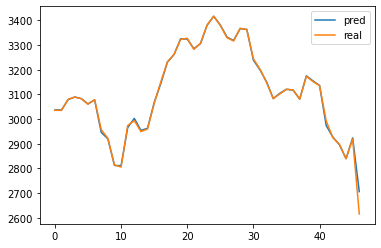

In [11]:
bmodel = TransformerTimeSeries(feature_dim = feature_dim,
                                  nhead = 4,num_layers = 12,d_model = 512,
                                  conv_len = 5,feature_weight = True,embedding_weight = True)
bmodel.load_state_dict(torch.load('AMZN_H'))
bmodel.to(device)
bmodel.eval()
with torch.no_grad(): # eliminate gradient i.e. gradients only exists in train()

    for step,(x,y,feature,attention_masks) in enumerate(test_dl):
        x = x.to(device)
        y = y.to(device)
        feature = feature.to(device)
        
        #y = torch.cat([y[:,0:5],torch.ones(47,1).cuda()],1)
        #feature = torch.cat([feature[:,:,0:5],torch.ones(47,90,1).cuda()],2)
        
        attention_masks = attention_masks.to(device)
        output = bmodel(x,y,feature,attention_masks[0])
        
        pred = data[train_size + 1 :-1,1]*0.01*(100+output[:,t0:].squeeze()).detach().cpu()
        real = data[train_size + 1 :-1,1]*0.01*(100+y[:,t0:].squeeze()).detach().cpu()

        plt.plot(pred)
        plt.plot(real)
        plt.legend(['pred','real'])
        MAE = torch.nn.L1Loss()(pred,real).item()
        MSE = torch.nn.MSELoss()(pred,real).item()
        RMSE = np.sqrt(MSE)
        
        print(f'AMZN MAE is {MAE}')
        print(f'AMZN MSE is {MSE}')
        print(f'AMZN RMSE is {RMSE}')

#### low

In [12]:
file_name = 'AMZN_features.csv'
with open(file_name) as f:
    data_list = csv.reader(f)
    data = []
    for row in data_list:
        data.append(row)
    f.close()
    
data = torch.tensor(np.delete(np.array(data)[1:,2:],4,axis = 1).astype(np.float)).type(torch.float)

feature_dim = data.shape[1] - 1
rate = []
for i in range(1,data.shape[0]):
    rate.append((100*(data[i,0:4] - data[i-1,0:4])/data[i-1,0:4]).reshape(1,4))
    
rate = torch.cat(rate)
rate_data = torch.cat([rate,data[1:,4:]],1)
train_size = int(data.shape[0]*0.9)
data_train = rate_data[0:train_size]
data_test = rate_data[train_size-4:]


t0 = 5
to_predict = 1
train_dataset = GetData(data_train[:,2],torch.cat([data_train[:,0:2],data_train[:,3:]],1),t0 = t0, to_predict = to_predict)
test_dataset = GetData(data_test[:,2],torch.cat([data_test[:,0:2],data_test[:,3:]],1),t0 = t0, to_predict = to_predict)
criterion = torch.nn.MSELoss()
# dataloaders
train_dl = DataLoader(train_dataset,batch_size=256,shuffle=True)
test_dl = DataLoader(test_dataset,batch_size=512)





model = TransformerTimeSeries(feature_dim = feature_dim,
                              nhead = 4,num_layers = 12,d_model = 512,
                              conv_len = 5,feature_weight = True,embedding_weight = True)
model = model.to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=1e-5 ,momentum = 0.9, nesterov = True)#Adam optimizer
#scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer,5e-7,3e-5,10,mode = 'exp_range',gamma = 0.9996)



train_epoch_loss = []
test_epoch_loss = []
test_best = 9999
for epoch in tqdm(range(4000)):


    l_t = train_epoch(model,train_dl,optimizer,t0,to_predict)

    train_loss = test_epoch(model,train_dl,t0,to_predict)


    test_loss = test_epoch(model,test_dl,t0,to_predict)


    if test_best > test_loss:
        test_best = test_loss
        torch.save(model.state_dict(), 'AMZN_L')



    train_epoch_loss.append(np.mean(train_loss))
    test_epoch_loss.append(test_loss)

    print("Epoch {}: Train loss: {} \t test loss: {}".format(epoch+1,
                                                             np.mean(train_loss),
                                                             test_loss))
    #scheduler.step()



torch.Size([431, 6])
torch.Size([431, 6])
torch.Size([47, 6])
torch.Size([47, 6])


  0%|                                                                                     | 0/4000 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1944: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
  0%|                                                                             | 1/4000 [00:00<23:53,  2.79it/s]

Epoch 1: Train loss: 1.3432365028045017 	 test loss: 2.270113229751587


  0%|                                                                             | 2/4000 [00:01<44:56,  1.48it/s]

Epoch 2: Train loss: 1.3403396144543889 	 test loss: 2.2641031742095947


  0%|                                                                           | 3/4000 [00:07<3:40:11,  3.31s/it]

Epoch 3: Train loss: 1.337898643829983 	 test loss: 2.2575199604034424


  0%|                                                                           | 4/4000 [00:14<4:59:41,  4.50s/it]

Epoch 4: Train loss: 1.336110152667194 	 test loss: 2.2510986328125


  0%|                                                                           | 5/4000 [00:20<5:51:05,  5.27s/it]

Epoch 5: Train loss: 1.3352992553998588 	 test loss: 2.2453012466430664


  0%|                                                                           | 6/4000 [00:27<6:21:06,  5.73s/it]

Epoch 6: Train loss: 1.334755969434769 	 test loss: 2.240204095840454


  0%|▏                                                                          | 7/4000 [00:33<6:40:11,  6.01s/it]

Epoch 7: Train loss: 1.334197761287822 	 test loss: 2.236358165740967


  0%|▏                                                                          | 8/4000 [00:40<6:51:05,  6.18s/it]

Epoch 8: Train loss: 1.3335159624259045 	 test loss: 2.2332687377929688


  0%|▏                                                                          | 9/4000 [00:47<7:00:02,  6.31s/it]

Epoch 9: Train loss: 1.3325761692153328 	 test loss: 2.2314493656158447


  0%|▏                                                                         | 10/4000 [00:53<7:06:16,  6.41s/it]

Epoch 10: Train loss: 1.3316293291038814 	 test loss: 2.2296011447906494


  0%|▏                                                                         | 11/4000 [01:00<7:10:44,  6.48s/it]

Epoch 11: Train loss: 1.3306212845645204 	 test loss: 2.2278616428375244


  0%|▏                                                                         | 12/4000 [01:06<7:13:20,  6.52s/it]

Epoch 12: Train loss: 1.3296175177301996 	 test loss: 2.226118564605713


  0%|▏                                                                         | 13/4000 [01:13<7:14:45,  6.54s/it]

Epoch 13: Train loss: 1.32856424031844 	 test loss: 2.2247259616851807


  0%|▎                                                                         | 14/4000 [01:20<7:15:13,  6.55s/it]

Epoch 14: Train loss: 1.3275585901986142 	 test loss: 2.2232248783111572


  0%|▎                                                                         | 15/4000 [01:26<7:15:31,  6.56s/it]

Epoch 15: Train loss: 1.3265425511689861 	 test loss: 2.2218103408813477


  0%|▎                                                                         | 16/4000 [01:33<7:17:33,  6.59s/it]

Epoch 16: Train loss: 1.3255341620013774 	 test loss: 2.2208704948425293


  0%|▎                                                                         | 17/4000 [01:39<7:17:42,  6.59s/it]

Epoch 17: Train loss: 1.3246075841500975 	 test loss: 2.2194321155548096


  0%|▎                                                                         | 18/4000 [01:46<7:11:33,  6.50s/it]

Epoch 18: Train loss: 1.3236657455736414 	 test loss: 2.2176477909088135


  0%|▎                                                                         | 19/4000 [01:52<7:13:17,  6.53s/it]

Epoch 19: Train loss: 1.322743146712708 	 test loss: 2.215442657470703


  0%|▎                                                                         | 20/4000 [01:59<7:21:02,  6.65s/it]

Epoch 20: Train loss: 1.321814286459903 	 test loss: 2.2125730514526367


  1%|▍                                                                         | 21/4000 [02:06<7:18:45,  6.62s/it]

Epoch 21: Train loss: 1.3208824235712568 	 test loss: 2.209771156311035


  1%|▍                                                                         | 22/4000 [02:12<7:19:36,  6.63s/it]

Epoch 22: Train loss: 1.3200236262965368 	 test loss: 2.2067081928253174


  1%|▍                                                                         | 23/4000 [02:18<7:05:53,  6.43s/it]

Epoch 23: Train loss: 1.3190878322672124 	 test loss: 2.204094171524048


  1%|▍                                                                         | 24/4000 [02:26<7:20:07,  6.64s/it]

Epoch 24: Train loss: 1.3180944667891394 	 test loss: 2.202279806137085


  1%|▍                                                                         | 25/4000 [02:32<7:20:41,  6.65s/it]

Epoch 25: Train loss: 1.3170751723225322 	 test loss: 2.200129508972168


  1%|▍                                                                         | 26/4000 [02:39<7:19:48,  6.64s/it]

Epoch 26: Train loss: 1.3160857578994503 	 test loss: 2.198138952255249


  1%|▍                                                                         | 27/4000 [02:45<7:18:57,  6.63s/it]

Epoch 27: Train loss: 1.3150934083279213 	 test loss: 2.1966960430145264


  1%|▌                                                                         | 28/4000 [02:52<7:15:28,  6.58s/it]

Epoch 28: Train loss: 1.3141005581326939 	 test loss: 2.1950557231903076


  1%|▌                                                                         | 29/4000 [02:59<7:18:43,  6.63s/it]

Epoch 29: Train loss: 1.3131165272121916 	 test loss: 2.192542552947998


  1%|▌                                                                         | 30/4000 [03:05<7:18:16,  6.62s/it]

Epoch 30: Train loss: 1.3121573366311199 	 test loss: 2.1903645992279053


  1%|▌                                                                         | 31/4000 [03:12<7:17:46,  6.62s/it]

Epoch 31: Train loss: 1.3111528904974599 	 test loss: 2.1882996559143066


  1%|▌                                                                         | 32/4000 [03:18<7:17:45,  6.62s/it]

Epoch 32: Train loss: 1.3101779197595511 	 test loss: 2.1859045028686523


  1%|▌                                                                         | 33/4000 [03:25<7:22:44,  6.70s/it]

Epoch 33: Train loss: 1.3091504759135766 	 test loss: 2.1826486587524414


  1%|▋                                                                         | 34/4000 [03:32<7:15:36,  6.59s/it]

Epoch 34: Train loss: 1.3081731013521518 	 test loss: 2.1792242527008057


  1%|▋                                                                         | 35/4000 [03:38<7:01:31,  6.38s/it]

Epoch 35: Train loss: 1.3072551309094351 	 test loss: 2.1762866973876953


  1%|▋                                                                         | 36/4000 [03:45<7:24:47,  6.73s/it]

Epoch 36: Train loss: 1.306260906350032 	 test loss: 2.1738147735595703


  1%|▋                                                                         | 37/4000 [03:51<7:17:22,  6.62s/it]

Epoch 37: Train loss: 1.3052024030906695 	 test loss: 2.1714437007904053


  1%|▋                                                                         | 38/4000 [03:57<7:03:29,  6.41s/it]

Epoch 38: Train loss: 1.3041893841219059 	 test loss: 2.1693170070648193


  1%|▋                                                                         | 39/4000 [04:05<7:20:29,  6.67s/it]

Epoch 39: Train loss: 1.303060023524645 	 test loss: 2.1677699089050293


  1%|▋                                                                         | 40/4000 [04:11<7:18:22,  6.64s/it]

Epoch 40: Train loss: 1.302011767009018 	 test loss: 2.1663756370544434


  1%|▊                                                                         | 41/4000 [04:18<7:18:16,  6.64s/it]

Epoch 41: Train loss: 1.3010229096335215 	 test loss: 2.164902687072754


  1%|▊                                                                         | 42/4000 [04:24<7:17:02,  6.63s/it]

Epoch 42: Train loss: 1.2999840582053235 	 test loss: 2.1632773876190186


  1%|▊                                                                         | 43/4000 [04:31<7:20:46,  6.68s/it]

Epoch 43: Train loss: 1.2988950794091634 	 test loss: 2.160975933074951


  1%|▊                                                                         | 44/4000 [04:37<7:01:47,  6.40s/it]

Epoch 44: Train loss: 1.2978979042124028 	 test loss: 2.1586294174194336


  1%|▊                                                                         | 45/4000 [04:44<7:17:26,  6.64s/it]

Epoch 45: Train loss: 1.2967697235381797 	 test loss: 2.155632972717285


  1%|▊                                                                         | 46/4000 [04:50<7:04:48,  6.45s/it]

Epoch 46: Train loss: 1.2956895272305835 	 test loss: 2.152946949005127


  1%|▊                                                                         | 47/4000 [04:58<7:21:20,  6.70s/it]

Epoch 47: Train loss: 1.2945815258402282 	 test loss: 2.149465560913086


  1%|▉                                                                         | 48/4000 [05:04<7:18:55,  6.66s/it]

Epoch 48: Train loss: 1.2935767016112112 	 test loss: 2.1458561420440674


  1%|▉                                                                         | 49/4000 [05:11<7:22:06,  6.71s/it]

Epoch 49: Train loss: 1.2926443494389617 	 test loss: 2.1417155265808105


  1%|▉                                                                         | 50/4000 [05:17<7:15:17,  6.61s/it]

Epoch 50: Train loss: 1.2916204276604886 	 test loss: 2.138176441192627


  1%|▉                                                                         | 51/4000 [05:24<7:15:12,  6.61s/it]

Epoch 51: Train loss: 1.2904825799703046 	 test loss: 2.1352427005767822


  1%|▉                                                                         | 52/4000 [05:31<7:14:55,  6.61s/it]

Epoch 52: Train loss: 1.289319173919076 	 test loss: 2.132526159286499


  1%|▉                                                                         | 53/4000 [05:36<7:01:31,  6.41s/it]

Epoch 53: Train loss: 1.2880464358008932 	 test loss: 2.13016676902771


  1%|▉                                                                         | 54/4000 [05:44<7:16:48,  6.64s/it]

Epoch 54: Train loss: 1.28671890870601 	 test loss: 2.128260612487793


  1%|█                                                                         | 55/4000 [05:50<7:17:21,  6.65s/it]

Epoch 55: Train loss: 1.2854610855784052 	 test loss: 2.1265807151794434


  1%|█                                                                         | 56/4000 [05:57<7:18:57,  6.68s/it]

Epoch 56: Train loss: 1.284168880666215 	 test loss: 2.124748945236206


  1%|█                                                                         | 57/4000 [06:03<7:14:19,  6.61s/it]

Epoch 57: Train loss: 1.2830758526264376 	 test loss: 2.122818946838379


  1%|█                                                                         | 58/4000 [06:10<7:12:23,  6.58s/it]

Epoch 58: Train loss: 1.2819322712736727 	 test loss: 2.120258092880249


  1%|█                                                                         | 59/4000 [06:17<7:14:49,  6.62s/it]

Epoch 59: Train loss: 1.2805860899993826 	 test loss: 2.1168670654296875


  2%|█                                                                         | 60/4000 [06:24<7:18:52,  6.68s/it]

Epoch 60: Train loss: 1.2792607670317118 	 test loss: 2.1133077144622803


  2%|█▏                                                                        | 61/4000 [06:30<7:17:01,  6.66s/it]

Epoch 61: Train loss: 1.2781361438282128 	 test loss: 2.110553741455078


  2%|█▏                                                                        | 62/4000 [06:36<6:58:39,  6.38s/it]

Epoch 62: Train loss: 1.2768251395280843 	 test loss: 2.1072628498077393


  2%|█▏                                                                        | 63/4000 [06:43<7:15:49,  6.64s/it]

Epoch 63: Train loss: 1.2754230994359523 	 test loss: 2.1039044857025146


  2%|█▏                                                                        | 64/4000 [06:50<7:14:42,  6.63s/it]

Epoch 64: Train loss: 1.2741220749724491 	 test loss: 2.101271867752075


  2%|█▏                                                                        | 65/4000 [06:56<7:13:59,  6.62s/it]

Epoch 65: Train loss: 1.2728018237930439 	 test loss: 2.098104476928711


  2%|█▏                                                                        | 66/4000 [07:03<7:17:55,  6.68s/it]

Epoch 66: Train loss: 1.2714318172561043 	 test loss: 2.0947718620300293


  2%|█▏                                                                        | 67/4000 [07:10<7:12:27,  6.60s/it]

Epoch 67: Train loss: 1.2700159770983277 	 test loss: 2.0909581184387207


  2%|█▎                                                                        | 68/4000 [07:16<7:17:08,  6.67s/it]

Epoch 68: Train loss: 1.2686450080362661 	 test loss: 2.087057113647461


  2%|█▎                                                                        | 69/4000 [07:22<7:04:40,  6.48s/it]

Epoch 69: Train loss: 1.2673615275292276 	 test loss: 2.083597421646118


  2%|█▎                                                                        | 70/4000 [07:29<7:13:38,  6.62s/it]

Epoch 70: Train loss: 1.2659644945038444 	 test loss: 2.080456495285034


  2%|█▎                                                                        | 71/4000 [07:36<7:15:44,  6.65s/it]

Epoch 71: Train loss: 1.2644756501346066 	 test loss: 2.0772807598114014


  2%|█▎                                                                        | 72/4000 [07:43<7:12:09,  6.60s/it]

Epoch 72: Train loss: 1.263027928544861 	 test loss: 2.0747475624084473


  2%|█▎                                                                        | 73/4000 [07:49<7:11:39,  6.60s/it]

Epoch 73: Train loss: 1.2615990292998311 	 test loss: 2.0719661712646484


  2%|█▎                                                                        | 74/4000 [07:56<7:11:29,  6.59s/it]

Epoch 74: Train loss: 1.2601916303214231 	 test loss: 2.0698258876800537


  2%|█▍                                                                        | 75/4000 [08:02<7:11:57,  6.60s/it]

Epoch 75: Train loss: 1.2587520196653574 	 test loss: 2.0667293071746826


  2%|█▍                                                                        | 76/4000 [08:09<7:14:16,  6.64s/it]

Epoch 76: Train loss: 1.2572487429510413 	 test loss: 2.0635199546813965


  2%|█▍                                                                        | 77/4000 [08:15<6:57:59,  6.39s/it]

Epoch 77: Train loss: 1.2553872506192554 	 test loss: 2.059056282043457


  2%|█▍                                                                        | 78/4000 [08:22<7:14:24,  6.65s/it]

Epoch 78: Train loss: 1.2535271392897498 	 test loss: 2.054182529449463


  2%|█▍                                                                        | 79/4000 [08:29<7:13:27,  6.63s/it]

Epoch 79: Train loss: 1.2516605671486556 	 test loss: 2.0490198135375977


  2%|█▍                                                                        | 80/4000 [08:35<7:13:33,  6.64s/it]

Epoch 80: Train loss: 1.2498552237751865 	 test loss: 2.0444352626800537


  2%|█▍                                                                        | 81/4000 [08:42<7:15:04,  6.66s/it]

Epoch 81: Train loss: 1.2481517830470321 	 test loss: 2.0398693084716797


  2%|█▌                                                                        | 82/4000 [08:49<7:11:22,  6.61s/it]

Epoch 82: Train loss: 1.246443353230328 	 test loss: 2.035651445388794


  2%|█▌                                                                        | 83/4000 [08:55<7:14:15,  6.65s/it]

Epoch 83: Train loss: 1.2444989847196504 	 test loss: 2.031580924987793


  2%|█▌                                                                        | 84/4000 [09:02<7:09:54,  6.59s/it]

Epoch 84: Train loss: 1.2422435587907334 	 test loss: 2.0273916721343994


  2%|█▌                                                                        | 85/4000 [09:08<7:10:30,  6.60s/it]

Epoch 85: Train loss: 1.2404269856809187 	 test loss: 2.024282455444336


  2%|█▌                                                                        | 86/4000 [09:15<7:15:12,  6.67s/it]

Epoch 86: Train loss: 1.2385934082372005 	 test loss: 2.020463228225708


  2%|█▌                                                                        | 87/4000 [09:21<7:02:21,  6.48s/it]

Epoch 87: Train loss: 1.2367688835082087 	 test loss: 2.0163869857788086


  2%|█▋                                                                        | 88/4000 [09:28<7:10:50,  6.61s/it]

Epoch 88: Train loss: 1.2350486492059622 	 test loss: 2.0125584602355957


  2%|█▋                                                                        | 89/4000 [09:35<7:10:50,  6.61s/it]

Epoch 89: Train loss: 1.2336539760266545 	 test loss: 2.0094797611236572


  2%|█▋                                                                        | 90/4000 [09:41<7:10:46,  6.61s/it]

Epoch 90: Train loss: 1.2322505635064605 	 test loss: 2.0060958862304688


  2%|█▋                                                                        | 91/4000 [09:48<7:04:30,  6.52s/it]

Epoch 91: Train loss: 1.2302294004267718 	 test loss: 2.0013580322265625


  2%|█▋                                                                        | 92/4000 [09:55<7:12:11,  6.64s/it]

Epoch 92: Train loss: 1.2273897931083448 	 test loss: 1.9947987794876099


  2%|█▋                                                                        | 93/4000 [10:01<6:58:26,  6.43s/it]

Epoch 93: Train loss: 1.2247503240811022 	 test loss: 1.9889647960662842


  2%|█▋                                                                        | 94/4000 [10:08<7:13:57,  6.67s/it]

Epoch 94: Train loss: 1.222120541430958 	 test loss: 1.984002709388733


  2%|█▊                                                                        | 95/4000 [10:14<7:12:36,  6.65s/it]

Epoch 95: Train loss: 1.2199196898467026 	 test loss: 1.9792819023132324


  2%|█▊                                                                        | 96/4000 [10:21<7:10:02,  6.61s/it]

Epoch 96: Train loss: 1.217629043242771 	 test loss: 1.9743033647537231


  2%|█▊                                                                        | 97/4000 [10:28<7:12:18,  6.65s/it]

Epoch 97: Train loss: 1.2154975023181145 	 test loss: 1.9696604013442993


  2%|█▊                                                                        | 98/4000 [10:34<7:11:08,  6.63s/it]

Epoch 98: Train loss: 1.2134546464667797 	 test loss: 1.9650013446807861


  2%|█▊                                                                        | 99/4000 [10:41<7:10:41,  6.62s/it]

Epoch 99: Train loss: 1.2115277870625187 	 test loss: 1.9602900743484497


  2%|█▊                                                                       | 100/4000 [10:47<7:09:56,  6.61s/it]

Epoch 100: Train loss: 1.2089665420094111 	 test loss: 1.954680323600769


  3%|█▊                                                                       | 101/4000 [10:54<7:06:45,  6.57s/it]

Epoch 101: Train loss: 1.2067217937478334 	 test loss: 1.9493037462234497


  3%|█▊                                                                       | 102/4000 [11:00<6:56:37,  6.41s/it]

Epoch 102: Train loss: 1.2051929484387285 	 test loss: 1.9446829557418823


  3%|█▉                                                                       | 103/4000 [11:07<7:13:50,  6.68s/it]

Epoch 103: Train loss: 1.2026530432313889 	 test loss: 1.9385194778442383


  3%|█▉                                                                       | 104/4000 [11:14<7:12:14,  6.66s/it]

Epoch 104: Train loss: 1.20005741473417 	 test loss: 1.9328302145004272


  3%|█▉                                                                       | 105/4000 [11:20<7:09:51,  6.62s/it]

Epoch 105: Train loss: 1.1966059523226213 	 test loss: 1.9262539148330688


  3%|█▉                                                                       | 106/4000 [11:27<7:07:37,  6.59s/it]

Epoch 106: Train loss: 1.192993280229325 	 test loss: 1.9201487302780151


  3%|█▉                                                                       | 107/4000 [11:33<6:58:15,  6.45s/it]

Epoch 107: Train loss: 1.1900923514864008 	 test loss: 1.9141756296157837


  3%|█▉                                                                       | 108/4000 [11:40<7:13:57,  6.69s/it]

Epoch 108: Train loss: 1.1872179795860414 	 test loss: 1.9078803062438965


  3%|█▉                                                                       | 109/4000 [11:47<7:11:31,  6.65s/it]

Epoch 109: Train loss: 1.18443720716888 	 test loss: 1.9014716148376465


  3%|██                                                                       | 110/4000 [11:53<7:10:48,  6.64s/it]

Epoch 110: Train loss: 1.1814774512691453 	 test loss: 1.8950384855270386


  3%|██                                                                       | 111/4000 [12:00<7:07:05,  6.59s/it]

Epoch 111: Train loss: 1.1781253065144657 	 test loss: 1.888185977935791


  3%|██                                                                       | 112/4000 [12:06<6:55:43,  6.42s/it]

Epoch 112: Train loss: 1.175296770171057 	 test loss: 1.8815745115280151


  3%|██                                                                       | 113/4000 [12:13<7:13:47,  6.70s/it]

Epoch 113: Train loss: 1.172485360136718 	 test loss: 1.8747673034667969


  3%|██                                                                       | 114/4000 [12:20<7:11:16,  6.66s/it]

Epoch 114: Train loss: 1.1704417901359965 	 test loss: 1.8692923784255981


  3%|██                                                                       | 115/4000 [12:27<7:10:29,  6.65s/it]

Epoch 115: Train loss: 1.1675132869844371 	 test loss: 1.8627620935440063


  3%|██                                                                       | 116/4000 [12:33<7:09:03,  6.63s/it]

Epoch 116: Train loss: 1.1631121134813314 	 test loss: 1.8546476364135742


  3%|██▏                                                                      | 117/4000 [12:40<7:09:21,  6.63s/it]

Epoch 117: Train loss: 1.159645116246217 	 test loss: 1.8475570678710938


  3%|██▏                                                                      | 118/4000 [12:46<7:08:24,  6.62s/it]

Epoch 118: Train loss: 1.157068031846509 	 test loss: 1.841416597366333


  3%|██▏                                                                      | 119/4000 [12:53<7:07:30,  6.61s/it]

Epoch 119: Train loss: 1.1534879025063216 	 test loss: 1.8338617086410522


  3%|██▏                                                                      | 120/4000 [13:00<7:07:39,  6.61s/it]

Epoch 120: Train loss: 1.1496143927430331 	 test loss: 1.8260492086410522


  3%|██▏                                                                      | 121/4000 [13:06<7:06:44,  6.60s/it]

Epoch 121: Train loss: 1.1462618068310058 	 test loss: 1.81876540184021


  3%|██▏                                                                      | 122/4000 [13:13<7:07:07,  6.61s/it]

Epoch 122: Train loss: 1.143192485424316 	 test loss: 1.8118665218353271


  3%|██▏                                                                      | 123/4000 [13:19<7:07:05,  6.61s/it]

Epoch 123: Train loss: 1.1397783454775534 	 test loss: 1.8039337396621704


  3%|██▎                                                                      | 124/4000 [13:26<7:05:49,  6.59s/it]

Epoch 124: Train loss: 1.1361932397718495 	 test loss: 1.7962249517440796


  3%|██▎                                                                      | 125/4000 [13:33<7:07:07,  6.61s/it]

Epoch 125: Train loss: 1.1321700855640138 	 test loss: 1.7879118919372559


  3%|██▎                                                                      | 126/4000 [13:39<7:06:22,  6.60s/it]

Epoch 126: Train loss: 1.1284775072903201 	 test loss: 1.7799168825149536


  3%|██▎                                                                      | 127/4000 [13:45<6:53:49,  6.41s/it]

Epoch 127: Train loss: 1.1245679177706867 	 test loss: 1.7715911865234375


  3%|██▎                                                                      | 128/4000 [13:53<7:13:43,  6.72s/it]

Epoch 128: Train loss: 1.1194990869187977 	 test loss: 1.7614881992340088


  3%|██▎                                                                      | 129/4000 [13:59<7:07:18,  6.62s/it]

Epoch 129: Train loss: 1.1152740913311456 	 test loss: 1.7521969079971313


  3%|██▎                                                                      | 130/4000 [14:05<7:04:10,  6.58s/it]

Epoch 130: Train loss: 1.1110876090565303 	 test loss: 1.7431217432022095


  3%|██▍                                                                      | 131/4000 [14:12<7:06:35,  6.62s/it]

Epoch 131: Train loss: 1.107056757413594 	 test loss: 1.7349735498428345


  3%|██▍                                                                      | 132/4000 [14:18<6:54:21,  6.43s/it]

Epoch 132: Train loss: 1.1036489751112157 	 test loss: 1.728569507598877


  3%|██▍                                                                      | 133/4000 [14:25<7:10:18,  6.68s/it]

Epoch 133: Train loss: 1.1004295434863274 	 test loss: 1.721480131149292


  3%|██▍                                                                      | 134/4000 [14:32<7:12:58,  6.72s/it]

Epoch 134: Train loss: 1.0963742459179906 	 test loss: 1.7124669551849365


  3%|██▍                                                                      | 135/4000 [14:39<7:05:58,  6.61s/it]

Epoch 135: Train loss: 1.0905186222766778 	 test loss: 1.701554536819458


  3%|██▍                                                                      | 136/4000 [14:45<7:04:53,  6.60s/it]

Epoch 136: Train loss: 1.0848767350831883 	 test loss: 1.6902941465377808


  3%|██▌                                                                      | 137/4000 [14:51<6:59:50,  6.52s/it]

Epoch 137: Train loss: 1.080045500653526 	 test loss: 1.6801767349243164


  3%|██▌                                                                      | 138/4000 [14:58<7:07:31,  6.64s/it]

Epoch 138: Train loss: 1.075058250858723 	 test loss: 1.6697989702224731


  3%|██▌                                                                      | 139/4000 [15:05<7:05:15,  6.61s/it]

Epoch 139: Train loss: 1.0699440807864726 	 test loss: 1.6593341827392578


  4%|██▌                                                                      | 140/4000 [15:12<7:06:25,  6.63s/it]

Epoch 140: Train loss: 1.0652682474207158 	 test loss: 1.6498788595199585


  4%|██▌                                                                      | 141/4000 [15:18<7:05:37,  6.62s/it]

Epoch 141: Train loss: 1.0612759169735655 	 test loss: 1.6411255598068237


  4%|██▌                                                                      | 142/4000 [15:25<7:05:37,  6.62s/it]

Epoch 142: Train loss: 1.057708962334281 	 test loss: 1.6329317092895508


  4%|██▌                                                                      | 143/4000 [15:31<7:05:10,  6.61s/it]

Epoch 143: Train loss: 1.0542872535656886 	 test loss: 1.6253572702407837


  4%|██▋                                                                      | 144/4000 [15:38<7:04:17,  6.60s/it]

Epoch 144: Train loss: 1.0505734532725783 	 test loss: 1.617434024810791


  4%|██▋                                                                      | 145/4000 [15:45<7:04:34,  6.61s/it]

Epoch 145: Train loss: 1.048935675842303 	 test loss: 1.6117053031921387


  4%|██▋                                                                      | 146/4000 [15:51<7:03:56,  6.60s/it]

Epoch 146: Train loss: 1.0419598972714417 	 test loss: 1.5999313592910767


  4%|██▋                                                                      | 147/4000 [15:58<7:04:32,  6.61s/it]

Epoch 147: Train loss: 1.0350280812057708 	 test loss: 1.5875574350357056


  4%|██▋                                                                      | 148/4000 [16:04<7:04:03,  6.61s/it]

Epoch 148: Train loss: 1.0259648514457755 	 test loss: 1.572935700416565


  4%|██▋                                                                      | 149/4000 [16:11<7:04:03,  6.61s/it]

Epoch 149: Train loss: 1.0212891458635265 	 test loss: 1.5648536682128906


  4%|██▋                                                                      | 150/4000 [16:18<7:03:54,  6.61s/it]

Epoch 150: Train loss: 1.0163875641236448 	 test loss: 1.5564671754837036


  4%|██▊                                                                      | 151/4000 [16:24<7:03:34,  6.60s/it]

Epoch 151: Train loss: 1.0123153767287039 	 test loss: 1.5472471714019775


  4%|██▊                                                                      | 152/4000 [16:31<7:08:17,  6.68s/it]

Epoch 152: Train loss: 1.0069986462869667 	 test loss: 1.53774893283844


  4%|██▊                                                                      | 153/4000 [16:37<7:02:06,  6.58s/it]

Epoch 153: Train loss: 1.001076604125118 	 test loss: 1.5284744501113892


  4%|██▊                                                                      | 154/4000 [16:44<6:52:46,  6.44s/it]

Epoch 154: Train loss: 0.9964404178052934 	 test loss: 1.5195399522781372


  4%|██▊                                                                      | 155/4000 [16:51<7:05:08,  6.63s/it]

Epoch 155: Train loss: 0.9903062363511725 	 test loss: 1.5103625059127808


  4%|██▊                                                                      | 156/4000 [16:57<7:04:27,  6.63s/it]

Epoch 156: Train loss: 0.9856371125876212 	 test loss: 1.501646876335144


  4%|██▊                                                                      | 157/4000 [17:04<7:02:58,  6.60s/it]

Epoch 157: Train loss: 0.9817210706923235 	 test loss: 1.493080735206604


  4%|██▉                                                                      | 158/4000 [17:10<7:03:53,  6.62s/it]

Epoch 158: Train loss: 0.9776964301023019 	 test loss: 1.4845421314239502


  4%|██▉                                                                      | 159/4000 [17:16<6:53:05,  6.45s/it]

Epoch 159: Train loss: 0.9742239428783515 	 test loss: 1.4751317501068115


  4%|██▉                                                                      | 160/4000 [17:24<7:06:15,  6.66s/it]

Epoch 160: Train loss: 0.964604346768762 	 test loss: 1.4648523330688477


  4%|██▉                                                                      | 161/4000 [17:30<7:04:21,  6.63s/it]

Epoch 161: Train loss: 0.9565944461424224 	 test loss: 1.4546282291412354


  4%|██▉                                                                      | 162/4000 [17:37<7:04:07,  6.63s/it]

Epoch 162: Train loss: 0.9515574545428813 	 test loss: 1.444973349571228


  4%|██▉                                                                      | 163/4000 [17:43<7:03:55,  6.63s/it]

Epoch 163: Train loss: 0.9467236094021189 	 test loss: 1.434472918510437


  4%|██▉                                                                      | 164/4000 [17:50<7:02:59,  6.62s/it]

Epoch 164: Train loss: 0.9433804731081368 	 test loss: 1.4251347780227661


  4%|███                                                                      | 165/4000 [17:57<7:10:12,  6.73s/it]

Epoch 165: Train loss: 0.9365258067500564 	 test loss: 1.4151244163513184


  4%|███                                                                      | 166/4000 [18:04<7:07:25,  6.69s/it]

Epoch 166: Train loss: 0.9294145473747961 	 test loss: 1.4048538208007812


  4%|███                                                                      | 167/4000 [18:10<7:05:13,  6.66s/it]

Epoch 167: Train loss: 0.9247493862829186 	 test loss: 1.3947031497955322


  4%|███                                                                      | 168/4000 [18:16<6:52:13,  6.45s/it]

Epoch 168: Train loss: 0.9199440397685199 	 test loss: 1.3851310014724731


  4%|███                                                                      | 169/4000 [18:23<7:07:33,  6.70s/it]

Epoch 169: Train loss: 0.915043200666556 	 test loss: 1.3760178089141846


  4%|███                                                                      | 170/4000 [18:30<7:05:50,  6.67s/it]

Epoch 170: Train loss: 0.9080360989559554 	 test loss: 1.366650938987732


  4%|███                                                                      | 171/4000 [18:37<7:04:24,  6.65s/it]

Epoch 171: Train loss: 0.9021758037487482 	 test loss: 1.3570435047149658


  4%|███▏                                                                     | 172/4000 [18:43<7:03:22,  6.64s/it]

Epoch 172: Train loss: 0.900485116478462 	 test loss: 1.3490724563598633


  4%|███▏                                                                     | 173/4000 [18:50<6:56:16,  6.53s/it]

Epoch 173: Train loss: 0.8965037407012107 	 test loss: 1.339921474456787


  4%|███▏                                                                     | 174/4000 [18:56<7:03:49,  6.65s/it]

Epoch 174: Train loss: 0.8942711408619538 	 test loss: 1.3315889835357666


  4%|███▏                                                                     | 175/4000 [19:03<7:07:39,  6.71s/it]

Epoch 175: Train loss: 0.8897846796119849 	 test loss: 1.321786880493164


  4%|███▏                                                                     | 176/4000 [19:10<7:01:07,  6.61s/it]

Epoch 176: Train loss: 0.8756866309869593 	 test loss: 1.309510350227356


  4%|███▏                                                                     | 177/4000 [19:16<7:00:42,  6.60s/it]

Epoch 177: Train loss: 0.8646770992301179 	 test loss: 1.2976313829421997


  4%|███▏                                                                     | 178/4000 [19:23<7:00:00,  6.59s/it]

Epoch 178: Train loss: 0.8613724790150494 	 test loss: 1.2886840105056763


  4%|███▎                                                                     | 179/4000 [19:29<6:59:27,  6.59s/it]

Epoch 179: Train loss: 0.8631011871340103 	 test loss: 1.2803716659545898


  4%|███▎                                                                     | 180/4000 [19:36<7:00:41,  6.61s/it]

Epoch 180: Train loss: 0.8611459643547607 	 test loss: 1.272062063217163


  5%|███▎                                                                     | 181/4000 [19:43<7:00:03,  6.60s/it]

Epoch 181: Train loss: 0.8515419304509174 	 test loss: 1.2609645128250122


  5%|███▎                                                                     | 182/4000 [19:49<7:00:38,  6.61s/it]

Epoch 182: Train loss: 0.8410175049941114 	 test loss: 1.2500991821289062


  5%|███▎                                                                     | 183/4000 [19:56<7:04:57,  6.68s/it]

Epoch 183: Train loss: 0.8293825515185044 	 test loss: 1.2403457164764404


  5%|███▎                                                                     | 184/4000 [20:03<6:58:48,  6.59s/it]

Epoch 184: Train loss: 0.8220762791600416 	 test loss: 1.2315540313720703


  5%|███▍                                                                     | 185/4000 [20:09<6:57:25,  6.57s/it]

Epoch 185: Train loss: 0.8211188426980286 	 test loss: 1.2221862077713013


  5%|███▍                                                                     | 186/4000 [20:16<6:59:14,  6.60s/it]

Epoch 186: Train loss: 0.8282427856927681 	 test loss: 1.2188665866851807


  5%|███▍                                                                     | 187/4000 [20:22<6:59:40,  6.60s/it]

Epoch 187: Train loss: 0.8124254704074904 	 test loss: 1.2064225673675537


  5%|███▍                                                                     | 188/4000 [20:29<6:56:25,  6.55s/it]

Epoch 188: Train loss: 0.802074343588402 	 test loss: 1.1975672245025635


  5%|███▍                                                                     | 189/4000 [20:36<7:00:23,  6.62s/it]

Epoch 189: Train loss: 0.7970192222196929 	 test loss: 1.1902769804000854


  5%|███▍                                                                     | 190/4000 [20:42<6:59:58,  6.61s/it]

Epoch 190: Train loss: 0.7979098001101731 	 test loss: 1.1838475465774536


  5%|███▍                                                                     | 191/4000 [20:48<6:53:17,  6.51s/it]

Epoch 191: Train loss: 0.7946652100700237 	 test loss: 1.1758793592453003


  5%|███▌                                                                     | 192/4000 [20:55<6:59:57,  6.62s/it]

Epoch 192: Train loss: 0.7896715626639169 	 test loss: 1.1687442064285278


  5%|███▌                                                                     | 193/4000 [21:02<6:59:35,  6.61s/it]

Epoch 193: Train loss: 0.7821262162135538 	 test loss: 1.1606568098068237


  5%|███▌                                                                     | 194/4000 [21:09<7:00:51,  6.63s/it]

Epoch 194: Train loss: 0.7724214565449691 	 test loss: 1.152233362197876


  5%|███▌                                                                     | 195/4000 [21:15<7:03:41,  6.68s/it]

Epoch 195: Train loss: 0.7701789854297505 	 test loss: 1.1448097229003906


  5%|███▌                                                                     | 196/4000 [21:21<6:45:38,  6.40s/it]

Epoch 196: Train loss: 0.7751713017576531 	 test loss: 1.1401885747909546


  5%|███▌                                                                     | 197/4000 [21:28<7:01:21,  6.65s/it]

Epoch 197: Train loss: 0.7726059031873734 	 test loss: 1.1345144510269165


  5%|███▌                                                                     | 198/4000 [21:35<6:59:37,  6.62s/it]

Epoch 198: Train loss: 0.7525438255610986 	 test loss: 1.1227997541427612


  5%|███▋                                                                     | 199/4000 [21:42<7:00:55,  6.64s/it]

Epoch 199: Train loss: 0.7463442171532704 	 test loss: 1.1149080991744995


  5%|███▋                                                                     | 200/4000 [21:48<7:04:46,  6.71s/it]

Epoch 200: Train loss: 0.7427298414181667 	 test loss: 1.1062310934066772


  5%|███▋                                                                     | 201/4000 [21:54<6:45:04,  6.40s/it]

Epoch 201: Train loss: 0.742506981864053 	 test loss: 1.0994634628295898


  5%|███▋                                                                     | 202/4000 [22:01<7:01:22,  6.66s/it]

Epoch 202: Train loss: 0.7455915613683359 	 test loss: 1.098976492881775


  5%|███▋                                                                     | 203/4000 [22:08<6:57:19,  6.59s/it]

Epoch 203: Train loss: 0.7395947462168204 	 test loss: 1.0906955003738403


  5%|███▋                                                                     | 204/4000 [22:15<7:00:43,  6.65s/it]

Epoch 204: Train loss: 0.7123441299263673 	 test loss: 1.0758334398269653


  5%|███▋                                                                     | 205/4000 [22:21<6:59:30,  6.63s/it]

Epoch 205: Train loss: 0.7116588766226359 	 test loss: 1.0651018619537354


  5%|███▊                                                                     | 206/4000 [22:27<6:46:12,  6.42s/it]

Epoch 206: Train loss: 0.7126167885388687 	 test loss: 1.061597466468811


  5%|███▊                                                                     | 207/4000 [22:34<7:02:08,  6.68s/it]

Epoch 207: Train loss: 0.70833387867204 	 test loss: 1.0549769401550293


  5%|███▊                                                                     | 208/4000 [22:41<7:05:21,  6.73s/it]

Epoch 208: Train loss: 0.6955221190253432 	 test loss: 1.0425926446914673


  5%|███▊                                                                     | 209/4000 [22:47<6:45:29,  6.42s/it]

Epoch 209: Train loss: 0.6833168654043548 	 test loss: 1.0391300916671753


  5%|███▊                                                                     | 210/4000 [22:54<6:54:47,  6.57s/it]

Epoch 210: Train loss: 0.678215143713763 	 test loss: 1.0303075313568115


  5%|███▊                                                                     | 211/4000 [23:01<6:58:44,  6.63s/it]

Epoch 211: Train loss: 0.6837538086621224 	 test loss: 1.0244237184524536


  5%|███▊                                                                     | 212/4000 [23:07<7:01:25,  6.68s/it]

Epoch 212: Train loss: 0.6694058296022172 	 test loss: 1.0131779909133911


  5%|███▉                                                                     | 213/4000 [23:14<6:58:47,  6.64s/it]

Epoch 213: Train loss: 0.6725574029294078 	 test loss: 1.0114820003509521


  5%|███▉                                                                     | 214/4000 [23:21<6:59:02,  6.64s/it]

Epoch 214: Train loss: 0.6638782465540892 	 test loss: 1.0027997493743896


  5%|███▉                                                                     | 215/4000 [23:27<6:58:13,  6.63s/it]

Epoch 215: Train loss: 0.6663186414612419 	 test loss: 1.001374363899231


  5%|███▉                                                                     | 216/4000 [23:34<6:57:57,  6.63s/it]

Epoch 216: Train loss: 0.6521233031202082 	 test loss: 0.9884276390075684


  5%|███▉                                                                     | 217/4000 [23:40<6:55:50,  6.60s/it]

Epoch 217: Train loss: 0.6510455727300621 	 test loss: 0.9846221804618835


  5%|███▉                                                                     | 218/4000 [23:47<6:55:30,  6.59s/it]

Epoch 218: Train loss: 0.6343820166975053 	 test loss: 0.9741455912590027


  5%|███▉                                                                     | 219/4000 [23:54<6:56:00,  6.60s/it]

Epoch 219: Train loss: 0.6286432483080092 	 test loss: 0.9687215685844421


  6%|████                                                                     | 220/4000 [24:00<6:56:52,  6.62s/it]

Epoch 220: Train loss: 0.626650625342836 	 test loss: 0.9639810919761658


  6%|████                                                                     | 221/4000 [24:07<6:54:42,  6.58s/it]

Epoch 221: Train loss: 0.6237529812168909 	 test loss: 0.9594300389289856


  6%|████                                                                     | 222/4000 [24:13<6:50:36,  6.52s/it]

Epoch 222: Train loss: 0.6253905538339902 	 test loss: 0.9566880464553833


  6%|████                                                                     | 223/4000 [24:20<6:58:20,  6.65s/it]

Epoch 223: Train loss: 0.6090839232756754 	 test loss: 0.9459199905395508


  6%|████                                                                     | 224/4000 [24:27<6:57:38,  6.64s/it]

Epoch 224: Train loss: 0.6155447793947295 	 test loss: 0.9456353187561035


  6%|████                                                                     | 225/4000 [24:33<6:56:41,  6.62s/it]

Epoch 225: Train loss: 0.5962495772025425 	 test loss: 0.9332305788993835


  6%|████                                                                     | 226/4000 [24:40<6:55:58,  6.61s/it]

Epoch 226: Train loss: 0.603762492502925 	 test loss: 0.9331022500991821


  6%|████▏                                                                    | 227/4000 [24:46<6:56:13,  6.62s/it]

Epoch 227: Train loss: 0.6113585407938592 	 test loss: 0.9316019415855408


  6%|████▏                                                                    | 228/4000 [24:53<6:55:40,  6.61s/it]

Epoch 228: Train loss: 0.5787122238539765 	 test loss: 0.914430558681488


  6%|████▏                                                                    | 229/4000 [25:00<6:54:35,  6.60s/it]

Epoch 229: Train loss: 0.5730365528584633 	 test loss: 0.9073890447616577


  6%|████▏                                                                    | 230/4000 [25:06<6:54:35,  6.60s/it]

Epoch 230: Train loss: 0.5700808972327726 	 test loss: 0.9041221141815186


  6%|████▏                                                                    | 232/4000 [25:13<4:56:26,  4.72s/it]

Epoch 231: Train loss: 0.5796110056115967 	 test loss: 0.9036731719970703
Epoch 232: Train loss: 0.5991716805300967 	 test loss: 0.9052185416221619


  6%|████▎                                                                    | 233/4000 [25:19<5:24:39,  5.17s/it]

Epoch 233: Train loss: 0.5866460732406917 	 test loss: 0.8969653248786926


  6%|████▎                                                                    | 234/4000 [25:26<5:51:35,  5.60s/it]

Epoch 234: Train loss: 0.5538420621867522 	 test loss: 0.8811246156692505


  6%|████▎                                                                    | 235/4000 [25:33<6:10:20,  5.90s/it]

Epoch 235: Train loss: 0.545263225268875 	 test loss: 0.8724955916404724


  6%|████▎                                                                    | 237/4000 [25:39<4:30:35,  4.31s/it]

Epoch 236: Train loss: 0.5472778621239894 	 test loss: 0.8700481653213501
Epoch 237: Train loss: 0.564680623620956 	 test loss: 0.871164083480835


  6%|████▎                                                                    | 238/4000 [25:46<5:10:40,  4.96s/it]

Epoch 238: Train loss: 0.5441964682182967 	 test loss: 0.8595821261405945


  6%|████▎                                                                    | 239/4000 [25:52<5:41:11,  5.44s/it]

Epoch 239: Train loss: 0.5287712934122285 	 test loss: 0.8500586748123169


  6%|████▍                                                                    | 240/4000 [25:59<5:57:51,  5.71s/it]

Epoch 240: Train loss: 0.522637721280764 	 test loss: 0.8434992432594299


  6%|████▍                                                                    | 242/4000 [26:06<4:28:41,  4.29s/it]

Epoch 241: Train loss: 0.5230992903842173 	 test loss: 0.8381015658378601
Epoch 242: Train loss: 0.5465535597568875 	 test loss: 0.8417418003082275


  6%|████▍                                                                    | 243/4000 [26:12<5:09:50,  4.95s/it]

Epoch 243: Train loss: 0.5238740213924107 	 test loss: 0.8268529176712036


  6%|████▍                                                                    | 244/4000 [26:19<5:40:50,  5.44s/it]

Epoch 244: Train loss: 0.5249097319600754 	 test loss: 0.8237718939781189


  6%|████▍                                                                    | 245/4000 [26:25<6:02:28,  5.79s/it]

Epoch 245: Train loss: 0.5058965187891453 	 test loss: 0.8150978088378906


  6%|████▍                                                                    | 246/4000 [26:32<6:14:29,  5.99s/it]

Epoch 246: Train loss: 0.505107336282177 	 test loss: 0.8097208738327026


  6%|████▌                                                                    | 248/4000 [26:39<4:34:53,  4.40s/it]

Epoch 247: Train loss: 0.49885442313627965 	 test loss: 0.8038142323493958
Epoch 248: Train loss: 0.5275736326684531 	 test loss: 0.8090139031410217


  6%|████▌                                                                    | 249/4000 [26:45<5:13:37,  5.02s/it]

Epoch 249: Train loss: 0.49008658362375335 	 test loss: 0.7924973964691162


  6%|████▌                                                                    | 251/4000 [26:52<4:02:51,  3.89s/it]

Epoch 250: Train loss: 0.48970048976608327 	 test loss: 0.7888399362564087
Epoch 251: Train loss: 0.5071094232479547 	 test loss: 0.7904192805290222


  6%|████▌                                                                    | 252/4000 [26:52<2:52:31,  2.76s/it]

Epoch 252: Train loss: 0.5376295571814004 	 test loss: 0.7953225374221802


  6%|████▌                                                                    | 253/4000 [26:59<4:03:56,  3.91s/it]

Epoch 253: Train loss: 0.4837769539616224 	 test loss: 0.7749654650688171


  6%|████▋                                                                    | 254/4000 [27:05<4:48:23,  4.62s/it]

Epoch 254: Train loss: 0.4767139905981564 	 test loss: 0.772036075592041


  6%|████▋                                                                    | 256/4000 [27:12<3:51:14,  3.71s/it]

Epoch 255: Train loss: 0.4805705165641767 	 test loss: 0.7676793932914734
Epoch 256: Train loss: 0.5021315626367892 	 test loss: 0.7680696845054626


  6%|████▋                                                                    | 257/4000 [27:18<4:43:05,  4.54s/it]

Epoch 257: Train loss: 0.4728590394532321 	 test loss: 0.7609462738037109


  6%|████▋                                                                    | 258/4000 [27:25<5:21:41,  5.16s/it]

Epoch 258: Train loss: 0.46648177663577406 	 test loss: 0.7582045197486877


  6%|████▋                                                                    | 259/4000 [27:32<5:48:26,  5.59s/it]

Epoch 259: Train loss: 0.4733415813014568 	 test loss: 0.7533628344535828


  6%|████▋                                                                    | 260/4000 [27:38<6:02:41,  5.82s/it]

Epoch 260: Train loss: 0.46179933939345197 	 test loss: 0.7492392063140869


  7%|████▊                                                                    | 261/4000 [27:45<6:22:06,  6.13s/it]

Epoch 261: Train loss: 0.47408618720944135 	 test loss: 0.7461401224136353


  7%|████▊                                                                    | 262/4000 [27:51<6:30:37,  6.27s/it]

Epoch 262: Train loss: 0.45465162265051823 	 test loss: 0.742979884147644


  7%|████▊                                                                    | 263/4000 [27:58<6:30:42,  6.27s/it]

Epoch 263: Train loss: 0.4511004830181184 	 test loss: 0.7394782304763794


  7%|████▊                                                                    | 264/4000 [28:05<6:43:13,  6.48s/it]

Epoch 264: Train loss: 0.4549239627031605 	 test loss: 0.7348831295967102


  7%|████▊                                                                    | 265/4000 [28:11<6:42:26,  6.46s/it]

Epoch 265: Train loss: 0.4490655927536382 	 test loss: 0.7314346432685852


  7%|████▊                                                                    | 266/4000 [28:18<6:47:47,  6.55s/it]

Epoch 266: Train loss: 0.4691063238960408 	 test loss: 0.728838324546814


  7%|████▊                                                                    | 267/4000 [28:24<6:48:38,  6.57s/it]

Epoch 267: Train loss: 0.4489171427529815 	 test loss: 0.7248719334602356


  7%|████▉                                                                    | 268/4000 [28:31<6:48:22,  6.57s/it]

Epoch 268: Train loss: 0.459363625387028 	 test loss: 0.7222126126289368


  7%|████▉                                                                    | 269/4000 [28:38<6:49:46,  6.59s/it]

Epoch 269: Train loss: 0.4600956844481404 	 test loss: 0.7191848754882812


  7%|████▉                                                                    | 270/4000 [28:44<6:52:26,  6.63s/it]

Epoch 270: Train loss: 0.4406052294020863 	 test loss: 0.7165319323539734


  7%|████▉                                                                    | 271/4000 [28:51<6:48:50,  6.58s/it]

Epoch 271: Train loss: 0.43827097653789476 	 test loss: 0.7130237221717834


  7%|████▉                                                                    | 272/4000 [28:57<6:49:23,  6.59s/it]

Epoch 272: Train loss: 0.44045748227986825 	 test loss: 0.708753764629364


  7%|████▉                                                                    | 273/4000 [29:04<6:51:38,  6.63s/it]

Epoch 273: Train loss: 0.4478819755418118 	 test loss: 0.7062773108482361


  7%|█████                                                                    | 274/4000 [29:11<6:48:44,  6.58s/it]

Epoch 274: Train loss: 0.43202441308448597 	 test loss: 0.7051572203636169


  7%|█████                                                                    | 275/4000 [29:17<6:53:43,  6.66s/it]

Epoch 275: Train loss: 0.43069769417880027 	 test loss: 0.7022125124931335


  7%|█████                                                                    | 276/4000 [29:23<6:35:50,  6.38s/it]

Epoch 276: Train loss: 0.44184984560632373 	 test loss: 0.6969237327575684


  7%|█████                                                                    | 277/4000 [29:30<6:48:49,  6.59s/it]

Epoch 277: Train loss: 0.44725799816390477 	 test loss: 0.6935051083564758


  7%|█████                                                                    | 278/4000 [29:37<6:51:27,  6.63s/it]

Epoch 278: Train loss: 0.4305609445284248 	 test loss: 0.6911794543266296


  7%|█████                                                                    | 279/4000 [29:44<6:51:32,  6.64s/it]

Epoch 279: Train loss: 0.4268225324264535 	 test loss: 0.6904376149177551


  7%|█████                                                                    | 280/4000 [29:50<6:51:04,  6.63s/it]

Epoch 280: Train loss: 0.43023040185395084 	 test loss: 0.6836294531822205


  7%|█████▏                                                                   | 281/4000 [29:57<6:50:26,  6.62s/it]

Epoch 281: Train loss: 0.43046127636582004 	 test loss: 0.6794856786727905


  7%|█████▏                                                                   | 282/4000 [30:03<6:49:46,  6.61s/it]

Epoch 282: Train loss: 0.42294167663271076 	 test loss: 0.677294909954071


  7%|█████▏                                                                   | 283/4000 [30:10<6:48:53,  6.60s/it]

Epoch 283: Train loss: 0.4246245355727778 	 test loss: 0.6721315979957581


  7%|█████▏                                                                   | 284/4000 [30:17<6:49:13,  6.61s/it]

Epoch 284: Train loss: 0.4157505801548261 	 test loss: 0.6703239679336548


  7%|█████▏                                                                   | 285/4000 [30:23<6:36:28,  6.40s/it]

Epoch 285: Train loss: 0.4153187241050871 	 test loss: 0.6662653684616089


  7%|█████▏                                                                   | 286/4000 [30:30<6:52:41,  6.67s/it]

Epoch 286: Train loss: 0.4115698307821756 	 test loss: 0.6637001633644104


  7%|█████▏                                                                   | 287/4000 [30:36<6:50:34,  6.63s/it]

Epoch 287: Train loss: 0.4164099214110186 	 test loss: 0.6588417291641235


  7%|█████▎                                                                   | 288/4000 [30:43<6:51:01,  6.64s/it]

Epoch 288: Train loss: 0.4191361219728076 	 test loss: 0.6566265821456909


  7%|█████▎                                                                   | 289/4000 [30:50<6:49:33,  6.62s/it]

Epoch 289: Train loss: 0.422896933735385 	 test loss: 0.6552510857582092


  7%|█████▎                                                                   | 290/4000 [30:56<6:49:34,  6.62s/it]

Epoch 290: Train loss: 0.42330868206831807 	 test loss: 0.6535706520080566


  7%|█████▎                                                                   | 291/4000 [31:03<6:49:15,  6.62s/it]

Epoch 291: Train loss: 0.408701633632598 	 test loss: 0.649540364742279


  7%|█████▎                                                                   | 292/4000 [31:09<6:48:48,  6.62s/it]

Epoch 292: Train loss: 0.40877874323497515 	 test loss: 0.6476877331733704


  7%|█████▎                                                                   | 293/4000 [31:16<6:48:17,  6.61s/it]

Epoch 293: Train loss: 0.4076955301164198 	 test loss: 0.6461261510848999


  7%|█████▎                                                                   | 294/4000 [31:23<6:47:52,  6.60s/it]

Epoch 294: Train loss: 0.41033869622201763 	 test loss: 0.6431637406349182


  7%|█████▍                                                                   | 295/4000 [31:29<6:35:29,  6.40s/it]

Epoch 295: Train loss: 0.4142756086629394 	 test loss: 0.6428630948066711


  7%|█████▍                                                                   | 297/4000 [31:36<4:48:43,  4.68s/it]

Epoch 296: Train loss: 0.4036444756105162 	 test loss: 0.638859212398529
Epoch 297: Train loss: 0.4010961418776944 	 test loss: 0.6402963399887085


  7%|█████▍                                                                   | 298/4000 [31:36<3:24:37,  3.32s/it]

Epoch 298: Train loss: 0.4012012095158172 	 test loss: 0.6409022212028503


  7%|█████▍                                                                   | 299/4000 [31:42<4:22:54,  4.26s/it]

Epoch 299: Train loss: 0.4077906720599553 	 test loss: 0.6345166563987732


  8%|█████▍                                                                   | 300/4000 [31:49<5:06:07,  4.96s/it]

Epoch 300: Train loss: 0.4056192234746265 	 test loss: 0.6320405602455139


  8%|█████▍                                                                   | 301/4000 [31:56<5:35:46,  5.45s/it]

Epoch 301: Train loss: 0.40370729890610946 	 test loss: 0.6298755407333374


  8%|█████▌                                                                   | 302/4000 [32:02<5:51:26,  5.70s/it]

Epoch 302: Train loss: 0.3933667471403312 	 test loss: 0.624770998954773


  8%|█████▌                                                                   | 304/4000 [32:09<4:24:25,  4.29s/it]

Epoch 303: Train loss: 0.3917805200524784 	 test loss: 0.6242812871932983
Epoch 304: Train loss: 0.40980355894482606 	 test loss: 0.6311572194099426


  8%|█████▌                                                                   | 305/4000 [32:15<4:58:00,  4.84s/it]

Epoch 305: Train loss: 0.39670435223391326 	 test loss: 0.6210322976112366


  8%|█████▌                                                                   | 307/4000 [32:22<3:58:32,  3.88s/it]

Epoch 306: Train loss: 0.39281082374590454 	 test loss: 0.6171638369560242
Epoch 307: Train loss: 0.40931647179298225 	 test loss: 0.6281530857086182


  8%|█████▌                                                                   | 308/4000 [32:29<4:46:05,  4.65s/it]

Epoch 308: Train loss: 0.394709667999064 	 test loss: 0.6162244081497192


  8%|█████▋                                                                   | 309/4000 [32:36<5:27:01,  5.32s/it]

Epoch 309: Train loss: 0.3909716266628761 	 test loss: 0.6127730011940002


  8%|█████▋                                                                   | 311/4000 [32:42<4:04:36,  3.98s/it]

Epoch 310: Train loss: 0.38636848344327124 	 test loss: 0.6077791452407837
Epoch 311: Train loss: 0.3831724989165286 	 test loss: 0.6085966229438782


  8%|█████▋                                                                   | 312/4000 [32:48<4:49:59,  4.72s/it]

Epoch 312: Train loss: 0.3828341651128782 	 test loss: 0.6069379448890686


  8%|█████▋                                                                   | 313/4000 [32:55<5:18:58,  5.19s/it]

Epoch 313: Train loss: 0.3831727645789941 	 test loss: 0.6029245853424072


  8%|█████▋                                                                   | 315/4000 [33:02<4:08:03,  4.04s/it]

Epoch 314: Train loss: 0.3837667795593943 	 test loss: 0.6014612913131714
Epoch 315: Train loss: 0.39059305142637196 	 test loss: 0.6070376038551331


  8%|█████▊                                                                   | 316/4000 [33:08<4:53:01,  4.77s/it]

Epoch 316: Train loss: 0.38218996647892306 	 test loss: 0.5981402397155762


  8%|█████▊                                                                   | 318/4000 [33:15<3:50:24,  3.75s/it]

Epoch 317: Train loss: 0.3775359328550972 	 test loss: 0.5957072377204895
Epoch 318: Train loss: 0.38476045488481453 	 test loss: 0.6021741032600403


  8%|█████▊                                                                   | 320/4000 [33:15<1:57:11,  1.91s/it]

Epoch 319: Train loss: 0.3860702312739432 	 test loss: 0.6038901209831238
Epoch 320: Train loss: 0.3793826001564477 	 test loss: 0.5973209142684937


  8%|█████▊                                                                   | 321/4000 [33:15<1:24:31,  1.38s/it]

Epoch 321: Train loss: 0.37832365850561456 	 test loss: 0.5965911746025085


  8%|█████▉                                                                   | 322/4000 [33:21<2:44:19,  2.68s/it]

Epoch 322: Train loss: 0.3670080518501264 	 test loss: 0.588159441947937


  8%|█████▉                                                                   | 323/4000 [33:28<4:00:12,  3.92s/it]

Epoch 323: Train loss: 0.36680007879805954 	 test loss: 0.5877981781959534


  8%|█████▉                                                                   | 324/4000 [33:35<4:52:43,  4.78s/it]

Epoch 324: Train loss: 0.3688261408678617 	 test loss: 0.5866461396217346


  8%|█████▉                                                                   | 325/4000 [33:41<5:25:58,  5.32s/it]

Epoch 325: Train loss: 0.3667179971172749 	 test loss: 0.5846938490867615


  8%|█████▉                                                                   | 326/4000 [33:48<5:49:34,  5.71s/it]

Epoch 326: Train loss: 0.36590671421756876 	 test loss: 0.5841549038887024


  8%|█████▉                                                                   | 327/4000 [33:55<6:05:55,  5.98s/it]

Epoch 327: Train loss: 0.36797059667912546 	 test loss: 0.5828143358230591


  8%|██████                                                                   | 329/4000 [34:01<4:26:24,  4.35s/it]

Epoch 328: Train loss: 0.36748630029696044 	 test loss: 0.5827575922012329
Epoch 329: Train loss: 0.37109608827223634 	 test loss: 0.5831372737884521


  8%|██████                                                                   | 330/4000 [34:01<3:09:04,  3.09s/it]

Epoch 330: Train loss: 0.4021322853050763 	 test loss: 0.600365400314331


  8%|██████                                                                   | 331/4000 [34:08<4:08:05,  4.06s/it]

Epoch 331: Train loss: 0.3697364185083217 	 test loss: 0.5802561640739441


  8%|██████                                                                   | 333/4000 [34:14<3:28:29,  3.41s/it]

Epoch 332: Train loss: 0.3683671987250344 	 test loss: 0.5784197449684143
Epoch 333: Train loss: 0.37441515320968183 	 test loss: 0.5807781219482422


  8%|██████                                                                   | 334/4000 [34:21<4:22:51,  4.30s/it]

Epoch 334: Train loss: 0.3677901168572101 	 test loss: 0.5762647390365601


  8%|██████                                                                   | 335/4000 [34:28<5:07:35,  5.04s/it]

Epoch 335: Train loss: 0.36709573049003175 	 test loss: 0.5754159688949585


  8%|██████▏                                                                  | 336/4000 [34:33<5:23:50,  5.30s/it]

Epoch 336: Train loss: 0.36580683833761724 	 test loss: 0.5742407441139221


  8%|██████▏                                                                  | 337/4000 [34:41<5:59:48,  5.89s/it]

Epoch 337: Train loss: 0.3632547360285252 	 test loss: 0.5724104642868042


  8%|██████▏                                                                  | 338/4000 [34:47<6:12:40,  6.11s/it]

Epoch 338: Train loss: 0.3632282733640649 	 test loss: 0.5718644857406616


  8%|██████▏                                                                  | 339/4000 [34:54<6:21:28,  6.25s/it]

Epoch 339: Train loss: 0.36252881901170153 	 test loss: 0.5708186030387878


  9%|██████▏                                                                  | 341/4000 [35:01<4:33:46,  4.49s/it]

Epoch 340: Train loss: 0.360319665509974 	 test loss: 0.5691558718681335
Epoch 341: Train loss: 0.3620356326175123 	 test loss: 0.5693044066429138


  9%|██████▏                                                                  | 342/4000 [35:07<5:10:09,  5.09s/it]

Epoch 342: Train loss: 0.35747834507661186 	 test loss: 0.5665721297264099


  9%|██████▎                                                                  | 343/4000 [35:14<5:37:38,  5.54s/it]

Epoch 343: Train loss: 0.3580153874897348 	 test loss: 0.5661175847053528


  9%|██████▎                                                                  | 344/4000 [35:20<5:56:35,  5.85s/it]

Epoch 344: Train loss: 0.35907979416736596 	 test loss: 0.5660102963447571


  9%|██████▎                                                                  | 345/4000 [35:27<6:09:39,  6.07s/it]

Epoch 345: Train loss: 0.3551377519239129 	 test loss: 0.5645348429679871


  9%|██████▎                                                                  | 347/4000 [35:34<4:28:50,  4.42s/it]

Epoch 346: Train loss: 0.3560134126802608 	 test loss: 0.5633548498153687
Epoch 347: Train loss: 0.35751293630721676 	 test loss: 0.5634608268737793


  9%|██████▎                                                                  | 348/4000 [35:40<5:05:57,  5.03s/it]

Epoch 348: Train loss: 0.3527456051097392 	 test loss: 0.5609147548675537


  9%|██████▎                                                                  | 349/4000 [35:46<5:22:08,  5.29s/it]

Epoch 349: Train loss: 0.35390342595682345 	 test loss: 0.5607811212539673


  9%|██████▍                                                                  | 350/4000 [35:53<5:58:40,  5.90s/it]

Epoch 350: Train loss: 0.35363062096029313 	 test loss: 0.5597981810569763


  9%|██████▍                                                                  | 352/4000 [36:00<4:18:43,  4.26s/it]

Epoch 351: Train loss: 0.3530556092820975 	 test loss: 0.55923992395401
Epoch 352: Train loss: 0.35584345058885913 	 test loss: 0.5597723722457886


  9%|██████▍                                                                  | 353/4000 [36:07<5:10:16,  5.10s/it]

Epoch 353: Train loss: 0.35326730817763824 	 test loss: 0.558102011680603


  9%|██████▍                                                                  | 354/4000 [36:13<5:35:40,  5.52s/it]

Epoch 354: Train loss: 0.35573695721039916 	 test loss: 0.5580798983573914


  9%|██████▍                                                                  | 355/4000 [36:20<5:57:54,  5.89s/it]

Epoch 355: Train loss: 0.35118013820902655 	 test loss: 0.556157648563385


  9%|██████▍                                                                  | 356/4000 [36:27<6:10:46,  6.10s/it]

Epoch 356: Train loss: 0.35062277268644276 	 test loss: 0.5557089447975159


  9%|██████▌                                                                  | 358/4000 [36:34<4:28:25,  4.42s/it]

Epoch 357: Train loss: 0.3483266765446231 	 test loss: 0.5540404319763184
Epoch 358: Train loss: 0.35617271971536624 	 test loss: 0.5557610988616943


  9%|██████▌                                                                  | 359/4000 [36:40<5:05:29,  5.03s/it]

Epoch 359: Train loss: 0.34743102562123274 	 test loss: 0.552493691444397


  9%|██████▌                                                                  | 360/4000 [36:46<5:31:53,  5.47s/it]

Epoch 360: Train loss: 0.3481835913768777 	 test loss: 0.5520772933959961


  9%|██████▌                                                                  | 361/4000 [36:53<5:45:14,  5.69s/it]

Epoch 361: Train loss: 0.34752184339299835 	 test loss: 0.5511793494224548


  9%|██████▌                                                                  | 362/4000 [37:00<6:10:48,  6.12s/it]

Epoch 362: Train loss: 0.3485641245775599 	 test loss: 0.550700306892395


  9%|██████▌                                                                  | 363/4000 [37:06<6:19:44,  6.26s/it]

Epoch 363: Train loss: 0.3496865092878275 	 test loss: 0.5498959422111511


  9%|██████▋                                                                  | 364/4000 [37:13<6:29:55,  6.43s/it]

Epoch 364: Train loss: 0.34323386782283294 	 test loss: 0.5469847917556763


  9%|██████▋                                                                  | 365/4000 [37:20<6:27:26,  6.40s/it]

Epoch 365: Train loss: 0.34106822688728916 	 test loss: 0.5455188155174255


  9%|██████▋                                                                  | 367/4000 [37:26<4:36:05,  4.56s/it]

Epoch 366: Train loss: 0.3383584448466998 	 test loss: 0.5435745716094971
Epoch 367: Train loss: 0.34467848042877536 	 test loss: 0.5461836457252502


  9%|██████▋                                                                  | 369/4000 [37:33<3:40:50,  3.65s/it]

Epoch 368: Train loss: 0.3352442257227311 	 test loss: 0.5411988496780396
Epoch 369: Train loss: 0.33736168487719204 	 test loss: 0.5414714813232422


  9%|██████▊                                                                  | 370/4000 [37:39<4:32:00,  4.50s/it]

Epoch 370: Train loss: 0.33403672917536403 	 test loss: 0.5395511984825134


  9%|██████▊                                                                  | 371/4000 [37:46<5:10:09,  5.13s/it]

Epoch 371: Train loss: 0.3311448028082084 	 test loss: 0.53697270154953


  9%|██████▊                                                                  | 373/4000 [37:53<3:58:26,  3.94s/it]

Epoch 372: Train loss: 0.3306802531267817 	 test loss: 0.5364343523979187
Epoch 373: Train loss: 0.3366394435031785 	 test loss: 0.5401614904403687


  9%|██████▊                                                                  | 374/4000 [37:53<2:49:26,  2.80s/it]

Epoch 374: Train loss: 0.3363823984034377 	 test loss: 0.5394681692123413


  9%|██████▊                                                                  | 375/4000 [37:59<3:52:58,  3.86s/it]

Epoch 375: Train loss: 0.3242160727004164 	 test loss: 0.5318058133125305


  9%|██████▉                                                                  | 377/4000 [38:06<3:20:18,  3.32s/it]

Epoch 376: Train loss: 0.3248752318927694 	 test loss: 0.5308016538619995
Epoch 377: Train loss: 0.32759754619023085 	 test loss: 0.5339245200157166


  9%|██████▉                                                                  | 379/4000 [38:13<3:02:03,  3.02s/it]

Epoch 378: Train loss: 0.32232223364703894 	 test loss: 0.5292460322380066
Epoch 379: Train loss: 0.3225798415335591 	 test loss: 0.5298811793327332


 10%|██████▉                                                                  | 380/4000 [38:13<2:09:54,  2.15s/it]

Epoch 380: Train loss: 0.323002694723501 	 test loss: 0.5307835936546326


 10%|██████▉                                                                  | 381/4000 [38:19<3:25:01,  3.40s/it]

Epoch 381: Train loss: 0.3230069407592517 	 test loss: 0.5290555357933044


 10%|██████▉                                                                  | 382/4000 [38:26<4:23:53,  4.38s/it]

Epoch 382: Train loss: 0.32218548586363027 	 test loss: 0.5265309810638428


 10%|███████                                                                  | 384/4000 [38:32<3:35:28,  3.58s/it]

Epoch 383: Train loss: 0.32229566276764926 	 test loss: 0.5260741114616394
Epoch 384: Train loss: 0.3260355754269248 	 test loss: 0.5279240012168884


 10%|███████                                                                  | 385/4000 [38:39<4:26:51,  4.43s/it]

Epoch 385: Train loss: 0.32161645553228196 	 test loss: 0.5247513055801392


 10%|███████                                                                  | 386/4000 [38:45<5:06:34,  5.09s/it]

Epoch 386: Train loss: 0.32146612916081246 	 test loss: 0.5237391591072083


 10%|███████                                                                  | 388/4000 [38:52<3:56:17,  3.93s/it]

Epoch 387: Train loss: 0.3228770854716511 	 test loss: 0.5235705375671387
Epoch 388: Train loss: 0.3278884111175404 	 test loss: 0.525859534740448


 10%|███████                                                                  | 390/4000 [38:52<1:59:57,  1.99s/it]

Epoch 389: Train loss: 0.32770136095531577 	 test loss: 0.5261760354042053
Epoch 390: Train loss: 0.3254728891180176 	 test loss: 0.5257440209388733


 10%|███████▏                                                                 | 392/4000 [38:59<2:19:15,  2.32s/it]

Epoch 391: Train loss: 0.3175585942036038 	 test loss: 0.51947021484375
Epoch 392: Train loss: 0.318399051364226 	 test loss: 0.5196796655654907


 10%|███████▏                                                                 | 393/4000 [38:59<1:39:56,  1.66s/it]

Epoch 393: Train loss: 0.32112197609069454 	 test loss: 0.5211606621742249


 10%|███████▏                                                                 | 394/4000 [39:05<3:04:01,  3.06s/it]

Epoch 394: Train loss: 0.3203804204607784 	 test loss: 0.5185998678207397


 10%|███████▏                                                                 | 395/4000 [39:12<4:07:14,  4.11s/it]

Epoch 395: Train loss: 0.320847517238139 	 test loss: 0.5183941125869751


 10%|███████▏                                                                 | 396/4000 [39:18<4:51:25,  4.85s/it]

Epoch 396: Train loss: 0.317276262282772 	 test loss: 0.516237735748291


 10%|███████▏                                                                 | 397/4000 [39:24<5:12:10,  5.20s/it]

Epoch 397: Train loss: 0.315785004686037 	 test loss: 0.5150099396705627


 10%|███████▎                                                                 | 398/4000 [39:32<5:49:24,  5.82s/it]

Epoch 398: Train loss: 0.31389722345599996 	 test loss: 0.5136274695396423


 10%|███████▎                                                                 | 400/4000 [39:38<4:16:43,  4.28s/it]

Epoch 399: Train loss: 0.31405617749608034 	 test loss: 0.5131844878196716
Epoch 400: Train loss: 0.31794356345577196 	 test loss: 0.5150020122528076


 10%|███████▎                                                                 | 401/4000 [39:45<4:56:07,  4.94s/it]

Epoch 401: Train loss: 0.31592549878040765 	 test loss: 0.5131200551986694


 10%|███████▎                                                                 | 402/4000 [39:51<5:25:49,  5.43s/it]

Epoch 402: Train loss: 0.3109259570834255 	 test loss: 0.5100401639938354


 10%|███████▎                                                                 | 403/4000 [39:58<5:39:04,  5.66s/it]

Epoch 403: Train loss: 0.3100327353604708 	 test loss: 0.5094575881958008


 10%|███████▎                                                                 | 404/4000 [40:04<6:00:42,  6.02s/it]

Epoch 404: Train loss: 0.31136872140548066 	 test loss: 0.5088459253311157


 10%|███████▍                                                                 | 405/4000 [40:11<6:13:56,  6.24s/it]

Epoch 405: Train loss: 0.3108251813254611 	 test loss: 0.5080425143241882


 10%|███████▍                                                                 | 406/4000 [40:18<6:20:41,  6.36s/it]

Epoch 406: Train loss: 0.30869287688051744 	 test loss: 0.5076580047607422


 10%|███████▍                                                                 | 408/4000 [40:25<4:32:40,  4.55s/it]

Epoch 407: Train loss: 0.30762939939919315 	 test loss: 0.5065030455589294
Epoch 408: Train loss: 0.3075784973782896 	 test loss: 0.5067210793495178


 10%|███████▍                                                                 | 410/4000 [40:31<3:28:26,  3.48s/it]

Epoch 409: Train loss: 0.30709387372375363 	 test loss: 0.5055691003799438
Epoch 410: Train loss: 0.31126789012253975 	 test loss: 0.5060360431671143


 10%|███████▌                                                                 | 412/4000 [40:38<3:14:07,  3.25s/it]

Epoch 411: Train loss: 0.3069800605906688 	 test loss: 0.5034722089767456
Epoch 412: Train loss: 0.309179473434966 	 test loss: 0.5037244558334351


 10%|███████▌                                                                 | 413/4000 [40:38<2:18:18,  2.31s/it]

Epoch 413: Train loss: 0.3160894168778528 	 test loss: 0.508028507232666


 10%|███████▌                                                                 | 414/4000 [40:44<3:18:10,  3.32s/it]

Epoch 414: Train loss: 0.30519231379447015 	 test loss: 0.5025002956390381


 10%|███████▌                                                                 | 415/4000 [40:51<4:25:46,  4.45s/it]

Epoch 415: Train loss: 0.30393170833311056 	 test loss: 0.500296413898468


 10%|███████▌                                                                 | 417/4000 [40:57<3:33:50,  3.58s/it]

Epoch 416: Train loss: 0.3045336548109342 	 test loss: 0.49926236271858215
Epoch 417: Train loss: 0.3047001786409011 	 test loss: 0.5020971894264221


 10%|███████▋                                                                 | 418/4000 [40:57<2:32:11,  2.55s/it]

Epoch 418: Train loss: 0.3044099679125987 	 test loss: 0.5007683038711548


 10%|███████▋                                                                 | 419/4000 [41:04<3:44:30,  3.76s/it]

Epoch 419: Train loss: 0.3015300283022657 	 test loss: 0.49645334482192993


 10%|███████▋                                                                 | 420/4000 [41:11<4:32:56,  4.57s/it]

Epoch 420: Train loss: 0.2982064926015805 	 test loss: 0.494907945394516


 11%|███████▋                                                                 | 422/4000 [41:17<3:40:07,  3.69s/it]

Epoch 421: Train loss: 0.29701554761408655 	 test loss: 0.49396029114723206
Epoch 422: Train loss: 0.2978056930610586 	 test loss: 0.49478375911712646


 11%|███████▋                                                                 | 424/4000 [41:24<3:12:06,  3.22s/it]

Epoch 423: Train loss: 0.29907410673088375 	 test loss: 0.4934413731098175
Epoch 424: Train loss: 0.3086161025024069 	 test loss: 0.5002665519714355


 11%|███████▊                                                                 | 426/4000 [41:24<1:38:15,  1.65s/it]

Epoch 425: Train loss: 0.3005624815233899 	 test loss: 0.49533379077911377
Epoch 426: Train loss: 0.30363865103356524 	 test loss: 0.49681293964385986


 11%|████████                                                                   | 428/4000 [41:25<52:15,  1.14it/s]

Epoch 427: Train loss: 0.30378764169398703 	 test loss: 0.49433383345603943
Epoch 428: Train loss: 0.31989444830301467 	 test loss: 0.503787636756897


 11%|████████                                                                   | 430/4000 [41:25<29:45,  2.00it/s]

Epoch 429: Train loss: 0.310053367280075 	 test loss: 0.4935046434402466
Epoch 430: Train loss: 0.306482387875183 	 test loss: 0.4989241063594818


 11%|████████                                                                   | 432/4000 [41:25<18:43,  3.18it/s]

Epoch 431: Train loss: 0.3066000631403204 	 test loss: 0.4983031749725342
Epoch 432: Train loss: 0.30386336676759124 	 test loss: 0.4956713616847992


 11%|████████                                                                   | 433/4000 [41:25<15:33,  3.82it/s]

Epoch 433: Train loss: 0.3051875820707556 	 test loss: 0.49722450971603394


 11%|███████▉                                                                 | 434/4000 [41:30<1:38:46,  1.66s/it]

Epoch 434: Train loss: 0.30161964609838693 	 test loss: 0.49209487438201904


 11%|███████▉                                                                 | 436/4000 [41:37<2:17:05,  2.31s/it]

Epoch 435: Train loss: 0.30527351993695767 	 test loss: 0.4897899329662323
Epoch 436: Train loss: 0.3068494017467145 	 test loss: 0.4908084273338318


 11%|███████▉                                                                 | 437/4000 [41:44<3:30:56,  3.55s/it]

Epoch 437: Train loss: 0.30292236237957415 	 test loss: 0.48798108100891113


 11%|████████                                                                 | 439/4000 [41:50<3:08:18,  3.17s/it]

Epoch 438: Train loss: 0.2981556617328573 	 test loss: 0.48667117953300476
Epoch 439: Train loss: 0.2956952550848233 	 test loss: 0.4867655038833618


 11%|████████                                                                 | 440/4000 [41:56<3:54:44,  3.96s/it]

Epoch 440: Train loss: 0.29374184450804497 	 test loss: 0.4847356677055359


 11%|████████                                                                 | 442/4000 [42:04<3:27:55,  3.51s/it]

Epoch 441: Train loss: 0.2974851828440159 	 test loss: 0.48440322279930115
Epoch 442: Train loss: 0.30173658792214714 	 test loss: 0.4913478493690491


 11%|████████                                                                 | 444/4000 [42:10<3:04:52,  3.12s/it]

Epoch 443: Train loss: 0.28972745398081096 	 test loss: 0.48069292306900024
Epoch 444: Train loss: 0.2900824230812542 	 test loss: 0.4835542142391205


 11%|████████▏                                                                | 446/4000 [42:11<1:34:40,  1.60s/it]

Epoch 445: Train loss: 0.28961146112937663 	 test loss: 0.48268747329711914
Epoch 446: Train loss: 0.29494415220141135 	 test loss: 0.4826558232307434


 11%|████████▏                                                                | 447/4000 [42:11<1:08:41,  1.16s/it]

Epoch 447: Train loss: 0.29361230501442664 	 test loss: 0.4818100035190582


 11%|████████▏                                                                | 449/4000 [42:17<1:47:20,  1.81s/it]

Epoch 448: Train loss: 0.2909283956767788 	 test loss: 0.4780188500881195
Epoch 449: Train loss: 0.28921492899100354 	 test loss: 0.4786384403705597


 11%|████████▏                                                                | 451/4000 [42:23<2:19:31,  2.36s/it]

Epoch 450: Train loss: 0.2914585424824823 	 test loss: 0.47778838872909546
Epoch 451: Train loss: 0.29378313268696904 	 test loss: 0.47904983162879944


 11%|████████▎                                                                | 453/4000 [42:24<1:12:26,  1.23s/it]

Epoch 452: Train loss: 0.2902205730950473 	 test loss: 0.4807610809803009
Epoch 453: Train loss: 0.2894929101876482 	 test loss: 0.47951099276542664


 11%|████████▎                                                                | 454/4000 [42:30<2:34:10,  2.61s/it]

Epoch 454: Train loss: 0.28903635617198636 	 test loss: 0.47508004307746887


 11%|████████▎                                                                | 456/4000 [42:37<2:44:21,  2.78s/it]

Epoch 455: Train loss: 0.28897852569887644 	 test loss: 0.47308480739593506
Epoch 456: Train loss: 0.28691214779413493 	 test loss: 0.47458091378211975


 11%|████████▎                                                                | 457/4000 [42:37<1:57:27,  1.99s/it]

Epoch 457: Train loss: 0.28705718428795407 	 test loss: 0.47779303789138794


 11%|████████▍                                                                | 459/4000 [42:43<2:18:01,  2.34s/it]

Epoch 458: Train loss: 0.285474539287129 	 test loss: 0.47247517108917236
Epoch 459: Train loss: 0.2899763454140754 	 test loss: 0.47370487451553345


 12%|████████▍                                                                | 460/4000 [42:50<3:34:24,  3.63s/it]

Epoch 460: Train loss: 0.2853700004155011 	 test loss: 0.4715518057346344


 12%|████████▍                                                                | 462/4000 [42:56<3:06:09,  3.16s/it]

Epoch 461: Train loss: 0.2859534099179465 	 test loss: 0.4713992476463318
Epoch 462: Train loss: 0.2835663461629863 	 test loss: 0.4759863018989563


 12%|████████▍                                                                | 463/4000 [42:57<2:12:42,  2.25s/it]

Epoch 463: Train loss: 0.2837713926408241 	 test loss: 0.4758281409740448


 12%|████████▍                                                                | 464/4000 [43:03<3:25:57,  3.49s/it]

Epoch 464: Train loss: 0.2854857273278823 	 test loss: 0.4700750708580017


 12%|████████▌                                                                | 466/4000 [43:10<3:04:59,  3.14s/it]

Epoch 465: Train loss: 0.28318811776743136 	 test loss: 0.46712130308151245
Epoch 466: Train loss: 0.2834940442767884 	 test loss: 0.47374099493026733


 12%|████████▌                                                                | 468/4000 [43:10<1:34:43,  1.61s/it]

Epoch 467: Train loss: 0.28303714179522477 	 test loss: 0.4709821939468384
Epoch 468: Train loss: 0.2821471444968558 	 test loss: 0.4726836383342743


 12%|████████▌                                                                | 469/4000 [43:10<1:08:42,  1.17s/it]

Epoch 469: Train loss: 0.2824170320465504 	 test loss: 0.46778562664985657


 12%|████████▌                                                                | 471/4000 [43:16<1:51:02,  1.89s/it]

Epoch 470: Train loss: 0.28300571137403946 	 test loss: 0.4651520848274231
Epoch 471: Train loss: 0.2839298422541253 	 test loss: 0.46942195296287537


 12%|████████▊                                                                  | 473/4000 [43:17<58:39,  1.00it/s]

Epoch 472: Train loss: 0.2838863134384155 	 test loss: 0.47389087080955505
Epoch 473: Train loss: 0.2820270374036997 	 test loss: 0.4672456979751587


 12%|████████▋                                                                | 474/4000 [43:22<2:23:45,  2.45s/it]

Epoch 474: Train loss: 0.2831704069594496 	 test loss: 0.4637058675289154


 12%|████████▋                                                                | 476/4000 [43:30<2:38:32,  2.70s/it]

Epoch 475: Train loss: 0.2830746760915991 	 test loss: 0.4632534086704254
Epoch 476: Train loss: 0.28114578632633536 	 test loss: 0.4638461172580719


 12%|████████▋                                                                | 478/4000 [43:30<1:21:46,  1.39s/it]

Epoch 477: Train loss: 0.2815759858233193 	 test loss: 0.4662827253341675
Epoch 478: Train loss: 0.2840482351951422 	 test loss: 0.4719635546207428


 12%|████████▊                                                                | 480/4000 [43:36<1:54:28,  1.95s/it]

Epoch 479: Train loss: 0.2825367631187572 	 test loss: 0.46221616864204407
Epoch 480: Train loss: 0.2817982567988526 	 test loss: 0.4624216854572296


 12%|████████▊                                                                | 481/4000 [43:42<3:13:59,  3.31s/it]

Epoch 481: Train loss: 0.279924278469484 	 test loss: 0.46054330468177795


 12%|████████▊                                                                | 483/4000 [43:49<3:02:43,  3.12s/it]

Epoch 482: Train loss: 0.27775620729630063 	 test loss: 0.45885708928108215
Epoch 483: Train loss: 0.2756600015539581 	 test loss: 0.4640723466873169


 12%|████████▊                                                                | 485/4000 [43:50<1:33:36,  1.60s/it]

Epoch 484: Train loss: 0.2770443582894354 	 test loss: 0.4677063822746277
Epoch 485: Train loss: 0.27508681390235706 	 test loss: 0.46546703577041626


 12%|████████▊                                                                | 486/4000 [43:50<1:07:56,  1.16s/it]

Epoch 486: Train loss: 0.2747819750048998 	 test loss: 0.45921236276626587


 12%|████████▉                                                                | 488/4000 [43:55<1:42:02,  1.74s/it]

Epoch 487: Train loss: 0.27517659222305235 	 test loss: 0.45626968145370483
Epoch 488: Train loss: 0.27675767965493786 	 test loss: 0.46026933193206787


 12%|████████▉                                                                | 489/4000 [43:55<1:13:49,  1.26s/it]

Epoch 489: Train loss: 0.2787595072506199 	 test loss: 0.46278613805770874


 12%|████████▉                                                                | 491/4000 [44:03<2:04:34,  2.13s/it]

Epoch 490: Train loss: 0.27295347114726726 	 test loss: 0.45570945739746094
Epoch 491: Train loss: 0.27433275858376804 	 test loss: 0.465707004070282


 12%|████████▉                                                                | 493/4000 [44:09<2:22:46,  2.44s/it]

Epoch 492: Train loss: 0.2720269220611059 	 test loss: 0.4536997973918915
Epoch 493: Train loss: 0.27254631347833264 	 test loss: 0.45631828904151917


 12%|█████████                                                                | 495/4000 [44:09<1:14:02,  1.27s/it]

Epoch 494: Train loss: 0.2711809416865528 	 test loss: 0.453902006149292
Epoch 495: Train loss: 0.2723525124331915 	 test loss: 0.4546853303909302


 12%|█████████▎                                                                 | 497/4000 [44:10<40:22,  1.45it/s]

Epoch 496: Train loss: 0.2760821578120964 	 test loss: 0.4605838656425476
Epoch 497: Train loss: 0.27687249638641515 	 test loss: 0.4556790888309479


 12%|█████████▎                                                                 | 499/4000 [44:10<23:51,  2.45it/s]

Epoch 498: Train loss: 0.2798276692283126 	 test loss: 0.45943406224250793
Epoch 499: Train loss: 0.2786171096798439 	 test loss: 0.45663511753082275


 13%|█████████▍                                                                 | 501/4000 [44:10<15:45,  3.70it/s]

Epoch 500: Train loss: 0.2759277058588103 	 test loss: 0.4571816623210907
Epoch 501: Train loss: 0.27576070615974213 	 test loss: 0.4542027711868286


 13%|█████████▍                                                                 | 503/4000 [44:11<11:48,  4.93it/s]

Epoch 502: Train loss: 0.27375581742992533 	 test loss: 0.4561642110347748
Epoch 503: Train loss: 0.2731111040663 	 test loss: 0.4549013376235962


 13%|█████████▍                                                                 | 505/4000 [44:11<09:52,  5.89it/s]

Epoch 504: Train loss: 0.2732777166117648 	 test loss: 0.4590878486633301
Epoch 505: Train loss: 0.272224479858394 	 test loss: 0.4589487314224243


 13%|█████████▍                                                                 | 506/4000 [44:11<09:18,  6.25it/s]

Epoch 506: Train loss: 0.27221610851741446 	 test loss: 0.45579254627227783


 13%|█████████▎                                                               | 507/4000 [44:15<1:24:49,  1.46s/it]

Epoch 507: Train loss: 0.27023273353786864 	 test loss: 0.4535507559776306


 13%|█████████▎                                                               | 508/4000 [44:22<2:57:52,  3.06s/it]

Epoch 508: Train loss: 0.27106106191389523 	 test loss: 0.4510539174079895


 13%|█████████▎                                                               | 510/4000 [44:29<2:50:08,  2.92s/it]

Epoch 509: Train loss: 0.27063423056336955 	 test loss: 0.450136661529541
Epoch 510: Train loss: 0.271626906854094 	 test loss: 0.4538932740688324


 13%|█████████▎                                                               | 512/4000 [44:29<1:27:27,  1.50s/it]

Epoch 511: Train loss: 0.27118552339602514 	 test loss: 0.4557019770145416
Epoch 512: Train loss: 0.27177128728193917 	 test loss: 0.4534294307231903


 13%|█████████▎                                                               | 513/4000 [44:29<1:03:36,  1.09s/it]

Epoch 513: Train loss: 0.27223968250015773 	 test loss: 0.4514641761779785


 13%|█████████▍                                                               | 515/4000 [44:36<1:47:27,  1.85s/it]

Epoch 514: Train loss: 0.272291162520163 	 test loss: 0.45013612508773804
Epoch 515: Train loss: 0.2729345529649208 	 test loss: 0.45084550976753235


 13%|█████████▋                                                                 | 517/4000 [44:36<56:41,  1.02it/s]

Epoch 516: Train loss: 0.27162003876714863 	 test loss: 0.4542320966720581
Epoch 517: Train loss: 0.27217623584508344 	 test loss: 0.4502789080142975


 13%|█████████▍                                                               | 519/4000 [44:42<1:45:26,  1.82s/it]

Epoch 518: Train loss: 0.2713417830572327 	 test loss: 0.4499080181121826
Epoch 519: Train loss: 0.27197189902208246 	 test loss: 0.4534105956554413


 13%|█████████▊                                                                 | 521/4000 [44:42<55:42,  1.04it/s]

Epoch 520: Train loss: 0.2716023164807782 	 test loss: 0.45584267377853394
Epoch 521: Train loss: 0.2728574002840126 	 test loss: 0.4613414406776428


 13%|█████████▊                                                                 | 523/4000 [44:43<31:20,  1.85it/s]

Epoch 522: Train loss: 0.27178283986525303 	 test loss: 0.46225932240486145
Epoch 523: Train loss: 0.2693535672401331 	 test loss: 0.4572177231311798


 13%|█████████▊                                                                 | 524/4000 [44:43<24:19,  2.38it/s]

Epoch 524: Train loss: 0.26792691665293167 	 test loss: 0.45063087344169617


 13%|█████████▌                                                               | 525/4000 [44:49<1:56:27,  2.01s/it]

Epoch 525: Train loss: 0.2663143743909982 	 test loss: 0.4488565921783447


 13%|█████████▌                                                               | 527/4000 [44:55<2:19:57,  2.42s/it]

Epoch 526: Train loss: 0.2646053808194579 	 test loss: 0.4475466012954712
Epoch 527: Train loss: 0.26298689648612744 	 test loss: 0.4480975866317749


 13%|█████████▋                                                               | 528/4000 [45:02<3:31:01,  3.65s/it]

Epoch 528: Train loss: 0.2611872033840542 	 test loss: 0.4440509080886841


 13%|█████████▋                                                               | 530/4000 [45:08<3:01:49,  3.14s/it]

Epoch 529: Train loss: 0.2603516268896116 	 test loss: 0.4428352117538452
Epoch 530: Train loss: 0.25804868309376133 	 test loss: 0.44317543506622314


 13%|█████████▋                                                               | 532/4000 [45:09<1:33:04,  1.61s/it]

Epoch 531: Train loss: 0.2598601117073245 	 test loss: 0.44959622621536255
Epoch 532: Train loss: 0.2572607351704706 	 test loss: 0.44631725549697876


 13%|█████████▋                                                               | 534/4000 [45:15<2:06:43,  2.19s/it]

Epoch 533: Train loss: 0.25673325114349754 	 test loss: 0.44031524658203125
Epoch 534: Train loss: 0.25632894122130356 	 test loss: 0.4408440589904785


 13%|█████████▊                                                               | 536/4000 [45:15<1:06:07,  1.15s/it]

Epoch 535: Train loss: 0.2605394449975264 	 test loss: 0.44297224283218384
Epoch 536: Train loss: 0.2605137978172634 	 test loss: 0.44279059767723083


 13%|██████████                                                                 | 538/4000 [45:16<36:24,  1.59it/s]

Epoch 537: Train loss: 0.2593319919435718 	 test loss: 0.4429164528846741
Epoch 538: Train loss: 0.2597009849728122 	 test loss: 0.4451236128807068


 14%|██████████▏                                                                | 540/4000 [45:16<21:52,  2.64it/s]

Epoch 539: Train loss: 0.2626006606698313 	 test loss: 0.4511764347553253
Epoch 540: Train loss: 0.25934907296140897 	 test loss: 0.44420018792152405


 14%|██████████▏                                                                | 542/4000 [45:16<14:44,  3.91it/s]

Epoch 541: Train loss: 0.2582549978989736 	 test loss: 0.44127288460731506
Epoch 542: Train loss: 0.2561673720447204 	 test loss: 0.44148069620132446


 14%|██████████▏                                                                | 544/4000 [45:17<11:14,  5.13it/s]

Epoch 543: Train loss: 0.2616524079559574 	 test loss: 0.45504945516586304
Epoch 544: Train loss: 0.25883241526765227 	 test loss: 0.4505448341369629


 14%|██████████▏                                                                | 546/4000 [45:17<09:31,  6.04it/s]

Epoch 545: Train loss: 0.2563746780710265 	 test loss: 0.4413917362689972
Epoch 546: Train loss: 0.2590507765380523 	 test loss: 0.4462885558605194


 14%|██████████▎                                                                | 548/4000 [45:17<08:40,  6.63it/s]

Epoch 547: Train loss: 0.25869963707060933 	 test loss: 0.44360020756721497
Epoch 548: Train loss: 0.25923190419745834 	 test loss: 0.44729453325271606


 14%|██████████▎                                                                | 550/4000 [45:17<09:13,  6.23it/s]

Epoch 549: Train loss: 0.2603640433945401 	 test loss: 0.4495033323764801
Epoch 550: Train loss: 0.25884945870413856 	 test loss: 0.4464159607887268


 14%|██████████▎                                                                | 552/4000 [45:18<08:31,  6.74it/s]

Epoch 551: Train loss: 0.2571012753206727 	 test loss: 0.441533625125885
Epoch 552: Train loss: 0.2596469767685556 	 test loss: 0.44282230734825134


 14%|██████████                                                               | 553/4000 [45:21<1:09:56,  1.22s/it]

Epoch 553: Train loss: 0.25606844174889565 	 test loss: 0.43945541977882385


 14%|██████████▏                                                              | 555/4000 [45:28<1:58:08,  2.06s/it]

Epoch 554: Train loss: 0.25454942318513607 	 test loss: 0.43888354301452637
Epoch 555: Train loss: 0.2548543273572855 	 test loss: 0.439378023147583


 14%|██████████▏                                                              | 557/4000 [45:35<2:19:21,  2.43s/it]

Epoch 556: Train loss: 0.2546541694975231 	 test loss: 0.43798327445983887
Epoch 557: Train loss: 0.2550927111554865 	 test loss: 0.44316455721855164


 14%|██████████▏                                                              | 559/4000 [45:35<1:12:21,  1.26s/it]

Epoch 558: Train loss: 0.2658328993414505 	 test loss: 0.4597567021846771
Epoch 559: Train loss: 0.2589898652930824 	 test loss: 0.45125773549079895


 14%|██████████▏                                                              | 560/4000 [45:41<2:25:38,  2.54s/it]

Epoch 560: Train loss: 0.251440342610784 	 test loss: 0.43627721071243286


 14%|██████████▏                                                              | 561/4000 [45:48<3:46:55,  3.96s/it]

Epoch 561: Train loss: 0.2515463687980811 	 test loss: 0.4340900480747223


 14%|██████████▎                                                              | 562/4000 [45:55<4:32:18,  4.75s/it]

Epoch 562: Train loss: 0.2512136606495231 	 test loss: 0.43335798382759094


 14%|██████████▎                                                              | 564/4000 [46:01<3:35:08,  3.76s/it]

Epoch 563: Train loss: 0.2493522514669082 	 test loss: 0.4329172670841217
Epoch 564: Train loss: 0.25269193114094834 	 test loss: 0.44332414865493774


 14%|██████████▎                                                              | 565/4000 [46:02<2:32:53,  2.67s/it]

Epoch 565: Train loss: 0.24711857151819216 	 test loss: 0.4334726929664612


 14%|██████████▎                                                              | 567/4000 [46:08<2:29:17,  2.61s/it]

Epoch 566: Train loss: 0.24793524912227888 	 test loss: 0.43125930428504944
Epoch 567: Train loss: 0.2552523009323465 	 test loss: 0.4360205829143524


 14%|██████████▍                                                              | 569/4000 [46:08<1:17:05,  1.35s/it]

Epoch 568: Train loss: 0.25039148220053403 	 test loss: 0.4333479702472687
Epoch 569: Train loss: 0.25182854223417295 	 test loss: 0.43916964530944824


 14%|██████████▋                                                                | 571/4000 [46:08<41:44,  1.37it/s]

Epoch 570: Train loss: 0.2526149481465811 	 test loss: 0.4342200756072998
Epoch 571: Train loss: 0.2530305351707609 	 test loss: 0.4349808394908905


 14%|██████████▋                                                                | 573/4000 [46:08<24:26,  2.34it/s]

Epoch 572: Train loss: 0.2545211401588679 	 test loss: 0.44052377343177795
Epoch 573: Train loss: 0.2574268581211705 	 test loss: 0.4450671374797821


 14%|██████████▊                                                                | 575/4000 [46:09<15:59,  3.57it/s]

Epoch 574: Train loss: 0.2555363530210995 	 test loss: 0.43921923637390137
Epoch 575: Train loss: 0.25487530176158296 	 test loss: 0.4343371093273163


 14%|██████████▊                                                                | 577/4000 [46:09<11:49,  4.83it/s]

Epoch 576: Train loss: 0.2593011587097584 	 test loss: 0.4361160695552826
Epoch 577: Train loss: 0.2552440499415807 	 test loss: 0.43452948331832886


 14%|██████████▊                                                                | 579/4000 [46:09<09:46,  5.84it/s]

Epoch 578: Train loss: 0.2543962601304331 	 test loss: 0.43379640579223633
Epoch 579: Train loss: 0.2585687442334788 	 test loss: 0.4354853332042694


 15%|██████████▉                                                                | 581/4000 [46:10<08:45,  6.51it/s]

Epoch 580: Train loss: 0.25650216386655644 	 test loss: 0.4346345067024231
Epoch 581: Train loss: 0.2546032028588231 	 test loss: 0.4347534775733948


 15%|██████████▉                                                                | 583/4000 [46:10<08:16,  6.89it/s]

Epoch 582: Train loss: 0.2568183057615209 	 test loss: 0.44082704186439514
Epoch 583: Train loss: 0.2566623460250775 	 test loss: 0.44293510913848877


 15%|██████████▉                                                                | 585/4000 [46:10<08:01,  7.09it/s]

Epoch 584: Train loss: 0.25508491338820577 	 test loss: 0.4355410933494568
Epoch 585: Train loss: 0.2532388956530188 	 test loss: 0.43783390522003174


 15%|███████████                                                                | 587/4000 [46:10<07:53,  7.20it/s]

Epoch 586: Train loss: 0.25464331253222133 	 test loss: 0.4397807717323303
Epoch 587: Train loss: 0.25328684413239466 	 test loss: 0.4376016855239868


 15%|███████████                                                                | 589/4000 [46:11<07:49,  7.27it/s]

Epoch 588: Train loss: 0.25319931498812964 	 test loss: 0.435282438993454
Epoch 589: Train loss: 0.25710562085884076 	 test loss: 0.44102713465690613


 15%|███████████                                                                | 591/4000 [46:11<07:47,  7.29it/s]

Epoch 590: Train loss: 0.2569962192300854 	 test loss: 0.44419774413108826
Epoch 591: Train loss: 0.2544694978856155 	 test loss: 0.4414225220680237


 15%|███████████                                                                | 593/4000 [46:11<07:45,  7.31it/s]

Epoch 592: Train loss: 0.2505635807934604 	 test loss: 0.4338013231754303
Epoch 593: Train loss: 0.2513246146957725 	 test loss: 0.4342229962348938


 15%|███████████▏                                                               | 594/4000 [46:11<07:46,  7.31it/s]

Epoch 594: Train loss: 0.25110206125507223 	 test loss: 0.43352556228637695


 15%|███████████▏                                                               | 596/4000 [46:14<39:16,  1.44it/s]

Epoch 595: Train loss: 0.24995512523949837 	 test loss: 0.4299013018608093
Epoch 596: Train loss: 0.2500712329439663 	 test loss: 0.43469512462615967


 15%|██████████▉                                                              | 598/4000 [46:21<1:42:28,  1.81s/it]

Epoch 597: Train loss: 0.24926203475474204 	 test loss: 0.42980310320854187
Epoch 598: Train loss: 0.252178890764575 	 test loss: 0.4303734302520752


 15%|██████████▉                                                              | 600/4000 [46:28<2:08:51,  2.27s/it]

Epoch 599: Train loss: 0.24907102638081996 	 test loss: 0.4275532364845276
Epoch 600: Train loss: 0.24597691884588477 	 test loss: 0.43118539452552795


 15%|██████████▉                                                              | 602/4000 [46:34<2:22:39,  2.52s/it]

Epoch 601: Train loss: 0.2432795713229965 	 test loss: 0.42407211661338806
Epoch 602: Train loss: 0.24264745919029562 	 test loss: 0.4246576726436615


 15%|███████████                                                              | 603/4000 [46:35<1:42:11,  1.80s/it]

Epoch 603: Train loss: 0.24147299709978348 	 test loss: 0.4252111315727234


 15%|███████████                                                              | 604/4000 [46:40<2:47:58,  2.97s/it]

Epoch 604: Train loss: 0.24118804181396547 	 test loss: 0.4214417040348053


 15%|███████████                                                              | 606/4000 [46:48<2:50:58,  3.02s/it]

Epoch 605: Train loss: 0.2406199426496112 	 test loss: 0.4207249879837036
Epoch 606: Train loss: 0.2412616317344099 	 test loss: 0.42436683177948


 15%|███████████                                                              | 608/4000 [46:54<2:41:37,  2.86s/it]

Epoch 607: Train loss: 0.23755942343835765 	 test loss: 0.42035260796546936
Epoch 608: Train loss: 0.23793515397058562 	 test loss: 0.4224637746810913


 15%|███████████                                                              | 609/4000 [46:54<1:55:26,  2.04s/it]

Epoch 609: Train loss: 0.23635266527637253 	 test loss: 0.4207022190093994


 15%|███████████▏                                                             | 611/4000 [47:01<2:15:03,  2.39s/it]

Epoch 610: Train loss: 0.23603125134366296 	 test loss: 0.4167742431163788
Epoch 611: Train loss: 0.2370726703007094 	 test loss: 0.41825151443481445


 15%|███████████▏                                                             | 613/4000 [47:01<1:10:07,  1.24s/it]

Epoch 612: Train loss: 0.23710523065170944 	 test loss: 0.4169619083404541
Epoch 613: Train loss: 0.2374753915032765 	 test loss: 0.42119166254997253


 15%|███████████▌                                                               | 615/4000 [47:01<38:17,  1.47it/s]

Epoch 614: Train loss: 0.23896092283615103 	 test loss: 0.42458081245422363
Epoch 615: Train loss: 0.2354232366704609 	 test loss: 0.4175202250480652


 15%|███████████▏                                                             | 616/4000 [47:07<2:06:24,  2.24s/it]

Epoch 616: Train loss: 0.235507024931797 	 test loss: 0.41578465700149536


 15%|███████████▎                                                             | 617/4000 [47:14<3:20:42,  3.56s/it]

Epoch 617: Train loss: 0.23591368512321792 	 test loss: 0.41526997089385986


 15%|███████████▎                                                             | 618/4000 [47:20<4:12:17,  4.48s/it]

Epoch 618: Train loss: 0.23424642794093511 	 test loss: 0.4143352806568146


 16%|███████████▎                                                             | 620/4000 [47:27<3:22:48,  3.60s/it]

Epoch 619: Train loss: 0.23401768474457157 	 test loss: 0.41425588726997375
Epoch 620: Train loss: 0.23653863373875894 	 test loss: 0.4155280888080597


 16%|███████████▎                                                             | 622/4000 [47:27<1:43:16,  1.83s/it]

Epoch 621: Train loss: 0.23708816093939364 	 test loss: 0.4230119585990906
Epoch 622: Train loss: 0.24259953432459289 	 test loss: 0.43112409114837646


 16%|███████████▋                                                               | 624/4000 [47:28<54:32,  1.03it/s]

Epoch 623: Train loss: 0.24060793860605864 	 test loss: 0.42895758152008057
Epoch 624: Train loss: 0.235981271811815 	 test loss: 0.4224490225315094


 16%|███████████▍                                                             | 626/4000 [47:33<1:36:02,  1.71s/it]

Epoch 625: Train loss: 0.23228861363885575 	 test loss: 0.4136955738067627
Epoch 626: Train loss: 0.23337059960702733 	 test loss: 0.4162999987602234


 16%|███████████▊                                                               | 628/4000 [47:34<50:57,  1.10it/s]

Epoch 627: Train loss: 0.23710632351877517 	 test loss: 0.4241594672203064
Epoch 628: Train loss: 0.24020675668307082 	 test loss: 0.4279171824455261


 16%|███████████▊                                                               | 630/4000 [47:34<28:52,  1.95it/s]

Epoch 629: Train loss: 0.23444835160558572 	 test loss: 0.41868752241134644
Epoch 630: Train loss: 0.23399816436170148 	 test loss: 0.41382163763046265


 16%|███████████▌                                                             | 632/4000 [47:40<1:29:44,  1.60s/it]

Epoch 631: Train loss: 0.23421673646105967 	 test loss: 0.4115261733531952
Epoch 632: Train loss: 0.23560093025182074 	 test loss: 0.4133298099040985


 16%|███████████▉                                                               | 634/4000 [47:41<47:52,  1.17it/s]

Epoch 633: Train loss: 0.23518499607553062 	 test loss: 0.4135567247867584
Epoch 634: Train loss: 0.23787442472030834 	 test loss: 0.4195353090763092


 16%|███████████▉                                                               | 636/4000 [47:41<27:21,  2.05it/s]

Epoch 635: Train loss: 0.23781784995526006 	 test loss: 0.4163442552089691
Epoch 636: Train loss: 0.23899491293800956 	 test loss: 0.42136216163635254


 16%|███████████▉                                                               | 638/4000 [47:41<17:19,  3.24it/s]

Epoch 637: Train loss: 0.2394438712336901 	 test loss: 0.41856855154037476
Epoch 638: Train loss: 0.23906292546791155 	 test loss: 0.4174702763557434


 16%|████████████                                                               | 640/4000 [47:41<12:23,  4.52it/s]

Epoch 639: Train loss: 0.24044496526297726 	 test loss: 0.4168057143688202
Epoch 640: Train loss: 0.2396798062974505 	 test loss: 0.4160521328449249


 16%|████████████                                                               | 642/4000 [47:42<09:58,  5.61it/s]

Epoch 641: Train loss: 0.23789007076669458 	 test loss: 0.4145146608352661
Epoch 642: Train loss: 0.2359094620096711 	 test loss: 0.4158131778240204


 16%|████████████                                                               | 643/4000 [47:42<09:16,  6.03it/s]

Epoch 643: Train loss: 0.23426072513835888 	 test loss: 0.413054883480072


 16%|███████████▊                                                             | 645/4000 [47:47<1:08:04,  1.22s/it]

Epoch 644: Train loss: 0.23335981963682065 	 test loss: 0.4109739065170288
Epoch 645: Train loss: 0.23369577879695494 	 test loss: 0.4142155647277832


 16%|███████████▊                                                             | 647/4000 [47:54<1:48:46,  1.95s/it]

Epoch 646: Train loss: 0.23050234523837362 	 test loss: 0.40943464636802673
Epoch 647: Train loss: 0.23060874163827874 	 test loss: 0.41215217113494873


 16%|███████████▊                                                             | 649/4000 [48:00<2:10:19,  2.33s/it]

Epoch 648: Train loss: 0.2281874433816724 	 test loss: 0.4065752923488617
Epoch 649: Train loss: 0.22936410835475213 	 test loss: 0.4122324585914612


 16%|███████████▉                                                             | 651/4000 [48:00<1:07:46,  1.21s/it]

Epoch 650: Train loss: 0.22833973916113515 	 test loss: 0.411358505487442
Epoch 651: Train loss: 0.2281160644685586 	 test loss: 0.4113452732563019


 16%|███████████▉                                                             | 652/4000 [48:07<2:32:42,  2.74s/it]

Epoch 652: Train loss: 0.22657797795022447 	 test loss: 0.4060971140861511


 16%|███████████▉                                                             | 653/4000 [48:13<3:35:25,  3.86s/it]

Epoch 653: Train loss: 0.22645580045999894 	 test loss: 0.4048617482185364


 16%|███████████▉                                                             | 655/4000 [48:20<3:06:28,  3.34s/it]

Epoch 654: Train loss: 0.22565934521831105 	 test loss: 0.40463149547576904
Epoch 655: Train loss: 0.22637597521607117 	 test loss: 0.4087350070476532


 16%|███████████▉                                                             | 656/4000 [48:20<2:12:46,  2.38s/it]

Epoch 656: Train loss: 0.2260433750058548 	 test loss: 0.4074423313140869


 16%|████████████                                                             | 658/4000 [48:27<2:21:22,  2.54s/it]

Epoch 657: Train loss: 0.22493897686148465 	 test loss: 0.4038711488246918
Epoch 658: Train loss: 0.22917925875867326 	 test loss: 0.4125427007675171


 16%|████████████                                                             | 660/4000 [48:27<1:13:06,  1.31s/it]

Epoch 659: Train loss: 0.22903803371221448 	 test loss: 0.40875932574272156
Epoch 660: Train loss: 0.23170666441563387 	 test loss: 0.4159058928489685


 17%|████████████▍                                                              | 662/4000 [48:27<39:41,  1.40it/s]

Epoch 661: Train loss: 0.23131286603530432 	 test loss: 0.41537904739379883
Epoch 662: Train loss: 0.23072944757833283 	 test loss: 0.41452556848526


 17%|████████████▍                                                              | 664/4000 [48:27<23:20,  2.38it/s]

Epoch 663: Train loss: 0.22796861052928005 	 test loss: 0.4077168107032776
Epoch 664: Train loss: 0.22939190683398059 	 test loss: 0.4058493971824646


 17%|████████████▍                                                              | 666/4000 [48:28<15:19,  3.63it/s]

Epoch 665: Train loss: 0.23030930142114997 	 test loss: 0.40661677718162537
Epoch 666: Train loss: 0.2286703250870074 	 test loss: 0.40654194355010986


 17%|████████████▌                                                              | 668/4000 [48:28<11:22,  4.88it/s]

Epoch 667: Train loss: 0.23006018017809796 	 test loss: 0.4071626663208008
Epoch 668: Train loss: 0.23122397127394886 	 test loss: 0.41307488083839417


 17%|████████████▌                                                              | 670/4000 [48:28<09:27,  5.87it/s]

Epoch 669: Train loss: 0.23249031776203632 	 test loss: 0.41555097699165344
Epoch 670: Train loss: 0.23235496294332492 	 test loss: 0.4156877398490906


 17%|████████████▌                                                              | 672/4000 [48:29<08:31,  6.51it/s]

Epoch 671: Train loss: 0.23102671689334436 	 test loss: 0.4155052900314331
Epoch 672: Train loss: 0.22803470793152078 	 test loss: 0.4051129221916199


 17%|████████████▋                                                              | 674/4000 [48:29<08:01,  6.90it/s]

Epoch 673: Train loss: 0.22989680868705298 	 test loss: 0.40685591101646423
Epoch 674: Train loss: 0.2295005934144394 	 test loss: 0.40808042883872986


 17%|████████████▋                                                              | 676/4000 [48:29<07:49,  7.08it/s]

Epoch 675: Train loss: 0.2286427135810498 	 test loss: 0.40711620450019836
Epoch 676: Train loss: 0.22984903387016598 	 test loss: 0.4100419878959656


 17%|████████████▋                                                              | 678/4000 [48:29<07:41,  7.19it/s]

Epoch 677: Train loss: 0.22755982700882268 	 test loss: 0.40499481558799744
Epoch 678: Train loss: 0.22639082109430272 	 test loss: 0.4064493775367737


 17%|████████████▊                                                              | 680/4000 [48:30<07:39,  7.22it/s]

Epoch 679: Train loss: 0.22601019053475763 	 test loss: 0.4095476269721985
Epoch 680: Train loss: 0.22503319507131997 	 test loss: 0.40392038226127625


 17%|████████████▊                                                              | 682/4000 [48:30<07:37,  7.26it/s]

Epoch 681: Train loss: 0.22589928942047527 	 test loss: 0.4060162305831909
Epoch 682: Train loss: 0.22593727071711192 	 test loss: 0.405652791261673


 17%|████████████▊                                                              | 684/4000 [48:30<07:36,  7.27it/s]

Epoch 683: Train loss: 0.22714662904529173 	 test loss: 0.405070424079895
Epoch 684: Train loss: 0.22647137162027114 	 test loss: 0.4060553014278412


 17%|████████████▊                                                              | 685/4000 [48:30<07:35,  7.28it/s]

Epoch 685: Train loss: 0.22593129410682863 	 test loss: 0.40403541922569275


 17%|████████████▊                                                              | 686/4000 [48:33<49:30,  1.12it/s]

Epoch 686: Train loss: 0.22356639619216565 	 test loss: 0.4025729298591614


 17%|████████████▌                                                            | 687/4000 [48:40<2:25:35,  2.64s/it]

Epoch 687: Train loss: 0.22172226571843132 	 test loss: 0.40150144696235657


 17%|████████████▌                                                            | 688/4000 [48:46<3:31:23,  3.83s/it]

Epoch 688: Train loss: 0.2215668586387435 	 test loss: 0.3990195095539093


 17%|████████████▌                                                            | 689/4000 [48:53<4:17:13,  4.66s/it]

Epoch 689: Train loss: 0.22084866557486374 	 test loss: 0.3988390862941742


 17%|████████████▌                                                            | 691/4000 [49:00<3:24:43,  3.71s/it]

Epoch 690: Train loss: 0.22022284529325303 	 test loss: 0.398220956325531
Epoch 691: Train loss: 0.2214048612352867 	 test loss: 0.3992030918598175


 17%|████████████▋                                                            | 693/4000 [49:00<1:44:06,  1.89s/it]

Epoch 692: Train loss: 0.221317300836614 	 test loss: 0.3982730209827423
Epoch 693: Train loss: 0.22213705385367444 	 test loss: 0.39881014823913574


 17%|█████████████                                                              | 695/4000 [49:00<55:27,  1.01s/it]

Epoch 694: Train loss: 0.2236153990583464 	 test loss: 0.3997674286365509
Epoch 695: Train loss: 0.2237153088894355 	 test loss: 0.4022192656993866


 17%|█████████████                                                              | 697/4000 [49:01<31:01,  1.77it/s]

Epoch 696: Train loss: 0.22513378323369126 	 test loss: 0.4065278172492981
Epoch 697: Train loss: 0.2258554364785794 	 test loss: 0.4074949622154236


 17%|█████████████                                                              | 699/4000 [49:01<19:04,  2.89it/s]

Epoch 698: Train loss: 0.2258792807220583 	 test loss: 0.4053889214992523
Epoch 699: Train loss: 0.22612230479717255 	 test loss: 0.4033719599246979


 18%|█████████████▏                                                             | 701/4000 [49:01<13:10,  4.17it/s]

Epoch 700: Train loss: 0.22545087029790103 	 test loss: 0.4025678336620331
Epoch 701: Train loss: 0.22528625547609307 	 test loss: 0.40840834379196167


 18%|█████████████▏                                                             | 703/4000 [49:01<10:19,  5.33it/s]

Epoch 702: Train loss: 0.22780739458973612 	 test loss: 0.41175416111946106
Epoch 703: Train loss: 0.22512506449858716 	 test loss: 0.40609002113342285


 18%|█████████████▏                                                             | 705/4000 [49:02<08:53,  6.17it/s]

Epoch 704: Train loss: 0.22212961444030505 	 test loss: 0.4002830684185028
Epoch 705: Train loss: 0.22076649365734888 	 test loss: 0.39928364753723145


 18%|█████████████▏                                                             | 706/4000 [49:02<08:29,  6.47it/s]

Epoch 706: Train loss: 0.22094865482119008 	 test loss: 0.39982327818870544


 18%|████████████▉                                                            | 707/4000 [49:06<1:17:32,  1.41s/it]

Epoch 707: Train loss: 0.21914352372876453 	 test loss: 0.3978254795074463


 18%|████████████▉                                                            | 708/4000 [49:13<2:41:16,  2.94s/it]

Epoch 708: Train loss: 0.21900005275578066 	 test loss: 0.39757171273231506


 18%|████████████▉                                                            | 710/4000 [49:19<2:38:39,  2.89s/it]

Epoch 709: Train loss: 0.21792638827365954 	 test loss: 0.39695432782173157
Epoch 710: Train loss: 0.21915498604077474 	 test loss: 0.3979606032371521


 18%|████████████▉                                                            | 712/4000 [49:20<1:21:32,  1.49s/it]

Epoch 711: Train loss: 0.21965248633841628 	 test loss: 0.4024963676929474
Epoch 712: Train loss: 0.22026125768636054 	 test loss: 0.4048501253128052


 18%|█████████████▍                                                             | 714/4000 [49:20<43:46,  1.25it/s]

Epoch 713: Train loss: 0.2221857201472236 	 test loss: 0.40646424889564514
Epoch 714: Train loss: 0.221384478590328 	 test loss: 0.40470343828201294


 18%|█████████████▍                                                             | 716/4000 [49:20<25:16,  2.17it/s]

Epoch 715: Train loss: 0.22279243499662926 	 test loss: 0.40633803606033325
Epoch 716: Train loss: 0.22556227621927064 	 test loss: 0.4108532667160034


 18%|█████████████▍                                                             | 718/4000 [49:21<16:13,  3.37it/s]

Epoch 717: Train loss: 0.2221146706500352 	 test loss: 0.40177834033966064
Epoch 718: Train loss: 0.2225718187760311 	 test loss: 0.40120062232017517


 18%|█████████████▌                                                             | 720/4000 [49:21<11:46,  4.64it/s]

Epoch 719: Train loss: 0.22241173746829243 	 test loss: 0.40124809741973877
Epoch 720: Train loss: 0.22475970697237002 	 test loss: 0.40652573108673096


 18%|█████████████▌                                                             | 722/4000 [49:21<09:34,  5.70it/s]

Epoch 721: Train loss: 0.2244027587142179 	 test loss: 0.40739890933036804
Epoch 722: Train loss: 0.2236447231606375 	 test loss: 0.4051494896411896


 18%|█████████████▌                                                             | 724/4000 [49:21<08:30,  6.41it/s]

Epoch 723: Train loss: 0.22581897565355988 	 test loss: 0.40881747007369995
Epoch 724: Train loss: 0.22507097006812174 	 test loss: 0.4060659408569336


 18%|█████████████▌                                                             | 726/4000 [49:22<08:00,  6.82it/s]

Epoch 725: Train loss: 0.22412785365658958 	 test loss: 0.4051438868045807
Epoch 726: Train loss: 0.22510822003236225 	 test loss: 0.40544623136520386


 18%|█████████████▋                                                             | 728/4000 [49:22<07:42,  7.07it/s]

Epoch 727: Train loss: 0.2229377737316344 	 test loss: 0.40044382214546204
Epoch 728: Train loss: 0.22246131107314834 	 test loss: 0.40183714032173157


 18%|█████████████▋                                                             | 730/4000 [49:22<07:34,  7.20it/s]

Epoch 729: Train loss: 0.2233424091975263 	 test loss: 0.4039023220539093
Epoch 730: Train loss: 0.22743677325425735 	 test loss: 0.4118698835372925


 18%|█████████████▋                                                             | 732/4000 [49:23<07:30,  7.25it/s]

Epoch 731: Train loss: 0.22701431243851125 	 test loss: 0.41182613372802734
Epoch 732: Train loss: 0.22114970616287533 	 test loss: 0.40157729387283325


 18%|█████████████▊                                                             | 734/4000 [49:23<07:28,  7.29it/s]

Epoch 733: Train loss: 0.224257818403764 	 test loss: 0.4082886576652527
Epoch 734: Train loss: 0.22378133717933 	 test loss: 0.4076231122016907


 18%|█████████████▊                                                             | 736/4000 [49:23<07:26,  7.31it/s]

Epoch 735: Train loss: 0.2217954179388741 	 test loss: 0.40182217955589294
Epoch 736: Train loss: 0.22071359598719603 	 test loss: 0.39907875657081604


 18%|█████████████▊                                                             | 738/4000 [49:23<07:27,  7.30it/s]

Epoch 737: Train loss: 0.21957843282244874 	 test loss: 0.40072503685951233
Epoch 738: Train loss: 0.22023675544079385 	 test loss: 0.40067777037620544


 18%|█████████████▉                                                             | 740/4000 [49:24<07:34,  7.17it/s]

Epoch 739: Train loss: 0.2202435544499665 	 test loss: 0.4019964635372162
Epoch 740: Train loss: 0.2192292089666955 	 test loss: 0.4007680118083954


 19%|█████████████▉                                                             | 742/4000 [49:24<07:31,  7.22it/s]

Epoch 741: Train loss: 0.21971218792717306 	 test loss: 0.4035031199455261
Epoch 742: Train loss: 0.221789907862858 	 test loss: 0.4055245816707611


 19%|█████████████▉                                                             | 744/4000 [49:26<25:25,  2.13it/s]

Epoch 743: Train loss: 0.2164620301079031 	 test loss: 0.39648160338401794
Epoch 744: Train loss: 0.21780416372895517 	 test loss: 0.3985777795314789


 19%|█████████████▌                                                           | 745/4000 [49:33<2:08:14,  2.36s/it]

Epoch 745: Train loss: 0.21694275325384604 	 test loss: 0.3956858813762665


 19%|█████████████▋                                                           | 747/4000 [49:39<2:20:17,  2.59s/it]

Epoch 746: Train loss: 0.2160328026091693 	 test loss: 0.3950674533843994
Epoch 747: Train loss: 0.21586242321610727 	 test loss: 0.3973786532878876


 19%|█████████████▋                                                           | 748/4000 [49:46<3:21:12,  3.71s/it]

Epoch 748: Train loss: 0.21378575279236947 	 test loss: 0.39313778281211853


 19%|█████████████▋                                                           | 750/4000 [49:52<2:53:37,  3.21s/it]

Epoch 749: Train loss: 0.21267823325232396 	 test loss: 0.3919767439365387
Epoch 750: Train loss: 0.21213698604958794 	 test loss: 0.39307183027267456


 19%|█████████████▋                                                           | 752/4000 [49:52<1:28:49,  1.64s/it]

Epoch 751: Train loss: 0.2159322646474617 	 test loss: 0.39893320202827454
Epoch 752: Train loss: 0.2134341242487635 	 test loss: 0.39432352781295776


 19%|██████████████▏                                                            | 754/4000 [49:53<47:16,  1.14it/s]

Epoch 753: Train loss: 0.2141406063137364 	 test loss: 0.39493316411972046
Epoch 754: Train loss: 0.21593461961867916 	 test loss: 0.39709511399269104


 19%|██████████████▏                                                            | 756/4000 [49:53<26:55,  2.01it/s]

Epoch 755: Train loss: 0.21483803338213475 	 test loss: 0.3942582309246063
Epoch 756: Train loss: 0.21540066855689488 	 test loss: 0.3960419297218323


 19%|██████████████▏                                                            | 758/4000 [49:53<16:57,  3.19it/s]

Epoch 757: Train loss: 0.21620496454067406 	 test loss: 0.3977258503437042
Epoch 758: Train loss: 0.2167206748870575 	 test loss: 0.39661526679992676


 19%|██████████████▎                                                            | 760/4000 [49:54<12:04,  4.47it/s]

Epoch 759: Train loss: 0.21617781109848597 	 test loss: 0.3959386944770813
Epoch 760: Train loss: 0.21384638603214876 	 test loss: 0.3929927349090576


 19%|██████████████▎                                                            | 762/4000 [49:54<09:40,  5.57it/s]

Epoch 761: Train loss: 0.21600369179055198 	 test loss: 0.3957778811454773
Epoch 762: Train loss: 0.21542567792597062 	 test loss: 0.3957158327102661


 19%|██████████████▎                                                            | 764/4000 [49:54<08:31,  6.33it/s]

Epoch 763: Train loss: 0.21272281254803774 	 test loss: 0.39299461245536804
Epoch 764: Train loss: 0.21455229237986828 	 test loss: 0.39274653792381287


 19%|██████████████▎                                                            | 766/4000 [49:54<08:11,  6.59it/s]

Epoch 765: Train loss: 0.21314771971265567 	 test loss: 0.3933047652244568
Epoch 766: Train loss: 0.21523726702151333 	 test loss: 0.39723077416419983


 19%|██████████████▍                                                            | 768/4000 [49:55<07:46,  6.92it/s]

Epoch 767: Train loss: 0.21538023204648576 	 test loss: 0.39892223477363586
Epoch 768: Train loss: 0.21253335437890825 	 test loss: 0.39341092109680176


 19%|██████████████▍                                                            | 769/4000 [49:55<07:39,  7.04it/s]

Epoch 769: Train loss: 0.21196716536363702 	 test loss: 0.3925822079181671


 19%|██████████████                                                           | 770/4000 [49:59<1:07:39,  1.26s/it]

Epoch 770: Train loss: 0.21085398528387816 	 test loss: 0.39129167795181274


 19%|██████████████                                                           | 771/4000 [50:06<2:38:47,  2.95s/it]

Epoch 771: Train loss: 0.2101410596594733 	 test loss: 0.3910484313964844


 19%|██████████████                                                           | 773/4000 [50:12<2:34:49,  2.88s/it]

Epoch 772: Train loss: 0.2103962520712213 	 test loss: 0.38954874873161316
Epoch 773: Train loss: 0.2113697647771813 	 test loss: 0.39056476950645447


 19%|██████████████▏                                                          | 775/4000 [50:13<1:19:35,  1.48s/it]

Epoch 774: Train loss: 0.2152422849443285 	 test loss: 0.3975416123867035
Epoch 775: Train loss: 0.2166372510991351 	 test loss: 0.3995721638202667


 19%|██████████████▌                                                            | 777/4000 [50:13<42:43,  1.26it/s]

Epoch 776: Train loss: 0.21767474029844155 	 test loss: 0.4000687897205353
Epoch 777: Train loss: 0.21840218200484451 	 test loss: 0.4008752405643463


 19%|██████████████▌                                                            | 779/4000 [50:13<24:39,  2.18it/s]

Epoch 778: Train loss: 0.2155900027455974 	 test loss: 0.3955330550670624
Epoch 779: Train loss: 0.21457227601252687 	 test loss: 0.39399969577789307


 20%|██████████████▋                                                            | 781/4000 [50:13<15:49,  3.39it/s]

Epoch 780: Train loss: 0.21665860902682257 	 test loss: 0.39815816283226013
Epoch 781: Train loss: 0.21483525215473087 	 test loss: 0.3936733305454254


 20%|██████████████▋                                                            | 782/4000 [50:14<13:17,  4.04it/s]

Epoch 782: Train loss: 0.21206671030643093 	 test loss: 0.3910483419895172


 20%|██████████████▎                                                          | 784/4000 [50:18<1:02:20,  1.16s/it]

Epoch 783: Train loss: 0.209459955585805 	 test loss: 0.38920271396636963
Epoch 784: Train loss: 0.2111647893478035 	 test loss: 0.39125633239746094


 20%|██████████████▋                                                            | 786/4000 [50:19<34:28,  1.55it/s]

Epoch 785: Train loss: 0.21092626608026555 	 test loss: 0.39271312952041626
Epoch 786: Train loss: 0.20946495587615568 	 test loss: 0.3913132846355438


 20%|██████████████▊                                                            | 787/4000 [50:19<26:21,  2.03it/s]

Epoch 787: Train loss: 0.20888781212183827 	 test loss: 0.39006975293159485


 20%|██████████████▍                                                          | 788/4000 [50:25<2:03:00,  2.30s/it]

Epoch 788: Train loss: 0.20702643246495805 	 test loss: 0.3862347900867462


 20%|██████████████▍                                                          | 790/4000 [50:32<2:15:42,  2.54s/it]

Epoch 789: Train loss: 0.20542717415606063 	 test loss: 0.384171724319458
Epoch 790: Train loss: 0.20572682395750297 	 test loss: 0.38531485199928284


 20%|██████████████▍                                                          | 792/4000 [50:32<1:10:11,  1.31s/it]

Epoch 791: Train loss: 0.2125887162378382 	 test loss: 0.39540722966194153
Epoch 792: Train loss: 0.2225933484646671 	 test loss: 0.40519288182258606


 20%|██████████████▉                                                            | 794/4000 [50:33<38:07,  1.40it/s]

Epoch 793: Train loss: 0.2141016714810772 	 test loss: 0.3963117003440857
Epoch 794: Train loss: 0.20997456732592837 	 test loss: 0.38917598128318787


 20%|██████████████▉                                                            | 796/4000 [50:33<22:24,  2.38it/s]

Epoch 795: Train loss: 0.21002233668020873 	 test loss: 0.38882407546043396
Epoch 796: Train loss: 0.20673697073608982 	 test loss: 0.38485899567604065


 20%|██████████████▉                                                            | 798/4000 [50:33<14:42,  3.63it/s]

Epoch 797: Train loss: 0.20844732404723246 	 test loss: 0.38865283131599426
Epoch 798: Train loss: 0.2175648384954426 	 test loss: 0.3997606337070465


 20%|███████████████                                                            | 800/4000 [50:33<10:56,  4.88it/s]

Epoch 799: Train loss: 0.21347885798412244 	 test loss: 0.3955409526824951
Epoch 800: Train loss: 0.20983888696351904 	 test loss: 0.38970062136650085


 20%|███████████████                                                            | 801/4000 [50:34<09:54,  5.38it/s]

Epoch 801: Train loss: 0.20599623494662708 	 test loss: 0.38488760590553284


 20%|██████████████▋                                                          | 802/4000 [50:38<1:22:14,  1.54s/it]

Epoch 802: Train loss: 0.20505985800876972 	 test loss: 0.3840251564979553


 20%|██████████████▋                                                          | 803/4000 [50:45<2:48:24,  3.16s/it]

Epoch 803: Train loss: 0.2031675014999239 	 test loss: 0.38078680634498596


 20%|██████████████▋                                                          | 805/4000 [50:52<2:38:30,  2.98s/it]

Epoch 804: Train loss: 0.201666118028269 	 test loss: 0.37993210554122925
Epoch 805: Train loss: 0.20520075173776278 	 test loss: 0.3856160044670105


 20%|██████████████▋                                                          | 807/4000 [50:52<1:21:19,  1.53s/it]

Epoch 806: Train loss: 0.20469006636718032 	 test loss: 0.38443323969841003
Epoch 807: Train loss: 0.2023060349466629 	 test loss: 0.3810533583164215


 20%|███████████████▏                                                           | 809/4000 [50:52<43:31,  1.22it/s]

Epoch 808: Train loss: 0.20369237156589182 	 test loss: 0.38209423422813416
Epoch 809: Train loss: 0.20636777240964488 	 test loss: 0.38513368368148804


 20%|███████████████▏                                                           | 811/4000 [50:53<24:59,  2.13it/s]

Epoch 810: Train loss: 0.21130606196734303 	 test loss: 0.3899822533130646
Epoch 811: Train loss: 0.2115261633545506 	 test loss: 0.3896465301513672


 20%|███████████████▏                                                           | 813/4000 [50:53<15:55,  3.33it/s]

Epoch 812: Train loss: 0.20906387898733886 	 test loss: 0.38604333996772766
Epoch 813: Train loss: 0.2074978348481406 	 test loss: 0.3836643397808075


 20%|███████████████▎                                                           | 815/4000 [50:53<11:30,  4.61it/s]

Epoch 814: Train loss: 0.20682906177923463 	 test loss: 0.38338443636894226
Epoch 815: Train loss: 0.20890092856646136 	 test loss: 0.38642260432243347


 20%|███████████████▎                                                           | 817/4000 [50:54<09:19,  5.69it/s]

Epoch 816: Train loss: 0.2094785417592166 	 test loss: 0.386811763048172
Epoch 817: Train loss: 0.20628412372136615 	 test loss: 0.3836975693702698


 20%|██████████████▉                                                          | 818/4000 [50:58<1:22:41,  1.56s/it]

Epoch 818: Train loss: 0.2029168795612738 	 test loss: 0.3786957859992981


 20%|██████████████▉                                                          | 820/4000 [51:05<1:55:48,  2.18s/it]

Epoch 819: Train loss: 0.20286232554580663 	 test loss: 0.37804821133613586
Epoch 820: Train loss: 0.20458293624931034 	 test loss: 0.38181424140930176


 21%|███████████████                                                          | 822/4000 [51:05<1:00:29,  1.14s/it]

Epoch 821: Train loss: 0.21040869070316412 	 test loss: 0.3872886300086975
Epoch 822: Train loss: 0.20894643086983267 	 test loss: 0.38535356521606445


 21%|███████████████▍                                                           | 824/4000 [51:06<33:20,  1.59it/s]

Epoch 823: Train loss: 0.21096179705208248 	 test loss: 0.387332022190094
Epoch 824: Train loss: 0.2102206841007463 	 test loss: 0.3866443932056427


 21%|███████████████▍                                                           | 826/4000 [51:06<20:00,  2.64it/s]

Epoch 825: Train loss: 0.20671586139157863 	 test loss: 0.38285133242607117
Epoch 826: Train loss: 0.20517029051437732 	 test loss: 0.3791396915912628


 21%|███████████████▌                                                           | 828/4000 [51:06<13:28,  3.92it/s]

Epoch 827: Train loss: 0.2055954533497308 	 test loss: 0.379457026720047
Epoch 828: Train loss: 0.20710290577738025 	 test loss: 0.38327813148498535


 21%|███████████████▌                                                           | 830/4000 [51:06<10:18,  5.13it/s]

Epoch 829: Train loss: 0.20887476807404007 	 test loss: 0.3852181136608124
Epoch 830: Train loss: 0.2063215797088539 	 test loss: 0.382596880197525


 21%|███████████████▌                                                           | 832/4000 [51:07<08:44,  6.04it/s]

Epoch 831: Train loss: 0.2030147911155307 	 test loss: 0.3793504536151886
Epoch 832: Train loss: 0.20491102213372764 	 test loss: 0.3805260956287384


 21%|███████████████▋                                                           | 834/4000 [51:07<08:00,  6.59it/s]

Epoch 833: Train loss: 0.20959238735678024 	 test loss: 0.3861626088619232
Epoch 834: Train loss: 0.20996555084418808 	 test loss: 0.38694632053375244


 21%|███████████████▋                                                           | 836/4000 [51:07<07:38,  6.91it/s]

Epoch 835: Train loss: 0.20720189052640423 	 test loss: 0.38429373502731323
Epoch 836: Train loss: 0.20268824865950785 	 test loss: 0.3788262605667114


 21%|███████████████▎                                                         | 837/4000 [51:11<1:08:45,  1.30s/it]

Epoch 837: Train loss: 0.20204760096189317 	 test loss: 0.3780113756656647


 21%|███████████████▎                                                         | 839/4000 [51:19<1:54:32,  2.17s/it]

Epoch 838: Train loss: 0.2016881429817173 	 test loss: 0.37773922085762024
Epoch 839: Train loss: 0.20262223520162764 	 test loss: 0.3798442482948303


 21%|███████████████▎                                                         | 841/4000 [51:19<1:00:07,  1.14s/it]

Epoch 840: Train loss: 0.20441812805814147 	 test loss: 0.38162752985954285
Epoch 841: Train loss: 0.20612206577978112 	 test loss: 0.38348013162612915


 21%|███████████████▊                                                           | 843/4000 [51:19<34:18,  1.53it/s]

Epoch 842: Train loss: 0.2035362420737605 	 test loss: 0.3795453608036041
Epoch 843: Train loss: 0.20508796768371024 	 test loss: 0.38122379779815674


 21%|███████████████▊                                                           | 845/4000 [51:19<20:30,  2.56it/s]

Epoch 844: Train loss: 0.2056064917219764 	 test loss: 0.3810047209262848
Epoch 845: Train loss: 0.20563510333440696 	 test loss: 0.3818703889846802


 21%|███████████████▉                                                           | 847/4000 [51:20<13:42,  3.83it/s]

Epoch 846: Train loss: 0.21172368263700445 	 test loss: 0.3886193037033081
Epoch 847: Train loss: 0.21076962811626027 	 test loss: 0.38712504506111145


 21%|███████████████▉                                                           | 849/4000 [51:20<10:22,  5.06it/s]

Epoch 848: Train loss: 0.2095480012575601 	 test loss: 0.38482800126075745
Epoch 849: Train loss: 0.20863898181445084 	 test loss: 0.38381558656692505


 21%|███████████████▉                                                           | 851/4000 [51:20<08:47,  5.97it/s]

Epoch 850: Train loss: 0.20948041972040854 	 test loss: 0.38515129685401917
Epoch 851: Train loss: 0.21098970903597963 	 test loss: 0.38715922832489014


 21%|███████████████▉                                                           | 853/4000 [51:21<07:59,  6.56it/s]

Epoch 852: Train loss: 0.2152949651819924 	 test loss: 0.3933396637439728
Epoch 853: Train loss: 0.2115953716075614 	 test loss: 0.3885110318660736


 21%|████████████████                                                           | 855/4000 [51:21<07:35,  6.91it/s]

Epoch 854: Train loss: 0.20437179692521726 	 test loss: 0.3794834315776825
Epoch 855: Train loss: 0.20596825063505195 	 test loss: 0.3805929720401764


 21%|████████████████                                                           | 857/4000 [51:25<44:47,  1.17it/s]

Epoch 856: Train loss: 0.19961640695131572 	 test loss: 0.37537455558776855
Epoch 857: Train loss: 0.2018714148179561 	 test loss: 0.3782658278942108


 21%|████████████████                                                           | 859/4000 [51:25<25:35,  2.05it/s]

Epoch 858: Train loss: 0.20257668172953577 	 test loss: 0.37911587953567505
Epoch 859: Train loss: 0.200874091612214 	 test loss: 0.3774670958518982


 22%|████████████████▏                                                          | 861/4000 [51:25<16:10,  3.23it/s]

Epoch 860: Train loss: 0.19940995948773801 	 test loss: 0.3756946623325348
Epoch 861: Train loss: 0.20146164218538598 	 test loss: 0.3781018555164337


 22%|████████████████▏                                                          | 862/4000 [51:25<13:28,  3.88it/s]

Epoch 862: Train loss: 0.20195832931525193 	 test loss: 0.378332257270813


 22%|███████████████▋                                                         | 863/4000 [51:31<1:46:25,  2.04s/it]

Epoch 863: Train loss: 0.19865517477286665 	 test loss: 0.3747629225254059


 22%|███████████████▊                                                         | 865/4000 [51:38<2:06:51,  2.43s/it]

Epoch 864: Train loss: 0.19532772518365954 	 test loss: 0.3719964325428009
Epoch 865: Train loss: 0.19663127520383095 	 test loss: 0.373004287481308


 22%|███████████████▊                                                         | 867/4000 [51:38<1:05:46,  1.26s/it]

Epoch 866: Train loss: 0.19858997807840184 	 test loss: 0.37494292855262756
Epoch 867: Train loss: 0.20083598457190388 	 test loss: 0.37715187668800354


 22%|████████████████▎                                                          | 869/4000 [51:39<35:51,  1.46it/s]

Epoch 868: Train loss: 0.1989684229383889 	 test loss: 0.3753773272037506
Epoch 869: Train loss: 0.19576120705034783 	 test loss: 0.3721352219581604


 22%|███████████████▉                                                         | 871/4000 [51:45<1:27:26,  1.68s/it]

Epoch 870: Train loss: 0.1934807304024973 	 test loss: 0.36973056197166443
Epoch 871: Train loss: 0.19466511880991907 	 test loss: 0.3707961142063141


 22%|████████████████▎                                                          | 873/4000 [51:45<46:27,  1.12it/s]

Epoch 872: Train loss: 0.19780511749592844 	 test loss: 0.3741150498390198
Epoch 873: Train loss: 0.20136595249452613 	 test loss: 0.3777209222316742


 22%|████████████████▍                                                          | 875/4000 [51:46<26:23,  1.97it/s]

Epoch 874: Train loss: 0.20075090156906994 	 test loss: 0.3771020472049713
Epoch 875: Train loss: 0.19956500838638183 	 test loss: 0.3758411705493927


 22%|████████████████▍                                                          | 877/4000 [51:46<16:33,  3.14it/s]

Epoch 876: Train loss: 0.20010678504708196 	 test loss: 0.37590524554252625
Epoch 877: Train loss: 0.19867722824941933 	 test loss: 0.3746033310890198


 22%|████████████████▍                                                          | 879/4000 [51:46<11:43,  4.44it/s]

Epoch 878: Train loss: 0.19793125634403627 	 test loss: 0.3738766312599182
Epoch 879: Train loss: 0.20241846835668567 	 test loss: 0.37877869606018066


 22%|████████████████▌                                                          | 881/4000 [51:46<09:21,  5.55it/s]

Epoch 880: Train loss: 0.2110114370379813 	 test loss: 0.3871345818042755
Epoch 881: Train loss: 0.20326445460872694 	 test loss: 0.379494309425354


 22%|████████████████▌                                                          | 883/4000 [51:47<08:13,  6.32it/s]

Epoch 882: Train loss: 0.19717939937889162 	 test loss: 0.373487263917923
Epoch 883: Train loss: 0.19690785461954616 	 test loss: 0.3730538487434387


 22%|████████████████▌                                                          | 885/4000 [51:47<07:39,  6.77it/s]

Epoch 884: Train loss: 0.1968071869727907 	 test loss: 0.3730309009552002
Epoch 885: Train loss: 0.20019727520074201 	 test loss: 0.376285582780838


 22%|████████████████▋                                                          | 887/4000 [51:47<07:24,  7.00it/s]

Epoch 886: Train loss: 0.20279490812886894 	 test loss: 0.37909990549087524
Epoch 887: Train loss: 0.2020544026677957 	 test loss: 0.37821972370147705


 22%|████████████████▋                                                          | 889/4000 [51:47<07:15,  7.14it/s]

Epoch 888: Train loss: 0.20252141681458724 	 test loss: 0.3789113163948059
Epoch 889: Train loss: 0.20273029984011728 	 test loss: 0.3789476454257965


 22%|████████████████▋                                                          | 891/4000 [51:48<07:10,  7.22it/s]

Epoch 890: Train loss: 0.198140120699898 	 test loss: 0.37432661652565
Epoch 891: Train loss: 0.1994788057911977 	 test loss: 0.37542977929115295


 22%|████████████████▋                                                          | 893/4000 [51:48<07:06,  7.28it/s]

Epoch 892: Train loss: 0.2010498232188745 	 test loss: 0.3770861327648163
Epoch 893: Train loss: 0.20362735123064568 	 test loss: 0.3799498379230499


 22%|████████████████▊                                                          | 895/4000 [51:48<07:06,  7.29it/s]

Epoch 894: Train loss: 0.20071369395731772 	 test loss: 0.3768344819545746
Epoch 895: Train loss: 0.19680382252569265 	 test loss: 0.3732750415802002


 22%|████████████████▊                                                          | 897/4000 [51:49<07:06,  7.28it/s]

Epoch 896: Train loss: 0.1939207958165565 	 test loss: 0.37095195055007935
Epoch 897: Train loss: 0.19543108430511713 	 test loss: 0.372294545173645


 22%|████████████████▊                                                          | 899/4000 [51:49<07:04,  7.30it/s]

Epoch 898: Train loss: 0.20048109613134246 	 test loss: 0.3772612512111664
Epoch 899: Train loss: 0.2028929592216098 	 test loss: 0.3796955943107605


 23%|████████████████▉                                                          | 901/4000 [51:49<07:05,  7.28it/s]

Epoch 900: Train loss: 0.203347340122453 	 test loss: 0.3803179860115051
Epoch 901: Train loss: 0.196289557591945 	 test loss: 0.37338194251060486


 23%|████████████████▉                                                          | 903/4000 [51:49<07:04,  7.29it/s]

Epoch 902: Train loss: 0.19423507931890732 	 test loss: 0.37186557054519653
Epoch 903: Train loss: 0.19296864802212282 	 test loss: 0.37068605422973633


 23%|████████████████▉                                                          | 905/4000 [51:50<07:04,  7.30it/s]

Epoch 904: Train loss: 0.19295235984286688 	 test loss: 0.37086525559425354
Epoch 905: Train loss: 0.19381548865350381 	 test loss: 0.37118956446647644


 23%|█████████████████                                                          | 907/4000 [51:50<07:03,  7.31it/s]

Epoch 906: Train loss: 0.19594489186656447 	 test loss: 0.37360823154449463
Epoch 907: Train loss: 0.19800347203859875 	 test loss: 0.37582072615623474


 23%|█████████████████                                                          | 909/4000 [51:50<07:03,  7.30it/s]

Epoch 908: Train loss: 0.19639556929296242 	 test loss: 0.3741622269153595
Epoch 909: Train loss: 0.19682092307753463 	 test loss: 0.3745085299015045


 23%|█████████████████                                                          | 911/4000 [51:50<07:03,  7.30it/s]

Epoch 910: Train loss: 0.19812921602322164 	 test loss: 0.3757450580596924
Epoch 911: Train loss: 0.19534928173587382 	 test loss: 0.3729701340198517


 23%|█████████████████                                                          | 912/4000 [51:51<07:03,  7.30it/s]

Epoch 912: Train loss: 0.19257039294995176 	 test loss: 0.3706801235675812


 23%|█████████████████                                                          | 913/4000 [51:52<18:45,  2.74it/s]

Epoch 913: Train loss: 0.190571616669542 	 test loss: 0.3688388168811798


 23%|████████████████▋                                                        | 915/4000 [51:58<1:19:22,  1.54s/it]

Epoch 914: Train loss: 0.18907247162197138 	 test loss: 0.3676016628742218
Epoch 915: Train loss: 0.19540427320932843 	 test loss: 0.3733164370059967


 23%|█████████████████▏                                                         | 917/4000 [51:58<42:31,  1.21it/s]

Epoch 916: Train loss: 0.19289432752989838 	 test loss: 0.3706209063529968
Epoch 917: Train loss: 0.19463916696832795 	 test loss: 0.3727521598339081


 23%|████████████████▊                                                        | 918/4000 [52:04<1:58:19,  2.30s/it]

Epoch 918: Train loss: 0.18738028576506816 	 test loss: 0.36616286635398865


 23%|████████████████▊                                                        | 920/4000 [52:11<2:15:52,  2.65s/it]

Epoch 919: Train loss: 0.18673230061121718 	 test loss: 0.36563199758529663
Epoch 920: Train loss: 0.1894027541657335 	 test loss: 0.3677348494529724


 23%|████████████████▊                                                        | 922/4000 [52:11<1:10:08,  1.37s/it]

Epoch 921: Train loss: 0.1915262837282743 	 test loss: 0.36984169483184814
Epoch 922: Train loss: 0.19983399640379815 	 test loss: 0.3773634731769562


 23%|█████████████████▎                                                         | 924/4000 [52:12<37:54,  1.35it/s]

Epoch 923: Train loss: 0.19671945225473347 	 test loss: 0.37439900636672974
Epoch 924: Train loss: 0.19329207260896325 	 test loss: 0.3719557821750641


 23%|█████████████████▎                                                         | 926/4000 [52:12<22:08,  2.31it/s]

Epoch 925: Train loss: 0.19533926556254208 	 test loss: 0.3730465769767761
Epoch 926: Train loss: 0.19622770702064452 	 test loss: 0.37475019693374634


 23%|█████████████████▍                                                         | 928/4000 [52:12<14:24,  3.55it/s]

Epoch 927: Train loss: 0.20024082361960355 	 test loss: 0.37754127383232117
Epoch 928: Train loss: 0.20517634232193577 	 test loss: 0.38305726647377014


 23%|█████████████████▍                                                         | 930/4000 [52:13<10:37,  4.81it/s]

Epoch 929: Train loss: 0.20004290788328566 	 test loss: 0.37727731466293335
Epoch 930: Train loss: 0.19255571952413794 	 test loss: 0.3706401586532593


 23%|█████████████████▍                                                         | 932/4000 [52:13<08:46,  5.83it/s]

Epoch 931: Train loss: 0.1903684647135834 	 test loss: 0.3685441315174103
Epoch 932: Train loss: 0.18872982830569804 	 test loss: 0.36730432510375977


 23%|█████████████████▌                                                         | 934/4000 [52:13<07:53,  6.47it/s]

Epoch 933: Train loss: 0.19103890014358574 	 test loss: 0.36920756101608276
Epoch 934: Train loss: 0.1924048050926899 	 test loss: 0.3698703944683075


 23%|█████████████████▌                                                         | 935/4000 [52:13<07:37,  6.70it/s]

Epoch 935: Train loss: 0.19007622296738239 	 test loss: 0.367749959230423


 23%|█████████████████                                                        | 936/4000 [52:18<1:16:47,  1.50s/it]

Epoch 936: Train loss: 0.18715764454235334 	 test loss: 0.365303099155426


 23%|█████████████████                                                        | 938/4000 [52:24<1:47:10,  2.10s/it]

Epoch 937: Train loss: 0.18225026808316083 	 test loss: 0.3622065782546997
Epoch 938: Train loss: 0.18302863317686555 	 test loss: 0.3624599277973175


 24%|█████████████████▏                                                       | 940/4000 [52:31<2:04:29,  2.44s/it]

Epoch 939: Train loss: 0.1795898407282796 	 test loss: 0.36010584235191345
Epoch 940: Train loss: 0.18886890582169844 	 test loss: 0.3667090833187103


 24%|█████████████████▏                                                       | 942/4000 [52:31<1:04:32,  1.27s/it]

Epoch 941: Train loss: 0.19277192883867675 	 test loss: 0.3699865937232971
Epoch 942: Train loss: 0.18843167864667842 	 test loss: 0.3658129870891571


 24%|█████████████████▋                                                         | 944/4000 [52:32<35:09,  1.45it/s]

Epoch 943: Train loss: 0.1862974183465378 	 test loss: 0.3650881052017212
Epoch 944: Train loss: 0.18752714576688 	 test loss: 0.36601531505584717


 24%|█████████████████▋                                                         | 946/4000 [52:32<20:44,  2.45it/s]

Epoch 945: Train loss: 0.18845636641343066 	 test loss: 0.3662695288658142
Epoch 946: Train loss: 0.1880408411028767 	 test loss: 0.36550337076187134


 24%|█████████████████▊                                                         | 948/4000 [52:32<13:42,  3.71it/s]

Epoch 947: Train loss: 0.19104972782516702 	 test loss: 0.3677816092967987
Epoch 948: Train loss: 0.18526503606213218 	 test loss: 0.36312374472618103


 24%|█████████████████▊                                                         | 950/4000 [52:32<10:15,  4.95it/s]

Epoch 949: Train loss: 0.18441403914770227 	 test loss: 0.36302539706230164
Epoch 950: Train loss: 0.18318431217681505 	 test loss: 0.362419456243515


 24%|█████████████████▊                                                         | 952/4000 [52:33<08:35,  5.91it/s]

Epoch 951: Train loss: 0.18585352890037882 	 test loss: 0.36304354667663574
Epoch 952: Train loss: 0.18839945905169866 	 test loss: 0.3650202453136444


 24%|█████████████████▉                                                         | 954/4000 [52:33<07:45,  6.55it/s]

Epoch 953: Train loss: 0.18536506240578096 	 test loss: 0.3635886013507843
Epoch 954: Train loss: 0.19023902126503656 	 test loss: 0.36725419759750366


 24%|█████████████████▉                                                         | 956/4000 [52:33<07:20,  6.91it/s]

Epoch 955: Train loss: 0.19238052183541787 	 test loss: 0.368783175945282
Epoch 956: Train loss: 0.19119281316577974 	 test loss: 0.36803171038627625


 24%|█████████████████▉                                                         | 958/4000 [52:33<07:08,  7.10it/s]

Epoch 957: Train loss: 0.1899152362153038 	 test loss: 0.36688727140426636
Epoch 958: Train loss: 0.19260417018301804 	 test loss: 0.3688788115978241


 24%|██████████████████                                                         | 960/4000 [52:34<07:02,  7.19it/s]

Epoch 959: Train loss: 0.19450204921432548 	 test loss: 0.37022098898887634
Epoch 960: Train loss: 0.19341305157562974 	 test loss: 0.36898568272590637


 24%|██████████████████                                                         | 962/4000 [52:34<06:59,  7.23it/s]

Epoch 961: Train loss: 0.1900742430144839 	 test loss: 0.366450697183609
Epoch 962: Train loss: 0.19163203930910114 	 test loss: 0.3676014244556427


 24%|██████████████████                                                         | 964/4000 [52:34<06:57,  7.27it/s]

Epoch 963: Train loss: 0.19284456587999438 	 test loss: 0.3685052990913391
Epoch 964: Train loss: 0.19437496263853635 	 test loss: 0.36962565779685974


 24%|██████████████████                                                         | 966/4000 [52:35<06:57,  7.26it/s]

Epoch 965: Train loss: 0.19679451320674746 	 test loss: 0.3722035586833954
Epoch 966: Train loss: 0.19632975511650474 	 test loss: 0.37164005637168884


 24%|██████████████████▏                                                        | 968/4000 [52:35<06:56,  7.27it/s]

Epoch 967: Train loss: 0.19621219919895075 	 test loss: 0.3715769350528717
Epoch 968: Train loss: 0.1947886177323534 	 test loss: 0.3699692189693451


 24%|██████████████████▏                                                        | 970/4000 [52:35<06:55,  7.28it/s]

Epoch 969: Train loss: 0.19304562887293555 	 test loss: 0.36815568804740906
Epoch 970: Train loss: 0.18912132730893358 	 test loss: 0.3649041950702667


 24%|██████████████████▏                                                        | 972/4000 [52:35<06:55,  7.29it/s]

Epoch 971: Train loss: 0.18998702302609685 	 test loss: 0.3654871881008148
Epoch 972: Train loss: 0.19069286043433745 	 test loss: 0.3656918704509735


 24%|██████████████████▎                                                        | 974/4000 [52:36<06:55,  7.27it/s]

Epoch 973: Train loss: 0.19125666982751435 	 test loss: 0.36623096466064453
Epoch 974: Train loss: 0.18923987261518802 	 test loss: 0.3642547130584717


 24%|██████████████████▎                                                        | 976/4000 [52:36<06:55,  7.28it/s]

Epoch 975: Train loss: 0.18871394332213082 	 test loss: 0.3641369938850403
Epoch 976: Train loss: 0.18889809609012648 	 test loss: 0.36425426602363586


 24%|██████████████████▎                                                        | 978/4000 [52:36<06:54,  7.30it/s]

Epoch 977: Train loss: 0.18827393225755049 	 test loss: 0.3637659549713135
Epoch 978: Train loss: 0.1915283562343248 	 test loss: 0.3666529059410095


 24%|██████████████████▍                                                        | 980/4000 [52:36<06:55,  7.27it/s]

Epoch 979: Train loss: 0.19344233889175955 	 test loss: 0.3685748875141144
Epoch 980: Train loss: 0.19634932397136556 	 test loss: 0.3715764284133911


 25%|██████████████████▍                                                        | 982/4000 [52:37<06:54,  7.28it/s]

Epoch 981: Train loss: 0.200293257521366 	 test loss: 0.3759051263332367
Epoch 982: Train loss: 0.1947324987146528 	 test loss: 0.37003034353256226


 25%|██████████████████▍                                                        | 984/4000 [52:37<06:54,  7.27it/s]

Epoch 983: Train loss: 0.18898320125454815 	 test loss: 0.3647056221961975
Epoch 984: Train loss: 0.18632261444687012 	 test loss: 0.36252561211586


 25%|██████████████████▍                                                        | 986/4000 [52:37<06:54,  7.27it/s]

Epoch 985: Train loss: 0.18585094837190932 	 test loss: 0.3624040186405182
Epoch 986: Train loss: 0.1853707080789066 	 test loss: 0.36199718713760376


 25%|██████████████████▌                                                        | 988/4000 [52:38<06:54,  7.26it/s]

Epoch 987: Train loss: 0.1841629150986948 	 test loss: 0.3609558045864105
Epoch 988: Train loss: 0.18414305088276653 	 test loss: 0.360821396112442


 25%|██████████████████▌                                                        | 990/4000 [52:38<07:28,  6.71it/s]

Epoch 989: Train loss: 0.1830954399573554 	 test loss: 0.36029142141342163
Epoch 990: Train loss: 0.18818443408560034 	 test loss: 0.36359038949012756


 25%|██████████████████▌                                                        | 992/4000 [52:38<07:10,  6.99it/s]

Epoch 991: Train loss: 0.1882558098525293 	 test loss: 0.3638651371002197
Epoch 992: Train loss: 0.18985009826114727 	 test loss: 0.3654974102973938


 25%|██████████████████▋                                                        | 994/4000 [52:38<07:01,  7.13it/s]

Epoch 993: Train loss: 0.18857773557616497 	 test loss: 0.3642377555370331
Epoch 994: Train loss: 0.18914071475685057 	 test loss: 0.36503517627716064


 25%|██████████████████▋                                                        | 996/4000 [52:39<06:57,  7.19it/s]

Epoch 995: Train loss: 0.18992149103821845 	 test loss: 0.36570486426353455
Epoch 996: Train loss: 0.19192431829091844 	 test loss: 0.3676739037036896


 25%|██████████████████▋                                                        | 998/4000 [52:39<06:54,  7.24it/s]

Epoch 997: Train loss: 0.1893496909578549 	 test loss: 0.3652496337890625
Epoch 998: Train loss: 0.18563729320629013 	 test loss: 0.3622817099094391


 25%|██████████████████▌                                                       | 1000/4000 [52:39<06:53,  7.25it/s]

Epoch 999: Train loss: 0.18598317322072738 	 test loss: 0.3628201484680176
Epoch 1000: Train loss: 0.18895450407280445 	 test loss: 0.3649323880672455


 25%|██████████████████▌                                                       | 1002/4000 [52:40<06:51,  7.28it/s]

Epoch 1001: Train loss: 0.19063290853373135 	 test loss: 0.36655306816101074
Epoch 1002: Train loss: 0.19064968264296547 	 test loss: 0.3667134940624237


 25%|██████████████████▌                                                       | 1004/4000 [52:40<06:49,  7.31it/s]

Epoch 1003: Train loss: 0.18916610031974287 	 test loss: 0.36557626724243164
Epoch 1004: Train loss: 0.1861072877236143 	 test loss: 0.36301031708717346


 25%|██████████████████▌                                                       | 1006/4000 [52:40<06:49,  7.32it/s]

Epoch 1005: Train loss: 0.18971353022515636 	 test loss: 0.36583682894706726
Epoch 1006: Train loss: 0.19198524512851875 	 test loss: 0.3680374324321747


 25%|██████████████████▋                                                       | 1008/4000 [52:40<06:49,  7.31it/s]

Epoch 1007: Train loss: 0.18713491377172226 	 test loss: 0.36348843574523926
Epoch 1008: Train loss: 0.1842264820348359 	 test loss: 0.3614574372768402


 25%|██████████████████▋                                                       | 1009/4000 [52:40<06:49,  7.31it/s]

Epoch 1009: Train loss: 0.1839805265452082 	 test loss: 0.36106935143470764


 25%|██████████████████▋                                                       | 1010/4000 [52:41<18:05,  2.75it/s]

Epoch 1010: Train loss: 0.18300974770101205 	 test loss: 0.3598770797252655


 25%|██████████████████▋                                                       | 1012/4000 [52:44<35:52,  1.39it/s]

Epoch 1011: Train loss: 0.18172997824000647 	 test loss: 0.3589942455291748
Epoch 1012: Train loss: 0.18243124718040987 	 test loss: 0.3590960204601288


 25%|██████████████████▊                                                       | 1014/4000 [52:44<21:02,  2.36it/s]

Epoch 1013: Train loss: 0.18704083098612917 	 test loss: 0.3624798357486725
Epoch 1014: Train loss: 0.18491453710260636 	 test loss: 0.36079591512680054


 25%|██████████████████▎                                                     | 1016/4000 [52:51<1:19:54,  1.61s/it]

Epoch 1015: Train loss: 0.18091070887107583 	 test loss: 0.35884198546409607
Epoch 1016: Train loss: 0.18219570850136663 	 test loss: 0.3602420687675476


 25%|██████████████████▊                                                       | 1018/4000 [52:51<42:44,  1.16it/s]

Epoch 1017: Train loss: 0.1865910551664171 	 test loss: 0.36267971992492676
Epoch 1018: Train loss: 0.18771741935105998 	 test loss: 0.3634505569934845


 26%|██████████████████▊                                                       | 1020/4000 [52:51<24:24,  2.03it/s]

Epoch 1019: Train loss: 0.1892200831816534 	 test loss: 0.3648642599582672
Epoch 1020: Train loss: 0.184009144415435 	 test loss: 0.3607421815395355


 26%|██████████████████▉                                                       | 1022/4000 [52:52<15:25,  3.22it/s]

Epoch 1021: Train loss: 0.18270730840910893 	 test loss: 0.35999876260757446
Epoch 1022: Train loss: 0.18371209097710672 	 test loss: 0.3599347770214081


 26%|██████████████████▍                                                     | 1024/4000 [52:57<1:08:12,  1.38s/it]

Epoch 1023: Train loss: 0.18104772013882198 	 test loss: 0.3584214448928833
Epoch 1024: Train loss: 0.1835462712702231 	 test loss: 0.35929417610168457


 26%|██████████████████▍                                                     | 1025/4000 [53:04<2:23:02,  2.88s/it]

Epoch 1025: Train loss: 0.1811843688346947 	 test loss: 0.35749027132987976


 26%|██████████████████▍                                                     | 1027/4000 [53:11<2:21:20,  2.85s/it]

Epoch 1026: Train loss: 0.1791170543003525 	 test loss: 0.3562979996204376
Epoch 1027: Train loss: 0.18531418534691538 	 test loss: 0.3612235486507416


 26%|██████████████████▌                                                     | 1029/4000 [53:11<1:12:41,  1.47s/it]

Epoch 1028: Train loss: 0.1856679420252687 	 test loss: 0.3617997169494629
Epoch 1029: Train loss: 0.18364081976032035 	 test loss: 0.36069124937057495


 26%|███████████████████                                                       | 1031/4000 [53:11<39:02,  1.27it/s]

Epoch 1030: Train loss: 0.184765407837184 	 test loss: 0.36137115955352783
Epoch 1031: Train loss: 0.18338052551597012 	 test loss: 0.36055871844291687


 26%|███████████████████                                                       | 1033/4000 [53:11<22:33,  2.19it/s]

Epoch 1032: Train loss: 0.18369441249530996 	 test loss: 0.36055609583854675
Epoch 1033: Train loss: 0.18321256349922058 	 test loss: 0.3604713976383209


 26%|███████████████████▏                                                      | 1035/4000 [53:12<14:29,  3.41it/s]

Epoch 1034: Train loss: 0.18215876720897559 	 test loss: 0.3596448302268982
Epoch 1035: Train loss: 0.18184183226798914 	 test loss: 0.3587128520011902


 26%|███████████████████▏                                                      | 1037/4000 [53:12<10:32,  4.69it/s]

Epoch 1036: Train loss: 0.18934377543887518 	 test loss: 0.36494526267051697
Epoch 1037: Train loss: 0.18552756095153827 	 test loss: 0.36124107241630554


 26%|███████████████████▏                                                      | 1039/4000 [53:12<08:36,  5.73it/s]

Epoch 1038: Train loss: 0.18374609729391791 	 test loss: 0.36016759276390076
Epoch 1039: Train loss: 0.1816198880462248 	 test loss: 0.3583003282546997


 26%|███████████████████▎                                                      | 1041/4000 [53:12<07:40,  6.43it/s]

Epoch 1040: Train loss: 0.18286321932782706 	 test loss: 0.3592725992202759
Epoch 1041: Train loss: 0.18632258924281792 	 test loss: 0.362016499042511


 26%|███████████████████▎                                                      | 1043/4000 [53:13<07:12,  6.84it/s]

Epoch 1042: Train loss: 0.1914011074052886 	 test loss: 0.36631521582603455
Epoch 1043: Train loss: 0.1865854909137894 	 test loss: 0.3620316684246063


 26%|███████████████████▎                                                      | 1045/4000 [53:13<06:58,  7.06it/s]

Epoch 1044: Train loss: 0.18356166627871742 	 test loss: 0.35937121510505676
Epoch 1045: Train loss: 0.18361172356627656 	 test loss: 0.3593807518482208


 26%|███████████████████▎                                                      | 1047/4000 [53:13<06:51,  7.17it/s]

Epoch 1046: Train loss: 0.1858050630291764 	 test loss: 0.3610844314098358
Epoch 1047: Train loss: 0.18402666800813167 	 test loss: 0.35964176058769226


 26%|███████████████████▍                                                      | 1049/4000 [53:14<06:48,  7.23it/s]

Epoch 1048: Train loss: 0.18493135380634299 	 test loss: 0.3605625629425049
Epoch 1049: Train loss: 0.1842616986993294 	 test loss: 0.3598393201828003


 26%|███████████████████▍                                                      | 1051/4000 [53:14<06:46,  7.26it/s]

Epoch 1050: Train loss: 0.19060894075928045 	 test loss: 0.3657129108905792
Epoch 1051: Train loss: 0.18639687180795692 	 test loss: 0.361611545085907


 26%|███████████████████▍                                                      | 1053/4000 [53:14<06:44,  7.28it/s]

Epoch 1052: Train loss: 0.18389052754211868 	 test loss: 0.35878467559814453
Epoch 1053: Train loss: 0.18298074374895915 	 test loss: 0.35841137170791626


 26%|███████████████████▍                                                      | 1054/4000 [53:17<47:54,  1.02it/s]

Epoch 1054: Train loss: 0.17984521959469657 	 test loss: 0.3561584949493408


 26%|██████████████████▉                                                     | 1055/4000 [53:24<2:09:41,  2.64s/it]

Epoch 1055: Train loss: 0.17858262581366122 	 test loss: 0.3551357090473175


 26%|███████████████████                                                     | 1056/4000 [53:30<3:08:42,  3.85s/it]

Epoch 1056: Train loss: 0.17576517413636095 	 test loss: 0.3530701994895935


 26%|███████████████████                                                     | 1058/4000 [53:37<2:42:36,  3.32s/it]

Epoch 1057: Train loss: 0.17561256349639937 	 test loss: 0.3525036573410034
Epoch 1058: Train loss: 0.17806116240898584 	 test loss: 0.35267990827560425


 26%|███████████████████                                                     | 1060/4000 [53:37<1:23:06,  1.70s/it]

Epoch 1059: Train loss: 0.17981607510152936 	 test loss: 0.35426127910614014
Epoch 1060: Train loss: 0.1787708302454163 	 test loss: 0.3543519675731659


 27%|███████████████████▋                                                      | 1062/4000 [53:38<44:08,  1.11it/s]

Epoch 1061: Train loss: 0.18053302804997792 	 test loss: 0.3562428653240204
Epoch 1062: Train loss: 0.17922766406408872 	 test loss: 0.35611844062805176


 27%|███████████████████▋                                                      | 1064/4000 [53:38<25:03,  1.95it/s]

Epoch 1063: Train loss: 0.17637049294403148 	 test loss: 0.35390353202819824
Epoch 1064: Train loss: 0.1768071367610635 	 test loss: 0.35430148243904114


 27%|███████████████████▋                                                      | 1065/4000 [53:38<19:32,  2.50it/s]

Epoch 1065: Train loss: 0.17576155944656052 	 test loss: 0.3533347547054291


 27%|███████████████████▏                                                    | 1067/4000 [53:43<1:00:56,  1.25s/it]

Epoch 1066: Train loss: 0.1748094008652074 	 test loss: 0.35219600796699524
Epoch 1067: Train loss: 0.17593895071758747 	 test loss: 0.3526550829410553


 27%|███████████████████▊                                                      | 1069/4000 [53:43<33:15,  1.47it/s]

Epoch 1068: Train loss: 0.1767762384945721 	 test loss: 0.35334688425064087
Epoch 1069: Train loss: 0.17513624424862476 	 test loss: 0.35259485244750977


 27%|███████████████████▎                                                    | 1071/4000 [53:50<1:28:38,  1.82s/it]

Epoch 1070: Train loss: 0.1744677876651702 	 test loss: 0.3513733744621277
Epoch 1071: Train loss: 0.17742262151429383 	 test loss: 0.3531588315963745


 27%|███████████████████▎                                                    | 1073/4000 [53:57<1:51:39,  2.29s/it]

Epoch 1072: Train loss: 0.17430536960642742 	 test loss: 0.35009703040122986
Epoch 1073: Train loss: 0.1755650785433997 	 test loss: 0.3504490554332733


 27%|███████████████████▉                                                      | 1075/4000 [53:57<58:08,  1.19s/it]

Epoch 1074: Train loss: 0.17885469221736883 	 test loss: 0.3531413674354553
Epoch 1075: Train loss: 0.1815551970577572 	 test loss: 0.35554543137550354


 27%|███████████████████▉                                                      | 1076/4000 [53:57<42:42,  1.14it/s]

Epoch 1076: Train loss: 0.17791853129448856 	 test loss: 0.35277068614959717


 27%|███████████████████▍                                                    | 1078/4000 [54:03<1:21:29,  1.67s/it]

Epoch 1077: Train loss: 0.17332800482929167 	 test loss: 0.35004931688308716
Epoch 1078: Train loss: 0.17350606872697993 	 test loss: 0.350404292345047


 27%|███████████████████▉                                                      | 1079/4000 [54:03<59:01,  1.21s/it]

Epoch 1079: Train loss: 0.175047245109994 	 test loss: 0.3512985408306122


 27%|███████████████████▍                                                    | 1081/4000 [54:10<1:36:08,  1.98s/it]

Epoch 1080: Train loss: 0.17227649858130656 	 test loss: 0.3494694232940674
Epoch 1081: Train loss: 0.17706776574565197 	 test loss: 0.35095012187957764


 27%|███████████████████▍                                                    | 1082/4000 [54:10<1:09:16,  1.42s/it]

Epoch 1082: Train loss: 0.18104758533690202 	 test loss: 0.35464322566986084


 27%|███████████████████▍                                                    | 1083/4000 [54:17<2:30:27,  3.09s/it]

Epoch 1083: Train loss: 0.1682588267907189 	 test loss: 0.34678807854652405


 27%|███████████████████▌                                                    | 1084/4000 [54:23<3:19:38,  4.11s/it]

Epoch 1084: Train loss: 0.16662514821697555 	 test loss: 0.3456149399280548


 27%|███████████████████▌                                                    | 1086/4000 [54:30<2:48:17,  3.47s/it]

Epoch 1085: Train loss: 0.16771976207220915 	 test loss: 0.3450345993041992
Epoch 1086: Train loss: 0.16956395730203377 	 test loss: 0.34597066044807434


 27%|███████████████████▌                                                    | 1088/4000 [54:30<1:25:48,  1.77s/it]

Epoch 1087: Train loss: 0.16676321511617115 	 test loss: 0.3450685739517212
Epoch 1088: Train loss: 0.16753549503892867 	 test loss: 0.345836877822876


 27%|████████████████████▏                                                     | 1090/4000 [54:31<45:26,  1.07it/s]

Epoch 1089: Train loss: 0.1719548216828614 	 test loss: 0.34924396872520447
Epoch 1090: Train loss: 0.17914430292327554 	 test loss: 0.3529272973537445


 27%|████████████████████▏                                                     | 1092/4000 [54:31<25:53,  1.87it/s]

Epoch 1091: Train loss: 0.1828651583457491 	 test loss: 0.3565608859062195
Epoch 1092: Train loss: 0.18036422188763276 	 test loss: 0.3546224534511566


 27%|████████████████████▏                                                     | 1094/4000 [54:31<16:03,  3.02it/s]

Epoch 1093: Train loss: 0.17516281896566846 	 test loss: 0.3511754870414734
Epoch 1094: Train loss: 0.17419179406215862 	 test loss: 0.3501412272453308


 27%|████████████████████▎                                                     | 1096/4000 [54:32<11:14,  4.30it/s]

Epoch 1095: Train loss: 0.17411596993559197 	 test loss: 0.3501127362251282
Epoch 1096: Train loss: 0.17686967102253243 	 test loss: 0.35146185755729675


 27%|████████████████████▎                                                     | 1098/4000 [54:32<08:52,  5.45it/s]

Epoch 1097: Train loss: 0.1807642129969431 	 test loss: 0.3542763292789459
Epoch 1098: Train loss: 0.1837872708618226 	 test loss: 0.35725459456443787


 28%|████████████████████▎                                                     | 1100/4000 [54:32<07:42,  6.27it/s]

Epoch 1099: Train loss: 0.1829575328566912 	 test loss: 0.3570270836353302
Epoch 1100: Train loss: 0.1797106155386657 	 test loss: 0.35437801480293274


 28%|████████████████████▍                                                     | 1102/4000 [54:32<07:09,  6.75it/s]

Epoch 1101: Train loss: 0.1824264791891359 	 test loss: 0.3559998869895935
Epoch 1102: Train loss: 0.18296037714608585 	 test loss: 0.3563126027584076


 28%|████████████████████▍                                                     | 1104/4000 [54:33<06:53,  7.00it/s]

Epoch 1103: Train loss: 0.17561979944495756 	 test loss: 0.3500266373157501
Epoch 1104: Train loss: 0.17581252121040272 	 test loss: 0.35090744495391846


 28%|████████████████████▍                                                     | 1106/4000 [54:33<06:43,  7.17it/s]

Epoch 1105: Train loss: 0.1740118610886576 	 test loss: 0.3498288691043854
Epoch 1106: Train loss: 0.17345386103936525 	 test loss: 0.3487168848514557


 28%|████████████████████▍                                                     | 1108/4000 [54:33<06:39,  7.23it/s]

Epoch 1107: Train loss: 0.17516390688872946 	 test loss: 0.3492756485939026
Epoch 1108: Train loss: 0.17201027564548838 	 test loss: 0.34804123640060425


 28%|████████████████████▌                                                     | 1110/4000 [54:34<06:37,  7.27it/s]

Epoch 1109: Train loss: 0.1739808250815022 	 test loss: 0.3489895164966583
Epoch 1110: Train loss: 0.17064144986134946 	 test loss: 0.34717100858688354


 28%|████████████████████▌                                                     | 1112/4000 [54:34<06:36,  7.28it/s]

Epoch 1111: Train loss: 0.17088863616614774 	 test loss: 0.3478933870792389
Epoch 1112: Train loss: 0.16905980354948552 	 test loss: 0.34646138548851013


 28%|████████████████████▌                                                     | 1114/4000 [54:34<06:35,  7.29it/s]

Epoch 1113: Train loss: 0.17404776628360394 	 test loss: 0.34858301281929016
Epoch 1114: Train loss: 0.178147501016161 	 test loss: 0.3518039882183075


 28%|████████████████████▋                                                     | 1116/4000 [54:34<06:34,  7.30it/s]

Epoch 1115: Train loss: 0.1688240321910575 	 test loss: 0.3458555340766907
Epoch 1116: Train loss: 0.16799939989075582 	 test loss: 0.34577733278274536


 28%|████████████████████▋                                                     | 1118/4000 [54:35<06:35,  7.29it/s]

Epoch 1117: Train loss: 0.16766067682452102 	 test loss: 0.3452834188938141
Epoch 1118: Train loss: 0.167391179678335 	 test loss: 0.3452964127063751


 28%|████████████████████▋                                                     | 1120/4000 [54:35<06:34,  7.30it/s]

Epoch 1119: Train loss: 0.17009567094236405 	 test loss: 0.34680110216140747
Epoch 1120: Train loss: 0.17506483629380468 	 test loss: 0.3491096496582031


 28%|████████████████████▊                                                     | 1122/4000 [54:35<06:33,  7.31it/s]

Epoch 1121: Train loss: 0.1795709960145353 	 test loss: 0.3529990017414093
Epoch 1122: Train loss: 0.18334694742603258 	 test loss: 0.3567774295806885


 28%|████████████████████▊                                                     | 1124/4000 [54:35<06:33,  7.30it/s]

Epoch 1123: Train loss: 0.18045155178504865 	 test loss: 0.35437285900115967
Epoch 1124: Train loss: 0.17657577697611188 	 test loss: 0.35133153200149536


 28%|████████████████████▊                                                     | 1126/4000 [54:36<06:33,  7.31it/s]

Epoch 1125: Train loss: 0.17892909101847984 	 test loss: 0.35226893424987793
Epoch 1126: Train loss: 0.18165894592582765 	 test loss: 0.3549126982688904


 28%|████████████████████▊                                                     | 1128/4000 [54:36<06:32,  7.32it/s]

Epoch 1127: Train loss: 0.18422928255423038 	 test loss: 0.3574732542037964
Epoch 1128: Train loss: 0.17761317438288243 	 test loss: 0.35132116079330444


 28%|████████████████████▉                                                     | 1130/4000 [54:36<06:32,  7.31it/s]

Epoch 1129: Train loss: 0.1715923988556364 	 test loss: 0.3479900360107422
Epoch 1130: Train loss: 0.168107683206379 	 test loss: 0.34543803334236145


 28%|████████████████████▉                                                     | 1132/4000 [54:37<06:32,  7.31it/s]

Epoch 1131: Train loss: 0.1701286278509485 	 test loss: 0.34709441661834717
Epoch 1132: Train loss: 0.1701457289213924 	 test loss: 0.34680065512657166


 28%|████████████████████▉                                                     | 1134/4000 [54:37<06:33,  7.29it/s]

Epoch 1133: Train loss: 0.17973476188503673 	 test loss: 0.35347437858581543
Epoch 1134: Train loss: 0.1833412462625039 	 test loss: 0.35700735449790955


 28%|█████████████████████                                                     | 1136/4000 [54:37<06:34,  7.26it/s]

Epoch 1135: Train loss: 0.18107838313291907 	 test loss: 0.3552839756011963
Epoch 1136: Train loss: 0.17386329824022792 	 test loss: 0.35038700699806213


 28%|█████████████████████                                                     | 1138/4000 [54:37<07:22,  6.47it/s]

Epoch 1137: Train loss: 0.1698632545233326 	 test loss: 0.34693676233291626
Epoch 1138: Train loss: 0.1683952037737707 	 test loss: 0.3459238111972809


 28%|█████████████████████                                                     | 1140/4000 [54:38<06:56,  6.86it/s]

Epoch 1139: Train loss: 0.16777847268188636 	 test loss: 0.34549859166145325
Epoch 1140: Train loss: 0.17373494385566624 	 test loss: 0.34796401858329773


 29%|█████████████████████▏                                                    | 1142/4000 [54:38<06:43,  7.08it/s]

Epoch 1141: Train loss: 0.17581007534555934 	 test loss: 0.3493109941482544
Epoch 1142: Train loss: 0.17795030848747617 	 test loss: 0.35086163878440857


 29%|█████████████████████▏                                                    | 1144/4000 [54:38<06:38,  7.18it/s]

Epoch 1143: Train loss: 0.17298406811988548 	 test loss: 0.34717079997062683
Epoch 1144: Train loss: 0.1698120802364327 	 test loss: 0.34566885232925415


 29%|█████████████████████▏                                                    | 1146/4000 [54:39<14:13,  3.34it/s]

Epoch 1145: Train loss: 0.167369088585858 	 test loss: 0.3449331521987915
Epoch 1146: Train loss: 0.16836796216926 	 test loss: 0.34581539034843445


 29%|█████████████████████▏                                                    | 1148/4000 [54:43<45:47,  1.04it/s]

Epoch 1147: Train loss: 0.165548185046477 	 test loss: 0.3432435393333435
Epoch 1148: Train loss: 0.16940010413354623 	 test loss: 0.3454587757587433


 29%|█████████████████████▎                                                    | 1150/4000 [54:43<25:45,  1.84it/s]

Epoch 1149: Train loss: 0.17096886923860785 	 test loss: 0.34600573778152466
Epoch 1150: Train loss: 0.1682810398929357 	 test loss: 0.3444893956184387


 29%|█████████████████████▎                                                    | 1152/4000 [54:44<15:54,  2.98it/s]

Epoch 1151: Train loss: 0.16818547881534648 	 test loss: 0.34436464309692383
Epoch 1152: Train loss: 0.1670044680620844 	 test loss: 0.34345394372940063


 29%|█████████████████████▎                                                    | 1154/4000 [54:44<11:05,  4.28it/s]

Epoch 1153: Train loss: 0.17137002585382308 	 test loss: 0.3461965024471283
Epoch 1154: Train loss: 0.16831971884741861 	 test loss: 0.3443831503391266


 29%|█████████████████████▍                                                    | 1156/4000 [54:44<08:44,  5.42it/s]

Epoch 1155: Train loss: 0.17406502590793468 	 test loss: 0.34902262687683105
Epoch 1156: Train loss: 0.171895869715861 	 test loss: 0.3470788300037384


 29%|█████████████████████▍                                                    | 1158/4000 [54:44<07:37,  6.22it/s]

Epoch 1157: Train loss: 0.17073179964676258 	 test loss: 0.3459634482860565
Epoch 1158: Train loss: 0.1679584937139896 	 test loss: 0.3440125584602356


 29%|█████████████████████▍                                                    | 1160/4000 [54:45<07:02,  6.72it/s]

Epoch 1159: Train loss: 0.16774721606148368 	 test loss: 0.34411925077438354
Epoch 1160: Train loss: 0.16725875447631713 	 test loss: 0.3435494601726532


 29%|█████████████████████▍                                                    | 1162/4000 [54:45<06:45,  7.00it/s]

Epoch 1161: Train loss: 0.1677753606901921 	 test loss: 0.34422188997268677
Epoch 1162: Train loss: 0.1687545795728325 	 test loss: 0.34442266821861267


 29%|█████████████████████▌                                                    | 1164/4000 [54:45<06:36,  7.16it/s]

Epoch 1163: Train loss: 0.177851905955516 	 test loss: 0.34986603260040283
Epoch 1164: Train loss: 0.17923775394803687 	 test loss: 0.3506414294242859


 29%|█████████████████████▌                                                    | 1165/4000 [54:45<06:33,  7.20it/s]

Epoch 1165: Train loss: 0.1689366705871237 	 test loss: 0.34325873851776123


 29%|████████████████████▉                                                   | 1166/4000 [54:50<1:10:48,  1.50s/it]

Epoch 1166: Train loss: 0.164582097440474 	 test loss: 0.3412565588951111


 29%|█████████████████████                                                   | 1167/4000 [54:56<2:19:41,  2.96s/it]

Epoch 1167: Train loss: 0.1617365635741338 	 test loss: 0.3401069641113281


 29%|█████████████████████                                                   | 1169/4000 [55:03<2:16:07,  2.88s/it]

Epoch 1168: Train loss: 0.16068602126878265 	 test loss: 0.339038610458374
Epoch 1169: Train loss: 0.163446809188949 	 test loss: 0.33939120173454285


 29%|█████████████████████                                                   | 1171/4000 [55:04<1:09:57,  1.48s/it]

Epoch 1170: Train loss: 0.1679778480059586 	 test loss: 0.3412756025791168
Epoch 1171: Train loss: 0.1660264921644724 	 test loss: 0.3402780294418335


 29%|█████████████████████▋                                                    | 1173/4000 [55:04<37:32,  1.26it/s]

Epoch 1172: Train loss: 0.16551500361784427 	 test loss: 0.3403354287147522
Epoch 1173: Train loss: 0.1655569914253018 	 test loss: 0.33992448449134827


 29%|█████████████████████▏                                                  | 1175/4000 [55:09<1:15:28,  1.60s/it]

Epoch 1174: Train loss: 0.16296392170984617 	 test loss: 0.338682621717453
Epoch 1175: Train loss: 0.16548941604222608 	 test loss: 0.34077396988868713


 29%|█████████████████████▊                                                    | 1177/4000 [55:10<40:15,  1.17it/s]

Epoch 1176: Train loss: 0.1667623776432533 	 test loss: 0.3418552875518799
Epoch 1177: Train loss: 0.16642097983587092 	 test loss: 0.3416784107685089


 29%|█████████████████████▊                                                    | 1179/4000 [55:10<22:59,  2.04it/s]

Epoch 1178: Train loss: 0.16951711465477112 	 test loss: 0.3438715636730194
Epoch 1179: Train loss: 0.17150578711812844 	 test loss: 0.3449832797050476


 30%|█████████████████████▊                                                    | 1181/4000 [55:10<14:31,  3.23it/s]

Epoch 1180: Train loss: 0.17081885191929588 	 test loss: 0.34405994415283203
Epoch 1181: Train loss: 0.1713687875707852 	 test loss: 0.3439081013202667


 30%|█████████████████████▉                                                    | 1183/4000 [55:11<10:22,  4.52it/s]

Epoch 1182: Train loss: 0.16803931073218653 	 test loss: 0.3412223160266876
Epoch 1183: Train loss: 0.16444235006368907 	 test loss: 0.33913323283195496


 30%|█████████████████████▎                                                  | 1185/4000 [55:16<1:03:06,  1.35s/it]

Epoch 1184: Train loss: 0.1604271344754093 	 test loss: 0.33786603808403015
Epoch 1185: Train loss: 0.16458769090767525 	 test loss: 0.3390272259712219


 30%|█████████████████████▉                                                    | 1187/4000 [55:17<34:10,  1.37it/s]

Epoch 1186: Train loss: 0.16532824293919893 	 test loss: 0.3399417996406555
Epoch 1187: Train loss: 0.1678206378511929 	 test loss: 0.34210479259490967


 30%|█████████████████████▉                                                    | 1189/4000 [55:17<20:01,  2.34it/s]

Epoch 1188: Train loss: 0.1691276785807377 	 test loss: 0.3433151841163635
Epoch 1189: Train loss: 0.1706613544936523 	 test loss: 0.34443801641464233


 30%|██████████████████████                                                    | 1191/4000 [55:17<13:05,  3.58it/s]

Epoch 1190: Train loss: 0.1663433431265249 	 test loss: 0.34147346019744873
Epoch 1191: Train loss: 0.16271215570083628 	 test loss: 0.34037646651268005


 30%|██████████████████████                                                    | 1193/4000 [55:18<09:41,  4.83it/s]

Epoch 1192: Train loss: 0.16219981125363617 	 test loss: 0.3400985598564148
Epoch 1193: Train loss: 0.16442234942088824 	 test loss: 0.34092020988464355


 30%|██████████████████████                                                    | 1195/4000 [55:18<08:00,  5.84it/s]

Epoch 1194: Train loss: 0.16552765567175473 	 test loss: 0.3415794372558594
Epoch 1195: Train loss: 0.17070766896216885 	 test loss: 0.34458255767822266


 30%|██████████████████████▏                                                   | 1197/4000 [55:18<07:12,  6.47it/s]

Epoch 1196: Train loss: 0.17519365555310748 	 test loss: 0.34808340668678284
Epoch 1197: Train loss: 0.17300655794807487 	 test loss: 0.3462914228439331


 30%|██████████████████████▏                                                   | 1199/4000 [55:18<06:49,  6.85it/s]

Epoch 1198: Train loss: 0.17375071675207665 	 test loss: 0.3467627167701721
Epoch 1199: Train loss: 0.17084561979825977 	 test loss: 0.34528204798698425


 30%|██████████████████████▏                                                   | 1201/4000 [55:19<06:45,  6.90it/s]

Epoch 1200: Train loss: 0.16714495292534132 	 test loss: 0.34290170669555664
Epoch 1201: Train loss: 0.16896079466818656 	 test loss: 0.3439541161060333


 30%|██████████████████████▎                                                   | 1203/4000 [55:19<07:07,  6.54it/s]

Epoch 1202: Train loss: 0.16844688058590945 	 test loss: 0.3428857624530792
Epoch 1203: Train loss: 0.16811755628016045 	 test loss: 0.34292033314704895


 30%|██████████████████████▎                                                   | 1205/4000 [55:19<06:45,  6.90it/s]

Epoch 1204: Train loss: 0.16868426476166587 	 test loss: 0.34398898482322693
Epoch 1205: Train loss: 0.166216649858415 	 test loss: 0.3419398367404938


 30%|██████████████████████▎                                                   | 1207/4000 [55:20<06:36,  7.04it/s]

Epoch 1206: Train loss: 0.1645924424074089 	 test loss: 0.3409021496772766
Epoch 1207: Train loss: 0.1653711500203803 	 test loss: 0.3407002091407776


 30%|██████████████████████▎                                                   | 1209/4000 [55:20<06:29,  7.16it/s]

Epoch 1208: Train loss: 0.16602490991008254 	 test loss: 0.3411939740180969
Epoch 1209: Train loss: 0.16580007029934993 	 test loss: 0.341081440448761


 30%|██████████████████████▍                                                   | 1211/4000 [55:20<06:25,  7.24it/s]

Epoch 1210: Train loss: 0.16527838541709078 	 test loss: 0.34049198031425476
Epoch 1211: Train loss: 0.16651719659912614 	 test loss: 0.3407122790813446


 30%|██████████████████████▍                                                   | 1213/4000 [55:20<06:23,  7.28it/s]

Epoch 1212: Train loss: 0.1670994851608564 	 test loss: 0.3406148850917816
Epoch 1213: Train loss: 0.1649998026076713 	 test loss: 0.339037150144577


 30%|██████████████████████▍                                                   | 1215/4000 [55:21<06:23,  7.26it/s]

Epoch 1214: Train loss: 0.16615816103748268 	 test loss: 0.34021836519241333
Epoch 1215: Train loss: 0.16993146668039175 	 test loss: 0.3431982696056366


 30%|██████████████████████▌                                                   | 1217/4000 [55:21<06:23,  7.25it/s]

Epoch 1216: Train loss: 0.1699100598312586 	 test loss: 0.3446540832519531
Epoch 1217: Train loss: 0.1670918663112304 	 test loss: 0.34295541048049927


 30%|██████████████████████▌                                                   | 1219/4000 [55:21<06:22,  7.28it/s]

Epoch 1218: Train loss: 0.16767165555754837 	 test loss: 0.34286725521087646
Epoch 1219: Train loss: 0.16886955164286488 	 test loss: 0.343535840511322


 31%|██████████████████████▌                                                   | 1221/4000 [55:21<06:20,  7.30it/s]

Epoch 1220: Train loss: 0.1696007772761542 	 test loss: 0.3431781530380249
Epoch 1221: Train loss: 0.17036055384545204 	 test loss: 0.34338104724884033


 31%|██████████████████████▌                                                   | 1222/4000 [55:22<06:21,  7.29it/s]

Epoch 1222: Train loss: 0.16739627200323579 	 test loss: 0.3410077393054962


 31%|██████████████████████▋                                                   | 1224/4000 [55:23<14:37,  3.16it/s]

Epoch 1223: Train loss: 0.16145186679407506 	 test loss: 0.3368445038795471
Epoch 1224: Train loss: 0.16311270776453263 	 test loss: 0.337586909532547


 31%|██████████████████████                                                  | 1225/4000 [55:29<1:43:31,  2.24s/it]

Epoch 1225: Train loss: 0.16147627413549445 	 test loss: 0.33653706312179565


 31%|██████████████████████                                                  | 1226/4000 [55:36<2:45:09,  3.57s/it]

Epoch 1226: Train loss: 0.15992643253709213 	 test loss: 0.33608296513557434


 31%|██████████████████████                                                  | 1228/4000 [55:43<2:26:51,  3.18s/it]

Epoch 1227: Train loss: 0.15858647313720942 	 test loss: 0.33516332507133484
Epoch 1228: Train loss: 0.16423197688746619 	 test loss: 0.3385634124279022


 31%|██████████████████████▏                                                 | 1230/4000 [55:43<1:15:06,  1.63s/it]

Epoch 1229: Train loss: 0.1697921048322576 	 test loss: 0.34270334243774414
Epoch 1230: Train loss: 0.16826519591349184 	 test loss: 0.3398156464099884


 31%|██████████████████████▊                                                   | 1231/4000 [55:43<54:27,  1.18s/it]

Epoch 1231: Train loss: 0.16244102309170566 	 test loss: 0.3372139036655426


 31%|██████████████████████▏                                                 | 1232/4000 [55:49<1:57:16,  2.54s/it]

Epoch 1232: Train loss: 0.15867145200478228 	 test loss: 0.3351578414440155


 31%|██████████████████████▏                                                 | 1233/4000 [55:56<2:57:36,  3.85s/it]

Epoch 1233: Train loss: 0.1557360136591918 	 test loss: 0.333812952041626


 31%|██████████████████████▏                                                 | 1235/4000 [56:03<2:32:54,  3.32s/it]

Epoch 1234: Train loss: 0.15584134135887961 	 test loss: 0.3338017463684082
Epoch 1235: Train loss: 0.1580142697228633 	 test loss: 0.33541545271873474


 31%|██████████████████████▏                                                 | 1236/4000 [56:09<3:16:09,  4.26s/it]

Epoch 1236: Train loss: 0.1545497685532559 	 test loss: 0.33341118693351746


 31%|██████████████████████▎                                                 | 1238/4000 [56:16<2:41:47,  3.51s/it]

Epoch 1237: Train loss: 0.153704392004179 	 test loss: 0.33320730924606323
Epoch 1238: Train loss: 0.15474863481770534 	 test loss: 0.3332149088382721


 31%|██████████████████████▎                                                 | 1240/4000 [56:16<1:22:26,  1.79s/it]

Epoch 1239: Train loss: 0.15663633811916386 	 test loss: 0.3340337574481964
Epoch 1240: Train loss: 0.15978935080863482 	 test loss: 0.3352469801902771


 31%|██████████████████████▉                                                   | 1242/4000 [56:16<43:34,  1.05it/s]

Epoch 1241: Train loss: 0.16178010003057822 	 test loss: 0.3367408514022827
Epoch 1242: Train loss: 0.15888611802922048 	 test loss: 0.33525434136390686


 31%|███████████████████████                                                   | 1244/4000 [56:17<24:32,  1.87it/s]

Epoch 1243: Train loss: 0.15617395557134722 	 test loss: 0.33368873596191406
Epoch 1244: Train loss: 0.15787939516408261 	 test loss: 0.3341369032859802


 31%|███████████████████████                                                   | 1246/4000 [56:17<15:12,  3.02it/s]

Epoch 1245: Train loss: 0.16301061551836415 	 test loss: 0.3378695845603943
Epoch 1246: Train loss: 0.16235102211792896 	 test loss: 0.3378404676914215


 31%|███████████████████████                                                   | 1248/4000 [56:17<10:38,  4.31it/s]

Epoch 1247: Train loss: 0.16225571467124117 	 test loss: 0.3376689851284027
Epoch 1248: Train loss: 0.16316623892419022 	 test loss: 0.33814263343811035


 31%|███████████████████████▏                                                  | 1250/4000 [56:17<08:24,  5.45it/s]

Epoch 1249: Train loss: 0.1644073018065185 	 test loss: 0.3387632966041565
Epoch 1250: Train loss: 0.1668257305351045 	 test loss: 0.3408914804458618


 31%|███████████████████████▏                                                  | 1252/4000 [56:18<07:18,  6.27it/s]

Epoch 1251: Train loss: 0.16220719531489636 	 test loss: 0.3374078571796417
Epoch 1252: Train loss: 0.16196961732032406 	 test loss: 0.33732786774635315


 31%|███████████████████████▏                                                  | 1254/4000 [56:18<06:45,  6.77it/s]

Epoch 1253: Train loss: 0.15961225669649526 	 test loss: 0.3361363112926483
Epoch 1254: Train loss: 0.15792563561082162 	 test loss: 0.3349193036556244


 31%|███████████████████████▏                                                  | 1256/4000 [56:18<06:30,  7.04it/s]

Epoch 1255: Train loss: 0.1551693515752695 	 test loss: 0.33407461643218994
Epoch 1256: Train loss: 0.15604249009400123 	 test loss: 0.3336423933506012


 31%|███████████████████████▎                                                  | 1258/4000 [56:22<40:00,  1.14it/s]

Epoch 1257: Train loss: 0.15565376249930699 	 test loss: 0.3331000506877899
Epoch 1258: Train loss: 0.15940407523561242 	 test loss: 0.33566734194755554


 31%|███████████████████████▎                                                  | 1259/4000 [56:22<29:53,  1.53it/s]

Epoch 1259: Train loss: 0.1566190714418473 	 test loss: 0.33325061202049255


 32%|██████████████████████▋                                                 | 1260/4000 [56:29<1:52:42,  2.47s/it]

Epoch 1260: Train loss: 0.15550109602320775 	 test loss: 0.3327561020851135


 32%|██████████████████████▋                                                 | 1262/4000 [56:35<1:56:42,  2.56s/it]

Epoch 1261: Train loss: 0.15585161652199905 	 test loss: 0.33200758695602417
Epoch 1262: Train loss: 0.1617216629661153 	 test loss: 0.3351672291755676


 32%|██████████████████████▊                                                 | 1264/4000 [56:36<1:00:20,  1.32s/it]

Epoch 1263: Train loss: 0.16214506155238628 	 test loss: 0.33447304368019104
Epoch 1264: Train loss: 0.1567768505374683 	 test loss: 0.33240267634391785


 32%|██████████████████████▊                                                 | 1266/4000 [56:42<1:34:37,  2.08s/it]

Epoch 1265: Train loss: 0.15267887428022592 	 test loss: 0.33005422353744507
Epoch 1266: Train loss: 0.15158696279033432 	 test loss: 0.3301367461681366


 32%|██████████████████████▊                                                 | 1267/4000 [56:42<1:08:10,  1.50s/it]

Epoch 1267: Train loss: 0.15162888594542193 	 test loss: 0.3301612138748169


 32%|██████████████████████▊                                                 | 1268/4000 [56:48<2:04:55,  2.74s/it]

Epoch 1268: Train loss: 0.15214623583441822 	 test loss: 0.32980358600616455


 32%|██████████████████████▊                                                 | 1270/4000 [56:55<2:12:13,  2.91s/it]

Epoch 1269: Train loss: 0.15115334587971185 	 test loss: 0.32902488112449646
Epoch 1270: Train loss: 0.15422423816612316 	 test loss: 0.3303997814655304


 32%|██████████████████████▉                                                 | 1272/4000 [56:56<1:07:55,  1.49s/it]

Epoch 1271: Train loss: 0.15732140192576186 	 test loss: 0.33182621002197266
Epoch 1272: Train loss: 0.156045485365695 	 test loss: 0.33167603611946106


 32%|███████████████████████▌                                                  | 1274/4000 [56:56<36:25,  1.25it/s]

Epoch 1273: Train loss: 0.15609621566022355 	 test loss: 0.33208784461021423
Epoch 1274: Train loss: 0.15260304275493888 	 test loss: 0.32975125312805176


 32%|███████████████████████▌                                                  | 1276/4000 [56:56<21:00,  2.16it/s]

Epoch 1275: Train loss: 0.15557084154778456 	 test loss: 0.3309676945209503
Epoch 1276: Train loss: 0.15226939019775168 	 test loss: 0.32967889308929443


 32%|███████████████████████▋                                                  | 1278/4000 [56:57<13:27,  3.37it/s]

Epoch 1277: Train loss: 0.15329892580719393 	 test loss: 0.32987549901008606
Epoch 1278: Train loss: 0.15568196171950852 	 test loss: 0.3318093717098236


 32%|███████████████████████▋                                                  | 1280/4000 [56:57<09:44,  4.65it/s]

Epoch 1279: Train loss: 0.15869691248836207 	 test loss: 0.33324795961380005
Epoch 1280: Train loss: 0.15486287171768756 	 test loss: 0.33120638132095337


 32%|███████████████████████▋                                                  | 1282/4000 [57:02<56:52,  1.26s/it]

Epoch 1281: Train loss: 0.1500290097396501 	 test loss: 0.3286113739013672
Epoch 1282: Train loss: 0.1518221456739023 	 test loss: 0.32950833439826965


 32%|███████████████████████▊                                                  | 1284/4000 [57:03<31:00,  1.46it/s]

Epoch 1283: Train loss: 0.15321566783358492 	 test loss: 0.3306208848953247
Epoch 1284: Train loss: 0.15795997545779997 	 test loss: 0.33405667543411255


 32%|███████████████████████▊                                                  | 1286/4000 [57:03<18:52,  2.40it/s]

Epoch 1285: Train loss: 0.16499873024266723 	 test loss: 0.3381838798522949
Epoch 1286: Train loss: 0.16629612321366843 	 test loss: 0.3382667601108551


 32%|███████████████████████▊                                                  | 1288/4000 [57:03<12:23,  3.65it/s]

Epoch 1287: Train loss: 0.15959727936996937 	 test loss: 0.3347044289112091
Epoch 1288: Train loss: 0.1543045553212376 	 test loss: 0.3315970003604889


 32%|███████████████████████▊                                                  | 1290/4000 [57:03<09:13,  4.90it/s]

Epoch 1289: Train loss: 0.15266504510372808 	 test loss: 0.3317275643348694
Epoch 1290: Train loss: 0.15269515979732548 	 test loss: 0.33026909828186035


 32%|███████████████████████▉                                                  | 1292/4000 [57:04<07:39,  5.89it/s]

Epoch 1291: Train loss: 0.1558305751834834 	 test loss: 0.33222830295562744
Epoch 1292: Train loss: 0.15753966998611416 	 test loss: 0.33245226740837097


 32%|███████████████████████▉                                                  | 1294/4000 [57:04<06:54,  6.54it/s]

Epoch 1293: Train loss: 0.15320313868832422 	 test loss: 0.3301601707935333
Epoch 1294: Train loss: 0.15721229507032514 	 test loss: 0.33235684037208557


 32%|███████████████████████▉                                                  | 1296/4000 [57:04<06:31,  6.90it/s]

Epoch 1295: Train loss: 0.15490778540790495 	 test loss: 0.3306470811367035
Epoch 1296: Train loss: 0.15317421985612945 	 test loss: 0.3291502296924591


 32%|███████████████████████▉                                                  | 1297/4000 [57:08<55:55,  1.24s/it]

Epoch 1297: Train loss: 0.1514239814607837 	 test loss: 0.3282736539840698


 32%|███████████████████████▎                                                | 1298/4000 [57:15<2:14:45,  2.99s/it]

Epoch 1298: Train loss: 0.1456182762600153 	 test loss: 0.32517966628074646


 32%|███████████████████████▍                                                | 1300/4000 [57:22<2:10:50,  2.91s/it]

Epoch 1299: Train loss: 0.14420263852984613 	 test loss: 0.3248942792415619
Epoch 1300: Train loss: 0.14587007781054193 	 test loss: 0.32554078102111816


 33%|███████████████████████▍                                                | 1302/4000 [57:22<1:07:13,  1.49s/it]

Epoch 1301: Train loss: 0.15172138550856826 	 test loss: 0.32791632413864136
Epoch 1302: Train loss: 0.1575814755568648 	 test loss: 0.3318377435207367


 33%|████████████████████████                                                  | 1304/4000 [57:22<36:02,  1.25it/s]

Epoch 1303: Train loss: 0.15763756577487334 	 test loss: 0.33246803283691406
Epoch 1304: Train loss: 0.1547018268130495 	 test loss: 0.3305334150791168


 33%|████████████████████████▏                                                 | 1306/4000 [57:23<20:47,  2.16it/s]

Epoch 1305: Train loss: 0.15493749085545816 	 test loss: 0.3314781188964844
Epoch 1306: Train loss: 0.1503954318864163 	 test loss: 0.32971465587615967


 33%|████████████████████████▏                                                 | 1308/4000 [57:23<13:19,  3.37it/s]

Epoch 1307: Train loss: 0.14890386554868482 	 test loss: 0.3305746614933014
Epoch 1308: Train loss: 0.14756779220568886 	 test loss: 0.32852038741111755


 33%|████████████████████████▏                                                 | 1310/4000 [57:23<09:38,  4.65it/s]

Epoch 1309: Train loss: 0.1517828429796303 	 test loss: 0.32891184091567993
Epoch 1310: Train loss: 0.15480159167762145 	 test loss: 0.3295609652996063


 33%|████████████████████████▎                                                 | 1312/4000 [57:24<07:50,  5.71it/s]

Epoch 1311: Train loss: 0.1550835508619826 	 test loss: 0.32933956384658813
Epoch 1312: Train loss: 0.15211463123214217 	 test loss: 0.3284917175769806


 33%|████████████████████████▎                                                 | 1314/4000 [57:24<06:58,  6.42it/s]

Epoch 1313: Train loss: 0.14848149379417128 	 test loss: 0.3269276022911072
Epoch 1314: Train loss: 0.14954130254737738 	 test loss: 0.32735690474510193


 33%|████████████████████████▎                                                 | 1316/4000 [57:24<06:32,  6.84it/s]

Epoch 1315: Train loss: 0.1536004720320558 	 test loss: 0.32989704608917236
Epoch 1316: Train loss: 0.1530483377851079 	 test loss: 0.32965704798698425


 33%|████████████████████████▍                                                 | 1318/4000 [57:24<06:19,  7.06it/s]

Epoch 1317: Train loss: 0.15031526426151567 	 test loss: 0.32782769203186035
Epoch 1318: Train loss: 0.14863507691641142 	 test loss: 0.3271115720272064


 33%|████████████████████████▍                                                 | 1320/4000 [57:25<06:14,  7.15it/s]

Epoch 1319: Train loss: 0.1499462198215405 	 test loss: 0.32713496685028076
Epoch 1320: Train loss: 0.15282746247100165 	 test loss: 0.32890114188194275


 33%|████████████████████████▍                                                 | 1322/4000 [57:25<06:12,  7.19it/s]

Epoch 1321: Train loss: 0.15342156914021743 	 test loss: 0.3300284743309021
Epoch 1322: Train loss: 0.15115373161580337 	 test loss: 0.3280310332775116


 33%|████████████████████████▍                                                 | 1324/4000 [57:25<06:09,  7.23it/s]

Epoch 1323: Train loss: 0.15302208228481895 	 test loss: 0.3290843963623047
Epoch 1324: Train loss: 0.15642316456184033 	 test loss: 0.3310086131095886


 33%|████████████████████████▌                                                 | 1326/4000 [57:25<06:08,  7.26it/s]

Epoch 1325: Train loss: 0.15876251061526916 	 test loss: 0.332442969083786
Epoch 1326: Train loss: 0.162220273832434 	 test loss: 0.3329782485961914


 33%|████████████████████████▌                                                 | 1328/4000 [57:26<06:07,  7.28it/s]

Epoch 1327: Train loss: 0.16294920140242078 	 test loss: 0.3342248499393463
Epoch 1328: Train loss: 0.1551041220705913 	 test loss: 0.33065590262413025


 33%|████████████████████████▌                                                 | 1330/4000 [57:26<06:07,  7.27it/s]

Epoch 1329: Train loss: 0.15327998847115068 	 test loss: 0.3302193284034729
Epoch 1330: Train loss: 0.1507211344148056 	 test loss: 0.327765554189682


 33%|████████████████████████▋                                                 | 1332/4000 [57:26<06:06,  7.28it/s]

Epoch 1331: Train loss: 0.15209960131938385 	 test loss: 0.3283863067626953
Epoch 1332: Train loss: 0.1570858879321689 	 test loss: 0.33114713430404663


 33%|████████████████████████▋                                                 | 1334/4000 [57:27<06:05,  7.30it/s]

Epoch 1333: Train loss: 0.16040323619361266 	 test loss: 0.3323541283607483
Epoch 1334: Train loss: 0.16607057737087152 	 test loss: 0.334189772605896


 33%|████████████████████████▋                                                 | 1336/4000 [57:27<06:06,  7.28it/s]

Epoch 1335: Train loss: 0.1611086651164252 	 test loss: 0.332334965467453
Epoch 1336: Train loss: 0.15286974055722805 	 test loss: 0.32839927077293396


 33%|████████████████████████▊                                                 | 1338/4000 [57:27<06:05,  7.28it/s]

Epoch 1337: Train loss: 0.1527619481155878 	 test loss: 0.3279872536659241
Epoch 1338: Train loss: 0.15786841926607897 	 test loss: 0.33025699853897095


 34%|████████████████████████▊                                                 | 1340/4000 [57:27<06:04,  7.29it/s]

Epoch 1339: Train loss: 0.15420362367154275 	 test loss: 0.3284989595413208
Epoch 1340: Train loss: 0.15075468982455348 	 test loss: 0.32673245668411255


 34%|████████████████████████▊                                                 | 1342/4000 [57:28<06:04,  7.28it/s]

Epoch 1341: Train loss: 0.15300567444681845 	 test loss: 0.3291088342666626
Epoch 1342: Train loss: 0.15095897088056373 	 test loss: 0.32806241512298584


 34%|████████████████████████▊                                                 | 1344/4000 [57:28<06:04,  7.28it/s]

Epoch 1343: Train loss: 0.15134730036186786 	 test loss: 0.3281084895133972
Epoch 1344: Train loss: 0.15551208253526355 	 test loss: 0.33124566078186035


 34%|████████████████████████▉                                                 | 1346/4000 [57:28<06:03,  7.30it/s]

Epoch 1345: Train loss: 0.1627274184312732 	 test loss: 0.33593785762786865
Epoch 1346: Train loss: 0.1656767248830773 	 test loss: 0.3371497392654419


 34%|████████████████████████▉                                                 | 1348/4000 [57:28<06:04,  7.27it/s]

Epoch 1347: Train loss: 0.15834899091112087 	 test loss: 0.33393406867980957
Epoch 1348: Train loss: 0.15402694336914408 	 test loss: 0.33071213960647583


 34%|████████████████████████▉                                                 | 1350/4000 [57:29<06:03,  7.28it/s]

Epoch 1349: Train loss: 0.15475178885072677 	 test loss: 0.3309677839279175
Epoch 1350: Train loss: 0.15681589787216585 	 test loss: 0.33230286836624146


 34%|█████████████████████████                                                 | 1352/4000 [57:29<06:04,  7.27it/s]

Epoch 1351: Train loss: 0.15972355869004456 	 test loss: 0.3323269188404083
Epoch 1352: Train loss: 0.1566757329171329 	 test loss: 0.3304099440574646


 34%|█████████████████████████                                                 | 1354/4000 [57:29<06:04,  7.27it/s]

Epoch 1353: Train loss: 0.1569072354904737 	 test loss: 0.3302028179168701
Epoch 1354: Train loss: 0.1556803595162323 	 test loss: 0.3295428454875946


 34%|█████████████████████████                                                 | 1356/4000 [57:30<06:05,  7.24it/s]

Epoch 1355: Train loss: 0.15191363254583629 	 test loss: 0.3269564211368561
Epoch 1356: Train loss: 0.15213088912504732 	 test loss: 0.32773882150650024


 34%|█████████████████████████                                                 | 1358/4000 [57:30<06:04,  7.25it/s]

Epoch 1357: Train loss: 0.15129730167632313 	 test loss: 0.32764899730682373
Epoch 1358: Train loss: 0.15265180976097656 	 test loss: 0.32891568541526794


 34%|█████████████████████████▏                                                | 1360/4000 [57:30<06:03,  7.26it/s]

Epoch 1359: Train loss: 0.15632390343257832 	 test loss: 0.33018308877944946
Epoch 1360: Train loss: 0.16032860699496523 	 test loss: 0.33255401253700256


 34%|█████████████████████████▏                                                | 1362/4000 [57:30<06:02,  7.27it/s]

Epoch 1361: Train loss: 0.15801902457622255 	 test loss: 0.3302434980869293
Epoch 1362: Train loss: 0.15209987469173086 	 test loss: 0.3279884457588196


 34%|█████████████████████████▏                                                | 1364/4000 [57:31<06:02,  7.26it/s]

Epoch 1363: Train loss: 0.14828439699939674 	 test loss: 0.3252939283847809
Epoch 1364: Train loss: 0.1479772208323335 	 test loss: 0.3250386416912079


 34%|█████████████████████████▎                                                | 1366/4000 [57:31<06:03,  7.25it/s]

Epoch 1365: Train loss: 0.15071436147402167 	 test loss: 0.3251325488090515
Epoch 1366: Train loss: 0.15654129792532068 	 test loss: 0.3270204961299896


 34%|█████████████████████████▎                                                | 1367/4000 [57:32<16:01,  2.74it/s]

Epoch 1367: Train loss: 0.1511889280893963 	 test loss: 0.3238087296485901


 34%|█████████████████████████▎                                                | 1369/4000 [57:35<35:40,  1.23it/s]

Epoch 1368: Train loss: 0.1479682961431291 	 test loss: 0.321736603975296
Epoch 1369: Train loss: 0.1516221420809177 	 test loss: 0.32377809286117554


 34%|█████████████████████████▎                                                | 1370/4000 [57:35<26:52,  1.63it/s]

Epoch 1370: Train loss: 0.15322531891118069 	 test loss: 0.32461676001548767


 34%|████████████████████████▋                                               | 1371/4000 [57:42<1:45:41,  2.41s/it]

Epoch 1371: Train loss: 0.14488590731698234 	 test loss: 0.32086560130119324


 34%|████████████████████████▋                                               | 1372/4000 [57:48<2:40:27,  3.66s/it]

Epoch 1372: Train loss: 0.14020723878922428 	 test loss: 0.320620059967041


 34%|████████████████████████▋                                               | 1374/4000 [57:55<2:20:55,  3.22s/it]

Epoch 1373: Train loss: 0.13908145989868315 	 test loss: 0.3193206489086151
Epoch 1374: Train loss: 0.141174044313121 	 test loss: 0.320245623588562


 34%|████████████████████████▊                                               | 1376/4000 [57:55<1:12:03,  1.65s/it]

Epoch 1375: Train loss: 0.14523042537911585 	 test loss: 0.32191982865333557
Epoch 1376: Train loss: 0.15421274058918388 	 test loss: 0.32732951641082764


 34%|█████████████████████████▍                                                | 1378/4000 [57:55<38:20,  1.14it/s]

Epoch 1377: Train loss: 0.1543047974391769 	 test loss: 0.32786649465560913
Epoch 1378: Train loss: 0.1581508692898496 	 test loss: 0.3289583921432495


 34%|█████████████████████████▌                                                | 1380/4000 [57:56<21:50,  2.00it/s]

Epoch 1379: Train loss: 0.154962831196265 	 test loss: 0.3275202512741089
Epoch 1380: Train loss: 0.14944014247083331 	 test loss: 0.32577094435691833


 35%|█████████████████████████▌                                                | 1382/4000 [57:56<13:43,  3.18it/s]

Epoch 1381: Train loss: 0.14886399256519264 	 test loss: 0.324758917093277
Epoch 1382: Train loss: 0.15043007795052848 	 test loss: 0.32537999749183655


 35%|█████████████████████████▌                                                | 1384/4000 [57:56<09:46,  4.46it/s]

Epoch 1383: Train loss: 0.1467128889051778 	 test loss: 0.3230520784854889
Epoch 1384: Train loss: 0.1440395413100581 	 test loss: 0.3221208453178406


 35%|█████████████████████████▋                                                | 1386/4000 [57:57<07:49,  5.57it/s]

Epoch 1385: Train loss: 0.13999792093328975 	 test loss: 0.3198094666004181
Epoch 1386: Train loss: 0.14187886176972267 	 test loss: 0.3207217752933502


 35%|█████████████████████████▋                                                | 1388/4000 [57:57<06:52,  6.33it/s]

Epoch 1387: Train loss: 0.14952343736889745 	 test loss: 0.32379812002182007
Epoch 1388: Train loss: 0.1552156271832172 	 test loss: 0.32638099789619446


 35%|█████████████████████████▋                                                | 1390/4000 [57:57<06:25,  6.77it/s]

Epoch 1389: Train loss: 0.15406309403565532 	 test loss: 0.3254217207431793
Epoch 1390: Train loss: 0.14699231859149622 	 test loss: 0.32306256890296936


 35%|█████████████████████████▊                                                | 1392/4000 [57:57<06:10,  7.03it/s]

Epoch 1391: Train loss: 0.14347142890406872 	 test loss: 0.32157081365585327
Epoch 1392: Train loss: 0.14493553444155408 	 test loss: 0.3217353820800781


 35%|█████████████████████████▊                                                | 1394/4000 [57:58<06:04,  7.16it/s]

Epoch 1393: Train loss: 0.14857987589321667 	 test loss: 0.3236375153064728
Epoch 1394: Train loss: 0.15517396982888887 	 test loss: 0.32691919803619385


 35%|█████████████████████████▊                                                | 1396/4000 [57:58<06:02,  7.19it/s]

Epoch 1395: Train loss: 0.1496841080849796 	 test loss: 0.32321664690971375
Epoch 1396: Train loss: 0.1504224987220875 	 test loss: 0.32394474744796753


 35%|█████████████████████████▊                                                | 1398/4000 [57:58<05:58,  7.25it/s]

Epoch 1397: Train loss: 0.15161408279998673 	 test loss: 0.3239041566848755
Epoch 1398: Train loss: 0.14641036715557293 	 test loss: 0.3219115436077118


 35%|█████████████████████████▉                                                | 1400/4000 [57:58<05:57,  7.28it/s]

Epoch 1399: Train loss: 0.14776639989523213 	 test loss: 0.3230021595954895
Epoch 1400: Train loss: 0.15170383709212742 	 test loss: 0.32550424337387085


 35%|█████████████████████████▉                                                | 1402/4000 [57:59<05:56,  7.29it/s]

Epoch 1401: Train loss: 0.14957472052762238 	 test loss: 0.32317054271698
Epoch 1402: Train loss: 0.14743888803396868 	 test loss: 0.3235529661178589


 35%|█████████████████████████▉                                                | 1404/4000 [57:59<05:55,  7.29it/s]

Epoch 1403: Train loss: 0.14444664781027217 	 test loss: 0.321347713470459
Epoch 1404: Train loss: 0.1471503982687771 	 test loss: 0.32245856523513794


 35%|██████████████████████████                                                | 1406/4000 [57:59<05:56,  7.28it/s]

Epoch 1405: Train loss: 0.14292250933199083 	 test loss: 0.32232657074928284
Epoch 1406: Train loss: 0.14190700556866806 	 test loss: 0.3226698935031891


 35%|██████████████████████████                                                | 1408/4000 [58:00<05:55,  7.29it/s]

Epoch 1407: Train loss: 0.14299038906523356 	 test loss: 0.32108455896377563
Epoch 1408: Train loss: 0.1494142984984369 	 test loss: 0.3229907751083374


 35%|██████████████████████████                                                | 1410/4000 [58:00<05:55,  7.29it/s]

Epoch 1409: Train loss: 0.1562801958029342 	 test loss: 0.3264797329902649
Epoch 1410: Train loss: 0.1544757578046582 	 test loss: 0.3263600468635559


 35%|██████████████████████████                                                | 1412/4000 [58:00<05:55,  7.29it/s]

Epoch 1411: Train loss: 0.14867173387666865 	 test loss: 0.3238160312175751
Epoch 1412: Train loss: 0.14572832911446035 	 test loss: 0.3207949697971344


 35%|██████████████████████████▏                                               | 1414/4000 [58:01<13:00,  3.32it/s]

Epoch 1413: Train loss: 0.14044605015740316 	 test loss: 0.3191796839237213
Epoch 1414: Train loss: 0.14472524178691917 	 test loss: 0.32090622186660767


 35%|█████████████████████████▍                                              | 1415/4000 [58:08<1:37:19,  2.26s/it]

Epoch 1415: Train loss: 0.14112164622946294 	 test loss: 0.31797751784324646


 35%|█████████████████████████▌                                              | 1417/4000 [58:15<1:49:08,  2.54s/it]

Epoch 1416: Train loss: 0.14096040107534547 	 test loss: 0.3172125518321991
Epoch 1417: Train loss: 0.14510769225881714 	 test loss: 0.3196016550064087


 35%|██████████████████████████▎                                               | 1419/4000 [58:15<56:26,  1.31s/it]

Epoch 1418: Train loss: 0.14613905604366914 	 test loss: 0.3196088373661041
Epoch 1419: Train loss: 0.14467129605690454 	 test loss: 0.3198889493942261


 36%|██████████████████████████▎                                               | 1421/4000 [58:15<30:38,  1.40it/s]

Epoch 1420: Train loss: 0.14072845938449116 	 test loss: 0.3197212219238281
Epoch 1421: Train loss: 0.1390104254409498 	 test loss: 0.3185996115207672


 36%|██████████████████████████▎                                               | 1423/4000 [58:16<18:00,  2.39it/s]

Epoch 1422: Train loss: 0.13958084164943607 	 test loss: 0.31756463646888733
Epoch 1423: Train loss: 0.14895372867169346 	 test loss: 0.3212158679962158


 36%|██████████████████████████▎                                               | 1425/4000 [58:16<11:49,  3.63it/s]

Epoch 1424: Train loss: 0.15475288935852716 	 test loss: 0.3237857520580292
Epoch 1425: Train loss: 0.1551316658817145 	 test loss: 0.3226657211780548


 36%|██████████████████████████▍                                               | 1427/4000 [58:16<08:47,  4.88it/s]

Epoch 1426: Train loss: 0.1511238570003111 	 test loss: 0.32101917266845703
Epoch 1427: Train loss: 0.14219619672563955 	 test loss: 0.3177614212036133


 36%|██████████████████████████▍                                               | 1429/4000 [58:16<07:18,  5.86it/s]

Epoch 1428: Train loss: 0.14364890664331875 	 test loss: 0.3194095492362976
Epoch 1429: Train loss: 0.1492552290175741 	 test loss: 0.32234442234039307


 36%|██████████████████████████▍                                               | 1431/4000 [58:17<06:34,  6.51it/s]

Epoch 1430: Train loss: 0.14850422318186396 	 test loss: 0.3225994110107422
Epoch 1431: Train loss: 0.15163053354365089 	 test loss: 0.32485663890838623


 36%|██████████████████████████▌                                               | 1433/4000 [58:17<06:12,  6.89it/s]

Epoch 1432: Train loss: 0.14793239997185575 	 test loss: 0.32262569665908813
Epoch 1433: Train loss: 0.14995824156670448 	 test loss: 0.3241022229194641


 36%|██████████████████████████▌                                               | 1435/4000 [58:17<06:43,  6.35it/s]

Epoch 1434: Train loss: 0.14848038830779267 	 test loss: 0.32368671894073486
Epoch 1435: Train loss: 0.14243976782203552 	 test loss: 0.3208926320075989


 36%|██████████████████████████▌                                               | 1437/4000 [58:18<06:17,  6.80it/s]

Epoch 1436: Train loss: 0.14073006839873897 	 test loss: 0.32004907727241516
Epoch 1437: Train loss: 0.1408412262901076 	 test loss: 0.3198055326938629


 36%|██████████████████████████▌                                               | 1439/4000 [58:18<06:03,  7.05it/s]

Epoch 1438: Train loss: 0.14349356335166435 	 test loss: 0.3208630383014679
Epoch 1439: Train loss: 0.15094928083867873 	 test loss: 0.3233736753463745


 36%|██████████████████████████▋                                               | 1441/4000 [58:18<05:56,  7.19it/s]

Epoch 1440: Train loss: 0.15282716209678252 	 test loss: 0.32433605194091797
Epoch 1441: Train loss: 0.14771381393939326 	 test loss: 0.3217334747314453


 36%|██████████████████████████▋                                               | 1443/4000 [58:18<05:52,  7.25it/s]

Epoch 1442: Train loss: 0.1441009755477551 	 test loss: 0.32003793120384216
Epoch 1443: Train loss: 0.1395396357899199 	 test loss: 0.31769493222236633


 36%|██████████████████████████▋                                               | 1445/4000 [58:19<06:04,  7.01it/s]

Epoch 1444: Train loss: 0.14282969680988594 	 test loss: 0.32035064697265625
Epoch 1445: Train loss: 0.14525372726873012 	 test loss: 0.32210031151771545


 36%|██████████████████████████▊                                               | 1447/4000 [58:19<06:25,  6.63it/s]

Epoch 1446: Train loss: 0.1477219406731444 	 test loss: 0.32202598452568054
Epoch 1447: Train loss: 0.14608793928700645 	 test loss: 0.3212023973464966


 36%|██████████████████████████▊                                               | 1449/4000 [58:19<06:08,  6.92it/s]

Epoch 1448: Train loss: 0.14551259300686645 	 test loss: 0.3207490146160126
Epoch 1449: Train loss: 0.1423266951141667 	 test loss: 0.3200490474700928


 36%|██████████████████████████▊                                               | 1451/4000 [58:20<06:00,  7.07it/s]

Epoch 1450: Train loss: 0.13947476685185445 	 test loss: 0.31890830397605896
Epoch 1451: Train loss: 0.14007500235829717 	 test loss: 0.3186461627483368


 36%|██████████████████████████▉                                               | 1453/4000 [58:20<05:54,  7.18it/s]

Epoch 1452: Train loss: 0.14293784947240434 	 test loss: 0.3196181058883667
Epoch 1453: Train loss: 0.14451189964940542 	 test loss: 0.32081687450408936


 36%|██████████████████████████▉                                               | 1455/4000 [58:20<05:51,  7.24it/s]

Epoch 1454: Train loss: 0.14504151305577043 	 test loss: 0.3215513229370117
Epoch 1455: Train loss: 0.14591618936742265 	 test loss: 0.3210773468017578


 36%|██████████████████████████▉                                               | 1457/4000 [58:20<05:50,  7.27it/s]

Epoch 1456: Train loss: 0.14528350310784757 	 test loss: 0.32141152024269104
Epoch 1457: Train loss: 0.14761994035780568 	 test loss: 0.32399290800094604


 36%|██████████████████████████▉                                               | 1459/4000 [58:21<05:49,  7.27it/s]

Epoch 1458: Train loss: 0.14721234592235283 	 test loss: 0.3245762586593628
Epoch 1459: Train loss: 0.15090527508209034 	 test loss: 0.32588398456573486


 37%|███████████████████████████                                               | 1461/4000 [58:21<05:50,  7.25it/s]

Epoch 1460: Train loss: 0.14806890629422084 	 test loss: 0.3242110311985016
Epoch 1461: Train loss: 0.15063686426858613 	 test loss: 0.3252756595611572


 37%|███████████████████████████                                               | 1463/4000 [58:21<05:50,  7.24it/s]

Epoch 1462: Train loss: 0.1488941539675343 	 test loss: 0.324970006942749
Epoch 1463: Train loss: 0.1467314214551532 	 test loss: 0.32425421476364136


 37%|███████████████████████████                                               | 1465/4000 [58:21<05:48,  7.28it/s]

Epoch 1464: Train loss: 0.14511486746180638 	 test loss: 0.3235444128513336
Epoch 1465: Train loss: 0.1442238684320118 	 test loss: 0.3228481411933899


 37%|███████████████████████████▏                                              | 1467/4000 [58:22<05:47,  7.28it/s]

Epoch 1466: Train loss: 0.1477331839622865 	 test loss: 0.32577210664749146
Epoch 1467: Train loss: 0.1484528198457926 	 test loss: 0.3257732093334198


 37%|███████████████████████████▏                                              | 1469/4000 [58:22<05:47,  7.28it/s]

Epoch 1468: Train loss: 0.14922319777880358 	 test loss: 0.3237784802913666
Epoch 1469: Train loss: 0.14906596947297143 	 test loss: 0.3229186236858368


 37%|███████████████████████████▏                                              | 1471/4000 [58:22<05:47,  7.28it/s]

Epoch 1470: Train loss: 0.14277315087910317 	 test loss: 0.3190267086029053
Epoch 1471: Train loss: 0.13841114761934478 	 test loss: 0.31748634576797485


 37%|███████████████████████████▎                                              | 1473/4000 [58:23<12:27,  3.38it/s]

Epoch 1472: Train loss: 0.14108302864287126 	 test loss: 0.31708353757858276
Epoch 1473: Train loss: 0.1448062495123206 	 test loss: 0.3195948600769043


 37%|███████████████████████████▎                                              | 1475/4000 [58:24<09:02,  4.65it/s]

Epoch 1474: Train loss: 0.14802693466714253 	 test loss: 0.32103702425956726
Epoch 1475: Train loss: 0.14785378493731646 	 test loss: 0.3209591507911682


 37%|███████████████████████████▎                                              | 1477/4000 [58:24<07:22,  5.71it/s]

Epoch 1476: Train loss: 0.14413886809432036 	 test loss: 0.3202590048313141
Epoch 1477: Train loss: 0.13941733407725315 	 test loss: 0.31855902075767517


 37%|███████████████████████████▎                                              | 1479/4000 [58:24<06:32,  6.42it/s]

Epoch 1478: Train loss: 0.13586606251253053 	 test loss: 0.3180713653564453
Epoch 1479: Train loss: 0.13618138294208906 	 test loss: 0.3172803819179535


 37%|███████████████████████████▍                                              | 1481/4000 [58:28<35:04,  1.20it/s]

Epoch 1480: Train loss: 0.13778932060691984 	 test loss: 0.317059189081192
Epoch 1481: Train loss: 0.13868749663752358 	 test loss: 0.31797710061073303


 37%|███████████████████████████▍                                              | 1483/4000 [58:28<20:09,  2.08it/s]

Epoch 1482: Train loss: 0.1378204206095494 	 test loss: 0.3179401457309723
Epoch 1483: Train loss: 0.1409826730215909 	 test loss: 0.31773892045021057


 37%|███████████████████████████▍                                              | 1485/4000 [58:28<12:48,  3.27it/s]

Epoch 1484: Train loss: 0.14998137128048872 	 test loss: 0.3221001625061035
Epoch 1485: Train loss: 0.15115750731420627 	 test loss: 0.3233325481414795


 37%|███████████████████████████▌                                              | 1487/4000 [58:28<09:12,  4.55it/s]

Epoch 1486: Train loss: 0.15264222409636682 	 test loss: 0.3246069848537445
Epoch 1487: Train loss: 0.15363487642768364 	 test loss: 0.3262738585472107


 37%|███████████████████████████▌                                              | 1489/4000 [58:29<07:26,  5.62it/s]

Epoch 1488: Train loss: 0.14374308205121078 	 test loss: 0.32176473736763
Epoch 1489: Train loss: 0.14055710443211267 	 test loss: 0.32128283381462097


 37%|███████████████████████████▌                                              | 1491/4000 [58:29<06:34,  6.35it/s]

Epoch 1490: Train loss: 0.13782766673999153 	 test loss: 0.3203028738498688
Epoch 1491: Train loss: 0.14141915562257965 	 test loss: 0.32060134410858154


 37%|███████████████████████████▌                                              | 1493/4000 [58:29<06:08,  6.80it/s]

Epoch 1492: Train loss: 0.14770871438863936 	 test loss: 0.3224885165691376
Epoch 1493: Train loss: 0.15180287691667296 	 test loss: 0.3244198262691498


 37%|███████████████████████████▋                                              | 1495/4000 [58:30<05:57,  7.01it/s]

Epoch 1494: Train loss: 0.14685465941711257 	 test loss: 0.3227260708808899
Epoch 1495: Train loss: 0.14304183751967003 	 test loss: 0.3207789361476898


 37%|███████████████████████████▋                                              | 1497/4000 [58:30<05:50,  7.14it/s]

Epoch 1496: Train loss: 0.1427221461404504 	 test loss: 0.32085323333740234
Epoch 1497: Train loss: 0.14512444735264834 	 test loss: 0.3203056752681732


 37%|███████████████████████████▋                                              | 1499/4000 [58:30<05:46,  7.23it/s]

Epoch 1498: Train loss: 0.14573109405776463 	 test loss: 0.3201551139354706
Epoch 1499: Train loss: 0.15916932877282808 	 test loss: 0.3268798589706421


 38%|███████████████████████████▊                                              | 1501/4000 [58:30<05:43,  7.27it/s]

Epoch 1500: Train loss: 0.1540764211017958 	 test loss: 0.324189692735672
Epoch 1501: Train loss: 0.13963410735406898 	 test loss: 0.31750085949897766


 38%|███████████████████████████▊                                              | 1503/4000 [58:31<05:43,  7.27it/s]

Epoch 1502: Train loss: 0.13681603767617395 	 test loss: 0.3184424042701721
Epoch 1503: Train loss: 0.13595631599357122 	 test loss: 0.3180343806743622


 38%|███████████████████████████▊                                              | 1505/4000 [58:34<36:37,  1.14it/s]

Epoch 1504: Train loss: 0.1380949886796646 	 test loss: 0.31659290194511414
Epoch 1505: Train loss: 0.14547255230752054 	 test loss: 0.31778189539909363


 38%|███████████████████████████▉                                              | 1507/4000 [58:35<20:51,  1.99it/s]

Epoch 1506: Train loss: 0.15598024687191728 	 test loss: 0.32324472069740295
Epoch 1507: Train loss: 0.16114512075542572 	 test loss: 0.32754701375961304


 38%|███████████████████████████▉                                              | 1509/4000 [58:35<13:06,  3.17it/s]

Epoch 1508: Train loss: 0.15484994556538742 	 test loss: 0.32283416390419006
Epoch 1509: Train loss: 0.14068380606699984 	 test loss: 0.31689485907554626


 38%|███████████████████████████▉                                              | 1511/4000 [58:35<09:18,  4.46it/s]

Epoch 1510: Train loss: 0.13540455740455132 	 test loss: 0.3176746666431427
Epoch 1511: Train loss: 0.13657915097793127 	 test loss: 0.3203389048576355


 38%|███████████████████████████▉                                              | 1513/4000 [58:36<07:27,  5.56it/s]

Epoch 1512: Train loss: 0.13666561792178938 	 test loss: 0.3179658353328705
Epoch 1513: Train loss: 0.14312680321475468 	 test loss: 0.319833368062973


 38%|████████████████████████████                                              | 1515/4000 [58:36<06:32,  6.33it/s]

Epoch 1514: Train loss: 0.14699823369559445 	 test loss: 0.3198825716972351
Epoch 1515: Train loss: 0.14907773046510125 	 test loss: 0.32078665494918823


 38%|████████████████████████████                                              | 1517/4000 [58:36<06:05,  6.80it/s]

Epoch 1516: Train loss: 0.1469026433688582 	 test loss: 0.32091662287712097
Epoch 1517: Train loss: 0.14385790479847008 	 test loss: 0.3200054466724396


 38%|████████████████████████████                                              | 1519/4000 [58:36<05:52,  7.04it/s]

Epoch 1518: Train loss: 0.14961585589185392 	 test loss: 0.321846067905426
Epoch 1519: Train loss: 0.14748222576216588 	 test loss: 0.32062599062919617


 38%|████████████████████████████▏                                             | 1521/4000 [58:37<05:45,  7.18it/s]

Epoch 1520: Train loss: 0.14230856627848198 	 test loss: 0.3181557059288025
Epoch 1521: Train loss: 0.14373374040608064 	 test loss: 0.31992536783218384


 38%|████████████████████████████▏                                             | 1523/4000 [58:37<05:42,  7.22it/s]

Epoch 1522: Train loss: 0.1405420382863684 	 test loss: 0.3186371922492981
Epoch 1523: Train loss: 0.13791663177190414 	 test loss: 0.31755053997039795


 38%|████████████████████████████▏                                             | 1525/4000 [58:41<36:00,  1.15it/s]

Epoch 1524: Train loss: 0.13555789522809386 	 test loss: 0.315625935792923
Epoch 1525: Train loss: 0.13867893576483714 	 test loss: 0.31722772121429443


 38%|████████████████████████████▏                                             | 1527/4000 [58:41<20:31,  2.01it/s]

Epoch 1526: Train loss: 0.14113504209678854 	 test loss: 0.31720447540283203
Epoch 1527: Train loss: 0.15010529400439385 	 test loss: 0.3191539943218231


 38%|████████████████████████████▎                                             | 1529/4000 [58:41<12:55,  3.19it/s]

Epoch 1528: Train loss: 0.15335048631421375 	 test loss: 0.32042673230171204
Epoch 1529: Train loss: 0.15200253301181263 	 test loss: 0.31900152564048767


 38%|███████████████████████████▌                                            | 1530/4000 [58:48<1:26:42,  2.11s/it]

Epoch 1530: Train loss: 0.1423898156032208 	 test loss: 0.3151363432407379


 38%|███████████████████████████▌                                            | 1531/4000 [58:54<2:21:00,  3.43s/it]

Epoch 1531: Train loss: 0.1363700997006589 	 test loss: 0.31486237049102783


 38%|███████████████████████████▌                                            | 1533/4000 [59:00<2:03:01,  2.99s/it]

Epoch 1532: Train loss: 0.13475931266413488 	 test loss: 0.31312096118927
Epoch 1533: Train loss: 0.13613261431109877 	 test loss: 0.3132215440273285


 38%|███████████████████████████▋                                            | 1535/4000 [59:01<1:03:07,  1.54s/it]

Epoch 1534: Train loss: 0.13584646815974308 	 test loss: 0.313639372587204
Epoch 1535: Train loss: 0.1357485833480574 	 test loss: 0.3136804699897766


 38%|████████████████████████████▍                                             | 1537/4000 [59:01<33:47,  1.21it/s]

Epoch 1536: Train loss: 0.1335795079195859 	 test loss: 0.3132573366165161
Epoch 1537: Train loss: 0.13618785053007565 	 test loss: 0.3151496946811676


 38%|████████████████████████████▍                                             | 1539/4000 [59:01<19:25,  2.11it/s]

Epoch 1538: Train loss: 0.1375420963058892 	 test loss: 0.31500720977783203
Epoch 1539: Train loss: 0.13574423566633476 	 test loss: 0.31380394101142883


 39%|████████████████████████████▌                                             | 1541/4000 [59:01<12:21,  3.32it/s]

Epoch 1540: Train loss: 0.13421561463526396 	 test loss: 0.3135093152523041
Epoch 1541: Train loss: 0.13653344721500946 	 test loss: 0.31364136934280396


 39%|████████████████████████████▌                                             | 1543/4000 [59:02<08:54,  4.60it/s]

Epoch 1542: Train loss: 0.1395766692205814 	 test loss: 0.3144336938858032
Epoch 1543: Train loss: 0.14521480066455433 	 test loss: 0.31580930948257446


 39%|████████████████████████████▌                                             | 1545/4000 [59:02<07:12,  5.68it/s]

Epoch 1544: Train loss: 0.14567768635993214 	 test loss: 0.3166455626487732
Epoch 1545: Train loss: 0.140345898000934 	 test loss: 0.3161061108112335


 39%|████████████████████████████▌                                             | 1547/4000 [59:02<06:22,  6.41it/s]

Epoch 1546: Train loss: 0.13263705732374345 	 test loss: 0.31350862979888916
Epoch 1547: Train loss: 0.13442661087709348 	 test loss: 0.3149567246437073


 39%|████████████████████████████▋                                             | 1548/4000 [59:02<06:08,  6.66it/s]

Epoch 1548: Train loss: 0.13229484221705703 	 test loss: 0.3140183389186859


 39%|████████████████████████████▋                                             | 1550/4000 [59:07<45:23,  1.11s/it]

Epoch 1549: Train loss: 0.13614708959641422 	 test loss: 0.3125397861003876
Epoch 1550: Train loss: 0.1494238660465537 	 test loss: 0.31766122579574585


 39%|████████████████████████████▋                                             | 1552/4000 [59:07<25:05,  1.63it/s]

Epoch 1551: Train loss: 0.15003665572944208 	 test loss: 0.3170686960220337
Epoch 1552: Train loss: 0.14328020779964817 	 test loss: 0.31524574756622314


 39%|███████████████████████████▉                                            | 1553/4000 [59:14<1:37:18,  2.39s/it]

Epoch 1553: Train loss: 0.13311918041822252 	 test loss: 0.31246426701545715


 39%|███████████████████████████▉                                            | 1555/4000 [59:21<1:45:54,  2.60s/it]

Epoch 1554: Train loss: 0.13273981832434573 	 test loss: 0.3110223710536957
Epoch 1555: Train loss: 0.1344896058472016 	 test loss: 0.31187355518341064


 39%|████████████████████████████▊                                             | 1557/4000 [59:21<54:44,  1.34s/it]

Epoch 1556: Train loss: 0.13663696513236814 	 test loss: 0.31377166509628296
Epoch 1557: Train loss: 0.13532446248763674 	 test loss: 0.31273505091667175


 39%|████████████████████████████▊                                             | 1559/4000 [59:21<29:39,  1.37it/s]

Epoch 1558: Train loss: 0.13748789473227171 	 test loss: 0.31268659234046936
Epoch 1559: Train loss: 0.14032529259917353 	 test loss: 0.31330859661102295


 39%|████████████████████████████▉                                             | 1561/4000 [59:22<17:21,  2.34it/s]

Epoch 1560: Train loss: 0.13826140993017608 	 test loss: 0.31391242146492004
Epoch 1561: Train loss: 0.13450989054554852 	 test loss: 0.3135005235671997


 39%|████████████████████████████▉                                             | 1563/4000 [59:22<11:19,  3.59it/s]

Epoch 1562: Train loss: 0.13357597724329293 	 test loss: 0.3129130005836487
Epoch 1563: Train loss: 0.1336856332981393 	 test loss: 0.3133567273616791


 39%|████████████████████████████▉                                             | 1565/4000 [59:22<08:23,  4.84it/s]

Epoch 1564: Train loss: 0.13682137813479608 	 test loss: 0.31583476066589355
Epoch 1565: Train loss: 0.13884945656334993 	 test loss: 0.3170791566371918


 39%|████████████████████████████▉                                             | 1567/4000 [59:22<06:56,  5.84it/s]

Epoch 1566: Train loss: 0.14234027173154037 	 test loss: 0.31861698627471924
Epoch 1567: Train loss: 0.1503532371568016 	 test loss: 0.3204825818538666


 39%|█████████████████████████████                                             | 1569/4000 [59:23<06:13,  6.51it/s]

Epoch 1568: Train loss: 0.15333720813494547 	 test loss: 0.3216235339641571
Epoch 1569: Train loss: 0.1523834649482072 	 test loss: 0.32126688957214355


 39%|█████████████████████████████                                             | 1571/4000 [59:23<05:52,  6.89it/s]

Epoch 1570: Train loss: 0.14073052539073122 	 test loss: 0.316657692193985
Epoch 1571: Train loss: 0.13804442869399927 	 test loss: 0.3156415820121765


 39%|█████████████████████████████                                             | 1573/4000 [59:23<05:45,  7.03it/s]

Epoch 1572: Train loss: 0.13520177154695906 	 test loss: 0.314260333776474
Epoch 1573: Train loss: 0.13560309618918912 	 test loss: 0.3137477934360504


 39%|█████████████████████████████                                             | 1574/4000 [59:23<05:41,  7.10it/s]

Epoch 1574: Train loss: 0.13345146663227656 	 test loss: 0.31221821904182434


 39%|█████████████████████████████▏                                            | 1575/4000 [59:27<49:51,  1.23s/it]

Epoch 1575: Train loss: 0.13028556831060042 	 test loss: 0.3109111189842224


 39%|████████████████████████████▍                                           | 1577/4000 [59:34<1:21:51,  2.03s/it]

Epoch 1576: Train loss: 0.1349597113799053 	 test loss: 0.3103540539741516
Epoch 1577: Train loss: 0.14200373229045601 	 test loss: 0.31126517057418823


 39%|█████████████████████████████▏                                            | 1579/4000 [59:34<42:55,  1.06s/it]

Epoch 1578: Train loss: 0.14167764693014584 	 test loss: 0.31117093563079834
Epoch 1579: Train loss: 0.1401299089193344 	 test loss: 0.31189480423927307


 40%|████████████████████████████▍                                           | 1580/4000 [59:40<1:37:35,  2.42s/it]

Epoch 1580: Train loss: 0.1338175319463637 	 test loss: 0.30903318524360657


 40%|████████████████████████████▍                                           | 1582/4000 [59:47<1:51:13,  2.76s/it]

Epoch 1581: Train loss: 0.12926839274762678 	 test loss: 0.307563453912735
Epoch 1582: Train loss: 0.12807098098462252 	 test loss: 0.30790621042251587


 40%|████████████████████████████▌                                           | 1584/4000 [59:54<1:51:32,  2.77s/it]

Epoch 1583: Train loss: 0.1289600206154405 	 test loss: 0.3048616051673889
Epoch 1584: Train loss: 0.1317475866828883 	 test loss: 0.3053360879421234


 40%|█████████████████████████████▎                                            | 1586/4000 [59:54<57:26,  1.43s/it]

Epoch 1585: Train loss: 0.13054365047584277 	 test loss: 0.30543243885040283
Epoch 1586: Train loss: 0.13021212390984846 	 test loss: 0.3063064515590668


 40%|█████████████████████████████▍                                            | 1588/4000 [59:54<30:55,  1.30it/s]

Epoch 1587: Train loss: 0.12959277816548978 	 test loss: 0.3065308928489685
Epoch 1588: Train loss: 0.13269809604105984 	 test loss: 0.3090963661670685


 40%|█████████████████████████████▍                                            | 1590/4000 [59:55<17:57,  2.24it/s]

Epoch 1589: Train loss: 0.13480026885141075 	 test loss: 0.31085649132728577
Epoch 1590: Train loss: 0.13306749174738705 	 test loss: 0.31092676520347595


 40%|█████████████████████████████▍                                            | 1592/4000 [59:55<11:35,  3.46it/s]

Epoch 1591: Train loss: 0.13149910169521783 	 test loss: 0.31031274795532227
Epoch 1592: Train loss: 0.134018894483761 	 test loss: 0.30987319350242615


 40%|█████████████████████████████▍                                            | 1594/4000 [59:55<08:29,  4.73it/s]

Epoch 1593: Train loss: 0.1310248654638255 	 test loss: 0.3079374432563782
Epoch 1594: Train loss: 0.12950210373528873 	 test loss: 0.3077223598957062


 40%|█████████████████████████████▌                                            | 1596/4000 [59:55<06:57,  5.75it/s]

Epoch 1595: Train loss: 0.13162928840400448 	 test loss: 0.3078182339668274
Epoch 1596: Train loss: 0.13374390440999492 	 test loss: 0.3097078800201416


 40%|█████████████████████████████▌                                            | 1598/4000 [59:56<06:12,  6.44it/s]

Epoch 1597: Train loss: 0.1340937328518405 	 test loss: 0.31034010648727417
Epoch 1598: Train loss: 0.13569916345680397 	 test loss: 0.3092665672302246


 40%|█████████████████████████████▌                                            | 1600/4000 [59:56<05:50,  6.85it/s]

Epoch 1599: Train loss: 0.13556601345677388 	 test loss: 0.3094295561313629
Epoch 1600: Train loss: 0.12857423916355362 	 test loss: 0.30848193168640137


 40%|█████████████████████████████▋                                            | 1602/4000 [59:56<05:38,  7.07it/s]

Epoch 1601: Train loss: 0.1283404200301093 	 test loss: 0.3083638548851013
Epoch 1602: Train loss: 0.13073552685104778 	 test loss: 0.30618661642074585


 40%|█████████████████████████████▋                                            | 1604/4000 [59:57<05:34,  7.17it/s]

Epoch 1603: Train loss: 0.13775196004218127 	 test loss: 0.30642640590667725
Epoch 1604: Train loss: 0.13804498857660802 	 test loss: 0.3061727285385132


 40%|█████████████████████████████▋                                            | 1606/4000 [59:57<05:32,  7.21it/s]

Epoch 1605: Train loss: 0.12980993083416725 	 test loss: 0.3062500059604645
Epoch 1606: Train loss: 0.1267944961405962 	 test loss: 0.3061370253562927


 40%|█████████████████████████████▋                                            | 1608/4000 [59:57<05:31,  7.23it/s]

Epoch 1607: Train loss: 0.12847131362785597 	 test loss: 0.30841580033302307
Epoch 1608: Train loss: 0.12941278202627762 	 test loss: 0.3089163601398468


 40%|█████████████████████████████▊                                            | 1610/4000 [59:57<05:29,  7.25it/s]

Epoch 1609: Train loss: 0.13088128081330566 	 test loss: 0.30910181999206543
Epoch 1610: Train loss: 0.12916032197234803 	 test loss: 0.30760592222213745


 40%|█████████████████████████████▊                                            | 1612/4000 [59:58<05:29,  7.26it/s]

Epoch 1611: Train loss: 0.12825661458576362 	 test loss: 0.3082527816295624
Epoch 1612: Train loss: 0.12652196142208824 	 test loss: 0.30742335319519043


 40%|█████████████████████████████▊                                            | 1614/4000 [59:58<05:28,  7.27it/s]

Epoch 1613: Train loss: 0.12936972608906486 	 test loss: 0.307331919670105
Epoch 1614: Train loss: 0.13444451704241006 	 test loss: 0.30867934226989746


 40%|█████████████████████████████▉                                            | 1616/4000 [59:58<05:27,  7.28it/s]

Epoch 1615: Train loss: 0.13739003434673538 	 test loss: 0.31025105714797974
Epoch 1616: Train loss: 0.1420838644775603 	 test loss: 0.31140899658203125


 40%|█████████████████████████████▉                                            | 1618/4000 [59:58<05:26,  7.29it/s]

Epoch 1617: Train loss: 0.14125910836969893 	 test loss: 0.3103533983230591
Epoch 1618: Train loss: 0.13346448392021684 	 test loss: 0.30918651819229126


 40%|█████████████████████████████▉                                            | 1620/4000 [59:59<05:26,  7.30it/s]

Epoch 1619: Train loss: 0.12711885153140934 	 test loss: 0.3072592318058014
Epoch 1620: Train loss: 0.1257255619473911 	 test loss: 0.3094765841960907


 41%|██████████████████████████████                                            | 1622/4000 [59:59<05:26,  7.29it/s]

Epoch 1621: Train loss: 0.12661415010068366 	 test loss: 0.3053279221057892
Epoch 1622: Train loss: 0.13295305729465529 	 test loss: 0.30711668729782104


 41%|██████████████████████████████                                            | 1624/4000 [59:59<05:25,  7.30it/s]

Epoch 1623: Train loss: 0.13462155704708498 	 test loss: 0.3072601854801178
Epoch 1624: Train loss: 0.1348700365721488 	 test loss: 0.3067259192466736


 41%|█████████████████████████████▎                                          | 1626/4000 [1:00:00<05:26,  7.28it/s]

Epoch 1625: Train loss: 0.13575836383411335 	 test loss: 0.3068581521511078
Epoch 1626: Train loss: 0.13653043680014024 	 test loss: 0.3074778616428375


 41%|█████████████████████████████▎                                          | 1628/4000 [1:00:00<05:25,  7.28it/s]

Epoch 1627: Train loss: 0.13262032781427255 	 test loss: 0.3085852861404419
Epoch 1628: Train loss: 0.127399310365907 	 test loss: 0.3073074519634247


 41%|█████████████████████████████▎                                          | 1629/4000 [1:00:00<05:25,  7.28it/s]

Epoch 1629: Train loss: 0.12410559958136552 	 test loss: 0.30531424283981323


 41%|█████████████████████████████▎                                          | 1631/4000 [1:00:01<11:42,  3.37it/s]

Epoch 1630: Train loss: 0.12623936124578153 	 test loss: 0.3046780526638031
Epoch 1631: Train loss: 0.12414059922825156 	 test loss: 0.30486825108528137


 41%|█████████████████████████████▍                                          | 1633/4000 [1:00:01<08:30,  4.64it/s]

Epoch 1632: Train loss: 0.12566582339960572 	 test loss: 0.3056342899799347
Epoch 1633: Train loss: 0.12819819608724864 	 test loss: 0.30562078952789307


 41%|█████████████████████████████▍                                          | 1635/4000 [1:00:02<06:55,  5.69it/s]

Epoch 1634: Train loss: 0.1286337083840868 	 test loss: 0.305123507976532
Epoch 1635: Train loss: 0.13002343263191857 	 test loss: 0.3069396913051605


 41%|█████████████████████████████▍                                          | 1637/4000 [1:00:02<06:08,  6.41it/s]

Epoch 1636: Train loss: 0.1339768122907581 	 test loss: 0.30803367495536804
Epoch 1637: Train loss: 0.13246765570269936 	 test loss: 0.3074847459793091


 41%|█████████████████████████████▌                                          | 1639/4000 [1:00:02<05:45,  6.84it/s]

Epoch 1638: Train loss: 0.12881133095156014 	 test loss: 0.3054628372192383
Epoch 1639: Train loss: 0.12778237277075752 	 test loss: 0.30571869015693665


 41%|█████████████████████████████▌                                          | 1640/4000 [1:00:02<05:38,  6.97it/s]

Epoch 1640: Train loss: 0.13034296505965656 	 test loss: 0.3053774833679199


 41%|█████████████████████████████▌                                          | 1642/4000 [1:00:06<36:05,  1.09it/s]

Epoch 1641: Train loss: 0.12618865090013934 	 test loss: 0.3043361008167267
Epoch 1642: Train loss: 0.1264694991700887 	 test loss: 0.306061327457428


 41%|█████████████████████████████▌                                          | 1644/4000 [1:00:07<20:30,  1.92it/s]

Epoch 1643: Train loss: 0.12748617784329744 	 test loss: 0.307383269071579
Epoch 1644: Train loss: 0.13476854472868405 	 test loss: 0.31013065576553345


 41%|█████████████████████████████▋                                          | 1646/4000 [1:00:07<12:47,  3.07it/s]

Epoch 1645: Train loss: 0.14352553851228303 	 test loss: 0.3138176500797272
Epoch 1646: Train loss: 0.13912924142282138 	 test loss: 0.31377923488616943


 41%|█████████████████████████████▋                                          | 1648/4000 [1:00:07<09:00,  4.35it/s]

Epoch 1647: Train loss: 0.1321520128410543 	 test loss: 0.31149813532829285
Epoch 1648: Train loss: 0.13298214992763271 	 test loss: 0.3120453655719757


 41%|█████████████████████████████▋                                          | 1650/4000 [1:00:07<07:08,  5.48it/s]

Epoch 1649: Train loss: 0.13501429056485126 	 test loss: 0.3119884133338928
Epoch 1650: Train loss: 0.14563563524846965 	 test loss: 0.31443190574645996


 41%|█████████████████████████████▋                                          | 1652/4000 [1:00:08<06:14,  6.27it/s]

Epoch 1651: Train loss: 0.152304284983334 	 test loss: 0.3194207549095154
Epoch 1652: Train loss: 0.14160274923400923 	 test loss: 0.31512972712516785


 41%|█████████████████████████████▊                                          | 1654/4000 [1:00:08<05:47,  6.75it/s]

Epoch 1653: Train loss: 0.1359109317585653 	 test loss: 0.31362828612327576
Epoch 1654: Train loss: 0.1373298011737467 	 test loss: 0.31453004479408264


 41%|█████████████████████████████▊                                          | 1656/4000 [1:00:08<05:34,  7.02it/s]

Epoch 1655: Train loss: 0.13358165313362244 	 test loss: 0.3130524456501007
Epoch 1656: Train loss: 0.13171937152432178 	 test loss: 0.3115062117576599


 41%|█████████████████████████████▊                                          | 1658/4000 [1:00:08<05:28,  7.13it/s]

Epoch 1657: Train loss: 0.13398740829558495 	 test loss: 0.31243783235549927
Epoch 1658: Train loss: 0.13183716371690038 	 test loss: 0.31020355224609375


 42%|█████████████████████████████▉                                          | 1660/4000 [1:00:09<05:24,  7.20it/s]

Epoch 1659: Train loss: 0.13128110797526943 	 test loss: 0.30956339836120605
Epoch 1660: Train loss: 0.13532139599461568 	 test loss: 0.31013181805610657


 42%|█████████████████████████████▉                                          | 1662/4000 [1:00:09<05:21,  7.26it/s]

Epoch 1661: Train loss: 0.13124992665586227 	 test loss: 0.30746740102767944
Epoch 1662: Train loss: 0.12715316957982123 	 test loss: 0.30775460600852966


 42%|█████████████████████████████▉                                          | 1664/4000 [1:00:09<05:21,  7.28it/s]

Epoch 1663: Train loss: 0.12417080230889907 	 test loss: 0.30651822686195374
Epoch 1664: Train loss: 0.1257181525092114 	 test loss: 0.3060263991355896


 42%|█████████████████████████████▉                                          | 1666/4000 [1:00:10<05:20,  7.29it/s]

Epoch 1665: Train loss: 0.12961000902470193 	 test loss: 0.30784910917282104
Epoch 1666: Train loss: 0.13115114974519215 	 test loss: 0.30743446946144104


 42%|██████████████████████████████                                          | 1668/4000 [1:00:10<05:19,  7.30it/s]

Epoch 1667: Train loss: 0.13099848366668773 	 test loss: 0.3061661720275879
Epoch 1668: Train loss: 0.1306238037181841 	 test loss: 0.30453619360923767


 42%|██████████████████████████████                                          | 1670/4000 [1:00:10<05:18,  7.32it/s]

Epoch 1669: Train loss: 0.13383168424641725 	 test loss: 0.3058459758758545
Epoch 1670: Train loss: 0.1343798266071178 	 test loss: 0.3062208592891693


 42%|██████████████████████████████                                          | 1672/4000 [1:00:10<05:18,  7.31it/s]

Epoch 1671: Train loss: 0.1350049388588443 	 test loss: 0.3087354600429535
Epoch 1672: Train loss: 0.13109031304060167 	 test loss: 0.3076627552509308


 42%|██████████████████████████████▏                                         | 1674/4000 [1:00:11<05:18,  7.30it/s]

Epoch 1673: Train loss: 0.1321964822104525 	 test loss: 0.30700862407684326
Epoch 1674: Train loss: 0.1370674329885474 	 test loss: 0.30765393376350403


 42%|██████████████████████████████▏                                         | 1676/4000 [1:00:11<05:17,  7.31it/s]

Epoch 1675: Train loss: 0.14074954615253307 	 test loss: 0.3104778826236725
Epoch 1676: Train loss: 0.1336332579638178 	 test loss: 0.3093511164188385


 42%|██████████████████████████████▏                                         | 1678/4000 [1:00:11<05:17,  7.31it/s]

Epoch 1677: Train loss: 0.1286360123248775 	 test loss: 0.3077448606491089
Epoch 1678: Train loss: 0.12820466937985608 	 test loss: 0.31003880500793457


 42%|██████████████████████████████▏                                         | 1680/4000 [1:00:11<05:17,  7.30it/s]

Epoch 1679: Train loss: 0.12975904891773055 	 test loss: 0.3086792826652527
Epoch 1680: Train loss: 0.1317495409822796 	 test loss: 0.30763739347457886


 42%|██████████████████████████████▎                                         | 1682/4000 [1:00:12<05:17,  7.30it/s]

Epoch 1681: Train loss: 0.1309494124314901 	 test loss: 0.3056495785713196
Epoch 1682: Train loss: 0.1305422926723542 	 test loss: 0.3048211634159088


 42%|██████████████████████████████▎                                         | 1684/4000 [1:00:13<12:14,  3.15it/s]

Epoch 1683: Train loss: 0.12548506424142147 	 test loss: 0.3019389808177948
Epoch 1684: Train loss: 0.12444980159021586 	 test loss: 0.3030201494693756


 42%|██████████████████████████████▎                                         | 1686/4000 [1:00:13<08:42,  4.43it/s]

Epoch 1685: Train loss: 0.12218165468519636 	 test loss: 0.3032383620738983
Epoch 1686: Train loss: 0.1269903320758636 	 test loss: 0.3033318519592285


 42%|██████████████████████████████▍                                         | 1688/4000 [1:00:13<06:56,  5.54it/s]

Epoch 1687: Train loss: 0.13154414520877697 	 test loss: 0.3021512031555176
Epoch 1688: Train loss: 0.13926909739484367 	 test loss: 0.305705189704895


 42%|██████████████████████████████▍                                         | 1690/4000 [1:00:14<06:05,  6.32it/s]

Epoch 1689: Train loss: 0.13970400859750895 	 test loss: 0.30544108152389526
Epoch 1690: Train loss: 0.14108272221829665 	 test loss: 0.305329293012619


 42%|██████████████████████████████▍                                         | 1692/4000 [1:00:14<05:40,  6.78it/s]

Epoch 1691: Train loss: 0.1398449614816918 	 test loss: 0.30601632595062256
Epoch 1692: Train loss: 0.1341328734311593 	 test loss: 0.30298587679862976


 42%|██████████████████████████████▍                                         | 1694/4000 [1:00:14<05:27,  7.04it/s]

Epoch 1693: Train loss: 0.13052097927528303 	 test loss: 0.30334386229515076
Epoch 1694: Train loss: 0.12589419769715268 	 test loss: 0.3030637204647064


 42%|██████████████████████████████▌                                         | 1696/4000 [1:00:15<05:21,  7.16it/s]

Epoch 1695: Train loss: 0.12590105485888478 	 test loss: 0.3039027452468872
Epoch 1696: Train loss: 0.12762301368530832 	 test loss: 0.30472004413604736


 42%|██████████████████████████████▌                                         | 1698/4000 [1:00:15<05:18,  7.22it/s]

Epoch 1697: Train loss: 0.127705353629838 	 test loss: 0.3063923120498657
Epoch 1698: Train loss: 0.1265702975045224 	 test loss: 0.3064655065536499


 42%|██████████████████████████████▌                                         | 1700/4000 [1:00:15<05:16,  7.27it/s]

Epoch 1699: Train loss: 0.12948829488798527 	 test loss: 0.30599257349967957
Epoch 1700: Train loss: 0.1328338184793698 	 test loss: 0.30625277757644653


 43%|██████████████████████████████▋                                         | 1702/4000 [1:00:15<05:15,  7.29it/s]

Epoch 1701: Train loss: 0.12457710367966694 	 test loss: 0.30421164631843567
Epoch 1702: Train loss: 0.12256012594202002 	 test loss: 0.30426543951034546


 43%|██████████████████████████████▋                                         | 1703/4000 [1:00:15<05:14,  7.29it/s]

Epoch 1703: Train loss: 0.12185330749456955 	 test loss: 0.3040243089199066


 43%|██████████████████████████████▋                                         | 1705/4000 [1:00:20<38:00,  1.01it/s]

Epoch 1704: Train loss: 0.12472776736709745 	 test loss: 0.3018207252025604
Epoch 1705: Train loss: 0.13230973848610633 	 test loss: 0.3049454987049103


 43%|██████████████████████████████▋                                         | 1707/4000 [1:00:20<21:17,  1.80it/s]

Epoch 1706: Train loss: 0.1407716966076406 	 test loss: 0.3072640299797058
Epoch 1707: Train loss: 0.1357990595622295 	 test loss: 0.3052407205104828


 43%|██████████████████████████████▋                                         | 1708/4000 [1:00:20<16:27,  2.32it/s]

Epoch 1708: Train loss: 0.13131757436661598 	 test loss: 0.30272847414016724


 43%|█████████████████████████████▉                                        | 1710/4000 [1:00:27<1:00:49,  1.59s/it]

Epoch 1709: Train loss: 0.1238874885882413 	 test loss: 0.3004678785800934
Epoch 1710: Train loss: 0.11978182117098168 	 test loss: 0.3010439872741699


 43%|██████████████████████████████▊                                         | 1712/4000 [1:00:27<32:27,  1.17it/s]

Epoch 1711: Train loss: 0.11874928674606602 	 test loss: 0.30183136463165283
Epoch 1712: Train loss: 0.12293485123361624 	 test loss: 0.3009045422077179


 43%|██████████████████████████████▊                                         | 1714/4000 [1:00:27<18:34,  2.05it/s]

Epoch 1713: Train loss: 0.13167378045359232 	 test loss: 0.30210819840431213
Epoch 1714: Train loss: 0.13069360921042703 	 test loss: 0.30125874280929565


 43%|██████████████████████████████▉                                         | 1716/4000 [1:00:28<11:45,  3.24it/s]

Epoch 1715: Train loss: 0.1288091904913743 	 test loss: 0.30073580145835876
Epoch 1716: Train loss: 0.13107705306426 	 test loss: 0.30197057127952576


 43%|██████████████████████████████▉                                         | 1718/4000 [1:00:28<08:25,  4.51it/s]

Epoch 1717: Train loss: 0.13155073000079243 	 test loss: 0.3025954067707062
Epoch 1718: Train loss: 0.12692167196777193 	 test loss: 0.3011164367198944


 43%|██████████████████████████████▉                                         | 1720/4000 [1:00:28<06:47,  5.60it/s]

Epoch 1719: Train loss: 0.12279502200416512 	 test loss: 0.3020080029964447
Epoch 1720: Train loss: 0.12277846883662616 	 test loss: 0.3006892502307892


 43%|██████████████████████████████▉                                         | 1722/4000 [1:00:33<40:49,  1.08s/it]

Epoch 1721: Train loss: 0.1213389524450988 	 test loss: 0.29946815967559814
Epoch 1722: Train loss: 0.11967161114558819 	 test loss: 0.3000998795032501


 43%|███████████████████████████████                                         | 1724/4000 [1:00:33<22:38,  1.68it/s]

Epoch 1723: Train loss: 0.1200067736640607 	 test loss: 0.30030742287635803
Epoch 1724: Train loss: 0.12071696483895286 	 test loss: 0.3007180094718933


 43%|███████████████████████████████                                         | 1725/4000 [1:00:33<17:24,  2.18it/s]

Epoch 1725: Train loss: 0.1232792303277279 	 test loss: 0.29997801780700684


 43%|██████████████████████████████▏                                       | 1727/4000 [1:00:40<1:02:26,  1.65s/it]

Epoch 1726: Train loss: 0.12377933220907596 	 test loss: 0.29894620180130005
Epoch 1727: Train loss: 0.12624573792285543 	 test loss: 0.3002240061759949


 43%|███████████████████████████████                                         | 1729/4000 [1:00:40<33:13,  1.14it/s]

Epoch 1728: Train loss: 0.12779817503732208 	 test loss: 0.30230146646499634
Epoch 1729: Train loss: 0.13172571419839793 	 test loss: 0.30225276947021484


 43%|███████████████████████████████▏                                        | 1731/4000 [1:00:40<18:54,  2.00it/s]

Epoch 1730: Train loss: 0.13459737180557163 	 test loss: 0.30139249563217163
Epoch 1731: Train loss: 0.13410060927098977 	 test loss: 0.30149900913238525


 43%|██████████████████████████████▎                                       | 1732/4000 [1:00:46<1:17:16,  2.04s/it]

Epoch 1732: Train loss: 0.12509002040406114 	 test loss: 0.2986452281475067


 43%|██████████████████████████████▎                                       | 1734/4000 [1:00:53<1:34:22,  2.50s/it]

Epoch 1733: Train loss: 0.11857851790026556 	 test loss: 0.2986120283603668
Epoch 1734: Train loss: 0.11733423176884927 	 test loss: 0.2996111810207367


 43%|███████████████████████████████▏                                        | 1736/4000 [1:00:54<49:26,  1.31s/it]

Epoch 1735: Train loss: 0.12142005296566646 	 test loss: 0.30070266127586365
Epoch 1736: Train loss: 0.12578654119835653 	 test loss: 0.3025464713573456


 43%|███████████████████████████████▎                                        | 1738/4000 [1:00:54<26:50,  1.40it/s]

Epoch 1737: Train loss: 0.12537157511351557 	 test loss: 0.3018190264701843
Epoch 1738: Train loss: 0.1299107747191343 	 test loss: 0.303279846906662


 44%|███████████████████████████████▎                                        | 1740/4000 [1:00:54<15:47,  2.39it/s]

Epoch 1739: Train loss: 0.129231959460368 	 test loss: 0.30235812067985535
Epoch 1740: Train loss: 0.12526174266487705 	 test loss: 0.3031715452671051


 44%|███████████████████████████████▎                                        | 1742/4000 [1:00:54<10:21,  3.64it/s]

Epoch 1741: Train loss: 0.12627442343605644 	 test loss: 0.30265718698501587
Epoch 1742: Train loss: 0.1261379091617956 	 test loss: 0.3014895021915436


 44%|███████████████████████████████▍                                        | 1744/4000 [1:00:55<07:41,  4.88it/s]

Epoch 1743: Train loss: 0.12298897551826424 	 test loss: 0.30136317014694214
Epoch 1744: Train loss: 0.12102566059601003 	 test loss: 0.3002322018146515


 44%|███████████████████████████████▍                                        | 1746/4000 [1:00:55<06:24,  5.87it/s]

Epoch 1745: Train loss: 0.11964959279567072 	 test loss: 0.2999437153339386
Epoch 1746: Train loss: 0.12060851245911104 	 test loss: 0.29949676990509033


 44%|███████████████████████████████▍                                        | 1748/4000 [1:00:55<05:47,  6.48it/s]

Epoch 1747: Train loss: 0.11985287113491178 	 test loss: 0.30022287368774414
Epoch 1748: Train loss: 0.12090352374688655 	 test loss: 0.3011287450790405


 44%|███████████████████████████████▌                                        | 1750/4000 [1:00:55<05:28,  6.85it/s]

Epoch 1749: Train loss: 0.11621206895104694 	 test loss: 0.29889917373657227
Epoch 1750: Train loss: 0.12361343879157595 	 test loss: 0.3003307282924652


 44%|███████████████████████████████▌                                        | 1752/4000 [1:00:56<05:17,  7.07it/s]

Epoch 1751: Train loss: 0.1284150516488989 	 test loss: 0.3013596534729004
Epoch 1752: Train loss: 0.1327019819942262 	 test loss: 0.3013450801372528


 44%|███████████████████████████████▌                                        | 1754/4000 [1:00:56<05:12,  7.20it/s]

Epoch 1753: Train loss: 0.12800121653107646 	 test loss: 0.29958921670913696
Epoch 1754: Train loss: 0.12572561795639606 	 test loss: 0.3007069230079651


 44%|███████████████████████████████▌                                        | 1756/4000 [1:00:56<05:10,  7.23it/s]

Epoch 1755: Train loss: 0.12587565257972466 	 test loss: 0.30082032084465027
Epoch 1756: Train loss: 0.12887252614835576 	 test loss: 0.30222415924072266


 44%|███████████████████████████████▋                                        | 1758/4000 [1:00:57<05:08,  7.26it/s]

Epoch 1757: Train loss: 0.13089445940372285 	 test loss: 0.3008682429790497
Epoch 1758: Train loss: 0.1260073072257562 	 test loss: 0.29942625761032104


 44%|███████████████████████████████▋                                        | 1760/4000 [1:00:57<05:08,  7.27it/s]

Epoch 1759: Train loss: 0.12119631237607545 	 test loss: 0.29923155903816223
Epoch 1760: Train loss: 0.12176439167797704 	 test loss: 0.299829363822937


 44%|███████████████████████████████▋                                        | 1762/4000 [1:00:57<05:08,  7.26it/s]

Epoch 1761: Train loss: 0.12516306625925472 	 test loss: 0.30140215158462524
Epoch 1762: Train loss: 0.12593960200205204 	 test loss: 0.3013896644115448


 44%|███████████████████████████████▊                                        | 1764/4000 [1:00:57<05:07,  7.27it/s]

Epoch 1763: Train loss: 0.1335372736206464 	 test loss: 0.3038555979728699
Epoch 1764: Train loss: 0.13580246840165 	 test loss: 0.303381085395813


 44%|███████████████████████████████▊                                        | 1766/4000 [1:00:58<05:07,  7.27it/s]

Epoch 1765: Train loss: 0.1255800074739965 	 test loss: 0.3017656207084656
Epoch 1766: Train loss: 0.11887238172948222 	 test loss: 0.3003268241882324


 44%|███████████████████████████████▊                                        | 1767/4000 [1:00:59<21:45,  1.71it/s]

Epoch 1767: Train loss: 0.11536481907362174 	 test loss: 0.29703712463378906


 44%|██████████████████████████████▉                                       | 1769/4000 [1:01:06<1:06:20,  1.78s/it]

Epoch 1768: Train loss: 0.11689445041033619 	 test loss: 0.2956370413303375
Epoch 1769: Train loss: 0.12080504475571993 	 test loss: 0.29616692662239075


 44%|███████████████████████████████▉                                        | 1771/4000 [1:01:07<35:04,  1.06it/s]

Epoch 1770: Train loss: 0.11866574556396069 	 test loss: 0.29706814885139465
Epoch 1771: Train loss: 0.1162943781943443 	 test loss: 0.29809334874153137


 44%|███████████████████████████████▉                                        | 1773/4000 [1:01:07<19:45,  1.88it/s]

Epoch 1772: Train loss: 0.11633830021401292 	 test loss: 0.29766151309013367
Epoch 1773: Train loss: 0.12180861168629609 	 test loss: 0.29710623621940613


 44%|███████████████████████████████▉                                        | 1775/4000 [1:01:07<12:15,  3.02it/s]

Epoch 1774: Train loss: 0.13502121732295805 	 test loss: 0.30168965458869934
Epoch 1775: Train loss: 0.1336494110991396 	 test loss: 0.3020695447921753


 44%|███████████████████████████████▉                                        | 1777/4000 [1:01:07<08:35,  4.32it/s]

Epoch 1776: Train loss: 0.1311164877600017 	 test loss: 0.30237820744514465
Epoch 1777: Train loss: 0.12299415967027438 	 test loss: 0.3031522035598755


 44%|████████████████████████████████                                        | 1779/4000 [1:01:08<06:47,  5.45it/s]

Epoch 1778: Train loss: 0.12356528930210459 	 test loss: 0.30479153990745544
Epoch 1779: Train loss: 0.12137055628675872 	 test loss: 0.30339041352272034


 45%|████████████████████████████████                                        | 1781/4000 [1:01:08<05:54,  6.26it/s]

Epoch 1780: Train loss: 0.1213416386992085 	 test loss: 0.3029293715953827
Epoch 1781: Train loss: 0.12455275378205106 	 test loss: 0.3016759753227234


 45%|████████████████████████████████                                        | 1783/4000 [1:01:08<05:28,  6.74it/s]

Epoch 1782: Train loss: 0.12708636167569393 	 test loss: 0.3010275363922119
Epoch 1783: Train loss: 0.12377459113324048 	 test loss: 0.3007368743419647


 45%|████████████████████████████████▏                                       | 1785/4000 [1:01:09<05:16,  7.00it/s]

Epoch 1784: Train loss: 0.12328948410716245 	 test loss: 0.30017557740211487
Epoch 1785: Train loss: 0.12006687955485695 	 test loss: 0.29973387718200684


 45%|████████████████████████████████▏                                       | 1787/4000 [1:01:09<05:09,  7.15it/s]

Epoch 1786: Train loss: 0.1184655446256673 	 test loss: 0.29875487089157104
Epoch 1787: Train loss: 0.12097562897924481 	 test loss: 0.30049797892570496


 45%|████████████████████████████████▏                                       | 1789/4000 [1:01:09<05:06,  7.21it/s]

Epoch 1788: Train loss: 0.13182320122514135 	 test loss: 0.30255159735679626
Epoch 1789: Train loss: 0.12978077968560903 	 test loss: 0.30027785897254944


 45%|████████████████████████████████▏                                       | 1791/4000 [1:01:09<05:04,  7.25it/s]

Epoch 1790: Train loss: 0.132774271019097 	 test loss: 0.30215930938720703
Epoch 1791: Train loss: 0.12330004780309106 	 test loss: 0.29959341883659363


 45%|████████████████████████████████▎                                       | 1793/4000 [1:01:10<05:03,  7.28it/s]

Epoch 1792: Train loss: 0.11925476524987519 	 test loss: 0.2997042238712311
Epoch 1793: Train loss: 0.12062522201969562 	 test loss: 0.29880306124687195


 45%|████████████████████████████████▎                                       | 1795/4000 [1:01:10<05:02,  7.29it/s]

Epoch 1794: Train loss: 0.11916427827697343 	 test loss: 0.2985819876194
Epoch 1795: Train loss: 0.12301829796102927 	 test loss: 0.3000647723674774


 45%|████████████████████████████████▎                                       | 1797/4000 [1:01:10<05:01,  7.31it/s]

Epoch 1796: Train loss: 0.12259134643315715 	 test loss: 0.3005989193916321
Epoch 1797: Train loss: 0.1271791210411043 	 test loss: 0.301985502243042


 45%|████████████████████████████████▍                                       | 1799/4000 [1:01:10<05:00,  7.31it/s]

Epoch 1798: Train loss: 0.12658496076573905 	 test loss: 0.3009915053844452
Epoch 1799: Train loss: 0.12522854049216844 	 test loss: 0.3012674152851105


 45%|████████████████████████████████▍                                       | 1801/4000 [1:01:11<05:00,  7.31it/s]

Epoch 1800: Train loss: 0.12329421819915905 	 test loss: 0.30002766847610474
Epoch 1801: Train loss: 0.12124931625589694 	 test loss: 0.3007628619670868


 45%|████████████████████████████████▍                                       | 1803/4000 [1:01:11<05:00,  7.31it/s]

Epoch 1802: Train loss: 0.11810949318577685 	 test loss: 0.29973772168159485
Epoch 1803: Train loss: 0.11759085126929936 	 test loss: 0.29919424653053284


 45%|████████████████████████████████▍                                       | 1805/4000 [1:01:11<05:00,  7.32it/s]

Epoch 1804: Train loss: 0.11841707744067341 	 test loss: 0.3010285794734955
Epoch 1805: Train loss: 0.11916657108511007 	 test loss: 0.300819993019104


 45%|████████████████████████████████▌                                       | 1807/4000 [1:01:12<05:00,  7.30it/s]

Epoch 1806: Train loss: 0.12481700720615564 	 test loss: 0.30104508996009827
Epoch 1807: Train loss: 0.12423151505034927 	 test loss: 0.30230265855789185


 45%|████████████████████████████████▌                                       | 1809/4000 [1:01:12<05:00,  7.28it/s]

Epoch 1808: Train loss: 0.1259509002284218 	 test loss: 0.30048424005508423
Epoch 1809: Train loss: 0.12244204554508015 	 test loss: 0.2983965575695038


 45%|████████████████████████████████▌                                       | 1811/4000 [1:01:12<05:00,  7.29it/s]

Epoch 1810: Train loss: 0.1217773133530141 	 test loss: 0.2979844808578491
Epoch 1811: Train loss: 0.1274348105154845 	 test loss: 0.29794609546661377


 45%|████████████████████████████████▌                                       | 1812/4000 [1:01:12<05:00,  7.29it/s]

Epoch 1812: Train loss: 0.12590119941052041 	 test loss: 0.29839909076690674


 45%|████████████████████████████████▋                                       | 1813/4000 [1:01:13<13:18,  2.74it/s]

Epoch 1813: Train loss: 0.12314976473488 	 test loss: 0.2950206995010376


 45%|████████████████████████████████▋                                       | 1815/4000 [1:01:20<55:50,  1.53s/it]

Epoch 1814: Train loss: 0.11843051396638778 	 test loss: 0.2938309907913208
Epoch 1815: Train loss: 0.1182314435975181 	 test loss: 0.29600316286087036


 45%|████████████████████████████████▋                                       | 1817/4000 [1:01:20<29:53,  1.22it/s]

Epoch 1816: Train loss: 0.11619730801980623 	 test loss: 0.2959550619125366
Epoch 1817: Train loss: 0.11573297708465992 	 test loss: 0.29655584692955017


 45%|████████████████████████████████▋                                       | 1819/4000 [1:01:20<17:10,  2.12it/s]

Epoch 1818: Train loss: 0.11671527283235934 	 test loss: 0.29892972111701965
Epoch 1819: Train loss: 0.11800734069535461 	 test loss: 0.29883748292922974


 46%|████████████████████████████████▊                                       | 1821/4000 [1:01:20<10:56,  3.32it/s]

Epoch 1820: Train loss: 0.11971579333054218 	 test loss: 0.29888495802879333
Epoch 1821: Train loss: 0.12308430419305638 	 test loss: 0.30184510350227356


 46%|████████████████████████████████▊                                       | 1823/4000 [1:01:21<07:54,  4.59it/s]

Epoch 1822: Train loss: 0.12362126197034964 	 test loss: 0.3029327988624573
Epoch 1823: Train loss: 0.12640473284605208 	 test loss: 0.3021402060985565


 46%|████████████████████████████████▊                                       | 1825/4000 [1:01:21<06:24,  5.66it/s]

Epoch 1824: Train loss: 0.1285348162919352 	 test loss: 0.30183130502700806
Epoch 1825: Train loss: 0.12921208855447525 	 test loss: 0.302319198846817


 46%|████████████████████████████████▉                                       | 1827/4000 [1:01:21<05:40,  6.38it/s]

Epoch 1826: Train loss: 0.13030070979191366 	 test loss: 0.301681786775589
Epoch 1827: Train loss: 0.12689147894800124 	 test loss: 0.30009040236473083


 46%|████████████████████████████████▉                                       | 1829/4000 [1:01:21<05:18,  6.81it/s]

Epoch 1828: Train loss: 0.1202185902822322 	 test loss: 0.2995454668998718
Epoch 1829: Train loss: 0.11703424817793884 	 test loss: 0.2995217442512512


 46%|████████████████████████████████▉                                       | 1831/4000 [1:01:22<05:07,  7.05it/s]

Epoch 1830: Train loss: 0.1187066664690208 	 test loss: 0.2987957000732422
Epoch 1831: Train loss: 0.11964293991122611 	 test loss: 0.29902616143226624


 46%|████████████████████████████████▉                                       | 1833/4000 [1:01:22<05:01,  7.18it/s]

Epoch 1832: Train loss: 0.12124917778919025 	 test loss: 0.2985972464084625
Epoch 1833: Train loss: 0.12534758436500057 	 test loss: 0.2988676130771637


 46%|█████████████████████████████████                                       | 1835/4000 [1:01:22<04:59,  7.23it/s]

Epoch 1834: Train loss: 0.12592105088612873 	 test loss: 0.2985590100288391
Epoch 1835: Train loss: 0.13097583521546455 	 test loss: 0.30047136545181274


 46%|█████████████████████████████████                                       | 1837/4000 [1:01:23<04:58,  7.25it/s]

Epoch 1836: Train loss: 0.131847047404734 	 test loss: 0.3014381229877472
Epoch 1837: Train loss: 0.12406391849235703 	 test loss: 0.3025885224342346


 46%|█████████████████████████████████                                       | 1839/4000 [1:01:23<04:56,  7.29it/s]

Epoch 1838: Train loss: 0.1202417047318339 	 test loss: 0.303079217672348
Epoch 1839: Train loss: 0.11953327965570437 	 test loss: 0.30444982647895813


 46%|█████████████████████████████████▏                                      | 1841/4000 [1:01:23<04:55,  7.30it/s]

Epoch 1840: Train loss: 0.12123489656470492 	 test loss: 0.30560508370399475
Epoch 1841: Train loss: 0.12529311019693892 	 test loss: 0.30578696727752686


 46%|█████████████████████████████████▏                                      | 1843/4000 [1:01:23<04:54,  7.32it/s]

Epoch 1842: Train loss: 0.13401635620405944 	 test loss: 0.3046371638774872
Epoch 1843: Train loss: 0.14131145379797766 	 test loss: 0.30476468801498413


 46%|█████████████████████████████████▏                                      | 1845/4000 [1:01:24<04:54,  7.31it/s]

Epoch 1844: Train loss: 0.1392979148230807 	 test loss: 0.30450209975242615
Epoch 1845: Train loss: 0.13140183815131884 	 test loss: 0.3015720546245575


 46%|█████████████████████████████████▏                                      | 1847/4000 [1:01:24<04:54,  7.31it/s]

Epoch 1846: Train loss: 0.125748232370048 	 test loss: 0.300142377614975
Epoch 1847: Train loss: 0.12299282019071955 	 test loss: 0.299678236246109


 46%|█████████████████████████████████▎                                      | 1849/4000 [1:01:24<04:54,  7.31it/s]

Epoch 1848: Train loss: 0.11633955101264325 	 test loss: 0.2997985780239105
Epoch 1849: Train loss: 0.11446566872834606 	 test loss: 0.2969551384449005


 46%|█████████████████████████████████▎                                      | 1851/4000 [1:01:24<04:54,  7.29it/s]

Epoch 1850: Train loss: 0.1168438630079172 	 test loss: 0.29535332322120667
Epoch 1851: Train loss: 0.12303469228080696 	 test loss: 0.2949331998825073


 46%|█████████████████████████████████▎                                      | 1853/4000 [1:01:25<04:54,  7.29it/s]

Epoch 1852: Train loss: 0.13083044932226018 	 test loss: 0.29636940360069275
Epoch 1853: Train loss: 0.12930576019248388 	 test loss: 0.2951506972312927


 46%|█████████████████████████████████▍                                      | 1855/4000 [1:01:25<04:53,  7.30it/s]

Epoch 1854: Train loss: 0.12936282700701268 	 test loss: 0.29690253734588623
Epoch 1855: Train loss: 0.12481710657027924 	 test loss: 0.29489755630493164


 46%|█████████████████████████████████▍                                      | 1857/4000 [1:01:25<04:54,  7.29it/s]

Epoch 1856: Train loss: 0.12032620014143101 	 test loss: 0.2946583330631256
Epoch 1857: Train loss: 0.11328826505872323 	 test loss: 0.29543158411979675


 46%|█████████████████████████████████▍                                      | 1859/4000 [1:01:26<04:53,  7.30it/s]

Epoch 1858: Train loss: 0.11012657149208671 	 test loss: 0.294354110956192
Epoch 1859: Train loss: 0.11296764870115887 	 test loss: 0.29575538635253906


 47%|█████████████████████████████████▍                                      | 1861/4000 [1:01:26<04:53,  7.30it/s]

Epoch 1860: Train loss: 0.11841412711447741 	 test loss: 0.2957265377044678
Epoch 1861: Train loss: 0.11815074535644247 	 test loss: 0.2954373061656952


 47%|█████████████████████████████████▌                                      | 1862/4000 [1:01:26<04:52,  7.30it/s]

Epoch 1862: Train loss: 0.1185040272720452 	 test loss: 0.2945951819419861


 47%|█████████████████████████████████▌                                      | 1863/4000 [1:01:27<12:59,  2.74it/s]

Epoch 1863: Train loss: 0.11456617277348954 	 test loss: 0.292479544878006


 47%|████████████████████████████████▌                                     | 1864/4000 [1:01:32<1:03:25,  1.78s/it]

Epoch 1864: Train loss: 0.11276605154826304 	 test loss: 0.2914454936981201


 47%|████████████████████████████████▋                                     | 1865/4000 [1:01:39<2:02:25,  3.44s/it]

Epoch 1865: Train loss: 0.11457729873759565 	 test loss: 0.2903788983821869


 47%|████████████████████████████████▋                                     | 1867/4000 [1:01:46<1:50:40,  3.11s/it]

Epoch 1866: Train loss: 0.11078332729309175 	 test loss: 0.29036974906921387
Epoch 1867: Train loss: 0.11330175787003023 	 test loss: 0.292637437582016


 47%|█████████████████████████████████▋                                      | 1869/4000 [1:01:46<56:40,  1.60s/it]

Epoch 1868: Train loss: 0.1124286817391068 	 test loss: 0.29133331775665283
Epoch 1869: Train loss: 0.11360830379749395 	 test loss: 0.29235729575157166


 47%|█████████████████████████████████▋                                      | 1871/4000 [1:01:47<30:13,  1.17it/s]

Epoch 1870: Train loss: 0.1163914990017143 	 test loss: 0.2919679880142212
Epoch 1871: Train loss: 0.1187929868386959 	 test loss: 0.2933464050292969


 47%|█████████████████████████████████▋                                      | 1873/4000 [1:01:47<17:16,  2.05it/s]

Epoch 1872: Train loss: 0.12163967993585803 	 test loss: 0.29430776834487915
Epoch 1873: Train loss: 0.12561418703841498 	 test loss: 0.29463616013526917


 47%|█████████████████████████████████▊                                      | 1875/4000 [1:01:47<10:56,  3.24it/s]

Epoch 1874: Train loss: 0.1278608086974881 	 test loss: 0.2968030273914337
Epoch 1875: Train loss: 0.12969418347158454 	 test loss: 0.29741933941841125


 47%|█████████████████████████████████▊                                      | 1877/4000 [1:01:47<07:49,  4.52it/s]

Epoch 1876: Train loss: 0.1294630988913733 	 test loss: 0.29970017075538635
Epoch 1877: Train loss: 0.12229469020930908 	 test loss: 0.2979898154735565


 47%|█████████████████████████████████▊                                      | 1879/4000 [1:01:48<06:18,  5.60it/s]

Epoch 1878: Train loss: 0.11870974132881917 	 test loss: 0.29820647835731506
Epoch 1879: Train loss: 0.11493590818134648 	 test loss: 0.29571014642715454


 47%|█████████████████████████████████▊                                      | 1881/4000 [1:01:48<05:33,  6.35it/s]

Epoch 1880: Train loss: 0.11618147819819417 	 test loss: 0.2967831492424011
Epoch 1881: Train loss: 0.11519772265529965 	 test loss: 0.2938601076602936


 47%|█████████████████████████████████▉                                      | 1883/4000 [1:01:48<05:11,  6.79it/s]

Epoch 1882: Train loss: 0.11493582290590777 	 test loss: 0.2939858138561249
Epoch 1883: Train loss: 0.11652935904789967 	 test loss: 0.2919559180736542


 47%|█████████████████████████████████▉                                      | 1885/4000 [1:01:48<05:01,  7.02it/s]

Epoch 1884: Train loss: 0.11861966457001848 	 test loss: 0.29144126176834106
Epoch 1885: Train loss: 0.1229332828777572 	 test loss: 0.2921537458896637


 47%|█████████████████████████████████▉                                      | 1887/4000 [1:01:49<05:19,  6.61it/s]

Epoch 1886: Train loss: 0.13053907405610982 	 test loss: 0.29513460397720337
Epoch 1887: Train loss: 0.13412099371376834 	 test loss: 0.2966996729373932


 47%|██████████████████████████████████                                      | 1889/4000 [1:01:49<05:04,  6.94it/s]

Epoch 1888: Train loss: 0.12655902617630438 	 test loss: 0.29524075984954834
Epoch 1889: Train loss: 0.11938949266401079 	 test loss: 0.29409193992614746


 47%|██████████████████████████████████                                      | 1891/4000 [1:01:49<04:56,  7.12it/s]

Epoch 1890: Train loss: 0.11728348591626382 	 test loss: 0.2939597964286804
Epoch 1891: Train loss: 0.11435291980092874 	 test loss: 0.2929175794124603


 47%|██████████████████████████████████                                      | 1893/4000 [1:01:50<04:51,  7.22it/s]

Epoch 1892: Train loss: 0.11175583016014984 	 test loss: 0.29353851079940796
Epoch 1893: Train loss: 0.11242827821497021 	 test loss: 0.29382434487342834


 47%|██████████████████████████████████                                      | 1895/4000 [1:01:50<04:49,  7.27it/s]

Epoch 1894: Train loss: 0.11184572321287164 	 test loss: 0.2936689555644989
Epoch 1895: Train loss: 0.11371459855142713 	 test loss: 0.29049187898635864


 47%|██████████████████████████████████▏                                     | 1897/4000 [1:01:50<04:48,  7.30it/s]

Epoch 1896: Train loss: 0.11654743121768371 	 test loss: 0.2923690378665924
Epoch 1897: Train loss: 0.11880792300551785 	 test loss: 0.2922289967536926


 47%|██████████████████████████████████▏                                     | 1899/4000 [1:01:50<04:47,  7.30it/s]

Epoch 1898: Train loss: 0.12434596736027304 	 test loss: 0.292102575302124
Epoch 1899: Train loss: 0.1332190982703543 	 test loss: 0.29442042112350464


 48%|██████████████████████████████████▏                                     | 1901/4000 [1:01:51<04:47,  7.31it/s]

Epoch 1900: Train loss: 0.1318385458946781 	 test loss: 0.2944778501987457
Epoch 1901: Train loss: 0.12296031163076238 	 test loss: 0.29124388098716736


 48%|██████████████████████████████████▎                                     | 1903/4000 [1:01:51<04:46,  7.31it/s]

Epoch 1902: Train loss: 0.11574173708318834 	 test loss: 0.29058837890625
Epoch 1903: Train loss: 0.10833477311856232 	 test loss: 0.2911900579929352


 48%|██████████████████████████████████▎                                     | 1905/4000 [1:01:51<04:47,  7.28it/s]

Epoch 1904: Train loss: 0.10857605171798276 	 test loss: 0.2905232906341553
Epoch 1905: Train loss: 0.11005596412030284 	 test loss: 0.2907344102859497


 48%|██████████████████████████████████▎                                     | 1907/4000 [1:01:52<04:47,  7.28it/s]

Epoch 1906: Train loss: 0.1142297784026427 	 test loss: 0.2918678820133209
Epoch 1907: Train loss: 0.11895679729167381 	 test loss: 0.29267287254333496


 48%|██████████████████████████████████▎                                     | 1909/4000 [1:01:52<04:47,  7.28it/s]

Epoch 1908: Train loss: 0.12318639367334804 	 test loss: 0.2953658998012543
Epoch 1909: Train loss: 0.12610398979723592 	 test loss: 0.2957725524902344


 48%|██████████████████████████████████▍                                     | 1911/4000 [1:01:52<04:47,  7.27it/s]

Epoch 1910: Train loss: 0.12257967528016274 	 test loss: 0.2938489019870758
Epoch 1911: Train loss: 0.11681666482767207 	 test loss: 0.293226957321167


 48%|██████████████████████████████████▍                                     | 1913/4000 [1:01:52<04:47,  7.25it/s]

Epoch 1912: Train loss: 0.11932167614833938 	 test loss: 0.293957382440567
Epoch 1913: Train loss: 0.115804935881129 	 test loss: 0.2914741337299347


 48%|██████████████████████████████████▍                                     | 1915/4000 [1:01:53<04:48,  7.23it/s]

Epoch 1914: Train loss: 0.11635063313760226 	 test loss: 0.2913452386856079
Epoch 1915: Train loss: 0.11903449986346083 	 test loss: 0.29139238595962524


 48%|██████████████████████████████████▍                                     | 1916/4000 [1:01:53<04:47,  7.24it/s]

Epoch 1916: Train loss: 0.11830574573123538 	 test loss: 0.2908450961112976


 48%|██████████████████████████████████▌                                     | 1918/4000 [1:01:54<10:19,  3.36it/s]

Epoch 1917: Train loss: 0.1137979559237332 	 test loss: 0.2898366451263428
Epoch 1918: Train loss: 0.1144279638119474 	 test loss: 0.2903387248516083


 48%|██████████████████████████████████▌                                     | 1920/4000 [1:01:59<44:44,  1.29s/it]

Epoch 1919: Train loss: 0.11203222730458474 	 test loss: 0.2895171642303467
Epoch 1920: Train loss: 0.11157764570480709 	 test loss: 0.2901792526245117


 48%|█████████████████████████████████▋                                    | 1922/4000 [1:02:06<1:10:21,  2.03s/it]

Epoch 1921: Train loss: 0.11241802173880579 	 test loss: 0.28865671157836914
Epoch 1922: Train loss: 0.11317032554863224 	 test loss: 0.2886809706687927


 48%|██████████████████████████████████▋                                     | 1924/4000 [1:02:06<36:52,  1.07s/it]

Epoch 1923: Train loss: 0.11167056658013515 	 test loss: 0.2901788353919983
Epoch 1924: Train loss: 0.11179667794234238 	 test loss: 0.2902083694934845


 48%|██████████████████████████████████▋                                     | 1926/4000 [1:02:06<20:28,  1.69it/s]

Epoch 1925: Train loss: 0.11191547181448638 	 test loss: 0.28995785117149353
Epoch 1926: Train loss: 0.11409675291892823 	 test loss: 0.2900874614715576


 48%|██████████████████████████████████▋                                     | 1928/4000 [1:02:07<12:26,  2.78it/s]

Epoch 1927: Train loss: 0.11917097529443953 	 test loss: 0.29192566871643066
Epoch 1928: Train loss: 0.12102191679162382 	 test loss: 0.29143139719963074


 48%|██████████████████████████████████▋                                     | 1930/4000 [1:02:07<08:31,  4.04it/s]

Epoch 1929: Train loss: 0.11675675728481497 	 test loss: 0.29048866033554077
Epoch 1930: Train loss: 0.11646145566641039 	 test loss: 0.289822518825531


 48%|██████████████████████████████████▊                                     | 1932/4000 [1:02:07<06:35,  5.23it/s]

Epoch 1931: Train loss: 0.11676743512502126 	 test loss: 0.2913268804550171
Epoch 1932: Train loss: 0.1157832566277057 	 test loss: 0.29098984599113464


 48%|██████████████████████████████████▊                                     | 1934/4000 [1:02:07<05:38,  6.10it/s]

Epoch 1933: Train loss: 0.11580689640374306 	 test loss: 0.2913563847541809
Epoch 1934: Train loss: 0.11896717496510172 	 test loss: 0.2922004461288452


 48%|██████████████████████████████████▊                                     | 1936/4000 [1:02:08<05:10,  6.64it/s]

Epoch 1935: Train loss: 0.11777063855024059 	 test loss: 0.28950485587120056
Epoch 1936: Train loss: 0.12549540583744404 	 test loss: 0.2922343611717224


 48%|██████████████████████████████████▉                                     | 1938/4000 [1:02:08<04:56,  6.96it/s]

Epoch 1937: Train loss: 0.12753302937593924 	 test loss: 0.2929505705833435
Epoch 1938: Train loss: 0.12929831054537036 	 test loss: 0.2924114465713501


 48%|██████████████████████████████████▉                                     | 1940/4000 [1:02:08<04:49,  7.11it/s]

Epoch 1939: Train loss: 0.12049230336797209 	 test loss: 0.2906639277935028
Epoch 1940: Train loss: 0.11256661665411948 	 test loss: 0.29009947180747986


 49%|██████████████████████████████████▉                                     | 1942/4000 [1:02:09<04:47,  7.17it/s]

Epoch 1941: Train loss: 0.11298959254527037 	 test loss: 0.29072076082229614
Epoch 1942: Train loss: 0.11963536659484673 	 test loss: 0.29104721546173096


 49%|██████████████████████████████████▉                                     | 1944/4000 [1:02:09<04:44,  7.22it/s]

Epoch 1943: Train loss: 0.12617725244530945 	 test loss: 0.2926613390445709
Epoch 1944: Train loss: 0.12025326841322839 	 test loss: 0.2898613512516022


 49%|███████████████████████████████████                                     | 1945/4000 [1:02:12<32:03,  1.07it/s]

Epoch 1945: Train loss: 0.11538143111976283 	 test loss: 0.28784775733947754


 49%|██████████████████████████████████                                    | 1947/4000 [1:02:19<1:09:29,  2.03s/it]

Epoch 1946: Train loss: 0.11221759391218217 	 test loss: 0.2871474623680115
Epoch 1947: Train loss: 0.11458695035108005 	 test loss: 0.2884867489337921


 49%|███████████████████████████████████                                     | 1949/4000 [1:02:19<36:27,  1.07s/it]

Epoch 1948: Train loss: 0.11734894616421303 	 test loss: 0.28900888562202454
Epoch 1949: Train loss: 0.11425411542164478 	 test loss: 0.2884408235549927


 49%|███████████████████████████████████                                     | 1951/4000 [1:02:20<20:15,  1.69it/s]

Epoch 1950: Train loss: 0.11135470670088261 	 test loss: 0.28787049651145935
Epoch 1951: Train loss: 0.1125308548871713 	 test loss: 0.2889677584171295


 49%|███████████████████████████████████▏                                    | 1953/4000 [1:02:20<12:17,  2.78it/s]

Epoch 1952: Train loss: 0.11787333374026203 	 test loss: 0.29081568121910095
Epoch 1953: Train loss: 0.12121678527505104 	 test loss: 0.2910960614681244


 49%|███████████████████████████████████▏                                    | 1955/4000 [1:02:20<08:23,  4.06it/s]

Epoch 1954: Train loss: 0.11575292614385865 	 test loss: 0.2902897000312805
Epoch 1955: Train loss: 0.11470786146733158 	 test loss: 0.29144027829170227


 49%|███████████████████████████████████▏                                    | 1957/4000 [1:02:20<06:28,  5.25it/s]

Epoch 1956: Train loss: 0.11313865850668772 	 test loss: 0.2899819612503052
Epoch 1957: Train loss: 0.11501765863109907 	 test loss: 0.290185809135437


 49%|███████████████████████████████████▎                                    | 1959/4000 [1:02:21<05:33,  6.12it/s]

Epoch 1958: Train loss: 0.11629216609794966 	 test loss: 0.28974348306655884
Epoch 1959: Train loss: 0.11704706336671958 	 test loss: 0.2895168364048004


 49%|███████████████████████████████████▎                                    | 1961/4000 [1:02:21<05:05,  6.67it/s]

Epoch 1960: Train loss: 0.124408421739763 	 test loss: 0.2909548282623291
Epoch 1961: Train loss: 0.12438276831899055 	 test loss: 0.2909635007381439


 49%|███████████████████████████████████▎                                    | 1963/4000 [1:02:21<04:51,  6.99it/s]

Epoch 1962: Train loss: 0.11708730827420605 	 test loss: 0.2894968092441559
Epoch 1963: Train loss: 0.11224844005918282 	 test loss: 0.29142311215400696


 49%|███████████████████████████████████▎                                    | 1965/4000 [1:02:22<04:45,  7.12it/s]

Epoch 1964: Train loss: 0.11146802102537554 	 test loss: 0.2899843752384186
Epoch 1965: Train loss: 0.11188534586722779 	 test loss: 0.2892189025878906


 49%|███████████████████████████████████▍                                    | 1967/4000 [1:02:22<04:42,  7.19it/s]

Epoch 1966: Train loss: 0.11489287478602955 	 test loss: 0.2890448570251465
Epoch 1967: Train loss: 0.11528743513084067 	 test loss: 0.28840896487236023


 49%|███████████████████████████████████▍                                    | 1968/4000 [1:02:22<04:40,  7.23it/s]

Epoch 1968: Train loss: 0.1175577813746481 	 test loss: 0.28818953037261963


 49%|███████████████████████████████████▍                                    | 1970/4000 [1:02:26<30:38,  1.10it/s]

Epoch 1969: Train loss: 0.11798988113270559 	 test loss: 0.2870722711086273
Epoch 1970: Train loss: 0.11777855955461891 	 test loss: 0.28780537843704224


 49%|███████████████████████████████████▍                                    | 1972/4000 [1:02:26<17:23,  1.94it/s]

Epoch 1971: Train loss: 0.116083446777752 	 test loss: 0.2885063588619232
Epoch 1972: Train loss: 0.11553780696508226 	 test loss: 0.28899991512298584


 49%|███████████████████████████████████▌                                    | 1974/4000 [1:02:26<10:52,  3.11it/s]

Epoch 1973: Train loss: 0.1143655697804316 	 test loss: 0.29184749722480774
Epoch 1974: Train loss: 0.11217360167381658 	 test loss: 0.2917255461215973


 49%|███████████████████████████████████▌                                    | 1976/4000 [1:02:27<07:40,  4.40it/s]

Epoch 1975: Train loss: 0.11536021917850954 	 test loss: 0.2902558743953705
Epoch 1976: Train loss: 0.1219316548613827 	 test loss: 0.29092782735824585


 49%|███████████████████████████████████▌                                    | 1978/4000 [1:02:27<06:07,  5.51it/s]

Epoch 1977: Train loss: 0.12258003722971388 	 test loss: 0.2903093695640564
Epoch 1978: Train loss: 0.12085553744414566 	 test loss: 0.29126742482185364


 50%|███████████████████████████████████▋                                    | 1980/4000 [1:02:27<05:21,  6.29it/s]

Epoch 1979: Train loss: 0.11622526223518456 	 test loss: 0.2905171513557434
Epoch 1980: Train loss: 0.11827856807033867 	 test loss: 0.2883748412132263


 50%|███████████████████████████████████▋                                    | 1982/4000 [1:02:28<04:59,  6.73it/s]

Epoch 1981: Train loss: 0.11698745944798684 	 test loss: 0.2899171710014343
Epoch 1982: Train loss: 0.1178685996828389 	 test loss: 0.2886379361152649


 50%|███████████████████████████████████▋                                    | 1984/4000 [1:02:28<04:47,  7.01it/s]

Epoch 1983: Train loss: 0.1185525940631769 	 test loss: 0.2875969111919403
Epoch 1984: Train loss: 0.12109209992976863 	 test loss: 0.28831183910369873


 50%|███████████████████████████████████▋                                    | 1986/4000 [1:02:32<35:28,  1.06s/it]

Epoch 1985: Train loss: 0.11116542919536754 	 test loss: 0.28605687618255615
Epoch 1986: Train loss: 0.1086845657423035 	 test loss: 0.2865360975265503


 50%|███████████████████████████████████▊                                    | 1988/4000 [1:02:33<19:43,  1.70it/s]

Epoch 1987: Train loss: 0.11020763868383908 	 test loss: 0.2869926393032074
Epoch 1988: Train loss: 0.10820027973217643 	 test loss: 0.28664758801460266


 50%|███████████████████████████████████▊                                    | 1990/4000 [1:02:33<12:00,  2.79it/s]

Epoch 1989: Train loss: 0.11097223491444665 	 test loss: 0.28750079870224
Epoch 1990: Train loss: 0.1148984461089298 	 test loss: 0.28865137696266174


 50%|███████████████████████████████████▊                                    | 1992/4000 [1:02:33<08:13,  4.07it/s]

Epoch 1991: Train loss: 0.11844137049952129 	 test loss: 0.2894843816757202
Epoch 1992: Train loss: 0.11724031339734448 	 test loss: 0.28926655650138855


 50%|███████████████████████████████████▉                                    | 1994/4000 [1:02:34<06:21,  5.26it/s]

Epoch 1993: Train loss: 0.11915617956501148 	 test loss: 0.29007041454315186
Epoch 1994: Train loss: 0.11876432476630067 	 test loss: 0.28955575823783875


 50%|███████████████████████████████████▉                                    | 1996/4000 [1:02:34<05:26,  6.14it/s]

Epoch 1995: Train loss: 0.1133107017129314 	 test loss: 0.2890686094760895
Epoch 1996: Train loss: 0.11782036548839091 	 test loss: 0.2910500764846802


 50%|███████████████████████████████████▉                                    | 1998/4000 [1:02:34<04:59,  6.68it/s]

Epoch 1997: Train loss: 0.123852433848547 	 test loss: 0.2908301055431366
Epoch 1998: Train loss: 0.12185079448806714 	 test loss: 0.2901555895805359


 50%|████████████████████████████████████                                    | 2000/4000 [1:02:34<04:46,  6.97it/s]

Epoch 1999: Train loss: 0.12133839442945689 	 test loss: 0.28857186436653137
Epoch 2000: Train loss: 0.11651175768220508 	 test loss: 0.2866368293762207


 50%|████████████████████████████████████                                    | 2001/4000 [1:02:34<04:42,  7.07it/s]

Epoch 2001: Train loss: 0.11521128682622776 	 test loss: 0.2862027883529663


 50%|████████████████████████████████████                                    | 2002/4000 [1:02:38<39:18,  1.18s/it]

Epoch 2002: Train loss: 0.11783761465425005 	 test loss: 0.285558819770813


 50%|███████████████████████████████████                                   | 2004/4000 [1:02:45<1:10:57,  2.13s/it]

Epoch 2003: Train loss: 0.11111486806877804 	 test loss: 0.2819192707538605
Epoch 2004: Train loss: 0.1090920116155994 	 test loss: 0.2836029529571533


 50%|████████████████████████████████████                                    | 2006/4000 [1:02:46<37:04,  1.12s/it]

Epoch 2005: Train loss: 0.10658456262399868 	 test loss: 0.2846487760543823
Epoch 2006: Train loss: 0.10830401636124211 	 test loss: 0.28476375341415405


 50%|████████████████████████████████████▏                                   | 2008/4000 [1:02:46<20:28,  1.62it/s]

Epoch 2007: Train loss: 0.11198055360405738 	 test loss: 0.2837224006652832
Epoch 2008: Train loss: 0.11507583183091644 	 test loss: 0.28423938155174255


 50%|████████████████████████████████████▏                                   | 2010/4000 [1:02:46<12:19,  2.69it/s]

Epoch 2009: Train loss: 0.11762469974097962 	 test loss: 0.2844395935535431
Epoch 2010: Train loss: 0.11930510965273164 	 test loss: 0.286119669675827


 50%|████████████████████████████████████▏                                   | 2012/4000 [1:02:47<08:20,  3.97it/s]

Epoch 2011: Train loss: 0.11624799658416872 	 test loss: 0.2856481075286865
Epoch 2012: Train loss: 0.1106259984649251 	 test loss: 0.28467974066734314


 50%|███████████████████████████████████▏                                  | 2013/4000 [1:02:52<1:00:29,  1.83s/it]

Epoch 2013: Train loss: 0.10520394977934122 	 test loss: 0.2812918424606323


 50%|███████████████████████████████████▎                                  | 2015/4000 [1:02:59<1:15:44,  2.29s/it]

Epoch 2014: Train loss: 0.10376393428534754 	 test loss: 0.28027477860450745
Epoch 2015: Train loss: 0.10421735065580798 	 test loss: 0.2808101773262024


 50%|████████████████████████████████████▎                                   | 2017/4000 [1:02:59<39:22,  1.19s/it]

Epoch 2016: Train loss: 0.10929714428507259 	 test loss: 0.2814614772796631
Epoch 2017: Train loss: 0.11405636532677299 	 test loss: 0.28340205550193787


 50%|████████████████████████████████████▎                                   | 2019/4000 [1:02:59<21:34,  1.53it/s]

Epoch 2018: Train loss: 0.11128201195646051 	 test loss: 0.28328654170036316
Epoch 2019: Train loss: 0.1055352414359626 	 test loss: 0.2826925814151764


 51%|████████████████████████████████████▍                                   | 2021/4000 [1:02:59<12:51,  2.57it/s]

Epoch 2020: Train loss: 0.10967040476832202 	 test loss: 0.28455689549446106
Epoch 2021: Train loss: 0.11252917866211756 	 test loss: 0.28432586789131165


 51%|████████████████████████████████████▍                                   | 2023/4000 [1:03:00<08:35,  3.84it/s]

Epoch 2022: Train loss: 0.11486657031243473 	 test loss: 0.2861897349357605
Epoch 2023: Train loss: 0.11680409284589462 	 test loss: 0.28775349259376526


 51%|████████████████████████████████████▍                                   | 2025/4000 [1:03:00<06:29,  5.07it/s]

Epoch 2024: Train loss: 0.11566237790678605 	 test loss: 0.289944052696228
Epoch 2025: Train loss: 0.11259091111319247 	 test loss: 0.29059770703315735


 51%|████████████████████████████████████▍                                   | 2027/4000 [1:03:00<05:28,  6.01it/s]

Epoch 2026: Train loss: 0.11229540108597195 	 test loss: 0.2890196442604065
Epoch 2027: Train loss: 0.11538185215535685 	 test loss: 0.2896939814090729


 51%|████████████████████████████████████▌                                   | 2029/4000 [1:03:01<04:58,  6.61it/s]

Epoch 2028: Train loss: 0.1180346104772351 	 test loss: 0.28998661041259766
Epoch 2029: Train loss: 0.11517458390055565 	 test loss: 0.2896432876586914


 51%|████████████████████████████████████▌                                   | 2031/4000 [1:03:01<04:44,  6.93it/s]

Epoch 2030: Train loss: 0.11165968107444228 	 test loss: 0.29008862376213074
Epoch 2031: Train loss: 0.10808584559060581 	 test loss: 0.28921058773994446


 51%|████████████████████████████████████▌                                   | 2033/4000 [1:03:01<05:08,  6.37it/s]

Epoch 2032: Train loss: 0.10733541431393812 	 test loss: 0.2867770493030548
Epoch 2033: Train loss: 0.10694517150279265 	 test loss: 0.28497549891471863


 51%|████████████████████████████████████▋                                   | 2035/4000 [1:03:01<04:48,  6.81it/s]

Epoch 2034: Train loss: 0.11260092528126356 	 test loss: 0.28671538829803467
Epoch 2035: Train loss: 0.11544368251847004 	 test loss: 0.2854534387588501


 51%|████████████████████████████████████▋                                   | 2037/4000 [1:03:02<04:37,  7.06it/s]

Epoch 2036: Train loss: 0.1189199603419846 	 test loss: 0.28692156076431274
Epoch 2037: Train loss: 0.1193064962904857 	 test loss: 0.2880186438560486


 51%|████████████████████████████████████▋                                   | 2039/4000 [1:03:02<04:32,  7.19it/s]

Epoch 2038: Train loss: 0.11934498908417407 	 test loss: 0.28752779960632324
Epoch 2039: Train loss: 0.11243971611811777 	 test loss: 0.2857280373573303


 51%|████████████████████████████████████▋                                   | 2041/4000 [1:03:02<04:30,  7.25it/s]

Epoch 2040: Train loss: 0.10701172072829337 	 test loss: 0.2857627868652344
Epoch 2041: Train loss: 0.10636005958589766 	 test loss: 0.2852790355682373


 51%|████████████████████████████████████▊                                   | 2043/4000 [1:03:03<04:29,  7.27it/s]

Epoch 2042: Train loss: 0.10887894203795634 	 test loss: 0.2856502830982208
Epoch 2043: Train loss: 0.1110851682048386 	 test loss: 0.286350816488266


 51%|████████████████████████████████████▊                                   | 2045/4000 [1:03:03<04:29,  7.25it/s]

Epoch 2044: Train loss: 0.11261706287581517 	 test loss: 0.28705331683158875
Epoch 2045: Train loss: 0.12224010393680387 	 test loss: 0.28874120116233826


 51%|████████████████████████████████████▊                                   | 2047/4000 [1:03:03<04:29,  7.25it/s]

Epoch 2046: Train loss: 0.12139351067852808 	 test loss: 0.28726470470428467
Epoch 2047: Train loss: 0.11436934013723497 	 test loss: 0.28402963280677795


 51%|████████████████████████████████████▊                                   | 2048/4000 [1:03:03<04:29,  7.25it/s]

Epoch 2048: Train loss: 0.1063381675846892 	 test loss: 0.28050240874290466


 51%|████████████████████████████████████▉                                   | 2049/4000 [1:03:05<22:39,  1.44it/s]

Epoch 2049: Train loss: 0.10351859252649227 	 test loss: 0.2802024185657501


 51%|████████████████████████████████████▉                                   | 2051/4000 [1:03:12<54:39,  1.68s/it]

Epoch 2050: Train loss: 0.10543480643401842 	 test loss: 0.2797814905643463
Epoch 2051: Train loss: 0.10873053684450358 	 test loss: 0.27996474504470825


 51%|████████████████████████████████████▉                                   | 2053/4000 [1:03:12<29:06,  1.12it/s]

Epoch 2052: Train loss: 0.11496251296001354 	 test loss: 0.2820379436016083
Epoch 2053: Train loss: 0.11202161242264883 	 test loss: 0.28089404106140137


 51%|████████████████████████████████████▉                                   | 2055/4000 [1:03:12<16:32,  1.96it/s]

Epoch 2054: Train loss: 0.12080795986884708 	 test loss: 0.28453782200813293
Epoch 2055: Train loss: 0.11338823755420831 	 test loss: 0.282100111246109


 51%|█████████████████████████████████████                                   | 2057/4000 [1:03:12<10:21,  3.12it/s]

Epoch 2056: Train loss: 0.10621035963366038 	 test loss: 0.2824224531650543
Epoch 2057: Train loss: 0.10692567978132075 	 test loss: 0.2825712561607361


 51%|█████████████████████████████████████                                   | 2059/4000 [1:03:13<07:20,  4.41it/s]

Epoch 2058: Train loss: 0.10649904568967022 	 test loss: 0.28345561027526855
Epoch 2059: Train loss: 0.11096611290547798 	 test loss: 0.2843388319015503


 52%|█████████████████████████████████████                                   | 2061/4000 [1:03:13<05:52,  5.51it/s]

Epoch 2060: Train loss: 0.10939207714560967 	 test loss: 0.2837508022785187
Epoch 2061: Train loss: 0.11295359521205353 	 test loss: 0.2855682373046875


 52%|█████████████████████████████████████▏                                  | 2063/4000 [1:03:13<05:08,  6.29it/s]

Epoch 2062: Train loss: 0.11200535259362993 	 test loss: 0.28522124886512756
Epoch 2063: Train loss: 0.11583771553158484 	 test loss: 0.2853086590766907


 52%|█████████████████████████████████████▏                                  | 2065/4000 [1:03:13<04:46,  6.76it/s]

Epoch 2064: Train loss: 0.11404780372804389 	 test loss: 0.28564950823783875
Epoch 2065: Train loss: 0.11157221770618465 	 test loss: 0.2836912274360657


 52%|█████████████████████████████████████▏                                  | 2067/4000 [1:03:14<04:34,  7.03it/s]

Epoch 2066: Train loss: 0.1062095447372118 	 test loss: 0.28351521492004395
Epoch 2067: Train loss: 0.10400423720444438 	 test loss: 0.28287768363952637


 52%|█████████████████████████████████████▏                                  | 2069/4000 [1:03:14<04:29,  7.17it/s]

Epoch 2068: Train loss: 0.10538545167916336 	 test loss: 0.2817717492580414
Epoch 2069: Train loss: 0.10738515276505056 	 test loss: 0.28210312128067017


 52%|█████████████████████████████████████▎                                  | 2071/4000 [1:03:14<04:27,  7.22it/s]

Epoch 2070: Train loss: 0.11297825200098573 	 test loss: 0.28268033266067505
Epoch 2071: Train loss: 0.11801417901455111 	 test loss: 0.2848456799983978


 52%|█████████████████████████████████████▎                                  | 2073/4000 [1:03:15<04:25,  7.25it/s]

Epoch 2072: Train loss: 0.11601067863387464 	 test loss: 0.2834774851799011
Epoch 2073: Train loss: 0.10817506475473501 	 test loss: 0.28372153639793396


 52%|█████████████████████████████████████▎                                  | 2075/4000 [1:03:15<04:25,  7.25it/s]

Epoch 2074: Train loss: 0.10767531839227455 	 test loss: 0.28345492482185364
Epoch 2075: Train loss: 0.10764423004090094 	 test loss: 0.2830057740211487


 52%|█████████████████████████████████████▍                                  | 2077/4000 [1:03:15<04:24,  7.28it/s]

Epoch 2076: Train loss: 0.10413124778776876 	 test loss: 0.2832999527454376
Epoch 2077: Train loss: 0.10060359018999573 	 test loss: 0.28168535232543945


 52%|█████████████████████████████████████▍                                  | 2079/4000 [1:03:15<04:23,  7.29it/s]

Epoch 2078: Train loss: 0.10154053309539078 	 test loss: 0.280673086643219
Epoch 2079: Train loss: 0.10464008702202905 	 test loss: 0.2805311977863312


 52%|█████████████████████████████████████▍                                  | 2081/4000 [1:03:16<04:23,  7.29it/s]

Epoch 2080: Train loss: 0.11568782326447714 	 test loss: 0.28458061814308167
Epoch 2081: Train loss: 0.12582694778862796 	 test loss: 0.2882412075996399


 52%|█████████████████████████████████████▍                                  | 2083/4000 [1:03:16<04:23,  7.29it/s]

Epoch 2082: Train loss: 0.12965319991941518 	 test loss: 0.2896418273448944
Epoch 2083: Train loss: 0.12385411608938275 	 test loss: 0.28784820437431335


 52%|█████████████████████████████████████▌                                  | 2085/4000 [1:03:16<04:22,  7.29it/s]

Epoch 2084: Train loss: 0.10932115978818482 	 test loss: 0.284565269947052
Epoch 2085: Train loss: 0.10723872470675931 	 test loss: 0.28485023975372314


 52%|█████████████████████████████████████▌                                  | 2087/4000 [1:03:16<04:22,  7.30it/s]

Epoch 2086: Train loss: 0.10556662622018093 	 test loss: 0.2840183675289154
Epoch 2087: Train loss: 0.1084098143637042 	 test loss: 0.2865941524505615


 52%|█████████████████████████████████████▌                                  | 2089/4000 [1:03:17<04:21,  7.30it/s]

Epoch 2088: Train loss: 0.11467726884751198 	 test loss: 0.2868154048919678
Epoch 2089: Train loss: 0.11469113963316875 	 test loss: 0.2855621874332428


 52%|█████████████████████████████████████▋                                  | 2091/4000 [1:03:17<04:21,  7.29it/s]

Epoch 2090: Train loss: 0.10938592026930674 	 test loss: 0.2844673991203308
Epoch 2091: Train loss: 0.10865633979681749 	 test loss: 0.2858271300792694


 52%|█████████████████████████████████████▋                                  | 2093/4000 [1:03:17<04:21,  7.29it/s]

Epoch 2092: Train loss: 0.11253340818904116 	 test loss: 0.28602054715156555
Epoch 2093: Train loss: 0.11240256833573782 	 test loss: 0.28616034984588623


 52%|█████████████████████████████████████▋                                  | 2095/4000 [1:03:18<04:21,  7.28it/s]

Epoch 2094: Train loss: 0.10849210841196595 	 test loss: 0.2826577126979828
Epoch 2095: Train loss: 0.11192877709934718 	 test loss: 0.2814927399158478


 52%|█████████████████████████████████████▋                                  | 2097/4000 [1:03:18<04:21,  7.28it/s]

Epoch 2096: Train loss: 0.1178137335208895 	 test loss: 0.28424420952796936
Epoch 2097: Train loss: 0.11665585889478847 	 test loss: 0.2841681241989136


 52%|█████████████████████████████████████▊                                  | 2099/4000 [1:03:18<04:21,  7.28it/s]

Epoch 2098: Train loss: 0.1110181159873573 	 test loss: 0.2822531461715698
Epoch 2099: Train loss: 0.10913729009039164 	 test loss: 0.28127536177635193


 53%|█████████████████████████████████████▊                                  | 2101/4000 [1:03:18<04:21,  7.27it/s]

Epoch 2100: Train loss: 0.10709573985390762 	 test loss: 0.2814798355102539
Epoch 2101: Train loss: 0.10537356222934346 	 test loss: 0.2823640704154968


 53%|█████████████████████████████████████▊                                  | 2102/4000 [1:03:19<11:33,  2.74it/s]

Epoch 2102: Train loss: 0.10335405281552583 	 test loss: 0.27967333793640137


 53%|█████████████████████████████████████▊                                  | 2104/4000 [1:03:25<44:21,  1.40s/it]

Epoch 2103: Train loss: 0.10818477419233101 	 test loss: 0.278691828250885
Epoch 2104: Train loss: 0.11781281910473675 	 test loss: 0.2813839018344879


 53%|█████████████████████████████████████▉                                  | 2106/4000 [1:03:25<23:55,  1.32it/s]

Epoch 2105: Train loss: 0.12378464383343256 	 test loss: 0.2839979827404022
Epoch 2106: Train loss: 0.12393937135448035 	 test loss: 0.28438910841941833


 53%|█████████████████████████████████████▉                                  | 2108/4000 [1:03:26<13:55,  2.26it/s]

Epoch 2107: Train loss: 0.12321408455996945 	 test loss: 0.2847049832344055
Epoch 2108: Train loss: 0.11664640588854416 	 test loss: 0.2849303185939789


 53%|█████████████████████████████████████▉                                  | 2110/4000 [1:03:26<09:01,  3.49it/s]

Epoch 2109: Train loss: 0.1150806008593942 	 test loss: 0.28624415397644043
Epoch 2110: Train loss: 0.11512051750916616 	 test loss: 0.28644058108329773


 53%|██████████████████████████████████████                                  | 2112/4000 [1:03:26<06:37,  4.76it/s]

Epoch 2111: Train loss: 0.11509130193296552 	 test loss: 0.2847527861595154
Epoch 2112: Train loss: 0.11470327234185212 	 test loss: 0.2842954099178314


 53%|██████████████████████████████████████                                  | 2114/4000 [1:03:26<05:26,  5.77it/s]

Epoch 2113: Train loss: 0.11435934527844122 	 test loss: 0.2838263213634491
Epoch 2114: Train loss: 0.10995251562645153 	 test loss: 0.2805849611759186


 53%|██████████████████████████████████████                                  | 2115/4000 [1:03:31<48:37,  1.55s/it]

Epoch 2115: Train loss: 0.10347220628347309 	 test loss: 0.27702707052230835


 53%|█████████████████████████████████████                                 | 2117/4000 [1:03:39<1:12:31,  2.31s/it]

Epoch 2116: Train loss: 0.10240817286091448 	 test loss: 0.2767578959465027
Epoch 2117: Train loss: 0.1046423406584357 	 test loss: 0.27919021248817444


 53%|██████████████████████████████████████▏                                 | 2119/4000 [1:03:39<37:41,  1.20s/it]

Epoch 2118: Train loss: 0.10517157173419496 	 test loss: 0.2776114046573639
Epoch 2119: Train loss: 0.10617327840519063 	 test loss: 0.27715542912483215


 53%|██████████████████████████████████████▏                                 | 2121/4000 [1:03:39<20:38,  1.52it/s]

Epoch 2120: Train loss: 0.11573313610528849 	 test loss: 0.2817973494529724
Epoch 2121: Train loss: 0.11783908801952814 	 test loss: 0.28374582529067993


 53%|██████████████████████████████████████▏                                 | 2123/4000 [1:03:39<12:17,  2.55it/s]

Epoch 2122: Train loss: 0.11165515786326402 	 test loss: 0.2840099334716797
Epoch 2123: Train loss: 0.10749314104805413 	 test loss: 0.2828904390335083


 53%|██████████████████████████████████████▎                                 | 2125/4000 [1:03:40<08:12,  3.81it/s]

Epoch 2124: Train loss: 0.10649741719327781 	 test loss: 0.28308117389678955
Epoch 2125: Train loss: 0.10613207171591141 	 test loss: 0.2818768322467804


 53%|██████████████████████████████████████▎                                 | 2127/4000 [1:03:40<06:11,  5.04it/s]

Epoch 2126: Train loss: 0.1046528566948499 	 test loss: 0.28149691224098206
Epoch 2127: Train loss: 0.10913819560387848 	 test loss: 0.282107412815094


 53%|██████████████████████████████████████▎                                 | 2129/4000 [1:03:40<05:12,  5.99it/s]

Epoch 2128: Train loss: 0.1065535697818079 	 test loss: 0.2807537019252777
Epoch 2129: Train loss: 0.10837735099125904 	 test loss: 0.28112900257110596


 53%|██████████████████████████████████████▎                                 | 2131/4000 [1:03:40<04:44,  6.57it/s]

Epoch 2130: Train loss: 0.11231585972339538 	 test loss: 0.2821543216705322
Epoch 2131: Train loss: 0.11043159440678399 	 test loss: 0.2820170521736145


 53%|██████████████████████████████████████▍                                 | 2133/4000 [1:03:41<04:29,  6.93it/s]

Epoch 2132: Train loss: 0.11002824965458181 	 test loss: 0.2816740572452545
Epoch 2133: Train loss: 0.11168451233833959 	 test loss: 0.28319984674453735


 53%|██████████████████████████████████████▍                                 | 2135/4000 [1:03:41<04:22,  7.11it/s]

Epoch 2134: Train loss: 0.11229251264626908 	 test loss: 0.2826620042324066
Epoch 2135: Train loss: 0.11155760068697056 	 test loss: 0.28163012862205505


 53%|██████████████████████████████████████▍                                 | 2137/4000 [1:03:41<04:19,  7.19it/s]

Epoch 2136: Train loss: 0.11316972403957783 	 test loss: 0.2824070155620575
Epoch 2137: Train loss: 0.11066111811629027 	 test loss: 0.2822994887828827


 53%|██████████████████████████████████████▌                                 | 2139/4000 [1:03:42<04:17,  7.23it/s]

Epoch 2138: Train loss: 0.10575786945161576 	 test loss: 0.2791597545146942
Epoch 2139: Train loss: 0.10596747788019358 	 test loss: 0.2787591218948364


 54%|██████████████████████████████████████▌                                 | 2141/4000 [1:03:42<04:15,  7.27it/s]

Epoch 2140: Train loss: 0.1084735041739216 	 test loss: 0.2788003087043762
Epoch 2141: Train loss: 0.10719950789296157 	 test loss: 0.2774488031864166


 54%|██████████████████████████████████████▌                                 | 2143/4000 [1:03:42<04:16,  7.24it/s]

Epoch 2142: Train loss: 0.11118086939137385 	 test loss: 0.27717506885528564
Epoch 2143: Train loss: 0.11096321547667554 	 test loss: 0.27685412764549255


 54%|██████████████████████████████████████▌                                 | 2145/4000 [1:03:45<21:33,  1.43it/s]

Epoch 2144: Train loss: 0.10856074806985612 	 test loss: 0.27632570266723633
Epoch 2145: Train loss: 0.11017350040013164 	 test loss: 0.2767294943332672


 54%|█████████████████████████████████████▌                                | 2146/4000 [1:03:51<1:10:24,  2.28s/it]

Epoch 2146: Train loss: 0.10638411370756455 	 test loss: 0.2750108242034912


 54%|█████████████████████████████████████▌                                | 2148/4000 [1:03:58<1:20:36,  2.61s/it]

Epoch 2147: Train loss: 0.10376241151459532 	 test loss: 0.27447041869163513
Epoch 2148: Train loss: 0.10960180134341778 	 test loss: 0.2751006782054901


 54%|██████████████████████████████████████▋                                 | 2150/4000 [1:03:58<41:41,  1.35s/it]

Epoch 2149: Train loss: 0.11507042308971113 	 test loss: 0.2781122624874115
Epoch 2150: Train loss: 0.11560594029465297 	 test loss: 0.27922162413597107


 54%|██████████████████████████████████████▋                                 | 2152/4000 [1:03:59<22:33,  1.37it/s]

Epoch 2151: Train loss: 0.11196460586966052 	 test loss: 0.27951276302337646
Epoch 2152: Train loss: 0.10537576735918594 	 test loss: 0.2785082757472992


 54%|██████████████████████████████████████▊                                 | 2154/4000 [1:03:59<13:11,  2.33it/s]

Epoch 2153: Train loss: 0.10465921617162753 	 test loss: 0.2786925733089447
Epoch 2154: Train loss: 0.10191469627439008 	 test loss: 0.27957218885421753


 54%|██████████████████████████████████████▊                                 | 2156/4000 [1:03:59<08:36,  3.57it/s]

Epoch 2155: Train loss: 0.10204699829117052 	 test loss: 0.2788245379924774
Epoch 2156: Train loss: 0.10425812757969456 	 test loss: 0.27925074100494385


 54%|██████████████████████████████████████▊                                 | 2158/4000 [1:03:59<06:21,  4.83it/s]

Epoch 2157: Train loss: 0.11403271569729957 	 test loss: 0.2816223204135895
Epoch 2158: Train loss: 0.11894371737391102 	 test loss: 0.28228050470352173


 54%|██████████████████████████████████████▉                                 | 2160/4000 [1:04:00<05:15,  5.83it/s]

Epoch 2159: Train loss: 0.11802066968032213 	 test loss: 0.2797064483165741
Epoch 2160: Train loss: 0.11858630125041351 	 test loss: 0.2802596092224121


 54%|██████████████████████████████████████▉                                 | 2162/4000 [1:04:00<04:42,  6.51it/s]

Epoch 2161: Train loss: 0.11556852719554216 	 test loss: 0.27906763553619385
Epoch 2162: Train loss: 0.10852272540607474 	 test loss: 0.2761441171169281


 54%|██████████████████████████████████████▉                                 | 2164/4000 [1:04:00<04:26,  6.90it/s]

Epoch 2163: Train loss: 0.10680789474544834 	 test loss: 0.27538442611694336
Epoch 2164: Train loss: 0.10672891511648824 	 test loss: 0.275314599275589


 54%|██████████████████████████████████████▉                                 | 2166/4000 [1:04:01<04:18,  7.09it/s]

Epoch 2165: Train loss: 0.10880539656169454 	 test loss: 0.2762569785118103
Epoch 2166: Train loss: 0.108340586870563 	 test loss: 0.27685099840164185


 54%|███████████████████████████████████████                                 | 2168/4000 [1:04:01<04:15,  7.17it/s]

Epoch 2167: Train loss: 0.1046617329639238 	 test loss: 0.275445818901062
Epoch 2168: Train loss: 0.10656122206396958 	 test loss: 0.27673211693763733


 54%|███████████████████████████████████████                                 | 2170/4000 [1:04:01<04:12,  7.24it/s]

Epoch 2169: Train loss: 0.1058569292769078 	 test loss: 0.2754341661930084
Epoch 2170: Train loss: 0.1084979999023911 	 test loss: 0.2751951217651367


 54%|███████████████████████████████████████                                 | 2172/4000 [1:04:01<04:11,  7.27it/s]

Epoch 2171: Train loss: 0.11094627410104269 	 test loss: 0.2760261595249176
Epoch 2172: Train loss: 0.11115994942298899 	 test loss: 0.27763107419013977


 54%|███████████████████████████████████████▏                                | 2174/4000 [1:04:02<04:10,  7.28it/s]

Epoch 2173: Train loss: 0.10428236198466781 	 test loss: 0.2767827808856964
Epoch 2174: Train loss: 0.10208436860562477 	 test loss: 0.27536672353744507


 54%|███████████████████████████████████████▏                                | 2176/4000 [1:04:02<04:10,  7.28it/s]

Epoch 2175: Train loss: 0.10359128177373426 	 test loss: 0.2759144604206085
Epoch 2176: Train loss: 0.10179829371016982 	 test loss: 0.27687913179397583


 54%|███████████████████████████████████████▏                                | 2178/4000 [1:04:02<04:09,  7.29it/s]

Epoch 2177: Train loss: 0.10709597013043694 	 test loss: 0.27824681997299194
Epoch 2178: Train loss: 0.1116246409074613 	 test loss: 0.2790221571922302


 55%|███████████████████████████████████████▏                                | 2180/4000 [1:04:02<04:09,  7.28it/s]

Epoch 2179: Train loss: 0.11719372963614917 	 test loss: 0.28099325299263
Epoch 2180: Train loss: 0.11404727810773385 	 test loss: 0.2821277678012848


 55%|███████████████████████████████████████▎                                | 2182/4000 [1:04:03<04:31,  6.69it/s]

Epoch 2181: Train loss: 0.1084959988596821 	 test loss: 0.281360000371933
Epoch 2182: Train loss: 0.10735350121201606 	 test loss: 0.28172826766967773


 55%|███████████████████████████████████████▎                                | 2184/4000 [1:04:03<04:20,  6.97it/s]

Epoch 2183: Train loss: 0.10565919748868301 	 test loss: 0.28234800696372986
Epoch 2184: Train loss: 0.10681405437034133 	 test loss: 0.2806483507156372


 55%|███████████████████████████████████████▎                                | 2186/4000 [1:04:03<04:14,  7.12it/s]

Epoch 2185: Train loss: 0.1078189490946429 	 test loss: 0.27972328662872314
Epoch 2186: Train loss: 0.11121136370156039 	 test loss: 0.27971774339675903


 55%|███████████████████████████████████████▍                                | 2188/4000 [1:04:04<04:12,  7.18it/s]

Epoch 2187: Train loss: 0.10997655380975342 	 test loss: 0.2798120677471161
Epoch 2188: Train loss: 0.1124324565558865 	 test loss: 0.2806006073951721


 55%|███████████████████████████████████████▍                                | 2190/4000 [1:04:04<04:10,  7.24it/s]

Epoch 2189: Train loss: 0.11849055997595156 	 test loss: 0.2830192744731903
Epoch 2190: Train loss: 0.11690769949603799 	 test loss: 0.284253865480423


 55%|███████████████████████████████████████▍                                | 2192/4000 [1:04:04<04:09,  7.26it/s]

Epoch 2191: Train loss: 0.11576748627244458 	 test loss: 0.28509870171546936
Epoch 2192: Train loss: 0.11347064284257712 	 test loss: 0.2843131721019745


 55%|███████████████████████████████████████▍                                | 2194/4000 [1:04:04<04:07,  7.29it/s]

Epoch 2193: Train loss: 0.10984577012103561 	 test loss: 0.2826387584209442
Epoch 2194: Train loss: 0.10737373607272062 	 test loss: 0.2798283100128174


 55%|███████████████████████████████████████▌                                | 2196/4000 [1:04:05<04:08,  7.26it/s]

Epoch 2195: Train loss: 0.10288876296818394 	 test loss: 0.277427077293396
Epoch 2196: Train loss: 0.10050410250085136 	 test loss: 0.2777678072452545


 55%|███████████████████████████████████████▌                                | 2198/4000 [1:04:05<04:08,  7.26it/s]

Epoch 2197: Train loss: 0.10020615846748418 	 test loss: 0.27707305550575256
Epoch 2198: Train loss: 0.1035816593056765 	 test loss: 0.27771899104118347


 55%|███████████████████████████████████████▌                                | 2200/4000 [1:04:05<04:07,  7.26it/s]

Epoch 2199: Train loss: 0.10555548691071932 	 test loss: 0.2790665924549103
Epoch 2200: Train loss: 0.10891286228413925 	 test loss: 0.28145521879196167


 55%|███████████████████████████████████████▋                                | 2202/4000 [1:04:06<04:07,  7.27it/s]

Epoch 2201: Train loss: 0.11055490137736924 	 test loss: 0.28180840611457825
Epoch 2202: Train loss: 0.10770319187862414 	 test loss: 0.2803663909435272


 55%|███████████████████████████████████████▋                                | 2204/4000 [1:04:06<04:07,  7.27it/s]

Epoch 2203: Train loss: 0.10514122434392606 	 test loss: 0.27716073393821716
Epoch 2204: Train loss: 0.11300552181743967 	 test loss: 0.2782544791698456


 55%|███████████████████████████████████████▋                                | 2206/4000 [1:04:06<04:06,  7.28it/s]

Epoch 2205: Train loss: 0.11868283453369362 	 test loss: 0.2805876135826111
Epoch 2206: Train loss: 0.11956999150132912 	 test loss: 0.28089258074760437


 55%|███████████████████████████████████████▋                                | 2208/4000 [1:04:06<04:06,  7.27it/s]

Epoch 2207: Train loss: 0.10809476685703769 	 test loss: 0.2761833667755127
Epoch 2208: Train loss: 0.10223203717694206 	 test loss: 0.2746121883392334


 55%|███████████████████████████████████████▊                                | 2210/4000 [1:04:07<04:05,  7.28it/s]

Epoch 2209: Train loss: 0.10267488729303785 	 test loss: 0.2747364044189453
Epoch 2210: Train loss: 0.1012686617378569 	 test loss: 0.2754392623901367


 55%|███████████████████████████████████████▊                                | 2212/4000 [1:04:07<04:05,  7.27it/s]

Epoch 2211: Train loss: 0.10268038853553497 	 test loss: 0.2764380872249603
Epoch 2212: Train loss: 0.10694122404344121 	 test loss: 0.2784366309642792


 55%|███████████████████████████████████████▊                                | 2214/4000 [1:04:07<04:05,  7.29it/s]

Epoch 2213: Train loss: 0.10938709951816192 	 test loss: 0.2790992856025696
Epoch 2214: Train loss: 0.11360942008807876 	 test loss: 0.27947092056274414


 55%|███████████████████████████████████████▉                                | 2216/4000 [1:04:07<04:04,  7.29it/s]

Epoch 2215: Train loss: 0.11992773017792027 	 test loss: 0.2819836139678955
Epoch 2216: Train loss: 0.11799989944959184 	 test loss: 0.2811816334724426


 55%|███████████████████████████████████████▉                                | 2218/4000 [1:04:08<04:04,  7.29it/s]

Epoch 2217: Train loss: 0.10677962117502142 	 test loss: 0.27803176641464233
Epoch 2218: Train loss: 0.10098177607748182 	 test loss: 0.2778930068016052


 56%|███████████████████████████████████████▉                                | 2220/4000 [1:04:08<04:04,  7.29it/s]

Epoch 2219: Train loss: 0.1007042372655426 	 test loss: 0.2765487730503082
Epoch 2220: Train loss: 0.10518276150362121 	 test loss: 0.2770877182483673


 56%|███████████████████████████████████████▉                                | 2222/4000 [1:04:08<04:04,  7.28it/s]

Epoch 2221: Train loss: 0.10647342639290264 	 test loss: 0.276419460773468
Epoch 2222: Train loss: 0.10756054811024057 	 test loss: 0.2760191857814789


 56%|████████████████████████████████████████                                | 2224/4000 [1:04:09<04:04,  7.27it/s]

Epoch 2223: Train loss: 0.10433465980529232 	 test loss: 0.27606305480003357
Epoch 2224: Train loss: 0.10782937437572501 	 test loss: 0.27640199661254883


 56%|████████████████████████████████████████                                | 2226/4000 [1:04:09<04:04,  7.26it/s]

Epoch 2225: Train loss: 0.10909507428825317 	 test loss: 0.2761692404747009
Epoch 2226: Train loss: 0.11321449546000797 	 test loss: 0.2771747410297394


 56%|████████████████████████████████████████                                | 2228/4000 [1:04:09<04:04,  7.24it/s]

Epoch 2227: Train loss: 0.11363831649938481 	 test loss: 0.278518944978714
Epoch 2228: Train loss: 0.10924173414430596 	 test loss: 0.2782847583293915


 56%|████████████████████████████████████████▏                               | 2230/4000 [1:04:09<04:04,  7.25it/s]

Epoch 2229: Train loss: 0.10325021033981284 	 test loss: 0.2775248885154724
Epoch 2230: Train loss: 0.10329768817067976 	 test loss: 0.2780724763870239


 56%|████████████████████████████████████████▏                               | 2232/4000 [1:04:10<04:04,  7.24it/s]

Epoch 2231: Train loss: 0.10187605566187413 	 test loss: 0.2774468660354614
Epoch 2232: Train loss: 0.10293555489618098 	 test loss: 0.277984619140625


 56%|████████████████████████████████████████▏                               | 2234/4000 [1:04:10<04:03,  7.25it/s]

Epoch 2233: Train loss: 0.10667169937678114 	 test loss: 0.2803225815296173
Epoch 2234: Train loss: 0.1096955043568412 	 test loss: 0.2812533676624298


 56%|████████████████████████████████████████▏                               | 2236/4000 [1:04:10<04:03,  7.26it/s]

Epoch 2235: Train loss: 0.11126948320879461 	 test loss: 0.2801317870616913
Epoch 2236: Train loss: 0.11169231309622457 	 test loss: 0.2809315025806427


 56%|████████████████████████████████████████▎                               | 2238/4000 [1:04:10<04:03,  7.25it/s]

Epoch 2237: Train loss: 0.10937827516113799 	 test loss: 0.28189024329185486
Epoch 2238: Train loss: 0.11222137419156851 	 test loss: 0.2827703356742859


 56%|████████████████████████████████████████▎                               | 2240/4000 [1:04:11<04:02,  7.26it/s]

Epoch 2239: Train loss: 0.1103575086683519 	 test loss: 0.28304779529571533
Epoch 2240: Train loss: 0.10507851337750385 	 test loss: 0.28212717175483704


 56%|████████████████████████████████████████▎                               | 2242/4000 [1:04:11<04:02,  7.26it/s]

Epoch 2241: Train loss: 0.1063555796434044 	 test loss: 0.2843461334705353
Epoch 2242: Train loss: 0.10666972772151301 	 test loss: 0.28291597962379456


 56%|████████████████████████████████████████▍                               | 2244/4000 [1:04:11<04:01,  7.27it/s]

Epoch 2243: Train loss: 0.11020469131367389 	 test loss: 0.282482773065567
Epoch 2244: Train loss: 0.11197131154777833 	 test loss: 0.2821444869041443


 56%|████████████████████████████████████████▍                               | 2246/4000 [1:04:12<04:01,  7.27it/s]

Epoch 2245: Train loss: 0.11241319868929701 	 test loss: 0.2801625728607178
Epoch 2246: Train loss: 0.1121071094945246 	 test loss: 0.2792949974536896


 56%|████████████████████████████████████████▍                               | 2248/4000 [1:04:12<04:00,  7.28it/s]

Epoch 2247: Train loss: 0.10767526910780754 	 test loss: 0.27759936451911926
Epoch 2248: Train loss: 0.10367151738734368 	 test loss: 0.27682629227638245


 56%|████████████████████████████████████████▌                               | 2250/4000 [1:04:12<04:00,  7.28it/s]

Epoch 2249: Train loss: 0.1009538644393193 	 test loss: 0.27475035190582275
Epoch 2250: Train loss: 0.09818129129102778 	 test loss: 0.27546581625938416


 56%|████████████████████████████████████████▌                               | 2252/4000 [1:04:12<03:59,  7.29it/s]

Epoch 2251: Train loss: 0.09814760325748793 	 test loss: 0.2775428295135498
Epoch 2252: Train loss: 0.10054711172931985 	 test loss: 0.27983108162879944


 56%|████████████████████████████████████████▌                               | 2254/4000 [1:04:13<04:00,  7.27it/s]

Epoch 2253: Train loss: 0.10363845217739623 	 test loss: 0.27921321988105774
Epoch 2254: Train loss: 0.10902329971646488 	 test loss: 0.2799683213233948


 56%|████████████████████████████████████████▌                               | 2256/4000 [1:04:13<04:00,  7.25it/s]

Epoch 2255: Train loss: 0.11225973059295778 	 test loss: 0.28075355291366577
Epoch 2256: Train loss: 0.1130912267795295 	 test loss: 0.28126224875450134


 56%|████████████████████████████████████████▋                               | 2258/4000 [1:04:13<04:00,  7.25it/s]

Epoch 2257: Train loss: 0.11099061599809443 	 test loss: 0.27853158116340637
Epoch 2258: Train loss: 0.11153357909892939 	 test loss: 0.27845147252082825


 56%|████████████████████████████████████████▋                               | 2260/4000 [1:04:14<04:00,  7.25it/s]

Epoch 2259: Train loss: 0.10853069540104568 	 test loss: 0.27690884470939636
Epoch 2260: Train loss: 0.10456545937918732 	 test loss: 0.27470365166664124


 57%|████████████████████████████████████████▋                               | 2261/4000 [1:04:14<10:42,  2.71it/s]

Epoch 2261: Train loss: 0.10148880774211441 	 test loss: 0.27345436811447144


 57%|████████████████████████████████████████▋                               | 2262/4000 [1:04:15<15:24,  1.88it/s]

Epoch 2262: Train loss: 0.09770337480126844 	 test loss: 0.27319473028182983


 57%|████████████████████████████████████████▊                               | 2264/4000 [1:04:18<21:37,  1.34it/s]

Epoch 2263: Train loss: 0.0979451889435819 	 test loss: 0.27256834506988525
Epoch 2264: Train loss: 0.09955716940407963 	 test loss: 0.27380356192588806


 57%|████████████████████████████████████████▊                               | 2266/4000 [1:04:18<12:37,  2.29it/s]

Epoch 2265: Train loss: 0.10288029267796231 	 test loss: 0.27328288555145264
Epoch 2266: Train loss: 0.1091641293635501 	 test loss: 0.2752152681350708


 57%|████████████████████████████████████████▊                               | 2268/4000 [1:04:18<08:11,  3.52it/s]

Epoch 2267: Train loss: 0.10930213890537585 	 test loss: 0.27508994936943054
Epoch 2268: Train loss: 0.10784739456431218 	 test loss: 0.27444347739219666


 57%|████████████████████████████████████████▊                               | 2270/4000 [1:04:18<06:02,  4.77it/s]

Epoch 2269: Train loss: 0.10953275600054978 	 test loss: 0.27455922961235046
Epoch 2270: Train loss: 0.11288619366433393 	 test loss: 0.27683955430984497


 57%|████████████████████████████████████████▉                               | 2272/4000 [1:04:19<04:58,  5.78it/s]

Epoch 2271: Train loss: 0.11327046468819377 	 test loss: 0.2767782211303711
Epoch 2272: Train loss: 0.1127700365716786 	 test loss: 0.2751810848712921


 57%|████████████████████████████████████████▉                               | 2274/4000 [1:04:19<04:28,  6.42it/s]

Epoch 2273: Train loss: 0.10844350661520614 	 test loss: 0.2742074131965637
Epoch 2274: Train loss: 0.10584342991393016 	 test loss: 0.2741473317146301


 57%|████████████████████████████████████████▉                               | 2276/4000 [1:04:19<04:12,  6.82it/s]

Epoch 2275: Train loss: 0.10322904524559764 	 test loss: 0.27492645382881165
Epoch 2276: Train loss: 0.10210189906115322 	 test loss: 0.27557373046875


 57%|█████████████████████████████████████████                               | 2278/4000 [1:04:20<04:34,  6.27it/s]

Epoch 2277: Train loss: 0.10237141518816871 	 test loss: 0.27551206946372986
Epoch 2278: Train loss: 0.10480688702479315 	 test loss: 0.27577492594718933


 57%|█████████████████████████████████████████                               | 2280/4000 [1:04:20<04:20,  6.59it/s]

Epoch 2279: Train loss: 0.11025129988132662 	 test loss: 0.27726471424102783
Epoch 2280: Train loss: 0.11080321112945848 	 test loss: 0.2765727937221527


 57%|█████████████████████████████████████████                               | 2281/4000 [1:04:20<04:13,  6.77it/s]

Epoch 2281: Train loss: 0.10926621853268063 	 test loss: 0.275423139333725


 57%|█████████████████████████████████████████                               | 2283/4000 [1:04:24<25:05,  1.14it/s]

Epoch 2282: Train loss: 0.09803139017311437 	 test loss: 0.27171823382377625
Epoch 2283: Train loss: 0.10145376275213577 	 test loss: 0.2735574543476105


 57%|█████████████████████████████████████████▏                              | 2285/4000 [1:04:24<14:17,  2.00it/s]

Epoch 2284: Train loss: 0.0998357429650986 	 test loss: 0.2722979784011841
Epoch 2285: Train loss: 0.10255474911834137 	 test loss: 0.27357032895088196


 57%|█████████████████████████████████████████▏                              | 2287/4000 [1:04:24<09:00,  3.17it/s]

Epoch 2286: Train loss: 0.10661640293083723 	 test loss: 0.27371230721473694
Epoch 2287: Train loss: 0.11030651549452142 	 test loss: 0.27624014019966125


 57%|█████████████████████████████████████████▏                              | 2289/4000 [1:04:25<06:24,  4.45it/s]

Epoch 2288: Train loss: 0.10969741338228682 	 test loss: 0.2767584025859833
Epoch 2289: Train loss: 0.10143108278720396 	 test loss: 0.27530136704444885


 57%|█████████████████████████████████████████▏                              | 2291/4000 [1:04:25<05:07,  5.56it/s]

Epoch 2290: Train loss: 0.09949840242237613 	 test loss: 0.27531251311302185
Epoch 2291: Train loss: 0.09930657865069029 	 test loss: 0.2753796875476837


 57%|█████████████████████████████████████████▎                              | 2293/4000 [1:04:25<04:31,  6.30it/s]

Epoch 2292: Train loss: 0.10071316325125174 	 test loss: 0.2755054235458374
Epoch 2293: Train loss: 0.1038683551404703 	 test loss: 0.27485987544059753


 57%|█████████████████████████████████████████▎                              | 2295/4000 [1:04:25<04:12,  6.75it/s]

Epoch 2294: Train loss: 0.10798838705239329 	 test loss: 0.2754271924495697
Epoch 2295: Train loss: 0.10678713853425603 	 test loss: 0.2748999297618866


 57%|█████████████████████████████████████████▎                              | 2297/4000 [1:04:26<04:03,  7.00it/s]

Epoch 2296: Train loss: 0.10483566987957037 	 test loss: 0.2747495770454407
Epoch 2297: Train loss: 0.10107655638262733 	 test loss: 0.27387818694114685


 57%|█████████████████████████████████████████▍                              | 2299/4000 [1:04:26<03:57,  7.15it/s]

Epoch 2298: Train loss: 0.09946590366399481 	 test loss: 0.2737268805503845
Epoch 2299: Train loss: 0.10253145526705651 	 test loss: 0.2745337188243866


 58%|█████████████████████████████████████████▍                              | 2301/4000 [1:04:26<03:55,  7.21it/s]

Epoch 2300: Train loss: 0.10681255073599914 	 test loss: 0.27561384439468384
Epoch 2301: Train loss: 0.11050949712433007 	 test loss: 0.27683743834495544


 58%|█████████████████████████████████████████▍                              | 2303/4000 [1:04:27<03:54,  7.25it/s]

Epoch 2302: Train loss: 0.10898606276913197 	 test loss: 0.2760813236236572
Epoch 2303: Train loss: 0.10658303926549766 	 test loss: 0.2763082683086395


 58%|█████████████████████████████████████████▍                              | 2305/4000 [1:04:27<03:53,  7.26it/s]

Epoch 2304: Train loss: 0.10700963077993238 	 test loss: 0.2765868306159973
Epoch 2305: Train loss: 0.10506996270398807 	 test loss: 0.2756751477718353


 58%|█████████████████████████████████████████▌                              | 2307/4000 [1:04:27<03:53,  7.26it/s]

Epoch 2306: Train loss: 0.10660832074498909 	 test loss: 0.2748884856700897
Epoch 2307: Train loss: 0.10296451103313893 	 test loss: 0.2731371521949768


 58%|█████████████████████████████████████████▌                              | 2309/4000 [1:04:27<03:52,  7.27it/s]

Epoch 2308: Train loss: 0.10190039147080512 	 test loss: 0.2724789083003998
Epoch 2309: Train loss: 0.10003076142819464 	 test loss: 0.2719345688819885


 58%|█████████████████████████████████████████▌                              | 2310/4000 [1:04:31<34:48,  1.24s/it]

Epoch 2310: Train loss: 0.09707754418219325 	 test loss: 0.2709297835826874


 58%|█████████████████████████████████████████▌                              | 2312/4000 [1:04:38<55:48,  1.98s/it]

Epoch 2311: Train loss: 0.09594650865638339 	 test loss: 0.27083536982536316
Epoch 2312: Train loss: 0.09477969248651628 	 test loss: 0.2717069387435913


 58%|█████████████████████████████████████████▋                              | 2314/4000 [1:04:38<29:16,  1.04s/it]

Epoch 2313: Train loss: 0.0971697340362863 	 test loss: 0.2714175283908844
Epoch 2314: Train loss: 0.10107959945212937 	 test loss: 0.27251768112182617


 58%|█████████████████████████████████████████▋                              | 2316/4000 [1:04:38<16:17,  1.72it/s]

Epoch 2315: Train loss: 0.10581380685493177 	 test loss: 0.2742176651954651
Epoch 2316: Train loss: 0.11379517485190986 	 test loss: 0.27664628624916077


 58%|█████████████████████████████████████████▋                              | 2318/4000 [1:04:38<09:56,  2.82it/s]

Epoch 2317: Train loss: 0.1165429793834133 	 test loss: 0.2787100374698639
Epoch 2318: Train loss: 0.11214762201787701 	 test loss: 0.2771775722503662


 58%|█████████████████████████████████████████▊                              | 2320/4000 [1:04:39<06:49,  4.10it/s]

Epoch 2319: Train loss: 0.10648352877515652 	 test loss: 0.27477964758872986
Epoch 2320: Train loss: 0.09831173252962581 	 test loss: 0.27175095677375793


 58%|█████████████████████████████████████████▊                              | 2322/4000 [1:04:39<05:18,  5.27it/s]

Epoch 2321: Train loss: 0.09490808293119661 	 test loss: 0.2718709111213684
Epoch 2322: Train loss: 0.09267038596132791 	 test loss: 0.272045761346817


 58%|█████████████████████████████████████████▊                              | 2324/4000 [1:04:39<04:33,  6.14it/s]

Epoch 2323: Train loss: 0.09547408353839838 	 test loss: 0.27143365144729614
Epoch 2324: Train loss: 0.10334449518999202 	 test loss: 0.27294665575027466


 58%|█████████████████████████████████████████▊                              | 2326/4000 [1:04:40<04:11,  6.66it/s]

Epoch 2325: Train loss: 0.10467952413791294 	 test loss: 0.2718985378742218
Epoch 2326: Train loss: 0.10761490915394162 	 test loss: 0.2730923295021057


 58%|█████████████████████████████████████████▉                              | 2328/4000 [1:04:40<03:59,  6.97it/s]

Epoch 2327: Train loss: 0.10503521442344183 	 test loss: 0.27188754081726074
Epoch 2328: Train loss: 0.10182372603366657 	 test loss: 0.27099373936653137


 58%|█████████████████████████████████████████▉                              | 2329/4000 [1:04:44<33:33,  1.21s/it]

Epoch 2329: Train loss: 0.09893432396124797 	 test loss: 0.2691963315010071


 58%|█████████████████████████████████████████▉                              | 2331/4000 [1:04:51<59:23,  2.14s/it]

Epoch 2330: Train loss: 0.09854168776777117 	 test loss: 0.2691129744052887
Epoch 2331: Train loss: 0.09748502046284709 	 test loss: 0.26981857419013977


 58%|█████████████████████████████████████████▉                              | 2333/4000 [1:04:51<31:01,  1.12s/it]

Epoch 2332: Train loss: 0.09764097350932606 	 test loss: 0.27116692066192627
Epoch 2333: Train loss: 0.09923931010707072 	 test loss: 0.2726600766181946


 58%|██████████████████████████████████████████                              | 2335/4000 [1:04:51<17:09,  1.62it/s]

Epoch 2334: Train loss: 0.10194232828240937 	 test loss: 0.27396032214164734
Epoch 2335: Train loss: 0.1105029868381206 	 test loss: 0.27727919816970825


 58%|██████████████████████████████████████████                              | 2337/4000 [1:04:52<10:20,  2.68it/s]

Epoch 2336: Train loss: 0.11026984582851769 	 test loss: 0.2777920365333557
Epoch 2337: Train loss: 0.10994026457281511 	 test loss: 0.276591956615448


 58%|██████████████████████████████████████████                              | 2339/4000 [1:04:52<06:59,  3.96it/s]

Epoch 2338: Train loss: 0.10669522198336306 	 test loss: 0.274966299533844
Epoch 2339: Train loss: 0.10242195740307566 	 test loss: 0.27449914813041687


 58%|██████████████████████████████████████████                              | 2340/4000 [1:04:52<06:01,  4.59it/s]

Epoch 2340: Train loss: 0.09733430106028604 	 test loss: 0.27147406339645386


 59%|██████████████████████████████████████████▏                             | 2342/4000 [1:04:58<35:33,  1.29s/it]

Epoch 2341: Train loss: 0.0973625761519452 	 test loss: 0.2688860297203064
Epoch 2342: Train loss: 0.10386991412692169 	 test loss: 0.27254748344421387


 59%|██████████████████████████████████████████▏                             | 2344/4000 [1:04:58<19:19,  1.43it/s]

Epoch 2343: Train loss: 0.10800491646796534 	 test loss: 0.2738390266895294
Epoch 2344: Train loss: 0.1108607519461218 	 test loss: 0.2754673957824707


 59%|██████████████████████████████████████████▏                             | 2346/4000 [1:04:58<11:22,  2.42it/s]

Epoch 2345: Train loss: 0.11121810851683472 	 test loss: 0.2748566269874573
Epoch 2346: Train loss: 0.10604744300833988 	 test loss: 0.2736281454563141


 59%|██████████████████████████████████████████▎                             | 2348/4000 [1:04:58<07:30,  3.67it/s]

Epoch 2347: Train loss: 0.09776043687923325 	 test loss: 0.27158230543136597
Epoch 2348: Train loss: 0.09600523720968628 	 test loss: 0.27319133281707764


 59%|██████████████████████████████████████████▎                             | 2350/4000 [1:04:59<05:35,  4.91it/s]

Epoch 2349: Train loss: 0.0977458292467135 	 test loss: 0.2749899923801422
Epoch 2350: Train loss: 0.09998313164697169 	 test loss: 0.2722855508327484


 59%|██████████████████████████████████████████▎                             | 2352/4000 [1:04:59<04:39,  5.89it/s]

Epoch 2351: Train loss: 0.10465051638277943 	 test loss: 0.2739278972148895
Epoch 2352: Train loss: 0.1119115908226115 	 test loss: 0.2763880789279938


 59%|██████████████████████████████████████████▎                             | 2354/4000 [1:04:59<04:12,  6.52it/s]

Epoch 2353: Train loss: 0.11353006032392762 	 test loss: 0.27681830525398254
Epoch 2354: Train loss: 0.11203791512275793 	 test loss: 0.27665457129478455


 59%|██████████████████████████████████████████▍                             | 2356/4000 [1:05:00<03:59,  6.88it/s]

Epoch 2355: Train loss: 0.11181241508979532 	 test loss: 0.27540701627731323
Epoch 2356: Train loss: 0.11147954090219639 	 test loss: 0.2743290066719055


 59%|██████████████████████████████████████████▍                             | 2358/4000 [1:05:00<03:52,  7.08it/s]

Epoch 2357: Train loss: 0.10971683880914945 	 test loss: 0.2736050486564636
Epoch 2358: Train loss: 0.10249492641875473 	 test loss: 0.27110153436660767


 59%|██████████████████████████████████████████▍                             | 2360/4000 [1:05:04<24:46,  1.10it/s]

Epoch 2359: Train loss: 0.09577856454868604 	 test loss: 0.26856574416160583
Epoch 2360: Train loss: 0.0946368729120894 	 test loss: 0.26889416575431824


 59%|██████████████████████████████████████████▌                             | 2362/4000 [1:05:04<14:03,  1.94it/s]

Epoch 2361: Train loss: 0.09537646656730613 	 test loss: 0.2700435519218445
Epoch 2362: Train loss: 0.1007461292180827 	 test loss: 0.26970914006233215


 59%|██████████████████████████████████████████▌                             | 2364/4000 [1:05:04<08:47,  3.10it/s]

Epoch 2363: Train loss: 0.1089760232414281 	 test loss: 0.27161845564842224
Epoch 2364: Train loss: 0.10913426539668351 	 test loss: 0.2720262110233307


 59%|██████████████████████████████████████████▌                             | 2365/4000 [1:05:04<07:16,  3.74it/s]

Epoch 2365: Train loss: 0.10647640162927645 	 test loss: 0.2720907926559448


 59%|██████████████████████████████████████████▌                             | 2366/4000 [1:05:10<52:04,  1.91s/it]

Epoch 2366: Train loss: 0.1004293941981278 	 test loss: 0.2683020532131195


 59%|█████████████████████████████████████████▍                            | 2367/4000 [1:05:17<1:33:12,  3.42s/it]

Epoch 2367: Train loss: 0.09571217916681153 	 test loss: 0.2675667405128479


 59%|█████████████████████████████████████████▍                            | 2369/4000 [1:05:24<1:24:27,  3.11s/it]

Epoch 2368: Train loss: 0.0946820775898316 	 test loss: 0.26674219965934753
Epoch 2369: Train loss: 0.09626399900271555 	 test loss: 0.26709121465682983


 59%|██████████████████████████████████████████▋                             | 2371/4000 [1:05:24<43:15,  1.59s/it]

Epoch 2370: Train loss: 0.09463594430353138 	 test loss: 0.2697411775588989
Epoch 2371: Train loss: 0.09745663411379414 	 test loss: 0.26978611946105957


 59%|██████████████████████████████████████████▋                             | 2373/4000 [1:05:24<23:04,  1.18it/s]

Epoch 2372: Train loss: 0.1016650749953883 	 test loss: 0.27005985379219055
Epoch 2373: Train loss: 0.10931685025827514 	 test loss: 0.27405473589897156


 59%|██████████████████████████████████████████▊                             | 2375/4000 [1:05:25<13:11,  2.05it/s]

Epoch 2374: Train loss: 0.1135678753049357 	 test loss: 0.2766459286212921
Epoch 2375: Train loss: 0.11487935867221062 	 test loss: 0.2769792377948761


 59%|██████████████████████████████████████████▊                             | 2377/4000 [1:05:25<08:20,  3.24it/s]

Epoch 2376: Train loss: 0.10536833693491611 	 test loss: 0.2727425992488861
Epoch 2377: Train loss: 0.09987152784440467 	 test loss: 0.27078136801719666


 59%|██████████████████████████████████████████▊                             | 2379/4000 [1:05:25<05:59,  4.51it/s]

Epoch 2378: Train loss: 0.09903316156562686 	 test loss: 0.26996174454689026
Epoch 2379: Train loss: 0.10074445508472328 	 test loss: 0.2698633372783661


 60%|██████████████████████████████████████████▊                             | 2381/4000 [1:05:26<04:49,  5.59it/s]

Epoch 2380: Train loss: 0.10439502843709667 	 test loss: 0.27181005477905273
Epoch 2381: Train loss: 0.10691368386253126 	 test loss: 0.2718692719936371


 60%|██████████████████████████████████████████▉                             | 2383/4000 [1:05:26<04:15,  6.34it/s]

Epoch 2382: Train loss: 0.10852829672897499 	 test loss: 0.27379804849624634
Epoch 2383: Train loss: 0.10834127310188077 	 test loss: 0.273354172706604


 60%|██████████████████████████████████████████▉                             | 2385/4000 [1:05:26<03:57,  6.79it/s]

Epoch 2384: Train loss: 0.1124170094970484 	 test loss: 0.27238842844963074
Epoch 2385: Train loss: 0.11550160732526514 	 test loss: 0.2742951214313507


 60%|██████████████████████████████████████████▉                             | 2387/4000 [1:05:26<03:49,  7.04it/s]

Epoch 2386: Train loss: 0.10963461026030738 	 test loss: 0.27311038970947266
Epoch 2387: Train loss: 0.10624156230217896 	 test loss: 0.27143725752830505


 60%|███████████████████████████████████████████                             | 2389/4000 [1:05:27<03:44,  7.17it/s]

Epoch 2388: Train loss: 0.10036001148743862 	 test loss: 0.27013465762138367
Epoch 2389: Train loss: 0.0962291200344911 	 test loss: 0.26854488253593445


 60%|███████████████████████████████████████████                             | 2391/4000 [1:05:27<03:42,  7.23it/s]

Epoch 2390: Train loss: 0.09621798777801531 	 test loss: 0.2691397964954376
Epoch 2391: Train loss: 0.09611995236433853 	 test loss: 0.26963192224502563


 60%|███████████████████████████████████████████                             | 2393/4000 [1:05:27<03:41,  7.26it/s]

Epoch 2392: Train loss: 0.09722198414553622 	 test loss: 0.26921960711479187
Epoch 2393: Train loss: 0.1002894520344701 	 test loss: 0.2706812918186188


 60%|███████████████████████████████████████████                             | 2395/4000 [1:05:27<03:41,  7.26it/s]

Epoch 2394: Train loss: 0.10047487409789711 	 test loss: 0.26992303133010864
Epoch 2395: Train loss: 0.09643503325168053 	 test loss: 0.2695029079914093


 60%|███████████████████████████████████████████▏                            | 2397/4000 [1:05:28<03:41,  7.24it/s]

Epoch 2396: Train loss: 0.0996013632575763 	 test loss: 0.27115243673324585
Epoch 2397: Train loss: 0.10514758803866579 	 test loss: 0.27337947487831116


 60%|███████████████████████████████████████████▏                            | 2399/4000 [1:05:28<03:40,  7.27it/s]

Epoch 2398: Train loss: 0.10927872821308345 	 test loss: 0.2742074728012085
Epoch 2399: Train loss: 0.10538501956277546 	 test loss: 0.27358317375183105


 60%|███████████████████████████████████████████▏                            | 2401/4000 [1:05:28<03:39,  7.27it/s]

Epoch 2400: Train loss: 0.10356572457090055 	 test loss: 0.2727966904640198
Epoch 2401: Train loss: 0.09961127809609725 	 test loss: 0.27158764004707336


 60%|███████████████████████████████████████████▎                            | 2403/4000 [1:05:29<03:39,  7.26it/s]

Epoch 2402: Train loss: 0.09786750842966226 	 test loss: 0.27087411284446716
Epoch 2403: Train loss: 0.09852883784995002 	 test loss: 0.2709949016571045


 60%|███████████████████████████████████████████▎                            | 2405/4000 [1:05:29<03:41,  7.21it/s]

Epoch 2404: Train loss: 0.10053164766033952 	 test loss: 0.2720382511615753
Epoch 2405: Train loss: 0.10175266697691654 	 test loss: 0.27226269245147705


 60%|███████████████████████████████████████████▎                            | 2407/4000 [1:05:29<03:42,  7.17it/s]

Epoch 2406: Train loss: 0.10294311612913615 	 test loss: 0.2728976905345917
Epoch 2407: Train loss: 0.10632266157810207 	 test loss: 0.2738628387451172


 60%|███████████████████████████████████████████▎                            | 2409/4000 [1:05:29<03:42,  7.15it/s]

Epoch 2408: Train loss: 0.10440458671952621 	 test loss: 0.27267128229141235
Epoch 2409: Train loss: 0.10171447682200895 	 test loss: 0.27223584055900574


 60%|███████████████████████████████████████████▍                            | 2411/4000 [1:05:30<03:41,  7.17it/s]

Epoch 2410: Train loss: 0.10414911619886721 	 test loss: 0.2728111147880554
Epoch 2411: Train loss: 0.09966483814188057 	 test loss: 0.27089494466781616


 60%|███████████████████████████████████████████▍                            | 2413/4000 [1:05:30<03:41,  7.17it/s]

Epoch 2412: Train loss: 0.09995719387677872 	 test loss: 0.27020230889320374
Epoch 2413: Train loss: 0.1007238340211855 	 test loss: 0.2706855237483978


 60%|███████████████████████████████████████████▍                            | 2415/4000 [1:05:30<03:40,  7.19it/s]

Epoch 2414: Train loss: 0.10545418115890219 	 test loss: 0.27273568511009216
Epoch 2415: Train loss: 0.1060758794889096 	 test loss: 0.2729467451572418


 60%|███████████████████████████████████████████▌                            | 2417/4000 [1:05:31<03:39,  7.22it/s]

Epoch 2416: Train loss: 0.10535200609201069 	 test loss: 0.27341216802597046
Epoch 2417: Train loss: 0.09722723886197791 	 test loss: 0.26833561062812805


 60%|███████████████████████████████████████████▌                            | 2419/4000 [1:05:31<03:38,  7.22it/s]

Epoch 2418: Train loss: 0.0936873899189336 	 test loss: 0.2679907977581024
Epoch 2419: Train loss: 0.09466335355474888 	 test loss: 0.2681991159915924


 61%|███████████████████████████████████████████▌                            | 2421/4000 [1:05:31<03:38,  7.23it/s]

Epoch 2420: Train loss: 0.09590409201701666 	 test loss: 0.2701179087162018
Epoch 2421: Train loss: 0.09540576344299759 	 test loss: 0.2707606554031372


 61%|███████████████████████████████████████████▌                            | 2423/4000 [1:05:31<03:37,  7.25it/s]

Epoch 2422: Train loss: 0.09611345049676652 	 test loss: 0.27012044191360474
Epoch 2423: Train loss: 0.09713132594757456 	 test loss: 0.27065759897232056


 61%|███████████████████████████████████████████▋                            | 2425/4000 [1:05:32<03:37,  7.25it/s]

Epoch 2424: Train loss: 0.0986524650572071 	 test loss: 0.26971080899238586
Epoch 2425: Train loss: 0.10450605707558568 	 test loss: 0.2712136209011078


 61%|███████████████████████████████████████████▋                            | 2427/4000 [1:05:32<03:36,  7.27it/s]

Epoch 2426: Train loss: 0.10269348067501581 	 test loss: 0.27078184485435486
Epoch 2427: Train loss: 0.10141188874322135 	 test loss: 0.27060261368751526


 61%|███████████████████████████████████████████▋                            | 2429/4000 [1:05:32<03:35,  7.29it/s]

Epoch 2428: Train loss: 0.10198812688033154 	 test loss: 0.27182522416114807
Epoch 2429: Train loss: 0.10267462918487337 	 test loss: 0.27197033166885376


 61%|███████████████████████████████████████████▊                            | 2431/4000 [1:05:32<03:35,  7.28it/s]

Epoch 2430: Train loss: 0.10361391594611852 	 test loss: 0.2712624669075012
Epoch 2431: Train loss: 0.10441898073992431 	 test loss: 0.2714686095714569


 61%|███████████████████████████████████████████▊                            | 2433/4000 [1:05:33<03:35,  7.28it/s]

Epoch 2432: Train loss: 0.10215424526733478 	 test loss: 0.26988813281059265
Epoch 2433: Train loss: 0.09924392583682753 	 test loss: 0.26791560649871826


 61%|███████████████████████████████████████████▊                            | 2435/4000 [1:05:33<03:34,  7.28it/s]

Epoch 2434: Train loss: 0.0971916304456109 	 test loss: 0.26781755685806274
Epoch 2435: Train loss: 0.101211844042393 	 test loss: 0.2691420912742615


 61%|███████████████████████████████████████████▊                            | 2437/4000 [1:05:33<03:35,  7.26it/s]

Epoch 2436: Train loss: 0.10126104928432098 	 test loss: 0.26916125416755676
Epoch 2437: Train loss: 0.10275171448210829 	 test loss: 0.26929688453674316


 61%|███████████████████████████████████████████▉                            | 2439/4000 [1:05:34<03:34,  7.26it/s]

Epoch 2438: Train loss: 0.10527889622405621 	 test loss: 0.26956281065940857
Epoch 2439: Train loss: 0.10474107597723362 	 test loss: 0.26992470026016235


 61%|███████████████████████████████████████████▉                            | 2441/4000 [1:05:34<03:34,  7.27it/s]

Epoch 2440: Train loss: 0.09940814117959369 	 test loss: 0.26817673444747925
Epoch 2441: Train loss: 0.10287346901791278 	 test loss: 0.27003124356269836


 61%|███████████████████████████████████████████▉                            | 2443/4000 [1:05:34<03:33,  7.28it/s]

Epoch 2442: Train loss: 0.10332637681277888 	 test loss: 0.27094200253486633
Epoch 2443: Train loss: 0.1028827709554243 	 test loss: 0.2710491120815277


 61%|████████████████████████████████████████████                            | 2445/4000 [1:05:34<03:34,  7.25it/s]

Epoch 2444: Train loss: 0.1009881532040107 	 test loss: 0.2702227532863617
Epoch 2445: Train loss: 0.09992328090830911 	 test loss: 0.27111223340034485


 61%|████████████████████████████████████████████                            | 2447/4000 [1:05:35<03:33,  7.27it/s]

Epoch 2446: Train loss: 0.10168773347291482 	 test loss: 0.2716645896434784
Epoch 2447: Train loss: 0.10426440285281073 	 test loss: 0.27137044072151184


 61%|████████████████████████████████████████████                            | 2449/4000 [1:05:35<03:33,  7.26it/s]

Epoch 2448: Train loss: 0.1071288374937604 	 test loss: 0.27182456851005554
Epoch 2449: Train loss: 0.1072286915751455 	 test loss: 0.2714528441429138


 61%|████████████████████████████████████████████                            | 2451/4000 [1:05:35<03:32,  7.28it/s]

Epoch 2450: Train loss: 0.11011830210824024 	 test loss: 0.27318230271339417
Epoch 2451: Train loss: 0.11254673031117689 	 test loss: 0.2743815779685974


 61%|████████████████████████████████████████████▏                           | 2453/4000 [1:05:35<03:32,  7.29it/s]

Epoch 2452: Train loss: 0.10652119101061898 	 test loss: 0.272593230009079
Epoch 2453: Train loss: 0.10066659824615841 	 test loss: 0.2694845199584961


 61%|████████████████████████████████████████████▏                           | 2454/4000 [1:05:36<03:31,  7.30it/s]

Epoch 2454: Train loss: 0.0985133398816923 	 test loss: 0.2685430347919464


 61%|████████████████████████████████████████████▏                           | 2456/4000 [1:05:37<07:39,  3.36it/s]

Epoch 2455: Train loss: 0.09564338525943025 	 test loss: 0.26618900895118713
Epoch 2456: Train loss: 0.09744041063876827 	 test loss: 0.2664487957954407


 61%|████████████████████████████████████████████▏                           | 2458/4000 [1:05:37<05:32,  4.64it/s]

Epoch 2457: Train loss: 0.10475304819591637 	 test loss: 0.2700307369232178
Epoch 2458: Train loss: 0.10874906714720405 	 test loss: 0.27138081192970276


 62%|████████████████████████████████████████████▎                           | 2460/4000 [1:05:37<04:30,  5.70it/s]

Epoch 2459: Train loss: 0.10973522881274987 	 test loss: 0.27205923199653625
Epoch 2460: Train loss: 0.10615937444629912 	 test loss: 0.27146264910697937


 62%|████████████████████████████████████████████▎                           | 2462/4000 [1:05:37<04:00,  6.41it/s]

Epoch 2461: Train loss: 0.10448079939992135 	 test loss: 0.27151042222976685
Epoch 2462: Train loss: 0.10038879887133906 	 test loss: 0.27023863792419434


 62%|████████████████████████████████████████████▎                           | 2464/4000 [1:05:38<03:44,  6.83it/s]

Epoch 2463: Train loss: 0.09845390291819717 	 test loss: 0.26877740025520325
Epoch 2464: Train loss: 0.09818517247305669 	 test loss: 0.26837560534477234


 62%|████████████████████████████████████████████▍                           | 2466/4000 [1:05:38<03:37,  7.06it/s]

Epoch 2465: Train loss: 0.09995855652055165 	 test loss: 0.26902684569358826
Epoch 2466: Train loss: 0.09801474201499448 	 test loss: 0.2695873975753784


 62%|████████████████████████████████████████████▍                           | 2468/4000 [1:05:38<03:33,  7.17it/s]

Epoch 2467: Train loss: 0.0976567006650491 	 test loss: 0.26888707280158997
Epoch 2468: Train loss: 0.10211368783305803 	 test loss: 0.27068400382995605


 62%|████████████████████████████████████████████▍                           | 2470/4000 [1:05:39<03:31,  7.22it/s]

Epoch 2469: Train loss: 0.1090589554466117 	 test loss: 0.27296575903892517
Epoch 2470: Train loss: 0.11122601142200682 	 test loss: 0.273895263671875


 62%|████████████████████████████████████████████▍                           | 2472/4000 [1:05:39<03:31,  7.23it/s]

Epoch 2471: Train loss: 0.11049086792424771 	 test loss: 0.2744026780128479
Epoch 2472: Train loss: 0.11026769259343844 	 test loss: 0.2752741575241089


 62%|████████████████████████████████████████████▌                           | 2474/4000 [1:05:39<03:30,  7.27it/s]

Epoch 2473: Train loss: 0.10654203054384953 	 test loss: 0.2738955020904541
Epoch 2474: Train loss: 0.1014899270924504 	 test loss: 0.2712806165218353


 62%|████████████████████████████████████████████▌                           | 2476/4000 [1:05:39<03:29,  7.27it/s]

Epoch 2475: Train loss: 0.09824526202789316 	 test loss: 0.27028602361679077
Epoch 2476: Train loss: 0.09845799563794014 	 test loss: 0.2712627947330475


 62%|████████████████████████████████████████████▌                           | 2478/4000 [1:05:40<03:55,  6.47it/s]

Epoch 2477: Train loss: 0.09828466685216554 	 test loss: 0.2705274224281311
Epoch 2478: Train loss: 0.10262925086192907 	 test loss: 0.2698962986469269


 62%|████████████████████████████████████████████▋                           | 2480/4000 [1:05:40<03:41,  6.86it/s]

Epoch 2479: Train loss: 0.10325127212533818 	 test loss: 0.26951077580451965
Epoch 2480: Train loss: 0.10236002326772274 	 test loss: 0.2690846025943756


 62%|████████████████████████████████████████████▋                           | 2482/4000 [1:05:40<03:34,  7.08it/s]

Epoch 2481: Train loss: 0.10438086031968521 	 test loss: 0.26869088411331177
Epoch 2482: Train loss: 0.10698977740278377 	 test loss: 0.2682311534881592


 62%|████████████████████████████████████████████▋                           | 2484/4000 [1:05:41<03:31,  7.18it/s]

Epoch 2483: Train loss: 0.10441299097443954 	 test loss: 0.267809122800827
Epoch 2484: Train loss: 0.10241075090009485 	 test loss: 0.26767951250076294


 62%|████████████████████████████████████████████▋                           | 2486/4000 [1:05:41<03:29,  7.23it/s]

Epoch 2485: Train loss: 0.10128131970382899 	 test loss: 0.2677329480648041
Epoch 2486: Train loss: 0.09963676760409658 	 test loss: 0.26816245913505554


 62%|████████████████████████████████████████████▊                           | 2488/4000 [1:05:41<03:28,  7.26it/s]

Epoch 2487: Train loss: 0.09736901334986056 	 test loss: 0.2676831781864166
Epoch 2488: Train loss: 0.09619388086267525 	 test loss: 0.26830530166625977


 62%|████████████████████████████████████████████▊                           | 2490/4000 [1:05:41<03:27,  7.28it/s]

Epoch 2489: Train loss: 0.10011244238529293 	 test loss: 0.26980701088905334
Epoch 2490: Train loss: 0.09963044951175039 	 test loss: 0.26903483271598816


 62%|████████████████████████████████████████████▊                           | 2492/4000 [1:05:42<03:27,  7.28it/s]

Epoch 2491: Train loss: 0.0950451188498196 	 test loss: 0.2685227692127228
Epoch 2492: Train loss: 0.09953655930032863 	 test loss: 0.2693570554256439


 62%|████████████████████████████████████████████▉                           | 2494/4000 [1:05:42<03:26,  7.28it/s]

Epoch 2493: Train loss: 0.0997966400362776 	 test loss: 0.2702158987522125
Epoch 2494: Train loss: 0.10188803125146924 	 test loss: 0.2709159851074219


 62%|████████████████████████████████████████████▉                           | 2496/4000 [1:05:42<03:26,  7.28it/s]

Epoch 2495: Train loss: 0.10098509820666501 	 test loss: 0.27061474323272705
Epoch 2496: Train loss: 0.10389844514861737 	 test loss: 0.2711947560310364


 62%|████████████████████████████████████████████▉                           | 2498/4000 [1:05:42<03:26,  7.28it/s]

Epoch 2497: Train loss: 0.10733421653370846 	 test loss: 0.272467702627182
Epoch 2498: Train loss: 0.11156886788366012 	 test loss: 0.27507326006889343


 62%|█████████████████████████████████████████████                           | 2500/4000 [1:05:43<03:25,  7.29it/s]

Epoch 2499: Train loss: 0.10776850432503252 	 test loss: 0.2718466520309448
Epoch 2500: Train loss: 0.10599875289367688 	 test loss: 0.27082347869873047


 63%|█████████████████████████████████████████████                           | 2502/4000 [1:05:43<03:25,  7.29it/s]

Epoch 2501: Train loss: 0.0981296398212351 	 test loss: 0.26713764667510986
Epoch 2502: Train loss: 0.09558843046841654 	 test loss: 0.26699429750442505


 63%|█████████████████████████████████████████████                           | 2504/4000 [1:05:43<03:25,  7.27it/s]

Epoch 2503: Train loss: 0.09770374686355657 	 test loss: 0.26737746596336365
Epoch 2504: Train loss: 0.09472443681996826 	 test loss: 0.2670617699623108


 63%|█████████████████████████████████████████████                           | 2506/4000 [1:05:44<03:25,  7.27it/s]

Epoch 2505: Train loss: 0.09494858923132624 	 test loss: 0.266757071018219
Epoch 2506: Train loss: 0.09927470909470472 	 test loss: 0.2671825587749481


 63%|█████████████████████████████████████████████▏                          | 2508/4000 [1:05:44<03:25,  7.26it/s]

Epoch 2507: Train loss: 0.09998671089897576 	 test loss: 0.2669265866279602
Epoch 2508: Train loss: 0.09936220166024919 	 test loss: 0.266588419675827


 63%|█████████████████████████████████████████████▏                          | 2510/4000 [1:05:45<07:23,  3.36it/s]

Epoch 2509: Train loss: 0.09596099320738609 	 test loss: 0.2657634913921356
Epoch 2510: Train loss: 0.09756615678423242 	 test loss: 0.26598092913627625


 63%|█████████████████████████████████████████████▏                          | 2512/4000 [1:05:45<05:21,  4.62it/s]

Epoch 2511: Train loss: 0.105767666498359 	 test loss: 0.26801782846450806
Epoch 2512: Train loss: 0.11055848980862691 	 test loss: 0.2707259953022003


 63%|█████████████████████████████████████████████▎                          | 2514/4000 [1:05:45<04:21,  5.68it/s]

Epoch 2513: Train loss: 0.11116341254274142 	 test loss: 0.27130192518234253
Epoch 2514: Train loss: 0.10601428116557217 	 test loss: 0.2702404260635376


 63%|█████████████████████████████████████████████▎                          | 2516/4000 [1:05:46<03:52,  6.38it/s]

Epoch 2515: Train loss: 0.09987644707727875 	 test loss: 0.27002811431884766
Epoch 2516: Train loss: 0.09598472762826978 	 test loss: 0.2693540155887604


 63%|█████████████████████████████████████████████▎                          | 2518/4000 [1:05:46<03:37,  6.81it/s]

Epoch 2517: Train loss: 0.09485055874436749 	 test loss: 0.27002906799316406
Epoch 2518: Train loss: 0.09732794267257239 	 test loss: 0.27054494619369507


 63%|█████████████████████████████████████████████▎                          | 2520/4000 [1:05:46<03:29,  7.05it/s]

Epoch 2519: Train loss: 0.10205680804366025 	 test loss: 0.27197837829589844
Epoch 2520: Train loss: 0.10300921716159016 	 test loss: 0.2720772624015808


 63%|█████████████████████████████████████████████▍                          | 2522/4000 [1:05:47<03:26,  7.17it/s]

Epoch 2521: Train loss: 0.10469895609915948 	 test loss: 0.2725845277309418
Epoch 2522: Train loss: 0.10630795693245398 	 test loss: 0.272080659866333


 63%|█████████████████████████████████████████████▍                          | 2524/4000 [1:05:47<03:24,  7.20it/s]

Epoch 2523: Train loss: 0.10472370300381477 	 test loss: 0.27113258838653564
Epoch 2524: Train loss: 0.10742498643851889 	 test loss: 0.27253997325897217


 63%|█████████████████████████████████████████████▍                          | 2526/4000 [1:05:47<03:24,  7.20it/s]

Epoch 2525: Train loss: 0.1092554615883982 	 test loss: 0.27422693371772766
Epoch 2526: Train loss: 0.10811741841987225 	 test loss: 0.27327612042427063


 63%|█████████████████████████████████████████████▌                          | 2528/4000 [1:05:47<03:22,  7.26it/s]

Epoch 2527: Train loss: 0.10503276427148943 	 test loss: 0.2725265920162201
Epoch 2528: Train loss: 0.09928951179068492 	 test loss: 0.27004483342170715


 63%|█████████████████████████████████████████████▌                          | 2530/4000 [1:05:48<03:22,  7.24it/s]

Epoch 2529: Train loss: 0.09684417427899943 	 test loss: 0.2689956724643707
Epoch 2530: Train loss: 0.0941088894887756 	 test loss: 0.2671353816986084


 63%|█████████████████████████████████████████████▌                          | 2532/4000 [1:05:48<03:22,  7.24it/s]

Epoch 2531: Train loss: 0.09830088982587624 	 test loss: 0.26875996589660645
Epoch 2532: Train loss: 0.10130093464511176 	 test loss: 0.26896747946739197


 63%|█████████████████████████████████████████████▌                          | 2534/4000 [1:05:48<03:22,  7.24it/s]

Epoch 2533: Train loss: 0.10164319241544763 	 test loss: 0.26841771602630615
Epoch 2534: Train loss: 0.10137462494959687 	 test loss: 0.2677195966243744


 63%|█████████████████████████████████████████████▋                          | 2536/4000 [1:05:48<03:22,  7.24it/s]

Epoch 2535: Train loss: 0.10481523153676787 	 test loss: 0.26974719762802124
Epoch 2536: Train loss: 0.09988934256291998 	 test loss: 0.26767104864120483


 63%|█████████████████████████████████████████████▋                          | 2538/4000 [1:05:49<03:21,  7.25it/s]

Epoch 2537: Train loss: 0.09579876990094262 	 test loss: 0.26694464683532715
Epoch 2538: Train loss: 0.09676886417334706 	 test loss: 0.267732173204422


 64%|█████████████████████████████████████████████▋                          | 2540/4000 [1:05:49<03:21,  7.25it/s]

Epoch 2539: Train loss: 0.09913178393293146 	 test loss: 0.26909276843070984
Epoch 2540: Train loss: 0.10038875314793841 	 test loss: 0.26955756545066833


 64%|█████████████████████████████████████████████▊                          | 2542/4000 [1:05:49<03:20,  7.26it/s]

Epoch 2541: Train loss: 0.10075010056769489 	 test loss: 0.2692556083202362
Epoch 2542: Train loss: 0.10099988544830867 	 test loss: 0.26879018545150757


 64%|█████████████████████████████████████████████▊                          | 2544/4000 [1:05:50<03:20,  7.27it/s]

Epoch 2543: Train loss: 0.10418276711779792 	 test loss: 0.2696589529514313
Epoch 2544: Train loss: 0.1065253323925067 	 test loss: 0.26906701922416687


 64%|█████████████████████████████████████████████▊                          | 2546/4000 [1:05:50<03:19,  7.29it/s]

Epoch 2545: Train loss: 0.1003872050694136 	 test loss: 0.2677125930786133
Epoch 2546: Train loss: 0.1004947607865743 	 test loss: 0.26710253953933716


 64%|█████████████████████████████████████████████▊                          | 2548/4000 [1:05:50<03:19,  7.28it/s]

Epoch 2547: Train loss: 0.10032285511355389 	 test loss: 0.26679185032844543
Epoch 2548: Train loss: 0.1006702688412434 	 test loss: 0.267056941986084


 64%|█████████████████████████████████████████████▉                          | 2549/4000 [1:05:51<08:46,  2.75it/s]

Epoch 2549: Train loss: 0.09165074888902032 	 test loss: 0.2635851800441742


 64%|█████████████████████████████████████████████▉                          | 2551/4000 [1:05:52<09:56,  2.43it/s]

Epoch 2550: Train loss: 0.09033757463754469 	 test loss: 0.26278361678123474
Epoch 2551: Train loss: 0.09249696809703402 	 test loss: 0.26398253440856934


 64%|█████████████████████████████████████████████▉                          | 2553/4000 [1:05:52<06:33,  3.68it/s]

Epoch 2552: Train loss: 0.09792290652157812 	 test loss: 0.26679345965385437
Epoch 2553: Train loss: 0.09884123654556386 	 test loss: 0.2673123776912689


 64%|█████████████████████████████████████████████▉                          | 2555/4000 [1:05:53<04:53,  4.93it/s]

Epoch 2554: Train loss: 0.10131117151812445 	 test loss: 0.26929208636283875
Epoch 2555: Train loss: 0.10263806859813544 	 test loss: 0.2697497010231018


 64%|██████████████████████████████████████████████                          | 2557/4000 [1:05:53<04:03,  5.92it/s]

Epoch 2556: Train loss: 0.10443333659122273 	 test loss: 0.27097785472869873
Epoch 2557: Train loss: 0.1032131759756679 	 test loss: 0.2710576057434082


 64%|██████████████████████████████████████████████                          | 2559/4000 [1:05:53<03:40,  6.54it/s]

Epoch 2558: Train loss: 0.09794246246325168 	 test loss: 0.26870638132095337
Epoch 2559: Train loss: 0.09463692482413937 	 test loss: 0.2655808925628662


 64%|██████████████████████████████████████████████                          | 2561/4000 [1:05:53<03:28,  6.90it/s]

Epoch 2560: Train loss: 0.09294438106277979 	 test loss: 0.2642926573753357
Epoch 2561: Train loss: 0.09627444416353709 	 test loss: 0.2657017409801483


 64%|██████████████████████████████████████████████▏                         | 2563/4000 [1:05:54<03:22,  7.09it/s]

Epoch 2562: Train loss: 0.09740833343458287 	 test loss: 0.26608049869537354
Epoch 2563: Train loss: 0.1046440661506697 	 test loss: 0.2679746747016907


 64%|██████████████████████████████████████████████▏                         | 2564/4000 [1:05:54<03:20,  7.16it/s]

Epoch 2564: Train loss: 0.1002965070428262 	 test loss: 0.26544538140296936


 64%|██████████████████████████████████████████████▏                         | 2565/4000 [1:05:57<24:32,  1.03s/it]

Epoch 2565: Train loss: 0.09322860695231541 	 test loss: 0.26238030195236206


 64%|████████████████████████████████████████████▉                         | 2566/4000 [1:06:03<1:03:18,  2.65s/it]

Epoch 2566: Train loss: 0.09292969710934743 	 test loss: 0.2623310685157776


 64%|████████████████████████████████████████████▉                         | 2568/4000 [1:06:10<1:05:35,  2.75s/it]

Epoch 2567: Train loss: 0.09306722042732062 	 test loss: 0.2604232132434845
Epoch 2568: Train loss: 0.09597124062530403 	 test loss: 0.2605080306529999


 64%|██████████████████████████████████████████████▎                         | 2570/4000 [1:06:11<33:46,  1.42s/it]

Epoch 2569: Train loss: 0.09456134452689828 	 test loss: 0.26044559478759766
Epoch 2570: Train loss: 0.0919920181004188 	 test loss: 0.2607058584690094


 64%|██████████████████████████████████████████████▎                         | 2572/4000 [1:06:11<18:11,  1.31it/s]

Epoch 2571: Train loss: 0.09179198066001702 	 test loss: 0.26128464937210083
Epoch 2572: Train loss: 0.08964321172845889 	 test loss: 0.2608693242073059


 64%|██████████████████████████████████████████████▎                         | 2574/4000 [1:06:11<10:35,  2.24it/s]

Epoch 2573: Train loss: 0.09164609336521122 	 test loss: 0.2621239125728607
Epoch 2574: Train loss: 0.09518183064225655 	 test loss: 0.2629450559616089


 64%|██████████████████████████████████████████████▎                         | 2576/4000 [1:06:11<06:52,  3.45it/s]

Epoch 2575: Train loss: 0.10009523178612827 	 test loss: 0.26515090465545654
Epoch 2576: Train loss: 0.0997106765684285 	 test loss: 0.2660561800003052


 64%|██████████████████████████████████████████████▍                         | 2578/4000 [1:06:12<05:02,  4.70it/s]

Epoch 2577: Train loss: 0.10133187932647297 	 test loss: 0.26768454909324646
Epoch 2578: Train loss: 0.10233805269832677 	 test loss: 0.2678331434726715


 64%|██████████████████████████████████████████████▍                         | 2580/4000 [1:06:12<04:08,  5.71it/s]

Epoch 2579: Train loss: 0.10118389786534408 	 test loss: 0.26755112409591675
Epoch 2580: Train loss: 0.09601695975612876 	 test loss: 0.26619577407836914


 65%|██████████████████████████████████████████████▍                         | 2582/4000 [1:06:12<03:42,  6.38it/s]

Epoch 2581: Train loss: 0.09634004491802711 	 test loss: 0.2647272050380707
Epoch 2582: Train loss: 0.09862121758148454 	 test loss: 0.2654506266117096


 65%|██████████████████████████████████████████████▌                         | 2584/4000 [1:06:12<03:29,  6.76it/s]

Epoch 2583: Train loss: 0.10282760607878183 	 test loss: 0.267164945602417
Epoch 2584: Train loss: 0.1064184581355263 	 test loss: 0.26726052165031433


 65%|██████████████████████████████████████████████▌                         | 2586/4000 [1:06:13<03:22,  6.97it/s]

Epoch 2585: Train loss: 0.115242254740954 	 test loss: 0.27091607451438904
Epoch 2586: Train loss: 0.11134804434331 	 test loss: 0.2686026394367218


 65%|██████████████████████████████████████████████▌                         | 2588/4000 [1:06:13<03:19,  7.07it/s]

Epoch 2587: Train loss: 0.11043104142158049 	 test loss: 0.2694849669933319
Epoch 2588: Train loss: 0.10196827687409526 	 test loss: 0.26676127314567566


 65%|██████████████████████████████████████████████▌                         | 2590/4000 [1:06:13<03:17,  7.15it/s]

Epoch 2589: Train loss: 0.09499672890193502 	 test loss: 0.2656303346157074
Epoch 2590: Train loss: 0.09273315883153 	 test loss: 0.2655952572822571


 65%|██████████████████████████████████████████████▋                         | 2592/4000 [1:06:14<03:16,  7.17it/s]

Epoch 2591: Train loss: 0.09604423505247607 	 test loss: 0.26612091064453125
Epoch 2592: Train loss: 0.09776975314744388 	 test loss: 0.2674432098865509


 65%|██████████████████████████████████████████████▋                         | 2594/4000 [1:06:14<03:15,  7.20it/s]

Epoch 2593: Train loss: 0.10239432596551847 	 test loss: 0.2695513665676117
Epoch 2594: Train loss: 0.10554950376605213 	 test loss: 0.2702811658382416


 65%|██████████████████████████████████████████████▋                         | 2596/4000 [1:06:14<03:14,  7.23it/s]

Epoch 2595: Train loss: 0.10689414519030091 	 test loss: 0.27077555656433105
Epoch 2596: Train loss: 0.10540698847264536 	 test loss: 0.26999902725219727


 65%|██████████████████████████████████████████████▊                         | 2598/4000 [1:06:14<03:12,  7.29it/s]

Epoch 2597: Train loss: 0.10470509703709742 	 test loss: 0.27013522386550903
Epoch 2598: Train loss: 0.10220116617162377 	 test loss: 0.27037879824638367


 65%|██████████████████████████████████████████████▊                         | 2600/4000 [1:06:15<03:12,  7.27it/s]

Epoch 2599: Train loss: 0.10500096277335957 	 test loss: 0.27229201793670654
Epoch 2600: Train loss: 0.10515068737647373 	 test loss: 0.270272821187973


 65%|██████████████████████████████████████████████▊                         | 2602/4000 [1:06:15<03:12,  7.28it/s]

Epoch 2601: Train loss: 0.10536063790943673 	 test loss: 0.26963523030281067
Epoch 2602: Train loss: 0.10384022904313633 	 test loss: 0.267581582069397


 65%|██████████████████████████████████████████████▊                         | 2604/4000 [1:06:15<03:11,  7.29it/s]

Epoch 2603: Train loss: 0.10563472048174201 	 test loss: 0.26832932233810425
Epoch 2604: Train loss: 0.10100938286416215 	 test loss: 0.2653138041496277


 65%|██████████████████████████████████████████████▉                         | 2606/4000 [1:06:15<03:11,  7.29it/s]

Epoch 2605: Train loss: 0.09904590226588836 	 test loss: 0.26358914375305176
Epoch 2606: Train loss: 0.09631017120144483 	 test loss: 0.2627696394920349


 65%|██████████████████████████████████████████████▉                         | 2607/4000 [1:06:16<08:28,  2.74it/s]

Epoch 2607: Train loss: 0.09083523530417971 	 test loss: 0.25996941328048706


 65%|██████████████████████████████████████████████▉                         | 2608/4000 [1:06:23<53:14,  2.30s/it]

Epoch 2608: Train loss: 0.08886421171045082 	 test loss: 0.25963741540908813


 65%|██████████████████████████████████████████████▉                         | 2610/4000 [1:06:30<58:50,  2.54s/it]

Epoch 2609: Train loss: 0.09087818819519539 	 test loss: 0.259246289730072
Epoch 2610: Train loss: 0.09452110708727914 	 test loss: 0.2593361735343933


 65%|███████████████████████████████████████████████                         | 2612/4000 [1:06:30<30:24,  1.31s/it]

Epoch 2611: Train loss: 0.09714849768617037 	 test loss: 0.2600438594818115
Epoch 2612: Train loss: 0.10001877707422747 	 test loss: 0.26164475083351135


 65%|███████████████████████████████████████████████                         | 2614/4000 [1:06:30<16:29,  1.40it/s]

Epoch 2613: Train loss: 0.10320809744557759 	 test loss: 0.262406587600708
Epoch 2614: Train loss: 0.10267451951785873 	 test loss: 0.2624252140522003


 65%|███████████████████████████████████████████████                         | 2616/4000 [1:06:31<09:41,  2.38it/s]

Epoch 2615: Train loss: 0.10458084149178108 	 test loss: 0.26381757855415344
Epoch 2616: Train loss: 0.09958968150781644 	 test loss: 0.26205679774284363


 65%|███████████████████████████████████████████████                         | 2618/4000 [1:06:31<06:21,  3.62it/s]

Epoch 2617: Train loss: 0.0973156262405234 	 test loss: 0.26203176379203796
Epoch 2618: Train loss: 0.09324240086388422 	 test loss: 0.2615848481655121


 66%|███████████████████████████████████████████████▏                        | 2620/4000 [1:06:31<04:43,  4.87it/s]

Epoch 2619: Train loss: 0.09407745016492436 	 test loss: 0.26182007789611816
Epoch 2620: Train loss: 0.09701871320501558 	 test loss: 0.2637718915939331


 66%|███████████████████████████████████████████████▏                        | 2622/4000 [1:06:32<03:55,  5.86it/s]

Epoch 2621: Train loss: 0.09832744283078718 	 test loss: 0.26332688331604004
Epoch 2622: Train loss: 0.10084245189713215 	 test loss: 0.26571518182754517


 66%|███████████████████████████████████████████████▏                        | 2624/4000 [1:06:32<03:31,  6.49it/s]

Epoch 2623: Train loss: 0.10084412070617875 	 test loss: 0.2647303342819214
Epoch 2624: Train loss: 0.1003522283274447 	 test loss: 0.2649589478969574


 66%|███████████████████████████████████████████████▎                        | 2626/4000 [1:06:32<03:36,  6.35it/s]

Epoch 2625: Train loss: 0.09845967796520955 	 test loss: 0.26405927538871765
Epoch 2626: Train loss: 0.09939633169818643 	 test loss: 0.26370275020599365


 66%|███████████████████████████████████████████████▎                        | 2628/4000 [1:06:32<03:22,  6.78it/s]

Epoch 2627: Train loss: 0.1011032667140673 	 test loss: 0.2649841904640198
Epoch 2628: Train loss: 0.09992864067620855 	 test loss: 0.26342225074768066


 66%|███████████████████████████████████████████████▎                        | 2630/4000 [1:06:33<03:15,  7.00it/s]

Epoch 2629: Train loss: 0.10029437016099346 	 test loss: 0.26241201162338257
Epoch 2630: Train loss: 0.09905830167424098 	 test loss: 0.26338204741477966


 66%|███████████████████████████████████████████████▍                        | 2632/4000 [1:06:33<03:11,  7.15it/s]

Epoch 2631: Train loss: 0.10100321812239711 	 test loss: 0.2657753825187683
Epoch 2632: Train loss: 0.10157090824814795 	 test loss: 0.2657264769077301


 66%|███████████████████████████████████████████████▍                        | 2634/4000 [1:06:33<03:09,  7.21it/s]

Epoch 2633: Train loss: 0.09936864573828305 	 test loss: 0.26346468925476074
Epoch 2634: Train loss: 0.09636521214952048 	 test loss: 0.261089950799942


 66%|███████████████████████████████████████████████▍                        | 2636/4000 [1:06:36<15:49,  1.44it/s]

Epoch 2635: Train loss: 0.09257150088758867 	 test loss: 0.2588823139667511
Epoch 2636: Train loss: 0.0935868758647735 	 test loss: 0.2598302662372589


 66%|███████████████████████████████████████████████▍                        | 2638/4000 [1:06:36<09:20,  2.43it/s]

Epoch 2637: Train loss: 0.09450866895665148 	 test loss: 0.25931528210639954
Epoch 2638: Train loss: 0.09751747825167849 	 test loss: 0.26106345653533936


 66%|███████████████████████████████████████████████▌                        | 2640/4000 [1:06:37<06:10,  3.67it/s]

Epoch 2639: Train loss: 0.09538382214003538 	 test loss: 0.2599421739578247
Epoch 2640: Train loss: 0.09566930499956391 	 test loss: 0.2605067491531372


 66%|███████████████████████████████████████████████▌                        | 2642/4000 [1:06:37<04:36,  4.91it/s]

Epoch 2641: Train loss: 0.09584102089886322 	 test loss: 0.26078808307647705
Epoch 2642: Train loss: 0.09611276457660989 	 test loss: 0.26092076301574707


 66%|███████████████████████████████████████████████▌                        | 2644/4000 [1:06:37<03:50,  5.87it/s]

Epoch 2643: Train loss: 0.09891248727757528 	 test loss: 0.26293089985847473
Epoch 2644: Train loss: 0.09607959713294169 	 test loss: 0.26096177101135254


 66%|███████████████████████████████████████████████▋                        | 2646/4000 [1:06:38<03:28,  6.49it/s]

Epoch 2645: Train loss: 0.09851782307409078 	 test loss: 0.26236987113952637
Epoch 2646: Train loss: 0.10021946136677624 	 test loss: 0.2644091248512268


 66%|███████████████████████████████████████████████▋                        | 2648/4000 [1:06:38<03:17,  6.83it/s]

Epoch 2647: Train loss: 0.10027786152407077 	 test loss: 0.26503807306289673
Epoch 2648: Train loss: 0.10116725878275741 	 test loss: 0.2654739320278168


 66%|███████████████████████████████████████████████▋                        | 2650/4000 [1:06:38<03:12,  7.00it/s]

Epoch 2649: Train loss: 0.09991291231041441 	 test loss: 0.2654571235179901
Epoch 2650: Train loss: 0.0995507545233326 	 test loss: 0.26592355966567993


 66%|███████████████████████████████████████████████▋                        | 2652/4000 [1:06:38<03:09,  7.10it/s]

Epoch 2651: Train loss: 0.09615946877445257 	 test loss: 0.2648511826992035
Epoch 2652: Train loss: 0.09720143274752004 	 test loss: 0.2654111087322235


 66%|███████████████████████████████████████████████▊                        | 2654/4000 [1:06:39<03:08,  7.14it/s]

Epoch 2653: Train loss: 0.10076773847753653 	 test loss: 0.2656569182872772
Epoch 2654: Train loss: 0.10770971281345924 	 test loss: 0.26751023530960083


 66%|███████████████████████████████████████████████▊                        | 2656/4000 [1:06:39<03:07,  7.15it/s]

Epoch 2655: Train loss: 0.10860300046800184 	 test loss: 0.2686498463153839
Epoch 2656: Train loss: 0.10808711123853715 	 test loss: 0.2672176659107208


 66%|███████████████████████████████████████████████▊                        | 2658/4000 [1:06:39<03:06,  7.19it/s]

Epoch 2657: Train loss: 0.10534144061554888 	 test loss: 0.26631975173950195
Epoch 2658: Train loss: 0.10621183522892662 	 test loss: 0.26740506291389465


 66%|███████████████████████████████████████████████▉                        | 2660/4000 [1:06:39<03:05,  7.21it/s]

Epoch 2659: Train loss: 0.10826408187156487 	 test loss: 0.2677007019519806
Epoch 2660: Train loss: 0.10475049885270767 	 test loss: 0.26466992497444153


 67%|███████████████████████████████████████████████▉                        | 2662/4000 [1:06:40<03:05,  7.22it/s]

Epoch 2661: Train loss: 0.09878489101984109 	 test loss: 0.2622096538543701
Epoch 2662: Train loss: 0.09284409904839544 	 test loss: 0.26016002893447876


 67%|███████████████████████████████████████████████▉                        | 2663/4000 [1:06:43<20:50,  1.07it/s]

Epoch 2663: Train loss: 0.0886620369214746 	 test loss: 0.2583402097225189


 67%|██████████████████████████████████████████████▌                       | 2664/4000 [1:06:50<1:01:39,  2.77s/it]

Epoch 2664: Train loss: 0.08936321384461463 	 test loss: 0.25778451561927795


 67%|██████████████████████████████████████████████▋                       | 2666/4000 [1:06:56<1:01:28,  2.76s/it]

Epoch 2665: Train loss: 0.09128918054485542 	 test loss: 0.25755858421325684
Epoch 2666: Train loss: 0.09860097979932263 	 test loss: 0.259517639875412


 67%|████████████████████████████████████████████████                        | 2668/4000 [1:06:57<31:39,  1.43s/it]

Epoch 2667: Train loss: 0.10189425307401648 	 test loss: 0.26078757643699646
Epoch 2668: Train loss: 0.09935991910314339 	 test loss: 0.26017722487449646


 67%|████████████████████████████████████████████████                        | 2670/4000 [1:06:57<17:03,  1.30it/s]

Epoch 2669: Train loss: 0.09296716766954852 	 test loss: 0.2599397897720337
Epoch 2670: Train loss: 0.0930494240154523 	 test loss: 0.26067546010017395


 67%|████████████████████████████████████████████████                        | 2672/4000 [1:06:57<09:55,  2.23it/s]

Epoch 2671: Train loss: 0.0940677966671864 	 test loss: 0.2608620226383209
Epoch 2672: Train loss: 0.09383452860011855 	 test loss: 0.259187787771225


 67%|████████████████████████████████████████████████▏                       | 2674/4000 [1:06:57<06:25,  3.44it/s]

Epoch 2673: Train loss: 0.09236531737509017 	 test loss: 0.25857314467430115
Epoch 2674: Train loss: 0.09262429777610606 	 test loss: 0.2603503465652466


 67%|████████████████████████████████████████████████▏                       | 2676/4000 [1:06:58<04:42,  4.69it/s]

Epoch 2675: Train loss: 0.09420403323013102 	 test loss: 0.2610805630683899
Epoch 2676: Train loss: 0.09870255074686352 	 test loss: 0.26276037096977234


 67%|████████████████████████████████████████████████▏                       | 2678/4000 [1:06:58<03:52,  5.69it/s]

Epoch 2677: Train loss: 0.09957006276345308 	 test loss: 0.2634561359882355
Epoch 2678: Train loss: 0.10236945839948831 	 test loss: 0.26256000995635986


 67%|████████████████████████████████████████████████▏                       | 2680/4000 [1:06:58<03:27,  6.36it/s]

Epoch 2679: Train loss: 0.10209594331595295 	 test loss: 0.2630470395088196
Epoch 2680: Train loss: 0.10035894375527818 	 test loss: 0.2625451982021332


 67%|████████████████████████████████████████████████▎                       | 2682/4000 [1:06:58<03:15,  6.75it/s]

Epoch 2681: Train loss: 0.09591567198251073 	 test loss: 0.2611970603466034
Epoch 2682: Train loss: 0.09220243642958023 	 test loss: 0.2611074149608612


 67%|████████████████████████████████████████████████▎                       | 2684/4000 [1:06:59<03:10,  6.93it/s]

Epoch 2683: Train loss: 0.09377350633976908 	 test loss: 0.2631937563419342
Epoch 2684: Train loss: 0.09316263662482635 	 test loss: 0.2631557583808899


 67%|████████████████████████████████████████████████▎                       | 2686/4000 [1:06:59<03:06,  7.04it/s]

Epoch 2685: Train loss: 0.09658030062706453 	 test loss: 0.26238569617271423
Epoch 2686: Train loss: 0.09937196949241886 	 test loss: 0.2628927230834961


 67%|████████████████████████████████████████████████▍                       | 2688/4000 [1:06:59<03:04,  7.11it/s]

Epoch 2687: Train loss: 0.09779360432290146 	 test loss: 0.262455552816391
Epoch 2688: Train loss: 0.09932247146514618 	 test loss: 0.2634712755680084


 67%|████████████████████████████████████████████████▍                       | 2690/4000 [1:07:00<03:03,  7.15it/s]

Epoch 2689: Train loss: 0.09619963710172547 	 test loss: 0.26306313276290894
Epoch 2690: Train loss: 0.09592429207953389 	 test loss: 0.2627958059310913


 67%|████████████████████████████████████████████████▍                       | 2692/4000 [1:07:00<03:02,  7.19it/s]

Epoch 2691: Train loss: 0.09804234932027671 	 test loss: 0.2635110020637512
Epoch 2692: Train loss: 0.09504042154398429 	 test loss: 0.26243045926094055


 67%|████████████████████████████████████████████████▍                       | 2694/4000 [1:07:00<03:01,  7.20it/s]

Epoch 2693: Train loss: 0.09356672600291997 	 test loss: 0.2620076835155487
Epoch 2694: Train loss: 0.09345836380794817 	 test loss: 0.2609124481678009


 67%|████████████████████████████████████████████████▌                       | 2696/4000 [1:07:00<03:01,  7.18it/s]

Epoch 2695: Train loss: 0.0941776181906116 	 test loss: 0.26117613911628723
Epoch 2696: Train loss: 0.09622963384796461 	 test loss: 0.2632319927215576


 67%|████████████████████████████████████████████████▌                       | 2698/4000 [1:07:01<03:01,  7.16it/s]

Epoch 2697: Train loss: 0.10106630524806245 	 test loss: 0.26484808325767517
Epoch 2698: Train loss: 0.10415864945011183 	 test loss: 0.26625925302505493


 68%|████████████████████████████████████████████████▌                       | 2700/4000 [1:07:01<03:01,  7.15it/s]

Epoch 2699: Train loss: 0.10669054227541881 	 test loss: 0.2685394585132599
Epoch 2700: Train loss: 0.10603585609358038 	 test loss: 0.26868242025375366


 68%|████████████████████████████████████████████████▋                       | 2702/4000 [1:07:01<03:00,  7.18it/s]

Epoch 2701: Train loss: 0.10009116907614843 	 test loss: 0.2661178410053253
Epoch 2702: Train loss: 0.09423791708774744 	 test loss: 0.262861967086792


 68%|████████████████████████████████████████████████▋                       | 2704/4000 [1:07:02<03:00,  7.18it/s]

Epoch 2703: Train loss: 0.09389960501351655 	 test loss: 0.2622307240962982
Epoch 2704: Train loss: 0.0936884458961177 	 test loss: 0.2617855668067932


 68%|████████████████████████████████████████████████▋                       | 2706/4000 [1:07:02<03:00,  7.17it/s]

Epoch 2705: Train loss: 0.09680112940529383 	 test loss: 0.26202860474586487
Epoch 2706: Train loss: 0.09919796572898767 	 test loss: 0.26237380504608154


 68%|████████████████████████████████████████████████▋                       | 2708/4000 [1:07:02<02:59,  7.20it/s]

Epoch 2707: Train loss: 0.10078773566299137 	 test loss: 0.2631535828113556
Epoch 2708: Train loss: 0.10192715169174765 	 test loss: 0.2633669972419739


 68%|████████████████████████████████████████████████▊                       | 2710/4000 [1:07:02<02:58,  7.22it/s]

Epoch 2709: Train loss: 0.10191731122073884 	 test loss: 0.2638647258281708
Epoch 2710: Train loss: 0.10026449476759837 	 test loss: 0.26357316970825195


 68%|████████████████████████████████████████████████▊                       | 2712/4000 [1:07:03<02:58,  7.22it/s]

Epoch 2711: Train loss: 0.09538297704366963 	 test loss: 0.2618277966976166
Epoch 2712: Train loss: 0.09371003250995534 	 test loss: 0.2600463926792145


 68%|████████████████████████████████████████████████▊                       | 2714/4000 [1:07:03<02:59,  7.18it/s]

Epoch 2713: Train loss: 0.09526519607017876 	 test loss: 0.2612611651420593
Epoch 2714: Train loss: 0.09654621157596394 	 test loss: 0.2611120641231537


 68%|████████████████████████████████████████████████▉                       | 2716/4000 [1:07:03<02:59,  7.15it/s]

Epoch 2715: Train loss: 0.09765778831152241 	 test loss: 0.2612612545490265
Epoch 2716: Train loss: 0.09483386023000333 	 test loss: 0.2600947618484497


 68%|████████████████████████████████████████████████▉                       | 2717/4000 [1:07:03<02:59,  7.15it/s]

Epoch 2717: Train loss: 0.0893272619754975 	 test loss: 0.25790277123451233


 68%|████████████████████████████████████████████████▉                       | 2719/4000 [1:07:04<06:27,  3.30it/s]

Epoch 2718: Train loss: 0.08881089767212104 	 test loss: 0.25742536783218384
Epoch 2719: Train loss: 0.09107490405958932 	 test loss: 0.25861281156539917


 68%|████████████████████████████████████████████████▉                       | 2721/4000 [1:07:05<04:40,  4.55it/s]

Epoch 2720: Train loss: 0.09578702673143134 	 test loss: 0.26060953736305237
Epoch 2721: Train loss: 0.09690442696870619 	 test loss: 0.2607998549938202


 68%|█████████████████████████████████████████████████                       | 2723/4000 [1:07:05<03:48,  5.59it/s]

Epoch 2722: Train loss: 0.09729499487409458 	 test loss: 0.26164403557777405
Epoch 2723: Train loss: 0.098446182820194 	 test loss: 0.26099249720573425


 68%|█████████████████████████████████████████████████                       | 2725/4000 [1:07:05<03:22,  6.29it/s]

Epoch 2724: Train loss: 0.09593654664237648 	 test loss: 0.2615291476249695
Epoch 2725: Train loss: 0.09564541748740003 	 test loss: 0.26129189133644104


 68%|█████████████████████████████████████████████████                       | 2727/4000 [1:07:06<03:10,  6.68it/s]

Epoch 2726: Train loss: 0.09490053876024387 	 test loss: 0.2618491053581238
Epoch 2727: Train loss: 0.09362558781962384 	 test loss: 0.26091697812080383


 68%|█████████████████████████████████████████████████                       | 2729/4000 [1:07:06<03:03,  6.94it/s]

Epoch 2728: Train loss: 0.09257752800969679 	 test loss: 0.2608884572982788
Epoch 2729: Train loss: 0.0942710430259771 	 test loss: 0.26089197397232056


 68%|█████████████████████████████████████████████████▏                      | 2731/4000 [1:07:06<03:00,  7.04it/s]

Epoch 2730: Train loss: 0.09400324642727381 	 test loss: 0.26155874133110046
Epoch 2731: Train loss: 0.09304830769029405 	 test loss: 0.2613915503025055


 68%|█████████████████████████████████████████████████▏                      | 2733/4000 [1:07:06<02:58,  7.11it/s]

Epoch 2732: Train loss: 0.09644981304274358 	 test loss: 0.2623862326145172
Epoch 2733: Train loss: 0.09667497458424756 	 test loss: 0.26282498240470886


 68%|█████████████████████████████████████████████████▏                      | 2735/4000 [1:07:07<02:57,  7.14it/s]

Epoch 2734: Train loss: 0.09952736241427486 	 test loss: 0.26255476474761963
Epoch 2735: Train loss: 0.09832510127407215 	 test loss: 0.26108667254447937


 68%|█████████████████████████████████████████████████▎                      | 2737/4000 [1:07:07<02:56,  7.15it/s]

Epoch 2736: Train loss: 0.09613913664131872 	 test loss: 0.259887158870697
Epoch 2737: Train loss: 0.09611703818469479 	 test loss: 0.25955644249916077


 68%|█████████████████████████████████████████████████▎                      | 2739/4000 [1:07:07<02:55,  7.17it/s]

Epoch 2738: Train loss: 0.09397992097584665 	 test loss: 0.2575313150882721
Epoch 2739: Train loss: 0.09762359529802805 	 test loss: 0.2581668198108673


 68%|█████████████████████████████████████████████████▎                      | 2740/4000 [1:07:09<13:25,  1.56it/s]

Epoch 2740: Train loss: 0.09414246171851169 	 test loss: 0.25715407729148865


 69%|█████████████████████████████████████████████████▎                      | 2742/4000 [1:07:16<38:16,  1.83s/it]

Epoch 2741: Train loss: 0.09022756145614483 	 test loss: 0.2563106417655945
Epoch 2742: Train loss: 0.09073292944588959 	 test loss: 0.2564672529697418


 69%|█████████████████████████████████████████████████▍                      | 2744/4000 [1:07:16<20:14,  1.03it/s]

Epoch 2743: Train loss: 0.09198882536240907 	 test loss: 0.25878018140792847
Epoch 2744: Train loss: 0.09243343473172243 	 test loss: 0.2596855163574219


 69%|█████████████████████████████████████████████████▍                      | 2746/4000 [1:07:17<11:24,  1.83it/s]

Epoch 2745: Train loss: 0.0942730898266602 	 test loss: 0.26036974787712097
Epoch 2746: Train loss: 0.09919063494542912 	 test loss: 0.2616256773471832


 69%|█████████████████████████████████████████████████▍                      | 2748/4000 [1:07:17<07:05,  2.94it/s]

Epoch 2747: Train loss: 0.10091095295002178 	 test loss: 0.26255613565444946
Epoch 2748: Train loss: 0.09787760384536398 	 test loss: 0.26188182830810547


 69%|█████████████████████████████████████████████████▌                      | 2750/4000 [1:07:17<04:57,  4.20it/s]

Epoch 2749: Train loss: 0.09698053177990659 	 test loss: 0.26290860772132874
Epoch 2750: Train loss: 0.09623623972979056 	 test loss: 0.26345089077949524


 69%|█████████████████████████████████████████████████▌                      | 2752/4000 [1:07:18<03:54,  5.31it/s]

Epoch 2751: Train loss: 0.09596602393966816 	 test loss: 0.2624166011810303
Epoch 2752: Train loss: 0.09661351737248648 	 test loss: 0.26190710067749023


 69%|█████████████████████████████████████████████████▌                      | 2754/4000 [1:07:18<03:24,  6.09it/s]

Epoch 2753: Train loss: 0.09881808022750226 	 test loss: 0.261940062046051
Epoch 2754: Train loss: 0.09960822873422552 	 test loss: 0.2621011734008789


 69%|█████████████████████████████████████████████████▌                      | 2756/4000 [1:07:18<03:09,  6.57it/s]

Epoch 2755: Train loss: 0.10298669229319919 	 test loss: 0.26306435465812683
Epoch 2756: Train loss: 0.10315830442025878 	 test loss: 0.2628432810306549


 69%|█████████████████████████████████████████████████▋                      | 2758/4000 [1:07:18<03:00,  6.88it/s]

Epoch 2757: Train loss: 0.10548462749841318 	 test loss: 0.26399123668670654
Epoch 2758: Train loss: 0.10667158827496792 	 test loss: 0.2638527750968933


 69%|█████████████████████████████████████████████████▋                      | 2760/4000 [1:07:19<02:56,  7.02it/s]

Epoch 2759: Train loss: 0.10169381416659898 	 test loss: 0.260936975479126
Epoch 2760: Train loss: 0.10089112019594197 	 test loss: 0.26118236780166626


 69%|█████████████████████████████████████████████████▋                      | 2762/4000 [1:07:19<02:55,  7.07it/s]

Epoch 2761: Train loss: 0.09590177495559794 	 test loss: 0.25882911682128906
Epoch 2762: Train loss: 0.09361754354357443 	 test loss: 0.25783947110176086


 69%|█████████████████████████████████████████████████▊                      | 2764/4000 [1:07:19<02:53,  7.14it/s]

Epoch 2763: Train loss: 0.09426471824366643 	 test loss: 0.25794586539268494
Epoch 2764: Train loss: 0.09833781556021033 	 test loss: 0.25906258821487427


 69%|█████████████████████████████████████████████████▊                      | 2766/4000 [1:07:20<03:14,  6.35it/s]

Epoch 2765: Train loss: 0.10223409867134559 	 test loss: 0.25923144817352295
Epoch 2766: Train loss: 0.09946155691575562 	 test loss: 0.2594669759273529


 69%|█████████████████████████████████████████████████▊                      | 2768/4000 [1:07:20<03:10,  6.48it/s]

Epoch 2767: Train loss: 0.09940968343249053 	 test loss: 0.25980228185653687
Epoch 2768: Train loss: 0.09711721264638369 	 test loss: 0.2589040696620941


 69%|█████████████████████████████████████████████████▊                      | 2770/4000 [1:07:20<03:00,  6.80it/s]

Epoch 2769: Train loss: 0.10066596695206835 	 test loss: 0.26020461320877075
Epoch 2770: Train loss: 0.10105532329970335 	 test loss: 0.2610161602497101


 69%|█████████████████████████████████████████████████▉                      | 2772/4000 [1:07:20<02:55,  6.98it/s]

Epoch 2771: Train loss: 0.09931832503553333 	 test loss: 0.26089295744895935
Epoch 2772: Train loss: 0.09774471285240832 	 test loss: 0.26155224442481995


 69%|█████████████████████████████████████████████████▉                      | 2774/4000 [1:07:21<02:53,  7.05it/s]

Epoch 2773: Train loss: 0.09843633379225387 	 test loss: 0.26226019859313965
Epoch 2774: Train loss: 0.09736208643617321 	 test loss: 0.2615681290626526


 69%|█████████████████████████████████████████████████▉                      | 2776/4000 [1:07:21<02:52,  7.09it/s]

Epoch 2775: Train loss: 0.09659276845629419 	 test loss: 0.2613188922405243
Epoch 2776: Train loss: 0.09737892284678196 	 test loss: 0.26162388920783997


 69%|██████████████████████████████████████████████████                      | 2778/4000 [1:07:21<03:06,  6.56it/s]

Epoch 2777: Train loss: 0.10241007619902595 	 test loss: 0.26350870728492737
Epoch 2778: Train loss: 0.09871990434185811 	 test loss: 0.26159346103668213


 70%|██████████████████████████████████████████████████                      | 2780/4000 [1:07:22<02:58,  6.82it/s]

Epoch 2779: Train loss: 0.09465281819177061 	 test loss: 0.25938689708709717
Epoch 2780: Train loss: 0.09369037725601838 	 test loss: 0.2588218152523041


 70%|██████████████████████████████████████████████████                      | 2782/4000 [1:07:22<02:54,  6.97it/s]

Epoch 2781: Train loss: 0.0896599468388303 	 test loss: 0.2567189037799835
Epoch 2782: Train loss: 0.08834124716072238 	 test loss: 0.2566646337509155


 70%|██████████████████████████████████████████████████                      | 2784/4000 [1:07:23<06:13,  3.26it/s]

Epoch 2783: Train loss: 0.0903574490526436 	 test loss: 0.25582262873649597
Epoch 2784: Train loss: 0.09381423138617916 	 test loss: 0.2567957639694214


 70%|██████████████████████████████████████████████████▏                     | 2786/4000 [1:07:23<04:29,  4.51it/s]

Epoch 2785: Train loss: 0.09540343533535844 	 test loss: 0.25796782970428467
Epoch 2786: Train loss: 0.09679505228996277 	 test loss: 0.25933608412742615


 70%|██████████████████████████████████████████████████▏                     | 2788/4000 [1:07:24<03:39,  5.52it/s]

Epoch 2787: Train loss: 0.09739191057441406 	 test loss: 0.2594119608402252
Epoch 2788: Train loss: 0.0957075923750406 	 test loss: 0.2586066722869873


 70%|██████████████████████████████████████████████████▏                     | 2790/4000 [1:07:24<03:14,  6.23it/s]

Epoch 2789: Train loss: 0.09808653000128519 	 test loss: 0.25899773836135864
Epoch 2790: Train loss: 0.10089584898091247 	 test loss: 0.2604927718639374


 70%|██████████████████████████████████████████████████▎                     | 2792/4000 [1:07:24<03:01,  6.65it/s]

Epoch 2791: Train loss: 0.10007561184898053 	 test loss: 0.2606576383113861
Epoch 2792: Train loss: 0.09910678721774205 	 test loss: 0.25961369276046753


 70%|██████████████████████████████████████████████████▎                     | 2794/4000 [1:07:24<02:56,  6.85it/s]

Epoch 2793: Train loss: 0.09971060711034765 	 test loss: 0.2595866918563843
Epoch 2794: Train loss: 0.09782586514673211 	 test loss: 0.25852304697036743


 70%|██████████████████████████████████████████████████▎                     | 2796/4000 [1:07:25<02:53,  6.95it/s]

Epoch 2795: Train loss: 0.0926053502063187 	 test loss: 0.2578762173652649
Epoch 2796: Train loss: 0.09001129965909396 	 test loss: 0.25650686025619507


 70%|██████████████████████████████████████████████████▎                     | 2798/4000 [1:07:25<02:50,  7.04it/s]

Epoch 2797: Train loss: 0.09176179569586247 	 test loss: 0.2576165497303009
Epoch 2798: Train loss: 0.09141968562334707 	 test loss: 0.256764680147171


 70%|██████████████████████████████████████████████████▍                     | 2800/4000 [1:07:25<02:48,  7.10it/s]

Epoch 2799: Train loss: 0.09177480698530746 	 test loss: 0.2575750946998596
Epoch 2800: Train loss: 0.09623118484794678 	 test loss: 0.26021766662597656


 70%|██████████████████████████████████████████████████▍                     | 2802/4000 [1:07:26<02:47,  7.14it/s]

Epoch 2801: Train loss: 0.09946593021641198 	 test loss: 0.26115381717681885
Epoch 2802: Train loss: 0.10351997543031267 	 test loss: 0.262320876121521


 70%|██████████████████████████████████████████████████▍                     | 2804/4000 [1:07:26<02:46,  7.17it/s]

Epoch 2803: Train loss: 0.10183046955243617 	 test loss: 0.2622497081756592
Epoch 2804: Train loss: 0.0971431653350246 	 test loss: 0.26063525676727295


 70%|██████████████████████████████████████████████████▌                     | 2806/4000 [1:07:26<02:47,  7.15it/s]

Epoch 2805: Train loss: 0.09734950574188388 	 test loss: 0.26059597730636597
Epoch 2806: Train loss: 0.0990417719475078 	 test loss: 0.26089662313461304


 70%|██████████████████████████████████████████████████▌                     | 2808/4000 [1:07:26<02:47,  7.12it/s]

Epoch 2807: Train loss: 0.09892185160289507 	 test loss: 0.26110559701919556
Epoch 2808: Train loss: 0.09920718066238748 	 test loss: 0.25998228788375854


 70%|██████████████████████████████████████████████████▌                     | 2810/4000 [1:07:27<02:46,  7.13it/s]

Epoch 2809: Train loss: 0.10172335447402123 	 test loss: 0.25984373688697815
Epoch 2810: Train loss: 0.0999938254946899 	 test loss: 0.25760337710380554


 70%|██████████████████████████████████████████████████▌                     | 2812/4000 [1:07:27<02:46,  7.13it/s]

Epoch 2811: Train loss: 0.10312996318957092 	 test loss: 0.2590651214122772
Epoch 2812: Train loss: 0.09856093002444354 	 test loss: 0.25636473298072815


 70%|██████████████████████████████████████████████████▋                     | 2813/4000 [1:07:27<02:46,  7.14it/s]

Epoch 2813: Train loss: 0.0968154091431204 	 test loss: 0.25697052478790283


 70%|██████████████████████████████████████████████████▋                     | 2815/4000 [1:07:29<09:37,  2.05it/s]

Epoch 2814: Train loss: 0.09290953497391566 	 test loss: 0.25569403171539307
Epoch 2815: Train loss: 0.09265602978158163 	 test loss: 0.2566792070865631


 70%|██████████████████████████████████████████████████▋                     | 2817/4000 [1:07:29<06:06,  3.23it/s]

Epoch 2816: Train loss: 0.0925571622192998 	 test loss: 0.2563753128051758
Epoch 2817: Train loss: 0.09548570568351347 	 test loss: 0.2575387954711914


 70%|██████████████████████████████████████████████████▋                     | 2819/4000 [1:07:30<04:22,  4.49it/s]

Epoch 2818: Train loss: 0.10214069293781665 	 test loss: 0.25946521759033203
Epoch 2819: Train loss: 0.10361574797646905 	 test loss: 0.2594533860683441


 71%|██████████████████████████████████████████████████▊                     | 2821/4000 [1:07:30<03:32,  5.56it/s]

Epoch 2820: Train loss: 0.10518614028141836 	 test loss: 0.259612500667572
Epoch 2821: Train loss: 0.10435237536712479 	 test loss: 0.25895386934280396


 71%|██████████████████████████████████████████████████▊                     | 2823/4000 [1:07:30<03:07,  6.28it/s]

Epoch 2822: Train loss: 0.09980504695334733 	 test loss: 0.258637011051178
Epoch 2823: Train loss: 0.09268343201438678 	 test loss: 0.2558450698852539


 71%|██████████████████████████████████████████████████▊                     | 2824/4000 [1:07:30<02:59,  6.54it/s]

Epoch 2824: Train loss: 0.09285280485302555 	 test loss: 0.25770023465156555


 71%|██████████████████████████████████████████████████▊                     | 2826/4000 [1:07:36<25:21,  1.30s/it]

Epoch 2825: Train loss: 0.09160501216030453 	 test loss: 0.2553451955318451
Epoch 2826: Train loss: 0.09484267177756037 	 test loss: 0.25596579909324646


 71%|██████████████████████████████████████████████████▉                     | 2828/4000 [1:07:36<13:49,  1.41it/s]

Epoch 2827: Train loss: 0.09604676190564915 	 test loss: 0.2568539083003998
Epoch 2828: Train loss: 0.09515722082136956 	 test loss: 0.25770553946495056


 71%|██████████████████████████████████████████████████▉                     | 2830/4000 [1:07:37<08:08,  2.40it/s]

Epoch 2829: Train loss: 0.0953105960879691 	 test loss: 0.25847187638282776
Epoch 2830: Train loss: 0.10062708136930267 	 test loss: 0.2594776749610901


 71%|██████████████████████████████████████████████████▉                     | 2832/4000 [1:07:37<05:21,  3.64it/s]

Epoch 2831: Train loss: 0.09624022380243598 	 test loss: 0.2582828104496002
Epoch 2832: Train loss: 0.09351436045288763 	 test loss: 0.2573492228984833


 71%|███████████████████████████████████████████████████                     | 2834/4000 [1:07:37<03:59,  4.88it/s]

Epoch 2833: Train loss: 0.08905181262789082 	 test loss: 0.2562410533428192
Epoch 2834: Train loss: 0.08869646643472105 	 test loss: 0.2560659348964691


 71%|███████████████████████████████████████████████████                     | 2836/4000 [1:07:42<21:48,  1.12s/it]

Epoch 2835: Train loss: 0.09088299905755957 	 test loss: 0.2550868093967438
Epoch 2836: Train loss: 0.09478886382278323 	 test loss: 0.2559097409248352


 71%|███████████████████████████████████████████████████                     | 2838/4000 [1:07:42<12:03,  1.61it/s]

Epoch 2837: Train loss: 0.09847839114422588 	 test loss: 0.25786590576171875
Epoch 2838: Train loss: 0.10091352189638222 	 test loss: 0.2589179575443268


 71%|███████████████████████████████████████████████████                     | 2840/4000 [1:07:42<07:16,  2.66it/s]

Epoch 2839: Train loss: 0.09889215742628978 	 test loss: 0.25792020559310913
Epoch 2840: Train loss: 0.10067308175522324 	 test loss: 0.25841429829597473


 71%|███████████████████████████████████████████████████▏                    | 2842/4000 [1:07:43<04:56,  3.91it/s]

Epoch 2841: Train loss: 0.09790938245586342 	 test loss: 0.25751692056655884
Epoch 2842: Train loss: 0.0935874138796689 	 test loss: 0.2554224729537964


 71%|███████████████████████████████████████████████████▏                    | 2843/4000 [1:07:49<39:44,  2.06s/it]

Epoch 2843: Train loss: 0.09141788303229759 	 test loss: 0.2548719346523285


 71%|███████████████████████████████████████████████████▏                    | 2845/4000 [1:07:55<44:12,  2.30s/it]

Epoch 2844: Train loss: 0.09186469877609797 	 test loss: 0.25402015447616577
Epoch 2845: Train loss: 0.09505686684232853 	 test loss: 0.2543044090270996


 71%|███████████████████████████████████████████████████▏                    | 2847/4000 [1:08:03<52:15,  2.72s/it]

Epoch 2846: Train loss: 0.09548682942467887 	 test loss: 0.2539636194705963
Epoch 2847: Train loss: 0.0957748736416934 	 test loss: 0.25482070446014404


 71%|███████████████████████████████████████████████████▎                    | 2849/4000 [1:08:03<26:56,  1.40s/it]

Epoch 2848: Train loss: 0.10222894432165783 	 test loss: 0.25677502155303955
Epoch 2849: Train loss: 0.10199849819224284 	 test loss: 0.25599682331085205


 71%|███████████████████████████████████████████████████▎                    | 2851/4000 [1:08:03<14:32,  1.32it/s]

Epoch 2850: Train loss: 0.09967241845938557 	 test loss: 0.25559210777282715
Epoch 2851: Train loss: 0.10047405546751487 	 test loss: 0.25677475333213806


 71%|███████████████████████████████████████████████████▎                    | 2853/4000 [1:08:03<08:29,  2.25it/s]

Epoch 2852: Train loss: 0.09478367564296501 	 test loss: 0.25505053997039795
Epoch 2853: Train loss: 0.09313272693455911 	 test loss: 0.25459250807762146


 71%|███████████████████████████████████████████████████▍                    | 2855/4000 [1:08:04<05:30,  3.46it/s]

Epoch 2854: Train loss: 0.09377006368750486 	 test loss: 0.25522956252098083
Epoch 2855: Train loss: 0.09475447619528339 	 test loss: 0.2549337148666382


 71%|███████████████████████████████████████████████████▍                    | 2856/4000 [1:08:04<04:39,  4.10it/s]

Epoch 2856: Train loss: 0.09670938065668823 	 test loss: 0.2551169991493225


 71%|███████████████████████████████████████████████████▍                    | 2857/4000 [1:08:09<32:15,  1.69s/it]

Epoch 2857: Train loss: 0.09514233399087481 	 test loss: 0.253048837184906


 71%|███████████████████████████████████████████████████▍                    | 2858/4000 [1:08:15<59:40,  3.14s/it]

Epoch 2858: Train loss: 0.0927233742312323 	 test loss: 0.25226590037345886


 72%|███████████████████████████████████████████████████▍                    | 2860/4000 [1:08:22<56:13,  2.96s/it]

Epoch 2859: Train loss: 0.09262464079668793 	 test loss: 0.2512388825416565
Epoch 2860: Train loss: 0.09337981541375273 	 test loss: 0.25209325551986694


 72%|███████████████████████████████████████████████████▌                    | 2862/4000 [1:08:29<53:57,  2.84s/it]

Epoch 2861: Train loss: 0.09071116203014369 	 test loss: 0.25093385577201843
Epoch 2862: Train loss: 0.09274219062931299 	 test loss: 0.2511081397533417


 72%|███████████████████████████████████████████████████▌                    | 2864/4000 [1:08:29<27:43,  1.46s/it]

Epoch 2863: Train loss: 0.09342144552419468 	 test loss: 0.2509406507015228
Epoch 2864: Train loss: 0.09421222435695113 	 test loss: 0.25216948986053467


 72%|███████████████████████████████████████████████████▌                    | 2866/4000 [1:08:29<14:53,  1.27it/s]

Epoch 2865: Train loss: 0.09547890351086924 	 test loss: 0.2535620927810669
Epoch 2866: Train loss: 0.09866845054582211 	 test loss: 0.25525182485580444


 72%|███████████████████████████████████████████████████▌                    | 2868/4000 [1:08:30<08:36,  2.19it/s]

Epoch 2867: Train loss: 0.09608457121660981 	 test loss: 0.2558384835720062
Epoch 2868: Train loss: 0.09412995459654491 	 test loss: 0.2550095021724701


 72%|███████████████████████████████████████████████████▋                    | 2870/4000 [1:08:30<05:31,  3.41it/s]

Epoch 2869: Train loss: 0.09553887432315787 	 test loss: 0.25585871934890747
Epoch 2870: Train loss: 0.09883521279436806 	 test loss: 0.2569504976272583


 72%|███████████████████████████████████████████████████▋                    | 2872/4000 [1:08:30<04:01,  4.66it/s]

Epoch 2871: Train loss: 0.09683021208111482 	 test loss: 0.25569871068000793
Epoch 2872: Train loss: 0.09715101477234103 	 test loss: 0.2568552792072296


 72%|███████████████████████████████████████████████████▋                    | 2874/4000 [1:08:30<03:18,  5.69it/s]

Epoch 2873: Train loss: 0.09459289707883052 	 test loss: 0.2549891173839569
Epoch 2874: Train loss: 0.09408784273951347 	 test loss: 0.2542259097099304


 72%|███████████████████████████████████████████████████▊                    | 2876/4000 [1:08:31<02:56,  6.37it/s]

Epoch 2875: Train loss: 0.09717434136469237 	 test loss: 0.25582239031791687
Epoch 2876: Train loss: 0.10043802687989034 	 test loss: 0.2556309700012207


 72%|███████████████████████████████████████████████████▊                    | 2878/4000 [1:08:31<02:45,  6.78it/s]

Epoch 2877: Train loss: 0.09993165893925315 	 test loss: 0.25611668825149536
Epoch 2878: Train loss: 0.10025274976569373 	 test loss: 0.2569824159145355


 72%|███████████████████████████████████████████████████▊                    | 2880/4000 [1:08:31<02:39,  7.01it/s]

Epoch 2879: Train loss: 0.09720400008621459 	 test loss: 0.25503209233283997
Epoch 2880: Train loss: 0.09654924387583323 	 test loss: 0.25489577651023865


 72%|███████████████████████████████████████████████████▉                    | 2882/4000 [1:08:32<02:37,  7.08it/s]

Epoch 2881: Train loss: 0.09144657222757206 	 test loss: 0.25184014439582825
Epoch 2882: Train loss: 0.08896794412155438 	 test loss: 0.25120267271995544


 72%|███████████████████████████████████████████████████▉                    | 2884/4000 [1:08:32<02:36,  7.15it/s]

Epoch 2883: Train loss: 0.08671794059035949 	 test loss: 0.25138527154922485
Epoch 2884: Train loss: 0.08907642955362381 	 test loss: 0.2521313428878784


 72%|███████████████████████████████████████████████████▉                    | 2886/4000 [1:08:32<02:34,  7.20it/s]

Epoch 2885: Train loss: 0.0950953000140854 	 test loss: 0.254099577665329
Epoch 2886: Train loss: 0.10250534068818988 	 test loss: 0.254815936088562


 72%|███████████████████████████████████████████████████▉                    | 2888/4000 [1:08:32<02:33,  7.23it/s]

Epoch 2887: Train loss: 0.10457546462730576 	 test loss: 0.2559995949268341
Epoch 2888: Train loss: 0.10313949536903828 	 test loss: 0.25553056597709656


 72%|████████████████████████████████████████████████████                    | 2890/4000 [1:08:33<02:33,  7.25it/s]

Epoch 2889: Train loss: 0.09674698914770737 	 test loss: 0.2540264129638672
Epoch 2890: Train loss: 0.09200943658979752 	 test loss: 0.25182241201400757


 72%|████████████████████████████████████████████████████                    | 2891/4000 [1:08:33<02:32,  7.26it/s]

Epoch 2891: Train loss: 0.09194701133844747 	 test loss: 0.2515369951725006


 72%|████████████████████████████████████████████████████                    | 2892/4000 [1:08:35<11:43,  1.58it/s]

Epoch 2892: Train loss: 0.09301908526854837 	 test loss: 0.2504805028438568


 72%|████████████████████████████████████████████████████                    | 2893/4000 [1:08:42<48:01,  2.60s/it]

Epoch 2893: Train loss: 0.09202132161421454 	 test loss: 0.2498166263103485


 72%|████████████████████████████████████████████████████                    | 2895/4000 [1:08:49<50:10,  2.72s/it]

Epoch 2894: Train loss: 0.09172030591909404 	 test loss: 0.24951812624931335
Epoch 2895: Train loss: 0.09205669767964467 	 test loss: 0.25223445892333984


 72%|████████████████████████████████████████████████████▏                   | 2897/4000 [1:08:49<25:49,  1.40s/it]

Epoch 2896: Train loss: 0.09119554171706021 	 test loss: 0.2508412003517151
Epoch 2897: Train loss: 0.09203019088216281 	 test loss: 0.2511741518974304


 72%|████████████████████████████████████████████████████▏                   | 2899/4000 [1:08:49<13:54,  1.32it/s]

Epoch 2898: Train loss: 0.09355816625387099 	 test loss: 0.2499556988477707
Epoch 2899: Train loss: 0.09749226654142902 	 test loss: 0.2520712614059448


 73%|████████████████████████████████████████████████████▏                   | 2901/4000 [1:08:49<08:05,  2.27it/s]

Epoch 2900: Train loss: 0.10035533926464842 	 test loss: 0.2539118826389313
Epoch 2901: Train loss: 0.10130202372638367 	 test loss: 0.2546204924583435


 73%|████████████████████████████████████████████████████▎                   | 2903/4000 [1:08:50<05:14,  3.49it/s]

Epoch 2902: Train loss: 0.09868170053043387 	 test loss: 0.2547854483127594
Epoch 2903: Train loss: 0.09695111891025733 	 test loss: 0.25471803545951843


 73%|████████████████████████████████████████████████████▎                   | 2905/4000 [1:08:50<03:49,  4.76it/s]

Epoch 2904: Train loss: 0.0925749857194739 	 test loss: 0.25378790497779846
Epoch 2905: Train loss: 0.09128096891597363 	 test loss: 0.2525845468044281


 73%|████████████████████████████████████████████████████▎                   | 2907/4000 [1:08:50<03:08,  5.80it/s]

Epoch 2906: Train loss: 0.08910042598947295 	 test loss: 0.25197240710258484
Epoch 2907: Train loss: 0.09038093051680833 	 test loss: 0.2496551275253296


 73%|████████████████████████████████████████████████████▎                   | 2909/4000 [1:08:51<02:48,  6.48it/s]

Epoch 2908: Train loss: 0.09256306112573208 	 test loss: 0.24999167025089264
Epoch 2909: Train loss: 0.09172457601797276 	 test loss: 0.2503112852573395


 73%|████████████████████████████████████████████████████▍                   | 2911/4000 [1:08:55<19:27,  1.07s/it]

Epoch 2910: Train loss: 0.09135671933192388 	 test loss: 0.24931511282920837
Epoch 2911: Train loss: 0.09566299015712296 	 test loss: 0.251685231924057


 73%|████████████████████████████████████████████████████▍                   | 2913/4000 [1:08:55<10:47,  1.68it/s]

Epoch 2912: Train loss: 0.09845911521300363 	 test loss: 0.25454777479171753
Epoch 2913: Train loss: 0.09643318471250291 	 test loss: 0.2539181113243103


 73%|████████████████████████████████████████████████████▍                   | 2915/4000 [1:08:56<06:32,  2.76it/s]

Epoch 2914: Train loss: 0.0957072637197313 	 test loss: 0.2544417679309845
Epoch 2915: Train loss: 0.0951778254625139 	 test loss: 0.2545985281467438


 73%|████████████████████████████████████████████████████▌                   | 2917/4000 [1:08:56<04:27,  4.04it/s]

Epoch 2916: Train loss: 0.09400702710425494 	 test loss: 0.25552886724472046
Epoch 2917: Train loss: 0.0944855828918603 	 test loss: 0.2551358938217163


 73%|████████████████████████████████████████████████████▌                   | 2919/4000 [1:08:56<03:26,  5.23it/s]

Epoch 2918: Train loss: 0.09778132564507062 	 test loss: 0.2550573945045471
Epoch 2919: Train loss: 0.10156937569310659 	 test loss: 0.2568018138408661


 73%|████████████████████████████████████████████████████▌                   | 2921/4000 [1:08:57<02:56,  6.10it/s]

Epoch 2920: Train loss: 0.10445284416462595 	 test loss: 0.25758880376815796
Epoch 2921: Train loss: 0.0979744795441904 	 test loss: 0.25642693042755127


 73%|████████████████████████████████████████████████████▌                   | 2923/4000 [1:08:57<03:00,  5.98it/s]

Epoch 2922: Train loss: 0.09534668609534505 	 test loss: 0.2560068666934967
Epoch 2923: Train loss: 0.09507193734432871 	 test loss: 0.25601890683174133


 73%|████████████████████████████████████████████████████▋                   | 2925/4000 [1:08:57<02:43,  6.56it/s]

Epoch 2924: Train loss: 0.096901921948673 	 test loss: 0.2553851306438446
Epoch 2925: Train loss: 0.09797853960930056 	 test loss: 0.2549706697463989


 73%|████████████████████████████████████████████████████▋                   | 2927/4000 [1:08:57<02:36,  6.86it/s]

Epoch 2926: Train loss: 0.09795560639377536 	 test loss: 0.25463756918907166
Epoch 2927: Train loss: 0.10372710450965125 	 test loss: 0.2566559612751007


 73%|████████████████████████████████████████████████████▋                   | 2929/4000 [1:08:58<02:32,  7.02it/s]

Epoch 2928: Train loss: 0.09529723660921 	 test loss: 0.2526908218860626
Epoch 2929: Train loss: 0.09236489355633265 	 test loss: 0.25295379757881165


 73%|████████████████████████████████████████████████████▊                   | 2931/4000 [1:08:58<02:29,  7.15it/s]

Epoch 2930: Train loss: 0.09368414867435973 	 test loss: 0.2520560026168823
Epoch 2931: Train loss: 0.09391478283153609 	 test loss: 0.24933457374572754


 73%|████████████████████████████████████████████████████▊                   | 2933/4000 [1:08:58<02:27,  7.22it/s]

Epoch 2932: Train loss: 0.09884131072292195 	 test loss: 0.25119686126708984
Epoch 2933: Train loss: 0.10116343903776664 	 test loss: 0.2529498040676117


 73%|████████████████████████████████████████████████████▊                   | 2934/4000 [1:08:58<02:27,  7.22it/s]

Epoch 2934: Train loss: 0.1003851240755787 	 test loss: 0.2530500888824463


 73%|████████████████████████████████████████████████████▊                   | 2936/4000 [1:09:01<12:50,  1.38it/s]

Epoch 2935: Train loss: 0.0938709067599956 	 test loss: 0.24907492101192474
Epoch 2936: Train loss: 0.0909656238873984 	 test loss: 0.24908144772052765


 73%|████████████████████████████████████████████████████▉                   | 2938/4000 [1:09:08<32:22,  1.83s/it]

Epoch 2937: Train loss: 0.09085557806865245 	 test loss: 0.24864192306995392
Epoch 2938: Train loss: 0.0956934963778664 	 test loss: 0.25106850266456604


 74%|████████████████████████████████████████████████████▉                   | 2940/4000 [1:09:09<17:06,  1.03it/s]

Epoch 2939: Train loss: 0.09786066425026431 	 test loss: 0.25246524810791016
Epoch 2940: Train loss: 0.09747837924694518 	 test loss: 0.25260981917381287


 74%|████████████████████████████████████████████████████▉                   | 2942/4000 [1:09:09<09:36,  1.84it/s]

Epoch 2941: Train loss: 0.09452611714463223 	 test loss: 0.25283268094062805
Epoch 2942: Train loss: 0.09415751766508527 	 test loss: 0.2528395354747772


 74%|████████████████████████████████████████████████████▉                   | 2944/4000 [1:09:09<05:56,  2.96it/s]

Epoch 2943: Train loss: 0.09375072654397194 	 test loss: 0.25475841760635376
Epoch 2944: Train loss: 0.09760297226380306 	 test loss: 0.25620871782302856


 74%|█████████████████████████████████████████████████████                   | 2946/4000 [1:09:10<04:08,  4.24it/s]

Epoch 2945: Train loss: 0.09756898553285687 	 test loss: 0.2558199167251587
Epoch 2946: Train loss: 0.09840384184484416 	 test loss: 0.25614622235298157


 74%|█████████████████████████████████████████████████████                   | 2948/4000 [1:09:10<03:15,  5.39it/s]

Epoch 2947: Train loss: 0.09624410861467818 	 test loss: 0.2551250457763672
Epoch 2948: Train loss: 0.09366543063777229 	 test loss: 0.2533077895641327


 74%|█████████████████████████████████████████████████████                   | 2950/4000 [1:09:10<02:48,  6.22it/s]

Epoch 2949: Train loss: 0.09189003341228393 	 test loss: 0.25121569633483887
Epoch 2950: Train loss: 0.09069760546537674 	 test loss: 0.2501099407672882


 74%|█████████████████████████████████████████████████████▏                  | 2952/4000 [1:09:10<02:35,  6.74it/s]

Epoch 2951: Train loss: 0.09136712708426185 	 test loss: 0.24949170649051666
Epoch 2952: Train loss: 0.09134865986083887 	 test loss: 0.2509867548942566


 74%|█████████████████████████████████████████████████████▏                  | 2954/4000 [1:09:11<02:29,  7.01it/s]

Epoch 2953: Train loss: 0.09172636899760041 	 test loss: 0.2517974078655243
Epoch 2954: Train loss: 0.09958721548664598 	 test loss: 0.2551192045211792


 74%|█████████████████████████████████████████████████████▏                  | 2956/4000 [1:09:11<02:25,  7.17it/s]

Epoch 2955: Train loss: 0.09905618067891304 	 test loss: 0.2548521161079407
Epoch 2956: Train loss: 0.09322421771329406 	 test loss: 0.25244787335395813


 74%|█████████████████████████████████████████████████████▏                  | 2958/4000 [1:09:11<02:24,  7.23it/s]

Epoch 2957: Train loss: 0.08785505561706915 	 test loss: 0.24952931702136993
Epoch 2958: Train loss: 0.08646910867530619 	 test loss: 0.24964676797389984


 74%|█████████████████████████████████████████████████████▎                  | 2960/4000 [1:09:11<02:23,  7.25it/s]

Epoch 2959: Train loss: 0.08704808062232011 	 test loss: 0.24926923215389252
Epoch 2960: Train loss: 0.08778068464759331 	 test loss: 0.25040966272354126


 74%|█████████████████████████████████████████████████████▎                  | 2962/4000 [1:09:12<02:22,  7.27it/s]

Epoch 2961: Train loss: 0.08732697549178817 	 test loss: 0.2493589222431183
Epoch 2962: Train loss: 0.0927926995326914 	 test loss: 0.2514643669128418


 74%|█████████████████████████████████████████████████████▎                  | 2964/4000 [1:09:12<02:22,  7.28it/s]

Epoch 2963: Train loss: 0.09766469009030446 	 test loss: 0.2540997266769409
Epoch 2964: Train loss: 0.09808610355494471 	 test loss: 0.25403904914855957


 74%|█████████████████████████████████████████████████████▍                  | 2966/4000 [1:09:12<02:21,  7.29it/s]

Epoch 2965: Train loss: 0.09196486434706956 	 test loss: 0.25259602069854736
Epoch 2966: Train loss: 0.0891341624431433 	 test loss: 0.25205564498901367


 74%|█████████████████████████████████████████████████████▍                  | 2968/4000 [1:09:13<02:22,  7.26it/s]

Epoch 2967: Train loss: 0.08539096160582213 	 test loss: 0.24971182644367218
Epoch 2968: Train loss: 0.08461407960982445 	 test loss: 0.24896128475666046


 74%|█████████████████████████████████████████████████████▍                  | 2970/4000 [1:09:13<02:22,  7.24it/s]

Epoch 2969: Train loss: 0.08692377907701546 	 test loss: 0.25039049983024597
Epoch 2970: Train loss: 0.08943513146409303 	 test loss: 0.25081971287727356


 74%|█████████████████████████████████████████████████████▍                  | 2972/4000 [1:09:13<02:21,  7.27it/s]

Epoch 2971: Train loss: 0.09247898097796119 	 test loss: 0.2516593039035797
Epoch 2972: Train loss: 0.097022589425753 	 test loss: 0.2531021237373352


 74%|█████████████████████████████████████████████████████▌                  | 2974/4000 [1:09:13<02:21,  7.26it/s]

Epoch 2973: Train loss: 0.0987761737368223 	 test loss: 0.2534581422805786
Epoch 2974: Train loss: 0.09724937837458542 	 test loss: 0.2525690197944641


 74%|█████████████████████████████████████████████████████▌                  | 2975/4000 [1:09:14<02:21,  7.26it/s]

Epoch 2975: Train loss: 0.08945859877042593 	 test loss: 0.2498498409986496


 74%|█████████████████████████████████████████████████████▌                  | 2977/4000 [1:09:15<05:23,  3.16it/s]

Epoch 2976: Train loss: 0.08575362885012151 	 test loss: 0.24793653190135956
Epoch 2977: Train loss: 0.0869520017034493 	 test loss: 0.2490146905183792


 74%|█████████████████████████████████████████████████████▌                  | 2979/4000 [1:09:22<27:42,  1.63s/it]

Epoch 2978: Train loss: 0.08741441797767603 	 test loss: 0.24787065386772156
Epoch 2979: Train loss: 0.08944626249321098 	 test loss: 0.24860849976539612


 75%|█████████████████████████████████████████████████████▋                  | 2981/4000 [1:09:22<14:44,  1.15it/s]

Epoch 2980: Train loss: 0.09517185365794154 	 test loss: 0.25013741850852966
Epoch 2981: Train loss: 0.09484618070714712 	 test loss: 0.2500235438346863


 75%|█████████████████████████████████████████████████████▋                  | 2983/4000 [1:09:22<08:23,  2.02it/s]

Epoch 2982: Train loss: 0.09306929862070526 	 test loss: 0.24861814081668854
Epoch 2983: Train loss: 0.0911631162717005 	 test loss: 0.24822619557380676


 75%|█████████████████████████████████████████████████████▋                  | 2985/4000 [1:09:28<24:39,  1.46s/it]

Epoch 2984: Train loss: 0.09253444615967589 	 test loss: 0.24765023589134216
Epoch 2985: Train loss: 0.09375805717194993 	 test loss: 0.2481820434331894


 75%|█████████████████████████████████████████████████████▋                  | 2986/4000 [1:09:35<51:44,  3.06s/it]

Epoch 2986: Train loss: 0.09028264783374672 	 test loss: 0.24630817770957947


 75%|█████████████████████████████████████████████████████▊                  | 2988/4000 [1:09:41<49:12,  2.92s/it]

Epoch 2987: Train loss: 0.0866750986628632 	 test loss: 0.2457830011844635
Epoch 2988: Train loss: 0.0864607938100733 	 test loss: 0.2470385730266571


 75%|█████████████████████████████████████████████████████▊                  | 2990/4000 [1:09:42<25:14,  1.50s/it]

Epoch 2989: Train loss: 0.08537641572150166 	 test loss: 0.2476636916399002
Epoch 2990: Train loss: 0.08830407586838972 	 test loss: 0.24863283336162567


 75%|█████████████████████████████████████████████████████▊                  | 2992/4000 [1:09:42<13:31,  1.24it/s]

Epoch 2991: Train loss: 0.0948102941300089 	 test loss: 0.25151917338371277
Epoch 2992: Train loss: 0.09778097107695316 	 test loss: 0.2528565227985382


 75%|█████████████████████████████████████████████████████▉                  | 2994/4000 [1:09:42<07:47,  2.15it/s]

Epoch 2993: Train loss: 0.1020169610594099 	 test loss: 0.2550274729728699
Epoch 2994: Train loss: 0.10185247820449816 	 test loss: 0.2544676661491394


 75%|█████████████████████████████████████████████████████▉                  | 2996/4000 [1:09:42<04:59,  3.35it/s]

Epoch 2995: Train loss: 0.10024374213475916 	 test loss: 0.2531246244907379
Epoch 2996: Train loss: 0.10108313486498635 	 test loss: 0.2536293864250183


 75%|█████████████████████████████████████████████████████▉                  | 2998/4000 [1:09:43<03:36,  4.63it/s]

Epoch 2997: Train loss: 0.09777315629953022 	 test loss: 0.2531787157058716
Epoch 2998: Train loss: 0.09281559848591789 	 test loss: 0.25161153078079224


 75%|██████████████████████████████████████████████████████                  | 3000/4000 [1:09:43<02:56,  5.68it/s]

Epoch 2999: Train loss: 0.08883544901200072 	 test loss: 0.2509288191795349
Epoch 3000: Train loss: 0.08852477684582469 	 test loss: 0.25008705258369446


 75%|██████████████████████████████████████████████████████                  | 3002/4000 [1:09:43<02:36,  6.39it/s]

Epoch 3001: Train loss: 0.08799633480556603 	 test loss: 0.24907918274402618
Epoch 3002: Train loss: 0.0888692536445339 	 test loss: 0.24972066283226013


 75%|██████████████████████████████████████████████████████                  | 3004/4000 [1:09:44<02:26,  6.82it/s]

Epoch 3003: Train loss: 0.08910552813323634 	 test loss: 0.24864865839481354
Epoch 3004: Train loss: 0.08977116723901435 	 test loss: 0.24854439496994019


 75%|██████████████████████████████████████████████████████                  | 3006/4000 [1:09:44<02:20,  7.05it/s]

Epoch 3005: Train loss: 0.09069431790965339 	 test loss: 0.2489224225282669
Epoch 3006: Train loss: 0.09677522764335929 	 test loss: 0.2506304383277893


 75%|██████████████████████████████████████████████████████▏                 | 3008/4000 [1:09:44<02:18,  7.17it/s]

Epoch 3007: Train loss: 0.09531800061671751 	 test loss: 0.24902400374412537
Epoch 3008: Train loss: 0.09687457186993202 	 test loss: 0.25045114755630493


 75%|██████████████████████████████████████████████████████▏                 | 3010/4000 [1:09:44<02:17,  7.22it/s]

Epoch 3009: Train loss: 0.09947582569379541 	 test loss: 0.2520727813243866
Epoch 3010: Train loss: 0.09715862926571109 	 test loss: 0.2507264316082001


 75%|██████████████████████████████████████████████████████▏                 | 3012/4000 [1:09:45<02:16,  7.25it/s]

Epoch 3011: Train loss: 0.09247314527181351 	 test loss: 0.2480810135602951
Epoch 3012: Train loss: 0.09062404557198217 	 test loss: 0.24599653482437134


 75%|██████████████████████████████████████████████████████▎                 | 3014/4000 [1:09:45<02:15,  7.28it/s]

Epoch 3013: Train loss: 0.08860681123011627 	 test loss: 0.2459947168827057
Epoch 3014: Train loss: 0.08733675305638679 	 test loss: 0.2466644048690796


 75%|██████████████████████████████████████████████████████▎                 | 3016/4000 [1:09:45<02:15,  7.28it/s]

Epoch 3015: Train loss: 0.0867262383590165 	 test loss: 0.24820919334888458
Epoch 3016: Train loss: 0.08719511878117055 	 test loss: 0.24739110469818115


 75%|██████████████████████████████████████████████████████▎                 | 3018/4000 [1:09:46<02:15,  7.26it/s]

Epoch 3017: Train loss: 0.09176169135316066 	 test loss: 0.24906300008296967
Epoch 3018: Train loss: 0.09428086940830102 	 test loss: 0.24991375207901


 76%|██████████████████████████████████████████████████████▎                 | 3020/4000 [1:09:46<02:15,  7.25it/s]

Epoch 3019: Train loss: 0.09797782684285238 	 test loss: 0.2513911724090576
Epoch 3020: Train loss: 0.09859210728146914 	 test loss: 0.2514612376689911


 76%|██████████████████████████████████████████████████████▍                 | 3022/4000 [1:09:46<02:14,  7.26it/s]

Epoch 3021: Train loss: 0.10076316032913057 	 test loss: 0.25290870666503906
Epoch 3022: Train loss: 0.09251883501519736 	 test loss: 0.250657856464386


 76%|██████████████████████████████████████████████████████▍                 | 3024/4000 [1:09:46<02:14,  7.25it/s]

Epoch 3023: Train loss: 0.08795116627437609 	 test loss: 0.2508108913898468
Epoch 3024: Train loss: 0.08632752278564701 	 test loss: 0.24977438151836395


 76%|██████████████████████████████████████████████████████▍                 | 3026/4000 [1:09:47<02:14,  7.24it/s]

Epoch 3025: Train loss: 0.08682208893747174 	 test loss: 0.2508538067340851
Epoch 3026: Train loss: 0.08798094124915705 	 test loss: 0.2522193193435669


 76%|██████████████████████████████████████████████████████▌                 | 3028/4000 [1:09:47<02:14,  7.23it/s]

Epoch 3027: Train loss: 0.090275182645863 	 test loss: 0.2534011900424957
Epoch 3028: Train loss: 0.09322681082650293 	 test loss: 0.25425460934638977


 76%|██████████████████████████████████████████████████████▌                 | 3030/4000 [1:09:47<02:14,  7.19it/s]

Epoch 3029: Train loss: 0.10301688249523291 	 test loss: 0.25638437271118164
Epoch 3030: Train loss: 0.10696188963759526 	 test loss: 0.2577499449253082


 76%|██████████████████████████████████████████████████████▌                 | 3032/4000 [1:09:47<02:14,  7.22it/s]

Epoch 3031: Train loss: 0.10209857459826148 	 test loss: 0.254412442445755
Epoch 3032: Train loss: 0.09353364179485635 	 test loss: 0.250164270401001


 76%|██████████████████████████████████████████████████████▌                 | 3034/4000 [1:09:48<02:13,  7.22it/s]

Epoch 3033: Train loss: 0.09044369277295823 	 test loss: 0.2489740550518036
Epoch 3034: Train loss: 0.08886200979594011 	 test loss: 0.24706798791885376


 76%|██████████████████████████████████████████████████████▋                 | 3036/4000 [1:09:48<02:13,  7.20it/s]

Epoch 3035: Train loss: 0.08711430643039071 	 test loss: 0.24639524519443512
Epoch 3036: Train loss: 0.08574837534375092 	 test loss: 0.24623756110668182


 76%|██████████████████████████████████████████████████████▋                 | 3038/4000 [1:09:48<02:13,  7.21it/s]

Epoch 3037: Train loss: 0.08432900867578325 	 test loss: 0.2461184561252594
Epoch 3038: Train loss: 0.08662139728077603 	 test loss: 0.24821197986602783


 76%|██████████████████████████████████████████████████████▋                 | 3040/4000 [1:09:49<02:12,  7.22it/s]

Epoch 3039: Train loss: 0.09094613002237201 	 test loss: 0.24928852915763855
Epoch 3040: Train loss: 0.09532515680430384 	 test loss: 0.25065141916275024


 76%|██████████████████████████████████████████████████████▊                 | 3042/4000 [1:09:49<02:12,  7.25it/s]

Epoch 3041: Train loss: 0.10195542607465088 	 test loss: 0.2541528642177582
Epoch 3042: Train loss: 0.1077880684951895 	 test loss: 0.2573719620704651


 76%|██████████████████████████████████████████████████████▊                 | 3044/4000 [1:09:49<02:11,  7.25it/s]

Epoch 3043: Train loss: 0.10078706600964761 	 test loss: 0.25339776277542114
Epoch 3044: Train loss: 0.0934886314891054 	 test loss: 0.25171634554862976


 76%|██████████████████████████████████████████████████████▊                 | 3046/4000 [1:09:49<02:11,  7.27it/s]

Epoch 3045: Train loss: 0.08915759585019883 	 test loss: 0.2516012489795685
Epoch 3046: Train loss: 0.08913280555585144 	 test loss: 0.2517522871494293


 76%|██████████████████████████████████████████████████████▊                 | 3048/4000 [1:09:50<02:10,  7.27it/s]

Epoch 3047: Train loss: 0.09095952056538478 	 test loss: 0.25165995955467224
Epoch 3048: Train loss: 0.08992152944587499 	 test loss: 0.2514141798019409


 76%|██████████████████████████████████████████████████████▉                 | 3050/4000 [1:09:50<02:10,  7.28it/s]

Epoch 3049: Train loss: 0.09173041020288822 	 test loss: 0.2512195408344269
Epoch 3050: Train loss: 0.09904144808062268 	 test loss: 0.2534584105014801


 76%|██████████████████████████████████████████████████████▉                 | 3052/4000 [1:09:50<02:10,  7.27it/s]

Epoch 3051: Train loss: 0.09984908408535052 	 test loss: 0.25319704413414
Epoch 3052: Train loss: 0.09968058453773401 	 test loss: 0.2532592713832855


 76%|██████████████████████████████████████████████████████▉                 | 3054/4000 [1:09:50<02:09,  7.30it/s]

Epoch 3053: Train loss: 0.09569338721216693 	 test loss: 0.252509742975235
Epoch 3054: Train loss: 0.09304248747305638 	 test loss: 0.2519436478614807


 76%|███████████████████████████████████████████████████████                 | 3056/4000 [1:09:51<02:09,  7.28it/s]

Epoch 3055: Train loss: 0.09157345763768508 	 test loss: 0.2515505254268646
Epoch 3056: Train loss: 0.09020408000926684 	 test loss: 0.24962696433067322


 76%|███████████████████████████████████████████████████████                 | 3058/4000 [1:09:51<02:10,  7.24it/s]

Epoch 3057: Train loss: 0.09133938295451229 	 test loss: 0.24881978332996368
Epoch 3058: Train loss: 0.09552871176579712 	 test loss: 0.2496039867401123


 76%|███████████████████████████████████████████████████████                 | 3060/4000 [1:09:51<02:10,  7.21it/s]

Epoch 3059: Train loss: 0.09464766996158525 	 test loss: 0.24991679191589355
Epoch 3060: Train loss: 0.09407666882201857 	 test loss: 0.2500407099723816


 77%|███████████████████████████████████████████████████████                 | 3062/4000 [1:09:52<02:09,  7.25it/s]

Epoch 3061: Train loss: 0.09179841434872621 	 test loss: 0.24871912598609924
Epoch 3062: Train loss: 0.09161860927973989 	 test loss: 0.24898244440555573


 77%|███████████████████████████████████████████████████████▏                | 3064/4000 [1:09:52<02:08,  7.26it/s]

Epoch 3063: Train loss: 0.09354310010812675 	 test loss: 0.25085774064064026
Epoch 3064: Train loss: 0.0926696307213843 	 test loss: 0.2501552700996399


 77%|███████████████████████████████████████████████████████▏                | 3066/4000 [1:09:52<02:08,  7.27it/s]

Epoch 3065: Train loss: 0.09178895755668803 	 test loss: 0.2506699860095978
Epoch 3066: Train loss: 0.0898874416739924 	 test loss: 0.2487783581018448


 77%|███████████████████████████████████████████████████████▏                | 3068/4000 [1:09:52<02:08,  7.25it/s]

Epoch 3067: Train loss: 0.09014060071684644 	 test loss: 0.24823489785194397
Epoch 3068: Train loss: 0.09030329610659739 	 test loss: 0.24775174260139465


 77%|███████████████████████████████████████████████████████▎                | 3070/4000 [1:09:53<02:08,  7.26it/s]

Epoch 3069: Train loss: 0.0911603416305407 	 test loss: 0.24750745296478271
Epoch 3070: Train loss: 0.09629518443636441 	 test loss: 0.24968217313289642


 77%|███████████████████████████████████████████████████████▎                | 3072/4000 [1:09:53<02:07,  7.27it/s]

Epoch 3071: Train loss: 0.09088260839475003 	 test loss: 0.24781617522239685
Epoch 3072: Train loss: 0.08843926750037068 	 test loss: 0.24632035195827484


 77%|███████████████████████████████████████████████████████▎                | 3074/4000 [1:09:53<02:23,  6.46it/s]

Epoch 3073: Train loss: 0.08661313692060259 	 test loss: 0.2467699646949768
Epoch 3074: Train loss: 0.08440972302809116 	 test loss: 0.24649310111999512


 77%|███████████████████████████████████████████████████████▎                | 3076/4000 [1:09:54<02:15,  6.83it/s]

Epoch 3075: Train loss: 0.08615768877162734 	 test loss: 0.24682876467704773
Epoch 3076: Train loss: 0.08950060263725555 	 test loss: 0.24612511694431305


 77%|███████████████████████████████████████████████████████▍                | 3078/4000 [1:09:54<02:11,  7.03it/s]

Epoch 3077: Train loss: 0.0951367179126308 	 test loss: 0.24785558879375458
Epoch 3078: Train loss: 0.09903806266472123 	 test loss: 0.2504552900791168


 77%|███████████████████████████████████████████████████████▍                | 3080/4000 [1:09:54<02:09,  7.13it/s]

Epoch 3079: Train loss: 0.09934160524758828 	 test loss: 0.2508041262626648
Epoch 3080: Train loss: 0.09275716059169194 	 test loss: 0.24626553058624268


 77%|███████████████████████████████████████████████████████▍                | 3082/4000 [1:09:55<04:31,  3.38it/s]

Epoch 3081: Train loss: 0.0894362676171305 	 test loss: 0.2451290637254715
Epoch 3082: Train loss: 0.08543952566565051 	 test loss: 0.24560503661632538


 77%|███████████████████████████████████████████████████████▌                | 3084/4000 [1:09:55<03:17,  4.64it/s]

Epoch 3083: Train loss: 0.08496235900508832 	 test loss: 0.2457362413406372
Epoch 3084: Train loss: 0.08784329358773553 	 test loss: 0.24617648124694824


 77%|███████████████████████████████████████████████████████▌                | 3086/4000 [1:09:56<02:40,  5.69it/s]

Epoch 3085: Train loss: 0.0893881219825999 	 test loss: 0.2469312697649002
Epoch 3086: Train loss: 0.09017719005141624 	 test loss: 0.24689815938472748


 77%|███████████████████████████████████████████████████████▌                | 3088/4000 [1:09:56<02:22,  6.41it/s]

Epoch 3087: Train loss: 0.09209061388073277 	 test loss: 0.24810628592967987
Epoch 3088: Train loss: 0.09361593732977688 	 test loss: 0.24842028319835663


 77%|███████████████████████████████████████████████████████▌                | 3090/4000 [1:09:56<02:13,  6.83it/s]

Epoch 3089: Train loss: 0.09103222224178557 	 test loss: 0.24724872410297394
Epoch 3090: Train loss: 0.087161604634847 	 test loss: 0.2462017685174942


 77%|███████████████████████████████████████████████████████▋                | 3092/4000 [1:09:57<02:08,  7.06it/s]

Epoch 3091: Train loss: 0.0875117549901772 	 test loss: 0.24833422899246216
Epoch 3092: Train loss: 0.09036804583537329 	 test loss: 0.25069862604141235


 77%|███████████████████████████████████████████████████████▋                | 3094/4000 [1:09:57<02:06,  7.14it/s]

Epoch 3093: Train loss: 0.09306616009388058 	 test loss: 0.25054463744163513
Epoch 3094: Train loss: 0.09131675704518492 	 test loss: 0.2486218363046646


 77%|███████████████████████████████████████████████████████▋                | 3096/4000 [1:09:57<02:05,  7.18it/s]

Epoch 3095: Train loss: 0.09418408669479485 	 test loss: 0.2505885064601898
Epoch 3096: Train loss: 0.09569242053822963 	 test loss: 0.25050947070121765


 77%|███████████████████████████████████████████████████████▊                | 3098/4000 [1:09:57<02:05,  7.22it/s]

Epoch 3097: Train loss: 0.0924498100879574 	 test loss: 0.24891801178455353
Epoch 3098: Train loss: 0.08897339713407504 	 test loss: 0.24699455499649048


 78%|███████████████████████████████████████████████████████▊                | 3100/4000 [1:09:58<02:04,  7.24it/s]

Epoch 3099: Train loss: 0.08890077658429776 	 test loss: 0.246944397687912
Epoch 3100: Train loss: 0.09088683035008592 	 test loss: 0.24723082780838013


 78%|███████████████████████████████████████████████████████▊                | 3102/4000 [1:09:58<02:03,  7.25it/s]

Epoch 3101: Train loss: 0.09460926622912945 	 test loss: 0.24863821268081665
Epoch 3102: Train loss: 0.10019555062124735 	 test loss: 0.2524622976779938


 78%|███████████████████████████████████████████████████████▊                | 3104/4000 [1:09:58<02:03,  7.26it/s]

Epoch 3103: Train loss: 0.09932154309860239 	 test loss: 0.2516576945781708
Epoch 3104: Train loss: 0.09684480361968902 	 test loss: 0.24998606741428375


 78%|███████████████████████████████████████████████████████▉                | 3105/4000 [1:09:59<05:27,  2.73it/s]

Epoch 3105: Train loss: 0.08940879476803361 	 test loss: 0.24506014585494995


 78%|███████████████████████████████████████████████████████▉                | 3107/4000 [1:10:01<08:29,  1.75it/s]

Epoch 3106: Train loss: 0.08488380997128388 	 test loss: 0.24402770400047302
Epoch 3107: Train loss: 0.08401304438468199 	 test loss: 0.24410898983478546


 78%|███████████████████████████████████████████████████████▉                | 3108/4000 [1:10:08<36:16,  2.44s/it]

Epoch 3108: Train loss: 0.08240216937598939 	 test loss: 0.2440025806427002


 78%|███████████████████████████████████████████████████████▉                | 3110/4000 [1:10:14<38:56,  2.62s/it]

Epoch 3109: Train loss: 0.08228413817708288 	 test loss: 0.24399647116661072
Epoch 3110: Train loss: 0.08409181181903229 	 test loss: 0.2440836876630783


 78%|████████████████████████████████████████████████████████                | 3112/4000 [1:10:15<20:04,  1.36s/it]

Epoch 3111: Train loss: 0.09066680028792601 	 test loss: 0.24562059342861176
Epoch 3112: Train loss: 0.09292219236942566 	 test loss: 0.24635210633277893


 78%|████████████████████████████████████████████████████████                | 3114/4000 [1:10:15<10:50,  1.36it/s]

Epoch 3113: Train loss: 0.0944771520153829 	 test loss: 0.24780215322971344
Epoch 3114: Train loss: 0.09266802723889007 	 test loss: 0.2477424591779709


 78%|████████████████████████████████████████████████████████                | 3116/4000 [1:10:15<06:19,  2.33it/s]

Epoch 3115: Train loss: 0.09208691235968795 	 test loss: 0.24805793166160583
Epoch 3116: Train loss: 0.09503731506675689 	 test loss: 0.24993932247161865


 78%|████████████████████████████████████████████████████████                | 3118/4000 [1:10:16<04:07,  3.56it/s]

Epoch 3117: Train loss: 0.09469662542755256 	 test loss: 0.24965909123420715
Epoch 3118: Train loss: 0.09532894014344138 	 test loss: 0.24968336522579193


 78%|████████████████████████████████████████████████████████▏               | 3120/4000 [1:10:16<03:02,  4.82it/s]

Epoch 3119: Train loss: 0.09462193157653521 	 test loss: 0.24891909956932068
Epoch 3120: Train loss: 0.09354752967708901 	 test loss: 0.24929212033748627


 78%|████████████████████████████████████████████████████████▏               | 3122/4000 [1:10:16<02:30,  5.83it/s]

Epoch 3121: Train loss: 0.09586233381190598 	 test loss: 0.2500995695590973
Epoch 3122: Train loss: 0.09438071577980457 	 test loss: 0.25018998980522156


 78%|████████████████████████████████████████████████████████▏               | 3124/4000 [1:10:16<02:14,  6.50it/s]

Epoch 3123: Train loss: 0.09528950757396747 	 test loss: 0.25070831179618835
Epoch 3124: Train loss: 0.09355983938460007 	 test loss: 0.24950507283210754


 78%|████████████████████████████████████████████████████████▎               | 3126/4000 [1:10:17<02:06,  6.89it/s]

Epoch 3125: Train loss: 0.09131891880262202 	 test loss: 0.25048935413360596
Epoch 3126: Train loss: 0.09032433426435475 	 test loss: 0.2503000497817993


 78%|████████████████████████████████████████████████████████▎               | 3128/4000 [1:10:17<02:03,  7.05it/s]

Epoch 3127: Train loss: 0.0889242801236166 	 test loss: 0.2509339451789856
Epoch 3128: Train loss: 0.08954855829062429 	 test loss: 0.25063395500183105


 78%|████████████████████████████████████████████████████████▎               | 3130/4000 [1:10:17<02:01,  7.16it/s]

Epoch 3129: Train loss: 0.09075516891036951 	 test loss: 0.25068360567092896
Epoch 3130: Train loss: 0.09404494376580842 	 test loss: 0.2498970776796341


 78%|████████████████████████████████████████████████████████▍               | 3132/4000 [1:10:17<02:00,  7.23it/s]

Epoch 3131: Train loss: 0.09433178588091082 	 test loss: 0.24925993382930756
Epoch 3132: Train loss: 0.09199357592865928 	 test loss: 0.24852532148361206


 78%|████████████████████████████████████████████████████████▍               | 3134/4000 [1:10:18<01:59,  7.26it/s]

Epoch 3133: Train loss: 0.09448868876405216 	 test loss: 0.24978716671466827
Epoch 3134: Train loss: 0.09164671407982257 	 test loss: 0.2476349025964737


 78%|████████████████████████████████████████████████████████▍               | 3136/4000 [1:10:18<01:58,  7.28it/s]

Epoch 3135: Train loss: 0.08717449590252613 	 test loss: 0.24466931819915771
Epoch 3136: Train loss: 0.0841102033784384 	 test loss: 0.24417604506015778


 78%|████████████████████████████████████████████████████████▍               | 3138/4000 [1:10:21<10:02,  1.43it/s]

Epoch 3137: Train loss: 0.08237272620270258 	 test loss: 0.24353642761707306
Epoch 3138: Train loss: 0.08210120161697096 	 test loss: 0.24372656643390656


 78%|████████████████████████████████████████████████████████▌               | 3139/4000 [1:10:27<35:15,  2.46s/it]

Epoch 3139: Train loss: 0.0819115374073075 	 test loss: 0.24275176227092743


 79%|████████████████████████████████████████████████████████▌               | 3141/4000 [1:10:34<37:44,  2.64s/it]

Epoch 3140: Train loss: 0.0823859955138784 	 test loss: 0.2424359768629074
Epoch 3141: Train loss: 0.08577534476869897 	 test loss: 0.242714524269104


 79%|████████████████████████████████████████████████████████▌               | 3143/4000 [1:10:35<19:27,  1.36s/it]

Epoch 3142: Train loss: 0.08875221527438706 	 test loss: 0.2439584583044052
Epoch 3143: Train loss: 0.09386159431215228 	 test loss: 0.24677816033363342


 79%|████████████████████████████████████████████████████████▌               | 3145/4000 [1:10:35<10:30,  1.36it/s]

Epoch 3144: Train loss: 0.09582835970027265 	 test loss: 0.2482665777206421
Epoch 3145: Train loss: 0.09535008269576074 	 test loss: 0.24890762567520142


 79%|████████████████████████████████████████████████████████▋               | 3147/4000 [1:10:35<06:08,  2.32it/s]

Epoch 3146: Train loss: 0.09429336245886964 	 test loss: 0.24798846244812012
Epoch 3147: Train loss: 0.08940051598020607 	 test loss: 0.24580581486225128


 79%|████████████████████████████████████████████████████████▋               | 3149/4000 [1:10:35<03:59,  3.56it/s]

Epoch 3148: Train loss: 0.08691134359125748 	 test loss: 0.24524526298046112
Epoch 3149: Train loss: 0.08498497023798197 	 test loss: 0.2443542331457138


 79%|████████████████████████████████████████████████████████▋               | 3151/4000 [1:10:36<02:56,  4.81it/s]

Epoch 3150: Train loss: 0.0852181378345755 	 test loss: 0.24507956206798553
Epoch 3151: Train loss: 0.08818560492964743 	 test loss: 0.2477361261844635


 79%|████████████████████████████████████████████████████████▊               | 3153/4000 [1:10:36<02:25,  5.81it/s]

Epoch 3152: Train loss: 0.09020439013320167 	 test loss: 0.24854174256324768
Epoch 3153: Train loss: 0.09181794477518639 	 test loss: 0.25036540627479553


 79%|████████████████████████████████████████████████████████▊               | 3155/4000 [1:10:36<02:10,  6.47it/s]

Epoch 3154: Train loss: 0.0906716494058235 	 test loss: 0.25030404329299927
Epoch 3155: Train loss: 0.08994164091390136 	 test loss: 0.24853470921516418


 79%|████████████████████████████████████████████████████████▊               | 3157/4000 [1:10:36<02:03,  6.84it/s]

Epoch 3156: Train loss: 0.09151538710375673 	 test loss: 0.24856480956077576
Epoch 3157: Train loss: 0.09242124020569285 	 test loss: 0.24836555123329163


 79%|████████████████████████████████████████████████████████▊               | 3159/4000 [1:10:37<01:59,  7.04it/s]

Epoch 3158: Train loss: 0.09202854789949072 	 test loss: 0.247456356883049
Epoch 3159: Train loss: 0.09145537416370728 	 test loss: 0.2484845668077469


 79%|████████████████████████████████████████████████████████▉               | 3161/4000 [1:10:37<01:57,  7.13it/s]

Epoch 3160: Train loss: 0.09043754891356294 	 test loss: 0.24849814176559448
Epoch 3161: Train loss: 0.0931871590094334 	 test loss: 0.24858863651752472


 79%|████████████████████████████████████████████████████████▉               | 3163/4000 [1:10:37<01:56,  7.20it/s]

Epoch 3162: Train loss: 0.09868969953253762 	 test loss: 0.25074267387390137
Epoch 3163: Train loss: 0.10046074691546213 	 test loss: 0.25099074840545654


 79%|████████████████████████████████████████████████████████▉               | 3165/4000 [1:10:38<01:55,  7.20it/s]

Epoch 3164: Train loss: 0.09427710548216119 	 test loss: 0.24712535738945007
Epoch 3165: Train loss: 0.08846771348864185 	 test loss: 0.2437366396188736


 79%|█████████████████████████████████████████████████████████               | 3167/4000 [1:10:41<09:41,  1.43it/s]

Epoch 3166: Train loss: 0.08584910577590947 	 test loss: 0.24218493700027466
Epoch 3167: Train loss: 0.08637034243054843 	 test loss: 0.24260945618152618


 79%|█████████████████████████████████████████████████████████               | 3169/4000 [1:10:41<05:42,  2.42it/s]

Epoch 3168: Train loss: 0.08831292890409859 	 test loss: 0.24238581955432892
Epoch 3169: Train loss: 0.09059093373972413 	 test loss: 0.2439340204000473


 79%|█████████████████████████████████████████████████████████               | 3171/4000 [1:10:41<03:45,  3.67it/s]

Epoch 3170: Train loss: 0.09073151129442689 	 test loss: 0.24394866824150085
Epoch 3171: Train loss: 0.09052432203998145 	 test loss: 0.24382510781288147


 79%|█████████████████████████████████████████████████████████               | 3173/4000 [1:10:41<02:48,  4.91it/s]

Epoch 3172: Train loss: 0.0902386455863645 	 test loss: 0.24368435144424438
Epoch 3173: Train loss: 0.09133427840789343 	 test loss: 0.24463297426700592


 79%|█████████████████████████████████████████████████████████▏              | 3175/4000 [1:10:42<02:20,  5.89it/s]

Epoch 3174: Train loss: 0.09138910939134744 	 test loss: 0.24574847519397736
Epoch 3175: Train loss: 0.08902136654768078 	 test loss: 0.2446984350681305


 79%|█████████████████████████████████████████████████████████▏              | 3177/4000 [1:10:42<02:06,  6.52it/s]

Epoch 3176: Train loss: 0.08582007452811 	 test loss: 0.24469755589962006
Epoch 3177: Train loss: 0.08400017047287969 	 test loss: 0.2451661378145218


 79%|█████████████████████████████████████████████████████████▏              | 3179/4000 [1:10:42<01:59,  6.88it/s]

Epoch 3178: Train loss: 0.08414838189937676 	 test loss: 0.24519741535186768
Epoch 3179: Train loss: 0.08455221131962579 	 test loss: 0.24398919939994812


 80%|█████████████████████████████████████████████████████████▎              | 3181/4000 [1:10:42<01:55,  7.08it/s]

Epoch 3180: Train loss: 0.08947810812436234 	 test loss: 0.2440849244594574
Epoch 3181: Train loss: 0.09690274913598655 	 test loss: 0.24824801087379456


 80%|█████████████████████████████████████████████████████████▎              | 3183/4000 [1:10:43<01:54,  7.14it/s]

Epoch 3182: Train loss: 0.1003414913839088 	 test loss: 0.25006192922592163
Epoch 3183: Train loss: 0.0985735761317189 	 test loss: 0.24967749416828156


 80%|█████████████████████████████████████████████████████████▎              | 3185/4000 [1:10:43<01:53,  7.21it/s]

Epoch 3184: Train loss: 0.09487916447930989 	 test loss: 0.2485526204109192
Epoch 3185: Train loss: 0.0921262951433797 	 test loss: 0.24792341887950897


 80%|█████████████████████████████████████████████████████████▎              | 3187/4000 [1:10:43<01:52,  7.23it/s]

Epoch 3186: Train loss: 0.08785725810204194 	 test loss: 0.2461124062538147
Epoch 3187: Train loss: 0.0849457151686509 	 test loss: 0.24503380060195923


 80%|█████████████████████████████████████████████████████████▍              | 3189/4000 [1:10:44<01:52,  7.24it/s]

Epoch 3188: Train loss: 0.08382476496309249 	 test loss: 0.24541564285755157
Epoch 3189: Train loss: 0.08513408662479051 	 test loss: 0.24540789425373077


 80%|█████████████████████████████████████████████████████████▍              | 3191/4000 [1:10:44<01:51,  7.25it/s]

Epoch 3190: Train loss: 0.08841383941212276 	 test loss: 0.24446293711662292
Epoch 3191: Train loss: 0.09307014356149045 	 test loss: 0.2461988925933838


 80%|█████████████████████████████████████████████████████████▍              | 3193/4000 [1:10:44<01:52,  7.20it/s]

Epoch 3192: Train loss: 0.09747994516537527 	 test loss: 0.24891602993011475
Epoch 3193: Train loss: 0.10021462246533613 	 test loss: 0.2500552833080292


 80%|█████████████████████████████████████████████████████████▌              | 3195/4000 [1:10:44<01:51,  7.20it/s]

Epoch 3194: Train loss: 0.09646378130827038 	 test loss: 0.24701440334320068
Epoch 3195: Train loss: 0.09288094811608233 	 test loss: 0.24466629326343536


 80%|█████████████████████████████████████████████████████████▌              | 3196/4000 [1:10:45<01:51,  7.21it/s]

Epoch 3196: Train loss: 0.09098976401054666 	 test loss: 0.24381878972053528


 80%|█████████████████████████████████████████████████████████▌              | 3197/4000 [1:10:47<12:31,  1.07it/s]

Epoch 3197: Train loss: 0.08503211998400168 	 test loss: 0.24105703830718994


 80%|█████████████████████████████████████████████████████████▌              | 3198/4000 [1:10:54<34:56,  2.61s/it]

Epoch 3198: Train loss: 0.0826756200145956 	 test loss: 0.24103322625160217


 80%|█████████████████████████████████████████████████████████▌              | 3200/4000 [1:11:01<36:18,  2.72s/it]

Epoch 3199: Train loss: 0.08385325136773825 	 test loss: 0.2399771362543106
Epoch 3200: Train loss: 0.0834235995835052 	 test loss: 0.24027802050113678


 80%|█████████████████████████████████████████████████████████▋              | 3202/4000 [1:11:01<18:41,  1.41s/it]

Epoch 3201: Train loss: 0.08386866290234635 	 test loss: 0.24060195684432983
Epoch 3202: Train loss: 0.086464622008275 	 test loss: 0.24235209822654724


 80%|█████████████████████████████████████████████████████████▋              | 3204/4000 [1:11:01<10:03,  1.32it/s]

Epoch 3203: Train loss: 0.089508990435202 	 test loss: 0.24382992088794708
Epoch 3204: Train loss: 0.09582095124743654 	 test loss: 0.24756838381290436


 80%|█████████████████████████████████████████████████████████▋              | 3206/4000 [1:11:01<05:50,  2.26it/s]

Epoch 3205: Train loss: 0.0962296764770406 	 test loss: 0.24822768568992615
Epoch 3206: Train loss: 0.09392349859332264 	 test loss: 0.24693357944488525


 80%|█████████████████████████████████████████████████████████▋              | 3208/4000 [1:11:02<03:47,  3.49it/s]

Epoch 3207: Train loss: 0.08696772102828369 	 test loss: 0.24454651772975922
Epoch 3208: Train loss: 0.08322239504681939 	 test loss: 0.24367649853229523


 80%|█████████████████████████████████████████████████████████▊              | 3210/4000 [1:11:02<02:46,  4.74it/s]

Epoch 3209: Train loss: 0.08244640599685589 	 test loss: 0.24284560978412628
Epoch 3210: Train loss: 0.082098039874068 	 test loss: 0.24325445294380188


 80%|█████████████████████████████████████████████████████████▊              | 3212/4000 [1:11:02<02:16,  5.75it/s]

Epoch 3211: Train loss: 0.08333885303229578 	 test loss: 0.24236804246902466
Epoch 3212: Train loss: 0.08632529768963147 	 test loss: 0.24242907762527466


 80%|█████████████████████████████████████████████████████████▊              | 3214/4000 [1:11:03<02:01,  6.45it/s]

Epoch 3213: Train loss: 0.08873195199429851 	 test loss: 0.24241827428340912
Epoch 3214: Train loss: 0.08708902090580446 	 test loss: 0.24121950566768646


 80%|█████████████████████████████████████████████████████████▉              | 3216/4000 [1:11:03<01:54,  6.84it/s]

Epoch 3215: Train loss: 0.0880851109108073 	 test loss: 0.24208030104637146
Epoch 3216: Train loss: 0.08714163089019793 	 test loss: 0.24236592650413513


 80%|█████████████████████████████████████████████████████████▉              | 3218/4000 [1:11:03<01:50,  7.05it/s]

Epoch 3217: Train loss: 0.08748099977137594 	 test loss: 0.2428189218044281
Epoch 3218: Train loss: 0.08592104253179789 	 test loss: 0.24334999918937683


 80%|█████████████████████████████████████████████████████████▉              | 3220/4000 [1:11:03<01:48,  7.16it/s]

Epoch 3219: Train loss: 0.08656859276881074 	 test loss: 0.24233967065811157
Epoch 3220: Train loss: 0.08816104764313266 	 test loss: 0.24308082461357117


 81%|█████████████████████████████████████████████████████████▉              | 3222/4000 [1:11:04<01:57,  6.64it/s]

Epoch 3221: Train loss: 0.09028127715164437 	 test loss: 0.243001326918602
Epoch 3222: Train loss: 0.09162980788268511 	 test loss: 0.24361664056777954


 81%|██████████████████████████████████████████████████████████              | 3224/4000 [1:11:04<01:51,  6.93it/s]

Epoch 3223: Train loss: 0.09534930916645687 	 test loss: 0.2461557686328888
Epoch 3224: Train loss: 0.09310572435366306 	 test loss: 0.24533116817474365


 81%|██████████████████████████████████████████████████████████              | 3226/4000 [1:11:04<01:49,  7.06it/s]

Epoch 3225: Train loss: 0.0917951289538441 	 test loss: 0.24482907354831696
Epoch 3226: Train loss: 0.08939466013501803 	 test loss: 0.24335746467113495


 81%|██████████████████████████████████████████████████████████              | 3228/4000 [1:11:05<01:48,  7.10it/s]

Epoch 3227: Train loss: 0.08772641681394001 	 test loss: 0.24331656098365784
Epoch 3228: Train loss: 0.08726965751836029 	 test loss: 0.24259769916534424


 81%|██████████████████████████████████████████████████████████▏             | 3230/4000 [1:11:05<01:47,  7.15it/s]

Epoch 3229: Train loss: 0.08856234445372756 	 test loss: 0.24448072910308838
Epoch 3230: Train loss: 0.08816067744781135 	 test loss: 0.24400223791599274


 81%|██████████████████████████████████████████████████████████▏             | 3232/4000 [1:11:05<01:47,  7.12it/s]

Epoch 3231: Train loss: 0.08848428843746052 	 test loss: 0.24484458565711975
Epoch 3232: Train loss: 0.08906932040322961 	 test loss: 0.2446262240409851


 81%|██████████████████████████████████████████████████████████▏             | 3234/4000 [1:11:05<01:48,  7.08it/s]

Epoch 3233: Train loss: 0.09241635091343502 	 test loss: 0.24603118002414703
Epoch 3234: Train loss: 0.09780678955142294 	 test loss: 0.24976401031017303


 81%|██████████████████████████████████████████████████████████▏             | 3236/4000 [1:11:06<01:47,  7.09it/s]

Epoch 3235: Train loss: 0.09729263319562594 	 test loss: 0.2502475678920746
Epoch 3236: Train loss: 0.09385488165019559 	 test loss: 0.2492813915014267


 81%|██████████████████████████████████████████████████████████▎             | 3238/4000 [1:11:06<01:46,  7.17it/s]

Epoch 3237: Train loss: 0.08847890467557995 	 test loss: 0.24682371318340302
Epoch 3238: Train loss: 0.0866490262117574 	 test loss: 0.24557141959667206


 81%|██████████████████████████████████████████████████████████▎             | 3240/4000 [1:11:06<01:45,  7.20it/s]

Epoch 3239: Train loss: 0.08565093856953136 	 test loss: 0.24355363845825195
Epoch 3240: Train loss: 0.08571993946821672 	 test loss: 0.24253714084625244


 81%|██████████████████████████████████████████████████████████▎             | 3242/4000 [1:11:07<01:45,  7.17it/s]

Epoch 3241: Train loss: 0.08606252840043774 	 test loss: 0.2407819926738739
Epoch 3242: Train loss: 0.08602577216249055 	 test loss: 0.24133914709091187


 81%|██████████████████████████████████████████████████████████▍             | 3244/4000 [1:11:07<01:45,  7.20it/s]

Epoch 3243: Train loss: 0.086828830174393 	 test loss: 0.24133449792861938
Epoch 3244: Train loss: 0.09173637808337289 	 test loss: 0.24339351058006287


 81%|██████████████████████████████████████████████████████████▍             | 3246/4000 [1:11:07<01:44,  7.20it/s]

Epoch 3245: Train loss: 0.09042985282682764 	 test loss: 0.24271506071090698
Epoch 3246: Train loss: 0.087930706271301 	 test loss: 0.2413952499628067


 81%|██████████████████████████████████████████████████████████▍             | 3248/4000 [1:11:07<01:44,  7.18it/s]

Epoch 3247: Train loss: 0.08752803473350897 	 test loss: 0.24186596274375916
Epoch 3248: Train loss: 0.08479578186284638 	 test loss: 0.24093550443649292


 81%|██████████████████████████████████████████████████████████▍             | 3249/4000 [1:11:07<01:45,  7.14it/s]

Epoch 3249: Train loss: 0.08431510915958135 	 test loss: 0.24075809121131897


 81%|██████████████████████████████████████████████████████████▌             | 3250/4000 [1:11:08<04:37,  2.70it/s]

Epoch 3250: Train loss: 0.08197389679621654 	 test loss: 0.2397385537624359


 81%|██████████████████████████████████████████████████████████▌             | 3252/4000 [1:11:14<16:41,  1.34s/it]

Epoch 3251: Train loss: 0.08215166256696055 	 test loss: 0.23933249711990356
Epoch 3252: Train loss: 0.083076391809916 	 test loss: 0.24026618897914886


 81%|██████████████████████████████████████████████████████████▌             | 3254/4000 [1:11:14<09:02,  1.38it/s]

Epoch 3253: Train loss: 0.08622456293579044 	 test loss: 0.24112890660762787
Epoch 3254: Train loss: 0.08594889269834881 	 test loss: 0.24012978374958038


 81%|██████████████████████████████████████████████████████████▌             | 3256/4000 [1:11:14<05:17,  2.35it/s]

Epoch 3255: Train loss: 0.08707958480598202 	 test loss: 0.24109141528606415
Epoch 3256: Train loss: 0.08971994411710243 	 test loss: 0.243053138256073


 81%|██████████████████████████████████████████████████████████▋             | 3258/4000 [1:11:15<03:26,  3.59it/s]

Epoch 3257: Train loss: 0.08990242658939274 	 test loss: 0.2431827038526535
Epoch 3258: Train loss: 0.09061268499237755 	 test loss: 0.24345429241657257


 82%|██████████████████████████████████████████████████████████▋             | 3260/4000 [1:11:15<02:33,  4.83it/s]

Epoch 3259: Train loss: 0.09645729385783114 	 test loss: 0.24704554677009583
Epoch 3260: Train loss: 0.09870190996235872 	 test loss: 0.24825087189674377


 82%|██████████████████████████████████████████████████████████▋             | 3262/4000 [1:11:15<02:06,  5.82it/s]

Epoch 3261: Train loss: 0.0986170082454615 	 test loss: 0.24830712378025055
Epoch 3262: Train loss: 0.09543256847114408 	 test loss: 0.2464032769203186


 82%|██████████████████████████████████████████████████████████▊             | 3264/4000 [1:11:16<01:53,  6.47it/s]

Epoch 3263: Train loss: 0.09037381809922217 	 test loss: 0.2432916909456253
Epoch 3264: Train loss: 0.0865960423153957 	 test loss: 0.24287724494934082


 82%|██████████████████████████████████████████████████████████▊             | 3266/4000 [1:11:16<01:47,  6.85it/s]

Epoch 3265: Train loss: 0.08577493152942016 	 test loss: 0.24318809807300568
Epoch 3266: Train loss: 0.08351220254485955 	 test loss: 0.24277342855930328


 82%|██████████████████████████████████████████████████████████▊             | 3268/4000 [1:11:16<01:43,  7.06it/s]

Epoch 3267: Train loss: 0.08462287732799756 	 test loss: 0.2421693354845047
Epoch 3268: Train loss: 0.08587875621708806 	 test loss: 0.2421640008687973


 82%|██████████████████████████████████████████████████████████▊             | 3270/4000 [1:11:16<01:41,  7.16it/s]

Epoch 3269: Train loss: 0.08975765408122623 	 test loss: 0.24404045939445496
Epoch 3270: Train loss: 0.09262793535353689 	 test loss: 0.245445117354393


 82%|██████████████████████████████████████████████████████████▉             | 3272/4000 [1:11:17<01:40,  7.22it/s]

Epoch 3271: Train loss: 0.09706141322574593 	 test loss: 0.2489624172449112
Epoch 3272: Train loss: 0.09649349152696104 	 test loss: 0.24832260608673096


 82%|██████████████████████████████████████████████████████████▉             | 3274/4000 [1:11:17<01:40,  7.25it/s]

Epoch 3273: Train loss: 0.09187597110694633 	 test loss: 0.2453431338071823
Epoch 3274: Train loss: 0.09161734740031567 	 test loss: 0.24515727162361145


 82%|██████████████████████████████████████████████████████████▉             | 3276/4000 [1:11:17<01:39,  7.27it/s]

Epoch 3275: Train loss: 0.09149067212769162 	 test loss: 0.24480077624320984
Epoch 3276: Train loss: 0.08973744717316395 	 test loss: 0.24239704012870789


 82%|███████████████████████████████████████████████████████████             | 3278/4000 [1:11:17<01:39,  7.25it/s]

Epoch 3277: Train loss: 0.08878366571360563 	 test loss: 0.2423575520515442
Epoch 3278: Train loss: 0.08800999835790449 	 test loss: 0.24205422401428223


 82%|███████████████████████████████████████████████████████████             | 3280/4000 [1:11:18<01:39,  7.25it/s]

Epoch 3279: Train loss: 0.08702460517393741 	 test loss: 0.24195152521133423
Epoch 3280: Train loss: 0.08765394588081024 	 test loss: 0.24244894087314606


 82%|███████████████████████████████████████████████████████████             | 3282/4000 [1:11:18<01:38,  7.28it/s]

Epoch 3281: Train loss: 0.08874544425243015 	 test loss: 0.2433425486087799
Epoch 3282: Train loss: 0.09167619571608346 	 test loss: 0.2447260469198227


 82%|███████████████████████████████████████████████████████████             | 3284/4000 [1:11:18<01:38,  7.28it/s]

Epoch 3283: Train loss: 0.08930399135757765 	 test loss: 0.2437264323234558
Epoch 3284: Train loss: 0.09071574776742408 	 test loss: 0.24574421346187592


 82%|███████████████████████████████████████████████████████████▏            | 3286/4000 [1:11:19<01:38,  7.28it/s]

Epoch 3285: Train loss: 0.09241953177546128 	 test loss: 0.24645915627479553
Epoch 3286: Train loss: 0.0906016253747409 	 test loss: 0.24549922347068787


 82%|███████████████████████████████████████████████████████████▏            | 3288/4000 [1:11:19<01:38,  7.24it/s]

Epoch 3287: Train loss: 0.0914959508208277 	 test loss: 0.246115580201149
Epoch 3288: Train loss: 0.09155198838345689 	 test loss: 0.24625812470912933


 82%|███████████████████████████████████████████████████████████▏            | 3290/4000 [1:11:19<01:45,  6.72it/s]

Epoch 3289: Train loss: 0.0880919818673499 	 test loss: 0.2445662021636963
Epoch 3290: Train loss: 0.08823857943931478 	 test loss: 0.24360163509845734


 82%|███████████████████████████████████████████████████████████▎            | 3292/4000 [1:11:19<01:48,  6.55it/s]

Epoch 3291: Train loss: 0.08716507676098574 	 test loss: 0.24255388975143433
Epoch 3292: Train loss: 0.08463445169259114 	 test loss: 0.24081726372241974


 82%|███████████████████████████████████████████████████████████▎            | 3294/4000 [1:11:20<01:42,  6.87it/s]

Epoch 3293: Train loss: 0.08661391005231167 	 test loss: 0.24175140261650085
Epoch 3294: Train loss: 0.08886835558162764 	 test loss: 0.24287140369415283


 82%|███████████████████████████████████████████████████████████▎            | 3296/4000 [1:11:20<01:39,  7.06it/s]

Epoch 3295: Train loss: 0.09338554923191425 	 test loss: 0.24549126625061035
Epoch 3296: Train loss: 0.09325577730092538 	 test loss: 0.24547846615314484


 82%|███████████████████████████████████████████████████████████▎            | 3298/4000 [1:11:20<01:38,  7.14it/s]

Epoch 3297: Train loss: 0.08969216271716315 	 test loss: 0.2426808625459671
Epoch 3298: Train loss: 0.0895921824945098 	 test loss: 0.2431374490261078


 82%|███████████████████████████████████████████████████████████▍            | 3300/4000 [1:11:21<01:37,  7.17it/s]

Epoch 3299: Train loss: 0.08757695740654961 	 test loss: 0.24218185245990753
Epoch 3300: Train loss: 0.08390074269954124 	 test loss: 0.2408144176006317


 83%|███████████████████████████████████████████████████████████▍            | 3302/4000 [1:11:21<01:36,  7.22it/s]

Epoch 3301: Train loss: 0.08427122174794602 	 test loss: 0.24100355803966522
Epoch 3302: Train loss: 0.08641615155608914 	 test loss: 0.2423948049545288


 83%|███████████████████████████████████████████████████████████▍            | 3304/4000 [1:11:21<01:36,  7.23it/s]

Epoch 3303: Train loss: 0.08988694903676306 	 test loss: 0.244320347905159
Epoch 3304: Train loss: 0.08924347514895994 	 test loss: 0.24396027624607086


 83%|███████████████████████████████████████████████████████████▌            | 3306/4000 [1:11:21<01:35,  7.26it/s]

Epoch 3305: Train loss: 0.08719559644809179 	 test loss: 0.2424943596124649
Epoch 3306: Train loss: 0.08564260723004485 	 test loss: 0.2432960718870163


 83%|███████████████████████████████████████████████████████████▌            | 3308/4000 [1:11:22<01:35,  7.26it/s]

Epoch 3307: Train loss: 0.08702876199287495 	 test loss: 0.24263764917850494
Epoch 3308: Train loss: 0.08928433465155537 	 test loss: 0.2430296540260315


 83%|███████████████████████████████████████████████████████████▌            | 3310/4000 [1:11:22<01:34,  7.27it/s]

Epoch 3309: Train loss: 0.09303340193083004 	 test loss: 0.24530933797359467
Epoch 3310: Train loss: 0.09423028926630861 	 test loss: 0.24530759453773499


 83%|███████████████████████████████████████████████████████████▌            | 3312/4000 [1:11:22<01:34,  7.27it/s]

Epoch 3311: Train loss: 0.09517533295807318 	 test loss: 0.24624808132648468
Epoch 3312: Train loss: 0.09136506107802181 	 test loss: 0.24370653927326202


 83%|███████████████████████████████████████████████████████████▋            | 3314/4000 [1:11:22<01:34,  7.25it/s]

Epoch 3313: Train loss: 0.08907558926296898 	 test loss: 0.2423190325498581
Epoch 3314: Train loss: 0.0862097406366585 	 test loss: 0.24164409935474396


 83%|███████████████████████████████████████████████████████████▋            | 3316/4000 [1:11:23<01:34,  7.26it/s]

Epoch 3315: Train loss: 0.08565426598845391 	 test loss: 0.24081401526927948
Epoch 3316: Train loss: 0.0857554424873914 	 test loss: 0.24113625288009644


 83%|███████████████████████████████████████████████████████████▋            | 3318/4000 [1:11:23<01:33,  7.28it/s]

Epoch 3317: Train loss: 0.08537474307480102 	 test loss: 0.24106581509113312
Epoch 3318: Train loss: 0.08531513837816544 	 test loss: 0.24118342995643616


 83%|███████████████████████████████████████████████████████████▊            | 3320/4000 [1:11:23<01:33,  7.26it/s]

Epoch 3319: Train loss: 0.08644489919779749 	 test loss: 0.24071113765239716
Epoch 3320: Train loss: 0.08850869973754108 	 test loss: 0.241404727101326


 83%|███████████████████████████████████████████████████████████▊            | 3322/4000 [1:11:24<01:33,  7.26it/s]

Epoch 3321: Train loss: 0.08828326098603605 	 test loss: 0.24111418426036835
Epoch 3322: Train loss: 0.09086684006203631 	 test loss: 0.24307309091091156


 83%|███████████████████████████████████████████████████████████▊            | 3324/4000 [1:11:24<01:32,  7.28it/s]

Epoch 3323: Train loss: 0.09435019026707055 	 test loss: 0.24535280466079712
Epoch 3324: Train loss: 0.09576038158824991 	 test loss: 0.24656762182712555


 83%|███████████████████████████████████████████████████████████▊            | 3326/4000 [1:11:24<01:32,  7.28it/s]

Epoch 3325: Train loss: 0.09182454968895547 	 test loss: 0.24347306787967682
Epoch 3326: Train loss: 0.08817023401885464 	 test loss: 0.24151642620563507


 83%|███████████████████████████████████████████████████████████▉            | 3328/4000 [1:11:24<01:32,  7.28it/s]

Epoch 3327: Train loss: 0.08605825455033862 	 test loss: 0.24069523811340332
Epoch 3328: Train loss: 0.0848829720316243 	 test loss: 0.24004754424095154


 83%|███████████████████████████████████████████████████████████▉            | 3330/4000 [1:11:25<01:32,  7.27it/s]

Epoch 3329: Train loss: 0.08350374852145077 	 test loss: 0.23997578024864197
Epoch 3330: Train loss: 0.0834862131392043 	 test loss: 0.23977383971214294


 83%|███████████████████████████████████████████████████████████▉            | 3332/4000 [1:11:25<01:31,  7.27it/s]

Epoch 3331: Train loss: 0.08399156055774047 	 test loss: 0.24108345806598663
Epoch 3332: Train loss: 0.08563678092787824 	 test loss: 0.24151712656021118


 83%|████████████████████████████████████████████████████████████            | 3334/4000 [1:11:25<01:31,  7.27it/s]

Epoch 3333: Train loss: 0.08934535231363469 	 test loss: 0.2428664267063141
Epoch 3334: Train loss: 0.08909297162308218 	 test loss: 0.2427346408367157


 83%|████████████████████████████████████████████████████████████            | 3336/4000 [1:11:25<01:31,  7.28it/s]

Epoch 3335: Train loss: 0.08742604007093094 	 test loss: 0.24196182191371918
Epoch 3336: Train loss: 0.09111162636368568 	 test loss: 0.24344691634178162


 83%|████████████████████████████████████████████████████████████            | 3338/4000 [1:11:26<01:31,  7.25it/s]

Epoch 3337: Train loss: 0.09382982806166475 	 test loss: 0.24543173611164093
Epoch 3338: Train loss: 0.09054080896477135 	 test loss: 0.2428893893957138


 84%|████████████████████████████████████████████████████████████            | 3340/4000 [1:11:26<01:30,  7.27it/s]

Epoch 3339: Train loss: 0.0892921199551038 	 test loss: 0.24226033687591553
Epoch 3340: Train loss: 0.0880021679014175 	 test loss: 0.24101532995700836


 84%|████████████████████████████████████████████████████████████▏           | 3342/4000 [1:11:26<01:30,  7.26it/s]

Epoch 3341: Train loss: 0.0888513428636604 	 test loss: 0.24121809005737305
Epoch 3342: Train loss: 0.08835607077364578 	 test loss: 0.2410341203212738


 84%|████████████████████████████████████████████████████████████▏           | 3344/4000 [1:11:27<01:30,  7.27it/s]

Epoch 3343: Train loss: 0.08762698893688117 	 test loss: 0.24069266021251678
Epoch 3344: Train loss: 0.08704938184634162 	 test loss: 0.24062979221343994


 84%|████████████████████████████████████████████████████████████▏           | 3346/4000 [1:11:27<01:29,  7.28it/s]

Epoch 3345: Train loss: 0.08517863146805155 	 test loss: 0.24008159339427948
Epoch 3346: Train loss: 0.08511349325459407 	 test loss: 0.24041025340557098


 84%|████████████████████████████████████████████████████████████▏           | 3347/4000 [1:11:27<01:29,  7.28it/s]

Epoch 3347: Train loss: 0.08256535482724692 	 test loss: 0.23971138894557953


 84%|████████████████████████████████████████████████████████████▎           | 3349/4000 [1:11:28<03:14,  3.35it/s]

Epoch 3348: Train loss: 0.08106759124869814 	 test loss: 0.2381463348865509
Epoch 3349: Train loss: 0.08277792585559898 	 test loss: 0.2385898232460022


 84%|████████████████████████████████████████████████████████████▎           | 3351/4000 [1:11:28<02:20,  4.61it/s]

Epoch 3350: Train loss: 0.08566476885237992 	 test loss: 0.24052274227142334
Epoch 3351: Train loss: 0.08566431761686874 	 test loss: 0.24098347127437592


 84%|████████████████████████████████████████████████████████████▎           | 3353/4000 [1:11:29<01:54,  5.66it/s]

Epoch 3352: Train loss: 0.08487366850373364 	 test loss: 0.24109892547130585
Epoch 3353: Train loss: 0.08677765695927038 	 test loss: 0.24078209698200226


 84%|████████████████████████████████████████████████████████████▍           | 3355/4000 [1:11:29<01:40,  6.39it/s]

Epoch 3354: Train loss: 0.085124222643829 	 test loss: 0.24141885340213776
Epoch 3355: Train loss: 0.08448756633114649 	 test loss: 0.2408594936132431


 84%|████████████████████████████████████████████████████████████▍           | 3357/4000 [1:11:29<01:34,  6.80it/s]

Epoch 3356: Train loss: 0.0881371243820113 	 test loss: 0.24278198182582855
Epoch 3357: Train loss: 0.09207306805730142 	 test loss: 0.244304358959198


 84%|████████████████████████████████████████████████████████████▍           | 3359/4000 [1:11:29<01:31,  7.03it/s]

Epoch 3358: Train loss: 0.09670678714588457 	 test loss: 0.24646924436092377
Epoch 3359: Train loss: 0.09851232995635673 	 test loss: 0.2481699138879776


 84%|████████████████████████████████████████████████████████████▍           | 3361/4000 [1:11:30<01:29,  7.13it/s]

Epoch 3360: Train loss: 0.09242326081698013 	 test loss: 0.24473100900650024
Epoch 3361: Train loss: 0.08701342034851592 	 test loss: 0.24123665690422058


 84%|████████████████████████████████████████████████████████████▌           | 3363/4000 [1:11:30<01:28,  7.20it/s]

Epoch 3362: Train loss: 0.08388760207078297 	 test loss: 0.24027277529239655
Epoch 3363: Train loss: 0.08193561151243418 	 test loss: 0.23900966346263885


 84%|████████████████████████████████████████████████████████████▌           | 3365/4000 [1:11:30<01:29,  7.09it/s]

Epoch 3364: Train loss: 0.08544704050102256 	 test loss: 0.23948930203914642
Epoch 3365: Train loss: 0.08633697461639368 	 test loss: 0.24034419655799866


 84%|████████████████████████████████████████████████████████████▌           | 3367/4000 [1:11:31<01:28,  7.17it/s]

Epoch 3366: Train loss: 0.08705296061431725 	 test loss: 0.24134278297424316
Epoch 3367: Train loss: 0.08817468702862269 	 test loss: 0.24201059341430664


 84%|████████████████████████████████████████████████████████████▋           | 3369/4000 [1:11:31<01:27,  7.21it/s]

Epoch 3368: Train loss: 0.0887474794710042 	 test loss: 0.242568701505661
Epoch 3369: Train loss: 0.08718575511274647 	 test loss: 0.2419898808002472


 84%|████████████████████████████████████████████████████████████▋           | 3371/4000 [1:11:31<01:26,  7.25it/s]

Epoch 3370: Train loss: 0.08699864404937231 	 test loss: 0.24238324165344238
Epoch 3371: Train loss: 0.08384286702163259 	 test loss: 0.24119150638580322


 84%|████████████████████████████████████████████████████████████▋           | 3373/4000 [1:11:31<01:37,  6.44it/s]

Epoch 3372: Train loss: 0.08454292596008828 	 test loss: 0.24150487780570984
Epoch 3373: Train loss: 0.08730620679957685 	 test loss: 0.242833212018013


 84%|████████████████████████████████████████████████████████████▊           | 3375/4000 [1:11:32<01:31,  6.83it/s]

Epoch 3374: Train loss: 0.088877333911555 	 test loss: 0.2438361495733261
Epoch 3375: Train loss: 0.08941943329821607 	 test loss: 0.24475795030593872


 84%|████████████████████████████████████████████████████████████▊           | 3377/4000 [1:11:32<01:28,  7.07it/s]

Epoch 3376: Train loss: 0.08962904895264699 	 test loss: 0.24397246539592743
Epoch 3377: Train loss: 0.0878765804827075 	 test loss: 0.24221035838127136


 84%|████████████████████████████████████████████████████████████▊           | 3379/4000 [1:11:32<01:26,  7.19it/s]

Epoch 3378: Train loss: 0.08870085455010496 	 test loss: 0.24308694899082184
Epoch 3379: Train loss: 0.08716629583846665 	 test loss: 0.2412586510181427


 84%|████████████████████████████████████████████████████████████▊           | 3380/4000 [1:11:32<01:26,  7.19it/s]

Epoch 3380: Train loss: 0.08431008349231113 	 test loss: 0.2397613376379013


 85%|████████████████████████████████████████████████████████████▉           | 3382/4000 [1:11:33<03:12,  3.22it/s]

Epoch 3381: Train loss: 0.080572589108258 	 test loss: 0.23782873153686523
Epoch 3382: Train loss: 0.08201786260317208 	 test loss: 0.2386418879032135


 85%|████████████████████████████████████████████████████████████▉           | 3384/4000 [1:11:34<02:16,  4.50it/s]

Epoch 3383: Train loss: 0.08617199156995163 	 test loss: 0.24069026112556458
Epoch 3384: Train loss: 0.0876551535490494 	 test loss: 0.2419719249010086


 85%|████████████████████████████████████████████████████████████▉           | 3386/4000 [1:11:34<01:50,  5.57it/s]

Epoch 3385: Train loss: 0.08604470322345083 	 test loss: 0.24095407128334045
Epoch 3386: Train loss: 0.08708317387684869 	 test loss: 0.24143542349338531


 85%|████████████████████████████████████████████████████████████▉           | 3388/4000 [1:11:34<01:36,  6.32it/s]

Epoch 3387: Train loss: 0.09022910094316487 	 test loss: 0.24365176260471344
Epoch 3388: Train loss: 0.08972705235129996 	 test loss: 0.24359950423240662


 85%|█████████████████████████████████████████████████████████████           | 3390/4000 [1:11:35<01:30,  6.77it/s]

Epoch 3389: Train loss: 0.09256786889377161 	 test loss: 0.24583077430725098
Epoch 3390: Train loss: 0.09061970024125482 	 test loss: 0.24450790882110596


 85%|█████████████████████████████████████████████████████████████           | 3392/4000 [1:11:35<01:26,  7.01it/s]

Epoch 3391: Train loss: 0.09173963341663166 	 test loss: 0.24646249413490295
Epoch 3392: Train loss: 0.08812017937616516 	 test loss: 0.24393132328987122


 85%|█████████████████████████████████████████████████████████████           | 3394/4000 [1:11:35<01:24,  7.16it/s]

Epoch 3393: Train loss: 0.08643875540754911 	 test loss: 0.2430407702922821
Epoch 3394: Train loss: 0.08479071947856182 	 test loss: 0.24219471216201782


 85%|█████████████████████████████████████████████████████████████▏          | 3396/4000 [1:11:35<01:23,  7.21it/s]

Epoch 3395: Train loss: 0.08582200680420736 	 test loss: 0.24277466535568237
Epoch 3396: Train loss: 0.0843894111031446 	 test loss: 0.24223560094833374


 85%|█████████████████████████████████████████████████████████████▏          | 3398/4000 [1:11:36<01:23,  7.22it/s]

Epoch 3397: Train loss: 0.0850644128574296 	 test loss: 0.2418540120124817
Epoch 3398: Train loss: 0.08791215940791328 	 test loss: 0.24268734455108643


 85%|█████████████████████████████████████████████████████████████▏          | 3400/4000 [1:11:36<01:22,  7.24it/s]

Epoch 3399: Train loss: 0.08544039062446895 	 test loss: 0.2410994917154312
Epoch 3400: Train loss: 0.08746259448630628 	 test loss: 0.24203920364379883


 85%|█████████████████████████████████████████████████████████████▏          | 3402/4000 [1:11:36<01:22,  7.26it/s]

Epoch 3401: Train loss: 0.089520428822378 	 test loss: 0.24376137554645538
Epoch 3402: Train loss: 0.09063834515497468 	 test loss: 0.2452683299779892


 85%|█████████████████████████████████████████████████████████████▎          | 3404/4000 [1:11:37<01:21,  7.28it/s]

Epoch 3403: Train loss: 0.09143810406361821 	 test loss: 0.24598971009254456
Epoch 3404: Train loss: 0.08636258926303093 	 test loss: 0.24337059259414673


 85%|█████████████████████████████████████████████████████████████▎          | 3406/4000 [1:11:37<01:21,  7.29it/s]

Epoch 3405: Train loss: 0.08523983385612682 	 test loss: 0.24258755147457123
Epoch 3406: Train loss: 0.0853771183406394 	 test loss: 0.24285228550434113


 85%|█████████████████████████████████████████████████████████████▎          | 3408/4000 [1:11:37<01:21,  7.29it/s]

Epoch 3407: Train loss: 0.08636853162830224 	 test loss: 0.24433670938014984
Epoch 3408: Train loss: 0.08647157457546956 	 test loss: 0.24471065402030945


 85%|█████████████████████████████████████████████████████████████▍          | 3410/4000 [1:11:37<01:21,  7.23it/s]

Epoch 3409: Train loss: 0.08541741559234407 	 test loss: 0.24328996241092682
Epoch 3410: Train loss: 0.085862561109586 	 test loss: 0.24428322911262512


 85%|█████████████████████████████████████████████████████████████▍          | 3412/4000 [1:11:38<01:21,  7.22it/s]

Epoch 3411: Train loss: 0.08639815418598547 	 test loss: 0.24443858861923218
Epoch 3412: Train loss: 0.08836897626830365 	 test loss: 0.2453049272298813


 85%|█████████████████████████████████████████████████████████████▍          | 3414/4000 [1:11:38<01:21,  7.22it/s]

Epoch 3413: Train loss: 0.08502867380524456 	 test loss: 0.24416977167129517
Epoch 3414: Train loss: 0.08281023209166914 	 test loss: 0.24296191334724426


 85%|█████████████████████████████████████████████████████████████▍          | 3416/4000 [1:11:38<01:20,  7.22it/s]

Epoch 3415: Train loss: 0.0812867104730584 	 test loss: 0.24200111627578735
Epoch 3416: Train loss: 0.08245752846904254 	 test loss: 0.24294255673885345


 85%|█████████████████████████████████████████████████████████████▌          | 3418/4000 [1:11:38<01:20,  7.20it/s]

Epoch 3417: Train loss: 0.08236763571019516 	 test loss: 0.24169470369815826
Epoch 3418: Train loss: 0.08308682246717113 	 test loss: 0.24118584394454956


 86%|█████████████████████████████████████████████████████████████▌          | 3420/4000 [1:11:39<01:20,  7.21it/s]

Epoch 3419: Train loss: 0.08869082223096746 	 test loss: 0.24443243443965912
Epoch 3420: Train loss: 0.08868698905418755 	 test loss: 0.24412550032138824


 86%|█████████████████████████████████████████████████████████████▌          | 3422/4000 [1:11:39<01:20,  7.21it/s]

Epoch 3421: Train loss: 0.08487812891222209 	 test loss: 0.24136793613433838
Epoch 3422: Train loss: 0.08098011705894757 	 test loss: 0.23997606337070465


 86%|█████████████████████████████████████████████████████████████▋          | 3424/4000 [1:11:39<01:19,  7.23it/s]

Epoch 3423: Train loss: 0.07962130539101957 	 test loss: 0.24007001519203186
Epoch 3424: Train loss: 0.07908910855201447 	 test loss: 0.2403995543718338


 86%|█████████████████████████████████████████████████████████████▋          | 3426/4000 [1:11:40<01:19,  7.24it/s]

Epoch 3425: Train loss: 0.08126394867274711 	 test loss: 0.2402060180902481
Epoch 3426: Train loss: 0.08532195752637846 	 test loss: 0.2421700656414032


 86%|█████████████████████████████████████████████████████████████▋          | 3428/4000 [1:11:40<01:19,  7.23it/s]

Epoch 3427: Train loss: 0.08618431621319733 	 test loss: 0.24192975461483002
Epoch 3428: Train loss: 0.09004070452498726 	 test loss: 0.24503080546855927


 86%|█████████████████████████████████████████████████████████████▋          | 3430/4000 [1:11:40<01:18,  7.24it/s]

Epoch 3429: Train loss: 0.09056231597321769 	 test loss: 0.24549418687820435
Epoch 3430: Train loss: 0.08729409422993384 	 test loss: 0.24305708706378937


 86%|█████████████████████████████████████████████████████████████▊          | 3432/4000 [1:11:40<01:18,  7.24it/s]

Epoch 3431: Train loss: 0.08385706794925743 	 test loss: 0.2406410127878189
Epoch 3432: Train loss: 0.08237144287044654 	 test loss: 0.2390386462211609


 86%|█████████████████████████████████████████████████████████████▊          | 3434/4000 [1:11:41<01:17,  7.26it/s]

Epoch 3433: Train loss: 0.08190073204289457 	 test loss: 0.23916824162006378
Epoch 3434: Train loss: 0.08488123011699686 	 test loss: 0.24072296917438507


 86%|█████████████████████████████████████████████████████████████▊          | 3436/4000 [1:11:41<01:17,  7.26it/s]

Epoch 3435: Train loss: 0.08559111488460111 	 test loss: 0.24130205810070038
Epoch 3436: Train loss: 0.08529800921678543 	 test loss: 0.24088476598262787


 86%|█████████████████████████████████████████████████████████████▉          | 3438/4000 [1:11:41<01:17,  7.25it/s]

Epoch 3437: Train loss: 0.08645286533782764 	 test loss: 0.241447314620018
Epoch 3438: Train loss: 0.08472933366099532 	 test loss: 0.23961469531059265


 86%|█████████████████████████████████████████████████████████████▉          | 3440/4000 [1:11:41<01:17,  7.25it/s]

Epoch 3439: Train loss: 0.08452646577786957 	 test loss: 0.23942792415618896
Epoch 3440: Train loss: 0.08650145155924378 	 test loss: 0.24032795429229736


 86%|█████████████████████████████████████████████████████████████▉          | 3442/4000 [1:11:42<01:17,  7.24it/s]

Epoch 3441: Train loss: 0.08402867800190941 	 test loss: 0.23982968926429749
Epoch 3442: Train loss: 0.08374033716189612 	 test loss: 0.24024422466754913


 86%|█████████████████████████████████████████████████████████████▉          | 3444/4000 [1:11:42<01:16,  7.24it/s]

Epoch 3443: Train loss: 0.08601370419261074 	 test loss: 0.2412157952785492
Epoch 3444: Train loss: 0.08421858126976098 	 test loss: 0.24128709733486176


 86%|██████████████████████████████████████████████████████████████          | 3446/4000 [1:11:42<01:16,  7.23it/s]

Epoch 3445: Train loss: 0.08578623850287528 	 test loss: 0.2411223202943802
Epoch 3446: Train loss: 0.09025751237526294 	 test loss: 0.24481292068958282


 86%|██████████████████████████████████████████████████████████████          | 3448/4000 [1:11:43<01:16,  7.22it/s]

Epoch 3447: Train loss: 0.08947694422612334 	 test loss: 0.24366454780101776
Epoch 3448: Train loss: 0.08559268780415684 	 test loss: 0.24074137210845947


 86%|██████████████████████████████████████████████████████████████          | 3450/4000 [1:11:43<01:16,  7.20it/s]

Epoch 3449: Train loss: 0.08760527569774686 	 test loss: 0.2417379915714264
Epoch 3450: Train loss: 0.09158891282128624 	 test loss: 0.24489881098270416


 86%|██████████████████████████████████████████████████████████████▏         | 3452/4000 [1:11:43<01:15,  7.24it/s]

Epoch 3451: Train loss: 0.08693278912809221 	 test loss: 0.24191750586032867
Epoch 3452: Train loss: 0.08608424201988012 	 test loss: 0.24239227175712585


 86%|██████████████████████████████████████████████████████████████▏         | 3454/4000 [1:11:43<01:15,  7.24it/s]

Epoch 3453: Train loss: 0.08560426249719828 	 test loss: 0.24214062094688416
Epoch 3454: Train loss: 0.08264214154808261 	 test loss: 0.24027512967586517


 86%|██████████████████████████████████████████████████████████████▏         | 3456/4000 [1:11:44<01:15,  7.25it/s]

Epoch 3455: Train loss: 0.08468330917737324 	 test loss: 0.24135495722293854
Epoch 3456: Train loss: 0.0857618009615387 	 test loss: 0.2413722276687622


 86%|██████████████████████████████████████████████████████████████▏         | 3458/4000 [1:11:44<01:14,  7.23it/s]

Epoch 3457: Train loss: 0.08605051996605578 	 test loss: 0.24127402901649475
Epoch 3458: Train loss: 0.08569331584701405 	 test loss: 0.24120289087295532


 86%|██████████████████████████████████████████████████████████████▎         | 3460/4000 [1:11:44<01:14,  7.22it/s]

Epoch 3459: Train loss: 0.08582504461854351 	 test loss: 0.2409476339817047
Epoch 3460: Train loss: 0.08886801679629461 	 test loss: 0.2431545853614807


 87%|██████████████████████████████████████████████████████████████▎         | 3462/4000 [1:11:45<01:14,  7.22it/s]

Epoch 3461: Train loss: 0.08910029371141558 	 test loss: 0.24257944524288177
Epoch 3462: Train loss: 0.09246002493767616 	 test loss: 0.24553821980953217


 87%|██████████████████████████████████████████████████████████████▎         | 3464/4000 [1:11:45<01:13,  7.25it/s]

Epoch 3463: Train loss: 0.0922154816183026 	 test loss: 0.24513787031173706
Epoch 3464: Train loss: 0.0889937315317705 	 test loss: 0.24301978945732117


 87%|██████████████████████████████████████████████████████████████▍         | 3466/4000 [1:11:45<01:13,  7.27it/s]

Epoch 3465: Train loss: 0.08713577848506915 	 test loss: 0.24149392545223236
Epoch 3466: Train loss: 0.08530017204599978 	 test loss: 0.24022188782691956


 87%|██████████████████████████████████████████████████████████████▍         | 3468/4000 [1:11:45<01:13,  7.27it/s]

Epoch 3467: Train loss: 0.08364877104759216 	 test loss: 0.238759845495224
Epoch 3468: Train loss: 0.08394840885204395 	 test loss: 0.23836182057857513


 87%|██████████████████████████████████████████████████████████████▍         | 3470/4000 [1:11:46<01:12,  7.28it/s]

Epoch 3469: Train loss: 0.08588666837066067 	 test loss: 0.2398737370967865
Epoch 3470: Train loss: 0.08589777474890176 	 test loss: 0.2400445193052292


 87%|██████████████████████████████████████████████████████████████▍         | 3472/4000 [1:11:46<01:12,  7.26it/s]

Epoch 3471: Train loss: 0.08410709653818967 	 test loss: 0.23879890143871307
Epoch 3472: Train loss: 0.08561992226924808 	 test loss: 0.24001291394233704


 87%|██████████████████████████████████████████████████████████████▌         | 3474/4000 [1:11:46<01:12,  7.26it/s]

Epoch 3473: Train loss: 0.08569032244228708 	 test loss: 0.239609956741333
Epoch 3474: Train loss: 0.0857284912307965 	 test loss: 0.2397276610136032


 87%|██████████████████████████████████████████████████████████████▌         | 3476/4000 [1:11:46<01:13,  7.17it/s]

Epoch 3475: Train loss: 0.08522788723909108 	 test loss: 0.23959599435329437
Epoch 3476: Train loss: 0.08551911760787123 	 test loss: 0.24040646851062775


 87%|██████████████████████████████████████████████████████████████▌         | 3478/4000 [1:11:47<01:12,  7.19it/s]

Epoch 3477: Train loss: 0.08726352959732998 	 test loss: 0.24054914712905884
Epoch 3478: Train loss: 0.08520198649707361 	 test loss: 0.23932822048664093


 87%|██████████████████████████████████████████████████████████████▋         | 3480/4000 [1:11:47<01:12,  7.21it/s]

Epoch 3479: Train loss: 0.08635077606497674 	 test loss: 0.24022658169269562
Epoch 3480: Train loss: 0.08689378578812229 	 test loss: 0.24104422330856323


 87%|██████████████████████████████████████████████████████████████▋         | 3482/4000 [1:11:47<01:11,  7.24it/s]

Epoch 3481: Train loss: 0.0876383186078127 	 test loss: 0.24169456958770752
Epoch 3482: Train loss: 0.08620091863062984 	 test loss: 0.24129992723464966


 87%|██████████████████████████████████████████████████████████████▋         | 3484/4000 [1:11:48<01:11,  7.26it/s]

Epoch 3483: Train loss: 0.08349227414330308 	 test loss: 0.23947638273239136
Epoch 3484: Train loss: 0.08132624218192842 	 test loss: 0.2390740066766739


 87%|██████████████████████████████████████████████████████████████▋         | 3486/4000 [1:11:48<01:11,  7.21it/s]

Epoch 3485: Train loss: 0.08052074036230344 	 test loss: 0.23910383880138397
Epoch 3486: Train loss: 0.08296533036121359 	 test loss: 0.23997762799263


 87%|██████████████████████████████████████████████████████████████▊         | 3488/4000 [1:11:48<01:11,  7.18it/s]

Epoch 3487: Train loss: 0.0822669999055962 	 test loss: 0.23965029418468475
Epoch 3488: Train loss: 0.08310352495748316 	 test loss: 0.2398633062839508


 87%|██████████████████████████████████████████████████████████████▊         | 3490/4000 [1:11:48<01:11,  7.13it/s]

Epoch 3489: Train loss: 0.0817562982682009 	 test loss: 0.23882094025611877
Epoch 3490: Train loss: 0.08139466086354998 	 test loss: 0.23811516165733337


 87%|██████████████████████████████████████████████████████████████▊         | 3492/4000 [1:11:49<01:10,  7.17it/s]

Epoch 3491: Train loss: 0.0820724734401205 	 test loss: 0.2380896806716919
Epoch 3492: Train loss: 0.08385187314862165 	 test loss: 0.2395171970129013


 87%|██████████████████████████████████████████████████████████████▉         | 3494/4000 [1:11:49<01:10,  7.22it/s]

Epoch 3493: Train loss: 0.08534788435407138 	 test loss: 0.24024668335914612
Epoch 3494: Train loss: 0.0864589061164524 	 test loss: 0.2410459667444229


 87%|██████████████████████████████████████████████████████████████▉         | 3496/4000 [1:11:49<01:09,  7.24it/s]

Epoch 3495: Train loss: 0.08782075962652464 	 test loss: 0.2418992668390274
Epoch 3496: Train loss: 0.08504869043827057 	 test loss: 0.24043989181518555


 87%|██████████████████████████████████████████████████████████████▉         | 3498/4000 [1:11:50<01:09,  7.27it/s]

Epoch 3497: Train loss: 0.0825762765659257 	 test loss: 0.23886072635650635
Epoch 3498: Train loss: 0.08242292956312959 	 test loss: 0.23936344683170319


 88%|███████████████████████████████████████████████████████████████         | 3500/4000 [1:11:50<01:08,  7.27it/s]

Epoch 3499: Train loss: 0.08200505880634636 	 test loss: 0.2388262301683426
Epoch 3500: Train loss: 0.08365896010550988 	 test loss: 0.23969607055187225


 88%|███████████████████████████████████████████████████████████████         | 3502/4000 [1:11:50<01:08,  7.27it/s]

Epoch 3501: Train loss: 0.0854580312483272 	 test loss: 0.24063247442245483
Epoch 3502: Train loss: 0.08529824995178634 	 test loss: 0.24057504534721375


 88%|███████████████████████████████████████████████████████████████         | 3504/4000 [1:11:50<01:08,  7.28it/s]

Epoch 3503: Train loss: 0.08405803911508927 	 test loss: 0.24011211097240448
Epoch 3504: Train loss: 0.08675750334619646 	 test loss: 0.24132008850574493


 88%|███████████████████████████████████████████████████████████████         | 3506/4000 [1:11:51<01:07,  7.28it/s]

Epoch 3505: Train loss: 0.08837649482032263 	 test loss: 0.241822749376297
Epoch 3506: Train loss: 0.08822871927872059 	 test loss: 0.24211326241493225


 88%|███████████████████████████████████████████████████████████████▏        | 3508/4000 [1:11:51<01:07,  7.28it/s]

Epoch 3507: Train loss: 0.08902486591770588 	 test loss: 0.24260982871055603
Epoch 3508: Train loss: 0.09110155416406224 	 test loss: 0.24442119896411896


 88%|███████████████████████████████████████████████████████████████▏        | 3510/4000 [1:11:51<01:07,  7.24it/s]

Epoch 3509: Train loss: 0.08819465332269115 	 test loss: 0.24202276766300201
Epoch 3510: Train loss: 0.08638962826706693 	 test loss: 0.24107323586940765


 88%|███████████████████████████████████████████████████████████████▏        | 3512/4000 [1:11:51<01:07,  7.24it/s]

Epoch 3511: Train loss: 0.08405987175047536 	 test loss: 0.2400909960269928
Epoch 3512: Train loss: 0.08250097432573544 	 test loss: 0.23912319540977478


 88%|███████████████████████████████████████████████████████████████▎        | 3514/4000 [1:11:52<01:07,  7.25it/s]

Epoch 3513: Train loss: 0.08197396352299405 	 test loss: 0.2391275018453598
Epoch 3514: Train loss: 0.08302034492973938 	 test loss: 0.23906733095645905


 88%|███████████████████████████████████████████████████████████████▎        | 3516/4000 [1:11:52<01:06,  7.23it/s]

Epoch 3515: Train loss: 0.0835495519942308 	 test loss: 0.24017629027366638
Epoch 3516: Train loss: 0.08216405468031314 	 test loss: 0.23899714648723602


 88%|███████████████████████████████████████████████████████████████▎        | 3518/4000 [1:11:52<01:06,  7.26it/s]

Epoch 3517: Train loss: 0.0852873761837831 	 test loss: 0.24040253460407257
Epoch 3518: Train loss: 0.08581883564003659 	 test loss: 0.24049478769302368


 88%|███████████████████████████████████████████████████████████████▎        | 3520/4000 [1:11:53<01:06,  7.26it/s]

Epoch 3519: Train loss: 0.0855979548633237 	 test loss: 0.24028314650058746
Epoch 3520: Train loss: 0.08348876094389404 	 test loss: 0.23877252638339996


 88%|███████████████████████████████████████████████████████████████▍        | 3522/4000 [1:11:53<01:05,  7.26it/s]

Epoch 3521: Train loss: 0.08548870585910683 	 test loss: 0.24027299880981445
Epoch 3522: Train loss: 0.08830641661262845 	 test loss: 0.2421160638332367


 88%|███████████████████████████████████████████████████████████████▍        | 3524/4000 [1:11:53<01:05,  7.28it/s]

Epoch 3523: Train loss: 0.0876173397089655 	 test loss: 0.2417857050895691
Epoch 3524: Train loss: 0.08399052248960857 	 test loss: 0.23986881971359253


 88%|███████████████████████████████████████████████████████████████▍        | 3526/4000 [1:11:53<01:05,  7.26it/s]

Epoch 3525: Train loss: 0.08308471155000674 	 test loss: 0.2391853630542755
Epoch 3526: Train loss: 0.08214603252103876 	 test loss: 0.2386368215084076


 88%|███████████████████████████████████████████████████████████████▌        | 3528/4000 [1:11:54<01:05,  7.25it/s]

Epoch 3527: Train loss: 0.08232224549398068 	 test loss: 0.23924528062343597
Epoch 3528: Train loss: 0.08312967841420539 	 test loss: 0.23934412002563477


 88%|███████████████████████████████████████████████████████████████▌        | 3530/4000 [1:11:54<01:10,  6.68it/s]

Epoch 3529: Train loss: 0.08352024376115777 	 test loss: 0.23932161927223206
Epoch 3530: Train loss: 0.08651638157198988 	 test loss: 0.24109798669815063


 88%|███████████████████████████████████████████████████████████████▌        | 3532/4000 [1:11:54<01:07,  6.96it/s]

Epoch 3531: Train loss: 0.08796677171423374 	 test loss: 0.24169474840164185
Epoch 3532: Train loss: 0.08621239978517568 	 test loss: 0.24053925275802612


 88%|███████████████████████████████████████████████████████████████▌        | 3534/4000 [1:11:55<01:05,  7.10it/s]

Epoch 3533: Train loss: 0.08807404201019668 	 test loss: 0.2415044754743576
Epoch 3534: Train loss: 0.08946995935003055 	 test loss: 0.24321164190769196


 88%|███████████████████████████████████████████████████████████████▋        | 3536/4000 [1:11:55<01:04,  7.19it/s]

Epoch 3535: Train loss: 0.0910992490477739 	 test loss: 0.2441592812538147
Epoch 3536: Train loss: 0.09012147469614609 	 test loss: 0.24305787682533264


 88%|███████████████████████████████████████████████████████████████▋        | 3538/4000 [1:11:55<01:03,  7.23it/s]

Epoch 3537: Train loss: 0.08542447162061723 	 test loss: 0.24067750573158264
Epoch 3538: Train loss: 0.08619852315660419 	 test loss: 0.24109673500061035


 88%|███████████████████████████████████████████████████████████████▋        | 3540/4000 [1:11:55<01:03,  7.23it/s]

Epoch 3539: Train loss: 0.08296344441355243 	 test loss: 0.2395867258310318
Epoch 3540: Train loss: 0.08415852291747201 	 test loss: 0.24073892831802368


 89%|███████████████████████████████████████████████████████████████▊        | 3542/4000 [1:11:56<01:03,  7.22it/s]

Epoch 3541: Train loss: 0.08717304998857515 	 test loss: 0.24284812808036804
Epoch 3542: Train loss: 0.0930271689064818 	 test loss: 0.24601176381111145


 89%|███████████████████████████████████████████████████████████████▊        | 3544/4000 [1:11:56<01:03,  7.24it/s]

Epoch 3543: Train loss: 0.09477230277249542 	 test loss: 0.24673785269260406
Epoch 3544: Train loss: 0.08994484940012204 	 test loss: 0.24332407116889954


 89%|███████████████████████████████████████████████████████████████▊        | 3546/4000 [1:11:56<01:02,  7.26it/s]

Epoch 3545: Train loss: 0.08404843728738705 	 test loss: 0.23999318480491638
Epoch 3546: Train loss: 0.08236828026320707 	 test loss: 0.23928393423557281


 89%|███████████████████████████████████████████████████████████████▊        | 3548/4000 [1:11:56<01:02,  7.25it/s]

Epoch 3547: Train loss: 0.08059464811656425 	 test loss: 0.23919399082660675
Epoch 3548: Train loss: 0.08038381677285147 	 test loss: 0.23799298703670502


 89%|███████████████████████████████████████████████████████████████▉        | 3550/4000 [1:11:57<01:01,  7.27it/s]

Epoch 3549: Train loss: 0.08093979589969542 	 test loss: 0.23790758848190308
Epoch 3550: Train loss: 0.08138388531874614 	 test loss: 0.23885904252529144


 89%|███████████████████████████████████████████████████████████████▉        | 3552/4000 [1:11:57<01:01,  7.25it/s]

Epoch 3551: Train loss: 0.08181912668066622 	 test loss: 0.23901182413101196
Epoch 3552: Train loss: 0.08189227573763744 	 test loss: 0.2394505739212036


 89%|███████████████████████████████████████████████████████████████▉        | 3554/4000 [1:11:57<01:01,  7.26it/s]

Epoch 3553: Train loss: 0.08223399020333855 	 test loss: 0.23880141973495483
Epoch 3554: Train loss: 0.08389461721593985 	 test loss: 0.2394520342350006


 89%|████████████████████████████████████████████████████████████████        | 3556/4000 [1:11:58<01:01,  7.23it/s]

Epoch 3555: Train loss: 0.08416595380848356 	 test loss: 0.23973782360553741
Epoch 3556: Train loss: 0.09045168600129418 	 test loss: 0.24351127445697784


 89%|████████████████████████████████████████████████████████████████        | 3558/4000 [1:11:58<01:01,  7.22it/s]

Epoch 3557: Train loss: 0.09356801440018789 	 test loss: 0.245164155960083
Epoch 3558: Train loss: 0.0949377436579795 	 test loss: 0.24620091915130615


 89%|████████████████████████████████████████████████████████████████        | 3560/4000 [1:11:58<01:00,  7.23it/s]

Epoch 3559: Train loss: 0.09400679219488202 	 test loss: 0.2460789531469345
Epoch 3560: Train loss: 0.09373294748798047 	 test loss: 0.2455504685640335


 89%|████████████████████████████████████████████████████████████████        | 3562/4000 [1:11:58<01:00,  7.22it/s]

Epoch 3561: Train loss: 0.09139385297375877 	 test loss: 0.24381913244724274
Epoch 3562: Train loss: 0.08496685360672855 	 test loss: 0.23904994130134583


 89%|████████████████████████████████████████████████████████████████▏       | 3564/4000 [1:11:59<02:09,  3.36it/s]

Epoch 3563: Train loss: 0.0799089273105088 	 test loss: 0.23657356202602386
Epoch 3564: Train loss: 0.07847145929275698 	 test loss: 0.23741522431373596


 89%|████████████████████████████████████████████████████████████████▏       | 3566/4000 [1:12:00<01:33,  4.62it/s]

Epoch 3565: Train loss: 0.07862446821897599 	 test loss: 0.2374148666858673
Epoch 3566: Train loss: 0.07882978191508494 	 test loss: 0.2367483228445053


 89%|████████████████████████████████████████████████████████████████▏       | 3568/4000 [1:12:00<01:16,  5.67it/s]

Epoch 3567: Train loss: 0.07984670621543916 	 test loss: 0.23791779577732086
Epoch 3568: Train loss: 0.0830766545509241 	 test loss: 0.2391766458749771


 89%|████████████████████████████████████████████████████████████████▎       | 3570/4000 [1:12:00<01:07,  6.39it/s]

Epoch 3569: Train loss: 0.08661182990552654 	 test loss: 0.24063225090503693
Epoch 3570: Train loss: 0.08937288568357304 	 test loss: 0.24224767088890076


 89%|████████████████████████████████████████████████████████████████▎       | 3572/4000 [1:12:01<01:03,  6.79it/s]

Epoch 3571: Train loss: 0.09231260294427451 	 test loss: 0.24387295544147491
Epoch 3572: Train loss: 0.08943976420399208 	 test loss: 0.24209895730018616


 89%|████████████████████████████████████████████████████████████████▎       | 3574/4000 [1:12:01<01:00,  7.01it/s]

Epoch 3573: Train loss: 0.08690167005819953 	 test loss: 0.2410440593957901
Epoch 3574: Train loss: 0.08242506597822061 	 test loss: 0.23978161811828613


 89%|████████████████████████████████████████████████████████████████▎       | 3576/4000 [1:12:01<00:59,  7.12it/s]

Epoch 3575: Train loss: 0.07997316604354819 	 test loss: 0.2381158471107483
Epoch 3576: Train loss: 0.07974208699509051 	 test loss: 0.23674780130386353


 89%|████████████████████████████████████████████████████████████████▍       | 3577/4000 [1:12:01<00:59,  7.16it/s]

Epoch 3577: Train loss: 0.08105198644844949 	 test loss: 0.23773828148841858


 89%|████████████████████████████████████████████████████████████████▍       | 3579/4000 [1:12:02<02:05,  3.36it/s]

Epoch 3578: Train loss: 0.08000397341641362 	 test loss: 0.23610593378543854
Epoch 3579: Train loss: 0.08047714392090619 	 test loss: 0.23636260628700256


 90%|████████████████████████████████████████████████████████████████▍       | 3581/4000 [1:12:03<01:30,  4.62it/s]

Epoch 3580: Train loss: 0.08083046495637872 	 test loss: 0.23703666031360626
Epoch 3581: Train loss: 0.08312187172697204 	 test loss: 0.23790708184242249


 90%|████████████████████████████████████████████████████████████████▍       | 3583/4000 [1:12:03<01:13,  5.68it/s]

Epoch 3582: Train loss: 0.08458639287201822 	 test loss: 0.2386087328195572
Epoch 3583: Train loss: 0.08416177710980662 	 test loss: 0.238454207777977


 90%|████████████████████████████████████████████████████████████████▌       | 3585/4000 [1:12:03<01:05,  6.37it/s]

Epoch 3584: Train loss: 0.08447909875494145 	 test loss: 0.239431694149971
Epoch 3585: Train loss: 0.08464924387823955 	 test loss: 0.23934566974639893


 90%|████████████████████████████████████████████████████████████████▌       | 3587/4000 [1:12:03<01:01,  6.68it/s]

Epoch 3586: Train loss: 0.08229077742229758 	 test loss: 0.23884040117263794
Epoch 3587: Train loss: 0.08201513468804326 	 test loss: 0.23825721442699432


 90%|████████████████████████████████████████████████████████████████▌       | 3589/4000 [1:12:04<00:59,  6.94it/s]

Epoch 3588: Train loss: 0.08059529804574918 	 test loss: 0.2379997819662094
Epoch 3589: Train loss: 0.08291631548075554 	 test loss: 0.23894114792346954


 90%|████████████████████████████████████████████████████████████████▋       | 3591/4000 [1:12:04<00:58,  7.05it/s]

Epoch 3590: Train loss: 0.08464842080516771 	 test loss: 0.2393183559179306
Epoch 3591: Train loss: 0.08677129091353539 	 test loss: 0.2405475229024887


 90%|████████████████████████████████████████████████████████████████▋       | 3593/4000 [1:12:04<00:57,  7.11it/s]

Epoch 3592: Train loss: 0.08940755446244834 	 test loss: 0.24168415367603302
Epoch 3593: Train loss: 0.09236301141175206 	 test loss: 0.24267761409282684


 90%|████████████████████████████████████████████████████████████████▋       | 3595/4000 [1:12:04<00:56,  7.13it/s]

Epoch 3594: Train loss: 0.0913008764005869 	 test loss: 0.2421051263809204
Epoch 3595: Train loss: 0.08969080446421962 	 test loss: 0.24108625948429108


 90%|████████████████████████████████████████████████████████████████▋       | 3597/4000 [1:12:05<00:56,  7.14it/s]

Epoch 3596: Train loss: 0.0841335907855056 	 test loss: 0.238523468375206
Epoch 3597: Train loss: 0.07994379175788012 	 test loss: 0.2371005266904831


 90%|████████████████████████████████████████████████████████████████▊       | 3599/4000 [1:12:05<00:56,  7.16it/s]

Epoch 3598: Train loss: 0.08044648472988965 	 test loss: 0.23645083606243134
Epoch 3599: Train loss: 0.08284187379126759 	 test loss: 0.23785659670829773


 90%|████████████████████████████████████████████████████████████████▊       | 3601/4000 [1:12:05<00:55,  7.18it/s]

Epoch 3600: Train loss: 0.08469048014511366 	 test loss: 0.23918230831623077
Epoch 3601: Train loss: 0.08613043693337252 	 test loss: 0.24040819704532623


 90%|████████████████████████████████████████████████████████████████▊       | 3603/4000 [1:12:06<00:55,  7.19it/s]

Epoch 3602: Train loss: 0.08298228573909769 	 test loss: 0.23827610909938812
Epoch 3603: Train loss: 0.0825066430593588 	 test loss: 0.2380637377500534


 90%|████████████████████████████████████████████████████████████████▉       | 3605/4000 [1:12:06<00:55,  7.14it/s]

Epoch 3604: Train loss: 0.0832453454799276 	 test loss: 0.23875868320465088
Epoch 3605: Train loss: 0.08353221943718651 	 test loss: 0.23947611451148987


 90%|████████████████████████████████████████████████████████████████▉       | 3607/4000 [1:12:06<00:54,  7.15it/s]

Epoch 3606: Train loss: 0.08298542889876598 	 test loss: 0.23964877426624298
Epoch 3607: Train loss: 0.08241824786721139 	 test loss: 0.23890568315982819


 90%|████████████████████████████████████████████████████████████████▉       | 3609/4000 [1:12:06<00:54,  7.19it/s]

Epoch 3608: Train loss: 0.08209571653756631 	 test loss: 0.23904341459274292
Epoch 3609: Train loss: 0.08476302428754466 	 test loss: 0.24020296335220337


 90%|████████████████████████████████████████████████████████████████▉       | 3611/4000 [1:12:07<00:53,  7.23it/s]

Epoch 3610: Train loss: 0.08528741781022875 	 test loss: 0.23997773230075836
Epoch 3611: Train loss: 0.08569651551700247 	 test loss: 0.24027125537395477


 90%|█████████████████████████████████████████████████████████████████       | 3613/4000 [1:12:07<00:53,  7.22it/s]

Epoch 3612: Train loss: 0.08416878656762936 	 test loss: 0.23942719399929047
Epoch 3613: Train loss: 0.0823513159999438 	 test loss: 0.23847664892673492


 90%|█████████████████████████████████████████████████████████████████       | 3615/4000 [1:12:07<00:53,  7.23it/s]

Epoch 3614: Train loss: 0.082001092971201 	 test loss: 0.23846988379955292
Epoch 3615: Train loss: 0.0809972952800671 	 test loss: 0.23876014351844788


 90%|█████████████████████████████████████████████████████████████████       | 3617/4000 [1:12:08<00:52,  7.24it/s]

Epoch 3616: Train loss: 0.08357704301168083 	 test loss: 0.23894436657428741
Epoch 3617: Train loss: 0.08141878041548961 	 test loss: 0.23727582395076752


 90%|█████████████████████████████████████████████████████████████████▏      | 3619/4000 [1:12:08<00:52,  7.24it/s]

Epoch 3618: Train loss: 0.08104604344356918 	 test loss: 0.23684123158454895
Epoch 3619: Train loss: 0.08226576839895647 	 test loss: 0.2374175786972046


 91%|█████████████████████████████████████████████████████████████████▏      | 3621/4000 [1:12:08<00:52,  7.22it/s]

Epoch 3620: Train loss: 0.08393101233409894 	 test loss: 0.23812104761600494
Epoch 3621: Train loss: 0.08396090278423579 	 test loss: 0.23786568641662598


 91%|█████████████████████████████████████████████████████████████████▏      | 3623/4000 [1:12:08<00:52,  7.21it/s]

Epoch 3622: Train loss: 0.08540531259954943 	 test loss: 0.23917581140995026
Epoch 3623: Train loss: 0.08376286719901932 	 test loss: 0.2375674545764923


 91%|█████████████████████████████████████████████████████████████████▎      | 3625/4000 [1:12:09<00:52,  7.21it/s]

Epoch 3624: Train loss: 0.08271723489542848 	 test loss: 0.23763634264469147
Epoch 3625: Train loss: 0.08248547965924313 	 test loss: 0.23735257983207703


 91%|█████████████████████████████████████████████████████████████████▎      | 3627/4000 [1:12:09<00:51,  7.23it/s]

Epoch 3626: Train loss: 0.08643014101514683 	 test loss: 0.23982644081115723
Epoch 3627: Train loss: 0.08533822134863196 	 test loss: 0.23880399763584137


 91%|█████████████████████████████████████████████████████████████████▎      | 3629/4000 [1:12:09<00:51,  7.23it/s]

Epoch 3628: Train loss: 0.08457900651162296 	 test loss: 0.23744367063045502
Epoch 3629: Train loss: 0.08741484160627953 	 test loss: 0.23915249109268188


 91%|█████████████████████████████████████████████████████████████████▎      | 3630/4000 [1:12:09<00:51,  7.24it/s]

Epoch 3630: Train loss: 0.08745661901694717 	 test loss: 0.23867739737033844


 91%|█████████████████████████████████████████████████████████████████▍      | 3632/4000 [1:12:10<01:49,  3.36it/s]

Epoch 3631: Train loss: 0.08236524685698707 	 test loss: 0.2356964349746704
Epoch 3632: Train loss: 0.08264026419192622 	 test loss: 0.2362012416124344


 91%|█████████████████████████████████████████████████████████████████▍      | 3633/4000 [1:12:11<02:57,  2.07it/s]

Epoch 3633: Train loss: 0.08137675635775944 	 test loss: 0.23533110320568085


 91%|█████████████████████████████████████████████████████████████████▍      | 3634/4000 [1:12:12<03:47,  1.61it/s]

Epoch 3634: Train loss: 0.079610530917993 	 test loss: 0.23468665778636932


 91%|█████████████████████████████████████████████████████████████████▍      | 3636/4000 [1:12:13<03:15,  1.86it/s]

Epoch 3635: Train loss: 0.07894634522860676 	 test loss: 0.23421132564544678
Epoch 3636: Train loss: 0.07981361357145132 	 test loss: 0.23509842157363892


 91%|█████████████████████████████████████████████████████████████████▍      | 3638/4000 [1:12:14<02:01,  2.99it/s]

Epoch 3637: Train loss: 0.08271879260266186 	 test loss: 0.23671557009220123
Epoch 3638: Train loss: 0.08315975265685478 	 test loss: 0.23676671087741852


 91%|█████████████████████████████████████████████████████████████████▌      | 3640/4000 [1:12:14<01:24,  4.25it/s]

Epoch 3639: Train loss: 0.08477191587266125 	 test loss: 0.2373388111591339
Epoch 3640: Train loss: 0.08595290019451327 	 test loss: 0.2384268343448639


 91%|█████████████████████████████████████████████████████████████████▌      | 3642/4000 [1:12:14<01:06,  5.36it/s]

Epoch 3641: Train loss: 0.08696802532659052 	 test loss: 0.23885425925254822
Epoch 3642: Train loss: 0.083445994144526 	 test loss: 0.2371659278869629


 91%|█████████████████████████████████████████████████████████████████▌      | 3644/4000 [1:12:14<00:57,  6.15it/s]

Epoch 3643: Train loss: 0.08086852317896354 	 test loss: 0.2367023378610611
Epoch 3644: Train loss: 0.08139661523208817 	 test loss: 0.23761865496635437


 91%|█████████████████████████████████████████████████████████████████▋      | 3646/4000 [1:12:15<00:53,  6.64it/s]

Epoch 3645: Train loss: 0.0830148407657849 	 test loss: 0.2374221235513687
Epoch 3646: Train loss: 0.08436196447801701 	 test loss: 0.23884539306163788


 91%|█████████████████████████████████████████████████████████████████▋      | 3648/4000 [1:12:15<00:50,  6.92it/s]

Epoch 3647: Train loss: 0.08454160013705007 	 test loss: 0.23886996507644653
Epoch 3648: Train loss: 0.08219882802661777 	 test loss: 0.23745223879814148


 91%|█████████████████████████████████████████████████████████████████▋      | 3650/4000 [1:12:15<00:49,  7.10it/s]

Epoch 3649: Train loss: 0.08579701416868621 	 test loss: 0.23861563205718994
Epoch 3650: Train loss: 0.08676306002723645 	 test loss: 0.2386627495288849


 91%|█████████████████████████████████████████████████████████████████▋      | 3652/4000 [1:12:16<00:48,  7.19it/s]

Epoch 3651: Train loss: 0.08535574075793999 	 test loss: 0.23772287368774414
Epoch 3652: Train loss: 0.08298440955216259 	 test loss: 0.23626722395420074


 91%|█████████████████████████████████████████████████████████████████▊      | 3654/4000 [1:12:16<00:48,  7.18it/s]

Epoch 3653: Train loss: 0.08096420095926647 	 test loss: 0.23494777083396912
Epoch 3654: Train loss: 0.08164933339418226 	 test loss: 0.2353905290365219


 91%|█████████████████████████████████████████████████████████████████▊      | 3656/4000 [1:12:16<00:47,  7.20it/s]

Epoch 3655: Train loss: 0.08310949375416453 	 test loss: 0.23618841171264648
Epoch 3656: Train loss: 0.08478329064467113 	 test loss: 0.23690487444400787


 91%|█████████████████████████████████████████████████████████████████▊      | 3658/4000 [1:12:16<00:47,  7.16it/s]

Epoch 3657: Train loss: 0.0835436136221941 	 test loss: 0.2361418902873993
Epoch 3658: Train loss: 0.08154346294303505 	 test loss: 0.23553001880645752


 92%|█████████████████████████████████████████████████████████████████▉      | 3660/4000 [1:12:17<00:47,  7.21it/s]

Epoch 3659: Train loss: 0.08273921168804722 	 test loss: 0.23546603322029114
Epoch 3660: Train loss: 0.08511769327306969 	 test loss: 0.23727673292160034


 92%|█████████████████████████████████████████████████████████████████▉      | 3662/4000 [1:12:17<00:46,  7.23it/s]

Epoch 3661: Train loss: 0.08538595125459462 	 test loss: 0.23724742233753204
Epoch 3662: Train loss: 0.08707331594624265 	 test loss: 0.23838074505329132


 92%|█████████████████████████████████████████████████████████████████▉      | 3664/4000 [1:12:17<00:46,  7.26it/s]

Epoch 3663: Train loss: 0.08696095880527231 	 test loss: 0.2383502572774887
Epoch 3664: Train loss: 0.0838505297276924 	 test loss: 0.23685838282108307


 92%|█████████████████████████████████████████████████████████████████▉      | 3666/4000 [1:12:17<00:45,  7.27it/s]

Epoch 3665: Train loss: 0.0804322415189234 	 test loss: 0.23483507335186005
Epoch 3666: Train loss: 0.0800596064177024 	 test loss: 0.23476985096931458


 92%|██████████████████████████████████████████████████████████████████      | 3668/4000 [1:12:18<00:45,  7.27it/s]

Epoch 3667: Train loss: 0.08090778054742968 	 test loss: 0.2358911782503128
Epoch 3668: Train loss: 0.0801630648341367 	 test loss: 0.2351616472005844


 92%|██████████████████████████████████████████████████████████████████      | 3670/4000 [1:12:18<00:45,  7.26it/s]

Epoch 3669: Train loss: 0.08161926568591678 	 test loss: 0.2360847443342209
Epoch 3670: Train loss: 0.08497606667316153 	 test loss: 0.23762056231498718


 92%|██████████████████████████████████████████████████████████████████      | 3672/4000 [1:12:18<00:45,  7.25it/s]

Epoch 3671: Train loss: 0.08965605073835346 	 test loss: 0.2403617799282074
Epoch 3672: Train loss: 0.09030235055704404 	 test loss: 0.24115198850631714


 92%|██████████████████████████████████████████████████████████████████▏     | 3674/4000 [1:12:19<00:44,  7.25it/s]

Epoch 3673: Train loss: 0.0870632679999013 	 test loss: 0.2392832487821579
Epoch 3674: Train loss: 0.08447983447816698 	 test loss: 0.23796352744102478


 92%|██████████████████████████████████████████████████████████████████▏     | 3676/4000 [1:12:19<00:44,  7.26it/s]

Epoch 3675: Train loss: 0.08412338843409257 	 test loss: 0.23809975385665894
Epoch 3676: Train loss: 0.08478848719126664 	 test loss: 0.23917250335216522


 92%|██████████████████████████████████████████████████████████████████▏     | 3678/4000 [1:12:19<00:44,  7.21it/s]

Epoch 3677: Train loss: 0.08516001789517304 	 test loss: 0.23808065056800842
Epoch 3678: Train loss: 0.08372295554511232 	 test loss: 0.23694448173046112


 92%|██████████████████████████████████████████████████████████████████▏     | 3680/4000 [1:12:19<00:45,  7.01it/s]

Epoch 3679: Train loss: 0.08180474348176106 	 test loss: 0.2366119921207428
Epoch 3680: Train loss: 0.08125441993333901 	 test loss: 0.236106738448143


 92%|██████████████████████████████████████████████████████████████████▎     | 3682/4000 [1:12:20<00:57,  5.54it/s]

Epoch 3681: Train loss: 0.08075465225634054 	 test loss: 0.23594987392425537
Epoch 3682: Train loss: 0.08175017935355688 	 test loss: 0.23474276065826416


 92%|██████████████████████████████████████████████████████████████████▎     | 3684/4000 [1:12:20<00:50,  6.31it/s]

Epoch 3683: Train loss: 0.08386832188702514 	 test loss: 0.23591628670692444
Epoch 3684: Train loss: 0.08344915625045028 	 test loss: 0.23600085079669952


 92%|██████████████████████████████████████████████████████████████████▎     | 3686/4000 [1:12:20<00:46,  6.76it/s]

Epoch 3685: Train loss: 0.08495084315607554 	 test loss: 0.23631651699543
Epoch 3686: Train loss: 0.08336395014881258 	 test loss: 0.23550289869308472


 92%|██████████████████████████████████████████████████████████████████▎     | 3687/4000 [1:12:21<01:56,  2.68it/s]

Epoch 3687: Train loss: 0.0794740293149052 	 test loss: 0.23328593373298645


 92%|██████████████████████████████████████████████████████████████████▍     | 3689/4000 [1:12:22<02:09,  2.41it/s]

Epoch 3688: Train loss: 0.07917217054596633 	 test loss: 0.23220670223236084
Epoch 3689: Train loss: 0.07993678361384886 	 test loss: 0.23303690552711487


 92%|██████████████████████████████████████████████████████████████████▍     | 3691/4000 [1:12:23<01:24,  3.65it/s]

Epoch 3690: Train loss: 0.08302615849158604 	 test loss: 0.23463191092014313
Epoch 3691: Train loss: 0.08521189329726514 	 test loss: 0.23591600358486176


 92%|██████████████████████████████████████████████████████████████████▍     | 3693/4000 [1:12:23<01:02,  4.90it/s]

Epoch 3692: Train loss: 0.08278114279503059 	 test loss: 0.23501640558242798
Epoch 3693: Train loss: 0.08181387817016057 	 test loss: 0.23414860665798187


 92%|██████████████████████████████████████████████████████████████████▌     | 3695/4000 [1:12:23<00:51,  5.88it/s]

Epoch 3694: Train loss: 0.08135272757843863 	 test loss: 0.23348304629325867
Epoch 3695: Train loss: 0.08388822721079718 	 test loss: 0.2345462292432785


 92%|██████████████████████████████████████████████████████████████████▌     | 3697/4000 [1:12:23<00:46,  6.50it/s]

Epoch 3696: Train loss: 0.08434863547576275 	 test loss: 0.2348519265651703
Epoch 3697: Train loss: 0.08431429281104745 	 test loss: 0.235088050365448


 92%|██████████████████████████████████████████████████████████████████▌     | 3699/4000 [1:12:24<00:43,  6.85it/s]

Epoch 3698: Train loss: 0.08806764028465111 	 test loss: 0.2376231849193573
Epoch 3699: Train loss: 0.08773541103037216 	 test loss: 0.2371249496936798


 93%|██████████████████████████████████████████████████████████████████▌     | 3701/4000 [1:12:24<00:42,  7.00it/s]

Epoch 3700: Train loss: 0.0880228461148844 	 test loss: 0.23829525709152222
Epoch 3701: Train loss: 0.08726991208274514 	 test loss: 0.2376779168844223


 93%|██████████████████████████████████████████████████████████████████▋     | 3703/4000 [1:12:24<00:41,  7.09it/s]

Epoch 3702: Train loss: 0.08407290582383038 	 test loss: 0.23577766120433807
Epoch 3703: Train loss: 0.08103695572321487 	 test loss: 0.23403337597846985


 93%|██████████████████████████████████████████████████████████████████▋     | 3705/4000 [1:12:25<00:41,  7.12it/s]

Epoch 3704: Train loss: 0.07993607499621584 	 test loss: 0.234095498919487
Epoch 3705: Train loss: 0.0814335872084248 	 test loss: 0.23488564789295197


 93%|██████████████████████████████████████████████████████████████████▋     | 3707/4000 [1:12:25<00:41,  7.14it/s]

Epoch 3706: Train loss: 0.08405557929985484 	 test loss: 0.23673854768276215
Epoch 3707: Train loss: 0.08403790897739459 	 test loss: 0.23663321137428284


 93%|██████████████████████████████████████████████████████████████████▊     | 3709/4000 [1:12:25<00:40,  7.17it/s]

Epoch 3708: Train loss: 0.08374938233960809 	 test loss: 0.23560072481632233
Epoch 3709: Train loss: 0.0847734688779041 	 test loss: 0.23643478751182556


 93%|██████████████████████████████████████████████████████████████████▊     | 3711/4000 [1:12:25<00:40,  7.10it/s]

Epoch 3710: Train loss: 0.0856229392185012 	 test loss: 0.23627032339572906
Epoch 3711: Train loss: 0.08584929102050733 	 test loss: 0.2366304099559784


 93%|██████████████████████████████████████████████████████████████████▊     | 3713/4000 [1:12:26<00:40,  7.16it/s]

Epoch 3712: Train loss: 0.08526940635144019 	 test loss: 0.23603978753089905
Epoch 3713: Train loss: 0.08265923300710466 	 test loss: 0.23433643579483032


 93%|██████████████████████████████████████████████████████████████████▊     | 3715/4000 [1:12:26<00:39,  7.20it/s]

Epoch 3714: Train loss: 0.08449862489429262 	 test loss: 0.23555061221122742
Epoch 3715: Train loss: 0.08657961108844961 	 test loss: 0.2373223602771759


 93%|██████████████████████████████████████████████████████████████████▉     | 3717/4000 [1:12:26<00:39,  7.24it/s]

Epoch 3716: Train loss: 0.08802004454099939 	 test loss: 0.23786284029483795
Epoch 3717: Train loss: 0.08631003077580592 	 test loss: 0.23701702058315277


 93%|██████████████████████████████████████████████████████████████████▉     | 3719/4000 [1:12:27<00:38,  7.25it/s]

Epoch 3718: Train loss: 0.08898185591133453 	 test loss: 0.23869459331035614
Epoch 3719: Train loss: 0.08929911399316345 	 test loss: 0.2386820763349533


 93%|██████████████████████████████████████████████████████████████████▉     | 3721/4000 [1:12:27<00:38,  7.26it/s]

Epoch 3720: Train loss: 0.09023106831132398 	 test loss: 0.2385612577199936
Epoch 3721: Train loss: 0.08900655175098963 	 test loss: 0.23827244341373444


 93%|███████████████████████████████████████████████████████████████████     | 3723/4000 [1:12:27<00:38,  7.26it/s]

Epoch 3722: Train loss: 0.08591365696659221 	 test loss: 0.23704980313777924
Epoch 3723: Train loss: 0.08201542042040216 	 test loss: 0.2345496565103531


 93%|███████████████████████████████████████████████████████████████████     | 3725/4000 [1:12:27<00:37,  7.24it/s]

Epoch 3724: Train loss: 0.08057312288790457 	 test loss: 0.23375332355499268
Epoch 3725: Train loss: 0.08134222862131357 	 test loss: 0.23366014659404755


 93%|███████████████████████████████████████████████████████████████████     | 3727/4000 [1:12:28<00:38,  7.17it/s]

Epoch 3726: Train loss: 0.08357534429659147 	 test loss: 0.23505862057209015
Epoch 3727: Train loss: 0.08394267109250801 	 test loss: 0.23554591834545135


 93%|███████████████████████████████████████████████████████████████████     | 3729/4000 [1:12:28<00:37,  7.22it/s]

Epoch 3728: Train loss: 0.08691345291804271 	 test loss: 0.23679834604263306
Epoch 3729: Train loss: 0.08613441262195393 	 test loss: 0.23666182160377502


 93%|███████████████████████████████████████████████████████████████████▏    | 3731/4000 [1:12:28<00:37,  7.24it/s]

Epoch 3730: Train loss: 0.08349242799519939 	 test loss: 0.2349499613046646
Epoch 3731: Train loss: 0.08322116016926732 	 test loss: 0.23483243584632874


 93%|███████████████████████████████████████████████████████████████████▏    | 3733/4000 [1:12:28<00:36,  7.25it/s]

Epoch 3732: Train loss: 0.08226702120284747 	 test loss: 0.23452579975128174
Epoch 3733: Train loss: 0.08216382924406822 	 test loss: 0.23472966253757477


 93%|███████████████████████████████████████████████████████████████████▏    | 3735/4000 [1:12:29<00:36,  7.24it/s]

Epoch 3734: Train loss: 0.08247332115875873 	 test loss: 0.23525817692279816
Epoch 3735: Train loss: 0.08362064638505678 	 test loss: 0.23604469001293182


 93%|███████████████████████████████████████████████████████████████████▎    | 3737/4000 [1:12:29<00:36,  7.25it/s]

Epoch 3736: Train loss: 0.08248109185502037 	 test loss: 0.23547600209712982
Epoch 3737: Train loss: 0.08018184465349688 	 test loss: 0.2349296510219574


 93%|███████████████████████████████████████████████████████████████████▎    | 3739/4000 [1:12:29<00:36,  7.24it/s]

Epoch 3738: Train loss: 0.08023413469509293 	 test loss: 0.23508726060390472
Epoch 3739: Train loss: 0.07957318069071892 	 test loss: 0.2353411614894867


 94%|███████████████████████████████████████████████████████████████████▎    | 3741/4000 [1:12:30<00:35,  7.27it/s]

Epoch 3740: Train loss: 0.07882168074840736 	 test loss: 0.23506569862365723
Epoch 3741: Train loss: 0.07866379196848504 	 test loss: 0.2338150590658188


 94%|███████████████████████████████████████████████████████████████████▎    | 3743/4000 [1:12:30<00:35,  7.27it/s]

Epoch 3742: Train loss: 0.08168337682560259 	 test loss: 0.2349957972764969
Epoch 3743: Train loss: 0.0830989304558307 	 test loss: 0.23519155383110046


 94%|███████████████████████████████████████████████████████████████████▍    | 3745/4000 [1:12:30<00:35,  7.27it/s]

Epoch 3744: Train loss: 0.08275439126931321 	 test loss: 0.2351207733154297
Epoch 3745: Train loss: 0.08353797533050214 	 test loss: 0.23567470908164978


 94%|███████████████████████████████████████████████████████████████████▍    | 3747/4000 [1:12:30<00:34,  7.27it/s]

Epoch 3746: Train loss: 0.08246625031575802 	 test loss: 0.23505531251430511
Epoch 3747: Train loss: 0.0824759280840648 	 test loss: 0.23514394462108612


 94%|███████████████████████████████████████████████████████████████████▍    | 3749/4000 [1:12:31<00:34,  7.25it/s]

Epoch 3748: Train loss: 0.08387383649216451 	 test loss: 0.23632434010505676
Epoch 3749: Train loss: 0.08500514594349673 	 test loss: 0.23674586415290833


 94%|███████████████████████████████████████████████████████████████████▌    | 3751/4000 [1:12:31<00:34,  7.23it/s]

Epoch 3750: Train loss: 0.08518014025383924 	 test loss: 0.23669502139091492
Epoch 3751: Train loss: 0.08217277943119926 	 test loss: 0.23517991602420807


 94%|███████████████████████████████████████████████████████████████████▌    | 3753/4000 [1:12:31<00:34,  7.24it/s]

Epoch 3752: Train loss: 0.08228290865841709 	 test loss: 0.23569649457931519
Epoch 3753: Train loss: 0.0825146650355266 	 test loss: 0.23575635254383087


 94%|███████████████████████████████████████████████████████████████████▌    | 3755/4000 [1:12:31<00:33,  7.23it/s]

Epoch 3754: Train loss: 0.08041285253248746 	 test loss: 0.23506513237953186
Epoch 3755: Train loss: 0.08286402986456236 	 test loss: 0.23534587025642395


 94%|███████████████████████████████████████████████████████████████████▋    | 3757/4000 [1:12:32<00:33,  7.24it/s]

Epoch 3756: Train loss: 0.08692490039803866 	 test loss: 0.23707178235054016
Epoch 3757: Train loss: 0.0892297018431732 	 test loss: 0.23853449523448944


 94%|███████████████████████████████████████████████████████████████████▋    | 3759/4000 [1:12:32<00:33,  7.25it/s]

Epoch 3758: Train loss: 0.08552053698669176 	 test loss: 0.2368243932723999
Epoch 3759: Train loss: 0.08172145375242919 	 test loss: 0.23434005677700043


 94%|███████████████████████████████████████████████████████████████████▋    | 3761/4000 [1:12:32<00:32,  7.25it/s]

Epoch 3760: Train loss: 0.07991824776210807 	 test loss: 0.23376905918121338
Epoch 3761: Train loss: 0.08144595162843607 	 test loss: 0.23512649536132812


 94%|███████████████████████████████████████████████████████████████████▋    | 3763/4000 [1:12:33<00:32,  7.26it/s]

Epoch 3762: Train loss: 0.08243929268035977 	 test loss: 0.2361622154712677
Epoch 3763: Train loss: 0.08354062526519226 	 test loss: 0.2363293170928955


 94%|███████████████████████████████████████████████████████████████████▊    | 3765/4000 [1:12:33<00:32,  7.25it/s]

Epoch 3764: Train loss: 0.08462913811483405 	 test loss: 0.23650199174880981
Epoch 3765: Train loss: 0.0814742351905929 	 test loss: 0.23522159457206726


 94%|███████████████████████████████████████████████████████████████████▊    | 3767/4000 [1:12:33<00:32,  7.24it/s]

Epoch 3766: Train loss: 0.07977572723082213 	 test loss: 0.2348199188709259
Epoch 3767: Train loss: 0.07865469823234872 	 test loss: 0.23413996398448944


 94%|███████████████████████████████████████████████████████████████████▊    | 3769/4000 [1:12:33<00:31,  7.25it/s]

Epoch 3768: Train loss: 0.07876963434598286 	 test loss: 0.23430073261260986
Epoch 3769: Train loss: 0.07967131635014253 	 test loss: 0.23492680490016937


 94%|███████████████████████████████████████████████████████████████████▉    | 3771/4000 [1:12:34<00:31,  7.25it/s]

Epoch 3770: Train loss: 0.07999391511532104 	 test loss: 0.23550763726234436
Epoch 3771: Train loss: 0.07953324782599429 	 test loss: 0.23469415307044983


 94%|███████████████████████████████████████████████████████████████████▉    | 3773/4000 [1:12:34<00:31,  7.26it/s]

Epoch 3772: Train loss: 0.08121912860745897 	 test loss: 0.23485583066940308
Epoch 3773: Train loss: 0.08237422207530302 	 test loss: 0.23525357246398926


 94%|███████████████████████████████████████████████████████████████████▉    | 3775/4000 [1:12:34<00:30,  7.26it/s]

Epoch 3774: Train loss: 0.08289915402776404 	 test loss: 0.2355462610721588
Epoch 3775: Train loss: 0.08280058887953548 	 test loss: 0.23511017858982086


 94%|███████████████████████████████████████████████████████████████████▉    | 3777/4000 [1:12:35<00:30,  7.23it/s]

Epoch 3776: Train loss: 0.08418740034794862 	 test loss: 0.23587267100811005
Epoch 3777: Train loss: 0.08454042228842003 	 test loss: 0.23602497577667236


 94%|████████████████████████████████████████████████████████████████████    | 3779/4000 [1:12:35<00:30,  7.24it/s]

Epoch 3778: Train loss: 0.08427730342697379 	 test loss: 0.23589788377285004
Epoch 3779: Train loss: 0.08249019829690318 	 test loss: 0.23523171246051788


 95%|████████████████████████████████████████████████████████████████████    | 3781/4000 [1:12:35<00:30,  7.26it/s]

Epoch 3780: Train loss: 0.0798163887830732 	 test loss: 0.23346500098705292
Epoch 3781: Train loss: 0.07999139168492049 	 test loss: 0.23403611779212952


 95%|████████████████████████████████████████████████████████████████████    | 3783/4000 [1:12:35<00:29,  7.27it/s]

Epoch 3782: Train loss: 0.08027677110065717 	 test loss: 0.23414602875709534
Epoch 3783: Train loss: 0.08073716748963929 	 test loss: 0.23432227969169617


 95%|████████████████████████████████████████████████████████████████████▏   | 3785/4000 [1:12:36<00:29,  7.25it/s]

Epoch 3784: Train loss: 0.08381035640455455 	 test loss: 0.2362162470817566
Epoch 3785: Train loss: 0.08581682206444839 	 test loss: 0.23706820607185364


 95%|████████████████████████████████████████████████████████████████████▏   | 3787/4000 [1:12:36<00:29,  7.26it/s]

Epoch 3786: Train loss: 0.09079768385936932 	 test loss: 0.23965008556842804
Epoch 3787: Train loss: 0.08827538800419345 	 test loss: 0.23803982138633728


 95%|████████████████████████████████████████████████████████████████████▏   | 3789/4000 [1:12:36<00:29,  7.26it/s]

Epoch 3788: Train loss: 0.08578210099321507 	 test loss: 0.23668083548545837
Epoch 3789: Train loss: 0.0819563915274536 	 test loss: 0.23438382148742676


 95%|████████████████████████████████████████████████████████████████████▏   | 3791/4000 [1:12:36<00:28,  7.26it/s]

Epoch 3790: Train loss: 0.08117978757122 	 test loss: 0.2340899109840393
Epoch 3791: Train loss: 0.07999060825032037 	 test loss: 0.23278957605361938


 95%|████████████████████████████████████████████████████████████████████▎   | 3793/4000 [1:12:37<00:28,  7.25it/s]

Epoch 3792: Train loss: 0.07950754524176193 	 test loss: 0.23275244235992432
Epoch 3793: Train loss: 0.08275651269680939 	 test loss: 0.23484013974666595


 95%|████████████████████████████████████████████████████████████████████▎   | 3795/4000 [1:12:37<00:28,  7.22it/s]

Epoch 3794: Train loss: 0.08505651721268408 	 test loss: 0.23670965433120728
Epoch 3795: Train loss: 0.08805726876529905 	 test loss: 0.23823830485343933


 95%|████████████████████████████████████████████████████████████████████▎   | 3797/4000 [1:12:37<00:28,  7.22it/s]

Epoch 3796: Train loss: 0.08574435676679257 	 test loss: 0.23659051954746246
Epoch 3797: Train loss: 0.08382571452316717 	 test loss: 0.23543202877044678


 95%|████████████████████████████████████████████████████████████████████▍   | 3799/4000 [1:12:38<00:27,  7.23it/s]

Epoch 3798: Train loss: 0.08225471424392647 	 test loss: 0.23485125601291656
Epoch 3799: Train loss: 0.08045895629305297 	 test loss: 0.23409698903560638


 95%|████████████████████████████████████████████████████████████████████▍   | 3801/4000 [1:12:38<00:27,  7.26it/s]

Epoch 3800: Train loss: 0.08003294208625077 	 test loss: 0.233998104929924
Epoch 3801: Train loss: 0.07911947777542326 	 test loss: 0.23403136432170868


 95%|████████████████████████████████████████████████████████████████████▍   | 3803/4000 [1:12:38<00:27,  7.26it/s]

Epoch 3802: Train loss: 0.07952082347289038 	 test loss: 0.23446831107139587
Epoch 3803: Train loss: 0.07875975186822033 	 test loss: 0.23370608687400818


 95%|████████████████████████████████████████████████████████████████████▍   | 3805/4000 [1:12:38<00:26,  7.25it/s]

Epoch 3804: Train loss: 0.07905027870166606 	 test loss: 0.23355373740196228
Epoch 3805: Train loss: 0.08026487729458134 	 test loss: 0.23377184569835663


 95%|████████████████████████████████████████████████████████████████████▌   | 3807/4000 [1:12:39<00:26,  7.24it/s]

Epoch 3806: Train loss: 0.08303864594125415 	 test loss: 0.23522865772247314
Epoch 3807: Train loss: 0.08145882752821229 	 test loss: 0.23476861417293549


 95%|████████████████████████████████████████████████████████████████████▌   | 3809/4000 [1:12:39<00:26,  7.24it/s]

Epoch 3808: Train loss: 0.08083121865780336 	 test loss: 0.23419269919395447
Epoch 3809: Train loss: 0.0802838519526745 	 test loss: 0.23328319191932678


 95%|████████████████████████████████████████████████████████████████████▌   | 3811/4000 [1:12:39<00:26,  7.26it/s]

Epoch 3810: Train loss: 0.08162914574353712 	 test loss: 0.23407188057899475
Epoch 3811: Train loss: 0.08179643362967985 	 test loss: 0.2334643006324768


 95%|████████████████████████████████████████████████████████████████████▌   | 3812/4000 [1:12:39<00:25,  7.26it/s]

Epoch 3812: Train loss: 0.08111908630815846 	 test loss: 0.23354659974575043


 95%|████████████████████████████████████████████████████████████████████▋   | 3813/4000 [1:12:40<01:08,  2.74it/s]

Epoch 3813: Train loss: 0.07906742454474044 	 test loss: 0.23203712701797485


 95%|████████████████████████████████████████████████████████████████████▋   | 3815/4000 [1:12:41<01:16,  2.43it/s]

Epoch 3814: Train loss: 0.07865421515468102 	 test loss: 0.23185394704341888
Epoch 3815: Train loss: 0.07983165225683951 	 test loss: 0.23277431726455688


 95%|████████████████████████████████████████████████████████████████████▋   | 3817/4000 [1:12:42<00:49,  3.68it/s]

Epoch 3816: Train loss: 0.08316745067970382 	 test loss: 0.23404613137245178
Epoch 3817: Train loss: 0.08251061287045203 	 test loss: 0.2343716025352478


 95%|████████████████████████████████████████████████████████████████████▋   | 3819/4000 [1:12:42<00:36,  4.93it/s]

Epoch 3818: Train loss: 0.08164695657253819 	 test loss: 0.2335861772298813
Epoch 3819: Train loss: 0.08116945254415481 	 test loss: 0.23385775089263916


 96%|████████████████████████████████████████████████████████████████████▊   | 3821/4000 [1:12:42<00:30,  5.91it/s]

Epoch 3820: Train loss: 0.08277655525993029 	 test loss: 0.23551543056964874
Epoch 3821: Train loss: 0.08355032358742093 	 test loss: 0.23608025908470154


 96%|████████████████████████████████████████████████████████████████████▊   | 3823/4000 [1:12:42<00:27,  6.55it/s]

Epoch 3822: Train loss: 0.08253877563294014 	 test loss: 0.23551756143569946
Epoch 3823: Train loss: 0.0842013174101814 	 test loss: 0.23733554780483246


 96%|████████████████████████████████████████████████████████████████████▊   | 3825/4000 [1:12:43<00:25,  6.89it/s]

Epoch 3824: Train loss: 0.08725338334135556 	 test loss: 0.23879338800907135
Epoch 3825: Train loss: 0.08782597339070314 	 test loss: 0.23936358094215393


 96%|████████████████████████████████████████████████████████████████████▉   | 3827/4000 [1:12:43<00:24,  7.08it/s]

Epoch 3826: Train loss: 0.08779981886220366 	 test loss: 0.23993602395057678
Epoch 3827: Train loss: 0.08333744850277625 	 test loss: 0.23723715543746948


 96%|████████████████████████████████████████████████████████████████████▉   | 3829/4000 [1:12:43<00:23,  7.18it/s]

Epoch 3828: Train loss: 0.07996531437624359 	 test loss: 0.23555593192577362
Epoch 3829: Train loss: 0.07784557880146598 	 test loss: 0.23404060304164886


 96%|████████████████████████████████████████████████████████████████████▉   | 3831/4000 [1:12:43<00:23,  7.24it/s]

Epoch 3830: Train loss: 0.07722335350278359 	 test loss: 0.23307214677333832
Epoch 3831: Train loss: 0.0804767524283336 	 test loss: 0.23472416400909424


 96%|████████████████████████████████████████████████████████████████████▉   | 3833/4000 [1:12:44<00:22,  7.27it/s]

Epoch 3832: Train loss: 0.08352046306061357 	 test loss: 0.23645062744617462
Epoch 3833: Train loss: 0.08251565648134788 	 test loss: 0.23568196594715118


 96%|█████████████████████████████████████████████████████████████████████   | 3835/4000 [1:12:44<00:22,  7.28it/s]

Epoch 3834: Train loss: 0.0828283615151027 	 test loss: 0.2356177568435669
Epoch 3835: Train loss: 0.08142006018667929 	 test loss: 0.23466353118419647


 96%|█████████████████████████████████████████████████████████████████████   | 3837/4000 [1:12:44<00:24,  6.71it/s]

Epoch 3836: Train loss: 0.08131643441741263 	 test loss: 0.23437702655792236
Epoch 3837: Train loss: 0.08091470172192271 	 test loss: 0.234565868973732


 96%|█████████████████████████████████████████████████████████████████████   | 3839/4000 [1:12:45<00:23,  6.98it/s]

Epoch 3838: Train loss: 0.08077139834378545 	 test loss: 0.23446102440357208
Epoch 3839: Train loss: 0.07980444387742372 	 test loss: 0.2337878942489624


 96%|█████████████████████████████████████████████████████████████████████▏  | 3841/4000 [1:12:45<00:22,  7.14it/s]

Epoch 3840: Train loss: 0.07820483267722163 	 test loss: 0.23262643814086914
Epoch 3841: Train loss: 0.07791474781359985 	 test loss: 0.23189279437065125


 96%|█████████████████████████████████████████████████████████████████████▏  | 3843/4000 [1:12:46<00:46,  3.36it/s]

Epoch 3842: Train loss: 0.07780787487041092 	 test loss: 0.23167909681797028
Epoch 3843: Train loss: 0.07847427874112074 	 test loss: 0.2323748767375946


 96%|█████████████████████████████████████████████████████████████████████▏  | 3845/4000 [1:12:47<00:58,  2.65it/s]

Epoch 3844: Train loss: 0.07853373793535055 	 test loss: 0.23151536285877228
Epoch 3845: Train loss: 0.08177481930521414 	 test loss: 0.23278434574604034


 96%|█████████████████████████████████████████████████████████████████████▏  | 3847/4000 [1:12:47<00:39,  3.92it/s]

Epoch 3846: Train loss: 0.08038125047136072 	 test loss: 0.23225367069244385
Epoch 3847: Train loss: 0.08055190439498065 	 test loss: 0.23212094604969025


 96%|█████████████████████████████████████████████████████████████████████▎  | 3849/4000 [1:12:48<00:29,  5.12it/s]

Epoch 3848: Train loss: 0.0818787221289013 	 test loss: 0.23270823061466217
Epoch 3849: Train loss: 0.08192144744011753 	 test loss: 0.2327672392129898


 96%|█████████████████████████████████████████████████████████████████████▎  | 3851/4000 [1:12:53<03:22,  1.36s/it]

Epoch 3850: Train loss: 0.07908085045640265 	 test loss: 0.23121915757656097
Epoch 3851: Train loss: 0.07867817165818403 	 test loss: 0.2319907248020172


 96%|█████████████████████████████████████████████████████████████████████▎  | 3853/4000 [1:12:54<01:48,  1.35it/s]

Epoch 3852: Train loss: 0.07949646251176737 	 test loss: 0.23265549540519714
Epoch 3853: Train loss: 0.07926950557049355 	 test loss: 0.23171761631965637


 96%|█████████████████████████████████████████████████████████████████████▍  | 3855/4000 [1:12:54<01:02,  2.31it/s]

Epoch 3854: Train loss: 0.07940421849834947 	 test loss: 0.23170368373394012
Epoch 3855: Train loss: 0.0798478440798629 	 test loss: 0.23223622143268585


 96%|█████████████████████████████████████████████████████████████████████▍  | 3857/4000 [1:12:54<00:40,  3.54it/s]

Epoch 3856: Train loss: 0.08031650349117488 	 test loss: 0.233119934797287
Epoch 3857: Train loss: 0.07963012712046054 	 test loss: 0.2324347048997879


 96%|█████████████████████████████████████████████████████████████████████▍  | 3859/4000 [1:12:55<00:29,  4.80it/s]

Epoch 3858: Train loss: 0.07910571408105838 	 test loss: 0.23190835118293762
Epoch 3859: Train loss: 0.07625716039586786 	 test loss: 0.23148612678050995


 96%|█████████████████████████████████████████████████████████████████████▍  | 3860/4000 [1:12:59<03:44,  1.60s/it]

Epoch 3860: Train loss: 0.07598023853003287 	 test loss: 0.23059381544589996


 97%|█████████████████████████████████████████████████████████████████████▌  | 3862/4000 [1:13:07<05:15,  2.28s/it]

Epoch 3861: Train loss: 0.07632473911528244 	 test loss: 0.23046669363975525
Epoch 3862: Train loss: 0.07966336677079965 	 test loss: 0.23132431507110596


 97%|█████████████████████████████████████████████████████████████████████▌  | 3864/4000 [1:13:07<02:41,  1.19s/it]

Epoch 3863: Train loss: 0.08021734568469763 	 test loss: 0.23119457066059113
Epoch 3864: Train loss: 0.08133806143033809 	 test loss: 0.2317226082086563


 97%|█████████████████████████████████████████████████████████████████████▌  | 3866/4000 [1:13:07<01:27,  1.53it/s]

Epoch 3865: Train loss: 0.08252157206947455 	 test loss: 0.23276318609714508
Epoch 3866: Train loss: 0.08057950578820125 	 test loss: 0.23156267404556274


 97%|█████████████████████████████████████████████████████████████████████▌  | 3867/4000 [1:13:13<04:43,  2.13s/it]

Epoch 3867: Train loss: 0.07750126926915551 	 test loss: 0.22976499795913696


 97%|█████████████████████████████████████████████████████████████████████▋  | 3869/4000 [1:13:20<05:29,  2.51s/it]

Epoch 3868: Train loss: 0.07659166335644689 	 test loss: 0.22973378002643585
Epoch 3869: Train loss: 0.07763804678573963 	 test loss: 0.2299601286649704


 97%|█████████████████████████████████████████████████████████████████████▋  | 3871/4000 [1:13:20<02:47,  1.30s/it]

Epoch 3870: Train loss: 0.07806914970451607 	 test loss: 0.22993957996368408
Epoch 3871: Train loss: 0.08133310791787858 	 test loss: 0.23210571706295013


 97%|█████████████████████████████████████████████████████████████████████▋  | 3873/4000 [1:13:20<01:29,  1.41it/s]

Epoch 3872: Train loss: 0.08240213526927125 	 test loss: 0.23256167769432068
Epoch 3873: Train loss: 0.08390760781316912 	 test loss: 0.23278138041496277


 97%|█████████████████████████████████████████████████████████████████████▊  | 3875/4000 [1:13:20<00:52,  2.40it/s]

Epoch 3874: Train loss: 0.08158003889767587 	 test loss: 0.23192188143730164
Epoch 3875: Train loss: 0.07835959980216768 	 test loss: 0.22994539141654968


 97%|█████████████████████████████████████████████████████████████████████▊  | 3877/4000 [1:13:26<02:58,  1.45s/it]

Epoch 3876: Train loss: 0.0776035004141989 	 test loss: 0.22941142320632935
Epoch 3877: Train loss: 0.07783214071994592 	 test loss: 0.23039470613002777


 97%|█████████████████████████████████████████████████████████████████████▊  | 3879/4000 [1:13:27<01:34,  1.28it/s]

Epoch 3878: Train loss: 0.07687027180208685 	 test loss: 0.23096904158592224
Epoch 3879: Train loss: 0.07819162316084462 	 test loss: 0.23149201273918152


 97%|█████████████████████████████████████████████████████████████████████▊  | 3881/4000 [1:13:27<00:53,  2.21it/s]

Epoch 3880: Train loss: 0.07787487301500104 	 test loss: 0.23107390105724335
Epoch 3881: Train loss: 0.07854396957048407 	 test loss: 0.23158679902553558


 97%|█████████████████████████████████████████████████████████████████████▉  | 3883/4000 [1:13:27<00:34,  3.42it/s]

Epoch 3882: Train loss: 0.08092826266023233 	 test loss: 0.2329874187707901
Epoch 3883: Train loss: 0.0847256382594529 	 test loss: 0.23557424545288086


 97%|█████████████████████████████████████████████████████████████████████▉  | 3885/4000 [1:13:27<00:24,  4.69it/s]

Epoch 3884: Train loss: 0.08480932255839527 	 test loss: 0.23558759689331055
Epoch 3885: Train loss: 0.08330656467070435 	 test loss: 0.23441873490810394


 97%|█████████████████████████████████████████████████████████████████████▉  | 3887/4000 [1:13:28<00:19,  5.71it/s]

Epoch 3886: Train loss: 0.08170287025846074 	 test loss: 0.23354992270469666
Epoch 3887: Train loss: 0.08076074624352002 	 test loss: 0.23348458111286163


 97%|██████████████████████████████████████████████████████████████████████  | 3889/4000 [1:13:28<00:17,  6.42it/s]

Epoch 3888: Train loss: 0.07567329991721222 	 test loss: 0.23100696504116058
Epoch 3889: Train loss: 0.07377918422429579 	 test loss: 0.2302326112985611


 97%|██████████████████████████████████████████████████████████████████████  | 3891/4000 [1:13:28<00:15,  6.81it/s]

Epoch 3890: Train loss: 0.07449628066988943 	 test loss: 0.23115462064743042
Epoch 3891: Train loss: 0.07674358709090824 	 test loss: 0.23172907531261444


 97%|██████████████████████████████████████████████████████████████████████  | 3893/4000 [1:13:29<00:15,  7.02it/s]

Epoch 3892: Train loss: 0.07969364477213463 	 test loss: 0.23240479826927185
Epoch 3893: Train loss: 0.08208559261604693 	 test loss: 0.2340313047170639


 97%|██████████████████████████████████████████████████████████████████████  | 3895/4000 [1:13:29<00:14,  7.13it/s]

Epoch 3894: Train loss: 0.08386526574875529 	 test loss: 0.23484058678150177
Epoch 3895: Train loss: 0.0835509286575417 	 test loss: 0.23420047760009766


 97%|██████████████████████████████████████████████████████████████████████▏ | 3897/4000 [1:13:29<00:14,  7.19it/s]

Epoch 3896: Train loss: 0.08143292865316165 	 test loss: 0.2329425811767578
Epoch 3897: Train loss: 0.07972458335128019 	 test loss: 0.2322574257850647


 97%|██████████████████████████████████████████████████████████████████████▏ | 3899/4000 [1:13:29<00:13,  7.22it/s]

Epoch 3898: Train loss: 0.08074588257724337 	 test loss: 0.23197099566459656
Epoch 3899: Train loss: 0.08369626785928855 	 test loss: 0.23319858312606812


 98%|██████████████████████████████████████████████████████████████████████▏ | 3901/4000 [1:13:30<00:13,  7.24it/s]

Epoch 3900: Train loss: 0.08402803431323398 	 test loss: 0.23320278525352478
Epoch 3901: Train loss: 0.08438093834092059 	 test loss: 0.2336830347776413


 98%|██████████████████████████████████████████████████████████████████████▎ | 3903/4000 [1:13:30<00:13,  7.25it/s]

Epoch 3902: Train loss: 0.08145254067298707 	 test loss: 0.23206360638141632
Epoch 3903: Train loss: 0.07940988289300362 	 test loss: 0.23132580518722534


 98%|██████████████████████████████████████████████████████████████████████▎ | 3905/4000 [1:13:30<00:13,  7.27it/s]

Epoch 3904: Train loss: 0.07797384087488989 	 test loss: 0.23011356592178345
Epoch 3905: Train loss: 0.07938579777622998 	 test loss: 0.2314140349626541


 98%|██████████████████████████████████████████████████████████████████████▎ | 3907/4000 [1:13:30<00:12,  7.26it/s]

Epoch 3906: Train loss: 0.08138633581643315 	 test loss: 0.2327507585287094
Epoch 3907: Train loss: 0.08256099227893657 	 test loss: 0.2329034060239792


 98%|██████████████████████████████████████████████████████████████████████▎ | 3909/4000 [1:13:31<00:12,  7.23it/s]

Epoch 3908: Train loss: 0.08164148848598905 	 test loss: 0.23294800519943237
Epoch 3909: Train loss: 0.08392865515018007 	 test loss: 0.23332934081554413


 98%|██████████████████████████████████████████████████████████████████████▍ | 3911/4000 [1:13:31<00:12,  7.23it/s]

Epoch 3910: Train loss: 0.0842000921613379 	 test loss: 0.23411718010902405
Epoch 3911: Train loss: 0.08317901980641823 	 test loss: 0.2338595688343048


 98%|██████████████████████████████████████████████████████████████████████▍ | 3913/4000 [1:13:31<00:12,  7.25it/s]

Epoch 3912: Train loss: 0.08408310110497087 	 test loss: 0.23420414328575134
Epoch 3913: Train loss: 0.08112038182755911 	 test loss: 0.23279812932014465


 98%|██████████████████████████████████████████████████████████████████████▍ | 3915/4000 [1:13:32<00:11,  7.25it/s]

Epoch 3914: Train loss: 0.07746886401469635 	 test loss: 0.23135629296302795
Epoch 3915: Train loss: 0.07736527828149618 	 test loss: 0.2321276217699051


 98%|██████████████████████████████████████████████████████████████████████▌ | 3917/4000 [1:13:32<00:11,  7.26it/s]

Epoch 3916: Train loss: 0.07790148609129846 	 test loss: 0.23300088942050934
Epoch 3917: Train loss: 0.07769276587219083 	 test loss: 0.2325182855129242


 98%|██████████████████████████████████████████████████████████████████████▌ | 3919/4000 [1:13:32<00:11,  7.27it/s]

Epoch 3918: Train loss: 0.08104060367268365 	 test loss: 0.23379121720790863
Epoch 3919: Train loss: 0.08651983051662379 	 test loss: 0.23612640798091888


 98%|██████████████████████████████████████████████████████████████████████▌ | 3921/4000 [1:13:32<00:10,  7.26it/s]

Epoch 3920: Train loss: 0.08942597108761285 	 test loss: 0.23861028254032135
Epoch 3921: Train loss: 0.09083519827600421 	 test loss: 0.2399314045906067


 98%|██████████████████████████████████████████████████████████████████████▌ | 3923/4000 [1:13:33<00:10,  7.28it/s]

Epoch 3922: Train loss: 0.08741764273070957 	 test loss: 0.2382369488477707
Epoch 3923: Train loss: 0.08454279942122524 	 test loss: 0.23611843585968018


 98%|██████████████████████████████████████████████████████████████████████▋ | 3925/4000 [1:13:33<00:10,  7.27it/s]

Epoch 3924: Train loss: 0.07882966730406556 	 test loss: 0.23228977620601654
Epoch 3925: Train loss: 0.076865090830835 	 test loss: 0.23142817616462708


 98%|██████████████████████████████████████████████████████████████████████▋ | 3927/4000 [1:13:33<00:10,  7.27it/s]

Epoch 3926: Train loss: 0.07704565449339054 	 test loss: 0.2316674441099167
Epoch 3927: Train loss: 0.07768828423559804 	 test loss: 0.2308797836303711


 98%|██████████████████████████████████████████████████████████████████████▋ | 3928/4000 [1:13:33<00:09,  7.27it/s]

Epoch 3928: Train loss: 0.07816322299969446 	 test loss: 0.2308470904827118


 98%|██████████████████████████████████████████████████████████████████████▋ | 3929/4000 [1:13:34<00:25,  2.74it/s]

Epoch 3929: Train loss: 0.07743601302190613 	 test loss: 0.22937703132629395


 98%|██████████████████████████████████████████████████████████████████████▊ | 3931/4000 [1:13:40<01:30,  1.31s/it]

Epoch 3930: Train loss: 0.07624526885435365 	 test loss: 0.22887830436229706
Epoch 3931: Train loss: 0.07658599896179275 	 test loss: 0.2298012524843216


 98%|██████████████████████████████████████████████████████████████████████▊ | 3933/4000 [1:13:40<00:47,  1.40it/s]

Epoch 3932: Train loss: 0.07761483950639822 	 test loss: 0.2299865335226059
Epoch 3933: Train loss: 0.07760056196398636 	 test loss: 0.2296045869588852


 98%|██████████████████████████████████████████████████████████████████████▊ | 3935/4000 [1:13:40<00:27,  2.38it/s]

Epoch 3934: Train loss: 0.0798828018237156 	 test loss: 0.23116466403007507
Epoch 3935: Train loss: 0.08243693843518499 	 test loss: 0.23266923427581787


 98%|██████████████████████████████████████████████████████████████████████▊ | 3937/4000 [1:13:40<00:17,  3.62it/s]

Epoch 3936: Train loss: 0.08381321708176916 	 test loss: 0.23329848051071167
Epoch 3937: Train loss: 0.08458752722723578 	 test loss: 0.23412273824214935


 98%|██████████████████████████████████████████████████████████████████████▉ | 3939/4000 [1:13:41<00:12,  4.86it/s]

Epoch 3938: Train loss: 0.08644773835303335 	 test loss: 0.23616370558738708
Epoch 3939: Train loss: 0.08393557497630816 	 test loss: 0.23417678475379944


 99%|██████████████████████████████████████████████████████████████████████▉ | 3941/4000 [1:13:41<00:10,  5.86it/s]

Epoch 3940: Train loss: 0.08094497553986905 	 test loss: 0.2328382432460785
Epoch 3941: Train loss: 0.07729929516182699 	 test loss: 0.2316485345363617


 99%|██████████████████████████████████████████████████████████████████████▉ | 3943/4000 [1:13:41<00:08,  6.50it/s]

Epoch 3942: Train loss: 0.0768586056103839 	 test loss: 0.23147308826446533
Epoch 3943: Train loss: 0.07949686057329731 	 test loss: 0.2318582832813263


 99%|███████████████████████████████████████████████████████████████████████ | 3945/4000 [1:13:41<00:07,  6.88it/s]

Epoch 3944: Train loss: 0.08253499410890924 	 test loss: 0.23359335958957672
Epoch 3945: Train loss: 0.08360016245714749 	 test loss: 0.23334582149982452


 99%|███████████████████████████████████████████████████████████████████████ | 3947/4000 [1:13:42<00:07,  7.09it/s]

Epoch 3946: Train loss: 0.08666784141705373 	 test loss: 0.2356070727109909
Epoch 3947: Train loss: 0.08451689129777408 	 test loss: 0.23383782804012299


 99%|███████████████████████████████████████████████████████████████████████ | 3949/4000 [1:13:42<00:07,  7.20it/s]

Epoch 3948: Train loss: 0.08063259916142355 	 test loss: 0.2315780222415924
Epoch 3949: Train loss: 0.08031421579991029 	 test loss: 0.23164813220500946


 99%|███████████████████████████████████████████████████████████████████████ | 3951/4000 [1:13:42<00:06,  7.25it/s]

Epoch 3950: Train loss: 0.08063899475018 	 test loss: 0.23211926221847534
Epoch 3951: Train loss: 0.0801701098507629 	 test loss: 0.23216693103313446


 99%|███████████████████████████████████████████████████████████████████████▏| 3953/4000 [1:13:43<00:06,  7.29it/s]

Epoch 3952: Train loss: 0.07953158252615386 	 test loss: 0.23160772025585175
Epoch 3953: Train loss: 0.07941607899289674 	 test loss: 0.23214781284332275


 99%|███████████████████████████████████████████████████████████████████████▏| 3955/4000 [1:13:43<00:06,  7.30it/s]

Epoch 3954: Train loss: 0.08000101712629579 	 test loss: 0.2325943410396576
Epoch 3955: Train loss: 0.08077984007632925 	 test loss: 0.23247702419757843


 99%|███████████████████████████████████████████████████████████████████████▏| 3957/4000 [1:13:43<00:05,  7.30it/s]

Epoch 3956: Train loss: 0.07815064149292882 	 test loss: 0.23161497712135315
Epoch 3957: Train loss: 0.07698413835116716 	 test loss: 0.23102763295173645


 99%|███████████████████████████████████████████████████████████████████████▎| 3959/4000 [1:13:43<00:05,  7.30it/s]

Epoch 3958: Train loss: 0.07656100397527633 	 test loss: 0.23118984699249268
Epoch 3959: Train loss: 0.07698131850520862 	 test loss: 0.23088540136814117


 99%|███████████████████████████████████████████████████████████████████████▎| 3961/4000 [1:13:44<00:05,  7.30it/s]

Epoch 3960: Train loss: 0.0760647415803646 	 test loss: 0.22982129454612732
Epoch 3961: Train loss: 0.07722080390027393 	 test loss: 0.23070482909679413


 99%|███████████████████████████████████████████████████████████████████████▎| 3963/4000 [1:13:44<00:05,  7.29it/s]

Epoch 3962: Train loss: 0.08050937525357559 	 test loss: 0.23196931183338165
Epoch 3963: Train loss: 0.07854537344310787 	 test loss: 0.22992080450057983


 99%|███████████████████████████████████████████████████████████████████████▎| 3965/4000 [1:13:44<00:04,  7.28it/s]

Epoch 3964: Train loss: 0.07701442573919651 	 test loss: 0.2289694845676422
Epoch 3965: Train loss: 0.07549306344059394 	 test loss: 0.22891561686992645


 99%|███████████████████████████████████████████████████████████████████████▍| 3967/4000 [1:13:45<00:04,  7.27it/s]

Epoch 3966: Train loss: 0.07783685235648033 	 test loss: 0.2296655923128128
Epoch 3967: Train loss: 0.07932996812110157 	 test loss: 0.23030591011047363


 99%|███████████████████████████████████████████████████████████████████████▍| 3969/4000 [1:13:45<00:04,  7.26it/s]

Epoch 3968: Train loss: 0.08212941623964885 	 test loss: 0.2321888506412506
Epoch 3969: Train loss: 0.08276105608160148 	 test loss: 0.23277589678764343


 99%|███████████████████████████████████████████████████████████████████████▍| 3971/4000 [1:13:45<00:03,  7.28it/s]

Epoch 3970: Train loss: 0.08129809808910861 	 test loss: 0.23215585947036743
Epoch 3971: Train loss: 0.07960757274362161 	 test loss: 0.23201921582221985


 99%|███████████████████████████████████████████████████████████████████████▌| 3973/4000 [1:13:45<00:03,  7.31it/s]

Epoch 3972: Train loss: 0.07905533081763305 	 test loss: 0.2313569188117981
Epoch 3973: Train loss: 0.07948889021530506 	 test loss: 0.23094649612903595


 99%|███████████████████████████████████████████████████████████████████████▌| 3975/4000 [1:13:46<00:03,  7.32it/s]

Epoch 3974: Train loss: 0.07868101656990095 	 test loss: 0.23057669401168823
Epoch 3975: Train loss: 0.07772857149557282 	 test loss: 0.22976310551166534


 99%|███████████████████████████████████████████████████████████████████████▌| 3977/4000 [1:13:46<00:03,  7.29it/s]

Epoch 3976: Train loss: 0.07781215361265462 	 test loss: 0.22927585244178772
Epoch 3977: Train loss: 0.07839098102531965 	 test loss: 0.22937440872192383


 99%|███████████████████████████████████████████████████████████████████████▌| 3979/4000 [1:13:46<00:02,  7.32it/s]

Epoch 3978: Train loss: 0.07985851481522319 	 test loss: 0.2300342172384262
Epoch 3979: Train loss: 0.08012695857723462 	 test loss: 0.2306862622499466


100%|███████████████████████████████████████████████████████████████████████▋| 3981/4000 [1:13:46<00:02,  7.32it/s]

Epoch 3980: Train loss: 0.08095757958853052 	 test loss: 0.23092199862003326
Epoch 3981: Train loss: 0.08179459053582216 	 test loss: 0.2315606325864792


100%|███████████████████████████████████████████████████████████████████████▋| 3983/4000 [1:13:47<00:02,  7.32it/s]

Epoch 3982: Train loss: 0.08032707866549216 	 test loss: 0.23073337972164154
Epoch 3983: Train loss: 0.07988884173800387 	 test loss: 0.23016518354415894


100%|███████████████████████████████████████████████████████████████████████▋| 3985/4000 [1:13:47<00:02,  7.30it/s]

Epoch 3984: Train loss: 0.07970464255513836 	 test loss: 0.2304629236459732
Epoch 3985: Train loss: 0.0802637625943757 	 test loss: 0.23093190789222717


100%|███████████████████████████████████████████████████████████████████████▊| 3987/4000 [1:13:47<00:01,  6.72it/s]

Epoch 3986: Train loss: 0.07943530223416619 	 test loss: 0.23010440170764923
Epoch 3987: Train loss: 0.079031568513254 	 test loss: 0.23031160235404968


100%|███████████████████████████████████████████████████████████████████████▊| 3989/4000 [1:13:48<00:01,  7.01it/s]

Epoch 3988: Train loss: 0.08011014363674443 	 test loss: 0.23102474212646484
Epoch 3989: Train loss: 0.0802756167619798 	 test loss: 0.2305070459842682


100%|███████████████████████████████████████████████████████████████████████▊| 3991/4000 [1:13:48<00:01,  7.14it/s]

Epoch 3990: Train loss: 0.08049657394603897 	 test loss: 0.230535626411438
Epoch 3991: Train loss: 0.08407069585370354 	 test loss: 0.2326638549566269


100%|███████████████████████████████████████████████████████████████████████▊| 3993/4000 [1:13:48<00:00,  7.22it/s]

Epoch 3992: Train loss: 0.08121196932554799 	 test loss: 0.23085147142410278
Epoch 3993: Train loss: 0.08104869408701523 	 test loss: 0.23096704483032227


100%|███████████████████████████████████████████████████████████████████████▉| 3995/4000 [1:13:48<00:00,  7.25it/s]

Epoch 3994: Train loss: 0.07919717424499463 	 test loss: 0.23022079467773438
Epoch 3995: Train loss: 0.08068863698335368 	 test loss: 0.23136882483959198


100%|███████████████████████████████████████████████████████████████████████▉| 3997/4000 [1:13:49<00:00,  7.26it/s]

Epoch 3996: Train loss: 0.07994129697159105 	 test loss: 0.23045699298381805
Epoch 3997: Train loss: 0.07955968620259911 	 test loss: 0.2297143191099167


100%|███████████████████████████████████████████████████████████████████████▉| 3998/4000 [1:13:49<00:00,  7.26it/s]

Epoch 3998: Train loss: 0.0784438655921312 	 test loss: 0.2292899638414383


100%|███████████████████████████████████████████████████████████████████████▉| 3999/4000 [1:13:50<00:00,  2.73it/s]

Epoch 3999: Train loss: 0.0764052943432414 	 test loss: 0.22838297486305237


100%|████████████████████████████████████████████████████████████████████████| 4000/4000 [1:13:52<00:00,  1.11s/it]

Epoch 4000: Train loss: 0.07777380739314926 	 test loss: 0.22807934880256653


AMZN MAE is 6.598113536834717
AMZN MSE is 472.5320739746094
AMZN RMSE is 21.737802878271975


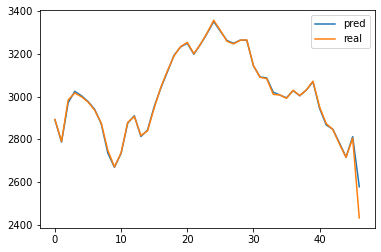

In [13]:
bmodel = TransformerTimeSeries(feature_dim = feature_dim,
                                  nhead = 4,num_layers = 12,d_model = 512,
                                  conv_len = 5,feature_weight = True,embedding_weight = True)
bmodel.load_state_dict(torch.load('AMZN_L'))
bmodel.to(device)
bmodel.eval()
with torch.no_grad(): # eliminate gradient i.e. gradients only exists in train()

    for step,(x,y,feature,attention_masks) in enumerate(test_dl):
        x = x.to(device)
        y = y.to(device)
        feature = feature.to(device)
        
        #y = torch.cat([y[:,0:5],torch.ones(47,1).cuda()],1)
        #feature = torch.cat([feature[:,:,0:5],torch.ones(47,90,1).cuda()],2)
        
        attention_masks = attention_masks.to(device)
        output = bmodel(x,y,feature,attention_masks[0])
        
        pred = data[train_size + 1 :-1,2]*0.01*(100+output[:,t0:].squeeze()).detach().cpu()
        real = data[train_size + 1 :-1,2]*0.01*(100+y[:,t0:].squeeze()).detach().cpu()

        plt.plot(pred)
        plt.plot(real)
        plt.legend(['pred','real'])
        MAE = torch.nn.L1Loss()(pred,real).item()
        MSE = torch.nn.MSELoss()(pred,real).item()
        RMSE = np.sqrt(MSE)
        
        print(f'AMZN MAE is {MAE}')
        print(f'AMZN MSE is {MSE}')
        print(f'AMZN RMSE is {RMSE}')

##### close

In [14]:
file_name = 'AMZN_features.csv'
with open(file_name) as f:
    data_list = csv.reader(f)
    data = []
    for row in data_list:
        data.append(row)
    f.close()
    
data = torch.tensor(np.delete(np.array(data)[1:,2:],4,axis = 1).astype(np.float)).type(torch.float)

feature_dim = data.shape[1] - 1
rate = []
for i in range(1,data.shape[0]):
    rate.append((100*(data[i,0:4] - data[i-1,0:4])/data[i-1,0:4]).reshape(1,4))
    
rate = torch.cat(rate)
rate_data = torch.cat([rate,data[1:,4:]],1)
train_size = int(data.shape[0]*0.9)
data_train = rate_data[0:train_size]
data_test = rate_data[train_size-4:]


t0 = 5
to_predict = 1
train_dataset = GetData(data_train[:,3],torch.cat([data_train[:,0:3],data_train[:,4:]],1),t0 = t0, to_predict = to_predict)
test_dataset = GetData(data_test[:,3],torch.cat([data_test[:,0:3],data_test[:,4:]],1),t0 = t0, to_predict = to_predict)
criterion = torch.nn.MSELoss()
# dataloaders
train_dl = DataLoader(train_dataset,batch_size=256,shuffle=True)
test_dl = DataLoader(test_dataset,batch_size=512)





model = TransformerTimeSeries(feature_dim = feature_dim,
                              nhead = 4,num_layers = 12,d_model = 512,
                              conv_len = 5,feature_weight = True,embedding_weight = True)
model = model.to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=1e-5 ,momentum = 0.9, nesterov = True)#Adam optimizer
#scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer,5e-7,3e-5,10,mode = 'exp_range',gamma = 0.9996)



train_epoch_loss = []
test_epoch_loss = []
test_best = 9999
for epoch in tqdm(range(4000)):


    l_t = train_epoch(model,train_dl,optimizer,t0,to_predict)

    train_loss = test_epoch(model,train_dl,t0,to_predict)


    test_loss = test_epoch(model,test_dl,t0,to_predict)


    if test_best > test_loss:
        test_best = test_loss
        torch.save(model.state_dict(), 'AMZN_C')



    train_epoch_loss.append(np.mean(train_loss))
    test_epoch_loss.append(test_loss)

    print("Epoch {}: Train loss: {} \t test loss: {}".format(epoch+1,
                                                             np.mean(train_loss),
                                                             test_loss))
    #scheduler.step()


torch.Size([431, 6])
torch.Size([431, 6])
torch.Size([47, 6])
torch.Size([47, 6])


  0%|                                                                                     | 0/4000 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1944: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
  0%|                                                                             | 1/4000 [00:00<23:54,  2.79it/s]

Epoch 1: Train loss: 1.450357313222509 	 test loss: 2.4806041717529297


  0%|                                                                           | 3/4000 [00:05<2:04:34,  1.87s/it]

Epoch 2: Train loss: 1.440585672993671 	 test loss: 2.4803884029388428
Epoch 3: Train loss: 1.4340279044242026 	 test loss: 2.4816339015960693


  0%|                                                                             | 5/4000 [00:06<53:49,  1.24it/s]

Epoch 4: Train loss: 1.4305711633368048 	 test loss: 2.4829022884368896
Epoch 5: Train loss: 1.429867293884472 	 test loss: 2.4837305545806885


  0%|▏                                                                            | 7/4000 [00:06<28:59,  2.30it/s]

Epoch 6: Train loss: 1.4301356953977156 	 test loss: 2.487854242324829
Epoch 7: Train loss: 1.430233519481119 	 test loss: 2.4909093379974365


  0%|▏                                                                            | 9/4000 [00:06<18:27,  3.60it/s]

Epoch 8: Train loss: 1.429607008006899 	 test loss: 2.4908294677734375
Epoch 9: Train loss: 1.4278896626629576 	 test loss: 2.4877538681030273


  0%|▏                                                                           | 10/4000 [00:06<15:34,  4.27it/s]

Epoch 10: Train loss: 1.4256662390348254 	 test loss: 2.483100414276123


  0%|▏                                                                         | 11/4000 [00:12<2:10:55,  1.97s/it]

Epoch 11: Train loss: 1.4234346187308327 	 test loss: 2.4774160385131836


  0%|▏                                                                         | 12/4000 [00:19<3:43:57,  3.37s/it]

Epoch 12: Train loss: 1.421236477152654 	 test loss: 2.4710309505462646


  0%|▏                                                                         | 13/4000 [00:25<4:49:49,  4.36s/it]

Epoch 13: Train loss: 1.4192536903368071 	 test loss: 2.4657328128814697


  0%|▎                                                                         | 14/4000 [00:32<5:34:31,  5.04s/it]

Epoch 14: Train loss: 1.417527360595296 	 test loss: 2.4610021114349365


  0%|▎                                                                         | 15/4000 [00:39<6:02:32,  5.46s/it]

Epoch 15: Train loss: 1.4159794122049814 	 test loss: 2.4571282863616943


  0%|▎                                                                         | 16/4000 [00:45<6:28:49,  5.86s/it]

Epoch 16: Train loss: 1.414538725899433 	 test loss: 2.4535787105560303


  0%|▎                                                                         | 17/4000 [00:52<6:43:39,  6.08s/it]

Epoch 17: Train loss: 1.4132444850253394 	 test loss: 2.450645923614502


  0%|▎                                                                         | 18/4000 [00:58<6:53:57,  6.24s/it]

Epoch 18: Train loss: 1.412002520052297 	 test loss: 2.4480926990509033


  0%|▎                                                                         | 19/4000 [01:05<7:00:55,  6.34s/it]

Epoch 19: Train loss: 1.4107545760834024 	 test loss: 2.4454381465911865


  0%|▎                                                                         | 20/4000 [01:12<7:04:07,  6.39s/it]

Epoch 20: Train loss: 1.4094853619688348 	 test loss: 2.4432098865509033


  1%|▍                                                                         | 21/4000 [01:18<7:08:08,  6.46s/it]

Epoch 21: Train loss: 1.4083140239361545 	 test loss: 2.441680431365967


  1%|▍                                                                         | 22/4000 [01:25<7:06:25,  6.43s/it]

Epoch 22: Train loss: 1.40712517762682 	 test loss: 2.440354585647583


  1%|▍                                                                         | 23/4000 [01:31<7:15:44,  6.57s/it]

Epoch 23: Train loss: 1.4060444416966627 	 test loss: 2.4391186237335205


  1%|▍                                                                         | 24/4000 [01:38<7:15:59,  6.58s/it]

Epoch 24: Train loss: 1.4049947176068123 	 test loss: 2.4379734992980957


  1%|▍                                                                         | 25/4000 [01:45<7:15:21,  6.57s/it]

Epoch 25: Train loss: 1.4039440597569584 	 test loss: 2.4369966983795166


  1%|▍                                                                         | 26/4000 [01:51<7:17:29,  6.61s/it]

Epoch 26: Train loss: 1.4028175820330733 	 test loss: 2.4353229999542236


  1%|▍                                                                         | 27/4000 [01:58<7:16:02,  6.59s/it]

Epoch 27: Train loss: 1.4016098364876484 	 test loss: 2.433189868927002


  1%|▌                                                                         | 28/4000 [02:05<7:22:54,  6.69s/it]

Epoch 28: Train loss: 1.4005337978460397 	 test loss: 2.431711435317993


  1%|▌                                                                         | 29/4000 [02:10<7:02:43,  6.39s/it]

Epoch 29: Train loss: 1.3994434773230497 	 test loss: 2.429884910583496


  1%|▌                                                                         | 30/4000 [02:18<7:19:39,  6.64s/it]

Epoch 30: Train loss: 1.398249359252558 	 test loss: 2.427556276321411


  1%|▌                                                                         | 31/4000 [02:24<7:18:53,  6.63s/it]

Epoch 31: Train loss: 1.3969739515100996 	 test loss: 2.4251394271850586


  1%|▌                                                                         | 32/4000 [02:31<7:18:31,  6.63s/it]

Epoch 32: Train loss: 1.3957934852542568 	 test loss: 2.42303204536438


  1%|▌                                                                         | 33/4000 [02:38<7:17:41,  6.62s/it]

Epoch 33: Train loss: 1.3945503638681291 	 test loss: 2.4207065105438232


  1%|▋                                                                         | 34/4000 [02:44<7:16:12,  6.60s/it]

Epoch 34: Train loss: 1.3934232563540996 	 test loss: 2.418889284133911


  1%|▋                                                                         | 35/4000 [02:51<7:16:59,  6.61s/it]

Epoch 35: Train loss: 1.3922254815179067 	 test loss: 2.416891574859619


  1%|▋                                                                         | 36/4000 [02:57<7:15:53,  6.60s/it]

Epoch 36: Train loss: 1.391039579484413 	 test loss: 2.4150049686431885


  1%|▋                                                                         | 37/4000 [03:04<7:17:06,  6.62s/it]

Epoch 37: Train loss: 1.3899271242026663 	 test loss: 2.4131662845611572


  1%|▋                                                                         | 38/4000 [03:11<7:16:17,  6.61s/it]

Epoch 38: Train loss: 1.3889873940540853 	 test loss: 2.4120945930480957


  1%|▋                                                                         | 39/4000 [03:17<7:16:17,  6.61s/it]

Epoch 39: Train loss: 1.3878067054217487 	 test loss: 2.4100162982940674


  1%|▋                                                                         | 40/4000 [03:24<7:15:51,  6.60s/it]

Epoch 40: Train loss: 1.38636494319013 	 test loss: 2.406780958175659


  1%|▊                                                                         | 41/4000 [03:30<7:15:57,  6.61s/it]

Epoch 41: Train loss: 1.3848675896009548 	 test loss: 2.403123140335083


  1%|▊                                                                         | 42/4000 [03:37<7:15:33,  6.60s/it]

Epoch 42: Train loss: 1.3835349730161945 	 test loss: 2.400330066680908


  1%|▊                                                                         | 43/4000 [03:44<7:15:36,  6.61s/it]

Epoch 43: Train loss: 1.382213661399629 	 test loss: 2.397888422012329


  1%|▊                                                                         | 44/4000 [03:50<7:14:40,  6.59s/it]

Epoch 44: Train loss: 1.3809733863773037 	 test loss: 2.395501136779785


  1%|▊                                                                         | 45/4000 [03:57<7:15:34,  6.61s/it]

Epoch 45: Train loss: 1.3798299366802738 	 test loss: 2.3938989639282227


  1%|▊                                                                         | 46/4000 [04:03<7:15:13,  6.60s/it]

Epoch 46: Train loss: 1.3786944728992931 	 test loss: 2.3926072120666504


  1%|▊                                                                         | 47/4000 [04:10<7:15:16,  6.61s/it]

Epoch 47: Train loss: 1.3775142453386169 	 test loss: 2.390946388244629


  1%|▉                                                                         | 48/4000 [04:17<7:14:15,  6.59s/it]

Epoch 48: Train loss: 1.3764463687994088 	 test loss: 2.389355421066284


  1%|▉                                                                         | 49/4000 [04:23<7:15:08,  6.61s/it]

Epoch 49: Train loss: 1.3753857861538774 	 test loss: 2.387970447540283


  1%|▉                                                                         | 50/4000 [04:30<7:14:09,  6.59s/it]

Epoch 50: Train loss: 1.3741948635008385 	 test loss: 2.3857924938201904


  1%|▉                                                                         | 51/4000 [04:36<7:14:51,  6.61s/it]

Epoch 51: Train loss: 1.3726596904188186 	 test loss: 2.3823416233062744


  1%|▉                                                                         | 52/4000 [04:43<7:14:51,  6.61s/it]

Epoch 52: Train loss: 1.371249073342768 	 test loss: 2.379364013671875


  1%|▉                                                                         | 53/4000 [04:50<7:14:24,  6.60s/it]

Epoch 53: Train loss: 1.3696451148411515 	 test loss: 2.375577211380005


  1%|▉                                                                         | 54/4000 [04:56<7:14:28,  6.61s/it]

Epoch 54: Train loss: 1.3681930892705365 	 test loss: 2.3722615242004395


  1%|█                                                                         | 55/4000 [05:02<7:07:43,  6.51s/it]

Epoch 55: Train loss: 1.3667773597478314 	 test loss: 2.369305372238159


  1%|█                                                                         | 56/4000 [05:10<7:19:55,  6.69s/it]

Epoch 56: Train loss: 1.3654538594929635 	 test loss: 2.3668172359466553


  1%|█                                                                         | 57/4000 [05:16<7:19:28,  6.69s/it]

Epoch 57: Train loss: 1.3639872995164168 	 test loss: 2.364208936691284


  1%|█                                                                         | 58/4000 [05:23<7:12:35,  6.58s/it]

Epoch 58: Train loss: 1.3627306784388638 	 test loss: 2.3621551990509033


  1%|█                                                                         | 59/4000 [05:29<7:12:25,  6.58s/it]

Epoch 59: Train loss: 1.3613853877768993 	 test loss: 2.3599283695220947


  2%|█                                                                         | 60/4000 [05:36<7:10:54,  6.56s/it]

Epoch 60: Train loss: 1.3598157850606258 	 test loss: 2.356720447540283


  2%|█▏                                                                        | 61/4000 [05:42<7:13:36,  6.60s/it]

Epoch 61: Train loss: 1.358186208455026 	 test loss: 2.353165864944458


  2%|█▏                                                                        | 62/4000 [05:49<7:13:28,  6.60s/it]

Epoch 62: Train loss: 1.3565560003997554 	 test loss: 2.3497467041015625


  2%|█▏                                                                        | 63/4000 [05:55<7:00:02,  6.40s/it]

Epoch 63: Train loss: 1.3551606883029097 	 test loss: 2.34735369682312


  2%|█▏                                                                        | 64/4000 [06:02<7:16:45,  6.66s/it]

Epoch 64: Train loss: 1.3535971005388867 	 test loss: 2.3445723056793213


  2%|█▏                                                                        | 65/4000 [06:09<7:16:11,  6.65s/it]

Epoch 65: Train loss: 1.352121472911879 	 test loss: 2.34205961227417


  2%|█▏                                                                        | 66/4000 [06:15<7:14:43,  6.63s/it]

Epoch 66: Train loss: 1.3504944619335875 	 test loss: 2.339158296585083


  2%|█▏                                                                        | 67/4000 [06:22<7:13:00,  6.61s/it]

Epoch 67: Train loss: 1.348711417058781 	 test loss: 2.335803985595703


  2%|█▎                                                                        | 68/4000 [06:29<7:13:31,  6.62s/it]

Epoch 68: Train loss: 1.3472042700530757 	 test loss: 2.333331346511841


  2%|█▎                                                                        | 69/4000 [06:35<7:13:34,  6.62s/it]

Epoch 69: Train loss: 1.3458295200374453 	 test loss: 2.3310012817382812


  2%|█▎                                                                        | 70/4000 [06:42<7:13:32,  6.62s/it]

Epoch 70: Train loss: 1.3442937047188355 	 test loss: 2.328141450881958


  2%|█▎                                                                        | 71/4000 [06:48<7:12:57,  6.61s/it]

Epoch 71: Train loss: 1.3429513204401995 	 test loss: 2.3258590698242188


  2%|█▎                                                                        | 72/4000 [06:55<7:12:26,  6.61s/it]

Epoch 72: Train loss: 1.3422574515685681 	 test loss: 2.325016736984253


  2%|█▎                                                                        | 73/4000 [07:01<7:06:07,  6.51s/it]

Epoch 73: Train loss: 1.3414845463847893 	 test loss: 2.3238377571105957


  2%|█▎                                                                        | 74/4000 [07:08<7:05:10,  6.50s/it]

Epoch 74: Train loss: 1.34000076274031 	 test loss: 2.32110595703125


  2%|█▍                                                                        | 75/4000 [07:15<7:16:19,  6.67s/it]

Epoch 75: Train loss: 1.3385357060177974 	 test loss: 2.3183796405792236


  2%|█▍                                                                        | 76/4000 [07:21<7:14:55,  6.65s/it]

Epoch 76: Train loss: 1.3367741478568163 	 test loss: 2.3150415420532227


  2%|█▍                                                                        | 77/4000 [07:28<7:12:50,  6.62s/it]

Epoch 77: Train loss: 1.3354302509201652 	 test loss: 2.3126142024993896


  2%|█▍                                                                        | 78/4000 [07:35<7:13:12,  6.63s/it]

Epoch 78: Train loss: 1.3339590782908994 	 test loss: 2.309992551803589


  2%|█▍                                                                        | 79/4000 [07:41<6:59:34,  6.42s/it]

Epoch 79: Train loss: 1.3319901789424038 	 test loss: 2.3062520027160645


  2%|█▍                                                                        | 80/4000 [07:48<7:16:19,  6.68s/it]

Epoch 80: Train loss: 1.3300836384987886 	 test loss: 2.302729845046997


  2%|█▍                                                                        | 81/4000 [07:54<7:14:46,  6.66s/it]

Epoch 81: Train loss: 1.3282713638380896 	 test loss: 2.299376964569092


  2%|█▌                                                                        | 82/4000 [08:01<7:12:59,  6.63s/it]

Epoch 82: Train loss: 1.3267109814486757 	 test loss: 2.296516180038452


  2%|█▌                                                                        | 83/4000 [08:08<7:12:44,  6.63s/it]

Epoch 83: Train loss: 1.32514663500465 	 test loss: 2.293569326400757


  2%|█▌                                                                        | 84/4000 [08:14<7:12:07,  6.62s/it]

Epoch 84: Train loss: 1.323652965563356 	 test loss: 2.290935754776001


  2%|█▌                                                                        | 85/4000 [08:21<7:11:38,  6.62s/it]

Epoch 85: Train loss: 1.3219772361547377 	 test loss: 2.287825584411621


  2%|█▌                                                                        | 86/4000 [08:28<7:11:31,  6.62s/it]

Epoch 86: Train loss: 1.320054575904616 	 test loss: 2.2842211723327637


  2%|█▌                                                                        | 87/4000 [08:34<7:09:58,  6.59s/it]

Epoch 87: Train loss: 1.3186414623481768 	 test loss: 2.281614065170288


  2%|█▋                                                                        | 88/4000 [08:41<7:10:40,  6.61s/it]

Epoch 88: Train loss: 1.3166854008167912 	 test loss: 2.2779109477996826


  2%|█▋                                                                        | 89/4000 [08:47<7:10:30,  6.60s/it]

Epoch 89: Train loss: 1.314495180433145 	 test loss: 2.2737412452697754


  2%|█▋                                                                        | 90/4000 [08:54<7:08:10,  6.57s/it]

Epoch 90: Train loss: 1.3125278443582096 	 test loss: 2.2698776721954346


  2%|█▋                                                                        | 91/4000 [09:01<7:11:08,  6.62s/it]

Epoch 91: Train loss: 1.3103469723615182 	 test loss: 2.2654974460601807


  2%|█▋                                                                        | 92/4000 [09:07<7:10:42,  6.61s/it]

Epoch 92: Train loss: 1.3083124951807363 	 test loss: 2.2615549564361572


  2%|█▋                                                                        | 93/4000 [09:14<7:09:46,  6.60s/it]

Epoch 93: Train loss: 1.3061356453220694 	 test loss: 2.257225751876831


  2%|█▋                                                                        | 94/4000 [09:20<7:10:32,  6.61s/it]

Epoch 94: Train loss: 1.3039575273088955 	 test loss: 2.2529919147491455


  2%|█▊                                                                        | 95/4000 [09:27<7:10:12,  6.61s/it]

Epoch 95: Train loss: 1.301860615438209 	 test loss: 2.248931884765625


  2%|█▊                                                                        | 96/4000 [09:34<7:10:00,  6.61s/it]

Epoch 96: Train loss: 1.3001227223956116 	 test loss: 2.2454614639282227


  2%|█▊                                                                        | 97/4000 [09:40<7:09:46,  6.61s/it]

Epoch 97: Train loss: 1.2976956713227275 	 test loss: 2.2406296730041504


  2%|█▊                                                                        | 98/4000 [09:47<7:09:11,  6.60s/it]

Epoch 98: Train loss: 1.2957554350319704 	 test loss: 2.2367305755615234


  2%|█▊                                                                        | 99/4000 [09:53<7:00:34,  6.47s/it]

Epoch 99: Train loss: 1.2935179032195194 	 test loss: 2.232189655303955


  2%|█▊                                                                       | 100/4000 [10:00<7:08:52,  6.60s/it]

Epoch 100: Train loss: 1.2911152762216094 	 test loss: 2.22721004486084


  3%|█▊                                                                       | 101/4000 [10:07<7:12:04,  6.65s/it]

Epoch 101: Train loss: 1.2887288846438556 	 test loss: 2.2222657203674316


  3%|█▊                                                                       | 102/4000 [10:13<7:11:03,  6.63s/it]

Epoch 102: Train loss: 1.2861620431156557 	 test loss: 2.217010021209717


  3%|█▉                                                                       | 103/4000 [10:20<7:08:52,  6.60s/it]

Epoch 103: Train loss: 1.283931739369014 	 test loss: 2.2124814987182617


  3%|█▉                                                                       | 104/4000 [10:26<7:10:12,  6.63s/it]

Epoch 104: Train loss: 1.2821768331417074 	 test loss: 2.208941698074341


  3%|█▉                                                                       | 105/4000 [10:33<7:09:52,  6.62s/it]

Epoch 105: Train loss: 1.2799109217738884 	 test loss: 2.2040698528289795


  3%|█▉                                                                       | 106/4000 [10:40<7:09:24,  6.62s/it]

Epoch 106: Train loss: 1.2779559679761563 	 test loss: 2.2000107765197754


  3%|█▉                                                                       | 107/4000 [10:46<7:08:49,  6.61s/it]

Epoch 107: Train loss: 1.2753523153937887 	 test loss: 2.194293975830078


  3%|█▉                                                                       | 108/4000 [10:53<7:08:09,  6.60s/it]

Epoch 108: Train loss: 1.2726734124314205 	 test loss: 2.1880977153778076


  3%|█▉                                                                       | 109/4000 [10:59<6:55:19,  6.40s/it]

Epoch 109: Train loss: 1.2707837222623715 	 test loss: 2.184040069580078


  3%|██                                                                       | 110/4000 [11:06<7:11:52,  6.66s/it]

Epoch 110: Train loss: 1.2688149800156772 	 test loss: 2.1800003051757812


  3%|██                                                                       | 111/4000 [11:13<7:10:15,  6.64s/it]

Epoch 111: Train loss: 1.2670220294297434 	 test loss: 2.1763813495635986


  3%|██                                                                       | 112/4000 [11:19<7:09:02,  6.62s/it]

Epoch 112: Train loss: 1.2644975973669172 	 test loss: 2.171581983566284


  3%|██                                                                       | 113/4000 [11:26<7:09:34,  6.63s/it]

Epoch 113: Train loss: 1.261189319141503 	 test loss: 2.1652042865753174


  3%|██                                                                       | 114/4000 [11:32<6:56:23,  6.43s/it]

Epoch 114: Train loss: 1.258276760993037 	 test loss: 2.160172700881958


  3%|██                                                                       | 115/4000 [11:39<7:16:25,  6.74s/it]

Epoch 115: Train loss: 1.2554526459036737 	 test loss: 2.155193567276001


  3%|██                                                                       | 116/4000 [11:45<7:07:01,  6.60s/it]

Epoch 116: Train loss: 1.2534083930079731 	 test loss: 2.151738166809082


  3%|██▏                                                                      | 117/4000 [11:52<7:09:27,  6.64s/it]

Epoch 117: Train loss: 1.2513989398208405 	 test loss: 2.148301124572754


  3%|██▏                                                                      | 118/4000 [11:59<7:08:04,  6.62s/it]

Epoch 118: Train loss: 1.2490481909908995 	 test loss: 2.1441500186920166


  3%|██▏                                                                      | 119/4000 [12:05<7:02:13,  6.53s/it]

Epoch 119: Train loss: 1.247207985676635 	 test loss: 2.140799045562744


  3%|██▏                                                                      | 120/4000 [12:12<7:10:04,  6.65s/it]

Epoch 120: Train loss: 1.2458116698431028 	 test loss: 2.137484550476074


  3%|██▏                                                                      | 121/4000 [12:19<7:08:49,  6.63s/it]

Epoch 121: Train loss: 1.2439076059655634 	 test loss: 2.133544921875


  3%|██▏                                                                      | 122/4000 [12:25<7:01:27,  6.52s/it]

Epoch 122: Train loss: 1.2414510529445109 	 test loss: 2.1291680335998535


  3%|██▏                                                                      | 123/4000 [12:32<7:09:10,  6.64s/it]

Epoch 123: Train loss: 1.2383636781068523 	 test loss: 2.1238906383514404


  3%|██▎                                                                      | 124/4000 [12:38<7:08:42,  6.64s/it]

Epoch 124: Train loss: 1.2341981968580984 	 test loss: 2.1171605587005615


  3%|██▎                                                                      | 125/4000 [12:45<7:05:56,  6.60s/it]

Epoch 125: Train loss: 1.2296534840302789 	 test loss: 2.11004900932312


  3%|██▎                                                                      | 126/4000 [12:52<7:07:25,  6.62s/it]

Epoch 126: Train loss: 1.2264364426761105 	 test loss: 2.1042168140411377


  3%|██▎                                                                      | 127/4000 [12:58<7:07:45,  6.63s/it]

Epoch 127: Train loss: 1.2234557808966757 	 test loss: 2.0988266468048096


  3%|██▎                                                                      | 128/4000 [13:05<7:07:10,  6.62s/it]

Epoch 128: Train loss: 1.220651525079236 	 test loss: 2.093900442123413


  3%|██▎                                                                      | 129/4000 [13:11<7:06:43,  6.61s/it]

Epoch 129: Train loss: 1.217602344234139 	 test loss: 2.0882627964019775


  3%|██▎                                                                      | 130/4000 [13:18<7:06:35,  6.61s/it]

Epoch 130: Train loss: 1.2145349722174092 	 test loss: 2.0822834968566895


  3%|██▍                                                                      | 131/4000 [13:25<7:05:53,  6.60s/it]

Epoch 131: Train loss: 1.211631659288694 	 test loss: 2.0768864154815674


  3%|██▍                                                                      | 132/4000 [13:31<7:05:45,  6.60s/it]

Epoch 132: Train loss: 1.2090734973584416 	 test loss: 2.0720479488372803


  3%|██▍                                                                      | 133/4000 [13:38<7:02:35,  6.56s/it]

Epoch 133: Train loss: 1.2056354046421096 	 test loss: 2.06644868850708


  3%|██▍                                                                      | 134/4000 [13:44<7:06:34,  6.62s/it]

Epoch 134: Train loss: 1.2022453186960065 	 test loss: 2.0616018772125244


  3%|██▍                                                                      | 135/4000 [13:51<7:06:18,  6.62s/it]

Epoch 135: Train loss: 1.1989793027913211 	 test loss: 2.055767774581909


  3%|██▍                                                                      | 136/4000 [13:58<7:04:21,  6.59s/it]

Epoch 136: Train loss: 1.1964198262398316 	 test loss: 2.050503969192505


  3%|██▌                                                                      | 137/4000 [14:05<7:10:43,  6.69s/it]

Epoch 137: Train loss: 1.1937125503601995 	 test loss: 2.0459043979644775


  3%|██▌                                                                      | 138/4000 [14:11<7:04:05,  6.59s/it]

Epoch 138: Train loss: 1.1928769695786479 	 test loss: 2.0419204235076904


  3%|██▌                                                                      | 139/4000 [14:17<7:04:15,  6.59s/it]

Epoch 139: Train loss: 1.1901397301260115 	 test loss: 2.035574436187744


  4%|██▌                                                                      | 140/4000 [14:24<7:04:19,  6.60s/it]

Epoch 140: Train loss: 1.1861771040892104 	 test loss: 2.0292744636535645


  4%|██▌                                                                      | 141/4000 [14:30<6:57:09,  6.49s/it]

Epoch 141: Train loss: 1.1830395642676652 	 test loss: 2.0237386226654053


  4%|██▌                                                                      | 142/4000 [14:37<7:05:09,  6.61s/it]

Epoch 142: Train loss: 1.17996677251537 	 test loss: 2.017681837081909


  4%|██▌                                                                      | 143/4000 [14:44<7:06:04,  6.63s/it]

Epoch 143: Train loss: 1.1767879688546166 	 test loss: 2.0121400356292725


  4%|██▋                                                                      | 144/4000 [14:51<7:10:40,  6.70s/it]

Epoch 144: Train loss: 1.173344993535991 	 test loss: 2.0058538913726807


  4%|██▋                                                                      | 145/4000 [14:57<7:03:14,  6.59s/it]

Epoch 145: Train loss: 1.1694449202920334 	 test loss: 1.9992954730987549


  4%|██▋                                                                      | 146/4000 [15:04<7:02:04,  6.57s/it]

Epoch 146: Train loss: 1.1646346877179954 	 test loss: 1.9919712543487549


  4%|██▋                                                                      | 147/4000 [15:10<7:04:19,  6.61s/it]

Epoch 147: Train loss: 1.161550906860635 	 test loss: 1.9848593473434448


  4%|██▋                                                                      | 148/4000 [15:17<7:04:08,  6.61s/it]

Epoch 148: Train loss: 1.1589315891819045 	 test loss: 1.9784305095672607


  4%|██▋                                                                      | 149/4000 [15:23<7:03:46,  6.60s/it]

Epoch 149: Train loss: 1.1582127353154865 	 test loss: 1.9720150232315063


  4%|██▋                                                                      | 150/4000 [15:30<7:01:53,  6.58s/it]

Epoch 150: Train loss: 1.1544428856356237 	 test loss: 1.9651998281478882


  4%|██▊                                                                      | 151/4000 [15:37<7:00:35,  6.56s/it]

Epoch 151: Train loss: 1.1510561367198653 	 test loss: 1.9584137201309204


  4%|██▊                                                                      | 152/4000 [15:43<7:05:10,  6.63s/it]

Epoch 152: Train loss: 1.147112036802376 	 test loss: 1.9510185718536377


  4%|██▊                                                                      | 153/4000 [15:49<6:50:43,  6.41s/it]

Epoch 153: Train loss: 1.143696775015988 	 test loss: 1.9441261291503906


  4%|██▊                                                                      | 154/4000 [15:57<7:08:00,  6.68s/it]

Epoch 154: Train loss: 1.1404418228950413 	 test loss: 1.9377148151397705


  4%|██▊                                                                      | 155/4000 [16:03<7:06:29,  6.66s/it]

Epoch 155: Train loss: 1.1372044191559616 	 test loss: 1.9288647174835205


  4%|██▊                                                                      | 156/4000 [16:10<7:03:00,  6.60s/it]

Epoch 156: Train loss: 1.1319587944278584 	 test loss: 1.9224275350570679


  4%|██▊                                                                      | 157/4000 [16:16<7:05:17,  6.64s/it]

Epoch 157: Train loss: 1.1269483646494607 	 test loss: 1.9160857200622559


  4%|██▉                                                                      | 158/4000 [16:23<7:04:16,  6.63s/it]

Epoch 158: Train loss: 1.1230467394720374 	 test loss: 1.9087737798690796


  4%|██▉                                                                      | 159/4000 [16:29<6:57:46,  6.53s/it]

Epoch 159: Train loss: 1.118733674356943 	 test loss: 1.9020599126815796


  4%|██▉                                                                      | 160/4000 [16:36<7:05:24,  6.65s/it]

Epoch 160: Train loss: 1.1141233305920029 	 test loss: 1.8930747509002686


  4%|██▉                                                                      | 161/4000 [16:43<7:03:14,  6.61s/it]

Epoch 161: Train loss: 1.1137210501319017 	 test loss: 1.8869364261627197


  4%|██▉                                                                      | 162/4000 [16:50<7:12:26,  6.76s/it]

Epoch 162: Train loss: 1.1153475256364473 	 test loss: 1.8808921575546265


  4%|██▉                                                                      | 163/4000 [16:56<7:01:55,  6.60s/it]

Epoch 163: Train loss: 1.1086813623556682 	 test loss: 1.874222755432129


  4%|██▉                                                                      | 164/4000 [17:03<7:08:19,  6.70s/it]

Epoch 164: Train loss: 1.1018287792559842 	 test loss: 1.8662134408950806


  4%|███                                                                      | 165/4000 [17:09<7:05:21,  6.65s/it]

Epoch 165: Train loss: 1.0981063176197132 	 test loss: 1.859320878982544


  4%|███                                                                      | 166/4000 [17:16<7:04:03,  6.64s/it]

Epoch 166: Train loss: 1.0936692950343865 	 test loss: 1.8519052267074585


  4%|███                                                                      | 167/4000 [17:22<6:51:32,  6.44s/it]

Epoch 167: Train loss: 1.0919879713633773 	 test loss: 1.8442933559417725


  4%|███                                                                      | 168/4000 [17:29<7:08:17,  6.71s/it]

Epoch 168: Train loss: 1.0885014876965304 	 test loss: 1.8364884853363037


  4%|███                                                                      | 169/4000 [17:36<7:05:35,  6.67s/it]

Epoch 169: Train loss: 1.087166333972993 	 test loss: 1.8287184238433838


  4%|███                                                                      | 170/4000 [17:43<7:03:16,  6.63s/it]

Epoch 170: Train loss: 1.0796725210623508 	 test loss: 1.8207755088806152


  4%|███                                                                      | 171/4000 [17:49<7:02:02,  6.61s/it]

Epoch 171: Train loss: 1.0778985430082424 	 test loss: 1.811888575553894


  4%|███▏                                                                     | 172/4000 [17:56<7:03:30,  6.64s/it]

Epoch 172: Train loss: 1.0746229306174542 	 test loss: 1.8033688068389893


  4%|███▏                                                                     | 173/4000 [18:02<7:02:43,  6.63s/it]

Epoch 173: Train loss: 1.0688107738362111 	 test loss: 1.795495629310608


  4%|███▏                                                                     | 174/4000 [18:09<7:07:31,  6.70s/it]

Epoch 174: Train loss: 1.05984222474065 	 test loss: 1.7892398834228516


  4%|███▏                                                                     | 175/4000 [18:16<7:04:52,  6.66s/it]

Epoch 175: Train loss: 1.0552489392442106 	 test loss: 1.7810171842575073


  4%|███▏                                                                     | 176/4000 [18:22<7:03:01,  6.64s/it]

Epoch 176: Train loss: 1.0520573799128876 	 test loss: 1.7720599174499512


  4%|███▏                                                                     | 177/4000 [18:29<6:58:15,  6.56s/it]

Epoch 177: Train loss: 1.054141605398218 	 test loss: 1.762840747833252


  4%|███▏                                                                     | 178/4000 [18:35<6:59:15,  6.58s/it]

Epoch 178: Train loss: 1.055452944231144 	 test loss: 1.7547760009765625


  4%|███▎                                                                     | 179/4000 [18:42<6:59:23,  6.59s/it]

Epoch 179: Train loss: 1.0489480614385582 	 test loss: 1.7473965883255005


  4%|███▎                                                                     | 180/4000 [18:49<6:59:36,  6.59s/it]

Epoch 180: Train loss: 1.038827100652 	 test loss: 1.7400522232055664


  5%|███▎                                                                     | 181/4000 [18:55<7:04:31,  6.67s/it]

Epoch 181: Train loss: 1.0320445877216808 	 test loss: 1.7321995496749878


  5%|███▎                                                                     | 182/4000 [19:02<6:57:36,  6.56s/it]

Epoch 182: Train loss: 1.023242799145993 	 test loss: 1.725358247756958


  5%|███▎                                                                     | 183/4000 [19:08<6:58:39,  6.58s/it]

Epoch 183: Train loss: 1.0183688176756944 	 test loss: 1.717279314994812


  5%|███▎                                                                     | 184/4000 [19:15<6:59:31,  6.60s/it]

Epoch 184: Train loss: 1.0164581011730114 	 test loss: 1.7081044912338257


  5%|███▍                                                                     | 185/4000 [19:22<6:59:22,  6.60s/it]

Epoch 185: Train loss: 1.0154946229297435 	 test loss: 1.699711799621582


  5%|███▍                                                                     | 186/4000 [19:28<6:57:51,  6.57s/it]

Epoch 186: Train loss: 1.0117551262583369 	 test loss: 1.6926220655441284


  5%|███▍                                                                     | 187/4000 [19:35<6:59:52,  6.61s/it]

Epoch 187: Train loss: 1.0098721809564224 	 test loss: 1.6849267482757568


  5%|███▍                                                                     | 188/4000 [19:41<6:59:52,  6.61s/it]

Epoch 188: Train loss: 1.0198917706991846 	 test loss: 1.6793324947357178


  5%|███▍                                                                     | 189/4000 [19:48<6:59:37,  6.61s/it]

Epoch 189: Train loss: 1.008374022358808 	 test loss: 1.6692758798599243


  5%|███▍                                                                     | 190/4000 [19:55<6:59:18,  6.60s/it]

Epoch 190: Train loss: 0.9934925338784946 	 test loss: 1.6588146686553955


  5%|███▍                                                                     | 191/4000 [20:01<7:01:37,  6.64s/it]

Epoch 191: Train loss: 0.9952069978702925 	 test loss: 1.6518748998641968


  5%|███▌                                                                     | 192/4000 [20:08<6:58:12,  6.59s/it]

Epoch 192: Train loss: 0.9899156951019217 	 test loss: 1.6450837850570679


  5%|███▌                                                                     | 193/4000 [20:14<6:58:44,  6.60s/it]

Epoch 193: Train loss: 0.9755335664527875 	 test loss: 1.631717562675476


  5%|███▌                                                                     | 194/4000 [20:21<6:58:17,  6.59s/it]

Epoch 194: Train loss: 0.9650413118769564 	 test loss: 1.6239118576049805


  5%|███▌                                                                     | 195/4000 [20:28<6:57:07,  6.58s/it]

Epoch 195: Train loss: 0.9585010349888813 	 test loss: 1.6151303052902222


  5%|███▌                                                                     | 196/4000 [20:34<6:56:38,  6.57s/it]

Epoch 196: Train loss: 0.9540758291972485 	 test loss: 1.6047126054763794


  5%|███▌                                                                     | 197/4000 [20:41<6:59:27,  6.62s/it]

Epoch 197: Train loss: 0.9605808542941949 	 test loss: 1.5941777229309082


  5%|███▌                                                                     | 198/4000 [20:47<6:58:52,  6.61s/it]

Epoch 198: Train loss: 0.9473071596185458 	 test loss: 1.5829105377197266


  5%|███▋                                                                     | 199/4000 [20:54<6:58:12,  6.60s/it]

Epoch 199: Train loss: 0.9363244023787727 	 test loss: 1.5761038064956665


  5%|███▋                                                                     | 200/4000 [21:01<6:57:55,  6.60s/it]

Epoch 200: Train loss: 0.9337899384808375 	 test loss: 1.5622636079788208


  5%|███▋                                                                     | 201/4000 [21:07<6:52:00,  6.51s/it]

Epoch 201: Train loss: 0.9396368941408852 	 test loss: 1.5570108890533447


  5%|███▋                                                                     | 202/4000 [21:14<6:59:50,  6.63s/it]

Epoch 202: Train loss: 0.926165549495104 	 test loss: 1.5429435968399048


  5%|███▋                                                                     | 203/4000 [21:20<6:47:19,  6.44s/it]

Epoch 203: Train loss: 0.9135264300691556 	 test loss: 1.5357502698898315


  5%|███▋                                                                     | 204/4000 [21:27<7:03:10,  6.69s/it]

Epoch 204: Train loss: 0.9066138245390075 	 test loss: 1.526900053024292


  5%|███▋                                                                     | 205/4000 [21:34<7:01:14,  6.66s/it]

Epoch 205: Train loss: 0.9089752308453872 	 test loss: 1.513879418373108


  5%|███▊                                                                     | 206/4000 [21:40<7:00:01,  6.64s/it]

Epoch 206: Train loss: 0.9081889509878136 	 test loss: 1.5078452825546265


  5%|███▊                                                                     | 207/4000 [21:47<6:57:21,  6.60s/it]

Epoch 207: Train loss: 0.9048859743950262 	 test loss: 1.5009546279907227


  5%|███▊                                                                     | 208/4000 [21:53<6:46:03,  6.42s/it]

Epoch 208: Train loss: 0.9019717655712933 	 test loss: 1.4933680295944214


  5%|███▊                                                                     | 209/4000 [22:00<7:02:32,  6.69s/it]

Epoch 209: Train loss: 0.8784279253532604 	 test loss: 1.4759939908981323


  5%|███▊                                                                     | 210/4000 [22:07<7:00:38,  6.66s/it]

Epoch 210: Train loss: 0.8675414560289229 	 test loss: 1.472565770149231


  5%|███▊                                                                     | 211/4000 [22:13<6:59:25,  6.64s/it]

Epoch 211: Train loss: 0.8681522450148368 	 test loss: 1.456982135772705


  5%|███▊                                                                     | 212/4000 [22:20<6:58:21,  6.63s/it]

Epoch 212: Train loss: 0.8751047290948041 	 test loss: 1.453487753868103


  5%|███▉                                                                     | 213/4000 [22:27<6:58:09,  6.63s/it]

Epoch 213: Train loss: 0.8660915126103537 	 test loss: 1.4425179958343506


  5%|███▉                                                                     | 214/4000 [22:33<6:50:50,  6.51s/it]

Epoch 214: Train loss: 0.8501372277874958 	 test loss: 1.4294928312301636


  5%|███▉                                                                     | 215/4000 [22:40<6:58:10,  6.63s/it]

Epoch 215: Train loss: 0.8413178563947744 	 test loss: 1.4201005697250366


  5%|███▉                                                                     | 216/4000 [22:47<7:02:14,  6.70s/it]

Epoch 216: Train loss: 0.848464046719456 	 test loss: 1.4138387441635132


  5%|███▉                                                                     | 217/4000 [22:53<6:56:38,  6.61s/it]

Epoch 217: Train loss: 0.8381815715898218 	 test loss: 1.4029793739318848


  5%|███▉                                                                     | 218/4000 [23:00<6:56:01,  6.60s/it]

Epoch 218: Train loss: 0.8250666524860533 	 test loss: 1.3904743194580078


  5%|███▉                                                                     | 219/4000 [23:05<6:42:58,  6.39s/it]

Epoch 219: Train loss: 0.8119957842572383 	 test loss: 1.3791662454605103


  6%|████                                                                     | 220/4000 [23:13<6:59:26,  6.66s/it]

Epoch 220: Train loss: 0.811951858953091 	 test loss: 1.3691946268081665


  6%|████                                                                     | 221/4000 [23:19<6:58:03,  6.64s/it]

Epoch 221: Train loss: 0.8022852412785842 	 test loss: 1.3567408323287964


  6%|████                                                                     | 222/4000 [23:26<6:58:03,  6.64s/it]

Epoch 222: Train loss: 0.7985153794288635 	 test loss: 1.3459064960479736


  6%|████                                                                     | 223/4000 [23:32<6:45:06,  6.44s/it]

Epoch 223: Train loss: 0.7957055617097912 	 test loss: 1.3356928825378418


  6%|████                                                                     | 224/4000 [23:39<6:51:50,  6.54s/it]

Epoch 224: Train loss: 0.7872622085004838 	 test loss: 1.3228095769882202


  6%|████                                                                     | 225/4000 [23:46<7:01:19,  6.70s/it]

Epoch 225: Train loss: 0.7757787221822274 	 test loss: 1.3096673488616943


  6%|████                                                                     | 226/4000 [23:53<7:03:57,  6.74s/it]

Epoch 226: Train loss: 0.7763545049868714 	 test loss: 1.2994329929351807


  6%|████▏                                                                    | 227/4000 [23:59<6:56:33,  6.62s/it]

Epoch 227: Train loss: 0.7720349720072027 	 test loss: 1.2883069515228271


  6%|████▏                                                                    | 228/4000 [24:06<6:56:14,  6.62s/it]

Epoch 228: Train loss: 0.7680416616099063 	 test loss: 1.2776257991790771


  6%|████▏                                                                    | 229/4000 [24:12<6:56:08,  6.62s/it]

Epoch 229: Train loss: 0.7462615338942844 	 test loss: 1.2630592584609985


  6%|████▏                                                                    | 230/4000 [24:19<6:54:35,  6.60s/it]

Epoch 230: Train loss: 0.7447411293496665 	 test loss: 1.2516262531280518


  6%|████▏                                                                    | 231/4000 [24:25<6:42:36,  6.41s/it]

Epoch 231: Train loss: 0.7440133141807503 	 test loss: 1.2421787977218628


  6%|████▏                                                                    | 232/4000 [24:32<6:58:51,  6.67s/it]

Epoch 232: Train loss: 0.7325798790305507 	 test loss: 1.2282005548477173


  6%|████▎                                                                    | 233/4000 [24:39<6:57:05,  6.64s/it]

Epoch 233: Train loss: 0.7401425803896999 	 test loss: 1.221282958984375


  6%|████▎                                                                    | 234/4000 [24:45<6:56:59,  6.64s/it]

Epoch 234: Train loss: 0.7188716823982805 	 test loss: 1.2042640447616577


  6%|████▎                                                                    | 235/4000 [24:51<6:49:33,  6.53s/it]

Epoch 235: Train loss: 0.7224445087173975 	 test loss: 1.1947410106658936


  6%|████▎                                                                    | 236/4000 [24:58<6:56:20,  6.64s/it]

Epoch 236: Train loss: 0.7191198208215895 	 test loss: 1.1841503381729126


  6%|████▎                                                                    | 237/4000 [25:05<6:55:58,  6.63s/it]

Epoch 237: Train loss: 0.7123611299731615 	 test loss: 1.1711996793746948


  6%|████▎                                                                    | 238/4000 [25:12<6:54:18,  6.61s/it]

Epoch 238: Train loss: 0.7056862126923492 	 test loss: 1.1569916009902954


  6%|████▎                                                                    | 239/4000 [25:18<6:55:16,  6.62s/it]

Epoch 239: Train loss: 0.6864459605891854 	 test loss: 1.146512508392334


  6%|████▍                                                                    | 240/4000 [25:24<6:48:18,  6.52s/it]

Epoch 240: Train loss: 0.7046043239447467 	 test loss: 1.1379567384719849


  6%|████▍                                                                    | 241/4000 [25:31<6:56:31,  6.65s/it]

Epoch 241: Train loss: 0.6941609818254989 	 test loss: 1.1255823373794556


  6%|████▍                                                                    | 242/4000 [25:38<6:55:44,  6.64s/it]

Epoch 242: Train loss: 0.6826801778545513 	 test loss: 1.1128815412521362


  6%|████▍                                                                    | 243/4000 [25:45<6:53:01,  6.60s/it]

Epoch 243: Train loss: 0.6775029054097399 	 test loss: 1.1016343832015991


  6%|████▍                                                                    | 244/4000 [25:51<6:54:47,  6.63s/it]

Epoch 244: Train loss: 0.6749379189551015 	 test loss: 1.09035325050354


  6%|████▍                                                                    | 245/4000 [25:58<6:53:53,  6.61s/it]

Epoch 245: Train loss: 0.6609058836496623 	 test loss: 1.077904224395752


  6%|████▍                                                                    | 246/4000 [26:04<6:47:58,  6.52s/it]

Epoch 246: Train loss: 0.6619899996195481 	 test loss: 1.0672792196273804


  6%|████▌                                                                    | 247/4000 [26:10<6:43:01,  6.44s/it]

Epoch 247: Train loss: 0.6652607176530665 	 test loss: 1.05660080909729


  6%|████▌                                                                    | 248/4000 [26:18<6:58:33,  6.69s/it]

Epoch 248: Train loss: 0.6401373251684858 	 test loss: 1.0429267883300781


  6%|████▌                                                                    | 249/4000 [26:24<6:56:32,  6.66s/it]

Epoch 249: Train loss: 0.6385957113274842 	 test loss: 1.030983805656433


  6%|████▌                                                                    | 250/4000 [26:31<6:55:29,  6.65s/it]

Epoch 250: Train loss: 0.6312620863837045 	 test loss: 1.017975926399231


  6%|████▌                                                                    | 251/4000 [26:37<6:54:19,  6.63s/it]

Epoch 251: Train loss: 0.6616454182534096 	 test loss: 1.013055682182312


  6%|████▌                                                                    | 252/4000 [26:44<6:52:32,  6.60s/it]

Epoch 252: Train loss: 0.6194659358110892 	 test loss: 0.9965948462486267


  6%|████▌                                                                    | 253/4000 [26:51<6:51:39,  6.59s/it]

Epoch 253: Train loss: 0.6296045456574301 	 test loss: 0.985884428024292


  6%|████▋                                                                    | 254/4000 [26:57<6:53:53,  6.63s/it]

Epoch 254: Train loss: 0.6255233448232133 	 test loss: 0.975761353969574


  6%|████▋                                                                    | 255/4000 [27:04<6:53:06,  6.62s/it]

Epoch 255: Train loss: 0.614999137455792 	 test loss: 0.9650048017501831


  6%|████▋                                                                    | 256/4000 [27:10<6:52:41,  6.61s/it]

Epoch 256: Train loss: 0.6111530241169675 	 test loss: 0.9549644589424133


  6%|████▋                                                                    | 257/4000 [27:17<6:46:18,  6.51s/it]

Epoch 257: Train loss: 0.5958170055513315 	 test loss: 0.9413735270500183


  6%|████▋                                                                    | 258/4000 [27:24<6:58:47,  6.71s/it]

Epoch 258: Train loss: 0.605034978096557 	 test loss: 0.9380171298980713


  6%|████▋                                                                    | 260/4000 [27:30<4:50:59,  4.67s/it]

Epoch 259: Train loss: 0.5921034326132931 	 test loss: 0.9245858192443848
Epoch 260: Train loss: 0.6047867318040534 	 test loss: 0.931273877620697


  7%|████▊                                                                    | 262/4000 [27:37<3:49:40,  3.69s/it]

Epoch 261: Train loss: 0.5856750070910443 	 test loss: 0.9166606664657593
Epoch 262: Train loss: 0.5874327374168449 	 test loss: 0.917273223400116


  7%|████▊                                                                    | 263/4000 [27:43<4:41:27,  4.52s/it]

Epoch 263: Train loss: 0.5882019238792826 	 test loss: 0.915532648563385


  7%|████▊                                                                    | 264/4000 [27:50<5:20:27,  5.15s/it]

Epoch 264: Train loss: 0.5559124354696606 	 test loss: 0.8868311047554016


  7%|████▊                                                                    | 266/4000 [27:57<4:04:28,  3.93s/it]

Epoch 265: Train loss: 0.5485164745777776 	 test loss: 0.8764820098876953
Epoch 266: Train loss: 0.5656189213219486 	 test loss: 0.8863236308097839


  7%|████▉                                                                    | 268/4000 [28:04<3:30:57,  3.39s/it]

Epoch 267: Train loss: 0.5485608905484671 	 test loss: 0.8686493039131165
Epoch 268: Train loss: 0.5728824427675482 	 test loss: 0.8849859833717346


  7%|████▉                                                                    | 269/4000 [28:04<2:30:11,  2.42s/it]

Epoch 269: Train loss: 0.5633375430328387 	 test loss: 0.8710677623748779


  7%|████▉                                                                    | 271/4000 [28:09<2:27:14,  2.37s/it]

Epoch 270: Train loss: 0.5384295474902107 	 test loss: 0.8336716890335083
Epoch 271: Train loss: 0.5358020408800749 	 test loss: 0.8374737501144409


  7%|████▉                                                                    | 272/4000 [28:10<1:45:36,  1.70s/it]

Epoch 272: Train loss: 0.5526928710826865 	 test loss: 0.8465089201927185


  7%|████▉                                                                    | 273/4000 [28:17<3:28:11,  3.35s/it]

Epoch 273: Train loss: 0.5316898080146506 	 test loss: 0.8236066699028015


  7%|█████                                                                    | 274/4000 [28:23<4:24:24,  4.26s/it]

Epoch 274: Train loss: 0.5243400338769235 	 test loss: 0.8118419647216797


  7%|█████                                                                    | 275/4000 [28:30<5:07:42,  4.96s/it]

Epoch 275: Train loss: 0.5236176014499708 	 test loss: 0.8010642528533936


  7%|█████                                                                    | 277/4000 [28:37<4:02:51,  3.91s/it]

Epoch 276: Train loss: 0.5310930075888844 	 test loss: 0.7918358445167542
Epoch 277: Train loss: 0.5199898621045796 	 test loss: 0.7939144968986511


  7%|█████                                                                    | 278/4000 [28:37<2:52:30,  2.78s/it]

Epoch 278: Train loss: 0.5332190806517192 	 test loss: 0.8028242588043213


  7%|█████                                                                    | 279/4000 [28:43<3:47:14,  3.66s/it]

Epoch 279: Train loss: 0.5165935466433346 	 test loss: 0.7848554253578186


  7%|█████▏                                                                   | 281/4000 [28:50<3:24:23,  3.30s/it]

Epoch 280: Train loss: 0.51162647993548 	 test loss: 0.7787550687789917
Epoch 281: Train loss: 0.5182453016393975 	 test loss: 0.7852156162261963


  7%|█████▏                                                                   | 282/4000 [28:50<2:25:35,  2.35s/it]

Epoch 282: Train loss: 0.517264937303459 	 test loss: 0.7805073261260986


  7%|█████▏                                                                   | 284/4000 [28:56<2:36:08,  2.52s/it]

Epoch 283: Train loss: 0.506983944683783 	 test loss: 0.7676719427108765
Epoch 284: Train loss: 0.5123887955450956 	 test loss: 0.7698346376419067


  7%|█████▏                                                                   | 285/4000 [29:02<3:36:58,  3.50s/it]

Epoch 285: Train loss: 0.5064908430637174 	 test loss: 0.7586455345153809


  7%|█████▏                                                                   | 286/4000 [29:09<4:34:19,  4.43s/it]

Epoch 286: Train loss: 0.4993316319591761 	 test loss: 0.748555600643158


  7%|█████▏                                                                   | 287/4000 [29:16<5:26:57,  5.28s/it]

Epoch 287: Train loss: 0.5005267583991978 	 test loss: 0.7473362684249878


  7%|█████▎                                                                   | 289/4000 [29:23<4:08:35,  4.02s/it]

Epoch 288: Train loss: 0.5024303412907638 	 test loss: 0.7288978695869446
Epoch 289: Train loss: 0.5004415459533302 	 test loss: 0.746797502040863


  7%|█████▎                                                                   | 291/4000 [29:23<2:06:04,  2.04s/it]

Epoch 290: Train loss: 0.49309674064410536 	 test loss: 0.7345171570777893
Epoch 291: Train loss: 0.4916959920089925 	 test loss: 0.7297132015228271


  7%|█████▎                                                                   | 292/4000 [29:23<1:30:46,  1.47s/it]

Epoch 292: Train loss: 0.49922685957840035 	 test loss: 0.7376970052719116


  7%|█████▎                                                                   | 294/4000 [29:29<2:05:30,  2.03s/it]

Epoch 293: Train loss: 0.48753510522731774 	 test loss: 0.7167127728462219
Epoch 294: Train loss: 0.49370775124589694 	 test loss: 0.7262144684791565


  7%|█████▍                                                                   | 296/4000 [29:30<1:05:48,  1.07s/it]

Epoch 295: Train loss: 0.513842132141308 	 test loss: 0.7463153600692749
Epoch 296: Train loss: 0.5012728112064768 	 test loss: 0.7302244305610657


  7%|█████▍                                                                   | 297/4000 [29:35<2:33:21,  2.48s/it]

Epoch 297: Train loss: 0.48232521811660095 	 test loss: 0.7055402398109436


  7%|█████▍                                                                   | 299/4000 [29:42<2:44:00,  2.66s/it]

Epoch 298: Train loss: 0.4859541300554563 	 test loss: 0.6963917016983032
Epoch 299: Train loss: 0.49738593126394354 	 test loss: 0.7249388098716736


  8%|█████▍                                                                   | 301/4000 [29:49<2:50:50,  2.77s/it]

Epoch 300: Train loss: 0.4772657420823303 	 test loss: 0.6947989463806152
Epoch 301: Train loss: 0.48623316857765003 	 test loss: 0.7113441228866577


  8%|█████▌                                                                   | 302/4000 [29:49<2:02:14,  1.98s/it]

Epoch 302: Train loss: 0.5139422505195069 	 test loss: 0.738461434841156


  8%|█████▌                                                                   | 304/4000 [29:56<2:27:31,  2.39s/it]

Epoch 303: Train loss: 0.4764469820496101 	 test loss: 0.6831542253494263
Epoch 304: Train loss: 0.4857870388058665 	 test loss: 0.7093604803085327


  8%|█████▌                                                                   | 305/4000 [29:56<1:45:46,  1.72s/it]

Epoch 305: Train loss: 0.48060420141695825 	 test loss: 0.7035060524940491


  8%|█████▌                                                                   | 307/4000 [30:02<2:08:19,  2.08s/it]

Epoch 306: Train loss: 0.46939506628950345 	 test loss: 0.6791822910308838
Epoch 307: Train loss: 0.47464928501166764 	 test loss: 0.6914761066436768


  8%|█████▌                                                                   | 308/4000 [30:09<3:35:32,  3.50s/it]

Epoch 308: Train loss: 0.4697927590589236 	 test loss: 0.6700772047042847


  8%|█████▋                                                                   | 310/4000 [30:15<3:12:52,  3.14s/it]

Epoch 309: Train loss: 0.4794665046744999 	 test loss: 0.6638208627700806
Epoch 310: Train loss: 0.4686684803453786 	 test loss: 0.6767773628234863


  8%|█████▋                                                                   | 311/4000 [30:16<2:17:30,  2.24s/it]

Epoch 311: Train loss: 0.4866020842660607 	 test loss: 0.699286162853241


  8%|█████▋                                                                   | 312/4000 [30:22<3:33:51,  3.48s/it]

Epoch 312: Train loss: 0.5033833735780207 	 test loss: 0.6622791290283203


  8%|█████▋                                                                   | 314/4000 [30:29<3:12:20,  3.13s/it]

Epoch 313: Train loss: 0.4677009157957444 	 test loss: 0.6576293706893921
Epoch 314: Train loss: 0.47493957498233996 	 test loss: 0.6750133037567139


  8%|█████▊                                                                   | 316/4000 [30:35<3:00:19,  2.94s/it]

Epoch 315: Train loss: 0.4781455909984571 	 test loss: 0.650152325630188
Epoch 316: Train loss: 0.470137244034256 	 test loss: 0.6608570218086243


  8%|█████▊                                                                   | 318/4000 [30:36<1:32:46,  1.51s/it]

Epoch 317: Train loss: 0.4787062918227123 	 test loss: 0.6705698370933533
Epoch 318: Train loss: 0.4684947937934415 	 test loss: 0.655366837978363


  8%|█████▊                                                                   | 319/4000 [30:36<1:07:28,  1.10s/it]

Epoch 319: Train loss: 0.4656617165026698 	 test loss: 0.6524601578712463


  8%|█████▊                                                                   | 321/4000 [30:42<1:48:30,  1.77s/it]

Epoch 320: Train loss: 0.4681361530607095 	 test loss: 0.6436825394630432
Epoch 321: Train loss: 0.46373067495441217 	 test loss: 0.6531103849411011


  8%|██████                                                                     | 323/4000 [30:42<57:26,  1.07it/s]

Epoch 322: Train loss: 0.4657478012369293 	 test loss: 0.6569300293922424
Epoch 323: Train loss: 0.45823542963877634 	 test loss: 0.6504010558128357


  8%|█████▉                                                                   | 324/4000 [30:48<2:40:51,  2.63s/it]

Epoch 324: Train loss: 0.45278391760629183 	 test loss: 0.6408511996269226


  8%|█████▉                                                                   | 325/4000 [30:55<3:53:56,  3.82s/it]

Epoch 325: Train loss: 0.4532761117421834 	 test loss: 0.637269914150238


  8%|█████▉                                                                   | 327/4000 [31:01<3:13:11,  3.16s/it]

Epoch 326: Train loss: 0.45730252387628756 	 test loss: 0.6347296237945557
Epoch 327: Train loss: 0.4471421655258834 	 test loss: 0.6562069058418274


  8%|██████                                                                   | 329/4000 [31:01<1:38:53,  1.62s/it]

Epoch 328: Train loss: 0.44378837687233486 	 test loss: 0.6569513082504272
Epoch 329: Train loss: 0.43452020020606624 	 test loss: 0.6457222700119019


  8%|██████                                                                   | 330/4000 [31:01<1:11:44,  1.17s/it]

Epoch 330: Train loss: 0.434521849290954 	 test loss: 0.6441423892974854


  8%|██████                                                                   | 332/4000 [31:08<2:04:03,  2.03s/it]

Epoch 331: Train loss: 0.43539391779567693 	 test loss: 0.6297975778579712
Epoch 332: Train loss: 0.43566081404962564 	 test loss: 0.6314812302589417


  8%|██████                                                                   | 334/4000 [31:09<1:05:03,  1.06s/it]

Epoch 333: Train loss: 0.4404502186033952 	 test loss: 0.6408065557479858
Epoch 334: Train loss: 0.4447863301793826 	 test loss: 0.6457444429397583


  8%|██████▏                                                                  | 336/4000 [31:15<1:54:00,  1.87s/it]

Epoch 335: Train loss: 0.450105090083213 	 test loss: 0.6169043779373169
Epoch 336: Train loss: 0.438871611160358 	 test loss: 0.6186515688896179


  8%|██████▏                                                                  | 338/4000 [31:15<1:00:06,  1.02it/s]

Epoch 337: Train loss: 0.4397914001670625 	 test loss: 0.6208738088607788
Epoch 338: Train loss: 0.4616014843335561 	 test loss: 0.6552994251251221


  8%|██████▏                                                                  | 340/4000 [31:21<1:42:41,  1.68s/it]

Epoch 339: Train loss: 0.4419158475858153 	 test loss: 0.6095994710922241
Epoch 340: Train loss: 0.43789119786840025 	 test loss: 0.612356960773468


  9%|██████▏                                                                  | 341/4000 [31:21<1:14:29,  1.22s/it]

Epoch 341: Train loss: 0.43444480648450123 	 test loss: 0.6157385110855103


  9%|██████▎                                                                  | 343/4000 [31:28<2:08:28,  2.11s/it]

Epoch 342: Train loss: 0.43918639711880075 	 test loss: 0.6076623201370239
Epoch 343: Train loss: 0.43832165182604865 	 test loss: 0.6200129985809326


  9%|██████▎                                                                  | 345/4000 [31:28<1:07:11,  1.10s/it]

Epoch 344: Train loss: 0.43685854248823536 	 test loss: 0.6116785407066345
Epoch 345: Train loss: 0.43738558017184176 	 test loss: 0.6102079749107361


  9%|██████▎                                                                  | 347/4000 [31:35<1:56:42,  1.92s/it]

Epoch 346: Train loss: 0.437250851616782 	 test loss: 0.603951096534729
Epoch 347: Train loss: 0.4358465287082433 	 test loss: 0.6168062686920166


  9%|██████▎                                                                  | 348/4000 [31:35<1:24:11,  1.38s/it]

Epoch 348: Train loss: 0.43514192498477045 	 test loss: 0.6091980338096619


  9%|██████▍                                                                  | 350/4000 [31:41<2:02:34,  2.01s/it]

Epoch 349: Train loss: 0.4441779008321032 	 test loss: 0.5989709496498108
Epoch 350: Train loss: 0.4338717280850333 	 test loss: 0.6148094534873962


  9%|██████▍                                                                  | 351/4000 [31:41<1:28:17,  1.45s/it]

Epoch 351: Train loss: 0.4426290908020223 	 test loss: 0.6244505047798157


  9%|██████▍                                                                  | 353/4000 [31:48<2:06:24,  2.08s/it]

Epoch 352: Train loss: 0.4334901394257689 	 test loss: 0.5959407091140747
Epoch 353: Train loss: 0.43286824689663755 	 test loss: 0.5976471304893494


  9%|██████▍                                                                  | 354/4000 [31:48<1:30:58,  1.50s/it]

Epoch 354: Train loss: 0.4320607567054766 	 test loss: 0.598102867603302


  9%|██████▍                                                                  | 356/4000 [31:55<2:10:41,  2.15s/it]

Epoch 355: Train loss: 0.43305317895041817 	 test loss: 0.5924913883209229
Epoch 356: Train loss: 0.4328902887910812 	 test loss: 0.5969736576080322


  9%|██████▌                                                                  | 358/4000 [32:01<2:25:46,  2.40s/it]

Epoch 357: Train loss: 0.4319903489608499 	 test loss: 0.5895349979400635
Epoch 358: Train loss: 0.43287690263889783 	 test loss: 0.5911572575569153


  9%|██████▌                                                                  | 360/4000 [32:07<2:27:30,  2.43s/it]

Epoch 359: Train loss: 0.43154127996095093 	 test loss: 0.581522524356842
Epoch 360: Train loss: 0.4318893845700886 	 test loss: 0.5825061202049255


  9%|██████▌                                                                  | 362/4000 [32:07<1:16:35,  1.26s/it]

Epoch 361: Train loss: 0.4214079631038719 	 test loss: 0.5960797667503357
Epoch 362: Train loss: 0.43021142883809704 	 test loss: 0.5818921327590942


  9%|██████▋                                                                  | 364/4000 [32:14<2:02:54,  2.03s/it]

Epoch 363: Train loss: 0.42132761258536866 	 test loss: 0.5794437527656555
Epoch 364: Train loss: 0.4155060669662228 	 test loss: 0.5831205248832703


  9%|██████▋                                                                  | 366/4000 [32:21<2:27:47,  2.44s/it]

Epoch 365: Train loss: 0.41759444645275373 	 test loss: 0.5772679448127747
Epoch 366: Train loss: 0.41154692137047755 	 test loss: 0.5793416500091553


  9%|██████▋                                                                  | 368/4000 [32:21<1:16:38,  1.27s/it]

Epoch 367: Train loss: 0.4081537664766378 	 test loss: 0.5856360793113708
Epoch 368: Train loss: 0.4095004947722096 	 test loss: 0.5974111557006836


  9%|██████▉                                                                    | 369/4000 [32:21<56:06,  1.08it/s]

Epoch 369: Train loss: 0.40619633085766416 	 test loss: 0.5868813395500183


  9%|██████▊                                                                  | 370/4000 [32:27<2:31:23,  2.50s/it]

Epoch 370: Train loss: 0.410434600302902 	 test loss: 0.5746839642524719


  9%|██████▊                                                                  | 372/4000 [32:34<2:40:25,  2.65s/it]

Epoch 371: Train loss: 0.4152103386594635 	 test loss: 0.5710604786872864
Epoch 372: Train loss: 0.40637635742152095 	 test loss: 0.5861124992370605


  9%|██████▊                                                                  | 373/4000 [32:34<1:54:48,  1.90s/it]

Epoch 373: Train loss: 0.4085078769106323 	 test loss: 0.5728655457496643


  9%|██████▊                                                                  | 375/4000 [32:41<2:19:20,  2.31s/it]

Epoch 374: Train loss: 0.41342713094366124 	 test loss: 0.5681348443031311
Epoch 375: Train loss: 0.412563035009632 	 test loss: 0.5700814723968506


  9%|██████▉                                                                  | 377/4000 [32:41<1:12:28,  1.20s/it]

Epoch 376: Train loss: 0.411716805256713 	 test loss: 0.5721291899681091
Epoch 377: Train loss: 0.4130118005237004 	 test loss: 0.5819593071937561


  9%|██████▉                                                                  | 378/4000 [32:47<2:39:56,  2.65s/it]

Epoch 378: Train loss: 0.4136825513673769 	 test loss: 0.5679091215133667


  9%|██████▉                                                                  | 379/4000 [32:54<3:54:27,  3.88s/it]

Epoch 379: Train loss: 0.418206410452274 	 test loss: 0.5664752721786499


 10%|██████▉                                                                  | 381/4000 [33:01<3:20:59,  3.33s/it]

Epoch 380: Train loss: 0.41557642900473557 	 test loss: 0.5643152594566345
Epoch 381: Train loss: 0.40882041877494335 	 test loss: 0.565913200378418


 10%|██████▉                                                                  | 382/4000 [33:07<4:17:35,  4.27s/it]

Epoch 382: Train loss: 0.4089988411302633 	 test loss: 0.5626478791236877


 10%|███████                                                                  | 384/4000 [33:14<3:31:49,  3.51s/it]

Epoch 383: Train loss: 0.40712810468507754 	 test loss: 0.5623068809509277
Epoch 384: Train loss: 0.40203725883689667 	 test loss: 0.5735469460487366


 10%|███████                                                                  | 386/4000 [33:14<1:47:58,  1.79s/it]

Epoch 385: Train loss: 0.40694108598470136 	 test loss: 0.5630137324333191
Epoch 386: Train loss: 0.4241550215573986 	 test loss: 0.5771957039833069


 10%|███████                                                                  | 387/4000 [33:20<3:07:08,  3.11s/it]

Epoch 387: Train loss: 0.40469977570797067 	 test loss: 0.5589818358421326


 10%|███████                                                                  | 389/4000 [33:27<2:57:43,  2.95s/it]

Epoch 388: Train loss: 0.40462250672194355 	 test loss: 0.5577442049980164
Epoch 389: Train loss: 0.40280338492581574 	 test loss: 0.56026291847229


 10%|███████▏                                                                 | 391/4000 [33:34<2:51:36,  2.85s/it]

Epoch 390: Train loss: 0.40580966688364123 	 test loss: 0.5573573112487793
Epoch 391: Train loss: 0.39927259163624174 	 test loss: 0.5601547360420227


 10%|███████▏                                                                 | 393/4000 [33:40<2:47:35,  2.79s/it]

Epoch 392: Train loss: 0.40020133399354885 	 test loss: 0.554812490940094
Epoch 393: Train loss: 0.3992046483569798 	 test loss: 0.5583155155181885


 10%|███████▏                                                                 | 395/4000 [33:40<1:26:20,  1.44s/it]

Epoch 394: Train loss: 0.3979106225298065 	 test loss: 0.5580171942710876
Epoch 395: Train loss: 0.4025087075830889 	 test loss: 0.5554246306419373


 10%|███████▏                                                                 | 397/4000 [33:46<1:58:18,  1.97s/it]

Epoch 396: Train loss: 0.3997118162583309 	 test loss: 0.5533729195594788
Epoch 397: Train loss: 0.39655999255014407 	 test loss: 0.5556607246398926


 10%|███████▎                                                                 | 399/4000 [33:53<2:18:21,  2.31s/it]

Epoch 398: Train loss: 0.397446245715679 	 test loss: 0.5517604947090149
Epoch 399: Train loss: 0.401904645762698 	 test loss: 0.5525099635124207


 10%|███████▎                                                                 | 401/4000 [34:00<2:40:03,  2.67s/it]

Epoch 400: Train loss: 0.39781873747533547 	 test loss: 0.550845742225647
Epoch 401: Train loss: 0.40034740001585534 	 test loss: 0.558576226234436


 10%|███████▎                                                                 | 403/4000 [34:06<2:38:17,  2.64s/it]

Epoch 402: Train loss: 0.4049628392173077 	 test loss: 0.5496262907981873
Epoch 403: Train loss: 0.40394418173212465 	 test loss: 0.5509569048881531


 10%|███████▎                                                                 | 404/4000 [34:06<1:53:14,  1.89s/it]

Epoch 404: Train loss: 0.40487787210471116 	 test loss: 0.5534590482711792


 10%|███████▍                                                                 | 405/4000 [34:13<3:19:00,  3.32s/it]

Epoch 405: Train loss: 0.4064309576271305 	 test loss: 0.548799455165863


 10%|███████▍                                                                 | 407/4000 [34:20<3:02:50,  3.05s/it]

Epoch 406: Train loss: 0.4082194642096827 	 test loss: 0.5478292107582092
Epoch 407: Train loss: 0.4100618328544767 	 test loss: 0.551217257976532


 10%|███████▍                                                                 | 408/4000 [34:20<2:10:24,  2.18s/it]

Epoch 408: Train loss: 0.394703683817193 	 test loss: 0.5515087842941284


 10%|███████▍                                                                 | 410/4000 [34:26<2:17:46,  2.30s/it]

Epoch 409: Train loss: 0.3954148728858567 	 test loss: 0.546514630317688
Epoch 410: Train loss: 0.3984421679702546 	 test loss: 0.5582557916641235


 10%|███████▌                                                                 | 412/4000 [34:26<1:12:33,  1.21s/it]

Epoch 411: Train loss: 0.3895784462964175 	 test loss: 0.5677824020385742
Epoch 412: Train loss: 0.4004663361750733 	 test loss: 0.5565272569656372


 10%|███████▊                                                                   | 414/4000 [34:26<39:43,  1.50it/s]

Epoch 413: Train loss: 0.3842566299604429 	 test loss: 0.5556955337524414
Epoch 414: Train loss: 0.38483957998160695 	 test loss: 0.547671377658844


 10%|███████▌                                                                 | 416/4000 [34:33<1:43:31,  1.73s/it]

Epoch 415: Train loss: 0.3896370343431796 	 test loss: 0.5421115756034851
Epoch 416: Train loss: 0.38147648159423175 	 test loss: 0.5517889857292175


 10%|███████▊                                                                   | 418/4000 [34:33<54:52,  1.09it/s]

Epoch 417: Train loss: 0.41058836279225186 	 test loss: 0.5569539666175842
Epoch 418: Train loss: 0.4022960086847956 	 test loss: 0.5471126437187195


 10%|███████▋                                                                 | 420/4000 [34:39<1:38:44,  1.65s/it]

Epoch 419: Train loss: 0.39109581377002867 	 test loss: 0.5351599454879761
Epoch 420: Train loss: 0.3888244956662649 	 test loss: 0.5478246212005615


 11%|███████▉                                                                   | 422/4000 [34:39<52:35,  1.13it/s]

Epoch 421: Train loss: 0.3909609040500393 	 test loss: 0.5396071076393127
Epoch 422: Train loss: 0.4026141569122084 	 test loss: 0.5413662195205688


 11%|███████▉                                                                   | 424/4000 [34:40<29:58,  1.99it/s]

Epoch 423: Train loss: 0.397125682393802 	 test loss: 0.5358715653419495
Epoch 424: Train loss: 0.39815060929189977 	 test loss: 0.5362070798873901


 11%|███████▊                                                                 | 425/4000 [34:46<2:24:28,  2.42s/it]

Epoch 425: Train loss: 0.38933605820009715 	 test loss: 0.5312687158584595


 11%|███████▊                                                                 | 427/4000 [34:53<2:36:55,  2.64s/it]

Epoch 426: Train loss: 0.38778144390843033 	 test loss: 0.5297085046768188
Epoch 427: Train loss: 0.3943647985668581 	 test loss: 0.5313878655433655


 11%|███████▊                                                                 | 428/4000 [34:53<1:52:17,  1.89s/it]

Epoch 428: Train loss: 0.38605200774155196 	 test loss: 0.5304506421089172


 11%|███████▊                                                                 | 430/4000 [35:00<2:12:18,  2.22s/it]

Epoch 429: Train loss: 0.38311217984577894 	 test loss: 0.5294852256774902
Epoch 430: Train loss: 0.3937676140990998 	 test loss: 0.5376816987991333


 11%|███████▉                                                                 | 432/4000 [35:06<2:26:50,  2.47s/it]

Epoch 431: Train loss: 0.377791120668575 	 test loss: 0.5279031991958618
Epoch 432: Train loss: 0.3677720531924971 	 test loss: 0.5392889976501465


 11%|███████▉                                                                 | 434/4000 [35:06<1:16:04,  1.28s/it]

Epoch 433: Train loss: 0.36620424746637276 	 test loss: 0.5382803082466125
Epoch 434: Train loss: 0.37477878717977875 	 test loss: 0.5298622846603394


 11%|████████▏                                                                  | 436/4000 [35:07<41:25,  1.43it/s]

Epoch 435: Train loss: 0.3829088648068103 	 test loss: 0.5363083481788635
Epoch 436: Train loss: 0.36347426864774485 	 test loss: 0.53941410779953


 11%|███████▉                                                                 | 438/4000 [35:13<1:42:15,  1.72s/it]

Epoch 437: Train loss: 0.3712530064887071 	 test loss: 0.5269619822502136
Epoch 438: Train loss: 0.36805468528010726 	 test loss: 0.5285683870315552


 11%|████████                                                                 | 439/4000 [35:20<3:05:56,  3.13s/it]

Epoch 439: Train loss: 0.3776478572400706 	 test loss: 0.5256642699241638


 11%|████████                                                                 | 441/4000 [35:26<2:55:54,  2.97s/it]

Epoch 440: Train loss: 0.3766092708520159 	 test loss: 0.5242810249328613
Epoch 441: Train loss: 0.3820425549958532 	 test loss: 0.5263946056365967


 11%|████████                                                                 | 442/4000 [35:32<3:52:22,  3.92s/it]

Epoch 442: Train loss: 0.380592551350317 	 test loss: 0.5229272842407227


 11%|████████                                                                 | 444/4000 [35:39<3:22:34,  3.42s/it]

Epoch 443: Train loss: 0.3783156383618401 	 test loss: 0.5202036499977112
Epoch 444: Train loss: 0.371847645174323 	 test loss: 0.5265704989433289


 11%|████████▏                                                                | 446/4000 [35:40<1:43:21,  1.75s/it]

Epoch 445: Train loss: 0.3735807549096039 	 test loss: 0.5395270586013794
Epoch 446: Train loss: 0.37457098194728594 	 test loss: 0.5215173959732056


 11%|████████▏                                                                | 448/4000 [35:45<2:01:23,  2.05s/it]

Epoch 447: Train loss: 0.3804490868425701 	 test loss: 0.5162952542304993
Epoch 448: Train loss: 0.3764372471452036 	 test loss: 0.5183515548706055


 11%|████████▏                                                                | 450/4000 [35:53<2:33:55,  2.60s/it]

Epoch 449: Train loss: 0.37934934187101377 	 test loss: 0.514836311340332
Epoch 450: Train loss: 0.3738536610680777 	 test loss: 0.5168792605400085


 11%|████████▏                                                                | 451/4000 [35:59<3:38:14,  3.69s/it]

Epoch 451: Train loss: 0.3754906716590138 	 test loss: 0.5140506029129028


 11%|████████▎                                                                | 453/4000 [36:06<3:11:11,  3.23s/it]

Epoch 452: Train loss: 0.3739591274073395 	 test loss: 0.5131698846817017
Epoch 453: Train loss: 0.37602828999683086 	 test loss: 0.5145028233528137


 11%|████████▎                                                                | 455/4000 [36:06<1:37:46,  1.65s/it]

Epoch 454: Train loss: 0.38273098366443076 	 test loss: 0.5263643264770508
Epoch 455: Train loss: 0.37248272720179815 	 test loss: 0.5199766755104065


 11%|████████▌                                                                  | 457/4000 [36:06<51:58,  1.14it/s]

Epoch 456: Train loss: 0.36211591226042283 	 test loss: 0.5173112154006958
Epoch 457: Train loss: 0.3531385708574353 	 test loss: 0.5223120450973511


 11%|████████▌                                                                  | 459/4000 [36:07<29:34,  2.00it/s]

Epoch 458: Train loss: 0.35005001360745 	 test loss: 0.5255510807037354
Epoch 459: Train loss: 0.35657690365187256 	 test loss: 0.5180478096008301


 12%|████████▋                                                                  | 461/4000 [36:07<18:36,  3.17it/s]

Epoch 460: Train loss: 0.3522099048383275 	 test loss: 0.52147376537323
Epoch 461: Train loss: 0.3695950024089238 	 test loss: 0.5237522125244141


 12%|████████▋                                                                  | 463/4000 [36:07<13:15,  4.44it/s]

Epoch 462: Train loss: 0.355920106725737 	 test loss: 0.5166624784469604
Epoch 463: Train loss: 0.35674234754524764 	 test loss: 0.5162339210510254


 12%|████████▍                                                                | 465/4000 [36:12<1:11:54,  1.22s/it]

Epoch 464: Train loss: 0.3655200455415553 	 test loss: 0.5119698643684387
Epoch 465: Train loss: 0.3810134090293035 	 test loss: 0.524138331413269


 12%|████████▋                                                                  | 466/4000 [36:13<52:45,  1.12it/s]

Epoch 466: Train loss: 0.3766453253005884 	 test loss: 0.5156804919242859


 12%|████████▌                                                                | 467/4000 [36:19<2:28:40,  2.52s/it]

Epoch 467: Train loss: 0.37546730000015754 	 test loss: 0.511412501335144


 12%|████████▌                                                                | 469/4000 [36:26<2:35:54,  2.65s/it]

Epoch 468: Train loss: 0.3750585747705535 	 test loss: 0.5102136135101318
Epoch 469: Train loss: 0.37393457976682004 	 test loss: 0.5114752650260925


 12%|████████▌                                                                | 470/4000 [36:32<3:45:08,  3.83s/it]

Epoch 470: Train loss: 0.3640008500999752 	 test loss: 0.5058242678642273


 12%|████████▌                                                                | 472/4000 [36:39<3:16:55,  3.35s/it]

Epoch 471: Train loss: 0.3677256495244542 	 test loss: 0.5049476027488708
Epoch 472: Train loss: 0.3616866155456224 	 test loss: 0.5052636861801147


 12%|████████▋                                                                | 474/4000 [36:39<1:40:30,  1.71s/it]

Epoch 473: Train loss: 0.37203227007748635 	 test loss: 0.5116150379180908
Epoch 474: Train loss: 0.3677997842880523 	 test loss: 0.5110723972320557


 12%|████████▉                                                                  | 476/4000 [36:40<53:17,  1.10it/s]

Epoch 475: Train loss: 0.362084958849263 	 test loss: 0.5062391757965088
Epoch 476: Train loss: 0.3769536229961156 	 test loss: 0.5226016640663147


 12%|████████▋                                                                | 478/4000 [36:45<1:30:51,  1.55s/it]

Epoch 477: Train loss: 0.3523537425319999 	 test loss: 0.5048839449882507
Epoch 478: Train loss: 0.3504572941504609 	 test loss: 0.5060479640960693


 12%|████████▋                                                                | 479/4000 [36:52<3:08:50,  3.22s/it]

Epoch 479: Train loss: 0.35147318098771874 	 test loss: 0.5042511820793152


 12%|████████▊                                                                | 481/4000 [36:59<2:57:47,  3.03s/it]

Epoch 480: Train loss: 0.3562485565303926 	 test loss: 0.5038009881973267
Epoch 481: Train loss: 0.3624107308011597 	 test loss: 0.5076358914375305


 12%|████████▊                                                                | 483/4000 [36:59<1:31:09,  1.56s/it]

Epoch 482: Train loss: 0.36360710852384015 	 test loss: 0.5086168050765991
Epoch 483: Train loss: 0.3507689780397924 	 test loss: 0.5069870352745056


 12%|████████▊                                                                | 484/4000 [36:59<1:06:12,  1.13s/it]

Epoch 484: Train loss: 0.3778058475103843 	 test loss: 0.5178530812263489


 12%|████████▊                                                                | 486/4000 [37:05<1:47:40,  1.84s/it]

Epoch 485: Train loss: 0.35770522517837117 	 test loss: 0.49994897842407227
Epoch 486: Train loss: 0.36076168124747665 	 test loss: 0.5007070899009705


 12%|████████▉                                                                | 487/4000 [37:05<1:17:46,  1.33s/it]

Epoch 487: Train loss: 0.36082090606822215 	 test loss: 0.5005549192428589


 12%|████████▉                                                                | 488/4000 [37:12<2:45:40,  2.83s/it]

Epoch 488: Train loss: 0.35209770248273686 	 test loss: 0.4999030828475952


 12%|████████▉                                                                | 490/4000 [37:19<2:44:40,  2.81s/it]

Epoch 489: Train loss: 0.35681693369993756 	 test loss: 0.4998627305030823
Epoch 490: Train loss: 0.3502304232452419 	 test loss: 0.4999653398990631


 12%|████████▉                                                                | 492/4000 [37:19<1:24:44,  1.45s/it]

Epoch 491: Train loss: 0.34830306204178496 	 test loss: 0.5007878541946411
Epoch 492: Train loss: 0.3576979699378224 	 test loss: 0.50235915184021


 12%|█████████▎                                                                 | 494/4000 [37:19<45:33,  1.28it/s]

Epoch 493: Train loss: 0.3590090359170033 	 test loss: 0.5035684108734131
Epoch 494: Train loss: 0.34346850378883964 	 test loss: 0.5071889162063599


 12%|█████████                                                                | 495/4000 [37:25<2:08:51,  2.21s/it]

Epoch 495: Train loss: 0.34588606493102425 	 test loss: 0.4993359446525574


 12%|█████████                                                                | 496/4000 [37:31<3:30:27,  3.60s/it]

Epoch 496: Train loss: 0.35304665648467026 	 test loss: 0.49895918369293213


 12%|█████████                                                                | 497/4000 [37:38<4:25:05,  4.54s/it]

Epoch 497: Train loss: 0.3522636978227965 	 test loss: 0.496925413608551


 12%|█████████                                                                | 498/4000 [37:45<5:00:56,  5.16s/it]

Epoch 498: Train loss: 0.34834637947536123 	 test loss: 0.4940301179885864


 12%|█████████                                                                | 499/4000 [37:51<5:26:20,  5.59s/it]

Epoch 499: Train loss: 0.34789552420308584 	 test loss: 0.49344080686569214


 12%|█████████▏                                                               | 500/4000 [37:58<5:43:42,  5.89s/it]

Epoch 500: Train loss: 0.3505730364826052 	 test loss: 0.49266672134399414


 13%|█████████▏                                                               | 501/4000 [38:05<5:56:14,  6.11s/it]

Epoch 501: Train loss: 0.35020555704486345 	 test loss: 0.4915442168712616


 13%|█████████▏                                                               | 503/4000 [38:11<4:17:43,  4.42s/it]

Epoch 502: Train loss: 0.35112686769868273 	 test loss: 0.4908212125301361
Epoch 503: Train loss: 0.36026637328749744 	 test loss: 0.49696141481399536


 13%|█████████▏                                                               | 504/4000 [38:18<4:52:58,  5.03s/it]

Epoch 504: Train loss: 0.346217148541851 	 test loss: 0.49078497290611267


 13%|█████████▏                                                               | 506/4000 [38:25<3:46:34,  3.89s/it]

Epoch 505: Train loss: 0.347263489134627 	 test loss: 0.4895726442337036
Epoch 506: Train loss: 0.35506748634535307 	 test loss: 0.49445727467536926


 13%|█████████▎                                                               | 508/4000 [38:25<1:55:05,  1.98s/it]

Epoch 507: Train loss: 0.35954716469738157 	 test loss: 0.5006656050682068
Epoch 508: Train loss: 0.3612338691050934 	 test loss: 0.5022457838058472


 13%|█████████▎                                                               | 510/4000 [38:25<1:01:10,  1.05s/it]

Epoch 509: Train loss: 0.3472128213143404 	 test loss: 0.49031803011894226
Epoch 510: Train loss: 0.341737782319018 	 test loss: 0.4912923276424408


 13%|█████████▌                                                                 | 512/4000 [38:25<34:19,  1.69it/s]

Epoch 511: Train loss: 0.3378857332011663 	 test loss: 0.499860554933548
Epoch 512: Train loss: 0.340808060011565 	 test loss: 0.49193668365478516


 13%|█████████▋                                                                 | 514/4000 [38:26<20:50,  2.79it/s]

Epoch 513: Train loss: 0.34511785814214474 	 test loss: 0.49057093262672424
Epoch 514: Train loss: 0.36472920516804036 	 test loss: 0.509784996509552


 13%|█████████▋                                                                 | 516/4000 [38:26<14:14,  4.08it/s]

Epoch 515: Train loss: 0.3511788736501592 	 test loss: 0.4952366054058075
Epoch 516: Train loss: 0.35904652592477554 	 test loss: 0.5051217079162598


 13%|█████████▋                                                                 | 518/4000 [38:26<11:01,  5.26it/s]

Epoch 517: Train loss: 0.34408727917483123 	 test loss: 0.4912547171115875
Epoch 518: Train loss: 0.3459501359827834 	 test loss: 0.4930974245071411


 13%|█████████▊                                                                 | 520/4000 [38:27<09:26,  6.15it/s]

Epoch 519: Train loss: 0.3445378033716551 	 test loss: 0.4914855360984802
Epoch 520: Train loss: 0.33901604332392843 	 test loss: 0.4911160469055176


 13%|█████████▌                                                               | 521/4000 [38:31<1:28:02,  1.52s/it]

Epoch 521: Train loss: 0.34477492468539633 	 test loss: 0.4882432520389557


 13%|█████████▌                                                               | 523/4000 [38:38<2:03:07,  2.12s/it]

Epoch 522: Train loss: 0.34609560471399753 	 test loss: 0.48702242970466614
Epoch 523: Train loss: 0.3519165602333308 	 test loss: 0.48820552229881287


 13%|█████████▌                                                               | 525/4000 [38:44<2:21:51,  2.45s/it]

Epoch 524: Train loss: 0.3485635725777 	 test loss: 0.4850084185600281
Epoch 525: Train loss: 0.3513977360974332 	 test loss: 0.4858537018299103


 13%|█████████▌                                                               | 527/4000 [38:45<1:13:31,  1.27s/it]

Epoch 526: Train loss: 0.3533864788832078 	 test loss: 0.48839256167411804
Epoch 527: Train loss: 0.3559945910270142 	 test loss: 0.4923969805240631


 13%|█████████▋                                                               | 529/4000 [38:51<1:48:25,  1.87s/it]

Epoch 528: Train loss: 0.3462051278338908 	 test loss: 0.48412615060806274
Epoch 529: Train loss: 0.3425051093516383 	 test loss: 0.4847370982170105


 13%|█████████▉                                                                 | 531/4000 [38:51<57:07,  1.01it/s]

Epoch 530: Train loss: 0.34033903590211184 	 test loss: 0.4850733280181885
Epoch 531: Train loss: 0.33534450258566995 	 test loss: 0.4858298897743225


 13%|█████████▉                                                                 | 533/4000 [38:51<32:01,  1.80it/s]

Epoch 532: Train loss: 0.34253490870070846 	 test loss: 0.4892684817314148
Epoch 533: Train loss: 0.3397777942106508 	 test loss: 0.48803386092185974


 13%|██████████                                                                 | 535/4000 [38:51<19:43,  2.93it/s]

Epoch 534: Train loss: 0.34269298298452955 	 test loss: 0.49213966727256775
Epoch 535: Train loss: 0.32955894821481196 	 test loss: 0.4871639311313629


 13%|██████████                                                                 | 537/4000 [38:52<13:42,  4.21it/s]

Epoch 536: Train loss: 0.3241909974688997 	 test loss: 0.4893144369125366
Epoch 537: Train loss: 0.32442024937915137 	 test loss: 0.4905412495136261


 13%|██████████                                                                 | 539/4000 [38:52<10:44,  5.37it/s]

Epoch 538: Train loss: 0.32063709769890647 	 test loss: 0.4912765324115753
Epoch 539: Train loss: 0.3351485077853546 	 test loss: 0.48998209834098816


 14%|██████████▏                                                                | 541/4000 [38:52<09:17,  6.20it/s]

Epoch 540: Train loss: 0.331003894316348 	 test loss: 0.4872877895832062
Epoch 541: Train loss: 0.3202832489168561 	 test loss: 0.4959251284599304


 14%|██████████▏                                                                | 543/4000 [38:52<08:34,  6.72it/s]

Epoch 542: Train loss: 0.3241840369325226 	 test loss: 0.4886595904827118
Epoch 543: Train loss: 0.3242839489071662 	 test loss: 0.4898015558719635


 14%|█████████▉                                                               | 544/4000 [38:57<1:23:36,  1.45s/it]

Epoch 544: Train loss: 0.330072521402775 	 test loss: 0.4810417592525482


 14%|█████████▉                                                               | 546/4000 [39:04<2:05:07,  2.17s/it]

Epoch 545: Train loss: 0.33170786403171426 	 test loss: 0.48013317584991455
Epoch 546: Train loss: 0.32606573987173093 	 test loss: 0.4882478713989258


 14%|█████████▉                                                               | 547/4000 [39:04<1:30:00,  1.56s/it]

Epoch 547: Train loss: 0.32574461376307456 	 test loss: 0.4864247441291809


 14%|██████████                                                               | 549/4000 [39:11<2:05:52,  2.19s/it]

Epoch 548: Train loss: 0.33649556314585655 	 test loss: 0.47979864478111267
Epoch 549: Train loss: 0.3474912168393279 	 test loss: 0.4898066818714142


 14%|██████████                                                               | 551/4000 [39:17<2:23:03,  2.49s/it]

Epoch 550: Train loss: 0.33652083268021765 	 test loss: 0.479780912399292
Epoch 551: Train loss: 0.3242999150692172 	 test loss: 0.4848535358905792


 14%|██████████                                                               | 552/4000 [39:18<1:42:28,  1.78s/it]

Epoch 552: Train loss: 0.32330499634388704 	 test loss: 0.48540645837783813


 14%|██████████                                                               | 553/4000 [39:23<2:48:13,  2.93s/it]

Epoch 553: Train loss: 0.3302999205904604 	 test loss: 0.47640401124954224


 14%|██████████▏                                                              | 555/4000 [39:31<2:52:23,  3.00s/it]

Epoch 554: Train loss: 0.3329481705850349 	 test loss: 0.4757724106311798
Epoch 555: Train loss: 0.3403644003751936 	 test loss: 0.48106086254119873


 14%|██████████▏                                                              | 556/4000 [39:31<2:03:00,  2.14s/it]

Epoch 556: Train loss: 0.35515514182104035 	 test loss: 0.4951736330986023


 14%|██████████▏                                                              | 558/4000 [39:37<2:19:35,  2.43s/it]

Epoch 557: Train loss: 0.3319150227405079 	 test loss: 0.47335001826286316
Epoch 558: Train loss: 0.3405524284823035 	 test loss: 0.4761330485343933


 14%|██████████▏                                                              | 559/4000 [39:37<1:40:03,  1.74s/it]

Epoch 559: Train loss: 0.3428096317636441 	 test loss: 0.47601398825645447


 14%|██████████▏                                                              | 561/4000 [39:44<2:05:36,  2.19s/it]

Epoch 560: Train loss: 0.33555477629404884 	 test loss: 0.4704877436161041
Epoch 561: Train loss: 0.3458262898390918 	 test loss: 0.4799855649471283


 14%|██████████▎                                                              | 563/4000 [39:50<2:15:04,  2.36s/it]

Epoch 562: Train loss: 0.3260209583212771 	 test loss: 0.47037723660469055
Epoch 563: Train loss: 0.3205386051030834 	 test loss: 0.47343119978904724


 14%|██████████▎                                                              | 565/4000 [39:50<1:10:12,  1.23s/it]

Epoch 564: Train loss: 0.32973453125931546 	 test loss: 0.4722495973110199
Epoch 565: Train loss: 0.3426606392362555 	 test loss: 0.48603883385658264


 14%|██████████▋                                                                | 567/4000 [39:50<38:22,  1.49it/s]

Epoch 566: Train loss: 0.3202216211023574 	 test loss: 0.47111770510673523
Epoch 567: Train loss: 0.31626107210073007 	 test loss: 0.4756371080875397


 14%|██████████▍                                                              | 569/4000 [39:57<1:40:52,  1.76s/it]

Epoch 568: Train loss: 0.31914230199258453 	 test loss: 0.47002097964286804
Epoch 569: Train loss: 0.3252270335111153 	 test loss: 0.47322481870651245


 14%|██████████▍                                                              | 570/4000 [39:57<1:12:57,  1.28s/it]

Epoch 570: Train loss: 0.31184250738670544 	 test loss: 0.47628945112228394


 14%|██████████▍                                                              | 571/4000 [40:03<2:33:49,  2.69s/it]

Epoch 571: Train loss: 0.3182568653830243 	 test loss: 0.469581663608551


 14%|██████████▍                                                              | 572/4000 [40:10<3:46:17,  3.96s/it]

Epoch 572: Train loss: 0.32094658479059934 	 test loss: 0.4688534736633301


 14%|██████████▍                                                              | 574/4000 [40:17<3:12:01,  3.36s/it]

Epoch 573: Train loss: 0.319326689998401 	 test loss: 0.46678367257118225
Epoch 574: Train loss: 0.3135499908586666 	 test loss: 0.4680759608745575


 14%|██████████▍                                                              | 575/4000 [40:17<2:16:43,  2.40s/it]

Epoch 575: Train loss: 0.32225550064631237 	 test loss: 0.4668753743171692


 14%|██████████▌                                                              | 576/4000 [40:23<3:28:06,  3.65s/it]

Epoch 576: Train loss: 0.31991854372267936 	 test loss: 0.4654727876186371


 14%|██████████▌                                                              | 578/4000 [40:29<2:52:11,  3.02s/it]

Epoch 577: Train loss: 0.32487257886375465 	 test loss: 0.4649558961391449
Epoch 578: Train loss: 0.34374814264459014 	 test loss: 0.4817637503147125


 14%|██████████▌                                                              | 580/4000 [40:30<1:28:19,  1.55s/it]

Epoch 579: Train loss: 0.31742227153545743 	 test loss: 0.4661487638950348
Epoch 580: Train loss: 0.315304921287395 	 test loss: 0.4733788073062897


 15%|██████████▌                                                              | 582/4000 [40:37<2:07:39,  2.24s/it]

Epoch 581: Train loss: 0.3222121780267171 	 test loss: 0.4596654176712036
Epoch 582: Train loss: 0.32644665255070837 	 test loss: 0.4614657461643219


 15%|██████████▋                                                              | 584/4000 [40:37<1:06:31,  1.17s/it]

Epoch 583: Train loss: 0.329055802036604 	 test loss: 0.46388834714889526
Epoch 584: Train loss: 0.31721451117931554 	 test loss: 0.4599931538105011


 15%|██████████▉                                                                | 585/4000 [40:37<48:53,  1.16it/s]

Epoch 585: Train loss: 0.3156090438919112 	 test loss: 0.4602784812450409


 15%|██████████▋                                                              | 586/4000 [40:43<2:12:09,  2.32s/it]

Epoch 586: Train loss: 0.3164496682497852 	 test loss: 0.4592764675617218


 15%|██████████▋                                                              | 588/4000 [40:50<2:29:30,  2.63s/it]

Epoch 587: Train loss: 0.3211226876124982 	 test loss: 0.45881104469299316
Epoch 588: Train loss: 0.3132217870787512 	 test loss: 0.45918214321136475


 15%|██████████▊                                                              | 590/4000 [40:56<2:33:41,  2.70s/it]

Epoch 589: Train loss: 0.31642845093235894 	 test loss: 0.45758289098739624
Epoch 590: Train loss: 0.31728547417370734 	 test loss: 0.45807206630706787


 15%|██████████▊                                                              | 592/4000 [40:57<1:19:15,  1.40s/it]

Epoch 591: Train loss: 0.31233123587898204 	 test loss: 0.45800501108169556
Epoch 592: Train loss: 0.30781067344262814 	 test loss: 0.4596644341945648


 15%|███████████▏                                                               | 594/4000 [40:57<42:45,  1.33it/s]

Epoch 593: Train loss: 0.30951558292050374 	 test loss: 0.45970574021339417
Epoch 594: Train loss: 0.3100243184516712 	 test loss: 0.4601026773452759


 15%|███████████▏                                                               | 596/4000 [40:57<24:53,  2.28it/s]

Epoch 595: Train loss: 0.3044509499089624 	 test loss: 0.46311554312705994
Epoch 596: Train loss: 0.30356400043394616 	 test loss: 0.4665195345878601


 15%|███████████▏                                                               | 598/4000 [40:58<16:09,  3.51it/s]

Epoch 597: Train loss: 0.30328708693488843 	 test loss: 0.4649953544139862
Epoch 598: Train loss: 0.30910721573364985 	 test loss: 0.46011683344841003


 15%|███████████▎                                                               | 600/4000 [40:58<11:54,  4.76it/s]

Epoch 599: Train loss: 0.3273201233549627 	 test loss: 0.472501665353775
Epoch 600: Train loss: 0.3245603773405823 	 test loss: 0.4689405560493469


 15%|███████████▎                                                               | 602/4000 [40:58<09:48,  5.77it/s]

Epoch 601: Train loss: 0.31359833133193016 	 test loss: 0.45955708622932434
Epoch 602: Train loss: 0.30200084767319485 	 test loss: 0.4667919874191284


 15%|███████████▎                                                               | 604/4000 [40:58<08:45,  6.47it/s]

Epoch 603: Train loss: 0.30495750565263346 	 test loss: 0.4594295024871826
Epoch 604: Train loss: 0.3061334120840042 	 test loss: 0.4582141637802124


 15%|███████████▎                                                               | 606/4000 [41:03<56:18,  1.00it/s]

Epoch 605: Train loss: 0.31420487538844416 	 test loss: 0.4565444886684418
Epoch 606: Train loss: 0.30371587583471066 	 test loss: 0.45913854241371155


 15%|███████████                                                              | 608/4000 [41:10<1:50:44,  1.96s/it]

Epoch 607: Train loss: 0.31014945072806904 	 test loss: 0.4558270573616028
Epoch 608: Train loss: 0.3085349666131898 	 test loss: 0.4564328193664551


 15%|███████████▍                                                               | 610/4000 [41:10<58:12,  1.03s/it]

Epoch 609: Train loss: 0.3157871939466614 	 test loss: 0.4586597979068756
Epoch 610: Train loss: 0.3198792525759429 	 test loss: 0.4649029076099396


 15%|███████████▍                                                               | 612/4000 [41:10<32:26,  1.74it/s]

Epoch 611: Train loss: 0.3052313107902102 	 test loss: 0.4574519395828247
Epoch 612: Train loss: 0.30157088728625925 	 test loss: 0.4595354199409485


 15%|███████████▍                                                               | 613/4000 [41:10<25:00,  2.26it/s]

Epoch 613: Train loss: 0.30155353832410825 	 test loss: 0.4635392427444458


 15%|███████████▏                                                             | 615/4000 [41:16<1:23:16,  1.48s/it]

Epoch 614: Train loss: 0.3092715478137032 	 test loss: 0.4542175233364105
Epoch 615: Train loss: 0.3174950163076759 	 test loss: 0.4586253762245178


 15%|███████████▏                                                             | 616/4000 [41:16<1:00:35,  1.07s/it]

Epoch 616: Train loss: 0.3249704330952151 	 test loss: 0.46481117606163025


 15%|███████████▎                                                             | 617/4000 [41:23<2:28:13,  2.63s/it]

Epoch 617: Train loss: 0.3061881664872446 	 test loss: 0.4532816708087921


 15%|███████████▎                                                             | 619/4000 [41:29<2:33:31,  2.72s/it]

Epoch 618: Train loss: 0.30976296833385725 	 test loss: 0.45126456022262573
Epoch 619: Train loss: 0.31436931990138894 	 test loss: 0.45444101095199585


 16%|███████████▎                                                             | 621/4000 [41:30<1:19:09,  1.41s/it]

Epoch 620: Train loss: 0.31988310689439353 	 test loss: 0.45754480361938477
Epoch 621: Train loss: 0.31696071501674344 	 test loss: 0.4543856978416443


 16%|███████████▋                                                               | 622/4000 [41:30<57:42,  1.03s/it]

Epoch 622: Train loss: 0.3059423980746081 	 test loss: 0.45179057121276855


 16%|███████████▍                                                             | 624/4000 [41:36<1:37:54,  1.74s/it]

Epoch 623: Train loss: 0.30991484829831845 	 test loss: 0.4495072066783905
Epoch 624: Train loss: 0.3036397859419582 	 test loss: 0.4522967040538788


 16%|███████████▍                                                             | 626/4000 [41:43<2:11:17,  2.33s/it]

Epoch 625: Train loss: 0.30689676890793643 	 test loss: 0.44882699847221375
Epoch 626: Train loss: 0.3047731374919829 	 test loss: 0.44971612095832825


 16%|███████████▍                                                             | 627/4000 [41:43<1:34:12,  1.68s/it]

Epoch 627: Train loss: 0.3039599032662031 	 test loss: 0.4520949423313141


 16%|███████████▍                                                             | 628/4000 [41:49<2:51:40,  3.05s/it]

Epoch 628: Train loss: 0.3058133529814656 	 test loss: 0.4482036530971527


 16%|███████████▍                                                             | 630/4000 [41:56<2:44:41,  2.93s/it]

Epoch 629: Train loss: 0.31237004804500573 	 test loss: 0.4473205506801605
Epoch 630: Train loss: 0.3138450332971294 	 test loss: 0.4500855505466461


 16%|███████████▌                                                             | 632/4000 [42:02<2:39:26,  2.84s/it]

Epoch 631: Train loss: 0.30375049458578957 	 test loss: 0.4471915066242218
Epoch 632: Train loss: 0.2970305477936694 	 test loss: 0.45404258370399475


 16%|███████████▌                                                             | 634/4000 [42:03<1:22:00,  1.46s/it]

Epoch 633: Train loss: 0.3121734538100435 	 test loss: 0.45210161805152893
Epoch 634: Train loss: 0.31938665600497873 	 test loss: 0.4586515426635742


 16%|███████████▉                                                               | 636/4000 [42:03<44:04,  1.27it/s]

Epoch 635: Train loss: 0.3092753621652342 	 test loss: 0.4499911665916443
Epoch 636: Train loss: 0.294420817750236 	 test loss: 0.4603639841079712


 16%|███████████▉                                                               | 638/4000 [42:03<25:30,  2.20it/s]

Epoch 637: Train loss: 0.2935792189048227 	 test loss: 0.4681132435798645
Epoch 638: Train loss: 0.2935032482905067 	 test loss: 0.45351481437683105


 16%|████████████                                                               | 640/4000 [42:04<16:24,  3.41it/s]

Epoch 639: Train loss: 0.30071591757013183 	 test loss: 0.45311203598976135
Epoch 640: Train loss: 0.29558781522332656 	 test loss: 0.45189169049263


 16%|████████████                                                               | 642/4000 [42:04<12:38,  4.43it/s]

Epoch 641: Train loss: 0.289986049561932 	 test loss: 0.45511654019355774
Epoch 642: Train loss: 0.29198937405013153 	 test loss: 0.4523979127407074


 16%|████████████                                                               | 644/4000 [42:04<10:07,  5.52it/s]

Epoch 643: Train loss: 0.2901573656883151 	 test loss: 0.4560200870037079
Epoch 644: Train loss: 0.2945321964968661 	 test loss: 0.4490866959095001


 16%|████████████                                                               | 645/4000 [42:04<09:23,  5.95it/s]

Epoch 645: Train loss: 0.29403756769793216 	 test loss: 0.44952329993247986


 16%|████████████▏                                                              | 647/4000 [42:08<53:25,  1.05it/s]

Epoch 646: Train loss: 0.30190797119018925 	 test loss: 0.446390837430954
Epoch 647: Train loss: 0.31412575485534844 	 test loss: 0.45526349544525146


 16%|███████████▊                                                             | 649/4000 [42:16<1:51:43,  2.00s/it]

Epoch 648: Train loss: 0.29954797679476286 	 test loss: 0.44550183415412903
Epoch 649: Train loss: 0.2977462764267578 	 test loss: 0.44587641954421997


 16%|███████████▊                                                             | 650/4000 [42:22<3:06:55,  3.35s/it]

Epoch 650: Train loss: 0.302540629756423 	 test loss: 0.44441279768943787


 16%|███████████▉                                                             | 652/4000 [42:29<2:50:33,  3.06s/it]

Epoch 651: Train loss: 0.3000240311406881 	 test loss: 0.4440882205963135
Epoch 652: Train loss: 0.31431052289263556 	 test loss: 0.45112794637680054


 16%|███████████▉                                                             | 654/4000 [42:29<1:27:25,  1.57s/it]

Epoch 653: Train loss: 0.3086922950091882 	 test loss: 0.44594836235046387
Epoch 654: Train loss: 0.2932750204461357 	 test loss: 0.4443650245666504


 16%|███████████▉                                                             | 655/4000 [42:35<2:39:59,  2.87s/it]

Epoch 655: Train loss: 0.2919607298695018 	 test loss: 0.4436727464199066


 16%|███████████▉                                                             | 656/4000 [42:42<3:47:44,  4.09s/it]

Epoch 656: Train loss: 0.29759536043950413 	 test loss: 0.4397702217102051


 16%|████████████                                                             | 658/4000 [42:49<3:13:29,  3.47s/it]

Epoch 657: Train loss: 0.30262826614756044 	 test loss: 0.4390932321548462
Epoch 658: Train loss: 0.3022902427444325 	 test loss: 0.43940669298171997


 16%|████████████                                                             | 659/4000 [42:49<2:17:41,  2.47s/it]

Epoch 659: Train loss: 0.3080091845684981 	 test loss: 0.443364679813385


 17%|████████████                                                             | 661/4000 [42:55<2:13:31,  2.40s/it]

Epoch 660: Train loss: 0.2968840832776647 	 test loss: 0.43781521916389465
Epoch 661: Train loss: 0.2877894292159866 	 test loss: 0.4426884651184082


 17%|████████████                                                             | 663/4000 [42:55<1:09:22,  1.25s/it]

Epoch 662: Train loss: 0.2843395701832119 	 test loss: 0.4460359513759613
Epoch 663: Train loss: 0.2928620586539089 	 test loss: 0.44249439239501953


 17%|████████████▍                                                              | 665/4000 [42:55<37:52,  1.47it/s]

Epoch 664: Train loss: 0.2904416023301968 	 test loss: 0.4434494078159332
Epoch 665: Train loss: 0.2856448226351196 	 test loss: 0.44370272755622864


 17%|████████████▌                                                              | 667/4000 [42:55<22:25,  2.48it/s]

Epoch 666: Train loss: 0.28329251461128624 	 test loss: 0.44370052218437195
Epoch 667: Train loss: 0.27962075709743456 	 test loss: 0.4472324848175049


 17%|████████████▌                                                              | 669/4000 [42:56<14:50,  3.74it/s]

Epoch 668: Train loss: 0.30275367376699247 	 test loss: 0.44916635751724243
Epoch 669: Train loss: 0.29412934903202365 	 test loss: 0.44269129633903503


 17%|████████████▏                                                            | 671/4000 [43:02<1:16:11,  1.37s/it]

Epoch 670: Train loss: 0.2888334544933036 	 test loss: 0.4359624683856964
Epoch 671: Train loss: 0.29614666187293015 	 test loss: 0.4371194839477539


 17%|████████████▎                                                            | 672/4000 [43:08<2:46:23,  3.00s/it]

Epoch 672: Train loss: 0.29156677863990627 	 test loss: 0.43261849880218506


 17%|████████████▎                                                            | 674/4000 [43:15<2:40:33,  2.90s/it]

Epoch 673: Train loss: 0.28966584227754455 	 test loss: 0.4320874512195587
Epoch 674: Train loss: 0.28813622812383965 	 test loss: 0.43286576867103577


 17%|████████████▎                                                            | 676/4000 [43:15<1:22:31,  1.49s/it]

Epoch 675: Train loss: 0.29504100089836566 	 test loss: 0.4396440386772156
Epoch 676: Train loss: 0.29327612285547633 	 test loss: 0.43838998675346375


 17%|████████████▋                                                              | 678/4000 [43:16<44:18,  1.25it/s]

Epoch 677: Train loss: 0.2825376145247794 	 test loss: 0.4353809356689453
Epoch 678: Train loss: 0.2776159429771441 	 test loss: 0.440472275018692


 17%|████████████▊                                                              | 680/4000 [43:16<25:33,  2.16it/s]

Epoch 679: Train loss: 0.2787619470996812 	 test loss: 0.4388541281223297
Epoch 680: Train loss: 0.29298020059160734 	 test loss: 0.4357692003250122


 17%|████████████▊                                                              | 682/4000 [43:16<16:22,  3.38it/s]

Epoch 681: Train loss: 0.29762415861032404 	 test loss: 0.44098126888275146
Epoch 682: Train loss: 0.28388465163049453 	 test loss: 0.43451741337776184


 17%|████████████▊                                                              | 684/4000 [43:16<11:54,  4.64it/s]

Epoch 683: Train loss: 0.27852955363742715 	 test loss: 0.4361018240451813
Epoch 684: Train loss: 0.28015226589001524 	 test loss: 0.43539097905158997


 17%|████████████▊                                                              | 686/4000 [43:17<09:41,  5.70it/s]

Epoch 685: Train loss: 0.28342173734286547 	 test loss: 0.4379528760910034
Epoch 686: Train loss: 0.2784371637412954 	 test loss: 0.4363906681537628


 17%|████████████▉                                                              | 688/4000 [43:17<08:37,  6.40it/s]

Epoch 687: Train loss: 0.27719820340935425 	 test loss: 0.43679365515708923
Epoch 688: Train loss: 0.3061243353752968 	 test loss: 0.4501142203807831


 17%|████████████▉                                                              | 690/4000 [43:17<08:04,  6.83it/s]

Epoch 689: Train loss: 0.30486320149317697 	 test loss: 0.4500679671764374
Epoch 690: Train loss: 0.28898657073554196 	 test loss: 0.4356316030025482


 17%|████████████▉                                                              | 692/4000 [43:18<07:49,  7.05it/s]

Epoch 691: Train loss: 0.27776350153571217 	 test loss: 0.43219852447509766
Epoch 692: Train loss: 0.28782911546822215 	 test loss: 0.4368775486946106


 17%|████████████▉                                                              | 693/4000 [43:18<07:44,  7.11it/s]

Epoch 693: Train loss: 0.2840826585370261 	 test loss: 0.4357459843158722


 17%|████████████▋                                                            | 694/4000 [43:22<1:08:11,  1.24s/it]

Epoch 694: Train loss: 0.2797062888637773 	 test loss: 0.4316647946834564


 17%|████████████▋                                                            | 695/4000 [43:28<2:35:47,  2.83s/it]

Epoch 695: Train loss: 0.28141447846408235 	 test loss: 0.4293197691440582


 17%|████████████▋                                                            | 696/4000 [43:35<3:39:59,  4.00s/it]

Epoch 696: Train loss: 0.29057639145795816 	 test loss: 0.42906659841537476


 17%|████████████▋                                                            | 698/4000 [43:41<2:58:27,  3.24s/it]

Epoch 697: Train loss: 0.2866424342872372 	 test loss: 0.4244946241378784
Epoch 698: Train loss: 0.2768121382476559 	 test loss: 0.4261040985584259


 18%|████████████▊                                                            | 700/4000 [43:48<2:52:24,  3.13s/it]

Epoch 699: Train loss: 0.28060938172439964 	 test loss: 0.4233388900756836
Epoch 700: Train loss: 0.29213291945977443 	 test loss: 0.42777544260025024


 18%|████████████▊                                                            | 702/4000 [43:48<1:28:17,  1.61s/it]

Epoch 701: Train loss: 0.2896603227629739 	 test loss: 0.42476019263267517
Epoch 702: Train loss: 0.28854950439625715 	 test loss: 0.42482224106788635


 18%|█████████████▏                                                             | 704/4000 [43:49<47:05,  1.17it/s]

Epoch 703: Train loss: 0.2880383581268815 	 test loss: 0.4264903962612152
Epoch 704: Train loss: 0.2830221651601681 	 test loss: 0.4263295531272888


 18%|█████████████▏                                                             | 706/4000 [43:49<26:54,  2.04it/s]

Epoch 705: Train loss: 0.28252565314487627 	 test loss: 0.4256211519241333
Epoch 706: Train loss: 0.27292026707301836 	 test loss: 0.42465171217918396


 18%|█████████████▎                                                             | 708/4000 [43:49<17:00,  3.23it/s]

Epoch 707: Train loss: 0.26849246889421946 	 test loss: 0.43079468607902527
Epoch 708: Train loss: 0.268833655596056 	 test loss: 0.4287072718143463


 18%|█████████████▎                                                             | 710/4000 [43:49<12:10,  4.50it/s]

Epoch 709: Train loss: 0.2755216525353301 	 test loss: 0.43179693818092346
Epoch 710: Train loss: 0.27826118863375726 	 test loss: 0.43608778715133667


 18%|█████████████▎                                                             | 712/4000 [43:50<09:49,  5.58it/s]

Epoch 711: Train loss: 0.2734008117507616 	 test loss: 0.4366791248321533
Epoch 712: Train loss: 0.2664187786335735 	 test loss: 0.4357430338859558


 18%|█████████████▍                                                             | 714/4000 [43:50<08:39,  6.33it/s]

Epoch 713: Train loss: 0.2601612094452652 	 test loss: 0.4332326352596283
Epoch 714: Train loss: 0.25799043535356453 	 test loss: 0.43315327167510986


 18%|█████████████▍                                                             | 716/4000 [43:50<08:04,  6.77it/s]

Epoch 715: Train loss: 0.26344375343444454 	 test loss: 0.4295399785041809
Epoch 716: Train loss: 0.2722872907766887 	 test loss: 0.4282638728618622


 18%|█████████████▍                                                             | 717/4000 [43:50<07:54,  6.92it/s]

Epoch 717: Train loss: 0.27297828597148444 	 test loss: 0.4251788854598999


 18%|█████████████                                                            | 718/4000 [43:54<1:04:40,  1.18s/it]

Epoch 718: Train loss: 0.26675162780727424 	 test loss: 0.41933995485305786


 18%|█████████████▏                                                           | 720/4000 [44:01<1:57:07,  2.14s/it]

Epoch 719: Train loss: 0.2667029216505259 	 test loss: 0.41832292079925537
Epoch 720: Train loss: 0.2655503964202863 	 test loss: 0.4188651442527771


 18%|█████████████▏                                                           | 722/4000 [44:08<2:12:28,  2.42s/it]

Epoch 721: Train loss: 0.2719841403778634 	 test loss: 0.4165348708629608
Epoch 722: Train loss: 0.281538452806163 	 test loss: 0.420632004737854


 18%|█████████████▏                                                           | 723/4000 [44:08<1:34:57,  1.74s/it]

Epoch 723: Train loss: 0.28197267672302 	 test loss: 0.42021942138671875


 18%|█████████████▏                                                           | 724/4000 [44:14<2:39:02,  2.91s/it]

Epoch 724: Train loss: 0.2727050315199761 	 test loss: 0.41396602988243103


 18%|█████████████▏                                                           | 726/4000 [44:21<2:42:07,  2.97s/it]

Epoch 725: Train loss: 0.27421649363920475 	 test loss: 0.4138247072696686
Epoch 726: Train loss: 0.2750984010591308 	 test loss: 0.4144669771194458


 18%|█████████████▎                                                           | 728/4000 [44:21<1:23:16,  1.53s/it]

Epoch 727: Train loss: 0.28159027261413166 	 test loss: 0.41884586215019226
Epoch 728: Train loss: 0.27916930875202894 	 test loss: 0.4174461364746094


 18%|█████████████▋                                                             | 730/4000 [44:22<44:35,  1.22it/s]

Epoch 729: Train loss: 0.26610025836115925 	 test loss: 0.4191196858882904
Epoch 730: Train loss: 0.2671006744394723 	 test loss: 0.4162229895591736


 18%|█████████████▋                                                             | 732/4000 [44:22<25:38,  2.12it/s]

Epoch 731: Train loss: 0.26265947102394016 	 test loss: 0.41852325201034546
Epoch 732: Train loss: 0.2602506503289924 	 test loss: 0.42386847734451294


 18%|█████████████▊                                                             | 734/4000 [44:22<16:21,  3.33it/s]

Epoch 733: Train loss: 0.2677770577146393 	 test loss: 0.41818001866340637
Epoch 734: Train loss: 0.2766681079798121 	 test loss: 0.41984280943870544


 18%|█████████████▊                                                             | 736/4000 [44:22<11:48,  4.60it/s]

Epoch 735: Train loss: 0.26805955548435795 	 test loss: 0.417411744594574
Epoch 736: Train loss: 0.26322591207973367 	 test loss: 0.4174721837043762


 18%|█████████████▊                                                             | 738/4000 [44:23<09:37,  5.65it/s]

Epoch 737: Train loss: 0.2717036823385553 	 test loss: 0.4170369803905487
Epoch 738: Train loss: 0.278453879317662 	 test loss: 0.4208204746246338


 18%|█████████████▉                                                             | 740/4000 [44:23<08:31,  6.37it/s]

Epoch 739: Train loss: 0.2778750122146651 	 test loss: 0.4194178879261017
Epoch 740: Train loss: 0.2723887170688735 	 test loss: 0.4181134104728699


 19%|█████████████▉                                                             | 742/4000 [44:23<07:57,  6.82it/s]

Epoch 741: Train loss: 0.2787675365909346 	 test loss: 0.42053720355033875
Epoch 742: Train loss: 0.2704163873416918 	 test loss: 0.41707950830459595


 19%|█████████████▉                                                             | 744/4000 [44:23<07:44,  7.01it/s]

Epoch 743: Train loss: 0.267285405759745 	 test loss: 0.41805335879325867
Epoch 744: Train loss: 0.2651178507683172 	 test loss: 0.41863617300987244


 19%|█████████████▉                                                             | 746/4000 [44:24<07:35,  7.15it/s]

Epoch 745: Train loss: 0.25790673936879277 	 test loss: 0.4210367202758789
Epoch 746: Train loss: 0.2601665958865889 	 test loss: 0.4204387664794922


 19%|██████████████                                                             | 748/4000 [44:24<07:31,  7.20it/s]

Epoch 747: Train loss: 0.25950962388045273 	 test loss: 0.41952475905418396
Epoch 748: Train loss: 0.250972987915413 	 test loss: 0.42208945751190186


 19%|██████████████                                                             | 750/4000 [44:24<07:29,  7.24it/s]

Epoch 749: Train loss: 0.25492232533176096 	 test loss: 0.4183567762374878
Epoch 750: Train loss: 0.2565922201924424 	 test loss: 0.4187932312488556


 19%|██████████████                                                             | 752/4000 [44:25<07:28,  7.24it/s]

Epoch 751: Train loss: 0.2630595894673031 	 test loss: 0.41712841391563416
Epoch 752: Train loss: 0.26907218028110585 	 test loss: 0.4185481369495392


 19%|██████████████                                                             | 753/4000 [44:25<07:29,  7.23it/s]

Epoch 753: Train loss: 0.25588596468735186 	 test loss: 0.41509702801704407


 19%|██████████████▏                                                            | 754/4000 [44:28<50:37,  1.07it/s]

Epoch 754: Train loss: 0.2554906650236754 	 test loss: 0.4136958420276642


 19%|█████████████▊                                                           | 756/4000 [44:34<1:42:47,  1.90s/it]

Epoch 755: Train loss: 0.2564035061133157 	 test loss: 0.41219401359558105
Epoch 756: Train loss: 0.253331676920716 	 test loss: 0.41333314776420593


 19%|█████████████▊                                                           | 757/4000 [44:41<2:55:14,  3.24s/it]

Epoch 757: Train loss: 0.2582428368573399 	 test loss: 0.4116940498352051


 19%|█████████████▊                                                           | 759/4000 [44:48<2:43:47,  3.03s/it]

Epoch 758: Train loss: 0.2582288306647276 	 test loss: 0.409242182970047
Epoch 759: Train loss: 0.2581869666648298 	 test loss: 0.4104166030883789


 19%|█████████████▉                                                           | 761/4000 [44:48<1:23:59,  1.56s/it]

Epoch 760: Train loss: 0.2569519954878327 	 test loss: 0.41050484776496887
Epoch 761: Train loss: 0.26790838299660563 	 test loss: 0.41229546070098877


 19%|██████████████▎                                                            | 763/4000 [44:48<44:54,  1.20it/s]

Epoch 762: Train loss: 0.25620579377266206 	 test loss: 0.4101540446281433
Epoch 763: Train loss: 0.24957374498904997 	 test loss: 0.4118313491344452


 19%|█████████████▉                                                           | 764/4000 [44:54<2:01:42,  2.26s/it]

Epoch 764: Train loss: 0.2540032097469073 	 test loss: 0.40863239765167236


 19%|█████████████▉                                                           | 766/4000 [45:01<2:20:36,  2.61s/it]

Epoch 765: Train loss: 0.25606476316734145 	 test loss: 0.40631622076034546
Epoch 766: Train loss: 0.2557140402063693 	 test loss: 0.40680429339408875


 19%|██████████████                                                           | 768/4000 [45:07<2:24:12,  2.68s/it]

Epoch 767: Train loss: 0.25983795793316483 	 test loss: 0.40369218587875366
Epoch 768: Train loss: 0.2661293668979282 	 test loss: 0.405056357383728


 19%|██████████████                                                           | 770/4000 [45:08<1:14:24,  1.38s/it]

Epoch 769: Train loss: 0.2785637916655662 	 test loss: 0.4129197895526886
Epoch 770: Train loss: 0.2590811276795416 	 test loss: 0.40386563539505005


 19%|██████████████▍                                                            | 772/4000 [45:08<40:12,  1.34it/s]

Epoch 771: Train loss: 0.2676698416817216 	 test loss: 0.4075471758842468
Epoch 772: Train loss: 0.2573435825842439 	 test loss: 0.40612855553627014


 19%|██████████████▌                                                            | 774/4000 [45:08<23:27,  2.29it/s]

Epoch 773: Train loss: 0.25571172094953587 	 test loss: 0.407243549823761
Epoch 774: Train loss: 0.25649878258218345 	 test loss: 0.4114418029785156


 19%|██████████████▌                                                            | 776/4000 [45:08<15:14,  3.52it/s]

Epoch 775: Train loss: 0.26860574890455347 	 test loss: 0.4160623550415039
Epoch 776: Train loss: 0.2452700538452706 	 test loss: 0.4152146875858307


 19%|██████████████▌                                                            | 778/4000 [45:09<11:13,  4.78it/s]

Epoch 777: Train loss: 0.24041201250320798 	 test loss: 0.41613176465034485
Epoch 778: Train loss: 0.24644969531665545 	 test loss: 0.4139310121536255


 20%|██████████████▋                                                            | 780/4000 [45:09<09:16,  5.79it/s]

Epoch 779: Train loss: 0.25414607585721116 	 test loss: 0.41046300530433655
Epoch 780: Train loss: 0.25462398907977857 	 test loss: 0.40697306394577026


 20%|██████████████▋                                                            | 782/4000 [45:09<08:18,  6.45it/s]

Epoch 781: Train loss: 0.25962207385116276 	 test loss: 0.40413805842399597
Epoch 782: Train loss: 0.2631764120817738 	 test loss: 0.4038778245449066


 20%|██████████████▎                                                          | 783/4000 [45:13<1:07:56,  1.27s/it]

Epoch 783: Train loss: 0.2601436622734689 	 test loss: 0.4013056457042694


 20%|██████████████▎                                                          | 785/4000 [45:21<1:56:59,  2.18s/it]

Epoch 784: Train loss: 0.25465884220434176 	 test loss: 0.39974138140678406
Epoch 785: Train loss: 0.2669199956818689 	 test loss: 0.405244380235672


 20%|██████████████▎                                                          | 787/4000 [45:21<1:01:06,  1.14s/it]

Epoch 786: Train loss: 0.26190978966290324 	 test loss: 0.40732237696647644
Epoch 787: Train loss: 0.2495946236940105 	 test loss: 0.40874484181404114


 20%|██████████████▊                                                            | 789/4000 [45:21<33:40,  1.59it/s]

Epoch 788: Train loss: 0.23859965981021006 	 test loss: 0.40902677178382874
Epoch 789: Train loss: 0.2416683890426795 	 test loss: 0.40841567516326904


 20%|██████████████▊                                                            | 791/4000 [45:21<20:14,  2.64it/s]

Epoch 790: Train loss: 0.24844728634971477 	 test loss: 0.4072630703449249
Epoch 791: Train loss: 0.24862026926259706 	 test loss: 0.4069453477859497


 20%|██████████████▊                                                            | 793/4000 [45:22<13:37,  3.92it/s]

Epoch 792: Train loss: 0.24528206203763833 	 test loss: 0.40506216883659363
Epoch 793: Train loss: 0.24819334829766346 	 test loss: 0.4018017649650574


 20%|██████████████▍                                                          | 794/4000 [45:27<1:37:56,  1.83s/it]

Epoch 794: Train loss: 0.24891290051339673 	 test loss: 0.3991613984107971


 20%|██████████████▌                                                          | 796/4000 [45:34<2:05:48,  2.36s/it]

Epoch 795: Train loss: 0.2540394704261678 	 test loss: 0.3970176875591278
Epoch 796: Train loss: 0.2482423171781332 	 test loss: 0.3984350562095642


 20%|██████████████▌                                                          | 797/4000 [45:40<3:06:32,  3.49s/it]

Epoch 797: Train loss: 0.24968269750856192 	 test loss: 0.3965569734573364


 20%|██████████████▌                                                          | 799/4000 [45:47<2:48:16,  3.15s/it]

Epoch 798: Train loss: 0.25292362912348415 	 test loss: 0.3939765989780426
Epoch 799: Train loss: 0.2514715663518264 	 test loss: 0.3945784866809845


 20%|██████████████▌                                                          | 801/4000 [45:47<1:26:08,  1.62s/it]

Epoch 800: Train loss: 0.24495138065444344 	 test loss: 0.397722989320755
Epoch 801: Train loss: 0.2446536941760654 	 test loss: 0.39794743061065674


 20%|███████████████                                                            | 803/4000 [45:48<45:54,  1.16it/s]

Epoch 802: Train loss: 0.23947970185368353 	 test loss: 0.4026834964752197
Epoch 803: Train loss: 0.24030807019662967 	 test loss: 0.4018397033214569


 20%|███████████████                                                            | 805/4000 [45:48<26:11,  2.03it/s]

Epoch 804: Train loss: 0.24499246650948048 	 test loss: 0.4030380845069885
Epoch 805: Train loss: 0.250129978023383 	 test loss: 0.40403860807418823


 20%|███████████████▏                                                           | 807/4000 [45:48<16:32,  3.22it/s]

Epoch 806: Train loss: 0.24572769744351955 	 test loss: 0.40378832817077637
Epoch 807: Train loss: 0.23754492651005632 	 test loss: 0.4065132141113281


 20%|███████████████▏                                                           | 809/4000 [45:48<11:49,  4.50it/s]

Epoch 808: Train loss: 0.2360688122961748 	 test loss: 0.40791693329811096
Epoch 809: Train loss: 0.24124472558913265 	 test loss: 0.4062808156013489


 20%|███████████████▏                                                           | 811/4000 [45:49<09:30,  5.59it/s]

Epoch 810: Train loss: 0.24915652011635686 	 test loss: 0.406065434217453
Epoch 811: Train loss: 0.24825361388327075 	 test loss: 0.4044257402420044


 20%|███████████████▏                                                           | 813/4000 [45:49<08:23,  6.34it/s]

Epoch 812: Train loss: 0.241515316397574 	 test loss: 0.40336209535598755
Epoch 813: Train loss: 0.24765654492544187 	 test loss: 0.40314221382141113


 20%|███████████████▎                                                           | 815/4000 [45:49<07:49,  6.78it/s]

Epoch 814: Train loss: 0.24679667805159453 	 test loss: 0.4037623107433319
Epoch 815: Train loss: 0.24913648247995399 	 test loss: 0.402631938457489


 20%|███████████████▎                                                           | 817/4000 [45:49<07:33,  7.02it/s]

Epoch 816: Train loss: 0.24264721375330417 	 test loss: 0.39972177147865295
Epoch 817: Train loss: 0.2364854608638657 	 test loss: 0.4019886553287506


 20%|███████████████▎                                                           | 819/4000 [45:50<07:25,  7.15it/s]

Epoch 818: Train loss: 0.23942060530047404 	 test loss: 0.3987670838832855
Epoch 819: Train loss: 0.24744465221108528 	 test loss: 0.3978267312049866


 21%|███████████████▍                                                           | 821/4000 [45:50<07:19,  7.23it/s]

Epoch 820: Train loss: 0.2514399443245266 	 test loss: 0.39731478691101074
Epoch 821: Train loss: 0.25128041017636343 	 test loss: 0.3968304395675659


 21%|███████████████▍                                                           | 823/4000 [45:53<36:50,  1.44it/s]

Epoch 822: Train loss: 0.2450962615676933 	 test loss: 0.39319658279418945
Epoch 823: Train loss: 0.25759107724973057 	 test loss: 0.399850994348526


 21%|███████████████▍                                                           | 824/4000 [45:53<27:58,  1.89it/s]

Epoch 824: Train loss: 0.24399719931824854 	 test loss: 0.3935348689556122


 21%|███████████████                                                          | 826/4000 [46:00<1:32:51,  1.76s/it]

Epoch 825: Train loss: 0.24464208032858067 	 test loss: 0.39301756024360657
Epoch 826: Train loss: 0.24963268025706925 	 test loss: 0.39391496777534485


 21%|███████████████▌                                                           | 828/4000 [46:00<49:11,  1.07it/s]

Epoch 827: Train loss: 0.23677400722581107 	 test loss: 0.3949553966522217
Epoch 828: Train loss: 0.2401307852044183 	 test loss: 0.39490994811058044


 21%|███████████████▌                                                           | 830/4000 [46:01<27:48,  1.90it/s]

Epoch 829: Train loss: 0.2544576232505232 	 test loss: 0.39805737137794495
Epoch 830: Train loss: 0.24516156371121064 	 test loss: 0.39586204290390015


 21%|███████████████▌                                                           | 832/4000 [46:01<17:18,  3.05it/s]

Epoch 831: Train loss: 0.24115804259572393 	 test loss: 0.3943208158016205
Epoch 832: Train loss: 0.24155272899536964 	 test loss: 0.3961537778377533


 21%|███████████████▋                                                           | 834/4000 [46:01<12:10,  4.34it/s]

Epoch 833: Train loss: 0.2384350435017433 	 test loss: 0.3971143066883087
Epoch 834: Train loss: 0.2383325136592936 	 test loss: 0.40042644739151


 21%|███████████████▋                                                           | 836/4000 [46:01<09:39,  5.46it/s]

Epoch 835: Train loss: 0.22830428252225685 	 test loss: 0.4006402790546417
Epoch 836: Train loss: 0.22850378317512104 	 test loss: 0.40238359570503235


 21%|███████████████▋                                                           | 838/4000 [46:02<08:26,  6.25it/s]

Epoch 837: Train loss: 0.23894654466768428 	 test loss: 0.4023033082485199
Epoch 838: Train loss: 0.24394806621384454 	 test loss: 0.4008195996284485


 21%|███████████████▊                                                           | 840/4000 [46:02<07:50,  6.72it/s]

Epoch 839: Train loss: 0.23903181395231987 	 test loss: 0.3985040485858917
Epoch 840: Train loss: 0.240458892697248 	 test loss: 0.3953983783721924


 21%|███████████████▎                                                         | 841/4000 [46:06<1:09:34,  1.32s/it]

Epoch 841: Train loss: 0.2351787839162654 	 test loss: 0.39216652512550354


 21%|███████████████▍                                                         | 843/4000 [46:13<1:54:44,  2.18s/it]

Epoch 842: Train loss: 0.2338422777481256 	 test loss: 0.3915817141532898
Epoch 843: Train loss: 0.25071149863942316 	 test loss: 0.39438629150390625


 21%|███████████████▍                                                         | 844/4000 [46:13<1:22:29,  1.57s/it]

Epoch 844: Train loss: 0.2521969922872265 	 test loss: 0.3950773775577545


 21%|███████████████▍                                                         | 846/4000 [46:20<1:52:45,  2.15s/it]

Epoch 845: Train loss: 0.2376487344987431 	 test loss: 0.39145323634147644
Epoch 846: Train loss: 0.2302234245771045 	 test loss: 0.391946017742157


 21%|███████████████▍                                                         | 848/4000 [46:27<2:07:57,  2.44s/it]

Epoch 847: Train loss: 0.2391533707106473 	 test loss: 0.38976091146469116
Epoch 848: Train loss: 0.23767583812057558 	 test loss: 0.3904458284378052


 21%|███████████████▌                                                         | 850/4000 [46:33<2:16:49,  2.61s/it]

Epoch 849: Train loss: 0.23873062241658258 	 test loss: 0.38759490847587585
Epoch 850: Train loss: 0.245303638089284 	 test loss: 0.38920116424560547


 21%|███████████████▌                                                         | 852/4000 [46:33<1:10:41,  1.35s/it]

Epoch 851: Train loss: 0.25398268590393863 	 test loss: 0.39456531405448914
Epoch 852: Train loss: 0.23864838667646085 	 test loss: 0.38765957951545715


 21%|███████████████▌                                                         | 854/4000 [46:40<1:44:56,  2.00s/it]

Epoch 853: Train loss: 0.2320752864716501 	 test loss: 0.38746991753578186
Epoch 854: Train loss: 0.2338986843478652 	 test loss: 0.3880055844783783


 21%|████████████████                                                           | 856/4000 [46:40<55:04,  1.05s/it]

Epoch 855: Train loss: 0.24977018882946184 	 test loss: 0.39588460326194763
Epoch 856: Train loss: 0.24415817244838395 	 test loss: 0.3944531977176666


 21%|████████████████                                                           | 858/4000 [46:40<30:38,  1.71it/s]

Epoch 857: Train loss: 0.23381992939453392 	 test loss: 0.39011839032173157
Epoch 858: Train loss: 0.23350637151995834 	 test loss: 0.3887009918689728


 22%|████████████████▏                                                          | 860/4000 [46:41<18:39,  2.81it/s]

Epoch 859: Train loss: 0.23974039521405427 	 test loss: 0.38995927572250366
Epoch 860: Train loss: 0.24301515917213776 	 test loss: 0.3900478780269623


 22%|███████████████▋                                                         | 862/4000 [46:46<1:13:21,  1.40s/it]

Epoch 861: Train loss: 0.23295089263650492 	 test loss: 0.3854525089263916
Epoch 862: Train loss: 0.22853334407103865 	 test loss: 0.3880804777145386


 22%|████████████████▏                                                          | 864/4000 [46:47<39:35,  1.32it/s]

Epoch 863: Train loss: 0.22799314347607907 	 test loss: 0.3878180980682373
Epoch 864: Train loss: 0.23492826891332658 	 test loss: 0.3922387659549713


 22%|████████████████▏                                                          | 866/4000 [46:47<23:01,  2.27it/s]

Epoch 865: Train loss: 0.23212081110947647 	 test loss: 0.39110347628593445
Epoch 866: Train loss: 0.23134260650577235 	 test loss: 0.39386144280433655


 22%|████████████████▎                                                          | 868/4000 [46:47<14:55,  3.50it/s]

Epoch 867: Train loss: 0.24573329004638433 	 test loss: 0.39940783381462097
Epoch 868: Train loss: 0.22876868371067358 	 test loss: 0.3961271643638611


 22%|████████████████▎                                                          | 870/4000 [46:47<10:57,  4.76it/s]

Epoch 869: Train loss: 0.21537537952310248 	 test loss: 0.39857521653175354
Epoch 870: Train loss: 0.2196266260473468 	 test loss: 0.39663922786712646


 22%|████████████████▎                                                          | 872/4000 [46:48<09:00,  5.79it/s]

Epoch 871: Train loss: 0.22726865873397642 	 test loss: 0.3949320912361145
Epoch 872: Train loss: 0.2232533529435399 	 test loss: 0.393379271030426


 22%|████████████████▍                                                          | 874/4000 [46:48<08:03,  6.47it/s]

Epoch 873: Train loss: 0.2165687173743259 	 test loss: 0.3940967619419098
Epoch 874: Train loss: 0.2227445601932964 	 test loss: 0.39411693811416626


 22%|████████████████▍                                                          | 876/4000 [46:48<07:35,  6.85it/s]

Epoch 875: Train loss: 0.22929639063274224 	 test loss: 0.3929843008518219
Epoch 876: Train loss: 0.22248816465971918 	 test loss: 0.39142030477523804


 22%|████████████████▍                                                          | 878/4000 [46:49<07:21,  7.06it/s]

Epoch 877: Train loss: 0.21855309529536837 	 test loss: 0.3900699019432068
Epoch 878: Train loss: 0.21947104983429344 	 test loss: 0.38786038756370544


 22%|████████████████                                                         | 879/4000 [46:53<1:11:36,  1.38s/it]

Epoch 879: Train loss: 0.22197343395232047 	 test loss: 0.3852265775203705


 22%|████████████████                                                         | 881/4000 [47:00<1:49:18,  2.10s/it]

Epoch 880: Train loss: 0.23056337382566625 	 test loss: 0.38396668434143066
Epoch 881: Train loss: 0.24264766549013053 	 test loss: 0.3884415328502655


 22%|████████████████                                                         | 882/4000 [47:06<2:52:17,  3.32s/it]

Epoch 882: Train loss: 0.23537138681815561 	 test loss: 0.3835083842277527


 22%|████████████████                                                         | 883/4000 [47:13<3:47:52,  4.39s/it]

Epoch 883: Train loss: 0.23025744430841813 	 test loss: 0.3821486830711365


 22%|████████████████▏                                                        | 885/4000 [47:19<3:06:11,  3.59s/it]

Epoch 884: Train loss: 0.22919550932200491 	 test loss: 0.38183391094207764
Epoch 885: Train loss: 0.22977467939223048 	 test loss: 0.3828585147857666


 22%|████████████████▏                                                        | 886/4000 [47:20<2:12:26,  2.55s/it]

Epoch 886: Train loss: 0.23121371166888632 	 test loss: 0.3822782635688782


 22%|████████████████▏                                                        | 888/4000 [47:25<2:08:47,  2.48s/it]

Epoch 887: Train loss: 0.22686196424568336 	 test loss: 0.38126692175865173
Epoch 888: Train loss: 0.23292535128560254 	 test loss: 0.3824790120124817


 22%|████████████████▏                                                        | 890/4000 [47:26<1:06:42,  1.29s/it]

Epoch 889: Train loss: 0.22950608924619006 	 test loss: 0.3818665146827698
Epoch 890: Train loss: 0.233538714784204 	 test loss: 0.383601576089859


 22%|████████████████▋                                                          | 892/4000 [47:26<37:01,  1.40it/s]

Epoch 891: Train loss: 0.24084438100076883 	 test loss: 0.388393759727478
Epoch 892: Train loss: 0.21817855775494588 	 test loss: 0.3844698667526245


 22%|████████████████▋                                                          | 893/4000 [47:26<28:06,  1.84it/s]

Epoch 893: Train loss: 0.21874618464583864 	 test loss: 0.3920726776123047


 22%|████████████████▎                                                        | 895/4000 [47:33<1:24:37,  1.64s/it]

Epoch 894: Train loss: 0.2213126107047716 	 test loss: 0.38091742992401123
Epoch 895: Train loss: 0.2341276535855092 	 test loss: 0.3809289336204529


 22%|████████████████▎                                                        | 896/4000 [47:33<1:01:22,  1.19s/it]

Epoch 896: Train loss: 0.24722962765986847 	 test loss: 0.38618797063827515


 22%|████████████████▎                                                        | 897/4000 [47:39<2:22:09,  2.75s/it]

Epoch 897: Train loss: 0.23415013286879333 	 test loss: 0.37682652473449707


 22%|████████████████▍                                                        | 899/4000 [47:46<2:23:30,  2.78s/it]

Epoch 898: Train loss: 0.2263824620614749 	 test loss: 0.375623881816864
Epoch 899: Train loss: 0.2334610306054976 	 test loss: 0.3766591250896454


 23%|████████████████▍                                                        | 901/4000 [47:46<1:13:57,  1.43s/it]

Epoch 900: Train loss: 0.22838158639290493 	 test loss: 0.37590688467025757
Epoch 901: Train loss: 0.22452086396947538 	 test loss: 0.3767743408679962


 23%|████████████████▉                                                          | 903/4000 [47:46<39:51,  1.30it/s]

Epoch 902: Train loss: 0.22865261777094512 	 test loss: 0.37673693895339966
Epoch 903: Train loss: 0.22467143854381313 	 test loss: 0.37778252363204956


 23%|████████████████▉                                                          | 905/4000 [47:47<23:07,  2.23it/s]

Epoch 904: Train loss: 0.2256173033725358 	 test loss: 0.37930411100387573
Epoch 905: Train loss: 0.2279526614810917 	 test loss: 0.38055041432380676


 23%|█████████████████                                                          | 907/4000 [47:47<14:54,  3.46it/s]

Epoch 906: Train loss: 0.23297903380786736 	 test loss: 0.38456282019615173
Epoch 907: Train loss: 0.22621305781284784 	 test loss: 0.38578203320503235


 23%|█████████████████                                                          | 909/4000 [47:47<10:54,  4.72it/s]

Epoch 908: Train loss: 0.2167120551011955 	 test loss: 0.3840949535369873
Epoch 909: Train loss: 0.2110878674447398 	 test loss: 0.38437727093696594


 23%|█████████████████                                                          | 911/4000 [47:47<08:56,  5.76it/s]

Epoch 910: Train loss: 0.21965145432063984 	 test loss: 0.3817768692970276
Epoch 911: Train loss: 0.232573153697421 	 test loss: 0.3845219612121582


 23%|█████████████████                                                          | 913/4000 [47:48<07:58,  6.45it/s]

Epoch 912: Train loss: 0.2312817162123191 	 test loss: 0.38502752780914307
Epoch 913: Train loss: 0.21660062643048936 	 test loss: 0.3814305067062378


 23%|█████████████████▏                                                         | 915/4000 [47:48<07:30,  6.85it/s]

Epoch 914: Train loss: 0.21086643798721916 	 test loss: 0.3824656009674072
Epoch 915: Train loss: 0.2165998031672635 	 test loss: 0.38031864166259766


 23%|█████████████████▏                                                         | 917/4000 [47:48<07:16,  7.07it/s]

Epoch 916: Train loss: 0.221705547756496 	 test loss: 0.3786105513572693
Epoch 917: Train loss: 0.22624880666660876 	 test loss: 0.37986716628074646


 23%|█████████████████▏                                                         | 919/4000 [47:49<07:09,  7.17it/s]

Epoch 918: Train loss: 0.22797838897550188 	 test loss: 0.37841618061065674
Epoch 919: Train loss: 0.22483547833983694 	 test loss: 0.37684768438339233


 23%|█████████████████▎                                                         | 920/4000 [47:52<51:33,  1.00s/it]

Epoch 920: Train loss: 0.22053505677358182 	 test loss: 0.37556907534599304


 23%|████████████████▊                                                        | 922/4000 [47:59<1:45:20,  2.05s/it]

Epoch 921: Train loss: 0.22028639051726134 	 test loss: 0.37529996037483215
Epoch 922: Train loss: 0.23163954851383953 	 test loss: 0.3805197477340698


 23%|█████████████████▎                                                         | 924/4000 [47:59<55:10,  1.08s/it]

Epoch 923: Train loss: 0.22676353229170887 	 test loss: 0.37967708706855774
Epoch 924: Train loss: 0.22526936239958362 	 test loss: 0.3803238868713379


 23%|█████████████████▎                                                         | 926/4000 [48:00<30:35,  1.67it/s]

Epoch 925: Train loss: 0.22699879960366579 	 test loss: 0.38039276003837585
Epoch 926: Train loss: 0.2158031919992717 	 test loss: 0.3759085237979889


 23%|████████████████▉                                                        | 927/4000 [48:05<1:46:36,  2.08s/it]

Epoch 927: Train loss: 0.21236544270111624 	 test loss: 0.3742619752883911


 23%|████████████████▉                                                        | 928/4000 [48:12<2:57:14,  3.46s/it]

Epoch 928: Train loss: 0.2132856446186517 	 test loss: 0.37363749742507935


 23%|████████████████▉                                                        | 930/4000 [48:19<2:44:14,  3.21s/it]

Epoch 929: Train loss: 0.2147074474190338 	 test loss: 0.37290364503860474
Epoch 930: Train loss: 0.22931300992202316 	 test loss: 0.37572169303894043


 23%|█████████████████                                                        | 932/4000 [48:19<1:24:00,  1.64s/it]

Epoch 931: Train loss: 0.22947752658977863 	 test loss: 0.37631791830062866
Epoch 932: Train loss: 0.22257305847658082 	 test loss: 0.37579789757728577


 23%|█████████████████▌                                                         | 934/4000 [48:19<44:42,  1.14it/s]

Epoch 933: Train loss: 0.21373831852406194 	 test loss: 0.3752688467502594
Epoch 934: Train loss: 0.21455528301871846 	 test loss: 0.3765239715576172


 23%|█████████████████▌                                                         | 936/4000 [48:20<25:27,  2.01it/s]

Epoch 935: Train loss: 0.21031678984862193 	 test loss: 0.3773091435432434
Epoch 936: Train loss: 0.20670541453665758 	 test loss: 0.3780885934829712


 23%|█████████████████▌                                                         | 938/4000 [48:20<16:01,  3.19it/s]

Epoch 937: Train loss: 0.21047478893516788 	 test loss: 0.3781099021434784
Epoch 938: Train loss: 0.2080698755597847 	 test loss: 0.37722891569137573


 24%|█████████████████▋                                                         | 940/4000 [48:20<11:24,  4.47it/s]

Epoch 939: Train loss: 0.20975028987965286 	 test loss: 0.37702396512031555
Epoch 940: Train loss: 0.22350564426169872 	 test loss: 0.38376399874687195


 24%|█████████████████▋                                                         | 942/4000 [48:21<09:09,  5.57it/s]

Epoch 941: Train loss: 0.2085155560148841 	 test loss: 0.37893882393836975
Epoch 942: Train loss: 0.20595049674853924 	 test loss: 0.37788820266723633


 24%|█████████████████▋                                                         | 944/4000 [48:21<08:03,  6.32it/s]

Epoch 943: Train loss: 0.20240730337643015 	 test loss: 0.378487765789032
Epoch 944: Train loss: 0.2036366012906807 	 test loss: 0.375471830368042


 24%|█████████████████▋                                                         | 946/4000 [48:21<07:30,  6.77it/s]

Epoch 945: Train loss: 0.2082132857871996 	 test loss: 0.3736321032047272
Epoch 946: Train loss: 0.2064967305159624 	 test loss: 0.3732524812221527


 24%|█████████████████▎                                                       | 947/4000 [48:25<1:04:20,  1.26s/it]

Epoch 947: Train loss: 0.20901942616134123 	 test loss: 0.3725419044494629


 24%|█████████████████▎                                                       | 949/4000 [48:32<1:47:44,  2.12s/it]

Epoch 948: Train loss: 0.20914324461169143 	 test loss: 0.36982572078704834
Epoch 949: Train loss: 0.2164961266614445 	 test loss: 0.3704760670661926


 24%|█████████████████▎                                                       | 950/4000 [48:38<2:53:43,  3.42s/it]

Epoch 950: Train loss: 0.21314208368552534 	 test loss: 0.36948978900909424


 24%|█████████████████▎                                                       | 952/4000 [48:45<2:37:19,  3.10s/it]

Epoch 951: Train loss: 0.2109253374025606 	 test loss: 0.36929404735565186
Epoch 952: Train loss: 0.20995280077451897 	 test loss: 0.3695857524871826


 24%|█████████████████▍                                                       | 954/4000 [48:45<1:20:36,  1.59s/it]

Epoch 953: Train loss: 0.21057456431007163 	 test loss: 0.3722321391105652
Epoch 954: Train loss: 0.20489182981841803 	 test loss: 0.3719004690647125


 24%|█████████████████▉                                                         | 956/4000 [48:46<43:01,  1.18it/s]

Epoch 955: Train loss: 0.20349778912598462 	 test loss: 0.37471169233322144
Epoch 956: Train loss: 0.202989905277427 	 test loss: 0.37591758370399475


 24%|█████████████████▉                                                         | 958/4000 [48:46<24:35,  2.06it/s]

Epoch 957: Train loss: 0.20404079483860882 	 test loss: 0.37611785531044006
Epoch 958: Train loss: 0.20563496351933536 	 test loss: 0.37461987137794495


 24%|██████████████████                                                         | 960/4000 [48:46<15:34,  3.25it/s]

Epoch 959: Train loss: 0.20453607230479645 	 test loss: 0.3727993667125702
Epoch 960: Train loss: 0.20372570293961986 	 test loss: 0.37248826026916504


 24%|██████████████████                                                         | 962/4000 [48:47<11:09,  4.53it/s]

Epoch 961: Train loss: 0.2027431218917298 	 test loss: 0.37141308188438416
Epoch 962: Train loss: 0.2016617159279206 	 test loss: 0.37330755591392517


 24%|██████████████████                                                         | 964/4000 [48:47<09:01,  5.61it/s]

Epoch 963: Train loss: 0.19782208061826756 	 test loss: 0.3741511106491089
Epoch 964: Train loss: 0.20712670732263622 	 test loss: 0.3739490807056427


 24%|██████████████████                                                         | 966/4000 [48:47<07:56,  6.36it/s]

Epoch 965: Train loss: 0.21656233435302213 	 test loss: 0.37414565682411194
Epoch 966: Train loss: 0.2161071320213464 	 test loss: 0.37335264682769775


 24%|██████████████████▏                                                        | 968/4000 [48:47<07:25,  6.81it/s]

Epoch 967: Train loss: 0.21181295269326655 	 test loss: 0.3720894455909729
Epoch 968: Train loss: 0.2055650351357294 	 test loss: 0.37213534116744995


 24%|██████████████████▏                                                        | 970/4000 [48:48<07:11,  7.03it/s]

Epoch 969: Train loss: 0.20943332925058572 	 test loss: 0.3749432861804962
Epoch 970: Train loss: 0.2005592574583682 	 test loss: 0.3756137788295746


 24%|██████████████████▏                                                        | 972/4000 [48:48<07:02,  7.16it/s]

Epoch 971: Train loss: 0.19672715663909912 	 test loss: 0.3750542998313904
Epoch 972: Train loss: 0.19486499980541502 	 test loss: 0.3740287721157074


 24%|██████████████████▏                                                        | 973/4000 [48:48<07:00,  7.20it/s]

Epoch 973: Train loss: 0.20200257829613033 	 test loss: 0.37225863337516785


 24%|██████████████████▎                                                        | 975/4000 [48:52<45:39,  1.10it/s]

Epoch 974: Train loss: 0.21021453092380354 	 test loss: 0.3692241609096527
Epoch 975: Train loss: 0.2302270052811939 	 test loss: 0.3741065263748169


 24%|█████████████████▊                                                       | 976/4000 [48:58<2:07:29,  2.53s/it]

Epoch 976: Train loss: 0.21625608064044102 	 test loss: 0.3676242232322693


 24%|█████████████████▊                                                       | 977/4000 [49:05<3:07:56,  3.73s/it]

Epoch 977: Train loss: 0.20464187798256664 	 test loss: 0.36366507411003113


 24%|█████████████████▊                                                       | 978/4000 [49:12<3:52:21,  4.61s/it]

Epoch 978: Train loss: 0.206431462876758 	 test loss: 0.3628551661968231


 24%|█████████████████▉                                                       | 980/4000 [49:18<3:05:07,  3.68s/it]

Epoch 979: Train loss: 0.20810862988441006 	 test loss: 0.3617735505104065
Epoch 980: Train loss: 0.20631662522833752 	 test loss: 0.3623299300670624


 25%|█████████████████▉                                                       | 982/4000 [49:18<1:34:11,  1.87s/it]

Epoch 981: Train loss: 0.20621611558229352 	 test loss: 0.36245784163475037
Epoch 982: Train loss: 0.2158954710874646 	 test loss: 0.36634862422943115


 25%|██████████████████▍                                                        | 984/4000 [49:19<49:39,  1.01it/s]

Epoch 983: Train loss: 0.2251003629715979 	 test loss: 0.37277281284332275
Epoch 984: Train loss: 0.2062001952992238 	 test loss: 0.3656288683414459


 25%|██████████████████▍                                                        | 986/4000 [49:19<27:49,  1.81it/s]

Epoch 985: Train loss: 0.19717280604723159 	 test loss: 0.367132306098938
Epoch 986: Train loss: 0.19710089494485036 	 test loss: 0.3671133816242218


 25%|██████████████████▌                                                        | 988/4000 [49:19<17:08,  2.93it/s]

Epoch 987: Train loss: 0.20222062238960975 	 test loss: 0.3682793080806732
Epoch 988: Train loss: 0.20347424359719882 	 test loss: 0.3698314428329468


 25%|██████████████████▌                                                        | 990/4000 [49:20<11:55,  4.21it/s]

Epoch 989: Train loss: 0.20258142389443523 	 test loss: 0.3711160719394684
Epoch 990: Train loss: 0.20061760677539003 	 test loss: 0.3709638714790344


 25%|██████████████████▌                                                        | 992/4000 [49:20<09:21,  5.36it/s]

Epoch 991: Train loss: 0.20662171181006111 	 test loss: 0.37090930342674255
Epoch 992: Train loss: 0.19935483891698436 	 test loss: 0.36923032999038696


 25%|██████████████████▋                                                        | 994/4000 [49:20<08:05,  6.20it/s]

Epoch 993: Train loss: 0.19893602532466437 	 test loss: 0.3678208887577057
Epoch 994: Train loss: 0.19252290364069619 	 test loss: 0.36708787083625793


 25%|██████████████████▋                                                        | 996/4000 [49:20<07:28,  6.70it/s]

Epoch 995: Train loss: 0.19309007284812751 	 test loss: 0.36565136909484863
Epoch 996: Train loss: 0.20053803875800352 	 test loss: 0.36415645480155945


 25%|██████████████████▋                                                        | 998/4000 [49:21<07:10,  6.97it/s]

Epoch 997: Train loss: 0.22645969045826012 	 test loss: 0.37275946140289307
Epoch 998: Train loss: 0.23787339353229497 	 test loss: 0.37736019492149353


 25%|██████████████████▌                                                       | 1000/4000 [49:21<07:00,  7.13it/s]

Epoch 999: Train loss: 0.21132919161198033 	 test loss: 0.36589378118515015
Epoch 1000: Train loss: 0.20512214631464532 	 test loss: 0.3639664351940155


 25%|██████████████████▌                                                       | 1002/4000 [49:21<06:56,  7.21it/s]

Epoch 1001: Train loss: 0.19821805633137785 	 test loss: 0.36457359790802
Epoch 1002: Train loss: 0.20296484719434638 	 test loss: 0.3657074570655823


 25%|██████████████████▌                                                       | 1004/4000 [49:22<06:53,  7.25it/s]

Epoch 1003: Train loss: 0.20272931722781498 	 test loss: 0.3651537299156189
Epoch 1004: Train loss: 0.1998586730378963 	 test loss: 0.36390092968940735


 25%|██████████████████▌                                                       | 1006/4000 [49:22<06:52,  7.26it/s]

Epoch 1005: Train loss: 0.19260124865651407 	 test loss: 0.3642236590385437
Epoch 1006: Train loss: 0.19849650146928022 	 test loss: 0.3625974655151367


 25%|██████████████████▋                                                       | 1007/4000 [49:24<39:53,  1.25it/s]

Epoch 1007: Train loss: 0.2025966530886161 	 test loss: 0.3612499237060547


 25%|██████████████████▏                                                     | 1009/4000 [49:31<1:36:42,  1.94s/it]

Epoch 1008: Train loss: 0.20148451411945362 	 test loss: 0.3611965477466583
Epoch 1009: Train loss: 0.1946650880395398 	 test loss: 0.3631904423236847


 25%|██████████████████▋                                                       | 1011/4000 [49:32<50:52,  1.02s/it]

Epoch 1010: Train loss: 0.19486846078161296 	 test loss: 0.36279296875
Epoch 1011: Train loss: 0.19816546826655793 	 test loss: 0.3616320788860321


 25%|██████████████████▋                                                       | 1013/4000 [49:32<28:23,  1.75it/s]

Epoch 1012: Train loss: 0.21074256193748483 	 test loss: 0.36365175247192383
Epoch 1013: Train loss: 0.20693060821419249 	 test loss: 0.3641834557056427


 25%|██████████████████▊                                                       | 1014/4000 [49:32<21:54,  2.27it/s]

Epoch 1014: Train loss: 0.20083022719192947 	 test loss: 0.36180734634399414


 25%|██████████████████▎                                                     | 1016/4000 [49:38<1:09:57,  1.41s/it]

Epoch 1015: Train loss: 0.19941681516281137 	 test loss: 0.3611944019794464
Epoch 1016: Train loss: 0.1979707859784987 	 test loss: 0.36131221055984497


 25%|██████████████████▊                                                       | 1018/4000 [49:38<37:45,  1.32it/s]

Epoch 1017: Train loss: 0.19791085575545195 	 test loss: 0.36158159375190735
Epoch 1018: Train loss: 0.1967299024978536 	 test loss: 0.3622698485851288


 26%|██████████████████▊                                                       | 1020/4000 [49:38<21:56,  2.26it/s]

Epoch 1019: Train loss: 0.19586918826307886 	 test loss: 0.36507517099380493
Epoch 1020: Train loss: 0.19790995432163336 	 test loss: 0.36684855818748474


 26%|██████████████████▉                                                       | 1022/4000 [49:39<14:11,  3.50it/s]

Epoch 1021: Train loss: 0.19635786610523676 	 test loss: 0.36861661076545715
Epoch 1022: Train loss: 0.1900122835367849 	 test loss: 0.36823222041130066


 26%|██████████████████▉                                                       | 1024/4000 [49:39<10:24,  4.76it/s]

Epoch 1023: Train loss: 0.1937380757381634 	 test loss: 0.36832183599472046
Epoch 1024: Train loss: 0.19760930130210663 	 test loss: 0.3697206377983093


 26%|██████████████████▉                                                       | 1026/4000 [49:39<08:33,  5.80it/s]

Epoch 1025: Train loss: 0.20165120888060595 	 test loss: 0.3693400025367737
Epoch 1026: Train loss: 0.2007590078007594 	 test loss: 0.3659994900226593


 26%|███████████████████                                                       | 1028/4000 [49:39<07:38,  6.49it/s]

Epoch 1027: Train loss: 0.19103820379953096 	 test loss: 0.3635963201522827
Epoch 1028: Train loss: 0.18888987535113802 	 test loss: 0.3626839518547058


 26%|██████████████████▌                                                     | 1029/4000 [49:44<1:17:56,  1.57s/it]

Epoch 1029: Train loss: 0.19819040762437745 	 test loss: 0.36035487055778503


 26%|██████████████████▌                                                     | 1030/4000 [49:51<2:36:34,  3.16s/it]

Epoch 1030: Train loss: 0.20603930224122138 	 test loss: 0.35879260301589966


 26%|██████████████████▌                                                     | 1032/4000 [49:58<2:27:29,  2.98s/it]

Epoch 1031: Train loss: 0.20093145043418467 	 test loss: 0.3572222888469696
Epoch 1032: Train loss: 0.19955159426426944 	 test loss: 0.35770511627197266


 26%|██████████████████▌                                                     | 1034/4000 [49:58<1:15:44,  1.53s/it]

Epoch 1033: Train loss: 0.19709500566712665 	 test loss: 0.35838577151298523
Epoch 1034: Train loss: 0.19741151210465177 	 test loss: 0.3591499328613281


 26%|███████████████████▏                                                      | 1036/4000 [49:58<40:32,  1.22it/s]

Epoch 1035: Train loss: 0.1904877462270918 	 test loss: 0.36128664016723633
Epoch 1036: Train loss: 0.1898137689189955 	 test loss: 0.36359038949012756


 26%|███████████████████▏                                                      | 1038/4000 [49:59<23:18,  2.12it/s]

Epoch 1037: Train loss: 0.18967212632886218 	 test loss: 0.3648674488067627
Epoch 1038: Train loss: 0.18400376772382696 	 test loss: 0.36616194248199463


 26%|███████████████████▏                                                      | 1040/4000 [49:59<14:51,  3.32it/s]

Epoch 1039: Train loss: 0.1859503808818118 	 test loss: 0.36581793427467346
Epoch 1040: Train loss: 0.1884514985394312 	 test loss: 0.36885690689086914


 26%|███████████████████▎                                                      | 1042/4000 [49:59<10:43,  4.60it/s]

Epoch 1041: Train loss: 0.19881831057663582 	 test loss: 0.36868005990982056
Epoch 1042: Train loss: 0.19501510366209698 	 test loss: 0.36999446153640747


 26%|███████████████████▎                                                      | 1044/4000 [50:00<08:41,  5.67it/s]

Epoch 1043: Train loss: 0.19509238198295822 	 test loss: 0.3662864565849304
Epoch 1044: Train loss: 0.189580184124462 	 test loss: 0.3623722493648529


 26%|███████████████████▎                                                      | 1046/4000 [50:00<07:41,  6.41it/s]

Epoch 1045: Train loss: 0.19214213568622165 	 test loss: 0.36053937673568726
Epoch 1046: Train loss: 0.18807754926642797 	 test loss: 0.3585777282714844


 26%|██████████████████▊                                                     | 1047/4000 [50:04<1:07:22,  1.37s/it]

Epoch 1047: Train loss: 0.19295282343838996 	 test loss: 0.35616350173950195


 26%|██████████████████▊                                                     | 1048/4000 [50:11<2:29:29,  3.04s/it]

Epoch 1048: Train loss: 0.19609494445080547 	 test loss: 0.3552534580230713


 26%|██████████████████▉                                                     | 1050/4000 [50:18<2:23:17,  2.91s/it]

Epoch 1049: Train loss: 0.19744979387922795 	 test loss: 0.35365375876426697
Epoch 1050: Train loss: 0.1959569061784346 	 test loss: 0.35369619727134705


 26%|██████████████████▉                                                     | 1052/4000 [50:18<1:13:36,  1.50s/it]

Epoch 1051: Train loss: 0.19330965822644688 	 test loss: 0.3539268374443054
Epoch 1052: Train loss: 0.19031556600622676 	 test loss: 0.35467398166656494


 26%|███████████████████▍                                                      | 1054/4000 [50:18<39:28,  1.24it/s]

Epoch 1053: Train loss: 0.1910740787772734 	 test loss: 0.3549061119556427
Epoch 1054: Train loss: 0.191719929780595 	 test loss: 0.35487398505210876


 26%|███████████████████▌                                                      | 1056/4000 [50:19<22:44,  2.16it/s]

Epoch 1055: Train loss: 0.18696610999494584 	 test loss: 0.35583868622779846
Epoch 1056: Train loss: 0.19151209602499783 	 test loss: 0.35673266649246216


 26%|███████████████████▌                                                      | 1058/4000 [50:19<14:33,  3.37it/s]

Epoch 1057: Train loss: 0.18625409116324582 	 test loss: 0.35822048783302307
Epoch 1058: Train loss: 0.1853206281111578 	 test loss: 0.3571851849555969


 26%|███████████████████▌                                                      | 1060/4000 [50:19<10:33,  4.64it/s]

Epoch 1059: Train loss: 0.18483908139082783 	 test loss: 0.35816365480422974
Epoch 1060: Train loss: 0.19000198711098762 	 test loss: 0.35979461669921875


 27%|███████████████████▋                                                      | 1062/4000 [50:19<08:34,  5.71it/s]

Epoch 1061: Train loss: 0.1876555824017027 	 test loss: 0.3593119978904724
Epoch 1062: Train loss: 0.1851028052878214 	 test loss: 0.35727861523628235


 27%|███████████████████▋                                                      | 1063/4000 [50:19<08:01,  6.10it/s]

Epoch 1063: Train loss: 0.18584485600968248 	 test loss: 0.355202317237854


 27%|███████████████████▏                                                    | 1064/4000 [50:24<1:09:13,  1.41s/it]

Epoch 1064: Train loss: 0.18595451811488434 	 test loss: 0.3535608947277069


 27%|███████████████████▏                                                    | 1065/4000 [50:30<2:25:47,  2.98s/it]

Epoch 1065: Train loss: 0.18848747509399866 	 test loss: 0.3520642817020416


 27%|███████████████████▏                                                    | 1067/4000 [50:38<2:24:45,  2.96s/it]

Epoch 1066: Train loss: 0.19364392778159847 	 test loss: 0.3500480651855469
Epoch 1067: Train loss: 0.1876915599589005 	 test loss: 0.35027506947517395


 27%|███████████████████▏                                                    | 1069/4000 [50:38<1:14:18,  1.52s/it]

Epoch 1068: Train loss: 0.1835778108398212 	 test loss: 0.35518747568130493
Epoch 1069: Train loss: 0.18572411407865672 	 test loss: 0.3511831760406494


 27%|███████████████████▎                                                    | 1071/4000 [50:44<1:41:12,  2.07s/it]

Epoch 1070: Train loss: 0.19865624233215978 	 test loss: 0.34975770115852356
Epoch 1071: Train loss: 0.19977164050680854 	 test loss: 0.3505549132823944


 27%|███████████████████▊                                                      | 1073/4000 [50:44<53:02,  1.09s/it]

Epoch 1072: Train loss: 0.1830832806443947 	 test loss: 0.3513258099555969
Epoch 1073: Train loss: 0.17690869042187446 	 test loss: 0.3541736602783203


 27%|███████████████████▉                                                      | 1075/4000 [50:45<29:23,  1.66it/s]

Epoch 1074: Train loss: 0.18148760189866245 	 test loss: 0.35216477513313293
Epoch 1075: Train loss: 0.19405782454389983 	 test loss: 0.35260438919067383


 27%|███████████████████▉                                                      | 1077/4000 [50:45<18:37,  2.61it/s]

Epoch 1076: Train loss: 0.20877320317685466 	 test loss: 0.3589703142642975
Epoch 1077: Train loss: 0.1937190862653427 	 test loss: 0.3555731177330017


 27%|███████████████████▉                                                      | 1079/4000 [50:45<12:32,  3.88it/s]

Epoch 1078: Train loss: 0.17375973606884065 	 test loss: 0.3575548827648163
Epoch 1079: Train loss: 0.1737820987704182 	 test loss: 0.36000940203666687


 27%|███████████████████▉                                                      | 1081/4000 [50:45<09:32,  5.10it/s]

Epoch 1080: Train loss: 0.17091155992583165 	 test loss: 0.3638840317726135
Epoch 1081: Train loss: 0.17846669899753517 	 test loss: 0.36119070649147034


 27%|████████████████████                                                      | 1083/4000 [50:46<08:04,  6.01it/s]

Epoch 1082: Train loss: 0.18790483623397322 	 test loss: 0.36101850867271423
Epoch 1083: Train loss: 0.1826049270942427 	 test loss: 0.3589537441730499


 27%|████████████████████                                                      | 1085/4000 [50:46<07:21,  6.60it/s]

Epoch 1084: Train loss: 0.1805954953772286 	 test loss: 0.35596850514411926
Epoch 1085: Train loss: 0.1810707901788145 	 test loss: 0.3542851209640503


 27%|████████████████████                                                      | 1087/4000 [50:46<06:58,  6.96it/s]

Epoch 1086: Train loss: 0.1799883029300486 	 test loss: 0.3518048822879791
Epoch 1087: Train loss: 0.1818716994501875 	 test loss: 0.35005661845207214


 27%|████████████████████▏                                                     | 1089/4000 [50:50<44:01,  1.10it/s]

Epoch 1088: Train loss: 0.18700171291413273 	 test loss: 0.3482915461063385
Epoch 1089: Train loss: 0.2032080478015466 	 test loss: 0.35231292247772217


 27%|████████████████████▏                                                     | 1091/4000 [50:51<24:57,  1.94it/s]

Epoch 1090: Train loss: 0.20553392085426092 	 test loss: 0.3535284101963043
Epoch 1091: Train loss: 0.1972087841921782 	 test loss: 0.3486832082271576


 27%|████████████████████▏                                                     | 1093/4000 [50:51<15:35,  3.11it/s]

Epoch 1092: Train loss: 0.19337634019674668 	 test loss: 0.3484053909778595
Epoch 1093: Train loss: 0.18482099546080677 	 test loss: 0.34884554147720337


 27%|████████████████████▎                                                     | 1095/4000 [50:51<11:03,  4.38it/s]

Epoch 1094: Train loss: 0.18054225691648204 	 test loss: 0.3484484851360321
Epoch 1095: Train loss: 0.17630554047648703 	 test loss: 0.351627379655838


 27%|████████████████████▎                                                     | 1097/4000 [50:51<08:47,  5.50it/s]

Epoch 1096: Train loss: 0.1761738912066285 	 test loss: 0.35147449374198914
Epoch 1097: Train loss: 0.1790505816377786 	 test loss: 0.35002565383911133


 27%|███████████████████▊                                                    | 1099/4000 [50:57<1:01:45,  1.28s/it]

Epoch 1098: Train loss: 0.19145972435546307 	 test loss: 0.34739282727241516
Epoch 1099: Train loss: 0.20835344213344104 	 test loss: 0.356519490480423


 28%|████████████████████▎                                                     | 1101/4000 [50:57<33:37,  1.44it/s]

Epoch 1100: Train loss: 0.19658736625293013 	 test loss: 0.3513213098049164
Epoch 1101: Train loss: 0.18120147578262674 	 test loss: 0.3509463369846344


 28%|████████████████████▍                                                     | 1103/4000 [50:57<19:49,  2.43it/s]

Epoch 1102: Train loss: 0.177372502374815 	 test loss: 0.3517129719257355
Epoch 1103: Train loss: 0.1751120288590544 	 test loss: 0.3521680235862732


 28%|████████████████████▍                                                     | 1105/4000 [50:58<13:04,  3.69it/s]

Epoch 1104: Train loss: 0.180576184647819 	 test loss: 0.35291045904159546
Epoch 1105: Train loss: 0.17986861210134908 	 test loss: 0.3539181351661682


 28%|████████████████████▍                                                     | 1107/4000 [50:58<09:46,  4.93it/s]

Epoch 1106: Train loss: 0.1758021270454345 	 test loss: 0.35195279121398926
Epoch 1107: Train loss: 0.16936203664527416 	 test loss: 0.35321903228759766


 28%|████████████████████▌                                                     | 1109/4000 [50:58<08:09,  5.91it/s]

Epoch 1108: Train loss: 0.17154113170442337 	 test loss: 0.352492094039917
Epoch 1109: Train loss: 0.17735312778822507 	 test loss: 0.3518720865249634


 28%|████████████████████▌                                                     | 1111/4000 [50:59<07:21,  6.55it/s]

Epoch 1110: Train loss: 0.18602335826426813 	 test loss: 0.3517284393310547
Epoch 1111: Train loss: 0.17668098688402198 	 test loss: 0.34871646761894226


 28%|████████████████████▌                                                     | 1113/4000 [50:59<06:59,  6.89it/s]

Epoch 1112: Train loss: 0.17397211941516594 	 test loss: 0.34852638840675354
Epoch 1113: Train loss: 0.17591573875354227 	 test loss: 0.34817713499069214


 28%|████████████████████▋                                                     | 1115/4000 [51:03<48:35,  1.01s/it]

Epoch 1114: Train loss: 0.17653102094087136 	 test loss: 0.3470173478126526
Epoch 1115: Train loss: 0.17553460321404266 	 test loss: 0.3472183644771576


 28%|████████████████████▋                                                     | 1117/4000 [51:04<27:10,  1.77it/s]

Epoch 1116: Train loss: 0.17554428793161486 	 test loss: 0.3470265567302704
Epoch 1117: Train loss: 0.17353816413409195 	 test loss: 0.3474661409854889


 28%|████████████████████▏                                                   | 1119/4000 [51:11<1:24:15,  1.75s/it]

Epoch 1118: Train loss: 0.1776834456314897 	 test loss: 0.3456858992576599
Epoch 1119: Train loss: 0.19828896072375526 	 test loss: 0.34885042905807495


 28%|████████████████████▏                                                   | 1120/4000 [51:11<1:00:56,  1.27s/it]

Epoch 1120: Train loss: 0.196982150253453 	 test loss: 0.3482664227485657


 28%|████████████████████▏                                                   | 1122/4000 [51:17<1:35:35,  1.99s/it]

Epoch 1121: Train loss: 0.17973056674141896 	 test loss: 0.34491249918937683
Epoch 1122: Train loss: 0.17341544269962267 	 test loss: 0.34703290462493896


 28%|████████████████████▊                                                     | 1124/4000 [51:17<50:09,  1.05s/it]

Epoch 1123: Train loss: 0.17829183878035668 	 test loss: 0.3464956283569336
Epoch 1124: Train loss: 0.17532471627895904 	 test loss: 0.34802553057670593


 28%|████████████████████▊                                                     | 1126/4000 [51:18<27:54,  1.72it/s]

Epoch 1125: Train loss: 0.17755326632142343 	 test loss: 0.3499833345413208
Epoch 1126: Train loss: 0.18015588228774457 	 test loss: 0.35222485661506653


 28%|████████████████████▊                                                     | 1128/4000 [51:18<17:00,  2.81it/s]

Epoch 1127: Train loss: 0.18272055457335337 	 test loss: 0.3509429395198822
Epoch 1128: Train loss: 0.1790640827121425 	 test loss: 0.34699776768684387


 28%|████████████████████▉                                                     | 1130/4000 [51:18<11:39,  4.10it/s]

Epoch 1129: Train loss: 0.1751805564643612 	 test loss: 0.3461327850818634
Epoch 1130: Train loss: 0.17421748020671082 	 test loss: 0.34519681334495544


 28%|████████████████████▎                                                   | 1131/4000 [51:24<1:28:37,  1.85s/it]

Epoch 1131: Train loss: 0.17530883782977572 	 test loss: 0.3443015515804291


 28%|████████████████████▍                                                   | 1133/4000 [51:30<1:49:17,  2.29s/it]

Epoch 1132: Train loss: 0.1755997445909717 	 test loss: 0.34415745735168457
Epoch 1133: Train loss: 0.17213119497293664 	 test loss: 0.3455650508403778


 28%|████████████████████▉                                                     | 1135/4000 [51:31<56:54,  1.19s/it]

Epoch 1134: Train loss: 0.17347123005412293 	 test loss: 0.34472188353538513
Epoch 1135: Train loss: 0.17182587540066713 	 test loss: 0.34533804655075073


 28%|█████████████████████                                                     | 1136/4000 [51:31<41:47,  1.14it/s]

Epoch 1136: Train loss: 0.1739829173981452 	 test loss: 0.3448202908039093


 28%|████████████████████▍                                                   | 1137/4000 [51:36<1:51:03,  2.33s/it]

Epoch 1137: Train loss: 0.17967505192950264 	 test loss: 0.34403878450393677


 28%|████████████████████▍                                                   | 1138/4000 [51:43<2:46:31,  3.49s/it]

Epoch 1138: Train loss: 0.17836330461114852 	 test loss: 0.3424135148525238


 28%|████████████████████▌                                                   | 1139/4000 [51:50<3:41:25,  4.64s/it]

Epoch 1139: Train loss: 0.18226238701432043 	 test loss: 0.34215614199638367


 29%|████████████████████▌                                                   | 1141/4000 [51:57<2:55:47,  3.69s/it]

Epoch 1140: Train loss: 0.18096507712334325 	 test loss: 0.34097665548324585
Epoch 1141: Train loss: 0.1858470125292404 	 test loss: 0.34210625290870667


 29%|████████████████████▌                                                   | 1143/4000 [51:57<1:29:23,  1.88s/it]

Epoch 1142: Train loss: 0.1794722151797775 	 test loss: 0.34273386001586914
Epoch 1143: Train loss: 0.172588869652726 	 test loss: 0.3427835702896118


 29%|█████████████████████▏                                                    | 1145/4000 [51:57<47:04,  1.01it/s]

Epoch 1144: Train loss: 0.1670452890152721 	 test loss: 0.3444460928440094
Epoch 1145: Train loss: 0.16894889652314152 	 test loss: 0.3438529372215271


 29%|█████████████████████▏                                                    | 1147/4000 [51:58<26:21,  1.80it/s]

Epoch 1146: Train loss: 0.17730388795555052 	 test loss: 0.3443901240825653
Epoch 1147: Train loss: 0.1797732079526941 	 test loss: 0.34470999240875244


 29%|█████████████████████▎                                                    | 1149/4000 [51:58<16:12,  2.93it/s]

Epoch 1148: Train loss: 0.1692143934508764 	 test loss: 0.34542351961135864
Epoch 1149: Train loss: 0.16588592166275545 	 test loss: 0.3456325829029083


 29%|█████████████████████▎                                                    | 1151/4000 [51:58<11:14,  4.22it/s]

Epoch 1150: Train loss: 0.16779024750340013 	 test loss: 0.3442872166633606
Epoch 1151: Train loss: 0.18085316639488644 	 test loss: 0.343261182308197


 29%|█████████████████████▎                                                    | 1153/4000 [51:58<08:50,  5.37it/s]

Epoch 1152: Train loss: 0.18936310252153127 	 test loss: 0.34402382373809814
Epoch 1153: Train loss: 0.18462648725011785 	 test loss: 0.34143319725990295


 29%|█████████████████████▎                                                    | 1155/4000 [52:03<51:33,  1.09s/it]

Epoch 1154: Train loss: 0.17206496346024516 	 test loss: 0.34016522765159607
Epoch 1155: Train loss: 0.17073875696780788 	 test loss: 0.34728726744651794


 29%|█████████████████████▍                                                    | 1157/4000 [52:03<28:33,  1.66it/s]

Epoch 1156: Train loss: 0.17300330016010046 	 test loss: 0.3409363329410553
Epoch 1157: Train loss: 0.18564868370922424 	 test loss: 0.34170880913734436


 29%|████████████████████▊                                                   | 1158/4000 [52:09<1:48:12,  2.28s/it]

Epoch 1158: Train loss: 0.18059587236623476 	 test loss: 0.3392646014690399


 29%|████████████████████▉                                                   | 1160/4000 [52:17<2:03:51,  2.62s/it]

Epoch 1159: Train loss: 0.1780348417031516 	 test loss: 0.3383933901786804
Epoch 1160: Train loss: 0.1757413804047069 	 test loss: 0.33858880400657654


 29%|████████████████████▉                                                   | 1162/4000 [52:17<1:04:04,  1.35s/it]

Epoch 1161: Train loss: 0.17522867601321634 	 test loss: 0.33880677819252014
Epoch 1162: Train loss: 0.1840409564584701 	 test loss: 0.341501384973526


 29%|█████████████████████▌                                                    | 1164/4000 [52:17<34:41,  1.36it/s]

Epoch 1163: Train loss: 0.17824295927228065 	 test loss: 0.3400656282901764
Epoch 1164: Train loss: 0.17760423292555003 	 test loss: 0.34001967310905457


 29%|█████████████████████▌                                                    | 1166/4000 [52:17<20:16,  2.33it/s]

Epoch 1165: Train loss: 0.16725153941012866 	 test loss: 0.34175071120262146
Epoch 1166: Train loss: 0.16847897073785556 	 test loss: 0.3415525555610657


 29%|█████████████████████▌                                                    | 1168/4000 [52:18<13:14,  3.57it/s]

Epoch 1167: Train loss: 0.17098190958704584 	 test loss: 0.3416358232498169
Epoch 1168: Train loss: 0.16354020157712243 	 test loss: 0.3433300852775574


 29%|█████████████████████▋                                                    | 1170/4000 [52:18<09:46,  4.83it/s]

Epoch 1169: Train loss: 0.1690219150480151 	 test loss: 0.34217530488967896
Epoch 1170: Train loss: 0.1689366670260573 	 test loss: 0.34274396300315857


 29%|█████████████████████▋                                                    | 1172/4000 [52:18<08:04,  5.84it/s]

Epoch 1171: Train loss: 0.16824053300505726 	 test loss: 0.3419622778892517
Epoch 1172: Train loss: 0.17455748155747655 	 test loss: 0.34208565950393677


 29%|█████████████████████▋                                                    | 1174/4000 [52:18<07:15,  6.48it/s]

Epoch 1173: Train loss: 0.18047724079919802 	 test loss: 0.3430667221546173
Epoch 1174: Train loss: 0.17189929456279338 	 test loss: 0.34300222992897034


 29%|█████████████████████▊                                                    | 1176/4000 [52:19<06:51,  6.86it/s]

Epoch 1175: Train loss: 0.1719742009368684 	 test loss: 0.34271952509880066
Epoch 1176: Train loss: 0.17112779572364073 	 test loss: 0.34268221259117126


 29%|█████████████████████▊                                                    | 1178/4000 [52:19<06:39,  7.06it/s]

Epoch 1177: Train loss: 0.1697966775872038 	 test loss: 0.3416360318660736
Epoch 1178: Train loss: 0.17059813616170685 	 test loss: 0.3407004177570343


 29%|█████████████████████▏                                                  | 1179/4000 [52:23<1:01:05,  1.30s/it]

Epoch 1179: Train loss: 0.17391885021861359 	 test loss: 0.3377138078212738


 30%|█████████████████████▏                                                  | 1180/4000 [52:30<2:17:29,  2.93s/it]

Epoch 1180: Train loss: 0.17715121342383516 	 test loss: 0.336835652589798


 30%|█████████████████████▎                                                  | 1182/4000 [52:36<2:12:58,  2.83s/it]

Epoch 1181: Train loss: 0.17542015697176108 	 test loss: 0.33676838874816895
Epoch 1182: Train loss: 0.1682253442618244 	 test loss: 0.3381407558917999


 30%|█████████████████████▎                                                  | 1183/4000 [52:43<3:04:03,  3.92s/it]

Epoch 1183: Train loss: 0.1729159844378031 	 test loss: 0.3361254334449768


 30%|█████████████████████▎                                                  | 1185/4000 [52:50<2:37:21,  3.35s/it]

Epoch 1184: Train loss: 0.17332729469042643 	 test loss: 0.33587366342544556
Epoch 1185: Train loss: 0.17002172014414574 	 test loss: 0.33706897497177124


 30%|█████████████████████▎                                                  | 1187/4000 [52:50<1:20:20,  1.71s/it]

Epoch 1186: Train loss: 0.1694835812683172 	 test loss: 0.3364391326904297
Epoch 1187: Train loss: 0.16536752665264148 	 test loss: 0.33804255723953247


 30%|█████████████████████▉                                                    | 1189/4000 [52:50<42:36,  1.10it/s]

Epoch 1188: Train loss: 0.16329747144556378 	 test loss: 0.33884140849113464
Epoch 1189: Train loss: 0.16731400639164476 	 test loss: 0.33605727553367615


 30%|██████████████████████                                                    | 1191/4000 [52:50<24:08,  1.94it/s]

Epoch 1190: Train loss: 0.17518146519317981 	 test loss: 0.3369053304195404
Epoch 1191: Train loss: 0.17311183261207527 	 test loss: 0.3372725248336792


 30%|██████████████████████                                                    | 1193/4000 [52:51<15:05,  3.10it/s]

Epoch 1192: Train loss: 0.1673147188469318 	 test loss: 0.3385651409626007
Epoch 1193: Train loss: 0.16255886185473467 	 test loss: 0.34021472930908203


 30%|██████████████████████                                                    | 1195/4000 [52:51<10:39,  4.38it/s]

Epoch 1194: Train loss: 0.1689459408726327 	 test loss: 0.3416029214859009
Epoch 1195: Train loss: 0.17250682181935853 	 test loss: 0.34269192814826965


 30%|██████████████████████▏                                                   | 1197/4000 [52:51<08:31,  5.48it/s]

Epoch 1196: Train loss: 0.1702228216519212 	 test loss: 0.3433787524700165
Epoch 1197: Train loss: 0.165517282147142 	 test loss: 0.3436867594718933


 30%|██████████████████████▏                                                   | 1199/4000 [52:52<07:27,  6.26it/s]

Epoch 1198: Train loss: 0.16770109312993467 	 test loss: 0.3450278639793396
Epoch 1199: Train loss: 0.17040544727562199 	 test loss: 0.3465718626976013


 30%|██████████████████████▏                                                   | 1201/4000 [52:52<06:55,  6.74it/s]

Epoch 1200: Train loss: 0.16182397924830355 	 test loss: 0.3461267948150635
Epoch 1201: Train loss: 0.1597761663580162 	 test loss: 0.34406954050064087


 30%|██████████████████████▎                                                   | 1203/4000 [52:52<06:43,  6.93it/s]

Epoch 1202: Train loss: 0.1708565170070688 	 test loss: 0.3418445587158203
Epoch 1203: Train loss: 0.1746135208833522 	 test loss: 0.3437759280204773


 30%|██████████████████████▎                                                   | 1204/4000 [52:52<06:39,  7.00it/s]

Epoch 1204: Train loss: 0.16789436011884162 	 test loss: 0.3385213017463684


 30%|██████████████████████▎                                                   | 1205/4000 [52:56<59:50,  1.28s/it]

Epoch 1205: Train loss: 0.16680240814342853 	 test loss: 0.3357015550136566


 30%|█████████████████████▋                                                  | 1207/4000 [53:03<1:37:56,  2.10s/it]

Epoch 1206: Train loss: 0.1761561700266088 	 test loss: 0.3349166512489319
Epoch 1207: Train loss: 0.17577903785174517 	 test loss: 0.3356434404850006


 30%|██████████████████████▎                                                   | 1209/4000 [53:03<51:19,  1.10s/it]

Epoch 1208: Train loss: 0.17368576010114356 	 test loss: 0.33589884638786316
Epoch 1209: Train loss: 0.16876350972464355 	 test loss: 0.3368743658065796


 30%|██████████████████████▍                                                   | 1211/4000 [53:04<28:23,  1.64it/s]

Epoch 1210: Train loss: 0.16259172973666003 	 test loss: 0.3387056589126587
Epoch 1211: Train loss: 0.1646774110758111 	 test loss: 0.3384479582309723


 30%|██████████████████████▍                                                   | 1213/4000 [53:04<17:09,  2.71it/s]

Epoch 1212: Train loss: 0.16504724545019686 	 test loss: 0.33922824263572693
Epoch 1213: Train loss: 0.16309851549755947 	 test loss: 0.34065499901771545


 30%|██████████████████████▍                                                   | 1215/4000 [53:04<11:39,  3.98it/s]

Epoch 1214: Train loss: 0.160480730149143 	 test loss: 0.3392113745212555
Epoch 1215: Train loss: 0.15757305162965282 	 test loss: 0.33861222863197327


 30%|██████████████████████▌                                                   | 1217/4000 [53:04<08:57,  5.18it/s]

Epoch 1216: Train loss: 0.15764436028949622 	 test loss: 0.33793309330940247
Epoch 1217: Train loss: 0.16080124154168327 	 test loss: 0.33595502376556396


 30%|█████████████████████▉                                                  | 1218/4000 [53:10<1:18:26,  1.69s/it]

Epoch 1218: Train loss: 0.16805618766289024 	 test loss: 0.3347051739692688


 30%|█████████████████████▉                                                  | 1219/4000 [53:16<2:26:50,  3.17s/it]

Epoch 1219: Train loss: 0.17400784641850023 	 test loss: 0.3334064483642578


 30%|█████████████████████▉                                                  | 1220/4000 [53:23<3:14:04,  4.19s/it]

Epoch 1220: Train loss: 0.1706478367203073 	 test loss: 0.33170393109321594


 31%|█████████████████████▉                                                  | 1222/4000 [53:30<2:41:26,  3.49s/it]

Epoch 1221: Train loss: 0.16374693160958745 	 test loss: 0.32984331250190735
Epoch 1222: Train loss: 0.15872101243714998 	 test loss: 0.3304460346698761


 31%|██████████████████████                                                  | 1224/4000 [53:30<1:23:05,  1.80s/it]

Epoch 1223: Train loss: 0.15568019456625537 	 test loss: 0.3322516679763794
Epoch 1224: Train loss: 0.15755612449828543 	 test loss: 0.33152642846107483


 31%|██████████████████████▋                                                   | 1226/4000 [53:30<43:55,  1.05it/s]

Epoch 1225: Train loss: 0.16661791396251688 	 test loss: 0.33043715357780457
Epoch 1226: Train loss: 0.17257983280721784 	 test loss: 0.33242106437683105


 31%|██████████████████████▋                                                   | 1228/4000 [53:31<24:43,  1.87it/s]

Epoch 1227: Train loss: 0.17266155236558406 	 test loss: 0.33200833201408386
Epoch 1228: Train loss: 0.16031613209546303 	 test loss: 0.3303699493408203


 31%|██████████████████████▊                                                   | 1230/4000 [53:31<15:20,  3.01it/s]

Epoch 1229: Train loss: 0.15558697030881719 	 test loss: 0.3324108421802521
Epoch 1230: Train loss: 0.16012994187890514 	 test loss: 0.33009517192840576


 31%|██████████████████████▊                                                   | 1232/4000 [53:36<57:17,  1.24s/it]

Epoch 1231: Train loss: 0.16304818895189502 	 test loss: 0.3294256031513214
Epoch 1232: Train loss: 0.16333090940926856 	 test loss: 0.329839289188385


 31%|██████████████████████▏                                                 | 1234/4000 [53:42<1:29:30,  1.94s/it]

Epoch 1233: Train loss: 0.16685463885696747 	 test loss: 0.32939112186431885
Epoch 1234: Train loss: 0.1643403615033267 	 test loss: 0.3300531208515167


 31%|██████████████████████▊                                                   | 1236/4000 [53:42<47:10,  1.02s/it]

Epoch 1235: Train loss: 0.15585246654508286 	 test loss: 0.3325726389884949
Epoch 1236: Train loss: 0.15413759306522642 	 test loss: 0.3337775766849518


 31%|██████████████████████▉                                                   | 1238/4000 [53:43<26:23,  1.74it/s]

Epoch 1237: Train loss: 0.15840181487065733 	 test loss: 0.3327905237674713
Epoch 1238: Train loss: 0.16023830986493148 	 test loss: 0.33259907364845276


 31%|██████████████████████▉                                                   | 1240/4000 [53:43<16:14,  2.83it/s]

Epoch 1239: Train loss: 0.15754226524287754 	 test loss: 0.3322077989578247
Epoch 1240: Train loss: 0.15898221437311505 	 test loss: 0.3311510682106018


 31%|██████████████████████▉                                                   | 1241/4000 [53:43<13:18,  3.46it/s]

Epoch 1241: Train loss: 0.16243799483693117 	 test loss: 0.3297753632068634


 31%|██████████████████████▎                                                 | 1243/4000 [53:49<1:04:53,  1.41s/it]

Epoch 1242: Train loss: 0.16578607157460498 	 test loss: 0.3283723294734955
Epoch 1243: Train loss: 0.16910889309133012 	 test loss: 0.3287227153778076


 31%|██████████████████████▍                                                 | 1244/4000 [53:56<2:18:51,  3.02s/it]

Epoch 1244: Train loss: 0.16803614580852527 	 test loss: 0.32833293080329895


 31%|██████████████████████▍                                                 | 1246/4000 [54:03<2:15:58,  2.96s/it]

Epoch 1245: Train loss: 0.16534235776162204 	 test loss: 0.32833191752433777
Epoch 1246: Train loss: 0.16254559577617733 	 test loss: 0.32916972041130066


 31%|██████████████████████▍                                                 | 1248/4000 [54:03<1:09:49,  1.52s/it]

Epoch 1247: Train loss: 0.15654418456720365 	 test loss: 0.33121785521507263
Epoch 1248: Train loss: 0.1555630936008595 	 test loss: 0.33172282576560974


 31%|███████████████████████▏                                                  | 1250/4000 [54:03<37:26,  1.22it/s]

Epoch 1249: Train loss: 0.16255111978529777 	 test loss: 0.33267471194267273
Epoch 1250: Train loss: 0.17085286584226825 	 test loss: 0.3352104425430298


 31%|███████████████████████▏                                                  | 1252/4000 [54:04<21:35,  2.12it/s]

Epoch 1251: Train loss: 0.1637170160936922 	 test loss: 0.3346066474914551
Epoch 1252: Train loss: 0.16175611016368643 	 test loss: 0.33377620577812195


 31%|███████████████████████▏                                                  | 1254/4000 [54:04<13:48,  3.31it/s]

Epoch 1253: Train loss: 0.1606914514109596 	 test loss: 0.33456242084503174
Epoch 1254: Train loss: 0.15384146913436617 	 test loss: 0.33327195048332214


 31%|███████████████████████▏                                                  | 1256/4000 [54:04<09:59,  4.58it/s]

Epoch 1255: Train loss: 0.15551887722275373 	 test loss: 0.3322368264198303
Epoch 1256: Train loss: 0.15727836509038567 	 test loss: 0.3322506546974182


 31%|███████████████████████▎                                                  | 1258/4000 [54:05<08:06,  5.64it/s]

Epoch 1257: Train loss: 0.15333626746024998 	 test loss: 0.3312048017978668
Epoch 1258: Train loss: 0.15021497394950098 	 test loss: 0.3324128985404968


 32%|███████████████████████▎                                                  | 1260/4000 [54:05<07:11,  6.35it/s]

Epoch 1259: Train loss: 0.14918722388639252 	 test loss: 0.3347187638282776
Epoch 1260: Train loss: 0.1513989497918264 	 test loss: 0.3324815332889557


 32%|███████████████████████▎                                                  | 1262/4000 [54:09<41:53,  1.09it/s]

Epoch 1261: Train loss: 0.15755730618456953 	 test loss: 0.32769009470939636
Epoch 1262: Train loss: 0.1639358008544019 	 test loss: 0.32785266637802124


 32%|██████████████████████▋                                                 | 1263/4000 [54:16<2:03:44,  2.71s/it]

Epoch 1263: Train loss: 0.1611040095926161 	 test loss: 0.3263762593269348


 32%|██████████████████████▊                                                 | 1265/4000 [54:22<2:05:59,  2.76s/it]

Epoch 1264: Train loss: 0.1611908664905278 	 test loss: 0.3262028992176056
Epoch 1265: Train loss: 0.1568223802921667 	 test loss: 0.3271051347255707


 32%|██████████████████████▊                                                 | 1267/4000 [54:23<1:04:57,  1.43s/it]

Epoch 1266: Train loss: 0.15361327914793363 	 test loss: 0.3278976082801819
Epoch 1267: Train loss: 0.15424743557474177 	 test loss: 0.32807064056396484


 32%|███████████████████████▍                                                  | 1269/4000 [54:23<35:02,  1.30it/s]

Epoch 1268: Train loss: 0.16513511873868114 	 test loss: 0.3293997645378113
Epoch 1269: Train loss: 0.16652920195647017 	 test loss: 0.33043810725212097


 32%|███████████████████████▌                                                  | 1271/4000 [54:23<20:25,  2.23it/s]

Epoch 1270: Train loss: 0.16250492065384328 	 test loss: 0.3297010362148285
Epoch 1271: Train loss: 0.1554395410204155 	 test loss: 0.32897377014160156


 32%|███████████████████████▌                                                  | 1273/4000 [54:24<13:15,  3.43it/s]

Epoch 1272: Train loss: 0.15618269957965045 	 test loss: 0.3273387551307678
Epoch 1273: Train loss: 0.15773577797993707 	 test loss: 0.32847848534584045


 32%|███████████████████████▌                                                  | 1275/4000 [54:24<09:45,  4.66it/s]

Epoch 1274: Train loss: 0.15800290428568758 	 test loss: 0.3272639214992523
Epoch 1275: Train loss: 0.15608866955315706 	 test loss: 0.3267895579338074


 32%|███████████████████████▌                                                  | 1277/4000 [54:29<51:38,  1.14s/it]

Epoch 1276: Train loss: 0.1612912432707656 	 test loss: 0.3257282078266144
Epoch 1277: Train loss: 0.1650638892520608 	 test loss: 0.32666075229644775


 32%|███████████████████████▋                                                  | 1279/4000 [54:29<28:33,  1.59it/s]

Epoch 1278: Train loss: 0.1678430262408511 	 test loss: 0.3288545608520508
Epoch 1279: Train loss: 0.16365971604660326 	 test loss: 0.3275727927684784


 32%|███████████████████████▋                                                  | 1281/4000 [54:29<17:12,  2.63it/s]

Epoch 1280: Train loss: 0.1536848720707639 	 test loss: 0.3283545672893524
Epoch 1281: Train loss: 0.1513048263478445 	 test loss: 0.3292631506919861


 32%|███████████████████████▋                                                  | 1283/4000 [54:30<11:40,  3.88it/s]

Epoch 1282: Train loss: 0.15563365042624508 	 test loss: 0.3303138017654419
Epoch 1283: Train loss: 0.1635753841521845 	 test loss: 0.33097538352012634


 32%|███████████████████████▊                                                  | 1285/4000 [54:30<08:56,  5.06it/s]

Epoch 1284: Train loss: 0.1648615972071955 	 test loss: 0.3308952748775482
Epoch 1285: Train loss: 0.15512668592055823 	 test loss: 0.3281353712081909


 32%|███████████████████████▊                                                  | 1287/4000 [54:30<07:38,  5.92it/s]

Epoch 1286: Train loss: 0.15591860014573605 	 test loss: 0.3274632692337036
Epoch 1287: Train loss: 0.15277032125438725 	 test loss: 0.3278912305831909


 32%|███████████████████████▊                                                  | 1289/4000 [54:30<06:59,  6.47it/s]

Epoch 1288: Train loss: 0.15583698361628018 	 test loss: 0.3278512954711914
Epoch 1289: Train loss: 0.15667872625271295 	 test loss: 0.3271887004375458


 32%|███████████████████████▏                                                | 1290/4000 [54:35<1:09:34,  1.54s/it]

Epoch 1290: Train loss: 0.1589465308286198 	 test loss: 0.3244990110397339


 32%|███████████████████████▏                                                | 1291/4000 [54:42<2:22:28,  3.16s/it]

Epoch 1291: Train loss: 0.15716503145661542 	 test loss: 0.32310208678245544


 32%|███████████████████████▎                                                | 1292/4000 [54:49<3:09:05,  4.19s/it]

Epoch 1292: Train loss: 0.15832742588840892 	 test loss: 0.3230457901954651


 32%|███████████████████████▎                                                | 1294/4000 [54:55<2:30:46,  3.34s/it]

Epoch 1293: Train loss: 0.15630299928155134 	 test loss: 0.3219738304615021
Epoch 1294: Train loss: 0.15032581158691105 	 test loss: 0.3228667080402374


 32%|███████████████████████▎                                                | 1296/4000 [54:55<1:17:06,  1.71s/it]

Epoch 1295: Train loss: 0.1569654200995328 	 test loss: 0.3226020038127899
Epoch 1296: Train loss: 0.1612941287717244 	 test loss: 0.32588452100753784


 32%|████████████████████████                                                  | 1298/4000 [54:55<41:01,  1.10it/s]

Epoch 1297: Train loss: 0.15028461962592574 	 test loss: 0.32201093435287476
Epoch 1298: Train loss: 0.14891910801907426 	 test loss: 0.323108434677124


 32%|████████████████████████                                                  | 1300/4000 [54:56<23:21,  1.93it/s]

Epoch 1299: Train loss: 0.14774586526534397 	 test loss: 0.3233998715877533
Epoch 1300: Train loss: 0.14565443582919246 	 test loss: 0.32295340299606323


 33%|████████████████████████                                                  | 1301/4000 [54:56<18:15,  2.46it/s]

Epoch 1301: Train loss: 0.1513725126425794 	 test loss: 0.3224245011806488


 33%|███████████████████████▍                                                | 1302/4000 [55:02<1:31:12,  2.03s/it]

Epoch 1302: Train loss: 0.15024187521287294 	 test loss: 0.3217272460460663


 33%|███████████████████████▍                                                | 1304/4000 [55:09<1:52:00,  2.49s/it]

Epoch 1303: Train loss: 0.14714515745086626 	 test loss: 0.3209403455257416
Epoch 1304: Train loss: 0.1535653827016149 	 test loss: 0.32097092270851135


 33%|████████████████████████▏                                                 | 1306/4000 [55:09<58:01,  1.29s/it]

Epoch 1305: Train loss: 0.15376651003576486 	 test loss: 0.3214270770549774
Epoch 1306: Train loss: 0.15383503885114275 	 test loss: 0.321514368057251


 33%|████████████████████████▏                                                 | 1308/4000 [55:09<31:33,  1.42it/s]

Epoch 1307: Train loss: 0.15962172332468277 	 test loss: 0.32539650797843933
Epoch 1308: Train loss: 0.16257408741870225 	 test loss: 0.3258187770843506


 33%|████████████████████████▏                                                 | 1310/4000 [55:10<18:36,  2.41it/s]

Epoch 1309: Train loss: 0.16123060774913797 	 test loss: 0.32524046301841736
Epoch 1310: Train loss: 0.15688235967867337 	 test loss: 0.32406437397003174


 33%|████████████████████████▎                                                 | 1312/4000 [55:10<12:17,  3.65it/s]

Epoch 1311: Train loss: 0.15274494924429122 	 test loss: 0.32370662689208984
Epoch 1312: Train loss: 0.1532245833953959 	 test loss: 0.32392382621765137


 33%|████████████████████████▎                                                 | 1314/4000 [55:10<09:09,  4.88it/s]

Epoch 1313: Train loss: 0.15061985066899566 	 test loss: 0.32358697056770325
Epoch 1314: Train loss: 0.1472214048603018 	 test loss: 0.3245307207107544


 33%|████████████████████████▎                                                 | 1316/4000 [55:10<07:39,  5.85it/s]

Epoch 1315: Train loss: 0.1449853949369798 	 test loss: 0.3242964446544647
Epoch 1316: Train loss: 0.14226096204704586 	 test loss: 0.32707878947257996


 33%|████████████████████████▍                                                 | 1318/4000 [55:11<06:54,  6.47it/s]

Epoch 1317: Train loss: 0.14589007105462234 	 test loss: 0.32545554637908936
Epoch 1318: Train loss: 0.15898214090451288 	 test loss: 0.32630249857902527


 33%|████████████████████████▍                                                 | 1320/4000 [55:11<06:34,  6.79it/s]

Epoch 1319: Train loss: 0.15829235239261263 	 test loss: 0.3254867196083069
Epoch 1320: Train loss: 0.1532557789590685 	 test loss: 0.3235228359699249


 33%|████████████████████████▍                                                 | 1322/4000 [55:11<06:23,  6.99it/s]

Epoch 1321: Train loss: 0.15039794202332155 	 test loss: 0.3224104046821594
Epoch 1322: Train loss: 0.15569010290496588 	 test loss: 0.3233800232410431


 33%|████████████████████████▍                                                 | 1324/4000 [55:11<06:17,  7.09it/s]

Epoch 1323: Train loss: 0.14957426360477705 	 test loss: 0.32149213552474976
Epoch 1324: Train loss: 0.1468542448121821 	 test loss: 0.32340043783187866


 33%|████████████████████████▌                                                 | 1326/4000 [55:12<06:14,  7.15it/s]

Epoch 1325: Train loss: 0.15148369805442208 	 test loss: 0.3219047486782074
Epoch 1326: Train loss: 0.15673471195515237 	 test loss: 0.32506313920021057


 33%|████████████████████████▌                                                 | 1328/4000 [55:12<06:12,  7.18it/s]

Epoch 1327: Train loss: 0.15849070963201278 	 test loss: 0.3272254765033722
Epoch 1328: Train loss: 0.16346618432871426 	 test loss: 0.3286481201648712


 33%|████████████████████████▌                                                 | 1330/4000 [55:12<06:12,  7.18it/s]

Epoch 1329: Train loss: 0.16689818910822238 	 test loss: 0.33062902092933655
Epoch 1330: Train loss: 0.1552615112467321 	 test loss: 0.32574132084846497


 33%|████████████████████████▋                                                 | 1332/4000 [55:13<06:10,  7.20it/s]

Epoch 1331: Train loss: 0.14853357677531628 	 test loss: 0.3231758773326874
Epoch 1332: Train loss: 0.1498773900096212 	 test loss: 0.32188865542411804


 33%|████████████████████████▋                                                 | 1334/4000 [55:13<06:10,  7.20it/s]

Epoch 1333: Train loss: 0.15673039708364314 	 test loss: 0.32395055890083313
Epoch 1334: Train loss: 0.15743996531393578 	 test loss: 0.323687881231308


 33%|████████████████████████▋                                                 | 1336/4000 [55:13<06:10,  7.18it/s]

Epoch 1335: Train loss: 0.15358214180596744 	 test loss: 0.3225271999835968
Epoch 1336: Train loss: 0.1488492210890467 	 test loss: 0.32374560832977295


 33%|████████████████████████▊                                                 | 1338/4000 [55:13<06:11,  7.16it/s]

Epoch 1337: Train loss: 0.14899471364137468 	 test loss: 0.3239792585372925
Epoch 1338: Train loss: 0.15901801930502782 	 test loss: 0.32513532042503357


 34%|████████████████████████▊                                                 | 1340/4000 [55:14<06:11,  7.15it/s]

Epoch 1339: Train loss: 0.1510631456936595 	 test loss: 0.32291263341903687
Epoch 1340: Train loss: 0.146211600514548 	 test loss: 0.3232041597366333


 34%|████████████████████████▊                                                 | 1342/4000 [55:14<06:12,  7.14it/s]

Epoch 1341: Train loss: 0.14725722548856537 	 test loss: 0.32463547587394714
Epoch 1342: Train loss: 0.15085155394127087 	 test loss: 0.326303094625473


 34%|████████████████████████▊                                                 | 1344/4000 [55:14<06:10,  7.16it/s]

Epoch 1343: Train loss: 0.15421821177005768 	 test loss: 0.3275485336780548
Epoch 1344: Train loss: 0.14988245719961665 	 test loss: 0.3277828097343445


 34%|████████████████████████▉                                                 | 1346/4000 [55:15<06:10,  7.17it/s]

Epoch 1345: Train loss: 0.1470224615661838 	 test loss: 0.3264355957508087
Epoch 1346: Train loss: 0.15567619372548194 	 test loss: 0.32693013548851013


 34%|████████████████████████▉                                                 | 1348/4000 [55:15<06:11,  7.15it/s]

Epoch 1347: Train loss: 0.15287300370408874 	 test loss: 0.3248884081840515
Epoch 1348: Train loss: 0.14755171820901664 	 test loss: 0.3218432664871216


 34%|████████████████████████▉                                                 | 1350/4000 [55:15<06:11,  7.14it/s]

Epoch 1349: Train loss: 0.1436194417924726 	 test loss: 0.32295551896095276
Epoch 1350: Train loss: 0.1422402276517067 	 test loss: 0.32278987765312195


 34%|█████████████████████████                                                 | 1352/4000 [55:15<06:09,  7.16it/s]

Epoch 1351: Train loss: 0.14557620305611196 	 test loss: 0.3223387598991394
Epoch 1352: Train loss: 0.15143069237678067 	 test loss: 0.3239694833755493


 34%|█████████████████████████                                                 | 1354/4000 [55:16<06:10,  7.15it/s]

Epoch 1353: Train loss: 0.15397413686920486 	 test loss: 0.32521194219589233
Epoch 1354: Train loss: 0.14954237186991698 	 test loss: 0.3233602046966553


 34%|█████████████████████████                                                 | 1356/4000 [55:16<06:09,  7.16it/s]

Epoch 1355: Train loss: 0.1434784648451617 	 test loss: 0.32319992780685425
Epoch 1356: Train loss: 0.1427308644260995 	 test loss: 0.3240419924259186


 34%|█████████████████████████                                                 | 1358/4000 [55:16<06:10,  7.13it/s]

Epoch 1357: Train loss: 0.14457058674912995 	 test loss: 0.32410743832588196
Epoch 1358: Train loss: 0.14092734800068243 	 test loss: 0.3244500160217285


 34%|█████████████████████████▏                                                | 1360/4000 [55:16<06:11,  7.11it/s]

Epoch 1359: Train loss: 0.14210562477117347 	 test loss: 0.32433515787124634
Epoch 1360: Train loss: 0.14712166886456882 	 test loss: 0.32744914293289185


 34%|█████████████████████████▏                                                | 1362/4000 [55:17<06:10,  7.12it/s]

Epoch 1361: Train loss: 0.14651719116002943 	 test loss: 0.3297961354255676
Epoch 1362: Train loss: 0.15080833072037264 	 test loss: 0.3311401903629303


 34%|█████████████████████████▏                                                | 1364/4000 [55:17<06:10,  7.12it/s]

Epoch 1363: Train loss: 0.1428612803914984 	 test loss: 0.3282645642757416
Epoch 1364: Train loss: 0.1404183674301183 	 test loss: 0.32429179549217224


 34%|█████████████████████████▎                                                | 1366/4000 [55:17<06:10,  7.11it/s]

Epoch 1365: Train loss: 0.13977796651785998 	 test loss: 0.32229357957839966
Epoch 1366: Train loss: 0.14794042367669658 	 test loss: 0.32301950454711914


 34%|█████████████████████████▎                                                | 1368/4000 [55:18<06:09,  7.12it/s]

Epoch 1367: Train loss: 0.16218588357735123 	 test loss: 0.3293437957763672
Epoch 1368: Train loss: 0.16261210743761395 	 test loss: 0.32870998978614807


 34%|█████████████████████████▎                                                | 1370/4000 [55:18<06:55,  6.33it/s]

Epoch 1369: Train loss: 0.1551246035264982 	 test loss: 0.32551828026771545
Epoch 1370: Train loss: 0.14366154597419598 	 test loss: 0.3211422562599182


 34%|█████████████████████████▍                                                | 1372/4000 [55:18<06:30,  6.74it/s]

Epoch 1371: Train loss: 0.13898176919418256 	 test loss: 0.3224495053291321
Epoch 1372: Train loss: 0.13964835034030773 	 test loss: 0.32222315669059753


 34%|█████████████████████████▍                                                | 1374/4000 [55:19<06:16,  6.97it/s]

Epoch 1373: Train loss: 0.14414863108620565 	 test loss: 0.32169464230537415
Epoch 1374: Train loss: 0.14767864173636913 	 test loss: 0.3236510157585144


 34%|█████████████████████████▍                                                | 1376/4000 [55:19<06:10,  7.08it/s]

Epoch 1375: Train loss: 0.14344783988187043 	 test loss: 0.3241153061389923
Epoch 1376: Train loss: 0.13923160029951215 	 test loss: 0.3225070834159851


 34%|█████████████████████████▍                                                | 1378/4000 [55:19<06:08,  7.11it/s]

Epoch 1377: Train loss: 0.13737859414445275 	 test loss: 0.3233069181442261
Epoch 1378: Train loss: 0.14149993426423615 	 test loss: 0.32188880443573


 34%|█████████████████████████▌                                                | 1380/4000 [55:19<06:07,  7.14it/s]

Epoch 1379: Train loss: 0.14215541760633826 	 test loss: 0.32243335247039795
Epoch 1380: Train loss: 0.14205928395768053 	 test loss: 0.321731835603714


 35%|█████████████████████████▌                                                | 1382/4000 [55:20<13:09,  3.31it/s]

Epoch 1381: Train loss: 0.14165648956309893 	 test loss: 0.3203980028629303
Epoch 1382: Train loss: 0.1414153350823993 	 test loss: 0.3206087648868561


 35%|█████████████████████████▌                                                | 1383/4000 [55:21<11:00,  3.96it/s]

Epoch 1383: Train loss: 0.14342901159051952 	 test loss: 0.32071202993392944


 35%|█████████████████████████▌                                                | 1385/4000 [55:22<19:52,  2.19it/s]

Epoch 1384: Train loss: 0.14328522579161032 	 test loss: 0.3202661871910095
Epoch 1385: Train loss: 0.14607763380296268 	 test loss: 0.320821076631546


 35%|█████████████████████████▋                                                | 1386/4000 [55:22<15:43,  2.77it/s]

Epoch 1386: Train loss: 0.14428792548151967 	 test loss: 0.3203747868537903


 35%|████████████████████████▉                                               | 1388/4000 [55:28<1:02:18,  1.43s/it]

Epoch 1387: Train loss: 0.13967876150132333 	 test loss: 0.31969910860061646
Epoch 1388: Train loss: 0.13914191441096174 	 test loss: 0.32016080617904663


 35%|█████████████████████████                                               | 1389/4000 [55:35<2:12:55,  3.05s/it]

Epoch 1389: Train loss: 0.14255737679256364 	 test loss: 0.3183714747428894


 35%|█████████████████████████                                               | 1391/4000 [55:42<2:07:05,  2.92s/it]

Epoch 1390: Train loss: 0.14164757915273343 	 test loss: 0.3181506395339966
Epoch 1391: Train loss: 0.14606784408579293 	 test loss: 0.3193305730819702


 35%|█████████████████████████                                               | 1393/4000 [55:42<1:05:17,  1.50s/it]

Epoch 1392: Train loss: 0.14528615271408984 	 test loss: 0.32048335671424866
Epoch 1393: Train loss: 0.1437603732756838 	 test loss: 0.3212704360485077


 35%|█████████████████████████▊                                                | 1395/4000 [55:42<35:02,  1.24it/s]

Epoch 1394: Train loss: 0.1389082840658949 	 test loss: 0.3197600245475769
Epoch 1395: Train loss: 0.13779753657477084 	 test loss: 0.31845057010650635


 35%|█████████████████████████▊                                                | 1397/4000 [55:43<20:12,  2.15it/s]

Epoch 1396: Train loss: 0.1385578124539758 	 test loss: 0.31958839297294617
Epoch 1397: Train loss: 0.1389380303447042 	 test loss: 0.31907981634140015


 35%|█████████████████████████▏                                              | 1399/4000 [55:48<1:03:00,  1.45s/it]

Epoch 1398: Train loss: 0.13743364772912797 	 test loss: 0.3178655207157135
Epoch 1399: Train loss: 0.1433658171488348 	 test loss: 0.31790128350257874


 35%|█████████████████████████▏                                              | 1401/4000 [55:54<1:25:24,  1.97s/it]

Epoch 1400: Train loss: 0.14465987879411252 	 test loss: 0.3175889849662781
Epoch 1401: Train loss: 0.1534688082413441 	 test loss: 0.32281196117401123


 35%|█████████████████████████▉                                                | 1403/4000 [55:54<44:52,  1.04s/it]

Epoch 1402: Train loss: 0.1525091296558867 	 test loss: 0.32280418276786804
Epoch 1403: Train loss: 0.14263933691306346 	 test loss: 0.3187714219093323


 35%|█████████████████████████▎                                              | 1405/4000 [56:01<1:23:43,  1.94s/it]

Epoch 1404: Train loss: 0.13596323813612113 	 test loss: 0.31702321767807007
Epoch 1405: Train loss: 0.13441074233320638 	 test loss: 0.3178006112575531


 35%|██████████████████████████                                                | 1407/4000 [56:02<44:05,  1.02s/it]

Epoch 1406: Train loss: 0.1350946264933544 	 test loss: 0.3185326159000397
Epoch 1407: Train loss: 0.14222136582409975 	 test loss: 0.318838894367218


 35%|██████████████████████████                                                | 1408/4000 [56:02<32:40,  1.32it/s]

Epoch 1408: Train loss: 0.13963806978372853 	 test loss: 0.31708118319511414


 35%|█████████████████████████▍                                              | 1410/4000 [56:08<1:14:48,  1.73s/it]

Epoch 1409: Train loss: 0.1395332626911991 	 test loss: 0.31667622923851013
Epoch 1410: Train loss: 0.14314982398756695 	 test loss: 0.31773409247398376


 35%|██████████████████████████                                                | 1412/4000 [56:08<39:42,  1.09it/s]

Epoch 1411: Train loss: 0.14343728394768354 	 test loss: 0.3172052800655365
Epoch 1412: Train loss: 0.14650280967251053 	 test loss: 0.3185635209083557


 35%|██████████████████████████▏                                               | 1414/4000 [56:09<22:30,  1.92it/s]

Epoch 1413: Train loss: 0.14533248906760649 	 test loss: 0.3184241056442261
Epoch 1414: Train loss: 0.14440397503342817 	 test loss: 0.31849798560142517


 35%|█████████████████████████▍                                              | 1416/4000 [56:14<1:03:39,  1.48s/it]

Epoch 1415: Train loss: 0.13832472081527356 	 test loss: 0.3158591687679291
Epoch 1416: Train loss: 0.13689993712575696 	 test loss: 0.3160964846611023


 35%|██████████████████████████▏                                               | 1418/4000 [56:15<34:20,  1.25it/s]

Epoch 1417: Train loss: 0.13647083225908524 	 test loss: 0.3162066638469696
Epoch 1418: Train loss: 0.14151982320018822 	 test loss: 0.31877365708351135


 36%|██████████████████████████▎                                               | 1420/4000 [56:15<19:55,  2.16it/s]

Epoch 1419: Train loss: 0.13864418653352079 	 test loss: 0.3165590763092041
Epoch 1420: Train loss: 0.13907603805413654 	 test loss: 0.31663334369659424


 36%|██████████████████████████▎                                               | 1422/4000 [56:15<12:49,  3.35it/s]

Epoch 1421: Train loss: 0.1382812871111518 	 test loss: 0.31646862626075745
Epoch 1422: Train loss: 0.1381084209528434 	 test loss: 0.3165596127510071


 36%|█████████████████████████▌                                              | 1423/4000 [56:21<1:21:02,  1.89s/it]

Epoch 1423: Train loss: 0.13403987607933807 	 test loss: 0.3155388832092285


 36%|█████████████████████████▋                                              | 1425/4000 [56:28<1:43:53,  2.42s/it]

Epoch 1424: Train loss: 0.13501562102073306 	 test loss: 0.31536757946014404
Epoch 1425: Train loss: 0.1365401961272388 	 test loss: 0.3155253827571869


 36%|██████████████████████████▍                                               | 1427/4000 [56:28<53:53,  1.26s/it]

Epoch 1426: Train loss: 0.14076940269315324 	 test loss: 0.31726694107055664
Epoch 1427: Train loss: 0.144675749360547 	 test loss: 0.3207966387271881


 36%|██████████████████████████▍                                               | 1429/4000 [56:28<29:24,  1.46it/s]

Epoch 1428: Train loss: 0.1461209244421076 	 test loss: 0.322001188993454
Epoch 1429: Train loss: 0.1482507267020418 	 test loss: 0.32171058654785156


 36%|██████████████████████████▍                                               | 1431/4000 [56:29<17:24,  2.46it/s]

Epoch 1430: Train loss: 0.1476794471596897 	 test loss: 0.3204495906829834
Epoch 1431: Train loss: 0.14484064685496267 	 test loss: 0.31895217299461365


 36%|██████████████████████████▌                                               | 1433/4000 [56:29<11:33,  3.70it/s]

Epoch 1432: Train loss: 0.1440942511481088 	 test loss: 0.3192639946937561
Epoch 1433: Train loss: 0.13966846189476775 	 test loss: 0.3172435164451599


 36%|██████████████████████████▌                                               | 1435/4000 [56:29<08:43,  4.90it/s]

Epoch 1434: Train loss: 0.13559437510308975 	 test loss: 0.31599271297454834
Epoch 1435: Train loss: 0.140946733875507 	 test loss: 0.31643521785736084


 36%|██████████████████████████▌                                               | 1437/4000 [56:34<48:44,  1.14s/it]

Epoch 1436: Train loss: 0.13735706806874332 	 test loss: 0.3146735429763794
Epoch 1437: Train loss: 0.1356136637919187 	 test loss: 0.3152272701263428


 36%|██████████████████████████▌                                               | 1439/4000 [56:34<26:52,  1.59it/s]

Epoch 1438: Train loss: 0.13254281560395545 	 test loss: 0.3164648115634918
Epoch 1439: Train loss: 0.1318603644791446 	 test loss: 0.31713828444480896


 36%|██████████████████████████▋                                               | 1441/4000 [56:35<16:10,  2.64it/s]

Epoch 1440: Train loss: 0.13471655073962466 	 test loss: 0.3170165419578552
Epoch 1441: Train loss: 0.13587452678697015 	 test loss: 0.3183212876319885


 36%|██████████████████████████▋                                               | 1443/4000 [56:35<10:55,  3.90it/s]

Epoch 1442: Train loss: 0.13568053759306048 	 test loss: 0.3190661370754242
Epoch 1443: Train loss: 0.1405842644432581 	 test loss: 0.320965975522995


 36%|██████████████████████████▋                                               | 1445/4000 [56:35<08:21,  5.09it/s]

Epoch 1444: Train loss: 0.14551715698015386 	 test loss: 0.32409247756004333
Epoch 1445: Train loss: 0.14102565837708536 	 test loss: 0.3213494122028351


 36%|██████████████████████████▊                                               | 1447/4000 [56:36<07:05,  6.01it/s]

Epoch 1446: Train loss: 0.1400870059178213 	 test loss: 0.3186683654785156
Epoch 1447: Train loss: 0.14008830460069352 	 test loss: 0.31597620248794556


 36%|██████████████████████████▊                                               | 1449/4000 [56:40<47:10,  1.11s/it]

Epoch 1448: Train loss: 0.13682694466927212 	 test loss: 0.31352850794792175
Epoch 1449: Train loss: 0.13365873279538343 	 test loss: 0.31620433926582336


 36%|██████████████████████████▊                                               | 1451/4000 [56:41<26:05,  1.63it/s]

Epoch 1450: Train loss: 0.133222822073994 	 test loss: 0.3172149658203125
Epoch 1451: Train loss: 0.13962938347852977 	 test loss: 0.31526970863342285


 36%|██████████████████████████▉                                               | 1453/4000 [56:41<15:44,  2.70it/s]

Epoch 1452: Train loss: 0.14267537464536814 	 test loss: 0.31912484765052795
Epoch 1453: Train loss: 0.13701520915512697 	 test loss: 0.3144058883190155


 36%|██████████████████████████▉                                               | 1454/4000 [56:41<12:46,  3.32it/s]

Epoch 1454: Train loss: 0.13383829158032853 	 test loss: 0.313530832529068


 36%|██████████████████████████▏                                             | 1456/4000 [56:48<1:05:38,  1.55s/it]

Epoch 1455: Train loss: 0.13510571665664284 	 test loss: 0.3130817413330078
Epoch 1456: Train loss: 0.13962387601280987 	 test loss: 0.31426867842674255


 36%|██████████████████████████▉                                               | 1458/4000 [56:48<35:06,  1.21it/s]

Epoch 1457: Train loss: 0.14174057425727976 	 test loss: 0.31520310044288635
Epoch 1458: Train loss: 0.15253251669993256 	 test loss: 0.3218992352485657


 36%|███████████████████████████                                               | 1460/4000 [56:48<20:09,  2.10it/s]

Epoch 1459: Train loss: 0.1528539659667181 	 test loss: 0.32211264967918396
Epoch 1460: Train loss: 0.13688137574151607 	 test loss: 0.3138631582260132


 37%|███████████████████████████                                               | 1462/4000 [56:49<12:49,  3.30it/s]

Epoch 1461: Train loss: 0.13560592716780173 	 test loss: 0.31356436014175415
Epoch 1462: Train loss: 0.13612571230758924 	 test loss: 0.3143081068992615


 37%|███████████████████████████                                               | 1463/4000 [56:49<10:42,  3.95it/s]

Epoch 1463: Train loss: 0.13593575935767588 	 test loss: 0.3138808012008667


 37%|██████████████████████████▎                                             | 1464/4000 [56:54<1:17:24,  1.83s/it]

Epoch 1464: Train loss: 0.13306951827073596 	 test loss: 0.31271496415138245


 37%|██████████████████████████▍                                             | 1466/4000 [57:01<1:38:12,  2.33s/it]

Epoch 1465: Train loss: 0.13206575969947187 	 test loss: 0.3126569390296936
Epoch 1466: Train loss: 0.13194655528477892 	 test loss: 0.31359773874282837


 37%|███████████████████████████▏                                              | 1468/4000 [57:01<51:09,  1.21s/it]

Epoch 1467: Train loss: 0.1317593046656341 	 test loss: 0.31467491388320923
Epoch 1468: Train loss: 0.13588448740075193 	 test loss: 0.319160521030426


 37%|███████████████████████████▏                                              | 1470/4000 [57:01<28:01,  1.51it/s]

Epoch 1469: Train loss: 0.1433444088821898 	 test loss: 0.32411301136016846
Epoch 1470: Train loss: 0.14375841258020247 	 test loss: 0.32385343313217163


 37%|███████████████████████████▏                                              | 1472/4000 [57:02<16:39,  2.53it/s]

Epoch 1471: Train loss: 0.1364399467156271 	 test loss: 0.3204343020915985
Epoch 1472: Train loss: 0.13214799021900114 	 test loss: 0.3186846971511841


 37%|███████████████████████████▎                                              | 1474/4000 [57:02<11:08,  3.78it/s]

Epoch 1473: Train loss: 0.13340601515189124 	 test loss: 0.3190450072288513
Epoch 1474: Train loss: 0.13462826749634024 	 test loss: 0.3163977861404419


 37%|███████████████████████████▎                                              | 1476/4000 [57:02<08:23,  5.01it/s]

Epoch 1475: Train loss: 0.13230801053915667 	 test loss: 0.31606239080429077
Epoch 1476: Train loss: 0.1395139308201188 	 test loss: 0.32004043459892273


 37%|███████████████████████████▎                                              | 1478/4000 [57:03<07:02,  5.97it/s]

Epoch 1477: Train loss: 0.1364417173262262 	 test loss: 0.31667810678482056
Epoch 1478: Train loss: 0.13709299214478157 	 test loss: 0.3155641555786133


 37%|██████████████████████████▌                                             | 1479/4000 [57:07<1:05:42,  1.56s/it]

Epoch 1479: Train loss: 0.13188316358421906 	 test loss: 0.3120037615299225


 37%|██████████████████████████▋                                             | 1481/4000 [57:14<1:31:42,  2.18s/it]

Epoch 1480: Train loss: 0.13470040569449246 	 test loss: 0.31190893054008484
Epoch 1481: Train loss: 0.13940771923264328 	 test loss: 0.31485873460769653


 37%|███████████████████████████▍                                              | 1483/4000 [57:14<47:53,  1.14s/it]

Epoch 1482: Train loss: 0.13901344059238302 	 test loss: 0.31480273604393005
Epoch 1483: Train loss: 0.1388737988375179 	 test loss: 0.3157729208469391


 37%|███████████████████████████▍                                              | 1485/4000 [57:15<26:26,  1.59it/s]

Epoch 1484: Train loss: 0.13962925579874255 	 test loss: 0.3156374990940094
Epoch 1485: Train loss: 0.13785701945182066 	 test loss: 0.31410375237464905


 37%|███████████████████████████▌                                              | 1487/4000 [57:15<15:56,  2.63it/s]

Epoch 1486: Train loss: 0.13486511476355195 	 test loss: 0.31203019618988037
Epoch 1487: Train loss: 0.13106906847928904 	 test loss: 0.3129352331161499


 37%|███████████████████████████▌                                              | 1489/4000 [57:15<10:50,  3.86it/s]

Epoch 1488: Train loss: 0.12891836654559088 	 test loss: 0.31420454382896423
Epoch 1489: Train loss: 0.13035673909148596 	 test loss: 0.3119499385356903


 37%|███████████████████████████▌                                              | 1491/4000 [57:21<56:07,  1.34s/it]

Epoch 1490: Train loss: 0.13451317450563205 	 test loss: 0.3112548887729645
Epoch 1491: Train loss: 0.13450950678014423 	 test loss: 0.3126711845397949


 37%|███████████████████████████▌                                              | 1493/4000 [57:21<30:27,  1.37it/s]

Epoch 1492: Train loss: 0.13714625487609694 	 test loss: 0.31374821066856384
Epoch 1493: Train loss: 0.13939582789856983 	 test loss: 0.3165455758571625


 37%|███████████████████████████▋                                              | 1495/4000 [57:22<17:57,  2.32it/s]

Epoch 1494: Train loss: 0.14409501781458092 	 test loss: 0.31956079602241516
Epoch 1495: Train loss: 0.1468591352280774 	 test loss: 0.3199445307254791


 37%|███████████████████████████▋                                              | 1497/4000 [57:22<11:45,  3.55it/s]

Epoch 1496: Train loss: 0.1397637032370003 	 test loss: 0.31472063064575195
Epoch 1497: Train loss: 0.13667890681883021 	 test loss: 0.3125229775905609


 37%|███████████████████████████▋                                              | 1499/4000 [57:28<56:19,  1.35s/it]

Epoch 1498: Train loss: 0.13284181341909201 	 test loss: 0.3099792003631592
Epoch 1499: Train loss: 0.13236276272969566 	 test loss: 0.3111672103404999


 38%|███████████████████████████▊                                              | 1501/4000 [57:28<30:32,  1.36it/s]

Epoch 1500: Train loss: 0.12741085236974217 	 test loss: 0.31086522340774536
Epoch 1501: Train loss: 0.12649741495706643 	 test loss: 0.31127068400382996


 38%|███████████████████████████▊                                              | 1503/4000 [57:28<17:56,  2.32it/s]

Epoch 1502: Train loss: 0.12554424774688247 	 test loss: 0.3119947612285614
Epoch 1503: Train loss: 0.1270011656695065 	 test loss: 0.3100983202457428


 38%|███████████████████████████▊                                              | 1505/4000 [57:34<57:48,  1.39s/it]

Epoch 1504: Train loss: 0.13137974000585606 	 test loss: 0.3085537254810333
Epoch 1505: Train loss: 0.13598087153412627 	 test loss: 0.31177207827568054


 38%|███████████████████████████▉                                              | 1507/4000 [57:34<31:18,  1.33it/s]

Epoch 1506: Train loss: 0.13464684213950295 	 test loss: 0.3102806508541107
Epoch 1507: Train loss: 0.13509739631151654 	 test loss: 0.3106246292591095


 38%|███████████████████████████▉                                              | 1509/4000 [57:34<18:18,  2.27it/s]

Epoch 1508: Train loss: 0.14059554064633398 	 test loss: 0.31420260667800903
Epoch 1509: Train loss: 0.1388439676808647 	 test loss: 0.3125738799571991


 38%|███████████████████████████▉                                              | 1510/4000 [57:34<14:33,  2.85it/s]

Epoch 1510: Train loss: 0.13642633996748316 	 test loss: 0.3109612762928009


 38%|███████████████████████████▏                                            | 1511/4000 [57:41<1:29:14,  2.15s/it]

Epoch 1511: Train loss: 0.13221831007789292 	 test loss: 0.3080463409423828


 38%|███████████████████████████▏                                            | 1513/4000 [57:47<1:40:34,  2.43s/it]

Epoch 1512: Train loss: 0.1305462350148336 	 test loss: 0.3078201413154602
Epoch 1513: Train loss: 0.12837971829897843 	 test loss: 0.3097774386405945


 38%|████████████████████████████                                              | 1515/4000 [57:47<52:17,  1.26s/it]

Epoch 1514: Train loss: 0.1278327269579031 	 test loss: 0.3086033761501312
Epoch 1515: Train loss: 0.1336939167533839 	 test loss: 0.30880624055862427


 38%|████████████████████████████                                              | 1517/4000 [57:48<29:16,  1.41it/s]

Epoch 1516: Train loss: 0.14060101141232625 	 test loss: 0.31531137228012085
Epoch 1517: Train loss: 0.13349892589719556 	 test loss: 0.3117867112159729


 38%|███████████████████████████▎                                            | 1519/4000 [57:54<1:06:31,  1.61s/it]

Epoch 1518: Train loss: 0.12777304440183596 	 test loss: 0.307517945766449
Epoch 1519: Train loss: 0.12965060103243853 	 test loss: 0.3086124360561371


 38%|████████████████████████████▏                                             | 1521/4000 [57:54<35:33,  1.16it/s]

Epoch 1520: Train loss: 0.13378380235552512 	 test loss: 0.31118661165237427
Epoch 1521: Train loss: 0.13334538415938685 	 test loss: 0.3106023371219635


 38%|████████████████████████████▏                                             | 1523/4000 [57:54<20:23,  2.03it/s]

Epoch 1522: Train loss: 0.14041177195490376 	 test loss: 0.315819650888443
Epoch 1523: Train loss: 0.1428626332509822 	 test loss: 0.3177396357059479


 38%|████████████████████████████▏                                             | 1525/4000 [57:55<12:57,  3.19it/s]

Epoch 1524: Train loss: 0.1383345273351448 	 test loss: 0.31460028886795044
Epoch 1525: Train loss: 0.14253306478745975 	 test loss: 0.318725049495697


 38%|████████████████████████████▏                                             | 1527/4000 [57:55<09:20,  4.42it/s]

Epoch 1526: Train loss: 0.13314779472738297 	 test loss: 0.3105403780937195
Epoch 1527: Train loss: 0.12856803471416994 	 test loss: 0.3086596727371216


 38%|████████████████████████████▎                                             | 1529/4000 [57:55<07:32,  5.46it/s]

Epoch 1528: Train loss: 0.12784814533805625 	 test loss: 0.3085632920265198
Epoch 1529: Train loss: 0.1317732349349285 	 test loss: 0.3118416666984558


 38%|████████████████████████████▎                                             | 1531/4000 [57:55<06:41,  6.15it/s]

Epoch 1530: Train loss: 0.13670391615333247 	 test loss: 0.3152768015861511
Epoch 1531: Train loss: 0.13310229003844296 	 test loss: 0.31226521730422974


 38%|████████████████████████████▎                                             | 1533/4000 [57:56<06:15,  6.57it/s]

Epoch 1532: Train loss: 0.12723654524148756 	 test loss: 0.30865809321403503
Epoch 1533: Train loss: 0.12787453726521777 	 test loss: 0.3092981278896332


 38%|████████████████████████████▍                                             | 1535/4000 [57:56<06:02,  6.81it/s]

Epoch 1534: Train loss: 0.13226206237644716 	 test loss: 0.31328877806663513
Epoch 1535: Train loss: 0.13803667217285617 	 test loss: 0.3185133934020996


 38%|████████████████████████████▍                                             | 1537/4000 [57:56<05:56,  6.92it/s]

Epoch 1536: Train loss: 0.13514778512398218 	 test loss: 0.31580084562301636
Epoch 1537: Train loss: 0.13194453989408408 	 test loss: 0.3129541277885437


 38%|████████████████████████████▍                                             | 1539/4000 [57:57<05:52,  6.99it/s]

Epoch 1538: Train loss: 0.12604837622623155 	 test loss: 0.3116401433944702
Epoch 1539: Train loss: 0.12575402762524765 	 test loss: 0.3121863305568695


 39%|████████████████████████████▌                                             | 1541/4000 [57:57<05:50,  7.01it/s]

Epoch 1540: Train loss: 0.13145730106847192 	 test loss: 0.3130626678466797
Epoch 1541: Train loss: 0.1457830422715632 	 test loss: 0.3230886161327362


 39%|████████████████████████████▌                                             | 1543/4000 [57:57<05:49,  7.03it/s]

Epoch 1542: Train loss: 0.14708990847428272 	 test loss: 0.32402345538139343
Epoch 1543: Train loss: 0.14487941570044116 	 test loss: 0.32247307896614075


 39%|████████████████████████████▌                                             | 1545/4000 [57:57<05:49,  7.03it/s]

Epoch 1544: Train loss: 0.13602217554769494 	 test loss: 0.3162822723388672
Epoch 1545: Train loss: 0.128249751183522 	 test loss: 0.3105134665966034


 39%|████████████████████████████▌                                             | 1547/4000 [57:58<05:48,  7.03it/s]

Epoch 1546: Train loss: 0.12952185354763837 	 test loss: 0.3109462559223175
Epoch 1547: Train loss: 0.12968490945214184 	 test loss: 0.31139621138572693


 39%|████████████████████████████▋                                             | 1549/4000 [57:58<05:48,  7.03it/s]

Epoch 1548: Train loss: 0.12797286423688145 	 test loss: 0.3102918565273285
Epoch 1549: Train loss: 0.13323206476988206 	 test loss: 0.3150899112224579


 39%|████████████████████████████▋                                             | 1551/4000 [57:58<05:47,  7.04it/s]

Epoch 1550: Train loss: 0.13179393807585998 	 test loss: 0.3137643039226532
Epoch 1551: Train loss: 0.12695680645115137 	 test loss: 0.3104539215564728


 39%|████████████████████████████▋                                             | 1553/4000 [57:59<05:47,  7.04it/s]

Epoch 1552: Train loss: 0.12442223910942432 	 test loss: 0.3100472688674927
Epoch 1553: Train loss: 0.12572233121314902 	 test loss: 0.3103041648864746


 39%|████████████████████████████▊                                             | 1555/4000 [57:59<05:46,  7.05it/s]

Epoch 1554: Train loss: 0.13003877904741504 	 test loss: 0.31366410851478577
Epoch 1555: Train loss: 0.12919124686040348 	 test loss: 0.3133724629878998


 39%|████████████████████████████▊                                             | 1557/4000 [57:59<05:46,  7.05it/s]

Epoch 1556: Train loss: 0.12784758797931006 	 test loss: 0.3114253580570221
Epoch 1557: Train loss: 0.12606513125091584 	 test loss: 0.3100205063819885


 39%|████████████████████████████▊                                             | 1559/4000 [57:59<05:45,  7.06it/s]

Epoch 1558: Train loss: 0.12664456869499313 	 test loss: 0.30990326404571533
Epoch 1559: Train loss: 0.13263974966278208 	 test loss: 0.3163672685623169


 39%|████████████████████████████▉                                             | 1561/4000 [58:00<05:45,  7.05it/s]

Epoch 1560: Train loss: 0.1411800817035467 	 test loss: 0.32234665751457214
Epoch 1561: Train loss: 0.13759686561029086 	 test loss: 0.3196660280227661


 39%|████████████████████████████▉                                             | 1563/4000 [58:00<05:45,  7.05it/s]

Epoch 1562: Train loss: 0.12992959882709654 	 test loss: 0.3123086988925934
Epoch 1563: Train loss: 0.12660550929415806 	 test loss: 0.30996793508529663


 39%|████████████████████████████▉                                             | 1565/4000 [58:00<05:44,  7.06it/s]

Epoch 1564: Train loss: 0.1238983689770621 	 test loss: 0.30878907442092896
Epoch 1565: Train loss: 0.12269883300339816 	 test loss: 0.3081752061843872


 39%|████████████████████████████▉                                             | 1567/4000 [58:01<05:44,  7.06it/s]

Epoch 1566: Train loss: 0.1231213891554598 	 test loss: 0.30919742584228516
Epoch 1567: Train loss: 0.12102793438874375 	 test loss: 0.3098524212837219


 39%|█████████████████████████████                                             | 1569/4000 [58:01<05:44,  7.06it/s]

Epoch 1568: Train loss: 0.12178723329112037 	 test loss: 0.31086477637290955
Epoch 1569: Train loss: 0.13055828905160907 	 test loss: 0.31700587272644043


 39%|█████████████████████████████                                             | 1571/4000 [58:01<05:45,  7.02it/s]

Epoch 1570: Train loss: 0.13480675265435 	 test loss: 0.319102019071579
Epoch 1571: Train loss: 0.13282399643601508 	 test loss: 0.3167658746242523


 39%|█████████████████████████████                                             | 1573/4000 [58:01<05:46,  7.00it/s]

Epoch 1572: Train loss: 0.1294689389364902 	 test loss: 0.31240376830101013
Epoch 1573: Train loss: 0.12885870841567312 	 test loss: 0.3122938871383667


 39%|█████████████████████████████▏                                            | 1575/4000 [58:02<05:45,  7.02it/s]

Epoch 1574: Train loss: 0.12740989221290203 	 test loss: 0.31171226501464844
Epoch 1575: Train loss: 0.13613846721754272 	 test loss: 0.31896141171455383


 39%|█████████████████████████████▏                                            | 1577/4000 [58:02<05:45,  7.02it/s]

Epoch 1576: Train loss: 0.13834203274924906 	 test loss: 0.32145166397094727
Epoch 1577: Train loss: 0.136577694138767 	 test loss: 0.3206770420074463


 39%|█████████████████████████████▏                                            | 1579/4000 [58:02<05:44,  7.03it/s]

Epoch 1578: Train loss: 0.12981379934502313 	 test loss: 0.3158610165119171
Epoch 1579: Train loss: 0.12589450484776996 	 test loss: 0.3135979473590851


 40%|█████████████████████████████▏                                            | 1581/4000 [58:03<05:44,  7.03it/s]

Epoch 1580: Train loss: 0.12578510505140797 	 test loss: 0.3132513761520386
Epoch 1581: Train loss: 0.12371911877753286 	 test loss: 0.3116968274116516


 40%|█████████████████████████████▎                                            | 1583/4000 [58:03<05:44,  7.03it/s]

Epoch 1582: Train loss: 0.125366913539351 	 test loss: 0.31346601247787476
Epoch 1583: Train loss: 0.12973311194272716 	 test loss: 0.3159029483795166


 40%|█████████████████████████████▎                                            | 1585/4000 [58:03<05:43,  7.02it/s]

Epoch 1584: Train loss: 0.13212883316862056 	 test loss: 0.31769901514053345
Epoch 1585: Train loss: 0.12957462765224573 	 test loss: 0.3153073489665985


 40%|█████████████████████████████▎                                            | 1586/4000 [58:03<05:44,  7.01it/s]

Epoch 1586: Train loss: 0.12175583106459155 	 test loss: 0.3090510368347168


 40%|█████████████████████████████▍                                            | 1588/4000 [58:04<12:19,  3.26it/s]

Epoch 1587: Train loss: 0.12059662005326034 	 test loss: 0.30741551518440247
Epoch 1588: Train loss: 0.1205995266786031 	 test loss: 0.3074764311313629


 40%|█████████████████████████████▍                                            | 1590/4000 [58:07<26:51,  1.50it/s]

Epoch 1589: Train loss: 0.12044507401656109 	 test loss: 0.3069170117378235
Epoch 1590: Train loss: 0.12620903606896058 	 test loss: 0.31004807353019714


 40%|█████████████████████████████▍                                            | 1592/4000 [58:07<16:03,  2.50it/s]

Epoch 1591: Train loss: 0.13103143523367264 	 test loss: 0.31490427255630493
Epoch 1592: Train loss: 0.13719343928201017 	 test loss: 0.3204783499240875


 40%|█████████████████████████████▍                                            | 1594/4000 [58:07<10:47,  3.72it/s]

Epoch 1593: Train loss: 0.13247713259920443 	 test loss: 0.31690484285354614
Epoch 1594: Train loss: 0.1288261638993177 	 test loss: 0.3127869963645935


 40%|█████████████████████████████▌                                            | 1596/4000 [58:08<08:10,  4.90it/s]

Epoch 1595: Train loss: 0.1264317616854909 	 test loss: 0.31009629368782043
Epoch 1596: Train loss: 0.12463033783601773 	 test loss: 0.3084316849708557


 40%|█████████████████████████████▌                                            | 1598/4000 [58:08<06:52,  5.82it/s]

Epoch 1597: Train loss: 0.12948426794424964 	 test loss: 0.3126160502433777
Epoch 1598: Train loss: 0.1259256256809091 	 test loss: 0.31075912714004517


 40%|█████████████████████████████▌                                            | 1600/4000 [58:08<06:14,  6.41it/s]

Epoch 1599: Train loss: 0.12383643565418549 	 test loss: 0.3106662631034851
Epoch 1600: Train loss: 0.127041939654649 	 test loss: 0.3134516477584839


 40%|█████████████████████████████▋                                            | 1602/4000 [58:08<05:55,  6.75it/s]

Epoch 1601: Train loss: 0.1328202522340341 	 test loss: 0.31756535172462463
Epoch 1602: Train loss: 0.13331312936862494 	 test loss: 0.31824979186058044


 40%|█████████████████████████████▋                                            | 1604/4000 [58:09<05:46,  6.92it/s]

Epoch 1603: Train loss: 0.13004818904427531 	 test loss: 0.3144861161708832
Epoch 1604: Train loss: 0.13111949039584248 	 test loss: 0.315378338098526


 40%|█████████████████████████████▋                                            | 1606/4000 [58:09<05:42,  6.99it/s]

Epoch 1605: Train loss: 0.13521551218082623 	 test loss: 0.3190819323062897
Epoch 1606: Train loss: 0.13268102814385066 	 test loss: 0.3173920214176178


 40%|█████████████████████████████▋                                            | 1608/4000 [58:09<05:39,  7.04it/s]

Epoch 1607: Train loss: 0.12840164067297136 	 test loss: 0.31335964798927307
Epoch 1608: Train loss: 0.12385758997876793 	 test loss: 0.30938610434532166


 40%|█████████████████████████████▊                                            | 1610/4000 [58:10<05:38,  7.07it/s]

Epoch 1609: Train loss: 0.12424691761314453 	 test loss: 0.3099917769432068
Epoch 1610: Train loss: 0.13297350279416395 	 test loss: 0.31805646419525146


 40%|█████████████████████████████▊                                            | 1612/4000 [58:10<05:36,  7.09it/s]

Epoch 1611: Train loss: 0.12940592306672558 	 test loss: 0.31454265117645264
Epoch 1612: Train loss: 0.12309862581662954 	 test loss: 0.3094005584716797


 40%|█████████████████████████████▊                                            | 1614/4000 [58:10<05:36,  7.09it/s]

Epoch 1613: Train loss: 0.12052230090940082 	 test loss: 0.3093831539154053
Epoch 1614: Train loss: 0.12146003945382731 	 test loss: 0.31085872650146484


 40%|█████████████████████████████▉                                            | 1616/4000 [58:10<05:36,  7.09it/s]

Epoch 1615: Train loss: 0.12468122111810609 	 test loss: 0.31312423944473267
Epoch 1616: Train loss: 0.13955639420280325 	 test loss: 0.32355836033821106


 40%|█████████████████████████████▉                                            | 1618/4000 [58:11<05:34,  7.12it/s]

Epoch 1617: Train loss: 0.13630361730565604 	 test loss: 0.321083128452301
Epoch 1618: Train loss: 0.1307040247590802 	 test loss: 0.3162705600261688


 40%|█████████████████████████████▉                                            | 1620/4000 [58:11<05:36,  7.07it/s]

Epoch 1619: Train loss: 0.13212148215958802 	 test loss: 0.3176339566707611
Epoch 1620: Train loss: 0.13304410183374402 	 test loss: 0.3187290132045746


 41%|██████████████████████████████                                            | 1622/4000 [58:11<05:38,  7.03it/s]

Epoch 1621: Train loss: 0.13255307130221702 	 test loss: 0.31859710812568665
Epoch 1622: Train loss: 0.12803836102897773 	 test loss: 0.31475308537483215


 41%|██████████████████████████████                                            | 1624/4000 [58:12<05:36,  7.06it/s]

Epoch 1623: Train loss: 0.12422376162353083 	 test loss: 0.3116112947463989
Epoch 1624: Train loss: 0.12135758176618829 	 test loss: 0.3085898160934448


 41%|██████████████████████████████                                            | 1626/4000 [58:12<05:36,  7.06it/s]

Epoch 1625: Train loss: 0.12004951321954241 	 test loss: 0.3073664903640747
Epoch 1626: Train loss: 0.12078023643131322 	 test loss: 0.30873697996139526


 41%|██████████████████████████████                                            | 1628/4000 [58:12<05:34,  7.08it/s]

Epoch 1627: Train loss: 0.12691106801104932 	 test loss: 0.3142647445201874
Epoch 1628: Train loss: 0.1380310432332851 	 test loss: 0.3227083683013916


 41%|██████████████████████████████▏                                           | 1630/4000 [58:12<05:33,  7.10it/s]

Epoch 1629: Train loss: 0.13935592272718655 	 test loss: 0.3235742747783661
Epoch 1630: Train loss: 0.12876866080229907 	 test loss: 0.3155127763748169


 41%|██████████████████████████████▏                                           | 1632/4000 [58:13<05:32,  7.13it/s]

Epoch 1631: Train loss: 0.12565421705456178 	 test loss: 0.31151798367500305
Epoch 1632: Train loss: 0.12276956961077493 	 test loss: 0.31016501784324646


 41%|██████████████████████████████▏                                           | 1634/4000 [58:13<05:32,  7.12it/s]

Epoch 1633: Train loss: 0.12280504533420306 	 test loss: 0.30853188037872314
Epoch 1634: Train loss: 0.126712436258378 	 test loss: 0.31152576208114624


 41%|██████████████████████████████▎                                           | 1636/4000 [58:13<05:32,  7.11it/s]

Epoch 1635: Train loss: 0.1297428315622071 	 test loss: 0.31474125385284424
Epoch 1636: Train loss: 0.13574171878760485 	 test loss: 0.3195483684539795


 41%|██████████████████████████████▎                                           | 1638/4000 [58:13<05:33,  7.09it/s]

Epoch 1637: Train loss: 0.13551463549762205 	 test loss: 0.3194144070148468
Epoch 1638: Train loss: 0.12403050066769261 	 test loss: 0.3089783787727356


 41%|██████████████████████████████▎                                           | 1640/4000 [58:14<05:33,  7.08it/s]

Epoch 1639: Train loss: 0.12208002394285666 	 test loss: 0.3081183135509491
Epoch 1640: Train loss: 0.12427272875804082 	 test loss: 0.3101659119129181


 41%|██████████████████████████████▍                                           | 1642/4000 [58:14<05:32,  7.09it/s]

Epoch 1641: Train loss: 0.12456241281154261 	 test loss: 0.30977070331573486
Epoch 1642: Train loss: 0.12272579788193626 	 test loss: 0.30799248814582825


 41%|██████████████████████████████▍                                           | 1644/4000 [58:14<05:32,  7.09it/s]

Epoch 1643: Train loss: 0.13188548368810224 	 test loss: 0.31659820675849915
Epoch 1644: Train loss: 0.14124589321784797 	 test loss: 0.32342857122421265


 41%|██████████████████████████████▍                                           | 1646/4000 [58:15<05:33,  7.07it/s]

Epoch 1645: Train loss: 0.12824346367140105 	 test loss: 0.3135279417037964
Epoch 1646: Train loss: 0.12289124117027579 	 test loss: 0.3115791082382202


 41%|██████████████████████████████▍                                           | 1648/4000 [58:15<05:31,  7.09it/s]

Epoch 1647: Train loss: 0.12228258920448838 	 test loss: 0.3117823898792267
Epoch 1648: Train loss: 0.1225113935785891 	 test loss: 0.311521977186203


 41%|██████████████████████████████▌                                           | 1650/4000 [58:15<05:30,  7.11it/s]

Epoch 1649: Train loss: 0.12318870402751556 	 test loss: 0.3122066259384155
Epoch 1650: Train loss: 0.12427688104785511 	 test loss: 0.31266358494758606


 41%|██████████████████████████████▌                                           | 1652/4000 [58:15<05:29,  7.13it/s]

Epoch 1651: Train loss: 0.12203585614046199 	 test loss: 0.31009382009506226
Epoch 1652: Train loss: 0.12036376541562534 	 test loss: 0.30944326519966125


 41%|██████████████████████████████▌                                           | 1654/4000 [58:16<05:30,  7.10it/s]

Epoch 1653: Train loss: 0.12108110085026018 	 test loss: 0.30927589535713196
Epoch 1654: Train loss: 0.12244708934613005 	 test loss: 0.30961304903030396


 41%|██████████████████████████████▋                                           | 1656/4000 [58:16<05:30,  7.10it/s]

Epoch 1655: Train loss: 0.12423443254904515 	 test loss: 0.3107970654964447
Epoch 1656: Train loss: 0.12595617325151048 	 test loss: 0.31087633967399597


 41%|██████████████████████████████▋                                           | 1658/4000 [58:16<05:30,  7.09it/s]

Epoch 1657: Train loss: 0.13404759515742415 	 test loss: 0.3167731463909149
Epoch 1658: Train loss: 0.1331023277408009 	 test loss: 0.315799742937088


 41%|██████████████████████████████▋                                           | 1659/4000 [58:16<05:31,  7.07it/s]

Epoch 1659: Train loss: 0.12274263332448813 	 test loss: 0.30734381079673767


 42%|██████████████████████████████▋                                           | 1661/4000 [58:18<11:50,  3.29it/s]

Epoch 1660: Train loss: 0.11831598409090684 	 test loss: 0.3050963580608368
Epoch 1661: Train loss: 0.11917941593791935 	 test loss: 0.3052557706832886


 42%|██████████████████████████████▊                                           | 1663/4000 [58:20<25:39,  1.52it/s]

Epoch 1662: Train loss: 0.11780193631306049 	 test loss: 0.30477917194366455
Epoch 1663: Train loss: 0.11892416594407398 	 test loss: 0.30533915758132935


 42%|██████████████████████████████▊                                           | 1665/4000 [58:20<15:20,  2.54it/s]

Epoch 1664: Train loss: 0.12562506853358651 	 test loss: 0.30977416038513184
Epoch 1665: Train loss: 0.12963934999884144 	 test loss: 0.31385818123817444


 42%|██████████████████████████████▊                                           | 1667/4000 [58:20<10:15,  3.79it/s]

Epoch 1666: Train loss: 0.1281883657116901 	 test loss: 0.31368565559387207
Epoch 1667: Train loss: 0.12555673714995108 	 test loss: 0.3103139102458954


 42%|██████████████████████████████▉                                           | 1669/4000 [58:21<07:45,  5.01it/s]

Epoch 1668: Train loss: 0.12710068371414862 	 test loss: 0.3124030828475952
Epoch 1669: Train loss: 0.12701090437353627 	 test loss: 0.31149837374687195


 42%|██████████████████████████████▉                                           | 1671/4000 [58:21<06:31,  5.94it/s]

Epoch 1670: Train loss: 0.12541258559841015 	 test loss: 0.31066253781318665
Epoch 1671: Train loss: 0.12980391162938143 	 test loss: 0.3137165904045105


 42%|██████████████████████████████▉                                           | 1673/4000 [58:21<06:23,  6.07it/s]

Epoch 1672: Train loss: 0.12569925676504035 	 test loss: 0.31078827381134033
Epoch 1673: Train loss: 0.12619738132107286 	 test loss: 0.31124141812324524


 42%|██████████████████████████████▉                                           | 1675/4000 [58:22<05:52,  6.60it/s]

Epoch 1674: Train loss: 0.12975875839694748 	 test loss: 0.31367430090904236
Epoch 1675: Train loss: 0.12444146912709189 	 test loss: 0.30906248092651367


 42%|███████████████████████████████                                           | 1676/4000 [58:22<05:42,  6.79it/s]

Epoch 1676: Train loss: 0.11910190097901219 	 test loss: 0.3049524426460266


 42%|███████████████████████████████                                           | 1678/4000 [58:26<41:09,  1.06s/it]

Epoch 1677: Train loss: 0.11668425867563058 	 test loss: 0.3046213388442993
Epoch 1678: Train loss: 0.11644062339360642 	 test loss: 0.30469927191734314


 42%|██████████████████████████████▏                                         | 1680/4000 [58:33<1:17:25,  2.00s/it]

Epoch 1679: Train loss: 0.1165067753009066 	 test loss: 0.3043361008167267
Epoch 1680: Train loss: 0.11880328148395998 	 test loss: 0.3046633303165436


 42%|███████████████████████████████                                           | 1682/4000 [58:34<40:41,  1.05s/it]

Epoch 1681: Train loss: 0.12656377615480577 	 test loss: 0.3101959228515625
Epoch 1682: Train loss: 0.1267315802572775 	 test loss: 0.31099262833595276


 42%|███████████████████████████████▏                                          | 1684/4000 [58:34<22:38,  1.70it/s]

Epoch 1683: Train loss: 0.13088227849963646 	 test loss: 0.3157569468021393
Epoch 1684: Train loss: 0.1257265953481059 	 test loss: 0.31230202317237854


 42%|███████████████████████████████▏                                          | 1686/4000 [58:34<13:47,  2.80it/s]

Epoch 1685: Train loss: 0.12294036084289064 	 test loss: 0.312509149312973
Epoch 1686: Train loss: 0.12273066171084092 	 test loss: 0.3126678466796875


 42%|███████████████████████████████▏                                          | 1688/4000 [58:35<09:27,  4.07it/s]

Epoch 1687: Train loss: 0.12576822563141515 	 test loss: 0.3139159381389618
Epoch 1688: Train loss: 0.13249592400067367 	 test loss: 0.3180765211582184


 42%|███████████████████████████████▎                                          | 1690/4000 [58:35<07:21,  5.24it/s]

Epoch 1689: Train loss: 0.13150647541901353 	 test loss: 0.3154245913028717
Epoch 1690: Train loss: 0.12842540560493337 	 test loss: 0.3129994571208954


 42%|███████████████████████████████▎                                          | 1692/4000 [58:35<06:19,  6.09it/s]

Epoch 1691: Train loss: 0.11901086026029079 	 test loss: 0.30656421184539795
Epoch 1692: Train loss: 0.11756504769599078 	 test loss: 0.3059108257293701


 42%|███████████████████████████████▎                                          | 1694/4000 [58:35<05:47,  6.63it/s]

Epoch 1693: Train loss: 0.12556389001848525 	 test loss: 0.31074994802474976
Epoch 1694: Train loss: 0.1233614426616173 	 test loss: 0.308679461479187


 42%|███████████████████████████████▍                                          | 1696/4000 [58:36<05:33,  6.90it/s]

Epoch 1695: Train loss: 0.12488192480636584 	 test loss: 0.31032681465148926
Epoch 1696: Train loss: 0.12174926017110696 	 test loss: 0.30807462334632874


 42%|███████████████████████████████▍                                          | 1698/4000 [58:36<05:26,  7.05it/s]

Epoch 1697: Train loss: 0.12137359048816831 	 test loss: 0.3075352907180786
Epoch 1698: Train loss: 0.12355488193007468 	 test loss: 0.31015297770500183


 42%|███████████████████████████████▍                                          | 1700/4000 [58:36<05:23,  7.12it/s]

Epoch 1699: Train loss: 0.12413187096815928 	 test loss: 0.3120676279067993
Epoch 1700: Train loss: 0.12262009749763803 	 test loss: 0.31079795956611633


 43%|███████████████████████████████▍                                          | 1702/4000 [58:36<05:21,  7.15it/s]

Epoch 1701: Train loss: 0.12387242757665586 	 test loss: 0.31271928548812866
Epoch 1702: Train loss: 0.12681300882811888 	 test loss: 0.31552574038505554


 43%|███████████████████████████████▌                                          | 1704/4000 [58:37<05:19,  7.19it/s]

Epoch 1703: Train loss: 0.12023739459688867 	 test loss: 0.3124699890613556
Epoch 1704: Train loss: 0.12018724332137894 	 test loss: 0.3112054169178009


 43%|███████████████████████████████▌                                          | 1706/4000 [58:37<05:18,  7.21it/s]

Epoch 1705: Train loss: 0.12308588762294388 	 test loss: 0.31373172998428345
Epoch 1706: Train loss: 0.1281017367393124 	 test loss: 0.31687483191490173


 43%|███████████████████████████████▌                                          | 1708/4000 [58:37<05:20,  7.15it/s]

Epoch 1707: Train loss: 0.13426398083118166 	 test loss: 0.32138726115226746
Epoch 1708: Train loss: 0.12793767791059896 	 test loss: 0.3178726136684418


 43%|███████████████████████████████▋                                          | 1710/4000 [58:38<05:21,  7.12it/s]

Epoch 1709: Train loss: 0.12597261395158457 	 test loss: 0.3132472634315491
Epoch 1710: Train loss: 0.12136527048877663 	 test loss: 0.3083801865577698


 43%|███████████████████████████████▋                                          | 1712/4000 [58:38<05:18,  7.18it/s]

Epoch 1711: Train loss: 0.11867369673368272 	 test loss: 0.3081169128417969
Epoch 1712: Train loss: 0.12065725474512494 	 test loss: 0.30953699350357056


 43%|███████████████████████████████▋                                          | 1714/4000 [58:38<05:15,  7.24it/s]

Epoch 1713: Train loss: 0.1199514636480338 	 test loss: 0.30925554037094116
Epoch 1714: Train loss: 0.12157483561409599 	 test loss: 0.3103500008583069


 43%|███████████████████████████████▋                                          | 1716/4000 [58:38<05:14,  7.26it/s]

Epoch 1715: Train loss: 0.12446960640894011 	 test loss: 0.3142826557159424
Epoch 1716: Train loss: 0.12394898502359257 	 test loss: 0.313697874546051


 43%|███████████████████████████████▊                                          | 1718/4000 [58:39<05:13,  7.27it/s]

Epoch 1717: Train loss: 0.12668225812248177 	 test loss: 0.31492504477500916
Epoch 1718: Train loss: 0.1290392788546268 	 test loss: 0.31589561700820923


 43%|███████████████████████████████▊                                          | 1720/4000 [58:39<05:13,  7.27it/s]

Epoch 1719: Train loss: 0.1415854385446783 	 test loss: 0.3245740234851837
Epoch 1720: Train loss: 0.12797541829936743 	 test loss: 0.31563806533813477


 43%|███████████████████████████████▊                                          | 1722/4000 [58:39<05:12,  7.28it/s]

Epoch 1721: Train loss: 0.12675434494447266 	 test loss: 0.31458860635757446
Epoch 1722: Train loss: 0.11974380996830225 	 test loss: 0.3092609643936157


 43%|███████████████████████████████▉                                          | 1724/4000 [58:39<05:13,  7.26it/s]

Epoch 1723: Train loss: 0.11836038248099197 	 test loss: 0.30834338068962097
Epoch 1724: Train loss: 0.12015769782793771 	 test loss: 0.3099863827228546


 43%|███████████████████████████████▉                                          | 1726/4000 [58:40<05:12,  7.27it/s]

Epoch 1725: Train loss: 0.11693136947199252 	 test loss: 0.3084145188331604
Epoch 1726: Train loss: 0.11611865355423598 	 test loss: 0.3071698248386383


 43%|███████████████████████████████▉                                          | 1728/4000 [58:40<05:12,  7.27it/s]

Epoch 1727: Train loss: 0.11797367171179114 	 test loss: 0.30822619795799255
Epoch 1728: Train loss: 0.12313128876437167 	 test loss: 0.31350627541542053


 43%|████████████████████████████████                                          | 1730/4000 [58:40<05:13,  7.25it/s]

Epoch 1729: Train loss: 0.12823668907109104 	 test loss: 0.3179340958595276
Epoch 1730: Train loss: 0.12503872198115368 	 test loss: 0.3154756724834442


 43%|████████████████████████████████                                          | 1732/4000 [58:41<05:12,  7.27it/s]

Epoch 1731: Train loss: 0.1260030450614865 	 test loss: 0.31587135791778564
Epoch 1732: Train loss: 0.12640202629732145 	 test loss: 0.31629759073257446


 43%|████████████████████████████████                                          | 1734/4000 [58:41<05:12,  7.26it/s]

Epoch 1733: Train loss: 0.12109093361138744 	 test loss: 0.3116142153739929
Epoch 1734: Train loss: 0.1209044505230512 	 test loss: 0.3116721510887146


 43%|████████████████████████████████                                          | 1736/4000 [58:41<05:12,  7.24it/s]

Epoch 1735: Train loss: 0.12298215801229057 	 test loss: 0.31333887577056885
Epoch 1736: Train loss: 0.12445697499538519 	 test loss: 0.31485819816589355


 43%|████████████████████████████████▏                                         | 1738/4000 [58:41<05:14,  7.20it/s]

Epoch 1737: Train loss: 0.1209218488906763 	 test loss: 0.3131479322910309
Epoch 1738: Train loss: 0.11740180478364298 	 test loss: 0.31074872612953186


 44%|████████████████████████████████▏                                         | 1740/4000 [58:42<05:20,  7.05it/s]

Epoch 1739: Train loss: 0.11540821166989974 	 test loss: 0.30866342782974243
Epoch 1740: Train loss: 0.11685142301351455 	 test loss: 0.3098115622997284


 44%|████████████████████████████████▏                                         | 1742/4000 [58:42<05:19,  7.08it/s]

Epoch 1741: Train loss: 0.11667814719428042 	 test loss: 0.30822351574897766
Epoch 1742: Train loss: 0.11680119984249504 	 test loss: 0.31041112542152405


 44%|████████████████████████████████▎                                         | 1744/4000 [58:42<05:16,  7.13it/s]

Epoch 1743: Train loss: 0.1157224022387905 	 test loss: 0.31167614459991455
Epoch 1744: Train loss: 0.11854803859496062 	 test loss: 0.31499335169792175


 44%|████████████████████████████████▎                                         | 1746/4000 [58:43<05:14,  7.17it/s]

Epoch 1745: Train loss: 0.12351063222315362 	 test loss: 0.3184836804866791
Epoch 1746: Train loss: 0.12234828140577972 	 test loss: 0.31686943769454956


 44%|████████████████████████████████▎                                         | 1748/4000 [58:43<05:14,  7.15it/s]

Epoch 1747: Train loss: 0.12026050925393116 	 test loss: 0.3147611916065216
Epoch 1748: Train loss: 0.11986378047900521 	 test loss: 0.31500133872032166


 44%|████████████████████████████████▍                                         | 1750/4000 [58:43<05:13,  7.17it/s]

Epoch 1749: Train loss: 0.12639995541622356 	 test loss: 0.3186759948730469
Epoch 1750: Train loss: 0.12717756198550598 	 test loss: 0.31905853748321533


 44%|████████████████████████████████▍                                         | 1752/4000 [58:43<05:12,  7.18it/s]

Epoch 1751: Train loss: 0.12246643193498288 	 test loss: 0.31534016132354736
Epoch 1752: Train loss: 0.11660862784927793 	 test loss: 0.31022968888282776


 44%|████████████████████████████████▍                                         | 1754/4000 [58:44<05:12,  7.19it/s]

Epoch 1753: Train loss: 0.11607077100644808 	 test loss: 0.3097805082798004
Epoch 1754: Train loss: 0.1218952493366122 	 test loss: 0.31458520889282227


 44%|████████████████████████████████▍                                         | 1756/4000 [58:44<05:15,  7.12it/s]

Epoch 1755: Train loss: 0.13191028508053024 	 test loss: 0.32222190499305725
Epoch 1756: Train loss: 0.13050603591718143 	 test loss: 0.32132861018180847


 44%|████████████████████████████████▌                                         | 1758/4000 [58:44<05:15,  7.11it/s]

Epoch 1757: Train loss: 0.12888936930078917 	 test loss: 0.3202137351036072
Epoch 1758: Train loss: 0.12671653393941246 	 test loss: 0.3181453049182892


 44%|████████████████████████████████▌                                         | 1760/4000 [58:45<05:14,  7.13it/s]

Epoch 1759: Train loss: 0.12708946158396395 	 test loss: 0.31830400228500366
Epoch 1760: Train loss: 0.12073132174474181 	 test loss: 0.31513842940330505


 44%|████████████████████████████████▌                                         | 1762/4000 [58:45<05:16,  7.07it/s]

Epoch 1761: Train loss: 0.11800277030869039 	 test loss: 0.3146970868110657
Epoch 1762: Train loss: 0.11823957740154178 	 test loss: 0.3142073452472687


 44%|████████████████████████████████▋                                         | 1764/4000 [58:45<05:17,  7.05it/s]

Epoch 1763: Train loss: 0.11623283290669426 	 test loss: 0.31168490648269653
Epoch 1764: Train loss: 0.11696743299609824 	 test loss: 0.3114282488822937


 44%|████████████████████████████████▋                                         | 1766/4000 [58:45<05:17,  7.05it/s]

Epoch 1765: Train loss: 0.12100169251039797 	 test loss: 0.3137049973011017
Epoch 1766: Train loss: 0.12357220852319713 	 test loss: 0.3160293698310852


 44%|████████████████████████████████▋                                         | 1768/4000 [58:46<05:16,  7.05it/s]

Epoch 1767: Train loss: 0.1269867035393925 	 test loss: 0.317617803812027
Epoch 1768: Train loss: 0.12625249687867485 	 test loss: 0.3164938688278198


 44%|████████████████████████████████▋                                         | 1770/4000 [58:46<05:16,  7.06it/s]

Epoch 1769: Train loss: 0.1250777346213843 	 test loss: 0.3152124881744385
Epoch 1770: Train loss: 0.12306440856713984 	 test loss: 0.313655287027359


 44%|████████████████████████████████▊                                         | 1772/4000 [58:46<05:14,  7.09it/s]

Epoch 1771: Train loss: 0.11763953097735093 	 test loss: 0.31171557307243347
Epoch 1772: Train loss: 0.11854120458015986 	 test loss: 0.31044450402259827


 44%|████████████████████████████████▊                                         | 1774/4000 [58:46<05:10,  7.17it/s]

Epoch 1773: Train loss: 0.1177384549462325 	 test loss: 0.31032973527908325
Epoch 1774: Train loss: 0.12166020851539072 	 test loss: 0.3129153847694397


 44%|████████████████████████████████▊                                         | 1776/4000 [58:47<05:08,  7.22it/s]

Epoch 1775: Train loss: 0.12538868496561825 	 test loss: 0.31515830755233765
Epoch 1776: Train loss: 0.1221036950770221 	 test loss: 0.3120886981487274


 44%|████████████████████████████████▉                                         | 1778/4000 [58:47<05:06,  7.25it/s]

Epoch 1777: Train loss: 0.12027838651583532 	 test loss: 0.3100324869155884
Epoch 1778: Train loss: 0.12109334365812642 	 test loss: 0.31061726808547974


 44%|████████████████████████████████▉                                         | 1780/4000 [58:47<05:07,  7.22it/s]

Epoch 1779: Train loss: 0.1230802415695102 	 test loss: 0.31234461069107056
Epoch 1780: Train loss: 0.1240551365915418 	 test loss: 0.31309524178504944


 45%|████████████████████████████████▉                                         | 1782/4000 [58:48<05:05,  7.25it/s]

Epoch 1781: Train loss: 0.12751878372754408 	 test loss: 0.3165949285030365
Epoch 1782: Train loss: 0.1260602316211935 	 test loss: 0.31718191504478455


 45%|█████████████████████████████████                                         | 1784/4000 [58:48<05:05,  7.26it/s]

Epoch 1783: Train loss: 0.12655520881688234 	 test loss: 0.31767603754997253
Epoch 1784: Train loss: 0.12481634961894936 	 test loss: 0.3170265853404999


 45%|█████████████████████████████████                                         | 1786/4000 [58:48<05:04,  7.27it/s]

Epoch 1785: Train loss: 0.12551848102888208 	 test loss: 0.3196415603160858
Epoch 1786: Train loss: 0.12666204039292656 	 test loss: 0.3208710551261902


 45%|█████████████████████████████████                                         | 1788/4000 [58:48<05:04,  7.27it/s]

Epoch 1787: Train loss: 0.1264385291290947 	 test loss: 0.3210582137107849
Epoch 1788: Train loss: 0.13231457548600614 	 test loss: 0.3247952461242676


 45%|█████████████████████████████████                                         | 1790/4000 [58:49<05:03,  7.27it/s]

Epoch 1789: Train loss: 0.12736779627694886 	 test loss: 0.3221060335636139
Epoch 1790: Train loss: 0.12516792232641766 	 test loss: 0.3200400173664093


 45%|█████████████████████████████████▏                                        | 1792/4000 [58:49<05:04,  7.26it/s]

Epoch 1791: Train loss: 0.11881844552445578 	 test loss: 0.31570902466773987
Epoch 1792: Train loss: 0.11598887076718072 	 test loss: 0.3113872706890106


 45%|█████████████████████████████████▏                                        | 1794/4000 [58:49<05:04,  7.24it/s]

Epoch 1793: Train loss: 0.11670636121192277 	 test loss: 0.30956214666366577
Epoch 1794: Train loss: 0.1175924407841158 	 test loss: 0.3090869188308716


 45%|█████████████████████████████████▏                                        | 1796/4000 [58:50<05:04,  7.24it/s]

Epoch 1795: Train loss: 0.11690831989948822 	 test loss: 0.307921826839447
Epoch 1796: Train loss: 0.11678899983657208 	 test loss: 0.3078193664550781


 45%|█████████████████████████████████▎                                        | 1798/4000 [58:50<05:04,  7.24it/s]

Epoch 1797: Train loss: 0.11651173496744195 	 test loss: 0.30700820684432983
Epoch 1798: Train loss: 0.11675193324996258 	 test loss: 0.30765724182128906


 45%|█████████████████████████████████▎                                        | 1800/4000 [58:50<05:02,  7.27it/s]

Epoch 1799: Train loss: 0.11843983427969319 	 test loss: 0.3103649914264679
Epoch 1800: Train loss: 0.12308095485456029 	 test loss: 0.31513339281082153


 45%|█████████████████████████████████▎                                        | 1802/4000 [58:50<05:02,  7.26it/s]

Epoch 1801: Train loss: 0.12934521267627067 	 test loss: 0.32083138823509216
Epoch 1802: Train loss: 0.12321710856220838 	 test loss: 0.3191700279712677


 45%|█████████████████████████████████▎                                        | 1804/4000 [58:51<05:03,  7.25it/s]

Epoch 1803: Train loss: 0.11758291667755132 	 test loss: 0.3160513639450073
Epoch 1804: Train loss: 0.11649265235372043 	 test loss: 0.3167251646518707


 45%|█████████████████████████████████▍                                        | 1806/4000 [58:51<05:02,  7.24it/s]

Epoch 1805: Train loss: 0.11790808304072532 	 test loss: 0.3178294897079468
Epoch 1806: Train loss: 0.12607061977037975 	 test loss: 0.3237423598766327


 45%|█████████████████████████████████▍                                        | 1808/4000 [58:51<05:01,  7.27it/s]

Epoch 1807: Train loss: 0.1319045345979611 	 test loss: 0.32848069071769714
Epoch 1808: Train loss: 0.1266853136557161 	 test loss: 0.32565003633499146


 45%|█████████████████████████████████▍                                        | 1810/4000 [58:51<05:02,  7.24it/s]

Epoch 1809: Train loss: 0.11851851088956449 	 test loss: 0.3185582458972931
Epoch 1810: Train loss: 0.11501860670451498 	 test loss: 0.31405943632125854


 45%|█████████████████████████████████▌                                        | 1812/4000 [58:52<05:02,  7.23it/s]

Epoch 1811: Train loss: 0.11641013750205736 	 test loss: 0.3142296373844147
Epoch 1812: Train loss: 0.11684832063324213 	 test loss: 0.3120161294937134


 45%|█████████████████████████████████▌                                        | 1814/4000 [58:52<05:02,  7.24it/s]

Epoch 1813: Train loss: 0.11855294458619957 	 test loss: 0.31342703104019165
Epoch 1814: Train loss: 0.12131134602143981 	 test loss: 0.3156930208206177


 45%|█████████████████████████████████▌                                        | 1816/4000 [58:52<05:03,  7.20it/s]

Epoch 1815: Train loss: 0.12210257887287096 	 test loss: 0.31701675057411194
Epoch 1816: Train loss: 0.1167505966918651 	 test loss: 0.3130221962928772


 45%|█████████████████████████████████▋                                        | 1818/4000 [58:53<05:01,  7.23it/s]

Epoch 1817: Train loss: 0.11345119888434001 	 test loss: 0.31047385931015015
Epoch 1818: Train loss: 0.1143149207853939 	 test loss: 0.3125106394290924


 46%|█████████████████████████████████▋                                        | 1820/4000 [58:53<05:00,  7.26it/s]

Epoch 1819: Train loss: 0.11694860722860992 	 test loss: 0.3149802088737488
Epoch 1820: Train loss: 0.11971042056302184 	 test loss: 0.3153180778026581


 46%|█████████████████████████████████▋                                        | 1822/4000 [58:53<05:00,  7.26it/s]

Epoch 1821: Train loss: 0.12181135611025197 	 test loss: 0.3166953921318054
Epoch 1822: Train loss: 0.125487745897261 	 test loss: 0.31818264722824097


 46%|█████████████████████████████████▋                                        | 1824/4000 [58:53<04:59,  7.26it/s]

Epoch 1823: Train loss: 0.12357881793151598 	 test loss: 0.31715571880340576
Epoch 1824: Train loss: 0.11834240002933621 	 test loss: 0.3138815462589264


 46%|█████████████████████████████████▊                                        | 1826/4000 [58:54<05:00,  7.25it/s]

Epoch 1825: Train loss: 0.12078063535717966 	 test loss: 0.31503820419311523
Epoch 1826: Train loss: 0.11859669787009741 	 test loss: 0.3151892125606537


 46%|█████████████████████████████████▊                                        | 1828/4000 [58:54<05:34,  6.49it/s]

Epoch 1827: Train loss: 0.12254943050392265 	 test loss: 0.3173075318336487
Epoch 1828: Train loss: 0.11855887979476469 	 test loss: 0.3157520592212677


 46%|█████████████████████████████████▊                                        | 1830/4000 [58:54<05:17,  6.84it/s]

Epoch 1829: Train loss: 0.11868046320922966 	 test loss: 0.3136899173259735
Epoch 1830: Train loss: 0.1135512711588302 	 test loss: 0.3101070821285248


 46%|█████████████████████████████████▉                                        | 1832/4000 [58:55<05:07,  7.04it/s]

Epoch 1831: Train loss: 0.11359851070941186 	 test loss: 0.3114091753959656
Epoch 1832: Train loss: 0.11873837575973326 	 test loss: 0.31600767374038696


 46%|█████████████████████████████████▉                                        | 1834/4000 [58:55<05:03,  7.15it/s]

Epoch 1833: Train loss: 0.11784412226101638 	 test loss: 0.31473660469055176
Epoch 1834: Train loss: 0.11944004272709313 	 test loss: 0.31512001156806946


 46%|█████████████████████████████████▉                                        | 1836/4000 [58:55<05:00,  7.20it/s]

Epoch 1835: Train loss: 0.11681928753576257 	 test loss: 0.3144570589065552
Epoch 1836: Train loss: 0.11509533385527936 	 test loss: 0.31250372529029846


 46%|██████████████████████████████████                                        | 1838/4000 [58:55<05:01,  7.18it/s]

Epoch 1837: Train loss: 0.11509017862396838 	 test loss: 0.3124949634075165
Epoch 1838: Train loss: 0.1141436817232528 	 test loss: 0.31027019023895264


 46%|██████████████████████████████████                                        | 1840/4000 [58:56<05:00,  7.18it/s]

Epoch 1839: Train loss: 0.11829824144076859 	 test loss: 0.310751348733902
Epoch 1840: Train loss: 0.11714397512566463 	 test loss: 0.30795878171920776


 46%|██████████████████████████████████                                        | 1841/4000 [58:56<04:59,  7.20it/s]

Epoch 1841: Train loss: 0.11531555832400399 	 test loss: 0.3050776720046997


 46%|██████████████████████████████████                                        | 1843/4000 [58:57<10:52,  3.30it/s]

Epoch 1842: Train loss: 0.11378048132162913 	 test loss: 0.3042466938495636
Epoch 1843: Train loss: 0.11372190426922729 	 test loss: 0.3057684600353241


 46%|██████████████████████████████████▏                                       | 1845/4000 [58:57<07:51,  4.57it/s]

Epoch 1844: Train loss: 0.11912758392551935 	 test loss: 0.3096032440662384
Epoch 1845: Train loss: 0.12584689311389305 	 test loss: 0.31579285860061646


 46%|██████████████████████████████████▏                                       | 1847/4000 [58:57<06:22,  5.63it/s]

Epoch 1846: Train loss: 0.126234059474861 	 test loss: 0.31675776839256287
Epoch 1847: Train loss: 0.11953284441041835 	 test loss: 0.31334543228149414


 46%|██████████████████████████████████▏                                       | 1849/4000 [58:58<05:38,  6.35it/s]

Epoch 1848: Train loss: 0.117464978083657 	 test loss: 0.31343838572502136
Epoch 1849: Train loss: 0.11514616316819688 	 test loss: 0.3134872317314148


 46%|██████████████████████████████████▏                                       | 1851/4000 [58:58<05:16,  6.79it/s]

Epoch 1850: Train loss: 0.11322175481479849 	 test loss: 0.3132176399230957
Epoch 1851: Train loss: 0.11416202121502839 	 test loss: 0.31428006291389465


 46%|██████████████████████████████████▎                                       | 1853/4000 [58:58<05:05,  7.04it/s]

Epoch 1852: Train loss: 0.11860747948254344 	 test loss: 0.3178492486476898
Epoch 1853: Train loss: 0.12208148276999489 	 test loss: 0.3194813132286072


 46%|██████████████████████████████████▎                                       | 1855/4000 [58:58<04:59,  7.16it/s]

Epoch 1854: Train loss: 0.12275601024555773 	 test loss: 0.31952229142189026
Epoch 1855: Train loss: 0.11870780222446349 	 test loss: 0.31573373079299927


 46%|██████████████████████████████████▎                                       | 1857/4000 [58:59<04:56,  7.23it/s]

Epoch 1856: Train loss: 0.11712465359204884 	 test loss: 0.31313127279281616
Epoch 1857: Train loss: 0.11448908467580436 	 test loss: 0.3105982542037964


 46%|██████████████████████████████████▍                                       | 1859/4000 [58:59<04:55,  7.25it/s]

Epoch 1858: Train loss: 0.11182196635381252 	 test loss: 0.30868858098983765
Epoch 1859: Train loss: 0.11133623595096673 	 test loss: 0.30868399143218994


 47%|██████████████████████████████████▍                                       | 1861/4000 [58:59<04:55,  7.24it/s]

Epoch 1860: Train loss: 0.11512806881953834 	 test loss: 0.30876070261001587
Epoch 1861: Train loss: 0.12677856021303588 	 test loss: 0.3149312436580658


 47%|██████████████████████████████████▍                                       | 1863/4000 [59:00<04:57,  7.18it/s]

Epoch 1862: Train loss: 0.12657433703299742 	 test loss: 0.31496021151542664
Epoch 1863: Train loss: 0.11624508451350604 	 test loss: 0.3101121783256531


 47%|██████████████████████████████████▌                                       | 1865/4000 [59:00<04:58,  7.16it/s]

Epoch 1864: Train loss: 0.11646457934393407 	 test loss: 0.3119649887084961
Epoch 1865: Train loss: 0.11770144321041705 	 test loss: 0.3115805685520172


 47%|██████████████████████████████████▌                                       | 1867/4000 [59:00<04:57,  7.18it/s]

Epoch 1866: Train loss: 0.11726109916884496 	 test loss: 0.31231459975242615
Epoch 1867: Train loss: 0.11540774371812072 	 test loss: 0.31304454803466797


 47%|██████████████████████████████████▌                                       | 1869/4000 [59:00<04:56,  7.19it/s]

Epoch 1868: Train loss: 0.11501232482786798 	 test loss: 0.3141940236091614
Epoch 1869: Train loss: 0.11683571668830106 	 test loss: 0.3151260018348694


 47%|██████████████████████████████████▌                                       | 1871/4000 [59:01<04:54,  7.23it/s]

Epoch 1870: Train loss: 0.1184918137824729 	 test loss: 0.31674423813819885
Epoch 1871: Train loss: 0.12123824847892377 	 test loss: 0.31668439507484436


 47%|██████████████████████████████████▋                                       | 1873/4000 [59:01<04:53,  7.25it/s]

Epoch 1872: Train loss: 0.11936826602903707 	 test loss: 0.3167455196380615
Epoch 1873: Train loss: 0.11778345662590523 	 test loss: 0.3156377673149109


 47%|██████████████████████████████████▋                                       | 1875/4000 [59:01<04:53,  7.23it/s]

Epoch 1874: Train loss: 0.11976129222842767 	 test loss: 0.31586185097694397
Epoch 1875: Train loss: 0.11824694389948436 	 test loss: 0.31418952345848083


 47%|██████████████████████████████████▋                                       | 1877/4000 [59:02<04:53,  7.25it/s]

Epoch 1876: Train loss: 0.11525353799701567 	 test loss: 0.31151002645492554
Epoch 1877: Train loss: 0.11473112117732484 	 test loss: 0.3111209273338318


 47%|██████████████████████████████████▊                                       | 1879/4000 [59:02<04:53,  7.23it/s]

Epoch 1878: Train loss: 0.11524363740276018 	 test loss: 0.3128857910633087
Epoch 1879: Train loss: 0.11546261840242797 	 test loss: 0.3140644431114197


 47%|██████████████████████████████████▊                                       | 1881/4000 [59:02<04:52,  7.24it/s]

Epoch 1880: Train loss: 0.11862313216703398 	 test loss: 0.31372109055519104
Epoch 1881: Train loss: 0.12349805519365102 	 test loss: 0.3169001042842865


 47%|██████████████████████████████████▊                                       | 1883/4000 [59:02<04:50,  7.29it/s]

Epoch 1882: Train loss: 0.1251096569883298 	 test loss: 0.3187677264213562
Epoch 1883: Train loss: 0.1195025072711803 	 test loss: 0.3159409165382385


 47%|██████████████████████████████████▊                                       | 1885/4000 [59:03<04:50,  7.28it/s]

Epoch 1884: Train loss: 0.11755207846515969 	 test loss: 0.31663018465042114
Epoch 1885: Train loss: 0.1168331584769999 	 test loss: 0.3179306089878082


 47%|██████████████████████████████████▉                                       | 1887/4000 [59:03<04:52,  7.23it/s]

Epoch 1886: Train loss: 0.11649030457378264 	 test loss: 0.3188740909099579
Epoch 1887: Train loss: 0.11522894024226615 	 test loss: 0.31544068455696106


 47%|██████████████████████████████████▉                                       | 1889/4000 [59:03<04:51,  7.25it/s]

Epoch 1888: Train loss: 0.1189185895734486 	 test loss: 0.31688374280929565
Epoch 1889: Train loss: 0.11540069109533337 	 test loss: 0.31359025835990906


 47%|██████████████████████████████████▉                                       | 1891/4000 [59:03<04:51,  7.24it/s]

Epoch 1890: Train loss: 0.11334567064129836 	 test loss: 0.31100553274154663
Epoch 1891: Train loss: 0.11315645685466978 	 test loss: 0.31186649203300476


 47%|███████████████████████████████████                                       | 1893/4000 [59:04<04:52,  7.21it/s]

Epoch 1892: Train loss: 0.11577591879116134 	 test loss: 0.31265056133270264
Epoch 1893: Train loss: 0.12175167222310661 	 test loss: 0.3143831491470337


 47%|███████████████████████████████████                                       | 1895/4000 [59:04<04:54,  7.14it/s]

Epoch 1894: Train loss: 0.12681922862811873 	 test loss: 0.3166652023792267
Epoch 1895: Train loss: 0.12371400576041636 	 test loss: 0.3148396909236908


 47%|███████████████████████████████████                                       | 1897/4000 [59:04<04:54,  7.15it/s]

Epoch 1896: Train loss: 0.11763497926035503 	 test loss: 0.3131537437438965
Epoch 1897: Train loss: 0.11417046241168356 	 test loss: 0.3115401566028595


 47%|███████████████████████████████████▏                                      | 1899/4000 [59:05<04:50,  7.22it/s]

Epoch 1898: Train loss: 0.11172603862468163 	 test loss: 0.3088267743587494
Epoch 1899: Train loss: 0.11121286335995469 	 test loss: 0.3096197247505188


 48%|███████████████████████████████████▏                                      | 1901/4000 [59:05<04:51,  7.21it/s]

Epoch 1900: Train loss: 0.11195215131663944 	 test loss: 0.3108471632003784
Epoch 1901: Train loss: 0.11871446183344604 	 test loss: 0.3148411512374878


 48%|███████████████████████████████████▏                                      | 1903/4000 [59:05<04:51,  7.20it/s]

Epoch 1902: Train loss: 0.12621899367485134 	 test loss: 0.3176453709602356
Epoch 1903: Train loss: 0.12494658725444237 	 test loss: 0.31567394733428955


 48%|███████████████████████████████████▏                                      | 1905/4000 [59:05<04:52,  7.16it/s]

Epoch 1904: Train loss: 0.11623354359873486 	 test loss: 0.3088301420211792
Epoch 1905: Train loss: 0.1144630492701608 	 test loss: 0.3097187578678131


 48%|███████████████████████████████████▎                                      | 1907/4000 [59:06<04:53,  7.14it/s]

Epoch 1906: Train loss: 0.1155066440560425 	 test loss: 0.3124305009841919
Epoch 1907: Train loss: 0.11420591984575143 	 test loss: 0.3129625618457794


 48%|███████████████████████████████████▎                                      | 1909/4000 [59:06<04:53,  7.12it/s]

Epoch 1908: Train loss: 0.11208124871942671 	 test loss: 0.3106532692909241
Epoch 1909: Train loss: 0.1126408773342584 	 test loss: 0.31140175461769104


 48%|███████████████████████████████████▎                                      | 1911/4000 [59:06<04:55,  7.07it/s]

Epoch 1910: Train loss: 0.11565295945671485 	 test loss: 0.3141176104545593
Epoch 1911: Train loss: 0.12056263487811984 	 test loss: 0.31576773524284363


 48%|███████████████████████████████████▍                                      | 1913/4000 [59:07<04:53,  7.12it/s]

Epoch 1912: Train loss: 0.12367969806675568 	 test loss: 0.3163955807685852
Epoch 1913: Train loss: 0.12440588124736003 	 test loss: 0.31759878993034363


 48%|███████████████████████████████████▍                                      | 1915/4000 [59:07<04:50,  7.18it/s]

Epoch 1914: Train loss: 0.11869739241500465 	 test loss: 0.3151558041572571
Epoch 1915: Train loss: 0.11379967163167808 	 test loss: 0.3127029240131378


 48%|███████████████████████████████████▍                                      | 1917/4000 [59:07<04:49,  7.20it/s]

Epoch 1916: Train loss: 0.11400644017897736 	 test loss: 0.3126354515552521
Epoch 1917: Train loss: 0.11353258925150829 	 test loss: 0.31316983699798584


 48%|███████████████████████████████████▌                                      | 1919/4000 [59:07<04:49,  7.19it/s]

Epoch 1918: Train loss: 0.11346846137826791 	 test loss: 0.3141647279262543
Epoch 1919: Train loss: 0.11766668580247742 	 test loss: 0.31744715571403503


 48%|███████████████████████████████████▌                                      | 1921/4000 [59:08<04:50,  7.15it/s]

Epoch 1920: Train loss: 0.11901332847687596 	 test loss: 0.3173351287841797
Epoch 1921: Train loss: 0.11920829525264952 	 test loss: 0.3143497109413147


 48%|███████████████████████████████████▌                                      | 1923/4000 [59:08<04:50,  7.14it/s]

Epoch 1922: Train loss: 0.12042918377782795 	 test loss: 0.3149581849575043
Epoch 1923: Train loss: 0.11800202915743166 	 test loss: 0.31122541427612305


 48%|███████████████████████████████████▌                                      | 1925/4000 [59:08<04:50,  7.14it/s]

Epoch 1924: Train loss: 0.11292887345959028 	 test loss: 0.30535534024238586
Epoch 1925: Train loss: 0.11312495858306951 	 test loss: 0.3075438141822815


 48%|███████████████████████████████████▋                                      | 1927/4000 [59:09<04:51,  7.12it/s]

Epoch 1926: Train loss: 0.1154075713694234 	 test loss: 0.3078831136226654
Epoch 1927: Train loss: 0.11830060709518513 	 test loss: 0.3091559112071991


 48%|███████████████████████████████████▋                                      | 1929/4000 [59:09<04:50,  7.14it/s]

Epoch 1928: Train loss: 0.11694626185152758 	 test loss: 0.3097768723964691
Epoch 1929: Train loss: 0.1170766066647461 	 test loss: 0.30818480253219604


 48%|███████████████████████████████████▋                                      | 1931/4000 [59:09<04:47,  7.19it/s]

Epoch 1930: Train loss: 0.11558894621178058 	 test loss: 0.3098049461841583
Epoch 1931: Train loss: 0.11672685915937003 	 test loss: 0.3085436522960663


 48%|███████████████████████████████████▊                                      | 1933/4000 [59:09<04:45,  7.25it/s]

Epoch 1932: Train loss: 0.1172410827951199 	 test loss: 0.3087829649448395
Epoch 1933: Train loss: 0.11671329407224522 	 test loss: 0.3073185682296753


 48%|███████████████████████████████████▊                                      | 1935/4000 [59:10<04:44,  7.26it/s]

Epoch 1934: Train loss: 0.11297433992757044 	 test loss: 0.3069748282432556
Epoch 1935: Train loss: 0.11352100027962793 	 test loss: 0.3096042573451996


 48%|███████████████████████████████████▊                                      | 1937/4000 [59:10<04:43,  7.29it/s]

Epoch 1936: Train loss: 0.11890138222418915 	 test loss: 0.31214672327041626
Epoch 1937: Train loss: 0.11739996843160996 	 test loss: 0.31079891324043274


 48%|███████████████████████████████████▊                                      | 1939/4000 [59:10<04:45,  7.22it/s]

Epoch 1938: Train loss: 0.11815662720087233 	 test loss: 0.31347110867500305
Epoch 1939: Train loss: 0.11816445062166024 	 test loss: 0.3124787211418152


 49%|███████████████████████████████████▉                                      | 1941/4000 [59:10<04:47,  7.16it/s]

Epoch 1940: Train loss: 0.11940286401875334 	 test loss: 0.3143535554409027
Epoch 1941: Train loss: 0.12240478425803152 	 test loss: 0.31420931220054626


 49%|███████████████████████████████████▉                                      | 1943/4000 [59:11<04:47,  7.15it/s]

Epoch 1942: Train loss: 0.12313693991739069 	 test loss: 0.314633309841156
Epoch 1943: Train loss: 0.12048471212525379 	 test loss: 0.31184178590774536


 49%|███████████████████████████████████▉                                      | 1945/4000 [59:11<04:47,  7.16it/s]

Epoch 1944: Train loss: 0.11547840894858964 	 test loss: 0.30666783452033997
Epoch 1945: Train loss: 0.11312197029521459 	 test loss: 0.3080553412437439


 49%|████████████████████████████████████                                      | 1947/4000 [59:11<04:47,  7.15it/s]

Epoch 1946: Train loss: 0.11729683806544944 	 test loss: 0.31200477480888367
Epoch 1947: Train loss: 0.12350790477476652 	 test loss: 0.3174270689487457


 49%|████████████████████████████████████                                      | 1949/4000 [59:12<04:46,  7.15it/s]

Epoch 1948: Train loss: 0.12015763642547302 	 test loss: 0.3177334666252136
Epoch 1949: Train loss: 0.11745736523252628 	 test loss: 0.3158429265022278


 49%|████████████████████████████████████                                      | 1951/4000 [59:12<04:44,  7.20it/s]

Epoch 1950: Train loss: 0.11617422510119989 	 test loss: 0.3158450424671173
Epoch 1951: Train loss: 0.11595157653162486 	 test loss: 0.3154919445514679


 49%|████████████████████████████████████▏                                     | 1953/4000 [59:12<04:45,  7.18it/s]

Epoch 1952: Train loss: 0.12087749027735673 	 test loss: 0.31771519780158997
Epoch 1953: Train loss: 0.12240473969284177 	 test loss: 0.31647777557373047


 49%|████████████████████████████████████▏                                     | 1955/4000 [59:12<04:46,  7.14it/s]

Epoch 1954: Train loss: 0.12496629709987242 	 test loss: 0.31806233525276184
Epoch 1955: Train loss: 0.11833816811684389 	 test loss: 0.31511348485946655


 49%|████████████████████████████████████▏                                     | 1957/4000 [59:13<04:46,  7.14it/s]

Epoch 1956: Train loss: 0.11286526102477602 	 test loss: 0.3127894997596741
Epoch 1957: Train loss: 0.11286639959795569 	 test loss: 0.3130984604358673


 49%|████████████████████████████████████▏                                     | 1959/4000 [59:13<04:44,  7.16it/s]

Epoch 1958: Train loss: 0.1146567545986784 	 test loss: 0.3132597804069519
Epoch 1959: Train loss: 0.11856745705527108 	 test loss: 0.3127606213092804


 49%|████████████████████████████████████▎                                     | 1961/4000 [59:13<04:44,  7.16it/s]

Epoch 1960: Train loss: 0.11768852509644634 	 test loss: 0.3118957579135895
Epoch 1961: Train loss: 0.11564049477367003 	 test loss: 0.31086355447769165


 49%|████████████████████████████████████▎                                     | 1963/4000 [59:14<04:44,  7.17it/s]

Epoch 1962: Train loss: 0.11085483507877712 	 test loss: 0.30847662687301636
Epoch 1963: Train loss: 0.11093436250692178 	 test loss: 0.30892056226730347


 49%|████████████████████████████████████▎                                     | 1965/4000 [59:14<04:42,  7.19it/s]

Epoch 1964: Train loss: 0.11144124732078367 	 test loss: 0.30971789360046387
Epoch 1965: Train loss: 0.1139730068481162 	 test loss: 0.31210798025131226


 49%|████████████████████████████████████▍                                     | 1967/4000 [59:14<04:43,  7.18it/s]

Epoch 1966: Train loss: 0.1180832034404759 	 test loss: 0.31264618039131165
Epoch 1967: Train loss: 0.11829771936423818 	 test loss: 0.3131125271320343


 49%|████████████████████████████████████▍                                     | 1969/4000 [59:14<04:41,  7.22it/s]

Epoch 1968: Train loss: 0.11711171981630082 	 test loss: 0.31359750032424927
Epoch 1969: Train loss: 0.1145491755962925 	 test loss: 0.31066828966140747


 49%|████████████████████████████████████▍                                     | 1971/4000 [59:15<04:39,  7.25it/s]

Epoch 1970: Train loss: 0.11184061403340917 	 test loss: 0.3085271716117859
Epoch 1971: Train loss: 0.11135669531443279 	 test loss: 0.3072119355201721


 49%|████████████████████████████████████▌                                     | 1973/4000 [59:15<04:39,  7.25it/s]

Epoch 1972: Train loss: 0.11620173985333011 	 test loss: 0.31005898118019104
Epoch 1973: Train loss: 0.11756237674063708 	 test loss: 0.3104584217071533


 49%|████████████████████████████████████▌                                     | 1975/4000 [59:15<04:40,  7.22it/s]

Epoch 1974: Train loss: 0.11762927861542824 	 test loss: 0.31008046865463257
Epoch 1975: Train loss: 0.1117657957870833 	 test loss: 0.3099243640899658


 49%|████████████████████████████████████▌                                     | 1977/4000 [59:16<05:13,  6.45it/s]

Epoch 1976: Train loss: 0.10919236718501957 	 test loss: 0.30875152349472046
Epoch 1977: Train loss: 0.11104832105597874 	 test loss: 0.3099568486213684


 49%|████████████████████████████████████▌                                     | 1979/4000 [59:16<04:56,  6.82it/s]

Epoch 1978: Train loss: 0.12364321442325264 	 test loss: 0.31570857763290405
Epoch 1979: Train loss: 0.12825044571247013 	 test loss: 0.31841951608657837


 50%|████████████████████████████████████▋                                     | 1981/4000 [59:16<04:47,  7.03it/s]

Epoch 1980: Train loss: 0.1257718207007771 	 test loss: 0.3188297748565674
Epoch 1981: Train loss: 0.1181120835158222 	 test loss: 0.3154959976673126


 50%|████████████████████████████████████▋                                     | 1983/4000 [59:16<04:44,  7.10it/s]

Epoch 1982: Train loss: 0.1134759851854528 	 test loss: 0.3133309781551361
Epoch 1983: Train loss: 0.11148385840128856 	 test loss: 0.3135199248790741


 50%|████████████████████████████████████▋                                     | 1985/4000 [59:17<04:41,  7.16it/s]

Epoch 1984: Train loss: 0.11269568622527155 	 test loss: 0.3112090826034546
Epoch 1985: Train loss: 0.11377779994237727 	 test loss: 0.3098383843898773


 50%|████████████████████████████████████▊                                     | 1987/4000 [59:17<04:39,  7.20it/s]

Epoch 1986: Train loss: 0.11600511261800049 	 test loss: 0.31096476316452026
Epoch 1987: Train loss: 0.1155252928592766 	 test loss: 0.30907413363456726


 50%|████████████████████████████████████▊                                     | 1989/4000 [59:17<04:37,  7.24it/s]

Epoch 1988: Train loss: 0.11317623524198399 	 test loss: 0.30802491307258606
Epoch 1989: Train loss: 0.11475966680630731 	 test loss: 0.30865731835365295


 50%|████████████████████████████████████▊                                     | 1991/4000 [59:17<04:36,  7.25it/s]

Epoch 1990: Train loss: 0.11447070974623244 	 test loss: 0.30781760811805725
Epoch 1991: Train loss: 0.11589015690121462 	 test loss: 0.3088676333427429


 50%|████████████████████████████████████▊                                     | 1993/4000 [59:18<04:36,  7.27it/s]

Epoch 1992: Train loss: 0.11398718502640448 	 test loss: 0.3080509305000305
Epoch 1993: Train loss: 0.10978530997328305 	 test loss: 0.30873095989227295


 50%|████████████████████████████████████▉                                     | 1995/4000 [59:18<04:36,  7.26it/s]

Epoch 1994: Train loss: 0.10816279228284022 	 test loss: 0.30885544419288635
Epoch 1995: Train loss: 0.10826223359168821 	 test loss: 0.30766066908836365


 50%|████████████████████████████████████▉                                     | 1997/4000 [59:18<04:36,  7.26it/s]

Epoch 1996: Train loss: 0.10908814146250417 	 test loss: 0.3084796071052551
Epoch 1997: Train loss: 0.11223205184162079 	 test loss: 0.3106272518634796


 50%|████████████████████████████████████▉                                     | 1999/4000 [59:19<04:36,  7.25it/s]

Epoch 1998: Train loss: 0.11799573341682726 	 test loss: 0.3140992224216461
Epoch 1999: Train loss: 0.12107874262913751 	 test loss: 0.31614652276039124


 50%|█████████████████████████████████████                                     | 2001/4000 [59:19<04:35,  7.26it/s]

Epoch 2000: Train loss: 0.1166467370504293 	 test loss: 0.31311050057411194
Epoch 2001: Train loss: 0.1136550800810004 	 test loss: 0.3130931258201599


 50%|█████████████████████████████████████                                     | 2003/4000 [59:19<04:35,  7.25it/s]

Epoch 2002: Train loss: 0.11355008902309112 	 test loss: 0.31547412276268005
Epoch 2003: Train loss: 0.11026075240354251 	 test loss: 0.3139551877975464


 50%|█████████████████████████████████████                                     | 2005/4000 [59:19<04:35,  7.24it/s]

Epoch 2004: Train loss: 0.1112791840375991 	 test loss: 0.31433457136154175
Epoch 2005: Train loss: 0.11263037039066412 	 test loss: 0.31428444385528564


 50%|█████████████████████████████████████▏                                    | 2007/4000 [59:20<04:35,  7.23it/s]

Epoch 2006: Train loss: 0.11488953464407378 	 test loss: 0.3164539635181427
Epoch 2007: Train loss: 0.11894735348196982 	 test loss: 0.31984689831733704


 50%|█████████████████████████████████████▏                                    | 2009/4000 [59:20<04:35,  7.24it/s]

Epoch 2008: Train loss: 0.1165002915152541 	 test loss: 0.3162061274051666
Epoch 2009: Train loss: 0.11266754472546124 	 test loss: 0.3138299882411957


 50%|█████████████████████████████████████▏                                    | 2011/4000 [59:20<04:35,  7.22it/s]

Epoch 2010: Train loss: 0.11070362029039667 	 test loss: 0.31112590432167053
Epoch 2011: Train loss: 0.10939687485277237 	 test loss: 0.31001901626586914


 50%|█████████████████████████████████████▏                                    | 2013/4000 [59:20<04:34,  7.23it/s]

Epoch 2012: Train loss: 0.1105070709663588 	 test loss: 0.30903586745262146
Epoch 2013: Train loss: 0.11552721372613221 	 test loss: 0.310954213142395


 50%|█████████████████████████████████████▎                                    | 2015/4000 [59:21<04:35,  7.20it/s]

Epoch 2014: Train loss: 0.12497367754820604 	 test loss: 0.3154276907444
Epoch 2015: Train loss: 0.12705322353303294 	 test loss: 0.3177298307418823


 50%|█████████████████████████████████████▎                                    | 2017/4000 [59:21<04:34,  7.22it/s]

Epoch 2016: Train loss: 0.11910250724191732 	 test loss: 0.31552591919898987
Epoch 2017: Train loss: 0.11018375431786004 	 test loss: 0.30929291248321533


 50%|█████████████████████████████████████▎                                    | 2019/4000 [59:21<04:32,  7.28it/s]

Epoch 2018: Train loss: 0.1084558788833928 	 test loss: 0.30798712372779846
Epoch 2019: Train loss: 0.10864638654718266 	 test loss: 0.30650171637535095


 51%|█████████████████████████████████████▍                                    | 2021/4000 [59:22<04:31,  7.28it/s]

Epoch 2020: Train loss: 0.11034111045905996 	 test loss: 0.30582866072654724
Epoch 2021: Train loss: 0.11608074567434129 	 test loss: 0.30938777327537537


 51%|█████████████████████████████████████▍                                    | 2023/4000 [59:22<04:31,  7.29it/s]

Epoch 2022: Train loss: 0.12036534951969531 	 test loss: 0.3133965730667114
Epoch 2023: Train loss: 0.12114090144011924 	 test loss: 0.3155991733074188


 51%|█████████████████████████████████████▍                                    | 2025/4000 [59:22<04:31,  7.27it/s]

Epoch 2024: Train loss: 0.11418555784114828 	 test loss: 0.31542906165122986
Epoch 2025: Train loss: 0.11434262907975234 	 test loss: 0.3164619505405426


 51%|█████████████████████████████████████▍                                    | 2027/4000 [59:22<04:32,  7.24it/s]

Epoch 2026: Train loss: 0.11478109780500217 	 test loss: 0.31652161478996277
Epoch 2027: Train loss: 0.11541242147266449 	 test loss: 0.3122832179069519


 51%|█████████████████████████████████████▌                                    | 2029/4000 [59:23<04:32,  7.22it/s]

Epoch 2028: Train loss: 0.1137457614086067 	 test loss: 0.3093823790550232
Epoch 2029: Train loss: 0.11089384979341534 	 test loss: 0.30680257081985474


 51%|█████████████████████████████████████▌                                    | 2031/4000 [59:23<04:32,  7.24it/s]

Epoch 2030: Train loss: 0.10861864378308475 	 test loss: 0.30775490403175354
Epoch 2031: Train loss: 0.10906311591304925 	 test loss: 0.307833731174469


 51%|█████████████████████████████████████▌                                    | 2033/4000 [59:23<04:32,  7.23it/s]

Epoch 2032: Train loss: 0.11101991665957975 	 test loss: 0.3090570569038391
Epoch 2033: Train loss: 0.1148436586880352 	 test loss: 0.31129929423332214


 51%|█████████████████████████████████████▋                                    | 2035/4000 [59:24<04:32,  7.22it/s]

Epoch 2034: Train loss: 0.11599426974138362 	 test loss: 0.31391414999961853
Epoch 2035: Train loss: 0.11174499877920836 	 test loss: 0.3118564784526825


 51%|█████████████████████████████████████▋                                    | 2037/4000 [59:24<04:31,  7.22it/s]

Epoch 2036: Train loss: 0.11553721003701128 	 test loss: 0.3154662549495697
Epoch 2037: Train loss: 0.11876616924309676 	 test loss: 0.3160349428653717


 51%|█████████████████████████████████████▋                                    | 2039/4000 [59:24<04:30,  7.25it/s]

Epoch 2038: Train loss: 0.1133602617477043 	 test loss: 0.3158705532550812
Epoch 2039: Train loss: 0.11149641909483138 	 test loss: 0.3158975839614868


 51%|█████████████████████████████████████▊                                    | 2041/4000 [59:24<04:29,  7.27it/s]

Epoch 2040: Train loss: 0.11167438160584864 	 test loss: 0.31502819061279297
Epoch 2041: Train loss: 0.11336679618347549 	 test loss: 0.3155869245529175


 51%|█████████████████████████████████████▊                                    | 2043/4000 [59:25<04:29,  7.27it/s]

Epoch 2042: Train loss: 0.11575821781932892 	 test loss: 0.31596648693084717
Epoch 2043: Train loss: 0.11093544361901117 	 test loss: 0.3141058087348938


 51%|█████████████████████████████████████▊                                    | 2045/4000 [59:25<04:29,  7.25it/s]

Epoch 2044: Train loss: 0.10947855473809341 	 test loss: 0.31274178624153137
Epoch 2045: Train loss: 0.11001269866792343 	 test loss: 0.31399595737457275


 51%|█████████████████████████████████████▊                                    | 2047/4000 [59:25<04:32,  7.18it/s]

Epoch 2046: Train loss: 0.11061332869211649 	 test loss: 0.31177812814712524
Epoch 2047: Train loss: 0.11520887038339872 	 test loss: 0.31488436460494995


 51%|█████████████████████████████████████▉                                    | 2049/4000 [59:26<05:02,  6.45it/s]

Epoch 2048: Train loss: 0.1203698057275084 	 test loss: 0.31562989950180054
Epoch 2049: Train loss: 0.12445603826206411 	 test loss: 0.318565309047699


 51%|█████████████████████████████████████▉                                    | 2051/4000 [59:26<04:44,  6.84it/s]

Epoch 2050: Train loss: 0.11865624581439865 	 test loss: 0.31335559487342834
Epoch 2051: Train loss: 0.11058061701308271 	 test loss: 0.30832532048225403


 51%|█████████████████████████████████████▉                                    | 2053/4000 [59:26<04:36,  7.05it/s]

Epoch 2052: Train loss: 0.10827617174373148 	 test loss: 0.30648550391197205
Epoch 2053: Train loss: 0.10700506725609994 	 test loss: 0.30772653222084045


 51%|██████████████████████████████████████                                    | 2055/4000 [59:26<04:31,  7.18it/s]

Epoch 2054: Train loss: 0.10718712122492889 	 test loss: 0.3081551790237427
Epoch 2055: Train loss: 0.10956795622536313 	 test loss: 0.3097497820854187


 51%|██████████████████████████████████████                                    | 2057/4000 [59:27<04:28,  7.25it/s]

Epoch 2056: Train loss: 0.11505495010077815 	 test loss: 0.312589555978775
Epoch 2057: Train loss: 0.1161741278806308 	 test loss: 0.31476032733917236


 51%|██████████████████████████████████████                                    | 2059/4000 [59:27<04:27,  7.27it/s]

Epoch 2058: Train loss: 0.11313479978012098 	 test loss: 0.31254464387893677
Epoch 2059: Train loss: 0.11422761362002787 	 test loss: 0.31335535645484924


 52%|██████████████████████████████████████▏                                   | 2061/4000 [59:27<04:26,  7.28it/s]

Epoch 2060: Train loss: 0.11227534545408324 	 test loss: 0.3108639419078827
Epoch 2061: Train loss: 0.11210463187395835 	 test loss: 0.3118654489517212


 52%|██████████████████████████████████████▏                                   | 2063/4000 [59:27<04:25,  7.29it/s]

Epoch 2062: Train loss: 0.11434209232678823 	 test loss: 0.3109566867351532
Epoch 2063: Train loss: 0.11827703411507219 	 test loss: 0.31154048442840576


 52%|██████████████████████████████████████▏                                   | 2065/4000 [59:28<04:25,  7.29it/s]

Epoch 2064: Train loss: 0.11471966996339523 	 test loss: 0.3082801103591919
Epoch 2065: Train loss: 0.11403597068482374 	 test loss: 0.3068070411682129


 52%|██████████████████████████████████████▏                                   | 2067/4000 [59:28<04:28,  7.19it/s]

Epoch 2066: Train loss: 0.11034140091069614 	 test loss: 0.3043654263019562
Epoch 2067: Train loss: 0.10753650968492447 	 test loss: 0.3042593002319336


 52%|██████████████████████████████████████▎                                   | 2069/4000 [59:28<04:27,  7.23it/s]

Epoch 2068: Train loss: 0.10729716650778622 	 test loss: 0.30585384368896484
Epoch 2069: Train loss: 0.10686254420095143 	 test loss: 0.30711114406585693


 52%|██████████████████████████████████████▎                                   | 2071/4000 [59:29<04:25,  7.26it/s]

Epoch 2070: Train loss: 0.1073023543764433 	 test loss: 0.3079962730407715
Epoch 2071: Train loss: 0.10888651487030729 	 test loss: 0.31069886684417725


 52%|██████████████████████████████████████▎                                   | 2073/4000 [59:29<04:25,  7.25it/s]

Epoch 2072: Train loss: 0.11190844576140291 	 test loss: 0.3146267533302307
Epoch 2073: Train loss: 0.11659360241378267 	 test loss: 0.31830742955207825


 52%|██████████████████████████████████████▍                                   | 2075/4000 [59:29<04:25,  7.24it/s]

Epoch 2074: Train loss: 0.1168387523590827 	 test loss: 0.3180684745311737
Epoch 2075: Train loss: 0.11550443135461232 	 test loss: 0.31881457567214966


 52%|██████████████████████████████████████▍                                   | 2077/4000 [59:29<04:25,  7.25it/s]

Epoch 2076: Train loss: 0.11538991956105088 	 test loss: 0.3146778643131256
Epoch 2077: Train loss: 0.1200130718248073 	 test loss: 0.3166533410549164


 52%|██████████████████████████████████████▍                                   | 2079/4000 [59:30<04:38,  6.91it/s]

Epoch 2078: Train loss: 0.11600380027861164 	 test loss: 0.31308746337890625
Epoch 2079: Train loss: 0.10863363381535714 	 test loss: 0.30582982301712036


 52%|██████████████████████████████████████▍                                   | 2081/4000 [59:30<04:30,  7.10it/s]

Epoch 2080: Train loss: 0.1068607505298546 	 test loss: 0.3046949505805969
Epoch 2081: Train loss: 0.11624885324535679 	 test loss: 0.30772995948791504


 52%|██████████████████████████████████████▌                                   | 2083/4000 [59:30<04:26,  7.19it/s]

Epoch 2082: Train loss: 0.1185363724724046 	 test loss: 0.30913615226745605
Epoch 2083: Train loss: 0.12161616949913397 	 test loss: 0.3116147518157959


 52%|██████████████████████████████████████▌                                   | 2085/4000 [59:31<04:26,  7.19it/s]

Epoch 2084: Train loss: 0.11660392914321749 	 test loss: 0.3085261583328247
Epoch 2085: Train loss: 0.11145440286798985 	 test loss: 0.3059699535369873


 52%|██████████████████████████████████████▌                                   | 2087/4000 [59:32<09:26,  3.38it/s]

Epoch 2086: Train loss: 0.10723478986672072 	 test loss: 0.3042253851890564
Epoch 2087: Train loss: 0.10645843646435063 	 test loss: 0.30486637353897095


 52%|██████████████████████████████████████▋                                   | 2089/4000 [59:32<06:52,  4.64it/s]

Epoch 2088: Train loss: 0.10630507564945729 	 test loss: 0.30457741022109985
Epoch 2089: Train loss: 0.10843958041853252 	 test loss: 0.30676019191741943


 52%|██████████████████████████████████████▋                                   | 2091/4000 [59:32<05:34,  5.70it/s]

Epoch 2090: Train loss: 0.10875233952517853 	 test loss: 0.30799996852874756
Epoch 2091: Train loss: 0.10912195128105633 	 test loss: 0.31060704588890076


 52%|██████████████████████████████████████▋                                   | 2093/4000 [59:32<04:57,  6.42it/s]

Epoch 2092: Train loss: 0.11063811573655866 	 test loss: 0.31057190895080566
Epoch 2093: Train loss: 0.11431674837305485 	 test loss: 0.31141242384910583


 52%|██████████████████████████████████████▊                                   | 2095/4000 [59:33<04:39,  6.82it/s]

Epoch 2094: Train loss: 0.11779579767425763 	 test loss: 0.31019648909568787
Epoch 2095: Train loss: 0.11636217211625968 	 test loss: 0.3088250458240509


 52%|██████████████████████████████████████▊                                   | 2097/4000 [59:33<04:29,  7.05it/s]

Epoch 2096: Train loss: 0.11251784122944432 	 test loss: 0.30671432614326477
Epoch 2097: Train loss: 0.11095011488398378 	 test loss: 0.30600669980049133


 52%|██████████████████████████████████████▊                                   | 2099/4000 [59:33<04:24,  7.17it/s]

Epoch 2098: Train loss: 0.11046856522490972 	 test loss: 0.3081965446472168
Epoch 2099: Train loss: 0.11083752846911446 	 test loss: 0.31040212512016296


 53%|██████████████████████████████████████▊                                   | 2101/4000 [59:33<04:23,  7.21it/s]

Epoch 2100: Train loss: 0.11113430421341323 	 test loss: 0.31126174330711365
Epoch 2101: Train loss: 0.11118248027258848 	 test loss: 0.31279414892196655


 53%|██████████████████████████████████████▉                                   | 2103/4000 [59:34<04:22,  7.21it/s]

Epoch 2102: Train loss: 0.11520008718607874 	 test loss: 0.3180645704269409
Epoch 2103: Train loss: 0.11635394971774515 	 test loss: 0.3206256926059723


 53%|██████████████████████████████████████▉                                   | 2105/4000 [59:34<04:22,  7.22it/s]

Epoch 2104: Train loss: 0.1181154399073041 	 test loss: 0.3175801634788513
Epoch 2105: Train loss: 0.11850208652545018 	 test loss: 0.31736883521080017


 53%|██████████████████████████████████████▉                                   | 2107/4000 [59:34<04:21,  7.25it/s]

Epoch 2106: Train loss: 0.12104907146116974 	 test loss: 0.31610575318336487
Epoch 2107: Train loss: 0.11554554187781296 	 test loss: 0.31192323565483093


 53%|███████████████████████████████████████                                   | 2109/4000 [59:35<04:20,  7.26it/s]

Epoch 2108: Train loss: 0.1094471587520741 	 test loss: 0.3069409728050232
Epoch 2109: Train loss: 0.10830532657436318 	 test loss: 0.30601635575294495


 53%|███████████████████████████████████████                                   | 2111/4000 [59:36<09:24,  3.35it/s]

Epoch 2110: Train loss: 0.10654041900573916 	 test loss: 0.30380815267562866
Epoch 2111: Train loss: 0.1069077166216556 	 test loss: 0.304374635219574


 53%|███████████████████████████████████████                                   | 2113/4000 [59:36<06:50,  4.59it/s]

Epoch 2112: Train loss: 0.10737937170225617 	 test loss: 0.30519238114356995
Epoch 2113: Train loss: 0.11036234336911664 	 test loss: 0.3085481822490692


 53%|███████████████████████████████████████▏                                  | 2115/4000 [59:36<05:33,  5.65it/s]

Epoch 2114: Train loss: 0.11061054993671497 	 test loss: 0.3080599308013916
Epoch 2115: Train loss: 0.1106901198210683 	 test loss: 0.30722013115882874


 53%|███████████████████████████████████████▏                                  | 2117/4000 [59:36<04:56,  6.36it/s]

Epoch 2116: Train loss: 0.10935559564566115 	 test loss: 0.3082064390182495
Epoch 2117: Train loss: 0.10907768318105462 	 test loss: 0.3087137043476105


 53%|███████████████████████████████████████▏                                  | 2119/4000 [59:37<04:38,  6.76it/s]

Epoch 2118: Train loss: 0.10851466598684992 	 test loss: 0.30862870812416077
Epoch 2119: Train loss: 0.11006692100290356 	 test loss: 0.3110015094280243


 53%|███████████████████████████████████████▏                                  | 2121/4000 [59:37<04:28,  7.00it/s]

Epoch 2120: Train loss: 0.11155960812576962 	 test loss: 0.3129383623600006
Epoch 2121: Train loss: 0.11328902197547966 	 test loss: 0.31263017654418945


 53%|███████████████████████████████████████▎                                  | 2123/4000 [59:37<04:24,  7.10it/s]

Epoch 2122: Train loss: 0.10992778471202143 	 test loss: 0.3113082945346832
Epoch 2123: Train loss: 0.11189700196348044 	 test loss: 0.3092272877693176


 53%|███████████████████████████████████████▎                                  | 2125/4000 [59:38<04:21,  7.17it/s]

Epoch 2124: Train loss: 0.1111681884513377 	 test loss: 0.3064257800579071
Epoch 2125: Train loss: 0.11043366257386529 	 test loss: 0.30560991168022156


 53%|███████████████████████████████████████▎                                  | 2127/4000 [59:38<04:20,  7.20it/s]

Epoch 2126: Train loss: 0.11085179961543626 	 test loss: 0.3060149550437927
Epoch 2127: Train loss: 0.11076518576894724 	 test loss: 0.3062487244606018


 53%|███████████████████████████████████████▍                                  | 2129/4000 [59:38<04:20,  7.18it/s]

Epoch 2128: Train loss: 0.11550827524916478 	 test loss: 0.3110559582710266
Epoch 2129: Train loss: 0.11415961158317092 	 test loss: 0.3115430772304535


 53%|███████████████████████████████████████▍                                  | 2131/4000 [59:38<04:42,  6.61it/s]

Epoch 2130: Train loss: 0.11062275931204554 	 test loss: 0.3115634024143219
Epoch 2131: Train loss: 0.1080104577638157 	 test loss: 0.3124476671218872


 53%|███████████████████████████████████████▍                                  | 2133/4000 [59:39<04:30,  6.90it/s]

Epoch 2132: Train loss: 0.10713728194032081 	 test loss: 0.31151440739631653
Epoch 2133: Train loss: 0.10790473793194631 	 test loss: 0.3129148483276367


 53%|███████████████████████████████████████▍                                  | 2135/4000 [59:39<04:23,  7.07it/s]

Epoch 2134: Train loss: 0.11067358587637302 	 test loss: 0.3129785358905792
Epoch 2135: Train loss: 0.11581407902273944 	 test loss: 0.31614506244659424


 53%|███████████████████████████████████████▌                                  | 2137/4000 [59:39<04:20,  7.14it/s]

Epoch 2136: Train loss: 0.13471515981476156 	 test loss: 0.32663193345069885
Epoch 2137: Train loss: 0.12180611945844305 	 test loss: 0.3215155303478241


 53%|███████████████████████████████████████▌                                  | 2139/4000 [59:40<04:20,  7.15it/s]

Epoch 2138: Train loss: 0.11268276638262786 	 test loss: 0.31677159667015076
Epoch 2139: Train loss: 0.10698436582655475 	 test loss: 0.3125615417957306


 54%|███████████████████████████████████████▌                                  | 2141/4000 [59:40<04:20,  7.14it/s]

Epoch 2140: Train loss: 0.10550796619147547 	 test loss: 0.3072696328163147
Epoch 2141: Train loss: 0.10544967986729747 	 test loss: 0.30590301752090454


 54%|███████████████████████████████████████▋                                  | 2143/4000 [59:40<04:19,  7.14it/s]

Epoch 2142: Train loss: 0.10614510933304608 	 test loss: 0.3071884214878082
Epoch 2143: Train loss: 0.10691837105562958 	 test loss: 0.3091163635253906


 54%|███████████████████████████████████████▋                                  | 2145/4000 [59:40<04:19,  7.14it/s]

Epoch 2144: Train loss: 0.10826761920324887 	 test loss: 0.31013932824134827
Epoch 2145: Train loss: 0.10819741405909687 	 test loss: 0.31080362200737


 54%|███████████████████████████████████████▋                                  | 2147/4000 [59:41<04:18,  7.15it/s]

Epoch 2146: Train loss: 0.10931332656582105 	 test loss: 0.31064990162849426
Epoch 2147: Train loss: 0.10640149027662321 	 test loss: 0.3099411129951477


 54%|███████████████████████████████████████▊                                  | 2149/4000 [59:41<04:18,  7.16it/s]

Epoch 2148: Train loss: 0.10575285120035269 	 test loss: 0.3080867826938629
Epoch 2149: Train loss: 0.11084932097495294 	 test loss: 0.31179437041282654


 54%|███████████████████████████████████████▊                                  | 2151/4000 [59:41<04:16,  7.20it/s]

Epoch 2150: Train loss: 0.11993948973525151 	 test loss: 0.3182341158390045
Epoch 2151: Train loss: 0.12027999094909969 	 test loss: 0.3186301589012146


 54%|███████████████████████████████████████▊                                  | 2153/4000 [59:42<04:16,  7.21it/s]

Epoch 2152: Train loss: 0.1136542744675258 	 test loss: 0.31487783789634705
Epoch 2153: Train loss: 0.1112335624903648 	 test loss: 0.31409046053886414


 54%|███████████████████████████████████████▊                                  | 2155/4000 [59:42<04:16,  7.19it/s]

Epoch 2154: Train loss: 0.10649493938255752 	 test loss: 0.3113771975040436
Epoch 2155: Train loss: 0.10654310368675643 	 test loss: 0.3122725784778595


 54%|███████████████████████████████████████▉                                  | 2157/4000 [59:42<04:17,  7.16it/s]

Epoch 2156: Train loss: 0.10773540092869867 	 test loss: 0.3141225278377533
Epoch 2157: Train loss: 0.10990051729842294 	 test loss: 0.31494343280792236


 54%|███████████████████████████████████████▉                                  | 2159/4000 [59:42<04:17,  7.16it/s]

Epoch 2158: Train loss: 0.11430532480060639 	 test loss: 0.3186095356941223
Epoch 2159: Train loss: 0.1118711035551715 	 test loss: 0.317381352186203


 54%|███████████████████████████████████████▉                                  | 2161/4000 [59:43<04:17,  7.14it/s]

Epoch 2160: Train loss: 0.10855226801263207 	 test loss: 0.3162079453468323
Epoch 2161: Train loss: 0.1074475097856776 	 test loss: 0.3148553669452667


 54%|████████████████████████████████████████                                  | 2163/4000 [59:43<04:18,  7.10it/s]

Epoch 2162: Train loss: 0.10827630353776042 	 test loss: 0.3160562515258789
Epoch 2163: Train loss: 0.11137025913962632 	 test loss: 0.3170555531978607


 54%|████████████████████████████████████████                                  | 2165/4000 [59:43<04:19,  7.07it/s]

Epoch 2164: Train loss: 0.11595851684252789 	 test loss: 0.32008761167526245
Epoch 2165: Train loss: 0.11757105343441399 	 test loss: 0.31935304403305054


 54%|████████████████████████████████████████                                  | 2167/4000 [59:43<04:21,  7.02it/s]

Epoch 2166: Train loss: 0.11969979473858587 	 test loss: 0.3195207715034485
Epoch 2167: Train loss: 0.117350800632739 	 test loss: 0.31834253668785095


 54%|████████████████████████████████████████▏                                 | 2169/4000 [59:44<04:18,  7.07it/s]

Epoch 2168: Train loss: 0.10771406633809659 	 test loss: 0.31286919116973877
Epoch 2169: Train loss: 0.10571183566773297 	 test loss: 0.30930304527282715


 54%|████████████████████████████████████████▏                                 | 2171/4000 [59:44<04:15,  7.15it/s]

Epoch 2170: Train loss: 0.10599563651115325 	 test loss: 0.3099375367164612
Epoch 2171: Train loss: 0.10496161307646891 	 test loss: 0.3084891736507416


 54%|████████████████████████████████████████▏                                 | 2173/4000 [59:44<04:13,  7.20it/s]

Epoch 2172: Train loss: 0.10553396299585112 	 test loss: 0.309734582901001
Epoch 2173: Train loss: 0.10661739247511821 	 test loss: 0.31058812141418457


 54%|████████████████████████████████████████▏                                 | 2175/4000 [59:45<04:13,  7.21it/s]

Epoch 2174: Train loss: 0.10795803489098693 	 test loss: 0.3130229711532593
Epoch 2175: Train loss: 0.11622841417651165 	 test loss: 0.32032713294029236


 54%|████████████████████████████████████████▎                                 | 2177/4000 [59:45<04:12,  7.22it/s]

Epoch 2176: Train loss: 0.12136482174255456 	 test loss: 0.3249558210372925
Epoch 2177: Train loss: 0.12243243211798215 	 test loss: 0.3260318338871002


 54%|████████████████████████████████████████▎                                 | 2179/4000 [59:45<04:10,  7.26it/s]

Epoch 2178: Train loss: 0.11365808883634355 	 test loss: 0.3217748999595642
Epoch 2179: Train loss: 0.10868754718461335 	 test loss: 0.31936728954315186


 55%|████████████████████████████████████████▎                                 | 2181/4000 [59:45<04:11,  7.25it/s]

Epoch 2180: Train loss: 0.1068405442441146 	 test loss: 0.31567513942718506
Epoch 2181: Train loss: 0.10642302518585166 	 test loss: 0.31436213850975037


 55%|████████████████████████████████████████▍                                 | 2183/4000 [59:46<04:09,  7.28it/s]

Epoch 2182: Train loss: 0.10695043526019408 	 test loss: 0.31421783566474915
Epoch 2183: Train loss: 0.11215632569623935 	 test loss: 0.3147807717323303


 55%|████████████████████████████████████████▍                                 | 2185/4000 [59:46<04:09,  7.28it/s]

Epoch 2184: Train loss: 0.11156840029490243 	 test loss: 0.31462231278419495
Epoch 2185: Train loss: 0.11219521928276098 	 test loss: 0.316226989030838


 55%|████████████████████████████████████████▍                                 | 2187/4000 [59:46<04:08,  7.30it/s]

Epoch 2186: Train loss: 0.10964229066797863 	 test loss: 0.3154001832008362
Epoch 2187: Train loss: 0.10757670681188942 	 test loss: 0.31423357129096985


 55%|████████████████████████████████████████▍                                 | 2189/4000 [59:47<04:08,  7.29it/s]

Epoch 2188: Train loss: 0.10788185387988102 	 test loss: 0.31393736600875854
Epoch 2189: Train loss: 0.10532431022681106 	 test loss: 0.31160083413124084


 55%|████████████████████████████████████████▌                                 | 2191/4000 [59:47<04:07,  7.30it/s]

Epoch 2190: Train loss: 0.10622437946550255 	 test loss: 0.3125244081020355
Epoch 2191: Train loss: 0.10549509705081063 	 test loss: 0.3108842968940735


 55%|████████████████████████████████████████▌                                 | 2193/4000 [59:47<04:07,  7.29it/s]

Epoch 2192: Train loss: 0.10658452697876158 	 test loss: 0.30995649099349976
Epoch 2193: Train loss: 0.10932932030020623 	 test loss: 0.31258973479270935


 55%|████████████████████████████████████████▌                                 | 2195/4000 [59:47<04:07,  7.28it/s]

Epoch 2194: Train loss: 0.11284602416156339 	 test loss: 0.31392255425453186
Epoch 2195: Train loss: 0.11057131094404274 	 test loss: 0.31307825446128845


 55%|████████████████████████████████████████▋                                 | 2197/4000 [59:48<04:07,  7.28it/s]

Epoch 2196: Train loss: 0.10902547343631908 	 test loss: 0.3105042576789856
Epoch 2197: Train loss: 0.10501356132484091 	 test loss: 0.30562350153923035


 55%|████████████████████████████████████████▋                                 | 2199/4000 [59:48<04:07,  7.28it/s]

Epoch 2198: Train loss: 0.10453438783051519 	 test loss: 0.3067276179790497
Epoch 2199: Train loss: 0.1059373559261696 	 test loss: 0.3086414933204651


 55%|████████████████████████████████████████▋                                 | 2201/4000 [59:48<04:06,  7.29it/s]

Epoch 2200: Train loss: 0.10953843004119922 	 test loss: 0.3126358091831207
Epoch 2201: Train loss: 0.10931743541408304 	 test loss: 0.3130120635032654


 55%|████████████████████████████████████████▊                                 | 2203/4000 [59:48<04:06,  7.30it/s]

Epoch 2202: Train loss: 0.11062910979972361 	 test loss: 0.3107359707355499
Epoch 2203: Train loss: 0.11007349734170807 	 test loss: 0.3118700385093689


 55%|████████████████████████████████████████▊                                 | 2205/4000 [59:49<04:05,  7.30it/s]

Epoch 2204: Train loss: 0.1064850922042975 	 test loss: 0.3084888756275177
Epoch 2205: Train loss: 0.10620033651106318 	 test loss: 0.30665579438209534


 55%|████████████████████████████████████████▊                                 | 2207/4000 [59:49<04:05,  7.29it/s]

Epoch 2206: Train loss: 0.10612917876437203 	 test loss: 0.30674490332603455
Epoch 2207: Train loss: 0.10738519148732559 	 test loss: 0.30955180525779724


 55%|████████████████████████████████████████▊                                 | 2209/4000 [59:49<04:05,  7.30it/s]

Epoch 2208: Train loss: 0.10728931535908352 	 test loss: 0.31075549125671387
Epoch 2209: Train loss: 0.1104385426004359 	 test loss: 0.31264814734458923


 55%|████████████████████████████████████████▉                                 | 2211/4000 [59:50<04:04,  7.31it/s]

Epoch 2210: Train loss: 0.1111746368164806 	 test loss: 0.3144499957561493
Epoch 2211: Train loss: 0.11131504200519929 	 test loss: 0.3160969913005829


 55%|████████████████████████████████████████▉                                 | 2213/4000 [59:50<04:05,  7.29it/s]

Epoch 2212: Train loss: 0.10711948661751648 	 test loss: 0.3120768964290619
Epoch 2213: Train loss: 0.10772542729800925 	 test loss: 0.31370115280151367


 55%|████████████████████████████████████████▉                                 | 2215/4000 [59:50<04:04,  7.30it/s]

Epoch 2214: Train loss: 0.10930716662976692 	 test loss: 0.31691938638687134
Epoch 2215: Train loss: 0.10707394980983226 	 test loss: 0.31437093019485474


 55%|█████████████████████████████████████████                                 | 2217/4000 [59:50<04:04,  7.29it/s]

Epoch 2216: Train loss: 0.10620330953473558 	 test loss: 0.3143247663974762
Epoch 2217: Train loss: 0.10596904065243883 	 test loss: 0.313164085149765


 55%|█████████████████████████████████████████                                 | 2219/4000 [59:51<04:04,  7.27it/s]

Epoch 2218: Train loss: 0.10488396661740722 	 test loss: 0.3094767928123474
Epoch 2219: Train loss: 0.10914929024442996 	 test loss: 0.31313997507095337


 56%|█████████████████████████████████████████                                 | 2221/4000 [59:51<04:04,  7.27it/s]

Epoch 2220: Train loss: 0.11225145903098334 	 test loss: 0.31461194157600403
Epoch 2221: Train loss: 0.11144831538062085 	 test loss: 0.3136337995529175


 56%|█████████████████████████████████████████▏                                | 2223/4000 [59:51<04:04,  7.28it/s]

Epoch 2222: Train loss: 0.11138247617297825 	 test loss: 0.31532207131385803
Epoch 2223: Train loss: 0.10825993504435723 	 test loss: 0.31423220038414


 56%|█████████████████████████████████████████▏                                | 2225/4000 [59:51<04:03,  7.30it/s]

Epoch 2224: Train loss: 0.1117166079701791 	 test loss: 0.31888145208358765
Epoch 2225: Train loss: 0.11315519264153703 	 test loss: 0.32180067896842957


 56%|█████████████████████████████████████████▏                                | 2227/4000 [59:52<04:03,  7.28it/s]

Epoch 2226: Train loss: 0.10915641045833131 	 test loss: 0.3193502128124237
Epoch 2227: Train loss: 0.10696483666202584 	 test loss: 0.31732288002967834


 56%|█████████████████████████████████████████▏                                | 2229/4000 [59:52<04:03,  7.28it/s]

Epoch 2228: Train loss: 0.10736029154325029 	 test loss: 0.3161706030368805
Epoch 2229: Train loss: 0.11258980989663618 	 test loss: 0.3192012906074524


 56%|█████████████████████████████████████████▎                                | 2231/4000 [59:52<04:03,  7.25it/s]

Epoch 2230: Train loss: 0.11570040172877832 	 test loss: 0.3212316632270813
Epoch 2231: Train loss: 0.11683671676020058 	 test loss: 0.3206019997596741


 56%|█████████████████████████████████████████▎                                | 2233/4000 [59:53<04:03,  7.27it/s]

Epoch 2232: Train loss: 0.11277183684630626 	 test loss: 0.3176513612270355
Epoch 2233: Train loss: 0.10994281787468496 	 test loss: 0.31613150238990784


 56%|█████████████████████████████████████████▎                                | 2235/4000 [59:53<04:02,  7.26it/s]

Epoch 2234: Train loss: 0.10849426506981773 	 test loss: 0.31395626068115234
Epoch 2235: Train loss: 0.10752721257041059 	 test loss: 0.3133224844932556


 56%|█████████████████████████████████████████▍                                | 2237/4000 [59:53<04:02,  7.26it/s]

Epoch 2236: Train loss: 0.10866702373923946 	 test loss: 0.3131961524486542
Epoch 2237: Train loss: 0.10640268295726754 	 test loss: 0.3086493909358978


 56%|█████████████████████████████████████████▍                                | 2239/4000 [59:53<04:02,  7.26it/s]

Epoch 2238: Train loss: 0.10592745097565817 	 test loss: 0.3077507019042969
Epoch 2239: Train loss: 0.10850643956052732 	 test loss: 0.30732518434524536


 56%|█████████████████████████████████████████▍                                | 2241/4000 [59:54<04:01,  7.27it/s]

Epoch 2240: Train loss: 0.10816491747884352 	 test loss: 0.30752673745155334
Epoch 2241: Train loss: 0.10300621691131813 	 test loss: 0.3041873872280121


 56%|█████████████████████████████████████████▍                                | 2243/4000 [59:54<04:00,  7.29it/s]

Epoch 2242: Train loss: 0.10384817668636548 	 test loss: 0.3060307502746582
Epoch 2243: Train loss: 0.1086409588251479 	 test loss: 0.309757798910141


 56%|█████████████████████████████████████████▌                                | 2245/4000 [59:54<04:01,  7.28it/s]

Epoch 2244: Train loss: 0.11117570358058416 	 test loss: 0.3147699236869812
Epoch 2245: Train loss: 0.10949792735399613 	 test loss: 0.3140658736228943


 56%|█████████████████████████████████████████▌                                | 2247/4000 [59:54<04:01,  7.26it/s]

Epoch 2246: Train loss: 0.10586098322251557 	 test loss: 0.31213289499282837
Epoch 2247: Train loss: 0.106939033106004 	 test loss: 0.3151398003101349


 56%|█████████████████████████████████████████▌                                | 2249/4000 [59:55<04:00,  7.28it/s]

Epoch 2248: Train loss: 0.1090396339648561 	 test loss: 0.3162267804145813
Epoch 2249: Train loss: 0.10725411202265879 	 test loss: 0.3161412179470062


 56%|█████████████████████████████████████████▋                                | 2251/4000 [59:55<04:00,  7.27it/s]

Epoch 2250: Train loss: 0.10860822334228701 	 test loss: 0.3177230954170227
Epoch 2251: Train loss: 0.10866864870913898 	 test loss: 0.3144347369670868


 56%|█████████████████████████████████████████▋                                | 2253/4000 [59:55<04:00,  7.28it/s]

Epoch 2252: Train loss: 0.11046398533054405 	 test loss: 0.3144342303276062
Epoch 2253: Train loss: 0.10961428135979204 	 test loss: 0.3148036301136017


 56%|█████████████████████████████████████████▋                                | 2255/4000 [59:56<03:59,  7.28it/s]

Epoch 2254: Train loss: 0.10501289201723174 	 test loss: 0.31063106656074524
Epoch 2255: Train loss: 0.10749188411263468 	 test loss: 0.31340110301971436


 56%|█████████████████████████████████████████▊                                | 2257/4000 [59:56<03:59,  7.29it/s]

Epoch 2256: Train loss: 0.11016939231248576 	 test loss: 0.3134620785713196
Epoch 2257: Train loss: 0.11010695980070916 	 test loss: 0.312356561422348


 56%|█████████████████████████████████████████▊                                | 2259/4000 [59:56<03:58,  7.30it/s]

Epoch 2258: Train loss: 0.10997016390833113 	 test loss: 0.3114570677280426
Epoch 2259: Train loss: 0.10920095025386722 	 test loss: 0.31120020151138306


 57%|█████████████████████████████████████████▊                                | 2261/4000 [59:56<03:58,  7.30it/s]

Epoch 2260: Train loss: 0.10942037707829973 	 test loss: 0.3096352815628052
Epoch 2261: Train loss: 0.10676788870599596 	 test loss: 0.3082146942615509


 57%|█████████████████████████████████████████▊                                | 2263/4000 [59:57<03:58,  7.29it/s]

Epoch 2262: Train loss: 0.10946079946864232 	 test loss: 0.31110522150993347
Epoch 2263: Train loss: 0.10896451302788927 	 test loss: 0.3121457099914551


 57%|█████████████████████████████████████████▉                                | 2265/4000 [59:57<03:58,  7.29it/s]

Epoch 2264: Train loss: 0.1103327845821801 	 test loss: 0.3152306377887726
Epoch 2265: Train loss: 0.10838552664645587 	 test loss: 0.3133455812931061


 57%|█████████████████████████████████████████▉                                | 2267/4000 [59:57<03:57,  7.29it/s]

Epoch 2266: Train loss: 0.10719500279827626 	 test loss: 0.31390246748924255
Epoch 2267: Train loss: 0.11016961610649136 	 test loss: 0.3136180639266968


 57%|█████████████████████████████████████████▉                                | 2269/4000 [59:57<03:58,  7.25it/s]

Epoch 2268: Train loss: 0.10615624451097921 	 test loss: 0.3122420608997345
Epoch 2269: Train loss: 0.1029226655646156 	 test loss: 0.3103180527687073


 57%|██████████████████████████████████████████                                | 2271/4000 [59:58<03:59,  7.22it/s]

Epoch 2270: Train loss: 0.10613577228618609 	 test loss: 0.3125889301300049
Epoch 2271: Train loss: 0.10559502890519365 	 test loss: 0.31099340319633484


 57%|██████████████████████████████████████████                                | 2273/4000 [59:58<04:00,  7.19it/s]

Epoch 2272: Train loss: 0.1044914515001868 	 test loss: 0.31074002385139465
Epoch 2273: Train loss: 0.10396086052924464 	 test loss: 0.308979868888855


 57%|██████████████████████████████████████████                                | 2274/4000 [59:58<04:00,  7.19it/s]

Epoch 2274: Train loss: 0.10246829546797856 	 test loss: 0.30674925446510315


 57%|██████████████████████████████████████████                                | 2275/4000 [59:59<10:34,  2.72it/s]

Epoch 2275: Train loss: 0.10153123753668261 	 test loss: 0.30215829610824585


 57%|████████████████████████████████████████▉                               | 2277/4000 [1:00:00<11:53,  2.42it/s]

Epoch 2276: Train loss: 0.10150903105528337 	 test loss: 0.30126914381980896
Epoch 2277: Train loss: 0.10466699056724937 	 test loss: 0.30168622732162476


 57%|█████████████████████████████████████████                               | 2279/4000 [1:00:00<07:51,  3.65it/s]

Epoch 2278: Train loss: 0.11061509354623454 	 test loss: 0.3068573474884033
Epoch 2279: Train loss: 0.11433700791920974 	 test loss: 0.3098159432411194


 57%|█████████████████████████████████████████                               | 2281/4000 [1:00:01<05:53,  4.86it/s]

Epoch 2280: Train loss: 0.11475774509240193 	 test loss: 0.3102060854434967
Epoch 2281: Train loss: 0.1199724179997245 	 test loss: 0.3133600056171417


 57%|█████████████████████████████████████████                               | 2283/4000 [1:00:01<05:14,  5.46it/s]

Epoch 2282: Train loss: 0.11249270786265486 	 test loss: 0.30973124504089355
Epoch 2283: Train loss: 0.10793961691745749 	 test loss: 0.30798226594924927


 57%|█████████████████████████████████████████▏                              | 2285/4000 [1:00:01<04:35,  6.23it/s]

Epoch 2284: Train loss: 0.10390991944033143 	 test loss: 0.30602914094924927
Epoch 2285: Train loss: 0.10486214175785777 	 test loss: 0.303907573223114


 57%|█████████████████████████████████████████▏                              | 2287/4000 [1:00:02<04:15,  6.70it/s]

Epoch 2286: Train loss: 0.10572149219064868 	 test loss: 0.303477019071579
Epoch 2287: Train loss: 0.10442178912478091 	 test loss: 0.30519071221351624


 57%|█████████████████████████████████████████▏                              | 2289/4000 [1:00:02<04:05,  6.97it/s]

Epoch 2288: Train loss: 0.10435546910403223 	 test loss: 0.3056797981262207
Epoch 2289: Train loss: 0.10693818621181833 	 test loss: 0.3083912432193756


 57%|█████████████████████████████████████████▏                              | 2291/4000 [1:00:02<04:00,  7.11it/s]

Epoch 2290: Train loss: 0.10661796801950428 	 test loss: 0.3088204860687256
Epoch 2291: Train loss: 0.10622011130273758 	 test loss: 0.3074558675289154


 57%|█████████████████████████████████████████▎                              | 2293/4000 [1:00:02<03:57,  7.19it/s]

Epoch 2292: Train loss: 0.10668949373152858 	 test loss: 0.3076787292957306
Epoch 2293: Train loss: 0.10661715168825711 	 test loss: 0.3072655498981476


 57%|█████████████████████████████████████████▎                              | 2295/4000 [1:00:03<03:55,  7.24it/s]

Epoch 2294: Train loss: 0.1043028419193425 	 test loss: 0.3048362135887146
Epoch 2295: Train loss: 0.10664454889062386 	 test loss: 0.3064175844192505


 57%|█████████████████████████████████████████▎                              | 2297/4000 [1:00:03<03:54,  7.26it/s]

Epoch 2296: Train loss: 0.10890764663570718 	 test loss: 0.3061700761318207
Epoch 2297: Train loss: 0.1062479608988264 	 test loss: 0.30618757009506226


 57%|█████████████████████████████████████████▍                              | 2299/4000 [1:00:03<03:54,  7.27it/s]

Epoch 2298: Train loss: 0.10376617177594842 	 test loss: 0.3042955696582794
Epoch 2299: Train loss: 0.10440358607716461 	 test loss: 0.3074043095111847


 58%|█████████████████████████████████████████▍                              | 2301/4000 [1:00:04<03:53,  7.27it/s]

Epoch 2300: Train loss: 0.1049642546098083 	 test loss: 0.308836966753006
Epoch 2301: Train loss: 0.10836806018640159 	 test loss: 0.31215447187423706


 58%|█████████████████████████████████████████▍                              | 2303/4000 [1:00:04<03:53,  7.26it/s]

Epoch 2302: Train loss: 0.10791460829171116 	 test loss: 0.308694064617157
Epoch 2303: Train loss: 0.10895688187011157 	 test loss: 0.31015443801879883


 58%|█████████████████████████████████████████▍                              | 2305/4000 [1:00:04<03:53,  7.27it/s]

Epoch 2304: Train loss: 0.10743972152609836 	 test loss: 0.30911245942115784
Epoch 2305: Train loss: 0.10910707655127252 	 test loss: 0.3125646710395813


 58%|█████████████████████████████████████████▌                              | 2307/4000 [1:00:04<03:53,  7.24it/s]

Epoch 2306: Train loss: 0.10917953730251839 	 test loss: 0.3122144043445587
Epoch 2307: Train loss: 0.10732762270073326 	 test loss: 0.3111240863800049


 58%|█████████████████████████████████████████▌                              | 2309/4000 [1:00:05<03:55,  7.18it/s]

Epoch 2308: Train loss: 0.105204332490255 	 test loss: 0.31043168902397156
Epoch 2309: Train loss: 0.104569960480638 	 test loss: 0.30932319164276123


 58%|█████████████████████████████████████████▌                              | 2311/4000 [1:00:05<03:54,  7.20it/s]

Epoch 2310: Train loss: 0.10625129258757124 	 test loss: 0.31161850690841675
Epoch 2311: Train loss: 0.10691955037363167 	 test loss: 0.3110491931438446


 58%|█████████████████████████████████████████▋                              | 2313/4000 [1:00:05<03:54,  7.20it/s]

Epoch 2312: Train loss: 0.10706423055337366 	 test loss: 0.3104683458805084
Epoch 2313: Train loss: 0.10687189571680436 	 test loss: 0.3079274296760559


 58%|█████████████████████████████████████████▋                              | 2315/4000 [1:00:05<03:54,  7.20it/s]

Epoch 2314: Train loss: 0.10518968452779434 	 test loss: 0.30819088220596313
Epoch 2315: Train loss: 0.10230822546576127 	 test loss: 0.30734336376190186


 58%|█████████████████████████████████████████▋                              | 2317/4000 [1:00:06<03:53,  7.20it/s]

Epoch 2316: Train loss: 0.10464656795537113 	 test loss: 0.3081788718700409
Epoch 2317: Train loss: 0.10857418768989514 	 test loss: 0.3099418580532074


 58%|█████████████████████████████████████████▋                              | 2319/4000 [1:00:06<03:52,  7.23it/s]

Epoch 2318: Train loss: 0.10973285444582145 	 test loss: 0.3108978569507599
Epoch 2319: Train loss: 0.10921178934469024 	 test loss: 0.3116297125816345


 58%|█████████████████████████████████████████▊                              | 2321/4000 [1:00:06<03:51,  7.26it/s]

Epoch 2320: Train loss: 0.11136540722127856 	 test loss: 0.31071925163269043
Epoch 2321: Train loss: 0.10957345110634363 	 test loss: 0.30914953351020813


 58%|█████████████████████████████████████████▊                              | 2323/4000 [1:00:07<03:50,  7.27it/s]

Epoch 2322: Train loss: 0.11636982163254457 	 test loss: 0.31022268533706665
Epoch 2323: Train loss: 0.12133300273296728 	 test loss: 0.310468852519989


 58%|█████████████████████████████████████████▊                              | 2325/4000 [1:00:07<03:50,  7.27it/s]

Epoch 2324: Train loss: 0.11901890083697998 	 test loss: 0.3091607093811035
Epoch 2325: Train loss: 0.1123617692675502 	 test loss: 0.3041776716709137


 58%|█████████████████████████████████████████▉                              | 2327/4000 [1:00:07<03:49,  7.29it/s]

Epoch 2326: Train loss: 0.10389431056041452 	 test loss: 0.30241113901138306
Epoch 2327: Train loss: 0.10205030214828018 	 test loss: 0.30346277356147766


 58%|█████████████████████████████████████████▉                              | 2329/4000 [1:00:07<03:48,  7.30it/s]

Epoch 2328: Train loss: 0.10118011257280607 	 test loss: 0.3037761151790619
Epoch 2329: Train loss: 0.10190232754998306 	 test loss: 0.30574125051498413


 58%|█████████████████████████████████████████▉                              | 2331/4000 [1:00:08<03:48,  7.31it/s]

Epoch 2330: Train loss: 0.1018887953595053 	 test loss: 0.302929550409317
Epoch 2331: Train loss: 0.10408220547327032 	 test loss: 0.3039422333240509


 58%|█████████████████████████████████████████▉                              | 2333/4000 [1:00:08<03:47,  7.31it/s]

Epoch 2332: Train loss: 0.10746847845078068 	 test loss: 0.30610764026641846
Epoch 2333: Train loss: 0.11569479221949168 	 test loss: 0.3105887770652771


 58%|██████████████████████████████████████████                              | 2335/4000 [1:00:08<03:47,  7.31it/s]

Epoch 2334: Train loss: 0.1136666657165419 	 test loss: 0.3113290071487427
Epoch 2335: Train loss: 0.1050570672010601 	 test loss: 0.30826473236083984


 58%|██████████████████████████████████████████                              | 2337/4000 [1:00:08<03:49,  7.24it/s]

Epoch 2336: Train loss: 0.10305384183496998 	 test loss: 0.30677103996276855
Epoch 2337: Train loss: 0.10367052103209108 	 test loss: 0.30959436297416687


 58%|██████████████████████████████████████████                              | 2339/4000 [1:00:09<03:50,  7.22it/s]

Epoch 2338: Train loss: 0.10554143167565427 	 test loss: 0.31158649921417236
Epoch 2339: Train loss: 0.1062580603423362 	 test loss: 0.3112100660800934


 59%|██████████████████████████████████████████▏                             | 2341/4000 [1:00:09<03:50,  7.18it/s]

Epoch 2340: Train loss: 0.11100240043103003 	 test loss: 0.31269723176956177
Epoch 2341: Train loss: 0.10993795001797223 	 test loss: 0.31160247325897217


 59%|██████████████████████████████████████████▏                             | 2343/4000 [1:00:09<03:51,  7.16it/s]

Epoch 2342: Train loss: 0.10868749067429323 	 test loss: 0.31171610951423645
Epoch 2343: Train loss: 0.1090125354598957 	 test loss: 0.3127961754798889


 59%|██████████████████████████████████████████▏                             | 2345/4000 [1:00:10<03:50,  7.18it/s]

Epoch 2344: Train loss: 0.11092867800780074 	 test loss: 0.31061965227127075
Epoch 2345: Train loss: 0.11075971638589337 	 test loss: 0.3116792142391205


 59%|██████████████████████████████████████████▏                             | 2347/4000 [1:00:10<03:48,  7.22it/s]

Epoch 2346: Train loss: 0.10831775324388888 	 test loss: 0.31113070249557495
Epoch 2347: Train loss: 0.10657344504395659 	 test loss: 0.310163289308548


 59%|██████████████████████████████████████████▎                             | 2349/4000 [1:00:10<03:49,  7.21it/s]

Epoch 2348: Train loss: 0.10603785144895522 	 test loss: 0.30902862548828125
Epoch 2349: Train loss: 0.10528565879280219 	 test loss: 0.3109824061393738


 59%|██████████████████████████████████████████▎                             | 2351/4000 [1:00:10<03:48,  7.21it/s]

Epoch 2350: Train loss: 0.1026296160959589 	 test loss: 0.31053924560546875
Epoch 2351: Train loss: 0.10362642668101185 	 test loss: 0.3123544156551361


 59%|██████████████████████████████████████████▎                             | 2353/4000 [1:00:11<03:47,  7.23it/s]

Epoch 2352: Train loss: 0.10602221812560221 	 test loss: 0.31359902024269104
Epoch 2353: Train loss: 0.10684078413206574 	 test loss: 0.31164881587028503


 59%|██████████████████████████████████████████▍                             | 2355/4000 [1:00:11<03:47,  7.23it/s]

Epoch 2354: Train loss: 0.10660191526822313 	 test loss: 0.31369882822036743
Epoch 2355: Train loss: 0.11132111113406112 	 test loss: 0.3149740993976593


 59%|██████████████████████████████████████████▍                             | 2357/4000 [1:00:11<03:47,  7.24it/s]

Epoch 2356: Train loss: 0.10908037410258141 	 test loss: 0.309911847114563
Epoch 2357: Train loss: 0.1056726501429164 	 test loss: 0.3072550892829895


 59%|██████████████████████████████████████████▍                             | 2359/4000 [1:00:12<03:46,  7.25it/s]

Epoch 2358: Train loss: 0.1059696372347752 	 test loss: 0.3056873381137848
Epoch 2359: Train loss: 0.10439168103471433 	 test loss: 0.30615848302841187


 59%|██████████████████████████████████████████▍                             | 2361/4000 [1:00:12<03:45,  7.27it/s]

Epoch 2360: Train loss: 0.1013207262222009 	 test loss: 0.3051248788833618
Epoch 2361: Train loss: 0.10146421925305214 	 test loss: 0.30659860372543335


 59%|██████████████████████████████████████████▌                             | 2363/4000 [1:00:12<03:45,  7.25it/s]

Epoch 2362: Train loss: 0.10464271401722858 	 test loss: 0.30816346406936646
Epoch 2363: Train loss: 0.1049216725364362 	 test loss: 0.30951330065727234


 59%|██████████████████████████████████████████▌                             | 2365/4000 [1:00:12<03:45,  7.25it/s]

Epoch 2364: Train loss: 0.1060071395679859 	 test loss: 0.30882367491722107
Epoch 2365: Train loss: 0.10958969880007813 	 test loss: 0.31094270944595337


 59%|██████████████████████████████████████████▌                             | 2367/4000 [1:00:13<03:46,  7.20it/s]

Epoch 2366: Train loss: 0.11199569676218342 	 test loss: 0.311399906873703
Epoch 2367: Train loss: 0.10644071931213901 	 test loss: 0.3107604384422302


 59%|██████████████████████████████████████████▋                             | 2369/4000 [1:00:13<03:47,  7.17it/s]

Epoch 2368: Train loss: 0.10325109597356026 	 test loss: 0.30898553133010864
Epoch 2369: Train loss: 0.10230919023815828 	 test loss: 0.30925190448760986


 59%|██████████████████████████████████████████▋                             | 2371/4000 [1:00:13<03:47,  7.16it/s]

Epoch 2370: Train loss: 0.10200908491409572 	 test loss: 0.3089597225189209
Epoch 2371: Train loss: 0.10294467212498326 	 test loss: 0.3084491789340973


 59%|██████████████████████████████████████████▋                             | 2373/4000 [1:00:13<03:46,  7.17it/s]

Epoch 2372: Train loss: 0.10695347120756339 	 test loss: 0.31149959564208984
Epoch 2373: Train loss: 0.10849751858796985 	 test loss: 0.3130868673324585


 59%|██████████████████████████████████████████▊                             | 2375/4000 [1:00:14<03:46,  7.18it/s]

Epoch 2374: Train loss: 0.10731626564762155 	 test loss: 0.3121040463447571
Epoch 2375: Train loss: 0.10449663757102395 	 test loss: 0.3096615672111511


 59%|██████████████████████████████████████████▊                             | 2377/4000 [1:00:14<03:45,  7.20it/s]

Epoch 2376: Train loss: 0.10217634332636392 	 test loss: 0.30649614334106445
Epoch 2377: Train loss: 0.10209624261839484 	 test loss: 0.3071856200695038


 59%|██████████████████████████████████████████▊                             | 2379/4000 [1:00:14<03:44,  7.22it/s]

Epoch 2378: Train loss: 0.10289596638311643 	 test loss: 0.3090936243534088
Epoch 2379: Train loss: 0.10488140228660367 	 test loss: 0.3106097877025604


 60%|██████████████████████████████████████████▊                             | 2381/4000 [1:00:15<03:43,  7.23it/s]

Epoch 2380: Train loss: 0.10432343435605551 	 test loss: 0.3094930648803711
Epoch 2381: Train loss: 0.10712585109015905 	 test loss: 0.3116369843482971


 60%|██████████████████████████████████████████▉                             | 2383/4000 [1:00:15<03:44,  7.21it/s]

Epoch 2382: Train loss: 0.11010858833167503 	 test loss: 0.31189626455307007
Epoch 2383: Train loss: 0.1061402506383002 	 test loss: 0.3077690303325653


 60%|██████████████████████████████████████████▉                             | 2385/4000 [1:00:15<03:43,  7.21it/s]

Epoch 2384: Train loss: 0.10022360414888909 	 test loss: 0.3043697774410248
Epoch 2385: Train loss: 0.09873376791894851 	 test loss: 0.30482396483421326


 60%|██████████████████████████████████████████▉                             | 2387/4000 [1:00:15<03:43,  7.23it/s]

Epoch 2386: Train loss: 0.09873948292914787 	 test loss: 0.3049536943435669
Epoch 2387: Train loss: 0.09984233259739843 	 test loss: 0.3050374686717987


 60%|███████████████████████████████████████████                             | 2389/4000 [1:00:16<03:42,  7.23it/s]

Epoch 2388: Train loss: 0.10057855627376353 	 test loss: 0.30508899688720703
Epoch 2389: Train loss: 0.10087734434900593 	 test loss: 0.3050190508365631


 60%|███████████████████████████████████████████                             | 2391/4000 [1:00:16<03:41,  7.26it/s]

Epoch 2390: Train loss: 0.10242670250671922 	 test loss: 0.30757078528404236
Epoch 2391: Train loss: 0.10597773867804047 	 test loss: 0.31201431155204773


 60%|███████████████████████████████████████████                             | 2393/4000 [1:00:16<03:42,  7.24it/s]

Epoch 2392: Train loss: 0.10691369734618061 	 test loss: 0.31505537033081055
Epoch 2393: Train loss: 0.10521396645398814 	 test loss: 0.3167312443256378


 60%|███████████████████████████████████████████                             | 2395/4000 [1:00:17<03:42,  7.22it/s]

Epoch 2394: Train loss: 0.10664270145779696 	 test loss: 0.3183860778808594
Epoch 2395: Train loss: 0.1080341168664171 	 test loss: 0.3195314407348633


 60%|███████████████████████████████████████████▏                            | 2397/4000 [1:00:17<03:42,  7.21it/s]

Epoch 2396: Train loss: 0.10648107352361878 	 test loss: 0.31819769740104675
Epoch 2397: Train loss: 0.1076291768947776 	 test loss: 0.3181352913379669


 60%|███████████████████████████████████████████▏                            | 2399/4000 [1:00:17<03:42,  7.20it/s]

Epoch 2398: Train loss: 0.10893656500116025 	 test loss: 0.3160090446472168
Epoch 2399: Train loss: 0.10537782869800891 	 test loss: 0.3099404275417328


 60%|███████████████████████████████████████████▏                            | 2401/4000 [1:00:17<03:42,  7.20it/s]

Epoch 2400: Train loss: 0.10537290465942392 	 test loss: 0.3079018294811249
Epoch 2401: Train loss: 0.10385455277569056 	 test loss: 0.30471381545066833


 60%|███████████████████████████████████████████▎                            | 2403/4000 [1:00:18<03:41,  7.21it/s]

Epoch 2402: Train loss: 0.1013279584195387 	 test loss: 0.3033673167228699
Epoch 2403: Train loss: 0.10041387800965675 	 test loss: 0.3037140667438507


 60%|███████████████████████████████████████████▎                            | 2405/4000 [1:00:18<03:40,  7.22it/s]

Epoch 2404: Train loss: 0.10198432027325553 	 test loss: 0.3039076030254364
Epoch 2405: Train loss: 0.10044875289821292 	 test loss: 0.3033837676048279


 60%|███████████████████████████████████████████▎                            | 2407/4000 [1:00:18<03:40,  7.22it/s]

Epoch 2406: Train loss: 0.09938610314009085 	 test loss: 0.3053606152534485
Epoch 2407: Train loss: 0.10233642603432773 	 test loss: 0.30679047107696533


 60%|███████████████████████████████████████████▎                            | 2409/4000 [1:00:18<03:40,  7.20it/s]

Epoch 2408: Train loss: 0.1069477594126958 	 test loss: 0.3086601197719574
Epoch 2409: Train loss: 0.1052505255022071 	 test loss: 0.3072829246520996


 60%|███████████████████████████████████████████▍                            | 2411/4000 [1:00:19<03:41,  7.19it/s]

Epoch 2410: Train loss: 0.10280681653877421 	 test loss: 0.30801624059677124
Epoch 2411: Train loss: 0.10285026144469697 	 test loss: 0.3113326132297516


 60%|███████████████████████████████████████████▍                            | 2413/4000 [1:00:19<03:39,  7.22it/s]

Epoch 2412: Train loss: 0.10151083833103666 	 test loss: 0.31171366572380066
Epoch 2413: Train loss: 0.10162109520346825 	 test loss: 0.3099525272846222


 60%|███████████████████████████████████████████▍                            | 2415/4000 [1:00:19<03:38,  7.24it/s]

Epoch 2414: Train loss: 0.10258232463332727 	 test loss: 0.30933183431625366
Epoch 2415: Train loss: 0.11124799874224409 	 test loss: 0.3097499907016754


 60%|███████████████████████████████████████████▌                            | 2417/4000 [1:00:20<03:38,  7.25it/s]

Epoch 2416: Train loss: 0.12426445500065168 	 test loss: 0.31716451048851013
Epoch 2417: Train loss: 0.11934210377336932 	 test loss: 0.3140517473220825


 60%|███████████████████████████████████████████▌                            | 2419/4000 [1:00:20<03:38,  7.25it/s]

Epoch 2418: Train loss: 0.10708082600425402 	 test loss: 0.3061157166957855
Epoch 2419: Train loss: 0.1024723373820223 	 test loss: 0.3048819303512573


 61%|███████████████████████████████████████████▌                            | 2421/4000 [1:00:20<03:38,  7.23it/s]

Epoch 2420: Train loss: 0.10013204482826998 	 test loss: 0.3048262298107147
Epoch 2421: Train loss: 0.09931566593887635 	 test loss: 0.3048250675201416


 61%|███████████████████████████████████████████▌                            | 2423/4000 [1:00:20<03:38,  7.20it/s]

Epoch 2422: Train loss: 0.0998529497093225 	 test loss: 0.3079207241535187
Epoch 2423: Train loss: 0.10012411931205514 	 test loss: 0.30815139412879944


 61%|███████████████████████████████████████████▋                            | 2425/4000 [1:00:21<03:38,  7.19it/s]

Epoch 2424: Train loss: 0.10096969045785076 	 test loss: 0.31063956022262573
Epoch 2425: Train loss: 0.1028674170202003 	 test loss: 0.3122565448284149


 61%|███████████████████████████████████████████▋                            | 2427/4000 [1:00:21<03:38,  7.21it/s]

Epoch 2426: Train loss: 0.10245718324682275 	 test loss: 0.31172406673431396
Epoch 2427: Train loss: 0.10575747258287019 	 test loss: 0.31151652336120605


 61%|███████████████████████████████████████████▋                            | 2429/4000 [1:00:21<03:37,  7.23it/s]

Epoch 2428: Train loss: 0.1073123419229503 	 test loss: 0.3106040358543396
Epoch 2429: Train loss: 0.10641365199243939 	 test loss: 0.30994713306427


 61%|███████████████████████████████████████████▊                            | 2431/4000 [1:00:22<03:36,  7.26it/s]

Epoch 2430: Train loss: 0.10219875856231371 	 test loss: 0.3072108328342438
Epoch 2431: Train loss: 0.10096581463470813 	 test loss: 0.3072989881038666


 61%|███████████████████████████████████████████▊                            | 2433/4000 [1:00:22<03:35,  7.27it/s]

Epoch 2432: Train loss: 0.10170493406306287 	 test loss: 0.3074580729007721
Epoch 2433: Train loss: 0.10134452225299004 	 test loss: 0.3097783625125885


 61%|███████████████████████████████████████████▊                            | 2435/4000 [1:00:22<03:34,  7.29it/s]

Epoch 2434: Train loss: 0.10256859661877293 	 test loss: 0.3106669485569
Epoch 2435: Train loss: 0.10727064231985406 	 test loss: 0.3150060176849365


 61%|███████████████████████████████████████████▊                            | 2437/4000 [1:00:22<03:35,  7.26it/s]

Epoch 2436: Train loss: 0.10835054202173813 	 test loss: 0.316521018743515
Epoch 2437: Train loss: 0.11155932946368326 	 test loss: 0.31903132796287537


 61%|███████████████████████████████████████████▉                            | 2439/4000 [1:00:23<04:01,  6.45it/s]

Epoch 2438: Train loss: 0.1102110121891836 	 test loss: 0.3176722824573517
Epoch 2439: Train loss: 0.1065816353064402 	 test loss: 0.31549781560897827


 61%|███████████████████████████████████████████▉                            | 2441/4000 [1:00:23<03:47,  6.85it/s]

Epoch 2440: Train loss: 0.10457349409567508 	 test loss: 0.31285348534584045
Epoch 2441: Train loss: 0.10296609083281316 	 test loss: 0.3103233575820923


 61%|███████████████████████████████████████████▉                            | 2443/4000 [1:00:23<03:40,  7.06it/s]

Epoch 2442: Train loss: 0.1022370997859541 	 test loss: 0.3077450096607208
Epoch 2443: Train loss: 0.10351180961126517 	 test loss: 0.3063806891441345


 61%|████████████████████████████████████████████                            | 2445/4000 [1:00:23<03:37,  7.15it/s]

Epoch 2444: Train loss: 0.10609128931213144 	 test loss: 0.30783241987228394
Epoch 2445: Train loss: 0.11018233827537838 	 test loss: 0.30994993448257446


 61%|████████████████████████████████████████████                            | 2447/4000 [1:00:24<03:35,  7.22it/s]

Epoch 2446: Train loss: 0.11088890300549377 	 test loss: 0.3106379508972168
Epoch 2447: Train loss: 0.10898823116467336 	 test loss: 0.3095352053642273


 61%|████████████████████████████████████████████                            | 2449/4000 [1:00:24<03:35,  7.21it/s]

Epoch 2448: Train loss: 0.10573384948852721 	 test loss: 0.3087496757507324
Epoch 2449: Train loss: 0.10178199547003704 	 test loss: 0.3072223663330078


 61%|████████████████████████████████████████████                            | 2451/4000 [1:00:24<03:34,  7.24it/s]

Epoch 2450: Train loss: 0.09937622135379752 	 test loss: 0.30650463700294495
Epoch 2451: Train loss: 0.09996002105231075 	 test loss: 0.306569367647171


 61%|████████████████████████████████████████████▏                           | 2453/4000 [1:00:25<03:33,  7.25it/s]

Epoch 2452: Train loss: 0.10117874785462554 	 test loss: 0.3072383403778076
Epoch 2453: Train loss: 0.10343266975160541 	 test loss: 0.30932822823524475


 61%|████████████████████████████████████████████▏                           | 2455/4000 [1:00:25<03:34,  7.19it/s]

Epoch 2454: Train loss: 0.10396765438697178 	 test loss: 0.30780062079429626
Epoch 2455: Train loss: 0.10242096702903164 	 test loss: 0.3081080913543701


 61%|████████████████████████████████████████████▏                           | 2457/4000 [1:00:25<03:34,  7.20it/s]

Epoch 2456: Train loss: 0.10382177431801909 	 test loss: 0.3099712133407593
Epoch 2457: Train loss: 0.10534360921853103 	 test loss: 0.3141351640224457


 61%|████████████████████████████████████████████▎                           | 2459/4000 [1:00:25<03:32,  7.24it/s]

Epoch 2458: Train loss: 0.10929023904894455 	 test loss: 0.3176366090774536
Epoch 2459: Train loss: 0.10989210716602144 	 test loss: 0.3188253343105316


 62%|████████████████████████████████████████████▎                           | 2461/4000 [1:00:26<03:53,  6.59it/s]

Epoch 2460: Train loss: 0.10697914921006581 	 test loss: 0.31697338819503784
Epoch 2461: Train loss: 0.10670206042356668 	 test loss: 0.3178979158401489


 62%|████████████████████████████████████████████▎                           | 2463/4000 [1:00:26<03:46,  6.78it/s]

Epoch 2462: Train loss: 0.10602569481543764 	 test loss: 0.3156649172306061
Epoch 2463: Train loss: 0.10348336211904849 	 test loss: 0.312025249004364


 62%|████████████████████████████████████████████▎                           | 2465/4000 [1:00:26<03:40,  6.97it/s]

Epoch 2464: Train loss: 0.10116926248762281 	 test loss: 0.31124284863471985
Epoch 2465: Train loss: 0.1015068983049791 	 test loss: 0.3124951124191284


 62%|████████████████████████████████████████████▍                           | 2467/4000 [1:00:27<03:35,  7.11it/s]

Epoch 2466: Train loss: 0.10427389952533483 	 test loss: 0.30974045395851135
Epoch 2467: Train loss: 0.10938969634801772 	 test loss: 0.31095626950263977


 62%|████████████████████████████████████████████▍                           | 2469/4000 [1:00:27<03:33,  7.16it/s]

Epoch 2468: Train loss: 0.10526591107214686 	 test loss: 0.3078727722167969
Epoch 2469: Train loss: 0.10065472236642152 	 test loss: 0.3071933090686798


 62%|████████████████████████████████████████████▍                           | 2471/4000 [1:00:27<03:32,  7.20it/s]

Epoch 2470: Train loss: 0.09859163502529436 	 test loss: 0.30570363998413086
Epoch 2471: Train loss: 0.10147499716613796 	 test loss: 0.3063006103038788


 62%|████████████████████████████████████████████▌                           | 2473/4000 [1:00:27<03:31,  7.23it/s]

Epoch 2472: Train loss: 0.09923982808664614 	 test loss: 0.3056815564632416
Epoch 2473: Train loss: 0.09838381817611906 	 test loss: 0.3075162470340729


 62%|████████████████████████████████████████████▌                           | 2475/4000 [1:00:28<03:31,  7.23it/s]

Epoch 2474: Train loss: 0.10077526575935412 	 test loss: 0.30891209840774536
Epoch 2475: Train loss: 0.10573221737920822 	 test loss: 0.3126680254936218


 62%|████████████████████████████████████████████▌                           | 2477/4000 [1:00:28<03:30,  7.25it/s]

Epoch 2476: Train loss: 0.10813662950857056 	 test loss: 0.3143177032470703
Epoch 2477: Train loss: 0.11042903234054206 	 test loss: 0.3173074424266815


 62%|████████████████████████████████████████████▌                           | 2479/4000 [1:00:28<03:29,  7.25it/s]

Epoch 2478: Train loss: 0.10542939122757614 	 test loss: 0.31564539670944214
Epoch 2479: Train loss: 0.10391039636392328 	 test loss: 0.3148321807384491


 62%|████████████████████████████████████████████▋                           | 2481/4000 [1:00:29<03:29,  7.25it/s]

Epoch 2480: Train loss: 0.10042303887016535 	 test loss: 0.31221988797187805
Epoch 2481: Train loss: 0.10041671106267694 	 test loss: 0.3096219003200531


 62%|████████████████████████████████████████████▋                           | 2483/4000 [1:00:29<03:29,  7.24it/s]

Epoch 2482: Train loss: 0.10249463513735552 	 test loss: 0.3069725036621094
Epoch 2483: Train loss: 0.10766668280634138 	 test loss: 0.30592864751815796


 62%|████████████████████████████████████████████▋                           | 2485/4000 [1:00:29<03:28,  7.25it/s]

Epoch 2484: Train loss: 0.10426939468995047 	 test loss: 0.30437934398651123
Epoch 2485: Train loss: 0.09815313082767474 	 test loss: 0.30300119519233704


 62%|████████████████████████████████████████████▊                           | 2487/4000 [1:00:29<03:28,  7.24it/s]

Epoch 2486: Train loss: 0.09775325071645724 	 test loss: 0.30453333258628845
Epoch 2487: Train loss: 0.09847678524158947 	 test loss: 0.30508485436439514


 62%|████████████████████████████████████████████▊                           | 2489/4000 [1:00:30<03:29,  7.21it/s]

Epoch 2488: Train loss: 0.10471570377698354 	 test loss: 0.30748069286346436
Epoch 2489: Train loss: 0.11491698021471085 	 test loss: 0.31453683972358704


 62%|████████████████████████████████████████████▊                           | 2491/4000 [1:00:30<03:29,  7.22it/s]

Epoch 2490: Train loss: 0.11519388747325907 	 test loss: 0.31321415305137634
Epoch 2491: Train loss: 0.11004962640751818 	 test loss: 0.3104066848754883


 62%|████████████████████████████████████████████▊                           | 2493/4000 [1:00:30<03:27,  7.25it/s]

Epoch 2492: Train loss: 0.10708027234486803 	 test loss: 0.3073972165584564
Epoch 2493: Train loss: 0.10113841742968614 	 test loss: 0.3065508008003235


 62%|████████████████████████████████████████████▉                           | 2495/4000 [1:00:30<03:28,  7.23it/s]

Epoch 2494: Train loss: 0.09925122244452103 	 test loss: 0.30492302775382996
Epoch 2495: Train loss: 0.10104808057474703 	 test loss: 0.3060280382633209


 62%|████████████████████████████████████████████▉                           | 2497/4000 [1:00:31<03:28,  7.21it/s]

Epoch 2496: Train loss: 0.10264616547770401 	 test loss: 0.3070581257343292
Epoch 2497: Train loss: 0.10285622723348732 	 test loss: 0.3061840832233429


 62%|████████████████████████████████████████████▉                           | 2499/4000 [1:00:31<03:28,  7.22it/s]

Epoch 2498: Train loss: 0.10338637519740174 	 test loss: 0.3070622980594635
Epoch 2499: Train loss: 0.10142953444937819 	 test loss: 0.30416175723075867


 63%|█████████████████████████████████████████████                           | 2501/4000 [1:00:31<03:27,  7.21it/s]

Epoch 2500: Train loss: 0.09783970804889351 	 test loss: 0.30284976959228516
Epoch 2501: Train loss: 0.09642617430391003 	 test loss: 0.3017992377281189


 63%|█████████████████████████████████████████████                           | 2503/4000 [1:00:32<03:27,  7.21it/s]

Epoch 2502: Train loss: 0.09631694199867426 	 test loss: 0.3020814061164856
Epoch 2503: Train loss: 0.09811229075536373 	 test loss: 0.30351200699806213


 63%|█████████████████████████████████████████████                           | 2505/4000 [1:00:32<03:27,  7.22it/s]

Epoch 2504: Train loss: 0.09892484390127133 	 test loss: 0.30384570360183716
Epoch 2505: Train loss: 0.0980193186421682 	 test loss: 0.3037284314632416


 63%|█████████████████████████████████████████████▏                          | 2507/4000 [1:00:32<03:26,  7.24it/s]

Epoch 2506: Train loss: 0.09956773251225942 	 test loss: 0.3055466115474701
Epoch 2507: Train loss: 0.10293724763006179 	 test loss: 0.3077128231525421


 63%|█████████████████████████████████████████████▏                          | 2509/4000 [1:00:32<03:25,  7.27it/s]

Epoch 2508: Train loss: 0.10510206046209535 	 test loss: 0.3097439110279083
Epoch 2509: Train loss: 0.10455435045979693 	 test loss: 0.31181198358535767


 63%|█████████████████████████████████████████████▏                          | 2511/4000 [1:00:33<03:25,  7.26it/s]

Epoch 2510: Train loss: 0.1038442779583057 	 test loss: 0.31063640117645264
Epoch 2511: Train loss: 0.10181504339325456 	 test loss: 0.3091648817062378


 63%|█████████████████████████████████████████████▏                          | 2513/4000 [1:00:33<03:24,  7.27it/s]

Epoch 2512: Train loss: 0.09903371816375693 	 test loss: 0.30673253536224365
Epoch 2513: Train loss: 0.10271749576324653 	 test loss: 0.3069712221622467


 63%|█████████████████████████████████████████████▎                          | 2515/4000 [1:00:33<03:23,  7.29it/s]

Epoch 2514: Train loss: 0.1063619740566632 	 test loss: 0.30682939291000366
Epoch 2515: Train loss: 0.11055472638380223 	 test loss: 0.30832114815711975


 63%|█████████████████████████████████████████████▎                          | 2517/4000 [1:00:34<03:24,  7.27it/s]

Epoch 2516: Train loss: 0.11213402135466202 	 test loss: 0.3090158998966217
Epoch 2517: Train loss: 0.10906692127548072 	 test loss: 0.30695176124572754


 63%|█████████████████████████████████████████████▎                          | 2519/4000 [1:00:34<03:23,  7.27it/s]

Epoch 2518: Train loss: 0.10518794339106974 	 test loss: 0.3047965168952942
Epoch 2519: Train loss: 0.10131879183712249 	 test loss: 0.3032865524291992


 63%|█████████████████████████████████████████████▍                          | 2521/4000 [1:00:34<03:23,  7.26it/s]

Epoch 2520: Train loss: 0.09802527445651539 	 test loss: 0.303580641746521
Epoch 2521: Train loss: 0.09663032735168518 	 test loss: 0.3029831051826477


 63%|█████████████████████████████████████████████▍                          | 2523/4000 [1:00:34<03:23,  7.26it/s]

Epoch 2522: Train loss: 0.09706232069263325 	 test loss: 0.30442115664482117
Epoch 2523: Train loss: 0.0971699474409672 	 test loss: 0.3056560456752777


 63%|█████████████████████████████████████████████▍                          | 2525/4000 [1:00:35<03:23,  7.25it/s]

Epoch 2524: Train loss: 0.09937849167189852 	 test loss: 0.3085536062717438
Epoch 2525: Train loss: 0.10517818287118681 	 test loss: 0.31252363324165344


 63%|█████████████████████████████████████████████▍                          | 2527/4000 [1:00:35<03:23,  7.26it/s]

Epoch 2526: Train loss: 0.10691416272223687 	 test loss: 0.3120742738246918
Epoch 2527: Train loss: 0.10449540793135105 	 test loss: 0.31363487243652344


 63%|█████████████████████████████████████████████▌                          | 2529/4000 [1:00:35<03:22,  7.25it/s]

Epoch 2528: Train loss: 0.1000787585697152 	 test loss: 0.31048354506492615
Epoch 2529: Train loss: 0.09984899694294498 	 test loss: 0.3106136620044708


 63%|█████████████████████████████████████████████▌                          | 2531/4000 [1:00:35<03:22,  7.25it/s]

Epoch 2530: Train loss: 0.1007368873173842 	 test loss: 0.31233152747154236
Epoch 2531: Train loss: 0.10036009645171619 	 test loss: 0.3121015131473541


 63%|█████████████████████████████████████████████▌                          | 2533/4000 [1:00:36<03:22,  7.25it/s]

Epoch 2532: Train loss: 0.09999535355518147 	 test loss: 0.3115859925746918
Epoch 2533: Train loss: 0.10256742295353152 	 test loss: 0.31143778562545776


 63%|█████████████████████████████████████████████▋                          | 2535/4000 [1:00:36<03:21,  7.27it/s]

Epoch 2534: Train loss: 0.1074083646772356 	 test loss: 0.31261375546455383
Epoch 2535: Train loss: 0.11269771689743564 	 test loss: 0.31371209025382996


 63%|█████████████████████████████████████████████▋                          | 2537/4000 [1:00:36<03:20,  7.28it/s]

Epoch 2536: Train loss: 0.10924785876357085 	 test loss: 0.3114011287689209
Epoch 2537: Train loss: 0.10304053672297649 	 test loss: 0.3076365888118744


 63%|█████████████████████████████████████████████▋                          | 2539/4000 [1:00:37<03:20,  7.29it/s]

Epoch 2538: Train loss: 0.10256175428905509 	 test loss: 0.30662158131599426
Epoch 2539: Train loss: 0.10032375815503836 	 test loss: 0.30428245663642883


 64%|█████████████████████████████████████████████▋                          | 2541/4000 [1:00:37<03:20,  7.28it/s]

Epoch 2540: Train loss: 0.09979036853166855 	 test loss: 0.3039441406726837
Epoch 2541: Train loss: 0.10042062922102116 	 test loss: 0.30382901430130005


 64%|█████████████████████████████████████████████▊                          | 2543/4000 [1:00:37<03:19,  7.29it/s]

Epoch 2542: Train loss: 0.10379415859409939 	 test loss: 0.30664435029029846
Epoch 2543: Train loss: 0.10131800866182332 	 test loss: 0.3052753508090973


 64%|█████████████████████████████████████████████▊                          | 2545/4000 [1:00:37<03:20,  7.27it/s]

Epoch 2544: Train loss: 0.10118790193873603 	 test loss: 0.3071472942829132
Epoch 2545: Train loss: 0.09986329910166025 	 test loss: 0.3084949851036072


 64%|█████████████████████████████████████████████▊                          | 2547/4000 [1:00:38<03:19,  7.28it/s]

Epoch 2546: Train loss: 0.1007428794165775 	 test loss: 0.3097253441810608
Epoch 2547: Train loss: 0.10140381722328558 	 test loss: 0.3122563362121582


 64%|█████████████████████████████████████████████▉                          | 2549/4000 [1:00:38<03:19,  7.29it/s]

Epoch 2548: Train loss: 0.10036803858047848 	 test loss: 0.3117677569389343
Epoch 2549: Train loss: 0.10162994130719842 	 test loss: 0.31284013390541077


 64%|█████████████████████████████████████████████▉                          | 2551/4000 [1:00:38<03:18,  7.30it/s]

Epoch 2550: Train loss: 0.10481693229169138 	 test loss: 0.3123350143432617
Epoch 2551: Train loss: 0.10707050969871733 	 test loss: 0.3125776946544647


 64%|█████████████████████████████████████████████▉                          | 2553/4000 [1:00:38<03:18,  7.30it/s]

Epoch 2552: Train loss: 0.10372645834897344 	 test loss: 0.30746200680732727
Epoch 2553: Train loss: 0.09873698644875926 	 test loss: 0.3027443289756775


 64%|█████████████████████████████████████████████▉                          | 2554/4000 [1:00:39<08:48,  2.74it/s]

Epoch 2554: Train loss: 0.09676976171765139 	 test loss: 0.30078354477882385


 64%|██████████████████████████████████████████████                          | 2556/4000 [1:00:40<09:57,  2.42it/s]

Epoch 2555: Train loss: 0.09695087727634646 	 test loss: 0.298772931098938
Epoch 2556: Train loss: 0.09773645569027992 	 test loss: 0.29957664012908936


 64%|██████████████████████████████████████████████                          | 2558/4000 [1:00:41<06:33,  3.66it/s]

Epoch 2557: Train loss: 0.1032286365527288 	 test loss: 0.3019006848335266
Epoch 2558: Train loss: 0.1029163772745918 	 test loss: 0.30079466104507446


 64%|██████████████████████████████████████████████                          | 2560/4000 [1:00:42<08:44,  2.74it/s]

Epoch 2559: Train loss: 0.09733573582429621 	 test loss: 0.298318475484848
Epoch 2560: Train loss: 0.09584255929681929 	 test loss: 0.299334317445755


 64%|██████████████████████████████████████████████                          | 2562/4000 [1:00:42<05:57,  4.02it/s]

Epoch 2561: Train loss: 0.09805297448781693 	 test loss: 0.30103763937950134
Epoch 2562: Train loss: 0.10185203187841826 	 test loss: 0.3048619031906128


 64%|██████████████████████████████████████████████▏                         | 2564/4000 [1:00:42<04:35,  5.20it/s]

Epoch 2563: Train loss: 0.10747259549295266 	 test loss: 0.3071668744087219
Epoch 2564: Train loss: 0.11175998155105418 	 test loss: 0.3095172345638275


 64%|██████████████████████████████████████████████▏                         | 2566/4000 [1:00:43<03:55,  6.09it/s]

Epoch 2565: Train loss: 0.10969122682466861 	 test loss: 0.3095851242542267
Epoch 2566: Train loss: 0.1063879896517143 	 test loss: 0.30967673659324646


 64%|██████████████████████████████████████████████▏                         | 2568/4000 [1:00:43<03:35,  6.64it/s]

Epoch 2567: Train loss: 0.10121674782093053 	 test loss: 0.3068826198577881
Epoch 2568: Train loss: 0.10160165565334728 	 test loss: 0.3072850704193115


 64%|██████████████████████████████████████████████▎                         | 2570/4000 [1:00:43<03:25,  6.95it/s]

Epoch 2569: Train loss: 0.10121712330599118 	 test loss: 0.30679288506507874
Epoch 2570: Train loss: 0.10123734281607957 	 test loss: 0.3061586618423462


 64%|██████████████████████████████████████████████▎                         | 2572/4000 [1:00:43<03:21,  7.08it/s]

Epoch 2571: Train loss: 0.10172760662927428 	 test loss: 0.306443452835083
Epoch 2572: Train loss: 0.09759264826567156 	 test loss: 0.3006470203399658


 64%|██████████████████████████████████████████████▎                         | 2574/4000 [1:00:44<03:19,  7.15it/s]

Epoch 2573: Train loss: 0.10012856141389662 	 test loss: 0.3007751405239105
Epoch 2574: Train loss: 0.10256125242071196 	 test loss: 0.3017619550228119


 64%|██████████████████████████████████████████████▎                         | 2576/4000 [1:00:44<03:18,  7.18it/s]

Epoch 2575: Train loss: 0.09965344335183743 	 test loss: 0.30042529106140137
Epoch 2576: Train loss: 0.09658280469632757 	 test loss: 0.2995806336402893


 64%|██████████████████████████████████████████████▍                         | 2578/4000 [1:00:44<03:16,  7.22it/s]

Epoch 2577: Train loss: 0.09837360258307092 	 test loss: 0.3019199073314667
Epoch 2578: Train loss: 0.09691027199240129 	 test loss: 0.3000815212726593


 64%|██████████████████████████████████████████████▍                         | 2580/4000 [1:00:44<03:16,  7.23it/s]

Epoch 2579: Train loss: 0.09600158291598761 	 test loss: 0.3011448383331299
Epoch 2580: Train loss: 0.09580548828480692 	 test loss: 0.3022489547729492


 65%|██████████████████████████████████████████████▍                         | 2582/4000 [1:00:45<03:16,  7.22it/s]

Epoch 2581: Train loss: 0.09806005978252384 	 test loss: 0.30305910110473633
Epoch 2582: Train loss: 0.09785288881743867 	 test loss: 0.30382877588272095


 65%|██████████████████████████████████████████████▌                         | 2584/4000 [1:00:45<03:15,  7.23it/s]

Epoch 2583: Train loss: 0.10004984329858678 	 test loss: 0.3035532534122467
Epoch 2584: Train loss: 0.10367608141249128 	 test loss: 0.3044031858444214


 65%|██████████████████████████████████████████████▌                         | 2586/4000 [1:00:45<03:32,  6.66it/s]

Epoch 2585: Train loss: 0.1015756960500144 	 test loss: 0.3041668236255646
Epoch 2586: Train loss: 0.09812105801431872 	 test loss: 0.3024276793003082


 65%|██████████████████████████████████████████████▌                         | 2588/4000 [1:00:46<03:23,  6.94it/s]

Epoch 2587: Train loss: 0.09713026533754684 	 test loss: 0.30316200852394104
Epoch 2588: Train loss: 0.09553691117296086 	 test loss: 0.3016883134841919


 65%|██████████████████████████████████████████████▌                         | 2590/4000 [1:00:46<03:18,  7.09it/s]

Epoch 2589: Train loss: 0.09524756524789638 	 test loss: 0.3009205460548401
Epoch 2590: Train loss: 0.0964305338097559 	 test loss: 0.30058735609054565


 65%|██████████████████████████████████████████████▋                         | 2592/4000 [1:00:46<03:15,  7.19it/s]

Epoch 2591: Train loss: 0.09874428760286273 	 test loss: 0.3027854263782501
Epoch 2592: Train loss: 0.10126560164092588 	 test loss: 0.3056531250476837


 65%|██████████████████████████████████████████████▋                         | 2594/4000 [1:00:46<03:14,  7.22it/s]

Epoch 2593: Train loss: 0.09917832840138964 	 test loss: 0.304208368062973
Epoch 2594: Train loss: 0.09773679217647788 	 test loss: 0.3051375448703766


 65%|██████████████████████████████████████████████▋                         | 2596/4000 [1:00:47<03:14,  7.23it/s]

Epoch 2595: Train loss: 0.09687243037254241 	 test loss: 0.3033427298069
Epoch 2596: Train loss: 0.09724365905999031 	 test loss: 0.30312177538871765


 65%|██████████████████████████████████████████████▊                         | 2598/4000 [1:00:47<03:13,  7.23it/s]

Epoch 2597: Train loss: 0.09885111241979555 	 test loss: 0.30507463216781616
Epoch 2598: Train loss: 0.09885877172036957 	 test loss: 0.3073658049106598


 65%|██████████████████████████████████████████████▊                         | 2600/4000 [1:00:47<03:13,  7.22it/s]

Epoch 2599: Train loss: 0.09963521255901961 	 test loss: 0.3085595667362213
Epoch 2600: Train loss: 0.10133782964364005 	 test loss: 0.3107215166091919


 65%|██████████████████████████████████████████████▊                         | 2602/4000 [1:00:48<03:14,  7.18it/s]

Epoch 2601: Train loss: 0.09795060565396971 	 test loss: 0.30813145637512207
Epoch 2602: Train loss: 0.09880294801187627 	 test loss: 0.30716952681541443


 65%|██████████████████████████████████████████████▊                         | 2604/4000 [1:00:48<03:14,  7.17it/s]

Epoch 2603: Train loss: 0.10112925186718699 	 test loss: 0.30899855494499207
Epoch 2604: Train loss: 0.10111707365983047 	 test loss: 0.30751216411590576


 65%|██████████████████████████████████████████████▉                         | 2606/4000 [1:00:48<03:13,  7.20it/s]

Epoch 2605: Train loss: 0.10290051056309808 	 test loss: 0.30975478887557983
Epoch 2606: Train loss: 0.10322179067923132 	 test loss: 0.3090006411075592


 65%|██████████████████████████████████████████████▉                         | 2608/4000 [1:00:48<03:13,  7.20it/s]

Epoch 2607: Train loss: 0.09906980400503097 	 test loss: 0.3082135021686554
Epoch 2608: Train loss: 0.09651828818282505 	 test loss: 0.30722737312316895


 65%|██████████████████████████████████████████████▉                         | 2610/4000 [1:00:49<03:12,  7.22it/s]

Epoch 2609: Train loss: 0.09629063807825478 	 test loss: 0.30396372079849243
Epoch 2610: Train loss: 0.1006063916255869 	 test loss: 0.30457308888435364


 65%|███████████████████████████████████████████████                         | 2612/4000 [1:00:49<03:12,  7.21it/s]

Epoch 2611: Train loss: 0.1046645519801193 	 test loss: 0.30320125818252563
Epoch 2612: Train loss: 0.10164253263282665 	 test loss: 0.30064013600349426


 65%|███████████████████████████████████████████████                         | 2613/4000 [1:00:50<08:32,  2.71it/s]

Epoch 2613: Train loss: 0.09568247548250478 	 test loss: 0.296316921710968


 65%|███████████████████████████████████████████████                         | 2615/4000 [1:00:51<09:33,  2.42it/s]

Epoch 2614: Train loss: 0.09496542202900844 	 test loss: 0.2946634292602539
Epoch 2615: Train loss: 0.09351524857592416 	 test loss: 0.29587891697883606


 65%|███████████████████████████████████████████████                         | 2617/4000 [1:00:52<10:14,  2.25it/s]

Epoch 2616: Train loss: 0.09398602955302617 	 test loss: 0.29423168301582336
Epoch 2617: Train loss: 0.10012448696622715 	 test loss: 0.29778093099594116


 65%|███████████████████████████████████████████████▏                        | 2619/4000 [1:00:52<06:40,  3.45it/s]

Epoch 2618: Train loss: 0.10469636507764493 	 test loss: 0.3013705313205719
Epoch 2619: Train loss: 0.10426403739405342 	 test loss: 0.3012953996658325


 66%|███████████████████████████████████████████████▏                        | 2621/4000 [1:00:53<04:53,  4.69it/s]

Epoch 2620: Train loss: 0.09989056924656206 	 test loss: 0.3014119565486908
Epoch 2621: Train loss: 0.09469908603797655 	 test loss: 0.30028438568115234


 66%|███████████████████████████████████████████████▏                        | 2623/4000 [1:00:53<04:00,  5.72it/s]

Epoch 2622: Train loss: 0.09529495158010182 	 test loss: 0.30255094170570374
Epoch 2623: Train loss: 0.09833217137374346 	 test loss: 0.30485042929649353


 66%|███████████████████████████████████████████████▎                        | 2625/4000 [1:00:53<03:34,  6.40it/s]

Epoch 2624: Train loss: 0.1028729749804583 	 test loss: 0.3051695227622986
Epoch 2625: Train loss: 0.10429113237252091 	 test loss: 0.3055430054664612


 66%|███████████████████████████████████████████████▎                        | 2627/4000 [1:00:53<03:22,  6.79it/s]

Epoch 2626: Train loss: 0.1013077056152085 	 test loss: 0.30347660183906555
Epoch 2627: Train loss: 0.09767837967645818 	 test loss: 0.30301010608673096


 66%|███████████████████████████████████████████████▎                        | 2629/4000 [1:00:54<03:15,  7.00it/s]

Epoch 2628: Train loss: 0.09954323324001028 	 test loss: 0.30184656381607056
Epoch 2629: Train loss: 0.09975713107674415 	 test loss: 0.30106857419013977


 66%|███████████████████████████████████████████████▎                        | 2631/4000 [1:00:54<03:12,  7.10it/s]

Epoch 2630: Train loss: 0.10033597373630497 	 test loss: 0.302548348903656
Epoch 2631: Train loss: 0.10133208652521784 	 test loss: 0.3013705611228943


 66%|███████████████████████████████████████████████▍                        | 2633/4000 [1:00:54<03:11,  7.13it/s]

Epoch 2632: Train loss: 0.10248773035068247 	 test loss: 0.3023952543735504
Epoch 2633: Train loss: 0.09989375510445327 	 test loss: 0.3009311854839325


 66%|███████████████████████████████████████████████▍                        | 2635/4000 [1:00:55<03:10,  7.15it/s]

Epoch 2634: Train loss: 0.09814168613084231 	 test loss: 0.30200010538101196
Epoch 2635: Train loss: 0.09637568674964307 	 test loss: 0.3018192946910858


 66%|███████████████████████████████████████████████▍                        | 2637/4000 [1:00:55<03:10,  7.16it/s]

Epoch 2636: Train loss: 0.0949241795561983 	 test loss: 0.30076178908348083
Epoch 2637: Train loss: 0.09785537940305236 	 test loss: 0.30465835332870483


 66%|███████████████████████████████████████████████▌                        | 2639/4000 [1:00:55<03:09,  7.19it/s]

Epoch 2638: Train loss: 0.10026437486683963 	 test loss: 0.3061896860599518
Epoch 2639: Train loss: 0.09690002027008761 	 test loss: 0.30454450845718384


 66%|███████████████████████████████████████████████▌                        | 2641/4000 [1:00:55<03:08,  7.22it/s]

Epoch 2640: Train loss: 0.09742466719894564 	 test loss: 0.30485036969184875
Epoch 2641: Train loss: 0.09787181467509325 	 test loss: 0.30626335740089417


 66%|███████████████████████████████████████████████▌                        | 2643/4000 [1:00:56<03:07,  7.23it/s]

Epoch 2642: Train loss: 0.09739035411182523 	 test loss: 0.30548185110092163
Epoch 2643: Train loss: 0.0969264392855549 	 test loss: 0.30569303035736084


 66%|███████████████████████████████████████████████▌                        | 2645/4000 [1:00:56<03:07,  7.23it/s]

Epoch 2644: Train loss: 0.09564485381899743 	 test loss: 0.3012506365776062
Epoch 2645: Train loss: 0.09462320738906374 	 test loss: 0.29943230748176575


 66%|███████████████████████████████████████████████▋                        | 2647/4000 [1:00:56<03:06,  7.24it/s]

Epoch 2646: Train loss: 0.09324209679030487 	 test loss: 0.29723840951919556
Epoch 2647: Train loss: 0.09387065399343066 	 test loss: 0.2955504059791565


 66%|███████████████████████████████████████████████▋                        | 2648/4000 [1:00:56<03:06,  7.24it/s]

Epoch 2648: Train loss: 0.09403097244053042 	 test loss: 0.2947113513946533


 66%|███████████████████████████████████████████████▋                        | 2650/4000 [1:00:57<06:53,  3.27it/s]

Epoch 2649: Train loss: 0.09297292402960584 	 test loss: 0.294057697057724
Epoch 2650: Train loss: 0.09375006930250027 	 test loss: 0.2955239713191986


 66%|███████████████████████████████████████████████▋                        | 2652/4000 [1:00:58<04:57,  4.53it/s]

Epoch 2651: Train loss: 0.09514732418577522 	 test loss: 0.2971389889717102
Epoch 2652: Train loss: 0.09831833289698493 	 test loss: 0.30096086859703064


 66%|███████████████████████████████████████████████▊                        | 2654/4000 [1:00:58<04:00,  5.60it/s]

Epoch 2653: Train loss: 0.10416319432156268 	 test loss: 0.30396002531051636
Epoch 2654: Train loss: 0.11131305612295243 	 test loss: 0.30746760964393616


 66%|███████████████████████████████████████████████▊                        | 2656/4000 [1:00:58<03:31,  6.35it/s]

Epoch 2655: Train loss: 0.1090401484697988 	 test loss: 0.30807822942733765
Epoch 2656: Train loss: 0.10433703367090558 	 test loss: 0.30847546458244324


 66%|███████████████████████████████████████████████▊                        | 2658/4000 [1:00:59<03:19,  6.73it/s]

Epoch 2657: Train loss: 0.09642182409832484 	 test loss: 0.30697327852249146
Epoch 2658: Train loss: 0.09589660615420396 	 test loss: 0.30818286538124084


 66%|███████████████████████████████████████████████▉                        | 2660/4000 [1:00:59<03:13,  6.92it/s]

Epoch 2659: Train loss: 0.09600539304955653 	 test loss: 0.3080260753631592
Epoch 2660: Train loss: 0.09517825970516958 	 test loss: 0.30546990036964417


 67%|███████████████████████████████████████████████▉                        | 2662/4000 [1:00:59<03:10,  7.03it/s]

Epoch 2661: Train loss: 0.09940861964170451 	 test loss: 0.30579161643981934
Epoch 2662: Train loss: 0.10444654251195992 	 test loss: 0.3068188726902008


 67%|███████████████████████████████████████████████▉                        | 2664/4000 [1:00:59<03:08,  7.09it/s]

Epoch 2663: Train loss: 0.10435973602215265 	 test loss: 0.30329692363739014
Epoch 2664: Train loss: 0.10484323538234781 	 test loss: 0.30302125215530396


 67%|███████████████████████████████████████████████▉                        | 2666/4000 [1:01:00<03:06,  7.15it/s]

Epoch 2665: Train loss: 0.10139986042909999 	 test loss: 0.30257487297058105
Epoch 2666: Train loss: 0.09626089299222985 	 test loss: 0.2981075942516327


 67%|████████████████████████████████████████████████                        | 2668/4000 [1:01:00<03:05,  7.19it/s]

Epoch 2667: Train loss: 0.09474234412620904 	 test loss: 0.29708191752433777
Epoch 2668: Train loss: 0.0941330239764499 	 test loss: 0.29796791076660156


 67%|████████████████████████████████████████████████                        | 2670/4000 [1:01:00<03:04,  7.23it/s]

Epoch 2669: Train loss: 0.09382739021786404 	 test loss: 0.2992667257785797
Epoch 2670: Train loss: 0.09565878725176344 	 test loss: 0.30058038234710693


 67%|████████████████████████████████████████████████                        | 2672/4000 [1:01:00<03:03,  7.24it/s]

Epoch 2671: Train loss: 0.09858148650475831 	 test loss: 0.30352261662483215
Epoch 2672: Train loss: 0.10343082143715529 	 test loss: 0.3035605847835541


 67%|████████████████████████████████████████████████▏                       | 2674/4000 [1:01:01<03:04,  7.20it/s]

Epoch 2673: Train loss: 0.10463456137066927 	 test loss: 0.30544769763946533
Epoch 2674: Train loss: 0.10224850415284562 	 test loss: 0.3038368225097656


 67%|████████████████████████████████████████████████▏                       | 2676/4000 [1:01:01<03:04,  7.19it/s]

Epoch 2675: Train loss: 0.09689802311689284 	 test loss: 0.30218225717544556
Epoch 2676: Train loss: 0.09715932588635354 	 test loss: 0.30082327127456665


 67%|████████████████████████████████████████████████▏                       | 2678/4000 [1:01:01<03:03,  7.21it/s]

Epoch 2677: Train loss: 0.09650178172403034 	 test loss: 0.2991929352283478
Epoch 2678: Train loss: 0.09668662625509736 	 test loss: 0.29857176542282104


 67%|████████████████████████████████████████████████▏                       | 2680/4000 [1:01:02<03:03,  7.18it/s]

Epoch 2679: Train loss: 0.09840547091169866 	 test loss: 0.2995348870754242
Epoch 2680: Train loss: 0.10046349384599385 	 test loss: 0.30025601387023926


 67%|████████████████████████████████████████████████▎                       | 2682/4000 [1:01:02<03:04,  7.15it/s]

Epoch 2681: Train loss: 0.10238059815840489 	 test loss: 0.30052027106285095
Epoch 2682: Train loss: 0.10133482622989645 	 test loss: 0.302641361951828


 67%|████████████████████████████████████████████████▎                       | 2684/4000 [1:01:02<03:03,  7.16it/s]

Epoch 2683: Train loss: 0.10073297847658741 	 test loss: 0.3027229607105255
Epoch 2684: Train loss: 0.09949245200148868 	 test loss: 0.3049723207950592


 67%|████████████████████████████████████████████████▎                       | 2686/4000 [1:01:02<03:02,  7.19it/s]

Epoch 2685: Train loss: 0.10011906577857631 	 test loss: 0.3077951669692993
Epoch 2686: Train loss: 0.096404551422513 	 test loss: 0.3050869405269623


 67%|████████████████████████████████████████████████▍                       | 2688/4000 [1:01:03<03:02,  7.20it/s]

Epoch 2687: Train loss: 0.09460958655223492 	 test loss: 0.3008391857147217
Epoch 2688: Train loss: 0.09508538298014975 	 test loss: 0.30116042494773865


 67%|████████████████████████████████████████████████▍                       | 2690/4000 [1:01:03<03:01,  7.21it/s]

Epoch 2689: Train loss: 0.09807617051349715 	 test loss: 0.3008355498313904
Epoch 2690: Train loss: 0.09665806793765513 	 test loss: 0.3001895248889923


 67%|████████████████████████████████████████████████▍                       | 2692/4000 [1:01:03<03:00,  7.24it/s]

Epoch 2691: Train loss: 0.09762283725763418 	 test loss: 0.2998678982257843
Epoch 2692: Train loss: 0.09951479191915619 	 test loss: 0.301942378282547


 67%|████████████████████████████████████████████████▍                       | 2694/4000 [1:01:04<03:01,  7.21it/s]

Epoch 2693: Train loss: 0.10006691617437416 	 test loss: 0.3026580214500427
Epoch 2694: Train loss: 0.09791227806955921 	 test loss: 0.3039155900478363


 67%|████████████████████████████████████████████████▌                       | 2696/4000 [1:01:04<03:01,  7.17it/s]

Epoch 2695: Train loss: 0.09815143036662564 	 test loss: 0.3046921193599701
Epoch 2696: Train loss: 0.09936994257147516 	 test loss: 0.30675366520881653


 67%|████████████████████████████████████████████████▌                       | 2698/4000 [1:01:04<03:03,  7.11it/s]

Epoch 2697: Train loss: 0.10074190238788897 	 test loss: 0.3072681725025177
Epoch 2698: Train loss: 0.1010691506265211 	 test loss: 0.3076544404029846


 68%|████████████████████████████████████████████████▌                       | 2700/4000 [1:01:04<03:02,  7.13it/s]

Epoch 2699: Train loss: 0.09930784645946286 	 test loss: 0.3069249391555786
Epoch 2700: Train loss: 0.09853706771633187 	 test loss: 0.30410727858543396


 68%|████████████████████████████████████████████████▋                       | 2702/4000 [1:01:05<03:01,  7.15it/s]

Epoch 2701: Train loss: 0.09707849038864233 	 test loss: 0.3011783957481384
Epoch 2702: Train loss: 0.0994819324040081 	 test loss: 0.3007217347621918


 68%|████████████████████████████████████████████████▋                       | 2704/4000 [1:01:05<03:00,  7.17it/s]

Epoch 2703: Train loss: 0.09855153835151699 	 test loss: 0.3010285496711731
Epoch 2704: Train loss: 0.09608925958520576 	 test loss: 0.2984324097633362


 68%|████████████████████████████████████████████████▋                       | 2706/4000 [1:01:05<02:59,  7.21it/s]

Epoch 2705: Train loss: 0.09674424180229413 	 test loss: 0.3000354468822479
Epoch 2706: Train loss: 0.10125086148833454 	 test loss: 0.3021201491355896


 68%|████████████████████████████████████████████████▋                       | 2708/4000 [1:01:05<02:58,  7.24it/s]

Epoch 2707: Train loss: 0.10795421099718099 	 test loss: 0.3050250709056854
Epoch 2708: Train loss: 0.1113054007983263 	 test loss: 0.30669862031936646


 68%|████████████████████████████████████████████████▊                       | 2710/4000 [1:01:06<02:59,  7.21it/s]

Epoch 2709: Train loss: 0.10422688484053601 	 test loss: 0.30287691950798035
Epoch 2710: Train loss: 0.10207056634456542 	 test loss: 0.30316975712776184


 68%|████████████████████████████████████████████████▊                       | 2712/4000 [1:01:06<02:58,  7.20it/s]

Epoch 2711: Train loss: 0.09882418935785714 	 test loss: 0.30197781324386597
Epoch 2712: Train loss: 0.09808646007646264 	 test loss: 0.3005979657173157


 68%|████████████████████████████████████████████████▊                       | 2714/4000 [1:01:06<02:58,  7.22it/s]

Epoch 2713: Train loss: 0.09694684898424591 	 test loss: 0.2993323802947998
Epoch 2714: Train loss: 0.09870059235051724 	 test loss: 0.3004288971424103


 68%|████████████████████████████████████████████████▉                       | 2716/4000 [1:01:07<02:56,  7.26it/s]

Epoch 2715: Train loss: 0.10058903030342403 	 test loss: 0.30026790499687195
Epoch 2716: Train loss: 0.10480430329827864 	 test loss: 0.30158546566963196


 68%|████████████████████████████████████████████████▉                       | 2718/4000 [1:01:07<02:56,  7.27it/s]

Epoch 2717: Train loss: 0.10407969115297645 	 test loss: 0.3029221296310425
Epoch 2718: Train loss: 0.09754826085265994 	 test loss: 0.3004976212978363


 68%|████████████████████████████████████████████████▉                       | 2720/4000 [1:01:07<02:56,  7.24it/s]

Epoch 2719: Train loss: 0.09738230840097724 	 test loss: 0.30027130246162415
Epoch 2720: Train loss: 0.09750097851742172 	 test loss: 0.29983848333358765


 68%|████████████████████████████████████████████████▉                       | 2722/4000 [1:01:07<02:56,  7.25it/s]

Epoch 2721: Train loss: 0.09630724459264228 	 test loss: 0.300286203622818
Epoch 2722: Train loss: 0.09552066380767424 	 test loss: 0.29925817251205444


 68%|█████████████████████████████████████████████████                       | 2724/4000 [1:01:08<02:55,  7.25it/s]

Epoch 2723: Train loss: 0.09474350349532479 	 test loss: 0.300361692905426
Epoch 2724: Train loss: 0.09444614947533662 	 test loss: 0.299857497215271


 68%|█████████████████████████████████████████████████                       | 2726/4000 [1:01:08<02:54,  7.28it/s]

Epoch 2725: Train loss: 0.095542919988422 	 test loss: 0.2985699474811554
Epoch 2726: Train loss: 0.09905874921039197 	 test loss: 0.2996152937412262


 68%|█████████████████████████████████████████████████                       | 2728/4000 [1:01:08<02:54,  7.29it/s]

Epoch 2727: Train loss: 0.10140634819070037 	 test loss: 0.2977321147918701
Epoch 2728: Train loss: 0.10264502294586318 	 test loss: 0.2976676821708679


 68%|█████████████████████████████████████████████████▏                      | 2730/4000 [1:01:08<02:54,  7.29it/s]

Epoch 2729: Train loss: 0.10020257651875025 	 test loss: 0.2970702350139618
Epoch 2730: Train loss: 0.09768368167210621 	 test loss: 0.29689204692840576


 68%|█████████████████████████████████████████████████▏                      | 2732/4000 [1:01:09<02:54,  7.28it/s]

Epoch 2731: Train loss: 0.09553710360883837 	 test loss: 0.2969513535499573
Epoch 2732: Train loss: 0.0950547761160647 	 test loss: 0.29853013157844543


 68%|█████████████████████████████████████████████████▏                      | 2734/4000 [1:01:09<03:15,  6.49it/s]

Epoch 2733: Train loss: 0.09675362790889364 	 test loss: 0.30002397298812866
Epoch 2734: Train loss: 0.09615495704166298 	 test loss: 0.3019016683101654


 68%|█████████████████████████████████████████████████▏                      | 2736/4000 [1:01:09<03:03,  6.88it/s]

Epoch 2735: Train loss: 0.09706884012352286 	 test loss: 0.3021153211593628
Epoch 2736: Train loss: 0.09992561274988192 	 test loss: 0.30314019322395325


 68%|█████████████████████████████████████████████████▎                      | 2738/4000 [1:01:10<02:58,  7.08it/s]

Epoch 2737: Train loss: 0.10130888961791439 	 test loss: 0.30358174443244934
Epoch 2738: Train loss: 0.10357294354388996 	 test loss: 0.3041585385799408


 68%|█████████████████████████████████████████████████▎                      | 2740/4000 [1:01:10<02:55,  7.18it/s]

Epoch 2739: Train loss: 0.10277268905927299 	 test loss: 0.3035762310028076
Epoch 2740: Train loss: 0.09912383231375445 	 test loss: 0.2985307574272156


 69%|█████████████████████████████████████████████████▎                      | 2742/4000 [1:01:10<02:53,  7.23it/s]

Epoch 2741: Train loss: 0.09947200893940893 	 test loss: 0.2966315448284149
Epoch 2742: Train loss: 0.10150279082236877 	 test loss: 0.2976001501083374


 69%|█████████████████████████████████████████████████▍                      | 2744/4000 [1:01:10<02:52,  7.26it/s]

Epoch 2743: Train loss: 0.10105633943097497 	 test loss: 0.2970135509967804
Epoch 2744: Train loss: 0.09907403883898065 	 test loss: 0.29630959033966064


 69%|█████████████████████████████████████████████████▍                      | 2746/4000 [1:01:11<02:52,  7.26it/s]

Epoch 2745: Train loss: 0.09750614019668295 	 test loss: 0.29711461067199707
Epoch 2746: Train loss: 0.09714040741013263 	 test loss: 0.29773882031440735


 69%|█████████████████████████████████████████████████▍                      | 2748/4000 [1:01:11<02:51,  7.28it/s]

Epoch 2747: Train loss: 0.09631243061161926 	 test loss: 0.2954859733581543
Epoch 2748: Train loss: 0.09859711744254261 	 test loss: 0.2949274182319641


 69%|█████████████████████████████████████████████████▌                      | 2750/4000 [1:01:11<02:51,  7.29it/s]

Epoch 2749: Train loss: 0.10130461668401196 	 test loss: 0.2965720295906067
Epoch 2750: Train loss: 0.10196819360391723 	 test loss: 0.2970277667045593


 69%|█████████████████████████████████████████████████▌                      | 2752/4000 [1:01:12<02:51,  7.29it/s]

Epoch 2751: Train loss: 0.10464255663883935 	 test loss: 0.2986638844013214
Epoch 2752: Train loss: 0.09965868337455869 	 test loss: 0.295645147562027


 69%|█████████████████████████████████████████████████▌                      | 2754/4000 [1:01:12<02:51,  7.27it/s]

Epoch 2753: Train loss: 0.09791264950952508 	 test loss: 0.29644322395324707
Epoch 2754: Train loss: 0.09389956413040028 	 test loss: 0.29471176862716675


 69%|█████████████████████████████████████████████████▌                      | 2756/4000 [1:01:12<02:51,  7.27it/s]

Epoch 2755: Train loss: 0.09364056765272556 	 test loss: 0.2958945631980896
Epoch 2756: Train loss: 0.09771898259212135 	 test loss: 0.2995387017726898


 69%|█████████████████████████████████████████████████▋                      | 2758/4000 [1:01:12<02:50,  7.28it/s]

Epoch 2757: Train loss: 0.0990597397573033 	 test loss: 0.3011015057563782
Epoch 2758: Train loss: 0.10008847888066431 	 test loss: 0.303553968667984


 69%|█████████████████████████████████████████████████▋                      | 2760/4000 [1:01:13<02:50,  7.29it/s]

Epoch 2759: Train loss: 0.10058566148278332 	 test loss: 0.305149108171463
Epoch 2760: Train loss: 0.10194313868430817 	 test loss: 0.30556929111480713


 69%|█████████████████████████████████████████████████▋                      | 2762/4000 [1:01:13<02:49,  7.30it/s]

Epoch 2761: Train loss: 0.10175458732517026 	 test loss: 0.3062640130519867
Epoch 2762: Train loss: 0.10097660231479635 	 test loss: 0.305862158536911


 69%|█████████████████████████████████████████████████▊                      | 2764/4000 [1:01:13<02:49,  7.31it/s]

Epoch 2763: Train loss: 0.10023627305736121 	 test loss: 0.3045230209827423
Epoch 2764: Train loss: 0.1016283260351544 	 test loss: 0.30323973298072815


 69%|█████████████████████████████████████████████████▊                      | 2766/4000 [1:01:13<02:49,  7.30it/s]

Epoch 2765: Train loss: 0.100148286471649 	 test loss: 0.30230963230133057
Epoch 2766: Train loss: 0.09758870543916374 	 test loss: 0.3011852502822876


 69%|█████████████████████████████████████████████████▊                      | 2768/4000 [1:01:14<02:48,  7.30it/s]

Epoch 2767: Train loss: 0.0930529907518639 	 test loss: 0.2971602976322174
Epoch 2768: Train loss: 0.09221503017535065 	 test loss: 0.2960962653160095


 69%|█████████████████████████████████████████████████▊                      | 2770/4000 [1:01:14<02:48,  7.29it/s]

Epoch 2769: Train loss: 0.0920812752262069 	 test loss: 0.29575419425964355
Epoch 2770: Train loss: 0.09357167367246477 	 test loss: 0.2943742275238037


 69%|█████████████████████████████████████████████████▉                      | 2772/4000 [1:01:14<02:48,  7.29it/s]

Epoch 2771: Train loss: 0.09581687616015808 	 test loss: 0.29572054743766785
Epoch 2772: Train loss: 0.09719154115965084 	 test loss: 0.29675206542015076


 69%|█████████████████████████████████████████████████▉                      | 2774/4000 [1:01:15<02:48,  7.30it/s]

Epoch 2773: Train loss: 0.10076442986657613 	 test loss: 0.30032724142074585
Epoch 2774: Train loss: 0.10211572483216527 	 test loss: 0.3018181025981903


 69%|█████████████████████████████████████████████████▉                      | 2776/4000 [1:01:15<02:47,  7.29it/s]

Epoch 2775: Train loss: 0.10240862905771715 	 test loss: 0.30190324783325195
Epoch 2776: Train loss: 0.10320908429312872 	 test loss: 0.3044590651988983


 69%|██████████████████████████████████████████████████                      | 2778/4000 [1:01:15<02:47,  7.28it/s]

Epoch 2777: Train loss: 0.10081688067476047 	 test loss: 0.30277881026268005
Epoch 2778: Train loss: 0.0990469850202171 	 test loss: 0.3017190992832184


 70%|██████████████████████████████████████████████████                      | 2780/4000 [1:01:15<02:47,  7.30it/s]

Epoch 2779: Train loss: 0.09456143239534648 	 test loss: 0.29939937591552734
Epoch 2780: Train loss: 0.09314564091700135 	 test loss: 0.29813218116760254


 70%|██████████████████████████████████████████████████                      | 2782/4000 [1:01:16<02:46,  7.29it/s]

Epoch 2781: Train loss: 0.09319596454120845 	 test loss: 0.29845330119132996
Epoch 2782: Train loss: 0.09506537137756214 	 test loss: 0.30080240964889526


 70%|██████████████████████████████████████████████████                      | 2784/4000 [1:01:16<02:46,  7.29it/s]

Epoch 2783: Train loss: 0.10182090008549237 	 test loss: 0.3037864565849304
Epoch 2784: Train loss: 0.10585640172048401 	 test loss: 0.30487486720085144


 70%|██████████████████████████████████████████████████▏                     | 2786/4000 [1:01:16<02:46,  7.28it/s]

Epoch 2785: Train loss: 0.10195675770603034 	 test loss: 0.30394014716148376
Epoch 2786: Train loss: 0.09716899898724324 	 test loss: 0.3034661114215851


 70%|██████████████████████████████████████████████████▏                     | 2788/4000 [1:01:17<02:46,  7.27it/s]

Epoch 2787: Train loss: 0.0959746830874142 	 test loss: 0.30380532145500183
Epoch 2788: Train loss: 0.09410166140567952 	 test loss: 0.30457791686058044


 70%|██████████████████████████████████████████████████▏                     | 2790/4000 [1:01:17<02:45,  7.29it/s]

Epoch 2789: Train loss: 0.09383905117168781 	 test loss: 0.304985910654068
Epoch 2790: Train loss: 0.09580522701317086 	 test loss: 0.3036568760871887


 70%|██████████████████████████████████████████████████▎                     | 2792/4000 [1:01:17<02:46,  7.26it/s]

Epoch 2791: Train loss: 0.10303503331963812 	 test loss: 0.30523228645324707
Epoch 2792: Train loss: 0.10158285617897517 	 test loss: 0.3038959503173828


 70%|██████████████████████████████████████████████████▎                     | 2794/4000 [1:01:17<02:45,  7.28it/s]

Epoch 2793: Train loss: 0.09877503079009997 	 test loss: 0.30143123865127563
Epoch 2794: Train loss: 0.09711039299685552 	 test loss: 0.3002971112728119


 70%|██████████████████████████████████████████████████▎                     | 2796/4000 [1:01:18<02:45,  7.28it/s]

Epoch 2795: Train loss: 0.09510686495741116 	 test loss: 0.2998514175415039
Epoch 2796: Train loss: 0.09544236624392999 	 test loss: 0.2989376485347748


 70%|██████████████████████████████████████████████████▎                     | 2798/4000 [1:01:18<02:45,  7.28it/s]

Epoch 2797: Train loss: 0.09661268505101414 	 test loss: 0.30032896995544434
Epoch 2798: Train loss: 0.09456808000733846 	 test loss: 0.2998341917991638


 70%|██████████████████████████████████████████████████▍                     | 2800/4000 [1:01:18<02:45,  7.26it/s]

Epoch 2799: Train loss: 0.09521720240329092 	 test loss: 0.3003735840320587
Epoch 2800: Train loss: 0.09424945150270816 	 test loss: 0.30177128314971924


 70%|██████████████████████████████████████████████████▍                     | 2802/4000 [1:01:18<02:45,  7.25it/s]

Epoch 2801: Train loss: 0.09470324119738802 	 test loss: 0.30124345421791077
Epoch 2802: Train loss: 0.09607691922832254 	 test loss: 0.3001083433628082


 70%|██████████████████████████████████████████████████▍                     | 2804/4000 [1:01:19<02:44,  7.27it/s]

Epoch 2803: Train loss: 0.09927404908735625 	 test loss: 0.30026569962501526
Epoch 2804: Train loss: 0.10002089810412887 	 test loss: 0.30186545848846436


 70%|██████████████████████████████████████████████████▌                     | 2806/4000 [1:01:19<02:44,  7.25it/s]

Epoch 2805: Train loss: 0.09574216178979232 	 test loss: 0.3008514940738678
Epoch 2806: Train loss: 0.093758084882578 	 test loss: 0.30213794112205505


 70%|██████████████████████████████████████████████████▌                     | 2808/4000 [1:01:19<02:43,  7.27it/s]

Epoch 2807: Train loss: 0.09374101627661291 	 test loss: 0.30290350317955017
Epoch 2808: Train loss: 0.09469282860476567 	 test loss: 0.3028631806373596


 70%|██████████████████████████████████████████████████▌                     | 2810/4000 [1:01:20<02:44,  7.26it/s]

Epoch 2809: Train loss: 0.09682937275851686 	 test loss: 0.3027379810810089
Epoch 2810: Train loss: 0.10140438063238724 	 test loss: 0.30357882380485535


 70%|██████████████████████████████████████████████████▌                     | 2812/4000 [1:01:20<02:43,  7.25it/s]

Epoch 2811: Train loss: 0.1012183812613277 	 test loss: 0.30211082100868225
Epoch 2812: Train loss: 0.10391190228011381 	 test loss: 0.3024716079235077


 70%|██████████████████████████████████████████████████▋                     | 2814/4000 [1:01:20<02:43,  7.27it/s]

Epoch 2813: Train loss: 0.10161760143434365 	 test loss: 0.3001317083835602
Epoch 2814: Train loss: 0.09847028422106723 	 test loss: 0.2983739674091339


 70%|██████████████████████████████████████████████████▋                     | 2816/4000 [1:01:20<02:42,  7.28it/s]

Epoch 2815: Train loss: 0.09697954465576779 	 test loss: 0.2984914183616638
Epoch 2816: Train loss: 0.09677710907918395 	 test loss: 0.2981847822666168


 70%|██████████████████████████████████████████████████▋                     | 2818/4000 [1:01:21<02:42,  7.28it/s]

Epoch 2817: Train loss: 0.09471580939337161 	 test loss: 0.29770198464393616
Epoch 2818: Train loss: 0.09491488088587874 	 test loss: 0.2961251735687256


 70%|██████████████████████████████████████████████████▊                     | 2820/4000 [1:01:21<02:42,  7.27it/s]

Epoch 2819: Train loss: 0.09699081057323934 	 test loss: 0.2943333685398102
Epoch 2820: Train loss: 0.10096383139733095 	 test loss: 0.2961326539516449


 71%|██████████████████████████████████████████████████▊                     | 2822/4000 [1:01:21<02:41,  7.29it/s]

Epoch 2821: Train loss: 0.10850739584513994 	 test loss: 0.30078646540641785
Epoch 2822: Train loss: 0.10429925741217252 	 test loss: 0.29845917224884033


 71%|██████████████████████████████████████████████████▊                     | 2824/4000 [1:01:21<02:41,  7.27it/s]

Epoch 2823: Train loss: 0.1033501945557008 	 test loss: 0.2969483733177185
Epoch 2824: Train loss: 0.09996986432376981 	 test loss: 0.29678875207901


 71%|██████████████████████████████████████████████████▊                     | 2826/4000 [1:01:22<02:41,  7.29it/s]

Epoch 2825: Train loss: 0.09769386974468032 	 test loss: 0.29655522108078003
Epoch 2826: Train loss: 0.09691726962610077 	 test loss: 0.29573681950569153


 71%|██████████████████████████████████████████████████▉                     | 2828/4000 [1:01:23<05:47,  3.38it/s]

Epoch 2827: Train loss: 0.09556646454915094 	 test loss: 0.29254868626594543
Epoch 2828: Train loss: 0.09701099015098161 	 test loss: 0.2942090630531311


 71%|██████████████████████████████████████████████████▉                     | 2830/4000 [1:01:23<04:11,  4.65it/s]

Epoch 2829: Train loss: 0.10000102182206311 	 test loss: 0.2971437871456146
Epoch 2830: Train loss: 0.10446209109576285 	 test loss: 0.29877370595932007


 71%|██████████████████████████████████████████████████▉                     | 2832/4000 [1:01:23<03:24,  5.70it/s]

Epoch 2831: Train loss: 0.10289655108946935 	 test loss: 0.29794520139694214
Epoch 2832: Train loss: 0.09874036686879577 	 test loss: 0.2956024706363678


 71%|███████████████████████████████████████████████████                     | 2834/4000 [1:01:24<03:01,  6.41it/s]

Epoch 2833: Train loss: 0.09830529752712515 	 test loss: 0.2956233620643616
Epoch 2834: Train loss: 0.09691119612369625 	 test loss: 0.2939091622829437


 71%|███████████████████████████████████████████████████                     | 2836/4000 [1:01:25<05:55,  3.27it/s]

Epoch 2835: Train loss: 0.0959327312709284 	 test loss: 0.2922828793525696
Epoch 2836: Train loss: 0.09554486820288435 	 test loss: 0.29490184783935547


 71%|███████████████████████████████████████████████████                     | 2838/4000 [1:01:25<04:15,  4.54it/s]

Epoch 2837: Train loss: 0.09725552041887407 	 test loss: 0.29696720838546753
Epoch 2838: Train loss: 0.09941134978682148 	 test loss: 0.2998977601528168


 71%|███████████████████████████████████████████████████                     | 2840/4000 [1:01:25<03:26,  5.63it/s]

Epoch 2839: Train loss: 0.10392174486010368 	 test loss: 0.3040301501750946
Epoch 2840: Train loss: 0.10609517327732387 	 test loss: 0.3067580461502075


 71%|███████████████████████████████████████████████████▏                    | 2842/4000 [1:01:25<03:01,  6.37it/s]

Epoch 2841: Train loss: 0.10396076844283433 	 test loss: 0.3078908324241638
Epoch 2842: Train loss: 0.09842816477516135 	 test loss: 0.3069043755531311


 71%|███████████████████████████████████████████████████▏                    | 2844/4000 [1:01:26<02:50,  6.78it/s]

Epoch 2843: Train loss: 0.09847369520404223 	 test loss: 0.30626586079597473
Epoch 2844: Train loss: 0.09411460921825224 	 test loss: 0.3010542392730713


 71%|███████████████████████████████████████████████████▏                    | 2846/4000 [1:01:26<03:04,  6.27it/s]

Epoch 2845: Train loss: 0.0930989950791589 	 test loss: 0.30041924118995667
Epoch 2846: Train loss: 0.09255979542043535 	 test loss: 0.2972843647003174


 71%|███████████████████████████████████████████████████▎                    | 2848/4000 [1:01:26<02:55,  6.55it/s]

Epoch 2847: Train loss: 0.0935524392639678 	 test loss: 0.2957615852355957
Epoch 2848: Train loss: 0.09703633164999934 	 test loss: 0.2974409759044647


 71%|███████████████████████████████████████████████████▎                    | 2850/4000 [1:01:27<02:47,  6.87it/s]

Epoch 2849: Train loss: 0.09870132103804369 	 test loss: 0.2962651550769806
Epoch 2850: Train loss: 0.09918347236175272 	 test loss: 0.29672741889953613


 71%|███████████████████████████████████████████████████▎                    | 2852/4000 [1:01:27<02:43,  7.01it/s]

Epoch 2851: Train loss: 0.09662721855803598 	 test loss: 0.29505857825279236
Epoch 2852: Train loss: 0.09329038749507297 	 test loss: 0.2940855026245117


 71%|███████████████████████████████████████████████████▎                    | 2854/4000 [1:01:27<02:41,  7.09it/s]

Epoch 2853: Train loss: 0.09322810188592726 	 test loss: 0.29388701915740967
Epoch 2854: Train loss: 0.09220342051125457 	 test loss: 0.2934897840023041


 71%|███████████████████████████████████████████████████▍                    | 2856/4000 [1:01:27<02:40,  7.13it/s]

Epoch 2855: Train loss: 0.09408389619635872 	 test loss: 0.29277482628822327
Epoch 2856: Train loss: 0.09633367738563334 	 test loss: 0.29272857308387756


 71%|███████████████████████████████████████████████████▍                    | 2858/4000 [1:01:29<05:46,  3.29it/s]

Epoch 2857: Train loss: 0.09504508050785264 	 test loss: 0.29137954115867615
Epoch 2858: Train loss: 0.09262317773430087 	 test loss: 0.2914305627346039


 72%|███████████████████████████████████████████████████▍                    | 2860/4000 [1:01:30<07:14,  2.63it/s]

Epoch 2859: Train loss: 0.09278423973551482 	 test loss: 0.29113394021987915
Epoch 2860: Train loss: 0.0948705677020854 	 test loss: 0.2924667000770569


 72%|███████████████████████████████████████████████████▌                    | 2862/4000 [1:01:30<04:52,  3.89it/s]

Epoch 2861: Train loss: 0.09916020558148692 	 test loss: 0.29615041613578796
Epoch 2862: Train loss: 0.09966604679546334 	 test loss: 0.2975784242153168


 72%|███████████████████████████████████████████████████▌                    | 2864/4000 [1:01:30<03:43,  5.09it/s]

Epoch 2863: Train loss: 0.09891874918804922 	 test loss: 0.30048808455467224
Epoch 2864: Train loss: 0.09626951888030753 	 test loss: 0.29914888739585876


 72%|███████████████████████████████████████████████████▌                    | 2866/4000 [1:01:30<03:09,  5.99it/s]

Epoch 2865: Train loss: 0.09268189843942837 	 test loss: 0.2972199320793152
Epoch 2866: Train loss: 0.09325278904764392 	 test loss: 0.2982771694660187


 72%|███████████████████████████████████████████████████▌                    | 2868/4000 [1:01:31<02:52,  6.56it/s]

Epoch 2867: Train loss: 0.09332970923932135 	 test loss: 0.2950301766395569
Epoch 2868: Train loss: 0.09854122806176233 	 test loss: 0.29573532938957214


 72%|███████████████████████████████████████████████████▋                    | 2870/4000 [1:01:31<02:44,  6.88it/s]

Epoch 2869: Train loss: 0.10137485673007168 	 test loss: 0.2960333228111267
Epoch 2870: Train loss: 0.10501257103723052 	 test loss: 0.2974453866481781


 72%|███████████████████████████████████████████████████▋                    | 2872/4000 [1:01:31<02:39,  7.08it/s]

Epoch 2871: Train loss: 0.10551798998825511 	 test loss: 0.29791489243507385
Epoch 2872: Train loss: 0.10358651065356217 	 test loss: 0.2961297333240509


 72%|███████████████████████████████████████████████████▋                    | 2874/4000 [1:01:32<02:36,  7.17it/s]

Epoch 2873: Train loss: 0.09949572130242522 	 test loss: 0.29415470361709595
Epoch 2874: Train loss: 0.09725316532664952 	 test loss: 0.2938674986362457


 72%|███████████████████████████████████████████████████▊                    | 2876/4000 [1:01:32<02:35,  7.22it/s]

Epoch 2875: Train loss: 0.09331246024632951 	 test loss: 0.29210594296455383
Epoch 2876: Train loss: 0.09255226801761066 	 test loss: 0.29297390580177307


 72%|███████████████████████████████████████████████████▊                    | 2878/4000 [1:01:32<02:34,  7.25it/s]

Epoch 2877: Train loss: 0.09127155383681476 	 test loss: 0.29450803995132446
Epoch 2878: Train loss: 0.09185578668891968 	 test loss: 0.2947748303413391


 72%|███████████████████████████████████████████████████▊                    | 2880/4000 [1:01:32<02:34,  7.26it/s]

Epoch 2879: Train loss: 0.09355336517579595 	 test loss: 0.29585984349250793
Epoch 2880: Train loss: 0.09765667585859165 	 test loss: 0.2991808354854584


 72%|███████████████████████████████████████████████████▉                    | 2882/4000 [1:01:33<02:34,  7.25it/s]

Epoch 2881: Train loss: 0.09544905454888421 	 test loss: 0.2989063262939453
Epoch 2882: Train loss: 0.09373266016524241 	 test loss: 0.2986941933631897


 72%|███████████████████████████████████████████████████▉                    | 2884/4000 [1:01:33<02:33,  7.26it/s]

Epoch 2883: Train loss: 0.09302568471971079 	 test loss: 0.296720951795578
Epoch 2884: Train loss: 0.09482012094450108 	 test loss: 0.29860344529151917


 72%|███████████████████████████████████████████████████▉                    | 2886/4000 [1:01:33<02:51,  6.51it/s]

Epoch 2885: Train loss: 0.09620625829959413 	 test loss: 0.30066072940826416
Epoch 2886: Train loss: 0.10125535531207193 	 test loss: 0.3046315908432007


 72%|███████████████████████████████████████████████████▉                    | 2888/4000 [1:01:33<02:41,  6.89it/s]

Epoch 2887: Train loss: 0.10011685188436176 	 test loss: 0.30057889223098755
Epoch 2888: Train loss: 0.10181218435827928 	 test loss: 0.30129510164260864


 72%|████████████████████████████████████████████████████                    | 2890/4000 [1:01:34<02:36,  7.08it/s]

Epoch 2889: Train loss: 0.10232245192588621 	 test loss: 0.3011428415775299
Epoch 2890: Train loss: 0.09944612534582753 	 test loss: 0.2988487184047699


 72%|████████████████████████████████████████████████████                    | 2892/4000 [1:01:34<02:34,  7.19it/s]

Epoch 2891: Train loss: 0.09716386622868116 	 test loss: 0.2967585027217865
Epoch 2892: Train loss: 0.09255857855565587 	 test loss: 0.29389387369155884


 72%|████████████████████████████████████████████████████                    | 2894/4000 [1:01:34<02:32,  7.24it/s]

Epoch 2893: Train loss: 0.09137352832577898 	 test loss: 0.29356735944747925
Epoch 2894: Train loss: 0.09101857844817943 	 test loss: 0.29398423433303833


 72%|████████████████████████████████████████████████████▏                   | 2896/4000 [1:01:35<02:31,  7.28it/s]

Epoch 2895: Train loss: 0.09166196524543718 	 test loss: 0.29279571771621704
Epoch 2896: Train loss: 0.09409678753318478 	 test loss: 0.2939605116844177


 72%|████████████████████████████████████████████████████▏                   | 2898/4000 [1:01:35<02:31,  7.28it/s]

Epoch 2897: Train loss: 0.09602833551348224 	 test loss: 0.29625800251960754
Epoch 2898: Train loss: 0.0962680810738329 	 test loss: 0.29839852452278137


 72%|████████████████████████████████████████████████████▏                   | 2900/4000 [1:01:35<02:30,  7.29it/s]

Epoch 2899: Train loss: 0.09649618464390253 	 test loss: 0.3003099858760834
Epoch 2900: Train loss: 0.09344777895306214 	 test loss: 0.2977694571018219


 73%|████████████████████████████████████████████████████▏                   | 2902/4000 [1:01:35<02:30,  7.28it/s]

Epoch 2901: Train loss: 0.09601308293035578 	 test loss: 0.29970672726631165
Epoch 2902: Train loss: 0.10126090004798155 	 test loss: 0.3017081320285797


 73%|████████████████████████████████████████████████████▎                   | 2904/4000 [1:01:36<02:30,  7.28it/s]

Epoch 2903: Train loss: 0.10173101412032984 	 test loss: 0.3010067343711853
Epoch 2904: Train loss: 0.09816999093839021 	 test loss: 0.2987176477909088


 73%|████████████████████████████████████████████████████▎                   | 2906/4000 [1:01:36<02:30,  7.26it/s]

Epoch 2905: Train loss: 0.09398047356345537 	 test loss: 0.29519060254096985
Epoch 2906: Train loss: 0.09026557153518681 	 test loss: 0.29314717650413513


 73%|████████████████████████████████████████████████████▎                   | 2908/4000 [1:01:36<02:29,  7.29it/s]

Epoch 2907: Train loss: 0.08979831295403416 	 test loss: 0.29489225149154663
Epoch 2908: Train loss: 0.09011580591066254 	 test loss: 0.2934938371181488


 73%|████████████████████████████████████████████████████▍                   | 2910/4000 [1:01:37<02:29,  7.30it/s]

Epoch 2909: Train loss: 0.09399338197957059 	 test loss: 0.2947082817554474
Epoch 2910: Train loss: 0.09810069765195492 	 test loss: 0.2974407374858856


 73%|████████████████████████████████████████████████████▍                   | 2912/4000 [1:01:37<02:29,  7.29it/s]

Epoch 2911: Train loss: 0.09772463846441765 	 test loss: 0.2984737455844879
Epoch 2912: Train loss: 0.09806579398099342 	 test loss: 0.2998247742652893


 73%|████████████████████████████████████████████████████▍                   | 2914/4000 [1:01:37<02:28,  7.29it/s]

Epoch 2913: Train loss: 0.09499663593390148 	 test loss: 0.3004378080368042
Epoch 2914: Train loss: 0.09459333607533692 	 test loss: 0.3025880753993988


 73%|████████████████████████████████████████████████████▍                   | 2916/4000 [1:01:37<02:28,  7.28it/s]

Epoch 2915: Train loss: 0.0961022152805273 	 test loss: 0.30267468094825745
Epoch 2916: Train loss: 0.09884323221209984 	 test loss: 0.3019927144050598


 73%|████████████████████████████████████████████████████▌                   | 2918/4000 [1:01:38<02:28,  7.28it/s]

Epoch 2917: Train loss: 0.09894412634959077 	 test loss: 0.3021029531955719
Epoch 2918: Train loss: 0.09545845771748616 	 test loss: 0.3002360165119171


 73%|████████████████████████████████████████████████████▌                   | 2920/4000 [1:01:38<02:28,  7.29it/s]

Epoch 2919: Train loss: 0.09559060396354326 	 test loss: 0.299166738986969
Epoch 2920: Train loss: 0.0940872648787056 	 test loss: 0.2985677421092987


 73%|████████████████████████████████████████████████████▌                   | 2922/4000 [1:01:38<02:27,  7.29it/s]

Epoch 2921: Train loss: 0.09366874701047441 	 test loss: 0.29884395003318787
Epoch 2922: Train loss: 0.0937985918568901 	 test loss: 0.298344224691391


 73%|████████████████████████████████████████████████████▋                   | 2924/4000 [1:01:38<02:27,  7.29it/s]

Epoch 2923: Train loss: 0.09315284082272766 	 test loss: 0.29906660318374634
Epoch 2924: Train loss: 0.0918108891272213 	 test loss: 0.30162933468818665


 73%|████████████████████████████████████████████████████▋                   | 2926/4000 [1:01:39<02:27,  7.30it/s]

Epoch 2925: Train loss: 0.09255958376171418 	 test loss: 0.3007057309150696
Epoch 2926: Train loss: 0.09416611696617233 	 test loss: 0.30175408720970154


 73%|████████████████████████████████████████████████████▋                   | 2928/4000 [1:01:39<02:26,  7.30it/s]

Epoch 2927: Train loss: 0.10000068692624431 	 test loss: 0.30447304248809814
Epoch 2928: Train loss: 0.10152559755089112 	 test loss: 0.30660539865493774


 73%|████████████████████████████████████████████████████▋                   | 2930/4000 [1:01:39<02:26,  7.30it/s]

Epoch 2929: Train loss: 0.10174910592783908 	 test loss: 0.3036856949329376
Epoch 2930: Train loss: 0.09711511165180228 	 test loss: 0.30263373255729675


 73%|████████████████████████████████████████████████████▊                   | 2932/4000 [1:01:40<02:26,  7.30it/s]

Epoch 2931: Train loss: 0.09762327948675908 	 test loss: 0.3029255270957947
Epoch 2932: Train loss: 0.09503206596850243 	 test loss: 0.30078238248825073


 73%|████████████████████████████████████████████████████▊                   | 2934/4000 [1:01:40<02:26,  7.29it/s]

Epoch 2933: Train loss: 0.09227178010683325 	 test loss: 0.29962798953056335
Epoch 2934: Train loss: 0.0898792422322552 	 test loss: 0.29757487773895264


 73%|████████████████████████████████████████████████████▊                   | 2935/4000 [1:01:40<02:26,  7.29it/s]

Epoch 2935: Train loss: 0.0904541409070973 	 test loss: 0.296642541885376


 73%|████████████████████████████████████████████████████▊                   | 2937/4000 [1:01:41<05:14,  3.38it/s]

Epoch 2936: Train loss: 0.09109375385563225 	 test loss: 0.2910630404949188
Epoch 2937: Train loss: 0.09048363274252885 	 test loss: 0.2914908826351166


 73%|████████████████████████████████████████████████████▉                   | 2939/4000 [1:01:41<03:47,  4.66it/s]

Epoch 2938: Train loss: 0.09211864873870619 	 test loss: 0.2922501862049103
Epoch 2939: Train loss: 0.09243570430649406 	 test loss: 0.2921769618988037


 74%|████████████████████████████████████████████████████▉                   | 2941/4000 [1:01:42<03:05,  5.72it/s]

Epoch 2940: Train loss: 0.09340149165928502 	 test loss: 0.2914298474788666
Epoch 2941: Train loss: 0.09211223964901369 	 test loss: 0.2918703854084015


 74%|████████████████████████████████████████████████████▉                   | 2943/4000 [1:01:42<02:44,  6.43it/s]

Epoch 2942: Train loss: 0.09447486819634582 	 test loss: 0.2924429774284363
Epoch 2943: Train loss: 0.09496688299970119 	 test loss: 0.2933168113231659


 74%|█████████████████████████████████████████████████████                   | 2945/4000 [1:01:42<02:34,  6.83it/s]

Epoch 2944: Train loss: 0.09206864211855244 	 test loss: 0.2928321361541748
Epoch 2945: Train loss: 0.090814125544787 	 test loss: 0.29256293177604675


 74%|█████████████████████████████████████████████████████                   | 2947/4000 [1:01:42<02:28,  7.07it/s]

Epoch 2946: Train loss: 0.09206541492808999 	 test loss: 0.2951262295246124
Epoch 2947: Train loss: 0.09280036109782704 	 test loss: 0.29551446437835693


 74%|█████████████████████████████████████████████████████                   | 2949/4000 [1:01:43<02:26,  7.17it/s]

Epoch 2948: Train loss: 0.09740633785448052 	 test loss: 0.29819419980049133
Epoch 2949: Train loss: 0.10102377888982092 	 test loss: 0.29994696378707886


 74%|█████████████████████████████████████████████████████                   | 2951/4000 [1:01:43<02:24,  7.25it/s]

Epoch 2950: Train loss: 0.09675894902366497 	 test loss: 0.2978852093219757
Epoch 2951: Train loss: 0.09593488851652898 	 test loss: 0.2998819351196289


 74%|█████████████████████████████████████████████████████▏                  | 2953/4000 [1:01:43<02:23,  7.28it/s]

Epoch 2952: Train loss: 0.09540545312890873 	 test loss: 0.30213743448257446
Epoch 2953: Train loss: 0.09369850687665342 	 test loss: 0.30165383219718933


 74%|█████████████████████████████████████████████████████▏                  | 2955/4000 [1:01:43<02:23,  7.27it/s]

Epoch 2954: Train loss: 0.09317499769121201 	 test loss: 0.30316126346588135
Epoch 2955: Train loss: 0.09262861966602763 	 test loss: 0.3008296489715576


 74%|█████████████████████████████████████████████████████▏                  | 2957/4000 [1:01:44<02:23,  7.28it/s]

Epoch 2956: Train loss: 0.09520729498077711 	 test loss: 0.30117520689964294
Epoch 2957: Train loss: 0.0980969353507677 	 test loss: 0.30334949493408203


 74%|█████████████████████████████████████████████████████▎                  | 2959/4000 [1:01:44<02:22,  7.30it/s]

Epoch 2958: Train loss: 0.10049609616917413 	 test loss: 0.3034488558769226
Epoch 2959: Train loss: 0.1021142859712001 	 test loss: 0.30390504002571106


 74%|█████████████████████████████████████████████████████▎                  | 2961/4000 [1:01:44<02:22,  7.31it/s]

Epoch 2960: Train loss: 0.09866642607959407 	 test loss: 0.30138593912124634
Epoch 2961: Train loss: 0.09361869010322332 	 test loss: 0.29662439227104187


 74%|█████████████████████████████████████████████████████▎                  | 2963/4000 [1:01:45<02:21,  7.31it/s]

Epoch 2962: Train loss: 0.09274647773833397 	 test loss: 0.2958337664604187
Epoch 2963: Train loss: 0.09488724006162719 	 test loss: 0.2999676465988159


 74%|█████████████████████████████████████████████████████▎                  | 2965/4000 [1:01:45<02:21,  7.31it/s]

Epoch 2964: Train loss: 0.09639916949302581 	 test loss: 0.3002227246761322
Epoch 2965: Train loss: 0.09646289233818409 	 test loss: 0.30010902881622314


 74%|█████████████████████████████████████████████████████▍                  | 2967/4000 [1:01:45<02:21,  7.31it/s]

Epoch 2966: Train loss: 0.09427209986749768 	 test loss: 0.29884445667266846
Epoch 2967: Train loss: 0.0927735920952257 	 test loss: 0.2969517409801483


 74%|█████████████████████████████████████████████████████▍                  | 2969/4000 [1:01:45<02:21,  7.30it/s]

Epoch 2968: Train loss: 0.09395199822231677 	 test loss: 0.29718899726867676
Epoch 2969: Train loss: 0.09487583464024515 	 test loss: 0.2987811863422394


 74%|█████████████████████████████████████████████████████▍                  | 2971/4000 [1:01:46<02:21,  7.28it/s]

Epoch 2970: Train loss: 0.09487709245728783 	 test loss: 0.30097833275794983
Epoch 2971: Train loss: 0.09570835634478284 	 test loss: 0.30173903703689575


 74%|█████████████████████████████████████████████████████▌                  | 2973/4000 [1:01:46<02:21,  7.28it/s]

Epoch 2972: Train loss: 0.09642811264764958 	 test loss: 0.30109742283821106
Epoch 2973: Train loss: 0.09804901430543227 	 test loss: 0.3012086749076843


 74%|█████████████████████████████████████████████████████▌                  | 2975/4000 [1:01:46<02:20,  7.30it/s]

Epoch 2974: Train loss: 0.09806611808989275 	 test loss: 0.3011811077594757
Epoch 2975: Train loss: 0.09691699155176323 	 test loss: 0.2993040084838867


 74%|█████████████████████████████████████████████████████▌                  | 2977/4000 [1:01:46<02:19,  7.32it/s]

Epoch 2976: Train loss: 0.09881585259033743 	 test loss: 0.29742059111595154
Epoch 2977: Train loss: 0.10370954029313927 	 test loss: 0.29715287685394287


 74%|█████████████████████████████████████████████████████▌                  | 2979/4000 [1:01:47<02:19,  7.32it/s]

Epoch 2978: Train loss: 0.1049506454588089 	 test loss: 0.29697445034980774
Epoch 2979: Train loss: 0.09952160576034311 	 test loss: 0.296603798866272


 75%|█████████████████████████████████████████████████████▋                  | 2981/4000 [1:01:47<02:19,  7.32it/s]

Epoch 2980: Train loss: 0.09499175659880008 	 test loss: 0.2943307161331177
Epoch 2981: Train loss: 0.09335485991012746 	 test loss: 0.2953999638557434


 75%|█████████████████████████████████████████████████████▋                  | 2983/4000 [1:01:47<02:18,  7.32it/s]

Epoch 2982: Train loss: 0.09438290322532233 	 test loss: 0.2973196804523468
Epoch 2983: Train loss: 0.09561206390022402 	 test loss: 0.2980017364025116


 75%|█████████████████████████████████████████████████████▋                  | 2985/4000 [1:01:48<02:19,  7.30it/s]

Epoch 2984: Train loss: 0.09270868396814351 	 test loss: 0.29611364006996155
Epoch 2985: Train loss: 0.09247900440148024 	 test loss: 0.29648298025131226


 75%|█████████████████████████████████████████████████████▊                  | 2987/4000 [1:01:48<02:18,  7.29it/s]

Epoch 2986: Train loss: 0.09284360106956654 	 test loss: 0.29509809613227844
Epoch 2987: Train loss: 0.09266295097336139 	 test loss: 0.2941679060459137


 75%|█████████████████████████████████████████████████████▊                  | 2989/4000 [1:01:48<02:18,  7.31it/s]

Epoch 2988: Train loss: 0.09273281067678935 	 test loss: 0.2944655120372772
Epoch 2989: Train loss: 0.09094411361176011 	 test loss: 0.2924565076828003


 75%|█████████████████████████████████████████████████████▊                  | 2991/4000 [1:01:48<02:18,  7.30it/s]

Epoch 2990: Train loss: 0.09187752997239063 	 test loss: 0.2937597930431366
Epoch 2991: Train loss: 0.0937254464474189 	 test loss: 0.2964666783809662


 75%|█████████████████████████████████████████████████████▊                  | 2993/4000 [1:01:49<02:17,  7.30it/s]

Epoch 2992: Train loss: 0.09620692423629097 	 test loss: 0.2985563278198242
Epoch 2993: Train loss: 0.0967564628461674 	 test loss: 0.29848217964172363


 75%|█████████████████████████████████████████████████████▉                  | 2995/4000 [1:01:49<02:17,  7.31it/s]

Epoch 2994: Train loss: 0.09869922882512108 	 test loss: 0.2985169291496277
Epoch 2995: Train loss: 0.10560718202950506 	 test loss: 0.2956814467906952


 75%|█████████████████████████████████████████████████████▉                  | 2997/4000 [1:01:49<02:17,  7.31it/s]

Epoch 2996: Train loss: 0.10746633980570149 	 test loss: 0.29675960540771484
Epoch 2997: Train loss: 0.10106533082967015 	 test loss: 0.2925651967525482


 75%|█████████████████████████████████████████████████████▉                  | 2998/4000 [1:01:50<06:03,  2.75it/s]

Epoch 2998: Train loss: 0.09708523333694985 	 test loss: 0.2897869050502777


 75%|█████████████████████████████████████████████████████▉                  | 2999/4000 [1:01:51<08:45,  1.90it/s]

Epoch 2999: Train loss: 0.09464042217161706 	 test loss: 0.28930172324180603


 75%|██████████████████████████████████████████████████████                  | 3001/4000 [1:01:52<08:09,  2.04it/s]

Epoch 3000: Train loss: 0.09372150899708409 	 test loss: 0.28927353024482727
Epoch 3001: Train loss: 0.09383086343306676 	 test loss: 0.29070913791656494


 75%|██████████████████████████████████████████████████████                  | 3003/4000 [1:01:52<05:10,  3.21it/s]

Epoch 3002: Train loss: 0.09307225743468565 	 test loss: 0.29147741198539734
Epoch 3003: Train loss: 0.09287426152251436 	 test loss: 0.29318100214004517


 75%|██████████████████████████████████████████████████████                  | 3005/4000 [1:01:53<03:41,  4.49it/s]

Epoch 3004: Train loss: 0.09372607630671038 	 test loss: 0.29214343428611755
Epoch 3005: Train loss: 0.09456206956692473 	 test loss: 0.2946326732635498


 75%|██████████████████████████████████████████████████████▏                 | 3007/4000 [1:01:53<02:58,  5.57it/s]

Epoch 3006: Train loss: 0.09256775627072615 	 test loss: 0.2948046922683716
Epoch 3007: Train loss: 0.09492802350261095 	 test loss: 0.296853631734848


 75%|██████████████████████████████████████████████████████▏                 | 3009/4000 [1:01:53<02:36,  6.32it/s]

Epoch 3008: Train loss: 0.10044982974048004 	 test loss: 0.30039966106414795
Epoch 3009: Train loss: 0.10554354746767651 	 test loss: 0.3023883104324341


 75%|██████████████████████████████████████████████████████▏                 | 3011/4000 [1:01:53<02:26,  6.75it/s]

Epoch 3010: Train loss: 0.10315119853705652 	 test loss: 0.29976946115493774
Epoch 3011: Train loss: 0.10515547408927621 	 test loss: 0.3004491627216339


 75%|██████████████████████████████████████████████████████▏                 | 3013/4000 [1:01:54<02:21,  6.99it/s]

Epoch 3012: Train loss: 0.10447899003247374 	 test loss: 0.30081260204315186
Epoch 3013: Train loss: 0.09853304106647066 	 test loss: 0.29876893758773804


 75%|██████████████████████████████████████████████████████▎                 | 3015/4000 [1:01:54<02:18,  7.12it/s]

Epoch 3014: Train loss: 0.0950666364031712 	 test loss: 0.29788532853126526
Epoch 3015: Train loss: 0.09186457121731786 	 test loss: 0.2961694002151489


 75%|██████████████████████████████████████████████████████▎                 | 3017/4000 [1:01:54<02:16,  7.19it/s]

Epoch 3016: Train loss: 0.09010009700972631 	 test loss: 0.295648455619812
Epoch 3017: Train loss: 0.08965883466248722 	 test loss: 0.2937883734703064


 75%|██████████████████████████████████████████████████████▎                 | 3019/4000 [1:01:55<02:16,  7.20it/s]

Epoch 3018: Train loss: 0.09001265863808014 	 test loss: 0.2924291789531708
Epoch 3019: Train loss: 0.09108802171428353 	 test loss: 0.29241666197776794


 76%|██████████████████████████████████████████████████████▍                 | 3021/4000 [1:01:55<02:16,  7.19it/s]

Epoch 3020: Train loss: 0.09196229083701242 	 test loss: 0.2944560647010803
Epoch 3021: Train loss: 0.09455511890127045 	 test loss: 0.29739779233932495


 76%|██████████████████████████████████████████████████████▍                 | 3023/4000 [1:01:55<02:16,  7.18it/s]

Epoch 3022: Train loss: 0.10032407156345186 	 test loss: 0.3003113567829132
Epoch 3023: Train loss: 0.09974939493665562 	 test loss: 0.2972526550292969


 76%|██████████████████████████████████████████████████████▍                 | 3025/4000 [1:01:55<02:16,  7.17it/s]

Epoch 3024: Train loss: 0.10071849077939987 	 test loss: 0.296604186296463
Epoch 3025: Train loss: 0.09995958350788967 	 test loss: 0.2947666049003601


 76%|██████████████████████████████████████████████████████▍                 | 3027/4000 [1:01:56<02:15,  7.18it/s]

Epoch 3026: Train loss: 0.09834249732527545 	 test loss: 0.2932663857936859
Epoch 3027: Train loss: 0.09919607374825776 	 test loss: 0.2930758595466614


 76%|██████████████████████████████████████████████████████▌                 | 3029/4000 [1:01:56<02:15,  7.19it/s]

Epoch 3028: Train loss: 0.09711664472544553 	 test loss: 0.29227232933044434
Epoch 3029: Train loss: 0.09345641514403084 	 test loss: 0.291624516248703


 76%|██████████████████████████████████████████████████████▌                 | 3031/4000 [1:01:56<02:14,  7.20it/s]

Epoch 3030: Train loss: 0.0915002302026804 	 test loss: 0.2905302941799164
Epoch 3031: Train loss: 0.09155317641397087 	 test loss: 0.2932732105255127


 76%|██████████████████████████████████████████████████████▌                 | 3033/4000 [1:01:56<02:13,  7.23it/s]

Epoch 3032: Train loss: 0.09123017490255861 	 test loss: 0.2952793836593628
Epoch 3033: Train loss: 0.0925331937706664 	 test loss: 0.2954428195953369


 76%|██████████████████████████████████████████████████████▋                 | 3035/4000 [1:01:57<02:13,  7.24it/s]

Epoch 3034: Train loss: 0.09536516051004769 	 test loss: 0.29889431595802307
Epoch 3035: Train loss: 0.09665519450283383 	 test loss: 0.2960275709629059


 76%|██████████████████████████████████████████████████████▋                 | 3037/4000 [1:01:57<02:12,  7.24it/s]

Epoch 3036: Train loss: 0.09585274883876543 	 test loss: 0.2945796251296997
Epoch 3037: Train loss: 0.0964435553848052 	 test loss: 0.2939775288105011


 76%|██████████████████████████████████████████████████████▋                 | 3039/4000 [1:01:57<02:23,  6.68it/s]

Epoch 3038: Train loss: 0.09320871990061691 	 test loss: 0.2909005582332611
Epoch 3039: Train loss: 0.09128886093050587 	 test loss: 0.28995057940483093


 76%|██████████████████████████████████████████████████████▋                 | 3041/4000 [1:01:58<02:18,  6.95it/s]

Epoch 3040: Train loss: 0.0922481518264713 	 test loss: 0.2907570004463196
Epoch 3041: Train loss: 0.09249983299221075 	 test loss: 0.29053622484207153


 76%|██████████████████████████████████████████████████████▊                 | 3043/4000 [1:01:58<02:15,  7.08it/s]

Epoch 3042: Train loss: 0.09623566071077179 	 test loss: 0.29228854179382324
Epoch 3043: Train loss: 0.09743023134785296 	 test loss: 0.29267939925193787


 76%|██████████████████████████████████████████████████████▊                 | 3045/4000 [1:01:58<02:13,  7.17it/s]

Epoch 3044: Train loss: 0.097021413686104 	 test loss: 0.2944088280200958
Epoch 3045: Train loss: 0.09571108045683106 	 test loss: 0.2953736484050751


 76%|██████████████████████████████████████████████████████▊                 | 3047/4000 [1:01:58<02:12,  7.22it/s]

Epoch 3046: Train loss: 0.09546226798934893 	 test loss: 0.2973661422729492
Epoch 3047: Train loss: 0.09724863521806602 	 test loss: 0.2990354001522064


 76%|██████████████████████████████████████████████████████▉                 | 3049/4000 [1:01:59<02:11,  7.24it/s]

Epoch 3048: Train loss: 0.09584050578888496 	 test loss: 0.30094149708747864
Epoch 3049: Train loss: 0.09280319356309842 	 test loss: 0.30061525106430054


 76%|██████████████████████████████████████████████████████▉                 | 3051/4000 [1:01:59<02:10,  7.25it/s]

Epoch 3050: Train loss: 0.09332886504186555 	 test loss: 0.3006041347980499
Epoch 3051: Train loss: 0.09513878447204621 	 test loss: 0.29905688762664795


 76%|██████████████████████████████████████████████████████▉                 | 3053/4000 [1:01:59<02:10,  7.26it/s]

Epoch 3052: Train loss: 0.09361786597566096 	 test loss: 0.29839909076690674
Epoch 3053: Train loss: 0.09589646039249726 	 test loss: 0.2981358766555786


 76%|██████████████████████████████████████████████████████▉                 | 3055/4000 [1:02:00<02:10,  7.26it/s]

Epoch 3054: Train loss: 0.09978965268818242 	 test loss: 0.2970600724220276
Epoch 3055: Train loss: 0.10011860897673808 	 test loss: 0.2948912978172302


 76%|███████████████████████████████████████████████████████                 | 3057/4000 [1:02:00<02:09,  7.25it/s]

Epoch 3056: Train loss: 0.09763568886955487 	 test loss: 0.2937811613082886
Epoch 3057: Train loss: 0.09444527355673142 	 test loss: 0.2913414537906647


 76%|███████████████████████████████████████████████████████                 | 3059/4000 [1:02:00<02:09,  7.26it/s]

Epoch 3058: Train loss: 0.09362718096465357 	 test loss: 0.2914445400238037
Epoch 3059: Train loss: 0.09690347184230445 	 test loss: 0.2944471836090088


 77%|███████████████████████████████████████████████████████                 | 3061/4000 [1:02:00<02:09,  7.25it/s]

Epoch 3060: Train loss: 0.10306049053602595 	 test loss: 0.299348384141922
Epoch 3061: Train loss: 0.10560665742911209 	 test loss: 0.30115804076194763


 77%|███████████████████████████████████████████████████████▏                | 3063/4000 [1:02:01<02:09,  7.24it/s]

Epoch 3062: Train loss: 0.09920784039314827 	 test loss: 0.29850083589553833
Epoch 3063: Train loss: 0.09229350214491311 	 test loss: 0.2969640791416168


 77%|███████████████████████████████████████████████████████▏                | 3065/4000 [1:02:01<02:09,  7.24it/s]

Epoch 3064: Train loss: 0.09025344323461958 	 test loss: 0.2948513627052307
Epoch 3065: Train loss: 0.08984543220626229 	 test loss: 0.29492300748825073


 77%|███████████████████████████████████████████████████████▏                | 3067/4000 [1:02:01<02:09,  7.22it/s]

Epoch 3066: Train loss: 0.09125021788056101 	 test loss: 0.297344833612442
Epoch 3067: Train loss: 0.09264491329060354 	 test loss: 0.297764390707016


 77%|███████████████████████████████████████████████████████▏                | 3069/4000 [1:02:01<02:09,  7.20it/s]

Epoch 3068: Train loss: 0.0917818825302987 	 test loss: 0.29681631922721863
Epoch 3069: Train loss: 0.09474905066866332 	 test loss: 0.2983992099761963


 77%|███████████████████████████████████████████████████████▎                | 3071/4000 [1:02:02<02:08,  7.20it/s]

Epoch 3070: Train loss: 0.09574436443034569 	 test loss: 0.29917100071907043
Epoch 3071: Train loss: 0.09451263468807646 	 test loss: 0.30013927817344666


 77%|███████████████████████████████████████████████████████▎                | 3073/4000 [1:02:02<02:08,  7.21it/s]

Epoch 3072: Train loss: 0.09663210776386018 	 test loss: 0.30143505334854126
Epoch 3073: Train loss: 0.09611981132190908 	 test loss: 0.301453173160553


 77%|███████████████████████████████████████████████████████▎                | 3075/4000 [1:02:02<02:07,  7.24it/s]

Epoch 3074: Train loss: 0.09393320215343046 	 test loss: 0.30157291889190674
Epoch 3075: Train loss: 0.09263806950880038 	 test loss: 0.29921063780784607


 77%|███████████████████████████████████████████████████████▍                | 3077/4000 [1:02:03<02:06,  7.27it/s]

Epoch 3076: Train loss: 0.09439548768811878 	 test loss: 0.29850098490715027
Epoch 3077: Train loss: 0.09744952000210844 	 test loss: 0.3002413213253021


 77%|███████████████████████████████████████████████████████▍                | 3079/4000 [1:02:03<02:06,  7.27it/s]

Epoch 3078: Train loss: 0.09520049168449543 	 test loss: 0.300035685300827
Epoch 3079: Train loss: 0.09663429953106041 	 test loss: 0.3006080985069275


 77%|███████████████████████████████████████████████████████▍                | 3081/4000 [1:02:03<02:06,  7.29it/s]

Epoch 3080: Train loss: 0.0939440524633412 	 test loss: 0.300804078578949
Epoch 3081: Train loss: 0.09228735121524527 	 test loss: 0.30061081051826477


 77%|███████████████████████████████████████████████████████▍                | 3083/4000 [1:02:03<02:06,  7.27it/s]

Epoch 3082: Train loss: 0.09427293614763119 	 test loss: 0.2993681728839874
Epoch 3083: Train loss: 0.09474895099337859 	 test loss: 0.29963797330856323


 77%|███████████████████████████████████████████████████████▌                | 3085/4000 [1:02:04<02:05,  7.27it/s]

Epoch 3084: Train loss: 0.1008003039972688 	 test loss: 0.3012915253639221
Epoch 3085: Train loss: 0.10200270251511422 	 test loss: 0.3009670376777649


 77%|███████████████████████████████████████████████████████▌                | 3087/4000 [1:02:04<02:05,  7.29it/s]

Epoch 3086: Train loss: 0.09935518243542403 	 test loss: 0.2988165020942688
Epoch 3087: Train loss: 0.09341758185362319 	 test loss: 0.296972393989563


 77%|███████████████████████████████████████████████████████▌                | 3089/4000 [1:02:04<02:05,  7.28it/s]

Epoch 3088: Train loss: 0.09073758887649966 	 test loss: 0.29633629322052
Epoch 3089: Train loss: 0.09277603949858805 	 test loss: 0.29894569516181946


 77%|███████████████████████████████████████████████████████▋                | 3091/4000 [1:02:05<02:05,  7.25it/s]

Epoch 3090: Train loss: 0.09334301336597124 	 test loss: 0.297907292842865
Epoch 3091: Train loss: 0.09742284609380841 	 test loss: 0.3007335066795349


 77%|███████████████████████████████████████████████████████▋                | 3093/4000 [1:02:05<02:05,  7.24it/s]

Epoch 3092: Train loss: 0.09511148248498788 	 test loss: 0.2989613711833954
Epoch 3093: Train loss: 0.09581945366344984 	 test loss: 0.30076825618743896


 77%|███████████████████████████████████████████████████████▋                | 3095/4000 [1:02:05<02:05,  7.22it/s]

Epoch 3094: Train loss: 0.09456235455595424 	 test loss: 0.30106455087661743
Epoch 3095: Train loss: 0.09402967304890228 	 test loss: 0.3002778887748718


 77%|███████████████████████████████████████████████████████▋                | 3097/4000 [1:02:05<02:05,  7.20it/s]

Epoch 3096: Train loss: 0.09570932552529599 	 test loss: 0.299691379070282
Epoch 3097: Train loss: 0.09442689722693437 	 test loss: 0.29799842834472656


 77%|███████████████████████████████████████████████████████▊                | 3099/4000 [1:02:06<02:05,  7.17it/s]

Epoch 3098: Train loss: 0.09454350837283787 	 test loss: 0.29721102118492126
Epoch 3099: Train loss: 0.09305544951260782 	 test loss: 0.2959747612476349


 78%|███████████████████████████████████████████████████████▊                | 3101/4000 [1:02:06<02:04,  7.22it/s]

Epoch 3100: Train loss: 0.0898006725408085 	 test loss: 0.29338371753692627
Epoch 3101: Train loss: 0.08984033374457237 	 test loss: 0.29428306221961975


 78%|███████████████████████████████████████████████████████▊                | 3103/4000 [1:02:06<02:04,  7.22it/s]

Epoch 3102: Train loss: 0.09093750218089384 	 test loss: 0.2938653528690338
Epoch 3103: Train loss: 0.09198238057561928 	 test loss: 0.294244647026062


 78%|███████████████████████████████████████████████████████▉                | 3105/4000 [1:02:06<02:03,  7.26it/s]

Epoch 3104: Train loss: 0.09678643611702731 	 test loss: 0.2972489297389984
Epoch 3105: Train loss: 0.09947816453649384 	 test loss: 0.29866665601730347


 78%|███████████████████████████████████████████████████████▉                | 3107/4000 [1:02:07<02:03,  7.21it/s]

Epoch 3106: Train loss: 0.10336429248898876 	 test loss: 0.30286139249801636
Epoch 3107: Train loss: 0.10277887495999546 	 test loss: 0.3072529435157776


 78%|███████████████████████████████████████████████████████▉                | 3109/4000 [1:02:07<02:04,  7.17it/s]

Epoch 3108: Train loss: 0.09561209553493978 	 test loss: 0.3073120713233948
Epoch 3109: Train loss: 0.09328002949394372 	 test loss: 0.30527085065841675


 78%|███████████████████████████████████████████████████████▉                | 3111/4000 [1:02:07<02:03,  7.19it/s]

Epoch 3110: Train loss: 0.09344469028116656 	 test loss: 0.30335733294487
Epoch 3111: Train loss: 0.09328130269617603 	 test loss: 0.3006936311721802


 78%|████████████████████████████████████████████████████████                | 3113/4000 [1:02:08<02:03,  7.19it/s]

Epoch 3112: Train loss: 0.09704842511780577 	 test loss: 0.302974134683609
Epoch 3113: Train loss: 0.09782157663748602 	 test loss: 0.3025785982608795


 78%|████████████████████████████████████████████████████████                | 3115/4000 [1:02:08<02:03,  7.16it/s]

Epoch 3114: Train loss: 0.09935460331268488 	 test loss: 0.30074647068977356
Epoch 3115: Train loss: 0.10411604621778231 	 test loss: 0.3009178042411804


 78%|████████████████████████████████████████████████████████                | 3117/4000 [1:02:08<02:03,  7.17it/s]

Epoch 3116: Train loss: 0.100847990409819 	 test loss: 0.29764223098754883
Epoch 3117: Train loss: 0.09720248995206196 	 test loss: 0.2956892251968384


 78%|████████████████████████████████████████████████████████▏               | 3119/4000 [1:02:08<02:03,  7.16it/s]

Epoch 3118: Train loss: 0.09240436336142281 	 test loss: 0.2936396300792694
Epoch 3119: Train loss: 0.09099949787429203 	 test loss: 0.29336419701576233


 78%|████████████████████████████████████████████████████████▏               | 3121/4000 [1:02:09<02:02,  7.17it/s]

Epoch 3120: Train loss: 0.0904974782722732 	 test loss: 0.2948633134365082
Epoch 3121: Train loss: 0.0897056246543705 	 test loss: 0.29601049423217773


 78%|████████████████████████████████████████████████████████▏               | 3123/4000 [1:02:09<02:01,  7.21it/s]

Epoch 3122: Train loss: 0.09080459180951395 	 test loss: 0.2971325218677521
Epoch 3123: Train loss: 0.09172478612088825 	 test loss: 0.2997032701969147


 78%|████████████████████████████████████████████████████████▎               | 3125/4000 [1:02:09<02:00,  7.27it/s]

Epoch 3124: Train loss: 0.09439995895267363 	 test loss: 0.301711767911911
Epoch 3125: Train loss: 0.09694229431121919 	 test loss: 0.3034397065639496


 78%|████████████████████████████████████████████████████████▎               | 3127/4000 [1:02:10<02:00,  7.23it/s]

Epoch 3126: Train loss: 0.09746622653751529 	 test loss: 0.3045726716518402
Epoch 3127: Train loss: 0.09611643921678968 	 test loss: 0.3051273822784424


 78%|████████████████████████████████████████████████████████▎               | 3129/4000 [1:02:10<02:01,  7.19it/s]

Epoch 3128: Train loss: 0.0935948933291048 	 test loss: 0.30284252762794495
Epoch 3129: Train loss: 0.09561512491335172 	 test loss: 0.3036928176879883


 78%|████████████████████████████████████████████████████████▎               | 3131/4000 [1:02:10<02:00,  7.24it/s]

Epoch 3130: Train loss: 0.09520047887502855 	 test loss: 0.3030126690864563
Epoch 3131: Train loss: 0.09569048148573413 	 test loss: 0.3015464246273041


 78%|████████████████████████████████████████████████████████▍               | 3133/4000 [1:02:10<01:59,  7.23it/s]

Epoch 3132: Train loss: 0.0975025146162427 	 test loss: 0.3011283874511719
Epoch 3133: Train loss: 0.09831713347451593 	 test loss: 0.29995548725128174


 78%|████████████████████████████████████████████████████████▍               | 3135/4000 [1:02:11<01:59,  7.22it/s]

Epoch 3134: Train loss: 0.09280822388049897 	 test loss: 0.2977029085159302
Epoch 3135: Train loss: 0.09294237587125562 	 test loss: 0.29592227935791016


 78%|████████████████████████████████████████████████████████▍               | 3137/4000 [1:02:11<01:58,  7.26it/s]

Epoch 3136: Train loss: 0.09028476433452487 	 test loss: 0.29557594656944275
Epoch 3137: Train loss: 0.0906125703986449 	 test loss: 0.2976017892360687


 78%|████████████████████████████████████████████████████████▌               | 3139/4000 [1:02:11<01:58,  7.25it/s]

Epoch 3138: Train loss: 0.09292166998173411 	 test loss: 0.29834410548210144
Epoch 3139: Train loss: 0.09665319307981676 	 test loss: 0.3008332848548889


 79%|████████████████████████████████████████████████████████▌               | 3141/4000 [1:02:11<01:58,  7.25it/s]

Epoch 3140: Train loss: 0.09959099929252523 	 test loss: 0.2993738055229187
Epoch 3141: Train loss: 0.0985376140634311 	 test loss: 0.29911091923713684


 79%|████████████████████████████████████████████████████████▌               | 3143/4000 [1:02:12<01:58,  7.22it/s]

Epoch 3142: Train loss: 0.091827610200768 	 test loss: 0.2968670427799225
Epoch 3143: Train loss: 0.0893115017502601 	 test loss: 0.29844778776168823


 79%|████████████████████████████████████████████████████████▌               | 3145/4000 [1:02:12<01:58,  7.19it/s]

Epoch 3144: Train loss: 0.08863611801110398 	 test loss: 0.2981293499469757
Epoch 3145: Train loss: 0.08939223930135957 	 test loss: 0.2988499402999878


 79%|████████████████████████████████████████████████████████▋               | 3147/4000 [1:02:12<01:58,  7.18it/s]

Epoch 3146: Train loss: 0.08928956423309176 	 test loss: 0.29932332038879395
Epoch 3147: Train loss: 0.09271415744815238 	 test loss: 0.30281251668930054


 79%|████████████████████████████████████████████████████████▋               | 3149/4000 [1:02:13<01:58,  7.18it/s]

Epoch 3148: Train loss: 0.09589975439617086 	 test loss: 0.3015616834163666
Epoch 3149: Train loss: 0.0955182856203785 	 test loss: 0.30031508207321167


 79%|████████████████████████████████████████████████████████▋               | 3151/4000 [1:02:13<01:58,  7.18it/s]

Epoch 3150: Train loss: 0.09441121204339158 	 test loss: 0.2990903854370117
Epoch 3151: Train loss: 0.09548038487990329 	 test loss: 0.29958099126815796


 79%|████████████████████████████████████████████████████████▊               | 3153/4000 [1:02:13<01:56,  7.24it/s]

Epoch 3152: Train loss: 0.09446411840876957 	 test loss: 0.29902228713035583
Epoch 3153: Train loss: 0.09361124965265014 	 test loss: 0.30043432116508484


 79%|████████████████████████████████████████████████████████▊               | 3155/4000 [1:02:13<01:56,  7.27it/s]

Epoch 3154: Train loss: 0.09292532876998255 	 test loss: 0.3008310794830322
Epoch 3155: Train loss: 0.09121589008243344 	 test loss: 0.29870370030403137


 79%|████████████████████████████████████████████████████████▊               | 3157/4000 [1:02:14<01:55,  7.30it/s]

Epoch 3156: Train loss: 0.09218141108128974 	 test loss: 0.2965087294578552
Epoch 3157: Train loss: 0.09216091069641356 	 test loss: 0.2980889678001404


 79%|████████████████████████████████████████████████████████▊               | 3159/4000 [1:02:14<01:55,  7.29it/s]

Epoch 3158: Train loss: 0.09084068169588279 	 test loss: 0.29836609959602356
Epoch 3159: Train loss: 0.0916856764675293 	 test loss: 0.29813769459724426


 79%|████████████████████████████████████████████████████████▉               | 3161/4000 [1:02:14<01:55,  7.26it/s]

Epoch 3160: Train loss: 0.09343779529606937 	 test loss: 0.2982367277145386
Epoch 3161: Train loss: 0.09725557414603067 	 test loss: 0.3005823791027069


 79%|████████████████████████████████████████████████████████▉               | 3163/4000 [1:02:14<01:55,  7.24it/s]

Epoch 3162: Train loss: 0.09784558935743473 	 test loss: 0.2996547222137451
Epoch 3163: Train loss: 0.09587808276619546 	 test loss: 0.29921743273735046


 79%|████████████████████████████████████████████████████████▉               | 3165/4000 [1:02:15<01:55,  7.22it/s]

Epoch 3164: Train loss: 0.09468031525957613 	 test loss: 0.29852980375289917
Epoch 3165: Train loss: 0.09320703669172428 	 test loss: 0.2938544750213623


 79%|█████████████████████████████████████████████████████████               | 3167/4000 [1:02:15<01:56,  7.16it/s]

Epoch 3166: Train loss: 0.09207011631359358 	 test loss: 0.2918882369995117
Epoch 3167: Train loss: 0.09040326001057769 	 test loss: 0.2897455096244812


 79%|█████████████████████████████████████████████████████████               | 3169/4000 [1:02:16<04:09,  3.33it/s]

Epoch 3168: Train loss: 0.08910787567115992 	 test loss: 0.2888023555278778
Epoch 3169: Train loss: 0.08770873713935888 	 test loss: 0.2897365093231201


 79%|█████████████████████████████████████████████████████████               | 3171/4000 [1:02:17<05:14,  2.64it/s]

Epoch 3170: Train loss: 0.08763368037073352 	 test loss: 0.28786972165107727
Epoch 3171: Train loss: 0.08748982331592356 	 test loss: 0.28967389464378357


 79%|█████████████████████████████████████████████████████████               | 3173/4000 [1:02:17<03:31,  3.91it/s]

Epoch 3172: Train loss: 0.08907478421995646 	 test loss: 0.2924390733242035
Epoch 3173: Train loss: 0.09134287290326958 	 test loss: 0.29405173659324646


 79%|█████████████████████████████████████████████████████████▏              | 3175/4000 [1:02:18<02:40,  5.13it/s]

Epoch 3174: Train loss: 0.0944577855362693 	 test loss: 0.2956593334674835
Epoch 3175: Train loss: 0.09736165024011705 	 test loss: 0.2976301312446594


 79%|█████████████████████████████████████████████████████████▏              | 3177/4000 [1:02:18<02:15,  6.06it/s]

Epoch 3176: Train loss: 0.09632176421842 	 test loss: 0.29637977480888367
Epoch 3177: Train loss: 0.09687279854531632 	 test loss: 0.29650527238845825


 79%|█████████████████████████████████████████████████████████▏              | 3179/4000 [1:02:18<02:03,  6.63it/s]

Epoch 3178: Train loss: 0.09658258401393337 	 test loss: 0.29557761549949646
Epoch 3179: Train loss: 0.09614562965808501 	 test loss: 0.2945176362991333


 80%|█████████████████████████████████████████████████████████▎              | 3181/4000 [1:02:18<01:58,  6.94it/s]

Epoch 3180: Train loss: 0.09499253797627934 	 test loss: 0.2937636077404022
Epoch 3181: Train loss: 0.09100112609409677 	 test loss: 0.290945440530777


 80%|█████████████████████████████████████████████████████████▎              | 3183/4000 [1:02:19<01:54,  7.11it/s]

Epoch 3182: Train loss: 0.09098714956551306 	 test loss: 0.2913980185985565
Epoch 3183: Train loss: 0.09438623449918565 	 test loss: 0.29559949040412903


 80%|█████████████████████████████████████████████████████████▎              | 3185/4000 [1:02:19<01:53,  7.20it/s]

Epoch 3184: Train loss: 0.09526459303989211 	 test loss: 0.2953614890575409
Epoch 3185: Train loss: 0.09498991044519119 	 test loss: 0.2957250475883484


 80%|█████████████████████████████████████████████████████████▎              | 3187/4000 [1:02:19<01:52,  7.24it/s]

Epoch 3186: Train loss: 0.0974541058431092 	 test loss: 0.29632309079170227
Epoch 3187: Train loss: 0.096646650104401 	 test loss: 0.2968788146972656


 80%|█████████████████████████████████████████████████████████▍              | 3189/4000 [1:02:20<01:51,  7.25it/s]

Epoch 3188: Train loss: 0.09323153857426965 	 test loss: 0.29563766717910767
Epoch 3189: Train loss: 0.09423199619259469 	 test loss: 0.2972259223461151


 80%|█████████████████████████████████████████████████████████▍              | 3191/4000 [1:02:20<02:00,  6.70it/s]

Epoch 3190: Train loss: 0.09232302307391112 	 test loss: 0.29569244384765625
Epoch 3191: Train loss: 0.09119128842088296 	 test loss: 0.2937684655189514


 80%|█████████████████████████████████████████████████████████▍              | 3193/4000 [1:02:20<01:55,  6.96it/s]

Epoch 3192: Train loss: 0.08863577493866193 	 test loss: 0.289297491312027
Epoch 3193: Train loss: 0.08906126810613751 	 test loss: 0.2891223132610321


 80%|█████████████████████████████████████████████████████████▌              | 3195/4000 [1:02:20<01:53,  7.09it/s]

Epoch 3194: Train loss: 0.08939526674365776 	 test loss: 0.2890116274356842
Epoch 3195: Train loss: 0.09128044013219201 	 test loss: 0.29130008816719055


 80%|█████████████████████████████████████████████████████████▌              | 3197/4000 [1:02:21<01:52,  7.16it/s]

Epoch 3196: Train loss: 0.09624402511977265 	 test loss: 0.2935214638710022
Epoch 3197: Train loss: 0.09578749347313928 	 test loss: 0.29234549403190613


 80%|█████████████████████████████████████████████████████████▌              | 3199/4000 [1:02:21<01:52,  7.14it/s]

Epoch 3198: Train loss: 0.09624980486877556 	 test loss: 0.29459643363952637
Epoch 3199: Train loss: 0.09811817726721067 	 test loss: 0.2949674129486084


 80%|█████████████████████████████████████████████████████████▌              | 3201/4000 [1:02:21<01:51,  7.18it/s]

Epoch 3200: Train loss: 0.0981753886333751 	 test loss: 0.29623275995254517
Epoch 3201: Train loss: 0.09649551849976493 	 test loss: 0.29742521047592163


 80%|█████████████████████████████████████████████████████████▋              | 3203/4000 [1:02:22<01:50,  7.21it/s]

Epoch 3202: Train loss: 0.09329943046008352 	 test loss: 0.29652756452560425
Epoch 3203: Train loss: 0.09310366272096568 	 test loss: 0.29911139607429504


 80%|█████████████████████████████████████████████████████████▋              | 3205/4000 [1:02:22<01:50,  7.21it/s]

Epoch 3204: Train loss: 0.09688618379858972 	 test loss: 0.29919400811195374
Epoch 3205: Train loss: 0.09920317940673253 	 test loss: 0.30066943168640137


 80%|█████████████████████████████████████████████████████████▋              | 3207/4000 [1:02:22<01:50,  7.18it/s]

Epoch 3206: Train loss: 0.09910180309048384 	 test loss: 0.29998645186424255
Epoch 3207: Train loss: 0.09282916098003322 	 test loss: 0.2942780554294586


 80%|█████████████████████████████████████████████████████████▊              | 3209/4000 [1:02:22<01:50,  7.19it/s]

Epoch 3208: Train loss: 0.09070630508135753 	 test loss: 0.2938261926174164
Epoch 3209: Train loss: 0.0896609443004336 	 test loss: 0.2907106280326843


 80%|█████████████████████████████████████████████████████████▊              | 3210/4000 [1:02:23<01:50,  7.18it/s]

Epoch 3210: Train loss: 0.08836988919779762 	 test loss: 0.28830552101135254


 80%|█████████████████████████████████████████████████████████▊              | 3211/4000 [1:02:23<04:48,  2.74it/s]

Epoch 3211: Train loss: 0.08820353640273663 	 test loss: 0.28777721524238586


 80%|█████████████████████████████████████████████████████████▊              | 3213/4000 [1:02:24<05:22,  2.44it/s]

Epoch 3212: Train loss: 0.08865322347237727 	 test loss: 0.2866949439048767
Epoch 3213: Train loss: 0.09195262333702323 	 test loss: 0.28689372539520264


 80%|█████████████████████████████████████████████████████████▊              | 3215/4000 [1:02:25<03:33,  3.68it/s]

Epoch 3214: Train loss: 0.09631918149453582 	 test loss: 0.2889365553855896
Epoch 3215: Train loss: 0.09296197786477768 	 test loss: 0.2872268557548523


 80%|█████████████████████████████████████████████████████████▉              | 3217/4000 [1:02:25<02:39,  4.92it/s]

Epoch 3216: Train loss: 0.09216137382519494 	 test loss: 0.2872718572616577
Epoch 3217: Train loss: 0.08922975074733216 	 test loss: 0.28674405813217163


 80%|█████████████████████████████████████████████████████████▉              | 3219/4000 [1:02:25<02:24,  5.42it/s]

Epoch 3218: Train loss: 0.08996320484754934 	 test loss: 0.2890770733356476
Epoch 3219: Train loss: 0.09126878339633035 	 test loss: 0.2913755178451538


 81%|█████████████████████████████████████████████████████████▉              | 3221/4000 [1:02:26<02:08,  6.04it/s]

Epoch 3220: Train loss: 0.0911750926737719 	 test loss: 0.2942233979701996
Epoch 3221: Train loss: 0.09232341403059506 	 test loss: 0.2951875627040863


 81%|██████████████████████████████████████████████████████████              | 3223/4000 [1:02:26<01:57,  6.63it/s]

Epoch 3222: Train loss: 0.09657947853933631 	 test loss: 0.29646143317222595
Epoch 3223: Train loss: 0.0993445142757865 	 test loss: 0.29952090978622437


 81%|██████████████████████████████████████████████████████████              | 3225/4000 [1:02:26<01:51,  6.94it/s]

Epoch 3224: Train loss: 0.09990660089074598 	 test loss: 0.2985171675682068
Epoch 3225: Train loss: 0.1004596547571523 	 test loss: 0.29790106415748596


 81%|██████████████████████████████████████████████████████████              | 3227/4000 [1:02:26<01:48,  7.11it/s]

Epoch 3226: Train loss: 0.09790042599364943 	 test loss: 0.29523220658302307
Epoch 3227: Train loss: 0.09691014996537477 	 test loss: 0.29548895359039307


 81%|██████████████████████████████████████████████████████████              | 3229/4000 [1:02:27<01:46,  7.21it/s]

Epoch 3228: Train loss: 0.09421713309678013 	 test loss: 0.2958979308605194
Epoch 3229: Train loss: 0.09511867922724261 	 test loss: 0.29857927560806274


 81%|██████████████████████████████████████████████████████████▏             | 3231/4000 [1:02:27<01:46,  7.25it/s]

Epoch 3230: Train loss: 0.09323955062785447 	 test loss: 0.2968258857727051
Epoch 3231: Train loss: 0.09196332766049976 	 test loss: 0.2952793836593628


 81%|██████████████████████████████████████████████████████████▏             | 3233/4000 [1:02:27<01:45,  7.27it/s]

Epoch 3232: Train loss: 0.0926140649654749 	 test loss: 0.2964630424976349
Epoch 3233: Train loss: 0.09537381153303066 	 test loss: 0.2971251308917999


 81%|██████████████████████████████████████████████████████████▏             | 3235/4000 [1:02:28<01:44,  7.30it/s]

Epoch 3234: Train loss: 0.09300403461171414 	 test loss: 0.2970201075077057
Epoch 3235: Train loss: 0.09075295617436588 	 test loss: 0.2953062057495117


 81%|██████████████████████████████████████████████████████████▎             | 3237/4000 [1:02:28<01:44,  7.29it/s]

Epoch 3236: Train loss: 0.09006607535958566 	 test loss: 0.29339301586151123
Epoch 3237: Train loss: 0.09253648037561961 	 test loss: 0.2941279113292694


 81%|██████████████████████████████████████████████████████████▎             | 3239/4000 [1:02:28<01:44,  7.26it/s]

Epoch 3238: Train loss: 0.09169058430844836 	 test loss: 0.2925166189670563
Epoch 3239: Train loss: 0.09194218758018277 	 test loss: 0.2943795621395111


 81%|██████████████████████████████████████████████████████████▎             | 3241/4000 [1:02:28<01:45,  7.16it/s]

Epoch 3240: Train loss: 0.09371193278831562 	 test loss: 0.2970239520072937
Epoch 3241: Train loss: 0.0942617898024705 	 test loss: 0.2958824932575226


 81%|██████████████████████████████████████████████████████████▎             | 3243/4000 [1:02:29<01:46,  7.12it/s]

Epoch 3242: Train loss: 0.09712434687982302 	 test loss: 0.29669663310050964
Epoch 3243: Train loss: 0.10137784121484601 	 test loss: 0.29780471324920654


 81%|██████████████████████████████████████████████████████████▍             | 3245/4000 [1:02:29<01:46,  7.12it/s]

Epoch 3244: Train loss: 0.1004614734248606 	 test loss: 0.29937922954559326
Epoch 3245: Train loss: 0.09314111184562165 	 test loss: 0.2989218533039093


 81%|██████████████████████████████████████████████████████████▍             | 3247/4000 [1:02:29<01:44,  7.18it/s]

Epoch 3246: Train loss: 0.08844352888673751 	 test loss: 0.29360589385032654
Epoch 3247: Train loss: 0.08727975046205963 	 test loss: 0.2942201495170593


 81%|██████████████████████████████████████████████████████████▍             | 3249/4000 [1:02:30<01:43,  7.23it/s]

Epoch 3248: Train loss: 0.08722164877744396 	 test loss: 0.29136765003204346
Epoch 3249: Train loss: 0.08876208165820403 	 test loss: 0.2914040684700012


 81%|██████████████████████████████████████████████████████████▌             | 3251/4000 [1:02:30<01:42,  7.27it/s]

Epoch 3250: Train loss: 0.09008092201572007 	 test loss: 0.29324862360954285
Epoch 3251: Train loss: 0.09299304344952798 	 test loss: 0.29568105936050415


 81%|██████████████████████████████████████████████████████████▌             | 3253/4000 [1:02:30<01:42,  7.28it/s]

Epoch 3252: Train loss: 0.09483376271555982 	 test loss: 0.29813042283058167
Epoch 3253: Train loss: 0.09517714336272459 	 test loss: 0.29689234495162964


 81%|██████████████████████████████████████████████████████████▌             | 3255/4000 [1:02:30<01:42,  7.25it/s]

Epoch 3254: Train loss: 0.09364329897334017 	 test loss: 0.29672971367836
Epoch 3255: Train loss: 0.09723222879757737 	 test loss: 0.2944428026676178


 81%|██████████████████████████████████████████████████████████▋             | 3257/4000 [1:02:31<01:43,  7.21it/s]

Epoch 3256: Train loss: 0.10129897031941712 	 test loss: 0.2937660217285156
Epoch 3257: Train loss: 0.09887892559274443 	 test loss: 0.2930147647857666


 81%|██████████████████████████████████████████████████████████▋             | 3259/4000 [1:02:31<01:43,  7.18it/s]

Epoch 3258: Train loss: 0.09647942101042674 	 test loss: 0.29292386770248413
Epoch 3259: Train loss: 0.09423625877174589 	 test loss: 0.2917194366455078


 82%|██████████████████████████████████████████████████████████▋             | 3261/4000 [1:02:31<01:42,  7.18it/s]

Epoch 3260: Train loss: 0.09469519123400447 	 test loss: 0.2940640449523926
Epoch 3261: Train loss: 0.09347047480449876 	 test loss: 0.2931714355945587


 82%|██████████████████████████████████████████████████████████▋             | 3263/4000 [1:02:31<01:42,  7.19it/s]

Epoch 3262: Train loss: 0.0907295824756755 	 test loss: 0.29253673553466797
Epoch 3263: Train loss: 0.08789972440618374 	 test loss: 0.29168981313705444


 82%|██████████████████████████████████████████████████████████▊             | 3265/4000 [1:02:32<01:41,  7.21it/s]

Epoch 3264: Train loss: 0.08684556027161273 	 test loss: 0.2911343276500702
Epoch 3265: Train loss: 0.08809123565107929 	 test loss: 0.28967833518981934


 82%|██████████████████████████████████████████████████████████▊             | 3267/4000 [1:02:32<01:41,  7.24it/s]

Epoch 3266: Train loss: 0.09088118941352429 	 test loss: 0.28795790672302246
Epoch 3267: Train loss: 0.09401060301992013 	 test loss: 0.2898823618888855


 82%|██████████████████████████████████████████████████████████▊             | 3269/4000 [1:02:32<01:41,  7.23it/s]

Epoch 3268: Train loss: 0.09273301638887542 	 test loss: 0.2917978763580322
Epoch 3269: Train loss: 0.09191159400959302 	 test loss: 0.2919307053089142


 82%|██████████████████████████████████████████████████████████▉             | 3271/4000 [1:02:33<01:40,  7.24it/s]

Epoch 3270: Train loss: 0.09127200393140178 	 test loss: 0.29388147592544556
Epoch 3271: Train loss: 0.08925185266130209 	 test loss: 0.293070912361145


 82%|██████████████████████████████████████████████████████████▉             | 3273/4000 [1:02:33<01:40,  7.23it/s]

Epoch 3272: Train loss: 0.0902741471707406 	 test loss: 0.29464563727378845
Epoch 3273: Train loss: 0.09220957972126605 	 test loss: 0.29707640409469604


 82%|██████████████████████████████████████████████████████████▉             | 3275/4000 [1:02:33<01:40,  7.23it/s]

Epoch 3274: Train loss: 0.09209358469170373 	 test loss: 0.29880812764167786
Epoch 3275: Train loss: 0.09155796497645345 	 test loss: 0.2972831726074219


 82%|██████████████████████████████████████████████████████████▉             | 3277/4000 [1:02:33<01:40,  7.21it/s]

Epoch 3276: Train loss: 0.09270325157869166 	 test loss: 0.2989530563354492
Epoch 3277: Train loss: 0.09187011906483887 	 test loss: 0.30061277747154236


 82%|███████████████████████████████████████████████████████████             | 3279/4000 [1:02:34<01:39,  7.23it/s]

Epoch 3278: Train loss: 0.09191338607302398 	 test loss: 0.30021604895591736
Epoch 3279: Train loss: 0.09304277624787975 	 test loss: 0.2984587848186493


 82%|███████████████████████████████████████████████████████████             | 3281/4000 [1:02:34<01:39,  7.25it/s]

Epoch 3280: Train loss: 0.0950561747335226 	 test loss: 0.29813602566719055
Epoch 3281: Train loss: 0.09557429102969003 	 test loss: 0.29637235403060913


 82%|███████████████████████████████████████████████████████████             | 3283/4000 [1:02:34<01:39,  7.24it/s]

Epoch 3282: Train loss: 0.0907272051181428 	 test loss: 0.29593759775161743
Epoch 3283: Train loss: 0.09001989033410278 	 test loss: 0.2946581542491913


 82%|███████████████████████████████████████████████████████████▏            | 3285/4000 [1:02:35<01:38,  7.23it/s]

Epoch 3284: Train loss: 0.0963923494286161 	 test loss: 0.29572293162345886
Epoch 3285: Train loss: 0.10021823355949672 	 test loss: 0.29603320360183716


 82%|███████████████████████████████████████████████████████████▏            | 3287/4000 [1:02:35<01:38,  7.25it/s]

Epoch 3286: Train loss: 0.09296860490556107 	 test loss: 0.29482805728912354
Epoch 3287: Train loss: 0.09138900191974751 	 test loss: 0.29328593611717224


 82%|███████████████████████████████████████████████████████████▏            | 3289/4000 [1:02:35<01:37,  7.26it/s]

Epoch 3288: Train loss: 0.08908769068267118 	 test loss: 0.29166272282600403
Epoch 3289: Train loss: 0.0874332604614322 	 test loss: 0.2913868725299835


 82%|███████████████████████████████████████████████████████████▏            | 3291/4000 [1:02:35<01:37,  7.25it/s]

Epoch 3290: Train loss: 0.08812994342254099 	 test loss: 0.29283836483955383
Epoch 3291: Train loss: 0.09017956313912665 	 test loss: 0.29293015599250793


 82%|███████████████████████████████████████████████████████████▎            | 3293/4000 [1:02:36<01:37,  7.25it/s]

Epoch 3292: Train loss: 0.0923528416803984 	 test loss: 0.2925739884376526
Epoch 3293: Train loss: 0.09214337014543485 	 test loss: 0.29334139823913574


 82%|███████████████████████████████████████████████████████████▎            | 3295/4000 [1:02:36<01:37,  7.22it/s]

Epoch 3294: Train loss: 0.092993747330597 	 test loss: 0.29444390535354614
Epoch 3295: Train loss: 0.09399961042293539 	 test loss: 0.29582783579826355


 82%|███████████████████████████████████████████████████████████▎            | 3297/4000 [1:02:36<01:37,  7.24it/s]

Epoch 3296: Train loss: 0.09325120285187963 	 test loss: 0.2973479926586151
Epoch 3297: Train loss: 0.09373130630312829 	 test loss: 0.29973405599594116


 82%|███████████████████████████████████████████████████████████▍            | 3299/4000 [1:02:36<01:36,  7.25it/s]

Epoch 3298: Train loss: 0.09713999510433724 	 test loss: 0.3030478060245514
Epoch 3299: Train loss: 0.09946012365569094 	 test loss: 0.30416518449783325


 83%|███████████████████████████████████████████████████████████▍            | 3301/4000 [1:02:37<01:36,  7.25it/s]

Epoch 3300: Train loss: 0.0945811258702433 	 test loss: 0.3015219569206238
Epoch 3301: Train loss: 0.09296824025928006 	 test loss: 0.29715171456336975


 83%|███████████████████████████████████████████████████████████▍            | 3303/4000 [1:02:37<01:36,  7.26it/s]

Epoch 3302: Train loss: 0.09172566188391289 	 test loss: 0.2959509491920471
Epoch 3303: Train loss: 0.09344839845760239 	 test loss: 0.29569682478904724


 83%|███████████████████████████████████████████████████████████▍            | 3305/4000 [1:02:37<01:35,  7.24it/s]

Epoch 3304: Train loss: 0.09391896597816331 	 test loss: 0.2966988980770111
Epoch 3305: Train loss: 0.094689834283842 	 test loss: 0.29670628905296326


 83%|███████████████████████████████████████████████████████████▌            | 3307/4000 [1:02:38<01:35,  7.25it/s]

Epoch 3306: Train loss: 0.09240453705848509 	 test loss: 0.2957310378551483
Epoch 3307: Train loss: 0.09021073202937496 	 test loss: 0.2956923544406891


 83%|███████████████████████████████████████████████████████████▌            | 3309/4000 [1:02:38<01:35,  7.25it/s]

Epoch 3308: Train loss: 0.0880689639641348 	 test loss: 0.29361552000045776
Epoch 3309: Train loss: 0.08902563540191495 	 test loss: 0.29569998383522034


 83%|███████████████████████████████████████████████████████████▌            | 3311/4000 [1:02:38<01:34,  7.26it/s]

Epoch 3310: Train loss: 0.09052382030993215 	 test loss: 0.29527008533477783
Epoch 3311: Train loss: 0.09196097946568044 	 test loss: 0.2966640591621399


 83%|███████████████████████████████████████████████████████████▋            | 3313/4000 [1:02:38<01:34,  7.27it/s]

Epoch 3312: Train loss: 0.09145455750401224 	 test loss: 0.2964796721935272
Epoch 3313: Train loss: 0.08995142304219668 	 test loss: 0.2956693768501282


 83%|███████████████████████████████████████████████████████████▋            | 3315/4000 [1:02:39<01:34,  7.28it/s]

Epoch 3314: Train loss: 0.09109663235546542 	 test loss: 0.2944570779800415
Epoch 3315: Train loss: 0.09125063405858391 	 test loss: 0.2938316762447357


 83%|███████████████████████████████████████████████████████████▋            | 3317/4000 [1:02:39<01:34,  7.26it/s]

Epoch 3316: Train loss: 0.0899253965219323 	 test loss: 0.293590784072876
Epoch 3317: Train loss: 0.08939761417786096 	 test loss: 0.29407942295074463


 83%|███████████████████████████████████████████████████████████▋            | 3319/4000 [1:02:39<01:33,  7.28it/s]

Epoch 3318: Train loss: 0.08809289825418985 	 test loss: 0.293984055519104
Epoch 3319: Train loss: 0.0899764306825994 	 test loss: 0.29504159092903137


 83%|███████████████████████████████████████████████████████████▊            | 3321/4000 [1:02:39<01:33,  7.26it/s]

Epoch 3320: Train loss: 0.09142819579405463 	 test loss: 0.2976377606391907
Epoch 3321: Train loss: 0.09479420903525607 	 test loss: 0.299896776676178


 83%|███████████████████████████████████████████████████████████▊            | 3323/4000 [1:02:40<01:33,  7.26it/s]

Epoch 3322: Train loss: 0.09919617451260648 	 test loss: 0.30343374609947205
Epoch 3323: Train loss: 0.0977306842043339 	 test loss: 0.3063737452030182


 83%|███████████████████████████████████████████████████████████▊            | 3325/4000 [1:02:40<01:32,  7.26it/s]

Epoch 3324: Train loss: 0.09777361916901064 	 test loss: 0.308363139629364
Epoch 3325: Train loss: 0.09659120124135935 	 test loss: 0.30542778968811035


 83%|███████████████████████████████████████████████████████████▉            | 3327/4000 [1:02:40<01:33,  7.23it/s]

Epoch 3326: Train loss: 0.09558703634550843 	 test loss: 0.3012574315071106
Epoch 3327: Train loss: 0.09535448635191486 	 test loss: 0.3001686632633209


 83%|███████████████████████████████████████████████████████████▉            | 3329/4000 [1:02:41<01:32,  7.25it/s]

Epoch 3328: Train loss: 0.0934534270117565 	 test loss: 0.29797255992889404
Epoch 3329: Train loss: 0.09230655805140803 	 test loss: 0.2944906949996948


 83%|███████████████████████████████████████████████████████████▉            | 3331/4000 [1:02:41<01:32,  7.25it/s]

Epoch 3330: Train loss: 0.09027873202639777 	 test loss: 0.2932789623737335
Epoch 3331: Train loss: 0.08774257567116943 	 test loss: 0.28984686732292175


 83%|███████████████████████████████████████████████████████████▉            | 3333/4000 [1:02:41<01:31,  7.26it/s]

Epoch 3332: Train loss: 0.08720532279210964 	 test loss: 0.2891116142272949
Epoch 3333: Train loss: 0.0886281639890715 	 test loss: 0.2893088161945343


 83%|████████████████████████████████████████████████████████████            | 3335/4000 [1:02:41<01:31,  7.27it/s]

Epoch 3334: Train loss: 0.08752177294404213 	 test loss: 0.28883224725723267
Epoch 3335: Train loss: 0.0875388482399717 	 test loss: 0.2896471619606018


 83%|████████████████████████████████████████████████████████████            | 3337/4000 [1:02:42<01:31,  7.27it/s]

Epoch 3336: Train loss: 0.08883902406332941 	 test loss: 0.2911994755268097
Epoch 3337: Train loss: 0.09155004689353248 	 test loss: 0.2922944128513336


 83%|████████████████████████████████████████████████████████████            | 3339/4000 [1:02:42<01:31,  7.26it/s]

Epoch 3338: Train loss: 0.0907481809572388 	 test loss: 0.2933402359485626
Epoch 3339: Train loss: 0.0907707770815305 	 test loss: 0.2939293384552002


 84%|████████████████████████████████████████████████████████████▏           | 3341/4000 [1:02:42<01:38,  6.67it/s]

Epoch 3340: Train loss: 0.09137998637149063 	 test loss: 0.2963714301586151
Epoch 3341: Train loss: 0.09363246458450769 	 test loss: 0.2947593927383423


 84%|████████████████████████████████████████████████████████████▏           | 3343/4000 [1:02:43<01:34,  6.95it/s]

Epoch 3342: Train loss: 0.09208656667694969 	 test loss: 0.29206281900405884
Epoch 3343: Train loss: 0.09002739704471177 	 test loss: 0.2886638045310974


 84%|████████████████████████████████████████████████████████████▏           | 3345/4000 [1:02:43<01:32,  7.12it/s]

Epoch 3344: Train loss: 0.08982044940689048 	 test loss: 0.2897423207759857
Epoch 3345: Train loss: 0.09225924079697535 	 test loss: 0.29214468598365784


 84%|████████████████████████████████████████████████████████████▏           | 3347/4000 [1:02:43<01:30,  7.18it/s]

Epoch 3346: Train loss: 0.09338909786911963 	 test loss: 0.292120099067688
Epoch 3347: Train loss: 0.0941529941600326 	 test loss: 0.2931341230869293


 84%|████████████████████████████████████████████████████████████▎           | 3349/4000 [1:02:43<01:30,  7.22it/s]

Epoch 3348: Train loss: 0.09788120493050795 	 test loss: 0.2958455979824066
Epoch 3349: Train loss: 0.1026527321532265 	 test loss: 0.2975909411907196


 84%|████████████████████████████████████████████████████████████▎           | 3351/4000 [1:02:44<01:29,  7.22it/s]

Epoch 3350: Train loss: 0.09710252603079493 	 test loss: 0.29335957765579224
Epoch 3351: Train loss: 0.09193354682551735 	 test loss: 0.28900885581970215


 84%|████████████████████████████████████████████████████████████▎           | 3353/4000 [1:02:44<01:29,  7.23it/s]

Epoch 3352: Train loss: 0.09076022947954744 	 test loss: 0.2883628308773041
Epoch 3353: Train loss: 0.09024339772570714 	 test loss: 0.2899833917617798


 84%|████████████████████████████████████████████████████████████▍           | 3355/4000 [1:02:44<01:28,  7.26it/s]

Epoch 3354: Train loss: 0.09418018772472085 	 test loss: 0.29214373230934143
Epoch 3355: Train loss: 0.09507486433343931 	 test loss: 0.29381829500198364


 84%|████████████████████████████████████████████████████████████▍           | 3357/4000 [1:02:45<01:28,  7.26it/s]

Epoch 3356: Train loss: 0.09343205276539597 	 test loss: 0.29495570063591003
Epoch 3357: Train loss: 0.09027777670984202 	 test loss: 0.2932232618331909


 84%|████████████████████████████████████████████████████████████▍           | 3359/4000 [1:02:45<01:28,  7.24it/s]

Epoch 3358: Train loss: 0.09147265235398595 	 test loss: 0.2943768799304962
Epoch 3359: Train loss: 0.09290917167599959 	 test loss: 0.29588040709495544


 84%|████████████████████████████████████████████████████████████▍           | 3361/4000 [1:02:45<01:27,  7.27it/s]

Epoch 3360: Train loss: 0.09274999947738759 	 test loss: 0.29530519247055054
Epoch 3361: Train loss: 0.09562050641067067 	 test loss: 0.29770147800445557


 84%|████████████████████████████████████████████████████████████▌           | 3363/4000 [1:02:45<01:27,  7.27it/s]

Epoch 3362: Train loss: 0.09495309436058501 	 test loss: 0.2966972291469574
Epoch 3363: Train loss: 0.0976629732414354 	 test loss: 0.29958057403564453


 84%|████████████████████████████████████████████████████████████▌           | 3365/4000 [1:02:46<01:27,  7.25it/s]

Epoch 3364: Train loss: 0.09597407933108491 	 test loss: 0.2981918454170227
Epoch 3365: Train loss: 0.09158331207637167 	 test loss: 0.2973868250846863


 84%|████████████████████████████████████████████████████████████▌           | 3367/4000 [1:02:46<01:27,  7.24it/s]

Epoch 3366: Train loss: 0.08938420252775095 	 test loss: 0.29487740993499756
Epoch 3367: Train loss: 0.0885903831320683 	 test loss: 0.2930741310119629


 84%|████████████████████████████████████████████████████████████▋           | 3369/4000 [1:02:46<01:26,  7.26it/s]

Epoch 3368: Train loss: 0.08805505291768403 	 test loss: 0.290846049785614
Epoch 3369: Train loss: 0.08804704938645706 	 test loss: 0.2917822003364563


 84%|████████████████████████████████████████████████████████████▋           | 3371/4000 [1:02:46<01:26,  7.27it/s]

Epoch 3370: Train loss: 0.08743856173103758 	 test loss: 0.2918846905231476
Epoch 3371: Train loss: 0.0873200086630414 	 test loss: 0.2886549234390259


 84%|████████████████████████████████████████████████████████████▋           | 3373/4000 [1:02:47<01:26,  7.28it/s]

Epoch 3372: Train loss: 0.08851345460818705 	 test loss: 0.28845977783203125
Epoch 3373: Train loss: 0.08935445958528054 	 test loss: 0.2895543575286865


 84%|████████████████████████████████████████████████████████████▊           | 3375/4000 [1:02:47<01:26,  7.25it/s]

Epoch 3374: Train loss: 0.08958808486533552 	 test loss: 0.29078251123428345
Epoch 3375: Train loss: 0.09206332230028585 	 test loss: 0.2918851971626282


 84%|████████████████████████████████████████████████████████████▊           | 3377/4000 [1:02:47<01:25,  7.27it/s]

Epoch 3376: Train loss: 0.0906852636391215 	 test loss: 0.2921225130558014
Epoch 3377: Train loss: 0.09237611138212155 	 test loss: 0.29432931542396545


 84%|████████████████████████████████████████████████████████████▊           | 3379/4000 [1:02:48<01:25,  7.28it/s]

Epoch 3378: Train loss: 0.09277407408382943 	 test loss: 0.2929384708404541
Epoch 3379: Train loss: 0.09397085054222226 	 test loss: 0.29463639855384827


 85%|████████████████████████████████████████████████████████████▊           | 3381/4000 [1:02:48<01:24,  7.29it/s]

Epoch 3380: Train loss: 0.093478886233405 	 test loss: 0.2971668839454651
Epoch 3381: Train loss: 0.09287509306608385 	 test loss: 0.2983672320842743


 85%|████████████████████████████████████████████████████████████▉           | 3383/4000 [1:02:48<01:24,  7.28it/s]

Epoch 3382: Train loss: 0.09479363871146244 	 test loss: 0.3006020486354828
Epoch 3383: Train loss: 0.09663151125067071 	 test loss: 0.29910969734191895


 85%|████████████████████████████████████████████████████████████▉           | 3385/4000 [1:02:48<01:24,  7.30it/s]

Epoch 3384: Train loss: 0.0918059457274988 	 test loss: 0.2954472005367279
Epoch 3385: Train loss: 0.08888890589057984 	 test loss: 0.2946362793445587


 85%|████████████████████████████████████████████████████████████▉           | 3387/4000 [1:02:49<01:24,  7.29it/s]

Epoch 3386: Train loss: 0.08644022621439117 	 test loss: 0.2932097613811493
Epoch 3387: Train loss: 0.0864103198604628 	 test loss: 0.2925783097743988


 85%|█████████████████████████████████████████████████████████████           | 3389/4000 [1:02:49<01:23,  7.28it/s]

Epoch 3388: Train loss: 0.08660385674708404 	 test loss: 0.29202449321746826
Epoch 3389: Train loss: 0.08676648281704799 	 test loss: 0.2918007969856262


 85%|█████████████████████████████████████████████████████████████           | 3391/4000 [1:02:49<01:23,  7.29it/s]

Epoch 3390: Train loss: 0.08702062725536784 	 test loss: 0.2909003496170044
Epoch 3391: Train loss: 0.08954678301260809 	 test loss: 0.2900432050228119


 85%|█████████████████████████████████████████████████████████████           | 3393/4000 [1:02:49<01:23,  7.29it/s]

Epoch 3392: Train loss: 0.08835168768870029 	 test loss: 0.2868832051753998
Epoch 3393: Train loss: 0.09052027008234763 	 test loss: 0.2875720262527466


 85%|█████████████████████████████████████████████████████████████           | 3394/4000 [1:02:50<01:23,  7.28it/s]

Epoch 3394: Train loss: 0.09070645153453344 	 test loss: 0.28681111335754395


 85%|█████████████████████████████████████████████████████████████▏          | 3396/4000 [1:02:51<02:59,  3.37it/s]

Epoch 3395: Train loss: 0.08615649042093561 	 test loss: 0.2853347063064575
Epoch 3396: Train loss: 0.08547887818027815 	 test loss: 0.2887797951698303


 85%|█████████████████████████████████████████████████████████████▏          | 3398/4000 [1:02:51<02:09,  4.64it/s]

Epoch 3397: Train loss: 0.0866715998633002 	 test loss: 0.28982779383659363
Epoch 3398: Train loss: 0.0876440891084151 	 test loss: 0.2911165952682495


 85%|█████████████████████████████████████████████████████████████▏          | 3400/4000 [1:02:51<01:45,  5.70it/s]

Epoch 3399: Train loss: 0.09049138919452504 	 test loss: 0.2934313714504242
Epoch 3400: Train loss: 0.09562029062042103 	 test loss: 0.29353636503219604


 85%|█████████████████████████████████████████████████████████████▏          | 3402/4000 [1:02:51<01:33,  6.42it/s]

Epoch 3401: Train loss: 0.097021155802667 	 test loss: 0.29422059655189514
Epoch 3402: Train loss: 0.09557166662750001 	 test loss: 0.2930527627468109


 85%|█████████████████████████████████████████████████████████████▎          | 3404/4000 [1:02:52<01:27,  6.85it/s]

Epoch 3403: Train loss: 0.09120206626482187 	 test loss: 0.2936094403266907
Epoch 3404: Train loss: 0.0898746066919059 	 test loss: 0.2937018871307373


 85%|█████████████████████████████████████████████████████████████▎          | 3406/4000 [1:02:52<01:23,  7.07it/s]

Epoch 3405: Train loss: 0.08808309775010062 	 test loss: 0.2945144772529602
Epoch 3406: Train loss: 0.08740566162664763 	 test loss: 0.2950272262096405


 85%|█████████████████████████████████████████████████████████████▎          | 3408/4000 [1:02:52<01:22,  7.18it/s]

Epoch 3407: Train loss: 0.0890394685025005 	 test loss: 0.2945123016834259
Epoch 3408: Train loss: 0.08844930975937788 	 test loss: 0.2940508723258972


 85%|█████████████████████████████████████████████████████████████▍          | 3410/4000 [1:02:53<01:21,  7.25it/s]

Epoch 3409: Train loss: 0.09010401945517954 	 test loss: 0.29499736428260803
Epoch 3410: Train loss: 0.08970027266549953 	 test loss: 0.2940145432949066


 85%|█████████████████████████████████████████████████████████████▍          | 3412/4000 [1:02:53<01:20,  7.29it/s]

Epoch 3411: Train loss: 0.09147964753296978 	 test loss: 0.2951757609844208
Epoch 3412: Train loss: 0.09363679300881317 	 test loss: 0.2950676381587982


 85%|█████████████████████████████████████████████████████████████▍          | 3414/4000 [1:02:53<01:20,  7.31it/s]

Epoch 3413: Train loss: 0.09777558954506076 	 test loss: 0.2978717088699341
Epoch 3414: Train loss: 0.09859967971622528 	 test loss: 0.29654616117477417


 85%|█████████████████████████████████████████████████████████████▍          | 3416/4000 [1:02:53<01:19,  7.30it/s]

Epoch 3415: Train loss: 0.10283282801958359 	 test loss: 0.2970159351825714
Epoch 3416: Train loss: 0.09832025775707515 	 test loss: 0.29406416416168213


 85%|█████████████████████████████████████████████████████████████▌          | 3418/4000 [1:02:54<01:19,  7.30it/s]

Epoch 3417: Train loss: 0.09290584010826186 	 test loss: 0.2910989224910736
Epoch 3418: Train loss: 0.08758704098084133 	 test loss: 0.2907988131046295


 86%|█████████████████████████████████████████████████████████████▌          | 3420/4000 [1:02:54<01:19,  7.30it/s]

Epoch 3419: Train loss: 0.08735144556675045 	 test loss: 0.29244422912597656
Epoch 3420: Train loss: 0.08885982392351478 	 test loss: 0.2919909954071045


 86%|█████████████████████████████████████████████████████████████▌          | 3422/4000 [1:02:54<01:19,  7.31it/s]

Epoch 3421: Train loss: 0.08996941040328373 	 test loss: 0.2926432490348816
Epoch 3422: Train loss: 0.0891417532709801 	 test loss: 0.29266127943992615


 86%|█████████████████████████████████████████████████████████████▋          | 3424/4000 [1:02:54<01:18,  7.32it/s]

Epoch 3423: Train loss: 0.09089319815906736 	 test loss: 0.2935169041156769
Epoch 3424: Train loss: 0.0924663501002949 	 test loss: 0.2928658127784729


 86%|█████████████████████████████████████████████████████████████▋          | 3426/4000 [1:02:55<01:18,  7.32it/s]

Epoch 3425: Train loss: 0.09122050315003384 	 test loss: 0.2901957929134369
Epoch 3426: Train loss: 0.09059327227126142 	 test loss: 0.2909093499183655


 86%|█████████████████████████████████████████████████████████████▋          | 3428/4000 [1:02:55<01:18,  7.31it/s]

Epoch 3427: Train loss: 0.09135709912138029 	 test loss: 0.29304903745651245
Epoch 3428: Train loss: 0.09157286077876102 	 test loss: 0.2926904559135437


 86%|█████████████████████████████████████████████████████████████▋          | 3430/4000 [1:02:55<01:17,  7.31it/s]

Epoch 3429: Train loss: 0.09346635465071539 	 test loss: 0.29419246315956116
Epoch 3430: Train loss: 0.09221612414876712 	 test loss: 0.2930627167224884


 86%|█████████████████████████████████████████████████████████████▊          | 3432/4000 [1:02:56<01:17,  7.31it/s]

Epoch 3431: Train loss: 0.09316940531307473 	 test loss: 0.2936318516731262
Epoch 3432: Train loss: 0.09382261538104503 	 test loss: 0.2941354215145111


 86%|█████████████████████████████████████████████████████████████▊          | 3434/4000 [1:02:56<01:17,  7.29it/s]

Epoch 3433: Train loss: 0.09109619557166045 	 test loss: 0.2941080629825592
Epoch 3434: Train loss: 0.08980967514130467 	 test loss: 0.295576274394989


 86%|█████████████████████████████████████████████████████████████▊          | 3436/4000 [1:02:56<01:17,  7.31it/s]

Epoch 3435: Train loss: 0.08860142940434945 	 test loss: 0.29650363326072693
Epoch 3436: Train loss: 0.08812505511562675 	 test loss: 0.2917097508907318


 86%|█████████████████████████████████████████████████████████████▉          | 3438/4000 [1:02:56<01:16,  7.31it/s]

Epoch 3437: Train loss: 0.08927236796462619 	 test loss: 0.2913894057273865
Epoch 3438: Train loss: 0.08893530786452326 	 test loss: 0.29067614674568176


 86%|█████████████████████████████████████████████████████████████▉          | 3440/4000 [1:02:57<01:16,  7.30it/s]

Epoch 3439: Train loss: 0.0885182674239517 	 test loss: 0.29210057854652405
Epoch 3440: Train loss: 0.08852076971268157 	 test loss: 0.2914806604385376


 86%|█████████████████████████████████████████████████████████████▉          | 3442/4000 [1:02:57<01:16,  7.31it/s]

Epoch 3441: Train loss: 0.08941825482726373 	 test loss: 0.29066023230552673
Epoch 3442: Train loss: 0.09026568218754505 	 test loss: 0.29144152998924255


 86%|█████████████████████████████████████████████████████████████▉          | 3444/4000 [1:02:57<01:15,  7.32it/s]

Epoch 3443: Train loss: 0.08888216358188133 	 test loss: 0.2894916832447052
Epoch 3444: Train loss: 0.08868534251044909 	 test loss: 0.2876308858394623


 86%|██████████████████████████████████████████████████████████████          | 3446/4000 [1:02:57<01:15,  7.31it/s]

Epoch 3445: Train loss: 0.08895182654503603 	 test loss: 0.2877330183982849
Epoch 3446: Train loss: 0.09109659894021647 	 test loss: 0.2893858850002289


 86%|██████████████████████████████████████████████████████████████          | 3448/4000 [1:02:58<01:15,  7.30it/s]

Epoch 3447: Train loss: 0.09059067941735349 	 test loss: 0.2899990975856781
Epoch 3448: Train loss: 0.09110990750955594 	 test loss: 0.29465460777282715


 86%|██████████████████████████████████████████████████████████████          | 3450/4000 [1:02:58<01:15,  7.30it/s]

Epoch 3449: Train loss: 0.09074983963626167 	 test loss: 0.29484081268310547
Epoch 3450: Train loss: 0.0924915943614568 	 test loss: 0.2962632179260254


 86%|██████████████████████████████████████████████████████████████▏         | 3452/4000 [1:02:58<01:15,  7.30it/s]

Epoch 3451: Train loss: 0.09431257377229545 	 test loss: 0.29540157318115234
Epoch 3452: Train loss: 0.09707927064248414 	 test loss: 0.296672523021698


 86%|██████████████████████████████████████████████████████████████▏         | 3454/4000 [1:02:59<01:14,  7.29it/s]

Epoch 3453: Train loss: 0.0939297368901235 	 test loss: 0.29766905307769775
Epoch 3454: Train loss: 0.09321317942748214 	 test loss: 0.29536691308021545


 86%|██████████████████████████████████████████████████████████████▏         | 3456/4000 [1:02:59<01:14,  7.30it/s]

Epoch 3455: Train loss: 0.09622805169729512 	 test loss: 0.2969711720943451
Epoch 3456: Train loss: 0.09593798349808098 	 test loss: 0.29491811990737915


 86%|██████████████████████████████████████████████████████████████▏         | 3458/4000 [1:02:59<01:14,  7.28it/s]

Epoch 3457: Train loss: 0.09732980186037564 	 test loss: 0.29506364464759827
Epoch 3458: Train loss: 0.09535932293693317 	 test loss: 0.2946704924106598


 86%|██████████████████████████████████████████████████████████████▎         | 3460/4000 [1:02:59<01:14,  7.26it/s]

Epoch 3459: Train loss: 0.0943474295763018 	 test loss: 0.29508814215660095
Epoch 3460: Train loss: 0.09180375287123457 	 test loss: 0.2932242155075073


 87%|██████████████████████████████████████████████████████████████▎         | 3462/4000 [1:03:00<01:14,  7.24it/s]

Epoch 3461: Train loss: 0.08994109439393484 	 test loss: 0.29396554827690125
Epoch 3462: Train loss: 0.09033010661463726 	 test loss: 0.29333654046058655


 87%|██████████████████████████████████████████████████████████████▎         | 3464/4000 [1:03:00<01:14,  7.23it/s]

Epoch 3463: Train loss: 0.09571587757624496 	 test loss: 0.2920612394809723
Epoch 3464: Train loss: 0.10100012040954179 	 test loss: 0.2932076156139374


 87%|██████████████████████████████████████████████████████████████▍         | 3466/4000 [1:03:00<01:13,  7.23it/s]

Epoch 3465: Train loss: 0.09501303227622658 	 test loss: 0.2929662764072418
Epoch 3466: Train loss: 0.08836942169547357 	 test loss: 0.2908748388290405


 87%|██████████████████████████████████████████████████████████████▍         | 3468/4000 [1:03:00<01:13,  7.23it/s]

Epoch 3467: Train loss: 0.08543517338565773 	 test loss: 0.2876495122909546
Epoch 3468: Train loss: 0.08629632407578958 	 test loss: 0.2860831916332245


 87%|██████████████████████████████████████████████████████████████▍         | 3470/4000 [1:03:01<01:13,  7.22it/s]

Epoch 3469: Train loss: 0.08788604441416513 	 test loss: 0.2858841121196747
Epoch 3470: Train loss: 0.09028954159148608 	 test loss: 0.2873362600803375


 87%|██████████████████████████████████████████████████████████████▍         | 3472/4000 [1:03:01<01:13,  7.20it/s]

Epoch 3471: Train loss: 0.09343667288598217 	 test loss: 0.2913373112678528
Epoch 3472: Train loss: 0.09383259654874868 	 test loss: 0.29390406608581543


 87%|██████████████████████████████████████████████████████████████▌         | 3474/4000 [1:03:01<01:13,  7.16it/s]

Epoch 3473: Train loss: 0.09150523573091024 	 test loss: 0.2937144637107849
Epoch 3474: Train loss: 0.08923497417479269 	 test loss: 0.29524776339530945


 87%|██████████████████████████████████████████████████████████████▌         | 3476/4000 [1:03:02<01:13,  7.14it/s]

Epoch 3475: Train loss: 0.08924304069886352 	 test loss: 0.2987804114818573
Epoch 3476: Train loss: 0.09093670797666098 	 test loss: 0.3004501163959503


 87%|██████████████████████████████████████████████████████████████▌         | 3478/4000 [1:03:02<01:13,  7.15it/s]

Epoch 3477: Train loss: 0.09087642612424085 	 test loss: 0.29946720600128174
Epoch 3478: Train loss: 0.09128840532145202 	 test loss: 0.29560884833335876


 87%|██████████████████████████████████████████████████████████████▋         | 3480/4000 [1:03:02<01:12,  7.19it/s]

Epoch 3479: Train loss: 0.09221099386220742 	 test loss: 0.2918635606765747
Epoch 3480: Train loss: 0.09633381025143953 	 test loss: 0.29269957542419434


 87%|██████████████████████████████████████████████████████████████▋         | 3482/4000 [1:03:02<01:11,  7.21it/s]

Epoch 3481: Train loss: 0.09705838279284347 	 test loss: 0.290865421295166
Epoch 3482: Train loss: 0.09980207389510148 	 test loss: 0.2914677858352661


 87%|██████████████████████████████████████████████████████████████▋         | 3484/4000 [1:03:03<01:11,  7.22it/s]

Epoch 3483: Train loss: 0.09679539354729819 	 test loss: 0.2910967469215393
Epoch 3484: Train loss: 0.08825980292810365 	 test loss: 0.29106029868125916


 87%|██████████████████████████████████████████████████████████████▋         | 3486/4000 [1:03:03<01:11,  7.22it/s]

Epoch 3485: Train loss: 0.08595841689134695 	 test loss: 0.2897850275039673
Epoch 3486: Train loss: 0.08524837728650277 	 test loss: 0.29336249828338623


 87%|██████████████████████████████████████████████████████████████▊         | 3488/4000 [1:03:03<01:10,  7.22it/s]

Epoch 3487: Train loss: 0.08618727523461849 	 test loss: 0.2943277955055237
Epoch 3488: Train loss: 0.0898987140221275 	 test loss: 0.2916489243507385


 87%|██████████████████████████████████████████████████████████████▊         | 3490/4000 [1:03:04<01:10,  7.22it/s]

Epoch 3489: Train loss: 0.09225941644743811 	 test loss: 0.2927812337875366
Epoch 3490: Train loss: 0.09191097485078736 	 test loss: 0.29220402240753174


 87%|██████████████████████████████████████████████████████████████▊         | 3492/4000 [1:03:04<01:10,  7.22it/s]

Epoch 3491: Train loss: 0.08953747559520318 	 test loss: 0.29181593656539917
Epoch 3492: Train loss: 0.08788228449854663 	 test loss: 0.29251837730407715


 87%|██████████████████████████████████████████████████████████████▉         | 3494/4000 [1:03:04<01:10,  7.18it/s]

Epoch 3493: Train loss: 0.08852894108076936 	 test loss: 0.29409727454185486
Epoch 3494: Train loss: 0.08792464837881363 	 test loss: 0.29204440116882324


 87%|██████████████████████████████████████████████████████████████▉         | 3495/4000 [1:03:04<01:10,  7.17it/s]

Epoch 3495: Train loss: 0.09022901934979963 	 test loss: 0.2910115122795105


 87%|██████████████████████████████████████████████████████████████▉         | 3497/4000 [1:03:05<01:16,  6.53it/s]

Epoch 3496: Train loss: 0.0928174826703326 	 test loss: 0.2880856394767761
Epoch 3497: Train loss: 0.09354307144672853 	 test loss: 0.28900372982025146


 87%|██████████████████████████████████████████████████████████████▉         | 3499/4000 [1:03:05<01:13,  6.78it/s]

Epoch 3498: Train loss: 0.09231061982790445 	 test loss: 0.2898176908493042
Epoch 3499: Train loss: 0.09049586248162728 	 test loss: 0.2895042598247528


 88%|███████████████████████████████████████████████████████████████         | 3501/4000 [1:03:05<01:12,  6.93it/s]

Epoch 3500: Train loss: 0.0887562735935375 	 test loss: 0.2891346514225006
Epoch 3501: Train loss: 0.0867075317316708 	 test loss: 0.2916252017021179


 88%|███████████████████████████████████████████████████████████████         | 3503/4000 [1:03:05<01:10,  7.02it/s]

Epoch 3502: Train loss: 0.08669485098178868 	 test loss: 0.2946937382221222
Epoch 3503: Train loss: 0.08934480257833641 	 test loss: 0.2925538122653961


 88%|███████████████████████████████████████████████████████████████         | 3505/4000 [1:03:06<01:10,  7.07it/s]

Epoch 3504: Train loss: 0.0902265083485579 	 test loss: 0.29163676500320435
Epoch 3505: Train loss: 0.09152165935169516 	 test loss: 0.29172101616859436


 88%|███████████████████████████████████████████████████████████████▏        | 3507/4000 [1:03:06<01:09,  7.12it/s]

Epoch 3506: Train loss: 0.09215574379655989 	 test loss: 0.2926281690597534
Epoch 3507: Train loss: 0.09317710935170578 	 test loss: 0.29472434520721436


 88%|███████████████████████████████████████████████████████████████▏        | 3509/4000 [1:03:06<01:08,  7.16it/s]

Epoch 3508: Train loss: 0.08983488652310626 	 test loss: 0.2951065003871918
Epoch 3509: Train loss: 0.0916370241243712 	 test loss: 0.29708752036094666


 88%|███████████████████████████████████████████████████████████████▏        | 3511/4000 [1:03:07<01:08,  7.18it/s]

Epoch 3510: Train loss: 0.09308536310967602 	 test loss: 0.2969633936882019
Epoch 3511: Train loss: 0.09294824456048399 	 test loss: 0.2947639226913452


 88%|███████████████████████████████████████████████████████████████▏        | 3513/4000 [1:03:07<01:07,  7.19it/s]

Epoch 3512: Train loss: 0.09428591021874665 	 test loss: 0.2939610779285431
Epoch 3513: Train loss: 0.09027711467994615 	 test loss: 0.2916407883167267


 88%|███████████████████████████████████████████████████████████████▎        | 3515/4000 [1:03:07<01:07,  7.21it/s]

Epoch 3514: Train loss: 0.0885565767535754 	 test loss: 0.29251629114151
Epoch 3515: Train loss: 0.08844669196071868 	 test loss: 0.2928532063961029


 88%|███████████████████████████████████████████████████████████████▎        | 3517/4000 [1:03:07<01:07,  7.20it/s]

Epoch 3516: Train loss: 0.0870166380831371 	 test loss: 0.2925061583518982
Epoch 3517: Train loss: 0.08520316508903304 	 test loss: 0.2931140959262848


 88%|███████████████████████████████████████████████████████████████▎        | 3519/4000 [1:03:08<01:06,  7.21it/s]

Epoch 3518: Train loss: 0.08581585813910114 	 test loss: 0.2947749197483063
Epoch 3519: Train loss: 0.08709423548245927 	 test loss: 0.2968864440917969


 88%|███████████████████████████████████████████████████████████████▍        | 3521/4000 [1:03:08<01:06,  7.19it/s]

Epoch 3520: Train loss: 0.09013864188833193 	 test loss: 0.296882688999176
Epoch 3521: Train loss: 0.09458061822813238 	 test loss: 0.2974278926849365


 88%|███████████████████████████████████████████████████████████████▍        | 3523/4000 [1:03:08<01:06,  7.21it/s]

Epoch 3522: Train loss: 0.09613605234296582 	 test loss: 0.29749101400375366
Epoch 3523: Train loss: 0.09586388721474362 	 test loss: 0.29535162448883057


 88%|███████████████████████████████████████████████████████████████▍        | 3525/4000 [1:03:09<01:06,  7.16it/s]

Epoch 3524: Train loss: 0.09191881578303268 	 test loss: 0.2922605574131012
Epoch 3525: Train loss: 0.09153915295191542 	 test loss: 0.29223018884658813


 88%|███████████████████████████████████████████████████████████████▍        | 3527/4000 [1:03:09<01:06,  7.16it/s]

Epoch 3526: Train loss: 0.09060311180878682 	 test loss: 0.2906953990459442
Epoch 3527: Train loss: 0.08949401386929222 	 test loss: 0.29143181443214417


 88%|███████████████████████████████████████████████████████████████▌        | 3529/4000 [1:03:09<01:05,  7.19it/s]

Epoch 3528: Train loss: 0.08902805486992174 	 test loss: 0.2896856367588043
Epoch 3529: Train loss: 0.08819575685566927 	 test loss: 0.29171496629714966


 88%|███████████████████████████████████████████████████████████████▌        | 3531/4000 [1:03:09<01:05,  7.21it/s]

Epoch 3530: Train loss: 0.0870935347994353 	 test loss: 0.2956331670284271
Epoch 3531: Train loss: 0.08925805090474971 	 test loss: 0.2960087060928345


 88%|███████████████████████████████████████████████████████████████▌        | 3533/4000 [1:03:10<01:04,  7.22it/s]

Epoch 3532: Train loss: 0.08975234676126538 	 test loss: 0.2958274185657501
Epoch 3533: Train loss: 0.09251541784357306 	 test loss: 0.29741281270980835


 88%|███████████████████████████████████████████████████████████████▋        | 3535/4000 [1:03:10<01:04,  7.23it/s]

Epoch 3534: Train loss: 0.09489973202313182 	 test loss: 0.29705074429512024
Epoch 3535: Train loss: 0.09352610059722118 	 test loss: 0.29393449425697327


 88%|███████████████████████████████████████████████████████████████▋        | 3537/4000 [1:03:10<01:04,  7.22it/s]

Epoch 3536: Train loss: 0.09128690516174255 	 test loss: 0.29445070028305054
Epoch 3537: Train loss: 0.09134951192375679 	 test loss: 0.2943013310432434


 88%|███████████████████████████████████████████████████████████████▋        | 3539/4000 [1:03:10<01:03,  7.21it/s]

Epoch 3538: Train loss: 0.08827743554820594 	 test loss: 0.2927694320678711
Epoch 3539: Train loss: 0.08898480172569403 	 test loss: 0.2929951250553131


 89%|███████████████████████████████████████████████████████████████▋        | 3541/4000 [1:03:11<01:03,  7.20it/s]

Epoch 3540: Train loss: 0.09064499973351883 	 test loss: 0.2915424704551697
Epoch 3541: Train loss: 0.09175998105596224 	 test loss: 0.2937377393245697


 89%|███████████████████████████████████████████████████████████████▊        | 3543/4000 [1:03:11<01:03,  7.21it/s]

Epoch 3542: Train loss: 0.09318258245140659 	 test loss: 0.2975236177444458
Epoch 3543: Train loss: 0.09447543819169157 	 test loss: 0.2964933216571808


 89%|███████████████████████████████████████████████████████████████▊        | 3545/4000 [1:03:11<01:03,  7.21it/s]

Epoch 3544: Train loss: 0.09318500395924752 	 test loss: 0.298846572637558
Epoch 3545: Train loss: 0.09035867162204397 	 test loss: 0.2969284951686859


 89%|███████████████████████████████████████████████████████████████▊        | 3547/4000 [1:03:12<01:02,  7.20it/s]

Epoch 3546: Train loss: 0.08910148466338691 	 test loss: 0.2966618835926056
Epoch 3547: Train loss: 0.08646830786754249 	 test loss: 0.2952325940132141


 89%|███████████████████████████████████████████████████████████████▉        | 3549/4000 [1:03:12<01:02,  7.17it/s]

Epoch 3548: Train loss: 0.08688062604024073 	 test loss: 0.2956874966621399
Epoch 3549: Train loss: 0.08898395467592779 	 test loss: 0.2931727170944214


 89%|███████████████████████████████████████████████████████████████▉        | 3551/4000 [1:03:12<01:02,  7.17it/s]

Epoch 3550: Train loss: 0.09239492905942027 	 test loss: 0.2933558225631714
Epoch 3551: Train loss: 0.09394571361436645 	 test loss: 0.29323506355285645


 89%|███████████████████████████████████████████████████████████████▉        | 3553/4000 [1:03:12<01:01,  7.21it/s]

Epoch 3552: Train loss: 0.09244127607884928 	 test loss: 0.2917191982269287
Epoch 3553: Train loss: 0.09261386743001207 	 test loss: 0.2918756604194641


 89%|███████████████████████████████████████████████████████████████▉        | 3555/4000 [1:03:13<01:01,  7.25it/s]

Epoch 3554: Train loss: 0.0948767174562556 	 test loss: 0.2933256924152374
Epoch 3555: Train loss: 0.0952054628467062 	 test loss: 0.29474106431007385


 89%|████████████████████████████████████████████████████████████████        | 3557/4000 [1:03:13<01:00,  7.27it/s]

Epoch 3556: Train loss: 0.09062684197713493 	 test loss: 0.2926987409591675
Epoch 3557: Train loss: 0.08750148082968807 	 test loss: 0.2919536530971527


 89%|████████████████████████████████████████████████████████████████        | 3559/4000 [1:03:13<01:00,  7.26it/s]

Epoch 3558: Train loss: 0.08855549600450732 	 test loss: 0.29150524735450745
Epoch 3559: Train loss: 0.08934167219356152 	 test loss: 0.2908872067928314


 89%|████████████████████████████████████████████████████████████████        | 3561/4000 [1:03:13<01:00,  7.25it/s]

Epoch 3560: Train loss: 0.08968526731718444 	 test loss: 0.2934020459651947
Epoch 3561: Train loss: 0.09186680245012252 	 test loss: 0.2937754988670349


 89%|████████████████████████████████████████████████████████████████▏       | 3563/4000 [1:03:14<01:00,  7.26it/s]

Epoch 3562: Train loss: 0.09152680948342082 	 test loss: 0.29228857159614563
Epoch 3563: Train loss: 0.09516731765458313 	 test loss: 0.29278838634490967


 89%|████████████████████████████████████████████████████████████████▏       | 3565/4000 [1:03:14<00:59,  7.25it/s]

Epoch 3564: Train loss: 0.09241325283755836 	 test loss: 0.29336243867874146
Epoch 3565: Train loss: 0.0905074467515171 	 test loss: 0.2937218248844147


 89%|████████████████████████████████████████████████████████████████▏       | 3567/4000 [1:03:14<00:59,  7.25it/s]

Epoch 3566: Train loss: 0.08984275207165499 	 test loss: 0.292105495929718
Epoch 3567: Train loss: 0.09023627675118967 	 test loss: 0.2936036288738251


 89%|████████████████████████████████████████████████████████████████▏       | 3569/4000 [1:03:15<00:59,  7.24it/s]

Epoch 3568: Train loss: 0.09224260463584603 	 test loss: 0.2926132082939148
Epoch 3569: Train loss: 0.09269440087669134 	 test loss: 0.2932548522949219


 89%|████████████████████████████████████████████████████████████████▎       | 3571/4000 [1:03:15<00:59,  7.18it/s]

Epoch 3570: Train loss: 0.09195704004465842 	 test loss: 0.2923400402069092
Epoch 3571: Train loss: 0.08907851661510091 	 test loss: 0.292636901140213


 89%|████████████████████████████████████████████████████████████████▎       | 3573/4000 [1:03:15<00:59,  7.14it/s]

Epoch 3572: Train loss: 0.0883053912848165 	 test loss: 0.293834388256073
Epoch 3573: Train loss: 0.08918433221545408 	 test loss: 0.29471537470817566


 89%|████████████████████████████████████████████████████████████████▎       | 3575/4000 [1:03:15<00:59,  7.13it/s]

Epoch 3574: Train loss: 0.08937268244348934 	 test loss: 0.29388123750686646
Epoch 3575: Train loss: 0.09032158168106234 	 test loss: 0.2938706874847412


 89%|████████████████████████████████████████████████████████████████▍       | 3577/4000 [1:03:16<00:59,  7.13it/s]

Epoch 3576: Train loss: 0.09324876376343437 	 test loss: 0.29298198223114014
Epoch 3577: Train loss: 0.09544920236771179 	 test loss: 0.28977835178375244


 89%|████████████████████████████████████████████████████████████████▍       | 3578/4000 [1:03:16<00:59,  7.13it/s]

Epoch 3578: Train loss: 0.09209856454913964 	 test loss: 0.2862015664577484


 89%|████████████████████████████████████████████████████████████████▍       | 3579/4000 [1:03:17<02:35,  2.70it/s]

Epoch 3579: Train loss: 0.0920613442143542 	 test loss: 0.28447917103767395


 90%|████████████████████████████████████████████████████████████████▍       | 3580/4000 [1:03:18<03:44,  1.87it/s]

Epoch 3580: Train loss: 0.0934191918013544 	 test loss: 0.28438353538513184


 90%|████████████████████████████████████████████████████████████████▍       | 3582/4000 [1:03:19<03:27,  2.02it/s]

Epoch 3581: Train loss: 0.09310175850123098 	 test loss: 0.2839205861091614
Epoch 3582: Train loss: 0.09092239198856177 	 test loss: 0.2840391993522644


 90%|████████████████████████████████████████████████████████████████▍       | 3583/4000 [1:03:20<04:14,  1.64it/s]

Epoch 3583: Train loss: 0.08940492585958296 	 test loss: 0.2834698557853699


 90%|████████████████████████████████████████████████████████████████▌       | 3584/4000 [1:03:21<04:52,  1.42it/s]

Epoch 3584: Train loss: 0.08632589829977592 	 test loss: 0.2826867997646332


 90%|████████████████████████████████████████████████████████████████▌       | 3586/4000 [1:03:22<03:57,  1.75it/s]

Epoch 3585: Train loss: 0.08481501080873671 	 test loss: 0.2818787097930908
Epoch 3586: Train loss: 0.08425367148182508 	 test loss: 0.2824856638908386


 90%|████████████████████████████████████████████████████████████████▌       | 3588/4000 [1:03:22<02:24,  2.84it/s]

Epoch 3587: Train loss: 0.08539843543707079 	 test loss: 0.2829030156135559
Epoch 3588: Train loss: 0.08922272932709231 	 test loss: 0.2846607267856598


 90%|████████████████████████████████████████████████████████████████▌       | 3590/4000 [1:03:22<01:39,  4.11it/s]

Epoch 3589: Train loss: 0.08965423219165226 	 test loss: 0.2860230803489685
Epoch 3590: Train loss: 0.0913154396926444 	 test loss: 0.2873506247997284


 90%|████████████████████████████████████████████████████████████████▋       | 3592/4000 [1:03:22<01:17,  5.26it/s]

Epoch 3591: Train loss: 0.09183218634391328 	 test loss: 0.28851404786109924
Epoch 3592: Train loss: 0.09312681902174054 	 test loss: 0.2915222644805908


 90%|████████████████████████████████████████████████████████████████▋       | 3594/4000 [1:03:23<01:06,  6.11it/s]

Epoch 3593: Train loss: 0.09304522397968996 	 test loss: 0.2922843396663666
Epoch 3594: Train loss: 0.09343612669446352 	 test loss: 0.2924157679080963


 90%|████████████████████████████████████████████████████████████████▋       | 3596/4000 [1:03:23<01:00,  6.66it/s]

Epoch 3595: Train loss: 0.09083920034413548 	 test loss: 0.2897213399410248
Epoch 3596: Train loss: 0.09151162774131359 	 test loss: 0.29388371109962463


 90%|████████████████████████████████████████████████████████████████▊       | 3598/4000 [1:03:23<00:57,  6.97it/s]

Epoch 3597: Train loss: 0.0933128638741865 	 test loss: 0.29529908299446106
Epoch 3598: Train loss: 0.09497637718293617 	 test loss: 0.29723694920539856


 90%|████████████████████████████████████████████████████████████████▊       | 3600/4000 [1:03:23<00:56,  7.12it/s]

Epoch 3599: Train loss: 0.09545738654526646 	 test loss: 0.29929226636886597
Epoch 3600: Train loss: 0.09040471809438652 	 test loss: 0.29744306206703186


 90%|████████████████████████████████████████████████████████████████▊       | 3602/4000 [1:03:24<00:55,  7.20it/s]

Epoch 3601: Train loss: 0.08833734165626446 	 test loss: 0.2949511408805847
Epoch 3602: Train loss: 0.089642830625211 	 test loss: 0.2927846312522888


 90%|████████████████████████████████████████████████████████████████▊       | 3604/4000 [1:03:24<00:54,  7.23it/s]

Epoch 3603: Train loss: 0.09138032389489238 	 test loss: 0.293643593788147
Epoch 3604: Train loss: 0.09462915582197724 	 test loss: 0.29253897070884705


 90%|████████████████████████████████████████████████████████████████▉       | 3606/4000 [1:03:24<00:54,  7.20it/s]

Epoch 3605: Train loss: 0.09187844928068793 	 test loss: 0.2921294569969177
Epoch 3606: Train loss: 0.0917534205345156 	 test loss: 0.2931244969367981


 90%|████████████████████████████████████████████████████████████████▉       | 3608/4000 [1:03:25<00:54,  7.21it/s]

Epoch 3607: Train loss: 0.09051183376055029 	 test loss: 0.2947806715965271
Epoch 3608: Train loss: 0.08985286537912218 	 test loss: 0.2941919267177582


 90%|████████████████████████████████████████████████████████████████▉       | 3610/4000 [1:03:25<00:54,  7.22it/s]

Epoch 3609: Train loss: 0.09003633774142808 	 test loss: 0.293369323015213
Epoch 3610: Train loss: 0.08936611946732705 	 test loss: 0.29010486602783203


 90%|█████████████████████████████████████████████████████████████████       | 3612/4000 [1:03:25<00:53,  7.26it/s]

Epoch 3611: Train loss: 0.09089335890836893 	 test loss: 0.2901669144630432
Epoch 3612: Train loss: 0.09007355759218508 	 test loss: 0.2899917960166931


 90%|█████████████████████████████████████████████████████████████████       | 3614/4000 [1:03:25<00:52,  7.29it/s]

Epoch 3613: Train loss: 0.08803458326861366 	 test loss: 0.28839924931526184
Epoch 3614: Train loss: 0.08875218120224238 	 test loss: 0.2875201404094696


 90%|█████████████████████████████████████████████████████████████████       | 3616/4000 [1:03:26<00:58,  6.61it/s]

Epoch 3615: Train loss: 0.08879778482313776 	 test loss: 0.2862744629383087
Epoch 3616: Train loss: 0.08981780645603923 	 test loss: 0.28473812341690063


 90%|█████████████████████████████████████████████████████████████████       | 3618/4000 [1:03:26<00:56,  6.76it/s]

Epoch 3617: Train loss: 0.09171923365781036 	 test loss: 0.2849774956703186
Epoch 3618: Train loss: 0.0893034250097319 	 test loss: 0.2838020920753479


 90%|█████████████████████████████████████████████████████████████████▏      | 3620/4000 [1:03:26<00:54,  7.02it/s]

Epoch 3619: Train loss: 0.08694964624820342 	 test loss: 0.2832080125808716
Epoch 3620: Train loss: 0.08395871163935784 	 test loss: 0.28396859765052795


 91%|█████████████████████████████████████████████████████████████████▏      | 3622/4000 [1:03:27<00:52,  7.17it/s]

Epoch 3621: Train loss: 0.08323072541824902 	 test loss: 0.2868111729621887
Epoch 3622: Train loss: 0.08412333366973218 	 test loss: 0.28644871711730957


 91%|█████████████████████████████████████████████████████████████████▏      | 3624/4000 [1:03:27<00:52,  7.23it/s]

Epoch 3623: Train loss: 0.0863697606629396 	 test loss: 0.28724175691604614
Epoch 3624: Train loss: 0.09104962793898416 	 test loss: 0.290798157453537


 91%|█████████████████████████████████████████████████████████████████▎      | 3626/4000 [1:03:27<00:51,  7.24it/s]

Epoch 3625: Train loss: 0.09501480945578307 	 test loss: 0.29066237807273865
Epoch 3626: Train loss: 0.09700113572958174 	 test loss: 0.2927190363407135


 91%|█████████████████████████████████████████████████████████████████▎      | 3628/4000 [1:03:27<00:51,  7.24it/s]

Epoch 3627: Train loss: 0.09644644254529006 	 test loss: 0.2934333086013794
Epoch 3628: Train loss: 0.0940735856473031 	 test loss: 0.2945467233657837


 91%|█████████████████████████████████████████████████████████████████▎      | 3630/4000 [1:03:28<00:50,  7.26it/s]

Epoch 3629: Train loss: 0.09085692193903669 	 test loss: 0.29436546564102173
Epoch 3630: Train loss: 0.09023098951840898 	 test loss: 0.29409152269363403


 91%|█████████████████████████████████████████████████████████████████▍      | 3632/4000 [1:03:28<00:50,  7.27it/s]

Epoch 3631: Train loss: 0.09018468134226212 	 test loss: 0.2925313115119934
Epoch 3632: Train loss: 0.09073701291723207 	 test loss: 0.2922089397907257


 91%|█████████████████████████████████████████████████████████████████▍      | 3634/4000 [1:03:28<00:50,  7.28it/s]

Epoch 3633: Train loss: 0.09129346379893562 	 test loss: 0.2932126820087433
Epoch 3634: Train loss: 0.09414597721705581 	 test loss: 0.2951622009277344


 91%|█████████████████████████████████████████████████████████████████▍      | 3636/4000 [1:03:29<00:49,  7.28it/s]

Epoch 3635: Train loss: 0.08983474942205123 	 test loss: 0.29495424032211304
Epoch 3636: Train loss: 0.08838931479752755 	 test loss: 0.29379743337631226


 91%|█████████████████████████████████████████████████████████████████▍      | 3638/4000 [1:03:29<00:49,  7.29it/s]

Epoch 3637: Train loss: 0.08775680124967115 	 test loss: 0.2930924892425537
Epoch 3638: Train loss: 0.0874960139359233 	 test loss: 0.2913229763507843


 91%|█████████████████████████████████████████████████████████████████▌      | 3640/4000 [1:03:29<00:49,  7.27it/s]

Epoch 3639: Train loss: 0.08906091452336366 	 test loss: 0.2921191453933716
Epoch 3640: Train loss: 0.09096232329748069 	 test loss: 0.29110538959503174


 91%|█████████████████████████████████████████████████████████████████▌      | 3642/4000 [1:03:29<00:49,  7.26it/s]

Epoch 3641: Train loss: 0.09224544199326198 	 test loss: 0.2900998592376709
Epoch 3642: Train loss: 0.08956583871089112 	 test loss: 0.2865417003631592


 91%|█████████████████████████████████████████████████████████████████▌      | 3644/4000 [1:03:30<00:48,  7.27it/s]

Epoch 3643: Train loss: 0.08778895842226918 	 test loss: 0.2863665521144867
Epoch 3644: Train loss: 0.09086913748572985 	 test loss: 0.28765809535980225


 91%|█████████████████████████████████████████████████████████████████▋      | 3646/4000 [1:03:30<00:48,  7.27it/s]

Epoch 3645: Train loss: 0.09422870002807984 	 test loss: 0.28809407353401184
Epoch 3646: Train loss: 0.09123719022058278 	 test loss: 0.28688791394233704


 91%|█████████████████████████████████████████████████████████████████▋      | 3648/4000 [1:03:30<00:52,  6.69it/s]

Epoch 3647: Train loss: 0.08975627708946746 	 test loss: 0.28640565276145935
Epoch 3648: Train loss: 0.08873213232946507 	 test loss: 0.2890995144844055


 91%|█████████████████████████████████████████████████████████████████▋      | 3650/4000 [1:03:30<00:50,  6.97it/s]

Epoch 3649: Train loss: 0.08620192668899859 	 test loss: 0.29004618525505066
Epoch 3650: Train loss: 0.08281211632794405 	 test loss: 0.2886604964733124


 91%|█████████████████████████████████████████████████████████████████▋      | 3652/4000 [1:03:31<00:48,  7.12it/s]

Epoch 3651: Train loss: 0.0831194419387875 	 test loss: 0.2895599901676178
Epoch 3652: Train loss: 0.08452374277217206 	 test loss: 0.2885366976261139


 91%|█████████████████████████████████████████████████████████████████▊      | 3654/4000 [1:03:31<00:48,  7.18it/s]

Epoch 3653: Train loss: 0.08691935163432096 	 test loss: 0.29124748706817627
Epoch 3654: Train loss: 0.08965382049089242 	 test loss: 0.289778470993042


 91%|█████████████████████████████████████████████████████████████████▊      | 3656/4000 [1:03:31<00:47,  7.23it/s]

Epoch 3655: Train loss: 0.08945103840180726 	 test loss: 0.2904840409755707
Epoch 3656: Train loss: 0.0917077073157525 	 test loss: 0.2910391390323639


 91%|█████████████████████████████████████████████████████████████████▊      | 3658/4000 [1:03:32<00:47,  7.20it/s]

Epoch 3657: Train loss: 0.09234870534623582 	 test loss: 0.2922133207321167
Epoch 3658: Train loss: 0.0873924716269887 	 test loss: 0.2906487286090851


 92%|█████████████████████████████████████████████████████████████████▉      | 3660/4000 [1:03:32<00:47,  7.17it/s]

Epoch 3659: Train loss: 0.08684239024836614 	 test loss: 0.2923545837402344
Epoch 3660: Train loss: 0.08493283660671827 	 test loss: 0.29106828570365906


 92%|█████████████████████████████████████████████████████████████████▉      | 3662/4000 [1:03:32<00:47,  7.16it/s]

Epoch 3661: Train loss: 0.08867372714173213 	 test loss: 0.28984659910202026
Epoch 3662: Train loss: 0.08568691090613673 	 test loss: 0.2877800762653351


 92%|█████████████████████████████████████████████████████████████████▉      | 3664/4000 [1:03:32<00:46,  7.15it/s]

Epoch 3663: Train loss: 0.08553010232210713 	 test loss: 0.2899107038974762
Epoch 3664: Train loss: 0.08655108613439613 	 test loss: 0.291668176651001


 92%|█████████████████████████████████████████████████████████████████▉      | 3666/4000 [1:03:33<00:47,  7.10it/s]

Epoch 3665: Train loss: 0.08813863869955257 	 test loss: 0.2918689250946045
Epoch 3666: Train loss: 0.08755802148801821 	 test loss: 0.2915673851966858


 92%|██████████████████████████████████████████████████████████████████      | 3668/4000 [1:03:33<00:46,  7.10it/s]

Epoch 3667: Train loss: 0.08608641292199734 	 test loss: 0.29049211740493774
Epoch 3668: Train loss: 0.08459438440625464 	 test loss: 0.28811758756637573


 92%|██████████████████████████████████████████████████████████████████      | 3670/4000 [1:03:33<00:46,  7.12it/s]

Epoch 3669: Train loss: 0.08597451298046001 	 test loss: 0.285868763923645
Epoch 3670: Train loss: 0.08968221263099989 	 test loss: 0.2873207926750183


 92%|██████████████████████████████████████████████████████████████████      | 3672/4000 [1:03:34<00:45,  7.15it/s]

Epoch 3671: Train loss: 0.08901119370471573 	 test loss: 0.28722360730171204
Epoch 3672: Train loss: 0.09226152940443663 	 test loss: 0.2867581844329834


 92%|██████████████████████████████████████████████████████████████████▏     | 3674/4000 [1:03:34<00:45,  7.16it/s]

Epoch 3673: Train loss: 0.09071403290652896 	 test loss: 0.28517842292785645
Epoch 3674: Train loss: 0.08650245218431867 	 test loss: 0.2826467454433441


 92%|██████████████████████████████████████████████████████████████████▏     | 3676/4000 [1:03:34<00:45,  7.15it/s]

Epoch 3675: Train loss: 0.08525469530970203 	 test loss: 0.2853340208530426
Epoch 3676: Train loss: 0.08330035209655762 	 test loss: 0.2863152325153351


 92%|██████████████████████████████████████████████████████████████████▏     | 3678/4000 [1:03:34<00:45,  7.14it/s]

Epoch 3677: Train loss: 0.08468640312172145 	 test loss: 0.2848013937473297
Epoch 3678: Train loss: 0.08908820886968737 	 test loss: 0.2861767113208771


 92%|██████████████████████████████████████████████████████████████████▏     | 3680/4000 [1:03:35<00:44,  7.15it/s]

Epoch 3679: Train loss: 0.08914071330130792 	 test loss: 0.283700555562973
Epoch 3680: Train loss: 0.09220955185505741 	 test loss: 0.2849651277065277


 92%|██████████████████████████████████████████████████████████████████▎     | 3682/4000 [1:03:35<00:44,  7.16it/s]

Epoch 3681: Train loss: 0.08926532379504976 	 test loss: 0.2848624587059021
Epoch 3682: Train loss: 0.09022677575698308 	 test loss: 0.2877390384674072


 92%|██████████████████████████████████████████████████████████████████▎     | 3684/4000 [1:03:35<00:44,  7.16it/s]

Epoch 3683: Train loss: 0.09245407854459678 	 test loss: 0.28995418548583984
Epoch 3684: Train loss: 0.08909825363527041 	 test loss: 0.286710262298584


 92%|██████████████████████████████████████████████████████████████████▎     | 3686/4000 [1:03:36<00:43,  7.16it/s]

Epoch 3685: Train loss: 0.08893254603283035 	 test loss: 0.2868243157863617
Epoch 3686: Train loss: 0.08919912103019015 	 test loss: 0.28730323910713196


 92%|██████████████████████████████████████████████████████████████████▍     | 3688/4000 [1:03:36<00:43,  7.15it/s]

Epoch 3687: Train loss: 0.09025165371233791 	 test loss: 0.2854081690311432
Epoch 3688: Train loss: 0.09004343301057816 	 test loss: 0.2856992483139038


 92%|██████████████████████████████████████████████████████████████████▍     | 3690/4000 [1:03:36<00:43,  7.14it/s]

Epoch 3689: Train loss: 0.08850042356000976 	 test loss: 0.2841692566871643
Epoch 3690: Train loss: 0.08926541254512119 	 test loss: 0.2836390733718872


 92%|██████████████████████████████████████████████████████████████████▍     | 3692/4000 [1:03:36<00:43,  7.15it/s]

Epoch 3691: Train loss: 0.09377664125366719 	 test loss: 0.2841782569885254
Epoch 3692: Train loss: 0.09873493121215196 	 test loss: 0.28543949127197266


 92%|██████████████████████████████████████████████████████████████████▍     | 3694/4000 [1:03:37<00:42,  7.19it/s]

Epoch 3693: Train loss: 0.09945142350382152 	 test loss: 0.28636911511421204
Epoch 3694: Train loss: 0.09653216648820935 	 test loss: 0.28646671772003174


 92%|██████████████████████████████████████████████████████████████████▌     | 3696/4000 [1:03:37<00:41,  7.24it/s]

Epoch 3695: Train loss: 0.09599270407119095 	 test loss: 0.2870422899723053
Epoch 3696: Train loss: 0.09350731199620219 	 test loss: 0.28679728507995605


 92%|██████████████████████████████████████████████████████████████████▌     | 3698/4000 [1:03:37<00:41,  7.27it/s]

Epoch 3697: Train loss: 0.09162588896372478 	 test loss: 0.28533151745796204
Epoch 3698: Train loss: 0.08969748868950558 	 test loss: 0.28671586513519287


 92%|██████████████████████████████████████████████████████████████████▌     | 3700/4000 [1:03:37<00:41,  7.25it/s]

Epoch 3699: Train loss: 0.08774210872202075 	 test loss: 0.28795427083969116
Epoch 3700: Train loss: 0.08565458881813523 	 test loss: 0.2880978286266327


 93%|██████████████████████████████████████████████████████████████████▋     | 3702/4000 [1:03:38<00:41,  7.27it/s]

Epoch 3701: Train loss: 0.08858568829823536 	 test loss: 0.2904963791370392
Epoch 3702: Train loss: 0.09054676413950953 	 test loss: 0.2925354838371277


 93%|██████████████████████████████████████████████████████████████████▋     | 3704/4000 [1:03:38<00:40,  7.26it/s]

Epoch 3703: Train loss: 0.09034019751850247 	 test loss: 0.29145926237106323
Epoch 3704: Train loss: 0.09002420748746036 	 test loss: 0.2918989658355713


 93%|██████████████████████████████████████████████████████████████████▋     | 3706/4000 [1:03:38<00:40,  7.27it/s]

Epoch 3705: Train loss: 0.08843020159586953 	 test loss: 0.29080015420913696
Epoch 3706: Train loss: 0.0864069965212085 	 test loss: 0.28729742765426636


 93%|██████████████████████████████████████████████████████████████████▋     | 3708/4000 [1:03:39<00:40,  7.24it/s]

Epoch 3707: Train loss: 0.08645618893638288 	 test loss: 0.2864542603492737
Epoch 3708: Train loss: 0.08564136554152119 	 test loss: 0.284290075302124


 93%|██████████████████████████████████████████████████████████████████▊     | 3710/4000 [1:03:40<01:26,  3.34it/s]

Epoch 3709: Train loss: 0.08639124853497591 	 test loss: 0.2818613648414612
Epoch 3710: Train loss: 0.08760533784354092 	 test loss: 0.2823539972305298


 93%|██████████████████████████████████████████████████████████████████▊     | 3712/4000 [1:03:41<01:49,  2.62it/s]

Epoch 3711: Train loss: 0.08795675241200387 	 test loss: 0.2805183231830597
Epoch 3712: Train loss: 0.08662345575000183 	 test loss: 0.28094473481178284


 93%|██████████████████████████████████████████████████████████████████▊     | 3714/4000 [1:03:41<01:13,  3.88it/s]

Epoch 3713: Train loss: 0.0876084638893466 	 test loss: 0.281556099653244
Epoch 3714: Train loss: 0.09019061105364713 	 test loss: 0.2835453152656555


 93%|██████████████████████████████████████████████████████████████████▉     | 3716/4000 [1:03:41<00:55,  5.09it/s]

Epoch 3715: Train loss: 0.08729374977455338 	 test loss: 0.28399530053138733
Epoch 3716: Train loss: 0.08504011041188737 	 test loss: 0.28555306792259216


 93%|██████████████████████████████████████████████████████████████████▉     | 3718/4000 [1:03:41<00:46,  6.00it/s]

Epoch 3717: Train loss: 0.08425088923450412 	 test loss: 0.2858438789844513
Epoch 3718: Train loss: 0.08515710330064778 	 test loss: 0.2854131758213043


 93%|██████████████████████████████████████████████████████████████████▉     | 3720/4000 [1:03:42<00:42,  6.58it/s]

Epoch 3719: Train loss: 0.08899868772367314 	 test loss: 0.2849433720111847
Epoch 3720: Train loss: 0.09063775234114543 	 test loss: 0.2855176627635956


 93%|██████████████████████████████████████████████████████████████████▉     | 3722/4000 [1:03:42<00:40,  6.92it/s]

Epoch 3721: Train loss: 0.08948644141724933 	 test loss: 0.28465536236763
Epoch 3722: Train loss: 0.08925667880513552 	 test loss: 0.28247731924057007


 93%|███████████████████████████████████████████████████████████████████     | 3724/4000 [1:03:42<00:38,  7.11it/s]

Epoch 3723: Train loss: 0.08842865733771202 	 test loss: 0.2839365601539612
Epoch 3724: Train loss: 0.08827250051526071 	 test loss: 0.28444620966911316


 93%|███████████████████████████████████████████████████████████████████     | 3726/4000 [1:03:43<00:38,  7.20it/s]

Epoch 3725: Train loss: 0.08810379482338987 	 test loss: 0.28516462445259094
Epoch 3726: Train loss: 0.08681366874419343 	 test loss: 0.2846211791038513


 93%|███████████████████████████████████████████████████████████████████     | 3728/4000 [1:03:43<00:37,  7.26it/s]

Epoch 3727: Train loss: 0.09072329748741711 	 test loss: 0.2852363884449005
Epoch 3728: Train loss: 0.09194365693493951 	 test loss: 0.2845851182937622


 93%|███████████████████████████████████████████████████████████████████▏    | 3730/4000 [1:03:43<00:37,  7.29it/s]

Epoch 3729: Train loss: 0.09269319073644978 	 test loss: 0.2853461503982544
Epoch 3730: Train loss: 0.09521522343573603 	 test loss: 0.28682941198349


 93%|███████████████████████████████████████████████████████████████████▏    | 3732/4000 [1:03:43<00:36,  7.28it/s]

Epoch 3731: Train loss: 0.09153085162219204 	 test loss: 0.2841722369194031
Epoch 3732: Train loss: 0.08926458781252328 	 test loss: 0.28307080268859863


 93%|███████████████████████████████████████████████████████████████████▏    | 3734/4000 [1:03:44<00:36,  7.26it/s]

Epoch 3733: Train loss: 0.08825950727316177 	 test loss: 0.2845350205898285
Epoch 3734: Train loss: 0.08629794157782177 	 test loss: 0.28550562262535095


 93%|███████████████████████████████████████████████████████████████████▏    | 3736/4000 [1:03:44<00:36,  7.25it/s]

Epoch 3735: Train loss: 0.08539593741816323 	 test loss: 0.2870941758155823
Epoch 3736: Train loss: 0.08640254767754238 	 test loss: 0.2878358066082001


 93%|███████████████████████████████████████████████████████████████████▎    | 3738/4000 [1:03:44<00:36,  7.24it/s]

Epoch 3737: Train loss: 0.08773783858856857 	 test loss: 0.2880283296108246
Epoch 3738: Train loss: 0.0890752739703019 	 test loss: 0.28809475898742676


 94%|███████████████████████████████████████████████████████████████████▎    | 3740/4000 [1:03:45<00:36,  7.20it/s]

Epoch 3739: Train loss: 0.08819825134808391 	 test loss: 0.2884913682937622
Epoch 3740: Train loss: 0.08559357146721705 	 test loss: 0.2868453562259674


 94%|███████████████████████████████████████████████████████████████████▎    | 3742/4000 [1:03:45<00:36,  7.17it/s]

Epoch 3741: Train loss: 0.08494058970508885 	 test loss: 0.28649768233299255
Epoch 3742: Train loss: 0.08456024287264198 	 test loss: 0.28719857335090637


 94%|███████████████████████████████████████████████████████████████████▍    | 3744/4000 [1:03:45<00:35,  7.14it/s]

Epoch 3743: Train loss: 0.08876885807362067 	 test loss: 0.28717586398124695
Epoch 3744: Train loss: 0.09134369692711156 	 test loss: 0.28833213448524475


 94%|███████████████████████████████████████████████████████████████████▍    | 3746/4000 [1:03:45<00:35,  7.19it/s]

Epoch 3745: Train loss: 0.09056049132430083 	 test loss: 0.2865997850894928
Epoch 3746: Train loss: 0.09028108979806546 	 test loss: 0.2859843969345093


 94%|███████████████████████████████████████████████████████████████████▍    | 3748/4000 [1:03:46<00:34,  7.21it/s]

Epoch 3747: Train loss: 0.09113148943868978 	 test loss: 0.28564420342445374
Epoch 3748: Train loss: 0.0888272733049437 	 test loss: 0.2846373915672302


 94%|███████████████████████████████████████████████████████████████████▌    | 3750/4000 [1:03:46<00:34,  7.20it/s]

Epoch 3749: Train loss: 0.09032844923211915 	 test loss: 0.2862430214881897
Epoch 3750: Train loss: 0.08957967800012598 	 test loss: 0.28605303168296814


 94%|███████████████████████████████████████████████████████████████████▌    | 3752/4000 [1:03:46<00:34,  7.23it/s]

Epoch 3751: Train loss: 0.08909135085385803 	 test loss: 0.2872940003871918
Epoch 3752: Train loss: 0.08770157730427253 	 test loss: 0.2884902358055115


 94%|███████████████████████████████████████████████████████████████████▌    | 3754/4000 [1:03:46<00:34,  7.22it/s]

Epoch 3753: Train loss: 0.08823823880430164 	 test loss: 0.28738975524902344
Epoch 3754: Train loss: 0.08734335179879328 	 test loss: 0.28805699944496155


 94%|███████████████████████████████████████████████████████████████████▌    | 3756/4000 [1:03:47<00:33,  7.24it/s]

Epoch 3755: Train loss: 0.08621104526616581 	 test loss: 0.2846677303314209
Epoch 3756: Train loss: 0.0864433907058842 	 test loss: 0.2840449810028076


 94%|███████████████████████████████████████████████████████████████████▋    | 3758/4000 [1:03:47<00:33,  7.20it/s]

Epoch 3757: Train loss: 0.08597822646392193 	 test loss: 0.2835923135280609
Epoch 3758: Train loss: 0.08750894809197937 	 test loss: 0.28478965163230896


 94%|███████████████████████████████████████████████████████████████████▋    | 3760/4000 [1:03:47<00:33,  7.22it/s]

Epoch 3759: Train loss: 0.08581217342075781 	 test loss: 0.2836812138557434
Epoch 3760: Train loss: 0.0860565511851189 	 test loss: 0.2852208912372589


 94%|███████████████████████████████████████████████████████████████████▋    | 3762/4000 [1:03:48<00:33,  7.20it/s]

Epoch 3761: Train loss: 0.08713165827942558 	 test loss: 0.28729942440986633
Epoch 3762: Train loss: 0.09060851190662716 	 test loss: 0.2897610366344452


 94%|███████████████████████████████████████████████████████████████████▊    | 3764/4000 [1:03:48<00:32,  7.21it/s]

Epoch 3763: Train loss: 0.09343052079810343 	 test loss: 0.2897787094116211
Epoch 3764: Train loss: 0.09053388367603661 	 test loss: 0.2896409332752228


 94%|███████████████████████████████████████████████████████████████████▊    | 3766/4000 [1:03:48<00:32,  7.17it/s]

Epoch 3765: Train loss: 0.08842200918983141 	 test loss: 0.2894814908504486
Epoch 3766: Train loss: 0.08597105684454645 	 test loss: 0.2885614335536957


 94%|███████████████████████████████████████████████████████████████████▊    | 3768/4000 [1:03:48<00:32,  7.15it/s]

Epoch 3767: Train loss: 0.08520291074937568 	 test loss: 0.2877008020877838
Epoch 3768: Train loss: 0.08525270431058313 	 test loss: 0.2873355746269226


 94%|███████████████████████████████████████████████████████████████████▊    | 3770/4000 [1:03:49<00:32,  7.15it/s]

Epoch 3769: Train loss: 0.0879667244868876 	 test loss: 0.2847862243652344
Epoch 3770: Train loss: 0.09273559556897998 	 test loss: 0.2840055525302887


 94%|███████████████████████████████████████████████████████████████████▉    | 3771/4000 [1:03:49<00:32,  7.15it/s]

Epoch 3771: Train loss: 0.09158913701288661 	 test loss: 0.2834169268608093


 94%|███████████████████████████████████████████████████████████████████▉    | 3772/4000 [1:03:50<01:24,  2.70it/s]

Epoch 3772: Train loss: 0.0892220344005494 	 test loss: 0.27925607562065125


 94%|███████████████████████████████████████████████████████████████████▉    | 3774/4000 [1:03:51<01:34,  2.40it/s]

Epoch 3773: Train loss: 0.08498491028760259 	 test loss: 0.27804505825042725
Epoch 3774: Train loss: 0.08369251053667953 	 test loss: 0.2791333496570587


 94%|███████████████████████████████████████████████████████████████████▉    | 3776/4000 [1:03:51<01:01,  3.62it/s]

Epoch 3775: Train loss: 0.08347663667113488 	 test loss: 0.2796300947666168
Epoch 3776: Train loss: 0.085049774108796 	 test loss: 0.27965810894966125


 94%|████████████████████████████████████████████████████████████████████    | 3778/4000 [1:03:51<00:45,  4.85it/s]

Epoch 3777: Train loss: 0.08616288600969203 	 test loss: 0.2810511887073517
Epoch 3778: Train loss: 0.08759530303511431 	 test loss: 0.28076615929603577


 94%|████████████████████████████████████████████████████████████████████    | 3780/4000 [1:03:52<00:37,  5.81it/s]

Epoch 3779: Train loss: 0.08755922497286873 	 test loss: 0.28335243463516235
Epoch 3780: Train loss: 0.09031859856193968 	 test loss: 0.2866743803024292


 95%|████████████████████████████████████████████████████████████████████    | 3782/4000 [1:03:52<00:33,  6.43it/s]

Epoch 3781: Train loss: 0.08986835019217843 	 test loss: 0.28625237941741943
Epoch 3782: Train loss: 0.08975570833876625 	 test loss: 0.2891421914100647


 95%|████████████████████████████████████████████████████████████████████    | 3784/4000 [1:03:52<00:31,  6.79it/s]

Epoch 3783: Train loss: 0.08934486389436744 	 test loss: 0.2894876301288605
Epoch 3784: Train loss: 0.09042601273535576 	 test loss: 0.28991562128067017


 95%|████████████████████████████████████████████████████████████████████▏   | 3786/4000 [1:03:52<00:30,  6.98it/s]

Epoch 3785: Train loss: 0.09047223814263974 	 test loss: 0.2911909222602844
Epoch 3786: Train loss: 0.0912154115511757 	 test loss: 0.29301169514656067


 95%|████████████████████████████████████████████████████████████████████▏   | 3788/4000 [1:03:53<00:29,  7.10it/s]

Epoch 3787: Train loss: 0.09309274691163526 	 test loss: 0.2946789264678955
Epoch 3788: Train loss: 0.0930024148278336 	 test loss: 0.29395630955696106


 95%|████████████████████████████████████████████████████████████████████▏   | 3790/4000 [1:03:53<00:29,  7.16it/s]

Epoch 3789: Train loss: 0.09193719963255725 	 test loss: 0.2918972373008728
Epoch 3790: Train loss: 0.09237930686872133 	 test loss: 0.2910926342010498


 95%|████████████████████████████████████████████████████████████████████▎   | 3792/4000 [1:03:53<00:29,  7.16it/s]

Epoch 3791: Train loss: 0.09185783423293217 	 test loss: 0.2908885180950165
Epoch 3792: Train loss: 0.08974900485606316 	 test loss: 0.28871676325798035


 95%|████████████████████████████████████████████████████████████████████▎   | 3794/4000 [1:03:54<00:28,  7.16it/s]

Epoch 3793: Train loss: 0.08867085289443452 	 test loss: 0.286036878824234
Epoch 3794: Train loss: 0.08716067467792404 	 test loss: 0.28524982929229736


 95%|████████████████████████████████████████████████████████████████████▎   | 3796/4000 [1:03:54<00:28,  7.17it/s]

Epoch 3795: Train loss: 0.0864630856155796 	 test loss: 0.28526297211647034
Epoch 3796: Train loss: 0.0877986462687395 	 test loss: 0.2856084406375885


 95%|████████████████████████████████████████████████████████████████████▎   | 3798/4000 [1:03:54<00:28,  7.18it/s]

Epoch 3797: Train loss: 0.08590885275961904 	 test loss: 0.2850783169269562
Epoch 3798: Train loss: 0.08797254689953997 	 test loss: 0.28412535786628723


 95%|████████████████████████████████████████████████████████████████████▍   | 3800/4000 [1:03:54<00:30,  6.58it/s]

Epoch 3799: Train loss: 0.09355720301999293 	 test loss: 0.2854982912540436
Epoch 3800: Train loss: 0.09326234133157818 	 test loss: 0.2846994996070862


 95%|████████████████████████████████████████████████████████████████████▍   | 3802/4000 [1:03:55<00:28,  6.84it/s]

Epoch 3801: Train loss: 0.09231427381044198 	 test loss: 0.2830040454864502
Epoch 3802: Train loss: 0.08694286751636496 	 test loss: 0.282005250453949


 95%|████████████████████████████████████████████████████████████████████▍   | 3804/4000 [1:03:55<00:28,  6.99it/s]

Epoch 3803: Train loss: 0.08558791422926909 	 test loss: 0.2807239294052124
Epoch 3804: Train loss: 0.08355287237745426 	 test loss: 0.2801704406738281


 95%|████████████████████████████████████████████████████████████████████▌   | 3806/4000 [1:03:55<00:27,  7.09it/s]

Epoch 3805: Train loss: 0.08657519910009168 	 test loss: 0.2814682722091675
Epoch 3806: Train loss: 0.08756319331458992 	 test loss: 0.28145718574523926


 95%|████████████████████████████████████████████████████████████████████▌   | 3808/4000 [1:03:56<00:26,  7.16it/s]

Epoch 3807: Train loss: 0.08803265023190018 	 test loss: 0.2813047468662262
Epoch 3808: Train loss: 0.08556430496431006 	 test loss: 0.28153762221336365


 95%|████████████████████████████████████████████████████████████████████▌   | 3810/4000 [1:03:56<00:26,  7.18it/s]

Epoch 3809: Train loss: 0.08307298094794811 	 test loss: 0.28371456265449524
Epoch 3810: Train loss: 0.08202359389747102 	 test loss: 0.28181782364845276


 95%|████████████████████████████████████████████████████████████████████▌   | 3812/4000 [1:03:56<00:26,  7.17it/s]

Epoch 3811: Train loss: 0.08404439533876985 	 test loss: 0.28282245993614197
Epoch 3812: Train loss: 0.08526047054686844 	 test loss: 0.28399625420570374


 95%|████████████████████████████████████████████████████████████████████▋   | 3814/4000 [1:03:56<00:25,  7.20it/s]

Epoch 3813: Train loss: 0.08732776641154234 	 test loss: 0.28526216745376587
Epoch 3814: Train loss: 0.0916249659214938 	 test loss: 0.2890159785747528


 95%|████████████████████████████████████████████████████████████████████▋   | 3816/4000 [1:03:57<00:25,  7.21it/s]

Epoch 3815: Train loss: 0.09717249004235123 	 test loss: 0.2920418977737427
Epoch 3816: Train loss: 0.09500503168374369 	 test loss: 0.2916812300682068


 95%|████████████████████████████████████████████████████████████████████▋   | 3818/4000 [1:03:57<00:25,  7.23it/s]

Epoch 3817: Train loss: 0.09240291727460453 	 test loss: 0.2917366623878479
Epoch 3818: Train loss: 0.08931853788150712 	 test loss: 0.2940373718738556


 96%|████████████████████████████████████████████████████████████████████▊   | 3820/4000 [1:03:57<00:24,  7.21it/s]

Epoch 3819: Train loss: 0.08951234323104407 	 test loss: 0.29745569825172424
Epoch 3820: Train loss: 0.09050008863763853 	 test loss: 0.29713305830955505


 96%|████████████████████████████████████████████████████████████████████▊   | 3822/4000 [1:03:58<00:24,  7.17it/s]

Epoch 3821: Train loss: 0.09122111777971627 	 test loss: 0.2969781458377838
Epoch 3822: Train loss: 0.0904977838152246 	 test loss: 0.29199764132499695


 96%|████████████████████████████████████████████████████████████████████▊   | 3824/4000 [1:03:58<00:24,  7.16it/s]

Epoch 3823: Train loss: 0.09033986274369078 	 test loss: 0.2901155650615692
Epoch 3824: Train loss: 0.08925441083802978 	 test loss: 0.28697311878204346


 96%|████████████████████████████████████████████████████████████████████▊   | 3826/4000 [1:03:58<00:24,  7.18it/s]

Epoch 3825: Train loss: 0.08926878231653204 	 test loss: 0.28528067469596863
Epoch 3826: Train loss: 0.09060590674456753 	 test loss: 0.2839171290397644


 96%|████████████████████████████████████████████████████████████████████▉   | 3828/4000 [1:03:58<00:23,  7.21it/s]

Epoch 3827: Train loss: 0.0885363537169941 	 test loss: 0.2840956747531891
Epoch 3828: Train loss: 0.08858968865498036 	 test loss: 0.2846408784389496


 96%|████████████████████████████████████████████████████████████████████▉   | 3830/4000 [1:03:59<00:23,  7.21it/s]

Epoch 3829: Train loss: 0.08741090114805372 	 test loss: 0.28396764397621155
Epoch 3830: Train loss: 0.08826688058207594 	 test loss: 0.2850758135318756


 96%|████████████████████████████████████████████████████████████████████▉   | 3832/4000 [1:03:59<00:23,  7.17it/s]

Epoch 3831: Train loss: 0.08698164393343118 	 test loss: 0.2847083508968353
Epoch 3832: Train loss: 0.08623943450210265 	 test loss: 0.28540849685668945


 96%|█████████████████████████████████████████████████████████████████████   | 3834/4000 [1:03:59<00:23,  7.20it/s]

Epoch 3833: Train loss: 0.08557764815896957 	 test loss: 0.2849659025669098
Epoch 3834: Train loss: 0.08457550332123055 	 test loss: 0.2852235734462738


 96%|█████████████████████████████████████████████████████████████████████   | 3836/4000 [1:03:59<00:22,  7.19it/s]

Epoch 3835: Train loss: 0.08297722650099797 	 test loss: 0.28325992822647095
Epoch 3836: Train loss: 0.08383826482738531 	 test loss: 0.2837368845939636


 96%|█████████████████████████████████████████████████████████████████████   | 3838/4000 [1:04:00<00:22,  7.21it/s]

Epoch 3837: Train loss: 0.08498680439460028 	 test loss: 0.2841281592845917
Epoch 3838: Train loss: 0.0884641353429885 	 test loss: 0.2847965955734253


 96%|█████████████████████████████████████████████████████████████████████   | 3840/4000 [1:04:00<00:22,  7.22it/s]

Epoch 3839: Train loss: 0.09299316054983647 	 test loss: 0.28637829422950745
Epoch 3840: Train loss: 0.08986581046039156 	 test loss: 0.2869507372379303


 96%|█████████████████████████████████████████████████████████████████████▏  | 3842/4000 [1:04:00<00:22,  7.17it/s]

Epoch 3841: Train loss: 0.08782622370255243 	 test loss: 0.28874409198760986
Epoch 3842: Train loss: 0.08925195072892093 	 test loss: 0.28958365321159363


 96%|█████████████████████████████████████████████████████████████████████▏  | 3844/4000 [1:04:01<00:21,  7.15it/s]

Epoch 3843: Train loss: 0.08923735091000311 	 test loss: 0.29217225313186646
Epoch 3844: Train loss: 0.08984627591968966 	 test loss: 0.2951068878173828


 96%|█████████████████████████████████████████████████████████████████████▏  | 3846/4000 [1:04:01<00:21,  7.17it/s]

Epoch 3845: Train loss: 0.09253173340500923 	 test loss: 0.2957249581813812
Epoch 3846: Train loss: 0.09289197608171648 	 test loss: 0.29339733719825745


 96%|█████████████████████████████████████████████████████████████████████▎  | 3848/4000 [1:04:01<00:21,  7.20it/s]

Epoch 3847: Train loss: 0.09178366408339786 	 test loss: 0.29072272777557373
Epoch 3848: Train loss: 0.08738055498514263 	 test loss: 0.2877674102783203


 96%|█████████████████████████████████████████████████████████████████████▎  | 3850/4000 [1:04:01<00:20,  7.19it/s]

Epoch 3849: Train loss: 0.08464853698927953 	 test loss: 0.28568172454833984
Epoch 3850: Train loss: 0.08320566007474182 	 test loss: 0.2838769257068634


 96%|█████████████████████████████████████████████████████████████████████▎  | 3852/4000 [1:04:02<00:20,  7.13it/s]

Epoch 3851: Train loss: 0.08307473689940026 	 test loss: 0.28211936354637146
Epoch 3852: Train loss: 0.08452222363163313 	 test loss: 0.28202611207962036


 96%|█████████████████████████████████████████████████████████████████████▎  | 3854/4000 [1:04:02<00:20,  7.15it/s]

Epoch 3853: Train loss: 0.0853883588639047 	 test loss: 0.2811630368232727
Epoch 3854: Train loss: 0.08560774572141762 	 test loss: 0.2822650372982025


 96%|█████████████████████████████████████████████████████████████████████▍  | 3856/4000 [1:04:02<00:20,  7.17it/s]

Epoch 3855: Train loss: 0.08841805459106052 	 test loss: 0.28184032440185547
Epoch 3856: Train loss: 0.09221111526691167 	 test loss: 0.2826249897480011


 96%|█████████████████████████████████████████████████████████████████████▍  | 3858/4000 [1:04:03<00:19,  7.19it/s]

Epoch 3857: Train loss: 0.09660056850542326 	 test loss: 0.28306782245635986
Epoch 3858: Train loss: 0.09842430973066808 	 test loss: 0.2849086821079254


 96%|█████████████████████████████████████████████████████████████████████▍  | 3860/4000 [1:04:03<00:19,  7.18it/s]

Epoch 3859: Train loss: 0.09415452509012134 	 test loss: 0.28365325927734375
Epoch 3860: Train loss: 0.08628706291767395 	 test loss: 0.28218111395835876


 97%|█████████████████████████████████████████████████████████████████████▌  | 3862/4000 [1:04:03<00:19,  7.16it/s]

Epoch 3861: Train loss: 0.08429241488123715 	 test loss: 0.2818652391433716
Epoch 3862: Train loss: 0.08222384363620298 	 test loss: 0.28484925627708435


 97%|█████████████████████████████████████████████████████████████████████▌  | 3864/4000 [1:04:03<00:18,  7.17it/s]

Epoch 3863: Train loss: 0.08258962588008761 	 test loss: 0.2886047959327698
Epoch 3864: Train loss: 0.08332432726972894 	 test loss: 0.2894706726074219


 97%|█████████████████████████████████████████████████████████████████████▌  | 3866/4000 [1:04:04<00:18,  7.19it/s]

Epoch 3865: Train loss: 0.08413058024962927 	 test loss: 0.2894646227359772
Epoch 3866: Train loss: 0.08496235445867835 	 test loss: 0.28870874643325806


 97%|█████████████████████████████████████████████████████████████████████▌  | 3868/4000 [1:04:04<00:18,  7.20it/s]

Epoch 3867: Train loss: 0.08883409572034867 	 test loss: 0.28961890935897827
Epoch 3868: Train loss: 0.09320386635731655 	 test loss: 0.2902604341506958


 97%|█████████████████████████████████████████████████████████████████████▋  | 3870/4000 [1:04:04<00:18,  7.20it/s]

Epoch 3869: Train loss: 0.09585101952616411 	 test loss: 0.2903654873371124
Epoch 3870: Train loss: 0.09237238645484441 	 test loss: 0.28886035084724426


 97%|█████████████████████████████████████████████████████████████████████▋  | 3872/4000 [1:04:05<00:17,  7.17it/s]

Epoch 3871: Train loss: 0.0860284961189582 	 test loss: 0.2864554822444916
Epoch 3872: Train loss: 0.08284196662100728 	 test loss: 0.2876533567905426


 97%|█████████████████████████████████████████████████████████████████████▋  | 3874/4000 [1:04:05<00:17,  7.18it/s]

Epoch 3873: Train loss: 0.08386481440952372 	 test loss: 0.2859380543231964
Epoch 3874: Train loss: 0.08526882416894983 	 test loss: 0.28472697734832764


 97%|█████████████████████████████████████████████████████████████████████▊  | 3876/4000 [1:04:05<00:17,  7.21it/s]

Epoch 3875: Train loss: 0.09010549152395288 	 test loss: 0.28492966294288635
Epoch 3876: Train loss: 0.09658373109218416 	 test loss: 0.284977525472641


 97%|█████████████████████████████████████████████████████████████████████▊  | 3878/4000 [1:04:05<00:16,  7.21it/s]

Epoch 3877: Train loss: 0.09889671534922173 	 test loss: 0.28625568747520447
Epoch 3878: Train loss: 0.09817695908092844 	 test loss: 0.2881408631801605


 97%|█████████████████████████████████████████████████████████████████████▊  | 3880/4000 [1:04:06<00:16,  7.18it/s]

Epoch 3879: Train loss: 0.09336804389400438 	 test loss: 0.28871041536331177
Epoch 3880: Train loss: 0.08938961382739229 	 test loss: 0.28785163164138794


 97%|█████████████████████████████████████████████████████████████████████▉  | 3882/4000 [1:04:06<00:16,  7.16it/s]

Epoch 3881: Train loss: 0.08767721902259265 	 test loss: 0.28735437989234924
Epoch 3882: Train loss: 0.08538223261968719 	 test loss: 0.2864852845668793


 97%|█████████████████████████████████████████████████████████████████████▉  | 3884/4000 [1:04:06<00:16,  7.19it/s]

Epoch 3883: Train loss: 0.08300310923024286 	 test loss: 0.28495100140571594
Epoch 3884: Train loss: 0.08302301662842249 	 test loss: 0.28258684277534485


 97%|█████████████████████████████████████████████████████████████████████▉  | 3886/4000 [1:04:06<00:15,  7.21it/s]

Epoch 3885: Train loss: 0.08702462996310811 	 test loss: 0.28294017910957336
Epoch 3886: Train loss: 0.08848762695446369 	 test loss: 0.28290459513664246


 97%|█████████████████████████████████████████████████████████████████████▉  | 3888/4000 [1:04:07<00:15,  7.21it/s]

Epoch 3887: Train loss: 0.09112413820492972 	 test loss: 0.28208643198013306
Epoch 3888: Train loss: 0.09320319741272871 	 test loss: 0.28176334500312805


 97%|██████████████████████████████████████████████████████████████████████  | 3890/4000 [1:04:07<00:15,  7.16it/s]

Epoch 3889: Train loss: 0.08958442633638802 	 test loss: 0.28077995777130127
Epoch 3890: Train loss: 0.0848047056358541 	 test loss: 0.28043925762176514


 97%|██████████████████████████████████████████████████████████████████████  | 3892/4000 [1:04:07<00:15,  7.12it/s]

Epoch 3891: Train loss: 0.08295373748253228 	 test loss: 0.28221118450164795
Epoch 3892: Train loss: 0.08281265740259064 	 test loss: 0.28287938237190247


 97%|██████████████████████████████████████████████████████████████████████  | 3894/4000 [1:04:08<00:14,  7.11it/s]

Epoch 3893: Train loss: 0.08171173223140898 	 test loss: 0.2813778817653656
Epoch 3894: Train loss: 0.08372546970982563 	 test loss: 0.2788908779621124


 97%|██████████████████████████████████████████████████████████████████████▏ | 3896/4000 [1:04:08<00:14,  7.13it/s]

Epoch 3895: Train loss: 0.08711279724700821 	 test loss: 0.279504656791687
Epoch 3896: Train loss: 0.08660573137193711 	 test loss: 0.28291741013526917


 97%|██████████████████████████████████████████████████████████████████████▏ | 3898/4000 [1:04:08<00:14,  7.16it/s]

Epoch 3897: Train loss: 0.08673998958964912 	 test loss: 0.2825157642364502
Epoch 3898: Train loss: 0.08466338969576939 	 test loss: 0.28343963623046875


 98%|██████████████████████████████████████████████████████████████████████▏ | 3900/4000 [1:04:08<00:13,  7.16it/s]

Epoch 3899: Train loss: 0.08722340735647906 	 test loss: 0.284513384103775
Epoch 3900: Train loss: 0.08860276599702038 	 test loss: 0.2854614853858948


 98%|██████████████████████████████████████████████████████████████████████▏ | 3902/4000 [1:04:09<00:13,  7.16it/s]

Epoch 3901: Train loss: 0.09062537208648956 	 test loss: 0.28421440720558167
Epoch 3902: Train loss: 0.08991113576493517 	 test loss: 0.2851431667804718


 98%|██████████████████████████████████████████████████████████████████████▎ | 3904/4000 [1:04:09<00:13,  7.21it/s]

Epoch 3903: Train loss: 0.09435251244536132 	 test loss: 0.28485921025276184
Epoch 3904: Train loss: 0.095088554369048 	 test loss: 0.28415751457214355


 98%|██████████████████████████████████████████████████████████████████████▎ | 3906/4000 [1:04:09<00:13,  7.21it/s]

Epoch 3905: Train loss: 0.09392049737499374 	 test loss: 0.28583452105522156
Epoch 3906: Train loss: 0.09047430738149828 	 test loss: 0.2854715883731842


 98%|██████████████████████████████████████████████████████████████████████▎ | 3908/4000 [1:04:10<00:12,  7.20it/s]

Epoch 3907: Train loss: 0.08476258489344347 	 test loss: 0.2865457534790039
Epoch 3908: Train loss: 0.0849131480758262 	 test loss: 0.28724077343940735


 98%|██████████████████████████████████████████████████████████████████████▍ | 3910/4000 [1:04:10<00:12,  7.17it/s]

Epoch 3909: Train loss: 0.08310016573097756 	 test loss: 0.2845734655857086
Epoch 3910: Train loss: 0.08616657055516808 	 test loss: 0.28510400652885437


 98%|██████████████████████████████████████████████████████████████████████▍ | 3912/4000 [1:04:10<00:12,  7.17it/s]

Epoch 3911: Train loss: 0.08792367358011326 	 test loss: 0.2847079634666443
Epoch 3912: Train loss: 0.09000388408412513 	 test loss: 0.28340697288513184


 98%|██████████████████████████████████████████████████████████████████████▍ | 3914/4000 [1:04:10<00:11,  7.17it/s]

Epoch 3913: Train loss: 0.08994710308838887 	 test loss: 0.285534530878067
Epoch 3914: Train loss: 0.09026693718685075 	 test loss: 0.28778189420700073


 98%|██████████████████████████████████████████████████████████████████████▍ | 3916/4000 [1:04:11<00:11,  7.17it/s]

Epoch 3915: Train loss: 0.09257455956700783 	 test loss: 0.28802236914634705
Epoch 3916: Train loss: 0.09111809740901823 	 test loss: 0.2887784540653229


 98%|██████████████████████████████████████████████████████████████████████▌ | 3918/4000 [1:04:11<00:11,  7.18it/s]

Epoch 3917: Train loss: 0.08857272663899199 	 test loss: 0.2891263961791992
Epoch 3918: Train loss: 0.08682280516126593 	 test loss: 0.28985193371772766


 98%|██████████████████████████████████████████████████████████████████████▌ | 3920/4000 [1:04:11<00:11,  7.15it/s]

Epoch 3919: Train loss: 0.08588936854058794 	 test loss: 0.29011422395706177
Epoch 3920: Train loss: 0.08961091653860916 	 test loss: 0.2885262370109558


 98%|██████████████████████████████████████████████████████████████████████▌ | 3922/4000 [1:04:11<00:10,  7.16it/s]

Epoch 3921: Train loss: 0.09393330494032659 	 test loss: 0.2893635332584381
Epoch 3922: Train loss: 0.09848469241658385 	 test loss: 0.29142144322395325


 98%|██████████████████████████████████████████████████████████████████████▋ | 3924/4000 [1:04:12<00:10,  7.17it/s]

Epoch 3923: Train loss: 0.09599710834966735 	 test loss: 0.29097384214401245
Epoch 3924: Train loss: 0.09183510024696934 	 test loss: 0.28782832622528076


 98%|██████████████████████████████████████████████████████████████████████▋ | 3926/4000 [1:04:12<00:10,  7.19it/s]

Epoch 3925: Train loss: 0.09005267432352783 	 test loss: 0.28563982248306274
Epoch 3926: Train loss: 0.08753106082744222 	 test loss: 0.28312212228775024


 98%|██████████████████████████████████████████████████████████████████████▋ | 3928/4000 [1:04:12<00:10,  7.18it/s]

Epoch 3927: Train loss: 0.08449475937404101 	 test loss: 0.2806704640388489
Epoch 3928: Train loss: 0.08426104714173452 	 test loss: 0.2789028286933899


 98%|██████████████████████████████████████████████████████████████████████▋ | 3929/4000 [1:04:13<00:27,  2.59it/s]

Epoch 3929: Train loss: 0.08312710096277383 	 test loss: 0.2773638367652893


 98%|██████████████████████████████████████████████████████████████████████▋ | 3930/4000 [1:04:14<00:38,  1.83it/s]

Epoch 3930: Train loss: 0.0814991371572156 	 test loss: 0.27619051933288574


 98%|██████████████████████████████████████████████████████████████████████▊ | 3932/4000 [1:04:15<00:34,  1.99it/s]

Epoch 3931: Train loss: 0.08056073011765624 	 test loss: 0.27577462792396545
Epoch 3932: Train loss: 0.08088854249143268 	 test loss: 0.27587392926216125


 98%|██████████████████████████████████████████████████████████████████████▊ | 3934/4000 [1:04:16<00:20,  3.15it/s]

Epoch 3933: Train loss: 0.08239882157601226 	 test loss: 0.27631640434265137
Epoch 3934: Train loss: 0.0834887351002328 	 test loss: 0.2774434983730316


 98%|██████████████████████████████████████████████████████████████████████▊ | 3936/4000 [1:04:16<00:14,  4.44it/s]

Epoch 3935: Train loss: 0.08502817565354837 	 test loss: 0.27896520495414734
Epoch 3936: Train loss: 0.08791445235434375 	 test loss: 0.28081372380256653


 98%|██████████████████████████████████████████████████████████████████████▉ | 3938/4000 [1:04:16<00:11,  5.55it/s]

Epoch 3937: Train loss: 0.09049673093236515 	 test loss: 0.28316614031791687
Epoch 3938: Train loss: 0.09305723459219988 	 test loss: 0.28588151931762695


 98%|██████████████████████████████████████████████████████████████████████▉ | 3940/4000 [1:04:16<00:09,  6.32it/s]

Epoch 3939: Train loss: 0.09191036730866421 	 test loss: 0.28588712215423584
Epoch 3940: Train loss: 0.09433551041059317 	 test loss: 0.28805649280548096


 99%|██████████████████████████████████████████████████████████████████████▉ | 3942/4000 [1:04:17<00:08,  6.75it/s]

Epoch 3941: Train loss: 0.09411310784847167 	 test loss: 0.2886239290237427
Epoch 3942: Train loss: 0.09332321005119248 	 test loss: 0.29055362939834595


 99%|██████████████████████████████████████████████████████████████████████▉ | 3944/4000 [1:04:17<00:08,  6.97it/s]

Epoch 3943: Train loss: 0.0921919492101448 	 test loss: 0.2885451316833496
Epoch 3944: Train loss: 0.08659237419231308 	 test loss: 0.28482386469841003


 99%|███████████████████████████████████████████████████████████████████████ | 3946/4000 [1:04:17<00:07,  7.14it/s]

Epoch 3945: Train loss: 0.08407782813374239 	 test loss: 0.27999189496040344
Epoch 3946: Train loss: 0.0829836172321833 	 test loss: 0.28047096729278564


 99%|███████████████████████████████████████████████████████████████████████ | 3948/4000 [1:04:18<00:08,  6.43it/s]

Epoch 3947: Train loss: 0.0833211690014587 	 test loss: 0.2819927930831909
Epoch 3948: Train loss: 0.08455627536068383 	 test loss: 0.2825491726398468


 99%|███████████████████████████████████████████████████████████████████████ | 3950/4000 [1:04:18<00:07,  6.84it/s]

Epoch 3949: Train loss: 0.08390875959341045 	 test loss: 0.2816680669784546
Epoch 3950: Train loss: 0.08291272023852629 	 test loss: 0.28159600496292114


 99%|███████████████████████████████████████████████████████████████████████▏| 3952/4000 [1:04:18<00:06,  7.03it/s]

Epoch 3951: Train loss: 0.08389404741074812 	 test loss: 0.28037482500076294
Epoch 3952: Train loss: 0.08408704355117064 	 test loss: 0.279226154088974


 99%|███████████████████████████████████████████████████████████████████████▏| 3954/4000 [1:04:18<00:06,  7.14it/s]

Epoch 3953: Train loss: 0.08408402928136065 	 test loss: 0.27912184596061707
Epoch 3954: Train loss: 0.08634924504845436 	 test loss: 0.27866077423095703


 99%|███████████████████████████████████████████████████████████████████████▏| 3956/4000 [1:04:19<00:06,  7.21it/s]

Epoch 3955: Train loss: 0.08814974779181027 	 test loss: 0.2795121967792511
Epoch 3956: Train loss: 0.08902590431428564 	 test loss: 0.2790724039077759


 99%|███████████████████████████████████████████████████████████████████████▏| 3958/4000 [1:04:19<00:05,  7.24it/s]

Epoch 3957: Train loss: 0.08577061881875217 	 test loss: 0.27768954634666443
Epoch 3958: Train loss: 0.08552358225160851 	 test loss: 0.2768826484680176


 99%|███████████████████████████████████████████████████████████████████████▎| 3960/4000 [1:04:19<00:05,  7.27it/s]

Epoch 3959: Train loss: 0.08315708932494896 	 test loss: 0.27963516116142273
Epoch 3960: Train loss: 0.08077994874071356 	 test loss: 0.27900925278663635


 99%|███████████████████████████████████████████████████████████████████████▎| 3962/4000 [1:04:19<00:05,  7.26it/s]

Epoch 3961: Train loss: 0.08152688140797228 	 test loss: 0.27789196372032166
Epoch 3962: Train loss: 0.08249805971392346 	 test loss: 0.27808526158332825


 99%|███████████████████████████████████████████████████████████████████████▎| 3964/4000 [1:04:20<00:04,  7.23it/s]

Epoch 3963: Train loss: 0.0850180862190552 	 test loss: 0.27807071805000305
Epoch 3964: Train loss: 0.0861020001070682 	 test loss: 0.27779364585876465


 99%|███████████████████████████████████████████████████████████████████████▍| 3966/4000 [1:04:20<00:04,  7.27it/s]

Epoch 3965: Train loss: 0.08416426579388 	 test loss: 0.278926283121109
Epoch 3966: Train loss: 0.08553300894744988 	 test loss: 0.28235846757888794


 99%|███████████████████████████████████████████████████████████████████████▍| 3968/4000 [1:04:20<00:04,  7.28it/s]

Epoch 3967: Train loss: 0.0875327726631596 	 test loss: 0.284921795129776
Epoch 3968: Train loss: 0.09039749014958429 	 test loss: 0.2878791391849518


 99%|███████████████████████████████████████████████████████████████████████▍| 3970/4000 [1:04:21<00:04,  7.27it/s]

Epoch 3969: Train loss: 0.09099523469010527 	 test loss: 0.28836488723754883
Epoch 3970: Train loss: 0.0909104483102701 	 test loss: 0.28696301579475403


 99%|███████████████████████████████████████████████████████████████████████▍| 3972/4000 [1:04:21<00:03,  7.23it/s]

Epoch 3971: Train loss: 0.08864992274416572 	 test loss: 0.286464124917984
Epoch 3972: Train loss: 0.0846917771165996 	 test loss: 0.28556641936302185


 99%|███████████████████████████████████████████████████████████████████████▌| 3974/4000 [1:04:21<00:03,  7.21it/s]

Epoch 3973: Train loss: 0.08287652336458595 	 test loss: 0.2852412164211273
Epoch 3974: Train loss: 0.08443875671331955 	 test loss: 0.2841285467147827


 99%|███████████████████████████████████████████████████████████████████████▌| 3976/4000 [1:04:21<00:03,  7.24it/s]

Epoch 3975: Train loss: 0.08593019983124014 	 test loss: 0.28314444422721863
Epoch 3976: Train loss: 0.08528802919000594 	 test loss: 0.28022634983062744


 99%|███████████████████████████████████████████████████████████████████████▌| 3978/4000 [1:04:22<00:03,  7.22it/s]

Epoch 3977: Train loss: 0.08315224328408938 	 test loss: 0.2777900993824005
Epoch 3978: Train loss: 0.08179025666619674 	 test loss: 0.2765393555164337


 99%|███████████████████████████████████████████████████████████████████████▌| 3979/4000 [1:04:23<00:07,  2.74it/s]

Epoch 3979: Train loss: 0.08233790666625561 	 test loss: 0.27571144700050354


100%|███████████████████████████████████████████████████████████████████████▋| 3981/4000 [1:04:24<00:07,  2.43it/s]

Epoch 3980: Train loss: 0.08192960691493514 	 test loss: 0.27503353357315063
Epoch 3981: Train loss: 0.0848362847402035 	 test loss: 0.2752516567707062


100%|███████████████████████████████████████████████████████████████████████▋| 3983/4000 [1:04:24<00:04,  3.68it/s]

Epoch 3982: Train loss: 0.08516035251440415 	 test loss: 0.2755366563796997
Epoch 3983: Train loss: 0.08378527866646197 	 test loss: 0.27509936690330505


100%|███████████████████████████████████████████████████████████████████████▋| 3985/4000 [1:04:24<00:03,  4.92it/s]

Epoch 3984: Train loss: 0.08156140454614799 	 test loss: 0.27721092104911804
Epoch 3985: Train loss: 0.08047586513506011 	 test loss: 0.2791686952114105


100%|███████████████████████████████████████████████████████████████████████▊| 3987/4000 [1:04:24<00:02,  5.90it/s]

Epoch 3986: Train loss: 0.08213409299156228 	 test loss: 0.27980443835258484
Epoch 3987: Train loss: 0.08461596702685766 	 test loss: 0.2782123386859894


100%|███████████████████████████████████████████████████████████████████████▊| 3989/4000 [1:04:25<00:01,  6.54it/s]

Epoch 3988: Train loss: 0.08756067906344296 	 test loss: 0.279904842376709
Epoch 3989: Train loss: 0.08534403886913977 	 test loss: 0.27945780754089355


100%|███████████████████████████████████████████████████████████████████████▊| 3991/4000 [1:04:25<00:01,  6.60it/s]

Epoch 3990: Train loss: 0.0852107057507796 	 test loss: 0.2799340784549713
Epoch 3991: Train loss: 0.08294032953178246 	 test loss: 0.27936509251594543


100%|███████████████████████████████████████████████████████████████████████▊| 3993/4000 [1:04:25<00:01,  6.33it/s]

Epoch 3992: Train loss: 0.0809509182163015 	 test loss: 0.2819328308105469
Epoch 3993: Train loss: 0.0817151133083412 	 test loss: 0.28408920764923096


100%|███████████████████████████████████████████████████████████████████████▉| 3995/4000 [1:04:26<00:00,  6.76it/s]

Epoch 3994: Train loss: 0.08283757822903569 	 test loss: 0.2802954912185669
Epoch 3995: Train loss: 0.08740268945002501 	 test loss: 0.28056737780570984


100%|███████████████████████████████████████████████████████████████████████▉| 3997/4000 [1:04:26<00:00,  7.02it/s]

Epoch 3996: Train loss: 0.09113606350742748 	 test loss: 0.28275489807128906
Epoch 3997: Train loss: 0.09701150073183662 	 test loss: 0.28618016839027405


100%|███████████████████████████████████████████████████████████████████████▉| 3999/4000 [1:04:26<00:00,  7.14it/s]

Epoch 3998: Train loss: 0.09129716649547807 	 test loss: 0.28364336490631104
Epoch 3999: Train loss: 0.08476510358728001 	 test loss: 0.2798386812210083


100%|████████████████████████████████████████████████████████████████████████| 4000/4000 [1:04:26<00:00,  1.03it/s]

Epoch 4000: Train loss: 0.08137161735868786 	 test loss: 0.28027215600013733


AMZN MAE is 8.157958984375
AMZN MSE is 602.2532958984375
AMZN RMSE is 24.540849534978154


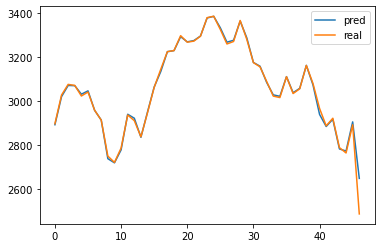

In [15]:
bmodel = TransformerTimeSeries(feature_dim = feature_dim,
                                  nhead = 4,num_layers = 12,d_model = 512,
                                  conv_len = 5,feature_weight = True,embedding_weight = True)
bmodel.load_state_dict(torch.load('AMZN_C'))
bmodel.to(device)
bmodel.eval()
with torch.no_grad(): # eliminate gradient i.e. gradients only exists in train()

    for step,(x,y,feature,attention_masks) in enumerate(test_dl):
        x = x.to(device)
        y = y.to(device)
        feature = feature.to(device)
        
        #y = torch.cat([y[:,0:5],torch.ones(47,1).cuda()],1)
        #feature = torch.cat([feature[:,:,0:5],torch.ones(47,90,1).cuda()],2)
        
        attention_masks = attention_masks.to(device)
        output = bmodel(x,y,feature,attention_masks[0])
        
        pred = data[train_size + 1 :-1,3]*0.01*(100+output[:,t0:].squeeze()).detach().cpu()
        real = data[train_size + 1 :-1,3]*0.01*(100+y[:,t0:].squeeze()).detach().cpu()

        plt.plot(pred)
        plt.plot(real)
        plt.legend(['pred','real'])
        MAE = torch.nn.L1Loss()(pred,real).item()
        MSE = torch.nn.MSELoss()(pred,real).item()
        RMSE = np.sqrt(MSE)
        
        print(f'AMZN MAE is {MAE}')
        print(f'AMZN MSE is {MSE}')
        print(f'AMZN RMSE is {RMSE}')

## GOOG
##### open

In [12]:
file_name = 'GOOG_features.csv'
with open(file_name) as f:
    data_list = csv.reader(f)
    data = []
    for row in data_list:
        data.append(row)
    f.close()
    
data = torch.tensor(np.delete(np.array(data)[1:,2:],4,axis = 1).astype(np.float)).type(torch.float)

feature_dim = data.shape[1] - 1
rate = []
for i in range(1,data.shape[0]):
    rate.append((100*(data[i,0:4] - data[i-1,0:4])/data[i-1,0:4]).reshape(1,4))
    
rate = torch.cat(rate)
rate_data = torch.cat([rate,data[1:,4:]],1)
train_size = int(data.shape[0]*0.9)
data_train = rate_data[0:train_size]
data_test = rate_data[train_size-4:]


t0 = 5
to_predict = 1
train_dataset = GetData(data_train[:,0],data_train[:,1:],t0 = t0, to_predict = to_predict)
test_dataset = GetData(data_test[:,0],data_test[:,1:],t0 = t0, to_predict = to_predict)
criterion = torch.nn.MSELoss()
# dataloaders
train_dl = DataLoader(train_dataset,batch_size=256,shuffle=True)
test_dl = DataLoader(test_dataset,batch_size=512)





model = TransformerTimeSeries(feature_dim = feature_dim,
                              nhead = 4,num_layers = 12,d_model = 512,
                              conv_len = 5,feature_weight = True,embedding_weight = True)
model = model.to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=1e-5 ,momentum = 0.9, nesterov = True)#Adam optimizer
#scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer,5e-7,3e-5,10,mode = 'exp_range',gamma = 0.9996)



train_epoch_loss = []
test_epoch_loss = []
test_best = 9999
for epoch in tqdm(range(4000)):


    l_t = train_epoch(model,train_dl,optimizer,t0,to_predict)

    train_loss = test_epoch(model,train_dl,t0,to_predict)


    test_loss = test_epoch(model,test_dl,t0,to_predict)


    if test_best > test_loss:
        test_best = test_loss
        torch.save(model.state_dict(), 'GOOG')



    train_epoch_loss.append(np.mean(train_loss))
    test_epoch_loss.append(test_loss)

    print("Epoch {}: Train loss: {} \t test loss: {}".format(epoch+1,
                                                             np.mean(train_loss),
                                                             test_loss))
    #scheduler.step()



torch.Size([431, 6])
torch.Size([431, 6])
torch.Size([47, 6])
torch.Size([47, 6])


  0%|                                                                                     | 0/4000 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1944: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
  0%|                                                                             | 1/4000 [00:00<36:36,  1.82it/s]

Epoch 1: Train loss: 1.3336460886311365 	 test loss: 1.994730830192566


  0%|                                                                             | 2/4000 [00:01<56:49,  1.17it/s]

Epoch 2: Train loss: 1.298916004650001 	 test loss: 1.9634343385696411


  0%|                                                                           | 3/4000 [00:02<1:03:39,  1.05it/s]

Epoch 3: Train loss: 1.2687325413984931 	 test loss: 1.93598473072052


  0%|                                                                           | 4/4000 [00:03<1:06:36,  1.00s/it]

Epoch 4: Train loss: 1.2499659210789231 	 test loss: 1.9167168140411377


  0%|                                                                           | 5/4000 [00:04<1:07:25,  1.01s/it]

Epoch 5: Train loss: 1.2406725700936019 	 test loss: 1.9039804935455322


  0%|                                                                           | 6/4000 [00:05<1:07:58,  1.02s/it]

Epoch 6: Train loss: 1.2387359358041856 	 test loss: 1.8934870958328247


  0%|▏                                                                          | 7/4000 [00:06<1:09:07,  1.04s/it]

Epoch 7: Train loss: 1.2401704387155874 	 test loss: 1.887895941734314


  0%|▏                                                                          | 8/4000 [00:08<1:11:04,  1.07s/it]

Epoch 8: Train loss: 1.2418557859075594 	 test loss: 1.8865313529968262


  0%|▏                                                                          | 9/4000 [00:09<1:11:07,  1.07s/it]

Epoch 9: Train loss: 1.2419370520695734 	 test loss: 1.8857207298278809


  0%|▏                                                                         | 10/4000 [00:10<1:11:10,  1.07s/it]

Epoch 10: Train loss: 1.240797870120427 	 test loss: 1.8852126598358154


  0%|▏                                                                         | 11/4000 [00:11<1:11:23,  1.07s/it]

Epoch 11: Train loss: 1.2386419894800385 	 test loss: 1.8850901126861572


  0%|▏                                                                           | 12/4000 [00:11<55:57,  1.19it/s]

Epoch 12: Train loss: 1.2363720247197871 	 test loss: 1.8856669664382935


  0%|▏                                                                           | 13/4000 [00:11<45:17,  1.47it/s]

Epoch 13: Train loss: 1.2348349080561485 	 test loss: 1.8888542652130127


  0%|▎                                                                           | 14/4000 [00:12<37:09,  1.79it/s]

Epoch 14: Train loss: 1.233995319242544 	 test loss: 1.8918660879135132


  0%|▎                                                                           | 15/4000 [00:12<30:41,  2.16it/s]

Epoch 15: Train loss: 1.2337508917961209 	 test loss: 1.8938496112823486


  0%|▎                                                                           | 16/4000 [00:12<26:05,  2.54it/s]

Epoch 16: Train loss: 1.2337637752501982 	 test loss: 1.8952305316925049


  0%|▎                                                                           | 17/4000 [00:12<22:55,  2.90it/s]

Epoch 17: Train loss: 1.2337393467498212 	 test loss: 1.8957656621932983


  0%|▎                                                                           | 18/4000 [00:13<20:42,  3.21it/s]

Epoch 18: Train loss: 1.233264938861201 	 test loss: 1.8954029083251953


  0%|▎                                                                           | 19/4000 [00:13<19:03,  3.48it/s]

Epoch 19: Train loss: 1.2325449128162003 	 test loss: 1.8944765329360962


  0%|▍                                                                           | 20/4000 [00:13<17:58,  3.69it/s]

Epoch 20: Train loss: 1.2315236908100597 	 test loss: 1.8930121660232544


  1%|▍                                                                           | 21/4000 [00:13<17:15,  3.84it/s]

Epoch 21: Train loss: 1.2302887298668066 	 test loss: 1.8910694122314453


  1%|▍                                                                           | 22/4000 [00:14<16:44,  3.96it/s]

Epoch 22: Train loss: 1.229067037940855 	 test loss: 1.888939380645752


  1%|▍                                                                           | 23/4000 [00:14<16:28,  4.02it/s]

Epoch 23: Train loss: 1.2281896915900459 	 test loss: 1.8874281644821167


  1%|▍                                                                           | 24/4000 [00:14<16:07,  4.11it/s]

Epoch 24: Train loss: 1.227448753027241 	 test loss: 1.8864177465438843


  1%|▍                                                                           | 25/4000 [00:15<30:14,  2.19it/s]

Epoch 25: Train loss: 1.2265482551813678 	 test loss: 1.8850857019424438


  1%|▍                                                                           | 26/4000 [00:17<53:19,  1.24it/s]

Epoch 26: Train loss: 1.2256585965300382 	 test loss: 1.8836513757705688


  1%|▌                                                                           | 27/4000 [00:18<56:26,  1.17it/s]

Epoch 27: Train loss: 1.2247745385026156 	 test loss: 1.8823202848434448


  1%|▌                                                                         | 28/4000 [00:19<1:01:27,  1.08it/s]

Epoch 28: Train loss: 1.223806368225965 	 test loss: 1.8808456659317017


  1%|▌                                                                         | 29/4000 [00:20<1:05:30,  1.01it/s]

Epoch 29: Train loss: 1.2228894053921622 	 test loss: 1.879111409187317


  1%|▌                                                                         | 30/4000 [00:21<1:07:53,  1.03s/it]

Epoch 30: Train loss: 1.222053201735158 	 test loss: 1.8775825500488281


  1%|▌                                                                         | 31/4000 [00:22<1:09:38,  1.05s/it]

Epoch 31: Train loss: 1.221223889536758 	 test loss: 1.876372218132019


  1%|▌                                                                         | 32/4000 [00:23<1:11:40,  1.08s/it]

Epoch 32: Train loss: 1.2204288332755493 	 test loss: 1.875658392906189


  1%|▌                                                                         | 33/4000 [00:24<1:12:58,  1.10s/it]

Epoch 33: Train loss: 1.2196512061869185 	 test loss: 1.8751353025436401


  1%|▋                                                                         | 34/4000 [00:25<1:13:09,  1.11s/it]

Epoch 34: Train loss: 1.2188079855005038 	 test loss: 1.8741686344146729


  1%|▋                                                                         | 35/4000 [00:27<1:13:15,  1.11s/it]

Epoch 35: Train loss: 1.2179629219103856 	 test loss: 1.8729987144470215


  1%|▋                                                                         | 36/4000 [00:28<1:12:26,  1.10s/it]

Epoch 36: Train loss: 1.2171163074931524 	 test loss: 1.871579647064209


  1%|▋                                                                         | 37/4000 [00:29<1:12:38,  1.10s/it]

Epoch 37: Train loss: 1.2162631830317239 	 test loss: 1.8707053661346436


  1%|▋                                                                         | 38/4000 [00:30<1:12:41,  1.10s/it]

Epoch 38: Train loss: 1.215442060041317 	 test loss: 1.8700122833251953


  1%|▋                                                                         | 39/4000 [00:31<1:12:49,  1.10s/it]

Epoch 39: Train loss: 1.214581687876354 	 test loss: 1.8690030574798584


  1%|▋                                                                         | 40/4000 [00:32<1:13:26,  1.11s/it]

Epoch 40: Train loss: 1.2137398874676697 	 test loss: 1.868263840675354


  1%|▊                                                                         | 41/4000 [00:33<1:12:57,  1.11s/it]

Epoch 41: Train loss: 1.2129776978437419 	 test loss: 1.8678760528564453


  1%|▊                                                                         | 42/4000 [00:34<1:13:46,  1.12s/it]

Epoch 42: Train loss: 1.2122200727462769 	 test loss: 1.8675508499145508


  1%|▊                                                                         | 43/4000 [00:35<1:13:29,  1.11s/it]

Epoch 43: Train loss: 1.2114160885113852 	 test loss: 1.86692476272583


  1%|▊                                                                         | 44/4000 [00:37<1:13:49,  1.12s/it]

Epoch 44: Train loss: 1.2105007406730386 	 test loss: 1.8658688068389893


  1%|▊                                                                         | 45/4000 [00:38<1:13:40,  1.12s/it]

Epoch 45: Train loss: 1.2096010192087798 	 test loss: 1.8648632764816284


  1%|▊                                                                         | 46/4000 [00:39<1:13:04,  1.11s/it]

Epoch 46: Train loss: 1.2087082959659692 	 test loss: 1.8640520572662354


  1%|▊                                                                         | 47/4000 [00:40<1:13:44,  1.12s/it]

Epoch 47: Train loss: 1.2077998608834781 	 test loss: 1.8632155656814575


  1%|▉                                                                         | 48/4000 [00:41<1:14:44,  1.13s/it]

Epoch 48: Train loss: 1.206869889024792 	 test loss: 1.8623442649841309


  1%|▉                                                                         | 49/4000 [00:42<1:14:02,  1.12s/it]

Epoch 49: Train loss: 1.20583289571262 	 test loss: 1.860887050628662


  1%|▉                                                                         | 50/4000 [00:43<1:14:34,  1.13s/it]

Epoch 50: Train loss: 1.2048106810333004 	 test loss: 1.8595868349075317


  1%|▉                                                                         | 51/4000 [00:44<1:14:01,  1.12s/it]

Epoch 51: Train loss: 1.203685025881172 	 test loss: 1.8578052520751953


  1%|▉                                                                         | 52/4000 [00:46<1:13:37,  1.12s/it]

Epoch 52: Train loss: 1.2025030937106316 	 test loss: 1.8557965755462646


  1%|▉                                                                         | 53/4000 [00:47<1:14:22,  1.13s/it]

Epoch 53: Train loss: 1.2013098742735082 	 test loss: 1.8536773920059204


  1%|▉                                                                         | 54/4000 [00:48<1:14:40,  1.14s/it]

Epoch 54: Train loss: 1.2000536462270466 	 test loss: 1.8510514497756958


  1%|█                                                                         | 55/4000 [00:49<1:15:00,  1.14s/it]

Epoch 55: Train loss: 1.1988357797852802 	 test loss: 1.8479409217834473


  1%|█                                                                         | 56/4000 [00:50<1:13:45,  1.12s/it]

Epoch 56: Train loss: 1.1976936294971652 	 test loss: 1.845501184463501


  1%|█                                                                         | 57/4000 [00:51<1:12:41,  1.11s/it]

Epoch 57: Train loss: 1.196568102405132 	 test loss: 1.8437087535858154


  1%|█                                                                         | 58/4000 [00:52<1:11:37,  1.09s/it]

Epoch 58: Train loss: 1.1953676717740478 	 test loss: 1.8420555591583252


  1%|█                                                                         | 59/4000 [00:53<1:11:40,  1.09s/it]

Epoch 59: Train loss: 1.194202368884518 	 test loss: 1.8405537605285645


  2%|█                                                                         | 60/4000 [00:54<1:12:01,  1.10s/it]

Epoch 60: Train loss: 1.1930577364985737 	 test loss: 1.8395284414291382


  2%|█▏                                                                        | 61/4000 [00:55<1:11:46,  1.09s/it]

Epoch 61: Train loss: 1.1918726053149407 	 test loss: 1.8383467197418213


  2%|█▏                                                                        | 62/4000 [00:57<1:11:23,  1.09s/it]

Epoch 62: Train loss: 1.1906668127551157 	 test loss: 1.8378870487213135


  2%|█▏                                                                        | 63/4000 [00:58<1:11:21,  1.09s/it]

Epoch 63: Train loss: 1.1895071522542329 	 test loss: 1.8374587297439575


  2%|█▏                                                                        | 64/4000 [00:59<1:13:25,  1.12s/it]

Epoch 64: Train loss: 1.1883413722509575 	 test loss: 1.8364510536193848


  2%|█▏                                                                        | 65/4000 [01:07<3:35:53,  3.29s/it]

Epoch 65: Train loss: 1.1870691217568523 	 test loss: 1.835192084312439


  2%|█▏                                                                        | 66/4000 [01:18<6:08:16,  5.62s/it]

Epoch 66: Train loss: 1.1857990737304334 	 test loss: 1.833763599395752


  2%|█▏                                                                        | 67/4000 [01:25<6:32:39,  5.99s/it]

Epoch 67: Train loss: 1.1845038360343456 	 test loss: 1.8324389457702637


  2%|█▎                                                                        | 68/4000 [01:31<6:30:39,  5.96s/it]

Epoch 68: Train loss: 1.1831318242367348 	 test loss: 1.8309345245361328


  2%|█▎                                                                        | 69/4000 [01:38<6:56:41,  6.36s/it]

Epoch 69: Train loss: 1.1817806784901983 	 test loss: 1.8294270038604736


  2%|█▎                                                                        | 70/4000 [01:45<6:59:36,  6.41s/it]

Epoch 70: Train loss: 1.1804286897044172 	 test loss: 1.8280564546585083


  2%|█▎                                                                        | 71/4000 [01:51<7:05:36,  6.50s/it]

Epoch 71: Train loss: 1.1790648023932826 	 test loss: 1.8265351057052612


  2%|█▎                                                                        | 72/4000 [01:59<7:33:06,  6.92s/it]

Epoch 72: Train loss: 1.1776734020759778 	 test loss: 1.8248300552368164


  2%|█▎                                                                        | 73/4000 [02:11<8:59:00,  8.24s/it]

Epoch 73: Train loss: 1.1762545410275735 	 test loss: 1.823099970817566


  2%|█▎                                                                        | 74/4000 [02:18<8:32:18,  7.83s/it]

Epoch 74: Train loss: 1.1747946836002465 	 test loss: 1.8212473392486572


  2%|█▍                                                                        | 75/4000 [02:25<8:14:28,  7.56s/it]

Epoch 75: Train loss: 1.1733194755567475 	 test loss: 1.819395899772644


  2%|█▍                                                                        | 76/4000 [02:31<8:00:27,  7.35s/it]

Epoch 76: Train loss: 1.171877472970436 	 test loss: 1.8178298473358154


  2%|█▍                                                                        | 77/4000 [02:37<7:34:32,  6.95s/it]

Epoch 77: Train loss: 1.1704925766123973 	 test loss: 1.8161931037902832


  2%|█▍                                                                        | 78/4000 [02:44<7:34:19,  6.95s/it]

Epoch 78: Train loss: 1.1690951350670127 	 test loss: 1.8146710395812988


  2%|█▍                                                                        | 79/4000 [02:52<7:45:49,  7.13s/it]

Epoch 79: Train loss: 1.167618393344835 	 test loss: 1.8132424354553223


  2%|█▍                                                                        | 80/4000 [03:04<9:13:51,  8.48s/it]

Epoch 80: Train loss: 1.1660449941860827 	 test loss: 1.811907172203064


  2%|█▍                                                                        | 81/4000 [03:11<8:45:17,  8.04s/it]

Epoch 81: Train loss: 1.1645893644014256 	 test loss: 1.8104625940322876


  2%|█▌                                                                        | 82/4000 [03:17<8:10:03,  7.50s/it]

Epoch 82: Train loss: 1.1630743009031788 	 test loss: 1.809065580368042


  2%|█▌                                                                        | 83/4000 [03:24<8:05:40,  7.44s/it]

Epoch 83: Train loss: 1.161510434615363 	 test loss: 1.8077888488769531


  2%|█▌                                                                        | 84/4000 [03:30<7:42:44,  7.09s/it]

Epoch 84: Train loss: 1.1600003942259502 	 test loss: 1.8066474199295044


  2%|█▌                                                                        | 85/4000 [03:37<7:38:44,  7.03s/it]

Epoch 85: Train loss: 1.1585151637513234 	 test loss: 1.805063009262085


  2%|█▌                                                                        | 86/4000 [03:44<7:31:07,  6.92s/it]

Epoch 86: Train loss: 1.1569969789611214 	 test loss: 1.8038462400436401


  2%|█▌                                                                        | 87/4000 [03:51<7:25:02,  6.82s/it]

Epoch 87: Train loss: 1.1554602622432664 	 test loss: 1.8025065660476685


  2%|█▋                                                                        | 88/4000 [03:57<7:20:34,  6.76s/it]

Epoch 88: Train loss: 1.153953193788462 	 test loss: 1.8009597063064575


  2%|█▋                                                                        | 89/4000 [04:04<7:18:00,  6.72s/it]

Epoch 89: Train loss: 1.1524175359865352 	 test loss: 1.7993332147598267


  2%|█▋                                                                        | 90/4000 [04:10<7:15:28,  6.68s/it]

Epoch 90: Train loss: 1.150884938627274 	 test loss: 1.797685146331787


  2%|█▋                                                                        | 91/4000 [04:16<7:00:38,  6.46s/it]

Epoch 91: Train loss: 1.1493912727816198 	 test loss: 1.7963156700134277


  2%|█▋                                                                        | 92/4000 [04:25<7:52:23,  7.25s/it]

Epoch 92: Train loss: 1.1477976155115115 	 test loss: 1.7947540283203125


  2%|█▋                                                                        | 93/4000 [04:37<9:11:45,  8.47s/it]

Epoch 93: Train loss: 1.146188785194521 	 test loss: 1.793040156364441


  2%|█▋                                                                        | 94/4000 [04:43<8:33:41,  7.89s/it]

Epoch 94: Train loss: 1.1446820832183908 	 test loss: 1.79142427444458


  2%|█▊                                                                        | 95/4000 [04:49<7:57:02,  7.33s/it]

Epoch 95: Train loss: 1.143107562773189 	 test loss: 1.7902618646621704


  2%|█▊                                                                        | 96/4000 [04:57<7:56:32,  7.32s/it]

Epoch 96: Train loss: 1.14147365950653 	 test loss: 1.7890530824661255


  2%|█▊                                                                        | 97/4000 [05:03<7:42:19,  7.11s/it]

Epoch 97: Train loss: 1.1399079857182337 	 test loss: 1.7870988845825195


  2%|█▊                                                                        | 98/4000 [05:10<7:32:21,  6.96s/it]

Epoch 98: Train loss: 1.1383180618286133 	 test loss: 1.7856311798095703


  2%|█▊                                                                        | 99/4000 [05:20<8:41:09,  8.02s/it]

Epoch 99: Train loss: 1.136714973471834 	 test loss: 1.7842727899551392


  2%|█▊                                                                       | 100/4000 [05:29<9:04:26,  8.38s/it]

Epoch 100: Train loss: 1.1350555632894388 	 test loss: 1.7827473878860474


  3%|█▊                                                                       | 101/4000 [05:36<8:31:43,  7.87s/it]

Epoch 101: Train loss: 1.1334466762719742 	 test loss: 1.7815738916397095


  3%|█▊                                                                       | 102/4000 [05:42<7:53:01,  7.28s/it]

Epoch 102: Train loss: 1.13169797418289 	 test loss: 1.7796642780303955


  3%|█▉                                                                       | 103/4000 [05:49<7:52:56,  7.28s/it]

Epoch 103: Train loss: 1.1300648425958548 	 test loss: 1.7780468463897705


  3%|█▉                                                                       | 104/4000 [05:56<7:39:59,  7.08s/it]

Epoch 104: Train loss: 1.128330295710995 	 test loss: 1.7760528326034546


  3%|█▉                                                                       | 105/4000 [06:03<7:35:37,  7.02s/it]

Epoch 105: Train loss: 1.1265275638783891 	 test loss: 1.7739322185516357


  3%|█▉                                                                       | 106/4000 [06:13<8:39:59,  8.01s/it]

Epoch 106: Train loss: 1.1247140763807186 	 test loss: 1.7720786333084106


  3%|█▉                                                                       | 107/4000 [06:22<9:04:18,  8.39s/it]

Epoch 107: Train loss: 1.1230223859269215 	 test loss: 1.7704668045043945


  3%|█▉                                                                       | 108/4000 [06:28<8:15:40,  7.64s/it]

Epoch 108: Train loss: 1.1213785786086612 	 test loss: 1.7690995931625366


  3%|█▉                                                                       | 109/4000 [06:35<8:05:18,  7.48s/it]

Epoch 109: Train loss: 1.1196951229998242 	 test loss: 1.7674305438995361


  3%|██                                                                       | 110/4000 [06:42<7:47:04,  7.20s/it]

Epoch 110: Train loss: 1.1179442900792629 	 test loss: 1.7658499479293823


  3%|██                                                                       | 111/4000 [06:48<7:28:59,  6.93s/it]

Epoch 111: Train loss: 1.1160875337583007 	 test loss: 1.7638403177261353


  3%|██                                                                       | 112/4000 [06:56<7:35:27,  7.03s/it]

Epoch 112: Train loss: 1.1140774695889857 	 test loss: 1.761026382446289


  3%|██                                                                       | 113/4000 [07:06<8:41:02,  8.04s/it]

Epoch 113: Train loss: 1.1121749142206463 	 test loss: 1.7576583623886108


  3%|██                                                                       | 114/4000 [07:15<9:07:56,  8.46s/it]

Epoch 114: Train loss: 1.110471952818939 	 test loss: 1.7547662258148193


  3%|██                                                                       | 115/4000 [07:22<8:24:40,  7.79s/it]

Epoch 115: Train loss: 1.1087287603564162 	 test loss: 1.7528069019317627


  3%|██                                                                       | 116/4000 [07:28<7:54:54,  7.34s/it]

Epoch 116: Train loss: 1.106721959645123 	 test loss: 1.7509292364120483


  3%|██▏                                                                      | 117/4000 [07:35<7:53:30,  7.32s/it]

Epoch 117: Train loss: 1.1048412121089042 	 test loss: 1.7492376565933228


  3%|██▏                                                                      | 118/4000 [07:42<7:40:01,  7.11s/it]

Epoch 118: Train loss: 1.1027662095780162 	 test loss: 1.7479007244110107


  3%|██▏                                                                      | 119/4000 [07:48<7:16:59,  6.76s/it]

Epoch 119: Train loss: 1.1009412723185015 	 test loss: 1.7458345890045166


  3%|██▏                                                                      | 120/4000 [07:59<8:44:11,  8.11s/it]

Epoch 120: Train loss: 1.0991618998366 	 test loss: 1.743547797203064


  3%|██▏                                                                      | 121/4000 [08:08<8:52:52,  8.24s/it]

Epoch 121: Train loss: 1.0974483091703977 	 test loss: 1.740897297859192


  3%|██▏                                                                      | 122/4000 [08:15<8:33:55,  7.95s/it]

Epoch 122: Train loss: 1.0957140228311313 	 test loss: 1.738084077835083


  3%|██▏                                                                      | 123/4000 [08:21<8:07:38,  7.55s/it]

Epoch 123: Train loss: 1.093978488804846 	 test loss: 1.7356681823730469


  3%|██▎                                                                      | 124/4000 [08:27<7:35:45,  7.06s/it]

Epoch 124: Train loss: 1.0922266466158448 	 test loss: 1.733344316482544


  3%|██▎                                                                      | 125/4000 [08:35<7:39:41,  7.12s/it]

Epoch 125: Train loss: 1.0905267979318747 	 test loss: 1.731395959854126


  3%|██▎                                                                      | 126/4000 [08:41<7:30:00,  6.97s/it]

Epoch 126: Train loss: 1.0888810738610004 	 test loss: 1.7292462587356567


  3%|██▎                                                                      | 127/4000 [08:53<8:58:40,  8.35s/it]

Epoch 127: Train loss: 1.087283862992395 	 test loss: 1.726712942123413


  3%|██▎                                                                      | 128/4000 [09:01<8:56:49,  8.32s/it]

Epoch 128: Train loss: 1.0856608409616069 	 test loss: 1.7236254215240479


  3%|██▎                                                                      | 129/4000 [09:07<8:10:35,  7.60s/it]

Epoch 129: Train loss: 1.0840544529138199 	 test loss: 1.7209259271621704


  3%|██▎                                                                      | 130/4000 [09:14<8:04:08,  7.51s/it]

Epoch 130: Train loss: 1.0824541226893734 	 test loss: 1.7179808616638184


  3%|██▍                                                                      | 131/4000 [09:21<7:46:32,  7.23s/it]

Epoch 131: Train loss: 1.0809798926599063 	 test loss: 1.714719295501709


  3%|██▍                                                                      | 132/4000 [09:28<7:36:51,  7.09s/it]

Epoch 132: Train loss: 1.079272676233349 	 test loss: 1.7122867107391357


  3%|██▍                                                                      | 133/4000 [09:34<7:24:31,  6.90s/it]

Epoch 133: Train loss: 1.0776632197218539 	 test loss: 1.7096338272094727


  3%|██▍                                                                      | 134/4000 [09:47<9:21:13,  8.71s/it]

Epoch 134: Train loss: 1.076240625846137 	 test loss: 1.7068206071853638


  3%|██▍                                                                      | 135/4000 [09:53<8:32:28,  7.96s/it]

Epoch 135: Train loss: 1.0753000772746146 	 test loss: 1.7034106254577637


  3%|██▍                                                                      | 136/4000 [10:00<8:19:43,  7.76s/it]

Epoch 136: Train loss: 1.0730536332539782 	 test loss: 1.7017383575439453


  3%|██▌                                                                      | 137/4000 [10:07<7:57:14,  7.41s/it]

Epoch 137: Train loss: 1.0707051966970316 	 test loss: 1.700439453125


  3%|██▌                                                                      | 138/4000 [10:13<7:27:49,  6.96s/it]

Epoch 138: Train loss: 1.068991198064003 	 test loss: 1.6978957653045654


  3%|██▌                                                                      | 139/4000 [10:20<7:29:28,  6.98s/it]

Epoch 139: Train loss: 1.0673146372328226 	 test loss: 1.6949353218078613


  4%|██▌                                                                      | 140/4000 [10:26<7:15:34,  6.77s/it]

Epoch 140: Train loss: 1.0655590565464612 	 test loss: 1.6924371719360352


  4%|██▌                                                                      | 141/4000 [10:40<9:38:28,  8.99s/it]

Epoch 141: Train loss: 1.0639479359451967 	 test loss: 1.6886130571365356


  4%|██▌                                                                      | 142/4000 [10:46<8:40:44,  8.10s/it]

Epoch 142: Train loss: 1.0626352109931185 	 test loss: 1.6847355365753174


  4%|██▌                                                                      | 143/4000 [10:53<8:17:50,  7.74s/it]

Epoch 143: Train loss: 1.0607349712168257 	 test loss: 1.681354284286499


  4%|██▋                                                                      | 144/4000 [11:00<7:55:29,  7.40s/it]

Epoch 144: Train loss: 1.0589828271323733 	 test loss: 1.6781712770462036


  4%|██▋                                                                      | 145/4000 [11:07<7:40:23,  7.17s/it]

Epoch 145: Train loss: 1.0577316129290588 	 test loss: 1.6744471788406372


  4%|██▋                                                                      | 146/4000 [11:13<7:29:36,  7.00s/it]

Epoch 146: Train loss: 1.0568708632219141 	 test loss: 1.6708136796951294


  4%|██▋                                                                      | 147/4000 [11:20<7:18:44,  6.83s/it]

Epoch 147: Train loss: 1.054359196786814 	 test loss: 1.6684283018112183


  4%|██▋                                                                      | 148/4000 [11:26<7:16:45,  6.80s/it]

Epoch 148: Train loss: 1.0519829540407575 	 test loss: 1.6669807434082031


  4%|██▋                                                                      | 149/4000 [11:33<7:12:59,  6.75s/it]

Epoch 149: Train loss: 1.050532222070716 	 test loss: 1.6641241312026978


  4%|██▋                                                                      | 150/4000 [11:39<6:57:18,  6.50s/it]

Epoch 150: Train loss: 1.0500293676925092 	 test loss: 1.6598436832427979


  4%|██▊                                                                      | 151/4000 [11:46<7:11:07,  6.72s/it]

Epoch 151: Train loss: 1.0505737760503995 	 test loss: 1.6552886962890625


  4%|██▊                                                                      | 152/4000 [11:53<7:07:35,  6.67s/it]

Epoch 152: Train loss: 1.049730822132801 	 test loss: 1.6523038148880005


  4%|██▊                                                                      | 153/4000 [11:59<7:08:02,  6.68s/it]

Epoch 153: Train loss: 1.0481362193477126 	 test loss: 1.6497894525527954


  4%|██▊                                                                      | 154/4000 [12:05<6:54:52,  6.47s/it]

Epoch 154: Train loss: 1.0460815225012619 	 test loss: 1.6483471393585205


  4%|██▊                                                                      | 155/4000 [12:12<6:55:53,  6.49s/it]

Epoch 155: Train loss: 1.0437791325376649 	 test loss: 1.6472899913787842


  4%|██▊                                                                      | 156/4000 [12:19<7:05:33,  6.64s/it]

Epoch 156: Train loss: 1.0412867403915476 	 test loss: 1.6469935178756714


  4%|██▊                                                                      | 157/4000 [12:26<7:11:04,  6.73s/it]

Epoch 157: Train loss: 1.0393928449834307 	 test loss: 1.6459050178527832


  4%|██▉                                                                      | 158/4000 [12:32<7:08:10,  6.69s/it]

Epoch 158: Train loss: 1.0387095099535453 	 test loss: 1.642749309539795


  4%|██▉                                                                      | 159/4000 [12:39<7:06:46,  6.67s/it]

Epoch 159: Train loss: 1.0384613542435064 	 test loss: 1.6389938592910767


  4%|██▉                                                                      | 160/4000 [12:50<8:34:20,  8.04s/it]

Epoch 160: Train loss: 1.0386567801721134 	 test loss: 1.6345102787017822


  4%|██▉                                                                      | 161/4000 [12:59<8:40:16,  8.13s/it]

Epoch 161: Train loss: 1.039687925590993 	 test loss: 1.6291844844818115


  4%|██▉                                                                      | 162/4000 [13:06<8:15:08,  7.74s/it]

Epoch 162: Train loss: 1.0397455034012584 	 test loss: 1.625937581062317


  4%|██▉                                                                      | 163/4000 [13:12<7:53:25,  7.40s/it]

Epoch 163: Train loss: 1.0377437505533966 	 test loss: 1.6248197555541992


  4%|██▉                                                                      | 164/4000 [13:18<7:24:49,  6.96s/it]

Epoch 164: Train loss: 1.0369844895781055 	 test loss: 1.6223275661468506


  4%|███                                                                      | 165/4000 [13:25<7:30:35,  7.05s/it]

Epoch 165: Train loss: 1.0352887814116865 	 test loss: 1.6207690238952637


  4%|███                                                                      | 166/4000 [13:32<7:21:54,  6.92s/it]

Epoch 166: Train loss: 1.0340033349194273 	 test loss: 1.619137167930603


  4%|███                                                                      | 167/4000 [13:39<7:16:00,  6.83s/it]

Epoch 167: Train loss: 1.0341246372862372 	 test loss: 1.61532461643219


  4%|███                                                                      | 168/4000 [13:44<6:58:52,  6.56s/it]

Epoch 168: Train loss: 1.0340721347215833 	 test loss: 1.6122374534606934


  4%|███                                                                      | 169/4000 [13:52<7:12:22,  6.77s/it]

Epoch 169: Train loss: 1.033927559022837 	 test loss: 1.6094281673431396


  4%|███                                                                      | 170/4000 [13:58<7:02:42,  6.62s/it]

Epoch 170: Train loss: 1.0342713613797783 	 test loss: 1.6059271097183228


  4%|███                                                                      | 171/4000 [14:05<7:11:00,  6.75s/it]

Epoch 171: Train loss: 1.033457233844943 	 test loss: 1.6034281253814697


  4%|███▏                                                                     | 172/4000 [14:12<7:08:13,  6.71s/it]

Epoch 172: Train loss: 1.031416569397787 	 test loss: 1.6018544435501099


  4%|███▏                                                                     | 173/4000 [14:22<8:21:36,  7.86s/it]

Epoch 173: Train loss: 1.0308769081142275 	 test loss: 1.5991934537887573


  4%|███▏                                                                     | 174/4000 [14:31<8:35:25,  8.08s/it]

Epoch 174: Train loss: 1.0303176879329636 	 test loss: 1.597113847732544


  4%|███▏                                                                     | 175/4000 [14:38<8:15:57,  7.78s/it]

Epoch 175: Train loss: 1.0290808627887558 	 test loss: 1.5952935218811035


  4%|███▏                                                                     | 176/4000 [14:45<7:55:16,  7.46s/it]

Epoch 176: Train loss: 1.0271120605225352 	 test loss: 1.59369957447052


  4%|███▏                                                                     | 177/4000 [14:51<7:40:35,  7.23s/it]

Epoch 177: Train loss: 1.0258232023212583 	 test loss: 1.5917656421661377


  4%|███▏                                                                     | 178/4000 [14:58<7:28:28,  7.04s/it]

Epoch 178: Train loss: 1.0250995936360547 	 test loss: 1.589990258216858


  4%|███▎                                                                     | 179/4000 [15:04<7:20:01,  6.91s/it]

Epoch 179: Train loss: 1.0266384951199843 	 test loss: 1.585734248161316


  4%|███▎                                                                     | 180/4000 [15:11<7:14:03,  6.82s/it]

Epoch 180: Train loss: 1.0283202270344072 	 test loss: 1.582053303718567


  5%|███▎                                                                     | 181/4000 [15:18<7:09:23,  6.75s/it]

Epoch 181: Train loss: 1.0253651142120361 	 test loss: 1.5811480283737183


  5%|███▎                                                                     | 182/4000 [15:18<5:06:35,  4.82s/it]

Epoch 182: Train loss: 1.0230341676769565 	 test loss: 1.5822763442993164


  5%|███▎                                                                     | 183/4000 [15:18<3:40:32,  3.47s/it]

Epoch 183: Train loss: 1.0217757924803448 	 test loss: 1.5816255807876587


  5%|███▎                                                                     | 184/4000 [15:24<4:29:05,  4.23s/it]

Epoch 184: Train loss: 1.0225961941300854 	 test loss: 1.5762094259262085


  5%|███▍                                                                     | 185/4000 [15:31<5:14:14,  4.94s/it]

Epoch 185: Train loss: 1.024756440015514 	 test loss: 1.5709383487701416


  5%|███▍                                                                     | 186/4000 [15:38<5:45:48,  5.44s/it]

Epoch 186: Train loss: 1.0223728618876287 	 test loss: 1.5702511072158813


  5%|███▍                                                                     | 187/4000 [15:43<5:54:04,  5.57s/it]

Epoch 187: Train loss: 1.0209967664112347 	 test loss: 1.5696388483047485


  5%|███▍                                                                     | 188/4000 [15:55<7:43:42,  7.30s/it]

Epoch 188: Train loss: 1.0213669658813564 	 test loss: 1.5655571222305298


  5%|███▍                                                                     | 189/4000 [16:04<8:20:55,  7.89s/it]

Epoch 189: Train loss: 1.0202956443043154 	 test loss: 1.5643832683563232


  5%|███▍                                                                     | 190/4000 [16:04<5:56:36,  5.62s/it]

Epoch 190: Train loss: 1.018764322152547 	 test loss: 1.5645421743392944


  5%|███▍                                                                     | 191/4000 [16:05<4:15:35,  4.03s/it]

Epoch 191: Train loss: 1.0174094020905462 	 test loss: 1.5662378072738647


  5%|███▌                                                                     | 192/4000 [16:11<4:51:28,  4.59s/it]

Epoch 192: Train loss: 1.0172236007216913 	 test loss: 1.5629416704177856


  5%|███▌                                                                     | 193/4000 [16:17<5:23:25,  5.10s/it]

Epoch 193: Train loss: 1.0169519393460658 	 test loss: 1.560076117515564


  5%|███▌                                                                     | 194/4000 [16:24<5:58:10,  5.65s/it]

Epoch 194: Train loss: 1.01758195822864 	 test loss: 1.5547419786453247


  5%|███▌                                                                     | 195/4000 [16:24<4:16:39,  4.05s/it]

Epoch 195: Train loss: 1.0156008599805721 	 test loss: 1.5564625263214111


  5%|███▌                                                                     | 196/4000 [16:24<3:05:47,  2.93s/it]

Epoch 196: Train loss: 1.0144990934296716 	 test loss: 1.5565950870513916


  5%|███▌                                                                     | 197/4000 [16:30<4:03:23,  3.84s/it]

Epoch 197: Train loss: 1.014490401938454 	 test loss: 1.5524507761001587


  5%|███▌                                                                     | 198/4000 [16:37<4:55:24,  4.66s/it]

Epoch 198: Train loss: 1.0157768928257882 	 test loss: 1.547343134880066


  5%|███▋                                                                     | 199/4000 [16:44<5:32:47,  5.25s/it]

Epoch 199: Train loss: 1.0160697817525841 	 test loss: 1.54515540599823


  5%|███▋                                                                     | 200/4000 [16:49<5:45:21,  5.45s/it]

Epoch 200: Train loss: 1.0148381243725664 	 test loss: 1.5440759658813477


  5%|███▋                                                                     | 201/4000 [16:57<6:20:03,  6.00s/it]

Epoch 201: Train loss: 1.0133076362709434 	 test loss: 1.5440088510513306


  5%|███▋                                                                     | 202/4000 [16:57<4:31:59,  4.30s/it]

Epoch 202: Train loss: 1.0120280488737774 	 test loss: 1.5445095300674438


  5%|███▋                                                                     | 203/4000 [16:57<3:16:22,  3.10s/it]

Epoch 203: Train loss: 1.0104296973575848 	 test loss: 1.5462671518325806


  5%|███▋                                                                     | 204/4000 [16:58<2:23:26,  2.27s/it]

Epoch 204: Train loss: 1.0094034425620413 	 test loss: 1.545841932296753


  5%|███▋                                                                     | 205/4000 [17:03<3:14:22,  3.07s/it]

Epoch 205: Train loss: 1.0092919074742257 	 test loss: 1.54188072681427


  5%|███▊                                                                     | 206/4000 [17:10<4:34:04,  4.33s/it]

Epoch 206: Train loss: 1.0105157354868206 	 test loss: 1.535713791847229


  5%|███▊                                                                     | 207/4000 [17:17<5:17:13,  5.02s/it]

Epoch 207: Train loss: 1.011423049006274 	 test loss: 1.532888650894165


  5%|███▊                                                                     | 208/4000 [17:26<6:41:00,  6.35s/it]

Epoch 208: Train loss: 1.00875282840773 	 test loss: 1.5327657461166382


  5%|███▊                                                                     | 209/4000 [17:36<7:53:39,  7.50s/it]

Epoch 209: Train loss: 1.006988861168067 	 test loss: 1.5321615934371948


  5%|███▊                                                                     | 210/4000 [17:37<5:38:43,  5.36s/it]

Epoch 210: Train loss: 1.004438920115097 	 test loss: 1.5362643003463745


  5%|███▊                                                                     | 211/4000 [17:37<4:03:13,  3.85s/it]

Epoch 211: Train loss: 1.0028409482154934 	 test loss: 1.5384957790374756


  5%|███▊                                                                     | 212/4000 [17:37<2:55:58,  2.79s/it]

Epoch 212: Train loss: 1.0019107133219247 	 test loss: 1.5373528003692627


  5%|███▉                                                                     | 213/4000 [17:43<3:55:18,  3.73s/it]

Epoch 213: Train loss: 1.0022387797760577 	 test loss: 1.5309840440750122


  5%|███▉                                                                     | 214/4000 [17:50<4:53:24,  4.65s/it]

Epoch 214: Train loss: 1.00232185191732 	 test loss: 1.5270373821258545


  5%|███▉                                                                     | 215/4000 [17:56<5:13:57,  4.98s/it]

Epoch 215: Train loss: 1.001821052170685 	 test loss: 1.525029182434082


  5%|███▉                                                                     | 216/4000 [17:56<3:45:38,  3.58s/it]

Epoch 216: Train loss: 0.9996641896440369 	 test loss: 1.5281875133514404


  5%|███▉                                                                     | 217/4000 [17:56<2:43:57,  2.60s/it]

Epoch 217: Train loss: 0.9983835640750186 	 test loss: 1.531114101409912


  5%|███▉                                                                     | 218/4000 [17:57<2:00:37,  1.91s/it]

Epoch 218: Train loss: 0.997806562486768 	 test loss: 1.530852198600769


  5%|███▉                                                                     | 219/4000 [18:03<3:24:14,  3.24s/it]

Epoch 219: Train loss: 0.9983850053734127 	 test loss: 1.520750641822815


  6%|████                                                                     | 220/4000 [18:09<4:14:55,  4.05s/it]

Epoch 220: Train loss: 0.9994730155595217 	 test loss: 1.517155647277832


  6%|████                                                                     | 222/4000 [18:19<4:22:27,  4.17s/it]

Epoch 221: Train loss: 0.9985543221166129 	 test loss: 1.5166999101638794
Epoch 222: Train loss: 0.997161828171626 	 test loss: 1.5172507762908936


  6%|████                                                                     | 223/4000 [18:19<3:06:25,  2.96s/it]

Epoch 223: Train loss: 0.9964237171646614 	 test loss: 1.5186487436294556


  6%|████                                                                     | 224/4000 [18:29<5:13:08,  4.98s/it]

Epoch 224: Train loss: 0.9962954651175409 	 test loss: 1.5162807703018188


  6%|████                                                                     | 225/4000 [18:36<5:49:17,  5.55s/it]

Epoch 225: Train loss: 0.996794098491182 	 test loss: 1.513047218322754


  6%|████                                                                     | 226/4000 [18:43<6:09:30,  5.87s/it]

Epoch 226: Train loss: 0.9955703960493933 	 test loss: 1.5124423503875732


  6%|████▏                                                                    | 227/4000 [18:48<6:10:39,  5.89s/it]

Epoch 227: Train loss: 0.9940848147232958 	 test loss: 1.5119661092758179


  6%|████▏                                                                    | 228/4000 [18:56<6:35:27,  6.29s/it]

Epoch 228: Train loss: 0.9933590926316388 	 test loss: 1.510266900062561


  6%|████▏                                                                    | 229/4000 [19:02<6:42:12,  6.40s/it]

Epoch 229: Train loss: 0.9930073667291699 	 test loss: 1.5089296102523804


  6%|████▏                                                                    | 230/4000 [19:09<6:37:09,  6.32s/it]

Epoch 230: Train loss: 0.993250685888764 	 test loss: 1.5071101188659668


  6%|████▏                                                                    | 231/4000 [19:15<6:38:38,  6.35s/it]

Epoch 231: Train loss: 0.9923955404011666 	 test loss: 1.5057045221328735


  6%|████▏                                                                    | 232/4000 [19:22<6:54:53,  6.61s/it]

Epoch 232: Train loss: 0.9910794102398812 	 test loss: 1.505152702331543


  6%|████▎                                                                    | 233/4000 [19:29<6:55:16,  6.61s/it]

Epoch 233: Train loss: 0.9898766002632903 	 test loss: 1.5042675733566284


  6%|████▎                                                                    | 234/4000 [19:35<6:55:29,  6.62s/it]

Epoch 234: Train loss: 0.9888757243233878 	 test loss: 1.5033732652664185


  6%|████▎                                                                    | 235/4000 [19:42<6:55:32,  6.62s/it]

Epoch 235: Train loss: 0.9884720735096323 	 test loss: 1.5015785694122314


  6%|████▎                                                                    | 236/4000 [19:42<4:56:41,  4.73s/it]

Epoch 236: Train loss: 0.98706791904299 	 test loss: 1.503217101097107


  6%|████▎                                                                    | 237/4000 [19:43<3:33:27,  3.40s/it]

Epoch 237: Train loss: 0.9859445808658467 	 test loss: 1.5032976865768433


  6%|████▎                                                                    | 238/4000 [19:43<2:35:03,  2.47s/it]

Epoch 238: Train loss: 0.9851686412386441 	 test loss: 1.50239098072052


  6%|████▎                                                                    | 239/4000 [19:50<4:06:15,  3.93s/it]

Epoch 239: Train loss: 0.9843104249363432 	 test loss: 1.5013867616653442


  6%|████▍                                                                    | 240/4000 [20:02<6:24:20,  6.13s/it]

Epoch 240: Train loss: 0.983541097690777 	 test loss: 1.500506043434143


  6%|████▍                                                                    | 241/4000 [20:08<6:24:50,  6.14s/it]

Epoch 241: Train loss: 0.9833564296399357 	 test loss: 1.4964274168014526


  6%|████▍                                                                    | 242/4000 [20:15<6:43:49,  6.45s/it]

Epoch 242: Train loss: 0.9849847084961468 	 test loss: 1.4928629398345947


  6%|████▍                                                                    | 243/4000 [20:22<6:49:45,  6.54s/it]

Epoch 243: Train loss: 0.9849639577821346 	 test loss: 1.4912993907928467


  6%|████▍                                                                    | 244/4000 [20:22<4:52:47,  4.68s/it]

Epoch 244: Train loss: 0.981370720398675 	 test loss: 1.4922922849655151


  6%|████▍                                                                    | 245/4000 [20:22<3:30:48,  3.37s/it]

Epoch 245: Train loss: 0.978960854548036 	 test loss: 1.4937686920166016


  6%|████▍                                                                    | 246/4000 [20:23<2:33:35,  2.45s/it]

Epoch 246: Train loss: 0.9779478131756705 	 test loss: 1.4954867362976074


  6%|████▌                                                                    | 247/4000 [20:23<1:53:18,  1.81s/it]

Epoch 247: Train loss: 0.9769886178926083 	 test loss: 1.495079755783081


  6%|████▌                                                                    | 248/4000 [20:23<1:25:05,  1.36s/it]

Epoch 248: Train loss: 0.9758858344671067 	 test loss: 1.4920741319656372


  6%|████▌                                                                    | 249/4000 [20:28<2:28:30,  2.38s/it]

Epoch 249: Train loss: 0.975737114101994 	 test loss: 1.4888684749603271


  6%|████▌                                                                    | 250/4000 [20:35<3:51:48,  3.71s/it]

Epoch 250: Train loss: 0.9767197146493155 	 test loss: 1.4858322143554688


  6%|████▌                                                                    | 252/4000 [20:42<3:24:09,  3.27s/it]

Epoch 251: Train loss: 0.9752608736817079 	 test loss: 1.4846444129943848
Epoch 252: Train loss: 0.9721640041422125 	 test loss: 1.485764980316162


  6%|████▋                                                                    | 254/4000 [20:42<1:45:21,  1.69s/it]

Epoch 253: Train loss: 0.9704163381505732 	 test loss: 1.486644983291626
Epoch 254: Train loss: 0.9692613494921727 	 test loss: 1.4867345094680786


  6%|████▋                                                                    | 255/4000 [20:42<1:16:54,  1.23s/it]

Epoch 255: Train loss: 0.9685642486935149 	 test loss: 1.4861732721328735


  6%|████▋                                                                    | 256/4000 [20:48<2:38:36,  2.54s/it]

Epoch 256: Train loss: 0.9681085158666712 	 test loss: 1.4838415384292603


  6%|████▋                                                                    | 257/4000 [20:55<4:00:38,  3.86s/it]

Epoch 257: Train loss: 0.967950614726737 	 test loss: 1.4814882278442383


  6%|████▋                                                                    | 259/4000 [21:01<3:23:20,  3.26s/it]

Epoch 258: Train loss: 0.9672163170340996 	 test loss: 1.4799271821975708
Epoch 259: Train loss: 0.9655803309239257 	 test loss: 1.4802995920181274


  6%|████▋                                                                    | 260/4000 [21:08<4:28:20,  4.31s/it]

Epoch 260: Train loss: 0.9645732193148053 	 test loss: 1.4795434474945068


  7%|████▊                                                                    | 261/4000 [21:14<5:05:16,  4.90s/it]

Epoch 261: Train loss: 0.96548459590726 	 test loss: 1.476866364479065


  7%|████▊                                                                    | 263/4000 [21:21<4:04:26,  3.92s/it]

Epoch 262: Train loss: 0.9666773116782204 	 test loss: 1.4747570753097534
Epoch 263: Train loss: 0.965419363256397 	 test loss: 1.4748961925506592


  7%|████▊                                                                    | 265/4000 [21:28<3:25:59,  3.31s/it]

Epoch 264: Train loss: 0.9649122763952357 	 test loss: 1.4745709896087646
Epoch 265: Train loss: 0.9635993984901712 	 test loss: 1.4747787714004517


  7%|████▊                                                                    | 267/4000 [21:28<1:45:19,  1.69s/it]

Epoch 266: Train loss: 0.9615826418670866 	 test loss: 1.4756264686584473
Epoch 267: Train loss: 0.9611372117929835 	 test loss: 1.4754307270050049


  7%|████▉                                                                    | 268/4000 [21:34<3:10:47,  3.07s/it]

Epoch 268: Train loss: 0.9621676473495855 	 test loss: 1.4710841178894043


  7%|████▉                                                                    | 269/4000 [21:41<4:16:41,  4.13s/it]

Epoch 269: Train loss: 0.9635757714025935 	 test loss: 1.4679319858551025


  7%|████▉                                                                    | 271/4000 [21:48<3:34:21,  3.45s/it]

Epoch 270: Train loss: 0.9614421324220999 	 test loss: 1.4678839445114136
Epoch 271: Train loss: 0.9581036285568556 	 test loss: 1.468943476676941


  7%|████▉                                                                    | 272/4000 [21:54<4:24:29,  4.26s/it]

Epoch 272: Train loss: 0.9572789666270989 	 test loss: 1.4673901796340942


  7%|████▉                                                                    | 273/4000 [22:01<5:16:37,  5.10s/it]

Epoch 273: Train loss: 0.9573832219272091 	 test loss: 1.4657282829284668


  7%|█████                                                                    | 274/4000 [22:07<5:29:22,  5.30s/it]

Epoch 274: Train loss: 0.9565250111566619 	 test loss: 1.46468186378479


  7%|█████                                                                    | 275/4000 [22:14<6:06:12,  5.90s/it]

Epoch 275: Train loss: 0.9553396531711321 	 test loss: 1.4646310806274414


  7%|█████                                                                    | 276/4000 [22:21<6:18:38,  6.10s/it]

Epoch 276: Train loss: 0.9554426263490575 	 test loss: 1.4623949527740479


  7%|█████                                                                    | 278/4000 [22:27<4:33:54,  4.42s/it]

Epoch 277: Train loss: 0.9552633091634498 	 test loss: 1.4608720541000366
Epoch 278: Train loss: 0.9536069157228669 	 test loss: 1.4611648321151733


  7%|█████                                                                    | 279/4000 [22:33<5:00:30,  4.85s/it]

Epoch 279: Train loss: 0.9536728193754387 	 test loss: 1.4588106870651245


  7%|█████                                                                    | 280/4000 [22:40<5:44:58,  5.56s/it]

Epoch 280: Train loss: 0.9531485788230276 	 test loss: 1.458130121231079


  7%|█████▏                                                                   | 281/4000 [22:47<6:04:08,  5.87s/it]

Epoch 281: Train loss: 0.9524109252920837 	 test loss: 1.4574388265609741


  7%|█████▏                                                                   | 282/4000 [22:54<6:18:06,  6.10s/it]

Epoch 282: Train loss: 0.9514072050627865 	 test loss: 1.4566237926483154


  7%|█████▏                                                                   | 283/4000 [23:00<6:21:20,  6.16s/it]

Epoch 283: Train loss: 0.9500708416830359 	 test loss: 1.456536889076233


  7%|█████▏                                                                   | 284/4000 [23:07<6:35:31,  6.39s/it]

Epoch 284: Train loss: 0.95047689604372 	 test loss: 1.454517126083374


  7%|█████▏                                                                   | 285/4000 [23:13<6:39:29,  6.45s/it]

Epoch 285: Train loss: 0.9535329128915915 	 test loss: 1.4505083560943604


  7%|█████▏                                                                   | 287/4000 [23:20<4:44:18,  4.59s/it]

Epoch 286: Train loss: 0.9552437040756031 	 test loss: 1.4483619928359985
Epoch 287: Train loss: 0.9520613497205234 	 test loss: 1.4490950107574463


  7%|█████▎                                                                   | 289/4000 [23:20<2:23:36,  2.32s/it]

Epoch 288: Train loss: 0.9488118662911612 	 test loss: 1.450226068496704
Epoch 289: Train loss: 0.9470192384830484 	 test loss: 1.4509981870651245


  7%|█████▎                                                                   | 290/4000 [23:21<1:43:03,  1.67s/it]

Epoch 290: Train loss: 0.9468890124296644 	 test loss: 1.4485609531402588


  7%|█████▎                                                                   | 291/4000 [23:27<3:03:19,  2.97s/it]

Epoch 291: Train loss: 0.9491402826287078 	 test loss: 1.4447669982910156


  7%|█████▎                                                                   | 292/4000 [23:33<4:09:08,  4.03s/it]

Epoch 292: Train loss: 0.9497354509105815 	 test loss: 1.442902684211731


  7%|█████▎                                                                   | 293/4000 [23:40<4:59:14,  4.84s/it]

Epoch 293: Train loss: 0.9488829115703875 	 test loss: 1.442070722579956


  7%|█████▍                                                                   | 295/4000 [23:47<3:54:52,  3.80s/it]

Epoch 294: Train loss: 0.9482177426809502 	 test loss: 1.4408897161483765
Epoch 295: Train loss: 0.9451418524551835 	 test loss: 1.4419339895248413


  7%|█████▍                                                                   | 296/4000 [23:52<4:31:43,  4.40s/it]

Epoch 296: Train loss: 0.9445004154800539 	 test loss: 1.4407260417938232


  7%|█████▍                                                                   | 297/4000 [23:59<5:18:19,  5.16s/it]

Epoch 297: Train loss: 0.945311226590327 	 test loss: 1.4382234811782837


  7%|█████▍                                                                   | 298/4000 [24:06<5:51:11,  5.69s/it]

Epoch 298: Train loss: 0.9456131285415171 	 test loss: 1.43624746799469


  7%|█████▍                                                                   | 299/4000 [24:13<6:07:56,  5.96s/it]

Epoch 299: Train loss: 0.9439454275051569 	 test loss: 1.4358527660369873


  8%|█████▍                                                                   | 301/4000 [24:20<4:27:39,  4.34s/it]

Epoch 300: Train loss: 0.9426316307758233 	 test loss: 1.4352988004684448
Epoch 301: Train loss: 0.9405560064758336 	 test loss: 1.4354344606399536


  8%|█████▌                                                                   | 302/4000 [24:26<5:07:31,  4.99s/it]

Epoch 302: Train loss: 0.9396339891404951 	 test loss: 1.4347078800201416


  8%|█████▌                                                                   | 303/4000 [24:33<5:37:37,  5.48s/it]

Epoch 303: Train loss: 0.9388982053422595 	 test loss: 1.4337633848190308


  8%|█████▌                                                                   | 304/4000 [24:39<5:58:16,  5.82s/it]

Epoch 304: Train loss: 0.9402812634985851 	 test loss: 1.4312264919281006


  8%|█████▌                                                                   | 306/4000 [24:46<4:23:03,  4.27s/it]

Epoch 305: Train loss: 0.9410321498138445 	 test loss: 1.4297949075698853
Epoch 306: Train loss: 0.9384520611187698 	 test loss: 1.430078148841858


  8%|█████▌                                                                   | 307/4000 [24:46<3:06:41,  3.03s/it]

Epoch 307: Train loss: 0.9364403076902067 	 test loss: 1.4299514293670654


  8%|█████▌                                                                   | 308/4000 [24:52<3:55:05,  3.82s/it]

Epoch 308: Train loss: 0.9360489611559291 	 test loss: 1.4288002252578735


  8%|█████▋                                                                   | 309/4000 [24:59<4:59:12,  4.86s/it]

Epoch 309: Train loss: 0.9358246410805775 	 test loss: 1.4276793003082275


  8%|█████▋                                                                   | 310/4000 [25:06<5:27:22,  5.32s/it]

Epoch 310: Train loss: 0.9379111692966275 	 test loss: 1.4245167970657349


  8%|█████▋                                                                   | 311/4000 [25:12<5:56:03,  5.79s/it]

Epoch 311: Train loss: 0.9412069168555488 	 test loss: 1.4210600852966309


  8%|█████▋                                                                   | 313/4000 [25:19<4:20:56,  4.25s/it]

Epoch 312: Train loss: 0.9428477295590111 	 test loss: 1.4188371896743774
Epoch 313: Train loss: 0.9401341831601137 	 test loss: 1.418906331062317


  8%|█████▋                                                                   | 315/4000 [25:19<2:12:17,  2.15s/it]

Epoch 314: Train loss: 0.9365072485465737 	 test loss: 1.4195709228515625
Epoch 315: Train loss: 0.932837211477231 	 test loss: 1.4206550121307373


  8%|█████▊                                                                   | 316/4000 [25:25<3:23:03,  3.31s/it]

Epoch 316: Train loss: 0.9342064318136937 	 test loss: 1.4178346395492554


  8%|█████▊                                                                   | 318/4000 [25:32<3:11:30,  3.12s/it]

Epoch 317: Train loss: 0.9346345737749352 	 test loss: 1.4163686037063599
Epoch 318: Train loss: 0.9316337885823438 	 test loss: 1.4169371128082275


  8%|█████▊                                                                   | 319/4000 [25:38<4:00:43,  3.92s/it]

Epoch 319: Train loss: 0.9313672280366903 	 test loss: 1.4153233766555786


  8%|█████▊                                                                   | 320/4000 [25:45<5:02:04,  4.93s/it]

Epoch 320: Train loss: 0.932352857357388 	 test loss: 1.4130254983901978


  8%|█████▊                                                                   | 321/4000 [25:52<5:29:17,  5.37s/it]

Epoch 321: Train loss: 0.9318734721351942 	 test loss: 1.412006139755249


  8%|█████▉                                                                   | 323/4000 [25:59<4:09:38,  4.07s/it]

Epoch 322: Train loss: 0.931139343022747 	 test loss: 1.41094970703125
Epoch 323: Train loss: 0.9280072998281421 	 test loss: 1.411412000656128


  8%|█████▉                                                                   | 324/4000 [26:05<4:55:54,  4.83s/it]

Epoch 324: Train loss: 0.9276096701898597 	 test loss: 1.4100977182388306


  8%|█████▉                                                                   | 325/4000 [26:12<5:28:34,  5.36s/it]

Epoch 325: Train loss: 0.9258735150859416 	 test loss: 1.4100682735443115


  8%|█████▉                                                                   | 326/4000 [26:19<5:51:16,  5.74s/it]

Epoch 326: Train loss: 0.9268914436242973 	 test loss: 1.4083020687103271


  8%|█████▉                                                                   | 327/4000 [26:25<6:06:28,  5.99s/it]

Epoch 327: Train loss: 0.9287532382664161 	 test loss: 1.4060910940170288


  8%|█████▉                                                                   | 328/4000 [26:32<6:18:16,  6.18s/it]

Epoch 328: Train loss: 0.9287347971978155 	 test loss: 1.4053055047988892


  8%|██████                                                                   | 330/4000 [26:38<4:32:37,  4.46s/it]

Epoch 329: Train loss: 0.9293780472051794 	 test loss: 1.4035224914550781
Epoch 330: Train loss: 0.9245431537971143 	 test loss: 1.4054293632507324


  8%|██████                                                                   | 331/4000 [26:39<3:13:22,  3.16s/it]

Epoch 331: Train loss: 0.9240336723781241 	 test loss: 1.4039807319641113


  8%|██████                                                                   | 332/4000 [26:44<3:59:01,  3.91s/it]

Epoch 332: Train loss: 0.924005026745409 	 test loss: 1.4024312496185303


  8%|██████                                                                   | 333/4000 [26:51<4:59:48,  4.91s/it]

Epoch 333: Train loss: 0.9246340633268423 	 test loss: 1.400428056716919


  8%|██████                                                                   | 335/4000 [26:58<3:54:41,  3.84s/it]

Epoch 334: Train loss: 0.9275002396576919 	 test loss: 1.3978816270828247
Epoch 335: Train loss: 0.9253468104139005 	 test loss: 1.3978906869888306


  8%|██████▏                                                                  | 336/4000 [26:58<2:46:50,  2.73s/it]

Epoch 336: Train loss: 0.9228417461266927 	 test loss: 1.398069977760315


  8%|██████▏                                                                  | 337/4000 [27:05<3:52:27,  3.81s/it]

Epoch 337: Train loss: 0.9228138511529378 	 test loss: 1.3973451852798462


  8%|██████▏                                                                  | 338/4000 [27:11<4:42:24,  4.63s/it]

Epoch 338: Train loss: 0.9232470234142932 	 test loss: 1.39535391330719


  8%|██████▏                                                                  | 339/4000 [27:18<5:19:36,  5.24s/it]

Epoch 339: Train loss: 0.9230611441860066 	 test loss: 1.3941062688827515


  8%|██████▏                                                                  | 340/4000 [27:25<5:44:32,  5.65s/it]

Epoch 340: Train loss: 0.9279322516337348 	 test loss: 1.3905507326126099


  9%|██████▏                                                                  | 342/4000 [27:31<4:15:50,  4.20s/it]

Epoch 341: Train loss: 0.9253258854496507 	 test loss: 1.3903824090957642
Epoch 342: Train loss: 0.9209883269743687 	 test loss: 1.3912503719329834


  9%|██████▎                                                                  | 344/4000 [27:32<2:10:39,  2.14s/it]

Epoch 343: Train loss: 0.9193657975462363 	 test loss: 1.3914200067520142
Epoch 344: Train loss: 0.9187899005108809 	 test loss: 1.3904215097427368


  9%|██████▎                                                                  | 345/4000 [27:37<3:17:21,  3.24s/it]

Epoch 345: Train loss: 0.9201341408311353 	 test loss: 1.3864243030548096


  9%|██████▎                                                                  | 346/4000 [27:44<4:24:48,  4.35s/it]

Epoch 346: Train loss: 0.9205836880511308 	 test loss: 1.385288953781128


  9%|██████▎                                                                  | 347/4000 [27:51<5:05:54,  5.02s/it]

Epoch 347: Train loss: 0.9193091103482965 	 test loss: 1.3848439455032349


  9%|██████▎                                                                  | 348/4000 [27:57<5:32:53,  5.47s/it]

Epoch 348: Train loss: 0.9185824990272522 	 test loss: 1.383768081665039


  9%|██████▎                                                                  | 349/4000 [28:04<5:53:44,  5.81s/it]

Epoch 349: Train loss: 0.9198714490556384 	 test loss: 1.381129503250122


  9%|██████▍                                                                  | 350/4000 [28:11<6:09:23,  6.07s/it]

Epoch 350: Train loss: 0.9203206840081447 	 test loss: 1.3798949718475342


  9%|██████▍                                                                  | 352/4000 [28:17<4:27:30,  4.40s/it]

Epoch 351: Train loss: 0.9203593089243098 	 test loss: 1.3791292905807495
Epoch 352: Train loss: 0.9165204472995413 	 test loss: 1.3801406621932983


  9%|██████▍                                                                  | 353/4000 [28:24<5:03:55,  5.00s/it]

Epoch 353: Train loss: 0.9163723343209711 	 test loss: 1.3774611949920654


  9%|██████▍                                                                  | 354/4000 [28:31<5:34:45,  5.51s/it]

Epoch 354: Train loss: 0.915774429065722 	 test loss: 1.3771268129348755


  9%|██████▍                                                                  | 355/4000 [28:37<5:48:23,  5.73s/it]

Epoch 355: Train loss: 0.9172260570415488 	 test loss: 1.3751657009124756


  9%|██████▍                                                                  | 356/4000 [28:44<6:12:54,  6.14s/it]

Epoch 356: Train loss: 0.9167794708309484 	 test loss: 1.3745415210723877


  9%|██████▌                                                                  | 358/4000 [28:51<4:29:29,  4.44s/it]

Epoch 357: Train loss: 0.916117162272991 	 test loss: 1.374252438545227
Epoch 358: Train loss: 0.9134296390407324 	 test loss: 1.374402403831482


  9%|██████▌                                                                  | 359/4000 [28:51<3:11:06,  3.15s/it]

Epoch 359: Train loss: 0.9108594664288231 	 test loss: 1.3753291368484497


  9%|██████▌                                                                  | 360/4000 [28:57<4:06:55,  4.07s/it]

Epoch 360: Train loss: 0.9116845628778232 	 test loss: 1.3728083372116089


  9%|██████▌                                                                  | 361/4000 [29:03<4:45:45,  4.71s/it]

Epoch 361: Train loss: 0.9124733937035581 	 test loss: 1.37076997756958


  9%|██████▌                                                                  | 362/4000 [29:10<5:28:56,  5.43s/it]

Epoch 362: Train loss: 0.9149440300160384 	 test loss: 1.3695920705795288


  9%|██████▌                                                                  | 363/4000 [29:17<5:50:07,  5.78s/it]

Epoch 363: Train loss: 0.9123950098617447 	 test loss: 1.36903977394104


  9%|██████▋                                                                  | 365/4000 [29:24<4:18:06,  4.26s/it]

Epoch 364: Train loss: 0.9103552210911797 	 test loss: 1.3688154220581055
Epoch 365: Train loss: 0.9064245221233147 	 test loss: 1.370178461074829


  9%|██████▋                                                                  | 367/4000 [29:24<2:10:39,  2.16s/it]

Epoch 366: Train loss: 0.9052291795991689 	 test loss: 1.3702142238616943
Epoch 367: Train loss: 0.9043526076938603 	 test loss: 1.3697353601455688


  9%|██████▋                                                                  | 368/4000 [29:30<3:22:24,  3.34s/it]

Epoch 368: Train loss: 0.9061595704881885 	 test loss: 1.3669614791870117


  9%|██████▋                                                                  | 369/4000 [29:37<4:23:00,  4.35s/it]

Epoch 369: Train loss: 0.9116632612011549 	 test loss: 1.363646149635315


  9%|██████▊                                                                  | 371/4000 [29:43<3:35:19,  3.56s/it]

Epoch 370: Train loss: 0.9100381678052402 	 test loss: 1.3627424240112305
Epoch 371: Train loss: 0.9063021134057897 	 test loss: 1.3638118505477905


  9%|██████▊                                                                  | 372/4000 [29:50<4:25:00,  4.38s/it]

Epoch 372: Train loss: 0.907199196361887 	 test loss: 1.3616315126419067


  9%|██████▊                                                                  | 373/4000 [29:56<4:55:45,  4.89s/it]

Epoch 373: Train loss: 0.9054842134916036 	 test loss: 1.3616193532943726


  9%|██████▊                                                                  | 374/4000 [30:03<5:38:43,  5.60s/it]

Epoch 374: Train loss: 0.9059141528578756 	 test loss: 1.3602795600891113


  9%|██████▊                                                                  | 375/4000 [30:10<5:56:41,  5.90s/it]

Epoch 375: Train loss: 0.9073977040304109 	 test loss: 1.3580234050750732


  9%|██████▊                                                                  | 376/4000 [30:16<6:09:15,  6.11s/it]

Epoch 376: Train loss: 0.9084950998045176 	 test loss: 1.3567408323287964


  9%|██████▉                                                                  | 378/4000 [30:22<4:18:45,  4.29s/it]

Epoch 377: Train loss: 0.9092132710525442 	 test loss: 1.3546582460403442
Epoch 378: Train loss: 0.9041786174486519 	 test loss: 1.3551851511001587


 10%|██████▉                                                                  | 380/4000 [30:23<2:10:56,  2.17s/it]

Epoch 379: Train loss: 0.8998941249471253 	 test loss: 1.3573132753372192
Epoch 380: Train loss: 0.8995606971174271 	 test loss: 1.3575232028961182


 10%|██████▉                                                                  | 381/4000 [30:29<3:23:32,  3.37s/it]

Epoch 381: Train loss: 0.9035866893914349 	 test loss: 1.352384328842163


 10%|██████▉                                                                  | 382/4000 [30:36<4:33:53,  4.54s/it]

Epoch 382: Train loss: 0.9039508281340455 	 test loss: 1.3506516218185425


 10%|███████                                                                  | 384/4000 [30:43<3:40:35,  3.66s/it]

Epoch 383: Train loss: 0.9025381897552384 	 test loss: 1.3497774600982666
Epoch 384: Train loss: 0.8984021220848898 	 test loss: 1.352068543434143


 10%|███████                                                                  | 385/4000 [30:43<2:36:59,  2.61s/it]

Epoch 385: Train loss: 0.8971141597511044 	 test loss: 1.3500291109085083


 10%|███████                                                                  | 386/4000 [30:49<3:31:24,  3.51s/it]

Epoch 386: Train loss: 0.9010684939658835 	 test loss: 1.3460309505462646


 10%|███████                                                                  | 387/4000 [30:56<4:39:29,  4.64s/it]

Epoch 387: Train loss: 0.8995191453504452 	 test loss: 1.3448082208633423


 10%|███████                                                                  | 388/4000 [31:03<5:14:25,  5.22s/it]

Epoch 388: Train loss: 0.8992048640262224 	 test loss: 1.3438860177993774


 10%|███████                                                                  | 389/4000 [31:09<5:39:47,  5.65s/it]

Epoch 389: Train loss: 0.8961577416849247 	 test loss: 1.343316912651062


 10%|███████                                                                  | 390/4000 [31:16<5:56:36,  5.93s/it]

Epoch 390: Train loss: 0.8977756226422339 	 test loss: 1.3402131795883179


 10%|███████▏                                                                 | 391/4000 [31:22<6:09:03,  6.14s/it]

Epoch 391: Train loss: 0.899765900282185 	 test loss: 1.3383194208145142


 10%|███████▏                                                                 | 392/4000 [31:29<6:10:39,  6.16s/it]

Epoch 392: Train loss: 0.8981873254764937 	 test loss: 1.3375624418258667


 10%|███████▏                                                                 | 394/4000 [31:36<4:35:10,  4.58s/it]

Epoch 393: Train loss: 0.8971757236047023 	 test loss: 1.3365111351013184
Epoch 394: Train loss: 0.8954734358322869 	 test loss: 1.3365137577056885


 10%|███████▏                                                                 | 395/4000 [31:36<3:15:05,  3.25s/it]

Epoch 395: Train loss: 0.8933783144519389 	 test loss: 1.3365846872329712


 10%|███████▏                                                                 | 396/4000 [31:42<4:06:06,  4.10s/it]

Epoch 396: Train loss: 0.8951439257287647 	 test loss: 1.3352396488189697


 10%|███████▏                                                                 | 397/4000 [31:49<4:51:00,  4.85s/it]

Epoch 397: Train loss: 0.8933800707836992 	 test loss: 1.335050344467163


 10%|███████▎                                                                 | 398/4000 [31:55<5:22:33,  5.37s/it]

Epoch 398: Train loss: 0.8923485232063346 	 test loss: 1.3341023921966553


 10%|███████▎                                                                 | 399/4000 [32:02<5:44:36,  5.74s/it]

Epoch 399: Train loss: 0.897089471673191 	 test loss: 1.3312251567840576


 10%|███████▎                                                                 | 400/4000 [32:08<5:54:13,  5.90s/it]

Epoch 400: Train loss: 0.8967738316119962 	 test loss: 1.3302233219146729


 10%|███████▎                                                                 | 402/4000 [32:15<4:22:30,  4.38s/it]

Epoch 401: Train loss: 0.8954106006434235 	 test loss: 1.3294821977615356
Epoch 402: Train loss: 0.8931919073560675 	 test loss: 1.3294997215270996


 10%|███████▎                                                                 | 403/4000 [32:22<4:57:32,  4.96s/it]

Epoch 403: Train loss: 0.891027946898113 	 test loss: 1.329369306564331


 10%|███████▎                                                                 | 404/4000 [32:29<5:32:54,  5.55s/it]

Epoch 404: Train loss: 0.8956115833567909 	 test loss: 1.3273680210113525


 10%|███████▍                                                                 | 405/4000 [32:35<5:51:50,  5.87s/it]

Epoch 405: Train loss: 0.894850878178935 	 test loss: 1.3263823986053467


 10%|███████▍                                                                 | 407/4000 [32:42<4:15:15,  4.26s/it]

Epoch 406: Train loss: 0.8904739058211342 	 test loss: 1.3261851072311401
Epoch 407: Train loss: 0.8853411747795247 	 test loss: 1.3288350105285645


 10%|███████▍                                                                 | 408/4000 [32:42<3:01:09,  3.03s/it]

Epoch 408: Train loss: 0.8841817558779794 	 test loss: 1.3285194635391235


 10%|███████▍                                                                 | 409/4000 [32:48<4:04:00,  4.08s/it]

Epoch 409: Train loss: 0.8872588835570209 	 test loss: 1.3242920637130737


 10%|███████▍                                                                 | 410/4000 [32:55<4:49:14,  4.83s/it]

Epoch 410: Train loss: 0.891078997515747 	 test loss: 1.3216049671173096


 10%|███████▌                                                                 | 411/4000 [33:01<5:17:45,  5.31s/it]

Epoch 411: Train loss: 0.8887569435511277 	 test loss: 1.3213436603546143


 10%|███████▌                                                                 | 412/4000 [33:08<5:43:03,  5.74s/it]

Epoch 412: Train loss: 0.8871191203455914 	 test loss: 1.3209445476531982


 10%|███████▌                                                                 | 414/4000 [33:15<4:11:10,  4.20s/it]

Epoch 413: Train loss: 0.8850737345467588 	 test loss: 1.320755958557129
Epoch 414: Train loss: 0.8814735783225146 	 test loss: 1.3223299980163574


 10%|███████▌                                                                 | 415/4000 [33:21<4:55:42,  4.95s/it]

Epoch 415: Train loss: 0.8823157897404894 	 test loss: 1.3194972276687622


 10%|███████▌                                                                 | 416/4000 [33:28<5:29:43,  5.52s/it]

Epoch 416: Train loss: 0.8832931539298764 	 test loss: 1.3182110786437988


 10%|███████▌                                                                 | 417/4000 [33:35<5:44:41,  5.77s/it]

Epoch 417: Train loss: 0.8830125611232218 	 test loss: 1.3170654773712158


 10%|███████▋                                                                 | 418/4000 [33:41<5:59:21,  6.02s/it]

Epoch 418: Train loss: 0.881598407043935 	 test loss: 1.3169773817062378


 10%|███████▋                                                                 | 419/4000 [33:48<6:07:39,  6.16s/it]

Epoch 419: Train loss: 0.8803771869765633 	 test loss: 1.3166282176971436


 10%|███████▋                                                                 | 420/4000 [33:54<6:17:19,  6.32s/it]

Epoch 420: Train loss: 0.8827795339294486 	 test loss: 1.3148462772369385


 11%|███████▋                                                                 | 421/4000 [34:01<6:21:50,  6.40s/it]

Epoch 421: Train loss: 0.8839174995842777 	 test loss: 1.3128682374954224


 11%|███████▋                                                                 | 423/4000 [34:08<4:32:34,  4.57s/it]

Epoch 422: Train loss: 0.8831340272299375 	 test loss: 1.3117376565933228
Epoch 423: Train loss: 0.8788281149488038 	 test loss: 1.3126872777938843


 11%|███████▋                                                                 | 424/4000 [34:14<5:00:17,  5.04s/it]

Epoch 424: Train loss: 0.8787957886255534 	 test loss: 1.3113207817077637


 11%|███████▊                                                                 | 425/4000 [34:21<5:33:59,  5.61s/it]

Epoch 425: Train loss: 0.8813138850327158 	 test loss: 1.3080976009368896


 11%|███████▊                                                                 | 426/4000 [34:27<5:51:53,  5.91s/it]

Epoch 426: Train loss: 0.8791518085517352 	 test loss: 1.3077865839004517


 11%|███████▊                                                                 | 427/4000 [34:34<6:04:12,  6.12s/it]

Epoch 427: Train loss: 0.878573092396464 	 test loss: 1.3068947792053223


 11%|███████▊                                                                 | 428/4000 [34:40<6:00:10,  6.05s/it]

Epoch 428: Train loss: 0.8803105906101502 	 test loss: 1.304675817489624


 11%|███████▊                                                                 | 429/4000 [34:47<6:22:23,  6.42s/it]

Epoch 429: Train loss: 0.8826829441185617 	 test loss: 1.3024905920028687


 11%|███████▊                                                                 | 431/4000 [34:54<4:28:21,  4.51s/it]

Epoch 430: Train loss: 0.8833640499900499 	 test loss: 1.301255702972412
Epoch 431: Train loss: 0.879002462683587 	 test loss: 1.3016188144683838


 11%|███████▉                                                                 | 432/4000 [35:00<5:08:40,  5.19s/it]

Epoch 432: Train loss: 0.8783220972373148 	 test loss: 1.300756573677063


 11%|███████▉                                                                 | 434/4000 [35:07<3:56:10,  3.97s/it]

Epoch 433: Train loss: 0.8788331805138466 	 test loss: 1.2996830940246582
Epoch 434: Train loss: 0.876982012646934 	 test loss: 1.3000664710998535


 11%|███████▉                                                                 | 436/4000 [35:07<1:59:50,  2.02s/it]

Epoch 435: Train loss: 0.8718751984240007 	 test loss: 1.3052294254302979
Epoch 436: Train loss: 0.8708240756302588 	 test loss: 1.3052644729614258


 11%|███████▉                                                                 | 437/4000 [35:13<3:02:14,  3.07s/it]

Epoch 437: Train loss: 0.8754713250423529 	 test loss: 1.2969001531600952


 11%|███████▉                                                                 | 438/4000 [35:20<4:16:48,  4.33s/it]

Epoch 438: Train loss: 0.8790894307005986 	 test loss: 1.293125867843628


 11%|████████                                                                 | 440/4000 [35:27<3:26:33,  3.48s/it]

Epoch 439: Train loss: 0.8830152543957438 	 test loss: 1.2902300357818604
Epoch 440: Train loss: 0.8772880614771921 	 test loss: 1.290865421295166


 11%|████████                                                                 | 441/4000 [35:27<2:27:06,  2.48s/it]

Epoch 441: Train loss: 0.8746667349421507 	 test loss: 1.2906789779663086


 11%|████████                                                                 | 442/4000 [35:33<3:40:53,  3.72s/it]

Epoch 442: Train loss: 0.8746275856157466 	 test loss: 1.2891967296600342


 11%|████████                                                                 | 443/4000 [35:40<4:31:37,  4.58s/it]

Epoch 443: Train loss: 0.8789521901070934 	 test loss: 1.2858937978744507


 11%|████████                                                                 | 445/4000 [35:46<3:29:31,  3.54s/it]

Epoch 444: Train loss: 0.8781426691400479 	 test loss: 1.2848612070083618
Epoch 445: Train loss: 0.8713625745540982 	 test loss: 1.287549614906311


 11%|████████▏                                                                | 447/4000 [35:46<1:46:48,  1.80s/it]

Epoch 446: Train loss: 0.8689547181129456 	 test loss: 1.288069486618042
Epoch 447: Train loss: 0.8680871625510833 	 test loss: 1.2869141101837158


 11%|████████▏                                                                | 448/4000 [35:47<1:17:12,  1.30s/it]

Epoch 448: Train loss: 0.8682585253516372 	 test loss: 1.2853468656539917


 11%|████████▏                                                                | 450/4000 [35:53<1:55:02,  1.94s/it]

Epoch 449: Train loss: 0.8707587320677366 	 test loss: 1.2821744680404663
Epoch 450: Train loss: 0.8655980348310448 	 test loss: 1.2853518724441528


 11%|████████▏                                                                | 452/4000 [35:53<1:00:33,  1.02s/it]

Epoch 451: Train loss: 0.8634280183475698 	 test loss: 1.286730408668518
Epoch 452: Train loss: 0.86419228279397 	 test loss: 1.2839903831481934


 11%|████████▍                                                                  | 453/4000 [35:53<44:50,  1.32it/s]

Epoch 453: Train loss: 0.8638965183233717 	 test loss: 1.2832965850830078


 11%|████████▎                                                                | 454/4000 [36:00<2:28:50,  2.52s/it]

Epoch 454: Train loss: 0.8677879263519411 	 test loss: 1.278174877166748


 11%|████████▎                                                                | 455/4000 [36:06<3:40:17,  3.73s/it]

Epoch 455: Train loss: 0.8694936876507203 	 test loss: 1.2753046751022339


 11%|████████▎                                                                | 457/4000 [36:13<3:16:29,  3.33s/it]

Epoch 456: Train loss: 0.8688454197896882 	 test loss: 1.2748119831085205
Epoch 457: Train loss: 0.8660635963393475 	 test loss: 1.2752573490142822


 11%|████████▎                                                                | 458/4000 [36:19<4:00:00,  4.07s/it]

Epoch 458: Train loss: 0.8671259401569233 	 test loss: 1.273239254951477


 11%|████████▍                                                                | 459/4000 [36:26<4:55:08,  5.00s/it]

Epoch 459: Train loss: 0.8654524581614891 	 test loss: 1.2731060981750488


 12%|████████▍                                                                | 460/4000 [36:33<5:24:19,  5.50s/it]

Epoch 460: Train loss: 0.864154778749373 	 test loss: 1.272600769996643


 12%|████████▍                                                                | 462/4000 [36:40<4:02:45,  4.12s/it]

Epoch 461: Train loss: 0.8640380877906374 	 test loss: 1.271199107170105
Epoch 462: Train loss: 0.8621245081905976 	 test loss: 1.2712236642837524


 12%|████████▍                                                                | 464/4000 [36:46<3:21:42,  3.42s/it]

Epoch 463: Train loss: 0.8619735897832016 	 test loss: 1.269372582435608
Epoch 464: Train loss: 0.8592888136197685 	 test loss: 1.2699851989746094


 12%|████████▍                                                                | 465/4000 [36:53<4:15:33,  4.34s/it]

Epoch 465: Train loss: 0.8584831871455341 	 test loss: 1.2691351175308228


 12%|████████▌                                                                | 467/4000 [37:00<3:32:47,  3.61s/it]

Epoch 466: Train loss: 0.8594491277106123 	 test loss: 1.2664633989334106
Epoch 467: Train loss: 0.856270972371378 	 test loss: 1.2676787376403809


 12%|████████▌                                                                | 468/4000 [37:06<4:15:40,  4.34s/it]

Epoch 468: Train loss: 0.8627238305428189 	 test loss: 1.2625221014022827


 12%|████████▌                                                                | 470/4000 [37:13<3:31:18,  3.59s/it]

Epoch 469: Train loss: 0.8598233677118394 	 test loss: 1.261827826499939
Epoch 470: Train loss: 0.8562964730638916 	 test loss: 1.262880802154541


 12%|████████▌                                                                | 471/4000 [37:13<2:30:19,  2.56s/it]

Epoch 471: Train loss: 0.8513715217395614 	 test loss: 1.2661570310592651


 12%|████████▌                                                                | 472/4000 [37:19<3:30:46,  3.58s/it]

Epoch 472: Train loss: 0.856723617235082 	 test loss: 1.2602063417434692


 12%|████████▋                                                                | 473/4000 [37:26<4:29:36,  4.59s/it]

Epoch 473: Train loss: 0.8597431164883129 	 test loss: 1.257181167602539


 12%|████████▋                                                                | 475/4000 [37:33<3:35:50,  3.67s/it]

Epoch 474: Train loss: 0.8570518446632438 	 test loss: 1.256974697113037
Epoch 475: Train loss: 0.8542995192888442 	 test loss: 1.2573829889297485


 12%|████████▋                                                                | 477/4000 [37:39<3:08:09,  3.20s/it]

Epoch 476: Train loss: 0.8565405829876592 	 test loss: 1.254202127456665
Epoch 477: Train loss: 0.8477294312275756 	 test loss: 1.2594975233078003


 12%|████████▋                                                                | 479/4000 [37:39<1:36:22,  1.64s/it]

Epoch 478: Train loss: 0.8451218815248139 	 test loss: 1.2609038352966309
Epoch 479: Train loss: 0.8471113100405913 	 test loss: 1.257761836051941


 12%|████████▊                                                                | 480/4000 [37:46<2:56:11,  3.00s/it]

Epoch 480: Train loss: 0.8545182141239848 	 test loss: 1.2504676580429077


 12%|████████▊                                                                | 481/4000 [37:52<3:58:25,  4.07s/it]

Epoch 481: Train loss: 0.8557511121380357 	 test loss: 1.2484110593795776


 12%|████████▊                                                                | 482/4000 [37:59<4:44:15,  4.85s/it]

Epoch 482: Train loss: 0.8534513374492353 	 test loss: 1.2481886148452759


 12%|████████▊                                                                | 484/4000 [38:06<3:42:45,  3.80s/it]

Epoch 483: Train loss: 0.8511377520461647 	 test loss: 1.2479907274246216
Epoch 484: Train loss: 0.8491932679218371 	 test loss: 1.2484227418899536


 12%|████████▊                                                                | 485/4000 [38:06<2:38:18,  2.70s/it]

Epoch 485: Train loss: 0.8457521894415128 	 test loss: 1.249979019165039


 12%|████████▊                                                                | 486/4000 [38:12<3:40:29,  3.76s/it]

Epoch 486: Train loss: 0.8517702787492225 	 test loss: 1.2443708181381226


 12%|████████▉                                                                | 488/4000 [38:18<3:04:10,  3.15s/it]

Epoch 487: Train loss: 0.8556878189199761 	 test loss: 1.2409589290618896
Epoch 488: Train loss: 0.8515951464734886 	 test loss: 1.241478443145752


 12%|████████▉                                                                | 490/4000 [38:25<3:00:40,  3.09s/it]

Epoch 489: Train loss: 0.8509727596130282 	 test loss: 1.2407121658325195
Epoch 490: Train loss: 0.8479784852943951 	 test loss: 1.241170048713684


 12%|████████▉                                                                | 491/4000 [38:32<3:59:37,  4.10s/it]

Epoch 491: Train loss: 0.8516853527790432 	 test loss: 1.2378623485565186


 12%|████████▉                                                                | 492/4000 [38:38<4:43:18,  4.85s/it]

Epoch 492: Train loss: 0.8495580439224597 	 test loss: 1.2377296686172485


 12%|█████████                                                                | 494/4000 [38:45<3:41:34,  3.79s/it]

Epoch 493: Train loss: 0.8499652443241907 	 test loss: 1.2367208003997803
Epoch 494: Train loss: 0.8426030449690233 	 test loss: 1.2387219667434692


 12%|█████████                                                                | 495/4000 [38:45<2:37:28,  2.70s/it]

Epoch 495: Train loss: 0.840339524839981 	 test loss: 1.238016128540039


 12%|█████████                                                                | 496/4000 [38:52<3:41:22,  3.79s/it]

Epoch 496: Train loss: 0.8398473217149898 	 test loss: 1.2364901304244995


 12%|█████████                                                                | 498/4000 [38:58<3:11:46,  3.29s/it]

Epoch 497: Train loss: 0.8434842136232593 	 test loss: 1.2324187755584717
Epoch 498: Train loss: 0.8404024868442952 	 test loss: 1.232852578163147


 12%|█████████                                                                | 499/4000 [39:05<4:08:02,  4.25s/it]

Epoch 499: Train loss: 0.8411545873794645 	 test loss: 1.23093843460083


 13%|█████████▏                                                               | 501/4000 [39:12<3:24:32,  3.51s/it]

Epoch 500: Train loss: 0.8404130919073685 	 test loss: 1.2296955585479736
Epoch 501: Train loss: 0.8356560857279395 	 test loss: 1.2304331064224243


 13%|█████████▏                                                               | 502/4000 [39:18<4:14:40,  4.37s/it]

Epoch 502: Train loss: 0.8380140450603724 	 test loss: 1.2268248796463013


 13%|█████████▏                                                               | 503/4000 [39:25<4:55:28,  5.07s/it]

Epoch 503: Train loss: 0.8455097477563296 	 test loss: 1.2254384756088257


 13%|█████████▏                                                               | 505/4000 [39:31<3:48:02,  3.91s/it]

Epoch 504: Train loss: 0.8423483729915663 	 test loss: 1.2243361473083496
Epoch 505: Train loss: 0.8335700022648769 	 test loss: 1.2243413925170898


 13%|█████████▏                                                               | 506/4000 [39:32<2:42:00,  2.78s/it]

Epoch 506: Train loss: 0.8298186120466954 	 test loss: 1.2253772020339966


 13%|█████████▎                                                               | 507/4000 [39:38<3:37:27,  3.74s/it]

Epoch 507: Train loss: 0.8297544578111918 	 test loss: 1.2237141132354736


 13%|█████████▎                                                               | 509/4000 [39:44<3:11:35,  3.29s/it]

Epoch 508: Train loss: 0.8318856333635246 	 test loss: 1.2207450866699219
Epoch 509: Train loss: 0.8274193013350538 	 test loss: 1.2224677801132202


 13%|█████████▎                                                               | 510/4000 [39:51<4:11:56,  4.33s/it]

Epoch 510: Train loss: 0.8292269320886262 	 test loss: 1.2193925380706787


 13%|█████████▎                                                               | 511/4000 [39:58<4:52:15,  5.03s/it]

Epoch 511: Train loss: 0.8315714930990179 	 test loss: 1.217494249343872


 13%|█████████▎                                                               | 513/4000 [40:05<3:45:49,  3.89s/it]

Epoch 512: Train loss: 0.8331134853119639 	 test loss: 1.2159626483917236
Epoch 513: Train loss: 0.824313242308225 	 test loss: 1.2183818817138672


 13%|█████████▍                                                               | 514/4000 [40:05<2:40:30,  2.76s/it]

Epoch 514: Train loss: 0.8226384137456766 	 test loss: 1.2179145812988281


 13%|█████████▍                                                               | 515/4000 [40:11<3:41:51,  3.82s/it]

Epoch 515: Train loss: 0.8283245250963003 	 test loss: 1.2121539115905762


 13%|█████████▍                                                               | 517/4000 [40:17<3:08:23,  3.25s/it]

Epoch 516: Train loss: 0.8262903055569412 	 test loss: 1.2110494375228882
Epoch 517: Train loss: 0.823407648610958 	 test loss: 1.2118083238601685


 13%|█████████▍                                                               | 518/4000 [40:24<4:08:55,  4.29s/it]

Epoch 518: Train loss: 0.8237252601891272 	 test loss: 1.2096995115280151


 13%|█████████▍                                                               | 519/4000 [40:31<4:50:25,  5.01s/it]

Epoch 519: Train loss: 0.8244969374619061 	 test loss: 1.207551121711731


 13%|█████████▍                                                               | 520/4000 [40:38<5:21:33,  5.54s/it]

Epoch 520: Train loss: 0.8285991495557284 	 test loss: 1.2051483392715454


 13%|█████████▌                                                               | 521/4000 [40:44<5:36:26,  5.80s/it]

Epoch 521: Train loss: 0.8325647038262848 	 test loss: 1.2050284147262573


 13%|█████████▌                                                               | 522/4000 [40:51<5:50:16,  6.04s/it]

Epoch 522: Train loss: 0.830473224414197 	 test loss: 1.2033954858779907


 13%|█████████▌                                                               | 524/4000 [40:57<4:06:15,  4.25s/it]

Epoch 523: Train loss: 0.8276379971382513 	 test loss: 1.2018204927444458
Epoch 524: Train loss: 0.8206485691037366 	 test loss: 1.202242136001587


 13%|█████████▌                                                               | 526/4000 [40:57<2:04:42,  2.15s/it]

Epoch 525: Train loss: 0.8150715059028147 	 test loss: 1.2034178972244263
Epoch 526: Train loss: 0.8119552176955681 	 test loss: 1.201920747756958


 13%|█████████▌                                                               | 527/4000 [41:04<3:29:49,  3.63s/it]

Epoch 527: Train loss: 0.8143776059150696 	 test loss: 1.1995739936828613


 13%|█████████▋                                                               | 528/4000 [41:10<4:18:01,  4.46s/it]

Epoch 528: Train loss: 0.8236614692515397 	 test loss: 1.1978840827941895


 13%|█████████▋                                                               | 529/4000 [41:17<4:54:58,  5.10s/it]

Epoch 529: Train loss: 0.8144366186622124 	 test loss: 1.1975479125976562


 13%|█████████▋                                                               | 530/4000 [41:24<5:24:45,  5.62s/it]

Epoch 530: Train loss: 0.8161371159442893 	 test loss: 1.1961482763290405


 13%|█████████▋                                                               | 531/4000 [41:30<5:37:25,  5.84s/it]

Epoch 531: Train loss: 0.8159542833292844 	 test loss: 1.1946617364883423


 13%|█████████▋                                                               | 532/4000 [41:37<5:49:48,  6.05s/it]

Epoch 532: Train loss: 0.812814525689437 	 test loss: 1.1939488649368286


 13%|█████████▋                                                               | 533/4000 [41:43<6:00:32,  6.24s/it]

Epoch 533: Train loss: 0.8147213640179822 	 test loss: 1.1913068294525146


 13%|█████████▋                                                               | 534/4000 [41:50<6:06:44,  6.35s/it]

Epoch 534: Train loss: 0.8213933534799208 	 test loss: 1.1891292333602905


 13%|█████████▊                                                               | 535/4000 [41:57<6:10:40,  6.42s/it]

Epoch 535: Train loss: 0.8220285340417566 	 test loss: 1.187703013420105


 13%|█████████▊                                                               | 536/4000 [42:03<6:14:26,  6.49s/it]

Epoch 536: Train loss: 0.8162201246086793 	 test loss: 1.1856071949005127


 13%|█████████▊                                                               | 537/4000 [42:10<6:14:28,  6.49s/it]

Epoch 537: Train loss: 0.8126391375701002 	 test loss: 1.1854461431503296


 13%|█████████▊                                                               | 539/4000 [42:17<4:27:01,  4.63s/it]

Epoch 538: Train loss: 0.8125136386767341 	 test loss: 1.1832953691482544
Epoch 539: Train loss: 0.8077321777210988 	 test loss: 1.18332040309906


 14%|█████████▊                                                               | 540/4000 [42:23<4:58:36,  5.18s/it]

Epoch 540: Train loss: 0.8120698772560969 	 test loss: 1.1798056364059448


 14%|█████████▊                                                               | 541/4000 [42:29<5:11:50,  5.41s/it]

Epoch 541: Train loss: 0.8134798815521452 	 test loss: 1.1779286861419678


 14%|█████████▉                                                               | 542/4000 [42:36<5:43:40,  5.96s/it]

Epoch 542: Train loss: 0.818278116720735 	 test loss: 1.1762186288833618


 14%|█████████▉                                                               | 544/4000 [42:43<4:10:30,  4.35s/it]

Epoch 543: Train loss: 0.8099609043647961 	 test loss: 1.17539644241333
Epoch 544: Train loss: 0.8024240682407211 	 test loss: 1.178518533706665


 14%|█████████▉                                                               | 545/4000 [42:50<4:47:27,  4.99s/it]

Epoch 545: Train loss: 0.8104332906740724 	 test loss: 1.1730185747146606


 14%|█████████▉                                                               | 547/4000 [42:56<3:42:52,  3.87s/it]

Epoch 546: Train loss: 0.8099137248683141 	 test loss: 1.171363115310669
Epoch 547: Train loss: 0.805404771093426 	 test loss: 1.1713752746582031


 14%|██████████                                                               | 549/4000 [43:02<3:04:57,  3.22s/it]

Epoch 548: Train loss: 0.8039645186156519 	 test loss: 1.1701124906539917
Epoch 549: Train loss: 0.799651928263308 	 test loss: 1.1711349487304688


 14%|██████████                                                               | 550/4000 [43:09<4:07:30,  4.30s/it]

Epoch 550: Train loss: 0.8022642203384098 	 test loss: 1.1678471565246582


 14%|██████████                                                               | 551/4000 [43:16<4:41:31,  4.90s/it]

Epoch 551: Train loss: 0.8016727298429007 	 test loss: 1.1664613485336304


 14%|██████████                                                               | 552/4000 [43:22<5:13:18,  5.45s/it]

Epoch 552: Train loss: 0.8038523661841372 	 test loss: 1.1650166511535645


 14%|██████████                                                               | 553/4000 [43:29<5:38:45,  5.90s/it]

Epoch 553: Train loss: 0.8013806558817003 	 test loss: 1.1644283533096313


 14%|██████████                                                               | 554/4000 [43:36<5:50:49,  6.11s/it]

Epoch 554: Train loss: 0.7992758215718369 	 test loss: 1.163428783416748


 14%|██████████▏                                                              | 555/4000 [43:42<5:59:03,  6.25s/it]

Epoch 555: Train loss: 0.7998165019426987 	 test loss: 1.1617169380187988


 14%|██████████▏                                                              | 556/4000 [43:49<6:02:51,  6.32s/it]

Epoch 556: Train loss: 0.800033646365606 	 test loss: 1.1598447561264038


 14%|██████████▏                                                              | 558/4000 [43:56<4:20:51,  4.55s/it]

Epoch 557: Train loss: 0.7948293302839151 	 test loss: 1.1591436862945557
Epoch 558: Train loss: 0.7918038341949268 	 test loss: 1.1591936349868774


 14%|██████████▏                                                              | 559/4000 [44:02<4:54:11,  5.13s/it]

Epoch 559: Train loss: 0.7888012305766413 	 test loss: 1.158409595489502


 14%|██████████▏                                                              | 560/4000 [44:09<5:19:04,  5.57s/it]

Epoch 560: Train loss: 0.7924445667012385 	 test loss: 1.154137134552002


 14%|██████████▏                                                              | 561/4000 [44:15<5:36:49,  5.88s/it]

Epoch 561: Train loss: 0.7938014617375597 	 test loss: 1.1529731750488281


 14%|██████████▎                                                              | 562/4000 [44:22<5:48:41,  6.09s/it]

Epoch 562: Train loss: 0.7970995705254946 	 test loss: 1.1525641679763794


 14%|██████████▎                                                              | 564/4000 [44:29<4:12:56,  4.42s/it]

Epoch 563: Train loss: 0.7965163641075523 	 test loss: 1.1516077518463135
Epoch 564: Train loss: 0.7976928802764609 	 test loss: 1.1521859169006348


 14%|██████████▎                                                              | 565/4000 [44:35<4:47:58,  5.03s/it]

Epoch 565: Train loss: 0.7937169877116476 	 test loss: 1.1504602432250977


 14%|██████████▎                                                              | 566/4000 [44:42<5:14:11,  5.49s/it]

Epoch 566: Train loss: 0.792714987304537 	 test loss: 1.1498080492019653


 14%|██████████▎                                                              | 567/4000 [44:49<5:34:18,  5.84s/it]

Epoch 567: Train loss: 0.7798498350340363 	 test loss: 1.1476107835769653


 14%|██████████▎                                                              | 568/4000 [44:55<5:44:23,  6.02s/it]

Epoch 568: Train loss: 0.7791019040581245 	 test loss: 1.1467235088348389


 14%|██████████▍                                                              | 569/4000 [45:02<5:57:17,  6.25s/it]

Epoch 569: Train loss: 0.7843777043636879 	 test loss: 1.1462430953979492


 14%|██████████▍                                                              | 570/4000 [45:08<6:02:33,  6.34s/it]

Epoch 570: Train loss: 0.7862674376804148 	 test loss: 1.145606279373169


 14%|██████████▍                                                              | 571/4000 [45:14<5:56:11,  6.23s/it]

Epoch 571: Train loss: 0.7777891235119229 	 test loss: 1.1424487829208374


 14%|██████████▍                                                              | 572/4000 [45:22<6:13:52,  6.54s/it]

Epoch 572: Train loss: 0.7724215352341637 	 test loss: 1.1407198905944824


 14%|██████████▍                                                              | 573/4000 [45:28<6:13:32,  6.54s/it]

Epoch 573: Train loss: 0.776438939045864 	 test loss: 1.1394062042236328


 14%|██████████▍                                                              | 574/4000 [45:35<6:15:44,  6.58s/it]

Epoch 574: Train loss: 0.7734392567466417 	 test loss: 1.1373366117477417


 14%|██████████▍                                                              | 575/4000 [45:41<6:15:50,  6.58s/it]

Epoch 575: Train loss: 0.7759452514748009 	 test loss: 1.1361781358718872


 14%|██████████▌                                                              | 576/4000 [45:48<6:13:10,  6.54s/it]

Epoch 576: Train loss: 0.7857107206176439 	 test loss: 1.1358481645584106


 14%|██████████▌                                                              | 577/4000 [45:55<6:16:30,  6.60s/it]

Epoch 577: Train loss: 0.784787488647514 	 test loss: 1.1339901685714722


 14%|██████████▌                                                              | 578/4000 [46:01<6:13:04,  6.54s/it]

Epoch 578: Train loss: 0.7754963393001159 	 test loss: 1.1315780878067017


 14%|██████████▌                                                              | 579/4000 [46:08<6:18:06,  6.63s/it]

Epoch 579: Train loss: 0.7736698218951922 	 test loss: 1.129461646080017


 14%|██████████▌                                                              | 580/4000 [46:14<6:16:47,  6.61s/it]

Epoch 580: Train loss: 0.7769264866470461 	 test loss: 1.1276969909667969


 15%|██████████▌                                                              | 581/4000 [46:21<6:16:42,  6.61s/it]

Epoch 581: Train loss: 0.7738246074132189 	 test loss: 1.125032663345337


 15%|██████████▌                                                              | 582/4000 [46:28<6:16:05,  6.60s/it]

Epoch 582: Train loss: 0.7734842596363856 	 test loss: 1.1229854822158813


 15%|██████████▋                                                              | 583/4000 [46:34<6:16:13,  6.61s/it]

Epoch 583: Train loss: 0.7705021685901208 	 test loss: 1.1205484867095947


 15%|██████████▋                                                              | 584/4000 [46:41<6:14:48,  6.58s/it]

Epoch 584: Train loss: 0.7655508309395297 	 test loss: 1.1185804605484009


 15%|██████████▋                                                              | 585/4000 [46:47<6:15:56,  6.61s/it]

Epoch 585: Train loss: 0.7611690672533694 	 test loss: 1.1178878545761108


 15%|██████████▋                                                              | 586/4000 [46:54<6:16:28,  6.62s/it]

Epoch 586: Train loss: 0.7612443786209532 	 test loss: 1.115468144416809


 15%|██████████▋                                                              | 587/4000 [47:00<6:13:13,  6.56s/it]

Epoch 587: Train loss: 0.7643235043693861 	 test loss: 1.1134295463562012


 15%|██████████▋                                                              | 588/4000 [47:07<6:16:12,  6.62s/it]

Epoch 588: Train loss: 0.7654286670021004 	 test loss: 1.1116902828216553


 15%|██████████▋                                                              | 589/4000 [47:14<6:17:59,  6.65s/it]

Epoch 589: Train loss: 0.759352680701944 	 test loss: 1.1106656789779663


 15%|██████████▊                                                              | 590/4000 [47:20<6:07:00,  6.46s/it]

Epoch 590: Train loss: 0.770514524314907 	 test loss: 1.1105629205703735


 15%|██████████▊                                                              | 591/4000 [47:27<6:20:41,  6.70s/it]

Epoch 591: Train loss: 0.7692585959511954 	 test loss: 1.108465552330017


 15%|██████████▊                                                              | 592/4000 [47:34<6:17:48,  6.65s/it]

Epoch 592: Train loss: 0.7757574422176918 	 test loss: 1.1074966192245483


 15%|██████████▊                                                              | 593/4000 [47:40<6:18:00,  6.66s/it]

Epoch 593: Train loss: 0.7647610157382461 	 test loss: 1.1045186519622803


 15%|██████████▊                                                              | 594/4000 [47:46<6:05:07,  6.43s/it]

Epoch 594: Train loss: 0.7581929727662744 	 test loss: 1.1024549007415771


 15%|██████████▊                                                              | 595/4000 [47:53<6:18:41,  6.67s/it]

Epoch 595: Train loss: 0.7601384773608427 	 test loss: 1.1017465591430664


 15%|██████████▉                                                              | 596/4000 [48:00<6:18:26,  6.67s/it]

Epoch 596: Train loss: 0.7543023455447221 	 test loss: 1.0988187789916992


 15%|██████████▉                                                              | 597/4000 [48:07<6:16:59,  6.65s/it]

Epoch 597: Train loss: 0.7544441608984344 	 test loss: 1.097467303276062


 15%|██████████▉                                                              | 598/4000 [48:13<6:10:40,  6.54s/it]

Epoch 598: Train loss: 0.756884330939804 	 test loss: 1.0967251062393188


 15%|██████████▉                                                              | 599/4000 [48:20<6:17:13,  6.65s/it]

Epoch 599: Train loss: 0.7597419662431332 	 test loss: 1.0951941013336182


 15%|██████████▉                                                              | 600/4000 [48:27<6:16:13,  6.64s/it]

Epoch 600: Train loss: 0.7600983453184159 	 test loss: 1.0932286977767944


 15%|██████████▉                                                              | 601/4000 [48:33<6:15:29,  6.63s/it]

Epoch 601: Train loss: 0.7625549005521699 	 test loss: 1.0912500619888306


 15%|██████████▉                                                              | 602/4000 [48:40<6:15:07,  6.62s/it]

Epoch 602: Train loss: 0.7558193711559623 	 test loss: 1.088623046875


 15%|███████████                                                              | 603/4000 [48:46<6:12:33,  6.58s/it]

Epoch 603: Train loss: 0.7576231588620321 	 test loss: 1.086783528327942


 15%|███████████                                                              | 604/4000 [48:52<6:03:38,  6.42s/it]

Epoch 604: Train loss: 0.7577405924586852 	 test loss: 1.0852429866790771


 15%|███████████                                                              | 605/4000 [49:00<6:17:41,  6.67s/it]

Epoch 605: Train loss: 0.76542369229611 	 test loss: 1.0846768617630005


 15%|███████████                                                              | 606/4000 [49:06<6:16:20,  6.65s/it]

Epoch 606: Train loss: 0.758063181923603 	 test loss: 1.0822581052780151


 15%|███████████                                                              | 607/4000 [49:13<6:15:22,  6.64s/it]

Epoch 607: Train loss: 0.7452942282307176 	 test loss: 1.0795056819915771


 15%|███████████                                                              | 608/4000 [49:19<6:13:06,  6.60s/it]

Epoch 608: Train loss: 0.7432656346230385 	 test loss: 1.0782690048217773


 15%|███████████                                                              | 609/4000 [49:26<6:14:17,  6.62s/it]

Epoch 609: Train loss: 0.7450249596151011 	 test loss: 1.07731294631958


 15%|███████████▏                                                             | 610/4000 [49:33<6:14:10,  6.62s/it]

Epoch 610: Train loss: 0.7391390598567069 	 test loss: 1.0748740434646606


 15%|███████████▏                                                             | 611/4000 [49:39<6:13:53,  6.62s/it]

Epoch 611: Train loss: 0.7416581081403657 	 test loss: 1.074028491973877


 15%|███████████▏                                                             | 612/4000 [49:46<6:13:41,  6.62s/it]

Epoch 612: Train loss: 0.7482324945124562 	 test loss: 1.0737757682800293


 15%|███████████▏                                                             | 613/4000 [49:52<6:11:56,  6.59s/it]

Epoch 613: Train loss: 0.7427111758986648 	 test loss: 1.0701615810394287


 15%|███████████▏                                                             | 614/4000 [49:59<6:12:36,  6.60s/it]

Epoch 614: Train loss: 0.741974216187913 	 test loss: 1.0687731504440308


 15%|███████████▏                                                             | 616/4000 [50:06<4:24:34,  4.69s/it]

Epoch 615: Train loss: 0.7312269119541496 	 test loss: 1.0652902126312256
Epoch 616: Train loss: 0.7398686067410799 	 test loss: 1.0657000541687012


 15%|███████████▎                                                             | 617/4000 [50:12<4:47:23,  5.10s/it]

Epoch 617: Train loss: 0.7361001574246346 	 test loss: 1.0629481077194214


 15%|███████████▎                                                             | 618/4000 [50:18<5:07:09,  5.45s/it]

Epoch 618: Train loss: 0.730061542683577 	 test loss: 1.0600321292877197


 16%|███████████▎                                                             | 620/4000 [50:25<3:57:54,  4.22s/it]

Epoch 619: Train loss: 0.732082006549614 	 test loss: 1.0584716796875
Epoch 620: Train loss: 0.7402376731697755 	 test loss: 1.0585027933120728


 16%|███████████▎                                                             | 622/4000 [50:26<2:00:29,  2.14s/it]

Epoch 621: Train loss: 0.7496085018956744 	 test loss: 1.062793493270874
Epoch 622: Train loss: 0.7510138472105676 	 test loss: 1.062525987625122


 16%|███████████▎                                                             | 623/4000 [50:32<3:09:56,  3.37s/it]

Epoch 623: Train loss: 0.7281029778954048 	 test loss: 1.0531268119812012


 16%|███████████▍                                                             | 625/4000 [50:39<2:53:04,  3.08s/it]

Epoch 624: Train loss: 0.7201331064208755 	 test loss: 1.050369381904602
Epoch 625: Train loss: 0.7293503732526385 	 test loss: 1.0513166189193726


 16%|███████████▍                                                             | 626/4000 [50:39<2:03:29,  2.20s/it]

Epoch 626: Train loss: 0.7320445809176239 	 test loss: 1.0513205528259277


 16%|███████████▍                                                             | 627/4000 [50:45<3:10:09,  3.38s/it]

Epoch 627: Train loss: 0.7241992276948456 	 test loss: 1.0473918914794922


 16%|███████████▍                                                             | 628/4000 [50:52<4:10:09,  4.45s/it]

Epoch 628: Train loss: 0.7247346892710905 	 test loss: 1.0461477041244507


 16%|███████████▍                                                             | 629/4000 [50:58<4:39:01,  4.97s/it]

Epoch 629: Train loss: 0.7171336232647818 	 test loss: 1.043785572052002


 16%|███████████▍                                                             | 630/4000 [51:05<5:13:32,  5.58s/it]

Epoch 630: Train loss: 0.7228022105732539 	 test loss: 1.0431177616119385


 16%|███████████▌                                                             | 632/4000 [51:12<3:53:52,  4.17s/it]

Epoch 631: Train loss: 0.7156016606742434 	 test loss: 1.0395278930664062
Epoch 632: Train loss: 0.7296798657928432 	 test loss: 1.0431931018829346


 16%|███████████▌                                                             | 633/4000 [51:18<4:27:00,  4.76s/it]

Epoch 633: Train loss: 0.7219362271357579 	 test loss: 1.0373414754867554


 16%|███████████▌                                                             | 634/4000 [51:25<5:03:37,  5.41s/it]

Epoch 634: Train loss: 0.7164772878943353 	 test loss: 1.0337094068527222


 16%|███████████▌                                                             | 636/4000 [51:32<3:48:57,  4.08s/it]

Epoch 635: Train loss: 0.7158668956734465 	 test loss: 1.0321229696273804
Epoch 636: Train loss: 0.7273711876083693 	 test loss: 1.0352513790130615


 16%|███████████▋                                                             | 637/4000 [51:32<2:42:38,  2.90s/it]

Epoch 637: Train loss: 0.7332008084122377 	 test loss: 1.0363234281539917


 16%|███████████▋                                                             | 638/4000 [51:38<3:39:53,  3.92s/it]

Epoch 638: Train loss: 0.7199304798086392 	 test loss: 1.0265742540359497


 16%|███████████▋                                                             | 639/4000 [51:45<4:23:57,  4.71s/it]

Epoch 639: Train loss: 0.706590306592928 	 test loss: 1.02113676071167


 16%|███████████▋                                                             | 640/4000 [51:51<4:56:09,  5.29s/it]

Epoch 640: Train loss: 0.7022690893325895 	 test loss: 1.0195494890213013


 16%|███████████▋                                                             | 642/4000 [51:58<3:44:44,  4.02s/it]

Epoch 641: Train loss: 0.7072047667271023 	 test loss: 1.0187984704971313
Epoch 642: Train loss: 0.7166893848686926 	 test loss: 1.0207034349441528


 16%|███████████▋                                                             | 643/4000 [52:04<4:23:53,  4.72s/it]

Epoch 643: Train loss: 0.7124851875681335 	 test loss: 1.0181125402450562


 16%|███████████▊                                                             | 644/4000 [52:11<4:57:33,  5.32s/it]

Epoch 644: Train loss: 0.6984454642315752 	 test loss: 1.0129108428955078


 16%|███████████▊                                                             | 646/4000 [52:18<3:45:53,  4.04s/it]

Epoch 645: Train loss: 0.7042183268927643 	 test loss: 1.0120611190795898
Epoch 646: Train loss: 0.7134086564356102 	 test loss: 1.0146187543869019


 16%|███████████▊                                                             | 647/4000 [52:24<4:25:51,  4.76s/it]

Epoch 647: Train loss: 0.6979375477456714 	 test loss: 1.0088684558868408


 16%|███████████▊                                                             | 649/4000 [52:31<3:30:25,  3.77s/it]

Epoch 648: Train loss: 0.6975523530745451 	 test loss: 1.0057047605514526
Epoch 649: Train loss: 0.7069284054353453 	 test loss: 1.0064820051193237


 16%|███████████▊                                                             | 650/4000 [52:38<4:15:43,  4.58s/it]

Epoch 650: Train loss: 0.7046773961967769 	 test loss: 1.0037610530853271


 16%|███████████▉                                                             | 652/4000 [52:44<3:24:15,  3.66s/it]

Epoch 651: Train loss: 0.6954436551113969 	 test loss: 1.0016595125198364
Epoch 652: Train loss: 0.6929381531241875 	 test loss: 1.0033031702041626


 16%|███████████▉                                                             | 653/4000 [52:51<4:11:56,  4.52s/it]

Epoch 653: Train loss: 0.6992927337467255 	 test loss: 0.9993951320648193


 16%|███████████▉                                                             | 654/4000 [52:57<4:46:57,  5.15s/it]

Epoch 654: Train loss: 0.698654151986204 	 test loss: 0.9970208406448364


 16%|███████████▉                                                             | 655/4000 [53:04<5:11:14,  5.58s/it]

Epoch 655: Train loss: 0.698624214689029 	 test loss: 0.9940396547317505


 16%|███████████▉                                                             | 656/4000 [53:11<5:27:22,  5.87s/it]

Epoch 656: Train loss: 0.6885188021405391 	 test loss: 0.9898106455802917


 16%|███████████▉                                                             | 657/4000 [53:17<5:36:02,  6.03s/it]

Epoch 657: Train loss: 0.6907601814258956 	 test loss: 0.989492654800415


 16%|████████████                                                             | 659/4000 [53:24<4:07:01,  4.44s/it]

Epoch 658: Train loss: 0.6802506319608047 	 test loss: 0.9863379001617432
Epoch 659: Train loss: 0.685728930818509 	 test loss: 0.9866388440132141


 17%|████████████                                                             | 661/4000 [53:31<3:18:41,  3.57s/it]

Epoch 660: Train loss: 0.683759582291623 	 test loss: 0.984117329120636
Epoch 661: Train loss: 0.6992763059598387 	 test loss: 0.9906755685806274


 17%|████████████                                                             | 662/4000 [53:31<2:21:21,  2.54s/it]

Epoch 662: Train loss: 0.7012971901008536 	 test loss: 0.9910189509391785


 17%|████████████                                                             | 663/4000 [53:37<3:24:36,  3.68s/it]

Epoch 663: Train loss: 0.6834150431051055 	 test loss: 0.9792866706848145


 17%|████████████▏                                                            | 665/4000 [53:44<2:59:14,  3.22s/it]

Epoch 664: Train loss: 0.6818808210698192 	 test loss: 0.9780258536338806
Epoch 665: Train loss: 0.6975680243941305 	 test loss: 0.9870443344116211


 17%|████████████▏                                                            | 667/4000 [53:44<1:31:40,  1.65s/it]

Epoch 666: Train loss: 0.712039835215168 	 test loss: 0.9988226890563965
Epoch 667: Train loss: 0.6872654750839463 	 test loss: 0.9798109531402588


 17%|████████████▏                                                            | 668/4000 [53:50<2:45:54,  2.99s/it]

Epoch 668: Train loss: 0.6701382784445159 	 test loss: 0.9716266393661499


 17%|████████████▏                                                            | 669/4000 [53:57<3:47:26,  4.10s/it]

Epoch 669: Train loss: 0.6591674301021337 	 test loss: 0.9652099013328552


 17%|████████████▏                                                            | 671/4000 [54:04<3:10:54,  3.44s/it]

Epoch 670: Train loss: 0.6614983449679239 	 test loss: 0.9651089906692505
Epoch 671: Train loss: 0.6778505721114351 	 test loss: 0.9698870778083801


 17%|████████████▎                                                            | 672/4000 [54:10<3:59:53,  4.32s/it]

Epoch 672: Train loss: 0.6721428509654689 	 test loss: 0.9650616645812988


 17%|████████████▎                                                            | 673/4000 [54:16<4:33:36,  4.93s/it]

Epoch 673: Train loss: 0.6604168774633562 	 test loss: 0.9593467116355896


 17%|████████████▎                                                            | 675/4000 [54:23<3:34:40,  3.87s/it]

Epoch 674: Train loss: 0.6550606527903794 	 test loss: 0.9551246762275696
Epoch 675: Train loss: 0.677488079203807 	 test loss: 0.963366687297821


 17%|████████████▎                                                            | 677/4000 [54:30<3:06:36,  3.37s/it]

Epoch 676: Train loss: 0.662443855937285 	 test loss: 0.95351243019104
Epoch 677: Train loss: 0.6782535880181739 	 test loss: 0.9613565802574158


 17%|████████████▍                                                            | 679/4000 [54:37<2:48:52,  3.05s/it]

Epoch 678: Train loss: 0.6627013883845159 	 test loss: 0.949992835521698
Epoch 679: Train loss: 0.6649553401011049 	 test loss: 0.9502089023590088


 17%|████████████▍                                                            | 680/4000 [54:43<3:45:27,  4.07s/it]

Epoch 680: Train loss: 0.6530623189811087 	 test loss: 0.9422316551208496


 17%|████████████▍                                                            | 682/4000 [54:50<3:09:02,  3.42s/it]

Epoch 681: Train loss: 0.6539008145819131 	 test loss: 0.9413184523582458
Epoch 682: Train loss: 0.672090007644795 	 test loss: 0.9530373215675354


 17%|████████████▍                                                            | 683/4000 [54:50<2:14:35,  2.43s/it]

Epoch 683: Train loss: 0.6605330563200046 	 test loss: 0.9437443614006042


 17%|████████████▌                                                            | 685/4000 [54:56<2:13:54,  2.42s/it]

Epoch 684: Train loss: 0.6552143214473591 	 test loss: 0.9403705596923828
Epoch 685: Train loss: 0.6609244017479314 	 test loss: 0.9447991251945496


 17%|████████████▌                                                            | 687/4000 [55:03<2:30:26,  2.72s/it]

Epoch 686: Train loss: 0.6518149194750598 	 test loss: 0.9370619058609009
Epoch 687: Train loss: 0.659893731506684 	 test loss: 0.9436909556388855


 17%|████████████▌                                                            | 688/4000 [55:10<3:32:58,  3.86s/it]

Epoch 688: Train loss: 0.6487327341137242 	 test loss: 0.9338855743408203


 17%|████████████▌                                                            | 690/4000 [55:16<3:01:13,  3.29s/it]

Epoch 689: Train loss: 0.6333272317446025 	 test loss: 0.925029456615448
Epoch 690: Train loss: 0.650207205189353 	 test loss: 0.9326285123825073


 17%|████████████▋                                                            | 692/4000 [55:17<1:32:43,  1.68s/it]

Epoch 691: Train loss: 0.6493425858822887 	 test loss: 0.9319218993186951
Epoch 692: Train loss: 0.6638860533796165 	 test loss: 0.9438675045967102


 17%|████████████▋                                                            | 693/4000 [55:17<1:07:13,  1.22s/it]

Epoch 693: Train loss: 0.6466909540501659 	 test loss: 0.9275364875793457


 17%|████████████▋                                                            | 694/4000 [55:23<2:29:02,  2.70s/it]

Epoch 694: Train loss: 0.6367796631810837 	 test loss: 0.9196679592132568


 17%|████████████▋                                                            | 696/4000 [55:30<2:32:07,  2.76s/it]

Epoch 695: Train loss: 0.6366533325885675 	 test loss: 0.9172666668891907
Epoch 696: Train loss: 0.6457947968330294 	 test loss: 0.9228121042251587


 17%|████████████▋                                                            | 698/4000 [55:30<1:18:27,  1.43s/it]

Epoch 697: Train loss: 0.6422526341303318 	 test loss: 0.9192545413970947
Epoch 698: Train loss: 0.6541916263352414 	 test loss: 0.9264926314353943


 17%|████████████▊                                                            | 699/4000 [55:36<2:35:57,  2.83s/it]

Epoch 699: Train loss: 0.631305832459036 	 test loss: 0.910322904586792


 18%|████████████▊                                                            | 701/4000 [55:43<2:35:23,  2.83s/it]

Epoch 700: Train loss: 0.6214321750775844 	 test loss: 0.9019538164138794
Epoch 701: Train loss: 0.6244210939672873 	 test loss: 0.9024407267570496


 18%|████████████▊                                                            | 703/4000 [55:49<2:33:06,  2.79s/it]

Epoch 702: Train loss: 0.6195293945668745 	 test loss: 0.897646963596344
Epoch 703: Train loss: 0.6433821198835173 	 test loss: 0.9146103262901306


 18%|████████████▊                                                            | 704/4000 [55:50<1:49:25,  1.99s/it]

Epoch 704: Train loss: 0.6381501334172667 	 test loss: 0.9087311625480652


 18%|████████████▉                                                            | 706/4000 [55:55<2:02:13,  2.23s/it]

Epoch 705: Train loss: 0.6136674568437368 	 test loss: 0.8895325660705566
Epoch 706: Train loss: 0.6255392184666857 	 test loss: 0.8966545462608337


 18%|████████████▉                                                            | 708/4000 [55:56<1:03:47,  1.16s/it]

Epoch 707: Train loss: 0.6417615188246814 	 test loss: 0.9097409844398499
Epoch 708: Train loss: 0.6376196148777229 	 test loss: 0.9050688743591309


 18%|█████████████▎                                                             | 709/4000 [55:56<46:58,  1.17it/s]

Epoch 709: Train loss: 0.6303589227857833 	 test loss: 0.899783194065094


 18%|████████████▉                                                            | 710/4000 [56:02<2:15:05,  2.46s/it]

Epoch 710: Train loss: 0.6177683160089285 	 test loss: 0.8860569000244141


 18%|████████████▉                                                            | 711/4000 [56:09<3:26:23,  3.77s/it]

Epoch 711: Train loss: 0.6094170095195903 	 test loss: 0.8787349462509155


 18%|█████████████                                                            | 713/4000 [56:15<2:53:26,  3.17s/it]

Epoch 712: Train loss: 0.6067453447184817 	 test loss: 0.8751504421234131
Epoch 713: Train loss: 0.6172941576023943 	 test loss: 0.8827183842658997


 18%|█████████████                                                            | 714/4000 [56:15<2:03:44,  2.26s/it]

Epoch 714: Train loss: 0.6142616140593509 	 test loss: 0.8786280155181885


 18%|█████████████                                                            | 715/4000 [56:22<3:21:52,  3.69s/it]

Epoch 715: Train loss: 0.6059170408204647 	 test loss: 0.8702637553215027


 18%|█████████████                                                            | 717/4000 [56:29<2:56:33,  3.23s/it]

Epoch 716: Train loss: 0.5954841068338629 	 test loss: 0.8590670228004456
Epoch 717: Train loss: 0.6108261038421755 	 test loss: 0.8692470788955688


 18%|█████████████                                                            | 719/4000 [56:29<1:30:19,  1.65s/it]

Epoch 718: Train loss: 0.6327848900498481 	 test loss: 0.8880003094673157
Epoch 719: Train loss: 0.6328055124271773 	 test loss: 0.8861991763114929


 18%|█████████████▏                                                           | 720/4000 [56:35<2:34:04,  2.82s/it]

Epoch 720: Train loss: 0.5922309623516906 	 test loss: 0.85268634557724


 18%|█████████████▏                                                           | 722/4000 [56:42<2:42:11,  2.97s/it]

Epoch 721: Train loss: 0.5926965217855856 	 test loss: 0.8523275256156921
Epoch 722: Train loss: 0.6070218755584859 	 test loss: 0.8623424172401428


 18%|█████████████▏                                                           | 723/4000 [56:49<3:42:39,  4.08s/it]

Epoch 723: Train loss: 0.5858952780610724 	 test loss: 0.8458923697471619


 18%|█████████████▏                                                           | 725/4000 [56:55<3:03:41,  3.37s/it]

Epoch 724: Train loss: 0.5827877676403993 	 test loss: 0.8419026136398315
Epoch 725: Train loss: 0.6030106400669036 	 test loss: 0.8550336956977844


 18%|█████████████▎                                                           | 727/4000 [56:56<1:33:53,  1.72s/it]

Epoch 726: Train loss: 0.5891093940856562 	 test loss: 0.8433417081832886
Epoch 727: Train loss: 0.6003287008632917 	 test loss: 0.8497267365455627


 18%|█████████████▎                                                           | 728/4000 [57:01<2:36:37,  2.87s/it]

Epoch 728: Train loss: 0.5849914579822957 	 test loss: 0.8394486308097839


 18%|█████████████▎                                                           | 729/4000 [57:08<3:47:55,  4.18s/it]

Epoch 729: Train loss: 0.5800078533365113 	 test loss: 0.8349297642707825


 18%|█████████████▎                                                           | 730/4000 [57:15<4:26:53,  4.90s/it]

Epoch 730: Train loss: 0.5801124639134949 	 test loss: 0.8339525461196899


 18%|█████████████▎                                                           | 732/4000 [57:22<3:29:16,  3.84s/it]

Epoch 731: Train loss: 0.5731187966196277 	 test loss: 0.829616367816925
Epoch 732: Train loss: 0.5859258762645058 	 test loss: 0.8369567394256592


 18%|█████████████▍                                                           | 734/4000 [57:22<1:46:21,  1.95s/it]

Epoch 733: Train loss: 0.5996398763977457 	 test loss: 0.8478381037712097
Epoch 734: Train loss: 0.5869262860158757 	 test loss: 0.8375048041343689


 18%|█████████████▍                                                           | 736/4000 [57:28<1:57:33,  2.16s/it]

Epoch 735: Train loss: 0.5748263668018262 	 test loss: 0.8273960947990417
Epoch 736: Train loss: 0.5863863197944004 	 test loss: 0.8341518044471741


 18%|█████████████▍                                                           | 738/4000 [57:35<2:21:14,  2.60s/it]

Epoch 737: Train loss: 0.5685847801288153 	 test loss: 0.8205914497375488
Epoch 738: Train loss: 0.5771079541912212 	 test loss: 0.8252530694007874


 18%|█████████████▌                                                           | 740/4000 [57:42<2:24:54,  2.67s/it]

Epoch 739: Train loss: 0.5719222371096954 	 test loss: 0.8203470706939697
Epoch 740: Train loss: 0.5875269978063012 	 test loss: 0.8312178254127502


 19%|█████████████▌                                                           | 741/4000 [57:42<1:43:47,  1.91s/it]

Epoch 741: Train loss: 0.5879123068464328 	 test loss: 0.8305698037147522


 19%|█████████████▌                                                           | 743/4000 [57:48<1:57:50,  2.17s/it]

Epoch 742: Train loss: 0.5719725857478006 	 test loss: 0.8145670294761658
Epoch 743: Train loss: 0.5835891722803049 	 test loss: 0.824013888835907


 19%|█████████████▌                                                           | 745/4000 [57:48<1:01:33,  1.13s/it]

Epoch 744: Train loss: 0.5814521327925946 	 test loss: 0.8227332830429077
Epoch 745: Train loss: 0.6014911323578341 	 test loss: 0.8438826203346252


 19%|█████████████▉                                                             | 746/4000 [57:48<45:20,  1.20it/s]

Epoch 746: Train loss: 0.5785074611550971 	 test loss: 0.8206678032875061


 19%|█████████████▋                                                           | 747/4000 [57:55<2:20:55,  2.60s/it]

Epoch 747: Train loss: 0.5465069794876116 	 test loss: 0.7892343997955322


 19%|█████████████▋                                                           | 749/4000 [58:01<2:24:09,  2.66s/it]

Epoch 748: Train loss: 0.5458845693937864 	 test loss: 0.7873804569244385
Epoch 749: Train loss: 0.5580151814042554 	 test loss: 0.7977903485298157


 19%|█████████████▋                                                           | 750/4000 [58:01<1:43:08,  1.90s/it]

Epoch 750: Train loss: 0.5680485358094395 	 test loss: 0.8075901865959167


 19%|█████████████▋                                                           | 752/4000 [58:08<2:07:53,  2.36s/it]

Epoch 751: Train loss: 0.545375750263993 	 test loss: 0.7855072021484375
Epoch 752: Train loss: 0.5670953072140775 	 test loss: 0.8057659864425659


 19%|█████████████▊                                                           | 754/4000 [58:08<1:06:27,  1.23s/it]

Epoch 753: Train loss: 0.5797472197882261 	 test loss: 0.8181464672088623
Epoch 754: Train loss: 0.5556098132841548 	 test loss: 0.7930064797401428


 19%|█████████████▊                                                           | 755/4000 [58:14<2:17:03,  2.53s/it]

Epoch 755: Train loss: 0.5449142024577909 	 test loss: 0.7811437845230103


 19%|█████████████▊                                                           | 757/4000 [58:21<2:31:32,  2.80s/it]

Epoch 756: Train loss: 0.534971121983849 	 test loss: 0.7714665532112122
Epoch 757: Train loss: 0.5486582344756602 	 test loss: 0.7810164093971252


 19%|█████████████▊                                                           | 759/4000 [58:22<1:18:04,  1.45s/it]

Epoch 758: Train loss: 0.5651891203878098 	 test loss: 0.7975289821624756
Epoch 759: Train loss: 0.581922168383189 	 test loss: 0.8132156133651733


 19%|██████████████▎                                                            | 761/4000 [58:22<42:03,  1.28it/s]

Epoch 760: Train loss: 0.5654050872386747 	 test loss: 0.7974010109901428
Epoch 761: Train loss: 0.5517312851140228 	 test loss: 0.7822180986404419


 19%|█████████████▉                                                           | 763/4000 [58:28<1:26:30,  1.60s/it]

Epoch 762: Train loss: 0.5294170646545782 	 test loss: 0.7608901858329773
Epoch 763: Train loss: 0.5437259163767998 	 test loss: 0.7741274237632751


 19%|██████████████▎                                                            | 765/4000 [58:28<46:18,  1.16it/s]

Epoch 764: Train loss: 0.5399266296085792 	 test loss: 0.7700303792953491
Epoch 765: Train loss: 0.5574905937343075 	 test loss: 0.7905967235565186


 19%|██████████████▎                                                            | 766/4000 [58:28<34:41,  1.55it/s]

Epoch 766: Train loss: 0.5592238147961291 	 test loss: 0.791564404964447


 19%|█████████████▉                                                           | 767/4000 [58:34<2:06:09,  2.34s/it]

Epoch 767: Train loss: 0.5200874654710155 	 test loss: 0.7498382329940796


 19%|██████████████                                                           | 769/4000 [58:41<2:11:50,  2.45s/it]

Epoch 768: Train loss: 0.5153969551183785 	 test loss: 0.7453914880752563
Epoch 769: Train loss: 0.5323142293157821 	 test loss: 0.7640205025672913


 19%|██████████████                                                           | 770/4000 [58:41<1:34:37,  1.76s/it]

Epoch 770: Train loss: 0.5512439966754957 	 test loss: 0.7843137979507446
Epoch 771: Train loss: 0.5332822805214371 	 test loss: 0.7651102542877197


 19%|██████████████▍                                                            | 772/4000 [58:41<51:22,  1.05it/s]

Epoch 772: Train loss: 0.5235330060020676 	 test loss: 0.7555398941040039


 19%|██████████████▌                                                            | 774/4000 [58:41<28:59,  1.85it/s]

Epoch 773: Train loss: 0.5474186156576029 	 test loss: 0.7794336676597595
Epoch 774: Train loss: 0.5483888478953988 	 test loss: 0.7809982895851135


 19%|██████████████▌                                                            | 775/4000 [58:41<22:32,  2.39it/s]

Epoch 775: Train loss: 0.5309581993074263 	 test loss: 0.7621741890907288


 19%|██████████████▏                                                          | 777/4000 [58:47<1:18:51,  1.47s/it]

Epoch 776: Train loss: 0.5049344588183472 	 test loss: 0.7336130738258362
Epoch 777: Train loss: 0.5197174702608945 	 test loss: 0.7473196387290955


 19%|██████████████▌                                                            | 779/4000 [58:48<42:25,  1.27it/s]

Epoch 778: Train loss: 0.5204395256296941 	 test loss: 0.7458505630493164
Epoch 779: Train loss: 0.5217064476621677 	 test loss: 0.7443551421165466


 20%|██████████████▎                                                          | 781/4000 [58:54<1:36:34,  1.80s/it]

Epoch 780: Train loss: 0.5131529360802157 	 test loss: 0.7320457100868225
Epoch 781: Train loss: 0.538645881649513 	 test loss: 0.7571862936019897


 20%|██████████████▎                                                          | 783/4000 [59:01<2:02:38,  2.29s/it]

Epoch 782: Train loss: 0.5064668943046694 	 test loss: 0.7205230593681335
Epoch 783: Train loss: 0.5209315937798981 	 test loss: 0.7345474362373352


 20%|██████████████▎                                                          | 784/4000 [59:01<1:28:03,  1.64s/it]

Epoch 784: Train loss: 0.5213069209089966 	 test loss: 0.7336441874504089


 20%|██████████████▎                                                          | 786/4000 [59:08<1:59:28,  2.23s/it]

Epoch 785: Train loss: 0.5021482718516392 	 test loss: 0.7131723761558533
Epoch 786: Train loss: 0.5176870087183268 	 test loss: 0.7279096245765686


 20%|██████████████▍                                                          | 788/4000 [59:08<1:02:19,  1.16s/it]

Epoch 787: Train loss: 0.554952885739488 	 test loss: 0.7669837474822998
Epoch 788: Train loss: 0.522635614374121 	 test loss: 0.7319368720054626


 20%|██████████████▊                                                            | 789/4000 [59:08<45:50,  1.17it/s]

Epoch 789: Train loss: 0.521399078540625 	 test loss: 0.7306795716285706


 20%|██████████████▍                                                          | 791/4000 [59:14<1:21:45,  1.53s/it]

Epoch 790: Train loss: 0.4860130574753002 	 test loss: 0.6942972540855408
Epoch 791: Train loss: 0.49830571307936844 	 test loss: 0.701558530330658


 20%|██████████████▊                                                            | 792/4000 [59:14<59:27,  1.11s/it]

Epoch 792: Train loss: 0.511949484351063 	 test loss: 0.7152850031852722


 20%|██████████████▍                                                          | 794/4000 [59:21<1:50:19,  2.06s/it]

Epoch 793: Train loss: 0.49026931943307067 	 test loss: 0.6915386915206909
Epoch 794: Train loss: 0.5057055492412187 	 test loss: 0.7080147862434387


 20%|██████████████▉                                                            | 796/4000 [59:21<57:56,  1.09s/it]

Epoch 795: Train loss: 0.5220673565521594 	 test loss: 0.7257004380226135
Epoch 796: Train loss: 0.5092412824558824 	 test loss: 0.7088145017623901


 20%|██████████████▉                                                            | 798/4000 [59:21<32:10,  1.66it/s]

Epoch 797: Train loss: 0.4989590629624103 	 test loss: 0.6960921287536621
Epoch 798: Train loss: 0.49706149163489555 	 test loss: 0.692609429359436


 20%|███████████████                                                            | 800/4000 [59:22<19:33,  2.73it/s]

Epoch 799: Train loss: 0.5075835191456735 	 test loss: 0.7043524384498596
Epoch 800: Train loss: 0.4993652574147536 	 test loss: 0.6958890557289124


 20%|██████████████▋                                                          | 802/4000 [59:27<1:11:01,  1.33s/it]

Epoch 801: Train loss: 0.4955100554048047 	 test loss: 0.6892862319946289
Epoch 802: Train loss: 0.5354204717202419 	 test loss: 0.7346162796020508


 20%|██████████████▋                                                          | 804/4000 [59:34<1:52:50,  2.12s/it]

Epoch 803: Train loss: 0.4879952926370218 	 test loss: 0.6829481720924377
Epoch 804: Train loss: 0.5026265179474779 	 test loss: 0.7038806080818176


 20%|███████████████                                                            | 806/4000 [59:34<59:02,  1.11s/it]

Epoch 805: Train loss: 0.5147487357984839 	 test loss: 0.7178359031677246
Epoch 806: Train loss: 0.5073167611164172 	 test loss: 0.7092810273170471


 20%|███████████████▏                                                           | 808/4000 [59:35<32:39,  1.63it/s]

Epoch 807: Train loss: 0.4905403658159924 	 test loss: 0.6856090426445007
Epoch 808: Train loss: 0.4907714174822699 	 test loss: 0.6853615045547485


 20%|███████████████▏                                                           | 809/4000 [59:35<25:03,  2.12it/s]

Epoch 809: Train loss: 0.5004615249877187 	 test loss: 0.6963905692100525


 20%|██████████████▊                                                          | 811/4000 [59:41<1:19:02,  1.49s/it]

Epoch 810: Train loss: 0.46458038224421633 	 test loss: 0.6580281853675842
Epoch 811: Train loss: 0.47054263486109865 	 test loss: 0.6636411547660828


 20%|███████████████▏                                                           | 813/4000 [59:41<42:29,  1.25it/s]

Epoch 812: Train loss: 0.4720096783820548 	 test loss: 0.6639460325241089
Epoch 813: Train loss: 0.49444305025507845 	 test loss: 0.6898212432861328


 20%|███████████████▎                                                           | 814/4000 [59:41<32:03,  1.66it/s]

Epoch 814: Train loss: 0.5227282362581682 	 test loss: 0.7215505242347717


 20%|██████████████▉                                                          | 816/4000 [59:47<1:24:51,  1.60s/it]

Epoch 815: Train loss: 0.46047750834522555 	 test loss: 0.6511913537979126
Epoch 816: Train loss: 0.49013070751785404 	 test loss: 0.6872013211250305


 20%|███████████████▎                                                           | 818/4000 [59:47<45:19,  1.17it/s]

Epoch 817: Train loss: 0.49576902977275183 	 test loss: 0.6932088732719421
Epoch 818: Train loss: 0.477477670891379 	 test loss: 0.6739558577537537


 20%|███████████████▎                                                           | 820/4000 [59:48<25:57,  2.04it/s]

Epoch 819: Train loss: 0.47408164128349994 	 test loss: 0.6709362268447876
Epoch 820: Train loss: 0.47208134065924556 	 test loss: 0.6699177026748657


 21%|███████████████                                                          | 822/4000 [59:54<1:17:18,  1.46s/it]

Epoch 821: Train loss: 0.440711277889265 	 test loss: 0.6332783102989197
Epoch 822: Train loss: 0.48114551420554763 	 test loss: 0.6790361404418945


 21%|███████████████▍                                                           | 824/4000 [59:54<41:39,  1.27it/s]

Epoch 823: Train loss: 0.4561730196608745 	 test loss: 0.6516616344451904
Epoch 824: Train loss: 0.44582147802941485 	 test loss: 0.6422522068023682


 21%|███████████████▍                                                           | 826/4000 [59:54<24:10,  2.19it/s]

Epoch 825: Train loss: 0.4741989934250816 	 test loss: 0.6777631044387817
Epoch 826: Train loss: 0.47685340904304435 	 test loss: 0.6831372380256653


 21%|███████████████▌                                                           | 828/4000 [59:54<15:36,  3.39it/s]

Epoch 827: Train loss: 0.47380939879716133 	 test loss: 0.681795597076416
Epoch 828: Train loss: 0.4907124157294873 	 test loss: 0.7033393383026123


 21%|███████████████▌                                                           | 830/4000 [59:55<11:25,  4.62it/s]

Epoch 829: Train loss: 0.45774685458351455 	 test loss: 0.6643147468566895
Epoch 830: Train loss: 0.4627876354342547 	 test loss: 0.6712269186973572


 21%|███████████████▌                                                           | 832/4000 [59:55<09:22,  5.64it/s]

Epoch 831: Train loss: 0.4364950108555796 	 test loss: 0.6406917572021484
Epoch 832: Train loss: 0.506877699335324 	 test loss: 0.7226864099502563


 21%|███████████████▋                                                           | 834/4000 [59:55<08:20,  6.33it/s]

Epoch 833: Train loss: 0.4695823302540038 	 test loss: 0.6795916557312012
Epoch 834: Train loss: 0.43982795122881224 	 test loss: 0.6444944739341736


 21%|███████████████▋                                                           | 836/4000 [59:55<07:50,  6.73it/s]

Epoch 835: Train loss: 0.5046627116313943 	 test loss: 0.7196227312088013
Epoch 836: Train loss: 0.4795604288024858 	 test loss: 0.6900346279144287


 21%|██████████████▊                                                        | 838/4000 [1:00:01<1:00:07,  1.14s/it]

Epoch 837: Train loss: 0.42388544406249185 	 test loss: 0.6221345067024231
Epoch 838: Train loss: 0.45504703467793917 	 test loss: 0.6589595675468445


 21%|███████████████▎                                                         | 839/4000 [1:00:01<44:19,  1.19it/s]

Epoch 839: Train loss: 0.4261256683177019 	 test loss: 0.6236118078231812


 21%|██████████████▉                                                        | 841/4000 [1:00:07<1:29:45,  1.70s/it]

Epoch 840: Train loss: 0.40305812819374687 	 test loss: 0.5976504683494568
Epoch 841: Train loss: 0.4298587467028757 	 test loss: 0.6272271275520325


 21%|███████████████▍                                                         | 843/4000 [1:00:07<47:47,  1.10it/s]

Epoch 842: Train loss: 0.4479489710242455 	 test loss: 0.6490312218666077
Epoch 843: Train loss: 0.42056230325986504 	 test loss: 0.614740252494812


 21%|███████████████▍                                                         | 845/4000 [1:00:07<27:08,  1.94it/s]

Epoch 844: Train loss: 0.44428600111582994 	 test loss: 0.6440688371658325
Epoch 845: Train loss: 0.42720947278071447 	 test loss: 0.6235353350639343


 21%|███████████████▍                                                         | 847/4000 [1:00:08<17:01,  3.09it/s]

Epoch 846: Train loss: 0.418454797735347 	 test loss: 0.612519383430481
Epoch 847: Train loss: 0.45208316578112734 	 test loss: 0.6551036834716797


 21%|███████████████▍                                                         | 849/4000 [1:00:08<12:04,  4.35it/s]

Epoch 848: Train loss: 0.45045365099287366 	 test loss: 0.6516329646110535
Epoch 849: Train loss: 0.46818656925535534 	 test loss: 0.6718093156814575


 21%|███████████████▌                                                         | 851/4000 [1:00:08<09:38,  5.45it/s]

Epoch 850: Train loss: 0.43046185270539566 	 test loss: 0.6237902045249939
Epoch 851: Train loss: 0.41503428036818096 	 test loss: 0.6052970886230469


 21%|███████████████▌                                                         | 852/4000 [1:00:08<08:56,  5.87it/s]

Epoch 852: Train loss: 0.45721780036828913 	 test loss: 0.6572533249855042


 21%|███████████████▏                                                       | 854/4000 [1:00:13<1:00:31,  1.15s/it]

Epoch 853: Train loss: 0.39524570556915 	 test loss: 0.5820748805999756
Epoch 854: Train loss: 0.4089926150033203 	 test loss: 0.5946174263954163


 21%|███████████████▌                                                         | 856/4000 [1:00:14<33:22,  1.57it/s]

Epoch 855: Train loss: 0.43674671974923385 	 test loss: 0.628296434879303
Epoch 856: Train loss: 0.41461952663353036 	 test loss: 0.5976274013519287


 21%|███████████████▋                                                         | 857/4000 [1:00:14<25:32,  2.05it/s]

Epoch 857: Train loss: 0.42757414388545983 	 test loss: 0.6126025915145874


 21%|███████████████▏                                                       | 859/4000 [1:00:20<1:23:21,  1.59s/it]

Epoch 858: Train loss: 0.4003218290009244 	 test loss: 0.5799416899681091
Epoch 859: Train loss: 0.4058618887809479 	 test loss: 0.5831156373023987


 22%|███████████████▎                                                       | 860/4000 [1:00:27<2:42:03,  3.10s/it]

Epoch 860: Train loss: 0.397882566236288 	 test loss: 0.5759894251823425


 22%|███████████████▎                                                       | 862/4000 [1:00:33<2:34:10,  2.95s/it]

Epoch 861: Train loss: 0.3919568010659893 	 test loss: 0.5704883933067322
Epoch 862: Train loss: 0.4164530807055896 	 test loss: 0.5985802412033081


 22%|███████████████▎                                                       | 864/4000 [1:00:34<1:19:11,  1.52s/it]

Epoch 863: Train loss: 0.40841556383672833 	 test loss: 0.5878393650054932
Epoch 864: Train loss: 0.43768220538329633 	 test loss: 0.6288914680480957


 22%|███████████████▊                                                         | 866/4000 [1:00:34<42:28,  1.23it/s]

Epoch 865: Train loss: 0.4187637940913508 	 test loss: 0.604537844657898
Epoch 866: Train loss: 0.40552635923062563 	 test loss: 0.5886426568031311


 22%|███████████████▍                                                       | 868/4000 [1:00:40<1:27:25,  1.67s/it]

Epoch 867: Train loss: 0.3846350473345294 	 test loss: 0.5669498443603516
Epoch 868: Train loss: 0.40392929771936686 	 test loss: 0.5901198387145996


 22%|███████████████▉                                                         | 870/4000 [1:00:40<46:32,  1.12it/s]

Epoch 869: Train loss: 0.39640667813283387 	 test loss: 0.5815980434417725
Epoch 870: Train loss: 0.4035579171507099 	 test loss: 0.5899733304977417


 22%|███████████████▉                                                         | 871/4000 [1:00:40<34:57,  1.49it/s]

Epoch 871: Train loss: 0.42746391574357334 	 test loss: 0.621518075466156


 22%|███████████████▍                                                       | 873/4000 [1:00:46<1:21:55,  1.57s/it]

Epoch 872: Train loss: 0.38174989176460317 	 test loss: 0.5647253394126892
Epoch 873: Train loss: 0.3979261565927563 	 test loss: 0.5833808779716492


 22%|███████████████▉                                                         | 875/4000 [1:00:47<43:49,  1.19it/s]

Epoch 874: Train loss: 0.43491603755619024 	 test loss: 0.6306204795837402
Epoch 875: Train loss: 0.3893261997854627 	 test loss: 0.5728103518486023


 22%|████████████████                                                         | 877/4000 [1:00:47<25:10,  2.07it/s]

Epoch 876: Train loss: 0.3954197327388135 	 test loss: 0.5804421901702881
Epoch 877: Train loss: 0.40181572102615287 	 test loss: 0.5901855826377869


 22%|████████████████                                                         | 879/4000 [1:00:47<16:03,  3.24it/s]

Epoch 878: Train loss: 0.38908123956202356 	 test loss: 0.573712944984436
Epoch 879: Train loss: 0.3991428732595422 	 test loss: 0.5878658890724182


 22%|███████████████▋                                                       | 881/4000 [1:00:53<1:07:20,  1.30s/it]

Epoch 880: Train loss: 0.3780621380097905 	 test loss: 0.558892011642456
Epoch 881: Train loss: 0.4132041243831962 	 test loss: 0.6034784913063049


 22%|████████████████                                                         | 883/4000 [1:00:53<36:50,  1.41it/s]

Epoch 882: Train loss: 0.4078144164207087 	 test loss: 0.5964273810386658
Epoch 883: Train loss: 0.3929739276383703 	 test loss: 0.5775497555732727


 22%|████████████████▏                                                        | 885/4000 [1:00:53<21:46,  2.39it/s]

Epoch 884: Train loss: 0.39473781079537906 	 test loss: 0.5821428298950195
Epoch 885: Train loss: 0.39237872962332104 	 test loss: 0.5836336016654968


 22%|████████████████▏                                                        | 886/4000 [1:00:53<17:24,  2.98it/s]

Epoch 886: Train loss: 0.3858846457126246 	 test loss: 0.5676397681236267


 22%|███████████████▊                                                       | 888/4000 [1:01:00<1:21:04,  1.56s/it]

Epoch 887: Train loss: 0.374558445265011 	 test loss: 0.549332857131958
Epoch 888: Train loss: 0.3837310570160363 	 test loss: 0.5588349103927612


 22%|████████████████▏                                                        | 890/4000 [1:01:00<43:25,  1.19it/s]

Epoch 889: Train loss: 0.39186212427378253 	 test loss: 0.5667191743850708
Epoch 890: Train loss: 0.3854065937121894 	 test loss: 0.5570595860481262


 22%|████████████████▎                                                        | 892/4000 [1:01:01<25:51,  2.00it/s]

Epoch 891: Train loss: 0.39265960669296246 	 test loss: 0.5641399621963501
Epoch 892: Train loss: 0.39347646636088873 	 test loss: 0.5636819005012512


 22%|████████████████▎                                                        | 893/4000 [1:01:01<20:16,  2.55it/s]

Epoch 893: Train loss: 0.4051876379967842 	 test loss: 0.5793306827545166


 22%|███████████████▉                                                       | 895/4000 [1:01:06<1:14:02,  1.43s/it]

Epoch 894: Train loss: 0.384166456499675 	 test loss: 0.5460015535354614
Epoch 895: Train loss: 0.43297713393401654 	 test loss: 0.6062095761299133


 22%|███████████████▉                                                       | 897/4000 [1:01:13<1:48:38,  2.10s/it]

Epoch 896: Train loss: 0.37757682198714765 	 test loss: 0.5331905484199524
Epoch 897: Train loss: 0.4176697104546974 	 test loss: 0.5838264226913452


 22%|███████████████▉                                                       | 899/4000 [1:01:20<2:05:25,  2.43s/it]

Epoch 898: Train loss: 0.35768129038700097 	 test loss: 0.5129128098487854
Epoch 899: Train loss: 0.3625891867618826 	 test loss: 0.516843318939209


 23%|███████████████▉                                                       | 901/4000 [1:01:20<1:05:07,  1.26s/it]

Epoch 900: Train loss: 0.4119491185776872 	 test loss: 0.5766361355781555
Epoch 901: Train loss: 0.39230392558668714 	 test loss: 0.5501547455787659


 23%|████████████████▍                                                        | 903/4000 [1:01:20<35:34,  1.45it/s]

Epoch 902: Train loss: 0.40700201755886567 	 test loss: 0.5716149210929871
Epoch 903: Train loss: 0.41594243893214 	 test loss: 0.585925281047821


 23%|████████████████▌                                                        | 905/4000 [1:01:21<21:05,  2.45it/s]

Epoch 904: Train loss: 0.382905825592249 	 test loss: 0.5437607169151306
Epoch 905: Train loss: 0.37658952864582745 	 test loss: 0.5370914936065674


 23%|████████████████▌                                                        | 907/4000 [1:01:21<14:01,  3.68it/s]

Epoch 906: Train loss: 0.4205719702758258 	 test loss: 0.5957784056663513
Epoch 907: Train loss: 0.3787580476836096 	 test loss: 0.5413742065429688


 23%|████████████████▌                                                        | 909/4000 [1:01:21<10:34,  4.87it/s]

Epoch 908: Train loss: 0.3813120725536568 	 test loss: 0.5457504987716675
Epoch 909: Train loss: 0.39869994485184657 	 test loss: 0.5706461668014526


 23%|████████████████▋                                                        | 911/4000 [1:01:26<58:32,  1.14s/it]

Epoch 910: Train loss: 0.3473892312868565 	 test loss: 0.5092730522155762
Epoch 911: Train loss: 0.37062625120244835 	 test loss: 0.5338420867919922


 23%|████████████████▋                                                        | 913/4000 [1:01:26<32:21,  1.59it/s]

Epoch 912: Train loss: 0.3754847721821194 	 test loss: 0.5389567017555237
Epoch 913: Train loss: 0.37690571503683473 	 test loss: 0.5410266518592834


 23%|████████████████▋                                                        | 915/4000 [1:01:27<19:30,  2.64it/s]

Epoch 914: Train loss: 0.374534430194067 	 test loss: 0.5358196496963501
Epoch 915: Train loss: 0.4023371795905438 	 test loss: 0.5737162232398987


 23%|████████████████▋                                                        | 917/4000 [1:01:27<13:12,  3.89it/s]

Epoch 916: Train loss: 0.3872365329907278 	 test loss: 0.5540121793746948
Epoch 917: Train loss: 0.36216494807511085 	 test loss: 0.5209598541259766


 23%|████████████████▊                                                        | 919/4000 [1:01:27<10:11,  5.04it/s]

Epoch 918: Train loss: 0.366128231007649 	 test loss: 0.5258214473724365
Epoch 919: Train loss: 0.3780050449885791 	 test loss: 0.5416374206542969


 23%|████████████████▊                                                        | 921/4000 [1:01:27<08:39,  5.93it/s]

Epoch 920: Train loss: 0.39255587773920486 	 test loss: 0.5623379945755005
Epoch 921: Train loss: 0.3605659586094372 	 test loss: 0.5240675806999207


 23%|████████████████▊                                                        | 922/4000 [1:01:28<08:12,  6.25it/s]

Epoch 922: Train loss: 0.3590788800450876 	 test loss: 0.5247368216514587


 23%|████████████████▊                                                        | 924/4000 [1:01:32<57:28,  1.12s/it]

Epoch 923: Train loss: 0.34505795644220233 	 test loss: 0.5069923996925354
Epoch 924: Train loss: 0.3511488073248321 	 test loss: 0.5170606374740601


 23%|████████████████▉                                                        | 926/4000 [1:01:33<31:48,  1.61it/s]

Epoch 925: Train loss: 0.379119646590713 	 test loss: 0.5518700480461121
Epoch 926: Train loss: 0.3568741095591587 	 test loss: 0.5221555233001709


 23%|████████████████▉                                                        | 928/4000 [1:01:33<19:13,  2.66it/s]

Epoch 927: Train loss: 0.3635757706558068 	 test loss: 0.5306984782218933
Epoch 928: Train loss: 0.3456144790638351 	 test loss: 0.5086113810539246


 23%|████████████████▉                                                        | 930/4000 [1:01:33<13:07,  3.90it/s]

Epoch 929: Train loss: 0.41737796065425653 	 test loss: 0.598467230796814
Epoch 930: Train loss: 0.3568528892684149 	 test loss: 0.5244185328483582


 23%|████████████████▉                                                        | 931/4000 [1:01:33<11:26,  4.47it/s]

Epoch 931: Train loss: 0.34729729568598716 	 test loss: 0.5118775963783264


 23%|████████████████▌                                                      | 933/4000 [1:01:39<1:10:00,  1.37s/it]

Epoch 932: Train loss: 0.3303114913594142 	 test loss: 0.49400636553764343
Epoch 933: Train loss: 0.3692125818430686 	 test loss: 0.5436309576034546


 23%|█████████████████                                                        | 935/4000 [1:01:40<37:55,  1.35it/s]

Epoch 934: Train loss: 0.4173506469295086 	 test loss: 0.601651132106781
Epoch 935: Train loss: 0.34295620622325107 	 test loss: 0.5086944699287415


 23%|█████████████████                                                        | 937/4000 [1:01:40<22:10,  2.30it/s]

Epoch 936: Train loss: 0.34624915893282526 	 test loss: 0.5122745037078857
Epoch 937: Train loss: 0.38093282534738704 	 test loss: 0.5564178824424744


 23%|█████████████████▏                                                       | 939/4000 [1:01:40<14:31,  3.51it/s]

Epoch 938: Train loss: 0.3342108049553121 	 test loss: 0.49847182631492615
Epoch 939: Train loss: 0.3501283314831019 	 test loss: 0.5180733799934387


 24%|█████████████████▏                                                       | 941/4000 [1:01:40<10:46,  4.73it/s]

Epoch 940: Train loss: 0.3638615398008696 	 test loss: 0.5370235443115234
Epoch 941: Train loss: 0.3467777739959637 	 test loss: 0.5143578052520752


 24%|█████████████████▏                                                       | 943/4000 [1:01:41<08:52,  5.74it/s]

Epoch 942: Train loss: 0.3671952297267117 	 test loss: 0.5415122509002686
Epoch 943: Train loss: 0.3640931870295664 	 test loss: 0.5372992157936096


 24%|█████████████████▏                                                       | 944/4000 [1:01:41<09:02,  5.64it/s]

Epoch 944: Train loss: 0.3450819464819614 	 test loss: 0.5100466012954712


 24%|█████████████████▎                                                       | 946/4000 [1:01:41<09:24,  5.41it/s]

Epoch 945: Train loss: 0.3589989251852589 	 test loss: 0.5287503600120544
Epoch 946: Train loss: 0.34431572420967704 	 test loss: 0.5077816843986511


 24%|█████████████████▎                                                       | 948/4000 [1:01:42<08:14,  6.17it/s]

Epoch 947: Train loss: 0.34600784413499236 	 test loss: 0.5106797814369202
Epoch 948: Train loss: 0.3531476728047683 	 test loss: 0.5197901725769043


 24%|█████████████████▎                                                       | 950/4000 [1:01:46<46:41,  1.09it/s]

Epoch 949: Train loss: 0.32264116925042635 	 test loss: 0.4819905161857605
Epoch 950: Train loss: 0.3476978996098733 	 test loss: 0.5121327042579651


 24%|█████████████████▎                                                       | 952/4000 [1:01:46<26:30,  1.92it/s]

Epoch 951: Train loss: 0.4045101592269685 	 test loss: 0.5796626210212708
Epoch 952: Train loss: 0.3431674509618233 	 test loss: 0.504271388053894


 24%|█████████████████▍                                                       | 954/4000 [1:01:46<16:34,  3.06it/s]

Epoch 953: Train loss: 0.34528093921612696 	 test loss: 0.5067099928855896
Epoch 954: Train loss: 0.33723451912817987 	 test loss: 0.4962502121925354


 24%|█████████████████▍                                                       | 956/4000 [1:01:46<11:41,  4.34it/s]

Epoch 955: Train loss: 0.3814147801382636 	 test loss: 0.5523555874824524
Epoch 956: Train loss: 0.3907263427627059 	 test loss: 0.5628348588943481


 24%|█████████████████▍                                                       | 957/4000 [1:01:47<10:16,  4.93it/s]

Epoch 957: Train loss: 0.33366646802618993 	 test loss: 0.4948643147945404


 24%|█████████████████                                                      | 959/4000 [1:01:53<1:12:49,  1.44s/it]

Epoch 958: Train loss: 0.3039361217044069 	 test loss: 0.448478102684021
Epoch 959: Train loss: 0.3299415245686772 	 test loss: 0.4934074282646179


 24%|█████████████████▌                                                       | 961/4000 [1:01:53<39:13,  1.29it/s]

Epoch 960: Train loss: 0.35862228682312225 	 test loss: 0.5323618650436401
Epoch 961: Train loss: 0.3325857367288762 	 test loss: 0.500440239906311


 24%|█████████████████▌                                                       | 963/4000 [1:01:53<22:50,  2.22it/s]

Epoch 962: Train loss: 0.3302411061566833 	 test loss: 0.4974752366542816
Epoch 963: Train loss: 0.33735771176433343 	 test loss: 0.5030713677406311


 24%|█████████████████▌                                                       | 965/4000 [1:01:54<14:45,  3.43it/s]

Epoch 964: Train loss: 0.4264058810237389 	 test loss: 0.6027224063873291
Epoch 965: Train loss: 0.31557786098212487 	 test loss: 0.47521913051605225


 24%|█████████████████▋                                                       | 967/4000 [1:01:54<10:46,  4.69it/s]

Epoch 966: Train loss: 0.3120244846543137 	 test loss: 0.47113436460494995
Epoch 967: Train loss: 0.3114977232817984 	 test loss: 0.4692344665527344


 24%|█████████████████▋                                                       | 969/4000 [1:01:54<08:56,  5.65it/s]

Epoch 968: Train loss: 0.32930726960750856 	 test loss: 0.4892635643482208
Epoch 969: Train loss: 0.31321779557281193 	 test loss: 0.4672766327857971


 24%|█████████████████▋                                                       | 971/4000 [1:01:54<08:02,  6.28it/s]

Epoch 970: Train loss: 0.35625439889193133 	 test loss: 0.5192074775695801
Epoch 971: Train loss: 0.32611101201958004 	 test loss: 0.4820918142795563


 24%|█████████████████▊                                                       | 973/4000 [1:01:55<07:34,  6.66it/s]

Epoch 972: Train loss: 0.31472464407126477 	 test loss: 0.46617740392684937
Epoch 973: Train loss: 0.33175857133489195 	 test loss: 0.487174391746521


 24%|█████████████████▊                                                       | 975/4000 [1:01:55<07:17,  6.91it/s]

Epoch 974: Train loss: 0.32710181512025005 	 test loss: 0.47943851351737976
Epoch 975: Train loss: 0.3268732214195269 	 test loss: 0.47900742292404175


 24%|█████████████████▊                                                       | 977/4000 [1:01:55<07:07,  7.07it/s]

Epoch 976: Train loss: 0.34223809174484554 	 test loss: 0.4962352514266968
Epoch 977: Train loss: 0.35871253655294255 	 test loss: 0.5170242190361023


 24%|█████████████████▊                                                       | 979/4000 [1:01:56<07:02,  7.15it/s]

Epoch 978: Train loss: 0.3073132677033993 	 test loss: 0.45533791184425354
Epoch 979: Train loss: 0.31993623682904965 	 test loss: 0.4700279235839844


 24%|█████████████████▉                                                       | 980/4000 [1:01:56<07:01,  7.17it/s]

Epoch 980: Train loss: 0.3367283944464062 	 test loss: 0.4904676377773285


 25%|█████████████████▉                                                       | 982/4000 [1:01:59<36:11,  1.39it/s]

Epoch 981: Train loss: 0.301240269933112 	 test loss: 0.44705021381378174
Epoch 982: Train loss: 0.30796341027571816 	 test loss: 0.45627763867378235


 25%|█████████████████▉                                                       | 984/4000 [1:01:59<21:16,  2.36it/s]

Epoch 983: Train loss: 0.3101054291022626 	 test loss: 0.4574589729309082
Epoch 984: Train loss: 0.30148752237693893 	 test loss: 0.44732794165611267


 25%|█████████████████▌                                                     | 986/4000 [1:02:06<1:24:42,  1.69s/it]

Epoch 985: Train loss: 0.29952560327169236 	 test loss: 0.4439835548400879
Epoch 986: Train loss: 0.32261469386293273 	 test loss: 0.4760686159133911


 25%|██████████████████                                                       | 988/4000 [1:02:06<45:00,  1.12it/s]

Epoch 987: Train loss: 0.3148278500668687 	 test loss: 0.4677308201789856
Epoch 988: Train loss: 0.329801725815731 	 test loss: 0.4876350164413452


 25%|██████████████████                                                       | 990/4000 [1:02:07<25:33,  1.96it/s]

Epoch 989: Train loss: 0.3269722376649728 	 test loss: 0.4834994673728943
Epoch 990: Train loss: 0.3346912202591686 	 test loss: 0.4931422472000122


 25%|██████████████████                                                       | 992/4000 [1:02:07<16:01,  3.13it/s]

Epoch 991: Train loss: 0.3420702418843997 	 test loss: 0.4998825788497925
Epoch 992: Train loss: 0.30760882632361763 	 test loss: 0.4587610065937042


 25%|██████████████████▏                                                      | 994/4000 [1:02:07<11:21,  4.41it/s]

Epoch 993: Train loss: 0.2996440577534678 	 test loss: 0.4461177587509155
Epoch 994: Train loss: 0.33322847885211493 	 test loss: 0.4859461486339569


 25%|██████████████████▏                                                      | 996/4000 [1:02:07<09:04,  5.51it/s]

Epoch 995: Train loss: 0.3128034422679733 	 test loss: 0.45651230216026306
Epoch 996: Train loss: 0.38269230024997153 	 test loss: 0.5315961241722107


 25%|██████████████████▏                                                      | 998/4000 [1:02:08<07:56,  6.29it/s]

Epoch 997: Train loss: 0.36779207378418427 	 test loss: 0.5146597623825073
Epoch 998: Train loss: 0.32008151305523935 	 test loss: 0.45949578285217285


 25%|██████████████████                                                      | 1000/4000 [1:02:08<07:23,  6.76it/s]

Epoch 999: Train loss: 0.3391094512701588 	 test loss: 0.4811375141143799
Epoch 1000: Train loss: 0.31560576695024 	 test loss: 0.4527278542518616


 25%|██████████████████                                                      | 1002/4000 [1:02:08<07:07,  7.02it/s]

Epoch 1001: Train loss: 0.3267859948621825 	 test loss: 0.46615472435951233
Epoch 1002: Train loss: 0.3372164351342726 	 test loss: 0.4803142845630646


 25%|██████████████████                                                      | 1004/4000 [1:02:09<06:59,  7.14it/s]

Epoch 1003: Train loss: 0.32624266353671344 	 test loss: 0.47079530358314514
Epoch 1004: Train loss: 0.31002031443013944 	 test loss: 0.45218804478645325


 25%|██████████████████                                                      | 1005/4000 [1:02:09<06:57,  7.17it/s]

Epoch 1005: Train loss: 0.35519713688892446 	 test loss: 0.5052535533905029


 25%|██████████████████▏                                                     | 1007/4000 [1:02:12<43:46,  1.14it/s]

Epoch 1006: Train loss: 0.2967106859672927 	 test loss: 0.43654951453208923
Epoch 1007: Train loss: 0.31192332879573176 	 test loss: 0.4582647979259491


 25%|██████████████████▏                                                     | 1009/4000 [1:02:13<24:56,  2.00it/s]

Epoch 1008: Train loss: 0.34463446232946177 	 test loss: 0.4975864887237549
Epoch 1009: Train loss: 0.30756333290562554 	 test loss: 0.4564684331417084


 25%|██████████████████▏                                                     | 1011/4000 [1:02:13<15:42,  3.17it/s]

Epoch 1010: Train loss: 0.33113322353418356 	 test loss: 0.4846254289150238
Epoch 1011: Train loss: 0.3351045127811122 	 test loss: 0.4887121319770813


 25%|██████████████████▏                                                     | 1013/4000 [1:02:13<11:10,  4.45it/s]

Epoch 1012: Train loss: 0.29990815853574715 	 test loss: 0.4487718939781189
Epoch 1013: Train loss: 0.3410107751318584 	 test loss: 0.4987679123878479


 25%|██████████████████▎                                                     | 1015/4000 [1:02:14<08:57,  5.55it/s]

Epoch 1014: Train loss: 0.3416982982523757 	 test loss: 0.5004889369010925
Epoch 1015: Train loss: 0.29080326229403025 	 test loss: 0.4424382746219635


 25%|██████████████████▎                                                     | 1017/4000 [1:02:14<07:51,  6.32it/s]

Epoch 1016: Train loss: 0.29175059798145514 	 test loss: 0.4435734748840332
Epoch 1017: Train loss: 0.37445120786569513 	 test loss: 0.5381084680557251


 25%|██████████████████▎                                                     | 1019/4000 [1:02:14<07:19,  6.79it/s]

Epoch 1018: Train loss: 0.3099900389353803 	 test loss: 0.4663594365119934
Epoch 1019: Train loss: 0.3008519620602203 	 test loss: 0.4562702476978302


 26%|██████████████████▍                                                     | 1021/4000 [1:02:14<07:02,  7.05it/s]

Epoch 1020: Train loss: 0.2923870488413525 	 test loss: 0.4459994435310364
Epoch 1021: Train loss: 0.3039484584137901 	 test loss: 0.46168261766433716


 26%|██████████████████▍                                                     | 1023/4000 [1:02:15<06:55,  7.16it/s]

Epoch 1022: Train loss: 0.3329759547162775 	 test loss: 0.49303802847862244
Epoch 1023: Train loss: 0.3063925867705777 	 test loss: 0.462027907371521


 26%|██████████████████▍                                                     | 1025/4000 [1:02:15<06:51,  7.23it/s]

Epoch 1024: Train loss: 0.28944226490925745 	 test loss: 0.4412911832332611
Epoch 1025: Train loss: 0.29889538925651055 	 test loss: 0.45579132437705994


 26%|██████████████████▍                                                     | 1027/4000 [1:02:15<06:50,  7.24it/s]

Epoch 1026: Train loss: 0.3418186144458169 	 test loss: 0.5046831965446472
Epoch 1027: Train loss: 0.28408793451614556 	 test loss: 0.43719130754470825


 26%|██████████████████▌                                                     | 1029/4000 [1:02:15<06:48,  7.27it/s]

Epoch 1028: Train loss: 0.28414112578411943 	 test loss: 0.4370558559894562
Epoch 1029: Train loss: 0.30576899115281425 	 test loss: 0.46409860253334045


 26%|██████████████████▌                                                     | 1031/4000 [1:02:16<06:50,  7.24it/s]

Epoch 1030: Train loss: 0.2913408083733163 	 test loss: 0.44619128108024597
Epoch 1031: Train loss: 0.30285937389198975 	 test loss: 0.4588502049446106


 26%|██████████████████▌                                                     | 1033/4000 [1:02:16<06:50,  7.23it/s]

Epoch 1032: Train loss: 0.309922395615456 	 test loss: 0.4658043086528778
Epoch 1033: Train loss: 0.2913491964478504 	 test loss: 0.44277146458625793


 26%|██████████████████▋                                                     | 1035/4000 [1:02:16<06:49,  7.24it/s]

Epoch 1034: Train loss: 0.30515661849499853 	 test loss: 0.45761871337890625
Epoch 1035: Train loss: 0.29113252450584537 	 test loss: 0.4385761022567749


 26%|██████████████████▋                                                     | 1037/4000 [1:02:17<06:49,  7.24it/s]

Epoch 1036: Train loss: 0.3130073216841005 	 test loss: 0.4622749090194702
Epoch 1037: Train loss: 0.29318725551087454 	 test loss: 0.43791890144348145


 26%|██████████████████▋                                                     | 1039/4000 [1:02:17<06:48,  7.25it/s]

Epoch 1038: Train loss: 0.30576092378169367 	 test loss: 0.4530213475227356
Epoch 1039: Train loss: 0.34867542470414237 	 test loss: 0.4984753131866455


 26%|██████████████████▋                                                     | 1041/4000 [1:02:19<23:58,  2.06it/s]

Epoch 1040: Train loss: 0.27606261996962905 	 test loss: 0.414041131734848
Epoch 1041: Train loss: 0.30439025875863784 	 test loss: 0.4511564373970032


 26%|██████████████████▊                                                     | 1043/4000 [1:02:19<15:47,  3.12it/s]

Epoch 1042: Train loss: 0.29601042307999736 	 test loss: 0.44178643822669983
Epoch 1043: Train loss: 0.29829394748205373 	 test loss: 0.4462584853172302


 26%|██████████████████▊                                                     | 1045/4000 [1:02:19<11:12,  4.40it/s]

Epoch 1044: Train loss: 0.30404724792648635 	 test loss: 0.4538111984729767
Epoch 1045: Train loss: 0.29956033784386177 	 test loss: 0.44859471917152405


 26%|██████████████████▊                                                     | 1047/4000 [1:02:20<08:55,  5.51it/s]

Epoch 1046: Train loss: 0.30816957914635645 	 test loss: 0.4583774209022522
Epoch 1047: Train loss: 0.3166570790682481 	 test loss: 0.46759477257728577


 26%|██████████████████▉                                                     | 1049/4000 [1:02:20<07:49,  6.28it/s]

Epoch 1048: Train loss: 0.30531344737364907 	 test loss: 0.4571435749530792
Epoch 1049: Train loss: 0.27477550928388006 	 test loss: 0.42038044333457947


 26%|██████████████████▉                                                     | 1051/4000 [1:02:25<58:27,  1.19s/it]

Epoch 1050: Train loss: 0.2657129438874893 	 test loss: 0.4095344841480255
Epoch 1051: Train loss: 0.2814815041637199 	 test loss: 0.43275049328804016


 26%|██████████████████▉                                                     | 1053/4000 [1:02:25<32:10,  1.53it/s]

Epoch 1052: Train loss: 0.28704701201545113 	 test loss: 0.44140738248825073
Epoch 1053: Train loss: 0.3544357436300707 	 test loss: 0.5101889371871948


 26%|██████████████████▉                                                     | 1055/4000 [1:02:26<19:12,  2.56it/s]

Epoch 1054: Train loss: 0.3224000822916938 	 test loss: 0.4784621298313141
Epoch 1055: Train loss: 0.2852214607312895 	 test loss: 0.4394679665565491


 26%|██████████████████▍                                                   | 1057/4000 [1:02:32<1:18:58,  1.61s/it]

Epoch 1056: Train loss: 0.25452213435327925 	 test loss: 0.3933852016925812
Epoch 1057: Train loss: 0.28569983644302926 	 test loss: 0.4395346939563751


 26%|███████████████████                                                     | 1059/4000 [1:02:33<42:06,  1.16it/s]

Epoch 1058: Train loss: 0.3082738060962296 	 test loss: 0.46454429626464844
Epoch 1059: Train loss: 0.3066175022009077 	 test loss: 0.46007460355758667


 27%|███████████████████                                                     | 1061/4000 [1:02:33<24:03,  2.04it/s]

Epoch 1060: Train loss: 0.2758136375735918 	 test loss: 0.4253704249858856
Epoch 1061: Train loss: 0.27536837352124277 	 test loss: 0.4260638356208801


 27%|███████████████████▏                                                    | 1063/4000 [1:02:33<15:13,  3.22it/s]

Epoch 1062: Train loss: 0.305758331809409 	 test loss: 0.46170011162757874
Epoch 1063: Train loss: 0.27704205548956884 	 test loss: 0.4296875


 27%|███████████████████▏                                                    | 1065/4000 [1:02:34<10:53,  4.49it/s]

Epoch 1064: Train loss: 0.2852347318229985 	 test loss: 0.43661192059516907
Epoch 1065: Train loss: 0.2814493707603756 	 test loss: 0.43036678433418274


 27%|███████████████████▏                                                    | 1067/4000 [1:02:34<08:45,  5.58it/s]

Epoch 1066: Train loss: 0.2686481342376523 	 test loss: 0.41400811076164246
Epoch 1067: Train loss: 0.3098986437176884 	 test loss: 0.4606926143169403


 27%|███████████████████▏                                                    | 1069/4000 [1:02:34<07:43,  6.33it/s]

Epoch 1068: Train loss: 0.2849408390212225 	 test loss: 0.43382591009140015
Epoch 1069: Train loss: 0.26156761979558907 	 test loss: 0.39917656779289246


 27%|███████████████████▎                                                    | 1071/4000 [1:02:34<07:11,  6.78it/s]

Epoch 1070: Train loss: 0.3048678355814409 	 test loss: 0.452340692281723
Epoch 1071: Train loss: 0.32113532130790146 	 test loss: 0.4676937162876129


 27%|███████████████████▎                                                    | 1073/4000 [1:02:35<06:56,  7.03it/s]

Epoch 1072: Train loss: 0.28939402815637344 	 test loss: 0.4346531331539154
Epoch 1073: Train loss: 0.2714078117274353 	 test loss: 0.4148668050765991


 27%|███████████████████▎                                                    | 1075/4000 [1:02:35<06:49,  7.15it/s]

Epoch 1074: Train loss: 0.2581888517481545 	 test loss: 0.39762037992477417
Epoch 1075: Train loss: 0.2855042563513647 	 test loss: 0.4333941638469696


 27%|███████████████████▍                                                    | 1077/4000 [1:02:35<06:44,  7.22it/s]

Epoch 1076: Train loss: 0.2864770557377012 	 test loss: 0.4346078336238861
Epoch 1077: Train loss: 0.2842244220996954 	 test loss: 0.4314838945865631


 27%|███████████████████▍                                                    | 1079/4000 [1:02:35<06:44,  7.23it/s]

Epoch 1078: Train loss: 0.2731803852693111 	 test loss: 0.4166417121887207
Epoch 1079: Train loss: 0.2877602813000469 	 test loss: 0.43232104182243347


 27%|███████████████████▍                                                    | 1081/4000 [1:02:36<06:42,  7.25it/s]

Epoch 1080: Train loss: 0.26547248429875914 	 test loss: 0.4034581184387207
Epoch 1081: Train loss: 0.28042305193478434 	 test loss: 0.42119115591049194


 27%|███████████████████▍                                                    | 1083/4000 [1:02:36<06:41,  7.26it/s]

Epoch 1082: Train loss: 0.2920924218375832 	 test loss: 0.433606892824173
Epoch 1083: Train loss: 0.2830395623177221 	 test loss: 0.42302921414375305


 27%|███████████████████▌                                                    | 1085/4000 [1:02:36<06:40,  7.28it/s]

Epoch 1084: Train loss: 0.3236445469950302 	 test loss: 0.4671233892440796
Epoch 1085: Train loss: 0.26052360554720577 	 test loss: 0.3950185179710388


 27%|███████████████████▌                                                    | 1087/4000 [1:02:39<33:39,  1.44it/s]

Epoch 1086: Train loss: 0.25453819192755806 	 test loss: 0.3864092230796814
Epoch 1087: Train loss: 0.29474757013630704 	 test loss: 0.4376739263534546


 27%|███████████████████▌                                                    | 1089/4000 [1:02:39<19:53,  2.44it/s]

Epoch 1088: Train loss: 0.3239904043292778 	 test loss: 0.46913185715675354
Epoch 1089: Train loss: 0.2909230779329198 	 test loss: 0.43493136763572693


 27%|███████████████████▋                                                    | 1091/4000 [1:02:40<13:07,  3.70it/s]

Epoch 1090: Train loss: 0.28669686127981286 	 test loss: 0.4295632243156433
Epoch 1091: Train loss: 0.30425871227567547 	 test loss: 0.4506189823150635


 27%|███████████████████▋                                                    | 1093/4000 [1:02:40<09:49,  4.93it/s]

Epoch 1092: Train loss: 0.2732282027152741 	 test loss: 0.41967350244522095
Epoch 1093: Train loss: 0.25642865923883745 	 test loss: 0.39917007088661194


 27%|███████████████████▋                                                    | 1095/4000 [1:02:40<08:22,  5.78it/s]

Epoch 1094: Train loss: 0.2675104178574688 	 test loss: 0.41322508454322815
Epoch 1095: Train loss: 0.264520571569279 	 test loss: 0.4088119566440582


 27%|███████████████████▋                                                    | 1097/4000 [1:02:41<08:13,  5.89it/s]

Epoch 1096: Train loss: 0.262419682160331 	 test loss: 0.40375781059265137
Epoch 1097: Train loss: 0.2564580620303231 	 test loss: 0.39367884397506714


 27%|███████████████████▊                                                    | 1099/4000 [1:02:41<07:26,  6.49it/s]

Epoch 1098: Train loss: 0.27472262813984105 	 test loss: 0.41660091280937195
Epoch 1099: Train loss: 0.3039361970745494 	 test loss: 0.4488198161125183


 28%|███████████████████▊                                                    | 1101/4000 [1:02:41<07:02,  6.85it/s]

Epoch 1100: Train loss: 0.28515938491389814 	 test loss: 0.42817381024360657
Epoch 1101: Train loss: 0.27212713579290704 	 test loss: 0.4095470905303955


 28%|███████████████████▊                                                    | 1103/4000 [1:02:41<06:50,  7.05it/s]

Epoch 1102: Train loss: 0.2680632408423103 	 test loss: 0.4049997925758362
Epoch 1103: Train loss: 0.28322784785881394 	 test loss: 0.42310357093811035


 28%|███████████████████▉                                                    | 1105/4000 [1:02:45<42:25,  1.14it/s]

Epoch 1104: Train loss: 0.25462302759186023 	 test loss: 0.38069427013397217
Epoch 1105: Train loss: 0.2730187332547181 	 test loss: 0.40952470898628235


 28%|███████████████████▉                                                    | 1107/4000 [1:02:46<24:10,  1.99it/s]

Epoch 1106: Train loss: 0.2853498852999747 	 test loss: 0.4232482314109802
Epoch 1107: Train loss: 0.278041997462027 	 test loss: 0.4164179265499115


 28%|███████████████████▉                                                    | 1109/4000 [1:02:46<15:14,  3.16it/s]

Epoch 1108: Train loss: 0.28830729704998487 	 test loss: 0.42913731932640076
Epoch 1109: Train loss: 0.2993354700557594 	 test loss: 0.44316229224205017


 28%|███████████████████▉                                                    | 1111/4000 [1:02:46<10:50,  4.44it/s]

Epoch 1110: Train loss: 0.25377771935994 	 test loss: 0.39438679814338684
Epoch 1111: Train loss: 0.2541264681763549 	 test loss: 0.39672061800956726


 28%|████████████████████                                                    | 1113/4000 [1:02:46<08:41,  5.53it/s]

Epoch 1112: Train loss: 0.298248430484962 	 test loss: 0.4434133470058441
Epoch 1113: Train loss: 0.2805884918176381 	 test loss: 0.4251249432563782


 28%|████████████████████                                                    | 1115/4000 [1:02:47<07:37,  6.31it/s]

Epoch 1114: Train loss: 0.25642355927320204 	 test loss: 0.3995886743068695
Epoch 1115: Train loss: 0.2595761943167711 	 test loss: 0.40320172905921936


 28%|████████████████████                                                    | 1117/4000 [1:02:47<07:07,  6.74it/s]

Epoch 1116: Train loss: 0.28658664337167056 	 test loss: 0.4326822757720947
Epoch 1117: Train loss: 0.2978201361930564 	 test loss: 0.44139471650123596


 28%|████████████████████▏                                                   | 1119/4000 [1:02:47<06:53,  6.97it/s]

Epoch 1118: Train loss: 0.27737429724215357 	 test loss: 0.4182703495025635
Epoch 1119: Train loss: 0.25348586971134707 	 test loss: 0.38775917887687683


 28%|████████████████████▏                                                   | 1121/4000 [1:02:47<06:45,  7.10it/s]

Epoch 1120: Train loss: 0.2759301029059284 	 test loss: 0.4124641418457031
Epoch 1121: Train loss: 0.25867363036093743 	 test loss: 0.3876086473464966


 28%|████████████████████▏                                                   | 1123/4000 [1:02:48<06:40,  7.19it/s]

Epoch 1122: Train loss: 0.26194774440712276 	 test loss: 0.3917616903781891
Epoch 1123: Train loss: 0.2711803609561478 	 test loss: 0.40337345004081726


 28%|████████████████████▎                                                   | 1125/4000 [1:02:48<06:37,  7.23it/s]

Epoch 1124: Train loss: 0.2923292238308493 	 test loss: 0.42462393641471863
Epoch 1125: Train loss: 0.25495186786917134 	 test loss: 0.3810872435569763


 28%|████████████████████▎                                                   | 1127/4000 [1:02:48<06:36,  7.24it/s]

Epoch 1126: Train loss: 0.2672761563220323 	 test loss: 0.39909693598747253
Epoch 1127: Train loss: 0.2573742707478198 	 test loss: 0.3857816159725189


 28%|████████████████████▎                                                   | 1129/4000 [1:02:49<06:36,  7.24it/s]

Epoch 1128: Train loss: 0.2638466898222257 	 test loss: 0.3950214684009552
Epoch 1129: Train loss: 0.28866331241246995 	 test loss: 0.4223807454109192


 28%|████████████████████▎                                                   | 1130/4000 [1:02:49<06:36,  7.24it/s]

Epoch 1130: Train loss: 0.27738619673556353 	 test loss: 0.41126009821891785


 28%|████████████████████▍                                                   | 1132/4000 [1:02:52<33:16,  1.44it/s]

Epoch 1131: Train loss: 0.25061439873170965 	 test loss: 0.3787880539894104
Epoch 1132: Train loss: 0.2636674290605045 	 test loss: 0.39762604236602783


 28%|████████████████████▍                                                   | 1134/4000 [1:02:52<19:38,  2.43it/s]

Epoch 1133: Train loss: 0.27851394911376615 	 test loss: 0.4149762988090515
Epoch 1134: Train loss: 0.2846524557768607 	 test loss: 0.4239068031311035


 28%|████████████████████▍                                                   | 1136/4000 [1:02:52<12:58,  3.68it/s]

Epoch 1135: Train loss: 0.24843116042370586 	 test loss: 0.38261160254478455
Epoch 1136: Train loss: 0.3099433106916963 	 test loss: 0.4505637288093567


 28%|████████████████████▍                                                   | 1138/4000 [1:02:52<09:42,  4.91it/s]

Epoch 1137: Train loss: 0.2764096749630992 	 test loss: 0.41786277294158936
Epoch 1138: Train loss: 0.24711263407963888 	 test loss: 0.3846161961555481


 28%|████████████████████▌                                                   | 1140/4000 [1:02:53<08:05,  5.89it/s]

Epoch 1139: Train loss: 0.2801516262118612 	 test loss: 0.42066848278045654
Epoch 1140: Train loss: 0.24629684000031854 	 test loss: 0.3804257810115814


 29%|████████████████████▌                                                   | 1142/4000 [1:02:58<59:03,  1.24s/it]

Epoch 1141: Train loss: 0.23712780107063372 	 test loss: 0.3645596504211426
Epoch 1142: Train loss: 0.2874163424470862 	 test loss: 0.42641645669937134


 29%|████████████████████▌                                                   | 1144/4000 [1:02:58<32:15,  1.48it/s]

Epoch 1143: Train loss: 0.3059395907788155 	 test loss: 0.4444269835948944
Epoch 1144: Train loss: 0.2688350503239997 	 test loss: 0.4072798788547516


 29%|████████████████████▋                                                   | 1146/4000 [1:02:59<19:08,  2.49it/s]

Epoch 1145: Train loss: 0.24235162820036063 	 test loss: 0.37762051820755005
Epoch 1146: Train loss: 0.23845883049157268 	 test loss: 0.37212857604026794


 29%|████████████████████▋                                                   | 1148/4000 [1:02:59<12:42,  3.74it/s]

Epoch 1147: Train loss: 0.23884865530958863 	 test loss: 0.3753519058227539
Epoch 1148: Train loss: 0.2806144077374045 	 test loss: 0.42597246170043945


 29%|████████████████████▋                                                   | 1150/4000 [1:02:59<09:34,  4.96it/s]

Epoch 1149: Train loss: 0.26356132992320713 	 test loss: 0.4082871675491333
Epoch 1150: Train loss: 0.24997946768653365 	 test loss: 0.393157422542572


 29%|████████████████████▋                                                   | 1152/4000 [1:03:00<08:01,  5.91it/s]

Epoch 1151: Train loss: 0.26650417660062664 	 test loss: 0.4100033640861511
Epoch 1152: Train loss: 0.25907937041429796 	 test loss: 0.40030643343925476


 29%|████████████████████▊                                                   | 1154/4000 [1:03:00<07:14,  6.55it/s]

Epoch 1153: Train loss: 0.2606132781422608 	 test loss: 0.4004512429237366
Epoch 1154: Train loss: 0.2525763099542073 	 test loss: 0.387300968170166


 29%|████████████████████▊                                                   | 1156/4000 [1:03:00<06:52,  6.90it/s]

Epoch 1155: Train loss: 0.2720461865312262 	 test loss: 0.4078443944454193
Epoch 1156: Train loss: 0.29299964145551977 	 test loss: 0.4272106885910034


 29%|████████████████████▊                                                   | 1158/4000 [1:03:00<06:40,  7.09it/s]

Epoch 1157: Train loss: 0.2792268022030523 	 test loss: 0.4111408293247223
Epoch 1158: Train loss: 0.280817560142818 	 test loss: 0.41328883171081543


 29%|████████████████████▉                                                   | 1160/4000 [1:03:01<06:36,  7.17it/s]

Epoch 1159: Train loss: 0.2891268132734188 	 test loss: 0.4223266541957855
Epoch 1160: Train loss: 0.2531837210093739 	 test loss: 0.3850601613521576


 29%|████████████████████▉                                                   | 1162/4000 [1:03:01<06:32,  7.23it/s]

Epoch 1161: Train loss: 0.2699781291169523 	 test loss: 0.4042910933494568
Epoch 1162: Train loss: 0.24122119060525207 	 test loss: 0.3725144565105438


 29%|████████████████████▉                                                   | 1164/4000 [1:03:01<06:30,  7.26it/s]

Epoch 1163: Train loss: 0.2922754157723518 	 test loss: 0.4276202321052551
Epoch 1164: Train loss: 0.2824157687323276 	 test loss: 0.4182179868221283


 29%|████████████████████▉                                                   | 1166/4000 [1:03:02<06:29,  7.27it/s]

Epoch 1165: Train loss: 0.25750967472999114 	 test loss: 0.39391523599624634
Epoch 1166: Train loss: 0.24968960065299564 	 test loss: 0.3860290050506592


 29%|█████████████████████                                                   | 1168/4000 [1:03:02<06:28,  7.28it/s]

Epoch 1167: Train loss: 0.24889347572614312 	 test loss: 0.3868682384490967
Epoch 1168: Train loss: 0.25626039726275024 	 test loss: 0.3956359922885895


 29%|█████████████████████                                                   | 1170/4000 [1:03:02<06:28,  7.29it/s]

Epoch 1169: Train loss: 0.2559553012770456 	 test loss: 0.3955841064453125
Epoch 1170: Train loss: 0.2660135658600491 	 test loss: 0.4053463637828827


 29%|█████████████████████                                                   | 1172/4000 [1:03:02<06:29,  7.26it/s]

Epoch 1171: Train loss: 0.2411498666985129 	 test loss: 0.37579694390296936
Epoch 1172: Train loss: 0.25148737634555923 	 test loss: 0.38956230878829956


 29%|█████████████████████▏                                                  | 1174/4000 [1:03:03<06:29,  7.25it/s]

Epoch 1173: Train loss: 0.300341698866156 	 test loss: 0.4412430226802826
Epoch 1174: Train loss: 0.2579968301989916 	 test loss: 0.3988928496837616


 29%|█████████████████████▏                                                  | 1176/4000 [1:03:03<06:29,  7.26it/s]

Epoch 1175: Train loss: 0.2523421652079182 	 test loss: 0.39263492822647095
Epoch 1176: Train loss: 0.25068664149729114 	 test loss: 0.3900044560432434


 29%|█████████████████████▏                                                  | 1178/4000 [1:03:03<06:27,  7.28it/s]

Epoch 1177: Train loss: 0.2527304688628478 	 test loss: 0.391014039516449
Epoch 1178: Train loss: 0.25361504666766543 	 test loss: 0.389596551656723


 30%|█████████████████████▏                                                  | 1180/4000 [1:03:03<06:27,  7.29it/s]

Epoch 1179: Train loss: 0.23491812011620286 	 test loss: 0.3670598268508911
Epoch 1180: Train loss: 0.2360816262575977 	 test loss: 0.3670842945575714


 30%|█████████████████████▎                                                  | 1182/4000 [1:03:04<06:26,  7.28it/s]

Epoch 1181: Train loss: 0.25689171935732014 	 test loss: 0.39035141468048096
Epoch 1182: Train loss: 0.2828825421786917 	 test loss: 0.4162127673625946


 30%|█████████████████████▎                                                  | 1184/4000 [1:03:04<06:26,  7.28it/s]

Epoch 1183: Train loss: 0.27305168037901345 	 test loss: 0.40424811840057373
Epoch 1184: Train loss: 0.26561029507776424 	 test loss: 0.3953380584716797


 30%|█████████████████████▎                                                  | 1186/4000 [1:03:04<06:27,  7.27it/s]

Epoch 1185: Train loss: 0.2467038191319065 	 test loss: 0.37118905782699585
Epoch 1186: Train loss: 0.2420587281754841 	 test loss: 0.36465907096862793


 30%|█████████████████████▍                                                  | 1188/4000 [1:03:05<06:27,  7.26it/s]

Epoch 1187: Train loss: 0.2435312431539018 	 test loss: 0.36837679147720337
Epoch 1188: Train loss: 0.24357022963931002 	 test loss: 0.36894452571868896


 30%|█████████████████████▍                                                  | 1190/4000 [1:03:05<06:27,  7.26it/s]

Epoch 1189: Train loss: 0.25780211468583747 	 test loss: 0.38600704073905945
Epoch 1190: Train loss: 0.2639618915637519 	 test loss: 0.39223161339759827


 30%|█████████████████████▍                                                  | 1191/4000 [1:03:05<07:14,  6.46it/s]

Epoch 1191: Train loss: 0.2650719683297549 	 test loss: 0.3959680497646332


 30%|█████████████████████▍                                                  | 1192/4000 [1:03:06<17:35,  2.66it/s]

Epoch 1192: Train loss: 0.2383008542580837 	 test loss: 0.36304065585136414


 30%|████████████████████▉                                                 | 1194/4000 [1:03:12<1:09:51,  1.49s/it]

Epoch 1193: Train loss: 0.2298800921426295 	 test loss: 0.34866201877593994
Epoch 1194: Train loss: 0.2530817479379216 	 test loss: 0.381636381149292


 30%|█████████████████████▌                                                  | 1196/4000 [1:03:12<37:34,  1.24it/s]

Epoch 1195: Train loss: 0.2516212664596443 	 test loss: 0.38071155548095703
Epoch 1196: Train loss: 0.24459147598516637 	 test loss: 0.37146133184432983


 30%|█████████████████████▌                                                  | 1198/4000 [1:03:13<21:40,  2.15it/s]

Epoch 1197: Train loss: 0.27864534720743894 	 test loss: 0.4079676568508148
Epoch 1198: Train loss: 0.27092614002404797 	 test loss: 0.39686477184295654


 30%|█████████████████████▌                                                  | 1200/4000 [1:03:13<13:54,  3.36it/s]

Epoch 1199: Train loss: 0.241424526111709 	 test loss: 0.3657417893409729
Epoch 1200: Train loss: 0.23017092930745084 	 test loss: 0.35418039560317993


 30%|█████████████████████▋                                                  | 1202/4000 [1:03:13<10:05,  4.62it/s]

Epoch 1201: Train loss: 0.22914143957698982 	 test loss: 0.35478800535202026
Epoch 1202: Train loss: 0.24823585615910398 	 test loss: 0.3815111815929413


 30%|█████████████████████▋                                                  | 1204/4000 [1:03:13<08:13,  5.67it/s]

Epoch 1203: Train loss: 0.24545404743705715 	 test loss: 0.3784961998462677
Epoch 1204: Train loss: 0.2760516609089004 	 test loss: 0.4121117889881134


 30%|█████████████████████▋                                                  | 1206/4000 [1:03:14<07:17,  6.39it/s]

Epoch 1205: Train loss: 0.28006396485868573 	 test loss: 0.4162396192550659
Epoch 1206: Train loss: 0.239289520027466 	 test loss: 0.3741339445114136


 30%|█████████████████████▋                                                  | 1208/4000 [1:03:14<06:50,  6.81it/s]

Epoch 1207: Train loss: 0.24398654782301865 	 test loss: 0.37955084443092346
Epoch 1208: Train loss: 0.23016568026105655 	 test loss: 0.36156532168388367


 30%|█████████████████████▊                                                  | 1210/4000 [1:03:14<06:36,  7.04it/s]

Epoch 1209: Train loss: 0.2580494906952099 	 test loss: 0.39337602257728577
Epoch 1210: Train loss: 0.271483166934166 	 test loss: 0.4074633717536926


 30%|█████████████████████▊                                                  | 1212/4000 [1:03:15<06:29,  7.16it/s]

Epoch 1211: Train loss: 0.24359882278951303 	 test loss: 0.3747621774673462
Epoch 1212: Train loss: 0.2259403285321946 	 test loss: 0.34963473677635193


 30%|█████████████████████▊                                                  | 1214/4000 [1:03:15<06:25,  7.22it/s]

Epoch 1213: Train loss: 0.2441236142008598 	 test loss: 0.37480437755584717
Epoch 1214: Train loss: 0.2676478652694109 	 test loss: 0.4010065495967865


 30%|█████████████████████▉                                                  | 1216/4000 [1:03:15<06:23,  7.25it/s]

Epoch 1215: Train loss: 0.2630251041697792 	 test loss: 0.395901083946228
Epoch 1216: Train loss: 0.2319409585884165 	 test loss: 0.357928067445755


 30%|█████████████████████▉                                                  | 1218/4000 [1:03:19<40:53,  1.13it/s]

Epoch 1217: Train loss: 0.22363453488062263 	 test loss: 0.34411975741386414
Epoch 1218: Train loss: 0.2658375377859704 	 test loss: 0.3988121449947357


 30%|█████████████████████▉                                                  | 1220/4000 [1:03:19<23:17,  1.99it/s]

Epoch 1219: Train loss: 0.2931499788213495 	 test loss: 0.42626476287841797
Epoch 1220: Train loss: 0.2541256944223236 	 test loss: 0.38496625423431396


 31%|█████████████████████▉                                                  | 1222/4000 [1:03:19<14:38,  3.16it/s]

Epoch 1221: Train loss: 0.24190114068597762 	 test loss: 0.3695586025714874
Epoch 1222: Train loss: 0.23877091076562135 	 test loss: 0.36543744802474976


 31%|██████████████████████                                                  | 1224/4000 [1:03:20<10:28,  4.42it/s]

Epoch 1223: Train loss: 0.23929795889041264 	 test loss: 0.3663046360015869
Epoch 1224: Train loss: 0.2493883024581347 	 test loss: 0.37901735305786133


 31%|██████████████████████                                                  | 1226/4000 [1:03:20<08:23,  5.51it/s]

Epoch 1225: Train loss: 0.274416259850814 	 test loss: 0.4068589210510254
Epoch 1226: Train loss: 0.31442023118797974 	 test loss: 0.45319080352783203


 31%|██████████████████████                                                  | 1228/4000 [1:03:20<07:22,  6.26it/s]

Epoch 1227: Train loss: 0.25882458548534776 	 test loss: 0.3958092927932739
Epoch 1228: Train loss: 0.23728304506731143 	 test loss: 0.37356331944465637


 31%|██████████████████████▏                                                 | 1230/4000 [1:03:21<06:50,  6.74it/s]

Epoch 1229: Train loss: 0.22007353351453618 	 test loss: 0.35257387161254883
Epoch 1230: Train loss: 0.24378654665017627 	 test loss: 0.3816073536872864


 31%|██████████████████████▏                                                 | 1232/4000 [1:03:21<06:34,  7.01it/s]

Epoch 1231: Train loss: 0.21968347366614022 	 test loss: 0.35264700651168823
Epoch 1232: Train loss: 0.23481933381883838 	 test loss: 0.3699090778827667


 31%|██████████████████████▏                                                 | 1234/4000 [1:03:21<06:26,  7.15it/s]

Epoch 1233: Train loss: 0.2514308080457479 	 test loss: 0.3876914381980896
Epoch 1234: Train loss: 0.248330794464961 	 test loss: 0.3823752701282501


 31%|██████████████████████▏                                                 | 1236/4000 [1:03:21<06:23,  7.21it/s]

Epoch 1235: Train loss: 0.22744593553227782 	 test loss: 0.35835281014442444
Epoch 1236: Train loss: 0.23419876904885897 	 test loss: 0.3648674190044403


 31%|██████████████████████▎                                                 | 1237/4000 [1:03:22<06:21,  7.24it/s]

Epoch 1237: Train loss: 0.22373562380498635 	 test loss: 0.3504229187965393


 31%|██████████████████████▎                                                 | 1239/4000 [1:03:25<40:15,  1.14it/s]

Epoch 1238: Train loss: 0.21460185754879998 	 test loss: 0.33318498730659485
Epoch 1239: Train loss: 0.2367965884662283 	 test loss: 0.3636741042137146


 31%|██████████████████████▎                                                 | 1241/4000 [1:03:26<22:55,  2.01it/s]

Epoch 1240: Train loss: 0.2593717557095043 	 test loss: 0.38915297389030457
Epoch 1241: Train loss: 0.23735203623356785 	 test loss: 0.36378568410873413


 31%|██████████████████████▎                                                 | 1243/4000 [1:03:26<14:26,  3.18it/s]

Epoch 1242: Train loss: 0.228350918074495 	 test loss: 0.3543708026409149
Epoch 1243: Train loss: 0.23142559964667894 	 test loss: 0.3575246036052704


 31%|██████████████████████▍                                                 | 1245/4000 [1:03:26<10:16,  4.47it/s]

Epoch 1244: Train loss: 0.24257135733512605 	 test loss: 0.37193045020103455
Epoch 1245: Train loss: 0.24061830193150072 	 test loss: 0.3712363839149475


 31%|██████████████████████▍                                                 | 1247/4000 [1:03:26<08:16,  5.55it/s]

Epoch 1246: Train loss: 0.24247258268901753 	 test loss: 0.3738534152507782
Epoch 1247: Train loss: 0.22339048276367984 	 test loss: 0.3513173758983612


 31%|██████████████████████▍                                                 | 1249/4000 [1:03:27<07:14,  6.32it/s]

Epoch 1248: Train loss: 0.21717109415343078 	 test loss: 0.341828316450119
Epoch 1249: Train loss: 0.2343067307967321 	 test loss: 0.3612000346183777


 31%|██████████████████████▌                                                 | 1251/4000 [1:03:27<06:48,  6.74it/s]

Epoch 1250: Train loss: 0.2413671519045487 	 test loss: 0.36901944875717163
Epoch 1251: Train loss: 0.23328943149534567 	 test loss: 0.3571285307407379


 31%|██████████████████████▌                                                 | 1253/4000 [1:03:27<06:32,  7.00it/s]

Epoch 1252: Train loss: 0.25338663295637426 	 test loss: 0.3808355927467346
Epoch 1253: Train loss: 0.247400961487863 	 test loss: 0.37323644757270813


 31%|██████████████████████▌                                                 | 1255/4000 [1:03:28<06:23,  7.15it/s]

Epoch 1254: Train loss: 0.24017629210605976 	 test loss: 0.36482173204421997
Epoch 1255: Train loss: 0.2298788601173879 	 test loss: 0.3505196273326874


 31%|██████████████████████▋                                                 | 1257/4000 [1:03:28<06:19,  7.23it/s]

Epoch 1256: Train loss: 0.23519292179918622 	 test loss: 0.35752975940704346
Epoch 1257: Train loss: 0.2377550639298565 	 test loss: 0.3605155050754547


 31%|██████████████████████▋                                                 | 1259/4000 [1:03:28<06:17,  7.27it/s]

Epoch 1258: Train loss: 0.2303691441041964 	 test loss: 0.35229435563087463
Epoch 1259: Train loss: 0.274136946054733 	 test loss: 0.40841153264045715


 32%|██████████████████████▋                                                 | 1261/4000 [1:03:28<06:17,  7.26it/s]

Epoch 1260: Train loss: 0.2457649952574285 	 test loss: 0.37826284766197205
Epoch 1261: Train loss: 0.22147802234110867 	 test loss: 0.3486340641975403


 32%|██████████████████████▋                                                 | 1263/4000 [1:03:29<06:16,  7.27it/s]

Epoch 1262: Train loss: 0.2129405576502364 	 test loss: 0.3385621905326843
Epoch 1263: Train loss: 0.21960505618435047 	 test loss: 0.34760287404060364


 32%|██████████████████████▊                                                 | 1265/4000 [1:03:29<06:16,  7.27it/s]

Epoch 1264: Train loss: 0.23185716351610877 	 test loss: 0.36193254590034485
Epoch 1265: Train loss: 0.25507623897627724 	 test loss: 0.3906309902667999


 32%|██████████████████████▊                                                 | 1267/4000 [1:03:29<06:15,  7.28it/s]

Epoch 1266: Train loss: 0.2223137237494617 	 test loss: 0.35016027092933655
Epoch 1267: Train loss: 0.2408240232141278 	 test loss: 0.3741248846054077


 32%|██████████████████████▊                                                 | 1269/4000 [1:03:29<06:16,  7.26it/s]

Epoch 1268: Train loss: 0.22942993674090179 	 test loss: 0.35963860154151917
Epoch 1269: Train loss: 0.22214992161140087 	 test loss: 0.3505505919456482


 32%|██████████████████████▉                                                 | 1271/4000 [1:03:30<06:14,  7.28it/s]

Epoch 1270: Train loss: 0.23113875668452677 	 test loss: 0.36242735385894775
Epoch 1271: Train loss: 0.2244953727500898 	 test loss: 0.35486575961112976


 32%|██████████████████████▉                                                 | 1273/4000 [1:03:30<06:14,  7.28it/s]

Epoch 1272: Train loss: 0.21720390208497678 	 test loss: 0.3448406755924225
Epoch 1273: Train loss: 0.22987660572036514 	 test loss: 0.3588770627975464


 32%|██████████████████████▉                                                 | 1274/4000 [1:03:30<06:14,  7.27it/s]

Epoch 1274: Train loss: 0.23220982383547692 	 test loss: 0.3594459295272827


 32%|██████████████████████▉                                                 | 1276/4000 [1:03:32<16:39,  2.73it/s]

Epoch 1275: Train loss: 0.21334244577071507 	 test loss: 0.33155083656311035
Epoch 1276: Train loss: 0.21726307846830506 	 test loss: 0.3345242738723755


 32%|███████████████████████                                                 | 1278/4000 [1:03:32<11:19,  4.00it/s]

Epoch 1277: Train loss: 0.24344281198806939 	 test loss: 0.36761677265167236
Epoch 1278: Train loss: 0.26485171692830506 	 test loss: 0.3933175206184387


 32%|███████████████████████                                                 | 1280/4000 [1:03:32<08:44,  5.19it/s]

Epoch 1279: Train loss: 0.24306043297951294 	 test loss: 0.36368048191070557
Epoch 1280: Train loss: 0.24611439941377486 	 test loss: 0.3652360737323761


 32%|███████████████████████                                                 | 1282/4000 [1:03:32<07:28,  6.06it/s]

Epoch 1281: Train loss: 0.2507696308696906 	 test loss: 0.37056171894073486
Epoch 1282: Train loss: 0.23996554588220512 	 test loss: 0.3565398156642914


 32%|███████████████████████                                                 | 1284/4000 [1:03:33<06:50,  6.62it/s]

Epoch 1283: Train loss: 0.2450511700661719 	 test loss: 0.36294636130332947
Epoch 1284: Train loss: 0.22851786529105114 	 test loss: 0.34257304668426514


 32%|███████████████████████▏                                                | 1286/4000 [1:03:33<06:31,  6.93it/s]

Epoch 1285: Train loss: 0.23325464329974005 	 test loss: 0.35074394941329956
Epoch 1286: Train loss: 0.23215923619104373 	 test loss: 0.3500809967517853


 32%|███████████████████████▏                                                | 1287/4000 [1:03:33<06:26,  7.02it/s]

Epoch 1287: Train loss: 0.22135162325856858 	 test loss: 0.338043749332428


 32%|███████████████████████▏                                                | 1289/4000 [1:03:38<49:24,  1.09s/it]

Epoch 1288: Train loss: 0.21336254079906128 	 test loss: 0.32945701479911804
Epoch 1289: Train loss: 0.2173866577048866 	 test loss: 0.33832231163978577


 32%|███████████████████████▏                                                | 1291/4000 [1:03:38<27:22,  1.65it/s]

Epoch 1290: Train loss: 0.2289867230330155 	 test loss: 0.3530702590942383
Epoch 1291: Train loss: 0.2335294646204486 	 test loss: 0.3585733473300934


 32%|███████████████████████▎                                                | 1293/4000 [1:03:38<16:33,  2.72it/s]

Epoch 1292: Train loss: 0.217887172151331 	 test loss: 0.338398814201355
Epoch 1293: Train loss: 0.21328668085439023 	 test loss: 0.33024388551712036


 32%|███████████████████████▎                                                | 1295/4000 [1:03:39<11:16,  4.00it/s]

Epoch 1294: Train loss: 0.21978469234469872 	 test loss: 0.3407003879547119
Epoch 1295: Train loss: 0.2541573346006898 	 test loss: 0.386501669883728


 32%|███████████████████████▎                                                | 1297/4000 [1:03:39<08:39,  5.20it/s]

Epoch 1296: Train loss: 0.2509151524982983 	 test loss: 0.3819189965724945
Epoch 1297: Train loss: 0.21426607706430617 	 test loss: 0.3322817087173462


 32%|███████████████████████▍                                                | 1299/4000 [1:03:39<07:24,  6.08it/s]

Epoch 1298: Train loss: 0.22350368588263916 	 test loss: 0.34492039680480957
Epoch 1299: Train loss: 0.23125305429550444 	 test loss: 0.3568814694881439


 33%|███████████████████████▍                                                | 1301/4000 [1:03:39<06:46,  6.64it/s]

Epoch 1300: Train loss: 0.24542675452553203 	 test loss: 0.374668151140213
Epoch 1301: Train loss: 0.231651002873954 	 test loss: 0.3579629957675934


 33%|███████████████████████▍                                                | 1303/4000 [1:03:40<06:27,  6.95it/s]

Epoch 1302: Train loss: 0.25974556513286245 	 test loss: 0.393139123916626
Epoch 1303: Train loss: 0.22939365310486398 	 test loss: 0.3574998676776886


 33%|███████████████████████▍                                                | 1305/4000 [1:03:40<06:19,  7.10it/s]

Epoch 1304: Train loss: 0.21069987958379247 	 test loss: 0.33320948481559753
Epoch 1305: Train loss: 0.23596486089677657 	 test loss: 0.3664829432964325


 33%|███████████████████████▌                                                | 1307/4000 [1:03:40<06:15,  7.17it/s]

Epoch 1306: Train loss: 0.24250855633941437 	 test loss: 0.37524867057800293
Epoch 1307: Train loss: 0.215502267716379 	 test loss: 0.3406551480293274


 33%|███████████████████████▌                                                | 1309/4000 [1:03:41<06:12,  7.22it/s]

Epoch 1308: Train loss: 0.21386369647946546 	 test loss: 0.3363373279571533
Epoch 1309: Train loss: 0.22244459186656845 	 test loss: 0.34603387117385864


 33%|███████████████████████▌                                                | 1311/4000 [1:03:41<06:52,  6.52it/s]

Epoch 1310: Train loss: 0.23021137513859918 	 test loss: 0.3567124009132385
Epoch 1311: Train loss: 0.21703784831577 	 test loss: 0.33954817056655884


 33%|███████████████████████▋                                                | 1313/4000 [1:03:41<06:34,  6.82it/s]

Epoch 1312: Train loss: 0.21736320708024806 	 test loss: 0.3384363055229187
Epoch 1313: Train loss: 0.22094766539791622 	 test loss: 0.3415064513683319


 33%|███████████████████████▋                                                | 1315/4000 [1:03:41<06:21,  7.04it/s]

Epoch 1314: Train loss: 0.23441617463968192 	 test loss: 0.35800182819366455
Epoch 1315: Train loss: 0.22347086948059552 	 test loss: 0.34548887610435486


 33%|███████████████████████▋                                                | 1317/4000 [1:03:42<06:14,  7.17it/s]

Epoch 1316: Train loss: 0.243747840451807 	 test loss: 0.3716028332710266
Epoch 1317: Train loss: 0.22608960068972647 	 test loss: 0.3489321768283844


 33%|███████████████████████▋                                                | 1319/4000 [1:03:42<06:11,  7.22it/s]

Epoch 1318: Train loss: 0.21360074384721414 	 test loss: 0.33473530411720276
Epoch 1319: Train loss: 0.21674919557128872 	 test loss: 0.3413575291633606


 33%|███████████████████████▊                                                | 1321/4000 [1:03:42<06:09,  7.25it/s]

Epoch 1320: Train loss: 0.2128678326194635 	 test loss: 0.3377975523471832
Epoch 1321: Train loss: 0.23521473014990857 	 test loss: 0.36800265312194824


 33%|███████████████████████▊                                                | 1323/4000 [1:03:43<06:08,  7.26it/s]

Epoch 1322: Train loss: 0.2386851923371689 	 test loss: 0.3728589415550232
Epoch 1323: Train loss: 0.2219366941886269 	 test loss: 0.35341334342956543


 33%|███████████████████████▊                                                | 1325/4000 [1:03:43<06:07,  7.28it/s]

Epoch 1324: Train loss: 0.21096145982255515 	 test loss: 0.33997222781181335
Epoch 1325: Train loss: 0.22328566502252478 	 test loss: 0.35543879866600037


 33%|███████████████████████▉                                                | 1327/4000 [1:03:43<06:07,  7.26it/s]

Epoch 1326: Train loss: 0.20904284089872843 	 test loss: 0.3361698091030121
Epoch 1327: Train loss: 0.23320493191964664 	 test loss: 0.3655272126197815


 33%|███████████████████████▉                                                | 1329/4000 [1:03:43<06:08,  7.25it/s]

Epoch 1328: Train loss: 0.21602525964828764 	 test loss: 0.3440360128879547
Epoch 1329: Train loss: 0.20939214990891325 	 test loss: 0.3339102268218994


 33%|███████████████████████▉                                                | 1331/4000 [1:03:44<06:07,  7.27it/s]

Epoch 1330: Train loss: 0.21934813814207463 	 test loss: 0.3450004458427429
Epoch 1331: Train loss: 0.21056755384961856 	 test loss: 0.3327917754650116


 33%|███████████████████████▉                                                | 1333/4000 [1:03:44<06:06,  7.28it/s]

Epoch 1332: Train loss: 0.25563179464738495 	 test loss: 0.38732609152793884
Epoch 1333: Train loss: 0.25123797471174786 	 test loss: 0.3808284401893616


 33%|████████████████████████                                                | 1335/4000 [1:03:44<06:06,  7.28it/s]

Epoch 1334: Train loss: 0.2179999713831324 	 test loss: 0.34103113412857056
Epoch 1335: Train loss: 0.22202562953922422 	 test loss: 0.3466258645057678


 33%|████████████████████████                                                | 1337/4000 [1:03:45<06:06,  7.27it/s]

Epoch 1336: Train loss: 0.22323937662239693 	 test loss: 0.3466302752494812
Epoch 1337: Train loss: 0.22047754209445414 	 test loss: 0.34211254119873047


 33%|████████████████████████                                                | 1338/4000 [1:03:45<16:07,  2.75it/s]

Epoch 1338: Train loss: 0.2068916818520309 	 test loss: 0.3239746689796448


 34%|███████████████████████▍                                              | 1340/4000 [1:03:52<1:07:09,  1.51s/it]

Epoch 1339: Train loss: 0.19885256526918257 	 test loss: 0.3092244863510132
Epoch 1340: Train loss: 0.21710666284622007 	 test loss: 0.33923932909965515


 34%|████████████████████████▏                                               | 1342/4000 [1:03:52<35:59,  1.23it/s]

Epoch 1341: Train loss: 0.2627356127768824 	 test loss: 0.39464616775512695
Epoch 1342: Train loss: 0.22743271892834152 	 test loss: 0.3533957302570343


 34%|████████████████████████▏                                               | 1344/4000 [1:03:52<20:44,  2.13it/s]

Epoch 1343: Train loss: 0.20558601631642495 	 test loss: 0.32307371497154236
Epoch 1344: Train loss: 0.20622253390309983 	 test loss: 0.32271087169647217


 34%|████████████████████████▏                                               | 1346/4000 [1:03:53<13:15,  3.33it/s]

Epoch 1345: Train loss: 0.2172150138566776 	 test loss: 0.3378848135471344
Epoch 1346: Train loss: 0.23863207353516688 	 test loss: 0.3641701936721802


 34%|████████████████████████▎                                               | 1348/4000 [1:03:53<09:36,  4.60it/s]

Epoch 1347: Train loss: 0.2317757681185021 	 test loss: 0.35562705993652344
Epoch 1348: Train loss: 0.21740615685965234 	 test loss: 0.33884474635124207


 34%|████████████████████████▎                                               | 1350/4000 [1:03:53<07:48,  5.66it/s]

Epoch 1349: Train loss: 0.2345407030560301 	 test loss: 0.361993670463562
Epoch 1350: Train loss: 0.2334039329514426 	 test loss: 0.36013004183769226


 34%|████████████████████████▎                                               | 1352/4000 [1:03:53<06:56,  6.36it/s]

Epoch 1351: Train loss: 0.21930015484722473 	 test loss: 0.34247085452079773
Epoch 1352: Train loss: 0.23347117044809523 	 test loss: 0.3614870011806488


 34%|████████████████████████▎                                               | 1354/4000 [1:03:54<06:29,  6.80it/s]

Epoch 1353: Train loss: 0.25333089113512064 	 test loss: 0.38356345891952515
Epoch 1354: Train loss: 0.24157808973451778 	 test loss: 0.3697456419467926


 34%|████████████████████████▍                                               | 1356/4000 [1:03:54<06:15,  7.03it/s]

Epoch 1355: Train loss: 0.23398726494019104 	 test loss: 0.36034509539604187
Epoch 1356: Train loss: 0.21545274441590717 	 test loss: 0.3349008560180664


 34%|████████████████████████▍                                               | 1358/4000 [1:03:54<06:09,  7.15it/s]

Epoch 1357: Train loss: 0.2115933975321511 	 test loss: 0.3278707265853882
Epoch 1358: Train loss: 0.22359628799066741 	 test loss: 0.345011830329895


 34%|████████████████████████▍                                               | 1360/4000 [1:03:54<06:07,  7.18it/s]

Epoch 1359: Train loss: 0.22212145437773861 	 test loss: 0.34320083260536194
Epoch 1360: Train loss: 0.23143224674006901 	 test loss: 0.35671496391296387


 34%|████████████████████████▌                                               | 1362/4000 [1:03:55<06:06,  7.20it/s]

Epoch 1361: Train loss: 0.24371710153439205 	 test loss: 0.3716126084327698
Epoch 1362: Train loss: 0.21619821379605136 	 test loss: 0.337112158536911


 34%|████████████████████████▌                                               | 1364/4000 [1:03:55<06:06,  7.20it/s]

Epoch 1363: Train loss: 0.20291093330648824 	 test loss: 0.31846877932548523
Epoch 1364: Train loss: 0.21990926677832195 	 test loss: 0.34113290905952454


 34%|████████████████████████▌                                               | 1366/4000 [1:03:55<06:04,  7.22it/s]

Epoch 1365: Train loss: 0.2377940102409044 	 test loss: 0.36299315094947815
Epoch 1366: Train loss: 0.22208466161293108 	 test loss: 0.3430073857307434


 34%|████████████████████████▌                                               | 1368/4000 [1:03:56<06:03,  7.24it/s]

Epoch 1367: Train loss: 0.22072748065409695 	 test loss: 0.3418688178062439
Epoch 1368: Train loss: 0.20581256219654792 	 test loss: 0.32301467657089233


 34%|████████████████████████▋                                               | 1370/4000 [1:03:56<06:02,  7.26it/s]

Epoch 1369: Train loss: 0.2104304783789575 	 test loss: 0.3287299573421478
Epoch 1370: Train loss: 0.23816677291819224 	 test loss: 0.36314284801483154


 34%|████████████████████████▋                                               | 1372/4000 [1:03:56<06:03,  7.23it/s]

Epoch 1371: Train loss: 0.23742441241813092 	 test loss: 0.3635881245136261
Epoch 1372: Train loss: 0.2143416413367486 	 test loss: 0.3354882001876831


 34%|████████████████████████▋                                               | 1374/4000 [1:03:56<06:02,  7.24it/s]

Epoch 1373: Train loss: 0.2268988748714155 	 test loss: 0.3510969877243042
Epoch 1374: Train loss: 0.23727058219937328 	 test loss: 0.36448147892951965


 34%|████████████████████████▊                                               | 1376/4000 [1:03:57<06:02,  7.25it/s]

Epoch 1375: Train loss: 0.21828828053656973 	 test loss: 0.34404030442237854
Epoch 1376: Train loss: 0.21454506130616793 	 test loss: 0.34059423208236694


 34%|████████████████████████▊                                               | 1378/4000 [1:03:57<06:01,  7.26it/s]

Epoch 1377: Train loss: 0.23176800762141112 	 test loss: 0.3622775971889496
Epoch 1378: Train loss: 0.21923770249028218 	 test loss: 0.34793153405189514


 34%|████████████████████████▊                                               | 1380/4000 [1:03:57<06:00,  7.28it/s]

Epoch 1379: Train loss: 0.19355891236987854 	 test loss: 0.3147934675216675
Epoch 1380: Train loss: 0.19526145484497265 	 test loss: 0.3166964054107666


 35%|████████████████████████▉                                               | 1382/4000 [1:03:57<06:00,  7.26it/s]

Epoch 1381: Train loss: 0.2257773702631417 	 test loss: 0.3568456768989563
Epoch 1382: Train loss: 0.20407092211694564 	 test loss: 0.3290373384952545


 35%|████████████████████████▉                                               | 1384/4000 [1:03:58<06:02,  7.21it/s]

Epoch 1383: Train loss: 0.197166241169529 	 test loss: 0.32148149609565735
Epoch 1384: Train loss: 0.2217424829639581 	 test loss: 0.35190847516059875


 35%|████████████████████████▉                                               | 1386/4000 [1:03:58<06:02,  7.21it/s]

Epoch 1385: Train loss: 0.21726719952099838 	 test loss: 0.3458419442176819
Epoch 1386: Train loss: 0.192813926776158 	 test loss: 0.3095785975456238


 35%|████████████████████████▉                                               | 1388/4000 [1:03:58<06:01,  7.23it/s]

Epoch 1387: Train loss: 0.19633347269692167 	 test loss: 0.3158392310142517
Epoch 1388: Train loss: 0.20137061154482813 	 test loss: 0.3252860903739929


 35%|█████████████████████████                                               | 1390/4000 [1:03:59<06:00,  7.24it/s]

Epoch 1389: Train loss: 0.2284209400830302 	 test loss: 0.358129620552063
Epoch 1390: Train loss: 0.24106586843798167 	 test loss: 0.3713604807853699


 35%|█████████████████████████                                               | 1392/4000 [1:03:59<05:59,  7.25it/s]

Epoch 1391: Train loss: 0.21218832321205713 	 test loss: 0.3358001112937927
Epoch 1392: Train loss: 0.20526845438574418 	 test loss: 0.3245362937450409


 35%|█████████████████████████                                               | 1394/4000 [1:03:59<05:59,  7.24it/s]

Epoch 1393: Train loss: 0.20097176709888706 	 test loss: 0.31630173325538635
Epoch 1394: Train loss: 0.20905070273063023 	 test loss: 0.32888469099998474


 35%|█████████████████████████▏                                              | 1396/4000 [1:03:59<05:59,  7.25it/s]

Epoch 1395: Train loss: 0.22126889609128858 	 test loss: 0.343752920627594
Epoch 1396: Train loss: 0.2109256284073721 	 test loss: 0.33072391152381897


 35%|█████████████████████████▏                                              | 1398/4000 [1:04:00<05:59,  7.25it/s]

Epoch 1397: Train loss: 0.21276963050985004 	 test loss: 0.3305205702781677
Epoch 1398: Train loss: 0.21857659439199761 	 test loss: 0.3397639989852905


 35%|█████████████████████████▏                                              | 1400/4000 [1:04:00<05:58,  7.25it/s]

Epoch 1399: Train loss: 0.21948766825923788 	 test loss: 0.34042835235595703
Epoch 1400: Train loss: 0.20140049743126828 	 test loss: 0.3155916929244995


 35%|█████████████████████████▏                                              | 1402/4000 [1:04:01<12:53,  3.36it/s]

Epoch 1401: Train loss: 0.19390230178141538 	 test loss: 0.29898929595947266
Epoch 1402: Train loss: 0.21377724581970692 	 test loss: 0.33251455426216125


 35%|█████████████████████████▎                                              | 1404/4000 [1:04:01<09:21,  4.63it/s]

Epoch 1403: Train loss: 0.21534370656909632 	 test loss: 0.3337107002735138
Epoch 1404: Train loss: 0.21070764989974605 	 test loss: 0.3267974853515625


 35%|█████████████████████████▎                                              | 1406/4000 [1:04:02<07:36,  5.69it/s]

Epoch 1405: Train loss: 0.1961329600443143 	 test loss: 0.30292487144470215
Epoch 1406: Train loss: 0.2033398700769982 	 test loss: 0.313493549823761


 35%|█████████████████████████▎                                              | 1408/4000 [1:04:02<06:45,  6.38it/s]

Epoch 1407: Train loss: 0.22019145006784985 	 test loss: 0.3381749987602234
Epoch 1408: Train loss: 0.21787205169068136 	 test loss: 0.3361387848854065


 35%|█████████████████████████▍                                              | 1410/4000 [1:04:02<06:21,  6.79it/s]

Epoch 1409: Train loss: 0.21538997823566958 	 test loss: 0.3330291211605072
Epoch 1410: Train loss: 0.20466399687210535 	 test loss: 0.3178947865962982


 35%|█████████████████████████▍                                              | 1412/4000 [1:04:02<06:08,  7.02it/s]

Epoch 1411: Train loss: 0.21946846387779076 	 test loss: 0.3410849869251251
Epoch 1412: Train loss: 0.21874204813880876 	 test loss: 0.34195080399513245


 35%|█████████████████████████▍                                              | 1414/4000 [1:04:03<06:02,  7.14it/s]

Epoch 1413: Train loss: 0.22800267088440898 	 test loss: 0.3541775345802307
Epoch 1414: Train loss: 0.20396456139685107 	 test loss: 0.3282105028629303


 35%|█████████████████████████▍                                              | 1416/4000 [1:04:03<05:59,  7.20it/s]

Epoch 1415: Train loss: 0.19274576758563933 	 test loss: 0.31656280159950256
Epoch 1416: Train loss: 0.19183689279788607 	 test loss: 0.31697967648506165


 35%|█████████████████████████▌                                              | 1418/4000 [1:04:03<05:56,  7.24it/s]

Epoch 1417: Train loss: 0.2158123633701121 	 test loss: 0.35067474842071533
Epoch 1418: Train loss: 0.2169777944926043 	 test loss: 0.3518979251384735


 36%|█████████████████████████▌                                              | 1420/4000 [1:04:04<05:56,  7.24it/s]

Epoch 1419: Train loss: 0.1898241923331108 	 test loss: 0.31513142585754395
Epoch 1420: Train loss: 0.21328699132405965 	 test loss: 0.34249770641326904


 36%|█████████████████████████▌                                              | 1422/4000 [1:04:04<05:56,  7.23it/s]

Epoch 1421: Train loss: 0.2172651176109668 	 test loss: 0.34576931595802307
Epoch 1422: Train loss: 0.2261455549648909 	 test loss: 0.3539169132709503


 36%|█████████████████████████▋                                              | 1424/4000 [1:04:04<05:55,  7.25it/s]

Epoch 1423: Train loss: 0.2171527710149017 	 test loss: 0.34141770005226135
Epoch 1424: Train loss: 0.19282678920957164 	 test loss: 0.3033844828605652


 36%|█████████████████████████▋                                              | 1426/4000 [1:04:05<12:39,  3.39it/s]

Epoch 1425: Train loss: 0.18961815791865788 	 test loss: 0.29760855436325073
Epoch 1426: Train loss: 0.2071524892356722 	 test loss: 0.32543131709098816


 36%|█████████████████████████▋                                              | 1428/4000 [1:04:05<09:11,  4.67it/s]

Epoch 1427: Train loss: 0.21563931034225323 	 test loss: 0.3350730240345001
Epoch 1428: Train loss: 0.21067062908839737 	 test loss: 0.3254948854446411


 36%|█████████████████████████▋                                              | 1430/4000 [1:04:06<07:29,  5.72it/s]

Epoch 1429: Train loss: 0.230912660950851 	 test loss: 0.3480495512485504
Epoch 1430: Train loss: 0.21384213107644542 	 test loss: 0.32505664229393005


 36%|█████████████████████████▊                                              | 1432/4000 [1:04:06<06:39,  6.42it/s]

Epoch 1431: Train loss: 0.2045639781691912 	 test loss: 0.30770179629325867
Epoch 1432: Train loss: 0.21787876360930866 	 test loss: 0.33045312762260437


 36%|█████████████████████████▊                                              | 1434/4000 [1:04:06<06:16,  6.81it/s]

Epoch 1433: Train loss: 0.22994852819741463 	 test loss: 0.3459045886993408
Epoch 1434: Train loss: 0.22429433724304917 	 test loss: 0.34025073051452637


 36%|█████████████████████████▊                                              | 1436/4000 [1:04:06<06:03,  7.05it/s]

Epoch 1435: Train loss: 0.22926389818401735 	 test loss: 0.3467765152454376
Epoch 1436: Train loss: 0.21129141481735866 	 test loss: 0.3260956406593323


 36%|█████████████████████████▉                                              | 1438/4000 [1:04:07<05:56,  7.18it/s]

Epoch 1437: Train loss: 0.20724831722037146 	 test loss: 0.3199598789215088
Epoch 1438: Train loss: 0.2104324196441544 	 test loss: 0.32724109292030334


 36%|█████████████████████████▉                                              | 1440/4000 [1:04:07<05:53,  7.24it/s]

Epoch 1439: Train loss: 0.20585643944358603 	 test loss: 0.32127106189727783
Epoch 1440: Train loss: 0.19487113006015389 	 test loss: 0.30507633090019226


 36%|█████████████████████████▉                                              | 1442/4000 [1:04:07<05:51,  7.27it/s]

Epoch 1441: Train loss: 0.19700917141758373 	 test loss: 0.3097737431526184
Epoch 1442: Train loss: 0.21385726242773495 	 test loss: 0.3348488509654999


 36%|█████████████████████████▉                                              | 1444/4000 [1:04:08<05:51,  7.27it/s]

Epoch 1443: Train loss: 0.21634363208458762 	 test loss: 0.3381197452545166
Epoch 1444: Train loss: 0.21192144441770566 	 test loss: 0.330305814743042


 36%|██████████████████████████                                              | 1445/4000 [1:04:08<05:51,  7.27it/s]

Epoch 1445: Train loss: 0.1977126878403179 	 test loss: 0.3103213608264923


 36%|██████████████████████████                                              | 1447/4000 [1:04:12<38:35,  1.10it/s]

Epoch 1446: Train loss: 0.191426657330409 	 test loss: 0.29562047123908997
Epoch 1447: Train loss: 0.1920766828715663 	 test loss: 0.2981022000312805


 36%|██████████████████████████                                              | 1449/4000 [1:04:12<22:00,  1.93it/s]

Epoch 1448: Train loss: 0.20006077662283195 	 test loss: 0.31079891324043274
Epoch 1449: Train loss: 0.2096172084733671 	 test loss: 0.32652950286865234


 36%|██████████████████████████                                              | 1451/4000 [1:04:12<13:45,  3.09it/s]

Epoch 1450: Train loss: 0.21951292278871734 	 test loss: 0.33844953775405884
Epoch 1451: Train loss: 0.22306312174642168 	 test loss: 0.34213316440582275


 36%|██████████████████████████▏                                             | 1453/4000 [1:04:12<09:43,  4.37it/s]

Epoch 1452: Train loss: 0.2165309580738749 	 test loss: 0.3330344557762146
Epoch 1453: Train loss: 0.20386573060344376 	 test loss: 0.31443244218826294


 36%|██████████████████████████▏                                             | 1455/4000 [1:04:13<07:44,  5.48it/s]

Epoch 1454: Train loss: 0.23440070294725368 	 test loss: 0.3534080386161804
Epoch 1455: Train loss: 0.21213221864606277 	 test loss: 0.32470908761024475


 36%|██████████████████████████▏                                             | 1457/4000 [1:04:13<06:46,  6.26it/s]

Epoch 1456: Train loss: 0.2009395379962058 	 test loss: 0.3081132173538208
Epoch 1457: Train loss: 0.2057743624993654 	 test loss: 0.31685084104537964


 36%|██████████████████████████▎                                             | 1459/4000 [1:04:13<06:17,  6.72it/s]

Epoch 1458: Train loss: 0.23039975886831704 	 test loss: 0.34951865673065186
Epoch 1459: Train loss: 0.2301194268492701 	 test loss: 0.34809407591819763


 37%|██████████████████████████▎                                             | 1461/4000 [1:04:14<06:02,  7.00it/s]

Epoch 1460: Train loss: 0.2251279099980529 	 test loss: 0.34321656823158264
Epoch 1461: Train loss: 0.19281206582510832 	 test loss: 0.3005079925060272


 37%|██████████████████████████▎                                             | 1463/4000 [1:04:18<44:20,  1.05s/it]

Epoch 1462: Train loss: 0.18763361328439204 	 test loss: 0.29396605491638184
Epoch 1463: Train loss: 0.189404586455385 	 test loss: 0.2982361912727356


 37%|██████████████████████████▎                                             | 1465/4000 [1:04:18<24:40,  1.71it/s]

Epoch 1464: Train loss: 0.2200114309027134 	 test loss: 0.34069371223449707
Epoch 1465: Train loss: 0.21141797594570505 	 test loss: 0.33038508892059326


 37%|██████████████████████████▍                                             | 1467/4000 [1:04:19<15:04,  2.80it/s]

Epoch 1466: Train loss: 0.19601684418050982 	 test loss: 0.3079717457294464
Epoch 1467: Train loss: 0.1981277533584294 	 test loss: 0.3120569884777069


 37%|██████████████████████████▍                                             | 1469/4000 [1:04:19<10:22,  4.07it/s]

Epoch 1468: Train loss: 0.19376151187652224 	 test loss: 0.3062801659107208
Epoch 1469: Train loss: 0.20702733759813685 	 test loss: 0.32450395822525024


 37%|██████████████████████████▍                                             | 1471/4000 [1:04:19<08:03,  5.23it/s]

Epoch 1470: Train loss: 0.20157998648154488 	 test loss: 0.3150118887424469
Epoch 1471: Train loss: 0.202521038166055 	 test loss: 0.31575337052345276


 37%|██████████████████████████▌                                             | 1473/4000 [1:04:20<06:54,  6.09it/s]

Epoch 1472: Train loss: 0.2156408010806949 	 test loss: 0.3348384201526642
Epoch 1473: Train loss: 0.21378120233730485 	 test loss: 0.3315461575984955


 37%|██████████████████████████▌                                             | 1475/4000 [1:04:20<06:21,  6.62it/s]

Epoch 1474: Train loss: 0.2002389701018477 	 test loss: 0.31151625514030457
Epoch 1475: Train loss: 0.19923894885244614 	 test loss: 0.30812108516693115


 37%|██████████████████████████▌                                             | 1477/4000 [1:04:20<06:05,  6.90it/s]

Epoch 1476: Train loss: 0.2022975631697825 	 test loss: 0.31198450922966003
Epoch 1477: Train loss: 0.21272832023848515 	 test loss: 0.3262205421924591


 37%|██████████████████████████▌                                             | 1479/4000 [1:04:20<05:57,  7.05it/s]

Epoch 1478: Train loss: 0.2097151400802307 	 test loss: 0.32436445355415344
Epoch 1479: Train loss: 0.20919984509939385 	 test loss: 0.3229132294654846


 37%|██████████████████████████▋                                             | 1481/4000 [1:04:21<05:53,  7.13it/s]

Epoch 1480: Train loss: 0.1976580348410352 	 test loss: 0.3058958351612091
Epoch 1481: Train loss: 0.20196685516502355 	 test loss: 0.3131178021430969


 37%|██████████████████████████▋                                             | 1483/4000 [1:04:21<05:50,  7.17it/s]

Epoch 1482: Train loss: 0.21108746936592315 	 test loss: 0.32606640458106995
Epoch 1483: Train loss: 0.22030066766207843 	 test loss: 0.3375178277492523


 37%|██████████████████████████▋                                             | 1485/4000 [1:04:21<05:48,  7.21it/s]

Epoch 1484: Train loss: 0.2008758054186186 	 test loss: 0.3123774230480194
Epoch 1485: Train loss: 0.20478214503302652 	 test loss: 0.31764504313468933


 37%|██████████████████████████▊                                             | 1487/4000 [1:04:21<05:47,  7.23it/s]

Epoch 1486: Train loss: 0.19749935794180895 	 test loss: 0.30708959698677063
Epoch 1487: Train loss: 0.19021258695081325 	 test loss: 0.2961289882659912


 37%|██████████████████████████▊                                             | 1489/4000 [1:04:22<06:17,  6.65it/s]

Epoch 1488: Train loss: 0.21428522056189048 	 test loss: 0.3307805359363556
Epoch 1489: Train loss: 0.21925066003528382 	 test loss: 0.3375183045864105


 37%|██████████████████████████▊                                             | 1491/4000 [1:04:22<06:01,  6.94it/s]

Epoch 1490: Train loss: 0.2075815472898793 	 test loss: 0.32282015681266785
Epoch 1491: Train loss: 0.19860107823342016 	 test loss: 0.3073687255382538


 37%|██████████████████████████▊                                             | 1493/4000 [1:04:22<05:53,  7.09it/s]

Epoch 1492: Train loss: 0.19417676333070077 	 test loss: 0.30119845271110535
Epoch 1493: Train loss: 0.20688238055412841 	 test loss: 0.3188619017601013


 37%|██████████████████████████▉                                             | 1495/4000 [1:04:23<05:49,  7.17it/s]

Epoch 1494: Train loss: 0.20838545006969966 	 test loss: 0.32290923595428467
Epoch 1495: Train loss: 0.19675924516609264 	 test loss: 0.30512911081314087


 37%|██████████████████████████▉                                             | 1497/4000 [1:04:23<05:48,  7.19it/s]

Epoch 1496: Train loss: 0.2019720648668205 	 test loss: 0.31126105785369873
Epoch 1497: Train loss: 0.2261157482516738 	 test loss: 0.34201812744140625


 37%|██████████████████████████▉                                             | 1499/4000 [1:04:23<05:46,  7.21it/s]

Epoch 1498: Train loss: 0.21471293723500245 	 test loss: 0.3292458951473236
Epoch 1499: Train loss: 0.19966551723723622 	 test loss: 0.3101191222667694


 38%|███████████████████████████                                             | 1501/4000 [1:04:23<05:45,  7.23it/s]

Epoch 1500: Train loss: 0.20526027551521558 	 test loss: 0.3204752206802368
Epoch 1501: Train loss: 0.18897753352355515 	 test loss: 0.29826653003692627


 38%|███████████████████████████                                             | 1503/4000 [1:04:25<12:22,  3.36it/s]

Epoch 1502: Train loss: 0.18533428856917158 	 test loss: 0.2914445996284485
Epoch 1503: Train loss: 0.19487337595210552 	 test loss: 0.30829477310180664


 38%|███████████████████████████                                             | 1505/4000 [1:04:25<08:59,  4.62it/s]

Epoch 1504: Train loss: 0.21099214231608363 	 test loss: 0.331053763628006
Epoch 1505: Train loss: 0.1933940364838753 	 test loss: 0.3093080222606659


 38%|███████████████████████████▏                                            | 1507/4000 [1:04:25<07:20,  5.66it/s]

Epoch 1506: Train loss: 0.19408993703030103 	 test loss: 0.30893072485923767
Epoch 1507: Train loss: 0.20399525516132744 	 test loss: 0.32278770208358765


 38%|███████████████████████████▏                                            | 1508/4000 [1:04:25<06:50,  6.06it/s]

Epoch 1508: Train loss: 0.19516491146624226 	 test loss: 0.3097626566886902


 38%|███████████████████████████▏                                            | 1510/4000 [1:04:31<56:30,  1.36s/it]

Epoch 1509: Train loss: 0.18141972420525385 	 test loss: 0.28623536229133606
Epoch 1510: Train loss: 0.19615946893349048 	 test loss: 0.30965569615364075


 38%|███████████████████████████▏                                            | 1512/4000 [1:04:32<30:37,  1.35it/s]

Epoch 1511: Train loss: 0.22364927658901967 	 test loss: 0.34396350383758545
Epoch 1512: Train loss: 0.2223259030458822 	 test loss: 0.34263885021209717


 38%|███████████████████████████▎                                            | 1514/4000 [1:04:32<17:56,  2.31it/s]

Epoch 1513: Train loss: 0.1927957617420608 	 test loss: 0.30363357067108154
Epoch 1514: Train loss: 0.19380447078331994 	 test loss: 0.3077835738658905


 38%|███████████████████████████▎                                            | 1516/4000 [1:04:32<11:43,  3.53it/s]

Epoch 1515: Train loss: 0.19363667679358523 	 test loss: 0.3068998157978058
Epoch 1516: Train loss: 0.19595628886930905 	 test loss: 0.31009113788604736


 38%|███████████████████████████▎                                            | 1518/4000 [1:04:32<08:40,  4.77it/s]

Epoch 1517: Train loss: 0.18699687771205284 	 test loss: 0.2967528700828552
Epoch 1518: Train loss: 0.19802133292996965 	 test loss: 0.3076551556587219


 38%|███████████████████████████▎                                            | 1520/4000 [1:04:33<07:11,  5.75it/s]

Epoch 1519: Train loss: 0.22154641289722063 	 test loss: 0.34023502469062805
Epoch 1520: Train loss: 0.22134849076481264 	 test loss: 0.3379817306995392


 38%|███████████████████████████▍                                            | 1522/4000 [1:04:33<06:25,  6.42it/s]

Epoch 1521: Train loss: 0.19905425822513562 	 test loss: 0.3102280795574188
Epoch 1522: Train loss: 0.18931522592037847 	 test loss: 0.29518285393714905


 38%|███████████████████████████▍                                            | 1524/4000 [1:04:33<06:03,  6.82it/s]

Epoch 1523: Train loss: 0.19515299696795071 	 test loss: 0.30338624119758606
Epoch 1524: Train loss: 0.19298083706825903 	 test loss: 0.30037981271743774


 38%|███████████████████████████▍                                            | 1526/4000 [1:04:33<05:52,  7.01it/s]

Epoch 1525: Train loss: 0.19886013989935342 	 test loss: 0.309756338596344
Epoch 1526: Train loss: 0.197942233452111 	 test loss: 0.3106480836868286


 38%|███████████████████████████▌                                            | 1528/4000 [1:04:34<05:46,  7.13it/s]

Epoch 1527: Train loss: 0.1919022983506218 	 test loss: 0.3034835457801819
Epoch 1528: Train loss: 0.2198955053658054 	 test loss: 0.3374538719654083


 38%|███████████████████████████▌                                            | 1530/4000 [1:04:34<05:44,  7.16it/s]

Epoch 1529: Train loss: 0.18421610515659756 	 test loss: 0.2945742905139923
Epoch 1530: Train loss: 0.18569622543184497 	 test loss: 0.2975165545940399


 38%|███████████████████████████▌                                            | 1532/4000 [1:04:34<05:44,  7.17it/s]

Epoch 1531: Train loss: 0.20708780367523777 	 test loss: 0.3257279098033905
Epoch 1532: Train loss: 0.20944646484890558 	 test loss: 0.3290313184261322


 38%|███████████████████████████▌                                            | 1534/4000 [1:04:35<05:43,  7.19it/s]

Epoch 1533: Train loss: 0.19362592258060615 	 test loss: 0.31065577268600464
Epoch 1534: Train loss: 0.18544295212370612 	 test loss: 0.2979188859462738


 38%|███████████████████████████▋                                            | 1536/4000 [1:04:35<05:42,  7.19it/s]

Epoch 1535: Train loss: 0.18230592271014875 	 test loss: 0.2938031554222107
Epoch 1536: Train loss: 0.19442272466324323 	 test loss: 0.3110657036304474


 38%|███████████████████████████▋                                            | 1538/4000 [1:04:35<05:42,  7.18it/s]

Epoch 1537: Train loss: 0.19309475388714997 	 test loss: 0.3085857331752777
Epoch 1538: Train loss: 0.18851695823420506 	 test loss: 0.29911911487579346


 38%|███████████████████████████▋                                            | 1539/4000 [1:04:35<05:42,  7.18it/s]

Epoch 1539: Train loss: 0.19198473727896706 	 test loss: 0.3036935329437256


 39%|███████████████████████████▋                                            | 1541/4000 [1:04:37<20:03,  2.04it/s]

Epoch 1540: Train loss: 0.17966989270495703 	 test loss: 0.2820029854774475
Epoch 1541: Train loss: 0.18638415226665284 	 test loss: 0.29195746779441833


 39%|███████████████████████████▊                                            | 1543/4000 [1:04:37<12:44,  3.21it/s]

Epoch 1542: Train loss: 0.19109426919379532 	 test loss: 0.2995949387550354
Epoch 1543: Train loss: 0.2128208958286697 	 test loss: 0.32695451378822327


 39%|███████████████████████████▊                                            | 1545/4000 [1:04:38<09:06,  4.49it/s]

Epoch 1544: Train loss: 0.20754922210755314 	 test loss: 0.3187909424304962
Epoch 1545: Train loss: 0.2099865093792674 	 test loss: 0.3210354447364807


 39%|███████████████████████████▊                                            | 1547/4000 [1:04:38<07:19,  5.58it/s]

Epoch 1546: Train loss: 0.1870751496395766 	 test loss: 0.2898109555244446
Epoch 1547: Train loss: 0.1841689102057791 	 test loss: 0.2864338457584381


 39%|███████████████████████████▉                                            | 1549/4000 [1:04:38<06:28,  6.31it/s]

Epoch 1548: Train loss: 0.19485632221272817 	 test loss: 0.30472832918167114
Epoch 1549: Train loss: 0.20570125570844885 	 test loss: 0.3177783191204071


 39%|███████████████████████████▉                                            | 1551/4000 [1:04:39<06:02,  6.75it/s]

Epoch 1550: Train loss: 0.2013238427810492 	 test loss: 0.3108585476875305
Epoch 1551: Train loss: 0.19028555154108945 	 test loss: 0.29510971903800964


 39%|███████████████████████████▉                                            | 1553/4000 [1:04:39<05:50,  6.98it/s]

Epoch 1552: Train loss: 0.1854793088134646 	 test loss: 0.29097220301628113
Epoch 1553: Train loss: 0.19773991160492332 	 test loss: 0.308420866727829


 39%|███████████████████████████▉                                            | 1555/4000 [1:04:39<05:44,  7.09it/s]

Epoch 1554: Train loss: 0.21811112063113608 	 test loss: 0.3324264883995056
Epoch 1555: Train loss: 0.2114357287604405 	 test loss: 0.32655397057533264


 39%|████████████████████████████                                            | 1557/4000 [1:04:39<05:40,  7.17it/s]

Epoch 1556: Train loss: 0.19137528078876903 	 test loss: 0.30205512046813965
Epoch 1557: Train loss: 0.18444391148134617 	 test loss: 0.29095929861068726


 39%|████████████████████████████                                            | 1559/4000 [1:04:44<44:08,  1.08s/it]

Epoch 1558: Train loss: 0.1798596470303436 	 test loss: 0.28197091817855835
Epoch 1559: Train loss: 0.18799539667547718 	 test loss: 0.2954128384590149


 39%|████████████████████████████                                            | 1561/4000 [1:04:44<24:28,  1.66it/s]

Epoch 1560: Train loss: 0.19280426715891766 	 test loss: 0.3045903742313385
Epoch 1561: Train loss: 0.19229832879351905 	 test loss: 0.304654061794281


 39%|████████████████████████████▏                                           | 1563/4000 [1:04:45<14:50,  2.74it/s]

Epoch 1562: Train loss: 0.18435534793373604 	 test loss: 0.29529935121536255
Epoch 1563: Train loss: 0.18380306958460751 	 test loss: 0.29583054780960083


 39%|████████████████████████████▏                                           | 1565/4000 [1:04:45<10:06,  4.01it/s]

Epoch 1564: Train loss: 0.18437190492164232 	 test loss: 0.29621434211730957
Epoch 1565: Train loss: 0.18284205307540097 	 test loss: 0.29479488730430603


 39%|████████████████████████████▏                                           | 1567/4000 [1:04:45<07:48,  5.19it/s]

Epoch 1566: Train loss: 0.187676766113726 	 test loss: 0.30104032158851624
Epoch 1567: Train loss: 0.18464647914583335 	 test loss: 0.2947779893875122


 39%|████████████████████████████▏                                           | 1569/4000 [1:04:46<06:40,  6.07it/s]

Epoch 1568: Train loss: 0.183563314222681 	 test loss: 0.2929557263851166
Epoch 1569: Train loss: 0.1994788668133543 	 test loss: 0.31113019585609436


 39%|████████████████████████████▎                                           | 1571/4000 [1:04:46<06:05,  6.64it/s]

Epoch 1570: Train loss: 0.1918157157585405 	 test loss: 0.30040672421455383
Epoch 1571: Train loss: 0.19279587064845932 	 test loss: 0.3004637062549591


 39%|████████████████████████████▎                                           | 1573/4000 [1:04:46<05:54,  6.85it/s]

Epoch 1572: Train loss: 0.19810577915882013 	 test loss: 0.30639931559562683
Epoch 1573: Train loss: 0.20656470591396853 	 test loss: 0.3168689012527466


 39%|████████████████████████████▎                                           | 1575/4000 [1:04:46<05:45,  7.01it/s]

Epoch 1574: Train loss: 0.19595861389991026 	 test loss: 0.30247119069099426
Epoch 1575: Train loss: 0.19485093155344235 	 test loss: 0.29980775713920593


 39%|████████████████████████████▍                                           | 1577/4000 [1:04:47<05:42,  7.08it/s]

Epoch 1576: Train loss: 0.20307299411767044 	 test loss: 0.310655415058136
Epoch 1577: Train loss: 0.18903854285343064 	 test loss: 0.29428765177726746


 39%|████████████████████████████▍                                           | 1579/4000 [1:04:47<05:39,  7.14it/s]

Epoch 1578: Train loss: 0.1886929117333308 	 test loss: 0.29357248544692993
Epoch 1579: Train loss: 0.18896622146780143 	 test loss: 0.29502904415130615


 40%|████████████████████████████▍                                           | 1581/4000 [1:04:47<05:37,  7.16it/s]

Epoch 1580: Train loss: 0.18511975343985237 	 test loss: 0.29265689849853516
Epoch 1581: Train loss: 0.19831312567064768 	 test loss: 0.31031855940818787


 40%|████████████████████████████▍                                           | 1583/4000 [1:04:48<05:37,  7.17it/s]

Epoch 1582: Train loss: 0.20494424384044108 	 test loss: 0.31695032119750977
Epoch 1583: Train loss: 0.19631249123963845 	 test loss: 0.30816423892974854


 40%|████████████████████████████▌                                           | 1585/4000 [1:04:48<05:37,  7.15it/s]

Epoch 1584: Train loss: 0.190722946570257 	 test loss: 0.30070337653160095
Epoch 1585: Train loss: 0.19081923970628503 	 test loss: 0.301450252532959


 40%|████████████████████████████▌                                           | 1586/4000 [1:04:51<37:44,  1.07it/s]

Epoch 1586: Train loss: 0.17529850627734322 	 test loss: 0.2778899669647217


 40%|███████████████████████████▊                                          | 1588/4000 [1:04:58<1:19:01,  1.97s/it]

Epoch 1587: Train loss: 0.17355372910571484 	 test loss: 0.2754565477371216
Epoch 1588: Train loss: 0.18866897759885634 	 test loss: 0.295769602060318


 40%|████████████████████████████▌                                           | 1590/4000 [1:04:58<41:35,  1.04s/it]

Epoch 1589: Train loss: 0.1926318574739996 	 test loss: 0.29833558201789856
Epoch 1590: Train loss: 0.18465016412347762 	 test loss: 0.2857247591018677


 40%|████████████████████████████▋                                           | 1592/4000 [1:04:58<23:12,  1.73it/s]

Epoch 1591: Train loss: 0.19645211771303428 	 test loss: 0.2991126477718353
Epoch 1592: Train loss: 0.2137859874770149 	 test loss: 0.31911271810531616


 40%|████████████████████████████▋                                           | 1594/4000 [1:04:59<14:11,  2.83it/s]

Epoch 1593: Train loss: 0.1968246703219801 	 test loss: 0.2962917387485504
Epoch 1594: Train loss: 0.1914189826100719 	 test loss: 0.2896576523780823


 40%|████████████████████████████▋                                           | 1596/4000 [1:04:59<09:48,  4.09it/s]

Epoch 1595: Train loss: 0.20072158137357982 	 test loss: 0.3014814853668213
Epoch 1596: Train loss: 0.18439623665090504 	 test loss: 0.2792991101741791


 40%|████████████████████████████▊                                           | 1598/4000 [1:04:59<07:40,  5.22it/s]

Epoch 1597: Train loss: 0.18301578429624818 	 test loss: 0.2770390808582306
Epoch 1598: Train loss: 0.1911273665397737 	 test loss: 0.2911745011806488


 40%|████████████████████████████▊                                           | 1600/4000 [1:04:59<06:36,  6.05it/s]

Epoch 1599: Train loss: 0.18803470877373024 	 test loss: 0.28925901651382446
Epoch 1600: Train loss: 0.18703514465461474 	 test loss: 0.2902052700519562


 40%|████████████████████████████▊                                           | 1602/4000 [1:05:00<06:04,  6.58it/s]

Epoch 1601: Train loss: 0.18910186891627698 	 test loss: 0.29275110363960266
Epoch 1602: Train loss: 0.18961869003877838 	 test loss: 0.29317641258239746


 40%|████████████████████████████▊                                           | 1604/4000 [1:05:00<05:49,  6.85it/s]

Epoch 1603: Train loss: 0.22071434630042164 	 test loss: 0.33102288842201233
Epoch 1604: Train loss: 0.2245104993648153 	 test loss: 0.3371906876564026


 40%|████████████████████████████▉                                           | 1606/4000 [1:05:00<05:40,  7.04it/s]

Epoch 1605: Train loss: 0.1961310730940228 	 test loss: 0.3057117164134979
Epoch 1606: Train loss: 0.1809427631703441 	 test loss: 0.28606268763542175


 40%|████████████████████████████▉                                           | 1608/4000 [1:05:01<05:34,  7.14it/s]

Epoch 1607: Train loss: 0.1816830786502555 	 test loss: 0.2873927354812622
Epoch 1608: Train loss: 0.19512562491777602 	 test loss: 0.30257448554039


 40%|████████████████████████████▉                                           | 1610/4000 [1:05:01<05:33,  7.16it/s]

Epoch 1609: Train loss: 0.19384374481619374 	 test loss: 0.30075499415397644
Epoch 1610: Train loss: 0.17930325122416158 	 test loss: 0.2823054790496826


 40%|█████████████████████████████                                           | 1612/4000 [1:05:05<35:07,  1.13it/s]

Epoch 1611: Train loss: 0.1724033181462653 	 test loss: 0.2706041932106018
Epoch 1612: Train loss: 0.19079987818846295 	 test loss: 0.2951243817806244


 40%|█████████████████████████████                                           | 1614/4000 [1:05:05<20:00,  1.99it/s]

Epoch 1613: Train loss: 0.19328308662101454 	 test loss: 0.29731783270835876
Epoch 1614: Train loss: 0.21038869420917847 	 test loss: 0.31723320484161377


 40%|█████████████████████████████                                           | 1616/4000 [1:05:05<12:36,  3.15it/s]

Epoch 1615: Train loss: 0.20638182278713882 	 test loss: 0.3130267560482025
Epoch 1616: Train loss: 0.18738036946741446 	 test loss: 0.2897641658782959


 40%|█████████████████████████████                                           | 1618/4000 [1:05:05<08:59,  4.42it/s]

Epoch 1617: Train loss: 0.19860647577282448 	 test loss: 0.3043144941329956
Epoch 1618: Train loss: 0.1906839593933796 	 test loss: 0.29403236508369446


 40%|█████████████████████████████▏                                          | 1620/4000 [1:05:06<07:12,  5.50it/s]

Epoch 1619: Train loss: 0.18467728475545234 	 test loss: 0.28726083040237427
Epoch 1620: Train loss: 0.1782088743008483 	 test loss: 0.27892494201660156


 41%|█████████████████████████████▏                                          | 1622/4000 [1:05:06<06:19,  6.26it/s]

Epoch 1621: Train loss: 0.1838337364163587 	 test loss: 0.2856276035308838
Epoch 1622: Train loss: 0.19700534738548395 	 test loss: 0.30195489525794983


 41%|█████████████████████████████▏                                          | 1624/4000 [1:05:06<05:55,  6.69it/s]

Epoch 1623: Train loss: 0.20048515716450951 	 test loss: 0.3051282465457916
Epoch 1624: Train loss: 0.2068550937621057 	 test loss: 0.31200775504112244


 41%|█████████████████████████████▎                                          | 1626/4000 [1:05:07<05:41,  6.96it/s]

Epoch 1625: Train loss: 0.18471998781864715 	 test loss: 0.2853645086288452
Epoch 1626: Train loss: 0.19162986664373746 	 test loss: 0.29385077953338623


 41%|█████████████████████████████▎                                          | 1628/4000 [1:05:07<05:34,  7.09it/s]

Epoch 1627: Train loss: 0.19384340533939148 	 test loss: 0.2955314815044403
Epoch 1628: Train loss: 0.18477603371348017 	 test loss: 0.2853471040725708


 41%|█████████████████████████████▎                                          | 1630/4000 [1:05:07<05:32,  7.12it/s]

Epoch 1629: Train loss: 0.1797405771409829 	 test loss: 0.2798401415348053
Epoch 1630: Train loss: 0.19518920474981763 	 test loss: 0.29983964562416077


 41%|█████████████████████████████▍                                          | 1632/4000 [1:05:07<05:30,  7.16it/s]

Epoch 1631: Train loss: 0.1873572896085593 	 test loss: 0.29045766592025757
Epoch 1632: Train loss: 0.1769208681279158 	 test loss: 0.2766158878803253


 41%|█████████████████████████████▍                                          | 1634/4000 [1:05:08<05:29,  7.18it/s]

Epoch 1633: Train loss: 0.1830531070376217 	 test loss: 0.28538766503334045
Epoch 1634: Train loss: 0.20480869630926446 	 test loss: 0.31209030747413635


 41%|█████████████████████████████▍                                          | 1636/4000 [1:05:08<06:09,  6.40it/s]

Epoch 1635: Train loss: 0.19779111624732096 	 test loss: 0.3043685555458069
Epoch 1636: Train loss: 0.18642980181838964 	 test loss: 0.2894660234451294


 41%|█████████████████████████████▍                                          | 1638/4000 [1:05:08<05:48,  6.78it/s]

Epoch 1637: Train loss: 0.1812549600606728 	 test loss: 0.28433406352996826
Epoch 1638: Train loss: 0.17781816056460625 	 test loss: 0.28237536549568176


 41%|█████████████████████████████▌                                          | 1640/4000 [1:05:09<05:38,  6.98it/s]

Epoch 1639: Train loss: 0.19726842133600583 	 test loss: 0.30843880772590637
Epoch 1640: Train loss: 0.20370717080452602 	 test loss: 0.31711897253990173


 41%|█████████████████████████████▌                                          | 1642/4000 [1:05:09<05:32,  7.08it/s]

Epoch 1641: Train loss: 0.18332050989647752 	 test loss: 0.2928311228752136
Epoch 1642: Train loss: 0.17320746947468849 	 test loss: 0.28035250306129456


 41%|█████████████████████████████▌                                          | 1644/4000 [1:05:09<05:30,  7.12it/s]

Epoch 1643: Train loss: 0.18035963654794715 	 test loss: 0.28831562399864197
Epoch 1644: Train loss: 0.19094659287802304 	 test loss: 0.30071672797203064


 41%|█████████████████████████████▋                                          | 1646/4000 [1:05:09<05:29,  7.14it/s]

Epoch 1645: Train loss: 0.1998201527755941 	 test loss: 0.31242355704307556
Epoch 1646: Train loss: 0.18969961890211792 	 test loss: 0.2997483015060425


 41%|█████████████████████████████▋                                          | 1648/4000 [1:05:10<05:28,  7.15it/s]

Epoch 1647: Train loss: 0.18489261642271293 	 test loss: 0.2949928343296051
Epoch 1648: Train loss: 0.18595736797060602 	 test loss: 0.2977891266345978


 41%|█████████████████████████████▋                                          | 1650/4000 [1:05:10<05:29,  7.13it/s]

Epoch 1649: Train loss: 0.17306556799848782 	 test loss: 0.2817690372467041
Epoch 1650: Train loss: 0.17619582903495798 	 test loss: 0.2858487665653229


 41%|█████████████████████████████▋                                          | 1652/4000 [1:05:10<05:29,  7.13it/s]

Epoch 1651: Train loss: 0.17617900579683743 	 test loss: 0.2845136225223541
Epoch 1652: Train loss: 0.1793610989148545 	 test loss: 0.28856080770492554


 41%|█████████████████████████████▊                                          | 1654/4000 [1:05:11<05:27,  7.16it/s]

Epoch 1653: Train loss: 0.1861580284247542 	 test loss: 0.29610398411750793
Epoch 1654: Train loss: 0.1811737077971899 	 test loss: 0.28647032380104065


 41%|█████████████████████████████▊                                          | 1656/4000 [1:05:11<05:27,  7.16it/s]

Epoch 1655: Train loss: 0.18879105046979236 	 test loss: 0.2935066223144531
Epoch 1656: Train loss: 0.18803005791733823 	 test loss: 0.2928580939769745


 41%|█████████████████████████████▊                                          | 1658/4000 [1:05:11<05:27,  7.15it/s]

Epoch 1657: Train loss: 0.189819911101578 	 test loss: 0.2939898371696472
Epoch 1658: Train loss: 0.17612131769723516 	 test loss: 0.2748197615146637


 42%|█████████████████████████████▉                                          | 1660/4000 [1:05:11<05:27,  7.15it/s]

Epoch 1659: Train loss: 0.1802334674134885 	 test loss: 0.279985249042511
Epoch 1660: Train loss: 0.19512437232132576 	 test loss: 0.29777732491493225


 42%|█████████████████████████████▉                                          | 1662/4000 [1:05:12<11:41,  3.33it/s]

Epoch 1661: Train loss: 0.17537533624957719 	 test loss: 0.27024129033088684
Epoch 1662: Train loss: 0.1764918783562919 	 test loss: 0.27050089836120605


 42%|█████████████████████████████▉                                          | 1664/4000 [1:05:13<08:31,  4.57it/s]

Epoch 1663: Train loss: 0.19575547335319343 	 test loss: 0.29471302032470703
Epoch 1664: Train loss: 0.20652621998311196 	 test loss: 0.3073089122772217


 42%|█████████████████████████████▉                                          | 1666/4000 [1:05:13<06:58,  5.57it/s]

Epoch 1665: Train loss: 0.1861684571631823 	 test loss: 0.28035539388656616
Epoch 1666: Train loss: 0.18062612438561468 	 test loss: 0.2742993235588074


 42%|██████████████████████████████                                          | 1668/4000 [1:05:13<06:12,  6.27it/s]

Epoch 1667: Train loss: 0.1772864600621907 	 test loss: 0.27333152294158936
Epoch 1668: Train loss: 0.18008249133756155 	 test loss: 0.2799946367740631


 42%|██████████████████████████████                                          | 1670/4000 [1:05:14<05:47,  6.70it/s]

Epoch 1669: Train loss: 0.19103948332870643 	 test loss: 0.29591989517211914
Epoch 1670: Train loss: 0.2003348455904808 	 test loss: 0.3066820800304413


 42%|██████████████████████████████                                          | 1672/4000 [1:05:14<05:36,  6.91it/s]

Epoch 1671: Train loss: 0.1898831936364384 	 test loss: 0.2960394024848938
Epoch 1672: Train loss: 0.17177931048200745 	 test loss: 0.27240490913391113


 42%|██████████████████████████████▏                                         | 1674/4000 [1:05:14<05:32,  6.99it/s]

Epoch 1673: Train loss: 0.17602115617135838 	 test loss: 0.27834171056747437
Epoch 1674: Train loss: 0.1947647861427608 	 test loss: 0.3030661642551422


 42%|██████████████████████████████▏                                         | 1676/4000 [1:05:14<05:30,  7.04it/s]

Epoch 1675: Train loss: 0.19108967389695328 	 test loss: 0.2986190915107727
Epoch 1676: Train loss: 0.17584321203613504 	 test loss: 0.27944430708885193


 42%|██████████████████████████████▏                                         | 1678/4000 [1:05:15<05:28,  7.08it/s]

Epoch 1677: Train loss: 0.17947961265554008 	 test loss: 0.2831076681613922
Epoch 1678: Train loss: 0.1908036108774818 	 test loss: 0.2965409755706787


 42%|██████████████████████████████▏                                         | 1680/4000 [1:05:15<05:27,  7.09it/s]

Epoch 1679: Train loss: 0.1891324332377197 	 test loss: 0.2933793365955353
Epoch 1680: Train loss: 0.180559853459179 	 test loss: 0.28259891271591187


 42%|██████████████████████████████▎                                         | 1682/4000 [1:05:15<05:27,  7.08it/s]

Epoch 1681: Train loss: 0.17675363906851502 	 test loss: 0.2778283655643463
Epoch 1682: Train loss: 0.17617887988029665 	 test loss: 0.2771183252334595


 42%|██████████████████████████████▎                                         | 1684/4000 [1:05:17<17:12,  2.24it/s]

Epoch 1683: Train loss: 0.16625067525977602 	 test loss: 0.2642681896686554
Epoch 1684: Train loss: 0.179941673808474 	 test loss: 0.2822989523410797


 42%|██████████████████████████████▎                                         | 1686/4000 [1:05:17<11:11,  3.44it/s]

Epoch 1685: Train loss: 0.20288809114016956 	 test loss: 0.30801549553871155
Epoch 1686: Train loss: 0.20254277747357805 	 test loss: 0.30680838227272034


 42%|██████████████████████████████▍                                         | 1688/4000 [1:05:18<08:14,  4.67it/s]

Epoch 1687: Train loss: 0.18575999223715745 	 test loss: 0.28664296865463257
Epoch 1688: Train loss: 0.1798558152537888 	 test loss: 0.27957382798194885


 42%|██████████████████████████████▍                                         | 1690/4000 [1:05:18<06:47,  5.68it/s]

Epoch 1689: Train loss: 0.17750333795829604 	 test loss: 0.2711186408996582
Epoch 1690: Train loss: 0.19390932655528084 	 test loss: 0.2943328320980072


 42%|██████████████████████████████▍                                         | 1692/4000 [1:05:18<06:02,  6.36it/s]

Epoch 1691: Train loss: 0.1813116331526409 	 test loss: 0.2790825664997101
Epoch 1692: Train loss: 0.18469099129988809 	 test loss: 0.28201422095298767


 42%|██████████████████████████████▍                                         | 1694/4000 [1:05:18<05:41,  6.76it/s]

Epoch 1693: Train loss: 0.18408548413600834 	 test loss: 0.2825801372528076
Epoch 1694: Train loss: 0.17412683239807386 	 test loss: 0.2683117687702179


 42%|██████████████████████████████▌                                         | 1696/4000 [1:05:19<05:31,  6.96it/s]

Epoch 1695: Train loss: 0.18419749613012903 	 test loss: 0.28262609243392944
Epoch 1696: Train loss: 0.18529676129120962 	 test loss: 0.28471434116363525


 42%|██████████████████████████████▌                                         | 1698/4000 [1:05:19<05:25,  7.07it/s]

Epoch 1697: Train loss: 0.1852943676322906 	 test loss: 0.2846705913543701
Epoch 1698: Train loss: 0.17773156939830692 	 test loss: 0.27536576986312866


 42%|██████████████████████████████▌                                         | 1700/4000 [1:05:19<05:21,  7.15it/s]

Epoch 1699: Train loss: 0.18207879437094776 	 test loss: 0.28159046173095703
Epoch 1700: Train loss: 0.1785408146765835 	 test loss: 0.27675941586494446


 43%|██████████████████████████████▋                                         | 1702/4000 [1:05:19<05:21,  7.16it/s]

Epoch 1701: Train loss: 0.1794849487233328 	 test loss: 0.27894675731658936
Epoch 1702: Train loss: 0.18399106329112486 	 test loss: 0.2849099338054657


 43%|██████████████████████████████▋                                         | 1704/4000 [1:05:20<05:20,  7.16it/s]

Epoch 1703: Train loss: 0.17866434533745396 	 test loss: 0.2804824113845825
Epoch 1704: Train loss: 0.18001921198345947 	 test loss: 0.28356674313545227


 43%|██████████████████████████████▋                                         | 1706/4000 [1:05:20<05:20,  7.17it/s]

Epoch 1705: Train loss: 0.180845877721802 	 test loss: 0.2841201722621918
Epoch 1706: Train loss: 0.1757081751895338 	 test loss: 0.27851879596710205


 43%|██████████████████████████████▋                                         | 1708/4000 [1:05:20<05:20,  7.16it/s]

Epoch 1707: Train loss: 0.16598746993010668 	 test loss: 0.264777272939682
Epoch 1708: Train loss: 0.17464907066313132 	 test loss: 0.27642616629600525


 43%|██████████████████████████████▊                                         | 1710/4000 [1:05:21<05:19,  7.16it/s]

Epoch 1709: Train loss: 0.1845342504798398 	 test loss: 0.28682923316955566
Epoch 1710: Train loss: 0.1825261660905559 	 test loss: 0.2847846746444702


 43%|██████████████████████████████▊                                         | 1712/4000 [1:05:21<05:21,  7.11it/s]

Epoch 1711: Train loss: 0.1735707690848552 	 test loss: 0.2727772295475006
Epoch 1712: Train loss: 0.16841984379457486 	 test loss: 0.2652651369571686


 43%|██████████████████████████████▊                                         | 1714/4000 [1:05:21<05:22,  7.08it/s]

Epoch 1713: Train loss: 0.17709329444266803 	 test loss: 0.27877554297447205
Epoch 1714: Train loss: 0.18806917464096973 	 test loss: 0.29365307092666626


 43%|██████████████████████████████▉                                         | 1716/4000 [1:05:21<05:21,  7.10it/s]

Epoch 1715: Train loss: 0.18259893596310628 	 test loss: 0.28944602608680725
Epoch 1716: Train loss: 0.17063530107523614 	 test loss: 0.27506956458091736


 43%|██████████████████████████████▉                                         | 1718/4000 [1:05:22<05:19,  7.14it/s]

Epoch 1717: Train loss: 0.1784781053351139 	 test loss: 0.28468000888824463
Epoch 1718: Train loss: 0.18018323138114195 	 test loss: 0.2850586473941803


 43%|██████████████████████████████▉                                         | 1720/4000 [1:05:22<05:19,  7.13it/s]

Epoch 1719: Train loss: 0.18488554487095632 	 test loss: 0.28865376114845276
Epoch 1720: Train loss: 0.17613807752763036 	 test loss: 0.27862682938575745


 43%|██████████████████████████████▉                                         | 1722/4000 [1:05:22<05:18,  7.16it/s]

Epoch 1721: Train loss: 0.18263701517178121 	 test loss: 0.2875731587409973
Epoch 1722: Train loss: 0.17505221110347252 	 test loss: 0.27778077125549316


 43%|███████████████████████████████                                         | 1724/4000 [1:05:24<16:17,  2.33it/s]

Epoch 1723: Train loss: 0.16465686652333997 	 test loss: 0.2631227672100067
Epoch 1724: Train loss: 0.1710099475912041 	 test loss: 0.27181893587112427


 43%|███████████████████████████████                                         | 1726/4000 [1:05:24<10:40,  3.55it/s]

Epoch 1725: Train loss: 0.18187311374670945 	 test loss: 0.28194013237953186
Epoch 1726: Train loss: 0.18922201476628156 	 test loss: 0.29014626145362854


 43%|███████████████████████████████                                         | 1728/4000 [1:05:24<07:55,  4.78it/s]

Epoch 1727: Train loss: 0.18455029208118015 	 test loss: 0.28450465202331543
Epoch 1728: Train loss: 0.17853132588680826 	 test loss: 0.2778918147087097


 43%|███████████████████████████████▏                                        | 1730/4000 [1:05:25<06:33,  5.77it/s]

Epoch 1729: Train loss: 0.17774352006043745 	 test loss: 0.27731114625930786
Epoch 1730: Train loss: 0.17878221037631245 	 test loss: 0.2799559235572815


 43%|███████████████████████████████▏                                        | 1732/4000 [1:05:25<05:54,  6.40it/s]

Epoch 1731: Train loss: 0.16932311062884717 	 test loss: 0.2687781751155853
Epoch 1732: Train loss: 0.16808721965952428 	 test loss: 0.2678448557853699


 43%|███████████████████████████████▏                                        | 1734/4000 [1:05:25<05:35,  6.75it/s]

Epoch 1733: Train loss: 0.17793138335586425 	 test loss: 0.2809423804283142
Epoch 1734: Train loss: 0.17580905573965502 	 test loss: 0.27753639221191406


 43%|███████████████████████████████▏                                        | 1736/4000 [1:05:26<05:23,  6.99it/s]

Epoch 1735: Train loss: 0.17329366629610482 	 test loss: 0.2745252847671509
Epoch 1736: Train loss: 0.1747008034151281 	 test loss: 0.27502167224884033


 43%|███████████████████████████████▎                                        | 1738/4000 [1:05:26<05:17,  7.12it/s]

Epoch 1737: Train loss: 0.19056297064242397 	 test loss: 0.295591801404953
Epoch 1738: Train loss: 0.1782894531079069 	 test loss: 0.2802746593952179


 44%|███████████████████████████████▎                                        | 1740/4000 [1:05:26<05:14,  7.18it/s]

Epoch 1739: Train loss: 0.17100969001892824 	 test loss: 0.2704116106033325
Epoch 1740: Train loss: 0.1808066232575065 	 test loss: 0.2829689085483551


 44%|███████████████████████████████▎                                        | 1742/4000 [1:05:26<05:13,  7.20it/s]

Epoch 1741: Train loss: 0.18345838356460606 	 test loss: 0.2858860194683075
Epoch 1742: Train loss: 0.1825031552749001 	 test loss: 0.282676637172699


 44%|███████████████████████████████▍                                        | 1744/4000 [1:05:27<05:12,  7.21it/s]

Epoch 1743: Train loss: 0.18383401480185738 	 test loss: 0.2838299572467804
Epoch 1744: Train loss: 0.19350700796065365 	 test loss: 0.2945001721382141


 44%|███████████████████████████████▍                                        | 1746/4000 [1:05:27<05:12,  7.21it/s]

Epoch 1745: Train loss: 0.19070645430386757 	 test loss: 0.2898864448070526
Epoch 1746: Train loss: 0.174842897984102 	 test loss: 0.268711656332016


 44%|███████████████████████████████▍                                        | 1748/4000 [1:05:27<05:12,  7.20it/s]

Epoch 1747: Train loss: 0.1716321184712607 	 test loss: 0.26351112127304077
Epoch 1748: Train loss: 0.18320615413294036 	 test loss: 0.27985092997550964


 44%|███████████████████████████████▌                                        | 1750/4000 [1:05:28<05:10,  7.24it/s]

Epoch 1749: Train loss: 0.17645150582087843 	 test loss: 0.2721817195415497
Epoch 1750: Train loss: 0.17845126422956206 	 test loss: 0.27471691370010376


 44%|███████████████████████████████▌                                        | 1752/4000 [1:05:28<05:11,  7.21it/s]

Epoch 1751: Train loss: 0.18080820388694374 	 test loss: 0.27869975566864014
Epoch 1752: Train loss: 0.175565872592052 	 test loss: 0.273925244808197


 44%|███████████████████████████████▌                                        | 1753/4000 [1:05:28<05:12,  7.20it/s]

Epoch 1753: Train loss: 0.1681100680836392 	 test loss: 0.26349619030952454


 44%|███████████████████████████████▌                                        | 1755/4000 [1:05:31<28:12,  1.33it/s]

Epoch 1754: Train loss: 0.1662167340447897 	 test loss: 0.26001226902008057
Epoch 1755: Train loss: 0.1712957745776652 	 test loss: 0.2670792043209076


 44%|███████████████████████████████▋                                        | 1757/4000 [1:05:31<16:27,  2.27it/s]

Epoch 1756: Train loss: 0.1892166950171619 	 test loss: 0.2863645553588867
Epoch 1757: Train loss: 0.18803098618016165 	 test loss: 0.28549715876579285


 44%|███████████████████████████████▋                                        | 1759/4000 [1:05:32<10:41,  3.50it/s]

Epoch 1758: Train loss: 0.1741863331496024 	 test loss: 0.27013370394706726
Epoch 1759: Train loss: 0.17717851729514705 	 test loss: 0.2753126323223114


 44%|███████████████████████████████▋                                        | 1761/4000 [1:05:32<07:51,  4.75it/s]

Epoch 1760: Train loss: 0.18581366556288195 	 test loss: 0.2844873368740082
Epoch 1761: Train loss: 0.17189968354879012 	 test loss: 0.2701365053653717


 44%|███████████████████████████████▋                                        | 1763/4000 [1:05:32<06:30,  5.73it/s]

Epoch 1762: Train loss: 0.1706044218241477 	 test loss: 0.2681630551815033
Epoch 1763: Train loss: 0.17692122312820152 	 test loss: 0.2758149802684784


 44%|███████████████████████████████▊                                        | 1765/4000 [1:05:33<05:50,  6.37it/s]

Epoch 1764: Train loss: 0.17057691441887768 	 test loss: 0.2690199315547943
Epoch 1765: Train loss: 0.1694619788025482 	 test loss: 0.2669801115989685


 44%|███████████████████████████████▊                                        | 1767/4000 [1:05:33<05:29,  6.77it/s]

Epoch 1766: Train loss: 0.16906611842649996 	 test loss: 0.26593706011772156
Epoch 1767: Train loss: 0.1638350773715088 	 test loss: 0.2603887915611267


 44%|███████████████████████████████▊                                        | 1769/4000 [1:05:33<05:19,  6.99it/s]

Epoch 1768: Train loss: 0.173502478584336 	 test loss: 0.2714764475822449
Epoch 1769: Train loss: 0.19062347817310324 	 test loss: 0.2910066843032837


 44%|███████████████████████████████▉                                        | 1771/4000 [1:05:33<05:14,  7.09it/s]

Epoch 1770: Train loss: 0.1966902925146705 	 test loss: 0.29824206233024597
Epoch 1771: Train loss: 0.1704461552427429 	 test loss: 0.2671878933906555


 44%|███████████████████████████████▉                                        | 1772/4000 [1:05:34<05:13,  7.10it/s]

Epoch 1772: Train loss: 0.16493260556196668 	 test loss: 0.26054248213768005


 44%|███████████████████████████████▉                                        | 1774/4000 [1:05:37<32:35,  1.14it/s]

Epoch 1773: Train loss: 0.16219267321711628 	 test loss: 0.2588955760002136
Epoch 1774: Train loss: 0.17854951564092925 	 test loss: 0.2775299847126007


 44%|███████████████████████████████▉                                        | 1776/4000 [1:05:38<18:37,  1.99it/s]

Epoch 1775: Train loss: 0.18404272789883228 	 test loss: 0.28556910157203674
Epoch 1776: Train loss: 0.1667234298801201 	 test loss: 0.2660270929336548


 44%|████████████████████████████████                                        | 1778/4000 [1:05:38<11:45,  3.15it/s]

Epoch 1777: Train loss: 0.1634232336849735 	 test loss: 0.2623019516468048
Epoch 1778: Train loss: 0.1663806549426851 	 test loss: 0.26552918553352356


 44%|████████████████████████████████                                        | 1780/4000 [1:05:38<08:25,  4.39it/s]

Epoch 1779: Train loss: 0.17530249550143417 	 test loss: 0.2747192680835724
Epoch 1780: Train loss: 0.20240689834834805 	 test loss: 0.30743077397346497


 45%|████████████████████████████████                                        | 1781/4000 [1:05:38<07:27,  4.96it/s]

Epoch 1781: Train loss: 0.17890983239127423 	 test loss: 0.27669963240623474


 45%|███████████████████████████████▏                                      | 1782/4000 [1:05:44<1:04:01,  1.73s/it]

Epoch 1782: Train loss: 0.16035972739593612 	 test loss: 0.25576552748680115


 45%|███████████████████████████████▏                                      | 1783/4000 [1:05:51<2:02:09,  3.31s/it]

Epoch 1783: Train loss: 0.15934568470702648 	 test loss: 0.25350332260131836


 45%|███████████████████████████████▏                                      | 1785/4000 [1:05:51<1:02:55,  1.70s/it]

Epoch 1784: Train loss: 0.17260982123853988 	 test loss: 0.26724973320961
Epoch 1785: Train loss: 0.1990575224437736 	 test loss: 0.2998579144477844


 45%|████████████████████████████████▏                                       | 1787/4000 [1:05:51<33:26,  1.10it/s]

Epoch 1786: Train loss: 0.18317053928590982 	 test loss: 0.27976635098457336
Epoch 1787: Train loss: 0.17917612630640548 	 test loss: 0.27447426319122314


 45%|████████████████████████████████▏                                       | 1789/4000 [1:05:51<18:59,  1.94it/s]

Epoch 1788: Train loss: 0.18325005305753783 	 test loss: 0.28015607595443726
Epoch 1789: Train loss: 0.17562922596793162 	 test loss: 0.27016305923461914


 45%|████████████████████████████████▏                                       | 1791/4000 [1:05:52<11:54,  3.09it/s]

Epoch 1790: Train loss: 0.16817678915652212 	 test loss: 0.26229098439216614
Epoch 1791: Train loss: 0.16592126566130158 	 test loss: 0.2624056935310364


 45%|████████████████████████████████▎                                       | 1793/4000 [1:05:52<08:26,  4.36it/s]

Epoch 1792: Train loss: 0.16104465719580374 	 test loss: 0.2596033215522766
Epoch 1793: Train loss: 0.1640793708112013 	 test loss: 0.26407963037490845


 45%|████████████████████████████████▎                                       | 1795/4000 [1:05:52<06:44,  5.45it/s]

Epoch 1794: Train loss: 0.17203419843986803 	 test loss: 0.2739816904067993
Epoch 1795: Train loss: 0.1665009052045384 	 test loss: 0.2682584822177887


 45%|████████████████████████████████▎                                       | 1797/4000 [1:05:53<05:55,  6.19it/s]

Epoch 1796: Train loss: 0.16117593818916798 	 test loss: 0.2617858946323395
Epoch 1797: Train loss: 0.1726723935999616 	 test loss: 0.27620169520378113


 45%|████████████████████████████████▍                                       | 1799/4000 [1:05:53<05:31,  6.64it/s]

Epoch 1798: Train loss: 0.18232929699658795 	 test loss: 0.28918540477752686
Epoch 1799: Train loss: 0.16820744979962396 	 test loss: 0.27023231983184814


 45%|████████████████████████████████▍                                       | 1801/4000 [1:05:53<05:18,  6.90it/s]

Epoch 1800: Train loss: 0.16064311508651122 	 test loss: 0.26158714294433594
Epoch 1801: Train loss: 0.1671526360124557 	 test loss: 0.2690977156162262


 45%|████████████████████████████████▍                                       | 1803/4000 [1:05:53<05:12,  7.04it/s]

Epoch 1802: Train loss: 0.16543580802576724 	 test loss: 0.26646918058395386
Epoch 1803: Train loss: 0.16122060333078256 	 test loss: 0.26008862257003784


 45%|████████████████████████████████▍                                       | 1805/4000 [1:05:54<05:09,  7.10it/s]

Epoch 1804: Train loss: 0.1740040708238177 	 test loss: 0.27388250827789307
Epoch 1805: Train loss: 0.17894160007656035 	 test loss: 0.27864471077919006


 45%|████████████████████████████████▌                                       | 1807/4000 [1:05:54<05:07,  7.14it/s]

Epoch 1806: Train loss: 0.17143644385575696 	 test loss: 0.26865074038505554
Epoch 1807: Train loss: 0.17248906807113967 	 test loss: 0.26949405670166016


 45%|████████████████████████████████▌                                       | 1809/4000 [1:05:54<05:05,  7.17it/s]

Epoch 1808: Train loss: 0.167795619596738 	 test loss: 0.2636103332042694
Epoch 1809: Train loss: 0.17435327794601635 	 test loss: 0.27090513706207275


 45%|████████████████████████████████▌                                       | 1811/4000 [1:05:55<05:05,  7.16it/s]

Epoch 1810: Train loss: 0.17887486911566794 	 test loss: 0.2759098410606384
Epoch 1811: Train loss: 0.16983132966709802 	 test loss: 0.26554635167121887


 45%|████████████████████████████████▋                                       | 1813/4000 [1:05:55<05:05,  7.16it/s]

Epoch 1812: Train loss: 0.16563755948001438 	 test loss: 0.2604120969772339
Epoch 1813: Train loss: 0.16447451935428478 	 test loss: 0.25864526629447937


 45%|████████████████████████████████▋                                       | 1815/4000 [1:05:55<05:04,  7.18it/s]

Epoch 1814: Train loss: 0.16299881611512046 	 test loss: 0.25574755668640137
Epoch 1815: Train loss: 0.1620517643449478 	 test loss: 0.2553521990776062


 45%|████████████████████████████████▋                                       | 1817/4000 [1:05:55<05:03,  7.20it/s]

Epoch 1816: Train loss: 0.16290530662663852 	 test loss: 0.25829339027404785
Epoch 1817: Train loss: 0.17130893932141172 	 test loss: 0.2687520384788513


 45%|████████████████████████████████▋                                       | 1819/4000 [1:05:56<05:02,  7.21it/s]

Epoch 1818: Train loss: 0.195066890867293 	 test loss: 0.2978566884994507
Epoch 1819: Train loss: 0.18179724975694359 	 test loss: 0.2820287346839905


 46%|████████████████████████████████▊                                       | 1821/4000 [1:05:56<05:02,  7.20it/s]

Epoch 1820: Train loss: 0.17263470565913172 	 test loss: 0.27291515469551086
Epoch 1821: Train loss: 0.154300488756317 	 test loss: 0.25407588481903076


 46%|████████████████████████████████▊                                       | 1823/4000 [1:05:56<05:03,  7.18it/s]

Epoch 1822: Train loss: 0.1541933070894184 	 test loss: 0.25463733077049255
Epoch 1823: Train loss: 0.16897878296275703 	 test loss: 0.2697930932044983


 46%|████████████████████████████████▊                                       | 1825/4000 [1:05:56<05:03,  7.18it/s]

Epoch 1824: Train loss: 0.18570590727982 	 test loss: 0.28993353247642517
Epoch 1825: Train loss: 0.17446451691214834 	 test loss: 0.27601158618927


 46%|████████████████████████████████▉                                       | 1827/4000 [1:05:57<05:02,  7.17it/s]

Epoch 1826: Train loss: 0.17074564545309462 	 test loss: 0.27280089259147644
Epoch 1827: Train loss: 0.16464169624233468 	 test loss: 0.26719075441360474


 46%|████████████████████████████████▉                                       | 1829/4000 [1:05:57<05:01,  7.20it/s]

Epoch 1828: Train loss: 0.15764161778436736 	 test loss: 0.259502112865448
Epoch 1829: Train loss: 0.16194837307017254 	 test loss: 0.26435285806655884


 46%|████████████████████████████████▉                                       | 1831/4000 [1:05:57<05:01,  7.19it/s]

Epoch 1830: Train loss: 0.16404096249776207 	 test loss: 0.26616808772087097
Epoch 1831: Train loss: 0.16264213932777502 	 test loss: 0.2659343183040619


 46%|████████████████████████████████▉                                       | 1833/4000 [1:05:58<05:01,  7.20it/s]

Epoch 1832: Train loss: 0.16389652557688356 	 test loss: 0.2668003737926483
Epoch 1833: Train loss: 0.16602371805920124 	 test loss: 0.2693338394165039


 46%|█████████████████████████████████                                       | 1835/4000 [1:05:58<05:00,  7.20it/s]

Epoch 1834: Train loss: 0.16731005582068192 	 test loss: 0.2707024812698364
Epoch 1835: Train loss: 0.15972286905324098 	 test loss: 0.2626040279865265


 46%|█████████████████████████████████                                       | 1837/4000 [1:05:58<05:00,  7.20it/s]

Epoch 1836: Train loss: 0.16582153813606626 	 test loss: 0.27055585384368896
Epoch 1837: Train loss: 0.16319995558455483 	 test loss: 0.2678358256816864


 46%|█████████████████████████████████                                       | 1839/4000 [1:05:58<05:00,  7.18it/s]

Epoch 1838: Train loss: 0.16754019357212183 	 test loss: 0.27069708704948425
Epoch 1839: Train loss: 0.16581693471446116 	 test loss: 0.26616403460502625


 46%|█████████████████████████████████▏                                      | 1841/4000 [1:05:59<05:01,  7.17it/s]

Epoch 1840: Train loss: 0.16221997743416275 	 test loss: 0.2620016932487488
Epoch 1841: Train loss: 0.15789799129465062 	 test loss: 0.25652357935905457


 46%|█████████████████████████████████▏                                      | 1843/4000 [1:05:59<05:00,  7.17it/s]

Epoch 1842: Train loss: 0.16147570318937854 	 test loss: 0.2583889961242676
Epoch 1843: Train loss: 0.17644540460784586 	 test loss: 0.271902859210968


 46%|█████████████████████████████████▏                                      | 1845/4000 [1:05:59<05:00,  7.18it/s]

Epoch 1844: Train loss: 0.1760340023206724 	 test loss: 0.26987966895103455
Epoch 1845: Train loss: 0.16857015381279788 	 test loss: 0.26033878326416016


 46%|█████████████████████████████████▏                                      | 1846/4000 [1:05:59<04:59,  7.18it/s]

Epoch 1846: Train loss: 0.16571746047439265 	 test loss: 0.2572423219680786


 46%|█████████████████████████████████▎                                      | 1848/4000 [1:06:00<10:44,  3.34it/s]

Epoch 1847: Train loss: 0.16256369228567713 	 test loss: 0.25192737579345703
Epoch 1848: Train loss: 0.17127707476129111 	 test loss: 0.26208698749542236


 46%|█████████████████████████████████▎                                      | 1850/4000 [1:06:01<07:48,  4.59it/s]

Epoch 1849: Train loss: 0.18154508750151038 	 test loss: 0.2760971784591675
Epoch 1850: Train loss: 0.16327689823169442 	 test loss: 0.2556752562522888


 46%|█████████████████████████████████▎                                      | 1852/4000 [1:06:01<06:22,  5.62it/s]

Epoch 1851: Train loss: 0.16176896557868772 	 test loss: 0.25508442521095276
Epoch 1852: Train loss: 0.16791722914873863 	 test loss: 0.2640897035598755


 46%|█████████████████████████████████▎                                      | 1854/4000 [1:06:01<05:40,  6.31it/s]

Epoch 1853: Train loss: 0.17978836903715908 	 test loss: 0.2792116105556488
Epoch 1854: Train loss: 0.16311296896702177 	 test loss: 0.26073572039604187


 46%|█████████████████████████████████▍                                      | 1856/4000 [1:06:02<05:18,  6.72it/s]

Epoch 1855: Train loss: 0.15479340378341985 	 test loss: 0.2523808479309082
Epoch 1856: Train loss: 0.15779136297597687 	 test loss: 0.2555627226829529


 46%|█████████████████████████████████▍                                      | 1858/4000 [1:06:02<05:07,  6.96it/s]

Epoch 1857: Train loss: 0.15840804542300319 	 test loss: 0.25590094923973083
Epoch 1858: Train loss: 0.16979924840053107 	 test loss: 0.26590442657470703


 46%|█████████████████████████████████▍                                      | 1860/4000 [1:06:02<05:03,  7.06it/s]

Epoch 1859: Train loss: 0.1750730527802576 	 test loss: 0.2691880762577057
Epoch 1860: Train loss: 0.18140113616487544 	 test loss: 0.27691352367401123


 47%|█████████████████████████████████▌                                      | 1862/4000 [1:06:02<05:00,  7.12it/s]

Epoch 1861: Train loss: 0.1778107507461185 	 test loss: 0.27248117327690125
Epoch 1862: Train loss: 0.17331619405137966 	 test loss: 0.26665249466896057


 47%|█████████████████████████████████▌                                      | 1864/4000 [1:06:03<04:57,  7.17it/s]

Epoch 1863: Train loss: 0.16532216765626123 	 test loss: 0.2581993043422699
Epoch 1864: Train loss: 0.17133551549054077 	 test loss: 0.2662304639816284


 47%|█████████████████████████████████▌                                      | 1866/4000 [1:06:03<04:57,  7.16it/s]

Epoch 1865: Train loss: 0.18306922096664005 	 test loss: 0.2821393311023712
Epoch 1866: Train loss: 0.17007150329874177 	 test loss: 0.26721593737602234


 47%|█████████████████████████████████▌                                      | 1868/4000 [1:06:03<04:56,  7.18it/s]

Epoch 1867: Train loss: 0.1621911642238878 	 test loss: 0.26030033826828003
Epoch 1868: Train loss: 0.15581141533265258 	 test loss: 0.2533331513404846


 47%|█████████████████████████████████▋                                      | 1870/4000 [1:06:04<04:56,  7.19it/s]

Epoch 1869: Train loss: 0.15676265522803065 	 test loss: 0.25447097420692444
Epoch 1870: Train loss: 0.16902304639534166 	 test loss: 0.26888054609298706


 47%|█████████████████████████████████▋                                      | 1872/4000 [1:06:04<04:55,  7.19it/s]

Epoch 1871: Train loss: 0.1752094342924326 	 test loss: 0.27518755197525024
Epoch 1872: Train loss: 0.1610057373334526 	 test loss: 0.2576327919960022


 47%|█████████████████████████████████▋                                      | 1874/4000 [1:06:04<04:56,  7.18it/s]

Epoch 1873: Train loss: 0.16388548111970905 	 test loss: 0.2620428204536438
Epoch 1874: Train loss: 0.16563513733256444 	 test loss: 0.2663210928440094


 47%|█████████████████████████████████▊                                      | 1876/4000 [1:06:04<04:56,  7.16it/s]

Epoch 1875: Train loss: 0.16067214451920406 	 test loss: 0.2590835690498352
Epoch 1876: Train loss: 0.1554874399214499 	 test loss: 0.2521805167198181


 47%|█████████████████████████████████▊                                      | 1878/4000 [1:06:05<10:42,  3.31it/s]

Epoch 1877: Train loss: 0.15483271017705205 	 test loss: 0.2511470317840576
Epoch 1878: Train loss: 0.15824425351868648 	 test loss: 0.252150297164917


 47%|█████████████████████████████████▊                                      | 1880/4000 [1:06:06<07:44,  4.56it/s]

Epoch 1879: Train loss: 0.179293245664882 	 test loss: 0.2781062126159668
Epoch 1880: Train loss: 0.17071844098047978 	 test loss: 0.2665690779685974


 47%|█████████████████████████████████▉                                      | 1882/4000 [1:06:06<06:17,  5.62it/s]

Epoch 1881: Train loss: 0.16678036452031192 	 test loss: 0.2605185806751251
Epoch 1882: Train loss: 0.16423564724053694 	 test loss: 0.25679901242256165


 47%|█████████████████████████████████▉                                      | 1884/4000 [1:06:06<05:35,  6.32it/s]

Epoch 1883: Train loss: 0.16234888668818154 	 test loss: 0.25433987379074097
Epoch 1884: Train loss: 0.16354840298954681 	 test loss: 0.2577621638774872


 47%|█████████████████████████████████▉                                      | 1886/4000 [1:06:07<05:13,  6.73it/s]

Epoch 1885: Train loss: 0.16433113688935813 	 test loss: 0.2591685652732849
Epoch 1886: Train loss: 0.16304643383020592 	 test loss: 0.2567327618598938


 47%|█████████████████████████████████▉                                      | 1888/4000 [1:06:07<05:03,  6.96it/s]

Epoch 1887: Train loss: 0.16036841252563724 	 test loss: 0.25433534383773804
Epoch 1888: Train loss: 0.17096582051634512 	 test loss: 0.26845213770866394


 47%|██████████████████████████████████                                      | 1890/4000 [1:06:07<04:58,  7.08it/s]

Epoch 1889: Train loss: 0.1665993106406692 	 test loss: 0.2656569182872772
Epoch 1890: Train loss: 0.16553067040830644 	 test loss: 0.26342126727104187


 47%|██████████████████████████████████                                      | 1892/4000 [1:06:07<04:55,  7.14it/s]

Epoch 1891: Train loss: 0.16345321067248034 	 test loss: 0.2610774636268616
Epoch 1892: Train loss: 0.16414923457701078 	 test loss: 0.26360830664634705


 47%|██████████████████████████████████                                      | 1894/4000 [1:06:08<04:53,  7.17it/s]

Epoch 1893: Train loss: 0.16534091411223267 	 test loss: 0.2663307785987854
Epoch 1894: Train loss: 0.16166629222180617 	 test loss: 0.26285794377326965


 47%|██████████████████████████████████▏                                     | 1896/4000 [1:06:08<04:53,  7.16it/s]

Epoch 1895: Train loss: 0.16058006028703084 	 test loss: 0.2603277266025543
Epoch 1896: Train loss: 0.16040151253377202 	 test loss: 0.25900590419769287


 47%|██████████████████████████████████▏                                     | 1898/4000 [1:06:08<04:53,  7.17it/s]

Epoch 1897: Train loss: 0.16764146293537247 	 test loss: 0.2678663432598114
Epoch 1898: Train loss: 0.1598867197670129 	 test loss: 0.258154958486557


 48%|██████████████████████████████████▏                                     | 1900/4000 [1:06:08<04:52,  7.17it/s]

Epoch 1899: Train loss: 0.1559586839927598 	 test loss: 0.25333505868911743
Epoch 1900: Train loss: 0.16044603969270835 	 test loss: 0.2587617337703705


 48%|██████████████████████████████████▏                                     | 1902/4000 [1:06:09<04:52,  7.16it/s]

Epoch 1901: Train loss: 0.1875356788770782 	 test loss: 0.29275310039520264
Epoch 1902: Train loss: 0.19098704548556955 	 test loss: 0.2966533601284027


 48%|██████████████████████████████████▎                                     | 1903/4000 [1:06:09<04:52,  7.18it/s]

Epoch 1903: Train loss: 0.171661863021397 	 test loss: 0.27282875776290894


 48%|██████████████████████████████████▎                                     | 1905/4000 [1:06:10<12:06,  2.88it/s]

Epoch 1904: Train loss: 0.15309233265105643 	 test loss: 0.2504997253417969
Epoch 1905: Train loss: 0.15358621767114874 	 test loss: 0.2514684796333313


 48%|██████████████████████████████████▎                                     | 1907/4000 [1:06:10<08:25,  4.14it/s]

Epoch 1906: Train loss: 0.15710106678739225 	 test loss: 0.2536105811595917
Epoch 1907: Train loss: 0.16604778547436344 	 test loss: 0.265039324760437


 48%|██████████████████████████████████▎                                     | 1909/4000 [1:06:11<06:36,  5.28it/s]

Epoch 1908: Train loss: 0.16143547665768598 	 test loss: 0.2574014663696289
Epoch 1909: Train loss: 0.1578503333360579 	 test loss: 0.25258639454841614


 48%|██████████████████████████████████▍                                     | 1911/4000 [1:06:17<50:13,  1.44s/it]

Epoch 1910: Train loss: 0.15646394948948286 	 test loss: 0.25035837292671204
Epoch 1911: Train loss: 0.1620377909971224 	 test loss: 0.2554536759853363


 48%|██████████████████████████████████▍                                     | 1913/4000 [1:06:17<27:05,  1.28it/s]

Epoch 1912: Train loss: 0.1773176938641099 	 test loss: 0.2750736176967621
Epoch 1913: Train loss: 0.1741293105891022 	 test loss: 0.27350252866744995


 48%|██████████████████████████████████▍                                     | 1915/4000 [1:06:18<15:45,  2.21it/s]

Epoch 1914: Train loss: 0.16693227843591066 	 test loss: 0.26487118005752563
Epoch 1915: Train loss: 0.16800213478972353 	 test loss: 0.2655556797981262


 48%|██████████████████████████████████▌                                     | 1917/4000 [1:06:18<10:10,  3.41it/s]

Epoch 1916: Train loss: 0.1676181893614218 	 test loss: 0.2662701904773712
Epoch 1917: Train loss: 0.17432280240921852 	 test loss: 0.274418443441391


 48%|██████████████████████████████████▌                                     | 1919/4000 [1:06:18<07:26,  4.66it/s]

Epoch 1918: Train loss: 0.16180466765455745 	 test loss: 0.2598508298397064
Epoch 1919: Train loss: 0.15828992575061293 	 test loss: 0.25615060329437256


 48%|██████████████████████████████████▌                                     | 1921/4000 [1:06:18<06:06,  5.67it/s]

Epoch 1920: Train loss: 0.15309963753909356 	 test loss: 0.25073644518852234
Epoch 1921: Train loss: 0.15889969067064627 	 test loss: 0.25730520486831665


 48%|██████████████████████████████████▌                                     | 1923/4000 [1:06:19<05:27,  6.34it/s]

Epoch 1922: Train loss: 0.16413217644680403 	 test loss: 0.26310643553733826
Epoch 1923: Train loss: 0.1695599675939144 	 test loss: 0.2701604664325714


 48%|██████████████████████████████████▋                                     | 1925/4000 [1:06:19<05:07,  6.75it/s]

Epoch 1924: Train loss: 0.17490031924574115 	 test loss: 0.2751501202583313
Epoch 1925: Train loss: 0.17618003764174653 	 test loss: 0.2769414186477661


 48%|██████████████████████████████████▋                                     | 1927/4000 [1:06:19<04:57,  6.96it/s]

Epoch 1926: Train loss: 0.16455325874955914 	 test loss: 0.2620304226875305
Epoch 1927: Train loss: 0.16273352258304985 	 test loss: 0.25945207476615906


 48%|██████████████████████████████████▋                                     | 1929/4000 [1:06:20<04:53,  7.06it/s]

Epoch 1928: Train loss: 0.17249303098482766 	 test loss: 0.270924836397171
Epoch 1929: Train loss: 0.16917784792088025 	 test loss: 0.26825693249702454


 48%|██████████████████████████████████▊                                     | 1931/4000 [1:06:20<04:50,  7.12it/s]

Epoch 1930: Train loss: 0.16376343805109542 	 test loss: 0.26342537999153137
Epoch 1931: Train loss: 0.16367008037467567 	 test loss: 0.2642603814601898


 48%|██████████████████████████████████▊                                     | 1933/4000 [1:06:24<30:17,  1.14it/s]

Epoch 1932: Train loss: 0.15193994640612546 	 test loss: 0.24868617951869965
Epoch 1933: Train loss: 0.15591147223923987 	 test loss: 0.254122793674469


 48%|██████████████████████████████████▊                                     | 1935/4000 [1:06:24<17:17,  1.99it/s]

Epoch 1934: Train loss: 0.16624526973390247 	 test loss: 0.26353761553764343
Epoch 1935: Train loss: 0.167981504495072 	 test loss: 0.2640850245952606


 48%|██████████████████████████████████▊                                     | 1937/4000 [1:06:24<11:19,  3.04it/s]

Epoch 1936: Train loss: 0.18444165839811488 	 test loss: 0.28410619497299194
Epoch 1937: Train loss: 0.17505223540861478 	 test loss: 0.2730415463447571


 48%|██████████████████████████████████▉                                     | 1939/4000 [1:06:25<07:59,  4.30it/s]

Epoch 1938: Train loss: 0.1596911102187606 	 test loss: 0.2552899718284607
Epoch 1939: Train loss: 0.15398702391892188 	 test loss: 0.25106391310691833


 49%|██████████████████████████████████▉                                     | 1941/4000 [1:06:30<41:00,  1.19s/it]

Epoch 1940: Train loss: 0.1490624706042615 	 test loss: 0.244724839925766
Epoch 1941: Train loss: 0.15972556025135545 	 test loss: 0.2579301595687866


 49%|██████████████████████████████████▉                                     | 1943/4000 [1:06:30<22:33,  1.52it/s]

Epoch 1942: Train loss: 0.1740917400251685 	 test loss: 0.27713891863822937
Epoch 1943: Train loss: 0.19131569388017852 	 test loss: 0.2991441488265991


 49%|███████████████████████████████████                                     | 1945/4000 [1:06:30<13:28,  2.54it/s]

Epoch 1944: Train loss: 0.1661615567735619 	 test loss: 0.26879170536994934
Epoch 1945: Train loss: 0.1548037766857103 	 test loss: 0.2555674910545349


 49%|███████████████████████████████████                                     | 1947/4000 [1:06:31<09:01,  3.79it/s]

Epoch 1946: Train loss: 0.14912353604686232 	 test loss: 0.24602441489696503
Epoch 1947: Train loss: 0.1512169644340285 	 test loss: 0.24904035031795502


 49%|███████████████████████████████████                                     | 1949/4000 [1:06:31<06:50,  5.00it/s]

Epoch 1948: Train loss: 0.16560645225153167 	 test loss: 0.2658354640007019
Epoch 1949: Train loss: 0.16820966651157548 	 test loss: 0.271593302488327


 49%|███████████████████████████████████                                     | 1951/4000 [1:06:31<05:46,  5.91it/s]

Epoch 1950: Train loss: 0.17208818980684967 	 test loss: 0.2769722640514374
Epoch 1951: Train loss: 0.1716241490813253 	 test loss: 0.2786688208580017


 49%|███████████████████████████████████▏                                    | 1953/4000 [1:06:31<05:14,  6.52it/s]

Epoch 1952: Train loss: 0.1610410502850318 	 test loss: 0.2659117579460144
Epoch 1953: Train loss: 0.1554782370196141 	 test loss: 0.26007509231567383


 49%|███████████████████████████████████▏                                    | 1955/4000 [1:06:32<04:58,  6.85it/s]

Epoch 1954: Train loss: 0.15289640381690245 	 test loss: 0.2576053738594055
Epoch 1955: Train loss: 0.16164638917988247 	 test loss: 0.26688680052757263


 49%|███████████████████████████████████▏                                    | 1957/4000 [1:06:32<04:51,  7.01it/s]

Epoch 1956: Train loss: 0.16004088845994247 	 test loss: 0.26527270674705505
Epoch 1957: Train loss: 0.15790518703427503 	 test loss: 0.26084259152412415


 49%|███████████████████████████████████▎                                    | 1959/4000 [1:06:32<04:47,  7.11it/s]

Epoch 1958: Train loss: 0.15829987032230936 	 test loss: 0.2624323070049286
Epoch 1959: Train loss: 0.16446428163422233 	 test loss: 0.27055415511131287


 49%|███████████████████████████████████▎                                    | 1961/4000 [1:06:32<04:44,  7.16it/s]

Epoch 1960: Train loss: 0.16274056685634666 	 test loss: 0.26684361696243286
Epoch 1961: Train loss: 0.15832074653798078 	 test loss: 0.2604871690273285


 49%|███████████████████████████████████▎                                    | 1963/4000 [1:06:33<04:43,  7.20it/s]

Epoch 1962: Train loss: 0.15683004954989715 	 test loss: 0.25933167338371277
Epoch 1963: Train loss: 0.16079245272617607 	 test loss: 0.2636868357658386


 49%|███████████████████████████████████▎                                    | 1965/4000 [1:06:33<04:42,  7.20it/s]

Epoch 1964: Train loss: 0.1542634427409161 	 test loss: 0.2545523941516876
Epoch 1965: Train loss: 0.1534574351288603 	 test loss: 0.2537880539894104


 49%|███████████████████████████████████▍                                    | 1967/4000 [1:06:33<04:42,  7.20it/s]

Epoch 1966: Train loss: 0.15671920994179986 	 test loss: 0.25772708654403687
Epoch 1967: Train loss: 0.15382793307166087 	 test loss: 0.2558422088623047


 49%|███████████████████████████████████▍                                    | 1969/4000 [1:06:34<04:42,  7.20it/s]

Epoch 1968: Train loss: 0.15703599103088997 	 test loss: 0.26008662581443787
Epoch 1969: Train loss: 0.1587385739569321 	 test loss: 0.26120302081108093


 49%|███████████████████████████████████▍                                    | 1971/4000 [1:06:34<04:42,  7.18it/s]

Epoch 1970: Train loss: 0.172720969691354 	 test loss: 0.2762836515903473
Epoch 1971: Train loss: 0.18825088634983292 	 test loss: 0.29295656085014343


 49%|███████████████████████████████████▌                                    | 1973/4000 [1:06:34<04:42,  7.19it/s]

Epoch 1972: Train loss: 0.17622757168905917 	 test loss: 0.2789373993873596
Epoch 1973: Train loss: 0.16009862378689085 	 test loss: 0.25907084345817566


 49%|███████████████████████████████████▌                                    | 1975/4000 [1:06:34<04:40,  7.21it/s]

Epoch 1974: Train loss: 0.1522691881158789 	 test loss: 0.250265896320343
Epoch 1975: Train loss: 0.14828042219243856 	 test loss: 0.24783600866794586


 49%|███████████████████████████████████▌                                    | 1977/4000 [1:06:35<04:40,  7.20it/s]

Epoch 1976: Train loss: 0.15813161695501368 	 test loss: 0.25874900817871094
Epoch 1977: Train loss: 0.16617369496213863 	 test loss: 0.26942431926727295


 49%|███████████████████████████████████▌                                    | 1979/4000 [1:06:35<04:40,  7.20it/s]

Epoch 1978: Train loss: 0.15454543373286034 	 test loss: 0.25621816515922546
Epoch 1979: Train loss: 0.157079454226173 	 test loss: 0.2610335350036621


 50%|███████████████████████████████████▋                                    | 1981/4000 [1:06:35<04:40,  7.21it/s]

Epoch 1980: Train loss: 0.15954285109817568 	 test loss: 0.2619951069355011
Epoch 1981: Train loss: 0.15743155096357217 	 test loss: 0.25808754563331604


 50%|███████████████████████████████████▋                                    | 1983/4000 [1:06:36<04:39,  7.21it/s]

Epoch 1982: Train loss: 0.15271190763073011 	 test loss: 0.25228315591812134
Epoch 1983: Train loss: 0.15706645923811433 	 test loss: 0.2559783160686493


 50%|███████████████████████████████████▋                                    | 1985/4000 [1:06:36<04:39,  7.21it/s]

Epoch 1984: Train loss: 0.17952196635392315 	 test loss: 0.2810930013656616
Epoch 1985: Train loss: 0.17067724587330962 	 test loss: 0.27231714129447937


 50%|███████████████████████████████████▊                                    | 1987/4000 [1:06:36<04:40,  7.19it/s]

Epoch 1986: Train loss: 0.1616565523595655 	 test loss: 0.2623898386955261
Epoch 1987: Train loss: 0.15492688994120002 	 test loss: 0.253832072019577


 50%|███████████████████████████████████▊                                    | 1989/4000 [1:06:36<04:39,  7.20it/s]

Epoch 1988: Train loss: 0.15281535892503167 	 test loss: 0.2508567273616791
Epoch 1989: Train loss: 0.15408445504038074 	 test loss: 0.25014474987983704


 50%|███████████████████████████████████▊                                    | 1991/4000 [1:06:37<04:39,  7.19it/s]

Epoch 1990: Train loss: 0.15175488795177566 	 test loss: 0.24884982407093048
Epoch 1991: Train loss: 0.1570468355497462 	 test loss: 0.2538818418979645


 50%|███████████████████████████████████▊                                    | 1993/4000 [1:06:37<04:39,  7.18it/s]

Epoch 1992: Train loss: 0.15651103145423456 	 test loss: 0.25228768587112427
Epoch 1993: Train loss: 0.1671040436369637 	 test loss: 0.26549574732780457


 50%|███████████████████████████████████▉                                    | 1995/4000 [1:06:37<04:38,  7.20it/s]

Epoch 1994: Train loss: 0.16009308940573247 	 test loss: 0.25909721851348877
Epoch 1995: Train loss: 0.15991164221841056 	 test loss: 0.2622964680194855


 50%|███████████████████████████████████▉                                    | 1997/4000 [1:06:37<04:38,  7.20it/s]

Epoch 1996: Train loss: 0.1627214206620325 	 test loss: 0.2661331295967102
Epoch 1997: Train loss: 0.15045120859229094 	 test loss: 0.2504507005214691


 50%|███████████████████████████████████▉                                    | 1999/4000 [1:06:38<04:38,  7.18it/s]

Epoch 1998: Train loss: 0.15478167961202474 	 test loss: 0.2525688111782074
Epoch 1999: Train loss: 0.15906364980678825 	 test loss: 0.2577642500400543


 50%|████████████████████████████████████                                    | 2001/4000 [1:06:38<04:37,  7.20it/s]

Epoch 2000: Train loss: 0.16033775330004726 	 test loss: 0.2581375241279602
Epoch 2001: Train loss: 0.15831513879194062 	 test loss: 0.2564246356487274


 50%|████████████████████████████████████                                    | 2003/4000 [1:06:38<04:37,  7.20it/s]

Epoch 2002: Train loss: 0.16206461906847988 	 test loss: 0.2604932487010956
Epoch 2003: Train loss: 0.1690513868827001 	 test loss: 0.2686709761619568


 50%|████████████████████████████████████                                    | 2005/4000 [1:06:39<04:36,  7.21it/s]

Epoch 2004: Train loss: 0.1480145960907925 	 test loss: 0.24503974616527557
Epoch 2005: Train loss: 0.1478794724302336 	 test loss: 0.245840385556221


 50%|████████████████████████████████████▏                                   | 2007/4000 [1:06:39<04:36,  7.21it/s]

Epoch 2006: Train loss: 0.15471369432600912 	 test loss: 0.25115060806274414
Epoch 2007: Train loss: 0.14881841502997273 	 test loss: 0.24714888632297516


 50%|████████████████████████████████████▏                                   | 2009/4000 [1:06:39<04:36,  7.20it/s]

Epoch 2008: Train loss: 0.157501690833032 	 test loss: 0.2573055624961853
Epoch 2009: Train loss: 0.15678349963611904 	 test loss: 0.25669896602630615


 50%|████████████████████████████████████▏                                   | 2011/4000 [1:06:39<04:36,  7.19it/s]

Epoch 2010: Train loss: 0.15585374175257583 	 test loss: 0.25714683532714844
Epoch 2011: Train loss: 0.17231960815924227 	 test loss: 0.2768882215023041


 50%|████████████████████████████████████▏                                   | 2013/4000 [1:06:40<04:35,  7.21it/s]

Epoch 2012: Train loss: 0.16218546205772877 	 test loss: 0.26420530676841736
Epoch 2013: Train loss: 0.15400122476011308 	 test loss: 0.2533053159713745


 50%|████████████████████████████████████▎                                   | 2015/4000 [1:06:40<04:35,  7.21it/s]

Epoch 2014: Train loss: 0.15136291650221131 	 test loss: 0.25041109323501587
Epoch 2015: Train loss: 0.15766624553159328 	 test loss: 0.25693345069885254


 50%|████████████████████████████████████▎                                   | 2017/4000 [1:06:40<04:36,  7.18it/s]

Epoch 2016: Train loss: 0.15480924918037556 	 test loss: 0.2529594302177429
Epoch 2017: Train loss: 0.14926589112685618 	 test loss: 0.24887040257453918


 50%|████████████████████████████████████▎                                   | 2019/4000 [1:06:41<04:35,  7.19it/s]

Epoch 2018: Train loss: 0.14826311831407923 	 test loss: 0.24770519137382507
Epoch 2019: Train loss: 0.15601200674360147 	 test loss: 0.25680339336395264


 51%|████████████████████████████████████▍                                   | 2021/4000 [1:06:41<05:16,  6.25it/s]

Epoch 2020: Train loss: 0.15442727457757893 	 test loss: 0.2541663348674774
Epoch 2021: Train loss: 0.16339682243124792 	 test loss: 0.2638684809207916


 51%|████████████████████████████████████▍                                   | 2023/4000 [1:06:41<04:59,  6.60it/s]

Epoch 2022: Train loss: 0.1609645862728703 	 test loss: 0.2602292597293854
Epoch 2023: Train loss: 0.15287295709906487 	 test loss: 0.2508501708507538


 51%|████████████████████████████████████▍                                   | 2025/4000 [1:06:41<04:46,  6.88it/s]

Epoch 2024: Train loss: 0.14739381696536202 	 test loss: 0.2457755208015442
Epoch 2025: Train loss: 0.14693299198648493 	 test loss: 0.24553196132183075


 51%|████████████████████████████████████▍                                   | 2027/4000 [1:06:42<04:40,  7.03it/s]

Epoch 2026: Train loss: 0.15436619686139985 	 test loss: 0.25359484553337097
Epoch 2027: Train loss: 0.15613074089009357 	 test loss: 0.2540033459663391


 51%|████████████████████████████████████▌                                   | 2029/4000 [1:06:42<04:36,  7.13it/s]

Epoch 2028: Train loss: 0.15562538591725644 	 test loss: 0.2553280293941498
Epoch 2029: Train loss: 0.1564545134242339 	 test loss: 0.25612908601760864


 51%|████████████████████████████████████▌                                   | 2031/4000 [1:06:42<04:34,  7.17it/s]

Epoch 2030: Train loss: 0.15648074313272178 	 test loss: 0.2567746341228485
Epoch 2031: Train loss: 0.15081473576497037 	 test loss: 0.24859945476055145


 51%|████████████████████████████████████▌                                   | 2033/4000 [1:06:43<04:33,  7.18it/s]

Epoch 2032: Train loss: 0.15834531105034866 	 test loss: 0.25622692704200745
Epoch 2033: Train loss: 0.16368195860540785 	 test loss: 0.2655959129333496


 51%|████████████████████████████████████▌                                   | 2034/4000 [1:06:43<04:33,  7.18it/s]

Epoch 2034: Train loss: 0.15042084607613335 	 test loss: 0.2500111758708954


 51%|████████████████████████████████████▋                                   | 2036/4000 [1:06:44<09:49,  3.33it/s]

Epoch 2035: Train loss: 0.14433147694284568 	 test loss: 0.2444974184036255
Epoch 2036: Train loss: 0.1463184871834005 	 test loss: 0.24865864217281342


 51%|████████████████████████████████████▋                                   | 2038/4000 [1:06:44<07:07,  4.59it/s]

Epoch 2037: Train loss: 0.15125627884870338 	 test loss: 0.25292086601257324
Epoch 2038: Train loss: 0.15180798929418046 	 test loss: 0.2526978850364685


 51%|████████████████████████████████████▋                                   | 2040/4000 [1:06:44<05:48,  5.63it/s]

Epoch 2039: Train loss: 0.1533975290380885 	 test loss: 0.2531571686267853
Epoch 2040: Train loss: 0.1476235317105207 	 test loss: 0.2471897304058075


 51%|████████████████████████████████████▊                                   | 2042/4000 [1:06:45<10:33,  3.09it/s]

Epoch 2041: Train loss: 0.1430409084962305 	 test loss: 0.24112480878829956
Epoch 2042: Train loss: 0.14655978576628073 	 test loss: 0.24503633379936218


 51%|████████████████████████████████████▊                                   | 2044/4000 [1:06:46<07:28,  4.36it/s]

Epoch 2043: Train loss: 0.15946231844668599 	 test loss: 0.25977572798728943
Epoch 2044: Train loss: 0.1757689443030103 	 test loss: 0.2781727910041809


 51%|████████████████████████████████████▊                                   | 2046/4000 [1:06:46<05:57,  5.46it/s]

Epoch 2045: Train loss: 0.16709340797637842 	 test loss: 0.269979864358902
Epoch 2046: Train loss: 0.15752115499945638 	 test loss: 0.2565517723560333


 51%|████████████████████████████████████▊                                   | 2048/4000 [1:06:46<05:13,  6.22it/s]

Epoch 2047: Train loss: 0.14906050486105502 	 test loss: 0.24585938453674316
Epoch 2048: Train loss: 0.1569929993138789 	 test loss: 0.25283804535865784


 51%|████████████████████████████████████▉                                   | 2050/4000 [1:06:46<04:52,  6.68it/s]

Epoch 2049: Train loss: 0.16003353924872982 	 test loss: 0.25533023476600647
Epoch 2050: Train loss: 0.15692329178553446 	 test loss: 0.25085195899009705


 51%|████████████████████████████████████▉                                   | 2052/4000 [1:06:47<04:40,  6.94it/s]

Epoch 2051: Train loss: 0.15206684791018404 	 test loss: 0.24615834653377533
Epoch 2052: Train loss: 0.15891623967208332 	 test loss: 0.2549635171890259


 51%|████████████████████████████████████▉                                   | 2054/4000 [1:06:47<04:35,  7.06it/s]

Epoch 2053: Train loss: 0.16124572098393453 	 test loss: 0.26017069816589355
Epoch 2054: Train loss: 0.16022102029998453 	 test loss: 0.25895264744758606


 51%|█████████████████████████████████████                                   | 2056/4000 [1:06:47<04:34,  7.09it/s]

Epoch 2055: Train loss: 0.16226063347194697 	 test loss: 0.2626616656780243
Epoch 2056: Train loss: 0.15739431797490042 	 test loss: 0.25621992349624634


 51%|█████████████████████████████████████                                   | 2058/4000 [1:06:48<04:31,  7.16it/s]

Epoch 2057: Train loss: 0.14999578720317364 	 test loss: 0.24828031659126282
Epoch 2058: Train loss: 0.1487722920292768 	 test loss: 0.24757863581180573


 52%|█████████████████████████████████████                                   | 2060/4000 [1:06:48<04:30,  7.17it/s]

Epoch 2059: Train loss: 0.15235949305951457 	 test loss: 0.2515525817871094
Epoch 2060: Train loss: 0.15084877534144991 	 test loss: 0.24834084510803223


 52%|█████████████████████████████████████                                   | 2062/4000 [1:06:48<04:30,  7.17it/s]

Epoch 2061: Train loss: 0.15260208399832387 	 test loss: 0.24996407330036163
Epoch 2062: Train loss: 0.15136621460283992 	 test loss: 0.24923904240131378


 52%|█████████████████████████████████████▏                                  | 2064/4000 [1:06:48<04:29,  7.19it/s]

Epoch 2063: Train loss: 0.15653148331525985 	 test loss: 0.2533612847328186
Epoch 2064: Train loss: 0.1746511085611485 	 test loss: 0.275422602891922


 52%|█████████████████████████████████████▏                                  | 2066/4000 [1:06:49<04:29,  7.18it/s]

Epoch 2065: Train loss: 0.16771079993994772 	 test loss: 0.2652188837528229
Epoch 2066: Train loss: 0.14796217214618648 	 test loss: 0.24406537413597107


 52%|█████████████████████████████████████▏                                  | 2068/4000 [1:06:49<04:28,  7.18it/s]

Epoch 2067: Train loss: 0.1464740910897952 	 test loss: 0.2418024241924286
Epoch 2068: Train loss: 0.15245959501532003 	 test loss: 0.2494736611843109


 52%|█████████████████████████████████████▎                                  | 2070/4000 [1:06:49<04:28,  7.19it/s]

Epoch 2069: Train loss: 0.15028825893202957 	 test loss: 0.24787718057632446
Epoch 2070: Train loss: 0.1515711597458669 	 test loss: 0.24917440116405487


 52%|█████████████████████████████████████▎                                  | 2072/4000 [1:06:50<04:28,  7.18it/s]

Epoch 2071: Train loss: 0.1478822411766185 	 test loss: 0.24422653019428253
Epoch 2072: Train loss: 0.15146784228542842 	 test loss: 0.24657483398914337


 52%|█████████████████████████████████████▎                                  | 2074/4000 [1:06:50<04:28,  7.18it/s]

Epoch 2073: Train loss: 0.1537523015884125 	 test loss: 0.2489498108625412
Epoch 2074: Train loss: 0.15509969735920015 	 test loss: 0.2500169277191162


 52%|█████████████████████████████████████▎                                  | 2076/4000 [1:06:50<04:29,  7.15it/s]

Epoch 2075: Train loss: 0.15334170482828002 	 test loss: 0.2482694536447525
Epoch 2076: Train loss: 0.15951100506942953 	 test loss: 0.25465622544288635


 52%|█████████████████████████████████████▍                                  | 2078/4000 [1:06:50<04:28,  7.15it/s]

Epoch 2077: Train loss: 0.1717871105311365 	 test loss: 0.2717861235141754
Epoch 2078: Train loss: 0.1539513579377442 	 test loss: 0.25522246956825256


 52%|█████████████████████████████████████▍                                  | 2080/4000 [1:06:51<04:27,  7.18it/s]

Epoch 2079: Train loss: 0.14374865854284327 	 test loss: 0.24414929747581482
Epoch 2080: Train loss: 0.14544576952739546 	 test loss: 0.24439744651317596


 52%|█████████████████████████████████████▍                                  | 2082/4000 [1:06:51<05:01,  6.36it/s]

Epoch 2081: Train loss: 0.14664569182489975 	 test loss: 0.2452496588230133
Epoch 2082: Train loss: 0.1485520841558129 	 test loss: 0.24477292597293854


 52%|█████████████████████████████████████▌                                  | 2084/4000 [1:06:51<04:43,  6.76it/s]

Epoch 2083: Train loss: 0.15926831732493266 	 test loss: 0.25485777854919434
Epoch 2084: Train loss: 0.15721041997873036 	 test loss: 0.2534483075141907


 52%|█████████████████████████████████████▌                                  | 2086/4000 [1:06:52<04:33,  6.99it/s]

Epoch 2085: Train loss: 0.1452828954447173 	 test loss: 0.24190248548984528
Epoch 2086: Train loss: 0.14548879294826925 	 test loss: 0.24283964931964874


 52%|█████████████████████████████████████▌                                  | 2088/4000 [1:06:52<04:29,  7.10it/s]

Epoch 2087: Train loss: 0.145735655092308 	 test loss: 0.24370107054710388
Epoch 2088: Train loss: 0.15306281517940443 	 test loss: 0.2533275783061981


 52%|█████████████████████████████████████▌                                  | 2090/4000 [1:06:52<04:27,  7.15it/s]

Epoch 2089: Train loss: 0.1604345453656743 	 test loss: 0.26045843958854675
Epoch 2090: Train loss: 0.15978473456027614 	 test loss: 0.2579297423362732


 52%|█████████████████████████████████████▋                                  | 2092/4000 [1:06:52<04:26,  7.16it/s]

Epoch 2091: Train loss: 0.15694535539211088 	 test loss: 0.25236791372299194
Epoch 2092: Train loss: 0.15717825701507782 	 test loss: 0.2513941526412964


 52%|█████████████████████████████████████▋                                  | 2094/4000 [1:06:53<04:25,  7.17it/s]

Epoch 2093: Train loss: 0.1657884868419364 	 test loss: 0.2630096971988678
Epoch 2094: Train loss: 0.15048362774528096 	 test loss: 0.24654050171375275


 52%|█████████████████████████████████████▋                                  | 2096/4000 [1:06:53<04:24,  7.19it/s]

Epoch 2095: Train loss: 0.14825214417932206 	 test loss: 0.24589534103870392
Epoch 2096: Train loss: 0.1546124763389198 	 test loss: 0.2530444860458374


 52%|█████████████████████████████████████▊                                  | 2098/4000 [1:06:53<04:24,  7.19it/s]

Epoch 2097: Train loss: 0.1576911870675408 	 test loss: 0.25420570373535156
Epoch 2098: Train loss: 0.17122348451559063 	 test loss: 0.2701849341392517


 52%|█████████████████████████████████████▊                                  | 2100/4000 [1:06:53<04:24,  7.18it/s]

Epoch 2099: Train loss: 0.16695416699705987 	 test loss: 0.2662549912929535
Epoch 2100: Train loss: 0.16016468350406035 	 test loss: 0.26029983162879944


 53%|█████████████████████████████████████▊                                  | 2102/4000 [1:06:54<04:23,  7.20it/s]

Epoch 2101: Train loss: 0.15591677335326468 	 test loss: 0.2566685676574707
Epoch 2102: Train loss: 0.15230700847305997 	 test loss: 0.25355255603790283


 53%|█████████████████████████████████████▊                                  | 2104/4000 [1:06:54<04:23,  7.20it/s]

Epoch 2103: Train loss: 0.151639588056197 	 test loss: 0.2518075406551361
Epoch 2104: Train loss: 0.147597988907533 	 test loss: 0.24953459203243256


 53%|█████████████████████████████████████▉                                  | 2106/4000 [1:06:54<04:23,  7.19it/s]

Epoch 2105: Train loss: 0.14876714324591608 	 test loss: 0.2514426112174988
Epoch 2106: Train loss: 0.15046947589468238 	 test loss: 0.2521601915359497


 53%|█████████████████████████████████████▉                                  | 2108/4000 [1:06:55<04:23,  7.19it/s]

Epoch 2107: Train loss: 0.14492618228609214 	 test loss: 0.24449345469474792
Epoch 2108: Train loss: 0.14643187917717096 	 test loss: 0.24547073245048523


 53%|█████████████████████████████████████▉                                  | 2110/4000 [1:06:55<04:23,  7.17it/s]

Epoch 2109: Train loss: 0.15467728401281441 	 test loss: 0.2515197694301605
Epoch 2110: Train loss: 0.16188571251185477 	 test loss: 0.25917181372642517


 53%|██████████████████████████████████████                                  | 2112/4000 [1:06:55<04:23,  7.17it/s]

Epoch 2111: Train loss: 0.15884909822050214 	 test loss: 0.25671690702438354
Epoch 2112: Train loss: 0.1492904170898163 	 test loss: 0.24679389595985413


 53%|██████████████████████████████████████                                  | 2114/4000 [1:06:55<04:22,  7.20it/s]

Epoch 2113: Train loss: 0.15978475492404398 	 test loss: 0.2601098418235779
Epoch 2114: Train loss: 0.16264237660542996 	 test loss: 0.2606825530529022


 53%|██████████████████████████████████████                                  | 2116/4000 [1:06:56<04:21,  7.21it/s]

Epoch 2115: Train loss: 0.1548210528707283 	 test loss: 0.25169748067855835
Epoch 2116: Train loss: 0.16150745469428546 	 test loss: 0.2595784664154053


 53%|██████████████████████████████████████                                  | 2118/4000 [1:06:56<04:21,  7.19it/s]

Epoch 2117: Train loss: 0.1623670093006435 	 test loss: 0.260012149810791
Epoch 2118: Train loss: 0.15634561252289747 	 test loss: 0.2534308433532715


 53%|██████████████████████████████████████▏                                 | 2119/4000 [1:06:56<04:22,  7.18it/s]

Epoch 2119: Train loss: 0.14743458509030308 	 test loss: 0.24265660345554352


 53%|██████████████████████████████████████▏                                 | 2121/4000 [1:06:57<09:23,  3.33it/s]

Epoch 2120: Train loss: 0.14610285745834253 	 test loss: 0.2390379160642624
Epoch 2121: Train loss: 0.14753740106270652 	 test loss: 0.2398333102464676


 53%|██████████████████████████████████████▏                                 | 2123/4000 [1:06:57<06:48,  4.59it/s]

Epoch 2122: Train loss: 0.15898489208758015 	 test loss: 0.2515990138053894
Epoch 2123: Train loss: 0.16238693844552937 	 test loss: 0.2559964656829834


 53%|██████████████████████████████████████▎                                 | 2125/4000 [1:06:58<05:33,  5.63it/s]

Epoch 2124: Train loss: 0.15132331519696662 	 test loss: 0.24408960342407227
Epoch 2125: Train loss: 0.15105761642937318 	 test loss: 0.24290244281291962


 53%|██████████████████████████████████████▎                                 | 2127/4000 [1:06:58<04:56,  6.31it/s]

Epoch 2126: Train loss: 0.15284252674977908 	 test loss: 0.24580585956573486
Epoch 2127: Train loss: 0.15755180119085202 	 test loss: 0.2510512173175812


 53%|██████████████████████████████████████▎                                 | 2129/4000 [1:06:58<04:37,  6.73it/s]

Epoch 2128: Train loss: 0.1765690040699014 	 test loss: 0.2722983956336975
Epoch 2129: Train loss: 0.16437885725304588 	 test loss: 0.25986233353614807


 53%|██████████████████████████████████████▎                                 | 2131/4000 [1:06:59<04:28,  6.97it/s]

Epoch 2130: Train loss: 0.14838874865573962 	 test loss: 0.24300245940685272
Epoch 2131: Train loss: 0.1477031028395186 	 test loss: 0.24451424181461334


 53%|██████████████████████████████████████▍                                 | 2133/4000 [1:06:59<04:23,  7.09it/s]

Epoch 2132: Train loss: 0.1558521005504369 	 test loss: 0.25387755036354065
Epoch 2133: Train loss: 0.15756144825792645 	 test loss: 0.25678783655166626


 53%|██████████████████████████████████████▍                                 | 2135/4000 [1:06:59<04:21,  7.14it/s]

Epoch 2134: Train loss: 0.1498032059096958 	 test loss: 0.24790571630001068
Epoch 2135: Train loss: 0.1455547261957226 	 test loss: 0.2420552372932434


 53%|██████████████████████████████████████▍                                 | 2137/4000 [1:06:59<04:20,  7.16it/s]

Epoch 2136: Train loss: 0.1445843280053194 	 test loss: 0.2408086359500885
Epoch 2137: Train loss: 0.1552240956756189 	 test loss: 0.2504851818084717


 53%|██████████████████████████████████████▌                                 | 2139/4000 [1:07:00<04:18,  7.19it/s]

Epoch 2138: Train loss: 0.1590556165596725 	 test loss: 0.2541229724884033
Epoch 2139: Train loss: 0.1487759622786272 	 test loss: 0.24404969811439514


 54%|██████████████████████████████████████▌                                 | 2141/4000 [1:07:00<04:18,  7.20it/s]

Epoch 2140: Train loss: 0.1458481510457196 	 test loss: 0.24128524959087372
Epoch 2141: Train loss: 0.15359363578726687 	 test loss: 0.2493031620979309


 54%|██████████████████████████████████████▌                                 | 2143/4000 [1:07:00<04:18,  7.20it/s]

Epoch 2142: Train loss: 0.14561135078112653 	 test loss: 0.24174711108207703
Epoch 2143: Train loss: 0.14563968010125747 	 test loss: 0.2428034096956253


 54%|██████████████████████████████████████▌                                 | 2145/4000 [1:07:00<04:17,  7.19it/s]

Epoch 2144: Train loss: 0.15160826367181304 	 test loss: 0.2510671615600586
Epoch 2145: Train loss: 0.15767248942929465 	 test loss: 0.25852566957473755


 54%|██████████████████████████████████████▋                                 | 2147/4000 [1:07:01<04:17,  7.19it/s]

Epoch 2146: Train loss: 0.1792305147841469 	 test loss: 0.28218531608581543
Epoch 2147: Train loss: 0.1831594669279532 	 test loss: 0.2866024374961853


 54%|██████████████████████████████████████▋                                 | 2149/4000 [1:07:01<04:17,  7.20it/s]

Epoch 2148: Train loss: 0.1537041705611687 	 test loss: 0.25493907928466797
Epoch 2149: Train loss: 0.14356734626116166 	 test loss: 0.24371053278446198


 54%|██████████████████████████████████████▋                                 | 2151/4000 [1:07:01<04:16,  7.20it/s]

Epoch 2150: Train loss: 0.1423983940737983 	 test loss: 0.24072451889514923
Epoch 2151: Train loss: 0.1501579392882898 	 test loss: 0.24726364016532898


 54%|██████████████████████████████████████▊                                 | 2153/4000 [1:07:02<04:15,  7.22it/s]

Epoch 2152: Train loss: 0.16131073665176357 	 test loss: 0.2602103650569916
Epoch 2153: Train loss: 0.1574130839648767 	 test loss: 0.25427016615867615


 54%|██████████████████████████████████████▊                                 | 2155/4000 [1:07:02<04:16,  7.20it/s]

Epoch 2154: Train loss: 0.1467075030861764 	 test loss: 0.24152280390262604
Epoch 2155: Train loss: 0.14658264902240992 	 test loss: 0.2413552850484848


 54%|██████████████████████████████████████▊                                 | 2157/4000 [1:07:02<04:15,  7.21it/s]

Epoch 2156: Train loss: 0.15509496062233388 	 test loss: 0.25171756744384766
Epoch 2157: Train loss: 0.15763156831679379 	 test loss: 0.2569781243801117


 54%|██████████████████████████████████████▊                                 | 2159/4000 [1:07:02<04:14,  7.22it/s]

Epoch 2158: Train loss: 0.1560952402392009 	 test loss: 0.2541961669921875
Epoch 2159: Train loss: 0.1502472951904527 	 test loss: 0.24709786474704742


 54%|██████████████████████████████████████▉                                 | 2161/4000 [1:07:03<04:14,  7.22it/s]

Epoch 2160: Train loss: 0.14545728850530637 	 test loss: 0.2406749576330185
Epoch 2161: Train loss: 0.14680510099000554 	 test loss: 0.24191977083683014


 54%|██████████████████████████████████████▉                                 | 2163/4000 [1:07:03<04:14,  7.22it/s]

Epoch 2162: Train loss: 0.15884638800698478 	 test loss: 0.2534337341785431
Epoch 2163: Train loss: 0.15651517079628813 	 test loss: 0.25049012899398804


 54%|██████████████████████████████████████▉                                 | 2165/4000 [1:07:03<04:14,  7.22it/s]

Epoch 2164: Train loss: 0.15549100143726907 	 test loss: 0.25123029947280884
Epoch 2165: Train loss: 0.15322971305963334 	 test loss: 0.2510550320148468


 54%|███████████████████████████████████████                                 | 2167/4000 [1:07:04<04:14,  7.21it/s]

Epoch 2166: Train loss: 0.15151924147268458 	 test loss: 0.25124451518058777
Epoch 2167: Train loss: 0.15014038630815227 	 test loss: 0.250433087348938


 54%|███████████████████████████████████████                                 | 2169/4000 [1:07:04<04:14,  7.19it/s]

Epoch 2168: Train loss: 0.14258286173686627 	 test loss: 0.24362032115459442
Epoch 2169: Train loss: 0.14633931997480637 	 test loss: 0.24690081179141998


 54%|███████████████████████████████████████                                 | 2171/4000 [1:07:04<04:14,  7.20it/s]

Epoch 2170: Train loss: 0.16326558168139094 	 test loss: 0.26511150598526
Epoch 2171: Train loss: 0.16433451153562684 	 test loss: 0.2660544812679291


 54%|███████████████████████████████████████                                 | 2173/4000 [1:07:04<04:14,  7.19it/s]

Epoch 2172: Train loss: 0.1494460637981543 	 test loss: 0.2493920624256134
Epoch 2173: Train loss: 0.14954903631918393 	 test loss: 0.25096970796585083


 54%|███████████████████████████████████████▏                                | 2175/4000 [1:07:05<04:13,  7.19it/s]

Epoch 2174: Train loss: 0.1469675475718527 	 test loss: 0.24894262850284576
Epoch 2175: Train loss: 0.14376722580457232 	 test loss: 0.24308496713638306


 54%|███████████████████████████████████████▏                                | 2177/4000 [1:07:05<04:13,  7.18it/s]

Epoch 2176: Train loss: 0.14164865884731098 	 test loss: 0.24070876836776733
Epoch 2177: Train loss: 0.1435457096022409 	 test loss: 0.2426406890153885


 54%|███████████████████████████████████████▏                                | 2179/4000 [1:07:05<04:13,  7.18it/s]

Epoch 2178: Train loss: 0.1454083685808558 	 test loss: 0.2434813380241394
Epoch 2179: Train loss: 0.14483362557301666 	 test loss: 0.24382688105106354


 55%|███████████████████████████████████████▎                                | 2181/4000 [1:07:05<04:13,  7.18it/s]

Epoch 2180: Train loss: 0.14555196726820033 	 test loss: 0.24270913004875183
Epoch 2181: Train loss: 0.15687046706538188 	 test loss: 0.25351911783218384


 55%|███████████████████████████████████████▎                                | 2183/4000 [1:07:06<04:12,  7.18it/s]

Epoch 2182: Train loss: 0.154221603979644 	 test loss: 0.24751603603363037
Epoch 2183: Train loss: 0.15711428190466975 	 test loss: 0.24974611401557922


 55%|███████████████████████████████████████▎                                | 2185/4000 [1:07:06<04:12,  7.18it/s]

Epoch 2184: Train loss: 0.16192349843386986 	 test loss: 0.2546101212501526
Epoch 2185: Train loss: 0.15139550776188446 	 test loss: 0.2426636964082718


 55%|███████████████████████████████████████▎                                | 2187/4000 [1:07:07<09:03,  3.34it/s]

Epoch 2186: Train loss: 0.1449396185697923 	 test loss: 0.2369154542684555
Epoch 2187: Train loss: 0.14845337651306958 	 test loss: 0.24441425502300262


 55%|███████████████████████████████████████▍                                | 2189/4000 [1:07:07<06:34,  4.59it/s]

Epoch 2188: Train loss: 0.15188917168470104 	 test loss: 0.24789980053901672
Epoch 2189: Train loss: 0.15391301344691186 	 test loss: 0.25076964497566223


 55%|███████████████████████████████████████▍                                | 2191/4000 [1:07:08<05:21,  5.63it/s]

Epoch 2190: Train loss: 0.14847422316843284 	 test loss: 0.24478021264076233
Epoch 2191: Train loss: 0.14612944095704505 	 test loss: 0.24334372580051422


 55%|███████████████████████████████████████▍                                | 2193/4000 [1:07:08<04:45,  6.34it/s]

Epoch 2192: Train loss: 0.1578199530145685 	 test loss: 0.25687938928604126
Epoch 2193: Train loss: 0.16798293918993523 	 test loss: 0.26753145456314087


 55%|███████████████████████████████████████▌                                | 2195/4000 [1:07:08<04:27,  6.75it/s]

Epoch 2194: Train loss: 0.16099117983244965 	 test loss: 0.26155751943588257
Epoch 2195: Train loss: 0.15599701925247839 	 test loss: 0.25742024183273315


 55%|███████████████████████████████████████▌                                | 2197/4000 [1:07:08<04:18,  6.97it/s]

Epoch 2196: Train loss: 0.14552976861768974 	 test loss: 0.24650725722312927
Epoch 2197: Train loss: 0.14233150870783423 	 test loss: 0.24274849891662598


 55%|███████████████████████████████████████▌                                | 2199/4000 [1:07:09<04:14,  7.08it/s]

Epoch 2198: Train loss: 0.1470095486555188 	 test loss: 0.24852906167507172
Epoch 2199: Train loss: 0.15173199440929563 	 test loss: 0.25315195322036743


 55%|███████████████████████████████████████▌                                | 2201/4000 [1:07:09<04:11,  7.15it/s]

Epoch 2200: Train loss: 0.15634522149706662 	 test loss: 0.25694385170936584
Epoch 2201: Train loss: 0.15991699011032653 	 test loss: 0.25860217213630676


 55%|███████████████████████████████████████▋                                | 2203/4000 [1:07:09<04:10,  7.18it/s]

Epoch 2202: Train loss: 0.15871651328909978 	 test loss: 0.2575220465660095
Epoch 2203: Train loss: 0.14871095850406832 	 test loss: 0.24565742909908295


 55%|███████████████████████████████████████▋                                | 2205/4000 [1:07:10<04:09,  7.21it/s]

Epoch 2204: Train loss: 0.14864855119634393 	 test loss: 0.24536843597888947
Epoch 2205: Train loss: 0.14962690387552133 	 test loss: 0.24336692690849304


 55%|███████████████████████████████████████▋                                | 2207/4000 [1:07:10<04:08,  7.20it/s]

Epoch 2206: Train loss: 0.14763405424674536 	 test loss: 0.23712226748466492
Epoch 2207: Train loss: 0.16693077594249264 	 test loss: 0.260806143283844


 55%|███████████████████████████████████████▊                                | 2209/4000 [1:07:10<04:09,  7.19it/s]

Epoch 2208: Train loss: 0.17106142297836577 	 test loss: 0.2648143768310547
Epoch 2209: Train loss: 0.16400032782637602 	 test loss: 0.2584607005119324


 55%|███████████████████████████████████████▊                                | 2210/4000 [1:07:10<04:09,  7.18it/s]

Epoch 2210: Train loss: 0.14905913032401188 	 test loss: 0.24084748327732086


 55%|███████████████████████████████████████▊                                | 2212/4000 [1:07:11<08:54,  3.34it/s]

Epoch 2211: Train loss: 0.14261512309658556 	 test loss: 0.2305179238319397
Epoch 2212: Train loss: 0.1421995908021927 	 test loss: 0.23086293041706085


 55%|███████████████████████████████████████▊                                | 2214/4000 [1:07:12<06:27,  4.60it/s]

Epoch 2213: Train loss: 0.14258549014957764 	 test loss: 0.23601791262626648
Epoch 2214: Train loss: 0.1552342722352309 	 test loss: 0.2513467073440552


 55%|███████████████████████████████████████▉                                | 2216/4000 [1:07:12<05:16,  5.64it/s]

Epoch 2215: Train loss: 0.1683734883565084 	 test loss: 0.265213280916214
Epoch 2216: Train loss: 0.1465996793901284 	 test loss: 0.2415430098772049


 55%|███████████████████████████████████████▉                                | 2218/4000 [1:07:12<04:41,  6.34it/s]

Epoch 2217: Train loss: 0.1508278031844274 	 test loss: 0.2450123429298401
Epoch 2218: Train loss: 0.15965641512948234 	 test loss: 0.25826701521873474


 56%|███████████████████████████████████████▉                                | 2220/4000 [1:07:12<04:23,  6.76it/s]

Epoch 2219: Train loss: 0.15562908009144102 	 test loss: 0.25526881217956543
Epoch 2220: Train loss: 0.1470179295041998 	 test loss: 0.24586530029773712


 56%|███████████████████████████████████████▉                                | 2222/4000 [1:07:13<04:14,  6.99it/s]

Epoch 2221: Train loss: 0.1429344487923204 	 test loss: 0.24041181802749634
Epoch 2222: Train loss: 0.14136625919707138 	 test loss: 0.23844072222709656


 56%|████████████████████████████████████████                                | 2224/4000 [1:07:13<04:10,  7.09it/s]

Epoch 2223: Train loss: 0.14240188879369306 	 test loss: 0.23996712267398834
Epoch 2224: Train loss: 0.15049302826901323 	 test loss: 0.24812786281108856


 56%|████████████████████████████████████████                                | 2226/4000 [1:07:13<04:08,  7.15it/s]

Epoch 2225: Train loss: 0.16121335535066034 	 test loss: 0.25888127088546753
Epoch 2226: Train loss: 0.14819049447982327 	 test loss: 0.24470049142837524


 56%|████████████████████████████████████████                                | 2228/4000 [1:07:14<04:07,  7.17it/s]

Epoch 2227: Train loss: 0.14490171817505165 	 test loss: 0.24243178963661194
Epoch 2228: Train loss: 0.1434349142481722 	 test loss: 0.2401784211397171


 56%|████████████████████████████████████████▏                               | 2230/4000 [1:07:14<04:06,  7.18it/s]

Epoch 2229: Train loss: 0.15393552035439043 	 test loss: 0.2518368363380432
Epoch 2230: Train loss: 0.15437998112697335 	 test loss: 0.2529061734676361


 56%|████████████████████████████████████████▏                               | 2232/4000 [1:07:14<04:05,  7.19it/s]

Epoch 2231: Train loss: 0.15839752198786858 	 test loss: 0.2583288550376892
Epoch 2232: Train loss: 0.14563179641892904 	 test loss: 0.24574275314807892


 56%|████████████████████████████████████████▏                               | 2234/4000 [1:07:14<04:05,  7.21it/s]

Epoch 2233: Train loss: 0.13897074814324037 	 test loss: 0.23468461632728577
Epoch 2234: Train loss: 0.13894932722270903 	 test loss: 0.23457832634449005


 56%|████████████████████████████████████████▏                               | 2236/4000 [1:07:15<04:27,  6.60it/s]

Epoch 2235: Train loss: 0.14241062191135645 	 test loss: 0.24382542073726654
Epoch 2236: Train loss: 0.15387160581668402 	 test loss: 0.2563537359237671


 56%|████████████████████████████████████████▎                               | 2238/4000 [1:07:15<04:15,  6.90it/s]

Epoch 2237: Train loss: 0.14991758473373068 	 test loss: 0.25304290652275085
Epoch 2238: Train loss: 0.14659173693291824 	 test loss: 0.24847303330898285


 56%|████████████████████████████████████████▎                               | 2240/4000 [1:07:15<04:09,  7.05it/s]

Epoch 2239: Train loss: 0.1428756954498468 	 test loss: 0.24336355924606323
Epoch 2240: Train loss: 0.14182026328177574 	 test loss: 0.24295812845230103


 56%|████████████████████████████████████████▎                               | 2242/4000 [1:07:16<04:06,  7.14it/s]

Epoch 2241: Train loss: 0.1428142928122921 	 test loss: 0.24351996183395386
Epoch 2242: Train loss: 0.14187808652903253 	 test loss: 0.24151858687400818


 56%|████████████████████████████████████████▍                               | 2244/4000 [1:07:16<04:04,  7.17it/s]

Epoch 2243: Train loss: 0.1445449084527531 	 test loss: 0.24303127825260162
Epoch 2244: Train loss: 0.1498313510224327 	 test loss: 0.2481115311384201


 56%|████████████████████████████████████████▍                               | 2246/4000 [1:07:16<04:04,  7.18it/s]

Epoch 2245: Train loss: 0.14870022475857747 	 test loss: 0.24578030407428741
Epoch 2246: Train loss: 0.14749190003855323 	 test loss: 0.24263300001621246


 56%|████████████████████████████████████████▍                               | 2248/4000 [1:07:16<04:03,  7.20it/s]

Epoch 2247: Train loss: 0.14837841264333082 	 test loss: 0.24346975982189178
Epoch 2248: Train loss: 0.14698558966272668 	 test loss: 0.2406855970621109


 56%|████████████████████████████████████████▌                               | 2250/4000 [1:07:17<04:03,  7.18it/s]

Epoch 2249: Train loss: 0.14728622034779834 	 test loss: 0.2442755550146103
Epoch 2250: Train loss: 0.1401767893208152 	 test loss: 0.2337816059589386


 56%|████████████████████████████████████████▌                               | 2252/4000 [1:07:17<04:03,  7.19it/s]

Epoch 2251: Train loss: 0.13834558251009185 	 test loss: 0.23427380621433258
Epoch 2252: Train loss: 0.140567860166324 	 test loss: 0.23633281886577606


 56%|████████████████████████████████████████▌                               | 2254/4000 [1:07:17<04:02,  7.19it/s]

Epoch 2253: Train loss: 0.14526825064572824 	 test loss: 0.24291886389255524
Epoch 2254: Train loss: 0.1543117434892743 	 test loss: 0.25263261795043945


 56%|████████████████████████████████████████▌                               | 2256/4000 [1:07:17<04:02,  7.19it/s]

Epoch 2255: Train loss: 0.15473478320303208 	 test loss: 0.2519567608833313
Epoch 2256: Train loss: 0.14475765278057268 	 test loss: 0.23990420997142792


 56%|████████████████████████████████████████▋                               | 2258/4000 [1:07:18<04:01,  7.21it/s]

Epoch 2257: Train loss: 0.14370162740107756 	 test loss: 0.2363002747297287
Epoch 2258: Train loss: 0.14354851513478706 	 test loss: 0.23667067289352417


 56%|████████████████████████████████████████▋                               | 2260/4000 [1:07:18<04:01,  7.19it/s]

Epoch 2259: Train loss: 0.1506686945318346 	 test loss: 0.24532561004161835
Epoch 2260: Train loss: 0.15487916694992931 	 test loss: 0.251213937997818


 57%|████████████████████████████████████████▋                               | 2262/4000 [1:07:18<04:01,  7.20it/s]

Epoch 2261: Train loss: 0.16091956046092262 	 test loss: 0.25592315196990967
Epoch 2262: Train loss: 0.16246286826316275 	 test loss: 0.2595212459564209


 57%|████████████████████████████████████████▊                               | 2264/4000 [1:07:19<04:00,  7.20it/s]

Epoch 2263: Train loss: 0.15549368706905647 	 test loss: 0.2526828646659851
Epoch 2264: Train loss: 0.14932140666481514 	 test loss: 0.2443365901708603


 57%|████████████████████████████████████████▊                               | 2266/4000 [1:07:19<04:00,  7.21it/s]

Epoch 2265: Train loss: 0.14584899239086496 	 test loss: 0.24072687327861786
Epoch 2266: Train loss: 0.1443073115119248 	 test loss: 0.24024420976638794


 57%|████████████████████████████████████████▊                               | 2268/4000 [1:07:19<04:00,  7.21it/s]

Epoch 2267: Train loss: 0.1453989218324077 	 test loss: 0.24109689891338348
Epoch 2268: Train loss: 0.1501130380790914 	 test loss: 0.24693037569522858


 57%|████████████████████████████████████████▊                               | 2270/4000 [1:07:19<03:59,  7.22it/s]

Epoch 2269: Train loss: 0.15129322238836931 	 test loss: 0.24741242825984955
Epoch 2270: Train loss: 0.14439260074544671 	 test loss: 0.2406323105096817


 57%|████████████████████████████████████████▉                               | 2272/4000 [1:07:20<03:59,  7.22it/s]

Epoch 2271: Train loss: 0.13953056278057274 	 test loss: 0.2315930426120758
Epoch 2272: Train loss: 0.14037205946141218 	 test loss: 0.2333507090806961


 57%|████████████████████████████████████████▉                               | 2274/4000 [1:07:20<03:59,  7.21it/s]

Epoch 2273: Train loss: 0.14030006897836717 	 test loss: 0.23287995159626007
Epoch 2274: Train loss: 0.14630852297397887 	 test loss: 0.24012264609336853


 57%|████████████████████████████████████████▉                               | 2276/4000 [1:07:20<03:59,  7.20it/s]

Epoch 2275: Train loss: 0.15325441780195434 	 test loss: 0.2476232349872589
Epoch 2276: Train loss: 0.14981668502991272 	 test loss: 0.24291406571865082


 57%|█████████████████████████████████████████                               | 2278/4000 [1:07:21<03:58,  7.21it/s]

Epoch 2277: Train loss: 0.14193053778667183 	 test loss: 0.23361119627952576
Epoch 2278: Train loss: 0.1470221920660643 	 test loss: 0.23975521326065063


 57%|█████████████████████████████████████████                               | 2280/4000 [1:07:21<03:59,  7.19it/s]

Epoch 2279: Train loss: 0.14656027722801243 	 test loss: 0.24026598036289215
Epoch 2280: Train loss: 0.1493518870764708 	 test loss: 0.24299925565719604


 57%|█████████████████████████████████████████                               | 2282/4000 [1:07:21<03:58,  7.19it/s]

Epoch 2281: Train loss: 0.1471305559378489 	 test loss: 0.2427423894405365
Epoch 2282: Train loss: 0.1431890137649191 	 test loss: 0.24161116778850555


 57%|█████████████████████████████████████████                               | 2284/4000 [1:07:21<03:58,  7.20it/s]

Epoch 2283: Train loss: 0.14635424831073965 	 test loss: 0.2461949735879898
Epoch 2284: Train loss: 0.1408130411758777 	 test loss: 0.23975148797035217


 57%|█████████████████████████████████████████▏                              | 2286/4000 [1:07:22<03:57,  7.21it/s]

Epoch 2285: Train loss: 0.14059170689909198 	 test loss: 0.23933227360248566
Epoch 2286: Train loss: 0.14821141605587404 	 test loss: 0.2476469725370407


 57%|█████████████████████████████████████████▏                              | 2288/4000 [1:07:22<03:57,  7.20it/s]

Epoch 2287: Train loss: 0.15310494563695726 	 test loss: 0.2528263032436371
Epoch 2288: Train loss: 0.15473186423496416 	 test loss: 0.25396499037742615


 57%|█████████████████████████████████████████▏                              | 2290/4000 [1:07:22<03:57,  7.21it/s]

Epoch 2289: Train loss: 0.15209883102269847 	 test loss: 0.24961231648921967
Epoch 2290: Train loss: 0.1506876380219537 	 test loss: 0.24696896970272064


 57%|█████████████████████████████████████████▎                              | 2292/4000 [1:07:22<03:56,  7.21it/s]

Epoch 2291: Train loss: 0.1536382607545211 	 test loss: 0.24783292412757874
Epoch 2292: Train loss: 0.1532184935916051 	 test loss: 0.24931757152080536


 57%|█████████████████████████████████████████▎                              | 2294/4000 [1:07:23<03:56,  7.21it/s]

Epoch 2293: Train loss: 0.14439559376986563 	 test loss: 0.24206650257110596
Epoch 2294: Train loss: 0.14275015980489292 	 test loss: 0.24046017229557037


 57%|█████████████████████████████████████████▎                              | 2296/4000 [1:07:23<03:56,  7.21it/s]

Epoch 2295: Train loss: 0.14291655681940907 	 test loss: 0.2421000450849533
Epoch 2296: Train loss: 0.1522315099939116 	 test loss: 0.252987802028656


 57%|█████████████████████████████████████████▎                              | 2298/4000 [1:07:23<03:55,  7.22it/s]

Epoch 2297: Train loss: 0.1537437492899441 	 test loss: 0.2542034983634949
Epoch 2298: Train loss: 0.14822196307010826 	 test loss: 0.24810177087783813


 57%|█████████████████████████████████████████▍                              | 2300/4000 [1:07:24<03:56,  7.20it/s]

Epoch 2299: Train loss: 0.13822088312798475 	 test loss: 0.23655247688293457
Epoch 2300: Train loss: 0.13721481906012425 	 test loss: 0.23455868661403656


 58%|█████████████████████████████████████████▍                              | 2302/4000 [1:07:24<03:56,  7.18it/s]

Epoch 2301: Train loss: 0.1457247174671244 	 test loss: 0.2461680918931961
Epoch 2302: Train loss: 0.14609734458187618 	 test loss: 0.2460908740758896


 58%|█████████████████████████████████████████▍                              | 2304/4000 [1:07:24<03:56,  7.17it/s]

Epoch 2303: Train loss: 0.1519327198269749 	 test loss: 0.25158530473709106
Epoch 2304: Train loss: 0.1514996075851458 	 test loss: 0.25153765082359314


 58%|█████████████████████████████████████████▌                              | 2306/4000 [1:07:24<03:55,  7.18it/s]

Epoch 2305: Train loss: 0.14184762561680822 	 test loss: 0.24039766192436218
Epoch 2306: Train loss: 0.14017427657361373 	 test loss: 0.23845766484737396


 58%|█████████████████████████████████████████▌                              | 2308/4000 [1:07:25<03:56,  7.16it/s]

Epoch 2307: Train loss: 0.14094264839890386 	 test loss: 0.23826757073402405
Epoch 2308: Train loss: 0.1406555536382436 	 test loss: 0.2375182807445526


 58%|█████████████████████████████████████████▌                              | 2310/4000 [1:07:25<03:55,  7.17it/s]

Epoch 2309: Train loss: 0.14828965316792375 	 test loss: 0.24296565353870392
Epoch 2310: Train loss: 0.1504707009360851 	 test loss: 0.24768097698688507


 58%|█████████████████████████████████████████▌                              | 2312/4000 [1:07:25<03:54,  7.19it/s]

Epoch 2311: Train loss: 0.14483885913050093 	 test loss: 0.24066707491874695
Epoch 2312: Train loss: 0.14068639475480588 	 test loss: 0.23514652252197266


 58%|█████████████████████████████████████████▋                              | 2314/4000 [1:07:26<03:53,  7.23it/s]

Epoch 2313: Train loss: 0.14092123919877542 	 test loss: 0.23516304790973663
Epoch 2314: Train loss: 0.14592316345659598 	 test loss: 0.2401963621377945


 58%|█████████████████████████████████████████▋                              | 2316/4000 [1:07:26<03:53,  7.22it/s]

Epoch 2315: Train loss: 0.14390845852633916 	 test loss: 0.23701079189777374
Epoch 2316: Train loss: 0.14223416357057 	 test loss: 0.23485058546066284


 58%|█████████████████████████████████████████▋                              | 2318/4000 [1:07:26<03:53,  7.20it/s]

Epoch 2317: Train loss: 0.14343120202664156 	 test loss: 0.23589135706424713
Epoch 2318: Train loss: 0.14430288285915924 	 test loss: 0.23665998876094818


 58%|█████████████████████████████████████████▊                              | 2320/4000 [1:07:26<03:53,  7.21it/s]

Epoch 2319: Train loss: 0.14435873821965503 	 test loss: 0.2382032424211502
Epoch 2320: Train loss: 0.14702331961031026 	 test loss: 0.24293246865272522


 58%|█████████████████████████████████████████▊                              | 2322/4000 [1:07:27<03:52,  7.21it/s]

Epoch 2321: Train loss: 0.15117560942460656 	 test loss: 0.2488725483417511
Epoch 2322: Train loss: 0.1542871626236599 	 test loss: 0.25293803215026855


 58%|█████████████████████████████████████████▊                              | 2324/4000 [1:07:27<03:52,  7.20it/s]

Epoch 2323: Train loss: 0.14802756784548615 	 test loss: 0.2473354935646057
Epoch 2324: Train loss: 0.14390749607036396 	 test loss: 0.24387823045253754


 58%|█████████████████████████████████████████▊                              | 2326/4000 [1:07:27<03:52,  7.19it/s]

Epoch 2325: Train loss: 0.1376605654468116 	 test loss: 0.2371748983860016
Epoch 2326: Train loss: 0.13960434046947762 	 test loss: 0.2387700080871582


 58%|█████████████████████████████████████████▉                              | 2328/4000 [1:07:27<03:52,  7.19it/s]

Epoch 2327: Train loss: 0.14239580925821982 	 test loss: 0.2403503954410553
Epoch 2328: Train loss: 0.1450822660029626 	 test loss: 0.24296750128269196


 58%|█████████████████████████████████████████▉                              | 2330/4000 [1:07:28<03:52,  7.19it/s]

Epoch 2329: Train loss: 0.14458265160739836 	 test loss: 0.2436618059873581
Epoch 2330: Train loss: 0.14602533100375997 	 test loss: 0.2464873194694519


 58%|█████████████████████████████████████████▉                              | 2332/4000 [1:07:28<03:52,  7.18it/s]

Epoch 2331: Train loss: 0.1394846077031713 	 test loss: 0.23949439823627472
Epoch 2332: Train loss: 0.14425444468129814 	 test loss: 0.2437800019979477


 58%|██████████████████████████████████████████                              | 2334/4000 [1:07:28<03:52,  7.16it/s]

Epoch 2333: Train loss: 0.14306993512847307 	 test loss: 0.24292993545532227
Epoch 2334: Train loss: 0.15299436073153866 	 test loss: 0.25389525294303894


 58%|██████████████████████████████████████████                              | 2336/4000 [1:07:29<03:51,  7.18it/s]

Epoch 2335: Train loss: 0.16054852718266976 	 test loss: 0.259808212518692
Epoch 2336: Train loss: 0.1529038930506275 	 test loss: 0.25219058990478516


 58%|██████████████████████████████████████████                              | 2338/4000 [1:07:29<03:51,  7.18it/s]

Epoch 2337: Train loss: 0.14060606518781932 	 test loss: 0.2373284250497818
Epoch 2338: Train loss: 0.14031963320038435 	 test loss: 0.23436768352985382


 58%|██████████████████████████████████████████                              | 2340/4000 [1:07:29<03:51,  7.18it/s]

Epoch 2339: Train loss: 0.14618420683867417 	 test loss: 0.24104073643684387
Epoch 2340: Train loss: 0.1504947702527876 	 test loss: 0.24664980173110962


 59%|██████████████████████████████████████████▏                             | 2342/4000 [1:07:29<03:50,  7.19it/s]

Epoch 2341: Train loss: 0.1499568280999456 	 test loss: 0.24568109214305878
Epoch 2342: Train loss: 0.1488243899461565 	 test loss: 0.24496597051620483


 59%|██████████████████████████████████████████▏                             | 2344/4000 [1:07:30<03:50,  7.19it/s]

Epoch 2343: Train loss: 0.1409811328776751 	 test loss: 0.23863916099071503
Epoch 2344: Train loss: 0.14338507307931056 	 test loss: 0.2420196831226349


 59%|██████████████████████████████████████████▏                             | 2346/4000 [1:07:30<03:50,  7.19it/s]

Epoch 2345: Train loss: 0.13841912886797691 	 test loss: 0.23624595999717712
Epoch 2346: Train loss: 0.1456211791514244 	 test loss: 0.2442672699689865


 59%|██████████████████████████████████████████▎                             | 2348/4000 [1:07:30<03:50,  7.18it/s]

Epoch 2347: Train loss: 0.14271562083207262 	 test loss: 0.24137790501117706
Epoch 2348: Train loss: 0.1435999910751241 	 test loss: 0.24175213277339935


 59%|██████████████████████████████████████████▎                             | 2350/4000 [1:07:31<03:49,  7.18it/s]

Epoch 2349: Train loss: 0.14450877500382486 	 test loss: 0.24352531135082245
Epoch 2350: Train loss: 0.13881359379003883 	 test loss: 0.2376166582107544


 59%|██████████████████████████████████████████▎                             | 2352/4000 [1:07:31<03:49,  7.18it/s]

Epoch 2351: Train loss: 0.13706977399208706 	 test loss: 0.23399867117404938
Epoch 2352: Train loss: 0.1376176713998246 	 test loss: 0.23490649461746216


 59%|██████████████████████████████████████████▎                             | 2354/4000 [1:07:31<03:49,  7.16it/s]

Epoch 2353: Train loss: 0.14094547011182923 	 test loss: 0.2384398728609085
Epoch 2354: Train loss: 0.14596821869055798 	 test loss: 0.24406276643276215


 59%|██████████████████████████████████████████▍                             | 2356/4000 [1:07:31<03:48,  7.20it/s]

Epoch 2355: Train loss: 0.14620604454226394 	 test loss: 0.24298951029777527
Epoch 2356: Train loss: 0.14618781648074944 	 test loss: 0.24554945528507233


 59%|██████████████████████████████████████████▍                             | 2358/4000 [1:07:32<03:47,  7.21it/s]

Epoch 2357: Train loss: 0.14023629563867077 	 test loss: 0.23576761782169342
Epoch 2358: Train loss: 0.14015424023371562 	 test loss: 0.2367052435874939


 59%|██████████████████████████████████████████▍                             | 2360/4000 [1:07:32<03:47,  7.20it/s]

Epoch 2359: Train loss: 0.13821244018536985 	 test loss: 0.234341099858284
Epoch 2360: Train loss: 0.14064705416802187 	 test loss: 0.23580461740493774


 59%|██████████████████████████████████████████▌                             | 2362/4000 [1:07:32<03:47,  7.20it/s]

Epoch 2361: Train loss: 0.14178408523308428 	 test loss: 0.2357451170682907
Epoch 2362: Train loss: 0.14936271054008998 	 test loss: 0.2440173327922821


 59%|██████████████████████████████████████████▌                             | 2364/4000 [1:07:33<03:46,  7.23it/s]

Epoch 2363: Train loss: 0.1449777527502684 	 test loss: 0.24228447675704956
Epoch 2364: Train loss: 0.14409432344121337 	 test loss: 0.24280454218387604


 59%|██████████████████████████████████████████▌                             | 2366/4000 [1:07:33<03:46,  7.23it/s]

Epoch 2365: Train loss: 0.136279051652364 	 test loss: 0.23359936475753784
Epoch 2366: Train loss: 0.13424971374724137 	 test loss: 0.23075728118419647


 59%|██████████████████████████████████████████▌                             | 2368/4000 [1:07:33<03:46,  7.22it/s]

Epoch 2367: Train loss: 0.13547008061077093 	 test loss: 0.23159174621105194
Epoch 2368: Train loss: 0.14409092922636638 	 test loss: 0.2455892711877823


 59%|██████████████████████████████████████████▋                             | 2370/4000 [1:07:33<03:46,  7.21it/s]

Epoch 2369: Train loss: 0.14514933561089421 	 test loss: 0.24766939878463745
Epoch 2370: Train loss: 0.14403919706211843 	 test loss: 0.24587379395961761


 59%|██████████████████████████████████████████▋                             | 2372/4000 [1:07:34<03:45,  7.21it/s]

Epoch 2371: Train loss: 0.13826341660835903 	 test loss: 0.23700468242168427
Epoch 2372: Train loss: 0.13692766618147803 	 test loss: 0.23272982239723206


 59%|██████████████████████████████████████████▋                             | 2374/4000 [1:07:34<03:45,  7.21it/s]

Epoch 2373: Train loss: 0.13943006367943403 	 test loss: 0.23306432366371155
Epoch 2374: Train loss: 0.14199271224214416 	 test loss: 0.2352875918149948


 59%|██████████████████████████████████████████▊                             | 2376/4000 [1:07:34<03:45,  7.21it/s]

Epoch 2375: Train loss: 0.1472202175039703 	 test loss: 0.24049802124500275
Epoch 2376: Train loss: 0.14304383133652593 	 test loss: 0.23534636199474335


 59%|██████████████████████████████████████████▊                             | 2378/4000 [1:07:34<03:44,  7.22it/s]

Epoch 2377: Train loss: 0.14186405132928748 	 test loss: 0.23390626907348633
Epoch 2378: Train loss: 0.14082766277607522 	 test loss: 0.23632259666919708


 60%|██████████████████████████████████████████▊                             | 2380/4000 [1:07:35<03:44,  7.22it/s]

Epoch 2379: Train loss: 0.14039458642149746 	 test loss: 0.23584888875484467
Epoch 2380: Train loss: 0.13641526645131566 	 test loss: 0.2334059774875641


 60%|██████████████████████████████████████████▉                             | 2382/4000 [1:07:35<04:11,  6.44it/s]

Epoch 2381: Train loss: 0.1362091563901326 	 test loss: 0.23236024379730225
Epoch 2382: Train loss: 0.1368841149275928 	 test loss: 0.23385502398014069


 60%|██████████████████████████████████████████▉                             | 2384/4000 [1:07:35<03:57,  6.81it/s]

Epoch 2383: Train loss: 0.14068224874007454 	 test loss: 0.24071362614631653
Epoch 2384: Train loss: 0.15153362849195706 	 test loss: 0.2540079653263092


 60%|██████████████████████████████████████████▉                             | 2386/4000 [1:07:36<03:49,  7.03it/s]

Epoch 2385: Train loss: 0.15092002145790445 	 test loss: 0.25368762016296387
Epoch 2386: Train loss: 0.14684274872190162 	 test loss: 0.24947448074817657


 60%|██████████████████████████████████████████▉                             | 2388/4000 [1:07:36<03:45,  7.14it/s]

Epoch 2387: Train loss: 0.13992216356807408 	 test loss: 0.24306604266166687
Epoch 2388: Train loss: 0.1403035394276931 	 test loss: 0.24278424680233002


 60%|███████████████████████████████████████████                             | 2390/4000 [1:07:36<03:45,  7.15it/s]

Epoch 2389: Train loss: 0.1447314877590281 	 test loss: 0.24929969012737274
Epoch 2390: Train loss: 0.1425472313317788 	 test loss: 0.24654240906238556


 60%|███████████████████████████████████████████                             | 2392/4000 [1:07:36<03:43,  7.20it/s]

Epoch 2391: Train loss: 0.14446280004668402 	 test loss: 0.24898666143417358
Epoch 2392: Train loss: 0.14347485288666462 	 test loss: 0.24752770364284515


 60%|███████████████████████████████████████████                             | 2394/4000 [1:07:37<03:43,  7.20it/s]

Epoch 2393: Train loss: 0.13816667000683167 	 test loss: 0.24156643450260162
Epoch 2394: Train loss: 0.13530690079498733 	 test loss: 0.2374015897512436


 60%|███████████████████████████████████████████▏                            | 2396/4000 [1:07:37<03:42,  7.19it/s]

Epoch 2395: Train loss: 0.13449764898232683 	 test loss: 0.23574084043502808
Epoch 2396: Train loss: 0.13398382562080835 	 test loss: 0.2338402271270752


 60%|███████████████████████████████████████████▏                            | 2398/4000 [1:07:37<03:42,  7.21it/s]

Epoch 2397: Train loss: 0.13541850993915389 	 test loss: 0.23747538030147552
Epoch 2398: Train loss: 0.1430098909167292 	 test loss: 0.24739740788936615


 60%|███████████████████████████████████████████▏                            | 2400/4000 [1:07:38<03:42,  7.20it/s]

Epoch 2399: Train loss: 0.16479899106750356 	 test loss: 0.2692388892173767
Epoch 2400: Train loss: 0.1532938674334307 	 test loss: 0.25589680671691895


 60%|███████████████████████████████████████████▏                            | 2401/4000 [1:07:38<03:41,  7.21it/s]

Epoch 2401: Train loss: 0.13709938906461622 	 test loss: 0.23399926722049713


 60%|███████████████████████████████████████████▎                            | 2403/4000 [1:07:39<07:57,  3.34it/s]

Epoch 2402: Train loss: 0.13340520246814408 	 test loss: 0.22691482305526733
Epoch 2403: Train loss: 0.1373624625311097 	 test loss: 0.23028786480426788


 60%|███████████████████████████████████████████▎                            | 2405/4000 [1:07:39<05:46,  4.60it/s]

Epoch 2404: Train loss: 0.14748711517543084 	 test loss: 0.24356326460838318
Epoch 2405: Train loss: 0.15115844646766954 	 test loss: 0.24492838978767395


 60%|███████████████████████████████████████████▎                            | 2407/4000 [1:07:39<04:42,  5.64it/s]

Epoch 2406: Train loss: 0.15028899493184278 	 test loss: 0.24328839778900146
Epoch 2407: Train loss: 0.149021917699108 	 test loss: 0.24118401110172272


 60%|███████████████████████████████████████████▎                            | 2409/4000 [1:07:40<04:10,  6.34it/s]

Epoch 2408: Train loss: 0.14425531517187018 	 test loss: 0.2363204061985016
Epoch 2409: Train loss: 0.13877364350029045 	 test loss: 0.22982284426689148


 60%|███████████████████████████████████████████▍                            | 2410/4000 [1:07:40<10:01,  2.64it/s]

Epoch 2410: Train loss: 0.13609646609930318 	 test loss: 0.2266676127910614


 60%|███████████████████████████████████████████▍                            | 2412/4000 [1:07:42<11:09,  2.37it/s]

Epoch 2411: Train loss: 0.13470774249383302 	 test loss: 0.2244143784046173
Epoch 2412: Train loss: 0.1362206074311949 	 test loss: 0.22731490433216095


 60%|███████████████████████████████████████████▍                            | 2414/4000 [1:07:42<07:20,  3.60it/s]

Epoch 2413: Train loss: 0.15201143408734394 	 test loss: 0.24978117644786835
Epoch 2414: Train loss: 0.15113265148586574 	 test loss: 0.24852164089679718


 60%|███████████████████████████████████████████▍                            | 2416/4000 [1:07:42<05:27,  4.83it/s]

Epoch 2415: Train loss: 0.14217200418912618 	 test loss: 0.2379978597164154
Epoch 2416: Train loss: 0.13622025322609876 	 test loss: 0.22894419729709625


 60%|███████████████████████████████████████████▌                            | 2418/4000 [1:07:42<04:32,  5.80it/s]

Epoch 2417: Train loss: 0.1394867479732031 	 test loss: 0.2332911342382431
Epoch 2418: Train loss: 0.14232991601225947 	 test loss: 0.23839707672595978


 60%|███████████████████████████████████████████▌                            | 2420/4000 [1:07:43<04:05,  6.43it/s]

Epoch 2419: Train loss: 0.1482406552111743 	 test loss: 0.2450881451368332
Epoch 2420: Train loss: 0.14636798763081535 	 test loss: 0.2438378930091858


 61%|███████████████████████████████████████████▌                            | 2422/4000 [1:07:43<03:52,  6.78it/s]

Epoch 2421: Train loss: 0.14097049503896186 	 test loss: 0.23734599351882935
Epoch 2422: Train loss: 0.13799599556386333 	 test loss: 0.23416952788829803


 61%|███████████████████████████████████████████▋                            | 2424/4000 [1:07:43<03:45,  6.98it/s]

Epoch 2423: Train loss: 0.13843542956282534 	 test loss: 0.2344062775373459
Epoch 2424: Train loss: 0.1423576757692129 	 test loss: 0.2405346781015396


 61%|███████████████████████████████████████████▋                            | 2426/4000 [1:07:43<03:42,  7.06it/s]

Epoch 2425: Train loss: 0.14453089780016454 	 test loss: 0.24251988530158997
Epoch 2426: Train loss: 0.1513993633249796 	 test loss: 0.25027281045913696


 61%|███████████████████████████████████████████▋                            | 2428/4000 [1:07:44<03:40,  7.13it/s]

Epoch 2427: Train loss: 0.1398749938558813 	 test loss: 0.23704272508621216
Epoch 2428: Train loss: 0.13639504975896424 	 test loss: 0.23057983815670013


 61%|███████████████████████████████████████████▋                            | 2430/4000 [1:07:44<03:39,  7.16it/s]

Epoch 2429: Train loss: 0.14090640383087566 	 test loss: 0.2370992749929428
Epoch 2430: Train loss: 0.14174289914958715 	 test loss: 0.23765498399734497


 61%|███████████████████████████████████████████▊                            | 2432/4000 [1:07:44<03:39,  7.16it/s]

Epoch 2431: Train loss: 0.13664357104876754 	 test loss: 0.229755237698555
Epoch 2432: Train loss: 0.13710333327406243 	 test loss: 0.23141783475875854


 61%|███████████████████████████████████████████▊                            | 2434/4000 [1:07:45<03:38,  7.17it/s]

Epoch 2433: Train loss: 0.13737620893874466 	 test loss: 0.23180314898490906
Epoch 2434: Train loss: 0.14102134627145294 	 test loss: 0.2378612756729126


 61%|███████████████████████████████████████████▊                            | 2436/4000 [1:07:45<03:37,  7.18it/s]

Epoch 2435: Train loss: 0.14685878492978222 	 test loss: 0.24399898946285248
Epoch 2436: Train loss: 0.15256424310450764 	 test loss: 0.24989353120326996


 61%|███████████████████████████████████████████▉                            | 2438/4000 [1:07:45<03:37,  7.18it/s]

Epoch 2437: Train loss: 0.1403560435481525 	 test loss: 0.23665456473827362
Epoch 2438: Train loss: 0.13385341373507773 	 test loss: 0.2263488471508026


 61%|███████████████████████████████████████████▉                            | 2440/4000 [1:07:46<07:49,  3.32it/s]

Epoch 2439: Train loss: 0.13343131867196334 	 test loss: 0.2244000881910324
Epoch 2440: Train loss: 0.13533288423672077 	 test loss: 0.22971956431865692


 61%|███████████████████████████████████████████▉                            | 2442/4000 [1:07:46<05:40,  4.58it/s]

Epoch 2441: Train loss: 0.14274429984546316 	 test loss: 0.24202248454093933
Epoch 2442: Train loss: 0.13919558616359384 	 test loss: 0.23860608041286469


 61%|███████████████████████████████████████████▉                            | 2444/4000 [1:07:47<04:37,  5.62it/s]

Epoch 2443: Train loss: 0.13826278000724287 	 test loss: 0.24076054990291595
Epoch 2444: Train loss: 0.13532588138242885 	 test loss: 0.23737582564353943


 61%|████████████████████████████████████████████                            | 2446/4000 [1:07:47<04:06,  6.32it/s]

Epoch 2445: Train loss: 0.13859618000530588 	 test loss: 0.24355696141719818
Epoch 2446: Train loss: 0.13875539037301757 	 test loss: 0.24444392323493958


 61%|████████████████████████████████████████████                            | 2448/4000 [1:07:47<03:50,  6.75it/s]

Epoch 2447: Train loss: 0.14406826335011944 	 test loss: 0.2506026029586792
Epoch 2448: Train loss: 0.1333851186588856 	 test loss: 0.23652046918869019


 61%|████████████████████████████████████████████                            | 2450/4000 [1:07:48<03:42,  6.98it/s]

Epoch 2449: Train loss: 0.1345068599052053 	 test loss: 0.23778244853019714
Epoch 2450: Train loss: 0.13530760322397103 	 test loss: 0.2390478104352951


 61%|████████████████████████████████████████████▏                           | 2452/4000 [1:07:48<03:38,  7.10it/s]

Epoch 2451: Train loss: 0.14085971676418232 	 test loss: 0.2460319548845291
Epoch 2452: Train loss: 0.13661913995538122 	 test loss: 0.24004578590393066


 61%|████████████████████████████████████████████▏                           | 2454/4000 [1:07:48<03:36,  7.14it/s]

Epoch 2453: Train loss: 0.132289805849301 	 test loss: 0.2318190485239029
Epoch 2454: Train loss: 0.13561196445450704 	 test loss: 0.23626689612865448


 61%|████████████████████████████████████████████▏                           | 2456/4000 [1:07:48<03:35,  7.16it/s]

Epoch 2455: Train loss: 0.13513348737338302 	 test loss: 0.23201626539230347
Epoch 2456: Train loss: 0.1358653084307978 	 test loss: 0.23057042062282562


 61%|████████████████████████████████████████████▏                           | 2458/4000 [1:07:49<03:35,  7.15it/s]

Epoch 2457: Train loss: 0.13783666118115118 	 test loss: 0.23187711834907532
Epoch 2458: Train loss: 0.14199091217495727 	 test loss: 0.23567701876163483


 62%|████████████████████████████████████████████▎                           | 2460/4000 [1:07:49<03:35,  7.13it/s]

Epoch 2459: Train loss: 0.13693132636995162 	 test loss: 0.22970551252365112
Epoch 2460: Train loss: 0.14338657861519302 	 test loss: 0.23870471119880676


 62%|████████████████████████████████████████████▎                           | 2462/4000 [1:07:49<03:34,  7.17it/s]

Epoch 2461: Train loss: 0.14484346798013922 	 test loss: 0.2421630173921585
Epoch 2462: Train loss: 0.1508390305352045 	 test loss: 0.2489604502916336


 62%|████████████████████████████████████████████▎                           | 2464/4000 [1:07:50<03:33,  7.19it/s]

Epoch 2463: Train loss: 0.14415624474981267 	 test loss: 0.24134542047977448
Epoch 2464: Train loss: 0.1387894335797104 	 test loss: 0.23418618738651276


 62%|████████████████████████████████████████████▍                           | 2466/4000 [1:07:50<03:32,  7.22it/s]

Epoch 2465: Train loss: 0.1406754940540774 	 test loss: 0.23534312844276428
Epoch 2466: Train loss: 0.14439511700185434 	 test loss: 0.23979687690734863


 62%|████████████████████████████████████████████▍                           | 2468/4000 [1:07:50<03:32,  7.20it/s]

Epoch 2467: Train loss: 0.13796791513806983 	 test loss: 0.23084811866283417
Epoch 2468: Train loss: 0.13822580431425932 	 test loss: 0.2301182597875595


 62%|████████████████████████████████████████████▍                           | 2470/4000 [1:07:50<03:32,  7.18it/s]

Epoch 2469: Train loss: 0.14044182071691322 	 test loss: 0.23408272862434387
Epoch 2470: Train loss: 0.14300146259868782 	 test loss: 0.23830433189868927


 62%|████████████████████████████████████████████▍                           | 2472/4000 [1:07:51<03:32,  7.18it/s]

Epoch 2471: Train loss: 0.14073097187239167 	 test loss: 0.23419475555419922
Epoch 2472: Train loss: 0.1349334336143082 	 test loss: 0.22554343938827515


 62%|████████████████████████████████████████████▌                           | 2474/4000 [1:07:52<07:40,  3.31it/s]

Epoch 2473: Train loss: 0.1337024414968048 	 test loss: 0.22133071720600128
Epoch 2474: Train loss: 0.13470275022452502 	 test loss: 0.22504094243049622


 62%|████████████████████████████████████████████▌                           | 2476/4000 [1:07:52<05:33,  4.58it/s]

Epoch 2475: Train loss: 0.14113848395386316 	 test loss: 0.23408231139183044
Epoch 2476: Train loss: 0.14805341672731387 	 test loss: 0.24110379815101624


 62%|████████████████████████████████████████████▌                           | 2478/4000 [1:07:52<04:31,  5.62it/s]

Epoch 2477: Train loss: 0.1479162771920317 	 test loss: 0.2409757524728775
Epoch 2478: Train loss: 0.14351369997188276 	 test loss: 0.2368113249540329


 62%|████████████████████████████████████████████▋                           | 2480/4000 [1:07:53<04:00,  6.31it/s]

Epoch 2479: Train loss: 0.13576449170328347 	 test loss: 0.22426597774028778
Epoch 2480: Train loss: 0.1344882857979312 	 test loss: 0.22571229934692383


 62%|████████████████████████████████████████████▋                           | 2482/4000 [1:07:53<03:45,  6.72it/s]

Epoch 2481: Train loss: 0.13805143217061347 	 test loss: 0.23198524117469788
Epoch 2482: Train loss: 0.14213635110384903 	 test loss: 0.23565806448459625


 62%|████████████████████████████████████████████▋                           | 2484/4000 [1:07:53<03:38,  6.95it/s]

Epoch 2483: Train loss: 0.13940830680859337 	 test loss: 0.2334977388381958
Epoch 2484: Train loss: 0.14092990227060914 	 test loss: 0.23681625723838806


 62%|████████████████████████████████████████████▋                           | 2486/4000 [1:07:53<03:34,  7.07it/s]

Epoch 2485: Train loss: 0.1366807591956619 	 test loss: 0.2342505306005478
Epoch 2486: Train loss: 0.13128119226536453 	 test loss: 0.226131409406662


 62%|████████████████████████████████████████████▊                           | 2488/4000 [1:07:54<03:31,  7.15it/s]

Epoch 2487: Train loss: 0.130102616036851 	 test loss: 0.2221636176109314
Epoch 2488: Train loss: 0.12975828425651914 	 test loss: 0.22298704087734222


 62%|████████████████████████████████████████████▊                           | 2490/4000 [1:07:54<03:30,  7.17it/s]

Epoch 2489: Train loss: 0.13176517430563262 	 test loss: 0.22881940007209778
Epoch 2490: Train loss: 0.1357958675329757 	 test loss: 0.23409324884414673


 62%|████████████████████████████████████████████▊                           | 2492/4000 [1:07:54<03:30,  7.17it/s]

Epoch 2491: Train loss: 0.14373133392040802 	 test loss: 0.24412128329277039
Epoch 2492: Train loss: 0.14370282371193516 	 test loss: 0.2438938170671463


 62%|████████████████████████████████████████████▉                           | 2494/4000 [1:07:54<03:30,  7.16it/s]

Epoch 2493: Train loss: 0.13815936899102205 	 test loss: 0.23719042539596558
Epoch 2494: Train loss: 0.13660153310979326 	 test loss: 0.2323881983757019


 62%|████████████████████████████████████████████▉                           | 2496/4000 [1:07:55<03:29,  7.16it/s]

Epoch 2495: Train loss: 0.13457464248702586 	 test loss: 0.22855211794376373
Epoch 2496: Train loss: 0.13697962881240933 	 test loss: 0.2321075201034546


 62%|████████████████████████████████████████████▉                           | 2498/4000 [1:07:55<03:30,  7.15it/s]

Epoch 2497: Train loss: 0.13749453971668074 	 test loss: 0.23253166675567627
Epoch 2498: Train loss: 0.13370449998331735 	 test loss: 0.2246103286743164


 62%|█████████████████████████████████████████████                           | 2500/4000 [1:07:55<03:29,  7.16it/s]

Epoch 2499: Train loss: 0.13564386586993588 	 test loss: 0.22928237915039062
Epoch 2500: Train loss: 0.14346108853540399 	 test loss: 0.24123795330524445


 63%|█████████████████████████████████████████████                           | 2502/4000 [1:07:56<03:29,  7.16it/s]

Epoch 2501: Train loss: 0.14886493133834786 	 test loss: 0.24754661321640015
Epoch 2502: Train loss: 0.13840416433363115 	 test loss: 0.23420216143131256


 63%|█████████████████████████████████████████████                           | 2504/4000 [1:07:56<03:28,  7.16it/s]

Epoch 2503: Train loss: 0.13996324036486466 	 test loss: 0.23845745623111725
Epoch 2504: Train loss: 0.13953341771859304 	 test loss: 0.23938648402690887


 63%|█████████████████████████████████████████████                           | 2506/4000 [1:07:56<03:28,  7.17it/s]

Epoch 2505: Train loss: 0.14390386637568198 	 test loss: 0.2458566278219223
Epoch 2506: Train loss: 0.1401267704443699 	 test loss: 0.24144890904426575


 63%|█████████████████████████████████████████████▏                          | 2508/4000 [1:07:56<03:28,  7.17it/s]

Epoch 2507: Train loss: 0.13215101664138226 	 test loss: 0.22712349891662598
Epoch 2508: Train loss: 0.13116065687618786 	 test loss: 0.22315913438796997


 63%|█████████████████████████████████████████████▏                          | 2510/4000 [1:07:57<03:28,  7.16it/s]

Epoch 2509: Train loss: 0.1333245017550661 	 test loss: 0.2270001322031021
Epoch 2510: Train loss: 0.1371105745815069 	 test loss: 0.23351827263832092


 63%|█████████████████████████████████████████████▏                          | 2512/4000 [1:07:57<03:27,  7.16it/s]

Epoch 2511: Train loss: 0.1392313132015016 	 test loss: 0.23609758913516998
Epoch 2512: Train loss: 0.1408060744854248 	 test loss: 0.2363908737897873


 63%|█████████████████████████████████████████████▎                          | 2514/4000 [1:07:57<03:27,  7.16it/s]

Epoch 2513: Train loss: 0.13942241036006855 	 test loss: 0.23306208848953247
Epoch 2514: Train loss: 0.13886972687913757 	 test loss: 0.23312005400657654


 63%|█████████████████████████████████████████████▎                          | 2516/4000 [1:07:58<03:26,  7.17it/s]

Epoch 2515: Train loss: 0.13809140476024345 	 test loss: 0.2324315905570984
Epoch 2516: Train loss: 0.1386353096248379 	 test loss: 0.23190680146217346


 63%|█████████████████████████████████████████████▎                          | 2518/4000 [1:07:58<03:25,  7.20it/s]

Epoch 2517: Train loss: 0.146904254111779 	 test loss: 0.2424318790435791
Epoch 2518: Train loss: 0.14342186912859675 	 test loss: 0.2382534295320511


 63%|█████████████████████████████████████████████▎                          | 2519/4000 [1:07:58<03:25,  7.20it/s]

Epoch 2519: Train loss: 0.13671025920771668 	 test loss: 0.23066338896751404


 63%|█████████████████████████████████████████████▍                          | 2521/4000 [1:07:59<07:24,  3.33it/s]

Epoch 2520: Train loss: 0.13051592925101035 	 test loss: 0.22014373540878296
Epoch 2521: Train loss: 0.13218007598011786 	 test loss: 0.22598303854465485


 63%|█████████████████████████████████████████████▍                          | 2523/4000 [1:07:59<05:21,  4.59it/s]

Epoch 2522: Train loss: 0.13523476883734462 	 test loss: 0.23416252434253693
Epoch 2523: Train loss: 0.1373881417955434 	 test loss: 0.23764526844024658


 63%|█████████████████████████████████████████████▍                          | 2525/4000 [1:08:00<04:21,  5.63it/s]

Epoch 2524: Train loss: 0.13772053522189642 	 test loss: 0.23635593056678772
Epoch 2525: Train loss: 0.1388260575223135 	 test loss: 0.2366309016942978


 63%|█████████████████████████████████████████████▍                          | 2527/4000 [1:08:00<03:52,  6.34it/s]

Epoch 2526: Train loss: 0.13758063240283602 	 test loss: 0.23512287437915802
Epoch 2527: Train loss: 0.1386206623365597 	 test loss: 0.23607687652111053


 63%|█████████████████████████████████████████████▌                          | 2529/4000 [1:08:00<03:38,  6.73it/s]

Epoch 2528: Train loss: 0.1382080649831732 	 test loss: 0.23630201816558838
Epoch 2529: Train loss: 0.14239378124821214 	 test loss: 0.23965761065483093


 63%|█████████████████████████████████████████████▌                          | 2531/4000 [1:08:00<03:30,  6.96it/s]

Epoch 2530: Train loss: 0.14437897133439986 	 test loss: 0.2420368492603302
Epoch 2531: Train loss: 0.1433219355801142 	 test loss: 0.2387116551399231


 63%|█████████████████████████████████████████████▌                          | 2533/4000 [1:08:01<03:52,  6.31it/s]

Epoch 2532: Train loss: 0.13398297316029564 	 test loss: 0.22907479107379913
Epoch 2533: Train loss: 0.13087917898896123 	 test loss: 0.22409778833389282


 63%|█████████████████████████████████████████████▋                          | 2535/4000 [1:08:01<03:38,  6.71it/s]

Epoch 2534: Train loss: 0.13510890910077814 	 test loss: 0.23049502074718475
Epoch 2535: Train loss: 0.13866872200418237 	 test loss: 0.2359866052865982


 63%|█████████████████████████████████████████████▋                          | 2537/4000 [1:08:01<03:31,  6.93it/s]

Epoch 2536: Train loss: 0.14137460623290865 	 test loss: 0.23689427971839905
Epoch 2537: Train loss: 0.13658534533186467 	 test loss: 0.22935669124126434


 63%|█████████████████████████████████████████████▋                          | 2539/4000 [1:08:02<03:26,  7.06it/s]

Epoch 2538: Train loss: 0.1337758713075567 	 test loss: 0.22527271509170532
Epoch 2539: Train loss: 0.13245724632540878 	 test loss: 0.2216545194387436


 64%|█████████████████████████████████████████████▋                          | 2541/4000 [1:08:02<03:24,  7.13it/s]

Epoch 2540: Train loss: 0.13405329113493386 	 test loss: 0.22521749138832092
Epoch 2541: Train loss: 0.1341299470297975 	 test loss: 0.22497716546058655


 64%|█████████████████████████████████████████████▊                          | 2543/4000 [1:08:02<03:23,  7.16it/s]

Epoch 2542: Train loss: 0.1393622038259307 	 test loss: 0.23304271697998047
Epoch 2543: Train loss: 0.13870185326672485 	 test loss: 0.2326052188873291


 64%|█████████████████████████████████████████████▊                          | 2545/4000 [1:08:02<03:23,  7.16it/s]

Epoch 2544: Train loss: 0.14447194451937267 	 test loss: 0.23960182070732117
Epoch 2545: Train loss: 0.14418761549720632 	 test loss: 0.23960743844509125


 64%|█████████████████████████████████████████████▊                          | 2547/4000 [1:08:03<03:22,  7.18it/s]

Epoch 2546: Train loss: 0.14461431031713906 	 test loss: 0.24040234088897705
Epoch 2547: Train loss: 0.13728731116949822 	 test loss: 0.23433828353881836


 64%|█████████████████████████████████████████████▉                          | 2549/4000 [1:08:03<03:21,  7.19it/s]

Epoch 2548: Train loss: 0.140580667593363 	 test loss: 0.23927395045757294
Epoch 2549: Train loss: 0.13847447758899212 	 test loss: 0.23735710978507996


 64%|█████████████████████████████████████████████▉                          | 2551/4000 [1:08:03<03:21,  7.19it/s]

Epoch 2550: Train loss: 0.1376364009839476 	 test loss: 0.23649083077907562
Epoch 2551: Train loss: 0.13983253329093384 	 test loss: 0.23972287774085999


 64%|█████████████████████████████████████████████▉                          | 2553/4000 [1:08:04<03:20,  7.20it/s]

Epoch 2552: Train loss: 0.13546375857705029 	 test loss: 0.23603349924087524
Epoch 2553: Train loss: 0.13388465337991162 	 test loss: 0.23184363543987274


 64%|█████████████████████████████████████████████▉                          | 2555/4000 [1:08:04<03:20,  7.21it/s]

Epoch 2554: Train loss: 0.13265274119349477 	 test loss: 0.22843748331069946
Epoch 2555: Train loss: 0.14208954838893254 	 test loss: 0.24017567932605743


 64%|██████████████████████████████████████████████                          | 2557/4000 [1:08:04<03:20,  7.21it/s]

Epoch 2556: Train loss: 0.15215971931089103 	 test loss: 0.25015416741371155
Epoch 2557: Train loss: 0.14228083072295045 	 test loss: 0.23981796205043793


 64%|██████████████████████████████████████████████                          | 2559/4000 [1:08:04<03:20,  7.20it/s]

Epoch 2558: Train loss: 0.1367630046509258 	 test loss: 0.2342885583639145
Epoch 2559: Train loss: 0.13910830878326344 	 test loss: 0.23603594303131104


 64%|██████████████████████████████████████████████                          | 2561/4000 [1:08:05<03:19,  7.21it/s]

Epoch 2560: Train loss: 0.1421961219432459 	 test loss: 0.24048775434494019
Epoch 2561: Train loss: 0.13730517351295446 	 test loss: 0.2347663789987564


 64%|██████████████████████████████████████████████▏                         | 2563/4000 [1:08:05<03:19,  7.20it/s]

Epoch 2562: Train loss: 0.13203563981985547 	 test loss: 0.22485560178756714
Epoch 2563: Train loss: 0.13319841141352246 	 test loss: 0.2285638451576233


 64%|██████████████████████████████████████████████▏                         | 2565/4000 [1:08:05<03:19,  7.20it/s]

Epoch 2564: Train loss: 0.13094082685606662 	 test loss: 0.224492609500885
Epoch 2565: Train loss: 0.13151688137353157 	 test loss: 0.2283971607685089


 64%|██████████████████████████████████████████████▏                         | 2567/4000 [1:08:05<03:18,  7.20it/s]

Epoch 2566: Train loss: 0.12960799712592655 	 test loss: 0.22461308538913727
Epoch 2567: Train loss: 0.12907059056783773 	 test loss: 0.22198930382728577


 64%|██████████████████████████████████████████████▏                         | 2569/4000 [1:08:07<07:07,  3.34it/s]

Epoch 2568: Train loss: 0.1283142924170483 	 test loss: 0.21603071689605713
Epoch 2569: Train loss: 0.1316584349370058 	 test loss: 0.2201218158006668


 64%|██████████████████████████████████████████████▎                         | 2571/4000 [1:08:07<05:10,  4.60it/s]

Epoch 2570: Train loss: 0.13258383787839984 	 test loss: 0.2203856110572815
Epoch 2571: Train loss: 0.14039549884967628 	 test loss: 0.23036688566207886


 64%|██████████████████████████████████████████████▎                         | 2573/4000 [1:08:07<04:13,  5.64it/s]

Epoch 2572: Train loss: 0.13695145552230267 	 test loss: 0.22613774240016937
Epoch 2573: Train loss: 0.13433656124117202 	 test loss: 0.22482728958129883


 64%|██████████████████████████████████████████████▎                         | 2575/4000 [1:08:07<03:44,  6.34it/s]

Epoch 2574: Train loss: 0.13067684269006732 	 test loss: 0.22044695913791656
Epoch 2575: Train loss: 0.13142434156687796 	 test loss: 0.22062106430530548


 64%|██████████████████████████████████████████████▍                         | 2577/4000 [1:08:08<03:31,  6.74it/s]

Epoch 2576: Train loss: 0.13542912478651636 	 test loss: 0.22470290958881378
Epoch 2577: Train loss: 0.13840408142647445 	 test loss: 0.2330659180879593


 64%|██████████████████████████████████████████████▍                         | 2579/4000 [1:08:08<03:24,  6.96it/s]

Epoch 2578: Train loss: 0.1364620975510427 	 test loss: 0.23118004202842712
Epoch 2579: Train loss: 0.1343502587619348 	 test loss: 0.22687116265296936


 65%|██████████████████████████████████████████████▍                         | 2581/4000 [1:08:08<03:20,  7.09it/s]

Epoch 2580: Train loss: 0.13165043954782862 	 test loss: 0.2241600900888443
Epoch 2581: Train loss: 0.13015315707626032 	 test loss: 0.225166916847229


 65%|██████████████████████████████████████████████▍                         | 2583/4000 [1:08:08<03:18,  7.13it/s]

Epoch 2582: Train loss: 0.12864203118392872 	 test loss: 0.22468803822994232
Epoch 2583: Train loss: 0.12951727131956414 	 test loss: 0.228043332695961


 65%|██████████████████████████████████████████████▌                         | 2585/4000 [1:08:09<03:18,  7.14it/s]

Epoch 2584: Train loss: 0.12879462982689974 	 test loss: 0.22723165154457092
Epoch 2585: Train loss: 0.12912822485384975 	 test loss: 0.22698071599006653


 65%|██████████████████████████████████████████████▌                         | 2587/4000 [1:08:09<03:17,  7.15it/s]

Epoch 2586: Train loss: 0.13115954634208413 	 test loss: 0.23161537945270538
Epoch 2587: Train loss: 0.1339359063560061 	 test loss: 0.23478913307189941


 65%|██████████████████████████████████████████████▌                         | 2589/4000 [1:08:09<03:16,  7.18it/s]

Epoch 2588: Train loss: 0.13651844897154036 	 test loss: 0.23925192654132843
Epoch 2589: Train loss: 0.1336511124245252 	 test loss: 0.2360825389623642


 65%|██████████████████████████████████████████████▋                         | 2591/4000 [1:08:10<03:16,  7.18it/s]

Epoch 2590: Train loss: 0.1319768877565999 	 test loss: 0.2321510910987854
Epoch 2591: Train loss: 0.13152467654780278 	 test loss: 0.23069530725479126


 65%|██████████████████████████████████████████████▋                         | 2593/4000 [1:08:10<03:16,  7.17it/s]

Epoch 2592: Train loss: 0.13028835337565836 	 test loss: 0.22784553468227386
Epoch 2593: Train loss: 0.12987226161353826 	 test loss: 0.22673198580741882


 65%|██████████████████████████████████████████████▋                         | 2595/4000 [1:08:10<03:16,  7.17it/s]

Epoch 2594: Train loss: 0.1309212319328171 	 test loss: 0.2302512675523758
Epoch 2595: Train loss: 0.1321360401446194 	 test loss: 0.23309186100959778


 65%|██████████████████████████████████████████████▋                         | 2597/4000 [1:08:10<03:15,  7.19it/s]

Epoch 2596: Train loss: 0.13473700600613575 	 test loss: 0.23556679487228394
Epoch 2597: Train loss: 0.13596774706846046 	 test loss: 0.2357984036207199


 65%|██████████████████████████████████████████████▊                         | 2599/4000 [1:08:11<03:14,  7.20it/s]

Epoch 2598: Train loss: 0.13247110271121953 	 test loss: 0.23012596368789673
Epoch 2599: Train loss: 0.13064540051390566 	 test loss: 0.22623567283153534


 65%|██████████████████████████████████████████████▊                         | 2601/4000 [1:08:11<03:14,  7.18it/s]

Epoch 2600: Train loss: 0.13036256990548906 	 test loss: 0.22352218627929688
Epoch 2601: Train loss: 0.1358367548672063 	 test loss: 0.23249341547489166


 65%|██████████████████████████████████████████████▊                         | 2603/4000 [1:08:11<03:14,  7.20it/s]

Epoch 2602: Train loss: 0.14023982427512963 	 test loss: 0.2384384721517563
Epoch 2603: Train loss: 0.13702233325854254 	 test loss: 0.23668110370635986


 65%|██████████████████████████████████████████████▉                         | 2605/4000 [1:08:12<03:13,  7.22it/s]

Epoch 2604: Train loss: 0.1302859262496302 	 test loss: 0.22761593759059906
Epoch 2605: Train loss: 0.12748142872913254 	 test loss: 0.22328412532806396


 65%|██████████████████████████████████████████████▉                         | 2607/4000 [1:08:12<03:12,  7.22it/s]

Epoch 2606: Train loss: 0.13130210001203135 	 test loss: 0.2323610484600067
Epoch 2607: Train loss: 0.13750320479377517 	 test loss: 0.2400743067264557


 65%|██████████████████████████████████████████████▉                         | 2609/4000 [1:08:12<03:12,  7.22it/s]

Epoch 2608: Train loss: 0.1431709221648506 	 test loss: 0.24642591178417206
Epoch 2609: Train loss: 0.13352645893868603 	 test loss: 0.23417890071868896


 65%|██████████████████████████████████████████████▉                         | 2611/4000 [1:08:12<03:12,  7.22it/s]

Epoch 2610: Train loss: 0.13515197219469707 	 test loss: 0.2350531369447708
Epoch 2611: Train loss: 0.14253322479343192 	 test loss: 0.24214017391204834


 65%|███████████████████████████████████████████████                         | 2613/4000 [1:08:13<03:12,  7.19it/s]

Epoch 2612: Train loss: 0.13767815870502986 	 test loss: 0.2339438945055008
Epoch 2613: Train loss: 0.1311156341412781 	 test loss: 0.22387412190437317


 65%|███████████████████████████████████████████████                         | 2615/4000 [1:08:13<03:12,  7.18it/s]

Epoch 2614: Train loss: 0.12880265698908652 	 test loss: 0.22077658772468567
Epoch 2615: Train loss: 0.13103364373442744 	 test loss: 0.22140993177890778


 65%|███████████████████████████████████████████████                         | 2617/4000 [1:08:13<03:12,  7.19it/s]

Epoch 2616: Train loss: 0.12940878727043312 	 test loss: 0.21800020337104797
Epoch 2617: Train loss: 0.1305557535377843 	 test loss: 0.21994546055793762


 65%|███████████████████████████████████████████████▏                        | 2619/4000 [1:08:13<03:12,  7.18it/s]

Epoch 2618: Train loss: 0.13252372693987843 	 test loss: 0.2218046933412552
Epoch 2619: Train loss: 0.13294191055189983 	 test loss: 0.2230822741985321


 66%|███████████████████████████████████████████████▏                        | 2621/4000 [1:08:14<03:11,  7.18it/s]

Epoch 2620: Train loss: 0.13057596331544377 	 test loss: 0.2192598581314087
Epoch 2621: Train loss: 0.13374827304323422 	 test loss: 0.22487185895442963


 66%|███████████████████████████████████████████████▏                        | 2623/4000 [1:08:14<03:12,  7.17it/s]

Epoch 2622: Train loss: 0.13449536457554093 	 test loss: 0.23006559908390045
Epoch 2623: Train loss: 0.14012716942209655 	 test loss: 0.2359728217124939


 66%|███████████████████████████████████████████████▎                        | 2625/4000 [1:08:14<03:11,  7.17it/s]

Epoch 2624: Train loss: 0.13330734802924288 	 test loss: 0.22705142199993134
Epoch 2625: Train loss: 0.1317363861265426 	 test loss: 0.22724613547325134


 66%|███████████████████████████████████████████████▎                        | 2627/4000 [1:08:15<03:10,  7.19it/s]

Epoch 2626: Train loss: 0.1312812993047962 	 test loss: 0.2290709763765335
Epoch 2627: Train loss: 0.127420631265419 	 test loss: 0.22567784786224365


 66%|███████████████████████████████████████████████▎                        | 2629/4000 [1:08:15<03:10,  7.20it/s]

Epoch 2628: Train loss: 0.12574814062937228 	 test loss: 0.2229561060667038
Epoch 2629: Train loss: 0.1262056792280237 	 test loss: 0.22554293274879456


 66%|███████████████████████████████████████████████▎                        | 2631/4000 [1:08:15<03:10,  7.20it/s]

Epoch 2630: Train loss: 0.12771745314799993 	 test loss: 0.22684043645858765
Epoch 2631: Train loss: 0.13096918390411236 	 test loss: 0.23179739713668823


 66%|███████████████████████████████████████████████▍                        | 2633/4000 [1:08:15<03:09,  7.20it/s]

Epoch 2632: Train loss: 0.13233079147587795 	 test loss: 0.23341280221939087
Epoch 2633: Train loss: 0.1304859876148662 	 test loss: 0.23197579383850098


 66%|███████████████████████████████████████████████▍                        | 2635/4000 [1:08:16<03:09,  7.19it/s]

Epoch 2634: Train loss: 0.13273715312547307 	 test loss: 0.2341567873954773
Epoch 2635: Train loss: 0.12717130702429746 	 test loss: 0.22566354274749756


 66%|███████████████████████████████████████████████▍                        | 2637/4000 [1:08:16<03:09,  7.20it/s]

Epoch 2636: Train loss: 0.1273351144348109 	 test loss: 0.22342278063297272
Epoch 2637: Train loss: 0.12810068105600272 	 test loss: 0.2245025634765625


 66%|███████████████████████████████████████████████▌                        | 2639/4000 [1:08:16<03:09,  7.20it/s]

Epoch 2638: Train loss: 0.1278142113143496 	 test loss: 0.2218630462884903
Epoch 2639: Train loss: 0.12815560346897129 	 test loss: 0.2217443883419037


 66%|███████████████████████████████████████████████▌                        | 2641/4000 [1:08:17<03:08,  7.20it/s]

Epoch 2640: Train loss: 0.1284902967737335 	 test loss: 0.2215280681848526
Epoch 2641: Train loss: 0.13417640750203497 	 test loss: 0.23052038252353668


 66%|███████████████████████████████████████████████▌                        | 2643/4000 [1:08:17<03:08,  7.19it/s]

Epoch 2642: Train loss: 0.13580199225596098 	 test loss: 0.23337723314762115
Epoch 2643: Train loss: 0.13356984028130287 	 test loss: 0.22918590903282166


 66%|███████████████████████████████████████████████▌                        | 2645/4000 [1:08:17<03:08,  7.19it/s]

Epoch 2644: Train loss: 0.13224268554258237 	 test loss: 0.22426225244998932
Epoch 2645: Train loss: 0.13928380791797992 	 test loss: 0.23303890228271484


 66%|███████████████████████████████████████████████▋                        | 2647/4000 [1:08:17<03:07,  7.20it/s]

Epoch 2646: Train loss: 0.14187285746609804 	 test loss: 0.23565776646137238
Epoch 2647: Train loss: 0.13348127618051736 	 test loss: 0.22542445361614227


 66%|███████████████████████████████████████████████▋                        | 2649/4000 [1:08:18<03:07,  7.21it/s]

Epoch 2648: Train loss: 0.13357128847710217 	 test loss: 0.22595827281475067
Epoch 2649: Train loss: 0.13867710873035158 	 test loss: 0.23378030955791473


 66%|███████████████████████████████████████████████▋                        | 2651/4000 [1:08:18<03:07,  7.21it/s]

Epoch 2650: Train loss: 0.13853655171228396 	 test loss: 0.2351669818162918
Epoch 2651: Train loss: 0.13290009687367282 	 test loss: 0.23107627034187317


 66%|███████████████████████████████████████████████▊                        | 2653/4000 [1:08:18<03:07,  7.19it/s]

Epoch 2652: Train loss: 0.12991002623830206 	 test loss: 0.22792649269104004
Epoch 2653: Train loss: 0.1359854991225798 	 test loss: 0.23559807240962982


 66%|███████████████████████████████████████████████▊                        | 2655/4000 [1:08:18<03:07,  7.19it/s]

Epoch 2654: Train loss: 0.14126584068666756 	 test loss: 0.24178873002529144
Epoch 2655: Train loss: 0.13581627379160746 	 test loss: 0.2367681860923767


 66%|███████████████████████████████████████████████▊                        | 2657/4000 [1:08:19<03:07,  7.17it/s]

Epoch 2656: Train loss: 0.1319566379083005 	 test loss: 0.23254787921905518
Epoch 2657: Train loss: 0.12881325638211244 	 test loss: 0.2283630669116974


 66%|███████████████████████████████████████████████▊                        | 2659/4000 [1:08:19<03:06,  7.18it/s]

Epoch 2658: Train loss: 0.12748929806347511 	 test loss: 0.2270677387714386
Epoch 2659: Train loss: 0.1336637372345493 	 test loss: 0.2352374792098999


 67%|███████████████████████████████████████████████▉                        | 2661/4000 [1:08:19<03:06,  7.18it/s]

Epoch 2660: Train loss: 0.13648603735556458 	 test loss: 0.23799015581607819
Epoch 2661: Train loss: 0.1283185135599079 	 test loss: 0.22493909299373627


 67%|███████████████████████████████████████████████▉                        | 2663/4000 [1:08:20<03:05,  7.20it/s]

Epoch 2662: Train loss: 0.12740658928927578 	 test loss: 0.22040630877017975
Epoch 2663: Train loss: 0.13064772682372489 	 test loss: 0.22487391531467438


 67%|███████████████████████████████████████████████▉                        | 2665/4000 [1:08:20<03:04,  7.22it/s]

Epoch 2664: Train loss: 0.13406522229763304 	 test loss: 0.22648903727531433
Epoch 2665: Train loss: 0.13090606376079286 	 test loss: 0.22125643491744995


 67%|████████████████████████████████████████████████                        | 2667/4000 [1:08:21<06:51,  3.24it/s]

Epoch 2666: Train loss: 0.12740051732539023 	 test loss: 0.21450532972812653
Epoch 2667: Train loss: 0.12727623863314255 	 test loss: 0.21483318507671356


 67%|████████████████████████████████████████████████                        | 2669/4000 [1:08:21<04:54,  4.51it/s]

Epoch 2668: Train loss: 0.13161283347695166 	 test loss: 0.2222386747598648
Epoch 2669: Train loss: 0.12805767429953663 	 test loss: 0.2201971411705017


 67%|████████████████████████████████████████████████                        | 2671/4000 [1:08:21<03:57,  5.59it/s]

Epoch 2670: Train loss: 0.13215301910160313 	 test loss: 0.22690175473690033
Epoch 2671: Train loss: 0.13000036717290944 	 test loss: 0.2267785519361496


 67%|████████████████████████████████████████████████                        | 2673/4000 [1:08:22<03:29,  6.32it/s]

Epoch 2672: Train loss: 0.12897749096500902 	 test loss: 0.2268374115228653
Epoch 2673: Train loss: 0.12560474630574892 	 test loss: 0.2192249447107315


 67%|████████████████████████████████████████████████▏                       | 2675/4000 [1:08:22<03:16,  6.74it/s]

Epoch 2674: Train loss: 0.1279886677135171 	 test loss: 0.22299952805042267
Epoch 2675: Train loss: 0.13120635859927557 	 test loss: 0.22630970180034637


 67%|████████████████████████████████████████████████▏                       | 2677/4000 [1:08:22<03:10,  6.96it/s]

Epoch 2676: Train loss: 0.13294583438029145 	 test loss: 0.2268890142440796
Epoch 2677: Train loss: 0.1333328197491971 	 test loss: 0.22530634701251984


 67%|████████████████████████████████████████████████▏                       | 2679/4000 [1:08:23<03:07,  7.06it/s]

Epoch 2678: Train loss: 0.13399591974551053 	 test loss: 0.22459536790847778
Epoch 2679: Train loss: 0.13065637378432635 	 test loss: 0.21923090517520905


 67%|████████████████████████████████████████████████▎                       | 2681/4000 [1:08:24<06:36,  3.33it/s]

Epoch 2680: Train loss: 0.1275959646203955 	 test loss: 0.21278871595859528
Epoch 2681: Train loss: 0.12781737955706302 	 test loss: 0.21439588069915771


 67%|████████████████████████████████████████████████▎                       | 2683/4000 [1:08:24<04:46,  4.59it/s]

Epoch 2682: Train loss: 0.1341561654673375 	 test loss: 0.22446775436401367
Epoch 2683: Train loss: 0.13449613749980927 	 test loss: 0.223421111702919


 67%|████████████████████████████████████████████████▎                       | 2685/4000 [1:08:24<03:53,  5.62it/s]

Epoch 2684: Train loss: 0.13290579371551903 	 test loss: 0.22329820692539215
Epoch 2685: Train loss: 0.13108459516080515 	 test loss: 0.21933682262897491


 67%|████████████████████████████████████████████████▎                       | 2687/4000 [1:08:25<03:44,  5.85it/s]

Epoch 2686: Train loss: 0.1319157978359895 	 test loss: 0.21871401369571686
Epoch 2687: Train loss: 0.13202219247264818 	 test loss: 0.22120650112628937


 67%|████████████████████████████████████████████████▍                       | 2689/4000 [1:08:25<03:22,  6.46it/s]

Epoch 2688: Train loss: 0.13193694137365247 	 test loss: 0.22327211499214172
Epoch 2689: Train loss: 0.134600536210631 	 test loss: 0.2263956367969513


 67%|████████████████████████████████████████████████▍                       | 2691/4000 [1:08:25<03:12,  6.82it/s]

Epoch 2690: Train loss: 0.1291511427360455 	 test loss: 0.22368264198303223
Epoch 2691: Train loss: 0.13048709890958604 	 test loss: 0.22909153997898102


 67%|████████████████████████████████████████████████▍                       | 2693/4000 [1:08:25<03:06,  7.02it/s]

Epoch 2692: Train loss: 0.1258875769660257 	 test loss: 0.22414198517799377
Epoch 2693: Train loss: 0.12565013638366956 	 test loss: 0.2243959903717041


 67%|████████████████████████████████████████████████▌                       | 2695/4000 [1:08:26<03:03,  7.11it/s]

Epoch 2694: Train loss: 0.12931319417782006 	 test loss: 0.23036761581897736
Epoch 2695: Train loss: 0.13073353987973693 	 test loss: 0.23118676245212555


 67%|████████████████████████████████████████████████▌                       | 2697/4000 [1:08:26<03:02,  7.14it/s]

Epoch 2696: Train loss: 0.12819543249230927 	 test loss: 0.2269415706396103
Epoch 2697: Train loss: 0.12752611145135145 	 test loss: 0.2236938178539276


 67%|████████████████████████████████████████████████▌                       | 2698/4000 [1:08:26<03:01,  7.16it/s]

Epoch 2698: Train loss: 0.12432170813155562 	 test loss: 0.21578839421272278


 68%|████████████████████████████████████████████████▌                       | 2700/4000 [1:08:27<06:29,  3.33it/s]

Epoch 2699: Train loss: 0.12481776050998551 	 test loss: 0.21163971722126007
Epoch 2700: Train loss: 0.1283209863574765 	 test loss: 0.22072814404964447


 68%|████████████████████████████████████████████████▋                       | 2702/4000 [1:08:27<04:42,  4.59it/s]

Epoch 2701: Train loss: 0.14185563939906604 	 test loss: 0.2379346489906311
Epoch 2702: Train loss: 0.13832778903696763 	 test loss: 0.23510989546775818


 68%|████████████████████████████████████████████████▋                       | 2704/4000 [1:08:28<03:49,  5.64it/s]

Epoch 2703: Train loss: 0.13201890989550305 	 test loss: 0.22802205383777618
Epoch 2704: Train loss: 0.12418826145666657 	 test loss: 0.21520313620567322


 68%|████████████████████████████████████████████████▋                       | 2706/4000 [1:08:28<03:23,  6.34it/s]

Epoch 2705: Train loss: 0.12469583497384862 	 test loss: 0.21901655197143555
Epoch 2706: Train loss: 0.12828451560987397 	 test loss: 0.22485481202602386


 68%|████████████████████████████████████████████████▋                       | 2708/4000 [1:08:28<03:12,  6.71it/s]

Epoch 2707: Train loss: 0.1330244928218096 	 test loss: 0.23120027780532837
Epoch 2708: Train loss: 0.13982767267736093 	 test loss: 0.23871344327926636


 68%|████████████████████████████████████████████████▊                       | 2710/4000 [1:08:28<03:05,  6.95it/s]

Epoch 2709: Train loss: 0.1346195233670299 	 test loss: 0.2316613644361496
Epoch 2710: Train loss: 0.1261094920596501 	 test loss: 0.21912896633148193


 68%|████████████████████████████████████████████████▊                       | 2712/4000 [1:08:29<03:02,  7.06it/s]

Epoch 2711: Train loss: 0.12404001236238502 	 test loss: 0.21442869305610657
Epoch 2712: Train loss: 0.12391989320309145 	 test loss: 0.21175771951675415


 68%|████████████████████████████████████████████████▊                       | 2714/4000 [1:08:29<03:00,  7.14it/s]

Epoch 2713: Train loss: 0.12536452115965 	 test loss: 0.21165278553962708
Epoch 2714: Train loss: 0.13499907029062302 	 test loss: 0.22371703386306763


 68%|████████████████████████████████████████████████▉                       | 2716/4000 [1:08:29<02:59,  7.17it/s]

Epoch 2715: Train loss: 0.13427802304933906 	 test loss: 0.22374291718006134
Epoch 2716: Train loss: 0.13406491739429066 	 test loss: 0.22080865502357483


 68%|████████████████████████████████████████████████▉                       | 2717/4000 [1:08:30<07:51,  2.72it/s]

Epoch 2717: Train loss: 0.1270244229766443 	 test loss: 0.21037603914737701


 68%|████████████████████████████████████████████████▉                       | 2719/4000 [1:08:31<08:49,  2.42it/s]

Epoch 2718: Train loss: 0.12619140018166633 	 test loss: 0.20724156498908997
Epoch 2719: Train loss: 0.1271051077513573 	 test loss: 0.21012701094150543


 68%|████████████████████████████████████████████████▉                       | 2721/4000 [1:08:32<05:49,  3.66it/s]

Epoch 2720: Train loss: 0.13204998507438845 	 test loss: 0.21558038890361786
Epoch 2721: Train loss: 0.14253240121904492 	 test loss: 0.229135200381279


 68%|█████████████████████████████████████████████████                       | 2723/4000 [1:08:32<04:21,  4.89it/s]

Epoch 2722: Train loss: 0.13646950446535983 	 test loss: 0.22197166085243225
Epoch 2723: Train loss: 0.13002440485489616 	 test loss: 0.21506856381893158


 68%|█████████████████████████████████████████████████                       | 2725/4000 [1:08:32<03:37,  5.85it/s]

Epoch 2724: Train loss: 0.12852833919624718 	 test loss: 0.2129407525062561
Epoch 2725: Train loss: 0.12683193378686353 	 test loss: 0.21288323402404785


 68%|█████████████████████████████████████████████████                       | 2727/4000 [1:08:32<03:16,  6.48it/s]

Epoch 2726: Train loss: 0.13049701578794112 	 test loss: 0.21992236375808716
Epoch 2727: Train loss: 0.1284881029494124 	 test loss: 0.2210906744003296


 68%|█████████████████████████████████████████████████                       | 2729/4000 [1:08:33<03:06,  6.83it/s]

Epoch 2728: Train loss: 0.12617944353832722 	 test loss: 0.2184761017560959
Epoch 2729: Train loss: 0.1240621566634167 	 test loss: 0.21445012092590332


 68%|█████████████████████████████████████████████████▏                      | 2731/4000 [1:08:33<03:01,  7.00it/s]

Epoch 2730: Train loss: 0.13024321392074814 	 test loss: 0.22303207218647003
Epoch 2731: Train loss: 0.1401253260689379 	 test loss: 0.23487703502178192


 68%|█████████████████████████████████████████████████▏                      | 2733/4000 [1:08:33<02:57,  7.12it/s]

Epoch 2732: Train loss: 0.14215029309354635 	 test loss: 0.2367674559354782
Epoch 2733: Train loss: 0.1368503685686262 	 test loss: 0.22910575568675995


 68%|█████████████████████████████████████████████████▏                      | 2735/4000 [1:08:33<02:56,  7.17it/s]

Epoch 2734: Train loss: 0.13427272338739957 	 test loss: 0.22564473748207092
Epoch 2735: Train loss: 0.12770934738305217 	 test loss: 0.2181708961725235


 68%|█████████████████████████████████████████████████▎                      | 2737/4000 [1:08:34<02:55,  7.19it/s]

Epoch 2736: Train loss: 0.12498817347387703 	 test loss: 0.21308524906635284
Epoch 2737: Train loss: 0.1260143758733422 	 test loss: 0.2152758240699768


 68%|█████████████████████████████████████████████████▎                      | 2739/4000 [1:08:34<02:55,  7.19it/s]

Epoch 2738: Train loss: 0.13312012012486116 	 test loss: 0.22682955861091614
Epoch 2739: Train loss: 0.13806734913463106 	 test loss: 0.23282451927661896


 69%|█████████████████████████████████████████████████▎                      | 2741/4000 [1:08:34<02:55,  7.19it/s]

Epoch 2740: Train loss: 0.1290949505263304 	 test loss: 0.22287335991859436
Epoch 2741: Train loss: 0.12794504036344675 	 test loss: 0.22115443646907806


 69%|█████████████████████████████████████████████████▎                      | 2743/4000 [1:08:35<02:54,  7.20it/s]

Epoch 2742: Train loss: 0.12949060401479495 	 test loss: 0.2217458337545395
Epoch 2743: Train loss: 0.13281669548935238 	 test loss: 0.22490891814231873


 69%|█████████████████████████████████████████████████▍                      | 2745/4000 [1:08:35<02:54,  7.21it/s]

Epoch 2744: Train loss: 0.13619395533874804 	 test loss: 0.22542883455753326
Epoch 2745: Train loss: 0.12891871476947847 	 test loss: 0.2165461927652359


 69%|█████████████████████████████████████████████████▍                      | 2747/4000 [1:08:35<02:53,  7.21it/s]

Epoch 2746: Train loss: 0.12796500767743227 	 test loss: 0.214525505900383
Epoch 2747: Train loss: 0.12909127751110325 	 test loss: 0.21703532338142395


 69%|█████████████████████████████████████████████████▍                      | 2749/4000 [1:08:35<02:53,  7.21it/s]

Epoch 2748: Train loss: 0.13093035296469996 	 test loss: 0.21864496171474457
Epoch 2749: Train loss: 0.13548885669619745 	 test loss: 0.2260580211877823


 69%|█████████████████████████████████████████████████▌                      | 2751/4000 [1:08:36<02:53,  7.21it/s]

Epoch 2750: Train loss: 0.1324811695000965 	 test loss: 0.22401942312717438
Epoch 2751: Train loss: 0.1287495701329614 	 test loss: 0.2203964740037918


 69%|█████████████████████████████████████████████████▌                      | 2753/4000 [1:08:36<02:53,  7.20it/s]

Epoch 2752: Train loss: 0.13309524427848737 	 test loss: 0.22778993844985962
Epoch 2753: Train loss: 0.12792246828499637 	 test loss: 0.22344830632209778


 69%|█████████████████████████████████████████████████▌                      | 2755/4000 [1:08:36<02:53,  7.19it/s]

Epoch 2754: Train loss: 0.12436426375623093 	 test loss: 0.21922092139720917
Epoch 2755: Train loss: 0.12724800200445746 	 test loss: 0.22338253259658813


 69%|█████████████████████████████████████████████████▋                      | 2757/4000 [1:08:37<02:52,  7.20it/s]

Epoch 2756: Train loss: 0.1292950228167797 	 test loss: 0.22591190040111542
Epoch 2757: Train loss: 0.13191512254717178 	 test loss: 0.22958694398403168


 69%|█████████████████████████████████████████████████▋                      | 2759/4000 [1:08:37<02:52,  7.20it/s]

Epoch 2758: Train loss: 0.13243070835995288 	 test loss: 0.2289789468050003
Epoch 2759: Train loss: 0.12950068653459615 	 test loss: 0.22377784550189972


 69%|█████████████████████████████████████████████████▋                      | 2761/4000 [1:08:37<02:51,  7.21it/s]

Epoch 2760: Train loss: 0.13164921291604673 	 test loss: 0.22552599012851715
Epoch 2761: Train loss: 0.13548406038925986 	 test loss: 0.230183944106102


 69%|█████████████████████████████████████████████████▋                      | 2763/4000 [1:08:37<02:51,  7.19it/s]

Epoch 2762: Train loss: 0.1325214938746804 	 test loss: 0.22776682674884796
Epoch 2763: Train loss: 0.13190030788877447 	 test loss: 0.22824546694755554


 69%|█████████████████████████████████████████████████▊                      | 2765/4000 [1:08:38<02:51,  7.19it/s]

Epoch 2764: Train loss: 0.1348320956918867 	 test loss: 0.23238761723041534
Epoch 2765: Train loss: 0.1307981977814035 	 test loss: 0.2278994619846344


 69%|█████████████████████████████████████████████████▊                      | 2767/4000 [1:08:38<02:51,  7.21it/s]

Epoch 2766: Train loss: 0.12605308794919964 	 test loss: 0.22303682565689087
Epoch 2767: Train loss: 0.127930808579009 	 test loss: 0.22759726643562317


 69%|█████████████████████████████████████████████████▊                      | 2769/4000 [1:08:38<02:51,  7.20it/s]

Epoch 2768: Train loss: 0.13030534445063974 	 test loss: 0.230198472738266
Epoch 2769: Train loss: 0.12723937836365468 	 test loss: 0.22655647993087769


 69%|█████████████████████████████████████████████████▉                      | 2771/4000 [1:08:38<02:50,  7.20it/s]

Epoch 2770: Train loss: 0.12774025861459098 	 test loss: 0.22712735831737518
Epoch 2771: Train loss: 0.12996231755911614 	 test loss: 0.22917768359184265


 69%|█████████████████████████████████████████████████▉                      | 2773/4000 [1:08:39<02:50,  7.18it/s]

Epoch 2772: Train loss: 0.12858247905623885 	 test loss: 0.22686532139778137
Epoch 2773: Train loss: 0.12606795958465877 	 test loss: 0.22153322398662567


 69%|█████████████████████████████████████████████████▉                      | 2775/4000 [1:08:39<02:50,  7.19it/s]

Epoch 2774: Train loss: 0.12291624824021642 	 test loss: 0.21572193503379822
Epoch 2775: Train loss: 0.12225534597502508 	 test loss: 0.2129737138748169


 69%|█████████████████████████████████████████████████▉                      | 2777/4000 [1:08:39<02:49,  7.20it/s]

Epoch 2776: Train loss: 0.12374577220105792 	 test loss: 0.2127428948879242
Epoch 2777: Train loss: 0.1257473691053291 	 test loss: 0.21578960120677948


 69%|██████████████████████████████████████████████████                      | 2779/4000 [1:08:40<02:49,  7.20it/s]

Epoch 2778: Train loss: 0.12750391795228638 	 test loss: 0.21687301993370056
Epoch 2779: Train loss: 0.1281760138072713 	 test loss: 0.2148234248161316


 70%|██████████████████████████████████████████████████                      | 2781/4000 [1:08:40<02:49,  7.21it/s]

Epoch 2780: Train loss: 0.12843875680334885 	 test loss: 0.2155522257089615
Epoch 2781: Train loss: 0.13175102975003403 	 test loss: 0.22063365578651428


 70%|██████████████████████████████████████████████████                      | 2783/4000 [1:08:40<02:49,  7.19it/s]

Epoch 2782: Train loss: 0.12860234513913396 	 test loss: 0.21506085991859436
Epoch 2783: Train loss: 0.12947781280270862 	 test loss: 0.2173938751220703


 70%|██████████████████████████████████████████████████▏                     | 2785/4000 [1:08:41<03:16,  6.19it/s]

Epoch 2784: Train loss: 0.12912783821884827 	 test loss: 0.21660216152668
Epoch 2785: Train loss: 0.12838318086555553 	 test loss: 0.21685552597045898


 70%|██████████████████████████████████████████████████▏                     | 2787/4000 [1:08:41<03:02,  6.66it/s]

Epoch 2786: Train loss: 0.12546783611351264 	 test loss: 0.21194018423557281
Epoch 2787: Train loss: 0.12828904279700012 	 test loss: 0.21923314034938812


 70%|██████████████████████████████████████████████████▏                     | 2789/4000 [1:08:41<02:55,  6.91it/s]

Epoch 2788: Train loss: 0.12968276894009584 	 test loss: 0.2203827202320099
Epoch 2789: Train loss: 0.12992756196628313 	 test loss: 0.22051234543323517


 70%|██████████████████████████████████████████████████▏                     | 2791/4000 [1:08:41<02:51,  7.04it/s]

Epoch 2790: Train loss: 0.12906928201424273 	 test loss: 0.2190254032611847
Epoch 2791: Train loss: 0.12859613432823366 	 test loss: 0.22032047808170319


 70%|██████████████████████████████████████████████████▎                     | 2793/4000 [1:08:42<02:49,  7.12it/s]

Epoch 2792: Train loss: 0.12954728872344554 	 test loss: 0.2214631736278534
Epoch 2793: Train loss: 0.13423224028606148 	 test loss: 0.2300877869129181


 70%|██████████████████████████████████████████████████▎                     | 2795/4000 [1:08:42<02:48,  7.17it/s]

Epoch 2794: Train loss: 0.1383504546366269 	 test loss: 0.23577390611171722
Epoch 2795: Train loss: 0.13095876896049474 	 test loss: 0.23011057078838348


 70%|██████████████████████████████████████████████████▎                     | 2797/4000 [1:08:42<02:47,  7.17it/s]

Epoch 2796: Train loss: 0.13013290183450119 	 test loss: 0.2308303266763687
Epoch 2797: Train loss: 0.12761868711068292 	 test loss: 0.2255256623029709


 70%|██████████████████████████████████████████████████▍                     | 2799/4000 [1:08:42<02:47,  7.18it/s]

Epoch 2798: Train loss: 0.12768975315127185 	 test loss: 0.22492152452468872
Epoch 2799: Train loss: 0.1310303166612395 	 test loss: 0.22960148751735687


 70%|██████████████████████████████████████████████████▍                     | 2801/4000 [1:08:43<02:47,  7.17it/s]

Epoch 2800: Train loss: 0.12641202129440904 	 test loss: 0.2233220636844635
Epoch 2801: Train loss: 0.12375177073091476 	 test loss: 0.2197895050048828


 70%|██████████████████████████████████████████████████▍                     | 2803/4000 [1:08:43<02:47,  7.16it/s]

Epoch 2802: Train loss: 0.12507899904195782 	 test loss: 0.22208286821842194
Epoch 2803: Train loss: 0.1330584971852203 	 test loss: 0.23243823647499084


 70%|██████████████████████████████████████████████████▍                     | 2805/4000 [1:08:43<02:47,  7.15it/s]

Epoch 2804: Train loss: 0.1303245596708665 	 test loss: 0.2300335168838501
Epoch 2805: Train loss: 0.1282986284788966 	 test loss: 0.22546422481536865


 70%|██████████████████████████████████████████████████▌                     | 2807/4000 [1:08:44<02:46,  7.15it/s]

Epoch 2806: Train loss: 0.12621842329919752 	 test loss: 0.22181294858455658
Epoch 2807: Train loss: 0.12569452839495135 	 test loss: 0.21989712119102478


 70%|██████████████████████████████████████████████████▌                     | 2809/4000 [1:08:44<02:46,  7.14it/s]

Epoch 2808: Train loss: 0.12981760560636454 	 test loss: 0.22584736347198486
Epoch 2809: Train loss: 0.12542504291730802 	 test loss: 0.22068412601947784


 70%|██████████████████████████████████████████████████▌                     | 2811/4000 [1:08:44<02:46,  7.14it/s]

Epoch 2810: Train loss: 0.12432931769820764 	 test loss: 0.21988040208816528
Epoch 2811: Train loss: 0.122049432031793 	 test loss: 0.21909183263778687


 70%|██████████████████████████████████████████████████▋                     | 2813/4000 [1:08:44<02:46,  7.13it/s]

Epoch 2812: Train loss: 0.13130624564645463 	 test loss: 0.23009246587753296
Epoch 2813: Train loss: 0.12887598390922192 	 test loss: 0.2267804741859436


 70%|██████████████████████████████████████████████████▋                     | 2815/4000 [1:08:45<02:45,  7.15it/s]

Epoch 2814: Train loss: 0.1289865641817969 	 test loss: 0.22463059425354004
Epoch 2815: Train loss: 0.1334382421801649 	 test loss: 0.2275198996067047


 70%|██████████████████████████████████████████████████▋                     | 2817/4000 [1:08:45<02:45,  7.16it/s]

Epoch 2816: Train loss: 0.12993054906135368 	 test loss: 0.22104336321353912
Epoch 2817: Train loss: 0.12750914457779197 	 test loss: 0.21858353912830353


 70%|██████████████████████████████████████████████████▋                     | 2819/4000 [1:08:45<02:44,  7.18it/s]

Epoch 2818: Train loss: 0.1279549032207708 	 test loss: 0.22005638480186462
Epoch 2819: Train loss: 0.13067853236419696 	 test loss: 0.22573916614055634


 71%|██████████████████████████████████████████████████▊                     | 2821/4000 [1:08:46<02:44,  7.15it/s]

Epoch 2820: Train loss: 0.1290531775756391 	 test loss: 0.22391176223754883
Epoch 2821: Train loss: 0.12501464535216444 	 test loss: 0.21952638030052185


 71%|██████████████████████████████████████████████████▊                     | 2823/4000 [1:08:46<02:44,  7.15it/s]

Epoch 2822: Train loss: 0.1283009790247112 	 test loss: 0.22348041832447052
Epoch 2823: Train loss: 0.1313877682052466 	 test loss: 0.23029956221580505


 71%|██████████████████████████████████████████████████▊                     | 2825/4000 [1:08:46<02:44,  7.16it/s]

Epoch 2824: Train loss: 0.1255862875009634 	 test loss: 0.2247714102268219
Epoch 2825: Train loss: 0.12357265656066328 	 test loss: 0.22158777713775635


 71%|██████████████████████████████████████████████████▉                     | 2827/4000 [1:08:46<02:43,  7.19it/s]

Epoch 2826: Train loss: 0.12368188577157439 	 test loss: 0.22124069929122925
Epoch 2827: Train loss: 0.12413146144552739 	 test loss: 0.2218889743089676


 71%|██████████████████████████████████████████████████▉                     | 2829/4000 [1:08:47<02:42,  7.21it/s]

Epoch 2828: Train loss: 0.12806395968538978 	 test loss: 0.227846160531044
Epoch 2829: Train loss: 0.13314296799580072 	 test loss: 0.23315554857254028


 71%|██████████████████████████████████████████████████▉                     | 2831/4000 [1:08:47<02:42,  7.20it/s]

Epoch 2830: Train loss: 0.14033523029075146 	 test loss: 0.23874828219413757
Epoch 2831: Train loss: 0.1420167519466783 	 test loss: 0.24096694588661194


 71%|██████████████████████████████████████████████████▉                     | 2833/4000 [1:08:47<02:56,  6.63it/s]

Epoch 2832: Train loss: 0.1413331770979888 	 test loss: 0.2400275468826294
Epoch 2833: Train loss: 0.1265106645959436 	 test loss: 0.22260791063308716


 71%|███████████████████████████████████████████████████                     | 2835/4000 [1:08:48<02:48,  6.91it/s]

Epoch 2834: Train loss: 0.12261027968953214 	 test loss: 0.21693022549152374
Epoch 2835: Train loss: 0.12101531855053249 	 test loss: 0.2130795270204544


 71%|███████████████████████████████████████████████████                     | 2837/4000 [1:08:48<02:45,  7.04it/s]

Epoch 2836: Train loss: 0.1247153224773584 	 test loss: 0.2196781486272812
Epoch 2837: Train loss: 0.12849481666585963 	 test loss: 0.22577236592769623


 71%|███████████████████████████████████████████████████                     | 2839/4000 [1:08:48<02:43,  7.09it/s]

Epoch 2838: Train loss: 0.1340606413142034 	 test loss: 0.2313048094511032
Epoch 2839: Train loss: 0.13943916248058222 	 test loss: 0.235725998878479


 71%|███████████████████████████████████████████████████▏                    | 2841/4000 [1:08:48<02:42,  7.12it/s]

Epoch 2840: Train loss: 0.13320933306576757 	 test loss: 0.2276453822851181
Epoch 2841: Train loss: 0.12685476381789781 	 test loss: 0.22216473519802094


 71%|███████████████████████████████████████████████████▏                    | 2843/4000 [1:08:49<02:41,  7.14it/s]

Epoch 2842: Train loss: 0.1208326253357177 	 test loss: 0.21349668502807617
Epoch 2843: Train loss: 0.11972238486438229 	 test loss: 0.21319234371185303


 71%|███████████████████████████████████████████████████▏                    | 2845/4000 [1:08:49<02:41,  7.15it/s]

Epoch 2844: Train loss: 0.1230651077980785 	 test loss: 0.21795599162578583
Epoch 2845: Train loss: 0.12320199365059903 	 test loss: 0.218083918094635


 71%|███████████████████████████████████████████████████▏                    | 2847/4000 [1:08:49<02:41,  7.16it/s]

Epoch 2846: Train loss: 0.12488739233973961 	 test loss: 0.2181820422410965
Epoch 2847: Train loss: 0.12426880582855915 	 test loss: 0.2156103551387787


 71%|███████████████████████████████████████████████████▎                    | 2849/4000 [1:08:50<02:40,  7.17it/s]

Epoch 2848: Train loss: 0.12937408599250555 	 test loss: 0.22140157222747803
Epoch 2849: Train loss: 0.1309806048662646 	 test loss: 0.21959654986858368


 71%|███████████████████████████████████████████████████▎                    | 2851/4000 [1:08:50<02:40,  7.17it/s]

Epoch 2850: Train loss: 0.12924332889077836 	 test loss: 0.21772651374340057
Epoch 2851: Train loss: 0.12497210188006028 	 test loss: 0.2129075825214386


 71%|███████████████████████████████████████████████████▎                    | 2853/4000 [1:08:50<02:39,  7.17it/s]

Epoch 2852: Train loss: 0.12175383309892047 	 test loss: 0.20930121839046478
Epoch 2853: Train loss: 0.12286898054683845 	 test loss: 0.21015214920043945


 71%|███████████████████████████████████████████████████▍                    | 2855/4000 [1:08:50<02:39,  7.17it/s]

Epoch 2854: Train loss: 0.1292431294364885 	 test loss: 0.22079986333847046
Epoch 2855: Train loss: 0.12749097221412128 	 test loss: 0.2195342630147934


 71%|███████████████████████████████████████████████████▍                    | 2857/4000 [1:08:51<02:39,  7.18it/s]

Epoch 2856: Train loss: 0.12614432651454502 	 test loss: 0.21909910440444946
Epoch 2857: Train loss: 0.12312910728277573 	 test loss: 0.21718700230121613


 71%|███████████████████████████████████████████████████▍                    | 2859/4000 [1:08:51<02:39,  7.17it/s]

Epoch 2858: Train loss: 0.12365103549304529 	 test loss: 0.21946902573108673
Epoch 2859: Train loss: 0.12419401057358408 	 test loss: 0.21879838407039642


 72%|███████████████████████████████████████████████████▍                    | 2861/4000 [1:08:51<02:38,  7.18it/s]

Epoch 2860: Train loss: 0.12651648861626186 	 test loss: 0.22347043454647064
Epoch 2861: Train loss: 0.13168728790675957 	 test loss: 0.23104943335056305


 72%|███████████████████████████████████████████████████▌                    | 2863/4000 [1:08:51<02:38,  7.18it/s]

Epoch 2862: Train loss: 0.13142461654689086 	 test loss: 0.23311802744865417
Epoch 2863: Train loss: 0.129200519099313 	 test loss: 0.23338787257671356


 72%|███████████████████████████████████████████████████▌                    | 2865/4000 [1:08:52<02:37,  7.19it/s]

Epoch 2864: Train loss: 0.1250117632912649 	 test loss: 0.22943049669265747
Epoch 2865: Train loss: 0.12158636885355907 	 test loss: 0.22406859695911407


 72%|███████████████████████████████████████████████████▌                    | 2867/4000 [1:08:52<02:37,  7.20it/s]

Epoch 2866: Train loss: 0.12310909440097012 	 test loss: 0.2252921164035797
Epoch 2867: Train loss: 0.1219351594865737 	 test loss: 0.2214968204498291


 72%|███████████████████████████████████████████████████▋                    | 2869/4000 [1:08:52<02:37,  7.18it/s]

Epoch 2868: Train loss: 0.12531852213938108 	 test loss: 0.22360263764858246
Epoch 2869: Train loss: 0.12642133571293956 	 test loss: 0.22302578389644623


 72%|███████████████████████████████████████████████████▋                    | 2871/4000 [1:08:53<02:37,  7.17it/s]

Epoch 2870: Train loss: 0.13769544301481093 	 test loss: 0.2339453548192978
Epoch 2871: Train loss: 0.1368820018668739 	 test loss: 0.23065273463726044


 72%|███████████████████████████████████████████████████▋                    | 2873/4000 [1:08:53<02:37,  7.15it/s]

Epoch 2872: Train loss: 0.12848591488157238 	 test loss: 0.2196233570575714
Epoch 2873: Train loss: 0.12406731692516611 	 test loss: 0.20968715846538544


 72%|███████████████████████████████████████████████████▊                    | 2875/4000 [1:08:53<02:39,  7.06it/s]

Epoch 2874: Train loss: 0.126222372677376 	 test loss: 0.21198095381259918
Epoch 2875: Train loss: 0.12716708420462508 	 test loss: 0.2137855887413025


 72%|███████████████████████████████████████████████████▊                    | 2877/4000 [1:08:53<02:40,  6.98it/s]

Epoch 2876: Train loss: 0.1254861135459278 	 test loss: 0.2114471197128296
Epoch 2877: Train loss: 0.12295946916197956 	 test loss: 0.20961573719978333


 72%|███████████████████████████████████████████████████▊                    | 2879/4000 [1:08:54<02:38,  7.06it/s]

Epoch 2878: Train loss: 0.1240453611186375 	 test loss: 0.21204276382923126
Epoch 2879: Train loss: 0.12384187269376767 	 test loss: 0.21309231221675873


 72%|███████████████████████████████████████████████████▊                    | 2881/4000 [1:08:54<02:37,  7.10it/s]

Epoch 2880: Train loss: 0.12389045654690183 	 test loss: 0.2169693410396576
Epoch 2881: Train loss: 0.12713410281803106 	 test loss: 0.22126838564872742


 72%|███████████████████████████████████████████████████▉                    | 2883/4000 [1:08:54<02:36,  7.14it/s]

Epoch 2882: Train loss: 0.12602879750064797 	 test loss: 0.21971553564071655
Epoch 2883: Train loss: 0.12443836752472233 	 test loss: 0.21569624543190002


 72%|███████████████████████████████████████████████████▉                    | 2885/4000 [1:08:55<02:35,  7.17it/s]

Epoch 2884: Train loss: 0.12305820551798127 	 test loss: 0.21259818971157074
Epoch 2885: Train loss: 0.12302721780994928 	 test loss: 0.2130039483308792


 72%|███████████████████████████████████████████████████▉                    | 2887/4000 [1:08:55<02:35,  7.15it/s]

Epoch 2886: Train loss: 0.1228970358723001 	 test loss: 0.21298621594905853
Epoch 2887: Train loss: 0.12275387236109465 	 test loss: 0.21405456960201263


 72%|████████████████████████████████████████████████████                    | 2889/4000 [1:08:55<02:36,  7.12it/s]

Epoch 2888: Train loss: 0.1229959088453284 	 test loss: 0.2175285816192627
Epoch 2889: Train loss: 0.11996698343214468 	 test loss: 0.2147141695022583


 72%|████████████████████████████████████████████████████                    | 2891/4000 [1:08:55<02:35,  7.15it/s]

Epoch 2890: Train loss: 0.11839097340671204 	 test loss: 0.21244403719902039
Epoch 2891: Train loss: 0.11955140788635356 	 test loss: 0.21496382355690002


 72%|████████████████████████████████████████████████████                    | 2893/4000 [1:08:56<02:34,  7.17it/s]

Epoch 2892: Train loss: 0.12609196623696528 	 test loss: 0.22365987300872803
Epoch 2893: Train loss: 0.12987743553180428 	 test loss: 0.22831453382968903


 72%|████████████████████████████████████████████████████                    | 2895/4000 [1:08:56<02:34,  7.17it/s]

Epoch 2894: Train loss: 0.12596955639580287 	 test loss: 0.22254234552383423
Epoch 2895: Train loss: 0.1282946078448174 	 test loss: 0.22416162490844727


 72%|████████████████████████████████████████████████████▏                   | 2897/4000 [1:08:56<02:34,  7.15it/s]

Epoch 2896: Train loss: 0.12903744307305587 	 test loss: 0.22292599081993103
Epoch 2897: Train loss: 0.13010878684625823 	 test loss: 0.22450745105743408


 72%|████████████████████████████████████████████████████▏                   | 2899/4000 [1:08:57<02:33,  7.16it/s]

Epoch 2898: Train loss: 0.12415558837890071 	 test loss: 0.21477195620536804
Epoch 2899: Train loss: 0.12413091387107035 	 test loss: 0.21382761001586914


 73%|████████████████████████████████████████████████████▏                   | 2901/4000 [1:08:57<02:33,  7.15it/s]

Epoch 2900: Train loss: 0.12590450584335283 	 test loss: 0.21657021343708038
Epoch 2901: Train loss: 0.12792870710039914 	 test loss: 0.2227972000837326


 73%|████████████████████████████████████████████████████▎                   | 2903/4000 [1:08:57<02:33,  7.15it/s]

Epoch 2902: Train loss: 0.12287456339998754 	 test loss: 0.21678902208805084
Epoch 2903: Train loss: 0.120780593730734 	 test loss: 0.21446415781974792


 73%|████████████████████████████████████████████████████▎                   | 2905/4000 [1:08:57<02:33,  7.14it/s]

Epoch 2904: Train loss: 0.12299801025479133 	 test loss: 0.21967391669750214
Epoch 2905: Train loss: 0.12183470930688066 	 test loss: 0.2189517617225647


 73%|████████████████████████████████████████████████████▎                   | 2907/4000 [1:08:58<02:32,  7.15it/s]

Epoch 2906: Train loss: 0.12038835030904779 	 test loss: 0.21647599339485168
Epoch 2907: Train loss: 0.12144081650643226 	 test loss: 0.21743376553058624


 73%|████████████████████████████████████████████████████▎                   | 2909/4000 [1:08:58<02:32,  7.14it/s]

Epoch 2908: Train loss: 0.12886161358893056 	 test loss: 0.22648096084594727
Epoch 2909: Train loss: 0.12483998484857674 	 test loss: 0.2208566814661026


 73%|████████████████████████████████████████████████████▍                   | 2911/4000 [1:08:58<02:33,  7.12it/s]

Epoch 2910: Train loss: 0.12125711746323689 	 test loss: 0.2152521163225174
Epoch 2911: Train loss: 0.12234161553900093 	 test loss: 0.21675637364387512


 73%|████████████████████████████████████████████████████▍                   | 2913/4000 [1:08:58<02:32,  7.12it/s]

Epoch 2912: Train loss: 0.12396222370268298 	 test loss: 0.2163139432668686
Epoch 2913: Train loss: 0.12662981405612211 	 test loss: 0.2184252142906189


 73%|████████████████████████████████████████████████████▍                   | 2915/4000 [1:08:59<02:33,  7.08it/s]

Epoch 2914: Train loss: 0.1277667484019306 	 test loss: 0.217458114027977
Epoch 2915: Train loss: 0.12578656045577366 	 test loss: 0.21488966047763824


 73%|████████████████████████████████████████████████████▌                   | 2917/4000 [1:08:59<02:32,  7.11it/s]

Epoch 2916: Train loss: 0.12763859182941942 	 test loss: 0.21745051443576813
Epoch 2917: Train loss: 0.12699327536636051 	 test loss: 0.21799057722091675


 73%|████████████████████████████████████████████████████▌                   | 2919/4000 [1:08:59<02:31,  7.13it/s]

Epoch 2918: Train loss: 0.12275247483270074 	 test loss: 0.2122562825679779
Epoch 2919: Train loss: 0.11991716796865043 	 test loss: 0.20792877674102783


 73%|████████████████████████████████████████████████████▌                   | 2921/4000 [1:09:00<02:31,  7.11it/s]

Epoch 2920: Train loss: 0.1202254183849713 	 test loss: 0.20767754316329956
Epoch 2921: Train loss: 0.12371666838356625 	 test loss: 0.21347691118717194


 73%|████████████████████████████████████████████████████▌                   | 2923/4000 [1:09:00<02:30,  7.14it/s]

Epoch 2922: Train loss: 0.12414478911670344 	 test loss: 0.21678364276885986
Epoch 2923: Train loss: 0.12457370692367067 	 test loss: 0.2175496220588684


 73%|████████████████████████████████████████████████████▋                   | 2925/4000 [1:09:00<02:31,  7.10it/s]

Epoch 2924: Train loss: 0.12497246816858061 	 test loss: 0.21942658722400665
Epoch 2925: Train loss: 0.125292571127553 	 test loss: 0.220766082406044


 73%|████████████████████████████████████████████████████▋                   | 2927/4000 [1:09:00<02:30,  7.13it/s]

Epoch 2926: Train loss: 0.12308918071042081 	 test loss: 0.21698646247386932
Epoch 2927: Train loss: 0.11909573262432059 	 test loss: 0.2131238877773285


 73%|████████████████████████████████████████████████████▋                   | 2929/4000 [1:09:01<02:30,  7.13it/s]

Epoch 2928: Train loss: 0.11790085324624298 	 test loss: 0.2107222080230713
Epoch 2929: Train loss: 0.12146982009546387 	 test loss: 0.2147211730480194


 73%|████████████████████████████████████████████████████▊                   | 2931/4000 [1:09:01<02:29,  7.15it/s]

Epoch 2930: Train loss: 0.11993766033248393 	 test loss: 0.21271567046642303
Epoch 2931: Train loss: 0.1199502306547353 	 test loss: 0.21233046054840088


 73%|████████████████████████████████████████████████████▊                   | 2933/4000 [1:09:01<02:29,  7.12it/s]

Epoch 2932: Train loss: 0.1211441822367312 	 test loss: 0.2150217592716217
Epoch 2933: Train loss: 0.12537901169186125 	 test loss: 0.219106525182724


 73%|████████████████████████████████████████████████████▊                   | 2935/4000 [1:09:02<02:29,  7.10it/s]

Epoch 2934: Train loss: 0.13118362727546914 	 test loss: 0.22445620596408844
Epoch 2935: Train loss: 0.1324993403771084 	 test loss: 0.22329717874526978


 73%|████████████████████████████████████████████████████▊                   | 2937/4000 [1:09:02<02:28,  7.15it/s]

Epoch 2936: Train loss: 0.13477933344597606 	 test loss: 0.22498615086078644
Epoch 2937: Train loss: 0.12696068586993384 	 test loss: 0.21678635478019714


 73%|████████████████████████████████████████████████████▉                   | 2939/4000 [1:09:02<02:28,  7.17it/s]

Epoch 2938: Train loss: 0.12193069487740987 	 test loss: 0.20883730053901672
Epoch 2939: Train loss: 0.12291249261170695 	 test loss: 0.20922493934631348


 74%|████████████████████████████████████████████████████▉                   | 2941/4000 [1:09:02<02:28,  7.15it/s]

Epoch 2940: Train loss: 0.1256697159563029 	 test loss: 0.2134915292263031
Epoch 2941: Train loss: 0.1266983123085615 	 test loss: 0.21578629314899445


 74%|████████████████████████████████████████████████████▉                   | 2943/4000 [1:09:03<02:27,  7.16it/s]

Epoch 2942: Train loss: 0.12548929110618864 	 test loss: 0.21594294905662537
Epoch 2943: Train loss: 0.12617321654704775 	 test loss: 0.2181272655725479


 74%|█████████████████████████████████████████████████████                   | 2945/4000 [1:09:03<02:27,  7.13it/s]

Epoch 2944: Train loss: 0.12610681152744802 	 test loss: 0.21715021133422852
Epoch 2945: Train loss: 0.12622582836383456 	 test loss: 0.21739985048770905


 74%|█████████████████████████████████████████████████████                   | 2947/4000 [1:09:03<02:27,  7.15it/s]

Epoch 2946: Train loss: 0.12637152237571309 	 test loss: 0.21676748991012573
Epoch 2947: Train loss: 0.12611828059856964 	 test loss: 0.217477485537529


 74%|█████████████████████████████████████████████████████                   | 2949/4000 [1:09:04<02:27,  7.15it/s]

Epoch 2948: Train loss: 0.12707905941523975 	 test loss: 0.21946808695793152
Epoch 2949: Train loss: 0.12588911475894624 	 test loss: 0.21642500162124634


 74%|█████████████████████████████████████████████████████                   | 2951/4000 [1:09:04<02:26,  7.17it/s]

Epoch 2950: Train loss: 0.12514523290564455 	 test loss: 0.21691514551639557
Epoch 2951: Train loss: 0.12415759313825665 	 test loss: 0.21830134093761444


 74%|█████████████████████████████████████████████████████▏                  | 2953/4000 [1:09:04<02:25,  7.18it/s]

Epoch 2952: Train loss: 0.12774961792675912 	 test loss: 0.22300808131694794
Epoch 2953: Train loss: 0.12057148632344956 	 test loss: 0.21290555596351624


 74%|█████████████████████████████████████████████████████▏                  | 2955/4000 [1:09:04<02:25,  7.18it/s]

Epoch 2954: Train loss: 0.1220260765187425 	 test loss: 0.21572346985340118
Epoch 2955: Train loss: 0.11913356465004436 	 test loss: 0.21137744188308716


 74%|█████████████████████████████████████████████████████▏                  | 2957/4000 [1:09:05<02:24,  7.21it/s]

Epoch 2956: Train loss: 0.12080763698730557 	 test loss: 0.21309681236743927
Epoch 2957: Train loss: 0.12238979434676624 	 test loss: 0.21210089325904846


 74%|█████████████████████████████████████████████████████▎                  | 2959/4000 [1:09:05<02:24,  7.21it/s]

Epoch 2958: Train loss: 0.12591342837171599 	 test loss: 0.21852894127368927
Epoch 2959: Train loss: 0.12475102669678266 	 test loss: 0.2164842188358307


 74%|█████████████████████████████████████████████████████▎                  | 2961/4000 [1:09:05<02:24,  7.21it/s]

Epoch 2960: Train loss: 0.12103076771835164 	 test loss: 0.2097102701663971
Epoch 2961: Train loss: 0.11959663066330199 	 test loss: 0.2072734832763672


 74%|█████████████████████████████████████████████████████▎                  | 2963/4000 [1:09:05<02:23,  7.20it/s]

Epoch 2962: Train loss: 0.12045052915534951 	 test loss: 0.20937353372573853
Epoch 2963: Train loss: 0.12158865967372177 	 test loss: 0.21016143262386322


 74%|█████████████████████████████████████████████████████▎                  | 2965/4000 [1:09:06<02:23,  7.21it/s]

Epoch 2964: Train loss: 0.12244026075936248 	 test loss: 0.21010901033878326
Epoch 2965: Train loss: 0.12134932431018546 	 test loss: 0.209527388215065


 74%|█████████████████████████████████████████████████████▍                  | 2967/4000 [1:09:06<02:23,  7.20it/s]

Epoch 2966: Train loss: 0.12284924143497462 	 test loss: 0.21355102956295013
Epoch 2967: Train loss: 0.12023664260685028 	 test loss: 0.20858082175254822


 74%|█████████████████████████████████████████████████████▍                  | 2969/4000 [1:09:07<05:10,  3.32it/s]

Epoch 2968: Train loss: 0.11828669772554716 	 test loss: 0.2072160392999649
Epoch 2969: Train loss: 0.11963837733816382 	 test loss: 0.20874595642089844


 74%|█████████████████████████████████████████████████████▍                  | 2971/4000 [1:09:07<03:45,  4.57it/s]

Epoch 2970: Train loss: 0.11944577661440156 	 test loss: 0.20809195935726166
Epoch 2971: Train loss: 0.12163235331840139 	 test loss: 0.21013379096984863


 74%|█████████████████████████████████████████████████████▌                  | 2973/4000 [1:09:08<05:42,  3.00it/s]

Epoch 2972: Train loss: 0.12102574407362883 	 test loss: 0.20715776085853577
Epoch 2973: Train loss: 0.12530013844543708 	 test loss: 0.21158753335475922


 74%|█████████████████████████████████████████████████████▌                  | 2975/4000 [1:09:09<03:59,  4.27it/s]

Epoch 2974: Train loss: 0.13196854760088114 	 test loss: 0.21965163946151733
Epoch 2975: Train loss: 0.13870798027155848 	 test loss: 0.22414281964302063


 74%|█████████████████████████████████████████████████████▌                  | 2976/4000 [1:09:09<03:30,  4.87it/s]

Epoch 2976: Train loss: 0.12871272865414896 	 test loss: 0.21233700215816498


 74%|█████████████████████████████████████████████████████▌                  | 2977/4000 [1:09:10<07:01,  2.43it/s]

Epoch 2977: Train loss: 0.12289436825328526 	 test loss: 0.20681552588939667


 74%|█████████████████████████████████████████████████████▌                  | 2979/4000 [1:09:11<07:25,  2.29it/s]

Epoch 2978: Train loss: 0.12163894199993107 	 test loss: 0.20387931168079376
Epoch 2979: Train loss: 0.1223906371958571 	 test loss: 0.20554661750793457


 75%|█████████████████████████████████████████████████████▋                  | 2981/4000 [1:09:11<04:50,  3.51it/s]

Epoch 2980: Train loss: 0.12723312962566893 	 test loss: 0.21438740193843842
Epoch 2981: Train loss: 0.12417814439797899 	 test loss: 0.21255460381507874


 75%|█████████████████████████████████████████████████████▋                  | 2983/4000 [1:09:11<03:33,  4.75it/s]

Epoch 2982: Train loss: 0.12144621276661857 	 test loss: 0.21064873039722443
Epoch 2983: Train loss: 0.12088690592697768 	 test loss: 0.21147717535495758


 75%|█████████████████████████████████████████████████████▋                  | 2985/4000 [1:09:12<03:09,  5.36it/s]

Epoch 2984: Train loss: 0.12594798706869514 	 test loss: 0.21907615661621094
Epoch 2985: Train loss: 0.13017558475865565 	 test loss: 0.22272594273090363


 75%|█████████████████████████████████████████████████████▊                  | 2987/4000 [1:09:12<02:44,  6.16it/s]

Epoch 2986: Train loss: 0.1270777597988841 	 test loss: 0.21931034326553345
Epoch 2987: Train loss: 0.129333955021856 	 test loss: 0.22219952940940857


 75%|█████████████████████████████████████████████████████▊                  | 2989/4000 [1:09:12<02:32,  6.64it/s]

Epoch 2988: Train loss: 0.12458764014899593 	 test loss: 0.218166321516037
Epoch 2989: Train loss: 0.12012779812940036 	 test loss: 0.21311931312084198


 75%|█████████████████████████████████████████████████████▊                  | 2991/4000 [1:09:12<02:26,  6.90it/s]

Epoch 2990: Train loss: 0.11805772736426573 	 test loss: 0.2114110291004181
Epoch 2991: Train loss: 0.1182901377848019 	 test loss: 0.21179404854774475


 75%|█████████████████████████████████████████████████████▊                  | 2993/4000 [1:09:13<02:22,  7.05it/s]

Epoch 2992: Train loss: 0.11796986173380279 	 test loss: 0.20993833243846893
Epoch 2993: Train loss: 0.11877036198385907 	 test loss: 0.2127651870250702


 75%|█████████████████████████████████████████████████████▉                  | 2995/4000 [1:09:13<02:21,  7.09it/s]

Epoch 2994: Train loss: 0.12108788203681428 	 test loss: 0.21171487867832184
Epoch 2995: Train loss: 0.12083953342415617 	 test loss: 0.2111210823059082


 75%|█████████████████████████████████████████████████████▉                  | 2997/4000 [1:09:13<02:20,  7.12it/s]

Epoch 2996: Train loss: 0.12381057190577005 	 test loss: 0.21695171296596527
Epoch 2997: Train loss: 0.12441848237456413 	 test loss: 0.2167176902294159


 75%|█████████████████████████████████████████████████████▉                  | 2999/4000 [1:09:14<02:20,  7.15it/s]

Epoch 2998: Train loss: 0.12629879157117238 	 test loss: 0.21882584691047668
Epoch 2999: Train loss: 0.12746621685625506 	 test loss: 0.21967677772045135


 75%|██████████████████████████████████████████████████████                  | 3001/4000 [1:09:14<02:19,  7.17it/s]

Epoch 3000: Train loss: 0.1251220472174288 	 test loss: 0.21677404642105103
Epoch 3001: Train loss: 0.12548188056165824 	 test loss: 0.21565423905849457


 75%|██████████████████████████████████████████████████████                  | 3003/4000 [1:09:14<02:19,  7.14it/s]

Epoch 3002: Train loss: 0.12222915281068421 	 test loss: 0.2125752568244934
Epoch 3003: Train loss: 0.12034396913654566 	 test loss: 0.20876814424991608


 75%|██████████████████████████████████████████████████████                  | 3005/4000 [1:09:14<02:19,  7.15it/s]

Epoch 3004: Train loss: 0.1170881488068751 	 test loss: 0.2068823277950287
Epoch 3005: Train loss: 0.11725198095469906 	 test loss: 0.20639584958553314


 75%|██████████████████████████████████████████████████████▏                 | 3007/4000 [1:09:15<02:18,  7.18it/s]

Epoch 3006: Train loss: 0.12009151549599287 	 test loss: 0.21021103858947754
Epoch 3007: Train loss: 0.1236199064314227 	 test loss: 0.21380852162837982


 75%|██████████████████████████████████████████████████████▏                 | 3009/4000 [1:09:15<02:17,  7.18it/s]

Epoch 3008: Train loss: 0.12144199326599833 	 test loss: 0.21082045137882233
Epoch 3009: Train loss: 0.12145349018604186 	 test loss: 0.21069064736366272


 75%|██████████████████████████████████████████████████████▏                 | 3011/4000 [1:09:15<02:17,  7.18it/s]

Epoch 3010: Train loss: 0.12083005780686912 	 test loss: 0.21093104779720306
Epoch 3011: Train loss: 0.12164679791977123 	 test loss: 0.21285831928253174


 75%|██████████████████████████████████████████████████████▏                 | 3013/4000 [1:09:16<02:17,  7.17it/s]

Epoch 3012: Train loss: 0.12181288959877673 	 test loss: 0.21411700546741486
Epoch 3013: Train loss: 0.1187722442148733 	 test loss: 0.20904536545276642


 75%|██████████████████████████████████████████████████████▎                 | 3015/4000 [1:09:16<02:17,  7.16it/s]

Epoch 3014: Train loss: 0.11976047615648146 	 test loss: 0.21160827577114105
Epoch 3015: Train loss: 0.11951034445220522 	 test loss: 0.21101953089237213


 75%|██████████████████████████████████████████████████████▎                 | 3017/4000 [1:09:16<02:16,  7.18it/s]

Epoch 3016: Train loss: 0.11842724926372139 	 test loss: 0.20962558686733246
Epoch 3017: Train loss: 0.11935596327079144 	 test loss: 0.21072928607463837


 75%|██████████████████████████████████████████████████████▎                 | 3019/4000 [1:09:16<02:16,  7.19it/s]

Epoch 3018: Train loss: 0.11823467402059905 	 test loss: 0.20840609073638916
Epoch 3019: Train loss: 0.12190694700745032 	 test loss: 0.21525895595550537


 76%|██████████████████████████████████████████████████████▍                 | 3021/4000 [1:09:17<02:16,  7.18it/s]

Epoch 3020: Train loss: 0.12408233439147888 	 test loss: 0.22177648544311523
Epoch 3021: Train loss: 0.12393274678569935 	 test loss: 0.22125771641731262


 76%|██████████████████████████████████████████████████████▍                 | 3023/4000 [1:09:17<02:15,  7.19it/s]

Epoch 3022: Train loss: 0.12389330700765906 	 test loss: 0.22048364579677582
Epoch 3023: Train loss: 0.12419432977305211 	 test loss: 0.22209258377552032


 76%|██████████████████████████████████████████████████████▍                 | 3025/4000 [1:09:17<02:15,  7.17it/s]

Epoch 3024: Train loss: 0.12247260374702046 	 test loss: 0.21872320771217346
Epoch 3025: Train loss: 0.12035305270808479 	 test loss: 0.21589946746826172


 76%|██████████████████████████████████████████████████████▍                 | 3027/4000 [1:09:17<02:15,  7.18it/s]

Epoch 3026: Train loss: 0.12274709077694576 	 test loss: 0.21761572360992432
Epoch 3027: Train loss: 0.12911434336770714 	 test loss: 0.22774815559387207


 76%|██████████████████████████████████████████████████████▌                 | 3029/4000 [1:09:18<02:14,  7.20it/s]

Epoch 3028: Train loss: 0.13208515119248365 	 test loss: 0.22844354808330536
Epoch 3029: Train loss: 0.12790383204921493 	 test loss: 0.22258099913597107


 76%|██████████████████████████████████████████████████████▌                 | 3031/4000 [1:09:18<02:14,  7.20it/s]

Epoch 3030: Train loss: 0.12175792657927959 	 test loss: 0.2132827639579773
Epoch 3031: Train loss: 0.12031669776428604 	 test loss: 0.21202914416790009


 76%|██████████████████████████████████████████████████████▌                 | 3033/4000 [1:09:18<02:14,  7.19it/s]

Epoch 3032: Train loss: 0.11911099774032624 	 test loss: 0.20882141590118408
Epoch 3033: Train loss: 0.11895625301898217 	 test loss: 0.2093079537153244


 76%|██████████████████████████████████████████████████████▋                 | 3035/4000 [1:09:19<02:14,  7.18it/s]

Epoch 3034: Train loss: 0.12269371744513236 	 test loss: 0.21347811818122864
Epoch 3035: Train loss: 0.12718502397534465 	 test loss: 0.22049373388290405


 76%|██████████████████████████████████████████████████████▋                 | 3037/4000 [1:09:19<02:13,  7.19it/s]

Epoch 3036: Train loss: 0.12536200618246038 	 test loss: 0.21821469068527222
Epoch 3037: Train loss: 0.11787553364951207 	 test loss: 0.2075919806957245


 76%|██████████████████████████████████████████████████████▋                 | 3039/4000 [1:09:19<02:13,  7.20it/s]

Epoch 3038: Train loss: 0.1181302705040664 	 test loss: 0.20397427678108215
Epoch 3039: Train loss: 0.12063307486249787 	 test loss: 0.20865726470947266


 76%|██████████████████████████████████████████████████████▋                 | 3041/4000 [1:09:19<02:13,  7.21it/s]

Epoch 3040: Train loss: 0.12106621465937444 	 test loss: 0.20892517268657684
Epoch 3041: Train loss: 0.12206391284886203 	 test loss: 0.21287742257118225


 76%|██████████████████████████████████████████████████████▊                 | 3043/4000 [1:09:20<02:12,  7.21it/s]

Epoch 3042: Train loss: 0.123574557962661 	 test loss: 0.2132510244846344
Epoch 3043: Train loss: 0.1300706205816114 	 test loss: 0.22022534906864166


 76%|██████████████████████████████████████████████████████▊                 | 3045/4000 [1:09:20<02:12,  7.20it/s]

Epoch 3044: Train loss: 0.13044169560731703 	 test loss: 0.22061416506767273
Epoch 3045: Train loss: 0.11958120355335024 	 test loss: 0.2047426700592041


 76%|██████████████████████████████████████████████████████▊                 | 3047/4000 [1:09:21<04:45,  3.34it/s]

Epoch 3046: Train loss: 0.1174470719183404 	 test loss: 0.20212119817733765
Epoch 3047: Train loss: 0.11764670173765059 	 test loss: 0.20251184701919556


 76%|██████████████████████████████████████████████████████▉                 | 3049/4000 [1:09:21<03:27,  4.59it/s]

Epoch 3048: Train loss: 0.12039227871842285 	 test loss: 0.20651523768901825
Epoch 3049: Train loss: 0.12153751826618221 	 test loss: 0.209844708442688


 76%|██████████████████████████████████████████████████████▉                 | 3051/4000 [1:09:22<02:48,  5.62it/s]

Epoch 3050: Train loss: 0.122357029891346 	 test loss: 0.21213887631893158
Epoch 3051: Train loss: 0.126460540961915 	 test loss: 0.2174280732870102


 76%|██████████████████████████████████████████████████████▉                 | 3053/4000 [1:09:22<02:29,  6.33it/s]

Epoch 3052: Train loss: 0.1317387353585657 	 test loss: 0.22381943464279175
Epoch 3053: Train loss: 0.12758352211622517 	 test loss: 0.21870961785316467


 76%|██████████████████████████████████████████████████████▉                 | 3055/4000 [1:09:22<02:20,  6.74it/s]

Epoch 3054: Train loss: 0.12016552700520668 	 test loss: 0.209954634308815
Epoch 3055: Train loss: 0.11730003612777197 	 test loss: 0.20681993663311005


 76%|███████████████████████████████████████████████████████                 | 3057/4000 [1:09:22<02:15,  6.96it/s]

Epoch 3056: Train loss: 0.12251244381657886 	 test loss: 0.21603848040103912
Epoch 3057: Train loss: 0.13793629231558044 	 test loss: 0.23302876949310303


 76%|███████████████████████████████████████████████████████                 | 3059/4000 [1:09:23<02:13,  7.06it/s]

Epoch 3058: Train loss: 0.1361207021638025 	 test loss: 0.2317417412996292
Epoch 3059: Train loss: 0.12540663872130234 	 test loss: 0.21893833577632904


 77%|███████████████████████████████████████████████████████                 | 3061/4000 [1:09:23<02:11,  7.13it/s]

Epoch 3060: Train loss: 0.1168491994733047 	 test loss: 0.20663847029209137
Epoch 3061: Train loss: 0.11832257794116877 	 test loss: 0.2027965486049652


 77%|███████████████████████████████████████████████████████▏                | 3063/4000 [1:09:23<02:10,  7.17it/s]

Epoch 3062: Train loss: 0.1170449635476358 	 test loss: 0.2030625194311142
Epoch 3063: Train loss: 0.12028345721503698 	 test loss: 0.20821984112262726


 77%|███████████████████████████████████████████████████████▏                | 3065/4000 [1:09:24<02:09,  7.20it/s]

Epoch 3064: Train loss: 0.1265895291990028 	 test loss: 0.21773117780685425
Epoch 3065: Train loss: 0.12365116279252444 	 test loss: 0.2135009467601776


 77%|███████████████████████████████████████████████████████▏                | 3067/4000 [1:09:24<02:09,  7.19it/s]

Epoch 3066: Train loss: 0.12264414423787123 	 test loss: 0.21308644115924835
Epoch 3067: Train loss: 0.12570492057194566 	 test loss: 0.21762417256832123


 77%|███████████████████████████████████████████████████████▏                | 3069/4000 [1:09:24<02:09,  7.19it/s]

Epoch 3068: Train loss: 0.12789419563076612 	 test loss: 0.21960344910621643
Epoch 3069: Train loss: 0.12656827452495314 	 test loss: 0.21771198511123657


 77%|███████████████████████████████████████████████████████▎                | 3071/4000 [1:09:24<02:09,  7.18it/s]

Epoch 3070: Train loss: 0.12326561431389674 	 test loss: 0.21547308564186096
Epoch 3071: Train loss: 0.12141664080719383 	 test loss: 0.21150702238082886


 77%|███████████████████████████████████████████████████████▎                | 3073/4000 [1:09:25<02:09,  7.16it/s]

Epoch 3072: Train loss: 0.12305866254454699 	 test loss: 0.21389205753803253
Epoch 3073: Train loss: 0.12326228539102868 	 test loss: 0.21578887104988098


 77%|███████████████████████████████████████████████████████▎                | 3075/4000 [1:09:25<02:09,  7.15it/s]

Epoch 3074: Train loss: 0.1185598842574936 	 test loss: 0.21032117307186127
Epoch 3075: Train loss: 0.11716874099386264 	 test loss: 0.2091180384159088


 77%|███████████████████████████████████████████████████████▍                | 3077/4000 [1:09:25<02:08,  7.16it/s]

Epoch 3076: Train loss: 0.12061035752365595 	 test loss: 0.2167147547006607
Epoch 3077: Train loss: 0.12421025939095601 	 test loss: 0.22206130623817444


 77%|███████████████████████████████████████████████████████▍                | 3079/4000 [1:09:25<02:08,  7.17it/s]

Epoch 3078: Train loss: 0.12591078953510648 	 test loss: 0.22556039690971375
Epoch 3079: Train loss: 0.12123057623058903 	 test loss: 0.21856477856636047


 77%|███████████████████████████████████████████████████████▍                | 3081/4000 [1:09:26<02:07,  7.19it/s]

Epoch 3080: Train loss: 0.12000831816423244 	 test loss: 0.2180100381374359
Epoch 3081: Train loss: 0.12091209625354223 	 test loss: 0.21765127778053284


 77%|███████████████████████████████████████████████████████▍                | 3083/4000 [1:09:26<02:07,  7.18it/s]

Epoch 3082: Train loss: 0.12091994752325204 	 test loss: 0.21612423658370972
Epoch 3083: Train loss: 0.11869497407063531 	 test loss: 0.20997004210948944


 77%|███████████████████████████████████████████████████████▌                | 3085/4000 [1:09:26<02:07,  7.17it/s]

Epoch 3084: Train loss: 0.11765966172008116 	 test loss: 0.20609813928604126
Epoch 3085: Train loss: 0.11791987262510645 	 test loss: 0.20801860094070435


 77%|███████████████████████████████████████████████████████▌                | 3087/4000 [1:09:27<02:07,  7.18it/s]

Epoch 3086: Train loss: 0.12085891132979824 	 test loss: 0.2118443101644516
Epoch 3087: Train loss: 0.12311216794697702 	 test loss: 0.21394427120685577


 77%|███████████████████████████████████████████████████████▌                | 3089/4000 [1:09:27<02:07,  7.17it/s]

Epoch 3088: Train loss: 0.11933823832226463 	 test loss: 0.20795154571533203
Epoch 3089: Train loss: 0.12178629856305996 	 test loss: 0.21051830053329468


 77%|███████████████████████████████████████████████████████▋                | 3091/4000 [1:09:27<02:07,  7.14it/s]

Epoch 3090: Train loss: 0.1267804726439673 	 test loss: 0.21962079405784607
Epoch 3091: Train loss: 0.12425155591937063 	 test loss: 0.21568390727043152


 77%|███████████████████████████████████████████████████████▋                | 3093/4000 [1:09:27<02:06,  7.15it/s]

Epoch 3092: Train loss: 0.1199716577984894 	 test loss: 0.2119709551334381
Epoch 3093: Train loss: 0.11905144860324063 	 test loss: 0.21113277971744537


 77%|███████████████████████████████████████████████████████▋                | 3095/4000 [1:09:28<02:06,  7.18it/s]

Epoch 3094: Train loss: 0.11960820340294295 	 test loss: 0.2128257006406784
Epoch 3095: Train loss: 0.11798300903523881 	 test loss: 0.21040190756320953


 77%|███████████████████████████████████████████████████████▋                | 3097/4000 [1:09:28<02:05,  7.18it/s]

Epoch 3096: Train loss: 0.1220722444476495 	 test loss: 0.2161400318145752
Epoch 3097: Train loss: 0.12518406616147876 	 test loss: 0.22054819762706757


 77%|███████████████████████████████████████████████████████▊                | 3099/4000 [1:09:28<02:05,  7.19it/s]

Epoch 3098: Train loss: 0.12007089028363992 	 test loss: 0.21253013610839844
Epoch 3099: Train loss: 0.12244284256704999 	 test loss: 0.21576867997646332


 78%|███████████████████████████████████████████████████████▊                | 3101/4000 [1:09:29<02:05,  7.17it/s]

Epoch 3100: Train loss: 0.12120196416870348 	 test loss: 0.21527747809886932
Epoch 3101: Train loss: 0.12081907696486073 	 test loss: 0.21518474817276


 78%|███████████████████████████████████████████████████████▊                | 3103/4000 [1:09:29<02:05,  7.15it/s]

Epoch 3102: Train loss: 0.1211322500368282 	 test loss: 0.21299640834331512
Epoch 3103: Train loss: 0.12114505810347621 	 test loss: 0.21167263388633728


 78%|███████████████████████████████████████████████████████▉                | 3105/4000 [1:09:29<02:05,  7.16it/s]

Epoch 3104: Train loss: 0.11935850269141718 	 test loss: 0.2085522562265396
Epoch 3105: Train loss: 0.11874285649741609 	 test loss: 0.2083560824394226


 78%|███████████████████████████████████████████████████████▉                | 3107/4000 [1:09:29<02:05,  7.14it/s]

Epoch 3106: Train loss: 0.1175252072288376 	 test loss: 0.20527780055999756
Epoch 3107: Train loss: 0.11963129079881235 	 test loss: 0.211378276348114


 78%|███████████████████████████████████████████████████████▉                | 3109/4000 [1:09:30<02:04,  7.15it/s]

Epoch 3108: Train loss: 0.11828886622480893 	 test loss: 0.21014748513698578
Epoch 3109: Train loss: 0.11840308616650906 	 test loss: 0.2100292444229126


 78%|███████████████████████████████████████████████████████▉                | 3111/4000 [1:09:30<02:04,  7.15it/s]

Epoch 3110: Train loss: 0.1171149201086115 	 test loss: 0.20793166756629944
Epoch 3111: Train loss: 0.11947641599482561 	 test loss: 0.21148735284805298


 78%|████████████████████████████████████████████████████████                | 3113/4000 [1:09:30<02:04,  7.12it/s]

Epoch 3112: Train loss: 0.1213697421163528 	 test loss: 0.2139492630958557
Epoch 3113: Train loss: 0.1276149228388085 	 test loss: 0.22185613214969635


 78%|████████████████████████████████████████████████████████                | 3115/4000 [1:09:31<02:04,  7.13it/s]

Epoch 3114: Train loss: 0.12884061837141034 	 test loss: 0.2224525809288025
Epoch 3115: Train loss: 0.13103528127177963 	 test loss: 0.22356362640857697


 78%|████████████████████████████████████████████████████████                | 3117/4000 [1:09:31<02:03,  7.15it/s]

Epoch 3116: Train loss: 0.12759582579066747 	 test loss: 0.2198861837387085
Epoch 3117: Train loss: 0.12197052001123362 	 test loss: 0.21489012241363525


 78%|████████████████████████████████████████████████████████▏               | 3119/4000 [1:09:31<02:02,  7.16it/s]

Epoch 3118: Train loss: 0.12494819689101244 	 test loss: 0.2199143022298813
Epoch 3119: Train loss: 0.12660044777421 	 test loss: 0.2220223993062973


 78%|████████████████████████████████████████████████████████▏               | 3121/4000 [1:09:31<02:02,  7.17it/s]

Epoch 3120: Train loss: 0.12338743899925125 	 test loss: 0.2166445404291153
Epoch 3121: Train loss: 0.12012582889427442 	 test loss: 0.21208946406841278


 78%|████████████████████████████████████████████████████████▏               | 3123/4000 [1:09:32<02:02,  7.17it/s]

Epoch 3122: Train loss: 0.11914836152039658 	 test loss: 0.20958320796489716
Epoch 3123: Train loss: 0.12519906509641704 	 test loss: 0.21948139369487762


 78%|████████████████████████████████████████████████████████▎               | 3125/4000 [1:09:32<02:02,  7.17it/s]

Epoch 3124: Train loss: 0.12443484324451942 	 test loss: 0.2181655317544937
Epoch 3125: Train loss: 0.12602058422952683 	 test loss: 0.21908004581928253


 78%|████████████████████████████████████████████████████████▎               | 3127/4000 [1:09:32<02:01,  7.17it/s]

Epoch 3126: Train loss: 0.12115428968399694 	 test loss: 0.21205316483974457
Epoch 3127: Train loss: 0.12066261779750306 	 test loss: 0.21154019236564636


 78%|████████████████████████████████████████████████████████▎               | 3129/4000 [1:09:32<02:01,  7.17it/s]

Epoch 3128: Train loss: 0.12349613802615562 	 test loss: 0.2161131501197815
Epoch 3129: Train loss: 0.1201942345935618 	 test loss: 0.21048995852470398


 78%|████████████████████████████████████████████████████████▎               | 3131/4000 [1:09:33<02:00,  7.19it/s]

Epoch 3130: Train loss: 0.12268206390731573 	 test loss: 0.21234676241874695
Epoch 3131: Train loss: 0.12132544172473961 	 test loss: 0.20823054015636444


 78%|████████████████████████████████████████████████████████▍               | 3133/4000 [1:09:33<02:00,  7.19it/s]

Epoch 3132: Train loss: 0.12163758046250886 	 test loss: 0.20906025171279907
Epoch 3133: Train loss: 0.12474363803725232 	 test loss: 0.21259157359600067


 78%|████████████████████████████████████████████████████████▍               | 3135/4000 [1:09:33<02:00,  7.18it/s]

Epoch 3134: Train loss: 0.1265743872336611 	 test loss: 0.2148863971233368
Epoch 3135: Train loss: 0.1261639935580318 	 test loss: 0.2150934636592865


 78%|████████████████████████████████████████████████████████▍               | 3137/4000 [1:09:34<02:00,  7.18it/s]

Epoch 3136: Train loss: 0.12995648958013672 	 test loss: 0.2210787832736969
Epoch 3137: Train loss: 0.12367539619486735 	 test loss: 0.21647819876670837


 78%|████████████████████████████████████████████████████████▌               | 3139/4000 [1:09:34<01:59,  7.19it/s]

Epoch 3138: Train loss: 0.12255682868844119 	 test loss: 0.21497173607349396
Epoch 3139: Train loss: 0.12277224407533482 	 test loss: 0.2167382687330246


 79%|████████████████████████████████████████████████████████▌               | 3141/4000 [1:09:34<02:10,  6.60it/s]

Epoch 3140: Train loss: 0.12185386334937022 	 test loss: 0.2154216766357422
Epoch 3141: Train loss: 0.12400259656654433 	 test loss: 0.21998059749603271


 79%|████████████████████████████████████████████████████████▌               | 3143/4000 [1:09:34<02:04,  6.88it/s]

Epoch 3142: Train loss: 0.1229239061232786 	 test loss: 0.21822534501552582
Epoch 3143: Train loss: 0.11937376205094176 	 test loss: 0.2125050127506256


 79%|████████████████████████████████████████████████████████▌               | 3145/4000 [1:09:35<02:01,  7.04it/s]

Epoch 3144: Train loss: 0.11730382228464649 	 test loss: 0.20906691253185272
Epoch 3145: Train loss: 0.11670231125954962 	 test loss: 0.20660711824893951


 79%|████████████████████████████████████████████████████████▋               | 3147/4000 [1:09:35<02:00,  7.11it/s]

Epoch 3146: Train loss: 0.1175749350140377 	 test loss: 0.2080909162759781
Epoch 3147: Train loss: 0.1201151014757267 	 test loss: 0.2094496786594391


 79%|████████████████████████████████████████████████████████▋               | 3149/4000 [1:09:35<01:59,  7.14it/s]

Epoch 3148: Train loss: 0.12241521574504967 	 test loss: 0.21105195581912994
Epoch 3149: Train loss: 0.12188601295038055 	 test loss: 0.20830510556697845


 79%|████████████████████████████████████████████████████████▋               | 3151/4000 [1:09:36<01:58,  7.18it/s]

Epoch 3150: Train loss: 0.12161142588214918 	 test loss: 0.20773743093013763
Epoch 3151: Train loss: 0.12462380461031765 	 test loss: 0.21375411748886108


 79%|████████████████████████████████████████████████████████▊               | 3153/4000 [1:09:36<01:57,  7.20it/s]

Epoch 3152: Train loss: 0.12647500139792944 	 test loss: 0.2176056057214737
Epoch 3153: Train loss: 0.12180329807396555 	 test loss: 0.211350217461586


 79%|████████████████████████████████████████████████████████▊               | 3155/4000 [1:09:36<01:57,  7.20it/s]

Epoch 3154: Train loss: 0.11865159779303035 	 test loss: 0.20682011544704437
Epoch 3155: Train loss: 0.11977305975494142 	 test loss: 0.2076234519481659


 79%|████████████████████████████████████████████████████████▊               | 3157/4000 [1:09:36<01:57,  7.19it/s]

Epoch 3156: Train loss: 0.12237423089637557 	 test loss: 0.21094711124897003
Epoch 3157: Train loss: 0.12216850352881956 	 test loss: 0.2105802446603775


 79%|████████████████████████████████████████████████████████▊               | 3158/4000 [1:09:37<01:56,  7.20it/s]

Epoch 3158: Train loss: 0.11786194762815733 	 test loss: 0.20354396104812622


 79%|████████████████████████████████████████████████████████▉               | 3160/4000 [1:09:38<04:10,  3.35it/s]

Epoch 3159: Train loss: 0.11686007206581031 	 test loss: 0.20152676105499268
Epoch 3160: Train loss: 0.11633128899294373 	 test loss: 0.20244863629341125


 79%|████████████████████████████████████████████████████████▉               | 3162/4000 [1:09:38<03:02,  4.60it/s]

Epoch 3161: Train loss: 0.11723889057846468 	 test loss: 0.2069954127073288
Epoch 3162: Train loss: 0.12032986790149229 	 test loss: 0.21468518674373627


 79%|████████████████████████████████████████████████████████▉               | 3164/4000 [1:09:38<02:28,  5.63it/s]

Epoch 3163: Train loss: 0.12280519431124154 	 test loss: 0.220260351896286
Epoch 3164: Train loss: 0.12639103134934143 	 test loss: 0.22294358909130096


 79%|████████████████████████████████████████████████████████▉               | 3166/4000 [1:09:38<02:11,  6.32it/s]

Epoch 3165: Train loss: 0.12998680307112825 	 test loss: 0.2282673418521881
Epoch 3166: Train loss: 0.12510751846425772 	 test loss: 0.22255657613277435


 79%|█████████████████████████████████████████████████████████               | 3168/4000 [1:09:39<02:03,  6.73it/s]

Epoch 3167: Train loss: 0.1203897384161739 	 test loss: 0.2177000194787979
Epoch 3168: Train loss: 0.11665389280584738 	 test loss: 0.2110919952392578


 79%|█████████████████████████████████████████████████████████               | 3170/4000 [1:09:39<01:59,  6.94it/s]

Epoch 3169: Train loss: 0.11692255839117718 	 test loss: 0.21262450516223907
Epoch 3170: Train loss: 0.1243239064504265 	 test loss: 0.22126321494579315


 79%|█████████████████████████████████████████████████████████               | 3172/4000 [1:09:39<01:57,  7.05it/s]

Epoch 3171: Train loss: 0.12539531235213622 	 test loss: 0.22234611213207245
Epoch 3172: Train loss: 0.12351546809941599 	 test loss: 0.21874187886714935


 79%|█████████████████████████████████████████████████████████▏              | 3174/4000 [1:09:40<01:55,  7.12it/s]

Epoch 3173: Train loss: 0.12343487255880285 	 test loss: 0.21995502710342407
Epoch 3174: Train loss: 0.11852435084824772 	 test loss: 0.21189850568771362


 79%|█████████████████████████████████████████████████████████▏              | 3176/4000 [1:09:40<01:55,  7.15it/s]

Epoch 3175: Train loss: 0.11700375122288263 	 test loss: 0.209257572889328
Epoch 3176: Train loss: 0.11574800893353199 	 test loss: 0.20708602666854858


 79%|█████████████████████████████████████████████████████████▏              | 3178/4000 [1:09:40<01:54,  7.16it/s]

Epoch 3177: Train loss: 0.11634743440109727 	 test loss: 0.20671646296977997
Epoch 3178: Train loss: 0.11926228255724962 	 test loss: 0.21099333465099335


 80%|█████████████████████████████████████████████████████████▏              | 3180/4000 [1:09:40<01:54,  7.16it/s]

Epoch 3179: Train loss: 0.12024388481320472 	 test loss: 0.2102493941783905
Epoch 3180: Train loss: 0.1240976171745225 	 test loss: 0.21369685232639313


 80%|█████████████████████████████████████████████████████████▎              | 3182/4000 [1:09:41<01:57,  6.97it/s]

Epoch 3181: Train loss: 0.1216639406339475 	 test loss: 0.20964497327804565
Epoch 3182: Train loss: 0.12152442695646441 	 test loss: 0.20972126722335815


 80%|█████████████████████████████████████████████████████████▎              | 3184/4000 [1:09:41<02:06,  6.43it/s]

Epoch 3183: Train loss: 0.11942172926913282 	 test loss: 0.2071138620376587
Epoch 3184: Train loss: 0.1169550589992386 	 test loss: 0.20309685170650482


 80%|█████████████████████████████████████████████████████████▎              | 3186/4000 [1:09:41<01:59,  6.79it/s]

Epoch 3185: Train loss: 0.11874549758130049 	 test loss: 0.20750023424625397
Epoch 3186: Train loss: 0.11878727725652974 	 test loss: 0.208150252699852


 80%|█████████████████████████████████████████████████████████▍              | 3188/4000 [1:09:42<01:56,  6.99it/s]

Epoch 3187: Train loss: 0.12163406074600264 	 test loss: 0.215307354927063
Epoch 3188: Train loss: 0.12822077400861373 	 test loss: 0.22359716892242432


 80%|█████████████████████████████████████████████████████████▍              | 3190/4000 [1:09:42<01:54,  7.10it/s]

Epoch 3189: Train loss: 0.133192655572067 	 test loss: 0.22850918769836426
Epoch 3190: Train loss: 0.12351722897758617 	 test loss: 0.21833190321922302


 80%|█████████████████████████████████████████████████████████▍              | 3192/4000 [1:09:42<01:53,  7.14it/s]

Epoch 3191: Train loss: 0.11776803810745823 	 test loss: 0.20915710926055908
Epoch 3192: Train loss: 0.11642367567374369 	 test loss: 0.207380473613739


 80%|█████████████████████████████████████████████████████████▍              | 3194/4000 [1:09:42<01:52,  7.15it/s]

Epoch 3193: Train loss: 0.12164943755157033 	 test loss: 0.21700558066368103
Epoch 3194: Train loss: 0.12251558621563104 	 test loss: 0.22021996974945068


 80%|█████████████████████████████████████████████████████████▌              | 3196/4000 [1:09:43<01:52,  7.16it/s]

Epoch 3195: Train loss: 0.11884200201302836 	 test loss: 0.21427761018276215
Epoch 3196: Train loss: 0.11749308777588426 	 test loss: 0.2137056440114975


 80%|█████████████████████████████████████████████████████████▌              | 3198/4000 [1:09:43<01:51,  7.16it/s]

Epoch 3197: Train loss: 0.11827157247647332 	 test loss: 0.2160680592060089
Epoch 3198: Train loss: 0.11623937081709815 	 test loss: 0.21476668119430542


 80%|█████████████████████████████████████████████████████████▌              | 3200/4000 [1:09:43<01:51,  7.17it/s]

Epoch 3199: Train loss: 0.11589233048277499 	 test loss: 0.21462227404117584
Epoch 3200: Train loss: 0.11947741184876302 	 test loss: 0.21962326765060425


 80%|█████████████████████████████████████████████████████████▋              | 3202/4000 [1:09:44<01:51,  7.18it/s]

Epoch 3201: Train loss: 0.11989306260911606 	 test loss: 0.21987396478652954
Epoch 3202: Train loss: 0.12227862578948523 	 test loss: 0.22176401317119598


 80%|█████████████████████████████████████████████████████████▋              | 3204/4000 [1:09:44<01:50,  7.18it/s]

Epoch 3203: Train loss: 0.12231120055761802 	 test loss: 0.22164110839366913
Epoch 3204: Train loss: 0.11835864839725317 	 test loss: 0.2153272181749344


 80%|█████████████████████████████████████████████████████████▋              | 3206/4000 [1:09:44<01:50,  7.19it/s]

Epoch 3205: Train loss: 0.11717520605798663 	 test loss: 0.21236692368984222
Epoch 3206: Train loss: 0.11887420938629009 	 test loss: 0.21190375089645386


 80%|█████████████████████████████████████████████████████████▋              | 3208/4000 [1:09:44<01:50,  7.20it/s]

Epoch 3207: Train loss: 0.12346148705261213 	 test loss: 0.21714302897453308
Epoch 3208: Train loss: 0.12293492923134164 	 test loss: 0.21603766083717346


 80%|█████████████████████████████████████████████████████████▊              | 3210/4000 [1:09:45<01:49,  7.20it/s]

Epoch 3209: Train loss: 0.12522595638534587 	 test loss: 0.22123214602470398
Epoch 3210: Train loss: 0.12159118765053228 	 test loss: 0.2153828740119934


 80%|█████████████████████████████████████████████████████████▊              | 3212/4000 [1:09:45<01:49,  7.19it/s]

Epoch 3211: Train loss: 0.11844699713995728 	 test loss: 0.2090485692024231
Epoch 3212: Train loss: 0.11659711478342866 	 test loss: 0.20420490205287933


 80%|█████████████████████████████████████████████████████████▊              | 3214/4000 [1:09:45<01:49,  7.18it/s]

Epoch 3213: Train loss: 0.1160291073078899 	 test loss: 0.2025698572397232
Epoch 3214: Train loss: 0.11929715792983425 	 test loss: 0.20879331231117249


 80%|█████████████████████████████████████████████████████████▉              | 3216/4000 [1:09:45<01:49,  7.18it/s]

Epoch 3215: Train loss: 0.12389742729973627 	 test loss: 0.2166322022676468
Epoch 3216: Train loss: 0.12974855998690887 	 test loss: 0.22266671061515808


 80%|█████████████████████████████████████████████████████████▉              | 3218/4000 [1:09:46<01:48,  7.19it/s]

Epoch 3217: Train loss: 0.12782168135980443 	 test loss: 0.2227659374475479
Epoch 3218: Train loss: 0.12167018584544033 	 test loss: 0.21612641215324402


 80%|█████████████████████████████████████████████████████████▉              | 3220/4000 [1:09:46<01:48,  7.16it/s]

Epoch 3219: Train loss: 0.11977500757180898 	 test loss: 0.21368569135665894
Epoch 3220: Train loss: 0.12202357675387522 	 test loss: 0.2182019203901291


 81%|█████████████████████████████████████████████████████████▉              | 3222/4000 [1:09:46<01:48,  7.17it/s]

Epoch 3221: Train loss: 0.12175197557064331 	 test loss: 0.2190072387456894
Epoch 3222: Train loss: 0.12358400806473469 	 test loss: 0.21997280418872833


 81%|██████████████████████████████████████████████████████████              | 3224/4000 [1:09:47<01:48,  7.18it/s]

Epoch 3223: Train loss: 0.11886441280628855 	 test loss: 0.2128986120223999
Epoch 3224: Train loss: 0.11580402651270139 	 test loss: 0.20473028719425201


 81%|██████████████████████████████████████████████████████████              | 3226/4000 [1:09:47<01:47,  7.18it/s]

Epoch 3225: Train loss: 0.11601703249246505 	 test loss: 0.2049071341753006
Epoch 3226: Train loss: 0.12052128890965765 	 test loss: 0.21104316413402557


 81%|██████████████████████████████████████████████████████████              | 3228/4000 [1:09:47<01:47,  7.17it/s]

Epoch 3227: Train loss: 0.1284381109711189 	 test loss: 0.219347283244133
Epoch 3228: Train loss: 0.1251131300306652 	 test loss: 0.2139652818441391


 81%|██████████████████████████████████████████████████████████              | 3229/4000 [1:09:47<01:47,  7.17it/s]

Epoch 3229: Train loss: 0.11893792642310712 	 test loss: 0.202560156583786


 81%|██████████████████████████████████████████████████████████▏             | 3231/4000 [1:09:48<03:51,  3.32it/s]

Epoch 3230: Train loss: 0.11692764777733389 	 test loss: 0.1954149603843689
Epoch 3231: Train loss: 0.1175491156579447 	 test loss: 0.19673316180706024


 81%|██████████████████████████████████████████████████████████▏             | 3233/4000 [1:09:49<02:47,  4.57it/s]

Epoch 3232: Train loss: 0.12341411520668637 	 test loss: 0.20448872447013855
Epoch 3233: Train loss: 0.12838862919337235 	 test loss: 0.20964574813842773


 81%|██████████████████████████████████████████████████████████▏             | 3235/4000 [1:09:49<02:16,  5.61it/s]

Epoch 3234: Train loss: 0.12889869601018467 	 test loss: 0.21173042058944702
Epoch 3235: Train loss: 0.1253909448598211 	 test loss: 0.20922762155532837


 81%|██████████████████████████████████████████████████████████▎             | 3237/4000 [1:09:49<02:00,  6.32it/s]

Epoch 3236: Train loss: 0.12708930916686623 	 test loss: 0.21359135210514069
Epoch 3237: Train loss: 0.1259554157124318 	 test loss: 0.2121914178133011


 81%|██████████████████████████████████████████████████████████▎             | 3239/4000 [1:09:49<01:53,  6.72it/s]

Epoch 3238: Train loss: 0.12050116732889428 	 test loss: 0.20765070617198944
Epoch 3239: Train loss: 0.11898724570559238 	 test loss: 0.2064000964164734


 81%|██████████████████████████████████████████████████████████▎             | 3241/4000 [1:09:50<01:49,  6.95it/s]

Epoch 3240: Train loss: 0.11672284072070553 	 test loss: 0.20448805391788483
Epoch 3241: Train loss: 0.11661539244057131 	 test loss: 0.20510806143283844


 81%|██████████████████████████████████████████████████████████▎             | 3243/4000 [1:09:50<01:47,  7.07it/s]

Epoch 3242: Train loss: 0.11789154970106558 	 test loss: 0.20777608454227448
Epoch 3243: Train loss: 0.12270966699463585 	 test loss: 0.21612481772899628


 81%|██████████████████████████████████████████████████████████▍             | 3245/4000 [1:09:50<01:45,  7.12it/s]

Epoch 3244: Train loss: 0.1248917030278602 	 test loss: 0.22119837999343872
Epoch 3245: Train loss: 0.11807416075205306 	 test loss: 0.21027180552482605


 81%|██████████████████████████████████████████████████████████▍             | 3247/4000 [1:09:51<01:45,  7.15it/s]

Epoch 3246: Train loss: 0.11540801722876157 	 test loss: 0.2054523378610611
Epoch 3247: Train loss: 0.11739844050941224 	 test loss: 0.20644694566726685


 81%|██████████████████████████████████████████████████████████▍             | 3249/4000 [1:09:51<01:44,  7.18it/s]

Epoch 3248: Train loss: 0.1166245888771701 	 test loss: 0.20432719588279724
Epoch 3249: Train loss: 0.11736643100006121 	 test loss: 0.20435860753059387


 81%|██████████████████████████████████████████████████████████▌             | 3251/4000 [1:09:51<01:44,  7.18it/s]

Epoch 3250: Train loss: 0.1222250973957044 	 test loss: 0.21291014552116394
Epoch 3251: Train loss: 0.12221362452150221 	 test loss: 0.21387162804603577


 81%|██████████████████████████████████████████████████████████▌             | 3253/4000 [1:09:51<01:44,  7.18it/s]

Epoch 3252: Train loss: 0.11512597339128397 	 test loss: 0.20386305451393127
Epoch 3253: Train loss: 0.11487516759097438 	 test loss: 0.20414841175079346


 81%|██████████████████████████████████████████████████████████▌             | 3255/4000 [1:09:52<01:43,  7.19it/s]

Epoch 3254: Train loss: 0.1152474663097178 	 test loss: 0.2068014293909073
Epoch 3255: Train loss: 0.1172374982706632 	 test loss: 0.20908047258853912


 81%|██████████████████████████████████████████████████████████▋             | 3257/4000 [1:09:52<01:43,  7.19it/s]

Epoch 3256: Train loss: 0.12083932480789945 	 test loss: 0.21511754393577576
Epoch 3257: Train loss: 0.12159080167242657 	 test loss: 0.214558944106102


 81%|██████████████████████████████████████████████████████████▋             | 3259/4000 [1:09:52<01:43,  7.17it/s]

Epoch 3258: Train loss: 0.1217086249119721 	 test loss: 0.21592772006988525
Epoch 3259: Train loss: 0.12154252178915138 	 test loss: 0.2137231081724167


 82%|██████████████████████████████████████████████████████████▋             | 3261/4000 [1:09:52<01:43,  7.15it/s]

Epoch 3260: Train loss: 0.1200043833587673 	 test loss: 0.21427594125270844
Epoch 3261: Train loss: 0.12122448450797119 	 test loss: 0.21546712517738342


 82%|██████████████████████████████████████████████████████████▋             | 3263/4000 [1:09:53<01:42,  7.16it/s]

Epoch 3262: Train loss: 0.11902017822260093 	 test loss: 0.21171791851520538
Epoch 3263: Train loss: 0.11764386398263985 	 test loss: 0.21080248057842255


 82%|██████████████████████████████████████████████████████████▊             | 3265/4000 [1:09:53<01:42,  7.16it/s]

Epoch 3264: Train loss: 0.11421392996322251 	 test loss: 0.2041499763727188
Epoch 3265: Train loss: 0.11358470836191885 	 test loss: 0.20329247415065765


 82%|██████████████████████████████████████████████████████████▊             | 3267/4000 [1:09:53<01:42,  7.15it/s]

Epoch 3266: Train loss: 0.11644368620455403 	 test loss: 0.20779195427894592
Epoch 3267: Train loss: 0.12369494226581812 	 test loss: 0.21664993464946747


 82%|██████████████████████████████████████████████████████████▊             | 3269/4000 [1:09:54<01:42,  7.13it/s]

Epoch 3268: Train loss: 0.12238686830842578 	 test loss: 0.21488529443740845
Epoch 3269: Train loss: 0.11939655737022237 	 test loss: 0.20965386927127838


 82%|██████████████████████████████████████████████████████████▉             | 3271/4000 [1:09:54<01:42,  7.15it/s]

Epoch 3270: Train loss: 0.11580206197956598 	 test loss: 0.20382371544837952
Epoch 3271: Train loss: 0.11642928132808955 	 test loss: 0.2073480486869812


 82%|██████████████████████████████████████████████████████████▉             | 3273/4000 [1:09:54<01:41,  7.14it/s]

Epoch 3272: Train loss: 0.11422909744377756 	 test loss: 0.20444300770759583
Epoch 3273: Train loss: 0.1162814422923285 	 test loss: 0.20730209350585938


 82%|██████████████████████████████████████████████████████████▉             | 3275/4000 [1:09:54<01:41,  7.13it/s]

Epoch 3274: Train loss: 0.117318632897949 	 test loss: 0.20841611921787262
Epoch 3275: Train loss: 0.12105844538062466 	 test loss: 0.2150084376335144


 82%|██████████████████████████████████████████████████████████▉             | 3277/4000 [1:09:55<01:41,  7.15it/s]

Epoch 3276: Train loss: 0.12738570757642423 	 test loss: 0.2235223799943924
Epoch 3277: Train loss: 0.12388702933168744 	 test loss: 0.21878452599048615


 82%|███████████████████████████████████████████████████████████             | 3279/4000 [1:09:55<01:41,  7.14it/s]

Epoch 3278: Train loss: 0.116972746850443 	 test loss: 0.20910899341106415
Epoch 3279: Train loss: 0.11298245658315804 	 test loss: 0.20123960077762604


 82%|███████████████████████████████████████████████████████████             | 3281/4000 [1:09:55<01:40,  7.12it/s]

Epoch 3280: Train loss: 0.11435599070206595 	 test loss: 0.19809474050998688
Epoch 3281: Train loss: 0.11343350977120432 	 test loss: 0.19744037091732025


 82%|███████████████████████████████████████████████████████████             | 3283/4000 [1:09:56<01:40,  7.13it/s]

Epoch 3282: Train loss: 0.11682558873897363 	 test loss: 0.20232275128364563
Epoch 3283: Train loss: 0.1202358191016102 	 test loss: 0.2086978405714035


 82%|███████████████████████████████████████████████████████████▏            | 3285/4000 [1:09:56<01:39,  7.15it/s]

Epoch 3284: Train loss: 0.12158194623386223 	 test loss: 0.2128969430923462
Epoch 3285: Train loss: 0.12210598855934121 	 test loss: 0.21384914219379425


 82%|███████████████████████████████████████████████████████████▏            | 3287/4000 [1:09:56<01:39,  7.17it/s]

Epoch 3286: Train loss: 0.12264830589709315 	 test loss: 0.21354328095912933
Epoch 3287: Train loss: 0.11858331586672922 	 test loss: 0.20806768536567688


 82%|███████████████████████████████████████████████████████████▏            | 3289/4000 [1:09:56<01:51,  6.35it/s]

Epoch 3288: Train loss: 0.11762535741461955 	 test loss: 0.20684044063091278
Epoch 3289: Train loss: 0.11866314149096505 	 test loss: 0.2091602087020874


 82%|███████████████████████████████████████████████████████████▏            | 3291/4000 [1:09:57<01:45,  6.73it/s]

Epoch 3290: Train loss: 0.11688991234985692 	 test loss: 0.20817263424396515
Epoch 3291: Train loss: 0.11842520007746955 	 test loss: 0.212528258562088


 82%|███████████████████████████████████████████████████████████▎            | 3293/4000 [1:09:57<01:41,  6.95it/s]

Epoch 3292: Train loss: 0.1195893259135587 	 test loss: 0.21587300300598145
Epoch 3293: Train loss: 0.1212039588153224 	 test loss: 0.217520609498024


 82%|███████████████████████████████████████████████████████████▎            | 3295/4000 [1:09:57<01:39,  7.06it/s]

Epoch 3294: Train loss: 0.12159788373451498 	 test loss: 0.21875591576099396
Epoch 3295: Train loss: 0.12380564465185329 	 test loss: 0.21996943652629852


 82%|███████████████████████████████████████████████████████████▎            | 3297/4000 [1:09:58<01:38,  7.13it/s]

Epoch 3296: Train loss: 0.12004079472645253 	 test loss: 0.21372027695178986
Epoch 3297: Train loss: 0.11458062892239497 	 test loss: 0.20359188318252563


 82%|███████████████████████████████████████████████████████████▍            | 3299/4000 [1:09:58<01:37,  7.18it/s]

Epoch 3298: Train loss: 0.11315333642705135 	 test loss: 0.2024114429950714
Epoch 3299: Train loss: 0.11469043162057128 	 test loss: 0.20434054732322693


 83%|███████████████████████████████████████████████████████████▍            | 3301/4000 [1:09:58<01:37,  7.18it/s]

Epoch 3300: Train loss: 0.11764388285974892 	 test loss: 0.21020250022411346
Epoch 3301: Train loss: 0.1212949819707262 	 test loss: 0.21615920960903168


 83%|███████████████████████████████████████████████████████████▍            | 3303/4000 [1:09:58<01:37,  7.18it/s]

Epoch 3302: Train loss: 0.11773948089636672 	 test loss: 0.2119705229997635
Epoch 3303: Train loss: 0.1160653929491884 	 test loss: 0.20872996747493744


 83%|███████████████████████████████████████████████████████████▍            | 3305/4000 [1:09:59<01:36,  7.18it/s]

Epoch 3304: Train loss: 0.11511373428277792 	 test loss: 0.2055184543132782
Epoch 3305: Train loss: 0.11697082785055421 	 test loss: 0.2085881531238556


 83%|███████████████████████████████████████████████████████████▌            | 3307/4000 [1:09:59<01:36,  7.18it/s]

Epoch 3306: Train loss: 0.11666582917185228 	 test loss: 0.2065899819135666
Epoch 3307: Train loss: 0.11655779936612344 	 test loss: 0.20324215292930603


 83%|███████████████████████████████████████████████████████████▌            | 3309/4000 [1:09:59<01:36,  7.17it/s]

Epoch 3308: Train loss: 0.12013700303649681 	 test loss: 0.20680242776870728
Epoch 3309: Train loss: 0.11919878746475808 	 test loss: 0.20603977143764496


 83%|███████████████████████████████████████████████████████████▌            | 3311/4000 [1:10:00<01:36,  7.15it/s]

Epoch 3310: Train loss: 0.11551252923681123 	 test loss: 0.2008347511291504
Epoch 3311: Train loss: 0.11300757816039769 	 test loss: 0.19638754427433014


 83%|███████████████████████████████████████████████████████████▋            | 3313/4000 [1:10:00<01:35,  7.16it/s]

Epoch 3312: Train loss: 0.11307005999121478 	 test loss: 0.195918008685112
Epoch 3313: Train loss: 0.11723203998568993 	 test loss: 0.2025071382522583


 83%|███████████████████████████████████████████████████████████▋            | 3315/4000 [1:10:00<01:35,  7.15it/s]

Epoch 3314: Train loss: 0.12255835135547302 	 test loss: 0.21075963973999023
Epoch 3315: Train loss: 0.12105927998394535 	 test loss: 0.20618495345115662


 83%|███████████████████████████████████████████████████████████▋            | 3317/4000 [1:10:00<01:35,  7.15it/s]

Epoch 3316: Train loss: 0.11660295830317827 	 test loss: 0.2003389447927475
Epoch 3317: Train loss: 0.11581626072906286 	 test loss: 0.19910576939582825


 83%|███████████████████████████████████████████████████████████▋            | 3319/4000 [1:10:01<01:35,  7.15it/s]

Epoch 3318: Train loss: 0.11641298791095442 	 test loss: 0.19811609387397766
Epoch 3319: Train loss: 0.1220120845703957 	 test loss: 0.2061339169740677


 83%|███████████████████████████████████████████████████████████▊            | 3321/4000 [1:10:01<01:35,  7.15it/s]

Epoch 3320: Train loss: 0.12579174087385014 	 test loss: 0.21256695687770844
Epoch 3321: Train loss: 0.12391866161001808 	 test loss: 0.21146583557128906


 83%|███████████████████████████████████████████████████████████▊            | 3323/4000 [1:10:01<01:34,  7.14it/s]

Epoch 3322: Train loss: 0.1161567493235982 	 test loss: 0.20152734220027924
Epoch 3323: Train loss: 0.11306978129455496 	 test loss: 0.197114497423172


 83%|███████████████████████████████████████████████████████████▊            | 3325/4000 [1:10:02<01:34,  7.12it/s]

Epoch 3324: Train loss: 0.1141822760937662 	 test loss: 0.20197267830371857
Epoch 3325: Train loss: 0.11496118962626446 	 test loss: 0.20500536262989044


 83%|███████████████████████████████████████████████████████████▉            | 3327/4000 [1:10:02<01:34,  7.14it/s]

Epoch 3326: Train loss: 0.12260781672811287 	 test loss: 0.21478833258152008
Epoch 3327: Train loss: 0.12222560040497171 	 test loss: 0.21436206996440887


 83%|███████████████████████████████████████████████████████████▉            | 3329/4000 [1:10:02<01:33,  7.15it/s]

Epoch 3328: Train loss: 0.12035880402041699 	 test loss: 0.21149997413158417
Epoch 3329: Train loss: 0.1188720559437701 	 test loss: 0.20995017886161804


 83%|███████████████████████████████████████████████████████████▉            | 3331/4000 [1:10:02<01:33,  7.17it/s]

Epoch 3330: Train loss: 0.11555213501931896 	 test loss: 0.2049999237060547
Epoch 3331: Train loss: 0.11637812996339356 	 test loss: 0.2063654214143753


 83%|███████████████████████████████████████████████████████████▉            | 3333/4000 [1:10:03<01:32,  7.19it/s]

Epoch 3332: Train loss: 0.1171019255008609 	 test loss: 0.2074800729751587
Epoch 3333: Train loss: 0.1198501848289419 	 test loss: 0.21335916221141815


 83%|████████████████████████████████████████████████████████████            | 3335/4000 [1:10:03<01:32,  7.18it/s]

Epoch 3334: Train loss: 0.12000457894082965 	 test loss: 0.21177494525909424
Epoch 3335: Train loss: 0.11981637476837552 	 test loss: 0.2103867530822754


 83%|████████████████████████████████████████████████████████████            | 3337/4000 [1:10:03<01:32,  7.17it/s]

Epoch 3336: Train loss: 0.11505703612505144 	 test loss: 0.20431645214557648
Epoch 3337: Train loss: 0.11243691374904319 	 test loss: 0.20036515593528748


 83%|████████████████████████████████████████████████████████████            | 3339/4000 [1:10:03<01:32,  7.17it/s]

Epoch 3338: Train loss: 0.11257217300671159 	 test loss: 0.1999470740556717
Epoch 3339: Train loss: 0.11391196690344202 	 test loss: 0.20357082784175873


 84%|████████████████████████████████████████████████████████████▏           | 3341/4000 [1:10:04<01:31,  7.19it/s]

Epoch 3340: Train loss: 0.11723142208881555 	 test loss: 0.20857077836990356
Epoch 3341: Train loss: 0.1232551107412148 	 test loss: 0.21685954928398132


 84%|████████████████████████████████████████████████████████████▏           | 3343/4000 [1:10:04<01:31,  7.21it/s]

Epoch 3342: Train loss: 0.12093207922930507 	 test loss: 0.21481777727603912
Epoch 3343: Train loss: 0.11939284367931968 	 test loss: 0.21142512559890747


 84%|████████████████████████████████████████████████████████████▏           | 3345/4000 [1:10:04<01:31,  7.20it/s]

Epoch 3344: Train loss: 0.11915243289102811 	 test loss: 0.21111831068992615
Epoch 3345: Train loss: 0.123006656817798 	 test loss: 0.21595162153244019


 84%|████████████████████████████████████████████████████████████▏           | 3347/4000 [1:10:05<01:30,  7.18it/s]

Epoch 3346: Train loss: 0.11769943978213931 	 test loss: 0.2091541588306427
Epoch 3347: Train loss: 0.11500845242749787 	 test loss: 0.20594440400600433


 84%|████████████████████████████████████████████████████████████▎           | 3349/4000 [1:10:05<01:30,  7.19it/s]

Epoch 3348: Train loss: 0.11618334405867517 	 test loss: 0.20862065255641937
Epoch 3349: Train loss: 0.1155411523449172 	 test loss: 0.20701724290847778


 84%|████████████████████████████████████████████████████████████▎           | 3351/4000 [1:10:05<01:30,  7.19it/s]

Epoch 3350: Train loss: 0.11889842602050497 	 test loss: 0.21192671358585358
Epoch 3351: Train loss: 0.1154365221647818 	 test loss: 0.20669230818748474


 84%|████████████████████████████████████████████████████████████▎           | 3353/4000 [1:10:05<01:29,  7.19it/s]

Epoch 3352: Train loss: 0.11978375413854825 	 test loss: 0.2118527740240097
Epoch 3353: Train loss: 0.12083781284135345 	 test loss: 0.21457678079605103


 84%|████████████████████████████████████████████████████████████▍           | 3355/4000 [1:10:06<01:29,  7.19it/s]

Epoch 3354: Train loss: 0.11867847056787141 	 test loss: 0.21396185457706451
Epoch 3355: Train loss: 0.114438948992925 	 test loss: 0.20770733058452606


 84%|████████████████████████████████████████████████████████████▍           | 3357/4000 [1:10:06<01:29,  7.18it/s]

Epoch 3356: Train loss: 0.11135549240004436 	 test loss: 0.19726963341236115
Epoch 3357: Train loss: 0.11193512943670533 	 test loss: 0.19616085290908813


 84%|████████████████████████████████████████████████████████████▍           | 3359/4000 [1:10:06<01:29,  7.19it/s]

Epoch 3358: Train loss: 0.1119822695021563 	 test loss: 0.19770042598247528
Epoch 3359: Train loss: 0.11319381301129224 	 test loss: 0.1988316774368286


 84%|████████████████████████████████████████████████████████████▍           | 3361/4000 [1:10:07<01:28,  7.19it/s]

Epoch 3360: Train loss: 0.11576497115696113 	 test loss: 0.20031298696994781
Epoch 3361: Train loss: 0.11823014280566484 	 test loss: 0.20540927350521088


 84%|████████████████████████████████████████████████████████████▌           | 3363/4000 [1:10:07<01:28,  7.20it/s]

Epoch 3362: Train loss: 0.11669739173280114 	 test loss: 0.2032068520784378
Epoch 3363: Train loss: 0.11469502173139436 	 test loss: 0.20065921545028687


 84%|████████████████████████████████████████████████████████████▌           | 3365/4000 [1:10:07<01:28,  7.19it/s]

Epoch 3364: Train loss: 0.11620445684324561 	 test loss: 0.20465214550495148
Epoch 3365: Train loss: 0.1185249370239727 	 test loss: 0.20933747291564941


 84%|████████████████████████████████████████████████████████████▌           | 3367/4000 [1:10:07<01:27,  7.20it/s]

Epoch 3366: Train loss: 0.11974366508821876 	 test loss: 0.21164464950561523
Epoch 3367: Train loss: 0.11786726141335516 	 test loss: 0.21083582937717438


 84%|████████████████████████████████████████████████████████████▋           | 3369/4000 [1:10:08<01:27,  7.19it/s]

Epoch 3368: Train loss: 0.11370497347307316 	 test loss: 0.204552561044693
Epoch 3369: Train loss: 0.11248303652501161 	 test loss: 0.2001815140247345


 84%|████████████████████████████████████████████████████████████▋           | 3371/4000 [1:10:08<01:27,  7.20it/s]

Epoch 3370: Train loss: 0.11549911967839553 	 test loss: 0.20390450954437256
Epoch 3371: Train loss: 0.11926505358548287 	 test loss: 0.2076837569475174


 84%|████████████████████████████████████████████████████████████▋           | 3373/4000 [1:10:08<01:27,  7.19it/s]

Epoch 3372: Train loss: 0.11694002364116036 	 test loss: 0.2029968947172165
Epoch 3373: Train loss: 0.11677144109995348 	 test loss: 0.2013196051120758


 84%|████████████████████████████████████████████████████████████▊           | 3375/4000 [1:10:08<01:26,  7.19it/s]

Epoch 3374: Train loss: 0.11726661102539425 	 test loss: 0.20112593472003937
Epoch 3375: Train loss: 0.11565034919506989 	 test loss: 0.19965195655822754


 84%|████████████████████████████████████████████████████████████▊           | 3377/4000 [1:10:09<01:26,  7.18it/s]

Epoch 3376: Train loss: 0.1149636760803497 	 test loss: 0.20193569362163544
Epoch 3377: Train loss: 0.11386971870597166 	 test loss: 0.19903375208377838


 84%|████████████████████████████████████████████████████████████▊           | 3379/4000 [1:10:09<01:26,  7.19it/s]

Epoch 3378: Train loss: 0.11543465868986953 	 test loss: 0.20121783018112183
Epoch 3379: Train loss: 0.11526639970438662 	 test loss: 0.20433253049850464


 85%|████████████████████████████████████████████████████████████▊           | 3381/4000 [1:10:09<01:26,  7.18it/s]

Epoch 3380: Train loss: 0.11890571009531928 	 test loss: 0.21092680096626282
Epoch 3381: Train loss: 0.11532236220803449 	 test loss: 0.20556369423866272


 85%|████████████████████████████████████████████████████████████▉           | 3383/4000 [1:10:10<01:25,  7.18it/s]

Epoch 3382: Train loss: 0.1146157559379071 	 test loss: 0.20596708357334137
Epoch 3383: Train loss: 0.11770117735779756 	 test loss: 0.21119417250156403


 85%|████████████████████████████████████████████████████████████▉           | 3385/4000 [1:10:10<01:25,  7.17it/s]

Epoch 3384: Train loss: 0.11716855580112497 	 test loss: 0.21022246778011322
Epoch 3385: Train loss: 0.11328240375092853 	 test loss: 0.20295463502407074


 85%|████████████████████████████████████████████████████████████▉           | 3387/4000 [1:10:10<01:25,  7.16it/s]

Epoch 3386: Train loss: 0.11299385396621067 	 test loss: 0.20316743850708008
Epoch 3387: Train loss: 0.11377926084392309 	 test loss: 0.20419438183307648


 85%|█████████████████████████████████████████████████████████████           | 3389/4000 [1:10:10<01:25,  7.19it/s]

Epoch 3388: Train loss: 0.11387173539317125 	 test loss: 0.20249271392822266
Epoch 3389: Train loss: 0.11438302462380336 	 test loss: 0.2034241259098053


 85%|█████████████████████████████████████████████████████████████           | 3391/4000 [1:10:11<01:24,  7.20it/s]

Epoch 3390: Train loss: 0.11649142772719921 	 test loss: 0.20688629150390625
Epoch 3391: Train loss: 0.11395500372153147 	 test loss: 0.2022411823272705


 85%|█████████████████████████████████████████████████████████████           | 3393/4000 [1:10:11<01:24,  7.19it/s]

Epoch 3392: Train loss: 0.11073516164052791 	 test loss: 0.19742780923843384
Epoch 3393: Train loss: 0.11086755067870678 	 test loss: 0.1957142949104309


 85%|█████████████████████████████████████████████████████████████           | 3395/4000 [1:10:11<01:23,  7.21it/s]

Epoch 3394: Train loss: 0.11240797840802133 	 test loss: 0.20044195652008057
Epoch 3395: Train loss: 0.1140953987629397 	 test loss: 0.20299279689788818


 85%|█████████████████████████████████████████████████████████████▏          | 3397/4000 [1:10:12<01:23,  7.21it/s]

Epoch 3396: Train loss: 0.11862987126040071 	 test loss: 0.2091456800699234
Epoch 3397: Train loss: 0.11952875841521332 	 test loss: 0.20888616144657135


 85%|█████████████████████████████████████████████████████████████▏          | 3399/4000 [1:10:12<01:23,  7.20it/s]

Epoch 3398: Train loss: 0.11677370787427487 	 test loss: 0.20486772060394287
Epoch 3399: Train loss: 0.11480723544436652 	 test loss: 0.202347531914711


 85%|█████████████████████████████████████████████████████████████▏          | 3401/4000 [1:10:12<01:23,  7.21it/s]

Epoch 3400: Train loss: 0.11430991698583705 	 test loss: 0.20174920558929443
Epoch 3401: Train loss: 0.11286792969828138 	 test loss: 0.19946090877056122


 85%|█████████████████████████████████████████████████████████████▎          | 3403/4000 [1:10:12<01:22,  7.20it/s]

Epoch 3402: Train loss: 0.1136098637347155 	 test loss: 0.19911536574363708
Epoch 3403: Train loss: 0.11689484017423576 	 test loss: 0.2025246024131775


 85%|█████████████████████████████████████████████████████████████▎          | 3405/4000 [1:10:13<01:22,  7.21it/s]

Epoch 3404: Train loss: 0.11755663182439495 	 test loss: 0.2035163789987564
Epoch 3405: Train loss: 0.11496803216342306 	 test loss: 0.2012573480606079


 85%|█████████████████████████████████████████████████████████████▎          | 3407/4000 [1:10:14<03:04,  3.21it/s]

Epoch 3406: Train loss: 0.11145405737540562 	 test loss: 0.19481390714645386
Epoch 3407: Train loss: 0.1127016368708865 	 test loss: 0.19775032997131348


 85%|█████████████████████████████████████████████████████████████▎          | 3409/4000 [1:10:14<02:11,  4.48it/s]

Epoch 3408: Train loss: 0.11182631498630528 	 test loss: 0.19796131551265717
Epoch 3409: Train loss: 0.11500662091574923 	 test loss: 0.2047814279794693


 85%|█████████████████████████████████████████████████████████████▍          | 3411/4000 [1:10:14<01:46,  5.54it/s]

Epoch 3410: Train loss: 0.12466078339762589 	 test loss: 0.21776853501796722
Epoch 3411: Train loss: 0.12303064981358787 	 test loss: 0.21819211542606354


 85%|█████████████████████████████████████████████████████████████▍          | 3413/4000 [1:10:15<01:33,  6.28it/s]

Epoch 3412: Train loss: 0.11516405909976937 	 test loss: 0.20880329608917236
Epoch 3413: Train loss: 0.11472496616798875 	 test loss: 0.20870451629161835


 85%|█████████████████████████████████████████████████████████████▍          | 3415/4000 [1:10:15<01:27,  6.72it/s]

Epoch 3414: Train loss: 0.11572788194202215 	 test loss: 0.21052239835262299
Epoch 3415: Train loss: 0.11689219170891768 	 test loss: 0.2133575677871704


 85%|█████████████████████████████████████████████████████████████▌          | 3417/4000 [1:10:15<01:23,  6.95it/s]

Epoch 3416: Train loss: 0.11641694750559026 	 test loss: 0.21279679238796234
Epoch 3417: Train loss: 0.11261528284394824 	 test loss: 0.20619070529937744


 85%|█████████████████████████████████████████████████████████████▌          | 3419/4000 [1:10:15<01:22,  7.08it/s]

Epoch 3418: Train loss: 0.11380134083831947 	 test loss: 0.20679572224617004
Epoch 3419: Train loss: 0.11124546212206861 	 test loss: 0.2032029777765274


 86%|█████████████████████████████████████████████████████████████▌          | 3421/4000 [1:10:16<01:21,  7.14it/s]

Epoch 3420: Train loss: 0.11031210652429377 	 test loss: 0.20105940103530884
Epoch 3421: Train loss: 0.10943856978845154 	 test loss: 0.1990351527929306


 86%|█████████████████████████████████████████████████████████████▌          | 3423/4000 [1:10:16<01:20,  7.17it/s]

Epoch 3422: Train loss: 0.10999118796011688 	 test loss: 0.199378103017807
Epoch 3423: Train loss: 0.11344955216773425 	 test loss: 0.2046918123960495


 86%|█████████████████████████████████████████████████████████████▋          | 3425/4000 [1:10:16<01:19,  7.19it/s]

Epoch 3424: Train loss: 0.11753526499404154 	 test loss: 0.20833657681941986
Epoch 3425: Train loss: 0.11640430936749739 	 test loss: 0.20607030391693115


 86%|█████████████████████████████████████████████████████████████▋          | 3427/4000 [1:10:17<01:19,  7.20it/s]

Epoch 3426: Train loss: 0.11588097854653533 	 test loss: 0.204398974776268
Epoch 3427: Train loss: 0.11534119559897071 	 test loss: 0.20278866589069366


 86%|█████████████████████████████████████████████████████████████▋          | 3429/4000 [1:10:17<01:19,  7.19it/s]

Epoch 3428: Train loss: 0.11287985268435732 	 test loss: 0.19896644353866577
Epoch 3429: Train loss: 0.11369989777800656 	 test loss: 0.19835175573825836


 86%|█████████████████████████████████████████████████████████████▊          | 3431/4000 [1:10:17<01:19,  7.16it/s]

Epoch 3430: Train loss: 0.1182456479652022 	 test loss: 0.20302902162075043
Epoch 3431: Train loss: 0.11747979713288371 	 test loss: 0.20175772905349731


 86%|█████████████████████████████████████████████████████████████▊          | 3433/4000 [1:10:17<01:19,  7.16it/s]

Epoch 3432: Train loss: 0.1196312792167033 	 test loss: 0.20640020072460175
Epoch 3433: Train loss: 0.11864930190785579 	 test loss: 0.20732972025871277


 86%|█████████████████████████████████████████████████████████████▊          | 3435/4000 [1:10:18<01:18,  7.18it/s]

Epoch 3434: Train loss: 0.11790688484561415 	 test loss: 0.20879414677619934
Epoch 3435: Train loss: 0.11461227866032284 	 test loss: 0.20447218418121338


 86%|█████████████████████████████████████████████████████████████▊          | 3437/4000 [1:10:18<01:25,  6.58it/s]

Epoch 3436: Train loss: 0.11322528122126918 	 test loss: 0.20363600552082062
Epoch 3437: Train loss: 0.11487208509044139 	 test loss: 0.20840124785900116


 86%|█████████████████████████████████████████████████████████████▉          | 3439/4000 [1:10:18<01:21,  6.87it/s]

Epoch 3438: Train loss: 0.11173112825285254 	 test loss: 0.20075586438179016
Epoch 3439: Train loss: 0.11166507992763806 	 test loss: 0.19926667213439941


 86%|█████████████████████████████████████████████████████████████▉          | 3441/4000 [1:10:19<01:19,  7.02it/s]

Epoch 3440: Train loss: 0.1152091933686606 	 test loss: 0.20350222289562225
Epoch 3441: Train loss: 0.11571786879386814 	 test loss: 0.20591424405574799


 86%|█████████████████████████████████████████████████████████████▉          | 3443/4000 [1:10:19<01:18,  7.08it/s]

Epoch 3442: Train loss: 0.11399834763837802 	 test loss: 0.20483188331127167
Epoch 3443: Train loss: 0.11172406643352487 	 test loss: 0.20203334093093872


 86%|██████████████████████████████████████████████████████████████          | 3445/4000 [1:10:19<01:17,  7.13it/s]

Epoch 3444: Train loss: 0.11315939710270224 	 test loss: 0.20504769682884216
Epoch 3445: Train loss: 0.11612849490686801 	 test loss: 0.20814022421836853


 86%|██████████████████████████████████████████████████████████████          | 3447/4000 [1:10:19<01:17,  7.16it/s]

Epoch 3446: Train loss: 0.12306978900996826 	 test loss: 0.2163146287202835
Epoch 3447: Train loss: 0.12142866766922988 	 test loss: 0.2152407169342041


 86%|██████████████████████████████████████████████████████████████          | 3449/4000 [1:10:20<01:16,  7.16it/s]

Epoch 3448: Train loss: 0.11717415557798266 	 test loss: 0.21117636561393738
Epoch 3449: Train loss: 0.11481110129306599 	 test loss: 0.20810584723949432


 86%|██████████████████████████████████████████████████████████████          | 3451/4000 [1:10:20<01:16,  7.16it/s]

Epoch 3450: Train loss: 0.11314318519249869 	 test loss: 0.2038290947675705
Epoch 3451: Train loss: 0.11308508980025271 	 test loss: 0.20518359541893005


 86%|██████████████████████████████████████████████████████████████▏         | 3453/4000 [1:10:20<01:16,  7.15it/s]

Epoch 3452: Train loss: 0.11315942842625687 	 test loss: 0.20436741411685944
Epoch 3453: Train loss: 0.11147119844734253 	 test loss: 0.20197781920433044


 86%|██████████████████████████████████████████████████████████████▏         | 3455/4000 [1:10:20<01:16,  7.16it/s]

Epoch 3454: Train loss: 0.11516863403284357 	 test loss: 0.20710903406143188
Epoch 3455: Train loss: 0.11608198926440524 	 test loss: 0.2075459361076355


 86%|██████████████████████████████████████████████████████████████▏         | 3457/4000 [1:10:21<01:15,  7.16it/s]

Epoch 3456: Train loss: 0.12006800836103422 	 test loss: 0.21138732135295868
Epoch 3457: Train loss: 0.12284391694929096 	 test loss: 0.2141229212284088


 86%|██████████████████████████████████████████████████████████████▎         | 3459/4000 [1:10:21<01:15,  7.19it/s]

Epoch 3458: Train loss: 0.11739811254557213 	 test loss: 0.20623871684074402
Epoch 3459: Train loss: 0.11480841929149185 	 test loss: 0.19940289855003357


 86%|██████████████████████████████████████████████████████████████▎         | 3460/4000 [1:10:22<03:18,  2.72it/s]

Epoch 3460: Train loss: 0.11019461627902676 	 test loss: 0.19092927873134613


 87%|██████████████████████████████████████████████████████████████▎         | 3462/4000 [1:10:23<03:43,  2.41it/s]

Epoch 3461: Train loss: 0.11014548742715831 	 test loss: 0.19004549086093903
Epoch 3462: Train loss: 0.11137010257371341 	 test loss: 0.19654040038585663


 87%|██████████████████████████████████████████████████████████████▎         | 3464/4000 [1:10:23<02:27,  3.65it/s]

Epoch 3463: Train loss: 0.11863862074859734 	 test loss: 0.20733779668807983
Epoch 3464: Train loss: 0.12190038885428568 	 test loss: 0.21017666161060333


 87%|██████████████████████████████████████████████████████████████▍         | 3466/4000 [1:10:24<01:49,  4.87it/s]

Epoch 3465: Train loss: 0.11354637082035193 	 test loss: 0.1997210830450058
Epoch 3466: Train loss: 0.10981372391195696 	 test loss: 0.19332373142242432


 87%|██████████████████████████████████████████████████████████████▍         | 3468/4000 [1:10:24<01:31,  5.84it/s]

Epoch 3467: Train loss: 0.1100413192348801 	 test loss: 0.19336026906967163
Epoch 3468: Train loss: 0.11099960117356683 	 test loss: 0.19412821531295776


 87%|██████████████████████████████████████████████████████████████▍         | 3470/4000 [1:10:24<01:22,  6.45it/s]

Epoch 3469: Train loss: 0.11179900580796731 	 test loss: 0.1968221813440323
Epoch 3470: Train loss: 0.1150800601304822 	 test loss: 0.20246468484401703


 87%|██████████████████████████████████████████████████████████████▍         | 3472/4000 [1:10:24<01:17,  6.81it/s]

Epoch 3471: Train loss: 0.11885188794813688 	 test loss: 0.20891298353672028
Epoch 3472: Train loss: 0.11666098686492636 	 test loss: 0.20542201399803162


 87%|██████████████████████████████████████████████████████████████▌         | 3474/4000 [1:10:25<01:15,  6.99it/s]

Epoch 3473: Train loss: 0.11314089881502559 	 test loss: 0.19966188073158264
Epoch 3474: Train loss: 0.11753337956498228 	 test loss: 0.20631641149520874


 87%|██████████████████████████████████████████████████████████████▌         | 3476/4000 [1:10:25<01:14,  7.07it/s]

Epoch 3475: Train loss: 0.11723629509697381 	 test loss: 0.20825523138046265
Epoch 3476: Train loss: 0.11553161565361332 	 test loss: 0.20711177587509155


 87%|██████████████████████████████████████████████████████████████▌         | 3478/4000 [1:10:25<01:13,  7.12it/s]

Epoch 3477: Train loss: 0.11010095575638548 	 test loss: 0.19954344630241394
Epoch 3478: Train loss: 0.11068997644493032 	 test loss: 0.20155207812786102


 87%|██████████████████████████████████████████████████████████████▋         | 3480/4000 [1:10:25<01:12,  7.14it/s]

Epoch 3479: Train loss: 0.11036782388482459 	 test loss: 0.19907285273075104
Epoch 3480: Train loss: 0.1096784496666937 	 test loss: 0.199750617146492


 87%|██████████████████████████████████████████████████████████████▋         | 3482/4000 [1:10:26<01:12,  7.14it/s]

Epoch 3481: Train loss: 0.11141597671464536 	 test loss: 0.20363987982273102
Epoch 3482: Train loss: 0.11275427681318292 	 test loss: 0.2066560983657837


 87%|██████████████████████████████████████████████████████████████▋         | 3484/4000 [1:10:26<01:12,  7.15it/s]

Epoch 3483: Train loss: 0.11207528159955815 	 test loss: 0.20517714321613312
Epoch 3484: Train loss: 0.11158674562959273 	 test loss: 0.20342108607292175


 87%|██████████████████████████████████████████████████████████████▋         | 3486/4000 [1:10:26<01:11,  7.14it/s]

Epoch 3485: Train loss: 0.11240223133093796 	 test loss: 0.2037123590707779
Epoch 3486: Train loss: 0.11169561351327498 	 test loss: 0.20354430377483368


 87%|██████████████████████████████████████████████████████████████▊         | 3488/4000 [1:10:27<01:11,  7.16it/s]

Epoch 3487: Train loss: 0.11169801818384095 	 test loss: 0.2038828581571579
Epoch 3488: Train loss: 0.11434345189352323 	 test loss: 0.20916268229484558


 87%|██████████████████████████████████████████████████████████████▊         | 3490/4000 [1:10:27<01:11,  7.16it/s]

Epoch 3489: Train loss: 0.11780090936029594 	 test loss: 0.2115304321050644
Epoch 3490: Train loss: 0.12389239779481202 	 test loss: 0.21642346680164337


 87%|██████████████████████████████████████████████████████████████▊         | 3492/4000 [1:10:27<01:11,  7.13it/s]

Epoch 3491: Train loss: 0.11593318440175665 	 test loss: 0.2061973512172699
Epoch 3492: Train loss: 0.1111394239032075 	 test loss: 0.1985287368297577


 87%|██████████████████████████████████████████████████████████████▉         | 3494/4000 [1:10:27<01:10,  7.17it/s]

Epoch 3493: Train loss: 0.10958062224695135 	 test loss: 0.19369278848171234
Epoch 3494: Train loss: 0.11199478421299751 	 test loss: 0.19707155227661133


 87%|██████████████████████████████████████████████████████████████▉         | 3496/4000 [1:10:28<01:10,  7.20it/s]

Epoch 3495: Train loss: 0.11349252635600118 	 test loss: 0.19896551966667175
Epoch 3496: Train loss: 0.11736546631409785 	 test loss: 0.20758357644081116


 87%|██████████████████████████████████████████████████████████████▉         | 3498/4000 [1:10:28<01:09,  7.21it/s]

Epoch 3497: Train loss: 0.11424598585286992 	 test loss: 0.20299261808395386
Epoch 3498: Train loss: 0.11379096684696503 	 test loss: 0.20164288580417633


 88%|███████████████████████████████████████████████████████████████         | 3500/4000 [1:10:28<01:09,  7.19it/s]

Epoch 3499: Train loss: 0.11387248767708405 	 test loss: 0.20393610000610352
Epoch 3500: Train loss: 0.11225001615949684 	 test loss: 0.20215271413326263


 88%|███████████████████████████████████████████████████████████████         | 3502/4000 [1:10:29<01:09,  7.19it/s]

Epoch 3501: Train loss: 0.11097693341306633 	 test loss: 0.19941796362400055
Epoch 3502: Train loss: 0.11404409029644216 	 test loss: 0.20370562374591827


 88%|███████████████████████████████████████████████████████████████         | 3504/4000 [1:10:29<01:09,  7.18it/s]

Epoch 3503: Train loss: 0.11601790960385462 	 test loss: 0.2060505598783493
Epoch 3504: Train loss: 0.11715834354441569 	 test loss: 0.20813922584056854


 88%|███████████████████████████████████████████████████████████████         | 3506/4000 [1:10:29<01:08,  7.18it/s]

Epoch 3505: Train loss: 0.11605348147607458 	 test loss: 0.20635756850242615
Epoch 3506: Train loss: 0.11109284665910937 	 test loss: 0.19902630150318146


 88%|███████████████████████████████████████████████████████████████▏        | 3508/4000 [1:10:29<01:08,  7.18it/s]

Epoch 3507: Train loss: 0.1098142907265444 	 test loss: 0.1948433816432953
Epoch 3508: Train loss: 0.10947435717433346 	 test loss: 0.19416815042495728


 88%|███████████████████████████████████████████████████████████████▏        | 3510/4000 [1:10:30<01:08,  7.20it/s]

Epoch 3509: Train loss: 0.11586131350830924 	 test loss: 0.20470206439495087
Epoch 3510: Train loss: 0.12060401956885708 	 test loss: 0.21195659041404724


 88%|███████████████████████████████████████████████████████████████▏        | 3512/4000 [1:10:30<01:08,  7.18it/s]

Epoch 3511: Train loss: 0.12015800774443178 	 test loss: 0.212997168302536
Epoch 3512: Train loss: 0.11761727811565532 	 test loss: 0.20934927463531494


 88%|███████████████████████████████████████████████████████████████▎        | 3514/4000 [1:10:30<01:07,  7.16it/s]

Epoch 3513: Train loss: 0.11284689141951691 	 test loss: 0.2018478810787201
Epoch 3514: Train loss: 0.1126335973045389 	 test loss: 0.20014764368534088


 88%|███████████████████████████████████████████████████████████████▎        | 3516/4000 [1:10:31<01:07,  7.17it/s]

Epoch 3515: Train loss: 0.11717388251679679 	 test loss: 0.207977294921875
Epoch 3516: Train loss: 0.11625408002644293 	 test loss: 0.20683687925338745


 88%|███████████████████████████████████████████████████████████████▎        | 3518/4000 [1:10:31<01:07,  7.16it/s]

Epoch 3517: Train loss: 0.11503019495035269 	 test loss: 0.20632968842983246
Epoch 3518: Train loss: 0.11342725823276834 	 test loss: 0.2033388614654541


 88%|███████████████████████████████████████████████████████████████▎        | 3520/4000 [1:10:31<01:06,  7.16it/s]

Epoch 3519: Train loss: 0.11145365426615053 	 test loss: 0.19832539558410645
Epoch 3520: Train loss: 0.11235427932506924 	 test loss: 0.20052103698253632


 88%|███████████████████████████████████████████████████████████████▍        | 3522/4000 [1:10:31<01:06,  7.17it/s]

Epoch 3521: Train loss: 0.11138373506179819 	 test loss: 0.19735777378082275
Epoch 3522: Train loss: 0.11449596858010767 	 test loss: 0.2037777602672577


 88%|███████████████████████████████████████████████████████████████▍        | 3524/4000 [1:10:32<01:06,  7.18it/s]

Epoch 3523: Train loss: 0.11795128040067558 	 test loss: 0.2072703242301941
Epoch 3524: Train loss: 0.1210596602574302 	 test loss: 0.21069994568824768


 88%|███████████████████████████████████████████████████████████████▍        | 3526/4000 [1:10:32<01:05,  7.20it/s]

Epoch 3525: Train loss: 0.11260464970722553 	 test loss: 0.19868290424346924
Epoch 3526: Train loss: 0.1136438135066331 	 test loss: 0.2015417069196701


 88%|███████████████████████████████████████████████████████████████▌        | 3528/4000 [1:10:32<01:05,  7.19it/s]

Epoch 3527: Train loss: 0.11160333089858916 	 test loss: 0.19831548631191254
Epoch 3528: Train loss: 0.11285325646262158 	 test loss: 0.20033374428749084


 88%|███████████████████████████████████████████████████████████████▌        | 3530/4000 [1:10:32<01:05,  7.19it/s]

Epoch 3529: Train loss: 0.12009113759079001 	 test loss: 0.20989689230918884
Epoch 3530: Train loss: 0.12202595960858803 	 test loss: 0.21317286789417267


 88%|███████████████████████████████████████████████████████████████▌        | 3532/4000 [1:10:33<01:05,  7.19it/s]

Epoch 3531: Train loss: 0.11779082718622934 	 test loss: 0.21024544537067413
Epoch 3532: Train loss: 0.11771048417016691 	 test loss: 0.2119116187095642


 88%|███████████████████████████████████████████████████████████████▌        | 3534/4000 [1:10:33<01:04,  7.19it/s]

Epoch 3533: Train loss: 0.11035882489725497 	 test loss: 0.20356029272079468
Epoch 3534: Train loss: 0.1084999837275171 	 test loss: 0.19774910807609558


 88%|███████████████████████████████████████████████████████████████▋        | 3536/4000 [1:10:33<01:04,  7.18it/s]

Epoch 3535: Train loss: 0.10858677455554705 	 test loss: 0.19489195942878723
Epoch 3536: Train loss: 0.10909662473505999 	 test loss: 0.19501033425331116


 88%|███████████████████████████████████████████████████████████████▋        | 3538/4000 [1:10:34<01:04,  7.17it/s]

Epoch 3537: Train loss: 0.11571961236802165 	 test loss: 0.20431922376155853
Epoch 3538: Train loss: 0.12102165100815125 	 test loss: 0.20860090851783752


 88%|███████████████████████████████████████████████████████████████▋        | 3540/4000 [1:10:34<01:04,  7.17it/s]

Epoch 3539: Train loss: 0.11604305474290715 	 test loss: 0.2030777782201767
Epoch 3540: Train loss: 0.11061088177278258 	 test loss: 0.19655942916870117


 89%|███████████████████████████████████████████████████████████████▊        | 3542/4000 [1:10:34<01:04,  7.16it/s]

Epoch 3541: Train loss: 0.10838801398216433 	 test loss: 0.19076655805110931
Epoch 3542: Train loss: 0.10841431138548663 	 test loss: 0.1913202852010727


 89%|███████████████████████████████████████████████████████████████▊        | 3544/4000 [1:10:34<01:03,  7.16it/s]

Epoch 3543: Train loss: 0.10968129812219027 	 test loss: 0.1937670111656189
Epoch 3544: Train loss: 0.11359509995116435 	 test loss: 0.19777041673660278


 89%|███████████████████████████████████████████████████████████████▊        | 3546/4000 [1:10:35<01:03,  7.16it/s]

Epoch 3545: Train loss: 0.11402948321709777 	 test loss: 0.1979411095380783
Epoch 3546: Train loss: 0.11346915291661176 	 test loss: 0.19603131711483002


 89%|███████████████████████████████████████████████████████████████▊        | 3548/4000 [1:10:35<01:03,  7.17it/s]

Epoch 3547: Train loss: 0.11445850882411279 	 test loss: 0.19997946918010712
Epoch 3548: Train loss: 0.1213706251916642 	 test loss: 0.21122333407402039


 89%|███████████████████████████████████████████████████████████████▉        | 3550/4000 [1:10:35<01:02,  7.20it/s]

Epoch 3549: Train loss: 0.12551397603791717 	 test loss: 0.21913020312786102
Epoch 3550: Train loss: 0.11867677067728441 	 test loss: 0.21108467876911163


 89%|███████████████████████████████████████████████████████████████▉        | 3552/4000 [1:10:36<01:02,  7.21it/s]

Epoch 3551: Train loss: 0.11712677721495972 	 test loss: 0.2101036161184311
Epoch 3552: Train loss: 0.11488015308388425 	 test loss: 0.20711275935173035


 89%|███████████████████████████████████████████████████████████████▉        | 3554/4000 [1:10:36<01:01,  7.21it/s]

Epoch 3553: Train loss: 0.1113714545170005 	 test loss: 0.20162662863731384
Epoch 3554: Train loss: 0.10974259484395074 	 test loss: 0.19877757132053375


 89%|████████████████████████████████████████████████████████████████        | 3556/4000 [1:10:36<01:01,  7.21it/s]

Epoch 3555: Train loss: 0.11211412533115069 	 test loss: 0.202525332570076
Epoch 3556: Train loss: 0.11315685828711207 	 test loss: 0.20431753993034363


 89%|████████████████████████████████████████████████████████████████        | 3558/4000 [1:10:36<01:01,  7.20it/s]

Epoch 3557: Train loss: 0.11223736894587076 	 test loss: 0.2021423876285553
Epoch 3558: Train loss: 0.11506468733543586 	 test loss: 0.20738385617733002


 89%|████████████████████████████████████████████████████████████████        | 3560/4000 [1:10:37<01:01,  7.21it/s]

Epoch 3559: Train loss: 0.11379807776060569 	 test loss: 0.20510035753250122
Epoch 3560: Train loss: 0.11151031078014462 	 test loss: 0.20088937878608704


 89%|████████████████████████████████████████████████████████████████        | 3562/4000 [1:10:37<01:00,  7.20it/s]

Epoch 3561: Train loss: 0.1105731335704122 	 test loss: 0.19830013811588287
Epoch 3562: Train loss: 0.11104843914163084 	 test loss: 0.19765964150428772


 89%|████████████████████████████████████████████████████████████████▏       | 3564/4000 [1:10:37<01:00,  7.21it/s]

Epoch 3563: Train loss: 0.11019703564331315 	 test loss: 0.1972348839044571
Epoch 3564: Train loss: 0.10902605753763646 	 test loss: 0.19565024971961975


 89%|████████████████████████████████████████████████████████████████▏       | 3566/4000 [1:10:37<01:00,  7.19it/s]

Epoch 3565: Train loss: 0.10850278495566751 	 test loss: 0.19400949776172638
Epoch 3566: Train loss: 0.11010420533316317 	 test loss: 0.19666768610477448


 89%|████████████████████████████████████████████████████████████████▏       | 3568/4000 [1:10:38<00:59,  7.21it/s]

Epoch 3567: Train loss: 0.11138540675772868 	 test loss: 0.19797562062740326
Epoch 3568: Train loss: 0.11214574357265662 	 test loss: 0.19703680276870728


 89%|████████████████████████████████████████████████████████████████▎       | 3570/4000 [1:10:38<00:59,  7.21it/s]

Epoch 3569: Train loss: 0.11182985890423339 	 test loss: 0.19550488889217377
Epoch 3570: Train loss: 0.11140803968546839 	 test loss: 0.19646205008029938


 89%|████████████████████████████████████████████████████████████████▎       | 3572/4000 [1:10:38<00:59,  7.17it/s]

Epoch 3571: Train loss: 0.11090194117580378 	 test loss: 0.19645220041275024
Epoch 3572: Train loss: 0.11175117066039286 	 test loss: 0.19642825424671173


 89%|████████████████████████████████████████████████████████████████▎       | 3574/4000 [1:10:39<00:59,  7.17it/s]

Epoch 3573: Train loss: 0.11325435706883184 	 test loss: 0.19974857568740845
Epoch 3574: Train loss: 0.11567935309526262 	 test loss: 0.2032305896282196


 89%|████████████████████████████████████████████████████████████████▎       | 3576/4000 [1:10:39<00:59,  7.18it/s]

Epoch 3575: Train loss: 0.11208052730961354 	 test loss: 0.20103676617145538
Epoch 3576: Train loss: 0.11030729782277082 	 test loss: 0.1980544626712799


 89%|████████████████████████████████████████████████████████████████▍       | 3578/4000 [1:10:39<00:58,  7.19it/s]

Epoch 3577: Train loss: 0.107921896428907 	 test loss: 0.19672523438930511
Epoch 3578: Train loss: 0.10816869744706872 	 test loss: 0.19582325220108032


 90%|████████████████████████████████████████████████████████████████▍       | 3580/4000 [1:10:39<00:58,  7.20it/s]

Epoch 3579: Train loss: 0.11450001445281256 	 test loss: 0.20777934789657593
Epoch 3580: Train loss: 0.11185794185388946 	 test loss: 0.20563924312591553


 90%|████████████████████████████████████████████████████████████████▍       | 3582/4000 [1:10:40<00:58,  7.20it/s]

Epoch 3581: Train loss: 0.1113867555894044 	 test loss: 0.20443598926067352
Epoch 3582: Train loss: 0.10938208168178036 	 test loss: 0.2006666213274002


 90%|████████████████████████████████████████████████████████████████▌       | 3584/4000 [1:10:40<00:57,  7.19it/s]

Epoch 3583: Train loss: 0.10867054565116037 	 test loss: 0.19880937039852142
Epoch 3584: Train loss: 0.1089113161590149 	 test loss: 0.19865426421165466


 90%|████████████████████████████████████████████████████████████████▌       | 3586/4000 [1:10:40<01:02,  6.58it/s]

Epoch 3585: Train loss: 0.11324146545541812 	 test loss: 0.2059219628572464
Epoch 3586: Train loss: 0.11058312995043819 	 test loss: 0.20124885439872742


 90%|████████████████████████████████████████████████████████████████▌       | 3588/4000 [1:10:41<00:59,  6.88it/s]

Epoch 3587: Train loss: 0.10848433335944838 	 test loss: 0.19547319412231445
Epoch 3588: Train loss: 0.10765914551550716 	 test loss: 0.19363869726657867


 90%|████████████████████████████████████████████████████████████████▌       | 3590/4000 [1:10:41<00:58,  7.02it/s]

Epoch 3589: Train loss: 0.11086489189321093 	 test loss: 0.19929836690425873
Epoch 3590: Train loss: 0.11362304104591467 	 test loss: 0.20416323840618134


 90%|████████████████████████████████████████████████████████████████▋       | 3592/4000 [1:10:41<01:05,  6.21it/s]

Epoch 3591: Train loss: 0.1129699501699472 	 test loss: 0.20220793783664703
Epoch 3592: Train loss: 0.11308496981306032 	 test loss: 0.20283140242099762


 90%|████████████████████████████████████████████████████████████████▋       | 3594/4000 [1:10:42<01:01,  6.62it/s]

Epoch 3593: Train loss: 0.10975908010921456 	 test loss: 0.1983625441789627
Epoch 3594: Train loss: 0.10881030175774391 	 test loss: 0.19514286518096924


 90%|████████████████████████████████████████████████████████████████▋       | 3596/4000 [1:10:42<00:58,  6.90it/s]

Epoch 3595: Train loss: 0.11110088303512321 	 test loss: 0.19743415713310242
Epoch 3596: Train loss: 0.11139288574042287 	 test loss: 0.19742749631404877


 90%|████████████████████████████████████████████████████████████████▊       | 3598/4000 [1:10:42<00:57,  7.05it/s]

Epoch 3597: Train loss: 0.11163453953102957 	 test loss: 0.19745862483978271
Epoch 3598: Train loss: 0.11079995712727793 	 test loss: 0.19302207231521606


 90%|████████████████████████████████████████████████████████████████▊       | 3600/4000 [1:10:42<00:56,  7.11it/s]

Epoch 3599: Train loss: 0.10961058448887756 	 test loss: 0.19127391278743744
Epoch 3600: Train loss: 0.11084875562973753 	 test loss: 0.19310049712657928


 90%|████████████████████████████████████████████████████████████████▊       | 3602/4000 [1:10:43<00:55,  7.16it/s]

Epoch 3601: Train loss: 0.11007706170983768 	 test loss: 0.1913464069366455
Epoch 3602: Train loss: 0.11402007394628016 	 test loss: 0.19825829565525055


 90%|████████████████████████████████████████████████████████████████▊       | 3604/4000 [1:10:43<00:55,  7.17it/s]

Epoch 3603: Train loss: 0.11428576296415793 	 test loss: 0.19884715974330902
Epoch 3604: Train loss: 0.11223718769450752 	 test loss: 0.1944730132818222


 90%|████████████████████████████████████████████████████████████████▉       | 3605/4000 [1:10:43<00:55,  7.18it/s]

Epoch 3605: Train loss: 0.11368568653020394 	 test loss: 0.1939108967781067


 90%|████████████████████████████████████████████████████████████████▉       | 3607/4000 [1:10:44<01:45,  3.73it/s]

Epoch 3606: Train loss: 0.11181875869735487 	 test loss: 0.18798436224460602
Epoch 3607: Train loss: 0.11228648434866333 	 test loss: 0.18901047110557556


 90%|████████████████████████████████████████████████████████████████▉       | 3609/4000 [1:10:44<01:18,  4.95it/s]

Epoch 3608: Train loss: 0.11258772345748136 	 test loss: 0.19195137917995453
Epoch 3609: Train loss: 0.11186188118847783 	 test loss: 0.1928781121969223


 90%|████████████████████████████████████████████████████████████████▉       | 3611/4000 [1:10:44<01:06,  5.89it/s]

Epoch 3610: Train loss: 0.11245676297737661 	 test loss: 0.19507057964801788
Epoch 3611: Train loss: 0.11006611359160903 	 test loss: 0.19208763539791107


 90%|█████████████████████████████████████████████████████████████████       | 3613/4000 [1:10:45<00:59,  6.48it/s]

Epoch 3612: Train loss: 0.11047130159324947 	 test loss: 0.19672971963882446
Epoch 3613: Train loss: 0.11582159788591956 	 test loss: 0.20425264537334442


 90%|█████████████████████████████████████████████████████████████████       | 3615/4000 [1:10:45<00:56,  6.84it/s]

Epoch 3614: Train loss: 0.114438430667615 	 test loss: 0.20210370421409607
Epoch 3615: Train loss: 0.11481476633911067 	 test loss: 0.20289523899555206


 90%|█████████████████████████████████████████████████████████████████       | 3617/4000 [1:10:45<00:54,  7.01it/s]

Epoch 3616: Train loss: 0.11670879568481113 	 test loss: 0.20732063055038452
Epoch 3617: Train loss: 0.11323024598738987 	 test loss: 0.20374104380607605


 90%|█████████████████████████████████████████████████████████████████▏      | 3619/4000 [1:10:46<00:53,  7.11it/s]

Epoch 3618: Train loss: 0.11165126411378246 	 test loss: 0.20121356844902039
Epoch 3619: Train loss: 0.10811994615466855 	 test loss: 0.19694162905216217


 91%|█████████████████████████████████████████████████████████████████▏      | 3621/4000 [1:10:46<00:52,  7.16it/s]

Epoch 3620: Train loss: 0.10804739720652662 	 test loss: 0.19611820578575134
Epoch 3621: Train loss: 0.10821248457838377 	 test loss: 0.1968022882938385


 91%|█████████████████████████████████████████████████████████████████▏      | 3623/4000 [1:10:46<00:52,  7.17it/s]

Epoch 3622: Train loss: 0.10873962197184839 	 test loss: 0.19906139373779297
Epoch 3623: Train loss: 0.10949424260107934 	 test loss: 0.20052579045295715


 91%|█████████████████████████████████████████████████████████████████▎      | 3625/4000 [1:10:46<00:52,  7.18it/s]

Epoch 3624: Train loss: 0.11167551998887428 	 test loss: 0.20227216184139252
Epoch 3625: Train loss: 0.11091765488245095 	 test loss: 0.20113879442214966


 91%|█████████████████████████████████████████████████████████████████▎      | 3627/4000 [1:10:47<00:51,  7.19it/s]

Epoch 3626: Train loss: 0.10953971670979414 	 test loss: 0.19950830936431885
Epoch 3627: Train loss: 0.10867992702119589 	 test loss: 0.19790486991405487


 91%|█████████████████████████████████████████████████████████████████▎      | 3629/4000 [1:10:47<00:51,  7.19it/s]

Epoch 3628: Train loss: 0.1101738021572892 	 test loss: 0.19938211143016815
Epoch 3629: Train loss: 0.11169669014810132 	 test loss: 0.20151545107364655


 91%|█████████████████████████████████████████████████████████████████▎      | 3631/4000 [1:10:47<00:51,  7.19it/s]

Epoch 3630: Train loss: 0.11792435033761155 	 test loss: 0.20765158534049988
Epoch 3631: Train loss: 0.12084717606032254 	 test loss: 0.21220552921295166


 91%|█████████████████████████████████████████████████████████████████▍      | 3633/4000 [1:10:48<00:50,  7.21it/s]

Epoch 3632: Train loss: 0.12295280913811549 	 test loss: 0.21466712653636932
Epoch 3633: Train loss: 0.11317543061385299 	 test loss: 0.20481356978416443


 91%|█████████████████████████████████████████████████████████████████▍      | 3635/4000 [1:10:48<00:50,  7.20it/s]

Epoch 3634: Train loss: 0.109222646309992 	 test loss: 0.20206913352012634
Epoch 3635: Train loss: 0.10774622140171357 	 test loss: 0.19950777292251587


 91%|█████████████████████████████████████████████████████████████████▍      | 3637/4000 [1:10:48<00:50,  7.17it/s]

Epoch 3636: Train loss: 0.10697726811997575 	 test loss: 0.19814397394657135
Epoch 3637: Train loss: 0.1072895599490252 	 test loss: 0.19931413233280182


 91%|█████████████████████████████████████████████████████████████████▌      | 3639/4000 [1:10:48<00:50,  7.15it/s]

Epoch 3638: Train loss: 0.10994374236900126 	 test loss: 0.20349666476249695
Epoch 3639: Train loss: 0.11147157088993874 	 test loss: 0.20550964772701263


 91%|█████████████████████████████████████████████████████████████████▌      | 3641/4000 [1:10:49<00:50,  7.14it/s]

Epoch 3640: Train loss: 0.11407282542255805 	 test loss: 0.20867209136486053
Epoch 3641: Train loss: 0.11285924901126985 	 test loss: 0.20735137164592743


 91%|█████████████████████████████████████████████████████████████████▌      | 3643/4000 [1:10:49<00:49,  7.15it/s]

Epoch 3642: Train loss: 0.10961817030356268 	 test loss: 0.20292092859745026
Epoch 3643: Train loss: 0.11134754418635313 	 test loss: 0.20613016188144684


 91%|█████████████████████████████████████████████████████████████████▌      | 3645/4000 [1:10:49<00:49,  7.16it/s]

Epoch 3644: Train loss: 0.11443343727466955 	 test loss: 0.2088489532470703
Epoch 3645: Train loss: 0.11315785291369165 	 test loss: 0.2065959870815277


 91%|█████████████████████████████████████████████████████████████████▋      | 3647/4000 [1:10:50<00:49,  7.17it/s]

Epoch 3646: Train loss: 0.11303153597769217 	 test loss: 0.20673662424087524
Epoch 3647: Train loss: 0.1087333746513745 	 test loss: 0.20127959549427032


 91%|█████████████████████████████████████████████████████████████████▋      | 3649/4000 [1:10:50<00:48,  7.18it/s]

Epoch 3648: Train loss: 0.1077412015946448 	 test loss: 0.19808708131313324
Epoch 3649: Train loss: 0.11098012354077984 	 test loss: 0.20027746260166168


 91%|█████████████████████████████████████████████████████████████████▋      | 3651/4000 [1:10:50<00:48,  7.16it/s]

Epoch 3650: Train loss: 0.11354120234740582 	 test loss: 0.2026641070842743
Epoch 3651: Train loss: 0.11694678472324756 	 test loss: 0.20737844705581665


 91%|█████████████████████████████████████████████████████████████████▊      | 3653/4000 [1:10:50<00:48,  7.14it/s]

Epoch 3652: Train loss: 0.1141520099338412 	 test loss: 0.20375776290893555
Epoch 3653: Train loss: 0.11143466622812842 	 test loss: 0.1987471878528595


 91%|█████████████████████████████████████████████████████████████████▊      | 3655/4000 [1:10:51<00:48,  7.17it/s]

Epoch 3654: Train loss: 0.11338143612489346 	 test loss: 0.2009248286485672
Epoch 3655: Train loss: 0.11286757179382506 	 test loss: 0.20108044147491455


 91%|█████████████████████████████████████████████████████████████████▊      | 3657/4000 [1:10:51<00:47,  7.17it/s]

Epoch 3656: Train loss: 0.11162900449297544 	 test loss: 0.1970328390598297
Epoch 3657: Train loss: 0.1091476132587601 	 test loss: 0.19443854689598083


 91%|█████████████████████████████████████████████████████████████████▊      | 3659/4000 [1:10:51<00:47,  7.19it/s]

Epoch 3658: Train loss: 0.10856643384819517 	 test loss: 0.19590379297733307
Epoch 3659: Train loss: 0.11100477298285182 	 test loss: 0.19870105385780334


 92%|█████████████████████████████████████████████████████████████████▉      | 3661/4000 [1:10:51<00:47,  7.18it/s]

Epoch 3660: Train loss: 0.11003620739326123 	 test loss: 0.19602930545806885
Epoch 3661: Train loss: 0.11033828034478385 	 test loss: 0.19736672937870026


 92%|█████████████████████████████████████████████████████████████████▉      | 3663/4000 [1:10:52<00:46,  7.19it/s]

Epoch 3662: Train loss: 0.11411635370237921 	 test loss: 0.2020319253206253
Epoch 3663: Train loss: 0.1121645386907728 	 test loss: 0.19947248697280884


 92%|█████████████████████████████████████████████████████████████████▉      | 3665/4000 [1:10:52<00:46,  7.19it/s]

Epoch 3664: Train loss: 0.11168927685498085 	 test loss: 0.20138733088970184
Epoch 3665: Train loss: 0.11149481628651962 	 test loss: 0.19913208484649658


 92%|██████████████████████████████████████████████████████████████████      | 3667/4000 [1:10:52<00:46,  7.19it/s]

Epoch 3666: Train loss: 0.1112074555522328 	 test loss: 0.1979762464761734
Epoch 3667: Train loss: 0.11209869355378184 	 test loss: 0.1993187963962555


 92%|██████████████████████████████████████████████████████████████████      | 3669/4000 [1:10:53<00:46,  7.17it/s]

Epoch 3668: Train loss: 0.11314145072845185 	 test loss: 0.20124724507331848
Epoch 3669: Train loss: 0.11226931980134716 	 test loss: 0.19985291361808777


 92%|██████████████████████████████████████████████████████████████████      | 3671/4000 [1:10:53<00:45,  7.18it/s]

Epoch 3670: Train loss: 0.10895197976838684 	 test loss: 0.19571158289909363
Epoch 3671: Train loss: 0.1073569630006903 	 test loss: 0.19497200846672058


 92%|██████████████████████████████████████████████████████████████████      | 3673/4000 [1:10:53<00:45,  7.18it/s]

Epoch 3672: Train loss: 0.11059762297193855 	 test loss: 0.19895881414413452
Epoch 3673: Train loss: 0.11398365367592903 	 test loss: 0.20189274847507477


 92%|██████████████████████████████████████████████████████████████████▏     | 3675/4000 [1:10:53<00:45,  7.17it/s]

Epoch 3674: Train loss: 0.11830953973628529 	 test loss: 0.20693179965019226
Epoch 3675: Train loss: 0.11413453693940302 	 test loss: 0.1999400407075882


 92%|██████████████████████████████████████████████████████████████████▏     | 3677/4000 [1:10:54<00:45,  7.16it/s]

Epoch 3676: Train loss: 0.10896860197912513 	 test loss: 0.19421623647212982
Epoch 3677: Train loss: 0.10886072894674996 	 test loss: 0.19470278918743134


 92%|██████████████████████████████████████████████████████████████████▏     | 3679/4000 [1:10:54<00:44,  7.16it/s]

Epoch 3678: Train loss: 0.10653458179564598 	 test loss: 0.1901525855064392
Epoch 3679: Train loss: 0.10852970473312723 	 test loss: 0.19427025318145752


 92%|██████████████████████████████████████████████████████████████████▎     | 3681/4000 [1:10:54<00:44,  7.16it/s]

Epoch 3680: Train loss: 0.1108568805310953 	 test loss: 0.19691374897956848
Epoch 3681: Train loss: 0.11312171441703828 	 test loss: 0.19760636985301971


 92%|██████████████████████████████████████████████████████████████████▎     | 3683/4000 [1:10:55<00:44,  7.17it/s]

Epoch 3682: Train loss: 0.11142245310157745 	 test loss: 0.1942528337240219
Epoch 3683: Train loss: 0.10921467481107557 	 test loss: 0.19113127887248993


 92%|██████████████████████████████████████████████████████████████████▎     | 3685/4000 [1:10:55<00:43,  7.17it/s]

Epoch 3684: Train loss: 0.1124318112595452 	 test loss: 0.19482530653476715
Epoch 3685: Train loss: 0.11279564117472575 	 test loss: 0.19540299475193024


 92%|██████████████████████████████████████████████████████████████████▎     | 3687/4000 [1:10:55<00:43,  7.14it/s]

Epoch 3686: Train loss: 0.11256336884058822 	 test loss: 0.19658896327018738
Epoch 3687: Train loss: 0.11193212230631482 	 test loss: 0.19749732315540314


 92%|██████████████████████████████████████████████████████████████████▍     | 3689/4000 [1:10:55<00:43,  7.16it/s]

Epoch 3688: Train loss: 0.111927098661592 	 test loss: 0.19914287328720093
Epoch 3689: Train loss: 0.10987218083887255 	 test loss: 0.19699104130268097


 92%|██████████████████████████████████████████████████████████████████▍     | 3691/4000 [1:10:56<00:43,  7.17it/s]

Epoch 3690: Train loss: 0.10830847351982532 	 test loss: 0.19619765877723694
Epoch 3691: Train loss: 0.10827049277636402 	 test loss: 0.19784170389175415


 92%|██████████████████████████████████████████████████████████████████▍     | 3693/4000 [1:10:56<00:42,  7.19it/s]

Epoch 3692: Train loss: 0.10645778210976284 	 test loss: 0.19669781625270844
Epoch 3693: Train loss: 0.10609969700710403 	 test loss: 0.1981237828731537


 92%|██████████████████████████████████████████████████████████████████▌     | 3695/4000 [1:10:56<00:42,  7.19it/s]

Epoch 3694: Train loss: 0.10644572869530963 	 test loss: 0.19596970081329346
Epoch 3695: Train loss: 0.10743896113470923 	 test loss: 0.1972237527370453


 92%|██████████████████████████████████████████████████████████████████▌     | 3697/4000 [1:10:56<00:42,  7.19it/s]

Epoch 3696: Train loss: 0.10825345326396539 	 test loss: 0.19814154505729675
Epoch 3697: Train loss: 0.11208679668795482 	 test loss: 0.20328348875045776


 92%|██████████████████████████████████████████████████████████████████▌     | 3699/4000 [1:10:57<00:41,  7.19it/s]

Epoch 3698: Train loss: 0.11127677691231748 	 test loss: 0.2005932331085205
Epoch 3699: Train loss: 0.11004843647546392 	 test loss: 0.198073610663414


 93%|██████████████████████████████████████████████████████████████████▌     | 3701/4000 [1:10:57<00:41,  7.17it/s]

Epoch 3700: Train loss: 0.11200978257747371 	 test loss: 0.1988503485918045
Epoch 3701: Train loss: 0.11326036301469582 	 test loss: 0.19905135035514832


 93%|██████████████████████████████████████████████████████████████████▋     | 3703/4000 [1:10:57<00:41,  7.19it/s]

Epoch 3702: Train loss: 0.11210973441531652 	 test loss: 0.19664812088012695
Epoch 3703: Train loss: 0.11055500986888625 	 test loss: 0.1951202154159546


 93%|██████████████████████████████████████████████████████████████████▋     | 3704/4000 [1:10:57<00:41,  7.20it/s]

Epoch 3704: Train loss: 0.10675850569372111 	 test loss: 0.18925195932388306


 93%|██████████████████████████████████████████████████████████████████▋     | 3706/4000 [1:10:58<01:27,  3.34it/s]

Epoch 3705: Train loss: 0.10667944255256874 	 test loss: 0.1879560947418213
Epoch 3706: Train loss: 0.11034492268432321 	 test loss: 0.19451099634170532


 93%|██████████████████████████████████████████████████████████████████▋     | 3708/4000 [1:10:59<01:03,  4.59it/s]

Epoch 3707: Train loss: 0.11168147673670488 	 test loss: 0.19671255350112915
Epoch 3708: Train loss: 0.11526523286740353 	 test loss: 0.20246483385562897


 93%|██████████████████████████████████████████████████████████████████▊     | 3710/4000 [1:10:59<00:51,  5.63it/s]

Epoch 3709: Train loss: 0.1119626695138949 	 test loss: 0.1995721459388733
Epoch 3710: Train loss: 0.10998450905914373 	 test loss: 0.19725413620471954


 93%|██████████████████████████████████████████████████████████████████▊     | 3712/4000 [1:10:59<00:45,  6.32it/s]

Epoch 3711: Train loss: 0.10654489146307837 	 test loss: 0.19318656623363495
Epoch 3712: Train loss: 0.1057860647995898 	 test loss: 0.19207248091697693


 93%|██████████████████████████████████████████████████████████████████▊     | 3714/4000 [1:11:00<00:42,  6.74it/s]

Epoch 3713: Train loss: 0.10578628504981574 	 test loss: 0.1925889253616333
Epoch 3714: Train loss: 0.10821920417231916 	 test loss: 0.19554366171360016


 93%|██████████████████████████████████████████████████████████████████▉     | 3716/4000 [1:11:00<00:40,  6.96it/s]

Epoch 3715: Train loss: 0.11345489221147484 	 test loss: 0.2014758288860321
Epoch 3716: Train loss: 0.11978269615610349 	 test loss: 0.2107117772102356


 93%|██████████████████████████████████████████████████████████████████▉     | 3718/4000 [1:11:00<00:40,  7.04it/s]

Epoch 3717: Train loss: 0.1146416260824126 	 test loss: 0.2055225372314453
Epoch 3718: Train loss: 0.10873630314443061 	 test loss: 0.19964160025119781


 93%|██████████████████████████████████████████████████████████████████▉     | 3720/4000 [1:11:00<00:39,  7.09it/s]

Epoch 3719: Train loss: 0.1083795132500113 	 test loss: 0.19826211035251617
Epoch 3720: Train loss: 0.10704390645856923 	 test loss: 0.19535945355892181


 93%|██████████████████████████████████████████████████████████████████▉     | 3722/4000 [1:11:01<00:38,  7.13it/s]

Epoch 3721: Train loss: 0.10693669122084111 	 test loss: 0.19516627490520477
Epoch 3722: Train loss: 0.1065724360866779 	 test loss: 0.19627322256565094


 93%|███████████████████████████████████████████████████████████████████     | 3724/4000 [1:11:01<00:38,  7.15it/s]

Epoch 3723: Train loss: 0.10828167348754378 	 test loss: 0.19829246401786804
Epoch 3724: Train loss: 0.11166086288173348 	 test loss: 0.20490950345993042


 93%|███████████████████████████████████████████████████████████████████     | 3726/4000 [1:11:01<00:38,  7.16it/s]

Epoch 3725: Train loss: 0.11398909393084299 	 test loss: 0.20933322608470917
Epoch 3726: Train loss: 0.11369689144280559 	 test loss: 0.21074947714805603


 93%|███████████████████████████████████████████████████████████████████     | 3728/4000 [1:11:02<00:37,  7.19it/s]

Epoch 3727: Train loss: 0.10968576309437542 	 test loss: 0.2053784281015396
Epoch 3728: Train loss: 0.10673187455279091 	 test loss: 0.20101195573806763


 93%|███████████████████████████████████████████████████████████████████▏    | 3730/4000 [1:11:02<00:37,  7.19it/s]

Epoch 3729: Train loss: 0.10570310267107669 	 test loss: 0.19811908900737762
Epoch 3730: Train loss: 0.10706383613934373 	 test loss: 0.19799098372459412


 93%|███████████████████████████████████████████████████████████████████▏    | 3732/4000 [1:11:02<00:37,  7.19it/s]

Epoch 3731: Train loss: 0.110651839654158 	 test loss: 0.20121288299560547
Epoch 3732: Train loss: 0.11413368373556093 	 test loss: 0.2035401463508606


 93%|███████████████████████████████████████████████████████████████████▏    | 3734/4000 [1:11:02<00:37,  7.18it/s]

Epoch 3733: Train loss: 0.11255666584191355 	 test loss: 0.20055697858333588
Epoch 3734: Train loss: 0.11416859582515991 	 test loss: 0.20166124403476715


 93%|███████████████████████████████████████████████████████████████████▏    | 3736/4000 [1:11:03<00:36,  7.19it/s]

Epoch 3735: Train loss: 0.11577781215482964 	 test loss: 0.20331554114818573
Epoch 3736: Train loss: 0.11056927890622699 	 test loss: 0.1964179277420044


 93%|███████████████████████████████████████████████████████████████████▎    | 3738/4000 [1:11:03<00:41,  6.37it/s]

Epoch 3737: Train loss: 0.10894580105894403 	 test loss: 0.19368110597133636
Epoch 3738: Train loss: 0.11016461481351034 	 test loss: 0.1977131962776184


 94%|███████████████████████████████████████████████████████████████████▎    | 3740/4000 [1:11:03<00:38,  6.77it/s]

Epoch 3739: Train loss: 0.10818619495408995 	 test loss: 0.1944836974143982
Epoch 3740: Train loss: 0.10681039808866873 	 test loss: 0.19169022142887115


 94%|███████████████████████████████████████████████████████████████████▎    | 3742/4000 [1:11:04<00:36,  6.98it/s]

Epoch 3741: Train loss: 0.10929292715273435 	 test loss: 0.1967322677373886
Epoch 3742: Train loss: 0.11110010126004916 	 test loss: 0.19961583614349365


 94%|███████████████████████████████████████████████████████████████████▍    | 3744/4000 [1:11:04<00:36,  7.08it/s]

Epoch 3743: Train loss: 0.11501490091364787 	 test loss: 0.20239180326461792
Epoch 3744: Train loss: 0.11307207313463472 	 test loss: 0.19918662309646606


 94%|███████████████████████████████████████████████████████████████████▍    | 3745/4000 [1:11:04<00:35,  7.12it/s]

Epoch 3745: Train loss: 0.1078425266211658 	 test loss: 0.19093991816043854


 94%|███████████████████████████████████████████████████████████████████▍    | 3747/4000 [1:11:05<01:16,  3.32it/s]

Epoch 3746: Train loss: 0.10585157389983776 	 test loss: 0.18724067509174347
Epoch 3747: Train loss: 0.10634459418583912 	 test loss: 0.18925578892230988


 94%|███████████████████████████████████████████████████████████████████▍    | 3749/4000 [1:11:05<00:54,  4.57it/s]

Epoch 3748: Train loss: 0.1072761022643534 	 test loss: 0.19063396751880646
Epoch 3749: Train loss: 0.11122029464856101 	 test loss: 0.19687624275684357


 94%|███████████████████████████████████████████████████████████████████▌    | 3751/4000 [1:11:06<00:44,  5.61it/s]

Epoch 3750: Train loss: 0.11146966210650734 	 test loss: 0.19721852242946625
Epoch 3751: Train loss: 0.11193097061250713 	 test loss: 0.19956602156162262


 94%|███████████████████████████████████████████████████████████████████▌    | 3753/4000 [1:11:06<00:39,  6.31it/s]

Epoch 3752: Train loss: 0.1189378251401565 	 test loss: 0.20952820777893066
Epoch 3753: Train loss: 0.11756437501746927 	 test loss: 0.2109709084033966


 94%|███████████████████████████████████████████████████████████████████▌    | 3755/4000 [1:11:06<00:36,  6.71it/s]

Epoch 3754: Train loss: 0.1128537342332632 	 test loss: 0.20604246854782104
Epoch 3755: Train loss: 0.10647077554201582 	 test loss: 0.20077954232692719


 94%|███████████████████████████████████████████████████████████████████▋    | 3757/4000 [1:11:06<00:34,  6.94it/s]

Epoch 3756: Train loss: 0.10544490587752822 	 test loss: 0.1999746561050415
Epoch 3757: Train loss: 0.10496731512162083 	 test loss: 0.19741390645503998


 94%|███████████████████████████████████████████████████████████████████▋    | 3759/4000 [1:11:07<00:34,  7.07it/s]

Epoch 3758: Train loss: 0.10536483096136018 	 test loss: 0.1946406364440918
Epoch 3759: Train loss: 0.10738243392545496 	 test loss: 0.19674770534038544


 94%|███████████████████████████████████████████████████████████████████▋    | 3761/4000 [1:11:07<00:33,  7.12it/s]

Epoch 3760: Train loss: 0.10879525365934571 	 test loss: 0.19523398578166962
Epoch 3761: Train loss: 0.1117394203860356 	 test loss: 0.19846826791763306


 94%|███████████████████████████████████████████████████████████████████▋    | 3763/4000 [1:11:07<00:33,  7.14it/s]

Epoch 3762: Train loss: 0.10902178111181458 	 test loss: 0.19391971826553345
Epoch 3763: Train loss: 0.10745739226344013 	 test loss: 0.18931448459625244


 94%|███████████████████████████████████████████████████████████████████▊    | 3765/4000 [1:11:08<01:10,  3.33it/s]

Epoch 3764: Train loss: 0.10587299571927905 	 test loss: 0.18392594158649445
Epoch 3765: Train loss: 0.10751223643666907 	 test loss: 0.18497879803180695


 94%|███████████████████████████████████████████████████████████████████▊    | 3767/4000 [1:11:09<00:50,  4.57it/s]

Epoch 3766: Train loss: 0.11235504071908871 	 test loss: 0.19194991886615753
Epoch 3767: Train loss: 0.11497326103620352 	 test loss: 0.1941714882850647


 94%|███████████████████████████████████████████████████████████████████▊    | 3769/4000 [1:11:09<00:41,  5.60it/s]

Epoch 3768: Train loss: 0.11707980322312313 	 test loss: 0.19640353322029114
Epoch 3769: Train loss: 0.10997942169553443 	 test loss: 0.1905653029680252


 94%|███████████████████████████████████████████████████████████████████▉    | 3771/4000 [1:11:09<00:36,  6.32it/s]

Epoch 3770: Train loss: 0.10770020111876685 	 test loss: 0.18748262524604797
Epoch 3771: Train loss: 0.10713178641973128 	 test loss: 0.1882050782442093


 94%|███████████████████████████████████████████████████████████████████▉    | 3773/4000 [1:11:09<00:33,  6.72it/s]

Epoch 3772: Train loss: 0.10651304705928484 	 test loss: 0.18873094022274017
Epoch 3773: Train loss: 0.1082160270615133 	 test loss: 0.19354332983493805


 94%|███████████████████████████████████████████████████████████████████▉    | 3775/4000 [1:11:10<00:32,  6.96it/s]

Epoch 3774: Train loss: 0.10930436669812126 	 test loss: 0.19648368656635284
Epoch 3775: Train loss: 0.11170599051252042 	 test loss: 0.20231656730175018


 94%|███████████████████████████████████████████████████████████████████▉    | 3777/4000 [1:11:10<00:31,  7.05it/s]

Epoch 3776: Train loss: 0.11211378886223945 	 test loss: 0.2036665976047516
Epoch 3777: Train loss: 0.1088783273909872 	 test loss: 0.20119860768318176


 94%|████████████████████████████████████████████████████████████████████    | 3779/4000 [1:11:10<00:31,  7.10it/s]

Epoch 3778: Train loss: 0.10750879718989065 	 test loss: 0.19907280802726746
Epoch 3779: Train loss: 0.11028752773308699 	 test loss: 0.20295006036758423


 95%|████████████████████████████████████████████████████████████████████    | 3781/4000 [1:11:11<00:30,  7.15it/s]

Epoch 3780: Train loss: 0.10857196210985118 	 test loss: 0.20231230556964874
Epoch 3781: Train loss: 0.10983414424198686 	 test loss: 0.20429293811321259


 95%|████████████████████████████████████████████████████████████████████    | 3783/4000 [1:11:11<00:30,  7.19it/s]

Epoch 3782: Train loss: 0.11194756627082825 	 test loss: 0.20714262127876282
Epoch 3783: Train loss: 0.11138684112414407 	 test loss: 0.20533449947834015


 95%|████████████████████████████████████████████████████████████████████▏   | 3785/4000 [1:11:11<00:29,  7.19it/s]

Epoch 3784: Train loss: 0.10577338512148492 	 test loss: 0.19674454629421234
Epoch 3785: Train loss: 0.10438587165625632 	 test loss: 0.19250674545764923


 95%|████████████████████████████████████████████████████████████████████▏   | 3787/4000 [1:11:11<00:29,  7.18it/s]

Epoch 3786: Train loss: 0.10452064178590155 	 test loss: 0.19242404401302338
Epoch 3787: Train loss: 0.10513944745824398 	 test loss: 0.19335277378559113


 95%|████████████████████████████████████████████████████████████████████▏   | 3789/4000 [1:11:12<00:29,  7.19it/s]

Epoch 3788: Train loss: 0.10789444131599502 	 test loss: 0.19693374633789062
Epoch 3789: Train loss: 0.1093516913339876 	 test loss: 0.19800332188606262


 95%|████████████████████████████████████████████████████████████████████▏   | 3791/4000 [1:11:12<00:29,  7.20it/s]

Epoch 3790: Train loss: 0.11433884869664562 	 test loss: 0.2031746506690979
Epoch 3791: Train loss: 0.11727327367684127 	 test loss: 0.20522210001945496


 95%|████████████████████████████████████████████████████████████████████▎   | 3793/4000 [1:11:12<00:28,  7.18it/s]

Epoch 3792: Train loss: 0.11301370277966258 	 test loss: 0.19945365190505981
Epoch 3793: Train loss: 0.11014502996842435 	 test loss: 0.1952890008687973


 95%|████████████████████████████████████████████████████████████████████▎   | 3795/4000 [1:11:12<00:28,  7.17it/s]

Epoch 3794: Train loss: 0.10799412424146713 	 test loss: 0.1913665533065796
Epoch 3795: Train loss: 0.10581735132603523 	 test loss: 0.18912911415100098


 95%|████████████████████████████████████████████████████████████████████▎   | 3797/4000 [1:11:13<00:28,  7.17it/s]

Epoch 3796: Train loss: 0.10541421906231728 	 test loss: 0.1890774369239807
Epoch 3797: Train loss: 0.10807759411581154 	 test loss: 0.19403205811977386


 95%|████████████████████████████████████████████████████████████████████▍   | 3799/4000 [1:11:13<00:28,  7.15it/s]

Epoch 3798: Train loss: 0.11226083690909941 	 test loss: 0.200243279337883
Epoch 3799: Train loss: 0.11025940813556348 	 test loss: 0.19880615174770355


 95%|████████████████████████████████████████████████████████████████████▍   | 3801/4000 [1:11:13<00:27,  7.15it/s]

Epoch 3800: Train loss: 0.10977487407814876 	 test loss: 0.20009417831897736
Epoch 3801: Train loss: 0.10674730275180666 	 test loss: 0.19416356086730957


 95%|████████████████████████████████████████████████████████████████████▍   | 3803/4000 [1:11:14<00:27,  7.17it/s]

Epoch 3802: Train loss: 0.10949059153999917 	 test loss: 0.1967935562133789
Epoch 3803: Train loss: 0.11369451097366151 	 test loss: 0.20277079939842224


 95%|████████████████████████████████████████████████████████████████████▍   | 3805/4000 [1:11:14<00:27,  7.18it/s]

Epoch 3804: Train loss: 0.1096555979062399 	 test loss: 0.1980469822883606
Epoch 3805: Train loss: 0.10654876090741766 	 test loss: 0.1940421611070633


 95%|████████████████████████████████████████████████████████████████████▌   | 3807/4000 [1:11:14<00:26,  7.17it/s]

Epoch 3806: Train loss: 0.10560152876750499 	 test loss: 0.19134898483753204
Epoch 3807: Train loss: 0.1065634454313121 	 test loss: 0.19186583161354065


 95%|████████████████████████████████████████████████████████████████████▌   | 3809/4000 [1:11:14<00:26,  7.16it/s]

Epoch 3808: Train loss: 0.10836773023458755 	 test loss: 0.19456720352172852
Epoch 3809: Train loss: 0.10629155607829238 	 test loss: 0.18989676237106323


 95%|████████████████████████████████████████████████████████████████████▌   | 3811/4000 [1:11:15<00:26,  7.17it/s]

Epoch 3810: Train loss: 0.10804240901688689 	 test loss: 0.19436916708946228
Epoch 3811: Train loss: 0.1102176402844575 	 test loss: 0.19723005592823029


 95%|████████████████████████████████████████████████████████████████████▋   | 3813/4000 [1:11:15<00:26,  7.19it/s]

Epoch 3812: Train loss: 0.11038325123679057 	 test loss: 0.19569173455238342
Epoch 3813: Train loss: 0.1104416954752464 	 test loss: 0.1961747109889984


 95%|████████████████████████████████████████████████████████████████████▋   | 3815/4000 [1:11:15<00:25,  7.19it/s]

Epoch 3814: Train loss: 0.10815604859120331 	 test loss: 0.1936834305524826
Epoch 3815: Train loss: 0.10900559492426516 	 test loss: 0.197022944688797


 95%|████████████████████████████████████████████████████████████████████▋   | 3817/4000 [1:11:16<00:25,  7.19it/s]

Epoch 3816: Train loss: 0.11092935455854973 	 test loss: 0.19864144921302795
Epoch 3817: Train loss: 0.1117713999547704 	 test loss: 0.19878974556922913


 95%|████████████████████████████████████████████████████████████████████▋   | 3819/4000 [1:11:16<00:25,  7.18it/s]

Epoch 3818: Train loss: 0.11449115858207999 	 test loss: 0.20086659491062164
Epoch 3819: Train loss: 0.10966295664244075 	 test loss: 0.19519144296646118


 96%|████████████████████████████████████████████████████████████████████▊   | 3821/4000 [1:11:16<00:24,  7.17it/s]

Epoch 3820: Train loss: 0.10714328690084117 	 test loss: 0.19099222123622894
Epoch 3821: Train loss: 0.10678034590388671 	 test loss: 0.19107191264629364


 96%|████████████████████████████████████████████████████████████████████▊   | 3823/4000 [1:11:16<00:24,  7.16it/s]

Epoch 3822: Train loss: 0.10706401747714063 	 test loss: 0.19085223972797394
Epoch 3823: Train loss: 0.11341048464213613 	 test loss: 0.2014937400817871


 96%|████████████████████████████████████████████████████████████████████▊   | 3825/4000 [1:11:17<00:24,  7.16it/s]

Epoch 3824: Train loss: 0.11695318019099689 	 test loss: 0.20667420327663422
Epoch 3825: Train loss: 0.1121639243031046 	 test loss: 0.20346742868423462


 96%|████████████████████████████████████████████████████████████████████▉   | 3827/4000 [1:11:17<00:24,  7.15it/s]

Epoch 3826: Train loss: 0.11084558247759281 	 test loss: 0.20256130397319794
Epoch 3827: Train loss: 0.1097349499777962 	 test loss: 0.19945091009140015


 96%|████████████████████████████████████████████████████████████████████▉   | 3829/4000 [1:11:17<00:23,  7.13it/s]

Epoch 3828: Train loss: 0.10866928930348974 	 test loss: 0.19849660992622375
Epoch 3829: Train loss: 0.10584233016674591 	 test loss: 0.19381703436374664


 96%|████████████████████████████████████████████████████████████████████▉   | 3831/4000 [1:11:18<00:23,  7.13it/s]

Epoch 3830: Train loss: 0.1052184721018488 	 test loss: 0.18903149664402008
Epoch 3831: Train loss: 0.10784344776185649 	 test loss: 0.19238696992397308


 96%|████████████████████████████████████████████████████████████████████▉   | 3833/4000 [1:11:18<00:23,  7.15it/s]

Epoch 3832: Train loss: 0.10678260284205877 	 test loss: 0.18971271812915802
Epoch 3833: Train loss: 0.10962604418431524 	 test loss: 0.1940518617630005


 96%|█████████████████████████████████████████████████████████████████████   | 3835/4000 [1:11:18<00:23,  7.15it/s]

Epoch 3834: Train loss: 0.1089783453159985 	 test loss: 0.19108471274375916
Epoch 3835: Train loss: 0.10812597676869612 	 test loss: 0.18799307942390442


 96%|█████████████████████████████████████████████████████████████████████   | 3837/4000 [1:11:18<00:22,  7.16it/s]

Epoch 3836: Train loss: 0.10866751933249963 	 test loss: 0.18929363787174225
Epoch 3837: Train loss: 0.1107520554949402 	 test loss: 0.19239863753318787


 96%|█████████████████████████████████████████████████████████████████████   | 3839/4000 [1:11:19<00:22,  7.16it/s]

Epoch 3838: Train loss: 0.11196239901114506 	 test loss: 0.1947169154882431
Epoch 3839: Train loss: 0.11173778395503414 	 test loss: 0.1922844499349594


 96%|█████████████████████████████████████████████████████████████████████▏  | 3841/4000 [1:11:19<00:22,  7.17it/s]

Epoch 3840: Train loss: 0.11267201700993315 	 test loss: 0.19489778578281403
Epoch 3841: Train loss: 0.10789589863918773 	 test loss: 0.1906803548336029


 96%|█████████████████████████████████████████████████████████████████████▏  | 3843/4000 [1:11:19<00:21,  7.16it/s]

Epoch 3842: Train loss: 0.10639481886080412 	 test loss: 0.18995921313762665
Epoch 3843: Train loss: 0.10616726333193326 	 test loss: 0.18813662230968475


 96%|█████████████████████████████████████████████████████████████████████▏  | 3845/4000 [1:11:19<00:21,  7.14it/s]

Epoch 3844: Train loss: 0.10920396129105871 	 test loss: 0.19376875460147858
Epoch 3845: Train loss: 0.11203778567972426 	 test loss: 0.19876715540885925


 96%|█████████████████████████████████████████████████████████████████████▏  | 3847/4000 [1:11:20<00:21,  7.15it/s]

Epoch 3846: Train loss: 0.10976196071802878 	 test loss: 0.19819989800453186
Epoch 3847: Train loss: 0.10998075180568163 	 test loss: 0.19912047684192657


 96%|█████████████████████████████████████████████████████████████████████▎  | 3849/4000 [1:11:20<00:21,  7.14it/s]

Epoch 3848: Train loss: 0.10670452511365895 	 test loss: 0.19485647976398468
Epoch 3849: Train loss: 0.10641532688641493 	 test loss: 0.19298632442951202


 96%|█████████████████████████████████████████████████████████████████████▎  | 3851/4000 [1:11:20<00:20,  7.15it/s]

Epoch 3850: Train loss: 0.10929206739722161 	 test loss: 0.197356179356575
Epoch 3851: Train loss: 0.10966809448330142 	 test loss: 0.19623039662837982


 96%|█████████████████████████████████████████████████████████████████████▎  | 3853/4000 [1:11:21<00:20,  7.16it/s]

Epoch 3852: Train loss: 0.10945783403384436 	 test loss: 0.1952660232782364
Epoch 3853: Train loss: 0.10893675512061594 	 test loss: 0.19510741531848907


 96%|█████████████████████████████████████████████████████████████████████▍  | 3855/4000 [1:11:21<00:20,  7.16it/s]

Epoch 3854: Train loss: 0.10716254542432639 	 test loss: 0.19297949969768524
Epoch 3855: Train loss: 0.10710174229056542 	 test loss: 0.19222554564476013


 96%|█████████████████████████████████████████████████████████████████████▍  | 3857/4000 [1:11:21<00:19,  7.17it/s]

Epoch 3856: Train loss: 0.10704617847076978 	 test loss: 0.19094088673591614
Epoch 3857: Train loss: 0.10706224904466947 	 test loss: 0.19136890769004822


 96%|█████████████████████████████████████████████████████████████████████▍  | 3859/4000 [1:11:21<00:19,  7.19it/s]

Epoch 3858: Train loss: 0.10827800294431898 	 test loss: 0.19268798828125
Epoch 3859: Train loss: 0.1088059117408197 	 test loss: 0.1918715387582779


 97%|█████████████████████████████████████████████████████████████████████▍  | 3861/4000 [1:11:22<00:19,  7.21it/s]

Epoch 3860: Train loss: 0.11124711741289241 	 test loss: 0.19698308408260345
Epoch 3861: Train loss: 0.1136595941302118 	 test loss: 0.20046226680278778


 97%|█████████████████████████████████████████████████████████████████████▌  | 3863/4000 [1:11:22<00:18,  7.23it/s]

Epoch 3862: Train loss: 0.11447672850156328 	 test loss: 0.20208993554115295
Epoch 3863: Train loss: 0.1155714360681598 	 test loss: 0.20375961065292358


 97%|█████████████████████████████████████████████████████████████████████▌  | 3865/4000 [1:11:22<00:18,  7.23it/s]

Epoch 3864: Train loss: 0.11463568688061287 	 test loss: 0.20257052779197693
Epoch 3865: Train loss: 0.10974675544868212 	 test loss: 0.1988491415977478


 97%|█████████████████████████████████████████████████████████████████████▌  | 3867/4000 [1:11:23<00:18,  7.21it/s]

Epoch 3866: Train loss: 0.10731212836268883 	 test loss: 0.19514118134975433
Epoch 3867: Train loss: 0.10798134309025763 	 test loss: 0.19624044001102448


 97%|█████████████████████████████████████████████████████████████████████▋  | 3869/4000 [1:11:23<00:18,  7.20it/s]

Epoch 3868: Train loss: 0.10790472012661449 	 test loss: 0.19728240370750427
Epoch 3869: Train loss: 0.10718176503538256 	 test loss: 0.19729964435100555


 97%|█████████████████████████████████████████████████████████████████████▋  | 3871/4000 [1:11:23<00:17,  7.21it/s]

Epoch 3870: Train loss: 0.10732857798271556 	 test loss: 0.1972774714231491
Epoch 3871: Train loss: 0.10911470542720188 	 test loss: 0.198461651802063


 97%|█████████████████████████████████████████████████████████████████████▋  | 3873/4000 [1:11:23<00:17,  7.21it/s]

Epoch 3872: Train loss: 0.1122060882450533 	 test loss: 0.19880084693431854
Epoch 3873: Train loss: 0.11465182502833984 	 test loss: 0.19977852702140808


 97%|█████████████████████████████████████████████████████████████████████▊  | 3875/4000 [1:11:24<00:17,  7.20it/s]

Epoch 3874: Train loss: 0.11300222701857648 	 test loss: 0.1990814507007599
Epoch 3875: Train loss: 0.10693842274614387 	 test loss: 0.18940703570842743


 97%|█████████████████████████████████████████████████████████████████████▊  | 3877/4000 [1:11:24<00:17,  7.22it/s]

Epoch 3876: Train loss: 0.10606393594891178 	 test loss: 0.18635603785514832
Epoch 3877: Train loss: 0.10510214461389661 	 test loss: 0.1843346506357193


 97%|█████████████████████████████████████████████████████████████████████▊  | 3879/4000 [1:11:24<00:16,  7.20it/s]

Epoch 3878: Train loss: 0.10533033306181015 	 test loss: 0.1846984624862671
Epoch 3879: Train loss: 0.10782560543643349 	 test loss: 0.1879698932170868


 97%|█████████████████████████████████████████████████████████████████████▊  | 3881/4000 [1:11:24<00:16,  7.19it/s]

Epoch 3880: Train loss: 0.11312192284314096 	 test loss: 0.19462725520133972
Epoch 3881: Train loss: 0.1198869401506924 	 test loss: 0.20197425782680511


 97%|█████████████████████████████████████████████████████████████████████▉  | 3883/4000 [1:11:25<00:16,  7.18it/s]

Epoch 3882: Train loss: 0.11390015451786413 	 test loss: 0.19628526270389557
Epoch 3883: Train loss: 0.10900104778825269 	 test loss: 0.18963727355003357


 97%|█████████████████████████████████████████████████████████████████████▉  | 3884/4000 [1:11:25<00:16,  7.18it/s]

Epoch 3884: Train loss: 0.10652026520251122 	 test loss: 0.18628621101379395


 97%|█████████████████████████████████████████████████████████████████████▉  | 3886/4000 [1:11:26<00:34,  3.33it/s]

Epoch 3885: Train loss: 0.10460689854041053 	 test loss: 0.18271440267562866
Epoch 3886: Train loss: 0.10476444538881496 	 test loss: 0.18410494923591614


 97%|█████████████████████████████████████████████████████████████████████▉  | 3888/4000 [1:11:26<00:25,  4.36it/s]

Epoch 3887: Train loss: 0.1053151039367762 	 test loss: 0.1859593242406845
Epoch 3888: Train loss: 0.10538783411899465 	 test loss: 0.18637226521968842


 97%|██████████████████████████████████████████████████████████████████████  | 3890/4000 [1:11:27<00:20,  5.47it/s]

Epoch 3889: Train loss: 0.10570326838166974 	 test loss: 0.18742938339710236
Epoch 3890: Train loss: 0.1089818466567108 	 test loss: 0.19170761108398438


 97%|██████████████████████████████████████████████████████████████████████  | 3892/4000 [1:11:27<00:17,  6.26it/s]

Epoch 3891: Train loss: 0.11174157099353188 	 test loss: 0.19392183423042297
Epoch 3892: Train loss: 0.11430361033730606 	 test loss: 0.19751806557178497


 97%|██████████████████████████████████████████████████████████████████████  | 3894/4000 [1:11:27<00:15,  6.69it/s]

Epoch 3893: Train loss: 0.11099766718608321 	 test loss: 0.1946217268705368
Epoch 3894: Train loss: 0.10555553185621713 	 test loss: 0.18783463537693024


 97%|██████████████████████████████████████████████████████████████████████▏ | 3896/4000 [1:11:27<00:15,  6.90it/s]

Epoch 3895: Train loss: 0.1070570611760124 	 test loss: 0.18880920112133026
Epoch 3896: Train loss: 0.10783367139004223 	 test loss: 0.19140860438346863


 97%|██████████████████████████████████████████████████████████████████████▏ | 3898/4000 [1:11:28<00:14,  7.07it/s]

Epoch 3897: Train loss: 0.1068182843467199 	 test loss: 0.19041696190834045
Epoch 3898: Train loss: 0.10677877531803955 	 test loss: 0.19088444113731384


 98%|██████████████████████████████████████████████████████████████████████▏ | 3900/4000 [1:11:28<00:13,  7.16it/s]

Epoch 3899: Train loss: 0.10754280646273266 	 test loss: 0.19201774895191193
Epoch 3900: Train loss: 0.11018598852398225 	 test loss: 0.1953079253435135


 98%|██████████████████████████████████████████████████████████████████████▏ | 3902/4000 [1:11:28<00:13,  7.20it/s]

Epoch 3901: Train loss: 0.1107235931534225 	 test loss: 0.19446493685245514
Epoch 3902: Train loss: 0.10817860146409675 	 test loss: 0.191028892993927


 98%|██████████████████████████████████████████████████████████████████████▎ | 3904/4000 [1:11:28<00:13,  7.21it/s]

Epoch 3903: Train loss: 0.10470042493531433 	 test loss: 0.18556737899780273
Epoch 3904: Train loss: 0.10468489493474606 	 test loss: 0.18668031692504883


 98%|██████████████████████████████████████████████████████████████████████▎ | 3906/4000 [1:11:29<00:13,  7.21it/s]

Epoch 3905: Train loss: 0.10560683026183786 	 test loss: 0.18955343961715698
Epoch 3906: Train loss: 0.11030379871204668 	 test loss: 0.1962520033121109


 98%|██████████████████████████████████████████████████████████████████████▎ | 3908/4000 [1:11:29<00:12,  7.22it/s]

Epoch 3907: Train loss: 0.11085125601692708 	 test loss: 0.19756746292114258
Epoch 3908: Train loss: 0.10813685956037238 	 test loss: 0.19577158987522125


 98%|██████████████████████████████████████████████████████████████████████▍ | 3910/4000 [1:11:29<00:12,  7.21it/s]

Epoch 3909: Train loss: 0.10540471424774338 	 test loss: 0.19256368279457092
Epoch 3910: Train loss: 0.10737685864389358 	 test loss: 0.1957263946533203


 98%|██████████████████████████████████████████████████████████████████████▍ | 3912/4000 [1:11:30<00:12,  7.20it/s]

Epoch 3911: Train loss: 0.10855579922481369 	 test loss: 0.19706064462661743
Epoch 3912: Train loss: 0.11357136127774511 	 test loss: 0.20099405944347382


 98%|██████████████████████████████████████████████████████████████████████▍ | 3914/4000 [1:11:30<00:11,  7.21it/s]

Epoch 3913: Train loss: 0.10818072434367824 	 test loss: 0.19382807612419128
Epoch 3914: Train loss: 0.10329974575828234 	 test loss: 0.18428678810596466


 98%|██████████████████████████████████████████████████████████████████████▍ | 3915/4000 [1:11:30<00:11,  7.23it/s]

Epoch 3915: Train loss: 0.1033223153993038 	 test loss: 0.18324100971221924


 98%|██████████████████████████████████████████████████████████████████████▌ | 3917/4000 [1:11:31<00:25,  3.21it/s]

Epoch 3916: Train loss: 0.10343881815741068 	 test loss: 0.1806817650794983
Epoch 3917: Train loss: 0.10377124423839654 	 test loss: 0.18329034745693207


 98%|██████████████████████████████████████████████████████████████████████▌ | 3919/4000 [1:11:31<00:18,  4.48it/s]

Epoch 3918: Train loss: 0.10470925658733828 	 test loss: 0.18673689663410187
Epoch 3919: Train loss: 0.10987791263448667 	 test loss: 0.19281373918056488


 98%|██████████████████████████████████████████████████████████████████████▌ | 3921/4000 [1:11:32<00:14,  5.56it/s]

Epoch 3920: Train loss: 0.11284572387377789 	 test loss: 0.1951334923505783
Epoch 3921: Train loss: 0.11686125919741433 	 test loss: 0.1989763230085373


 98%|██████████████████████████████████████████████████████████████████████▌ | 3923/4000 [1:11:32<00:12,  6.30it/s]

Epoch 3922: Train loss: 0.1093654668179023 	 test loss: 0.19129310548305511
Epoch 3923: Train loss: 0.10513076388434855 	 test loss: 0.1853983998298645


 98%|██████████████████████████████████████████████████████████████████████▋ | 3925/4000 [1:11:32<00:11,  6.73it/s]

Epoch 3924: Train loss: 0.10445250515456543 	 test loss: 0.18528535962104797
Epoch 3925: Train loss: 0.10519110516854616 	 test loss: 0.18633292615413666


 98%|██████████████████████████████████████████████████████████████████████▋ | 3927/4000 [1:11:32<00:10,  6.98it/s]

Epoch 3926: Train loss: 0.10738844398556065 	 test loss: 0.19039052724838257
Epoch 3927: Train loss: 0.11121750714607416 	 test loss: 0.19578120112419128


 98%|██████████████████████████████████████████████████████████████████████▋ | 3929/4000 [1:11:33<00:10,  7.09it/s]

Epoch 3928: Train loss: 0.10879641314946858 	 test loss: 0.19459810853004456
Epoch 3929: Train loss: 0.11324941332337475 	 test loss: 0.20065736770629883


 98%|██████████████████████████████████████████████████████████████████████▊ | 3931/4000 [1:11:33<00:09,  7.16it/s]

Epoch 3930: Train loss: 0.11067250887852534 	 test loss: 0.19792644679546356
Epoch 3931: Train loss: 0.10342645819737574 	 test loss: 0.1909891813993454


 98%|██████████████████████████████████████████████████████████████████████▊ | 3933/4000 [1:11:33<00:09,  7.19it/s]

Epoch 3932: Train loss: 0.10411099973728928 	 test loss: 0.19218240678310394
Epoch 3933: Train loss: 0.10404023455494794 	 test loss: 0.19092018902301788


 98%|██████████████████████████████████████████████████████████████████████▊ | 3935/4000 [1:11:34<00:08,  7.22it/s]

Epoch 3934: Train loss: 0.10638266129380312 	 test loss: 0.19291239976882935
Epoch 3935: Train loss: 0.1093717522729024 	 test loss: 0.19776974618434906


 98%|██████████████████████████████████████████████████████████████████████▊ | 3937/4000 [1:11:34<00:08,  7.23it/s]

Epoch 3936: Train loss: 0.11728793534767877 	 test loss: 0.2062087506055832
Epoch 3937: Train loss: 0.11315064790838003 	 test loss: 0.20204445719718933


 98%|██████████████████████████████████████████████████████████████████████▉ | 3939/4000 [1:11:34<00:08,  7.21it/s]

Epoch 3938: Train loss: 0.10628635690411393 	 test loss: 0.19508042931556702
Epoch 3939: Train loss: 0.10466988113322004 	 test loss: 0.1928349733352661


 99%|██████████████████████████████████████████████████████████████████████▉ | 3941/4000 [1:11:34<00:08,  7.20it/s]

Epoch 3940: Train loss: 0.10921148044811324 	 test loss: 0.19810934364795685
Epoch 3941: Train loss: 0.10952006949418659 	 test loss: 0.19709208607673645


 99%|██████████████████████████████████████████████████████████████████████▉ | 3943/4000 [1:11:35<00:07,  7.20it/s]

Epoch 3942: Train loss: 0.10482896881700945 	 test loss: 0.18754535913467407
Epoch 3943: Train loss: 0.1050622733417907 	 test loss: 0.18796996772289276


 99%|███████████████████████████████████████████████████████████████████████ | 3945/4000 [1:11:35<00:07,  7.20it/s]

Epoch 3944: Train loss: 0.10764684080386107 	 test loss: 0.19003893435001373
Epoch 3945: Train loss: 0.10665400098067149 	 test loss: 0.18849407136440277


 99%|███████████████████████████████████████████████████████████████████████ | 3947/4000 [1:11:35<00:07,  7.20it/s]

Epoch 3946: Train loss: 0.1080748682059434 	 test loss: 0.18857437372207642
Epoch 3947: Train loss: 0.10852910695800648 	 test loss: 0.18981993198394775


 99%|███████████████████████████████████████████████████████████████████████ | 3949/4000 [1:11:36<00:07,  7.21it/s]

Epoch 3948: Train loss: 0.10740827449236558 	 test loss: 0.18964359164237976
Epoch 3949: Train loss: 0.10550444548962565 	 test loss: 0.18672668933868408


 99%|███████████████████████████████████████████████████████████████████████ | 3951/4000 [1:11:36<00:06,  7.20it/s]

Epoch 3950: Train loss: 0.10373264720572672 	 test loss: 0.18201224505901337
Epoch 3951: Train loss: 0.10301841774700413 	 test loss: 0.1809583604335785


 99%|███████████████████████████████████████████████████████████████████████▏| 3953/4000 [1:11:36<00:06,  7.20it/s]

Epoch 3952: Train loss: 0.10344681855973954 	 test loss: 0.181479811668396
Epoch 3953: Train loss: 0.10564414714300992 	 test loss: 0.1866409182548523


 99%|███████████████████████████████████████████████████████████████████████▏| 3955/4000 [1:11:36<00:06,  7.21it/s]

Epoch 3954: Train loss: 0.11017223037865764 	 test loss: 0.1905922144651413
Epoch 3955: Train loss: 0.11940441558919761 	 test loss: 0.20273782312870026


 99%|███████████████████████████████████████████████████████████████████████▏| 3957/4000 [1:11:37<00:05,  7.22it/s]

Epoch 3956: Train loss: 0.11494635026513009 	 test loss: 0.195338174700737
Epoch 3957: Train loss: 0.10899886665239135 	 test loss: 0.1867082417011261


 99%|███████████████████████████████████████████████████████████████████████▎| 3959/4000 [1:11:37<00:05,  7.22it/s]

Epoch 3958: Train loss: 0.10625965367751995 	 test loss: 0.18480414152145386
Epoch 3959: Train loss: 0.10395351951194197 	 test loss: 0.1818639487028122


 99%|███████████████████████████████████████████████████████████████████████▎| 3961/4000 [1:11:37<00:05,  7.21it/s]

Epoch 3960: Train loss: 0.10419160827752333 	 test loss: 0.18435193598270416
Epoch 3961: Train loss: 0.10735838856816016 	 test loss: 0.19047431647777557


 99%|███████████████████████████████████████████████████████████████████████▎| 3963/4000 [1:11:37<00:05,  7.17it/s]

Epoch 3962: Train loss: 0.11455752643521036 	 test loss: 0.20052343606948853
Epoch 3963: Train loss: 0.1179212208344599 	 test loss: 0.20511533319950104


 99%|███████████████████████████████████████████████████████████████████████▎| 3965/4000 [1:11:38<00:04,  7.15it/s]

Epoch 3964: Train loss: 0.10994467184189577 	 test loss: 0.1976812332868576
Epoch 3965: Train loss: 0.10481739780604148 	 test loss: 0.19071871042251587


 99%|███████████████████████████████████████████████████████████████████████▍| 3967/4000 [1:11:38<00:04,  7.17it/s]

Epoch 3966: Train loss: 0.10408289441860469 	 test loss: 0.18845465779304504
Epoch 3967: Train loss: 0.10485181739670495 	 test loss: 0.1873018890619278


 99%|███████████████████████████████████████████████████████████████████████▍| 3969/4000 [1:11:38<00:04,  7.19it/s]

Epoch 3968: Train loss: 0.10826216230121401 	 test loss: 0.1932225525379181
Epoch 3969: Train loss: 0.11259986645176903 	 test loss: 0.19830672442913055


 99%|███████████████████████████████████████████████████████████████████████▍| 3971/4000 [1:11:39<00:04,  7.22it/s]

Epoch 3970: Train loss: 0.11183700188475806 	 test loss: 0.19717566668987274
Epoch 3971: Train loss: 0.10961813073423789 	 test loss: 0.19592706859111786


 99%|███████████████████████████████████████████████████████████████████████▌| 3973/4000 [1:11:39<00:03,  7.24it/s]

Epoch 3972: Train loss: 0.10738826397884196 	 test loss: 0.19350871443748474
Epoch 3973: Train loss: 0.10679379956075044 	 test loss: 0.19452399015426636


 99%|███████████████████████████████████████████████████████████████████████▌| 3975/4000 [1:11:39<00:03,  7.26it/s]

Epoch 3974: Train loss: 0.10566887816116041 	 test loss: 0.19378328323364258
Epoch 3975: Train loss: 0.10695894550004857 	 test loss: 0.19510126113891602


 99%|███████████████████████████████████████████████████████████████████████▌| 3977/4000 [1:11:39<00:03,  7.25it/s]

Epoch 3976: Train loss: 0.10669396264508817 	 test loss: 0.19594569504261017
Epoch 3977: Train loss: 0.10811776505338067 	 test loss: 0.19703887403011322


 99%|███████████████████████████████████████████████████████████████████████▌| 3979/4000 [1:11:40<00:02,  7.25it/s]

Epoch 3978: Train loss: 0.10719800673062176 	 test loss: 0.19410794973373413
Epoch 3979: Train loss: 0.10789943631660634 	 test loss: 0.19401931762695312


100%|███████████████████████████████████████████████████████████████████████▋| 3981/4000 [1:11:40<00:02,  7.22it/s]

Epoch 3980: Train loss: 0.10549309038991442 	 test loss: 0.1891632080078125
Epoch 3981: Train loss: 0.10442415239362872 	 test loss: 0.18612247705459595


100%|███████████████████████████████████████████████████████████████████████▋| 3983/4000 [1:11:40<00:02,  7.19it/s]

Epoch 3982: Train loss: 0.107422451253142 	 test loss: 0.18906565010547638
Epoch 3983: Train loss: 0.10969632943517371 	 test loss: 0.19207003712654114


100%|███████████████████████████████████████████████████████████████████████▋| 3985/4000 [1:11:41<00:02,  6.46it/s]

Epoch 3984: Train loss: 0.11347645377684082 	 test loss: 0.19627662003040314
Epoch 3985: Train loss: 0.11818004240500125 	 test loss: 0.20191216468811035


100%|███████████████████████████████████████████████████████████████████████▊| 3987/4000 [1:11:41<00:01,  6.78it/s]

Epoch 3986: Train loss: 0.11455183085529544 	 test loss: 0.19748762249946594
Epoch 3987: Train loss: 0.10870027931065682 	 test loss: 0.18898102641105652


100%|███████████████████████████████████████████████████████████████████████▊| 3989/4000 [1:11:41<00:01,  7.01it/s]

Epoch 3988: Train loss: 0.10693584256340899 	 test loss: 0.1864357739686966
Epoch 3989: Train loss: 0.1046006169922114 	 test loss: 0.18343530595302582


100%|███████████████████████████████████████████████████████████████████████▊| 3991/4000 [1:11:41<00:01,  7.10it/s]

Epoch 3990: Train loss: 0.10351006064365192 	 test loss: 0.18187177181243896
Epoch 3991: Train loss: 0.10402884851199015 	 test loss: 0.18117529153823853


100%|███████████████████████████████████████████████████████████████████████▊| 3993/4000 [1:11:42<00:00,  7.15it/s]

Epoch 3992: Train loss: 0.10443872363758198 	 test loss: 0.18189987540245056
Epoch 3993: Train loss: 0.10703774633236109 	 test loss: 0.18442103266716003


100%|███████████████████████████████████████████████████████████████████████▉| 3995/4000 [1:11:42<00:00,  7.21it/s]

Epoch 3994: Train loss: 0.11916566717928911 	 test loss: 0.20116351544857025
Epoch 3995: Train loss: 0.11729625233917944 	 test loss: 0.1983431875705719


100%|███████████████████████████████████████████████████████████████████████▉| 3997/4000 [1:11:42<00:00,  7.22it/s]

Epoch 3996: Train loss: 0.11469609570406429 	 test loss: 0.19632749259471893
Epoch 3997: Train loss: 0.10671516307337932 	 test loss: 0.18797369301319122


100%|███████████████████████████████████████████████████████████████████████▉| 3999/4000 [1:11:43<00:00,  7.25it/s]

Epoch 3998: Train loss: 0.10400799992051313 	 test loss: 0.18364128470420837
Epoch 3999: Train loss: 0.10270185158382712 	 test loss: 0.1820872277021408


100%|████████████████████████████████████████████████████████████████████████| 4000/4000 [1:11:43<00:00,  1.08s/it]

Epoch 4000: Train loss: 0.10258476655679623 	 test loss: 0.18388918042182922


GOOG MAE is 4.644391059875488
GOOG MSE is 54.953121185302734
GOOG RMSE is 7.41303724429486


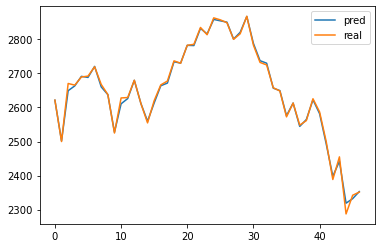

In [13]:
bmodel = TransformerTimeSeries(feature_dim = feature_dim,
                                  nhead = 4,num_layers = 12,d_model = 512,
                                  conv_len = 5,feature_weight = True,embedding_weight = True)
bmodel.load_state_dict(torch.load('GOOG'))
bmodel.to(device)
bmodel.eval()
with torch.no_grad(): # eliminate gradient i.e. gradients only exists in train()

    for step,(x,y,feature,attention_masks) in enumerate(test_dl):
        x = x.to(device)
        y = y.to(device)
        feature = feature.to(device)
        attention_masks = attention_masks.to(device)
        output = bmodel(x,y,feature,attention_masks[0])
        
        pred = data[train_size + 1 :-1,0]*0.01*(100+output[:,t0:].squeeze()).detach().cpu()
        real = data[train_size + 1 :-1,0]*0.01*(100+y[:,t0:].squeeze()).detach().cpu()

        plt.plot(pred)
        plt.plot(real)
        plt.legend(['pred','real'])
        MAE = torch.nn.L1Loss()(pred,real).item()
        MSE = torch.nn.MSELoss()(pred,real).item()
        RMSE = np.sqrt(MSE)
        
        print(f'GOOG MAE is {MAE}')
        print(f'GOOG MSE is {MSE}')
        print(f'GOOG RMSE is {RMSE}')

##### High

In [16]:
file_name = 'GOOG_features.csv'
with open(file_name) as f:
    data_list = csv.reader(f)
    data = []
    for row in data_list:
        data.append(row)
    f.close()
    
data = torch.tensor(np.delete(np.array(data)[1:,2:],4,axis = 1).astype(np.float)).type(torch.float)

feature_dim = data.shape[1] - 1
rate = []
for i in range(1,data.shape[0]):
    rate.append((100*(data[i,0:4] - data[i-1,0:4])/data[i-1,0:4]).reshape(1,4))
    
rate = torch.cat(rate)
rate_data = torch.cat([rate,data[1:,4:]],1)
train_size = int(data.shape[0]*0.9)
data_train = rate_data[0:train_size]
data_test = rate_data[train_size-4:]


t0 = 5
to_predict = 1
train_dataset = GetData(data_train[:,1],torch.cat([data_train[:,0].unsqueeze(1),data_train[:,2:]],1),t0 = t0, to_predict = to_predict)
test_dataset = GetData(data_test[:,1],torch.cat([data_test[:,0].unsqueeze(1),data_test[:,2:]],1),t0 = t0, to_predict = to_predict)
criterion = torch.nn.MSELoss()
# dataloaders
train_dl = DataLoader(train_dataset,batch_size=256,shuffle=True)
test_dl = DataLoader(test_dataset,batch_size=512)





model = TransformerTimeSeries(feature_dim = feature_dim,
                              nhead = 4,num_layers = 12,d_model = 512,
                              conv_len = 5,feature_weight = True,embedding_weight = True)
model = model.to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=1e-5 ,momentum = 0.9, nesterov = True)#Adam optimizer
#scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer,5e-7,3e-5,10,mode = 'exp_range',gamma = 0.9996)



train_epoch_loss = []
test_epoch_loss = []
test_best = 9999
for epoch in tqdm(range(4000)):


    l_t = train_epoch(model,train_dl,optimizer,t0,to_predict)

    train_loss = test_epoch(model,train_dl,t0,to_predict)


    test_loss = test_epoch(model,test_dl,t0,to_predict)


    if test_best > test_loss:
        test_best = test_loss
        torch.save(model.state_dict(), 'GOOG_H')



    train_epoch_loss.append(np.mean(train_loss))
    test_epoch_loss.append(test_loss)

    print("Epoch {}: Train loss: {} \t test loss: {}".format(epoch+1,
                                                             np.mean(train_loss),
                                                             test_loss))
    #scheduler.step()

torch.Size([431, 6])
torch.Size([431, 6])
torch.Size([47, 6])
torch.Size([47, 6])


  0%|                                                                                     | 0/4000 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1944: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
  0%|                                                                             | 1/4000 [00:00<23:22,  2.85it/s]

Epoch 1: Train loss: 1.0700445136448624 	 test loss: 1.3347887992858887


  0%|                                                                             | 2/4000 [00:01<44:28,  1.50it/s]

Epoch 2: Train loss: 1.0662731120315339 	 test loss: 1.3271912336349487


  0%|                                                                             | 3/4000 [00:02<51:31,  1.29it/s]

Epoch 3: Train loss: 1.0627323253525383 	 test loss: 1.3192987442016602


  0%|                                                                             | 4/4000 [00:03<54:46,  1.22it/s]

Epoch 4: Train loss: 1.0604941275169568 	 test loss: 1.311975121498108


  0%|                                                                             | 5/4000 [00:03<55:32,  1.20it/s]

Epoch 5: Train loss: 1.0592585683145546 	 test loss: 1.304961919784546


  0%|                                                                             | 6/4000 [00:04<56:52,  1.17it/s]

Epoch 6: Train loss: 1.0585270240522593 	 test loss: 1.2992215156555176


  0%|▏                                                                            | 7/4000 [00:05<57:54,  1.15it/s]

Epoch 7: Train loss: 1.0579598699534298 	 test loss: 1.2946079969406128


  0%|▏                                                                            | 8/4000 [00:06<58:22,  1.14it/s]

Epoch 8: Train loss: 1.0575421086043604 	 test loss: 1.2914882898330688


  0%|▏                                                                           | 10/4000 [00:07<43:49,  1.52it/s]

Epoch 9: Train loss: 1.0571550545725634 	 test loss: 1.2908389568328857
Epoch 10: Train loss: 1.0567601620459501 	 test loss: 1.2915518283843994


  0%|▏                                                                           | 12/4000 [00:07<25:53,  2.57it/s]

Epoch 11: Train loss: 1.0564260742780505 	 test loss: 1.292768120765686
Epoch 12: Train loss: 1.0561664140418068 	 test loss: 1.2949615716934204


  0%|▎                                                                           | 14/4000 [00:08<17:16,  3.84it/s]

Epoch 13: Train loss: 1.0559400790252154 	 test loss: 1.2970893383026123
Epoch 14: Train loss: 1.0558441382273167 	 test loss: 1.299720287322998


  0%|▎                                                                           | 16/4000 [00:08<13:04,  5.08it/s]

Epoch 15: Train loss: 1.055626905434646 	 test loss: 1.3005586862564087
Epoch 16: Train loss: 1.055374004724684 	 test loss: 1.3008201122283936


  0%|▎                                                                           | 18/4000 [00:08<11:02,  6.01it/s]

Epoch 17: Train loss: 1.0550258353248827 	 test loss: 1.30070960521698
Epoch 18: Train loss: 1.05451781982059 	 test loss: 1.2993204593658447


  0%|▍                                                                           | 20/4000 [00:09<10:02,  6.61it/s]

Epoch 19: Train loss: 1.0539483490233632 	 test loss: 1.2979388236999512
Epoch 20: Train loss: 1.0534099724895716 	 test loss: 1.2965866327285767


  1%|▍                                                                           | 22/4000 [00:09<09:33,  6.93it/s]

Epoch 21: Train loss: 1.0528519192317245 	 test loss: 1.295090675354004
Epoch 22: Train loss: 1.0522159089068526 	 test loss: 1.2933008670806885


  1%|▍                                                                           | 23/4000 [00:09<09:25,  7.03it/s]

Epoch 23: Train loss: 1.051653228890315 	 test loss: 1.2915043830871582


  1%|▍                                                                           | 24/4000 [00:10<24:15,  2.73it/s]

Epoch 24: Train loss: 1.0506139125182292 	 test loss: 1.2891749143600464


  1%|▍                                                                           | 26/4000 [00:11<27:06,  2.44it/s]

Epoch 25: Train loss: 1.0502054582062563 	 test loss: 1.2885026931762695
Epoch 26: Train loss: 1.0501454327333277 	 test loss: 1.2888340950012207


  1%|▌                                                                           | 27/4000 [00:12<36:41,  1.80it/s]

Epoch 27: Train loss: 1.049643527327447 	 test loss: 1.2878565788269043


  1%|▌                                                                           | 28/4000 [00:13<43:26,  1.52it/s]

Epoch 28: Train loss: 1.0490660598272514 	 test loss: 1.2863426208496094


  1%|▌                                                                           | 29/4000 [00:14<48:19,  1.37it/s]

Epoch 29: Train loss: 1.0486101336656204 	 test loss: 1.2851450443267822


  1%|▌                                                                           | 30/4000 [00:14<52:00,  1.27it/s]

Epoch 30: Train loss: 1.0480786841319498 	 test loss: 1.2845128774642944


  1%|▌                                                                           | 32/4000 [00:15<40:37,  1.63it/s]

Epoch 31: Train loss: 1.0476798792726203 	 test loss: 1.2844916582107544
Epoch 32: Train loss: 1.0473162173671677 	 test loss: 1.2850056886672974


  1%|▋                                                                           | 34/4000 [00:16<24:30,  2.70it/s]

Epoch 33: Train loss: 1.0470957496050062 	 test loss: 1.2859159708023071
Epoch 34: Train loss: 1.0468276685185887 	 test loss: 1.2859004735946655


  1%|▋                                                                           | 35/4000 [00:16<19:51,  3.33it/s]

Epoch 35: Train loss: 1.046335556944119 	 test loss: 1.285285234451294


  1%|▋                                                                           | 36/4000 [00:17<31:40,  2.09it/s]

Epoch 36: Train loss: 1.0458226129239783 	 test loss: 1.2843297719955444


  1%|▋                                                                         | 37/4000 [00:22<2:03:28,  1.87s/it]

Epoch 37: Train loss: 1.0451069353904636 	 test loss: 1.282187581062317


  1%|▋                                                                         | 38/4000 [00:29<3:44:36,  3.40s/it]

Epoch 38: Train loss: 1.0444002527648502 	 test loss: 1.2801105976104736


  1%|▋                                                                         | 39/4000 [00:35<4:47:44,  4.36s/it]

Epoch 39: Train loss: 1.0436966966863575 	 test loss: 1.2771226167678833


  1%|▋                                                                         | 40/4000 [00:41<5:18:05,  4.82s/it]

Epoch 40: Train loss: 1.043037561142251 	 test loss: 1.2751548290252686


  1%|▊                                                                         | 42/4000 [00:49<4:19:12,  3.93s/it]

Epoch 41: Train loss: 1.0424189999042697 	 test loss: 1.273668885231018
Epoch 42: Train loss: 1.0419601586467981 	 test loss: 1.273735523223877


  1%|▊                                                                         | 44/4000 [00:49<2:11:37,  2.00s/it]

Epoch 43: Train loss: 1.0415747212699837 	 test loss: 1.2739875316619873
Epoch 44: Train loss: 1.0411802239871633 	 test loss: 1.2745206356048584


  1%|▊                                                                         | 46/4000 [00:49<1:09:09,  1.05s/it]

Epoch 45: Train loss: 1.0409272707255424 	 test loss: 1.2752164602279663
Epoch 46: Train loss: 1.0404536610689628 	 test loss: 1.274841547012329


  1%|▉                                                                           | 48/4000 [00:50<38:33,  1.71it/s]

Epoch 47: Train loss: 1.0401021610003336 	 test loss: 1.274886131286621
Epoch 48: Train loss: 1.0396309341466068 	 test loss: 1.2742968797683716


  1%|▉                                                                         | 49/4000 [00:55<2:19:13,  2.11s/it]

Epoch 49: Train loss: 1.0391199729835352 	 test loss: 1.2734053134918213


  1%|▉                                                                         | 50/4000 [01:02<3:52:24,  3.53s/it]

Epoch 50: Train loss: 1.0383998617495296 	 test loss: 1.2715522050857544


  1%|▉                                                                         | 51/4000 [01:08<4:47:52,  4.37s/it]

Epoch 51: Train loss: 1.0377450669724537 	 test loss: 1.2698283195495605


  1%|▉                                                                         | 52/4000 [01:15<5:35:30,  5.10s/it]

Epoch 52: Train loss: 1.0369777346155207 	 test loss: 1.2676961421966553


  1%|▉                                                                         | 53/4000 [01:22<6:02:12,  5.51s/it]

Epoch 53: Train loss: 1.0362536788263343 	 test loss: 1.265931248664856


  1%|▉                                                                         | 54/4000 [01:28<6:23:18,  5.83s/it]

Epoch 54: Train loss: 1.035761058192242 	 test loss: 1.2647093534469604


  1%|█                                                                         | 56/4000 [01:35<4:41:07,  4.28s/it]

Epoch 55: Train loss: 1.0351519761671877 	 test loss: 1.263579249382019
Epoch 56: Train loss: 1.0349270337695589 	 test loss: 1.2636409997940063


  1%|█                                                                         | 57/4000 [01:42<5:25:12,  4.95s/it]

Epoch 57: Train loss: 1.0344406961011776 	 test loss: 1.2631890773773193


  1%|█                                                                         | 58/4000 [01:48<5:51:09,  5.34s/it]

Epoch 58: Train loss: 1.033921692736464 	 test loss: 1.2623753547668457


  1%|█                                                                         | 59/4000 [01:55<6:22:00,  5.82s/it]

Epoch 59: Train loss: 1.0333977412181774 	 test loss: 1.2614316940307617


  2%|█                                                                         | 60/4000 [02:01<6:36:55,  6.04s/it]

Epoch 60: Train loss: 1.0327400388131285 	 test loss: 1.2601300477981567


  2%|█▏                                                                        | 61/4000 [02:08<6:48:50,  6.23s/it]

Epoch 61: Train loss: 1.0323564038199229 	 test loss: 1.2597956657409668


  2%|█▏                                                                        | 62/4000 [02:15<6:55:37,  6.33s/it]

Epoch 62: Train loss: 1.031715685142995 	 test loss: 1.2584307193756104


  2%|█▏                                                                        | 63/4000 [02:21<7:01:01,  6.42s/it]

Epoch 63: Train loss: 1.031133802058802 	 test loss: 1.257156491279602


  2%|█▏                                                                        | 64/4000 [02:28<7:04:34,  6.47s/it]

Epoch 64: Train loss: 1.0305666265244273 	 test loss: 1.2561975717544556


  2%|█▏                                                                        | 65/4000 [02:35<7:12:21,  6.59s/it]

Epoch 65: Train loss: 1.0299973563915616 	 test loss: 1.2552369832992554


  2%|█▏                                                                        | 66/4000 [02:41<7:07:45,  6.52s/it]

Epoch 66: Train loss: 1.0294444475262459 	 test loss: 1.2544113397598267


  2%|█▏                                                                        | 67/4000 [02:48<7:08:50,  6.54s/it]

Epoch 67: Train loss: 1.02884519957611 	 test loss: 1.253537893295288


  2%|█▎                                                                        | 68/4000 [02:54<7:09:42,  6.56s/it]

Epoch 68: Train loss: 1.0281278094116884 	 test loss: 1.2519779205322266


  2%|█▎                                                                        | 69/4000 [03:01<7:11:05,  6.58s/it]

Epoch 69: Train loss: 1.0273840336124747 	 test loss: 1.2503769397735596


  2%|█▎                                                                        | 70/4000 [03:07<7:11:25,  6.59s/it]

Epoch 70: Train loss: 1.0262888322850114 	 test loss: 1.2481660842895508


  2%|█▎                                                                        | 71/4000 [03:14<7:11:51,  6.59s/it]

Epoch 71: Train loss: 1.0256860871602653 	 test loss: 1.2470159530639648


  2%|█▎                                                                        | 73/4000 [03:21<5:04:53,  4.66s/it]

Epoch 72: Train loss: 1.0252759901940685 	 test loss: 1.2469422817230225
Epoch 73: Train loss: 1.0248921299201983 	 test loss: 1.2474915981292725


  2%|█▍                                                                        | 75/4000 [03:27<4:00:54,  3.68s/it]

Epoch 74: Train loss: 1.0242637478835068 	 test loss: 1.2465041875839233
Epoch 75: Train loss: 1.0238521572055508 	 test loss: 1.2470523118972778


  2%|█▍                                                                        | 76/4000 [03:27<2:51:23,  2.62s/it]

Epoch 76: Train loss: 1.0232833679203643 	 test loss: 1.2468169927597046


  2%|█▍                                                                        | 78/4000 [03:34<2:50:53,  2.61s/it]

Epoch 77: Train loss: 1.0227372693351693 	 test loss: 1.246443510055542
Epoch 78: Train loss: 1.0222473078150207 	 test loss: 1.2466191053390503


  2%|█▍                                                                        | 79/4000 [03:40<4:09:54,  3.82s/it]

Epoch 79: Train loss: 1.0216643619426717 	 test loss: 1.2460060119628906


  2%|█▍                                                                        | 80/4000 [03:47<5:04:16,  4.66s/it]

Epoch 80: Train loss: 1.0211532707833912 	 test loss: 1.2458864450454712


  2%|█▍                                                                        | 81/4000 [03:54<5:42:21,  5.24s/it]

Epoch 81: Train loss: 1.0203194034625096 	 test loss: 1.24508798122406


  2%|█▌                                                                        | 82/4000 [04:00<6:07:43,  5.63s/it]

Epoch 82: Train loss: 1.019288870270457 	 test loss: 1.244091272354126


  2%|█▌                                                                        | 83/4000 [04:07<6:27:28,  5.94s/it]

Epoch 83: Train loss: 1.0187504573653856 	 test loss: 1.2439391613006592


  2%|█▌                                                                        | 84/4000 [04:13<6:40:50,  6.14s/it]

Epoch 84: Train loss: 1.0179897492833592 	 test loss: 1.2424468994140625


  2%|█▌                                                                        | 85/4000 [04:20<6:48:55,  6.27s/it]

Epoch 85: Train loss: 1.0171903316493378 	 test loss: 1.2408884763717651


  2%|█▌                                                                        | 86/4000 [04:27<6:55:59,  6.38s/it]

Epoch 86: Train loss: 1.016201076264171 	 test loss: 1.2376283407211304


  2%|█▌                                                                        | 87/4000 [04:33<7:00:24,  6.45s/it]

Epoch 87: Train loss: 1.0151997221041722 	 test loss: 1.2343692779541016


  2%|█▋                                                                        | 88/4000 [04:40<7:02:43,  6.48s/it]

Epoch 88: Train loss: 1.0142524961529087 	 test loss: 1.2321573495864868


  2%|█▋                                                                        | 90/4000 [04:47<5:00:43,  4.61s/it]

Epoch 89: Train loss: 1.013486404430009 	 test loss: 1.231339931488037
Epoch 90: Train loss: 1.0128596243891528 	 test loss: 1.2317765951156616


  2%|█▋                                                                        | 92/4000 [04:47<2:31:52,  2.33s/it]

Epoch 91: Train loss: 1.0123676978518403 	 test loss: 1.2328740358352661
Epoch 92: Train loss: 1.011852849663825 	 test loss: 1.233344316482544


  2%|█▋                                                                        | 94/4000 [04:47<1:18:54,  1.21s/it]

Epoch 93: Train loss: 1.0113320686701002 	 test loss: 1.2335652112960815
Epoch 94: Train loss: 1.0109918875373434 	 test loss: 1.2344696521759033


  2%|█▊                                                                          | 96/4000 [04:47<43:10,  1.51it/s]

Epoch 95: Train loss: 1.0105311194318076 	 test loss: 1.2347795963287354
Epoch 96: Train loss: 1.0095083331840498 	 test loss: 1.2332111597061157


  2%|█▊                                                                        | 97/4000 [04:53<2:20:14,  2.16s/it]

Epoch 97: Train loss: 1.008512187999805 	 test loss: 1.2307535409927368


  2%|█▊                                                                        | 98/4000 [05:00<3:45:34,  3.47s/it]

Epoch 98: Train loss: 1.0072652361509142 	 test loss: 1.2273941040039062


  2%|█▊                                                                        | 99/4000 [05:06<4:44:36,  4.38s/it]

Epoch 99: Train loss: 1.0062048371596015 	 test loss: 1.2246363162994385


  2%|█▊                                                                       | 100/4000 [05:13<5:31:23,  5.10s/it]

Epoch 100: Train loss: 1.0051441192626953 	 test loss: 1.2218620777130127


  3%|█▊                                                                       | 101/4000 [05:19<6:00:37,  5.55s/it]

Epoch 101: Train loss: 1.0040477189276444 	 test loss: 1.219780445098877


  3%|█▉                                                                       | 103/4000 [05:25<4:19:36,  4.00s/it]

Epoch 102: Train loss: 1.003328815690326 	 test loss: 1.2194349765777588
Epoch 103: Train loss: 1.0028883402696065 	 test loss: 1.2202813625335693


  3%|█▉                                                                       | 105/4000 [05:26<2:11:41,  2.03s/it]

Epoch 104: Train loss: 1.0025120871249595 	 test loss: 1.2211817502975464
Epoch 105: Train loss: 1.001558575718696 	 test loss: 1.2199071645736694


  3%|█▉                                                                       | 106/4000 [05:33<3:46:13,  3.49s/it]

Epoch 106: Train loss: 1.0008012540379145 	 test loss: 1.2192505598068237


  3%|█▉                                                                       | 107/4000 [05:39<4:47:06,  4.42s/it]

Epoch 107: Train loss: 1.0001138421056441 	 test loss: 1.2187845706939697


  3%|█▉                                                                       | 108/4000 [05:46<5:29:33,  5.08s/it]

Epoch 108: Train loss: 0.9991312743339628 	 test loss: 1.2176399230957031


  3%|█▉                                                                       | 109/4000 [05:52<5:58:55,  5.53s/it]

Epoch 109: Train loss: 0.9981744831510043 	 test loss: 1.216280460357666


  3%|██                                                                       | 110/4000 [05:58<6:06:51,  5.66s/it]

Epoch 110: Train loss: 0.99725814844782 	 test loss: 1.2148429155349731


  3%|██                                                                       | 111/4000 [06:06<6:38:04,  6.14s/it]

Epoch 111: Train loss: 0.9963045136834519 	 test loss: 1.2131078243255615


  3%|██                                                                       | 112/4000 [06:12<6:33:37,  6.07s/it]

Epoch 112: Train loss: 0.9953243068641964 	 test loss: 1.211735486984253


  3%|██                                                                       | 113/4000 [06:19<6:56:41,  6.43s/it]

Epoch 113: Train loss: 0.994405502786216 	 test loss: 1.2102854251861572


  3%|██                                                                       | 114/4000 [06:25<7:00:16,  6.49s/it]

Epoch 114: Train loss: 0.9935065460868888 	 test loss: 1.2085931301116943


  3%|██                                                                       | 115/4000 [06:32<7:06:00,  6.58s/it]

Epoch 115: Train loss: 0.9923682508778406 	 test loss: 1.2061586380004883


  3%|██                                                                       | 116/4000 [06:39<7:08:33,  6.62s/it]

Epoch 116: Train loss: 0.991330332656471 	 test loss: 1.2044094800949097


  3%|██▏                                                                      | 117/4000 [06:46<7:11:32,  6.67s/it]

Epoch 117: Train loss: 0.9908080166011288 	 test loss: 1.2038573026657104


  3%|██▏                                                                      | 118/4000 [06:52<7:09:57,  6.65s/it]

Epoch 118: Train loss: 0.9897312083543038 	 test loss: 1.2020907402038574


  3%|██▏                                                                      | 120/4000 [06:59<5:02:39,  4.68s/it]

Epoch 119: Train loss: 0.9886679273193785 	 test loss: 1.2004708051681519
Epoch 120: Train loss: 0.9881413309314134 	 test loss: 1.2006474733352661


  3%|██▏                                                                      | 121/4000 [07:06<5:36:33,  5.21s/it]

Epoch 121: Train loss: 0.9872597082585027 	 test loss: 1.1994903087615967


  3%|██▏                                                                      | 122/4000 [07:12<5:58:36,  5.55s/it]

Epoch 122: Train loss: 0.9862826721021029 	 test loss: 1.197223424911499


  3%|██▏                                                                      | 123/4000 [07:19<6:25:12,  5.96s/it]

Epoch 123: Train loss: 0.9849177045777889 	 test loss: 1.194159984588623


  3%|██▎                                                                      | 124/4000 [07:25<6:36:19,  6.14s/it]

Epoch 124: Train loss: 0.9840893087143687 	 test loss: 1.1915332078933716


  3%|██▎                                                                      | 125/4000 [07:32<6:46:16,  6.29s/it]

Epoch 125: Train loss: 0.9825939078342057 	 test loss: 1.1894922256469727


  3%|██▎                                                                      | 126/4000 [07:39<6:52:37,  6.39s/it]

Epoch 126: Train loss: 0.9804884231284157 	 test loss: 1.1850966215133667


  3%|██▎                                                                      | 127/4000 [07:45<6:56:12,  6.45s/it]

Epoch 127: Train loss: 0.9787018495480035 	 test loss: 1.1812340021133423


  3%|██▎                                                                      | 129/4000 [07:52<4:51:14,  4.51s/it]

Epoch 128: Train loss: 0.977551228070757 	 test loss: 1.179860234260559
Epoch 129: Train loss: 0.9768868601792373 	 test loss: 1.1807479858398438


  3%|██▍                                                                      | 131/4000 [07:52<2:27:12,  2.28s/it]

Epoch 130: Train loss: 0.9764237789709441 	 test loss: 1.1818724870681763
Epoch 131: Train loss: 0.9757292420017747 	 test loss: 1.1817314624786377


  3%|██▍                                                                      | 132/4000 [07:52<1:45:41,  1.64s/it]

Epoch 132: Train loss: 0.9745389882760369 	 test loss: 1.1805096864700317


  3%|██▍                                                                      | 133/4000 [07:58<3:04:40,  2.87s/it]

Epoch 133: Train loss: 0.972804842719899 	 test loss: 1.1777163743972778


  3%|██▍                                                                      | 134/4000 [08:05<4:30:19,  4.20s/it]

Epoch 134: Train loss: 0.9712345110567983 	 test loss: 1.1744451522827148


  3%|██▍                                                                      | 135/4000 [08:12<5:16:57,  4.92s/it]

Epoch 135: Train loss: 0.9696478278067162 	 test loss: 1.1718837022781372


  3%|██▍                                                                      | 136/4000 [08:18<5:53:33,  5.49s/it]

Epoch 136: Train loss: 0.9679027024112002 	 test loss: 1.16923987865448


  3%|██▌                                                                      | 138/4000 [08:24<4:12:35,  3.92s/it]

Epoch 137: Train loss: 0.9664039726600293 	 test loss: 1.1675262451171875
Epoch 138: Train loss: 0.9664207340116567 	 test loss: 1.1688520908355713


  3%|██▌                                                                      | 139/4000 [08:24<2:59:26,  2.79s/it]

Epoch 139: Train loss: 0.9653007953736732 	 test loss: 1.167560338973999


  4%|██▌                                                                      | 140/4000 [08:31<4:21:07,  4.06s/it]

Epoch 140: Train loss: 0.962822859220881 	 test loss: 1.1624020338058472


  4%|██▌                                                                      | 141/4000 [08:38<5:10:08,  4.82s/it]

Epoch 141: Train loss: 0.9601310936868053 	 test loss: 1.1569256782531738


  4%|██▌                                                                      | 142/4000 [08:45<5:44:24,  5.36s/it]

Epoch 142: Train loss: 0.9576755446790266 	 test loss: 1.152345061302185


  4%|██▌                                                                      | 143/4000 [08:51<6:06:56,  5.71s/it]

Epoch 143: Train loss: 0.9559348608667502 	 test loss: 1.1494208574295044


  4%|██▋                                                                      | 145/4000 [08:58<4:32:17,  4.24s/it]

Epoch 144: Train loss: 0.9543477556821641 	 test loss: 1.1471607685089111
Epoch 145: Train loss: 0.9533277918733742 	 test loss: 1.1473031044006348


  4%|██▋                                                                      | 147/4000 [09:05<3:43:18,  3.48s/it]

Epoch 146: Train loss: 0.9521218026597096 	 test loss: 1.1464463472366333
Epoch 147: Train loss: 0.9515585169161556 	 test loss: 1.146497368812561


  4%|██▋                                                                      | 148/4000 [09:05<2:38:55,  2.48s/it]

Epoch 148: Train loss: 0.9509214491965876 	 test loss: 1.1465961933135986


  4%|██▋                                                                      | 149/4000 [09:11<3:52:36,  3.62s/it]

Epoch 149: Train loss: 0.9502158131787506 	 test loss: 1.1463717222213745


  4%|██▋                                                                      | 150/4000 [09:18<4:50:17,  4.52s/it]

Epoch 150: Train loss: 0.9492483506899698 	 test loss: 1.1454768180847168


  4%|██▊                                                                      | 151/4000 [09:24<5:30:12,  5.15s/it]

Epoch 151: Train loss: 0.9474526392058265 	 test loss: 1.1427764892578125


  4%|██▊                                                                      | 152/4000 [09:31<5:51:56,  5.49s/it]

Epoch 152: Train loss: 0.9447019563473571 	 test loss: 1.1381516456604004


  4%|██▊                                                                      | 153/4000 [09:37<6:16:19,  5.87s/it]

Epoch 153: Train loss: 0.9422806989565803 	 test loss: 1.1340214014053345


  4%|██▊                                                                      | 154/4000 [09:44<6:33:29,  6.14s/it]

Epoch 154: Train loss: 0.9401808739261671 	 test loss: 1.130325436592102


  4%|██▊                                                                      | 155/4000 [09:51<6:41:17,  6.26s/it]

Epoch 155: Train loss: 0.9379865345988085 	 test loss: 1.1271255016326904


  4%|██▊                                                                      | 157/4000 [09:57<4:48:27,  4.50s/it]

Epoch 156: Train loss: 0.9360949218688044 	 test loss: 1.123943567276001
Epoch 157: Train loss: 0.9353582546495229 	 test loss: 1.1240391731262207


  4%|██▉                                                                      | 159/4000 [09:58<2:25:45,  2.28s/it]

Epoch 158: Train loss: 0.9350697851789523 	 test loss: 1.1251298189163208
Epoch 159: Train loss: 0.9339161888629267 	 test loss: 1.1251325607299805


  4%|██▉                                                                      | 160/4000 [10:03<3:34:13,  3.35s/it]

Epoch 160: Train loss: 0.9313622776704156 	 test loss: 1.1214704513549805


  4%|██▉                                                                      | 161/4000 [10:10<4:43:06,  4.42s/it]

Epoch 161: Train loss: 0.9282070724704149 	 test loss: 1.115675449371338


  4%|██▉                                                                      | 162/4000 [10:17<5:25:36,  5.09s/it]

Epoch 162: Train loss: 0.9260212091724723 	 test loss: 1.112182855606079


  4%|██▉                                                                      | 164/4000 [10:24<4:10:41,  3.92s/it]

Epoch 163: Train loss: 0.9241747085843451 	 test loss: 1.1104153394699097
Epoch 164: Train loss: 0.9243821747894907 	 test loss: 1.1127504110336304


  4%|███                                                                      | 165/4000 [10:24<2:58:11,  2.79s/it]

Epoch 165: Train loss: 0.9234906899680118 	 test loss: 1.1124125719070435


  4%|███                                                                      | 166/4000 [10:30<3:53:07,  3.65s/it]

Epoch 166: Train loss: 0.9192597498196737 	 test loss: 1.104452133178711


  4%|███                                                                      | 167/4000 [10:36<4:54:52,  4.62s/it]

Epoch 167: Train loss: 0.915362081505583 	 test loss: 1.0972014665603638


  4%|███                                                                      | 168/4000 [10:43<5:40:04,  5.32s/it]

Epoch 168: Train loss: 0.9121820167433081 	 test loss: 1.091128945350647


  4%|███                                                                      | 169/4000 [10:50<6:05:02,  5.72s/it]

Epoch 169: Train loss: 0.9091337673072195 	 test loss: 1.0855427980422974


  4%|███                                                                      | 170/4000 [10:57<6:21:29,  5.98s/it]

Epoch 170: Train loss: 0.9068090369419266 	 test loss: 1.0818923711776733


  4%|███                                                                      | 171/4000 [11:03<6:33:36,  6.17s/it]

Epoch 171: Train loss: 0.9048773339342352 	 test loss: 1.0796849727630615


  4%|███▏                                                                     | 172/4000 [11:10<6:41:36,  6.29s/it]

Epoch 172: Train loss: 0.90342590952694 	 test loss: 1.07875394821167


  4%|███▏                                                                     | 173/4000 [11:16<6:35:04,  6.19s/it]

Epoch 173: Train loss: 0.9023043719355855 	 test loss: 1.0783544778823853


  4%|███▏                                                                     | 175/4000 [11:23<4:49:04,  4.53s/it]

Epoch 174: Train loss: 0.901607189958444 	 test loss: 1.0781989097595215
Epoch 175: Train loss: 0.9023696899137474 	 test loss: 1.0807766914367676


  4%|███▏                                                                     | 176/4000 [11:23<3:24:56,  3.22s/it]

Epoch 176: Train loss: 0.9015607211540028 	 test loss: 1.079980492591858


  4%|███▏                                                                     | 177/4000 [11:30<4:30:03,  4.24s/it]

Epoch 177: Train loss: 0.897420733268189 	 test loss: 1.0734429359436035


  4%|███▏                                                                     | 178/4000 [11:36<5:15:11,  4.95s/it]

Epoch 178: Train loss: 0.894498232899022 	 test loss: 1.0689704418182373


  4%|███▎                                                                     | 179/4000 [11:43<5:45:43,  5.43s/it]

Epoch 179: Train loss: 0.8919673495668823 	 test loss: 1.065488338470459


  4%|███▎                                                                     | 180/4000 [11:50<6:09:47,  5.81s/it]

Epoch 180: Train loss: 0.8898218332199929 	 test loss: 1.062451720237732


  5%|███▎                                                                     | 181/4000 [11:56<6:24:30,  6.04s/it]

Epoch 181: Train loss: 0.8881427410583762 	 test loss: 1.0602314472198486


  5%|███▎                                                                     | 182/4000 [12:02<6:29:01,  6.11s/it]

Epoch 182: Train loss: 0.8848824915919116 	 test loss: 1.0550376176834106


  5%|███▎                                                                     | 183/4000 [12:09<6:31:31,  6.15s/it]

Epoch 183: Train loss: 0.8822143249334703 	 test loss: 1.0509412288665771


  5%|███▎                                                                     | 184/4000 [12:15<6:44:42,  6.36s/it]

Epoch 184: Train loss: 0.8816890890802972 	 test loss: 1.0507333278656006


  5%|███▍                                                                     | 185/4000 [12:22<6:56:42,  6.55s/it]

Epoch 185: Train loss: 0.8808865678559323 	 test loss: 1.0502967834472656


  5%|███▍                                                                     | 186/4000 [12:29<6:55:42,  6.54s/it]

Epoch 186: Train loss: 0.8794985441210098 	 test loss: 1.0472486019134521


  5%|███▍                                                                     | 187/4000 [12:36<6:59:19,  6.60s/it]

Epoch 187: Train loss: 0.876856258048259 	 test loss: 1.0432177782058716


  5%|███▍                                                                     | 188/4000 [12:42<6:46:50,  6.40s/it]

Epoch 188: Train loss: 0.8739714658453956 	 test loss: 1.0381568670272827


  5%|███▍                                                                     | 189/4000 [12:48<6:49:44,  6.45s/it]

Epoch 189: Train loss: 0.8713225286687333 	 test loss: 1.0340157747268677


  5%|███▍                                                                     | 190/4000 [12:56<7:05:56,  6.71s/it]

Epoch 190: Train loss: 0.8683726592572825 	 test loss: 1.0286533832550049


  5%|███▍                                                                     | 191/4000 [13:02<7:07:34,  6.74s/it]

Epoch 191: Train loss: 0.8666928682968954 	 test loss: 1.0276695489883423


  5%|███▌                                                                     | 192/4000 [13:09<7:01:12,  6.64s/it]

Epoch 192: Train loss: 0.8653451106111301 	 test loss: 1.0268192291259766


  5%|███▌                                                                     | 193/4000 [13:15<7:00:31,  6.63s/it]

Epoch 193: Train loss: 0.8640181637971971 	 test loss: 1.0262091159820557


  5%|███▌                                                                     | 195/4000 [13:22<4:56:22,  4.67s/it]

Epoch 194: Train loss: 0.8615410744175833 	 test loss: 1.0227419137954712
Epoch 195: Train loss: 0.860793982608689 	 test loss: 1.0227910280227661


  5%|███▌                                                                     | 196/4000 [13:22<3:30:00,  3.31s/it]

Epoch 196: Train loss: 0.8622355108471315 	 test loss: 1.0262812376022339


  5%|███▌                                                                     | 197/4000 [13:29<4:26:29,  4.20s/it]

Epoch 197: Train loss: 0.8586788023984072 	 test loss: 1.0219026803970337


  5%|███▌                                                                     | 198/4000 [13:35<5:12:59,  4.94s/it]

Epoch 198: Train loss: 0.8533911447790549 	 test loss: 1.015442132949829


  5%|███▋                                                                     | 199/4000 [13:42<5:44:05,  5.43s/it]

Epoch 199: Train loss: 0.8494124467854157 	 test loss: 1.0099117755889893


  5%|███▋                                                                     | 201/4000 [13:48<4:14:16,  4.02s/it]

Epoch 200: Train loss: 0.846203481376586 	 test loss: 1.0059609413146973
Epoch 201: Train loss: 0.8449634410389062 	 test loss: 1.0062156915664673


  5%|███▋                                                                     | 202/4000 [13:55<5:07:36,  4.86s/it]

Epoch 202: Train loss: 0.8436634626300041 	 test loss: 1.0047534704208374


  5%|███▋                                                                     | 203/4000 [14:02<5:40:26,  5.38s/it]

Epoch 203: Train loss: 0.8408017685407829 	 test loss: 1.001018762588501


  5%|███▋                                                                     | 204/4000 [14:08<6:04:08,  5.76s/it]

Epoch 204: Train loss: 0.8370121106194233 	 test loss: 0.9960805773735046


  5%|███▋                                                                     | 205/4000 [14:15<6:19:54,  6.01s/it]

Epoch 205: Train loss: 0.8326401866782293 	 test loss: 0.9894695281982422


  5%|███▊                                                                     | 206/4000 [14:21<6:30:42,  6.18s/it]

Epoch 206: Train loss: 0.8299248186728794 	 test loss: 0.9862945079803467


  5%|███▊                                                                     | 207/4000 [14:28<6:38:39,  6.31s/it]

Epoch 207: Train loss: 0.827840108467642 	 test loss: 0.9842527508735657


  5%|███▊                                                                     | 208/4000 [14:35<6:44:48,  6.41s/it]

Epoch 208: Train loss: 0.8241282799680936 	 test loss: 0.980111300945282


  5%|███▊                                                                     | 209/4000 [14:41<6:48:02,  6.46s/it]

Epoch 209: Train loss: 0.8210052612762717 	 test loss: 0.9758792519569397


  5%|███▊                                                                     | 210/4000 [14:48<6:50:05,  6.49s/it]

Epoch 210: Train loss: 0.8167208068055509 	 test loss: 0.9700438976287842


  5%|███▊                                                                     | 212/4000 [14:54<4:51:06,  4.61s/it]

Epoch 211: Train loss: 0.8149948854457475 	 test loss: 0.9690574407577515
Epoch 212: Train loss: 0.81729802662148 	 test loss: 0.9728710651397705


  5%|███▉                                                                     | 213/4000 [15:01<5:26:31,  5.17s/it]

Epoch 213: Train loss: 0.810726340021722 	 test loss: 0.9635441899299622


  5%|███▉                                                                     | 214/4000 [15:07<5:47:27,  5.51s/it]

Epoch 214: Train loss: 0.804023550862226 	 test loss: 0.9531418681144714


  5%|███▉                                                                     | 216/4000 [15:14<4:15:32,  4.05s/it]

Epoch 215: Train loss: 0.8009406668404139 	 test loss: 0.949813187122345
Epoch 216: Train loss: 0.8024381114269354 	 test loss: 0.9548689126968384


  5%|███▉                                                                     | 218/4000 [15:14<2:09:34,  2.06s/it]

Epoch 217: Train loss: 0.8010250689535295 	 test loss: 0.9519346952438354
Epoch 218: Train loss: 0.8009691199681045 	 test loss: 0.9538341760635376


  5%|███▉                                                                     | 219/4000 [15:14<1:33:17,  1.48s/it]

Epoch 219: Train loss: 0.8001989442898336 	 test loss: 0.9529057741165161


  6%|████                                                                     | 220/4000 [15:21<3:12:27,  3.05s/it]

Epoch 220: Train loss: 0.7929261232750046 	 test loss: 0.9439882040023804


  6%|████                                                                     | 221/4000 [15:27<4:17:03,  4.08s/it]

Epoch 221: Train loss: 0.7885279087068863 	 test loss: 0.9388695955276489


  6%|████                                                                     | 222/4000 [15:34<5:05:48,  4.86s/it]

Epoch 222: Train loss: 0.7835076491406788 	 test loss: 0.9331628084182739


  6%|████                                                                     | 223/4000 [15:40<5:37:08,  5.36s/it]

Epoch 223: Train loss: 0.779210766617494 	 test loss: 0.928286075592041


  6%|████                                                                     | 224/4000 [15:47<6:03:21,  5.77s/it]

Epoch 224: Train loss: 0.7745182537700627 	 test loss: 0.9217082858085632


  6%|████                                                                     | 226/4000 [15:54<4:28:00,  4.26s/it]

Epoch 225: Train loss: 0.7711386561670326 	 test loss: 0.9181371927261353
Epoch 226: Train loss: 0.77196988885198 	 test loss: 0.9197013974189758


  6%|████▏                                                                    | 227/4000 [15:54<3:10:11,  3.02s/it]

Epoch 227: Train loss: 0.7740439616333857 	 test loss: 0.9222300052642822


  6%|████▏                                                                    | 228/4000 [16:00<4:12:17,  4.01s/it]

Epoch 228: Train loss: 0.7704195467335996 	 test loss: 0.91790771484375


  6%|████▏                                                                    | 229/4000 [16:07<5:00:40,  4.78s/it]

Epoch 229: Train loss: 0.7645976399600921 	 test loss: 0.9125853180885315


  6%|████▏                                                                    | 230/4000 [16:14<5:35:15,  5.34s/it]

Epoch 230: Train loss: 0.7601223368102602 	 test loss: 0.9076725840568542


  6%|████▏                                                                    | 231/4000 [16:20<5:59:03,  5.72s/it]

Epoch 231: Train loss: 0.7576104813274818 	 test loss: 0.9064304828643799


  6%|████▏                                                                    | 232/4000 [16:27<6:15:30,  5.98s/it]

Epoch 232: Train loss: 0.75499202411302 	 test loss: 0.9025778770446777


  6%|████▎                                                                    | 233/4000 [16:33<6:20:42,  6.06s/it]

Epoch 233: Train loss: 0.7534406931936879 	 test loss: 0.8990777134895325


  6%|████▎                                                                    | 234/4000 [16:40<6:37:23,  6.33s/it]

Epoch 234: Train loss: 0.7468098368832794 	 test loss: 0.8928970694541931


  6%|████▎                                                                    | 235/4000 [16:47<6:41:25,  6.40s/it]

Epoch 235: Train loss: 0.741110359433079 	 test loss: 0.8880980014801025


  6%|████▎                                                                    | 236/4000 [16:53<6:45:37,  6.47s/it]

Epoch 236: Train loss: 0.7359288464842706 	 test loss: 0.8832041621208191


  6%|████▎                                                                    | 237/4000 [17:00<6:48:30,  6.51s/it]

Epoch 237: Train loss: 0.7330632259563614 	 test loss: 0.8803982734680176


  6%|████▎                                                                    | 238/4000 [17:06<6:50:16,  6.54s/it]

Epoch 238: Train loss: 0.7324074266128363 	 test loss: 0.8792224526405334


  6%|████▎                                                                    | 239/4000 [17:13<6:50:41,  6.55s/it]

Epoch 239: Train loss: 0.7304991631662763 	 test loss: 0.8768255114555359


  6%|████▍                                                                    | 240/4000 [17:20<6:51:32,  6.57s/it]

Epoch 240: Train loss: 0.7294750537230631 	 test loss: 0.8741641640663147


  6%|████▍                                                                    | 241/4000 [17:26<6:51:57,  6.58s/it]

Epoch 241: Train loss: 0.7280595710548613 	 test loss: 0.8722785711288452


  6%|████▍                                                                    | 242/4000 [17:32<6:44:30,  6.46s/it]

Epoch 242: Train loss: 0.7184714437084242 	 test loss: 0.8644728660583496


  6%|████▍                                                                    | 243/4000 [17:39<6:55:44,  6.64s/it]

Epoch 243: Train loss: 0.7119722216975661 	 test loss: 0.8570934534072876


  6%|████▍                                                                    | 244/4000 [17:46<6:54:55,  6.63s/it]

Epoch 244: Train loss: 0.7091329544436904 	 test loss: 0.8546928763389587


  6%|████▍                                                                    | 245/4000 [17:53<6:54:09,  6.62s/it]

Epoch 245: Train loss: 0.7079635171215385 	 test loss: 0.852690577507019


  6%|████▍                                                                    | 246/4000 [17:59<6:41:18,  6.41s/it]

Epoch 246: Train loss: 0.7003873297620539 	 test loss: 0.8441060185432434


  6%|████▌                                                                    | 247/4000 [18:05<6:44:55,  6.47s/it]

Epoch 247: Train loss: 0.697124918486292 	 test loss: 0.8401290774345398


  6%|████▌                                                                    | 249/4000 [18:12<4:52:04,  4.67s/it]

Epoch 248: Train loss: 0.6963286488349366 	 test loss: 0.8381494879722595
Epoch 249: Train loss: 0.7028826266319735 	 test loss: 0.8408274054527283


  6%|████▌                                                                    | 250/4000 [18:12<3:27:00,  3.31s/it]

Epoch 250: Train loss: 0.7026432558997878 	 test loss: 0.8395413160324097


  6%|████▌                                                                    | 251/4000 [18:19<4:26:49,  4.27s/it]

Epoch 251: Train loss: 0.6885265178304261 	 test loss: 0.8277662396430969


  6%|████▌                                                                    | 252/4000 [18:26<5:12:47,  5.01s/it]

Epoch 252: Train loss: 0.6816594476213035 	 test loss: 0.8192980885505676


  6%|████▌                                                                    | 253/4000 [18:32<5:40:06,  5.45s/it]

Epoch 253: Train loss: 0.6822915825379143 	 test loss: 0.8192605972290039


  6%|████▋                                                                    | 254/4000 [18:39<6:04:25,  5.84s/it]

Epoch 254: Train loss: 0.6799753644350234 	 test loss: 0.8154259920120239


  6%|████▋                                                                    | 255/4000 [18:45<6:18:38,  6.07s/it]

Epoch 255: Train loss: 0.6776362982537519 	 test loss: 0.8116444945335388


  6%|████▋                                                                    | 257/4000 [18:52<4:33:40,  4.39s/it]

Epoch 256: Train loss: 0.6687384452454729 	 test loss: 0.8033095598220825
Epoch 257: Train loss: 0.6707187282513576 	 test loss: 0.8040404319763184


  6%|████▋                                                                    | 259/4000 [18:52<2:18:29,  2.22s/it]

Epoch 258: Train loss: 0.6719889574427063 	 test loss: 0.8058685660362244
Epoch 259: Train loss: 0.6691796668997497 	 test loss: 0.80544513463974


  7%|████▊                                                                    | 261/4000 [18:53<1:12:11,  1.16s/it]

Epoch 260: Train loss: 0.6703395634682162 	 test loss: 0.8055517673492432
Epoch 261: Train loss: 0.6727984394108889 	 test loss: 0.8071184754371643


  7%|████▊                                                                    | 262/4000 [18:58<2:36:14,  2.51s/it]

Epoch 262: Train loss: 0.6649425907920519 	 test loss: 0.7979008555412292


  7%|████▊                                                                    | 263/4000 [19:05<3:52:55,  3.74s/it]

Epoch 263: Train loss: 0.6599719393004397 	 test loss: 0.7932727932929993


  7%|████▊                                                                    | 264/4000 [19:11<4:39:53,  4.50s/it]

Epoch 264: Train loss: 0.6542205072057773 	 test loss: 0.7863036394119263


  7%|████▊                                                                    | 265/4000 [19:19<5:31:26,  5.32s/it]

Epoch 265: Train loss: 0.6476474697517961 	 test loss: 0.7759388089179993


  7%|████▊                                                                    | 266/4000 [19:25<5:53:39,  5.68s/it]

Epoch 266: Train loss: 0.6446267836608356 	 test loss: 0.7722873091697693


  7%|████▉                                                                    | 268/4000 [19:32<4:23:00,  4.23s/it]

Epoch 267: Train loss: 0.6413450218961853 	 test loss: 0.768593966960907
Epoch 268: Train loss: 0.6436438137306691 	 test loss: 0.7721149325370789


  7%|████▉                                                                    | 269/4000 [19:32<3:06:37,  3.00s/it]

Epoch 269: Train loss: 0.6409502535574397 	 test loss: 0.7686355113983154


  7%|████▉                                                                    | 270/4000 [19:38<4:09:11,  4.01s/it]

Epoch 270: Train loss: 0.6354039123329375 	 test loss: 0.7635261416435242


  7%|████▉                                                                    | 271/4000 [19:45<4:57:07,  4.78s/it]

Epoch 271: Train loss: 0.6350094465811126 	 test loss: 0.7577201128005981


  7%|████▉                                                                    | 272/4000 [19:52<5:30:47,  5.32s/it]

Epoch 272: Train loss: 0.6269277479421789 	 test loss: 0.7483089566230774


  7%|████▉                                                                    | 273/4000 [19:58<5:54:29,  5.71s/it]

Epoch 273: Train loss: 0.6210701093596261 	 test loss: 0.7401164174079895


  7%|█████                                                                    | 275/4000 [20:05<4:25:17,  4.27s/it]

Epoch 274: Train loss: 0.6184042623037529 	 test loss: 0.7372788786888123
Epoch 275: Train loss: 0.619349260064676 	 test loss: 0.7372869849205017


  7%|█████                                                                    | 276/4000 [20:12<5:06:56,  4.95s/it]

Epoch 276: Train loss: 0.6124812650846495 	 test loss: 0.7293006181716919


  7%|█████                                                                    | 277/4000 [20:18<5:42:26,  5.52s/it]

Epoch 277: Train loss: 0.6129859046980289 	 test loss: 0.7282437086105347


  7%|█████                                                                    | 278/4000 [20:24<5:51:06,  5.66s/it]

Epoch 278: Train loss: 0.6102306968651349 	 test loss: 0.7254619002342224


  7%|█████                                                                    | 279/4000 [20:31<6:15:30,  6.05s/it]

Epoch 279: Train loss: 0.6107576319347124 	 test loss: 0.724264919757843


  7%|█████                                                                    | 280/4000 [20:38<6:25:11,  6.21s/it]

Epoch 280: Train loss: 0.6055882956201681 	 test loss: 0.7199552655220032


  7%|█████▏                                                                   | 281/4000 [20:45<6:32:38,  6.33s/it]

Epoch 281: Train loss: 0.5974867334222019 	 test loss: 0.7101825475692749


  7%|█████▏                                                                   | 283/4000 [20:51<4:40:47,  4.53s/it]

Epoch 282: Train loss: 0.5937608898100886 	 test loss: 0.7000206112861633
Epoch 283: Train loss: 0.5914421575251976 	 test loss: 0.7026244401931763


  7%|█████▏                                                                   | 285/4000 [20:52<2:21:53,  2.29s/it]

Epoch 284: Train loss: 0.6018178684252321 	 test loss: 0.7098373770713806
Epoch 285: Train loss: 0.5957119373600334 	 test loss: 0.7012302875518799


  7%|█████▏                                                                   | 286/4000 [20:57<3:21:27,  3.25s/it]

Epoch 286: Train loss: 0.5905917729413149 	 test loss: 0.6938722133636475


  7%|█████▏                                                                   | 287/4000 [21:04<4:36:17,  4.46s/it]

Epoch 287: Train loss: 0.5822742137444268 	 test loss: 0.6854610443115234


  7%|█████▎                                                                   | 288/4000 [21:11<5:15:07,  5.09s/it]

Epoch 288: Train loss: 0.5786364984346376 	 test loss: 0.6798781156539917


  7%|█████▎                                                                   | 289/4000 [21:18<5:43:49,  5.56s/it]

Epoch 289: Train loss: 0.5734109557698331 	 test loss: 0.6725709438323975


  7%|█████▎                                                                   | 290/4000 [21:24<6:02:56,  5.87s/it]

Epoch 290: Train loss: 0.5694215733324569 	 test loss: 0.6673808693885803


  7%|█████▎                                                                   | 291/4000 [21:31<6:16:14,  6.09s/it]

Epoch 291: Train loss: 0.5684446993947305 	 test loss: 0.664281964302063


  7%|█████▎                                                                   | 293/4000 [21:37<4:28:22,  4.34s/it]

Epoch 292: Train loss: 0.5645748465354371 	 test loss: 0.6601468324661255
Epoch 293: Train loss: 0.5648566902098688 	 test loss: 0.6610422730445862


  7%|█████▎                                                                   | 294/4000 [21:44<5:13:19,  5.07s/it]

Epoch 294: Train loss: 0.5647780561945002 	 test loss: 0.656434953212738


  7%|█████▍                                                                   | 295/4000 [21:51<5:41:35,  5.53s/it]

Epoch 295: Train loss: 0.5609876451248912 	 test loss: 0.6477380394935608


  7%|█████▍                                                                   | 296/4000 [21:57<6:01:53,  5.86s/it]

Epoch 296: Train loss: 0.5579103236961808 	 test loss: 0.6453211307525635


  7%|█████▍                                                                   | 297/4000 [22:04<6:14:23,  6.07s/it]

Epoch 297: Train loss: 0.5534923080086984 	 test loss: 0.6416376829147339


  7%|█████▍                                                                   | 298/4000 [22:10<6:25:10,  6.24s/it]

Epoch 298: Train loss: 0.5484151417030813 	 test loss: 0.6370815634727478


  7%|█████▍                                                                   | 299/4000 [22:17<6:30:33,  6.33s/it]

Epoch 299: Train loss: 0.5505054519790508 	 test loss: 0.6361550688743591


  8%|█████▍                                                                   | 300/4000 [22:24<6:36:16,  6.43s/it]

Epoch 300: Train loss: 0.5443019286109234 	 test loss: 0.6305440068244934


  8%|█████▍                                                                   | 301/4000 [22:30<6:39:51,  6.49s/it]

Epoch 301: Train loss: 0.5400041658474508 	 test loss: 0.6261746287345886


  8%|█████▌                                                                   | 302/4000 [22:37<6:35:19,  6.41s/it]

Epoch 302: Train loss: 0.5391308998563726 	 test loss: 0.6227195858955383


  8%|█████▌                                                                   | 303/4000 [22:43<6:44:43,  6.57s/it]

Epoch 303: Train loss: 0.5392640416970662 	 test loss: 0.6189227104187012


  8%|█████▌                                                                   | 304/4000 [22:50<6:45:38,  6.59s/it]

Epoch 304: Train loss: 0.5332285434076791 	 test loss: 0.6134615540504456


  8%|█████▌                                                                   | 305/4000 [22:57<6:45:42,  6.59s/it]

Epoch 305: Train loss: 0.526777602956909 	 test loss: 0.61060631275177


  8%|█████▌                                                                   | 306/4000 [23:03<6:45:51,  6.59s/it]

Epoch 306: Train loss: 0.5268567128413791 	 test loss: 0.6060553789138794


  8%|█████▌                                                                   | 307/4000 [23:09<6:34:13,  6.40s/it]

Epoch 307: Train loss: 0.520628489640362 	 test loss: 0.6016985177993774


  8%|█████▌                                                                   | 308/4000 [23:16<6:49:17,  6.65s/it]

Epoch 308: Train loss: 0.517068634868498 	 test loss: 0.5986916422843933


  8%|█████▋                                                                   | 309/4000 [23:23<6:47:19,  6.62s/it]

Epoch 309: Train loss: 0.5160824905415422 	 test loss: 0.596230685710907


  8%|█████▋                                                                   | 310/4000 [23:30<6:48:37,  6.64s/it]

Epoch 310: Train loss: 0.5119282318378546 	 test loss: 0.5884437561035156


  8%|█████▋                                                                   | 311/4000 [23:36<6:46:01,  6.60s/it]

Epoch 311: Train loss: 0.5076018812484918 	 test loss: 0.5837395191192627


  8%|█████▋                                                                   | 312/4000 [23:43<6:47:11,  6.62s/it]

Epoch 312: Train loss: 0.5095541858894366 	 test loss: 0.5809521675109863


  8%|█████▋                                                                   | 313/4000 [23:50<6:47:05,  6.62s/it]

Epoch 313: Train loss: 0.502310903816378 	 test loss: 0.5792232155799866


  8%|█████▋                                                                   | 314/4000 [23:55<6:34:08,  6.42s/it]

Epoch 314: Train loss: 0.4985194662607463 	 test loss: 0.5768428444862366


  8%|█████▋                                                                   | 315/4000 [24:03<6:49:32,  6.67s/it]

Epoch 315: Train loss: 0.5003110905396136 	 test loss: 0.5757376551628113


  8%|█████▊                                                                   | 316/4000 [24:09<6:48:01,  6.65s/it]

Epoch 316: Train loss: 0.4996929009663257 	 test loss: 0.5756396651268005


  8%|█████▊                                                                   | 317/4000 [24:16<6:47:05,  6.63s/it]

Epoch 317: Train loss: 0.48673539855917203 	 test loss: 0.5660018920898438


  8%|█████▊                                                                   | 319/4000 [24:22<4:38:33,  4.54s/it]

Epoch 318: Train loss: 0.4836978527896642 	 test loss: 0.5618263483047485
Epoch 319: Train loss: 0.4778661874496743 	 test loss: 0.5620138645172119


  8%|█████▊                                                                   | 320/4000 [24:29<5:26:30,  5.32s/it]

Epoch 320: Train loss: 0.473699372080252 	 test loss: 0.5608904957771301


  8%|█████▊                                                                   | 321/4000 [24:36<5:49:36,  5.70s/it]

Epoch 321: Train loss: 0.4752933972811201 	 test loss: 0.5569242835044861


  8%|█████▉                                                                   | 322/4000 [24:42<6:06:29,  5.98s/it]

Epoch 322: Train loss: 0.4730317017318478 	 test loss: 0.5544229745864868


  8%|█████▉                                                                   | 323/4000 [24:49<6:20:30,  6.21s/it]

Epoch 323: Train loss: 0.4664305904210305 	 test loss: 0.5530339479446411


  8%|█████▉                                                                   | 324/4000 [24:55<6:21:20,  6.22s/it]

Epoch 324: Train loss: 0.4639514082407453 	 test loss: 0.5484745502471924


  8%|█████▉                                                                   | 325/4000 [25:03<6:40:52,  6.54s/it]

Epoch 325: Train loss: 0.4625101426223038 	 test loss: 0.5438768267631531


  8%|█████▉                                                                   | 326/4000 [25:09<6:41:23,  6.56s/it]

Epoch 326: Train loss: 0.4609986005000891 	 test loss: 0.5414555668830872


  8%|█████▉                                                                   | 327/4000 [25:16<6:42:32,  6.58s/it]

Epoch 327: Train loss: 0.4597020374649915 	 test loss: 0.5376375317573547


  8%|█████▉                                                                   | 328/4000 [25:22<6:42:41,  6.58s/it]

Epoch 328: Train loss: 0.4586650514823931 	 test loss: 0.5361127257347107


  8%|██████                                                                   | 329/4000 [25:29<6:42:46,  6.58s/it]

Epoch 329: Train loss: 0.46639490583933146 	 test loss: 0.5307778120040894


  8%|██████                                                                   | 330/4000 [25:36<6:42:06,  6.57s/it]

Epoch 330: Train loss: 0.4590969496426062 	 test loss: 0.5258843302726746


  8%|██████                                                                   | 331/4000 [25:42<6:31:28,  6.40s/it]

Epoch 331: Train loss: 0.45163660591550325 	 test loss: 0.5218863487243652


  8%|██████                                                                   | 332/4000 [25:49<6:44:34,  6.62s/it]

Epoch 332: Train loss: 0.4484647708813165 	 test loss: 0.5193638205528259


  8%|██████                                                                   | 333/4000 [25:55<6:46:51,  6.66s/it]

Epoch 333: Train loss: 0.4467989553431624 	 test loss: 0.5161910057067871


  8%|██████                                                                   | 335/4000 [26:02<4:46:32,  4.69s/it]

Epoch 334: Train loss: 0.4420466929881589 	 test loss: 0.5151745080947876
Epoch 335: Train loss: 0.44077474653305976 	 test loss: 0.5205438137054443


  8%|██████▏                                                                  | 336/4000 [26:02<3:23:03,  3.33s/it]

Epoch 336: Train loss: 0.43844786749638426 	 test loss: 0.5228715538978577


  8%|██████▏                                                                  | 337/4000 [26:09<4:17:52,  4.22s/it]

Epoch 337: Train loss: 0.43520001109404244 	 test loss: 0.5079866051673889


  8%|██████▏                                                                  | 338/4000 [26:15<5:01:37,  4.94s/it]

Epoch 338: Train loss: 0.4331306260589104 	 test loss: 0.5054837465286255


  8%|██████▏                                                                  | 339/4000 [26:22<5:36:18,  5.51s/it]

Epoch 339: Train loss: 0.4377032680882102 	 test loss: 0.5004276633262634


  8%|██████▏                                                                  | 340/4000 [26:28<5:51:02,  5.75s/it]

Epoch 340: Train loss: 0.4376837206688945 	 test loss: 0.4966583549976349


  9%|██████▏                                                                  | 341/4000 [26:35<6:03:58,  5.97s/it]

Epoch 341: Train loss: 0.4342648131111658 	 test loss: 0.49326375126838684


  9%|██████▎                                                                  | 343/4000 [26:42<4:27:21,  4.39s/it]

Epoch 342: Train loss: 0.42922406759450166 	 test loss: 0.4929125905036926
Epoch 343: Train loss: 0.42680642527383333 	 test loss: 0.49946990609169006


  9%|██████▎                                                                  | 344/4000 [26:42<3:09:37,  3.11s/it]

Epoch 344: Train loss: 0.4237520112515602 	 test loss: 0.49456968903541565


  9%|██████▎                                                                  | 345/4000 [26:48<4:08:23,  4.08s/it]

Epoch 345: Train loss: 0.42238896746369914 	 test loss: 0.486768513917923


  9%|██████▎                                                                  | 346/4000 [26:55<4:54:42,  4.84s/it]

Epoch 346: Train loss: 0.43170576001541244 	 test loss: 0.4806514382362366


  9%|██████▎                                                                  | 348/4000 [27:01<3:42:22,  3.65s/it]

Epoch 347: Train loss: 0.41619166040365213 	 test loss: 0.47951266169548035
Epoch 348: Train loss: 0.4156293225260732 	 test loss: 0.4887996315956116


  9%|██████▎                                                                  | 349/4000 [27:01<2:38:08,  2.60s/it]

Epoch 349: Train loss: 0.41162011379985414 	 test loss: 0.4824051260948181


  9%|██████▍                                                                  | 350/4000 [27:08<4:02:22,  3.98s/it]

Epoch 350: Train loss: 0.4161230745420655 	 test loss: 0.4729202687740326


  9%|██████▍                                                                  | 351/4000 [27:14<4:33:13,  4.49s/it]

Epoch 351: Train loss: 0.40602614638976875 	 test loss: 0.4688551425933838


  9%|██████▍                                                                  | 352/4000 [27:21<5:23:35,  5.32s/it]

Epoch 352: Train loss: 0.40327782420713776 	 test loss: 0.46368861198425293


  9%|██████▍                                                                  | 353/4000 [27:28<5:48:21,  5.73s/it]

Epoch 353: Train loss: 0.4011768246471467 	 test loss: 0.45860540866851807


  9%|██████▍                                                                  | 354/4000 [27:35<6:04:00,  5.99s/it]

Epoch 354: Train loss: 0.4017097454198275 	 test loss: 0.45701539516448975


  9%|██████▍                                                                  | 356/4000 [27:41<4:24:36,  4.36s/it]

Epoch 355: Train loss: 0.3966771430593079 	 test loss: 0.45365554094314575
Epoch 356: Train loss: 0.3940397616467177 	 test loss: 0.4543320834636688


  9%|██████▌                                                                  | 357/4000 [27:48<5:03:17,  5.00s/it]

Epoch 357: Train loss: 0.39241131828998466 	 test loss: 0.4515860378742218


  9%|██████▌                                                                  | 358/4000 [27:54<5:31:09,  5.46s/it]

Epoch 358: Train loss: 0.3939290536252086 	 test loss: 0.446641743183136


  9%|██████▌                                                                  | 359/4000 [28:01<5:52:53,  5.82s/it]

Epoch 359: Train loss: 0.38832333303659533 	 test loss: 0.4460100531578064


  9%|██████▌                                                                  | 360/4000 [28:07<5:55:35,  5.86s/it]

Epoch 360: Train loss: 0.3868971657863626 	 test loss: 0.44214048981666565


  9%|██████▌                                                                  | 361/4000 [28:14<6:21:07,  6.28s/it]

Epoch 361: Train loss: 0.38443291878755576 	 test loss: 0.4417594075202942


  9%|██████▌                                                                  | 362/4000 [28:21<6:26:26,  6.37s/it]

Epoch 362: Train loss: 0.38855666800330796 	 test loss: 0.4344913959503174


  9%|██████▌                                                                  | 363/4000 [28:27<6:28:16,  6.41s/it]

Epoch 363: Train loss: 0.3861920691836461 	 test loss: 0.43126359581947327


  9%|██████▋                                                                  | 364/4000 [28:34<6:33:04,  6.49s/it]

Epoch 364: Train loss: 0.38361533183232815 	 test loss: 0.42947036027908325


  9%|██████▋                                                                  | 366/4000 [28:40<4:31:29,  4.48s/it]

Epoch 365: Train loss: 0.37704241538545646 	 test loss: 0.42736732959747314
Epoch 366: Train loss: 0.374989307673514 	 test loss: 0.4303494691848755


  9%|██████▋                                                                  | 367/4000 [28:47<5:19:17,  5.27s/it]

Epoch 367: Train loss: 0.3742839665672895 	 test loss: 0.4209887683391571


  9%|██████▋                                                                  | 368/4000 [28:54<5:43:20,  5.67s/it]

Epoch 368: Train loss: 0.3761874361270542 	 test loss: 0.41810211539268494


  9%|██████▋                                                                  | 369/4000 [29:00<5:59:25,  5.94s/it]

Epoch 369: Train loss: 0.3711288564443035 	 test loss: 0.41763758659362793


  9%|██████▊                                                                  | 370/4000 [29:07<6:11:55,  6.15s/it]

Epoch 370: Train loss: 0.36906252037344844 	 test loss: 0.4126933217048645


  9%|██████▊                                                                  | 371/4000 [29:14<6:20:15,  6.29s/it]

Epoch 371: Train loss: 0.36987347364978834 	 test loss: 0.4100906550884247


  9%|██████▊                                                                  | 372/4000 [29:20<6:26:06,  6.39s/it]

Epoch 372: Train loss: 0.3672137676009999 	 test loss: 0.40760841965675354


  9%|██████▊                                                                  | 373/4000 [29:27<6:29:57,  6.45s/it]

Epoch 373: Train loss: 0.36257617766785233 	 test loss: 0.40641745924949646


  9%|██████▊                                                                  | 374/4000 [29:33<6:28:53,  6.44s/it]

Epoch 374: Train loss: 0.36145979387301025 	 test loss: 0.4024580121040344


  9%|██████▊                                                                  | 375/4000 [29:40<6:35:12,  6.54s/it]

Epoch 375: Train loss: 0.3615376358104139 	 test loss: 0.40090665221214294


  9%|██████▉                                                                  | 377/4000 [29:47<4:38:50,  4.62s/it]

Epoch 376: Train loss: 0.35784491198245444 	 test loss: 0.397622674703598
Epoch 377: Train loss: 0.354450518667283 	 test loss: 0.39797043800354004


  9%|██████▉                                                                  | 378/4000 [29:52<5:01:30,  4.99s/it]

Epoch 378: Train loss: 0.3538649798545926 	 test loss: 0.3916327953338623


  9%|██████▉                                                                  | 379/4000 [30:00<5:42:25,  5.67s/it]

Epoch 379: Train loss: 0.35829802815156303 	 test loss: 0.3910508453845978


 10%|██████▉                                                                  | 380/4000 [30:06<5:58:46,  5.95s/it]

Epoch 380: Train loss: 0.35462508808709076 	 test loss: 0.38825723528862


 10%|██████▉                                                                  | 381/4000 [30:13<6:09:47,  6.13s/it]

Epoch 381: Train loss: 0.34800338433956046 	 test loss: 0.3848438560962677


 10%|██████▉                                                                  | 382/4000 [30:20<6:19:32,  6.29s/it]

Epoch 382: Train loss: 0.346045545594045 	 test loss: 0.3841369152069092


 10%|██████▉                                                                  | 383/4000 [30:26<6:25:12,  6.39s/it]

Epoch 383: Train loss: 0.3491228410926606 	 test loss: 0.3814825117588043


 10%|███████                                                                  | 384/4000 [30:33<6:30:04,  6.47s/it]

Epoch 384: Train loss: 0.34580019676491724 	 test loss: 0.379268079996109


 10%|███████                                                                  | 386/4000 [30:39<4:34:48,  4.56s/it]

Epoch 385: Train loss: 0.34340141412830133 	 test loss: 0.3791621923446655
Epoch 386: Train loss: 0.3412658261035822 	 test loss: 0.37929490208625793


 10%|███████                                                                  | 387/4000 [30:46<5:11:02,  5.17s/it]

Epoch 387: Train loss: 0.3403212300171155 	 test loss: 0.37899041175842285


 10%|███████                                                                  | 388/4000 [30:53<5:36:32,  5.59s/it]

Epoch 388: Train loss: 0.33949594839266445 	 test loss: 0.370257705450058


 10%|███████                                                                  | 390/4000 [30:59<4:11:10,  4.17s/it]

Epoch 389: Train loss: 0.3380035650149299 	 test loss: 0.36760661005973816
Epoch 390: Train loss: 0.33697596019492626 	 test loss: 0.36950981616973877


 10%|███████▏                                                                 | 391/4000 [31:06<4:57:05,  4.94s/it]

Epoch 391: Train loss: 0.33651071821453954 	 test loss: 0.36316922307014465


 10%|███████▏                                                                 | 392/4000 [31:12<5:20:40,  5.33s/it]

Epoch 392: Train loss: 0.3346250333808138 	 test loss: 0.36175885796546936


 10%|███████▏                                                                 | 393/4000 [31:19<5:44:58,  5.74s/it]

Epoch 393: Train loss: 0.3326819175357332 	 test loss: 0.36157867312431335


 10%|███████▏                                                                 | 394/4000 [31:26<6:00:15,  5.99s/it]

Epoch 394: Train loss: 0.33443329858392684 	 test loss: 0.35753151774406433


 10%|███████▏                                                                 | 395/4000 [31:32<6:05:40,  6.09s/it]

Epoch 395: Train loss: 0.3318403770503201 	 test loss: 0.3557489216327667


 10%|███████▏                                                                 | 396/4000 [31:39<6:19:45,  6.32s/it]

Epoch 396: Train loss: 0.32953784049525336 	 test loss: 0.35472315549850464


 10%|███████▏                                                                 | 397/4000 [31:45<6:25:38,  6.42s/it]

Epoch 397: Train loss: 0.32933740037776477 	 test loss: 0.35109758377075195


 10%|███████▎                                                                 | 399/4000 [31:52<4:37:42,  4.63s/it]

Epoch 398: Train loss: 0.33041007626637503 	 test loss: 0.3465768098831177
Epoch 399: Train loss: 0.3272730331271541 	 test loss: 0.35038626194000244


 10%|███████▎                                                                 | 401/4000 [31:53<2:20:10,  2.34s/it]

Epoch 400: Train loss: 0.32959182363375156 	 test loss: 0.34692004323005676
Epoch 401: Train loss: 0.32517896084387177 	 test loss: 0.3477131426334381


 10%|███████▎                                                                 | 402/4000 [31:53<1:40:32,  1.68s/it]

Epoch 402: Train loss: 0.3226059377193451 	 test loss: 0.34813007712364197


 10%|███████▎                                                                 | 403/4000 [31:58<2:47:07,  2.79s/it]

Epoch 403: Train loss: 0.3229156636444986 	 test loss: 0.34555384516716003


 10%|███████▍                                                                 | 405/4000 [32:05<2:52:55,  2.89s/it]

Epoch 404: Train loss: 0.3207128780208995 	 test loss: 0.34325456619262695
Epoch 405: Train loss: 0.3196088530624549 	 test loss: 0.3433937728404999


 10%|███████▍                                                                 | 406/4000 [32:12<3:57:00,  3.96s/it]

Epoch 406: Train loss: 0.31802971726780427 	 test loss: 0.3412085473537445


 10%|███████▍                                                                 | 408/4000 [32:19<3:21:40,  3.37s/it]

Epoch 407: Train loss: 0.3175072970080542 	 test loss: 0.3387855291366577
Epoch 408: Train loss: 0.31879315354154725 	 test loss: 0.3438514769077301


 10%|███████▍                                                                 | 409/4000 [32:25<4:16:41,  4.29s/it]

Epoch 409: Train loss: 0.3154591900013439 	 test loss: 0.33818334341049194


 10%|███████▍                                                                 | 410/4000 [32:32<4:58:08,  4.98s/it]

Epoch 410: Train loss: 0.3255470540296727 	 test loss: 0.3351675570011139


 10%|███████▌                                                                 | 412/4000 [32:38<3:51:41,  3.87s/it]

Epoch 411: Train loss: 0.32399819172452055 	 test loss: 0.33327531814575195
Epoch 412: Train loss: 0.31522416598282393 	 test loss: 0.33415693044662476


 10%|███████▌                                                                 | 413/4000 [32:39<2:44:36,  2.75s/it]

Epoch 413: Train loss: 0.31637057696583654 	 test loss: 0.3343776762485504


 10%|███████▌                                                                 | 415/4000 [32:45<2:38:28,  2.65s/it]

Epoch 414: Train loss: 0.31225991511842766 	 test loss: 0.33267566561698914
Epoch 415: Train loss: 0.31253527246605767 	 test loss: 0.3328154683113098


 10%|███████▌                                                                 | 416/4000 [32:45<1:53:29,  1.90s/it]

Epoch 416: Train loss: 0.3159475298187849 	 test loss: 0.3332909047603607


 10%|███████▌                                                                 | 417/4000 [32:51<3:17:52,  3.31s/it]

Epoch 417: Train loss: 0.31270587043253284 	 test loss: 0.3291639983654022


 10%|███████▋                                                                 | 418/4000 [32:58<4:22:08,  4.39s/it]

Epoch 418: Train loss: 0.3122867839518943 	 test loss: 0.3260031044483185


 10%|███████▋                                                                 | 420/4000 [33:05<3:30:14,  3.52s/it]

Epoch 419: Train loss: 0.3106241545655058 	 test loss: 0.3244519829750061
Epoch 420: Train loss: 0.30646947019338056 	 test loss: 0.32602232694625854


 11%|███████▋                                                                 | 421/4000 [33:05<2:29:34,  2.51s/it]

Epoch 421: Train loss: 0.3052044709293029 	 test loss: 0.32684382796287537


 11%|███████▋                                                                 | 423/4000 [33:11<2:26:37,  2.46s/it]

Epoch 422: Train loss: 0.3056664967481609 	 test loss: 0.3237813115119934
Epoch 423: Train loss: 0.3052259582654506 	 test loss: 0.32482603192329407


 11%|███████▋                                                                 | 424/4000 [33:18<3:49:42,  3.85s/it]

Epoch 424: Train loss: 0.304302373023708 	 test loss: 0.32218703627586365


 11%|███████▊                                                                 | 425/4000 [33:24<4:39:07,  4.68s/it]

Epoch 425: Train loss: 0.31046471760333827 	 test loss: 0.3219916820526123


 11%|███████▊                                                                 | 426/4000 [33:31<5:04:04,  5.10s/it]

Epoch 426: Train loss: 0.30635667103072606 	 test loss: 0.31528589129447937


 11%|███████▊                                                                 | 428/4000 [33:38<4:00:34,  4.04s/it]

Epoch 427: Train loss: 0.3071900250740228 	 test loss: 0.3149811029434204
Epoch 428: Train loss: 0.3048337213262881 	 test loss: 0.3157927095890045


 11%|███████▊                                                                 | 429/4000 [33:44<4:31:10,  4.56s/it]

Epoch 429: Train loss: 0.3028571309733557 	 test loss: 0.31441032886505127


 11%|███████▊                                                                 | 430/4000 [33:51<5:18:09,  5.35s/it]

Epoch 430: Train loss: 0.3015050673706072 	 test loss: 0.31298524141311646


 11%|███████▉                                                                 | 432/4000 [33:58<4:02:12,  4.07s/it]

Epoch 431: Train loss: 0.3027200806721734 	 test loss: 0.31181180477142334
Epoch 432: Train loss: 0.304835763788002 	 test loss: 0.31384608149528503


 11%|███████▉                                                                 | 433/4000 [34:04<4:46:40,  4.82s/it]

Epoch 433: Train loss: 0.29997236165812285 	 test loss: 0.3074690103530884


 11%|███████▉                                                                 | 434/4000 [34:11<5:16:41,  5.33s/it]

Epoch 434: Train loss: 0.2984546006002448 	 test loss: 0.30579814314842224


 11%|███████▉                                                                 | 435/4000 [34:17<5:26:43,  5.50s/it]

Epoch 435: Train loss: 0.29634747199558603 	 test loss: 0.30405667424201965


 11%|███████▉                                                                 | 437/4000 [34:23<4:05:01,  4.13s/it]

Epoch 436: Train loss: 0.2954696199042061 	 test loss: 0.3024432063102722
Epoch 437: Train loss: 0.2973557525333838 	 test loss: 0.3030821979045868


 11%|███████▉                                                                 | 438/4000 [34:30<4:52:59,  4.94s/it]

Epoch 438: Train loss: 0.29630178614171643 	 test loss: 0.30231261253356934


 11%|████████                                                                 | 440/4000 [34:37<3:53:10,  3.93s/it]

Epoch 439: Train loss: 0.29289516239597735 	 test loss: 0.29766610264778137
Epoch 440: Train loss: 0.29223070302308296 	 test loss: 0.29796308279037476


 11%|████████                                                                 | 441/4000 [34:37<2:45:39,  2.79s/it]

Epoch 441: Train loss: 0.29074191680640465 	 test loss: 0.29789721965789795


 11%|████████                                                                 | 442/4000 [34:43<3:35:17,  3.63s/it]

Epoch 442: Train loss: 0.2916987957368041 	 test loss: 0.2973252832889557


 11%|████████                                                                 | 444/4000 [34:50<3:18:05,  3.34s/it]

Epoch 443: Train loss: 0.29011820419205314 	 test loss: 0.2973089814186096
Epoch 444: Train loss: 0.2882151891349916 	 test loss: 0.29781240224838257


 11%|████████                                                                 | 445/4000 [34:57<4:12:13,  4.26s/it]

Epoch 445: Train loss: 0.287917292242537 	 test loss: 0.2966296374797821


 11%|████████▏                                                                | 446/4000 [35:03<4:54:47,  4.98s/it]

Epoch 446: Train loss: 0.28703235086321555 	 test loss: 0.29408514499664307


 11%|████████▏                                                                | 448/4000 [35:10<3:49:30,  3.88s/it]

Epoch 447: Train loss: 0.287870210934681 	 test loss: 0.29186612367630005
Epoch 448: Train loss: 0.28842640981043577 	 test loss: 0.2932824492454529


 11%|████████▏                                                                | 449/4000 [35:16<4:23:30,  4.45s/it]

Epoch 449: Train loss: 0.28497454150646856 	 test loss: 0.2913091778755188


 11%|████████▏                                                                | 450/4000 [35:23<5:11:34,  5.27s/it]

Epoch 450: Train loss: 0.2846321516136559 	 test loss: 0.28940585255622864


 11%|████████▏                                                                | 451/4000 [35:30<5:36:29,  5.69s/it]

Epoch 451: Train loss: 0.2853931373897119 	 test loss: 0.2880784273147583


 11%|████████▎                                                                | 453/4000 [35:37<4:09:30,  4.22s/it]

Epoch 452: Train loss: 0.283741384882938 	 test loss: 0.28650936484336853
Epoch 453: Train loss: 0.2875033793344299 	 test loss: 0.28673845529556274


 11%|████████▎                                                                | 454/4000 [35:42<4:37:38,  4.70s/it]

Epoch 454: Train loss: 0.2834640777996134 	 test loss: 0.2844128906726837


 11%|████████▎                                                                | 455/4000 [35:50<5:23:04,  5.47s/it]

Epoch 455: Train loss: 0.28209409242163125 	 test loss: 0.2835443615913391


 11%|████████▎                                                                | 457/4000 [35:56<4:02:20,  4.10s/it]

Epoch 456: Train loss: 0.28156723223816765 	 test loss: 0.2829188108444214
Epoch 457: Train loss: 0.2807861320380545 	 test loss: 0.2836429476737976


 11%|████████▎                                                                | 458/4000 [36:03<4:44:15,  4.82s/it]

Epoch 458: Train loss: 0.2804292050425802 	 test loss: 0.28114449977874756


 11%|████████▍                                                                | 459/4000 [36:09<5:14:33,  5.33s/it]

Epoch 459: Train loss: 0.279940634620162 	 test loss: 0.28052133321762085


 12%|████████▍                                                                | 460/4000 [36:15<5:26:31,  5.53s/it]

Epoch 460: Train loss: 0.2792765400664159 	 test loss: 0.2796613276004791


 12%|████████▍                                                                | 462/4000 [36:23<4:12:04,  4.28s/it]

Epoch 461: Train loss: 0.27908637926086194 	 test loss: 0.277436763048172
Epoch 462: Train loss: 0.27780606748056524 	 test loss: 0.2779129445552826


 12%|████████▍                                                                | 464/4000 [36:23<2:07:34,  2.16s/it]

Epoch 463: Train loss: 0.27791399005670836 	 test loss: 0.2795393764972687
Epoch 464: Train loss: 0.28895000819540356 	 test loss: 0.2924278974533081


 12%|████████▍                                                                | 465/4000 [36:23<1:31:42,  1.56s/it]

Epoch 465: Train loss: 0.28155045519018945 	 test loss: 0.28439247608184814


 12%|████████▌                                                                | 467/4000 [36:29<1:57:56,  2.00s/it]

Epoch 466: Train loss: 0.2760216652517252 	 test loss: 0.2740255296230316
Epoch 467: Train loss: 0.2831523864424146 	 test loss: 0.2803538143634796


 12%|████████▌                                                                | 469/4000 [36:36<2:24:33,  2.46s/it]

Epoch 468: Train loss: 0.27575013968065 	 test loss: 0.27152469754219055
Epoch 469: Train loss: 0.2758239563684176 	 test loss: 0.271712064743042


 12%|████████▌                                                                | 470/4000 [36:36<1:43:38,  1.76s/it]

Epoch 470: Train loss: 0.2786864196479735 	 test loss: 0.2753020226955414


 12%|████████▌                                                                | 471/4000 [36:43<3:04:16,  3.13s/it]

Epoch 471: Train loss: 0.2718611746819003 	 test loss: 0.2687179446220398


 12%|████████▋                                                                | 473/4000 [36:49<2:54:12,  2.96s/it]

Epoch 472: Train loss: 0.2718040690759495 	 test loss: 0.26727092266082764
Epoch 473: Train loss: 0.2710504373168171 	 test loss: 0.2677918076515198


 12%|████████▋                                                                | 475/4000 [36:50<1:29:26,  1.52s/it]

Epoch 474: Train loss: 0.27026184411447174 	 test loss: 0.26821988821029663
Epoch 475: Train loss: 0.2694966064251769 	 test loss: 0.268934041261673


 12%|████████▉                                                                  | 477/4000 [36:50<47:53,  1.23it/s]

Epoch 476: Train loss: 0.27003160188203623 	 test loss: 0.2717036306858063
Epoch 477: Train loss: 0.26860405044876506 	 test loss: 0.2690671980381012


 12%|████████▉                                                                  | 478/4000 [36:50<35:54,  1.63it/s]

Epoch 478: Train loss: 0.26831923158981963 	 test loss: 0.26772379875183105


 12%|████████▋                                                                | 479/4000 [36:56<2:06:52,  2.16s/it]

Epoch 479: Train loss: 0.26854629015977866 	 test loss: 0.2665511965751648


 12%|████████▊                                                                | 480/4000 [37:02<3:22:36,  3.45s/it]

Epoch 480: Train loss: 0.2673501988436396 	 test loss: 0.26463478803634644


 12%|████████▊                                                                | 482/4000 [37:09<3:04:44,  3.15s/it]

Epoch 481: Train loss: 0.2666852893934449 	 test loss: 0.2646237313747406
Epoch 482: Train loss: 0.26760992124296396 	 test loss: 0.2661299407482147


 12%|████████▊                                                                | 483/4000 [37:09<2:11:41,  2.25s/it]

Epoch 483: Train loss: 0.2713285607141021 	 test loss: 0.26820510625839233


 12%|████████▊                                                                | 484/4000 [37:15<3:15:23,  3.33s/it]

Epoch 484: Train loss: 0.26869198133663347 	 test loss: 0.264204204082489


 12%|████████▊                                                                | 486/4000 [37:23<3:08:09,  3.21s/it]

Epoch 485: Train loss: 0.2656840327306026 	 test loss: 0.2612687945365906
Epoch 486: Train loss: 0.26680656361745847 	 test loss: 0.2625640332698822


 12%|████████▉                                                                | 487/4000 [37:28<3:54:10,  4.00s/it]

Epoch 487: Train loss: 0.26595009030156236 	 test loss: 0.2587427794933319


 12%|████████▉                                                                | 489/4000 [37:35<3:18:23,  3.39s/it]

Epoch 488: Train loss: 0.2665585441959983 	 test loss: 0.25760531425476074
Epoch 489: Train loss: 0.2693942698829412 	 test loss: 0.2603946030139923


 12%|████████▉                                                                | 491/4000 [37:42<3:03:04,  3.13s/it]

Epoch 490: Train loss: 0.26508253550031624 	 test loss: 0.25473955273628235
Epoch 491: Train loss: 0.2641483898644104 	 test loss: 0.2554088532924652


 12%|████████▉                                                                | 493/4000 [37:42<1:33:44,  1.60s/it]

Epoch 492: Train loss: 0.26370882151298347 	 test loss: 0.25497162342071533
Epoch 493: Train loss: 0.263045770420829 	 test loss: 0.25497180223464966


 12%|█████████                                                                | 495/4000 [37:48<1:56:23,  1.99s/it]

Epoch 494: Train loss: 0.26241034518261797 	 test loss: 0.25436535477638245
Epoch 495: Train loss: 0.2614746307413982 	 test loss: 0.2545212209224701


 12%|█████████                                                                | 496/4000 [37:48<1:23:51,  1.44s/it]

Epoch 496: Train loss: 0.2633719337097177 	 test loss: 0.2558799684047699


 12%|█████████                                                                | 497/4000 [37:55<3:00:35,  3.09s/it]

Epoch 497: Train loss: 0.2615688326325605 	 test loss: 0.2535431981086731


 12%|█████████                                                                | 499/4000 [38:02<2:51:54,  2.95s/it]

Epoch 498: Train loss: 0.25944592767414526 	 test loss: 0.2519949972629547
Epoch 499: Train loss: 0.25879733596351473 	 test loss: 0.2522379755973816


 13%|█████████▏                                                               | 501/4000 [38:02<1:28:17,  1.51s/it]

Epoch 500: Train loss: 0.2591567281503965 	 test loss: 0.2525848150253296
Epoch 501: Train loss: 0.2604163271437665 	 test loss: 0.2527330219745636


 13%|█████████▏                                                               | 502/4000 [38:08<2:38:41,  2.72s/it]

Epoch 502: Train loss: 0.2589614940353447 	 test loss: 0.2508563995361328


 13%|█████████▏                                                               | 503/4000 [38:15<3:58:10,  4.09s/it]

Epoch 503: Train loss: 0.25961199686311515 	 test loss: 0.24843819439411163


 13%|█████████▏                                                               | 505/4000 [38:22<3:19:43,  3.43s/it]

Epoch 504: Train loss: 0.2622040250876663 	 test loss: 0.24692805111408234
Epoch 505: Train loss: 0.2666559927424809 	 test loss: 0.24898554384708405


 13%|█████████▏                                                               | 506/4000 [38:28<4:13:05,  4.35s/it]

Epoch 506: Train loss: 0.2621199942935094 	 test loss: 0.24452821910381317


 13%|█████████▎                                                               | 508/4000 [38:35<3:26:42,  3.55s/it]

Epoch 507: Train loss: 0.26311383277108663 	 test loss: 0.2435637265443802
Epoch 508: Train loss: 0.2651925717595005 	 test loss: 0.245503231883049


 13%|█████████▎                                                               | 510/4000 [38:35<1:45:18,  1.81s/it]

Epoch 509: Train loss: 0.2595214845132938 	 test loss: 0.2443031221628189
Epoch 510: Train loss: 0.25972587893567894 	 test loss: 0.248027503490448


 13%|█████████▌                                                                 | 512/4000 [38:35<55:39,  1.04it/s]

Epoch 511: Train loss: 0.2598137558543765 	 test loss: 0.24953295290470123
Epoch 512: Train loss: 0.25889882396932545 	 test loss: 0.24481992423534393


 13%|█████████▋                                                                 | 514/4000 [38:36<31:21,  1.85it/s]

Epoch 513: Train loss: 0.2622047338435932 	 test loss: 0.24730871617794037
Epoch 514: Train loss: 0.26005626443920443 	 test loss: 0.24454262852668762


 13%|█████████▍                                                               | 516/4000 [38:42<1:26:22,  1.49s/it]

Epoch 515: Train loss: 0.25651587646134766 	 test loss: 0.24298931658267975
Epoch 516: Train loss: 0.25533133586155565 	 test loss: 0.2433587610721588


 13%|█████████▍                                                               | 517/4000 [38:48<2:53:33,  2.99s/it]

Epoch 517: Train loss: 0.25468656641977844 	 test loss: 0.24275928735733032


 13%|█████████▍                                                               | 518/4000 [38:55<3:55:10,  4.05s/it]

Epoch 518: Train loss: 0.2542641919339616 	 test loss: 0.24233540892601013


 13%|█████████▍                                                               | 519/4000 [39:01<4:40:56,  4.84s/it]

Epoch 519: Train loss: 0.2539631149746702 	 test loss: 0.24211667478084564


 13%|█████████▍                                                               | 520/4000 [39:08<5:10:35,  5.35s/it]

Epoch 520: Train loss: 0.2534206179759342 	 test loss: 0.24062390625476837


 13%|█████████▌                                                               | 521/4000 [39:14<5:32:33,  5.74s/it]

Epoch 521: Train loss: 0.2527842723576486 	 test loss: 0.2393692284822464


 13%|█████████▌                                                               | 522/4000 [39:21<5:48:03,  6.00s/it]

Epoch 522: Train loss: 0.25525366305751757 	 test loss: 0.23932386934757233


 13%|█████████▌                                                               | 524/4000 [39:28<4:12:44,  4.36s/it]

Epoch 523: Train loss: 0.25274229108457497 	 test loss: 0.2366819679737091
Epoch 524: Train loss: 0.25182043793859726 	 test loss: 0.23682329058647156


 13%|█████████▌                                                               | 526/4000 [39:28<2:07:49,  2.21s/it]

Epoch 525: Train loss: 0.2528256696849854 	 test loss: 0.23879960179328918
Epoch 526: Train loss: 0.25527889234837137 	 test loss: 0.24324660003185272


 13%|█████████▋                                                               | 528/4000 [39:34<2:12:32,  2.29s/it]

Epoch 527: Train loss: 0.2502193274603089 	 test loss: 0.23644983768463135
Epoch 528: Train loss: 0.25403053654042307 	 test loss: 0.2406967431306839


 13%|█████████▋                                                               | 530/4000 [39:34<1:08:59,  1.19s/it]

Epoch 529: Train loss: 0.2534537450205146 	 test loss: 0.24204614758491516
Epoch 530: Train loss: 0.24870487853988418 	 test loss: 0.2365446239709854


 13%|█████████▋                                                               | 532/4000 [39:41<2:02:52,  2.13s/it]

Epoch 531: Train loss: 0.24828926510158106 	 test loss: 0.23519031703472137
Epoch 532: Train loss: 0.2509321165195474 	 test loss: 0.2383057177066803


 13%|█████████▋                                                               | 533/4000 [39:41<1:28:31,  1.53s/it]

Epoch 533: Train loss: 0.25000886504998615 	 test loss: 0.23687779903411865


 13%|█████████▋                                                               | 534/4000 [39:47<2:45:46,  2.87s/it]

Epoch 534: Train loss: 0.2479118278159343 	 test loss: 0.23512734472751617


 13%|█████████▊                                                               | 536/4000 [39:54<2:44:12,  2.84s/it]

Epoch 535: Train loss: 0.2475754841297796 	 test loss: 0.23473820090293884
Epoch 536: Train loss: 0.24779634229544975 	 test loss: 0.23542438447475433


 13%|█████████▊                                                               | 537/4000 [40:01<3:45:46,  3.91s/it]

Epoch 537: Train loss: 0.24782062983983077 	 test loss: 0.2325533777475357


 13%|█████████▊                                                               | 538/4000 [40:07<4:37:29,  4.81s/it]

Epoch 538: Train loss: 0.2475208435769424 	 test loss: 0.2316429316997528


 14%|█████████▊                                                               | 540/4000 [40:13<3:27:03,  3.59s/it]

Epoch 539: Train loss: 0.24791874873112638 	 test loss: 0.23144657909870148
Epoch 540: Train loss: 0.24657413750679477 	 test loss: 0.23258626461029053


 14%|█████████▊                                                               | 541/4000 [40:20<4:28:32,  4.66s/it]

Epoch 541: Train loss: 0.2460556618713724 	 test loss: 0.22756147384643555


 14%|█████████▉                                                               | 542/4000 [40:27<5:02:05,  5.24s/it]

Epoch 542: Train loss: 0.245903868202267 	 test loss: 0.22453807294368744


 14%|█████████▉                                                               | 543/4000 [40:34<5:25:00,  5.64s/it]

Epoch 543: Train loss: 0.2460083644102455 	 test loss: 0.2232302725315094


 14%|█████████▉                                                               | 545/4000 [40:40<4:01:11,  4.19s/it]

Epoch 544: Train loss: 0.24510149343107804 	 test loss: 0.22187626361846924
Epoch 545: Train loss: 0.2449028801060608 	 test loss: 0.2226296216249466


 14%|█████████▉                                                               | 547/4000 [40:41<2:02:08,  2.12s/it]

Epoch 546: Train loss: 0.2476695685403253 	 test loss: 0.22805997729301453
Epoch 547: Train loss: 0.24630892899086193 	 test loss: 0.2282806932926178


 14%|██████████                                                               | 549/4000 [40:41<1:03:48,  1.11s/it]

Epoch 548: Train loss: 0.2461794913506563 	 test loss: 0.2289370596408844
Epoch 549: Train loss: 0.24369295484228642 	 test loss: 0.22332721948623657


 14%|██████████▎                                                                | 551/4000 [40:41<35:18,  1.63it/s]

Epoch 550: Train loss: 0.242702009160668 	 test loss: 0.22456085681915283
Epoch 551: Train loss: 0.2435314849952534 	 test loss: 0.22774259746074677


 14%|██████████▎                                                                | 553/4000 [40:41<21:18,  2.70it/s]

Epoch 552: Train loss: 0.24607058903180806 	 test loss: 0.23151981830596924
Epoch 553: Train loss: 0.24326529507708936 	 test loss: 0.22974005341529846


 14%|██████████▍                                                                | 555/4000 [40:42<14:28,  3.97it/s]

Epoch 554: Train loss: 0.23987482875378116 	 test loss: 0.226779043674469
Epoch 555: Train loss: 0.23930829932822428 	 test loss: 0.22627075016498566


 14%|██████████▍                                                                | 557/4000 [40:42<11:07,  5.16it/s]

Epoch 556: Train loss: 0.23877175964778094 	 test loss: 0.22432862222194672
Epoch 557: Train loss: 0.23732472461780096 	 test loss: 0.2239053100347519


 14%|██████████▍                                                                | 558/4000 [40:42<10:09,  5.65it/s]

Epoch 558: Train loss: 0.23748036900971717 	 test loss: 0.22194594144821167


 14%|██████████▏                                                              | 560/4000 [40:47<1:02:11,  1.08s/it]

Epoch 559: Train loss: 0.2378700938412872 	 test loss: 0.22035768628120422
Epoch 560: Train loss: 0.2360998063657234 	 test loss: 0.2220378965139389


 14%|██████████▌                                                                | 562/4000 [40:47<34:31,  1.66it/s]

Epoch 561: Train loss: 0.23605704992110657 	 test loss: 0.22363214194774628
Epoch 562: Train loss: 0.2356072772821528 	 test loss: 0.22358693182468414


 14%|██████████▌                                                                | 564/4000 [40:47<20:57,  2.73it/s]

Epoch 563: Train loss: 0.23656842157486696 	 test loss: 0.22356747090816498
Epoch 564: Train loss: 0.23748142681929463 	 test loss: 0.22238463163375854


 14%|██████████▌                                                                | 566/4000 [40:48<14:18,  4.00it/s]

Epoch 565: Train loss: 0.23730716551816103 	 test loss: 0.22318072617053986
Epoch 566: Train loss: 0.2362301705746529 	 test loss: 0.22424425184726715


 14%|██████████▋                                                                | 568/4000 [40:48<11:02,  5.18it/s]

Epoch 567: Train loss: 0.23773037560992893 	 test loss: 0.23105616867542267
Epoch 568: Train loss: 0.23584305586643395 	 test loss: 0.22546373307704926


 14%|██████████▋                                                                | 570/4000 [40:48<09:28,  6.03it/s]

Epoch 569: Train loss: 0.2357199319623186 	 test loss: 0.22483715415000916
Epoch 570: Train loss: 0.23580720419120346 	 test loss: 0.22541487216949463


 14%|██████████▋                                                                | 572/4000 [40:49<08:39,  6.59it/s]

Epoch 571: Train loss: 0.23712626583614924 	 test loss: 0.22413739562034607
Epoch 572: Train loss: 0.23534388069210363 	 test loss: 0.22306230664253235


 14%|██████████▍                                                              | 573/4000 [40:54<1:31:47,  1.61s/it]

Epoch 573: Train loss: 0.23634985068557987 	 test loss: 0.2171390801668167


 14%|██████████▍                                                              | 575/4000 [41:00<2:06:09,  2.21s/it]

Epoch 574: Train loss: 0.23664106356018932 	 test loss: 0.21493974328041077
Epoch 575: Train loss: 0.23418778692763256 	 test loss: 0.2151246964931488


 14%|██████████▌                                                              | 576/4000 [41:07<3:18:55,  3.49s/it]

Epoch 576: Train loss: 0.23418340615910888 	 test loss: 0.21425119042396545


 14%|██████████▌                                                              | 577/4000 [41:13<4:09:35,  4.37s/it]

Epoch 577: Train loss: 0.23433707218850572 	 test loss: 0.21305742859840393


 14%|██████████▌                                                              | 579/4000 [41:20<3:28:26,  3.66s/it]

Epoch 578: Train loss: 0.23398175998104698 	 test loss: 0.21298843622207642
Epoch 579: Train loss: 0.23353031094417218 	 test loss: 0.21393458545207977


 14%|██████████▌                                                              | 580/4000 [41:27<4:12:26,  4.43s/it]

Epoch 580: Train loss: 0.2323387455013678 	 test loss: 0.21275117993354797


 15%|██████████▌                                                              | 582/4000 [41:33<3:24:53,  3.60s/it]

Epoch 581: Train loss: 0.23302303984104342 	 test loss: 0.21169057488441467
Epoch 582: Train loss: 0.2315871925060821 	 test loss: 0.2119368016719818


 15%|██████████▋                                                              | 584/4000 [41:34<1:44:19,  1.83s/it]

Epoch 583: Train loss: 0.23258164998688444 	 test loss: 0.21570469439029694
Epoch 584: Train loss: 0.23455382714138784 	 test loss: 0.22000785171985626


 15%|██████████▉                                                                | 586/4000 [41:34<55:04,  1.03it/s]

Epoch 585: Train loss: 0.23281100814137823 	 test loss: 0.21766988933086395
Epoch 586: Train loss: 0.23015527005400294 	 test loss: 0.21327297389507294


 15%|███████████                                                                | 588/4000 [41:34<30:56,  1.84it/s]

Epoch 587: Train loss: 0.2310836504963324 	 test loss: 0.21608904004096985
Epoch 588: Train loss: 0.2313325806864453 	 test loss: 0.21573640406131744


 15%|███████████                                                                | 590/4000 [41:34<19:08,  2.97it/s]

Epoch 589: Train loss: 0.23438915762436638 	 test loss: 0.22325362265110016
Epoch 590: Train loss: 0.23535309368938967 	 test loss: 0.22291742265224457


 15%|███████████                                                                | 592/4000 [41:35<13:21,  4.25it/s]

Epoch 591: Train loss: 0.23636406556359577 	 test loss: 0.2282887101173401
Epoch 592: Train loss: 0.23193417593249036 	 test loss: 0.22526343166828156


 15%|███████████▏                                                               | 594/4000 [41:35<10:31,  5.40it/s]

Epoch 593: Train loss: 0.23150693371096787 	 test loss: 0.22456395626068115
Epoch 594: Train loss: 0.23052302805011068 	 test loss: 0.21637499332427979


 15%|███████████▏                                                               | 596/4000 [41:35<09:05,  6.23it/s]

Epoch 595: Train loss: 0.23042924034899737 	 test loss: 0.21489037573337555
Epoch 596: Train loss: 0.22932234250890682 	 test loss: 0.2135927677154541


 15%|██████████▉                                                              | 597/4000 [41:39<1:19:48,  1.41s/it]

Epoch 597: Train loss: 0.22990547487049812 	 test loss: 0.2112451046705246


 15%|██████████▉                                                              | 599/4000 [41:47<2:05:38,  2.22s/it]

Epoch 598: Train loss: 0.22927686298944558 	 test loss: 0.21115107834339142
Epoch 599: Train loss: 0.23076889015682336 	 test loss: 0.21284997463226318


 15%|██████████▉                                                              | 600/4000 [41:47<1:30:15,  1.59s/it]

Epoch 600: Train loss: 0.23222945692782612 	 test loss: 0.2129834145307541


 15%|██████████▉                                                              | 602/4000 [41:53<1:58:25,  2.09s/it]

Epoch 601: Train loss: 0.22790724592253117 	 test loss: 0.20762956142425537
Epoch 602: Train loss: 0.22921746381474206 	 test loss: 0.20929944515228271


 15%|███████████                                                              | 603/4000 [41:53<1:25:12,  1.50s/it]

Epoch 603: Train loss: 0.22815430112476967 	 test loss: 0.20784565806388855


 15%|███████████                                                              | 605/4000 [42:00<2:00:05,  2.12s/it]

Epoch 604: Train loss: 0.22675936885195375 	 test loss: 0.2073969691991806
Epoch 605: Train loss: 0.22669580803531506 	 test loss: 0.207678884267807


 15%|███████████                                                              | 607/4000 [42:06<2:17:45,  2.44s/it]

Epoch 606: Train loss: 0.22663889780398588 	 test loss: 0.20646889507770538
Epoch 607: Train loss: 0.2256053492184858 	 test loss: 0.20811262726783752


 15%|███████████                                                              | 609/4000 [42:07<1:11:29,  1.26s/it]

Epoch 608: Train loss: 0.22418528093401074 	 test loss: 0.20715633034706116
Epoch 609: Train loss: 0.22350261863450716 	 test loss: 0.2066490650177002


 15%|███████████▏                                                             | 610/4000 [42:13<2:33:54,  2.72s/it]

Epoch 610: Train loss: 0.22380085915257925 	 test loss: 0.20618171989917755


 15%|███████████▏                                                             | 611/4000 [42:19<3:40:40,  3.91s/it]

Epoch 611: Train loss: 0.22406400709030522 	 test loss: 0.20577450096607208


 15%|███████████▏                                                             | 613/4000 [42:26<3:08:34,  3.34s/it]

Epoch 612: Train loss: 0.22411079728962927 	 test loss: 0.20564354956150055
Epoch 613: Train loss: 0.2241102425930395 	 test loss: 0.2060435563325882


 15%|███████████▏                                                             | 614/4000 [42:32<3:55:42,  4.18s/it]

Epoch 614: Train loss: 0.22417344101067208 	 test loss: 0.20500800013542175


 15%|███████████▏                                                             | 616/4000 [42:39<3:19:57,  3.55s/it]

Epoch 615: Train loss: 0.2252388945380939 	 test loss: 0.2035740315914154
Epoch 616: Train loss: 0.22371423244476318 	 test loss: 0.20532339811325073


 15%|███████████▎                                                             | 617/4000 [42:46<4:09:25,  4.42s/it]

Epoch 617: Train loss: 0.22367255994725946 	 test loss: 0.20264802873134613


 15%|███████████▎                                                             | 619/4000 [42:52<3:22:44,  3.60s/it]

Epoch 618: Train loss: 0.2242902341339815 	 test loss: 0.20191828906536102
Epoch 619: Train loss: 0.22355300395505334 	 test loss: 0.20234979689121246


 16%|███████████▎                                                             | 620/4000 [42:59<4:07:43,  4.40s/it]

Epoch 620: Train loss: 0.22287782086297145 	 test loss: 0.2018725425004959


 16%|███████████▎                                                             | 622/4000 [43:05<3:21:45,  3.58s/it]

Epoch 621: Train loss: 0.22178523283961754 	 test loss: 0.201828733086586
Epoch 622: Train loss: 0.22169074730779068 	 test loss: 0.20197798311710358


 16%|███████████▎                                                             | 623/4000 [43:06<2:23:30,  2.55s/it]

Epoch 623: Train loss: 0.22155501408256123 	 test loss: 0.20216785371303558


 16%|███████████▍                                                             | 624/4000 [43:13<3:37:40,  3.87s/it]

Epoch 624: Train loss: 0.22062086256916727 	 test loss: 0.2017640322446823


 16%|███████████▍                                                             | 625/4000 [43:19<4:24:05,  4.70s/it]

Epoch 625: Train loss: 0.2196478662524035 	 test loss: 0.20031975209712982


 16%|███████████▍                                                             | 626/4000 [43:25<4:50:07,  5.16s/it]

Epoch 626: Train loss: 0.21943519290389704 	 test loss: 0.19963882863521576


 16%|███████████▍                                                             | 627/4000 [43:32<5:20:43,  5.71s/it]

Epoch 627: Train loss: 0.2201578510609691 	 test loss: 0.1987340748310089


 16%|███████████▍                                                             | 628/4000 [43:38<5:24:44,  5.78s/it]

Epoch 628: Train loss: 0.21983761024032558 	 test loss: 0.1985807567834854


 16%|███████████▍                                                             | 630/4000 [43:46<4:09:17,  4.44s/it]

Epoch 629: Train loss: 0.21927603138848414 	 test loss: 0.1985303908586502
Epoch 630: Train loss: 0.21982415798368699 	 test loss: 0.20101594924926758


 16%|███████████▌                                                             | 632/4000 [43:46<2:06:01,  2.24s/it]

Epoch 631: Train loss: 0.22039064522962282 	 test loss: 0.2036103457212448
Epoch 632: Train loss: 0.2194833419784869 	 test loss: 0.20068702101707458


 16%|███████████▌                                                             | 633/4000 [43:52<2:58:01,  3.17s/it]

Epoch 633: Train loss: 0.21836061896691467 	 test loss: 0.19812260568141937


 16%|███████████▌                                                             | 634/4000 [43:59<4:11:25,  4.48s/it]

Epoch 634: Train loss: 0.21798445166816843 	 test loss: 0.19626951217651367


 16%|███████████▌                                                             | 635/4000 [44:05<4:42:39,  5.04s/it]

Epoch 635: Train loss: 0.2167979975310943 	 test loss: 0.19606557488441467


 16%|███████████▋                                                             | 637/4000 [44:12<3:34:37,  3.83s/it]

Epoch 636: Train loss: 0.21653297719850342 	 test loss: 0.19563239812850952
Epoch 637: Train loss: 0.21698707017157304 	 test loss: 0.19632206857204437


 16%|███████████▋                                                             | 639/4000 [44:18<3:03:21,  3.27s/it]

Epoch 638: Train loss: 0.2159988884306286 	 test loss: 0.19502712786197662
Epoch 639: Train loss: 0.21601556728998084 	 test loss: 0.19591203331947327


 16%|███████████▋                                                             | 640/4000 [44:19<2:10:42,  2.33s/it]

Epoch 640: Train loss: 0.21787156769681695 	 test loss: 0.1982162743806839


 16%|███████████▋                                                             | 641/4000 [44:25<3:23:20,  3.63s/it]

Epoch 641: Train loss: 0.21557876191117095 	 test loss: 0.19378051161766052


 16%|███████████▋                                                             | 642/4000 [44:32<4:14:41,  4.55s/it]

Epoch 642: Train loss: 0.21514380313542492 	 test loss: 0.19329342246055603


 16%|███████████▊                                                             | 644/4000 [44:39<3:23:43,  3.64s/it]

Epoch 643: Train loss: 0.21518977912976958 	 test loss: 0.1922946572303772
Epoch 644: Train loss: 0.2156211000514971 	 test loss: 0.19231544435024261


 16%|███████████▊                                                             | 646/4000 [44:39<1:43:38,  1.85s/it]

Epoch 645: Train loss: 0.21559196911112616 	 test loss: 0.19233952462673187
Epoch 646: Train loss: 0.21478692105087493 	 test loss: 0.19241328537464142


 16%|████████████▏                                                              | 648/4000 [44:39<54:39,  1.02it/s]

Epoch 647: Train loss: 0.21418681668156536 	 test loss: 0.19239427149295807
Epoch 648: Train loss: 0.21435092731860841 	 test loss: 0.19269345700740814


 16%|███████████▊                                                             | 649/4000 [44:45<2:10:49,  2.34s/it]

Epoch 649: Train loss: 0.21446663310660563 	 test loss: 0.19192084670066833


 16%|███████████▊                                                             | 650/4000 [44:51<3:22:31,  3.63s/it]

Epoch 650: Train loss: 0.21619144185789776 	 test loss: 0.19178621470928192


 16%|███████████▉                                                             | 651/4000 [44:58<4:18:22,  4.63s/it]

Epoch 651: Train loss: 0.21567848335147735 	 test loss: 0.1903625726699829


 16%|███████████▉                                                             | 653/4000 [45:05<3:26:17,  3.70s/it]

Epoch 652: Train loss: 0.21419239448698935 	 test loss: 0.1896783709526062
Epoch 653: Train loss: 0.21395500681931348 	 test loss: 0.18981145322322845


 16%|███████████▉                                                             | 655/4000 [45:05<1:44:59,  1.88s/it]

Epoch 654: Train loss: 0.21333499671135037 	 test loss: 0.19036395847797394
Epoch 655: Train loss: 0.21493526791890094 	 test loss: 0.1922963708639145


 16%|███████████▉                                                             | 656/4000 [45:05<1:15:45,  1.36s/it]

Epoch 656: Train loss: 0.2160493357068148 	 test loss: 0.19443239271640778


 16%|████████████                                                             | 658/4000 [45:12<1:50:07,  1.98s/it]

Epoch 657: Train loss: 0.21318965638596607 	 test loss: 0.1895454376935959
Epoch 658: Train loss: 0.21313999517196291 	 test loss: 0.18982423841953278


 16%|████████████                                                             | 659/4000 [45:12<1:19:20,  1.42s/it]

Epoch 659: Train loss: 0.2130630492749181 	 test loss: 0.1902265101671219


 16%|████████████                                                             | 660/4000 [45:18<2:41:06,  2.89s/it]

Epoch 660: Train loss: 0.21213124360534819 	 test loss: 0.1889665424823761


 17%|████████████                                                             | 662/4000 [45:25<2:38:21,  2.85s/it]

Epoch 661: Train loss: 0.2123705866441926 	 test loss: 0.18885304033756256
Epoch 662: Train loss: 0.21357832907800609 	 test loss: 0.1904115378856659


 17%|████████████                                                             | 664/4000 [45:25<1:21:26,  1.46s/it]

Epoch 663: Train loss: 0.2139995162420649 	 test loss: 0.18931372463703156
Epoch 664: Train loss: 0.21544620730069286 	 test loss: 0.19136975705623627


 17%|████████████▏                                                            | 666/4000 [45:31<1:53:51,  2.05s/it]

Epoch 665: Train loss: 0.21212726177997765 	 test loss: 0.18723247945308685
Epoch 666: Train loss: 0.2121720985442469 	 test loss: 0.18749338388442993


 17%|████████████▌                                                              | 668/4000 [45:32<59:37,  1.07s/it]

Epoch 667: Train loss: 0.21217250312287403 	 test loss: 0.1884719431400299
Epoch 668: Train loss: 0.21137624280635275 	 test loss: 0.1890292465686798


 17%|████████████▌                                                              | 670/4000 [45:32<33:04,  1.68it/s]

Epoch 669: Train loss: 0.21150265851872704 	 test loss: 0.19026954472064972
Epoch 670: Train loss: 0.21057220090293 	 test loss: 0.1883070021867752


 17%|████████████▎                                                            | 672/4000 [45:38<1:26:47,  1.56s/it]

Epoch 671: Train loss: 0.2090956740548052 	 test loss: 0.18637892603874207
Epoch 672: Train loss: 0.20792501919369133 	 test loss: 0.1865299642086029


 17%|████████████▎                                                            | 673/4000 [45:44<2:49:38,  3.06s/it]

Epoch 673: Train loss: 0.207275610615925 	 test loss: 0.18620595335960388


 17%|████████████▎                                                            | 674/4000 [45:51<3:49:10,  4.13s/it]

Epoch 674: Train loss: 0.20707378693772027 	 test loss: 0.1859121471643448


 17%|████████████▎                                                            | 675/4000 [45:58<4:30:00,  4.87s/it]

Epoch 675: Train loss: 0.20765195493078564 	 test loss: 0.1857975423336029


 17%|████████████▎                                                            | 676/4000 [46:04<4:58:02,  5.38s/it]

Epoch 676: Train loss: 0.20756581228598087 	 test loss: 0.1851213276386261


 17%|████████████▎                                                            | 677/4000 [46:10<5:07:23,  5.55s/it]

Epoch 677: Train loss: 0.20662250243594088 	 test loss: 0.1851002275943756


 17%|████████████▎                                                            | 678/4000 [46:17<5:35:48,  6.07s/it]

Epoch 678: Train loss: 0.20734079057683524 	 test loss: 0.1850891411304474


 17%|████████████▍                                                            | 679/4000 [46:24<5:44:37,  6.23s/it]

Epoch 679: Train loss: 0.20700986444811809 	 test loss: 0.1841454803943634


 17%|████████████▍                                                            | 680/4000 [46:31<5:51:17,  6.35s/it]

Epoch 680: Train loss: 0.2072855347892801 	 test loss: 0.18403048813343048


 17%|████████████▍                                                            | 681/4000 [46:37<5:55:06,  6.42s/it]

Epoch 681: Train loss: 0.20766696479093724 	 test loss: 0.18347135186195374


 17%|████████████▍                                                            | 683/4000 [46:43<4:05:20,  4.44s/it]

Epoch 682: Train loss: 0.20875056381845142 	 test loss: 0.18298447132110596
Epoch 683: Train loss: 0.2092246208210279 	 test loss: 0.18374843895435333


 17%|████████████▌                                                            | 685/4000 [46:44<2:04:02,  2.24s/it]

Epoch 684: Train loss: 0.2084658437013073 	 test loss: 0.1870441734790802
Epoch 685: Train loss: 0.2085980381946276 	 test loss: 0.18740634620189667


 17%|████████████▌                                                            | 687/4000 [46:44<1:04:36,  1.17s/it]

Epoch 686: Train loss: 0.208642111092875 	 test loss: 0.18620581924915314
Epoch 687: Train loss: 0.20999630296866467 	 test loss: 0.18607325851917267


 17%|████████████▉                                                              | 688/4000 [46:44<47:27,  1.16it/s]

Epoch 688: Train loss: 0.20945790862954133 	 test loss: 0.1840231865644455


 17%|████████████▌                                                            | 689/4000 [46:51<2:19:35,  2.53s/it]

Epoch 689: Train loss: 0.20948087086948608 	 test loss: 0.18283811211585999


 17%|████████████▌                                                            | 691/4000 [46:57<2:27:07,  2.67s/it]

Epoch 690: Train loss: 0.21018739525237382 	 test loss: 0.18260709941387177
Epoch 691: Train loss: 0.21072306285186598 	 test loss: 0.18539822101593018


 17%|████████████▋                                                            | 692/4000 [46:57<1:45:14,  1.91s/it]

Epoch 692: Train loss: 0.20970035964955863 	 test loss: 0.1845988780260086


 17%|████████████▋                                                            | 693/4000 [47:03<2:47:34,  3.04s/it]

Epoch 693: Train loss: 0.20894619400705927 	 test loss: 0.18239562213420868


 17%|████████████▋                                                            | 695/4000 [47:10<2:48:28,  3.06s/it]

Epoch 694: Train loss: 0.20845295191502627 	 test loss: 0.18238569796085358
Epoch 695: Train loss: 0.20750436781453976 	 test loss: 0.18441076576709747


 17%|████████████▋                                                            | 697/4000 [47:11<1:26:19,  1.57s/it]

Epoch 696: Train loss: 0.20789394380736517 	 test loss: 0.18660114705562592
Epoch 697: Train loss: 0.20697423217606378 	 test loss: 0.18693314492702484


 17%|████████████▋                                                            | 698/4000 [47:11<1:02:40,  1.14s/it]

Epoch 698: Train loss: 0.20603094590512339 	 test loss: 0.18426594138145447


 17%|████████████▊                                                            | 699/4000 [47:16<2:12:09,  2.40s/it]

Epoch 699: Train loss: 0.2061917595133151 	 test loss: 0.18106921017169952


 18%|████████████▊                                                            | 701/4000 [47:24<2:31:15,  2.75s/it]

Epoch 700: Train loss: 0.20657020005161966 	 test loss: 0.17960651218891144
Epoch 701: Train loss: 0.2056711449216524 	 test loss: 0.18007296323776245


 18%|████████████▊                                                            | 703/4000 [47:24<1:18:04,  1.42s/it]

Epoch 702: Train loss: 0.20603970923999068 	 test loss: 0.18267911672592163
Epoch 703: Train loss: 0.20516624739026249 	 test loss: 0.1825074851512909


 18%|█████████████▏                                                             | 705/4000 [47:24<42:06,  1.30it/s]

Epoch 704: Train loss: 0.204675794615823 	 test loss: 0.18126767873764038
Epoch 705: Train loss: 0.2034700328955241 	 test loss: 0.1806391328573227


 18%|█████████████▎                                                             | 707/4000 [47:25<24:29,  2.24it/s]

Epoch 706: Train loss: 0.2042915442496054 	 test loss: 0.18073958158493042
Epoch 707: Train loss: 0.20409711068301634 	 test loss: 0.1797255575656891


 18%|█████████████▎                                                             | 709/4000 [47:25<15:50,  3.46it/s]

Epoch 708: Train loss: 0.20310011799955036 	 test loss: 0.18005113303661346
Epoch 709: Train loss: 0.20309621866645503 	 test loss: 0.1796266883611679


 18%|█████████████▎                                                             | 711/4000 [47:25<11:37,  4.72it/s]

Epoch 710: Train loss: 0.20227390714421903 	 test loss: 0.1800447553396225
Epoch 711: Train loss: 0.2019915230866098 	 test loss: 0.1812072992324829


 18%|█████████████▎                                                             | 713/4000 [47:25<09:33,  5.73it/s]

Epoch 712: Train loss: 0.2053175559591528 	 test loss: 0.18836787343025208
Epoch 713: Train loss: 0.20277433657452568 	 test loss: 0.1879861205816269


 18%|█████████████▍                                                             | 715/4000 [47:26<08:33,  6.40it/s]

Epoch 714: Train loss: 0.20198478285231888 	 test loss: 0.18990755081176758
Epoch 715: Train loss: 0.19865140585086186 	 test loss: 0.182265505194664


 18%|█████████████▍                                                             | 717/4000 [47:26<08:04,  6.78it/s]

Epoch 716: Train loss: 0.19902383945795887 	 test loss: 0.18282026052474976
Epoch 717: Train loss: 0.19887023337894139 	 test loss: 0.18181686103343964


 18%|█████████████▍                                                             | 719/4000 [47:26<07:50,  6.97it/s]

Epoch 718: Train loss: 0.19858826942344276 	 test loss: 0.1829506903886795
Epoch 719: Train loss: 0.19898594832890548 	 test loss: 0.18539699912071228


 18%|█████████████▌                                                             | 721/4000 [47:26<07:41,  7.10it/s]

Epoch 720: Train loss: 0.20124276867460486 	 test loss: 0.1909095048904419
Epoch 721: Train loss: 0.20092707979568472 	 test loss: 0.1896377056837082


 18%|█████████████▌                                                             | 723/4000 [47:27<07:36,  7.17it/s]

Epoch 722: Train loss: 0.19960255737647656 	 test loss: 0.18605540692806244
Epoch 723: Train loss: 0.19890084631066865 	 test loss: 0.18271134793758392


 18%|█████████████▌                                                             | 725/4000 [47:27<07:33,  7.22it/s]

Epoch 724: Train loss: 0.19857885140553982 	 test loss: 0.18268248438835144
Epoch 725: Train loss: 0.19778486647213142 	 test loss: 0.1821218729019165


 18%|█████████████▋                                                             | 727/4000 [47:27<07:32,  7.24it/s]

Epoch 726: Train loss: 0.19821933299095615 	 test loss: 0.18598029017448425
Epoch 727: Train loss: 0.19995281598130954 	 test loss: 0.19049812853336334


 18%|█████████████▋                                                             | 729/4000 [47:28<07:33,  7.22it/s]

Epoch 728: Train loss: 0.20149603192186688 	 test loss: 0.19136005640029907
Epoch 729: Train loss: 0.19864434871623798 	 test loss: 0.18180230259895325


 18%|█████████████▋                                                             | 731/4000 [47:28<07:33,  7.20it/s]

Epoch 730: Train loss: 0.19900998414392537 	 test loss: 0.1820371448993683
Epoch 731: Train loss: 0.19859572048806812 	 test loss: 0.18224525451660156


 18%|█████████████▋                                                             | 733/4000 [47:28<07:32,  7.22it/s]

Epoch 732: Train loss: 0.19806318686899066 	 test loss: 0.18139082193374634
Epoch 733: Train loss: 0.19897592817962584 	 test loss: 0.18054644763469696


 18%|█████████████▊                                                             | 735/4000 [47:28<07:32,  7.22it/s]

Epoch 734: Train loss: 0.1997478061513392 	 test loss: 0.18171237409114838
Epoch 735: Train loss: 0.20106332944468389 	 test loss: 0.18316684663295746


 18%|█████████████▊                                                             | 737/4000 [47:29<07:32,  7.21it/s]

Epoch 736: Train loss: 0.1992630545058549 	 test loss: 0.18030045926570892
Epoch 737: Train loss: 0.19946264788473841 	 test loss: 0.18008390069007874


 18%|█████████████▊                                                             | 738/4000 [47:29<07:31,  7.22it/s]

Epoch 738: Train loss: 0.20180483995623488 	 test loss: 0.18131735920906067


 18%|█████████████▉                                                             | 740/4000 [47:30<16:49,  3.23it/s]

Epoch 739: Train loss: 0.20026919525764936 	 test loss: 0.17915605008602142
Epoch 740: Train loss: 0.20211867016595367 	 test loss: 0.1806861311197281


 19%|█████████████▉                                                             | 742/4000 [47:30<13:04,  4.15it/s]

Epoch 741: Train loss: 0.2013595923262793 	 test loss: 0.18015539646148682
Epoch 742: Train loss: 0.20022071220343737 	 test loss: 0.18005312979221344


 19%|█████████████▉                                                             | 744/4000 [47:31<10:14,  5.30it/s]

Epoch 743: Train loss: 0.20004121820915602 	 test loss: 0.18228504061698914
Epoch 744: Train loss: 0.19992703341137782 	 test loss: 0.182663694024086


 19%|█████████████▉                                                             | 746/4000 [47:31<08:51,  6.12it/s]

Epoch 745: Train loss: 0.19875285046698046 	 test loss: 0.18035201728343964
Epoch 746: Train loss: 0.19868870898908364 	 test loss: 0.18039725720882416


 19%|██████████████                                                             | 748/4000 [47:31<08:10,  6.63it/s]

Epoch 747: Train loss: 0.1989425125849496 	 test loss: 0.1803078055381775
Epoch 748: Train loss: 0.19873820411218568 	 test loss: 0.18101650476455688


 19%|██████████████                                                             | 750/4000 [47:31<07:49,  6.92it/s]

Epoch 749: Train loss: 0.2002297589715285 	 test loss: 0.18084178864955902
Epoch 750: Train loss: 0.20009074787114448 	 test loss: 0.18176685273647308


 19%|██████████████                                                             | 752/4000 [47:32<07:40,  7.05it/s]

Epoch 751: Train loss: 0.19721831433181145 	 test loss: 0.18033485114574432
Epoch 752: Train loss: 0.19697206240933898 	 test loss: 0.1814841628074646


 19%|██████████████▏                                                            | 754/4000 [47:32<07:34,  7.15it/s]

Epoch 753: Train loss: 0.19698321203897834 	 test loss: 0.18086832761764526
Epoch 754: Train loss: 0.19916157448651342 	 test loss: 0.18129928410053253


 19%|██████████████▏                                                            | 756/4000 [47:32<07:31,  7.18it/s]

Epoch 755: Train loss: 0.2028043783181228 	 test loss: 0.18305189907550812
Epoch 756: Train loss: 0.19998858360845914 	 test loss: 0.18134793639183044


 19%|██████████████▏                                                            | 758/4000 [47:32<07:30,  7.19it/s]

Epoch 757: Train loss: 0.1966297921061239 	 test loss: 0.1821845918893814
Epoch 758: Train loss: 0.19624772961759235 	 test loss: 0.18350563943386078


 19%|██████████████▎                                                            | 760/4000 [47:33<07:30,  7.19it/s]

Epoch 759: Train loss: 0.1953878875329157 	 test loss: 0.18363308906555176
Epoch 760: Train loss: 0.1943243663507382 	 test loss: 0.18367254734039307


 19%|██████████████▎                                                            | 762/4000 [47:33<07:28,  7.22it/s]

Epoch 761: Train loss: 0.1941893857897296 	 test loss: 0.18267858028411865
Epoch 762: Train loss: 0.1938431690643669 	 test loss: 0.18223412334918976


 19%|██████████████▎                                                            | 764/4000 [47:33<07:26,  7.24it/s]

Epoch 763: Train loss: 0.1927852551787746 	 test loss: 0.1833704262971878
Epoch 764: Train loss: 0.1918021879934656 	 test loss: 0.18418797850608826


 19%|██████████████▎                                                            | 766/4000 [47:34<07:28,  7.21it/s]

Epoch 765: Train loss: 0.19166794979378685 	 test loss: 0.18329156935214996
Epoch 766: Train loss: 0.1915610560892353 	 test loss: 0.18430481851100922


 19%|██████████████▍                                                            | 768/4000 [47:34<07:29,  7.19it/s]

Epoch 767: Train loss: 0.19055850952517958 	 test loss: 0.18237172067165375
Epoch 768: Train loss: 0.19215095375087587 	 test loss: 0.18180030584335327


 19%|██████████████▍                                                            | 770/4000 [47:34<07:26,  7.23it/s]

Epoch 769: Train loss: 0.19278543330123973 	 test loss: 0.1814165860414505
Epoch 770: Train loss: 0.19306740258105118 	 test loss: 0.1822795867919922


 19%|██████████████▍                                                            | 772/4000 [47:34<07:27,  7.21it/s]

Epoch 771: Train loss: 0.1913203960090115 	 test loss: 0.18233756721019745
Epoch 772: Train loss: 0.19121463506929837 	 test loss: 0.1848400980234146


 19%|██████████████▌                                                            | 774/4000 [47:35<07:26,  7.22it/s]

Epoch 773: Train loss: 0.19237068547865077 	 test loss: 0.18595342338085175
Epoch 774: Train loss: 0.19173211122057002 	 test loss: 0.18645673990249634


 19%|██████████████▌                                                            | 776/4000 [47:35<07:25,  7.24it/s]

Epoch 775: Train loss: 0.19138001783679642 	 test loss: 0.18347354233264923
Epoch 776: Train loss: 0.1926612539039687 	 test loss: 0.18390607833862305


 19%|██████████████▌                                                            | 778/4000 [47:35<07:24,  7.25it/s]

Epoch 777: Train loss: 0.1920411615803181 	 test loss: 0.18329516053199768
Epoch 778: Train loss: 0.19042987267545095 	 test loss: 0.18455521762371063


 20%|██████████████▋                                                            | 780/4000 [47:36<07:23,  7.25it/s]

Epoch 779: Train loss: 0.1898895222391164 	 test loss: 0.1850796937942505
Epoch 780: Train loss: 0.189901780259305 	 test loss: 0.1837438941001892


 20%|██████████████▋                                                            | 782/4000 [47:36<07:24,  7.23it/s]

Epoch 781: Train loss: 0.18974168813007336 	 test loss: 0.18255722522735596
Epoch 782: Train loss: 0.18863663716963439 	 test loss: 0.18211165070533752


 20%|██████████████▋                                                            | 784/4000 [47:36<07:25,  7.21it/s]

Epoch 783: Train loss: 0.18859966130378353 	 test loss: 0.18220609426498413
Epoch 784: Train loss: 0.18681207976872297 	 test loss: 0.18256984651088715


 20%|██████████████▋                                                            | 786/4000 [47:36<07:24,  7.23it/s]

Epoch 785: Train loss: 0.1865743550098136 	 test loss: 0.18355298042297363
Epoch 786: Train loss: 0.18780120837301223 	 test loss: 0.18271967768669128


 20%|██████████████▊                                                            | 788/4000 [47:37<07:24,  7.22it/s]

Epoch 787: Train loss: 0.18757314236700673 	 test loss: 0.1829765886068344
Epoch 788: Train loss: 0.18729727786129421 	 test loss: 0.18199239671230316


 20%|██████████████▊                                                            | 790/4000 [47:37<07:23,  7.24it/s]

Epoch 789: Train loss: 0.18837586498177522 	 test loss: 0.1808205544948578
Epoch 790: Train loss: 0.18906398712205777 	 test loss: 0.18112808465957642


 20%|██████████████▊                                                            | 792/4000 [47:37<07:21,  7.26it/s]

Epoch 791: Train loss: 0.1889813600795175 	 test loss: 0.18114960193634033
Epoch 792: Train loss: 0.18893262553795862 	 test loss: 0.18192359805107117


 20%|██████████████▉                                                            | 794/4000 [47:37<07:22,  7.25it/s]

Epoch 793: Train loss: 0.1883194689960878 	 test loss: 0.1816728413105011
Epoch 794: Train loss: 0.18784953771362173 	 test loss: 0.18179352581501007


 20%|██████████████▉                                                            | 796/4000 [47:38<07:22,  7.23it/s]

Epoch 795: Train loss: 0.18753633279949772 	 test loss: 0.18205857276916504
Epoch 796: Train loss: 0.18913407758604348 	 test loss: 0.18133804202079773


 20%|██████████████▉                                                            | 798/4000 [47:38<07:21,  7.24it/s]

Epoch 797: Train loss: 0.18963691872261518 	 test loss: 0.18179666996002197
Epoch 798: Train loss: 0.18874624288552322 	 test loss: 0.1820863038301468


 20%|███████████████                                                            | 800/4000 [47:38<07:21,  7.24it/s]

Epoch 799: Train loss: 0.19030883016276526 	 test loss: 0.18214960396289825
Epoch 800: Train loss: 0.1924394224608304 	 test loss: 0.18345879018306732


 20%|███████████████                                                            | 801/4000 [47:38<07:21,  7.25it/s]

Epoch 801: Train loss: 0.1894765939139988 	 test loss: 0.18004852533340454


 20%|███████████████                                                            | 803/4000 [47:39<15:52,  3.35it/s]

Epoch 802: Train loss: 0.18764326657468924 	 test loss: 0.1786155104637146
Epoch 803: Train loss: 0.18988305444368908 	 test loss: 0.1840626299381256


 20%|███████████████                                                            | 805/4000 [47:40<11:34,  4.60it/s]

Epoch 804: Train loss: 0.19148740563066266 	 test loss: 0.18685944378376007
Epoch 805: Train loss: 0.1882972435857193 	 test loss: 0.183060884475708


 20%|███████████████                                                            | 806/4000 [47:40<10:19,  5.16it/s]

Epoch 806: Train loss: 0.1872992901058042 	 test loss: 0.17992441356182098


 20%|██████████████▋                                                          | 807/4000 [47:44<1:06:54,  1.26s/it]

Epoch 807: Train loss: 0.18703749312602175 	 test loss: 0.17739680409431458


 20%|██████████████▋                                                          | 808/4000 [47:50<2:28:17,  2.79s/it]

Epoch 808: Train loss: 0.18925792251966392 	 test loss: 0.17712531983852386


 20%|██████████████▊                                                          | 809/4000 [47:57<3:29:07,  3.93s/it]

Epoch 809: Train loss: 0.18792977849596337 	 test loss: 0.17706985771656036


 20%|██████████████▊                                                          | 811/4000 [48:03<2:58:19,  3.36s/it]

Epoch 810: Train loss: 0.18718149307294124 	 test loss: 0.17587454617023468
Epoch 811: Train loss: 0.18815547393812104 	 test loss: 0.1786903589963913


 20%|██████████████▊                                                          | 813/4000 [48:04<1:31:03,  1.71s/it]

Epoch 812: Train loss: 0.18889720796708995 	 test loss: 0.18061073124408722
Epoch 813: Train loss: 0.1880296831410335 	 test loss: 0.1810520440340042


 20%|██████████████▊                                                          | 814/4000 [48:04<1:05:55,  1.24s/it]

Epoch 814: Train loss: 0.1862963170089744 	 test loss: 0.17689038813114166


 20%|██████████████▉                                                          | 816/4000 [48:10<1:39:55,  1.88s/it]

Epoch 815: Train loss: 0.18680314889086924 	 test loss: 0.17473429441452026
Epoch 816: Train loss: 0.18639715696985373 	 test loss: 0.17476272583007812


 20%|███████████████▎                                                           | 818/4000 [48:10<52:47,  1.00it/s]

Epoch 817: Train loss: 0.18460105974961877 	 test loss: 0.17569471895694733
Epoch 818: Train loss: 0.1849191842250647 	 test loss: 0.17536020278930664


 20%|███████████████▎                                                           | 820/4000 [48:10<29:35,  1.79it/s]

Epoch 819: Train loss: 0.1849234087906968 	 test loss: 0.1769673377275467
Epoch 820: Train loss: 0.1839395525007403 	 test loss: 0.17665399610996246


 21%|███████████████                                                          | 822/4000 [48:16<1:20:50,  1.53s/it]

Epoch 821: Train loss: 0.18336980708652195 	 test loss: 0.1747027337551117
Epoch 822: Train loss: 0.18233514485530677 	 test loss: 0.1757708191871643


 21%|███████████████▍                                                           | 824/4000 [48:16<43:18,  1.22it/s]

Epoch 823: Train loss: 0.18183291473549093 	 test loss: 0.17534345388412476
Epoch 824: Train loss: 0.18152475101212062 	 test loss: 0.17586955428123474


 21%|███████████████▍                                                           | 826/4000 [48:17<24:56,  2.12it/s]

Epoch 825: Train loss: 0.18431128129328486 	 test loss: 0.17838823795318604
Epoch 826: Train loss: 0.18486356776717644 	 test loss: 0.18057505786418915


 21%|███████████████▌                                                           | 828/4000 [48:17<15:56,  3.32it/s]

Epoch 827: Train loss: 0.18181477518203365 	 test loss: 0.17679940164089203
Epoch 828: Train loss: 0.18030945566026904 	 test loss: 0.181566521525383


 21%|███████████████▌                                                           | 830/4000 [48:17<11:30,  4.59it/s]

Epoch 829: Train loss: 0.1840037177651775 	 test loss: 0.1866244226694107
Epoch 830: Train loss: 0.1855321626098969 	 test loss: 0.18956415355205536


 21%|███████████████▌                                                           | 832/4000 [48:18<09:21,  5.64it/s]

Epoch 831: Train loss: 0.1844205620532246 	 test loss: 0.18591466546058655
Epoch 832: Train loss: 0.1806202239752369 	 test loss: 0.18184618651866913


 21%|███████████████▋                                                           | 834/4000 [48:18<08:17,  6.36it/s]

Epoch 833: Train loss: 0.18123686835688393 	 test loss: 0.17777150869369507
Epoch 834: Train loss: 0.1822512616552499 	 test loss: 0.1776505708694458


 21%|███████████████▋                                                           | 836/4000 [48:18<07:47,  6.76it/s]

Epoch 835: Train loss: 0.1800770241672091 	 test loss: 0.17836251854896545
Epoch 836: Train loss: 0.18018845311450293 	 test loss: 0.17748892307281494


 21%|███████████████▋                                                           | 838/4000 [48:18<07:31,  7.01it/s]

Epoch 837: Train loss: 0.1801483986203466 	 test loss: 0.17781712114810944
Epoch 838: Train loss: 0.18104000565900605 	 test loss: 0.1753404438495636


 21%|███████████████▊                                                           | 840/4000 [48:19<07:22,  7.15it/s]

Epoch 839: Train loss: 0.1820016461500159 	 test loss: 0.17716239392757416
Epoch 840: Train loss: 0.18234182209675384 	 test loss: 0.1768772006034851


 21%|███████████████▊                                                           | 842/4000 [48:19<07:18,  7.21it/s]

Epoch 841: Train loss: 0.18120570387475174 	 test loss: 0.17682062089443207
Epoch 842: Train loss: 0.1805603856484464 	 test loss: 0.17889626324176788


 21%|███████████████▊                                                           | 844/4000 [48:19<07:15,  7.25it/s]

Epoch 843: Train loss: 0.18070270293964863 	 test loss: 0.17956611514091492
Epoch 844: Train loss: 0.1806153881508347 	 test loss: 0.17990411818027496


 21%|███████████████▊                                                           | 846/4000 [48:20<07:14,  7.27it/s]

Epoch 845: Train loss: 0.180662400692079 	 test loss: 0.17967332899570465
Epoch 846: Train loss: 0.18100088067231765 	 test loss: 0.17986014485359192


 21%|███████████████▉                                                           | 848/4000 [48:20<07:12,  7.28it/s]

Epoch 847: Train loss: 0.18228958446852292 	 test loss: 0.18041354417800903
Epoch 848: Train loss: 0.1824227319792639 	 test loss: 0.18108752369880676


 21%|███████████████▉                                                           | 850/4000 [48:20<07:12,  7.28it/s]

Epoch 849: Train loss: 0.18088747599008742 	 test loss: 0.18035009503364563
Epoch 850: Train loss: 0.18108263760459395 	 test loss: 0.1800563484430313


 21%|███████████████▉                                                           | 852/4000 [48:20<07:12,  7.27it/s]

Epoch 851: Train loss: 0.18178568611012258 	 test loss: 0.17953592538833618
Epoch 852: Train loss: 0.18264466990865855 	 test loss: 0.1805931180715561


 21%|████████████████                                                           | 854/4000 [48:21<07:11,  7.29it/s]

Epoch 853: Train loss: 0.18246197703957834 	 test loss: 0.1805924028158188
Epoch 854: Train loss: 0.18398518528434904 	 test loss: 0.1822444647550583


 21%|████████████████                                                           | 856/4000 [48:21<07:10,  7.30it/s]

Epoch 855: Train loss: 0.1815065720449191 	 test loss: 0.18063727021217346
Epoch 856: Train loss: 0.18084291021259644 	 test loss: 0.1785157471895218


 21%|████████████████                                                           | 858/4000 [48:21<07:10,  7.30it/s]

Epoch 857: Train loss: 0.18016331122535564 	 test loss: 0.17845557630062103
Epoch 858: Train loss: 0.17988463441069885 	 test loss: 0.17787262797355652


 22%|████████████████▏                                                          | 860/4000 [48:21<07:12,  7.26it/s]

Epoch 859: Train loss: 0.1796486683691184 	 test loss: 0.17809315025806427
Epoch 860: Train loss: 0.17876925711841982 	 test loss: 0.17861495912075043


 22%|████████████████▏                                                          | 862/4000 [48:22<07:12,  7.25it/s]

Epoch 861: Train loss: 0.17863877525600647 	 test loss: 0.1772555410861969
Epoch 862: Train loss: 0.18039854849297596 	 test loss: 0.17661410570144653


 22%|████████████████▏                                                          | 864/4000 [48:22<07:10,  7.28it/s]

Epoch 863: Train loss: 0.18007902078451524 	 test loss: 0.1771831065416336
Epoch 864: Train loss: 0.17952232588333208 	 test loss: 0.17687609791755676


 22%|████████████████▏                                                          | 866/4000 [48:22<07:11,  7.26it/s]

Epoch 865: Train loss: 0.17983581841406857 	 test loss: 0.17725566029548645
Epoch 866: Train loss: 0.17994069510297267 	 test loss: 0.1775229573249817


 22%|████████████████▎                                                          | 868/4000 [48:23<07:10,  7.28it/s]

Epoch 867: Train loss: 0.179937633830544 	 test loss: 0.178073450922966
Epoch 868: Train loss: 0.1781836137555868 	 test loss: 0.1774834245443344


 22%|████████████████▎                                                          | 870/4000 [48:23<07:10,  7.27it/s]

Epoch 869: Train loss: 0.17693729726316756 	 test loss: 0.17713269591331482
Epoch 870: Train loss: 0.17752906932493373 	 test loss: 0.17717459797859192


 22%|████████████████▎                                                          | 872/4000 [48:23<07:11,  7.25it/s]

Epoch 871: Train loss: 0.1783702846815304 	 test loss: 0.17795860767364502
Epoch 872: Train loss: 0.1786870237984403 	 test loss: 0.17775502800941467


 22%|████████████████▎                                                          | 873/4000 [48:23<07:10,  7.26it/s]

Epoch 873: Train loss: 0.17867678880968116 	 test loss: 0.176913321018219


 22%|████████████████▍                                                          | 874/4000 [48:24<18:59,  2.74it/s]

Epoch 874: Train loss: 0.17785161650651016 	 test loss: 0.17357240617275238


 22%|███████████████▉                                                         | 876/4000 [48:30<1:11:04,  1.37s/it]

Epoch 875: Train loss: 0.1789559071274202 	 test loss: 0.17328330874443054
Epoch 876: Train loss: 0.17763004225533965 	 test loss: 0.17367051541805267


 22%|████████████████▍                                                          | 878/4000 [48:30<38:27,  1.35it/s]

Epoch 877: Train loss: 0.1773811477450373 	 test loss: 0.17458350956439972
Epoch 878: Train loss: 0.17898696436267994 	 test loss: 0.1765429824590683


 22%|████████████████▌                                                          | 880/4000 [48:30<22:30,  2.31it/s]

Epoch 879: Train loss: 0.1786813109836556 	 test loss: 0.17620430886745453
Epoch 880: Train loss: 0.17812846424684722 	 test loss: 0.17461030185222626


 22%|████████████████                                                         | 882/4000 [48:36<1:14:21,  1.43s/it]

Epoch 881: Train loss: 0.17756110142804077 	 test loss: 0.17328055202960968
Epoch 882: Train loss: 0.17741854917560543 	 test loss: 0.1767064779996872


 22%|████████████████▌                                                          | 884/4000 [48:36<40:03,  1.30it/s]

Epoch 883: Train loss: 0.17607249309181336 	 test loss: 0.17860054969787598
Epoch 884: Train loss: 0.17670282884014732 	 test loss: 0.1769711822271347


 22%|████████████████▌                                                          | 886/4000 [48:37<23:16,  2.23it/s]

Epoch 885: Train loss: 0.1770371782254177 	 test loss: 0.17697419226169586
Epoch 886: Train loss: 0.17646475537332193 	 test loss: 0.17695383727550507


 22%|████████████████▋                                                          | 888/4000 [48:37<15:03,  3.45it/s]

Epoch 887: Train loss: 0.17566673775698358 	 test loss: 0.17611780762672424
Epoch 888: Train loss: 0.1749674980020855 	 test loss: 0.17591717839241028


 22%|████████████████▋                                                          | 890/4000 [48:37<11:01,  4.70it/s]

Epoch 889: Train loss: 0.1740790112181772 	 test loss: 0.1762745976448059
Epoch 890: Train loss: 0.17383436270905206 	 test loss: 0.17610396444797516


 22%|████████████████▋                                                          | 891/4000 [48:37<09:50,  5.26it/s]

Epoch 891: Train loss: 0.17260391820057916 	 test loss: 0.17560319602489471


 22%|████████████████▎                                                        | 892/4000 [48:43<1:37:22,  1.88s/it]

Epoch 892: Train loss: 0.17228527522695591 	 test loss: 0.173002690076828


 22%|████████████████▎                                                        | 893/4000 [48:49<2:40:15,  3.09s/it]

Epoch 893: Train loss: 0.1734990681199629 	 test loss: 0.17204657196998596


 22%|████████████████▎                                                        | 894/4000 [48:56<3:39:31,  4.24s/it]

Epoch 894: Train loss: 0.17395717597063068 	 test loss: 0.17111751437187195


 22%|████████████████▎                                                        | 896/4000 [49:03<3:05:23,  3.58s/it]

Epoch 895: Train loss: 0.1742028968447599 	 test loss: 0.17076940834522247
Epoch 896: Train loss: 0.17500507658706188 	 test loss: 0.17197206616401672


 22%|████████████████▍                                                        | 898/4000 [49:03<1:34:24,  1.83s/it]

Epoch 897: Train loss: 0.17750966362222995 	 test loss: 0.17641876637935638
Epoch 898: Train loss: 0.17544415928509838 	 test loss: 0.1740311235189438


 22%|████████████████▉                                                          | 900/4000 [49:04<49:51,  1.04it/s]

Epoch 899: Train loss: 0.173582055659969 	 test loss: 0.17178738117218018
Epoch 900: Train loss: 0.17422460164797002 	 test loss: 0.17077264189720154


 23%|████████████████▉                                                          | 902/4000 [49:04<28:00,  1.84it/s]

Epoch 901: Train loss: 0.1749659324812502 	 test loss: 0.17134296894073486
Epoch 902: Train loss: 0.17411167919635773 	 test loss: 0.17192107439041138


 23%|████████████████▉                                                          | 904/4000 [49:04<17:19,  2.98it/s]

Epoch 903: Train loss: 0.17367142926374335 	 test loss: 0.17199501395225525
Epoch 904: Train loss: 0.17271656907766436 	 test loss: 0.17380227148532867


 23%|████████████████▉                                                          | 906/4000 [49:04<12:05,  4.26it/s]

Epoch 905: Train loss: 0.17264600838005129 	 test loss: 0.17341092228889465
Epoch 906: Train loss: 0.1725524278085359 	 test loss: 0.17415854334831238


 23%|█████████████████                                                          | 908/4000 [49:05<09:31,  5.41it/s]

Epoch 907: Train loss: 0.17242451254148772 	 test loss: 0.17280036211013794
Epoch 908: Train loss: 0.17392466588944128 	 test loss: 0.17292428016662598


 23%|█████████████████                                                          | 910/4000 [49:05<08:14,  6.24it/s]

Epoch 909: Train loss: 0.1755214527145616 	 test loss: 0.17256659269332886
Epoch 910: Train loss: 0.17278707373169902 	 test loss: 0.17219465970993042


 23%|█████████████████                                                          | 912/4000 [49:05<07:37,  6.75it/s]

Epoch 911: Train loss: 0.17163122250004878 	 test loss: 0.17307892441749573
Epoch 912: Train loss: 0.1720683647626514 	 test loss: 0.17163680493831635


 23%|█████████████████▏                                                         | 914/4000 [49:05<07:18,  7.04it/s]

Epoch 913: Train loss: 0.17160863351517652 	 test loss: 0.1724180281162262
Epoch 914: Train loss: 0.1711411507942837 	 test loss: 0.1728590577840805


 23%|█████████████████▏                                                         | 915/4000 [49:06<07:13,  7.12it/s]

Epoch 915: Train loss: 0.17090905469835774 	 test loss: 0.17226701974868774


 23%|█████████████████▏                                                         | 916/4000 [49:09<50:07,  1.03it/s]

Epoch 916: Train loss: 0.17101614339722282 	 test loss: 0.1706015169620514


 23%|████████████████▊                                                        | 918/4000 [49:16<1:43:23,  2.01s/it]

Epoch 917: Train loss: 0.1705847493872012 	 test loss: 0.1702377051115036
Epoch 918: Train loss: 0.17207952196387846 	 test loss: 0.17035625874996185


 23%|████████████████▊                                                        | 919/4000 [49:16<1:14:28,  1.45s/it]

Epoch 919: Train loss: 0.17261485755443573 	 test loss: 0.17091789841651917


 23%|████████████████▊                                                        | 921/4000 [49:23<1:48:13,  2.11s/it]

Epoch 920: Train loss: 0.17192785161830432 	 test loss: 0.1697162538766861
Epoch 921: Train loss: 0.16992479732169352 	 test loss: 0.1707674264907837


 23%|█████████████████▎                                                         | 923/4000 [49:23<56:35,  1.10s/it]

Epoch 922: Train loss: 0.17047469860716374 	 test loss: 0.17184706032276154
Epoch 923: Train loss: 0.17006469692542214 	 test loss: 0.17001225054264069


 23%|████████████████▊                                                        | 924/4000 [49:28<2:05:04,  2.44s/it]

Epoch 924: Train loss: 0.17076791255905568 	 test loss: 0.1696551889181137


 23%|████████████████▉                                                        | 926/4000 [49:36<2:21:30,  2.76s/it]

Epoch 925: Train loss: 0.17255602780461587 	 test loss: 0.1696249097585678
Epoch 926: Train loss: 0.1746021785758211 	 test loss: 0.17112252116203308


 23%|████████████████▉                                                        | 928/4000 [49:42<2:19:45,  2.73s/it]

Epoch 927: Train loss: 0.17282386985013215 	 test loss: 0.16909818351268768
Epoch 928: Train loss: 0.1706366934176111 	 test loss: 0.16982802748680115


 23%|████████████████▉                                                        | 930/4000 [49:43<1:12:10,  1.41s/it]

Epoch 929: Train loss: 0.17013839194918454 	 test loss: 0.16958382725715637
Epoch 930: Train loss: 0.17071012035876582 	 test loss: 0.1705734133720398


 23%|█████████████████▍                                                         | 932/4000 [49:43<38:55,  1.31it/s]

Epoch 931: Train loss: 0.16974355474010697 	 test loss: 0.16992923617362976
Epoch 932: Train loss: 0.1695193190239975 	 test loss: 0.17024247348308563


 23%|█████████████████▌                                                         | 934/4000 [49:43<22:37,  2.26it/s]

Epoch 933: Train loss: 0.16835374978053322 	 test loss: 0.17159177362918854
Epoch 934: Train loss: 0.16810723354396023 	 test loss: 0.17280814051628113


 23%|█████████████████▌                                                         | 936/4000 [49:43<14:37,  3.49it/s]

Epoch 935: Train loss: 0.16895987020844372 	 test loss: 0.17242857813835144
Epoch 936: Train loss: 0.16960338466820196 	 test loss: 0.17221929132938385


 23%|█████████████████▌                                                         | 938/4000 [49:44<10:43,  4.76it/s]

Epoch 937: Train loss: 0.17035452706907853 	 test loss: 0.17297808825969696
Epoch 938: Train loss: 0.17097190838402218 	 test loss: 0.1736110895872116


 24%|█████████████████▋                                                         | 940/4000 [49:44<08:49,  5.77it/s]

Epoch 939: Train loss: 0.17154421192310804 	 test loss: 0.17341336607933044
Epoch 940: Train loss: 0.17095227667461138 	 test loss: 0.1732015758752823


 24%|█████████████████▋                                                         | 942/4000 [49:44<07:51,  6.48it/s]

Epoch 941: Train loss: 0.17069545429709893 	 test loss: 0.1731262356042862
Epoch 942: Train loss: 0.17133228311405935 	 test loss: 0.17315125465393066


 24%|█████████████████▋                                                         | 944/4000 [49:44<07:23,  6.88it/s]

Epoch 943: Train loss: 0.17046658269490553 	 test loss: 0.17304687201976776
Epoch 944: Train loss: 0.17039842685801246 	 test loss: 0.17367471754550934


 24%|█████████████████▋                                                         | 946/4000 [49:45<07:09,  7.11it/s]

Epoch 945: Train loss: 0.17052599424690768 	 test loss: 0.17504136264324188
Epoch 946: Train loss: 0.1722663535181165 	 test loss: 0.17245814204216003


 24%|█████████████████▊                                                         | 948/4000 [49:45<07:03,  7.21it/s]

Epoch 947: Train loss: 0.17081394736285552 	 test loss: 0.1717040240764618
Epoch 948: Train loss: 0.1703527776520103 	 test loss: 0.17166945338249207


 24%|█████████████████▊                                                         | 950/4000 [49:45<07:00,  7.26it/s]

Epoch 949: Train loss: 0.17033748038268698 	 test loss: 0.17113463580608368
Epoch 950: Train loss: 0.16934631021559376 	 test loss: 0.17119264602661133


 24%|█████████████████▊                                                         | 952/4000 [49:46<06:58,  7.28it/s]

Epoch 951: Train loss: 0.17001723078038466 	 test loss: 0.1715826839208603
Epoch 952: Train loss: 0.17329535140653773 	 test loss: 0.17306514084339142


 24%|█████████████████▉                                                         | 954/4000 [49:46<07:00,  7.25it/s]

Epoch 953: Train loss: 0.17636041796124452 	 test loss: 0.17277993261814117
Epoch 954: Train loss: 0.16989922454351616 	 test loss: 0.1696578562259674


 24%|█████████████████▉                                                         | 956/4000 [49:46<06:58,  7.27it/s]

Epoch 955: Train loss: 0.16871521516493468 	 test loss: 0.170622318983078
Epoch 956: Train loss: 0.17307396717110254 	 test loss: 0.1757325530052185


 24%|█████████████████▉                                                         | 958/4000 [49:46<06:57,  7.29it/s]

Epoch 957: Train loss: 0.17041259163908504 	 test loss: 0.17368358373641968
Epoch 958: Train loss: 0.16693085048287207 	 test loss: 0.17078326642513275


 24%|██████████████████                                                         | 960/4000 [49:47<06:56,  7.31it/s]

Epoch 959: Train loss: 0.1683138363806665 	 test loss: 0.17045694589614868
Epoch 960: Train loss: 0.16670664871790017 	 test loss: 0.17171716690063477


 24%|██████████████████                                                         | 962/4000 [49:47<06:55,  7.31it/s]

Epoch 961: Train loss: 0.16674188339516624 	 test loss: 0.17223691940307617
Epoch 962: Train loss: 0.16564791184566968 	 test loss: 0.175545334815979


 24%|██████████████████                                                         | 964/4000 [49:47<06:55,  7.30it/s]

Epoch 963: Train loss: 0.16584896294534068 	 test loss: 0.17707356810569763
Epoch 964: Train loss: 0.16605356698661283 	 test loss: 0.17667075991630554


 24%|██████████████████                                                         | 966/4000 [49:47<06:57,  7.27it/s]

Epoch 965: Train loss: 0.1655374688988772 	 test loss: 0.17554615437984467
Epoch 966: Train loss: 0.16575846643016398 	 test loss: 0.17477798461914062


 24%|██████████████████▏                                                        | 968/4000 [49:48<06:56,  7.29it/s]

Epoch 967: Train loss: 0.16633287283079806 	 test loss: 0.1746167242527008
Epoch 968: Train loss: 0.16481372420168255 	 test loss: 0.1749497652053833


 24%|██████████████████▏                                                        | 970/4000 [49:48<06:53,  7.32it/s]

Epoch 969: Train loss: 0.16438116098639582 	 test loss: 0.17552882432937622
Epoch 970: Train loss: 0.16499899500622273 	 test loss: 0.1756916642189026


 24%|██████████████████▏                                                        | 972/4000 [49:48<06:53,  7.32it/s]

Epoch 971: Train loss: 0.1660556616542511 	 test loss: 0.1750471591949463
Epoch 972: Train loss: 0.1656276041905454 	 test loss: 0.1756237894296646


 24%|██████████████████▎                                                        | 974/4000 [49:49<06:52,  7.33it/s]

Epoch 973: Train loss: 0.1659383234803472 	 test loss: 0.17559058964252472
Epoch 974: Train loss: 0.16468238339623276 	 test loss: 0.17407210171222687


 24%|██████████████████▎                                                        | 976/4000 [49:49<06:53,  7.32it/s]

Epoch 975: Train loss: 0.1646904440946756 	 test loss: 0.17360131442546844
Epoch 976: Train loss: 0.1650202973397868 	 test loss: 0.173264741897583


 24%|██████████████████▎                                                        | 978/4000 [49:49<06:52,  7.32it/s]

Epoch 977: Train loss: 0.16490113953011773 	 test loss: 0.17305544018745422
Epoch 978: Train loss: 0.16407117762726034 	 test loss: 0.173467755317688


 24%|██████████████████▍                                                        | 980/4000 [49:49<06:51,  7.34it/s]

Epoch 979: Train loss: 0.1632041024290492 	 test loss: 0.17485399544239044
Epoch 980: Train loss: 0.16369915772618385 	 test loss: 0.17351657152175903


 25%|██████████████████▍                                                        | 982/4000 [49:50<06:51,  7.33it/s]

Epoch 981: Train loss: 0.1644481549475973 	 test loss: 0.1727713644504547
Epoch 982: Train loss: 0.16511493862505025 	 test loss: 0.17186935245990753


 25%|██████████████████▍                                                        | 984/4000 [49:50<06:51,  7.33it/s]

Epoch 983: Train loss: 0.1643975602501783 	 test loss: 0.17216718196868896
Epoch 984: Train loss: 0.1646106035692786 	 test loss: 0.17208407819271088


 25%|██████████████████▍                                                        | 986/4000 [49:50<06:51,  7.32it/s]

Epoch 985: Train loss: 0.16402824776216893 	 test loss: 0.17225857079029083
Epoch 986: Train loss: 0.16405791739161774 	 test loss: 0.17192308604717255


 25%|██████████████████▌                                                        | 988/4000 [49:50<06:52,  7.29it/s]

Epoch 987: Train loss: 0.16374672890539235 	 test loss: 0.1721239686012268
Epoch 988: Train loss: 0.1647074772974178 	 test loss: 0.17025236785411835


 25%|██████████████████▌                                                        | 990/4000 [49:51<06:52,  7.31it/s]

Epoch 989: Train loss: 0.16436708903506295 	 test loss: 0.16984930634498596
Epoch 990: Train loss: 0.16422297101977806 	 test loss: 0.16960586607456207


 25%|██████████████████▌                                                        | 992/4000 [49:51<06:52,  7.29it/s]

Epoch 991: Train loss: 0.16329546317700167 	 test loss: 0.1702636033296585
Epoch 992: Train loss: 0.16343283649801932 	 test loss: 0.17003056406974792


 25%|██████████████████▌                                                        | 993/4000 [49:51<06:52,  7.29it/s]

Epoch 993: Train loss: 0.1638466474835668 	 test loss: 0.16910436749458313


 25%|██████████████████▋                                                        | 994/4000 [49:52<18:20,  2.73it/s]

Epoch 994: Train loss: 0.16492407535593914 	 test loss: 0.16838276386260986


 25%|██████████████████▋                                                        | 996/4000 [49:55<43:33,  1.15it/s]

Epoch 995: Train loss: 0.16522022165582795 	 test loss: 0.1680741161108017
Epoch 996: Train loss: 0.16416800696307712 	 test loss: 0.1690250039100647


 25%|██████████████████▋                                                        | 998/4000 [49:56<24:49,  2.02it/s]

Epoch 997: Train loss: 0.16374271153850511 	 test loss: 0.16954809427261353
Epoch 998: Train loss: 0.1631962781439248 	 test loss: 0.16973023116588593


 25%|██████████████████▌                                                       | 1000/4000 [49:56<15:38,  3.20it/s]

Epoch 999: Train loss: 0.16259524201987238 	 test loss: 0.1690591424703598
Epoch 1000: Train loss: 0.16330665121775492 	 test loss: 0.16848768293857574


 25%|██████████████████▌                                                       | 1002/4000 [49:56<11:10,  4.47it/s]

Epoch 1001: Train loss: 0.16277451979173585 	 test loss: 0.16992706060409546
Epoch 1002: Train loss: 0.16295026927287506 	 test loss: 0.17133545875549316


 25%|██████████████████▌                                                       | 1004/4000 [49:56<08:56,  5.58it/s]

Epoch 1003: Train loss: 0.1595197184802208 	 test loss: 0.17114286124706268
Epoch 1004: Train loss: 0.1595680181913752 	 test loss: 0.17037302255630493


 25%|██████████████████▌                                                       | 1006/4000 [49:57<07:51,  6.35it/s]

Epoch 1005: Train loss: 0.15957961285058972 	 test loss: 0.17050082981586456
Epoch 1006: Train loss: 0.15942894129769708 	 test loss: 0.17105309665203094


 25%|██████████████████▋                                                       | 1008/4000 [49:57<07:19,  6.81it/s]

Epoch 1007: Train loss: 0.1605031553941094 	 test loss: 0.17208996415138245
Epoch 1008: Train loss: 0.16095077476341044 	 test loss: 0.17167715728282928


 25%|██████████████████▋                                                       | 1010/4000 [49:57<07:03,  7.05it/s]

Epoch 1009: Train loss: 0.16005253867870695 	 test loss: 0.17176586389541626
Epoch 1010: Train loss: 0.16061125349970815 	 test loss: 0.17118583619594574


 25%|██████████████████▋                                                       | 1012/4000 [49:57<06:57,  7.16it/s]

Epoch 1011: Train loss: 0.16184802861611972 	 test loss: 0.17106406390666962
Epoch 1012: Train loss: 0.16172030875826657 	 test loss: 0.1700802743434906


 25%|██████████████████▊                                                       | 1014/4000 [49:58<06:52,  7.23it/s]

Epoch 1013: Train loss: 0.1612657539529203 	 test loss: 0.16929991543293
Epoch 1014: Train loss: 0.16161177537280833 	 test loss: 0.16873154044151306


 25%|██████████████████▊                                                       | 1016/4000 [49:58<06:50,  7.27it/s]

Epoch 1015: Train loss: 0.16150896005730064 	 test loss: 0.16880735754966736
Epoch 1016: Train loss: 0.16117649188312744 	 test loss: 0.169270321726799


 25%|██████████████████▊                                                       | 1017/4000 [50:01<53:51,  1.08s/it]

Epoch 1017: Train loss: 0.16165837306710795 	 test loss: 0.16806243360042572


 25%|██████████████████▎                                                     | 1019/4000 [50:09<1:44:43,  2.11s/it]

Epoch 1018: Train loss: 0.16175372753370112 	 test loss: 0.16773617267608643
Epoch 1019: Train loss: 0.16196212850148053 	 test loss: 0.1701899766921997


 26%|██████████████████▉                                                       | 1021/4000 [50:09<54:45,  1.10s/it]

Epoch 1020: Train loss: 0.16082453018966242 	 test loss: 0.1694616675376892
Epoch 1021: Train loss: 0.1608625689128159 	 test loss: 0.16870459914207458


 26%|██████████████████▉                                                       | 1023/4000 [50:09<30:17,  1.64it/s]

Epoch 1022: Train loss: 0.1596983705070345 	 test loss: 0.16961407661437988
Epoch 1023: Train loss: 0.15930418957137177 	 test loss: 0.1710156798362732


 26%|██████████████████▉                                                       | 1025/4000 [50:10<18:18,  2.71it/s]

Epoch 1024: Train loss: 0.15953844782232962 	 test loss: 0.17060616612434387
Epoch 1025: Train loss: 0.1592874643144364 	 test loss: 0.16829372942447662


 26%|██████████████████▉                                                       | 1027/4000 [50:10<12:25,  3.99it/s]

Epoch 1026: Train loss: 0.160209847125819 	 test loss: 0.16791582107543945
Epoch 1027: Train loss: 0.16005310799987024 	 test loss: 0.16776585578918457


 26%|███████████████████                                                       | 1029/4000 [50:10<09:34,  5.17it/s]

Epoch 1028: Train loss: 0.15899598581193494 	 test loss: 0.1687205284833908
Epoch 1029: Train loss: 0.15863507657620857 	 test loss: 0.16960278153419495


 26%|███████████████████                                                       | 1031/4000 [50:10<08:08,  6.08it/s]

Epoch 1030: Train loss: 0.15818402617132582 	 test loss: 0.168045774102211
Epoch 1031: Train loss: 0.15827397784334876 	 test loss: 0.16810007393360138


 26%|███████████████████                                                       | 1033/4000 [50:11<07:26,  6.65it/s]

Epoch 1032: Train loss: 0.1575408024743649 	 test loss: 0.16845911741256714
Epoch 1033: Train loss: 0.15681167887286077 	 test loss: 0.16774259507656097


 26%|██████████████████▌                                                     | 1034/4000 [50:15<1:16:13,  1.54s/it]

Epoch 1034: Train loss: 0.156986450201674 	 test loss: 0.16723336279392242


 26%|██████████████████▋                                                     | 1036/4000 [50:22<1:45:28,  2.14s/it]

Epoch 1035: Train loss: 0.15771115849576803 	 test loss: 0.16657258570194244
Epoch 1036: Train loss: 0.1580483559389402 	 test loss: 0.16702742874622345


 26%|██████████████████▋                                                     | 1037/4000 [50:22<1:15:50,  1.54s/it]

Epoch 1037: Train loss: 0.15745683667831245 	 test loss: 0.16704224050045013


 26%|██████████████████▋                                                     | 1039/4000 [50:28<1:38:02,  1.99s/it]

Epoch 1038: Train loss: 0.1582953861099938 	 test loss: 0.16585195064544678
Epoch 1039: Train loss: 0.15816543515762985 	 test loss: 0.16600538790225983


 26%|███████████████████▎                                                      | 1041/4000 [50:28<51:29,  1.04s/it]

Epoch 1040: Train loss: 0.15803230510648608 	 test loss: 0.16611935198307037
Epoch 1041: Train loss: 0.15786459250267587 	 test loss: 0.16774247586727142


 26%|███████████████████▎                                                      | 1043/4000 [50:29<29:14,  1.69it/s]

Epoch 1042: Train loss: 0.16194836867934315 	 test loss: 0.17192627489566803
Epoch 1043: Train loss: 0.15961440509129013 	 test loss: 0.16954056918621063


 26%|███████████████████▎                                                      | 1045/4000 [50:29<17:45,  2.77it/s]

Epoch 1044: Train loss: 0.1579260573724583 	 test loss: 0.16717667877674103
Epoch 1045: Train loss: 0.15866439587278874 	 test loss: 0.16767406463623047


 26%|██████████████████▊                                                     | 1047/4000 [50:35<1:14:27,  1.51s/it]

Epoch 1046: Train loss: 0.15885940453430894 	 test loss: 0.1651315540075302
Epoch 1047: Train loss: 0.1585878533788734 	 test loss: 0.16513222455978394


 26%|██████████████████▉                                                     | 1049/4000 [50:42<1:46:01,  2.16s/it]

Epoch 1048: Train loss: 0.15920640756386892 	 test loss: 0.1651277095079422
Epoch 1049: Train loss: 0.15866756397720833 	 test loss: 0.16547194123268127


 26%|██████████████████▉                                                     | 1051/4000 [50:48<1:58:07,  2.40s/it]

Epoch 1050: Train loss: 0.15700241456590505 	 test loss: 0.16506114602088928
Epoch 1051: Train loss: 0.15727389315164836 	 test loss: 0.16562999784946442


 26%|██████████████████▉                                                     | 1053/4000 [50:48<1:01:16,  1.25s/it]

Epoch 1052: Train loss: 0.1564452608403363 	 test loss: 0.1657465547323227
Epoch 1053: Train loss: 0.1568313936622956 	 test loss: 0.16761671006679535


 26%|███████████████████▌                                                      | 1055/4000 [50:49<33:25,  1.47it/s]

Epoch 1054: Train loss: 0.15649641801337355 	 test loss: 0.1693153977394104
Epoch 1055: Train loss: 0.15580867569712087 	 test loss: 0.1675541251897812


 26%|███████████████████▌                                                      | 1057/4000 [50:49<19:47,  2.48it/s]

Epoch 1056: Train loss: 0.155719566476594 	 test loss: 0.168121337890625
Epoch 1057: Train loss: 0.15573906628825548 	 test loss: 0.16677916049957275


 26%|███████████████████▌                                                      | 1059/4000 [50:49<13:05,  3.74it/s]

Epoch 1058: Train loss: 0.15630554855561313 	 test loss: 0.16616378724575043
Epoch 1059: Train loss: 0.15652718009500657 	 test loss: 0.16546474397182465


 27%|███████████████████                                                     | 1061/4000 [50:55<1:06:14,  1.35s/it]

Epoch 1060: Train loss: 0.15641537702830374 	 test loss: 0.16415715217590332
Epoch 1061: Train loss: 0.15721710088496418 	 test loss: 0.1646300107240677


 27%|███████████████████▋                                                      | 1062/4000 [50:55<48:21,  1.01it/s]

Epoch 1062: Train loss: 0.15784715762547716 	 test loss: 0.16570794582366943


 27%|███████████████████▏                                                    | 1064/4000 [51:02<1:30:22,  1.85s/it]

Epoch 1063: Train loss: 0.15795978710159073 	 test loss: 0.16344253718852997
Epoch 1064: Train loss: 0.15777454150110276 	 test loss: 0.1639014482498169


 27%|███████████████████▏                                                    | 1066/4000 [51:08<1:52:57,  2.31s/it]

Epoch 1065: Train loss: 0.15580461781013868 	 test loss: 0.16301672160625458
Epoch 1066: Train loss: 0.15562724610769002 	 test loss: 0.1630510687828064


 27%|███████████████████▊                                                      | 1068/4000 [51:08<58:44,  1.20s/it]

Epoch 1067: Train loss: 0.15593780262564286 	 test loss: 0.16349680721759796
Epoch 1068: Train loss: 0.15512739968963676 	 test loss: 0.16330382227897644


 27%|███████████████████▊                                                      | 1070/4000 [51:09<32:10,  1.52it/s]

Epoch 1069: Train loss: 0.15492639395034508 	 test loss: 0.16305425763130188
Epoch 1070: Train loss: 0.15531120651559321 	 test loss: 0.16346986591815948


 27%|███████████████████▊                                                      | 1072/4000 [51:09<19:07,  2.55it/s]

Epoch 1071: Train loss: 0.15621756183160707 	 test loss: 0.16323480010032654
Epoch 1072: Train loss: 0.15507438471173465 	 test loss: 0.16504545509815216


 27%|███████████████████▊                                                      | 1074/4000 [51:09<12:44,  3.83it/s]

Epoch 1073: Train loss: 0.15528442950923593 	 test loss: 0.164633110165596
Epoch 1074: Train loss: 0.15347296362548307 	 test loss: 0.16537758708000183


 27%|███████████████████▉                                                      | 1076/4000 [51:10<09:37,  5.06it/s]

Epoch 1075: Train loss: 0.15514420757714115 	 test loss: 0.16883914172649384
Epoch 1076: Train loss: 0.15600618844519082 	 test loss: 0.16954787075519562


 27%|███████████████████▉                                                      | 1078/4000 [51:10<08:07,  6.00it/s]

Epoch 1077: Train loss: 0.15472965239787045 	 test loss: 0.1704985797405243
Epoch 1078: Train loss: 0.1536649154745509 	 test loss: 0.16804488003253937


 27%|███████████████████▉                                                      | 1080/4000 [51:10<07:21,  6.61it/s]

Epoch 1079: Train loss: 0.15190468935983087 	 test loss: 0.16811807453632355
Epoch 1080: Train loss: 0.15238552538812022 	 test loss: 0.1677955985069275


 27%|████████████████████                                                      | 1082/4000 [51:10<06:59,  6.96it/s]

Epoch 1081: Train loss: 0.15251630717529774 	 test loss: 0.16802427172660828
Epoch 1082: Train loss: 0.15311391776094857 	 test loss: 0.16848446428775787


 27%|████████████████████                                                      | 1084/4000 [51:11<06:48,  7.14it/s]

Epoch 1083: Train loss: 0.1540975158217335 	 test loss: 0.16749973595142365
Epoch 1084: Train loss: 0.15445829212250675 	 test loss: 0.16468468308448792


 27%|████████████████████                                                      | 1086/4000 [51:11<06:42,  7.24it/s]

Epoch 1085: Train loss: 0.15515220649281122 	 test loss: 0.16405797004699707
Epoch 1086: Train loss: 0.15440756597679342 	 test loss: 0.16514459252357483


 27%|████████████████████▏                                                     | 1088/4000 [51:11<06:39,  7.29it/s]

Epoch 1087: Train loss: 0.15452647368205397 	 test loss: 0.16519053280353546
Epoch 1088: Train loss: 0.15527582438252088 	 test loss: 0.1643005758523941


 27%|████████████████████▏                                                     | 1090/4000 [51:11<06:37,  7.33it/s]

Epoch 1089: Train loss: 0.15530612387126116 	 test loss: 0.16478531062602997
Epoch 1090: Train loss: 0.15544674256838115 	 test loss: 0.16564443707466125


 27%|████████████████████▏                                                     | 1092/4000 [51:12<06:36,  7.34it/s]

Epoch 1091: Train loss: 0.1561557754632215 	 test loss: 0.1650284379720688
Epoch 1092: Train loss: 0.15608316341851539 	 test loss: 0.16388356685638428


 27%|████████████████████▏                                                     | 1094/4000 [51:12<06:36,  7.32it/s]

Epoch 1093: Train loss: 0.15657231654202577 	 test loss: 0.16303622722625732
Epoch 1094: Train loss: 0.15734900575641136 	 test loss: 0.16391007602214813


 27%|████████████████████▎                                                     | 1095/4000 [51:12<06:36,  7.32it/s]

Epoch 1095: Train loss: 0.15773107806380554 	 test loss: 0.163218691945076


 27%|████████████████████▎                                                     | 1097/4000 [51:14<23:26,  2.06it/s]

Epoch 1096: Train loss: 0.15695800405782226 	 test loss: 0.16289082169532776
Epoch 1097: Train loss: 0.1562804099509445 	 test loss: 0.16366173326969147


 27%|████████████████████▎                                                     | 1099/4000 [51:14<14:52,  3.25it/s]

Epoch 1098: Train loss: 0.1553578251614095 	 test loss: 0.16493873298168182
Epoch 1099: Train loss: 0.15548411962466008 	 test loss: 0.16847935318946838


 28%|████████████████████▎                                                     | 1101/4000 [51:15<10:38,  4.54it/s]

Epoch 1100: Train loss: 0.1540761782232404 	 test loss: 0.16643746197223663
Epoch 1101: Train loss: 0.15350444196548374 	 test loss: 0.16633443534374237


 28%|████████████████████▍                                                     | 1103/4000 [51:15<08:36,  5.61it/s]

Epoch 1102: Train loss: 0.1533853099476157 	 test loss: 0.16685883700847626
Epoch 1103: Train loss: 0.15307876758121836 	 test loss: 0.1670399010181427


 28%|████████████████████▍                                                     | 1105/4000 [51:15<07:34,  6.37it/s]

Epoch 1104: Train loss: 0.15312218164761493 	 test loss: 0.16729705035686493
Epoch 1105: Train loss: 0.15328485133199846 	 test loss: 0.16826242208480835


 28%|████████████████████▍                                                     | 1107/4000 [51:15<07:04,  6.82it/s]

Epoch 1106: Train loss: 0.15327546522539895 	 test loss: 0.16886144876480103
Epoch 1107: Train loss: 0.15335186496549857 	 test loss: 0.16756480932235718


 28%|████████████████████▌                                                     | 1109/4000 [51:16<06:49,  7.07it/s]

Epoch 1108: Train loss: 0.15249810566620042 	 test loss: 0.16844698786735535
Epoch 1109: Train loss: 0.15269707157136117 	 test loss: 0.1685955673456192


 28%|████████████████████▌                                                     | 1111/4000 [51:16<06:42,  7.17it/s]

Epoch 1110: Train loss: 0.15318644060612832 	 test loss: 0.1672365665435791
Epoch 1111: Train loss: 0.15309477744412256 	 test loss: 0.1674150824546814


 28%|████████████████████▌                                                     | 1113/4000 [51:16<06:39,  7.23it/s]

Epoch 1112: Train loss: 0.15346710200652722 	 test loss: 0.16835902631282806
Epoch 1113: Train loss: 0.15260198850642778 	 test loss: 0.17019127309322357


 28%|████████████████████▋                                                     | 1115/4000 [51:17<06:36,  7.27it/s]

Epoch 1114: Train loss: 0.1526491814174121 	 test loss: 0.16765175759792328
Epoch 1115: Train loss: 0.15266840394992562 	 test loss: 0.16698887944221497


 28%|████████████████████▋                                                     | 1117/4000 [51:17<06:35,  7.30it/s]

Epoch 1116: Train loss: 0.15275623495506854 	 test loss: 0.1673227846622467
Epoch 1117: Train loss: 0.15183936581534188 	 test loss: 0.16827303171157837


 28%|████████████████████▋                                                     | 1119/4000 [51:17<06:33,  7.32it/s]

Epoch 1118: Train loss: 0.15162733605179046 	 test loss: 0.16721194982528687
Epoch 1119: Train loss: 0.1514774739673132 	 test loss: 0.16740261018276215


 28%|████████████████████▋                                                     | 1121/4000 [51:17<06:33,  7.32it/s]

Epoch 1120: Train loss: 0.15097842588502128 	 test loss: 0.1677735596895218
Epoch 1121: Train loss: 0.15161674526755606 	 test loss: 0.16832253336906433


 28%|████████████████████▊                                                     | 1123/4000 [51:18<06:34,  7.30it/s]

Epoch 1122: Train loss: 0.15225128926284906 	 test loss: 0.1675201654434204
Epoch 1123: Train loss: 0.15113385526459067 	 test loss: 0.16858017444610596


 28%|████████████████████▊                                                     | 1125/4000 [51:18<06:33,  7.31it/s]

Epoch 1124: Train loss: 0.15403988331625468 	 test loss: 0.17028042674064636
Epoch 1125: Train loss: 0.15683826835277187 	 test loss: 0.17174991965293884


 28%|████████████████████▊                                                     | 1127/4000 [51:18<06:33,  7.31it/s]

Epoch 1126: Train loss: 0.15735794233888595 	 test loss: 0.1714961677789688
Epoch 1127: Train loss: 0.1548290769213037 	 test loss: 0.16712643206119537


 28%|████████████████████▉                                                     | 1129/4000 [51:18<06:32,  7.31it/s]

Epoch 1128: Train loss: 0.15251523315076762 	 test loss: 0.167743518948555
Epoch 1129: Train loss: 0.15221556900133942 	 test loss: 0.16790089011192322


 28%|████████████████████▉                                                     | 1131/4000 [51:19<06:32,  7.32it/s]

Epoch 1130: Train loss: 0.15174419763055036 	 test loss: 0.16694265604019165
Epoch 1131: Train loss: 0.1509441705355788 	 test loss: 0.16710859537124634


 28%|████████████████████▉                                                     | 1133/4000 [51:19<06:31,  7.33it/s]

Epoch 1132: Train loss: 0.15161509531833178 	 test loss: 0.16576550900936127
Epoch 1133: Train loss: 0.15256099022596453 	 test loss: 0.16508649289608002


 28%|████████████████████▉                                                     | 1135/4000 [51:19<06:30,  7.33it/s]

Epoch 1134: Train loss: 0.15262274267778594 	 test loss: 0.16509860754013062
Epoch 1135: Train loss: 0.1532104366616694 	 test loss: 0.1665940284729004


 28%|█████████████████████                                                     | 1137/4000 [51:20<06:30,  7.33it/s]

Epoch 1136: Train loss: 0.15473283312160288 	 test loss: 0.16684898734092712
Epoch 1137: Train loss: 0.1555537946193788 	 test loss: 0.16683810949325562


 28%|█████████████████████                                                     | 1139/4000 [51:20<06:30,  7.33it/s]

Epoch 1138: Train loss: 0.15418809126811903 	 test loss: 0.1655561476945877
Epoch 1139: Train loss: 0.15271162717082384 	 test loss: 0.16549332439899445


 29%|█████████████████████                                                     | 1141/4000 [51:20<06:29,  7.33it/s]

Epoch 1140: Train loss: 0.15366004155019597 	 test loss: 0.1668102890253067
Epoch 1141: Train loss: 0.1530462973978016 	 test loss: 0.16654102504253387


 29%|█████████████████████▏                                                    | 1143/4000 [51:20<06:30,  7.32it/s]

Epoch 1142: Train loss: 0.15114904393867662 	 test loss: 0.16670510172843933
Epoch 1143: Train loss: 0.1502486830037044 	 test loss: 0.16695082187652588


 29%|█████████████████████▏                                                    | 1145/4000 [51:21<06:30,  7.30it/s]

Epoch 1144: Train loss: 0.15197074848925154 	 test loss: 0.16790078580379486
Epoch 1145: Train loss: 0.1526055181800904 	 test loss: 0.16937246918678284


 29%|█████████████████████▏                                                    | 1147/4000 [51:21<06:30,  7.30it/s]

Epoch 1146: Train loss: 0.15079239439521755 	 test loss: 0.1689039021730423
Epoch 1147: Train loss: 0.1500423309283024 	 test loss: 0.16908636689186096


 29%|█████████████████████▎                                                    | 1149/4000 [51:21<06:29,  7.31it/s]

Epoch 1148: Train loss: 0.14983506002863156 	 test loss: 0.16879720985889435
Epoch 1149: Train loss: 0.14993772204541828 	 test loss: 0.17060571908950806


 29%|█████████████████████▎                                                    | 1151/4000 [51:21<06:29,  7.32it/s]

Epoch 1150: Train loss: 0.1502053696152229 	 test loss: 0.17193901538848877
Epoch 1151: Train loss: 0.14969664200137772 	 test loss: 0.16981683671474457


 29%|█████████████████████▎                                                    | 1153/4000 [51:22<06:29,  7.30it/s]

Epoch 1152: Train loss: 0.15084910697007678 	 test loss: 0.1674978882074356
Epoch 1153: Train loss: 0.15200194139076773 	 test loss: 0.16718801856040955


 29%|█████████████████████▎                                                    | 1155/4000 [51:22<06:30,  7.29it/s]

Epoch 1154: Train loss: 0.15106646194535453 	 test loss: 0.16770336031913757
Epoch 1155: Train loss: 0.15124120281494963 	 test loss: 0.16756324470043182


 29%|█████████████████████▍                                                    | 1157/4000 [51:22<06:29,  7.31it/s]

Epoch 1156: Train loss: 0.15066550274459503 	 test loss: 0.1676592230796814
Epoch 1157: Train loss: 0.15038015971742483 	 test loss: 0.16772691905498505


 29%|█████████████████████▍                                                    | 1159/4000 [51:23<06:27,  7.33it/s]

Epoch 1158: Train loss: 0.1504437149677365 	 test loss: 0.16778525710105896
Epoch 1159: Train loss: 0.150806981179941 	 test loss: 0.16741304099559784


 29%|█████████████████████▍                                                    | 1161/4000 [51:23<06:28,  7.31it/s]

Epoch 1160: Train loss: 0.14944674655483936 	 test loss: 0.168228879570961
Epoch 1161: Train loss: 0.1491228345167886 	 test loss: 0.1704872101545334


 29%|█████████████████████▌                                                    | 1163/4000 [51:23<06:28,  7.30it/s]

Epoch 1162: Train loss: 0.14915424855015394 	 test loss: 0.17127880454063416
Epoch 1163: Train loss: 0.14917578975175208 	 test loss: 0.17198801040649414


 29%|█████████████████████▌                                                    | 1165/4000 [51:23<06:27,  7.31it/s]

Epoch 1164: Train loss: 0.14886366664118666 	 test loss: 0.16982369124889374
Epoch 1165: Train loss: 0.150725510723353 	 test loss: 0.16881075501441956


 29%|█████████████████████▌                                                    | 1167/4000 [51:24<06:28,  7.29it/s]

Epoch 1166: Train loss: 0.15259593472818211 	 test loss: 0.17044372856616974
Epoch 1167: Train loss: 0.15301492426483923 	 test loss: 0.16878768801689148


 29%|█████████████████████▋                                                    | 1169/4000 [51:24<06:27,  7.30it/s]

Epoch 1168: Train loss: 0.15241061652342847 	 test loss: 0.16719214618206024
Epoch 1169: Train loss: 0.15133710599692404 	 test loss: 0.16652154922485352


 29%|█████████████████████▋                                                    | 1171/4000 [51:24<06:27,  7.30it/s]

Epoch 1170: Train loss: 0.1513399063780247 	 test loss: 0.1647820770740509
Epoch 1171: Train loss: 0.1520192095893165 	 test loss: 0.16364561021327972


 29%|█████████████████████▋                                                    | 1173/4000 [51:24<06:27,  7.29it/s]

Epoch 1172: Train loss: 0.15061036039256165 	 test loss: 0.16399690508842468
Epoch 1173: Train loss: 0.1505064522099882 	 test loss: 0.1640622466802597


 29%|█████████████████████▋                                                    | 1175/4000 [51:25<06:28,  7.28it/s]

Epoch 1174: Train loss: 0.15061087367014653 	 test loss: 0.16364441812038422
Epoch 1175: Train loss: 0.15028456358234732 	 test loss: 0.1640118956565857


 29%|█████████████████████▊                                                    | 1177/4000 [51:25<06:28,  7.27it/s]

Epoch 1176: Train loss: 0.15039046962687144 	 test loss: 0.1642526388168335
Epoch 1177: Train loss: 0.15044941675358747 	 test loss: 0.16496697068214417


 29%|█████████████████████▊                                                    | 1179/4000 [51:25<06:28,  7.27it/s]

Epoch 1178: Train loss: 0.15022956896270787 	 test loss: 0.1644442081451416
Epoch 1179: Train loss: 0.15257096985514923 	 test loss: 0.16476371884346008


 30%|█████████████████████▊                                                    | 1181/4000 [51:26<06:26,  7.28it/s]

Epoch 1180: Train loss: 0.15237869432935028 	 test loss: 0.16454453766345978
Epoch 1181: Train loss: 0.15185141196936852 	 test loss: 0.16357053816318512


 30%|█████████████████████▉                                                    | 1183/4000 [51:26<06:27,  7.27it/s]

Epoch 1182: Train loss: 0.15154966653223104 	 test loss: 0.16359399259090424
Epoch 1183: Train loss: 0.15194036595506072 	 test loss: 0.16423477232456207


 30%|█████████████████████▉                                                    | 1185/4000 [51:26<06:27,  7.26it/s]

Epoch 1184: Train loss: 0.15088906614520434 	 test loss: 0.16472946107387543
Epoch 1185: Train loss: 0.15045543343451073 	 test loss: 0.1648421734571457


 30%|█████████████████████▉                                                    | 1187/4000 [51:26<06:26,  7.28it/s]

Epoch 1186: Train loss: 0.15023017085207035 	 test loss: 0.16519410908222198
Epoch 1187: Train loss: 0.14958629817669464 	 test loss: 0.16481135785579681


 30%|█████████████████████▉                                                    | 1189/4000 [51:27<06:25,  7.30it/s]

Epoch 1188: Train loss: 0.14891396293507375 	 test loss: 0.1659526526927948
Epoch 1189: Train loss: 0.1483736237696871 	 test loss: 0.167577862739563


 30%|██████████████████████                                                    | 1191/4000 [51:27<06:58,  6.72it/s]

Epoch 1190: Train loss: 0.14962624009966574 	 test loss: 0.16629034280776978
Epoch 1191: Train loss: 0.149227707921214 	 test loss: 0.16776657104492188


 30%|██████████████████████                                                    | 1193/4000 [51:27<06:42,  6.97it/s]

Epoch 1192: Train loss: 0.14928415313950824 	 test loss: 0.1675218641757965
Epoch 1193: Train loss: 0.14958974114012 	 test loss: 0.1668497622013092


 30%|██████████████████████                                                    | 1195/4000 [51:28<06:34,  7.11it/s]

Epoch 1194: Train loss: 0.14821342567280107 	 test loss: 0.1682971715927124
Epoch 1195: Train loss: 0.14761477127982403 	 test loss: 0.16941584646701813


 30%|██████████████████████▏                                                   | 1197/4000 [51:28<06:28,  7.22it/s]

Epoch 1196: Train loss: 0.14731400306152911 	 test loss: 0.16826622188091278
Epoch 1197: Train loss: 0.1478954309861234 	 test loss: 0.16678602993488312


 30%|██████████████████████▏                                                   | 1199/4000 [51:28<06:27,  7.23it/s]

Epoch 1198: Train loss: 0.15041433050018452 	 test loss: 0.16914135217666626
Epoch 1199: Train loss: 0.14990741699035096 	 test loss: 0.1704055666923523


 30%|██████████████████████▏                                                   | 1201/4000 [51:28<06:25,  7.27it/s]

Epoch 1200: Train loss: 0.14796031558596617 	 test loss: 0.16792848706245422
Epoch 1201: Train loss: 0.1464645477431003 	 test loss: 0.16622410714626312


 30%|██████████████████████▎                                                   | 1203/4000 [51:29<06:25,  7.26it/s]

Epoch 1202: Train loss: 0.14608515200924707 	 test loss: 0.16682754456996918
Epoch 1203: Train loss: 0.14714043779328914 	 test loss: 0.16820986568927765


 30%|██████████████████████▎                                                   | 1205/4000 [51:29<06:24,  7.27it/s]

Epoch 1204: Train loss: 0.14698985125653427 	 test loss: 0.1663699448108673
Epoch 1205: Train loss: 0.14643592551661755 	 test loss: 0.16573219001293182


 30%|██████████████████████▎                                                   | 1207/4000 [51:29<06:22,  7.31it/s]

Epoch 1206: Train loss: 0.1470896835047795 	 test loss: 0.1674930900335312
Epoch 1207: Train loss: 0.14692158049746068 	 test loss: 0.1680372953414917


 30%|██████████████████████▎                                                   | 1209/4000 [51:29<06:21,  7.31it/s]

Epoch 1208: Train loss: 0.14609503393383425 	 test loss: 0.16697391867637634
Epoch 1209: Train loss: 0.14748887724638537 	 test loss: 0.16716553270816803


 30%|██████████████████████▍                                                   | 1211/4000 [51:30<06:21,  7.32it/s]

Epoch 1210: Train loss: 0.15016510508729797 	 test loss: 0.1700231283903122
Epoch 1211: Train loss: 0.1485646484277088 	 test loss: 0.16726072132587433


 30%|██████████████████████▍                                                   | 1213/4000 [51:30<06:20,  7.32it/s]

Epoch 1212: Train loss: 0.1464721100996929 	 test loss: 0.1660938262939453
Epoch 1213: Train loss: 0.14660281700075642 	 test loss: 0.1660824418067932


 30%|██████████████████████▍                                                   | 1215/4000 [51:30<06:22,  7.29it/s]

Epoch 1214: Train loss: 0.14727876803852843 	 test loss: 0.16497549414634705
Epoch 1215: Train loss: 0.14688410677378802 	 test loss: 0.16576842963695526


 30%|██████████████████████▌                                                   | 1217/4000 [51:31<06:20,  7.31it/s]

Epoch 1216: Train loss: 0.14651052104071507 	 test loss: 0.16656780242919922
Epoch 1217: Train loss: 0.14567339537868368 	 test loss: 0.16749735176563263


 30%|██████████████████████▌                                                   | 1219/4000 [51:31<06:19,  7.32it/s]

Epoch 1218: Train loss: 0.14590229903047433 	 test loss: 0.1663905382156372
Epoch 1219: Train loss: 0.1463113266395582 	 test loss: 0.16591691970825195


 31%|██████████████████████▌                                                   | 1221/4000 [51:31<06:20,  7.30it/s]

Epoch 1220: Train loss: 0.14709312173164085 	 test loss: 0.16488514840602875
Epoch 1221: Train loss: 0.14708309670750336 	 test loss: 0.1649957150220871


 31%|██████████████████████▋                                                   | 1223/4000 [51:31<06:20,  7.30it/s]

Epoch 1222: Train loss: 0.14609076176054794 	 test loss: 0.1654479205608368
Epoch 1223: Train loss: 0.1467797702260471 	 test loss: 0.16445067524909973


 31%|██████████████████████▋                                                   | 1225/4000 [51:32<06:20,  7.30it/s]

Epoch 1224: Train loss: 0.1469242550311675 	 test loss: 0.16320453584194183
Epoch 1225: Train loss: 0.1490244552527669 	 test loss: 0.1641840636730194


 31%|██████████████████████▋                                                   | 1227/4000 [51:32<06:21,  7.28it/s]

Epoch 1226: Train loss: 0.1496935690085462 	 test loss: 0.16585931181907654
Epoch 1227: Train loss: 0.14791795123895746 	 test loss: 0.16451863944530487


 31%|██████████████████████▋                                                   | 1229/4000 [51:33<12:47,  3.61it/s]

Epoch 1228: Train loss: 0.14715433400772565 	 test loss: 0.16164253652095795
Epoch 1229: Train loss: 0.14686909833114828 	 test loss: 0.16411063075065613


 31%|██████████████████████▊                                                   | 1231/4000 [51:33<09:30,  4.85it/s]

Epoch 1230: Train loss: 0.1470919883099067 	 test loss: 0.16443927586078644
Epoch 1231: Train loss: 0.1469346168699508 	 test loss: 0.16573452949523926


 31%|██████████████████████▊                                                   | 1233/4000 [51:33<07:53,  5.85it/s]

Epoch 1232: Train loss: 0.14687128686573003 	 test loss: 0.16668298840522766
Epoch 1233: Train loss: 0.14635779699980522 	 test loss: 0.16588938236236572


 31%|██████████████████████▊                                                   | 1235/4000 [51:34<07:04,  6.51it/s]

Epoch 1234: Train loss: 0.14617970537420216 	 test loss: 0.16732746362686157
Epoch 1235: Train loss: 0.14741241582723338 	 test loss: 0.16925328969955444


 31%|██████████████████████▉                                                   | 1237/4000 [51:34<06:40,  6.90it/s]

Epoch 1236: Train loss: 0.14677522198368392 	 test loss: 0.17022062838077545
Epoch 1237: Train loss: 0.1457614305055335 	 test loss: 0.16962772607803345


 31%|██████████████████████▉                                                   | 1239/4000 [51:34<06:28,  7.11it/s]

Epoch 1238: Train loss: 0.14482328046778792 	 test loss: 0.16923050582408905
Epoch 1239: Train loss: 0.14524516207436122 	 test loss: 0.16795098781585693


 31%|██████████████████████▉                                                   | 1241/4000 [51:35<06:24,  7.18it/s]

Epoch 1240: Train loss: 0.14568922666966777 	 test loss: 0.1676046997308731
Epoch 1241: Train loss: 0.1459409102555494 	 test loss: 0.16719967126846313


 31%|██████████████████████▉                                                   | 1243/4000 [51:35<06:21,  7.23it/s]

Epoch 1242: Train loss: 0.14663408931750985 	 test loss: 0.1655152589082718
Epoch 1243: Train loss: 0.1466034620032233 	 test loss: 0.16460220515727997


 31%|███████████████████████                                                   | 1245/4000 [51:35<06:20,  7.25it/s]

Epoch 1244: Train loss: 0.14641539379090002 	 test loss: 0.16428978741168976
Epoch 1245: Train loss: 0.14635731960947165 	 test loss: 0.16495119035243988


 31%|███████████████████████                                                   | 1247/4000 [51:35<06:19,  7.25it/s]

Epoch 1246: Train loss: 0.14609068462715902 	 test loss: 0.16576853394508362
Epoch 1247: Train loss: 0.1461777456122042 	 test loss: 0.16473975777626038


 31%|███████████████████████                                                   | 1249/4000 [51:36<06:18,  7.26it/s]

Epoch 1248: Train loss: 0.1470304420196263 	 test loss: 0.16402362287044525
Epoch 1249: Train loss: 0.14648727519467922 	 test loss: 0.16535741090774536


 31%|███████████████████████▏                                                  | 1251/4000 [51:36<06:17,  7.29it/s]

Epoch 1250: Train loss: 0.1472202824329279 	 test loss: 0.1659175306558609
Epoch 1251: Train loss: 0.14619098738561928 	 test loss: 0.16575199365615845


 31%|███████████████████████▏                                                  | 1253/4000 [51:36<06:18,  7.26it/s]

Epoch 1252: Train loss: 0.14543865904592307 	 test loss: 0.16516704857349396
Epoch 1253: Train loss: 0.14487662074737373 	 test loss: 0.16538745164871216


 31%|███████████████████████▏                                                  | 1255/4000 [51:36<06:16,  7.29it/s]

Epoch 1254: Train loss: 0.14557954489216726 	 test loss: 0.16617833077907562
Epoch 1255: Train loss: 0.14646008842367583 	 test loss: 0.16589947044849396


 31%|███████████████████████▎                                                  | 1257/4000 [51:37<06:17,  7.27it/s]

Epoch 1256: Train loss: 0.14492788703425025 	 test loss: 0.16585910320281982
Epoch 1257: Train loss: 0.14408418567302334 	 test loss: 0.16661590337753296


 31%|███████████████████████▎                                                  | 1259/4000 [51:37<06:16,  7.27it/s]

Epoch 1258: Train loss: 0.1436489257970155 	 test loss: 0.16697001457214355
Epoch 1259: Train loss: 0.14342054548368652 	 test loss: 0.16668376326560974


 32%|███████████████████████▎                                                  | 1261/4000 [51:37<06:15,  7.30it/s]

Epoch 1260: Train loss: 0.1433696075063847 	 test loss: 0.166470468044281
Epoch 1261: Train loss: 0.14397248124440143 	 test loss: 0.1659788340330124


 32%|███████████████████████▎                                                  | 1263/4000 [51:38<06:17,  7.25it/s]

Epoch 1262: Train loss: 0.1431868725614039 	 test loss: 0.1670152097940445
Epoch 1263: Train loss: 0.14329464425896823 	 test loss: 0.16812288761138916


 32%|███████████████████████▍                                                  | 1265/4000 [51:38<06:16,  7.27it/s]

Epoch 1264: Train loss: 0.14234719209355712 	 test loss: 0.1694493144750595
Epoch 1265: Train loss: 0.14321585735976006 	 test loss: 0.16943740844726562


 32%|███████████████████████▍                                                  | 1267/4000 [51:38<06:14,  7.29it/s]

Epoch 1266: Train loss: 0.14378488409546855 	 test loss: 0.1707160323858261
Epoch 1267: Train loss: 0.1434909492869388 	 test loss: 0.17033028602600098


 32%|███████████████████████▍                                                  | 1269/4000 [51:38<06:14,  7.29it/s]

Epoch 1268: Train loss: 0.14337209862788702 	 test loss: 0.1701633781194687
Epoch 1269: Train loss: 0.1435687530552428 	 test loss: 0.168397918343544


 32%|███████████████████████▌                                                  | 1271/4000 [51:39<06:14,  7.30it/s]

Epoch 1270: Train loss: 0.14245274604196614 	 test loss: 0.168585866689682
Epoch 1271: Train loss: 0.14215372506261148 	 test loss: 0.1690044105052948


 32%|███████████████████████▌                                                  | 1273/4000 [51:39<06:13,  7.30it/s]

Epoch 1272: Train loss: 0.14252276213843973 	 test loss: 0.16760468482971191
Epoch 1273: Train loss: 0.1429485239244116 	 test loss: 0.1663486808538437


 32%|███████████████████████▌                                                  | 1275/4000 [51:39<06:13,  7.31it/s]

Epoch 1274: Train loss: 0.14304421689975014 	 test loss: 0.16601116955280304
Epoch 1275: Train loss: 0.14397368014826853 	 test loss: 0.16509611904621124


 32%|███████████████████████▌                                                  | 1277/4000 [51:39<06:13,  7.29it/s]

Epoch 1276: Train loss: 0.14451629172345049 	 test loss: 0.16473382711410522
Epoch 1277: Train loss: 0.1443417201946617 	 test loss: 0.163863405585289


 32%|███████████████████████▋                                                  | 1279/4000 [51:40<06:12,  7.30it/s]

Epoch 1278: Train loss: 0.1447784452247509 	 test loss: 0.1664159744977951
Epoch 1279: Train loss: 0.14583480250946054 	 test loss: 0.16566377878189087


 32%|███████████████████████▋                                                  | 1281/4000 [51:40<06:12,  7.31it/s]

Epoch 1280: Train loss: 0.14665162314395064 	 test loss: 0.16482897102832794
Epoch 1281: Train loss: 0.14708321277060807 	 test loss: 0.16465474665164948


 32%|███████████████████████▋                                                  | 1283/4000 [51:40<06:12,  7.30it/s]

Epoch 1282: Train loss: 0.14774774931146484 	 test loss: 0.16441263258457184
Epoch 1283: Train loss: 0.14752283270563715 	 test loss: 0.16379301249980927


 32%|███████████████████████▊                                                  | 1285/4000 [51:41<06:11,  7.31it/s]

Epoch 1284: Train loss: 0.1472418985552135 	 test loss: 0.16434091329574585
Epoch 1285: Train loss: 0.14586786867017812 	 test loss: 0.16555282473564148


 32%|███████████████████████▊                                                  | 1287/4000 [51:41<06:11,  7.30it/s]

Epoch 1286: Train loss: 0.14472806626572132 	 test loss: 0.16625888645648956
Epoch 1287: Train loss: 0.14577534649598903 	 test loss: 0.16818636655807495


 32%|███████████████████████▊                                                  | 1289/4000 [51:41<06:10,  7.32it/s]

Epoch 1288: Train loss: 0.14717638679280912 	 test loss: 0.1706305295228958
Epoch 1289: Train loss: 0.14711556485108598 	 test loss: 0.17066767811775208


 32%|███████████████████████▉                                                  | 1291/4000 [51:41<06:12,  7.27it/s]

Epoch 1290: Train loss: 0.1443788294103472 	 test loss: 0.16838781535625458
Epoch 1291: Train loss: 0.14297207156217845 	 test loss: 0.1675136834383011


 32%|███████████████████████▉                                                  | 1293/4000 [51:42<06:12,  7.27it/s]

Epoch 1292: Train loss: 0.14257338255851285 	 test loss: 0.1681899130344391
Epoch 1293: Train loss: 0.14189366584864127 	 test loss: 0.16769616305828094


 32%|███████████████████████▉                                                  | 1295/4000 [51:42<06:12,  7.26it/s]

Epoch 1294: Train loss: 0.1415695259714901 	 test loss: 0.16832298040390015
Epoch 1295: Train loss: 0.14368493170445037 	 test loss: 0.1673106700181961


 32%|███████████████████████▉                                                  | 1297/4000 [51:42<06:11,  7.27it/s]

Epoch 1296: Train loss: 0.1435506874889896 	 test loss: 0.1668010950088501
Epoch 1297: Train loss: 0.14276501698864585 	 test loss: 0.16698303818702698


 32%|████████████████████████                                                  | 1299/4000 [51:42<06:11,  7.27it/s]

Epoch 1298: Train loss: 0.14209825917214086 	 test loss: 0.16596001386642456
Epoch 1299: Train loss: 0.14221742510657298 	 test loss: 0.16768960654735565


 33%|████████████████████████                                                  | 1301/4000 [51:43<06:10,  7.28it/s]

Epoch 1300: Train loss: 0.1418057950494461 	 test loss: 0.1669740229845047
Epoch 1301: Train loss: 0.14133589453735926 	 test loss: 0.1662825644016266


 33%|████████████████████████                                                  | 1303/4000 [51:43<06:11,  7.26it/s]

Epoch 1302: Train loss: 0.14172380986318786 	 test loss: 0.1669280081987381
Epoch 1303: Train loss: 0.1423350500673263 	 test loss: 0.16777490079402924


 33%|████████████████████████▏                                                 | 1305/4000 [51:43<06:10,  7.28it/s]

Epoch 1304: Train loss: 0.14246677197602398 	 test loss: 0.16828526556491852
Epoch 1305: Train loss: 0.1423450032823877 	 test loss: 0.16914348304271698


 33%|████████████████████████▏                                                 | 1307/4000 [51:44<06:09,  7.30it/s]

Epoch 1306: Train loss: 0.1420393299890505 	 test loss: 0.1692803055047989
Epoch 1307: Train loss: 0.1418326988712541 	 test loss: 0.16737505793571472


 33%|████████████████████████▏                                                 | 1309/4000 [51:44<06:08,  7.29it/s]

Epoch 1308: Train loss: 0.14240617424318797 	 test loss: 0.16885392367839813
Epoch 1309: Train loss: 0.14404442169965004 	 test loss: 0.17039041221141815


 33%|████████████████████████▎                                                 | 1311/4000 [51:44<06:08,  7.29it/s]

Epoch 1310: Train loss: 0.1418273419556651 	 test loss: 0.1682928055524826
Epoch 1311: Train loss: 0.14154706528872735 	 test loss: 0.16569238901138306


 33%|████████████████████████▎                                                 | 1313/4000 [51:44<06:09,  7.28it/s]

Epoch 1312: Train loss: 0.14186358094007953 	 test loss: 0.16575683653354645
Epoch 1313: Train loss: 0.14263820558302365 	 test loss: 0.16468070447444916


 33%|████████████████████████▎                                                 | 1315/4000 [51:45<06:07,  7.30it/s]

Epoch 1314: Train loss: 0.14159862527714528 	 test loss: 0.16449743509292603
Epoch 1315: Train loss: 0.141538081133172 	 test loss: 0.16450099647045135


 33%|████████████████████████▎                                                 | 1317/4000 [51:45<06:07,  7.30it/s]

Epoch 1316: Train loss: 0.14149531860362627 	 test loss: 0.1643381118774414
Epoch 1317: Train loss: 0.14175141756606488 	 test loss: 0.1644279956817627


 33%|████████████████████████▍                                                 | 1319/4000 [51:45<06:07,  7.30it/s]

Epoch 1318: Train loss: 0.14195111777693933 	 test loss: 0.16405873000621796
Epoch 1319: Train loss: 0.14150869645817926 	 test loss: 0.16428881883621216


 33%|████████████████████████▍                                                 | 1321/4000 [51:46<06:07,  7.29it/s]

Epoch 1320: Train loss: 0.14152336321131537 	 test loss: 0.1639936864376068
Epoch 1321: Train loss: 0.14128944806737304 	 test loss: 0.16453997790813446


 33%|████████████████████████▍                                                 | 1323/4000 [51:46<06:07,  7.29it/s]

Epoch 1322: Train loss: 0.14162386957288065 	 test loss: 0.16523319482803345
Epoch 1323: Train loss: 0.1408340360822368 	 test loss: 0.16671833395957947


 33%|████████████████████████▌                                                 | 1325/4000 [51:46<06:08,  7.25it/s]

Epoch 1324: Train loss: 0.13976399438010567 	 test loss: 0.16653776168823242
Epoch 1325: Train loss: 0.14060253917894341 	 test loss: 0.16695572435855865


 33%|████████████████████████▌                                                 | 1327/4000 [51:46<06:07,  7.27it/s]

Epoch 1326: Train loss: 0.14208252638094387 	 test loss: 0.1681155264377594
Epoch 1327: Train loss: 0.1412761256686496 	 test loss: 0.16792017221450806


 33%|████████████████████████▌                                                 | 1329/4000 [51:47<06:06,  7.28it/s]

Epoch 1328: Train loss: 0.1414771142595052 	 test loss: 0.16758641600608826
Epoch 1329: Train loss: 0.14077751034235456 	 test loss: 0.16659414768218994


 33%|████████████████████████▌                                                 | 1331/4000 [51:47<06:06,  7.28it/s]

Epoch 1330: Train loss: 0.13988943349595967 	 test loss: 0.16689760982990265
Epoch 1331: Train loss: 0.1395393025709139 	 test loss: 0.16692470014095306


 33%|████████████████████████▋                                                 | 1333/4000 [51:47<06:05,  7.29it/s]

Epoch 1332: Train loss: 0.13969092358016083 	 test loss: 0.16641470789909363
Epoch 1333: Train loss: 0.13989295158751328 	 test loss: 0.16600702702999115


 33%|████████████████████████▋                                                 | 1335/4000 [51:47<06:06,  7.26it/s]

Epoch 1334: Train loss: 0.1391810448775435 	 test loss: 0.16704243421554565
Epoch 1335: Train loss: 0.1401946375582998 	 test loss: 0.16687053442001343


 33%|████████████████████████▋                                                 | 1337/4000 [51:48<06:07,  7.25it/s]

Epoch 1336: Train loss: 0.1404507400818048 	 test loss: 0.1671607792377472
Epoch 1337: Train loss: 0.13924945776811054 	 test loss: 0.16753320395946503


 33%|████████████████████████▊                                                 | 1339/4000 [51:48<06:05,  7.27it/s]

Epoch 1338: Train loss: 0.1398194685336332 	 test loss: 0.16694703698158264
Epoch 1339: Train loss: 0.14004649125091437 	 test loss: 0.165845587849617


 34%|████████████████████████▊                                                 | 1341/4000 [51:48<06:06,  7.26it/s]

Epoch 1340: Train loss: 0.139634644625635 	 test loss: 0.1669895350933075
Epoch 1341: Train loss: 0.13889014741660824 	 test loss: 0.16651509702205658


 34%|████████████████████████▊                                                 | 1343/4000 [51:49<06:05,  7.27it/s]

Epoch 1342: Train loss: 0.13933241702702648 	 test loss: 0.1681104302406311
Epoch 1343: Train loss: 0.1394486719798599 	 test loss: 0.1689228117465973


 34%|████████████████████████▉                                                 | 1345/4000 [51:49<06:04,  7.28it/s]

Epoch 1344: Train loss: 0.13893335594378603 	 test loss: 0.16863757371902466
Epoch 1345: Train loss: 0.13845457682891676 	 test loss: 0.16823798418045044


 34%|████████████████████████▉                                                 | 1347/4000 [51:49<06:36,  6.69it/s]

Epoch 1346: Train loss: 0.1377771364356415 	 test loss: 0.1684969961643219
Epoch 1347: Train loss: 0.1382289303082048 	 test loss: 0.16804943978786469


 34%|████████████████████████▉                                                 | 1349/4000 [51:49<06:20,  6.97it/s]

Epoch 1348: Train loss: 0.13849374157508398 	 test loss: 0.16714376211166382
Epoch 1349: Train loss: 0.13807919486631096 	 test loss: 0.16758863627910614


 34%|████████████████████████▉                                                 | 1351/4000 [51:50<06:12,  7.10it/s]

Epoch 1350: Train loss: 0.13858994170850503 	 test loss: 0.16707843542099
Epoch 1351: Train loss: 0.1389083161846391 	 test loss: 0.16721531748771667


 34%|█████████████████████████                                                 | 1353/4000 [51:50<06:07,  7.20it/s]

Epoch 1352: Train loss: 0.13874635332006865 	 test loss: 0.1661793738603592
Epoch 1353: Train loss: 0.13885175825686577 	 test loss: 0.16546474397182465


 34%|█████████████████████████                                                 | 1355/4000 [51:50<06:04,  7.25it/s]

Epoch 1354: Train loss: 0.13897787611888346 	 test loss: 0.16506201028823853
Epoch 1355: Train loss: 0.14014168584982922 	 test loss: 0.16391833126544952


 34%|█████████████████████████                                                 | 1357/4000 [51:51<06:04,  7.25it/s]

Epoch 1356: Train loss: 0.1419718766848615 	 test loss: 0.16472195088863373
Epoch 1357: Train loss: 0.14192610311812426 	 test loss: 0.16405746340751648


 34%|█████████████████████████▏                                                | 1359/4000 [51:51<06:03,  7.27it/s]

Epoch 1358: Train loss: 0.14256238888975087 	 test loss: 0.16308167576789856
Epoch 1359: Train loss: 0.14490159955351092 	 test loss: 0.16228319704532623


 34%|█████████████████████████▏                                                | 1360/4000 [51:52<16:02,  2.74it/s]

Epoch 1360: Train loss: 0.14361928195936774 	 test loss: 0.1606351137161255


 34%|█████████████████████████▏                                                | 1361/4000 [51:53<23:14,  1.89it/s]

Epoch 1361: Train loss: 0.1419005727615821 	 test loss: 0.1598748117685318


 34%|█████████████████████████▏                                                | 1363/4000 [51:54<21:31,  2.04it/s]

Epoch 1362: Train loss: 0.14102310619885297 	 test loss: 0.15975695848464966
Epoch 1363: Train loss: 0.1403859744146639 	 test loss: 0.16015100479125977


 34%|█████████████████████████▎                                                | 1365/4000 [51:54<13:36,  3.23it/s]

Epoch 1364: Train loss: 0.1400875482716859 	 test loss: 0.1604945808649063
Epoch 1365: Train loss: 0.1404394677855299 	 test loss: 0.16173826158046722


 34%|█████████████████████████▎                                                | 1367/4000 [51:54<09:43,  4.52it/s]

Epoch 1366: Train loss: 0.1426769344270091 	 test loss: 0.16437576711177826
Epoch 1367: Train loss: 0.140596356026811 	 test loss: 0.1638856828212738


 34%|█████████████████████████▎                                                | 1369/4000 [51:54<07:48,  5.61it/s]

Epoch 1368: Train loss: 0.14051033580662756 	 test loss: 0.16408005356788635
Epoch 1369: Train loss: 0.1386630185933788 	 test loss: 0.16303078830242157


 34%|█████████████████████████▎                                                | 1371/4000 [51:55<06:52,  6.37it/s]

Epoch 1370: Train loss: 0.13782687703030846 	 test loss: 0.1620275378227234
Epoch 1371: Train loss: 0.13747822111278013 	 test loss: 0.1621302217245102


 34%|█████████████████████████▍                                                | 1373/4000 [51:55<06:25,  6.82it/s]

Epoch 1372: Train loss: 0.1372693568260653 	 test loss: 0.16230325400829315
Epoch 1373: Train loss: 0.13804664741121145 	 test loss: 0.1615535467863083


 34%|█████████████████████████▍                                                | 1375/4000 [51:55<06:14,  7.02it/s]

Epoch 1374: Train loss: 0.13783342586592565 	 test loss: 0.1618432104587555
Epoch 1375: Train loss: 0.13812326745339723 	 test loss: 0.162099227309227


 34%|█████████████████████████▍                                                | 1377/4000 [51:56<06:05,  7.17it/s]

Epoch 1376: Train loss: 0.13772537709665408 	 test loss: 0.16209392249584198
Epoch 1377: Train loss: 0.13667043747937874 	 test loss: 0.16384941339492798


 34%|█████████████████████████▌                                                | 1379/4000 [51:56<06:01,  7.24it/s]

Epoch 1378: Train loss: 0.1374237151889956 	 test loss: 0.16353395581245422
Epoch 1379: Train loss: 0.13764163291647927 	 test loss: 0.1649000495672226


 35%|█████████████████████████▌                                                | 1381/4000 [51:56<06:00,  7.26it/s]

Epoch 1380: Train loss: 0.13803474287007636 	 test loss: 0.16447784006595612
Epoch 1381: Train loss: 0.13806734757882536 	 test loss: 0.16285096108913422


 35%|█████████████████████████▌                                                | 1383/4000 [51:56<05:59,  7.28it/s]

Epoch 1382: Train loss: 0.1381574719107068 	 test loss: 0.1611553579568863
Epoch 1383: Train loss: 0.13863592683024306 	 test loss: 0.16056501865386963


 35%|█████████████████████████▌                                                | 1385/4000 [51:57<05:58,  7.30it/s]

Epoch 1384: Train loss: 0.13779545463016582 	 test loss: 0.16144976019859314
Epoch 1385: Train loss: 0.13758340377680386 	 test loss: 0.1626611053943634


 35%|█████████████████████████▋                                                | 1387/4000 [51:57<05:57,  7.30it/s]

Epoch 1386: Train loss: 0.13885519382157072 	 test loss: 0.1632312387228012
Epoch 1387: Train loss: 0.13953486627741368 	 test loss: 0.1607724279165268


 35%|█████████████████████████▋                                                | 1389/4000 [51:57<05:57,  7.30it/s]

Epoch 1388: Train loss: 0.13950640817114482 	 test loss: 0.16226479411125183
Epoch 1389: Train loss: 0.1387985094586547 	 test loss: 0.1620369702577591


 35%|█████████████████████████▋                                                | 1391/4000 [51:57<05:57,  7.29it/s]

Epoch 1390: Train loss: 0.13875167528188975 	 test loss: 0.16296768188476562
Epoch 1391: Train loss: 0.13949281986794174 	 test loss: 0.16275689005851746


 35%|█████████████████████████▊                                                | 1393/4000 [51:58<05:58,  7.27it/s]

Epoch 1392: Train loss: 0.1396162813127456 	 test loss: 0.16298732161521912
Epoch 1393: Train loss: 0.13936856112458038 	 test loss: 0.16218051314353943


 35%|█████████████████████████▊                                                | 1395/4000 [51:58<06:00,  7.23it/s]

Epoch 1394: Train loss: 0.14039890755080292 	 test loss: 0.16274671256542206
Epoch 1395: Train loss: 0.14058067174217817 	 test loss: 0.16369928419589996


 35%|█████████████████████████▊                                                | 1397/4000 [51:58<06:47,  6.39it/s]

Epoch 1396: Train loss: 0.13968738505569245 	 test loss: 0.163936585187912
Epoch 1397: Train loss: 0.138258986192347 	 test loss: 0.16364262998104095


 35%|█████████████████████████▉                                                | 1399/4000 [51:59<06:27,  6.70it/s]

Epoch 1398: Train loss: 0.13925903710577714 	 test loss: 0.16329409182071686
Epoch 1399: Train loss: 0.14010376830665253 	 test loss: 0.16290855407714844


 35%|█████████████████████████▉                                                | 1401/4000 [51:59<06:11,  6.99it/s]

Epoch 1400: Train loss: 0.14049982896675367 	 test loss: 0.16195011138916016
Epoch 1401: Train loss: 0.13903598100154416 	 test loss: 0.16303345561027527


 35%|█████████████████████████▉                                                | 1403/4000 [51:59<06:03,  7.14it/s]

Epoch 1402: Train loss: 0.13877039490885634 	 test loss: 0.16286250948905945
Epoch 1403: Train loss: 0.13825801962213008 	 test loss: 0.16367082297801971


 35%|█████████████████████████▉                                                | 1405/4000 [51:59<06:00,  7.20it/s]

Epoch 1404: Train loss: 0.13804649414706396 	 test loss: 0.16258904337882996
Epoch 1405: Train loss: 0.138135843895151 	 test loss: 0.16213612258434296


 35%|██████████████████████████                                                | 1407/4000 [52:00<05:58,  7.24it/s]

Epoch 1406: Train loss: 0.13839925635441827 	 test loss: 0.16205711662769318
Epoch 1407: Train loss: 0.1379713051349547 	 test loss: 0.1633618026971817


 35%|██████████████████████████                                                | 1409/4000 [52:00<05:56,  7.26it/s]

Epoch 1408: Train loss: 0.13835393568271828 	 test loss: 0.16316500306129456
Epoch 1409: Train loss: 0.1378648731589594 	 test loss: 0.16326163709163666


 35%|██████████████████████████                                                | 1411/4000 [52:00<05:55,  7.27it/s]

Epoch 1410: Train loss: 0.1378187354991165 	 test loss: 0.163046196103096
Epoch 1411: Train loss: 0.13818915371551868 	 test loss: 0.16270101070404053


 35%|██████████████████████████▏                                               | 1413/4000 [52:01<05:56,  7.26it/s]

Epoch 1412: Train loss: 0.1374937600851612 	 test loss: 0.16368485987186432
Epoch 1413: Train loss: 0.13760225585469513 	 test loss: 0.16386882960796356


 35%|██████████████████████████▏                                               | 1415/4000 [52:01<05:55,  7.28it/s]

Epoch 1414: Train loss: 0.13728288500602173 	 test loss: 0.16509772837162018
Epoch 1415: Train loss: 0.13712723646529038 	 test loss: 0.16524843871593475


 35%|██████████████████████████▏                                               | 1417/4000 [52:01<05:53,  7.30it/s]

Epoch 1416: Train loss: 0.13673249495554965 	 test loss: 0.16596215963363647
Epoch 1417: Train loss: 0.1369845813222385 	 test loss: 0.16640202701091766


 35%|██████████████████████████▎                                               | 1419/4000 [52:01<05:53,  7.30it/s]

Epoch 1418: Train loss: 0.13686611439401755 	 test loss: 0.16714048385620117
Epoch 1419: Train loss: 0.13835572155749992 	 test loss: 0.16611206531524658


 36%|██████████████████████████▎                                               | 1421/4000 [52:02<05:53,  7.29it/s]

Epoch 1420: Train loss: 0.1390975910452845 	 test loss: 0.16471727192401886
Epoch 1421: Train loss: 0.13861531026125506 	 test loss: 0.16387678682804108


 36%|██████████████████████████▎                                               | 1423/4000 [52:02<05:54,  7.27it/s]

Epoch 1422: Train loss: 0.1385229394496732 	 test loss: 0.1632290780544281
Epoch 1423: Train loss: 0.13814414778331038 	 test loss: 0.16292092204093933


 36%|██████████████████████████▎                                               | 1425/4000 [52:02<05:54,  7.26it/s]

Epoch 1424: Train loss: 0.13782884215119268 	 test loss: 0.1632959395647049
Epoch 1425: Train loss: 0.13763625342442098 	 test loss: 0.16310419142246246


 36%|██████████████████████████▍                                               | 1427/4000 [52:03<05:53,  7.28it/s]

Epoch 1426: Train loss: 0.13736882501577832 	 test loss: 0.16375306248664856
Epoch 1427: Train loss: 0.1378778947340087 	 test loss: 0.16373905539512634


 36%|██████████████████████████▍                                               | 1429/4000 [52:03<05:52,  7.29it/s]

Epoch 1428: Train loss: 0.13777495014833463 	 test loss: 0.16376034915447235
Epoch 1429: Train loss: 0.13703266799173333 	 test loss: 0.16383129358291626


 36%|██████████████████████████▍                                               | 1431/4000 [52:03<05:52,  7.30it/s]

Epoch 1430: Train loss: 0.13680338883759527 	 test loss: 0.16514000296592712
Epoch 1431: Train loss: 0.13761963735047184 	 test loss: 0.16410695016384125


 36%|██████████████████████████▌                                               | 1433/4000 [52:03<05:51,  7.31it/s]

Epoch 1432: Train loss: 0.13712372473525336 	 test loss: 0.16402104496955872
Epoch 1433: Train loss: 0.13827883675175864 	 test loss: 0.16405728459358215


 36%|██████████████████████████▌                                               | 1435/4000 [52:04<05:51,  7.30it/s]

Epoch 1434: Train loss: 0.13819586151990426 	 test loss: 0.1635085642337799
Epoch 1435: Train loss: 0.13803410571578484 	 test loss: 0.16305963695049286


 36%|██████████████████████████▌                                               | 1437/4000 [52:04<05:52,  7.28it/s]

Epoch 1436: Train loss: 0.13858881959229225 	 test loss: 0.1614510416984558
Epoch 1437: Train loss: 0.1379762614824379 	 test loss: 0.16162806749343872


 36%|██████████████████████████▌                                               | 1439/4000 [52:04<05:52,  7.27it/s]

Epoch 1438: Train loss: 0.1376168176773806 	 test loss: 0.16212883591651917
Epoch 1439: Train loss: 0.13742778980953235 	 test loss: 0.16253569722175598


 36%|██████████████████████████▋                                               | 1441/4000 [52:04<05:51,  7.28it/s]

Epoch 1440: Train loss: 0.1382250004813179 	 test loss: 0.1625852882862091
Epoch 1441: Train loss: 0.1386686926167415 	 test loss: 0.16282470524311066


 36%|██████████████████████████▋                                               | 1443/4000 [52:05<05:50,  7.29it/s]

Epoch 1442: Train loss: 0.1383378031358918 	 test loss: 0.16343523561954498
Epoch 1443: Train loss: 0.1390678313519728 	 test loss: 0.1635959893465042


 36%|██████████████████████████▋                                               | 1445/4000 [52:05<05:49,  7.30it/s]

Epoch 1444: Train loss: 0.13950395027473741 	 test loss: 0.1638653576374054
Epoch 1445: Train loss: 0.13915061594576958 	 test loss: 0.16223777830600739


 36%|██████████████████████████▊                                               | 1447/4000 [52:05<05:49,  7.31it/s]

Epoch 1446: Train loss: 0.13906354700882861 	 test loss: 0.16092824935913086
Epoch 1447: Train loss: 0.13863446713876834 	 test loss: 0.16074950993061066


 36%|██████████████████████████▊                                               | 1449/4000 [52:06<05:49,  7.31it/s]

Epoch 1448: Train loss: 0.13757693923128178 	 test loss: 0.1618794947862625
Epoch 1449: Train loss: 0.1371133022546215 	 test loss: 0.1624397337436676


 36%|██████████████████████████▊                                               | 1451/4000 [52:06<05:48,  7.31it/s]

Epoch 1450: Train loss: 0.13732554564758132 	 test loss: 0.16206958889961243
Epoch 1451: Train loss: 0.13688222178865198 	 test loss: 0.1622777283191681


 36%|██████████████████████████▉                                               | 1453/4000 [52:06<05:48,  7.30it/s]

Epoch 1452: Train loss: 0.1360285276603256 	 test loss: 0.16273462772369385
Epoch 1453: Train loss: 0.13515394289919505 	 test loss: 0.16429300606250763


 36%|██████████████████████████▉                                               | 1455/4000 [52:06<05:48,  7.30it/s]

Epoch 1454: Train loss: 0.13576303737069503 	 test loss: 0.16366444528102875
Epoch 1455: Train loss: 0.13576298637484177 	 test loss: 0.16438278555870056


 36%|██████████████████████████▉                                               | 1457/4000 [52:07<05:49,  7.28it/s]

Epoch 1456: Train loss: 0.13583146498955595 	 test loss: 0.16568930447101593
Epoch 1457: Train loss: 0.13514596327551556 	 test loss: 0.16582854092121124


 36%|██████████████████████████▉                                               | 1459/4000 [52:07<05:48,  7.29it/s]

Epoch 1458: Train loss: 0.13459410022278673 	 test loss: 0.16582003235816956
Epoch 1459: Train loss: 0.13364981163267192 	 test loss: 0.16497895121574402


 37%|███████████████████████████                                               | 1461/4000 [52:07<05:48,  7.28it/s]

Epoch 1460: Train loss: 0.13309633375735405 	 test loss: 0.16519206762313843
Epoch 1461: Train loss: 0.1335486909698721 	 test loss: 0.16501039266586304


 37%|███████████████████████████                                               | 1463/4000 [52:07<05:49,  7.27it/s]

Epoch 1462: Train loss: 0.13433621547200011 	 test loss: 0.16439950466156006
Epoch 1463: Train loss: 0.13474679176464435 	 test loss: 0.16520321369171143


 37%|███████████████████████████                                               | 1465/4000 [52:08<05:50,  7.24it/s]

Epoch 1464: Train loss: 0.13545336907949912 	 test loss: 0.1655958741903305
Epoch 1465: Train loss: 0.137225751620296 	 test loss: 0.16580183804035187


 37%|███████████████████████████▏                                              | 1467/4000 [52:08<05:48,  7.27it/s]

Epoch 1466: Train loss: 0.13879833358346447 	 test loss: 0.16684360802173615
Epoch 1467: Train loss: 0.13781845144357038 	 test loss: 0.16595607995986938


 37%|███████████████████████████▏                                              | 1469/4000 [52:08<05:48,  7.27it/s]

Epoch 1468: Train loss: 0.13669720527190896 	 test loss: 0.16420377790927887
Epoch 1469: Train loss: 0.13460691854046558 	 test loss: 0.16389483213424683


 37%|███████████████████████████▏                                              | 1471/4000 [52:09<05:47,  7.28it/s]

Epoch 1470: Train loss: 0.13485718419961198 	 test loss: 0.1635478287935257
Epoch 1471: Train loss: 0.1353052705526352 	 test loss: 0.1622624695301056


 37%|███████████████████████████▎                                              | 1473/4000 [52:09<05:46,  7.29it/s]

Epoch 1472: Train loss: 0.13541165374547864 	 test loss: 0.16240790486335754
Epoch 1473: Train loss: 0.13551408045529767 	 test loss: 0.16257944703102112


 37%|███████████████████████████▎                                              | 1475/4000 [52:09<05:46,  7.29it/s]

Epoch 1474: Train loss: 0.13479691429232224 	 test loss: 0.16280682384967804
Epoch 1475: Train loss: 0.13416408659272294 	 test loss: 0.16324515640735626


 37%|███████████████████████████▎                                              | 1477/4000 [52:09<05:45,  7.31it/s]

Epoch 1476: Train loss: 0.13398829558885844 	 test loss: 0.1630057394504547
Epoch 1477: Train loss: 0.13362750829372494 	 test loss: 0.1625625044107437


 37%|███████████████████████████▎                                              | 1479/4000 [52:10<05:45,  7.30it/s]

Epoch 1478: Train loss: 0.13291430407638063 	 test loss: 0.16327954828739166
Epoch 1479: Train loss: 0.13359762743772322 	 test loss: 0.16370369493961334


 37%|███████████████████████████▍                                              | 1481/4000 [52:10<05:45,  7.29it/s]

Epoch 1480: Train loss: 0.1344568065244471 	 test loss: 0.16413514316082
Epoch 1481: Train loss: 0.13552288002315088 	 test loss: 0.1645040661096573


 37%|███████████████████████████▍                                              | 1483/4000 [52:10<05:44,  7.30it/s]

Epoch 1482: Train loss: 0.1359331323279029 	 test loss: 0.16375048458576202
Epoch 1483: Train loss: 0.1340473165644847 	 test loss: 0.16275927424430847


 37%|███████████████████████████▍                                              | 1485/4000 [52:10<05:44,  7.30it/s]

Epoch 1484: Train loss: 0.1336858535310785 	 test loss: 0.16239042580127716
Epoch 1485: Train loss: 0.1335973891747247 	 test loss: 0.1619342863559723


 37%|███████████████████████████▌                                              | 1487/4000 [52:11<05:43,  7.31it/s]

Epoch 1486: Train loss: 0.1335454946189358 	 test loss: 0.16204212605953217
Epoch 1487: Train loss: 0.1335452226295272 	 test loss: 0.16186130046844482


 37%|███████████████████████████▌                                              | 1489/4000 [52:11<05:43,  7.32it/s]

Epoch 1488: Train loss: 0.13341403909874627 	 test loss: 0.1633227914571762
Epoch 1489: Train loss: 0.13408226120499614 	 test loss: 0.16322174668312073


 37%|███████████████████████████▌                                              | 1491/4000 [52:11<05:42,  7.32it/s]

Epoch 1490: Train loss: 0.1345652539257107 	 test loss: 0.1635362058877945
Epoch 1491: Train loss: 0.1364119461890993 	 test loss: 0.1632428616285324


 37%|███████████████████████████▌                                              | 1493/4000 [52:12<05:42,  7.32it/s]

Epoch 1492: Train loss: 0.13508286494804922 	 test loss: 0.1617126315832138
Epoch 1493: Train loss: 0.13441908020707682 	 test loss: 0.1607993096113205


 37%|███████████████████████████▋                                              | 1495/4000 [52:12<06:23,  6.54it/s]

Epoch 1494: Train loss: 0.13403864014729547 	 test loss: 0.16091397404670715
Epoch 1495: Train loss: 0.1337855586872853 	 test loss: 0.16096442937850952


 37%|███████████████████████████▋                                              | 1497/4000 [52:12<06:02,  6.91it/s]

Epoch 1496: Train loss: 0.13291187705407287 	 test loss: 0.16224171221256256
Epoch 1497: Train loss: 0.13266764515513887 	 test loss: 0.16370339691638947


 37%|███████████████████████████▋                                              | 1499/4000 [52:12<05:52,  7.09it/s]

Epoch 1498: Train loss: 0.13384361032681785 	 test loss: 0.16295059025287628
Epoch 1499: Train loss: 0.13426068428635873 	 test loss: 0.1626177728176117


 38%|███████████████████████████▊                                              | 1501/4000 [52:13<05:46,  7.20it/s]

Epoch 1500: Train loss: 0.13367768050346462 	 test loss: 0.16280755400657654
Epoch 1501: Train loss: 0.13287963381084655 	 test loss: 0.16276556253433228


 38%|███████████████████████████▊                                              | 1503/4000 [52:13<05:44,  7.26it/s]

Epoch 1502: Train loss: 0.13239873572319677 	 test loss: 0.16270802915096283
Epoch 1503: Train loss: 0.1323863335662541 	 test loss: 0.16383050382137299


 38%|███████████████████████████▊                                              | 1505/4000 [52:13<05:42,  7.29it/s]

Epoch 1504: Train loss: 0.13355798583711107 	 test loss: 0.16505679488182068
Epoch 1505: Train loss: 0.1341724600081101 	 test loss: 0.16560770571231842


 38%|███████████████████████████▉                                              | 1507/4000 [52:14<05:40,  7.32it/s]

Epoch 1506: Train loss: 0.13360162798462225 	 test loss: 0.16386988759040833
Epoch 1507: Train loss: 0.13324429810462032 	 test loss: 0.16337814927101135


 38%|███████████████████████████▉                                              | 1509/4000 [52:14<05:42,  7.27it/s]

Epoch 1508: Train loss: 0.1332026244661924 	 test loss: 0.1638178527355194
Epoch 1509: Train loss: 0.13300470402788397 	 test loss: 0.1640218049287796


 38%|███████████████████████████▉                                              | 1511/4000 [52:14<05:41,  7.29it/s]

Epoch 1510: Train loss: 0.1329084138651735 	 test loss: 0.16426041722297668
Epoch 1511: Train loss: 0.13385078573724787 	 test loss: 0.16386178135871887


 38%|███████████████████████████▉                                              | 1513/4000 [52:14<05:40,  7.30it/s]

Epoch 1512: Train loss: 0.13435284003373366 	 test loss: 0.16498097777366638
Epoch 1513: Train loss: 0.13458322614362234 	 test loss: 0.16449718177318573


 38%|████████████████████████████                                              | 1515/4000 [52:15<05:40,  7.30it/s]

Epoch 1514: Train loss: 0.13490803945991114 	 test loss: 0.16500557959079742
Epoch 1515: Train loss: 0.13473144457124503 	 test loss: 0.16536705195903778


 38%|████████████████████████████                                              | 1517/4000 [52:15<05:40,  7.30it/s]

Epoch 1516: Train loss: 0.13510373694575856 	 test loss: 0.16742748022079468
Epoch 1517: Train loss: 0.13475667016273862 	 test loss: 0.16661646962165833


 38%|████████████████████████████                                              | 1519/4000 [52:15<05:39,  7.32it/s]

Epoch 1518: Train loss: 0.13289853318523087 	 test loss: 0.1653200089931488
Epoch 1519: Train loss: 0.1315855120423222 	 test loss: 0.16686929762363434


 38%|████████████████████████████▏                                             | 1521/4000 [52:15<05:38,  7.32it/s]

Epoch 1520: Train loss: 0.13060833786867057 	 test loss: 0.16617536544799805
Epoch 1521: Train loss: 0.13109228447114232 	 test loss: 0.16716209053993225


 38%|████████████████████████████▏                                             | 1523/4000 [52:16<05:38,  7.31it/s]

Epoch 1522: Train loss: 0.1324587265189452 	 test loss: 0.16697575151920319
Epoch 1523: Train loss: 0.13185271036458956 	 test loss: 0.1666252464056015


 38%|████████████████████████████▏                                             | 1525/4000 [52:16<05:38,  7.30it/s]

Epoch 1524: Train loss: 0.13242604624989968 	 test loss: 0.1655176430940628
Epoch 1525: Train loss: 0.1321926675304736 	 test loss: 0.16574633121490479


 38%|████████████████████████████▏                                             | 1527/4000 [52:16<05:38,  7.31it/s]

Epoch 1526: Train loss: 0.13245556664300906 	 test loss: 0.1652197241783142
Epoch 1527: Train loss: 0.13267811963425435 	 test loss: 0.16634921729564667


 38%|████████████████████████████▎                                             | 1529/4000 [52:17<05:38,  7.30it/s]

Epoch 1528: Train loss: 0.1335406644300076 	 test loss: 0.16725505888462067
Epoch 1529: Train loss: 0.13396404977464343 	 test loss: 0.16773948073387146


 38%|████████████████████████████▎                                             | 1531/4000 [52:17<05:37,  7.32it/s]

Epoch 1530: Train loss: 0.13470952980341325 	 test loss: 0.16820459067821503
Epoch 1531: Train loss: 0.1347964363488133 	 test loss: 0.16768023371696472


 38%|████████████████████████████▎                                             | 1533/4000 [52:17<05:36,  7.33it/s]

Epoch 1532: Train loss: 0.13352958477705096 	 test loss: 0.1657349169254303
Epoch 1533: Train loss: 0.1337622678611782 	 test loss: 0.1638561338186264


 38%|████████████████████████████▍                                             | 1535/4000 [52:17<05:35,  7.35it/s]

Epoch 1534: Train loss: 0.13442083360009294 	 test loss: 0.1627466082572937
Epoch 1535: Train loss: 0.1351188371809342 	 test loss: 0.1625920981168747


 38%|████████████████████████████▍                                             | 1537/4000 [52:18<05:36,  7.31it/s]

Epoch 1536: Train loss: 0.13405509887742886 	 test loss: 0.1625266969203949
Epoch 1537: Train loss: 0.1341099368792952 	 test loss: 0.16239109635353088


 38%|████████████████████████████▍                                             | 1539/4000 [52:18<05:36,  7.31it/s]

Epoch 1538: Train loss: 0.1335390860478452 	 test loss: 0.1624978631734848
Epoch 1539: Train loss: 0.1330797293000874 	 test loss: 0.16355466842651367


 39%|████████████████████████████▌                                             | 1541/4000 [52:18<05:35,  7.33it/s]

Epoch 1540: Train loss: 0.1342294056080887 	 test loss: 0.1628059595823288
Epoch 1541: Train loss: 0.13402783936386595 	 test loss: 0.16266614198684692


 39%|████████████████████████████▌                                             | 1543/4000 [52:18<05:35,  7.33it/s]

Epoch 1542: Train loss: 0.13475576568645556 	 test loss: 0.16289125382900238
Epoch 1543: Train loss: 0.13482093046961693 	 test loss: 0.16343212127685547


 39%|████████████████████████████▌                                             | 1545/4000 [52:19<05:35,  7.31it/s]

Epoch 1544: Train loss: 0.13374937306700616 	 test loss: 0.1631927639245987
Epoch 1545: Train loss: 0.13342443115473346 	 test loss: 0.16205744445323944


 39%|████████████████████████████▌                                             | 1547/4000 [52:19<05:34,  7.33it/s]

Epoch 1546: Train loss: 0.13379569607516728 	 test loss: 0.16116079688072205
Epoch 1547: Train loss: 0.13374761441882416 	 test loss: 0.16098253428936005


 39%|████████████████████████████▋                                             | 1549/4000 [52:19<05:33,  7.35it/s]

Epoch 1548: Train loss: 0.1336235086630226 	 test loss: 0.1614738553762436
Epoch 1549: Train loss: 0.1338023296503346 	 test loss: 0.16275329887866974


 39%|████████████████████████████▋                                             | 1551/4000 [52:20<05:34,  7.33it/s]

Epoch 1550: Train loss: 0.13435791017975995 	 test loss: 0.1633892059326172
Epoch 1551: Train loss: 0.13394328917262172 	 test loss: 0.16342011094093323


 39%|████████████████████████████▋                                             | 1553/4000 [52:20<05:34,  7.31it/s]

Epoch 1552: Train loss: 0.13410496590723847 	 test loss: 0.16329459846019745
Epoch 1553: Train loss: 0.1341737424068827 	 test loss: 0.16264556348323822


 39%|████████████████████████████▊                                             | 1555/4000 [52:20<05:35,  7.29it/s]

Epoch 1554: Train loss: 0.13441553234777429 	 test loss: 0.16110235452651978
Epoch 1555: Train loss: 0.13440076633423498 	 test loss: 0.16039618849754333


 39%|████████████████████████████▊                                             | 1557/4000 [52:21<12:02,  3.38it/s]

Epoch 1556: Train loss: 0.13423756847110535 	 test loss: 0.15889975428581238
Epoch 1557: Train loss: 0.1344004914752292 	 test loss: 0.15914195775985718


 39%|████████████████████████████▊                                             | 1559/4000 [52:21<08:43,  4.66it/s]

Epoch 1558: Train loss: 0.1344383194731449 	 test loss: 0.15954327583312988
Epoch 1559: Train loss: 0.133915051368439 	 test loss: 0.1595107764005661


 39%|████████████████████████████▉                                             | 1561/4000 [52:22<07:06,  5.72it/s]

Epoch 1560: Train loss: 0.13429495336146477 	 test loss: 0.1591598391532898
Epoch 1561: Train loss: 0.13335812582770523 	 test loss: 0.16100238263607025


 39%|████████████████████████████▉                                             | 1563/4000 [52:22<06:18,  6.44it/s]

Epoch 1562: Train loss: 0.1340296759751999 	 test loss: 0.1611972451210022
Epoch 1563: Train loss: 0.1342868493770502 	 test loss: 0.16275523602962494


 39%|████████████████████████████▉                                             | 1565/4000 [52:22<05:55,  6.86it/s]

Epoch 1564: Train loss: 0.1332791498808186 	 test loss: 0.16273030638694763
Epoch 1565: Train loss: 0.13161987121586458 	 test loss: 0.1629088670015335


 39%|████████████████████████████▉                                             | 1567/4000 [52:22<05:43,  7.08it/s]

Epoch 1566: Train loss: 0.1314861279352635 	 test loss: 0.16300058364868164
Epoch 1567: Train loss: 0.13203227883010343 	 test loss: 0.16253821551799774


 39%|█████████████████████████████                                             | 1569/4000 [52:23<05:37,  7.21it/s]

Epoch 1568: Train loss: 0.1323148295317891 	 test loss: 0.1631566733121872
Epoch 1569: Train loss: 0.1343039915207644 	 test loss: 0.16321821510791779


 39%|█████████████████████████████                                             | 1571/4000 [52:23<05:34,  7.25it/s]

Epoch 1570: Train loss: 0.1335281421648654 	 test loss: 0.16319464147090912
Epoch 1571: Train loss: 0.13222494067974266 	 test loss: 0.16261406242847443


 39%|█████████████████████████████                                             | 1573/4000 [52:23<05:33,  7.28it/s]

Epoch 1572: Train loss: 0.13222176223785861 	 test loss: 0.16200748085975647
Epoch 1573: Train loss: 0.1307378452435447 	 test loss: 0.16278810799121857


 39%|█████████████████████████████▏                                            | 1575/4000 [52:24<05:32,  7.30it/s]

Epoch 1574: Train loss: 0.13019415660136813 	 test loss: 0.1639084815979004
Epoch 1575: Train loss: 0.12958015103904388 	 test loss: 0.16424600780010223


 39%|█████████████████████████████▏                                            | 1577/4000 [52:24<05:31,  7.32it/s]

Epoch 1576: Train loss: 0.12946878584521 	 test loss: 0.16504982113838196
Epoch 1577: Train loss: 0.1291519715655984 	 test loss: 0.16566060483455658


 39%|█████████████████████████████▏                                            | 1579/4000 [52:24<05:30,  7.32it/s]

Epoch 1578: Train loss: 0.12985707155651394 	 test loss: 0.16683365404605865
Epoch 1579: Train loss: 0.13175327021395247 	 test loss: 0.1686178743839264


 40%|█████████████████████████████▏                                            | 1581/4000 [52:24<05:30,  7.32it/s]

Epoch 1580: Train loss: 0.131117389020953 	 test loss: 0.1681370884180069
Epoch 1581: Train loss: 0.13168706801955496 	 test loss: 0.16968828439712524


 40%|█████████████████████████████▎                                            | 1583/4000 [52:25<05:30,  7.32it/s]

Epoch 1582: Train loss: 0.13039875943256918 	 test loss: 0.1692650467157364
Epoch 1583: Train loss: 0.12937853563136126 	 test loss: 0.16957660019397736


 40%|█████████████████████████████▎                                            | 1585/4000 [52:25<05:30,  7.31it/s]

Epoch 1584: Train loss: 0.1285322152959775 	 test loss: 0.16760757565498352
Epoch 1585: Train loss: 0.12786087193234613 	 test loss: 0.1674860566854477


 40%|█████████████████████████████▎                                            | 1587/4000 [52:25<05:30,  7.31it/s]

Epoch 1586: Train loss: 0.1280224191547823 	 test loss: 0.16724267601966858
Epoch 1587: Train loss: 0.12876567884138732 	 test loss: 0.16639737784862518


 40%|█████████████████████████████▍                                            | 1589/4000 [52:25<05:29,  7.32it/s]

Epoch 1588: Train loss: 0.12846496352048595 	 test loss: 0.16613587737083435
Epoch 1589: Train loss: 0.12886606682342608 	 test loss: 0.1654662787914276


 40%|█████████████████████████████▍                                            | 1591/4000 [52:26<05:29,  7.32it/s]

Epoch 1590: Train loss: 0.12982547952169055 	 test loss: 0.16498899459838867
Epoch 1591: Train loss: 0.13229513804486623 	 test loss: 0.16761942207813263


 40%|█████████████████████████████▍                                            | 1593/4000 [52:26<05:29,  7.31it/s]

Epoch 1592: Train loss: 0.13382808978209088 	 test loss: 0.1692945808172226
Epoch 1593: Train loss: 0.1315731867076073 	 test loss: 0.16762304306030273


 40%|█████████████████████████████▌                                            | 1595/4000 [52:26<05:28,  7.32it/s]

Epoch 1594: Train loss: 0.12914083770145673 	 test loss: 0.16583140194416046
Epoch 1595: Train loss: 0.12896289743846087 	 test loss: 0.16391395032405853


 40%|█████████████████████████████▌                                            | 1597/4000 [52:27<05:28,  7.32it/s]

Epoch 1596: Train loss: 0.1292361806550878 	 test loss: 0.16347865760326385
Epoch 1597: Train loss: 0.1302264252906609 	 test loss: 0.1627645343542099


 40%|█████████████████████████████▌                                            | 1599/4000 [52:27<05:27,  7.33it/s]

Epoch 1598: Train loss: 0.1307777055385771 	 test loss: 0.16227148473262787
Epoch 1599: Train loss: 0.13102038778589387 	 test loss: 0.16209237277507782


 40%|█████████████████████████████▌                                            | 1601/4000 [52:27<05:27,  7.32it/s]

Epoch 1600: Train loss: 0.13125162096283552 	 test loss: 0.16179689764976501
Epoch 1601: Train loss: 0.13033388192028567 	 test loss: 0.16082864999771118


 40%|█████████████████████████████▋                                            | 1603/4000 [52:27<05:27,  7.32it/s]

Epoch 1602: Train loss: 0.130202628412822 	 test loss: 0.16014628112316132
Epoch 1603: Train loss: 0.13032800156251462 	 test loss: 0.16010017693042755


 40%|█████████████████████████████▋                                            | 1605/4000 [52:28<05:28,  7.28it/s]

Epoch 1604: Train loss: 0.1300822391656601 	 test loss: 0.16017457842826843
Epoch 1605: Train loss: 0.13046833551261927 	 test loss: 0.1595918983221054


 40%|█████████████████████████████▋                                            | 1607/4000 [52:28<05:29,  7.25it/s]

Epoch 1606: Train loss: 0.1299997264229781 	 test loss: 0.16053542494773865
Epoch 1607: Train loss: 0.1297427212901569 	 test loss: 0.16060082614421844


 40%|█████████████████████████████▊                                            | 1609/4000 [52:28<05:30,  7.25it/s]

Epoch 1608: Train loss: 0.1301897718223231 	 test loss: 0.159897580742836
Epoch 1609: Train loss: 0.13084384397951468 	 test loss: 0.15934909880161285


 40%|█████████████████████████████▊                                            | 1611/4000 [52:29<05:32,  7.19it/s]

Epoch 1610: Train loss: 0.13106589874991684 	 test loss: 0.16040413081645966
Epoch 1611: Train loss: 0.1298877874998648 	 test loss: 0.1613917201757431


 40%|█████████████████████████████▊                                            | 1613/4000 [52:29<05:32,  7.17it/s]

Epoch 1612: Train loss: 0.1299908813910252 	 test loss: 0.16300539672374725
Epoch 1613: Train loss: 0.1302355646983377 	 test loss: 0.16125424206256866


 40%|█████████████████████████████▉                                            | 1615/4000 [52:29<05:31,  7.20it/s]

Epoch 1614: Train loss: 0.128540004177879 	 test loss: 0.1599792093038559
Epoch 1615: Train loss: 0.12734583483494627 	 test loss: 0.16052372753620148


 40%|█████████████████████████████▉                                            | 1617/4000 [52:29<05:29,  7.22it/s]

Epoch 1616: Train loss: 0.12688007909294624 	 test loss: 0.16086533665657043
Epoch 1617: Train loss: 0.12679659279620842 	 test loss: 0.160124734044075


 40%|█████████████████████████████▉                                            | 1619/4000 [52:30<05:29,  7.24it/s]

Epoch 1618: Train loss: 0.12728400172324303 	 test loss: 0.1596667617559433
Epoch 1619: Train loss: 0.12714179648462415 	 test loss: 0.16043980419635773


 41%|█████████████████████████████▉                                            | 1621/4000 [52:30<05:28,  7.25it/s]

Epoch 1620: Train loss: 0.1294582201958809 	 test loss: 0.16185638308525085
Epoch 1621: Train loss: 0.1298085189059273 	 test loss: 0.16334177553653717


 41%|██████████████████████████████                                            | 1623/4000 [52:30<05:27,  7.26it/s]

Epoch 1622: Train loss: 0.1290115573704934 	 test loss: 0.1640990525484085
Epoch 1623: Train loss: 0.12725118127610457 	 test loss: 0.1615588217973709


 41%|██████████████████████████████                                            | 1625/4000 [52:30<05:27,  7.26it/s]

Epoch 1624: Train loss: 0.12699472589586838 	 test loss: 0.1616033911705017
Epoch 1625: Train loss: 0.12684021036198964 	 test loss: 0.16194817423820496


 41%|██████████████████████████████                                            | 1627/4000 [52:31<05:29,  7.20it/s]

Epoch 1626: Train loss: 0.12713970420255463 	 test loss: 0.16161194443702698
Epoch 1627: Train loss: 0.1265922236643092 	 test loss: 0.16219310462474823


 41%|██████████████████████████████▏                                           | 1629/4000 [52:31<05:29,  7.20it/s]

Epoch 1628: Train loss: 0.1288453432150064 	 test loss: 0.1634787768125534
Epoch 1629: Train loss: 0.13123682144761362 	 test loss: 0.1662014275789261


 41%|██████████████████████████████▏                                           | 1631/4000 [52:31<05:27,  7.23it/s]

Epoch 1630: Train loss: 0.13466710429595408 	 test loss: 0.16747748851776123
Epoch 1631: Train loss: 0.13201051608177458 	 test loss: 0.16562648117542267


 41%|██████████████████████████████▏                                           | 1633/4000 [52:32<05:25,  7.27it/s]

Epoch 1632: Train loss: 0.12838942140963128 	 test loss: 0.16242726147174835
Epoch 1633: Train loss: 0.12694875467266117 	 test loss: 0.16164380311965942


 41%|██████████████████████████████▏                                           | 1634/4000 [52:32<05:25,  7.28it/s]

Epoch 1634: Train loss: 0.12713342804781522 	 test loss: 0.1608397215604782


 41%|██████████████████████████████▏                                           | 1635/4000 [52:33<14:24,  2.74it/s]

Epoch 1635: Train loss: 0.1270250453853552 	 test loss: 0.1588326394557953


 41%|██████████████████████████████▎                                           | 1636/4000 [52:33<20:49,  1.89it/s]

Epoch 1636: Train loss: 0.127193520973564 	 test loss: 0.1583210676908493


 41%|██████████████████████████████▎                                           | 1638/4000 [52:35<19:34,  2.01it/s]

Epoch 1637: Train loss: 0.12704638666592175 	 test loss: 0.15811897814273834
Epoch 1638: Train loss: 0.12692282606443506 	 test loss: 0.15835078060626984


 41%|██████████████████████████████▎                                           | 1640/4000 [52:35<12:22,  3.18it/s]

Epoch 1639: Train loss: 0.1265306849283298 	 test loss: 0.159325510263443
Epoch 1640: Train loss: 0.12586797760008658 	 test loss: 0.1610882580280304


 41%|██████████████████████████████▍                                           | 1642/4000 [52:35<08:52,  4.43it/s]

Epoch 1641: Train loss: 0.1259539281893219 	 test loss: 0.16148045659065247
Epoch 1642: Train loss: 0.12681379198613132 	 test loss: 0.16148000955581665


 41%|██████████████████████████████▍                                           | 1644/4000 [52:35<07:08,  5.50it/s]

Epoch 1643: Train loss: 0.1265922231975675 	 test loss: 0.16127625107765198
Epoch 1644: Train loss: 0.1264734055907433 	 test loss: 0.1621493399143219


 41%|██████████████████████████████▍                                           | 1646/4000 [52:36<06:16,  6.25it/s]

Epoch 1645: Train loss: 0.12525183069595328 	 test loss: 0.16315926611423492
Epoch 1646: Train loss: 0.12574166104439516 	 test loss: 0.16436462104320526


 41%|██████████████████████████████▍                                           | 1648/4000 [52:36<05:53,  6.66it/s]

Epoch 1647: Train loss: 0.12568400879747077 	 test loss: 0.1653621941804886
Epoch 1648: Train loss: 0.12647243466427044 	 test loss: 0.16595126688480377


 41%|██████████████████████████████▌                                           | 1650/4000 [52:36<06:21,  6.16it/s]

Epoch 1649: Train loss: 0.126433338356267 	 test loss: 0.16425210237503052
Epoch 1650: Train loss: 0.12546817469140492 	 test loss: 0.16346654295921326


 41%|██████████████████████████████▌                                           | 1652/4000 [52:37<05:53,  6.64it/s]

Epoch 1651: Train loss: 0.12517477596165685 	 test loss: 0.16302262246608734
Epoch 1652: Train loss: 0.12481103595475863 	 test loss: 0.16299352049827576


 41%|██████████████████████████████▌                                           | 1654/4000 [52:37<05:40,  6.88it/s]

Epoch 1653: Train loss: 0.12432880379830048 	 test loss: 0.1640128791332245
Epoch 1654: Train loss: 0.1243806703668736 	 test loss: 0.1643684357404709


 41%|██████████████████████████████▋                                           | 1656/4000 [52:37<05:32,  7.04it/s]

Epoch 1655: Train loss: 0.12466504537174154 	 test loss: 0.1634567379951477
Epoch 1656: Train loss: 0.12484164359674653 	 test loss: 0.1629267930984497


 41%|██████████████████████████████▋                                           | 1658/4000 [52:37<05:28,  7.13it/s]

Epoch 1657: Train loss: 0.1250576018733934 	 test loss: 0.16234013438224792
Epoch 1658: Train loss: 0.12453305187123004 	 test loss: 0.1637725979089737


 42%|██████████████████████████████▋                                           | 1660/4000 [52:38<05:25,  7.18it/s]

Epoch 1659: Train loss: 0.12512316470079798 	 test loss: 0.16306765377521515
Epoch 1660: Train loss: 0.1254344383068815 	 test loss: 0.16277579963207245


 42%|██████████████████████████████▋                                           | 1662/4000 [52:38<05:23,  7.23it/s]

Epoch 1661: Train loss: 0.1254380273431747 	 test loss: 0.16211627423763275
Epoch 1662: Train loss: 0.12580809515756133 	 test loss: 0.16141058504581451


 42%|██████████████████████████████▊                                           | 1664/4000 [52:38<05:21,  7.27it/s]

Epoch 1663: Train loss: 0.12581948590250966 	 test loss: 0.1614726036787033
Epoch 1664: Train loss: 0.1257773234990799 	 test loss: 0.16131964325904846


 42%|██████████████████████████████▊                                           | 1666/4000 [52:39<05:21,  7.27it/s]

Epoch 1665: Train loss: 0.12501812005402593 	 test loss: 0.16190239787101746
Epoch 1666: Train loss: 0.12485655156891197 	 test loss: 0.1619618833065033


 42%|██████████████████████████████▊                                           | 1668/4000 [52:39<05:21,  7.26it/s]

Epoch 1667: Train loss: 0.1261292214909452 	 test loss: 0.16110840439796448
Epoch 1668: Train loss: 0.12658826654167574 	 test loss: 0.16082938015460968


 42%|██████████████████████████████▉                                           | 1670/4000 [52:39<05:20,  7.27it/s]

Epoch 1669: Train loss: 0.1259724646806717 	 test loss: 0.1598036140203476
Epoch 1670: Train loss: 0.1258794334468598 	 test loss: 0.15933150053024292


 42%|██████████████████████████████▉                                           | 1671/4000 [52:39<05:20,  7.27it/s]

Epoch 1671: Train loss: 0.1265393662203769 	 test loss: 0.15856865048408508


 42%|██████████████████████████████▉                                           | 1673/4000 [52:40<11:41,  3.32it/s]

Epoch 1672: Train loss: 0.12716905178022495 	 test loss: 0.15757077932357788
Epoch 1673: Train loss: 0.12816512607159028 	 test loss: 0.1577674001455307


 42%|██████████████████████████████▉                                           | 1675/4000 [52:41<08:27,  4.58it/s]

Epoch 1674: Train loss: 0.12773248214456157 	 test loss: 0.15876474976539612
Epoch 1675: Train loss: 0.12685926407229872 	 test loss: 0.16014517843723297


 42%|███████████████████████████████                                           | 1677/4000 [52:41<06:51,  5.64it/s]

Epoch 1676: Train loss: 0.12759827934810566 	 test loss: 0.16118714213371277
Epoch 1677: Train loss: 0.12750988147651512 	 test loss: 0.1614707112312317


 42%|███████████████████████████████                                           | 1679/4000 [52:41<06:05,  6.35it/s]

Epoch 1678: Train loss: 0.12693577548467366 	 test loss: 0.1636505424976349
Epoch 1679: Train loss: 0.12620472403247507 	 test loss: 0.16328752040863037


 42%|███████████████████████████████                                           | 1681/4000 [52:41<05:42,  6.78it/s]

Epoch 1680: Train loss: 0.12530514774217408 	 test loss: 0.16293296217918396
Epoch 1681: Train loss: 0.12434640765328418 	 test loss: 0.1620924025774002


 42%|███████████████████████████████▏                                          | 1683/4000 [52:42<05:30,  7.01it/s]

Epoch 1682: Train loss: 0.12323485707254808 	 test loss: 0.16272370517253876
Epoch 1683: Train loss: 0.12324393884626729 	 test loss: 0.16234411299228668


 42%|███████████████████████████████▏                                          | 1685/4000 [52:42<05:26,  7.09it/s]

Epoch 1684: Train loss: 0.12351227885332572 	 test loss: 0.16134686768054962
Epoch 1685: Train loss: 0.12361350790392218 	 test loss: 0.16114412248134613


 42%|███████████████████████████████▏                                          | 1687/4000 [52:42<05:23,  7.14it/s]

Epoch 1686: Train loss: 0.12375369175335094 	 test loss: 0.1611487716436386
Epoch 1687: Train loss: 0.12393647338978929 	 test loss: 0.16046728193759918


 42%|███████████████████████████████▏                                          | 1689/4000 [52:42<05:20,  7.20it/s]

Epoch 1688: Train loss: 0.12378216721549665 	 test loss: 0.16053126752376556
Epoch 1689: Train loss: 0.1236991842046138 	 test loss: 0.16106580197811127


 42%|███████████████████████████████▎                                          | 1691/4000 [52:43<05:20,  7.21it/s]

Epoch 1690: Train loss: 0.12459693665847424 	 test loss: 0.16142870485782623
Epoch 1691: Train loss: 0.12503660250705798 	 test loss: 0.15935756266117096


 42%|███████████████████████████████▎                                          | 1693/4000 [52:43<05:20,  7.21it/s]

Epoch 1692: Train loss: 0.12493082066768836 	 test loss: 0.15927045047283173
Epoch 1693: Train loss: 0.1244792548935264 	 test loss: 0.16105632483959198


 42%|███████████████████████████████▎                                          | 1695/4000 [52:43<05:19,  7.20it/s]

Epoch 1694: Train loss: 0.12478361774901503 	 test loss: 0.16231241822242737
Epoch 1695: Train loss: 0.12488643564024547 	 test loss: 0.16273540258407593


 42%|███████████████████████████████▍                                          | 1697/4000 [52:44<05:19,  7.20it/s]

Epoch 1696: Train loss: 0.12416746467351913 	 test loss: 0.16214177012443542
Epoch 1697: Train loss: 0.12355319830630053 	 test loss: 0.16055895388126373


 42%|███████████████████████████████▍                                          | 1699/4000 [52:44<05:18,  7.21it/s]

Epoch 1698: Train loss: 0.12363614166142492 	 test loss: 0.15980108082294464
Epoch 1699: Train loss: 0.12367947420360317 	 test loss: 0.1582667976617813


 43%|███████████████████████████████▍                                          | 1701/4000 [52:45<11:28,  3.34it/s]

Epoch 1700: Train loss: 0.12368034113310883 	 test loss: 0.1568993330001831
Epoch 1701: Train loss: 0.12370626656057664 	 test loss: 0.16206751763820648


 43%|███████████████████████████████▌                                          | 1703/4000 [52:45<08:18,  4.60it/s]

Epoch 1702: Train loss: 0.12363307069114078 	 test loss: 0.1629849374294281
Epoch 1703: Train loss: 0.12376077341784457 	 test loss: 0.1616339385509491


 43%|███████████████████████████████▌                                          | 1705/4000 [52:45<06:44,  5.67it/s]

Epoch 1704: Train loss: 0.12244988822328519 	 test loss: 0.16152530908584595
Epoch 1705: Train loss: 0.12286435188660766 	 test loss: 0.16072705388069153


 43%|███████████████████████████████▌                                          | 1707/4000 [52:46<05:57,  6.41it/s]

Epoch 1706: Train loss: 0.1237809250083711 	 test loss: 0.16174405813217163
Epoch 1707: Train loss: 0.12462545167265801 	 test loss: 0.16024455428123474


 43%|███████████████████████████████▌                                          | 1708/4000 [52:46<05:44,  6.65it/s]

Epoch 1708: Train loss: 0.12461785379183542 	 test loss: 0.15934021770954132


 43%|███████████████████████████████▌                                          | 1709/4000 [52:47<15:00,  2.54it/s]

Epoch 1709: Train loss: 0.12471886770907799 	 test loss: 0.15668462216854095


 43%|███████████████████████████████▋                                          | 1711/4000 [52:48<16:13,  2.35it/s]

Epoch 1710: Train loss: 0.12416141851872137 	 test loss: 0.156394824385643
Epoch 1711: Train loss: 0.12318265185693578 	 test loss: 0.15775156021118164


 43%|███████████████████████████████▋                                          | 1713/4000 [52:48<10:35,  3.60it/s]

Epoch 1712: Train loss: 0.12320895531061354 	 test loss: 0.15771488845348358
Epoch 1713: Train loss: 0.12436478265200303 	 test loss: 0.15909376740455627


 43%|███████████████████████████████▋                                          | 1715/4000 [52:48<07:50,  4.85it/s]

Epoch 1714: Train loss: 0.12682350496750697 	 test loss: 0.15962433815002441
Epoch 1715: Train loss: 0.1261153612156202 	 test loss: 0.1588161140680313


 43%|███████████████████████████████▊                                          | 1717/4000 [52:49<06:29,  5.87it/s]

Epoch 1716: Train loss: 0.12692319088358336 	 test loss: 0.1591060608625412
Epoch 1717: Train loss: 0.12513774785530815 	 test loss: 0.15803059935569763


 43%|███████████████████████████████▊                                          | 1719/4000 [52:49<05:50,  6.51it/s]

Epoch 1718: Train loss: 0.12363995872697255 	 test loss: 0.15787672996520996
Epoch 1719: Train loss: 0.12285471529529156 	 test loss: 0.15794344246387482


 43%|███████████████████████████████▊                                          | 1721/4000 [52:49<05:30,  6.90it/s]

Epoch 1720: Train loss: 0.1227805333389207 	 test loss: 0.1572636514902115
Epoch 1721: Train loss: 0.1226497825295632 	 test loss: 0.15752257406711578


 43%|███████████████████████████████▉                                          | 1723/4000 [52:50<05:21,  7.09it/s]

Epoch 1722: Train loss: 0.12233115509671014 	 test loss: 0.15808755159378052
Epoch 1723: Train loss: 0.12206227821568048 	 test loss: 0.15823259949684143


 43%|███████████████████████████████▉                                          | 1725/4000 [52:50<05:16,  7.19it/s]

Epoch 1724: Train loss: 0.12178728039745941 	 test loss: 0.1586567461490631
Epoch 1725: Train loss: 0.12181689915206205 	 test loss: 0.15933038294315338


 43%|███████████████████████████████▉                                          | 1727/4000 [52:50<05:13,  7.26it/s]

Epoch 1726: Train loss: 0.12157637769412552 	 test loss: 0.15967784821987152
Epoch 1727: Train loss: 0.12246344949004269 	 test loss: 0.1594107747077942


 43%|███████████████████████████████▉                                          | 1729/4000 [52:50<05:12,  7.27it/s]

Epoch 1728: Train loss: 0.12390362327862228 	 test loss: 0.1606346219778061
Epoch 1729: Train loss: 0.12428559629103977 	 test loss: 0.15924207866191864


 43%|████████████████████████████████                                          | 1731/4000 [52:51<05:11,  7.29it/s]

Epoch 1730: Train loss: 0.1238562458145093 	 test loss: 0.1593102514743805
Epoch 1731: Train loss: 0.12288639187951099 	 test loss: 0.15974470973014832


 43%|████████████████████████████████                                          | 1733/4000 [52:51<05:10,  7.29it/s]

Epoch 1732: Train loss: 0.12201961940651426 	 test loss: 0.15899547934532166
Epoch 1733: Train loss: 0.12203993978467176 	 test loss: 0.15765748918056488


 43%|████████████████████████████████                                          | 1735/4000 [52:51<05:10,  7.29it/s]

Epoch 1734: Train loss: 0.12189201602664736 	 test loss: 0.15788745880126953
Epoch 1735: Train loss: 0.12176377440342494 	 test loss: 0.15857471525669098


 43%|████████████████████████████████▏                                         | 1737/4000 [52:51<05:09,  7.30it/s]

Epoch 1736: Train loss: 0.12168791789881314 	 test loss: 0.15799342095851898
Epoch 1737: Train loss: 0.12247820157047767 	 test loss: 0.15778674185276031


 43%|████████████████████████████████▏                                         | 1739/4000 [52:52<05:10,  7.29it/s]

Epoch 1738: Train loss: 0.12300556422731992 	 test loss: 0.15773271024227142
Epoch 1739: Train loss: 0.12279042335369747 	 test loss: 0.15870638191699982


 44%|████████████████████████████████▏                                         | 1741/4000 [52:52<05:09,  7.31it/s]

Epoch 1740: Train loss: 0.12469431038798977 	 test loss: 0.15847034752368927
Epoch 1741: Train loss: 0.12431616538361995 	 test loss: 0.15825560688972473


 44%|████████████████████████████████▏                                         | 1743/4000 [52:52<05:08,  7.31it/s]

Epoch 1742: Train loss: 0.12445193676066232 	 test loss: 0.15957874059677124
Epoch 1743: Train loss: 0.12571462031168618 	 test loss: 0.15819664299488068


 44%|████████████████████████████████▎                                         | 1745/4000 [52:53<05:08,  7.32it/s]

Epoch 1744: Train loss: 0.12559808247880427 	 test loss: 0.15778405964374542
Epoch 1745: Train loss: 0.12462069443373006 	 test loss: 0.15748828649520874


 44%|████████████████████████████████▎                                         | 1747/4000 [52:53<05:07,  7.32it/s]

Epoch 1746: Train loss: 0.12415240108621092 	 test loss: 0.1564335823059082
Epoch 1747: Train loss: 0.12414870696388652 	 test loss: 0.15917734801769257


 44%|████████████████████████████████▎                                         | 1749/4000 [52:53<05:08,  7.30it/s]

Epoch 1748: Train loss: 0.12394620995026454 	 test loss: 0.15894156694412231
Epoch 1749: Train loss: 0.12577649145419526 	 test loss: 0.15844851732254028


 44%|████████████████████████████████▍                                         | 1751/4000 [52:53<05:07,  7.30it/s]

Epoch 1750: Train loss: 0.126752105517758 	 test loss: 0.15961772203445435
Epoch 1751: Train loss: 0.12300141354517151 	 test loss: 0.1598634123802185


 44%|████████████████████████████████▍                                         | 1753/4000 [52:54<05:06,  7.32it/s]

Epoch 1752: Train loss: 0.12197057742046369 	 test loss: 0.15986163914203644
Epoch 1753: Train loss: 0.12195461577024924 	 test loss: 0.15994617342948914


 44%|████████████████████████████████▍                                         | 1755/4000 [52:54<05:06,  7.32it/s]

Epoch 1754: Train loss: 0.12177352271887654 	 test loss: 0.16007043421268463
Epoch 1755: Train loss: 0.12121442703664165 	 test loss: 0.16029778122901917


 44%|████████████████████████████████▌                                         | 1757/4000 [52:54<05:06,  7.32it/s]

Epoch 1756: Train loss: 0.12089302181644396 	 test loss: 0.1609306037425995
Epoch 1757: Train loss: 0.12128299785877325 	 test loss: 0.16168911755084991


 44%|████████████████████████████████▌                                         | 1759/4000 [52:54<05:05,  7.33it/s]

Epoch 1758: Train loss: 0.12268111550545195 	 test loss: 0.16109900176525116
Epoch 1759: Train loss: 0.1222916674517147 	 test loss: 0.16219604015350342


 44%|████████████████████████████████▌                                         | 1761/4000 [52:55<05:05,  7.33it/s]

Epoch 1760: Train loss: 0.12250241678718071 	 test loss: 0.16238653659820557
Epoch 1761: Train loss: 0.12273945128696424 	 test loss: 0.16163618862628937


 44%|████████████████████████████████▌                                         | 1763/4000 [52:55<05:06,  7.31it/s]

Epoch 1762: Train loss: 0.12339284570062244 	 test loss: 0.16047070920467377
Epoch 1763: Train loss: 0.12329225408090516 	 test loss: 0.1596444994211197


 44%|████████████████████████████████▋                                         | 1765/4000 [52:55<05:06,  7.29it/s]

Epoch 1764: Train loss: 0.12211916913773234 	 test loss: 0.16014836728572845
Epoch 1765: Train loss: 0.12187059208093828 	 test loss: 0.16039809584617615


 44%|████████████████████████████████▋                                         | 1767/4000 [52:56<05:07,  7.26it/s]

Epoch 1766: Train loss: 0.12194173942101803 	 test loss: 0.16005538403987885
Epoch 1767: Train loss: 0.12194426706938069 	 test loss: 0.16038484871387482


 44%|████████████████████████████████▋                                         | 1769/4000 [52:56<05:07,  7.27it/s]

Epoch 1768: Train loss: 0.1222345266499818 	 test loss: 0.16066063940525055
Epoch 1769: Train loss: 0.12225663615282616 	 test loss: 0.16190986335277557


 44%|████████████████████████████████▊                                         | 1771/4000 [52:56<05:07,  7.26it/s]

Epoch 1770: Train loss: 0.1235615612805028 	 test loss: 0.16264894604682922
Epoch 1771: Train loss: 0.12402702096996616 	 test loss: 0.1634407937526703


 44%|████████████████████████████████▊                                         | 1773/4000 [52:56<05:06,  7.26it/s]

Epoch 1772: Train loss: 0.12322566563181424 	 test loss: 0.16276951134204865
Epoch 1773: Train loss: 0.12205373369624056 	 test loss: 0.16313005983829498


 44%|████████████████████████████████▊                                         | 1775/4000 [52:57<05:06,  7.27it/s]

Epoch 1774: Train loss: 0.12177942015593678 	 test loss: 0.16268952190876007
Epoch 1775: Train loss: 0.12084452794073906 	 test loss: 0.1622001677751541


 44%|████████████████████████████████▊                                         | 1777/4000 [52:57<05:07,  7.24it/s]

Epoch 1776: Train loss: 0.12045561140208676 	 test loss: 0.16265662014484406
Epoch 1777: Train loss: 0.12049576083496386 	 test loss: 0.16096344590187073


 44%|████████████████████████████████▉                                         | 1779/4000 [52:57<05:07,  7.21it/s]

Epoch 1778: Train loss: 0.12040740025084976 	 test loss: 0.16065724194049835
Epoch 1779: Train loss: 0.11973366357403399 	 test loss: 0.16204668581485748


 45%|████████████████████████████████▉                                         | 1781/4000 [52:57<05:07,  7.21it/s]

Epoch 1780: Train loss: 0.11974909460807344 	 test loss: 0.16271358728408813
Epoch 1781: Train loss: 0.12182641573889903 	 test loss: 0.16319650411605835


 45%|████████████████████████████████▉                                         | 1783/4000 [52:58<05:07,  7.22it/s]

Epoch 1782: Train loss: 0.12311751576974608 	 test loss: 0.1640818864107132
Epoch 1783: Train loss: 0.12248111313982518 	 test loss: 0.16286414861679077


 45%|█████████████████████████████████                                         | 1785/4000 [52:58<05:04,  7.26it/s]

Epoch 1784: Train loss: 0.1199479111213142 	 test loss: 0.16192874312400818
Epoch 1785: Train loss: 0.11899040347254747 	 test loss: 0.16277383267879486


 45%|█████████████████████████████████                                         | 1787/4000 [52:58<05:05,  7.25it/s]

Epoch 1786: Train loss: 0.11924408976066417 	 test loss: 0.16313466429710388
Epoch 1787: Train loss: 0.11908553122367771 	 test loss: 0.16331930458545685


 45%|█████████████████████████████████                                         | 1789/4000 [52:59<05:38,  6.53it/s]

Epoch 1788: Train loss: 0.11915568620173948 	 test loss: 0.1624034345149994
Epoch 1789: Train loss: 0.11944165385032197 	 test loss: 0.1619865596294403


 45%|█████████████████████████████████▏                                        | 1791/4000 [52:59<05:31,  6.66it/s]

Epoch 1790: Train loss: 0.1199474280436465 	 test loss: 0.1621251404285431
Epoch 1791: Train loss: 0.12050737824351494 	 test loss: 0.1608087122440338


 45%|█████████████████████████████████▏                                        | 1793/4000 [52:59<05:16,  6.97it/s]

Epoch 1792: Train loss: 0.12070693523383196 	 test loss: 0.1599305421113968
Epoch 1793: Train loss: 0.1206613394783987 	 test loss: 0.15995819866657257


 45%|█████████████████████████████████▏                                        | 1795/4000 [52:59<05:11,  7.09it/s]

Epoch 1794: Train loss: 0.12107914824496842 	 test loss: 0.16024936735630035
Epoch 1795: Train loss: 0.12154476583142292 	 test loss: 0.15998925268650055


 45%|█████████████████████████████████▏                                        | 1797/4000 [53:00<05:07,  7.16it/s]

Epoch 1796: Train loss: 0.12125036594071134 	 test loss: 0.16010428965091705
Epoch 1797: Train loss: 0.12219109137276762 	 test loss: 0.15959617495536804


 45%|█████████████████████████████████▎                                        | 1799/4000 [53:00<05:44,  6.38it/s]

Epoch 1798: Train loss: 0.12163787824371851 	 test loss: 0.16086356341838837
Epoch 1799: Train loss: 0.12180639058351517 	 test loss: 0.1605115830898285


 45%|█████████████████████████████████▎                                        | 1801/4000 [53:00<05:24,  6.78it/s]

Epoch 1800: Train loss: 0.12275629504443321 	 test loss: 0.15942569077014923
Epoch 1801: Train loss: 0.1222831085670022 	 test loss: 0.15845881402492523


 45%|█████████████████████████████████▎                                        | 1803/4000 [53:01<05:14,  6.98it/s]

Epoch 1802: Train loss: 0.12151360492764382 	 test loss: 0.15823625028133392
Epoch 1803: Train loss: 0.12155311297098058 	 test loss: 0.15775221586227417


 45%|█████████████████████████████████▍                                        | 1805/4000 [53:01<05:07,  7.13it/s]

Epoch 1804: Train loss: 0.12113234224424561 	 test loss: 0.1583082377910614
Epoch 1805: Train loss: 0.12067309614884604 	 test loss: 0.1586948037147522


 45%|█████████████████████████████████▍                                        | 1807/4000 [53:01<05:05,  7.17it/s]

Epoch 1806: Train loss: 0.1208273407996669 	 test loss: 0.1581742912530899
Epoch 1807: Train loss: 0.12135628348091086 	 test loss: 0.1569787859916687


 45%|█████████████████████████████████▍                                        | 1809/4000 [53:02<11:00,  3.32it/s]

Epoch 1808: Train loss: 0.12192569465620612 	 test loss: 0.15627504885196686
Epoch 1809: Train loss: 0.12213227474357578 	 test loss: 0.15670347213745117


 45%|█████████████████████████████████▌                                        | 1811/4000 [53:03<08:02,  4.54it/s]

Epoch 1810: Train loss: 0.12259467568447308 	 test loss: 0.15694811940193176
Epoch 1811: Train loss: 0.12306471858735428 	 test loss: 0.15709280967712402


 45%|█████████████████████████████████▌                                        | 1813/4000 [53:03<06:32,  5.57it/s]

Epoch 1812: Train loss: 0.1242799220602363 	 test loss: 0.15759535133838654
Epoch 1813: Train loss: 0.12452237460148584 	 test loss: 0.15739168226718903


 45%|█████████████████████████████████▌                                        | 1815/4000 [53:03<05:49,  6.26it/s]

Epoch 1814: Train loss: 0.12397619262510552 	 test loss: 0.15686051547527313
Epoch 1815: Train loss: 0.12235697305257802 	 test loss: 0.1571345329284668


 45%|█████████████████████████████████▌                                        | 1817/4000 [53:03<05:26,  6.69it/s]

Epoch 1816: Train loss: 0.1216914765104617 	 test loss: 0.15776674449443817
Epoch 1817: Train loss: 0.12128399756765144 	 test loss: 0.15814119577407837


 45%|█████████████████████████████████▋                                        | 1819/4000 [53:04<05:14,  6.94it/s]

Epoch 1818: Train loss: 0.1203092793024333 	 test loss: 0.1572355329990387
Epoch 1819: Train loss: 0.1197204184297066 	 test loss: 0.1588219553232193


 46%|█████████████████████████████████▋                                        | 1821/4000 [53:04<05:08,  7.07it/s]

Epoch 1820: Train loss: 0.11993419073020775 	 test loss: 0.15907414257526398
Epoch 1821: Train loss: 0.12030679478446181 	 test loss: 0.15817566215991974


 46%|█████████████████████████████████▋                                        | 1823/4000 [53:04<05:04,  7.16it/s]

Epoch 1822: Train loss: 0.11990076201490349 	 test loss: 0.15882542729377747
Epoch 1823: Train loss: 0.1199698657696319 	 test loss: 0.158283993601799


 46%|█████████████████████████████████▊                                        | 1825/4000 [53:04<05:02,  7.20it/s]

Epoch 1824: Train loss: 0.11956612376837608 	 test loss: 0.15818309783935547
Epoch 1825: Train loss: 0.11931714111303786 	 test loss: 0.1592099666595459


 46%|█████████████████████████████████▊                                        | 1827/4000 [53:05<05:00,  7.24it/s]

Epoch 1826: Train loss: 0.11928474711223987 	 test loss: 0.15969215333461761
Epoch 1827: Train loss: 0.11929217587698364 	 test loss: 0.15936829149723053


 46%|█████████████████████████████████▊                                        | 1829/4000 [53:05<04:58,  7.27it/s]

Epoch 1828: Train loss: 0.11904004027768797 	 test loss: 0.15861348807811737
Epoch 1829: Train loss: 0.1188429005945365 	 test loss: 0.15779775381088257


 46%|█████████████████████████████████▊                                        | 1831/4000 [53:05<04:59,  7.25it/s]

Epoch 1830: Train loss: 0.11809463767883673 	 test loss: 0.15837155282497406
Epoch 1831: Train loss: 0.11823386892572633 	 test loss: 0.15801894664764404


 46%|█████████████████████████████████▉                                        | 1833/4000 [53:06<05:00,  7.22it/s]

Epoch 1832: Train loss: 0.1179431688965335 	 test loss: 0.15866786241531372
Epoch 1833: Train loss: 0.1179969814495808 	 test loss: 0.15872187912464142


 46%|█████████████████████████████████▉                                        | 1835/4000 [53:06<04:58,  7.24it/s]

Epoch 1834: Train loss: 0.11844468004396509 	 test loss: 0.1589929610490799
Epoch 1835: Train loss: 0.11945772601460083 	 test loss: 0.15908585488796234


 46%|█████████████████████████████████▉                                        | 1837/4000 [53:06<04:59,  7.23it/s]

Epoch 1836: Train loss: 0.11982176456332483 	 test loss: 0.16027358174324036
Epoch 1837: Train loss: 0.11929831475780071 	 test loss: 0.16137857735157013


 46%|██████████████████████████████████                                        | 1839/4000 [53:06<04:59,  7.23it/s]

Epoch 1838: Train loss: 0.11940661701967988 	 test loss: 0.16079358756542206
Epoch 1839: Train loss: 0.11763320785456632 	 test loss: 0.15896522998809814


 46%|██████████████████████████████████                                        | 1841/4000 [53:07<04:58,  7.22it/s]

Epoch 1840: Train loss: 0.11804467695495093 	 test loss: 0.15753589570522308
Epoch 1841: Train loss: 0.11824472677265131 	 test loss: 0.15720191597938538


 46%|██████████████████████████████████                                        | 1843/4000 [53:07<04:58,  7.22it/s]

Epoch 1842: Train loss: 0.11741353536841488 	 test loss: 0.15892766416072845
Epoch 1843: Train loss: 0.11766065378822473 	 test loss: 0.15878616273403168


 46%|██████████████████████████████████▏                                       | 1845/4000 [53:07<05:11,  6.91it/s]

Epoch 1844: Train loss: 0.11943841993532159 	 test loss: 0.16086044907569885
Epoch 1845: Train loss: 0.12235685370499462 	 test loss: 0.1628820151090622


 46%|██████████████████████████████████▏                                       | 1847/4000 [53:08<05:20,  6.72it/s]

Epoch 1846: Train loss: 0.12189275327110512 	 test loss: 0.16265763342380524
Epoch 1847: Train loss: 0.1202300715404984 	 test loss: 0.16044221818447113


 46%|██████████████████████████████████▏                                       | 1849/4000 [53:08<05:25,  6.61it/s]

Epoch 1848: Train loss: 0.11925996072469344 	 test loss: 0.1586495339870453
Epoch 1849: Train loss: 0.11848302615975007 	 test loss: 0.15728816390037537


 46%|██████████████████████████████████▏                                       | 1851/4000 [53:08<05:21,  6.68it/s]

Epoch 1850: Train loss: 0.11822528834616779 	 test loss: 0.15751329064369202
Epoch 1851: Train loss: 0.11830906977924559 	 test loss: 0.15722113847732544


 46%|██████████████████████████████████▎                                       | 1853/4000 [53:08<05:11,  6.89it/s]

Epoch 1852: Train loss: 0.11856498662598448 	 test loss: 0.1568358987569809
Epoch 1853: Train loss: 0.11782700539050135 	 test loss: 0.15827058255672455


 46%|██████████████████████████████████▎                                       | 1855/4000 [53:09<05:04,  7.04it/s]

Epoch 1854: Train loss: 0.11825176703542678 	 test loss: 0.15819978713989258
Epoch 1855: Train loss: 0.11810089410941728 	 test loss: 0.15861429274082184


 46%|██████████████████████████████████▎                                       | 1857/4000 [53:09<05:00,  7.12it/s]

Epoch 1856: Train loss: 0.11907798627482213 	 test loss: 0.15777695178985596
Epoch 1857: Train loss: 0.11921296201283306 	 test loss: 0.1575957089662552


 46%|██████████████████████████████████▎                                       | 1858/4000 [53:09<05:02,  7.08it/s]

Epoch 1858: Train loss: 0.11883741414948018 	 test loss: 0.1575070023536682


 46%|██████████████████████████████████▍                                       | 1860/4000 [53:10<10:48,  3.30it/s]

Epoch 1859: Train loss: 0.11916207876531817 	 test loss: 0.1562381237745285
Epoch 1860: Train loss: 0.11872558254238624 	 test loss: 0.1565922349691391


 47%|██████████████████████████████████▍                                       | 1862/4000 [53:10<07:48,  4.56it/s]

Epoch 1861: Train loss: 0.11855431557946304 	 test loss: 0.15653422474861145
Epoch 1862: Train loss: 0.11911476643760353 	 test loss: 0.15658317506313324


 47%|██████████████████████████████████▍                                       | 1864/4000 [53:11<06:23,  5.57it/s]

Epoch 1863: Train loss: 0.11910191814473499 	 test loss: 0.1567108929157257
Epoch 1864: Train loss: 0.11931705649449488 	 test loss: 0.15712039172649384


 47%|██████████████████████████████████▌                                       | 1865/4000 [53:12<14:07,  2.52it/s]

Epoch 1865: Train loss: 0.11966066593153017 	 test loss: 0.15548750758171082


 47%|██████████████████████████████████▌                                       | 1867/4000 [53:13<15:19,  2.32it/s]

Epoch 1866: Train loss: 0.11912225822976459 	 test loss: 0.15514503419399261
Epoch 1867: Train loss: 0.11911281080713405 	 test loss: 0.15523986518383026


 47%|██████████████████████████████████▌                                       | 1869/4000 [53:14<15:46,  2.25it/s]

Epoch 1868: Train loss: 0.1196788137653311 	 test loss: 0.1535438746213913
Epoch 1869: Train loss: 0.11987906321018865 	 test loss: 0.15357506275177002


 47%|██████████████████████████████████▌                                       | 1871/4000 [53:14<10:13,  3.47it/s]

Epoch 1870: Train loss: 0.11979274335911545 	 test loss: 0.1536366492509842
Epoch 1871: Train loss: 0.11962098327493446 	 test loss: 0.15371470153331757


 47%|██████████████████████████████████▋                                       | 1873/4000 [53:14<07:29,  4.73it/s]

Epoch 1872: Train loss: 0.11838966089445588 	 test loss: 0.15514351427555084
Epoch 1873: Train loss: 0.11781169425722064 	 test loss: 0.1559462547302246


 47%|██████████████████████████████████▋                                       | 1875/4000 [53:15<06:08,  5.77it/s]

Epoch 1874: Train loss: 0.11800392905548387 	 test loss: 0.15581335127353668
Epoch 1875: Train loss: 0.11787010350733511 	 test loss: 0.15654931962490082


 47%|██████████████████████████████████▋                                       | 1877/4000 [53:15<05:30,  6.42it/s]

Epoch 1876: Train loss: 0.11754545750930526 	 test loss: 0.155928835272789
Epoch 1877: Train loss: 0.11715597304971478 	 test loss: 0.15629331767559052


 47%|██████████████████████████████████▊                                       | 1879/4000 [53:15<05:10,  6.83it/s]

Epoch 1878: Train loss: 0.11736387054148517 	 test loss: 0.15582889318466187
Epoch 1879: Train loss: 0.11680726504726918 	 test loss: 0.1570059359073639


 47%|██████████████████████████████████▊                                       | 1881/4000 [53:15<05:02,  7.02it/s]

Epoch 1880: Train loss: 0.11744365621608814 	 test loss: 0.15776494145393372
Epoch 1881: Train loss: 0.11880271810943178 	 test loss: 0.1584898978471756


 47%|██████████████████████████████████▊                                       | 1883/4000 [53:16<04:56,  7.15it/s]

Epoch 1882: Train loss: 0.11845451071339805 	 test loss: 0.15846659243106842
Epoch 1883: Train loss: 0.12001025998260471 	 test loss: 0.15978549420833588


 47%|██████████████████████████████████▊                                       | 1885/4000 [53:16<04:52,  7.23it/s]

Epoch 1884: Train loss: 0.12071491203977448 	 test loss: 0.1601201742887497
Epoch 1885: Train loss: 0.11761969618343698 	 test loss: 0.15972435474395752


 47%|██████████████████████████████████▉                                       | 1887/4000 [53:16<04:53,  7.21it/s]

Epoch 1886: Train loss: 0.11657683757023579 	 test loss: 0.1591610163450241
Epoch 1887: Train loss: 0.11573352367377336 	 test loss: 0.15775737166404724


 47%|██████████████████████████████████▉                                       | 1889/4000 [53:17<04:52,  7.22it/s]

Epoch 1888: Train loss: 0.11515096822221982 	 test loss: 0.15785528719425201
Epoch 1889: Train loss: 0.11518559070723239 	 test loss: 0.1572403758764267


 47%|██████████████████████████████████▉                                       | 1891/4000 [53:17<04:51,  7.24it/s]

Epoch 1890: Train loss: 0.11505004455899417 	 test loss: 0.15751726925373077
Epoch 1891: Train loss: 0.11480960789246791 	 test loss: 0.1578596979379654


 47%|███████████████████████████████████                                       | 1893/4000 [53:17<04:50,  7.25it/s]

Epoch 1892: Train loss: 0.11440225690603256 	 test loss: 0.15906625986099243
Epoch 1893: Train loss: 0.11488191207780085 	 test loss: 0.15900717675685883


 47%|███████████████████████████████████                                       | 1895/4000 [53:17<04:51,  7.23it/s]

Epoch 1894: Train loss: 0.11543237668593909 	 test loss: 0.15828976035118103
Epoch 1895: Train loss: 0.11605395867625411 	 test loss: 0.15641021728515625


 47%|███████████████████████████████████                                       | 1897/4000 [53:18<04:50,  7.24it/s]

Epoch 1896: Train loss: 0.11686493050125525 	 test loss: 0.15590977668762207
Epoch 1897: Train loss: 0.11754738077901632 	 test loss: 0.15608133375644684


 47%|███████████████████████████████████▏                                      | 1899/4000 [53:18<04:50,  7.23it/s]

Epoch 1898: Train loss: 0.11775750381625721 	 test loss: 0.1570533961057663
Epoch 1899: Train loss: 0.11759772972828274 	 test loss: 0.15599296987056732


 48%|███████████████████████████████████▏                                      | 1901/4000 [53:18<04:50,  7.24it/s]

Epoch 1900: Train loss: 0.11754812436770397 	 test loss: 0.15605781972408295
Epoch 1901: Train loss: 0.11706045159331054 	 test loss: 0.15455977618694305


 48%|███████████████████████████████████▏                                      | 1903/4000 [53:19<11:10,  3.13it/s]

Epoch 1902: Train loss: 0.11612155587518298 	 test loss: 0.1535218209028244
Epoch 1903: Train loss: 0.11579020973078889 	 test loss: 0.1541363149881363


 48%|███████████████████████████████████▏                                      | 1905/4000 [53:20<08:13,  4.24it/s]

Epoch 1904: Train loss: 0.11544431647471651 	 test loss: 0.15476825833320618
Epoch 1905: Train loss: 0.11541810951556518 	 test loss: 0.15523585677146912


 48%|███████████████████████████████████▎                                      | 1907/4000 [53:20<06:28,  5.39it/s]

Epoch 1906: Train loss: 0.11599899389351051 	 test loss: 0.15599626302719116
Epoch 1907: Train loss: 0.115194173395772 	 test loss: 0.1576179713010788


 48%|███████████████████████████████████▎                                      | 1909/4000 [53:20<05:35,  6.23it/s]

Epoch 1908: Train loss: 0.1160042970300827 	 test loss: 0.15750010311603546
Epoch 1909: Train loss: 0.11618850978303122 	 test loss: 0.15800736844539642


 48%|███████████████████████████████████▎                                      | 1911/4000 [53:20<05:14,  6.65it/s]

Epoch 1910: Train loss: 0.11591055916661176 	 test loss: 0.15719842910766602
Epoch 1911: Train loss: 0.1159437236196757 	 test loss: 0.15649175643920898


 48%|███████████████████████████████████▍                                      | 1913/4000 [53:21<05:01,  6.92it/s]

Epoch 1912: Train loss: 0.11638299538267738 	 test loss: 0.1573794037103653
Epoch 1913: Train loss: 0.11643550036747329 	 test loss: 0.15772387385368347


 48%|███████████████████████████████████▍                                      | 1915/4000 [53:21<04:54,  7.08it/s]

Epoch 1914: Train loss: 0.11685721984180662 	 test loss: 0.1571703553199768
Epoch 1915: Train loss: 0.11631230114507564 	 test loss: 0.15557685494422913


 48%|███████████████████████████████████▍                                      | 1917/4000 [53:21<04:51,  7.14it/s]

Epoch 1916: Train loss: 0.11565472016201772 	 test loss: 0.15532799065113068
Epoch 1917: Train loss: 0.11520376097920876 	 test loss: 0.1554187387228012


 48%|███████████████████████████████████▌                                      | 1919/4000 [53:22<04:51,  7.15it/s]

Epoch 1918: Train loss: 0.11485571058125618 	 test loss: 0.15634234249591827
Epoch 1919: Train loss: 0.11498365629023577 	 test loss: 0.15593461692333221


 48%|███████████████████████████████████▌                                      | 1921/4000 [53:22<04:55,  7.04it/s]

Epoch 1920: Train loss: 0.11474828320077843 	 test loss: 0.1560778021812439
Epoch 1921: Train loss: 0.1148739638986831 	 test loss: 0.15660659968852997


 48%|███████████████████████████████████▌                                      | 1923/4000 [53:22<04:55,  7.03it/s]

Epoch 1922: Train loss: 0.11451015844422538 	 test loss: 0.15653350949287415
Epoch 1923: Train loss: 0.11537053565691353 	 test loss: 0.1555970460176468


 48%|███████████████████████████████████▌                                      | 1925/4000 [53:22<04:55,  7.03it/s]

Epoch 1924: Train loss: 0.11520229532381221 	 test loss: 0.15607808530330658
Epoch 1925: Train loss: 0.11670773723562466 	 test loss: 0.15687541663646698


 48%|███████████████████████████████████▋                                      | 1927/4000 [53:23<04:53,  7.07it/s]

Epoch 1926: Train loss: 0.11719890887872803 	 test loss: 0.15552286803722382
Epoch 1927: Train loss: 0.11677838912073808 	 test loss: 0.1549210250377655


 48%|███████████████████████████████████▋                                      | 1928/4000 [53:24<13:12,  2.61it/s]

Epoch 1928: Train loss: 0.11636226031315576 	 test loss: 0.15306107699871063


 48%|███████████████████████████████████▋                                      | 1929/4000 [53:26<37:46,  1.09s/it]

Epoch 1929: Train loss: 0.11557757474153611 	 test loss: 0.15298710763454437


 48%|██████████████████████████████████▊                                     | 1931/4000 [53:33<1:09:42,  2.02s/it]

Epoch 1930: Train loss: 0.115929476277181 	 test loss: 0.15230610966682434
Epoch 1931: Train loss: 0.11543326150721021 	 test loss: 0.1532404124736786


 48%|███████████████████████████████████▊                                      | 1933/4000 [53:34<36:35,  1.06s/it]

Epoch 1932: Train loss: 0.11534238093275481 	 test loss: 0.1539861559867859
Epoch 1933: Train loss: 0.11576296402932319 	 test loss: 0.154772087931633


 48%|███████████████████████████████████▊                                      | 1935/4000 [53:34<20:21,  1.69it/s]

Epoch 1934: Train loss: 0.11820500478874503 	 test loss: 0.1568334847688675
Epoch 1935: Train loss: 0.11775199401682879 	 test loss: 0.1572013944387436


 48%|███████████████████████████████████▊                                      | 1937/4000 [53:34<12:23,  2.78it/s]

Epoch 1936: Train loss: 0.11821349207182218 	 test loss: 0.15925104916095734
Epoch 1937: Train loss: 0.11812436169233786 	 test loss: 0.15891021490097046


 48%|███████████████████████████████████▊                                      | 1939/4000 [53:35<08:29,  4.04it/s]

Epoch 1938: Train loss: 0.11618658219163766 	 test loss: 0.15587085485458374
Epoch 1939: Train loss: 0.11479340127200373 	 test loss: 0.15430307388305664


 49%|███████████████████████████████████▉                                      | 1941/4000 [53:35<06:35,  5.21it/s]

Epoch 1940: Train loss: 0.11450961787089395 	 test loss: 0.15398715436458588
Epoch 1941: Train loss: 0.1152014330962971 	 test loss: 0.15305477380752563


 49%|███████████████████████████████████▉                                      | 1943/4000 [53:35<05:39,  6.07it/s]

Epoch 1942: Train loss: 0.11500780282676082 	 test loss: 0.1530405730009079
Epoch 1943: Train loss: 0.11505167749807618 	 test loss: 0.15257927775382996


 49%|███████████████████████████████████▉                                      | 1945/4000 [53:39<34:08,  1.00it/s]

Epoch 1944: Train loss: 0.1163146477495158 	 test loss: 0.1518586128950119
Epoch 1945: Train loss: 0.11591478852066806 	 test loss: 0.15205155313014984


 49%|████████████████████████████████████                                      | 1946/4000 [53:40<25:17,  1.35it/s]

Epoch 1946: Train loss: 0.1155382171618966 	 test loss: 0.15190865099430084


 49%|███████████████████████████████████                                     | 1947/4000 [53:47<1:29:26,  2.61s/it]

Epoch 1947: Train loss: 0.11531774523363313 	 test loss: 0.15184935927391052


 49%|███████████████████████████████████                                     | 1948/4000 [53:53<2:10:20,  3.81s/it]

Epoch 1948: Train loss: 0.11556816445080144 	 test loss: 0.1512475162744522


 49%|███████████████████████████████████                                     | 1950/4000 [54:00<1:52:43,  3.30s/it]

Epoch 1949: Train loss: 0.11645706582235349 	 test loss: 0.15091298520565033
Epoch 1950: Train loss: 0.11714218456617917 	 test loss: 0.15115374326705933


 49%|████████████████████████████████████                                      | 1952/4000 [54:00<57:39,  1.69s/it]

Epoch 1951: Train loss: 0.11793333347324982 	 test loss: 0.1515624225139618
Epoch 1952: Train loss: 0.11815955137224596 	 test loss: 0.15189243853092194


 49%|███████████████████████████████████▏                                    | 1953/4000 [54:06<1:43:01,  3.02s/it]

Epoch 1953: Train loss: 0.11767014864564218 	 test loss: 0.15085645020008087


 49%|███████████████████████████████████▏                                    | 1955/4000 [54:13<1:39:28,  2.92s/it]

Epoch 1954: Train loss: 0.11641500973231278 	 test loss: 0.1507088541984558
Epoch 1955: Train loss: 0.11514302490067316 	 test loss: 0.15135356783866882


 49%|████████████████████████████████████▏                                     | 1957/4000 [54:13<51:16,  1.51s/it]

Epoch 1956: Train loss: 0.11413240937511772 	 test loss: 0.1529267132282257
Epoch 1957: Train loss: 0.11417750053090452 	 test loss: 0.15295949578285217


 49%|████████████████████████████████████▏                                     | 1959/4000 [54:14<27:33,  1.23it/s]

Epoch 1958: Train loss: 0.11407981835426698 	 test loss: 0.15303796529769897
Epoch 1959: Train loss: 0.1136128209928902 	 test loss: 0.153605118393898


 49%|████████████████████████████████████▎                                     | 1961/4000 [54:14<15:57,  2.13it/s]

Epoch 1960: Train loss: 0.11308136606575994 	 test loss: 0.15517781674861908
Epoch 1961: Train loss: 0.11448602558150368 	 test loss: 0.15477484464645386


 49%|████████████████████████████████████▎                                     | 1963/4000 [54:14<10:15,  3.31it/s]

Epoch 1962: Train loss: 0.11339092489738199 	 test loss: 0.15479734539985657
Epoch 1963: Train loss: 0.11313993813958356 	 test loss: 0.15370963513851166


 49%|████████████████████████████████████▎                                     | 1965/4000 [54:15<07:29,  4.52it/s]

Epoch 1964: Train loss: 0.11266277407203086 	 test loss: 0.1542121171951294
Epoch 1965: Train loss: 0.11276449838743963 	 test loss: 0.15448740124702454


 49%|████████████████████████████████████▍                                     | 1967/4000 [54:15<06:07,  5.53it/s]

Epoch 1966: Train loss: 0.11448623782797368 	 test loss: 0.15520326793193817
Epoch 1967: Train loss: 0.1145948272397236 	 test loss: 0.15598340332508087


 49%|████████████████████████████████████▍                                     | 1969/4000 [54:15<05:27,  6.20it/s]

Epoch 1968: Train loss: 0.11663289337036505 	 test loss: 0.15437434613704681
Epoch 1969: Train loss: 0.11549334447580258 	 test loss: 0.15321321785449982


 49%|████████████████████████████████████▍                                     | 1971/4000 [54:15<05:06,  6.62it/s]

Epoch 1970: Train loss: 0.11551376764085619 	 test loss: 0.15201109647750854
Epoch 1971: Train loss: 0.11428787759796925 	 test loss: 0.15130633115768433


 49%|████████████████████████████████████▌                                     | 1973/4000 [54:16<04:56,  6.85it/s]

Epoch 1972: Train loss: 0.11415585505575149 	 test loss: 0.15133537352085114
Epoch 1973: Train loss: 0.11405368679983156 	 test loss: 0.15158748626708984


 49%|████████████████████████████████████▌                                     | 1975/4000 [54:16<04:50,  6.97it/s]

Epoch 1974: Train loss: 0.11337409550518558 	 test loss: 0.15223444998264313
Epoch 1975: Train loss: 0.11283088499667196 	 test loss: 0.1531556099653244


 49%|████████████████████████████████████▌                                     | 1977/4000 [54:16<04:46,  7.05it/s]

Epoch 1976: Train loss: 0.11340947578857781 	 test loss: 0.15290597081184387
Epoch 1977: Train loss: 0.11390112432069956 	 test loss: 0.1542390137910843


 49%|████████████████████████████████████▌                                     | 1979/4000 [54:17<04:44,  7.10it/s]

Epoch 1978: Train loss: 0.1134415061975853 	 test loss: 0.15213188529014587
Epoch 1979: Train loss: 0.1130298647657901 	 test loss: 0.15195801854133606


 50%|████████████████████████████████████▋                                     | 1981/4000 [54:17<04:43,  7.12it/s]

Epoch 1980: Train loss: 0.1131754421786753 	 test loss: 0.151666060090065
Epoch 1981: Train loss: 0.11255887439452855 	 test loss: 0.1525336056947708


 50%|████████████████████████████████████▋                                     | 1983/4000 [54:17<04:43,  7.12it/s]

Epoch 1982: Train loss: 0.11220995646203477 	 test loss: 0.15305064618587494
Epoch 1983: Train loss: 0.11253302976523641 	 test loss: 0.15343622863292694


 50%|████████████████████████████████████▋                                     | 1985/4000 [54:17<04:42,  7.12it/s]

Epoch 1984: Train loss: 0.11225756848978609 	 test loss: 0.1530882567167282
Epoch 1985: Train loss: 0.11224176107177601 	 test loss: 0.15255674719810486


 50%|████████████████████████████████████▊                                     | 1987/4000 [54:18<04:41,  7.15it/s]

Epoch 1986: Train loss: 0.11200459918607969 	 test loss: 0.15286724269390106
Epoch 1987: Train loss: 0.1122871593263199 	 test loss: 0.15239761769771576


 50%|████████████████████████████████████▊                                     | 1989/4000 [54:18<04:44,  7.08it/s]

Epoch 1988: Train loss: 0.11203336387250373 	 test loss: 0.15292617678642273
Epoch 1989: Train loss: 0.11216800820661532 	 test loss: 0.1522764414548874


 50%|████████████████████████████████████▊                                     | 1991/4000 [54:19<12:40,  2.64it/s]

Epoch 1990: Train loss: 0.11302360328748443 	 test loss: 0.1502467840909958
Epoch 1991: Train loss: 0.11329089590886353 	 test loss: 0.15172472596168518


 50%|████████████████████████████████████▊                                     | 1993/4000 [54:20<08:37,  3.88it/s]

Epoch 1992: Train loss: 0.11352747817050553 	 test loss: 0.15218842029571533
Epoch 1993: Train loss: 0.11484524566170234 	 test loss: 0.15281258523464203


 50%|████████████████████████████████████▉                                     | 1995/4000 [54:20<06:39,  5.02it/s]

Epoch 1994: Train loss: 0.11485645499970686 	 test loss: 0.15239576995372772
Epoch 1995: Train loss: 0.11452045665055582 	 test loss: 0.1515120267868042


 50%|████████████████████████████████████▉                                     | 1997/4000 [54:20<05:40,  5.88it/s]

Epoch 1996: Train loss: 0.11409421356744943 	 test loss: 0.15032319724559784
Epoch 1997: Train loss: 0.11446473152828328 	 test loss: 0.15073511004447937


 50%|████████████████████████████████████▉                                     | 1999/4000 [54:20<05:11,  6.43it/s]

Epoch 1998: Train loss: 0.11430431732998647 	 test loss: 0.15112066268920898
Epoch 1999: Train loss: 0.11501744973825467 	 test loss: 0.15163679420948029


 50%|█████████████████████████████████████                                     | 2001/4000 [54:21<04:55,  6.76it/s]

Epoch 2000: Train loss: 0.11481702718408368 	 test loss: 0.1510976403951645
Epoch 2001: Train loss: 0.11291946728309733 	 test loss: 0.1529962420463562


 50%|█████████████████████████████████████                                     | 2003/4000 [54:21<04:46,  6.96it/s]

Epoch 2002: Train loss: 0.11288633468947665 	 test loss: 0.15300795435905457
Epoch 2003: Train loss: 0.11302349522813566 	 test loss: 0.15313144028186798


 50%|█████████████████████████████████████                                     | 2005/4000 [54:21<04:44,  7.02it/s]

Epoch 2004: Train loss: 0.11319619667848135 	 test loss: 0.15243582427501678
Epoch 2005: Train loss: 0.11312565188465981 	 test loss: 0.15181474387645721


 50%|█████████████████████████████████████▏                                    | 2007/4000 [54:22<04:42,  7.06it/s]

Epoch 2006: Train loss: 0.11341030786803592 	 test loss: 0.15074624121189117
Epoch 2007: Train loss: 0.11369850396625956 	 test loss: 0.15050552785396576


 50%|█████████████████████████████████████▏                                    | 2009/4000 [54:22<04:40,  7.11it/s]

Epoch 2008: Train loss: 0.11366590172951294 	 test loss: 0.1510925590991974
Epoch 2009: Train loss: 0.11462552112520709 	 test loss: 0.1516776829957962


 50%|█████████████████████████████████████▏                                    | 2011/4000 [54:22<04:38,  7.15it/s]

Epoch 2010: Train loss: 0.11529896017639377 	 test loss: 0.15211929380893707
Epoch 2011: Train loss: 0.11430166468127974 	 test loss: 0.15138031542301178


 50%|█████████████████████████████████████▏                                    | 2013/4000 [54:22<04:38,  7.13it/s]

Epoch 2012: Train loss: 0.11423382963423385 	 test loss: 0.1521434634923935
Epoch 2013: Train loss: 0.11447302414549476 	 test loss: 0.15197862684726715


 50%|█████████████████████████████████████▎                                    | 2015/4000 [54:23<04:39,  7.11it/s]

Epoch 2014: Train loss: 0.11369190582888862 	 test loss: 0.15077880024909973
Epoch 2015: Train loss: 0.11338003749014883 	 test loss: 0.15033595263957977


 50%|█████████████████████████████████████▎                                    | 2016/4000 [54:25<30:35,  1.08it/s]

Epoch 2016: Train loss: 0.11342342322359505 	 test loss: 0.1500229686498642


 50%|████████████████████████████████████▎                                   | 2017/4000 [54:33<1:33:21,  2.82s/it]

Epoch 2017: Train loss: 0.11356721951554934 	 test loss: 0.14959478378295898


 50%|████████████████████████████████████▎                                   | 2019/4000 [54:39<1:32:48,  2.81s/it]

Epoch 2018: Train loss: 0.11407823001494817 	 test loss: 0.14865873754024506
Epoch 2019: Train loss: 0.11395104684091223 	 test loss: 0.14905278384685516


 51%|████████████████████████████████████▍                                   | 2021/4000 [54:46<1:31:24,  2.77s/it]

Epoch 2020: Train loss: 0.11424339327554968 	 test loss: 0.14845146238803864
Epoch 2021: Train loss: 0.11423657907134142 	 test loss: 0.148861363530159


 51%|█████████████████████████████████████▍                                    | 2023/4000 [54:46<47:04,  1.43s/it]

Epoch 2022: Train loss: 0.11445085735442743 	 test loss: 0.14990060031414032
Epoch 2023: Train loss: 0.11447018348631338 	 test loss: 0.14987781643867493


 51%|█████████████████████████████████████▍                                    | 2025/4000 [54:47<25:21,  1.30it/s]

Epoch 2024: Train loss: 0.11380385909998776 	 test loss: 0.1497054100036621
Epoch 2025: Train loss: 0.11406411647174308 	 test loss: 0.14866892993450165


 51%|█████████████████████████████████████▍                                    | 2027/4000 [54:52<52:32,  1.60s/it]

Epoch 2026: Train loss: 0.11439776902893027 	 test loss: 0.14810895919799805
Epoch 2027: Train loss: 0.11433183011142947 	 test loss: 0.1486227810382843


 51%|█████████████████████████████████████▌                                    | 2029/4000 [54:53<28:02,  1.17it/s]

Epoch 2028: Train loss: 0.11465801530260497 	 test loss: 0.1496521681547165
Epoch 2029: Train loss: 0.11592292797745242 	 test loss: 0.14985021948814392


 51%|█████████████████████████████████████▌                                    | 2031/4000 [54:53<16:01,  2.05it/s]

Epoch 2030: Train loss: 0.11690871571374327 	 test loss: 0.14979103207588196
Epoch 2031: Train loss: 0.11555444476845093 	 test loss: 0.15095080435276031


 51%|█████████████████████████████████████▌                                    | 2033/4000 [54:53<10:08,  3.23it/s]

Epoch 2032: Train loss: 0.11457541040436574 	 test loss: 0.1510474979877472
Epoch 2033: Train loss: 0.11427690209756042 	 test loss: 0.15126733481884003


 51%|█████████████████████████████████████▋                                    | 2035/4000 [54:53<07:15,  4.51it/s]

Epoch 2034: Train loss: 0.11367797346789986 	 test loss: 0.1502790004014969
Epoch 2035: Train loss: 0.1129566369677641 	 test loss: 0.15114066004753113


 51%|█████████████████████████████████████▋                                    | 2037/4000 [54:54<05:51,  5.58it/s]

Epoch 2036: Train loss: 0.11295520424358806 	 test loss: 0.1511535346508026
Epoch 2037: Train loss: 0.11364101995379078 	 test loss: 0.14959818124771118


 51%|█████████████████████████████████████▋                                    | 2039/4000 [54:54<05:09,  6.33it/s]

Epoch 2038: Train loss: 0.11383768551380065 	 test loss: 0.14982321858406067
Epoch 2039: Train loss: 0.11327169121625529 	 test loss: 0.1499764770269394


 51%|█████████████████████████████████████▊                                    | 2041/4000 [54:54<04:49,  6.77it/s]

Epoch 2040: Train loss: 0.11322918572309676 	 test loss: 0.15100622177124023
Epoch 2041: Train loss: 0.11379243521637818 	 test loss: 0.15126730501651764


 51%|█████████████████████████████████████▊                                    | 2043/4000 [54:55<04:39,  7.01it/s]

Epoch 2042: Train loss: 0.11409113502557759 	 test loss: 0.1517476588487625
Epoch 2043: Train loss: 0.11507873722890137 	 test loss: 0.15127471089363098


 51%|█████████████████████████████████████▊                                    | 2045/4000 [54:55<04:34,  7.11it/s]

Epoch 2044: Train loss: 0.11387907329886253 	 test loss: 0.15073536336421967
Epoch 2045: Train loss: 0.11309186049376176 	 test loss: 0.150637686252594


 51%|█████████████████████████████████████▊                                    | 2047/4000 [54:55<04:31,  7.18it/s]

Epoch 2046: Train loss: 0.11390350883493844 	 test loss: 0.14966794848442078
Epoch 2047: Train loss: 0.11346905467612561 	 test loss: 0.15098804235458374


 51%|█████████████████████████████████████▉                                    | 2049/4000 [54:55<04:31,  7.17it/s]

Epoch 2048: Train loss: 0.11353206720955134 	 test loss: 0.15105462074279785
Epoch 2049: Train loss: 0.11335831457044575 	 test loss: 0.15029191970825195


 51%|█████████████████████████████████████▉                                    | 2051/4000 [54:56<04:30,  7.21it/s]

Epoch 2050: Train loss: 0.11325712190841578 	 test loss: 0.1505538672208786
Epoch 2051: Train loss: 0.1130189021094216 	 test loss: 0.1507134884595871


 51%|█████████████████████████████████████▉                                    | 2053/4000 [54:56<04:28,  7.25it/s]

Epoch 2052: Train loss: 0.11260057930465088 	 test loss: 0.15065734088420868
Epoch 2053: Train loss: 0.11304367639625709 	 test loss: 0.14918828010559082


 51%|██████████████████████████████████████                                    | 2055/4000 [54:56<04:28,  7.25it/s]

Epoch 2054: Train loss: 0.11278625029698879 	 test loss: 0.1496918648481369
Epoch 2055: Train loss: 0.11254654546417382 	 test loss: 0.15103186666965485


 51%|██████████████████████████████████████                                    | 2057/4000 [54:56<04:28,  7.23it/s]

Epoch 2056: Train loss: 0.11264811470032844 	 test loss: 0.1498066633939743
Epoch 2057: Train loss: 0.11230502981182594 	 test loss: 0.1497393548488617


 51%|██████████████████████████████████████                                    | 2059/4000 [54:57<04:28,  7.22it/s]

Epoch 2058: Train loss: 0.11245473858029549 	 test loss: 0.14972420036792755
Epoch 2059: Train loss: 0.1135668912405481 	 test loss: 0.15026694536209106


 52%|██████████████████████████████████████▏                                   | 2061/4000 [54:57<04:28,  7.22it/s]

Epoch 2060: Train loss: 0.11367867261240489 	 test loss: 0.15156683325767517
Epoch 2061: Train loss: 0.11343685076020986 	 test loss: 0.1512698531150818


 52%|██████████████████████████████████████▏                                   | 2063/4000 [54:57<04:28,  7.20it/s]

Epoch 2062: Train loss: 0.11381312924720295 	 test loss: 0.15148642659187317
Epoch 2063: Train loss: 0.11272111676823512 	 test loss: 0.15083134174346924


 52%|██████████████████████████████████████▏                                   | 2065/4000 [54:58<04:28,  7.21it/s]

Epoch 2064: Train loss: 0.11184157764759528 	 test loss: 0.1496385782957077
Epoch 2065: Train loss: 0.1111798723619388 	 test loss: 0.15098512172698975


 52%|██████████████████████████████████████▏                                   | 2067/4000 [54:58<04:27,  7.23it/s]

Epoch 2066: Train loss: 0.11092037538157262 	 test loss: 0.15186195075511932
Epoch 2067: Train loss: 0.11100579647827037 	 test loss: 0.1522681564092636


 52%|██████████████████████████████████████▎                                   | 2069/4000 [54:58<04:42,  6.84it/s]

Epoch 2068: Train loss: 0.11177257607472744 	 test loss: 0.15257757902145386
Epoch 2069: Train loss: 0.11216008260396683 	 test loss: 0.15299955010414124


 52%|██████████████████████████████████████▎                                   | 2071/4000 [54:59<05:02,  6.37it/s]

Epoch 2070: Train loss: 0.11375450095693362 	 test loss: 0.15302854776382446
Epoch 2071: Train loss: 0.11222727375489654 	 test loss: 0.15221981704235077


 52%|██████████████████████████████████████▎                                   | 2073/4000 [54:59<04:44,  6.77it/s]

Epoch 2072: Train loss: 0.11070539116029673 	 test loss: 0.15306612849235535
Epoch 2073: Train loss: 0.11104309225234521 	 test loss: 0.15324701368808746


 52%|██████████████████████████████████████▍                                   | 2075/4000 [54:59<04:34,  7.02it/s]

Epoch 2074: Train loss: 0.11158728539044785 	 test loss: 0.15353024005889893
Epoch 2075: Train loss: 0.11271558952649618 	 test loss: 0.15245157480239868


 52%|██████████████████████████████████████▍                                   | 2077/4000 [54:59<04:30,  7.12it/s]

Epoch 2076: Train loss: 0.11470633949176895 	 test loss: 0.15144672989845276
Epoch 2077: Train loss: 0.11293331488724928 	 test loss: 0.15258696675300598


 52%|██████████████████████████████████████▍                                   | 2079/4000 [55:00<04:27,  7.17it/s]

Epoch 2078: Train loss: 0.11183566589712267 	 test loss: 0.1518428772687912
Epoch 2079: Train loss: 0.11144502075462497 	 test loss: 0.1522304117679596


 52%|██████████████████████████████████████▍                                   | 2081/4000 [55:00<04:26,  7.21it/s]

Epoch 2080: Train loss: 0.11098837786788454 	 test loss: 0.15297800302505493
Epoch 2081: Train loss: 0.1110611119914774 	 test loss: 0.15255248546600342


 52%|██████████████████████████████████████▌                                   | 2083/4000 [55:00<04:24,  7.24it/s]

Epoch 2082: Train loss: 0.11110747043743488 	 test loss: 0.15273329615592957
Epoch 2083: Train loss: 0.1106612345424163 	 test loss: 0.15416957437992096


 52%|██████████████████████████████████████▌                                   | 2085/4000 [55:00<04:23,  7.27it/s]

Epoch 2084: Train loss: 0.11156496279408373 	 test loss: 0.15521138906478882
Epoch 2085: Train loss: 0.11355455359768149 	 test loss: 0.155676931142807


 52%|██████████████████████████████████████▌                                   | 2087/4000 [55:01<04:23,  7.27it/s]

Epoch 2086: Train loss: 0.11396912039363467 	 test loss: 0.15458106994628906
Epoch 2087: Train loss: 0.11212700373750276 	 test loss: 0.15389540791511536


 52%|██████████████████████████████████████▋                                   | 2089/4000 [55:01<04:22,  7.28it/s]

Epoch 2088: Train loss: 0.110855791795558 	 test loss: 0.15169011056423187
Epoch 2089: Train loss: 0.11005537045942382 	 test loss: 0.15055203437805176


 52%|██████████████████████████████████████▋                                   | 2091/4000 [55:01<04:21,  7.29it/s]

Epoch 2090: Train loss: 0.11005817676987283 	 test loss: 0.15033644437789917
Epoch 2091: Train loss: 0.10957037213230354 	 test loss: 0.1511712521314621


 52%|██████████████████████████████████████▋                                   | 2093/4000 [55:02<04:21,  7.28it/s]

Epoch 2092: Train loss: 0.10952284038412599 	 test loss: 0.1519300788640976
Epoch 2093: Train loss: 0.11013939646515658 	 test loss: 0.152072012424469


 52%|██████████████████████████████████████▊                                   | 2095/4000 [55:02<04:22,  7.27it/s]

Epoch 2094: Train loss: 0.11064157048953381 	 test loss: 0.15146878361701965
Epoch 2095: Train loss: 0.1108188809623851 	 test loss: 0.15304456651210785


 52%|██████████████████████████████████████▊                                   | 2097/4000 [55:02<04:22,  7.26it/s]

Epoch 2096: Train loss: 0.1100193557530434 	 test loss: 0.1540135145187378
Epoch 2097: Train loss: 0.11018760569756657 	 test loss: 0.15359681844711304


 52%|██████████████████████████████████████▊                                   | 2099/4000 [55:02<04:22,  7.24it/s]

Epoch 2098: Train loss: 0.10924725632103302 	 test loss: 0.15430377423763275
Epoch 2099: Train loss: 0.10830838044807142 	 test loss: 0.15336334705352783


 53%|██████████████████████████████████████▊                                   | 2101/4000 [55:03<04:45,  6.66it/s]

Epoch 2100: Train loss: 0.10832608648491569 	 test loss: 0.15308326482772827
Epoch 2101: Train loss: 0.10905736143724548 	 test loss: 0.1520388275384903


 53%|██████████████████████████████████████▉                                   | 2103/4000 [55:03<04:32,  6.97it/s]

Epoch 2102: Train loss: 0.1093948515793287 	 test loss: 0.1519796997308731
Epoch 2103: Train loss: 0.1089390125773899 	 test loss: 0.15191762149333954


 53%|██████████████████████████████████████▉                                   | 2105/4000 [55:03<04:26,  7.12it/s]

Epoch 2104: Train loss: 0.10841993195828041 	 test loss: 0.1516299694776535
Epoch 2105: Train loss: 0.10865899541884176 	 test loss: 0.15189269185066223


 53%|██████████████████████████████████████▉                                   | 2107/4000 [55:04<04:23,  7.18it/s]

Epoch 2106: Train loss: 0.10999152537979826 	 test loss: 0.15228305757045746
Epoch 2107: Train loss: 0.10969305173288642 	 test loss: 0.1533152163028717


 53%|███████████████████████████████████████                                   | 2109/4000 [55:04<04:21,  7.23it/s]

Epoch 2108: Train loss: 0.10905662737354602 	 test loss: 0.15233370661735535
Epoch 2109: Train loss: 0.10892870251236271 	 test loss: 0.14971879124641418


 53%|███████████████████████████████████████                                   | 2111/4000 [55:04<04:21,  7.22it/s]

Epoch 2110: Train loss: 0.10848369741522795 	 test loss: 0.14865760505199432
Epoch 2111: Train loss: 0.108311367093687 	 test loss: 0.14908698201179504


 53%|███████████████████████████████████████                                   | 2112/4000 [55:04<04:21,  7.21it/s]

Epoch 2112: Train loss: 0.10802778627576519 	 test loss: 0.14898370206356049


 53%|███████████████████████████████████████                                   | 2114/4000 [55:05<09:22,  3.35it/s]

Epoch 2113: Train loss: 0.10825430918182409 	 test loss: 0.14802755415439606
Epoch 2114: Train loss: 0.10843219827609936 	 test loss: 0.14807769656181335


 53%|███████████████████████████████████████▏                                  | 2116/4000 [55:06<06:47,  4.63it/s]

Epoch 2115: Train loss: 0.10849345912789524 	 test loss: 0.14810098707675934
Epoch 2116: Train loss: 0.10826781706715957 	 test loss: 0.14901262521743774


 53%|███████████████████████████████████████▏                                  | 2118/4000 [55:06<05:31,  5.68it/s]

Epoch 2117: Train loss: 0.1088675479393824 	 test loss: 0.14936141669750214
Epoch 2118: Train loss: 0.1094782449598932 	 test loss: 0.1501930058002472


 53%|███████████████████████████████████████▏                                  | 2120/4000 [55:06<04:54,  6.39it/s]

Epoch 2119: Train loss: 0.11022531939562401 	 test loss: 0.14961761236190796
Epoch 2120: Train loss: 0.10949560161463899 	 test loss: 0.1495547741651535


 53%|███████████████████████████████████████▎                                  | 2122/4000 [55:06<04:36,  6.80it/s]

Epoch 2121: Train loss: 0.10982919634771458 	 test loss: 0.14994625747203827
Epoch 2122: Train loss: 0.109934915280674 	 test loss: 0.14969368278980255


 53%|███████████████████████████████████████▎                                  | 2124/4000 [55:07<04:27,  7.02it/s]

Epoch 2123: Train loss: 0.10950086699699305 	 test loss: 0.14883072674274445
Epoch 2124: Train loss: 0.10985496016154433 	 test loss: 0.1496514230966568


 53%|███████████████████████████████████████▎                                  | 2126/4000 [55:07<04:22,  7.15it/s]

Epoch 2125: Train loss: 0.10987242375200143 	 test loss: 0.149016872048378
Epoch 2126: Train loss: 0.11164326103201046 	 test loss: 0.14814910292625427


 53%|███████████████████████████████████████▎                                  | 2127/4000 [55:08<11:35,  2.69it/s]

Epoch 2127: Train loss: 0.1102090437838207 	 test loss: 0.1474704146385193


 53%|███████████████████████████████████████▎                                  | 2128/4000 [55:12<50:41,  1.62s/it]

Epoch 2128: Train loss: 0.10948728486515254 	 test loss: 0.14637471735477448


 53%|██████████████████████████████████████▎                                 | 2130/4000 [55:19<1:08:36,  2.20s/it]

Epoch 2129: Train loss: 0.10969987617083879 	 test loss: 0.14569199085235596
Epoch 2130: Train loss: 0.10930070279300075 	 test loss: 0.14570528268814087


 53%|███████████████████████████████████████▍                                  | 2132/4000 [55:19<35:46,  1.15s/it]

Epoch 2131: Train loss: 0.1094662294552387 	 test loss: 0.14591023325920105
Epoch 2132: Train loss: 0.10990352850848173 	 test loss: 0.14699073135852814


 53%|███████████████████████████████████████▍                                  | 2134/4000 [55:20<19:41,  1.58it/s]

Epoch 2133: Train loss: 0.11047666862157547 	 test loss: 0.14730918407440186
Epoch 2134: Train loss: 0.110799615005606 	 test loss: 0.14756663143634796


 53%|███████████████████████████████████████▌                                  | 2136/4000 [55:20<11:48,  2.63it/s]

Epoch 2135: Train loss: 0.11041088827524827 	 test loss: 0.14833073318004608
Epoch 2136: Train loss: 0.10985185404733826 	 test loss: 0.14781610667705536


 53%|███████████████████████████████████████▌                                  | 2138/4000 [55:20<07:57,  3.90it/s]

Epoch 2137: Train loss: 0.109482329433866 	 test loss: 0.14751024544239044
Epoch 2138: Train loss: 0.10873032762321132 	 test loss: 0.14829805493354797


 54%|███████████████████████████████████████▌                                  | 2140/4000 [55:20<06:05,  5.09it/s]

Epoch 2139: Train loss: 0.10979823669604524 	 test loss: 0.14761114120483398
Epoch 2140: Train loss: 0.10934318653945303 	 test loss: 0.14739443361759186


 54%|███████████████████████████████████████▋                                  | 2142/4000 [55:21<05:10,  5.99it/s]

Epoch 2141: Train loss: 0.10950927054315045 	 test loss: 0.14762623608112335
Epoch 2142: Train loss: 0.10998502288990397 	 test loss: 0.14850318431854248


 54%|███████████████████████████████████████▋                                  | 2144/4000 [55:21<04:42,  6.57it/s]

Epoch 2143: Train loss: 0.11017470098081156 	 test loss: 0.14879386126995087
Epoch 2144: Train loss: 0.10911155585415679 	 test loss: 0.1495254933834076


 54%|███████████████████████████████████████▋                                  | 2146/4000 [55:21<04:28,  6.91it/s]

Epoch 2145: Train loss: 0.10950767001668704 	 test loss: 0.14989972114562988
Epoch 2146: Train loss: 0.10921672175005251 	 test loss: 0.15012989938259125


 54%|███████████████████████████████████████▋                                  | 2148/4000 [55:21<04:21,  7.09it/s]

Epoch 2147: Train loss: 0.10801620580895595 	 test loss: 0.14924290776252747
Epoch 2148: Train loss: 0.10780876076276784 	 test loss: 0.1488548070192337


 54%|███████████████████████████████████████▊                                  | 2150/4000 [55:22<04:18,  7.17it/s]

Epoch 2149: Train loss: 0.10760543695942708 	 test loss: 0.14952507615089417
Epoch 2150: Train loss: 0.10757772906266343 	 test loss: 0.14937283098697662


 54%|███████████████████████████████████████▊                                  | 2152/4000 [55:22<04:16,  7.20it/s]

Epoch 2151: Train loss: 0.10779579832562161 	 test loss: 0.15007613599300385
Epoch 2152: Train loss: 0.10828112757261281 	 test loss: 0.1508980393409729


 54%|███████████████████████████████████████▊                                  | 2154/4000 [55:22<04:15,  7.22it/s]

Epoch 2153: Train loss: 0.10863753164450696 	 test loss: 0.15060243010520935
Epoch 2154: Train loss: 0.10877051220001036 	 test loss: 0.14997665584087372


 54%|███████████████████████████████████████▉                                  | 2156/4000 [55:23<04:15,  7.20it/s]

Epoch 2155: Train loss: 0.10961548161202406 	 test loss: 0.15098387002944946
Epoch 2156: Train loss: 0.11108611807607442 	 test loss: 0.15205036103725433


 54%|███████████████████████████████████████▉                                  | 2158/4000 [55:23<04:14,  7.24it/s]

Epoch 2157: Train loss: 0.10922091514771057 	 test loss: 0.15134426951408386
Epoch 2158: Train loss: 0.10916127171151323 	 test loss: 0.14990553259849548


 54%|███████████████████████████████████████▉                                  | 2160/4000 [55:23<04:14,  7.23it/s]

Epoch 2159: Train loss: 0.10898923761537622 	 test loss: 0.1486661285161972
Epoch 2160: Train loss: 0.10879983561083224 	 test loss: 0.1478942185640335


 54%|███████████████████████████████████████▉                                  | 2162/4000 [55:23<04:13,  7.24it/s]

Epoch 2161: Train loss: 0.10897060316012797 	 test loss: 0.14779295027256012
Epoch 2162: Train loss: 0.10916882834619823 	 test loss: 0.14763519167900085


 54%|████████████████████████████████████████                                  | 2164/4000 [55:24<04:13,  7.23it/s]

Epoch 2163: Train loss: 0.10876315171784978 	 test loss: 0.14850588142871857
Epoch 2164: Train loss: 0.1089432962982118 	 test loss: 0.14825111627578735


 54%|████████████████████████████████████████                                  | 2166/4000 [55:24<04:14,  7.21it/s]

Epoch 2165: Train loss: 0.10888232283830089 	 test loss: 0.14824780821800232
Epoch 2166: Train loss: 0.10901897039324944 	 test loss: 0.1486341655254364


 54%|████████████████████████████████████████                                  | 2168/4000 [55:24<04:14,  7.20it/s]

Epoch 2167: Train loss: 0.10907552038641374 	 test loss: 0.14973002672195435
Epoch 2168: Train loss: 0.10829962630974445 	 test loss: 0.14898690581321716


 54%|████████████████████████████████████████▏                                 | 2170/4000 [55:25<04:12,  7.24it/s]

Epoch 2169: Train loss: 0.10858509508058808 	 test loss: 0.14819882810115814
Epoch 2170: Train loss: 0.10794397548981996 	 test loss: 0.1489424705505371


 54%|████████████████████████████████████████▏                                 | 2172/4000 [55:25<04:12,  7.25it/s]

Epoch 2171: Train loss: 0.10835563412191143 	 test loss: 0.14896367490291595
Epoch 2172: Train loss: 0.10963450870076907 	 test loss: 0.14869658648967743


 54%|████████████████████████████████████████▏                                 | 2174/4000 [55:25<04:12,  7.24it/s]

Epoch 2173: Train loss: 0.1129165093680269 	 test loss: 0.14918966591358185
Epoch 2174: Train loss: 0.11536784433779196 	 test loss: 0.15012626349925995


 54%|████████████████████████████████████████▎                                 | 2176/4000 [55:25<04:11,  7.25it/s]

Epoch 2175: Train loss: 0.11263417163885386 	 test loss: 0.14935609698295593
Epoch 2176: Train loss: 0.10952265807827222 	 test loss: 0.14791660010814667


 54%|████████████████████████████████████████▎                                 | 2178/4000 [55:26<04:10,  7.26it/s]

Epoch 2177: Train loss: 0.10876926672569284 	 test loss: 0.14838817715644836
Epoch 2178: Train loss: 0.1086846202819364 	 test loss: 0.14843851327896118


 55%|████████████████████████████████████████▎                                 | 2180/4000 [55:26<04:10,  7.26it/s]

Epoch 2179: Train loss: 0.10842529507980546 	 test loss: 0.1486053466796875
Epoch 2180: Train loss: 0.10831272449958075 	 test loss: 0.14886045455932617


 55%|████████████████████████████████████████▎                                 | 2182/4000 [55:26<04:11,  7.23it/s]

Epoch 2181: Train loss: 0.10791324092866096 	 test loss: 0.14965742826461792
Epoch 2182: Train loss: 0.10783110000625287 	 test loss: 0.1502300649881363


 55%|████████████████████████████████████████▍                                 | 2184/4000 [55:26<04:10,  7.25it/s]

Epoch 2183: Train loss: 0.10751177170022182 	 test loss: 0.1503353863954544
Epoch 2184: Train loss: 0.10689902189781937 	 test loss: 0.15155673027038574


 55%|████████████████████████████████████████▍                                 | 2186/4000 [55:27<04:09,  7.26it/s]

Epoch 2185: Train loss: 0.1068230429340128 	 test loss: 0.1514441817998886
Epoch 2186: Train loss: 0.10676237014219545 	 test loss: 0.15200437605381012


 55%|████████████████████████████████████████▍                                 | 2188/4000 [55:27<04:09,  7.26it/s]

Epoch 2187: Train loss: 0.10703338610047254 	 test loss: 0.15192344784736633
Epoch 2188: Train loss: 0.10662707755571176 	 test loss: 0.15167856216430664


 55%|████████████████████████████████████████▌                                 | 2190/4000 [55:27<04:10,  7.23it/s]

Epoch 2189: Train loss: 0.10593624808879573 	 test loss: 0.15293757617473602
Epoch 2190: Train loss: 0.10646372238333983 	 test loss: 0.15401297807693481


 55%|████████████████████████████████████████▌                                 | 2192/4000 [55:28<04:10,  7.22it/s]

Epoch 2191: Train loss: 0.10802577427326941 	 test loss: 0.15490198135375977
Epoch 2192: Train loss: 0.10863450501468508 	 test loss: 0.15589618682861328


 55%|████████████████████████████████████████▌                                 | 2194/4000 [55:28<04:11,  7.19it/s]

Epoch 2193: Train loss: 0.10908451088619896 	 test loss: 0.1548124998807907
Epoch 2194: Train loss: 0.1100933653952904 	 test loss: 0.1529269814491272


 55%|████████████████████████████████████████▋                                 | 2196/4000 [55:28<04:10,  7.19it/s]

Epoch 2195: Train loss: 0.10894074930599837 	 test loss: 0.1520072966814041
Epoch 2196: Train loss: 0.108231912719263 	 test loss: 0.15125538408756256


 55%|████████████████████████████████████████▋                                 | 2198/4000 [55:28<04:09,  7.22it/s]

Epoch 2197: Train loss: 0.10845901272551366 	 test loss: 0.14959107339382172
Epoch 2198: Train loss: 0.10903329244899086 	 test loss: 0.14740359783172607


 55%|████████████████████████████████████████▋                                 | 2200/4000 [55:29<04:09,  7.21it/s]

Epoch 2199: Train loss: 0.10851468460465805 	 test loss: 0.14848476648330688
Epoch 2200: Train loss: 0.10912840201448122 	 test loss: 0.14748629927635193


 55%|████████████████████████████████████████▋                                 | 2202/4000 [55:29<04:08,  7.22it/s]

Epoch 2201: Train loss: 0.10925962594434999 	 test loss: 0.14754346013069153
Epoch 2202: Train loss: 0.10880847797316354 	 test loss: 0.14853721857070923


 55%|████████████████████████████████████████▊                                 | 2204/4000 [55:29<04:08,  7.23it/s]

Epoch 2203: Train loss: 0.10893968987146829 	 test loss: 0.1495029330253601
Epoch 2204: Train loss: 0.1088573020426967 	 test loss: 0.15059083700180054


 55%|████████████████████████████████████████▊                                 | 2206/4000 [55:30<04:08,  7.23it/s]

Epoch 2205: Train loss: 0.10841793617073732 	 test loss: 0.15043678879737854
Epoch 2206: Train loss: 0.10855934080903326 	 test loss: 0.15082670748233795


 55%|████████████████████████████████████████▊                                 | 2208/4000 [55:30<04:07,  7.24it/s]

Epoch 2207: Train loss: 0.10867957383601683 	 test loss: 0.15002326667308807
Epoch 2208: Train loss: 0.10804950388844217 	 test loss: 0.15022136270999908


 55%|████████████████████████████████████████▉                                 | 2210/4000 [55:30<04:07,  7.23it/s]

Epoch 2209: Train loss: 0.1082247404895913 	 test loss: 0.14995524287223816
Epoch 2210: Train loss: 0.10789853324054842 	 test loss: 0.1506122350692749


 55%|████████████████████████████████████████▉                                 | 2212/4000 [55:30<04:07,  7.22it/s]

Epoch 2211: Train loss: 0.1077165052363878 	 test loss: 0.15093590319156647
Epoch 2212: Train loss: 0.10812176662019676 	 test loss: 0.1515049934387207


 55%|████████████████████████████████████████▉                                 | 2214/4000 [55:31<04:06,  7.25it/s]

Epoch 2213: Train loss: 0.10805888494731655 	 test loss: 0.15153171122074127
Epoch 2214: Train loss: 0.10842601145918021 	 test loss: 0.15144866704940796


 55%|████████████████████████████████████████▉                                 | 2216/4000 [55:31<04:05,  7.27it/s]

Epoch 2215: Train loss: 0.10763873680215977 	 test loss: 0.14963673055171967
Epoch 2216: Train loss: 0.10780923125569616 	 test loss: 0.1486881524324417


 55%|█████████████████████████████████████████                                 | 2218/4000 [55:31<04:05,  7.26it/s]

Epoch 2217: Train loss: 0.10765600833704743 	 test loss: 0.14854182302951813
Epoch 2218: Train loss: 0.10777075505726852 	 test loss: 0.1494523137807846


 56%|█████████████████████████████████████████                                 | 2220/4000 [55:31<04:05,  7.26it/s]

Epoch 2219: Train loss: 0.10761573905527176 	 test loss: 0.1499074250459671
Epoch 2220: Train loss: 0.1079242426530391 	 test loss: 0.15052510797977448


 56%|█████████████████████████████████████████                                 | 2222/4000 [55:32<04:04,  7.27it/s]

Epoch 2221: Train loss: 0.10936410877239953 	 test loss: 0.15047025680541992
Epoch 2222: Train loss: 0.10851777704506076 	 test loss: 0.1505853682756424


 56%|█████████████████████████████████████████▏                                | 2224/4000 [55:32<04:04,  7.27it/s]

Epoch 2223: Train loss: 0.10787555336813916 	 test loss: 0.15086056292057037
Epoch 2224: Train loss: 0.1089609599479943 	 test loss: 0.15096667408943176


 56%|█████████████████████████████████████████▏                                | 2226/4000 [55:32<04:04,  7.27it/s]

Epoch 2225: Train loss: 0.1087552571967417 	 test loss: 0.15065377950668335
Epoch 2226: Train loss: 0.10819504435958553 	 test loss: 0.150588721036911


 56%|█████████████████████████████████████████▏                                | 2228/4000 [55:33<04:04,  7.24it/s]

Epoch 2227: Train loss: 0.10753778987099566 	 test loss: 0.14967632293701172
Epoch 2228: Train loss: 0.10690821873201295 	 test loss: 0.1487710177898407


 56%|█████████████████████████████████████████▎                                | 2230/4000 [55:33<04:04,  7.25it/s]

Epoch 2229: Train loss: 0.10633679197586883 	 test loss: 0.1496685892343521
Epoch 2230: Train loss: 0.10587262182459754 	 test loss: 0.1514776647090912


 56%|█████████████████████████████████████████▎                                | 2232/4000 [55:33<04:03,  7.27it/s]

Epoch 2231: Train loss: 0.10582846062573369 	 test loss: 0.15256614983081818
Epoch 2232: Train loss: 0.10573689297291076 	 test loss: 0.15427221357822418


 56%|█████████████████████████████████████████▎                                | 2234/4000 [55:33<04:03,  7.25it/s]

Epoch 2233: Train loss: 0.1068240719957584 	 test loss: 0.1546766757965088
Epoch 2234: Train loss: 0.10578147166358899 	 test loss: 0.15638136863708496


 56%|█████████████████████████████████████████▎                                | 2236/4000 [55:34<04:03,  7.25it/s]

Epoch 2235: Train loss: 0.10512814752048794 	 test loss: 0.15536165237426758
Epoch 2236: Train loss: 0.10422233592399036 	 test loss: 0.15496623516082764


 56%|█████████████████████████████████████████▍                                | 2238/4000 [55:34<04:02,  7.26it/s]

Epoch 2237: Train loss: 0.10438131660292155 	 test loss: 0.1551014482975006
Epoch 2238: Train loss: 0.10504999193265654 	 test loss: 0.15417589247226715


 56%|█████████████████████████████████████████▍                                | 2240/4000 [55:34<04:02,  7.25it/s]

Epoch 2239: Train loss: 0.10456293480786259 	 test loss: 0.15235045552253723
Epoch 2240: Train loss: 0.10440248997748036 	 test loss: 0.1523035317659378


 56%|█████████████████████████████████████████▍                                | 2242/4000 [55:34<04:02,  7.25it/s]

Epoch 2241: Train loss: 0.10462750809098617 	 test loss: 0.15267105400562286
Epoch 2242: Train loss: 0.10506582939500322 	 test loss: 0.15235751867294312


 56%|█████████████████████████████████████████▌                                | 2244/4000 [55:35<04:02,  7.23it/s]

Epoch 2243: Train loss: 0.1047688193636538 	 test loss: 0.15238377451896667
Epoch 2244: Train loss: 0.10525683591924521 	 test loss: 0.1522420197725296


 56%|█████████████████████████████████████████▌                                | 2246/4000 [55:35<04:02,  7.22it/s]

Epoch 2245: Train loss: 0.10588552412121036 	 test loss: 0.15186986327171326
Epoch 2246: Train loss: 0.10566615228586573 	 test loss: 0.15096324682235718


 56%|█████████████████████████████████████████▌                                | 2248/4000 [55:35<04:02,  7.23it/s]

Epoch 2247: Train loss: 0.10711572566469418 	 test loss: 0.15118755400180817
Epoch 2248: Train loss: 0.1075236229636553 	 test loss: 0.15135928988456726


 56%|█████████████████████████████████████████▋                                | 2250/4000 [55:36<04:01,  7.24it/s]

Epoch 2249: Train loss: 0.10735617619517784 	 test loss: 0.15174175798892975
Epoch 2250: Train loss: 0.10683155358874881 	 test loss: 0.15056641399860382


 56%|█████████████████████████████████████████▋                                | 2252/4000 [55:36<04:32,  6.41it/s]

Epoch 2251: Train loss: 0.10653909397789055 	 test loss: 0.14908315241336823
Epoch 2252: Train loss: 0.10607441106763628 	 test loss: 0.14951902627944946


 56%|█████████████████████████████████████████▋                                | 2254/4000 [55:36<04:17,  6.79it/s]

Epoch 2253: Train loss: 0.10631466083003861 	 test loss: 0.14945663511753082
Epoch 2254: Train loss: 0.10671125618598301 	 test loss: 0.1493266075849533


 56%|█████████████████████████████████████████▋                                | 2256/4000 [55:36<04:08,  7.01it/s]

Epoch 2255: Train loss: 0.10729612712586285 	 test loss: 0.1497267782688141
Epoch 2256: Train loss: 0.1079030632281248 	 test loss: 0.14952361583709717


 56%|█████████████████████████████████████████▊                                | 2258/4000 [55:37<04:04,  7.14it/s]

Epoch 2257: Train loss: 0.1069986372321775 	 test loss: 0.15011055767536163
Epoch 2258: Train loss: 0.10628721823271908 	 test loss: 0.1503809243440628


 56%|█████████████████████████████████████████▊                                | 2260/4000 [55:37<04:01,  7.21it/s]

Epoch 2259: Train loss: 0.10643646966346179 	 test loss: 0.14986443519592285
Epoch 2260: Train loss: 0.10678433917307245 	 test loss: 0.1498003602027893


 57%|█████████████████████████████████████████▊                                | 2262/4000 [55:37<03:59,  7.24it/s]

Epoch 2261: Train loss: 0.10655687163365689 	 test loss: 0.15006770193576813
Epoch 2262: Train loss: 0.10624125188436973 	 test loss: 0.14982010424137115


 57%|█████████████████████████████████████████▉                                | 2264/4000 [55:38<03:59,  7.25it/s]

Epoch 2263: Train loss: 0.10629101488263867 	 test loss: 0.14951518177986145
Epoch 2264: Train loss: 0.10629232556250146 	 test loss: 0.14960449934005737


 57%|█████████████████████████████████████████▉                                | 2266/4000 [55:38<03:59,  7.25it/s]

Epoch 2265: Train loss: 0.10646811603047732 	 test loss: 0.14934615790843964
Epoch 2266: Train loss: 0.10630070905605214 	 test loss: 0.14990174770355225


 57%|█████████████████████████████████████████▉                                | 2268/4000 [55:38<03:59,  7.24it/s]

Epoch 2267: Train loss: 0.10642186514255342 	 test loss: 0.14945775270462036
Epoch 2268: Train loss: 0.10761706880239766 	 test loss: 0.15058185160160065


 57%|█████████████████████████████████████████▉                                | 2270/4000 [55:38<03:57,  7.27it/s]

Epoch 2269: Train loss: 0.10823675046249222 	 test loss: 0.15161891281604767
Epoch 2270: Train loss: 0.10889583995475016 	 test loss: 0.15192511677742004


 57%|██████████████████████████████████████████                                | 2272/4000 [55:39<03:57,  7.26it/s]

Epoch 2271: Train loss: 0.1073384479967458 	 test loss: 0.15019884705543518
Epoch 2272: Train loss: 0.10620493592214696 	 test loss: 0.14957305788993835


 57%|██████████████████████████████████████████                                | 2274/4000 [55:39<03:58,  7.24it/s]

Epoch 2273: Train loss: 0.10550064674801174 	 test loss: 0.1494266539812088
Epoch 2274: Train loss: 0.10505679797752827 	 test loss: 0.1508406102657318


 57%|██████████████████████████████████████████                                | 2276/4000 [55:39<03:59,  7.21it/s]

Epoch 2275: Train loss: 0.10509025416144639 	 test loss: 0.1514187604188919
Epoch 2276: Train loss: 0.10528397466771287 	 test loss: 0.152558833360672


 57%|██████████████████████████████████████████▏                               | 2278/4000 [55:40<03:58,  7.22it/s]

Epoch 2277: Train loss: 0.10516480266563853 	 test loss: 0.15200144052505493
Epoch 2278: Train loss: 0.10544495104775352 	 test loss: 0.15183812379837036


 57%|██████████████████████████████████████████▏                               | 2280/4000 [55:40<03:57,  7.25it/s]

Epoch 2279: Train loss: 0.1057447439660329 	 test loss: 0.15288734436035156
Epoch 2280: Train loss: 0.10590990933561546 	 test loss: 0.15305206179618835


 57%|██████████████████████████████████████████▏                               | 2282/4000 [55:40<03:56,  7.25it/s]

Epoch 2281: Train loss: 0.1059901495302083 	 test loss: 0.1521618515253067
Epoch 2282: Train loss: 0.10538787450079574 	 test loss: 0.15159615874290466


 57%|██████████████████████████████████████████▎                               | 2284/4000 [55:40<03:56,  7.25it/s]

Epoch 2283: Train loss: 0.10512058431684555 	 test loss: 0.15042491257190704
Epoch 2284: Train loss: 0.10462445461487273 	 test loss: 0.15061725676059723


 57%|██████████████████████████████████████████▎                               | 2286/4000 [55:41<03:56,  7.23it/s]

Epoch 2285: Train loss: 0.10478529123170194 	 test loss: 0.15003429353237152
Epoch 2286: Train loss: 0.105547092768543 	 test loss: 0.1483655869960785


 57%|██████████████████████████████████████████▎                               | 2288/4000 [55:41<03:56,  7.24it/s]

Epoch 2287: Train loss: 0.10665895378437507 	 test loss: 0.14781071245670319
Epoch 2288: Train loss: 0.1072299980543329 	 test loss: 0.14637437462806702


 57%|██████████████████████████████████████████▎                               | 2290/4000 [55:41<03:56,  7.24it/s]

Epoch 2289: Train loss: 0.1081836733215093 	 test loss: 0.14609187841415405
Epoch 2290: Train loss: 0.10928559654204309 	 test loss: 0.14731661975383759


 57%|██████████████████████████████████████████▍                               | 2292/4000 [55:41<03:55,  7.26it/s]

Epoch 2291: Train loss: 0.11021766758020406 	 test loss: 0.14913353323936462
Epoch 2292: Train loss: 0.11054224230504645 	 test loss: 0.15198373794555664


 57%|██████████████████████████████████████████▍                               | 2294/4000 [55:42<03:54,  7.27it/s]

Epoch 2293: Train loss: 0.11270958511915119 	 test loss: 0.15112943947315216
Epoch 2294: Train loss: 0.11012226420945193 	 test loss: 0.14732834696769714


 57%|██████████████████████████████████████████▍                               | 2295/4000 [55:43<10:23,  2.74it/s]

Epoch 2295: Train loss: 0.10752736771881165 	 test loss: 0.14420188963413239


 57%|██████████████████████████████████████████▍                               | 2297/4000 [55:44<11:44,  2.42it/s]

Epoch 2296: Train loss: 0.1062496173478611 	 test loss: 0.1430014818906784
Epoch 2297: Train loss: 0.10564997887320972 	 test loss: 0.14385181665420532


 57%|██████████████████████████████████████████▌                               | 2298/4000 [55:44<09:23,  3.02it/s]

Epoch 2298: Train loss: 0.1060898022211898 	 test loss: 0.14301036298274994


 57%|██████████████████████████████████████████▌                               | 2300/4000 [55:45<11:25,  2.48it/s]

Epoch 2299: Train loss: 0.10590542069789705 	 test loss: 0.14278411865234375
Epoch 2300: Train loss: 0.1057036238141237 	 test loss: 0.1439618319272995


 58%|██████████████████████████████████████████▌                               | 2302/4000 [55:45<07:34,  3.73it/s]

Epoch 2301: Train loss: 0.1059592664414658 	 test loss: 0.1445537954568863
Epoch 2302: Train loss: 0.10682727208062834 	 test loss: 0.14463600516319275


 58%|██████████████████████████████████████████▌                               | 2304/4000 [55:45<05:41,  4.96it/s]

Epoch 2303: Train loss: 0.10618172203927471 	 test loss: 0.1448991298675537
Epoch 2304: Train loss: 0.1049217600591498 	 test loss: 0.14481519162654877


 58%|██████████████████████████████████████████▋                               | 2306/4000 [55:46<04:45,  5.93it/s]

Epoch 2305: Train loss: 0.1044909482143318 	 test loss: 0.14448049664497375
Epoch 2306: Train loss: 0.1044375211035016 	 test loss: 0.14462591707706451


 58%|██████████████████████████████████████████▋                               | 2308/4000 [55:46<04:18,  6.54it/s]

Epoch 2307: Train loss: 0.10509431516003996 	 test loss: 0.14402809739112854
Epoch 2308: Train loss: 0.1061840197222692 	 test loss: 0.14436213672161102


 58%|██████████████████████████████████████████▋                               | 2310/4000 [55:46<04:05,  6.90it/s]

Epoch 2309: Train loss: 0.10546935073115156 	 test loss: 0.14409421384334564
Epoch 2310: Train loss: 0.10573516741152983 	 test loss: 0.14329703152179718


 58%|██████████████████████████████████████████▊                               | 2312/4000 [55:47<03:57,  7.09it/s]

Epoch 2311: Train loss: 0.10477894962940304 	 test loss: 0.1439182013273239
Epoch 2312: Train loss: 0.10527342158583643 	 test loss: 0.14358898997306824


 58%|██████████████████████████████████████████▊                               | 2314/4000 [55:47<03:54,  7.19it/s]

Epoch 2313: Train loss: 0.10544973833101808 	 test loss: 0.14398740231990814
Epoch 2314: Train loss: 0.10486663699910702 	 test loss: 0.1437000334262848


 58%|██████████████████████████████████████████▊                               | 2316/4000 [55:47<03:52,  7.24it/s]

Epoch 2315: Train loss: 0.10412111793690104 	 test loss: 0.14471150934696198
Epoch 2316: Train loss: 0.10466069681461891 	 test loss: 0.14454300701618195


 58%|██████████████████████████████████████████▉                               | 2318/4000 [55:47<03:53,  7.21it/s]

Epoch 2317: Train loss: 0.10507004820415426 	 test loss: 0.1449120193719864
Epoch 2318: Train loss: 0.10501051631922512 	 test loss: 0.14472287893295288


 58%|██████████████████████████████████████████▉                               | 2319/4000 [55:48<03:53,  7.21it/s]

Epoch 2319: Train loss: 0.10417716773853501 	 test loss: 0.142786905169487


 58%|██████████████████████████████████████████▉                               | 2321/4000 [55:49<08:21,  3.35it/s]

Epoch 2320: Train loss: 0.10363470742223987 	 test loss: 0.1426650434732437
Epoch 2321: Train loss: 0.10314625788592408 	 test loss: 0.1446661353111267


 58%|██████████████████████████████████████████▉                               | 2323/4000 [55:49<06:03,  4.61it/s]

Epoch 2322: Train loss: 0.1046149519784268 	 test loss: 0.14486545324325562
Epoch 2323: Train loss: 0.10391627827750005 	 test loss: 0.14515747129917145


 58%|███████████████████████████████████████████                               | 2325/4000 [55:49<04:57,  5.64it/s]

Epoch 2324: Train loss: 0.10313086327502456 	 test loss: 0.14536215364933014
Epoch 2325: Train loss: 0.1036732798040328 	 test loss: 0.1471056193113327


 58%|███████████████████████████████████████████                               | 2327/4000 [55:49<04:22,  6.37it/s]

Epoch 2326: Train loss: 0.1041474610809107 	 test loss: 0.14758126437664032
Epoch 2327: Train loss: 0.10455960332655852 	 test loss: 0.14808768033981323


 58%|███████████████████████████████████████████                               | 2329/4000 [55:50<04:05,  6.80it/s]

Epoch 2328: Train loss: 0.10546090823799165 	 test loss: 0.14927542209625244
Epoch 2329: Train loss: 0.10556828177030568 	 test loss: 0.14920100569725037


 58%|███████████████████████████████████████████                               | 2331/4000 [55:50<03:57,  7.03it/s]

Epoch 2330: Train loss: 0.10319042416708651 	 test loss: 0.14691881835460663
Epoch 2331: Train loss: 0.10190745436191005 	 test loss: 0.1461782455444336


 58%|███████████████████████████████████████████▏                              | 2333/4000 [55:50<03:53,  7.14it/s]

Epoch 2332: Train loss: 0.10104779444479334 	 test loss: 0.14693616330623627
Epoch 2333: Train loss: 0.1009657923175398 	 test loss: 0.14738811552524567


 58%|███████████████████████████████████████████▏                              | 2335/4000 [55:50<03:51,  7.19it/s]

Epoch 2334: Train loss: 0.1014185488708058 	 test loss: 0.14841721951961517
Epoch 2335: Train loss: 0.1029626847765562 	 test loss: 0.14812585711479187


 58%|███████████████████████████████████████████▏                              | 2337/4000 [55:51<03:50,  7.22it/s]

Epoch 2336: Train loss: 0.10365237387247263 	 test loss: 0.14809289574623108
Epoch 2337: Train loss: 0.10234619846476756 	 test loss: 0.14760486781597137


 58%|███████████████████████████████████████████▎                              | 2339/4000 [55:51<03:49,  7.22it/s]

Epoch 2338: Train loss: 0.10152308824374892 	 test loss: 0.14671188592910767
Epoch 2339: Train loss: 0.10129182398526686 	 test loss: 0.14653457701206207


 59%|███████████████████████████████████████████▎                              | 2341/4000 [55:51<03:49,  7.22it/s]

Epoch 2340: Train loss: 0.10103227768586019 	 test loss: 0.14683586359024048
Epoch 2341: Train loss: 0.1013689471923005 	 test loss: 0.14673446118831635


 59%|███████████████████████████████████████████▎                              | 2343/4000 [55:52<03:48,  7.24it/s]

Epoch 2342: Train loss: 0.10185754100366425 	 test loss: 0.14521898329257965
Epoch 2343: Train loss: 0.10196628146686022 	 test loss: 0.1442846804857254


 59%|███████████████████████████████████████████▍                              | 2345/4000 [55:52<03:48,  7.23it/s]

Epoch 2344: Train loss: 0.10181848196585051 	 test loss: 0.14449165761470795
Epoch 2345: Train loss: 0.1017702642283694 	 test loss: 0.14423856139183044


 59%|███████████████████████████████████████████▍                              | 2347/4000 [55:53<08:27,  3.26it/s]

Epoch 2346: Train loss: 0.10268225928816054 	 test loss: 0.14243550598621368
Epoch 2347: Train loss: 0.10204582825614239 	 test loss: 0.1437663584947586


 59%|███████████████████████████████████████████▍                              | 2349/4000 [55:53<06:04,  4.52it/s]

Epoch 2348: Train loss: 0.10248048591433988 	 test loss: 0.14316284656524658
Epoch 2349: Train loss: 0.10270979537211548 	 test loss: 0.142681285738945


 59%|███████████████████████████████████████████▍                              | 2351/4000 [55:53<04:54,  5.60it/s]

Epoch 2350: Train loss: 0.1035503693391718 	 test loss: 0.14379382133483887
Epoch 2351: Train loss: 0.10532448931733306 	 test loss: 0.14558877050876617


 59%|███████████████████████████████████████████▌                              | 2353/4000 [55:54<04:20,  6.32it/s]

Epoch 2352: Train loss: 0.10539535026815817 	 test loss: 0.14545421302318573
Epoch 2353: Train loss: 0.10437879168586223 	 test loss: 0.1448219269514084


 59%|███████████████████████████████████████████▌                              | 2355/4000 [55:54<04:02,  6.79it/s]

Epoch 2354: Train loss: 0.10281507060657798 	 test loss: 0.1436607986688614
Epoch 2355: Train loss: 0.1022746987174116 	 test loss: 0.1427997201681137


 59%|███████████████████████████████████████████▌                              | 2357/4000 [55:54<03:54,  7.02it/s]

Epoch 2356: Train loss: 0.10162197259144551 	 test loss: 0.14263097941875458
Epoch 2357: Train loss: 0.10168240604848706 	 test loss: 0.14316171407699585


 59%|███████████████████████████████████████████▌                              | 2358/4000 [55:54<03:51,  7.09it/s]

Epoch 2358: Train loss: 0.10216743765256245 	 test loss: 0.14301659166812897


 59%|███████████████████████████████████████████▋                              | 2360/4000 [55:58<25:01,  1.09it/s]

Epoch 2359: Train loss: 0.10158032547086132 	 test loss: 0.14185939729213715
Epoch 2360: Train loss: 0.10153071786300766 	 test loss: 0.14201240241527557


 59%|███████████████████████████████████████████▋                              | 2362/4000 [55:59<14:44,  1.85it/s]

Epoch 2361: Train loss: 0.10202453893948597 	 test loss: 0.14285093545913696
Epoch 2362: Train loss: 0.10307496421367553 	 test loss: 0.14362742006778717


 59%|███████████████████████████████████████████▋                              | 2364/4000 [55:59<09:09,  2.98it/s]

Epoch 2363: Train loss: 0.10365054305219318 	 test loss: 0.14505131542682648
Epoch 2364: Train loss: 0.1033389083436083 	 test loss: 0.1446143090724945


 59%|███████████████████████████████████████████▊                              | 2366/4000 [55:59<06:24,  4.25it/s]

Epoch 2365: Train loss: 0.10152739706490267 	 test loss: 0.14356228709220886
Epoch 2366: Train loss: 0.10103015572247538 	 test loss: 0.14255857467651367


 59%|███████████████████████████████████████████▊                              | 2367/4000 [55:59<05:36,  4.85it/s]

Epoch 2367: Train loss: 0.10173251059796583 	 test loss: 0.14221160113811493


 59%|███████████████████████████████████████████▊                              | 2369/4000 [56:05<36:35,  1.35s/it]

Epoch 2368: Train loss: 0.10266494284234855 	 test loss: 0.14168864488601685
Epoch 2369: Train loss: 0.10228531050502286 	 test loss: 0.14185486733913422


 59%|███████████████████████████████████████████▊                              | 2371/4000 [56:06<19:49,  1.37it/s]

Epoch 2370: Train loss: 0.10250499678598479 	 test loss: 0.14286509156227112
Epoch 2371: Train loss: 0.10269071282754089 	 test loss: 0.14187853038311005


 59%|███████████████████████████████████████████▉                              | 2373/4000 [56:12<46:11,  1.70s/it]

Epoch 2372: Train loss: 0.10242007639941926 	 test loss: 0.14134791493415833
Epoch 2373: Train loss: 0.10260387549820743 	 test loss: 0.14216066896915436


 59%|███████████████████████████████████████████▉                              | 2375/4000 [56:12<24:31,  1.10it/s]

Epoch 2374: Train loss: 0.10417737638936518 	 test loss: 0.14379994571208954
Epoch 2375: Train loss: 0.10426591201890649 	 test loss: 0.1443057358264923


 59%|███████████████████████████████████████████▉                              | 2377/4000 [56:13<13:54,  1.94it/s]

Epoch 2376: Train loss: 0.10404424364149155 	 test loss: 0.14419768750667572
Epoch 2377: Train loss: 0.10259752972980662 	 test loss: 0.14349906146526337


 59%|████████████████████████████████████████████                              | 2379/4000 [56:13<08:43,  3.10it/s]

Epoch 2378: Train loss: 0.10209818709892353 	 test loss: 0.14309097826480865
Epoch 2379: Train loss: 0.1020688185005896 	 test loss: 0.14248457551002502


 60%|████████████████████████████████████████████                              | 2381/4000 [56:13<06:12,  4.35it/s]

Epoch 2380: Train loss: 0.10130158673513794 	 test loss: 0.14222881197929382
Epoch 2381: Train loss: 0.10089254119971512 	 test loss: 0.1425403207540512


 60%|████████████████████████████████████████████                              | 2383/4000 [56:13<04:58,  5.42it/s]

Epoch 2382: Train loss: 0.10134265516515122 	 test loss: 0.14247077703475952
Epoch 2383: Train loss: 0.10207079300816817 	 test loss: 0.14233265817165375


 60%|████████████████████████████████████████████                              | 2385/4000 [56:14<04:21,  6.18it/s]

Epoch 2384: Train loss: 0.10282750038771507 	 test loss: 0.14259649813175201
Epoch 2385: Train loss: 0.10498385359543935 	 test loss: 0.1426769345998764


 60%|████████████████████████████████████████████▏                             | 2387/4000 [56:14<04:02,  6.65it/s]

Epoch 2386: Train loss: 0.10444400224428442 	 test loss: 0.14347469806671143
Epoch 2387: Train loss: 0.10257637163671705 	 test loss: 0.143492192029953


 60%|████████████████████████████████████████████▏                             | 2389/4000 [56:14<03:52,  6.93it/s]

Epoch 2388: Train loss: 0.10175863337074244 	 test loss: 0.14318062365055084
Epoch 2389: Train loss: 0.10073451129092971 	 test loss: 0.14466552436351776


 60%|████████████████████████████████████████████▏                             | 2391/4000 [56:14<03:48,  7.05it/s]

Epoch 2390: Train loss: 0.10067580503750843 	 test loss: 0.14431002736091614
Epoch 2391: Train loss: 0.10060275247506364 	 test loss: 0.14328981935977936


 60%|████████████████████████████████████████████▎                             | 2393/4000 [56:15<03:44,  7.15it/s]

Epoch 2392: Train loss: 0.10081693393517537 	 test loss: 0.14317896962165833
Epoch 2393: Train loss: 0.10102674728064968 	 test loss: 0.14273978769779205


 60%|████████████████████████████████████████████▎                             | 2395/4000 [56:15<03:44,  7.16it/s]

Epoch 2394: Train loss: 0.10131591242109263 	 test loss: 0.1413741260766983
Epoch 2395: Train loss: 0.10106283664841663 	 test loss: 0.1415710151195526


 60%|████████████████████████████████████████████▎                             | 2397/4000 [56:15<03:43,  7.17it/s]

Epoch 2396: Train loss: 0.10119340204030898 	 test loss: 0.1418401598930359
Epoch 2397: Train loss: 0.10120505073784122 	 test loss: 0.1414210945367813


 60%|████████████████████████████████████████████▍                             | 2399/4000 [56:19<20:26,  1.31it/s]

Epoch 2398: Train loss: 0.10117143921536802 	 test loss: 0.14082814753055573
Epoch 2399: Train loss: 0.10070488873324648 	 test loss: 0.1413428634405136


 60%|████████████████████████████████████████████▍                             | 2401/4000 [56:25<46:32,  1.75s/it]

Epoch 2400: Train loss: 0.10079060297831029 	 test loss: 0.14078712463378906
Epoch 2401: Train loss: 0.10142417611627734 	 test loss: 0.14087511599063873


 60%|████████████████████████████████████████████▍                             | 2403/4000 [56:25<25:00,  1.06it/s]

Epoch 2402: Train loss: 0.10221460366539502 	 test loss: 0.14177744090557098
Epoch 2403: Train loss: 0.10228648695342779 	 test loss: 0.14300668239593506


 60%|████████████████████████████████████████████▍                             | 2405/4000 [56:26<14:06,  1.88it/s]

Epoch 2404: Train loss: 0.10212537902137243 	 test loss: 0.14429154992103577
Epoch 2405: Train loss: 0.10385421281485989 	 test loss: 0.14457234740257263


 60%|████████████████████████████████████████████▌                             | 2407/4000 [56:26<08:45,  3.03it/s]

Epoch 2406: Train loss: 0.10252550195928516 	 test loss: 0.1445050835609436
Epoch 2407: Train loss: 0.10087059602452542 	 test loss: 0.14349569380283356


 60%|████████████████████████████████████████████▌                             | 2409/4000 [56:26<06:09,  4.31it/s]

Epoch 2408: Train loss: 0.10067969823381463 	 test loss: 0.14199315011501312
Epoch 2409: Train loss: 0.10049886289301162 	 test loss: 0.14092104136943817


 60%|████████████████████████████████████████████▌                             | 2410/4000 [56:32<47:56,  1.81s/it]

Epoch 2410: Train loss: 0.10067049031882717 	 test loss: 0.1398516148328781


 60%|███████████████████████████████████████████▍                            | 2412/4000 [56:38<1:00:44,  2.29s/it]

Epoch 2411: Train loss: 0.10063191624293472 	 test loss: 0.13965514302253723
Epoch 2412: Train loss: 0.10054007969502783 	 test loss: 0.1400546431541443


 60%|████████████████████████████████████████████▋                             | 2414/4000 [56:39<31:35,  1.19s/it]

Epoch 2413: Train loss: 0.10079907861013147 	 test loss: 0.14135080575942993
Epoch 2414: Train loss: 0.10296517990857985 	 test loss: 0.14246617257595062


 60%|████████████████████████████████████████████▋                             | 2416/4000 [56:39<17:18,  1.52it/s]

Epoch 2415: Train loss: 0.1030647199765159 	 test loss: 0.14334885776042938
Epoch 2416: Train loss: 0.10227308959944342 	 test loss: 0.14295083284378052


 60%|████████████████████████████████████████████▋                             | 2418/4000 [56:39<10:18,  2.56it/s]

Epoch 2417: Train loss: 0.10074501354982017 	 test loss: 0.14269138872623444
Epoch 2418: Train loss: 0.10014907912007617 	 test loss: 0.14430199563503265


 60%|████████████████████████████████████████████▊                             | 2420/4000 [56:39<06:53,  3.82it/s]

Epoch 2419: Train loss: 0.10109863333455925 	 test loss: 0.14363113045692444
Epoch 2420: Train loss: 0.10144095468548776 	 test loss: 0.1427639126777649


 61%|████████████████████████████████████████████▊                             | 2422/4000 [56:40<05:13,  5.04it/s]

Epoch 2421: Train loss: 0.10144349707943104 	 test loss: 0.14206139743328094
Epoch 2422: Train loss: 0.10110331490947033 	 test loss: 0.14111697673797607


 61%|████████████████████████████████████████████▊                             | 2424/4000 [56:40<04:23,  5.98it/s]

Epoch 2423: Train loss: 0.10038563469100717 	 test loss: 0.14041252434253693
Epoch 2424: Train loss: 0.10056621797400118 	 test loss: 0.1401892751455307


 61%|████████████████████████████████████████████▉                             | 2426/4000 [56:40<03:59,  6.57it/s]

Epoch 2425: Train loss: 0.10160248424088596 	 test loss: 0.14118805527687073
Epoch 2426: Train loss: 0.10278599050647974 	 test loss: 0.1428273469209671


 61%|████████████████████████████████████████████▉                             | 2428/4000 [56:41<03:48,  6.89it/s]

Epoch 2427: Train loss: 0.10217128496988744 	 test loss: 0.14266805350780487
Epoch 2428: Train loss: 0.10184108669893371 	 test loss: 0.14196747541427612


 61%|████████████████████████████████████████████▉                             | 2430/4000 [56:41<03:42,  7.07it/s]

Epoch 2429: Train loss: 0.10164674293690656 	 test loss: 0.14099743962287903
Epoch 2430: Train loss: 0.10071905173378588 	 test loss: 0.14120718836784363


 61%|████████████████████████████████████████████▉                             | 2431/4000 [56:41<03:40,  7.11it/s]

Epoch 2431: Train loss: 0.10015705220937175 	 test loss: 0.14051596820354462


 61%|█████████████████████████████████████████████                             | 2433/4000 [56:45<23:47,  1.10it/s]

Epoch 2432: Train loss: 0.10005464534471871 	 test loss: 0.13964110612869263
Epoch 2433: Train loss: 0.10011229205988953 	 test loss: 0.13970935344696045


 61%|█████████████████████████████████████████████                             | 2435/4000 [56:52<48:26,  1.86s/it]

Epoch 2434: Train loss: 0.10068832854729518 	 test loss: 0.13870097696781158
Epoch 2435: Train loss: 0.10086087516040095 	 test loss: 0.13890032470226288


 61%|█████████████████████████████████████████████                             | 2437/4000 [56:52<25:33,  1.02it/s]

Epoch 2436: Train loss: 0.10099986176548867 	 test loss: 0.13992109894752502
Epoch 2437: Train loss: 0.10184436730539162 	 test loss: 0.13977080583572388


 61%|█████████████████████████████████████████████                             | 2439/4000 [56:52<14:20,  1.81it/s]

Epoch 2438: Train loss: 0.10137899588197125 	 test loss: 0.13939884305000305
Epoch 2439: Train loss: 0.10118249483977006 	 test loss: 0.14004020392894745


 61%|█████████████████████████████████████████████▏                            | 2440/4000 [56:52<11:06,  2.34it/s]

Epoch 2440: Train loss: 0.1013943469648848 	 test loss: 0.13941021263599396


 61%|█████████████████████████████████████████████▏                            | 2442/4000 [56:58<36:18,  1.40s/it]

Epoch 2441: Train loss: 0.1007009986139782 	 test loss: 0.1383298933506012
Epoch 2442: Train loss: 0.10054223175460944 	 test loss: 0.13846559822559357


 61%|█████████████████████████████████████████████▏                            | 2444/4000 [56:58<19:59,  1.30it/s]

Epoch 2443: Train loss: 0.10114819736256676 	 test loss: 0.13992373645305634
Epoch 2444: Train loss: 0.1026690578446864 	 test loss: 0.1410142332315445


 61%|█████████████████████████████████████████████▎                            | 2446/4000 [56:58<11:35,  2.23it/s]

Epoch 2445: Train loss: 0.10416821139732813 	 test loss: 0.14266926050186157
Epoch 2446: Train loss: 0.10418881168221653 	 test loss: 0.1419985592365265


 61%|█████████████████████████████████████████████▎                            | 2448/4000 [56:59<07:28,  3.46it/s]

Epoch 2447: Train loss: 0.10284271549321106 	 test loss: 0.1411409080028534
Epoch 2448: Train loss: 0.10196290130612469 	 test loss: 0.14016591012477875


 61%|█████████████████████████████████████████████▎                            | 2450/4000 [56:59<05:28,  4.72it/s]

Epoch 2449: Train loss: 0.10137960575780293 	 test loss: 0.1399872750043869
Epoch 2450: Train loss: 0.10108461405589243 	 test loss: 0.13974589109420776


 61%|█████████████████████████████████████████████▎                            | 2452/4000 [56:59<04:30,  5.71it/s]

Epoch 2451: Train loss: 0.10091562816341626 	 test loss: 0.13877345621585846
Epoch 2452: Train loss: 0.10045162946193235 	 test loss: 0.13931432366371155


 61%|█████████████████████████████████████████████▍                            | 2454/4000 [57:00<04:02,  6.38it/s]

Epoch 2453: Train loss: 0.10089027520329659 	 test loss: 0.14039944112300873
Epoch 2454: Train loss: 0.10090315907225532 	 test loss: 0.14006420969963074


 61%|█████████████████████████████████████████████▍                            | 2456/4000 [57:00<03:47,  6.78it/s]

Epoch 2455: Train loss: 0.1003643703018153 	 test loss: 0.14077340066432953
Epoch 2456: Train loss: 0.09988077214795862 	 test loss: 0.14142575860023499


 61%|█████████████████████████████████████████████▍                            | 2458/4000 [57:00<03:39,  7.02it/s]

Epoch 2457: Train loss: 0.10020060977291342 	 test loss: 0.14198580384254456
Epoch 2458: Train loss: 0.09998921960108241 	 test loss: 0.14197476208209991


 62%|█████████████████████████████████████████████▌                            | 2460/4000 [57:00<03:36,  7.11it/s]

Epoch 2459: Train loss: 0.10084992979076235 	 test loss: 0.14168685674667358
Epoch 2460: Train loss: 0.1010198912944152 	 test loss: 0.14235985279083252


 62%|█████████████████████████████████████████████▌                            | 2462/4000 [57:01<03:34,  7.16it/s]

Epoch 2461: Train loss: 0.10117217440270493 	 test loss: 0.14022788405418396
Epoch 2462: Train loss: 0.09989640216954623 	 test loss: 0.1397620588541031


 62%|█████████████████████████████████████████████▌                            | 2463/4000 [57:01<03:34,  7.18it/s]

Epoch 2463: Train loss: 0.09939575108878851 	 test loss: 0.1389431208372116


 62%|█████████████████████████████████████████████▌                            | 2465/4000 [57:04<19:43,  1.30it/s]

Epoch 2464: Train loss: 0.09923004723756883 	 test loss: 0.1383056938648224
Epoch 2465: Train loss: 0.09915941149826116 	 test loss: 0.13849350810050964


 62%|█████████████████████████████████████████████▋                            | 2467/4000 [57:04<11:26,  2.23it/s]

Epoch 2466: Train loss: 0.09962136260387239 	 test loss: 0.1393595039844513
Epoch 2467: Train loss: 0.10013255478680272 	 test loss: 0.14008000493049622


 62%|█████████████████████████████████████████████▋                            | 2469/4000 [57:05<07:24,  3.45it/s]

Epoch 2468: Train loss: 0.09988442569832791 	 test loss: 0.14136631786823273
Epoch 2469: Train loss: 0.09960889716021146 	 test loss: 0.14176727831363678


 62%|█████████████████████████████████████████████▋                            | 2471/4000 [57:05<05:24,  4.72it/s]

Epoch 2470: Train loss: 0.10052268644427478 	 test loss: 0.1412106305360794
Epoch 2471: Train loss: 0.09991792601526751 	 test loss: 0.14105618000030518


 62%|█████████████████████████████████████████████▊                            | 2473/4000 [57:05<04:25,  5.75it/s]

Epoch 2472: Train loss: 0.09883801006385733 	 test loss: 0.14027395844459534
Epoch 2473: Train loss: 0.09852055420455136 	 test loss: 0.14008721709251404


 62%|█████████████████████████████████████████████▊                            | 2475/4000 [57:05<03:57,  6.43it/s]

Epoch 2474: Train loss: 0.09857972519441989 	 test loss: 0.13989874720573425
Epoch 2475: Train loss: 0.09876587814078806 	 test loss: 0.1407482624053955


 62%|█████████████████████████████████████████████▊                            | 2476/4000 [57:06<03:48,  6.66it/s]

Epoch 2476: Train loss: 0.10071437110964494 	 test loss: 0.1396876722574234


 62%|█████████████████████████████████████████████▊                            | 2477/4000 [57:11<45:30,  1.79s/it]

Epoch 2477: Train loss: 0.10168669355510282 	 test loss: 0.13652697205543518


 62%|████████████████████████████████████████████▌                           | 2478/4000 [57:18<1:21:59,  3.23s/it]

Epoch 2478: Train loss: 0.10101626306910526 	 test loss: 0.13591013848781586


 62%|████████████████████████████████████████████▌                           | 2479/4000 [57:24<1:47:24,  4.24s/it]

Epoch 2479: Train loss: 0.10143960533521015 	 test loss: 0.1352500468492508


 62%|████████████████████████████████████████████▋                           | 2481/4000 [57:31<1:27:08,  3.44s/it]

Epoch 2480: Train loss: 0.10150214538773362 	 test loss: 0.13380639255046844
Epoch 2481: Train loss: 0.10062076827282142 	 test loss: 0.13464726507663727


 62%|█████████████████████████████████████████████▉                            | 2483/4000 [57:31<44:27,  1.76s/it]

Epoch 2482: Train loss: 0.09945293794236991 	 test loss: 0.13686047494411469
Epoch 2483: Train loss: 0.09964061298530782 	 test loss: 0.1385495960712433


 62%|█████████████████████████████████████████████▉                            | 2485/4000 [57:31<23:31,  1.07it/s]

Epoch 2484: Train loss: 0.0997881999805466 	 test loss: 0.14103348553180695
Epoch 2485: Train loss: 0.10022898486830518 	 test loss: 0.1417451947927475


 62%|██████████████████████████████████████████████                            | 2487/4000 [57:32<13:18,  1.90it/s]

Epoch 2486: Train loss: 0.09979957264357542 	 test loss: 0.14097046852111816
Epoch 2487: Train loss: 0.09921468232527134 	 test loss: 0.14035068452358246


 62%|██████████████████████████████████████████████                            | 2489/4000 [57:32<08:17,  3.04it/s]

Epoch 2488: Train loss: 0.09878857366377682 	 test loss: 0.13952919840812683
Epoch 2489: Train loss: 0.0996365761017025 	 test loss: 0.13967011868953705


 62%|██████████████████████████████████████████████                            | 2491/4000 [57:32<05:49,  4.32it/s]

Epoch 2490: Train loss: 0.09985186754274257 	 test loss: 0.13986334204673767
Epoch 2491: Train loss: 0.09933103538029708 	 test loss: 0.1392948180437088


 62%|██████████████████████████████████████████████                            | 2493/4000 [57:33<04:36,  5.44it/s]

Epoch 2492: Train loss: 0.09996624377376795 	 test loss: 0.13907921314239502
Epoch 2493: Train loss: 0.09965470092686589 	 test loss: 0.13949519395828247


 62%|██████████████████████████████████████████████▏                           | 2495/4000 [57:33<04:01,  6.24it/s]

Epoch 2494: Train loss: 0.10026104997177965 	 test loss: 0.13883236050605774
Epoch 2495: Train loss: 0.10011524200577747 	 test loss: 0.1373724639415741


 62%|██████████████████████████████████████████████▏                           | 2497/4000 [57:33<03:43,  6.73it/s]

Epoch 2496: Train loss: 0.10027652048871025 	 test loss: 0.13699811697006226
Epoch 2497: Train loss: 0.10020171114505029 	 test loss: 0.1376132220029831


 62%|██████████████████████████████████████████████▏                           | 2499/4000 [57:33<03:35,  6.97it/s]

Epoch 2498: Train loss: 0.10054587842486021 	 test loss: 0.13770383596420288
Epoch 2499: Train loss: 0.10145657464619856 	 test loss: 0.14047953486442566


 63%|██████████████████████████████████████████████▎                           | 2501/4000 [57:34<03:30,  7.12it/s]

Epoch 2500: Train loss: 0.10300501384134912 	 test loss: 0.13978402316570282
Epoch 2501: Train loss: 0.1017050383539045 	 test loss: 0.1375986486673355


 63%|██████████████████████████████████████████████▎                           | 2503/4000 [57:34<03:27,  7.20it/s]

Epoch 2502: Train loss: 0.10017406447788402 	 test loss: 0.13784192502498627
Epoch 2503: Train loss: 0.1000158700340032 	 test loss: 0.13935904204845428


 63%|██████████████████████████████████████████████▎                           | 2505/4000 [57:34<03:26,  7.22it/s]

Epoch 2504: Train loss: 0.09950511124667878 	 test loss: 0.1398145705461502
Epoch 2505: Train loss: 0.09991458125775486 	 test loss: 0.1399720013141632


 63%|██████████████████████████████████████████████▍                           | 2507/4000 [57:34<03:26,  7.24it/s]

Epoch 2506: Train loss: 0.09979959710429827 	 test loss: 0.14002510905265808
Epoch 2507: Train loss: 0.09928420498932597 	 test loss: 0.13899031281471252


 63%|██████████████████████████████████████████████▍                           | 2509/4000 [57:35<03:25,  7.26it/s]

Epoch 2508: Train loss: 0.09928301740826698 	 test loss: 0.1391398161649704
Epoch 2509: Train loss: 0.09971481279887069 	 test loss: 0.14066572487354279


 63%|██████████████████████████████████████████████▍                           | 2511/4000 [57:35<03:24,  7.27it/s]

Epoch 2510: Train loss: 0.1000641738421126 	 test loss: 0.1412034034729004
Epoch 2511: Train loss: 0.1015229325421725 	 test loss: 0.14158156514167786


 63%|██████████████████████████████████████████████▍                           | 2513/4000 [57:35<03:25,  7.24it/s]

Epoch 2512: Train loss: 0.10110914446154216 	 test loss: 0.1416337937116623
Epoch 2513: Train loss: 0.10043189742034107 	 test loss: 0.1423650085926056


 63%|██████████████████████████████████████████████▌                           | 2515/4000 [57:36<03:24,  7.25it/s]

Epoch 2514: Train loss: 0.10057017910715599 	 test loss: 0.1408505141735077
Epoch 2515: Train loss: 0.09874949623288246 	 test loss: 0.13886114954948425


 63%|██████████████████████████████████████████████▌                           | 2517/4000 [57:36<03:24,  7.27it/s]

Epoch 2516: Train loss: 0.09847851948090883 	 test loss: 0.13826027512550354
Epoch 2517: Train loss: 0.09853263469002363 	 test loss: 0.13831587135791779


 63%|██████████████████████████████████████████████▌                           | 2519/4000 [57:36<03:24,  7.26it/s]

Epoch 2518: Train loss: 0.09887582032558813 	 test loss: 0.13821156322956085
Epoch 2519: Train loss: 0.0994251306469092 	 test loss: 0.13906458020210266


 63%|██████████████████████████████████████████████▋                           | 2521/4000 [57:36<03:23,  7.27it/s]

Epoch 2520: Train loss: 0.09982473206146687 	 test loss: 0.1377975195646286
Epoch 2521: Train loss: 0.0994505939136525 	 test loss: 0.13577069342136383


 63%|██████████████████████████████████████████████▋                           | 2523/4000 [57:37<03:23,  7.25it/s]

Epoch 2522: Train loss: 0.09905153072143098 	 test loss: 0.1364491730928421
Epoch 2523: Train loss: 0.09862514709721032 	 test loss: 0.13731510937213898


 63%|██████████████████████████████████████████████▋                           | 2525/4000 [57:37<03:23,  7.26it/s]

Epoch 2524: Train loss: 0.09885509415873242 	 test loss: 0.13817034661769867
Epoch 2525: Train loss: 0.09927642464706904 	 test loss: 0.13826492428779602


 63%|██████████████████████████████████████████████▋                           | 2527/4000 [57:37<03:22,  7.28it/s]

Epoch 2526: Train loss: 0.09902524669803765 	 test loss: 0.13969206809997559
Epoch 2527: Train loss: 0.09906680116174946 	 test loss: 0.13814076781272888


 63%|██████████████████████████████████████████████▊                           | 2529/4000 [57:37<03:22,  7.25it/s]

Epoch 2528: Train loss: 0.099024273645297 	 test loss: 0.1392878293991089
Epoch 2529: Train loss: 0.09847626363180076 	 test loss: 0.14033402502536774


 63%|██████████████████████████████████████████████▊                           | 2531/4000 [57:38<03:22,  7.25it/s]

Epoch 2530: Train loss: 0.09859691663988782 	 test loss: 0.14193251729011536
Epoch 2531: Train loss: 0.09895073276730536 	 test loss: 0.14209601283073425


 63%|██████████████████████████████████████████████▊                           | 2533/4000 [57:38<03:21,  7.28it/s]

Epoch 2532: Train loss: 0.10017586649847142 	 test loss: 0.14141517877578735
Epoch 2533: Train loss: 0.10019415675764018 	 test loss: 0.14104408025741577


 63%|██████████████████████████████████████████████▉                           | 2535/4000 [57:38<03:21,  7.27it/s]

Epoch 2534: Train loss: 0.09920344261448234 	 test loss: 0.1413581669330597
Epoch 2535: Train loss: 0.09858099006444838 	 test loss: 0.14300543069839478


 63%|██████████████████████████████████████████████▉                           | 2537/4000 [57:39<03:20,  7.30it/s]

Epoch 2536: Train loss: 0.09858142135107324 	 test loss: 0.14365169405937195
Epoch 2537: Train loss: 0.09783969873134608 	 test loss: 0.14091002941131592


 63%|██████████████████████████████████████████████▉                           | 2539/4000 [57:39<03:21,  7.27it/s]

Epoch 2538: Train loss: 0.09730965692524014 	 test loss: 0.1405716985464096
Epoch 2539: Train loss: 0.09747055883404827 	 test loss: 0.13891930878162384


 64%|███████████████████████████████████████████████                           | 2541/4000 [57:39<03:20,  7.26it/s]

Epoch 2540: Train loss: 0.09765364255609203 	 test loss: 0.13915924727916718
Epoch 2541: Train loss: 0.09799429314457347 	 test loss: 0.13931477069854736


 64%|███████████████████████████████████████████████                           | 2543/4000 [57:39<03:19,  7.30it/s]

Epoch 2542: Train loss: 0.0988987883047272 	 test loss: 0.14001037180423737
Epoch 2543: Train loss: 0.09946467312541196 	 test loss: 0.14030316472053528


 64%|███████████████████████████████████████████████                           | 2545/4000 [57:40<03:19,  7.31it/s]

Epoch 2544: Train loss: 0.09812216860028265 	 test loss: 0.13956820964813232
Epoch 2545: Train loss: 0.09754889321852726 	 test loss: 0.1382545530796051


 64%|███████████████████████████████████████████████                           | 2547/4000 [57:40<03:19,  7.28it/s]

Epoch 2546: Train loss: 0.097662122233008 	 test loss: 0.13818137347698212
Epoch 2547: Train loss: 0.09781311811952746 	 test loss: 0.13732904195785522


 64%|███████████████████████████████████████████████▏                          | 2549/4000 [57:40<03:19,  7.27it/s]

Epoch 2548: Train loss: 0.09829505505321197 	 test loss: 0.13718655705451965
Epoch 2549: Train loss: 0.09857329842040267 	 test loss: 0.13810034096240997


 64%|███████████████████████████████████████████████▏                          | 2551/4000 [57:41<03:18,  7.28it/s]

Epoch 2550: Train loss: 0.09968596387421172 	 test loss: 0.13804782927036285
Epoch 2551: Train loss: 0.0991120381483899 	 test loss: 0.1392679214477539


 64%|███████████████████████████████████████████████▏                          | 2553/4000 [57:41<03:43,  6.49it/s]

Epoch 2552: Train loss: 0.0991295319560509 	 test loss: 0.13941553235054016
Epoch 2553: Train loss: 0.09811918978555573 	 test loss: 0.13889668881893158


 64%|███████████████████████████████████████████████▎                          | 2555/4000 [57:41<03:29,  6.90it/s]

Epoch 2554: Train loss: 0.09810784272417392 	 test loss: 0.13674204051494598
Epoch 2555: Train loss: 0.0983653775396867 	 test loss: 0.13699084520339966


 64%|███████████████████████████████████████████████▎                          | 2557/4000 [57:41<03:23,  7.09it/s]

Epoch 2556: Train loss: 0.09771755448350221 	 test loss: 0.1368454396724701
Epoch 2557: Train loss: 0.09786718101899751 	 test loss: 0.13772691786289215


 64%|███████████████████████████████████████████████▎                          | 2559/4000 [57:42<03:20,  7.17it/s]

Epoch 2558: Train loss: 0.09860980571215225 	 test loss: 0.13732530176639557
Epoch 2559: Train loss: 0.09861976120906198 	 test loss: 0.13840468227863312


 64%|███████████████████████████████████████████████▍                          | 2561/4000 [57:42<03:18,  7.24it/s]

Epoch 2560: Train loss: 0.09816023199159972 	 test loss: 0.1382901668548584
Epoch 2561: Train loss: 0.09854902897522787 	 test loss: 0.1380980759859085


 64%|███████████████████████████████████████████████▍                          | 2563/4000 [57:42<03:18,  7.25it/s]

Epoch 2562: Train loss: 0.09818193843704918 	 test loss: 0.13739189505577087
Epoch 2563: Train loss: 0.09900397829832444 	 test loss: 0.13759352266788483


 64%|███████████████████████████████████████████████▍                          | 2565/4000 [57:42<03:17,  7.25it/s]

Epoch 2564: Train loss: 0.09878140018946056 	 test loss: 0.13677458465099335
Epoch 2565: Train loss: 0.09855990661545862 	 test loss: 0.1369956135749817


 64%|███████████████████████████████████████████████▍                          | 2567/4000 [57:43<03:17,  7.27it/s]

Epoch 2566: Train loss: 0.0990866277444667 	 test loss: 0.13722696900367737
Epoch 2567: Train loss: 0.0993860407177091 	 test loss: 0.13783255219459534


 64%|███████████████████████████████████████████████▌                          | 2569/4000 [57:43<03:16,  7.27it/s]

Epoch 2568: Train loss: 0.09975274123268725 	 test loss: 0.1383584588766098
Epoch 2569: Train loss: 0.09946388395161751 	 test loss: 0.13672006130218506


 64%|███████████████████████████████████████████████▌                          | 2571/4000 [57:43<03:16,  7.27it/s]

Epoch 2570: Train loss: 0.09861746103677838 	 test loss: 0.1363552361726761
Epoch 2571: Train loss: 0.09857940938315093 	 test loss: 0.13462650775909424


 64%|███████████████████████████████████████████████▌                          | 2573/4000 [57:44<03:16,  7.28it/s]

Epoch 2572: Train loss: 0.09853000100485963 	 test loss: 0.1338190734386444
Epoch 2573: Train loss: 0.09804286731713886 	 test loss: 0.13387632369995117


 64%|███████████████████████████████████████████████▋                          | 2575/4000 [57:44<03:16,  7.26it/s]

Epoch 2574: Train loss: 0.09752662104755433 	 test loss: 0.13452327251434326
Epoch 2575: Train loss: 0.09741019796398566 	 test loss: 0.1349947601556778


 64%|███████████████████████████████████████████████▋                          | 2577/4000 [57:44<03:15,  7.27it/s]

Epoch 2576: Train loss: 0.09714875662409789 	 test loss: 0.1344687044620514
Epoch 2577: Train loss: 0.09750522897857525 	 test loss: 0.13464415073394775


 64%|███████████████████████████████████████████████▋                          | 2579/4000 [57:44<03:15,  7.26it/s]

Epoch 2578: Train loss: 0.0967950692309581 	 test loss: 0.13565976917743683
Epoch 2579: Train loss: 0.09694521561299566 	 test loss: 0.1362782120704651


 65%|███████████████████████████████████████████████▋                          | 2581/4000 [57:45<03:15,  7.27it/s]

Epoch 2580: Train loss: 0.09756212560524796 	 test loss: 0.13909180462360382
Epoch 2581: Train loss: 0.0998578243597201 	 test loss: 0.1410273164510727


 65%|███████████████████████████████████████████████▊                          | 2583/4000 [57:45<03:15,  7.26it/s]

Epoch 2582: Train loss: 0.10210353668493903 	 test loss: 0.1431116908788681
Epoch 2583: Train loss: 0.10263508841775686 	 test loss: 0.14278391003608704


 65%|███████████████████████████████████████████████▊                          | 2585/4000 [57:45<03:15,  7.24it/s]

Epoch 2584: Train loss: 0.10252343121648111 	 test loss: 0.1419275999069214
Epoch 2585: Train loss: 0.09996801924193818 	 test loss: 0.14047613739967346


 65%|███████████████████████████████████████████████▊                          | 2587/4000 [57:46<03:16,  7.21it/s]

Epoch 2586: Train loss: 0.09728856908542098 	 test loss: 0.13842420279979706
Epoch 2587: Train loss: 0.09570753296054986 	 test loss: 0.1378515660762787


 65%|███████████████████████████████████████████████▉                          | 2589/4000 [57:46<03:15,  7.21it/s]

Epoch 2588: Train loss: 0.09558864433983916 	 test loss: 0.1375781148672104
Epoch 2589: Train loss: 0.0955200450637501 	 test loss: 0.1378423124551773


 65%|███████████████████████████████████████████████▉                          | 2591/4000 [57:46<03:15,  7.22it/s]

Epoch 2590: Train loss: 0.09568815930744334 	 test loss: 0.1388660967350006
Epoch 2591: Train loss: 0.09608048285312276 	 test loss: 0.13909323513507843


 65%|███████████████████████████████████████████████▉                          | 2593/4000 [57:46<03:14,  7.23it/s]

Epoch 2592: Train loss: 0.09680003560474466 	 test loss: 0.13954709470272064
Epoch 2593: Train loss: 0.09651522689310968 	 test loss: 0.13985739648342133


 65%|████████████████████████████████████████████████                          | 2595/4000 [57:47<03:14,  7.24it/s]

Epoch 2594: Train loss: 0.09610759712358086 	 test loss: 0.1403868943452835
Epoch 2595: Train loss: 0.09572215316052227 	 test loss: 0.13955728709697723


 65%|████████████████████████████████████████████████                          | 2597/4000 [57:47<03:14,  7.22it/s]

Epoch 2596: Train loss: 0.09517682494115941 	 test loss: 0.14005178213119507
Epoch 2597: Train loss: 0.0956389384210248 	 test loss: 0.1408074051141739


 65%|████████████████████████████████████████████████                          | 2599/4000 [57:47<03:14,  7.20it/s]

Epoch 2598: Train loss: 0.09596000784649374 	 test loss: 0.14110447466373444
Epoch 2599: Train loss: 0.0961783784863014 	 test loss: 0.14133787155151367


 65%|████████████████████████████████████████████████                          | 2601/4000 [57:47<03:14,  7.20it/s]

Epoch 2600: Train loss: 0.09746196610191858 	 test loss: 0.1435111165046692
Epoch 2601: Train loss: 0.09920740991899973 	 test loss: 0.1439637839794159


 65%|████████████████████████████████████████████████▏                         | 2603/4000 [57:48<03:13,  7.22it/s]

Epoch 2602: Train loss: 0.09932313403093068 	 test loss: 0.14118258655071259
Epoch 2603: Train loss: 0.09735733896424764 	 test loss: 0.1388968527317047


 65%|████████████████████████████████████████████████▏                         | 2605/4000 [57:48<03:12,  7.23it/s]

Epoch 2604: Train loss: 0.09652817420436723 	 test loss: 0.13696597516536713
Epoch 2605: Train loss: 0.09666262854003022 	 test loss: 0.13638246059417725


 65%|████████████████████████████████████████████████▏                         | 2607/4000 [57:48<03:12,  7.25it/s]

Epoch 2606: Train loss: 0.09666846804925848 	 test loss: 0.1366756707429886
Epoch 2607: Train loss: 0.09724319707213311 	 test loss: 0.13725171983242035


 65%|████████████████████████████████████████████████▎                         | 2609/4000 [57:49<03:11,  7.26it/s]

Epoch 2608: Train loss: 0.09779507464571507 	 test loss: 0.1391756385564804
Epoch 2609: Train loss: 0.09836958070434716 	 test loss: 0.13942624628543854


 65%|████████████████████████████████████████████████▎                         | 2611/4000 [57:49<03:10,  7.28it/s]

Epoch 2610: Train loss: 0.09783049098922593 	 test loss: 0.13856862485408783
Epoch 2611: Train loss: 0.09774636497976055 	 test loss: 0.13745394349098206


 65%|████████████████████████████████████████████████▎                         | 2613/4000 [57:49<03:10,  7.30it/s]

Epoch 2612: Train loss: 0.09769704837671842 	 test loss: 0.13608771562576294
Epoch 2613: Train loss: 0.09728125894221795 	 test loss: 0.13550429046154022


 65%|████████████████████████████████████████████████▍                         | 2615/4000 [57:49<03:09,  7.31it/s]

Epoch 2614: Train loss: 0.09695465810890817 	 test loss: 0.13567358255386353
Epoch 2615: Train loss: 0.09769083803255985 	 test loss: 0.1360246241092682


 65%|████████████████████████████████████████████████▍                         | 2617/4000 [57:50<03:09,  7.29it/s]

Epoch 2616: Train loss: 0.09974414457646988 	 test loss: 0.1365233063697815
Epoch 2617: Train loss: 0.0987880377751492 	 test loss: 0.13536234200000763


 65%|████████████████████████████████████████████████▍                         | 2619/4000 [57:50<03:09,  7.30it/s]

Epoch 2618: Train loss: 0.09816803867883306 	 test loss: 0.1358543038368225
Epoch 2619: Train loss: 0.09740501943016273 	 test loss: 0.13549838960170746


 66%|████████████████████████████████████████████████▍                         | 2621/4000 [57:50<03:09,  7.27it/s]

Epoch 2620: Train loss: 0.0970977895532296 	 test loss: 0.13398070633411407
Epoch 2621: Train loss: 0.09664492597781865 	 test loss: 0.13430581986904144


 66%|████████████████████████████████████████████████▌                         | 2623/4000 [57:50<03:09,  7.27it/s]

Epoch 2622: Train loss: 0.09596656779747828 	 test loss: 0.13490726053714752
Epoch 2623: Train loss: 0.0958480568399562 	 test loss: 0.13506297767162323


 66%|████████████████████████████████████████████████▌                         | 2625/4000 [57:51<03:09,  7.26it/s]

Epoch 2624: Train loss: 0.09584370953854164 	 test loss: 0.13489679992198944
Epoch 2625: Train loss: 0.0955710847561708 	 test loss: 0.13615116477012634


 66%|████████████████████████████████████████████████▌                         | 2627/4000 [57:51<03:09,  7.26it/s]

Epoch 2626: Train loss: 0.09699245144693039 	 test loss: 0.13880635797977448
Epoch 2627: Train loss: 0.09908799965392685 	 test loss: 0.1419934332370758


 66%|████████████████████████████████████████████████▋                         | 2629/4000 [57:51<03:08,  7.28it/s]

Epoch 2628: Train loss: 0.0999014472843876 	 test loss: 0.14139747619628906
Epoch 2629: Train loss: 0.09960374440090286 	 test loss: 0.14058749377727509


 66%|████████████████████████████████████████████████▋                         | 2631/4000 [57:52<03:08,  7.28it/s]

Epoch 2630: Train loss: 0.10002213751080417 	 test loss: 0.14053066074848175
Epoch 2631: Train loss: 0.09994302206000706 	 test loss: 0.1395031362771988


 66%|████████████████████████████████████████████████▋                         | 2633/4000 [57:52<03:07,  7.28it/s]

Epoch 2632: Train loss: 0.0993417354166646 	 test loss: 0.13756109774112701
Epoch 2633: Train loss: 0.09645557562602368 	 test loss: 0.13619133830070496


 66%|████████████████████████████████████████████████▋                         | 2634/4000 [57:52<03:07,  7.27it/s]

Epoch 2634: Train loss: 0.09562548403811842 	 test loss: 0.1351231038570404


 66%|████████████████████████████████████████████████▋                         | 2635/4000 [57:53<08:19,  2.73it/s]

Epoch 2635: Train loss: 0.09573142527842467 	 test loss: 0.13360963761806488


 66%|████████████████████████████████████████████████▊                         | 2636/4000 [57:54<12:03,  1.88it/s]

Epoch 2636: Train loss: 0.0954157534787937 	 test loss: 0.13359791040420532


 66%|████████████████████████████████████████████████▊                         | 2638/4000 [57:55<11:10,  2.03it/s]

Epoch 2637: Train loss: 0.09567553534446901 	 test loss: 0.1326478123664856
Epoch 2638: Train loss: 0.09575455789637953 	 test loss: 0.13282611966133118


 66%|████████████████████████████████████████████████▊                         | 2640/4000 [57:55<07:03,  3.21it/s]

Epoch 2639: Train loss: 0.0959010448851331 	 test loss: 0.13405707478523254
Epoch 2640: Train loss: 0.09694940593361578 	 test loss: 0.1347787082195282


 66%|████████████████████████████████████████████████▉                         | 2642/4000 [57:55<05:03,  4.47it/s]

Epoch 2641: Train loss: 0.09719544668139549 	 test loss: 0.13371984660625458
Epoch 2642: Train loss: 0.09717048096131282 	 test loss: 0.13566942512989044


 66%|████████████████████████████████████████████████▉                         | 2644/4000 [57:56<04:04,  5.55it/s]

Epoch 2643: Train loss: 0.09792908747829583 	 test loss: 0.13767027854919434
Epoch 2644: Train loss: 0.09952270377885437 	 test loss: 0.13861285150051117


 66%|████████████████████████████████████████████████▉                         | 2646/4000 [57:56<03:34,  6.30it/s]

Epoch 2645: Train loss: 0.09880777439772391 	 test loss: 0.13777345418930054
Epoch 2646: Train loss: 0.09771088642130872 	 test loss: 0.1355295032262802


 66%|████████████████████████████████████████████████▉                         | 2648/4000 [57:56<03:20,  6.74it/s]

Epoch 2647: Train loss: 0.09523041591290254 	 test loss: 0.1350685954093933
Epoch 2648: Train loss: 0.09463152318778005 	 test loss: 0.13572409749031067


 66%|█████████████████████████████████████████████████                         | 2650/4000 [57:57<03:12,  7.01it/s]

Epoch 2649: Train loss: 0.09444435270991514 	 test loss: 0.13668209314346313
Epoch 2650: Train loss: 0.09476884264334726 	 test loss: 0.13899089395999908


 66%|█████████████████████████████████████████████████                         | 2652/4000 [57:57<03:08,  7.14it/s]

Epoch 2651: Train loss: 0.09402206993020051 	 test loss: 0.1391269415616989
Epoch 2652: Train loss: 0.09493364003030993 	 test loss: 0.14023138582706451


 66%|█████████████████████████████████████████████████                         | 2654/4000 [57:57<03:07,  7.20it/s]

Epoch 2653: Train loss: 0.0955108552133954 	 test loss: 0.14062407612800598
Epoch 2654: Train loss: 0.09462115274020524 	 test loss: 0.14108967781066895


 66%|█████████████████████████████████████████████████▏                        | 2656/4000 [57:57<03:06,  7.21it/s]

Epoch 2655: Train loss: 0.09468418340741067 	 test loss: 0.14016446471214294
Epoch 2656: Train loss: 0.09460458546669466 	 test loss: 0.14098285138607025


 66%|█████████████████████████████████████████████████▏                        | 2658/4000 [57:58<03:06,  7.21it/s]

Epoch 2657: Train loss: 0.09510060674629743 	 test loss: 0.14084383845329285
Epoch 2658: Train loss: 0.09459542733748938 	 test loss: 0.13963575661182404


 66%|█████████████████████████████████████████████████▏                        | 2660/4000 [57:58<03:05,  7.24it/s]

Epoch 2659: Train loss: 0.09566293885010854 	 test loss: 0.14062966406345367
Epoch 2660: Train loss: 0.09579725203962171 	 test loss: 0.14143158495426178


 67%|█████████████████████████████████████████████████▏                        | 2662/4000 [57:58<03:06,  7.16it/s]

Epoch 2661: Train loss: 0.09623296176820233 	 test loss: 0.14008159935474396
Epoch 2662: Train loss: 0.09519328123386388 	 test loss: 0.14081157743930817


 67%|█████████████████████████████████████████████████▎                        | 2664/4000 [57:59<03:26,  6.46it/s]

Epoch 2663: Train loss: 0.09517146105901825 	 test loss: 0.1391102820634842
Epoch 2664: Train loss: 0.09573465903784449 	 test loss: 0.13964450359344482


 67%|█████████████████████████████████████████████████▎                        | 2666/4000 [57:59<03:15,  6.84it/s]

Epoch 2665: Train loss: 0.09545558614963169 	 test loss: 0.14054976403713226
Epoch 2666: Train loss: 0.09441131949770479 	 test loss: 0.13905207812786102


 67%|█████████████████████████████████████████████████▎                        | 2668/4000 [57:59<03:09,  7.05it/s]

Epoch 2667: Train loss: 0.09391877699963178 	 test loss: 0.13619714975357056
Epoch 2668: Train loss: 0.09368784374745429 	 test loss: 0.13552410900592804


 67%|█████████████████████████████████████████████████▍                        | 2670/4000 [57:59<03:05,  7.16it/s]

Epoch 2669: Train loss: 0.09369766997419765 	 test loss: 0.13485190272331238
Epoch 2670: Train loss: 0.09355824912645425 	 test loss: 0.13543589413166046


 67%|█████████████████████████████████████████████████▍                        | 2672/4000 [58:00<03:07,  7.07it/s]

Epoch 2671: Train loss: 0.09389805719429269 	 test loss: 0.13576513528823853
Epoch 2672: Train loss: 0.09510695299872667 	 test loss: 0.13679572939872742


 67%|█████████████████████████████████████████████████▍                        | 2674/4000 [58:00<03:07,  7.07it/s]

Epoch 2673: Train loss: 0.0970695302097814 	 test loss: 0.13857387006282806
Epoch 2674: Train loss: 0.0966553372393628 	 test loss: 0.1374182254076004


 67%|█████████████████████████████████████████████████▌                        | 2676/4000 [58:00<03:05,  7.13it/s]

Epoch 2675: Train loss: 0.09596331590427877 	 test loss: 0.13584758341312408
Epoch 2676: Train loss: 0.0951270859368716 	 test loss: 0.13408836722373962


 67%|█████████████████████████████████████████████████▌                        | 2678/4000 [58:00<03:04,  7.16it/s]

Epoch 2677: Train loss: 0.09485979658268444 	 test loss: 0.13402383029460907
Epoch 2678: Train loss: 0.0943884267849878 	 test loss: 0.13571402430534363


 67%|█████████████████████████████████████████████████▌                        | 2680/4000 [58:01<03:03,  7.18it/s]

Epoch 2679: Train loss: 0.09647054835427941 	 test loss: 0.1369192898273468
Epoch 2680: Train loss: 0.09723951788554336 	 test loss: 0.13672733306884766


 67%|█████████████████████████████████████████████████▌                        | 2682/4000 [58:01<03:03,  7.19it/s]

Epoch 2681: Train loss: 0.09710853199394562 	 test loss: 0.13421979546546936
Epoch 2682: Train loss: 0.09666383887042579 	 test loss: 0.13446375727653503


 67%|█████████████████████████████████████████████████▋                        | 2684/4000 [58:01<03:04,  7.15it/s]

Epoch 2683: Train loss: 0.09603288328910371 	 test loss: 0.13374686241149902
Epoch 2684: Train loss: 0.09554532350077706 	 test loss: 0.1342407613992691


 67%|█████████████████████████████████████████████████▋                        | 2686/4000 [58:02<03:04,  7.14it/s]

Epoch 2685: Train loss: 0.09551690243997042 	 test loss: 0.13526558876037598
Epoch 2686: Train loss: 0.09465184299547545 	 test loss: 0.1344856470823288


 67%|█████████████████████████████████████████████████▋                        | 2688/4000 [58:02<03:03,  7.15it/s]

Epoch 2687: Train loss: 0.09419167657186149 	 test loss: 0.1339045614004135
Epoch 2688: Train loss: 0.0940511914838771 	 test loss: 0.13392476737499237


 67%|█████████████████████████████████████████████████▊                        | 2690/4000 [58:02<03:03,  7.15it/s]

Epoch 2689: Train loss: 0.09388338228182007 	 test loss: 0.13434448838233948
Epoch 2690: Train loss: 0.09347668279766207 	 test loss: 0.1355818808078766


 67%|█████████████████████████████████████████████████▊                        | 2692/4000 [58:02<03:02,  7.18it/s]

Epoch 2691: Train loss: 0.0943341430648297 	 test loss: 0.1369345635175705
Epoch 2692: Train loss: 0.09608974252457962 	 test loss: 0.13786186277866364


 67%|█████████████████████████████████████████████████▊                        | 2694/4000 [58:03<03:02,  7.15it/s]

Epoch 2693: Train loss: 0.09665003835532615 	 test loss: 0.13929304480552673
Epoch 2694: Train loss: 0.09566274850592536 	 test loss: 0.13754643499851227


 67%|█████████████████████████████████████████████████▉                        | 2696/4000 [58:03<03:02,  7.14it/s]

Epoch 2695: Train loss: 0.09443921040907813 	 test loss: 0.13579022884368896
Epoch 2696: Train loss: 0.09414391252460723 	 test loss: 0.13351604342460632


 67%|█████████████████████████████████████████████████▉                        | 2698/4000 [58:04<06:29,  3.35it/s]

Epoch 2697: Train loss: 0.09466245454107249 	 test loss: 0.1321725994348526
Epoch 2698: Train loss: 0.09393827689772692 	 test loss: 0.13364002108573914


 68%|█████████████████████████████████████████████████▉                        | 2700/4000 [58:04<04:57,  4.37it/s]

Epoch 2699: Train loss: 0.09361453497838532 	 test loss: 0.13516630232334137
Epoch 2700: Train loss: 0.0937170831101953 	 test loss: 0.1357235610485077


 68%|█████████████████████████████████████████████████▉                        | 2702/4000 [58:05<03:56,  5.49it/s]

Epoch 2701: Train loss: 0.09518114418621129 	 test loss: 0.13838692009449005
Epoch 2702: Train loss: 0.09581056577769344 	 test loss: 0.13898636400699615


 68%|██████████████████████████████████████████████████                        | 2704/4000 [58:05<03:26,  6.29it/s]

Epoch 2703: Train loss: 0.09609816665923236 	 test loss: 0.13955630362033844
Epoch 2704: Train loss: 0.09607752355511393 	 test loss: 0.1408129632472992


 68%|██████████████████████████████████████████████████                        | 2706/4000 [58:05<03:11,  6.74it/s]

Epoch 2705: Train loss: 0.09670152067446654 	 test loss: 0.1396750956773758
Epoch 2706: Train loss: 0.09538603631083761 	 test loss: 0.13767662644386292


 68%|██████████████████████████████████████████████████                        | 2708/4000 [58:05<03:04,  6.99it/s]

Epoch 2707: Train loss: 0.09488395062165028 	 test loss: 0.13613000512123108
Epoch 2708: Train loss: 0.09396099300921101 	 test loss: 0.13438533246517181


 68%|██████████████████████████████████████████████████▏                       | 2710/4000 [58:06<03:01,  7.12it/s]

Epoch 2709: Train loss: 0.09379160784513381 	 test loss: 0.1332157701253891
Epoch 2710: Train loss: 0.09402854291164682 	 test loss: 0.13293872773647308


 68%|██████████████████████████████████████████████████▏                       | 2712/4000 [58:06<02:58,  7.20it/s]

Epoch 2711: Train loss: 0.09387584965840293 	 test loss: 0.13421019911766052
Epoch 2712: Train loss: 0.09541547744429028 	 test loss: 0.13714370131492615


 68%|██████████████████████████████████████████████████▏                       | 2714/4000 [58:06<02:57,  7.23it/s]

Epoch 2713: Train loss: 0.0976322640399092 	 test loss: 0.13878238201141357
Epoch 2714: Train loss: 0.10034456722905077 	 test loss: 0.13993030786514282


 68%|██████████████████████████████████████████████████▏                       | 2716/4000 [58:07<02:57,  7.25it/s]

Epoch 2715: Train loss: 0.0980611946563433 	 test loss: 0.13937725126743317
Epoch 2716: Train loss: 0.0965329215725724 	 test loss: 0.13690103590488434


 68%|██████████████████████████████████████████████████▎                       | 2718/4000 [58:07<02:56,  7.25it/s]

Epoch 2717: Train loss: 0.09482901163070771 	 test loss: 0.13494354486465454
Epoch 2718: Train loss: 0.09595738079943403 	 test loss: 0.13346636295318604


 68%|██████████████████████████████████████████████████▎                       | 2719/4000 [58:08<07:48,  2.74it/s]

Epoch 2719: Train loss: 0.09448629740426823 	 test loss: 0.13203799724578857


 68%|██████████████████████████████████████████████████▎                       | 2721/4000 [58:10<15:04,  1.41it/s]

Epoch 2720: Train loss: 0.0941107771823965 	 test loss: 0.13176362216472626
Epoch 2721: Train loss: 0.0939929377970452 	 test loss: 0.13207608461380005


 68%|██████████████████████████████████████████████████▍                       | 2723/4000 [58:10<08:52,  2.40it/s]

Epoch 2722: Train loss: 0.09451789514371248 	 test loss: 0.13411301374435425
Epoch 2723: Train loss: 0.09489444337283928 	 test loss: 0.13511741161346436


 68%|██████████████████████████████████████████████████▍                       | 2725/4000 [58:11<05:50,  3.63it/s]

Epoch 2724: Train loss: 0.09600889267888257 	 test loss: 0.13554202020168304
Epoch 2725: Train loss: 0.0944837585022444 	 test loss: 0.13612747192382812


 68%|██████████████████████████████████████████████████▍                       | 2727/4000 [58:11<04:21,  4.88it/s]

Epoch 2726: Train loss: 0.09527951610337278 	 test loss: 0.13772383332252502
Epoch 2727: Train loss: 0.09546234870109094 	 test loss: 0.135751411318779


 68%|██████████████████████████████████████████████████▍                       | 2729/4000 [58:11<03:36,  5.86it/s]

Epoch 2728: Train loss: 0.09372447965247449 	 test loss: 0.1342899203300476
Epoch 2729: Train loss: 0.09381722186944877 	 test loss: 0.1335095912218094


 68%|██████████████████████████████████████████████████▌                       | 2731/4000 [58:12<03:16,  6.46it/s]

Epoch 2730: Train loss: 0.09252549799509226 	 test loss: 0.1335456818342209
Epoch 2731: Train loss: 0.0922045834932969 	 test loss: 0.1342577040195465


 68%|██████████████████████████████████████████████████▌                       | 2733/4000 [58:12<03:06,  6.78it/s]

Epoch 2732: Train loss: 0.09279165513761635 	 test loss: 0.1345980018377304
Epoch 2733: Train loss: 0.09352146427896903 	 test loss: 0.13492950797080994


 68%|██████████████████████████████████████████████████▌                       | 2735/4000 [58:12<03:00,  7.00it/s]

Epoch 2734: Train loss: 0.09315846898439589 	 test loss: 0.13334375619888306
Epoch 2735: Train loss: 0.09363981286223692 	 test loss: 0.13292396068572998


 68%|██████████████████████████████████████████████████▌                       | 2736/4000 [58:12<02:58,  7.08it/s]

Epoch 2736: Train loss: 0.09311656892437946 	 test loss: 0.13185621798038483


 68%|██████████████████████████████████████████████████▋                       | 2738/4000 [58:17<21:34,  1.03s/it]

Epoch 2737: Train loss: 0.09319215091572007 	 test loss: 0.13052596151828766
Epoch 2738: Train loss: 0.09281426277487018 	 test loss: 0.13122083246707916


 68%|██████████████████████████████████████████████████▋                       | 2740/4000 [58:24<42:38,  2.03s/it]

Epoch 2739: Train loss: 0.09274471945317328 	 test loss: 0.13030265271663666
Epoch 2740: Train loss: 0.09297588462411942 	 test loss: 0.13033680617809296


 69%|██████████████████████████████████████████████████▋                       | 2742/4000 [58:24<22:20,  1.07s/it]

Epoch 2741: Train loss: 0.09277673881596037 	 test loss: 0.13232216238975525
Epoch 2742: Train loss: 0.0936387268234295 	 test loss: 0.133418008685112


 69%|██████████████████████████████████████████████████▊                       | 2744/4000 [58:25<12:24,  1.69it/s]

Epoch 2743: Train loss: 0.09435941446615759 	 test loss: 0.13446423411369324
Epoch 2744: Train loss: 0.09455593198261239 	 test loss: 0.1319601833820343


 69%|██████████████████████████████████████████████████▊                       | 2746/4000 [58:25<07:32,  2.77it/s]

Epoch 2745: Train loss: 0.09367078850413144 	 test loss: 0.13242773711681366
Epoch 2746: Train loss: 0.09255022564233041 	 test loss: 0.13127939403057098


 69%|██████████████████████████████████████████████████▊                       | 2748/4000 [58:30<28:01,  1.34s/it]

Epoch 2747: Train loss: 0.09322186305323775 	 test loss: 0.12996500730514526
Epoch 2748: Train loss: 0.09248354776898558 	 test loss: 0.13146580755710602


 69%|██████████████████████████████████████████████████▉                       | 2750/4000 [58:31<15:09,  1.37it/s]

Epoch 2749: Train loss: 0.09298275794894402 	 test loss: 0.13203164935112
Epoch 2750: Train loss: 0.09435993083806712 	 test loss: 0.13378530740737915


 69%|██████████████████████████████████████████████████▉                       | 2752/4000 [58:31<08:52,  2.34it/s]

Epoch 2751: Train loss: 0.09428963419525363 	 test loss: 0.13534224033355713
Epoch 2752: Train loss: 0.09485529197202758 	 test loss: 0.13439849019050598


 69%|██████████████████████████████████████████████████▉                       | 2754/4000 [58:31<05:47,  3.58it/s]

Epoch 2753: Train loss: 0.09377435371798318 	 test loss: 0.13359272480010986
Epoch 2754: Train loss: 0.0934348318838188 	 test loss: 0.13316446542739868


 69%|██████████████████████████████████████████████████▉                       | 2756/4000 [58:31<04:17,  4.84it/s]

Epoch 2755: Train loss: 0.09341129396119416 	 test loss: 0.13316170871257782
Epoch 2756: Train loss: 0.0938798576731693 	 test loss: 0.13224950432777405


 69%|███████████████████████████████████████████████████                       | 2758/4000 [58:32<03:32,  5.85it/s]

Epoch 2757: Train loss: 0.09334800464993563 	 test loss: 0.13346163928508759
Epoch 2758: Train loss: 0.09456844152472135 	 test loss: 0.13523846864700317


 69%|███████████████████████████████████████████████████                       | 2760/4000 [58:32<03:09,  6.53it/s]

Epoch 2759: Train loss: 0.09460619529341877 	 test loss: 0.13456770777702332
Epoch 2760: Train loss: 0.09427831650402596 	 test loss: 0.13268303871154785


 69%|███████████████████████████████████████████████████                       | 2762/4000 [58:32<02:58,  6.93it/s]

Epoch 2761: Train loss: 0.09362551198273966 	 test loss: 0.13194221258163452
Epoch 2762: Train loss: 0.09274094017641726 	 test loss: 0.13205020129680634


 69%|███████████████████████████████████████████████████▏                      | 2764/4000 [58:32<02:54,  7.09it/s]

Epoch 2763: Train loss: 0.09227799648406057 	 test loss: 0.13220249116420746
Epoch 2764: Train loss: 0.09241917091497412 	 test loss: 0.13185374438762665


 69%|███████████████████████████████████████████████████▏                      | 2766/4000 [58:33<02:51,  7.20it/s]

Epoch 2765: Train loss: 0.09224340578934433 	 test loss: 0.13228441774845123
Epoch 2766: Train loss: 0.0920778710542035 	 test loss: 0.1331171989440918


 69%|███████████████████████████████████████████████████▏                      | 2768/4000 [58:33<02:49,  7.26it/s]

Epoch 2767: Train loss: 0.09219874137377242 	 test loss: 0.13357305526733398
Epoch 2768: Train loss: 0.0920255358596689 	 test loss: 0.13425153493881226


 69%|███████████████████████████████████████████████████▏                      | 2770/4000 [58:33<02:48,  7.28it/s]

Epoch 2769: Train loss: 0.09170330848259604 	 test loss: 0.13432791829109192
Epoch 2770: Train loss: 0.09224080332401458 	 test loss: 0.13610722124576569


 69%|███████████████████████████████████████████████████▎                      | 2772/4000 [58:34<02:48,  7.28it/s]

Epoch 2771: Train loss: 0.0940793303733912 	 test loss: 0.13712723553180695
Epoch 2772: Train loss: 0.09420598868773321 	 test loss: 0.137956902384758


 69%|███████████████████████████████████████████████████▎                      | 2774/4000 [58:34<02:48,  7.29it/s]

Epoch 2773: Train loss: 0.09403520836354408 	 test loss: 0.1380869299173355
Epoch 2774: Train loss: 0.09221236779421499 	 test loss: 0.13604018092155457


 69%|███████████████████████████████████████████████████▎                      | 2776/4000 [58:34<02:48,  7.28it/s]

Epoch 2775: Train loss: 0.09094941071526357 	 test loss: 0.13469143211841583
Epoch 2776: Train loss: 0.09094533467721497 	 test loss: 0.13367792963981628


 69%|███████████████████████████████████████████████████▍                      | 2778/4000 [58:34<02:48,  7.27it/s]

Epoch 2777: Train loss: 0.0909875365289624 	 test loss: 0.13221445679664612
Epoch 2778: Train loss: 0.09096081923097027 	 test loss: 0.13208846747875214


 70%|███████████████████████████████████████████████████▍                      | 2780/4000 [58:35<02:49,  7.21it/s]

Epoch 2779: Train loss: 0.09137557605994549 	 test loss: 0.13274215161800385
Epoch 2780: Train loss: 0.09142676472940467 	 test loss: 0.1347060650587082


 70%|███████████████████████████████████████████████████▍                      | 2782/4000 [58:35<02:48,  7.21it/s]

Epoch 2781: Train loss: 0.09192657562322794 	 test loss: 0.1343308836221695
Epoch 2782: Train loss: 0.09178933573847857 	 test loss: 0.1348682940006256


 70%|███████████████████████████████████████████████████▌                      | 2784/4000 [58:35<02:47,  7.25it/s]

Epoch 2783: Train loss: 0.09162234957491992 	 test loss: 0.13264068961143494
Epoch 2784: Train loss: 0.09125707666724575 	 test loss: 0.13247652351856232


 70%|███████████████████████████████████████████████████▌                      | 2786/4000 [58:36<02:46,  7.27it/s]

Epoch 2785: Train loss: 0.09101700478529433 	 test loss: 0.1329614669084549
Epoch 2786: Train loss: 0.09150570124526035 	 test loss: 0.13460838794708252


 70%|███████████████████████████████████████████████████▌                      | 2788/4000 [58:36<02:46,  7.27it/s]

Epoch 2787: Train loss: 0.09162844962974159 	 test loss: 0.1347186267375946
Epoch 2788: Train loss: 0.09166096550198553 	 test loss: 0.13263766467571259


 70%|███████████████████████████████████████████████████▌                      | 2790/4000 [58:36<02:46,  7.27it/s]

Epoch 2789: Train loss: 0.09167367921766162 	 test loss: 0.13165979087352753
Epoch 2790: Train loss: 0.09155141112768457 	 test loss: 0.13130220770835876


 70%|███████████████████████████████████████████████████▋                      | 2792/4000 [58:36<02:45,  7.30it/s]

Epoch 2791: Train loss: 0.09214443315831802 	 test loss: 0.13013367354869843
Epoch 2792: Train loss: 0.09235399800704969 	 test loss: 0.13137544691562653


 70%|███████████████████████████████████████████████████▋                      | 2794/4000 [58:37<02:45,  7.28it/s]

Epoch 2793: Train loss: 0.09225109171148242 	 test loss: 0.13060733675956726
Epoch 2794: Train loss: 0.09195472516136767 	 test loss: 0.13022108376026154


 70%|███████████████████████████████████████████████████▋                      | 2796/4000 [58:38<05:57,  3.37it/s]

Epoch 2795: Train loss: 0.09212336210391361 	 test loss: 0.12994056940078735
Epoch 2796: Train loss: 0.0920843456606024 	 test loss: 0.13194513320922852


 70%|███████████████████████████████████████████████████▊                      | 2798/4000 [58:38<04:18,  4.64it/s]

Epoch 2797: Train loss: 0.09247533785149005 	 test loss: 0.13321088254451752
Epoch 2798: Train loss: 0.09308253244222456 	 test loss: 0.13430702686309814


 70%|███████████████████████████████████████████████████▊                      | 2800/4000 [58:38<03:30,  5.71it/s]

Epoch 2799: Train loss: 0.09383925958050376 	 test loss: 0.13387912511825562
Epoch 2800: Train loss: 0.09350492184648934 	 test loss: 0.13371501863002777


 70%|███████████████████████████████████████████████████▊                      | 2802/4000 [58:38<03:06,  6.42it/s]

Epoch 2801: Train loss: 0.09273090450365416 	 test loss: 0.1322983056306839
Epoch 2802: Train loss: 0.09209633680825444 	 test loss: 0.13068518042564392


 70%|███████████████████████████████████████████████████▊                      | 2803/4000 [58:43<31:26,  1.58s/it]

Epoch 2803: Train loss: 0.09236077386929098 	 test loss: 0.12925277650356293


 70%|███████████████████████████████████████████████████▉                      | 2805/4000 [58:50<45:15,  2.27s/it]

Epoch 2804: Train loss: 0.09243634834090407 	 test loss: 0.12865540385246277
Epoch 2805: Train loss: 0.09287979521220356 	 test loss: 0.12904123961925507


 70%|███████████████████████████████████████████████████▉                      | 2807/4000 [58:51<23:31,  1.18s/it]

Epoch 2806: Train loss: 0.09261273782864524 	 test loss: 0.1292973905801773
Epoch 2807: Train loss: 0.09254650584921206 	 test loss: 0.1297157257795334


 70%|███████████████████████████████████████████████████▉                      | 2809/4000 [58:51<12:54,  1.54it/s]

Epoch 2808: Train loss: 0.09211725138317958 	 test loss: 0.1306288093328476
Epoch 2809: Train loss: 0.09264315369165137 	 test loss: 0.13154244422912598


 70%|████████████████████████████████████████████████████                      | 2811/4000 [58:51<07:41,  2.57it/s]

Epoch 2810: Train loss: 0.09336756641723717 	 test loss: 0.13398538529872894
Epoch 2811: Train loss: 0.09407904918744227 	 test loss: 0.13308127224445343


 70%|████████████████████████████████████████████████████                      | 2813/4000 [58:52<05:09,  3.84it/s]

Epoch 2812: Train loss: 0.09370160711337132 	 test loss: 0.1316804736852646
Epoch 2813: Train loss: 0.09303359787591373 	 test loss: 0.13098615407943726


 70%|████████████████████████████████████████████████████                      | 2815/4000 [58:52<03:54,  5.06it/s]

Epoch 2814: Train loss: 0.09238696246993514 	 test loss: 0.13190147280693054
Epoch 2815: Train loss: 0.0919401961488956 	 test loss: 0.13175243139266968


 70%|████████████████████████████████████████████████████                      | 2817/4000 [58:52<03:17,  5.98it/s]

Epoch 2816: Train loss: 0.09193260933158016 	 test loss: 0.13237515091896057
Epoch 2817: Train loss: 0.09285057771717589 	 test loss: 0.13105769455432892


 70%|████████████████████████████████████████████████████▏                     | 2819/4000 [58:52<02:59,  6.57it/s]

Epoch 2818: Train loss: 0.09360306831011916 	 test loss: 0.13123440742492676
Epoch 2819: Train loss: 0.09323634274666935 	 test loss: 0.12965132296085358


 71%|████████████████████████████████████████████████████▏                     | 2821/4000 [58:53<02:50,  6.92it/s]

Epoch 2820: Train loss: 0.09369578962743698 	 test loss: 0.12945932149887085
Epoch 2821: Train loss: 0.09262275801249834 	 test loss: 0.12920309603214264


 71%|████████████████████████████████████████████████████▏                     | 2823/4000 [58:53<02:46,  7.09it/s]

Epoch 2822: Train loss: 0.09158576827867955 	 test loss: 0.1295383721590042
Epoch 2823: Train loss: 0.09197593803610436 	 test loss: 0.12888874113559723


 71%|████████████████████████████████████████████████████▎                     | 2825/4000 [58:53<02:44,  7.16it/s]

Epoch 2824: Train loss: 0.0913858266931952 	 test loss: 0.12993791699409485
Epoch 2825: Train loss: 0.09204180749552432 	 test loss: 0.13238102197647095


 71%|████████████████████████████████████████████████████▎                     | 2827/4000 [58:53<02:42,  7.22it/s]

Epoch 2826: Train loss: 0.09182220038778544 	 test loss: 0.13390855491161346
Epoch 2827: Train loss: 0.09255224257154421 	 test loss: 0.13491789996623993


 71%|████████████████████████████████████████████████████▎                     | 2829/4000 [58:54<02:40,  7.28it/s]

Epoch 2828: Train loss: 0.09219644324132295 	 test loss: 0.13259710371494293
Epoch 2829: Train loss: 0.09151771496938166 	 test loss: 0.13302376866340637


 71%|████████████████████████████████████████████████████▎                     | 2831/4000 [58:54<02:39,  7.32it/s]

Epoch 2830: Train loss: 0.09214317255811183 	 test loss: 0.1342334896326065
Epoch 2831: Train loss: 0.09225488645986173 	 test loss: 0.13261203467845917


 71%|████████████████████████████████████████████████████▍                     | 2833/4000 [58:54<02:39,  7.30it/s]

Epoch 2832: Train loss: 0.09212919993632908 	 test loss: 0.1319243609905243
Epoch 2833: Train loss: 0.0910056684071116 	 test loss: 0.1322094202041626


 71%|████████████████████████████████████████████████████▍                     | 2835/4000 [58:55<02:39,  7.30it/s]

Epoch 2834: Train loss: 0.09102751376872273 	 test loss: 0.13271106779575348
Epoch 2835: Train loss: 0.09138374219015413 	 test loss: 0.13176344335079193


 71%|████████████████████████████████████████████████████▍                     | 2837/4000 [58:55<02:39,  7.31it/s]

Epoch 2836: Train loss: 0.09144205012274452 	 test loss: 0.13361522555351257
Epoch 2837: Train loss: 0.09161770846824359 	 test loss: 0.1340600997209549


 71%|████████████████████████████████████████████████████▌                     | 2839/4000 [58:55<02:38,  7.32it/s]

Epoch 2838: Train loss: 0.09181257902607841 	 test loss: 0.13482865691184998
Epoch 2839: Train loss: 0.09123883928818381 	 test loss: 0.1347213089466095


 71%|████████████████████████████████████████████████████▌                     | 2841/4000 [58:55<02:37,  7.34it/s]

Epoch 2840: Train loss: 0.09084284513013269 	 test loss: 0.13338276743888855
Epoch 2841: Train loss: 0.09002920188303613 	 test loss: 0.13475246727466583


 71%|████████████████████████████████████████████████████▌                     | 2843/4000 [58:56<02:38,  7.32it/s]

Epoch 2842: Train loss: 0.09032757141197365 	 test loss: 0.1358650177717209
Epoch 2843: Train loss: 0.09051707483776207 	 test loss: 0.13635492324829102


 71%|████████████████████████████████████████████████████▋                     | 2845/4000 [58:56<02:37,  7.32it/s]

Epoch 2844: Train loss: 0.09138197427628489 	 test loss: 0.13702528178691864
Epoch 2845: Train loss: 0.09133673106642168 	 test loss: 0.13693268597126007


 71%|████████████████████████████████████████████████████▋                     | 2847/4000 [58:56<02:37,  7.30it/s]

Epoch 2846: Train loss: 0.0909344202335362 	 test loss: 0.13671451807022095
Epoch 2847: Train loss: 0.09100397646842036 	 test loss: 0.13608776032924652


 71%|████████████████████████████████████████████████████▋                     | 2849/4000 [58:56<02:37,  7.32it/s]

Epoch 2848: Train loss: 0.09010565853105067 	 test loss: 0.13540153205394745
Epoch 2849: Train loss: 0.08989776560297698 	 test loss: 0.1361101120710373


 71%|████████████████████████████████████████████████████▋                     | 2851/4000 [58:57<02:37,  7.31it/s]

Epoch 2850: Train loss: 0.08986403756794409 	 test loss: 0.13459110260009766
Epoch 2851: Train loss: 0.08969091297302334 	 test loss: 0.13429026305675507


 71%|████████████████████████████████████████████████████▊                     | 2853/4000 [58:57<02:55,  6.52it/s]

Epoch 2852: Train loss: 0.08983034607705827 	 test loss: 0.1336793154478073
Epoch 2853: Train loss: 0.0901942516562557 	 test loss: 0.13287602365016937


 71%|████████████████████████████████████████████████████▊                     | 2855/4000 [58:57<02:46,  6.90it/s]

Epoch 2854: Train loss: 0.09141533422497751 	 test loss: 0.13260838389396667
Epoch 2855: Train loss: 0.09170577669918122 	 test loss: 0.13192451000213623


 71%|████████████████████████████████████████████████████▊                     | 2857/4000 [58:58<02:41,  7.09it/s]

Epoch 2856: Train loss: 0.09156144306651401 	 test loss: 0.1318867951631546
Epoch 2857: Train loss: 0.09109303659463426 	 test loss: 0.13202442228794098


 71%|████████████████████████████████████████████████████▉                     | 2859/4000 [58:58<02:38,  7.22it/s]

Epoch 2858: Train loss: 0.09050361070514001 	 test loss: 0.1317155361175537
Epoch 2859: Train loss: 0.09113402346585577 	 test loss: 0.13093192875385284


 72%|████████████████████████████████████████████████████▉                     | 2861/4000 [58:58<02:36,  7.28it/s]

Epoch 2860: Train loss: 0.0916872897515994 	 test loss: 0.1297268569469452
Epoch 2861: Train loss: 0.09104178048964166 	 test loss: 0.13005055487155914


 72%|████████████████████████████████████████████████████▉                     | 2863/4000 [58:58<02:35,  7.30it/s]

Epoch 2862: Train loss: 0.09160504747709376 	 test loss: 0.13078080117702484
Epoch 2863: Train loss: 0.09095728132882416 	 test loss: 0.1315619796514511


 72%|█████████████████████████████████████████████████████                     | 2865/4000 [58:59<02:53,  6.54it/s]

Epoch 2864: Train loss: 0.09031031140733484 	 test loss: 0.13096758723258972
Epoch 2865: Train loss: 0.0899293954438787 	 test loss: 0.13139492273330688


 72%|█████████████████████████████████████████████████████                     | 2867/4000 [58:59<02:47,  6.77it/s]

Epoch 2866: Train loss: 0.08990144866179424 	 test loss: 0.13185785710811615
Epoch 2867: Train loss: 0.0901396045517479 	 test loss: 0.13140349090099335


 72%|█████████████████████████████████████████████████████                     | 2869/4000 [58:59<02:40,  7.03it/s]

Epoch 2868: Train loss: 0.09053878145607884 	 test loss: 0.13127383589744568
Epoch 2869: Train loss: 0.09159947859162244 	 test loss: 0.13293811678886414


 72%|█████████████████████████████████████████████████████                     | 2871/4000 [59:00<02:37,  7.17it/s]

Epoch 2870: Train loss: 0.0917990787641908 	 test loss: 0.13291269540786743
Epoch 2871: Train loss: 0.09245630431479479 	 test loss: 0.13256558775901794


 72%|█████████████████████████████████████████████████████▏                    | 2873/4000 [59:00<02:35,  7.23it/s]

Epoch 2872: Train loss: 0.09286920695183172 	 test loss: 0.13244998455047607
Epoch 2873: Train loss: 0.09314930553087779 	 test loss: 0.13317936658859253


 72%|█████████████████████████████████████████████████████▏                    | 2875/4000 [59:00<02:34,  7.27it/s]

Epoch 2874: Train loss: 0.09472779267556153 	 test loss: 0.13426369428634644
Epoch 2875: Train loss: 0.09587207415817509 	 test loss: 0.1338048279285431


 72%|█████████████████████████████████████████████████████▏                    | 2877/4000 [59:00<02:34,  7.27it/s]

Epoch 2876: Train loss: 0.09594731390683668 	 test loss: 0.13389486074447632
Epoch 2877: Train loss: 0.09634152798116069 	 test loss: 0.13458040356636047


 72%|█████████████████████████████████████████████████████▎                    | 2879/4000 [59:01<02:34,  7.27it/s]

Epoch 2878: Train loss: 0.09499008020087904 	 test loss: 0.13269732892513275
Epoch 2879: Train loss: 0.09394996495714321 	 test loss: 0.13192589581012726


 72%|█████████████████████████████████████████████████████▎                    | 2881/4000 [59:01<02:34,  7.27it/s]

Epoch 2880: Train loss: 0.09215260774173759 	 test loss: 0.13067173957824707
Epoch 2881: Train loss: 0.09189962756467807 	 test loss: 0.12938286364078522


 72%|█████████████████████████████████████████████████████▎                    | 2883/4000 [59:01<02:33,  7.29it/s]

Epoch 2882: Train loss: 0.09172407656977183 	 test loss: 0.1293589025735855
Epoch 2883: Train loss: 0.09133248961165444 	 test loss: 0.12978322803974152


 72%|█████████████████████████████████████████████████████▎                    | 2885/4000 [59:02<02:33,  7.27it/s]

Epoch 2884: Train loss: 0.09137740776184816 	 test loss: 0.13041378557682037
Epoch 2885: Train loss: 0.09266170562005098 	 test loss: 0.1295592039823532


 72%|█████████████████████████████████████████████████████▍                    | 2887/4000 [59:02<02:33,  7.26it/s]

Epoch 2886: Train loss: 0.09255939006390539 	 test loss: 0.13010302186012268
Epoch 2887: Train loss: 0.09353662909736767 	 test loss: 0.12988363206386566


 72%|█████████████████████████████████████████████████████▍                    | 2888/4000 [59:02<02:33,  7.26it/s]

Epoch 2888: Train loss: 0.09412970006673353 	 test loss: 0.12929487228393555


 72%|█████████████████████████████████████████████████████▍                    | 2889/4000 [59:03<06:45,  2.74it/s]

Epoch 2889: Train loss: 0.0939806374762285 	 test loss: 0.1276647001504898


 72%|█████████████████████████████████████████████████████▍                    | 2891/4000 [59:04<07:47,  2.37it/s]

Epoch 2890: Train loss: 0.09290168643550917 	 test loss: 0.1262490153312683
Epoch 2891: Train loss: 0.09261973515118357 	 test loss: 0.12625613808631897


 72%|█████████████████████████████████████████████████████▌                    | 2893/4000 [59:04<05:06,  3.62it/s]

Epoch 2892: Train loss: 0.09147062610722473 	 test loss: 0.12835459411144257
Epoch 2893: Train loss: 0.0914207961055906 	 test loss: 0.1296103447675705


 72%|█████████████████████████████████████████████████████▌                    | 2895/4000 [59:04<03:47,  4.86it/s]

Epoch 2894: Train loss: 0.09135853532018905 	 test loss: 0.13017749786376953
Epoch 2895: Train loss: 0.09244128012394408 	 test loss: 0.13067151606082916


 72%|█████████████████████████████████████████████████████▌                    | 2897/4000 [59:05<03:08,  5.86it/s]

Epoch 2896: Train loss: 0.09432243963751051 	 test loss: 0.13234567642211914
Epoch 2897: Train loss: 0.09356273470442146 	 test loss: 0.1330031007528305


 72%|█████████████████████████████████████████████████████▋                    | 2899/4000 [59:05<02:49,  6.51it/s]

Epoch 2898: Train loss: 0.09265791496862669 	 test loss: 0.13243548572063446
Epoch 2899: Train loss: 0.09148333546664487 	 test loss: 0.1312578022480011


 73%|█████████████████████████████████████████████████████▋                    | 2901/4000 [59:05<02:39,  6.90it/s]

Epoch 2900: Train loss: 0.09028459266001 	 test loss: 0.1297779381275177
Epoch 2901: Train loss: 0.08962572243263439 	 test loss: 0.13110920786857605


 73%|█████████████████████████████████████████████████████▋                    | 2903/4000 [59:06<02:34,  7.11it/s]

Epoch 2902: Train loss: 0.08943226675907033 	 test loss: 0.1314779371023178
Epoch 2903: Train loss: 0.08935166663747376 	 test loss: 0.13149964809417725


 73%|█████████████████████████████████████████████████████▋                    | 2905/4000 [59:06<02:31,  7.23it/s]

Epoch 2904: Train loss: 0.08954751403384308 	 test loss: 0.13308067619800568
Epoch 2905: Train loss: 0.09109631600830782 	 test loss: 0.13402733206748962


 73%|█████████████████████████████████████████████████████▊                    | 2907/4000 [59:06<02:30,  7.26it/s]

Epoch 2906: Train loss: 0.09232838897859967 	 test loss: 0.13569001853466034
Epoch 2907: Train loss: 0.09162190719021446 	 test loss: 0.13611121475696564


 73%|█████████████████████████████████████████████████████▊                    | 2909/4000 [59:06<02:29,  7.28it/s]

Epoch 2908: Train loss: 0.09091031563461795 	 test loss: 0.1341112107038498
Epoch 2909: Train loss: 0.08945858986776002 	 test loss: 0.13259512186050415


 73%|█████████████████████████████████████████████████████▊                    | 2911/4000 [59:07<02:29,  7.31it/s]

Epoch 2910: Train loss: 0.0891235643120487 	 test loss: 0.1296224743127823
Epoch 2911: Train loss: 0.08948465486828523 	 test loss: 0.12879742681980133


 73%|█████████████████████████████████████████████████████▉                    | 2913/4000 [59:07<02:28,  7.30it/s]

Epoch 2912: Train loss: 0.08975535997658483 	 test loss: 0.12818385660648346
Epoch 2913: Train loss: 0.08985732717054902 	 test loss: 0.12708473205566406


 73%|█████████████████████████████████████████████████████▉                    | 2915/4000 [59:07<02:29,  7.24it/s]

Epoch 2914: Train loss: 0.0898787997611161 	 test loss: 0.1269942969083786
Epoch 2915: Train loss: 0.09077622316207244 	 test loss: 0.1300598382949829


 73%|█████████████████████████████████████████████████████▉                    | 2917/4000 [59:08<02:30,  7.18it/s]

Epoch 2916: Train loss: 0.09161704268712732 	 test loss: 0.13338690996170044
Epoch 2917: Train loss: 0.09207103792102597 	 test loss: 0.13446763157844543


 73%|██████████████████████████████████████████████████████                    | 2919/4000 [59:08<02:29,  7.24it/s]

Epoch 2918: Train loss: 0.09172987688998335 	 test loss: 0.1331249326467514
Epoch 2919: Train loss: 0.09135537397488087 	 test loss: 0.13182300329208374


 73%|██████████████████████████████████████████████████████                    | 2921/4000 [59:08<02:28,  7.28it/s]

Epoch 2920: Train loss: 0.09139433212733877 	 test loss: 0.13223637640476227
Epoch 2921: Train loss: 0.09300215535401744 	 test loss: 0.13365797698497772


 73%|██████████████████████████████████████████████████████                    | 2923/4000 [59:08<02:27,  7.29it/s]

Epoch 2922: Train loss: 0.09311929476510068 	 test loss: 0.13509830832481384
Epoch 2923: Train loss: 0.09093401449669818 	 test loss: 0.1320008933544159


 73%|██████████████████████████████████████████████████████                    | 2925/4000 [59:09<02:27,  7.30it/s]

Epoch 2924: Train loss: 0.0901234842439262 	 test loss: 0.13109605014324188
Epoch 2925: Train loss: 0.08942802172594999 	 test loss: 0.13024719059467316


 73%|██████████████████████████████████████████████████████▏                   | 2927/4000 [59:09<02:26,  7.31it/s]

Epoch 2926: Train loss: 0.08885394712681007 	 test loss: 0.1307954043149948
Epoch 2927: Train loss: 0.08966157872342179 	 test loss: 0.13065208494663239


 73%|██████████████████████████████████████████████████████▏                   | 2929/4000 [59:09<02:26,  7.29it/s]

Epoch 2928: Train loss: 0.0898828473797807 	 test loss: 0.13123150169849396
Epoch 2929: Train loss: 0.09147630249886944 	 test loss: 0.13238149881362915


 73%|██████████████████████████████████████████████████████▏                   | 2931/4000 [59:09<02:27,  7.27it/s]

Epoch 2930: Train loss: 0.0919935293754956 	 test loss: 0.13288548588752747
Epoch 2931: Train loss: 0.0916465432696442 	 test loss: 0.13421273231506348


 73%|██████████████████████████████████████████████████████▎                   | 2933/4000 [59:10<02:26,  7.27it/s]

Epoch 2932: Train loss: 0.09181687341281267 	 test loss: 0.1322173774242401
Epoch 2933: Train loss: 0.08947169002828355 	 test loss: 0.12957142293453217


 73%|██████████████████████████████████████████████████████▎                   | 2935/4000 [59:10<02:26,  7.29it/s]

Epoch 2934: Train loss: 0.08915847728327089 	 test loss: 0.1286359280347824
Epoch 2935: Train loss: 0.0889513598033281 	 test loss: 0.12860718369483948


 73%|██████████████████████████████████████████████████████▎                   | 2937/4000 [59:10<02:26,  7.28it/s]

Epoch 2936: Train loss: 0.08913216819411918 	 test loss: 0.12898309528827667
Epoch 2937: Train loss: 0.08961120788915528 	 test loss: 0.12825775146484375


 73%|██████████████████████████████████████████████████████▎                   | 2939/4000 [59:11<02:26,  7.26it/s]

Epoch 2938: Train loss: 0.08905731525332634 	 test loss: 0.12966831028461456
Epoch 2939: Train loss: 0.0894547746518925 	 test loss: 0.1307774931192398


 74%|██████████████████████████████████████████████████████▍                   | 2941/4000 [59:11<02:25,  7.28it/s]

Epoch 2940: Train loss: 0.08935357051147386 	 test loss: 0.13269048929214478
Epoch 2941: Train loss: 0.08946200674550993 	 test loss: 0.13261447846889496


 74%|██████████████████████████████████████████████████████▍                   | 2943/4000 [59:11<02:24,  7.31it/s]

Epoch 2942: Train loss: 0.08983506362565433 	 test loss: 0.1321924924850464
Epoch 2943: Train loss: 0.089696864724989 	 test loss: 0.1319972276687622


 74%|██████████████████████████████████████████████████████▍                   | 2945/4000 [59:11<02:24,  7.32it/s]

Epoch 2944: Train loss: 0.08928571043324304 	 test loss: 0.13074654340744019
Epoch 2945: Train loss: 0.08896204905277615 	 test loss: 0.1298619508743286


 74%|██████████████████████████████████████████████████████▌                   | 2947/4000 [59:12<02:23,  7.32it/s]

Epoch 2946: Train loss: 0.08965431067340612 	 test loss: 0.12960374355316162
Epoch 2947: Train loss: 0.08968516031232622 	 test loss: 0.12912695109844208


 74%|██████████████████████████████████████████████████████▌                   | 2949/4000 [59:12<02:23,  7.33it/s]

Epoch 2948: Train loss: 0.09042980753559524 	 test loss: 0.131971538066864
Epoch 2949: Train loss: 0.09220688300868475 	 test loss: 0.13354212045669556


 74%|██████████████████████████████████████████████████████▌                   | 2951/4000 [59:12<02:23,  7.33it/s]

Epoch 2950: Train loss: 0.0914645051008864 	 test loss: 0.13273195922374725
Epoch 2951: Train loss: 0.0904505219474746 	 test loss: 0.13228574395179749


 74%|██████████████████████████████████████████████████████▋                   | 2953/4000 [59:12<02:23,  7.29it/s]

Epoch 2952: Train loss: 0.0894406898046591 	 test loss: 0.13081757724285126
Epoch 2953: Train loss: 0.08912309948916779 	 test loss: 0.1299426108598709


 74%|██████████████████████████████████████████████████████▋                   | 2955/4000 [59:13<02:23,  7.30it/s]

Epoch 2954: Train loss: 0.08879482203320949 	 test loss: 0.12920862436294556
Epoch 2955: Train loss: 0.08843047982578764 	 test loss: 0.13073770701885223


 74%|██████████████████████████████████████████████████████▋                   | 2957/4000 [59:13<02:22,  7.31it/s]

Epoch 2956: Train loss: 0.08859546012363965 	 test loss: 0.1301679015159607
Epoch 2957: Train loss: 0.08937209379576198 	 test loss: 0.13064393401145935


 74%|██████████████████████████████████████████████████████▋                   | 2959/4000 [59:13<02:22,  7.30it/s]

Epoch 2958: Train loss: 0.0892892632192636 	 test loss: 0.1309375762939453
Epoch 2959: Train loss: 0.08989892982966385 	 test loss: 0.13125500082969666


 74%|██████████████████████████████████████████████████████▊                   | 2961/4000 [59:14<02:22,  7.29it/s]

Epoch 2960: Train loss: 0.08982911975643751 	 test loss: 0.1321125626564026
Epoch 2961: Train loss: 0.08997893580635297 	 test loss: 0.13161411881446838


 74%|██████████████████████████████████████████████████████▊                   | 2963/4000 [59:14<02:22,  7.29it/s]

Epoch 2962: Train loss: 0.08971319259457687 	 test loss: 0.1316472440958023
Epoch 2963: Train loss: 0.0887113025459502 	 test loss: 0.13045448064804077


 74%|██████████████████████████████████████████████████████▊                   | 2965/4000 [59:14<02:21,  7.30it/s]

Epoch 2964: Train loss: 0.0884071848854388 	 test loss: 0.1299302726984024
Epoch 2965: Train loss: 0.08817197814618352 	 test loss: 0.13090689480304718


 74%|██████████████████████████████████████████████████████▉                   | 2967/4000 [59:14<02:21,  7.30it/s]

Epoch 2966: Train loss: 0.08850139189347314 	 test loss: 0.1302947998046875
Epoch 2967: Train loss: 0.08874257261542876 	 test loss: 0.1297907680273056


 74%|██████████████████████████████████████████████████████▉                   | 2969/4000 [59:15<02:20,  7.32it/s]

Epoch 2968: Train loss: 0.08949001875042639 	 test loss: 0.13014672696590424
Epoch 2969: Train loss: 0.08924193194529297 	 test loss: 0.12990611791610718


 74%|██████████████████████████████████████████████████████▉                   | 2971/4000 [59:15<02:20,  7.34it/s]

Epoch 2970: Train loss: 0.08931521455953957 	 test loss: 0.12968240678310394
Epoch 2971: Train loss: 0.08929437196655782 	 test loss: 0.12983375787734985


 74%|███████████████████████████████████████████████████████                   | 2973/4000 [59:15<02:19,  7.35it/s]

Epoch 2972: Train loss: 0.09009711337200174 	 test loss: 0.12922139465808868
Epoch 2973: Train loss: 0.0891953029620122 	 test loss: 0.12888813018798828


 74%|███████████████████████████████████████████████████████                   | 2975/4000 [59:15<02:19,  7.33it/s]

Epoch 2974: Train loss: 0.08860396745932352 	 test loss: 0.12885914742946625
Epoch 2975: Train loss: 0.088703862095377 	 test loss: 0.12868663668632507


 74%|███████████████████████████████████████████████████████                   | 2977/4000 [59:16<02:20,  7.29it/s]

Epoch 2976: Train loss: 0.08909180158805405 	 test loss: 0.1303122341632843
Epoch 2977: Train loss: 0.09048180899252195 	 test loss: 0.13138599693775177


 74%|███████████████████████████████████████████████████████                   | 2979/4000 [59:16<02:19,  7.30it/s]

Epoch 2978: Train loss: 0.09061629088323243 	 test loss: 0.13254183530807495
Epoch 2979: Train loss: 0.09085606522598842 	 test loss: 0.13170213997364044


 75%|███████████████████████████████████████████████████████▏                  | 2981/4000 [59:16<02:19,  7.30it/s]

Epoch 2980: Train loss: 0.0901805881903509 	 test loss: 0.12974976003170013
Epoch 2981: Train loss: 0.0896836880879723 	 test loss: 0.12729574739933014


 75%|███████████████████████████████████████████████████████▏                  | 2983/4000 [59:17<02:19,  7.30it/s]

Epoch 2982: Train loss: 0.08959910150816158 	 test loss: 0.12687140703201294
Epoch 2983: Train loss: 0.08926671710548158 	 test loss: 0.12744905054569244


 75%|███████████████████████████████████████████████████████▏                  | 2985/4000 [59:17<02:18,  7.31it/s]

Epoch 2984: Train loss: 0.08954847859879934 	 test loss: 0.1266993284225464
Epoch 2985: Train loss: 0.0900185520991925 	 test loss: 0.12716615200042725


 75%|███████████████████████████████████████████████████████▎                  | 2987/4000 [59:17<02:18,  7.32it/s]

Epoch 2986: Train loss: 0.09082373649988262 	 test loss: 0.12782491743564606
Epoch 2987: Train loss: 0.0903798639428588 	 test loss: 0.12730544805526733


 75%|███████████████████████████████████████████████████████▎                  | 2989/4000 [59:17<02:18,  7.31it/s]

Epoch 2988: Train loss: 0.09051685932410013 	 test loss: 0.12795774638652802
Epoch 2989: Train loss: 0.09096100831322217 	 test loss: 0.12774276733398438


 75%|███████████████████████████████████████████████████████▎                  | 2991/4000 [59:18<02:18,  7.27it/s]

Epoch 2990: Train loss: 0.09066176447334533 	 test loss: 0.1279585212469101
Epoch 2991: Train loss: 0.09047231693555473 	 test loss: 0.1272439956665039


 75%|███████████████████████████████████████████████████████▎                  | 2993/4000 [59:18<02:18,  7.29it/s]

Epoch 2992: Train loss: 0.08912964372651483 	 test loss: 0.12776325643062592
Epoch 2993: Train loss: 0.08867778077617876 	 test loss: 0.1277080923318863


 75%|███████████████████████████████████████████████████████▍                  | 2995/4000 [59:18<02:17,  7.29it/s]

Epoch 2994: Train loss: 0.08862204830704598 	 test loss: 0.12763068079948425
Epoch 2995: Train loss: 0.08857759186812178 	 test loss: 0.1273990273475647


 75%|███████████████████████████████████████████████████████▍                  | 2997/4000 [59:18<02:17,  7.30it/s]

Epoch 2996: Train loss: 0.08870176049576005 	 test loss: 0.12748560309410095
Epoch 2997: Train loss: 0.08839652727070652 	 test loss: 0.1276564598083496


 75%|███████████████████████████████████████████████████████▍                  | 2999/4000 [59:19<02:16,  7.33it/s]

Epoch 2998: Train loss: 0.08797444451574384 	 test loss: 0.12827172875404358
Epoch 2999: Train loss: 0.08764641801124383 	 test loss: 0.1283893585205078


 75%|███████████████████████████████████████████████████████▌                  | 3001/4000 [59:19<02:16,  7.34it/s]

Epoch 3000: Train loss: 0.08770710905784797 	 test loss: 0.1287054419517517
Epoch 3001: Train loss: 0.08841278614895526 	 test loss: 0.12920476496219635


 75%|███████████████████████████████████████████████████████▌                  | 3003/4000 [59:19<02:15,  7.34it/s]

Epoch 3002: Train loss: 0.08857338545355609 	 test loss: 0.13076922297477722
Epoch 3003: Train loss: 0.08896027788900167 	 test loss: 0.13127267360687256


 75%|███████████████████████████████████████████████████████▌                  | 3005/4000 [59:20<02:32,  6.54it/s]

Epoch 3004: Train loss: 0.08906507116943391 	 test loss: 0.13081976771354675
Epoch 3005: Train loss: 0.08885222988034622 	 test loss: 0.1296837478876114


 75%|███████████████████████████████████████████████████████▋                  | 3007/4000 [59:20<02:23,  6.91it/s]

Epoch 3006: Train loss: 0.08842052745777604 	 test loss: 0.12955328822135925
Epoch 3007: Train loss: 0.08804943806679785 	 test loss: 0.12920452654361725


 75%|███████████████████████████████████████████████████████▋                  | 3009/4000 [59:20<02:20,  7.07it/s]

Epoch 3008: Train loss: 0.08775797953046945 	 test loss: 0.1293342560529709
Epoch 3009: Train loss: 0.08836157016646282 	 test loss: 0.12762506306171417


 75%|███████████████████████████████████████████████████████▋                  | 3011/4000 [59:20<02:17,  7.18it/s]

Epoch 3010: Train loss: 0.08790144481611915 	 test loss: 0.12896420061588287
Epoch 3011: Train loss: 0.08890512882971709 	 test loss: 0.13036565482616425


 75%|███████████████████████████████████████████████████████▋                  | 3013/4000 [59:21<02:16,  7.22it/s]

Epoch 3012: Train loss: 0.09040844774094092 	 test loss: 0.13231082260608673
Epoch 3013: Train loss: 0.09377297332073863 	 test loss: 0.13603761792182922


 75%|███████████████████████████████████████████████████████▊                  | 3015/4000 [59:21<02:15,  7.28it/s]

Epoch 3014: Train loss: 0.09378788113732349 	 test loss: 0.135071262717247
Epoch 3015: Train loss: 0.09191450990062303 	 test loss: 0.13214334845542908


 75%|███████████████████████████████████████████████████████▊                  | 3017/4000 [59:21<02:14,  7.32it/s]

Epoch 3016: Train loss: 0.08972955389670043 	 test loss: 0.13012976944446564
Epoch 3017: Train loss: 0.08863705142537291 	 test loss: 0.1279638260602951


 75%|███████████████████████████████████████████████████████▊                  | 3019/4000 [59:22<02:14,  7.32it/s]

Epoch 3018: Train loss: 0.08791808550637172 	 test loss: 0.12732091546058655
Epoch 3019: Train loss: 0.08783739687671795 	 test loss: 0.12761949002742767


 76%|███████████████████████████████████████████████████████▉                  | 3021/4000 [59:22<02:13,  7.32it/s]

Epoch 3020: Train loss: 0.0880296019936659 	 test loss: 0.127378910779953
Epoch 3021: Train loss: 0.08891333943868181 	 test loss: 0.1274118721485138


 76%|███████████████████████████████████████████████████████▉                  | 3023/4000 [59:22<02:14,  7.29it/s]

Epoch 3022: Train loss: 0.08906124985135072 	 test loss: 0.12807407975196838
Epoch 3023: Train loss: 0.08938901833411989 	 test loss: 0.12899917364120483


 76%|███████████████████████████████████████████████████████▉                  | 3025/4000 [59:22<02:13,  7.30it/s]

Epoch 3024: Train loss: 0.08880490690400594 	 test loss: 0.12797759473323822
Epoch 3025: Train loss: 0.08789313695201188 	 test loss: 0.12774764001369476


 76%|███████████████████████████████████████████████████████▉                  | 3027/4000 [59:23<02:13,  7.31it/s]

Epoch 3026: Train loss: 0.08802323147066785 	 test loss: 0.12834331393241882
Epoch 3027: Train loss: 0.08841160352918775 	 test loss: 0.12778396904468536


 76%|████████████████████████████████████████████████████████                  | 3029/4000 [59:23<02:12,  7.32it/s]

Epoch 3028: Train loss: 0.08877889678884825 	 test loss: 0.12736912071704865
Epoch 3029: Train loss: 0.08867494499185523 	 test loss: 0.12711992859840393


 76%|████████████████████████████████████████████████████████                  | 3031/4000 [59:23<02:12,  7.31it/s]

Epoch 3030: Train loss: 0.08836446883990981 	 test loss: 0.12731841206550598
Epoch 3031: Train loss: 0.08863285890933809 	 test loss: 0.1282844841480255


 76%|████████████████████████████████████████████████████████                  | 3033/4000 [59:23<02:12,  7.31it/s]

Epoch 3032: Train loss: 0.08715851375025 	 test loss: 0.12888745963573456
Epoch 3033: Train loss: 0.08716334822628725 	 test loss: 0.12847524881362915


 76%|████████████████████████████████████████████████████████▏                 | 3035/4000 [59:24<02:12,  7.31it/s]

Epoch 3034: Train loss: 0.08691321353140674 	 test loss: 0.1287909299135208
Epoch 3035: Train loss: 0.08703062526034645 	 test loss: 0.12852086126804352


 76%|████████████████████████████████████████████████████████▏                 | 3037/4000 [59:24<02:11,  7.31it/s]

Epoch 3036: Train loss: 0.08706134250020206 	 test loss: 0.13158968091011047
Epoch 3037: Train loss: 0.08850168339959984 	 test loss: 0.13290734589099884


 76%|████████████████████████████████████████████████████████▏                 | 3039/4000 [59:24<02:11,  7.31it/s]

Epoch 3038: Train loss: 0.08894921216914936 	 test loss: 0.13576114177703857
Epoch 3039: Train loss: 0.08963051590454828 	 test loss: 0.1344042271375656


 76%|████████████████████████████████████████████████████████▎                 | 3041/4000 [59:25<02:10,  7.32it/s]

Epoch 3040: Train loss: 0.08935381857604825 	 test loss: 0.13251525163650513
Epoch 3041: Train loss: 0.0876667698685365 	 test loss: 0.13008283078670502


 76%|████████████████████████████████████████████████████████▎                 | 3043/4000 [59:25<02:10,  7.32it/s]

Epoch 3042: Train loss: 0.08840144793837917 	 test loss: 0.129560649394989
Epoch 3043: Train loss: 0.08800787013672344 	 test loss: 0.12862050533294678


 76%|████████████████████████████████████████████████████████▎                 | 3045/4000 [59:25<02:11,  7.27it/s]

Epoch 3044: Train loss: 0.08780348314763221 	 test loss: 0.12816262245178223
Epoch 3045: Train loss: 0.08803093338303113 	 test loss: 0.127728670835495


 76%|████████████████████████████████████████████████████████▎                 | 3047/4000 [59:25<02:10,  7.29it/s]

Epoch 3046: Train loss: 0.08809662389022292 	 test loss: 0.12762369215488434
Epoch 3047: Train loss: 0.08799017874173941 	 test loss: 0.1293184757232666


 76%|████████████████████████████████████████████████████████▍                 | 3049/4000 [59:26<02:10,  7.31it/s]

Epoch 3048: Train loss: 0.08870607071713893 	 test loss: 0.13057413697242737
Epoch 3049: Train loss: 0.08912686676893322 	 test loss: 0.12936589121818542


 76%|████████████████████████████████████████████████████████▍                 | 3051/4000 [59:26<02:09,  7.33it/s]

Epoch 3050: Train loss: 0.08882580452064903 	 test loss: 0.12966735661029816
Epoch 3051: Train loss: 0.08929909808937192 	 test loss: 0.12970595061779022


 76%|████████████████████████████████████████████████████████▍                 | 3053/4000 [59:26<02:09,  7.33it/s]

Epoch 3052: Train loss: 0.08918851233690354 	 test loss: 0.1279873549938202
Epoch 3053: Train loss: 0.08874917004404377 	 test loss: 0.12727633118629456


 76%|████████████████████████████████████████████████████████▌                 | 3055/4000 [59:26<02:09,  7.30it/s]

Epoch 3054: Train loss: 0.08882916006508117 	 test loss: 0.12681593000888824
Epoch 3055: Train loss: 0.0885659580026038 	 test loss: 0.12699134647846222


 76%|████████████████████████████████████████████████████████▌                 | 3057/4000 [59:27<02:09,  7.29it/s]

Epoch 3056: Train loss: 0.0888221535978627 	 test loss: 0.1264166533946991
Epoch 3057: Train loss: 0.08877149965882025 	 test loss: 0.12642183899879456


 76%|████████████████████████████████████████████████████████▌                 | 3059/4000 [59:27<02:08,  7.32it/s]

Epoch 3058: Train loss: 0.088673656871175 	 test loss: 0.12721747159957886
Epoch 3059: Train loss: 0.0883833186878129 	 test loss: 0.12711785733699799


 77%|████████████████████████████████████████████████████████▋                 | 3061/4000 [59:27<02:08,  7.28it/s]

Epoch 3060: Train loss: 0.08812200328175264 	 test loss: 0.1275099813938141
Epoch 3061: Train loss: 0.08860049683713028 	 test loss: 0.12699750065803528


 77%|████████████████████████████████████████████████████████▋                 | 3063/4000 [59:28<02:08,  7.27it/s]

Epoch 3062: Train loss: 0.08864385361530389 	 test loss: 0.12869346141815186
Epoch 3063: Train loss: 0.08867234926835013 	 test loss: 0.1297978013753891


 77%|████████████████████████████████████████████████████████▋                 | 3065/4000 [59:28<02:08,  7.27it/s]

Epoch 3064: Train loss: 0.08779894064446336 	 test loss: 0.12988297641277313
Epoch 3065: Train loss: 0.08757530536563103 	 test loss: 0.1296425461769104


 77%|████████████████████████████████████████████████████████▋                 | 3067/4000 [59:28<02:08,  7.27it/s]

Epoch 3066: Train loss: 0.08718398190913787 	 test loss: 0.12988786399364471
Epoch 3067: Train loss: 0.08720726253607433 	 test loss: 0.13055753707885742


 77%|████████████████████████████████████████████████████████▊                 | 3069/4000 [59:28<02:07,  7.28it/s]

Epoch 3068: Train loss: 0.08687200345392847 	 test loss: 0.13065487146377563
Epoch 3069: Train loss: 0.08741822162872125 	 test loss: 0.12989383935928345


 77%|████████████████████████████████████████████████████████▊                 | 3071/4000 [59:29<02:07,  7.29it/s]

Epoch 3070: Train loss: 0.08736538147151886 	 test loss: 0.13006749749183655
Epoch 3071: Train loss: 0.08777755429739188 	 test loss: 0.12969696521759033


 77%|████████████████████████████████████████████████████████▊                 | 3073/4000 [59:29<02:06,  7.31it/s]

Epoch 3072: Train loss: 0.08892541107334836 	 test loss: 0.13145238161087036
Epoch 3073: Train loss: 0.0908320425143098 	 test loss: 0.1339312642812729


 77%|████████████████████████████████████████████████████████▉                 | 3075/4000 [59:29<02:06,  7.32it/s]

Epoch 3074: Train loss: 0.09287251618511438 	 test loss: 0.13486015796661377
Epoch 3075: Train loss: 0.09394258125890435 	 test loss: 0.13606953620910645


 77%|████████████████████████████████████████████████████████▉                 | 3077/4000 [59:29<02:06,  7.32it/s]

Epoch 3076: Train loss: 0.0935103961908347 	 test loss: 0.1352136731147766
Epoch 3077: Train loss: 0.09244236796057141 	 test loss: 0.13205724954605103


 77%|████████████████████████████████████████████████████████▉                 | 3079/4000 [59:30<02:05,  7.33it/s]

Epoch 3078: Train loss: 0.08937207113285905 	 test loss: 0.12943634390830994
Epoch 3079: Train loss: 0.08837280678292715 	 test loss: 0.12687623500823975


 77%|████████████████████████████████████████████████████████▉                 | 3081/4000 [59:31<04:31,  3.39it/s]

Epoch 3080: Train loss: 0.08792492292665827 	 test loss: 0.12533366680145264
Epoch 3081: Train loss: 0.08776644861062 	 test loss: 0.12540599703788757


 77%|█████████████████████████████████████████████████████████                 | 3083/4000 [59:32<05:44,  2.66it/s]

Epoch 3082: Train loss: 0.08822580618814084 	 test loss: 0.12519502639770508
Epoch 3083: Train loss: 0.08784367030015401 	 test loss: 0.12685276567935944


 77%|█████████████████████████████████████████████████████████                 | 3085/4000 [59:32<03:51,  3.94it/s]

Epoch 3084: Train loss: 0.08833353603453205 	 test loss: 0.12749789655208588
Epoch 3085: Train loss: 0.08765159179121601 	 test loss: 0.12767645716667175


 77%|█████████████████████████████████████████████████████████                 | 3087/4000 [59:32<02:56,  5.16it/s]

Epoch 3086: Train loss: 0.08791047806598748 	 test loss: 0.12539055943489075
Epoch 3087: Train loss: 0.08793522465948163 	 test loss: 0.12591446936130524


 77%|█████████████████████████████████████████████████████████▏                | 3089/4000 [59:33<02:30,  6.07it/s]

Epoch 3088: Train loss: 0.08877584732325614 	 test loss: 0.12909752130508423
Epoch 3089: Train loss: 0.08869657810699635 	 test loss: 0.1295093297958374


 77%|█████████████████████████████████████████████████████████▏                | 3091/4000 [59:33<02:16,  6.65it/s]

Epoch 3090: Train loss: 0.08905350620882141 	 test loss: 0.12973414361476898
Epoch 3091: Train loss: 0.08907222123751785 	 test loss: 0.12754033505916595


 77%|█████████████████████████████████████████████████████████▏                | 3092/4000 [59:33<02:12,  6.84it/s]

Epoch 3092: Train loss: 0.08843041239025422 	 test loss: 0.12608149647712708


 77%|█████████████████████████████████████████████████████████▏                | 3094/4000 [59:34<04:36,  3.27it/s]

Epoch 3093: Train loss: 0.08839760279918214 	 test loss: 0.12516234815120697
Epoch 3094: Train loss: 0.08909159912587318 	 test loss: 0.1259680539369583


 77%|█████████████████████████████████████████████████████████▎                | 3096/4000 [59:34<03:18,  4.55it/s]

Epoch 3095: Train loss: 0.09003949891386895 	 test loss: 0.12610915303230286
Epoch 3096: Train loss: 0.0900185970446903 	 test loss: 0.12581168115139008


 77%|█████████████████████████████████████████████████████████▎                | 3098/4000 [59:35<02:40,  5.61it/s]

Epoch 3097: Train loss: 0.09022390482873761 	 test loss: 0.12664467096328735
Epoch 3098: Train loss: 0.08972107406420386 	 test loss: 0.12797273695468903


 78%|█████████████████████████████████████████████████████████▎                | 3100/4000 [59:35<02:21,  6.35it/s]

Epoch 3099: Train loss: 0.0891161686859662 	 test loss: 0.12823639810085297
Epoch 3100: Train loss: 0.08851472279726767 	 test loss: 0.12791025638580322


 78%|█████████████████████████████████████████████████████████▍                | 3102/4000 [59:35<02:12,  6.78it/s]

Epoch 3101: Train loss: 0.08908590925057913 	 test loss: 0.1285284459590912
Epoch 3102: Train loss: 0.08911376529461823 	 test loss: 0.12793411314487457


 78%|█████████████████████████████████████████████████████████▍                | 3104/4000 [59:35<02:07,  7.00it/s]

Epoch 3103: Train loss: 0.08827232450177663 	 test loss: 0.12668853998184204
Epoch 3104: Train loss: 0.0884077233670759 	 test loss: 0.12642014026641846


 78%|█████████████████████████████████████████████████████████▍                | 3106/4000 [59:36<02:05,  7.11it/s]

Epoch 3105: Train loss: 0.0887511888402244 	 test loss: 0.12635760009288788
Epoch 3106: Train loss: 0.0895135184693779 	 test loss: 0.1262257993221283


 78%|█████████████████████████████████████████████████████████▍                | 3108/4000 [59:36<02:03,  7.19it/s]

Epoch 3107: Train loss: 0.08867648658785632 	 test loss: 0.12704958021640778
Epoch 3108: Train loss: 0.08938537079953263 	 test loss: 0.1276421844959259


 78%|█████████████████████████████████████████████████████████▌                | 3110/4000 [59:36<02:02,  7.25it/s]

Epoch 3109: Train loss: 0.08984648083658617 	 test loss: 0.12692895531654358
Epoch 3110: Train loss: 0.08923256981538785 	 test loss: 0.12626181542873383


 78%|█████████████████████████████████████████████████████████▌                | 3112/4000 [59:37<02:01,  7.28it/s]

Epoch 3111: Train loss: 0.08861857744283853 	 test loss: 0.12535139918327332
Epoch 3112: Train loss: 0.08827417793309882 	 test loss: 0.12589435279369354


 78%|█████████████████████████████████████████████████████████▌                | 3114/4000 [59:37<02:01,  7.30it/s]

Epoch 3113: Train loss: 0.08816819178186824 	 test loss: 0.12669610977172852
Epoch 3114: Train loss: 0.08750664008880712 	 test loss: 0.12767228484153748


 78%|█████████████████████████████████████████████████████████▋                | 3116/4000 [59:37<02:00,  7.32it/s]

Epoch 3115: Train loss: 0.08895539812173202 	 test loss: 0.13027700781822205
Epoch 3116: Train loss: 0.08910722007192758 	 test loss: 0.13106077909469604


 78%|█████████████████████████████████████████████████████████▋                | 3118/4000 [59:37<02:00,  7.32it/s]

Epoch 3117: Train loss: 0.08817385143995839 	 test loss: 0.13012577593326569
Epoch 3118: Train loss: 0.08743370065072296 	 test loss: 0.1283251941204071


 78%|█████████████████████████████████████████████████████████▋                | 3120/4000 [59:38<02:00,  7.30it/s]

Epoch 3119: Train loss: 0.08647756593133346 	 test loss: 0.12726931273937225
Epoch 3120: Train loss: 0.0856910676905008 	 test loss: 0.12810039520263672


 78%|█████████████████████████████████████████████████████████▊                | 3122/4000 [59:38<02:00,  7.29it/s]

Epoch 3121: Train loss: 0.08506290635349026 	 test loss: 0.12827664613723755
Epoch 3122: Train loss: 0.08496394475139764 	 test loss: 0.13090156018733978


 78%|█████████████████████████████████████████████████████████▊                | 3124/4000 [59:38<02:00,  7.30it/s]

Epoch 3123: Train loss: 0.08564592342987967 	 test loss: 0.13311032950878143
Epoch 3124: Train loss: 0.08620190431997007 	 test loss: 0.13356854021549225


 78%|█████████████████████████████████████████████████████████▊                | 3126/4000 [59:38<01:59,  7.29it/s]

Epoch 3125: Train loss: 0.08708937258703803 	 test loss: 0.1342887282371521
Epoch 3126: Train loss: 0.08742407334238084 	 test loss: 0.13449905812740326


 78%|█████████████████████████████████████████████████████████▊                | 3128/4000 [59:39<01:59,  7.30it/s]

Epoch 3127: Train loss: 0.0885944481930434 	 test loss: 0.13510115444660187
Epoch 3128: Train loss: 0.08982316153923486 	 test loss: 0.135541632771492


 78%|█████████████████████████████████████████████████████████▉                | 3130/4000 [59:39<01:59,  7.31it/s]

Epoch 3129: Train loss: 0.08984943750701205 	 test loss: 0.13445250689983368
Epoch 3130: Train loss: 0.08820062770298628 	 test loss: 0.13391494750976562


 78%|█████████████████████████████████████████████████████████▉                | 3132/4000 [59:39<01:58,  7.30it/s]

Epoch 3131: Train loss: 0.08635071575157603 	 test loss: 0.1300443708896637
Epoch 3132: Train loss: 0.08525919013606977 	 test loss: 0.1282324492931366


 78%|█████████████████████████████████████████████████████████▉                | 3134/4000 [59:40<01:58,  7.29it/s]

Epoch 3133: Train loss: 0.08520831312906438 	 test loss: 0.1270153969526291
Epoch 3134: Train loss: 0.08506830147275239 	 test loss: 0.12626467645168304


 78%|██████████████████████████████████████████████████████████                | 3136/4000 [59:40<01:58,  7.29it/s]

Epoch 3135: Train loss: 0.08515974663180707 	 test loss: 0.1257907599210739
Epoch 3136: Train loss: 0.08500805357146982 	 test loss: 0.12652766704559326


 78%|██████████████████████████████████████████████████████████                | 3138/4000 [59:40<01:58,  7.28it/s]

Epoch 3137: Train loss: 0.08488890113797376 	 test loss: 0.1275765597820282
Epoch 3138: Train loss: 0.08505255346923306 	 test loss: 0.12710711359977722


 78%|██████████████████████████████████████████████████████████                | 3140/4000 [59:40<01:58,  7.26it/s]

Epoch 3139: Train loss: 0.08543863152683197 	 test loss: 0.12730897963047028
Epoch 3140: Train loss: 0.0868729375596666 	 test loss: 0.12695521116256714


 79%|██████████████████████████████████████████████████████████▏               | 3142/4000 [59:41<01:57,  7.30it/s]

Epoch 3141: Train loss: 0.08622430593397667 	 test loss: 0.12905089557170868
Epoch 3142: Train loss: 0.0856343918153692 	 test loss: 0.1282723993062973


 79%|██████████████████████████████████████████████████████████▏               | 3144/4000 [59:41<01:57,  7.30it/s]

Epoch 3143: Train loss: 0.08469988784283884 	 test loss: 0.1279541403055191
Epoch 3144: Train loss: 0.08490441258988082 	 test loss: 0.12669290602207184


 79%|██████████████████████████████████████████████████████████▏               | 3145/4000 [59:41<01:57,  7.31it/s]

Epoch 3145: Train loss: 0.08537916355094334 	 test loss: 0.12520958483219147


 79%|██████████████████████████████████████████████████████████▏               | 3147/4000 [59:42<04:11,  3.39it/s]

Epoch 3146: Train loss: 0.08587880206149581 	 test loss: 0.12501662969589233
Epoch 3147: Train loss: 0.08527747610812951 	 test loss: 0.1257801055908203


 79%|██████████████████████████████████████████████████████████▎               | 3149/4000 [59:42<03:02,  4.66it/s]

Epoch 3148: Train loss: 0.08590650029497744 	 test loss: 0.12618522346019745
Epoch 3149: Train loss: 0.08727887112068189 	 test loss: 0.12806349992752075


 79%|██████████████████████████████████████████████████████████▎               | 3151/4000 [59:43<02:28,  5.70it/s]

Epoch 3150: Train loss: 0.0893875478557257 	 test loss: 0.12960363924503326
Epoch 3151: Train loss: 0.08872031774847247 	 test loss: 0.12873142957687378


 79%|██████████████████████████████████████████████████████████▎               | 3153/4000 [59:43<02:11,  6.43it/s]

Epoch 3152: Train loss: 0.08809236879622577 	 test loss: 0.12736539542675018
Epoch 3153: Train loss: 0.0877632425445415 	 test loss: 0.12724219262599945


 79%|██████████████████████████████████████████████████████████▎               | 3155/4000 [59:43<02:13,  6.33it/s]

Epoch 3154: Train loss: 0.08749391855952911 	 test loss: 0.12520663440227509
Epoch 3155: Train loss: 0.08654042186427283 	 test loss: 0.12521673738956451


 79%|██████████████████████████████████████████████████████████▍               | 3157/4000 [59:44<02:04,  6.79it/s]

Epoch 3156: Train loss: 0.08556018173348875 	 test loss: 0.12571756541728973
Epoch 3157: Train loss: 0.08563480517565512 	 test loss: 0.125765860080719


 79%|██████████████████████████████████████████████████████████▍               | 3159/4000 [59:44<01:59,  7.04it/s]

Epoch 3158: Train loss: 0.08583203226051309 	 test loss: 0.12559115886688232
Epoch 3159: Train loss: 0.08574593798397866 	 test loss: 0.12557730078697205


 79%|██████████████████████████████████████████████████████████▍               | 3161/4000 [59:45<04:10,  3.35it/s]

Epoch 3160: Train loss: 0.08642794898864564 	 test loss: 0.12501154839992523
Epoch 3161: Train loss: 0.0867086866753837 	 test loss: 0.12556101381778717


 79%|██████████████████████████████████████████████████████████▌               | 3163/4000 [59:46<05:14,  2.66it/s]

Epoch 3162: Train loss: 0.08722895527314697 	 test loss: 0.12437260895967484
Epoch 3163: Train loss: 0.0877048789141073 	 test loss: 0.12439215928316116


 79%|██████████████████████████████████████████████████████████▌               | 3164/4000 [59:50<19:38,  1.41s/it]

Epoch 3164: Train loss: 0.08702945377323301 	 test loss: 0.12423732876777649


 79%|██████████████████████████████████████████████████████████▌               | 3166/4000 [59:56<29:29,  2.12s/it]

Epoch 3165: Train loss: 0.08720652945771848 	 test loss: 0.12382175028324127
Epoch 3166: Train loss: 0.08611030555103329 	 test loss: 0.12489237636327744


 79%|██████████████████████████████████████████████████████████▌               | 3168/4000 [59:57<15:24,  1.11s/it]

Epoch 3167: Train loss: 0.08673128772639344 	 test loss: 0.12408751249313354
Epoch 3168: Train loss: 0.08607230100374487 	 test loss: 0.12477102130651474


 79%|██████████████████████████████████████████████████████████▋               | 3170/4000 [59:57<08:30,  1.63it/s]

Epoch 3169: Train loss: 0.08585994569649552 	 test loss: 0.12554793059825897
Epoch 3170: Train loss: 0.08549303713572275 	 test loss: 0.12641313672065735


 79%|██████████████████████████████████████████████████████████▋               | 3172/4000 [59:57<05:07,  2.69it/s]

Epoch 3171: Train loss: 0.08551522240630435 	 test loss: 0.1263752430677414
Epoch 3172: Train loss: 0.08547114788310434 	 test loss: 0.12548892199993134


 79%|██████████████████████████████████████████████████████████▋               | 3174/4000 [59:58<03:28,  3.96it/s]

Epoch 3173: Train loss: 0.08520346701905789 	 test loss: 0.126487135887146
Epoch 3174: Train loss: 0.08565624009843768 	 test loss: 0.12525200843811035


 79%|██████████████████████████████████████████████████████████▊               | 3176/4000 [59:58<02:39,  5.16it/s]

Epoch 3175: Train loss: 0.08524288373660045 	 test loss: 0.12566706538200378
Epoch 3176: Train loss: 0.08487086119065429 	 test loss: 0.12561629712581635


 79%|██████████████████████████████████████████████████████████▊               | 3178/4000 [59:58<02:32,  5.40it/s]

Epoch 3177: Train loss: 0.08491474931104553 	 test loss: 0.12487857788801193
Epoch 3178: Train loss: 0.08490183923540424 	 test loss: 0.12476029992103577


 80%|██████████████████████████████████████████████████████████▊               | 3180/4000 [59:58<02:12,  6.20it/s]

Epoch 3179: Train loss: 0.08504087292954429 	 test loss: 0.12486916780471802
Epoch 3180: Train loss: 0.08527685516879066 	 test loss: 0.12403514981269836


 80%|██████████████████████████████████████████████████████████▊               | 3182/4000 [59:59<02:01,  6.72it/s]

Epoch 3181: Train loss: 0.08520583085836778 	 test loss: 0.1248224526643753
Epoch 3182: Train loss: 0.0855576039363226 	 test loss: 0.1244976818561554


 80%|██████████████████████████████████████████████████████████▉               | 3184/4000 [59:59<01:56,  7.00it/s]

Epoch 3183: Train loss: 0.08626236225502121 	 test loss: 0.12420235574245453
Epoch 3184: Train loss: 0.08633378929439112 	 test loss: 0.12440455704927444


 80%|██████████████████████████████████████████████████████████▉               | 3186/4000 [59:59<01:53,  7.15it/s]

Epoch 3185: Train loss: 0.08563587204347907 	 test loss: 0.12488801032304764
Epoch 3186: Train loss: 0.0858164012708686 	 test loss: 0.12512840330600739


 80%|█████████████████████████████████████████████████████████▍              | 3188/4000 [1:00:00<01:52,  7.24it/s]

Epoch 3187: Train loss: 0.0861130211580104 	 test loss: 0.12509000301361084
Epoch 3188: Train loss: 0.0859775979529954 	 test loss: 0.12605920433998108


 80%|█████████████████████████████████████████████████████████▍              | 3190/4000 [1:00:00<01:51,  7.27it/s]

Epoch 3189: Train loss: 0.08537621312102696 	 test loss: 0.12457581609487534
Epoch 3190: Train loss: 0.08523683523080741 	 test loss: 0.12390521913766861


 80%|█████████████████████████████████████████████████████████▍              | 3192/4000 [1:00:00<01:50,  7.31it/s]

Epoch 3191: Train loss: 0.08521270098514734 	 test loss: 0.12408888339996338
Epoch 3192: Train loss: 0.08568486816783516 	 test loss: 0.12412978708744049


 80%|█████████████████████████████████████████████████████████▍              | 3194/4000 [1:00:03<09:18,  1.44it/s]

Epoch 3193: Train loss: 0.0860365806558016 	 test loss: 0.12358155846595764
Epoch 3194: Train loss: 0.08725850852832993 	 test loss: 0.12362436205148697


 80%|█████████████████████████████████████████████████████████▌              | 3196/4000 [1:00:03<05:29,  2.44it/s]

Epoch 3195: Train loss: 0.08746928555713729 	 test loss: 0.12494147568941116
Epoch 3196: Train loss: 0.08942809949894792 	 test loss: 0.12527136504650116


 80%|█████████████████████████████████████████████████████████▌              | 3198/4000 [1:00:04<03:37,  3.69it/s]

Epoch 3197: Train loss: 0.08834754862323438 	 test loss: 0.12524856626987457
Epoch 3198: Train loss: 0.08699124698849123 	 test loss: 0.12398175895214081


 80%|█████████████████████████████████████████████████████████▌              | 3199/4000 [1:00:09<25:01,  1.87s/it]

Epoch 3199: Train loss: 0.08680073775160893 	 test loss: 0.12344088405370712


 80%|█████████████████████████████████████████████████████████▌              | 3200/4000 [1:00:16<45:13,  3.39s/it]

Epoch 3200: Train loss: 0.0862629927539217 	 test loss: 0.12248695641756058


 80%|█████████████████████████████████████████████████████████▋              | 3202/4000 [1:00:23<40:10,  3.02s/it]

Epoch 3201: Train loss: 0.08590238366768697 	 test loss: 0.12215682864189148
Epoch 3202: Train loss: 0.08569064468421958 	 test loss: 0.12220723181962967


 80%|█████████████████████████████████████████████████████████▋              | 3204/4000 [1:00:23<20:34,  1.55s/it]

Epoch 3203: Train loss: 0.0849592642482638 	 test loss: 0.12362457811832428
Epoch 3204: Train loss: 0.08516881222514708 	 test loss: 0.125344917178154


 80%|█████████████████████████████████████████████████████████▋              | 3206/4000 [1:00:23<10:58,  1.21it/s]

Epoch 3205: Train loss: 0.08572937987243492 	 test loss: 0.12581132352352142
Epoch 3206: Train loss: 0.0865102588024051 	 test loss: 0.1282576322555542


 80%|█████████████████████████████████████████████████████████▋              | 3208/4000 [1:00:23<06:17,  2.10it/s]

Epoch 3207: Train loss: 0.08659844375334318 	 test loss: 0.12790317833423615
Epoch 3208: Train loss: 0.085872179912857 	 test loss: 0.12740656733512878


 80%|█████████████████████████████████████████████████████████▊              | 3210/4000 [1:00:24<03:59,  3.30it/s]

Epoch 3209: Train loss: 0.08495696120638305 	 test loss: 0.12764889001846313
Epoch 3210: Train loss: 0.08407952363349999 	 test loss: 0.12582914531230927


 80%|█████████████████████████████████████████████████████████▊              | 3212/4000 [1:00:24<02:52,  4.58it/s]

Epoch 3211: Train loss: 0.08434534683097543 	 test loss: 0.12417550384998322
Epoch 3212: Train loss: 0.08459843823085528 	 test loss: 0.12339971214532852


 80%|█████████████████████████████████████████████████████████▊              | 3214/4000 [1:00:24<02:18,  5.66it/s]

Epoch 3213: Train loss: 0.0849177919310926 	 test loss: 0.12309063971042633
Epoch 3214: Train loss: 0.08507635461689425 	 test loss: 0.12352220714092255


 80%|█████████████████████████████████████████████████████████▉              | 3216/4000 [1:00:24<02:02,  6.40it/s]

Epoch 3215: Train loss: 0.08552191249179177 	 test loss: 0.12318427860736847
Epoch 3216: Train loss: 0.08508795809234102 	 test loss: 0.1240229532122612


 80%|█████████████████████████████████████████████████████████▉              | 3218/4000 [1:00:25<01:54,  6.83it/s]

Epoch 3217: Train loss: 0.08577130852470265 	 test loss: 0.1267741322517395
Epoch 3218: Train loss: 0.08614749034430201 	 test loss: 0.12649959325790405


 80%|█████████████████████████████████████████████████████████▉              | 3220/4000 [1:00:25<01:50,  7.06it/s]

Epoch 3219: Train loss: 0.08651150189115388 	 test loss: 0.1259242445230484
Epoch 3220: Train loss: 0.08578203834610583 	 test loss: 0.1263413429260254


 81%|█████████████████████████████████████████████████████████▉              | 3222/4000 [1:00:25<01:48,  7.19it/s]

Epoch 3221: Train loss: 0.0853128582757753 	 test loss: 0.1260988861322403
Epoch 3222: Train loss: 0.08539435791236342 	 test loss: 0.12454482913017273


 81%|██████████████████████████████████████████████████████████              | 3223/4000 [1:00:25<01:47,  7.24it/s]

Epoch 3223: Train loss: 0.0852790651907777 	 test loss: 0.1229468584060669


 81%|██████████████████████████████████████████████████████████              | 3225/4000 [1:00:29<11:41,  1.11it/s]

Epoch 3224: Train loss: 0.08516215055904366 	 test loss: 0.12174972146749496
Epoch 3225: Train loss: 0.08471825699864297 	 test loss: 0.12196045368909836


 81%|██████████████████████████████████████████████████████████              | 3226/4000 [1:00:29<08:42,  1.48it/s]

Epoch 3226: Train loss: 0.08435104445072449 	 test loss: 0.12250823527574539


 81%|██████████████████████████████████████████████████████████              | 3228/4000 [1:00:36<22:18,  1.73s/it]

Epoch 3227: Train loss: 0.08498984286583217 	 test loss: 0.12165839225053787
Epoch 3228: Train loss: 0.08419617521306479 	 test loss: 0.12240471690893173


 81%|██████████████████████████████████████████████████████████▏             | 3230/4000 [1:00:36<11:50,  1.08it/s]

Epoch 3229: Train loss: 0.08427131504442742 	 test loss: 0.12220266461372375
Epoch 3230: Train loss: 0.08462384908423347 	 test loss: 0.12327229231595993


 81%|██████████████████████████████████████████████████████████▏             | 3232/4000 [1:00:37<06:40,  1.92it/s]

Epoch 3231: Train loss: 0.08493019434733623 	 test loss: 0.1239318773150444
Epoch 3232: Train loss: 0.08575971234425592 	 test loss: 0.12522143125534058


 81%|██████████████████████████████████████████████████████████▏             | 3234/4000 [1:00:37<04:09,  3.07it/s]

Epoch 3233: Train loss: 0.0874490271691933 	 test loss: 0.12612399458885193
Epoch 3234: Train loss: 0.08710891767264518 	 test loss: 0.12542976438999176


 81%|██████████████████████████████████████████████████████████▏             | 3236/4000 [1:00:37<02:55,  4.36it/s]

Epoch 3235: Train loss: 0.08683944934343794 	 test loss: 0.12541136145591736
Epoch 3236: Train loss: 0.0855101331065813 	 test loss: 0.12492451071739197


 81%|██████████████████████████████████████████████████████████▎             | 3238/4000 [1:00:37<02:18,  5.49it/s]

Epoch 3237: Train loss: 0.08481423065861528 	 test loss: 0.12412765622138977
Epoch 3238: Train loss: 0.08479945537938872 	 test loss: 0.12360725551843643


 81%|██████████████████████████████████████████████████████████▎             | 3240/4000 [1:00:38<02:00,  6.28it/s]

Epoch 3239: Train loss: 0.0846174813271122 	 test loss: 0.12299755215644836
Epoch 3240: Train loss: 0.08424265914339477 	 test loss: 0.12183592468500137


 81%|██████████████████████████████████████████████████████████▎             | 3242/4000 [1:00:42<13:45,  1.09s/it]

Epoch 3241: Train loss: 0.08412659263320423 	 test loss: 0.12142568826675415
Epoch 3242: Train loss: 0.08362584158328736 	 test loss: 0.12252049148082733


 81%|██████████████████████████████████████████████████████████▍             | 3244/4000 [1:00:43<07:36,  1.66it/s]

Epoch 3243: Train loss: 0.08440822769137933 	 test loss: 0.12186897546052933
Epoch 3244: Train loss: 0.08538125161505078 	 test loss: 0.12147800624370575


 81%|██████████████████████████████████████████████████████████▍             | 3246/4000 [1:00:43<04:35,  2.74it/s]

Epoch 3245: Train loss: 0.08552641530462872 	 test loss: 0.12224549800157547
Epoch 3246: Train loss: 0.08511844510752752 	 test loss: 0.12406417727470398


 81%|██████████████████████████████████████████████████████████▍             | 3248/4000 [1:00:43<03:07,  4.02it/s]

Epoch 3247: Train loss: 0.08515107669714156 	 test loss: 0.12400902807712555
Epoch 3248: Train loss: 0.08509104403293326 	 test loss: 0.12360449880361557


 81%|██████████████████████████████████████████████████████████▌             | 3250/4000 [1:00:44<02:23,  5.22it/s]

Epoch 3249: Train loss: 0.08448696375031482 	 test loss: 0.12262922525405884
Epoch 3250: Train loss: 0.08406107089635667 	 test loss: 0.12236315757036209


 81%|██████████████████████████████████████████████████████████▌             | 3252/4000 [1:00:44<02:02,  6.12it/s]

Epoch 3251: Train loss: 0.08440869961910624 	 test loss: 0.12146615236997604
Epoch 3252: Train loss: 0.08392766389451281 	 test loss: 0.1223515197634697


 81%|██████████████████████████████████████████████████████████▌             | 3254/4000 [1:00:44<01:51,  6.67it/s]

Epoch 3253: Train loss: 0.08465111347265421 	 test loss: 0.12256161123514175
Epoch 3254: Train loss: 0.08563181614447082 	 test loss: 0.12280382961034775


 81%|██████████████████████████████████████████████████████████▌             | 3256/4000 [1:00:44<01:47,  6.93it/s]

Epoch 3255: Train loss: 0.08552724731493992 	 test loss: 0.12440907955169678
Epoch 3256: Train loss: 0.08697401253363926 	 test loss: 0.12430863082408905


 81%|██████████████████████████████████████████████████████████▋             | 3258/4000 [1:00:45<01:44,  7.13it/s]

Epoch 3257: Train loss: 0.08646816552860831 	 test loss: 0.12547583878040314
Epoch 3258: Train loss: 0.08570584819031979 	 test loss: 0.1264440268278122


 82%|██████████████████████████████████████████████████████████▋             | 3260/4000 [1:00:45<01:42,  7.22it/s]

Epoch 3259: Train loss: 0.0843621939939302 	 test loss: 0.12514376640319824
Epoch 3260: Train loss: 0.08436689026256172 	 test loss: 0.12341023236513138


 82%|██████████████████████████████████████████████████████████▋             | 3262/4000 [1:00:45<01:41,  7.27it/s]

Epoch 3261: Train loss: 0.08459001670649875 	 test loss: 0.1223447248339653
Epoch 3262: Train loss: 0.08454408946073248 	 test loss: 0.12164080142974854


 82%|██████████████████████████████████████████████████████████▊             | 3264/4000 [1:00:46<01:40,  7.29it/s]

Epoch 3263: Train loss: 0.08420381657001313 	 test loss: 0.12180307507514954
Epoch 3264: Train loss: 0.0840792236395889 	 test loss: 0.12207208573818207


 82%|██████████████████████████████████████████████████████████▊             | 3266/4000 [1:00:46<01:40,  7.27it/s]

Epoch 3265: Train loss: 0.08368095956103154 	 test loss: 0.12290620058774948
Epoch 3266: Train loss: 0.08357098313121951 	 test loss: 0.1239219605922699


 82%|██████████████████████████████████████████████████████████▊             | 3268/4000 [1:00:46<01:40,  7.26it/s]

Epoch 3267: Train loss: 0.08413739594049631 	 test loss: 0.12403801083564758
Epoch 3268: Train loss: 0.08432827782741556 	 test loss: 0.12663668394088745


 82%|██████████████████████████████████████████████████████████▊             | 3270/4000 [1:00:46<01:40,  7.24it/s]

Epoch 3269: Train loss: 0.08441668660693268 	 test loss: 0.12908999621868134
Epoch 3270: Train loss: 0.08417993830624977 	 test loss: 0.12953054904937744


 82%|██████████████████████████████████████████████████████████▉             | 3272/4000 [1:00:47<01:40,  7.27it/s]

Epoch 3271: Train loss: 0.08414198366575064 	 test loss: 0.12987053394317627
Epoch 3272: Train loss: 0.08477725299494449 	 test loss: 0.1328112632036209


 82%|██████████████████████████████████████████████████████████▉             | 3274/4000 [1:00:47<01:39,  7.27it/s]

Epoch 3273: Train loss: 0.08505134267209577 	 test loss: 0.13394317030906677
Epoch 3274: Train loss: 0.08429899533428338 	 test loss: 0.13288554549217224


 82%|██████████████████████████████████████████████████████████▉             | 3276/4000 [1:00:47<01:39,  7.27it/s]

Epoch 3275: Train loss: 0.08364851074401299 	 test loss: 0.12987570464611053
Epoch 3276: Train loss: 0.08345777968381231 	 test loss: 0.1278713196516037


 82%|███████████████████████████████████████████████████████████             | 3278/4000 [1:00:47<01:39,  7.26it/s]

Epoch 3277: Train loss: 0.08326039095074284 	 test loss: 0.12773069739341736
Epoch 3278: Train loss: 0.0834477367333359 	 test loss: 0.12640823423862457


 82%|███████████████████████████████████████████████████████████             | 3280/4000 [1:00:48<01:39,  7.25it/s]

Epoch 3279: Train loss: 0.08382204283901822 	 test loss: 0.1254802644252777
Epoch 3280: Train loss: 0.08419017490267477 	 test loss: 0.12641751766204834


 82%|███████████████████████████████████████████████████████████             | 3282/4000 [1:00:48<01:38,  7.26it/s]

Epoch 3281: Train loss: 0.08638006056336958 	 test loss: 0.12624292075634003
Epoch 3282: Train loss: 0.08783688306324443 	 test loss: 0.12578293681144714


 82%|███████████████████████████████████████████████████████████             | 3284/4000 [1:00:48<01:38,  7.26it/s]

Epoch 3283: Train loss: 0.08702535550444973 	 test loss: 0.12625332176685333
Epoch 3284: Train loss: 0.08575785991556406 	 test loss: 0.12503904104232788


 82%|███████████████████████████████████████████████████████████▏            | 3286/4000 [1:00:49<01:38,  7.27it/s]

Epoch 3285: Train loss: 0.08463318649411478 	 test loss: 0.12531481683254242
Epoch 3286: Train loss: 0.08423294944649783 	 test loss: 0.12509115040302277


 82%|███████████████████████████████████████████████████████████▏            | 3288/4000 [1:00:49<01:37,  7.29it/s]

Epoch 3287: Train loss: 0.08454092763139588 	 test loss: 0.12465758621692657
Epoch 3288: Train loss: 0.08471031687514134 	 test loss: 0.12506991624832153


 82%|███████████████████████████████████████████████████████████▏            | 3290/4000 [1:00:49<01:37,  7.28it/s]

Epoch 3289: Train loss: 0.08448358167075226 	 test loss: 0.1251136213541031
Epoch 3290: Train loss: 0.08390693380356941 	 test loss: 0.12439756840467453


 82%|███████████████████████████████████████████████████████████▎            | 3292/4000 [1:00:49<01:37,  7.28it/s]

Epoch 3291: Train loss: 0.08391130107115703 	 test loss: 0.12345461547374725
Epoch 3292: Train loss: 0.08395832261878763 	 test loss: 0.12334632128477097


 82%|███████████████████████████████████████████████████████████▎            | 3294/4000 [1:00:50<01:36,  7.29it/s]

Epoch 3293: Train loss: 0.08388200939877127 	 test loss: 0.12380162626504898
Epoch 3294: Train loss: 0.08427389386151064 	 test loss: 0.12483283132314682


 82%|███████████████████████████████████████████████████████████▎            | 3296/4000 [1:00:50<01:36,  7.30it/s]

Epoch 3295: Train loss: 0.08383083404009414 	 test loss: 0.12553119659423828
Epoch 3296: Train loss: 0.08423792859517781 	 test loss: 0.12723475694656372


 82%|███████████████████████████████████████████████████████████▎            | 3298/4000 [1:00:50<01:36,  7.30it/s]

Epoch 3297: Train loss: 0.08508790318968677 	 test loss: 0.12745191156864166
Epoch 3298: Train loss: 0.08538380728520263 	 test loss: 0.12636496126651764


 82%|███████████████████████████████████████████████████████████▍            | 3300/4000 [1:00:50<01:35,  7.30it/s]

Epoch 3299: Train loss: 0.0846479135779383 	 test loss: 0.12642647325992584
Epoch 3300: Train loss: 0.08430796381077468 	 test loss: 0.12565430998802185


 83%|███████████████████████████████████████████████████████████▍            | 3302/4000 [1:00:51<01:35,  7.31it/s]

Epoch 3301: Train loss: 0.08394041711036677 	 test loss: 0.1266820877790451
Epoch 3302: Train loss: 0.08386049739445998 	 test loss: 0.1255776733160019


 83%|███████████████████████████████████████████████████████████▍            | 3304/4000 [1:00:51<01:46,  6.52it/s]

Epoch 3303: Train loss: 0.08386599369295235 	 test loss: 0.12511159479618073
Epoch 3304: Train loss: 0.08388108438585308 	 test loss: 0.12333095073699951


 83%|███████████████████████████████████████████████████████████▌            | 3306/4000 [1:00:51<01:40,  6.88it/s]

Epoch 3305: Train loss: 0.08399515904987495 	 test loss: 0.12267669290304184
Epoch 3306: Train loss: 0.08347787109923197 	 test loss: 0.12345477938652039


 83%|███████████████████████████████████████████████████████████▌            | 3308/4000 [1:00:52<01:37,  7.09it/s]

Epoch 3307: Train loss: 0.08321364460785262 	 test loss: 0.12395672500133514
Epoch 3308: Train loss: 0.08318426328648547 	 test loss: 0.12386572360992432


 83%|███████████████████████████████████████████████████████████▌            | 3310/4000 [1:00:52<01:35,  7.19it/s]

Epoch 3309: Train loss: 0.08359490704923661 	 test loss: 0.12290528416633606
Epoch 3310: Train loss: 0.08388996433700044 	 test loss: 0.12252963334321976


 83%|███████████████████████████████████████████████████████████▌            | 3312/4000 [1:00:52<01:35,  7.24it/s]

Epoch 3311: Train loss: 0.08434186896564236 	 test loss: 0.12250375002622604
Epoch 3312: Train loss: 0.08401887831029649 	 test loss: 0.12440867722034454


 83%|███████████████████████████████████████████████████████████▋            | 3314/4000 [1:00:52<01:36,  7.12it/s]

Epoch 3313: Train loss: 0.08428836126407725 	 test loss: 0.12476032227277756
Epoch 3314: Train loss: 0.08413967204965184 	 test loss: 0.12529884278774261


 83%|███████████████████████████████████████████████████████████▋            | 3316/4000 [1:00:53<01:35,  7.19it/s]

Epoch 3315: Train loss: 0.08326213900215941 	 test loss: 0.12450046092271805
Epoch 3316: Train loss: 0.0826731593523114 	 test loss: 0.12490790337324142


 83%|███████████████████████████████████████████████████████████▋            | 3318/4000 [1:00:53<01:34,  7.24it/s]

Epoch 3317: Train loss: 0.08253529087020184 	 test loss: 0.12553003430366516
Epoch 3318: Train loss: 0.0838904533958767 	 test loss: 0.12660352885723114


 83%|███████████████████████████████████████████████████████████▊            | 3320/4000 [1:00:53<01:34,  7.20it/s]

Epoch 3319: Train loss: 0.08459515650075992 	 test loss: 0.12674738466739655
Epoch 3320: Train loss: 0.08582338925857279 	 test loss: 0.12798656523227692


 83%|███████████████████████████████████████████████████████████▊            | 3322/4000 [1:00:54<01:33,  7.23it/s]

Epoch 3321: Train loss: 0.08554210468884688 	 test loss: 0.12831199169158936
Epoch 3322: Train loss: 0.08523690028077212 	 test loss: 0.1270129531621933


 83%|███████████████████████████████████████████████████████████▊            | 3324/4000 [1:00:54<01:33,  7.22it/s]

Epoch 3323: Train loss: 0.08405706329647183 	 test loss: 0.12454095482826233
Epoch 3324: Train loss: 0.08346259177353432 	 test loss: 0.12356660515069962


 83%|███████████████████████████████████████████████████████████▊            | 3326/4000 [1:00:54<01:33,  7.24it/s]

Epoch 3325: Train loss: 0.08334342710103347 	 test loss: 0.12348237633705139
Epoch 3326: Train loss: 0.08446783997688935 	 test loss: 0.12315072119235992


 83%|███████████████████████████████████████████████████████████▉            | 3328/4000 [1:00:54<01:34,  7.13it/s]

Epoch 3327: Train loss: 0.08533629787148013 	 test loss: 0.12258177995681763
Epoch 3328: Train loss: 0.08487879381171512 	 test loss: 0.12164545804262161


 83%|███████████████████████████████████████████████████████████▉            | 3329/4000 [1:00:55<04:07,  2.71it/s]

Epoch 3329: Train loss: 0.08404759044506158 	 test loss: 0.1210133358836174


 83%|███████████████████████████████████████████████████████████▉            | 3331/4000 [1:00:56<04:39,  2.39it/s]

Epoch 3330: Train loss: 0.08481157223614075 	 test loss: 0.12011728435754776
Epoch 3331: Train loss: 0.083778931117528 	 test loss: 0.12123613804578781


 83%|███████████████████████████████████████████████████████████▉            | 3333/4000 [1:00:57<03:03,  3.64it/s]

Epoch 3332: Train loss: 0.0830773826852752 	 test loss: 0.12196718156337738
Epoch 3333: Train loss: 0.0835835141261603 	 test loss: 0.12265198677778244


 83%|████████████████████████████████████████████████████████████            | 3335/4000 [1:00:57<02:15,  4.89it/s]

Epoch 3334: Train loss: 0.08377584415701868 	 test loss: 0.12348004430532455
Epoch 3335: Train loss: 0.08381703570312247 	 test loss: 0.12373077869415283


 83%|████████████████████████████████████████████████████████████            | 3337/4000 [1:00:57<01:52,  5.88it/s]

Epoch 3336: Train loss: 0.08359552012311333 	 test loss: 0.12235671281814575
Epoch 3337: Train loss: 0.08345212173710843 	 test loss: 0.12192250043153763


 83%|████████████████████████████████████████████████████████████            | 3339/4000 [1:00:57<01:41,  6.52it/s]

Epoch 3338: Train loss: 0.08266878114222374 	 test loss: 0.12160280346870422
Epoch 3339: Train loss: 0.08215593657264024 	 test loss: 0.12225893139839172


 84%|████████████████████████████████████████████████████████████▏           | 3341/4000 [1:00:58<01:35,  6.88it/s]

Epoch 3340: Train loss: 0.08233814256097213 	 test loss: 0.12187431007623672
Epoch 3341: Train loss: 0.08230193450251753 	 test loss: 0.12214267998933792


 84%|████████████████████████████████████████████████████████████▏           | 3343/4000 [1:00:58<01:32,  7.10it/s]

Epoch 3342: Train loss: 0.08203327631590815 	 test loss: 0.12270970642566681
Epoch 3343: Train loss: 0.08185178731198654 	 test loss: 0.12272442877292633


 84%|████████████████████████████████████████████████████████████▏           | 3344/4000 [1:00:58<01:31,  7.16it/s]

Epoch 3344: Train loss: 0.08266657708415852 	 test loss: 0.12262909859418869
Epoch 3345: Train loss: 0.08341091344016334 	 test loss: 0.12409668415784836


 84%|████████████████████████████████████████████████████████████▏           | 3347/4000 [1:00:59<01:50,  5.93it/s]

Epoch 3346: Train loss: 0.08334710784342891 	 test loss: 0.12362191826105118
Epoch 3347: Train loss: 0.08270638776627605 	 test loss: 0.12287362664937973


 84%|████████████████████████████████████████████████████████████▎           | 3349/4000 [1:00:59<01:39,  6.57it/s]

Epoch 3348: Train loss: 0.08257746959230462 	 test loss: 0.12341932952404022
Epoch 3349: Train loss: 0.0831153641202057 	 test loss: 0.12320530414581299


 84%|████████████████████████████████████████████████████████████▎           | 3351/4000 [1:00:59<01:33,  6.95it/s]

Epoch 3350: Train loss: 0.08367078004538875 	 test loss: 0.12265513092279434
Epoch 3351: Train loss: 0.08369576360537669 	 test loss: 0.12287421524524689


 84%|████████████████████████████████████████████████████████████▎           | 3353/4000 [1:01:00<01:30,  7.14it/s]

Epoch 3352: Train loss: 0.08486817203237397 	 test loss: 0.12143778055906296
Epoch 3353: Train loss: 0.0849592161738679 	 test loss: 0.12133076786994934


 84%|████████████████████████████████████████████████████████████▍           | 3355/4000 [1:01:00<01:29,  7.21it/s]

Epoch 3354: Train loss: 0.08559579993414491 	 test loss: 0.12108652293682098
Epoch 3355: Train loss: 0.08582541899725345 	 test loss: 0.1208161935210228


 84%|████████████████████████████████████████████████████████████▍           | 3357/4000 [1:01:00<01:28,  7.26it/s]

Epoch 3356: Train loss: 0.08552902646518362 	 test loss: 0.12121780216693878
Epoch 3357: Train loss: 0.08593671991902549 	 test loss: 0.12134602665901184


 84%|████████████████████████████████████████████████████████████▍           | 3359/4000 [1:01:00<01:27,  7.30it/s]

Epoch 3358: Train loss: 0.085423896214525 	 test loss: 0.12157297879457474
Epoch 3359: Train loss: 0.08398929011863235 	 test loss: 0.12210852652788162


 84%|████████████████████████████████████████████████████████████▍           | 3361/4000 [1:01:01<01:28,  7.25it/s]

Epoch 3360: Train loss: 0.0834425572833163 	 test loss: 0.12218111753463745
Epoch 3361: Train loss: 0.0831205436739457 	 test loss: 0.12299329042434692


 84%|████████████████████████████████████████████████████████████▌           | 3363/4000 [1:01:01<01:27,  7.30it/s]

Epoch 3362: Train loss: 0.08253577488135296 	 test loss: 0.12306063622236252
Epoch 3363: Train loss: 0.08215883775266307 	 test loss: 0.12398222088813782


 84%|████████████████████████████████████████████████████████████▌           | 3365/4000 [1:01:01<01:26,  7.32it/s]

Epoch 3364: Train loss: 0.08214878133582405 	 test loss: 0.12455414235591888
Epoch 3365: Train loss: 0.0819873452152011 	 test loss: 0.12367071956396103


 84%|████████████████████████████████████████████████████████████▌           | 3367/4000 [1:01:01<01:26,  7.32it/s]

Epoch 3366: Train loss: 0.0820784033243728 	 test loss: 0.1235029324889183
Epoch 3367: Train loss: 0.08211957690956422 	 test loss: 0.12387218326330185


 84%|████████████████████████████████████████████████████████████▋           | 3369/4000 [1:01:02<01:26,  7.30it/s]

Epoch 3368: Train loss: 0.08279442906448847 	 test loss: 0.1244579628109932
Epoch 3369: Train loss: 0.08226437393031374 	 test loss: 0.12428780645132065


 84%|████████████████████████████████████████████████████████████▋           | 3371/4000 [1:01:02<01:26,  7.31it/s]

Epoch 3370: Train loss: 0.08245650753206 	 test loss: 0.12391936033964157
Epoch 3371: Train loss: 0.08268773455492581 	 test loss: 0.12340453267097473


 84%|████████████████████████████████████████████████████████████▋           | 3373/4000 [1:01:02<01:25,  7.32it/s]

Epoch 3372: Train loss: 0.08271129147566665 	 test loss: 0.12351437658071518
Epoch 3373: Train loss: 0.08331311015269596 	 test loss: 0.1228431686758995


 84%|████████████████████████████████████████████████████████████▊           | 3375/4000 [1:01:03<01:25,  7.31it/s]

Epoch 3374: Train loss: 0.08393432668425367 	 test loss: 0.12266872078180313
Epoch 3375: Train loss: 0.08433480880584075 	 test loss: 0.1227109357714653


 84%|████████████████████████████████████████████████████████████▊           | 3377/4000 [1:01:03<01:25,  7.31it/s]

Epoch 3376: Train loss: 0.084047353080973 	 test loss: 0.1216035783290863
Epoch 3377: Train loss: 0.08342110578255975 	 test loss: 0.12158175557851791


 84%|████████████████████████████████████████████████████████████▊           | 3379/4000 [1:01:03<01:24,  7.31it/s]

Epoch 3378: Train loss: 0.08427663161278877 	 test loss: 0.12183739244937897
Epoch 3379: Train loss: 0.08449518084180327 	 test loss: 0.1225307285785675


 85%|████████████████████████████████████████████████████████████▊           | 3381/4000 [1:01:03<01:24,  7.30it/s]

Epoch 3380: Train loss: 0.08571927430942275 	 test loss: 0.12252405285835266
Epoch 3381: Train loss: 0.08614934299772134 	 test loss: 0.12224673479795456


 85%|████████████████████████████████████████████████████████████▉           | 3383/4000 [1:01:04<01:24,  7.30it/s]

Epoch 3382: Train loss: 0.0853151421120991 	 test loss: 0.12107496708631516
Epoch 3383: Train loss: 0.08518613995919372 	 test loss: 0.12028847634792328


 85%|████████████████████████████████████████████████████████████▉           | 3385/4000 [1:01:04<01:24,  7.30it/s]

Epoch 3384: Train loss: 0.08421160527904736 	 test loss: 0.12132084369659424
Epoch 3385: Train loss: 0.08392348237283821 	 test loss: 0.12180289626121521


 85%|████████████████████████████████████████████████████████████▉           | 3387/4000 [1:01:04<01:24,  7.29it/s]

Epoch 3386: Train loss: 0.08385966775243078 	 test loss: 0.1211753562092781
Epoch 3387: Train loss: 0.0837815487433199 	 test loss: 0.1215476542711258


 85%|█████████████████████████████████████████████████████████████           | 3389/4000 [1:01:04<01:24,  7.24it/s]

Epoch 3388: Train loss: 0.08320740128061334 	 test loss: 0.12238674610853195
Epoch 3389: Train loss: 0.08352247229723256 	 test loss: 0.12311378121376038


 85%|█████████████████████████████████████████████████████████████           | 3391/4000 [1:01:05<01:23,  7.25it/s]

Epoch 3390: Train loss: 0.08316228625185251 	 test loss: 0.12260948121547699
Epoch 3391: Train loss: 0.0822163191894091 	 test loss: 0.12275365740060806


 85%|█████████████████████████████████████████████████████████████           | 3393/4000 [1:01:05<01:23,  7.28it/s]

Epoch 3392: Train loss: 0.08165207050585138 	 test loss: 0.12301630526781082
Epoch 3393: Train loss: 0.08170680252277658 	 test loss: 0.1241995170712471


 85%|█████████████████████████████████████████████████████████████           | 3395/4000 [1:01:05<01:22,  7.29it/s]

Epoch 3394: Train loss: 0.08184519698821752 	 test loss: 0.12596842646598816
Epoch 3395: Train loss: 0.08218486166263124 	 test loss: 0.12586499750614166


 85%|█████████████████████████████████████████████████████████████▏          | 3397/4000 [1:01:06<01:23,  7.26it/s]

Epoch 3396: Train loss: 0.08251484148117894 	 test loss: 0.12484103441238403
Epoch 3397: Train loss: 0.0830628822996279 	 test loss: 0.1253824383020401


 85%|█████████████████████████████████████████████████████████████▏          | 3399/4000 [1:01:06<01:22,  7.27it/s]

Epoch 3398: Train loss: 0.0829229673452831 	 test loss: 0.12412352859973907
Epoch 3399: Train loss: 0.08145871884654127 	 test loss: 0.12344031035900116


 85%|█████████████████████████████████████████████████████████████▏          | 3401/4000 [1:01:06<01:22,  7.27it/s]

Epoch 3400: Train loss: 0.08151424399592207 	 test loss: 0.12311967462301254
Epoch 3401: Train loss: 0.08215064785320078 	 test loss: 0.12210948765277863


 85%|█████████████████████████████████████████████████████████████▎          | 3403/4000 [1:01:06<01:22,  7.27it/s]

Epoch 3402: Train loss: 0.08263588321596177 	 test loss: 0.12149091809988022
Epoch 3403: Train loss: 0.08250910596891788 	 test loss: 0.12158995866775513


 85%|█████████████████████████████████████████████████████████████▎          | 3405/4000 [1:01:07<01:22,  7.23it/s]

Epoch 3404: Train loss: 0.08288881234530783 	 test loss: 0.12128648906946182
Epoch 3405: Train loss: 0.08241067121449314 	 test loss: 0.12185529619455338


 85%|█████████████████████████████████████████████████████████████▎          | 3407/4000 [1:01:07<01:21,  7.23it/s]

Epoch 3406: Train loss: 0.08272114695155704 	 test loss: 0.12264639884233475
Epoch 3407: Train loss: 0.08462877654559098 	 test loss: 0.12422475218772888


 85%|█████████████████████████████████████████████████████████████▎          | 3409/4000 [1:01:07<01:21,  7.25it/s]

Epoch 3408: Train loss: 0.08617097130715155 	 test loss: 0.12489365041255951
Epoch 3409: Train loss: 0.08488961188187455 	 test loss: 0.12400759756565094


 85%|█████████████████████████████████████████████████████████████▍          | 3411/4000 [1:01:07<01:21,  7.23it/s]

Epoch 3410: Train loss: 0.08469224159374591 	 test loss: 0.12282563000917435
Epoch 3411: Train loss: 0.08333352090587749 	 test loss: 0.12256727367639542


 85%|█████████████████████████████████████████████████████████████▍          | 3413/4000 [1:01:08<01:20,  7.27it/s]

Epoch 3412: Train loss: 0.083112928005078 	 test loss: 0.12132824957370758
Epoch 3413: Train loss: 0.08305817227075936 	 test loss: 0.12130127847194672


 85%|█████████████████████████████████████████████████████████████▍          | 3415/4000 [1:01:08<01:20,  7.25it/s]

Epoch 3414: Train loss: 0.08337020912054244 	 test loss: 0.12085716426372528
Epoch 3415: Train loss: 0.08344109444565674 	 test loss: 0.12110766768455505


 85%|█████████████████████████████████████████████████████████████▌          | 3417/4000 [1:01:08<01:20,  7.27it/s]

Epoch 3416: Train loss: 0.0831225787542259 	 test loss: 0.121412493288517
Epoch 3417: Train loss: 0.08285772114162379 	 test loss: 0.12148267030715942


 85%|█████████████████████████████████████████████████████████████▌          | 3419/4000 [1:01:09<01:19,  7.31it/s]

Epoch 3418: Train loss: 0.08285043620247298 	 test loss: 0.12136004120111465
Epoch 3419: Train loss: 0.08306860629892682 	 test loss: 0.12152305990457535


 86%|█████████████████████████████████████████████████████████████▌          | 3421/4000 [1:01:09<01:19,  7.32it/s]

Epoch 3420: Train loss: 0.08250339080313795 	 test loss: 0.12233183532953262
Epoch 3421: Train loss: 0.08251751162405634 	 test loss: 0.1218174546957016


 86%|█████████████████████████████████████████████████████████████▌          | 3423/4000 [1:01:09<01:18,  7.32it/s]

Epoch 3422: Train loss: 0.08171181119719127 	 test loss: 0.12282542884349823
Epoch 3423: Train loss: 0.08185180057090839 	 test loss: 0.12277516722679138


 86%|█████████████████████████████████████████████████████████████▋          | 3425/4000 [1:01:09<01:18,  7.31it/s]

Epoch 3424: Train loss: 0.08194882267105054 	 test loss: 0.12284912914037704
Epoch 3425: Train loss: 0.08167210535909072 	 test loss: 0.12330956012010574


 86%|█████████████████████████████████████████████████████████████▋          | 3427/4000 [1:01:10<01:18,  7.27it/s]

Epoch 3426: Train loss: 0.08167285046901061 	 test loss: 0.12259245663881302
Epoch 3427: Train loss: 0.08154750362972096 	 test loss: 0.12269526720046997


 86%|█████████████████████████████████████████████████████████████▋          | 3429/4000 [1:01:10<01:18,  7.26it/s]

Epoch 3428: Train loss: 0.08274633771028983 	 test loss: 0.12288361042737961
Epoch 3429: Train loss: 0.08290772051863769 	 test loss: 0.12368275225162506


 86%|█████████████████████████████████████████████████████████████▊          | 3431/4000 [1:01:10<01:18,  7.25it/s]

Epoch 3430: Train loss: 0.08442848495568588 	 test loss: 0.12458249181509018
Epoch 3431: Train loss: 0.08543258637466453 	 test loss: 0.12422877550125122


 86%|█████████████████████████████████████████████████████████████▊          | 3433/4000 [1:01:11<01:18,  7.25it/s]

Epoch 3432: Train loss: 0.0841345235428788 	 test loss: 0.12400693446397781
Epoch 3433: Train loss: 0.08297114217710053 	 test loss: 0.12258587032556534


 86%|█████████████████████████████████████████████████████████████▊          | 3435/4000 [1:01:11<01:17,  7.25it/s]

Epoch 3434: Train loss: 0.08327442744699266 	 test loss: 0.1219300851225853
Epoch 3435: Train loss: 0.08215237367388267 	 test loss: 0.12162930518388748


 86%|█████████████████████████████████████████████████████████████▊          | 3437/4000 [1:01:11<01:17,  7.25it/s]

Epoch 3436: Train loss: 0.08202823047502411 	 test loss: 0.12121210247278214
Epoch 3437: Train loss: 0.08238782196061517 	 test loss: 0.12070740759372711


 86%|█████████████████████████████████████████████████████████████▉          | 3439/4000 [1:01:11<01:17,  7.21it/s]

Epoch 3438: Train loss: 0.08232489153915658 	 test loss: 0.12117136269807816
Epoch 3439: Train loss: 0.08301236343909306 	 test loss: 0.12127170711755753


 86%|█████████████████████████████████████████████████████████████▉          | 3441/4000 [1:01:12<01:17,  7.26it/s]

Epoch 3440: Train loss: 0.08299555102246543 	 test loss: 0.12067093700170517
Epoch 3441: Train loss: 0.08260557695082335 	 test loss: 0.12119273841381073


 86%|█████████████████████████████████████████████████████████████▉          | 3443/4000 [1:01:12<01:16,  7.29it/s]

Epoch 3442: Train loss: 0.08279682635362076 	 test loss: 0.12194731831550598
Epoch 3443: Train loss: 0.08375002843113898 	 test loss: 0.12264291942119598


 86%|██████████████████████████████████████████████████████████████          | 3445/4000 [1:01:12<01:15,  7.30it/s]

Epoch 3444: Train loss: 0.08497611035672806 	 test loss: 0.123110331594944
Epoch 3445: Train loss: 0.0855649523004855 	 test loss: 0.12364346534013748


 86%|██████████████████████████████████████████████████████████████          | 3447/4000 [1:01:12<01:15,  7.30it/s]

Epoch 3446: Train loss: 0.08529957693303544 	 test loss: 0.12284726649522781
Epoch 3447: Train loss: 0.08496869120340612 	 test loss: 0.12296782433986664


 86%|██████████████████████████████████████████████████████████████          | 3449/4000 [1:01:13<01:15,  7.31it/s]

Epoch 3448: Train loss: 0.08488013448405432 	 test loss: 0.12143674492835999
Epoch 3449: Train loss: 0.08326028211349125 	 test loss: 0.12077859044075012


 86%|██████████████████████████████████████████████████████████████          | 3451/4000 [1:01:14<02:40,  3.43it/s]

Epoch 3450: Train loss: 0.08398073349848148 	 test loss: 0.11997206509113312
Epoch 3451: Train loss: 0.0839166010615444 	 test loss: 0.1200944036245346


 86%|██████████████████████████████████████████████████████████████▏         | 3453/4000 [1:01:14<01:56,  4.69it/s]

Epoch 3452: Train loss: 0.08357092191890884 	 test loss: 0.1206451877951622
Epoch 3453: Train loss: 0.08356791278325765 	 test loss: 0.12052541971206665


 86%|██████████████████████████████████████████████████████████████▏         | 3455/4000 [1:01:14<01:41,  5.39it/s]

Epoch 3454: Train loss: 0.08367521685749085 	 test loss: 0.12047434598207474
Epoch 3455: Train loss: 0.08328813983434315 	 test loss: 0.12016844004392624


 86%|██████████████████████████████████████████████████████████████▏         | 3457/4000 [1:01:15<01:27,  6.20it/s]

Epoch 3456: Train loss: 0.08250019512638415 	 test loss: 0.12077093869447708
Epoch 3457: Train loss: 0.08239976740215328 	 test loss: 0.12069711089134216


 86%|██████████████████████████████████████████████████████████████▎         | 3459/4000 [1:01:15<01:20,  6.72it/s]

Epoch 3458: Train loss: 0.0829589558276942 	 test loss: 0.12012005597352982
Epoch 3459: Train loss: 0.08308512850593248 	 test loss: 0.1201261654496193


 87%|██████████████████████████████████████████████████████████████▎         | 3461/4000 [1:01:15<01:16,  7.02it/s]

Epoch 3460: Train loss: 0.08268413035817047 	 test loss: 0.1202511116862297
Epoch 3461: Train loss: 0.08246989007131683 	 test loss: 0.12035658955574036


 87%|██████████████████████████████████████████████████████████████▎         | 3462/4000 [1:01:16<03:22,  2.65it/s]

Epoch 3462: Train loss: 0.08291818476400907 	 test loss: 0.11975730210542679


 87%|██████████████████████████████████████████████████████████████▎         | 3464/4000 [1:01:17<03:43,  2.40it/s]

Epoch 3463: Train loss: 0.08311683375155013 	 test loss: 0.11941812932491302
Epoch 3464: Train loss: 0.08229994825724936 	 test loss: 0.12036234140396118


 87%|██████████████████████████████████████████████████████████████▍         | 3466/4000 [1:01:17<02:26,  3.65it/s]

Epoch 3465: Train loss: 0.08179244563294674 	 test loss: 0.12100336700677872
Epoch 3466: Train loss: 0.08207118658137155 	 test loss: 0.12080081552267075


 87%|██████████████████████████████████████████████████████████████▍         | 3468/4000 [1:01:18<01:49,  4.88it/s]

Epoch 3467: Train loss: 0.08207925419450636 	 test loss: 0.12156442552804947
Epoch 3468: Train loss: 0.0836993975353075 	 test loss: 0.12273049354553223


 87%|██████████████████████████████████████████████████████████████▍         | 3470/4000 [1:01:18<01:30,  5.85it/s]

Epoch 3469: Train loss: 0.08549218439862236 	 test loss: 0.12448471039533615
Epoch 3470: Train loss: 0.08852010419086624 	 test loss: 0.12803316116333008


 87%|██████████████████████████████████████████████████████████████▍         | 3472/4000 [1:01:18<01:21,  6.50it/s]

Epoch 3471: Train loss: 0.08990070680177958 	 test loss: 0.13046982884407043
Epoch 3472: Train loss: 0.09026727939495631 	 test loss: 0.13020829856395721


 87%|██████████████████████████████████████████████████████████████▌         | 3474/4000 [1:01:18<01:16,  6.88it/s]

Epoch 3473: Train loss: 0.08746622399083423 	 test loss: 0.12602870166301727
Epoch 3474: Train loss: 0.08468694364319268 	 test loss: 0.12198390066623688


 87%|██████████████████████████████████████████████████████████████▌         | 3476/4000 [1:01:19<01:14,  7.08it/s]

Epoch 3475: Train loss: 0.08251217934205748 	 test loss: 0.12059365212917328
Epoch 3476: Train loss: 0.08192779858469133 	 test loss: 0.1201128214597702


 87%|██████████████████████████████████████████████████████████████▌         | 3478/4000 [1:01:19<01:12,  7.18it/s]

Epoch 3477: Train loss: 0.08188471367491923 	 test loss: 0.1199684739112854
Epoch 3478: Train loss: 0.08172620959113203 	 test loss: 0.12020234763622284


 87%|██████████████████████████████████████████████████████████████▋         | 3480/4000 [1:01:19<01:12,  7.19it/s]

Epoch 3479: Train loss: 0.08235919548159686 	 test loss: 0.12044284492731094
Epoch 3480: Train loss: 0.08210120049333351 	 test loss: 0.12113504111766815


 87%|██████████████████████████████████████████████████████████████▋         | 3482/4000 [1:01:20<01:11,  7.21it/s]

Epoch 3481: Train loss: 0.08209227099841819 	 test loss: 0.12074661999940872
Epoch 3482: Train loss: 0.08160306644688627 	 test loss: 0.12116561830043793


 87%|██████████████████████████████████████████████████████████████▋         | 3484/4000 [1:01:20<01:11,  7.23it/s]

Epoch 3483: Train loss: 0.08143864471785153 	 test loss: 0.12065235525369644
Epoch 3484: Train loss: 0.08064878572928104 	 test loss: 0.12057572603225708


 87%|██████████████████████████████████████████████████████████████▋         | 3486/4000 [1:01:20<01:11,  7.21it/s]

Epoch 3485: Train loss: 0.0809083490734034 	 test loss: 0.12019853293895721
Epoch 3486: Train loss: 0.08111714193135015 	 test loss: 0.12098612636327744


 87%|██████████████████████████████████████████████████████████████▊         | 3488/4000 [1:01:20<01:10,  7.22it/s]

Epoch 3487: Train loss: 0.08090736428297313 	 test loss: 0.12079022079706192
Epoch 3488: Train loss: 0.08000706008304853 	 test loss: 0.12175224721431732


 87%|██████████████████████████████████████████████████████████████▊         | 3490/4000 [1:01:21<01:10,  7.21it/s]

Epoch 3489: Train loss: 0.08055332935741495 	 test loss: 0.12132705003023148
Epoch 3490: Train loss: 0.08110827995840192 	 test loss: 0.12181662023067474


 87%|██████████████████████████████████████████████████████████████▊         | 3492/4000 [1:01:21<01:10,  7.22it/s]

Epoch 3491: Train loss: 0.08172257436469647 	 test loss: 0.12334639579057693
Epoch 3492: Train loss: 0.08233122697009287 	 test loss: 0.12445627897977829


 87%|██████████████████████████████████████████████████████████████▉         | 3494/4000 [1:01:21<01:09,  7.24it/s]

Epoch 3493: Train loss: 0.0834862660538846 	 test loss: 0.125186026096344
Epoch 3494: Train loss: 0.08270493172230134 	 test loss: 0.12389147281646729


 87%|██████████████████████████████████████████████████████████████▉         | 3496/4000 [1:01:22<01:09,  7.25it/s]

Epoch 3495: Train loss: 0.08299809371028312 	 test loss: 0.12337547540664673
Epoch 3496: Train loss: 0.0827362543607256 	 test loss: 0.12226493656635284


 87%|██████████████████████████████████████████████████████████████▉         | 3498/4000 [1:01:22<01:09,  7.25it/s]

Epoch 3497: Train loss: 0.08167005859298108 	 test loss: 0.12053804844617844
Epoch 3498: Train loss: 0.08127797820244477 	 test loss: 0.1195778101682663


 87%|██████████████████████████████████████████████████████████████▉         | 3499/4000 [1:01:23<03:03,  2.73it/s]

Epoch 3499: Train loss: 0.08119674109942399 	 test loss: 0.11901301145553589


 88%|███████████████████████████████████████████████████████████████         | 3500/4000 [1:01:29<18:25,  2.21s/it]

Epoch 3500: Train loss: 0.08166386721236524 	 test loss: 0.11805319786071777


 88%|███████████████████████████████████████████████████████████████         | 3501/4000 [1:01:36<29:30,  3.55s/it]

Epoch 3501: Train loss: 0.08223490767924249 	 test loss: 0.11743588000535965


 88%|███████████████████████████████████████████████████████████████         | 3502/4000 [1:01:42<36:58,  4.45s/it]

Epoch 3502: Train loss: 0.08269091902987863 	 test loss: 0.11742500960826874


 88%|███████████████████████████████████████████████████████████████         | 3503/4000 [1:01:49<42:09,  5.09s/it]

Epoch 3503: Train loss: 0.083389175238991 	 test loss: 0.11646775901317596


 88%|███████████████████████████████████████████████████████████████         | 3504/4000 [1:01:56<45:52,  5.55s/it]

Epoch 3504: Train loss: 0.08415039912246496 	 test loss: 0.11560513079166412


 88%|███████████████████████████████████████████████████████████████         | 3506/4000 [1:02:02<34:11,  4.15s/it]

Epoch 3505: Train loss: 0.0851267317781039 	 test loss: 0.11538352817296982
Epoch 3506: Train loss: 0.08553260122263791 	 test loss: 0.1164383515715599


 88%|███████████████████████████████████████████████████████████████▏        | 3508/4000 [1:02:03<17:15,  2.10s/it]

Epoch 3507: Train loss: 0.08545421719067058 	 test loss: 0.1179346963763237
Epoch 3508: Train loss: 0.08561410893212891 	 test loss: 0.11829717457294464


 88%|███████████████████████████████████████████████████████████████▏        | 3510/4000 [1:02:03<08:59,  1.10s/it]

Epoch 3509: Train loss: 0.08633328993262382 	 test loss: 0.11939352750778198
Epoch 3510: Train loss: 0.08629744216419429 	 test loss: 0.11872850358486176


 88%|███████████████████████████████████████████████████████████████▏        | 3512/4000 [1:02:03<04:57,  1.64it/s]

Epoch 3511: Train loss: 0.08537857754808567 	 test loss: 0.11799723654985428
Epoch 3512: Train loss: 0.08511321763497218 	 test loss: 0.11775582283735275


 88%|███████████████████████████████████████████████████████████████▎        | 3514/4000 [1:02:04<02:59,  2.71it/s]

Epoch 3513: Train loss: 0.08310753191775899 	 test loss: 0.11679614335298538
Epoch 3514: Train loss: 0.0822245618479711 	 test loss: 0.11733444035053253


 88%|███████████████████████████████████████████████████████████████▎        | 3516/4000 [1:02:04<02:01,  3.98it/s]

Epoch 3515: Train loss: 0.08294794431902693 	 test loss: 0.11880895495414734
Epoch 3516: Train loss: 0.0824308117933727 	 test loss: 0.11884201318025589


 88%|███████████████████████████████████████████████████████████████▎        | 3518/4000 [1:02:04<01:33,  5.18it/s]

Epoch 3517: Train loss: 0.08103491314049387 	 test loss: 0.11857519298791885
Epoch 3518: Train loss: 0.08094177704537828 	 test loss: 0.11902269721031189


 88%|███████████████████████████████████████████████████████████████▎        | 3520/4000 [1:02:04<01:18,  6.09it/s]

Epoch 3519: Train loss: 0.08216589725556894 	 test loss: 0.12089581787586212
Epoch 3520: Train loss: 0.08261118958900811 	 test loss: 0.12217003852128983


 88%|███████████████████████████████████████████████████████████████▍        | 3522/4000 [1:02:05<01:11,  6.65it/s]

Epoch 3521: Train loss: 0.08159461776507702 	 test loss: 0.12118948251008987
Epoch 3522: Train loss: 0.08258972787179415 	 test loss: 0.12083166092634201


 88%|███████████████████████████████████████████████████████████████▍        | 3524/4000 [1:02:05<01:08,  6.97it/s]

Epoch 3523: Train loss: 0.08236893945807924 	 test loss: 0.11880245059728622
Epoch 3524: Train loss: 0.08053324330088157 	 test loss: 0.11909046024084091


 88%|███████████████████████████████████████████████████████████████▍        | 3526/4000 [1:02:05<01:06,  7.15it/s]

Epoch 3525: Train loss: 0.08037668762171075 	 test loss: 0.11930450797080994
Epoch 3526: Train loss: 0.08015980412470493 	 test loss: 0.1195463091135025


 88%|███████████████████████████████████████████████████████████████▌        | 3528/4000 [1:02:05<01:05,  7.21it/s]

Epoch 3527: Train loss: 0.08026564807529515 	 test loss: 0.1192963719367981
Epoch 3528: Train loss: 0.08047575164767816 	 test loss: 0.11865080893039703


 88%|███████████████████████████████████████████████████████████████▌        | 3530/4000 [1:02:06<01:04,  7.26it/s]

Epoch 3529: Train loss: 0.08047822463540079 	 test loss: 0.11853913962841034
Epoch 3530: Train loss: 0.0805921904275976 	 test loss: 0.11851681768894196


 88%|███████████████████████████████████████████████████████████████▌        | 3532/4000 [1:02:06<01:04,  7.27it/s]

Epoch 3531: Train loss: 0.08080369697369445 	 test loss: 0.11805962026119232
Epoch 3532: Train loss: 0.08044187100539352 	 test loss: 0.11874472349882126


 88%|███████████████████████████████████████████████████████████████▌        | 3534/4000 [1:02:06<01:04,  7.27it/s]

Epoch 3533: Train loss: 0.08045390194709783 	 test loss: 0.11977292597293854
Epoch 3534: Train loss: 0.08106138218375757 	 test loss: 0.12019337713718414


 88%|███████████████████████████████████████████████████████████████▋        | 3536/4000 [1:02:07<01:03,  7.29it/s]

Epoch 3535: Train loss: 0.0817009475246383 	 test loss: 0.12122945487499237
Epoch 3536: Train loss: 0.08219686703726199 	 test loss: 0.12209710478782654


 88%|███████████████████████████████████████████████████████████████▋        | 3538/4000 [1:02:07<01:03,  7.29it/s]

Epoch 3537: Train loss: 0.08368283968306472 	 test loss: 0.12265824526548386
Epoch 3538: Train loss: 0.08512374205545041 	 test loss: 0.12519732117652893


 88%|███████████████████████████████████████████████████████████████▋        | 3540/4000 [1:02:07<01:02,  7.31it/s]

Epoch 3539: Train loss: 0.085431221016875 	 test loss: 0.12470324337482452
Epoch 3540: Train loss: 0.08457827370985478 	 test loss: 0.12282028049230576


 89%|███████████████████████████████████████████████████████████████▊        | 3542/4000 [1:02:07<01:02,  7.30it/s]

Epoch 3541: Train loss: 0.08424780026873414 	 test loss: 0.12101481109857559
Epoch 3542: Train loss: 0.08243540330442088 	 test loss: 0.11879492551088333


 89%|███████████████████████████████████████████████████████████████▊        | 3544/4000 [1:02:08<01:02,  7.26it/s]

Epoch 3543: Train loss: 0.08107024619653994 	 test loss: 0.11848124861717224
Epoch 3544: Train loss: 0.08186725383568252 	 test loss: 0.1177501529455185


 89%|███████████████████████████████████████████████████████████████▊        | 3546/4000 [1:02:08<01:02,  7.27it/s]

Epoch 3545: Train loss: 0.08177188009438548 	 test loss: 0.11772751808166504
Epoch 3546: Train loss: 0.08146119109093451 	 test loss: 0.1180097833275795


 89%|███████████████████████████████████████████████████████████████▊        | 3548/4000 [1:02:08<01:02,  7.28it/s]

Epoch 3547: Train loss: 0.08125426755081473 	 test loss: 0.11887458711862564
Epoch 3548: Train loss: 0.08186098238293367 	 test loss: 0.11803613603115082


 89%|███████████████████████████████████████████████████████████████▉        | 3550/4000 [1:02:08<01:01,  7.29it/s]

Epoch 3549: Train loss: 0.0820369768170359 	 test loss: 0.11867299675941467
Epoch 3550: Train loss: 0.08211408028262397 	 test loss: 0.11887919157743454


 89%|███████████████████████████████████████████████████████████████▉        | 3552/4000 [1:02:09<01:01,  7.26it/s]

Epoch 3551: Train loss: 0.08205038927962222 	 test loss: 0.11920636147260666
Epoch 3552: Train loss: 0.08072700790559609 	 test loss: 0.11877221614122391


 89%|███████████████████████████████████████████████████████████████▉        | 3554/4000 [1:02:09<01:01,  7.27it/s]

Epoch 3553: Train loss: 0.08064323423426002 	 test loss: 0.11830852925777435
Epoch 3554: Train loss: 0.0807701203185555 	 test loss: 0.11797095090150833


 89%|████████████████████████████████████████████████████████████████        | 3556/4000 [1:02:09<01:01,  7.28it/s]

Epoch 3555: Train loss: 0.08098271914396928 	 test loss: 0.11777839064598083
Epoch 3556: Train loss: 0.08046997504486009 	 test loss: 0.11858854442834854


 89%|████████████████████████████████████████████████████████████████        | 3558/4000 [1:02:10<01:00,  7.27it/s]

Epoch 3557: Train loss: 0.08056242167603941 	 test loss: 0.1185993179678917
Epoch 3558: Train loss: 0.08098244941912229 	 test loss: 0.11863931268453598


 89%|████████████████████████████████████████████████████████████████        | 3560/4000 [1:02:10<01:00,  7.27it/s]

Epoch 3559: Train loss: 0.08120153339584023 	 test loss: 0.11893777549266815
Epoch 3560: Train loss: 0.08060163167886557 	 test loss: 0.11920090764760971


 89%|████████████████████████████████████████████████████████████████        | 3562/4000 [1:02:10<01:00,  7.26it/s]

Epoch 3561: Train loss: 0.08088510234574431 	 test loss: 0.1184362918138504
Epoch 3562: Train loss: 0.08092688848621055 	 test loss: 0.119806207716465


 89%|████████████████████████████████████████████████████████████████▏       | 3564/4000 [1:02:10<00:59,  7.28it/s]

Epoch 3563: Train loss: 0.08060382705899237 	 test loss: 0.11992387473583221
Epoch 3564: Train loss: 0.08055866774162948 	 test loss: 0.12040823698043823


 89%|████████████████████████████████████████████████████████████████▏       | 3566/4000 [1:02:11<00:59,  7.27it/s]

Epoch 3565: Train loss: 0.08096043426724985 	 test loss: 0.11941105872392654
Epoch 3566: Train loss: 0.08092882771157334 	 test loss: 0.11977327615022659


 89%|████████████████████████████████████████████████████████████████▏       | 3568/4000 [1:02:11<00:59,  7.27it/s]

Epoch 3567: Train loss: 0.08099310024016972 	 test loss: 0.11944172531366348
Epoch 3568: Train loss: 0.08207211273521392 	 test loss: 0.11958103626966476


 89%|████████████████████████████████████████████████████████████████▎       | 3570/4000 [1:02:11<00:59,  7.26it/s]

Epoch 3569: Train loss: 0.08209991911447795 	 test loss: 0.11928718537092209
Epoch 3570: Train loss: 0.08208762700485796 	 test loss: 0.11850064247846603


 89%|████████████████████████████████████████████████████████████████▎       | 3572/4000 [1:02:11<00:58,  7.27it/s]

Epoch 3571: Train loss: 0.08176635812509918 	 test loss: 0.11791583150625229
Epoch 3572: Train loss: 0.08147750049829483 	 test loss: 0.11705850809812546


 89%|████████████████████████████████████████████████████████████████▎       | 3574/4000 [1:02:12<00:58,  7.27it/s]

Epoch 3573: Train loss: 0.08134774556016147 	 test loss: 0.11737530678510666
Epoch 3574: Train loss: 0.08108940886510774 	 test loss: 0.11740294843912125


 89%|████████████████████████████████████████████████████████████████▎       | 3576/4000 [1:02:12<00:58,  7.28it/s]

Epoch 3575: Train loss: 0.08054745923338799 	 test loss: 0.11825394630432129
Epoch 3576: Train loss: 0.08073073748300358 	 test loss: 0.1191408634185791


 89%|████████████████████████████████████████████████████████████████▍       | 3578/4000 [1:02:12<00:58,  7.27it/s]

Epoch 3577: Train loss: 0.08197249727984869 	 test loss: 0.1194211021065712
Epoch 3578: Train loss: 0.0823829041106795 	 test loss: 0.11943580210208893


 90%|████████████████████████████████████████████████████████████████▍       | 3580/4000 [1:02:13<00:57,  7.28it/s]

Epoch 3579: Train loss: 0.08228350743616816 	 test loss: 0.12020912021398544
Epoch 3580: Train loss: 0.08205321375842438 	 test loss: 0.1191302016377449


 90%|████████████████████████████████████████████████████████████████▍       | 3582/4000 [1:02:13<00:57,  7.29it/s]

Epoch 3581: Train loss: 0.08287867981499697 	 test loss: 0.1183691993355751
Epoch 3582: Train loss: 0.08198057120263992 	 test loss: 0.11810364574193954


 90%|████████████████████████████████████████████████████████████████▌       | 3584/4000 [1:02:13<00:57,  7.28it/s]

Epoch 3583: Train loss: 0.08090474558540398 	 test loss: 0.1181778684258461
Epoch 3584: Train loss: 0.080464427266486 	 test loss: 0.11771366000175476


 90%|████████████████████████████████████████████████████████████████▌       | 3586/4000 [1:02:13<00:56,  7.28it/s]

Epoch 3585: Train loss: 0.08013694788698807 	 test loss: 0.118373341858387
Epoch 3586: Train loss: 0.08071234314043395 	 test loss: 0.11786925047636032


 90%|████████████████████████████████████████████████████████████████▌       | 3588/4000 [1:02:14<00:56,  7.25it/s]

Epoch 3587: Train loss: 0.08095035771137048 	 test loss: 0.11879844218492508
Epoch 3588: Train loss: 0.08029602225999545 	 test loss: 0.11960922926664352


 90%|████████████████████████████████████████████████████████████████▌       | 3590/4000 [1:02:14<00:56,  7.25it/s]

Epoch 3589: Train loss: 0.07943475481528971 	 test loss: 0.11964906007051468
Epoch 3590: Train loss: 0.07938845545537511 	 test loss: 0.1192409098148346


 90%|████████████████████████████████████████████████████████████████▋       | 3592/4000 [1:02:14<00:56,  7.28it/s]

Epoch 3591: Train loss: 0.07974886937442899 	 test loss: 0.11983589082956314
Epoch 3592: Train loss: 0.07999545268351406 	 test loss: 0.11949135363101959


 90%|████████████████████████████████████████████████████████████████▋       | 3594/4000 [1:02:15<00:55,  7.27it/s]

Epoch 3593: Train loss: 0.08021364013584473 	 test loss: 0.11932875961065292
Epoch 3594: Train loss: 0.08052002431137656 	 test loss: 0.11931422352790833


 90%|████████████████████████████████████████████████████████████████▋       | 3596/4000 [1:02:15<00:55,  7.28it/s]

Epoch 3595: Train loss: 0.08074765327427615 	 test loss: 0.11931565403938293
Epoch 3596: Train loss: 0.08029541311020641 	 test loss: 0.11897239834070206


 90%|████████████████████████████████████████████████████████████████▊       | 3598/4000 [1:02:15<00:55,  7.30it/s]

Epoch 3597: Train loss: 0.0803533004220843 	 test loss: 0.1183013841509819
Epoch 3598: Train loss: 0.08051551951056567 	 test loss: 0.1185620054602623


 90%|████████████████████████████████████████████████████████████████▊       | 3600/4000 [1:02:15<00:54,  7.29it/s]

Epoch 3599: Train loss: 0.08051244240349241 	 test loss: 0.11885993927717209
Epoch 3600: Train loss: 0.08018799470154149 	 test loss: 0.11953842639923096


 90%|████████████████████████████████████████████████████████████████▊       | 3602/4000 [1:02:16<00:54,  7.28it/s]

Epoch 3601: Train loss: 0.08166636728839366 	 test loss: 0.11988375335931778
Epoch 3602: Train loss: 0.08112017986669341 	 test loss: 0.12042439728975296


 90%|████████████████████████████████████████████████████████████████▊       | 3604/4000 [1:02:16<01:01,  6.46it/s]

Epoch 3603: Train loss: 0.08185213093760395 	 test loss: 0.12141632288694382
Epoch 3604: Train loss: 0.08121729123550889 	 test loss: 0.12142516672611237


 90%|████████████████████████████████████████████████████████████████▉       | 3606/4000 [1:02:16<00:57,  6.83it/s]

Epoch 3605: Train loss: 0.081128384788324 	 test loss: 0.12100939452648163
Epoch 3606: Train loss: 0.08068720986007814 	 test loss: 0.1209086999297142


 90%|████████████████████████████████████████████████████████████████▉       | 3608/4000 [1:02:17<00:55,  7.02it/s]

Epoch 3607: Train loss: 0.08013901800746984 	 test loss: 0.12102622538805008
Epoch 3608: Train loss: 0.08043620237549054 	 test loss: 0.11991474777460098


 90%|████████████████████████████████████████████████████████████████▉       | 3610/4000 [1:02:17<00:54,  7.13it/s]

Epoch 3609: Train loss: 0.0801269540653981 	 test loss: 0.11931872367858887
Epoch 3610: Train loss: 0.07996229642436012 	 test loss: 0.11851460486650467


 90%|█████████████████████████████████████████████████████████████████       | 3612/4000 [1:02:17<00:53,  7.20it/s]

Epoch 3611: Train loss: 0.07956871345397215 	 test loss: 0.11878065764904022
Epoch 3612: Train loss: 0.08021171294204597 	 test loss: 0.11820858716964722


 90%|█████████████████████████████████████████████████████████████████       | 3614/4000 [1:02:17<00:53,  7.24it/s]

Epoch 3613: Train loss: 0.0809356087598336 	 test loss: 0.11919550597667694
Epoch 3614: Train loss: 0.0827155412626377 	 test loss: 0.12042974680662155


 90%|█████████████████████████████████████████████████████████████████       | 3616/4000 [1:02:18<00:53,  7.23it/s]

Epoch 3615: Train loss: 0.082645155472158 	 test loss: 0.12135554850101471
Epoch 3616: Train loss: 0.08191586463882862 	 test loss: 0.12029644101858139


 90%|█████████████████████████████████████████████████████████████████       | 3618/4000 [1:02:18<00:52,  7.24it/s]

Epoch 3617: Train loss: 0.0811541634168813 	 test loss: 0.12030347436666489
Epoch 3618: Train loss: 0.08039649593235446 	 test loss: 0.12012972682714462


 90%|█████████████████████████████████████████████████████████████████▏      | 3620/4000 [1:02:18<00:52,  7.23it/s]

Epoch 3619: Train loss: 0.08103356176766885 	 test loss: 0.11816640198230743
Epoch 3620: Train loss: 0.0806300022451341 	 test loss: 0.11757680028676987


 91%|█████████████████████████████████████████████████████████████████▏      | 3622/4000 [1:02:18<00:52,  7.24it/s]

Epoch 3621: Train loss: 0.08093873708748762 	 test loss: 0.11618968844413757
Epoch 3622: Train loss: 0.0811375188371145 	 test loss: 0.11614997684955597


 91%|█████████████████████████████████████████████████████████████████▏      | 3624/4000 [1:02:19<00:51,  7.26it/s]

Epoch 3623: Train loss: 0.08161247649560671 	 test loss: 0.11693716049194336
Epoch 3624: Train loss: 0.08204695884907605 	 test loss: 0.11840333044528961


 91%|█████████████████████████████████████████████████████████████████▎      | 3626/4000 [1:02:19<00:51,  7.27it/s]

Epoch 3625: Train loss: 0.08299798257389644 	 test loss: 0.11843163520097733
Epoch 3626: Train loss: 0.08251972645175429 	 test loss: 0.11884436011314392


 91%|█████████████████████████████████████████████████████████████████▎      | 3628/4000 [1:02:19<00:51,  7.27it/s]

Epoch 3627: Train loss: 0.08281571055025623 	 test loss: 0.11820866912603378
Epoch 3628: Train loss: 0.08208302716160595 	 test loss: 0.11710215359926224


 91%|█████████████████████████████████████████████████████████████████▎      | 3630/4000 [1:02:20<00:50,  7.28it/s]

Epoch 3629: Train loss: 0.08095273169799083 	 test loss: 0.1175214871764183
Epoch 3630: Train loss: 0.0811031542873991 	 test loss: 0.11570950597524643


 91%|█████████████████████████████████████████████████████████████████▎      | 3631/4000 [1:02:20<02:14,  2.74it/s]

Epoch 3631: Train loss: 0.08165764255479428 	 test loss: 0.11511878669261932


 91%|█████████████████████████████████████████████████████████████████▍      | 3632/4000 [1:02:21<03:13,  1.90it/s]

Epoch 3632: Train loss: 0.08192252996971879 	 test loss: 0.11479494720697403


 91%|█████████████████████████████████████████████████████████████████▍      | 3634/4000 [1:02:22<03:00,  2.03it/s]

Epoch 3633: Train loss: 0.08181735734928512 	 test loss: 0.11465664952993393
Epoch 3634: Train loss: 0.08181655908267071 	 test loss: 0.11527738720178604


 91%|█████████████████████████████████████████████████████████████████▍      | 3636/4000 [1:02:23<01:53,  3.21it/s]

Epoch 3635: Train loss: 0.08272372794676823 	 test loss: 0.1168225109577179
Epoch 3636: Train loss: 0.0829572951606974 	 test loss: 0.11662694066762924


 91%|█████████████████████████████████████████████████████████████████▍      | 3638/4000 [1:02:23<01:20,  4.49it/s]

Epoch 3637: Train loss: 0.08236818765819488 	 test loss: 0.11697469651699066
Epoch 3638: Train loss: 0.08300015589615585 	 test loss: 0.11666271090507507


 91%|█████████████████████████████████████████████████████████████████▌      | 3640/4000 [1:02:23<01:04,  5.55it/s]

Epoch 3639: Train loss: 0.08205983756658926 	 test loss: 0.11696720868349075
Epoch 3640: Train loss: 0.08066144708345219 	 test loss: 0.11720132827758789


 91%|█████████████████████████████████████████████████████████████████▌      | 3642/4000 [1:02:23<00:56,  6.30it/s]

Epoch 3641: Train loss: 0.08024107988085381 	 test loss: 0.11704400926828384
Epoch 3642: Train loss: 0.08003684976883665 	 test loss: 0.11635991930961609


 91%|█████████████████████████████████████████████████████████████████▌      | 3644/4000 [1:02:24<00:52,  6.74it/s]

Epoch 3643: Train loss: 0.079711670388755 	 test loss: 0.11697828769683838
Epoch 3644: Train loss: 0.07947514173326249 	 test loss: 0.11723676323890686


 91%|█████████████████████████████████████████████████████████████████▋      | 3646/4000 [1:02:24<00:50,  7.00it/s]

Epoch 3645: Train loss: 0.07928415078436415 	 test loss: 0.11766663938760757
Epoch 3646: Train loss: 0.07917659164443093 	 test loss: 0.11826072633266449


 91%|█████████████████████████████████████████████████████████████████▋      | 3648/4000 [1:02:24<00:49,  7.14it/s]

Epoch 3647: Train loss: 0.07975174825457022 	 test loss: 0.11944953352212906
Epoch 3648: Train loss: 0.08076541483609694 	 test loss: 0.11999727785587311


 91%|█████████████████████████████████████████████████████████████████▋      | 3650/4000 [1:02:25<00:48,  7.22it/s]

Epoch 3649: Train loss: 0.08195758495142731 	 test loss: 0.12000824511051178
Epoch 3650: Train loss: 0.08225266663076707 	 test loss: 0.12019032984972


 91%|█████████████████████████████████████████████████████████████████▋      | 3652/4000 [1:02:25<00:47,  7.26it/s]

Epoch 3651: Train loss: 0.08100705747676283 	 test loss: 0.11973831057548523
Epoch 3652: Train loss: 0.08159021499054614 	 test loss: 0.11921866238117218


 91%|█████████████████████████████████████████████████████████████████▊      | 3654/4000 [1:02:25<00:47,  7.28it/s]

Epoch 3653: Train loss: 0.08132108534295156 	 test loss: 0.11740761995315552
Epoch 3654: Train loss: 0.08047528236482093 	 test loss: 0.11713636666536331


 91%|█████████████████████████████████████████████████████████████████▊      | 3656/4000 [1:02:25<00:47,  7.27it/s]

Epoch 3655: Train loss: 0.08078151503945172 	 test loss: 0.1179218739271164
Epoch 3656: Train loss: 0.08118324609270229 	 test loss: 0.11804040521383286


 91%|█████████████████████████████████████████████████████████████████▊      | 3658/4000 [1:02:26<00:47,  7.27it/s]

Epoch 3657: Train loss: 0.08102335450682452 	 test loss: 0.11817090958356857
Epoch 3658: Train loss: 0.07970717423130907 	 test loss: 0.11749310046434402


 92%|█████████████████████████████████████████████████████████████████▉      | 3660/4000 [1:02:26<00:46,  7.28it/s]

Epoch 3659: Train loss: 0.07951940910722152 	 test loss: 0.11701351404190063
Epoch 3660: Train loss: 0.07948136587223155 	 test loss: 0.11678753793239594


 92%|█████████████████████████████████████████████████████████████████▉      | 3662/4000 [1:02:26<00:46,  7.28it/s]

Epoch 3661: Train loss: 0.07972511801254999 	 test loss: 0.11618649214506149
Epoch 3662: Train loss: 0.08048717426935648 	 test loss: 0.11560031026601791


 92%|█████████████████████████████████████████████████████████████████▉      | 3664/4000 [1:02:27<00:46,  7.29it/s]

Epoch 3663: Train loss: 0.08028969516126297 	 test loss: 0.11552181094884872
Epoch 3664: Train loss: 0.07971916242293028 	 test loss: 0.11645609140396118


 92%|█████████████████████████████████████████████████████████████████▉      | 3666/4000 [1:02:27<00:45,  7.30it/s]

Epoch 3665: Train loss: 0.0805671576695763 	 test loss: 0.11715219169855118
Epoch 3666: Train loss: 0.08048918575325034 	 test loss: 0.11760427057743073


 92%|██████████████████████████████████████████████████████████████████      | 3668/4000 [1:02:27<00:45,  7.32it/s]

Epoch 3667: Train loss: 0.08106551187981585 	 test loss: 0.11889652907848358
Epoch 3668: Train loss: 0.0823330695626354 	 test loss: 0.11978770047426224


 92%|██████████████████████████████████████████████████████████████████      | 3670/4000 [1:02:27<00:45,  7.29it/s]

Epoch 3669: Train loss: 0.08203813630715877 	 test loss: 0.11856688559055328
Epoch 3670: Train loss: 0.08147454144230022 	 test loss: 0.11688709259033203


 92%|██████████████████████████████████████████████████████████████████      | 3672/4000 [1:02:28<00:45,  7.28it/s]

Epoch 3671: Train loss: 0.08033154496875551 	 test loss: 0.11649522185325623
Epoch 3672: Train loss: 0.08078070033315717 	 test loss: 0.1151474341750145


 92%|██████████████████████████████████████████████████████████████████▏     | 3674/4000 [1:02:28<00:44,  7.28it/s]

Epoch 3673: Train loss: 0.08054327057229393 	 test loss: 0.11486916244029999
Epoch 3674: Train loss: 0.07991604864804762 	 test loss: 0.11602772772312164


 92%|██████████████████████████████████████████████████████████████████▏     | 3676/4000 [1:02:28<00:44,  7.27it/s]

Epoch 3675: Train loss: 0.08005783852111989 	 test loss: 0.11583363264799118
Epoch 3676: Train loss: 0.07940764351814916 	 test loss: 0.11648403108119965


 92%|██████████████████████████████████████████████████████████████████▏     | 3678/4000 [1:02:28<00:44,  7.27it/s]

Epoch 3677: Train loss: 0.07905097091419237 	 test loss: 0.11699994653463364
Epoch 3678: Train loss: 0.07995963822661309 	 test loss: 0.1179804652929306


 92%|██████████████████████████████████████████████████████████████████▏     | 3680/4000 [1:02:29<00:43,  7.30it/s]

Epoch 3679: Train loss: 0.08131744040137377 	 test loss: 0.1194080039858818
Epoch 3680: Train loss: 0.08121729350007051 	 test loss: 0.1205231174826622


 92%|██████████████████████████████████████████████████████████████████▎     | 3682/4000 [1:02:29<00:43,  7.32it/s]

Epoch 3681: Train loss: 0.08135048398562209 	 test loss: 0.12070070952177048
Epoch 3682: Train loss: 0.08050612382711778 	 test loss: 0.1197105348110199


 92%|██████████████████████████████████████████████████████████████████▎     | 3684/4000 [1:02:29<00:43,  7.30it/s]

Epoch 3683: Train loss: 0.0799476029632263 	 test loss: 0.11701203882694244
Epoch 3684: Train loss: 0.07956771564663424 	 test loss: 0.11570874601602554


 92%|██████████████████████████████████████████████████████████████████▎     | 3686/4000 [1:02:30<00:42,  7.31it/s]

Epoch 3685: Train loss: 0.07928170472936674 	 test loss: 0.11563330888748169
Epoch 3686: Train loss: 0.07922169374271777 	 test loss: 0.11567388474941254


 92%|██████████████████████████████████████████████████████████████████▍     | 3688/4000 [1:02:30<00:42,  7.29it/s]

Epoch 3687: Train loss: 0.07905593355404529 	 test loss: 0.11584507673978806
Epoch 3688: Train loss: 0.07972368416473649 	 test loss: 0.11570493131875992


 92%|██████████████████████████████████████████████████████████████████▍     | 3690/4000 [1:02:30<00:42,  7.30it/s]

Epoch 3689: Train loss: 0.07929891640030867 	 test loss: 0.11617919057607651
Epoch 3690: Train loss: 0.07915804884342473 	 test loss: 0.11640076339244843


 92%|██████████████████████████████████████████████████████████████████▍     | 3692/4000 [1:02:30<00:42,  7.27it/s]

Epoch 3691: Train loss: 0.08041976782949231 	 test loss: 0.11699940264225006
Epoch 3692: Train loss: 0.08033283021983857 	 test loss: 0.11847635358572006


 92%|██████████████████████████████████████████████████████████████████▍     | 3694/4000 [1:02:31<00:41,  7.29it/s]

Epoch 3693: Train loss: 0.08079521765979979 	 test loss: 0.11778285354375839
Epoch 3694: Train loss: 0.0797871897502731 	 test loss: 0.11716929823160172


 92%|██████████████████████████████████████████████████████████████████▌     | 3696/4000 [1:02:31<00:41,  7.30it/s]

Epoch 3695: Train loss: 0.07976412380723555 	 test loss: 0.11800623685121536
Epoch 3696: Train loss: 0.07987722095854044 	 test loss: 0.11780170351266861


 92%|██████████████████████████████████████████████████████████████████▌     | 3698/4000 [1:02:31<00:41,  7.28it/s]

Epoch 3697: Train loss: 0.08028998483499629 	 test loss: 0.11721381545066833
Epoch 3698: Train loss: 0.08018477155617384 	 test loss: 0.11604947596788406


 92%|██████████████████████████████████████████████████████████████████▌     | 3700/4000 [1:02:31<00:41,  7.29it/s]

Epoch 3699: Train loss: 0.08035819757980427 	 test loss: 0.11545766144990921
Epoch 3700: Train loss: 0.07991296825649567 	 test loss: 0.11546725034713745


 93%|██████████████████████████████████████████████████████████████████▋     | 3702/4000 [1:02:32<00:40,  7.29it/s]

Epoch 3701: Train loss: 0.07934218401352933 	 test loss: 0.11614809185266495
Epoch 3702: Train loss: 0.07924462134005575 	 test loss: 0.11633233726024628


 93%|██████████████████████████████████████████████████████████████████▋     | 3704/4000 [1:02:32<00:40,  7.27it/s]

Epoch 3703: Train loss: 0.07958463150705374 	 test loss: 0.11635236442089081
Epoch 3704: Train loss: 0.07957888055774286 	 test loss: 0.11652854830026627


 93%|██████████████████████████████████████████████████████████████████▋     | 3706/4000 [1:02:32<00:40,  7.26it/s]

Epoch 3705: Train loss: 0.07976160193264069 	 test loss: 0.11703722178936005
Epoch 3706: Train loss: 0.08074844593999005 	 test loss: 0.11673387885093689


 93%|██████████████████████████████████████████████████████████████████▋     | 3708/4000 [1:02:33<00:40,  7.25it/s]

Epoch 3707: Train loss: 0.08106248416092998 	 test loss: 0.11711087822914124
Epoch 3708: Train loss: 0.08162282962187814 	 test loss: 0.1187855526804924


 93%|██████████████████████████████████████████████████████████████████▊     | 3710/4000 [1:02:33<00:39,  7.27it/s]

Epoch 3709: Train loss: 0.08178991328259355 	 test loss: 0.11863213032484055
Epoch 3710: Train loss: 0.08143175669930651 	 test loss: 0.11950843781232834


 93%|██████████████████████████████████████████████████████████████████▊     | 3712/4000 [1:02:33<00:39,  7.26it/s]

Epoch 3711: Train loss: 0.08107558758864547 	 test loss: 0.11962009966373444
Epoch 3712: Train loss: 0.07955237905000036 	 test loss: 0.11842503398656845


 93%|██████████████████████████████████████████████████████████████████▊     | 3714/4000 [1:02:33<00:39,  7.25it/s]

Epoch 3713: Train loss: 0.07889979593715092 	 test loss: 0.1171066164970398
Epoch 3714: Train loss: 0.0787653696578506 	 test loss: 0.11650460213422775


 93%|██████████████████████████████████████████████████████████████████▉     | 3716/4000 [1:02:34<00:39,  7.25it/s]

Epoch 3715: Train loss: 0.0790683909593768 	 test loss: 0.1160837784409523
Epoch 3716: Train loss: 0.07890537811611756 	 test loss: 0.11784392595291138


 93%|██████████████████████████████████████████████████████████████████▉     | 3718/4000 [1:02:34<00:38,  7.24it/s]

Epoch 3717: Train loss: 0.079686955533697 	 test loss: 0.11755549162626266
Epoch 3718: Train loss: 0.07895643417907149 	 test loss: 0.11780907958745956


 93%|██████████████████████████████████████████████████████████████████▉     | 3720/4000 [1:02:34<00:38,  7.25it/s]

Epoch 3719: Train loss: 0.0781168534729431 	 test loss: 0.11783254891633987
Epoch 3720: Train loss: 0.07847858666336453 	 test loss: 0.11753608286380768


 93%|██████████████████████████████████████████████████████████████████▉     | 3722/4000 [1:02:34<00:38,  7.25it/s]

Epoch 3721: Train loss: 0.07820848365186815 	 test loss: 0.11731875687837601
Epoch 3722: Train loss: 0.07813066458480818 	 test loss: 0.11706168949604034


 93%|███████████████████████████████████████████████████████████████████     | 3724/4000 [1:02:35<00:38,  7.24it/s]

Epoch 3723: Train loss: 0.07755676548055042 	 test loss: 0.11777301877737045
Epoch 3724: Train loss: 0.07780031655891312 	 test loss: 0.1171027198433876


 93%|███████████████████████████████████████████████████████████████████     | 3726/4000 [1:02:35<00:37,  7.27it/s]

Epoch 3725: Train loss: 0.07806446970269741 	 test loss: 0.11666060239076614
Epoch 3726: Train loss: 0.07797309925688944 	 test loss: 0.11761543899774551


 93%|███████████████████████████████████████████████████████████████████     | 3728/4000 [1:02:35<00:37,  7.29it/s]

Epoch 3727: Train loss: 0.07850975360021237 	 test loss: 0.11746077239513397
Epoch 3728: Train loss: 0.07762997735749817 	 test loss: 0.11841671913862228


 93%|███████████████████████████████████████████████████████████████████▏    | 3730/4000 [1:02:36<00:37,  7.29it/s]

Epoch 3729: Train loss: 0.07730676114490026 	 test loss: 0.11880555748939514
Epoch 3730: Train loss: 0.07741245126088092 	 test loss: 0.11834720522165298


 93%|███████████████████████████████████████████████████████████████████▏    | 3732/4000 [1:02:36<00:36,  7.28it/s]

Epoch 3731: Train loss: 0.07716931973145345 	 test loss: 0.11887994408607483
Epoch 3732: Train loss: 0.07709793577061452 	 test loss: 0.11894163489341736


 93%|███████████████████████████████████████████████████████████████████▏    | 3734/4000 [1:02:36<00:36,  7.27it/s]

Epoch 3733: Train loss: 0.0774607953297843 	 test loss: 0.1195383220911026
Epoch 3734: Train loss: 0.07776266701191041 	 test loss: 0.11900106072425842


 93%|███████████████████████████████████████████████████████████████████▏    | 3736/4000 [1:02:36<00:36,  7.27it/s]

Epoch 3735: Train loss: 0.07804248938358577 	 test loss: 0.11841842532157898
Epoch 3736: Train loss: 0.07846092061072657 	 test loss: 0.11833520978689194


 93%|███████████████████████████████████████████████████████████████████▎    | 3738/4000 [1:02:37<00:35,  7.28it/s]

Epoch 3737: Train loss: 0.0787163130990867 	 test loss: 0.11824092268943787
Epoch 3738: Train loss: 0.07807631054223275 	 test loss: 0.11885319650173187


 94%|███████████████████████████████████████████████████████████████████▎    | 3740/4000 [1:02:37<00:35,  7.28it/s]

Epoch 3739: Train loss: 0.07775977578904401 	 test loss: 0.11837868392467499
Epoch 3740: Train loss: 0.078034063330106 	 test loss: 0.11735419929027557


 94%|███████████████████████████████████████████████████████████████████▎    | 3742/4000 [1:02:37<00:35,  7.28it/s]

Epoch 3741: Train loss: 0.07770461506121673 	 test loss: 0.11779098957777023
Epoch 3742: Train loss: 0.07795130577275482 	 test loss: 0.11740000545978546


 94%|███████████████████████████████████████████████████████████████████▍    | 3744/4000 [1:02:38<00:35,  7.26it/s]

Epoch 3743: Train loss: 0.07785710929233901 	 test loss: 0.11741586774587631
Epoch 3744: Train loss: 0.0779309860687798 	 test loss: 0.11727885901927948


 94%|███████████████████████████████████████████████████████████████████▍    | 3746/4000 [1:02:38<00:34,  7.27it/s]

Epoch 3745: Train loss: 0.07794450940845184 	 test loss: 0.11769808083772659
Epoch 3746: Train loss: 0.07797666848259016 	 test loss: 0.11760689318180084


 94%|███████████████████████████████████████████████████████████████████▍    | 3748/4000 [1:02:38<00:34,  7.26it/s]

Epoch 3747: Train loss: 0.07769822649087264 	 test loss: 0.11895926296710968
Epoch 3748: Train loss: 0.07835961357969143 	 test loss: 0.11872012913227081


 94%|███████████████████████████████████████████████████████████████████▌    | 3750/4000 [1:02:38<00:34,  7.24it/s]

Epoch 3749: Train loss: 0.07838029155114411 	 test loss: 0.1192009449005127
Epoch 3750: Train loss: 0.07796307635901975 	 test loss: 0.11931374669075012


 94%|███████████████████████████████████████████████████████████████████▌    | 3752/4000 [1:02:39<00:34,  7.25it/s]

Epoch 3751: Train loss: 0.07817419701344452 	 test loss: 0.1185566708445549
Epoch 3752: Train loss: 0.07907684541495383 	 test loss: 0.11821088939905167


 94%|███████████████████████████████████████████████████████████████████▌    | 3754/4000 [1:02:39<00:33,  7.27it/s]

Epoch 3753: Train loss: 0.08034956880484269 	 test loss: 0.1191953793168068
Epoch 3754: Train loss: 0.08101710703077007 	 test loss: 0.11944713443517685


 94%|███████████████████████████████████████████████████████████████████▌    | 3756/4000 [1:02:39<00:33,  7.28it/s]

Epoch 3755: Train loss: 0.08164904206092286 	 test loss: 0.11936722695827484
Epoch 3756: Train loss: 0.08172417209070962 	 test loss: 0.11892038583755493


 94%|███████████████████████████████████████████████████████████████████▋    | 3758/4000 [1:02:39<00:33,  7.28it/s]

Epoch 3757: Train loss: 0.08114947669052469 	 test loss: 0.11810178309679031
Epoch 3758: Train loss: 0.07924169716868212 	 test loss: 0.11709405481815338


 94%|███████████████████████████████████████████████████████████████████▋    | 3760/4000 [1:02:40<00:36,  6.52it/s]

Epoch 3759: Train loss: 0.07834859942615448 	 test loss: 0.11732263118028641
Epoch 3760: Train loss: 0.07811493464592162 	 test loss: 0.11761294305324554


 94%|███████████████████████████████████████████████████████████████████▋    | 3762/4000 [1:02:40<00:34,  6.88it/s]

Epoch 3761: Train loss: 0.07793597450043376 	 test loss: 0.11751697957515717
Epoch 3762: Train loss: 0.0772267549089102 	 test loss: 0.11860620975494385


 94%|███████████████████████████████████████████████████████████████████▊    | 3764/4000 [1:02:40<00:33,  7.09it/s]

Epoch 3763: Train loss: 0.0776766500934924 	 test loss: 0.11716672033071518
Epoch 3764: Train loss: 0.07810021319757204 	 test loss: 0.11824473738670349


 94%|███████████████████████████████████████████████████████████████████▊    | 3766/4000 [1:02:41<00:32,  7.18it/s]

Epoch 3765: Train loss: 0.07748162476756457 	 test loss: 0.11786307394504547
Epoch 3766: Train loss: 0.07744434567518411 	 test loss: 0.11767328530550003


 94%|███████████████████████████████████████████████████████████████████▊    | 3768/4000 [1:02:41<00:31,  7.26it/s]

Epoch 3767: Train loss: 0.07780717754101256 	 test loss: 0.11816325783729553
Epoch 3768: Train loss: 0.07788518506800216 	 test loss: 0.11824925243854523


 94%|███████████████████████████████████████████████████████████████████▊    | 3770/4000 [1:02:41<00:31,  7.31it/s]

Epoch 3769: Train loss: 0.07859129422363714 	 test loss: 0.11760535091161728
Epoch 3770: Train loss: 0.07863297299622383 	 test loss: 0.11703948676586151


 94%|███████████████████████████████████████████████████████████████████▉    | 3772/4000 [1:02:41<00:31,  7.33it/s]

Epoch 3771: Train loss: 0.07831922588381579 	 test loss: 0.1158822625875473
Epoch 3772: Train loss: 0.07807554588102132 	 test loss: 0.11588902026414871


 94%|███████████████████████████████████████████████████████████████████▉    | 3774/4000 [1:02:42<00:30,  7.32it/s]

Epoch 3773: Train loss: 0.07775446670583672 	 test loss: 0.11542452126741409
Epoch 3774: Train loss: 0.07802538518424378 	 test loss: 0.11479167640209198


 94%|███████████████████████████████████████████████████████████████████▉    | 3776/4000 [1:02:42<00:30,  7.33it/s]

Epoch 3775: Train loss: 0.07863396582498351 	 test loss: 0.1149846538901329
Epoch 3776: Train loss: 0.07961659200852543 	 test loss: 0.11654078215360641


 94%|████████████████████████████████████████████████████████████████████    | 3778/4000 [1:02:42<00:30,  7.32it/s]

Epoch 3777: Train loss: 0.08061925852520006 	 test loss: 0.11655567586421967
Epoch 3778: Train loss: 0.0810618350615081 	 test loss: 0.11665323376655579


 94%|████████████████████████████████████████████████████████████████████    | 3780/4000 [1:02:42<00:29,  7.33it/s]

Epoch 3779: Train loss: 0.08103927029534448 	 test loss: 0.11689658463001251
Epoch 3780: Train loss: 0.08091868323613209 	 test loss: 0.11646820604801178


 95%|████████████████████████████████████████████████████████████████████    | 3782/4000 [1:02:43<00:29,  7.34it/s]

Epoch 3781: Train loss: 0.08104735522978267 	 test loss: 0.11613670736551285
Epoch 3782: Train loss: 0.08049510772018034 	 test loss: 0.11659670621156693


 95%|████████████████████████████████████████████████████████████████████    | 3784/4000 [1:02:43<00:29,  7.34it/s]

Epoch 3783: Train loss: 0.0798693203352167 	 test loss: 0.11632563918828964
Epoch 3784: Train loss: 0.07949611835026132 	 test loss: 0.11545134335756302


 95%|████████████████████████████████████████████████████████████████████▏   | 3786/4000 [1:02:43<00:29,  7.33it/s]

Epoch 3785: Train loss: 0.07871141199999232 	 test loss: 0.11504840850830078
Epoch 3786: Train loss: 0.0786828426017562 	 test loss: 0.11567086726427078


 95%|████████████████████████████████████████████████████████████████████▏   | 3787/4000 [1:02:44<01:17,  2.74it/s]

Epoch 3787: Train loss: 0.07980557378995169 	 test loss: 0.1143851950764656


 95%|████████████████████████████████████████████████████████████████████▏   | 3789/4000 [1:02:45<01:26,  2.44it/s]

Epoch 3788: Train loss: 0.07975579450758316 	 test loss: 0.11347931623458862
Epoch 3789: Train loss: 0.07917160167425802 	 test loss: 0.11397413164377213


 95%|████████████████████████████████████████████████████████████████████▏   | 3791/4000 [1:02:46<01:29,  2.35it/s]

Epoch 3790: Train loss: 0.07924929598298815 	 test loss: 0.11336458474397659
Epoch 3791: Train loss: 0.07902176742141595 	 test loss: 0.11342421919107437


 95%|████████████████████████████████████████████████████████████████████▎   | 3793/4000 [1:02:47<00:57,  3.58it/s]

Epoch 3792: Train loss: 0.07864807274737104 	 test loss: 0.11384894698858261
Epoch 3793: Train loss: 0.07854967465810045 	 test loss: 0.11388254910707474


 95%|████████████████████████████████████████████████████████████████████▎   | 3795/4000 [1:02:47<00:42,  4.84it/s]

Epoch 3794: Train loss: 0.078289185782458 	 test loss: 0.11418413370847702
Epoch 3795: Train loss: 0.07819990340075747 	 test loss: 0.11481121182441711


 95%|████████████████████████████████████████████████████████████████████▎   | 3797/4000 [1:02:47<00:34,  5.84it/s]

Epoch 3796: Train loss: 0.07817509713347162 	 test loss: 0.1150394156575203
Epoch 3797: Train loss: 0.07731427700018938 	 test loss: 0.11669164896011353


 95%|████████████████████████████████████████████████████████████████████▍   | 3799/4000 [1:02:47<00:30,  6.52it/s]

Epoch 3798: Train loss: 0.07745289742047715 	 test loss: 0.11717839539051056
Epoch 3799: Train loss: 0.07806783727869357 	 test loss: 0.1161767914891243


 95%|████████████████████████████████████████████████████████████████████▍   | 3801/4000 [1:02:48<00:28,  6.91it/s]

Epoch 3800: Train loss: 0.07801445889915502 	 test loss: 0.11682948470115662
Epoch 3801: Train loss: 0.07831365127643687 	 test loss: 0.11634654551744461


 95%|████████████████████████████████████████████████████████████████████▍   | 3803/4000 [1:02:48<00:27,  7.12it/s]

Epoch 3802: Train loss: 0.07912567755738986 	 test loss: 0.11663639545440674
Epoch 3803: Train loss: 0.08031730281227979 	 test loss: 0.11641708016395569


 95%|████████████████████████████████████████████████████████████████████▍   | 3805/4000 [1:02:48<00:27,  7.21it/s]

Epoch 3804: Train loss: 0.08082808063229387 	 test loss: 0.11671704798936844
Epoch 3805: Train loss: 0.08058068099196161 	 test loss: 0.11653658002614975


 95%|████████████████████████████████████████████████████████████████████▌   | 3807/4000 [1:02:48<00:26,  7.23it/s]

Epoch 3806: Train loss: 0.0794908793301704 	 test loss: 0.11639846116304398
Epoch 3807: Train loss: 0.07873057549832316 	 test loss: 0.11681656539440155


 95%|████████████████████████████████████████████████████████████████████▌   | 3809/4000 [1:02:49<00:26,  7.28it/s]

Epoch 3808: Train loss: 0.07964017880073557 	 test loss: 0.11600077897310257
Epoch 3809: Train loss: 0.07964011027613814 	 test loss: 0.11601291596889496


 95%|████████████████████████████████████████████████████████████████████▌   | 3811/4000 [1:02:49<00:25,  7.30it/s]

Epoch 3810: Train loss: 0.07913725199113036 	 test loss: 0.11607673764228821
Epoch 3811: Train loss: 0.0791187537034537 	 test loss: 0.11603939533233643


 95%|████████████████████████████████████████████████████████████████████▋   | 3813/4000 [1:02:49<00:25,  7.29it/s]

Epoch 3812: Train loss: 0.07936688175472471 	 test loss: 0.11477798968553543
Epoch 3813: Train loss: 0.07837913852625822 	 test loss: 0.1139148697257042


 95%|████████████████████████████████████████████████████████████████████▋   | 3815/4000 [1:02:50<00:25,  7.27it/s]

Epoch 3814: Train loss: 0.07798893716869111 	 test loss: 0.1140114888548851
Epoch 3815: Train loss: 0.07721337503180979 	 test loss: 0.11506165564060211


 95%|████████████████████████████████████████████████████████████████████▋   | 3817/4000 [1:02:50<00:25,  7.27it/s]

Epoch 3816: Train loss: 0.07691769884454125 	 test loss: 0.11625263094902039
Epoch 3817: Train loss: 0.07724512688245132 	 test loss: 0.11588883399963379


 95%|████████████████████████████████████████████████████████████████████▋   | 3819/4000 [1:02:50<00:24,  7.26it/s]

Epoch 3818: Train loss: 0.07800712052672203 	 test loss: 0.11683126538991928
Epoch 3819: Train loss: 0.07894015543837005 	 test loss: 0.11725640296936035


 96%|████████████████████████████████████████████████████████████████████▊   | 3821/4000 [1:02:50<00:24,  7.25it/s]

Epoch 3820: Train loss: 0.0788100067949627 	 test loss: 0.11736761778593063
Epoch 3821: Train loss: 0.07876505448619063 	 test loss: 0.11726254969835281


 96%|████████████████████████████████████████████████████████████████████▊   | 3823/4000 [1:02:51<00:24,  7.25it/s]

Epoch 3822: Train loss: 0.07817319765030092 	 test loss: 0.11818497627973557
Epoch 3823: Train loss: 0.07840967344297334 	 test loss: 0.11782653629779816


 96%|████████████████████████████████████████████████████████████████████▊   | 3825/4000 [1:02:51<00:24,  7.27it/s]

Epoch 3824: Train loss: 0.07912263464346839 	 test loss: 0.11744499951601028
Epoch 3825: Train loss: 0.07887903096158654 	 test loss: 0.11726005375385284


 96%|████████████████████████████████████████████████████████████████████▉   | 3827/4000 [1:02:51<00:23,  7.30it/s]

Epoch 3826: Train loss: 0.07875731644456183 	 test loss: 0.11575105786323547
Epoch 3827: Train loss: 0.07775342863770483 	 test loss: 0.11460656672716141


 96%|████████████████████████████████████████████████████████████████████▉   | 3829/4000 [1:02:51<00:23,  7.29it/s]

Epoch 3828: Train loss: 0.07755937216384229 	 test loss: 0.11368002742528915
Epoch 3829: Train loss: 0.07730330430023079 	 test loss: 0.1143437922000885


 96%|████████████████████████████████████████████████████████████████████▉   | 3831/4000 [1:02:52<00:23,  7.29it/s]

Epoch 3830: Train loss: 0.07718587609703745 	 test loss: 0.11488283425569534
Epoch 3831: Train loss: 0.07789951147999952 	 test loss: 0.11553234606981277


 96%|████████████████████████████████████████████████████████████████████▉   | 3833/4000 [1:02:52<00:22,  7.30it/s]

Epoch 3832: Train loss: 0.0783709782389643 	 test loss: 0.1158040314912796
Epoch 3833: Train loss: 0.07831724919810926 	 test loss: 0.11689618229866028


 96%|█████████████████████████████████████████████████████████████████████   | 3835/4000 [1:02:52<00:22,  7.30it/s]

Epoch 3834: Train loss: 0.07769286074176465 	 test loss: 0.11708005517721176
Epoch 3835: Train loss: 0.07716535690419912 	 test loss: 0.11598436534404755


 96%|█████████████████████████████████████████████████████████████████████   | 3837/4000 [1:02:53<00:22,  7.30it/s]

Epoch 3836: Train loss: 0.07732492725077472 	 test loss: 0.1158737987279892
Epoch 3837: Train loss: 0.07757385903126679 	 test loss: 0.1148252934217453


 96%|█████████████████████████████████████████████████████████████████████   | 3839/4000 [1:02:53<00:21,  7.32it/s]

Epoch 3838: Train loss: 0.07665315408717728 	 test loss: 0.1165386214852333
Epoch 3839: Train loss: 0.07705213786416153 	 test loss: 0.11675605177879333


 96%|█████████████████████████████████████████████████████████████████████▏  | 3841/4000 [1:02:53<00:21,  7.30it/s]

Epoch 3840: Train loss: 0.07668889740918462 	 test loss: 0.11843284964561462
Epoch 3841: Train loss: 0.07861438137749231 	 test loss: 0.11963805556297302


 96%|█████████████████████████████████████████████████████████████████████▏  | 3843/4000 [1:02:53<00:21,  7.32it/s]

Epoch 3842: Train loss: 0.08014934701875302 	 test loss: 0.12010486423969269
Epoch 3843: Train loss: 0.08034589592790936 	 test loss: 0.12072894722223282


 96%|█████████████████████████████████████████████████████████████████████▏  | 3845/4000 [1:02:54<00:21,  7.30it/s]

Epoch 3844: Train loss: 0.0782806226797834 	 test loss: 0.11896804720163345
Epoch 3845: Train loss: 0.07674226588342693 	 test loss: 0.11793560534715652


 96%|█████████████████████████████████████████████████████████████████████▏  | 3847/4000 [1:02:54<00:20,  7.31it/s]

Epoch 3846: Train loss: 0.07733520331280413 	 test loss: 0.11736264079809189
Epoch 3847: Train loss: 0.07744187254916764 	 test loss: 0.11685439199209213


 96%|█████████████████████████████████████████████████████████████████████▎  | 3849/4000 [1:02:54<00:20,  7.30it/s]

Epoch 3848: Train loss: 0.07750399211927246 	 test loss: 0.11628764122724533
Epoch 3849: Train loss: 0.07802271690833319 	 test loss: 0.11642573028802872


 96%|█████████████████████████████████████████████████████████████████████▎  | 3851/4000 [1:02:54<00:20,  7.32it/s]

Epoch 3850: Train loss: 0.07906352282607639 	 test loss: 0.11667678505182266
Epoch 3851: Train loss: 0.0796069337915102 	 test loss: 0.11740827560424805


 96%|█████████████████████████████████████████████████████████████████████▎  | 3853/4000 [1:02:55<00:20,  7.30it/s]

Epoch 3852: Train loss: 0.07884101085624119 	 test loss: 0.11758704483509064
Epoch 3853: Train loss: 0.0774869371006771 	 test loss: 0.1185925304889679


 96%|█████████████████████████████████████████████████████████████████████▍  | 3855/4000 [1:02:55<00:19,  7.27it/s]

Epoch 3854: Train loss: 0.07677479254259034 	 test loss: 0.11728828400373459
Epoch 3855: Train loss: 0.07655751656766834 	 test loss: 0.11726675927639008


 96%|█████████████████████████████████████████████████████████████████████▍  | 3857/4000 [1:02:55<00:19,  7.26it/s]

Epoch 3856: Train loss: 0.07607488790548594 	 test loss: 0.117887482047081
Epoch 3857: Train loss: 0.07589599519553152 	 test loss: 0.11748497933149338


 96%|█████████████████████████████████████████████████████████████████████▍  | 3859/4000 [1:02:56<00:19,  7.26it/s]

Epoch 3858: Train loss: 0.0763660844787091 	 test loss: 0.11665847152471542
Epoch 3859: Train loss: 0.07575059642371335 	 test loss: 0.11757662892341614


 97%|█████████████████████████████████████████████████████████████████████▍  | 3861/4000 [1:02:56<00:19,  7.27it/s]

Epoch 3860: Train loss: 0.0758247642222524 	 test loss: 0.11766179651021957
Epoch 3861: Train loss: 0.07669508038844974 	 test loss: 0.11746881902217865


 97%|█████████████████████████████████████████████████████████████████████▌  | 3863/4000 [1:02:56<00:18,  7.26it/s]

Epoch 3862: Train loss: 0.07857598466344887 	 test loss: 0.11694019287824631
Epoch 3863: Train loss: 0.07769198587764997 	 test loss: 0.11657531559467316


 97%|█████████████████████████████████████████████████████████████████████▌  | 3865/4000 [1:02:56<00:18,  7.25it/s]

Epoch 3864: Train loss: 0.0764975003431402 	 test loss: 0.11645093560218811
Epoch 3865: Train loss: 0.07641656309573668 	 test loss: 0.11605208367109299


 97%|█████████████████████████████████████████████████████████████████████▌  | 3867/4000 [1:02:57<00:18,  7.28it/s]

Epoch 3866: Train loss: 0.0764606524163775 	 test loss: 0.11607992649078369
Epoch 3867: Train loss: 0.07664296221152259 	 test loss: 0.11590655148029327


 97%|█████████████████████████████████████████████████████████████████████▋  | 3869/4000 [1:02:57<00:17,  7.30it/s]

Epoch 3868: Train loss: 0.07669712672239114 	 test loss: 0.1162889301776886
Epoch 3869: Train loss: 0.07781711480042221 	 test loss: 0.11654619872570038


 97%|█████████████████████████████████████████████████████████████████████▋  | 3871/4000 [1:02:57<00:17,  7.31it/s]

Epoch 3870: Train loss: 0.07844040598158493 	 test loss: 0.11658140271902084
Epoch 3871: Train loss: 0.07773036226249903 	 test loss: 0.11689861118793488


 97%|█████████████████████████████████████████████████████████████████████▋  | 3873/4000 [1:02:58<00:17,  7.31it/s]

Epoch 3872: Train loss: 0.07709739258698686 	 test loss: 0.11632300168275833
Epoch 3873: Train loss: 0.07664203311893614 	 test loss: 0.11660831421613693


 97%|█████████████████████████████████████████████████████████████████████▊  | 3875/4000 [1:02:58<00:17,  7.31it/s]

Epoch 3874: Train loss: 0.07620133559831058 	 test loss: 0.11673910915851593
Epoch 3875: Train loss: 0.0761839307135883 	 test loss: 0.11649608612060547


 97%|█████████████████████████████████████████████████████████████████████▊  | 3877/4000 [1:02:58<00:18,  6.66it/s]

Epoch 3876: Train loss: 0.07671713673459958 	 test loss: 0.11556496471166611
Epoch 3877: Train loss: 0.07638913674794327 	 test loss: 0.11496612429618835


 97%|█████████████████████████████████████████████████████████████████████▊  | 3879/4000 [1:02:58<00:18,  6.71it/s]

Epoch 3878: Train loss: 0.07603214592986206 	 test loss: 0.11613240092992783
Epoch 3879: Train loss: 0.07612324321076377 	 test loss: 0.11672183871269226


 97%|█████████████████████████████████████████████████████████████████████▊  | 3881/4000 [1:02:59<00:17,  6.98it/s]

Epoch 3880: Train loss: 0.07614470212752747 	 test loss: 0.11719471961259842
Epoch 3881: Train loss: 0.07676080928946868 	 test loss: 0.11848204582929611


 97%|█████████████████████████████████████████████████████████████████████▉  | 3883/4000 [1:02:59<00:16,  7.15it/s]

Epoch 3882: Train loss: 0.07762820041995591 	 test loss: 0.11773185431957245
Epoch 3883: Train loss: 0.07801573770228783 	 test loss: 0.11723402142524719


 97%|█████████████████████████████████████████████████████████████████████▉  | 3885/4000 [1:02:59<00:15,  7.25it/s]

Epoch 3884: Train loss: 0.07861637225560411 	 test loss: 0.1174263283610344
Epoch 3885: Train loss: 0.07779174865052761 	 test loss: 0.11574330925941467


 97%|█████████████████████████████████████████████████████████████████████▉  | 3887/4000 [1:03:00<00:15,  7.28it/s]

Epoch 3886: Train loss: 0.07714954699689994 	 test loss: 0.11606422066688538
Epoch 3887: Train loss: 0.07662580112155241 	 test loss: 0.11552166938781738


 97%|██████████████████████████████████████████████████████████████████████  | 3889/4000 [1:03:00<00:15,  7.30it/s]

Epoch 3888: Train loss: 0.07694810506155209 	 test loss: 0.11449349671602249
Epoch 3889: Train loss: 0.07666058606725282 	 test loss: 0.11493871361017227


 97%|██████████████████████████████████████████████████████████████████████  | 3891/4000 [1:03:00<00:14,  7.33it/s]

Epoch 3890: Train loss: 0.07633874214442313 	 test loss: 0.11560985445976257
Epoch 3891: Train loss: 0.07639980428525854 	 test loss: 0.11521074920892715


 97%|██████████████████████████████████████████████████████████████████████  | 3893/4000 [1:03:00<00:14,  7.33it/s]

Epoch 3892: Train loss: 0.07678242755530881 	 test loss: 0.11534055322408676
Epoch 3893: Train loss: 0.07693184827499766 	 test loss: 0.11462055146694183


 97%|██████████████████████████████████████████████████████████████████████  | 3894/4000 [1:03:00<00:14,  7.32it/s]

Epoch 3894: Train loss: 0.07719437133201038 	 test loss: 0.11410574615001678


 97%|██████████████████████████████████████████████████████████████████████  | 3895/4000 [1:03:01<00:38,  2.76it/s]

Epoch 3895: Train loss: 0.0778085047815626 	 test loss: 0.11325326561927795


 97%|██████████████████████████████████████████████████████████████████████▏ | 3896/4000 [1:03:02<00:54,  1.90it/s]

Epoch 3896: Train loss: 0.0773725163217487 	 test loss: 0.11270000040531158


 97%|██████████████████████████████████████████████████████████████████████▏ | 3898/4000 [1:03:03<00:50,  2.02it/s]

Epoch 3897: Train loss: 0.07721247731463815 	 test loss: 0.11243624240159988
Epoch 3898: Train loss: 0.07648368691485331 	 test loss: 0.11345069855451584


 98%|██████████████████████████████████████████████████████████████████████▏ | 3900/4000 [1:03:04<00:31,  3.21it/s]

Epoch 3899: Train loss: 0.07658653358848908 	 test loss: 0.11342981457710266
Epoch 3900: Train loss: 0.07636271415412288 	 test loss: 0.1140235885977745


 98%|██████████████████████████████████████████████████████████████████████▏ | 3902/4000 [1:03:04<00:21,  4.49it/s]

Epoch 3901: Train loss: 0.07614409563989484 	 test loss: 0.11499015241861343
Epoch 3902: Train loss: 0.07630981679513117 	 test loss: 0.11597160995006561


 98%|██████████████████████████████████████████████████████████████████████▎ | 3904/4000 [1:03:04<00:17,  5.59it/s]

Epoch 3903: Train loss: 0.07652346393970769 	 test loss: 0.11587390303611755
Epoch 3904: Train loss: 0.07610879594723752 	 test loss: 0.11526408791542053


 98%|██████████████████████████████████████████████████████████████████████▎ | 3906/4000 [1:03:04<00:15,  5.91it/s]

Epoch 3905: Train loss: 0.07608006616272119 	 test loss: 0.11600106209516525
Epoch 3906: Train loss: 0.07659857690749201 	 test loss: 0.11586552113294601


 98%|██████████████████████████████████████████████████████████████████████▎ | 3908/4000 [1:03:05<00:14,  6.55it/s]

Epoch 3907: Train loss: 0.0780057612884349 	 test loss: 0.11555663496255875
Epoch 3908: Train loss: 0.07763992820427755 	 test loss: 0.11536937952041626


 98%|██████████████████████████████████████████████████████████████████████▍ | 3910/4000 [1:03:05<00:12,  6.92it/s]

Epoch 3909: Train loss: 0.07780362634537115 	 test loss: 0.11513660103082657
Epoch 3910: Train loss: 0.07647208561753452 	 test loss: 0.11578959971666336


 98%|██████████████████████████████████████████████████████████████████████▍ | 3912/4000 [1:03:05<00:12,  7.12it/s]

Epoch 3911: Train loss: 0.07602041430788638 	 test loss: 0.11574862152338028
Epoch 3912: Train loss: 0.07622233940733558 	 test loss: 0.11416907608509064


 98%|██████████████████████████████████████████████████████████████████████▍ | 3914/4000 [1:03:06<00:11,  7.20it/s]

Epoch 3913: Train loss: 0.07619609796115805 	 test loss: 0.11420231312513351
Epoch 3914: Train loss: 0.07658596060253904 	 test loss: 0.11355014890432358


 98%|██████████████████████████████████████████████████████████████████████▍ | 3916/4000 [1:03:06<00:11,  7.26it/s]

Epoch 3915: Train loss: 0.0765173842140804 	 test loss: 0.11361190676689148
Epoch 3916: Train loss: 0.07643433376766413 	 test loss: 0.11394207179546356


 98%|██████████████████████████████████████████████████████████████████████▌ | 3918/4000 [1:03:06<00:11,  7.27it/s]

Epoch 3917: Train loss: 0.07672042183560727 	 test loss: 0.11413595825433731
Epoch 3918: Train loss: 0.0763871264741205 	 test loss: 0.1153213307261467


 98%|██████████████████████████████████████████████████████████████████████▌ | 3920/4000 [1:03:06<00:10,  7.28it/s]

Epoch 3919: Train loss: 0.07604393684532139 	 test loss: 0.115407794713974
Epoch 3920: Train loss: 0.0763714192154236 	 test loss: 0.11573699116706848


 98%|██████████████████████████████████████████████████████████████████████▌ | 3922/4000 [1:03:07<00:10,  7.30it/s]

Epoch 3921: Train loss: 0.07636967354957576 	 test loss: 0.11572222411632538
Epoch 3922: Train loss: 0.0754043483056491 	 test loss: 0.11656389385461807


 98%|██████████████████████████████████████████████████████████████████████▋ | 3924/4000 [1:03:07<00:10,  7.31it/s]

Epoch 3923: Train loss: 0.07529301936208786 	 test loss: 0.11684490740299225
Epoch 3924: Train loss: 0.0757041318718076 	 test loss: 0.11607072502374649


 98%|██████████████████████████████████████████████████████████████████████▋ | 3926/4000 [1:03:07<00:10,  7.31it/s]

Epoch 3925: Train loss: 0.07603705541302046 	 test loss: 0.11533469706773758
Epoch 3926: Train loss: 0.07659976559490173 	 test loss: 0.11479288339614868


 98%|██████████████████████████████████████████████████████████████████████▋ | 3928/4000 [1:03:07<00:09,  7.28it/s]

Epoch 3927: Train loss: 0.0760891674012983 	 test loss: 0.11561192572116852
Epoch 3928: Train loss: 0.07656917487662242 	 test loss: 0.11497245728969574


 98%|██████████████████████████████████████████████████████████████████████▋ | 3930/4000 [1:03:08<00:09,  7.27it/s]

Epoch 3929: Train loss: 0.07632728237356222 	 test loss: 0.1148696318268776
Epoch 3930: Train loss: 0.0774157765016755 	 test loss: 0.11497794091701508


 98%|██████████████████████████████████████████████████████████████████████▊ | 3932/4000 [1:03:08<00:09,  7.27it/s]

Epoch 3931: Train loss: 0.0783718971323801 	 test loss: 0.11516103893518448
Epoch 3932: Train loss: 0.07846288578347098 	 test loss: 0.11466032266616821


 98%|██████████████████████████████████████████████████████████████████████▊ | 3934/4000 [1:03:08<00:09,  7.22it/s]

Epoch 3933: Train loss: 0.0781842972002837 	 test loss: 0.1133323609828949
Epoch 3934: Train loss: 0.07756547237424452 	 test loss: 0.11301661282777786


 98%|██████████████████████████████████████████████████████████████████████▊ | 3936/4000 [1:03:09<00:08,  7.24it/s]

Epoch 3935: Train loss: 0.07739322827891242 	 test loss: 0.11270686239004135
Epoch 3936: Train loss: 0.07687241713713051 	 test loss: 0.11255326867103577


 98%|██████████████████████████████████████████████████████████████████████▉ | 3938/4000 [1:03:09<00:08,  7.27it/s]

Epoch 3937: Train loss: 0.07627316190928152 	 test loss: 0.1135585606098175
Epoch 3938: Train loss: 0.07663142807314954 	 test loss: 0.11279722303152084


 98%|██████████████████████████████████████████████████████████████████████▉ | 3940/4000 [1:03:09<00:08,  7.30it/s]

Epoch 3939: Train loss: 0.0762739832191069 	 test loss: 0.11330095678567886
Epoch 3940: Train loss: 0.07613268499792038 	 test loss: 0.11358314752578735


 99%|██████████████████████████████████████████████████████████████████████▉ | 3942/4000 [1:03:09<00:07,  7.25it/s]

Epoch 3941: Train loss: 0.07608414406773663 	 test loss: 0.11340764164924622
Epoch 3942: Train loss: 0.076331248053127 	 test loss: 0.11345026642084122


 99%|██████████████████████████████████████████████████████████████████████▉ | 3944/4000 [1:03:10<00:07,  7.21it/s]

Epoch 3943: Train loss: 0.0761958122115124 	 test loss: 0.11437521874904633
Epoch 3944: Train loss: 0.07578234732358473 	 test loss: 0.11462367326021194


 99%|███████████████████████████████████████████████████████████████████████ | 3946/4000 [1:03:10<00:07,  7.20it/s]

Epoch 3945: Train loss: 0.07566049129738885 	 test loss: 0.11463697254657745
Epoch 3946: Train loss: 0.07524381534751773 	 test loss: 0.11561298370361328


 99%|███████████████████████████████████████████████████████████████████████ | 3948/4000 [1:03:10<00:07,  7.21it/s]

Epoch 3947: Train loss: 0.07595851702784165 	 test loss: 0.1148747056722641
Epoch 3948: Train loss: 0.07644478539372265 	 test loss: 0.11582484841346741


 99%|███████████████████████████████████████████████████████████████████████ | 3950/4000 [1:03:11<00:06,  7.19it/s]

Epoch 3949: Train loss: 0.07746787080562861 	 test loss: 0.1166866347193718
Epoch 3950: Train loss: 0.07601816755159825 	 test loss: 0.11675500869750977


 99%|███████████████████████████████████████████████████████████████████████▏| 3952/4000 [1:03:11<00:06,  7.21it/s]

Epoch 3951: Train loss: 0.07546818356641208 	 test loss: 0.11671917885541916
Epoch 3952: Train loss: 0.0756966406328219 	 test loss: 0.1158074215054512


 99%|███████████████████████████████████████████████████████████████████████▏| 3954/4000 [1:03:11<00:06,  7.23it/s]

Epoch 3953: Train loss: 0.07582437765639785 	 test loss: 0.11514588445425034
Epoch 3954: Train loss: 0.07590324900128172 	 test loss: 0.114079549908638


 99%|███████████████████████████████████████████████████████████████████████▏| 3956/4000 [1:03:11<00:06,  7.23it/s]

Epoch 3955: Train loss: 0.07611744339186742 	 test loss: 0.11423824727535248
Epoch 3956: Train loss: 0.07549279674092467 	 test loss: 0.11508119851350784


 99%|███████████████████████████████████████████████████████████████████████▏| 3958/4000 [1:03:12<00:05,  7.23it/s]

Epoch 3957: Train loss: 0.07550976643222114 	 test loss: 0.11554871499538422
Epoch 3958: Train loss: 0.0755423518144061 	 test loss: 0.1158381998538971


 99%|███████████████████████████████████████████████████████████████████████▎| 3960/4000 [1:03:12<00:05,  7.23it/s]

Epoch 3959: Train loss: 0.0763585277921639 	 test loss: 0.1156243160367012
Epoch 3960: Train loss: 0.07718039122507356 	 test loss: 0.11516448110342026


 99%|███████████████████████████████████████████████████████████████████████▎| 3962/4000 [1:03:12<00:05,  7.23it/s]

Epoch 3961: Train loss: 0.0769267055938526 	 test loss: 0.11429928243160248
Epoch 3962: Train loss: 0.07541751526209706 	 test loss: 0.11415396630764008


 99%|███████████████████████████████████████████████████████████████████████▎| 3964/4000 [1:03:12<00:04,  7.20it/s]

Epoch 3963: Train loss: 0.07490948936847966 	 test loss: 0.11468430608510971
Epoch 3964: Train loss: 0.07548831700587218 	 test loss: 0.11389334499835968


 99%|███████████████████████████████████████████████████████████████████████▍| 3966/4000 [1:03:13<00:04,  7.21it/s]

Epoch 3965: Train loss: 0.07661718854425678 	 test loss: 0.11364185810089111
Epoch 3966: Train loss: 0.07696703664111428 	 test loss: 0.11357925832271576


 99%|███████████████████████████████████████████████████████████████████████▍| 3968/4000 [1:03:13<00:04,  7.24it/s]

Epoch 3967: Train loss: 0.07651271109238025 	 test loss: 0.11345112323760986
Epoch 3968: Train loss: 0.07554989785232566 	 test loss: 0.11354144662618637


 99%|███████████████████████████████████████████████████████████████████████▍| 3970/4000 [1:03:13<00:04,  7.24it/s]

Epoch 3969: Train loss: 0.07526397124244 	 test loss: 0.11332792788743973
Epoch 3970: Train loss: 0.07558361380393433 	 test loss: 0.11291500180959702


 99%|███████████████████████████████████████████████████████████████████████▍| 3972/4000 [1:03:14<00:03,  7.27it/s]

Epoch 3971: Train loss: 0.07555730822398879 	 test loss: 0.11296046525239944
Epoch 3972: Train loss: 0.07550108418940392 	 test loss: 0.11307597160339355


 99%|███████████████████████████████████████████████████████████████████████▌| 3974/4000 [1:03:14<00:03,  7.27it/s]

Epoch 3973: Train loss: 0.07567250476220921 	 test loss: 0.11286264657974243
Epoch 3974: Train loss: 0.07561578727791868 	 test loss: 0.11351785808801651


 99%|███████████████████████████████████████████████████████████████████████▌| 3976/4000 [1:03:14<00:03,  7.29it/s]

Epoch 3975: Train loss: 0.07659513772986051 	 test loss: 0.11340181529521942
Epoch 3976: Train loss: 0.0785316378396791 	 test loss: 0.11465929448604584


 99%|███████████████████████████████████████████████████████████████████████▌| 3978/4000 [1:03:14<00:03,  7.27it/s]

Epoch 3977: Train loss: 0.0798440859620643 	 test loss: 0.11544671654701233
Epoch 3978: Train loss: 0.07917406448009673 	 test loss: 0.11672837287187576


100%|███████████████████████████████████████████████████████████████████████▋| 3980/4000 [1:03:15<00:02,  7.28it/s]

Epoch 3979: Train loss: 0.07953201346704412 	 test loss: 0.11615659296512604
Epoch 3980: Train loss: 0.07693510718660952 	 test loss: 0.11546538025140762


100%|███████████████████████████████████████████████████████████████████████▋| 3982/4000 [1:03:15<00:02,  7.28it/s]

Epoch 3981: Train loss: 0.07647540613905184 	 test loss: 0.1140376403927803
Epoch 3982: Train loss: 0.07592938662335934 	 test loss: 0.11373775452375412


100%|███████████████████████████████████████████████████████████████████████▋| 3984/4000 [1:03:15<00:02,  7.30it/s]

Epoch 3983: Train loss: 0.07588536022641543 	 test loss: 0.11307837814092636
Epoch 3984: Train loss: 0.07610056034166132 	 test loss: 0.11252333223819733


100%|███████████████████████████████████████████████████████████████████████▋| 3985/4000 [1:03:16<00:05,  2.75it/s]

Epoch 3985: Train loss: 0.0765716934148784 	 test loss: 0.11191769689321518


100%|███████████████████████████████████████████████████████████████████████▋| 3986/4000 [1:03:17<00:07,  1.90it/s]

Epoch 3986: Train loss: 0.07662523985600526 	 test loss: 0.11160619556903839


100%|███████████████████████████████████████████████████████████████████████▊| 3988/4000 [1:03:22<00:15,  1.25s/it]

Epoch 3987: Train loss: 0.07678137648755602 	 test loss: 0.11143698543310165
Epoch 3988: Train loss: 0.07643164908664686 	 test loss: 0.11211297661066055


100%|███████████████████████████████████████████████████████████████████████▊| 3990/4000 [1:03:22<00:06,  1.46it/s]

Epoch 3989: Train loss: 0.07509332037857126 	 test loss: 0.11402484029531479
Epoch 3990: Train loss: 0.07498478809946374 	 test loss: 0.11435798555612564


100%|███████████████████████████████████████████████████████████████████████▊| 3992/4000 [1:03:22<00:03,  2.46it/s]

Epoch 3991: Train loss: 0.0751407455886323 	 test loss: 0.1138719841837883
Epoch 3992: Train loss: 0.07533539786692839 	 test loss: 0.11351644992828369


100%|███████████████████████████████████████████████████████████████████████▉| 3994/4000 [1:03:23<00:01,  3.70it/s]

Epoch 3993: Train loss: 0.07530448625508152 	 test loss: 0.11344538629055023
Epoch 3994: Train loss: 0.07559513464881207 	 test loss: 0.11333595216274261


100%|███████████████████████████████████████████████████████████████████████▉| 3996/4000 [1:03:23<00:00,  4.94it/s]

Epoch 3995: Train loss: 0.07603803863035831 	 test loss: 0.11264915019273758
Epoch 3996: Train loss: 0.07623488170779774 	 test loss: 0.11234419047832489


100%|███████████████████████████████████████████████████████████████████████▉| 3998/4000 [1:03:23<00:00,  5.92it/s]

Epoch 3997: Train loss: 0.07597633589517212 	 test loss: 0.11262111365795135
Epoch 3998: Train loss: 0.07558866935996057 	 test loss: 0.11286617815494537


100%|████████████████████████████████████████████████████████████████████████| 4000/4000 [1:03:23<00:00,  1.05it/s]

Epoch 3999: Train loss: 0.07560235706186073 	 test loss: 0.1134520173072815
Epoch 4000: Train loss: 0.07644413520523678 	 test loss: 0.11388395726680756


GOOG MAE is 2.9674878120422363
GOOG MSE is 16.45760726928711
GOOG RMSE is 4.0567976618617685


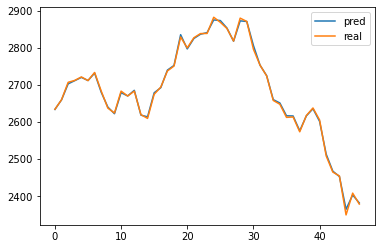

In [17]:
bmodel = TransformerTimeSeries(feature_dim = feature_dim,
                                  nhead = 4,num_layers = 12,d_model = 512,
                                  conv_len = 5,feature_weight = True,embedding_weight = True)
bmodel.load_state_dict(torch.load('GOOG_H'))
bmodel.to(device)
bmodel.eval()
with torch.no_grad(): # eliminate gradient i.e. gradients only exists in train()

    for step,(x,y,feature,attention_masks) in enumerate(test_dl):
        x = x.to(device)
        y = y.to(device)
        feature = feature.to(device)
        attention_masks = attention_masks.to(device)
        output = bmodel(x,y,feature,attention_masks[0])
        
        pred = data[train_size + 1 :-1,1]*0.01*(100+output[:,t0:].squeeze()).detach().cpu()
        real = data[train_size + 1 :-1,1]*0.01*(100+y[:,t0:].squeeze()).detach().cpu()

        plt.plot(pred)
        plt.plot(real)
        plt.legend(['pred','real'])
        MAE = torch.nn.L1Loss()(pred,real).item()
        MSE = torch.nn.MSELoss()(pred,real).item()
        RMSE = np.sqrt(MSE)
        
        print(f'GOOG MAE is {MAE}')
        print(f'GOOG MSE is {MSE}')
        print(f'GOOG RMSE is {RMSE}')

##### Low

In [18]:
file_name = 'GOOG_features.csv'
with open(file_name) as f:
    data_list = csv.reader(f)
    data = []
    for row in data_list:
        data.append(row)
    f.close()
    
data = torch.tensor(np.delete(np.array(data)[1:,2:],4,axis = 1).astype(np.float)).type(torch.float)

feature_dim = data.shape[1] - 1
rate = []
for i in range(1,data.shape[0]):
    rate.append((100*(data[i,0:4] - data[i-1,0:4])/data[i-1,0:4]).reshape(1,4))
    
rate = torch.cat(rate)
rate_data = torch.cat([rate,data[1:,4:]],1)
train_size = int(data.shape[0]*0.9)
data_train = rate_data[0:train_size]
data_test = rate_data[train_size-4:]


t0 = 5
to_predict = 1
train_dataset = GetData(data_train[:,2],torch.cat([data_train[:,0:2],data_train[:,3:]],1),t0 = t0, to_predict = to_predict)
test_dataset = GetData(data_test[:,2],torch.cat([data_test[:,0:2],data_test[:,3:]],1),t0 = t0, to_predict = to_predict)
criterion = torch.nn.MSELoss()
# dataloaders
train_dl = DataLoader(train_dataset,batch_size=256,shuffle=True)
test_dl = DataLoader(test_dataset,batch_size=512)





model = TransformerTimeSeries(feature_dim = feature_dim,
                              nhead = 4,num_layers = 12,d_model = 512,
                              conv_len = 5,feature_weight = True,embedding_weight = True)
model = model.to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=1e-5 ,momentum = 0.9, nesterov = True)#Adam optimizer
#scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer,5e-7,3e-5,10,mode = 'exp_range',gamma = 0.9996)



train_epoch_loss = []
test_epoch_loss = []
test_best = 9999
for epoch in tqdm(range(4000)):


    l_t = train_epoch(model,train_dl,optimizer,t0,to_predict)

    train_loss = test_epoch(model,train_dl,t0,to_predict)


    test_loss = test_epoch(model,test_dl,t0,to_predict)


    if test_best > test_loss:
        test_best = test_loss
        torch.save(model.state_dict(), 'GOOG_L')



    train_epoch_loss.append(np.mean(train_loss))
    test_epoch_loss.append(test_loss)

    print("Epoch {}: Train loss: {} \t test loss: {}".format(epoch+1,
                                                             np.mean(train_loss),
                                                             test_loss))
    #scheduler.step()



torch.Size([431, 6])
torch.Size([431, 6])
torch.Size([47, 6])
torch.Size([47, 6])


  0%|                                                                                     | 0/4000 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1944: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
  0%|                                                                             | 1/4000 [00:00<23:06,  2.88it/s]

Epoch 1: Train loss: 1.3640916397289444 	 test loss: 1.5612646341323853


  0%|                                                                           | 2/4000 [00:04<2:40:01,  2.40s/it]

Epoch 2: Train loss: 1.3100525920739583 	 test loss: 1.519724726676941


  0%|                                                                           | 3/4000 [00:10<4:49:03,  4.34s/it]

Epoch 3: Train loss: 1.257254039328502 	 test loss: 1.4861788749694824


  0%|                                                                           | 4/4000 [00:17<5:49:33,  5.25s/it]

Epoch 4: Train loss: 1.2172928755355268 	 test loss: 1.4649637937545776


  0%|                                                                           | 6/4000 [00:24<4:14:53,  3.83s/it]

Epoch 5: Train loss: 1.1916897659235377 	 test loss: 1.4568719863891602
Epoch 6: Train loss: 1.1751155728807028 	 test loss: 1.466240406036377


  0%|▏                                                                          | 8/4000 [00:24<2:01:50,  1.83s/it]

Epoch 7: Train loss: 1.1711259549289181 	 test loss: 1.4859391450881958
Epoch 8: Train loss: 1.1734124673768151 	 test loss: 1.5025931596755981


  0%|▏                                                                         | 10/4000 [00:24<1:02:39,  1.06it/s]

Epoch 9: Train loss: 1.1769162919847704 	 test loss: 1.5128109455108643
Epoch 10: Train loss: 1.1787973628519859 	 test loss: 1.5181548595428467


  0%|▏                                                                           | 12/4000 [00:25<34:56,  1.90it/s]

Epoch 11: Train loss: 1.1781458760635481 	 test loss: 1.5171459913253784
Epoch 12: Train loss: 1.1754393198650563 	 test loss: 1.510870337486267


  0%|▎                                                                           | 14/4000 [00:25<21:41,  3.06it/s]

Epoch 13: Train loss: 1.1720139731387251 	 test loss: 1.5037246942520142
Epoch 14: Train loss: 1.168693433781511 	 test loss: 1.4950343370437622


  0%|▎                                                                           | 16/4000 [00:25<15:15,  4.35it/s]

Epoch 15: Train loss: 1.1659909597405702 	 test loss: 1.486005187034607
Epoch 16: Train loss: 1.164478774690296 	 test loss: 1.4774035215377808


  0%|▎                                                                           | 18/4000 [00:25<12:04,  5.50it/s]

Epoch 17: Train loss: 1.163673373496726 	 test loss: 1.469431757926941
Epoch 18: Train loss: 1.1633351189354457 	 test loss: 1.4626647233963013


  0%|▎                                                                           | 19/4000 [00:25<11:10,  5.94it/s]

Epoch 19: Train loss: 1.1631562162164746 	 test loss: 1.4582555294036865


  0%|▎                                                                         | 20/4000 [00:30<1:45:14,  1.59s/it]

Epoch 20: Train loss: 1.1629241201551221 	 test loss: 1.4550988674163818


  1%|▍                                                                         | 21/4000 [00:37<3:20:19,  3.02s/it]

Epoch 21: Train loss: 1.1626182067145328 	 test loss: 1.4527567625045776


  1%|▍                                                                         | 22/4000 [00:43<4:31:58,  4.10s/it]

Epoch 22: Train loss: 1.1620331665202803 	 test loss: 1.451420783996582


  1%|▍                                                                         | 23/4000 [00:50<5:22:13,  4.86s/it]

Epoch 23: Train loss: 1.1611470210856463 	 test loss: 1.4510471820831299


  1%|▍                                                                         | 25/4000 [00:50<2:43:22,  2.47s/it]

Epoch 24: Train loss: 1.1601991434938117 	 test loss: 1.451195478439331
Epoch 25: Train loss: 1.159256026529104 	 test loss: 1.4515609741210938


  1%|▍                                                                         | 26/4000 [00:50<1:57:04,  1.77s/it]

Epoch 26: Train loss: 1.1584161594682947 	 test loss: 1.451641321182251


  1%|▍                                                                         | 27/4000 [00:57<3:23:24,  3.07s/it]

Epoch 27: Train loss: 1.157751454831276 	 test loss: 1.4508295059204102


  1%|▌                                                                         | 28/4000 [01:03<4:33:29,  4.13s/it]

Epoch 28: Train loss: 1.1570199813754265 	 test loss: 1.4503995180130005


  1%|▌                                                                         | 29/4000 [01:10<5:22:20,  4.87s/it]

Epoch 29: Train loss: 1.1563395834301022 	 test loss: 1.44964599609375


  1%|▌                                                                         | 30/4000 [01:16<5:57:01,  5.40s/it]

Epoch 30: Train loss: 1.155628450785325 	 test loss: 1.449211597442627


  1%|▌                                                                         | 31/4000 [01:23<6:21:04,  5.76s/it]

Epoch 31: Train loss: 1.1549548770877989 	 test loss: 1.448687195777893


  1%|▌                                                                         | 32/4000 [01:29<6:29:24,  5.89s/it]

Epoch 32: Train loss: 1.1542888697228133 	 test loss: 1.4481309652328491


  1%|▌                                                                         | 33/4000 [01:36<6:51:35,  6.23s/it]

Epoch 33: Train loss: 1.1536682415451085 	 test loss: 1.4469923973083496


  1%|▋                                                                         | 34/4000 [01:43<6:58:49,  6.34s/it]

Epoch 34: Train loss: 1.1530390048524897 	 test loss: 1.4458335638046265


  1%|▋                                                                         | 35/4000 [01:49<7:03:48,  6.41s/it]

Epoch 35: Train loss: 1.1524022131674252 	 test loss: 1.4449459314346313


  1%|▋                                                                         | 36/4000 [01:56<7:07:40,  6.47s/it]

Epoch 36: Train loss: 1.1517927618978194 	 test loss: 1.4438823461532593


  1%|▋                                                                         | 37/4000 [02:02<7:03:43,  6.42s/it]

Epoch 37: Train loss: 1.1511573921500116 	 test loss: 1.4433122873306274


  1%|▋                                                                         | 38/4000 [02:09<7:07:21,  6.47s/it]

Epoch 38: Train loss: 1.1505061653539919 	 test loss: 1.4430503845214844


  1%|▋                                                                         | 39/4000 [02:16<7:16:06,  6.61s/it]

Epoch 39: Train loss: 1.1499112612133513 	 test loss: 1.4420701265335083


  1%|▋                                                                         | 40/4000 [02:22<7:16:07,  6.61s/it]

Epoch 40: Train loss: 1.1493067318214893 	 test loss: 1.4410127401351929


  1%|▊                                                                         | 41/4000 [02:29<7:15:53,  6.61s/it]

Epoch 41: Train loss: 1.1487431730858964 	 test loss: 1.4394375085830688


  1%|▊                                                                         | 42/4000 [02:35<7:08:04,  6.49s/it]

Epoch 42: Train loss: 1.1481904330773587 	 test loss: 1.43759024143219


  1%|▊                                                                         | 43/4000 [02:42<7:17:40,  6.64s/it]

Epoch 43: Train loss: 1.1476942339518783 	 test loss: 1.4355932474136353


  1%|▊                                                                         | 44/4000 [02:48<7:03:48,  6.43s/it]

Epoch 44: Train loss: 1.1471738989557856 	 test loss: 1.4339739084243774


  1%|▊                                                                         | 45/4000 [02:55<7:20:40,  6.69s/it]

Epoch 45: Train loss: 1.1466131489680704 	 test loss: 1.432628870010376


  1%|▊                                                                         | 46/4000 [03:02<7:18:54,  6.66s/it]

Epoch 46: Train loss: 1.1460715742509493 	 test loss: 1.4312351942062378


  1%|▊                                                                         | 47/4000 [03:09<7:17:27,  6.64s/it]

Epoch 47: Train loss: 1.1454651632331088 	 test loss: 1.4301174879074097


  1%|▉                                                                         | 48/4000 [03:15<7:16:36,  6.63s/it]

Epoch 48: Train loss: 1.144877821552781 	 test loss: 1.4290777444839478


  1%|▉                                                                         | 49/4000 [03:22<7:21:20,  6.70s/it]

Epoch 49: Train loss: 1.1442840464430453 	 test loss: 1.4283075332641602


  1%|▉                                                                         | 50/4000 [03:28<7:07:46,  6.50s/it]

Epoch 50: Train loss: 1.1436760193233977 	 test loss: 1.427353858947754


  1%|▉                                                                         | 51/4000 [03:35<7:15:54,  6.62s/it]

Epoch 51: Train loss: 1.1430477620277493 	 test loss: 1.4264447689056396


  1%|▉                                                                         | 52/4000 [03:42<7:15:11,  6.61s/it]

Epoch 52: Train loss: 1.1424286271469222 	 test loss: 1.4256017208099365


  1%|▉                                                                         | 53/4000 [03:48<7:09:45,  6.53s/it]

Epoch 53: Train loss: 1.141768433101769 	 test loss: 1.4251364469528198


  1%|▉                                                                         | 54/4000 [03:55<7:16:33,  6.64s/it]

Epoch 54: Train loss: 1.1410824137884614 	 test loss: 1.4246764183044434


  1%|█                                                                         | 55/4000 [04:01<7:14:56,  6.61s/it]

Epoch 55: Train loss: 1.1404712490581859 	 test loss: 1.423583984375


  1%|█                                                                         | 56/4000 [04:08<7:08:48,  6.52s/it]

Epoch 56: Train loss: 1.1399033871714863 	 test loss: 1.4225406646728516


  1%|█                                                                         | 57/4000 [04:15<7:16:52,  6.65s/it]

Epoch 57: Train loss: 1.1393117193832751 	 test loss: 1.4214438199996948


  1%|█                                                                         | 58/4000 [04:21<7:15:03,  6.62s/it]

Epoch 58: Train loss: 1.1387127029370265 	 test loss: 1.42037034034729


  1%|█                                                                         | 59/4000 [04:28<7:19:20,  6.69s/it]

Epoch 59: Train loss: 1.1380547274016448 	 test loss: 1.4195947647094727


  2%|█                                                                         | 60/4000 [04:34<7:13:14,  6.60s/it]

Epoch 60: Train loss: 1.1373587105501002 	 test loss: 1.4189085960388184


  2%|█▏                                                                        | 61/4000 [04:41<7:13:26,  6.60s/it]

Epoch 61: Train loss: 1.1366682691529844 	 test loss: 1.41842520236969


  2%|█▏                                                                        | 62/4000 [04:48<7:12:42,  6.59s/it]

Epoch 62: Train loss: 1.1359628629795084 	 test loss: 1.41822350025177


  2%|█▏                                                                        | 63/4000 [04:54<7:13:24,  6.61s/it]

Epoch 63: Train loss: 1.13527776359682 	 test loss: 1.417687177658081


  2%|█▏                                                                        | 64/4000 [05:01<7:11:48,  6.58s/it]

Epoch 64: Train loss: 1.1346269890216554 	 test loss: 1.4170148372650146


  2%|█▏                                                                        | 65/4000 [05:08<7:13:22,  6.61s/it]

Epoch 65: Train loss: 1.13400545889153 	 test loss: 1.416191577911377


  2%|█▏                                                                        | 66/4000 [05:14<7:13:23,  6.61s/it]

Epoch 66: Train loss: 1.133363393785782 	 test loss: 1.4157590866088867


  2%|█▏                                                                        | 67/4000 [05:20<7:00:26,  6.41s/it]

Epoch 67: Train loss: 1.132776289417683 	 test loss: 1.415001630783081


  2%|█▎                                                                        | 68/4000 [05:27<7:16:44,  6.66s/it]

Epoch 68: Train loss: 1.1321706722064804 	 test loss: 1.413788080215454


  2%|█▎                                                                        | 69/4000 [05:34<7:15:11,  6.64s/it]

Epoch 69: Train loss: 1.131542331381353 	 test loss: 1.4125864505767822


  2%|█▎                                                                        | 70/4000 [05:40<7:13:45,  6.62s/it]

Epoch 70: Train loss: 1.1308993256009094 	 test loss: 1.4116828441619873


  2%|█▎                                                                        | 71/4000 [05:47<7:14:03,  6.63s/it]

Epoch 71: Train loss: 1.130273229561383 	 test loss: 1.4105781316757202


  2%|█▎                                                                        | 72/4000 [05:54<7:13:27,  6.62s/it]

Epoch 72: Train loss: 1.1296017286119218 	 test loss: 1.4093382358551025


  2%|█▎                                                                        | 73/4000 [06:00<7:13:09,  6.62s/it]

Epoch 73: Train loss: 1.1289375204497867 	 test loss: 1.4082361459732056


  2%|█▎                                                                        | 74/4000 [06:07<7:10:55,  6.59s/it]

Epoch 74: Train loss: 1.1283074407179228 	 test loss: 1.4066702127456665


  2%|█▍                                                                        | 75/4000 [06:14<7:12:51,  6.62s/it]

Epoch 75: Train loss: 1.1276885016611724 	 test loss: 1.4050042629241943


  2%|█▍                                                                        | 76/4000 [06:20<7:12:39,  6.62s/it]

Epoch 76: Train loss: 1.1271246303815023 	 test loss: 1.4033859968185425


  2%|█▍                                                                        | 77/4000 [06:27<7:11:53,  6.61s/it]

Epoch 77: Train loss: 1.1264388265299963 	 test loss: 1.4020916223526


  2%|█▍                                                                        | 78/4000 [06:33<7:12:08,  6.61s/it]

Epoch 78: Train loss: 1.125772247181691 	 test loss: 1.4009970426559448


  2%|█▍                                                                        | 79/4000 [06:40<7:10:26,  6.59s/it]

Epoch 79: Train loss: 1.1251096609297042 	 test loss: 1.3999828100204468


  2%|█▍                                                                        | 80/4000 [06:47<7:12:06,  6.61s/it]

Epoch 80: Train loss: 1.1243930640187452 	 test loss: 1.3988263607025146


  2%|█▍                                                                        | 81/4000 [06:53<7:11:33,  6.61s/it]

Epoch 81: Train loss: 1.1237117934392942 	 test loss: 1.3977340459823608


  2%|█▌                                                                        | 82/4000 [07:00<7:11:22,  6.61s/it]

Epoch 82: Train loss: 1.1229781858329153 	 test loss: 1.3966361284255981


  2%|█▌                                                                        | 83/4000 [07:06<6:57:57,  6.40s/it]

Epoch 83: Train loss: 1.1222742287022884 	 test loss: 1.3957117795944214


  2%|█▌                                                                        | 84/4000 [07:13<7:08:29,  6.57s/it]

Epoch 84: Train loss: 1.1215043137079048 	 test loss: 1.3950542211532593


  2%|█▌                                                                        | 85/4000 [07:20<7:15:52,  6.68s/it]

Epoch 85: Train loss: 1.120697112758309 	 test loss: 1.3947103023529053


  2%|█▌                                                                        | 86/4000 [07:26<7:13:49,  6.65s/it]

Epoch 86: Train loss: 1.1198985261319685 	 test loss: 1.3940300941467285


  2%|█▌                                                                        | 87/4000 [07:33<7:12:47,  6.64s/it]

Epoch 87: Train loss: 1.1191485804914045 	 test loss: 1.3935439586639404


  2%|█▋                                                                        | 88/4000 [07:39<7:12:14,  6.63s/it]

Epoch 88: Train loss: 1.1183781208958814 	 test loss: 1.392999529838562


  2%|█▋                                                                        | 89/4000 [07:46<7:10:22,  6.60s/it]

Epoch 89: Train loss: 1.1175984550794704 	 test loss: 1.3919072151184082


  2%|█▋                                                                        | 90/4000 [07:53<7:15:11,  6.68s/it]

Epoch 90: Train loss: 1.1169221533976685 	 test loss: 1.3899412155151367


  2%|█▋                                                                        | 91/4000 [07:59<7:10:20,  6.61s/it]

Epoch 91: Train loss: 1.1162137877360296 	 test loss: 1.3880195617675781


  2%|█▋                                                                        | 92/4000 [08:06<7:09:22,  6.59s/it]

Epoch 92: Train loss: 1.1155177293963332 	 test loss: 1.3863492012023926


  2%|█▋                                                                        | 93/4000 [08:12<6:56:52,  6.40s/it]

Epoch 93: Train loss: 1.1147653995699782 	 test loss: 1.3845890760421753


  2%|█▋                                                                        | 94/4000 [08:19<7:12:51,  6.65s/it]

Epoch 94: Train loss: 1.1140820169670123 	 test loss: 1.3828403949737549


  2%|█▊                                                                        | 95/4000 [08:26<7:12:40,  6.65s/it]

Epoch 95: Train loss: 1.1134553425826494 	 test loss: 1.3809654712677002


  2%|█▊                                                                        | 96/4000 [08:32<7:11:13,  6.63s/it]

Epoch 96: Train loss: 1.1128074069034195 	 test loss: 1.3790769577026367


  2%|█▊                                                                        | 97/4000 [08:39<7:11:12,  6.63s/it]

Epoch 97: Train loss: 1.1120191964638482 	 test loss: 1.3774986267089844


  2%|█▊                                                                        | 98/4000 [08:45<7:10:01,  6.61s/it]

Epoch 98: Train loss: 1.1112180740816686 	 test loss: 1.37564218044281


  2%|█▊                                                                        | 99/4000 [08:52<7:09:18,  6.60s/it]

Epoch 99: Train loss: 1.1105400912999555 	 test loss: 1.374046802520752


  2%|█▊                                                                       | 100/4000 [08:59<7:14:53,  6.69s/it]

Epoch 100: Train loss: 1.1098380570068713 	 test loss: 1.3721081018447876


  3%|█▊                                                                       | 101/4000 [09:05<7:07:11,  6.57s/it]

Epoch 101: Train loss: 1.1091465012379975 	 test loss: 1.3701317310333252


  3%|█▊                                                                       | 102/4000 [09:12<7:08:51,  6.60s/it]

Epoch 102: Train loss: 1.1083686636661432 	 test loss: 1.3687596321105957


  3%|█▉                                                                       | 103/4000 [09:18<7:07:45,  6.59s/it]

Epoch 103: Train loss: 1.1074455899041655 	 test loss: 1.3678275346755981


  3%|█▉                                                                       | 104/4000 [09:25<7:07:21,  6.58s/it]

Epoch 104: Train loss: 1.1063633045298318 	 test loss: 1.367361307144165


  3%|█▉                                                                       | 105/4000 [09:32<7:08:18,  6.60s/it]

Epoch 105: Train loss: 1.1054442556717556 	 test loss: 1.3665845394134521


  3%|█▉                                                                       | 106/4000 [09:38<7:09:17,  6.61s/it]

Epoch 106: Train loss: 1.1045255991533018 	 test loss: 1.3657134771347046


  3%|█▉                                                                       | 107/4000 [09:45<7:08:44,  6.61s/it]

Epoch 107: Train loss: 1.1035860533504087 	 test loss: 1.364282488822937


  3%|█▉                                                                       | 108/4000 [09:51<6:57:45,  6.44s/it]

Epoch 108: Train loss: 1.1026354840072845 	 test loss: 1.3628519773483276


  3%|█▉                                                                       | 109/4000 [09:58<7:11:34,  6.66s/it]

Epoch 109: Train loss: 1.101689604761429 	 test loss: 1.3617362976074219


  3%|██                                                                       | 110/4000 [10:05<7:10:41,  6.64s/it]

Epoch 110: Train loss: 1.1007807730522068 	 test loss: 1.360608696937561


  3%|██                                                                       | 111/4000 [10:11<7:09:10,  6.62s/it]

Epoch 111: Train loss: 1.0998144058506338 	 test loss: 1.3596144914627075


  3%|██                                                                       | 112/4000 [10:18<7:09:06,  6.62s/it]

Epoch 112: Train loss: 1.098867160538233 	 test loss: 1.3581316471099854


  3%|██                                                                       | 113/4000 [10:24<7:08:37,  6.62s/it]

Epoch 113: Train loss: 1.0979241799312511 	 test loss: 1.356439232826233


  3%|██                                                                       | 114/4000 [10:31<7:08:01,  6.61s/it]

Epoch 114: Train loss: 1.097014931404397 	 test loss: 1.35499906539917


  3%|██                                                                       | 115/4000 [10:38<7:08:02,  6.61s/it]

Epoch 115: Train loss: 1.0959878540370969 	 test loss: 1.3538780212402344


  3%|██                                                                       | 116/4000 [10:44<7:07:46,  6.61s/it]

Epoch 116: Train loss: 1.0949986819048216 	 test loss: 1.352469801902771


  3%|██▏                                                                      | 117/4000 [10:51<7:07:32,  6.61s/it]

Epoch 117: Train loss: 1.0939561186699747 	 test loss: 1.3511263132095337


  3%|██▏                                                                      | 118/4000 [10:57<6:54:38,  6.41s/it]

Epoch 118: Train loss: 1.0929267497737558 	 test loss: 1.3502497673034668


  3%|██▏                                                                      | 119/4000 [11:04<7:11:02,  6.66s/it]

Epoch 119: Train loss: 1.0918910334668968 	 test loss: 1.3490984439849854


  3%|██▏                                                                      | 120/4000 [11:11<7:09:12,  6.64s/it]

Epoch 120: Train loss: 1.090947371624462 	 test loss: 1.3469538688659668


  3%|██▏                                                                      | 121/4000 [11:17<7:08:00,  6.62s/it]

Epoch 121: Train loss: 1.0901228861576444 	 test loss: 1.3448638916015625


  3%|██▏                                                                      | 122/4000 [11:24<7:08:08,  6.62s/it]

Epoch 122: Train loss: 1.0891436523738427 	 test loss: 1.342615008354187


  3%|██▏                                                                      | 123/4000 [11:30<6:55:06,  6.42s/it]

Epoch 123: Train loss: 1.0882890666997074 	 test loss: 1.339762806892395


  3%|██▎                                                                      | 124/4000 [11:37<7:09:45,  6.65s/it]

Epoch 124: Train loss: 1.087411567949087 	 test loss: 1.336901307106018


  3%|██▎                                                                      | 125/4000 [11:43<6:57:39,  6.47s/it]

Epoch 125: Train loss: 1.086466079245034 	 test loss: 1.3338325023651123


  3%|██▎                                                                      | 126/4000 [11:50<7:12:49,  6.70s/it]

Epoch 126: Train loss: 1.0856423032256124 	 test loss: 1.3311777114868164


  3%|██▎                                                                      | 127/4000 [11:56<6:57:56,  6.47s/it]

Epoch 127: Train loss: 1.084478023987082 	 test loss: 1.330260157585144


  3%|██▎                                                                      | 128/4000 [12:03<7:00:26,  6.52s/it]

Epoch 128: Train loss: 1.0831223742867844 	 test loss: 1.3295419216156006


  3%|██▎                                                                      | 129/4000 [12:10<7:08:46,  6.65s/it]

Epoch 129: Train loss: 1.0818739603954235 	 test loss: 1.3288017511367798


  3%|██▎                                                                      | 130/4000 [12:17<7:13:28,  6.72s/it]

Epoch 130: Train loss: 1.080525325511835 	 test loss: 1.3278740644454956


  3%|██▍                                                                      | 131/4000 [12:23<7:11:39,  6.69s/it]

Epoch 131: Train loss: 1.0792313103332873 	 test loss: 1.3272449970245361


  3%|██▍                                                                      | 132/4000 [12:30<7:09:09,  6.66s/it]

Epoch 132: Train loss: 1.0780044885356577 	 test loss: 1.3260349035263062


  3%|██▍                                                                      | 133/4000 [12:36<7:01:45,  6.54s/it]

Epoch 133: Train loss: 1.0769016573987815 	 test loss: 1.3251543045043945


  3%|██▍                                                                      | 134/4000 [12:43<7:08:38,  6.65s/it]

Epoch 134: Train loss: 1.0757995694529983 	 test loss: 1.3244844675064087


  3%|██▍                                                                      | 135/4000 [12:50<7:08:37,  6.65s/it]

Epoch 135: Train loss: 1.0745718490220002 	 test loss: 1.3233779668807983


  3%|██▍                                                                      | 136/4000 [12:56<7:07:31,  6.64s/it]

Epoch 136: Train loss: 1.0732859363412082 	 test loss: 1.3219677209854126


  3%|██▌                                                                      | 137/4000 [13:03<7:06:42,  6.63s/it]

Epoch 137: Train loss: 1.0719427207783037 	 test loss: 1.3195723295211792


  3%|██▌                                                                      | 138/4000 [13:09<6:59:27,  6.52s/it]

Epoch 138: Train loss: 1.0708426793047559 	 test loss: 1.3165698051452637


  3%|██▌                                                                      | 139/4000 [13:16<7:06:41,  6.63s/it]

Epoch 139: Train loss: 1.0695554471624422 	 test loss: 1.3132245540618896


  4%|██▌                                                                      | 140/4000 [13:23<7:07:03,  6.64s/it]

Epoch 140: Train loss: 1.0682489692196768 	 test loss: 1.3106671571731567


  4%|██▌                                                                      | 141/4000 [13:29<7:06:03,  6.62s/it]

Epoch 141: Train loss: 1.0669754630175101 	 test loss: 1.308654546737671


  4%|██▌                                                                      | 142/4000 [13:36<7:05:31,  6.62s/it]

Epoch 142: Train loss: 1.0656280110994236 	 test loss: 1.3065239191055298


  4%|██▌                                                                      | 143/4000 [13:43<7:04:42,  6.61s/it]

Epoch 143: Train loss: 1.0644216583112553 	 test loss: 1.3045909404754639


  4%|██▋                                                                      | 144/4000 [13:49<7:04:55,  6.61s/it]

Epoch 144: Train loss: 1.063033253853393 	 test loss: 1.303192377090454


  4%|██▋                                                                      | 145/4000 [13:56<7:04:40,  6.61s/it]

Epoch 145: Train loss: 1.0615090419410829 	 test loss: 1.3018782138824463


  4%|██▋                                                                      | 146/4000 [14:02<7:04:01,  6.60s/it]

Epoch 146: Train loss: 1.06007630863765 	 test loss: 1.3001998662948608


  4%|██▋                                                                      | 147/4000 [14:09<7:01:55,  6.57s/it]

Epoch 147: Train loss: 1.0586227684729062 	 test loss: 1.2990386486053467


  4%|██▋                                                                      | 148/4000 [14:16<7:04:49,  6.62s/it]

Epoch 148: Train loss: 1.0571368169342006 	 test loss: 1.2974885702133179


  4%|██▋                                                                      | 149/4000 [14:22<6:58:11,  6.52s/it]

Epoch 149: Train loss: 1.055528416157875 	 test loss: 1.2958076000213623


  4%|██▋                                                                      | 150/4000 [14:29<7:05:24,  6.63s/it]

Epoch 150: Train loss: 1.0540333120562915 	 test loss: 1.2946733236312866


  4%|██▊                                                                      | 151/4000 [14:35<7:03:59,  6.61s/it]

Epoch 151: Train loss: 1.0524791697614984 	 test loss: 1.2924097776412964


  4%|██▊                                                                      | 152/4000 [14:42<7:04:57,  6.63s/it]

Epoch 152: Train loss: 1.0509519231291768 	 test loss: 1.290644645690918


  4%|██▊                                                                      | 153/4000 [14:49<7:04:36,  6.62s/it]

Epoch 153: Train loss: 1.049437351127235 	 test loss: 1.2887179851531982


  4%|██▊                                                                      | 154/4000 [14:55<7:04:07,  6.62s/it]

Epoch 154: Train loss: 1.0478082441675138 	 test loss: 1.28695547580719


  4%|██▊                                                                      | 155/4000 [15:02<7:03:43,  6.61s/it]

Epoch 155: Train loss: 1.0462002911866404 	 test loss: 1.2850792407989502


  4%|██▊                                                                      | 156/4000 [15:08<7:02:53,  6.60s/it]

Epoch 156: Train loss: 1.044630339693304 	 test loss: 1.283227562904358


  4%|██▊                                                                      | 157/4000 [15:15<7:02:00,  6.59s/it]

Epoch 157: Train loss: 1.0430492713113948 	 test loss: 1.2809457778930664


  4%|██▉                                                                      | 158/4000 [15:22<7:07:09,  6.67s/it]

Epoch 158: Train loss: 1.0414676114467347 	 test loss: 1.279314398765564


  4%|██▉                                                                      | 159/4000 [15:28<6:49:32,  6.40s/it]

Epoch 159: Train loss: 1.0398771350732259 	 test loss: 1.2774380445480347


  4%|██▉                                                                      | 160/4000 [15:35<7:11:12,  6.74s/it]

Epoch 160: Train loss: 1.0382677330495034 	 test loss: 1.2757067680358887


  4%|██▉                                                                      | 161/4000 [15:41<7:03:21,  6.62s/it]

Epoch 161: Train loss: 1.0365737863317166 	 test loss: 1.2738467454910278


  4%|██▉                                                                      | 162/4000 [15:48<6:56:48,  6.52s/it]

Epoch 162: Train loss: 1.0348514200916423 	 test loss: 1.2723451852798462


  4%|██▉                                                                      | 163/4000 [15:54<6:52:10,  6.45s/it]

Epoch 163: Train loss: 1.033191581889814 	 test loss: 1.2707651853561401


  4%|██▉                                                                      | 164/4000 [16:01<7:07:39,  6.69s/it]

Epoch 164: Train loss: 1.0315049339059887 	 test loss: 1.2684940099716187


  4%|███                                                                      | 165/4000 [16:08<7:09:30,  6.72s/it]

Epoch 165: Train loss: 1.0295752491585892 	 test loss: 1.265500783920288


  4%|███                                                                      | 166/4000 [16:15<7:13:23,  6.78s/it]

Epoch 166: Train loss: 1.0277707242080618 	 test loss: 1.2630000114440918


  4%|███                                                                      | 167/4000 [16:22<7:09:02,  6.72s/it]

Epoch 167: Train loss: 1.0258884150578085 	 test loss: 1.2606569528579712


  4%|███                                                                      | 168/4000 [16:28<7:07:21,  6.69s/it]

Epoch 168: Train loss: 1.0243060100659418 	 test loss: 1.259142518043518


  4%|███                                                                      | 169/4000 [16:35<7:04:58,  6.66s/it]

Epoch 169: Train loss: 1.0223446611461948 	 test loss: 1.257385492324829


  4%|███                                                                      | 170/4000 [16:41<7:01:56,  6.61s/it]

Epoch 170: Train loss: 1.020427782961498 	 test loss: 1.2553837299346924


  4%|███                                                                      | 171/4000 [16:48<7:04:36,  6.65s/it]

Epoch 171: Train loss: 1.0186592405467465 	 test loss: 1.2536022663116455


  4%|███▏                                                                     | 172/4000 [16:55<7:03:21,  6.64s/it]

Epoch 172: Train loss: 1.0168103566025912 	 test loss: 1.251495361328125


  4%|███▏                                                                     | 173/4000 [17:01<7:02:25,  6.62s/it]

Epoch 173: Train loss: 1.014685558332368 	 test loss: 1.2490774393081665


  4%|███▏                                                                     | 174/4000 [17:08<7:02:06,  6.62s/it]

Epoch 174: Train loss: 1.0126789938269525 	 test loss: 1.246489405632019


  4%|███▏                                                                     | 175/4000 [17:14<7:01:41,  6.61s/it]

Epoch 175: Train loss: 1.010599234541165 	 test loss: 1.243974208831787


  4%|███▏                                                                     | 176/4000 [17:21<7:01:23,  6.61s/it]

Epoch 176: Train loss: 1.008568436806274 	 test loss: 1.2417731285095215


  4%|███▏                                                                     | 177/4000 [17:28<7:00:03,  6.59s/it]

Epoch 177: Train loss: 1.0065491855006208 	 test loss: 1.2394442558288574


  4%|███▏                                                                     | 178/4000 [17:34<7:00:46,  6.61s/it]

Epoch 178: Train loss: 1.0045131270680792 	 test loss: 1.2367966175079346


  4%|███▎                                                                     | 179/4000 [17:41<7:00:14,  6.60s/it]

Epoch 179: Train loss: 1.0024420074133198 	 test loss: 1.2342050075531006


  4%|███▎                                                                     | 180/4000 [17:47<7:00:47,  6.61s/it]

Epoch 180: Train loss: 1.0003764128740316 	 test loss: 1.2313259840011597


  5%|███▎                                                                     | 181/4000 [17:54<7:00:23,  6.60s/it]

Epoch 181: Train loss: 0.9982542430165195 	 test loss: 1.2279138565063477


  5%|███▎                                                                     | 182/4000 [18:01<7:00:37,  6.61s/it]

Epoch 182: Train loss: 0.9961146271145814 	 test loss: 1.225041151046753


  5%|███▎                                                                     | 183/4000 [18:07<7:00:22,  6.61s/it]

Epoch 183: Train loss: 0.9939734023021158 	 test loss: 1.222541332244873


  5%|███▎                                                                     | 184/4000 [18:14<7:00:09,  6.61s/it]

Epoch 184: Train loss: 0.9916224584778611 	 test loss: 1.2202112674713135


  5%|███▍                                                                     | 185/4000 [18:20<6:58:11,  6.58s/it]

Epoch 185: Train loss: 0.9894385379317742 	 test loss: 1.2180670499801636


  5%|███▍                                                                     | 186/4000 [18:27<7:00:09,  6.61s/it]

Epoch 186: Train loss: 0.9872116279159511 	 test loss: 1.2154983282089233


  5%|███▍                                                                     | 187/4000 [18:34<6:59:30,  6.60s/it]

Epoch 187: Train loss: 0.9849214091931584 	 test loss: 1.213012456893921


  5%|███▍                                                                     | 188/4000 [18:40<6:47:20,  6.41s/it]

Epoch 188: Train loss: 0.9827809167848662 	 test loss: 1.210851788520813


  5%|███▍                                                                     | 189/4000 [18:47<7:07:10,  6.73s/it]

Epoch 189: Train loss: 0.9801477796793537 	 test loss: 1.2084312438964844


  5%|███▍                                                                     | 190/4000 [18:53<7:01:09,  6.63s/it]

Epoch 190: Train loss: 0.9777207829559486 	 test loss: 1.2066928148269653


  5%|███▍                                                                     | 191/4000 [19:00<7:00:54,  6.63s/it]

Epoch 191: Train loss: 0.9751607873876798 	 test loss: 1.2043957710266113


  5%|███▌                                                                     | 192/4000 [19:07<7:00:03,  6.62s/it]

Epoch 192: Train loss: 0.9726623390777481 	 test loss: 1.2021348476409912


  5%|███▌                                                                     | 193/4000 [19:13<7:02:38,  6.66s/it]

Epoch 193: Train loss: 0.970123990090983 	 test loss: 1.200332522392273


  5%|███▌                                                                     | 194/4000 [19:20<6:58:14,  6.59s/it]

Epoch 194: Train loss: 0.9677524045282616 	 test loss: 1.1987452507019043


  5%|███▌                                                                     | 195/4000 [19:26<6:58:30,  6.60s/it]

Epoch 195: Train loss: 0.9651697893430351 	 test loss: 1.1968209743499756


  5%|███▌                                                                     | 196/4000 [19:33<6:58:27,  6.60s/it]

Epoch 196: Train loss: 0.9628905842033174 	 test loss: 1.194891095161438


  5%|███▌                                                                     | 197/4000 [19:40<6:58:23,  6.60s/it]

Epoch 197: Train loss: 0.9603926688778428 	 test loss: 1.1925030946731567


  5%|███▌                                                                     | 198/4000 [19:46<6:51:58,  6.50s/it]

Epoch 198: Train loss: 0.957643197058525 	 test loss: 1.1895962953567505


  5%|███▋                                                                     | 199/4000 [19:53<6:59:33,  6.62s/it]

Epoch 199: Train loss: 0.9547409752682025 	 test loss: 1.185736894607544


  5%|███▋                                                                     | 200/4000 [19:59<6:59:39,  6.63s/it]

Epoch 200: Train loss: 0.9517804587523512 	 test loss: 1.1820186376571655


  5%|███▋                                                                     | 201/4000 [20:06<6:58:44,  6.61s/it]

Epoch 201: Train loss: 0.9489045513754931 	 test loss: 1.178417682647705


  5%|███▋                                                                     | 202/4000 [20:13<6:58:37,  6.61s/it]

Epoch 202: Train loss: 0.9463929365239951 	 test loss: 1.175994873046875


  5%|███▋                                                                     | 203/4000 [20:19<6:44:51,  6.40s/it]

Epoch 203: Train loss: 0.9438134256205813 	 test loss: 1.1733191013336182


  5%|███▋                                                                     | 204/4000 [20:26<7:02:04,  6.67s/it]

Epoch 204: Train loss: 0.9412403864539693 	 test loss: 1.1705408096313477


  5%|███▋                                                                     | 205/4000 [20:32<7:00:40,  6.65s/it]

Epoch 205: Train loss: 0.9384711409666145 	 test loss: 1.1671909093856812


  5%|███▊                                                                     | 206/4000 [20:39<6:59:28,  6.63s/it]

Epoch 206: Train loss: 0.9352927752824505 	 test loss: 1.1628409624099731


  5%|███▊                                                                     | 207/4000 [20:46<6:59:10,  6.63s/it]

Epoch 207: Train loss: 0.9321318007400583 	 test loss: 1.1583411693572998


  5%|███▊                                                                     | 208/4000 [20:52<6:57:42,  6.61s/it]

Epoch 208: Train loss: 0.9290951032649614 	 test loss: 1.1541404724121094


  5%|███▊                                                                     | 209/4000 [20:59<6:57:06,  6.60s/it]

Epoch 209: Train loss: 0.9261978672441363 	 test loss: 1.1508277654647827


  5%|███▊                                                                     | 210/4000 [21:05<6:56:26,  6.59s/it]

Epoch 210: Train loss: 0.9236513254537383 	 test loss: 1.1482347249984741


  5%|███▊                                                                     | 211/4000 [21:12<7:00:18,  6.66s/it]

Epoch 211: Train loss: 0.9209372251880141 	 test loss: 1.1450165510177612


  5%|███▊                                                                     | 212/4000 [21:19<6:56:49,  6.60s/it]

Epoch 212: Train loss: 0.9181242989000201 	 test loss: 1.1423888206481934


  5%|███▉                                                                     | 213/4000 [21:25<6:57:18,  6.61s/it]

Epoch 213: Train loss: 0.9153509700104698 	 test loss: 1.1403436660766602


  5%|███▉                                                                     | 214/4000 [21:32<6:56:40,  6.60s/it]

Epoch 214: Train loss: 0.9128968506844027 	 test loss: 1.1383624076843262


  5%|███▉                                                                     | 215/4000 [21:38<6:43:34,  6.40s/it]

Epoch 215: Train loss: 0.9097874109263763 	 test loss: 1.1351693868637085


  5%|███▉                                                                     | 216/4000 [21:45<6:57:47,  6.62s/it]

Epoch 216: Train loss: 0.9067446857759958 	 test loss: 1.1319760084152222


  5%|███▉                                                                     | 217/4000 [21:52<7:00:00,  6.66s/it]

Epoch 217: Train loss: 0.9033296312920732 	 test loss: 1.1282646656036377


  5%|███▉                                                                     | 218/4000 [21:58<6:58:46,  6.64s/it]

Epoch 218: Train loss: 0.8997467830950036 	 test loss: 1.1242462396621704


  5%|███▉                                                                     | 219/4000 [22:05<6:57:52,  6.63s/it]

Epoch 219: Train loss: 0.8966252004464098 	 test loss: 1.1207557916641235


  6%|████                                                                     | 220/4000 [22:11<6:51:00,  6.52s/it]

Epoch 220: Train loss: 0.8933785976777221 	 test loss: 1.1171190738677979


  6%|████                                                                     | 221/4000 [22:18<6:57:20,  6.63s/it]

Epoch 221: Train loss: 0.8905577746732053 	 test loss: 1.1144706010818481


  6%|████                                                                     | 222/4000 [22:25<6:58:10,  6.64s/it]

Epoch 222: Train loss: 0.8879248357427646 	 test loss: 1.1119179725646973


  6%|████                                                                     | 223/4000 [22:31<6:56:44,  6.62s/it]

Epoch 223: Train loss: 0.8850600749876549 	 test loss: 1.1089709997177124


  6%|████                                                                     | 224/4000 [22:38<6:56:29,  6.62s/it]

Epoch 224: Train loss: 0.8821333541670974 	 test loss: 1.1060634851455688


  6%|████                                                                     | 225/4000 [22:44<6:55:29,  6.60s/it]

Epoch 225: Train loss: 0.8790764050804545 	 test loss: 1.1030617952346802


  6%|████                                                                     | 226/4000 [22:51<6:55:51,  6.61s/it]

Epoch 226: Train loss: 0.8756182063759894 	 test loss: 1.0991679430007935


  6%|████▏                                                                    | 227/4000 [22:58<6:56:09,  6.62s/it]

Epoch 227: Train loss: 0.8722871785374086 	 test loss: 1.095173954963684


  6%|████▏                                                                    | 228/4000 [23:04<6:55:44,  6.61s/it]

Epoch 228: Train loss: 0.8684451498454242 	 test loss: 1.0907291173934937


  6%|████▏                                                                    | 229/4000 [23:11<6:55:26,  6.61s/it]

Epoch 229: Train loss: 0.8647525440512567 	 test loss: 1.0864402055740356


  6%|████▏                                                                    | 230/4000 [23:18<6:55:11,  6.61s/it]

Epoch 230: Train loss: 0.8611457172236697 	 test loss: 1.0823907852172852


  6%|████▏                                                                    | 231/4000 [23:24<6:47:32,  6.49s/it]

Epoch 231: Train loss: 0.8580902113715346 	 test loss: 1.0791724920272827


  6%|████▏                                                                    | 232/4000 [23:31<6:57:03,  6.64s/it]

Epoch 232: Train loss: 0.8551183507503324 	 test loss: 1.076513648033142


  6%|████▎                                                                    | 233/4000 [23:37<6:56:14,  6.63s/it]

Epoch 233: Train loss: 0.8525103868575218 	 test loss: 1.074275255203247


  6%|████▎                                                                    | 234/4000 [23:44<6:55:36,  6.62s/it]

Epoch 234: Train loss: 0.8500923771592691 	 test loss: 1.0735554695129395


  6%|████▎                                                                    | 235/4000 [23:51<6:54:56,  6.61s/it]

Epoch 235: Train loss: 0.8474422787292374 	 test loss: 1.0721616744995117


  6%|████▎                                                                    | 236/4000 [23:57<6:54:14,  6.60s/it]

Epoch 236: Train loss: 0.843784938970464 	 test loss: 1.068246603012085


  6%|████▎                                                                    | 237/4000 [24:04<6:54:07,  6.60s/it]

Epoch 237: Train loss: 0.840127183915291 	 test loss: 1.0657814741134644


  6%|████▎                                                                    | 238/4000 [24:10<6:53:28,  6.59s/it]

Epoch 238: Train loss: 0.8361232555935941 	 test loss: 1.0626622438430786


  6%|████▎                                                                    | 239/4000 [24:17<6:54:28,  6.61s/it]

Epoch 239: Train loss: 0.8326217483755054 	 test loss: 1.0604526996612549


  6%|████▍                                                                    | 240/4000 [24:23<6:41:06,  6.40s/it]

Epoch 240: Train loss: 0.829068943132104 	 test loss: 1.0579001903533936


  6%|████▍                                                                    | 241/4000 [24:30<6:58:14,  6.68s/it]

Epoch 241: Train loss: 0.826313553581105 	 test loss: 1.0577129125595093


  6%|████▍                                                                    | 242/4000 [24:36<6:44:01,  6.45s/it]

Epoch 242: Train loss: 0.8231228118429604 	 test loss: 1.0567833185195923


  6%|████▍                                                                    | 243/4000 [24:43<6:59:20,  6.70s/it]

Epoch 243: Train loss: 0.8194598041111798 	 test loss: 1.054203748703003


  6%|████▍                                                                    | 244/4000 [24:50<6:57:42,  6.67s/it]

Epoch 244: Train loss: 0.8155298690784835 	 test loss: 1.0520316362380981


  6%|████▍                                                                    | 246/4000 [24:57<4:53:38,  4.69s/it]

Epoch 245: Train loss: 0.8117125601337016 	 test loss: 1.0510938167572021
Epoch 246: Train loss: 0.8093898841233929 	 test loss: 1.0524095296859741


  6%|████▌                                                                    | 247/4000 [25:03<5:27:11,  5.23s/it]

Epoch 247: Train loss: 0.8057245642569115 	 test loss: 1.0506857633590698


  6%|████▌                                                                    | 248/4000 [25:10<5:52:15,  5.63s/it]

Epoch 248: Train loss: 0.8019899489431536 	 test loss: 1.0489219427108765


  6%|████▌                                                                    | 249/4000 [25:16<6:10:32,  5.93s/it]

Epoch 249: Train loss: 0.797910122196525 	 test loss: 1.0462666749954224


  6%|████▌                                                                    | 251/4000 [25:23<4:30:59,  4.34s/it]

Epoch 250: Train loss: 0.7944330614570122 	 test loss: 1.0449107885360718
Epoch 251: Train loss: 0.7914739931542469 	 test loss: 1.0449707508087158


  6%|████▌                                                                    | 252/4000 [25:30<5:10:19,  4.97s/it]

Epoch 252: Train loss: 0.7884534200493531 	 test loss: 1.0443000793457031


  6%|████▌                                                                    | 253/4000 [25:36<5:41:15,  5.46s/it]

Epoch 253: Train loss: 0.7846432137378684 	 test loss: 1.0417860746383667


  6%|████▋                                                                    | 254/4000 [25:43<6:01:32,  5.79s/it]

Epoch 254: Train loss: 0.7805895566110544 	 test loss: 1.0379984378814697


  6%|████▋                                                                    | 255/4000 [25:49<6:17:37,  6.05s/it]

Epoch 255: Train loss: 0.7773384392399799 	 test loss: 1.0368775129318237


  6%|████▋                                                                    | 256/4000 [25:56<6:27:51,  6.22s/it]

Epoch 256: Train loss: 0.7732900158435175 	 test loss: 1.0343459844589233


  6%|████▋                                                                    | 257/4000 [26:02<6:27:57,  6.22s/it]

Epoch 257: Train loss: 0.7693461301431855 	 test loss: 1.0318264961242676


  6%|████▋                                                                    | 258/4000 [26:09<6:41:50,  6.44s/it]

Epoch 258: Train loss: 0.7660736310233096 	 test loss: 1.0305931568145752


  6%|████▋                                                                    | 259/4000 [26:16<6:45:03,  6.50s/it]

Epoch 259: Train loss: 0.7627064627173882 	 test loss: 1.029772162437439


  6%|████▋                                                                    | 260/4000 [26:22<6:45:45,  6.51s/it]

Epoch 260: Train loss: 0.7596968323891234 	 test loss: 1.0289849042892456


  7%|████▊                                                                    | 262/4000 [26:29<4:47:43,  4.62s/it]

Epoch 261: Train loss: 0.756208270580752 	 test loss: 1.0267201662063599
Epoch 262: Train loss: 0.7534411947854434 	 test loss: 1.026909351348877


  7%|████▊                                                                    | 263/4000 [26:35<5:16:57,  5.09s/it]

Epoch 263: Train loss: 0.748608262245727 	 test loss: 1.0221772193908691


  7%|████▊                                                                    | 264/4000 [26:42<5:51:23,  5.64s/it]

Epoch 264: Train loss: 0.7449225307617277 	 test loss: 1.019554615020752


  7%|████▊                                                                    | 265/4000 [26:49<6:09:23,  5.93s/it]

Epoch 265: Train loss: 0.7401812261882348 	 test loss: 1.0140413045883179


  7%|████▊                                                                    | 266/4000 [26:55<6:21:46,  6.13s/it]

Epoch 266: Train loss: 0.7364126152062914 	 test loss: 1.0106102228164673


  7%|████▊                                                                    | 267/4000 [27:02<6:30:21,  6.27s/it]

Epoch 267: Train loss: 0.7329849654726529 	 test loss: 1.009839415550232


  7%|████▉                                                                    | 268/4000 [27:09<6:35:17,  6.36s/it]

Epoch 268: Train loss: 0.7298242734645746 	 test loss: 1.0098079442977905


  7%|████▉                                                                    | 269/4000 [27:15<6:39:17,  6.42s/it]

Epoch 269: Train loss: 0.7265158420095864 	 test loss: 1.0083491802215576


  7%|████▉                                                                    | 270/4000 [27:22<6:44:17,  6.50s/it]

Epoch 270: Train loss: 0.7223068477106205 	 test loss: 1.004374623298645


  7%|████▉                                                                    | 271/4000 [27:28<6:45:02,  6.52s/it]

Epoch 271: Train loss: 0.7184942002362829 	 test loss: 1.0009267330169678


  7%|████▉                                                                    | 272/4000 [27:35<6:47:17,  6.56s/it]

Epoch 272: Train loss: 0.7157354540172143 	 test loss: 1.0005208253860474


  7%|████▉                                                                    | 273/4000 [27:42<6:48:19,  6.57s/it]

Epoch 273: Train loss: 0.7115304369107753 	 test loss: 0.9968059062957764


  7%|█████                                                                    | 274/4000 [27:48<6:49:00,  6.59s/it]

Epoch 274: Train loss: 0.7064080014306265 	 test loss: 0.9899149537086487


  7%|█████                                                                    | 275/4000 [27:55<6:48:00,  6.57s/it]

Epoch 275: Train loss: 0.7017343864363473 	 test loss: 0.9826858043670654


  7%|█████                                                                    | 276/4000 [28:01<6:47:43,  6.57s/it]

Epoch 276: Train loss: 0.6978116700654793 	 test loss: 0.9792391061782837


  7%|█████                                                                    | 277/4000 [28:08<6:49:46,  6.60s/it]

Epoch 277: Train loss: 0.6942197309845838 	 test loss: 0.9790538549423218


  7%|█████                                                                    | 279/4000 [28:15<4:50:24,  4.68s/it]

Epoch 278: Train loss: 0.6911067304367808 	 test loss: 0.9785826206207275
Epoch 279: Train loss: 0.6885438759199705 	 test loss: 0.9790400862693787


  7%|█████                                                                    | 280/4000 [28:21<5:16:15,  5.10s/it]

Epoch 280: Train loss: 0.6841183404358246 	 test loss: 0.9747114777565002


  7%|█████▏                                                                   | 281/4000 [28:28<5:50:19,  5.65s/it]

Epoch 281: Train loss: 0.679520641429795 	 test loss: 0.9681163430213928


  7%|█████▏                                                                   | 282/4000 [28:35<6:11:32,  6.00s/it]

Epoch 282: Train loss: 0.675725653940453 	 test loss: 0.9638067483901978


  7%|█████▏                                                                   | 283/4000 [28:41<6:18:52,  6.12s/it]

Epoch 283: Train loss: 0.6717775649371667 	 test loss: 0.9598459601402283


  7%|█████▏                                                                   | 284/4000 [28:48<6:28:00,  6.26s/it]

Epoch 284: Train loss: 0.6681599665407238 	 test loss: 0.9577886462211609


  7%|█████▏                                                                   | 285/4000 [28:54<6:32:29,  6.34s/it]

Epoch 285: Train loss: 0.6648617964886181 	 test loss: 0.9563979506492615


  7%|█████▏                                                                   | 286/4000 [29:01<6:37:25,  6.42s/it]

Epoch 286: Train loss: 0.6600083541427577 	 test loss: 0.9488294720649719


  7%|█████▏                                                                   | 287/4000 [29:08<6:41:54,  6.49s/it]

Epoch 287: Train loss: 0.6557944075414034 	 test loss: 0.9421517848968506


  7%|█████▎                                                                   | 288/4000 [29:14<6:43:59,  6.53s/it]

Epoch 288: Train loss: 0.6520082907720951 	 test loss: 0.9387529492378235


  7%|█████▎                                                                   | 289/4000 [29:21<6:45:13,  6.55s/it]

Epoch 289: Train loss: 0.648540619907689 	 test loss: 0.938435435295105


  7%|█████▎                                                                   | 290/4000 [29:27<6:45:39,  6.56s/it]

Epoch 290: Train loss: 0.6445299806008483 	 test loss: 0.9338642358779907


  7%|█████▎                                                                   | 291/4000 [29:34<6:51:20,  6.65s/it]

Epoch 291: Train loss: 0.6404671093703976 	 test loss: 0.9295145869255066


  7%|█████▎                                                                   | 293/4000 [29:41<4:45:46,  4.63s/it]

Epoch 292: Train loss: 0.6372835871238443 	 test loss: 0.9285805821418762
Epoch 293: Train loss: 0.6358832667156051 	 test loss: 0.9305911660194397


  7%|█████▎                                                                   | 294/4000 [29:47<5:20:22,  5.19s/it]

Epoch 294: Train loss: 0.6312339706929819 	 test loss: 0.9255687594413757


  7%|█████▍                                                                   | 295/4000 [29:53<5:37:28,  5.47s/it]

Epoch 295: Train loss: 0.6258468362405516 	 test loss: 0.9173862338066101


  7%|█████▍                                                                   | 296/4000 [30:00<6:07:52,  5.96s/it]

Epoch 296: Train loss: 0.6221829943203318 	 test loss: 0.9130133390426636


  7%|█████▍                                                                   | 297/4000 [30:07<6:19:20,  6.15s/it]

Epoch 297: Train loss: 0.617139820294701 	 test loss: 0.9046451449394226


  7%|█████▍                                                                   | 298/4000 [30:14<6:27:39,  6.28s/it]

Epoch 298: Train loss: 0.6128194108086783 	 test loss: 0.8983017802238464


  8%|█████▍                                                                   | 300/4000 [30:20<4:38:18,  4.51s/it]

Epoch 299: Train loss: 0.6092821345805015 	 test loss: 0.8960897922515869
Epoch 300: Train loss: 0.6062236143375495 	 test loss: 0.8960985541343689


  8%|█████▍                                                                   | 301/4000 [30:27<5:14:20,  5.10s/it]

Epoch 301: Train loss: 0.6033799915192022 	 test loss: 0.8947153687477112


  8%|█████▌                                                                   | 302/4000 [30:33<5:41:52,  5.55s/it]

Epoch 302: Train loss: 0.6002975384209936 	 test loss: 0.8920979499816895


  8%|█████▌                                                                   | 303/4000 [30:40<6:00:55,  5.86s/it]

Epoch 303: Train loss: 0.5978182077131249 	 test loss: 0.8901436924934387


  8%|█████▌                                                                   | 304/4000 [30:47<6:15:10,  6.09s/it]

Epoch 304: Train loss: 0.5945837511540566 	 test loss: 0.8866679072380066


  8%|█████▌                                                                   | 305/4000 [30:53<6:23:10,  6.22s/it]

Epoch 305: Train loss: 0.5895239792401166 	 test loss: 0.8796728849411011


  8%|█████▌                                                                   | 306/4000 [31:00<6:31:01,  6.35s/it]

Epoch 306: Train loss: 0.5852733351238366 	 test loss: 0.87448650598526


  8%|█████▌                                                                   | 307/4000 [31:06<6:29:53,  6.33s/it]

Epoch 307: Train loss: 0.5828405047514046 	 test loss: 0.8728421330451965


  8%|█████▌                                                                   | 308/4000 [31:13<6:40:19,  6.51s/it]

Epoch 308: Train loss: 0.5802114037515945 	 test loss: 0.870039701461792


  8%|█████▋                                                                   | 309/4000 [31:20<6:42:35,  6.54s/it]

Epoch 309: Train loss: 0.5738142647212177 	 test loss: 0.8607833385467529


  8%|█████▋                                                                   | 310/4000 [31:26<6:43:32,  6.56s/it]

Epoch 310: Train loss: 0.5692115462019935 	 test loss: 0.8542548418045044


  8%|█████▋                                                                   | 311/4000 [31:33<6:43:13,  6.56s/it]

Epoch 311: Train loss: 0.5656477647148539 	 test loss: 0.849584698677063


  8%|█████▋                                                                   | 312/4000 [31:39<6:44:51,  6.59s/it]

Epoch 312: Train loss: 0.5625412574776917 	 test loss: 0.8461280465126038


  8%|█████▋                                                                   | 313/4000 [31:46<6:44:09,  6.58s/it]

Epoch 313: Train loss: 0.558624080743148 	 test loss: 0.8411087393760681


  8%|█████▋                                                                   | 314/4000 [31:52<6:42:36,  6.55s/it]

Epoch 314: Train loss: 0.5561859113987526 	 test loss: 0.8394334316253662


  8%|█████▋                                                                   | 315/4000 [31:59<6:45:06,  6.60s/it]

Epoch 315: Train loss: 0.5534740198239373 	 test loss: 0.8364372253417969


  8%|█████▊                                                                   | 316/4000 [32:06<6:44:55,  6.59s/it]

Epoch 316: Train loss: 0.5498579358833295 	 test loss: 0.8318795561790466


  8%|█████▊                                                                   | 317/4000 [32:12<6:46:08,  6.62s/it]

Epoch 317: Train loss: 0.545354008328887 	 test loss: 0.8256345391273499


  8%|█████▊                                                                   | 318/4000 [32:19<6:45:12,  6.60s/it]

Epoch 318: Train loss: 0.5406029231310444 	 test loss: 0.8185661435127258


  8%|█████▊                                                                   | 319/4000 [32:25<6:33:14,  6.41s/it]

Epoch 319: Train loss: 0.5355923904620301 	 test loss: 0.8096084594726562


  8%|█████▊                                                                   | 320/4000 [32:32<6:48:58,  6.67s/it]

Epoch 320: Train loss: 0.5323874947643059 	 test loss: 0.8055919408798218


  8%|█████▊                                                                   | 321/4000 [32:39<6:47:51,  6.65s/it]

Epoch 321: Train loss: 0.5302301786338647 	 test loss: 0.8040573000907898


  8%|█████▉                                                                   | 322/4000 [32:45<6:46:27,  6.63s/it]

Epoch 322: Train loss: 0.5278460424903374 	 test loss: 0.8015554547309875


  8%|█████▉                                                                   | 323/4000 [32:52<6:46:27,  6.63s/it]

Epoch 323: Train loss: 0.5243835640064248 	 test loss: 0.7968809604644775


  8%|█████▉                                                                   | 324/4000 [32:59<6:45:36,  6.62s/it]

Epoch 324: Train loss: 0.521186878675651 	 test loss: 0.7923015356063843


  8%|█████▉                                                                   | 325/4000 [33:05<6:44:47,  6.61s/it]

Epoch 325: Train loss: 0.5191033930623614 	 test loss: 0.7896260023117065


  8%|█████▉                                                                   | 326/4000 [33:12<6:45:20,  6.62s/it]

Epoch 326: Train loss: 0.513749745909963 	 test loss: 0.7814998030662537


  8%|█████▉                                                                   | 327/4000 [33:18<6:44:09,  6.60s/it]

Epoch 327: Train loss: 0.5073760974711442 	 test loss: 0.7719139456748962


  8%|█████▉                                                                   | 328/4000 [33:25<6:43:40,  6.60s/it]

Epoch 328: Train loss: 0.5041794295653943 	 test loss: 0.7654765844345093


  8%|██████                                                                   | 329/4000 [33:31<6:38:29,  6.51s/it]

Epoch 329: Train loss: 0.5011317086883598 	 test loss: 0.7627456188201904


  8%|██████                                                                   | 330/4000 [33:38<6:45:59,  6.64s/it]

Epoch 330: Train loss: 0.5000221263228326 	 test loss: 0.7614271640777588


  8%|██████                                                                   | 331/4000 [33:45<6:45:24,  6.63s/it]

Epoch 331: Train loss: 0.4960345158444203 	 test loss: 0.7545357346534729


  8%|██████                                                                   | 332/4000 [33:51<6:44:47,  6.62s/it]

Epoch 332: Train loss: 0.4919209702938726 	 test loss: 0.7481673955917358


  8%|██████                                                                   | 333/4000 [33:58<6:44:13,  6.61s/it]

Epoch 333: Train loss: 0.48977353470508017 	 test loss: 0.7444079518318176


  8%|██████                                                                   | 334/4000 [34:04<6:31:56,  6.41s/it]

Epoch 334: Train loss: 0.4904970100058757 	 test loss: 0.7435222864151001


  8%|██████                                                                   | 335/4000 [34:11<6:47:31,  6.67s/it]

Epoch 335: Train loss: 0.48421490565806696 	 test loss: 0.7331761121749878


  8%|██████▏                                                                  | 336/4000 [34:18<6:55:37,  6.81s/it]

Epoch 336: Train loss: 0.4797940720261665 	 test loss: 0.7249703407287598


  8%|██████▏                                                                  | 338/4000 [34:24<4:42:12,  4.62s/it]

Epoch 337: Train loss: 0.477361271317763 	 test loss: 0.7212027311325073
Epoch 338: Train loss: 0.47969756304802863 	 test loss: 0.722784698009491


  8%|██████▏                                                                  | 339/4000 [34:25<3:19:58,  3.28s/it]

Epoch 339: Train loss: 0.48597186402765613 	 test loss: 0.7272379398345947


  8%|██████▏                                                                  | 340/4000 [34:32<4:32:22,  4.47s/it]

Epoch 340: Train loss: 0.47552983936466914 	 test loss: 0.7156818509101868


  9%|██████▏                                                                  | 341/4000 [34:37<4:53:55,  4.82s/it]

Epoch 341: Train loss: 0.4677560376457161 	 test loss: 0.7051249146461487


  9%|██████▏                                                                  | 342/4000 [34:45<5:39:32,  5.57s/it]

Epoch 342: Train loss: 0.4626579548117733 	 test loss: 0.6971422433853149


  9%|██████▎                                                                  | 343/4000 [34:51<5:58:19,  5.88s/it]

Epoch 343: Train loss: 0.45853197180478034 	 test loss: 0.6907757520675659


  9%|██████▎                                                                  | 344/4000 [34:57<5:59:17,  5.90s/it]

Epoch 344: Train loss: 0.45554339263389393 	 test loss: 0.6861083507537842


  9%|██████▎                                                                  | 345/4000 [35:05<6:24:08,  6.31s/it]

Epoch 345: Train loss: 0.4539345954382779 	 test loss: 0.6839746832847595


  9%|██████▎                                                                  | 347/4000 [35:11<4:35:12,  4.52s/it]

Epoch 346: Train loss: 0.45334664104709493 	 test loss: 0.6829628348350525
Epoch 347: Train loss: 0.4557181796590579 	 test loss: 0.6842795610427856


  9%|██████▎                                                                  | 348/4000 [35:18<5:09:30,  5.08s/it]

Epoch 348: Train loss: 0.4519151957433351 	 test loss: 0.6781065464019775


  9%|██████▎                                                                  | 349/4000 [35:24<5:38:03,  5.56s/it]

Epoch 349: Train loss: 0.4488973272510582 	 test loss: 0.6738953590393066


  9%|██████▍                                                                  | 350/4000 [35:31<5:51:10,  5.77s/it]

Epoch 350: Train loss: 0.4439642670674556 	 test loss: 0.6666395664215088


  9%|██████▍                                                                  | 351/4000 [35:38<6:12:08,  6.12s/it]

Epoch 351: Train loss: 0.43882001061727166 	 test loss: 0.6585849523544312


  9%|██████▍                                                                  | 353/4000 [35:44<4:29:05,  4.43s/it]

Epoch 352: Train loss: 0.43748489492453996 	 test loss: 0.6565062403678894
Epoch 353: Train loss: 0.44012443420505304 	 test loss: 0.6587136387825012


  9%|██████▍                                                                  | 354/4000 [35:45<3:10:48,  3.14s/it]

Epoch 354: Train loss: 0.44191667416809327 	 test loss: 0.6586824655532837


  9%|██████▍                                                                  | 355/4000 [35:51<4:08:51,  4.10s/it]

Epoch 355: Train loss: 0.43317542925235014 	 test loss: 0.6481221914291382


  9%|██████▍                                                                  | 356/4000 [35:57<4:52:55,  4.82s/it]

Epoch 356: Train loss: 0.42720166588604036 	 test loss: 0.6390868425369263


  9%|██████▌                                                                  | 358/4000 [36:04<3:51:11,  3.81s/it]

Epoch 357: Train loss: 0.4251293923074851 	 test loss: 0.6359989047050476
Epoch 358: Train loss: 0.42601263751286644 	 test loss: 0.6364648938179016


  9%|██████▌                                                                  | 359/4000 [36:04<2:44:18,  2.71s/it]

Epoch 359: Train loss: 0.4268894765327259 	 test loss: 0.6361116170883179


  9%|██████▌                                                                  | 360/4000 [36:10<3:38:11,  3.60s/it]

Epoch 360: Train loss: 0.4257297405925538 	 test loss: 0.6337087750434875


  9%|██████▌                                                                  | 361/4000 [36:17<4:42:43,  4.66s/it]

Epoch 361: Train loss: 0.4174432905256886 	 test loss: 0.6244904398918152


  9%|██████▌                                                                  | 362/4000 [36:24<5:20:13,  5.28s/it]

Epoch 362: Train loss: 0.41347346062450013 	 test loss: 0.6184411644935608


  9%|██████▌                                                                  | 363/4000 [36:30<5:43:58,  5.67s/it]

Epoch 363: Train loss: 0.4118684243298462 	 test loss: 0.61618971824646


  9%|██████▋                                                                  | 364/4000 [36:37<6:00:09,  5.94s/it]

Epoch 364: Train loss: 0.4113037049632061 	 test loss: 0.6149584650993347


  9%|██████▋                                                                  | 365/4000 [36:43<6:00:43,  5.95s/it]

Epoch 365: Train loss: 0.408436363230172 	 test loss: 0.6111946702003479


  9%|██████▋                                                                  | 366/4000 [36:50<6:24:22,  6.35s/it]

Epoch 366: Train loss: 0.40555083668702163 	 test loss: 0.606873095035553


  9%|██████▋                                                                  | 367/4000 [36:57<6:29:08,  6.43s/it]

Epoch 367: Train loss: 0.40332169474692464 	 test loss: 0.60292649269104


  9%|██████▋                                                                  | 368/4000 [37:03<6:32:00,  6.48s/it]

Epoch 368: Train loss: 0.40104155128350666 	 test loss: 0.5996190905570984


  9%|██████▋                                                                  | 369/4000 [37:10<6:34:00,  6.51s/it]

Epoch 369: Train loss: 0.4000003951193285 	 test loss: 0.5977817177772522


  9%|██████▊                                                                  | 370/4000 [37:17<6:35:47,  6.54s/it]

Epoch 370: Train loss: 0.3991020285198141 	 test loss: 0.595504879951477


  9%|██████▊                                                                  | 371/4000 [37:23<6:36:57,  6.56s/it]

Epoch 371: Train loss: 0.39491786522544453 	 test loss: 0.5888314843177795


  9%|██████▊                                                                  | 372/4000 [37:30<6:37:02,  6.57s/it]

Epoch 372: Train loss: 0.3932589401086909 	 test loss: 0.5856918096542358


  9%|██████▊                                                                  | 373/4000 [37:36<6:38:08,  6.59s/it]

Epoch 373: Train loss: 0.39294353521617 	 test loss: 0.5847416520118713


  9%|██████▊                                                                  | 374/4000 [37:43<6:38:09,  6.59s/it]

Epoch 374: Train loss: 0.38995285294172105 	 test loss: 0.5796715021133423


  9%|██████▊                                                                  | 375/4000 [37:49<6:29:36,  6.45s/it]

Epoch 375: Train loss: 0.388438853752862 	 test loss: 0.5765764713287354


  9%|██████▊                                                                  | 376/4000 [37:56<6:41:00,  6.64s/it]

Epoch 376: Train loss: 0.3877663698107903 	 test loss: 0.5750091075897217


  9%|██████▉                                                                  | 377/4000 [38:03<6:40:26,  6.63s/it]

Epoch 377: Train loss: 0.3857886185502232 	 test loss: 0.5709424614906311


  9%|██████▉                                                                  | 378/4000 [38:09<6:39:15,  6.61s/it]

Epoch 378: Train loss: 0.38537074981598735 	 test loss: 0.5688421726226807


  9%|██████▉                                                                  | 379/4000 [38:16<6:39:41,  6.62s/it]

Epoch 379: Train loss: 0.38256247780715785 	 test loss: 0.5645962953567505


 10%|██████▉                                                                  | 380/4000 [38:23<6:39:00,  6.61s/it]

Epoch 380: Train loss: 0.38008128047819206 	 test loss: 0.560395359992981


 10%|██████▉                                                                  | 381/4000 [38:29<6:38:54,  6.61s/it]

Epoch 381: Train loss: 0.3785409215154891 	 test loss: 0.5578514337539673


 10%|██████▉                                                                  | 382/4000 [38:36<6:38:26,  6.61s/it]

Epoch 382: Train loss: 0.3773954287344231 	 test loss: 0.5552452802658081


 10%|██████▉                                                                  | 383/4000 [38:43<6:38:04,  6.60s/it]

Epoch 383: Train loss: 0.37736461071293204 	 test loss: 0.5539080500602722


 10%|███████                                                                  | 384/4000 [38:49<6:37:55,  6.60s/it]

Epoch 384: Train loss: 0.3748833759063358 	 test loss: 0.5498534440994263


 10%|███████                                                                  | 385/4000 [38:55<6:25:12,  6.39s/it]

Epoch 385: Train loss: 0.3725743831033773 	 test loss: 0.5458877682685852


 10%|███████                                                                  | 386/4000 [39:02<6:40:33,  6.65s/it]

Epoch 386: Train loss: 0.3710303799597127 	 test loss: 0.5409259796142578


 10%|███████                                                                  | 387/4000 [39:09<6:38:29,  6.62s/it]

Epoch 387: Train loss: 0.3690148305726992 	 test loss: 0.5384025573730469


 10%|███████                                                                  | 388/4000 [39:16<6:40:20,  6.65s/it]

Epoch 388: Train loss: 0.3673269656030872 	 test loss: 0.5362393856048584


 10%|███████                                                                  | 389/4000 [39:22<6:39:22,  6.64s/it]

Epoch 389: Train loss: 0.36640364035376266 	 test loss: 0.5348218679428101


 10%|███████                                                                  | 390/4000 [39:29<6:42:58,  6.70s/it]

Epoch 390: Train loss: 0.3660087667042584 	 test loss: 0.5327767729759216


 10%|███████▏                                                                 | 391/4000 [39:35<6:36:49,  6.60s/it]

Epoch 391: Train loss: 0.36426191685371223 	 test loss: 0.5293610692024231


 10%|███████▏                                                                 | 392/4000 [39:42<6:36:26,  6.59s/it]

Epoch 392: Train loss: 0.36175135441833195 	 test loss: 0.5255872011184692


 10%|███████▏                                                                 | 393/4000 [39:48<6:26:34,  6.43s/it]

Epoch 393: Train loss: 0.3613650605186232 	 test loss: 0.5244820713996887


 10%|███████▏                                                                 | 394/4000 [39:55<6:39:40,  6.65s/it]

Epoch 394: Train loss: 0.3613390622448755 	 test loss: 0.5228971838951111


 10%|███████▏                                                                 | 395/4000 [40:02<6:38:51,  6.64s/it]

Epoch 395: Train loss: 0.3610189340645642 	 test loss: 0.5207116007804871


 10%|███████▏                                                                 | 396/4000 [40:08<6:38:20,  6.63s/it]

Epoch 396: Train loss: 0.3583415234310168 	 test loss: 0.5172489881515503


 10%|███████▏                                                                 | 397/4000 [40:15<6:35:29,  6.59s/it]

Epoch 397: Train loss: 0.35912943086878607 	 test loss: 0.5162104964256287


 10%|███████▎                                                                 | 398/4000 [40:21<6:31:44,  6.53s/it]

Epoch 398: Train loss: 0.35538350284237874 	 test loss: 0.5117886066436768


 10%|███████▎                                                                 | 399/4000 [40:28<6:38:59,  6.65s/it]

Epoch 399: Train loss: 0.35382101050385745 	 test loss: 0.5090980529785156


 10%|███████▎                                                                 | 400/4000 [40:35<6:38:03,  6.63s/it]

Epoch 400: Train loss: 0.35309439268300263 	 test loss: 0.5072004199028015


 10%|███████▎                                                                 | 401/4000 [40:41<6:36:59,  6.62s/it]

Epoch 401: Train loss: 0.35277709136706215 	 test loss: 0.5057727098464966


 10%|███████▎                                                                 | 402/4000 [40:48<6:36:52,  6.62s/it]

Epoch 402: Train loss: 0.35176736379167595 	 test loss: 0.5019654631614685


 10%|███████▎                                                                 | 403/4000 [40:55<6:35:10,  6.59s/it]

Epoch 403: Train loss: 0.349604033123866 	 test loss: 0.4988653063774109


 10%|███████▍                                                                 | 405/4000 [41:01<4:40:01,  4.67s/it]

Epoch 404: Train loss: 0.3478638349995536 	 test loss: 0.49706560373306274
Epoch 405: Train loss: 0.3468031458677659 	 test loss: 0.4971812963485718


 10%|███████▍                                                                 | 406/4000 [41:08<5:12:05,  5.21s/it]

Epoch 406: Train loss: 0.3458300950632294 	 test loss: 0.49350598454475403


 10%|███████▍                                                                 | 408/4000 [41:15<3:58:21,  3.98s/it]

Epoch 407: Train loss: 0.35006620263002314 	 test loss: 0.4933817982673645
Epoch 408: Train loss: 0.3560223852537071 	 test loss: 0.49500152468681335


 10%|███████▍                                                                 | 409/4000 [41:20<4:31:07,  4.53s/it]

Epoch 409: Train loss: 0.34767445838921585 	 test loss: 0.4886033236980438


 10%|███████▍                                                                 | 410/4000 [41:28<5:20:02,  5.35s/it]

Epoch 410: Train loss: 0.34384827250117767 	 test loss: 0.4844435155391693


 10%|███████▌                                                                 | 411/4000 [41:34<5:42:38,  5.73s/it]

Epoch 411: Train loss: 0.34209284774112036 	 test loss: 0.48260805010795593


 10%|███████▌                                                                 | 412/4000 [41:41<5:57:31,  5.98s/it]

Epoch 412: Train loss: 0.34130422324979387 	 test loss: 0.48063454031944275


 10%|███████▌                                                                 | 413/4000 [41:47<6:09:20,  6.18s/it]

Epoch 413: Train loss: 0.3415660264873726 	 test loss: 0.47848907113075256


 10%|███████▌                                                                 | 414/4000 [41:54<6:09:47,  6.19s/it]

Epoch 414: Train loss: 0.3432172387492629 	 test loss: 0.47736218571662903


 10%|███████▌                                                                 | 415/4000 [42:00<6:12:08,  6.23s/it]

Epoch 415: Train loss: 0.3403537426221675 	 test loss: 0.47480353713035583


 10%|███████▌                                                                 | 416/4000 [42:07<6:29:42,  6.52s/it]

Epoch 416: Train loss: 0.3361530563256027 	 test loss: 0.4730440378189087


 10%|███████▋                                                                 | 418/4000 [42:14<4:38:02,  4.66s/it]

Epoch 417: Train loss: 0.33490344432556435 	 test loss: 0.4722978174686432
Epoch 418: Train loss: 0.33424245882476844 	 test loss: 0.4735781252384186


 10%|███████▋                                                                 | 419/4000 [42:14<3:17:02,  3.30s/it]

Epoch 419: Train loss: 0.3343771970603969 	 test loss: 0.4724162817001343


 10%|███████▋                                                                 | 420/4000 [42:20<4:09:27,  4.18s/it]

Epoch 420: Train loss: 0.33209430666644724 	 test loss: 0.4683479368686676


 11%|███████▋                                                                 | 421/4000 [42:27<4:52:35,  4.91s/it]

Epoch 421: Train loss: 0.3312327058298682 	 test loss: 0.4616067111492157


 11%|███████▋                                                                 | 422/4000 [42:34<5:26:14,  5.47s/it]

Epoch 422: Train loss: 0.3299518394221286 	 test loss: 0.4590398073196411


 11%|███████▋                                                                 | 423/4000 [42:40<5:34:12,  5.61s/it]

Epoch 423: Train loss: 0.3302072475376926 	 test loss: 0.4565005898475647


 11%|███████▊                                                                 | 425/4000 [42:47<4:18:22,  4.34s/it]

Epoch 424: Train loss: 0.33068217506541453 	 test loss: 0.4539858102798462
Epoch 425: Train loss: 0.3247281667666203 	 test loss: 0.4566882252693176


 11%|███████▊                                                                 | 427/4000 [42:48<2:10:42,  2.19s/it]

Epoch 426: Train loss: 0.324511762838076 	 test loss: 0.4584542512893677
Epoch 427: Train loss: 0.32311956677801923 	 test loss: 0.4556124210357666


 11%|███████▊                                                                 | 428/4000 [42:53<3:10:05,  3.19s/it]

Epoch 428: Train loss: 0.32170308749526394 	 test loss: 0.4495319426059723


 11%|███████▊                                                                 | 429/4000 [43:00<4:18:00,  4.34s/it]

Epoch 429: Train loss: 0.32285793433333215 	 test loss: 0.4463590383529663


 11%|███████▊                                                                 | 431/4000 [43:07<3:31:32,  3.56s/it]

Epoch 430: Train loss: 0.3205030710542285 	 test loss: 0.4455898702144623
Epoch 431: Train loss: 0.3192512518153666 	 test loss: 0.4463162124156952


 11%|███████▉                                                                 | 432/4000 [43:13<4:17:10,  4.32s/it]

Epoch 432: Train loss: 0.31890879443516035 	 test loss: 0.4435659945011139


 11%|███████▉                                                                 | 433/4000 [43:20<4:57:57,  5.01s/it]

Epoch 433: Train loss: 0.31955110252318414 	 test loss: 0.4414730668067932


 11%|███████▉                                                                 | 434/4000 [43:26<5:24:46,  5.46s/it]

Epoch 434: Train loss: 0.32277788674748414 	 test loss: 0.44014495611190796


 11%|███████▉                                                                 | 435/4000 [43:33<5:52:19,  5.93s/it]

Epoch 435: Train loss: 0.32327545076401215 	 test loss: 0.43893301486968994


 11%|███████▉                                                                 | 436/4000 [43:40<6:04:05,  6.13s/it]

Epoch 436: Train loss: 0.32050329536683597 	 test loss: 0.4373144507408142


 11%|███████▉                                                                 | 437/4000 [43:46<6:11:17,  6.25s/it]

Epoch 437: Train loss: 0.3148755178788975 	 test loss: 0.4361635744571686


 11%|███████▉                                                                 | 438/4000 [43:53<6:16:32,  6.34s/it]

Epoch 438: Train loss: 0.31376953758385784 	 test loss: 0.43467608094215393


 11%|████████                                                                 | 439/4000 [43:59<6:23:05,  6.45s/it]

Epoch 439: Train loss: 0.31304473901846014 	 test loss: 0.4328840374946594


 11%|████████                                                                 | 440/4000 [44:06<6:24:07,  6.47s/it]

Epoch 440: Train loss: 0.3115070427653408 	 test loss: 0.4327220022678375


 11%|████████                                                                 | 441/4000 [44:13<6:27:22,  6.53s/it]

Epoch 441: Train loss: 0.312427091211288 	 test loss: 0.4292461574077606


 11%|████████                                                                 | 442/4000 [44:19<6:28:57,  6.56s/it]

Epoch 442: Train loss: 0.3127027656666917 	 test loss: 0.4279424548149109


 11%|████████                                                                 | 443/4000 [44:26<6:29:14,  6.57s/it]

Epoch 443: Train loss: 0.31478098919939274 	 test loss: 0.4275026023387909


 11%|████████                                                                 | 444/4000 [44:32<6:29:49,  6.58s/it]

Epoch 444: Train loss: 0.31168802597683154 	 test loss: 0.4251323640346527


 11%|████████▏                                                                | 446/4000 [44:39<4:35:58,  4.66s/it]

Epoch 445: Train loss: 0.30760091093742653 	 test loss: 0.42244598269462585
Epoch 446: Train loss: 0.30530204905711306 	 test loss: 0.42433810234069824


 11%|████████▏                                                                | 447/4000 [44:46<5:07:54,  5.20s/it]

Epoch 447: Train loss: 0.30346133122587976 	 test loss: 0.42057836055755615


 11%|████████▏                                                                | 448/4000 [44:52<5:32:20,  5.61s/it]

Epoch 448: Train loss: 0.30427457409502456 	 test loss: 0.41796720027923584


 11%|████████▏                                                                | 449/4000 [44:59<5:50:13,  5.92s/it]

Epoch 449: Train loss: 0.306613643664495 	 test loss: 0.4174667000770569


 11%|████████▏                                                                | 450/4000 [45:05<5:50:21,  5.92s/it]

Epoch 450: Train loss: 0.304411265247106 	 test loss: 0.4153064787387848


 11%|████████▏                                                                | 451/4000 [45:12<6:14:08,  6.33s/it]

Epoch 451: Train loss: 0.30013781336509987 	 test loss: 0.41376814246177673


 11%|████████▏                                                                | 452/4000 [45:19<6:18:34,  6.40s/it]

Epoch 452: Train loss: 0.2994055685753612 	 test loss: 0.4130887985229492


 11%|████████▎                                                                | 453/4000 [45:25<6:22:23,  6.47s/it]

Epoch 453: Train loss: 0.29916843184185693 	 test loss: 0.40990495681762695


 11%|████████▎                                                                | 454/4000 [45:32<6:24:52,  6.51s/it]

Epoch 454: Train loss: 0.3016336702691983 	 test loss: 0.40976831316947937


 11%|████████▎                                                                | 455/4000 [45:39<6:26:24,  6.54s/it]

Epoch 455: Train loss: 0.2980495049616024 	 test loss: 0.40693041682243347


 11%|████████▎                                                                | 456/4000 [45:45<6:27:35,  6.56s/it]

Epoch 456: Train loss: 0.2979973988853862 	 test loss: 0.40583041310310364


 11%|████████▎                                                                | 457/4000 [45:51<6:16:03,  6.37s/it]

Epoch 457: Train loss: 0.29574769355028246 	 test loss: 0.40397438406944275


 11%|████████▎                                                                | 458/4000 [45:58<6:32:14,  6.64s/it]

Epoch 458: Train loss: 0.29563575727203883 	 test loss: 0.4028799831867218


 11%|████████▍                                                                | 459/4000 [46:05<6:31:00,  6.63s/it]

Epoch 459: Train loss: 0.2947039306163788 	 test loss: 0.4016250669956207


 12%|████████▍                                                                | 460/4000 [46:11<6:18:43,  6.42s/it]

Epoch 460: Train loss: 0.2957324951956278 	 test loss: 0.40114641189575195


 12%|████████▍                                                                | 461/4000 [46:18<6:33:54,  6.68s/it]

Epoch 461: Train loss: 0.29286402291045666 	 test loss: 0.40059927105903625


 12%|████████▍                                                                | 462/4000 [46:25<6:31:53,  6.65s/it]

Epoch 462: Train loss: 0.2935144077044352 	 test loss: 0.3970925211906433


 12%|████████▍                                                                | 463/4000 [46:31<6:31:11,  6.64s/it]

Epoch 463: Train loss: 0.29491960124183975 	 test loss: 0.39656803011894226


 12%|████████▍                                                                | 464/4000 [46:38<6:30:51,  6.63s/it]

Epoch 464: Train loss: 0.29032933221062485 	 test loss: 0.39463475346565247


 12%|████████▌                                                                | 466/4000 [46:44<4:27:18,  4.54s/it]

Epoch 465: Train loss: 0.2901301897733781 	 test loss: 0.39333078265190125
Epoch 466: Train loss: 0.2902606352990852 	 test loss: 0.39479514956474304


 12%|████████▌                                                                | 467/4000 [46:44<3:09:28,  3.22s/it]

Epoch 467: Train loss: 0.2906892188325559 	 test loss: 0.39648112654685974


 12%|████████▌                                                                | 468/4000 [46:51<4:15:14,  4.34s/it]

Epoch 468: Train loss: 0.28767119469056274 	 test loss: 0.3913924992084503


 12%|████████▌                                                                | 469/4000 [46:58<4:54:18,  5.00s/it]

Epoch 469: Train loss: 0.28884321250661066 	 test loss: 0.3912496268749237


 12%|████████▌                                                                | 470/4000 [47:04<5:23:12,  5.49s/it]

Epoch 470: Train loss: 0.28767174178099136 	 test loss: 0.38940542936325073


 12%|████████▌                                                                | 471/4000 [47:11<5:42:19,  5.82s/it]

Epoch 471: Train loss: 0.2871624818395849 	 test loss: 0.38829100131988525


 12%|████████▌                                                                | 472/4000 [47:17<5:49:34,  5.95s/it]

Epoch 472: Train loss: 0.2859194533869175 	 test loss: 0.38689112663269043


 12%|████████▋                                                                | 473/4000 [47:24<6:08:48,  6.27s/it]

Epoch 473: Train loss: 0.2860758248586942 	 test loss: 0.386534184217453


 12%|████████▋                                                                | 475/4000 [47:31<4:24:38,  4.50s/it]

Epoch 474: Train loss: 0.28530408798127055 	 test loss: 0.3851664662361145
Epoch 475: Train loss: 0.28557654039765734 	 test loss: 0.38565975427627563


 12%|████████▋                                                                | 476/4000 [47:31<3:07:36,  3.19s/it]

Epoch 476: Train loss: 0.28501065486821664 	 test loss: 0.3854830861091614


 12%|████████▋                                                                | 477/4000 [47:37<3:51:02,  3.93s/it]

Epoch 477: Train loss: 0.2828757153033104 	 test loss: 0.3830607235431671


 12%|████████▋                                                                | 478/4000 [47:44<4:49:39,  4.93s/it]

Epoch 478: Train loss: 0.2819961095077532 	 test loss: 0.3812505304813385


 12%|████████▊                                                                | 480/4000 [47:51<3:43:33,  3.81s/it]

Epoch 479: Train loss: 0.282231128547695 	 test loss: 0.3803498148918152
Epoch 480: Train loss: 0.28505128027391546 	 test loss: 0.3803558349609375


 12%|████████▊                                                                | 481/4000 [47:57<4:31:47,  4.63s/it]

Epoch 481: Train loss: 0.28260606126276355 	 test loss: 0.3790092468261719


 12%|████████▊                                                                | 482/4000 [48:04<5:07:36,  5.25s/it]

Epoch 482: Train loss: 0.2803625067536073 	 test loss: 0.3775206208229065


 12%|████████▊                                                                | 483/4000 [48:10<5:31:01,  5.65s/it]

Epoch 483: Train loss: 0.2773557642081497 	 test loss: 0.37514832615852356


 12%|████████▊                                                                | 484/4000 [48:17<5:51:53,  6.01s/it]

Epoch 484: Train loss: 0.2767666195910381 	 test loss: 0.3737596571445465


 12%|████████▊                                                                | 485/4000 [48:24<5:58:36,  6.12s/it]

Epoch 485: Train loss: 0.2769274617569076 	 test loss: 0.3728279769420624


 12%|████████▊                                                                | 486/4000 [48:30<6:06:27,  6.26s/it]

Epoch 486: Train loss: 0.27641977421645497 	 test loss: 0.3721330761909485


 12%|████████▉                                                                | 487/4000 [48:37<6:12:26,  6.36s/it]

Epoch 487: Train loss: 0.2761023292132154 	 test loss: 0.3705557584762573


 12%|████████▉                                                                | 488/4000 [48:43<6:16:45,  6.44s/it]

Epoch 488: Train loss: 0.27506160058444173 	 test loss: 0.36991405487060547


 12%|████████▉                                                                | 489/4000 [48:50<6:19:44,  6.49s/it]

Epoch 489: Train loss: 0.2745847330015939 	 test loss: 0.36899203062057495


 12%|████████▉                                                                | 490/4000 [48:57<6:21:24,  6.52s/it]

Epoch 490: Train loss: 0.2744569415421054 	 test loss: 0.3683684170246124


 12%|████████▉                                                                | 491/4000 [49:03<6:23:22,  6.56s/it]

Epoch 491: Train loss: 0.27394093071778247 	 test loss: 0.366844117641449


 12%|████████▉                                                                | 492/4000 [49:10<6:22:17,  6.54s/it]

Epoch 492: Train loss: 0.272550455586263 	 test loss: 0.3658546209335327


 12%|████████▉                                                                | 493/4000 [49:16<6:24:46,  6.58s/it]

Epoch 493: Train loss: 0.27231334526688206 	 test loss: 0.36529412865638733


 12%|█████████                                                                | 494/4000 [49:23<6:24:37,  6.58s/it]

Epoch 494: Train loss: 0.2725580049086613 	 test loss: 0.36427760124206543


 12%|█████████                                                                | 495/4000 [49:30<6:24:41,  6.59s/it]

Epoch 495: Train loss: 0.2732867474069175 	 test loss: 0.36331209540367126


 12%|█████████                                                                | 496/4000 [49:36<6:25:46,  6.61s/it]

Epoch 496: Train loss: 0.2725919388286476 	 test loss: 0.3621366620063782


 12%|█████████                                                                | 497/4000 [49:43<6:25:20,  6.60s/it]

Epoch 497: Train loss: 0.2729165979991656 	 test loss: 0.3614521622657776


 12%|█████████                                                                | 498/4000 [49:49<6:24:09,  6.58s/it]

Epoch 498: Train loss: 0.27171021686076013 	 test loss: 0.3601028621196747


 12%|█████████                                                                | 499/4000 [49:56<6:25:29,  6.61s/it]

Epoch 499: Train loss: 0.2705999897693537 	 test loss: 0.3596433103084564


 12%|█████████▏                                                               | 500/4000 [50:03<6:25:18,  6.61s/it]

Epoch 500: Train loss: 0.2704067592554469 	 test loss: 0.3590194880962372


 13%|█████████▏                                                               | 501/4000 [50:09<6:23:42,  6.58s/it]

Epoch 501: Train loss: 0.26987755353932036 	 test loss: 0.3581269383430481


 13%|█████████▏                                                               | 502/4000 [50:16<6:24:32,  6.60s/it]

Epoch 502: Train loss: 0.26948043233833846 	 test loss: 0.35682302713394165


 13%|█████████▏                                                               | 503/4000 [50:22<6:25:05,  6.61s/it]

Epoch 503: Train loss: 0.268890246576057 	 test loss: 0.3550267517566681


 13%|█████████▏                                                               | 504/4000 [50:29<6:23:14,  6.58s/it]

Epoch 504: Train loss: 0.2694203792757888 	 test loss: 0.3532651960849762


 13%|█████████▏                                                               | 505/4000 [50:36<6:24:50,  6.61s/it]

Epoch 505: Train loss: 0.2681093709651389 	 test loss: 0.3524397015571594


 13%|█████████▏                                                               | 506/4000 [50:42<6:24:40,  6.61s/it]

Epoch 506: Train loss: 0.2669166019510504 	 test loss: 0.3511200249195099


 13%|█████████▎                                                               | 507/4000 [50:49<6:19:35,  6.52s/it]

Epoch 507: Train loss: 0.2649707973279975 	 test loss: 0.35052725672721863


 13%|█████████▎                                                               | 508/4000 [50:55<6:26:35,  6.64s/it]

Epoch 508: Train loss: 0.26418975514215 	 test loss: 0.34966057538986206


 13%|█████████▎                                                               | 509/4000 [51:02<6:25:46,  6.63s/it]

Epoch 509: Train loss: 0.261996110119012 	 test loss: 0.3480270802974701


 13%|█████████▎                                                               | 510/4000 [51:09<6:24:15,  6.61s/it]

Epoch 510: Train loss: 0.2620316736244547 	 test loss: 0.3473672568798065


 13%|█████████▎                                                               | 511/4000 [51:15<6:25:11,  6.62s/it]

Epoch 511: Train loss: 0.2635759877218171 	 test loss: 0.3463617265224457


 13%|█████████▎                                                               | 512/4000 [51:22<6:24:32,  6.61s/it]

Epoch 512: Train loss: 0.26326740756112293 	 test loss: 0.34528812766075134


 13%|█████████▍                                                               | 514/4000 [51:29<4:31:31,  4.67s/it]

Epoch 513: Train loss: 0.26442350474836657 	 test loss: 0.34438401460647583
Epoch 514: Train loss: 0.26190695183874557 	 test loss: 0.34455356001853943


 13%|█████████▍                                                               | 515/4000 [51:35<5:02:09,  5.20s/it]

Epoch 515: Train loss: 0.2614960236920005 	 test loss: 0.34416115283966064


 13%|█████████▍                                                               | 516/4000 [51:42<5:26:40,  5.63s/it]

Epoch 516: Train loss: 0.26106407726723746 	 test loss: 0.3440219759941101


 13%|█████████▍                                                               | 517/4000 [51:48<5:43:36,  5.92s/it]

Epoch 517: Train loss: 0.26131213603329495 	 test loss: 0.3431248366832733


 13%|█████████▍                                                               | 518/4000 [51:55<5:55:26,  6.12s/it]

Epoch 518: Train loss: 0.2617077979576837 	 test loss: 0.3424677550792694


 13%|█████████▍                                                               | 519/4000 [52:02<6:04:00,  6.27s/it]

Epoch 519: Train loss: 0.2615510939583701 	 test loss: 0.34153473377227783


 13%|█████████▍                                                               | 520/4000 [52:08<6:09:08,  6.36s/it]

Epoch 520: Train loss: 0.26378523127938647 	 test loss: 0.34074291586875916


 13%|█████████▌                                                               | 521/4000 [52:15<6:12:40,  6.43s/it]

Epoch 521: Train loss: 0.262678512910126 	 test loss: 0.3396598696708679


 13%|█████████▌                                                               | 522/4000 [52:21<6:16:12,  6.49s/it]

Epoch 522: Train loss: 0.2632272229670372 	 test loss: 0.33852314949035645


 13%|█████████▌                                                               | 523/4000 [52:28<6:27:28,  6.69s/it]

Epoch 523: Train loss: 0.26356218164039047 	 test loss: 0.3374584913253784


 13%|█████████▌                                                               | 525/4000 [52:35<4:28:23,  4.63s/it]

Epoch 524: Train loss: 0.26047962350801085 	 test loss: 0.3363684415817261
Epoch 525: Train loss: 0.2615573491270194 	 test loss: 0.33758264780044556


 13%|█████████▌                                                               | 527/4000 [52:35<2:15:30,  2.34s/it]

Epoch 526: Train loss: 0.26069778203964233 	 test loss: 0.3367535173892975
Epoch 527: Train loss: 0.26251857490937835 	 test loss: 0.33649978041648865


 13%|█████████▋                                                               | 528/4000 [52:42<3:27:29,  3.59s/it]

Epoch 528: Train loss: 0.26386223211365895 	 test loss: 0.33634674549102783


 13%|█████████▋                                                               | 529/4000 [52:48<4:20:19,  4.50s/it]

Epoch 529: Train loss: 0.26055608893768417 	 test loss: 0.3351588547229767


 13%|█████████▋                                                               | 530/4000 [52:55<4:56:44,  5.13s/it]

Epoch 530: Train loss: 0.2594373441212692 	 test loss: 0.33455100655555725


 13%|█████████▋                                                               | 531/4000 [53:01<5:22:24,  5.58s/it]

Epoch 531: Train loss: 0.25837798869526857 	 test loss: 0.33421245217323303


 13%|█████████▋                                                               | 532/4000 [53:08<5:43:57,  5.95s/it]

Epoch 532: Train loss: 0.2594136335733595 	 test loss: 0.3335283100605011


 13%|█████████▋                                                               | 533/4000 [53:14<5:39:49,  5.88s/it]

Epoch 533: Train loss: 0.25858549853212043 	 test loss: 0.3324068486690521


 13%|█████████▋                                                               | 534/4000 [53:21<6:03:45,  6.30s/it]

Epoch 534: Train loss: 0.25820361779626727 	 test loss: 0.3319145739078522


 13%|█████████▊                                                               | 535/4000 [53:28<6:08:45,  6.39s/it]

Epoch 535: Train loss: 0.25814005262337264 	 test loss: 0.33154118061065674


 13%|█████████▊                                                               | 536/4000 [53:34<6:12:36,  6.45s/it]

Epoch 536: Train loss: 0.2593016765856134 	 test loss: 0.3313865661621094


 13%|█████████▊                                                               | 538/4000 [53:41<4:16:50,  4.45s/it]

Epoch 537: Train loss: 0.260395872862599 	 test loss: 0.3305985629558563
Epoch 538: Train loss: 0.2630444090217006 	 test loss: 0.3310745656490326


 14%|█████████▊                                                               | 540/4000 [53:47<3:26:29,  3.58s/it]

Epoch 539: Train loss: 0.2586825157746915 	 test loss: 0.32935160398483276
Epoch 540: Train loss: 0.25810411219807067 	 test loss: 0.32945170998573303


 14%|█████████▊                                                               | 541/4000 [53:54<4:27:35,  4.64s/it]

Epoch 541: Train loss: 0.25660636412571863 	 test loss: 0.32811617851257324


 14%|█████████▉                                                               | 542/4000 [54:01<5:01:25,  5.23s/it]

Epoch 542: Train loss: 0.2570908122853724 	 test loss: 0.3277818262577057


 14%|█████████▉                                                               | 544/4000 [54:08<3:49:54,  3.99s/it]

Epoch 543: Train loss: 0.2573821270133946 	 test loss: 0.32706451416015625
Epoch 544: Train loss: 0.25867908570716663 	 test loss: 0.3276757597923279


 14%|█████████▉                                                               | 545/4000 [54:14<4:26:57,  4.64s/it]

Epoch 545: Train loss: 0.2576474348243041 	 test loss: 0.32645612955093384


 14%|█████████▉                                                               | 546/4000 [54:21<5:06:25,  5.32s/it]

Epoch 546: Train loss: 0.2558473620710683 	 test loss: 0.32519829273223877


 14%|██████████                                                               | 548/4000 [54:27<3:51:36,  4.03s/it]

Epoch 547: Train loss: 0.2541506363040057 	 test loss: 0.3242242634296417
Epoch 548: Train loss: 0.25523515515841905 	 test loss: 0.32424139976501465


 14%|██████████                                                               | 549/4000 [54:34<4:34:40,  4.78s/it]

Epoch 549: Train loss: 0.2535235922947837 	 test loss: 0.32297176122665405


 14%|██████████                                                               | 551/4000 [54:41<3:36:43,  3.77s/it]

Epoch 550: Train loss: 0.25348745756663743 	 test loss: 0.32273462414741516
Epoch 551: Train loss: 0.25395602738082823 	 test loss: 0.3231703042984009


 14%|██████████                                                               | 552/4000 [54:46<4:10:30,  4.36s/it]

Epoch 552: Train loss: 0.2538624547612086 	 test loss: 0.3215925693511963


 14%|██████████                                                               | 553/4000 [54:54<5:01:13,  5.24s/it]

Epoch 553: Train loss: 0.25430203822123754 	 test loss: 0.32140541076660156


 14%|██████████                                                               | 554/4000 [55:00<5:19:14,  5.56s/it]

Epoch 554: Train loss: 0.2525022120459174 	 test loss: 0.320159912109375


 14%|██████████▏                                                              | 555/4000 [55:06<5:31:15,  5.77s/it]

Epoch 555: Train loss: 0.25166515553080565 	 test loss: 0.32014045119285583


 14%|██████████▏                                                              | 556/4000 [55:14<5:57:09,  6.22s/it]

Epoch 556: Train loss: 0.25203644862860924 	 test loss: 0.318596214056015


 14%|██████████▏                                                              | 557/4000 [55:20<6:03:36,  6.34s/it]

Epoch 557: Train loss: 0.2528845335933836 	 test loss: 0.3182215094566345


 14%|██████████▏                                                              | 558/4000 [55:27<6:08:04,  6.42s/it]

Epoch 558: Train loss: 0.2513992421311735 	 test loss: 0.31661751866340637


 14%|██████████▏                                                              | 559/4000 [55:33<6:11:19,  6.47s/it]

Epoch 559: Train loss: 0.25043378566367996 	 test loss: 0.3157299757003784


 14%|██████████▏                                                              | 560/4000 [55:40<6:13:16,  6.51s/it]

Epoch 560: Train loss: 0.24962435410360173 	 test loss: 0.31551602482795715


 14%|██████████▎                                                              | 562/4000 [55:47<4:24:16,  4.61s/it]

Epoch 561: Train loss: 0.2486311215950552 	 test loss: 0.3137494921684265
Epoch 562: Train loss: 0.24850173270342799 	 test loss: 0.3142258822917938


 14%|██████████▎                                                              | 563/4000 [55:53<4:55:31,  5.16s/it]

Epoch 563: Train loss: 0.24806570633381536 	 test loss: 0.3124367296695709


 14%|██████████▎                                                              | 564/4000 [56:00<5:21:07,  5.61s/it]

Epoch 564: Train loss: 0.24658364385988762 	 test loss: 0.3117325007915497


 14%|██████████▎                                                              | 565/4000 [56:06<5:37:14,  5.89s/it]

Epoch 565: Train loss: 0.24686393432163584 	 test loss: 0.3116667866706848


 14%|██████████▎                                                              | 567/4000 [56:13<4:03:50,  4.26s/it]

Epoch 566: Train loss: 0.24668944124002745 	 test loss: 0.31095951795578003
Epoch 567: Train loss: 0.24615793365751784 	 test loss: 0.3113735318183899


 14%|██████████▍                                                              | 569/4000 [56:13<2:03:30,  2.16s/it]

Epoch 568: Train loss: 0.2456973419803478 	 test loss: 0.3139418959617615
Epoch 569: Train loss: 0.24620437829511072 	 test loss: 0.3141618072986603


 14%|██████████▍                                                              | 570/4000 [56:20<3:17:25,  3.45s/it]

Epoch 570: Train loss: 0.24459589156916411 	 test loss: 0.3098927140235901


 14%|██████████▍                                                              | 571/4000 [56:26<4:11:45,  4.41s/it]

Epoch 571: Train loss: 0.24636446987116697 	 test loss: 0.3082832992076874


 14%|██████████▍                                                              | 573/4000 [56:33<3:24:44,  3.58s/it]

Epoch 572: Train loss: 0.2459403945785664 	 test loss: 0.3074057996273041
Epoch 573: Train loss: 0.2454514530792037 	 test loss: 0.30772069096565247


 14%|██████████▍                                                              | 574/4000 [56:33<2:25:38,  2.55s/it]

Epoch 574: Train loss: 0.24560441059468793 	 test loss: 0.3079153597354889


 14%|██████████▍                                                              | 575/4000 [56:39<3:29:53,  3.68s/it]

Epoch 575: Train loss: 0.24569097873506301 	 test loss: 0.305976003408432


 14%|██████████▌                                                              | 576/4000 [56:46<4:19:43,  4.55s/it]

Epoch 576: Train loss: 0.24538366019449212 	 test loss: 0.30548450350761414


 14%|██████████▌                                                              | 577/4000 [56:53<4:55:27,  5.18s/it]

Epoch 577: Train loss: 0.24477330396457503 	 test loss: 0.30488479137420654


 14%|██████████▌                                                              | 579/4000 [56:59<3:46:22,  3.97s/it]

Epoch 578: Train loss: 0.24216630218200508 	 test loss: 0.30303165316581726
Epoch 579: Train loss: 0.2437902281359011 	 test loss: 0.3036229610443115


 14%|██████████▌                                                              | 580/4000 [56:59<2:40:50,  2.82s/it]

Epoch 580: Train loss: 0.24542374452554433 	 test loss: 0.30450180172920227


 15%|██████████▌                                                              | 581/4000 [57:05<3:29:15,  3.67s/it]

Epoch 581: Train loss: 0.24252287524897095 	 test loss: 0.3021159768104553


 15%|██████████▋                                                              | 583/4000 [57:13<3:11:55,  3.37s/it]

Epoch 582: Train loss: 0.2422513374734644 	 test loss: 0.301769882440567
Epoch 583: Train loss: 0.24292162143713913 	 test loss: 0.3020680248737335


 15%|██████████▋                                                              | 585/4000 [57:19<2:53:21,  3.05s/it]

Epoch 584: Train loss: 0.24191802062457232 	 test loss: 0.30068105459213257
Epoch 585: Train loss: 0.2415878871615691 	 test loss: 0.30226051807403564


 15%|██████████▋                                                              | 586/4000 [57:19<2:03:39,  2.17s/it]

Epoch 586: Train loss: 0.24122015824174106 	 test loss: 0.30102112889289856


 15%|██████████▋                                                              | 587/4000 [57:26<3:14:48,  3.42s/it]

Epoch 587: Train loss: 0.2404874998842757 	 test loss: 0.30052438378334045


 15%|██████████▋                                                              | 588/4000 [57:32<4:06:03,  4.33s/it]

Epoch 588: Train loss: 0.24128030188675545 	 test loss: 0.29904627799987793


 15%|██████████▊                                                              | 590/4000 [57:39<3:23:25,  3.58s/it]

Epoch 589: Train loss: 0.24134397887021924 	 test loss: 0.29876086115837097
Epoch 590: Train loss: 0.24042231905902897 	 test loss: 0.3046790361404419


 15%|██████████▊                                                              | 592/4000 [57:39<1:43:35,  1.82s/it]

Epoch 591: Train loss: 0.2396910934948866 	 test loss: 0.300937294960022
Epoch 592: Train loss: 0.23904581858912644 	 test loss: 0.2987798750400543


 15%|██████████▊                                                              | 593/4000 [57:45<2:46:55,  2.94s/it]

Epoch 593: Train loss: 0.23984887535638433 	 test loss: 0.29780280590057373


 15%|██████████▊                                                              | 595/4000 [57:52<2:50:47,  3.01s/it]

Epoch 594: Train loss: 0.24208261708787313 	 test loss: 0.29756903648376465
Epoch 595: Train loss: 0.2424868415099009 	 test loss: 0.29814934730529785


 15%|██████████▉                                                              | 597/4000 [57:59<2:42:57,  2.87s/it]

Epoch 596: Train loss: 0.24019798567289544 	 test loss: 0.29587191343307495
Epoch 597: Train loss: 0.23890432162240596 	 test loss: 0.296043336391449


 15%|██████████▉                                                              | 598/4000 [58:05<3:43:53,  3.95s/it]

Epoch 598: Train loss: 0.2379736382764896 	 test loss: 0.2943613827228546


 15%|██████████▉                                                              | 599/4000 [58:12<4:28:57,  4.74s/it]

Epoch 599: Train loss: 0.23806561740534488 	 test loss: 0.29424628615379333


 15%|██████████▉                                                              | 600/4000 [58:18<5:00:38,  5.31s/it]

Epoch 600: Train loss: 0.23683110508730681 	 test loss: 0.29329371452331543


 15%|██████████▉                                                              | 602/4000 [58:25<3:47:58,  4.03s/it]

Epoch 601: Train loss: 0.23596763068036525 	 test loss: 0.29309454560279846
Epoch 602: Train loss: 0.235015210447068 	 test loss: 0.29582536220550537


 15%|███████████                                                              | 604/4000 [58:25<1:55:37,  2.04s/it]

Epoch 603: Train loss: 0.23463320313777836 	 test loss: 0.29565972089767456
Epoch 604: Train loss: 0.23535305437936585 	 test loss: 0.2975963056087494


 15%|███████████                                                              | 606/4000 [58:26<1:00:35,  1.07s/it]

Epoch 605: Train loss: 0.23589434822169922 	 test loss: 0.2984565794467926
Epoch 606: Train loss: 0.23458112288793664 	 test loss: 0.29534390568733215


 15%|███████████▍                                                               | 608/4000 [58:26<33:37,  1.68it/s]

Epoch 607: Train loss: 0.2353269015968261 	 test loss: 0.29640308022499084
Epoch 608: Train loss: 0.23581756260721423 	 test loss: 0.2932867705821991


 15%|███████████                                                              | 609/4000 [58:32<1:59:17,  2.11s/it]

Epoch 609: Train loss: 0.23548925192616102 	 test loss: 0.292865514755249


 15%|███████████▏                                                             | 610/4000 [58:38<3:15:17,  3.46s/it]

Epoch 610: Train loss: 0.23603485967194673 	 test loss: 0.2910418212413788


 15%|███████████▏                                                             | 611/4000 [58:45<4:08:42,  4.40s/it]

Epoch 611: Train loss: 0.23468179285111393 	 test loss: 0.29033362865448


 15%|███████████▏                                                             | 613/4000 [58:52<3:22:26,  3.59s/it]

Epoch 612: Train loss: 0.23541702209105347 	 test loss: 0.29000914096832275
Epoch 613: Train loss: 0.2321474398994114 	 test loss: 0.2901642918586731


 15%|███████████▏                                                             | 615/4000 [58:58<2:58:03,  3.16s/it]

Epoch 614: Train loss: 0.2343818532203577 	 test loss: 0.2894013226032257
Epoch 615: Train loss: 0.23120775486919554 	 test loss: 0.28962674736976624


 15%|███████████▎                                                             | 617/4000 [58:58<1:31:09,  1.62s/it]

Epoch 616: Train loss: 0.23149739133232983 	 test loss: 0.2927992641925812
Epoch 617: Train loss: 0.23196317086087026 	 test loss: 0.2967306077480316


 15%|███████████▌                                                               | 619/4000 [58:59<48:35,  1.16it/s]

Epoch 618: Train loss: 0.23148939946964556 	 test loss: 0.2942758798599243
Epoch 619: Train loss: 0.2301366951169658 	 test loss: 0.29009807109832764


 16%|███████████▎                                                             | 621/4000 [59:05<1:35:48,  1.70s/it]

Epoch 620: Train loss: 0.2322553266920236 	 test loss: 0.28786933422088623
Epoch 621: Train loss: 0.23819644030036616 	 test loss: 0.2913876175880432


 16%|███████████▋                                                               | 623/4000 [59:05<50:50,  1.11it/s]

Epoch 622: Train loss: 0.24068689087012526 	 test loss: 0.29287847876548767
Epoch 623: Train loss: 0.23425317453674263 	 test loss: 0.28834012150764465


 16%|███████████▋                                                               | 625/4000 [59:05<28:50,  1.95it/s]

Epoch 624: Train loss: 0.22905151435366364 	 test loss: 0.28849560022354126
Epoch 625: Train loss: 0.23371118780770048 	 test loss: 0.2988570034503937


 16%|███████████▊                                                               | 627/4000 [59:06<18:04,  3.11it/s]

Epoch 626: Train loss: 0.23241803029297123 	 test loss: 0.2966305613517761
Epoch 627: Train loss: 0.22951388850012955 	 test loss: 0.2895088791847229


 16%|███████████▍                                                             | 628/4000 [59:11<1:47:59,  1.92s/it]

Epoch 628: Train loss: 0.2295614684264234 	 test loss: 0.2848092317581177


 16%|███████████▍                                                             | 630/4000 [59:18<2:13:18,  2.37s/it]

Epoch 629: Train loss: 0.23018625807319607 	 test loss: 0.2842523753643036
Epoch 630: Train loss: 0.22943161967320674 	 test loss: 0.2844291925430298


 16%|███████████▌                                                             | 632/4000 [59:25<2:23:55,  2.56s/it]

Epoch 631: Train loss: 0.22806111607363494 	 test loss: 0.2841525375843048
Epoch 632: Train loss: 0.22679427570367358 	 test loss: 0.28586679697036743


 16%|███████████▌                                                             | 634/4000 [59:25<1:14:28,  1.33s/it]

Epoch 633: Train loss: 0.22572409650289266 	 test loss: 0.28566181659698486
Epoch 634: Train loss: 0.22595358282120212 	 test loss: 0.28730371594429016


 16%|███████████▌                                                             | 636/4000 [59:31<1:51:35,  1.99s/it]

Epoch 635: Train loss: 0.2252644751298732 	 test loss: 0.2836321294307709
Epoch 636: Train loss: 0.22566010704449876 	 test loss: 0.2842576801776886


 16%|███████████▉                                                               | 638/4000 [59:31<58:32,  1.04s/it]

Epoch 637: Train loss: 0.2273197501828665 	 test loss: 0.28737673163414
Epoch 638: Train loss: 0.22679003357472385 	 test loss: 0.28429731726646423


 16%|███████████▋                                                             | 639/4000 [59:38<2:24:59,  2.59s/it]

Epoch 639: Train loss: 0.2268248995951876 	 test loss: 0.2819068431854248


 16%|███████████▋                                                             | 641/4000 [59:44<2:30:54,  2.70s/it]

Epoch 640: Train loss: 0.2299833801810537 	 test loss: 0.28054484724998474
Epoch 641: Train loss: 0.231077323968062 	 test loss: 0.2806531488895416


 16%|███████████▋                                                             | 642/4000 [59:45<1:47:54,  1.93s/it]

Epoch 642: Train loss: 0.23338429308269526 	 test loss: 0.281024694442749


 16%|███████████▊                                                             | 644/4000 [59:50<2:01:17,  2.17s/it]

Epoch 643: Train loss: 0.22896284864147964 	 test loss: 0.2797842025756836
Epoch 644: Train loss: 0.22647129984576853 	 test loss: 0.2848060727119446


 16%|███████████▊                                                             | 646/4000 [59:51<1:03:19,  1.13s/it]

Epoch 645: Train loss: 0.22641865608310477 	 test loss: 0.2864309847354889
Epoch 646: Train loss: 0.22721498298810971 	 test loss: 0.2881212830543518


 16%|████████████▏                                                              | 648/4000 [59:51<34:53,  1.60it/s]

Epoch 647: Train loss: 0.22668226913758607 	 test loss: 0.28311020135879517
Epoch 648: Train loss: 0.23122747563983892 	 test loss: 0.27995389699935913


 16%|████████████▏                                                              | 650/4000 [59:51<20:59,  2.66it/s]

Epoch 649: Train loss: 0.23068784035552128 	 test loss: 0.27995407581329346
Epoch 650: Train loss: 0.22677795547482033 	 test loss: 0.2827039361000061


 16%|████████████▏                                                              | 652/4000 [59:51<14:10,  3.94it/s]

Epoch 651: Train loss: 0.2274941525091428 	 test loss: 0.2890441417694092
Epoch 652: Train loss: 0.22481233085529434 	 test loss: 0.28561919927597046


 16%|████████████▎                                                              | 654/4000 [59:52<10:49,  5.15it/s]

Epoch 653: Train loss: 0.22343259914983452 	 test loss: 0.28415247797966003
Epoch 654: Train loss: 0.2245397650033858 	 test loss: 0.2802390456199646


 16%|███████████▉                                                             | 655/4000 [59:57<1:44:26,  1.87s/it]

Epoch 655: Train loss: 0.22256885787035638 	 test loss: 0.27953097224235535


 16%|███████████▋                                                           | 657/4000 [1:00:04<2:10:56,  2.35s/it]

Epoch 656: Train loss: 0.2237985399994662 	 test loss: 0.27773791551589966
Epoch 657: Train loss: 0.22174142200819577 	 test loss: 0.27985870838165283


 16%|███████████▋                                                           | 659/4000 [1:00:04<1:08:04,  1.22s/it]

Epoch 658: Train loss: 0.22211148111007054 	 test loss: 0.28569766879081726
Epoch 659: Train loss: 0.2227828912004794 	 test loss: 0.28593143820762634


 17%|████████████                                                             | 661/4000 [1:00:05<37:12,  1.50it/s]

Epoch 660: Train loss: 0.22363061494174524 	 test loss: 0.2858852446079254
Epoch 661: Train loss: 0.22358407259955485 	 test loss: 0.28580424189567566


 17%|████████████                                                             | 663/4000 [1:00:05<22:05,  2.52it/s]

Epoch 662: Train loss: 0.2234878334672711 	 test loss: 0.280328631401062
Epoch 663: Train loss: 0.2241792626281349 	 test loss: 0.2778906524181366


 17%|████████████▏                                                            | 665/4000 [1:00:05<14:41,  3.78it/s]

Epoch 664: Train loss: 0.22354238903854395 	 test loss: 0.2786252200603485
Epoch 665: Train loss: 0.22264854896925995 	 test loss: 0.2827177941799164


 17%|████████████▏                                                            | 667/4000 [1:00:06<11:03,  5.02it/s]

Epoch 666: Train loss: 0.2240604550130406 	 test loss: 0.2840641140937805
Epoch 667: Train loss: 0.22405282810779845 	 test loss: 0.2815694510936737


 17%|████████████▏                                                            | 669/4000 [1:00:06<09:16,  5.99it/s]

Epoch 668: Train loss: 0.2234105035973812 	 test loss: 0.2799326479434967
Epoch 669: Train loss: 0.22531106483770358 	 test loss: 0.2788337171077728


 17%|████████████▏                                                            | 671/4000 [1:00:06<08:23,  6.61it/s]

Epoch 670: Train loss: 0.22588295290752242 	 test loss: 0.2794417142868042
Epoch 671: Train loss: 0.22632281167601212 	 test loss: 0.28004252910614014


 17%|████████████▎                                                            | 672/4000 [1:00:06<08:08,  6.82it/s]

Epoch 672: Train loss: 0.22692215975088753 	 test loss: 0.27863433957099915


 17%|████████████▎                                                            | 674/4000 [1:00:10<53:30,  1.04it/s]

Epoch 673: Train loss: 0.2299410926216993 	 test loss: 0.2772216200828552
Epoch 674: Train loss: 0.22844281097714142 	 test loss: 0.2791524827480316


 17%|████████████▎                                                            | 676/4000 [1:00:11<30:05,  1.84it/s]

Epoch 675: Train loss: 0.22742174631481657 	 test loss: 0.2804543673992157
Epoch 676: Train loss: 0.22560818119972875 	 test loss: 0.27852416038513184


 17%|████████████                                                           | 677/4000 [1:00:17<2:09:03,  2.33s/it]

Epoch 677: Train loss: 0.22603998196650546 	 test loss: 0.2759822607040405


 17%|████████████                                                           | 678/4000 [1:00:24<3:20:20,  3.62s/it]

Epoch 678: Train loss: 0.22550229389401988 	 test loss: 0.2751083970069885


 17%|████████████                                                           | 679/4000 [1:00:30<4:09:49,  4.51s/it]

Epoch 679: Train loss: 0.22645293234949046 	 test loss: 0.2748397886753082


 17%|████████████                                                           | 680/4000 [1:00:37<4:39:04,  5.04s/it]

Epoch 680: Train loss: 0.2279758506612269 	 test loss: 0.27462655305862427


 17%|████████████                                                           | 682/4000 [1:00:44<3:39:24,  3.97s/it]

Epoch 681: Train loss: 0.22591425820735658 	 test loss: 0.27430158853530884
Epoch 682: Train loss: 0.2207254110176436 	 test loss: 0.27446791529655457


 17%|████████████                                                           | 683/4000 [1:00:44<2:35:49,  2.82s/it]

Epoch 683: Train loss: 0.2184850860153716 	 test loss: 0.27591797709465027


 17%|████████████▏                                                          | 685/4000 [1:00:50<2:27:51,  2.68s/it]

Epoch 684: Train loss: 0.21894002282287572 	 test loss: 0.27404969930648804
Epoch 685: Train loss: 0.2181944765859303 	 test loss: 0.2757376730442047


 17%|████████████▏                                                          | 686/4000 [1:00:50<1:45:48,  1.92s/it]

Epoch 686: Train loss: 0.21876514085899096 	 test loss: 0.2742416560649872


 17%|████████████▏                                                          | 687/4000 [1:00:57<3:04:48,  3.35s/it]

Epoch 687: Train loss: 0.22052664757466373 	 test loss: 0.27317219972610474


 17%|████████████▏                                                          | 688/4000 [1:01:03<3:57:47,  4.31s/it]

Epoch 688: Train loss: 0.21964987735598934 	 test loss: 0.2722102999687195


 17%|████████████▏                                                          | 690/4000 [1:01:10<3:12:07,  3.48s/it]

Epoch 689: Train loss: 0.2202528345889116 	 test loss: 0.27160805463790894
Epoch 690: Train loss: 0.21870984963363949 	 test loss: 0.27331677079200745


 17%|████████████▎                                                          | 692/4000 [1:01:10<1:37:58,  1.78s/it]

Epoch 691: Train loss: 0.21843145110076098 	 test loss: 0.2744709849357605
Epoch 692: Train loss: 0.21865341890162493 	 test loss: 0.27456486225128174


 17%|████████████▋                                                            | 694/4000 [1:01:10<51:50,  1.06it/s]

Epoch 693: Train loss: 0.21825441431141784 	 test loss: 0.2725493013858795
Epoch 694: Train loss: 0.21823622635511677 	 test loss: 0.272859126329422


 17%|████████████▋                                                            | 695/4000 [1:01:11<38:33,  1.43it/s]

Epoch 695: Train loss: 0.21838630365938155 	 test loss: 0.2716687321662903


 17%|████████████▎                                                          | 697/4000 [1:01:17<1:27:55,  1.60s/it]

Epoch 696: Train loss: 0.21710086971728818 	 test loss: 0.2704536020755768
Epoch 697: Train loss: 0.2158267706840055 	 test loss: 0.27198436856269836


 17%|████████████▊                                                            | 699/4000 [1:01:17<46:55,  1.17it/s]

Epoch 698: Train loss: 0.21596250072847664 	 test loss: 0.2707427442073822
Epoch 699: Train loss: 0.21530414820408877 	 test loss: 0.27362513542175293


 18%|████████████▊                                                            | 701/4000 [1:01:17<26:49,  2.05it/s]

Epoch 700: Train loss: 0.2156077876099301 	 test loss: 0.2729451060295105
Epoch 701: Train loss: 0.2147122332156396 	 test loss: 0.270701140165329


 18%|████████████▊                                                            | 703/4000 [1:01:17<16:57,  3.24it/s]

Epoch 702: Train loss: 0.21495201824159468 	 test loss: 0.2716967463493347
Epoch 703: Train loss: 0.21472175052851922 	 test loss: 0.27150192856788635


 18%|████████████▊                                                            | 705/4000 [1:01:18<12:09,  4.52it/s]

Epoch 704: Train loss: 0.21636756538929905 	 test loss: 0.2748805284500122
Epoch 705: Train loss: 0.2152304596109899 	 test loss: 0.2726837396621704


 18%|████████████▌                                                          | 707/4000 [1:01:23<1:12:22,  1.32s/it]

Epoch 706: Train loss: 0.21739728313172776 	 test loss: 0.26846981048583984
Epoch 707: Train loss: 0.21681264440449097 	 test loss: 0.2709132730960846


 18%|████████████▉                                                            | 709/4000 [1:01:24<39:17,  1.40it/s]

Epoch 708: Train loss: 0.2175244216022801 	 test loss: 0.2735065519809723
Epoch 709: Train loss: 0.21797484377282403 	 test loss: 0.26932525634765625


 18%|████████████▌                                                          | 711/4000 [1:01:30<1:34:14,  1.72s/it]

Epoch 710: Train loss: 0.22096629568706255 	 test loss: 0.2676049470901489
Epoch 711: Train loss: 0.22191611630734048 	 test loss: 0.2676743268966675


 18%|█████████████                                                            | 713/4000 [1:01:30<49:58,  1.10it/s]

Epoch 712: Train loss: 0.22014700823621242 	 test loss: 0.2685430347919464
Epoch 713: Train loss: 0.220226975715354 	 test loss: 0.2678849697113037


 18%|█████████████                                                            | 715/4000 [1:01:31<28:19,  1.93it/s]

Epoch 714: Train loss: 0.2188683361022489 	 test loss: 0.26912257075309753
Epoch 715: Train loss: 0.21963707355916362 	 test loss: 0.271750271320343


 18%|█████████████                                                            | 717/4000 [1:01:31<17:41,  3.09it/s]

Epoch 716: Train loss: 0.2191753874591221 	 test loss: 0.27172183990478516
Epoch 717: Train loss: 0.2177900211440438 	 test loss: 0.2697364389896393


 18%|█████████████                                                            | 719/4000 [1:01:31<12:28,  4.38it/s]

Epoch 718: Train loss: 0.21679169472021736 	 test loss: 0.2705765664577484
Epoch 719: Train loss: 0.2163995156224532 	 test loss: 0.2705659568309784


 18%|█████████████▏                                                           | 720/4000 [1:01:31<10:58,  4.98it/s]

Epoch 720: Train loss: 0.21698359806272105 	 test loss: 0.2705548107624054


 18%|████████████▊                                                          | 721/4000 [1:01:36<1:28:07,  1.61s/it]

Epoch 721: Train loss: 0.2153956411609517 	 test loss: 0.2650436758995056


 18%|████████████▊                                                          | 722/4000 [1:01:43<2:55:11,  3.21s/it]

Epoch 722: Train loss: 0.2151428275069615 	 test loss: 0.26452380418777466


 18%|████████████▊                                                          | 724/4000 [1:01:50<2:43:50,  3.00s/it]

Epoch 723: Train loss: 0.2140026984524561 	 test loss: 0.2644798755645752
Epoch 724: Train loss: 0.21420091732886995 	 test loss: 0.2651674151420593


 18%|████████████▊                                                          | 725/4000 [1:01:50<1:56:54,  2.14s/it]

Epoch 725: Train loss: 0.213532137345272 	 test loss: 0.265241414308548


 18%|████████████▉                                                          | 727/4000 [1:01:56<2:11:57,  2.42s/it]

Epoch 726: Train loss: 0.21326420945385494 	 test loss: 0.26359695196151733
Epoch 727: Train loss: 0.21300272564047174 	 test loss: 0.2636880874633789


 18%|████████████▉                                                          | 729/4000 [1:02:03<2:20:38,  2.58s/it]

Epoch 728: Train loss: 0.21443110694049958 	 test loss: 0.26298514008522034
Epoch 729: Train loss: 0.21355013141361023 	 test loss: 0.26327279210090637


 18%|████████████▉                                                          | 730/4000 [1:02:03<1:40:40,  1.85s/it]

Epoch 730: Train loss: 0.21341397494008535 	 test loss: 0.2637298107147217


 18%|████████████▉                                                          | 731/4000 [1:02:09<2:43:29,  3.00s/it]

Epoch 731: Train loss: 0.2138809025495069 	 test loss: 0.26298224925994873


 18%|█████████████                                                          | 733/4000 [1:02:16<2:45:20,  3.04s/it]

Epoch 732: Train loss: 0.21360082143005804 	 test loss: 0.2625972628593445
Epoch 733: Train loss: 0.2127224510479416 	 test loss: 0.2628863751888275


 18%|█████████████                                                          | 735/4000 [1:02:17<1:24:45,  1.56s/it]

Epoch 734: Train loss: 0.21269326174757044 	 test loss: 0.2634623944759369
Epoch 735: Train loss: 0.21452345718087287 	 test loss: 0.2638845443725586


 18%|█████████████▍                                                           | 737/4000 [1:02:17<45:17,  1.20it/s]

Epoch 736: Train loss: 0.21501545338370684 	 test loss: 0.2650194466114044
Epoch 737: Train loss: 0.21601623106583642 	 test loss: 0.26621517539024353


 18%|█████████████▍                                                           | 739/4000 [1:02:17<25:57,  2.09it/s]

Epoch 738: Train loss: 0.2172382984249885 	 test loss: 0.2646540403366089
Epoch 739: Train loss: 0.2163907895577756 	 test loss: 0.26394936442375183


 18%|█████████████▌                                                           | 740/4000 [1:02:17<20:23,  2.66it/s]

Epoch 740: Train loss: 0.2161769365282457 	 test loss: 0.26321303844451904


 19%|█████████████▏                                                         | 741/4000 [1:02:23<1:44:10,  1.92s/it]

Epoch 741: Train loss: 0.2148733717797804 	 test loss: 0.26259487867355347


 19%|█████████████▏                                                         | 743/4000 [1:02:29<2:08:25,  2.37s/it]

Epoch 742: Train loss: 0.21652762539978646 	 test loss: 0.26213815808296204
Epoch 743: Train loss: 0.21717990412789542 	 test loss: 0.26233431696891785


 19%|█████████████▏                                                         | 745/4000 [1:02:30<1:06:44,  1.23s/it]

Epoch 744: Train loss: 0.2187008506114964 	 test loss: 0.2625160813331604
Epoch 745: Train loss: 0.21792337059836375 	 test loss: 0.2644605040550232


 19%|█████████████▋                                                           | 747/4000 [1:02:30<36:28,  1.49it/s]

Epoch 746: Train loss: 0.21915235399785007 	 test loss: 0.26628950238227844
Epoch 747: Train loss: 0.21975244744194633 	 test loss: 0.26617446541786194


 19%|█████████████▋                                                           | 749/4000 [1:02:30<21:38,  2.50it/s]

Epoch 748: Train loss: 0.21883587228034876 	 test loss: 0.2654300034046173
Epoch 749: Train loss: 0.21785017402017198 	 test loss: 0.2641364634037018


 19%|█████████████▋                                                           | 751/4000 [1:02:31<14:22,  3.77it/s]

Epoch 750: Train loss: 0.2170994625083255 	 test loss: 0.2632216215133667
Epoch 751: Train loss: 0.21700868345883495 	 test loss: 0.263691782951355


 19%|█████████████▎                                                         | 752/4000 [1:02:36<1:38:48,  1.83s/it]

Epoch 752: Train loss: 0.21827515185294186 	 test loss: 0.26133617758750916


 19%|█████████████▎                                                         | 753/4000 [1:02:42<2:43:52,  3.03s/it]

Epoch 753: Train loss: 0.21762912203568593 	 test loss: 0.26090312004089355


 19%|█████████████▍                                                         | 755/4000 [1:02:49<2:37:05,  2.90s/it]

Epoch 754: Train loss: 0.21692521341162324 	 test loss: 0.26072362065315247
Epoch 755: Train loss: 0.2155428282276937 	 test loss: 0.26114046573638916


 19%|█████████████▍                                                         | 756/4000 [1:02:49<1:52:10,  2.07s/it]

Epoch 756: Train loss: 0.21544885179006307 	 test loss: 0.26110419631004333


 19%|█████████████▍                                                         | 758/4000 [1:02:56<2:17:10,  2.54s/it]

Epoch 757: Train loss: 0.21501308925052254 	 test loss: 0.2598617672920227
Epoch 758: Train loss: 0.21501059698809605 	 test loss: 0.2601492702960968


 19%|█████████████▍                                                         | 759/4000 [1:02:56<1:38:14,  1.82s/it]

Epoch 759: Train loss: 0.21524041458929774 	 test loss: 0.2599625885486603


 19%|█████████████▍                                                         | 760/4000 [1:03:02<2:47:55,  3.11s/it]

Epoch 760: Train loss: 0.21443740819557083 	 test loss: 0.2584030330181122


 19%|█████████████▌                                                         | 762/4000 [1:03:09<2:41:04,  2.98s/it]

Epoch 761: Train loss: 0.21387542587145297 	 test loss: 0.25807318091392517
Epoch 762: Train loss: 0.21408260041489124 	 test loss: 0.26048794388771057


 19%|█████████████▌                                                         | 764/4000 [1:03:09<1:22:40,  1.53s/it]

Epoch 763: Train loss: 0.2148095877568849 	 test loss: 0.2618326246738434
Epoch 764: Train loss: 0.2125355036380396 	 test loss: 0.25827813148498535


 19%|█████████████▌                                                         | 765/4000 [1:03:16<2:38:45,  2.94s/it]

Epoch 765: Train loss: 0.21308224107162582 	 test loss: 0.25784188508987427


 19%|█████████████▌                                                         | 767/4000 [1:03:22<2:34:47,  2.87s/it]

Epoch 766: Train loss: 0.21336835781825392 	 test loss: 0.25686100125312805
Epoch 767: Train loss: 0.21340214006447183 	 test loss: 0.2591108977794647


 19%|█████████████▋                                                         | 768/4000 [1:03:22<1:50:34,  2.05s/it]

Epoch 768: Train loss: 0.21314172754431546 	 test loss: 0.257898211479187


 19%|█████████████▋                                                         | 769/4000 [1:03:29<2:59:18,  3.33s/it]

Epoch 769: Train loss: 0.2137733492524884 	 test loss: 0.2563985288143158


 19%|█████████████▋                                                         | 770/4000 [1:03:35<3:52:07,  4.31s/it]

Epoch 770: Train loss: 0.21272284974908054 	 test loss: 0.25547274947166443


 19%|█████████████▋                                                         | 771/4000 [1:03:42<4:28:52,  5.00s/it]

Epoch 771: Train loss: 0.2127998924863864 	 test loss: 0.2552376389503479


 19%|█████████████▋                                                         | 773/4000 [1:03:49<3:28:42,  3.88s/it]

Epoch 772: Train loss: 0.21288726155553228 	 test loss: 0.25449830293655396
Epoch 773: Train loss: 0.21292172486433575 	 test loss: 0.25454869866371155


 19%|█████████████▋                                                         | 774/4000 [1:03:55<4:10:16,  4.65s/it]

Epoch 774: Train loss: 0.21177942269501165 	 test loss: 0.25442376732826233


 19%|█████████████▊                                                         | 776/4000 [1:04:02<3:18:49,  3.70s/it]

Epoch 775: Train loss: 0.21079195455027844 	 test loss: 0.2541174292564392
Epoch 776: Train loss: 0.21225689832129777 	 test loss: 0.25448745489120483


 19%|█████████████▊                                                         | 778/4000 [1:04:02<1:41:11,  1.88s/it]

Epoch 777: Train loss: 0.21523361537268432 	 test loss: 0.2554468512535095
Epoch 778: Train loss: 0.2143494913791006 	 test loss: 0.2559592127799988


 20%|██████████████▏                                                          | 780/4000 [1:04:02<53:19,  1.01it/s]

Epoch 779: Train loss: 0.21361773500862918 	 test loss: 0.25568851828575134
Epoch 780: Train loss: 0.2126656880649779 	 test loss: 0.25516268610954285


 20%|██████████████▎                                                          | 782/4000 [1:04:03<29:51,  1.80it/s]

Epoch 781: Train loss: 0.2131375802503661 	 test loss: 0.2553170621395111
Epoch 782: Train loss: 0.2125150246714218 	 test loss: 0.2555316686630249


 20%|██████████████▎                                                          | 784/4000 [1:04:03<18:21,  2.92it/s]

Epoch 783: Train loss: 0.21223202012392872 	 test loss: 0.2556123733520508
Epoch 784: Train loss: 0.2145768077633497 	 test loss: 0.25671857595443726


 20%|██████████████▎                                                          | 786/4000 [1:04:03<12:44,  4.21it/s]

Epoch 785: Train loss: 0.21557130206488678 	 test loss: 0.25905269384384155
Epoch 786: Train loss: 0.21561968091469078 	 test loss: 0.25959593057632446


 20%|██████████████▍                                                          | 788/4000 [1:04:04<09:58,  5.37it/s]

Epoch 787: Train loss: 0.21511081231027634 	 test loss: 0.25630301237106323
Epoch 788: Train loss: 0.21419662085044136 	 test loss: 0.25506478548049927


 20%|██████████████▍                                                          | 790/4000 [1:04:04<08:37,  6.20it/s]

Epoch 789: Train loss: 0.21357502344036325 	 test loss: 0.25452253222465515
Epoch 790: Train loss: 0.21323233486743096 	 test loss: 0.2549026608467102


 20%|██████████████▍                                                          | 792/4000 [1:04:04<07:58,  6.70it/s]

Epoch 791: Train loss: 0.21527165160654868 	 test loss: 0.25991374254226685
Epoch 792: Train loss: 0.21447060780984342 	 test loss: 0.258785605430603


 20%|██████████████▍                                                          | 793/4000 [1:04:04<07:48,  6.84it/s]

Epoch 793: Train loss: 0.2136152633174113 	 test loss: 0.25466516613960266


 20%|██████████████                                                         | 794/4000 [1:04:08<1:06:02,  1.24s/it]

Epoch 794: Train loss: 0.21332919182744214 	 test loss: 0.25357428193092346


 20%|██████████████▏                                                        | 796/4000 [1:04:15<1:52:48,  2.11s/it]

Epoch 795: Train loss: 0.21352541930714228 	 test loss: 0.2533073127269745
Epoch 796: Train loss: 0.21296111831393982 	 test loss: 0.2540188133716583


 20%|██████████████▌                                                          | 798/4000 [1:04:15<58:58,  1.11s/it]

Epoch 797: Train loss: 0.21403917476638565 	 test loss: 0.25605785846710205
Epoch 798: Train loss: 0.21439905177689483 	 test loss: 0.2562086880207062


 20%|██████████████▌                                                          | 800/4000 [1:04:16<32:36,  1.64it/s]

Epoch 799: Train loss: 0.21372415533336853 	 test loss: 0.2555540204048157
Epoch 800: Train loss: 0.21261237513299885 	 test loss: 0.2546231746673584


 20%|██████████████▋                                                          | 802/4000 [1:04:16<19:41,  2.71it/s]

Epoch 801: Train loss: 0.21284236127981732 	 test loss: 0.2548412084579468
Epoch 802: Train loss: 0.2125634337384297 	 test loss: 0.25491395592689514


 20%|██████████████▋                                                          | 804/4000 [1:04:16<13:20,  3.99it/s]

Epoch 803: Train loss: 0.2129043135316632 	 test loss: 0.257037878036499
Epoch 804: Train loss: 0.21214467159141798 	 test loss: 0.2593216896057129


 20%|██████████████▋                                                          | 806/4000 [1:04:16<10:14,  5.20it/s]

Epoch 805: Train loss: 0.2106613433485518 	 test loss: 0.25626373291015625
Epoch 806: Train loss: 0.2101340343324325 	 test loss: 0.2539132535457611


 20%|██████████████▋                                                          | 808/4000 [1:04:17<08:43,  6.10it/s]

Epoch 807: Train loss: 0.21126873179267563 	 test loss: 0.25376245379447937
Epoch 808: Train loss: 0.21019939691035763 	 test loss: 0.2538459002971649


 20%|██████████████▊                                                          | 810/4000 [1:04:17<07:58,  6.67it/s]

Epoch 809: Train loss: 0.21019556869486922 	 test loss: 0.25528019666671753
Epoch 810: Train loss: 0.2099080628557714 	 test loss: 0.2566225826740265


 20%|██████████████▊                                                          | 812/4000 [1:04:17<07:37,  6.97it/s]

Epoch 811: Train loss: 0.21128388637733017 	 test loss: 0.25641751289367676
Epoch 812: Train loss: 0.21050943700454075 	 test loss: 0.2540040612220764


 20%|██████████████▊                                                          | 814/4000 [1:04:21<46:34,  1.14it/s]

Epoch 813: Train loss: 0.2089018553771995 	 test loss: 0.2511076033115387
Epoch 814: Train loss: 0.20789484164554392 	 test loss: 0.2516385316848755


 20%|██████████████▍                                                        | 816/4000 [1:04:28<1:44:05,  1.96s/it]

Epoch 815: Train loss: 0.20541415617665115 	 test loss: 0.25076961517333984
Epoch 816: Train loss: 0.2049512769810838 	 test loss: 0.25505441427230835


 20%|██████████████▉                                                          | 818/4000 [1:04:29<54:39,  1.03s/it]

Epoch 817: Train loss: 0.2056748980781595 	 test loss: 0.2575151026248932
Epoch 818: Train loss: 0.20519877562251831 	 test loss: 0.2564701735973358


 20%|██████████████▉                                                          | 820/4000 [1:04:29<30:27,  1.74it/s]

Epoch 819: Train loss: 0.20357332850553597 	 test loss: 0.25431227684020996
Epoch 820: Train loss: 0.20454307484792722 	 test loss: 0.25306469202041626


 21%|███████████████                                                          | 822/4000 [1:04:29<18:35,  2.85it/s]

Epoch 821: Train loss: 0.2046796806035628 	 test loss: 0.25343331694602966
Epoch 822: Train loss: 0.20464984433003755 	 test loss: 0.2537018060684204


 21%|███████████████                                                          | 824/4000 [1:04:29<13:42,  3.86it/s]

Epoch 823: Train loss: 0.20365158930040567 	 test loss: 0.2536326050758362
Epoch 824: Train loss: 0.20345052184748816 	 test loss: 0.2550436854362488


 21%|███████████████                                                          | 826/4000 [1:04:30<10:24,  5.08it/s]

Epoch 825: Train loss: 0.20379257796811948 	 test loss: 0.25601646304130554
Epoch 826: Train loss: 0.20312802407138586 	 test loss: 0.25479814410209656


 21%|███████████████                                                          | 828/4000 [1:04:30<08:46,  6.03it/s]

Epoch 827: Train loss: 0.2036626080003526 	 test loss: 0.25451526045799255
Epoch 828: Train loss: 0.20525821414181916 	 test loss: 0.2558601498603821


 21%|███████████████▏                                                         | 830/4000 [1:04:30<07:58,  6.63it/s]

Epoch 829: Train loss: 0.20556714636405493 	 test loss: 0.2541946470737457
Epoch 830: Train loss: 0.20694820036606004 	 test loss: 0.2534606456756592


 21%|███████████████▏                                                         | 832/4000 [1:04:31<07:35,  6.96it/s]

Epoch 831: Train loss: 0.20728334397285 	 test loss: 0.2541588544845581
Epoch 832: Train loss: 0.206492808848412 	 test loss: 0.25386708974838257


 21%|███████████████▏                                                         | 834/4000 [1:04:31<07:23,  7.14it/s]

Epoch 833: Train loss: 0.20623305560956146 	 test loss: 0.25440314412117004
Epoch 834: Train loss: 0.2069091275161491 	 test loss: 0.2570357918739319


 21%|███████████████▎                                                         | 836/4000 [1:04:31<07:16,  7.24it/s]

Epoch 835: Train loss: 0.20469729384524085 	 test loss: 0.2535405158996582
Epoch 836: Train loss: 0.20531231413861162 	 test loss: 0.2514672875404358


 21%|███████████████▎                                                         | 838/4000 [1:04:31<07:16,  7.25it/s]

Epoch 837: Train loss: 0.20619337907246812 	 test loss: 0.25208860635757446
Epoch 838: Train loss: 0.20589378126950938 	 test loss: 0.25315773487091064


 21%|███████████████▎                                                         | 840/4000 [1:04:34<37:06,  1.42it/s]

Epoch 839: Train loss: 0.20681973354860692 	 test loss: 0.2507181167602539
Epoch 840: Train loss: 0.20744029821486595 	 test loss: 0.251133531332016


 21%|███████████████▎                                                         | 841/4000 [1:04:34<28:09,  1.87it/s]

Epoch 841: Train loss: 0.20807910453000922 	 test loss: 0.25207632780075073


 21%|██████████████▉                                                        | 842/4000 [1:04:41<2:08:57,  2.45s/it]

Epoch 842: Train loss: 0.2062487485721327 	 test loss: 0.25001853704452515


 21%|██████████████▉                                                        | 843/4000 [1:04:48<3:13:58,  3.69s/it]

Epoch 843: Train loss: 0.2068152465358411 	 test loss: 0.24852479994297028


 21%|██████████████▉                                                        | 845/4000 [1:04:55<2:50:31,  3.24s/it]

Epoch 844: Train loss: 0.20893443647227541 	 test loss: 0.2454451471567154
Epoch 845: Train loss: 0.209102977490757 	 test loss: 0.24591565132141113


 21%|███████████████                                                        | 847/4000 [1:04:55<1:27:10,  1.66s/it]

Epoch 846: Train loss: 0.20913304378151062 	 test loss: 0.2511567771434784
Epoch 847: Train loss: 0.2097840072660601 	 test loss: 0.25304949283599854


 21%|███████████████▍                                                         | 849/4000 [1:04:55<46:23,  1.13it/s]

Epoch 848: Train loss: 0.20856272150911478 	 test loss: 0.2502569258213043
Epoch 849: Train loss: 0.20900153570966212 	 test loss: 0.24915915727615356


 21%|███████████████▌                                                         | 851/4000 [1:04:56<26:24,  1.99it/s]

Epoch 850: Train loss: 0.20679023989806872 	 test loss: 0.24636556208133698
Epoch 851: Train loss: 0.20786474714284706 	 test loss: 0.24596816301345825


 21%|███████████████▌                                                         | 853/4000 [1:04:56<16:36,  3.16it/s]

Epoch 852: Train loss: 0.20757787638363318 	 test loss: 0.2458498179912567
Epoch 853: Train loss: 0.20751636964539089 	 test loss: 0.24633686244487762


 21%|███████████████▌                                                         | 855/4000 [1:04:56<11:47,  4.44it/s]

Epoch 854: Train loss: 0.2054706019135473 	 test loss: 0.24674439430236816
Epoch 855: Train loss: 0.2056304939315933 	 test loss: 0.24758553504943848


 21%|███████████████▋                                                         | 857/4000 [1:04:56<09:26,  5.55it/s]

Epoch 856: Train loss: 0.20559475665994145 	 test loss: 0.24967987835407257
Epoch 857: Train loss: 0.2062328168798212 	 test loss: 0.24951624870300293


 21%|███████████████▋                                                         | 859/4000 [1:04:57<08:17,  6.31it/s]

Epoch 858: Train loss: 0.20661071793385835 	 test loss: 0.2494954764842987
Epoch 859: Train loss: 0.20618504071456928 	 test loss: 0.2514728009700775


 22%|███████████████▋                                                         | 861/4000 [1:04:57<07:42,  6.78it/s]

Epoch 860: Train loss: 0.20637103348209798 	 test loss: 0.2523055970668793
Epoch 861: Train loss: 0.20785821317381759 	 test loss: 0.2576937675476074


 22%|███████████████▋                                                         | 863/4000 [1:04:57<07:25,  7.04it/s]

Epoch 862: Train loss: 0.20468773469847482 	 test loss: 0.25258955359458923
Epoch 863: Train loss: 0.20355567087153548 	 test loss: 0.24919837713241577


 22%|███████████████▊                                                         | 865/4000 [1:04:58<07:18,  7.15it/s]

Epoch 864: Train loss: 0.20233340094648214 	 test loss: 0.2484888881444931
Epoch 865: Train loss: 0.20268470819892573 	 test loss: 0.2488955706357956


 22%|███████████████▊                                                         | 867/4000 [1:04:58<07:13,  7.23it/s]

Epoch 866: Train loss: 0.20140532488889318 	 test loss: 0.2485388070344925
Epoch 867: Train loss: 0.20119209680922348 	 test loss: 0.2489410936832428


 22%|███████████████▊                                                         | 869/4000 [1:04:58<07:11,  7.26it/s]

Epoch 868: Train loss: 0.20203738740867916 	 test loss: 0.249982088804245
Epoch 869: Train loss: 0.20221284564299263 	 test loss: 0.2489565908908844


 22%|███████████████▉                                                         | 871/4000 [1:04:58<07:09,  7.29it/s]

Epoch 870: Train loss: 0.2019196595918828 	 test loss: 0.24888837337493896
Epoch 871: Train loss: 0.20275895785013098 	 test loss: 0.24918003380298615


 22%|███████████████▉                                                         | 873/4000 [1:04:59<07:09,  7.29it/s]

Epoch 872: Train loss: 0.20343435370728477 	 test loss: 0.2492251694202423
Epoch 873: Train loss: 0.20335710394410136 	 test loss: 0.25012126564979553


 22%|███████████████▉                                                         | 875/4000 [1:04:59<07:09,  7.27it/s]

Epoch 874: Train loss: 0.20335616420288927 	 test loss: 0.24878868460655212
Epoch 875: Train loss: 0.2060277698142346 	 test loss: 0.250366747379303


 22%|████████████████                                                         | 877/4000 [1:04:59<07:09,  7.27it/s]

Epoch 876: Train loss: 0.2055155280847837 	 test loss: 0.24996355175971985
Epoch 877: Train loss: 0.20400342307206926 	 test loss: 0.24850527942180634


 22%|████████████████                                                         | 879/4000 [1:04:59<07:08,  7.28it/s]

Epoch 878: Train loss: 0.20493327101947537 	 test loss: 0.2506398558616638
Epoch 879: Train loss: 0.20535358081284366 	 test loss: 0.25054970383644104


 22%|████████████████                                                         | 881/4000 [1:05:00<07:08,  7.27it/s]

Epoch 880: Train loss: 0.2045155126091499 	 test loss: 0.24875497817993164
Epoch 881: Train loss: 0.20406822957046625 	 test loss: 0.2483355700969696


 22%|████████████████                                                         | 883/4000 [1:05:00<07:08,  7.27it/s]

Epoch 882: Train loss: 0.20426215124240885 	 test loss: 0.24770745635032654
Epoch 883: Train loss: 0.2046824331695685 	 test loss: 0.2484561800956726


 22%|████████████████▏                                                        | 885/4000 [1:05:00<07:08,  7.27it/s]

Epoch 884: Train loss: 0.20625469932146803 	 test loss: 0.24956998229026794
Epoch 885: Train loss: 0.2060291515079839 	 test loss: 0.24901758134365082


 22%|████████████████▏                                                        | 887/4000 [1:05:01<07:08,  7.27it/s]

Epoch 886: Train loss: 0.20624723480776677 	 test loss: 0.24778501689434052
Epoch 887: Train loss: 0.20580319700689162 	 test loss: 0.24739767611026764


 22%|████████████████▏                                                        | 889/4000 [1:05:01<07:07,  7.27it/s]

Epoch 888: Train loss: 0.2050983500591287 	 test loss: 0.24745331704616547
Epoch 889: Train loss: 0.2065039529462978 	 test loss: 0.24848568439483643


 22%|████████████████▎                                                        | 891/4000 [1:05:01<07:07,  7.27it/s]

Epoch 890: Train loss: 0.20722375412551544 	 test loss: 0.25033876299858093
Epoch 891: Train loss: 0.20739013765638223 	 test loss: 0.2510162591934204


 22%|████████████████▎                                                        | 893/4000 [1:05:01<07:06,  7.28it/s]

Epoch 892: Train loss: 0.20661840340654147 	 test loss: 0.24928244948387146
Epoch 893: Train loss: 0.2064077551292986 	 test loss: 0.2488509565591812


 22%|████████████████▎                                                        | 895/4000 [1:05:02<07:06,  7.28it/s]

Epoch 894: Train loss: 0.2049188541287336 	 test loss: 0.24901920557022095
Epoch 895: Train loss: 0.20508663988998485 	 test loss: 0.2510732114315033


 22%|████████████████▎                                                        | 897/4000 [1:05:02<07:06,  7.27it/s]

Epoch 896: Train loss: 0.2013792678748372 	 test loss: 0.2466123402118683
Epoch 897: Train loss: 0.20150572642372822 	 test loss: 0.2459678202867508


 22%|████████████████▍                                                        | 899/4000 [1:05:02<07:05,  7.28it/s]

Epoch 898: Train loss: 0.20107390442884715 	 test loss: 0.24605853855609894
Epoch 899: Train loss: 0.20050177365334018 	 test loss: 0.2457151561975479


 22%|████████████████▍                                                        | 900/4000 [1:05:02<07:06,  7.28it/s]

Epoch 900: Train loss: 0.19931588586411178 	 test loss: 0.24548529088497162


 23%|████████████████▍                                                        | 901/4000 [1:05:03<18:46,  2.75it/s]

Epoch 901: Train loss: 0.19960462659804837 	 test loss: 0.24526110291481018


 23%|████████████████                                                       | 902/4000 [1:05:08<1:23:42,  1.62s/it]

Epoch 902: Train loss: 0.19878728117301125 	 test loss: 0.2448325753211975


 23%|████████████████                                                       | 903/4000 [1:05:14<2:41:42,  3.13s/it]

Epoch 903: Train loss: 0.1991278879742058 	 test loss: 0.2447567731142044


 23%|████████████████                                                       | 905/4000 [1:05:21<2:32:54,  2.96s/it]

Epoch 904: Train loss: 0.1983766814741347 	 test loss: 0.24432773888111115
Epoch 905: Train loss: 0.19997470471532605 	 test loss: 0.24543225765228271


 23%|████████████████                                                       | 907/4000 [1:05:21<1:18:28,  1.52s/it]

Epoch 906: Train loss: 0.20010108803236845 	 test loss: 0.24502189457416534
Epoch 907: Train loss: 0.20005910641356023 	 test loss: 0.24446900188922882


 23%|████████████████▌                                                        | 909/4000 [1:05:22<42:00,  1.23it/s]

Epoch 908: Train loss: 0.2005142233833636 	 test loss: 0.24579282104969025
Epoch 909: Train loss: 0.20062297478905963 	 test loss: 0.24462954699993134


 23%|████████████████▋                                                        | 911/4000 [1:05:22<24:09,  2.13it/s]

Epoch 910: Train loss: 0.20082223474149638 	 test loss: 0.24465081095695496
Epoch 911: Train loss: 0.20113322214847928 	 test loss: 0.2447788119316101


 23%|████████████████▋                                                        | 913/4000 [1:05:22<15:25,  3.33it/s]

Epoch 912: Train loss: 0.20089045243030912 	 test loss: 0.2447044849395752
Epoch 913: Train loss: 0.20094024789305684 	 test loss: 0.246175155043602


 23%|████████████████▋                                                        | 915/4000 [1:05:23<11:09,  4.61it/s]

Epoch 914: Train loss: 0.20198492916720096 	 test loss: 0.24562343955039978
Epoch 915: Train loss: 0.20181962778562737 	 test loss: 0.24546317756175995


 23%|████████████████▋                                                        | 917/4000 [1:05:23<09:02,  5.69it/s]

Epoch 916: Train loss: 0.20156276319392044 	 test loss: 0.2449311763048172
Epoch 917: Train loss: 0.20151656603315313 	 test loss: 0.24529732763767242


 23%|████████████████▊                                                        | 919/4000 [1:05:23<08:01,  6.40it/s]

Epoch 918: Train loss: 0.20041738419411076 	 test loss: 0.24444757401943207
Epoch 919: Train loss: 0.20073293422601615 	 test loss: 0.2449224442243576


 23%|████████████████▊                                                        | 921/4000 [1:05:23<07:31,  6.82it/s]

Epoch 920: Train loss: 0.20275396167402202 	 test loss: 0.2500307857990265
Epoch 921: Train loss: 0.2007618791957466 	 test loss: 0.2479083240032196


 23%|████████████████▊                                                        | 923/4000 [1:05:24<07:15,  7.07it/s]

Epoch 922: Train loss: 0.20271025221198452 	 test loss: 0.2495734691619873
Epoch 923: Train loss: 0.2020503452302685 	 test loss: 0.24730119109153748


 23%|████████████████▉                                                        | 925/4000 [1:05:28<45:56,  1.12it/s]

Epoch 924: Train loss: 0.19975843465521828 	 test loss: 0.24316564202308655
Epoch 925: Train loss: 0.20143306047899817 	 test loss: 0.24536314606666565


 23%|████████████████▉                                                        | 926/4000 [1:05:28<34:16,  1.49it/s]

Epoch 926: Train loss: 0.19918263618879695 	 test loss: 0.2431929111480713


 23%|████████████████▍                                                      | 928/4000 [1:05:34<1:29:47,  1.75s/it]

Epoch 927: Train loss: 0.19899684349788038 	 test loss: 0.24276095628738403
Epoch 928: Train loss: 0.2007712665124172 	 test loss: 0.24698540568351746


 23%|████████████████▉                                                        | 930/4000 [1:05:35<47:43,  1.07it/s]

Epoch 929: Train loss: 0.20313431125505893 	 test loss: 0.2502662241458893
Epoch 930: Train loss: 0.2025515285348671 	 test loss: 0.24918405711650848


 23%|█████████████████                                                        | 932/4000 [1:05:35<26:56,  1.90it/s]

Epoch 931: Train loss: 0.20033735797466093 	 test loss: 0.24646815657615662
Epoch 932: Train loss: 0.19847179461797815 	 test loss: 0.24446707963943481


 23%|█████████████████                                                        | 934/4000 [1:05:35<16:45,  3.05it/s]

Epoch 933: Train loss: 0.19808768047119238 	 test loss: 0.2431246042251587
Epoch 934: Train loss: 0.19767293970158925 	 test loss: 0.24420015513896942


 23%|█████████████████                                                        | 936/4000 [1:05:35<11:45,  4.34it/s]

Epoch 935: Train loss: 0.19675709431658212 	 test loss: 0.24381153285503387
Epoch 936: Train loss: 0.1968134563165585 	 test loss: 0.2440841645002365


 23%|█████████████████                                                        | 937/4000 [1:05:36<10:20,  4.94it/s]

Epoch 937: Train loss: 0.19655869043758464 	 test loss: 0.24345052242279053


 23%|████████████████▋                                                      | 939/4000 [1:05:41<1:03:04,  1.24s/it]

Epoch 938: Train loss: 0.19503925025048222 	 test loss: 0.24197642505168915
Epoch 939: Train loss: 0.19597164522467522 	 test loss: 0.24232380092144012


 24%|█████████████████▏                                                       | 941/4000 [1:05:41<34:29,  1.48it/s]

Epoch 940: Train loss: 0.1954732899945186 	 test loss: 0.24216113984584808
Epoch 941: Train loss: 0.19600119765009516 	 test loss: 0.2423826903104782


 24%|█████████████████▏                                                       | 943/4000 [1:05:42<20:27,  2.49it/s]

Epoch 942: Train loss: 0.1959493338301121 	 test loss: 0.2424054592847824
Epoch 943: Train loss: 0.19591504494441359 	 test loss: 0.2426823526620865


 24%|█████████████████▏                                                       | 945/4000 [1:05:42<13:35,  3.75it/s]

Epoch 944: Train loss: 0.19627328867010616 	 test loss: 0.24274370074272156
Epoch 945: Train loss: 0.19604889498785863 	 test loss: 0.24261605739593506


 24%|█████████████████▎                                                       | 947/4000 [1:05:42<10:15,  4.96it/s]

Epoch 946: Train loss: 0.19587597482580596 	 test loss: 0.2433004528284073
Epoch 947: Train loss: 0.19531454975671392 	 test loss: 0.24332918226718903


 24%|█████████████████▎                                                       | 949/4000 [1:05:42<08:39,  5.87it/s]

Epoch 948: Train loss: 0.1950325231886795 	 test loss: 0.24312855303287506
Epoch 949: Train loss: 0.19448757984107165 	 test loss: 0.2430533617734909


 24%|█████████████████▎                                                       | 950/4000 [1:05:42<08:11,  6.21it/s]

Epoch 950: Train loss: 0.19430293194655754 	 test loss: 0.24238409101963043


 24%|████████████████▉                                                      | 951/4000 [1:05:47<1:17:21,  1.52s/it]

Epoch 951: Train loss: 0.193009572764837 	 test loss: 0.2419425994157791


 24%|████████████████▉                                                      | 953/4000 [1:05:54<1:49:26,  2.15s/it]

Epoch 952: Train loss: 0.193095221389474 	 test loss: 0.24175164103507996
Epoch 953: Train loss: 0.19328830351409115 	 test loss: 0.243095263838768


 24%|█████████████████▍                                                       | 955/4000 [1:05:54<57:09,  1.13s/it]

Epoch 954: Train loss: 0.19384685207132396 	 test loss: 0.2427351474761963
Epoch 955: Train loss: 0.1929260836676489 	 test loss: 0.24214456975460052


 24%|█████████████████▍                                                       | 957/4000 [1:05:54<31:32,  1.61it/s]

Epoch 956: Train loss: 0.192918828115939 	 test loss: 0.24302051961421967
Epoch 957: Train loss: 0.19202986708788197 	 test loss: 0.2418992817401886


 24%|█████████████████                                                      | 959/4000 [1:06:00<1:16:52,  1.52s/it]

Epoch 958: Train loss: 0.1924158779692484 	 test loss: 0.2408776730298996
Epoch 959: Train loss: 0.19347129523615825 	 test loss: 0.24099014699459076


 24%|█████████████████▌                                                       | 961/4000 [1:06:00<41:11,  1.23it/s]

Epoch 960: Train loss: 0.19454486235941645 	 test loss: 0.24131053686141968
Epoch 961: Train loss: 0.19504484437457922 	 test loss: 0.24192631244659424


 24%|█████████████████▌                                                       | 963/4000 [1:06:01<23:42,  2.14it/s]

Epoch 962: Train loss: 0.19460079599422533 	 test loss: 0.24107928574085236
Epoch 963: Train loss: 0.196923551834653 	 test loss: 0.2421227991580963


 24%|█████████████████▌                                                       | 965/4000 [1:06:01<15:07,  3.34it/s]

Epoch 964: Train loss: 0.19818605703848421 	 test loss: 0.24256578087806702
Epoch 965: Train loss: 0.19741659540587955 	 test loss: 0.2412687987089157


 24%|█████████████████▋                                                       | 967/4000 [1:06:01<10:56,  4.62it/s]

Epoch 966: Train loss: 0.19806355943259396 	 test loss: 0.24191397428512573
Epoch 967: Train loss: 0.1999342548390829 	 test loss: 0.24571233987808228


 24%|█████████████████▋                                                       | 969/4000 [1:06:01<08:54,  5.67it/s]

Epoch 968: Train loss: 0.20252278295027962 	 test loss: 0.24972626566886902
Epoch 969: Train loss: 0.2015264663162475 	 test loss: 0.2467271089553833


 24%|█████████████████▋                                                       | 971/4000 [1:06:02<07:52,  6.41it/s]

Epoch 970: Train loss: 0.20102094867528175 	 test loss: 0.24477820098400116
Epoch 971: Train loss: 0.19935149217149775 	 test loss: 0.24169592559337616


 24%|█████████████████▋                                                       | 972/4000 [1:06:02<07:35,  6.65it/s]

Epoch 972: Train loss: 0.19916916515876965 	 test loss: 0.24111603200435638


 24%|█████████████████▊                                                       | 974/4000 [1:06:07<55:33,  1.10s/it]

Epoch 973: Train loss: 0.1984384453351979 	 test loss: 0.24055685102939606
Epoch 974: Train loss: 0.19773531098376848 	 test loss: 0.24091188609600067


 24%|█████████████████▊                                                       | 976/4000 [1:06:07<30:46,  1.64it/s]

Epoch 975: Train loss: 0.19756702819445845 	 test loss: 0.24255244433879852
Epoch 976: Train loss: 0.19677944633496056 	 test loss: 0.24282750487327576


 24%|█████████████████▎                                                     | 977/4000 [1:06:14<2:03:47,  2.46s/it]

Epoch 977: Train loss: 0.19386811647780258 	 test loss: 0.23918013274669647


 24%|█████████████████▎                                                     | 978/4000 [1:06:20<3:07:28,  3.72s/it]

Epoch 978: Train loss: 0.19276265080871272 	 test loss: 0.23883770406246185


 24%|█████████████████▍                                                     | 980/4000 [1:06:27<2:40:21,  3.19s/it]

Epoch 979: Train loss: 0.1927811982252758 	 test loss: 0.2388152927160263
Epoch 980: Train loss: 0.19314873384488984 	 test loss: 0.23907294869422913


 25%|█████████████████▍                                                     | 981/4000 [1:06:34<3:34:17,  4.26s/it]

Epoch 981: Train loss: 0.19210859462445962 	 test loss: 0.2381930947303772


 25%|█████████████████▍                                                     | 983/4000 [1:06:40<2:53:28,  3.45s/it]

Epoch 982: Train loss: 0.1928636782960383 	 test loss: 0.23798753321170807
Epoch 983: Train loss: 0.19271118835202503 	 test loss: 0.23832127451896667


 25%|█████████████████▍                                                     | 984/4000 [1:06:40<2:03:27,  2.46s/it]

Epoch 984: Train loss: 0.19391211293413024 	 test loss: 0.23921042680740356


 25%|█████████████████▌                                                     | 986/4000 [1:06:47<2:12:47,  2.64s/it]

Epoch 985: Train loss: 0.1927956469581741 	 test loss: 0.23761121928691864
Epoch 986: Train loss: 0.19329219790318172 	 test loss: 0.23797103762626648


 25%|█████████████████▌                                                     | 988/4000 [1:06:47<1:08:31,  1.37s/it]

Epoch 987: Train loss: 0.19525482604094282 	 test loss: 0.24128328263759613
Epoch 988: Train loss: 0.19466263671208978 	 test loss: 0.23999810218811035


 25%|██████████████████                                                       | 990/4000 [1:06:48<37:03,  1.35it/s]

Epoch 989: Train loss: 0.1940943990810288 	 test loss: 0.23853562772274017
Epoch 990: Train loss: 0.19438999462570225 	 test loss: 0.23820257186889648


 25%|█████████████████▌                                                     | 992/4000 [1:06:53<1:19:08,  1.58s/it]

Epoch 991: Train loss: 0.19388614667540638 	 test loss: 0.23735731840133667
Epoch 992: Train loss: 0.19464279279078242 	 test loss: 0.23953624069690704


 25%|██████████████████▏                                                      | 994/4000 [1:06:54<42:14,  1.19it/s]

Epoch 993: Train loss: 0.1964034679801724 	 test loss: 0.24143433570861816
Epoch 994: Train loss: 0.19607988286875794 	 test loss: 0.2406875044107437


 25%|█████████████████▋                                                     | 995/4000 [1:07:00<2:05:25,  2.50s/it]

Epoch 995: Train loss: 0.19535750416896183 	 test loss: 0.2370036244392395


 25%|█████████████████▋                                                     | 997/4000 [1:07:06<2:11:06,  2.62s/it]

Epoch 996: Train loss: 0.19568972694071707 	 test loss: 0.2364870309829712
Epoch 997: Train loss: 0.19541971032829683 	 test loss: 0.23653544485569


 25%|█████████████████▋                                                     | 999/4000 [1:07:13<2:13:57,  2.68s/it]

Epoch 998: Train loss: 0.19416461317970693 	 test loss: 0.236040398478508
Epoch 999: Train loss: 0.1942186254290583 	 test loss: 0.2377564013004303


 25%|█████████████████▌                                                    | 1001/4000 [1:07:13<1:09:05,  1.38s/it]

Epoch 1000: Train loss: 0.1944856948268939 	 test loss: 0.2383490949869156
Epoch 1001: Train loss: 0.19336701200069242 	 test loss: 0.23969073593616486


 25%|██████████████████                                                      | 1003/4000 [1:07:14<37:19,  1.34it/s]

Epoch 1002: Train loss: 0.1926511931654472 	 test loss: 0.23723909258842468
Epoch 1003: Train loss: 0.1919912081514323 	 test loss: 0.23632583022117615


 25%|██████████████████                                                      | 1005/4000 [1:07:14<21:45,  2.29it/s]

Epoch 1004: Train loss: 0.19140607592262968 	 test loss: 0.23651693761348724
Epoch 1005: Train loss: 0.19157976223255255 	 test loss: 0.23765064775943756


 25%|██████████████████▏                                                     | 1007/4000 [1:07:14<14:07,  3.53it/s]

Epoch 1006: Train loss: 0.19349471194423268 	 test loss: 0.23988787829875946
Epoch 1007: Train loss: 0.19124791693383192 	 test loss: 0.23813080787658691


 25%|█████████████████▋                                                    | 1009/4000 [1:07:20<1:08:47,  1.38s/it]

Epoch 1008: Train loss: 0.19007671449826102 	 test loss: 0.23463784158229828
Epoch 1009: Train loss: 0.19115692809258703 	 test loss: 0.2349175661802292


 25%|██████████████████▏                                                     | 1011/4000 [1:07:20<37:09,  1.34it/s]

Epoch 1010: Train loss: 0.1913135345255969 	 test loss: 0.2352365255355835
Epoch 1011: Train loss: 0.1915495535337178 	 test loss: 0.23509465157985687


 25%|██████████████████▏                                                     | 1013/4000 [1:07:21<21:39,  2.30it/s]

Epoch 1012: Train loss: 0.19158487588927806 	 test loss: 0.23787546157836914
Epoch 1013: Train loss: 0.19211488084007583 	 test loss: 0.23789401352405548


 25%|██████████████████▎                                                     | 1015/4000 [1:07:21<14:03,  3.54it/s]

Epoch 1014: Train loss: 0.19328841916231435 	 test loss: 0.23892517387866974
Epoch 1015: Train loss: 0.19439022771996856 	 test loss: 0.23859694600105286


 25%|██████████████████▎                                                     | 1016/4000 [1:07:21<11:52,  4.19it/s]

Epoch 1016: Train loss: 0.19281625056211468 	 test loss: 0.236796572804451


 25%|█████████████████▊                                                    | 1017/4000 [1:07:26<1:19:46,  1.60s/it]

Epoch 1017: Train loss: 0.19204132888129027 	 test loss: 0.23448872566223145


 25%|█████████████████▊                                                    | 1018/4000 [1:07:33<2:43:43,  3.29s/it]

Epoch 1018: Train loss: 0.190861842333579 	 test loss: 0.2342875450849533


 25%|█████████████████▊                                                    | 1019/4000 [1:07:40<3:34:12,  4.31s/it]

Epoch 1019: Train loss: 0.19007704394875988 	 test loss: 0.23405975103378296


 26%|█████████████████▊                                                    | 1020/4000 [1:07:46<4:08:07,  5.00s/it]

Epoch 1020: Train loss: 0.19088180204140337 	 test loss: 0.23404914140701294


 26%|█████████████████▉                                                    | 1022/4000 [1:07:53<3:12:42,  3.88s/it]

Epoch 1021: Train loss: 0.19056322697005526 	 test loss: 0.2338213473558426
Epoch 1022: Train loss: 0.19016184580021833 	 test loss: 0.23509791493415833


 26%|█████████████████▉                                                    | 1024/4000 [1:07:53<1:37:56,  1.97s/it]

Epoch 1023: Train loss: 0.19321199743349424 	 test loss: 0.23873837292194366
Epoch 1024: Train loss: 0.19265563665022706 	 test loss: 0.23750004172325134


 26%|██████████████████▍                                                     | 1026/4000 [1:07:54<51:24,  1.04s/it]

Epoch 1025: Train loss: 0.19184744994214406 	 test loss: 0.23519960045814514
Epoch 1026: Train loss: 0.19140184171100227 	 test loss: 0.23444175720214844


 26%|█████████████████▉                                                    | 1027/4000 [1:08:00<2:07:18,  2.57s/it]

Epoch 1027: Train loss: 0.19105468534814785 	 test loss: 0.23357084393501282


 26%|██████████████████                                                    | 1029/4000 [1:08:06<2:10:20,  2.63s/it]

Epoch 1028: Train loss: 0.19178061391250717 	 test loss: 0.23321905732154846
Epoch 1029: Train loss: 0.19268189170106104 	 test loss: 0.23371435701847076


 26%|██████████████████                                                    | 1031/4000 [1:08:07<1:07:16,  1.36s/it]

Epoch 1030: Train loss: 0.19473861109491292 	 test loss: 0.23532111942768097
Epoch 1031: Train loss: 0.19411060341964465 	 test loss: 0.2354484498500824


 26%|██████████████████▌                                                     | 1032/4000 [1:08:07<49:06,  1.01it/s]

Epoch 1032: Train loss: 0.19171592952757036 	 test loss: 0.23344318568706512


 26%|██████████████████                                                    | 1034/4000 [1:08:12<1:22:10,  1.66s/it]

Epoch 1033: Train loss: 0.18902240558732689 	 test loss: 0.23268304765224457
Epoch 1034: Train loss: 0.18874621643682643 	 test loss: 0.23287583887577057


 26%|██████████████████▋                                                     | 1036/4000 [1:08:12<43:42,  1.13it/s]

Epoch 1035: Train loss: 0.1894560964160065 	 test loss: 0.2333351969718933
Epoch 1036: Train loss: 0.19063621399850691 	 test loss: 0.23544317483901978


 26%|██████████████████▋                                                     | 1038/4000 [1:08:13<24:49,  1.99it/s]

Epoch 1037: Train loss: 0.1903797845483656 	 test loss: 0.23440323770046234
Epoch 1038: Train loss: 0.188413652459596 	 test loss: 0.23304200172424316


 26%|██████████████████▏                                                   | 1039/4000 [1:08:19<1:54:46,  2.33s/it]

Epoch 1039: Train loss: 0.18837153949621382 	 test loss: 0.2320117950439453


 26%|██████████████████▏                                                   | 1040/4000 [1:08:26<2:57:55,  3.61s/it]

Epoch 1040: Train loss: 0.18812021661523876 	 test loss: 0.23198792338371277


 26%|██████████████████▏                                                   | 1041/4000 [1:08:33<3:42:10,  4.51s/it]

Epoch 1041: Train loss: 0.18741617948162584 	 test loss: 0.23147188127040863


 26%|██████████████████▎                                                   | 1043/4000 [1:08:39<2:58:43,  3.63s/it]

Epoch 1042: Train loss: 0.18738708850817448 	 test loss: 0.23145346343517303
Epoch 1043: Train loss: 0.1877846155324281 	 test loss: 0.23185230791568756


 26%|██████████████████▎                                                   | 1044/4000 [1:08:39<2:07:11,  2.58s/it]

Epoch 1044: Train loss: 0.18705035127232633 	 test loss: 0.2316538542509079


 26%|██████████████████▎                                                   | 1046/4000 [1:08:45<2:03:13,  2.50s/it]

Epoch 1045: Train loss: 0.18625896322063393 	 test loss: 0.23132555186748505
Epoch 1046: Train loss: 0.1874314659294562 	 test loss: 0.23235148191452026


 26%|██████████████████▎                                                   | 1048/4000 [1:08:45<1:03:47,  1.30s/it]

Epoch 1047: Train loss: 0.18954232227912912 	 test loss: 0.23326653242111206
Epoch 1048: Train loss: 0.1896097595758062 	 test loss: 0.23296113312244415


 26%|██████████████████▉                                                     | 1050/4000 [1:08:46<34:41,  1.42it/s]

Epoch 1049: Train loss: 0.1894570690365789 	 test loss: 0.23336142301559448
Epoch 1050: Train loss: 0.1894089759018471 	 test loss: 0.2317930907011032


 26%|██████████████████▍                                                   | 1051/4000 [1:08:52<2:01:15,  2.47s/it]

Epoch 1051: Train loss: 0.18948542076031183 	 test loss: 0.23132412135601044


 26%|██████████████████▍                                                   | 1052/4000 [1:08:59<3:02:19,  3.71s/it]

Epoch 1052: Train loss: 0.18890621573631836 	 test loss: 0.2311536967754364


 26%|██████████████████▍                                                   | 1053/4000 [1:09:06<3:44:52,  4.58s/it]

Epoch 1053: Train loss: 0.18774727470913508 	 test loss: 0.23067855834960938


 26%|██████████████████▍                                                   | 1055/4000 [1:09:12<2:58:50,  3.64s/it]

Epoch 1054: Train loss: 0.1869995905877266 	 test loss: 0.23047421872615814
Epoch 1055: Train loss: 0.1860525133714875 	 test loss: 0.23069170117378235


 26%|██████████████████▍                                                   | 1057/4000 [1:09:12<1:31:00,  1.86s/it]

Epoch 1056: Train loss: 0.18792886209183668 	 test loss: 0.23214954137802124
Epoch 1057: Train loss: 0.18842600735461906 	 test loss: 0.23214907944202423


 26%|███████████████████                                                     | 1059/4000 [1:09:13<47:58,  1.02it/s]

Epoch 1058: Train loss: 0.18908579813493653 	 test loss: 0.23180308938026428
Epoch 1059: Train loss: 0.18927866742533486 	 test loss: 0.23137988150119781


 27%|███████████████████                                                     | 1061/4000 [1:09:13<26:53,  1.82it/s]

Epoch 1060: Train loss: 0.18999849730052418 	 test loss: 0.23085927963256836
Epoch 1061: Train loss: 0.18916330470977968 	 test loss: 0.23067136108875275


 27%|███████████████████                                                     | 1062/4000 [1:09:13<20:49,  2.35it/s]

Epoch 1062: Train loss: 0.1890416209977077 	 test loss: 0.23061668872833252


 27%|██████████████████▌                                                   | 1064/4000 [1:09:18<1:04:39,  1.32s/it]

Epoch 1063: Train loss: 0.18870594699947021 	 test loss: 0.2304454892873764
Epoch 1064: Train loss: 0.1889107996584921 	 test loss: 0.23098458349704742


 27%|███████████████████▏                                                    | 1066/4000 [1:09:19<35:04,  1.39it/s]

Epoch 1065: Train loss: 0.18952245329206338 	 test loss: 0.2310875803232193
Epoch 1066: Train loss: 0.18981428302634343 	 test loss: 0.23258164525032043


 27%|███████████████████▏                                                    | 1068/4000 [1:09:19<20:34,  2.37it/s]

Epoch 1067: Train loss: 0.18926843485671793 	 test loss: 0.23183543980121613
Epoch 1068: Train loss: 0.1895515615176712 	 test loss: 0.23250843584537506


 27%|███████████████████▎                                                    | 1070/4000 [1:09:19<13:28,  3.62it/s]

Epoch 1069: Train loss: 0.18929052757414755 	 test loss: 0.23120321333408356
Epoch 1070: Train loss: 0.18995154961909053 	 test loss: 0.2307293564081192


 27%|███████████████████▎                                                    | 1072/4000 [1:09:19<10:00,  4.88it/s]

Epoch 1071: Train loss: 0.1913860270152789 	 test loss: 0.23186837136745453
Epoch 1072: Train loss: 0.1912450166354323 	 test loss: 0.23340199887752533


 27%|███████████████████▎                                                    | 1074/4000 [1:09:20<08:17,  5.88it/s]

Epoch 1073: Train loss: 0.19060441817042445 	 test loss: 0.23315852880477905
Epoch 1074: Train loss: 0.190403300724284 	 test loss: 0.23269274830818176


 27%|███████████████████▎                                                    | 1076/4000 [1:09:20<07:27,  6.53it/s]

Epoch 1075: Train loss: 0.18987014820570183 	 test loss: 0.23165123164653778
Epoch 1076: Train loss: 0.1892386526215104 	 test loss: 0.23145636916160583


 27%|███████████████████▍                                                    | 1078/4000 [1:09:20<07:02,  6.91it/s]

Epoch 1077: Train loss: 0.18885577181375773 	 test loss: 0.23094111680984497
Epoch 1078: Train loss: 0.1881605799886854 	 test loss: 0.2309514582157135


 27%|███████████████████▍                                                    | 1080/4000 [1:09:21<06:50,  7.11it/s]

Epoch 1079: Train loss: 0.18813852194843603 	 test loss: 0.23089493811130524
Epoch 1080: Train loss: 0.1889765883197364 	 test loss: 0.2319718301296234


 27%|███████████████████▍                                                    | 1082/4000 [1:09:21<06:44,  7.21it/s]

Epoch 1081: Train loss: 0.18882195378400887 	 test loss: 0.23127789795398712
Epoch 1082: Train loss: 0.18945652498861476 	 test loss: 0.23083330690860748


 27%|███████████████████▌                                                    | 1084/4000 [1:09:21<06:41,  7.27it/s]

Epoch 1083: Train loss: 0.18932428019091038 	 test loss: 0.23134669661521912
Epoch 1084: Train loss: 0.18903570506384643 	 test loss: 0.23103871941566467


 27%|███████████████████▌                                                    | 1086/4000 [1:09:21<06:39,  7.29it/s]

Epoch 1085: Train loss: 0.19172444465956942 	 test loss: 0.23294870555400848
Epoch 1086: Train loss: 0.1932841662118717 	 test loss: 0.23511822521686554


 27%|███████████████████▌                                                    | 1088/4000 [1:09:22<06:38,  7.30it/s]

Epoch 1087: Train loss: 0.19451795829559423 	 test loss: 0.23623278737068176
Epoch 1088: Train loss: 0.19482181257548853 	 test loss: 0.23667697608470917


 27%|███████████████████▌                                                    | 1090/4000 [1:09:22<06:39,  7.29it/s]

Epoch 1089: Train loss: 0.19234890620420814 	 test loss: 0.2347036451101303
Epoch 1090: Train loss: 0.188733108462701 	 test loss: 0.23093964159488678


 27%|███████████████████▋                                                    | 1091/4000 [1:09:25<45:07,  1.07it/s]

Epoch 1091: Train loss: 0.18774588973090708 	 test loss: 0.23032113909721375


 27%|███████████████████▏                                                  | 1093/4000 [1:09:32<1:38:20,  2.03s/it]

Epoch 1092: Train loss: 0.1869477753780281 	 test loss: 0.2293674647808075
Epoch 1093: Train loss: 0.1875984288423631 	 test loss: 0.23055173456668854


 27%|███████████████████▋                                                    | 1095/4000 [1:09:32<51:38,  1.07s/it]

Epoch 1094: Train loss: 0.18728757288367456 	 test loss: 0.2317744642496109
Epoch 1095: Train loss: 0.18653711116507546 	 test loss: 0.2326413094997406


 27%|███████████████████▋                                                    | 1097/4000 [1:09:33<28:39,  1.69it/s]

Epoch 1096: Train loss: 0.18522299867633324 	 test loss: 0.23149631917476654
Epoch 1097: Train loss: 0.18284352151396102 	 test loss: 0.22985954582691193


 27%|███████████████████▏                                                  | 1098/4000 [1:09:39<1:45:34,  2.18s/it]

Epoch 1098: Train loss: 0.18277851905319364 	 test loss: 0.22864151000976562


 28%|███████████████████▎                                                  | 1100/4000 [1:09:45<2:00:53,  2.50s/it]

Epoch 1099: Train loss: 0.1805038140987299 	 test loss: 0.2277320772409439
Epoch 1100: Train loss: 0.1801748426497121 	 test loss: 0.22808627784252167


 28%|███████████████████▎                                                  | 1102/4000 [1:09:46<1:02:34,  1.30s/it]

Epoch 1101: Train loss: 0.18060191304113915 	 test loss: 0.2286268174648285
Epoch 1102: Train loss: 0.18031502274792044 	 test loss: 0.2287473827600479


 28%|███████████████████▊                                                    | 1104/4000 [1:09:46<33:59,  1.42it/s]

Epoch 1103: Train loss: 0.18067852457825379 	 test loss: 0.23007264733314514
Epoch 1104: Train loss: 0.18262953326762968 	 test loss: 0.2324822098016739


 28%|███████████████████▉                                                    | 1106/4000 [1:09:46<19:59,  2.41it/s]

Epoch 1105: Train loss: 0.18194863113754034 	 test loss: 0.2317550629377365
Epoch 1106: Train loss: 0.18030743615533248 	 test loss: 0.22903701663017273


 28%|███████████████████▎                                                  | 1107/4000 [1:09:51<1:30:41,  1.88s/it]

Epoch 1107: Train loss: 0.1802226396627603 	 test loss: 0.22747181355953217


 28%|███████████████████▍                                                  | 1109/4000 [1:09:58<1:56:27,  2.42s/it]

Epoch 1108: Train loss: 0.1796213763219298 	 test loss: 0.2263886034488678
Epoch 1109: Train loss: 0.17981192151521033 	 test loss: 0.22641196846961975


 28%|███████████████████▍                                                  | 1111/4000 [1:09:59<1:00:22,  1.25s/it]

Epoch 1110: Train loss: 0.17868626138450375 	 test loss: 0.22660744190216064
Epoch 1111: Train loss: 0.17837154526444987 	 test loss: 0.22737818956375122


 28%|████████████████████                                                    | 1113/4000 [1:09:59<32:53,  1.46it/s]

Epoch 1112: Train loss: 0.17758895418760118 	 test loss: 0.2264508306980133
Epoch 1113: Train loss: 0.17790441422479059 	 test loss: 0.22730925679206848


 28%|███████████████████▍                                                  | 1114/4000 [1:10:05<1:43:38,  2.15s/it]

Epoch 1114: Train loss: 0.17632485621904828 	 test loss: 0.22632694244384766


 28%|███████████████████▌                                                  | 1115/4000 [1:10:12<2:52:52,  3.60s/it]

Epoch 1115: Train loss: 0.17670904556310923 	 test loss: 0.22619524598121643


 28%|███████████████████▌                                                  | 1116/4000 [1:10:18<3:36:07,  4.50s/it]

Epoch 1116: Train loss: 0.17704201228657343 	 test loss: 0.2261371612548828


 28%|███████████████████▌                                                  | 1118/4000 [1:10:25<2:53:58,  3.62s/it]

Epoch 1117: Train loss: 0.17748899432871568 	 test loss: 0.22595687210559845
Epoch 1118: Train loss: 0.17773649144891795 	 test loss: 0.22641342878341675


 28%|███████████████████▌                                                  | 1120/4000 [1:10:25<1:29:21,  1.86s/it]

Epoch 1119: Train loss: 0.17830247208994668 	 test loss: 0.22813017666339874
Epoch 1120: Train loss: 0.17753243325342988 	 test loss: 0.2277672439813614


 28%|████████████████████▏                                                   | 1122/4000 [1:10:25<47:05,  1.02it/s]

Epoch 1121: Train loss: 0.17712393503316318 	 test loss: 0.2274588793516159
Epoch 1122: Train loss: 0.17725540704489307 	 test loss: 0.22764796018600464


 28%|████████████████████▏                                                   | 1124/4000 [1:10:26<26:23,  1.82it/s]

Epoch 1123: Train loss: 0.17731707226787533 	 test loss: 0.22748549282550812
Epoch 1124: Train loss: 0.1782115506669485 	 test loss: 0.22749723494052887


 28%|████████████████████▎                                                   | 1125/4000 [1:10:26<20:25,  2.35it/s]

Epoch 1125: Train loss: 0.1781939590682563 	 test loss: 0.22680412232875824


 28%|███████████████████▋                                                  | 1127/4000 [1:10:32<1:09:16,  1.45s/it]

Epoch 1126: Train loss: 0.1792129049306679 	 test loss: 0.2254459261894226
Epoch 1127: Train loss: 0.18100741910132345 	 test loss: 0.22656556963920593


 28%|████████████████████▎                                                   | 1129/4000 [1:10:32<37:16,  1.28it/s]

Epoch 1128: Train loss: 0.17988578097034774 	 test loss: 0.22562524676322937
Epoch 1129: Train loss: 0.18093492937751823 	 test loss: 0.22653503715991974


 28%|████████████████████▎                                                   | 1131/4000 [1:10:32<21:35,  2.21it/s]

Epoch 1130: Train loss: 0.18190734468728925 	 test loss: 0.2272704839706421
Epoch 1131: Train loss: 0.18186379917259834 	 test loss: 0.22717595100402832


 28%|████████████████████▍                                                   | 1133/4000 [1:10:33<13:54,  3.43it/s]

Epoch 1132: Train loss: 0.18157784378030736 	 test loss: 0.22622665762901306
Epoch 1133: Train loss: 0.18147044779253116 	 test loss: 0.22608746588230133


 28%|████████████████████▍                                                   | 1135/4000 [1:10:33<10:08,  4.70it/s]

Epoch 1134: Train loss: 0.1813489746674031 	 test loss: 0.2257503867149353
Epoch 1135: Train loss: 0.18021246455523365 	 test loss: 0.22592763602733612


 28%|████████████████████▍                                                   | 1137/4000 [1:10:33<08:18,  5.75it/s]

Epoch 1136: Train loss: 0.18102041910253377 	 test loss: 0.22664420306682587
Epoch 1137: Train loss: 0.18202966728232575 	 test loss: 0.22922825813293457


 28%|████████████████████▌                                                   | 1139/4000 [1:10:33<07:25,  6.43it/s]

Epoch 1138: Train loss: 0.18113625032304334 	 test loss: 0.22884701192378998
Epoch 1139: Train loss: 0.17894576507212115 	 test loss: 0.22654777765274048


 28%|███████████████████▉                                                  | 1140/4000 [1:10:38<1:13:40,  1.55s/it]

Epoch 1140: Train loss: 0.17783660284327796 	 test loss: 0.22511887550354004


 29%|███████████████████▉                                                  | 1141/4000 [1:10:45<2:30:50,  3.17s/it]

Epoch 1141: Train loss: 0.17914087410039525 	 test loss: 0.2245691865682602


 29%|████████████████████                                                  | 1143/4000 [1:10:52<2:22:04,  2.98s/it]

Epoch 1142: Train loss: 0.17911090285208275 	 test loss: 0.22442281246185303
Epoch 1143: Train loss: 0.1777656095625353 	 test loss: 0.22466833889484406


 29%|████████████████████                                                  | 1145/4000 [1:10:52<1:12:53,  1.53s/it]

Epoch 1144: Train loss: 0.17923977386785495 	 test loss: 0.22588221728801727
Epoch 1145: Train loss: 0.18021651628813998 	 test loss: 0.2267572581768036


 29%|████████████████████▋                                                   | 1146/4000 [1:10:52<52:57,  1.11s/it]

Epoch 1146: Train loss: 0.1795131745650984 	 test loss: 0.22568117082118988


 29%|████████████████████                                                  | 1148/4000 [1:10:58<1:28:21,  1.86s/it]

Epoch 1147: Train loss: 0.17825203190131972 	 test loss: 0.22408217191696167
Epoch 1148: Train loss: 0.18043928031578418 	 test loss: 0.22429607808589935


 29%|████████████████████                                                  | 1149/4000 [1:10:59<1:03:48,  1.34s/it]

Epoch 1149: Train loss: 0.1797863652977202 	 test loss: 0.22412335872650146


 29%|████████████████████▏                                                 | 1151/4000 [1:11:05<1:36:33,  2.03s/it]

Epoch 1150: Train loss: 0.17937735953906295 	 test loss: 0.2236744612455368
Epoch 1151: Train loss: 0.17981952511794053 	 test loss: 0.22406244277954102


 29%|████████████████████▊                                                   | 1153/4000 [1:11:05<50:42,  1.07s/it]

Epoch 1152: Train loss: 0.17903601822471396 	 test loss: 0.224078968167305
Epoch 1153: Train loss: 0.17959694858216907 	 test loss: 0.22554033994674683


 29%|████████████████████▊                                                   | 1155/4000 [1:11:06<28:08,  1.69it/s]

Epoch 1154: Train loss: 0.18111419280139587 	 test loss: 0.22802011668682098
Epoch 1155: Train loss: 0.17908738677988473 	 test loss: 0.22640745341777802


 29%|████████████████████▊                                                   | 1157/4000 [1:11:06<17:04,  2.77it/s]

Epoch 1156: Train loss: 0.17805088527517915 	 test loss: 0.22369346022605896
Epoch 1157: Train loss: 0.17855265083141503 	 test loss: 0.22368589043617249


 29%|████████████████████▊                                                   | 1159/4000 [1:11:06<11:39,  4.06it/s]

Epoch 1158: Train loss: 0.18168199428826087 	 test loss: 0.22519326210021973
Epoch 1159: Train loss: 0.1810012001656601 	 test loss: 0.22469554841518402


 29%|████████████████████▎                                                 | 1161/4000 [1:11:12<1:02:08,  1.31s/it]

Epoch 1160: Train loss: 0.17925006524592707 	 test loss: 0.22349348664283752
Epoch 1161: Train loss: 0.17965990253086708 	 test loss: 0.2243259847164154


 29%|████████████████████▉                                                   | 1163/4000 [1:11:12<33:43,  1.40it/s]

Epoch 1162: Train loss: 0.1813866609487069 	 test loss: 0.22627609968185425
Epoch 1163: Train loss: 0.18241074767715693 	 test loss: 0.22726760804653168


 29%|████████████████████▉                                                   | 1165/4000 [1:11:12<19:48,  2.39it/s]

Epoch 1164: Train loss: 0.18155979162855657 	 test loss: 0.22587905824184418
Epoch 1165: Train loss: 0.1816116442813121 	 test loss: 0.22633256018161774


 29%|█████████████████████                                                   | 1167/4000 [1:11:13<12:58,  3.64it/s]

Epoch 1166: Train loss: 0.18118991528199058 	 test loss: 0.22553929686546326
Epoch 1167: Train loss: 0.18093582441524675 	 test loss: 0.2251385748386383


 29%|█████████████████████                                                   | 1169/4000 [1:11:13<09:37,  4.90it/s]

Epoch 1168: Train loss: 0.18152303039474443 	 test loss: 0.22492484748363495
Epoch 1169: Train loss: 0.18232446670393931 	 test loss: 0.22506801784038544


 29%|█████████████████████                                                   | 1171/4000 [1:11:13<07:59,  5.90it/s]

Epoch 1170: Train loss: 0.18120844606871947 	 test loss: 0.2246360331773758
Epoch 1171: Train loss: 0.17956372729033715 	 test loss: 0.22402450442314148


 29%|█████████████████████                                                   | 1173/4000 [1:11:13<07:12,  6.54it/s]

Epoch 1172: Train loss: 0.17985019537246422 	 test loss: 0.22413237392902374
Epoch 1173: Train loss: 0.1799941092314687 	 test loss: 0.2245350182056427


 29%|█████████████████████▏                                                  | 1175/4000 [1:11:14<06:48,  6.91it/s]

Epoch 1174: Train loss: 0.17969436860554733 	 test loss: 0.22441761195659637
Epoch 1175: Train loss: 0.18024238259499145 	 test loss: 0.22461439669132233


 29%|█████████████████████▏                                                  | 1177/4000 [1:11:14<06:36,  7.12it/s]

Epoch 1176: Train loss: 0.18063051825747967 	 test loss: 0.225121408700943
Epoch 1177: Train loss: 0.18105035591568028 	 test loss: 0.22584764659404755


 29%|█████████████████████▏                                                  | 1179/4000 [1:11:14<06:32,  7.19it/s]

Epoch 1178: Train loss: 0.1799337640923303 	 test loss: 0.22522789239883423
Epoch 1179: Train loss: 0.1793368971818008 	 test loss: 0.2240709662437439


 30%|█████████████████████▎                                                  | 1181/4000 [1:11:15<06:28,  7.26it/s]

Epoch 1180: Train loss: 0.1785747122598635 	 test loss: 0.22359859943389893
Epoch 1181: Train loss: 0.17829970804555234 	 test loss: 0.22360844910144806


 30%|█████████████████████▎                                                  | 1182/4000 [1:11:17<45:40,  1.03it/s]

Epoch 1182: Train loss: 0.1781409372102357 	 test loss: 0.22335340082645416


 30%|████████████████████▋                                                 | 1183/4000 [1:11:25<2:17:28,  2.93s/it]

Epoch 1183: Train loss: 0.17740253692713248 	 test loss: 0.2219220995903015


 30%|████████████████████▋                                                 | 1185/4000 [1:11:31<2:11:38,  2.81s/it]

Epoch 1184: Train loss: 0.17659571638931532 	 test loss: 0.2214331179857254
Epoch 1185: Train loss: 0.17779605318802968 	 test loss: 0.22271603345870972


 30%|████████████████████▊                                                 | 1186/4000 [1:11:32<1:34:03,  2.01s/it]

Epoch 1186: Train loss: 0.17779964499019968 	 test loss: 0.22301815450191498


 30%|████████████████████▊                                                 | 1187/4000 [1:11:37<2:26:11,  3.12s/it]

Epoch 1187: Train loss: 0.17630818219998043 	 test loss: 0.2212759554386139


 30%|████████████████████▊                                                 | 1189/4000 [1:11:45<2:24:56,  3.09s/it]

Epoch 1188: Train loss: 0.1756239210162528 	 test loss: 0.22074200212955475
Epoch 1189: Train loss: 0.1766094991336566 	 test loss: 0.22109314799308777


 30%|████████████████████▊                                                 | 1190/4000 [1:11:51<3:11:20,  4.09s/it]

Epoch 1190: Train loss: 0.17569186381148627 	 test loss: 0.22070352733135223


 30%|████████████████████▊                                                 | 1192/4000 [1:11:58<2:41:21,  3.45s/it]

Epoch 1191: Train loss: 0.17557725825470175 	 test loss: 0.22068814933300018
Epoch 1192: Train loss: 0.17606610229148112 	 test loss: 0.22137324512004852


 30%|████████████████████▉                                                 | 1194/4000 [1:11:58<1:22:16,  1.76s/it]

Epoch 1193: Train loss: 0.17583974583934464 	 test loss: 0.22097927331924438
Epoch 1194: Train loss: 0.1773229281476368 	 test loss: 0.22262874245643616


 30%|█████████████████████▌                                                  | 1196/4000 [1:11:58<43:33,  1.07it/s]

Epoch 1195: Train loss: 0.17981428485320505 	 test loss: 0.22519470751285553
Epoch 1196: Train loss: 0.17911681857850326 	 test loss: 0.2239980399608612


 30%|█████████████████████▌                                                  | 1198/4000 [1:11:59<24:35,  1.90it/s]

Epoch 1197: Train loss: 0.177150142856651 	 test loss: 0.22194622457027435
Epoch 1198: Train loss: 0.176322406827712 	 test loss: 0.22082896530628204


 30%|████████████████████▉                                                 | 1199/4000 [1:12:04<1:36:08,  2.06s/it]

Epoch 1199: Train loss: 0.17566421157799297 	 test loss: 0.22063028812408447


 30%|█████████████████████                                                 | 1200/4000 [1:12:11<2:42:45,  3.49s/it]

Epoch 1200: Train loss: 0.17597052987379708 	 test loss: 0.2205260545015335


 30%|█████████████████████                                                 | 1202/4000 [1:12:18<2:24:09,  3.09s/it]

Epoch 1201: Train loss: 0.17479559613214568 	 test loss: 0.21946598589420319
Epoch 1202: Train loss: 0.1754197184419964 	 test loss: 0.21972012519836426


 30%|█████████████████████                                                 | 1204/4000 [1:12:18<1:13:50,  1.58s/it]

Epoch 1203: Train loss: 0.1758579928125417 	 test loss: 0.22007006406784058
Epoch 1204: Train loss: 0.1761464426108137 	 test loss: 0.22008532285690308


 30%|█████████████████████▋                                                  | 1206/4000 [1:12:18<39:24,  1.18it/s]

Epoch 1205: Train loss: 0.17786126471450878 	 test loss: 0.2208261638879776
Epoch 1206: Train loss: 0.1772275598516597 	 test loss: 0.22131718695163727


 30%|█████████████████████▋                                                  | 1208/4000 [1:12:19<22:32,  2.06it/s]

Epoch 1207: Train loss: 0.17850131612366146 	 test loss: 0.22255808115005493
Epoch 1208: Train loss: 0.18086517230540583 	 test loss: 0.22475455701351166


 30%|█████████████████████▊                                                  | 1210/4000 [1:12:19<14:17,  3.25it/s]

Epoch 1209: Train loss: 0.17935382078667528 	 test loss: 0.22312065958976746
Epoch 1210: Train loss: 0.1779758834437815 	 test loss: 0.22219155728816986


 30%|█████████████████████▊                                                  | 1211/4000 [1:12:19<11:54,  3.90it/s]

Epoch 1211: Train loss: 0.17572248234411403 	 test loss: 0.2205670028924942


 30%|█████████████████████▏                                                | 1212/4000 [1:12:23<1:11:58,  1.55s/it]

Epoch 1212: Train loss: 0.17437283604853115 	 test loss: 0.21906064450740814


 30%|█████████████████████▏                                                | 1213/4000 [1:12:30<2:26:18,  3.15s/it]

Epoch 1213: Train loss: 0.17375846241715337 	 test loss: 0.2187185287475586


 30%|█████████████████████▎                                                | 1215/4000 [1:12:38<2:21:48,  3.06s/it]

Epoch 1214: Train loss: 0.1724271703762134 	 test loss: 0.21835723519325256
Epoch 1215: Train loss: 0.17344054413782195 	 test loss: 0.21862198412418365


 30%|█████████████████████▎                                                | 1217/4000 [1:12:38<1:12:45,  1.57s/it]

Epoch 1216: Train loss: 0.17319919314157659 	 test loss: 0.21870288252830505
Epoch 1217: Train loss: 0.17349072993493136 	 test loss: 0.21869464218616486


 30%|█████████████████████▉                                                  | 1219/4000 [1:12:38<38:51,  1.19it/s]

Epoch 1218: Train loss: 0.1739212426674615 	 test loss: 0.2188713699579239
Epoch 1219: Train loss: 0.17332469808529813 	 test loss: 0.21866753697395325


 31%|█████████████████████▉                                                  | 1221/4000 [1:12:38<22:15,  2.08it/s]

Epoch 1220: Train loss: 0.17302538171030252 	 test loss: 0.21857725083827972
Epoch 1221: Train loss: 0.17308724344883053 	 test loss: 0.21854440867900848


 31%|█████████████████████▉                                                  | 1222/4000 [1:12:38<17:28,  2.65it/s]

Epoch 1222: Train loss: 0.1729796665035655 	 test loss: 0.21851104497909546


 31%|██████████████████████                                                  | 1224/4000 [1:12:43<57:26,  1.24s/it]

Epoch 1223: Train loss: 0.17234125263176495 	 test loss: 0.2181372493505478
Epoch 1224: Train loss: 0.1732963431808069 	 test loss: 0.22029758989810944


 31%|██████████████████████                                                  | 1226/4000 [1:12:44<31:21,  1.47it/s]

Epoch 1225: Train loss: 0.17314099985457904 	 test loss: 0.22117038071155548
Epoch 1226: Train loss: 0.17099429113820644 	 test loss: 0.2189156413078308


 31%|█████████████████████▍                                                | 1228/4000 [1:12:51<1:23:38,  1.81s/it]

Epoch 1227: Train loss: 0.17093958883717 	 test loss: 0.21766647696495056
Epoch 1228: Train loss: 0.1721473634588746 	 test loss: 0.21867670118808746


 31%|██████████████████████▏                                                 | 1230/4000 [1:12:51<44:12,  1.04it/s]

Epoch 1229: Train loss: 0.17296559458680608 	 test loss: 0.2196243852376938
Epoch 1230: Train loss: 0.17338576065830177 	 test loss: 0.21942779421806335


 31%|██████████████████████▏                                                 | 1231/4000 [1:12:51<32:49,  1.41it/s]

Epoch 1231: Train loss: 0.17210633641329276 	 test loss: 0.21855323016643524


 31%|█████████████████████▌                                                | 1233/4000 [1:12:57<1:13:28,  1.59s/it]

Epoch 1232: Train loss: 0.17101008688767383 	 test loss: 0.21701040863990784
Epoch 1233: Train loss: 0.17218510343276155 	 test loss: 0.21804143488407135


 31%|██████████████████████▏                                                 | 1235/4000 [1:12:57<39:11,  1.18it/s]

Epoch 1234: Train loss: 0.17329911891103067 	 test loss: 0.2196914702653885
Epoch 1235: Train loss: 0.17327717786736943 	 test loss: 0.21971876919269562


 31%|██████████████████████▎                                                 | 1237/4000 [1:12:58<22:25,  2.05it/s]

Epoch 1236: Train loss: 0.17366466690243812 	 test loss: 0.2197372019290924
Epoch 1237: Train loss: 0.17171683814160507 	 test loss: 0.2177218496799469


 31%|█████████████████████▋                                                | 1239/4000 [1:13:04<1:10:06,  1.52s/it]

Epoch 1238: Train loss: 0.17127810498124763 	 test loss: 0.2169877588748932
Epoch 1239: Train loss: 0.17110735101932162 	 test loss: 0.21720850467681885


 31%|██████████████████████▎                                                 | 1241/4000 [1:13:04<37:33,  1.22it/s]

Epoch 1240: Train loss: 0.16949863023105188 	 test loss: 0.217014342546463
Epoch 1241: Train loss: 0.16911313981854997 	 test loss: 0.21769490838050842


 31%|██████████████████████▎                                                 | 1242/4000 [1:13:04<28:09,  1.63it/s]

Epoch 1242: Train loss: 0.16922650909755732 	 test loss: 0.21748431026935577


 31%|█████████████████████▊                                                | 1244/4000 [1:13:10<1:12:41,  1.58s/it]

Epoch 1243: Train loss: 0.16915562973636486 	 test loss: 0.2164168655872345
Epoch 1244: Train loss: 0.17014739110962143 	 test loss: 0.21650154888629913


 31%|██████████████████████▍                                                 | 1246/4000 [1:13:10<38:48,  1.18it/s]

Epoch 1245: Train loss: 0.1707097743130062 	 test loss: 0.2175227403640747
Epoch 1246: Train loss: 0.17067194240828953 	 test loss: 0.2181442826986313


 31%|██████████████████████▍                                                 | 1248/4000 [1:13:11<22:12,  2.07it/s]

Epoch 1247: Train loss: 0.17075982015675015 	 test loss: 0.21854785084724426
Epoch 1248: Train loss: 0.17028286572537124 	 test loss: 0.2176634520292282


 31%|██████████████████████▍                                                 | 1249/4000 [1:13:11<17:25,  2.63it/s]

Epoch 1249: Train loss: 0.16812276491018016 	 test loss: 0.21651414036750793


 31%|█████████████████████▉                                                | 1250/4000 [1:13:17<1:41:12,  2.21s/it]

Epoch 1250: Train loss: 0.1684885834389109 	 test loss: 0.21619020402431488


 31%|█████████████████████▉                                                | 1251/4000 [1:13:23<2:28:59,  3.25s/it]

Epoch 1251: Train loss: 0.16843133756843354 	 test loss: 0.21581490337848663


 31%|█████████████████████▉                                                | 1253/4000 [1:13:30<2:24:17,  3.15s/it]

Epoch 1252: Train loss: 0.1680620613134101 	 test loss: 0.2153211236000061
Epoch 1253: Train loss: 0.16918331201419476 	 test loss: 0.21622243523597717


 31%|█████████████████████▉                                                | 1255/4000 [1:13:31<1:13:52,  1.61s/it]

Epoch 1254: Train loss: 0.1701334704863223 	 test loss: 0.21734939515590668
Epoch 1255: Train loss: 0.16986847878055616 	 test loss: 0.21750693023204803


 31%|██████████████████████▌                                                 | 1256/4000 [1:13:31<53:34,  1.17s/it]

Epoch 1256: Train loss: 0.16910854580092596 	 test loss: 0.21560810506343842


 31%|██████████████████████                                                | 1258/4000 [1:13:36<1:20:36,  1.76s/it]

Epoch 1257: Train loss: 0.16894776897889555 	 test loss: 0.21518002450466156
Epoch 1258: Train loss: 0.16908868559551904 	 test loss: 0.21553164720535278


 31%|██████████████████████                                                | 1259/4000 [1:13:43<2:24:09,  3.16s/it]

Epoch 1259: Train loss: 0.1698004565700854 	 test loss: 0.21490757167339325


 32%|██████████████████████                                                | 1260/4000 [1:13:49<3:12:01,  4.21s/it]

Epoch 1260: Train loss: 0.16938777029376018 	 test loss: 0.21479608118534088


 32%|██████████████████████                                                | 1262/4000 [1:13:57<2:45:39,  3.63s/it]

Epoch 1261: Train loss: 0.16854914483504063 	 test loss: 0.2142934501171112
Epoch 1262: Train loss: 0.16942270746640428 	 test loss: 0.21501728892326355


 32%|██████████████████████                                                | 1264/4000 [1:13:57<1:24:18,  1.85s/it]

Epoch 1263: Train loss: 0.16977954408685458 	 test loss: 0.21575243771076202
Epoch 1264: Train loss: 0.16893984539879447 	 test loss: 0.21457858383655548


 32%|██████████████████████▊                                                 | 1266/4000 [1:13:57<45:00,  1.01it/s]

Epoch 1265: Train loss: 0.17057516130244926 	 test loss: 0.2154843956232071
Epoch 1266: Train loss: 0.17206617467226396 	 test loss: 0.2177036702632904


 32%|██████████████████████▊                                                 | 1268/4000 [1:13:58<25:12,  1.81it/s]

Epoch 1267: Train loss: 0.17032594508610302 	 test loss: 0.2157425731420517
Epoch 1268: Train loss: 0.1705752969687057 	 test loss: 0.21559925377368927


 32%|██████████████████████▊                                                 | 1270/4000 [1:13:58<15:30,  2.93it/s]

Epoch 1269: Train loss: 0.17006838103872993 	 test loss: 0.21555954217910767
Epoch 1270: Train loss: 0.1697643969700674 	 test loss: 0.21549804508686066


 32%|██████████████████████▉                                                 | 1272/4000 [1:13:58<10:45,  4.23it/s]

Epoch 1271: Train loss: 0.1704487096682502 	 test loss: 0.21551841497421265
Epoch 1272: Train loss: 0.17138996512873267 	 test loss: 0.21577930450439453


 32%|██████████████████████▉                                                 | 1274/4000 [1:13:58<08:28,  5.37it/s]

Epoch 1273: Train loss: 0.17181147531262683 	 test loss: 0.2166202962398529
Epoch 1274: Train loss: 0.1722863818196852 	 test loss: 0.2167297899723053


 32%|██████████████████████▉                                                 | 1276/4000 [1:13:59<07:20,  6.19it/s]

Epoch 1275: Train loss: 0.1724707203854541 	 test loss: 0.21656522154808044
Epoch 1276: Train loss: 0.1731231647204357 	 test loss: 0.21701712906360626


 32%|███████████████████████                                                 | 1278/4000 [1:13:59<06:46,  6.70it/s]

Epoch 1277: Train loss: 0.17377691942411896 	 test loss: 0.21783174574375153
Epoch 1278: Train loss: 0.17477050212724027 	 test loss: 0.21865959465503693


 32%|███████████████████████                                                 | 1280/4000 [1:13:59<06:32,  6.94it/s]

Epoch 1279: Train loss: 0.17459816300675376 	 test loss: 0.21834920346736908
Epoch 1280: Train loss: 0.17332087809829314 	 test loss: 0.21728286147117615


 32%|███████████████████████                                                 | 1282/4000 [1:14:00<06:23,  7.09it/s]

Epoch 1281: Train loss: 0.1715269303446303 	 test loss: 0.21600422263145447
Epoch 1282: Train loss: 0.17048171300899126 	 test loss: 0.21538835763931274


 32%|███████████████████████                                                 | 1284/4000 [1:14:00<06:18,  7.17it/s]

Epoch 1283: Train loss: 0.17070415450082854 	 test loss: 0.21547438204288483
Epoch 1284: Train loss: 0.1704619046637741 	 test loss: 0.21547169983386993


 32%|███████████████████████▏                                                | 1286/4000 [1:14:00<06:16,  7.21it/s]

Epoch 1285: Train loss: 0.17092020719759426 	 test loss: 0.21545276045799255
Epoch 1286: Train loss: 0.16937851159036021 	 test loss: 0.2147068977355957


 32%|███████████████████████▏                                                | 1288/4000 [1:14:00<06:14,  7.25it/s]

Epoch 1287: Train loss: 0.1685542589757946 	 test loss: 0.21431571245193481
Epoch 1288: Train loss: 0.16955771067302908 	 test loss: 0.21554988622665405


 32%|███████████████████████▏                                                | 1290/4000 [1:14:01<06:14,  7.23it/s]

Epoch 1289: Train loss: 0.16937511903503932 	 test loss: 0.21519669890403748
Epoch 1290: Train loss: 0.16835167136242107 	 test loss: 0.21474683284759521


 32%|███████████████████████▎                                                | 1292/4000 [1:14:04<31:19,  1.44it/s]

Epoch 1291: Train loss: 0.16790622521165904 	 test loss: 0.2142314612865448
Epoch 1292: Train loss: 0.1678549452682659 	 test loss: 0.21434026956558228


 32%|███████████████████████▎                                                | 1294/4000 [1:14:04<18:30,  2.44it/s]

Epoch 1293: Train loss: 0.16737383493414612 	 test loss: 0.21437422931194305
Epoch 1294: Train loss: 0.1681893371788919 	 test loss: 0.21492290496826172


 32%|███████████████████████▎                                                | 1296/4000 [1:14:04<12:12,  3.69it/s]

Epoch 1295: Train loss: 0.1697948589194955 	 test loss: 0.21548473834991455
Epoch 1296: Train loss: 0.16995945676573468 	 test loss: 0.21548956632614136


 32%|███████████████████████▎                                                | 1298/4000 [1:14:04<09:07,  4.94it/s]

Epoch 1297: Train loss: 0.17146856861573637 	 test loss: 0.21715398132801056
Epoch 1298: Train loss: 0.17126471841418273 	 test loss: 0.21707846224308014


 32%|███████████████████████▍                                                | 1300/4000 [1:14:05<07:37,  5.90it/s]

Epoch 1299: Train loss: 0.1700510004418632 	 test loss: 0.2154078334569931
Epoch 1300: Train loss: 0.16838168406431195 	 test loss: 0.21439923346042633


 33%|███████████████████████▍                                                | 1301/4000 [1:14:05<07:11,  6.25it/s]

Epoch 1301: Train loss: 0.16891395513253532 	 test loss: 0.2147642821073532


 33%|███████████████████████▍                                                | 1303/4000 [1:14:10<52:21,  1.16s/it]

Epoch 1302: Train loss: 0.1674945588523993 	 test loss: 0.21377195417881012
Epoch 1303: Train loss: 0.1676047735452099 	 test loss: 0.21392443776130676


 33%|███████████████████████▍                                                | 1304/4000 [1:14:10<38:33,  1.17it/s]

Epoch 1304: Train loss: 0.16830393855228779 	 test loss: 0.21434685587882996


 33%|██████████████████████▊                                               | 1306/4000 [1:14:16<1:19:51,  1.78s/it]

Epoch 1305: Train loss: 0.16743105162462335 	 test loss: 0.21370980143547058
Epoch 1306: Train loss: 0.16781819008480922 	 test loss: 0.21384502947330475


 33%|███████████████████████▌                                                | 1307/4000 [1:14:17<57:43,  1.29s/it]

Epoch 1307: Train loss: 0.16852176417607442 	 test loss: 0.21421177685260773


 33%|██████████████████████▉                                               | 1308/4000 [1:14:23<2:09:53,  2.90s/it]

Epoch 1308: Train loss: 0.16803098599623084 	 test loss: 0.213703453540802


 33%|██████████████████████▉                                               | 1309/4000 [1:14:29<2:47:32,  3.74s/it]

Epoch 1309: Train loss: 0.16753670791047356 	 test loss: 0.21332517266273499


 33%|██████████████████████▉                                               | 1311/4000 [1:14:37<2:34:09,  3.44s/it]

Epoch 1310: Train loss: 0.16562534401975484 	 test loss: 0.21209634840488434
Epoch 1311: Train loss: 0.16527583455264983 	 test loss: 0.21249309182167053


 33%|██████████████████████▉                                               | 1312/4000 [1:14:37<1:49:42,  2.45s/it]

Epoch 1312: Train loss: 0.16479550758398326 	 test loss: 0.21209992468357086


 33%|██████████████████████▉                                               | 1314/4000 [1:14:43<1:49:14,  2.44s/it]

Epoch 1313: Train loss: 0.16394823820712673 	 test loss: 0.2112562656402588
Epoch 1314: Train loss: 0.1633207047414337 	 test loss: 0.21279196441173553


 33%|███████████████████████▋                                                | 1316/4000 [1:14:43<56:39,  1.27s/it]

Epoch 1315: Train loss: 0.1630443791640607 	 test loss: 0.21397989988327026
Epoch 1316: Train loss: 0.16172413465733318 	 test loss: 0.21281492710113525


 33%|███████████████████████                                               | 1318/4000 [1:14:50<1:32:21,  2.07s/it]

Epoch 1317: Train loss: 0.16207952337585857 	 test loss: 0.21093453466892242
Epoch 1318: Train loss: 0.1642441842575361 	 test loss: 0.2128598839044571


 33%|███████████████████████▊                                                | 1320/4000 [1:14:50<48:20,  1.08s/it]

Epoch 1319: Train loss: 0.16620581578074364 	 test loss: 0.21499480307102203
Epoch 1320: Train loss: 0.16613622677021955 	 test loss: 0.2147892564535141


 33%|███████████████████████▊                                                | 1322/4000 [1:14:50<26:47,  1.67it/s]

Epoch 1321: Train loss: 0.16526178154757293 	 test loss: 0.21365489065647125
Epoch 1322: Train loss: 0.1643205024734174 	 test loss: 0.2131664752960205


 33%|███████████████████████▏                                              | 1323/4000 [1:14:56<1:36:56,  2.17s/it]

Epoch 1323: Train loss: 0.16307045412174234 	 test loss: 0.21078991889953613


 33%|███████████████████████▏                                              | 1325/4000 [1:15:03<1:51:05,  2.49s/it]

Epoch 1324: Train loss: 0.16332000770590974 	 test loss: 0.21038709580898285
Epoch 1325: Train loss: 0.16430452455639008 	 test loss: 0.2110707014799118


 33%|███████████████████████▉                                                | 1327/4000 [1:15:03<57:30,  1.29s/it]

Epoch 1326: Train loss: 0.16382992042881153 	 test loss: 0.21072910726070404
Epoch 1327: Train loss: 0.16341403807813773 	 test loss: 0.21051931381225586


 33%|███████████████████████▉                                                | 1329/4000 [1:15:03<31:16,  1.42it/s]

Epoch 1328: Train loss: 0.1635585588050829 	 test loss: 0.21121692657470703
Epoch 1329: Train loss: 0.16341448016896878 	 test loss: 0.2110135406255722


 33%|███████████████████████▉                                                | 1331/4000 [1:15:04<18:25,  2.42it/s]

Epoch 1330: Train loss: 0.16428352546664235 	 test loss: 0.21083039045333862
Epoch 1331: Train loss: 0.1640852261723609 	 test loss: 0.21064181625843048


 33%|███████████████████████▉                                                | 1332/4000 [1:15:04<14:42,  3.02it/s]

Epoch 1332: Train loss: 0.16418184087613896 	 test loss: 0.21067970991134644


 33%|███████████████████████▎                                              | 1333/4000 [1:15:09<1:14:32,  1.68s/it]

Epoch 1333: Train loss: 0.16383811126175724 	 test loss: 0.20996397733688354


 33%|███████████████████████▎                                              | 1335/4000 [1:15:16<1:46:19,  2.39s/it]

Epoch 1334: Train loss: 0.16356498912287976 	 test loss: 0.20981784164905548
Epoch 1335: Train loss: 0.16442278629112686 	 test loss: 0.2100456804037094


 33%|███████████████████████▍                                              | 1336/4000 [1:15:22<2:39:25,  3.59s/it]

Epoch 1336: Train loss: 0.16386311928246802 	 test loss: 0.20964612066745758


 33%|███████████████████████▍                                              | 1337/4000 [1:15:29<3:20:42,  4.52s/it]

Epoch 1337: Train loss: 0.1631514172128071 	 test loss: 0.20953510701656342


 33%|███████████████████████▍                                              | 1339/4000 [1:15:36<2:41:36,  3.64s/it]

Epoch 1338: Train loss: 0.161753866691877 	 test loss: 0.208456888794899
Epoch 1339: Train loss: 0.1629980841949755 	 test loss: 0.20911690592765808


 34%|███████████████████████▍                                              | 1341/4000 [1:15:36<1:22:12,  1.86s/it]

Epoch 1340: Train loss: 0.16253144109055503 	 test loss: 0.2092590630054474
Epoch 1341: Train loss: 0.1633517350093948 	 test loss: 0.2104775756597519


 34%|████████████████████████▏                                               | 1343/4000 [1:15:36<43:20,  1.02it/s]

Epoch 1342: Train loss: 0.16385380941034747 	 test loss: 0.2101164162158966
Epoch 1343: Train loss: 0.16376248503367474 	 test loss: 0.2099236398935318


 34%|████████████████████████▏                                               | 1345/4000 [1:15:37<24:18,  1.82it/s]

Epoch 1344: Train loss: 0.16236296458614952 	 test loss: 0.20975473523139954
Epoch 1345: Train loss: 0.16350268740250173 	 test loss: 0.21061274409294128


 34%|████████████████████████▏                                               | 1347/4000 [1:15:37<14:59,  2.95it/s]

Epoch 1346: Train loss: 0.1635004844162138 	 test loss: 0.21014389395713806
Epoch 1347: Train loss: 0.16466832641520798 	 test loss: 0.21086879074573517


 34%|████████████████████████▎                                               | 1349/4000 [1:15:37<10:24,  4.24it/s]

Epoch 1348: Train loss: 0.16391532883704954 	 test loss: 0.21030719578266144
Epoch 1349: Train loss: 0.16381970352197192 	 test loss: 0.21030473709106445


 34%|████████████████████████▎                                               | 1351/4000 [1:15:37<08:10,  5.40it/s]

Epoch 1350: Train loss: 0.16320979449975795 	 test loss: 0.20984859764575958
Epoch 1351: Train loss: 0.16307502293531415 	 test loss: 0.20970389246940613


 34%|████████████████████████▎                                               | 1353/4000 [1:15:38<07:05,  6.22it/s]

Epoch 1352: Train loss: 0.1622927643514288 	 test loss: 0.20908066630363464
Epoch 1353: Train loss: 0.16236367773290578 	 test loss: 0.20949523150920868


 34%|████████████████████████▍                                               | 1355/4000 [1:15:38<06:33,  6.72it/s]

Epoch 1354: Train loss: 0.16170001811328455 	 test loss: 0.2095939964056015
Epoch 1355: Train loss: 0.16131805706328417 	 test loss: 0.20955340564250946


 34%|████████████████████████▍                                               | 1357/4000 [1:15:38<06:17,  7.00it/s]

Epoch 1356: Train loss: 0.1602384374755718 	 test loss: 0.20863045752048492
Epoch 1357: Train loss: 0.16101337748032987 	 test loss: 0.20866329967975616


 34%|████████████████████████▍                                               | 1359/4000 [1:15:42<41:57,  1.05it/s]

Epoch 1358: Train loss: 0.1608319525583161 	 test loss: 0.20791663229465485
Epoch 1359: Train loss: 0.16126749171873256 	 test loss: 0.20803505182266235


 34%|████████████████████████▍                                               | 1361/4000 [1:15:43<23:44,  1.85it/s]

Epoch 1360: Train loss: 0.16070389688844747 	 test loss: 0.20846109092235565
Epoch 1361: Train loss: 0.161229382465721 	 test loss: 0.20852047204971313


 34%|███████████████████████▊                                              | 1363/4000 [1:15:49<1:12:51,  1.66s/it]

Epoch 1362: Train loss: 0.15941665631020982 	 test loss: 0.20701144635677338
Epoch 1363: Train loss: 0.16037257779778571 	 test loss: 0.20773683488368988


 34%|███████████████████████▉                                              | 1365/4000 [1:15:55<1:28:01,  2.00s/it]

Epoch 1364: Train loss: 0.16089030235936636 	 test loss: 0.20698665082454681
Epoch 1365: Train loss: 0.1623933210865251 	 test loss: 0.20722216367721558


 34%|████████████████████████▌                                               | 1367/4000 [1:15:55<46:10,  1.05s/it]

Epoch 1366: Train loss: 0.1627395254000157 	 test loss: 0.2074844241142273
Epoch 1367: Train loss: 0.16388356094432263 	 test loss: 0.20772799849510193


 34%|████████████████████████▋                                               | 1369/4000 [1:15:55<25:40,  1.71it/s]

Epoch 1368: Train loss: 0.16675893561331137 	 test loss: 0.2092524915933609
Epoch 1369: Train loss: 0.16705748259053152 	 test loss: 0.20921556651592255


 34%|████████████████████████▋                                               | 1371/4000 [1:15:56<15:39,  2.80it/s]

Epoch 1370: Train loss: 0.16648753253600437 	 test loss: 0.20883819460868835
Epoch 1371: Train loss: 0.16492641366274893 	 test loss: 0.20782852172851562


 34%|████████████████████████▋                                               | 1373/4000 [1:15:56<10:42,  4.09it/s]

Epoch 1372: Train loss: 0.1641526210128293 	 test loss: 0.20768144726753235
Epoch 1373: Train loss: 0.1644272240367124 	 test loss: 0.20809201896190643


 34%|████████████████████████▊                                               | 1375/4000 [1:15:56<08:17,  5.28it/s]

Epoch 1374: Train loss: 0.16370372484565612 	 test loss: 0.2080651819705963
Epoch 1375: Train loss: 0.1632260807083267 	 test loss: 0.20782367885112762


 34%|████████████████████████▊                                               | 1377/4000 [1:15:57<07:05,  6.16it/s]

Epoch 1376: Train loss: 0.1625336110937623 	 test loss: 0.20730529725551605
Epoch 1377: Train loss: 0.16426281675938387 	 test loss: 0.20914259552955627


 34%|████████████████████████▊                                               | 1379/4000 [1:15:57<06:30,  6.71it/s]

Epoch 1378: Train loss: 0.16435008259217868 	 test loss: 0.21021930873394012
Epoch 1379: Train loss: 0.16225984395241794 	 test loss: 0.20870192348957062


 34%|████████████████████████▊                                               | 1380/4000 [1:15:57<06:20,  6.89it/s]

Epoch 1380: Train loss: 0.16079565602637774 	 test loss: 0.2080651819705963


 35%|████████████████████████▉                                               | 1382/4000 [1:16:02<47:16,  1.08s/it]

Epoch 1381: Train loss: 0.15930146722257 	 test loss: 0.20655538141727448
Epoch 1382: Train loss: 0.1599299718221766 	 test loss: 0.2083454430103302


 35%|████████████████████████▉                                               | 1384/4000 [1:16:02<26:11,  1.66it/s]

Epoch 1383: Train loss: 0.15948832031607352 	 test loss: 0.20817865431308746
Epoch 1384: Train loss: 0.15918465363177237 	 test loss: 0.2078138291835785


 35%|████████████████████████▉                                               | 1385/4000 [1:16:02<20:06,  2.17it/s]

Epoch 1385: Train loss: 0.15876385998283352 	 test loss: 0.20661523938179016


 35%|████████████████████████▎                                             | 1387/4000 [1:16:08<1:08:42,  1.58s/it]

Epoch 1386: Train loss: 0.15944408267528995 	 test loss: 0.20637790858745575
Epoch 1387: Train loss: 0.16034886344679547 	 test loss: 0.20760834217071533


 35%|█████████████████████████                                               | 1389/4000 [1:16:09<36:40,  1.19it/s]

Epoch 1388: Train loss: 0.16151641461384544 	 test loss: 0.20833757519721985
Epoch 1389: Train loss: 0.1605991204625769 	 test loss: 0.20735619962215424


 35%|█████████████████████████                                               | 1390/4000 [1:16:09<27:26,  1.58it/s]

Epoch 1390: Train loss: 0.15978998492046187 	 test loss: 0.20638810098171234


 35%|████████████████████████▎                                             | 1391/4000 [1:16:15<1:42:32,  2.36s/it]

Epoch 1391: Train loss: 0.15959720303177002 	 test loss: 0.2063177078962326


 35%|████████████████████████▍                                             | 1393/4000 [1:16:22<1:52:09,  2.58s/it]

Epoch 1392: Train loss: 0.15817903480092776 	 test loss: 0.20592819154262543
Epoch 1393: Train loss: 0.15810296921331754 	 test loss: 0.20609061419963837


 35%|████████████████████████▍                                             | 1394/4000 [1:16:22<1:20:15,  1.85s/it]

Epoch 1394: Train loss: 0.1575007811361565 	 test loss: 0.2062748819589615


 35%|████████████████████████▍                                             | 1396/4000 [1:16:29<1:37:48,  2.25s/it]

Epoch 1395: Train loss: 0.15726320189693965 	 test loss: 0.20500189065933228
Epoch 1396: Train loss: 0.15924341727713698 	 test loss: 0.2066183239221573


 35%|█████████████████████████▏                                              | 1398/4000 [1:16:29<50:59,  1.18s/it]

Epoch 1397: Train loss: 0.1614995188060327 	 test loss: 0.20897968113422394
Epoch 1398: Train loss: 0.16042504029179946 	 test loss: 0.20732134580612183


 35%|█████████████████████████▏                                              | 1400/4000 [1:16:29<27:59,  1.55it/s]

Epoch 1399: Train loss: 0.1587303386970905 	 test loss: 0.20658382773399353
Epoch 1400: Train loss: 0.15751243062887835 	 test loss: 0.20542196929454803


 35%|█████████████████████████▏                                              | 1402/4000 [1:16:29<16:43,  2.59it/s]

Epoch 1401: Train loss: 0.1575339300311635 	 test loss: 0.20508261024951935
Epoch 1402: Train loss: 0.15674609035737552 	 test loss: 0.20535071194171906


 35%|████████████████████████▌                                             | 1403/4000 [1:16:35<1:26:28,  2.00s/it]

Epoch 1403: Train loss: 0.15618647787106285 	 test loss: 0.20475541055202484


 35%|████████████████████████▌                                             | 1405/4000 [1:16:42<1:44:02,  2.41s/it]

Epoch 1404: Train loss: 0.15566947703571718 	 test loss: 0.20424048602581024
Epoch 1405: Train loss: 0.15721858889210252 	 test loss: 0.20602667331695557


 35%|█████████████████████████▎                                              | 1407/4000 [1:16:42<54:00,  1.25s/it]

Epoch 1406: Train loss: 0.15675852407988705 	 test loss: 0.20608040690422058
Epoch 1407: Train loss: 0.15603382003832858 	 test loss: 0.20524241030216217


 35%|████████████████████████▋                                             | 1408/4000 [1:16:48<1:49:26,  2.53s/it]

Epoch 1408: Train loss: 0.15568923355531802 	 test loss: 0.20357348024845123


 35%|████████████████████████▋                                             | 1410/4000 [1:16:55<2:01:12,  2.81s/it]

Epoch 1409: Train loss: 0.15517672685487088 	 test loss: 0.20331357419490814
Epoch 1410: Train loss: 0.15609534686375107 	 test loss: 0.20347647368907928


 35%|████████████████████████▋                                             | 1412/4000 [1:16:55<1:02:53,  1.46s/it]

Epoch 1411: Train loss: 0.1564550438848283 	 test loss: 0.20364347100257874
Epoch 1412: Train loss: 0.15672587117573503 	 test loss: 0.20336097478866577


 35%|█████████████████████████▍                                              | 1414/4000 [1:16:56<33:48,  1.27it/s]

Epoch 1413: Train loss: 0.1579355394895558 	 test loss: 0.20357492566108704
Epoch 1414: Train loss: 0.15852202817348207 	 test loss: 0.2037268579006195


 35%|█████████████████████████▍                                              | 1416/4000 [1:16:56<19:33,  2.20it/s]

Epoch 1415: Train loss: 0.16032872751804625 	 test loss: 0.20495332777500153
Epoch 1416: Train loss: 0.16148600860427537 	 test loss: 0.20619326829910278


 35%|█████████████████████████▌                                              | 1418/4000 [1:16:56<12:35,  3.42it/s]

Epoch 1417: Train loss: 0.16155224551042657 	 test loss: 0.20601823925971985
Epoch 1418: Train loss: 0.159505031674478 	 test loss: 0.20418621599674225


 36%|█████████████████████████▌                                              | 1420/4000 [1:16:56<09:10,  4.69it/s]

Epoch 1419: Train loss: 0.1596257023841765 	 test loss: 0.2044696807861328
Epoch 1420: Train loss: 0.15963756737327353 	 test loss: 0.20435653626918793


 36%|█████████████████████████▌                                              | 1422/4000 [1:16:57<07:28,  5.74it/s]

Epoch 1421: Train loss: 0.15994419555099823 	 test loss: 0.20448878407478333
Epoch 1422: Train loss: 0.16123405544912733 	 test loss: 0.20564505457878113


 36%|█████████████████████████▋                                              | 1424/4000 [1:16:57<06:39,  6.45it/s]

Epoch 1423: Train loss: 0.1610386453205914 	 test loss: 0.20582561194896698
Epoch 1424: Train loss: 0.16160828798248708 	 test loss: 0.20663763582706451


 36%|█████████████████████████▋                                              | 1426/4000 [1:16:57<06:15,  6.86it/s]

Epoch 1425: Train loss: 0.1625829740079539 	 test loss: 0.20779459178447723
Epoch 1426: Train loss: 0.16177508110513267 	 test loss: 0.20775029063224792


 36%|█████████████████████████▋                                              | 1428/4000 [1:16:58<06:04,  7.05it/s]

Epoch 1427: Train loss: 0.16037414546217554 	 test loss: 0.2062545269727707
Epoch 1428: Train loss: 0.1586048324395775 	 test loss: 0.20441891252994537


 36%|█████████████████████████▋                                              | 1429/4000 [1:16:58<06:00,  7.13it/s]

Epoch 1429: Train loss: 0.15736529583720762 	 test loss: 0.20352314412593842


 36%|█████████████████████████▋                                              | 1430/4000 [1:17:01<50:30,  1.18s/it]

Epoch 1430: Train loss: 0.15674350083980648 	 test loss: 0.20312687754631042


 36%|█████████████████████████                                             | 1431/4000 [1:17:08<2:02:36,  2.86s/it]

Epoch 1431: Train loss: 0.15547852691807493 	 test loss: 0.20232248306274414


 36%|█████████████████████████                                             | 1433/4000 [1:17:15<2:03:34,  2.89s/it]

Epoch 1432: Train loss: 0.1554637928504125 	 test loss: 0.20211008191108704
Epoch 1433: Train loss: 0.1560641833151023 	 test loss: 0.20243467390537262


 36%|█████████████████████████                                             | 1435/4000 [1:17:15<1:03:31,  1.49s/it]

Epoch 1434: Train loss: 0.15780121914333645 	 test loss: 0.2030608355998993
Epoch 1435: Train loss: 0.1592959430060088 	 test loss: 0.20366887748241425


 36%|█████████████████████████▊                                              | 1437/4000 [1:17:16<34:06,  1.25it/s]

Epoch 1436: Train loss: 0.16039683063041307 	 test loss: 0.20432618260383606
Epoch 1437: Train loss: 0.15962810454816664 	 test loss: 0.20388926565647125


 36%|█████████████████████████▉                                              | 1439/4000 [1:17:16<19:41,  2.17it/s]

Epoch 1438: Train loss: 0.15853797863918226 	 test loss: 0.20343978703022003
Epoch 1439: Train loss: 0.156691911636815 	 test loss: 0.20239154994487762


 36%|█████████████████████████▏                                            | 1441/4000 [1:17:22<1:01:16,  1.44s/it]

Epoch 1440: Train loss: 0.15548499322684348 	 test loss: 0.20163598656654358
Epoch 1441: Train loss: 0.15736741812904032 	 test loss: 0.2040836364030838


 36%|█████████████████████████▉                                              | 1443/4000 [1:17:22<32:59,  1.29it/s]

Epoch 1442: Train loss: 0.15663510951669476 	 test loss: 0.20232193171977997
Epoch 1443: Train loss: 0.15588681251156358 	 test loss: 0.201710507273674


 36%|█████████████████████████▎                                            | 1445/4000 [1:17:28<1:08:47,  1.62s/it]

Epoch 1444: Train loss: 0.15560790135799593 	 test loss: 0.20150724053382874
Epoch 1445: Train loss: 0.15559097785684184 	 test loss: 0.202524334192276


 36%|██████████████████████████                                              | 1447/4000 [1:17:28<36:39,  1.16it/s]

Epoch 1446: Train loss: 0.15735012725030187 	 test loss: 0.20493729412555695
Epoch 1447: Train loss: 0.15870004325344503 	 test loss: 0.20613858103752136


 36%|██████████████████████████                                              | 1448/4000 [1:17:28<27:23,  1.55it/s]

Epoch 1448: Train loss: 0.15627762059877753 	 test loss: 0.20348860323429108


 36%|█████████████████████████▎                                            | 1449/4000 [1:17:35<1:40:29,  2.36s/it]

Epoch 1449: Train loss: 0.15454498711290604 	 test loss: 0.20143422484397888


 36%|█████████████████████████▍                                            | 1451/4000 [1:17:41<1:49:58,  2.59s/it]

Epoch 1450: Train loss: 0.15492925673654073 	 test loss: 0.20133346319198608
Epoch 1451: Train loss: 0.15401728803901274 	 test loss: 0.20160755515098572


 36%|██████████████████████████▏                                             | 1453/4000 [1:17:42<56:49,  1.34s/it]

Epoch 1452: Train loss: 0.15369435871698464 	 test loss: 0.20208759605884552
Epoch 1453: Train loss: 0.1547291630451198 	 test loss: 0.20223388075828552


 36%|██████████████████████████▏                                             | 1455/4000 [1:17:42<30:47,  1.38it/s]

Epoch 1454: Train loss: 0.15574923565658783 	 test loss: 0.20204965770244598
Epoch 1455: Train loss: 0.15577574931690144 	 test loss: 0.20135964453220367


 36%|██████████████████████████▏                                             | 1457/4000 [1:17:42<18:03,  2.35it/s]

Epoch 1456: Train loss: 0.15689655699337166 	 test loss: 0.2020154595375061
Epoch 1457: Train loss: 0.15579281595217934 	 test loss: 0.20151105523109436


 36%|██████████████████████████▎                                             | 1459/4000 [1:17:42<11:48,  3.59it/s]

Epoch 1458: Train loss: 0.15644033844399066 	 test loss: 0.20254726707935333
Epoch 1459: Train loss: 0.15643677972862172 	 test loss: 0.20212885737419128


 36%|█████████████████████████▌                                            | 1460/4000 [1:17:47<1:11:17,  1.68s/it]

Epoch 1460: Train loss: 0.153857443559474 	 test loss: 0.20072656869888306


 37%|█████████████████████████▌                                            | 1462/4000 [1:17:54<1:38:43,  2.33s/it]

Epoch 1461: Train loss: 0.1535983569660762 	 test loss: 0.2006746232509613
Epoch 1462: Train loss: 0.15309620017656872 	 test loss: 0.20130012929439545


 37%|██████████████████████████▎                                             | 1464/4000 [1:17:55<51:17,  1.21s/it]

Epoch 1463: Train loss: 0.15306700596676626 	 test loss: 0.2011069506406784
Epoch 1464: Train loss: 0.15352727987926687 	 test loss: 0.20198017358779907


 37%|██████████████████████████▎                                             | 1465/4000 [1:17:55<37:37,  1.12it/s]

Epoch 1465: Train loss: 0.15349018335204112 	 test loss: 0.2012653946876526


 37%|█████████████████████████▋                                            | 1467/4000 [1:18:01<1:11:06,  1.68s/it]

Epoch 1466: Train loss: 0.15397623444101374 	 test loss: 0.2003713697195053
Epoch 1467: Train loss: 0.15460273146352746 	 test loss: 0.20078881084918976


 37%|██████████████████████████▍                                             | 1469/4000 [1:18:01<37:47,  1.12it/s]

Epoch 1468: Train loss: 0.15454566136451994 	 test loss: 0.2008114606142044
Epoch 1469: Train loss: 0.1532722228917611 	 test loss: 0.20048324763774872


 37%|█████████████████████████▋                                            | 1471/4000 [1:18:08<1:17:24,  1.84s/it]

Epoch 1470: Train loss: 0.15348313088483434 	 test loss: 0.20035763084888458
Epoch 1471: Train loss: 0.15315809285834328 	 test loss: 0.20056505501270294


 37%|██████████████████████████▌                                             | 1473/4000 [1:18:08<40:50,  1.03it/s]

Epoch 1472: Train loss: 0.15400675965987337 	 test loss: 0.20053550601005554
Epoch 1473: Train loss: 0.15452382255457947 	 test loss: 0.20166456699371338


 37%|██████████████████████████▌                                             | 1475/4000 [1:18:08<22:56,  1.83it/s]

Epoch 1474: Train loss: 0.1544801676494616 	 test loss: 0.2011280655860901
Epoch 1475: Train loss: 0.1552019598105114 	 test loss: 0.20260921120643616


 37%|██████████████████████████▌                                             | 1477/4000 [1:18:08<14:09,  2.97it/s]

Epoch 1476: Train loss: 0.15429780426545375 	 test loss: 0.20208370685577393
Epoch 1477: Train loss: 0.1533225482619279 	 test loss: 0.20150327682495117


 37%|██████████████████████████▌                                             | 1478/4000 [1:18:09<11:38,  3.61it/s]

Epoch 1478: Train loss: 0.15240881756259228 	 test loss: 0.20090055465698242


 37%|██████████████████████████▋                                             | 1480/4000 [1:18:14<56:01,  1.33s/it]

Epoch 1479: Train loss: 0.15153290964057994 	 test loss: 0.19991204142570496
Epoch 1480: Train loss: 0.1516153515768162 	 test loss: 0.20184047520160675


 37%|██████████████████████████▋                                             | 1482/4000 [1:18:15<30:20,  1.38it/s]

Epoch 1481: Train loss: 0.15275147325616426 	 test loss: 0.20177967846393585
Epoch 1482: Train loss: 0.15296065389003666 	 test loss: 0.20116427540779114


 37%|██████████████████████████▋                                             | 1484/4000 [1:18:15<17:46,  2.36it/s]

Epoch 1483: Train loss: 0.15361736490112446 	 test loss: 0.2007097452878952
Epoch 1484: Train loss: 0.1546015955525042 	 test loss: 0.20107609033584595


 37%|██████████████████████████▋                                             | 1486/4000 [1:18:15<11:36,  3.61it/s]

Epoch 1485: Train loss: 0.15569961019154213 	 test loss: 0.20180019736289978
Epoch 1486: Train loss: 0.155835824402745 	 test loss: 0.20309264957904816


 37%|██████████████████████████▊                                             | 1488/4000 [1:18:15<08:38,  4.85it/s]

Epoch 1487: Train loss: 0.15697555001954744 	 test loss: 0.20486445724964142
Epoch 1488: Train loss: 0.1557334427767176 	 test loss: 0.20362898707389832


 37%|██████████████████████████▊                                             | 1490/4000 [1:18:16<07:09,  5.84it/s]

Epoch 1489: Train loss: 0.15550019410536073 	 test loss: 0.20115692913532257
Epoch 1490: Train loss: 0.15468691462292194 	 test loss: 0.2006341964006424


 37%|██████████████████████████▊                                             | 1492/4000 [1:18:16<06:25,  6.50it/s]

Epoch 1491: Train loss: 0.15574119186456684 	 test loss: 0.20182913541793823
Epoch 1492: Train loss: 0.15790648779155483 	 test loss: 0.20352280139923096


 37%|██████████████████████████▉                                             | 1494/4000 [1:18:16<06:03,  6.90it/s]

Epoch 1493: Train loss: 0.15652545249379152 	 test loss: 0.20283609628677368
Epoch 1494: Train loss: 0.15344973070992118 	 test loss: 0.20051956176757812


 37%|██████████████████████████▉                                             | 1496/4000 [1:18:16<05:53,  7.09it/s]

Epoch 1495: Train loss: 0.1541691112684263 	 test loss: 0.20186357200145721
Epoch 1496: Train loss: 0.15320641269125132 	 test loss: 0.20083025097846985


 37%|██████████████████████████▉                                             | 1498/4000 [1:18:17<05:47,  7.20it/s]

Epoch 1497: Train loss: 0.15355727619333776 	 test loss: 0.2007409632205963
Epoch 1498: Train loss: 0.15256764845200868 	 test loss: 0.200733482837677


 37%|██████████████████████████▉                                             | 1499/4000 [1:18:17<05:45,  7.24it/s]

Epoch 1499: Train loss: 0.15199721627058396 	 test loss: 0.20016245543956757


 38%|███████████████████████████                                             | 1501/4000 [1:18:21<36:01,  1.16it/s]

Epoch 1500: Train loss: 0.15111600841004444 	 test loss: 0.19985851645469666
Epoch 1501: Train loss: 0.14996168670825782 	 test loss: 0.19987928867340088


 38%|███████████████████████████                                             | 1503/4000 [1:18:21<20:33,  2.02it/s]

Epoch 1502: Train loss: 0.15102722525181736 	 test loss: 0.201120063662529
Epoch 1503: Train loss: 0.1519774591632343 	 test loss: 0.20025913417339325


 38%|███████████████████████████                                             | 1505/4000 [1:18:21<12:59,  3.20it/s]

Epoch 1504: Train loss: 0.15221967605178152 	 test loss: 0.2003633826971054
Epoch 1505: Train loss: 0.15306394369170725 	 test loss: 0.20169749855995178


 38%|███████████████████████████▏                                            | 1507/4000 [1:18:21<09:14,  4.49it/s]

Epoch 1506: Train loss: 0.15285191959820324 	 test loss: 0.20209486782550812
Epoch 1507: Train loss: 0.15410906318445494 	 test loss: 0.20246659219264984


 38%|███████████████████████████▏                                            | 1509/4000 [1:18:22<07:25,  5.59it/s]

Epoch 1508: Train loss: 0.15460157131650884 	 test loss: 0.20298819243907928
Epoch 1509: Train loss: 0.1527364677176951 	 test loss: 0.20127242803573608


 38%|███████████████████████████▏                                            | 1510/4000 [1:18:22<06:54,  6.00it/s]

Epoch 1510: Train loss: 0.15267746164323007 	 test loss: 0.2012452781200409


 38%|██████████████████████████▍                                           | 1511/4000 [1:18:27<1:13:29,  1.77s/it]

Epoch 1511: Train loss: 0.15188023078054397 	 test loss: 0.1996724158525467


 38%|██████████████████████████▍                                           | 1513/4000 [1:18:34<1:35:36,  2.31s/it]

Epoch 1512: Train loss: 0.15243205583704045 	 test loss: 0.1994091123342514
Epoch 1513: Train loss: 0.1531191342045702 	 test loss: 0.1995367705821991


 38%|███████████████████████████▎                                            | 1515/4000 [1:18:34<49:43,  1.20s/it]

Epoch 1514: Train loss: 0.1528271158720667 	 test loss: 0.199869304895401
Epoch 1515: Train loss: 0.15342071555606726 	 test loss: 0.20061983168125153


 38%|███████████████████████████▎                                            | 1517/4000 [1:18:35<27:13,  1.52it/s]

Epoch 1516: Train loss: 0.15416098567559935 	 test loss: 0.20113739371299744
Epoch 1517: Train loss: 0.15415266868409866 	 test loss: 0.2011936753988266


 38%|███████████████████████████▎                                            | 1519/4000 [1:18:35<16:11,  2.55it/s]

Epoch 1518: Train loss: 0.15372619838421417 	 test loss: 0.2017165571451187
Epoch 1519: Train loss: 0.15333485821145318 	 test loss: 0.20108993351459503


 38%|███████████████████████████▍                                            | 1521/4000 [1:18:35<10:48,  3.82it/s]

Epoch 1520: Train loss: 0.15395743515679566 	 test loss: 0.19980084896087646
Epoch 1521: Train loss: 0.15549044252271718 	 test loss: 0.20090889930725098


 38%|███████████████████████████▍                                            | 1523/4000 [1:18:35<08:10,  5.05it/s]

Epoch 1522: Train loss: 0.15506108772450422 	 test loss: 0.20052260160446167
Epoch 1523: Train loss: 0.15324515204556857 	 test loss: 0.19970442354679108


 38%|███████████████████████████▍                                            | 1525/4000 [1:18:36<06:52,  5.99it/s]

Epoch 1524: Train loss: 0.15393707391280861 	 test loss: 0.20124828815460205
Epoch 1525: Train loss: 0.15240786423401048 	 test loss: 0.20074331760406494


 38%|███████████████████████████▍                                            | 1527/4000 [1:18:36<06:14,  6.60it/s]

Epoch 1526: Train loss: 0.1527159446007691 	 test loss: 0.2009289413690567
Epoch 1527: Train loss: 0.15161852168649642 	 test loss: 0.1997777819633484


 38%|███████████████████████████▌                                            | 1529/4000 [1:18:40<40:32,  1.02it/s]

Epoch 1528: Train loss: 0.1510390143175966 	 test loss: 0.1989254206418991
Epoch 1529: Train loss: 0.15083503581393345 	 test loss: 0.1989581286907196


 38%|███████████████████████████▌                                            | 1530/4000 [1:18:40<30:03,  1.37it/s]

Epoch 1530: Train loss: 0.14949947094281146 	 test loss: 0.19943417608737946


 38%|██████████████████████████▊                                           | 1532/4000 [1:18:47<1:08:51,  1.67s/it]

Epoch 1531: Train loss: 0.14929932096579787 	 test loss: 0.19870927929878235
Epoch 1532: Train loss: 0.14996027116709132 	 test loss: 0.19916047155857086


 38%|██████████████████████████▊                                           | 1533/4000 [1:18:54<2:15:52,  3.30s/it]

Epoch 1533: Train loss: 0.14952765540014565 	 test loss: 0.1985979825258255


 38%|██████████████████████████▊                                           | 1535/4000 [1:19:01<2:05:24,  3.05s/it]

Epoch 1534: Train loss: 0.15011764741275813 	 test loss: 0.19831320643424988
Epoch 1535: Train loss: 0.14969025718225404 	 test loss: 0.19936726987361908


 38%|██████████████████████████▉                                           | 1536/4000 [1:19:01<1:29:27,  2.18s/it]

Epoch 1536: Train loss: 0.14922269072444147 	 test loss: 0.19904078543186188


 38%|██████████████████████████▉                                           | 1538/4000 [1:19:07<1:40:00,  2.44s/it]

Epoch 1537: Train loss: 0.14832839635989506 	 test loss: 0.19794848561286926
Epoch 1538: Train loss: 0.148811019801485 	 test loss: 0.19890354573726654


 38%|███████████████████████████▋                                            | 1540/4000 [1:19:07<51:50,  1.26s/it]

Epoch 1539: Train loss: 0.14870214880619137 	 test loss: 0.19937832653522491
Epoch 1540: Train loss: 0.1475029621627657 	 test loss: 0.1981881707906723


 39%|██████████████████████████▉                                           | 1542/4000 [1:19:14<1:19:31,  1.94s/it]

Epoch 1541: Train loss: 0.148121693917051 	 test loss: 0.19750715792179108
Epoch 1542: Train loss: 0.14821342269948354 	 test loss: 0.19796736538410187


 39%|███████████████████████████▊                                            | 1544/4000 [1:19:14<41:47,  1.02s/it]

Epoch 1543: Train loss: 0.1484792837548975 	 test loss: 0.197860449552536
Epoch 1544: Train loss: 0.14802293036902311 	 test loss: 0.1981317549943924


 39%|███████████████████████████▊                                            | 1546/4000 [1:19:14<23:18,  1.75it/s]

Epoch 1545: Train loss: 0.1476945071513581 	 test loss: 0.19825617969036102
Epoch 1546: Train loss: 0.14798014322317393 	 test loss: 0.19842581450939178


 39%|███████████████████████████▊                                            | 1547/4000 [1:19:14<17:59,  2.27it/s]

Epoch 1547: Train loss: 0.1473048910187458 	 test loss: 0.19798004627227783


 39%|███████████████████████████                                           | 1548/4000 [1:19:20<1:24:13,  2.06s/it]

Epoch 1548: Train loss: 0.14712584768951353 	 test loss: 0.19719772040843964


 39%|███████████████████████████                                           | 1549/4000 [1:19:27<2:19:26,  3.41s/it]

Epoch 1549: Train loss: 0.14764103601122677 	 test loss: 0.19714032113552094


 39%|███████████████████████████▏                                          | 1551/4000 [1:19:34<2:07:09,  3.12s/it]

Epoch 1550: Train loss: 0.14863488828361449 	 test loss: 0.19711798429489136
Epoch 1551: Train loss: 0.14988796651501668 	 test loss: 0.1983543038368225


 39%|███████████████████████████▏                                          | 1553/4000 [1:19:34<1:05:07,  1.60s/it]

Epoch 1552: Train loss: 0.15191334655417643 	 test loss: 0.200277179479599
Epoch 1553: Train loss: 0.1513647905566023 	 test loss: 0.20051313936710358


 39%|███████████████████████████▉                                            | 1555/4000 [1:19:34<34:43,  1.17it/s]

Epoch 1554: Train loss: 0.14964931736551138 	 test loss: 0.19893361628055573
Epoch 1555: Train loss: 0.1491538299692756 	 test loss: 0.19784335792064667


 39%|████████████████████████████                                            | 1556/4000 [1:19:34<26:16,  1.55it/s]

Epoch 1556: Train loss: 0.14935281627277763 	 test loss: 0.1983770728111267


 39%|███████████████████████████▎                                          | 1558/4000 [1:19:40<1:04:23,  1.58s/it]

Epoch 1557: Train loss: 0.14891819507229356 	 test loss: 0.19705386459827423
Epoch 1558: Train loss: 0.14808020915343423 	 test loss: 0.19763918220996857


 39%|███████████████████████████▎                                          | 1560/4000 [1:19:47<1:27:52,  2.16s/it]

Epoch 1559: Train loss: 0.14777482043424506 	 test loss: 0.19643662869930267
Epoch 1560: Train loss: 0.1483759105274683 	 test loss: 0.1973962038755417


 39%|████████████████████████████                                            | 1562/4000 [1:19:47<45:51,  1.13s/it]

Epoch 1561: Train loss: 0.14850618816445432 	 test loss: 0.19805002212524414
Epoch 1562: Train loss: 0.14803381634145768 	 test loss: 0.19815030694007874


 39%|████████████████████████████▏                                           | 1564/4000 [1:19:47<25:17,  1.61it/s]

Epoch 1563: Train loss: 0.14766719892379027 	 test loss: 0.19808898866176605
Epoch 1564: Train loss: 0.14730522627758594 	 test loss: 0.19666585326194763


 39%|███████████████████████████▍                                          | 1565/4000 [1:19:53<1:25:47,  2.11s/it]

Epoch 1565: Train loss: 0.14684120522436023 	 test loss: 0.19600416719913483


 39%|███████████████████████████▍                                          | 1567/4000 [1:20:00<1:42:07,  2.52s/it]

Epoch 1566: Train loss: 0.14716663970471536 	 test loss: 0.19578157365322113
Epoch 1567: Train loss: 0.14888430893282878 	 test loss: 0.19650760293006897


 39%|████████████████████████████▏                                           | 1569/4000 [1:20:00<52:50,  1.30s/it]

Epoch 1568: Train loss: 0.15025305447196738 	 test loss: 0.19803832471370697
Epoch 1569: Train loss: 0.15073431426715408 	 test loss: 0.19769659638404846


 39%|████████████████████████████▎                                           | 1571/4000 [1:20:00<28:40,  1.41it/s]

Epoch 1570: Train loss: 0.1508620241678508 	 test loss: 0.19752228260040283
Epoch 1571: Train loss: 0.14941559102723329 	 test loss: 0.19693492352962494


 39%|████████████████████████████▎                                           | 1573/4000 [1:20:01<16:53,  2.39it/s]

Epoch 1572: Train loss: 0.14845108830320308 	 test loss: 0.19698311388492584
Epoch 1573: Train loss: 0.14883823070476337 	 test loss: 0.1972956359386444


 39%|████████████████████████████▎                                           | 1575/4000 [1:20:01<11:06,  3.64it/s]

Epoch 1574: Train loss: 0.14929259348911364 	 test loss: 0.19651676714420319
Epoch 1575: Train loss: 0.14906124006567864 	 test loss: 0.19639469683170319


 39%|████████████████████████████▍                                           | 1577/4000 [1:20:01<08:15,  4.89it/s]

Epoch 1576: Train loss: 0.14989483480940285 	 test loss: 0.19756314158439636
Epoch 1577: Train loss: 0.14968437236450666 	 test loss: 0.1977374255657196


 39%|████████████████████████████▍                                           | 1579/4000 [1:20:02<06:52,  5.87it/s]

Epoch 1578: Train loss: 0.1499479717624713 	 test loss: 0.19818457961082458
Epoch 1579: Train loss: 0.1501637893251366 	 test loss: 0.1970970630645752


 40%|████████████████████████████▍                                           | 1581/4000 [1:20:02<06:12,  6.50it/s]

Epoch 1580: Train loss: 0.15047354453401057 	 test loss: 0.1970195770263672
Epoch 1581: Train loss: 0.1492752105066782 	 test loss: 0.19632869958877563


 40%|████████████████████████████▍                                           | 1583/4000 [1:20:02<05:52,  6.86it/s]

Epoch 1582: Train loss: 0.15013225511442482 	 test loss: 0.19669725000858307
Epoch 1583: Train loss: 0.1499228038740822 	 test loss: 0.1961592584848404


 40%|████████████████████████████▌                                           | 1585/4000 [1:20:02<05:42,  7.06it/s]

Epoch 1584: Train loss: 0.15121784795879487 	 test loss: 0.19692359864711761
Epoch 1585: Train loss: 0.15029201523472152 	 test loss: 0.196725994348526


 40%|████████████████████████████▌                                           | 1587/4000 [1:20:03<05:36,  7.17it/s]

Epoch 1586: Train loss: 0.151017817502232 	 test loss: 0.1965525895357132
Epoch 1587: Train loss: 0.151798993176208 	 test loss: 0.1965852677822113


 40%|████████████████████████████▌                                           | 1588/4000 [1:20:03<05:34,  7.21it/s]

Epoch 1588: Train loss: 0.15069561584781327 	 test loss: 0.19601504504680634


 40%|████████████████████████████▌                                           | 1590/4000 [1:20:07<36:05,  1.11it/s]

Epoch 1589: Train loss: 0.1501261253437144 	 test loss: 0.19576644897460938
Epoch 1590: Train loss: 0.1501842532177259 	 test loss: 0.19593532383441925


 40%|████████████████████████████▋                                           | 1592/4000 [1:20:07<20:28,  1.96it/s]

Epoch 1591: Train loss: 0.15012265499810884 	 test loss: 0.19597190618515015
Epoch 1592: Train loss: 0.15020701686771729 	 test loss: 0.1961149126291275


 40%|████████████████████████████▋                                           | 1594/4000 [1:20:07<12:49,  3.13it/s]

Epoch 1593: Train loss: 0.15055610097754582 	 test loss: 0.19630125164985657
Epoch 1594: Train loss: 0.1503145220384797 	 test loss: 0.19700825214385986


 40%|████████████████████████████▋                                           | 1596/4000 [1:20:07<09:04,  4.42it/s]

Epoch 1595: Train loss: 0.15055244946701068 	 test loss: 0.19707675278186798
Epoch 1596: Train loss: 0.15070101245373418 	 test loss: 0.1967252939939499


 40%|████████████████████████████▊                                           | 1598/4000 [1:20:08<07:13,  5.55it/s]

Epoch 1597: Train loss: 0.1504837985381726 	 test loss: 0.19587735831737518
Epoch 1598: Train loss: 0.15090041066543686 	 test loss: 0.19647061824798584


 40%|████████████████████████████▊                                           | 1600/4000 [1:20:08<06:19,  6.33it/s]

Epoch 1599: Train loss: 0.15024380517254848 	 test loss: 0.19617299735546112
Epoch 1600: Train loss: 0.1500853425250529 	 test loss: 0.1960945874452591


 40%|████████████████████████████▊                                           | 1601/4000 [1:20:12<58:04,  1.45s/it]

Epoch 1601: Train loss: 0.1492103186809823 	 test loss: 0.1952911615371704


 40%|████████████████████████████                                          | 1603/4000 [1:20:20<1:29:54,  2.25s/it]

Epoch 1602: Train loss: 0.14929694964133394 	 test loss: 0.19503960013389587
Epoch 1603: Train loss: 0.14907538303089807 	 test loss: 0.1954399049282074


 40%|████████████████████████████                                          | 1604/4000 [1:20:20<1:04:39,  1.62s/it]

Epoch 1604: Train loss: 0.14925448167766606 	 test loss: 0.19577085971832275


 40%|████████████████████████████                                          | 1606/4000 [1:20:26<1:26:09,  2.16s/it]

Epoch 1605: Train loss: 0.1484210218050087 	 test loss: 0.19481274485588074
Epoch 1606: Train loss: 0.14808305862884788 	 test loss: 0.1952708214521408


 40%|████████████████████████████▉                                           | 1608/4000 [1:20:27<44:58,  1.13s/it]

Epoch 1607: Train loss: 0.14848030370653645 	 test loss: 0.19654129445552826
Epoch 1608: Train loss: 0.14920023467452234 	 test loss: 0.19638507068157196


 40%|████████████████████████████▉                                           | 1609/4000 [1:20:27<33:05,  1.20it/s]

Epoch 1609: Train loss: 0.14912433811655731 	 test loss: 0.1954224705696106


 40%|████████████████████████████▏                                         | 1611/4000 [1:20:32<1:02:49,  1.58s/it]

Epoch 1610: Train loss: 0.14898075004326494 	 test loss: 0.19480225443840027
Epoch 1611: Train loss: 0.14973444348144974 	 test loss: 0.19571949541568756


 40%|█████████████████████████████                                           | 1613/4000 [1:20:33<33:31,  1.19it/s]

Epoch 1612: Train loss: 0.14893664983198426 	 test loss: 0.19575463235378265
Epoch 1613: Train loss: 0.14882284496195633 	 test loss: 0.1959780901670456


 40%|████████████████████████████▎                                         | 1615/4000 [1:20:39<1:09:46,  1.76s/it]

Epoch 1614: Train loss: 0.1481286318423853 	 test loss: 0.1946152150630951
Epoch 1615: Train loss: 0.1492205343086039 	 test loss: 0.1958429366350174


 40%|█████████████████████████████                                           | 1616/4000 [1:20:39<50:27,  1.27s/it]

Epoch 1616: Train loss: 0.15017851153410228 	 test loss: 0.19636289775371552


 40%|████████████████████████████▎                                         | 1617/4000 [1:20:46<1:58:33,  2.98s/it]

Epoch 1617: Train loss: 0.1483326531825652 	 test loss: 0.19444546103477478


 40%|████████████████████████████▎                                         | 1619/4000 [1:20:53<1:54:48,  2.89s/it]

Epoch 1618: Train loss: 0.14636885995378074 	 test loss: 0.1939971148967743
Epoch 1619: Train loss: 0.14671509469191601 	 test loss: 0.19487513601779938


 41%|█████████████████████████████▏                                          | 1621/4000 [1:20:53<58:59,  1.49s/it]

Epoch 1620: Train loss: 0.1469606304597412 	 test loss: 0.19541580975055695
Epoch 1621: Train loss: 0.14551658648349292 	 test loss: 0.1942405253648758


 41%|████████████████████████████▍                                         | 1623/4000 [1:20:59<1:19:20,  2.00s/it]

Epoch 1622: Train loss: 0.1448270460361671 	 test loss: 0.19354015588760376
Epoch 1623: Train loss: 0.14561421595289092 	 test loss: 0.1946471929550171


 41%|█████████████████████████████▎                                          | 1625/4000 [1:20:59<41:36,  1.05s/it]

Epoch 1624: Train loss: 0.14596771931150396 	 test loss: 0.19498036801815033
Epoch 1625: Train loss: 0.14648910115738756 	 test loss: 0.1958666741847992


 41%|█████████████████████████████▎                                          | 1627/4000 [1:21:00<23:07,  1.71it/s]

Epoch 1626: Train loss: 0.1454446710940027 	 test loss: 0.19388844072818756
Epoch 1627: Train loss: 0.14683659443860816 	 test loss: 0.19414348900318146


 41%|█████████████████████████████▎                                          | 1629/4000 [1:21:00<14:04,  2.81it/s]

Epoch 1628: Train loss: 0.14803007929618286 	 test loss: 0.19575747847557068
Epoch 1629: Train loss: 0.14818489351018121 	 test loss: 0.1963687390089035


 41%|█████████████████████████████▎                                          | 1631/4000 [1:21:00<09:38,  4.09it/s]

Epoch 1630: Train loss: 0.14758903759676453 	 test loss: 0.19485968351364136
Epoch 1631: Train loss: 0.14839736819958743 	 test loss: 0.1943015456199646


 41%|█████████████████████████████▍                                          | 1633/4000 [1:21:00<07:27,  5.28it/s]

Epoch 1632: Train loss: 0.14940575079823867 	 test loss: 0.19524192810058594
Epoch 1633: Train loss: 0.1476073908833506 	 test loss: 0.19427935779094696


 41%|█████████████████████████████▍                                          | 1635/4000 [1:21:01<06:25,  6.13it/s]

Epoch 1634: Train loss: 0.1477334167799651 	 test loss: 0.19404160976409912
Epoch 1635: Train loss: 0.1483705604919978 	 test loss: 0.1947856843471527


 41%|████████████████████████████▋                                         | 1636/4000 [1:21:05<1:00:02,  1.52s/it]

Epoch 1636: Train loss: 0.14676341995285724 	 test loss: 0.19348570704460144


 41%|████████████████████████████▋                                         | 1638/4000 [1:21:13<1:29:16,  2.27s/it]

Epoch 1637: Train loss: 0.14560491693683678 	 test loss: 0.19296081364154816
Epoch 1638: Train loss: 0.14692465200363344 	 test loss: 0.19353075325489044


 41%|█████████████████████████████▌                                          | 1640/4000 [1:21:13<46:27,  1.18s/it]

Epoch 1639: Train loss: 0.1466060376914084 	 test loss: 0.19370536506175995
Epoch 1640: Train loss: 0.1459789163067833 	 test loss: 0.1931854784488678


 41%|█████████████████████████████▌                                          | 1642/4000 [1:21:13<25:29,  1.54it/s]

Epoch 1641: Train loss: 0.14564091330199674 	 test loss: 0.19316546618938446
Epoch 1642: Train loss: 0.14560434090842228 	 test loss: 0.19382931292057037


 41%|█████████████████████████████▌                                          | 1643/4000 [1:21:13<19:27,  2.02it/s]

Epoch 1643: Train loss: 0.14582253684853733 	 test loss: 0.19372281432151794


 41%|█████████████████████████████▌                                          | 1645/4000 [1:21:19<58:59,  1.50s/it]

Epoch 1644: Train loss: 0.14514082013316054 	 test loss: 0.19292716681957245
Epoch 1645: Train loss: 0.1446368809780776 	 test loss: 0.19365650415420532


 41%|█████████████████████████████▋                                          | 1647/4000 [1:21:19<31:37,  1.24it/s]

Epoch 1646: Train loss: 0.1441058252361147 	 test loss: 0.19370821118354797
Epoch 1647: Train loss: 0.14322049618458804 	 test loss: 0.1930825412273407


 41%|█████████████████████████████▋                                          | 1649/4000 [1:21:20<18:12,  2.15it/s]

Epoch 1648: Train loss: 0.1432556209182518 	 test loss: 0.19343626499176025
Epoch 1649: Train loss: 0.14431968034005221 	 test loss: 0.19390064477920532


 41%|████████████████████████████▉                                         | 1650/4000 [1:21:25<1:20:27,  2.05s/it]

Epoch 1650: Train loss: 0.14282886075447995 	 test loss: 0.19244785606861115


 41%|████████████████████████████▉                                         | 1652/4000 [1:21:32<1:36:29,  2.47s/it]

Epoch 1651: Train loss: 0.14254752911298846 	 test loss: 0.1920001208782196
Epoch 1652: Train loss: 0.14218780567778788 	 test loss: 0.19234047830104828


 41%|█████████████████████████████▊                                          | 1654/4000 [1:21:33<49:58,  1.28s/it]

Epoch 1653: Train loss: 0.14210679442589355 	 test loss: 0.192523792386055
Epoch 1654: Train loss: 0.14299063114859942 	 test loss: 0.1924009472131729


 41%|█████████████████████████████▊                                          | 1655/4000 [1:21:33<36:34,  1.07it/s]

Epoch 1655: Train loss: 0.14222729378952503 	 test loss: 0.19227854907512665


 41%|████████████████████████████▉                                         | 1657/4000 [1:21:39<1:08:29,  1.75s/it]

Epoch 1656: Train loss: 0.14165953268446116 	 test loss: 0.19152598083019257
Epoch 1657: Train loss: 0.14159611742208839 	 test loss: 0.19214755296707153


 41%|█████████████████████████████▊                                          | 1659/4000 [1:21:39<36:15,  1.08it/s]

Epoch 1658: Train loss: 0.14239967629970365 	 test loss: 0.19218800961971283
Epoch 1659: Train loss: 0.14267657130196035 	 test loss: 0.1919100284576416


 42%|█████████████████████████████                                         | 1661/4000 [1:21:46<1:10:45,  1.81s/it]

Epoch 1660: Train loss: 0.1421270205567995 	 test loss: 0.19098863005638123
Epoch 1661: Train loss: 0.14260356470493044 	 test loss: 0.19136367738246918


 42%|█████████████████████████████                                         | 1662/4000 [1:21:52<2:07:14,  3.27s/it]

Epoch 1662: Train loss: 0.14221814445926528 	 test loss: 0.1908360868692398


 42%|█████████████████████████████                                         | 1663/4000 [1:21:58<2:36:12,  4.01s/it]

Epoch 1663: Train loss: 0.14224567276419178 	 test loss: 0.1906955987215042


 42%|█████████████████████████████                                         | 1664/4000 [1:22:05<3:14:04,  4.98s/it]

Epoch 1664: Train loss: 0.14205491777915688 	 test loss: 0.19055846333503723


 42%|█████████████████████████████▏                                        | 1666/4000 [1:22:11<2:25:14,  3.73s/it]

Epoch 1665: Train loss: 0.14259362155074587 	 test loss: 0.19048450887203217
Epoch 1666: Train loss: 0.14488776889035432 	 test loss: 0.19169612228870392


 42%|█████████████████████████████▏                                        | 1668/4000 [1:22:12<1:13:49,  1.90s/it]

Epoch 1667: Train loss: 0.14481714499245663 	 test loss: 0.19111265242099762
Epoch 1668: Train loss: 0.14468734872175204 	 test loss: 0.19133360683918


 42%|██████████████████████████████                                          | 1670/4000 [1:22:12<38:52,  1.00s/it]

Epoch 1669: Train loss: 0.14517185918278042 	 test loss: 0.19189967215061188
Epoch 1670: Train loss: 0.14555531480887648 	 test loss: 0.1913185864686966


 42%|██████████████████████████████                                          | 1672/4000 [1:22:12<21:44,  1.78it/s]

Epoch 1671: Train loss: 0.14584741376668836 	 test loss: 0.19133834540843964
Epoch 1672: Train loss: 0.1454967923133943 	 test loss: 0.1918872594833374


 42%|██████████████████████████████▏                                         | 1674/4000 [1:22:12<13:22,  2.90it/s]

Epoch 1673: Train loss: 0.1445548606306107 	 test loss: 0.19146347045898438
Epoch 1674: Train loss: 0.1443786990684036 	 test loss: 0.19232532382011414


 42%|██████████████████████████████▏                                         | 1676/4000 [1:22:13<09:15,  4.18it/s]

Epoch 1675: Train loss: 0.14381910411083504 	 test loss: 0.19123458862304688
Epoch 1676: Train loss: 0.14297063717847633 	 test loss: 0.1905185580253601


 42%|██████████████████████████████▏                                         | 1677/4000 [1:22:13<08:04,  4.79it/s]

Epoch 1677: Train loss: 0.14369293898689775 	 test loss: 0.19144991040229797


 42%|█████████████████████████████▎                                        | 1678/4000 [1:22:18<1:11:00,  1.83s/it]

Epoch 1678: Train loss: 0.1416240180658907 	 test loss: 0.19009335339069366


 42%|█████████████████████████████▍                                        | 1680/4000 [1:22:25<1:24:25,  2.18s/it]

Epoch 1679: Train loss: 0.14198553444614542 	 test loss: 0.18996694684028625
Epoch 1680: Train loss: 0.14181798385356806 	 test loss: 0.1902981996536255


 42%|██████████████████████████████▎                                         | 1682/4000 [1:22:25<44:01,  1.14s/it]

Epoch 1681: Train loss: 0.14200217271625581 	 test loss: 0.1903204321861267
Epoch 1682: Train loss: 0.14144762883745046 	 test loss: 0.1902390420436859


 42%|██████████████████████████████▎                                         | 1684/4000 [1:22:25<24:15,  1.59it/s]

Epoch 1683: Train loss: 0.1409880784091706 	 test loss: 0.18997833132743835
Epoch 1684: Train loss: 0.14159608959045322 	 test loss: 0.19043508172035217


 42%|██████████████████████████████▎                                         | 1686/4000 [1:22:25<14:34,  2.65it/s]

Epoch 1685: Train loss: 0.14133515511477354 	 test loss: 0.1901426464319229
Epoch 1686: Train loss: 0.14233378619992815 	 test loss: 0.1902778297662735


 42%|██████████████████████████████▍                                         | 1688/4000 [1:22:26<09:49,  3.92it/s]

Epoch 1687: Train loss: 0.1455816892764408 	 test loss: 0.19316205382347107
Epoch 1688: Train loss: 0.1483346359704874 	 test loss: 0.1957574486732483


 42%|██████████████████████████████▍                                         | 1690/4000 [1:22:26<07:31,  5.12it/s]

Epoch 1689: Train loss: 0.1468788122287206 	 test loss: 0.19491446018218994
Epoch 1690: Train loss: 0.14515027331227215 	 test loss: 0.19361336529254913


 42%|██████████████████████████████▍                                         | 1691/4000 [1:22:26<06:51,  5.61it/s]

Epoch 1691: Train loss: 0.14374762175392938 	 test loss: 0.19291873276233673


 42%|█████████████████████████████▌                                        | 1692/4000 [1:22:32<1:09:43,  1.81s/it]

Epoch 1692: Train loss: 0.1411059894998776 	 test loss: 0.18966872990131378


 42%|█████████████████████████████▋                                        | 1693/4000 [1:22:38<2:04:53,  3.25s/it]

Epoch 1693: Train loss: 0.14066876847893345 	 test loss: 0.1896284520626068


 42%|█████████████████████████████▋                                        | 1695/4000 [1:22:45<1:56:03,  3.02s/it]

Epoch 1694: Train loss: 0.1401597280444236 	 test loss: 0.18956978619098663
Epoch 1695: Train loss: 0.1393103745794075 	 test loss: 0.18969587981700897


 42%|██████████████████████████████▌                                         | 1697/4000 [1:22:45<59:32,  1.55s/it]

Epoch 1696: Train loss: 0.14049385923658889 	 test loss: 0.1896083503961563
Epoch 1697: Train loss: 0.14140268254446042 	 test loss: 0.19069768488407135


 42%|██████████████████████████████▌                                         | 1699/4000 [1:22:46<31:50,  1.20it/s]

Epoch 1698: Train loss: 0.14277843591646916 	 test loss: 0.19229453802108765
Epoch 1699: Train loss: 0.14297954271398397 	 test loss: 0.19155822694301605


 43%|██████████████████████████████▌                                         | 1701/4000 [1:22:46<18:15,  2.10it/s]

Epoch 1700: Train loss: 0.1427206322723641 	 test loss: 0.19144666194915771
Epoch 1701: Train loss: 0.1417358308823092 	 test loss: 0.19074541330337524


 43%|██████████████████████████████▋                                         | 1702/4000 [1:22:46<14:21,  2.67it/s]

Epoch 1702: Train loss: 0.1410201245836758 	 test loss: 0.18984104692935944


 43%|██████████████████████████████▋                                         | 1704/4000 [1:22:52<52:54,  1.38s/it]

Epoch 1703: Train loss: 0.14062062998382233 	 test loss: 0.1889689415693283
Epoch 1704: Train loss: 0.14044913953805468 	 test loss: 0.18924710154533386


 43%|█████████████████████████████▊                                        | 1705/4000 [1:22:58<1:51:17,  2.91s/it]

Epoch 1705: Train loss: 0.1406678408384323 	 test loss: 0.18894852697849274


 43%|█████████████████████████████▊                                        | 1707/4000 [1:23:05<1:50:18,  2.89s/it]

Epoch 1706: Train loss: 0.1413122622637627 	 test loss: 0.18873809278011322
Epoch 1707: Train loss: 0.14294987823598068 	 test loss: 0.19043006002902985


 43%|██████████████████████████████▊                                         | 1709/4000 [1:23:05<56:40,  1.48s/it]

Epoch 1708: Train loss: 0.144777185437021 	 test loss: 0.19145511090755463
Epoch 1709: Train loss: 0.14451621013008525 	 test loss: 0.1906891018152237


 43%|██████████████████████████████▊                                         | 1711/4000 [1:23:06<30:24,  1.25it/s]

Epoch 1710: Train loss: 0.14364652671006328 	 test loss: 0.18977005779743195
Epoch 1711: Train loss: 0.1437069553441072 	 test loss: 0.18939924240112305


 43%|██████████████████████████████▊                                         | 1713/4000 [1:23:06<17:32,  2.17it/s]

Epoch 1712: Train loss: 0.14257036063068151 	 test loss: 0.1894822120666504
Epoch 1713: Train loss: 0.14243379653606503 	 test loss: 0.18929257988929749


 43%|██████████████████████████████▊                                         | 1715/4000 [1:23:06<11:15,  3.38it/s]

Epoch 1714: Train loss: 0.14264186162268203 	 test loss: 0.1901262253522873
Epoch 1715: Train loss: 0.14284260173408173 	 test loss: 0.18995308876037598


 43%|██████████████████████████████▉                                         | 1716/4000 [1:23:06<09:26,  4.03it/s]

Epoch 1716: Train loss: 0.14386163506734675 	 test loss: 0.18955399096012115


 43%|██████████████████████████████▉                                         | 1718/4000 [1:23:11<43:30,  1.14s/it]

Epoch 1717: Train loss: 0.14249676953473944 	 test loss: 0.18867196142673492
Epoch 1718: Train loss: 0.1433473505995943 	 test loss: 0.18929408490657806


 43%|██████████████████████████████▉                                         | 1719/4000 [1:23:11<32:00,  1.19it/s]

Epoch 1719: Train loss: 0.14230191099118192 	 test loss: 0.18892596662044525


 43%|██████████████████████████████                                        | 1721/4000 [1:23:18<1:08:07,  1.79s/it]

Epoch 1720: Train loss: 0.14242018185331207 	 test loss: 0.18840304017066956
Epoch 1721: Train loss: 0.1418548018224278 	 test loss: 0.18876712024211884


 43%|███████████████████████████████                                         | 1723/4000 [1:23:18<36:01,  1.05it/s]

Epoch 1722: Train loss: 0.14131128967776377 	 test loss: 0.18943428993225098
Epoch 1723: Train loss: 0.1416060685281687 	 test loss: 0.18959477543830872


 43%|███████████████████████████████                                         | 1725/4000 [1:23:18<20:17,  1.87it/s]

Epoch 1724: Train loss: 0.14430963592020377 	 test loss: 0.19134721159934998
Epoch 1725: Train loss: 0.1439569139563567 	 test loss: 0.19125927984714508


 43%|███████████████████████████████                                         | 1727/4000 [1:23:19<12:34,  3.01it/s]

Epoch 1726: Train loss: 0.1422380480370776 	 test loss: 0.1890997290611267
Epoch 1727: Train loss: 0.14304314380870342 	 test loss: 0.18845580518245697


 43%|███████████████████████████████                                         | 1729/4000 [1:23:19<08:47,  4.30it/s]

Epoch 1728: Train loss: 0.14309251182248034 	 test loss: 0.18853861093521118
Epoch 1729: Train loss: 0.14337713822826156 	 test loss: 0.18843086063861847


 43%|███████████████████████████████▏                                        | 1731/4000 [1:23:25<50:50,  1.34s/it]

Epoch 1730: Train loss: 0.1426039347100977 	 test loss: 0.18809442222118378
Epoch 1731: Train loss: 0.14206541784263266 	 test loss: 0.1886565238237381


 43%|███████████████████████████████▏                                        | 1732/4000 [1:23:25<37:10,  1.02it/s]

Epoch 1732: Train loss: 0.14193614086529496 	 test loss: 0.1881023347377777


 43%|██████████████████████████████▎                                       | 1733/4000 [1:23:31<1:37:50,  2.59s/it]

Epoch 1733: Train loss: 0.14251153821043513 	 test loss: 0.1880224496126175


 43%|██████████████████████████████▎                                       | 1734/4000 [1:23:38<2:23:30,  3.80s/it]

Epoch 1734: Train loss: 0.14219451873733938 	 test loss: 0.18796630203723907


 43%|██████████████████████████████▎                                       | 1735/4000 [1:23:44<2:55:18,  4.64s/it]

Epoch 1735: Train loss: 0.14155330797635762 	 test loss: 0.1876753270626068


 43%|██████████████████████████████▍                                       | 1737/4000 [1:23:51<2:19:41,  3.70s/it]

Epoch 1736: Train loss: 0.14177885838285123 	 test loss: 0.18762098252773285
Epoch 1737: Train loss: 0.1416172250379266 	 test loss: 0.18787363171577454


 43%|██████████████████████████████▍                                       | 1739/4000 [1:23:51<1:11:01,  1.88s/it]

Epoch 1738: Train loss: 0.14130650429603947 	 test loss: 0.18800222873687744
Epoch 1739: Train loss: 0.14085917869742676 	 test loss: 0.18769316375255585


 44%|███████████████████████████████▎                                        | 1741/4000 [1:23:52<37:23,  1.01it/s]

Epoch 1740: Train loss: 0.1402659255432142 	 test loss: 0.18851225078105927
Epoch 1741: Train loss: 0.14076546591700093 	 test loss: 0.18959255516529083


 44%|███████████████████████████████▎                                        | 1743/4000 [1:23:52<20:56,  1.80it/s]

Epoch 1742: Train loss: 0.14077756873692823 	 test loss: 0.18945689499378204
Epoch 1743: Train loss: 0.14064992300457302 	 test loss: 0.1878163367509842


 44%|███████████████████████████████▍                                        | 1745/4000 [1:23:57<51:12,  1.36s/it]

Epoch 1744: Train loss: 0.13989347305900812 	 test loss: 0.18757714331150055
Epoch 1745: Train loss: 0.13984852171829296 	 test loss: 0.18824923038482666


 44%|███████████████████████████████▍                                        | 1747/4000 [1:23:57<27:41,  1.36it/s]

Epoch 1746: Train loss: 0.1390481280755001 	 test loss: 0.188865065574646
Epoch 1747: Train loss: 0.13905405908338986 	 test loss: 0.18896394968032837


 44%|███████████████████████████████▍                                        | 1749/4000 [1:23:58<16:10,  2.32it/s]

Epoch 1748: Train loss: 0.14147936488802085 	 test loss: 0.19046185910701752
Epoch 1749: Train loss: 0.14042703755493782 	 test loss: 0.18973475694656372


 44%|███████████████████████████████▌                                        | 1751/4000 [1:23:58<10:32,  3.56it/s]

Epoch 1750: Train loss: 0.13981233025509907 	 test loss: 0.18912363052368164
Epoch 1751: Train loss: 0.138403878618559 	 test loss: 0.1882513463497162


 44%|███████████████████████████████▌                                        | 1752/4000 [1:23:58<08:55,  4.20it/s]

Epoch 1752: Train loss: 0.1378480440087772 	 test loss: 0.18758445978164673


 44%|██████████████████████████████▋                                       | 1753/4000 [1:24:04<1:15:18,  2.01s/it]

Epoch 1753: Train loss: 0.13807668393421615 	 test loss: 0.18724380433559418


 44%|██████████████████████████████▋                                       | 1755/4000 [1:24:11<1:30:31,  2.42s/it]

Epoch 1754: Train loss: 0.1390556464546518 	 test loss: 0.18708114326000214
Epoch 1755: Train loss: 0.13978768397649866 	 test loss: 0.18730264902114868


 44%|███████████████████████████████▋                                        | 1757/4000 [1:24:11<47:02,  1.26s/it]

Epoch 1756: Train loss: 0.13962271840694057 	 test loss: 0.1885674148797989
Epoch 1757: Train loss: 0.14076993954983774 	 test loss: 0.18963192403316498


 44%|███████████████████████████████▋                                        | 1759/4000 [1:24:11<25:39,  1.46it/s]

Epoch 1758: Train loss: 0.14114498777483567 	 test loss: 0.18965138494968414
Epoch 1759: Train loss: 0.14039540245887022 	 test loss: 0.18900960683822632


 44%|███████████████████████████████▋                                        | 1760/4000 [1:24:12<19:29,  1.91it/s]

Epoch 1760: Train loss: 0.13952475329839437 	 test loss: 0.18841852247714996


 44%|███████████████████████████████▋                                        | 1762/4000 [1:24:17<56:13,  1.51s/it]

Epoch 1761: Train loss: 0.1393162240976524 	 test loss: 0.18682920932769775
Epoch 1762: Train loss: 0.1392619257529208 	 test loss: 0.18690301477909088


 44%|███████████████████████████████▊                                        | 1764/4000 [1:24:18<30:07,  1.24it/s]

Epoch 1763: Train loss: 0.13851222644825822 	 test loss: 0.18712103366851807
Epoch 1764: Train loss: 0.13872110874774563 	 test loss: 0.18749049305915833


 44%|███████████████████████████████▊                                        | 1766/4000 [1:24:18<17:20,  2.15it/s]

Epoch 1765: Train loss: 0.13904634920184408 	 test loss: 0.18833087384700775
Epoch 1766: Train loss: 0.1389686518506495 	 test loss: 0.18795044720172882


 44%|███████████████████████████████▊                                        | 1768/4000 [1:24:18<11:04,  3.36it/s]

Epoch 1767: Train loss: 0.13964358729303852 	 test loss: 0.18769340217113495
Epoch 1768: Train loss: 0.13968059925358145 	 test loss: 0.18739119172096252


 44%|███████████████████████████████▊                                        | 1769/4000 [1:24:18<09:16,  4.01it/s]

Epoch 1769: Train loss: 0.1408036186288515 	 test loss: 0.18694055080413818


 44%|███████████████████████████████▉                                        | 1771/4000 [1:24:23<43:34,  1.17s/it]

Epoch 1770: Train loss: 0.14016031167899926 	 test loss: 0.18673689663410187
Epoch 1771: Train loss: 0.13996620880755362 	 test loss: 0.1872534453868866


 44%|███████████████████████████████▉                                        | 1773/4000 [1:24:24<23:55,  1.55it/s]

Epoch 1772: Train loss: 0.14117633919566525 	 test loss: 0.18699899315834045
Epoch 1773: Train loss: 0.14102495933630074 	 test loss: 0.18707607686519623


 44%|███████████████████████████████▉                                        | 1774/4000 [1:24:24<18:16,  2.03it/s]

Epoch 1774: Train loss: 0.1412723191307205 	 test loss: 0.18696147203445435


 44%|███████████████████████████████                                       | 1775/4000 [1:24:30<1:27:03,  2.35s/it]

Epoch 1775: Train loss: 0.13945873939105916 	 test loss: 0.18669556081295013


 44%|███████████████████████████████                                       | 1777/4000 [1:24:37<1:36:10,  2.60s/it]

Epoch 1776: Train loss: 0.13941705164665966 	 test loss: 0.1865186244249344
Epoch 1777: Train loss: 0.13882656018584622 	 test loss: 0.1866205632686615


 44%|███████████████████████████████▏                                      | 1779/4000 [1:24:44<1:38:48,  2.67s/it]

Epoch 1778: Train loss: 0.140133716771055 	 test loss: 0.1864408254623413
Epoch 1779: Train loss: 0.14005265981304674 	 test loss: 0.1869175285100937


 45%|████████████████████████████████                                        | 1781/4000 [1:24:44<50:57,  1.38s/it]

Epoch 1780: Train loss: 0.1404709809755781 	 test loss: 0.18757882714271545
Epoch 1781: Train loss: 0.14059205806172365 	 test loss: 0.18667133152484894


 45%|████████████████████████████████                                        | 1783/4000 [1:24:44<27:32,  1.34it/s]

Epoch 1782: Train loss: 0.1404961030887064 	 test loss: 0.18668828904628754
Epoch 1783: Train loss: 0.1408346225172627 	 test loss: 0.1867073029279709


 45%|████████████████████████████████▏                                       | 1785/4000 [1:24:45<16:03,  2.30it/s]

Epoch 1784: Train loss: 0.14050316623911227 	 test loss: 0.18690364062786102
Epoch 1785: Train loss: 0.14033811164289506 	 test loss: 0.1871517449617386


 45%|████████████████████████████████▏                                       | 1787/4000 [1:24:45<10:26,  3.53it/s]

Epoch 1786: Train loss: 0.13973541115248564 	 test loss: 0.18676553666591644
Epoch 1787: Train loss: 0.14037879641122442 	 test loss: 0.1867428421974182


 45%|████████████████████████████████▏                                       | 1789/4000 [1:24:45<07:41,  4.79it/s]

Epoch 1788: Train loss: 0.140784746083472 	 test loss: 0.18671992421150208
Epoch 1789: Train loss: 0.14140229452652056 	 test loss: 0.18678778409957886


 45%|████████████████████████████████▏                                       | 1791/4000 [1:24:46<06:21,  5.79it/s]

Epoch 1790: Train loss: 0.14102149085766202 	 test loss: 0.1871572732925415
Epoch 1791: Train loss: 0.14025705755448398 	 test loss: 0.18684634566307068


 45%|████████████████████████████████▎                                       | 1793/4000 [1:24:46<05:40,  6.47it/s]

Epoch 1792: Train loss: 0.1404186519005459 	 test loss: 0.18646004796028137
Epoch 1793: Train loss: 0.1411499075781718 	 test loss: 0.1865478754043579


 45%|████████████████████████████████▎                                       | 1795/4000 [1:24:46<05:21,  6.86it/s]

Epoch 1794: Train loss: 0.14159891313577197 	 test loss: 0.18678587675094604
Epoch 1795: Train loss: 0.14065556573895457 	 test loss: 0.18652474880218506


 45%|████████████████████████████████▎                                       | 1797/4000 [1:24:50<31:49,  1.15it/s]

Epoch 1796: Train loss: 0.13971914468536245 	 test loss: 0.18610458076000214
Epoch 1797: Train loss: 0.13819909254802076 	 test loss: 0.18621571362018585


 45%|███████████████████████████████▍                                      | 1798/4000 [1:24:57<1:37:20,  2.65s/it]

Epoch 1798: Train loss: 0.13807006159542332 	 test loss: 0.18565621972084045


 45%|███████████████████████████████▌                                      | 1800/4000 [1:25:04<1:42:33,  2.80s/it]

Epoch 1799: Train loss: 0.13826390641056469 	 test loss: 0.18539310991764069
Epoch 1800: Train loss: 0.13804987117890138 	 test loss: 0.18577879667282104


 45%|████████████████████████████████▍                                       | 1802/4000 [1:25:04<52:48,  1.44s/it]

Epoch 1801: Train loss: 0.13715603415208183 	 test loss: 0.1862630993127823
Epoch 1802: Train loss: 0.13761181061063177 	 test loss: 0.1867431253194809


 45%|████████████████████████████████▍                                       | 1804/4000 [1:25:04<28:24,  1.29it/s]

Epoch 1803: Train loss: 0.13886673765779925 	 test loss: 0.18724800646305084
Epoch 1804: Train loss: 0.13947979293400617 	 test loss: 0.18764720857143402


 45%|████████████████████████████████▌                                       | 1806/4000 [1:25:05<16:28,  2.22it/s]

Epoch 1805: Train loss: 0.13971682577426361 	 test loss: 0.1877669394016266
Epoch 1806: Train loss: 0.13893541852725355 	 test loss: 0.18714351952075958


 45%|████████████████████████████████▌                                       | 1808/4000 [1:25:05<10:37,  3.44it/s]

Epoch 1807: Train loss: 0.13828791626091622 	 test loss: 0.18555299937725067
Epoch 1808: Train loss: 0.1389920285226574 	 test loss: 0.18583570420742035


 45%|████████████████████████████████▌                                       | 1809/4000 [1:25:05<08:55,  4.09it/s]

Epoch 1809: Train loss: 0.13882525922112565 	 test loss: 0.1859816461801529


 45%|████████████████████████████████▌                                       | 1811/4000 [1:25:10<45:46,  1.25s/it]

Epoch 1810: Train loss: 0.1375326907344318 	 test loss: 0.18503093719482422
Epoch 1811: Train loss: 0.13805921998073772 	 test loss: 0.18577376008033752


 45%|████████████████████████████████▋                                       | 1813/4000 [1:25:11<24:57,  1.46it/s]

Epoch 1812: Train loss: 0.13832919527787343 	 test loss: 0.18645967543125153
Epoch 1813: Train loss: 0.13806466592298583 	 test loss: 0.18672125041484833


 45%|████████████████████████████████▋                                       | 1815/4000 [1:25:11<14:45,  2.47it/s]

Epoch 1814: Train loss: 0.1375606486318836 	 test loss: 0.18621554970741272
Epoch 1815: Train loss: 0.1378942241248288 	 test loss: 0.18620967864990234


 45%|████████████████████████████████▋                                       | 1817/4000 [1:25:11<09:45,  3.73it/s]

Epoch 1816: Train loss: 0.1385655774110431 	 test loss: 0.18704572319984436
Epoch 1817: Train loss: 0.1384333476182203 	 test loss: 0.18745867908000946


 45%|████████████████████████████████▋                                       | 1819/4000 [1:25:11<07:19,  4.96it/s]

Epoch 1818: Train loss: 0.13758706935873719 	 test loss: 0.1872202455997467
Epoch 1819: Train loss: 0.1353603998013273 	 test loss: 0.18555335700511932


 46%|████████████████████████████████▊                                       | 1820/4000 [1:25:16<56:41,  1.56s/it]

Epoch 1820: Train loss: 0.13614061333048924 	 test loss: 0.18430595099925995


 46%|███████████████████████████████▉                                      | 1822/4000 [1:25:23<1:24:20,  2.32s/it]

Epoch 1821: Train loss: 0.1358070725838712 	 test loss: 0.18416772782802582
Epoch 1822: Train loss: 0.13543041676213735 	 test loss: 0.1844237893819809


 46%|███████████████████████████████▉                                      | 1824/4000 [1:25:30<1:32:19,  2.55s/it]

Epoch 1823: Train loss: 0.13648745085689695 	 test loss: 0.18388238549232483
Epoch 1824: Train loss: 0.13704934743883437 	 test loss: 0.1842697709798813


 46%|████████████████████████████████▊                                       | 1826/4000 [1:25:30<47:43,  1.32s/it]

Epoch 1825: Train loss: 0.13632228310174566 	 test loss: 0.18527233600616455
Epoch 1826: Train loss: 0.1361092653324322 	 test loss: 0.18538424372673035


 46%|████████████████████████████████▉                                       | 1828/4000 [1:25:31<25:53,  1.40it/s]

Epoch 1827: Train loss: 0.13587248785174916 	 test loss: 0.18530935049057007
Epoch 1828: Train loss: 0.13491896368787903 	 test loss: 0.18569865822792053


 46%|████████████████████████████████▉                                       | 1830/4000 [1:25:31<15:12,  2.38it/s]

Epoch 1829: Train loss: 0.13472343192991137 	 test loss: 0.1858697384595871
Epoch 1830: Train loss: 0.13497998266374983 	 test loss: 0.18606434762477875


 46%|████████████████████████████████▉                                       | 1832/4000 [1:25:31<09:57,  3.63it/s]

Epoch 1831: Train loss: 0.13653020609144267 	 test loss: 0.18697795271873474
Epoch 1832: Train loss: 0.13631554836463486 	 test loss: 0.18645763397216797


 46%|█████████████████████████████████                                       | 1834/4000 [1:25:31<07:23,  4.89it/s]

Epoch 1833: Train loss: 0.13602516425043137 	 test loss: 0.18586240708827972
Epoch 1834: Train loss: 0.1354616225249806 	 test loss: 0.1854400932788849


 46%|█████████████████████████████████                                       | 1836/4000 [1:25:32<06:07,  5.88it/s]

Epoch 1835: Train loss: 0.13603503874172468 	 test loss: 0.18556401133537292
Epoch 1836: Train loss: 0.1360210683672168 	 test loss: 0.1856261044740677


 46%|█████████████████████████████████                                       | 1838/4000 [1:25:32<05:31,  6.52it/s]

Epoch 1837: Train loss: 0.13600559480782173 	 test loss: 0.18553908169269562
Epoch 1838: Train loss: 0.13442454250257144 	 test loss: 0.18457071483135223


 46%|█████████████████████████████████                                       | 1840/4000 [1:25:32<05:13,  6.89it/s]

Epoch 1839: Train loss: 0.13462739003921606 	 test loss: 0.18434670567512512
Epoch 1840: Train loss: 0.13566271818984135 	 test loss: 0.18436482548713684


 46%|█████████████████████████████████▏                                      | 1842/4000 [1:25:33<05:04,  7.08it/s]

Epoch 1841: Train loss: 0.13683367422036394 	 test loss: 0.18473440408706665
Epoch 1842: Train loss: 0.13769527135758278 	 test loss: 0.18516448140144348


 46%|█████████████████████████████████▏                                      | 1844/4000 [1:25:33<05:00,  7.17it/s]

Epoch 1843: Train loss: 0.13776379132215497 	 test loss: 0.184991255402565
Epoch 1844: Train loss: 0.13706317346914737 	 test loss: 0.18471887707710266


 46%|█████████████████████████████████▏                                      | 1846/4000 [1:25:33<04:59,  7.20it/s]

Epoch 1845: Train loss: 0.13866194726557854 	 test loss: 0.184248149394989
Epoch 1846: Train loss: 0.13915391449585315 	 test loss: 0.18437056243419647


 46%|█████████████████████████████████▎                                      | 1848/4000 [1:25:33<05:24,  6.63it/s]

Epoch 1847: Train loss: 0.1405224328527871 	 test loss: 0.1846565455198288
Epoch 1848: Train loss: 0.14020819993140804 	 test loss: 0.18428261578083038


 46%|█████████████████████████████████▎                                      | 1849/4000 [1:25:37<37:20,  1.04s/it]

Epoch 1849: Train loss: 0.13938395001357226 	 test loss: 0.18330897390842438


 46%|████████████████████████████████▍                                     | 1850/4000 [1:25:43<1:37:12,  2.71s/it]

Epoch 1850: Train loss: 0.13937628545783234 	 test loss: 0.1831679344177246


 46%|████████████████████████████████▍                                     | 1852/4000 [1:25:50<1:38:46,  2.76s/it]

Epoch 1851: Train loss: 0.139323555710974 	 test loss: 0.18308693170547485
Epoch 1852: Train loss: 0.14004079900733832 	 test loss: 0.18349358439445496


 46%|█████████████████████████████████▎                                      | 1854/4000 [1:25:50<50:52,  1.42s/it]

Epoch 1853: Train loss: 0.13827220075644917 	 test loss: 0.18375931680202484
Epoch 1854: Train loss: 0.13855082349821476 	 test loss: 0.1840912401676178


 46%|█████████████████████████████████▍                                      | 1856/4000 [1:25:50<27:24,  1.30it/s]

Epoch 1855: Train loss: 0.13809396250480288 	 test loss: 0.18429714441299438
Epoch 1856: Train loss: 0.13680664406713366 	 test loss: 0.1833774298429489


 46%|█████████████████████████████████▍                                      | 1858/4000 [1:25:51<15:54,  2.24it/s]

Epoch 1857: Train loss: 0.1362879431856204 	 test loss: 0.18344561755657196
Epoch 1858: Train loss: 0.13646866339680214 	 test loss: 0.1835518777370453


 46%|████████████████████████████████▌                                     | 1859/4000 [1:25:56<1:11:07,  1.99s/it]

Epoch 1859: Train loss: 0.1360736074760176 	 test loss: 0.18307088315486908


 46%|████████████████████████████████▌                                     | 1860/4000 [1:26:02<1:53:18,  3.18s/it]

Epoch 1860: Train loss: 0.1366110381836681 	 test loss: 0.18274801969528198


 47%|████████████████████████████████▌                                     | 1862/4000 [1:26:09<1:49:04,  3.06s/it]

Epoch 1861: Train loss: 0.13528166777019987 	 test loss: 0.18196135759353638
Epoch 1862: Train loss: 0.13522868090052062 	 test loss: 0.18205268681049347


 47%|█████████████████████████████████▌                                      | 1864/4000 [1:26:10<55:53,  1.57s/it]

Epoch 1863: Train loss: 0.134244962040067 	 test loss: 0.18253672122955322
Epoch 1864: Train loss: 0.1338904411499572 	 test loss: 0.18346047401428223


 47%|█████████████████████████████████▌                                      | 1866/4000 [1:26:10<29:50,  1.19it/s]

Epoch 1865: Train loss: 0.13450470279789856 	 test loss: 0.18395188450813293
Epoch 1866: Train loss: 0.13390323597497011 	 test loss: 0.18399526178836823


 47%|█████████████████████████████████▌                                      | 1868/4000 [1:26:10<17:06,  2.08it/s]

Epoch 1867: Train loss: 0.13425458120635933 	 test loss: 0.18412551283836365
Epoch 1868: Train loss: 0.13422610819892927 	 test loss: 0.18400171399116516


 47%|█████████████████████████████████▋                                      | 1870/4000 [1:26:10<10:51,  3.27it/s]

Epoch 1869: Train loss: 0.1340714773971354 	 test loss: 0.18389299511909485
Epoch 1870: Train loss: 0.132755060103266 	 test loss: 0.1827978491783142


 47%|████████████████████████████████▋                                     | 1871/4000 [1:26:16<1:08:16,  1.92s/it]

Epoch 1871: Train loss: 0.13237079433457205 	 test loss: 0.18148113787174225


 47%|████████████████████████████████▊                                     | 1872/4000 [1:26:23<2:00:26,  3.40s/it]

Epoch 1872: Train loss: 0.13255941829797563 	 test loss: 0.18146972358226776


 47%|████████████████████████████████▊                                     | 1874/4000 [1:26:30<1:47:55,  3.05s/it]

Epoch 1873: Train loss: 0.13311926546893374 	 test loss: 0.18122512102127075
Epoch 1874: Train loss: 0.13484615727118163 	 test loss: 0.18148262798786163


 47%|█████████████████████████████████▊                                      | 1876/4000 [1:26:30<55:19,  1.56s/it]

Epoch 1875: Train loss: 0.1344230338205041 	 test loss: 0.1823391616344452
Epoch 1876: Train loss: 0.13509811091035812 	 test loss: 0.1830327808856964


 47%|█████████████████████████████████▊                                      | 1878/4000 [1:26:30<29:32,  1.20it/s]

Epoch 1877: Train loss: 0.1348651559751161 	 test loss: 0.18376189470291138
Epoch 1878: Train loss: 0.1350703680252531 	 test loss: 0.18428608775138855


 47%|█████████████████████████████████▊                                      | 1880/4000 [1:26:30<16:54,  2.09it/s]

Epoch 1879: Train loss: 0.1344541400809299 	 test loss: 0.18351274728775024
Epoch 1880: Train loss: 0.13389115528205708 	 test loss: 0.1831972599029541


 47%|█████████████████████████████████▉                                      | 1882/4000 [1:26:31<10:44,  3.28it/s]

Epoch 1881: Train loss: 0.134734975247538 	 test loss: 0.18348738551139832
Epoch 1882: Train loss: 0.1367498575742173 	 test loss: 0.18468748033046722


 47%|█████████████████████████████████▉                                      | 1884/4000 [1:26:31<07:43,  4.57it/s]

Epoch 1883: Train loss: 0.13543931714619947 	 test loss: 0.18393057584762573
Epoch 1884: Train loss: 0.13286530461568566 	 test loss: 0.18307772278785706


 47%|█████████████████████████████████▉                                      | 1886/4000 [1:26:31<06:13,  5.66it/s]

Epoch 1885: Train loss: 0.13289696355015385 	 test loss: 0.18180961906909943
Epoch 1886: Train loss: 0.13371704041681268 	 test loss: 0.1816171556711197


 47%|█████████████████████████████████▉                                      | 1888/4000 [1:26:31<05:30,  6.38it/s]

Epoch 1887: Train loss: 0.13353348462874817 	 test loss: 0.18176783621311188
Epoch 1888: Train loss: 0.13336552644965266 	 test loss: 0.1823040097951889


 47%|██████████████████████████████████                                      | 1890/4000 [1:26:32<05:09,  6.81it/s]

Epoch 1889: Train loss: 0.13289095300601972 	 test loss: 0.18265928328037262
Epoch 1890: Train loss: 0.13257138574552094 	 test loss: 0.182448610663414


 47%|██████████████████████████████████                                      | 1892/4000 [1:26:32<04:59,  7.05it/s]

Epoch 1891: Train loss: 0.13236135731855292 	 test loss: 0.18279238045215607
Epoch 1892: Train loss: 0.13192467270483826 	 test loss: 0.18300342559814453


 47%|██████████████████████████████████                                      | 1894/4000 [1:26:32<04:53,  7.18it/s]

Epoch 1893: Train loss: 0.13237405981514128 	 test loss: 0.1832640916109085
Epoch 1894: Train loss: 0.1324416081617714 	 test loss: 0.18327803909778595


 47%|██████████████████████████████████▏                                     | 1896/4000 [1:26:33<04:50,  7.24it/s]

Epoch 1895: Train loss: 0.13290655512682523 	 test loss: 0.18407784402370453
Epoch 1896: Train loss: 0.1314614960392224 	 test loss: 0.18349415063858032


 47%|██████████████████████████████████▏                                     | 1898/4000 [1:26:33<04:51,  7.22it/s]

Epoch 1897: Train loss: 0.13012385179921812 	 test loss: 0.1826407015323639
Epoch 1898: Train loss: 0.12903947616536213 	 test loss: 0.18179559707641602


 47%|██████████████████████████████████▏                                     | 1899/4000 [1:26:33<04:51,  7.21it/s]

Epoch 1899: Train loss: 0.1279969759925059 	 test loss: 0.18178808689117432


 48%|██████████████████████████████████▏                                     | 1900/4000 [1:26:36<32:36,  1.07it/s]

Epoch 1900: Train loss: 0.12788687172732607 	 test loss: 0.18115641176700592


 48%|█████████████████████████████████▎                                    | 1901/4000 [1:26:43<1:36:54,  2.77s/it]

Epoch 1901: Train loss: 0.12892072324548132 	 test loss: 0.1807204633951187


 48%|█████████████████████████████████▎                                    | 1902/4000 [1:26:49<2:14:20,  3.84s/it]

Epoch 1902: Train loss: 0.12977720147080876 	 test loss: 0.18064676225185394


 48%|█████████████████████████████████▎                                    | 1904/4000 [1:26:56<1:53:41,  3.25s/it]

Epoch 1903: Train loss: 0.12961971222178842 	 test loss: 0.18039923906326294
Epoch 1904: Train loss: 0.13064731536497926 	 test loss: 0.18054772913455963


 48%|██████████████████████████████████▎                                     | 1906/4000 [1:26:56<58:05,  1.66s/it]

Epoch 1905: Train loss: 0.13140093225752394 	 test loss: 0.18081729114055634
Epoch 1906: Train loss: 0.13217038064849349 	 test loss: 0.18137910962104797


 48%|██████████████████████████████████▎                                     | 1908/4000 [1:26:56<30:51,  1.13it/s]

Epoch 1907: Train loss: 0.13213217147818299 	 test loss: 0.18106462061405182
Epoch 1908: Train loss: 0.1331416192159852 	 test loss: 0.181463360786438


 48%|██████████████████████████████████▍                                     | 1910/4000 [1:26:56<17:32,  1.99it/s]

Epoch 1909: Train loss: 0.1338844112619723 	 test loss: 0.18240424990653992
Epoch 1910: Train loss: 0.13251439068820803 	 test loss: 0.18184807896614075


 48%|██████████████████████████████████▍                                     | 1912/4000 [1:26:57<11:00,  3.16it/s]

Epoch 1911: Train loss: 0.13319433337021316 	 test loss: 0.18162156641483307
Epoch 1912: Train loss: 0.13445423564197292 	 test loss: 0.1827932447195053


 48%|██████████████████████████████████▍                                     | 1914/4000 [1:26:57<07:49,  4.45it/s]

Epoch 1913: Train loss: 0.13474182570201892 	 test loss: 0.18271687626838684
Epoch 1914: Train loss: 0.1347669404855737 	 test loss: 0.18249888718128204


 48%|██████████████████████████████████▍                                     | 1915/4000 [1:26:57<06:53,  5.04it/s]

Epoch 1915: Train loss: 0.13403441979962546 	 test loss: 0.18180270493030548


 48%|██████████████████████████████████▍                                     | 1916/4000 [1:27:02<55:34,  1.60s/it]

Epoch 1916: Train loss: 0.13293877510211308 	 test loss: 0.1800396889448166


 48%|█████████████████████████████████▌                                    | 1918/4000 [1:27:09<1:19:24,  2.29s/it]

Epoch 1917: Train loss: 0.13273306249742442 	 test loss: 0.17996056377887726
Epoch 1918: Train loss: 0.1335632639770718 	 test loss: 0.1801156997680664


 48%|██████████████████████████████████▌                                     | 1920/4000 [1:27:09<41:17,  1.19s/it]

Epoch 1919: Train loss: 0.13388112394826318 	 test loss: 0.18028755486011505
Epoch 1920: Train loss: 0.13385098712765148 	 test loss: 0.18071624636650085


 48%|██████████████████████████████████▌                                     | 1922/4000 [1:27:10<22:37,  1.53it/s]

Epoch 1921: Train loss: 0.13498333507928384 	 test loss: 0.18154820799827576
Epoch 1922: Train loss: 0.13407583590035096 	 test loss: 0.1821039468050003


 48%|██████████████████████████████████▋                                     | 1924/4000 [1:27:10<13:28,  2.57it/s]

Epoch 1923: Train loss: 0.13300936653553194 	 test loss: 0.1808306723833084
Epoch 1924: Train loss: 0.1323047353953054 	 test loss: 0.18063344061374664


 48%|██████████████████████████████████▋                                     | 1926/4000 [1:27:10<09:01,  3.83it/s]

Epoch 1925: Train loss: 0.13265902630276027 	 test loss: 0.18041718006134033
Epoch 1926: Train loss: 0.13366515716654517 	 test loss: 0.1804438829421997


 48%|██████████████████████████████████▋                                     | 1928/4000 [1:27:10<06:49,  5.06it/s]

Epoch 1927: Train loss: 0.13344568003772858 	 test loss: 0.18085788190364838
Epoch 1928: Train loss: 0.13348565898887518 	 test loss: 0.18073499202728271


 48%|██████████████████████████████████▋                                     | 1930/4000 [1:27:11<05:44,  6.01it/s]

Epoch 1929: Train loss: 0.13299982025009296 	 test loss: 0.18083342909812927
Epoch 1930: Train loss: 0.13129797325471715 	 test loss: 0.18073733150959015


 48%|██████████████████████████████████▊                                     | 1932/4000 [1:27:11<05:12,  6.63it/s]

Epoch 1931: Train loss: 0.13024248206975012 	 test loss: 0.18104010820388794
Epoch 1932: Train loss: 0.1302657769236653 	 test loss: 0.1807539016008377


 48%|██████████████████████████████████▊                                     | 1934/4000 [1:27:11<04:57,  6.95it/s]

Epoch 1933: Train loss: 0.13023128618082147 	 test loss: 0.18036288022994995
Epoch 1934: Train loss: 0.1297008316367519 	 test loss: 0.1801798790693283


 48%|██████████████████████████████████▊                                     | 1936/4000 [1:27:15<31:17,  1.10it/s]

Epoch 1935: Train loss: 0.12961626955223748 	 test loss: 0.17987139523029327
Epoch 1936: Train loss: 0.13013953551338886 	 test loss: 0.1802171915769577


 48%|██████████████████████████████████▉                                     | 1938/4000 [1:27:15<17:46,  1.93it/s]

Epoch 1937: Train loss: 0.13086728713628587 	 test loss: 0.18064796924591064
Epoch 1938: Train loss: 0.130820372818241 	 test loss: 0.1807364970445633


 48%|██████████████████████████████████▉                                     | 1940/4000 [1:27:16<11:07,  3.09it/s]

Epoch 1939: Train loss: 0.13082084711424988 	 test loss: 0.17999261617660522
Epoch 1940: Train loss: 0.13161324448624231 	 test loss: 0.1801622360944748


 49%|██████████████████████████████████▉                                     | 1942/4000 [1:27:16<07:49,  4.38it/s]

Epoch 1941: Train loss: 0.13316284825381436 	 test loss: 0.1808987557888031
Epoch 1942: Train loss: 0.13303840544135279 	 test loss: 0.18104727566242218


 49%|██████████████████████████████████▉                                     | 1944/4000 [1:27:16<06:12,  5.51it/s]

Epoch 1943: Train loss: 0.13319842105951774 	 test loss: 0.18128716945648193
Epoch 1944: Train loss: 0.1328556273141206 	 test loss: 0.1808067411184311


 49%|███████████████████████████████████                                     | 1945/4000 [1:27:16<05:44,  5.96it/s]

Epoch 1945: Train loss: 0.13215659935623753 	 test loss: 0.18012666702270508


 49%|███████████████████████████████████                                     | 1946/4000 [1:27:22<59:48,  1.75s/it]

Epoch 1946: Train loss: 0.13220255896276223 	 test loss: 0.17951831221580505


 49%|██████████████████████████████████                                    | 1948/4000 [1:27:29<1:20:27,  2.35s/it]

Epoch 1947: Train loss: 0.13283780656253655 	 test loss: 0.17950540781021118
Epoch 1948: Train loss: 0.1330049246065578 	 test loss: 0.1798526644706726


 49%|██████████████████████████████████                                    | 1949/4000 [1:27:35<2:02:34,  3.59s/it]

Epoch 1949: Train loss: 0.1323807939299298 	 test loss: 0.1794636994600296


 49%|██████████████████████████████████▏                                   | 1951/4000 [1:27:42<1:48:51,  3.19s/it]

Epoch 1950: Train loss: 0.1332414084894198 	 test loss: 0.17920129001140594
Epoch 1951: Train loss: 0.13444876546372947 	 test loss: 0.1801023781299591


 49%|███████████████████████████████████▏                                    | 1953/4000 [1:27:42<55:42,  1.63s/it]

Epoch 1952: Train loss: 0.1341335687034368 	 test loss: 0.17978259921073914
Epoch 1953: Train loss: 0.1338309471056799 	 test loss: 0.17959333956241608


 49%|███████████████████████████████████▏                                    | 1955/4000 [1:27:43<29:38,  1.15it/s]

Epoch 1954: Train loss: 0.13294336666502146 	 test loss: 0.18003405630588531
Epoch 1955: Train loss: 0.13393476415261316 	 test loss: 0.18079541623592377


 49%|███████████████████████████████████▏                                    | 1957/4000 [1:27:43<16:52,  2.02it/s]

Epoch 1956: Train loss: 0.13505728757160168 	 test loss: 0.1813407987356186
Epoch 1957: Train loss: 0.13552385817547685 	 test loss: 0.18192730844020844


 49%|███████████████████████████████████▎                                    | 1959/4000 [1:27:43<10:38,  3.20it/s]

Epoch 1958: Train loss: 0.13691730714314498 	 test loss: 0.18257753551006317
Epoch 1959: Train loss: 0.13490287638042475 	 test loss: 0.18180319666862488


 49%|███████████████████████████████████▎                                    | 1961/4000 [1:27:44<07:35,  4.47it/s]

Epoch 1960: Train loss: 0.1316977372163963 	 test loss: 0.1805843561887741
Epoch 1961: Train loss: 0.13065212508641927 	 test loss: 0.1793178766965866


 49%|███████████████████████████████████▎                                    | 1963/4000 [1:27:48<39:07,  1.15s/it]

Epoch 1962: Train loss: 0.12981194892159195 	 test loss: 0.17902418971061707
Epoch 1963: Train loss: 0.13023423764794165 	 test loss: 0.17906156182289124


 49%|███████████████████████████████████▎                                    | 1965/4000 [1:27:49<21:32,  1.57it/s]

Epoch 1964: Train loss: 0.13080432205493378 	 test loss: 0.1799774318933487
Epoch 1965: Train loss: 0.1323710571620138 	 test loss: 0.18138685822486877


 49%|███████████████████████████████████▍                                    | 1967/4000 [1:27:49<12:55,  2.62it/s]

Epoch 1966: Train loss: 0.13360871986557327 	 test loss: 0.18208549916744232
Epoch 1967: Train loss: 0.13283554376416307 	 test loss: 0.182270810008049


 49%|███████████████████████████████████▍                                    | 1969/4000 [1:27:49<08:42,  3.89it/s]

Epoch 1968: Train loss: 0.13060991092652013 	 test loss: 0.18112917244434357
Epoch 1969: Train loss: 0.12846889846424492 	 test loss: 0.17990271747112274


 49%|██████████████████████████████████▍                                   | 1970/4000 [1:27:55<1:06:19,  1.96s/it]

Epoch 1970: Train loss: 0.12797345573691923 	 test loss: 0.17896945774555206


 49%|██████████████████████████████████▍                                   | 1971/4000 [1:28:02<1:53:33,  3.36s/it]

Epoch 1971: Train loss: 0.128763544621711 	 test loss: 0.17877519130706787


 49%|██████████████████████████████████▌                                   | 1973/4000 [1:28:09<1:43:50,  3.07s/it]

Epoch 1972: Train loss: 0.12877065230273316 	 test loss: 0.17856739461421967
Epoch 1973: Train loss: 0.1285462405731396 	 test loss: 0.17883051931858063


 49%|███████████████████████████████████▌                                    | 1975/4000 [1:28:09<53:12,  1.58s/it]

Epoch 1974: Train loss: 0.12761978573422975 	 test loss: 0.17946037650108337
Epoch 1975: Train loss: 0.13009246896840027 	 test loss: 0.1806732416152954


 49%|███████████████████████████████████▌                                    | 1977/4000 [1:28:09<28:24,  1.19it/s]

Epoch 1976: Train loss: 0.13057781928791523 	 test loss: 0.18073980510234833
Epoch 1977: Train loss: 0.12947931757797498 	 test loss: 0.17994466423988342


 49%|███████████████████████████████████▌                                    | 1978/4000 [1:28:09<21:16,  1.58it/s]

Epoch 1978: Train loss: 0.12837369632831583 	 test loss: 0.17896592617034912


 49%|██████████████████████████████████▋                                   | 1979/4000 [1:28:15<1:13:19,  2.18s/it]

Epoch 1979: Train loss: 0.12935894444204538 	 test loss: 0.17837540805339813


 50%|██████████████████████████████████▋                                   | 1981/4000 [1:28:22<1:23:44,  2.49s/it]

Epoch 1980: Train loss: 0.1279106985457812 	 test loss: 0.1782047152519226
Epoch 1981: Train loss: 0.1276673245181064 	 test loss: 0.1784094274044037


 50%|███████████████████████████████████▋                                    | 1983/4000 [1:28:22<43:21,  1.29s/it]

Epoch 1982: Train loss: 0.12857237848909162 	 test loss: 0.17933689057826996
Epoch 1983: Train loss: 0.12893794736286882 	 test loss: 0.17962265014648438


 50%|███████████████████████████████████▋                                    | 1985/4000 [1:28:22<23:34,  1.42it/s]

Epoch 1984: Train loss: 0.13115839864151108 	 test loss: 0.1804383397102356
Epoch 1985: Train loss: 0.13081017219550095 	 test loss: 0.18030013144016266


 50%|███████████████████████████████████▊                                    | 1987/4000 [1:28:23<13:53,  2.42it/s]

Epoch 1986: Train loss: 0.13086072682228 	 test loss: 0.18042124807834625
Epoch 1987: Train loss: 0.13113581819628342 	 test loss: 0.17991915345191956


 50%|███████████████████████████████████▊                                    | 1989/4000 [1:28:23<09:08,  3.67it/s]

Epoch 1988: Train loss: 0.131300083757 	 test loss: 0.17983920872211456
Epoch 1989: Train loss: 0.12994263022100844 	 test loss: 0.17868997156620026


 50%|███████████████████████████████████▊                                    | 1991/4000 [1:28:23<06:48,  4.91it/s]

Epoch 1990: Train loss: 0.13025375080495866 	 test loss: 0.17848342657089233
Epoch 1991: Train loss: 0.13002803212943598 	 test loss: 0.17833644151687622


 50%|███████████████████████████████████▊                                    | 1992/4000 [1:28:28<52:51,  1.58s/it]

Epoch 1992: Train loss: 0.12997037009822243 	 test loss: 0.178074911236763


 50%|██████████████████████████████████▉                                   | 1994/4000 [1:28:35<1:15:57,  2.27s/it]

Epoch 1993: Train loss: 0.12975299510491142 	 test loss: 0.17782023549079895
Epoch 1994: Train loss: 0.13077105758085053 	 test loss: 0.17812804877758026


 50%|██████████████████████████████████▉                                   | 1996/4000 [1:28:42<1:28:06,  2.64s/it]

Epoch 1995: Train loss: 0.13107761986156075 	 test loss: 0.17693985998630524
Epoch 1996: Train loss: 0.13131267911043631 	 test loss: 0.17698729038238525


 50%|███████████████████████████████████▉                                    | 1998/4000 [1:28:42<45:31,  1.36s/it]

Epoch 1997: Train loss: 0.13130532343398668 	 test loss: 0.17801621556282043
Epoch 1998: Train loss: 0.1317672884035553 	 test loss: 0.1781269758939743


 50%|███████████████████████████████████▉                                    | 1999/4000 [1:28:43<33:14,  1.00it/s]

Epoch 1999: Train loss: 0.13135351890615962 	 test loss: 0.17748863995075226


 50%|███████████████████████████████████                                   | 2000/4000 [1:28:49<1:22:24,  2.47s/it]

Epoch 2000: Train loss: 0.1317583761953699 	 test loss: 0.1768539398908615


 50%|███████████████████████████████████                                   | 2001/4000 [1:28:55<2:04:10,  3.73s/it]

Epoch 2001: Train loss: 0.13171247449939047 	 test loss: 0.17664308845996857


 50%|███████████████████████████████████                                   | 2003/4000 [1:29:02<1:47:49,  3.24s/it]

Epoch 2002: Train loss: 0.13014851455207213 	 test loss: 0.17627589404582977
Epoch 2003: Train loss: 0.129365552778587 	 test loss: 0.17650958895683289


 50%|████████████████████████████████████                                    | 2005/4000 [1:29:02<55:06,  1.66s/it]

Epoch 2004: Train loss: 0.12900833629953334 	 test loss: 0.17719657719135284
Epoch 2005: Train loss: 0.13034031936021526 	 test loss: 0.17896340787410736


 50%|████████████████████████████████████▏                                   | 2007/4000 [1:29:02<29:18,  1.13it/s]

Epoch 2006: Train loss: 0.1298951513529377 	 test loss: 0.1792718917131424
Epoch 2007: Train loss: 0.1302500043211293 	 test loss: 0.17986096441745758


 50%|████████████████████████████████████▏                                   | 2009/4000 [1:29:03<16:39,  1.99it/s]

Epoch 2008: Train loss: 0.12869599036301924 	 test loss: 0.17877601087093353
Epoch 2009: Train loss: 0.12671313936154416 	 test loss: 0.17746327817440033


 50%|███████████████████████████████████▏                                  | 2010/4000 [1:29:08<1:07:22,  2.03s/it]

Epoch 2010: Train loss: 0.12626156891996512 	 test loss: 0.1762135624885559


 50%|███████████████████████████████████▏                                  | 2012/4000 [1:29:15<1:21:23,  2.46s/it]

Epoch 2011: Train loss: 0.1270964691921066 	 test loss: 0.1757678985595703
Epoch 2012: Train loss: 0.12732510725057872 	 test loss: 0.1761907935142517


 50%|████████████████████████████████████▎                                   | 2014/4000 [1:29:15<42:09,  1.27s/it]

Epoch 2013: Train loss: 0.1278565780123536 	 test loss: 0.17633752524852753
Epoch 2014: Train loss: 0.12762819904738956 	 test loss: 0.1767144799232483


 50%|████████████████████████████████████▎                                   | 2016/4000 [1:29:16<22:57,  1.44it/s]

Epoch 2015: Train loss: 0.12712399108365627 	 test loss: 0.17660538852214813
Epoch 2016: Train loss: 0.12693142953162403 	 test loss: 0.17623747885227203


 50%|████████████████████████████████████▎                                   | 2018/4000 [1:29:16<13:32,  2.44it/s]

Epoch 2017: Train loss: 0.12665974267535862 	 test loss: 0.17616340517997742
Epoch 2018: Train loss: 0.12716670489919712 	 test loss: 0.1758929044008255


 50%|████████████████████████████████████▎                                   | 2020/4000 [1:29:16<08:56,  3.69it/s]

Epoch 2019: Train loss: 0.12678674108882515 	 test loss: 0.17639653384685516
Epoch 2020: Train loss: 0.1268825269111901 	 test loss: 0.1761048287153244


 51%|████████████████████████████████████▍                                   | 2022/4000 [1:29:17<06:41,  4.93it/s]

Epoch 2021: Train loss: 0.12656431888897846 	 test loss: 0.17600330710411072
Epoch 2022: Train loss: 0.12637292194394115 	 test loss: 0.17599047720432281


 51%|████████████████████████████████████▍                                   | 2024/4000 [1:29:17<05:34,  5.91it/s]

Epoch 2023: Train loss: 0.1260469446429797 	 test loss: 0.17615531384944916
Epoch 2024: Train loss: 0.12687554649507363 	 test loss: 0.17620880901813507


 51%|████████████████████████████████████▍                                   | 2026/4000 [1:29:17<05:01,  6.55it/s]

Epoch 2025: Train loss: 0.12706908493750058 	 test loss: 0.17638684809207916
Epoch 2026: Train loss: 0.12709267482403536 	 test loss: 0.17644506692886353


 51%|████████████████████████████████████▌                                   | 2028/4000 [1:29:17<04:45,  6.90it/s]

Epoch 2027: Train loss: 0.1261933669447899 	 test loss: 0.177035391330719
Epoch 2028: Train loss: 0.12663168776477848 	 test loss: 0.17791420221328735


 51%|████████████████████████████████████▌                                   | 2030/4000 [1:29:18<04:38,  7.07it/s]

Epoch 2029: Train loss: 0.12782227304999624 	 test loss: 0.1787463128566742
Epoch 2030: Train loss: 0.12704051216835213 	 test loss: 0.1788039654493332


 51%|████████████████████████████████████▌                                   | 2032/4000 [1:29:18<04:36,  7.12it/s]

Epoch 2031: Train loss: 0.12327505219425237 	 test loss: 0.17717032134532928
Epoch 2032: Train loss: 0.12181282282013904 	 test loss: 0.1762966811656952


 51%|████████████████████████████████████▌                                   | 2034/4000 [1:29:18<04:33,  7.19it/s]

Epoch 2033: Train loss: 0.12173700771724541 	 test loss: 0.17611318826675415
Epoch 2034: Train loss: 0.12159163928363827 	 test loss: 0.17600657045841217


 51%|████████████████████████████████████▋                                   | 2036/4000 [1:29:18<04:31,  7.24it/s]

Epoch 2035: Train loss: 0.12179933560973254 	 test loss: 0.17590844631195068
Epoch 2036: Train loss: 0.12381160480516969 	 test loss: 0.176311656832695


 51%|████████████████████████████████████▋                                   | 2038/4000 [1:29:19<04:29,  7.28it/s]

Epoch 2037: Train loss: 0.12523769066947796 	 test loss: 0.17678503692150116
Epoch 2038: Train loss: 0.12621823589375844 	 test loss: 0.17682261765003204


 51%|████████████████████████████████████▋                                   | 2040/4000 [1:29:19<04:29,  7.28it/s]

Epoch 2039: Train loss: 0.1257682825047566 	 test loss: 0.17590440809726715
Epoch 2040: Train loss: 0.12636796034129202 	 test loss: 0.17620384693145752


 51%|████████████████████████████████████▋                                   | 2041/4000 [1:29:22<30:27,  1.07it/s]

Epoch 2041: Train loss: 0.1259554390495172 	 test loss: 0.17558665573596954


 51%|███████████████████████████████████▊                                  | 2043/4000 [1:29:28<1:00:21,  1.85s/it]

Epoch 2042: Train loss: 0.12584490038610113 	 test loss: 0.17489737272262573
Epoch 2043: Train loss: 0.1264222410016989 	 test loss: 0.17523838579654694


 51%|████████████████████████████████████▊                                   | 2045/4000 [1:29:29<31:49,  1.02it/s]

Epoch 2044: Train loss: 0.12696003312301193 	 test loss: 0.17565259337425232
Epoch 2045: Train loss: 0.12672778345177732 	 test loss: 0.17541034519672394


 51%|████████████████████████████████████▊                                   | 2047/4000 [1:29:29<17:50,  1.82it/s]

Epoch 2046: Train loss: 0.12679286748862323 	 test loss: 0.17549562454223633
Epoch 2047: Train loss: 0.12878737292682488 	 test loss: 0.17638731002807617


 51%|████████████████████████████████████▉                                   | 2049/4000 [1:29:29<10:59,  2.96it/s]

Epoch 2048: Train loss: 0.128941988862031 	 test loss: 0.1763925701379776
Epoch 2049: Train loss: 0.12790943371032618 	 test loss: 0.1759602129459381


 51%|████████████████████████████████████▉                                   | 2050/4000 [1:29:29<09:01,  3.60it/s]

Epoch 2050: Train loss: 0.1276067296375808 	 test loss: 0.17561879754066467


 51%|████████████████████████████████████▉                                   | 2052/4000 [1:29:34<38:47,  1.19s/it]

Epoch 2051: Train loss: 0.12616277677968593 	 test loss: 0.17474713921546936
Epoch 2052: Train loss: 0.1265711786782935 	 test loss: 0.1748741716146469


 51%|███████████████████████████████████▉                                  | 2053/4000 [1:29:42<1:38:45,  3.04s/it]

Epoch 2053: Train loss: 0.12610491418783185 	 test loss: 0.17473328113555908


 51%|███████████████████████████████████▉                                  | 2055/4000 [1:29:48<1:30:51,  2.80s/it]

Epoch 2054: Train loss: 0.12550927492900127 	 test loss: 0.17457132041454315
Epoch 2055: Train loss: 0.12627132480700443 	 test loss: 0.1757911890745163


 51%|█████████████████████████████████████                                   | 2057/4000 [1:29:48<46:46,  1.44s/it]

Epoch 2056: Train loss: 0.1276431655524225 	 test loss: 0.1769980490207672
Epoch 2057: Train loss: 0.12720717828539296 	 test loss: 0.1769859343767166


 51%|█████████████████████████████████████                                   | 2059/4000 [1:29:48<25:09,  1.29it/s]

Epoch 2058: Train loss: 0.12686647761725495 	 test loss: 0.1766393482685089
Epoch 2059: Train loss: 0.12617486283148524 	 test loss: 0.1764311045408249


 52%|█████████████████████████████████████                                   | 2061/4000 [1:29:49<14:33,  2.22it/s]

Epoch 2060: Train loss: 0.12526518998455835 	 test loss: 0.1757247895002365
Epoch 2061: Train loss: 0.12516838014817294 	 test loss: 0.17524166405200958


 52%|█████████████████████████████████████▏                                  | 2063/4000 [1:29:49<09:23,  3.44it/s]

Epoch 2062: Train loss: 0.12648026157697778 	 test loss: 0.17541790008544922
Epoch 2063: Train loss: 0.12635934819616465 	 test loss: 0.17516431212425232


 52%|█████████████████████████████████████▏                                  | 2065/4000 [1:29:49<06:51,  4.71it/s]

Epoch 2064: Train loss: 0.12696154939395368 	 test loss: 0.1749587506055832
Epoch 2065: Train loss: 0.12706781885740098 	 test loss: 0.17543375492095947


 52%|█████████████████████████████████████▏                                  | 2067/4000 [1:29:49<05:36,  5.74it/s]

Epoch 2066: Train loss: 0.12618462468244637 	 test loss: 0.17538593709468842
Epoch 2067: Train loss: 0.12568230097227473 	 test loss: 0.17583264410495758


 52%|█████████████████████████████████████▏                                  | 2069/4000 [1:29:50<04:59,  6.45it/s]

Epoch 2068: Train loss: 0.12647671935314922 	 test loss: 0.17646661400794983
Epoch 2069: Train loss: 0.12854467370393935 	 test loss: 0.177397221326828


 52%|█████████████████████████████████████▎                                  | 2071/4000 [1:29:50<04:41,  6.86it/s]

Epoch 2070: Train loss: 0.12936733071875958 	 test loss: 0.17805859446525574
Epoch 2071: Train loss: 0.1276117233071139 	 test loss: 0.17765499651432037


 52%|█████████████████████████████████████▎                                  | 2073/4000 [1:29:50<04:31,  7.09it/s]

Epoch 2072: Train loss: 0.12418125578463769 	 test loss: 0.175940603017807
Epoch 2073: Train loss: 0.12263412818554659 	 test loss: 0.17480531334877014


 52%|█████████████████████████████████████▎                                  | 2074/4000 [1:29:50<04:29,  7.15it/s]

Epoch 2074: Train loss: 0.12200653248762587 	 test loss: 0.1745818853378296


 52%|█████████████████████████████████████▎                                  | 2076/4000 [1:29:55<33:29,  1.04s/it]

Epoch 2075: Train loss: 0.12224995350063263 	 test loss: 0.17440876364707947
Epoch 2076: Train loss: 0.12114580815740085 	 test loss: 0.17467810213565826


 52%|█████████████████████████████████████▍                                  | 2078/4000 [1:29:55<18:38,  1.72it/s]

Epoch 2077: Train loss: 0.12195012791043368 	 test loss: 0.1756262183189392
Epoch 2078: Train loss: 0.12380081947607673 	 test loss: 0.17699462175369263


 52%|█████████████████████████████████████▍                                  | 2080/4000 [1:29:56<11:21,  2.82it/s]

Epoch 2079: Train loss: 0.12341191351690314 	 test loss: 0.17642433941364288
Epoch 2080: Train loss: 0.12450542278466811 	 test loss: 0.17645084857940674


 52%|█████████████████████████████████████▍                                  | 2082/4000 [1:29:56<07:47,  4.10it/s]

Epoch 2081: Train loss: 0.12414166599235513 	 test loss: 0.17581188678741455
Epoch 2082: Train loss: 0.12393354754160286 	 test loss: 0.17538441717624664


 52%|█████████████████████████████████████▌                                  | 2084/4000 [1:29:56<06:02,  5.28it/s]

Epoch 2083: Train loss: 0.1234508151417542 	 test loss: 0.17494569718837738
Epoch 2084: Train loss: 0.12332280132305871 	 test loss: 0.17481298744678497


 52%|█████████████████████████████████████▌                                  | 2085/4000 [1:29:56<05:32,  5.76it/s]

Epoch 2085: Train loss: 0.12253591169337386 	 test loss: 0.1744488626718521


 52%|█████████████████████████████████████▌                                  | 2086/4000 [1:30:01<48:02,  1.51s/it]

Epoch 2086: Train loss: 0.1225063040195651 	 test loss: 0.1740243136882782


 52%|████████████████████████████████████▌                                 | 2088/4000 [1:30:08<1:11:11,  2.23s/it]

Epoch 2087: Train loss: 0.12227170176268178 	 test loss: 0.17392317950725555
Epoch 2088: Train loss: 0.12299047799439553 	 test loss: 0.1739332526922226


 52%|█████████████████████████████████████▌                                  | 2090/4000 [1:30:08<37:04,  1.16s/it]

Epoch 2089: Train loss: 0.12420467503386141 	 test loss: 0.1747165024280548
Epoch 2090: Train loss: 0.1243444192126013 	 test loss: 0.17491590976715088


 52%|█████████████████████████████████████▋                                  | 2092/4000 [1:30:08<20:21,  1.56it/s]

Epoch 2091: Train loss: 0.12327371034641553 	 test loss: 0.17437012493610382
Epoch 2092: Train loss: 0.12309417903008428 	 test loss: 0.17403531074523926


 52%|█████████████████████████████████████▋                                  | 2094/4000 [1:30:09<12:10,  2.61it/s]

Epoch 2093: Train loss: 0.1221776417609987 	 test loss: 0.1742083728313446
Epoch 2094: Train loss: 0.12326022961853275 	 test loss: 0.17451854050159454


 52%|█████████████████████████████████████▋                                  | 2096/4000 [1:30:09<08:09,  3.89it/s]

Epoch 2095: Train loss: 0.12312057602225766 	 test loss: 0.17477653920650482
Epoch 2096: Train loss: 0.1245541845355399 	 test loss: 0.1751621514558792


 52%|█████████████████████████████████████▊                                  | 2098/4000 [1:30:09<06:12,  5.10it/s]

Epoch 2097: Train loss: 0.12429717604909309 	 test loss: 0.17511002719402313
Epoch 2098: Train loss: 0.12519287461471115 	 test loss: 0.17559704184532166


 52%|█████████████████████████████████████▊                                  | 2100/4000 [1:30:10<05:15,  6.02it/s]

Epoch 2099: Train loss: 0.12691038352569128 	 test loss: 0.17617490887641907
Epoch 2100: Train loss: 0.12513267572130793 	 test loss: 0.1754002571105957


 53%|█████████████████████████████████████▊                                  | 2101/4000 [1:30:10<04:59,  6.35it/s]

Epoch 2101: Train loss: 0.12468983646127851 	 test loss: 0.17505604028701782


 53%|█████████████████████████████████████▊                                  | 2102/4000 [1:30:14<46:28,  1.47s/it]

Epoch 2102: Train loss: 0.12259758132447222 	 test loss: 0.17335306107997894


 53%|████████████████████████████████████▊                                 | 2104/4000 [1:30:21<1:09:07,  2.19s/it]

Epoch 2103: Train loss: 0.12338801248651646 	 test loss: 0.17306925356388092
Epoch 2104: Train loss: 0.12448640420099422 	 test loss: 0.1730794608592987


 53%|█████████████████████████████████████▉                                  | 2106/4000 [1:30:21<36:02,  1.14s/it]

Epoch 2105: Train loss: 0.12401453218921984 	 test loss: 0.173267662525177
Epoch 2106: Train loss: 0.12504247802454468 	 test loss: 0.17309601604938507


 53%|█████████████████████████████████████▉                                  | 2108/4000 [1:30:22<19:51,  1.59it/s]

Epoch 2107: Train loss: 0.12454574435880178 	 test loss: 0.17379230260849
Epoch 2108: Train loss: 0.12512645173791942 	 test loss: 0.1745467483997345


 53%|█████████████████████████████████████▉                                  | 2110/4000 [1:30:22<11:54,  2.64it/s]

Epoch 2109: Train loss: 0.12444865292158591 	 test loss: 0.1739502102136612
Epoch 2110: Train loss: 0.12384736700428611 	 test loss: 0.1734199821949005


 53%|█████████████████████████████████████▉                                  | 2111/4000 [1:30:22<09:37,  3.27it/s]

Epoch 2111: Train loss: 0.12434283730394602 	 test loss: 0.17355741560459137


 53%|██████████████████████████████████████                                  | 2113/4000 [1:30:27<38:05,  1.21s/it]

Epoch 2112: Train loss: 0.12423867619922709 	 test loss: 0.17265410721302032
Epoch 2113: Train loss: 0.12426289634264816 	 test loss: 0.17316535115242004


 53%|██████████████████████████████████████                                  | 2115/4000 [1:30:27<20:55,  1.50it/s]

Epoch 2114: Train loss: 0.1260070046388356 	 test loss: 0.17353422939777374
Epoch 2115: Train loss: 0.12641261431567907 	 test loss: 0.17304034531116486


 53%|██████████████████████████████████████                                  | 2117/4000 [1:30:28<12:27,  2.52it/s]

Epoch 2116: Train loss: 0.12681663613723215 	 test loss: 0.172781839966774
Epoch 2117: Train loss: 0.1281131377352916 	 test loss: 0.1727784425020218


 53%|█████████████████████████████████████                                 | 2118/4000 [1:30:34<1:10:24,  2.24s/it]

Epoch 2118: Train loss: 0.12755048956091056 	 test loss: 0.17250914871692657


 53%|█████████████████████████████████████                                 | 2120/4000 [1:30:41<1:19:01,  2.52s/it]

Epoch 2119: Train loss: 0.1269877659818136 	 test loss: 0.17201396822929382
Epoch 2120: Train loss: 0.12758754682997264 	 test loss: 0.17231854796409607


 53%|██████████████████████████████████████▏                                 | 2122/4000 [1:30:41<40:53,  1.31s/it]

Epoch 2121: Train loss: 0.1272616382264759 	 test loss: 0.1728043556213379
Epoch 2122: Train loss: 0.1271362476171861 	 test loss: 0.1731819212436676


 53%|██████████████████████████████████████▏                                 | 2124/4000 [1:30:42<22:12,  1.41it/s]

Epoch 2123: Train loss: 0.12640275576275076 	 test loss: 0.17281168699264526
Epoch 2124: Train loss: 0.12630629376994484 	 test loss: 0.1723814308643341


 53%|██████████████████████████████████████▎                                 | 2126/4000 [1:30:42<13:03,  2.39it/s]

Epoch 2125: Train loss: 0.1256049463477876 	 test loss: 0.17220039665699005
Epoch 2126: Train loss: 0.1253499953625097 	 test loss: 0.17216373980045319


 53%|██████████████████████████████████████▎                                 | 2128/4000 [1:30:42<08:34,  3.64it/s]

Epoch 2127: Train loss: 0.12573549147963248 	 test loss: 0.17276185750961304
Epoch 2128: Train loss: 0.12499315749741485 	 test loss: 0.17298516631126404


 53%|██████████████████████████████████████▎                                 | 2130/4000 [1:30:42<06:23,  4.87it/s]

Epoch 2129: Train loss: 0.12479691037998952 	 test loss: 0.17374935746192932
Epoch 2130: Train loss: 0.12394448070681012 	 test loss: 0.17336076498031616


 53%|██████████████████████████████████████▍                                 | 2132/4000 [1:30:43<05:19,  5.85it/s]

Epoch 2131: Train loss: 0.12362266637886207 	 test loss: 0.17325519025325775
Epoch 2132: Train loss: 0.12315566167062507 	 test loss: 0.17319311201572418


 53%|██████████████████████████████████████▍                                 | 2134/4000 [1:30:43<04:46,  6.51it/s]

Epoch 2133: Train loss: 0.1230874433767768 	 test loss: 0.17250671982765198
Epoch 2134: Train loss: 0.12314370042901582 	 test loss: 0.1725602149963379


 53%|██████████████████████████████████████▍                                 | 2136/4000 [1:30:43<04:31,  6.87it/s]

Epoch 2135: Train loss: 0.12351960559178947 	 test loss: 0.1724151372909546
Epoch 2136: Train loss: 0.123791155018552 	 test loss: 0.17217285931110382


 53%|██████████████████████████████████████▍                                 | 2138/4000 [1:30:43<04:23,  7.08it/s]

Epoch 2137: Train loss: 0.122105174855677 	 test loss: 0.1723741888999939
Epoch 2138: Train loss: 0.12250962843059664 	 test loss: 0.17280882596969604


 54%|██████████████████████████████████████▌                                 | 2140/4000 [1:30:44<04:18,  7.19it/s]

Epoch 2139: Train loss: 0.12379581576295352 	 test loss: 0.17419032752513885
Epoch 2140: Train loss: 0.12324643608727201 	 test loss: 0.17439985275268555


 54%|██████████████████████████████████████▌                                 | 2142/4000 [1:30:44<04:16,  7.25it/s]

Epoch 2141: Train loss: 0.12282014346039766 	 test loss: 0.1739661991596222
Epoch 2142: Train loss: 0.12351843294646513 	 test loss: 0.17378628253936768


 54%|██████████████████████████████████████▌                                 | 2144/4000 [1:30:44<04:15,  7.27it/s]

Epoch 2143: Train loss: 0.12308831943367585 	 test loss: 0.17325031757354736
Epoch 2144: Train loss: 0.12211945996967656 	 test loss: 0.1725808084011078


 54%|██████████████████████████████████████▋                                 | 2146/4000 [1:30:47<21:50,  1.41it/s]

Epoch 2145: Train loss: 0.1221755860576497 	 test loss: 0.17188507318496704
Epoch 2146: Train loss: 0.12276631922152093 	 test loss: 0.1723671704530716


 54%|██████████████████████████████████████▋                                 | 2148/4000 [1:30:48<12:51,  2.40it/s]

Epoch 2147: Train loss: 0.12272428885413433 	 test loss: 0.17229712009429932
Epoch 2148: Train loss: 0.12242147433647146 	 test loss: 0.17265808582305908


 54%|██████████████████████████████████████▋                                 | 2150/4000 [1:30:48<08:27,  3.64it/s]

Epoch 2149: Train loss: 0.12205541550490806 	 test loss: 0.17306868731975555
Epoch 2150: Train loss: 0.12168980450337005 	 test loss: 0.1733127236366272


 54%|██████████████████████████████████████▋                                 | 2152/4000 [1:30:48<06:17,  4.89it/s]

Epoch 2151: Train loss: 0.12024678073806165 	 test loss: 0.17302946746349335
Epoch 2152: Train loss: 0.11980650675960594 	 test loss: 0.17268270254135132


 54%|██████████████████████████████████████▊                                 | 2154/4000 [1:30:48<05:13,  5.88it/s]

Epoch 2153: Train loss: 0.12059787517357315 	 test loss: 0.17254579067230225
Epoch 2154: Train loss: 0.12171470555379607 	 test loss: 0.1732744574546814


 54%|██████████████████████████████████████▊                                 | 2156/4000 [1:30:49<04:42,  6.53it/s]

Epoch 2155: Train loss: 0.12319240883303906 	 test loss: 0.1738889515399933
Epoch 2156: Train loss: 0.12309436143965843 	 test loss: 0.1737467348575592


 54%|██████████████████████████████████████▊                                 | 2158/4000 [1:30:49<04:27,  6.89it/s]

Epoch 2157: Train loss: 0.1224267294159345 	 test loss: 0.173355832695961
Epoch 2158: Train loss: 0.12028451213773055 	 test loss: 0.1719728410243988


 54%|██████████████████████████████████████▊                                 | 2159/4000 [1:30:53<44:34,  1.45s/it]

Epoch 2159: Train loss: 0.12119599540659558 	 test loss: 0.17146867513656616


 54%|█████████████████████████████████████▊                                | 2160/4000 [1:31:01<1:37:50,  3.19s/it]

Epoch 2160: Train loss: 0.12167923856016655 	 test loss: 0.17135509848594666


 54%|█████████████████████████████████████▊                                | 2161/4000 [1:31:07<2:09:20,  4.22s/it]

Epoch 2161: Train loss: 0.12154901873000537 	 test loss: 0.17134781181812286


 54%|█████████████████████████████████████▊                                | 2163/4000 [1:31:14<1:46:08,  3.47s/it]

Epoch 2162: Train loss: 0.12182639860774967 	 test loss: 0.17110799252986908
Epoch 2163: Train loss: 0.1211627286160905 	 test loss: 0.17114633321762085


 54%|██████████████████████████████████████▉                                 | 2165/4000 [1:31:14<54:10,  1.77s/it]

Epoch 2164: Train loss: 0.11977154962078877 	 test loss: 0.17126484215259552
Epoch 2165: Train loss: 0.12079903555995074 	 test loss: 0.171955406665802


 54%|███████████████████████████████████████                                 | 2167/4000 [1:31:14<28:38,  1.07it/s]

Epoch 2166: Train loss: 0.1255985019240191 	 test loss: 0.1743064522743225
Epoch 2167: Train loss: 0.1270348792701199 	 test loss: 0.17520660161972046


 54%|███████████████████████████████████████                                 | 2169/4000 [1:31:15<16:09,  1.89it/s]

Epoch 2168: Train loss: 0.12596715442196676 	 test loss: 0.17415912449359894
Epoch 2169: Train loss: 0.12390984992416718 	 test loss: 0.17260026931762695


 54%|███████████████████████████████████████                                 | 2170/4000 [1:31:15<12:33,  2.43it/s]

Epoch 2170: Train loss: 0.1223871343511993 	 test loss: 0.17172826826572418


 54%|███████████████████████████████████████                                 | 2172/4000 [1:31:21<43:29,  1.43s/it]

Epoch 2171: Train loss: 0.12270070781840525 	 test loss: 0.1708480715751648
Epoch 2172: Train loss: 0.12153612559535941 	 test loss: 0.17094439268112183


 54%|███████████████████████████████████████▏                                | 2174/4000 [1:31:21<23:25,  1.30it/s]

Epoch 2173: Train loss: 0.12135869959529204 	 test loss: 0.17103101313114166
Epoch 2174: Train loss: 0.12037737304539249 	 test loss: 0.17147041857242584


 54%|███████████████████████████████████████▏                                | 2176/4000 [1:31:21<13:35,  2.24it/s]

Epoch 2175: Train loss: 0.12040917615118824 	 test loss: 0.17185242474079132
Epoch 2176: Train loss: 0.12195715534645554 	 test loss: 0.1725224405527115


 54%|███████████████████████████████████████▏                                | 2178/4000 [1:31:21<08:46,  3.46it/s]

Epoch 2177: Train loss: 0.12253637667183533 	 test loss: 0.17234112322330475
Epoch 2178: Train loss: 0.1225196563934782 	 test loss: 0.1724870502948761


 55%|███████████████████████████████████████▏                                | 2180/4000 [1:31:22<06:24,  4.73it/s]

Epoch 2179: Train loss: 0.1228953447115117 	 test loss: 0.17186765372753143
Epoch 2180: Train loss: 0.12287674806234178 	 test loss: 0.17222368717193604


 55%|███████████████████████████████████████▎                                | 2181/4000 [1:31:22<05:43,  5.29it/s]

Epoch 2181: Train loss: 0.12209338712097598 	 test loss: 0.17132313549518585


 55%|███████████████████████████████████████▎                                | 2182/4000 [1:31:26<45:02,  1.49s/it]

Epoch 2182: Train loss: 0.12218350168585501 	 test loss: 0.17057953774929047


 55%|██████████████████████████████████████▏                               | 2184/4000 [1:31:34<1:09:50,  2.31s/it]

Epoch 2183: Train loss: 0.1216775687484896 	 test loss: 0.17048192024230957
Epoch 2184: Train loss: 0.12189830262257162 	 test loss: 0.17094118893146515


 55%|███████████████████████████████████████▎                                | 2186/4000 [1:31:34<36:30,  1.21s/it]

Epoch 2185: Train loss: 0.12299450689153163 	 test loss: 0.17110103368759155
Epoch 2186: Train loss: 0.12220118523266366 	 test loss: 0.1714889258146286


 55%|███████████████████████████████████████▍                                | 2188/4000 [1:31:34<20:18,  1.49it/s]

Epoch 2187: Train loss: 0.12131785701640521 	 test loss: 0.17092519998550415
Epoch 2188: Train loss: 0.12140561695580139 	 test loss: 0.170731320977211


 55%|███████████████████████████████████████▍                                | 2190/4000 [1:31:40<48:08,  1.60s/it]

Epoch 2189: Train loss: 0.12050928260154348 	 test loss: 0.17031577229499817
Epoch 2190: Train loss: 0.12132135782122888 	 test loss: 0.17041203379631042


 55%|███████████████████████████████████████▍                                | 2192/4000 [1:31:41<25:40,  1.17it/s]

Epoch 2191: Train loss: 0.1223077356054722 	 test loss: 0.17093703150749207
Epoch 2192: Train loss: 0.12124492902213625 	 test loss: 0.17132113873958588


 55%|███████████████████████████████████████▍                                | 2194/4000 [1:31:41<14:40,  2.05it/s]

Epoch 2193: Train loss: 0.12028225201880019 	 test loss: 0.17087647318840027
Epoch 2194: Train loss: 0.12139910753392841 	 test loss: 0.17136912047863007


 55%|███████████████████████████████████████▌                                | 2195/4000 [1:31:41<11:30,  2.61it/s]

Epoch 2195: Train loss: 0.12092682918028046 	 test loss: 0.17089106142520905


 55%|██████████████████████████████████████▍                               | 2196/4000 [1:31:47<1:00:14,  2.00s/it]

Epoch 2196: Train loss: 0.12172227551654984 	 test loss: 0.17012490332126617


 55%|██████████████████████████████████████▍                               | 2198/4000 [1:31:54<1:11:56,  2.40s/it]

Epoch 2197: Train loss: 0.1210911009469331 	 test loss: 0.1698942482471466
Epoch 2198: Train loss: 0.12165569469090681 	 test loss: 0.1699407696723938


 55%|███████████████████████████████████████▌                                | 2200/4000 [1:31:54<37:18,  1.24s/it]

Epoch 2199: Train loss: 0.12132116327637033 	 test loss: 0.1706046164035797
Epoch 2200: Train loss: 0.12108624266706874 	 test loss: 0.1708204746246338


 55%|███████████████████████████████████████▋                                | 2202/4000 [1:31:54<20:20,  1.47it/s]

Epoch 2201: Train loss: 0.12005247841232614 	 test loss: 0.1704472452402115
Epoch 2202: Train loss: 0.11989792749251124 	 test loss: 0.1704254150390625


 55%|███████████████████████████████████████▋                                | 2204/4000 [1:31:54<12:02,  2.48it/s]

Epoch 2203: Train loss: 0.12034758688609727 	 test loss: 0.17011593282222748
Epoch 2204: Train loss: 0.12011133205240675 	 test loss: 0.1701756864786148


 55%|███████████████████████████████████████▋                                | 2206/4000 [1:32:00<43:04,  1.44s/it]

Epoch 2205: Train loss: 0.12006719120002401 	 test loss: 0.1697302609682083
Epoch 2206: Train loss: 0.11947906231658918 	 test loss: 0.17002080380916595


 55%|███████████████████████████████████████▋                                | 2208/4000 [1:32:01<23:14,  1.29it/s]

Epoch 2207: Train loss: 0.11923033972281591 	 test loss: 0.16985319554805756
Epoch 2208: Train loss: 0.11896013344039497 	 test loss: 0.16977229714393616


 55%|███████████████████████████████████████▊                                | 2210/4000 [1:32:01<13:27,  2.22it/s]

Epoch 2209: Train loss: 0.118366276218692 	 test loss: 0.16985556483268738
Epoch 2210: Train loss: 0.11873168821539513 	 test loss: 0.1703907549381256


 55%|███████████████████████████████████████▊                                | 2212/4000 [1:32:01<08:39,  3.44it/s]

Epoch 2211: Train loss: 0.11981405578812977 	 test loss: 0.17095336318016052
Epoch 2212: Train loss: 0.12078628906863471 	 test loss: 0.1712823361158371


 55%|███████████████████████████████████████▊                                | 2214/4000 [1:32:01<06:18,  4.72it/s]

Epoch 2213: Train loss: 0.12164514499722943 	 test loss: 0.17175304889678955
Epoch 2214: Train loss: 0.12055834135572208 	 test loss: 0.1707625836133957


 55%|███████████████████████████████████████▉                                | 2216/4000 [1:32:02<05:09,  5.76it/s]

Epoch 2215: Train loss: 0.12071574477612834 	 test loss: 0.1709422618150711
Epoch 2216: Train loss: 0.11871178615881506 	 test loss: 0.17011626064777374


 55%|███████████████████████████████████████▉                                | 2218/4000 [1:32:02<04:37,  6.42it/s]

Epoch 2217: Train loss: 0.11900302843815212 	 test loss: 0.16998809576034546
Epoch 2218: Train loss: 0.12013536947509253 	 test loss: 0.17053048312664032


 55%|███████████████████████████████████████▉                                | 2219/4000 [1:32:02<04:27,  6.65it/s]

Epoch 2219: Train loss: 0.12014890341153 	 test loss: 0.17035236954689026


 56%|███████████████████████████████████████▉                                | 2220/4000 [1:32:07<44:42,  1.51s/it]

Epoch 2220: Train loss: 0.11907892437379487 	 test loss: 0.16929268836975098


 56%|██████████████████████████████████████▉                               | 2222/4000 [1:32:13<1:04:12,  2.17s/it]

Epoch 2221: Train loss: 0.11942892087722876 	 test loss: 0.16894391179084778
Epoch 2222: Train loss: 0.11989365229404719 	 test loss: 0.16907940804958344


 56%|████████████████████████████████████████                                | 2224/4000 [1:32:14<33:29,  1.13s/it]

Epoch 2223: Train loss: 0.11905292995498794 	 test loss: 0.16897296905517578
Epoch 2224: Train loss: 0.11931380695229063 	 test loss: 0.1690923571586609


 56%|████████████████████████████████████████                                | 2226/4000 [1:32:14<18:28,  1.60it/s]

Epoch 2225: Train loss: 0.1192121559671902 	 test loss: 0.16898047924041748
Epoch 2226: Train loss: 0.11913577392870202 	 test loss: 0.16931048035621643


 56%|████████████████████████████████████████                                | 2228/4000 [1:32:14<11:05,  2.66it/s]

Epoch 2227: Train loss: 0.11937981875064478 	 test loss: 0.16935603320598602
Epoch 2228: Train loss: 0.11838174440191405 	 test loss: 0.1693825125694275


 56%|████████████████████████████████████████▏                               | 2230/4000 [1:32:15<07:29,  3.94it/s]

Epoch 2229: Train loss: 0.11837735682241877 	 test loss: 0.16935157775878906
Epoch 2230: Train loss: 0.11841161986445606 	 test loss: 0.16912150382995605


 56%|████████████████████████████████████████▏                               | 2232/4000 [1:32:15<05:43,  5.15it/s]

Epoch 2231: Train loss: 0.11737846546825842 	 test loss: 0.1691112220287323
Epoch 2232: Train loss: 0.11758416462387121 	 test loss: 0.1689680963754654


 56%|████████████████████████████████████████▏                               | 2233/4000 [1:32:15<05:12,  5.65it/s]

Epoch 2233: Train loss: 0.1178431482056454 	 test loss: 0.1690572053194046


 56%|████████████████████████████████████████▏                               | 2234/4000 [1:32:20<45:34,  1.55s/it]

Epoch 2234: Train loss: 0.11820212787929102 	 test loss: 0.16889603435993195


 56%|███████████████████████████████████████▏                              | 2236/4000 [1:32:26<1:03:27,  2.16s/it]

Epoch 2235: Train loss: 0.11794875399695748 	 test loss: 0.16883696615695953
Epoch 2236: Train loss: 0.11765041131431155 	 test loss: 0.16916336119174957


 56%|████████████████████████████████████████▎                               | 2238/4000 [1:32:27<33:06,  1.13s/it]

Epoch 2237: Train loss: 0.11811713201886263 	 test loss: 0.16918468475341797
Epoch 2238: Train loss: 0.1176143017210706 	 test loss: 0.1697428822517395


 56%|████████████████████████████████████████▎                               | 2239/4000 [1:32:27<24:21,  1.20it/s]

Epoch 2239: Train loss: 0.11747685496602424 	 test loss: 0.1690504401922226


 56%|████████████████████████████████████████▎                               | 2241/4000 [1:32:33<51:57,  1.77s/it]

Epoch 2240: Train loss: 0.1174129305230216 	 test loss: 0.16883070766925812
Epoch 2241: Train loss: 0.11719455464533476 	 test loss: 0.16885238885879517


 56%|████████████████████████████████████████▎                               | 2243/4000 [1:32:33<27:34,  1.06it/s]

Epoch 2242: Train loss: 0.11596109628193339 	 test loss: 0.16902202367782593
Epoch 2243: Train loss: 0.11697502636508433 	 test loss: 0.16903787851333618


 56%|████████████████████████████████████████▍                               | 2245/4000 [1:32:34<15:54,  1.84it/s]

Epoch 2244: Train loss: 0.11833662977074802 	 test loss: 0.16932445764541626
Epoch 2245: Train loss: 0.11871442395822078 	 test loss: 0.1692487746477127


 56%|████████████████████████████████████████▍                               | 2246/4000 [1:32:34<12:20,  2.37it/s]

Epoch 2246: Train loss: 0.11873918680124106 	 test loss: 0.16922922432422638


 56%|████████████████████████████████████████▍                               | 2248/4000 [1:32:40<42:52,  1.47s/it]

Epoch 2247: Train loss: 0.11735476612214976 	 test loss: 0.16880857944488525
Epoch 2248: Train loss: 0.11753163180744011 	 test loss: 0.16893813014030457


 56%|███████████████████████████████████████▎                              | 2249/4000 [1:32:46<1:26:28,  2.96s/it]

Epoch 2249: Train loss: 0.11795038147343284 	 test loss: 0.16879902780056


 56%|███████████████████████████████████████▍                              | 2250/4000 [1:32:53<1:58:21,  4.06s/it]

Epoch 2250: Train loss: 0.11744060227323297 	 test loss: 0.1682959794998169


 56%|███████████████████████████████████████▍                              | 2251/4000 [1:32:59<2:20:22,  4.82s/it]

Epoch 2251: Train loss: 0.11795487230656596 	 test loss: 0.16806291043758392


 56%|███████████████████████████████████████▍                              | 2253/4000 [1:33:06<1:50:13,  3.79s/it]

Epoch 2252: Train loss: 0.11758451085978483 	 test loss: 0.16778410971164703
Epoch 2253: Train loss: 0.11795700253300766 	 test loss: 0.1677926778793335


 56%|████████████████████████████████████████▌                               | 2255/4000 [1:33:07<55:58,  1.92s/it]

Epoch 2254: Train loss: 0.11853815039529048 	 test loss: 0.16829028725624084
Epoch 2255: Train loss: 0.12057896079430724 	 test loss: 0.16894228756427765


 56%|████████████████████████████████████████▋                               | 2257/4000 [1:33:07<29:25,  1.01s/it]

Epoch 2256: Train loss: 0.1208898608341571 	 test loss: 0.1686350256204605
Epoch 2257: Train loss: 0.11981506166837055 	 test loss: 0.16823233664035797


 56%|████████████████████████████████████████▋                               | 2258/4000 [1:33:07<21:46,  1.33it/s]

Epoch 2258: Train loss: 0.11896054676610743 	 test loss: 0.1678711473941803


 56%|███████████████████████████████████████▌                              | 2259/4000 [1:33:13<1:05:29,  2.26s/it]

Epoch 2259: Train loss: 0.1178514993557244 	 test loss: 0.1675446480512619


 57%|███████████████████████████████████████▌                              | 2261/4000 [1:33:19<1:13:38,  2.54s/it]

Epoch 2260: Train loss: 0.11763909865352228 	 test loss: 0.16751396656036377
Epoch 2261: Train loss: 0.11745494799450766 	 test loss: 0.1677328497171402


 57%|███████████████████████████████████████▌                              | 2263/4000 [1:33:26<1:17:40,  2.68s/it]

Epoch 2262: Train loss: 0.11772549147188248 	 test loss: 0.16735155880451202
Epoch 2263: Train loss: 0.11810385198991426 	 test loss: 0.16751007735729218


 57%|████████████████████████████████████████▊                               | 2265/4000 [1:33:27<40:02,  1.38s/it]

Epoch 2264: Train loss: 0.11744395695332861 	 test loss: 0.16767016053199768
Epoch 2265: Train loss: 0.11901999339288459 	 test loss: 0.16858534514904022


 57%|████████████████████████████████████████▊                               | 2267/4000 [1:33:27<21:37,  1.34it/s]

Epoch 2266: Train loss: 0.12169903388847608 	 test loss: 0.17049498856067657
Epoch 2267: Train loss: 0.1223801089722983 	 test loss: 0.17019827663898468


 57%|████████████████████████████████████████▊                               | 2269/4000 [1:33:27<12:35,  2.29it/s]

Epoch 2268: Train loss: 0.12164503861469349 	 test loss: 0.16930310428142548
Epoch 2269: Train loss: 0.12197453070544312 	 test loss: 0.16991284489631653


 57%|████████████████████████████████████████▉                               | 2271/4000 [1:33:27<08:11,  3.52it/s]

Epoch 2270: Train loss: 0.12075854742817425 	 test loss: 0.1690000295639038
Epoch 2271: Train loss: 0.12066629528999329 	 test loss: 0.16952160000801086


 57%|████████████████████████████████████████▉                               | 2272/4000 [1:33:27<06:54,  4.17it/s]

Epoch 2272: Train loss: 0.12000110883723832 	 test loss: 0.16782037913799286


 57%|████████████████████████████████████████▉                               | 2273/4000 [1:33:32<43:41,  1.52s/it]

Epoch 2273: Train loss: 0.1189065062875261 	 test loss: 0.16651657223701477


 57%|███████████████████████████████████████▊                              | 2274/4000 [1:33:39<1:29:25,  3.11s/it]

Epoch 2274: Train loss: 0.11900317449373325 	 test loss: 0.16651621460914612


 57%|███████████████████████████████████████▊                              | 2276/4000 [1:33:46<1:26:54,  3.02s/it]

Epoch 2275: Train loss: 0.1207679372514207 	 test loss: 0.16640157997608185
Epoch 2276: Train loss: 0.12089017062964406 	 test loss: 0.16647127270698547


 57%|███████████████████████████████████████▊                              | 2278/4000 [1:33:52<1:22:35,  2.88s/it]

Epoch 2277: Train loss: 0.12081333235977974 	 test loss: 0.16601279377937317
Epoch 2278: Train loss: 0.11955316376865878 	 test loss: 0.16667629778385162


 57%|█████████████████████████████████████████                               | 2280/4000 [1:33:53<42:25,  1.48s/it]

Epoch 2279: Train loss: 0.12179496338085342 	 test loss: 0.16813255846500397
Epoch 2280: Train loss: 0.1225395508957573 	 test loss: 0.16852112114429474


 57%|█████████████████████████████████████████                               | 2282/4000 [1:33:53<22:46,  1.26it/s]

Epoch 2281: Train loss: 0.12346718914962423 	 test loss: 0.16892436146736145
Epoch 2282: Train loss: 0.12367713233572701 	 test loss: 0.16888992488384247


 57%|█████████████████████████████████████████                               | 2284/4000 [1:33:53<13:09,  2.17it/s]

Epoch 2283: Train loss: 0.12151835269344378 	 test loss: 0.16798585653305054
Epoch 2284: Train loss: 0.12003211445432252 	 test loss: 0.167265385389328


 57%|█████████████████████████████████████████▏                              | 2286/4000 [1:33:54<08:27,  3.38it/s]

Epoch 2285: Train loss: 0.11894903997534112 	 test loss: 0.1669735610485077
Epoch 2286: Train loss: 0.11858524608570573 	 test loss: 0.16691774129867554


 57%|█████████████████████████████████████████▏                              | 2288/4000 [1:33:54<06:08,  4.65it/s]

Epoch 2287: Train loss: 0.11848156819694833 	 test loss: 0.1669955551624298
Epoch 2288: Train loss: 0.11692920876904596 	 test loss: 0.16664613783359528


 57%|█████████████████████████████████████████▏                              | 2290/4000 [1:33:54<05:29,  5.19it/s]

Epoch 2289: Train loss: 0.11593122527936772 	 test loss: 0.16677643358707428
Epoch 2290: Train loss: 0.11666778224388574 	 test loss: 0.16751807928085327


 57%|█████████████████████████████████████████▎                              | 2292/4000 [1:33:54<04:41,  6.07it/s]

Epoch 2291: Train loss: 0.11648342661611442 	 test loss: 0.16735568642616272
Epoch 2292: Train loss: 0.11686958849706672 	 test loss: 0.16687655448913574


 57%|█████████████████████████████████████████▎                              | 2294/4000 [1:33:55<04:16,  6.66it/s]

Epoch 2293: Train loss: 0.11773799752207201 	 test loss: 0.16673843562602997
Epoch 2294: Train loss: 0.11707640907742307 	 test loss: 0.1671917587518692


 57%|█████████████████████████████████████████▎                              | 2296/4000 [1:33:55<04:04,  6.97it/s]

Epoch 2295: Train loss: 0.1164189088233939 	 test loss: 0.167509064078331
Epoch 2296: Train loss: 0.11635371691735327 	 test loss: 0.1673276275396347


 57%|█████████████████████████████████████████▎                              | 2298/4000 [1:33:55<03:58,  7.14it/s]

Epoch 2297: Train loss: 0.11493375281999947 	 test loss: 0.16707555949687958
Epoch 2298: Train loss: 0.11406536351915302 	 test loss: 0.1678905189037323


 57%|█████████████████████████████████████████▍                              | 2300/4000 [1:33:56<03:55,  7.23it/s]

Epoch 2299: Train loss: 0.11348264033445903 	 test loss: 0.16775162518024445
Epoch 2300: Train loss: 0.11352887490370987 	 test loss: 0.16760461032390594


 58%|█████████████████████████████████████████▍                              | 2302/4000 [1:33:56<03:53,  7.27it/s]

Epoch 2301: Train loss: 0.11335769873069224 	 test loss: 0.16801151633262634
Epoch 2302: Train loss: 0.1130127875337468 	 test loss: 0.1680433303117752


 58%|█████████████████████████████████████████▍                              | 2304/4000 [1:33:56<03:53,  7.27it/s]

Epoch 2303: Train loss: 0.11317385352819535 	 test loss: 0.1674252301454544
Epoch 2304: Train loss: 0.11374398882732037 	 test loss: 0.16708996891975403


 58%|█████████████████████████████████████████▌                              | 2306/4000 [1:33:56<03:52,  7.28it/s]

Epoch 2305: Train loss: 0.11396607115277005 	 test loss: 0.16720497608184814
Epoch 2306: Train loss: 0.11447554199228153 	 test loss: 0.16741003096103668


 58%|█████████████████████████████████████████▌                              | 2308/4000 [1:33:57<03:51,  7.29it/s]

Epoch 2307: Train loss: 0.11536352894768084 	 test loss: 0.16778716444969177
Epoch 2308: Train loss: 0.11646256047860652 	 test loss: 0.1682998090982437


 58%|█████████████████████████████████████████▌                              | 2310/4000 [1:33:57<03:51,  7.31it/s]

Epoch 2309: Train loss: 0.11568403463560024 	 test loss: 0.16752709448337555
Epoch 2310: Train loss: 0.11635362049197376 	 test loss: 0.16717272996902466


 58%|█████████████████████████████████████████▌                              | 2312/4000 [1:33:57<03:50,  7.31it/s]

Epoch 2311: Train loss: 0.1167483047134915 	 test loss: 0.1667516976594925
Epoch 2312: Train loss: 0.11538233269187524 	 test loss: 0.1660313457250595


 58%|█████████████████████████████████████████▋                              | 2313/4000 [1:33:59<14:29,  1.94it/s]

Epoch 2313: Train loss: 0.11640021930991082 	 test loss: 0.165718674659729


 58%|█████████████████████████████████████████▋                              | 2315/4000 [1:34:06<49:12,  1.75s/it]

Epoch 2314: Train loss: 0.11752733510428404 	 test loss: 0.1655467003583908
Epoch 2315: Train loss: 0.11722259755892432 	 test loss: 0.16638416051864624


 58%|█████████████████████████████████████████▋                              | 2317/4000 [1:34:06<26:03,  1.08it/s]

Epoch 2316: Train loss: 0.11669208099006777 	 test loss: 0.16608361899852753
Epoch 2317: Train loss: 0.1165986962080555 	 test loss: 0.16593383252620697


 58%|█████████████████████████████████████████▋                              | 2319/4000 [1:34:06<14:42,  1.91it/s]

Epoch 2318: Train loss: 0.11640716878278073 	 test loss: 0.16564913094043732
Epoch 2319: Train loss: 0.11558434923812574 	 test loss: 0.16557444632053375


 58%|█████████████████████████████████████████▊                              | 2320/4000 [1:34:11<54:18,  1.94s/it]

Epoch 2320: Train loss: 0.11533074243439323 	 test loss: 0.16538508236408234


 58%|████████████████████████████████████████▌                             | 2321/4000 [1:34:19<1:39:10,  3.54s/it]

Epoch 2321: Train loss: 0.11513344220938096 	 test loss: 0.16525468230247498


 58%|████████████████████████████████████████▋                             | 2323/4000 [1:34:25<1:26:12,  3.08s/it]

Epoch 2322: Train loss: 0.11519323068124236 	 test loss: 0.16495971381664276
Epoch 2323: Train loss: 0.11615348745595551 	 test loss: 0.1654292196035385


 58%|█████████████████████████████████████████▊                              | 2325/4000 [1:34:25<44:10,  1.58s/it]

Epoch 2324: Train loss: 0.11589534262631719 	 test loss: 0.16542275249958038
Epoch 2325: Train loss: 0.11594210243557003 	 test loss: 0.16512304544448853


 58%|█████████████████████████████████████████▉                              | 2327/4000 [1:34:26<23:33,  1.18it/s]

Epoch 2326: Train loss: 0.1161249750174945 	 test loss: 0.16532978415489197
Epoch 2327: Train loss: 0.1171665659256435 	 test loss: 0.16513954102993011


 58%|█████████████████████████████████████████▉                              | 2329/4000 [1:34:32<47:17,  1.70s/it]

Epoch 2328: Train loss: 0.11646729206402728 	 test loss: 0.16474971175193787
Epoch 2329: Train loss: 0.1150325450467123 	 test loss: 0.16482456028461456


 58%|████████████████████████████████████████▊                             | 2330/4000 [1:34:39<1:31:39,  3.29s/it]

Epoch 2330: Train loss: 0.11515215699606318 	 test loss: 0.16474880278110504


 58%|████████████████████████████████████████▊                             | 2332/4000 [1:34:45<1:23:24,  3.00s/it]

Epoch 2331: Train loss: 0.11513440812270215 	 test loss: 0.16452208161354065
Epoch 2332: Train loss: 0.11436701292850579 	 test loss: 0.16489413380622864


 58%|██████████████████████████████████████████                              | 2334/4000 [1:34:46<42:46,  1.54s/it]

Epoch 2333: Train loss: 0.11584228757777512 	 test loss: 0.16535469889640808
Epoch 2334: Train loss: 0.11636813691970643 	 test loss: 0.16606451570987701


 58%|██████████████████████████████████████████                              | 2336/4000 [1:34:46<22:52,  1.21it/s]

Epoch 2335: Train loss: 0.11608122292638101 	 test loss: 0.16611889004707336
Epoch 2336: Train loss: 0.11674922381434806 	 test loss: 0.1660890281200409


 58%|██████████████████████████████████████████                              | 2338/4000 [1:34:46<13:07,  2.11it/s]

Epoch 2337: Train loss: 0.11735354585188447 	 test loss: 0.166464164853096
Epoch 2338: Train loss: 0.1163379011844261 	 test loss: 0.16566963493824005


 58%|██████████████████████████████████████████                              | 2340/4000 [1:34:46<08:21,  3.31it/s]

Epoch 2339: Train loss: 0.11595654134960573 	 test loss: 0.16530340909957886
Epoch 2340: Train loss: 0.11583032543725591 	 test loss: 0.16462478041648865


 59%|██████████████████████████████████████████▏                             | 2342/4000 [1:34:52<36:34,  1.32s/it]

Epoch 2341: Train loss: 0.11643744745829819 	 test loss: 0.16422361135482788
Epoch 2342: Train loss: 0.1167262081238344 	 test loss: 0.1649785041809082


 59%|██████████████████████████████████████████▏                             | 2344/4000 [1:34:52<19:49,  1.39it/s]

Epoch 2343: Train loss: 0.11605658822988967 	 test loss: 0.16512298583984375
Epoch 2344: Train loss: 0.11494544079298209 	 test loss: 0.1654699742794037


 59%|██████████████████████████████████████████▏                             | 2346/4000 [1:34:52<11:37,  2.37it/s]

Epoch 2345: Train loss: 0.11502523381444528 	 test loss: 0.16523724794387817
Epoch 2346: Train loss: 0.11517121827795998 	 test loss: 0.165866881608963


 59%|██████████████████████████████████████████▎                             | 2348/4000 [1:34:53<07:36,  3.62it/s]

Epoch 2347: Train loss: 0.11453634541991692 	 test loss: 0.16542948782444
Epoch 2348: Train loss: 0.11404698105256685 	 test loss: 0.16548514366149902


 59%|██████████████████████████████████████████▎                             | 2350/4000 [1:34:53<05:38,  4.88it/s]

Epoch 2349: Train loss: 0.11428215221573194 	 test loss: 0.16537007689476013
Epoch 2350: Train loss: 0.11447951643621838 	 test loss: 0.16528847813606262


 59%|██████████████████████████████████████████▎                             | 2352/4000 [1:34:53<04:40,  5.88it/s]

Epoch 2351: Train loss: 0.1138324302441836 	 test loss: 0.16552875936031342
Epoch 2352: Train loss: 0.1136048834796848 	 test loss: 0.16580146551132202


 59%|██████████████████████████████████████████▎                             | 2354/4000 [1:34:54<04:12,  6.53it/s]

Epoch 2353: Train loss: 0.11369468404840151 	 test loss: 0.16632048785686493
Epoch 2354: Train loss: 0.11463628125024783 	 test loss: 0.16646498441696167


 59%|██████████████████████████████████████████▍                             | 2356/4000 [1:34:54<03:58,  6.90it/s]

Epoch 2355: Train loss: 0.11493774081673257 	 test loss: 0.16693411767482758
Epoch 2356: Train loss: 0.11307885337041867 	 test loss: 0.16641320288181305


 59%|██████████████████████████████████████████▍                             | 2358/4000 [1:34:54<03:51,  7.08it/s]

Epoch 2357: Train loss: 0.11223558013234504 	 test loss: 0.16604116559028625
Epoch 2358: Train loss: 0.11241179144576088 	 test loss: 0.16636116802692413


 59%|██████████████████████████████████████████▍                             | 2360/4000 [1:34:54<03:48,  7.19it/s]

Epoch 2359: Train loss: 0.11285162217517464 	 test loss: 0.16605450212955475
Epoch 2360: Train loss: 0.11353211799796385 	 test loss: 0.16626426577568054


 59%|██████████████████████████████████████████▌                             | 2362/4000 [1:34:55<03:45,  7.25it/s]

Epoch 2361: Train loss: 0.11377926976387573 	 test loss: 0.16696049273014069
Epoch 2362: Train loss: 0.11381059352593743 	 test loss: 0.166400745511055


 59%|██████████████████████████████████████████▌                             | 2364/4000 [1:34:55<03:44,  7.28it/s]

Epoch 2363: Train loss: 0.11257698722270137 	 test loss: 0.1659460961818695
Epoch 2364: Train loss: 0.1124721357378495 	 test loss: 0.16447460651397705


 59%|██████████████████████████████████████████▌                             | 2365/4000 [1:34:58<28:09,  1.03s/it]

Epoch 2365: Train loss: 0.1133035085144563 	 test loss: 0.16388024389743805


 59%|██████████████████████████████████████████▌                             | 2367/4000 [1:35:05<54:29,  2.00s/it]

Epoch 2366: Train loss: 0.1140278232069967 	 test loss: 0.163503035902977
Epoch 2367: Train loss: 0.11299096132583242 	 test loss: 0.16359297931194305


 59%|██████████████████████████████████████████▋                             | 2369/4000 [1:35:05<28:39,  1.05s/it]

Epoch 2368: Train loss: 0.11374408565029467 	 test loss: 0.16425663232803345
Epoch 2369: Train loss: 0.1154215462211943 	 test loss: 0.164900004863739


 59%|██████████████████████████████████████████▋                             | 2371/4000 [1:35:06<15:55,  1.71it/s]

Epoch 2370: Train loss: 0.11454769306904755 	 test loss: 0.1654835343360901
Epoch 2371: Train loss: 0.1148610246430417 	 test loss: 0.1648363322019577


 59%|██████████████████████████████████████████▋                             | 2373/4000 [1:35:06<09:40,  2.80it/s]

Epoch 2372: Train loss: 0.11486866676060617 	 test loss: 0.16415520012378693
Epoch 2373: Train loss: 0.11377964740977763 	 test loss: 0.16387991607189178


 59%|██████████████████████████████████████████▊                             | 2375/4000 [1:35:12<37:56,  1.40s/it]

Epoch 2374: Train loss: 0.1125496233318632 	 test loss: 0.1634058952331543
Epoch 2375: Train loss: 0.1136678358552904 	 test loss: 0.1639259159564972


 59%|██████████████████████████████████████████▊                             | 2377/4000 [1:35:12<20:27,  1.32it/s]

Epoch 2376: Train loss: 0.1130447828161191 	 test loss: 0.16372667253017426
Epoch 2377: Train loss: 0.11249440749394092 	 test loss: 0.16473083198070526


 59%|██████████████████████████████████████████▊                             | 2379/4000 [1:35:12<11:53,  2.27it/s]

Epoch 2378: Train loss: 0.11229827445164633 	 test loss: 0.16535256803035736
Epoch 2379: Train loss: 0.11107493726117429 	 test loss: 0.16465167701244354


 60%|██████████████████████████████████████████▊                             | 2381/4000 [1:35:13<07:41,  3.51it/s]

Epoch 2380: Train loss: 0.11181634820116092 	 test loss: 0.16500884294509888
Epoch 2381: Train loss: 0.11201392897251311 	 test loss: 0.16457997262477875


 60%|██████████████████████████████████████████▉                             | 2383/4000 [1:35:13<05:38,  4.78it/s]

Epoch 2382: Train loss: 0.11267128609241853 	 test loss: 0.1637975126504898
Epoch 2383: Train loss: 0.1122554011314485 	 test loss: 0.1638573855161667


 60%|██████████████████████████████████████████▉                             | 2385/4000 [1:35:13<04:38,  5.80it/s]

Epoch 2384: Train loss: 0.11317414505160878 	 test loss: 0.1644340604543686
Epoch 2385: Train loss: 0.11334795219577382 	 test loss: 0.16475744545459747


 60%|██████████████████████████████████████████▉                             | 2387/4000 [1:35:13<04:08,  6.48it/s]

Epoch 2386: Train loss: 0.11327016727000544 	 test loss: 0.1645483821630478
Epoch 2387: Train loss: 0.11256313565988828 	 test loss: 0.16352978348731995


 60%|██████████████████████████████████████████▉                             | 2388/4000 [1:35:18<41:06,  1.53s/it]

Epoch 2388: Train loss: 0.11266989642948673 	 test loss: 0.16332747042179108


 60%|███████████████████████████████████████████                             | 2390/4000 [1:35:25<58:37,  2.18s/it]

Epoch 2389: Train loss: 0.11409540566034494 	 test loss: 0.16332228481769562
Epoch 2390: Train loss: 0.11465838565350685 	 test loss: 0.16344867646694183


 60%|█████████████████████████████████████████▊                            | 2392/4000 [1:35:32<1:06:31,  2.48s/it]

Epoch 2391: Train loss: 0.11404211848559347 	 test loss: 0.16311022639274597
Epoch 2392: Train loss: 0.11609328444831056 	 test loss: 0.16388215124607086


 60%|███████████████████████████████████████████                             | 2394/4000 [1:35:32<34:26,  1.29s/it]

Epoch 2393: Train loss: 0.11661208351844977 	 test loss: 0.16416530311107635
Epoch 2394: Train loss: 0.11658918530855267 	 test loss: 0.16378478705883026


 60%|█████████████████████████████████████████▉                            | 2395/4000 [1:35:37<1:08:25,  2.56s/it]

Epoch 2395: Train loss: 0.11582804576703401 	 test loss: 0.16305609047412872


 60%|█████████████████████████████████████████▉                            | 2396/4000 [1:35:45<1:46:10,  3.97s/it]

Epoch 2396: Train loss: 0.11535538179830167 	 test loss: 0.16234083473682404


 60%|█████████████████████████████████████████▉                            | 2398/4000 [1:35:51<1:30:08,  3.38s/it]

Epoch 2397: Train loss: 0.11555679199521338 	 test loss: 0.1618327498435974
Epoch 2398: Train loss: 0.11624327668457739 	 test loss: 0.16284336149692535


 60%|███████████████████████████████████████████▏                            | 2400/4000 [1:35:52<46:02,  1.73s/it]

Epoch 2399: Train loss: 0.11551972454426737 	 test loss: 0.16278457641601562
Epoch 2400: Train loss: 0.11628689954009798 	 test loss: 0.16308090090751648


 60%|███████████████████████████████████████████▏                            | 2402/4000 [1:35:52<24:24,  1.09it/s]

Epoch 2401: Train loss: 0.11682007164454515 	 test loss: 0.16314254701137543
Epoch 2402: Train loss: 0.11610355990530444 	 test loss: 0.16317924857139587


 60%|███████████████████████████████████████████▎                            | 2404/4000 [1:35:52<13:48,  1.93it/s]

Epoch 2403: Train loss: 0.11628672712225371 	 test loss: 0.16328513622283936
Epoch 2404: Train loss: 0.11696676348104831 	 test loss: 0.1639178842306137


 60%|███████████████████████████████████████████▎                            | 2406/4000 [1:35:52<08:37,  3.08it/s]

Epoch 2405: Train loss: 0.11635013360296767 	 test loss: 0.16441790759563446
Epoch 2406: Train loss: 0.11433993117438668 	 test loss: 0.16323229670524597


 60%|███████████████████████████████████████████▎                            | 2407/4000 [1:35:53<07:07,  3.73it/s]

Epoch 2407: Train loss: 0.11410252931430556 	 test loss: 0.16217131912708282


 60%|███████████████████████████████████████████▎                            | 2409/4000 [1:35:57<30:30,  1.15s/it]

Epoch 2408: Train loss: 0.11424980651405738 	 test loss: 0.16116373240947723
Epoch 2409: Train loss: 0.11387366965724255 	 test loss: 0.16120919585227966


 60%|███████████████████████████████████████████▍                            | 2411/4000 [1:35:58<16:46,  1.58it/s]

Epoch 2410: Train loss: 0.11292180116450427 	 test loss: 0.1614016592502594
Epoch 2411: Train loss: 0.11355686345053383 	 test loss: 0.16177886724472046


 60%|███████████████████████████████████████████▍                            | 2413/4000 [1:35:58<10:04,  2.62it/s]

Epoch 2412: Train loss: 0.11343458962136244 	 test loss: 0.16188758611679077
Epoch 2413: Train loss: 0.11439757540026839 	 test loss: 0.16279001533985138


 60%|███████████████████████████████████████████▍                            | 2415/4000 [1:35:58<06:46,  3.89it/s]

Epoch 2414: Train loss: 0.11403293529062979 	 test loss: 0.1631622314453125
Epoch 2415: Train loss: 0.11316851208422964 	 test loss: 0.1629096418619156


 60%|███████████████████████████████████████████▌                            | 2417/4000 [1:35:58<05:09,  5.12it/s]

Epoch 2416: Train loss: 0.11222716369028711 	 test loss: 0.16204538941383362
Epoch 2417: Train loss: 0.11192197769257972 	 test loss: 0.1617932915687561


 60%|███████████████████████████████████████████▌                            | 2419/4000 [1:35:59<04:21,  6.06it/s]

Epoch 2418: Train loss: 0.11186381394860363 	 test loss: 0.1616925597190857
Epoch 2419: Train loss: 0.1111104686132993 	 test loss: 0.16169342398643494


 61%|███████████████████████████████████████████▌                            | 2421/4000 [1:35:59<03:59,  6.59it/s]

Epoch 2420: Train loss: 0.11201351466145704 	 test loss: 0.16134288907051086
Epoch 2421: Train loss: 0.11121573551555797 	 test loss: 0.1615285575389862


 61%|███████████████████████████████████████████▌                            | 2423/4000 [1:35:59<03:48,  6.92it/s]

Epoch 2422: Train loss: 0.11139174284556072 	 test loss: 0.16197656095027924
Epoch 2423: Train loss: 0.11164848458047809 	 test loss: 0.16271714866161346


 61%|███████████████████████████████████████████▋                            | 2425/4000 [1:36:00<03:42,  7.09it/s]

Epoch 2424: Train loss: 0.11173184039697846 	 test loss: 0.16301041841506958
Epoch 2425: Train loss: 0.11197803904174929 	 test loss: 0.16285288333892822


 61%|███████████████████████████████████████████▋                            | 2427/4000 [1:36:00<03:38,  7.21it/s]

Epoch 2426: Train loss: 0.11308721624090058 	 test loss: 0.1625012457370758
Epoch 2427: Train loss: 0.11308261904251825 	 test loss: 0.1621377319097519


 61%|███████████████████████████████████████████▋                            | 2429/4000 [1:36:00<03:37,  7.23it/s]

Epoch 2428: Train loss: 0.11329713545030895 	 test loss: 0.16161565482616425
Epoch 2429: Train loss: 0.11291331185887972 	 test loss: 0.1617591828107834


 61%|███████████████████████████████████████████▊                            | 2431/4000 [1:36:00<03:37,  7.23it/s]

Epoch 2430: Train loss: 0.11336954026169678 	 test loss: 0.16175968945026398
Epoch 2431: Train loss: 0.1123809182968881 	 test loss: 0.16268585622310638


 61%|███████████████████████████████████████████▊                            | 2433/4000 [1:36:01<03:35,  7.26it/s]

Epoch 2432: Train loss: 0.11267145598640022 	 test loss: 0.16290190815925598
Epoch 2433: Train loss: 0.11317493211642218 	 test loss: 0.16301457583904266


 61%|███████████████████████████████████████████▊                            | 2435/4000 [1:36:01<03:34,  7.29it/s]

Epoch 2434: Train loss: 0.11351848704839804 	 test loss: 0.16219811141490936
Epoch 2435: Train loss: 0.11403251900888652 	 test loss: 0.16176855564117432


 61%|███████████████████████████████████████████▊                            | 2436/4000 [1:36:01<03:34,  7.30it/s]

Epoch 2436: Train loss: 0.11388937881747974 	 test loss: 0.1614045947790146


 61%|███████████████████████████████████████████▉                            | 2438/4000 [1:36:04<17:24,  1.49it/s]

Epoch 2437: Train loss: 0.11425073159612248 	 test loss: 0.16103141009807587
Epoch 2438: Train loss: 0.11443193068429655 	 test loss: 0.1611197292804718


 61%|██████████████████████████████████████████▋                           | 2439/4000 [1:36:11<1:07:37,  2.60s/it]

Epoch 2439: Train loss: 0.1146953252345116 	 test loss: 0.16049356758594513


 61%|██████████████████████████████████████████▋                           | 2441/4000 [1:36:18<1:10:39,  2.72s/it]

Epoch 2440: Train loss: 0.11524467128750343 	 test loss: 0.16008394956588745
Epoch 2441: Train loss: 0.11465689093911731 	 test loss: 0.16099758446216583


 61%|███████████████████████████████████████████▉                            | 2443/4000 [1:36:18<36:24,  1.40s/it]

Epoch 2442: Train loss: 0.1146023375978326 	 test loss: 0.16125455498695374
Epoch 2443: Train loss: 0.11521457496969993 	 test loss: 0.1622067391872406


 61%|████████████████████████████████████████████                            | 2445/4000 [1:36:18<19:37,  1.32it/s]

Epoch 2444: Train loss: 0.11476224690260854 	 test loss: 0.16211086511611938
Epoch 2445: Train loss: 0.11421442939413673 	 test loss: 0.16232457756996155


 61%|████████████████████████████████████████████                            | 2447/4000 [1:36:19<11:25,  2.27it/s]

Epoch 2446: Train loss: 0.11338276080700749 	 test loss: 0.16176798939704895
Epoch 2447: Train loss: 0.11328271465276621 	 test loss: 0.16107957065105438


 61%|████████████████████████████████████████████                            | 2449/4000 [1:36:19<07:23,  3.49it/s]

Epoch 2448: Train loss: 0.11430840427596166 	 test loss: 0.16141994297504425
Epoch 2449: Train loss: 0.11480077923104824 	 test loss: 0.16192547976970673


 61%|████████████████████████████████████████████                            | 2451/4000 [1:36:19<05:25,  4.76it/s]

Epoch 2450: Train loss: 0.1151313955469917 	 test loss: 0.1620752066373825
Epoch 2451: Train loss: 0.11401736259183862 	 test loss: 0.16191154718399048


 61%|████████████████████████████████████████████▏                           | 2453/4000 [1:36:19<04:28,  5.77it/s]

Epoch 2452: Train loss: 0.11314927408009283 	 test loss: 0.1604408174753189
Epoch 2453: Train loss: 0.11268661686342443 	 test loss: 0.1606992483139038


 61%|████████████████████████████████████████████▏                           | 2455/4000 [1:36:20<04:00,  6.43it/s]

Epoch 2454: Train loss: 0.11286241479926762 	 test loss: 0.16076326370239258
Epoch 2455: Train loss: 0.11252864638641649 	 test loss: 0.1604362279176712


 61%|████████████████████████████████████████████▏                           | 2457/4000 [1:36:24<23:31,  1.09it/s]

Epoch 2456: Train loss: 0.1126858903885994 	 test loss: 0.15998610854148865
Epoch 2457: Train loss: 0.11123862613658064 	 test loss: 0.1603066772222519


 61%|████████████████████████████████████████████▎                           | 2459/4000 [1:36:24<13:19,  1.93it/s]

Epoch 2458: Train loss: 0.11285101188446142 	 test loss: 0.16110236942768097
Epoch 2459: Train loss: 0.11308793848047677 	 test loss: 0.16126929223537445


 62%|████████████████████████████████████████████▎                           | 2461/4000 [1:36:24<08:19,  3.08it/s]

Epoch 2460: Train loss: 0.11244854049242843 	 test loss: 0.16197273135185242
Epoch 2461: Train loss: 0.11202975457616306 	 test loss: 0.16122499108314514


 62%|████████████████████████████████████████████▎                           | 2463/4000 [1:36:24<05:52,  4.36it/s]

Epoch 2462: Train loss: 0.11281865259541712 	 test loss: 0.16216875612735748
Epoch 2463: Train loss: 0.11229121980631158 	 test loss: 0.16227442026138306


 62%|████████████████████████████████████████████▎                           | 2465/4000 [1:36:25<04:40,  5.48it/s]

Epoch 2464: Train loss: 0.11169257761776585 	 test loss: 0.16081345081329346
Epoch 2465: Train loss: 0.11183504953876726 	 test loss: 0.1603851467370987


 62%|████████████████████████████████████████████▍                           | 2466/4000 [1:36:30<47:03,  1.84s/it]

Epoch 2466: Train loss: 0.11207341425241837 	 test loss: 0.1596929430961609


 62%|███████████████████████████████████████████▏                          | 2468/4000 [1:36:38<1:02:31,  2.45s/it]

Epoch 2467: Train loss: 0.11200020315337347 	 test loss: 0.15966343879699707
Epoch 2468: Train loss: 0.11197202144462935 	 test loss: 0.16020847856998444


 62%|████████████████████████████████████████████▍                           | 2470/4000 [1:36:38<32:24,  1.27s/it]

Epoch 2469: Train loss: 0.11152356417024219 	 test loss: 0.16045309603214264
Epoch 2470: Train loss: 0.11149958662878887 	 test loss: 0.16046543419361115


 62%|████████████████████████████████████████████▍                           | 2472/4000 [1:36:38<17:38,  1.44it/s]

Epoch 2471: Train loss: 0.11121858564786734 	 test loss: 0.16054266691207886
Epoch 2472: Train loss: 0.11137674733339495 	 test loss: 0.16102194786071777


 62%|████████████████████████████████████████████▌                           | 2474/4000 [1:36:39<10:24,  2.44it/s]

Epoch 2473: Train loss: 0.11161490960215195 	 test loss: 0.1625795215368271
Epoch 2474: Train loss: 0.11246674538972483 	 test loss: 0.16304820775985718


 62%|████████████████████████████████████████████▌                           | 2476/4000 [1:36:39<06:52,  3.70it/s]

Epoch 2475: Train loss: 0.11153400402403763 	 test loss: 0.16257508099079132
Epoch 2476: Train loss: 0.11185029176714249 	 test loss: 0.16259151697158813


 62%|████████████████████████████████████████████▌                           | 2478/4000 [1:36:39<05:07,  4.95it/s]

Epoch 2477: Train loss: 0.11203039046852328 	 test loss: 0.16270512342453003
Epoch 2478: Train loss: 0.111928474806301 	 test loss: 0.16277016699314117


 62%|████████████████████████████████████████████▋                           | 2480/4000 [1:36:39<04:17,  5.91it/s]

Epoch 2479: Train loss: 0.11134245547437889 	 test loss: 0.16243301331996918
Epoch 2480: Train loss: 0.11096921620194708 	 test loss: 0.16131287813186646


 62%|████████████████████████████████████████████▋                           | 2482/4000 [1:36:40<03:52,  6.53it/s]

Epoch 2481: Train loss: 0.11084282918554447 	 test loss: 0.16037845611572266
Epoch 2482: Train loss: 0.11215224146428075 	 test loss: 0.16014014184474945


 62%|████████████████████████████████████████████▋                           | 2484/4000 [1:36:40<03:40,  6.88it/s]

Epoch 2483: Train loss: 0.11347291670445776 	 test loss: 0.16017206013202667
Epoch 2484: Train loss: 0.1138171404945878 	 test loss: 0.16086089611053467


 62%|████████████████████████████████████████████▋                           | 2486/4000 [1:36:40<03:34,  7.07it/s]

Epoch 2485: Train loss: 0.11188401821179622 	 test loss: 0.16102533042430878
Epoch 2486: Train loss: 0.11142646495399784 	 test loss: 0.15987278521060944


 62%|████████████████████████████████████████████▊                           | 2487/4000 [1:36:40<03:31,  7.14it/s]

Epoch 2487: Train loss: 0.11176284053416927 	 test loss: 0.159928098320961


 62%|████████████████████████████████████████████▊                           | 2489/4000 [1:36:44<22:07,  1.14it/s]

Epoch 2488: Train loss: 0.1111829212397821 	 test loss: 0.1595439910888672
Epoch 2489: Train loss: 0.11079006645560541 	 test loss: 0.15985281765460968


 62%|████████████████████████████████████████████▊                           | 2491/4000 [1:36:44<12:36,  2.00it/s]

Epoch 2490: Train loss: 0.11154630564135908 	 test loss: 0.15977035462856293
Epoch 2491: Train loss: 0.11154043902653829 	 test loss: 0.15984947979450226


 62%|████████████████████████████████████████████▊                           | 2493/4000 [1:36:45<07:55,  3.17it/s]

Epoch 2492: Train loss: 0.11158799637636287 	 test loss: 0.15994134545326233
Epoch 2493: Train loss: 0.1116876038625456 	 test loss: 0.16109132766723633


 62%|████████████████████████████████████████████▉                           | 2495/4000 [1:36:45<05:37,  4.45it/s]

Epoch 2494: Train loss: 0.11267279057381048 	 test loss: 0.16128605604171753
Epoch 2495: Train loss: 0.11252117214028631 	 test loss: 0.16279000043869019


 62%|████████████████████████████████████████████▉                           | 2497/4000 [1:36:45<04:31,  5.53it/s]

Epoch 2496: Train loss: 0.11150761515662731 	 test loss: 0.1627742201089859
Epoch 2497: Train loss: 0.10953010917747104 	 test loss: 0.1621936559677124


 62%|████████████████████████████████████████████▉                           | 2499/4000 [1:36:46<03:59,  6.27it/s]

Epoch 2498: Train loss: 0.10896051289587176 	 test loss: 0.16116301715373993
Epoch 2499: Train loss: 0.1082322947559943 	 test loss: 0.16043612360954285


 63%|█████████████████████████████████████████████                           | 2501/4000 [1:36:46<03:42,  6.75it/s]

Epoch 2500: Train loss: 0.1076373379081142 	 test loss: 0.16022507846355438
Epoch 2501: Train loss: 0.10758950376317009 	 test loss: 0.1598469465970993


 63%|█████████████████████████████████████████████                           | 2502/4000 [1:36:46<03:36,  6.91it/s]

Epoch 2502: Train loss: 0.10738200977824956 	 test loss: 0.15974047780036926


 63%|█████████████████████████████████████████████                           | 2504/4000 [1:36:51<26:47,  1.07s/it]

Epoch 2503: Train loss: 0.10754755899967008 	 test loss: 0.15949513018131256
Epoch 2504: Train loss: 0.1081126806630889 	 test loss: 0.15996971726417542


 63%|█████████████████████████████████████████████                           | 2506/4000 [1:36:51<14:51,  1.68it/s]

Epoch 2505: Train loss: 0.10890145010364581 	 test loss: 0.16032259166240692
Epoch 2506: Train loss: 0.11059375399434096 	 test loss: 0.16070213913917542


 63%|█████████████████████████████████████████████▏                          | 2508/4000 [1:36:51<09:00,  2.76it/s]

Epoch 2507: Train loss: 0.10988531795842466 	 test loss: 0.16049207746982574
Epoch 2508: Train loss: 0.10917987517165474 	 test loss: 0.1599968522787094


 63%|█████████████████████████████████████████████▏                          | 2509/4000 [1:36:57<47:49,  1.92s/it]

Epoch 2509: Train loss: 0.10893198674903391 	 test loss: 0.1593664586544037


 63%|█████████████████████████████████████████████▏                          | 2511/4000 [1:37:04<59:17,  2.39s/it]

Epoch 2510: Train loss: 0.1094801479695568 	 test loss: 0.15884143114089966
Epoch 2511: Train loss: 0.10927714210375279 	 test loss: 0.15949666500091553


 63%|█████████████████████████████████████████████▏                          | 2513/4000 [1:37:04<30:45,  1.24s/it]

Epoch 2512: Train loss: 0.10996193952184266 	 test loss: 0.15913602709770203
Epoch 2513: Train loss: 0.10953107362142019 	 test loss: 0.15903103351593018


 63%|█████████████████████████████████████████████▎                          | 2515/4000 [1:37:04<16:47,  1.47it/s]

Epoch 2514: Train loss: 0.10974706992887288 	 test loss: 0.1591297835111618
Epoch 2515: Train loss: 0.10919597086317301 	 test loss: 0.15911227464675903


 63%|█████████████████████████████████████████████▎                          | 2517/4000 [1:37:04<09:57,  2.48it/s]

Epoch 2516: Train loss: 0.1092884025067575 	 test loss: 0.1590471863746643
Epoch 2517: Train loss: 0.10967275968767927 	 test loss: 0.15961581468582153


 63%|█████████████████████████████████████████████▎                          | 2519/4000 [1:37:05<06:36,  3.74it/s]

Epoch 2518: Train loss: 0.10902874693793099 	 test loss: 0.15886151790618896
Epoch 2519: Train loss: 0.10820173549956347 	 test loss: 0.15885524451732635


 63%|█████████████████████████████████████████████▎                          | 2520/4000 [1:37:10<46:45,  1.90s/it]

Epoch 2520: Train loss: 0.10909652298536765 	 test loss: 0.15848667919635773


 63%|████████████████████████████████████████████                          | 2521/4000 [1:37:17<1:21:27,  3.30s/it]

Epoch 2521: Train loss: 0.10993176966629006 	 test loss: 0.15807364881038666


 63%|████████████████████████████████████████████▏                         | 2522/4000 [1:37:24<1:45:46,  4.29s/it]

Epoch 2522: Train loss: 0.11040051490621611 	 test loss: 0.15796531736850739


 63%|████████████████████████████████████████████▏                         | 2524/4000 [1:37:30<1:26:58,  3.54s/it]

Epoch 2523: Train loss: 0.11090275800836612 	 test loss: 0.1577579528093338
Epoch 2524: Train loss: 0.11087910547472209 	 test loss: 0.1579105406999588


 63%|█████████████████████████████████████████████▍                          | 2526/4000 [1:37:31<44:17,  1.80s/it]

Epoch 2525: Train loss: 0.11128009255897695 	 test loss: 0.15812388062477112
Epoch 2526: Train loss: 0.10983289569063143 	 test loss: 0.1585673689842224


 63%|█████████████████████████████████████████████▌                          | 2528/4000 [1:37:31<23:23,  1.05it/s]

Epoch 2527: Train loss: 0.1100066022778885 	 test loss: 0.15898019075393677
Epoch 2528: Train loss: 0.10934398717434943 	 test loss: 0.1592189520597458


 63%|█████████████████████████████████████████████▌                          | 2530/4000 [1:37:31<13:09,  1.86it/s]

Epoch 2529: Train loss: 0.10933908778664131 	 test loss: 0.15976494550704956
Epoch 2530: Train loss: 0.10942479388965531 	 test loss: 0.15925772488117218


 63%|█████████████████████████████████████████████▌                          | 2532/4000 [1:37:31<08:08,  3.00it/s]

Epoch 2531: Train loss: 0.10912473721045075 	 test loss: 0.15860217809677124
Epoch 2532: Train loss: 0.10897800656523893 	 test loss: 0.1581876128911972


 63%|█████████████████████████████████████████████▌                          | 2534/4000 [1:37:32<05:42,  4.28it/s]

Epoch 2533: Train loss: 0.11018183893089781 	 test loss: 0.1579539030790329
Epoch 2534: Train loss: 0.11060224426802238 	 test loss: 0.15777118504047394


 63%|█████████████████████████████████████████████▋                          | 2536/4000 [1:37:32<04:29,  5.43it/s]

Epoch 2535: Train loss: 0.10894283591802048 	 test loss: 0.1580369472503662
Epoch 2536: Train loss: 0.10882906849104955 	 test loss: 0.15849217772483826


 63%|█████████████████████████████████████████████▋                          | 2538/4000 [1:37:32<03:53,  6.25it/s]

Epoch 2537: Train loss: 0.10914181112344193 	 test loss: 0.1594705581665039
Epoch 2538: Train loss: 0.10998423681043416 	 test loss: 0.1604127138853073


 64%|█████████████████████████████████████████████▋                          | 2540/4000 [1:37:33<03:36,  6.73it/s]

Epoch 2539: Train loss: 0.1096860421713433 	 test loss: 0.16008427739143372
Epoch 2540: Train loss: 0.11005411746537878 	 test loss: 0.15919697284698486


 64%|█████████████████████████████████████████████▋                          | 2541/4000 [1:37:33<03:31,  6.89it/s]

Epoch 2541: Train loss: 0.10958140896603015 	 test loss: 0.15811137855052948


 64%|█████████████████████████████████████████████▊                          | 2543/4000 [1:37:37<22:05,  1.10it/s]

Epoch 2542: Train loss: 0.11055959712739886 	 test loss: 0.15749070048332214
Epoch 2543: Train loss: 0.11106676924671209 	 test loss: 0.157838374376297


 64%|█████████████████████████████████████████████▊                          | 2545/4000 [1:37:37<12:30,  1.94it/s]

Epoch 2544: Train loss: 0.11193918047814247 	 test loss: 0.15843337774276733
Epoch 2545: Train loss: 0.11249302249842619 	 test loss: 0.1597827672958374


 64%|█████████████████████████████████████████████▊                          | 2547/4000 [1:37:37<07:49,  3.10it/s]

Epoch 2546: Train loss: 0.11249372200595253 	 test loss: 0.15956802666187286
Epoch 2547: Train loss: 0.11290004728426789 	 test loss: 0.1604393869638443


 64%|█████████████████████████████████████████████▉                          | 2549/4000 [1:37:37<05:31,  4.38it/s]

Epoch 2548: Train loss: 0.11195656176647842 	 test loss: 0.1601196825504303
Epoch 2549: Train loss: 0.10996606890673981 	 test loss: 0.15911492705345154


 64%|█████████████████████████████████████████████▉                          | 2551/4000 [1:37:38<04:23,  5.49it/s]

Epoch 2550: Train loss: 0.1084528695230141 	 test loss: 0.15839284658432007
Epoch 2551: Train loss: 0.10797161522500753 	 test loss: 0.15809544920921326


 64%|█████████████████████████████████████████████▉                          | 2553/4000 [1:37:38<03:50,  6.27it/s]

Epoch 2552: Train loss: 0.10806406711135276 	 test loss: 0.1577593833208084
Epoch 2553: Train loss: 0.10736455350007923 	 test loss: 0.15775392949581146


 64%|█████████████████████████████████████████████▉                          | 2555/4000 [1:37:38<03:34,  6.74it/s]

Epoch 2554: Train loss: 0.10756536308684647 	 test loss: 0.15760254859924316
Epoch 2555: Train loss: 0.10770219828924835 	 test loss: 0.15807370841503143


 64%|██████████████████████████████████████████████                          | 2557/4000 [1:37:39<03:25,  7.02it/s]

Epoch 2556: Train loss: 0.10872679402546097 	 test loss: 0.15783989429473877
Epoch 2557: Train loss: 0.10921546702733449 	 test loss: 0.15870527923107147


 64%|██████████████████████████████████████████████                          | 2559/4000 [1:37:39<03:21,  7.17it/s]

Epoch 2558: Train loss: 0.1089127584427526 	 test loss: 0.1587912142276764
Epoch 2559: Train loss: 0.1087218663566627 	 test loss: 0.15850482881069183


 64%|██████████████████████████████████████████████                          | 2561/4000 [1:37:39<03:18,  7.23it/s]

Epoch 2560: Train loss: 0.11001993103812853 	 test loss: 0.15827243030071259
Epoch 2561: Train loss: 0.11070130613314856 	 test loss: 0.15793029963970184


 64%|██████████████████████████████████████████████▏                         | 2563/4000 [1:37:39<03:18,  7.25it/s]

Epoch 2562: Train loss: 0.11039069607819316 	 test loss: 0.1579170972108841
Epoch 2563: Train loss: 0.1106976829209903 	 test loss: 0.1588357537984848


 64%|██████████████████████████████████████████████▏                         | 2564/4000 [1:37:40<03:17,  7.27it/s]

Epoch 2564: Train loss: 0.10969230895667507 	 test loss: 0.15847335755825043


 64%|██████████████████████████████████████████████▏                         | 2566/4000 [1:37:43<20:53,  1.14it/s]

Epoch 2565: Train loss: 0.10912410657325643 	 test loss: 0.1574818193912506
Epoch 2566: Train loss: 0.11031494682045381 	 test loss: 0.15796461701393127


 64%|██████████████████████████████████████████████▏                         | 2568/4000 [1:37:44<11:53,  2.01it/s]

Epoch 2567: Train loss: 0.11059168496292318 	 test loss: 0.15878979861736298
Epoch 2568: Train loss: 0.1112851138008443 	 test loss: 0.15931303799152374


 64%|██████████████████████████████████████████████▎                         | 2570/4000 [1:37:44<07:28,  3.19it/s]

Epoch 2569: Train loss: 0.10971564932655016 	 test loss: 0.15949665009975433
Epoch 2570: Train loss: 0.10903148970236082 	 test loss: 0.15838588774204254


 64%|██████████████████████████████████████████████▎                         | 2572/4000 [1:37:44<05:19,  4.48it/s]

Epoch 2571: Train loss: 0.10890271265725249 	 test loss: 0.15872575342655182
Epoch 2572: Train loss: 0.10870286035772819 	 test loss: 0.15773460268974304


 64%|██████████████████████████████████████████████▎                         | 2574/4000 [1:37:50<32:28,  1.37s/it]

Epoch 2573: Train loss: 0.10798544381375656 	 test loss: 0.15746799111366272
Epoch 2574: Train loss: 0.10730462377834762 	 test loss: 0.15756721794605255


 64%|██████████████████████████████████████████████▎                         | 2576/4000 [1:37:50<17:33,  1.35it/s]

Epoch 2575: Train loss: 0.10739134831176833 	 test loss: 0.15821173787117004
Epoch 2576: Train loss: 0.10673557477733099 	 test loss: 0.1583307832479477


 64%|██████████████████████████████████████████████▍                         | 2578/4000 [1:37:51<10:14,  2.31it/s]

Epoch 2577: Train loss: 0.10699528780724775 	 test loss: 0.15795503556728363
Epoch 2578: Train loss: 0.10688883844080214 	 test loss: 0.15796488523483276


 64%|██████████████████████████████████████████████▍                         | 2580/4000 [1:37:51<06:39,  3.55it/s]

Epoch 2579: Train loss: 0.10733660941472463 	 test loss: 0.15756730735301971
Epoch 2580: Train loss: 0.10770092145680275 	 test loss: 0.15811321139335632


 65%|██████████████████████████████████████████████▍                         | 2582/4000 [1:37:51<04:54,  4.82it/s]

Epoch 2581: Train loss: 0.10773765847190626 	 test loss: 0.15882347524166107
Epoch 2582: Train loss: 0.10873327288439545 	 test loss: 0.15871024131774902


 65%|██████████████████████████████████████████████▌                         | 2584/4000 [1:37:51<04:03,  5.82it/s]

Epoch 2583: Train loss: 0.1101211659834999 	 test loss: 0.15934698283672333
Epoch 2584: Train loss: 0.11022537531819532 	 test loss: 0.15977312624454498


 65%|██████████████████████████████████████████████▌                         | 2586/4000 [1:37:52<03:38,  6.47it/s]

Epoch 2585: Train loss: 0.11046720278857755 	 test loss: 0.1599850058555603
Epoch 2586: Train loss: 0.11056061699260415 	 test loss: 0.15952275693416595


 65%|██████████████████████████████████████████████▌                         | 2588/4000 [1:37:52<03:26,  6.85it/s]

Epoch 2587: Train loss: 0.11058062975340266 	 test loss: 0.15943625569343567
Epoch 2588: Train loss: 0.10965246852409535 	 test loss: 0.15774869918823242


 65%|██████████████████████████████████████████████▌                         | 2589/4000 [1:37:57<35:20,  1.50s/it]

Epoch 2589: Train loss: 0.10913068669785479 	 test loss: 0.1565786600112915


 65%|█████████████████████████████████████████████▎                        | 2590/4000 [1:38:03<1:10:58,  3.02s/it]

Epoch 2590: Train loss: 0.1091398151457448 	 test loss: 0.15620127320289612


 65%|█████████████████████████████████████████████▎                        | 2592/4000 [1:38:10<1:08:32,  2.92s/it]

Epoch 2591: Train loss: 0.1097158562832808 	 test loss: 0.15600211918354034
Epoch 2592: Train loss: 0.109603841799871 	 test loss: 0.15628255903720856


 65%|██████████████████████████████████████████████▋                         | 2594/4000 [1:38:10<35:12,  1.50s/it]

Epoch 2593: Train loss: 0.10988154869068527 	 test loss: 0.1562594324350357
Epoch 2594: Train loss: 0.10947918770899628 	 test loss: 0.15667182207107544


 65%|██████████████████████████████████████████████▋                         | 2596/4000 [1:38:11<18:51,  1.24it/s]

Epoch 2595: Train loss: 0.11073167380075168 	 test loss: 0.15703442692756653
Epoch 2596: Train loss: 0.11180536875937765 	 test loss: 0.1578296273946762


 65%|██████████████████████████████████████████████▊                         | 2598/4000 [1:38:11<10:52,  2.15it/s]

Epoch 2597: Train loss: 0.11248976749361529 	 test loss: 0.15775157511234283
Epoch 2598: Train loss: 0.11272941571238976 	 test loss: 0.15760856866836548


 65%|██████████████████████████████████████████████▊                         | 2599/4000 [1:38:11<08:34,  2.73it/s]

Epoch 2599: Train loss: 0.11190959109369397 	 test loss: 0.1565437763929367


 65%|██████████████████████████████████████████████▊                         | 2600/4000 [1:38:16<39:34,  1.70s/it]

Epoch 2600: Train loss: 0.11174991514248526 	 test loss: 0.15584778785705566


 65%|█████████████████████████████████████████████▌                        | 2601/4000 [1:38:23<1:18:31,  3.37s/it]

Epoch 2601: Train loss: 0.1124445208264061 	 test loss: 0.15501786768436432


 65%|█████████████████████████████████████████████▌                        | 2603/4000 [1:38:30<1:11:46,  3.08s/it]

Epoch 2602: Train loss: 0.1117061898630899 	 test loss: 0.15458378195762634
Epoch 2603: Train loss: 0.1105520068873109 	 test loss: 0.15498168766498566


 65%|██████████████████████████████████████████████▉                         | 2605/4000 [1:38:30<36:44,  1.58s/it]

Epoch 2604: Train loss: 0.11028160431407168 	 test loss: 0.1553622931241989
Epoch 2605: Train loss: 0.10998139093066037 	 test loss: 0.15565022826194763


 65%|██████████████████████████████████████████████▉                         | 2607/4000 [1:38:30<19:35,  1.18it/s]

Epoch 2606: Train loss: 0.1104407515679324 	 test loss: 0.15638242661952972
Epoch 2607: Train loss: 0.10934999199657595 	 test loss: 0.15619544684886932


 65%|██████████████████████████████████████████████▉                         | 2609/4000 [1:38:31<11:12,  2.07it/s]

Epoch 2608: Train loss: 0.1086002277110956 	 test loss: 0.15667027235031128
Epoch 2609: Train loss: 0.10954624554466483 	 test loss: 0.15738527476787567


 65%|██████████████████████████████████████████████▉                         | 2611/4000 [1:38:31<07:06,  3.25it/s]

Epoch 2610: Train loss: 0.11062742453371012 	 test loss: 0.157889723777771
Epoch 2611: Train loss: 0.11031613628576638 	 test loss: 0.15768037736415863


 65%|███████████████████████████████████████████████                         | 2613/4000 [1:38:31<05:05,  4.54it/s]

Epoch 2612: Train loss: 0.11011608219824369 	 test loss: 0.1575482338666916
Epoch 2613: Train loss: 0.10973488235210875 	 test loss: 0.15672549605369568


 65%|███████████████████████████████████████████████                         | 2615/4000 [1:38:31<04:06,  5.61it/s]

Epoch 2614: Train loss: 0.10972257546233467 	 test loss: 0.15623950958251953
Epoch 2615: Train loss: 0.10851036354449951 	 test loss: 0.15589582920074463


 65%|███████████████████████████████████████████████                         | 2617/4000 [1:38:32<03:37,  6.35it/s]

Epoch 2616: Train loss: 0.10811260990850334 	 test loss: 0.1556306779384613
Epoch 2617: Train loss: 0.10887567354949611 	 test loss: 0.1552024483680725


 65%|███████████████████████████████████████████████▏                        | 2619/4000 [1:38:32<03:23,  6.78it/s]

Epoch 2618: Train loss: 0.10788138914343376 	 test loss: 0.1565721184015274
Epoch 2619: Train loss: 0.10797183779165528 	 test loss: 0.15654654800891876


 66%|███████████████████████████████████████████████▏                        | 2621/4000 [1:38:32<03:15,  7.04it/s]

Epoch 2620: Train loss: 0.10776965909587811 	 test loss: 0.1560153365135193
Epoch 2621: Train loss: 0.10760151418552598 	 test loss: 0.15534108877182007


 66%|███████████████████████████████████████████████▏                        | 2622/4000 [1:38:32<03:13,  7.12it/s]

Epoch 2622: Train loss: 0.10756470520576579 	 test loss: 0.15517306327819824


 66%|███████████████████████████████████████████████▏                        | 2624/4000 [1:38:36<20:45,  1.10it/s]

Epoch 2623: Train loss: 0.10857360778925314 	 test loss: 0.15453886985778809
Epoch 2624: Train loss: 0.10880059048775453 	 test loss: 0.1549435257911682


 66%|███████████████████████████████████████████████▎                        | 2626/4000 [1:38:37<11:45,  1.95it/s]

Epoch 2625: Train loss: 0.10877164484384165 	 test loss: 0.15593867003917694
Epoch 2626: Train loss: 0.10802978233989596 	 test loss: 0.15558214485645294


 66%|███████████████████████████████████████████████▎                        | 2628/4000 [1:38:37<07:20,  3.11it/s]

Epoch 2627: Train loss: 0.10829451885895497 	 test loss: 0.1553233116865158
Epoch 2628: Train loss: 0.10848465738191405 	 test loss: 0.1555173099040985


 66%|███████████████████████████████████████████████▎                        | 2630/4000 [1:38:37<05:11,  4.40it/s]

Epoch 2629: Train loss: 0.10782388253720897 	 test loss: 0.1549227386713028
Epoch 2630: Train loss: 0.10658657194705132 	 test loss: 0.15523943305015564


 66%|███████████████████████████████████████████████▍                        | 2632/4000 [1:38:37<04:07,  5.52it/s]

Epoch 2631: Train loss: 0.10613780923343313 	 test loss: 0.15550333261489868
Epoch 2632: Train loss: 0.10564334057876516 	 test loss: 0.1559150069952011


 66%|███████████████████████████████████████████████▍                        | 2634/4000 [1:38:38<03:37,  6.29it/s]

Epoch 2633: Train loss: 0.10567671321591755 	 test loss: 0.15637639164924622
Epoch 2634: Train loss: 0.10592861623954884 	 test loss: 0.15687914192676544


 66%|███████████████████████████████████████████████▍                        | 2636/4000 [1:38:38<03:22,  6.75it/s]

Epoch 2635: Train loss: 0.1057849313605689 	 test loss: 0.15684539079666138
Epoch 2636: Train loss: 0.105284254816458 	 test loss: 0.15649744868278503


 66%|███████████████████████████████████████████████▍                        | 2638/4000 [1:38:38<03:14,  7.01it/s]

Epoch 2637: Train loss: 0.10653794575871559 	 test loss: 0.15630695223808289
Epoch 2638: Train loss: 0.10666199792565437 	 test loss: 0.15656322240829468


 66%|███████████████████████████████████████████████▌                        | 2640/4000 [1:38:39<03:09,  7.16it/s]

Epoch 2639: Train loss: 0.10670581285403112 	 test loss: 0.15685470402240753
Epoch 2640: Train loss: 0.10743995678120588 	 test loss: 0.15741412341594696


 66%|███████████████████████████████████████████████▌                        | 2642/4000 [1:38:39<03:08,  7.22it/s]

Epoch 2641: Train loss: 0.10904151107899827 	 test loss: 0.15818586945533752
Epoch 2642: Train loss: 0.10982683387405634 	 test loss: 0.15856978297233582


 66%|███████████████████████████████████████████████▌                        | 2644/4000 [1:38:39<03:06,  7.26it/s]

Epoch 2643: Train loss: 0.10986377551218196 	 test loss: 0.15844881534576416
Epoch 2644: Train loss: 0.10982099114949631 	 test loss: 0.15844611823558807


 66%|███████████████████████████████████████████████▋                        | 2646/4000 [1:38:39<03:07,  7.23it/s]

Epoch 2645: Train loss: 0.10802762391879775 	 test loss: 0.15710340440273285
Epoch 2646: Train loss: 0.10790810324338085 	 test loss: 0.15635883808135986


 66%|███████████████████████████████████████████████▋                        | 2648/4000 [1:38:40<03:07,  7.21it/s]

Epoch 2647: Train loss: 0.10777078302719753 	 test loss: 0.1554889976978302
Epoch 2648: Train loss: 0.1082920690700239 	 test loss: 0.15476404130458832


 66%|███████████████████████████████████████████████▋                        | 2650/4000 [1:38:40<03:06,  7.25it/s]

Epoch 2649: Train loss: 0.10759264203069381 	 test loss: 0.15554186701774597
Epoch 2650: Train loss: 0.10821146874098655 	 test loss: 0.15613417327404022


 66%|███████████████████████████████████████████████▋                        | 2652/4000 [1:38:40<03:05,  7.26it/s]

Epoch 2651: Train loss: 0.10822815190473455 	 test loss: 0.1554582267999649
Epoch 2652: Train loss: 0.10784924533347796 	 test loss: 0.1556340456008911


 66%|███████████████████████████████████████████████▊                        | 2654/4000 [1:38:40<03:04,  7.28it/s]

Epoch 2653: Train loss: 0.10891721938712967 	 test loss: 0.15591034293174744
Epoch 2654: Train loss: 0.10936712814179485 	 test loss: 0.15610413253307343


 66%|███████████████████████████████████████████████▊                        | 2656/4000 [1:38:41<03:04,  7.30it/s]

Epoch 2655: Train loss: 0.10939461713669749 	 test loss: 0.1569627821445465
Epoch 2656: Train loss: 0.10933243023477962 	 test loss: 0.1566872000694275


 66%|███████████████████████████████████████████████▊                        | 2658/4000 [1:38:41<03:04,  7.27it/s]

Epoch 2657: Train loss: 0.1101297019978687 	 test loss: 0.1572810858488083
Epoch 2658: Train loss: 0.10911449426979587 	 test loss: 0.1563158929347992


 66%|███████████████████████████████████████████████▊                        | 2659/4000 [1:38:41<03:04,  7.27it/s]

Epoch 2659: Train loss: 0.10818683065629614 	 test loss: 0.15514510869979858


 66%|███████████████████████████████████████████████▉                        | 2660/4000 [1:38:43<11:16,  1.98it/s]

Epoch 2660: Train loss: 0.10705212282401504 	 test loss: 0.15436898171901703


 67%|███████████████████████████████████████████████▉                        | 2661/4000 [1:38:49<54:27,  2.44s/it]

Epoch 2661: Train loss: 0.1071822919867708 	 test loss: 0.15344609320163727


 67%|███████████████████████████████████████████████▉                        | 2663/4000 [1:38:56<57:02,  2.56s/it]

Epoch 2662: Train loss: 0.1072358580310494 	 test loss: 0.15340663492679596
Epoch 2663: Train loss: 0.10635962676075385 	 test loss: 0.1537657082080841


 67%|███████████████████████████████████████████████▉                        | 2665/4000 [1:38:56<29:29,  1.33s/it]

Epoch 2664: Train loss: 0.10592490778652532 	 test loss: 0.15418703854084015
Epoch 2665: Train loss: 0.10658073373432779 	 test loss: 0.1555093377828598


 67%|████████████████████████████████████████████████                        | 2667/4000 [1:38:56<15:58,  1.39it/s]

Epoch 2666: Train loss: 0.10879578107747567 	 test loss: 0.15730050206184387
Epoch 2667: Train loss: 0.1093474739942086 	 test loss: 0.15740643441677094


 67%|████████████████████████████████████████████████                        | 2669/4000 [1:38:57<09:22,  2.37it/s]

Epoch 2668: Train loss: 0.10838334687624619 	 test loss: 0.15644612908363342
Epoch 2669: Train loss: 0.10878761655493291 	 test loss: 0.15644490718841553


 67%|████████████████████████████████████████████████                        | 2671/4000 [1:38:57<06:07,  3.61it/s]

Epoch 2670: Train loss: 0.10739873958159489 	 test loss: 0.15571410953998566
Epoch 2671: Train loss: 0.1057214386536461 	 test loss: 0.1547037810087204


 67%|████████████████████████████████████████████████                        | 2673/4000 [1:38:57<04:32,  4.87it/s]

Epoch 2672: Train loss: 0.10516880105169632 	 test loss: 0.15369606018066406
Epoch 2673: Train loss: 0.10464511217069737 	 test loss: 0.15354543924331665


 67%|████████████████████████████████████████████████▏                       | 2675/4000 [1:38:58<03:45,  5.86it/s]

Epoch 2674: Train loss: 0.10437099412602227 	 test loss: 0.15351668000221252
Epoch 2675: Train loss: 0.10395267870268524 	 test loss: 0.15376469492912292


 67%|████████████████████████████████████████████████▏                       | 2677/4000 [1:38:58<03:23,  6.50it/s]

Epoch 2676: Train loss: 0.10340620585978723 	 test loss: 0.1537076085805893
Epoch 2677: Train loss: 0.1028112014042529 	 test loss: 0.15427617728710175


 67%|████████████████████████████████████████████████▏                       | 2679/4000 [1:38:58<03:11,  6.89it/s]

Epoch 2678: Train loss: 0.10270946656122562 	 test loss: 0.1552768498659134
Epoch 2679: Train loss: 0.10383673556788615 	 test loss: 0.15645936131477356


 67%|████████████████████████████████████████████████▎                       | 2681/4000 [1:38:58<03:05,  7.09it/s]

Epoch 2680: Train loss: 0.10435019383366866 	 test loss: 0.1568884253501892
Epoch 2681: Train loss: 0.10417126604893921 	 test loss: 0.15641944110393524


 67%|████████████████████████████████████████████████▎                       | 2683/4000 [1:38:59<03:02,  7.20it/s]

Epoch 2682: Train loss: 0.10352299713341653 	 test loss: 0.15532058477401733
Epoch 2683: Train loss: 0.10404206494305913 	 test loss: 0.15574079751968384


 67%|████████████████████████████████████████████████▎                       | 2685/4000 [1:38:59<03:01,  7.26it/s]

Epoch 2684: Train loss: 0.1042190677121178 	 test loss: 0.15489917993545532
Epoch 2685: Train loss: 0.1044497911552542 	 test loss: 0.15529374778270721


 67%|████████████████████████████████████████████████▎                       | 2687/4000 [1:38:59<03:00,  7.28it/s]

Epoch 2686: Train loss: 0.10503226423553967 	 test loss: 0.1543632596731186
Epoch 2687: Train loss: 0.10594794197384 	 test loss: 0.15342724323272705


 67%|████████████████████████████████████████████████▍                       | 2689/4000 [1:39:02<15:10,  1.44it/s]

Epoch 2688: Train loss: 0.10556696771953056 	 test loss: 0.15337812900543213
Epoch 2689: Train loss: 0.10536442804225912 	 test loss: 0.15396827459335327


 67%|████████████████████████████████████████████████▍                       | 2691/4000 [1:39:02<08:57,  2.44it/s]

Epoch 2690: Train loss: 0.104785910044773 	 test loss: 0.15390273928642273
Epoch 2691: Train loss: 0.10461049896865876 	 test loss: 0.1539694219827652


 67%|████████████████████████████████████████████████▍                       | 2693/4000 [1:39:03<05:54,  3.69it/s]

Epoch 2692: Train loss: 0.10538417906467987 	 test loss: 0.15437166392803192
Epoch 2693: Train loss: 0.10634258396387654 	 test loss: 0.15480832755565643


 67%|████████████████████████████████████████████████▌                       | 2695/4000 [1:39:03<04:24,  4.93it/s]

Epoch 2694: Train loss: 0.10640414185355268 	 test loss: 0.1545668989419937
Epoch 2695: Train loss: 0.10577416397510161 	 test loss: 0.15382879972457886


 67%|████████████████████████████████████████████████▌                       | 2697/4000 [1:39:03<03:41,  5.89it/s]

Epoch 2696: Train loss: 0.10641766090611571 	 test loss: 0.15431219339370728
Epoch 2697: Train loss: 0.10642059930446807 	 test loss: 0.15432347357273102


 67%|████████████████████████████████████████████████▌                       | 2698/4000 [1:39:03<03:28,  6.23it/s]

Epoch 2698: Train loss: 0.10619910979284765 	 test loss: 0.15340325236320496


 67%|████████████████████████████████████████████████▌                       | 2699/4000 [1:39:09<38:51,  1.79s/it]

Epoch 2699: Train loss: 0.10614665933039791 	 test loss: 0.15336352586746216


 68%|████████████████████████████████████████████████▌                       | 2701/4000 [1:39:16<52:09,  2.41s/it]

Epoch 2700: Train loss: 0.10579517532114087 	 test loss: 0.15266990661621094
Epoch 2701: Train loss: 0.10560368929758426 	 test loss: 0.1531623899936676


 68%|████████████████████████████████████████████████▋                       | 2703/4000 [1:39:16<27:02,  1.25s/it]

Epoch 2702: Train loss: 0.10651589579136908 	 test loss: 0.15296973288059235
Epoch 2703: Train loss: 0.10725843500164435 	 test loss: 0.15350967645645142


 68%|████████████████████████████████████████████████▋                       | 2705/4000 [1:39:17<14:44,  1.46it/s]

Epoch 2704: Train loss: 0.10818452133933242 	 test loss: 0.1538841873407364
Epoch 2705: Train loss: 0.10829818425073424 	 test loss: 0.1542605757713318


 68%|████████████████████████████████████████████████▋                       | 2707/4000 [1:39:17<08:42,  2.47it/s]

Epoch 2706: Train loss: 0.10708629033958275 	 test loss: 0.15378980338573456
Epoch 2707: Train loss: 0.10669563855898076 	 test loss: 0.15434449911117554


 68%|████████████████████████████████████████████████▊                       | 2709/4000 [1:39:17<05:46,  3.73it/s]

Epoch 2708: Train loss: 0.10752318037150907 	 test loss: 0.1542479246854782
Epoch 2709: Train loss: 0.10835758945850651 	 test loss: 0.15487602353096008


 68%|████████████████████████████████████████████████▊                       | 2711/4000 [1:39:18<04:19,  4.97it/s]

Epoch 2710: Train loss: 0.10821416669821242 	 test loss: 0.15498222410678864
Epoch 2711: Train loss: 0.10809378382985388 	 test loss: 0.15493275225162506


 68%|████████████████████████████████████████████████▊                       | 2713/4000 [1:39:18<03:37,  5.92it/s]

Epoch 2712: Train loss: 0.10995639658375295 	 test loss: 0.15638011693954468
Epoch 2713: Train loss: 0.10893575141850315 	 test loss: 0.156101793050766


 68%|████████████████████████████████████████████████▊                       | 2715/4000 [1:39:18<03:16,  6.54it/s]

Epoch 2714: Train loss: 0.10675106405036355 	 test loss: 0.1539148986339569
Epoch 2715: Train loss: 0.10602814723195167 	 test loss: 0.1533278524875641


 68%|████████████████████████████████████████████████▉                       | 2717/4000 [1:39:18<03:06,  6.89it/s]

Epoch 2716: Train loss: 0.10606912234819682 	 test loss: 0.1527959257364273
Epoch 2717: Train loss: 0.10572863938913545 	 test loss: 0.1529381424188614


 68%|████████████████████████████████████████████████▉                       | 2718/4000 [1:39:19<03:02,  7.01it/s]

Epoch 2718: Train loss: 0.10531810012466669 	 test loss: 0.15273517370224


 68%|████████████████████████████████████████████████▉                       | 2720/4000 [1:39:22<19:20,  1.10it/s]

Epoch 2719: Train loss: 0.1055109852842831 	 test loss: 0.15187400579452515
Epoch 2720: Train loss: 0.1047800863529026 	 test loss: 0.15230169892311096


 68%|████████████████████████████████████████████████▉                       | 2722/4000 [1:39:23<10:57,  1.94it/s]

Epoch 2721: Train loss: 0.10528315835375243 	 test loss: 0.15195992588996887
Epoch 2722: Train loss: 0.10556305336426693 	 test loss: 0.15276555716991425


 68%|█████████████████████████████████████████████████                       | 2724/4000 [1:39:23<06:50,  3.11it/s]

Epoch 2723: Train loss: 0.10542481271614884 	 test loss: 0.1532759964466095
Epoch 2724: Train loss: 0.1048474751257288 	 test loss: 0.15384289622306824


 68%|█████████████████████████████████████████████████                       | 2726/4000 [1:39:23<04:50,  4.39it/s]

Epoch 2725: Train loss: 0.10448557883501053 	 test loss: 0.15303830802440643
Epoch 2726: Train loss: 0.10507440131391008 	 test loss: 0.1525661051273346


 68%|█████████████████████████████████████████████████                       | 2727/4000 [1:39:23<04:15,  4.99it/s]

Epoch 2727: Train loss: 0.10471024784300555 	 test loss: 0.15238338708877563


 68%|█████████████████████████████████████████████████                       | 2729/4000 [1:39:29<28:16,  1.33s/it]

Epoch 2728: Train loss: 0.10413816690514094 	 test loss: 0.1517198383808136
Epoch 2729: Train loss: 0.10461660161648992 	 test loss: 0.1517426073551178


 68%|█████████████████████████████████████████████████▏                      | 2731/4000 [1:39:30<15:18,  1.38it/s]

Epoch 2730: Train loss: 0.10454597783959935 	 test loss: 0.1522241234779358
Epoch 2731: Train loss: 0.10492363300719007 	 test loss: 0.15335431694984436


 68%|█████████████████████████████████████████████████▏                      | 2733/4000 [1:39:30<08:57,  2.36it/s]

Epoch 2732: Train loss: 0.10552351264901062 	 test loss: 0.1534915268421173
Epoch 2733: Train loss: 0.10605263808556334 	 test loss: 0.15383195877075195


 68%|█████████████████████████████████████████████████▏                      | 2735/4000 [1:39:30<05:50,  3.61it/s]

Epoch 2734: Train loss: 0.10580362341520128 	 test loss: 0.15344615280628204
Epoch 2735: Train loss: 0.1050347627039022 	 test loss: 0.15242904424667358


 68%|█████████████████████████████████████████████████▏                      | 2736/4000 [1:39:36<39:37,  1.88s/it]

Epoch 2736: Train loss: 0.10500075740700808 	 test loss: 0.1517137587070465


 68%|███████████████████████████████████████████████▉                      | 2737/4000 [1:39:42<1:09:40,  3.31s/it]

Epoch 2737: Train loss: 0.10470725224286387 	 test loss: 0.15154381096363068


 68%|███████████████████████████████████████████████▉                      | 2739/4000 [1:39:48<1:01:19,  2.92s/it]

Epoch 2738: Train loss: 0.1057586712101496 	 test loss: 0.1512763798236847
Epoch 2739: Train loss: 0.10524216010786265 	 test loss: 0.1516648381948471


 69%|█████████████████████████████████████████████████▎                      | 2741/4000 [1:39:49<31:29,  1.50s/it]

Epoch 2740: Train loss: 0.10453480672255469 	 test loss: 0.1522376984357834
Epoch 2741: Train loss: 0.10452621093067381 	 test loss: 0.1530553549528122


 69%|█████████████████████████████████████████████████▎                      | 2743/4000 [1:39:49<16:52,  1.24it/s]

Epoch 2742: Train loss: 0.10382086711043272 	 test loss: 0.1529056280851364
Epoch 2743: Train loss: 0.10355825094709263 	 test loss: 0.15247730910778046


 69%|█████████████████████████████████████████████████▍                      | 2745/4000 [1:39:49<09:43,  2.15it/s]

Epoch 2744: Train loss: 0.10429735289856341 	 test loss: 0.15238989889621735
Epoch 2745: Train loss: 0.10381113115499302 	 test loss: 0.15206614136695862


 69%|█████████████████████████████████████████████████▍                      | 2747/4000 [1:39:50<06:13,  3.36it/s]

Epoch 2746: Train loss: 0.103600615380535 	 test loss: 0.15261568129062653
Epoch 2747: Train loss: 0.10418140972919088 	 test loss: 0.15265394747257233


 69%|█████████████████████████████████████████████████▍                      | 2749/4000 [1:39:50<04:29,  4.63it/s]

Epoch 2748: Train loss: 0.10421004184368315 	 test loss: 0.15289455652236938
Epoch 2749: Train loss: 0.10427618280848329 	 test loss: 0.1523362696170807


 69%|█████████████████████████████████████████████████▌                      | 2751/4000 [1:39:50<03:39,  5.68it/s]

Epoch 2750: Train loss: 0.10499597435899234 	 test loss: 0.15315361320972443
Epoch 2751: Train loss: 0.10532727718284124 	 test loss: 0.15347042679786682


 69%|█████████████████████████████████████████████████▌                      | 2753/4000 [1:39:50<03:15,  6.39it/s]

Epoch 2752: Train loss: 0.10652519129821707 	 test loss: 0.15259949862957
Epoch 2753: Train loss: 0.1058431029008602 	 test loss: 0.15221434831619263


 69%|█████████████████████████████████████████████████▌                      | 2755/4000 [1:39:51<03:03,  6.80it/s]

Epoch 2754: Train loss: 0.10616249196974695 	 test loss: 0.1521642953157425
Epoch 2755: Train loss: 0.10603383938909407 	 test loss: 0.1523686796426773


 69%|█████████████████████████████████████████████████▋                      | 2757/4000 [1:39:51<02:56,  7.03it/s]

Epoch 2756: Train loss: 0.1049957633571669 	 test loss: 0.1521170735359192
Epoch 2757: Train loss: 0.10431251510666584 	 test loss: 0.1519310474395752


 69%|█████████████████████████████████████████████████▋                      | 2759/4000 [1:39:51<02:53,  7.16it/s]

Epoch 2758: Train loss: 0.10495319763704132 	 test loss: 0.15185858309268951
Epoch 2759: Train loss: 0.10507262776456687 	 test loss: 0.15170294046401978


 69%|█████████████████████████████████████████████████▋                      | 2761/4000 [1:39:51<02:51,  7.22it/s]

Epoch 2760: Train loss: 0.10618130568838452 	 test loss: 0.15175537765026093
Epoch 2761: Train loss: 0.10481764749556849 	 test loss: 0.15226644277572632


 69%|█████████████████████████████████████████████████▋                      | 2763/4000 [1:39:52<02:51,  7.22it/s]

Epoch 2762: Train loss: 0.10440048943608654 	 test loss: 0.15274086594581604
Epoch 2763: Train loss: 0.10454617753590342 	 test loss: 0.15219227969646454


 69%|█████████████████████████████████████████████████▊                      | 2765/4000 [1:39:52<02:50,  7.25it/s]

Epoch 2764: Train loss: 0.10416674401325858 	 test loss: 0.15227437019348145
Epoch 2765: Train loss: 0.10476606705694906 	 test loss: 0.15233270823955536


 69%|█████████████████████████████████████████████████▊                      | 2767/4000 [1:39:52<02:49,  7.28it/s]

Epoch 2766: Train loss: 0.103841912442183 	 test loss: 0.15217792987823486
Epoch 2767: Train loss: 0.10369626997933311 	 test loss: 0.15177521109580994


 69%|█████████████████████████████████████████████████▊                      | 2769/4000 [1:39:53<02:49,  7.28it/s]

Epoch 2768: Train loss: 0.10313274322419044 	 test loss: 0.15188217163085938
Epoch 2769: Train loss: 0.10271960586793462 	 test loss: 0.15161952376365662


 69%|█████████████████████████████████████████████████▉                      | 2771/4000 [1:39:53<02:48,  7.29it/s]

Epoch 2770: Train loss: 0.1028278453444107 	 test loss: 0.15152648091316223
Epoch 2771: Train loss: 0.10304130418463815 	 test loss: 0.152353897690773


 69%|█████████████████████████████████████████████████▉                      | 2773/4000 [1:39:53<02:48,  7.29it/s]

Epoch 2772: Train loss: 0.10341842552072211 	 test loss: 0.15233230590820312
Epoch 2773: Train loss: 0.10378375888009082 	 test loss: 0.15183979272842407


 69%|█████████████████████████████████████████████████▉                      | 2775/4000 [1:39:53<02:48,  7.27it/s]

Epoch 2774: Train loss: 0.10483909144202407 	 test loss: 0.1522897183895111
Epoch 2775: Train loss: 0.10548487656561792 	 test loss: 0.15267769992351532


 69%|█████████████████████████████████████████████████▉                      | 2777/4000 [1:39:54<02:48,  7.26it/s]

Epoch 2776: Train loss: 0.1054768517544264 	 test loss: 0.15205392241477966
Epoch 2777: Train loss: 0.10513467483412639 	 test loss: 0.15145514905452728


 69%|██████████████████████████████████████████████████                      | 2779/4000 [1:39:54<02:48,  7.24it/s]

Epoch 2778: Train loss: 0.10485046301598892 	 test loss: 0.1516004055738449
Epoch 2779: Train loss: 0.10527898820674612 	 test loss: 0.15213102102279663


 70%|██████████████████████████████████████████████████                      | 2781/4000 [1:39:54<02:47,  7.28it/s]

Epoch 2780: Train loss: 0.10524668579104328 	 test loss: 0.15164946019649506
Epoch 2781: Train loss: 0.10602356125265705 	 test loss: 0.15182097256183624


 70%|██████████████████████████████████████████████████                      | 2783/4000 [1:39:54<02:46,  7.29it/s]

Epoch 2782: Train loss: 0.10537423174439339 	 test loss: 0.1514228880405426
Epoch 2783: Train loss: 0.10503915215036431 	 test loss: 0.15190653502941132


 70%|██████████████████████████████████████████████████▏                     | 2785/4000 [1:39:55<02:46,  7.29it/s]

Epoch 2784: Train loss: 0.1047866751554394 	 test loss: 0.15238705277442932
Epoch 2785: Train loss: 0.10495461091364619 	 test loss: 0.15270480513572693


 70%|██████████████████████████████████████████████████▏                     | 2787/4000 [1:39:55<02:46,  7.30it/s]

Epoch 2786: Train loss: 0.10407370199252723 	 test loss: 0.1524421125650406
Epoch 2787: Train loss: 0.10469931251695704 	 test loss: 0.15231239795684814


 70%|██████████████████████████████████████████████████▏                     | 2789/4000 [1:39:55<02:46,  7.29it/s]

Epoch 2788: Train loss: 0.10486621433856039 	 test loss: 0.15251591801643372
Epoch 2789: Train loss: 0.10429525302761945 	 test loss: 0.15215948224067688


 70%|██████████████████████████████████████████████████▏                     | 2791/4000 [1:39:56<02:45,  7.31it/s]

Epoch 2790: Train loss: 0.10410961396387171 	 test loss: 0.15193215012550354
Epoch 2791: Train loss: 0.10483016348562772 	 test loss: 0.1517067849636078


 70%|██████████████████████████████████████████████████▎                     | 2793/4000 [1:39:56<02:45,  7.28it/s]

Epoch 2792: Train loss: 0.10440983896396552 	 test loss: 0.15261824429035187
Epoch 2793: Train loss: 0.10508995684697844 	 test loss: 0.15320633351802826


 70%|██████████████████████████████████████████████████▎                     | 2795/4000 [1:39:56<02:45,  7.30it/s]

Epoch 2794: Train loss: 0.10474883019924164 	 test loss: 0.15273594856262207
Epoch 2795: Train loss: 0.1044956086475722 	 test loss: 0.15157775580883026


 70%|██████████████████████████████████████████████████▎                     | 2796/4000 [1:39:56<02:44,  7.30it/s]

Epoch 2796: Train loss: 0.10394565819864207 	 test loss: 0.15133781731128693


 70%|██████████████████████████████████████████████████▎                     | 2797/4000 [1:39:57<07:17,  2.75it/s]

Epoch 2797: Train loss: 0.1044319886238835 	 test loss: 0.15057408809661865


 70%|██████████████████████████████████████████████████▎                     | 2798/4000 [1:40:02<33:02,  1.65s/it]

Epoch 2798: Train loss: 0.10402176605230694 	 test loss: 0.15023335814476013


 70%|██████████████████████████████████████████████████▍                     | 2800/4000 [1:40:09<46:06,  2.31s/it]

Epoch 2799: Train loss: 0.10384175101869897 	 test loss: 0.15003572404384613
Epoch 2800: Train loss: 0.10337849106561833 	 test loss: 0.15105800330638885


 70%|██████████████████████████████████████████████████▍                     | 2802/4000 [1:40:09<23:57,  1.20s/it]

Epoch 2801: Train loss: 0.10308514827572829 	 test loss: 0.15131734311580658
Epoch 2802: Train loss: 0.103657476465691 	 test loss: 0.15163463354110718


 70%|██████████████████████████████████████████████████▍                     | 2804/4000 [1:40:09<13:06,  1.52it/s]

Epoch 2803: Train loss: 0.10349668342870792 	 test loss: 0.15152311325073242
Epoch 2804: Train loss: 0.10310031843572648 	 test loss: 0.15281829237937927


 70%|██████████████████████████████████████████████████▌                     | 2806/4000 [1:40:10<07:48,  2.55it/s]

Epoch 2805: Train loss: 0.10345661736972923 	 test loss: 0.1527613401412964
Epoch 2806: Train loss: 0.10353598268292066 	 test loss: 0.15253035724163055


 70%|██████████████████████████████████████████████████▌                     | 2808/4000 [1:40:10<05:12,  3.81it/s]

Epoch 2807: Train loss: 0.10402933706955124 	 test loss: 0.15258216857910156
Epoch 2808: Train loss: 0.10422367141031057 	 test loss: 0.15206345915794373


 70%|██████████████████████████████████████████████████▌                     | 2810/4000 [1:40:10<03:56,  5.02it/s]

Epoch 2809: Train loss: 0.10438652680603368 	 test loss: 0.1524614840745926
Epoch 2810: Train loss: 0.10474191341557801 	 test loss: 0.15220235288143158


 70%|██████████████████████████████████████████████████▌                     | 2812/4000 [1:40:11<03:18,  5.97it/s]

Epoch 2811: Train loss: 0.10448902796979846 	 test loss: 0.15154320001602173
Epoch 2812: Train loss: 0.10394565987545487 	 test loss: 0.15079174935817719


 70%|██████████████████████████████████████████████████▋                     | 2814/4000 [1:40:11<03:00,  6.59it/s]

Epoch 2813: Train loss: 0.10382482884862307 	 test loss: 0.15051424503326416
Epoch 2814: Train loss: 0.10393070047526791 	 test loss: 0.15116439759731293


 70%|██████████████████████████████████████████████████▋                     | 2815/4000 [1:40:11<02:54,  6.79it/s]

Epoch 2815: Train loss: 0.10471251105626056 	 test loss: 0.15080656111240387


 70%|██████████████████████████████████████████████████▋                     | 2817/4000 [1:40:15<19:09,  1.03it/s]

Epoch 2816: Train loss: 0.10545382325444587 	 test loss: 0.14998497068881989
Epoch 2817: Train loss: 0.10611768471392567 	 test loss: 0.1500045210123062


 70%|██████████████████████████████████████████████████▋                     | 2819/4000 [1:40:15<10:45,  1.83it/s]

Epoch 2818: Train loss: 0.10610467242185036 	 test loss: 0.15119178593158722
Epoch 2819: Train loss: 0.10575323242460768 	 test loss: 0.15160678327083588


 71%|██████████████████████████████████████████████████▊                     | 2821/4000 [1:40:16<06:37,  2.96it/s]

Epoch 2820: Train loss: 0.10610225803614216 	 test loss: 0.1517348736524582
Epoch 2821: Train loss: 0.1064088673540445 	 test loss: 0.15233676135540009


 71%|██████████████████████████████████████████████████▊                     | 2823/4000 [1:40:16<04:36,  4.25it/s]

Epoch 2822: Train loss: 0.10671079093093386 	 test loss: 0.15238408744335175
Epoch 2823: Train loss: 0.10738573664164046 	 test loss: 0.15348611772060394


 71%|██████████████████████████████████████████████████▊                     | 2825/4000 [1:40:16<03:37,  5.41it/s]

Epoch 2824: Train loss: 0.107743766011882 	 test loss: 0.15462633967399597
Epoch 2825: Train loss: 0.10703924998399 	 test loss: 0.15408442914485931


 71%|██████████████████████████████████████████████████▉                     | 2827/4000 [1:40:17<03:08,  6.23it/s]

Epoch 2826: Train loss: 0.10708324201491481 	 test loss: 0.15444347262382507
Epoch 2827: Train loss: 0.10625397417426385 	 test loss: 0.15384599566459656


 71%|██████████████████████████████████████████████████▉                     | 2829/4000 [1:40:17<02:53,  6.74it/s]

Epoch 2828: Train loss: 0.10419420802883649 	 test loss: 0.1526096612215042
Epoch 2829: Train loss: 0.1035238428693913 	 test loss: 0.15094292163848877


 71%|██████████████████████████████████████████████████▉                     | 2830/4000 [1:40:22<30:13,  1.55s/it]

Epoch 2830: Train loss: 0.10390252967445038 	 test loss: 0.14997383952140808


 71%|█████████████████████████████████████████████████▌                    | 2831/4000 [1:40:28<1:01:25,  3.15s/it]

Epoch 2831: Train loss: 0.10367260292483593 	 test loss: 0.1497814655303955


 71%|██████████████████████████████████████████████████▉                     | 2833/4000 [1:40:35<57:53,  2.98s/it]

Epoch 2832: Train loss: 0.10324887156901393 	 test loss: 0.14968852698802948
Epoch 2833: Train loss: 0.10312181565988368 	 test loss: 0.15018057823181152


 71%|███████████████████████████████████████████████████                     | 2835/4000 [1:40:36<29:41,  1.53s/it]

Epoch 2834: Train loss: 0.10278247824055413 	 test loss: 0.15107183158397675
Epoch 2835: Train loss: 0.10201468823473304 	 test loss: 0.1510877013206482


 71%|███████████████████████████████████████████████████                     | 2837/4000 [1:40:36<15:53,  1.22it/s]

Epoch 2836: Train loss: 0.10363851657046519 	 test loss: 0.15269891917705536
Epoch 2837: Train loss: 0.10484968848405471 	 test loss: 0.15360970795154572


 71%|███████████████████████████████████████████████████                     | 2839/4000 [1:40:36<09:07,  2.12it/s]

Epoch 2838: Train loss: 0.10340784529867969 	 test loss: 0.15249158442020416
Epoch 2839: Train loss: 0.10385889461449846 	 test loss: 0.15274477005004883


 71%|███████████████████████████████████████████████████▏                    | 2841/4000 [1:40:36<05:48,  3.33it/s]

Epoch 2840: Train loss: 0.10274258487600738 	 test loss: 0.15223585069179535
Epoch 2841: Train loss: 0.10208222240624461 	 test loss: 0.15159697830677032


 71%|███████████████████████████████████████████████████▏                    | 2843/4000 [1:40:37<04:10,  4.61it/s]

Epoch 2842: Train loss: 0.10158619685681956 	 test loss: 0.15058884024620056
Epoch 2843: Train loss: 0.10166015057649525 	 test loss: 0.15082420408725739


 71%|███████████████████████████████████████████████████▏                    | 2845/4000 [1:40:37<03:23,  5.68it/s]

Epoch 2844: Train loss: 0.10167546179620959 	 test loss: 0.15087172389030457
Epoch 2845: Train loss: 0.10219529193335508 	 test loss: 0.15138009190559387


 71%|███████████████████████████████████████████████████▏                    | 2847/4000 [1:40:37<02:59,  6.41it/s]

Epoch 2846: Train loss: 0.10295762071545882 	 test loss: 0.15211626887321472
Epoch 2847: Train loss: 0.10277227620030224 	 test loss: 0.15243269503116608


 71%|███████████████████████████████████████████████████▎                    | 2849/4000 [1:40:37<02:48,  6.84it/s]

Epoch 2848: Train loss: 0.10218884505487097 	 test loss: 0.15275052189826965
Epoch 2849: Train loss: 0.10162080290215197 	 test loss: 0.1527203917503357


 71%|███████████████████████████████████████████████████▎                    | 2851/4000 [1:40:38<02:42,  7.07it/s]

Epoch 2850: Train loss: 0.1011765787330415 	 test loss: 0.15115481615066528
Epoch 2851: Train loss: 0.10116855157085472 	 test loss: 0.1514447182416916


 71%|███████████████████████████████████████████████████▎                    | 2853/4000 [1:40:38<02:39,  7.20it/s]

Epoch 2852: Train loss: 0.1018236068762372 	 test loss: 0.1508059799671173
Epoch 2853: Train loss: 0.10185592898152544 	 test loss: 0.15163370966911316


 71%|███████████████████████████████████████████████████▍                    | 2855/4000 [1:40:38<02:38,  7.25it/s]

Epoch 2854: Train loss: 0.10126298323723114 	 test loss: 0.1515142321586609
Epoch 2855: Train loss: 0.10038483728872928 	 test loss: 0.1503220945596695


 71%|███████████████████████████████████████████████████▍                    | 2857/4000 [1:40:39<02:37,  7.28it/s]

Epoch 2856: Train loss: 0.10019772779844753 	 test loss: 0.15038619935512543
Epoch 2857: Train loss: 0.10146949077219532 	 test loss: 0.14977125823497772


 71%|███████████████████████████████████████████████████▍                    | 2859/4000 [1:40:39<02:36,  7.27it/s]

Epoch 2858: Train loss: 0.10063047942180368 	 test loss: 0.14982180297374725
Epoch 2859: Train loss: 0.10117808177963487 	 test loss: 0.1497783362865448


 72%|███████████████████████████████████████████████████▍                    | 2861/4000 [1:40:39<02:35,  7.31it/s]

Epoch 2860: Train loss: 0.10173817156984745 	 test loss: 0.1501564085483551
Epoch 2861: Train loss: 0.10163948380684355 	 test loss: 0.1512671262025833


 72%|███████████████████████████████████████████████████▌                    | 2863/4000 [1:40:39<02:35,  7.30it/s]

Epoch 2862: Train loss: 0.10224386878536361 	 test loss: 0.15171046555042267
Epoch 2863: Train loss: 0.10244275202538188 	 test loss: 0.15167132019996643


 72%|███████████████████████████████████████████████████▌                    | 2865/4000 [1:40:40<02:35,  7.31it/s]

Epoch 2864: Train loss: 0.10279289057387553 	 test loss: 0.15117190778255463
Epoch 2865: Train loss: 0.10304207097211736 	 test loss: 0.15103238821029663


 72%|███████████████████████████████████████████████████▌                    | 2867/4000 [1:40:40<02:34,  7.31it/s]

Epoch 2866: Train loss: 0.10321496508306804 	 test loss: 0.15129707753658295
Epoch 2867: Train loss: 0.10384853908537159 	 test loss: 0.15094369649887085


 72%|███████████████████████████████████████████████████▋                    | 2869/4000 [1:40:40<02:34,  7.30it/s]

Epoch 2868: Train loss: 0.10425739348142164 	 test loss: 0.15190312266349792
Epoch 2869: Train loss: 0.10407117159557454 	 test loss: 0.15254104137420654


 72%|███████████████████████████████████████████████████▋                    | 2870/4000 [1:40:40<02:35,  7.28it/s]

Epoch 2870: Train loss: 0.10153508309076115 	 test loss: 0.15027421712875366


 72%|███████████████████████████████████████████████████▋                    | 2871/4000 [1:40:41<08:24,  2.24it/s]

Epoch 2871: Train loss: 0.10200504393353539 	 test loss: 0.14853999018669128


 72%|███████████████████████████████████████████████████▋                    | 2872/4000 [1:40:48<44:31,  2.37s/it]

Epoch 2872: Train loss: 0.10278343179386343 	 test loss: 0.1480332612991333


 72%|███████████████████████████████████████████████████▋                    | 2874/4000 [1:40:55<48:17,  2.57s/it]

Epoch 2873: Train loss: 0.10323752041067712 	 test loss: 0.1478538066148758
Epoch 2874: Train loss: 0.10282022511184631 	 test loss: 0.14794012904167175


 72%|███████████████████████████████████████████████████▊                    | 2876/4000 [1:40:55<24:55,  1.33s/it]

Epoch 2875: Train loss: 0.10201597860268816 	 test loss: 0.15019766986370087
Epoch 2876: Train loss: 0.1037902723989188 	 test loss: 0.15244412422180176


 72%|███████████████████████████████████████████████████▊                    | 2878/4000 [1:40:56<13:30,  1.38it/s]

Epoch 2877: Train loss: 0.10396243026804206 	 test loss: 0.1526520997285843
Epoch 2878: Train loss: 0.10255968574166574 	 test loss: 0.15178394317626953


 72%|███████████████████████████████████████████████████▊                    | 2880/4000 [1:40:56<07:55,  2.36it/s]

Epoch 2879: Train loss: 0.10186918489548558 	 test loss: 0.15099379420280457
Epoch 2880: Train loss: 0.10177522422335264 	 test loss: 0.1508776843547821


 72%|███████████████████████████████████████████████████▉                    | 2882/4000 [1:40:56<05:11,  3.59it/s]

Epoch 2881: Train loss: 0.1012805702030797 	 test loss: 0.14961868524551392
Epoch 2882: Train loss: 0.10107805137360455 	 test loss: 0.14973117411136627


 72%|███████████████████████████████████████████████████▉                    | 2884/4000 [1:40:56<03:51,  4.82it/s]

Epoch 2883: Train loss: 0.10100942544137795 	 test loss: 0.1502559334039688
Epoch 2884: Train loss: 0.10196901695357674 	 test loss: 0.15138870477676392


 72%|███████████████████████████████████████████████████▉                    | 2886/4000 [1:40:57<03:11,  5.82it/s]

Epoch 2885: Train loss: 0.10186989204374654 	 test loss: 0.1514269858598709
Epoch 2886: Train loss: 0.10132998971402507 	 test loss: 0.15133734047412872


 72%|███████████████████████████████████████████████████▉                    | 2888/4000 [1:40:57<02:51,  6.47it/s]

Epoch 2887: Train loss: 0.10190571566261437 	 test loss: 0.15131470561027527
Epoch 2888: Train loss: 0.10126321928752824 	 test loss: 0.15029484033584595


 72%|████████████████████████████████████████████████████                    | 2890/4000 [1:40:57<02:54,  6.34it/s]

Epoch 2889: Train loss: 0.10100682496402213 	 test loss: 0.14979569613933563
Epoch 2890: Train loss: 0.10115466780286378 	 test loss: 0.14991775155067444


 72%|████████████████████████████████████████████████████                    | 2892/4000 [1:40:58<02:43,  6.79it/s]

Epoch 2891: Train loss: 0.10076724718867211 	 test loss: 0.15018554031848907
Epoch 2892: Train loss: 0.10099377203084477 	 test loss: 0.14922237396240234


 72%|████████████████████████████████████████████████████                    | 2894/4000 [1:40:58<02:37,  7.03it/s]

Epoch 2893: Train loss: 0.10117581203199595 	 test loss: 0.14892514050006866
Epoch 2894: Train loss: 0.10239941004464909 	 test loss: 0.1505037546157837


 72%|████████████████████████████████████████████████████▏                   | 2896/4000 [1:40:58<02:34,  7.15it/s]

Epoch 2895: Train loss: 0.10288737245820238 	 test loss: 0.15000304579734802
Epoch 2896: Train loss: 0.10425279503839475 	 test loss: 0.14955635368824005


 72%|████████████████████████████████████████████████████▏                   | 2898/4000 [1:40:58<02:32,  7.21it/s]

Epoch 2897: Train loss: 0.10418029796772932 	 test loss: 0.1506435126066208
Epoch 2898: Train loss: 0.10542156007961995 	 test loss: 0.15195518732070923


 72%|████████████████████████████████████████████████████▏                   | 2900/4000 [1:40:59<02:31,  7.25it/s]

Epoch 2899: Train loss: 0.10445680725118124 	 test loss: 0.15127533674240112
Epoch 2900: Train loss: 0.10465146628858872 	 test loss: 0.15064987540245056


 73%|████████████████████████████████████████████████████▏                   | 2902/4000 [1:40:59<02:31,  7.25it/s]

Epoch 2901: Train loss: 0.1041254640282445 	 test loss: 0.15007402002811432
Epoch 2902: Train loss: 0.10372600398456414 	 test loss: 0.14877913892269135


 73%|████████████████████████████████████████████████████▎                   | 2904/4000 [1:41:02<12:41,  1.44it/s]

Epoch 2903: Train loss: 0.10336882513872156 	 test loss: 0.14749103784561157
Epoch 2904: Train loss: 0.10270122177639583 	 test loss: 0.1477654129266739


 73%|████████████████████████████████████████████████████▎                   | 2906/4000 [1:41:02<07:29,  2.44it/s]

Epoch 2905: Train loss: 0.10166548842482113 	 test loss: 0.1487317979335785
Epoch 2906: Train loss: 0.10159611935336187 	 test loss: 0.1505270153284073


 73%|████████████████████████████████████████████████████▎                   | 2908/4000 [1:41:02<04:56,  3.69it/s]

Epoch 2907: Train loss: 0.10245389664186956 	 test loss: 0.15089261531829834
Epoch 2908: Train loss: 0.10283352922120946 	 test loss: 0.15134969353675842


 73%|████████████████████████████████████████████████████▍                   | 2910/4000 [1:41:03<03:41,  4.93it/s]

Epoch 2909: Train loss: 0.10188550636898337 	 test loss: 0.1502562165260315
Epoch 2910: Train loss: 0.1012047407349135 	 test loss: 0.149254709482193


 73%|████████████████████████████████████████████████████▍                   | 2912/4000 [1:41:03<03:04,  5.88it/s]

Epoch 2911: Train loss: 0.10215032916611143 	 test loss: 0.14964215457439423
Epoch 2912: Train loss: 0.10215144103129337 	 test loss: 0.1497756540775299


 73%|████████████████████████████████████████████████████▍                   | 2914/4000 [1:41:03<02:46,  6.52it/s]

Epoch 2913: Train loss: 0.10278181417082413 	 test loss: 0.1502973586320877
Epoch 2914: Train loss: 0.10323978369307905 	 test loss: 0.1506963074207306


 73%|████████████████████████████████████████████████████▍                   | 2916/4000 [1:41:04<02:37,  6.88it/s]

Epoch 2915: Train loss: 0.10274222766302024 	 test loss: 0.15058881044387817
Epoch 2916: Train loss: 0.10212231432617126 	 test loss: 0.14947910606861115


 73%|████████████████████████████████████████████████████▌                   | 2918/4000 [1:41:04<02:32,  7.08it/s]

Epoch 2917: Train loss: 0.10067343910650421 	 test loss: 0.15008507668972015
Epoch 2918: Train loss: 0.10024124275019992 	 test loss: 0.14921168982982635


 73%|████████████████████████████████████████████████████▌                   | 2920/4000 [1:41:04<02:30,  7.18it/s]

Epoch 2919: Train loss: 0.10057606095158583 	 test loss: 0.14812445640563965
Epoch 2920: Train loss: 0.10020304191209324 	 test loss: 0.14853118360042572


 73%|████████████████████████████████████████████████████▌                   | 2922/4000 [1:41:04<02:28,  7.25it/s]

Epoch 2921: Train loss: 0.10058888983145667 	 test loss: 0.14914360642433167
Epoch 2922: Train loss: 0.10000381383638647 	 test loss: 0.1500505805015564


 73%|████████████████████████████████████████████████████▋                   | 2924/4000 [1:41:05<02:27,  7.27it/s]

Epoch 2923: Train loss: 0.09949982299398104 	 test loss: 0.15044540166854858
Epoch 2924: Train loss: 0.10088492980066972 	 test loss: 0.15145383775234222


 73%|████████████████████████████████████████████████████▋                   | 2926/4000 [1:41:05<02:27,  7.28it/s]

Epoch 2925: Train loss: 0.10079849035999891 	 test loss: 0.1516672968864441
Epoch 2926: Train loss: 0.10101048753806444 	 test loss: 0.15163201093673706


 73%|████████████████████████████████████████████████████▋                   | 2928/4000 [1:41:05<02:26,  7.31it/s]

Epoch 2927: Train loss: 0.10096461372558037 	 test loss: 0.1514919549226761
Epoch 2928: Train loss: 0.10052852744016183 	 test loss: 0.15043148398399353


 73%|████████████████████████████████████████████████████▋                   | 2930/4000 [1:41:05<02:26,  7.30it/s]

Epoch 2929: Train loss: 0.100831537349733 	 test loss: 0.14991183578968048
Epoch 2930: Train loss: 0.10090304395992075 	 test loss: 0.1485854834318161


 73%|████████████████████████████████████████████████████▊                   | 2932/4000 [1:41:06<02:26,  7.31it/s]

Epoch 2931: Train loss: 0.10081381878000954 	 test loss: 0.14788904786109924
Epoch 2932: Train loss: 0.10084966462961206 	 test loss: 0.14824631810188293


 73%|████████████████████████████████████████████████████▊                   | 2934/4000 [1:41:06<02:25,  7.31it/s]

Epoch 2933: Train loss: 0.09934224916099119 	 test loss: 0.14918231964111328
Epoch 2934: Train loss: 0.10068411049876025 	 test loss: 0.15023833513259888


 73%|████████████████████████████████████████████████████▊                   | 2936/4000 [1:41:06<02:25,  7.31it/s]

Epoch 2935: Train loss: 0.10052689234023858 	 test loss: 0.15027812123298645
Epoch 2936: Train loss: 0.10003846926990628 	 test loss: 0.1493949592113495


 73%|████████████████████████████████████████████████████▉                   | 2938/4000 [1:41:07<02:25,  7.28it/s]

Epoch 2937: Train loss: 0.09976600639504789 	 test loss: 0.1501285284757614
Epoch 2938: Train loss: 0.10027495145866877 	 test loss: 0.15079820156097412


 74%|████████████████████████████████████████████████████▉                   | 2940/4000 [1:41:07<02:25,  7.29it/s]

Epoch 2939: Train loss: 0.10179645357234296 	 test loss: 0.15144383907318115
Epoch 2940: Train loss: 0.10189652394529285 	 test loss: 0.15193180739879608


 74%|████████████████████████████████████████████████████▉                   | 2942/4000 [1:41:07<02:25,  7.29it/s]

Epoch 2941: Train loss: 0.101361148387816 	 test loss: 0.1516970992088318
Epoch 2942: Train loss: 0.10061942075493717 	 test loss: 0.1512201577425003


 74%|████████████████████████████████████████████████████▉                   | 2944/4000 [1:41:07<02:24,  7.28it/s]

Epoch 2943: Train loss: 0.10039001910703088 	 test loss: 0.1506701409816742
Epoch 2944: Train loss: 0.10020321949866974 	 test loss: 0.14933571219444275


 74%|█████████████████████████████████████████████████████                   | 2946/4000 [1:41:08<02:24,  7.30it/s]

Epoch 2945: Train loss: 0.10023429986357413 	 test loss: 0.1492938995361328
Epoch 2946: Train loss: 0.09955208841927367 	 test loss: 0.14848503470420837


 74%|█████████████████████████████████████████████████████                   | 2948/4000 [1:41:08<02:23,  7.32it/s]

Epoch 2947: Train loss: 0.09973077121646665 	 test loss: 0.14808331429958344
Epoch 2948: Train loss: 0.09969853729078776 	 test loss: 0.14844514429569244


 74%|█████████████████████████████████████████████████████                   | 2950/4000 [1:41:08<02:23,  7.31it/s]

Epoch 2949: Train loss: 0.0993715740757586 	 test loss: 0.1488855481147766
Epoch 2950: Train loss: 0.099272689728062 	 test loss: 0.14964142441749573


 74%|█████████████████████████████████████████████████████▏                  | 2952/4000 [1:41:08<02:23,  7.29it/s]

Epoch 2951: Train loss: 0.100418683426701 	 test loss: 0.15095028281211853
Epoch 2952: Train loss: 0.10021975804163519 	 test loss: 0.15073691308498383


 74%|█████████████████████████████████████████████████████▏                  | 2954/4000 [1:41:09<02:23,  7.29it/s]

Epoch 2953: Train loss: 0.10046550123293273 	 test loss: 0.15063270926475525
Epoch 2954: Train loss: 0.09970187506446153 	 test loss: 0.14985863864421844


 74%|█████████████████████████████████████████████████████▏                  | 2956/4000 [1:41:09<02:22,  7.30it/s]

Epoch 2955: Train loss: 0.09968463806846026 	 test loss: 0.14817503094673157
Epoch 2956: Train loss: 0.10036534373486401 	 test loss: 0.14838950335979462


 74%|█████████████████████████████████████████████████████▏                  | 2958/4000 [1:41:09<02:22,  7.30it/s]

Epoch 2957: Train loss: 0.100317730151307 	 test loss: 0.14847980439662933
Epoch 2958: Train loss: 0.1006076069345607 	 test loss: 0.1501041054725647


 74%|█████████████████████████████████████████████████████▎                  | 2960/4000 [1:41:10<02:22,  7.28it/s]

Epoch 2959: Train loss: 0.10045804722956328 	 test loss: 0.15112891793251038
Epoch 2960: Train loss: 0.10164910770969988 	 test loss: 0.15207414329051971


 74%|█████████████████████████████████████████████████████▎                  | 2962/4000 [1:41:10<02:22,  7.28it/s]

Epoch 2961: Train loss: 0.10157242261754941 	 test loss: 0.15194594860076904
Epoch 2962: Train loss: 0.10210012288422707 	 test loss: 0.15234558284282684


 74%|█████████████████████████████████████████████████████▎                  | 2964/4000 [1:41:10<02:22,  7.29it/s]

Epoch 2963: Train loss: 0.1007787040553624 	 test loss: 0.15175050497055054
Epoch 2964: Train loss: 0.10047524572801701 	 test loss: 0.15168961882591248


 74%|█████████████████████████████████████████████████████▍                  | 2966/4000 [1:41:10<02:22,  7.26it/s]

Epoch 2965: Train loss: 0.09959954495288934 	 test loss: 0.1500934362411499
Epoch 2966: Train loss: 0.09965569626220142 	 test loss: 0.14950530230998993


 74%|█████████████████████████████████████████████████████▍                  | 2968/4000 [1:41:11<02:21,  7.29it/s]

Epoch 2967: Train loss: 0.10078119396679362 	 test loss: 0.14896878600120544
Epoch 2968: Train loss: 0.10049390765187911 	 test loss: 0.14907357096672058


 74%|█████████████████████████████████████████████████████▍                  | 2970/4000 [1:41:11<02:21,  7.28it/s]

Epoch 2969: Train loss: 0.09984893866937841 	 test loss: 0.14988596737384796
Epoch 2970: Train loss: 0.099497154683497 	 test loss: 0.15015023946762085


 74%|█████████████████████████████████████████████████████▍                  | 2972/4000 [1:41:11<02:21,  7.29it/s]

Epoch 2971: Train loss: 0.09990046980624409 	 test loss: 0.1507459431886673
Epoch 2972: Train loss: 0.10036134638601002 	 test loss: 0.15223072469234467


 74%|█████████████████████████████████████████████████████▌                  | 2974/4000 [1:41:11<02:21,  7.28it/s]

Epoch 2973: Train loss: 0.10098609039581569 	 test loss: 0.15299946069717407
Epoch 2974: Train loss: 0.10038788720377637 	 test loss: 0.15249408781528473


 74%|█████████████████████████████████████████████████████▌                  | 2976/4000 [1:41:12<02:20,  7.26it/s]

Epoch 2975: Train loss: 0.09914377304074935 	 test loss: 0.15025751292705536
Epoch 2976: Train loss: 0.0987656946248632 	 test loss: 0.14983978867530823


 74%|█████████████████████████████████████████████████████▌                  | 2978/4000 [1:41:12<02:20,  7.27it/s]

Epoch 2977: Train loss: 0.09891133955971547 	 test loss: 0.14951543509960175
Epoch 2978: Train loss: 0.09851540728815747 	 test loss: 0.15002338588237762


 74%|█████████████████████████████████████████████████████▋                  | 2980/4000 [1:41:12<02:20,  7.28it/s]

Epoch 2979: Train loss: 0.09905534066484588 	 test loss: 0.14955304563045502
Epoch 2980: Train loss: 0.09842691707085567 	 test loss: 0.1494286209344864


 75%|█████████████████████████████████████████████████████▋                  | 2982/4000 [1:41:13<02:19,  7.27it/s]

Epoch 2981: Train loss: 0.09836193609749358 	 test loss: 0.14970864355564117
Epoch 2982: Train loss: 0.09906180318782058 	 test loss: 0.1498134881258011


 75%|█████████████████████████████████████████████████████▋                  | 2984/4000 [1:41:13<02:19,  7.28it/s]

Epoch 2983: Train loss: 0.0994556801190509 	 test loss: 0.14999452233314514
Epoch 2984: Train loss: 0.09969621459389508 	 test loss: 0.14973092079162598


 75%|█████████████████████████████████████████████████████▋                  | 2986/4000 [1:41:13<02:19,  7.28it/s]

Epoch 2985: Train loss: 0.10104449183232823 	 test loss: 0.15008340775966644
Epoch 2986: Train loss: 0.10021008844995166 	 test loss: 0.14917412400245667


 75%|█████████████████████████████████████████████████████▊                  | 2988/4000 [1:41:13<02:19,  7.27it/s]

Epoch 2987: Train loss: 0.10055512698094972 	 test loss: 0.14921653270721436
Epoch 2988: Train loss: 0.10018777970025822 	 test loss: 0.1494099348783493


 75%|█████████████████████████████████████████████████████▊                  | 2990/4000 [1:41:14<02:18,  7.28it/s]

Epoch 2989: Train loss: 0.10035746349259485 	 test loss: 0.15074323117733002
Epoch 2990: Train loss: 0.10100566770388743 	 test loss: 0.1504376381635666


 75%|█████████████████████████████████████████████████████▊                  | 2992/4000 [1:41:14<02:18,  7.29it/s]

Epoch 2991: Train loss: 0.10152460142036601 	 test loss: 0.15056085586547852
Epoch 2992: Train loss: 0.1014068402401809 	 test loss: 0.15008847415447235


 75%|█████████████████████████████████████████████████████▉                  | 2994/4000 [1:41:14<02:18,  7.29it/s]

Epoch 2993: Train loss: 0.10194005148178463 	 test loss: 0.15003196895122528
Epoch 2994: Train loss: 0.10215056806871897 	 test loss: 0.14953960478305817


 75%|█████████████████████████████████████████████████████▉                  | 2996/4000 [1:41:14<02:17,  7.29it/s]

Epoch 2995: Train loss: 0.10167837907017799 	 test loss: 0.149602472782135
Epoch 2996: Train loss: 0.10165021075864955 	 test loss: 0.14964914321899414


 75%|█████████████████████████████████████████████████████▉                  | 2998/4000 [1:41:15<02:17,  7.31it/s]

Epoch 2997: Train loss: 0.10168414058168083 	 test loss: 0.1493624746799469
Epoch 2998: Train loss: 0.10228479205870573 	 test loss: 0.1493995040655136


 75%|██████████████████████████████████████████████████████                  | 3000/4000 [1:41:15<02:16,  7.30it/s]

Epoch 2999: Train loss: 0.1024016149670508 	 test loss: 0.1486855447292328
Epoch 3000: Train loss: 0.10109187709275642 	 test loss: 0.14859998226165771


 75%|██████████████████████████████████████████████████████                  | 3002/4000 [1:41:15<02:16,  7.29it/s]

Epoch 3001: Train loss: 0.10154856725870318 	 test loss: 0.14923563599586487
Epoch 3002: Train loss: 0.10053829318063719 	 test loss: 0.1504543125629425


 75%|██████████████████████████████████████████████████████                  | 3004/4000 [1:41:16<02:17,  7.24it/s]

Epoch 3003: Train loss: 0.10044909491616447 	 test loss: 0.15124236047267914
Epoch 3004: Train loss: 0.10007761439563503 	 test loss: 0.15154917538166046


 75%|██████████████████████████████████████████████████████                  | 3006/4000 [1:41:16<02:17,  7.25it/s]

Epoch 3005: Train loss: 0.09920983450387857 	 test loss: 0.15117156505584717
Epoch 3006: Train loss: 0.09776749442873864 	 test loss: 0.1494438648223877


 75%|██████████████████████████████████████████████████████▏                 | 3008/4000 [1:41:16<02:16,  7.28it/s]

Epoch 3007: Train loss: 0.0973871641396923 	 test loss: 0.1486537605524063
Epoch 3008: Train loss: 0.09738936347848025 	 test loss: 0.14918537437915802


 75%|██████████████████████████████████████████████████████▏                 | 3010/4000 [1:41:16<02:16,  7.23it/s]

Epoch 3009: Train loss: 0.09811358985311747 	 test loss: 0.14966446161270142
Epoch 3010: Train loss: 0.09876710484171689 	 test loss: 0.15061520040035248


 75%|██████████████████████████████████████████████████████▏                 | 3012/4000 [1:41:17<02:16,  7.25it/s]

Epoch 3011: Train loss: 0.09808901868535859 	 test loss: 0.15058580040931702
Epoch 3012: Train loss: 0.09811865073345653 	 test loss: 0.15027393400669098


 75%|██████████████████████████████████████████████████████▎                 | 3014/4000 [1:41:17<02:15,  7.25it/s]

Epoch 3013: Train loss: 0.09666239159082315 	 test loss: 0.14935415983200073
Epoch 3014: Train loss: 0.09660960208373943 	 test loss: 0.14852172136306763


 75%|██████████████████████████████████████████████████████▎                 | 3016/4000 [1:41:17<02:15,  7.28it/s]

Epoch 3015: Train loss: 0.09640023093281655 	 test loss: 0.14909060299396515
Epoch 3016: Train loss: 0.09633748739819516 	 test loss: 0.14906300604343414


 75%|██████████████████████████████████████████████████████▎                 | 3018/4000 [1:41:18<02:14,  7.29it/s]

Epoch 3017: Train loss: 0.09697839673046722 	 test loss: 0.1495651751756668
Epoch 3018: Train loss: 0.0972363760223798 	 test loss: 0.14914827048778534


 76%|██████████████████████████████████████████████████████▎                 | 3020/4000 [1:41:18<02:14,  7.27it/s]

Epoch 3019: Train loss: 0.09723958388627821 	 test loss: 0.14950743317604065
Epoch 3020: Train loss: 0.09765525463009102 	 test loss: 0.1490306854248047


 76%|██████████████████████████████████████████████████████▍                 | 3022/4000 [1:41:18<02:14,  7.27it/s]

Epoch 3021: Train loss: 0.09803058889860897 	 test loss: 0.1491938978433609
Epoch 3022: Train loss: 0.09804129209844806 	 test loss: 0.1492260992527008


 76%|██████████████████████████████████████████████████████▍                 | 3024/4000 [1:41:18<02:14,  7.27it/s]

Epoch 3023: Train loss: 0.09745828663874115 	 test loss: 0.14996203780174255
Epoch 3024: Train loss: 0.0976773220916082 	 test loss: 0.15057867765426636


 76%|██████████████████████████████████████████████████████▍                 | 3026/4000 [1:41:19<02:13,  7.29it/s]

Epoch 3025: Train loss: 0.09839707891307685 	 test loss: 0.15062211453914642
Epoch 3026: Train loss: 0.09678758312613117 	 test loss: 0.150376096367836


 76%|██████████████████████████████████████████████████████▌                 | 3028/4000 [1:41:19<02:13,  7.29it/s]

Epoch 3027: Train loss: 0.09720992248531284 	 test loss: 0.15019996464252472
Epoch 3028: Train loss: 0.09752077382844451 	 test loss: 0.15102213621139526


 76%|██████████████████████████████████████████████████████▌                 | 3030/4000 [1:41:19<02:12,  7.30it/s]

Epoch 3029: Train loss: 0.09703218311140543 	 test loss: 0.14976614713668823
Epoch 3030: Train loss: 0.09718697136073544 	 test loss: 0.14924074709415436


 76%|██████████████████████████████████████████████████████▌                 | 3032/4000 [1:41:19<02:12,  7.29it/s]

Epoch 3031: Train loss: 0.0974667106005266 	 test loss: 0.14979469776153564
Epoch 3032: Train loss: 0.09752313718372597 	 test loss: 0.1499420404434204


 76%|██████████████████████████████████████████████████████▌                 | 3034/4000 [1:41:20<02:12,  7.29it/s]

Epoch 3033: Train loss: 0.09774364268281897 	 test loss: 0.15001165866851807
Epoch 3034: Train loss: 0.09742767203020108 	 test loss: 0.15031424164772034


 76%|██████████████████████████████████████████████████████▋                 | 3036/4000 [1:41:20<02:12,  7.29it/s]

Epoch 3035: Train loss: 0.099558720455922 	 test loss: 0.15215691924095154
Epoch 3036: Train loss: 0.09897803005237314 	 test loss: 0.1518699675798416


 76%|██████████████████████████████████████████████████████▋                 | 3038/4000 [1:41:20<02:11,  7.30it/s]

Epoch 3037: Train loss: 0.09874565173329444 	 test loss: 0.15146704018115997
Epoch 3038: Train loss: 0.09916539569741889 	 test loss: 0.15172167122364044


 76%|██████████████████████████████████████████████████████▋                 | 3040/4000 [1:41:21<02:11,  7.30it/s]

Epoch 3039: Train loss: 0.09939507740763666 	 test loss: 0.1519167423248291
Epoch 3040: Train loss: 0.098173010981968 	 test loss: 0.14986693859100342


 76%|██████████████████████████████████████████████████████▊                 | 3042/4000 [1:41:21<02:11,  7.29it/s]

Epoch 3041: Train loss: 0.09783608843237507 	 test loss: 0.15010280907154083
Epoch 3042: Train loss: 0.09754107474174412 	 test loss: 0.1499946266412735


 76%|██████████████████████████████████████████████████████▊                 | 3044/4000 [1:41:21<02:11,  7.28it/s]

Epoch 3043: Train loss: 0.09739659332482278 	 test loss: 0.1488957703113556
Epoch 3044: Train loss: 0.09803614243346412 	 test loss: 0.14800505340099335


 76%|██████████████████████████████████████████████████████▊                 | 3046/4000 [1:41:22<04:54,  3.24it/s]

Epoch 3045: Train loss: 0.09891458559271354 	 test loss: 0.14668187499046326
Epoch 3046: Train loss: 0.09823244950126883 	 test loss: 0.14825910329818726


 76%|██████████████████████████████████████████████████████▊                 | 3048/4000 [1:41:22<03:30,  4.51it/s]

Epoch 3047: Train loss: 0.0982570911470256 	 test loss: 0.14897935092449188
Epoch 3048: Train loss: 0.09902662401824429 	 test loss: 0.14974093437194824


 76%|██████████████████████████████████████████████████████▉                 | 3050/4000 [1:41:23<02:49,  5.61it/s]

Epoch 3049: Train loss: 0.09896522955731284 	 test loss: 0.14977572858333588
Epoch 3050: Train loss: 0.09832951682349646 	 test loss: 0.14974597096443176


 76%|██████████████████████████████████████████████████████▉                 | 3052/4000 [1:41:23<02:29,  6.36it/s]

Epoch 3051: Train loss: 0.09798229942119868 	 test loss: 0.1481899619102478
Epoch 3052: Train loss: 0.09794503401990833 	 test loss: 0.14827705919742584


 76%|██████████████████████████████████████████████████████▉                 | 3054/4000 [1:41:23<02:19,  6.78it/s]

Epoch 3053: Train loss: 0.09794091739261787 	 test loss: 0.14786294102668762
Epoch 3054: Train loss: 0.0982942702011 	 test loss: 0.14783884584903717


 76%|███████████████████████████████████████████████████████                 | 3056/4000 [1:41:24<02:14,  7.03it/s]

Epoch 3055: Train loss: 0.09878313971851929 	 test loss: 0.1481112390756607
Epoch 3056: Train loss: 0.09872878259890594 	 test loss: 0.14865241944789886


 76%|███████████████████████████████████████████████████████                 | 3058/4000 [1:41:24<02:11,  7.16it/s]

Epoch 3057: Train loss: 0.09996255787992699 	 test loss: 0.1500689834356308
Epoch 3058: Train loss: 0.10061919480009035 	 test loss: 0.15043866634368896


 76%|███████████████████████████████████████████████████████                 | 3060/4000 [1:41:24<02:10,  7.22it/s]

Epoch 3059: Train loss: 0.10097703185546149 	 test loss: 0.15044865012168884
Epoch 3060: Train loss: 0.10009539588905543 	 test loss: 0.14958900213241577


 77%|███████████████████████████████████████████████████████                 | 3062/4000 [1:41:24<02:09,  7.22it/s]

Epoch 3061: Train loss: 0.09959289051263902 	 test loss: 0.149007648229599
Epoch 3062: Train loss: 0.09905089705905892 	 test loss: 0.14866691827774048


 77%|███████████████████████████████████████████████████████▏                | 3064/4000 [1:41:25<02:09,  7.21it/s]

Epoch 3063: Train loss: 0.09944628574939449 	 test loss: 0.14868955314159393
Epoch 3064: Train loss: 0.09960587483478534 	 test loss: 0.14862553775310516


 77%|███████████████████████████████████████████████████████▏                | 3066/4000 [1:41:25<02:09,  7.23it/s]

Epoch 3065: Train loss: 0.09889253439800921 	 test loss: 0.1482645571231842
Epoch 3066: Train loss: 0.0989045176629124 	 test loss: 0.1476306915283203


 77%|███████████████████████████████████████████████████████▏                | 3068/4000 [1:41:25<02:10,  7.15it/s]

Epoch 3067: Train loss: 0.09841014010931112 	 test loss: 0.1487983763217926
Epoch 3068: Train loss: 0.0975950590384532 	 test loss: 0.14849092066287994


 77%|███████████████████████████████████████████████████████▎                | 3070/4000 [1:41:25<02:09,  7.20it/s]

Epoch 3069: Train loss: 0.09812176763458208 	 test loss: 0.14916540682315826
Epoch 3070: Train loss: 0.09818710028917772 	 test loss: 0.149430513381958


 77%|███████████████████████████████████████████████████████▎                | 3072/4000 [1:41:26<02:08,  7.24it/s]

Epoch 3071: Train loss: 0.0982411860762782 	 test loss: 0.14955417811870575
Epoch 3072: Train loss: 0.09740713008802618 	 test loss: 0.14928129315376282


 77%|███████████████████████████████████████████████████████▎                | 3074/4000 [1:41:26<02:07,  7.28it/s]

Epoch 3073: Train loss: 0.09778497219431428 	 test loss: 0.14915341138839722
Epoch 3074: Train loss: 0.09816522365587217 	 test loss: 0.14963886141777039


 77%|███████████████████████████████████████████████████████▎                | 3076/4000 [1:41:26<02:06,  7.29it/s]

Epoch 3075: Train loss: 0.09867531719796896 	 test loss: 0.14980176091194153
Epoch 3076: Train loss: 0.09882588798651286 	 test loss: 0.14967715740203857


 77%|███████████████████████████████████████████████████████▍                | 3078/4000 [1:41:27<02:06,  7.28it/s]

Epoch 3077: Train loss: 0.09796261211766444 	 test loss: 0.1497386395931244
Epoch 3078: Train loss: 0.09787010195775264 	 test loss: 0.14968571066856384


 77%|███████████████████████████████████████████████████████▍                | 3080/4000 [1:41:27<02:06,  7.30it/s]

Epoch 3079: Train loss: 0.09792080554428344 	 test loss: 0.14977844059467316
Epoch 3080: Train loss: 0.09762345747093037 	 test loss: 0.14955338835716248


 77%|███████████████████████████████████████████████████████▍                | 3082/4000 [1:41:27<02:05,  7.29it/s]

Epoch 3081: Train loss: 0.09687992852622007 	 test loss: 0.14849837124347687
Epoch 3082: Train loss: 0.09682317569056685 	 test loss: 0.1481391340494156


 77%|███████████████████████████████████████████████████████▌                | 3084/4000 [1:41:27<02:05,  7.28it/s]

Epoch 3083: Train loss: 0.09756700193245837 	 test loss: 0.14765824377536774
Epoch 3084: Train loss: 0.0981343709744876 	 test loss: 0.14863398671150208


 77%|███████████████████████████████████████████████████████▌                | 3086/4000 [1:41:28<02:05,  7.29it/s]

Epoch 3085: Train loss: 0.09871730147893357 	 test loss: 0.14889107644557953
Epoch 3086: Train loss: 0.10011453461550228 	 test loss: 0.149804949760437


 77%|███████████████████████████████████████████████████████▌                | 3088/4000 [1:41:28<02:05,  7.28it/s]

Epoch 3087: Train loss: 0.09975142986135527 	 test loss: 0.1497408151626587
Epoch 3088: Train loss: 0.09918288437092111 	 test loss: 0.14814242720603943


 77%|███████████████████████████████████████████████████████▌                | 3090/4000 [1:41:28<02:05,  7.27it/s]

Epoch 3089: Train loss: 0.09942915527422301 	 test loss: 0.14819957315921783
Epoch 3090: Train loss: 0.09961907524105568 	 test loss: 0.14897587895393372


 77%|███████████████████████████████████████████████████████▋                | 3092/4000 [1:41:28<02:04,  7.29it/s]

Epoch 3091: Train loss: 0.09947945260531388 	 test loss: 0.14971299469470978
Epoch 3092: Train loss: 0.09885291469968388 	 test loss: 0.14925117790699005


 77%|███████████████████████████████████████████████████████▋                | 3094/4000 [1:41:29<02:04,  7.29it/s]

Epoch 3093: Train loss: 0.09783072247582633 	 test loss: 0.1490003615617752
Epoch 3094: Train loss: 0.09759280737273378 	 test loss: 0.1493665874004364


 77%|███████████████████████████████████████████████████████▋                | 3096/4000 [1:41:29<02:04,  7.29it/s]

Epoch 3095: Train loss: 0.09544840833634623 	 test loss: 0.14845424890518188
Epoch 3096: Train loss: 0.09465849506744375 	 test loss: 0.1470814347267151


 77%|███████████████████████████████████████████████████████▋                | 3097/4000 [1:41:30<05:28,  2.75it/s]

Epoch 3097: Train loss: 0.09511717535088621 	 test loss: 0.1462719589471817


 77%|███████████████████████████████████████████████████████▊                | 3098/4000 [1:41:31<07:55,  1.90it/s]

Epoch 3098: Train loss: 0.09673462353491175 	 test loss: 0.14558954536914825


 78%|███████████████████████████████████████████████████████▊                | 3100/4000 [1:41:32<07:21,  2.04it/s]

Epoch 3099: Train loss: 0.09669667596468516 	 test loss: 0.14555199444293976
Epoch 3100: Train loss: 0.09592749828390622 	 test loss: 0.14569571614265442


 78%|███████████████████████████████████████████████████████▊                | 3102/4000 [1:41:32<04:38,  3.22it/s]

Epoch 3101: Train loss: 0.0957301161716543 	 test loss: 0.14577507972717285
Epoch 3102: Train loss: 0.09624147570741702 	 test loss: 0.1457652449607849


 78%|███████████████████████████████████████████████████████▊                | 3104/4000 [1:41:32<03:19,  4.50it/s]

Epoch 3103: Train loss: 0.0967173785178678 	 test loss: 0.14726702868938446
Epoch 3104: Train loss: 0.09772487964887354 	 test loss: 0.14884427189826965


 78%|███████████████████████████████████████████████████████▉                | 3106/4000 [1:41:33<02:39,  5.59it/s]

Epoch 3105: Train loss: 0.09919367998561837 	 test loss: 0.14985427260398865
Epoch 3106: Train loss: 0.0982607455617314 	 test loss: 0.14925360679626465


 78%|███████████████████████████████████████████████████████▉                | 3108/4000 [1:41:33<02:20,  6.34it/s]

Epoch 3107: Train loss: 0.09764435446525117 	 test loss: 0.14859241247177124
Epoch 3108: Train loss: 0.09637341805649467 	 test loss: 0.14714191854000092


 78%|███████████████████████████████████████████████████████▉                | 3110/4000 [1:41:33<02:11,  6.77it/s]

Epoch 3109: Train loss: 0.09585346091374444 	 test loss: 0.14600321650505066
Epoch 3110: Train loss: 0.09542599432775427 	 test loss: 0.14597348868846893


 78%|████████████████████████████████████████████████████████                | 3112/4000 [1:41:34<02:06,  7.03it/s]

Epoch 3111: Train loss: 0.09585596944298379 	 test loss: 0.145676851272583
Epoch 3112: Train loss: 0.0952885449624117 	 test loss: 0.14593805372714996


 78%|████████████████████████████████████████████████████████                | 3114/4000 [1:41:34<02:03,  7.16it/s]

Epoch 3113: Train loss: 0.094951985572441 	 test loss: 0.14660659432411194
Epoch 3114: Train loss: 0.09548662025524679 	 test loss: 0.14809633791446686


 78%|████████████████████████████████████████████████████████                | 3116/4000 [1:41:34<02:13,  6.63it/s]

Epoch 3115: Train loss: 0.09628965904430557 	 test loss: 0.1491149514913559
Epoch 3116: Train loss: 0.09619785914426614 	 test loss: 0.14841777086257935


 78%|████████████████████████████████████████████████████████                | 3118/4000 [1:41:34<02:09,  6.79it/s]

Epoch 3117: Train loss: 0.09514277245149258 	 test loss: 0.14831101894378662
Epoch 3118: Train loss: 0.09483365149273949 	 test loss: 0.14853012561798096


 78%|████████████████████████████████████████████████████████▏               | 3120/4000 [1:41:35<02:05,  7.03it/s]

Epoch 3119: Train loss: 0.09452910859595871 	 test loss: 0.1477392464876175
Epoch 3120: Train loss: 0.09426218138147673 	 test loss: 0.14722876250743866


 78%|████████████████████████████████████████████████████████▏               | 3122/4000 [1:41:35<02:02,  7.16it/s]

Epoch 3121: Train loss: 0.09508576263131233 	 test loss: 0.14741715788841248
Epoch 3122: Train loss: 0.09524323120540366 	 test loss: 0.14695927500724792


 78%|████████████████████████████████████████████████████████▏               | 3124/4000 [1:41:35<02:01,  7.21it/s]

Epoch 3123: Train loss: 0.09529011482221621 	 test loss: 0.1464967429637909
Epoch 3124: Train loss: 0.09609609961578852 	 test loss: 0.14723056554794312


 78%|████████████████████████████████████████████████████████▎               | 3126/4000 [1:41:36<02:00,  7.23it/s]

Epoch 3125: Train loss: 0.09691325919119222 	 test loss: 0.14791668951511383
Epoch 3126: Train loss: 0.09746203300156339 	 test loss: 0.1490534096956253


 78%|████████████████████████████████████████████████████████▎               | 3128/4000 [1:41:36<02:00,  7.24it/s]

Epoch 3127: Train loss: 0.09839612389039551 	 test loss: 0.14973825216293335
Epoch 3128: Train loss: 0.09777389522080078 	 test loss: 0.14911241829395294


 78%|████████████████████████████████████████████████████████▎               | 3130/4000 [1:41:36<01:59,  7.26it/s]

Epoch 3129: Train loss: 0.09718892612686843 	 test loss: 0.14839699864387512
Epoch 3130: Train loss: 0.09731916666653206 	 test loss: 0.14792101085186005


 78%|████████████████████████████████████████████████████████▍               | 3132/4000 [1:41:36<01:59,  7.28it/s]

Epoch 3131: Train loss: 0.09770075053737225 	 test loss: 0.14780107140541077
Epoch 3132: Train loss: 0.09752388588928568 	 test loss: 0.14646805822849274


 78%|████████████████████████████████████████████████████████▍               | 3134/4000 [1:41:37<01:59,  7.27it/s]

Epoch 3133: Train loss: 0.09778670128218812 	 test loss: 0.1472482979297638
Epoch 3134: Train loss: 0.09846069133060438 	 test loss: 0.14726397395133972


 78%|████████████████████████████████████████████████████████▍               | 3136/4000 [1:41:37<01:58,  7.27it/s]

Epoch 3135: Train loss: 0.09811152168603618 	 test loss: 0.14648115634918213
Epoch 3136: Train loss: 0.09787721743509001 	 test loss: 0.14579173922538757


 78%|████████████████████████████████████████████████████████▍               | 3138/4000 [1:41:37<01:58,  7.26it/s]

Epoch 3137: Train loss: 0.09871434033124464 	 test loss: 0.14648407697677612
Epoch 3138: Train loss: 0.098440701924178 	 test loss: 0.14696499705314636


 78%|████████████████████████████████████████████████████████▌               | 3140/4000 [1:41:37<01:58,  7.27it/s]

Epoch 3139: Train loss: 0.09830230050947163 	 test loss: 0.1476631760597229
Epoch 3140: Train loss: 0.0983414957321437 	 test loss: 0.14735671877861023


 79%|████████████████████████████████████████████████████████▌               | 3142/4000 [1:41:38<01:57,  7.27it/s]

Epoch 3141: Train loss: 0.0978373552903775 	 test loss: 0.14711105823516846
Epoch 3142: Train loss: 0.09755174734407124 	 test loss: 0.14669108390808105


 79%|████████████████████████████████████████████████████████▌               | 3144/4000 [1:41:38<01:57,  7.27it/s]

Epoch 3143: Train loss: 0.0981488558712249 	 test loss: 0.14653034508228302
Epoch 3144: Train loss: 0.09857491896489934 	 test loss: 0.14653250575065613


 79%|████████████████████████████████████████████████████████▋               | 3146/4000 [1:41:38<01:57,  7.28it/s]

Epoch 3145: Train loss: 0.09822791399922559 	 test loss: 0.14708662033081055
Epoch 3146: Train loss: 0.09816084760662575 	 test loss: 0.1476413458585739


 79%|████████████████████████████████████████████████████████▋               | 3148/4000 [1:41:39<01:56,  7.29it/s]

Epoch 3147: Train loss: 0.09803917639285949 	 test loss: 0.1477309912443161
Epoch 3148: Train loss: 0.09747781627001176 	 test loss: 0.14763273298740387


 79%|████████████████████████████████████████████████████████▋               | 3150/4000 [1:41:39<01:56,  7.27it/s]

Epoch 3149: Train loss: 0.0968728901649849 	 test loss: 0.1471204161643982
Epoch 3150: Train loss: 0.09686201518691057 	 test loss: 0.1472964584827423


 79%|████████████████████████████████████████████████████████▋               | 3152/4000 [1:41:39<01:56,  7.28it/s]

Epoch 3151: Train loss: 0.09598645315507726 	 test loss: 0.14663906395435333
Epoch 3152: Train loss: 0.09522630507666661 	 test loss: 0.14601504802703857


 79%|████████████████████████████████████████████████████████▊               | 3154/4000 [1:41:39<01:56,  7.28it/s]

Epoch 3153: Train loss: 0.09548948952396619 	 test loss: 0.1459815353155136
Epoch 3154: Train loss: 0.09509199964889517 	 test loss: 0.1456056833267212


 79%|████████████████████████████████████████████████████████▊               | 3156/4000 [1:41:40<04:21,  3.23it/s]

Epoch 3155: Train loss: 0.09557894890449439 	 test loss: 0.14533235132694244
Epoch 3156: Train loss: 0.09551625804253908 	 test loss: 0.14545834064483643


 79%|████████████████████████████████████████████████████████▊               | 3158/4000 [1:41:41<03:07,  4.50it/s]

Epoch 3157: Train loss: 0.09594284283243587 	 test loss: 0.14656320214271545
Epoch 3158: Train loss: 0.09645389902066188 	 test loss: 0.14787693321704865


 79%|████████████████████████████████████████████████████████▉               | 3160/4000 [1:41:41<02:29,  5.60it/s]

Epoch 3159: Train loss: 0.09756912662714651 	 test loss: 0.14856281876564026
Epoch 3160: Train loss: 0.09785218362257818 	 test loss: 0.14889852702617645


 79%|████████████████████████████████████████████████████████▉               | 3162/4000 [1:41:41<02:11,  6.36it/s]

Epoch 3161: Train loss: 0.09699862535066228 	 test loss: 0.14790618419647217
Epoch 3162: Train loss: 0.09682128080566632 	 test loss: 0.14758571982383728


 79%|████████████████████████████████████████████████████████▉               | 3164/4000 [1:41:42<02:02,  6.81it/s]

Epoch 3163: Train loss: 0.09685502941190781 	 test loss: 0.14697358012199402
Epoch 3164: Train loss: 0.09626901438438146 	 test loss: 0.14556223154067993


 79%|████████████████████████████████████████████████████████▉               | 3165/4000 [1:41:42<05:14,  2.66it/s]

Epoch 3165: Train loss: 0.09665658610187938 	 test loss: 0.1444348692893982


 79%|█████████████████████████████████████████████████████████               | 3167/4000 [1:41:48<18:29,  1.33s/it]

Epoch 3166: Train loss: 0.09722741122796198 	 test loss: 0.14323940873146057
Epoch 3167: Train loss: 0.09597219424776024 	 test loss: 0.14367134869098663


 79%|█████████████████████████████████████████████████████████               | 3169/4000 [1:41:48<10:01,  1.38it/s]

Epoch 3168: Train loss: 0.09517762650953922 	 test loss: 0.14419367909431458
Epoch 3169: Train loss: 0.09373179541386474 	 test loss: 0.14492379128932953


 79%|█████████████████████████████████████████████████████████               | 3171/4000 [1:41:48<05:52,  2.35it/s]

Epoch 3170: Train loss: 0.09362794782127969 	 test loss: 0.14621426165103912
Epoch 3171: Train loss: 0.09372257873450521 	 test loss: 0.14678014814853668


 79%|█████████████████████████████████████████████████████████               | 3173/4000 [1:41:49<03:50,  3.59it/s]

Epoch 3172: Train loss: 0.09431279882823232 	 test loss: 0.14629870653152466
Epoch 3173: Train loss: 0.0946088825501588 	 test loss: 0.1464112550020218


 79%|█████████████████████████████████████████████████████████▏              | 3175/4000 [1:41:49<02:50,  4.84it/s]

Epoch 3174: Train loss: 0.09408049425434348 	 test loss: 0.14610980451107025
Epoch 3175: Train loss: 0.09491740896640963 	 test loss: 0.1457238346338272


 79%|█████████████████████████████████████████████████████████▏              | 3177/4000 [1:41:49<02:20,  5.85it/s]

Epoch 3176: Train loss: 0.09491407145203681 	 test loss: 0.14599597454071045
Epoch 3177: Train loss: 0.09516039454397635 	 test loss: 0.14637388288974762


 79%|█████████████████████████████████████████████████████████▏              | 3179/4000 [1:41:50<02:05,  6.52it/s]

Epoch 3178: Train loss: 0.09611535744780454 	 test loss: 0.14654038846492767
Epoch 3179: Train loss: 0.09583147801891004 	 test loss: 0.14618252217769623


 80%|█████████████████████████████████████████████████████████▎              | 3181/4000 [1:41:50<01:58,  6.89it/s]

Epoch 3180: Train loss: 0.0955370402529732 	 test loss: 0.1466658115386963
Epoch 3181: Train loss: 0.09483109959109477 	 test loss: 0.14670057594776154


 80%|█████████████████████████████████████████████████████████▎              | 3183/4000 [1:41:50<01:55,  7.10it/s]

Epoch 3182: Train loss: 0.09560539875948788 	 test loss: 0.1470945179462433
Epoch 3183: Train loss: 0.09592901237672001 	 test loss: 0.1469261199235916


 80%|█████████████████████████████████████████████████████████▎              | 3185/4000 [1:41:50<01:53,  7.20it/s]

Epoch 3184: Train loss: 0.09513198312916502 	 test loss: 0.1461745947599411
Epoch 3185: Train loss: 0.09418797586329299 	 test loss: 0.14561983942985535


 80%|█████████████████████████████████████████████████████████▎              | 3187/4000 [1:41:51<01:52,  7.26it/s]

Epoch 3186: Train loss: 0.09440173170682725 	 test loss: 0.14569924771785736
Epoch 3187: Train loss: 0.09452562084261613 	 test loss: 0.14592832326889038


 80%|█████████████████████████████████████████████████████████▍              | 3189/4000 [1:41:51<01:51,  7.30it/s]

Epoch 3188: Train loss: 0.0953435748469802 	 test loss: 0.14692974090576172
Epoch 3189: Train loss: 0.09510696036287361 	 test loss: 0.1465737372636795


 80%|█████████████████████████████████████████████████████████▍              | 3191/4000 [1:41:51<01:50,  7.31it/s]

Epoch 3190: Train loss: 0.09561682819213779 	 test loss: 0.14755910634994507
Epoch 3191: Train loss: 0.09716737934165653 	 test loss: 0.14877226948738098


 80%|█████████████████████████████████████████████████████████▍              | 3193/4000 [1:41:51<02:04,  6.49it/s]

Epoch 3192: Train loss: 0.0967831218360195 	 test loss: 0.14819830656051636
Epoch 3193: Train loss: 0.09663056442189935 	 test loss: 0.14868886768817902


 80%|█████████████████████████████████████████████████████████▌              | 3195/4000 [1:41:52<01:57,  6.87it/s]

Epoch 3194: Train loss: 0.09593936266796771 	 test loss: 0.147402822971344
Epoch 3195: Train loss: 0.09516032534519647 	 test loss: 0.14598459005355835


 80%|█████████████████████████████████████████████████████████▌              | 3197/4000 [1:41:52<01:53,  7.08it/s]

Epoch 3196: Train loss: 0.09479930025380615 	 test loss: 0.14579913020133972
Epoch 3197: Train loss: 0.09475733255081553 	 test loss: 0.14566203951835632


 80%|█████████████████████████████████████████████████████████▌              | 3199/4000 [1:41:52<01:51,  7.19it/s]

Epoch 3198: Train loss: 0.09469771907252114 	 test loss: 0.14615076780319214
Epoch 3199: Train loss: 0.0945428446661292 	 test loss: 0.14615684747695923


 80%|█████████████████████████████████████████████████████████▌              | 3201/4000 [1:41:53<01:50,  7.25it/s]

Epoch 3200: Train loss: 0.09541400802038662 	 test loss: 0.1462545096874237
Epoch 3201: Train loss: 0.09636899474532865 	 test loss: 0.14718259871006012


 80%|█████████████████████████████████████████████████████████▋              | 3203/4000 [1:41:53<01:49,  7.30it/s]

Epoch 3202: Train loss: 0.09611060088305905 	 test loss: 0.146420419216156
Epoch 3203: Train loss: 0.09682755664924458 	 test loss: 0.1475488543510437


 80%|█████████████████████████████████████████████████████████▋              | 3205/4000 [1:41:53<01:48,  7.31it/s]

Epoch 3204: Train loss: 0.09582596593763325 	 test loss: 0.14711283147335052
Epoch 3205: Train loss: 0.09560889491418122 	 test loss: 0.14623861014842987


 80%|█████████████████████████████████████████████████████████▋              | 3207/4000 [1:41:53<01:48,  7.29it/s]

Epoch 3206: Train loss: 0.09505884791886447 	 test loss: 0.1460459679365158
Epoch 3207: Train loss: 0.09541118865845652 	 test loss: 0.14546096324920654


 80%|█████████████████████████████████████████████████████████▊              | 3209/4000 [1:41:54<01:48,  7.29it/s]

Epoch 3208: Train loss: 0.09491123342043839 	 test loss: 0.1444541960954666
Epoch 3209: Train loss: 0.09468249729434741 	 test loss: 0.1446003019809723


 80%|█████████████████████████████████████████████████████████▊              | 3211/4000 [1:41:54<01:48,  7.30it/s]

Epoch 3210: Train loss: 0.09452287029915785 	 test loss: 0.14389826357364655
Epoch 3211: Train loss: 0.09460932828848988 	 test loss: 0.14402922987937927


 80%|█████████████████████████████████████████████████████████▊              | 3213/4000 [1:41:54<01:47,  7.31it/s]

Epoch 3212: Train loss: 0.09434215750398327 	 test loss: 0.14441712200641632
Epoch 3213: Train loss: 0.09484709099177141 	 test loss: 0.14444614946842194


 80%|█████████████████████████████████████████████████████████▊              | 3215/4000 [1:41:55<01:47,  7.31it/s]

Epoch 3214: Train loss: 0.09613128556176294 	 test loss: 0.14534196257591248
Epoch 3215: Train loss: 0.09679441197219968 	 test loss: 0.14616307616233826


 80%|█████████████████████████████████████████████████████████▉              | 3217/4000 [1:41:55<01:47,  7.31it/s]

Epoch 3216: Train loss: 0.09664532243168271 	 test loss: 0.1468685418367386
Epoch 3217: Train loss: 0.09617982778845142 	 test loss: 0.1469545215368271


 80%|█████████████████████████████████████████████████████████▉              | 3219/4000 [1:41:55<01:46,  7.31it/s]

Epoch 3218: Train loss: 0.09505782957489142 	 test loss: 0.14654429256916046
Epoch 3219: Train loss: 0.09527758638571145 	 test loss: 0.14665620028972626


 81%|█████████████████████████████████████████████████████████▉              | 3221/4000 [1:41:55<01:46,  7.31it/s]

Epoch 3220: Train loss: 0.09498595180132549 	 test loss: 0.14616771042346954
Epoch 3221: Train loss: 0.09479635182915043 	 test loss: 0.14574067294597626


 81%|██████████████████████████████████████████████████████████              | 3223/4000 [1:41:56<01:46,  7.30it/s]

Epoch 3222: Train loss: 0.09473920402629193 	 test loss: 0.14512696862220764
Epoch 3223: Train loss: 0.09532415560876686 	 test loss: 0.14515498280525208


 81%|██████████████████████████████████████████████████████████              | 3225/4000 [1:41:56<01:46,  7.30it/s]

Epoch 3224: Train loss: 0.09476434071213352 	 test loss: 0.1459251046180725
Epoch 3225: Train loss: 0.09463741637230473 	 test loss: 0.14632578194141388


 81%|██████████████████████████████████████████████████████████              | 3227/4000 [1:41:56<01:45,  7.30it/s]

Epoch 3226: Train loss: 0.09421633937657571 	 test loss: 0.14696049690246582
Epoch 3227: Train loss: 0.09361636249689934 	 test loss: 0.14636929333209991


 81%|██████████████████████████████████████████████████████████              | 3229/4000 [1:41:56<01:45,  7.29it/s]

Epoch 3228: Train loss: 0.09434766640450175 	 test loss: 0.14621083438396454
Epoch 3229: Train loss: 0.09496119756709671 	 test loss: 0.1472281813621521


 81%|██████████████████████████████████████████████████████████▏             | 3231/4000 [1:41:57<01:45,  7.31it/s]

Epoch 3230: Train loss: 0.09367638160831138 	 test loss: 0.14597630500793457
Epoch 3231: Train loss: 0.09415358680099456 	 test loss: 0.1452891081571579


 81%|██████████████████████████████████████████████████████████▏             | 3232/4000 [1:41:57<01:44,  7.32it/s]

Epoch 3232: Train loss: 0.09339029466400567 	 test loss: 0.14394469559192657


 81%|██████████████████████████████████████████████████████████▏             | 3234/4000 [1:41:58<03:46,  3.38it/s]

Epoch 3233: Train loss: 0.09377310093137892 	 test loss: 0.14318007230758667
Epoch 3234: Train loss: 0.09368363546592177 	 test loss: 0.14365921914577484


 81%|██████████████████████████████████████████████████████████▏             | 3236/4000 [1:41:58<02:45,  4.63it/s]

Epoch 3235: Train loss: 0.09390317152520067 	 test loss: 0.144277885556221
Epoch 3236: Train loss: 0.09338481150342805 	 test loss: 0.1453068107366562


 81%|██████████████████████████████████████████████████████████▎             | 3238/4000 [1:41:58<02:14,  5.66it/s]

Epoch 3237: Train loss: 0.0946123947469375 	 test loss: 0.14660567045211792
Epoch 3238: Train loss: 0.09602833914369552 	 test loss: 0.1473734825849533


 81%|██████████████████████████████████████████████████████████▎             | 3240/4000 [1:41:59<01:58,  6.40it/s]

Epoch 3239: Train loss: 0.09630514371906798 	 test loss: 0.1473703384399414
Epoch 3240: Train loss: 0.09644072497665467 	 test loss: 0.1467021256685257


 81%|██████████████████████████████████████████████████████████▎             | 3242/4000 [1:41:59<01:50,  6.84it/s]

Epoch 3241: Train loss: 0.09719655341241863 	 test loss: 0.14714883267879486
Epoch 3242: Train loss: 0.0981759790443489 	 test loss: 0.14774532616138458


 81%|██████████████████████████████████████████████████████████▍             | 3244/4000 [1:41:59<01:46,  7.07it/s]

Epoch 3243: Train loss: 0.09840340049734249 	 test loss: 0.14773643016815186
Epoch 3244: Train loss: 0.09736477917280661 	 test loss: 0.14693565666675568


 81%|██████████████████████████████████████████████████████████▍             | 3246/4000 [1:42:00<01:44,  7.19it/s]

Epoch 3245: Train loss: 0.09696452516690761 	 test loss: 0.14666929841041565
Epoch 3246: Train loss: 0.09633799801362362 	 test loss: 0.14531628787517548


 81%|██████████████████████████████████████████████████████████▍             | 3247/4000 [1:42:01<05:47,  2.17it/s]

Epoch 3247: Train loss: 0.09563079348434705 	 test loss: 0.1427474170923233


 81%|██████████████████████████████████████████████████████████▍             | 3249/4000 [1:42:08<21:21,  1.71s/it]

Epoch 3248: Train loss: 0.09575652125401729 	 test loss: 0.14248202741146088
Epoch 3249: Train loss: 0.09582577911994297 	 test loss: 0.143721804022789


 81%|██████████████████████████████████████████████████████████▌             | 3251/4000 [1:42:08<11:18,  1.10it/s]

Epoch 3250: Train loss: 0.09524185604603827 	 test loss: 0.1439104825258255
Epoch 3251: Train loss: 0.09487629598849334 	 test loss: 0.14380311965942383


 81%|██████████████████████████████████████████████████████████▌             | 3253/4000 [1:42:08<06:24,  1.94it/s]

Epoch 3252: Train loss: 0.09453264833049818 	 test loss: 0.1439138799905777
Epoch 3253: Train loss: 0.09510687211411735 	 test loss: 0.14428377151489258


 81%|██████████████████████████████████████████████████████████▌             | 3255/4000 [1:42:09<03:59,  3.11it/s]

Epoch 3254: Train loss: 0.09425647724463049 	 test loss: 0.14478617906570435
Epoch 3255: Train loss: 0.09381555205777184 	 test loss: 0.14470618963241577


 81%|██████████████████████████████████████████████████████████▋             | 3257/4000 [1:42:09<02:48,  4.40it/s]

Epoch 3256: Train loss: 0.09407717751862002 	 test loss: 0.14445874094963074
Epoch 3257: Train loss: 0.09366128659372816 	 test loss: 0.144474059343338


 81%|██████████████████████████████████████████████████████████▋             | 3259/4000 [1:42:09<02:14,  5.52it/s]

Epoch 3258: Train loss: 0.09434315384194912 	 test loss: 0.14372020959854126
Epoch 3259: Train loss: 0.09466621523459384 	 test loss: 0.14319202303886414


 82%|██████████████████████████████████████████████████████████▋             | 3261/4000 [1:42:09<01:57,  6.31it/s]

Epoch 3260: Train loss: 0.0948063643722689 	 test loss: 0.1431024670600891
Epoch 3261: Train loss: 0.09532876283345255 	 test loss: 0.1430886834859848


 82%|██████████████████████████████████████████████████████████▋             | 3263/4000 [1:42:10<01:48,  6.80it/s]

Epoch 3262: Train loss: 0.09525406132441386 	 test loss: 0.14343422651290894
Epoch 3263: Train loss: 0.0946137460506156 	 test loss: 0.14347060024738312


 82%|██████████████████████████████████████████████████████████▊             | 3265/4000 [1:42:10<01:44,  7.05it/s]

Epoch 3264: Train loss: 0.09416396388667365 	 test loss: 0.14386162161827087
Epoch 3265: Train loss: 0.09429980864588457 	 test loss: 0.14434191584587097


 82%|██████████████████████████████████████████████████████████▊             | 3267/4000 [1:42:10<01:42,  7.18it/s]

Epoch 3266: Train loss: 0.09382226670770247 	 test loss: 0.14515778422355652
Epoch 3267: Train loss: 0.09498240461620543 	 test loss: 0.1451721340417862


 82%|██████████████████████████████████████████████████████████▊             | 3269/4000 [1:42:10<01:40,  7.24it/s]

Epoch 3268: Train loss: 0.09678463074281432 	 test loss: 0.1470874547958374
Epoch 3269: Train loss: 0.09716654273307516 	 test loss: 0.14728793501853943


 82%|██████████████████████████████████████████████████████████▉             | 3271/4000 [1:42:11<01:39,  7.29it/s]

Epoch 3270: Train loss: 0.09792483670598116 	 test loss: 0.14786694943904877
Epoch 3271: Train loss: 0.0984474454429476 	 test loss: 0.1482902467250824


 82%|██████████████████████████████████████████████████████████▉             | 3273/4000 [1:42:11<01:39,  7.32it/s]

Epoch 3272: Train loss: 0.0976974981601443 	 test loss: 0.14761139452457428
Epoch 3273: Train loss: 0.09639900198461285 	 test loss: 0.14673912525177002


 82%|██████████████████████████████████████████████████████████▉             | 3275/4000 [1:42:11<01:39,  7.31it/s]

Epoch 3274: Train loss: 0.0947684628884643 	 test loss: 0.1453811079263687
Epoch 3275: Train loss: 0.09430015258266312 	 test loss: 0.14347273111343384


 82%|██████████████████████████████████████████████████████████▉             | 3277/4000 [1:42:14<08:21,  1.44it/s]

Epoch 3276: Train loss: 0.09480283393799013 	 test loss: 0.14224568009376526
Epoch 3277: Train loss: 0.0940794728333325 	 test loss: 0.14287903904914856


 82%|███████████████████████████████████████████████████████████             | 3279/4000 [1:42:14<04:55,  2.44it/s]

Epoch 3278: Train loss: 0.09404180204093872 	 test loss: 0.14351296424865723
Epoch 3279: Train loss: 0.09498319173287903 	 test loss: 0.143438920378685


 82%|███████████████████████████████████████████████████████████             | 3281/4000 [1:42:15<03:14,  3.70it/s]

Epoch 3280: Train loss: 0.0943466688046046 	 test loss: 0.14312145113945007
Epoch 3281: Train loss: 0.09536792642140886 	 test loss: 0.1428012102842331


 82%|███████████████████████████████████████████████████████████             | 3283/4000 [1:42:15<02:25,  4.94it/s]

Epoch 3282: Train loss: 0.09533636555455953 	 test loss: 0.14287589490413666
Epoch 3283: Train loss: 0.09491377353253332 	 test loss: 0.14336036145687103


 82%|███████████████████████████████████████████████████████████▏            | 3285/4000 [1:42:15<02:00,  5.91it/s]

Epoch 3284: Train loss: 0.09573146626526131 	 test loss: 0.1438872367143631
Epoch 3285: Train loss: 0.09640194029653155 	 test loss: 0.14510700106620789


 82%|███████████████████████████████████████████████████████████▏            | 3287/4000 [1:42:16<01:49,  6.53it/s]

Epoch 3286: Train loss: 0.09751572022581875 	 test loss: 0.1461898386478424
Epoch 3287: Train loss: 0.09771033827638959 	 test loss: 0.14629484713077545


 82%|███████████████████████████████████████████████████████████▏            | 3289/4000 [1:42:16<01:43,  6.90it/s]

Epoch 3288: Train loss: 0.09820303505852715 	 test loss: 0.14650195837020874
Epoch 3289: Train loss: 0.09838971709983808 	 test loss: 0.14612366259098053


 82%|███████████████████████████████████████████████████████████▏            | 3291/4000 [1:42:16<01:39,  7.10it/s]

Epoch 3290: Train loss: 0.09768245671713711 	 test loss: 0.14508163928985596
Epoch 3291: Train loss: 0.09550270545372 	 test loss: 0.14393222332000732


 82%|███████████████████████████████████████████████████████████▎            | 3293/4000 [1:42:16<01:37,  7.22it/s]

Epoch 3292: Train loss: 0.095563745346534 	 test loss: 0.14404459297657013
Epoch 3293: Train loss: 0.0960009950461631 	 test loss: 0.14428386092185974


 82%|███████████████████████████████████████████████████████████▎            | 3295/4000 [1:42:17<01:37,  7.26it/s]

Epoch 3294: Train loss: 0.09656274005805257 	 test loss: 0.1454319953918457
Epoch 3295: Train loss: 0.0962620269844261 	 test loss: 0.14498549699783325


 82%|███████████████████████████████████████████████████████████▎            | 3297/4000 [1:42:17<01:36,  7.29it/s]

Epoch 3296: Train loss: 0.09557553213046488 	 test loss: 0.14449161291122437
Epoch 3297: Train loss: 0.09570719714853437 	 test loss: 0.14332999289035797


 82%|███████████████████████████████████████████████████████████▎            | 3298/4000 [1:42:17<01:36,  7.30it/s]

Epoch 3298: Train loss: 0.09580913922487998 	 test loss: 0.14243640005588531


 82%|███████████████████████████████████████████████████████████▍            | 3300/4000 [1:42:21<10:29,  1.11it/s]

Epoch 3299: Train loss: 0.09616975161288012 	 test loss: 0.14147652685642242
Epoch 3300: Train loss: 0.09601719169218413 	 test loss: 0.14159387350082397


 83%|███████████████████████████████████████████████████████████▍            | 3302/4000 [1:42:21<05:56,  1.96it/s]

Epoch 3301: Train loss: 0.0960292326083316 	 test loss: 0.14222170412540436
Epoch 3302: Train loss: 0.09577382409517284 	 test loss: 0.14180737733840942


 83%|███████████████████████████████████████████████████████████▍            | 3304/4000 [1:42:22<03:42,  3.13it/s]

Epoch 3303: Train loss: 0.09535951554567797 	 test loss: 0.14201299846172333
Epoch 3304: Train loss: 0.09548844329649776 	 test loss: 0.1429516226053238


 83%|███████████████████████████████████████████████████████████▌            | 3306/4000 [1:42:22<02:37,  4.41it/s]

Epoch 3305: Train loss: 0.09586902780419436 	 test loss: 0.14452610909938812
Epoch 3306: Train loss: 0.09509590797109006 	 test loss: 0.1445586234331131


 83%|███████████████████████████████████████████████████████████▌            | 3308/4000 [1:42:22<02:05,  5.52it/s]

Epoch 3307: Train loss: 0.09590287451262818 	 test loss: 0.1449977606534958
Epoch 3308: Train loss: 0.09644068089549337 	 test loss: 0.14540499448776245


 83%|███████████████████████████████████████████████████████████▌            | 3310/4000 [1:42:22<01:49,  6.32it/s]

Epoch 3309: Train loss: 0.09574716673027335 	 test loss: 0.1456063985824585
Epoch 3310: Train loss: 0.09569532406924772 	 test loss: 0.14555229246616364


 83%|███████████████████████████████████████████████████████████▌            | 3312/4000 [1:42:23<01:41,  6.79it/s]

Epoch 3311: Train loss: 0.09489751679783907 	 test loss: 0.14432385563850403
Epoch 3312: Train loss: 0.09462481652431864 	 test loss: 0.1440730094909668


 83%|███████████████████████████████████████████████████████████▋            | 3314/4000 [1:42:23<01:37,  7.05it/s]

Epoch 3313: Train loss: 0.09447022995926664 	 test loss: 0.14363747835159302
Epoch 3314: Train loss: 0.0940495650273188 	 test loss: 0.1432894617319107


 83%|███████████████████████████████████████████████████████████▋            | 3316/4000 [1:42:23<01:35,  7.16it/s]

Epoch 3315: Train loss: 0.09437108264583446 	 test loss: 0.1429956555366516
Epoch 3316: Train loss: 0.09398753778563851 	 test loss: 0.14201313257217407


 83%|███████████████████████████████████████████████████████████▋            | 3318/4000 [1:42:23<01:34,  7.22it/s]

Epoch 3317: Train loss: 0.09432740535440136 	 test loss: 0.1418183296918869
Epoch 3318: Train loss: 0.09466734471495356 	 test loss: 0.1414939910173416


 83%|███████████████████████████████████████████████████████████▊            | 3320/4000 [1:42:24<01:33,  7.26it/s]

Epoch 3319: Train loss: 0.0946212389664141 	 test loss: 0.14186421036720276
Epoch 3320: Train loss: 0.09512235286479206 	 test loss: 0.14203236997127533


 83%|███████████████████████████████████████████████████████████▊            | 3322/4000 [1:42:24<01:33,  7.28it/s]

Epoch 3321: Train loss: 0.0961415992570034 	 test loss: 0.14241008460521698
Epoch 3322: Train loss: 0.09616529704730638 	 test loss: 0.14404752850532532


 83%|███████████████████████████████████████████████████████████▊            | 3324/4000 [1:42:24<01:32,  7.28it/s]

Epoch 3323: Train loss: 0.0965560492465225 	 test loss: 0.1455400437116623
Epoch 3324: Train loss: 0.09731442766510418 	 test loss: 0.1460215002298355


 83%|███████████████████████████████████████████████████████████▊            | 3326/4000 [1:42:25<01:32,  7.30it/s]

Epoch 3325: Train loss: 0.09729330034239386 	 test loss: 0.1462155282497406
Epoch 3326: Train loss: 0.09686599960529058 	 test loss: 0.1457626074552536


 83%|███████████████████████████████████████████████████████████▉            | 3328/4000 [1:42:25<01:31,  7.31it/s]

Epoch 3327: Train loss: 0.09647392718393676 	 test loss: 0.14472781121730804
Epoch 3328: Train loss: 0.09592405457715147 	 test loss: 0.1429353654384613


 83%|███████████████████████████████████████████████████████████▉            | 3330/4000 [1:42:25<01:31,  7.32it/s]

Epoch 3329: Train loss: 0.0958757238017434 	 test loss: 0.14156225323677063
Epoch 3330: Train loss: 0.09665712577630085 	 test loss: 0.14512498676776886


 83%|███████████████████████████████████████████████████████████▉            | 3332/4000 [1:42:25<01:31,  7.32it/s]

Epoch 3331: Train loss: 0.0976104859409642 	 test loss: 0.14728285372257233
Epoch 3332: Train loss: 0.09716517561203919 	 test loss: 0.14700745046138763


 83%|████████████████████████████████████████████████████████████            | 3334/4000 [1:42:26<01:30,  7.32it/s]

Epoch 3333: Train loss: 0.09654392148184389 	 test loss: 0.1465173065662384
Epoch 3334: Train loss: 0.09768240273067957 	 test loss: 0.14755788445472717


 83%|████████████████████████████████████████████████████████████            | 3336/4000 [1:42:26<01:30,  7.32it/s]

Epoch 3335: Train loss: 0.09823449784047089 	 test loss: 0.14755433797836304
Epoch 3336: Train loss: 0.09928372638892131 	 test loss: 0.14810653030872345


 83%|████████████████████████████████████████████████████████████            | 3338/4000 [1:42:26<01:30,  7.32it/s]

Epoch 3337: Train loss: 0.09943741677532063 	 test loss: 0.14828500151634216
Epoch 3338: Train loss: 0.09904031986219423 	 test loss: 0.14786121249198914


 84%|████████████████████████████████████████████████████████████            | 3340/4000 [1:42:26<01:30,  7.31it/s]

Epoch 3339: Train loss: 0.09782152864952375 	 test loss: 0.14634259045124054
Epoch 3340: Train loss: 0.09813400249055255 	 test loss: 0.14668382704257965


 84%|████████████████████████████████████████████████████████████▏           | 3342/4000 [1:42:27<01:29,  7.33it/s]

Epoch 3341: Train loss: 0.0968891955099637 	 test loss: 0.1457071304321289
Epoch 3342: Train loss: 0.09493770694096515 	 test loss: 0.14415165781974792


 84%|████████████████████████████████████████████████████████████▏           | 3344/4000 [1:42:27<01:29,  7.30it/s]

Epoch 3343: Train loss: 0.09462638399855443 	 test loss: 0.14290153980255127
Epoch 3344: Train loss: 0.09428877082681435 	 test loss: 0.14237867295742035


 84%|████████████████████████████████████████████████████████████▏           | 3346/4000 [1:42:27<01:37,  6.70it/s]

Epoch 3345: Train loss: 0.09410194330038438 	 test loss: 0.14206930994987488
Epoch 3346: Train loss: 0.09408561707303585 	 test loss: 0.14235885441303253


 84%|████████████████████████████████████████████████████████████▎           | 3348/4000 [1:42:28<01:33,  7.00it/s]

Epoch 3347: Train loss: 0.09412921572713454 	 test loss: 0.14316464960575104
Epoch 3348: Train loss: 0.09318654379200217 	 test loss: 0.1428934782743454


 84%|████████████████████████████████████████████████████████████▎           | 3350/4000 [1:42:28<01:30,  7.15it/s]

Epoch 3349: Train loss: 0.09333634373068533 	 test loss: 0.1427661031484604
Epoch 3350: Train loss: 0.09296584580517148 	 test loss: 0.14203745126724243


 84%|████████████████████████████████████████████████████████████▎           | 3352/4000 [1:42:28<01:29,  7.23it/s]

Epoch 3351: Train loss: 0.0920955717321615 	 test loss: 0.14264047145843506
Epoch 3352: Train loss: 0.09272287158498631 	 test loss: 0.14301697909832


 84%|████████████████████████████████████████████████████████████▎           | 3354/4000 [1:42:28<01:28,  7.28it/s]

Epoch 3353: Train loss: 0.09324265658647997 	 test loss: 0.14285801351070404
Epoch 3354: Train loss: 0.09248996645281321 	 test loss: 0.14335158467292786


 84%|████████████████████████████████████████████████████████████▍           | 3356/4000 [1:42:29<01:28,  7.29it/s]

Epoch 3355: Train loss: 0.09162379773614578 	 test loss: 0.1426076591014862
Epoch 3356: Train loss: 0.09219837802399615 	 test loss: 0.14300942420959473


 84%|████████████████████████████████████████████████████████████▍           | 3358/4000 [1:42:29<01:27,  7.30it/s]

Epoch 3357: Train loss: 0.09211847352041169 	 test loss: 0.1433820277452469
Epoch 3358: Train loss: 0.091454641240932 	 test loss: 0.14264242351055145


 84%|████████████████████████████████████████████████████████████▍           | 3359/4000 [1:42:30<03:52,  2.76it/s]

Epoch 3359: Train loss: 0.0917125929432236 	 test loss: 0.14082948863506317


 84%|████████████████████████████████████████████████████████████▍           | 3361/4000 [1:42:34<10:53,  1.02s/it]

Epoch 3360: Train loss: 0.09214004123985352 	 test loss: 0.14030873775482178
Epoch 3361: Train loss: 0.09095166549259438 	 test loss: 0.14062026143074036


 84%|████████████████████████████████████████████████████████████▌           | 3363/4000 [1:42:34<06:04,  1.75it/s]

Epoch 3362: Train loss: 0.0920166519671471 	 test loss: 0.1403552144765854
Epoch 3363: Train loss: 0.09228660728082302 	 test loss: 0.14162667095661163


 84%|████████████████████████████████████████████████████████████▌           | 3365/4000 [1:42:34<03:42,  2.85it/s]

Epoch 3364: Train loss: 0.09272379773882868 	 test loss: 0.14273956418037415
Epoch 3365: Train loss: 0.09270730303501032 	 test loss: 0.1426829993724823


 84%|████████████████████████████████████████████████████████████▌           | 3367/4000 [1:42:35<02:33,  4.14it/s]

Epoch 3366: Train loss: 0.09245215575891415 	 test loss: 0.14248648285865784
Epoch 3367: Train loss: 0.09293334554284466 	 test loss: 0.1430121511220932


 84%|████████████████████████████████████████████████████████████▋           | 3369/4000 [1:42:35<01:58,  5.31it/s]

Epoch 3368: Train loss: 0.09339332162227543 	 test loss: 0.14340902864933014
Epoch 3369: Train loss: 0.09305644795955473 	 test loss: 0.1429356336593628


 84%|████████████████████████████████████████████████████████████▋           | 3371/4000 [1:42:35<01:42,  6.17it/s]

Epoch 3370: Train loss: 0.09323391005431417 	 test loss: 0.14249026775360107
Epoch 3371: Train loss: 0.09352110066989182 	 test loss: 0.14285987615585327


 84%|████████████████████████████████████████████████████████████▋           | 3373/4000 [1:42:35<01:33,  6.69it/s]

Epoch 3372: Train loss: 0.09492387294146964 	 test loss: 0.1430385261774063
Epoch 3373: Train loss: 0.09435215879344055 	 test loss: 0.14292553067207336


 84%|████████████████████████████████████████████████████████████▊           | 3375/4000 [1:42:36<01:29,  6.98it/s]

Epoch 3374: Train loss: 0.09361454981039959 	 test loss: 0.1425900161266327
Epoch 3375: Train loss: 0.09360888778402744 	 test loss: 0.14247818291187286


 84%|████████████████████████████████████████████████████████████▊           | 3377/4000 [1:42:36<01:27,  7.14it/s]

Epoch 3376: Train loss: 0.09333165199117704 	 test loss: 0.1417190283536911
Epoch 3377: Train loss: 0.09367776815963179 	 test loss: 0.14266423881053925


 84%|████████████████████████████████████████████████████████████▊           | 3379/4000 [1:42:36<01:26,  7.21it/s]

Epoch 3378: Train loss: 0.09377376005710417 	 test loss: 0.14246118068695068
Epoch 3379: Train loss: 0.09365368490982498 	 test loss: 0.14257799088954926


 85%|████████████████████████████████████████████████████████████▊           | 3381/4000 [1:42:37<01:25,  7.24it/s]

Epoch 3380: Train loss: 0.09359769958769362 	 test loss: 0.14233694970607758
Epoch 3381: Train loss: 0.0934226356636897 	 test loss: 0.14173957705497742


 85%|████████████████████████████████████████████████████████████▉           | 3383/4000 [1:42:37<01:24,  7.28it/s]

Epoch 3382: Train loss: 0.09420396128276108 	 test loss: 0.14247754216194153
Epoch 3383: Train loss: 0.09412660539634267 	 test loss: 0.14281928539276123


 85%|████████████████████████████████████████████████████████████▉           | 3385/4000 [1:42:37<01:24,  7.27it/s]

Epoch 3384: Train loss: 0.09447414965612982 	 test loss: 0.1435016691684723
Epoch 3385: Train loss: 0.09464193377514173 	 test loss: 0.14372313022613525


 85%|████████████████████████████████████████████████████████████▉           | 3387/4000 [1:42:37<01:24,  7.29it/s]

Epoch 3386: Train loss: 0.09433432072055312 	 test loss: 0.14424073696136475
Epoch 3387: Train loss: 0.09430375536190662 	 test loss: 0.14408598840236664


 85%|█████████████████████████████████████████████████████████████           | 3389/4000 [1:42:38<01:23,  7.30it/s]

Epoch 3388: Train loss: 0.09391441759750627 	 test loss: 0.14339497685432434
Epoch 3389: Train loss: 0.0936051642396887 	 test loss: 0.14325498044490814


 85%|█████████████████████████████████████████████████████████████           | 3391/4000 [1:42:38<01:23,  7.29it/s]

Epoch 3390: Train loss: 0.0934103143740696 	 test loss: 0.1426534354686737
Epoch 3391: Train loss: 0.09398311333354831 	 test loss: 0.142181858420372


 85%|█████████████████████████████████████████████████████████████           | 3393/4000 [1:42:38<01:23,  7.29it/s]

Epoch 3392: Train loss: 0.09420143501733683 	 test loss: 0.14211547374725342
Epoch 3393: Train loss: 0.09447106539235038 	 test loss: 0.141222283244133


 85%|█████████████████████████████████████████████████████████████           | 3395/4000 [1:42:38<01:22,  7.29it/s]

Epoch 3394: Train loss: 0.09531407723778085 	 test loss: 0.14121265709400177
Epoch 3395: Train loss: 0.09498351909168358 	 test loss: 0.1416025161743164


 85%|█████████████████████████████████████████████████████████████▏          | 3397/4000 [1:42:39<01:22,  7.31it/s]

Epoch 3396: Train loss: 0.09527536410743288 	 test loss: 0.14280067384243011
Epoch 3397: Train loss: 0.09576483267919093 	 test loss: 0.14441469311714172


 85%|█████████████████████████████████████████████████████████████▏          | 3399/4000 [1:42:39<01:22,  7.31it/s]

Epoch 3398: Train loss: 0.09613650757171162 	 test loss: 0.14490996301174164
Epoch 3399: Train loss: 0.09496009363652382 	 test loss: 0.1440456360578537


 85%|█████████████████████████████████████████████████████████████▏          | 3401/4000 [1:42:39<01:21,  7.31it/s]

Epoch 3400: Train loss: 0.09482197760844176 	 test loss: 0.14394786953926086
Epoch 3401: Train loss: 0.0950322516279818 	 test loss: 0.14370301365852356


 85%|█████████████████████████████████████████████████████████████▎          | 3403/4000 [1:42:40<01:21,  7.31it/s]

Epoch 3402: Train loss: 0.09426890809754485 	 test loss: 0.1428564041852951
Epoch 3403: Train loss: 0.09349468452402168 	 test loss: 0.1417178213596344


 85%|█████████████████████████████████████████████████████████████▎          | 3405/4000 [1:42:40<01:21,  7.30it/s]

Epoch 3404: Train loss: 0.09318173754519488 	 test loss: 0.14130935072898865
Epoch 3405: Train loss: 0.0928706114467778 	 test loss: 0.14179852604866028


 85%|█████████████████████████████████████████████████████████████▎          | 3407/4000 [1:42:40<01:21,  7.30it/s]

Epoch 3406: Train loss: 0.09265463318667114 	 test loss: 0.14179793000221252
Epoch 3407: Train loss: 0.09240197414519338 	 test loss: 0.14222173392772675


 85%|█████████████████████████████████████████████████████████████▎          | 3409/4000 [1:42:40<01:20,  7.30it/s]

Epoch 3408: Train loss: 0.09255751267317552 	 test loss: 0.14282222092151642
Epoch 3409: Train loss: 0.09362932232374935 	 test loss: 0.14426788687705994


 85%|█████████████████████████████████████████████████████████████▍          | 3411/4000 [1:42:41<01:20,  7.32it/s]

Epoch 3410: Train loss: 0.09405828213747029 	 test loss: 0.14456047117710114
Epoch 3411: Train loss: 0.09397524342874364 	 test loss: 0.1446944922208786


 85%|█████████████████████████████████████████████████████████████▍          | 3413/4000 [1:42:41<01:20,  7.31it/s]

Epoch 3412: Train loss: 0.09257447868239851 	 test loss: 0.14323511719703674
Epoch 3413: Train loss: 0.09198865344587999 	 test loss: 0.14191934466362


 85%|█████████████████████████████████████████████████████████████▍          | 3415/4000 [1:42:41<01:19,  7.31it/s]

Epoch 3414: Train loss: 0.09200315294990406 	 test loss: 0.14066487550735474
Epoch 3415: Train loss: 0.09237295008867356 	 test loss: 0.1405981034040451


 85%|█████████████████████████████████████████████████████████████▌          | 3417/4000 [1:42:42<01:19,  7.31it/s]

Epoch 3416: Train loss: 0.09259460769645576 	 test loss: 0.14103689789772034
Epoch 3417: Train loss: 0.09292597999567222 	 test loss: 0.14264227449893951


 85%|█████████████████████████████████████████████████████████████▌          | 3419/4000 [1:42:42<01:19,  7.29it/s]

Epoch 3418: Train loss: 0.0933963927308534 	 test loss: 0.1433258056640625
Epoch 3419: Train loss: 0.09334649112758393 	 test loss: 0.14307557046413422


 86%|█████████████████████████████████████████████████████████████▌          | 3421/4000 [1:42:42<01:19,  7.31it/s]

Epoch 3420: Train loss: 0.09393623052921207 	 test loss: 0.14311626553535461
Epoch 3421: Train loss: 0.09427427178953197 	 test loss: 0.14370867609977722


 86%|█████████████████████████████████████████████████████████████▌          | 3423/4000 [1:42:42<01:19,  7.29it/s]

Epoch 3422: Train loss: 0.09460197949215873 	 test loss: 0.14402733743190765
Epoch 3423: Train loss: 0.09360705577096363 	 test loss: 0.1436464786529541


 86%|█████████████████████████████████████████████████████████████▋          | 3425/4000 [1:42:43<01:18,  7.29it/s]

Epoch 3424: Train loss: 0.09241392786707513 	 test loss: 0.14212751388549805
Epoch 3425: Train loss: 0.09219905357211483 	 test loss: 0.14180247485637665


 86%|█████████████████████████████████████████████████████████████▋          | 3427/4000 [1:42:43<01:18,  7.30it/s]

Epoch 3426: Train loss: 0.09194621767010323 	 test loss: 0.14097759127616882
Epoch 3427: Train loss: 0.09158448117791639 	 test loss: 0.1409112513065338


 86%|█████████████████████████████████████████████████████████████▋          | 3429/4000 [1:42:44<02:49,  3.38it/s]

Epoch 3428: Train loss: 0.0915117407446671 	 test loss: 0.14006806910037994
Epoch 3429: Train loss: 0.09144353258084255 	 test loss: 0.14034338295459747


 86%|█████████████████████████████████████████████████████████████▊          | 3431/4000 [1:42:44<02:02,  4.65it/s]

Epoch 3430: Train loss: 0.09197655456732708 	 test loss: 0.14235392212867737
Epoch 3431: Train loss: 0.09288429863007605 	 test loss: 0.14318746328353882


 86%|█████████████████████████████████████████████████████████████▊          | 3433/4000 [1:42:44<01:39,  5.70it/s]

Epoch 3432: Train loss: 0.09382249342316541 	 test loss: 0.14433260262012482
Epoch 3433: Train loss: 0.09366155341440453 	 test loss: 0.14435474574565887


 86%|█████████████████████████████████████████████████████████████▊          | 3435/4000 [1:42:45<01:28,  6.42it/s]

Epoch 3434: Train loss: 0.09286988132445276 	 test loss: 0.1438407003879547
Epoch 3435: Train loss: 0.09219279643277835 	 test loss: 0.14280804991722107


 86%|█████████████████████████████████████████████████████████████▊          | 3437/4000 [1:42:45<01:22,  6.85it/s]

Epoch 3436: Train loss: 0.09245986218311394 	 test loss: 0.14211590588092804
Epoch 3437: Train loss: 0.09181492592439297 	 test loss: 0.140669047832489


 86%|█████████████████████████████████████████████████████████████▉          | 3439/4000 [1:42:45<01:19,  7.07it/s]

Epoch 3438: Train loss: 0.09188269234312106 	 test loss: 0.14071671664714813
Epoch 3439: Train loss: 0.09237669999527544 	 test loss: 0.14182808995246887


 86%|█████████████████████████████████████████████████████████████▉          | 3441/4000 [1:42:46<01:17,  7.18it/s]

Epoch 3440: Train loss: 0.09269629434408003 	 test loss: 0.14133623242378235
Epoch 3441: Train loss: 0.09293913454024809 	 test loss: 0.1421685814857483


 86%|█████████████████████████████████████████████████████████████▉          | 3443/4000 [1:42:46<01:17,  7.21it/s]

Epoch 3442: Train loss: 0.09390394882301167 	 test loss: 0.14236018061637878
Epoch 3443: Train loss: 0.09350025074733659 	 test loss: 0.14176858961582184


 86%|██████████████████████████████████████████████████████████████          | 3445/4000 [1:42:46<01:16,  7.26it/s]

Epoch 3444: Train loss: 0.0930602072874244 	 test loss: 0.14282652735710144
Epoch 3445: Train loss: 0.09231137235383147 	 test loss: 0.14246052503585815


 86%|██████████████████████████████████████████████████████████████          | 3447/4000 [1:42:46<01:15,  7.29it/s]

Epoch 3446: Train loss: 0.09182148513204813 	 test loss: 0.14155076444149017
Epoch 3447: Train loss: 0.09230594997339625 	 test loss: 0.14018316566944122


 86%|██████████████████████████████████████████████████████████████          | 3449/4000 [1:42:47<01:15,  7.31it/s]

Epoch 3448: Train loss: 0.0925924914204051 	 test loss: 0.1407836228609085
Epoch 3449: Train loss: 0.09277706868134077 	 test loss: 0.14127704501152039


 86%|██████████████████████████████████████████████████████████████          | 3451/4000 [1:42:47<01:15,  7.30it/s]

Epoch 3450: Train loss: 0.09171580853429029 	 test loss: 0.14173680543899536
Epoch 3451: Train loss: 0.09133764655435168 	 test loss: 0.1415606588125229


 86%|██████████████████████████████████████████████████████████████▏         | 3453/4000 [1:42:47<01:15,  7.29it/s]

Epoch 3452: Train loss: 0.0902985733374089 	 test loss: 0.14149262011051178
Epoch 3453: Train loss: 0.09166827415852978 	 test loss: 0.14309290051460266


 86%|██████████████████████████████████████████████████████████████▏         | 3455/4000 [1:42:47<01:14,  7.29it/s]

Epoch 3454: Train loss: 0.09136006839383229 	 test loss: 0.14278936386108398
Epoch 3455: Train loss: 0.09026162419684249 	 test loss: 0.14113016426563263


 86%|██████████████████████████████████████████████████████████████▏         | 3457/4000 [1:42:48<01:14,  7.32it/s]

Epoch 3456: Train loss: 0.09055346580710599 	 test loss: 0.14127899706363678
Epoch 3457: Train loss: 0.09018019868575226 	 test loss: 0.14112931489944458


 86%|██████████████████████████████████████████████████████████████▏         | 3458/4000 [1:42:49<03:15,  2.77it/s]

Epoch 3458: Train loss: 0.09010684963860258 	 test loss: 0.1396775096654892


 86%|██████████████████████████████████████████████████████████████▎         | 3459/4000 [1:42:54<16:16,  1.81s/it]

Epoch 3459: Train loss: 0.09112662367367136 	 test loss: 0.1394815444946289


 87%|██████████████████████████████████████████████████████████████▎         | 3461/4000 [1:43:00<20:09,  2.24s/it]

Epoch 3460: Train loss: 0.09097442533950519 	 test loss: 0.1386374533176422
Epoch 3461: Train loss: 0.09163883580824062 	 test loss: 0.13956418633460999


 87%|██████████████████████████████████████████████████████████████▎         | 3463/4000 [1:43:00<10:28,  1.17s/it]

Epoch 3462: Train loss: 0.09089426476759037 	 test loss: 0.14030201733112335
Epoch 3463: Train loss: 0.09055327807321903 	 test loss: 0.14052006602287292


 87%|██████████████████████████████████████████████████████████████▎         | 3465/4000 [1:43:01<05:44,  1.56it/s]

Epoch 3464: Train loss: 0.09070506038494287 	 test loss: 0.1411191076040268
Epoch 3465: Train loss: 0.09115690350739973 	 test loss: 0.14028234779834747


 87%|██████████████████████████████████████████████████████████████▍         | 3467/4000 [1:43:01<03:25,  2.60it/s]

Epoch 3466: Train loss: 0.09119355578295316 	 test loss: 0.14027145504951477
Epoch 3467: Train loss: 0.09077846659930842 	 test loss: 0.14004838466644287


 87%|██████████████████████████████████████████████████████████████▍         | 3469/4000 [1:43:01<02:17,  3.87it/s]

Epoch 3468: Train loss: 0.09096437765246478 	 test loss: 0.14019906520843506
Epoch 3469: Train loss: 0.09100203662073529 	 test loss: 0.1420968770980835


 87%|██████████████████████████████████████████████████████████████▍         | 3471/4000 [1:43:02<01:43,  5.10it/s]

Epoch 3470: Train loss: 0.09116082507122973 	 test loss: 0.14201822876930237
Epoch 3471: Train loss: 0.09127772091228835 	 test loss: 0.14260435104370117


 87%|██████████████████████████████████████████████████████████████▌         | 3473/4000 [1:43:02<01:27,  6.03it/s]

Epoch 3472: Train loss: 0.09072597864194148 	 test loss: 0.14186300337314606
Epoch 3473: Train loss: 0.09067793430764824 	 test loss: 0.14152294397354126


 87%|██████████████████████████████████████████████████████████████▌         | 3475/4000 [1:43:02<01:19,  6.63it/s]

Epoch 3474: Train loss: 0.09038899408484832 	 test loss: 0.14104178547859192
Epoch 3475: Train loss: 0.09015181646822777 	 test loss: 0.1406271606683731


 87%|██████████████████████████████████████████████████████████████▌         | 3477/4000 [1:43:02<01:15,  6.97it/s]

Epoch 3476: Train loss: 0.09083512655336176 	 test loss: 0.1409616470336914
Epoch 3477: Train loss: 0.0916111062684911 	 test loss: 0.14177989959716797


 87%|██████████████████████████████████████████████████████████████▌         | 3479/4000 [1:43:03<01:12,  7.15it/s]

Epoch 3478: Train loss: 0.09229736469184716 	 test loss: 0.1433122605085373
Epoch 3479: Train loss: 0.0924377563277696 	 test loss: 0.14308908581733704


 87%|██████████████████████████████████████████████████████████████▋         | 3481/4000 [1:43:03<01:11,  7.22it/s]

Epoch 3480: Train loss: 0.09166865624712127 	 test loss: 0.14227424561977386
Epoch 3481: Train loss: 0.09182535141291585 	 test loss: 0.14227880537509918


 87%|██████████████████████████████████████████████████████████████▋         | 3483/4000 [1:43:03<01:11,  7.19it/s]

Epoch 3482: Train loss: 0.09137810360458777 	 test loss: 0.14228971302509308
Epoch 3483: Train loss: 0.09232932037032121 	 test loss: 0.14321495592594147


 87%|██████████████████████████████████████████████████████████████▋         | 3485/4000 [1:43:04<01:11,  7.20it/s]

Epoch 3484: Train loss: 0.0928353484538481 	 test loss: 0.14354988932609558
Epoch 3485: Train loss: 0.09358667466452393 	 test loss: 0.14404252171516418


 87%|██████████████████████████████████████████████████████████████▊         | 3487/4000 [1:43:04<01:11,  7.23it/s]

Epoch 3486: Train loss: 0.09420257321020843 	 test loss: 0.14456236362457275
Epoch 3487: Train loss: 0.09327339693869349 	 test loss: 0.1437777429819107


 87%|██████████████████████████████████████████████████████████████▊         | 3489/4000 [1:43:04<01:10,  7.22it/s]

Epoch 3488: Train loss: 0.09201736948744603 	 test loss: 0.14259687066078186
Epoch 3489: Train loss: 0.09212596588303484 	 test loss: 0.14322225749492645


 87%|██████████████████████████████████████████████████████████████▊         | 3491/4000 [1:43:04<01:10,  7.26it/s]

Epoch 3490: Train loss: 0.090928239052091 	 test loss: 0.14184869825839996
Epoch 3491: Train loss: 0.09074818994633836 	 test loss: 0.14115872979164124


 87%|██████████████████████████████████████████████████████████████▊         | 3493/4000 [1:43:05<01:09,  7.30it/s]

Epoch 3492: Train loss: 0.09036999071349677 	 test loss: 0.14036664366722107
Epoch 3493: Train loss: 0.0904051994779547 	 test loss: 0.14153222739696503


 87%|██████████████████████████████████████████████████████████████▉         | 3495/4000 [1:43:05<01:08,  7.32it/s]

Epoch 3494: Train loss: 0.0908473621353749 	 test loss: 0.1418788731098175
Epoch 3495: Train loss: 0.09087598387782922 	 test loss: 0.14212460815906525


 87%|██████████████████████████████████████████████████████████████▉         | 3497/4000 [1:43:05<01:17,  6.52it/s]

Epoch 3496: Train loss: 0.09118994593343713 	 test loss: 0.14186693727970123
Epoch 3497: Train loss: 0.09099410088806308 	 test loss: 0.1409754753112793


 87%|██████████████████████████████████████████████████████████████▉         | 3499/4000 [1:43:05<01:12,  6.91it/s]

Epoch 3498: Train loss: 0.09094370115038414 	 test loss: 0.14083166420459747
Epoch 3499: Train loss: 0.09022393969607187 	 test loss: 0.14052286744117737


 88%|███████████████████████████████████████████████████████████████         | 3501/4000 [1:43:06<01:10,  7.11it/s]

Epoch 3500: Train loss: 0.0906777887533823 	 test loss: 0.13961899280548096
Epoch 3501: Train loss: 0.09154472985842942 	 test loss: 0.13902625441551208


 88%|███████████████████████████████████████████████████████████████         | 3503/4000 [1:43:06<01:08,  7.21it/s]

Epoch 3502: Train loss: 0.09067472405818111 	 test loss: 0.13952310383319855
Epoch 3503: Train loss: 0.09092346082707292 	 test loss: 0.13983437418937683


 88%|███████████████████████████████████████████████████████████████         | 3505/4000 [1:43:06<01:08,  7.26it/s]

Epoch 3504: Train loss: 0.09066237251678365 	 test loss: 0.14073267579078674
Epoch 3505: Train loss: 0.09159905892168009 	 test loss: 0.14223770797252655


 88%|███████████████████████████████████████████████████████████████▏        | 3507/4000 [1:43:07<01:07,  7.29it/s]

Epoch 3506: Train loss: 0.09241871903985394 	 test loss: 0.1430031806230545
Epoch 3507: Train loss: 0.09271121656051091 	 test loss: 0.14354482293128967


 88%|███████████████████████████████████████████████████████████████▏        | 3509/4000 [1:43:07<01:07,  7.31it/s]

Epoch 3508: Train loss: 0.09171720042721025 	 test loss: 0.14261798560619354
Epoch 3509: Train loss: 0.09055229309263473 	 test loss: 0.14074473083019257


 88%|███████████████████████████████████████████████████████████████▏        | 3511/4000 [1:43:07<01:06,  7.31it/s]

Epoch 3510: Train loss: 0.09012634383207684 	 test loss: 0.1398829072713852
Epoch 3511: Train loss: 0.0905219659105531 	 test loss: 0.14065559208393097


 88%|███████████████████████████████████████████████████████████████▏        | 3513/4000 [1:43:07<01:06,  7.29it/s]

Epoch 3512: Train loss: 0.09093423135872507 	 test loss: 0.14121697843074799
Epoch 3513: Train loss: 0.09167646903657029 	 test loss: 0.1412457376718521


 88%|███████████████████████████████████████████████████████████████▎        | 3515/4000 [1:43:08<01:06,  7.30it/s]

Epoch 3514: Train loss: 0.09247464655516043 	 test loss: 0.1410447061061859
Epoch 3515: Train loss: 0.09369270066166699 	 test loss: 0.14212338626384735


 88%|███████████████████████████████████████████████████████████████▎        | 3517/4000 [1:43:08<01:06,  7.31it/s]

Epoch 3516: Train loss: 0.09392730302227069 	 test loss: 0.1428641974925995
Epoch 3517: Train loss: 0.093470059577246 	 test loss: 0.1421889364719391


 88%|███████████████████████████████████████████████████████████████▎        | 3519/4000 [1:43:08<01:05,  7.30it/s]

Epoch 3518: Train loss: 0.09309035465294137 	 test loss: 0.141719788312912
Epoch 3519: Train loss: 0.0928135703549031 	 test loss: 0.1422802358865738


 88%|███████████████████████████████████████████████████████████████▍        | 3521/4000 [1:43:08<01:05,  7.30it/s]

Epoch 3520: Train loss: 0.09213197442190829 	 test loss: 0.1423901915550232
Epoch 3521: Train loss: 0.0923381714526296 	 test loss: 0.14226952195167542


 88%|███████████████████████████████████████████████████████████████▍        | 3523/4000 [1:43:09<01:05,  7.31it/s]

Epoch 3522: Train loss: 0.09198959119911813 	 test loss: 0.14155204594135284
Epoch 3523: Train loss: 0.0907746385048271 	 test loss: 0.1406850516796112


 88%|███████████████████████████████████████████████████████████████▍        | 3525/4000 [1:43:09<01:05,  7.28it/s]

Epoch 3524: Train loss: 0.09052905324509415 	 test loss: 0.14017489552497864
Epoch 3525: Train loss: 0.09056642793309108 	 test loss: 0.14106976985931396


 88%|███████████████████████████████████████████████████████████████▍        | 3527/4000 [1:43:09<01:04,  7.28it/s]

Epoch 3526: Train loss: 0.09130718434562263 	 test loss: 0.14145654439926147
Epoch 3527: Train loss: 0.09072432444018166 	 test loss: 0.14103473722934723


 88%|███████████████████████████████████████████████████████████████▌        | 3529/4000 [1:43:10<01:04,  7.30it/s]

Epoch 3528: Train loss: 0.09082953823760602 	 test loss: 0.14122724533081055
Epoch 3529: Train loss: 0.0905901682141762 	 test loss: 0.14086556434631348


 88%|███████████████████████████████████████████████████████████████▌        | 3530/4000 [1:43:10<01:04,  7.30it/s]

Epoch 3530: Train loss: 0.0900086796304466 	 test loss: 0.1397513598203659


 88%|███████████████████████████████████████████████████████████████▌        | 3531/4000 [1:43:11<02:50,  2.75it/s]

Epoch 3531: Train loss: 0.08966800368233235 	 test loss: 0.13827359676361084


 88%|███████████████████████████████████████████████████████████████▌        | 3532/4000 [1:43:13<08:18,  1.07s/it]

Epoch 3532: Train loss: 0.09014590170986414 	 test loss: 0.1374087929725647


 88%|███████████████████████████████████████████████████████████████▌        | 3534/4000 [1:43:20<15:39,  2.02s/it]

Epoch 3533: Train loss: 0.09043180928706017 	 test loss: 0.13738298416137695
Epoch 3534: Train loss: 0.09032439791409433 	 test loss: 0.13743047416210175


 88%|███████████████████████████████████████████████████████████████▋        | 3536/4000 [1:43:21<08:11,  1.06s/it]

Epoch 3535: Train loss: 0.09043052381124961 	 test loss: 0.13840627670288086
Epoch 3536: Train loss: 0.09079050846622604 	 test loss: 0.13866589963436127


 88%|███████████████████████████████████████████████████████████████▋        | 3538/4000 [1:43:21<04:32,  1.70it/s]

Epoch 3537: Train loss: 0.09062389253256216 	 test loss: 0.13902245461940765
Epoch 3538: Train loss: 0.09076257853870326 	 test loss: 0.13888178765773773


 88%|███████████████████████████████████████████████████████████████▋        | 3540/4000 [1:43:21<02:44,  2.79it/s]

Epoch 3539: Train loss: 0.09166135213698699 	 test loss: 0.1409476101398468
Epoch 3540: Train loss: 0.09259548136778609 	 test loss: 0.14215458929538727


 89%|███████████████████████████████████████████████████████████████▊        | 3542/4000 [1:43:21<01:52,  4.07it/s]

Epoch 3541: Train loss: 0.09339013040549794 	 test loss: 0.14300744235515594
Epoch 3542: Train loss: 0.09364665170003532 	 test loss: 0.14329840242862701


 89%|███████████████████████████████████████████████████████████████▊        | 3544/4000 [1:43:22<01:26,  5.24it/s]

Epoch 3543: Train loss: 0.09333971618153933 	 test loss: 0.14252884685993195
Epoch 3544: Train loss: 0.09227685466097568 	 test loss: 0.1418781876564026


 89%|███████████████████████████████████████████████████████████████▊        | 3546/4000 [1:43:22<01:14,  6.11it/s]

Epoch 3545: Train loss: 0.09150955378317778 	 test loss: 0.1419556587934494
Epoch 3546: Train loss: 0.09169285265586216 	 test loss: 0.14196544885635376


 89%|███████████████████████████████████████████████████████████████▊        | 3548/4000 [1:43:22<01:07,  6.66it/s]

Epoch 3547: Train loss: 0.0917728104717217 	 test loss: 0.14151492714881897
Epoch 3548: Train loss: 0.09154195696322935 	 test loss: 0.14094163477420807


 89%|███████████████████████████████████████████████████████████████▉        | 3550/4000 [1:43:23<01:04,  6.96it/s]

Epoch 3549: Train loss: 0.09168215420987379 	 test loss: 0.14135724306106567
Epoch 3550: Train loss: 0.0913332454566336 	 test loss: 0.1417008489370346


 89%|███████████████████████████████████████████████████████████████▉        | 3552/4000 [1:43:23<01:02,  7.14it/s]

Epoch 3551: Train loss: 0.09129885748339917 	 test loss: 0.14177916944026947
Epoch 3552: Train loss: 0.09044389193337367 	 test loss: 0.14102335274219513


 89%|███████████████████████████████████████████████████████████████▉        | 3554/4000 [1:43:23<01:01,  7.21it/s]

Epoch 3553: Train loss: 0.08897297881249762 	 test loss: 0.1391185075044632
Epoch 3554: Train loss: 0.08889514043616031 	 test loss: 0.13888999819755554


 89%|████████████████████████████████████████████████████████████████        | 3556/4000 [1:43:23<01:01,  7.23it/s]

Epoch 3555: Train loss: 0.0892766077252939 	 test loss: 0.13874880969524384
Epoch 3556: Train loss: 0.08919432313287341 	 test loss: 0.13873456418514252


 89%|████████████████████████████████████████████████████████████████        | 3558/4000 [1:43:24<01:00,  7.25it/s]

Epoch 3557: Train loss: 0.08926910583768256 	 test loss: 0.13830876350402832
Epoch 3558: Train loss: 0.08942572964385602 	 test loss: 0.1394997388124466


 89%|████████████████████████████████████████████████████████████████        | 3560/4000 [1:43:24<01:00,  7.27it/s]

Epoch 3559: Train loss: 0.0897702559517597 	 test loss: 0.140278622508049
Epoch 3560: Train loss: 0.09057728318700657 	 test loss: 0.14132314920425415


 89%|████████████████████████████████████████████████████████████████        | 3562/4000 [1:43:24<01:00,  7.29it/s]

Epoch 3561: Train loss: 0.09126702689170284 	 test loss: 0.14236991107463837
Epoch 3562: Train loss: 0.09039685985812455 	 test loss: 0.14101316034793854


 89%|████████████████████████████████████████████████████████████████▏       | 3564/4000 [1:43:24<00:59,  7.30it/s]

Epoch 3563: Train loss: 0.0900352844264004 	 test loss: 0.1403191089630127
Epoch 3564: Train loss: 0.09016109821483873 	 test loss: 0.14089462161064148


 89%|████████████████████████████████████████████████████████████████▏       | 3566/4000 [1:43:25<00:59,  7.31it/s]

Epoch 3565: Train loss: 0.08988940947431975 	 test loss: 0.14131483435630798
Epoch 3566: Train loss: 0.09014309040355019 	 test loss: 0.14135582745075226


 89%|████████████████████████████████████████████████████████████████▏       | 3568/4000 [1:43:25<00:59,  7.31it/s]

Epoch 3567: Train loss: 0.09024752252962086 	 test loss: 0.14124619960784912
Epoch 3568: Train loss: 0.09075190882326002 	 test loss: 0.14181244373321533


 89%|████████████████████████████████████████████████████████████████▎       | 3570/4000 [1:43:25<00:58,  7.30it/s]

Epoch 3569: Train loss: 0.09066491306104682 	 test loss: 0.14193810522556305
Epoch 3570: Train loss: 0.09204769238241864 	 test loss: 0.14317040145397186


 89%|████████████████████████████████████████████████████████████████▎       | 3572/4000 [1:43:26<00:58,  7.32it/s]

Epoch 3571: Train loss: 0.09148318768239076 	 test loss: 0.14252495765686035
Epoch 3572: Train loss: 0.09172353772511338 	 test loss: 0.14264951646327972


 89%|████████████████████████████████████████████████████████████████▎       | 3574/4000 [1:43:26<00:58,  7.32it/s]

Epoch 3573: Train loss: 0.0900969591052239 	 test loss: 0.1411052793264389
Epoch 3574: Train loss: 0.08937983449954721 	 test loss: 0.14013797044754028


 89%|████████████████████████████████████████████████████████████████▎       | 3576/4000 [1:43:26<00:57,  7.33it/s]

Epoch 3575: Train loss: 0.08985360127521502 	 test loss: 0.13966886699199677
Epoch 3576: Train loss: 0.09015696082618563 	 test loss: 0.1391705870628357


 89%|████████████████████████████████████████████████████████████████▍       | 3578/4000 [1:43:26<00:57,  7.32it/s]

Epoch 3577: Train loss: 0.0901751004833633 	 test loss: 0.13946294784545898
Epoch 3578: Train loss: 0.0900112810239991 	 test loss: 0.13937094807624817


 90%|████████████████████████████████████████████████████████████████▍       | 3580/4000 [1:43:27<00:57,  7.31it/s]

Epoch 3579: Train loss: 0.09091066940754583 	 test loss: 0.14026911556720734
Epoch 3580: Train loss: 0.09049866040801227 	 test loss: 0.14038856327533722


 90%|████████████████████████████████████████████████████████████████▍       | 3582/4000 [1:43:27<00:57,  7.31it/s]

Epoch 3581: Train loss: 0.09014760524795117 	 test loss: 0.14028847217559814
Epoch 3582: Train loss: 0.09097463120717184 	 test loss: 0.1408609300851822


 90%|████████████████████████████████████████████████████████████████▌       | 3584/4000 [1:43:27<00:56,  7.33it/s]

Epoch 3583: Train loss: 0.09032829724718966 	 test loss: 0.1405257284641266
Epoch 3584: Train loss: 0.09061196017707861 	 test loss: 0.1403854340314865


 90%|████████████████████████████████████████████████████████████████▌       | 3586/4000 [1:43:28<00:56,  7.32it/s]

Epoch 3585: Train loss: 0.09097528490486388 	 test loss: 0.1408555954694748
Epoch 3586: Train loss: 0.09132271135558662 	 test loss: 0.14184249937534332


 90%|████████████████████████████████████████████████████████████████▌       | 3588/4000 [1:43:28<00:56,  7.32it/s]

Epoch 3587: Train loss: 0.09149822606564674 	 test loss: 0.14160576462745667
Epoch 3588: Train loss: 0.09158212442616576 	 test loss: 0.14204543828964233


 90%|████████████████████████████████████████████████████████████████▌       | 3590/4000 [1:43:28<00:56,  7.32it/s]

Epoch 3589: Train loss: 0.09033730906151287 	 test loss: 0.14082981646060944
Epoch 3590: Train loss: 0.09026231151722423 	 test loss: 0.14113520085811615


 90%|████████████████████████████████████████████████████████████████▋       | 3592/4000 [1:43:28<00:55,  7.30it/s]

Epoch 3591: Train loss: 0.09005996702442036 	 test loss: 0.14055757224559784
Epoch 3592: Train loss: 0.08946850109335441 	 test loss: 0.1405072808265686


 90%|████████████████████████████████████████████████████████████████▋       | 3594/4000 [1:43:29<00:55,  7.30it/s]

Epoch 3593: Train loss: 0.08956843752872086 	 test loss: 0.1397155523300171
Epoch 3594: Train loss: 0.08936036590771997 	 test loss: 0.139460951089859


 90%|████████████████████████████████████████████████████████████████▋       | 3596/4000 [1:43:29<00:55,  7.32it/s]

Epoch 3595: Train loss: 0.08972384960427361 	 test loss: 0.1391625553369522
Epoch 3596: Train loss: 0.08943753782875853 	 test loss: 0.13900142908096313


 90%|████████████████████████████████████████████████████████████████▊       | 3598/4000 [1:43:29<00:54,  7.33it/s]

Epoch 3597: Train loss: 0.08952384331455916 	 test loss: 0.13951775431632996
Epoch 3598: Train loss: 0.08969101634766828 	 test loss: 0.1394272893667221


 90%|████████████████████████████████████████████████████████████████▊       | 3600/4000 [1:43:29<00:54,  7.32it/s]

Epoch 3599: Train loss: 0.08945562757914692 	 test loss: 0.1402459293603897
Epoch 3600: Train loss: 0.0895369802785307 	 test loss: 0.13966602087020874


 90%|████████████████████████████████████████████████████████████████▊       | 3602/4000 [1:43:30<00:54,  7.33it/s]

Epoch 3601: Train loss: 0.08944991358886462 	 test loss: 0.1403263956308365
Epoch 3602: Train loss: 0.08916105706841099 	 test loss: 0.13998310267925262


 90%|████████████████████████████████████████████████████████████████▊       | 3604/4000 [1:43:30<00:54,  7.32it/s]

Epoch 3603: Train loss: 0.08991434285093072 	 test loss: 0.14055980741977692
Epoch 3604: Train loss: 0.0895516406874369 	 test loss: 0.13991492986679077


 90%|████████████████████████████████████████████████████████████████▉       | 3606/4000 [1:43:30<00:54,  7.28it/s]

Epoch 3605: Train loss: 0.08942480789812977 	 test loss: 0.13966886699199677
Epoch 3606: Train loss: 0.08964656742847159 	 test loss: 0.14024274051189423


 90%|████████████████████████████████████████████████████████████████▉       | 3608/4000 [1:43:31<00:53,  7.28it/s]

Epoch 3607: Train loss: 0.08929391576975515 	 test loss: 0.1402488648891449
Epoch 3608: Train loss: 0.09036417791226624 	 test loss: 0.14119987189769745


 90%|████████████████████████████████████████████████████████████████▉       | 3610/4000 [1:43:31<00:53,  7.29it/s]

Epoch 3609: Train loss: 0.09090525745100876 	 test loss: 0.14138968288898468
Epoch 3610: Train loss: 0.09170195802596771 	 test loss: 0.14195305109024048


 90%|█████████████████████████████████████████████████████████████████       | 3612/4000 [1:43:31<00:53,  7.29it/s]

Epoch 3611: Train loss: 0.09222951870230124 	 test loss: 0.14223605394363403
Epoch 3612: Train loss: 0.0920914474641364 	 test loss: 0.1417962908744812


 90%|█████████████████████████████████████████████████████████████████       | 3614/4000 [1:43:31<00:52,  7.30it/s]

Epoch 3613: Train loss: 0.09164003289700108 	 test loss: 0.14113454520702362
Epoch 3614: Train loss: 0.09107125005976506 	 test loss: 0.13952483236789703


 90%|█████████████████████████████████████████████████████████████████       | 3616/4000 [1:43:32<00:52,  7.30it/s]

Epoch 3615: Train loss: 0.0907274348587835 	 test loss: 0.13881449401378632
Epoch 3616: Train loss: 0.09056572768223535 	 test loss: 0.13805821537971497


 90%|█████████████████████████████████████████████████████████████████       | 3618/4000 [1:43:32<00:52,  7.28it/s]

Epoch 3617: Train loss: 0.09029898944628488 	 test loss: 0.13823716342449188
Epoch 3618: Train loss: 0.09016414520842847 	 test loss: 0.13804271817207336


 90%|█████████████████████████████████████████████████████████████████▏      | 3620/4000 [1:43:32<00:52,  7.27it/s]

Epoch 3619: Train loss: 0.08994352402653882 	 test loss: 0.13846538960933685
Epoch 3620: Train loss: 0.0898041288150159 	 test loss: 0.13846860826015472


 91%|█████████████████████████████████████████████████████████████████▏      | 3622/4000 [1:43:32<00:52,  7.26it/s]

Epoch 3621: Train loss: 0.0914135745395917 	 test loss: 0.14043442904949188
Epoch 3622: Train loss: 0.0916717477194671 	 test loss: 0.14072592556476593


 91%|█████████████████████████████████████████████████████████████████▏      | 3624/4000 [1:43:33<00:51,  7.28it/s]

Epoch 3623: Train loss: 0.09340385363162809 	 test loss: 0.14243629574775696
Epoch 3624: Train loss: 0.0926369580239265 	 test loss: 0.14178460836410522


 91%|█████████████████████████████████████████████████████████████████▎      | 3626/4000 [1:43:33<00:51,  7.26it/s]

Epoch 3625: Train loss: 0.09140196793524683 	 test loss: 0.14037944376468658
Epoch 3626: Train loss: 0.09070608534973348 	 test loss: 0.13907641172409058


 91%|█████████████████████████████████████████████████████████████████▎      | 3627/4000 [1:43:33<00:51,  7.27it/s]

Epoch 3627: Train loss: 0.09001700690755159 	 test loss: 0.1376313865184784


 91%|█████████████████████████████████████████████████████████████████▎      | 3628/4000 [1:43:34<02:15,  2.74it/s]

Epoch 3628: Train loss: 0.08924371168328549 	 test loss: 0.13637718558311462


 91%|█████████████████████████████████████████████████████████████████▎      | 3629/4000 [1:43:35<03:14,  1.91it/s]

Epoch 3629: Train loss: 0.08975380456848653 	 test loss: 0.1356460303068161


 91%|█████████████████████████████████████████████████████████████████▎      | 3631/4000 [1:43:40<08:18,  1.35s/it]

Epoch 3630: Train loss: 0.09047328163880483 	 test loss: 0.13562758266925812
Epoch 3631: Train loss: 0.0906596855884915 	 test loss: 0.13597732782363892


 91%|█████████████████████████████████████████████████████████████████▍      | 3633/4000 [1:43:40<04:28,  1.37it/s]

Epoch 3632: Train loss: 0.08980970039721708 	 test loss: 0.13811388611793518
Epoch 3633: Train loss: 0.08999135813690946 	 test loss: 0.13942691683769226


 91%|█████████████████████████████████████████████████████████████████▍      | 3635/4000 [1:43:41<02:36,  2.33it/s]

Epoch 3634: Train loss: 0.09064307471784804 	 test loss: 0.1401519775390625
Epoch 3635: Train loss: 0.08965386562654425 	 test loss: 0.13889607787132263


 91%|█████████████████████████████████████████████████████████████████▍      | 3637/4000 [1:43:41<01:41,  3.57it/s]

Epoch 3636: Train loss: 0.08923720824262106 	 test loss: 0.13904431462287903
Epoch 3637: Train loss: 0.08891694539868361 	 test loss: 0.1384681910276413


 91%|█████████████████████████████████████████████████████████████████▌      | 3639/4000 [1:43:41<01:14,  4.82it/s]

Epoch 3638: Train loss: 0.08925269046266782 	 test loss: 0.13850530982017517
Epoch 3639: Train loss: 0.08921448969370804 	 test loss: 0.13890120387077332


 91%|█████████████████████████████████████████████████████████████████▌      | 3641/4000 [1:43:41<01:01,  5.84it/s]

Epoch 3640: Train loss: 0.08898476535441427 	 test loss: 0.13795629143714905
Epoch 3641: Train loss: 0.08853300204478948 	 test loss: 0.13749364018440247


 91%|█████████████████████████████████████████████████████████████████▌      | 3643/4000 [1:43:42<00:59,  6.01it/s]

Epoch 3642: Train loss: 0.08927331949538808 	 test loss: 0.13738667964935303
Epoch 3643: Train loss: 0.08976008580552453 	 test loss: 0.13687442243099213


 91%|█████████████████████████████████████████████████████████████████▌      | 3645/4000 [1:43:42<00:53,  6.61it/s]

Epoch 3644: Train loss: 0.0892105089574015 	 test loss: 0.1371254026889801
Epoch 3645: Train loss: 0.08941147307024755 	 test loss: 0.1369815319776535


 91%|█████████████████████████████████████████████████████████████████▋      | 3647/4000 [1:43:42<00:51,  6.90it/s]

Epoch 3646: Train loss: 0.08961040113475649 	 test loss: 0.1383170187473297
Epoch 3647: Train loss: 0.09033718127800527 	 test loss: 0.1402539163827896


 91%|█████████████████████████████████████████████████████████████████▋      | 3649/4000 [1:43:43<00:49,  7.09it/s]

Epoch 3648: Train loss: 0.09157942474026691 	 test loss: 0.14139500260353088
Epoch 3649: Train loss: 0.09139424114727919 	 test loss: 0.14138402044773102


 91%|█████████████████████████████████████████████████████████████████▋      | 3651/4000 [1:43:43<00:48,  7.19it/s]

Epoch 3650: Train loss: 0.09109777442056452 	 test loss: 0.141318678855896
Epoch 3651: Train loss: 0.0895703432178276 	 test loss: 0.139980286359787


 91%|█████████████████████████████████████████████████████████████████▊      | 3653/4000 [1:43:43<00:47,  7.24it/s]

Epoch 3652: Train loss: 0.08925484395704801 	 test loss: 0.13917504251003265
Epoch 3653: Train loss: 0.08908598875225006 	 test loss: 0.13917358219623566


 91%|█████████████████████████████████████████████████████████████████▊      | 3655/4000 [1:43:43<00:47,  7.25it/s]

Epoch 3654: Train loss: 0.0890195410171407 	 test loss: 0.13876087963581085
Epoch 3655: Train loss: 0.08928062471187308 	 test loss: 0.1393209993839264


 91%|█████████████████████████████████████████████████████████████████▊      | 3657/4000 [1:43:44<00:47,  7.27it/s]

Epoch 3656: Train loss: 0.08971507833479729 	 test loss: 0.13998574018478394
Epoch 3657: Train loss: 0.08991463430519724 	 test loss: 0.13979293406009674


 91%|█████████████████████████████████████████████████████████████████▊      | 3659/4000 [1:43:44<00:46,  7.28it/s]

Epoch 3658: Train loss: 0.09026815059428425 	 test loss: 0.14003950357437134
Epoch 3659: Train loss: 0.09073911493173055 	 test loss: 0.14025123417377472


 92%|█████████████████████████████████████████████████████████████████▉      | 3661/4000 [1:43:44<00:46,  7.29it/s]

Epoch 3660: Train loss: 0.09041770174235036 	 test loss: 0.13974730670452118
Epoch 3661: Train loss: 0.0897956841955882 	 test loss: 0.13900114595890045


 92%|█████████████████████████████████████████████████████████████████▉      | 3663/4000 [1:43:45<00:46,  7.30it/s]

Epoch 3662: Train loss: 0.08979677379546198 	 test loss: 0.1379670798778534
Epoch 3663: Train loss: 0.09022147555915497 	 test loss: 0.13682885468006134


 92%|█████████████████████████████████████████████████████████████████▉      | 3665/4000 [1:43:45<00:45,  7.31it/s]

Epoch 3664: Train loss: 0.0902002643785178 	 test loss: 0.136537566781044
Epoch 3665: Train loss: 0.08993320362404715 	 test loss: 0.13649410009384155


 92%|██████████████████████████████████████████████████████████████████      | 3667/4000 [1:43:45<00:45,  7.29it/s]

Epoch 3666: Train loss: 0.08940156020241381 	 test loss: 0.13789649307727814
Epoch 3667: Train loss: 0.08942345681917917 	 test loss: 0.13971377909183502


 92%|██████████████████████████████████████████████████████████████████      | 3669/4000 [1:43:45<00:45,  7.28it/s]

Epoch 3668: Train loss: 0.09188696992715384 	 test loss: 0.14210130274295807
Epoch 3669: Train loss: 0.09169736039541714 	 test loss: 0.1418927013874054


 92%|██████████████████████████████████████████████████████████████████      | 3671/4000 [1:43:46<00:45,  7.26it/s]

Epoch 3670: Train loss: 0.09206012975243018 	 test loss: 0.14187133312225342
Epoch 3671: Train loss: 0.0919145451828388 	 test loss: 0.14176858961582184


 92%|██████████████████████████████████████████████████████████████████      | 3673/4000 [1:43:46<00:45,  7.26it/s]

Epoch 3672: Train loss: 0.09194338721009253 	 test loss: 0.1416696459054947
Epoch 3673: Train loss: 0.09060134411964504 	 test loss: 0.14063169062137604


 92%|██████████████████████████████████████████████████████████████████▏     | 3675/4000 [1:43:46<00:44,  7.29it/s]

Epoch 3674: Train loss: 0.09007464909359916 	 test loss: 0.1400579810142517
Epoch 3675: Train loss: 0.08926374859364569 	 test loss: 0.13913783431053162


 92%|██████████████████████████████████████████████████████████████████▏     | 3677/4000 [1:43:46<00:44,  7.29it/s]

Epoch 3676: Train loss: 0.08816729112595251 	 test loss: 0.13750675320625305
Epoch 3677: Train loss: 0.08848487100025894 	 test loss: 0.13773700594902039


 92%|██████████████████████████████████████████████████████████████████▏     | 3679/4000 [1:43:47<00:43,  7.31it/s]

Epoch 3678: Train loss: 0.08842711921634365 	 test loss: 0.13704398274421692
Epoch 3679: Train loss: 0.08861520476725704 	 test loss: 0.13728368282318115


 92%|██████████████████████████████████████████████████████████████████▎     | 3681/4000 [1:43:47<00:43,  7.31it/s]

Epoch 3680: Train loss: 0.0890195224684795 	 test loss: 0.13666708767414093
Epoch 3681: Train loss: 0.08900965900611989 	 test loss: 0.13743272423744202


 92%|██████████████████████████████████████████████████████████████████▎     | 3683/4000 [1:43:47<00:43,  7.31it/s]

Epoch 3682: Train loss: 0.08893186930921404 	 test loss: 0.13792301714420319
Epoch 3683: Train loss: 0.08883126564064601 	 test loss: 0.13853175938129425


 92%|██████████████████████████████████████████████████████████████████▎     | 3685/4000 [1:43:48<00:43,  7.30it/s]

Epoch 3684: Train loss: 0.08927063339685896 	 test loss: 0.138839989900589
Epoch 3685: Train loss: 0.0900826400055133 	 test loss: 0.13986681401729584


 92%|██████████████████████████████████████████████████████████████████▎     | 3687/4000 [1:43:48<00:42,  7.28it/s]

Epoch 3686: Train loss: 0.08964260629531678 	 test loss: 0.13927586376667023
Epoch 3687: Train loss: 0.08950681799456581 	 test loss: 0.1394275277853012


 92%|██████████████████████████████████████████████████████████████████▍     | 3689/4000 [1:43:48<00:42,  7.28it/s]

Epoch 3688: Train loss: 0.08914913494667155 	 test loss: 0.1388353556394577
Epoch 3689: Train loss: 0.08916192209637636 	 test loss: 0.1385824978351593


 92%|██████████████████████████████████████████████████████████████████▍     | 3691/4000 [1:43:48<00:42,  7.29it/s]

Epoch 3690: Train loss: 0.08940412073013677 	 test loss: 0.13866819441318512
Epoch 3691: Train loss: 0.08942712808844662 	 test loss: 0.13856060802936554


 92%|██████████████████████████████████████████████████████████████████▍     | 3693/4000 [1:43:49<00:42,  7.31it/s]

Epoch 3692: Train loss: 0.08927182016544165 	 test loss: 0.13853350281715393
Epoch 3693: Train loss: 0.08925147083201154 	 test loss: 0.13798187673091888


 92%|██████████████████████████████████████████████████████████████████▌     | 3695/4000 [1:43:49<00:41,  7.31it/s]

Epoch 3694: Train loss: 0.08916114953512935 	 test loss: 0.13761165738105774
Epoch 3695: Train loss: 0.08995480610710285 	 test loss: 0.1384504735469818


 92%|██████████████████████████████████████████████████████████████████▌     | 3697/4000 [1:43:49<00:41,  7.28it/s]

Epoch 3696: Train loss: 0.0904978304375352 	 test loss: 0.13948363065719604
Epoch 3697: Train loss: 0.09124905064598314 	 test loss: 0.1399984359741211


 92%|██████████████████████████████████████████████████████████████████▌     | 3699/4000 [1:43:49<00:41,  7.29it/s]

Epoch 3698: Train loss: 0.09052764923417651 	 test loss: 0.13929405808448792
Epoch 3699: Train loss: 0.09093430247633197 	 test loss: 0.13929221034049988


 93%|██████████████████████████████████████████████████████████████████▌     | 3701/4000 [1:43:50<00:40,  7.29it/s]

Epoch 3700: Train loss: 0.09022464108785178 	 test loss: 0.1387581080198288
Epoch 3701: Train loss: 0.09019272440824044 	 test loss: 0.13878387212753296


 93%|██████████████████████████████████████████████████████████████████▋     | 3703/4000 [1:43:50<00:40,  7.31it/s]

Epoch 3702: Train loss: 0.09095340559211519 	 test loss: 0.13913539052009583
Epoch 3703: Train loss: 0.09177728005946374 	 test loss: 0.13809125125408173


 93%|██████████████████████████████████████████████████████████████████▋     | 3705/4000 [1:43:50<00:40,  7.31it/s]

Epoch 3704: Train loss: 0.09177688818658311 	 test loss: 0.13833923637866974
Epoch 3705: Train loss: 0.09178788214921951 	 test loss: 0.1381053626537323


 93%|██████████████████████████████████████████████████████████████████▋     | 3707/4000 [1:43:51<00:40,  7.31it/s]

Epoch 3706: Train loss: 0.091426468676868 	 test loss: 0.13925395905971527
Epoch 3707: Train loss: 0.09068837168944131 	 test loss: 0.13843262195587158


 93%|██████████████████████████████████████████████████████████████████▊     | 3709/4000 [1:43:51<00:39,  7.30it/s]

Epoch 3708: Train loss: 0.08953487881720758 	 test loss: 0.13855351507663727
Epoch 3709: Train loss: 0.08987002192268238 	 test loss: 0.138532817363739


 93%|██████████████████████████████████████████████████████████████████▊     | 3711/4000 [1:43:51<00:39,  7.29it/s]

Epoch 3710: Train loss: 0.08956224193014291 	 test loss: 0.1385406106710434
Epoch 3711: Train loss: 0.08922636709467717 	 test loss: 0.13875313103199005


 93%|██████████████████████████████████████████████████████████████████▊     | 3713/4000 [1:43:51<00:39,  7.32it/s]

Epoch 3712: Train loss: 0.08854448599978555 	 test loss: 0.13754361867904663
Epoch 3713: Train loss: 0.08823772236324519 	 test loss: 0.13709445297718048


 93%|██████████████████████████████████████████████████████████████████▊     | 3715/4000 [1:43:52<00:39,  7.25it/s]

Epoch 3714: Train loss: 0.08886139298812973 	 test loss: 0.1366020292043686
Epoch 3715: Train loss: 0.0889951351278066 	 test loss: 0.13614575564861298


 93%|██████████████████████████████████████████████████████████████████▉     | 3717/4000 [1:43:52<00:39,  7.24it/s]

Epoch 3716: Train loss: 0.08891467528802337 	 test loss: 0.1362941712141037
Epoch 3717: Train loss: 0.08866512198044363 	 test loss: 0.13710270822048187


 93%|██████████████████████████████████████████████████████████████████▉     | 3719/4000 [1:43:52<00:38,  7.27it/s]

Epoch 3718: Train loss: 0.08852769757713906 	 test loss: 0.13803787529468536
Epoch 3719: Train loss: 0.08893578954196585 	 test loss: 0.13847656548023224


 93%|██████████████████████████████████████████████████████████████████▉     | 3721/4000 [1:43:52<00:38,  7.29it/s]

Epoch 3720: Train loss: 0.08945297026302311 	 test loss: 0.13865406811237335
Epoch 3721: Train loss: 0.08976109713108522 	 test loss: 0.1394544243812561


 93%|███████████████████████████████████████████████████████████████████     | 3723/4000 [1:43:53<00:37,  7.29it/s]

Epoch 3722: Train loss: 0.08963756169907731 	 test loss: 0.13937656581401825
Epoch 3723: Train loss: 0.09014997688357626 	 test loss: 0.1397625207901001


 93%|███████████████████████████████████████████████████████████████████     | 3725/4000 [1:43:53<00:37,  7.28it/s]

Epoch 3724: Train loss: 0.09007993470142724 	 test loss: 0.13934248685836792
Epoch 3725: Train loss: 0.0890330074316111 	 test loss: 0.13778363168239594


 93%|███████████████████████████████████████████████████████████████████     | 3727/4000 [1:43:53<00:37,  7.28it/s]

Epoch 3726: Train loss: 0.08891978270423938 	 test loss: 0.13688401877880096
Epoch 3727: Train loss: 0.08857010846002472 	 test loss: 0.13564684987068176


 93%|███████████████████████████████████████████████████████████████████     | 3729/4000 [1:43:54<01:20,  3.37it/s]

Epoch 3728: Train loss: 0.08903177896743585 	 test loss: 0.13522587716579437
Epoch 3729: Train loss: 0.08894868167398147 	 test loss: 0.13555000722408295


 93%|███████████████████████████████████████████████████████████████████▏    | 3731/4000 [1:43:55<00:57,  4.65it/s]

Epoch 3730: Train loss: 0.08970759802102489 	 test loss: 0.13622808456420898
Epoch 3731: Train loss: 0.08890056357721166 	 test loss: 0.1357722133398056


 93%|███████████████████████████████████████████████████████████████████▏    | 3733/4000 [1:43:55<00:46,  5.71it/s]

Epoch 3732: Train loss: 0.08812140688957029 	 test loss: 0.13631108403205872
Epoch 3733: Train loss: 0.08834932822293307 	 test loss: 0.13711518049240112


 93%|███████████████████████████████████████████████████████████████████▏    | 3735/4000 [1:43:55<00:41,  6.42it/s]

Epoch 3734: Train loss: 0.08825309934168017 	 test loss: 0.13763603568077087
Epoch 3735: Train loss: 0.08854069327395366 	 test loss: 0.1381635218858719


 93%|███████████████████████████████████████████████████████████████████▎    | 3737/4000 [1:43:55<00:38,  6.84it/s]

Epoch 3736: Train loss: 0.08887461272096413 	 test loss: 0.13876917958259583
Epoch 3737: Train loss: 0.08924650259125813 	 test loss: 0.13935072720050812


 93%|███████████████████████████████████████████████████████████████████▎    | 3739/4000 [1:43:56<00:36,  7.06it/s]

Epoch 3738: Train loss: 0.08972924439508788 	 test loss: 0.1398228406906128
Epoch 3739: Train loss: 0.08886254469922412 	 test loss: 0.13892337679862976


 94%|███████████████████████████████████████████████████████████████████▎    | 3741/4000 [1:43:56<00:36,  7.18it/s]

Epoch 3740: Train loss: 0.08846730626514505 	 test loss: 0.1382416933774948
Epoch 3741: Train loss: 0.08799447556590259 	 test loss: 0.13751721382141113


 94%|███████████████████████████████████████████████████████████████████▎    | 3743/4000 [1:43:56<00:35,  7.25it/s]

Epoch 3742: Train loss: 0.08801136409600208 	 test loss: 0.13736462593078613
Epoch 3743: Train loss: 0.08802586892433897 	 test loss: 0.1375507414340973


 94%|███████████████████████████████████████████████████████████████████▍    | 3745/4000 [1:43:57<00:35,  7.26it/s]

Epoch 3744: Train loss: 0.08878548510735661 	 test loss: 0.13870003819465637
Epoch 3745: Train loss: 0.0895423562613828 	 test loss: 0.13993266224861145


 94%|███████████████████████████████████████████████████████████████████▍    | 3747/4000 [1:43:57<00:34,  7.28it/s]

Epoch 3746: Train loss: 0.08860761181315248 	 test loss: 0.13968732953071594
Epoch 3747: Train loss: 0.0891080976154854 	 test loss: 0.13996459543704987


 94%|███████████████████████████████████████████████████████████████████▍    | 3749/4000 [1:43:57<00:34,  7.29it/s]

Epoch 3748: Train loss: 0.08849237318174469 	 test loss: 0.13946495950222015
Epoch 3749: Train loss: 0.08821157832779077 	 test loss: 0.1388990730047226


 94%|███████████████████████████████████████████████████████████████████▌    | 3751/4000 [1:43:57<00:34,  7.29it/s]

Epoch 3750: Train loss: 0.08855406215669384 	 test loss: 0.1384965479373932
Epoch 3751: Train loss: 0.08871423110815323 	 test loss: 0.1371128410100937


 94%|███████████████████████████████████████████████████████████████████▌    | 3753/4000 [1:43:58<00:33,  7.29it/s]

Epoch 3752: Train loss: 0.08868217361083994 	 test loss: 0.13691841065883636
Epoch 3753: Train loss: 0.0886627307416668 	 test loss: 0.1366492509841919


 94%|███████████████████████████████████████████████████████████████████▌    | 3755/4000 [1:43:58<00:33,  7.27it/s]

Epoch 3754: Train loss: 0.08817185091585128 	 test loss: 0.13693785667419434
Epoch 3755: Train loss: 0.08826557026523449 	 test loss: 0.13809266686439514


 94%|███████████████████████████████████████████████████████████████████▋    | 3757/4000 [1:43:58<00:33,  7.30it/s]

Epoch 3756: Train loss: 0.08868395346983957 	 test loss: 0.1386273205280304
Epoch 3757: Train loss: 0.08878215423108807 	 test loss: 0.13868921995162964


 94%|███████████████████████████████████████████████████████████████████▋    | 3759/4000 [1:43:58<00:33,  7.28it/s]

Epoch 3758: Train loss: 0.0885003383191445 	 test loss: 0.13767972588539124
Epoch 3759: Train loss: 0.08855027627640699 	 test loss: 0.13688869774341583


 94%|███████████████████████████████████████████████████████████████████▋    | 3761/4000 [1:43:59<00:32,  7.29it/s]

Epoch 3760: Train loss: 0.0883236982083929 	 test loss: 0.13649284839630127
Epoch 3761: Train loss: 0.08828421920676242 	 test loss: 0.13759347796440125


 94%|███████████████████████████████████████████████████████████████████▋    | 3763/4000 [1:43:59<00:32,  7.30it/s]

Epoch 3762: Train loss: 0.0886773319262363 	 test loss: 0.1382245272397995
Epoch 3763: Train loss: 0.08975877381187028 	 test loss: 0.13897256553173065


 94%|███████████████████████████████████████████████████████████████████▊    | 3765/4000 [1:43:59<00:32,  7.29it/s]

Epoch 3764: Train loss: 0.0894501176241379 	 test loss: 0.13867579400539398
Epoch 3765: Train loss: 0.08829610544125055 	 test loss: 0.13714882731437683


 94%|███████████████████████████████████████████████████████████████████▊    | 3767/4000 [1:44:00<00:31,  7.29it/s]

Epoch 3766: Train loss: 0.08824656286607485 	 test loss: 0.1371905654668808
Epoch 3767: Train loss: 0.08818742390851687 	 test loss: 0.1361938714981079


 94%|███████████████████████████████████████████████████████████████████▊    | 3769/4000 [1:44:00<00:31,  7.31it/s]

Epoch 3768: Train loss: 0.08855651616358702 	 test loss: 0.1361261010169983
Epoch 3769: Train loss: 0.08839524336798839 	 test loss: 0.13612788915634155


 94%|███████████████████████████████████████████████████████████████████▉    | 3771/4000 [1:44:00<00:31,  7.31it/s]

Epoch 3770: Train loss: 0.08817681431632031 	 test loss: 0.13704480230808258
Epoch 3771: Train loss: 0.08834400712544846 	 test loss: 0.1370256543159485


 94%|███████████████████████████████████████████████████████████████████▉    | 3773/4000 [1:44:00<00:31,  7.32it/s]

Epoch 3772: Train loss: 0.08840003281209419 	 test loss: 0.13806210458278656
Epoch 3773: Train loss: 0.08795787437263608 	 test loss: 0.1384628266096115


 94%|███████████████████████████████████████████████████████████████████▉    | 3775/4000 [1:44:01<00:30,  7.30it/s]

Epoch 3774: Train loss: 0.0877093600320982 	 test loss: 0.1381002813577652
Epoch 3775: Train loss: 0.08785931112594782 	 test loss: 0.1380670815706253


 94%|███████████████████████████████████████████████████████████████████▉    | 3777/4000 [1:44:01<00:30,  7.30it/s]

Epoch 3776: Train loss: 0.08735302026683936 	 test loss: 0.13754796981811523
Epoch 3777: Train loss: 0.08719019859752633 	 test loss: 0.1365760862827301


 94%|████████████████████████████████████████████████████████████████████    | 3779/4000 [1:44:01<00:30,  7.27it/s]

Epoch 3778: Train loss: 0.0875795809789766 	 test loss: 0.13693571090698242
Epoch 3779: Train loss: 0.08762007350158249 	 test loss: 0.13707059621810913


 95%|████████████████████████████████████████████████████████████████████    | 3781/4000 [1:44:01<00:30,  7.30it/s]

Epoch 3780: Train loss: 0.08687196220779086 	 test loss: 0.13684985041618347
Epoch 3781: Train loss: 0.08704086763053925 	 test loss: 0.13689446449279785


 95%|████████████████████████████████████████████████████████████████████    | 3783/4000 [1:44:02<00:29,  7.28it/s]

Epoch 3782: Train loss: 0.08779982475697856 	 test loss: 0.13758324086666107
Epoch 3783: Train loss: 0.08775479002507823 	 test loss: 0.13792210817337036


 95%|████████████████████████████████████████████████████████████████████▏   | 3785/4000 [1:44:02<00:29,  7.23it/s]

Epoch 3784: Train loss: 0.08744367601008537 	 test loss: 0.13737961649894714
Epoch 3785: Train loss: 0.08819849419206588 	 test loss: 0.1378820538520813


 95%|████████████████████████████████████████████████████████████████████▏   | 3787/4000 [1:44:02<00:29,  7.27it/s]

Epoch 3786: Train loss: 0.08780669420957565 	 test loss: 0.13714881241321564
Epoch 3787: Train loss: 0.08805067031676697 	 test loss: 0.13780075311660767


 95%|████████████████████████████████████████████████████████████████████▏   | 3789/4000 [1:44:03<00:32,  6.50it/s]

Epoch 3788: Train loss: 0.08814629094714078 	 test loss: 0.13727207481861115
Epoch 3789: Train loss: 0.08829130422488166 	 test loss: 0.1376798450946808


 95%|████████████████████████████████████████████████████████████████████▏   | 3791/4000 [1:44:03<00:30,  6.88it/s]

Epoch 3790: Train loss: 0.08809456825602083 	 test loss: 0.1379120647907257
Epoch 3791: Train loss: 0.08776097143125092 	 test loss: 0.13723456859588623


 95%|████████████████████████████████████████████████████████████████████▎   | 3793/4000 [1:44:03<00:29,  7.07it/s]

Epoch 3792: Train loss: 0.087972154663638 	 test loss: 0.1374683678150177
Epoch 3793: Train loss: 0.08752955185150049 	 test loss: 0.13743765652179718


 95%|████████████████████████████████████████████████████████████████████▎   | 3795/4000 [1:44:03<00:28,  7.16it/s]

Epoch 3794: Train loss: 0.08770470824222278 	 test loss: 0.13735252618789673
Epoch 3795: Train loss: 0.08868329503558352 	 test loss: 0.13916854560375214


 95%|████████████████████████████████████████████████████████████████████▎   | 3797/4000 [1:44:04<00:28,  7.23it/s]

Epoch 3796: Train loss: 0.08866548745648767 	 test loss: 0.13917827606201172
Epoch 3797: Train loss: 0.08874908755176858 	 test loss: 0.1388423889875412


 95%|████████████████████████████████████████████████████████████████████▍   | 3799/4000 [1:44:04<00:27,  7.26it/s]

Epoch 3798: Train loss: 0.08872109490798963 	 test loss: 0.1382124274969101
Epoch 3799: Train loss: 0.08870765520151695 	 test loss: 0.13846296072006226


 95%|████████████████████████████████████████████████████████████████████▍   | 3801/4000 [1:44:04<00:27,  7.28it/s]

Epoch 3800: Train loss: 0.08860577798498202 	 test loss: 0.13860972225666046
Epoch 3801: Train loss: 0.08738189681569274 	 test loss: 0.13708263635635376


 95%|████████████████████████████████████████████████████████████████████▍   | 3803/4000 [1:44:05<00:26,  7.30it/s]

Epoch 3802: Train loss: 0.08707140012711218 	 test loss: 0.13709306716918945
Epoch 3803: Train loss: 0.08709943005836757 	 test loss: 0.13660068809986115


 95%|████████████████████████████████████████████████████████████████████▍   | 3805/4000 [1:44:05<00:26,  7.31it/s]

Epoch 3804: Train loss: 0.08719386682432931 	 test loss: 0.13720420002937317
Epoch 3805: Train loss: 0.0876252924690667 	 test loss: 0.13781917095184326


 95%|████████████████████████████████████████████████████████████████████▌   | 3807/4000 [1:44:05<00:26,  7.31it/s]

Epoch 3806: Train loss: 0.0881672862683814 	 test loss: 0.13822464644908905
Epoch 3807: Train loss: 0.08826569412465439 	 test loss: 0.13821545243263245


 95%|████████████████████████████████████████████████████████████████████▌   | 3809/4000 [1:44:05<00:26,  7.32it/s]

Epoch 3808: Train loss: 0.08904190995922774 	 test loss: 0.13938823342323303
Epoch 3809: Train loss: 0.08984014957175178 	 test loss: 0.14017941057682037


 95%|████████████████████████████████████████████████████████████████████▌   | 3811/4000 [1:44:06<00:25,  7.31it/s]

Epoch 3810: Train loss: 0.09062428813937645 	 test loss: 0.14109106361865997
Epoch 3811: Train loss: 0.08986500254778187 	 test loss: 0.14028526842594147


 95%|████████████████████████████████████████████████████████████████████▋   | 3813/4000 [1:44:06<00:25,  7.30it/s]

Epoch 3812: Train loss: 0.08966367653724489 	 test loss: 0.140032097697258
Epoch 3813: Train loss: 0.08977080070847979 	 test loss: 0.14025764167308807


 95%|████████████████████████████████████████████████████████████████████▋   | 3815/4000 [1:44:06<00:25,  7.31it/s]

Epoch 3814: Train loss: 0.08891997631561452 	 test loss: 0.13925212621688843
Epoch 3815: Train loss: 0.08845268960895229 	 test loss: 0.13853661715984344


 95%|████████████████████████████████████████████████████████████████████▋   | 3817/4000 [1:44:06<00:25,  7.31it/s]

Epoch 3816: Train loss: 0.08827327044892477 	 test loss: 0.13803702592849731
Epoch 3817: Train loss: 0.08782731618931011 	 test loss: 0.13682547211647034


 95%|████████████████████████████████████████████████████████████████████▋   | 3819/4000 [1:44:07<00:24,  7.29it/s]

Epoch 3818: Train loss: 0.08836014985415885 	 test loss: 0.13681969046592712
Epoch 3819: Train loss: 0.08790462562628523 	 test loss: 0.13584497570991516


 96%|████████████████████████████████████████████████████████████████████▊   | 3821/4000 [1:44:07<00:24,  7.29it/s]

Epoch 3820: Train loss: 0.08802163768602911 	 test loss: 0.13553397357463837
Epoch 3821: Train loss: 0.0882477456759964 	 test loss: 0.13664694130420685


 96%|████████████████████████████████████████████████████████████████████▊   | 3823/4000 [1:44:07<00:24,  7.28it/s]

Epoch 3822: Train loss: 0.08816576365320976 	 test loss: 0.13694889843463898
Epoch 3823: Train loss: 0.08823952861908141 	 test loss: 0.13809214532375336


 96%|████████████████████████████████████████████████████████████████████▊   | 3825/4000 [1:44:08<00:24,  7.29it/s]

Epoch 3824: Train loss: 0.08862479584261325 	 test loss: 0.138288676738739
Epoch 3825: Train loss: 0.088689594354541 	 test loss: 0.13859201967716217


 96%|████████████████████████████████████████████████████████████████████▉   | 3827/4000 [1:44:08<00:23,  7.30it/s]

Epoch 3826: Train loss: 0.08874295695129514 	 test loss: 0.13856817781925201
Epoch 3827: Train loss: 0.08821980651735983 	 test loss: 0.1383705735206604


 96%|████████████████████████████████████████████████████████████████████▉   | 3829/4000 [1:44:08<00:23,  7.32it/s]

Epoch 3828: Train loss: 0.08826225624352763 	 test loss: 0.13871081173419952
Epoch 3829: Train loss: 0.08825104063044015 	 test loss: 0.1387627273797989


 96%|████████████████████████████████████████████████████████████████████▉   | 3831/4000 [1:44:08<00:23,  7.32it/s]

Epoch 3830: Train loss: 0.08764913835478493 	 test loss: 0.13689662516117096
Epoch 3831: Train loss: 0.08749626616659961 	 test loss: 0.1359678953886032


 96%|████████████████████████████████████████████████████████████████████▉   | 3833/4000 [1:44:09<00:22,  7.32it/s]

Epoch 3832: Train loss: 0.08778165726816571 	 test loss: 0.13655024766921997
Epoch 3833: Train loss: 0.08764085958424411 	 test loss: 0.13728418946266174


 96%|█████████████████████████████████████████████████████████████████████   | 3835/4000 [1:44:09<00:22,  7.33it/s]

Epoch 3834: Train loss: 0.08810039507678932 	 test loss: 0.13733984529972076
Epoch 3835: Train loss: 0.08868570321535567 	 test loss: 0.1381308138370514


 96%|█████████████████████████████████████████████████████████████████████   | 3837/4000 [1:44:09<00:22,  7.32it/s]

Epoch 3836: Train loss: 0.08875293018438976 	 test loss: 0.13841748237609863
Epoch 3837: Train loss: 0.08883493006436842 	 test loss: 0.13875837624073029


 96%|█████████████████████████████████████████████████████████████████████   | 3839/4000 [1:44:09<00:22,  7.29it/s]

Epoch 3838: Train loss: 0.08924862465836332 	 test loss: 0.13941626250743866
Epoch 3839: Train loss: 0.08980897986902715 	 test loss: 0.1398715078830719


 96%|█████████████████████████████████████████████████████████████████████▏  | 3841/4000 [1:44:10<00:21,  7.30it/s]

Epoch 3840: Train loss: 0.08896031145983119 	 test loss: 0.13907203078269958
Epoch 3841: Train loss: 0.0883527469157896 	 test loss: 0.1382848024368286


 96%|█████████████████████████████████████████████████████████████████████▏  | 3843/4000 [1:44:10<00:21,  7.29it/s]

Epoch 3842: Train loss: 0.08792470464711953 	 test loss: 0.13743092119693756
Epoch 3843: Train loss: 0.08774243559679687 	 test loss: 0.13753579556941986


 96%|█████████████████████████████████████████████████████████████████████▏  | 3845/4000 [1:44:10<00:21,  7.29it/s]

Epoch 3844: Train loss: 0.08736090254894266 	 test loss: 0.13721367716789246
Epoch 3845: Train loss: 0.08738847825408258 	 test loss: 0.13687430322170258


 96%|█████████████████████████████████████████████████████████████████████▏  | 3847/4000 [1:44:11<00:20,  7.29it/s]

Epoch 3846: Train loss: 0.08809888848641632 	 test loss: 0.13690166175365448
Epoch 3847: Train loss: 0.08796745371030268 	 test loss: 0.1374472677707672


 96%|█████████████████████████████████████████████████████████████████████▎  | 3849/4000 [1:44:11<00:20,  7.30it/s]

Epoch 3848: Train loss: 0.0877807722740273 	 test loss: 0.1363649070262909
Epoch 3849: Train loss: 0.08853281619515607 	 test loss: 0.1373959630727768


 96%|█████████████████████████████████████████████████████████████████████▎  | 3851/4000 [1:44:11<00:20,  7.29it/s]

Epoch 3850: Train loss: 0.08881079877473916 	 test loss: 0.13823047280311584
Epoch 3851: Train loss: 0.08899128210586074 	 test loss: 0.13844086229801178


 96%|█████████████████████████████████████████████████████████████████████▎  | 3853/4000 [1:44:11<00:20,  7.28it/s]

Epoch 3852: Train loss: 0.08777241452041745 	 test loss: 0.1373320370912552
Epoch 3853: Train loss: 0.08684794744800803 	 test loss: 0.13662108778953552


 96%|█████████████████████████████████████████████████████████████████████▍  | 3855/4000 [1:44:12<00:19,  7.30it/s]

Epoch 3854: Train loss: 0.08663633370689892 	 test loss: 0.1365794837474823
Epoch 3855: Train loss: 0.08704159028499696 	 test loss: 0.13622713088989258


 96%|█████████████████████████████████████████████████████████████████████▍  | 3857/4000 [1:44:13<00:41,  3.45it/s]

Epoch 3856: Train loss: 0.08682708461226554 	 test loss: 0.1352071464061737
Epoch 3857: Train loss: 0.08639958288235343 	 test loss: 0.13611072301864624


 96%|█████████████████████████████████████████████████████████████████████▍  | 3859/4000 [1:44:13<00:29,  4.72it/s]

Epoch 3858: Train loss: 0.08667780432997059 	 test loss: 0.13713811337947845
Epoch 3859: Train loss: 0.08657051176869952 	 test loss: 0.13725605607032776


 97%|█████████████████████████████████████████████████████████████████████▍  | 3861/4000 [1:44:13<00:24,  5.75it/s]

Epoch 3860: Train loss: 0.0870766162768594 	 test loss: 0.13780079782009125
Epoch 3861: Train loss: 0.08693330318357995 	 test loss: 0.13701552152633667


 97%|█████████████████████████████████████████████████████████████████████▌  | 3863/4000 [1:44:13<00:21,  6.44it/s]

Epoch 3862: Train loss: 0.08803422949568578 	 test loss: 0.13778436183929443
Epoch 3863: Train loss: 0.08824964968829033 	 test loss: 0.1380048394203186


 97%|█████████████████████████████████████████████████████████████████████▌  | 3865/4000 [1:44:14<00:19,  6.86it/s]

Epoch 3864: Train loss: 0.08840994955215542 	 test loss: 0.13789239525794983
Epoch 3865: Train loss: 0.08917135409924382 	 test loss: 0.13828769326210022


 97%|█████████████████████████████████████████████████████████████████████▌  | 3867/4000 [1:44:14<00:18,  7.08it/s]

Epoch 3866: Train loss: 0.08912055164990458 	 test loss: 0.13708378374576569
Epoch 3867: Train loss: 0.08927361521947688 	 test loss: 0.1355789303779602


 97%|█████████████████████████████████████████████████████████████████████▋  | 3869/4000 [1:44:15<00:38,  3.38it/s]

Epoch 3868: Train loss: 0.09038135214015115 	 test loss: 0.13450032472610474
Epoch 3869: Train loss: 0.0901336514514173 	 test loss: 0.13519330322742462


 97%|█████████████████████████████████████████████████████████████████████▋  | 3871/4000 [1:44:15<00:27,  4.66it/s]

Epoch 3870: Train loss: 0.08955628914097345 	 test loss: 0.13578902184963226
Epoch 3871: Train loss: 0.08981690379486283 	 test loss: 0.13704054057598114


 97%|█████████████████████████████████████████████████████████████████████▋  | 3873/4000 [1:44:16<00:22,  5.71it/s]

Epoch 3872: Train loss: 0.09097844832457964 	 test loss: 0.13923192024230957
Epoch 3873: Train loss: 0.09079768920096887 	 test loss: 0.13941562175750732


 97%|█████████████████████████████████████████████████████████████████████▊  | 3875/4000 [1:44:16<00:19,  6.43it/s]

Epoch 3874: Train loss: 0.09052072214762186 	 test loss: 0.138864204287529
Epoch 3875: Train loss: 0.09016823858506719 	 test loss: 0.1388196498155594


 97%|█████████████████████████████████████████████████████████████████████▊  | 3877/4000 [1:44:16<00:17,  6.85it/s]

Epoch 3876: Train loss: 0.08940219574903945 	 test loss: 0.13749821484088898
Epoch 3877: Train loss: 0.08899741227416594 	 test loss: 0.13682235777378082


 97%|█████████████████████████████████████████████████████████████████████▊  | 3879/4000 [1:44:16<00:17,  7.08it/s]

Epoch 3878: Train loss: 0.0886165500378664 	 test loss: 0.13706223666667938
Epoch 3879: Train loss: 0.0883459210776121 	 test loss: 0.13661274313926697


 97%|█████████████████████████████████████████████████████████████████████▊  | 3881/4000 [1:44:17<00:16,  7.20it/s]

Epoch 3880: Train loss: 0.0882754673502838 	 test loss: 0.13749133050441742
Epoch 3881: Train loss: 0.08838646125973239 	 test loss: 0.13781791925430298


 97%|█████████████████████████████████████████████████████████████████████▉  | 3883/4000 [1:44:17<00:16,  7.24it/s]

Epoch 3882: Train loss: 0.08852133192899886 	 test loss: 0.1377141922712326
Epoch 3883: Train loss: 0.08846591667136018 	 test loss: 0.13718515634536743


 97%|█████████████████████████████████████████████████████████████████████▉  | 3885/4000 [1:44:17<00:15,  7.28it/s]

Epoch 3884: Train loss: 0.08815044128355459 	 test loss: 0.1366281360387802
Epoch 3885: Train loss: 0.08752244959851152 	 test loss: 0.13650542497634888


 97%|█████████████████████████████████████████████████████████████████████▉  | 3887/4000 [1:44:18<00:15,  7.29it/s]

Epoch 3886: Train loss: 0.08797632868287182 	 test loss: 0.13655045628547668
Epoch 3887: Train loss: 0.08787039599949688 	 test loss: 0.1364986002445221


 97%|██████████████████████████████████████████████████████████████████████  | 3889/4000 [1:44:18<00:15,  7.29it/s]

Epoch 3888: Train loss: 0.08788214667144895 	 test loss: 0.13663563132286072
Epoch 3889: Train loss: 0.08859850749753743 	 test loss: 0.13718879222869873


 97%|██████████████████████████████████████████████████████████████████████  | 3891/4000 [1:44:18<00:14,  7.29it/s]

Epoch 3890: Train loss: 0.08898383252789416 	 test loss: 0.13802601397037506
Epoch 3891: Train loss: 0.08854727549024635 	 test loss: 0.1375955194234848


 97%|██████████████████████████████████████████████████████████████████████  | 3893/4000 [1:44:18<00:14,  7.30it/s]

Epoch 3892: Train loss: 0.08899627439245547 	 test loss: 0.1381804496049881
Epoch 3893: Train loss: 0.0884229608934606 	 test loss: 0.1373821645975113


 97%|██████████████████████████████████████████████████████████████████████  | 3895/4000 [1:44:19<00:14,  7.31it/s]

Epoch 3894: Train loss: 0.08866789010450624 	 test loss: 0.13762278854846954
Epoch 3895: Train loss: 0.08862587557176427 	 test loss: 0.1377098709344864


 97%|██████████████████████████████████████████████████████████████████████▏ | 3897/4000 [1:44:19<00:14,  7.30it/s]

Epoch 3896: Train loss: 0.08784314578619468 	 test loss: 0.13757458329200745
Epoch 3897: Train loss: 0.08799651906482028 	 test loss: 0.13724395632743835


 97%|██████████████████████████████████████████████████████████████████████▏ | 3899/4000 [1:44:19<00:13,  7.30it/s]

Epoch 3898: Train loss: 0.08741229774296422 	 test loss: 0.13589970767498016
Epoch 3899: Train loss: 0.08769450912342824 	 test loss: 0.13604611158370972


 98%|██████████████████████████████████████████████████████████████████████▏ | 3901/4000 [1:44:19<00:13,  7.30it/s]

Epoch 3900: Train loss: 0.0882392687649572 	 test loss: 0.1367865651845932
Epoch 3901: Train loss: 0.08901320715929682 	 test loss: 0.1383768618106842


 98%|██████████████████████████████████████████████████████████████████████▎ | 3903/4000 [1:44:20<00:13,  7.31it/s]

Epoch 3902: Train loss: 0.08863973112781197 	 test loss: 0.13783149421215057
Epoch 3903: Train loss: 0.08885647007318218 	 test loss: 0.13743312656879425


 98%|██████████████████████████████████████████████████████████████████████▎ | 3905/4000 [1:44:20<00:12,  7.31it/s]

Epoch 3904: Train loss: 0.08844511300809423 	 test loss: 0.13685977458953857
Epoch 3905: Train loss: 0.08844473885411176 	 test loss: 0.1369888186454773


 98%|██████████████████████████████████████████████████████████████████████▎ | 3907/4000 [1:44:20<00:12,  7.32it/s]

Epoch 3906: Train loss: 0.08820583883958184 	 test loss: 0.13720843195915222
Epoch 3907: Train loss: 0.08792835634780871 	 test loss: 0.13610796630382538


 98%|██████████████████████████████████████████████████████████████████████▎ | 3909/4000 [1:44:21<00:12,  7.32it/s]

Epoch 3908: Train loss: 0.08741406040166758 	 test loss: 0.13568128645420074
Epoch 3909: Train loss: 0.08698598293721538 	 test loss: 0.13541139662265778


 98%|██████████████████████████████████████████████████████████████████████▍ | 3910/4000 [1:44:21<00:32,  2.77it/s]

Epoch 3910: Train loss: 0.08674421408613431 	 test loss: 0.1344967931509018


 98%|██████████████████████████████████████████████████████████████████████▍ | 3912/4000 [1:44:22<00:35,  2.45it/s]

Epoch 3911: Train loss: 0.08675875442141447 	 test loss: 0.13440492749214172
Epoch 3912: Train loss: 0.08703136839957912 	 test loss: 0.13507875800132751


 98%|██████████████████████████████████████████████████████████████████████▍ | 3914/4000 [1:44:23<00:23,  3.71it/s]

Epoch 3913: Train loss: 0.08690793193410001 	 test loss: 0.13566114008426666
Epoch 3914: Train loss: 0.08733303535496276 	 test loss: 0.13573910295963287


 98%|██████████████████████████████████████████████████████████████████████▍ | 3916/4000 [1:44:23<00:16,  4.96it/s]

Epoch 3915: Train loss: 0.08816108823237452 	 test loss: 0.13610243797302246
Epoch 3916: Train loss: 0.0880064992298936 	 test loss: 0.1363537758588791


 98%|██████████████████████████████████████████████████████████████████████▌ | 3918/4000 [1:44:23<00:13,  5.93it/s]

Epoch 3917: Train loss: 0.08785718217872411 	 test loss: 0.1360432356595993
Epoch 3918: Train loss: 0.087731943796378 	 test loss: 0.1350051760673523


 98%|██████████████████████████████████████████████████████████████████████▌ | 3920/4000 [1:44:24<00:12,  6.56it/s]

Epoch 3919: Train loss: 0.08826459385886823 	 test loss: 0.13531170785427094
Epoch 3920: Train loss: 0.0881410896121211 	 test loss: 0.1351395696401596


 98%|██████████████████████████████████████████████████████████████████████▌ | 3922/4000 [1:44:24<00:11,  6.94it/s]

Epoch 3921: Train loss: 0.08803798567737062 	 test loss: 0.13583768904209137
Epoch 3922: Train loss: 0.08809495948929244 	 test loss: 0.1364315301179886


 98%|██████████████████████████████████████████████████████████████████████▋ | 3924/4000 [1:44:24<00:10,  7.13it/s]

Epoch 3923: Train loss: 0.08895555869816628 	 test loss: 0.13843189179897308
Epoch 3924: Train loss: 0.08968456640943297 	 test loss: 0.1397685408592224


 98%|██████████████████████████████████████████████████████████████████████▋ | 3926/4000 [1:44:24<00:10,  7.23it/s]

Epoch 3925: Train loss: 0.09041690643176678 	 test loss: 0.1406235694885254
Epoch 3926: Train loss: 0.08984115482967027 	 test loss: 0.1400463730096817


 98%|██████████████████████████████████████████████████████████████████████▋ | 3928/4000 [1:44:25<00:09,  7.27it/s]

Epoch 3927: Train loss: 0.0895192346032147 	 test loss: 0.13980001211166382
Epoch 3928: Train loss: 0.08823404041077863 	 test loss: 0.13825348019599915


 98%|██████████████████████████████████████████████████████████████████████▋ | 3930/4000 [1:44:25<00:09,  7.29it/s]

Epoch 3929: Train loss: 0.08727358283341069 	 test loss: 0.1369560807943344
Epoch 3930: Train loss: 0.08683075474060882 	 test loss: 0.1356700360774994


 98%|██████████████████████████████████████████████████████████████████████▊ | 3932/4000 [1:44:25<00:09,  7.31it/s]

Epoch 3931: Train loss: 0.08665374607677526 	 test loss: 0.13465474545955658
Epoch 3932: Train loss: 0.08637894097101938 	 test loss: 0.13580593466758728


 98%|██████████████████████████████████████████████████████████████████████▊ | 3934/4000 [1:44:25<00:09,  7.32it/s]

Epoch 3933: Train loss: 0.08658649015246854 	 test loss: 0.13674138486385345
Epoch 3934: Train loss: 0.08774602549742656 	 test loss: 0.13825659453868866


 98%|██████████████████████████████████████████████████████████████████████▊ | 3936/4000 [1:44:26<00:08,  7.32it/s]

Epoch 3935: Train loss: 0.08855142338923125 	 test loss: 0.139305979013443
Epoch 3936: Train loss: 0.087957651442967 	 test loss: 0.13844144344329834


 98%|██████████████████████████████████████████████████████████████████████▉ | 3938/4000 [1:44:26<00:08,  7.33it/s]

Epoch 3937: Train loss: 0.08822781284903705 	 test loss: 0.13808290660381317
Epoch 3938: Train loss: 0.08681312362445202 	 test loss: 0.13681624829769135


 98%|██████████████████████████████████████████████████████████████████████▉ | 3939/4000 [1:44:27<00:21,  2.83it/s]

Epoch 3939: Train loss: 0.08560690674455426 	 test loss: 0.13390317559242249


 98%|██████████████████████████████████████████████████████████████████████▉ | 3940/4000 [1:44:28<00:31,  1.88it/s]

Epoch 3940: Train loss: 0.08596097634729266 	 test loss: 0.13329903781414032


 99%|██████████████████████████████████████████████████████████████████████▉ | 3941/4000 [1:44:33<01:50,  1.88s/it]

Epoch 3941: Train loss: 0.08725453142223667 	 test loss: 0.13262955844402313


 99%|██████████████████████████████████████████████████████████████████████▉ | 3943/4000 [1:44:40<02:13,  2.35s/it]

Epoch 3942: Train loss: 0.08700122540760483 	 test loss: 0.1322987675666809
Epoch 3943: Train loss: 0.08665172556920837 	 test loss: 0.13284842669963837


 99%|███████████████████████████████████████████████████████████████████████ | 3945/4000 [1:44:40<01:07,  1.22s/it]

Epoch 3944: Train loss: 0.08651356933219251 	 test loss: 0.13318920135498047
Epoch 3945: Train loss: 0.08623532072712263 	 test loss: 0.13392938673496246


 99%|███████████████████████████████████████████████████████████████████████ | 3947/4000 [1:44:40<00:35,  1.50it/s]

Epoch 3946: Train loss: 0.08650810574019314 	 test loss: 0.13535229861736298
Epoch 3947: Train loss: 0.08746092593656062 	 test loss: 0.1369074285030365


 99%|███████████████████████████████████████████████████████████████████████ | 3949/4000 [1:44:40<00:20,  2.52it/s]

Epoch 3948: Train loss: 0.08781928622667308 	 test loss: 0.13704100251197815
Epoch 3949: Train loss: 0.08694708331762499 	 test loss: 0.13590899109840393


 99%|███████████████████████████████████████████████████████████████████████ | 3951/4000 [1:44:41<00:12,  3.78it/s]

Epoch 3950: Train loss: 0.08693484282618055 	 test loss: 0.13492168486118317
Epoch 3951: Train loss: 0.0870686814776706 	 test loss: 0.13512779772281647


 99%|███████████████████████████████████████████████████████████████████████▏| 3953/4000 [1:44:41<00:09,  5.02it/s]

Epoch 3952: Train loss: 0.08734395090499222 	 test loss: 0.13473087549209595
Epoch 3953: Train loss: 0.08703591902751104 	 test loss: 0.13495083153247833


 99%|███████████████████████████████████████████████████████████████████████▏| 3955/4000 [1:44:41<00:07,  5.98it/s]

Epoch 3954: Train loss: 0.08699327883615295 	 test loss: 0.1353919953107834
Epoch 3955: Train loss: 0.08733864510626362 	 test loss: 0.13625209033489227


 99%|███████████████████████████████████████████████████████████████████████▏| 3957/4000 [1:44:41<00:06,  6.59it/s]

Epoch 3956: Train loss: 0.08767809431887558 	 test loss: 0.13701887428760529
Epoch 3957: Train loss: 0.08750831278736795 	 test loss: 0.13673150539398193


 99%|███████████████████████████████████████████████████████████████████████▎| 3959/4000 [1:44:42<00:05,  6.92it/s]

Epoch 3958: Train loss: 0.08681356903433524 	 test loss: 0.1358124166727066
Epoch 3959: Train loss: 0.08681797929402017 	 test loss: 0.13526205718517303


 99%|███████████████████████████████████████████████████████████████████████▎| 3961/4000 [1:44:42<00:05,  7.14it/s]

Epoch 3960: Train loss: 0.0868052947583442 	 test loss: 0.1348523497581482
Epoch 3961: Train loss: 0.0864715861575786 	 test loss: 0.1349940299987793


 99%|███████████████████████████████████████████████████████████████████████▎| 3963/4000 [1:44:42<00:05,  7.15it/s]

Epoch 3962: Train loss: 0.0864990619627063 	 test loss: 0.13496463000774384
Epoch 3963: Train loss: 0.08711013955057635 	 test loss: 0.13482297956943512


 99%|███████████████████████████████████████████████████████████████████████▎| 3965/4000 [1:44:43<00:04,  7.09it/s]

Epoch 3964: Train loss: 0.08812222246020134 	 test loss: 0.13428476452827454
Epoch 3965: Train loss: 0.08815031474469157 	 test loss: 0.13425417244434357


 99%|███████████████████████████████████████████████████████████████████████▍| 3967/4000 [1:44:43<00:04,  7.11it/s]

Epoch 3966: Train loss: 0.087313267564414 	 test loss: 0.13385550677776337
Epoch 3967: Train loss: 0.08641130905900919 	 test loss: 0.1344597488641739


 99%|███████████████████████████████████████████████████████████████████████▍| 3969/4000 [1:44:43<00:04,  7.13it/s]

Epoch 3968: Train loss: 0.08697629676755786 	 test loss: 0.13564638793468475
Epoch 3969: Train loss: 0.08778867288006431 	 test loss: 0.13706368207931519


 99%|███████████████████████████████████████████████████████████████████████▍| 3971/4000 [1:44:43<00:04,  7.21it/s]

Epoch 3970: Train loss: 0.08744995748913759 	 test loss: 0.1365833878517151
Epoch 3971: Train loss: 0.08720900830564256 	 test loss: 0.13631556928157806


 99%|███████████████████████████████████████████████████████████████████████▌| 3973/4000 [1:44:44<00:03,  7.26it/s]

Epoch 3972: Train loss: 0.08613653283937901 	 test loss: 0.13366644084453583
Epoch 3973: Train loss: 0.08683082853765886 	 test loss: 0.13315033912658691


 99%|███████████████████████████████████████████████████████████████████████▌| 3975/4000 [1:44:44<00:03,  7.29it/s]

Epoch 3974: Train loss: 0.08638419575660798 	 test loss: 0.13243570923805237
Epoch 3975: Train loss: 0.08678431959343068 	 test loss: 0.1323535442352295


 99%|███████████████████████████████████████████████████████████████████████▌| 3977/4000 [1:44:44<00:03,  7.29it/s]

Epoch 3976: Train loss: 0.08606120842031426 	 test loss: 0.13333426415920258
Epoch 3977: Train loss: 0.08567206883098576 	 test loss: 0.13423454761505127


 99%|███████████████████████████████████████████████████████████████████████▌| 3979/4000 [1:44:45<00:02,  7.29it/s]

Epoch 3978: Train loss: 0.08624598627646396 	 test loss: 0.13555356860160828
Epoch 3979: Train loss: 0.08615544915475867 	 test loss: 0.13518358767032623


100%|███████████████████████████████████████████████████████████████████████▋| 3981/4000 [1:44:45<00:02,  7.29it/s]

Epoch 3980: Train loss: 0.08666501968684164 	 test loss: 0.1338346153497696
Epoch 3981: Train loss: 0.08700848951624607 	 test loss: 0.13352413475513458


100%|███████████████████████████████████████████████████████████████████████▋| 3983/4000 [1:44:45<00:02,  7.30it/s]

Epoch 3982: Train loss: 0.08656446843163873 	 test loss: 0.13413669168949127
Epoch 3983: Train loss: 0.08618691992317164 	 test loss: 0.13421669602394104


100%|███████████████████████████████████████████████████████████████████████▋| 3985/4000 [1:44:45<00:02,  7.31it/s]

Epoch 3984: Train loss: 0.0862714005180412 	 test loss: 0.13444453477859497
Epoch 3985: Train loss: 0.08684921186858152 	 test loss: 0.13388679921627045


100%|███████████████████████████████████████████████████████████████████████▊| 3987/4000 [1:44:46<00:01,  7.29it/s]

Epoch 3986: Train loss: 0.08645310214874086 	 test loss: 0.13410332798957825
Epoch 3987: Train loss: 0.08686865733076414 	 test loss: 0.1346198469400406


100%|███████████████████████████████████████████████████████████████████████▊| 3989/4000 [1:44:46<00:01,  7.32it/s]

Epoch 3988: Train loss: 0.08659681745236546 	 test loss: 0.13498522341251373
Epoch 3989: Train loss: 0.0871557546498604 	 test loss: 0.1361021101474762


100%|███████████████████████████████████████████████████████████████████████▊| 3991/4000 [1:44:46<00:01,  7.31it/s]

Epoch 3990: Train loss: 0.08707740211431499 	 test loss: 0.13629411160945892
Epoch 3991: Train loss: 0.08715559599225317 	 test loss: 0.13615727424621582


100%|███████████████████████████████████████████████████████████████████████▊| 3993/4000 [1:44:46<00:00,  7.31it/s]

Epoch 3992: Train loss: 0.08754035583297504 	 test loss: 0.13651901483535767
Epoch 3993: Train loss: 0.08660858886839343 	 test loss: 0.13529138267040253


100%|███████████████████████████████████████████████████████████████████████▉| 3995/4000 [1:44:47<00:00,  7.32it/s]

Epoch 3994: Train loss: 0.08607935139654407 	 test loss: 0.1340312361717224
Epoch 3995: Train loss: 0.08682092889417352 	 test loss: 0.13295680284500122


100%|███████████████████████████████████████████████████████████████████████▉| 3997/4000 [1:44:47<00:00,  7.32it/s]

Epoch 3996: Train loss: 0.08707963673531871 	 test loss: 0.1325913816690445
Epoch 3997: Train loss: 0.08643146009636037 	 test loss: 0.1336551159620285


100%|███████████████████████████████████████████████████████████████████████▉| 3999/4000 [1:44:47<00:00,  7.32it/s]

Epoch 3998: Train loss: 0.0866857379190883 	 test loss: 0.13260506093502045
Epoch 3999: Train loss: 0.08656563646140619 	 test loss: 0.13413213193416595


100%|████████████████████████████████████████████████████████████████████████| 4000/4000 [1:44:47<00:00,  1.57s/it]

Epoch 4000: Train loss: 0.08629216998815536 	 test loss: 0.13418839871883392


GOOG MAE is 3.38928484916687
GOOG MSE is 24.727500915527344
GOOG RMSE is 4.972675428331045


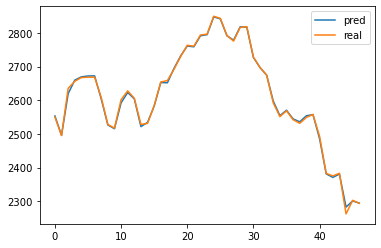

In [19]:
bmodel = TransformerTimeSeries(feature_dim = feature_dim,
                                  nhead = 4,num_layers = 12,d_model = 512,
                                  conv_len = 5,feature_weight = True,embedding_weight = True)
bmodel.load_state_dict(torch.load('GOOG_L'))
bmodel.to(device)
bmodel.eval()
with torch.no_grad(): # eliminate gradient i.e. gradients only exists in train()

    for step,(x,y,feature,attention_masks) in enumerate(test_dl):
        x = x.to(device)
        y = y.to(device)
        feature = feature.to(device)
        attention_masks = attention_masks.to(device)
        output = bmodel(x,y,feature,attention_masks[0])
        
        pred = data[train_size + 1 :-1,2]*0.01*(100+output[:,t0:].squeeze()).detach().cpu()
        real = data[train_size + 1 :-1,2]*0.01*(100+y[:,t0:].squeeze()).detach().cpu()

        plt.plot(pred)
        plt.plot(real)
        plt.legend(['pred','real'])
        MAE = torch.nn.L1Loss()(pred,real).item()
        MSE = torch.nn.MSELoss()(pred,real).item()
        RMSE = np.sqrt(MSE)
        
        print(f'GOOG MAE is {MAE}')
        print(f'GOOG MSE is {MSE}')
        print(f'GOOG RMSE is {RMSE}')

##### Close

In [20]:
file_name = 'GOOG_features.csv'
with open(file_name) as f:
    data_list = csv.reader(f)
    data = []
    for row in data_list:
        data.append(row)
    f.close()
    
data = torch.tensor(np.delete(np.array(data)[1:,2:],4,axis = 1).astype(np.float)).type(torch.float)

feature_dim = data.shape[1] - 1
rate = []
for i in range(1,data.shape[0]):
    rate.append((100*(data[i,0:4] - data[i-1,0:4])/data[i-1,0:4]).reshape(1,4))
    
rate = torch.cat(rate)
rate_data = torch.cat([rate,data[1:,4:]],1)
train_size = int(data.shape[0]*0.9)
data_train = rate_data[0:train_size]
data_test = rate_data[train_size-4:]


t0 = 5
to_predict = 1
train_dataset = GetData(data_train[:,3],torch.cat([data_train[:,0:3],data_train[:,4:]],1),t0 = t0, to_predict = to_predict)
test_dataset = GetData(data_test[:,3],torch.cat([data_test[:,0:3],data_test[:,4:]],1),t0 = t0, to_predict = to_predict)
criterion = torch.nn.MSELoss()
# dataloaders
train_dl = DataLoader(train_dataset,batch_size=256,shuffle=True)
test_dl = DataLoader(test_dataset,batch_size=512)





model = TransformerTimeSeries(feature_dim = feature_dim,
                              nhead = 4,num_layers = 12,d_model = 512,
                              conv_len = 5,feature_weight = True,embedding_weight = True)
model = model.to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=1e-5 ,momentum = 0.9, nesterov = True)#Adam optimizer
#scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer,5e-7,3e-5,10,mode = 'exp_range',gamma = 0.9996)



train_epoch_loss = []
test_epoch_loss = []
test_best = 9999
for epoch in tqdm(range(4000)):


    l_t = train_epoch(model,train_dl,optimizer,t0,to_predict)

    train_loss = test_epoch(model,train_dl,t0,to_predict)


    test_loss = test_epoch(model,test_dl,t0,to_predict)


    if test_best > test_loss:
        test_best = test_loss
        torch.save(model.state_dict(), 'GOOG_C')



    train_epoch_loss.append(np.mean(train_loss))
    test_epoch_loss.append(test_loss)

    print("Epoch {}: Train loss: {} \t test loss: {}".format(epoch+1,
                                                             np.mean(train_loss),
                                                             test_loss))
    #scheduler.step()


torch.Size([431, 6])
torch.Size([431, 6])
torch.Size([47, 6])
torch.Size([47, 6])


  0%|                                                                                     | 0/4000 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1944: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
  0%|                                                                             | 2/4000 [00:00<14:51,  4.49it/s]

Epoch 1: Train loss: 1.273964488036118 	 test loss: 1.8866490125656128
Epoch 2: Train loss: 1.2452017859903677 	 test loss: 1.8943445682525635


  0%|                                                                             | 4/4000 [00:00<10:58,  6.07it/s]

Epoch 3: Train loss: 1.2218364131422994 	 test loss: 1.9020209312438965
Epoch 4: Train loss: 1.2089491529420469 	 test loss: 1.9088494777679443


  0%|                                                                             | 6/4000 [00:01<09:52,  6.74it/s]

Epoch 5: Train loss: 1.2038380836942633 	 test loss: 1.9204086065292358
Epoch 6: Train loss: 1.2031469168076658 	 test loss: 1.93025541305542


  0%|▏                                                                            | 8/4000 [00:01<09:26,  7.05it/s]

Epoch 7: Train loss: 1.2030910250758904 	 test loss: 1.936174750328064
Epoch 8: Train loss: 1.2021860326802372 	 test loss: 1.9355007410049438


  0%|▏                                                                           | 10/4000 [00:01<09:15,  7.18it/s]

Epoch 9: Train loss: 1.2005263575268457 	 test loss: 1.9304094314575195
Epoch 10: Train loss: 1.1989561261267783 	 test loss: 1.922857642173767


  0%|▏                                                                           | 12/4000 [00:01<09:09,  7.26it/s]

Epoch 11: Train loss: 1.1978837118901122 	 test loss: 1.9154220819473267
Epoch 12: Train loss: 1.197798956297943 	 test loss: 1.9085215330123901


  0%|▎                                                                           | 14/4000 [00:02<09:05,  7.30it/s]

Epoch 13: Train loss: 1.1983241913213531 	 test loss: 1.9022771120071411
Epoch 14: Train loss: 1.1983429334556421 	 test loss: 1.8974449634552002


  0%|▎                                                                           | 16/4000 [00:02<09:04,  7.31it/s]

Epoch 15: Train loss: 1.1978164623618957 	 test loss: 1.8946226835250854
Epoch 16: Train loss: 1.1969603145205505 	 test loss: 1.8926922082901


  0%|▎                                                                           | 18/4000 [00:02<09:02,  7.34it/s]

Epoch 17: Train loss: 1.1957685756572713 	 test loss: 1.8915258646011353
Epoch 18: Train loss: 1.1943461197988063 	 test loss: 1.8909797668457031


  0%|▍                                                                           | 20/4000 [00:02<09:02,  7.34it/s]

Epoch 19: Train loss: 1.1927820272622696 	 test loss: 1.8905632495880127
Epoch 20: Train loss: 1.191098439444522 	 test loss: 1.890485167503357


  1%|▍                                                                           | 22/4000 [00:03<09:03,  7.32it/s]

Epoch 21: Train loss: 1.189411228881358 	 test loss: 1.8906010389328003
Epoch 22: Train loss: 1.1879171318355126 	 test loss: 1.8904271125793457


  1%|▍                                                                           | 24/4000 [00:03<09:02,  7.33it/s]

Epoch 23: Train loss: 1.1864515097677846 	 test loss: 1.8903688192367554
Epoch 24: Train loss: 1.1850546111640134 	 test loss: 1.8898882865905762


  1%|▍                                                                           | 26/4000 [00:03<09:03,  7.31it/s]

Epoch 25: Train loss: 1.1838641097540092 	 test loss: 1.8890942335128784
Epoch 26: Train loss: 1.1829881319590345 	 test loss: 1.8867154121398926


  1%|▌                                                                           | 27/4000 [00:04<23:58,  2.76it/s]

Epoch 27: Train loss: 1.1824194068421896 	 test loss: 1.8840590715408325


  1%|▌                                                                           | 28/4000 [00:05<34:30,  1.92it/s]

Epoch 28: Train loss: 1.1816589406360882 	 test loss: 1.881847858428955


  1%|▌                                                                         | 29/4000 [00:11<2:18:27,  2.09s/it]

Epoch 29: Train loss: 1.180841569557544 	 test loss: 1.8800228834152222


  1%|▌                                                                         | 30/4000 [00:17<3:42:55,  3.37s/it]

Epoch 30: Train loss: 1.179885363634114 	 test loss: 1.8780770301818848


  1%|▌                                                                         | 31/4000 [00:24<4:53:37,  4.44s/it]

Epoch 31: Train loss: 1.1788733716354016 	 test loss: 1.87639582157135


  1%|▌                                                                         | 32/4000 [00:31<5:35:40,  5.08s/it]

Epoch 32: Train loss: 1.1778543332889848 	 test loss: 1.8744584321975708


  1%|▌                                                                         | 33/4000 [00:37<6:05:52,  5.53s/it]

Epoch 33: Train loss: 1.1767641535491236 	 test loss: 1.8727247714996338


  1%|▋                                                                         | 34/4000 [00:44<6:27:11,  5.86s/it]

Epoch 34: Train loss: 1.1757108653504444 	 test loss: 1.8712258338928223


  1%|▋                                                                         | 35/4000 [00:50<6:42:05,  6.08s/it]

Epoch 35: Train loss: 1.1746700595537083 	 test loss: 1.8691996335983276


  1%|▋                                                                         | 36/4000 [00:57<6:52:44,  6.25s/it]

Epoch 36: Train loss: 1.1736410634976806 	 test loss: 1.867546558380127


  1%|▋                                                                         | 37/4000 [01:04<6:59:38,  6.35s/it]

Epoch 37: Train loss: 1.17258785053085 	 test loss: 1.8656151294708252


  1%|▋                                                                         | 38/4000 [01:10<7:04:18,  6.43s/it]

Epoch 38: Train loss: 1.1715273533509114 	 test loss: 1.8636984825134277


  1%|▋                                                                         | 39/4000 [01:17<7:07:51,  6.48s/it]

Epoch 39: Train loss: 1.1705904020787392 	 test loss: 1.8616176843643188


  1%|▋                                                                         | 40/4000 [01:23<7:08:57,  6.50s/it]

Epoch 40: Train loss: 1.1692210430335557 	 test loss: 1.8595250844955444


  1%|▊                                                                         | 41/4000 [01:30<7:11:55,  6.55s/it]

Epoch 41: Train loss: 1.1679808479450695 	 test loss: 1.8583532571792603


  1%|▊                                                                         | 42/4000 [01:36<7:05:46,  6.45s/it]

Epoch 42: Train loss: 1.166878380520991 	 test loss: 1.856595516204834


  1%|▊                                                                         | 43/4000 [01:43<7:09:12,  6.51s/it]

Epoch 43: Train loss: 1.1657930200448445 	 test loss: 1.854492425918579


  1%|▊                                                                         | 44/4000 [01:50<7:17:34,  6.64s/it]

Epoch 44: Train loss: 1.1648957223184147 	 test loss: 1.851706624031067


  1%|▊                                                                         | 45/4000 [01:57<7:16:35,  6.62s/it]

Epoch 45: Train loss: 1.1641381353900493 	 test loss: 1.8489214181900024


  1%|▊                                                                         | 46/4000 [02:02<7:02:32,  6.41s/it]

Epoch 46: Train loss: 1.163311832742182 	 test loss: 1.846463918685913


  1%|▊                                                                         | 47/4000 [02:10<7:33:42,  6.89s/it]

Epoch 47: Train loss: 1.162003498066329 	 test loss: 1.8453564643859863


  1%|▉                                                                         | 48/4000 [02:17<7:25:41,  6.77s/it]

Epoch 48: Train loss: 1.160387695527132 	 test loss: 1.8444879055023193


  1%|▉                                                                         | 49/4000 [02:23<7:22:11,  6.72s/it]

Epoch 49: Train loss: 1.1586283276639793 	 test loss: 1.8439862728118896


  1%|▉                                                                         | 50/4000 [02:30<7:19:01,  6.67s/it]

Epoch 50: Train loss: 1.157273933948331 	 test loss: 1.8427335023880005


  1%|▉                                                                         | 51/4000 [02:36<7:05:17,  6.46s/it]

Epoch 51: Train loss: 1.1557055360479864 	 test loss: 1.8416292667388916


  1%|▉                                                                         | 52/4000 [02:43<7:21:17,  6.71s/it]

Epoch 52: Train loss: 1.1535147392556175 	 test loss: 1.8397213220596313


  1%|▉                                                                         | 53/4000 [02:50<7:17:18,  6.65s/it]

Epoch 53: Train loss: 1.152071931522573 	 test loss: 1.8363107442855835


  1%|▉                                                                         | 54/4000 [02:57<7:22:17,  6.73s/it]

Epoch 54: Train loss: 1.1508708127413438 	 test loss: 1.8342951536178589


  1%|█                                                                         | 55/4000 [03:03<7:15:26,  6.62s/it]

Epoch 55: Train loss: 1.1499828385089776 	 test loss: 1.8300310373306274


  1%|█                                                                         | 56/4000 [03:10<7:13:53,  6.60s/it]

Epoch 56: Train loss: 1.149265747889012 	 test loss: 1.8268280029296875


  1%|█                                                                         | 57/4000 [03:16<7:14:49,  6.62s/it]

Epoch 57: Train loss: 1.1483533523475489 	 test loss: 1.8237814903259277


  1%|█                                                                         | 58/4000 [03:23<7:13:17,  6.59s/it]

Epoch 58: Train loss: 1.1469211022427905 	 test loss: 1.8214404582977295


  1%|█                                                                         | 59/4000 [03:29<7:13:52,  6.61s/it]

Epoch 59: Train loss: 1.1449771707406453 	 test loss: 1.8202143907546997


  2%|█                                                                         | 60/4000 [03:36<7:18:40,  6.68s/it]

Epoch 60: Train loss: 1.1430563464795354 	 test loss: 1.8193213939666748


  2%|█▏                                                                        | 61/4000 [03:43<7:12:19,  6.59s/it]

Epoch 61: Train loss: 1.1412377398971063 	 test loss: 1.8178733587265015


  2%|█▏                                                                        | 62/4000 [03:49<7:12:21,  6.59s/it]

Epoch 62: Train loss: 1.1395902130277418 	 test loss: 1.8158143758773804


  2%|█▏                                                                        | 63/4000 [03:56<7:13:24,  6.61s/it]

Epoch 63: Train loss: 1.137934571905645 	 test loss: 1.8144429922103882


  2%|█▏                                                                        | 64/4000 [04:02<6:59:07,  6.39s/it]

Epoch 64: Train loss: 1.136402645133211 	 test loss: 1.8123098611831665


  2%|█▏                                                                        | 65/4000 [04:09<7:16:23,  6.65s/it]

Epoch 65: Train loss: 1.1348880125585676 	 test loss: 1.8095133304595947


  2%|█▏                                                                        | 66/4000 [04:16<7:16:17,  6.65s/it]

Epoch 66: Train loss: 1.1335642260354521 	 test loss: 1.8064113855361938


  2%|█▏                                                                        | 67/4000 [04:22<7:14:56,  6.64s/it]

Epoch 67: Train loss: 1.1320249536474454 	 test loss: 1.8026047945022583


  2%|█▎                                                                        | 68/4000 [04:29<7:14:27,  6.63s/it]

Epoch 68: Train loss: 1.130441279256427 	 test loss: 1.7991927862167358


  2%|█▎                                                                        | 69/4000 [04:36<7:13:40,  6.62s/it]

Epoch 69: Train loss: 1.1290557824265377 	 test loss: 1.795223593711853


  2%|█▎                                                                        | 70/4000 [04:42<7:13:25,  6.62s/it]

Epoch 70: Train loss: 1.1276924657157845 	 test loss: 1.7908289432525635


  2%|█▎                                                                        | 71/4000 [04:49<7:13:13,  6.62s/it]

Epoch 71: Train loss: 1.1262197209621527 	 test loss: 1.7872343063354492


  2%|█▎                                                                        | 72/4000 [04:55<7:05:55,  6.51s/it]

Epoch 72: Train loss: 1.1241296250416342 	 test loss: 1.785045862197876


  2%|█▎                                                                        | 73/4000 [05:01<7:01:25,  6.44s/it]

Epoch 73: Train loss: 1.1218264127828683 	 test loss: 1.7808109521865845


  2%|█▎                                                                        | 74/4000 [05:09<7:16:42,  6.67s/it]

Epoch 74: Train loss: 1.1195794310757843 	 test loss: 1.7770099639892578


  2%|█▍                                                                        | 75/4000 [05:15<7:15:42,  6.66s/it]

Epoch 75: Train loss: 1.1174817873540999 	 test loss: 1.7739096879959106


  2%|█▍                                                                        | 76/4000 [05:21<7:08:10,  6.55s/it]

Epoch 76: Train loss: 1.11552865516282 	 test loss: 1.7698513269424438


  2%|█▍                                                                        | 77/4000 [05:28<7:15:52,  6.67s/it]

Epoch 77: Train loss: 1.1133053205959205 	 test loss: 1.7661103010177612


  2%|█▍                                                                        | 78/4000 [05:35<7:14:24,  6.65s/it]

Epoch 78: Train loss: 1.1109988133481372 	 test loss: 1.7628986835479736


  2%|█▍                                                                        | 79/4000 [05:42<7:11:48,  6.61s/it]

Epoch 79: Train loss: 1.1086509952412404 	 test loss: 1.7596321105957031


  2%|█▍                                                                        | 80/4000 [05:48<7:13:36,  6.64s/it]

Epoch 80: Train loss: 1.1065514491495012 	 test loss: 1.7552560567855835


  2%|█▍                                                                        | 81/4000 [05:55<7:12:40,  6.62s/it]

Epoch 81: Train loss: 1.1043432801616164 	 test loss: 1.7512227296829224


  2%|█▌                                                                        | 82/4000 [06:01<7:11:43,  6.61s/it]

Epoch 82: Train loss: 1.1021484236152985 	 test loss: 1.7469209432601929


  2%|█▌                                                                        | 83/4000 [06:08<7:11:26,  6.61s/it]

Epoch 83: Train loss: 1.0998560093395118 	 test loss: 1.7427932024002075


  2%|█▌                                                                        | 84/4000 [06:15<7:11:26,  6.61s/it]

Epoch 84: Train loss: 1.097418606696162 	 test loss: 1.738852620124817


  2%|█▌                                                                        | 85/4000 [06:21<7:13:37,  6.65s/it]

Epoch 85: Train loss: 1.0953333922715862 	 test loss: 1.7342387437820435


  2%|█▌                                                                        | 86/4000 [06:28<7:08:46,  6.57s/it]

Epoch 86: Train loss: 1.0927460276610337 	 test loss: 1.7301862239837646


  2%|█▌                                                                        | 87/4000 [06:34<7:10:54,  6.61s/it]

Epoch 87: Train loss: 1.0901740828135726 	 test loss: 1.72687828540802


  2%|█▋                                                                        | 88/4000 [06:41<7:10:42,  6.61s/it]

Epoch 88: Train loss: 1.087144850163338 	 test loss: 1.7222548723220825


  2%|█▋                                                                        | 89/4000 [06:48<7:10:32,  6.61s/it]

Epoch 89: Train loss: 1.0843818807270023 	 test loss: 1.7194249629974365


  2%|█▋                                                                        | 90/4000 [06:54<7:14:28,  6.67s/it]

Epoch 90: Train loss: 1.0817351811446612 	 test loss: 1.7165812253952026


  2%|█▋                                                                        | 91/4000 [07:00<6:55:38,  6.38s/it]

Epoch 91: Train loss: 1.079001215107203 	 test loss: 1.712571620941162


  2%|█▋                                                                        | 92/4000 [07:07<7:13:27,  6.65s/it]

Epoch 92: Train loss: 1.0761776778095007 	 test loss: 1.7100377082824707


  2%|█▋                                                                        | 93/4000 [07:14<7:12:21,  6.64s/it]

Epoch 93: Train loss: 1.0733613458974178 	 test loss: 1.7059783935546875


  2%|█▋                                                                        | 94/4000 [07:21<7:11:10,  6.62s/it]

Epoch 94: Train loss: 1.0707699043844803 	 test loss: 1.7010926008224487


  2%|█▊                                                                        | 95/4000 [07:27<7:10:15,  6.61s/it]

Epoch 95: Train loss: 1.0680995158972153 	 test loss: 1.6950517892837524


  2%|█▊                                                                        | 96/4000 [07:34<7:10:35,  6.62s/it]

Epoch 96: Train loss: 1.0652899299586178 	 test loss: 1.6905587911605835


  2%|█▊                                                                        | 97/4000 [07:40<7:09:09,  6.60s/it]

Epoch 97: Train loss: 1.0622305917076058 	 test loss: 1.686734676361084


  2%|█▊                                                                        | 98/4000 [07:47<7:10:09,  6.61s/it]

Epoch 98: Train loss: 1.0587991271384078 	 test loss: 1.6835675239562988


  2%|█▊                                                                        | 99/4000 [07:54<7:07:53,  6.58s/it]

Epoch 99: Train loss: 1.0552789082106748 	 test loss: 1.6788274049758911


  2%|█▊                                                                       | 100/4000 [08:00<7:10:14,  6.62s/it]

Epoch 100: Train loss: 1.0520973468324701 	 test loss: 1.674143671989441


  3%|█▊                                                                       | 101/4000 [08:07<7:09:38,  6.61s/it]

Epoch 101: Train loss: 1.0492939301820476 	 test loss: 1.6680620908737183


  3%|█▊                                                                       | 102/4000 [08:13<7:09:32,  6.61s/it]

Epoch 102: Train loss: 1.0462759345977324 	 test loss: 1.6621683835983276


  3%|█▉                                                                       | 103/4000 [08:20<7:07:12,  6.58s/it]

Epoch 103: Train loss: 1.043344680228532 	 test loss: 1.6558964252471924


  3%|█▉                                                                       | 104/4000 [08:26<7:03:11,  6.52s/it]

Epoch 104: Train loss: 1.0398159370068332 	 test loss: 1.6521923542022705


  3%|█▉                                                                       | 105/4000 [08:33<7:11:01,  6.64s/it]

Epoch 105: Train loss: 1.0359167115041108 	 test loss: 1.6479867696762085


  3%|█▉                                                                       | 106/4000 [08:40<7:03:55,  6.53s/it]

Epoch 106: Train loss: 1.032180734134329 	 test loss: 1.6439793109893799


  3%|█▉                                                                       | 107/4000 [08:46<7:11:28,  6.65s/it]

Epoch 107: Train loss: 1.0287965738026559 	 test loss: 1.6376667022705078


  3%|█▉                                                                       | 108/4000 [08:53<7:09:27,  6.62s/it]

Epoch 108: Train loss: 1.0259762031572877 	 test loss: 1.6299982070922852


  3%|█▉                                                                       | 109/4000 [08:59<7:06:12,  6.57s/it]

Epoch 109: Train loss: 1.023018591365239 	 test loss: 1.623327374458313


  3%|██                                                                       | 110/4000 [09:06<7:10:41,  6.64s/it]

Epoch 110: Train loss: 1.0203688827855404 	 test loss: 1.616887092590332


  3%|██                                                                       | 111/4000 [09:13<7:03:10,  6.53s/it]

Epoch 111: Train loss: 1.0176935182093467 	 test loss: 1.6118134260177612


  3%|██                                                                       | 112/4000 [09:20<7:11:09,  6.65s/it]

Epoch 112: Train loss: 1.0131111486605315 	 test loss: 1.6069605350494385


  3%|██                                                                       | 113/4000 [09:26<7:13:52,  6.70s/it]

Epoch 113: Train loss: 1.0097143591971518 	 test loss: 1.6037994623184204


  3%|██                                                                       | 114/4000 [09:33<7:06:18,  6.58s/it]

Epoch 114: Train loss: 1.0054394168532919 	 test loss: 1.5982733964920044


  3%|██                                                                       | 115/4000 [09:39<7:08:23,  6.62s/it]

Epoch 115: Train loss: 1.0010749822149698 	 test loss: 1.5919244289398193


  3%|██                                                                       | 116/4000 [09:46<7:08:11,  6.61s/it]

Epoch 116: Train loss: 0.9970271534820168 	 test loss: 1.583358883857727


  3%|██▏                                                                      | 117/4000 [09:52<7:06:44,  6.59s/it]

Epoch 117: Train loss: 0.9928364092678592 	 test loss: 1.5766230821609497


  3%|██▏                                                                      | 118/4000 [09:59<7:07:37,  6.61s/it]

Epoch 118: Train loss: 0.9892669333935891 	 test loss: 1.5713096857070923


  3%|██▏                                                                      | 119/4000 [10:06<7:03:38,  6.55s/it]

Epoch 119: Train loss: 0.9882162453956781 	 test loss: 1.5697813034057617


  3%|██▏                                                                      | 120/4000 [10:12<7:08:36,  6.63s/it]

Epoch 120: Train loss: 0.9824360017156933 	 test loss: 1.561044692993164


  3%|██▏                                                                      | 121/4000 [10:19<7:07:59,  6.62s/it]

Epoch 121: Train loss: 0.9797230017157552 	 test loss: 1.5565699338912964


  3%|██▏                                                                      | 122/4000 [10:26<7:07:31,  6.61s/it]

Epoch 122: Train loss: 0.9769415966042786 	 test loss: 1.5516821146011353


  3%|██▏                                                                      | 123/4000 [10:32<7:06:49,  6.61s/it]

Epoch 123: Train loss: 0.9736119612463666 	 test loss: 1.5450286865234375


  3%|██▎                                                                      | 124/4000 [10:39<7:05:05,  6.58s/it]

Epoch 124: Train loss: 0.9706780845493839 	 test loss: 1.5375862121582031


  3%|██▎                                                                      | 125/4000 [10:45<7:07:13,  6.62s/it]

Epoch 125: Train loss: 0.9682908269756079 	 test loss: 1.529972791671753


  3%|██▎                                                                      | 126/4000 [10:52<7:06:53,  6.61s/it]

Epoch 126: Train loss: 0.9656771379944343 	 test loss: 1.5245987176895142


  3%|██▎                                                                      | 127/4000 [10:58<7:03:22,  6.56s/it]

Epoch 127: Train loss: 0.96285184934355 	 test loss: 1.5139148235321045


  3%|██▎                                                                      | 128/4000 [11:05<7:06:21,  6.61s/it]

Epoch 128: Train loss: 0.960946661413684 	 test loss: 1.509242057800293


  3%|██▎                                                                      | 129/4000 [11:12<7:05:24,  6.59s/it]

Epoch 129: Train loss: 0.9593186514006966 	 test loss: 1.501879334449768


  3%|██▎                                                                      | 130/4000 [11:18<7:06:51,  6.62s/it]

Epoch 130: Train loss: 0.955977257470797 	 test loss: 1.4932854175567627


  3%|██▍                                                                      | 131/4000 [11:25<7:06:39,  6.62s/it]

Epoch 131: Train loss: 0.9535688405247132 	 test loss: 1.4853250980377197


  3%|██▍                                                                      | 132/4000 [11:32<7:05:39,  6.60s/it]

Epoch 132: Train loss: 0.950878123396234 	 test loss: 1.4792433977127075


  3%|██▍                                                                      | 133/4000 [11:38<7:05:59,  6.61s/it]

Epoch 133: Train loss: 0.9474421345440804 	 test loss: 1.473484754562378


  3%|██▍                                                                      | 134/4000 [11:45<7:06:20,  6.62s/it]

Epoch 134: Train loss: 0.9441730859937911 	 test loss: 1.467096209526062


  3%|██▍                                                                      | 135/4000 [11:51<7:05:46,  6.61s/it]

Epoch 135: Train loss: 0.9442973861561574 	 test loss: 1.462869644165039


  3%|██▍                                                                      | 136/4000 [11:58<7:05:35,  6.61s/it]

Epoch 136: Train loss: 0.9378537852360311 	 test loss: 1.4566377401351929


  3%|██▌                                                                      | 137/4000 [12:05<7:05:20,  6.61s/it]

Epoch 137: Train loss: 0.9356004967766959 	 test loss: 1.4481040239334106


  3%|██▌                                                                      | 138/4000 [12:10<6:51:30,  6.39s/it]

Epoch 138: Train loss: 0.9314692767202992 	 test loss: 1.4392942190170288


  3%|██▌                                                                      | 139/4000 [12:18<7:09:05,  6.67s/it]

Epoch 139: Train loss: 0.9270162751115945 	 test loss: 1.4333953857421875


  4%|██▌                                                                      | 140/4000 [12:24<7:07:42,  6.65s/it]

Epoch 140: Train loss: 0.9234943781264143 	 test loss: 1.42581045627594


  4%|██▌                                                                      | 141/4000 [12:31<7:06:42,  6.63s/it]

Epoch 141: Train loss: 0.9193850078051715 	 test loss: 1.4219944477081299


  4%|██▌                                                                      | 142/4000 [12:38<7:06:11,  6.63s/it]

Epoch 142: Train loss: 0.9158966039283646 	 test loss: 1.4171184301376343


  4%|██▌                                                                      | 143/4000 [12:44<7:09:00,  6.67s/it]

Epoch 143: Train loss: 0.912174474197308 	 test loss: 1.4118601083755493


  4%|██▋                                                                      | 144/4000 [12:51<7:04:08,  6.60s/it]

Epoch 144: Train loss: 0.9084291462278699 	 test loss: 1.4046554565429688


  4%|██▋                                                                      | 145/4000 [12:57<7:03:51,  6.60s/it]

Epoch 145: Train loss: 0.905085656593128 	 test loss: 1.399024486541748


  4%|██▋                                                                      | 146/4000 [13:04<7:03:04,  6.59s/it]

Epoch 146: Train loss: 0.9020644040506013 	 test loss: 1.3932366371154785


  4%|██▋                                                                      | 147/4000 [13:11<7:02:18,  6.58s/it]

Epoch 147: Train loss: 0.8984978653991859 	 test loss: 1.3860334157943726


  4%|██▋                                                                      | 148/4000 [13:17<7:04:39,  6.61s/it]

Epoch 148: Train loss: 0.8960151084614464 	 test loss: 1.3807603120803833


  4%|██▋                                                                      | 149/4000 [13:24<7:04:22,  6.61s/it]

Epoch 149: Train loss: 0.8928537072825597 	 test loss: 1.3778961896896362


  4%|██▋                                                                      | 150/4000 [13:30<7:03:04,  6.59s/it]

Epoch 150: Train loss: 0.8899330000313141 	 test loss: 1.375755786895752


  4%|██▊                                                                      | 151/4000 [13:37<7:04:07,  6.61s/it]

Epoch 151: Train loss: 0.8865029179856285 	 test loss: 1.3712875843048096


  4%|██▊                                                                      | 152/4000 [13:44<7:03:51,  6.61s/it]

Epoch 152: Train loss: 0.8833076877826328 	 test loss: 1.3636623620986938


  4%|██▊                                                                      | 153/4000 [13:50<7:03:15,  6.60s/it]

Epoch 153: Train loss: 0.8791411140125478 	 test loss: 1.3532179594039917


  4%|██▊                                                                      | 154/4000 [13:57<7:03:34,  6.61s/it]

Epoch 154: Train loss: 0.8792795493265315 	 test loss: 1.3506197929382324


  4%|██▊                                                                      | 155/4000 [14:03<7:03:12,  6.60s/it]

Epoch 155: Train loss: 0.8759351975679951 	 test loss: 1.3469033241271973


  4%|██▊                                                                      | 156/4000 [14:10<7:03:15,  6.61s/it]

Epoch 156: Train loss: 0.8687291991683004 	 test loss: 1.339517593383789


  4%|██▊                                                                      | 157/4000 [14:17<7:03:05,  6.61s/it]

Epoch 157: Train loss: 0.8705720023323378 	 test loss: 1.3377174139022827


  4%|██▉                                                                      | 158/4000 [14:23<7:02:17,  6.59s/it]

Epoch 158: Train loss: 0.8649253807875507 	 test loss: 1.3333758115768433


  4%|██▉                                                                      | 159/4000 [14:30<7:00:12,  6.56s/it]

Epoch 159: Train loss: 0.8597835576174707 	 test loss: 1.325488805770874


  4%|██▉                                                                      | 160/4000 [14:36<7:02:50,  6.61s/it]

Epoch 160: Train loss: 0.856083499721474 	 test loss: 1.318038821220398


  4%|██▉                                                                      | 161/4000 [14:43<7:03:26,  6.62s/it]

Epoch 161: Train loss: 0.851740333431005 	 test loss: 1.314604640007019


  4%|██▉                                                                      | 162/4000 [14:50<7:02:52,  6.61s/it]

Epoch 162: Train loss: 0.8486610344003912 	 test loss: 1.3105127811431885


  4%|██▉                                                                      | 163/4000 [14:56<7:01:01,  6.58s/it]

Epoch 163: Train loss: 0.8464427008153115 	 test loss: 1.305894136428833


  4%|██▉                                                                      | 164/4000 [15:03<7:02:40,  6.61s/it]

Epoch 164: Train loss: 0.8403291291537804 	 test loss: 1.2994941473007202


  4%|███                                                                      | 165/4000 [15:09<7:02:47,  6.61s/it]

Epoch 165: Train loss: 0.8363456012478008 	 test loss: 1.295820951461792


  4%|███                                                                      | 166/4000 [15:16<7:02:17,  6.61s/it]

Epoch 166: Train loss: 0.8328335245081554 	 test loss: 1.2911415100097656


  4%|███                                                                      | 167/4000 [15:22<6:55:42,  6.51s/it]

Epoch 167: Train loss: 0.8295117080073345 	 test loss: 1.2875750064849854


  4%|███                                                                      | 168/4000 [15:29<7:03:48,  6.64s/it]

Epoch 168: Train loss: 0.8255447059385738 	 test loss: 1.2845959663391113


  4%|███                                                                      | 169/4000 [15:36<7:02:55,  6.62s/it]

Epoch 169: Train loss: 0.8210449676502608 	 test loss: 1.2801443338394165


  4%|███                                                                      | 170/4000 [15:42<6:54:00,  6.49s/it]

Epoch 170: Train loss: 0.8168471499828064 	 test loss: 1.2763079404830933


  4%|███                                                                      | 171/4000 [15:49<7:04:09,  6.65s/it]

Epoch 171: Train loss: 0.8136926496665052 	 test loss: 1.2712814807891846


  4%|███▏                                                                     | 172/4000 [15:56<7:03:59,  6.65s/it]

Epoch 172: Train loss: 0.8097945119831236 	 test loss: 1.2667155265808105


  4%|███▏                                                                     | 173/4000 [16:02<7:02:26,  6.62s/it]

Epoch 173: Train loss: 0.8067479035417331 	 test loss: 1.261236548423767


  4%|███▏                                                                     | 174/4000 [16:09<7:02:35,  6.63s/it]

Epoch 174: Train loss: 0.8027731842618531 	 test loss: 1.2565903663635254


  4%|███▏                                                                     | 175/4000 [16:16<7:01:52,  6.62s/it]

Epoch 175: Train loss: 0.7987948461087839 	 test loss: 1.2526066303253174


  4%|███▏                                                                     | 176/4000 [16:22<7:00:52,  6.60s/it]

Epoch 176: Train loss: 0.7949746163981143 	 test loss: 1.2491368055343628


  4%|███▏                                                                     | 177/4000 [16:29<7:01:20,  6.61s/it]

Epoch 177: Train loss: 0.7914513619206068 	 test loss: 1.2439076900482178


  4%|███▏                                                                     | 178/4000 [16:35<7:01:00,  6.61s/it]

Epoch 178: Train loss: 0.7882459675352977 	 test loss: 1.2396949529647827


  4%|███▎                                                                     | 179/4000 [16:42<7:00:37,  6.61s/it]

Epoch 179: Train loss: 0.7847170316702805 	 test loss: 1.236815094947815


  4%|███▎                                                                     | 180/4000 [16:49<7:00:41,  6.61s/it]

Epoch 180: Train loss: 0.7810511825532759 	 test loss: 1.231109857559204


  5%|███▎                                                                     | 181/4000 [16:55<7:00:28,  6.61s/it]

Epoch 181: Train loss: 0.7775114417905874 	 test loss: 1.2259196043014526


  5%|███▎                                                                     | 182/4000 [17:02<6:59:17,  6.59s/it]

Epoch 182: Train loss: 0.7733695879059989 	 test loss: 1.2216460704803467


  5%|███▎                                                                     | 183/4000 [17:08<7:00:02,  6.60s/it]

Epoch 183: Train loss: 0.770259251312424 	 test loss: 1.2156084775924683


  5%|███▎                                                                     | 184/4000 [17:15<7:00:31,  6.61s/it]

Epoch 184: Train loss: 0.7666676422006293 	 test loss: 1.2099792957305908


  5%|███▍                                                                     | 185/4000 [17:22<7:00:02,  6.61s/it]

Epoch 185: Train loss: 0.7628246003679776 	 test loss: 1.2057666778564453


  5%|███▍                                                                     | 186/4000 [17:28<7:00:04,  6.61s/it]

Epoch 186: Train loss: 0.7593813917476451 	 test loss: 1.200299620628357


  5%|███▍                                                                     | 187/4000 [17:35<6:59:26,  6.60s/it]

Epoch 187: Train loss: 0.7566848760967742 	 test loss: 1.1949591636657715


  5%|███▍                                                                     | 188/4000 [17:41<6:59:46,  6.61s/it]

Epoch 188: Train loss: 0.7531156994903724 	 test loss: 1.1895370483398438


  5%|███▍                                                                     | 189/4000 [17:48<6:56:14,  6.55s/it]

Epoch 189: Train loss: 0.7495311112802155 	 test loss: 1.184382438659668


  5%|███▍                                                                     | 190/4000 [17:54<6:47:46,  6.42s/it]

Epoch 190: Train loss: 0.7454999364445768 	 test loss: 1.1794703006744385


  5%|███▍                                                                     | 191/4000 [18:01<7:03:37,  6.67s/it]

Epoch 191: Train loss: 0.7411465961529318 	 test loss: 1.1756619215011597


  5%|███▌                                                                     | 192/4000 [18:08<7:02:22,  6.66s/it]

Epoch 192: Train loss: 0.7369607146267548 	 test loss: 1.171471357345581


  5%|███▌                                                                     | 193/4000 [18:14<7:00:27,  6.63s/it]

Epoch 193: Train loss: 0.7320045293622116 	 test loss: 1.1692639589309692


  5%|███▌                                                                     | 194/4000 [18:21<7:00:16,  6.63s/it]

Epoch 194: Train loss: 0.7276963100632493 	 test loss: 1.1646586656570435


  5%|███▌                                                                     | 195/4000 [18:27<6:46:42,  6.41s/it]

Epoch 195: Train loss: 0.7245889335110127 	 test loss: 1.1585971117019653


  5%|███▌                                                                     | 196/4000 [18:34<7:03:42,  6.68s/it]

Epoch 196: Train loss: 0.7209479995504057 	 test loss: 1.1529192924499512


  5%|███▌                                                                     | 197/4000 [18:41<7:02:03,  6.66s/it]

Epoch 197: Train loss: 0.7163786807912131 	 test loss: 1.1499077081680298


  5%|███▌                                                                     | 198/4000 [18:47<7:00:40,  6.64s/it]

Epoch 198: Train loss: 0.7133223754623926 	 test loss: 1.1440825462341309


  5%|███▋                                                                     | 199/4000 [18:54<6:59:06,  6.62s/it]

Epoch 199: Train loss: 0.7093274894833841 	 test loss: 1.1394091844558716


  5%|███▋                                                                     | 200/4000 [19:01<6:59:44,  6.63s/it]

Epoch 200: Train loss: 0.705312250108564 	 test loss: 1.133611798286438


  5%|███▋                                                                     | 201/4000 [19:07<6:52:01,  6.51s/it]

Epoch 201: Train loss: 0.7018831893628822 	 test loss: 1.1275527477264404


  5%|███▋                                                                     | 202/4000 [19:14<7:00:17,  6.64s/it]

Epoch 202: Train loss: 0.6989517094364299 	 test loss: 1.1232355833053589


  5%|███▋                                                                     | 203/4000 [19:20<6:59:27,  6.63s/it]

Epoch 203: Train loss: 0.6956017603730381 	 test loss: 1.1168333292007446


  5%|███▋                                                                     | 204/4000 [19:27<6:59:16,  6.63s/it]

Epoch 204: Train loss: 0.6926637770404949 	 test loss: 1.1094558238983154


  5%|███▋                                                                     | 205/4000 [19:34<6:58:55,  6.62s/it]

Epoch 205: Train loss: 0.689377773388909 	 test loss: 1.1026288270950317


  5%|███▊                                                                     | 206/4000 [19:40<6:52:04,  6.52s/it]

Epoch 206: Train loss: 0.6858075992690438 	 test loss: 1.0975085496902466


  5%|███▊                                                                     | 207/4000 [19:47<6:59:48,  6.64s/it]

Epoch 207: Train loss: 0.6813575689034783 	 test loss: 1.0920060873031616


  5%|███▊                                                                     | 208/4000 [19:53<6:58:25,  6.62s/it]

Epoch 208: Train loss: 0.6772687993857257 	 test loss: 1.088947057723999


  5%|███▊                                                                     | 209/4000 [20:00<6:52:19,  6.53s/it]

Epoch 209: Train loss: 0.6748749490680385 	 test loss: 1.0804035663604736


  5%|███▊                                                                     | 211/4000 [20:07<4:55:58,  4.69s/it]

Epoch 210: Train loss: 0.6721886415769218 	 test loss: 1.076483130455017
Epoch 211: Train loss: 0.6696733966504338 	 test loss: 1.0774717330932617


  5%|███▊                                                                     | 212/4000 [20:07<3:29:43,  3.32s/it]

Epoch 212: Train loss: 0.6688405612781817 	 test loss: 1.0769585371017456


  5%|███▉                                                                     | 213/4000 [20:13<4:15:00,  4.04s/it]

Epoch 213: Train loss: 0.6611570111560158 	 test loss: 1.0649322271347046


  5%|███▉                                                                     | 214/4000 [20:20<5:13:39,  4.97s/it]

Epoch 214: Train loss: 0.6579410678549322 	 test loss: 1.0552657842636108


  5%|███▉                                                                     | 215/4000 [20:27<5:57:36,  5.67s/it]

Epoch 215: Train loss: 0.6538308629303686 	 test loss: 1.0504887104034424


  5%|███▉                                                                     | 216/4000 [20:34<6:14:39,  5.94s/it]

Epoch 216: Train loss: 0.6502948440697797 	 test loss: 1.0477116107940674


  5%|███▉                                                                     | 217/4000 [20:40<6:27:44,  6.15s/it]

Epoch 217: Train loss: 0.6472266294286865 	 test loss: 1.0434731245040894


  5%|███▉                                                                     | 218/4000 [20:47<6:36:00,  6.28s/it]

Epoch 218: Train loss: 0.6428432727357904 	 test loss: 1.0357669591903687


  5%|███▉                                                                     | 219/4000 [20:53<6:41:58,  6.38s/it]

Epoch 219: Train loss: 0.6378657834435837 	 test loss: 1.027688980102539


  6%|████                                                                     | 220/4000 [21:00<6:45:41,  6.44s/it]

Epoch 220: Train loss: 0.6350113062183708 	 test loss: 1.0241457223892212


  6%|████                                                                     | 221/4000 [21:07<6:48:50,  6.49s/it]

Epoch 221: Train loss: 0.6315487721403348 	 test loss: 1.0192015171051025


  6%|████                                                                     | 222/4000 [21:13<6:47:59,  6.48s/it]

Epoch 222: Train loss: 0.6266899052186244 	 test loss: 1.0103226900100708


  6%|████                                                                     | 223/4000 [21:20<6:52:45,  6.56s/it]

Epoch 223: Train loss: 0.6219390918373232 	 test loss: 1.0016611814498901


  6%|████                                                                     | 224/4000 [21:26<6:54:05,  6.58s/it]

Epoch 224: Train loss: 0.6160309634186553 	 test loss: 0.9998538494110107


  6%|████                                                                     | 225/4000 [21:32<6:42:03,  6.39s/it]

Epoch 225: Train loss: 0.61416596782733 	 test loss: 0.9913349151611328


  6%|████                                                                     | 226/4000 [21:40<7:02:36,  6.72s/it]

Epoch 226: Train loss: 0.6114518686679565 	 test loss: 0.9871562719345093


  6%|████▏                                                                    | 227/4000 [21:46<6:56:11,  6.62s/it]

Epoch 227: Train loss: 0.6079974080459701 	 test loss: 0.9847413301467896


  6%|████▏                                                                    | 228/4000 [21:53<6:55:03,  6.60s/it]

Epoch 228: Train loss: 0.6041978824442887 	 test loss: 0.9799574017524719


  6%|████▏                                                                    | 229/4000 [21:59<6:55:32,  6.61s/it]

Epoch 229: Train loss: 0.5997242775428047 	 test loss: 0.9731576442718506


  6%|████▏                                                                    | 230/4000 [22:06<6:55:27,  6.61s/it]

Epoch 230: Train loss: 0.5954396246204243 	 test loss: 0.9690439701080322


  6%|████▏                                                                    | 231/4000 [22:13<6:53:47,  6.59s/it]

Epoch 231: Train loss: 0.5908995554231435 	 test loss: 0.9629639387130737


  6%|████▏                                                                    | 232/4000 [22:19<6:52:50,  6.57s/it]

Epoch 232: Train loss: 0.5869895051084373 	 test loss: 0.958518922328949


  6%|████▎                                                                    | 233/4000 [22:26<6:55:37,  6.62s/it]

Epoch 233: Train loss: 0.5831299869477611 	 test loss: 0.9537116885185242


  6%|████▎                                                                    | 234/4000 [22:32<6:54:47,  6.61s/it]

Epoch 234: Train loss: 0.5795959976875589 	 test loss: 0.9489484429359436


  6%|████▎                                                                    | 235/4000 [22:39<6:48:42,  6.51s/it]

Epoch 235: Train loss: 0.5755349320214752 	 test loss: 0.9419661164283752


  6%|████▎                                                                    | 236/4000 [22:46<6:56:32,  6.64s/it]

Epoch 236: Train loss: 0.5714547747525704 	 test loss: 0.9387583136558533


  6%|████▎                                                                    | 237/4000 [22:52<6:55:09,  6.62s/it]

Epoch 237: Train loss: 0.568608959008812 	 test loss: 0.9357471466064453


  6%|████▎                                                                    | 238/4000 [22:58<6:47:38,  6.50s/it]

Epoch 238: Train loss: 0.5647288128007593 	 test loss: 0.9294822812080383


  6%|████▍                                                                    | 240/4000 [23:06<4:54:33,  4.70s/it]

Epoch 239: Train loss: 0.5614567899648661 	 test loss: 0.922491729259491
Epoch 240: Train loss: 0.5596206944669205 	 test loss: 0.9236919283866882


  6%|████▍                                                                    | 241/4000 [23:12<5:21:18,  5.13s/it]

Epoch 241: Train loss: 0.5570630583298455 	 test loss: 0.9180653095245361


  6%|████▍                                                                    | 242/4000 [23:19<5:54:59,  5.67s/it]

Epoch 242: Train loss: 0.551659973342568 	 test loss: 0.9030478000640869


  6%|████▍                                                                    | 243/4000 [23:25<6:10:19,  5.91s/it]

Epoch 243: Train loss: 0.5485153549508539 	 test loss: 0.8947423100471497


  6%|████▍                                                                    | 245/4000 [23:31<4:23:46,  4.21s/it]

Epoch 244: Train loss: 0.5448507934877878 	 test loss: 0.8913806080818176
Epoch 245: Train loss: 0.5441954220254017 	 test loss: 0.8918426036834717


  6%|████▍                                                                    | 246/4000 [23:39<5:18:24,  5.09s/it]

Epoch 246: Train loss: 0.5406925296562177 	 test loss: 0.8855165243148804


  6%|████▌                                                                    | 247/4000 [23:45<5:46:43,  5.54s/it]

Epoch 247: Train loss: 0.536800304795086 	 test loss: 0.8707024455070496


  6%|████▌                                                                    | 248/4000 [23:52<6:06:20,  5.86s/it]

Epoch 248: Train loss: 0.5334507612783782 	 test loss: 0.8646404147148132


  6%|████▌                                                                    | 249/4000 [23:58<6:18:50,  6.06s/it]

Epoch 249: Train loss: 0.5313694537930588 	 test loss: 0.8643546104431152


  6%|████▌                                                                    | 250/4000 [24:05<6:30:27,  6.25s/it]

Epoch 250: Train loss: 0.531233993456148 	 test loss: 0.8624942302703857


  6%|████▌                                                                    | 251/4000 [24:12<6:36:52,  6.35s/it]

Epoch 251: Train loss: 0.5246142750549759 	 test loss: 0.8501890301704407


  6%|████▌                                                                    | 252/4000 [24:18<6:40:40,  6.41s/it]

Epoch 252: Train loss: 0.5204768926250962 	 test loss: 0.8435194492340088


  6%|████▌                                                                    | 253/4000 [24:25<6:44:54,  6.48s/it]

Epoch 253: Train loss: 0.5162892398314244 	 test loss: 0.8361396789550781


  6%|████▋                                                                    | 254/4000 [24:31<6:45:19,  6.49s/it]

Epoch 254: Train loss: 0.5138183083998908 	 test loss: 0.8319722414016724


  6%|████▋                                                                    | 255/4000 [24:38<6:49:13,  6.56s/it]

Epoch 255: Train loss: 0.5139543593897897 	 test loss: 0.831255316734314


  6%|████▋                                                                    | 256/4000 [24:45<6:49:57,  6.57s/it]

Epoch 256: Train loss: 0.5106636314823567 	 test loss: 0.826740562915802


  6%|████▋                                                                    | 257/4000 [24:51<6:54:23,  6.64s/it]

Epoch 257: Train loss: 0.5034183600524186 	 test loss: 0.8187747597694397


  6%|████▋                                                                    | 258/4000 [24:58<6:48:30,  6.55s/it]

Epoch 258: Train loss: 0.5009547983687328 	 test loss: 0.8143683671951294


  6%|████▋                                                                    | 260/4000 [25:04<4:49:48,  4.65s/it]

Epoch 259: Train loss: 0.4957372030359963 	 test loss: 0.8074741363525391
Epoch 260: Train loss: 0.49916693395362377 	 test loss: 0.812044620513916


  7%|████▊                                                                    | 261/4000 [25:11<5:23:49,  5.20s/it]

Epoch 261: Train loss: 0.5007887414879146 	 test loss: 0.7990373373031616


  7%|████▊                                                                    | 262/4000 [25:18<5:49:25,  5.61s/it]

Epoch 262: Train loss: 0.4868409705549271 	 test loss: 0.7983103394508362


  7%|████▊                                                                    | 263/4000 [25:24<6:02:16,  5.82s/it]

Epoch 263: Train loss: 0.4819946815270559 	 test loss: 0.7890311479568481


  7%|████▊                                                                    | 264/4000 [25:31<6:23:09,  6.15s/it]

Epoch 264: Train loss: 0.4802623638697401 	 test loss: 0.7831017374992371


  7%|████▊                                                                    | 265/4000 [25:37<6:29:33,  6.26s/it]

Epoch 265: Train loss: 0.47809435983821574 	 test loss: 0.7799083590507507


  7%|████▊                                                                    | 266/4000 [25:44<6:40:55,  6.44s/it]

Epoch 266: Train loss: 0.4743677625246778 	 test loss: 0.7734013795852661


  7%|████▊                                                                    | 267/4000 [25:51<6:40:31,  6.44s/it]

Epoch 267: Train loss: 0.4692015770969701 	 test loss: 0.7655094265937805


  7%|████▉                                                                    | 268/4000 [25:56<6:30:07,  6.27s/it]

Epoch 268: Train loss: 0.46739991434488937 	 test loss: 0.7607079148292542


  7%|████▉                                                                    | 270/4000 [26:04<4:49:18,  4.65s/it]

Epoch 269: Train loss: 0.4638462749821957 	 test loss: 0.7548899054527283
Epoch 270: Train loss: 0.4657871979018652 	 test loss: 0.7562907338142395


  7%|████▉                                                                    | 271/4000 [26:10<5:21:00,  5.16s/it]

Epoch 271: Train loss: 0.4585153286252387 	 test loss: 0.7448165416717529


  7%|████▉                                                                    | 272/4000 [26:17<5:49:49,  5.63s/it]

Epoch 272: Train loss: 0.45667929231705634 	 test loss: 0.7392073273658752


  7%|████▉                                                                    | 273/4000 [26:24<6:07:16,  5.91s/it]

Epoch 273: Train loss: 0.4560100287544755 	 test loss: 0.7341978549957275


  7%|█████                                                                    | 274/4000 [26:30<6:20:13,  6.12s/it]

Epoch 274: Train loss: 0.4505134078300193 	 test loss: 0.7296111583709717


  7%|█████                                                                    | 275/4000 [26:36<6:23:13,  6.17s/it]

Epoch 275: Train loss: 0.44822104901006216 	 test loss: 0.7251344919204712


  7%|█████                                                                    | 276/4000 [26:43<6:37:08,  6.40s/it]

Epoch 276: Train loss: 0.4478762963670036 	 test loss: 0.7242710590362549


  7%|█████                                                                    | 277/4000 [26:50<6:40:15,  6.45s/it]

Epoch 277: Train loss: 0.4467032955583453 	 test loss: 0.7203744053840637


  7%|█████                                                                    | 278/4000 [26:57<6:43:35,  6.51s/it]

Epoch 278: Train loss: 0.4412630815793633 	 test loss: 0.7115848660469055


  7%|█████                                                                    | 279/4000 [27:02<6:32:07,  6.32s/it]

Epoch 279: Train loss: 0.4382088942206929 	 test loss: 0.7046430110931396


  7%|█████                                                                    | 280/4000 [27:10<6:50:23,  6.62s/it]

Epoch 280: Train loss: 0.43576865261226133 	 test loss: 0.6994630098342896


  7%|█████▏                                                                   | 281/4000 [27:16<6:49:34,  6.61s/it]

Epoch 281: Train loss: 0.4333486574985035 	 test loss: 0.6965700387954712


  7%|█████▏                                                                   | 282/4000 [27:23<6:49:21,  6.61s/it]

Epoch 282: Train loss: 0.43147202918258454 	 test loss: 0.6928321123123169


  7%|█████▏                                                                   | 284/4000 [27:30<4:52:53,  4.73s/it]

Epoch 283: Train loss: 0.42837969900007317 	 test loss: 0.6873883605003357
Epoch 284: Train loss: 0.4297872615109464 	 test loss: 0.6895123720169067


  7%|█████▏                                                                   | 286/4000 [27:36<3:42:18,  3.59s/it]

Epoch 285: Train loss: 0.4289827105479008 	 test loss: 0.685721755027771
Epoch 286: Train loss: 0.42991034759169666 	 test loss: 0.686170220375061


  7%|█████▏                                                                   | 287/4000 [27:43<4:41:32,  4.55s/it]

Epoch 287: Train loss: 0.42711794729022584 	 test loss: 0.6846998333930969


  7%|█████▎                                                                   | 288/4000 [27:49<5:15:54,  5.11s/it]

Epoch 288: Train loss: 0.4237299546288227 	 test loss: 0.6813415884971619


  7%|█████▎                                                                   | 289/4000 [27:56<5:47:28,  5.62s/it]

Epoch 289: Train loss: 0.41927461689143614 	 test loss: 0.6754204034805298


  7%|█████▎                                                                   | 290/4000 [28:02<6:02:33,  5.86s/it]

Epoch 290: Train loss: 0.4166907587903282 	 test loss: 0.6713762283325195


  7%|█████▎                                                                   | 292/4000 [28:10<4:31:22,  4.39s/it]

Epoch 291: Train loss: 0.41380936467453944 	 test loss: 0.6640379428863525
Epoch 292: Train loss: 0.41115598017544314 	 test loss: 0.6667583584785461


  7%|█████▎                                                                   | 294/4000 [28:16<3:36:09,  3.50s/it]

Epoch 293: Train loss: 0.4134416551849958 	 test loss: 0.6547650694847107
Epoch 294: Train loss: 0.40996564942003677 	 test loss: 0.6566236019134521


  7%|█████▍                                                                   | 295/4000 [28:16<2:33:57,  2.49s/it]

Epoch 295: Train loss: 0.40745426171617 	 test loss: 0.6573665738105774


  7%|█████▍                                                                   | 296/4000 [28:22<3:44:24,  3.64s/it]

Epoch 296: Train loss: 0.40256271658253506 	 test loss: 0.6482190489768982


  7%|█████▍                                                                   | 298/4000 [28:29<3:17:38,  3.20s/it]

Epoch 297: Train loss: 0.4023706056955519 	 test loss: 0.6386459469795227
Epoch 298: Train loss: 0.4000930937564567 	 test loss: 0.638995885848999


  7%|█████▍                                                                   | 299/4000 [28:36<4:20:56,  4.23s/it]

Epoch 299: Train loss: 0.3987233044791388 	 test loss: 0.6333256959915161


  8%|█████▍                                                                   | 300/4000 [28:42<5:05:43,  4.96s/it]

Epoch 300: Train loss: 0.39679669635478415 	 test loss: 0.6317316293716431


  8%|█████▌                                                                   | 302/4000 [28:49<3:55:38,  3.82s/it]

Epoch 301: Train loss: 0.3948947453996698 	 test loss: 0.6244772672653198
Epoch 302: Train loss: 0.3934563491018078 	 test loss: 0.6251667737960815


  8%|█████▌                                                                   | 304/4000 [28:49<1:59:42,  1.94s/it]

Epoch 303: Train loss: 0.39406110833803076 	 test loss: 0.6285948157310486
Epoch 304: Train loss: 0.39309628608608466 	 test loss: 0.628079891204834


  8%|█████▌                                                                   | 305/4000 [28:55<3:11:10,  3.10s/it]

Epoch 305: Train loss: 0.38817894161439 	 test loss: 0.6070498824119568


  8%|█████▌                                                                   | 306/4000 [29:02<4:22:20,  4.26s/it]

Epoch 306: Train loss: 0.38922045907122355 	 test loss: 0.5969313383102417


  8%|█████▌                                                                   | 308/4000 [29:09<3:36:42,  3.52s/it]

Epoch 307: Train loss: 0.3862702603129942 	 test loss: 0.5960522890090942
Epoch 308: Train loss: 0.3870136177733437 	 test loss: 0.6188350319862366


  8%|█████▋                                                                   | 310/4000 [29:09<1:50:27,  1.80s/it]

Epoch 309: Train loss: 0.39028429708458706 	 test loss: 0.628132164478302
Epoch 310: Train loss: 0.38270510432338495 	 test loss: 0.6084123849868774


  8%|█████▋                                                                   | 311/4000 [29:15<3:05:00,  3.01s/it]

Epoch 311: Train loss: 0.3786104868431932 	 test loss: 0.5882759094238281


  8%|█████▋                                                                   | 313/4000 [29:22<2:59:26,  2.92s/it]

Epoch 312: Train loss: 0.3839347789154805 	 test loss: 0.5733975172042847
Epoch 313: Train loss: 0.3779636562700338 	 test loss: 0.5742382407188416


  8%|█████▋                                                                   | 315/4000 [29:22<1:32:12,  1.50s/it]

Epoch 314: Train loss: 0.37512357398141566 	 test loss: 0.5968832969665527
Epoch 315: Train loss: 0.3736595643507079 	 test loss: 0.590785801410675


  8%|█████▊                                                                   | 316/4000 [29:28<3:03:36,  2.99s/it]

Epoch 316: Train loss: 0.3746972516213658 	 test loss: 0.5687723159790039


  8%|█████▊                                                                   | 318/4000 [29:35<2:57:33,  2.89s/it]

Epoch 317: Train loss: 0.37342243052137425 	 test loss: 0.56666499376297
Epoch 318: Train loss: 0.37061848130137626 	 test loss: 0.5759696960449219


  8%|█████▊                                                                   | 320/4000 [29:36<1:31:13,  1.49s/it]

Epoch 319: Train loss: 0.374110065106726 	 test loss: 0.601679801940918
Epoch 320: Train loss: 0.3689338730825349 	 test loss: 0.5832062363624573


  8%|█████▉                                                                   | 322/4000 [29:42<2:06:49,  2.07s/it]

Epoch 321: Train loss: 0.3667737219283863 	 test loss: 0.5645408630371094
Epoch 322: Train loss: 0.3652179866268574 	 test loss: 0.5648030638694763


  8%|█████▉                                                                   | 324/4000 [29:48<2:28:02,  2.42s/it]

Epoch 323: Train loss: 0.36505012971342576 	 test loss: 0.5541514754295349
Epoch 324: Train loss: 0.3629510557568543 	 test loss: 0.5603238940238953


  8%|█████▉                                                                   | 325/4000 [29:55<3:42:12,  3.63s/it]

Epoch 325: Train loss: 0.36017670888635234 	 test loss: 0.5532350540161133


  8%|█████▉                                                                   | 327/4000 [30:02<3:15:49,  3.20s/it]

Epoch 326: Train loss: 0.35711842733856697 	 test loss: 0.5497336387634277
Epoch 327: Train loss: 0.3548813710494827 	 test loss: 0.5564932823181152


  8%|█████▉                                                                   | 328/4000 [30:02<2:19:34,  2.28s/it]

Epoch 328: Train loss: 0.3524548510940888 	 test loss: 0.5516005158424377


  8%|██████                                                                   | 330/4000 [30:08<2:24:12,  2.36s/it]

Epoch 329: Train loss: 0.35159323013575616 	 test loss: 0.5373015403747559
Epoch 330: Train loss: 0.3495817017112697 	 test loss: 0.5419852137565613


  8%|██████                                                                   | 332/4000 [30:08<1:14:54,  1.23s/it]

Epoch 331: Train loss: 0.34950241197566145 	 test loss: 0.5557839274406433
Epoch 332: Train loss: 0.34801613489325806 	 test loss: 0.5527425408363342


  8%|██████▎                                                                    | 334/4000 [30:08<40:59,  1.49it/s]

Epoch 333: Train loss: 0.347871180960861 	 test loss: 0.5576939582824707
Epoch 334: Train loss: 0.3441059071475558 	 test loss: 0.538403332233429


  8%|██████▏                                                                  | 336/4000 [30:15<1:46:34,  1.75s/it]

Epoch 335: Train loss: 0.3428692768593675 	 test loss: 0.5305653810501099
Epoch 336: Train loss: 0.3407714668393412 	 test loss: 0.5308777093887329


  8%|██████▏                                                                  | 338/4000 [30:21<2:17:26,  2.25s/it]

Epoch 337: Train loss: 0.3399874176613969 	 test loss: 0.5267475843429565
Epoch 338: Train loss: 0.3387123818602197 	 test loss: 0.5310533046722412


  8%|██████▏                                                                  | 339/4000 [30:22<1:38:42,  1.62s/it]

Epoch 339: Train loss: 0.3396118689164208 	 test loss: 0.5319684743881226


  9%|██████▏                                                                  | 341/4000 [30:28<2:12:19,  2.17s/it]

Epoch 340: Train loss: 0.33953187007915114 	 test loss: 0.5116207003593445
Epoch 341: Train loss: 0.3373664982634188 	 test loss: 0.5198068022727966


  9%|██████▎                                                                  | 343/4000 [30:28<1:09:03,  1.13s/it]

Epoch 342: Train loss: 0.3367641786688165 	 test loss: 0.5258199572563171
Epoch 343: Train loss: 0.3361008172798599 	 test loss: 0.5274908542633057


  9%|██████▍                                                                    | 345/4000 [30:29<38:03,  1.60it/s]

Epoch 344: Train loss: 0.3345526413961796 	 test loss: 0.5231512784957886
Epoch 345: Train loss: 0.33386080392275497 	 test loss: 0.5236057639122009


  9%|██████▍                                                                    | 346/4000 [30:29<29:08,  2.09it/s]

Epoch 346: Train loss: 0.33436748454576304 	 test loss: 0.532748818397522


  9%|██████▎                                                                  | 347/4000 [30:34<2:05:31,  2.06s/it]

Epoch 347: Train loss: 0.33405433301306103 	 test loss: 0.5039815306663513


  9%|██████▎                                                                  | 349/4000 [30:41<2:28:45,  2.44s/it]

Epoch 348: Train loss: 0.3348941789149132 	 test loss: 0.4946819841861725
Epoch 349: Train loss: 0.33009566736608537 	 test loss: 0.5057750940322876


  9%|██████▍                                                                  | 351/4000 [30:42<1:17:07,  1.27s/it]

Epoch 350: Train loss: 0.33021104446419985 	 test loss: 0.526524007320404
Epoch 351: Train loss: 0.33013599530173565 	 test loss: 0.523365318775177


  9%|██████▌                                                                    | 353/4000 [30:42<42:00,  1.45it/s]

Epoch 352: Train loss: 0.33087967394952705 	 test loss: 0.5277511477470398
Epoch 353: Train loss: 0.32788811800374784 	 test loss: 0.4990513324737549


  9%|██████▍                                                                  | 355/4000 [30:48<1:34:26,  1.55s/it]

Epoch 354: Train loss: 0.3326862241441855 	 test loss: 0.48783329129219055
Epoch 355: Train loss: 0.32766767229945365 	 test loss: 0.49465852975845337


  9%|██████▋                                                                    | 357/4000 [30:48<50:30,  1.20it/s]

Epoch 356: Train loss: 0.32617156058895613 	 test loss: 0.5077002048492432
Epoch 357: Train loss: 0.326775156635696 	 test loss: 0.5077080130577087


  9%|██████▋                                                                    | 359/4000 [30:48<28:57,  2.10it/s]

Epoch 358: Train loss: 0.32554943475811776 	 test loss: 0.5028326511383057
Epoch 359: Train loss: 0.32364168237644114 	 test loss: 0.49087923765182495


  9%|██████▌                                                                  | 360/4000 [30:54<2:13:47,  2.21s/it]

Epoch 360: Train loss: 0.32449085419249923 	 test loss: 0.4817160665988922


  9%|██████▌                                                                  | 362/4000 [31:01<2:32:08,  2.51s/it]

Epoch 361: Train loss: 0.32353484838025476 	 test loss: 0.48140186071395874
Epoch 362: Train loss: 0.3217315355060825 	 test loss: 0.4947414994239807


  9%|██████▋                                                                  | 364/4000 [31:01<1:18:43,  1.30s/it]

Epoch 363: Train loss: 0.32003917100811224 	 test loss: 0.49174100160598755
Epoch 364: Train loss: 0.31822134875919317 	 test loss: 0.4844878017902374


  9%|██████▋                                                                  | 366/4000 [31:08<1:59:55,  1.98s/it]

Epoch 365: Train loss: 0.31688350639597723 	 test loss: 0.48060956597328186
Epoch 366: Train loss: 0.3149622223769982 	 test loss: 0.4823869466781616


  9%|██████▋                                                                  | 367/4000 [31:14<3:21:10,  3.32s/it]

Epoch 367: Train loss: 0.3139118184346334 	 test loss: 0.4790162742137909


  9%|██████▋                                                                  | 369/4000 [31:21<3:00:57,  2.99s/it]

Epoch 368: Train loss: 0.31699305164288477 	 test loss: 0.46490591764450073
Epoch 369: Train loss: 0.31247948466210246 	 test loss: 0.47278308868408203


  9%|██████▊                                                                  | 371/4000 [31:21<1:33:01,  1.54s/it]

Epoch 370: Train loss: 0.31189855269378963 	 test loss: 0.4859175980091095
Epoch 371: Train loss: 0.31081357100446927 	 test loss: 0.4860050082206726


  9%|██████▉                                                                    | 373/4000 [31:21<49:47,  1.21it/s]

Epoch 372: Train loss: 0.31108926177854607 	 test loss: 0.47762784361839294
Epoch 373: Train loss: 0.3103507365815324 	 test loss: 0.47454285621643066


  9%|███████                                                                    | 375/4000 [31:21<28:36,  2.11it/s]

Epoch 374: Train loss: 0.3114443454554352 	 test loss: 0.4955800473690033
Epoch 375: Train loss: 0.307389933451699 	 test loss: 0.48411038517951965


  9%|███████                                                                    | 377/4000 [31:22<18:14,  3.31it/s]

Epoch 376: Train loss: 0.3068770522169613 	 test loss: 0.4684976041316986
Epoch 377: Train loss: 0.3057949601774149 	 test loss: 0.4650443196296692


  9%|██████▉                                                                  | 378/4000 [31:27<1:55:19,  1.91s/it]

Epoch 378: Train loss: 0.3062062847088772 	 test loss: 0.4637082815170288


 10%|██████▉                                                                  | 380/4000 [31:34<2:22:32,  2.36s/it]

Epoch 379: Train loss: 0.3135038792672124 	 test loss: 0.45343664288520813
Epoch 380: Train loss: 0.30054426663436357 	 test loss: 0.4629957973957062


 10%|██████▉                                                                  | 382/4000 [31:34<1:14:00,  1.23s/it]

Epoch 381: Train loss: 0.2987931332704363 	 test loss: 0.4657483398914337
Epoch 382: Train loss: 0.30183734120736266 	 test loss: 0.45793625712394714


 10%|███████▏                                                                   | 384/4000 [31:35<40:26,  1.49it/s]

Epoch 383: Train loss: 0.30062481643428934 	 test loss: 0.45838841795921326
Epoch 384: Train loss: 0.2973823447100248 	 test loss: 0.4625944495201111


 10%|███████▏                                                                   | 386/4000 [31:35<24:01,  2.51it/s]

Epoch 385: Train loss: 0.2961261339502932 	 test loss: 0.46288764476776123
Epoch 386: Train loss: 0.2947853586513316 	 test loss: 0.463670015335083


 10%|███████▎                                                                   | 388/4000 [31:35<15:58,  3.77it/s]

Epoch 387: Train loss: 0.29423391134445737 	 test loss: 0.46612006425857544
Epoch 388: Train loss: 0.29270501541980737 	 test loss: 0.46021535992622375


 10%|███████▎                                                                   | 390/4000 [31:35<12:02,  5.00it/s]

Epoch 389: Train loss: 0.2931613766538571 	 test loss: 0.45493385195732117
Epoch 390: Train loss: 0.29360321371571924 	 test loss: 0.4551350474357605


 10%|███████▎                                                                   | 392/4000 [31:36<10:04,  5.97it/s]

Epoch 391: Train loss: 0.29151858683252 	 test loss: 0.4571669101715088
Epoch 392: Train loss: 0.29149475831996535 	 test loss: 0.4573625922203064


 10%|███████▏                                                                 | 393/4000 [31:40<1:28:32,  1.47s/it]

Epoch 393: Train loss: 0.29169531218413686 	 test loss: 0.44893455505371094


 10%|███████▏                                                                 | 395/4000 [31:47<2:12:58,  2.21s/it]

Epoch 394: Train loss: 0.29141368583847366 	 test loss: 0.4479130804538727
Epoch 395: Train loss: 0.2906129275148263 	 test loss: 0.45291006565093994


 10%|███████▏                                                                 | 397/4000 [31:48<1:09:19,  1.15s/it]

Epoch 396: Train loss: 0.2901805734689717 	 test loss: 0.4509444534778595
Epoch 397: Train loss: 0.28979275882105815 	 test loss: 0.4535033702850342


 10%|███████▍                                                                   | 399/4000 [31:48<38:09,  1.57it/s]

Epoch 398: Train loss: 0.28942775387498454 	 test loss: 0.45715096592903137
Epoch 399: Train loss: 0.2886346131217452 	 test loss: 0.4544229507446289


 10%|███████▎                                                                 | 401/4000 [31:54<1:31:49,  1.53s/it]

Epoch 400: Train loss: 0.2896881377337427 	 test loss: 0.4440988302230835
Epoch 401: Train loss: 0.2883668351754235 	 test loss: 0.446049302816391


 10%|███████▌                                                                   | 403/4000 [31:54<49:11,  1.22it/s]

Epoch 402: Train loss: 0.28766800577292034 	 test loss: 0.4524998962879181
Epoch 403: Train loss: 0.28845577401794026 	 test loss: 0.44734060764312744


 10%|███████▌                                                                   | 404/4000 [31:54<36:54,  1.62it/s]

Epoch 404: Train loss: 0.28859716425639015 	 test loss: 0.4489913880825043


 10%|███████▍                                                                 | 405/4000 [32:00<2:20:42,  2.35s/it]

Epoch 405: Train loss: 0.28888844496412786 	 test loss: 0.44402340054512024


 10%|███████▍                                                                 | 407/4000 [32:07<2:33:29,  2.56s/it]

Epoch 406: Train loss: 0.289511168570087 	 test loss: 0.43457716703414917
Epoch 407: Train loss: 0.28378432055637065 	 test loss: 0.4437216818332672


 10%|███████▍                                                                 | 409/4000 [32:07<1:19:24,  1.33s/it]

Epoch 408: Train loss: 0.2821802008041373 	 test loss: 0.4487859606742859
Epoch 409: Train loss: 0.2813639468632275 	 test loss: 0.45180031657218933


 10%|███████▋                                                                   | 410/4000 [32:07<58:01,  1.03it/s]

Epoch 410: Train loss: 0.28072449322919557 	 test loss: 0.4424949586391449


 10%|███████▌                                                                 | 412/4000 [32:13<1:43:35,  1.73s/it]

Epoch 411: Train loss: 0.28283623524718937 	 test loss: 0.43448328971862793
Epoch 412: Train loss: 0.28225902960637883 	 test loss: 0.435532808303833


 10%|███████▊                                                                   | 414/4000 [32:14<54:53,  1.09it/s]

Epoch 413: Train loss: 0.2808505406650756 	 test loss: 0.43898436427116394
Epoch 414: Train loss: 0.2808252494185817 	 test loss: 0.44149258732795715


 10%|███████▊                                                                   | 415/4000 [32:14<40:52,  1.46it/s]

Epoch 415: Train loss: 0.2818315003559927 	 test loss: 0.4351769685745239


 10%|███████▌                                                                 | 417/4000 [32:20<1:38:30,  1.65s/it]

Epoch 416: Train loss: 0.28245124283080314 	 test loss: 0.43063369393348694
Epoch 417: Train loss: 0.28119059802484625 	 test loss: 0.43660247325897217


 10%|███████▊                                                                   | 419/4000 [32:20<52:25,  1.14it/s]

Epoch 418: Train loss: 0.2808504509815207 	 test loss: 0.4370579719543457
Epoch 419: Train loss: 0.28184872326330906 	 test loss: 0.43063971400260925


 10%|███████▋                                                                 | 420/4000 [32:27<2:33:27,  2.57s/it]

Epoch 420: Train loss: 0.2805639686551282 	 test loss: 0.4299953281879425


 11%|███████▋                                                                 | 422/4000 [32:33<2:39:48,  2.68s/it]

Epoch 421: Train loss: 0.2808740656917997 	 test loss: 0.4261956512928009
Epoch 422: Train loss: 0.2778916080977137 	 test loss: 0.43424174189567566


 11%|███████▋                                                                 | 424/4000 [32:34<1:22:26,  1.38s/it]

Epoch 423: Train loss: 0.28113044400779386 	 test loss: 0.4506320357322693
Epoch 424: Train loss: 0.2779082301182979 	 test loss: 0.4285503029823303


 11%|███████▉                                                                   | 426/4000 [32:34<44:32,  1.34it/s]

Epoch 425: Train loss: 0.277628392741741 	 test loss: 0.42908740043640137
Epoch 426: Train loss: 0.2771924030891427 	 test loss: 0.43510809540748596


 11%|███████▊                                                                 | 428/4000 [32:40<1:38:45,  1.66s/it]

Epoch 427: Train loss: 0.27877460489278605 	 test loss: 0.42383110523223877
Epoch 428: Train loss: 0.2754116935132551 	 test loss: 0.43591681122779846


 11%|████████                                                                   | 430/4000 [32:40<52:32,  1.13it/s]

Epoch 429: Train loss: 0.2757868625033483 	 test loss: 0.4300260543823242
Epoch 430: Train loss: 0.2758932578314761 	 test loss: 0.4312664568424225


 11%|████████                                                                   | 432/4000 [32:41<29:55,  1.99it/s]

Epoch 431: Train loss: 0.2749156837811879 	 test loss: 0.4374726414680481
Epoch 432: Train loss: 0.2739926158966985 	 test loss: 0.43529942631721497


 11%|███████▉                                                                 | 433/4000 [32:46<2:00:26,  2.03s/it]

Epoch 433: Train loss: 0.27409839436515576 	 test loss: 0.42010873556137085


 11%|███████▉                                                                 | 434/4000 [32:53<3:27:45,  3.50s/it]

Epoch 434: Train loss: 0.27696420981823155 	 test loss: 0.41590920090675354


 11%|███████▉                                                                 | 436/4000 [33:00<3:06:44,  3.14s/it]

Epoch 435: Train loss: 0.27624349790493463 	 test loss: 0.4154476225376129
Epoch 436: Train loss: 0.27239013174570353 	 test loss: 0.4182746708393097


 11%|███████▉                                                                 | 438/4000 [33:00<1:35:38,  1.61s/it]

Epoch 437: Train loss: 0.27115756919793355 	 test loss: 0.4179571568965912
Epoch 438: Train loss: 0.2695874821420612 	 test loss: 0.4257069230079651


 11%|████████▎                                                                  | 440/4000 [33:00<50:58,  1.16it/s]

Epoch 439: Train loss: 0.2692878873469935 	 test loss: 0.418397456407547
Epoch 440: Train loss: 0.2688793022090487 	 test loss: 0.4229503273963928


 11%|████████▎                                                                  | 442/4000 [33:01<29:06,  2.04it/s]

Epoch 441: Train loss: 0.26800037018107703 	 test loss: 0.42724499106407166
Epoch 442: Train loss: 0.2667546604528781 	 test loss: 0.4235571324825287


 11%|████████▎                                                                  | 444/4000 [33:01<18:24,  3.22it/s]

Epoch 443: Train loss: 0.26652760731095226 	 test loss: 0.42106935381889343
Epoch 444: Train loss: 0.26565236440944007 	 test loss: 0.4217357933521271


 11%|████████▏                                                                | 446/4000 [33:07<1:21:10,  1.37s/it]

Epoch 445: Train loss: 0.26505916964980125 	 test loss: 0.41332998871803284
Epoch 446: Train loss: 0.26439916243962513 	 test loss: 0.41482478380203247


 11%|████████▍                                                                  | 448/4000 [33:07<43:53,  1.35it/s]

Epoch 447: Train loss: 0.263937852291386 	 test loss: 0.42236006259918213
Epoch 448: Train loss: 0.2638087321046887 	 test loss: 0.42352309823036194


 11%|████████▍                                                                  | 450/4000 [33:07<25:37,  2.31it/s]

Epoch 449: Train loss: 0.2642036576143827 	 test loss: 0.41735294461250305
Epoch 450: Train loss: 0.2634555799087073 	 test loss: 0.41638997197151184


 11%|████████▍                                                                  | 452/4000 [33:08<16:40,  3.55it/s]

Epoch 451: Train loss: 0.26361439122954544 	 test loss: 0.4183216392993927
Epoch 452: Train loss: 0.263062776241391 	 test loss: 0.4245365858078003


 11%|████████▌                                                                  | 454/4000 [33:08<12:16,  4.81it/s]

Epoch 453: Train loss: 0.26172724061941605 	 test loss: 0.4209221303462982
Epoch 454: Train loss: 0.26134249291397854 	 test loss: 0.4155387282371521


 11%|████████▎                                                                | 456/4000 [33:13<1:08:00,  1.15s/it]

Epoch 455: Train loss: 0.266201661108818 	 test loss: 0.4062860906124115
Epoch 456: Train loss: 0.26397908916329565 	 test loss: 0.4066813290119171


 11%|████████▌                                                                  | 458/4000 [33:13<38:09,  1.55it/s]

Epoch 457: Train loss: 0.2600946454396104 	 test loss: 0.418357789516449
Epoch 458: Train loss: 0.26135924244148273 	 test loss: 0.42132461071014404


 12%|████████▋                                                                  | 460/4000 [33:13<22:48,  2.59it/s]

Epoch 459: Train loss: 0.2628907392583701 	 test loss: 0.4065709114074707
Epoch 460: Train loss: 0.26249183019463257 	 test loss: 0.4068288505077362


 12%|████████▋                                                                  | 462/4000 [33:14<15:16,  3.86it/s]

Epoch 461: Train loss: 0.2616963731924508 	 test loss: 0.41216787695884705
Epoch 462: Train loss: 0.26302823887623655 	 test loss: 0.42142218351364136


 12%|████████▋                                                                  | 463/4000 [33:14<13:06,  4.50it/s]

Epoch 463: Train loss: 0.2620721041741338 	 test loss: 0.4166131317615509


 12%|████████▍                                                                | 464/4000 [33:20<1:50:50,  1.88s/it]

Epoch 464: Train loss: 0.26272243136872825 	 test loss: 0.4042785167694092


 12%|████████▌                                                                | 466/4000 [33:26<2:10:02,  2.21s/it]

Epoch 465: Train loss: 0.263400371625086 	 test loss: 0.4012849032878876
Epoch 466: Train loss: 0.2622713201837031 	 test loss: 0.4027204215526581


 12%|████████▌                                                                | 467/4000 [33:33<3:37:39,  3.70s/it]

Epoch 467: Train loss: 0.2637627538284957 	 test loss: 0.4011894166469574


 12%|████████▌                                                                | 469/4000 [33:39<3:02:36,  3.10s/it]

Epoch 468: Train loss: 0.2650611005083867 	 test loss: 0.40023279190063477
Epoch 469: Train loss: 0.26365588823216696 	 test loss: 0.4012658894062042


 12%|████████▌                                                                | 471/4000 [33:46<2:59:42,  3.06s/it]

Epoch 470: Train loss: 0.2652653835696577 	 test loss: 0.39891815185546875
Epoch 471: Train loss: 0.2653550402609212 	 test loss: 0.3992082476615906


 12%|████████▋                                                                | 473/4000 [33:46<1:32:06,  1.57s/it]

Epoch 472: Train loss: 0.26272680069343674 	 test loss: 0.39987727999687195
Epoch 473: Train loss: 0.2622249443818688 	 test loss: 0.40649282932281494


 12%|████████▋                                                                | 474/4000 [33:47<1:06:51,  1.14s/it]

Epoch 474: Train loss: 0.2622827958410688 	 test loss: 0.4001844525337219


 12%|████████▋                                                                | 475/4000 [33:52<2:27:38,  2.51s/it]

Epoch 475: Train loss: 0.2639803109202197 	 test loss: 0.393035352230072


 12%|████████▋                                                                | 477/4000 [33:59<2:40:01,  2.73s/it]

Epoch 476: Train loss: 0.26322515616560754 	 test loss: 0.3910227417945862
Epoch 477: Train loss: 0.25989562521954424 	 test loss: 0.3954262435436249


 12%|████████▋                                                                | 479/4000 [34:00<1:22:29,  1.41s/it]

Epoch 478: Train loss: 0.25866509140782457 	 test loss: 0.40266329050064087
Epoch 479: Train loss: 0.258208954693823 	 test loss: 0.4032806158065796


 12%|█████████                                                                  | 481/4000 [34:00<44:28,  1.32it/s]

Epoch 480: Train loss: 0.25813982333218694 	 test loss: 0.3941801190376282
Epoch 481: Train loss: 0.2577194303550742 	 test loss: 0.3914082944393158


 12%|████████▊                                                                | 483/4000 [34:06<1:37:31,  1.66s/it]

Epoch 482: Train loss: 0.26402172715923905 	 test loss: 0.38599005341529846
Epoch 483: Train loss: 0.2609226336473655 	 test loss: 0.3867354691028595


 12%|█████████                                                                  | 485/4000 [34:06<51:49,  1.13it/s]

Epoch 484: Train loss: 0.25789933954203487 	 test loss: 0.38756027817726135
Epoch 485: Train loss: 0.25454614696950756 	 test loss: 0.38904741406440735


 12%|█████████▏                                                                 | 487/4000 [34:07<29:27,  1.99it/s]

Epoch 486: Train loss: 0.2515370187516002 	 test loss: 0.39392608404159546
Epoch 487: Train loss: 0.2524931196062858 	 test loss: 0.39099428057670593


 12%|█████████▏                                                                 | 488/4000 [34:07<23:00,  2.54it/s]

Epoch 488: Train loss: 0.2540984668200641 	 test loss: 0.3886282444000244


 12%|████████▉                                                                | 490/4000 [34:13<1:24:38,  1.45s/it]

Epoch 489: Train loss: 0.25748151360974236 	 test loss: 0.38589292764663696
Epoch 490: Train loss: 0.25426658891193277 	 test loss: 0.3878047466278076


 12%|█████████▏                                                                 | 492/4000 [34:13<45:32,  1.28it/s]

Epoch 491: Train loss: 0.2523006706254388 	 test loss: 0.39790114760398865
Epoch 492: Train loss: 0.25464299639250454 	 test loss: 0.4110919237136841


 12%|█████████▎                                                                 | 494/4000 [34:13<26:22,  2.22it/s]

Epoch 493: Train loss: 0.2526294736325603 	 test loss: 0.40032532811164856
Epoch 494: Train loss: 0.25642663323409043 	 test loss: 0.38805967569351196


 12%|█████████▎                                                                 | 496/4000 [34:13<16:59,  3.44it/s]

Epoch 495: Train loss: 0.25613161174714427 	 test loss: 0.3907701373100281
Epoch 496: Train loss: 0.2566708584257732 	 test loss: 0.38941311836242676


 12%|█████████▎                                                                 | 498/4000 [34:14<12:23,  4.71it/s]

Epoch 497: Train loss: 0.2552817393344959 	 test loss: 0.39047256112098694
Epoch 498: Train loss: 0.2529558944245779 	 test loss: 0.3889412581920624


 12%|█████████▎                                                                 | 499/4000 [34:14<11:03,  5.27it/s]

Epoch 499: Train loss: 0.2531551067002135 	 test loss: 0.38617101311683655


 13%|█████████▏                                                               | 501/4000 [34:18<1:03:17,  1.09s/it]

Epoch 500: Train loss: 0.25816934782225126 	 test loss: 0.3735430836677551
Epoch 501: Train loss: 0.251866686786687 	 test loss: 0.3796917498111725


 13%|█████████▍                                                                 | 503/4000 [34:19<35:04,  1.66it/s]

Epoch 502: Train loss: 0.24971637703703065 	 test loss: 0.40557917952537537
Epoch 503: Train loss: 0.24814352773458387 	 test loss: 0.3966871201992035


 13%|█████████▍                                                                 | 505/4000 [34:19<21:17,  2.74it/s]

Epoch 504: Train loss: 0.24759044818009687 	 test loss: 0.3866220712661743
Epoch 505: Train loss: 0.25146308804056205 	 test loss: 0.3776390254497528


 13%|█████████▎                                                               | 507/4000 [34:26<1:33:13,  1.60s/it]

Epoch 506: Train loss: 0.25692043973785544 	 test loss: 0.3733054995536804
Epoch 507: Train loss: 0.2505383905014693 	 test loss: 0.37479788064956665


 13%|█████████▌                                                                 | 509/4000 [34:26<49:48,  1.17it/s]

Epoch 508: Train loss: 0.24725027793797982 	 test loss: 0.3771723806858063
Epoch 509: Train loss: 0.24635373460444387 	 test loss: 0.3778626024723053


 13%|█████████▌                                                                 | 511/4000 [34:26<28:27,  2.04it/s]

Epoch 510: Train loss: 0.24380696428347629 	 test loss: 0.3783954381942749
Epoch 511: Train loss: 0.24240177413427083 	 test loss: 0.38361847400665283


 13%|█████████▌                                                                 | 513/4000 [34:27<17:58,  3.23it/s]

Epoch 512: Train loss: 0.24181253454386498 	 test loss: 0.3789709210395813
Epoch 513: Train loss: 0.24441554855442932 	 test loss: 0.37473180890083313


 13%|█████████▋                                                                 | 514/4000 [34:27<14:58,  3.88it/s]

Epoch 514: Train loss: 0.24415954504931334 	 test loss: 0.37384679913520813


 13%|█████████▍                                                               | 516/4000 [34:32<1:08:50,  1.19s/it]

Epoch 515: Train loss: 0.24561365968666607 	 test loss: 0.37029337882995605
Epoch 516: Train loss: 0.24265868118218645 	 test loss: 0.3740924000740051


 13%|█████████▋                                                                 | 518/4000 [34:32<37:47,  1.54it/s]

Epoch 517: Train loss: 0.241144836467546 	 test loss: 0.37517592310905457
Epoch 518: Train loss: 0.2428300896542808 	 test loss: 0.37336400151252747


 13%|█████████▊                                                                 | 520/4000 [34:32<22:32,  2.57it/s]

Epoch 519: Train loss: 0.2391947670007803 	 test loss: 0.38237959146499634
Epoch 520: Train loss: 0.23967005952051787 	 test loss: 0.3824068009853363


 13%|█████████▊                                                                 | 522/4000 [34:32<15:04,  3.85it/s]

Epoch 521: Train loss: 0.24398922712786292 	 test loss: 0.37045907974243164
Epoch 522: Train loss: 0.24370481893247353 	 test loss: 0.37062695622444153


 13%|█████████▊                                                                 | 524/4000 [34:33<11:24,  5.08it/s]

Epoch 523: Train loss: 0.23973387016497744 	 test loss: 0.3774395287036896
Epoch 524: Train loss: 0.24096366272171799 	 test loss: 0.3740042448043823


 13%|█████████▊                                                                 | 526/4000 [34:33<09:37,  6.02it/s]

Epoch 525: Train loss: 0.23951010755209248 	 test loss: 0.37828877568244934
Epoch 526: Train loss: 0.23782163540337867 	 test loss: 0.38130703568458557


 13%|█████████▉                                                                 | 528/4000 [34:33<08:45,  6.60it/s]

Epoch 527: Train loss: 0.23717762408842896 	 test loss: 0.3783922791481018
Epoch 528: Train loss: 0.2369742165654552 	 test loss: 0.37405893206596375


 13%|█████████▋                                                               | 529/4000 [34:39<1:41:40,  1.76s/it]

Epoch 529: Train loss: 0.23809405649621082 	 test loss: 0.36951351165771484


 13%|█████████▋                                                               | 531/4000 [34:46<2:16:02,  2.35s/it]

Epoch 530: Train loss: 0.23868185122715624 	 test loss: 0.36740919947624207
Epoch 531: Train loss: 0.23809855132257857 	 test loss: 0.3675050139427185


 13%|█████████▋                                                               | 533/4000 [34:46<1:11:08,  1.23s/it]

Epoch 532: Train loss: 0.23576757346394445 	 test loss: 0.37310993671417236
Epoch 533: Train loss: 0.23479100249344678 	 test loss: 0.3761962950229645


 13%|██████████                                                                 | 534/4000 [34:46<52:09,  1.11it/s]

Epoch 534: Train loss: 0.2357941351467938 	 test loss: 0.3730000853538513


 13%|█████████▊                                                               | 535/4000 [34:52<2:15:36,  2.35s/it]

Epoch 535: Train loss: 0.2399858231126847 	 test loss: 0.3658370077610016


 13%|█████████▊                                                               | 537/4000 [34:59<2:27:36,  2.56s/it]

Epoch 536: Train loss: 0.24082569003520046 	 test loss: 0.3653063178062439
Epoch 537: Train loss: 0.24127413111192167 	 test loss: 0.3680182099342346


 13%|█████████▊                                                               | 539/4000 [34:59<1:16:19,  1.32s/it]

Epoch 538: Train loss: 0.23892114541370188 	 test loss: 0.3728036880493164
Epoch 539: Train loss: 0.24054716122952524 	 test loss: 0.36825212836265564


 14%|██████████▏                                                                | 540/4000 [34:59<55:46,  1.03it/s]

Epoch 540: Train loss: 0.24349892277728655 	 test loss: 0.3663478195667267


 14%|█████████▊                                                               | 541/4000 [35:05<2:24:48,  2.51s/it]

Epoch 541: Train loss: 0.2462897594940358 	 test loss: 0.36487895250320435


 14%|█████████▉                                                               | 543/4000 [35:12<2:33:59,  2.67s/it]

Epoch 542: Train loss: 0.24463988650425958 	 test loss: 0.36477160453796387
Epoch 543: Train loss: 0.23888041514669936 	 test loss: 0.36965593695640564


 14%|█████████▉                                                               | 545/4000 [35:12<1:19:27,  1.38s/it]

Epoch 544: Train loss: 0.23568639636316321 	 test loss: 0.37522271275520325
Epoch 545: Train loss: 0.23441905740933738 	 test loss: 0.37538832426071167


 14%|██████████▎                                                                | 547/4000 [35:13<42:54,  1.34it/s]

Epoch 546: Train loss: 0.23401263172969464 	 test loss: 0.3743996322154999
Epoch 547: Train loss: 0.23597241792905635 	 test loss: 0.3724696934223175


 14%|██████████▎                                                                | 549/4000 [35:13<25:02,  2.30it/s]

Epoch 548: Train loss: 0.23420765619128597 	 test loss: 0.3736672103404999
Epoch 549: Train loss: 0.23578856871603812 	 test loss: 0.37109845876693726


 14%|██████████▎                                                                | 551/4000 [35:13<16:16,  3.53it/s]

Epoch 550: Train loss: 0.23394064421996716 	 test loss: 0.37448856234550476
Epoch 551: Train loss: 0.2333786228278397 	 test loss: 0.37336012721061707


 14%|██████████▎                                                                | 553/4000 [35:13<11:59,  4.79it/s]

Epoch 552: Train loss: 0.23823945725600293 	 test loss: 0.3651176393032074
Epoch 553: Train loss: 0.23503964430633112 	 test loss: 0.3656267523765564


 14%|██████████▍                                                                | 555/4000 [35:14<09:51,  5.82it/s]

Epoch 554: Train loss: 0.23242008406020648 	 test loss: 0.3670055568218231
Epoch 555: Train loss: 0.22978472128821636 	 test loss: 0.3724183738231659


 14%|██████████▍                                                                | 556/4000 [35:14<09:15,  6.20it/s]

Epoch 556: Train loss: 0.2270225484243955 	 test loss: 0.37342146039009094


 14%|██████████▏                                                              | 557/4000 [35:18<1:26:45,  1.51s/it]

Epoch 557: Train loss: 0.22871630650938526 	 test loss: 0.36219990253448486


 14%|██████████▏                                                              | 559/4000 [35:25<2:00:39,  2.10s/it]

Epoch 558: Train loss: 0.23396463782079258 	 test loss: 0.3548005521297455
Epoch 559: Train loss: 0.23464045374548353 	 test loss: 0.35503873229026794


 14%|██████████▏                                                              | 561/4000 [35:25<1:03:05,  1.10s/it]

Epoch 560: Train loss: 0.22690251953640558 	 test loss: 0.3629174530506134
Epoch 561: Train loss: 0.22360804901737072 	 test loss: 0.3732773959636688


 14%|██████████▌                                                                | 563/4000 [35:25<34:55,  1.64it/s]

Epoch 562: Train loss: 0.22382723033566487 	 test loss: 0.37802430987358093
Epoch 563: Train loss: 0.22355975642834905 	 test loss: 0.3744315207004547


 14%|██████████▌                                                                | 565/4000 [35:26<21:07,  2.71it/s]

Epoch 564: Train loss: 0.22267031151014802 	 test loss: 0.3713057041168213
Epoch 565: Train loss: 0.22510560482671255 	 test loss: 0.36367082595825195


 14%|██████████▋                                                                | 567/4000 [35:26<14:23,  3.98it/s]

Epoch 566: Train loss: 0.22669327919416804 	 test loss: 0.36071354150772095
Epoch 567: Train loss: 0.2234205007207366 	 test loss: 0.3642894923686981


 14%|██████████▋                                                                | 569/4000 [35:26<11:03,  5.17it/s]

Epoch 568: Train loss: 0.2222499772733436 	 test loss: 0.3668961822986603
Epoch 569: Train loss: 0.223274840763716 	 test loss: 0.3626059889793396


 14%|██████████▋                                                                | 571/4000 [35:27<09:24,  6.08it/s]

Epoch 570: Train loss: 0.22104930283022037 	 test loss: 0.3648874759674072
Epoch 571: Train loss: 0.22025176008035302 	 test loss: 0.36883920431137085


 14%|██████████▋                                                                | 573/4000 [35:27<08:35,  6.65it/s]

Epoch 572: Train loss: 0.22016315155267163 	 test loss: 0.36469754576683044
Epoch 573: Train loss: 0.22340092166670514 	 test loss: 0.3565562665462494


 14%|██████████▍                                                              | 575/4000 [35:32<1:05:01,  1.14s/it]

Epoch 574: Train loss: 0.22667375397101355 	 test loss: 0.3532567322254181
Epoch 575: Train loss: 0.22184069883380855 	 test loss: 0.3584873676300049


 14%|██████████▊                                                                | 577/4000 [35:32<35:49,  1.59it/s]

Epoch 576: Train loss: 0.22113694454567062 	 test loss: 0.35921603441238403
Epoch 577: Train loss: 0.21914262309013552 	 test loss: 0.3631262183189392


 14%|██████████▊                                                                | 579/4000 [35:32<21:30,  2.65it/s]

Epoch 578: Train loss: 0.21855992210160274 	 test loss: 0.36222997307777405
Epoch 579: Train loss: 0.21915435887821313 	 test loss: 0.36238059401512146


 15%|██████████▉                                                                | 581/4000 [35:33<14:30,  3.93it/s]

Epoch 580: Train loss: 0.22009215343164457 	 test loss: 0.364054799079895
Epoch 581: Train loss: 0.22121709630135317 	 test loss: 0.3594598174095154


 15%|██████████▉                                                                | 583/4000 [35:33<11:05,  5.13it/s]

Epoch 582: Train loss: 0.22047976665458105 	 test loss: 0.36555787920951843
Epoch 583: Train loss: 0.2201462936719443 	 test loss: 0.3670482933521271


 15%|██████████▉                                                                | 584/4000 [35:33<10:05,  5.64it/s]

Epoch 584: Train loss: 0.22090181293454358 	 test loss: 0.3562285006046295


 15%|██████████▋                                                              | 585/4000 [35:38<1:30:45,  1.59s/it]

Epoch 585: Train loss: 0.22555616321668823 	 test loss: 0.3491272032260895


 15%|██████████▋                                                              | 587/4000 [35:45<2:09:39,  2.28s/it]

Epoch 586: Train loss: 0.2256806749340553 	 test loss: 0.3487846553325653
Epoch 587: Train loss: 0.2200833978066588 	 test loss: 0.3563110828399658


 15%|██████████▋                                                              | 589/4000 [35:45<1:08:31,  1.21s/it]

Epoch 588: Train loss: 0.21938557770716896 	 test loss: 0.35965496301651
Epoch 589: Train loss: 0.22057195764959828 	 test loss: 0.3557266294956207


 15%|███████████                                                                | 591/4000 [35:46<37:34,  1.51it/s]

Epoch 590: Train loss: 0.22184584989901762 	 test loss: 0.35203811526298523
Epoch 591: Train loss: 0.22047282347408081 	 test loss: 0.35084256529808044


 15%|███████████                                                                | 593/4000 [35:46<22:22,  2.54it/s]

Epoch 592: Train loss: 0.2197983607200348 	 test loss: 0.3524833619594574
Epoch 593: Train loss: 0.21963913472511928 	 test loss: 0.3555198609828949


 15%|███████████▏                                                               | 595/4000 [35:46<14:55,  3.80it/s]

Epoch 594: Train loss: 0.2204630715111292 	 test loss: 0.3528175354003906
Epoch 595: Train loss: 0.21945298485578904 	 test loss: 0.3545832335948944


 15%|███████████▏                                                               | 597/4000 [35:46<11:16,  5.03it/s]

Epoch 596: Train loss: 0.22088353882118056 	 test loss: 0.35106775164604187
Epoch 597: Train loss: 0.22137300431590068 	 test loss: 0.3500860333442688


 15%|███████████▏                                                               | 599/4000 [35:47<09:29,  5.98it/s]

Epoch 598: Train loss: 0.21892292614326123 	 test loss: 0.3528189957141876
Epoch 599: Train loss: 0.21840749006813473 	 test loss: 0.3546624481678009


 15%|███████████▎                                                               | 600/4000 [35:47<08:57,  6.32it/s]

Epoch 600: Train loss: 0.21980601348622492 	 test loss: 0.3499036133289337


 15%|██████████▉                                                              | 601/4000 [35:51<1:23:16,  1.47s/it]

Epoch 601: Train loss: 0.21969292224698167 	 test loss: 0.34679996967315674


 15%|███████████                                                              | 603/4000 [35:58<2:02:40,  2.17s/it]

Epoch 602: Train loss: 0.22160187723188554 	 test loss: 0.34486961364746094
Epoch 603: Train loss: 0.21889198666520573 	 test loss: 0.35023677349090576


 15%|███████████                                                              | 605/4000 [35:59<1:04:44,  1.14s/it]

Epoch 604: Train loss: 0.21750815997544132 	 test loss: 0.3553926944732666
Epoch 605: Train loss: 0.2168579891911792 	 test loss: 0.359568327665329


 15%|███████████▍                                                               | 607/4000 [35:59<35:39,  1.59it/s]

Epoch 606: Train loss: 0.21787373984357875 	 test loss: 0.3554581105709076
Epoch 607: Train loss: 0.21800363997295671 	 test loss: 0.35235822200775146


 15%|███████████▍                                                               | 609/4000 [35:59<21:23,  2.64it/s]

Epoch 608: Train loss: 0.22155329460610923 	 test loss: 0.345977783203125
Epoch 609: Train loss: 0.220972531771162 	 test loss: 0.34868568181991577


 15%|███████████▍                                                               | 611/4000 [35:59<14:25,  3.92it/s]

Epoch 610: Train loss: 0.2188649383954825 	 test loss: 0.3549676239490509
Epoch 611: Train loss: 0.21829504970884656 	 test loss: 0.36005425453186035


 15%|███████████▍                                                               | 613/4000 [36:00<11:00,  5.13it/s]

Epoch 612: Train loss: 0.2187686416983881 	 test loss: 0.360430508852005
Epoch 613: Train loss: 0.21882299906001568 	 test loss: 0.3524634540081024


 15%|███████████▌                                                               | 615/4000 [36:00<09:20,  6.04it/s]

Epoch 614: Train loss: 0.2201278903921353 	 test loss: 0.34668779373168945
Epoch 615: Train loss: 0.2177761776541336 	 test loss: 0.3501613736152649


 15%|███████████▌                                                               | 617/4000 [36:00<08:30,  6.63it/s]

Epoch 616: Train loss: 0.21674729776493082 	 test loss: 0.34884172677993774
Epoch 617: Train loss: 0.21534700584522257 	 test loss: 0.35269081592559814


 15%|███████████▌                                                               | 618/4000 [36:00<08:16,  6.81it/s]

Epoch 618: Train loss: 0.21418053209090177 	 test loss: 0.34936702251434326


 15%|███████████▎                                                             | 619/4000 [36:04<1:13:41,  1.31s/it]

Epoch 619: Train loss: 0.21531985029405343 	 test loss: 0.3407697081565857


 16%|███████████▎                                                             | 621/4000 [36:11<2:00:08,  2.13s/it]

Epoch 620: Train loss: 0.21612368008930002 	 test loss: 0.33832213282585144
Epoch 621: Train loss: 0.21215906203346296 	 test loss: 0.34286391735076904


 16%|███████████▎                                                             | 622/4000 [36:12<1:26:24,  1.53s/it]

Epoch 622: Train loss: 0.21439439092877294 	 test loss: 0.33843645453453064


 16%|███████████▍                                                             | 624/4000 [36:18<1:59:08,  2.12s/it]

Epoch 623: Train loss: 0.2157100329128053 	 test loss: 0.33648571372032166
Epoch 624: Train loss: 0.21306877322235682 	 test loss: 0.3393632769584656


 16%|███████████▍                                                             | 626/4000 [36:18<1:02:16,  1.11s/it]

Epoch 625: Train loss: 0.21155890694488783 	 test loss: 0.34366875886917114
Epoch 626: Train loss: 0.21157036718249045 	 test loss: 0.3494528532028198


 16%|███████████▊                                                               | 627/4000 [36:18<45:53,  1.23it/s]

Epoch 627: Train loss: 0.21270566248700126 	 test loss: 0.3404473662376404


 16%|███████████▍                                                             | 629/4000 [36:24<1:31:56,  1.64s/it]

Epoch 628: Train loss: 0.21840787383353905 	 test loss: 0.3332875669002533
Epoch 629: Train loss: 0.21464102837989613 	 test loss: 0.3376021981239319


 16%|███████████▊                                                               | 631/4000 [36:24<48:56,  1.15it/s]

Epoch 630: Train loss: 0.2154200984610206 	 test loss: 0.3358587622642517
Epoch 631: Train loss: 0.21216768427404062 	 test loss: 0.339969664812088


 16%|███████████▊                                                               | 633/4000 [36:25<27:53,  2.01it/s]

Epoch 632: Train loss: 0.21094073061323498 	 test loss: 0.3418068587779999
Epoch 633: Train loss: 0.21116151078117973 	 test loss: 0.3433951735496521


 16%|███████████▉                                                               | 635/4000 [36:25<17:35,  3.19it/s]

Epoch 634: Train loss: 0.21112853585982266 	 test loss: 0.3407016098499298
Epoch 635: Train loss: 0.21262802273519077 	 test loss: 0.33670052886009216


 16%|███████████▉                                                               | 637/4000 [36:25<12:31,  4.48it/s]

Epoch 636: Train loss: 0.2119693959049725 	 test loss: 0.33738961815834045
Epoch 637: Train loss: 0.2123175816234469 	 test loss: 0.33785709738731384


 16%|███████████▉                                                               | 638/4000 [36:25<11:03,  5.06it/s]

Epoch 638: Train loss: 0.21446047111343064 	 test loss: 0.333516389131546


 16%|███████████▋                                                             | 640/4000 [36:31<1:08:24,  1.22s/it]

Epoch 639: Train loss: 0.21668670902119436 	 test loss: 0.33234697580337524
Epoch 640: Train loss: 0.21503963658538605 	 test loss: 0.33430662751197815


 16%|████████████                                                               | 642/4000 [36:31<37:24,  1.50it/s]

Epoch 641: Train loss: 0.21429014786766742 	 test loss: 0.3356233239173889
Epoch 642: Train loss: 0.21282722584885955 	 test loss: 0.3349962532520294


 16%|████████████                                                               | 644/4000 [36:31<22:12,  2.52it/s]

Epoch 643: Train loss: 0.2120620493891621 	 test loss: 0.33501625061035156
Epoch 644: Train loss: 0.21238427202967092 	 test loss: 0.3350646197795868


 16%|████████████                                                               | 646/4000 [36:32<14:45,  3.79it/s]

Epoch 645: Train loss: 0.2092054329656946 	 test loss: 0.3391532301902771
Epoch 646: Train loss: 0.20902710617141768 	 test loss: 0.33741295337677


 16%|████████████▏                                                              | 648/4000 [36:32<11:07,  5.02it/s]

Epoch 647: Train loss: 0.2115561942766548 	 test loss: 0.3339642286300659
Epoch 648: Train loss: 0.20947171612847984 	 test loss: 0.33884409070014954


 16%|████████████▏                                                              | 650/4000 [36:32<09:21,  5.97it/s]

Epoch 649: Train loss: 0.20938105079109873 	 test loss: 0.3423003554344177
Epoch 650: Train loss: 0.20974772020724977 	 test loss: 0.3385990858078003


 16%|███████████▉                                                             | 651/4000 [36:38<1:40:01,  1.79s/it]

Epoch 651: Train loss: 0.21251483804388555 	 test loss: 0.3312109410762787


 16%|███████████▉                                                             | 653/4000 [36:44<2:08:39,  2.31s/it]

Epoch 652: Train loss: 0.2147643304410501 	 test loss: 0.32832011580467224
Epoch 653: Train loss: 0.21170691775888412 	 test loss: 0.3324306607246399


 16%|███████████▉                                                             | 655/4000 [36:45<1:07:07,  1.20s/it]

Epoch 654: Train loss: 0.20861325715506437 	 test loss: 0.3396728038787842
Epoch 655: Train loss: 0.20841397403840953 	 test loss: 0.3416045904159546


 16%|████████████▎                                                              | 657/4000 [36:45<36:47,  1.51it/s]

Epoch 656: Train loss: 0.20830773187070878 	 test loss: 0.3364018201828003
Epoch 657: Train loss: 0.21272557275477805 	 test loss: 0.3299470543861389


 16%|████████████▎                                                              | 659/4000 [36:45<21:54,  2.54it/s]

Epoch 658: Train loss: 0.20946095531196993 	 test loss: 0.3336218595504761
Epoch 659: Train loss: 0.20966626036471392 	 test loss: 0.33387285470962524


 17%|████████████▍                                                              | 661/4000 [36:46<15:20,  3.63it/s]

Epoch 660: Train loss: 0.2107247971257588 	 test loss: 0.33257561922073364
Epoch 661: Train loss: 0.21083964231119354 	 test loss: 0.3329339027404785


 17%|████████████▍                                                              | 663/4000 [36:46<11:35,  4.80it/s]

Epoch 662: Train loss: 0.20998667242770405 	 test loss: 0.3352649509906769
Epoch 663: Train loss: 0.20940422375628123 	 test loss: 0.3343377411365509


 17%|████████████▍                                                              | 665/4000 [36:46<09:33,  5.81it/s]

Epoch 664: Train loss: 0.2078837217836535 	 test loss: 0.3337149918079376
Epoch 665: Train loss: 0.20710616529402767 	 test loss: 0.3353734016418457


 17%|████████████▌                                                              | 667/4000 [36:46<08:33,  6.49it/s]

Epoch 666: Train loss: 0.20681433186038742 	 test loss: 0.33627039194107056
Epoch 667: Train loss: 0.20697048894213965 	 test loss: 0.33443838357925415


 17%|████████████▌                                                              | 669/4000 [36:47<08:05,  6.87it/s]

Epoch 668: Train loss: 0.21128947030225653 	 test loss: 0.3287508487701416
Epoch 669: Train loss: 0.2148123474450233 	 test loss: 0.32838207483291626


 17%|████████████▌                                                              | 671/4000 [36:47<07:50,  7.07it/s]

Epoch 670: Train loss: 0.20995026892548094 	 test loss: 0.33094322681427
Epoch 671: Train loss: 0.2091695774182366 	 test loss: 0.3305448591709137


 17%|████████████▌                                                              | 673/4000 [36:47<07:42,  7.19it/s]

Epoch 672: Train loss: 0.20868143549927978 	 test loss: 0.33408457040786743
Epoch 673: Train loss: 0.20856750326062576 	 test loss: 0.33679237961769104


 17%|████████████▋                                                              | 675/4000 [36:48<07:39,  7.24it/s]

Epoch 674: Train loss: 0.20683890588045672 	 test loss: 0.3395098149776459
Epoch 675: Train loss: 0.20979591495338007 	 test loss: 0.3310259282588959


 17%|████████████▋                                                              | 677/4000 [36:50<38:18,  1.45it/s]

Epoch 676: Train loss: 0.21539142160847127 	 test loss: 0.3277183771133423
Epoch 677: Train loss: 0.21395251054636563 	 test loss: 0.32775500416755676


 17%|████████████▋                                                              | 679/4000 [36:51<22:37,  2.45it/s]

Epoch 678: Train loss: 0.20844343999560638 	 test loss: 0.3280852437019348
Epoch 679: Train loss: 0.20552908817604357 	 test loss: 0.3337223529815674


 17%|████████████▊                                                              | 681/4000 [36:51<14:58,  3.70it/s]

Epoch 680: Train loss: 0.20495513202557708 	 test loss: 0.3379177749156952
Epoch 681: Train loss: 0.20416720519209683 	 test loss: 0.33397775888442993


 17%|████████████▊                                                              | 683/4000 [36:51<11:11,  4.94it/s]

Epoch 682: Train loss: 0.2046929178824281 	 test loss: 0.3326098620891571
Epoch 683: Train loss: 0.20560842724797898 	 test loss: 0.3281085193157196


 17%|████████████▊                                                              | 685/4000 [36:52<09:20,  5.92it/s]

Epoch 684: Train loss: 0.20557400712142687 	 test loss: 0.32859712839126587
Epoch 685: Train loss: 0.20479375867307048 	 test loss: 0.3334231972694397


 17%|████████████▊                                                              | 686/4000 [36:52<08:48,  6.28it/s]

Epoch 686: Train loss: 0.2052239836506943 	 test loss: 0.33251965045928955


 17%|████████████▌                                                            | 687/4000 [36:58<1:42:45,  1.86s/it]

Epoch 687: Train loss: 0.20530470251483873 	 test loss: 0.3266974687576294


 17%|████████████▌                                                            | 688/4000 [37:03<2:50:13,  3.08s/it]

Epoch 688: Train loss: 0.20422372211574677 	 test loss: 0.3265196979045868


 17%|████████████▌                                                            | 689/4000 [37:10<3:53:54,  4.24s/it]

Epoch 689: Train loss: 0.20448085572354477 	 test loss: 0.32425111532211304


 17%|████████████▌                                                            | 691/4000 [37:17<3:16:14,  3.56s/it]

Epoch 690: Train loss: 0.20536614110879167 	 test loss: 0.32261815667152405
Epoch 691: Train loss: 0.20362763487131025 	 test loss: 0.3233518898487091


 17%|████████████▋                                                            | 693/4000 [37:18<1:39:56,  1.81s/it]

Epoch 692: Train loss: 0.20241364452927404 	 test loss: 0.32739678025245667
Epoch 693: Train loss: 0.20207027696816385 	 test loss: 0.3315591514110565


 17%|█████████████                                                              | 695/4000 [37:18<52:46,  1.04it/s]

Epoch 694: Train loss: 0.20222957027760569 	 test loss: 0.329164057970047
Epoch 695: Train loss: 0.2024901062595872 	 test loss: 0.3260796070098877


 17%|█████████████                                                              | 697/4000 [37:18<29:39,  1.86it/s]

Epoch 696: Train loss: 0.2027666410755392 	 test loss: 0.32411110401153564
Epoch 697: Train loss: 0.20247323427288824 	 test loss: 0.32483774423599243


 17%|█████████████                                                              | 699/4000 [37:18<18:21,  3.00it/s]

Epoch 698: Train loss: 0.2023494058653816 	 test loss: 0.32466283440589905
Epoch 699: Train loss: 0.2040086835277053 	 test loss: 0.32707566022872925


 18%|█████████████▏                                                             | 701/4000 [37:19<12:48,  4.29it/s]

Epoch 700: Train loss: 0.20520081127326062 	 test loss: 0.3247683346271515
Epoch 701: Train loss: 0.2036137165990064 	 test loss: 0.32767659425735474


 18%|█████████████▏                                                             | 703/4000 [37:19<10:05,  5.44it/s]

Epoch 702: Train loss: 0.20235842386835412 	 test loss: 0.33188629150390625
Epoch 703: Train loss: 0.2019243371389858 	 test loss: 0.3308735489845276


 18%|█████████████▏                                                             | 705/4000 [37:19<08:46,  6.26it/s]

Epoch 704: Train loss: 0.2005176226459357 	 test loss: 0.3281342089176178
Epoch 705: Train loss: 0.2026177074958996 	 test loss: 0.32407280802726746


 18%|█████████████▎                                                             | 707/4000 [37:20<08:08,  6.73it/s]

Epoch 706: Train loss: 0.2021340474036896 	 test loss: 0.32658055424690247
Epoch 707: Train loss: 0.20166423681717185 	 test loss: 0.32945895195007324


 18%|█████████████▎                                                             | 709/4000 [37:20<07:49,  7.01it/s]

Epoch 708: Train loss: 0.20210314405489962 	 test loss: 0.32935231924057007
Epoch 709: Train loss: 0.20600023502678438 	 test loss: 0.32620272040367126


 18%|█████████████▎                                                             | 711/4000 [37:20<07:40,  7.14it/s]

Epoch 710: Train loss: 0.20725822593939 	 test loss: 0.3248685300350189
Epoch 711: Train loss: 0.20259576524216724 	 test loss: 0.3295745253562927


 18%|█████████████▎                                                             | 713/4000 [37:20<07:36,  7.19it/s]

Epoch 712: Train loss: 0.20221401360361316 	 test loss: 0.33188536763191223
Epoch 713: Train loss: 0.20192165496454437 	 test loss: 0.3289225399494171


 18%|█████████████▍                                                             | 715/4000 [37:23<39:05,  1.40it/s]

Epoch 714: Train loss: 0.2049366872230428 	 test loss: 0.3215343654155731
Epoch 715: Train loss: 0.20365830588645006 	 test loss: 0.3221879303455353


 18%|█████████████▍                                                             | 717/4000 [37:24<23:00,  2.38it/s]

Epoch 716: Train loss: 0.20191198798315707 	 test loss: 0.32681503891944885
Epoch 717: Train loss: 0.2018133956774758 	 test loss: 0.33233270049095154


 18%|█████████████▍                                                             | 719/4000 [37:24<15:05,  3.62it/s]

Epoch 718: Train loss: 0.20125420398474292 	 test loss: 0.3297128975391388
Epoch 719: Train loss: 0.20243105873154377 	 test loss: 0.32641729712486267


 18%|█████████████▌                                                             | 721/4000 [37:24<11:13,  4.87it/s]

Epoch 720: Train loss: 0.20255091765640507 	 test loss: 0.325116902589798
Epoch 721: Train loss: 0.201704429259433 	 test loss: 0.3325636386871338


 18%|█████████████▌                                                             | 723/4000 [37:25<09:18,  5.87it/s]

Epoch 722: Train loss: 0.2021107701649522 	 test loss: 0.33483433723449707
Epoch 723: Train loss: 0.20017355313987023 	 test loss: 0.3306802809238434


 18%|█████████████▌                                                             | 725/4000 [37:25<08:23,  6.51it/s]

Epoch 724: Train loss: 0.1998407127478283 	 test loss: 0.32854950428009033
Epoch 725: Train loss: 0.19935015276108983 	 test loss: 0.32612743973731995


 18%|█████████████▌                                                             | 726/4000 [37:25<08:07,  6.71it/s]

Epoch 726: Train loss: 0.2005611229039677 	 test loss: 0.3222464621067047


 18%|█████████████▎                                                           | 728/4000 [37:31<1:10:28,  1.29s/it]

Epoch 727: Train loss: 0.19854622941006086 	 test loss: 0.31911754608154297
Epoch 728: Train loss: 0.1970962367243114 	 test loss: 0.31989866495132446


 18%|█████████████▋                                                             | 730/4000 [37:31<38:28,  1.42it/s]

Epoch 729: Train loss: 0.19547637795765826 	 test loss: 0.32141348719596863
Epoch 730: Train loss: 0.19548983315304094 	 test loss: 0.31990981101989746


 18%|█████████████▋                                                             | 732/4000 [37:31<22:37,  2.41it/s]

Epoch 731: Train loss: 0.19512259458859393 	 test loss: 0.3217427134513855
Epoch 732: Train loss: 0.19504082185624647 	 test loss: 0.3236375153064728


 18%|█████████████▋                                                             | 733/4000 [37:31<18:03,  3.02it/s]

Epoch 733: Train loss: 0.19532363448646395 	 test loss: 0.32237178087234497


 18%|█████████████▍                                                           | 734/4000 [37:37<1:46:56,  1.96s/it]

Epoch 734: Train loss: 0.1961638078335543 	 test loss: 0.3166951537132263


 18%|█████████████▍                                                           | 736/4000 [37:44<2:06:10,  2.32s/it]

Epoch 735: Train loss: 0.198741657447649 	 test loss: 0.31486016511917114
Epoch 736: Train loss: 0.19793545117649292 	 test loss: 0.3165316879749298


 18%|█████████████▍                                                           | 738/4000 [37:44<1:05:35,  1.21s/it]

Epoch 737: Train loss: 0.19755977893511822 	 test loss: 0.31913551688194275
Epoch 738: Train loss: 0.19832072647292764 	 test loss: 0.3179592788219452


 18%|█████████████▉                                                             | 740/4000 [37:44<35:54,  1.51it/s]

Epoch 739: Train loss: 0.19921966713016934 	 test loss: 0.3176262676715851
Epoch 740: Train loss: 0.19688271207350314 	 test loss: 0.3185957670211792


 19%|█████████████▉                                                             | 742/4000 [37:44<21:21,  2.54it/s]

Epoch 741: Train loss: 0.19524870225144098 	 test loss: 0.32071757316589355
Epoch 742: Train loss: 0.19486599306634297 	 test loss: 0.32792723178863525


 19%|█████████████▉                                                             | 744/4000 [37:45<14:13,  3.81it/s]

Epoch 743: Train loss: 0.19425263357826286 	 test loss: 0.3251723349094391
Epoch 744: Train loss: 0.19527616820313262 	 test loss: 0.3201412260532379


 19%|█████████████▉                                                             | 746/4000 [37:45<10:45,  5.04it/s]

Epoch 745: Train loss: 0.19789764053445405 	 test loss: 0.3172607123851776
Epoch 746: Train loss: 0.19479764890781412 	 test loss: 0.3182622194290161


 19%|██████████████                                                             | 748/4000 [37:45<09:03,  5.99it/s]

Epoch 747: Train loss: 0.19493421438536898 	 test loss: 0.3178114593029022
Epoch 748: Train loss: 0.1951428492080308 	 test loss: 0.3205256164073944


 19%|██████████████                                                             | 750/4000 [37:45<08:13,  6.58it/s]

Epoch 749: Train loss: 0.19378880599811846 	 test loss: 0.3218425214290619
Epoch 750: Train loss: 0.19361230298842189 	 test loss: 0.32483166456222534


 19%|██████████████                                                             | 752/4000 [37:46<07:48,  6.93it/s]

Epoch 751: Train loss: 0.1941307920729201 	 test loss: 0.32537078857421875
Epoch 752: Train loss: 0.19409065197487718 	 test loss: 0.32303401827812195


 19%|██████████████▏                                                            | 754/4000 [37:46<08:59,  6.02it/s]

Epoch 753: Train loss: 0.19513868863787287 	 test loss: 0.3206329047679901
Epoch 754: Train loss: 0.19548762038246384 	 test loss: 0.31819286942481995


 19%|██████████████▏                                                            | 756/4000 [37:46<08:10,  6.61it/s]

Epoch 755: Train loss: 0.19764329036676137 	 test loss: 0.3173424303531647
Epoch 756: Train loss: 0.19743706161489066 	 test loss: 0.31668299436569214


 19%|██████████████▏                                                            | 758/4000 [37:47<07:45,  6.96it/s]

Epoch 757: Train loss: 0.1978914288246438 	 test loss: 0.3163982629776001
Epoch 758: Train loss: 0.19688045356223866 	 test loss: 0.3166382908821106


 19%|██████████████▎                                                            | 760/4000 [37:47<07:33,  7.15it/s]

Epoch 759: Train loss: 0.19496198167933665 	 test loss: 0.3216148912906647
Epoch 760: Train loss: 0.19292785185810585 	 test loss: 0.32241883873939514


 19%|██████████████▎                                                            | 762/4000 [37:47<07:26,  7.25it/s]

Epoch 761: Train loss: 0.19232209254998342 	 test loss: 0.3207833468914032
Epoch 762: Train loss: 0.19293397281258398 	 test loss: 0.3205937147140503


 19%|██████████████▎                                                            | 763/4000 [37:47<07:25,  7.27it/s]

Epoch 763: Train loss: 0.19262341193837523 	 test loss: 0.3166981041431427


 19%|██████████████▎                                                            | 765/4000 [37:50<33:04,  1.63it/s]

Epoch 764: Train loss: 0.19409261972334435 	 test loss: 0.31411629915237427
Epoch 765: Train loss: 0.19235381770991394 	 test loss: 0.31657853722572327


 19%|██████████████▍                                                            | 767/4000 [37:50<19:57,  2.70it/s]

Epoch 766: Train loss: 0.19076657298684396 	 test loss: 0.3178149461746216
Epoch 767: Train loss: 0.1904555648012117 	 test loss: 0.3200209140777588


 19%|██████████████▍                                                            | 769/4000 [37:50<13:31,  3.98it/s]

Epoch 768: Train loss: 0.19064572422382725 	 test loss: 0.319424569606781
Epoch 769: Train loss: 0.19144647905555512 	 test loss: 0.31469231843948364


 19%|██████████████                                                           | 770/4000 [37:57<1:54:43,  2.13s/it]

Epoch 770: Train loss: 0.1910163953450882 	 test loss: 0.3129461705684662


 19%|██████████████                                                           | 772/4000 [38:04<2:12:47,  2.47s/it]

Epoch 771: Train loss: 0.191248067985278 	 test loss: 0.3118847608566284
Epoch 772: Train loss: 0.19072137060823685 	 test loss: 0.31317609548568726


 19%|██████████████▏                                                          | 774/4000 [38:04<1:08:47,  1.28s/it]

Epoch 773: Train loss: 0.18930679196686312 	 test loss: 0.31282761693000793
Epoch 774: Train loss: 0.1897566531138741 	 test loss: 0.31202128529548645


 19%|██████████████▌                                                            | 775/4000 [38:04<50:21,  1.07it/s]

Epoch 775: Train loss: 0.18979201000832074 	 test loss: 0.31227776408195496


 19%|██████████████▏                                                          | 776/4000 [38:10<2:07:14,  2.37s/it]

Epoch 776: Train loss: 0.18987428702915352 	 test loss: 0.3111599087715149


 19%|██████████████▏                                                          | 777/4000 [38:16<3:15:51,  3.65s/it]

Epoch 777: Train loss: 0.19214489959232214 	 test loss: 0.3082923889160156


 19%|██████████████▏                                                          | 779/4000 [38:24<3:04:04,  3.43s/it]

Epoch 778: Train loss: 0.19116800878274745 	 test loss: 0.3080902397632599
Epoch 779: Train loss: 0.18945915810331668 	 test loss: 0.3086920976638794


 20%|██████████████▏                                                          | 780/4000 [38:24<2:11:01,  2.44s/it]

Epoch 780: Train loss: 0.18869907196325936 	 test loss: 0.3084535300731659


 20%|██████████████▎                                                          | 782/4000 [38:31<2:15:27,  2.53s/it]

Epoch 781: Train loss: 0.1896600006558779 	 test loss: 0.3075423538684845
Epoch 782: Train loss: 0.1887591664793873 	 test loss: 0.30782923102378845


 20%|██████████████▎                                                          | 784/4000 [38:37<2:21:51,  2.65s/it]

Epoch 783: Train loss: 0.18946784267984243 	 test loss: 0.3070659041404724
Epoch 784: Train loss: 0.18913069609422972 	 test loss: 0.3108592927455902


 20%|██████████████▎                                                          | 786/4000 [38:38<1:13:12,  1.37s/it]

Epoch 785: Train loss: 0.18833107250610803 	 test loss: 0.31048935651779175
Epoch 786: Train loss: 0.18851226748004038 	 test loss: 0.31136536598205566


 20%|██████████████▊                                                            | 788/4000 [38:38<39:34,  1.35it/s]

Epoch 787: Train loss: 0.1886497186604896 	 test loss: 0.31237533688545227
Epoch 788: Train loss: 0.18917336952796945 	 test loss: 0.3105756640434265


 20%|██████████████▊                                                            | 790/4000 [38:38<23:06,  2.32it/s]

Epoch 789: Train loss: 0.1889123556370525 	 test loss: 0.3104995787143707
Epoch 790: Train loss: 0.19073474918883251 	 test loss: 0.30784448981285095


 20%|██████████████▊                                                            | 792/4000 [38:38<15:02,  3.56it/s]

Epoch 791: Train loss: 0.18953042164479497 	 test loss: 0.31086939573287964
Epoch 792: Train loss: 0.18933645160458204 	 test loss: 0.31334584951400757


 20%|██████████████▉                                                            | 794/4000 [38:39<11:04,  4.82it/s]

Epoch 793: Train loss: 0.1898704241019114 	 test loss: 0.311145156621933
Epoch 794: Train loss: 0.18929142458256326 	 test loss: 0.3132992386817932


 20%|██████████████▉                                                            | 796/4000 [38:39<09:08,  5.84it/s]

Epoch 795: Train loss: 0.19029662434850103 	 test loss: 0.31265029311180115
Epoch 796: Train loss: 0.19057051253152835 	 test loss: 0.3101311922073364


 20%|██████████████▌                                                          | 797/4000 [38:44<1:24:31,  1.58s/it]

Epoch 797: Train loss: 0.1901137985790412 	 test loss: 0.3059225082397461


 20%|██████████████▌                                                          | 799/4000 [38:50<1:57:14,  2.20s/it]

Epoch 798: Train loss: 0.19124020117479798 	 test loss: 0.3035973012447357
Epoch 799: Train loss: 0.18959006891864635 	 test loss: 0.30574193596839905


 20%|██████████████▌                                                          | 801/4000 [38:51<1:01:08,  1.15s/it]

Epoch 800: Train loss: 0.18798709738558794 	 test loss: 0.31172963976860046
Epoch 801: Train loss: 0.18766820060819595 	 test loss: 0.31269559264183044


 20%|███████████████                                                            | 803/4000 [38:51<33:38,  1.58it/s]

Epoch 802: Train loss: 0.18777779349733117 	 test loss: 0.31202054023742676
Epoch 803: Train loss: 0.18753724194319785 	 test loss: 0.3130335211753845


 20%|███████████████                                                            | 805/4000 [38:51<20:10,  2.64it/s]

Epoch 804: Train loss: 0.187507493140526 	 test loss: 0.3147784471511841
Epoch 805: Train loss: 0.1878474152834952 	 test loss: 0.3095414936542511


 20%|███████████████▏                                                           | 807/4000 [38:52<13:36,  3.91it/s]

Epoch 806: Train loss: 0.18921112381526875 	 test loss: 0.30579760670661926
Epoch 807: Train loss: 0.19004991363621643 	 test loss: 0.30661913752555847


 20%|███████████████▏                                                           | 809/4000 [38:52<10:21,  5.13it/s]

Epoch 808: Train loss: 0.19008193979268836 	 test loss: 0.3069049119949341
Epoch 809: Train loss: 0.1883459604602402 	 test loss: 0.31186535954475403


 20%|███████████████▏                                                           | 811/4000 [38:52<08:46,  6.05it/s]

Epoch 810: Train loss: 0.18807015106462271 	 test loss: 0.3145595192909241
Epoch 811: Train loss: 0.18948267548930617 	 test loss: 0.31387487053871155


 20%|███████████████▏                                                           | 813/4000 [38:52<07:59,  6.65it/s]

Epoch 812: Train loss: 0.18947352299557485 	 test loss: 0.31092599034309387
Epoch 813: Train loss: 0.1892622047192536 	 test loss: 0.30741068720817566


 20%|██████████████▊                                                          | 814/4000 [38:57<1:17:45,  1.46s/it]

Epoch 814: Train loss: 0.18966952854823624 	 test loss: 0.30307915806770325


 20%|██████████████▉                                                          | 816/4000 [39:04<1:54:41,  2.16s/it]

Epoch 815: Train loss: 0.1897206560226715 	 test loss: 0.3019428551197052
Epoch 816: Train loss: 0.18698835241545658 	 test loss: 0.30467191338539124


 20%|██████████████▉                                                          | 818/4000 [39:04<1:00:01,  1.13s/it]

Epoch 817: Train loss: 0.186019547888685 	 test loss: 0.3056420087814331
Epoch 818: Train loss: 0.184562540801108 	 test loss: 0.30669209361076355


 20%|███████████████▎                                                           | 819/4000 [39:04<44:11,  1.20it/s]

Epoch 819: Train loss: 0.18636123649343814 	 test loss: 0.3045990765094757


 20%|██████████████▉                                                          | 820/4000 [39:10<2:01:25,  2.29s/it]

Epoch 820: Train loss: 0.18927064797302964 	 test loss: 0.3016882836818695


 21%|███████████████                                                          | 822/4000 [39:17<2:18:08,  2.61s/it]

Epoch 821: Train loss: 0.1894861191787742 	 test loss: 0.30029645562171936
Epoch 822: Train loss: 0.18977439334387017 	 test loss: 0.30415213108062744


 21%|███████████████                                                          | 824/4000 [39:17<1:11:19,  1.35s/it]

Epoch 823: Train loss: 0.1869070953808362 	 test loss: 0.30452901124954224
Epoch 824: Train loss: 0.18522701507516362 	 test loss: 0.30576813220977783


 21%|███████████████▍                                                           | 826/4000 [39:17<38:35,  1.37it/s]

Epoch 825: Train loss: 0.1829844038682858 	 test loss: 0.30598652362823486
Epoch 826: Train loss: 0.1851630681766988 	 test loss: 0.30609169602394104


 21%|███████████████▌                                                           | 828/4000 [39:18<22:35,  2.34it/s]

Epoch 827: Train loss: 0.1838017858028965 	 test loss: 0.3048924207687378
Epoch 828: Train loss: 0.18305005530746796 	 test loss: 0.3026389479637146


 21%|███████████████▌                                                           | 829/4000 [39:18<17:57,  2.94it/s]

Epoch 829: Train loss: 0.18430978519595692 	 test loss: 0.30039510130882263


 21%|███████████████▏                                                         | 831/4000 [39:23<1:12:41,  1.38s/it]

Epoch 830: Train loss: 0.18357946289802649 	 test loss: 0.29942893981933594
Epoch 831: Train loss: 0.18152514905636383 	 test loss: 0.3005812466144562


 21%|███████████████▌                                                           | 833/4000 [39:24<39:16,  1.34it/s]

Epoch 832: Train loss: 0.18141170928207184 	 test loss: 0.3011222183704376
Epoch 833: Train loss: 0.18073452507813403 	 test loss: 0.3019877076148987


 21%|███████████████▋                                                           | 835/4000 [39:24<22:54,  2.30it/s]

Epoch 834: Train loss: 0.17894455437870424 	 test loss: 0.3013969361782074
Epoch 835: Train loss: 0.17972456886845786 	 test loss: 0.30361735820770264


 21%|███████████████▋                                                           | 837/4000 [39:24<14:53,  3.54it/s]

Epoch 836: Train loss: 0.17917994280149102 	 test loss: 0.3021851181983948
Epoch 837: Train loss: 0.18081659358643049 	 test loss: 0.3007623255252838


 21%|███████████████▋                                                           | 839/4000 [39:25<10:57,  4.81it/s]

Epoch 838: Train loss: 0.17973625729089546 	 test loss: 0.3002184331417084
Epoch 839: Train loss: 0.17965442142741034 	 test loss: 0.30229315161705017


 21%|███████████████▊                                                           | 841/4000 [39:25<09:02,  5.82it/s]

Epoch 840: Train loss: 0.17987120065086126 	 test loss: 0.3029228746891022
Epoch 841: Train loss: 0.1806342902219489 	 test loss: 0.30020320415496826


 21%|███████████████▊                                                           | 842/4000 [39:25<08:29,  6.20it/s]

Epoch 842: Train loss: 0.1807477344562172 	 test loss: 0.2995453476905823


 21%|███████████████▍                                                         | 843/4000 [39:30<1:23:56,  1.60s/it]

Epoch 843: Train loss: 0.1817976224934142 	 test loss: 0.29894202947616577


 21%|███████████████▍                                                         | 844/4000 [39:37<2:43:16,  3.10s/it]

Epoch 844: Train loss: 0.18192417452894064 	 test loss: 0.29865923523902893


 21%|███████████████▍                                                         | 846/4000 [39:43<2:33:21,  2.92s/it]

Epoch 845: Train loss: 0.18323796707488543 	 test loss: 0.2978033125400543
Epoch 846: Train loss: 0.18386158481966317 	 test loss: 0.2984599173069


 21%|███████████████▍                                                         | 848/4000 [39:43<1:18:46,  1.50s/it]

Epoch 847: Train loss: 0.1828473084487384 	 test loss: 0.2998751997947693
Epoch 848: Train loss: 0.18246476618430454 	 test loss: 0.30143311619758606


 21%|███████████████▉                                                           | 850/4000 [39:44<42:13,  1.24it/s]

Epoch 849: Train loss: 0.18217736641658155 	 test loss: 0.29945486783981323
Epoch 850: Train loss: 0.18206922201712003 	 test loss: 0.2984749674797058


 21%|███████████████▉                                                           | 851/4000 [39:44<31:41,  1.66it/s]

Epoch 851: Train loss: 0.1808075836390741 	 test loss: 0.2987411618232727


 21%|███████████████▌                                                         | 853/4000 [39:50<1:19:21,  1.51s/it]

Epoch 852: Train loss: 0.18212487166552976 	 test loss: 0.29718369245529175
Epoch 853: Train loss: 0.18013998627524364 	 test loss: 0.29804229736328125


 21%|████████████████                                                           | 855/4000 [39:50<42:41,  1.23it/s]

Epoch 854: Train loss: 0.18120559126899302 	 test loss: 0.29740655422210693
Epoch 855: Train loss: 0.17940568951608962 	 test loss: 0.29759666323661804


 21%|███████████████▌                                                         | 856/4000 [39:56<2:12:23,  2.53s/it]

Epoch 856: Train loss: 0.17961978964213707 	 test loss: 0.29430171847343445


 21%|███████████████▋                                                         | 858/4000 [40:03<2:19:15,  2.66s/it]

Epoch 857: Train loss: 0.18259972620867798 	 test loss: 0.2930709719657898
Epoch 858: Train loss: 0.17942816900681455 	 test loss: 0.29436400532722473


 22%|███████████████▋                                                         | 860/4000 [40:03<1:11:52,  1.37s/it]

Epoch 859: Train loss: 0.17984619999429743 	 test loss: 0.2952488958835602
Epoch 860: Train loss: 0.18025626719274543 	 test loss: 0.2958680987358093


 22%|████████████████▏                                                          | 862/4000 [40:04<38:49,  1.35it/s]

Epoch 861: Train loss: 0.18121540332061786 	 test loss: 0.29585355520248413
Epoch 862: Train loss: 0.18141839520145736 	 test loss: 0.29625993967056274


 22%|████████████████▏                                                          | 864/4000 [40:04<22:39,  2.31it/s]

Epoch 863: Train loss: 0.1809622186242566 	 test loss: 0.3002226948738098
Epoch 864: Train loss: 0.18090322537654513 	 test loss: 0.2977820932865143


 22%|████████████████▏                                                          | 866/4000 [40:04<14:44,  3.54it/s]

Epoch 865: Train loss: 0.1809550741224997 	 test loss: 0.29923540353775024
Epoch 866: Train loss: 0.17995359124550964 	 test loss: 0.29831600189208984


 22%|████████████████▎                                                          | 868/4000 [40:04<10:50,  4.81it/s]

Epoch 867: Train loss: 0.18003901832341596 	 test loss: 0.2960927486419678
Epoch 868: Train loss: 0.17865500742625748 	 test loss: 0.298291951417923


 22%|████████████████▎                                                          | 870/4000 [40:05<08:57,  5.82it/s]

Epoch 869: Train loss: 0.17918293098562554 	 test loss: 0.2982637286186218
Epoch 870: Train loss: 0.17857891611599314 	 test loss: 0.2963367700576782


 22%|████████████████▎                                                          | 872/4000 [40:05<08:01,  6.49it/s]

Epoch 871: Train loss: 0.17954670031081774 	 test loss: 0.2944351136684418
Epoch 872: Train loss: 0.17897058300794969 	 test loss: 0.2949863076210022


 22%|████████████████▍                                                          | 874/4000 [40:05<07:36,  6.85it/s]

Epoch 873: Train loss: 0.18039831733482342 	 test loss: 0.2947281002998352
Epoch 874: Train loss: 0.181284627615714 	 test loss: 0.2934303879737854


 22%|████████████████▍                                                          | 876/4000 [40:06<07:23,  7.04it/s]

Epoch 875: Train loss: 0.1794717750942071 	 test loss: 0.2944420278072357
Epoch 876: Train loss: 0.18023566690785703 	 test loss: 0.2969464361667633


 22%|████████████████▍                                                          | 878/4000 [40:06<07:17,  7.13it/s]

Epoch 877: Train loss: 0.18083834496009102 	 test loss: 0.29553133249282837
Epoch 878: Train loss: 0.18175754950245682 	 test loss: 0.29391196370124817


 22%|████████████████▌                                                          | 880/4000 [40:10<45:40,  1.14it/s]

Epoch 879: Train loss: 0.18159317206202416 	 test loss: 0.2929859459400177
Epoch 880: Train loss: 0.1810571419598055 	 test loss: 0.2932519018650055


 22%|████████████████▌                                                          | 882/4000 [40:10<26:00,  2.00it/s]

Epoch 881: Train loss: 0.1811056609704157 	 test loss: 0.2944326102733612
Epoch 882: Train loss: 0.18134389389003788 	 test loss: 0.2948763370513916


 22%|████████████████▌                                                          | 884/4000 [40:10<16:21,  3.18it/s]

Epoch 883: Train loss: 0.18087978246178815 	 test loss: 0.29500865936279297
Epoch 884: Train loss: 0.18011076008499083 	 test loss: 0.29705289006233215


 22%|████████████████▌                                                          | 885/4000 [40:10<13:33,  3.83it/s]

Epoch 885: Train loss: 0.17951425087147688 	 test loss: 0.2945930063724518


 22%|████████████████▏                                                        | 886/4000 [40:16<1:35:54,  1.85s/it]

Epoch 886: Train loss: 0.18022825415062518 	 test loss: 0.2924955487251282


 22%|████████████████▏                                                        | 887/4000 [40:23<2:54:55,  3.37s/it]

Epoch 887: Train loss: 0.18326625912482666 	 test loss: 0.29113349318504333


 22%|████████████████▏                                                        | 889/4000 [40:29<2:39:08,  3.07s/it]

Epoch 888: Train loss: 0.1816646732960389 	 test loss: 0.2909690737724304
Epoch 889: Train loss: 0.17947643234668917 	 test loss: 0.29145389795303345


 22%|████████████████▎                                                        | 891/4000 [40:30<1:21:32,  1.57s/it]

Epoch 890: Train loss: 0.17811209011797008 	 test loss: 0.29277777671813965
Epoch 891: Train loss: 0.17745469029984176 	 test loss: 0.29400634765625


 22%|████████████████▋                                                          | 892/4000 [40:30<59:10,  1.14s/it]

Epoch 892: Train loss: 0.17779814626528878 	 test loss: 0.2917311489582062


 22%|████████████████▎                                                        | 894/4000 [40:36<1:33:17,  1.80s/it]

Epoch 893: Train loss: 0.17816588486568558 	 test loss: 0.2906779646873474
Epoch 894: Train loss: 0.17842532078932166 	 test loss: 0.29145166277885437


 22%|████████████████▊                                                          | 896/4000 [40:36<49:20,  1.05it/s]

Epoch 895: Train loss: 0.1781808198051497 	 test loss: 0.2918963134288788
Epoch 896: Train loss: 0.17864537014347218 	 test loss: 0.29230740666389465


 22%|████████████████▊                                                          | 898/4000 [40:36<27:50,  1.86it/s]

Epoch 897: Train loss: 0.17848337222141344 	 test loss: 0.2924392819404602
Epoch 898: Train loss: 0.17953459856266765 	 test loss: 0.292604923248291


 22%|████████████████▊                                                          | 899/4000 [40:36<22:28,  2.30it/s]

Epoch 899: Train loss: 0.17943596770757866 	 test loss: 0.29167085886001587


 23%|████████████████▍                                                        | 901/4000 [40:42<1:15:29,  1.46s/it]

Epoch 900: Train loss: 0.1814367871411715 	 test loss: 0.29006752371788025
Epoch 901: Train loss: 0.1834415890916041 	 test loss: 0.2913687229156494


 23%|████████████████▉                                                          | 903/4000 [40:43<40:35,  1.27it/s]

Epoch 902: Train loss: 0.1826705154714341 	 test loss: 0.2908797562122345
Epoch 903: Train loss: 0.1804837724172322 	 test loss: 0.2912691533565521


 23%|████████████████▉                                                          | 905/4000 [40:43<23:29,  2.20it/s]

Epoch 904: Train loss: 0.17942346089677302 	 test loss: 0.2919291853904724
Epoch 905: Train loss: 0.17888805626301643 	 test loss: 0.29117149114608765


 23%|████████████████▉                                                          | 906/4000 [40:43<18:33,  2.78it/s]

Epoch 906: Train loss: 0.1800668763727157 	 test loss: 0.2902633845806122


 23%|████████████████▌                                                        | 907/4000 [40:49<1:37:39,  1.89s/it]

Epoch 907: Train loss: 0.1836084130537759 	 test loss: 0.28927725553512573


 23%|████████████████▌                                                        | 909/4000 [40:56<2:08:44,  2.50s/it]

Epoch 908: Train loss: 0.18191645572744222 	 test loss: 0.2892285883426666
Epoch 909: Train loss: 0.17959902547904896 	 test loss: 0.2902872860431671


 23%|████████████████▌                                                        | 910/4000 [41:03<3:12:48,  3.74s/it]

Epoch 910: Train loss: 0.17894634331323708 	 test loss: 0.2888074219226837


 23%|████████████████▋                                                        | 912/4000 [41:08<2:38:41,  3.08s/it]

Epoch 911: Train loss: 0.1778480694423972 	 test loss: 0.2884937524795532
Epoch 912: Train loss: 0.17655835098429234 	 test loss: 0.2895267903804779


 23%|████████████████▋                                                        | 913/4000 [41:09<1:53:10,  2.20s/it]

Epoch 913: Train loss: 0.17546155174066186 	 test loss: 0.28891995549201965


 23%|████████████████▋                                                        | 914/4000 [41:15<3:01:59,  3.54s/it]

Epoch 914: Train loss: 0.17502941077104023 	 test loss: 0.28759923577308655


 23%|████████████████▋                                                        | 915/4000 [41:22<3:54:09,  4.55s/it]

Epoch 915: Train loss: 0.176024520134428 	 test loss: 0.2868618071079254


 23%|████████████████▋                                                        | 916/4000 [41:29<4:25:51,  5.17s/it]

Epoch 916: Train loss: 0.1754372744645984 	 test loss: 0.28665071725845337


 23%|████████████████▊                                                        | 918/4000 [41:36<3:23:27,  3.96s/it]

Epoch 917: Train loss: 0.17495978576954446 	 test loss: 0.28654664754867554
Epoch 918: Train loss: 0.17437470318823015 	 test loss: 0.2874636948108673


 23%|████████████████▊                                                        | 920/4000 [41:36<1:43:16,  2.01s/it]

Epoch 919: Train loss: 0.17421907241825715 	 test loss: 0.2906428575515747
Epoch 920: Train loss: 0.17539329373919493 	 test loss: 0.28942275047302246


 23%|█████████████████▎                                                         | 922/4000 [41:36<54:09,  1.06s/it]

Epoch 921: Train loss: 0.17615492586608275 	 test loss: 0.28885290026664734
Epoch 922: Train loss: 0.17610454127157923 	 test loss: 0.28839313983917236


 23%|█████████████████▎                                                         | 924/4000 [41:36<30:06,  1.70it/s]

Epoch 923: Train loss: 0.17542101930299658 	 test loss: 0.2885487973690033
Epoch 924: Train loss: 0.17382593127939927 	 test loss: 0.28827616572380066


 23%|████████████████▉                                                        | 925/4000 [41:42<1:47:49,  2.10s/it]

Epoch 925: Train loss: 0.17439737169206004 	 test loss: 0.28651949763298035


 23%|████████████████▉                                                        | 926/4000 [41:48<2:51:44,  3.35s/it]

Epoch 926: Train loss: 0.17557455004644504 	 test loss: 0.2844633162021637


 23%|████████████████▉                                                        | 928/4000 [41:55<2:40:47,  3.14s/it]

Epoch 927: Train loss: 0.17526169059033184 	 test loss: 0.28434333205223083
Epoch 928: Train loss: 0.1737651654504015 	 test loss: 0.2849438786506653


 23%|████████████████▉                                                        | 930/4000 [41:56<1:22:18,  1.61s/it]

Epoch 929: Train loss: 0.17309925112259636 	 test loss: 0.28503596782684326
Epoch 930: Train loss: 0.17332875393244618 	 test loss: 0.28469613194465637


 23%|█████████████████                                                        | 932/4000 [42:02<1:45:21,  2.06s/it]

Epoch 931: Train loss: 0.17463790270955823 	 test loss: 0.28328627347946167
Epoch 932: Train loss: 0.17392065453833605 	 test loss: 0.28346219658851624


 23%|█████████████████▌                                                         | 934/4000 [42:02<55:08,  1.08s/it]

Epoch 933: Train loss: 0.17396664173448168 	 test loss: 0.2838309705257416
Epoch 934: Train loss: 0.17125750092785208 	 test loss: 0.28604698181152344


 23%|█████████████████▌                                                         | 936/4000 [42:02<30:34,  1.67it/s]

Epoch 935: Train loss: 0.1703037071255686 	 test loss: 0.28740307688713074
Epoch 936: Train loss: 0.17120722427169022 	 test loss: 0.2884361147880554


 23%|█████████████████▌                                                         | 938/4000 [42:02<18:30,  2.76it/s]

Epoch 937: Train loss: 0.1712158439884053 	 test loss: 0.2879141867160797
Epoch 938: Train loss: 0.17109907551597275 	 test loss: 0.2871972620487213


 24%|█████████████████▋                                                         | 940/4000 [42:03<12:37,  4.04it/s]

Epoch 939: Train loss: 0.1706803441393403 	 test loss: 0.28538620471954346
Epoch 940: Train loss: 0.1707318174520944 	 test loss: 0.2843758463859558


 24%|█████████████████▋                                                         | 942/4000 [42:03<09:43,  5.24it/s]

Epoch 941: Train loss: 0.17120415885044638 	 test loss: 0.2836850583553314
Epoch 942: Train loss: 0.1695207035527705 	 test loss: 0.2837279140949249


 24%|█████████████████▏                                                       | 943/4000 [42:08<1:24:52,  1.67s/it]

Epoch 943: Train loss: 0.16853811240943015 	 test loss: 0.283023864030838


 24%|█████████████████▏                                                       | 944/4000 [42:15<2:45:13,  3.24s/it]

Epoch 944: Train loss: 0.16869076522901275 	 test loss: 0.2825523912906647


 24%|█████████████████▎                                                       | 946/4000 [42:22<2:33:44,  3.02s/it]

Epoch 945: Train loss: 0.17021632509137527 	 test loss: 0.2813277840614319
Epoch 946: Train loss: 0.1716873372652138 	 test loss: 0.28353139758110046


 24%|█████████████████▎                                                       | 948/4000 [42:22<1:18:52,  1.55s/it]

Epoch 947: Train loss: 0.17017315960815502 	 test loss: 0.28384676575660706
Epoch 948: Train loss: 0.17032140455362138 	 test loss: 0.2834726572036743


 24%|█████████████████▊                                                         | 950/4000 [42:22<42:11,  1.21it/s]

Epoch 949: Train loss: 0.17052465615029125 	 test loss: 0.283024400472641
Epoch 950: Train loss: 0.1702808339814299 	 test loss: 0.2840218245983124


 24%|█████████████████▊                                                         | 952/4000 [42:23<24:12,  2.10it/s]

Epoch 951: Train loss: 0.17056200295479282 	 test loss: 0.28562092781066895
Epoch 952: Train loss: 0.17245729575300991 	 test loss: 0.28842028975486755


 24%|█████████████████▉                                                         | 954/4000 [42:23<15:25,  3.29it/s]

Epoch 953: Train loss: 0.17266034952034254 	 test loss: 0.28639280796051025
Epoch 954: Train loss: 0.17343457150348654 	 test loss: 0.28624337911605835


 24%|█████████████████▉                                                         | 956/4000 [42:23<11:07,  4.56it/s]

Epoch 955: Train loss: 0.17353585002870406 	 test loss: 0.2861424684524536
Epoch 956: Train loss: 0.17347221826732573 	 test loss: 0.28440916538238525


 24%|█████████████████▉                                                         | 958/4000 [42:23<09:01,  5.62it/s]

Epoch 957: Train loss: 0.1738364529858609 	 test loss: 0.2838118076324463
Epoch 958: Train loss: 0.17369908502372955 	 test loss: 0.28533539175987244


 24%|██████████████████                                                         | 960/4000 [42:24<07:59,  6.34it/s]

Epoch 959: Train loss: 0.172897780992592 	 test loss: 0.28674373030662537
Epoch 960: Train loss: 0.17285886420727883 	 test loss: 0.28953927755355835


 24%|██████████████████                                                         | 962/4000 [42:24<07:29,  6.76it/s]

Epoch 961: Train loss: 0.1712180112948827 	 test loss: 0.28883910179138184
Epoch 962: Train loss: 0.1702904317467506 	 test loss: 0.2870638966560364


 24%|██████████████████                                                         | 964/4000 [42:24<07:14,  6.99it/s]

Epoch 963: Train loss: 0.17053076859969826 	 test loss: 0.28706762194633484
Epoch 964: Train loss: 0.16995020712058118 	 test loss: 0.28824037313461304


 24%|██████████████████                                                         | 966/4000 [42:25<07:06,  7.12it/s]

Epoch 965: Train loss: 0.1697239887894168 	 test loss: 0.28870171308517456
Epoch 966: Train loss: 0.1700145943466306 	 test loss: 0.2874583303928375


 24%|██████████████████▏                                                        | 968/4000 [42:25<07:02,  7.18it/s]

Epoch 967: Train loss: 0.16964376408373397 	 test loss: 0.285785049200058
Epoch 968: Train loss: 0.1691349559483008 	 test loss: 0.2838194668292999


 24%|██████████████████▏                                                        | 970/4000 [42:25<06:58,  7.24it/s]

Epoch 969: Train loss: 0.1690109700241111 	 test loss: 0.2831319272518158
Epoch 970: Train loss: 0.17048004656822666 	 test loss: 0.2818396985530853


 24%|██████████████████▏                                                        | 972/4000 [42:25<06:57,  7.25it/s]

Epoch 971: Train loss: 0.170409866939288 	 test loss: 0.2823474407196045
Epoch 972: Train loss: 0.1679572137007857 	 test loss: 0.28413379192352295


 24%|██████████████████▎                                                        | 974/4000 [42:26<06:56,  7.27it/s]

Epoch 973: Train loss: 0.1679317274945518 	 test loss: 0.28467676043510437
Epoch 974: Train loss: 0.1692378827632165 	 test loss: 0.28709596395492554


 24%|██████████████████▎                                                        | 976/4000 [42:26<06:54,  7.29it/s]

Epoch 975: Train loss: 0.1703716632661576 	 test loss: 0.2873033881187439
Epoch 976: Train loss: 0.17020379725990606 	 test loss: 0.28565189242362976


 24%|██████████████████▎                                                        | 978/4000 [42:26<06:54,  7.29it/s]

Epoch 977: Train loss: 0.17137310233857406 	 test loss: 0.28344181180000305
Epoch 978: Train loss: 0.17149841730113372 	 test loss: 0.28331565856933594


 24%|██████████████████▍                                                        | 980/4000 [42:26<06:54,  7.28it/s]

Epoch 979: Train loss: 0.1700555430833259 	 test loss: 0.28585973381996155
Epoch 980: Train loss: 0.1697730236360479 	 test loss: 0.2866571247577667


 25%|██████████████████▍                                                        | 982/4000 [42:27<06:54,  7.29it/s]

Epoch 981: Train loss: 0.17060569499180656 	 test loss: 0.2851526439189911
Epoch 982: Train loss: 0.17337792624315362 	 test loss: 0.2858160436153412


 25%|██████████████████▍                                                        | 984/4000 [42:27<06:53,  7.29it/s]

Epoch 983: Train loss: 0.17245547888312152 	 test loss: 0.2846029996871948
Epoch 984: Train loss: 0.17368345069774618 	 test loss: 0.28949490189552307


 25%|██████████████████▍                                                        | 986/4000 [42:27<06:54,  7.28it/s]

Epoch 985: Train loss: 0.17769464539264582 	 test loss: 0.2874704897403717
Epoch 986: Train loss: 0.17840460426846125 	 test loss: 0.2873471677303314


 25%|██████████████████▌                                                        | 988/4000 [42:28<06:53,  7.28it/s]

Epoch 987: Train loss: 0.17657744334772954 	 test loss: 0.28728052973747253
Epoch 988: Train loss: 0.17581351713348708 	 test loss: 0.2870723605155945


 25%|██████████████████▌                                                        | 990/4000 [42:28<06:54,  7.27it/s]

Epoch 989: Train loss: 0.17232703744258793 	 test loss: 0.28988581895828247
Epoch 990: Train loss: 0.172614504732278 	 test loss: 0.2888219952583313


 25%|██████████████████▌                                                        | 992/4000 [42:28<06:52,  7.29it/s]

Epoch 991: Train loss: 0.17379273100823095 	 test loss: 0.2850557565689087
Epoch 992: Train loss: 0.17445256334584716 	 test loss: 0.2843759059906006


 25%|██████████████████▋                                                        | 994/4000 [42:28<06:51,  7.30it/s]

Epoch 993: Train loss: 0.17599280731722264 	 test loss: 0.28408876061439514
Epoch 994: Train loss: 0.1732444689887859 	 test loss: 0.2849542796611786


 25%|██████████████████▋                                                        | 996/4000 [42:29<06:51,  7.29it/s]

Epoch 995: Train loss: 0.16908737550340505 	 test loss: 0.2852315902709961
Epoch 996: Train loss: 0.16719471274285194 	 test loss: 0.28485068678855896


 25%|██████████████████▋                                                        | 998/4000 [42:29<06:51,  7.30it/s]

Epoch 997: Train loss: 0.1667812756001258 	 test loss: 0.28645116090774536
Epoch 998: Train loss: 0.16676808281730332 	 test loss: 0.28486526012420654


 25%|██████████████████▌                                                       | 1000/4000 [42:29<06:50,  7.30it/s]

Epoch 999: Train loss: 0.16570482823107469 	 test loss: 0.28501808643341064
Epoch 1000: Train loss: 0.16694564775081908 	 test loss: 0.283265620470047


 25%|██████████████████▌                                                       | 1002/4000 [42:29<06:50,  7.30it/s]

Epoch 1001: Train loss: 0.16770586886566366 	 test loss: 0.28319743275642395
Epoch 1002: Train loss: 0.16645159501487308 	 test loss: 0.28484636545181274


 25%|██████████████████▌                                                       | 1004/4000 [42:30<06:50,  7.30it/s]

Epoch 1003: Train loss: 0.16659579666335733 	 test loss: 0.28486308455467224
Epoch 1004: Train loss: 0.16666004075528298 	 test loss: 0.28680241107940674


 25%|██████████████████▌                                                       | 1006/4000 [42:30<06:50,  7.29it/s]

Epoch 1005: Train loss: 0.16724087059359538 	 test loss: 0.28494980931282043
Epoch 1006: Train loss: 0.16867385929117623 	 test loss: 0.2817070186138153


 25%|██████████████████▋                                                       | 1008/4000 [42:31<14:42,  3.39it/s]

Epoch 1007: Train loss: 0.16918424708798976 	 test loss: 0.2800547182559967
Epoch 1008: Train loss: 0.1677099973170774 	 test loss: 0.28089720010757446


 25%|██████████████████▋                                                       | 1010/4000 [42:31<10:41,  4.66it/s]

Epoch 1009: Train loss: 0.16664000360290854 	 test loss: 0.28348276019096375
Epoch 1010: Train loss: 0.1658583373315373 	 test loss: 0.28647714853286743


 25%|██████████████████▋                                                       | 1012/4000 [42:32<08:43,  5.71it/s]

Epoch 1011: Train loss: 0.16773536282736298 	 test loss: 0.2902289628982544
Epoch 1012: Train loss: 0.16734263905931238 	 test loss: 0.28687986731529236


 25%|██████████████████▊                                                       | 1014/4000 [42:32<07:45,  6.42it/s]

Epoch 1013: Train loss: 0.16758158854846336 	 test loss: 0.2839968204498291
Epoch 1014: Train loss: 0.16764078985925618 	 test loss: 0.28349411487579346


 25%|██████████████████▊                                                       | 1016/4000 [42:32<07:15,  6.86it/s]

Epoch 1015: Train loss: 0.16852868785714328 	 test loss: 0.28451967239379883
Epoch 1016: Train loss: 0.168085890897742 	 test loss: 0.287025511264801


 25%|██████████████████▊                                                       | 1018/4000 [42:32<07:00,  7.09it/s]

Epoch 1017: Train loss: 0.1691407582046261 	 test loss: 0.28887271881103516
Epoch 1018: Train loss: 0.17020059191987022 	 test loss: 0.2858591675758362


 26%|██████████████████▊                                                       | 1020/4000 [42:33<06:53,  7.20it/s]

Epoch 1019: Train loss: 0.16918395324815452 	 test loss: 0.2834891676902771
Epoch 1020: Train loss: 0.16967860185768102 	 test loss: 0.2804190218448639


 26%|██████████████████▉                                                       | 1021/4000 [42:35<35:25,  1.40it/s]

Epoch 1021: Train loss: 0.16983215341435232 	 test loss: 0.2791665494441986


 26%|██████████████████▍                                                     | 1022/4000 [42:41<1:59:32,  2.41s/it]

Epoch 1022: Train loss: 0.17052401909972012 	 test loss: 0.27845996618270874


 26%|██████████████████▍                                                     | 1024/4000 [42:48<2:12:44,  2.68s/it]

Epoch 1023: Train loss: 0.1694935878302271 	 test loss: 0.2780579626560211
Epoch 1024: Train loss: 0.16878205956134884 	 test loss: 0.2786383628845215


 26%|██████████████████▍                                                     | 1026/4000 [42:48<1:08:27,  1.38s/it]

Epoch 1025: Train loss: 0.16973002165071926 	 test loss: 0.279285192489624
Epoch 1026: Train loss: 0.16956929177944732 	 test loss: 0.28102976083755493


 26%|███████████████████                                                       | 1028/4000 [42:49<36:57,  1.34it/s]

Epoch 1027: Train loss: 0.16929567686504665 	 test loss: 0.28181934356689453
Epoch 1028: Train loss: 0.16867687288680375 	 test loss: 0.283801406621933


 26%|███████████████████                                                       | 1030/4000 [42:49<21:32,  2.30it/s]

Epoch 1029: Train loss: 0.16922269758105002 	 test loss: 0.28241804242134094
Epoch 1030: Train loss: 0.1700565016670736 	 test loss: 0.27933692932128906


 26%|██████████████████▌                                                     | 1031/4000 [42:55<1:39:00,  2.00s/it]

Epoch 1031: Train loss: 0.17214527625910367 	 test loss: 0.27752867341041565


 26%|██████████████████▌                                                     | 1033/4000 [43:01<1:58:41,  2.40s/it]

Epoch 1032: Train loss: 0.1712310745309511 	 test loss: 0.27685314416885376
Epoch 1033: Train loss: 0.16869162323856576 	 test loss: 0.2794141173362732


 26%|██████████████████▋                                                     | 1035/4000 [43:02<1:01:35,  1.25s/it]

Epoch 1034: Train loss: 0.16832213131429977 	 test loss: 0.2793118953704834
Epoch 1035: Train loss: 0.16893029358160191 	 test loss: 0.2778208255767822


 26%|██████████████████▋                                                     | 1037/4000 [43:08<1:36:28,  1.95s/it]

Epoch 1036: Train loss: 0.16912427257634094 	 test loss: 0.275898814201355
Epoch 1037: Train loss: 0.1661551573298647 	 test loss: 0.27780595421791077


 26%|███████████████████▏                                                      | 1039/4000 [43:08<50:42,  1.03s/it]

Epoch 1038: Train loss: 0.16472395054840433 	 test loss: 0.27810266613960266
Epoch 1039: Train loss: 0.16342996804177623 	 test loss: 0.2823878526687622


 26%|███████████████████▎                                                      | 1041/4000 [43:09<28:15,  1.74it/s]

Epoch 1040: Train loss: 0.16317642139586386 	 test loss: 0.2836596965789795
Epoch 1041: Train loss: 0.16360298746423213 	 test loss: 0.2790866196155548


 26%|███████████████████▎                                                      | 1043/4000 [43:09<17:16,  2.85it/s]

Epoch 1042: Train loss: 0.16482304945899273 	 test loss: 0.27614492177963257
Epoch 1043: Train loss: 0.1651459203518737 	 test loss: 0.2764139771461487


 26%|██████████████████▊                                                     | 1045/4000 [43:14<1:02:33,  1.27s/it]

Epoch 1044: Train loss: 0.1675805607832225 	 test loss: 0.27583590149879456
Epoch 1045: Train loss: 0.16649614150037345 	 test loss: 0.2760927081108093


 26%|██████████████████▊                                                     | 1046/4000 [43:21<2:28:08,  3.01s/it]

Epoch 1046: Train loss: 0.16506436961571191 	 test loss: 0.2756580412387848


 26%|██████████████████▊                                                     | 1047/4000 [43:28<3:21:36,  4.10s/it]

Epoch 1047: Train loss: 0.1671579464267412 	 test loss: 0.27540892362594604


 26%|██████████████████▊                                                     | 1048/4000 [43:34<3:56:13,  4.80s/it]

Epoch 1048: Train loss: 0.16685432534483358 	 test loss: 0.27443617582321167


 26%|██████████████████▉                                                     | 1049/4000 [43:41<4:25:01,  5.39s/it]

Epoch 1049: Train loss: 0.16673465176829053 	 test loss: 0.27407994866371155


 26%|██████████████████▉                                                     | 1050/4000 [43:47<4:42:42,  5.75s/it]

Epoch 1050: Train loss: 0.16602504637152857 	 test loss: 0.2735470235347748


 26%|██████████████████▉                                                     | 1051/4000 [43:54<4:55:28,  6.01s/it]

Epoch 1051: Train loss: 0.16436582821012927 	 test loss: 0.27273038029670715


 26%|██████████████████▉                                                     | 1052/4000 [44:01<5:03:48,  6.18s/it]

Epoch 1052: Train loss: 0.1642567815816596 	 test loss: 0.27167728543281555


 26%|██████████████████▉                                                     | 1054/4000 [44:08<3:41:08,  4.50s/it]

Epoch 1053: Train loss: 0.16310123086252235 	 test loss: 0.27054694294929504
Epoch 1054: Train loss: 0.16245123553856897 	 test loss: 0.2714269757270813


 26%|███████████████████                                                     | 1056/4000 [44:08<1:51:43,  2.28s/it]

Epoch 1055: Train loss: 0.16246172471140488 	 test loss: 0.27455827593803406
Epoch 1056: Train loss: 0.1610950440030087 	 test loss: 0.27522730827331543


 26%|███████████████████▌                                                      | 1058/4000 [44:08<58:07,  1.19s/it]

Epoch 1057: Train loss: 0.16088981030988583 	 test loss: 0.2780570983886719
Epoch 1058: Train loss: 0.16128711817297747 	 test loss: 0.2753700911998749


 26%|███████████████████▌                                                      | 1060/4000 [44:08<31:53,  1.54it/s]

Epoch 1059: Train loss: 0.15963386438285668 	 test loss: 0.2724285125732422
Epoch 1060: Train loss: 0.16016396340803868 	 test loss: 0.27086400985717773


 27%|███████████████████▋                                                      | 1062/4000 [44:09<19:02,  2.57it/s]

Epoch 1061: Train loss: 0.1592708037790179 	 test loss: 0.2725919783115387
Epoch 1062: Train loss: 0.1578713179049525 	 test loss: 0.27297621965408325


 27%|███████████████████▋                                                      | 1064/4000 [44:09<12:43,  3.84it/s]

Epoch 1063: Train loss: 0.15872144374106156 	 test loss: 0.2741715908050537
Epoch 1064: Train loss: 0.15980807755773416 	 test loss: 0.27225542068481445


 27%|███████████████████▋                                                      | 1066/4000 [44:09<09:38,  5.07it/s]

Epoch 1065: Train loss: 0.16091081060970466 	 test loss: 0.2725539803504944
Epoch 1066: Train loss: 0.1604972420878311 	 test loss: 0.2739933729171753


 27%|███████████████████▊                                                      | 1068/4000 [44:10<08:08,  6.00it/s]

Epoch 1067: Train loss: 0.15971974758841875 	 test loss: 0.2750599980354309
Epoch 1068: Train loss: 0.16350178140498645 	 test loss: 0.27157217264175415


 27%|███████████████████▊                                                      | 1070/4000 [44:10<07:24,  6.59it/s]

Epoch 1069: Train loss: 0.16564671591512012 	 test loss: 0.2707149386405945
Epoch 1070: Train loss: 0.16495671252916694 	 test loss: 0.27111533284187317


 27%|███████████████████▊                                                      | 1072/4000 [44:10<07:02,  6.93it/s]

Epoch 1071: Train loss: 0.16219816711275317 	 test loss: 0.27151721715927124
Epoch 1072: Train loss: 0.15930804803863755 	 test loss: 0.27637365460395813


 27%|███████████████████▊                                                      | 1074/4000 [44:10<06:50,  7.13it/s]

Epoch 1073: Train loss: 0.15871335790771343 	 test loss: 0.27878811955451965
Epoch 1074: Train loss: 0.1588788440844299 	 test loss: 0.28150638937950134


 27%|███████████████████▉                                                      | 1076/4000 [44:11<06:46,  7.20it/s]

Epoch 1075: Train loss: 0.15908216061005737 	 test loss: 0.2805325984954834
Epoch 1076: Train loss: 0.15856654084613872 	 test loss: 0.2742955982685089


 27%|███████████████████▉                                                      | 1077/4000 [44:11<06:44,  7.22it/s]

Epoch 1077: Train loss: 0.16231037136988408 	 test loss: 0.2719259262084961


 27%|███████████████████▉                                                      | 1078/4000 [44:14<45:22,  1.07it/s]

Epoch 1078: Train loss: 0.16337030680024706 	 test loss: 0.2700938880443573


 27%|███████████████████▍                                                    | 1080/4000 [44:21<1:34:30,  1.94s/it]

Epoch 1079: Train loss: 0.16723606944637343 	 test loss: 0.2700287699699402
Epoch 1080: Train loss: 0.1633506184940825 	 test loss: 0.2712475061416626


 27%|████████████████████                                                      | 1082/4000 [44:21<49:40,  1.02s/it]

Epoch 1081: Train loss: 0.160199430349808 	 test loss: 0.27803274989128113
Epoch 1082: Train loss: 0.15894154021883786 	 test loss: 0.28540027141571045


 27%|████████████████████                                                      | 1084/4000 [44:21<27:42,  1.75it/s]

Epoch 1083: Train loss: 0.15838690952607484 	 test loss: 0.2813939154148102
Epoch 1084: Train loss: 0.1574493393543978 	 test loss: 0.2785900831222534


 27%|████████████████████                                                      | 1086/4000 [44:21<16:57,  2.86it/s]

Epoch 1085: Train loss: 0.15913548961869525 	 test loss: 0.2762477397918701
Epoch 1086: Train loss: 0.15994058452598456 	 test loss: 0.27533310651779175


 27%|████████████████████▏                                                     | 1088/4000 [44:22<11:41,  4.15it/s]

Epoch 1087: Train loss: 0.1619143041062521 	 test loss: 0.2751295864582062
Epoch 1088: Train loss: 0.16230095276423231 	 test loss: 0.2745882272720337


 27%|████████████████████▏                                                     | 1090/4000 [44:22<09:07,  5.32it/s]

Epoch 1089: Train loss: 0.15816189559595767 	 test loss: 0.27462849020957947
Epoch 1090: Train loss: 0.15543434196724415 	 test loss: 0.275937020778656


 27%|████████████████████▏                                                     | 1092/4000 [44:22<07:50,  6.18it/s]

Epoch 1091: Train loss: 0.15555844744645803 	 test loss: 0.27650192379951477
Epoch 1092: Train loss: 0.15451833142481936 	 test loss: 0.2772633731365204


 27%|████████████████████▏                                                     | 1094/4000 [44:23<07:13,  6.71it/s]

Epoch 1093: Train loss: 0.15346067524979673 	 test loss: 0.2801082730293274
Epoch 1094: Train loss: 0.15468968209008882 	 test loss: 0.2826123535633087


 27%|████████████████████▎                                                     | 1096/4000 [44:23<06:54,  7.00it/s]

Epoch 1095: Train loss: 0.15625341316110297 	 test loss: 0.28336822986602783
Epoch 1096: Train loss: 0.1572047980229982 	 test loss: 0.2785778045654297


 27%|████████████████████▎                                                     | 1098/4000 [44:23<06:47,  7.12it/s]

Epoch 1097: Train loss: 0.15897820032527996 	 test loss: 0.27695295214653015
Epoch 1098: Train loss: 0.16031177794850343 	 test loss: 0.27564698457717896


 28%|████████████████████▎                                                     | 1100/4000 [44:23<06:43,  7.20it/s]

Epoch 1099: Train loss: 0.16195071365883068 	 test loss: 0.2748299837112427
Epoch 1100: Train loss: 0.1586096442354251 	 test loss: 0.2755593955516815


 28%|████████████████████▍                                                     | 1102/4000 [44:24<06:39,  7.25it/s]

Epoch 1101: Train loss: 0.15679153219176556 	 test loss: 0.2760937809944153
Epoch 1102: Train loss: 0.15666702894489615 	 test loss: 0.27651315927505493


 28%|████████████████████▍                                                     | 1104/4000 [44:24<06:38,  7.27it/s]

Epoch 1103: Train loss: 0.15512209646663092 	 test loss: 0.27631649374961853
Epoch 1104: Train loss: 0.1556838778843736 	 test loss: 0.2754019796848297


 28%|████████████████████▍                                                     | 1106/4000 [44:24<06:36,  7.29it/s]

Epoch 1105: Train loss: 0.1570422453697762 	 test loss: 0.2733648717403412
Epoch 1106: Train loss: 0.15833228774662636 	 test loss: 0.2723160982131958


 28%|████████████████████▍                                                     | 1108/4000 [44:24<06:35,  7.31it/s]

Epoch 1107: Train loss: 0.15866436683108248 	 test loss: 0.2727590501308441
Epoch 1108: Train loss: 0.15863227660998944 	 test loss: 0.2718404233455658


 28%|████████████████████▌                                                     | 1110/4000 [44:25<06:35,  7.30it/s]

Epoch 1109: Train loss: 0.1567993443070321 	 test loss: 0.2726629674434662
Epoch 1110: Train loss: 0.1543954333545437 	 test loss: 0.2743666470050812


 28%|████████████████████▌                                                     | 1112/4000 [44:25<06:35,  7.31it/s]

Epoch 1111: Train loss: 0.1541359921757417 	 test loss: 0.2755781412124634
Epoch 1112: Train loss: 0.15399749625448284 	 test loss: 0.2767382562160492


 28%|████████████████████▌                                                     | 1114/4000 [44:25<06:35,  7.30it/s]

Epoch 1113: Train loss: 0.1543884551165552 	 test loss: 0.27511265873908997
Epoch 1114: Train loss: 0.1538884891434778 	 test loss: 0.2730114758014679


 28%|████████████████████▋                                                     | 1115/4000 [44:25<06:35,  7.29it/s]

Epoch 1115: Train loss: 0.15662268972728755 	 test loss: 0.27021005749702454


 28%|████████████████████▋                                                     | 1116/4000 [44:27<24:19,  1.98it/s]

Epoch 1116: Train loss: 0.15794589455194097 	 test loss: 0.26774725317955017


 28%|████████████████████                                                    | 1117/4000 [44:34<1:56:59,  2.43s/it]

Epoch 1117: Train loss: 0.1630148288821953 	 test loss: 0.26750048995018005


 28%|████████████████████▏                                                   | 1119/4000 [44:40<2:06:07,  2.63s/it]

Epoch 1118: Train loss: 0.15820312703983413 	 test loss: 0.26661407947540283
Epoch 1119: Train loss: 0.15940676311467475 	 test loss: 0.26740455627441406


 28%|████████████████████▏                                                   | 1121/4000 [44:41<1:05:08,  1.36s/it]

Epoch 1120: Train loss: 0.1563708852725903 	 test loss: 0.26794058084487915
Epoch 1121: Train loss: 0.1534210093959025 	 test loss: 0.26982060074806213


 28%|████████████████████▊                                                     | 1123/4000 [44:41<35:15,  1.36it/s]

Epoch 1122: Train loss: 0.1536787680227076 	 test loss: 0.2730128765106201
Epoch 1123: Train loss: 0.15322428831091614 	 test loss: 0.2737331986427307


 28%|████████████████████▊                                                     | 1125/4000 [44:41<20:36,  2.33it/s]

Epoch 1124: Train loss: 0.15397220103204112 	 test loss: 0.27209681272506714
Epoch 1125: Train loss: 0.15487248089225 	 test loss: 0.2699872553348541


 28%|████████████████████▊                                                     | 1127/4000 [44:42<13:25,  3.57it/s]

Epoch 1126: Train loss: 0.1555354231817263 	 test loss: 0.26852402091026306
Epoch 1127: Train loss: 0.1550584145045889 	 test loss: 0.2695433497428894


 28%|████████████████████▉                                                     | 1129/4000 [44:42<09:54,  4.83it/s]

Epoch 1128: Train loss: 0.1544729973213302 	 test loss: 0.2705534100532532
Epoch 1129: Train loss: 0.15415584214740452 	 test loss: 0.2712840437889099


 28%|████████████████████▉                                                     | 1131/4000 [44:42<08:12,  5.83it/s]

Epoch 1130: Train loss: 0.15414827864988773 	 test loss: 0.272624671459198
Epoch 1131: Train loss: 0.1551392329057242 	 test loss: 0.26862215995788574


 28%|████████████████████▉                                                     | 1133/4000 [44:42<07:21,  6.50it/s]

Epoch 1132: Train loss: 0.15461135190628522 	 test loss: 0.26785698533058167
Epoch 1133: Train loss: 0.1554571967528757 	 test loss: 0.2699860632419586


 28%|████████████████████▉                                                     | 1135/4000 [44:43<06:55,  6.89it/s]

Epoch 1134: Train loss: 0.15799226935114496 	 test loss: 0.26749739050865173
Epoch 1135: Train loss: 0.15670749655732422 	 test loss: 0.26931658387184143


 28%|█████████████████████                                                     | 1137/4000 [44:43<06:45,  7.06it/s]

Epoch 1136: Train loss: 0.1547193349514096 	 test loss: 0.27097511291503906
Epoch 1137: Train loss: 0.1527772852481103 	 test loss: 0.26965439319610596


 28%|█████████████████████                                                     | 1139/4000 [44:43<06:39,  7.17it/s]

Epoch 1138: Train loss: 0.15260026481201366 	 test loss: 0.2687229812145233
Epoch 1139: Train loss: 0.15211091831914234 	 test loss: 0.26951274275779724


 29%|█████████████████████                                                     | 1141/4000 [44:43<06:35,  7.23it/s]

Epoch 1140: Train loss: 0.15066958524788063 	 test loss: 0.26738542318344116
Epoch 1141: Train loss: 0.15172036337880138 	 test loss: 0.26971256732940674


 29%|█████████████████████▏                                                    | 1142/4000 [44:44<06:34,  7.25it/s]

Epoch 1142: Train loss: 0.15326562534213897 	 test loss: 0.2688125967979431


 29%|█████████████████████▏                                                    | 1143/4000 [44:46<44:22,  1.07it/s]

Epoch 1143: Train loss: 0.15470124272901883 	 test loss: 0.26366379857063293


 29%|████████████████████▌                                                   | 1144/4000 [44:53<2:11:27,  2.76s/it]

Epoch 1144: Train loss: 0.15518284708330637 	 test loss: 0.26308462023735046


 29%|████████████████████▋                                                   | 1146/4000 [45:00<2:13:02,  2.80s/it]

Epoch 1145: Train loss: 0.15530048912334884 	 test loss: 0.26142245531082153
Epoch 1146: Train loss: 0.15226656741304906 	 test loss: 0.2616156041622162


 29%|████████████████████▋                                                   | 1148/4000 [45:01<1:08:28,  1.44s/it]

Epoch 1147: Train loss: 0.15004901567219028 	 test loss: 0.26257920265197754
Epoch 1148: Train loss: 0.14842994269113252 	 test loss: 0.2646367847919464


 29%|█████████████████████▎                                                    | 1150/4000 [45:01<36:49,  1.29it/s]

Epoch 1149: Train loss: 0.148424709790544 	 test loss: 0.2648812234401703
Epoch 1150: Train loss: 0.14918370911389106 	 test loss: 0.262961208820343


 29%|████████████████████▋                                                   | 1151/4000 [45:06<1:45:52,  2.23s/it]

Epoch 1151: Train loss: 0.15078235395131698 	 test loss: 0.2600957155227661


 29%|████████████████████▋                                                   | 1152/4000 [45:13<2:52:09,  3.63s/it]

Epoch 1152: Train loss: 0.15399654496573517 	 test loss: 0.2592487931251526


 29%|████████████████████▊                                                   | 1154/4000 [45:20<2:32:01,  3.20s/it]

Epoch 1153: Train loss: 0.1532221371502445 	 test loss: 0.25919196009635925
Epoch 1154: Train loss: 0.1540222898160222 	 test loss: 0.2609912157058716


 29%|████████████████████▊                                                   | 1156/4000 [45:20<1:17:50,  1.64s/it]

Epoch 1155: Train loss: 0.15363504618337148 	 test loss: 0.2620491683483124
Epoch 1156: Train loss: 0.1522809906998809 	 test loss: 0.2656518518924713


 29%|█████████████████████▍                                                    | 1158/4000 [45:21<41:25,  1.14it/s]

Epoch 1157: Train loss: 0.1521166926055386 	 test loss: 0.26366373896598816
Epoch 1158: Train loss: 0.1509543320903092 	 test loss: 0.2635100781917572


 29%|█████████████████████▍                                                    | 1160/4000 [45:21<23:34,  2.01it/s]

Epoch 1159: Train loss: 0.15015195075016288 	 test loss: 0.26324260234832764
Epoch 1160: Train loss: 0.1511111655672299 	 test loss: 0.2635428309440613


 29%|█████████████████████▍                                                    | 1162/4000 [45:21<14:51,  3.18it/s]

Epoch 1161: Train loss: 0.1504991469762165 	 test loss: 0.26387685537338257
Epoch 1162: Train loss: 0.15206449134858743 	 test loss: 0.2619045674800873


 29%|█████████████████████▌                                                    | 1164/4000 [45:21<10:33,  4.48it/s]

Epoch 1163: Train loss: 0.1535703976165391 	 test loss: 0.2621121108531952
Epoch 1164: Train loss: 0.15512359515696833 	 test loss: 0.26184362173080444


 29%|█████████████████████▌                                                    | 1166/4000 [45:22<08:28,  5.57it/s]

Epoch 1165: Train loss: 0.15507803435530298 	 test loss: 0.2619035243988037
Epoch 1166: Train loss: 0.15303709325132125 	 test loss: 0.26128822565078735


 29%|█████████████████████▌                                                    | 1168/4000 [45:22<07:28,  6.32it/s]

Epoch 1167: Train loss: 0.15122358303888767 	 test loss: 0.26090434193611145
Epoch 1168: Train loss: 0.14915681296739114 	 test loss: 0.2621762454509735


 29%|█████████████████████▋                                                    | 1170/4000 [45:22<06:57,  6.78it/s]

Epoch 1169: Train loss: 0.14799550172209464 	 test loss: 0.2610143721103668
Epoch 1170: Train loss: 0.14663921918918804 	 test loss: 0.262668639421463


 29%|█████████████████████▋                                                    | 1172/4000 [45:23<06:41,  7.05it/s]

Epoch 1171: Train loss: 0.14545093891653826 	 test loss: 0.26205742359161377
Epoch 1172: Train loss: 0.14642213473394686 	 test loss: 0.2599795460700989


 29%|█████████████████████▋                                                    | 1174/4000 [45:26<41:23,  1.14it/s]

Epoch 1173: Train loss: 0.146324341334489 	 test loss: 0.25831273198127747
Epoch 1174: Train loss: 0.14690269654283944 	 test loss: 0.25845056772232056


 29%|█████████████████████▊                                                    | 1176/4000 [45:27<23:33,  2.00it/s]

Epoch 1175: Train loss: 0.1475317061915475 	 test loss: 0.258584201335907
Epoch 1176: Train loss: 0.14604423670508745 	 test loss: 0.2607169449329376


 29%|█████████████████████▊                                                    | 1177/4000 [45:27<18:24,  2.56it/s]

Epoch 1177: Train loss: 0.14577219564372593 	 test loss: 0.258415549993515


 29%|█████████████████████▏                                                  | 1179/4000 [45:33<1:14:28,  1.58s/it]

Epoch 1178: Train loss: 0.1463669280925649 	 test loss: 0.2572324573993683
Epoch 1179: Train loss: 0.1464712280615853 	 test loss: 0.2577704191207886


 30%|█████████████████████▊                                                    | 1181/4000 [45:34<39:45,  1.18it/s]

Epoch 1180: Train loss: 0.1479373236819929 	 test loss: 0.2575414478778839
Epoch 1181: Train loss: 0.14834188602501722 	 test loss: 0.25732433795928955


 30%|█████████████████████▎                                                  | 1182/4000 [45:39<1:45:45,  2.25s/it]

Epoch 1182: Train loss: 0.14929433588776952 	 test loss: 0.2565889358520508


 30%|█████████████████████▎                                                  | 1183/4000 [45:46<2:55:31,  3.74s/it]

Epoch 1183: Train loss: 0.14937051522206266 	 test loss: 0.256161630153656


 30%|█████████████████████▎                                                  | 1185/4000 [45:53<2:30:17,  3.20s/it]

Epoch 1184: Train loss: 0.14979826878505628 	 test loss: 0.2557913362979889
Epoch 1185: Train loss: 0.14866398219580992 	 test loss: 0.2569308876991272


 30%|█████████████████████▎                                                  | 1187/4000 [45:53<1:16:51,  1.64s/it]

Epoch 1186: Train loss: 0.14978507852609638 	 test loss: 0.2595948278903961
Epoch 1187: Train loss: 0.1515616906283903 	 test loss: 0.2598240077495575


 30%|█████████████████████▉                                                    | 1189/4000 [45:53<40:54,  1.15it/s]

Epoch 1188: Train loss: 0.15373125281660296 	 test loss: 0.2599325180053711
Epoch 1189: Train loss: 0.15678029218710215 	 test loss: 0.2580795884132385


 30%|█████████████████████▍                                                  | 1191/4000 [45:59<1:16:53,  1.64s/it]

Epoch 1190: Train loss: 0.15611512803422878 	 test loss: 0.25539448857307434
Epoch 1191: Train loss: 0.1503407731133658 	 test loss: 0.25819090008735657


 30%|██████████████████████                                                    | 1193/4000 [45:59<41:42,  1.12it/s]

Epoch 1192: Train loss: 0.1474781320570793 	 test loss: 0.25830188393592834
Epoch 1193: Train loss: 0.14655102395264566 	 test loss: 0.2558383345603943


 30%|█████████████████████▌                                                  | 1195/4000 [46:06<1:26:01,  1.84s/it]

Epoch 1194: Train loss: 0.14709376908510302 	 test loss: 0.2548932731151581
Epoch 1195: Train loss: 0.14766741839611336 	 test loss: 0.25546255707740784


 30%|█████████████████████▌                                                  | 1196/4000 [46:13<2:35:19,  3.32s/it]

Epoch 1196: Train loss: 0.1461856356214758 	 test loss: 0.25417813658714294


 30%|█████████████████████▌                                                  | 1198/4000 [46:19<2:22:27,  3.05s/it]

Epoch 1197: Train loss: 0.14776811549945662 	 test loss: 0.25397205352783203
Epoch 1198: Train loss: 0.150606975374255 	 test loss: 0.25428348779678345


 30%|█████████████████████▌                                                  | 1200/4000 [46:20<1:13:00,  1.56s/it]

Epoch 1199: Train loss: 0.15246322460628164 	 test loss: 0.2546415328979492
Epoch 1200: Train loss: 0.15104127058158617 	 test loss: 0.2567893862724304


 30%|██████████████████████▏                                                   | 1202/4000 [46:20<39:00,  1.20it/s]

Epoch 1201: Train loss: 0.1519816073560936 	 test loss: 0.259660542011261
Epoch 1202: Train loss: 0.15132993653312912 	 test loss: 0.2589370906352997


 30%|██████████████████████▎                                                   | 1204/4000 [46:20<22:20,  2.09it/s]

Epoch 1203: Train loss: 0.15122676639020305 	 test loss: 0.25753122568130493
Epoch 1204: Train loss: 0.1508420162646234 	 test loss: 0.25902220606803894


 30%|██████████████████████▎                                                   | 1206/4000 [46:21<14:12,  3.28it/s]

Epoch 1205: Train loss: 0.15068572783829717 	 test loss: 0.2612752914428711
Epoch 1206: Train loss: 0.15083958924231564 	 test loss: 0.26339003443717957


 30%|██████████████████████▎                                                   | 1208/4000 [46:21<10:11,  4.56it/s]

Epoch 1207: Train loss: 0.1506523687366543 	 test loss: 0.26136961579322815
Epoch 1208: Train loss: 0.1528645104225163 	 test loss: 0.25793692469596863


 30%|██████████████████████▍                                                   | 1210/4000 [46:21<08:13,  5.66it/s]

Epoch 1209: Train loss: 0.15326036713377783 	 test loss: 0.25738516449928284
Epoch 1210: Train loss: 0.15457920934097397 	 test loss: 0.25588396191596985


 30%|██████████████████████▍                                                   | 1211/4000 [46:21<07:39,  6.07it/s]

Epoch 1211: Train loss: 0.151925425933298 	 test loss: 0.2563920021057129


 30%|██████████████████████▍                                                   | 1213/4000 [46:25<44:49,  1.04it/s]

Epoch 1212: Train loss: 0.1514381639780412 	 test loss: 0.25280138850212097
Epoch 1213: Train loss: 0.15022035541224646 	 test loss: 0.2534780502319336


 30%|██████████████████████▍                                                   | 1215/4000 [46:26<25:11,  1.84it/s]

Epoch 1214: Train loss: 0.14824601482349317 	 test loss: 0.2544541656970978
Epoch 1215: Train loss: 0.14737719072681568 	 test loss: 0.2536986172199249


 30%|█████████████████████▉                                                  | 1216/4000 [46:32<1:43:54,  2.24s/it]

Epoch 1216: Train loss: 0.1472114492596717 	 test loss: 0.2516193687915802


 30%|█████████████████████▉                                                  | 1217/4000 [46:39<2:54:07,  3.75s/it]

Epoch 1217: Train loss: 0.1475273736530003 	 test loss: 0.2512337267398834


 30%|█████████████████████▉                                                  | 1219/4000 [46:46<2:31:32,  3.27s/it]

Epoch 1218: Train loss: 0.14862609870749116 	 test loss: 0.24932661652565002
Epoch 1219: Train loss: 0.1493802953969575 	 test loss: 0.25032496452331543


 31%|█████████████████████▉                                                  | 1221/4000 [46:46<1:17:26,  1.67s/it]

Epoch 1220: Train loss: 0.14909518843737113 	 test loss: 0.2534756362438202
Epoch 1221: Train loss: 0.14851746626907047 	 test loss: 0.25251373648643494


 31%|██████████████████████▋                                                   | 1223/4000 [46:46<41:08,  1.13it/s]

Epoch 1222: Train loss: 0.1484863039304928 	 test loss: 0.25189682841300964
Epoch 1223: Train loss: 0.15120991915810136 	 test loss: 0.2510533332824707


 31%|██████████████████████▋                                                   | 1225/4000 [46:47<23:21,  1.98it/s]

Epoch 1224: Train loss: 0.15326271052288623 	 test loss: 0.25093090534210205
Epoch 1225: Train loss: 0.14989999935826126 	 test loss: 0.25132957100868225


 31%|██████████████████████▋                                                   | 1227/4000 [46:47<14:39,  3.15it/s]

Epoch 1226: Train loss: 0.1474650799190915 	 test loss: 0.25144705176353455
Epoch 1227: Train loss: 0.14641137109969996 	 test loss: 0.25168725848197937


 31%|██████████████████████▋                                                   | 1229/4000 [46:47<10:23,  4.44it/s]

Epoch 1228: Train loss: 0.1452429266927414 	 test loss: 0.2535082697868347
Epoch 1229: Train loss: 0.14517809353820685 	 test loss: 0.25785988569259644


 31%|██████████████████████▊                                                   | 1231/4000 [46:48<08:19,  5.55it/s]

Epoch 1230: Train loss: 0.14577639828978448 	 test loss: 0.2575989067554474
Epoch 1231: Train loss: 0.14611275749942265 	 test loss: 0.254390150308609


 31%|██████████████████████▊                                                   | 1233/4000 [46:48<07:17,  6.33it/s]

Epoch 1232: Train loss: 0.14677695169388003 	 test loss: 0.2527158856391907
Epoch 1233: Train loss: 0.1469474547562079 	 test loss: 0.2528769373893738


 31%|██████████████████████▊                                                   | 1235/4000 [46:48<06:45,  6.82it/s]

Epoch 1234: Train loss: 0.14804926601059198 	 test loss: 0.25131112337112427
Epoch 1235: Train loss: 0.1468832730693773 	 test loss: 0.2512857913970947


 31%|██████████████████████▉                                                   | 1237/4000 [46:48<06:30,  7.07it/s]

Epoch 1236: Train loss: 0.14435716412460167 	 test loss: 0.251689612865448
Epoch 1237: Train loss: 0.1443987266785031 	 test loss: 0.2527736723423004


 31%|██████████████████████▉                                                   | 1239/4000 [46:49<06:23,  7.19it/s]

Epoch 1238: Train loss: 0.1452696565754729 	 test loss: 0.2528417706489563
Epoch 1239: Train loss: 0.14124915937259966 	 test loss: 0.2506665289402008


 31%|██████████████████████▉                                                   | 1241/4000 [46:52<34:50,  1.32it/s]

Epoch 1240: Train loss: 0.14231322882070344 	 test loss: 0.24837623536586761
Epoch 1241: Train loss: 0.1418043565860757 	 test loss: 0.2512546479701996


 31%|██████████████████████▉                                                   | 1243/4000 [46:52<20:21,  2.26it/s]

Epoch 1242: Train loss: 0.14052870962984879 	 test loss: 0.25444450974464417
Epoch 1243: Train loss: 0.13951162783009824 	 test loss: 0.2512895166873932


 31%|███████████████████████                                                   | 1245/4000 [46:52<13:10,  3.49it/s]

Epoch 1244: Train loss: 0.1395248852652906 	 test loss: 0.25353384017944336
Epoch 1245: Train loss: 0.1393914725761126 	 test loss: 0.25753599405288696


 31%|███████████████████████                                                   | 1247/4000 [46:53<09:39,  4.75it/s]

Epoch 1246: Train loss: 0.14092563313978732 	 test loss: 0.25299179553985596
Epoch 1247: Train loss: 0.14349065126371494 	 test loss: 0.24920880794525146


 31%|███████████████████████                                                   | 1249/4000 [46:53<07:55,  5.79it/s]

Epoch 1248: Train loss: 0.14580838458305723 	 test loss: 0.24895988404750824
Epoch 1249: Train loss: 0.14479958938473614 	 test loss: 0.2514757215976715


 31%|███████████████████████▏                                                  | 1251/4000 [46:53<07:04,  6.47it/s]

Epoch 1250: Train loss: 0.14430386159923403 	 test loss: 0.25631439685821533
Epoch 1251: Train loss: 0.1434134468263374 	 test loss: 0.2566494643688202


 31%|███████████████████████▏                                                  | 1253/4000 [46:54<06:39,  6.87it/s]

Epoch 1252: Train loss: 0.1432779074544973 	 test loss: 0.25566715002059937
Epoch 1253: Train loss: 0.14338177504782887 	 test loss: 0.2520255744457245


 31%|███████████████████████▏                                                  | 1255/4000 [46:54<06:27,  7.08it/s]

Epoch 1254: Train loss: 0.14329036499812264 	 test loss: 0.2518252432346344
Epoch 1255: Train loss: 0.14081795855907167 	 test loss: 0.2524071931838989


 31%|███████████████████████▎                                                  | 1257/4000 [46:54<06:20,  7.20it/s]

Epoch 1256: Train loss: 0.1401641059433501 	 test loss: 0.251430869102478
Epoch 1257: Train loss: 0.14005381373684256 	 test loss: 0.24854055047035217


 31%|███████████████████████▎                                                  | 1259/4000 [46:58<45:14,  1.01it/s]

Epoch 1258: Train loss: 0.1375904128197451 	 test loss: 0.24837273359298706
Epoch 1259: Train loss: 0.13664874838980612 	 test loss: 0.2499372959136963


 32%|██████████████████████▋                                                 | 1261/4000 [47:05<1:29:36,  1.96s/it]

Epoch 1260: Train loss: 0.1380702815172014 	 test loss: 0.24724732339382172
Epoch 1261: Train loss: 0.1389279285329124 	 test loss: 0.24908678233623505


 32%|███████████████████████▎                                                  | 1263/4000 [47:06<47:03,  1.03s/it]

Epoch 1262: Train loss: 0.1398605467825091 	 test loss: 0.2505379319190979
Epoch 1263: Train loss: 0.14019848610298263 	 test loss: 0.25075849890708923


 32%|███████████████████████▍                                                  | 1265/4000 [47:06<26:12,  1.74it/s]

Epoch 1264: Train loss: 0.14055086737995634 	 test loss: 0.2504626512527466
Epoch 1265: Train loss: 0.14175489375458517 	 test loss: 0.2506369948387146


 32%|███████████████████████▍                                                  | 1267/4000 [47:06<16:00,  2.85it/s]

Epoch 1266: Train loss: 0.1431054040409296 	 test loss: 0.250297874212265
Epoch 1267: Train loss: 0.141395127794029 	 test loss: 0.24811242520809174


 32%|███████████████████████▍                                                  | 1269/4000 [47:06<10:59,  4.14it/s]

Epoch 1268: Train loss: 0.1413040254481154 	 test loss: 0.248689204454422
Epoch 1269: Train loss: 0.14107614230113905 	 test loss: 0.2544930875301361


 32%|███████████████████████▌                                                  | 1271/4000 [47:07<08:33,  5.32it/s]

Epoch 1270: Train loss: 0.14285815201198418 	 test loss: 0.25888657569885254
Epoch 1271: Train loss: 0.1428356566520412 	 test loss: 0.2589508891105652


 32%|███████████████████████▌                                                  | 1273/4000 [47:07<07:21,  6.17it/s]

Epoch 1272: Train loss: 0.14361583090575278 	 test loss: 0.2605673372745514
Epoch 1273: Train loss: 0.14570000719304982 	 test loss: 0.25627270340919495


 32%|███████████████████████▌                                                  | 1275/4000 [47:07<06:45,  6.71it/s]

Epoch 1274: Train loss: 0.14801192463412363 	 test loss: 0.2521619498729706
Epoch 1275: Train loss: 0.14879791469695675 	 test loss: 0.2527744472026825


 32%|███████████████████████▌                                                  | 1277/4000 [47:08<06:28,  7.01it/s]

Epoch 1276: Train loss: 0.1489811382340721 	 test loss: 0.2517116069793701
Epoch 1277: Train loss: 0.1472694733095833 	 test loss: 0.2558859586715698


 32%|███████████████████████▋                                                  | 1279/4000 [47:08<06:20,  7.16it/s]

Epoch 1278: Train loss: 0.1456365473654873 	 test loss: 0.2587786018848419
Epoch 1279: Train loss: 0.14443376933477317 	 test loss: 0.2601119875907898


 32%|███████████████████████▋                                                  | 1281/4000 [47:08<06:14,  7.25it/s]

Epoch 1280: Train loss: 0.14282070769303912 	 test loss: 0.25795847177505493
Epoch 1281: Train loss: 0.1431268185307974 	 test loss: 0.25679290294647217


 32%|███████████████████████▋                                                  | 1283/4000 [47:08<06:12,  7.29it/s]

Epoch 1282: Train loss: 0.14339501972541455 	 test loss: 0.25620922446250916
Epoch 1283: Train loss: 0.14456182497006834 	 test loss: 0.25241777300834656


 32%|███████████████████████▊                                                  | 1284/4000 [47:09<06:11,  7.30it/s]

Epoch 1284: Train loss: 0.14569200492375411 	 test loss: 0.247303768992424


 32%|███████████████████████▊                                                  | 1286/4000 [47:12<39:27,  1.15it/s]

Epoch 1285: Train loss: 0.14668675897569503 	 test loss: 0.24427159130573273
Epoch 1286: Train loss: 0.14647335944623793 	 test loss: 0.24539193511009216


 32%|███████████████████████▊                                                  | 1288/4000 [47:13<22:27,  2.01it/s]

Epoch 1287: Train loss: 0.14563096492721975 	 test loss: 0.24656566977500916
Epoch 1288: Train loss: 0.14379190098658515 	 test loss: 0.25079643726348877


 32%|███████████████████████▊                                                  | 1290/4000 [47:13<14:08,  3.20it/s]

Epoch 1289: Train loss: 0.143467540219599 	 test loss: 0.2513982951641083
Epoch 1290: Train loss: 0.14224789338294425 	 test loss: 0.25299161672592163


 32%|███████████████████████▉                                                  | 1292/4000 [47:13<10:03,  4.49it/s]

Epoch 1291: Train loss: 0.14224801961064615 	 test loss: 0.2549434304237366
Epoch 1292: Train loss: 0.1421719975510219 	 test loss: 0.2541227340698242


 32%|███████████████████████▉                                                  | 1294/4000 [47:13<08:04,  5.58it/s]

Epoch 1293: Train loss: 0.1419637396827928 	 test loss: 0.2539414167404175
Epoch 1294: Train loss: 0.14185179220274816 	 test loss: 0.25759467482566833


 32%|███████████████████████▉                                                  | 1296/4000 [47:14<07:06,  6.34it/s]

Epoch 1295: Train loss: 0.14169166961429844 	 test loss: 0.2567090392112732
Epoch 1296: Train loss: 0.14219161207742315 	 test loss: 0.24765270948410034


 32%|███████████████████████▎                                                | 1297/4000 [47:19<1:15:08,  1.67s/it]

Epoch 1297: Train loss: 0.1465356731636065 	 test loss: 0.24276089668273926


 32%|███████████████████████▎                                                | 1298/4000 [47:25<2:20:58,  3.13s/it]

Epoch 1298: Train loss: 0.14641286066264397 	 test loss: 0.2412295639514923


 32%|███████████████████████▍                                                | 1300/4000 [47:32<2:13:23,  2.96s/it]

Epoch 1299: Train loss: 0.14406409309939275 	 test loss: 0.24081315100193024
Epoch 1300: Train loss: 0.14108854501125706 	 test loss: 0.24233846366405487


 33%|███████████████████████▍                                                | 1302/4000 [47:32<1:08:27,  1.52s/it]

Epoch 1301: Train loss: 0.13881278840129171 	 test loss: 0.24662552773952484
Epoch 1302: Train loss: 0.13772627389762904 	 test loss: 0.25158044695854187


 33%|████████████████████████                                                  | 1304/4000 [47:33<36:40,  1.23it/s]

Epoch 1303: Train loss: 0.13830292850663656 	 test loss: 0.2537907063961029
Epoch 1304: Train loss: 0.13959040943956708 	 test loss: 0.2529717683792114


 33%|████████████████████████▏                                                 | 1306/4000 [47:33<21:05,  2.13it/s]

Epoch 1305: Train loss: 0.13915175358546583 	 test loss: 0.2531891167163849
Epoch 1306: Train loss: 0.139591589984927 	 test loss: 0.24905437231063843


 33%|████████████████████████▏                                                 | 1308/4000 [47:33<13:27,  3.33it/s]

Epoch 1307: Train loss: 0.14022509667270422 	 test loss: 0.24599412083625793
Epoch 1308: Train loss: 0.14048510489082114 	 test loss: 0.24422352015972137


 33%|████████████████████████▏                                                 | 1310/4000 [47:34<09:45,  4.59it/s]

Epoch 1309: Train loss: 0.14130029901689278 	 test loss: 0.2456856369972229
Epoch 1310: Train loss: 0.1386806861153888 	 test loss: 0.24875441193580627


 33%|████████████████████████▎                                                 | 1312/4000 [47:34<07:55,  5.66it/s]

Epoch 1311: Train loss: 0.14008230562138171 	 test loss: 0.24572743475437164
Epoch 1312: Train loss: 0.14198995732514322 	 test loss: 0.24332883954048157


 33%|████████████████████████▎                                                 | 1313/4000 [47:34<07:22,  6.07it/s]

Epoch 1313: Train loss: 0.14415718103367878 	 test loss: 0.24169784784317017


 33%|████████████████████████▎                                                 | 1315/4000 [47:39<49:30,  1.11s/it]

Epoch 1314: Train loss: 0.1480924834577224 	 test loss: 0.23980006575584412
Epoch 1315: Train loss: 0.14544513282255894 	 test loss: 0.23997071385383606


 33%|████████████████████████▎                                                 | 1317/4000 [47:39<27:28,  1.63it/s]

Epoch 1316: Train loss: 0.1445657160055333 	 test loss: 0.24090813100337982
Epoch 1317: Train loss: 0.13910410064002476 	 test loss: 0.2452465146780014


 33%|████████████████████████▍                                                 | 1319/4000 [47:39<16:34,  2.70it/s]

Epoch 1318: Train loss: 0.1382318522150168 	 test loss: 0.2484421283006668
Epoch 1319: Train loss: 0.13805824269274825 	 test loss: 0.24921923875808716


 33%|████████████████████████▍                                                 | 1321/4000 [47:40<11:14,  3.97it/s]

Epoch 1320: Train loss: 0.13863430550784356 	 test loss: 0.25149378180503845
Epoch 1321: Train loss: 0.13864916134323155 	 test loss: 0.24844834208488464


 33%|████████████████████████▍                                                 | 1323/4000 [47:40<08:37,  5.18it/s]

Epoch 1322: Train loss: 0.13901042754993084 	 test loss: 0.24783219397068024
Epoch 1323: Train loss: 0.13840593885103125 	 test loss: 0.24702449142932892


 33%|████████████████████████▌                                                 | 1325/4000 [47:40<07:19,  6.08it/s]

Epoch 1324: Train loss: 0.13767296532190593 	 test loss: 0.24766243994235992
Epoch 1325: Train loss: 0.13844502290274316 	 test loss: 0.24697452783584595


 33%|████████████████████████▌                                                 | 1327/4000 [47:40<06:42,  6.64it/s]

Epoch 1326: Train loss: 0.13968378008103427 	 test loss: 0.24407179653644562
Epoch 1327: Train loss: 0.13927871237774736 	 test loss: 0.24418289959430695


 33%|████████████████████████▌                                                 | 1329/4000 [47:41<06:23,  6.96it/s]

Epoch 1328: Train loss: 0.1394663192763959 	 test loss: 0.2441583126783371
Epoch 1329: Train loss: 0.13910058873712047 	 test loss: 0.24405519664287567


 33%|████████████████████████▌                                                 | 1331/4000 [47:41<06:15,  7.11it/s]

Epoch 1330: Train loss: 0.13905765358228972 	 test loss: 0.24517087638378143
Epoch 1331: Train loss: 0.13838325520402595 	 test loss: 0.2473279982805252


 33%|████████████████████████▋                                                 | 1333/4000 [47:41<06:10,  7.19it/s]

Epoch 1332: Train loss: 0.13943146936716447 	 test loss: 0.2458994835615158
Epoch 1333: Train loss: 0.14021734447324358 	 test loss: 0.24499794840812683


 33%|████████████████████████▋                                                 | 1335/4000 [47:42<06:08,  7.24it/s]

Epoch 1334: Train loss: 0.14039186822151087 	 test loss: 0.24324356019496918
Epoch 1335: Train loss: 0.1412324760532711 	 test loss: 0.2406446486711502


 33%|████████████████████████▋                                                 | 1337/4000 [47:42<06:07,  7.26it/s]

Epoch 1336: Train loss: 0.14043893843128621 	 test loss: 0.24012118577957153
Epoch 1337: Train loss: 0.14021145626729714 	 test loss: 0.23998650908470154


 33%|████████████████████████▊                                                 | 1338/4000 [47:45<41:15,  1.08it/s]

Epoch 1338: Train loss: 0.13940891696101276 	 test loss: 0.23965761065483093


 33%|████████████████████████                                                | 1339/4000 [47:52<2:04:05,  2.80s/it]

Epoch 1339: Train loss: 0.14124815809062904 	 test loss: 0.2395007312297821


 34%|████████████████████████▏                                               | 1341/4000 [47:59<2:05:35,  2.83s/it]

Epoch 1340: Train loss: 0.1415526084169711 	 test loss: 0.23874643445014954
Epoch 1341: Train loss: 0.14049986333277276 	 test loss: 0.23900292813777924


 34%|████████████████████████▏                                               | 1343/4000 [47:59<1:04:36,  1.46s/it]

Epoch 1342: Train loss: 0.13877329838801425 	 test loss: 0.24044586718082428
Epoch 1343: Train loss: 0.1378548086173573 	 test loss: 0.24194848537445068


 34%|████████████████████████▉                                                 | 1345/4000 [47:59<34:45,  1.27it/s]

Epoch 1344: Train loss: 0.1349987734428968 	 test loss: 0.2433663010597229
Epoch 1345: Train loss: 0.13472378060325393 	 test loss: 0.24012522399425507


 34%|████████████████████████▉                                                 | 1346/4000 [47:59<26:08,  1.69it/s]

Epoch 1346: Train loss: 0.13465798772404752 	 test loss: 0.23888151347637177


 34%|████████████████████████▏                                               | 1347/4000 [48:05<1:34:21,  2.13s/it]

Epoch 1347: Train loss: 0.1357797259451895 	 test loss: 0.23735591769218445


 34%|████████████████████████▎                                               | 1348/4000 [48:11<2:29:05,  3.37s/it]

Epoch 1348: Train loss: 0.1393718288005643 	 test loss: 0.23502005636692047


 34%|████████████████████████▎                                               | 1349/4000 [48:18<3:16:16,  4.44s/it]

Epoch 1349: Train loss: 0.14150061940648992 	 test loss: 0.23436303436756134


 34%|████████████████████████▎                                               | 1351/4000 [48:25<2:38:25,  3.59s/it]

Epoch 1350: Train loss: 0.14153912777552197 	 test loss: 0.23334108293056488
Epoch 1351: Train loss: 0.1347859433037499 	 test loss: 0.23621168732643127


 34%|████████████████████████▎                                               | 1353/4000 [48:25<1:20:40,  1.83s/it]

Epoch 1352: Train loss: 0.1331938504826995 	 test loss: 0.24181492626667023
Epoch 1353: Train loss: 0.134707172515774 	 test loss: 0.24934929609298706


 34%|█████████████████████████                                                 | 1355/4000 [48:25<42:36,  1.03it/s]

Epoch 1354: Train loss: 0.13512950689637743 	 test loss: 0.24825647473335266
Epoch 1355: Train loss: 0.13700477083985046 	 test loss: 0.24429048597812653


 34%|█████████████████████████                                                 | 1357/4000 [48:26<23:57,  1.84it/s]

Epoch 1356: Train loss: 0.1399548281234821 	 test loss: 0.2428198754787445
Epoch 1357: Train loss: 0.13826713246010297 	 test loss: 0.2473871260881424


 34%|█████████████████████████▏                                                | 1359/4000 [48:26<14:48,  2.97it/s]

Epoch 1358: Train loss: 0.13808706644792845 	 test loss: 0.2484620213508606
Epoch 1359: Train loss: 0.13930507159841587 	 test loss: 0.24737507104873657


 34%|█████████████████████████▏                                                | 1361/4000 [48:26<10:20,  4.25it/s]

Epoch 1360: Train loss: 0.13926202297348989 	 test loss: 0.24485796689987183
Epoch 1361: Train loss: 0.14160096396426314 	 test loss: 0.24240590631961823


 34%|█████████████████████████▏                                                | 1363/4000 [48:27<08:09,  5.39it/s]

Epoch 1362: Train loss: 0.1422738933507915 	 test loss: 0.24248354136943817
Epoch 1363: Train loss: 0.1434518059763167 	 test loss: 0.2421821802854538


 34%|█████████████████████████▎                                                | 1365/4000 [48:27<07:04,  6.21it/s]

Epoch 1364: Train loss: 0.14332098978854663 	 test loss: 0.2401939332485199
Epoch 1365: Train loss: 0.14624552943866934 	 test loss: 0.23572179675102234


 34%|█████████████████████████▎                                                | 1366/4000 [48:27<06:45,  6.49it/s]

Epoch 1366: Train loss: 0.1470131345110537 	 test loss: 0.2347577065229416


 34%|█████████████████████████▎                                                | 1368/4000 [48:32<47:01,  1.07s/it]

Epoch 1367: Train loss: 0.14421536595389903 	 test loss: 0.2330797016620636
Epoch 1368: Train loss: 0.1405841774218597 	 test loss: 0.23588305711746216


 34%|█████████████████████████▎                                                | 1370/4000 [48:32<26:04,  1.68it/s]

Epoch 1369: Train loss: 0.13810633575833314 	 test loss: 0.23665593564510345
Epoch 1370: Train loss: 0.1338798702800357 	 test loss: 0.2398330569267273


 34%|█████████████████████████▍                                                | 1372/4000 [48:32<15:49,  2.77it/s]

Epoch 1371: Train loss: 0.1336693678682199 	 test loss: 0.2468879222869873
Epoch 1372: Train loss: 0.1334181061476953 	 test loss: 0.24628224968910217


 34%|█████████████████████████▍                                                | 1374/4000 [48:32<10:48,  4.05it/s]

Epoch 1373: Train loss: 0.13390176613618493 	 test loss: 0.24288885295391083
Epoch 1374: Train loss: 0.13607159422887727 	 test loss: 0.23835749924182892


 34%|█████████████████████████▍                                                | 1376/4000 [48:33<08:20,  5.24it/s]

Epoch 1375: Train loss: 0.1395700087818358 	 test loss: 0.23686562478542328
Epoch 1376: Train loss: 0.14079608327413104 	 test loss: 0.2367575615644455


 34%|█████████████████████████▍                                                | 1378/4000 [48:33<07:07,  6.13it/s]

Epoch 1377: Train loss: 0.14142579815227305 	 test loss: 0.23661936819553375
Epoch 1378: Train loss: 0.14152962453404047 	 test loss: 0.23597808182239532


 34%|█████████████████████████▌                                                | 1380/4000 [48:33<06:33,  6.65it/s]

Epoch 1379: Train loss: 0.14061390278372576 	 test loss: 0.2390602082014084
Epoch 1380: Train loss: 0.13840274948393386 	 test loss: 0.24208280444145203


 35%|█████████████████████████▌                                                | 1382/4000 [48:34<06:16,  6.96it/s]

Epoch 1381: Train loss: 0.13629702490747944 	 test loss: 0.24411803483963013
Epoch 1382: Train loss: 0.13648824905436444 	 test loss: 0.24653847515583038


 35%|█████████████████████████▌                                                | 1384/4000 [48:34<06:07,  7.12it/s]

Epoch 1383: Train loss: 0.1382198799099004 	 test loss: 0.2460678517818451
Epoch 1384: Train loss: 0.13757563045295929 	 test loss: 0.2479841709136963


 35%|█████████████████████████▋                                                | 1386/4000 [48:34<06:03,  7.20it/s]

Epoch 1385: Train loss: 0.13741626464297213 	 test loss: 0.245278000831604
Epoch 1386: Train loss: 0.14009641169671946 	 test loss: 0.24072232842445374


 35%|█████████████████████████▋                                                | 1388/4000 [48:34<05:59,  7.26it/s]

Epoch 1387: Train loss: 0.14451112402840724 	 test loss: 0.2377331256866455
Epoch 1388: Train loss: 0.1437389618974274 	 test loss: 0.23966427147388458


 35%|█████████████████████████▋                                                | 1390/4000 [48:35<05:58,  7.28it/s]

Epoch 1389: Train loss: 0.1416203714993603 	 test loss: 0.2408132702112198
Epoch 1390: Train loss: 0.14087145656278127 	 test loss: 0.23850230872631073


 35%|█████████████████████████▊                                                | 1392/4000 [48:35<05:57,  7.29it/s]

Epoch 1391: Train loss: 0.1386944886357491 	 test loss: 0.23898014426231384
Epoch 1392: Train loss: 0.13891769420104902 	 test loss: 0.23930613696575165


 35%|█████████████████████████▊                                                | 1394/4000 [48:35<05:57,  7.28it/s]

Epoch 1393: Train loss: 0.1385981816357637 	 test loss: 0.23977278172969818
Epoch 1394: Train loss: 0.13719685534728376 	 test loss: 0.23854969441890717


 35%|█████████████████████████▊                                                | 1396/4000 [48:35<05:57,  7.28it/s]

Epoch 1395: Train loss: 0.13583583939656305 	 test loss: 0.23899634182453156
Epoch 1396: Train loss: 0.13524532255883007 	 test loss: 0.24225714802742004


 35%|█████████████████████████▊                                                | 1398/4000 [48:36<05:56,  7.30it/s]

Epoch 1397: Train loss: 0.13601693448776989 	 test loss: 0.2425876259803772
Epoch 1398: Train loss: 0.13625473682952313 	 test loss: 0.24565835297107697


 35%|█████████████████████████▉                                                | 1400/4000 [48:36<05:55,  7.31it/s]

Epoch 1399: Train loss: 0.13776835899480258 	 test loss: 0.24470555782318115
Epoch 1400: Train loss: 0.13884595243947412 	 test loss: 0.2415836751461029


 35%|█████████████████████████▉                                                | 1402/4000 [48:36<05:55,  7.31it/s]

Epoch 1401: Train loss: 0.14053957762408423 	 test loss: 0.23833248019218445
Epoch 1402: Train loss: 0.14130437667989398 	 test loss: 0.23910710215568542


 35%|█████████████████████████▉                                                | 1404/4000 [48:37<05:55,  7.31it/s]

Epoch 1403: Train loss: 0.14036145972265168 	 test loss: 0.23892511427402496
Epoch 1404: Train loss: 0.13846276591590276 	 test loss: 0.24067972600460052


 35%|██████████████████████████                                                | 1406/4000 [48:37<05:55,  7.30it/s]

Epoch 1405: Train loss: 0.1379210761901674 	 test loss: 0.2403535097837448
Epoch 1406: Train loss: 0.13576919936387002 	 test loss: 0.24295619130134583


 35%|██████████████████████████                                                | 1408/4000 [48:37<05:54,  7.32it/s]

Epoch 1407: Train loss: 0.13459603153082722 	 test loss: 0.2377365082502365
Epoch 1408: Train loss: 0.13701013919925467 	 test loss: 0.23818786442279816


 35%|██████████████████████████                                                | 1410/4000 [48:37<05:53,  7.32it/s]

Epoch 1409: Train loss: 0.13721236631516237 	 test loss: 0.23738783597946167
Epoch 1410: Train loss: 0.13700191182216193 	 test loss: 0.23714426159858704


 35%|██████████████████████████                                                | 1412/4000 [48:38<05:53,  7.32it/s]

Epoch 1411: Train loss: 0.13783373834085574 	 test loss: 0.2377832680940628
Epoch 1412: Train loss: 0.13762729243308375 	 test loss: 0.23710815608501434


 35%|██████████████████████████▏                                               | 1414/4000 [48:38<05:53,  7.32it/s]

Epoch 1413: Train loss: 0.13651146376699969 	 test loss: 0.239676371216774
Epoch 1414: Train loss: 0.13409046116533524 	 test loss: 0.24286271631717682


 35%|██████████████████████████▏                                               | 1416/4000 [48:38<05:53,  7.32it/s]

Epoch 1415: Train loss: 0.13323342789768342 	 test loss: 0.24072150886058807
Epoch 1416: Train loss: 0.13373886802495216 	 test loss: 0.23799526691436768


 35%|██████████████████████████▏                                               | 1418/4000 [48:38<05:52,  7.32it/s]

Epoch 1417: Train loss: 0.13389964436295415 	 test loss: 0.23832722008228302
Epoch 1418: Train loss: 0.13478938035511362 	 test loss: 0.23721843957901


 36%|██████████████████████████▎                                               | 1420/4000 [48:39<05:52,  7.32it/s]

Epoch 1419: Train loss: 0.1342082290181981 	 test loss: 0.23748210072517395
Epoch 1420: Train loss: 0.1344598577705724 	 test loss: 0.23797860741615295


 36%|██████████████████████████▎                                               | 1422/4000 [48:39<05:51,  7.33it/s]

Epoch 1421: Train loss: 0.1353440925375215 	 test loss: 0.23770396411418915
Epoch 1422: Train loss: 0.13563069258654478 	 test loss: 0.23753051459789276


 36%|██████████████████████████▎                                               | 1424/4000 [48:39<05:52,  7.31it/s]

Epoch 1423: Train loss: 0.13555572394566856 	 test loss: 0.23803450167179108
Epoch 1424: Train loss: 0.13522776148850293 	 test loss: 0.23711362481117249


 36%|██████████████████████████▍                                               | 1426/4000 [48:40<05:51,  7.31it/s]

Epoch 1425: Train loss: 0.13550287526610832 	 test loss: 0.23571628332138062
Epoch 1426: Train loss: 0.13507856525428888 	 test loss: 0.23490974307060242


 36%|██████████████████████████▍                                               | 1428/4000 [48:40<05:52,  7.30it/s]

Epoch 1427: Train loss: 0.13507929637924423 	 test loss: 0.23342344164848328
Epoch 1428: Train loss: 0.1347532710730338 	 test loss: 0.23453286290168762


 36%|██████████████████████████▍                                               | 1430/4000 [48:40<05:50,  7.32it/s]

Epoch 1429: Train loss: 0.13438653856031857 	 test loss: 0.2336834818124771
Epoch 1430: Train loss: 0.13364584951417352 	 test loss: 0.2358836680650711


 36%|██████████████████████████▍                                               | 1432/4000 [48:40<05:50,  7.32it/s]

Epoch 1431: Train loss: 0.13174510742008272 	 test loss: 0.2349778711795807
Epoch 1432: Train loss: 0.13109930333294614 	 test loss: 0.23347154259681702


 36%|██████████████████████████▌                                               | 1433/4000 [48:41<15:15,  2.80it/s]

Epoch 1433: Train loss: 0.13333487531425228 	 test loss: 0.2316829115152359


 36%|██████████████████████████▌                                               | 1435/4000 [48:44<36:59,  1.16it/s]

Epoch 1434: Train loss: 0.1343341898821346 	 test loss: 0.23155975341796875
Epoch 1435: Train loss: 0.13347957900394697 	 test loss: 0.23272761702537537


 36%|██████████████████████████▌                                               | 1437/4000 [48:45<21:07,  2.02it/s]

Epoch 1436: Train loss: 0.13199517697856486 	 test loss: 0.23530934751033783
Epoch 1437: Train loss: 0.13197067030759532 	 test loss: 0.24121689796447754


 36%|██████████████████████████▌                                               | 1439/4000 [48:45<13:31,  3.16it/s]

Epoch 1438: Train loss: 0.13219561550567432 	 test loss: 0.24202533066272736
Epoch 1439: Train loss: 0.13257876837198254 	 test loss: 0.24096159636974335


 36%|██████████████████████████▋                                               | 1441/4000 [48:45<10:06,  4.22it/s]

Epoch 1440: Train loss: 0.13317744319787433 	 test loss: 0.24143685400485992
Epoch 1441: Train loss: 0.13285295042941853 	 test loss: 0.24036067724227905


 36%|██████████████████████████▋                                               | 1443/4000 [48:46<07:56,  5.37it/s]

Epoch 1442: Train loss: 0.13255475191810015 	 test loss: 0.23809704184532166
Epoch 1443: Train loss: 0.13242315955615652 	 test loss: 0.23600180447101593


 36%|██████████████████████████▋                                               | 1445/4000 [48:46<06:52,  6.19it/s]

Epoch 1444: Train loss: 0.13248656230293682 	 test loss: 0.23649756610393524
Epoch 1445: Train loss: 0.13236580204797732 	 test loss: 0.23635315895080566


 36%|██████████████████████████▊                                               | 1447/4000 [48:46<06:20,  6.71it/s]

Epoch 1446: Train loss: 0.13358797231503264 	 test loss: 0.23580193519592285
Epoch 1447: Train loss: 0.13552155274802738 	 test loss: 0.2353731393814087


 36%|██████████████████████████▊                                               | 1449/4000 [48:46<06:04,  7.00it/s]

Epoch 1448: Train loss: 0.13484461418852176 	 test loss: 0.23689934611320496
Epoch 1449: Train loss: 0.13392047502809223 	 test loss: 0.23947617411613464


 36%|██████████████████████████▊                                               | 1451/4000 [48:47<05:56,  7.15it/s]

Epoch 1450: Train loss: 0.1328095700721453 	 test loss: 0.2422272264957428
Epoch 1451: Train loss: 0.13323769156589862 	 test loss: 0.2443249374628067


 36%|██████████████████████████▉                                               | 1453/4000 [48:47<05:52,  7.23it/s]

Epoch 1452: Train loss: 0.13397390072141058 	 test loss: 0.2400612235069275
Epoch 1453: Train loss: 0.1348248689398688 	 test loss: 0.2381366342306137


 36%|██████████████████████████▉                                               | 1455/4000 [48:47<05:50,  7.27it/s]

Epoch 1454: Train loss: 0.13643304996728345 	 test loss: 0.23575371503829956
Epoch 1455: Train loss: 0.13727009856507286 	 test loss: 0.2355463057756424


 36%|██████████████████████████▉                                               | 1457/4000 [48:48<05:49,  7.28it/s]

Epoch 1456: Train loss: 0.13698188127331834 	 test loss: 0.23744988441467285
Epoch 1457: Train loss: 0.13500917701184612 	 test loss: 0.24003075063228607


 36%|██████████████████████████▉                                               | 1459/4000 [48:48<05:48,  7.30it/s]

Epoch 1458: Train loss: 0.13454935366067422 	 test loss: 0.24388334155082703
Epoch 1459: Train loss: 0.13360208708559554 	 test loss: 0.24493111670017242


 37%|███████████████████████████                                               | 1461/4000 [48:48<05:48,  7.29it/s]

Epoch 1460: Train loss: 0.13398826765350288 	 test loss: 0.24130631983280182
Epoch 1461: Train loss: 0.13422628687456975 	 test loss: 0.23664802312850952


 37%|███████████████████████████                                               | 1463/4000 [48:48<05:47,  7.30it/s]

Epoch 1462: Train loss: 0.13370410807586325 	 test loss: 0.2354924976825714
Epoch 1463: Train loss: 0.1331031612550576 	 test loss: 0.23591406643390656


 37%|███████████████████████████                                               | 1465/4000 [48:49<05:47,  7.30it/s]

Epoch 1464: Train loss: 0.13382309450489185 	 test loss: 0.2350761890411377
Epoch 1465: Train loss: 0.13497204203893304 	 test loss: 0.23395729064941406


 37%|███████████████████████████▏                                              | 1467/4000 [48:49<05:47,  7.28it/s]

Epoch 1466: Train loss: 0.13429474007779096 	 test loss: 0.23498250544071198
Epoch 1467: Train loss: 0.1325626694824192 	 test loss: 0.23722225427627563


 37%|███████████████████████████▏                                              | 1469/4000 [48:49<05:47,  7.28it/s]

Epoch 1468: Train loss: 0.13086794458519832 	 test loss: 0.23969165980815887
Epoch 1469: Train loss: 0.1298327515476541 	 test loss: 0.23940463364124298


 37%|███████████████████████████▏                                              | 1471/4000 [48:49<05:47,  7.28it/s]

Epoch 1470: Train loss: 0.13026440264592315 	 test loss: 0.23672060668468475
Epoch 1471: Train loss: 0.13159125355307852 	 test loss: 0.23428168892860413


 37%|███████████████████████████▎                                              | 1473/4000 [48:50<05:47,  7.27it/s]

Epoch 1472: Train loss: 0.1321264815856022 	 test loss: 0.23471570014953613
Epoch 1473: Train loss: 0.1305211468009827 	 test loss: 0.23618239164352417


 37%|███████████████████████████▎                                              | 1475/4000 [48:50<05:47,  7.27it/s]

Epoch 1474: Train loss: 0.12959105481681027 	 test loss: 0.23717673122882843
Epoch 1475: Train loss: 0.12911037779186274 	 test loss: 0.23878981173038483


 37%|███████████████████████████▎                                              | 1477/4000 [48:50<05:46,  7.29it/s]

Epoch 1476: Train loss: 0.13031513045116255 	 test loss: 0.23936356604099274
Epoch 1477: Train loss: 0.1305770155586942 	 test loss: 0.23901379108428955


 37%|███████████████████████████▎                                              | 1479/4000 [48:51<05:45,  7.29it/s]

Epoch 1478: Train loss: 0.1306734527623294 	 test loss: 0.24068880081176758
Epoch 1479: Train loss: 0.1319705217800118 	 test loss: 0.23825952410697937


 37%|███████████████████████████▍                                              | 1481/4000 [48:51<05:45,  7.29it/s]

Epoch 1480: Train loss: 0.1337106509302719 	 test loss: 0.23416078090667725
Epoch 1481: Train loss: 0.13525838634807383 	 test loss: 0.23170743882656097


 37%|███████████████████████████▍                                              | 1483/4000 [48:52<12:11,  3.44it/s]

Epoch 1482: Train loss: 0.13723077194596664 	 test loss: 0.23086902499198914
Epoch 1483: Train loss: 0.13987063044323444 	 test loss: 0.23139704763889313


 37%|███████████████████████████▍                                              | 1485/4000 [48:52<08:54,  4.71it/s]

Epoch 1484: Train loss: 0.13542612794173012 	 test loss: 0.235209658741951
Epoch 1485: Train loss: 0.1319013362763376 	 test loss: 0.2415783852338791


 37%|███████████████████████████▌                                              | 1487/4000 [48:52<07:17,  5.75it/s]

Epoch 1486: Train loss: 0.13131725359405552 	 test loss: 0.24334797263145447
Epoch 1487: Train loss: 0.12960199932211236 	 test loss: 0.241706982254982


 37%|███████████████████████████▌                                              | 1489/4000 [48:53<06:29,  6.45it/s]

Epoch 1488: Train loss: 0.1294098682615154 	 test loss: 0.23797373473644257
Epoch 1489: Train loss: 0.13306585493607753 	 test loss: 0.2326417863368988


 37%|███████████████████████████▌                                              | 1491/4000 [48:53<06:05,  6.86it/s]

Epoch 1490: Train loss: 0.1336319972426045 	 test loss: 0.23167313635349274
Epoch 1491: Train loss: 0.13073741504598382 	 test loss: 0.23260192573070526


 37%|███████████████████████████▌                                              | 1493/4000 [48:53<06:24,  6.52it/s]

Epoch 1492: Train loss: 0.1300382608258254 	 test loss: 0.23459844291210175
Epoch 1493: Train loss: 0.1280823609599381 	 test loss: 0.2362535297870636


 37%|███████████████████████████▋                                              | 1495/4000 [48:54<06:04,  6.88it/s]

Epoch 1494: Train loss: 0.12744231176348683 	 test loss: 0.23851633071899414
Epoch 1495: Train loss: 0.12662398192832752 	 test loss: 0.23489846289157867


 37%|███████████████████████████▋                                              | 1496/4000 [48:54<05:59,  6.97it/s]

Epoch 1496: Train loss: 0.12769596396217214 	 test loss: 0.23210757970809937


 37%|███████████████████████████▋                                              | 1498/4000 [48:58<37:47,  1.10it/s]

Epoch 1497: Train loss: 0.13035963486076232 	 test loss: 0.23043520748615265
Epoch 1498: Train loss: 0.12705182220155845 	 test loss: 0.2335229218006134


 38%|███████████████████████████▊                                              | 1500/4000 [48:58<21:26,  1.94it/s]

Epoch 1499: Train loss: 0.1266144873820712 	 test loss: 0.23717322945594788
Epoch 1500: Train loss: 0.12683666533771082 	 test loss: 0.23810982704162598


 38%|███████████████████████████▊                                              | 1502/4000 [48:58<13:24,  3.11it/s]

Epoch 1501: Train loss: 0.1273040779609138 	 test loss: 0.23775611817836761
Epoch 1502: Train loss: 0.13043432381963507 	 test loss: 0.23616372048854828


 38%|███████████████████████████▊                                              | 1504/4000 [48:58<09:27,  4.40it/s]

Epoch 1503: Train loss: 0.1321728652356119 	 test loss: 0.23260465264320374
Epoch 1504: Train loss: 0.13140562971893982 	 test loss: 0.23326168954372406


 38%|███████████████████████████▊                                              | 1506/4000 [48:59<07:31,  5.52it/s]

Epoch 1505: Train loss: 0.13140288410219958 	 test loss: 0.2343141734600067
Epoch 1506: Train loss: 0.13270459121866734 	 test loss: 0.23401790857315063


 38%|███████████████████████████▉                                              | 1508/4000 [48:59<06:35,  6.30it/s]

Epoch 1507: Train loss: 0.13435970215675724 	 test loss: 0.23326066136360168
Epoch 1508: Train loss: 0.13589828490796055 	 test loss: 0.2332281619310379


 38%|███████████████████████████▉                                              | 1510/4000 [48:59<06:07,  6.78it/s]

Epoch 1509: Train loss: 0.13168861857008216 	 test loss: 0.2342205047607422
Epoch 1510: Train loss: 0.1289608837072921 	 test loss: 0.23757290840148926


 38%|███████████████████████████▉                                              | 1512/4000 [49:00<05:55,  7.01it/s]

Epoch 1511: Train loss: 0.12697120923592153 	 test loss: 0.23767349123954773
Epoch 1512: Train loss: 0.1267171746893438 	 test loss: 0.23711207509040833


 38%|████████████████████████████                                              | 1514/4000 [49:00<05:48,  7.13it/s]

Epoch 1513: Train loss: 0.12775893149823989 	 test loss: 0.23475448787212372
Epoch 1514: Train loss: 0.12769220029533324 	 test loss: 0.23349858820438385


 38%|████████████████████████████                                              | 1516/4000 [49:00<05:44,  7.22it/s]

Epoch 1515: Train loss: 0.1267742643223561 	 test loss: 0.23438681662082672
Epoch 1516: Train loss: 0.12672836684433877 	 test loss: 0.23651078343391418


 38%|████████████████████████████                                              | 1518/4000 [49:00<05:42,  7.25it/s]

Epoch 1517: Train loss: 0.12689277056060091 	 test loss: 0.23596073687076569
Epoch 1518: Train loss: 0.1279294839660419 	 test loss: 0.23237383365631104


 38%|████████████████████████████                                              | 1520/4000 [49:05<39:52,  1.04it/s]

Epoch 1519: Train loss: 0.12879693463202696 	 test loss: 0.22906985878944397
Epoch 1520: Train loss: 0.1296777408872569 	 test loss: 0.22914651036262512


 38%|███████████████████████████▍                                            | 1521/4000 [49:11<1:47:53,  2.61s/it]

Epoch 1521: Train loss: 0.1309550978813813 	 test loss: 0.22897370159626007


 38%|███████████████████████████▍                                            | 1522/4000 [49:18<2:36:47,  3.80s/it]

Epoch 1522: Train loss: 0.1296431155672206 	 test loss: 0.22890277206897736


 38%|███████████████████████████▍                                            | 1524/4000 [49:24<2:16:09,  3.30s/it]

Epoch 1523: Train loss: 0.1302627112258338 	 test loss: 0.22853785753250122
Epoch 1524: Train loss: 0.1288932985399273 	 test loss: 0.22934706509113312


 38%|███████████████████████████▍                                            | 1526/4000 [49:25<1:09:33,  1.69s/it]

Epoch 1525: Train loss: 0.12780816529784567 	 test loss: 0.23140496015548706
Epoch 1526: Train loss: 0.1268445855641863 	 test loss: 0.23458737134933472


 38%|████████████████████████████▎                                             | 1528/4000 [49:25<36:56,  1.12it/s]

Epoch 1527: Train loss: 0.12624838433105265 	 test loss: 0.23524364829063416
Epoch 1528: Train loss: 0.1264551690760179 	 test loss: 0.23471443355083466


 38%|████████████████████████████▎                                             | 1530/4000 [49:25<20:57,  1.96it/s]

Epoch 1529: Train loss: 0.12635689202843023 	 test loss: 0.23565435409545898
Epoch 1530: Train loss: 0.12635029091774172 	 test loss: 0.2372470200061798


 38%|████████████████████████████▎                                             | 1532/4000 [49:26<13:07,  3.13it/s]

Epoch 1531: Train loss: 0.12728181432958546 	 test loss: 0.23866188526153564
Epoch 1532: Train loss: 0.12725942085762865 	 test loss: 0.2362220734357834


 38%|████████████████████████████▍                                             | 1534/4000 [49:26<09:17,  4.42it/s]

Epoch 1533: Train loss: 0.12800842278103264 	 test loss: 0.23301874101161957
Epoch 1534: Train loss: 0.12842881150560975 	 test loss: 0.23310522735118866


 38%|████████████████████████████▍                                             | 1536/4000 [49:26<07:25,  5.53it/s]

Epoch 1535: Train loss: 0.129709453911903 	 test loss: 0.23358365893363953
Epoch 1536: Train loss: 0.12988587069539073 	 test loss: 0.23364569246768951


 38%|████████████████████████████▍                                             | 1538/4000 [49:26<06:30,  6.31it/s]

Epoch 1537: Train loss: 0.12848108056111568 	 test loss: 0.23349277675151825
Epoch 1538: Train loss: 0.12861738428300606 	 test loss: 0.23558922111988068


 38%|████████████████████████████▍                                             | 1540/4000 [49:27<06:03,  6.78it/s]

Epoch 1539: Train loss: 0.12771214226697272 	 test loss: 0.23263058066368103
Epoch 1540: Train loss: 0.12882085538657248 	 test loss: 0.23263609409332275


 39%|████████████████████████████▌                                             | 1542/4000 [49:27<05:51,  6.98it/s]

Epoch 1541: Train loss: 0.12868538927589382 	 test loss: 0.2337554693222046
Epoch 1542: Train loss: 0.1271336685408019 	 test loss: 0.23471766710281372


 39%|████████████████████████████▌                                             | 1544/4000 [49:27<05:46,  7.09it/s]

Epoch 1543: Train loss: 0.12746644099599524 	 test loss: 0.23273314535617828
Epoch 1544: Train loss: 0.12845007017289403 	 test loss: 0.2298101782798767


 39%|████████████████████████████▌                                             | 1546/4000 [49:27<05:42,  7.17it/s]

Epoch 1545: Train loss: 0.12813627405260666 	 test loss: 0.22971177101135254
Epoch 1546: Train loss: 0.12811443904574676 	 test loss: 0.2299371063709259


 39%|████████████████████████████▋                                             | 1548/4000 [49:28<05:40,  7.20it/s]

Epoch 1547: Train loss: 0.12648990788343611 	 test loss: 0.23200322687625885
Epoch 1548: Train loss: 0.12641608213742206 	 test loss: 0.23221947252750397


 39%|████████████████████████████▋                                             | 1550/4000 [49:28<05:38,  7.23it/s]

Epoch 1549: Train loss: 0.12638723808762092 	 test loss: 0.23094280064105988
Epoch 1550: Train loss: 0.12726046864090276 	 test loss: 0.23009087145328522


 39%|████████████████████████████▋                                             | 1551/4000 [49:28<05:37,  7.25it/s]

Epoch 1551: Train loss: 0.12902117221510329 	 test loss: 0.22875171899795532


 39%|████████████████████████████▋                                             | 1553/4000 [49:31<28:16,  1.44it/s]

Epoch 1552: Train loss: 0.12943745288660796 	 test loss: 0.22793935239315033
Epoch 1553: Train loss: 0.12924602323507764 	 test loss: 0.22921854257583618


 39%|████████████████████████████▊                                             | 1555/4000 [49:31<16:42,  2.44it/s]

Epoch 1554: Train loss: 0.1268444964338068 	 test loss: 0.23257441818714142
Epoch 1555: Train loss: 0.1265061417132132 	 test loss: 0.23454947769641876


 39%|████████████████████████████▊                                             | 1557/4000 [49:32<11:02,  3.69it/s]

Epoch 1556: Train loss: 0.12661251633183862 	 test loss: 0.23208722472190857
Epoch 1557: Train loss: 0.12805706769089686 	 test loss: 0.2296592742204666


 39%|████████████████████████████▊                                             | 1558/4000 [49:32<09:24,  4.33it/s]

Epoch 1558: Train loss: 0.12901587276060453 	 test loss: 0.22830812633037567


 39%|████████████████████████████                                            | 1559/4000 [49:37<1:11:09,  1.75s/it]

Epoch 1559: Train loss: 0.12896739264513665 	 test loss: 0.2260112315416336


 39%|████████████████████████████                                            | 1561/4000 [49:44<1:36:41,  2.38s/it]

Epoch 1560: Train loss: 0.1285460553631152 	 test loss: 0.22561685740947723
Epoch 1561: Train loss: 0.12589891427769184 	 test loss: 0.2261073738336563


 39%|████████████████████████████▉                                             | 1563/4000 [49:44<50:11,  1.24s/it]

Epoch 1562: Train loss: 0.1239907703515825 	 test loss: 0.2298375964164734
Epoch 1563: Train loss: 0.12386889366774437 	 test loss: 0.2303689569234848


 39%|████████████████████████████▉                                             | 1565/4000 [49:45<27:24,  1.48it/s]

Epoch 1564: Train loss: 0.12407008198947751 	 test loss: 0.22972069680690765
Epoch 1565: Train loss: 0.12516612837873312 	 test loss: 0.23096413910388947


 39%|████████████████████████████▉                                             | 1567/4000 [49:45<16:14,  2.50it/s]

Epoch 1566: Train loss: 0.1269484694761909 	 test loss: 0.2314797043800354
Epoch 1567: Train loss: 0.12593666095883 	 test loss: 0.23166972398757935


 39%|█████████████████████████████                                             | 1569/4000 [49:45<10:46,  3.76it/s]

Epoch 1568: Train loss: 0.1255346880642278 	 test loss: 0.2304448038339615
Epoch 1569: Train loss: 0.1266816886975981 	 test loss: 0.22814995050430298


 39%|█████████████████████████████                                             | 1571/4000 [49:46<08:47,  4.60it/s]

Epoch 1570: Train loss: 0.12883399959368386 	 test loss: 0.22576868534088135
Epoch 1571: Train loss: 0.12883802525820146 	 test loss: 0.22634601593017578


 39%|█████████████████████████████                                             | 1573/4000 [49:46<07:09,  5.65it/s]

Epoch 1572: Train loss: 0.1274708891654789 	 test loss: 0.22696126997470856
Epoch 1573: Train loss: 0.12759647388745904 	 test loss: 0.22701384127140045


 39%|█████████████████████████████▏                                            | 1575/4000 [49:46<06:20,  6.38it/s]

Epoch 1574: Train loss: 0.1258014338890527 	 test loss: 0.2293245792388916
Epoch 1575: Train loss: 0.12561134119321465 	 test loss: 0.22858712077140808


 39%|█████████████████████████████▏                                            | 1577/4000 [49:46<05:54,  6.83it/s]

Epoch 1576: Train loss: 0.12507951112675833 	 test loss: 0.23084542155265808
Epoch 1577: Train loss: 0.12531604256541437 	 test loss: 0.22845719754695892


 39%|█████████████████████████████▏                                            | 1578/4000 [49:47<05:47,  6.97it/s]

Epoch 1578: Train loss: 0.12487800339811639 	 test loss: 0.2270870804786682


 40%|█████████████████████████████▏                                            | 1580/4000 [49:50<34:59,  1.15it/s]

Epoch 1579: Train loss: 0.12482127573194195 	 test loss: 0.22554291784763336
Epoch 1580: Train loss: 0.1252272583699835 	 test loss: 0.2257988601922989


 40%|█████████████████████████████▏                                            | 1581/4000 [49:50<26:08,  1.54it/s]

Epoch 1581: Train loss: 0.12662659467926157 	 test loss: 0.22588738799095154


 40%|████████████████████████████▍                                           | 1582/4000 [49:57<1:36:31,  2.40s/it]

Epoch 1582: Train loss: 0.12758870023516658 	 test loss: 0.2241685539484024


 40%|████████████████████████████▌                                           | 1584/4000 [50:04<1:47:29,  2.67s/it]

Epoch 1583: Train loss: 0.12624558235957284 	 test loss: 0.22403433918952942
Epoch 1584: Train loss: 0.12578795068916754 	 test loss: 0.22457151114940643


 40%|█████████████████████████████▎                                            | 1586/4000 [50:04<55:29,  1.38s/it]

Epoch 1585: Train loss: 0.1236922553548127 	 test loss: 0.2264530211687088
Epoch 1586: Train loss: 0.12127051277738712 	 test loss: 0.23112186789512634


 40%|█████████████████████████████▍                                            | 1588/4000 [50:05<29:58,  1.34it/s]

Epoch 1587: Train loss: 0.12189349627204395 	 test loss: 0.23305736482143402
Epoch 1588: Train loss: 0.1220848769502684 	 test loss: 0.23313668370246887


 40%|█████████████████████████████▍                                            | 1590/4000 [50:05<17:30,  2.29it/s]

Epoch 1589: Train loss: 0.12272098779747492 	 test loss: 0.23360535502433777
Epoch 1590: Train loss: 0.12544544373061983 	 test loss: 0.23023557662963867


 40%|█████████████████████████████▍                                            | 1592/4000 [50:05<11:23,  3.52it/s]

Epoch 1591: Train loss: 0.12662394144280603 	 test loss: 0.2285737246274948
Epoch 1592: Train loss: 0.1280810552240801 	 test loss: 0.22837647795677185


 40%|█████████████████████████████▍                                            | 1594/4000 [50:05<08:23,  4.77it/s]

Epoch 1593: Train loss: 0.1300319763388822 	 test loss: 0.2283480316400528
Epoch 1594: Train loss: 0.13107927274952907 	 test loss: 0.22813065350055695


 40%|█████████████████████████████▌                                            | 1596/4000 [50:06<06:55,  5.79it/s]

Epoch 1595: Train loss: 0.13041665859676016 	 test loss: 0.2277313768863678
Epoch 1596: Train loss: 0.12659475981774296 	 test loss: 0.2295522838830948


 40%|█████████████████████████████▌                                            | 1598/4000 [50:06<06:12,  6.44it/s]

Epoch 1597: Train loss: 0.12692793574521272 	 test loss: 0.2309589684009552
Epoch 1598: Train loss: 0.12708986037153655 	 test loss: 0.23280605673789978


 40%|█████████████████████████████▌                                            | 1600/4000 [50:06<05:50,  6.84it/s]

Epoch 1599: Train loss: 0.12728328511914078 	 test loss: 0.23379859328269958
Epoch 1600: Train loss: 0.1270654353803659 	 test loss: 0.23465479910373688


 40%|█████████████████████████████▋                                            | 1602/4000 [50:06<05:39,  7.06it/s]

Epoch 1601: Train loss: 0.12714080208277204 	 test loss: 0.2342423051595688
Epoch 1602: Train loss: 0.12576550615221055 	 test loss: 0.23210088908672333


 40%|█████████████████████████████▋                                            | 1603/4000 [50:07<05:36,  7.12it/s]

Epoch 1603: Train loss: 0.12780404047664523 	 test loss: 0.2263307124376297


 40%|█████████████████████████████▋                                            | 1605/4000 [50:11<36:14,  1.10it/s]

Epoch 1604: Train loss: 0.1298606536435417 	 test loss: 0.22334584593772888
Epoch 1605: Train loss: 0.12632019555070836 	 test loss: 0.22403599321842194


 40%|█████████████████████████████▋                                            | 1607/4000 [50:11<20:32,  1.94it/s]

Epoch 1606: Train loss: 0.12228932098556837 	 test loss: 0.22691908478736877
Epoch 1607: Train loss: 0.12069693098834385 	 test loss: 0.2288622260093689


 40%|█████████████████████████████▊                                            | 1609/4000 [50:11<12:50,  3.10it/s]

Epoch 1608: Train loss: 0.11991509361291983 	 test loss: 0.2294546663761139
Epoch 1609: Train loss: 0.1202098198425189 	 test loss: 0.22848261892795563


 40%|█████████████████████████████▊                                            | 1611/4000 [50:11<09:03,  4.39it/s]

Epoch 1610: Train loss: 0.12022806902841736 	 test loss: 0.22768636047840118
Epoch 1611: Train loss: 0.12062017128666704 	 test loss: 0.22541601955890656


 40%|█████████████████████████████▊                                            | 1613/4000 [50:12<07:12,  5.51it/s]

Epoch 1612: Train loss: 0.12048986809989416 	 test loss: 0.22521665692329407
Epoch 1613: Train loss: 0.1221597839466657 	 test loss: 0.22359348833560944


 40%|█████████████████████████████▉                                            | 1615/4000 [50:12<06:20,  6.28it/s]

Epoch 1614: Train loss: 0.1212180315272714 	 test loss: 0.22488084435462952
Epoch 1615: Train loss: 0.12138746713402652 	 test loss: 0.22709883749485016


 40%|█████████████████████████████▉                                            | 1617/4000 [50:12<05:55,  6.71it/s]

Epoch 1616: Train loss: 0.12136721396667498 	 test loss: 0.22854481637477875
Epoch 1617: Train loss: 0.12201368722312689 	 test loss: 0.22728338837623596


 40%|█████████████████████████████▉                                            | 1619/4000 [50:12<05:40,  6.99it/s]

Epoch 1618: Train loss: 0.12213670325804753 	 test loss: 0.22611220180988312
Epoch 1619: Train loss: 0.1200630187365959 	 test loss: 0.22702772915363312


 41%|█████████████████████████████▉                                            | 1621/4000 [50:13<05:34,  7.11it/s]

Epoch 1620: Train loss: 0.12107595512665065 	 test loss: 0.22683466970920563
Epoch 1621: Train loss: 0.12173294277727742 	 test loss: 0.22491878271102905


 41%|██████████████████████████████                                            | 1622/4000 [50:17<48:33,  1.23s/it]

Epoch 1622: Train loss: 0.12309859757011285 	 test loss: 0.22333519160747528


 41%|█████████████████████████████▏                                          | 1624/4000 [50:24<1:25:05,  2.15s/it]

Epoch 1623: Train loss: 0.12269870966258016 	 test loss: 0.22269880771636963
Epoch 1624: Train loss: 0.12275280967665936 	 test loss: 0.22295214235782623


 41%|██████████████████████████████                                            | 1626/4000 [50:24<44:26,  1.12s/it]

Epoch 1625: Train loss: 0.12333584908750383 	 test loss: 0.22409924864768982
Epoch 1626: Train loss: 0.12228312161848329 	 test loss: 0.225333109498024


 41%|██████████████████████████████                                            | 1628/4000 [50:24<24:31,  1.61it/s]

Epoch 1627: Train loss: 0.12223364540706377 	 test loss: 0.22879250347614288
Epoch 1628: Train loss: 0.12309898804276836 	 test loss: 0.230183944106102


 41%|██████████████████████████████▏                                           | 1630/4000 [50:25<14:46,  2.67it/s]

Epoch 1629: Train loss: 0.12406276930512519 	 test loss: 0.23010577261447906
Epoch 1630: Train loss: 0.12569428373586275 	 test loss: 0.22695861756801605


 41%|██████████████████████████████▏                                           | 1632/4000 [50:25<10:00,  3.95it/s]

Epoch 1631: Train loss: 0.12723512090137554 	 test loss: 0.22795145213603973
Epoch 1632: Train loss: 0.12668217564749332 	 test loss: 0.23111176490783691


 41%|██████████████████████████████▏                                           | 1634/4000 [50:25<07:39,  5.15it/s]

Epoch 1633: Train loss: 0.1285889999565005 	 test loss: 0.23087427020072937
Epoch 1634: Train loss: 0.1291616302320686 	 test loss: 0.22873540222644806


 41%|██████████████████████████████▎                                           | 1636/4000 [50:25<06:30,  6.05it/s]

Epoch 1635: Train loss: 0.1314423108287588 	 test loss: 0.22652840614318848
Epoch 1636: Train loss: 0.1297159251992498 	 test loss: 0.22701512277126312


 41%|██████████████████████████████▎                                           | 1638/4000 [50:26<05:56,  6.62it/s]

Epoch 1637: Train loss: 0.12728649066661737 	 test loss: 0.22712378203868866
Epoch 1638: Train loss: 0.12504343761092274 	 test loss: 0.227544367313385


 41%|██████████████████████████████▎                                           | 1640/4000 [50:26<05:40,  6.94it/s]

Epoch 1639: Train loss: 0.12477858718960025 	 test loss: 0.2267308533191681
Epoch 1640: Train loss: 0.12329429127016643 	 test loss: 0.22505471110343933


 41%|██████████████████████████████▍                                           | 1642/4000 [50:26<06:09,  6.37it/s]

Epoch 1641: Train loss: 0.12104913225859888 	 test loss: 0.22860932350158691
Epoch 1642: Train loss: 0.12111788670037572 	 test loss: 0.22856289148330688


 41%|██████████████████████████████▍                                           | 1644/4000 [50:27<05:45,  6.82it/s]

Epoch 1643: Train loss: 0.1193715215697366 	 test loss: 0.22917671501636505
Epoch 1644: Train loss: 0.12048818535774324 	 test loss: 0.22911669313907623


 41%|██████████████████████████████▍                                           | 1646/4000 [50:27<05:35,  7.03it/s]

Epoch 1645: Train loss: 0.12192022038100767 	 test loss: 0.22640007734298706
Epoch 1646: Train loss: 0.12345603865564837 	 test loss: 0.22507479786872864


 41%|██████████████████████████████▍                                           | 1648/4000 [50:27<05:29,  7.13it/s]

Epoch 1647: Train loss: 0.12312946731349984 	 test loss: 0.22570745646953583
Epoch 1648: Train loss: 0.12433450425307324 	 test loss: 0.2267155647277832


 41%|██████████████████████████████▌                                           | 1650/4000 [50:27<05:26,  7.19it/s]

Epoch 1649: Train loss: 0.1253088325123776 	 test loss: 0.22754789888858795
Epoch 1650: Train loss: 0.1261220072718065 	 test loss: 0.2285662293434143


 41%|██████████████████████████████▌                                           | 1652/4000 [50:28<05:24,  7.23it/s]

Epoch 1651: Train loss: 0.1256643188144934 	 test loss: 0.2305670976638794
Epoch 1652: Train loss: 0.12466833590078243 	 test loss: 0.2322750836610794


 41%|██████████████████████████████▌                                           | 1654/4000 [50:28<05:23,  7.24it/s]

Epoch 1653: Train loss: 0.12428893356339837 	 test loss: 0.23091726005077362
Epoch 1654: Train loss: 0.12491124947911902 	 test loss: 0.23319649696350098


 41%|██████████████████████████████▋                                           | 1656/4000 [50:28<05:22,  7.26it/s]

Epoch 1655: Train loss: 0.12508086078819708 	 test loss: 0.233421191573143
Epoch 1656: Train loss: 0.12413747141919944 	 test loss: 0.23532280325889587


 41%|██████████████████████████████▋                                           | 1658/4000 [50:29<05:23,  7.25it/s]

Epoch 1657: Train loss: 0.12533612687598802 	 test loss: 0.234194815158844
Epoch 1658: Train loss: 0.12419490673495003 	 test loss: 0.22795619070529938


 42%|██████████████████████████████▋                                           | 1660/4000 [50:29<05:22,  7.26it/s]

Epoch 1659: Train loss: 0.12469593751873052 	 test loss: 0.2242785394191742
Epoch 1660: Train loss: 0.12427682282614874 	 test loss: 0.22472608089447021


 42%|██████████████████████████████▋                                           | 1662/4000 [50:29<05:21,  7.26it/s]

Epoch 1661: Train loss: 0.12232456103900746 	 test loss: 0.22840213775634766
Epoch 1662: Train loss: 0.1223722562677899 	 test loss: 0.23051151633262634


 42%|██████████████████████████████▊                                           | 1664/4000 [50:29<05:22,  7.25it/s]

Epoch 1663: Train loss: 0.12329953779269813 	 test loss: 0.23345714807510376
Epoch 1664: Train loss: 0.12155803865180491 	 test loss: 0.23380006849765778


 42%|██████████████████████████████▊                                           | 1666/4000 [50:30<05:21,  7.25it/s]

Epoch 1665: Train loss: 0.12181721734889975 	 test loss: 0.23211535811424255
Epoch 1666: Train loss: 0.12151605596121945 	 test loss: 0.23113416135311127


 42%|██████████████████████████████▊                                           | 1668/4000 [50:30<05:20,  7.28it/s]

Epoch 1667: Train loss: 0.12386006054634838 	 test loss: 0.22634579241275787
Epoch 1668: Train loss: 0.12391865613012469 	 test loss: 0.22465288639068604


 42%|██████████████████████████████▉                                           | 1669/4000 [50:30<05:19,  7.29it/s]

Epoch 1669: Train loss: 0.1251442774853684 	 test loss: 0.22276650369167328


 42%|██████████████████████████████▉                                           | 1671/4000 [50:31<11:25,  3.40it/s]

Epoch 1670: Train loss: 0.12372438267322815 	 test loss: 0.22164404392242432
Epoch 1671: Train loss: 0.12227084572381597 	 test loss: 0.22396770119667053


 42%|██████████████████████████████▉                                           | 1673/4000 [50:31<08:18,  4.67it/s]

Epoch 1672: Train loss: 0.12108395471650321 	 test loss: 0.22514431178569794
Epoch 1673: Train loss: 0.11931655758218257 	 test loss: 0.22631914913654327


 42%|██████████████████████████████▉                                           | 1675/4000 [50:32<06:46,  5.72it/s]

Epoch 1674: Train loss: 0.1189735167402679 	 test loss: 0.22823470830917358
Epoch 1675: Train loss: 0.11853199906802786 	 test loss: 0.22679629921913147


 42%|███████████████████████████████                                           | 1677/4000 [50:32<06:01,  6.43it/s]

Epoch 1676: Train loss: 0.1186477668462386 	 test loss: 0.2256966382265091
Epoch 1677: Train loss: 0.12146434206904502 	 test loss: 0.22205454111099243


 42%|███████████████████████████████                                           | 1679/4000 [50:37<42:16,  1.09s/it]

Epoch 1678: Train loss: 0.12208547794072092 	 test loss: 0.22158752381801605
Epoch 1679: Train loss: 0.12137534367374367 	 test loss: 0.22171229124069214


 42%|███████████████████████████████                                           | 1681/4000 [50:37<23:23,  1.65it/s]

Epoch 1680: Train loss: 0.12106728112960359 	 test loss: 0.22391271591186523
Epoch 1681: Train loss: 0.12125766661078637 	 test loss: 0.22586604952812195


 42%|███████████████████████████████▏                                          | 1683/4000 [50:37<14:09,  2.73it/s]

Epoch 1682: Train loss: 0.12127503982621943 	 test loss: 0.22588643431663513
Epoch 1683: Train loss: 0.12036199672385324 	 test loss: 0.23110462725162506


 42%|███████████████████████████████▏                                          | 1685/4000 [50:38<09:37,  4.01it/s]

Epoch 1684: Train loss: 0.12125780021992194 	 test loss: 0.23367474973201752
Epoch 1685: Train loss: 0.1224569902169732 	 test loss: 0.23346197605133057


 42%|███████████████████████████████▏                                          | 1687/4000 [50:38<07:23,  5.21it/s]

Epoch 1686: Train loss: 0.12220827782237059 	 test loss: 0.22893545031547546
Epoch 1687: Train loss: 0.12224915326333101 	 test loss: 0.22539663314819336


 42%|███████████████████████████████▏                                          | 1689/4000 [50:38<06:18,  6.11it/s]

Epoch 1688: Train loss: 0.12297334309382117 	 test loss: 0.22486454248428345
Epoch 1689: Train loss: 0.12547286131404115 	 test loss: 0.22244404256343842


 42%|███████████████████████████████▎                                          | 1691/4000 [50:38<05:45,  6.67it/s]

Epoch 1690: Train loss: 0.12536238721656134 	 test loss: 0.22294960916042328
Epoch 1691: Train loss: 0.12238260056054233 	 test loss: 0.22710420191287994


 42%|███████████████████████████████▎                                          | 1693/4000 [50:39<05:29,  6.99it/s]

Epoch 1692: Train loss: 0.12142540486810378 	 test loss: 0.22985664010047913
Epoch 1693: Train loss: 0.12112728037856295 	 test loss: 0.22921554744243622


 42%|███████████████████████████████▎                                          | 1695/4000 [50:39<05:22,  7.14it/s]

Epoch 1694: Train loss: 0.12148369527195003 	 test loss: 0.2273739129304886
Epoch 1695: Train loss: 0.12120778831002883 	 test loss: 0.22503098845481873


 42%|███████████████████████████████▍                                          | 1696/4000 [50:39<05:19,  7.20it/s]

Epoch 1696: Train loss: 0.12098736148284372 	 test loss: 0.22291724383831024


 42%|███████████████████████████████▍                                          | 1697/4000 [50:43<51:04,  1.33s/it]

Epoch 1697: Train loss: 0.12056684590824242 	 test loss: 0.21966056525707245


 42%|██████████████████████████████▌                                         | 1699/4000 [50:50<1:22:05,  2.14s/it]

Epoch 1698: Train loss: 0.12002540528428526 	 test loss: 0.2183818519115448
Epoch 1699: Train loss: 0.11988855322732173 	 test loss: 0.21942470967769623


 43%|███████████████████████████████▍                                          | 1701/4000 [50:50<42:52,  1.12s/it]

Epoch 1700: Train loss: 0.12021648437821948 	 test loss: 0.2199970781803131
Epoch 1701: Train loss: 0.11981783222986209 	 test loss: 0.22133688628673553


 43%|███████████████████████████████▌                                          | 1703/4000 [50:51<23:40,  1.62it/s]

Epoch 1702: Train loss: 0.11925370094048728 	 test loss: 0.22133614122867584
Epoch 1703: Train loss: 0.1188638393535968 	 test loss: 0.2212875634431839


 43%|███████████████████████████████▌                                          | 1705/4000 [50:51<14:16,  2.68it/s]

Epoch 1704: Train loss: 0.1178910896838956 	 test loss: 0.22028881311416626
Epoch 1705: Train loss: 0.11869984522911346 	 test loss: 0.21891726553440094


 43%|███████████████████████████████▌                                          | 1707/4000 [50:51<09:38,  3.96it/s]

Epoch 1706: Train loss: 0.11816652359445244 	 test loss: 0.2216692864894867
Epoch 1707: Train loss: 0.11713130065086547 	 test loss: 0.22461622953414917


 43%|███████████████████████████████▌                                          | 1709/4000 [50:52<07:24,  5.15it/s]

Epoch 1708: Train loss: 0.11646508416830802 	 test loss: 0.22176165878772736
Epoch 1709: Train loss: 0.1173033666583059 	 test loss: 0.22122082114219666


 43%|███████████████████████████████▋                                          | 1711/4000 [50:52<06:18,  6.04it/s]

Epoch 1710: Train loss: 0.11721791136845636 	 test loss: 0.2231587916612625
Epoch 1711: Train loss: 0.11663451377656786 	 test loss: 0.2239057570695877


 43%|███████████████████████████████▋                                          | 1713/4000 [50:52<05:45,  6.61it/s]

Epoch 1712: Train loss: 0.11607724708221905 	 test loss: 0.2235211580991745
Epoch 1713: Train loss: 0.11797796473287374 	 test loss: 0.22191892564296722


 43%|███████████████████████████████▋                                          | 1715/4000 [50:52<05:29,  6.94it/s]

Epoch 1714: Train loss: 0.12063439235333223 	 test loss: 0.22031520307064056
Epoch 1715: Train loss: 0.12157394958275376 	 test loss: 0.21920223534107208


 43%|███████████████████████████████▋                                          | 1716/4000 [50:53<05:24,  7.05it/s]

Epoch 1716: Train loss: 0.12154234480761043 	 test loss: 0.2184576541185379


 43%|███████████████████████████████▊                                          | 1718/4000 [50:56<33:35,  1.13it/s]

Epoch 1717: Train loss: 0.12482070943595638 	 test loss: 0.21707938611507416
Epoch 1718: Train loss: 0.12269354279729994 	 test loss: 0.218221053481102


 43%|███████████████████████████████▊                                          | 1720/4000 [50:57<19:06,  1.99it/s]

Epoch 1719: Train loss: 0.12060711482699675 	 test loss: 0.21980394423007965
Epoch 1720: Train loss: 0.11905104468150925 	 test loss: 0.22310814261436462


 43%|███████████████████████████████▊                                          | 1722/4000 [50:57<12:03,  3.15it/s]

Epoch 1721: Train loss: 0.11812884464272214 	 test loss: 0.2232241928577423
Epoch 1722: Train loss: 0.11922728308323088 	 test loss: 0.22469888627529144


 43%|███████████████████████████████▉                                          | 1724/4000 [50:57<08:34,  4.42it/s]

Epoch 1723: Train loss: 0.11929355238471397 	 test loss: 0.22609885036945343
Epoch 1724: Train loss: 0.11842906699794628 	 test loss: 0.22314535081386566


 43%|███████████████████████████████▉                                          | 1726/4000 [50:57<06:51,  5.52it/s]

Epoch 1725: Train loss: 0.11814727120775634 	 test loss: 0.22107170522212982
Epoch 1726: Train loss: 0.11829080600334707 	 test loss: 0.21803702414035797


 43%|███████████████████████████████                                         | 1727/4000 [51:03<1:07:54,  1.79s/it]

Epoch 1727: Train loss: 0.11912212557139917 	 test loss: 0.216802716255188


 43%|███████████████████████████████                                         | 1729/4000 [51:10<1:29:42,  2.37s/it]

Epoch 1728: Train loss: 0.11827777187813186 	 test loss: 0.21562092006206512
Epoch 1729: Train loss: 0.11734178254333284 	 test loss: 0.21592029929161072


 43%|████████████████████████████████                                          | 1731/4000 [51:10<46:33,  1.23s/it]

Epoch 1730: Train loss: 0.11708288418513717 	 test loss: 0.21606266498565674
Epoch 1731: Train loss: 0.11529794836680463 	 test loss: 0.21831254661083221


 43%|████████████████████████████████                                          | 1733/4000 [51:11<25:25,  1.49it/s]

Epoch 1732: Train loss: 0.11567913400324757 	 test loss: 0.21919484436511993
Epoch 1733: Train loss: 0.11794085384037545 	 test loss: 0.21597248315811157


 43%|████████████████████████████████                                          | 1735/4000 [51:11<15:03,  2.51it/s]

Epoch 1734: Train loss: 0.11711946307852207 	 test loss: 0.21694280207157135
Epoch 1735: Train loss: 0.11723162150853195 	 test loss: 0.21770606935024261


 43%|████████████████████████████████▏                                         | 1737/4000 [51:11<10:00,  3.77it/s]

Epoch 1736: Train loss: 0.1173665992172301 	 test loss: 0.2164960503578186
Epoch 1737: Train loss: 0.11723206330548859 	 test loss: 0.21664056181907654


 43%|███████████████████████████████▎                                        | 1738/4000 [51:16<1:00:28,  1.60s/it]

Epoch 1738: Train loss: 0.1192264541499576 	 test loss: 0.21474987268447876


 44%|███████████████████████████████▎                                        | 1740/4000 [51:23<1:28:41,  2.35s/it]

Epoch 1739: Train loss: 0.1204654218460457 	 test loss: 0.2140977680683136
Epoch 1740: Train loss: 0.11882639474077733 	 test loss: 0.2157510370016098


 44%|████████████████████████████████▏                                         | 1742/4000 [51:24<46:02,  1.22s/it]

Epoch 1741: Train loss: 0.11808482521233038 	 test loss: 0.21588420867919922
Epoch 1742: Train loss: 0.11722015411422314 	 test loss: 0.2157168835401535


 44%|████████████████████████████████▎                                         | 1744/4000 [51:24<25:09,  1.49it/s]

Epoch 1743: Train loss: 0.11771524797805225 	 test loss: 0.21556250751018524
Epoch 1744: Train loss: 0.11713772287847271 	 test loss: 0.21566100418567657


 44%|████████████████████████████████▎                                         | 1746/4000 [51:24<14:56,  2.52it/s]

Epoch 1745: Train loss: 0.11618317627367453 	 test loss: 0.21497993171215057
Epoch 1746: Train loss: 0.1158809116296038 	 test loss: 0.21481853723526


 44%|████████████████████████████████▎                                         | 1748/4000 [51:24<09:54,  3.79it/s]

Epoch 1747: Train loss: 0.1168888205372817 	 test loss: 0.217921182513237
Epoch 1748: Train loss: 0.11846161782395812 	 test loss: 0.21524038910865784


 44%|████████████████████████████████▍                                         | 1750/4000 [51:25<07:28,  5.02it/s]

Epoch 1749: Train loss: 0.11751639969180189 	 test loss: 0.21618127822875977
Epoch 1750: Train loss: 0.1164949584034922 	 test loss: 0.21900837123394012


 44%|████████████████████████████████▍                                         | 1752/4000 [51:25<06:18,  5.95it/s]

Epoch 1751: Train loss: 0.11650526506303358 	 test loss: 0.22157669067382812
Epoch 1752: Train loss: 0.11697028226407111 	 test loss: 0.22301200032234192


 44%|████████████████████████████████▍                                         | 1754/4000 [51:25<05:43,  6.54it/s]

Epoch 1753: Train loss: 0.11659490401811223 	 test loss: 0.22251087427139282
Epoch 1754: Train loss: 0.11682183661967031 	 test loss: 0.2229473739862442


 44%|████████████████████████████████▍                                         | 1756/4000 [51:25<05:24,  6.92it/s]

Epoch 1755: Train loss: 0.11574782313575878 	 test loss: 0.22204916179180145
Epoch 1756: Train loss: 0.11505935341119766 	 test loss: 0.22270344197750092


 44%|████████████████████████████████▌                                         | 1758/4000 [51:26<05:15,  7.11it/s]

Epoch 1757: Train loss: 0.11352079335747074 	 test loss: 0.21941563487052917
Epoch 1758: Train loss: 0.11450305164482644 	 test loss: 0.2184603065252304


 44%|████████████████████████████████▌                                         | 1760/4000 [51:26<05:10,  7.21it/s]

Epoch 1759: Train loss: 0.115880174194992 	 test loss: 0.2187153548002243
Epoch 1760: Train loss: 0.11651755641203745 	 test loss: 0.21813544631004333


 44%|████████████████████████████████▌                                         | 1762/4000 [51:26<05:07,  7.27it/s]

Epoch 1761: Train loss: 0.1173064847522158 	 test loss: 0.21872717142105103
Epoch 1762: Train loss: 0.11685801575742576 	 test loss: 0.21724557876586914


 44%|████████████████████████████████▋                                         | 1764/4000 [51:27<05:06,  7.29it/s]

Epoch 1763: Train loss: 0.1166349296261429 	 test loss: 0.2171536087989807
Epoch 1764: Train loss: 0.11608458170343164 	 test loss: 0.21683354675769806


 44%|████████████████████████████████▋                                         | 1766/4000 [51:27<05:05,  7.30it/s]

Epoch 1765: Train loss: 0.11563241808500202 	 test loss: 0.21704581379890442
Epoch 1766: Train loss: 0.11592844521017473 	 test loss: 0.21477161347866058


 44%|████████████████████████████████▋                                         | 1768/4000 [51:30<25:56,  1.43it/s]

Epoch 1767: Train loss: 0.11606241973536197 	 test loss: 0.21373122930526733
Epoch 1768: Train loss: 0.11799773798602917 	 test loss: 0.21436916291713715


 44%|████████████████████████████████▋                                         | 1770/4000 [51:30<15:23,  2.42it/s]

Epoch 1769: Train loss: 0.11681312721940039 	 test loss: 0.2161482274532318
Epoch 1770: Train loss: 0.11668303558762831 	 test loss: 0.2207793891429901


 44%|████████████████████████████████▊                                         | 1772/4000 [51:30<10:08,  3.66it/s]

Epoch 1771: Train loss: 0.11628593915853036 	 test loss: 0.21880768239498138
Epoch 1772: Train loss: 0.11709976967277218 	 test loss: 0.21824698150157928


 44%|████████████████████████████████▊                                         | 1774/4000 [51:31<07:33,  4.91it/s]

Epoch 1773: Train loss: 0.11770456038813026 	 test loss: 0.21686983108520508
Epoch 1774: Train loss: 0.11862050453222545 	 test loss: 0.21774332225322723


 44%|████████████████████████████████▊                                         | 1776/4000 [51:31<06:16,  5.90it/s]

Epoch 1775: Train loss: 0.11969745520441825 	 test loss: 0.2186470925807953
Epoch 1776: Train loss: 0.11929221771087005 	 test loss: 0.2155519425868988


 44%|████████████████████████████████▉                                         | 1778/4000 [51:31<05:40,  6.53it/s]

Epoch 1777: Train loss: 0.11783568512674274 	 test loss: 0.2147499918937683
Epoch 1778: Train loss: 0.1167562516479647 	 test loss: 0.21389317512512207


 44%|████████████████████████████████▉                                         | 1780/4000 [51:31<05:22,  6.88it/s]

Epoch 1779: Train loss: 0.11699462407149737 	 test loss: 0.21581223607063293
Epoch 1780: Train loss: 0.11647641548147887 	 test loss: 0.2156475931406021


 45%|████████████████████████████████▉                                         | 1782/4000 [51:32<05:13,  7.08it/s]

Epoch 1781: Train loss: 0.11584035471392895 	 test loss: 0.21597810089588165
Epoch 1782: Train loss: 0.11462892057793322 	 test loss: 0.21672196686267853


 45%|█████████████████████████████████                                         | 1784/4000 [51:32<05:07,  7.20it/s]

Epoch 1783: Train loss: 0.11391121992655531 	 test loss: 0.2179974615573883
Epoch 1784: Train loss: 0.11436534536410374 	 test loss: 0.2198997586965561


 45%|█████████████████████████████████                                         | 1786/4000 [51:32<05:05,  7.24it/s]

Epoch 1785: Train loss: 0.11384468442671813 	 test loss: 0.21999946236610413
Epoch 1786: Train loss: 0.11385830515982656 	 test loss: 0.21933577954769135


 45%|█████████████████████████████████                                         | 1788/4000 [51:33<05:04,  7.26it/s]

Epoch 1787: Train loss: 0.11473424603034614 	 test loss: 0.2177683413028717
Epoch 1788: Train loss: 0.1159724353049858 	 test loss: 0.2171999216079712


 45%|█████████████████████████████████                                         | 1790/4000 [51:36<30:18,  1.22it/s]

Epoch 1789: Train loss: 0.11926300277427841 	 test loss: 0.21321289241313934
Epoch 1790: Train loss: 0.11956616653574592 	 test loss: 0.213276669383049


 45%|█████████████████████████████████▏                                        | 1792/4000 [51:36<18:02,  2.04it/s]

Epoch 1791: Train loss: 0.11717024875973328 	 test loss: 0.21537436544895172
Epoch 1792: Train loss: 0.11702685149736582 	 test loss: 0.21807223558425903


 45%|█████████████████████████████████▏                                        | 1794/4000 [51:37<11:24,  3.22it/s]

Epoch 1793: Train loss: 0.11618186733977147 	 test loss: 0.22126369178295135
Epoch 1794: Train loss: 0.11637525293293242 	 test loss: 0.22400203347206116


 45%|█████████████████████████████████▏                                        | 1796/4000 [51:37<08:09,  4.50it/s]

Epoch 1795: Train loss: 0.11612063113885247 	 test loss: 0.22041551768779755
Epoch 1796: Train loss: 0.117116675334021 	 test loss: 0.21817433834075928


 45%|█████████████████████████████████▎                                        | 1798/4000 [51:37<06:32,  5.60it/s]

Epoch 1797: Train loss: 0.11640169405812731 	 test loss: 0.2204945832490921
Epoch 1798: Train loss: 0.11613210786799544 	 test loss: 0.21948619186878204


 45%|█████████████████████████████████▎                                        | 1800/4000 [51:37<05:46,  6.35it/s]

Epoch 1799: Train loss: 0.11633707470586847 	 test loss: 0.2169390320777893
Epoch 1800: Train loss: 0.11771177106348932 	 test loss: 0.21410003304481506


 45%|█████████████████████████████████▎                                        | 1802/4000 [51:43<43:58,  1.20s/it]

Epoch 1801: Train loss: 0.1186612824760291 	 test loss: 0.21144549548625946
Epoch 1802: Train loss: 0.11838980952575975 	 test loss: 0.21186892688274384


 45%|█████████████████████████████████▎                                        | 1804/4000 [51:43<24:05,  1.52it/s]

Epoch 1803: Train loss: 0.11818283027050944 	 test loss: 0.21282248198986053
Epoch 1804: Train loss: 0.11878050666674107 	 test loss: 0.21251852810382843


 45%|█████████████████████████████████▍                                        | 1806/4000 [51:43<14:21,  2.55it/s]

Epoch 1805: Train loss: 0.11765646355403825 	 test loss: 0.2140997350215912
Epoch 1806: Train loss: 0.11621206756810855 	 test loss: 0.21822422742843628


 45%|█████████████████████████████████▍                                        | 1808/4000 [51:44<09:34,  3.82it/s]

Epoch 1807: Train loss: 0.11482561720219676 	 test loss: 0.22126604616641998
Epoch 1808: Train loss: 0.1144626552882991 	 test loss: 0.2203548103570938


 45%|█████████████████████████████████▍                                        | 1810/4000 [51:44<07:14,  5.04it/s]

Epoch 1809: Train loss: 0.11404282480409139 	 test loss: 0.21869660913944244
Epoch 1810: Train loss: 0.1144635944590491 	 test loss: 0.21710096299648285


 45%|█████████████████████████████████▌                                        | 1812/4000 [51:44<06:05,  5.99it/s]

Epoch 1811: Train loss: 0.11329466337878301 	 test loss: 0.21635018289089203
Epoch 1812: Train loss: 0.11219629934035985 	 test loss: 0.217804417014122


 45%|█████████████████████████████████▌                                        | 1814/4000 [51:44<05:31,  6.60it/s]

Epoch 1813: Train loss: 0.11094735490197095 	 test loss: 0.21744808554649353
Epoch 1814: Train loss: 0.11153622485023088 	 test loss: 0.21509119868278503


 45%|█████████████████████████████████▌                                        | 1816/4000 [51:45<05:14,  6.94it/s]

Epoch 1815: Train loss: 0.1110271278016805 	 test loss: 0.2145269811153412
Epoch 1816: Train loss: 0.11194734154333924 	 test loss: 0.2126912772655487


 45%|█████████████████████████████████▌                                        | 1817/4000 [51:49<54:11,  1.49s/it]

Epoch 1817: Train loss: 0.11300312219459883 	 test loss: 0.21084082126617432


 45%|████████████████████████████████▋                                       | 1819/4000 [51:56<1:20:16,  2.21s/it]

Epoch 1818: Train loss: 0.11381380552136428 	 test loss: 0.2092513144016266
Epoch 1819: Train loss: 0.1125429676296816 	 test loss: 0.21047359704971313


 46%|█████████████████████████████████▋                                        | 1821/4000 [51:57<41:50,  1.15s/it]

Epoch 1820: Train loss: 0.11154830642476712 	 test loss: 0.21121037006378174
Epoch 1821: Train loss: 0.11165844405333569 	 test loss: 0.21177555620670319


 46%|█████████████████████████████████▋                                        | 1823/4000 [51:57<23:01,  1.58it/s]

Epoch 1822: Train loss: 0.11329776862865258 	 test loss: 0.21171031892299652
Epoch 1823: Train loss: 0.11310803058736563 	 test loss: 0.21444754302501678


 46%|█████████████████████████████████▊                                        | 1825/4000 [51:57<13:48,  2.63it/s]

Epoch 1824: Train loss: 0.11372044929702985 	 test loss: 0.21608132123947144
Epoch 1825: Train loss: 0.11347526723298562 	 test loss: 0.21799784898757935


 46%|█████████████████████████████████▊                                        | 1827/4000 [51:57<09:17,  3.90it/s]

Epoch 1826: Train loss: 0.11353734742391967 	 test loss: 0.21723677217960358
Epoch 1827: Train loss: 0.1144875216615449 	 test loss: 0.21464428305625916


 46%|█████████████████████████████████▊                                        | 1829/4000 [51:58<07:04,  5.12it/s]

Epoch 1828: Train loss: 0.11500062938701802 	 test loss: 0.21286754310131073
Epoch 1829: Train loss: 0.11560150738935183 	 test loss: 0.21047569811344147


 46%|█████████████████████████████████▊                                        | 1830/4000 [51:58<06:25,  5.62it/s]

Epoch 1830: Train loss: 0.11652745105965785 	 test loss: 0.20978106558322906


 46%|█████████████████████████████████▉                                        | 1832/4000 [52:03<42:02,  1.16s/it]

Epoch 1831: Train loss: 0.11688358440407468 	 test loss: 0.20877625048160553
Epoch 1832: Train loss: 0.11716830064899131 	 test loss: 0.2101130187511444


 46%|█████████████████████████████████▉                                        | 1834/4000 [52:03<23:06,  1.56it/s]

Epoch 1833: Train loss: 0.11778198035645651 	 test loss: 0.2094596028327942
Epoch 1834: Train loss: 0.11686685805807534 	 test loss: 0.21147893369197845


 46%|█████████████████████████████████▉                                        | 1836/4000 [52:03<13:50,  2.60it/s]

Epoch 1835: Train loss: 0.11574785693131577 	 test loss: 0.214720219373703
Epoch 1836: Train loss: 0.11362779399773361 	 test loss: 0.21660031378269196


 46%|██████████████████████████████████                                        | 1838/4000 [52:04<09:18,  3.87it/s]

Epoch 1837: Train loss: 0.11428452881264853 	 test loss: 0.21476277709007263
Epoch 1838: Train loss: 0.1158701900539708 	 test loss: 0.21591801941394806


 46%|██████████████████████████████████                                        | 1840/4000 [52:04<07:04,  5.09it/s]

Epoch 1839: Train loss: 0.11492743853073385 	 test loss: 0.21585910022258759
Epoch 1840: Train loss: 0.11380195985883129 	 test loss: 0.21759407222270966


 46%|██████████████████████████████████                                        | 1841/4000 [52:04<06:25,  5.60it/s]

Epoch 1841: Train loss: 0.11208239365412298 	 test loss: 0.21296833455562592


 46%|██████████████████████████████████                                        | 1842/4000 [52:09<55:56,  1.56s/it]

Epoch 1842: Train loss: 0.11343293422681826 	 test loss: 0.2082500010728836


 46%|█████████████████████████████████▏                                      | 1844/4000 [52:16<1:22:12,  2.29s/it]

Epoch 1843: Train loss: 0.1134575536591271 	 test loss: 0.20713825523853302
Epoch 1844: Train loss: 0.11225946021121505 	 test loss: 0.20825117826461792


 46%|██████████████████████████████████▏                                       | 1846/4000 [52:16<42:53,  1.19s/it]

Epoch 1845: Train loss: 0.11212685244404247 	 test loss: 0.2092854231595993
Epoch 1846: Train loss: 0.11101911635313122 	 test loss: 0.211295023560524


 46%|██████████████████████████████████▏                                       | 1848/4000 [52:17<23:30,  1.53it/s]

Epoch 1847: Train loss: 0.11077274567082421 	 test loss: 0.2125621885061264
Epoch 1848: Train loss: 0.11143307208046836 	 test loss: 0.21087251603603363


 46%|██████████████████████████████████▏                                       | 1850/4000 [52:17<14:00,  2.56it/s]

Epoch 1849: Train loss: 0.11272143534538087 	 test loss: 0.2098812460899353
Epoch 1850: Train loss: 0.11391313553824502 	 test loss: 0.20731811225414276


 46%|██████████████████████████████████▎                                       | 1852/4000 [52:17<09:21,  3.82it/s]

Epoch 1851: Train loss: 0.11338116304642086 	 test loss: 0.2093002200126648
Epoch 1852: Train loss: 0.11307864134867618 	 test loss: 0.2120979279279709


 46%|██████████████████████████████████▎                                       | 1854/4000 [52:17<07:05,  5.05it/s]

Epoch 1853: Train loss: 0.11335309508435965 	 test loss: 0.21188266575336456
Epoch 1854: Train loss: 0.1147623522479407 	 test loss: 0.2133985012769699


 46%|██████████████████████████████████▎                                       | 1856/4000 [52:18<05:58,  5.98it/s]

Epoch 1855: Train loss: 0.11690156175614509 	 test loss: 0.213872492313385
Epoch 1856: Train loss: 0.11748473188924126 	 test loss: 0.21456226706504822


 46%|██████████████████████████████████▎                                       | 1858/4000 [52:18<05:25,  6.59it/s]

Epoch 1857: Train loss: 0.11873338020594656 	 test loss: 0.21465852856636047
Epoch 1858: Train loss: 0.11832213128664101 	 test loss: 0.21640411019325256


 46%|██████████████████████████████████▍                                       | 1859/4000 [52:18<05:15,  6.78it/s]

Epoch 1859: Train loss: 0.11772063739269349 	 test loss: 0.21158704161643982


 46%|██████████████████████████████████▍                                       | 1860/4000 [52:23<52:45,  1.48s/it]

Epoch 1860: Train loss: 0.11912814194116128 	 test loss: 0.20654000341892242


 47%|█████████████████████████████████▍                                      | 1861/4000 [52:29<1:44:19,  2.93s/it]

Epoch 1861: Train loss: 0.11993740727204458 	 test loss: 0.2057703286409378


 47%|█████████████████████████████████▌                                      | 1863/4000 [52:36<1:42:51,  2.89s/it]

Epoch 1862: Train loss: 0.1183333995378211 	 test loss: 0.20412194728851318
Epoch 1863: Train loss: 0.11463760330477889 	 test loss: 0.20514708757400513


 47%|██████████████████████████████████▌                                       | 1865/4000 [52:36<52:51,  1.49s/it]

Epoch 1864: Train loss: 0.11402925366661111 	 test loss: 0.207930788397789
Epoch 1865: Train loss: 0.1130187527693618 	 test loss: 0.209111288189888


 47%|██████████████████████████████████▌                                       | 1867/4000 [52:36<28:21,  1.25it/s]

Epoch 1866: Train loss: 0.11198354974008769 	 test loss: 0.2099953591823578
Epoch 1867: Train loss: 0.1118399621162503 	 test loss: 0.21315443515777588


 47%|██████████████████████████████████▌                                       | 1869/4000 [52:37<16:21,  2.17it/s]

Epoch 1868: Train loss: 0.11013591972346096 	 test loss: 0.2124899923801422
Epoch 1869: Train loss: 0.1107945261899114 	 test loss: 0.21387673914432526


 47%|██████████████████████████████████▌                                       | 1871/4000 [52:37<10:28,  3.39it/s]

Epoch 1870: Train loss: 0.11121237027327036 	 test loss: 0.21228168904781342
Epoch 1871: Train loss: 0.11152332844839295 	 test loss: 0.20844261348247528


 47%|██████████████████████████████████▋                                       | 1873/4000 [52:37<07:35,  4.67it/s]

Epoch 1872: Train loss: 0.11351671218526335 	 test loss: 0.20831839740276337
Epoch 1873: Train loss: 0.11481177111927705 	 test loss: 0.2071780413389206


 47%|██████████████████████████████████▋                                       | 1875/4000 [52:38<06:11,  5.73it/s]

Epoch 1874: Train loss: 0.11670189558284189 	 test loss: 0.20550142228603363
Epoch 1875: Train loss: 0.1148259581829445 	 test loss: 0.2058079093694687


 47%|██████████████████████████████████▋                                       | 1877/4000 [52:38<05:30,  6.43it/s]

Epoch 1876: Train loss: 0.11446123354119657 	 test loss: 0.20708191394805908
Epoch 1877: Train loss: 0.11197001070406487 	 test loss: 0.20974908769130707


 47%|██████████████████████████████████▊                                       | 1879/4000 [52:38<05:09,  6.86it/s]

Epoch 1878: Train loss: 0.11181951144800939 	 test loss: 0.2099120020866394
Epoch 1879: Train loss: 0.11035601274389126 	 test loss: 0.21276935935020447


 47%|██████████████████████████████████▊                                       | 1881/4000 [52:38<04:59,  7.07it/s]

Epoch 1880: Train loss: 0.10924086920277425 	 test loss: 0.2107391357421875
Epoch 1881: Train loss: 0.10935808190959236 	 test loss: 0.20969060063362122


 47%|██████████████████████████████████▊                                       | 1883/4000 [52:39<04:54,  7.19it/s]

Epoch 1882: Train loss: 0.10951601592888688 	 test loss: 0.20920003950595856
Epoch 1883: Train loss: 0.10896888513576126 	 test loss: 0.20726120471954346


 47%|██████████████████████████████████▊                                       | 1884/4000 [52:39<04:52,  7.23it/s]

Epoch 1884: Train loss: 0.11001884709101542 	 test loss: 0.2041327804327011


 47%|██████████████████████████████████▊                                       | 1885/4000 [52:42<34:14,  1.03it/s]

Epoch 1885: Train loss: 0.11152837413369641 	 test loss: 0.20255595445632935


 47%|█████████████████████████████████▉                                      | 1886/4000 [52:49<1:40:14,  2.84s/it]

Epoch 1886: Train loss: 0.11485357350926942 	 test loss: 0.20105959475040436


 47%|█████████████████████████████████▉                                      | 1888/4000 [52:56<1:39:44,  2.83s/it]

Epoch 1887: Train loss: 0.1156219789399625 	 test loss: 0.20096220076084137
Epoch 1888: Train loss: 0.11296911174625919 	 test loss: 0.20365861058235168


 47%|██████████████████████████████████▉                                       | 1890/4000 [52:56<51:18,  1.46s/it]

Epoch 1889: Train loss: 0.10950499244051577 	 test loss: 0.20703980326652527
Epoch 1890: Train loss: 0.10995108055128022 	 test loss: 0.20828041434288025


 47%|███████████████████████████████████                                       | 1892/4000 [52:56<27:34,  1.27it/s]

Epoch 1891: Train loss: 0.10977809221036473 	 test loss: 0.21116071939468384
Epoch 1892: Train loss: 0.10892760981816427 	 test loss: 0.2123708724975586


 47%|███████████████████████████████████                                       | 1894/4000 [52:57<15:57,  2.20it/s]

Epoch 1893: Train loss: 0.10950358319171896 	 test loss: 0.21092811226844788
Epoch 1894: Train loss: 0.1104754478327083 	 test loss: 0.2091749757528305


 47%|███████████████████████████████████                                       | 1896/4000 [52:57<10:15,  3.42it/s]

Epoch 1895: Train loss: 0.11339758900091432 	 test loss: 0.2087956815958023
Epoch 1896: Train loss: 0.11511534350446648 	 test loss: 0.20820213854312897


 47%|███████████████████████████████████                                       | 1898/4000 [52:57<07:28,  4.69it/s]

Epoch 1897: Train loss: 0.11434213300246374 	 test loss: 0.20789214968681335
Epoch 1898: Train loss: 0.1121245595148987 	 test loss: 0.2102275937795639


 48%|███████████████████████████████████▏                                      | 1900/4000 [52:57<06:05,  5.74it/s]

Epoch 1899: Train loss: 0.11241550845571571 	 test loss: 0.2104346603155136
Epoch 1900: Train loss: 0.11132088490262662 	 test loss: 0.21060001850128174


 48%|███████████████████████████████████▏                                      | 1902/4000 [52:58<05:25,  6.46it/s]

Epoch 1901: Train loss: 0.11047625073216631 	 test loss: 0.21226190030574799
Epoch 1902: Train loss: 0.10914484670778991 	 test loss: 0.21012970805168152


 48%|███████████████████████████████████▏                                      | 1904/4000 [52:58<05:08,  6.80it/s]

Epoch 1903: Train loss: 0.10903690838343583 	 test loss: 0.20656481385231018
Epoch 1904: Train loss: 0.10902486511629308 	 test loss: 0.20680660009384155


 48%|███████████████████████████████████▎                                      | 1906/4000 [52:58<04:57,  7.04it/s]

Epoch 1905: Train loss: 0.10845081141680964 	 test loss: 0.20852991938591003
Epoch 1906: Train loss: 0.1066379619550539 	 test loss: 0.20904497802257538


 48%|███████████████████████████████████▎                                      | 1908/4000 [52:58<04:51,  7.18it/s]

Epoch 1907: Train loss: 0.10676992091667901 	 test loss: 0.2081875056028366
Epoch 1908: Train loss: 0.10692957031547055 	 test loss: 0.20777305960655212


 48%|███████████████████████████████████▎                                      | 1910/4000 [52:59<04:49,  7.23it/s]

Epoch 1909: Train loss: 0.10727210069753731 	 test loss: 0.20697112381458282
Epoch 1910: Train loss: 0.10702781994630454 	 test loss: 0.20665517449378967


 48%|███████████████████████████████████▎                                      | 1912/4000 [52:59<04:47,  7.27it/s]

Epoch 1911: Train loss: 0.10858567911275854 	 test loss: 0.20545752346515656
Epoch 1912: Train loss: 0.10972866547356626 	 test loss: 0.20353055000305176


 48%|███████████████████████████████████▍                                      | 1914/4000 [52:59<04:45,  7.30it/s]

Epoch 1913: Train loss: 0.1076815346657815 	 test loss: 0.20476464927196503
Epoch 1914: Train loss: 0.10809634228316925 	 test loss: 0.20444364845752716


 48%|███████████████████████████████████▍                                      | 1916/4000 [53:00<04:45,  7.29it/s]

Epoch 1915: Train loss: 0.1074632158861636 	 test loss: 0.20763052999973297
Epoch 1916: Train loss: 0.1074543575780021 	 test loss: 0.20893996953964233


 48%|███████████████████████████████████▍                                      | 1918/4000 [53:00<04:45,  7.29it/s]

Epoch 1917: Train loss: 0.10748648437781566 	 test loss: 0.20922213792800903
Epoch 1918: Train loss: 0.10878651908959701 	 test loss: 0.20722603797912598


 48%|███████████████████████████████████▌                                      | 1920/4000 [53:00<04:44,  7.31it/s]

Epoch 1919: Train loss: 0.11005126650330639 	 test loss: 0.204717755317688
Epoch 1920: Train loss: 0.11076380034126428 	 test loss: 0.20429866015911102


 48%|███████████████████████████████████▌                                      | 1922/4000 [53:00<04:43,  7.32it/s]

Epoch 1921: Train loss: 0.11096378844533884 	 test loss: 0.205162912607193
Epoch 1922: Train loss: 0.11152471788659726 	 test loss: 0.20451009273529053


 48%|███████████████████████████████████▌                                      | 1924/4000 [53:01<04:43,  7.31it/s]

Epoch 1923: Train loss: 0.1121135666413263 	 test loss: 0.20542651414871216
Epoch 1924: Train loss: 0.11003763413622872 	 test loss: 0.20638132095336914


 48%|███████████████████████████████████▋                                      | 1926/4000 [53:01<04:43,  7.31it/s]

Epoch 1925: Train loss: 0.10927102529808982 	 test loss: 0.20699729025363922
Epoch 1926: Train loss: 0.1100647335573858 	 test loss: 0.2080608457326889


 48%|███████████████████████████████████▋                                      | 1928/4000 [53:01<04:43,  7.32it/s]

Epoch 1927: Train loss: 0.11009139249537771 	 test loss: 0.20934224128723145
Epoch 1928: Train loss: 0.11064024006822547 	 test loss: 0.20911110937595367


 48%|███████████████████████████████████▋                                      | 1930/4000 [53:01<04:43,  7.31it/s]

Epoch 1929: Train loss: 0.11140599857211943 	 test loss: 0.20716021955013275
Epoch 1930: Train loss: 0.11229854096116157 	 test loss: 0.20489716529846191


 48%|███████████████████████████████████▋                                      | 1932/4000 [53:02<04:42,  7.32it/s]

Epoch 1931: Train loss: 0.11235546821991971 	 test loss: 0.20587024092674255
Epoch 1932: Train loss: 0.11095973614197042 	 test loss: 0.20802468061447144


 48%|███████████████████████████████████▊                                      | 1934/4000 [53:02<04:42,  7.32it/s]

Epoch 1933: Train loss: 0.11124846742006576 	 test loss: 0.21047724783420563
Epoch 1934: Train loss: 0.11053926973082903 	 test loss: 0.20958173274993896


 48%|███████████████████████████████████▊                                      | 1936/4000 [53:02<04:41,  7.33it/s]

Epoch 1935: Train loss: 0.11067975367788925 	 test loss: 0.20598424971103668
Epoch 1936: Train loss: 0.11049298477076046 	 test loss: 0.2044985294342041


 48%|███████████████████████████████████▊                                      | 1938/4000 [53:03<04:41,  7.32it/s]

Epoch 1937: Train loss: 0.10904429846047801 	 test loss: 0.20435667037963867
Epoch 1938: Train loss: 0.10988581450245496 	 test loss: 0.20395594835281372


 48%|███████████████████████████████████▉                                      | 1940/4000 [53:03<04:42,  7.30it/s]

Epoch 1939: Train loss: 0.11023050826691143 	 test loss: 0.20456424355506897
Epoch 1940: Train loss: 0.10876235505890128 	 test loss: 0.20638664066791534


 49%|███████████████████████████████████▉                                      | 1942/4000 [53:03<05:16,  6.51it/s]

Epoch 1941: Train loss: 0.10752258415219403 	 test loss: 0.20902471244335175
Epoch 1942: Train loss: 0.1071860483240362 	 test loss: 0.2066938430070877


 49%|███████████████████████████████████▉                                      | 1944/4000 [53:03<04:59,  6.87it/s]

Epoch 1943: Train loss: 0.1077346837887078 	 test loss: 0.20632177591323853
Epoch 1944: Train loss: 0.10809682062427295 	 test loss: 0.20782338082790375


 49%|████████████████████████████████████                                      | 1946/4000 [53:04<04:49,  7.09it/s]

Epoch 1945: Train loss: 0.10828168750708175 	 test loss: 0.2090664505958557
Epoch 1946: Train loss: 0.1086383733181002 	 test loss: 0.20719954371452332


 49%|████████████████████████████████████                                      | 1948/4000 [53:04<04:46,  7.17it/s]

Epoch 1947: Train loss: 0.10947054844098965 	 test loss: 0.20771174132823944
Epoch 1948: Train loss: 0.10846212817455389 	 test loss: 0.206041619181633


 49%|████████████████████████████████████                                      | 1950/4000 [53:04<04:42,  7.25it/s]

Epoch 1949: Train loss: 0.10996655542446676 	 test loss: 0.20776844024658203
Epoch 1950: Train loss: 0.11024866324013181 	 test loss: 0.20628194510936737


 49%|████████████████████████████████████                                      | 1952/4000 [53:05<04:41,  7.29it/s]

Epoch 1951: Train loss: 0.11091734019481943 	 test loss: 0.2069898247718811
Epoch 1952: Train loss: 0.11007646557695627 	 test loss: 0.20869363844394684


 49%|████████████████████████████████████▏                                     | 1954/4000 [53:05<04:41,  7.28it/s]

Epoch 1953: Train loss: 0.1091270486191088 	 test loss: 0.20910824835300446
Epoch 1954: Train loss: 0.1076223061629625 	 test loss: 0.2100045531988144


 49%|████████████████████████████████████▏                                     | 1956/4000 [53:05<04:40,  7.28it/s]

Epoch 1955: Train loss: 0.10756664709328499 	 test loss: 0.2092965841293335
Epoch 1956: Train loss: 0.10639790224296035 	 test loss: 0.20592467486858368


 49%|████████████████████████████████████▏                                     | 1958/4000 [53:05<04:40,  7.27it/s]

Epoch 1957: Train loss: 0.10794209431329625 	 test loss: 0.20454533398151398
Epoch 1958: Train loss: 0.10824657834876164 	 test loss: 0.20349083840847015


 49%|████████████████████████████████████▎                                     | 1960/4000 [53:06<04:39,  7.29it/s]

Epoch 1959: Train loss: 0.1089381109015571 	 test loss: 0.20419149100780487
Epoch 1960: Train loss: 0.10816057982342425 	 test loss: 0.20543605089187622


 49%|████████████████████████████████████▎                                     | 1962/4000 [53:06<04:39,  7.28it/s]

Epoch 1961: Train loss: 0.10889793413835999 	 test loss: 0.20680177211761475
Epoch 1962: Train loss: 0.10784890073980367 	 test loss: 0.20983314514160156


 49%|████████████████████████████████████▎                                     | 1964/4000 [53:06<04:39,  7.29it/s]

Epoch 1963: Train loss: 0.10854547965208505 	 test loss: 0.21336713433265686
Epoch 1964: Train loss: 0.10582144606832562 	 test loss: 0.21187317371368408


 49%|████████████████████████████████████▎                                     | 1966/4000 [53:06<04:38,  7.31it/s]

Epoch 1965: Train loss: 0.10492034920268711 	 test loss: 0.20950955152511597
Epoch 1966: Train loss: 0.1057134206707129 	 test loss: 0.20876550674438477


 49%|████████████████████████████████████▍                                     | 1968/4000 [53:07<04:38,  7.30it/s]

Epoch 1967: Train loss: 0.10585247725248337 	 test loss: 0.2087794840335846
Epoch 1968: Train loss: 0.10585036918762941 	 test loss: 0.2058691680431366


 49%|████████████████████████████████████▍                                     | 1970/4000 [53:07<04:37,  7.32it/s]

Epoch 1969: Train loss: 0.10489184447410765 	 test loss: 0.2038915604352951
Epoch 1970: Train loss: 0.10504336098507219 	 test loss: 0.20366008579730988


 49%|████████████████████████████████████▍                                     | 1972/4000 [53:07<04:36,  7.33it/s]

Epoch 1971: Train loss: 0.1069721706263427 	 test loss: 0.20453707873821259
Epoch 1972: Train loss: 0.10800595311858538 	 test loss: 0.20457185804843903


 49%|████████████████████████████████████▌                                     | 1974/4000 [53:08<04:36,  7.32it/s]

Epoch 1973: Train loss: 0.10833641376752588 	 test loss: 0.2043357938528061
Epoch 1974: Train loss: 0.10822170495710351 	 test loss: 0.20555511116981506


 49%|████████████████████████████████████▌                                     | 1976/4000 [53:08<04:36,  7.31it/s]

Epoch 1975: Train loss: 0.10894650986673107 	 test loss: 0.20489054918289185
Epoch 1976: Train loss: 0.1080253610339906 	 test loss: 0.20677074790000916


 49%|████████████████████████████████████▌                                     | 1978/4000 [53:08<04:36,  7.32it/s]

Epoch 1977: Train loss: 0.10933771051829487 	 test loss: 0.20819084346294403
Epoch 1978: Train loss: 0.10910012125277464 	 test loss: 0.2079971581697464


 50%|████████████████████████████████████▋                                     | 1980/4000 [53:08<04:35,  7.33it/s]

Epoch 1979: Train loss: 0.10891348258386908 	 test loss: 0.2090894728899002
Epoch 1980: Train loss: 0.11038415040604753 	 test loss: 0.20947083830833435


 50%|████████████████████████████████████▋                                     | 1982/4000 [53:09<04:35,  7.33it/s]

Epoch 1981: Train loss: 0.11003896186080721 	 test loss: 0.2076156884431839
Epoch 1982: Train loss: 0.10975654739584005 	 test loss: 0.2065695971250534


 50%|████████████████████████████████████▋                                     | 1984/4000 [53:09<04:35,  7.32it/s]

Epoch 1983: Train loss: 0.10986867507275738 	 test loss: 0.2046373337507248
Epoch 1984: Train loss: 0.10975489701444754 	 test loss: 0.20477531850337982


 50%|████████████████████████████████████▋                                     | 1986/4000 [53:09<04:35,  7.31it/s]

Epoch 1985: Train loss: 0.10726490680759301 	 test loss: 0.20524239540100098
Epoch 1986: Train loss: 0.10665292099221953 	 test loss: 0.20637835562229156


 50%|████████████████████████████████████▊                                     | 1988/4000 [53:09<04:35,  7.32it/s]

Epoch 1987: Train loss: 0.10636006031194031 	 test loss: 0.207680344581604
Epoch 1988: Train loss: 0.10677451362051156 	 test loss: 0.20664681494235992


 50%|████████████████████████████████████▊                                     | 1990/4000 [53:10<04:34,  7.31it/s]

Epoch 1989: Train loss: 0.10972106659011333 	 test loss: 0.2028920203447342
Epoch 1990: Train loss: 0.11187904222658782 	 test loss: 0.20270119607448578


 50%|████████████████████████████████████▊                                     | 1992/4000 [53:10<04:33,  7.34it/s]

Epoch 1991: Train loss: 0.11150631268796124 	 test loss: 0.2026296854019165
Epoch 1992: Train loss: 0.10935809508208055 	 test loss: 0.2045229971408844


 50%|████████████████████████████████████▉                                     | 1994/4000 [53:10<04:33,  7.33it/s]

Epoch 1993: Train loss: 0.10848354976926768 	 test loss: 0.20419245958328247
Epoch 1994: Train loss: 0.10851185445580848 	 test loss: 0.20307841897010803


 50%|████████████████████████████████████▉                                     | 1996/4000 [53:11<04:32,  7.35it/s]

Epoch 1995: Train loss: 0.10691251913452923 	 test loss: 0.20474031567573547
Epoch 1996: Train loss: 0.10605927549838466 	 test loss: 0.20591546595096588


 50%|████████████████████████████████████▉                                     | 1998/4000 [53:11<04:33,  7.33it/s]

Epoch 1997: Train loss: 0.10491426041881335 	 test loss: 0.20923610031604767
Epoch 1998: Train loss: 0.10583370953383413 	 test loss: 0.21281428635120392


 50%|█████████████████████████████████████                                     | 2000/4000 [53:11<04:33,  7.32it/s]

Epoch 1999: Train loss: 0.10494152587901136 	 test loss: 0.2116410881280899
Epoch 2000: Train loss: 0.10557020545489827 	 test loss: 0.20984899997711182


 50%|█████████████████████████████████████                                     | 2002/4000 [53:11<04:32,  7.32it/s]

Epoch 2001: Train loss: 0.10532709693410834 	 test loss: 0.204563707113266
Epoch 2002: Train loss: 0.10626726051286865 	 test loss: 0.20155835151672363


 50%|█████████████████████████████████████                                     | 2003/4000 [53:12<11:59,  2.77it/s]

Epoch 2003: Train loss: 0.10668199604459262 	 test loss: 0.19918212294578552


 50%|█████████████████████████████████████                                     | 2005/4000 [53:13<13:34,  2.45it/s]

Epoch 2004: Train loss: 0.11071139966459673 	 test loss: 0.19748461246490479
Epoch 2005: Train loss: 0.10985734061340169 	 test loss: 0.19784115254878998


 50%|█████████████████████████████████████▏                                    | 2007/4000 [53:14<08:58,  3.70it/s]

Epoch 2006: Train loss: 0.11084058803015684 	 test loss: 0.19771261513233185
Epoch 2007: Train loss: 0.10903286221685653 	 test loss: 0.19970501959323883


 50%|█████████████████████████████████████▏                                    | 2009/4000 [53:14<06:42,  4.95it/s]

Epoch 2008: Train loss: 0.10635104519585169 	 test loss: 0.20104144513607025
Epoch 2009: Train loss: 0.10612773129461536 	 test loss: 0.202545166015625


 50%|█████████████████████████████████████▏                                    | 2011/4000 [53:14<05:36,  5.92it/s]

Epoch 2010: Train loss: 0.10579108617975098 	 test loss: 0.2029338926076889
Epoch 2011: Train loss: 0.1069681203455217 	 test loss: 0.20182904601097107


 50%|█████████████████████████████████████▏                                    | 2013/4000 [53:14<05:03,  6.55it/s]

Epoch 2012: Train loss: 0.10804775047813933 	 test loss: 0.20277203619480133
Epoch 2013: Train loss: 0.10768150856281931 	 test loss: 0.20381872355937958


 50%|█████████████████████████████████████▎                                    | 2015/4000 [53:15<04:47,  6.90it/s]

Epoch 2014: Train loss: 0.10902551523563203 	 test loss: 0.2034219354391098
Epoch 2015: Train loss: 0.10902545888089249 	 test loss: 0.20504194498062134


 50%|█████████████████████████████████████▎                                    | 2017/4000 [53:15<04:39,  7.09it/s]

Epoch 2016: Train loss: 0.10716114405827844 	 test loss: 0.20532992482185364
Epoch 2017: Train loss: 0.10654809644009287 	 test loss: 0.20518355071544647


 50%|█████████████████████████████████████▎                                    | 2019/4000 [53:15<04:34,  7.21it/s]

Epoch 2018: Train loss: 0.10601784356301457 	 test loss: 0.20467524230480194
Epoch 2019: Train loss: 0.10703299721819619 	 test loss: 0.20328129827976227


 51%|█████████████████████████████████████▍                                    | 2021/4000 [53:15<04:32,  7.25it/s]

Epoch 2020: Train loss: 0.10717727465170442 	 test loss: 0.20162007212638855
Epoch 2021: Train loss: 0.10775398366205101 	 test loss: 0.20098328590393066


 51%|█████████████████████████████████████▍                                    | 2023/4000 [53:16<04:31,  7.29it/s]

Epoch 2022: Train loss: 0.10991804872200826 	 test loss: 0.20090536773204803
Epoch 2023: Train loss: 0.1075650658760989 	 test loss: 0.20050875842571259


 51%|█████████████████████████████████████▍                                    | 2025/4000 [53:16<04:30,  7.29it/s]

Epoch 2024: Train loss: 0.10651588094206808 	 test loss: 0.2008838653564453
Epoch 2025: Train loss: 0.10538789764772712 	 test loss: 0.20175905525684357


 51%|█████████████████████████████████████▍                                    | 2027/4000 [53:16<04:30,  7.31it/s]

Epoch 2026: Train loss: 0.10451727882546227 	 test loss: 0.2022920846939087
Epoch 2027: Train loss: 0.10413790248732002 	 test loss: 0.20258177816867828


 51%|█████████████████████████████████████▌                                    | 2029/4000 [53:17<04:29,  7.32it/s]

Epoch 2028: Train loss: 0.10376064123244408 	 test loss: 0.20252494513988495
Epoch 2029: Train loss: 0.10576154841347803 	 test loss: 0.20033256709575653


 51%|█████████████████████████████████████▌                                    | 2031/4000 [53:17<04:29,  7.31it/s]

Epoch 2030: Train loss: 0.10610931383968783 	 test loss: 0.20000246167182922
Epoch 2031: Train loss: 0.1058809364996764 	 test loss: 0.20011284947395325


 51%|█████████████████████████████████████▌                                    | 2033/4000 [53:17<04:28,  7.32it/s]

Epoch 2032: Train loss: 0.1047174965318837 	 test loss: 0.20307768881320953
Epoch 2033: Train loss: 0.10538347127680989 	 test loss: 0.2023603767156601


 51%|█████████████████████████████████████▋                                    | 2035/4000 [53:17<04:28,  7.32it/s]

Epoch 2034: Train loss: 0.10672718391963334 	 test loss: 0.20222774147987366
Epoch 2035: Train loss: 0.1087375897957388 	 test loss: 0.20230108499526978


 51%|█████████████████████████████████████▋                                    | 2037/4000 [53:18<04:28,  7.31it/s]

Epoch 2036: Train loss: 0.10814208767253672 	 test loss: 0.20410746335983276
Epoch 2037: Train loss: 0.10931199645567383 	 test loss: 0.20637620985507965


 51%|█████████████████████████████████████▋                                    | 2039/4000 [53:18<04:29,  7.28it/s]

Epoch 2038: Train loss: 0.10957527153729839 	 test loss: 0.20795291662216187
Epoch 2039: Train loss: 0.1105346044227308 	 test loss: 0.20991629362106323


 51%|█████████████████████████████████████▊                                    | 2041/4000 [53:18<04:29,  7.27it/s]

Epoch 2040: Train loss: 0.10964716193017716 	 test loss: 0.2091125249862671
Epoch 2041: Train loss: 0.1089456857910289 	 test loss: 0.20972995460033417


 51%|█████████████████████████████████████▊                                    | 2043/4000 [53:18<04:28,  7.28it/s]

Epoch 2042: Train loss: 0.10727877036739668 	 test loss: 0.20811055600643158
Epoch 2043: Train loss: 0.10570940188631381 	 test loss: 0.2066870629787445


 51%|█████████████████████████████████████▊                                    | 2045/4000 [53:19<04:27,  7.30it/s]

Epoch 2044: Train loss: 0.10643622144330682 	 test loss: 0.20532070100307465
Epoch 2045: Train loss: 0.10679566991578122 	 test loss: 0.2036772519350052


 51%|█████████████████████████████████████▊                                    | 2047/4000 [53:19<04:27,  7.30it/s]

Epoch 2046: Train loss: 0.10763477036197888 	 test loss: 0.20205651223659515
Epoch 2047: Train loss: 0.1070305101590754 	 test loss: 0.20197847485542297


 51%|█████████████████████████████████████▉                                    | 2049/4000 [53:19<04:27,  7.30it/s]

Epoch 2048: Train loss: 0.1069600756718775 	 test loss: 0.20096315443515778
Epoch 2049: Train loss: 0.10642640807789053 	 test loss: 0.2008516639471054


 51%|█████████████████████████████████████▉                                    | 2051/4000 [53:20<04:26,  7.31it/s]

Epoch 2050: Train loss: 0.10575718883848523 	 test loss: 0.20103037357330322
Epoch 2051: Train loss: 0.10692448030699157 	 test loss: 0.20102229714393616


 51%|█████████████████████████████████████▉                                    | 2053/4000 [53:20<04:26,  7.31it/s]

Epoch 2052: Train loss: 0.10733813821854558 	 test loss: 0.1990889608860016
Epoch 2053: Train loss: 0.107976749366508 	 test loss: 0.19907474517822266


 51%|██████████████████████████████████████                                    | 2055/4000 [53:20<04:25,  7.31it/s]

Epoch 2054: Train loss: 0.10745091440713599 	 test loss: 0.20021440088748932
Epoch 2055: Train loss: 0.10686356237205717 	 test loss: 0.20128965377807617


 51%|██████████████████████████████████████                                    | 2057/4000 [53:20<04:25,  7.31it/s]

Epoch 2056: Train loss: 0.1074311486737081 	 test loss: 0.20386932790279388
Epoch 2057: Train loss: 0.10680124804965305 	 test loss: 0.20446191728115082


 51%|██████████████████████████████████████                                    | 2059/4000 [53:21<04:25,  7.30it/s]

Epoch 2058: Train loss: 0.10710575556049767 	 test loss: 0.20658867061138153
Epoch 2059: Train loss: 0.10835995940003207 	 test loss: 0.20807942748069763


 52%|██████████████████████████████████████▏                                   | 2061/4000 [53:21<04:25,  7.29it/s]

Epoch 2060: Train loss: 0.10813701654116681 	 test loss: 0.20720922946929932
Epoch 2061: Train loss: 0.10886256009547728 	 test loss: 0.20448310673236847


 52%|██████████████████████████████████████▏                                   | 2063/4000 [53:21<04:25,  7.30it/s]

Epoch 2062: Train loss: 0.10792620525006075 	 test loss: 0.2036103755235672
Epoch 2063: Train loss: 0.10846359609451206 	 test loss: 0.20273812115192413


 52%|██████████████████████████████████████▏                                   | 2065/4000 [53:22<04:24,  7.30it/s]

Epoch 2064: Train loss: 0.10788820492073443 	 test loss: 0.19922375679016113
Epoch 2065: Train loss: 0.1083798714829155 	 test loss: 0.1993248015642166


 52%|██████████████████████████████████████▏                                   | 2067/4000 [53:22<04:25,  7.29it/s]

Epoch 2066: Train loss: 0.10714752704181693 	 test loss: 0.19892384111881256
Epoch 2067: Train loss: 0.10711479473971436 	 test loss: 0.1990227997303009


 52%|██████████████████████████████████████▎                                   | 2069/4000 [53:22<04:25,  7.28it/s]

Epoch 2068: Train loss: 0.10533387614997523 	 test loss: 0.20057706534862518
Epoch 2069: Train loss: 0.10566465639597855 	 test loss: 0.2025432586669922


 52%|██████████████████████████████████████▎                                   | 2071/4000 [53:22<04:24,  7.28it/s]

Epoch 2070: Train loss: 0.10478563969760372 	 test loss: 0.20330782234668732
Epoch 2071: Train loss: 0.10516009548908044 	 test loss: 0.2015792280435562


 52%|██████████████████████████████████████▎                                   | 2073/4000 [53:23<04:24,  7.29it/s]

Epoch 2072: Train loss: 0.10549140866768056 	 test loss: 0.20104064047336578
Epoch 2073: Train loss: 0.10647390096549922 	 test loss: 0.19986756145954132


 52%|██████████████████████████████████████▍                                   | 2075/4000 [53:23<04:23,  7.30it/s]

Epoch 2074: Train loss: 0.1080277697669381 	 test loss: 0.19876056909561157
Epoch 2075: Train loss: 0.10825049062961768 	 test loss: 0.19862596690654755


 52%|██████████████████████████████████████▍                                   | 2077/4000 [53:23<04:23,  7.30it/s]

Epoch 2076: Train loss: 0.10987758036625081 	 test loss: 0.19771291315555573
Epoch 2077: Train loss: 0.10938517709550061 	 test loss: 0.1976773887872696


 52%|██████████████████████████████████████▍                                   | 2079/4000 [53:23<04:24,  7.27it/s]

Epoch 2078: Train loss: 0.11021951318063758 	 test loss: 0.1979169100522995
Epoch 2079: Train loss: 0.10914222033491268 	 test loss: 0.1993420571088791


 52%|██████████████████████████████████████▍                                   | 2081/4000 [53:24<04:23,  7.27it/s]

Epoch 2080: Train loss: 0.10768173035156423 	 test loss: 0.20308250188827515
Epoch 2081: Train loss: 0.10602409033031308 	 test loss: 0.2038952112197876


 52%|██████████████████████████████████████▌                                   | 2083/4000 [53:24<04:23,  7.27it/s]

Epoch 2082: Train loss: 0.10561346853899568 	 test loss: 0.2038172036409378
Epoch 2083: Train loss: 0.1045696803491796 	 test loss: 0.2045411616563797


 52%|██████████████████████████████████████▌                                   | 2085/4000 [53:24<04:23,  7.28it/s]

Epoch 2084: Train loss: 0.10486319961929542 	 test loss: 0.20305128395557404
Epoch 2085: Train loss: 0.10394699572479642 	 test loss: 0.20112000405788422


 52%|██████████████████████████████████████▌                                   | 2086/4000 [53:24<04:22,  7.29it/s]

Epoch 2086: Train loss: 0.10357932360916293 	 test loss: 0.1982000321149826


 52%|██████████████████████████████████████▌                                   | 2087/4000 [53:25<11:55,  2.67it/s]

Epoch 2087: Train loss: 0.10240969855312405 	 test loss: 0.19698160886764526


 52%|██████████████████████████████████████▋                                   | 2089/4000 [53:26<13:09,  2.42it/s]

Epoch 2088: Train loss: 0.10410398331291437 	 test loss: 0.19517849385738373
Epoch 2089: Train loss: 0.10291339716336013 	 test loss: 0.19578182697296143


 52%|██████████████████████████████████████▋                                   | 2090/4000 [53:29<31:12,  1.02it/s]

Epoch 2090: Train loss: 0.1048291351672115 	 test loss: 0.19428271055221558


 52%|██████████████████████████████████████▋                                   | 2092/4000 [53:35<59:41,  1.88s/it]

Epoch 2091: Train loss: 0.10578768833469072 	 test loss: 0.19363844394683838
Epoch 2092: Train loss: 0.1036271220915832 	 test loss: 0.19696171581745148


 52%|██████████████████████████████████████▋                                   | 2094/4000 [53:36<32:02,  1.01s/it]

Epoch 2093: Train loss: 0.10362208195532005 	 test loss: 0.19786898791790009
Epoch 2094: Train loss: 0.10275380787052854 	 test loss: 0.19901303946971893


 52%|██████████████████████████████████████▊                                   | 2096/4000 [53:36<17:54,  1.77it/s]

Epoch 2095: Train loss: 0.10333171434994363 	 test loss: 0.20055153965950012
Epoch 2096: Train loss: 0.10380380336203873 	 test loss: 0.20195885002613068


 52%|██████████████████████████████████████▊                                   | 2098/4000 [53:36<10:59,  2.89it/s]

Epoch 2097: Train loss: 0.10517721735546041 	 test loss: 0.20264208316802979
Epoch 2098: Train loss: 0.10653879795992734 	 test loss: 0.19913211464881897


 52%|██████████████████████████████████████▊                                   | 2100/4000 [53:36<07:35,  4.17it/s]

Epoch 2099: Train loss: 0.10548607795877413 	 test loss: 0.19953568279743195
Epoch 2100: Train loss: 0.10405852536729206 	 test loss: 0.19945505261421204


 53%|██████████████████████████████████████▉                                   | 2102/4000 [53:37<05:55,  5.34it/s]

Epoch 2101: Train loss: 0.10337086068574348 	 test loss: 0.19948948919773102
Epoch 2102: Train loss: 0.10308420390167258 	 test loss: 0.1983616203069687


 53%|██████████████████████████████████████▉                                   | 2104/4000 [53:37<05:06,  6.18it/s]

Epoch 2103: Train loss: 0.10226123996096255 	 test loss: 0.19823238253593445
Epoch 2104: Train loss: 0.10198864876670793 	 test loss: 0.1969975382089615


 53%|██████████████████████████████████████▉                                   | 2106/4000 [53:37<04:42,  6.71it/s]

Epoch 2105: Train loss: 0.10155499937431994 	 test loss: 0.19684234261512756
Epoch 2106: Train loss: 0.10176746616369058 	 test loss: 0.19586558640003204


 53%|██████████████████████████████████████▉                                   | 2108/4000 [53:37<04:29,  7.02it/s]

Epoch 2107: Train loss: 0.10258668377615184 	 test loss: 0.1960877925157547
Epoch 2108: Train loss: 0.10171335309813029 	 test loss: 0.19908837974071503


 53%|███████████████████████████████████████                                   | 2110/4000 [53:38<04:23,  7.17it/s]

Epoch 2109: Train loss: 0.10171117934370262 	 test loss: 0.20151175558567047
Epoch 2110: Train loss: 0.10168279437758806 	 test loss: 0.2029782086610794


 53%|███████████████████████████████████████                                   | 2112/4000 [53:38<04:20,  7.24it/s]

Epoch 2111: Train loss: 0.1021162715249991 	 test loss: 0.20331889390945435
Epoch 2112: Train loss: 0.10245542573956491 	 test loss: 0.2024947702884674


 53%|███████████████████████████████████████                                   | 2114/4000 [53:38<04:19,  7.28it/s]

Epoch 2113: Train loss: 0.10111097702778132 	 test loss: 0.2019636034965515
Epoch 2114: Train loss: 0.1007592980587842 	 test loss: 0.19938811659812927


 53%|███████████████████████████████████████▏                                  | 2116/4000 [53:39<04:18,  7.29it/s]

Epoch 2115: Train loss: 0.10281218802707655 	 test loss: 0.19891734421253204
Epoch 2116: Train loss: 0.10432120333069161 	 test loss: 0.19812478125095367


 53%|███████████████████████████████████████▏                                  | 2118/4000 [53:39<04:17,  7.31it/s]

Epoch 2117: Train loss: 0.10360185252264868 	 test loss: 0.1992046982049942
Epoch 2118: Train loss: 0.10156566520024894 	 test loss: 0.1997102051973343


 53%|███████████████████████████████████████▏                                  | 2120/4000 [53:39<04:16,  7.33it/s]

Epoch 2119: Train loss: 0.10107637369646551 	 test loss: 0.19963295757770538
Epoch 2120: Train loss: 0.10039679405307549 	 test loss: 0.19857105612754822


 53%|███████████████████████████████████████▎                                  | 2122/4000 [53:39<04:16,  7.32it/s]

Epoch 2121: Train loss: 0.0996149244033267 	 test loss: 0.19871310889720917
Epoch 2122: Train loss: 0.09988312450887986 	 test loss: 0.19842025637626648


 53%|███████████████████████████████████████▎                                  | 2124/4000 [53:40<04:16,  7.31it/s]

Epoch 2123: Train loss: 0.09923021377792492 	 test loss: 0.1966911256313324
Epoch 2124: Train loss: 0.09992297225374633 	 test loss: 0.19582560658454895


 53%|███████████████████████████████████████▎                                  | 2126/4000 [53:40<04:16,  7.30it/s]

Epoch 2125: Train loss: 0.09865818661907709 	 test loss: 0.19624970853328705
Epoch 2126: Train loss: 0.0991547005359092 	 test loss: 0.1971513032913208


 53%|███████████████████████████████████████▎                                  | 2128/4000 [53:40<04:16,  7.31it/s]

Epoch 2127: Train loss: 0.09830288203506625 	 test loss: 0.19660092890262604
Epoch 2128: Train loss: 0.09957719782665544 	 test loss: 0.1960185021162033


 53%|███████████████████████████████████████▍                                  | 2130/4000 [53:41<04:15,  7.32it/s]

Epoch 2129: Train loss: 0.10073549276230784 	 test loss: 0.19529110193252563
Epoch 2130: Train loss: 0.09989386058807927 	 test loss: 0.19556432962417603


 53%|███████████████████████████████████████▍                                  | 2132/4000 [53:41<04:15,  7.32it/s]

Epoch 2131: Train loss: 0.09950000127202674 	 test loss: 0.19665278494358063
Epoch 2132: Train loss: 0.09984370685785386 	 test loss: 0.19713470339775085


 53%|███████████████████████████████████████▍                                  | 2134/4000 [53:41<04:15,  7.30it/s]

Epoch 2133: Train loss: 0.09998923851276495 	 test loss: 0.19587042927742004
Epoch 2134: Train loss: 0.10250348640981793 	 test loss: 0.19445104897022247


 53%|███████████████████████████████████████▌                                  | 2136/4000 [53:41<04:15,  7.30it/s]

Epoch 2135: Train loss: 0.10249717032273242 	 test loss: 0.1961369514465332
Epoch 2136: Train loss: 0.10304671245910176 	 test loss: 0.19579079747200012


 53%|███████████████████████████████████████▌                                  | 2138/4000 [53:42<04:14,  7.30it/s]

Epoch 2137: Train loss: 0.1023840699215223 	 test loss: 0.19707980751991272
Epoch 2138: Train loss: 0.10105715738717476 	 test loss: 0.1978118121623993


 54%|███████████████████████████████████████▌                                  | 2140/4000 [53:42<04:14,  7.32it/s]

Epoch 2139: Train loss: 0.1012960626741573 	 test loss: 0.19717098772525787
Epoch 2140: Train loss: 0.1014627125243853 	 test loss: 0.19699713587760925


 54%|███████████████████████████████████████▋                                  | 2142/4000 [53:42<04:13,  7.32it/s]

Epoch 2141: Train loss: 0.10248256614755866 	 test loss: 0.1965094357728958
Epoch 2142: Train loss: 0.10327572465426961 	 test loss: 0.1958783119916916


 54%|███████████████████████████████████████▋                                  | 2143/4000 [53:42<04:13,  7.32it/s]

Epoch 2143: Train loss: 0.10111821193913573 	 test loss: 0.19380654394626617


 54%|███████████████████████████████████████▋                                  | 2144/4000 [53:43<11:09,  2.77it/s]

Epoch 2144: Train loss: 0.10165779679806215 	 test loss: 0.19322171807289124


 54%|███████████████████████████████████████▋                                  | 2146/4000 [53:49<40:36,  1.31s/it]

Epoch 2145: Train loss: 0.10220379373728537 	 test loss: 0.19292236864566803
Epoch 2146: Train loss: 0.10245403745957152 	 test loss: 0.19309982657432556


 54%|███████████████████████████████████████▋                                  | 2148/4000 [53:49<22:02,  1.40it/s]

Epoch 2147: Train loss: 0.10114330642806958 	 test loss: 0.19357328116893768
Epoch 2148: Train loss: 0.10054333909066814 	 test loss: 0.19318537414073944


 54%|███████████████████████████████████████▊                                  | 2150/4000 [53:49<12:56,  2.38it/s]

Epoch 2149: Train loss: 0.10017389147229096 	 test loss: 0.19338750839233398
Epoch 2150: Train loss: 0.0988326774534106 	 test loss: 0.19420059025287628


 54%|███████████████████████████████████████▊                                  | 2152/4000 [53:49<08:28,  3.63it/s]

Epoch 2151: Train loss: 0.09832294134902843 	 test loss: 0.19567035138607025
Epoch 2152: Train loss: 0.09791059465322582 	 test loss: 0.1952953040599823


 54%|███████████████████████████████████████▊                                  | 2154/4000 [53:50<06:17,  4.88it/s]

Epoch 2153: Train loss: 0.09819671585983024 	 test loss: 0.19628696143627167
Epoch 2154: Train loss: 0.09765995798628181 	 test loss: 0.1964011788368225


 54%|███████████████████████████████████████▉                                  | 2156/4000 [53:50<05:14,  5.87it/s]

Epoch 2155: Train loss: 0.09740511333167969 	 test loss: 0.197921484708786
Epoch 2156: Train loss: 0.09749862577619244 	 test loss: 0.19802649319171906


 54%|███████████████████████████████████████▉                                  | 2158/4000 [53:50<04:42,  6.52it/s]

Epoch 2157: Train loss: 0.09808293857942324 	 test loss: 0.19648608565330505
Epoch 2158: Train loss: 0.09964554641058716 	 test loss: 0.19439369440078735


 54%|███████████████████████████████████████▉                                  | 2159/4000 [53:55<47:44,  1.56s/it]

Epoch 2159: Train loss: 0.10109613739005928 	 test loss: 0.19237108528614044


 54%|██████████████████████████████████████▉                                 | 2160/4000 [54:02<1:34:03,  3.07s/it]

Epoch 2160: Train loss: 0.10133303057082568 	 test loss: 0.19178539514541626


 54%|██████████████████████████████████████▉                                 | 2162/4000 [54:08<1:29:35,  2.92s/it]

Epoch 2161: Train loss: 0.10319660750937296 	 test loss: 0.1903587281703949
Epoch 2162: Train loss: 0.10147769415530694 	 test loss: 0.19305123388767242


 54%|████████████████████████████████████████                                  | 2164/4000 [54:09<45:59,  1.50s/it]

Epoch 2163: Train loss: 0.10263605944795011 	 test loss: 0.19355973601341248
Epoch 2164: Train loss: 0.10008233808102021 	 test loss: 0.19559714198112488


 54%|████████████████████████████████████████                                  | 2166/4000 [54:09<24:38,  1.24it/s]

Epoch 2165: Train loss: 0.10058466386559944 	 test loss: 0.1964380294084549
Epoch 2166: Train loss: 0.10042312727450219 	 test loss: 0.19687201082706451


 54%|████████████████████████████████████████                                  | 2168/4000 [54:09<14:10,  2.15it/s]

Epoch 2167: Train loss: 0.10176523600266317 	 test loss: 0.1958732157945633
Epoch 2168: Train loss: 0.10276187116198086 	 test loss: 0.19387613236904144


 54%|████████████████████████████████████████▏                                 | 2170/4000 [54:09<09:04,  3.36it/s]

Epoch 2169: Train loss: 0.10273397907510988 	 test loss: 0.19376754760742188
Epoch 2170: Train loss: 0.10279699985430578 	 test loss: 0.19520626962184906


 54%|████████████████████████████████████████▏                                 | 2172/4000 [54:10<06:33,  4.65it/s]

Epoch 2171: Train loss: 0.10192343452621225 	 test loss: 0.19761450588703156
Epoch 2172: Train loss: 0.10246062624482156 	 test loss: 0.19995440542697906


 54%|████████████████████████████████████████▏                                 | 2174/4000 [54:10<05:19,  5.72it/s]

Epoch 2173: Train loss: 0.10254074226883338 	 test loss: 0.2004489153623581
Epoch 2174: Train loss: 0.1038097549411371 	 test loss: 0.19882282614707947


 54%|████████████████████████████████████████▎                                 | 2176/4000 [54:10<04:43,  6.42it/s]

Epoch 2175: Train loss: 0.10518726606241788 	 test loss: 0.1975090354681015
Epoch 2176: Train loss: 0.105198357781512 	 test loss: 0.19902677834033966


 54%|████████████████████████████████████████▎                                 | 2178/4000 [54:10<04:25,  6.86it/s]

Epoch 2177: Train loss: 0.10533346809671539 	 test loss: 0.19964410364627838
Epoch 2178: Train loss: 0.10507426398812757 	 test loss: 0.1997397094964981


 55%|████████████████████████████████████████▎                                 | 2180/4000 [54:11<04:16,  7.09it/s]

Epoch 2179: Train loss: 0.10529699921607971 	 test loss: 0.19882449507713318
Epoch 2180: Train loss: 0.103900881332892 	 test loss: 0.196995347738266


 55%|████████████████████████████████████████▎                                 | 2182/4000 [54:11<04:13,  7.17it/s]

Epoch 2181: Train loss: 0.10383657618423625 	 test loss: 0.19543339312076569
Epoch 2182: Train loss: 0.10397738067912944 	 test loss: 0.19407537579536438


 55%|████████████████████████████████████████▍                                 | 2184/4000 [54:11<04:10,  7.24it/s]

Epoch 2183: Train loss: 0.10183072001986603 	 test loss: 0.19573763012886047
Epoch 2184: Train loss: 0.10068093413128378 	 test loss: 0.19575896859169006


 55%|████████████████████████████████████████▍                                 | 2186/4000 [54:12<04:10,  7.25it/s]

Epoch 2185: Train loss: 0.1008805765180466 	 test loss: 0.19534236192703247
Epoch 2186: Train loss: 0.1000013537618511 	 test loss: 0.19504740834236145


 55%|████████████████████████████████████████▍                                 | 2188/4000 [54:12<04:09,  7.27it/s]

Epoch 2187: Train loss: 0.10004847477732567 	 test loss: 0.19457483291625977
Epoch 2188: Train loss: 0.10135044340744373 	 test loss: 0.193325936794281


 55%|████████████████████████████████████████▌                                 | 2190/4000 [54:12<04:09,  7.25it/s]

Epoch 2189: Train loss: 0.10200824846109492 	 test loss: 0.1936449408531189
Epoch 2190: Train loss: 0.09983850310269199 	 test loss: 0.19258123636245728


 55%|████████████████████████████████████████▌                                 | 2192/4000 [54:12<04:09,  7.26it/s]

Epoch 2191: Train loss: 0.10044598855994417 	 test loss: 0.19244931638240814
Epoch 2192: Train loss: 0.09944616106021155 	 test loss: 0.19427178800106049


 55%|████████████████████████████████████████▌                                 | 2194/4000 [54:13<04:09,  7.25it/s]

Epoch 2193: Train loss: 0.09903184512928301 	 test loss: 0.1945725828409195
Epoch 2194: Train loss: 0.10080932756656837 	 test loss: 0.193388894200325


 55%|████████████████████████████████████████▋                                 | 2196/4000 [54:13<04:08,  7.25it/s]

Epoch 2195: Train loss: 0.10229901137941122 	 test loss: 0.19496959447860718
Epoch 2196: Train loss: 0.1014617564299267 	 test loss: 0.19711299240589142


 55%|████████████████████████████████████████▋                                 | 2198/4000 [54:13<04:08,  7.25it/s]

Epoch 2197: Train loss: 0.1029326827405777 	 test loss: 0.19639752805233002
Epoch 2198: Train loss: 0.10541588306565296 	 test loss: 0.19774068892002106


 55%|████████████████████████████████████████▋                                 | 2200/4000 [54:14<04:08,  7.25it/s]

Epoch 2199: Train loss: 0.10512254271319184 	 test loss: 0.19733834266662598
Epoch 2200: Train loss: 0.10646661154908536 	 test loss: 0.19611968100070953


 55%|████████████████████████████████████████▋                                 | 2202/4000 [54:14<04:08,  7.25it/s]

Epoch 2201: Train loss: 0.10966798006243607 	 test loss: 0.1914137750864029
Epoch 2202: Train loss: 0.10759658866028221 	 test loss: 0.1918451189994812


 55%|████████████████████████████████████████▊                                 | 2204/4000 [54:14<04:07,  7.26it/s]

Epoch 2203: Train loss: 0.10741897720817624 	 test loss: 0.1925881952047348
Epoch 2204: Train loss: 0.10695829235553188 	 test loss: 0.19237564504146576


 55%|████████████████████████████████████████▊                                 | 2206/4000 [54:14<04:06,  7.27it/s]

Epoch 2205: Train loss: 0.1049424230257209 	 test loss: 0.1933024376630783
Epoch 2206: Train loss: 0.10352540979045173 	 test loss: 0.19526560604572296


 55%|████████████████████████████████████████▊                                 | 2208/4000 [54:15<04:06,  7.27it/s]

Epoch 2207: Train loss: 0.10234449855689383 	 test loss: 0.19794414937496185
Epoch 2208: Train loss: 0.10322183972168411 	 test loss: 0.19844628870487213


 55%|████████████████████████████████████████▉                                 | 2210/4000 [54:15<04:06,  7.27it/s]

Epoch 2209: Train loss: 0.10345889596817388 	 test loss: 0.19758814573287964
Epoch 2210: Train loss: 0.10423759853342017 	 test loss: 0.19503894448280334


 55%|████████████████████████████████████████▉                                 | 2212/4000 [54:15<04:05,  7.29it/s]

Epoch 2211: Train loss: 0.1044142462330462 	 test loss: 0.19336813688278198
Epoch 2212: Train loss: 0.10458726190428169 	 test loss: 0.1918971687555313


 55%|████████████████████████████████████████▉                                 | 2213/4000 [54:15<04:04,  7.30it/s]

Epoch 2213: Train loss: 0.10339908141063703 	 test loss: 0.19187678396701813


 55%|████████████████████████████████████████▉                                 | 2214/4000 [54:16<10:54,  2.73it/s]

Epoch 2214: Train loss: 0.10243014464038154 	 test loss: 0.1898351013660431


 55%|████████████████████████████████████████▉                                 | 2215/4000 [54:21<54:00,  1.82s/it]

Epoch 2215: Train loss: 0.10241087989367355 	 test loss: 0.18856583535671234


 55%|███████████████████████████████████████▉                                | 2217/4000 [54:28<1:08:43,  2.31s/it]

Epoch 2216: Train loss: 0.10243181125401345 	 test loss: 0.18771906197071075
Epoch 2217: Train loss: 0.10211172696470938 	 test loss: 0.1891525238752365


 55%|█████████████████████████████████████████                                 | 2219/4000 [54:28<35:44,  1.20s/it]

Epoch 2218: Train loss: 0.1016195607987468 	 test loss: 0.1911603957414627
Epoch 2219: Train loss: 0.10023535654951414 	 test loss: 0.1924566924571991


 56%|█████████████████████████████████████████                                 | 2221/4000 [54:29<19:33,  1.52it/s]

Epoch 2220: Train loss: 0.09899326552163697 	 test loss: 0.19414840638637543
Epoch 2221: Train loss: 0.09819849397287014 	 test loss: 0.19335070252418518


 56%|█████████████████████████████████████████▏                                | 2223/4000 [54:29<11:38,  2.54it/s]

Epoch 2222: Train loss: 0.09812332726064249 	 test loss: 0.19220095872879028
Epoch 2223: Train loss: 0.09836713295525022 	 test loss: 0.19213363528251648


 56%|█████████████████████████████████████████▏                                | 2225/4000 [54:29<07:45,  3.81it/s]

Epoch 2224: Train loss: 0.10027420660804984 	 test loss: 0.19187110662460327
Epoch 2225: Train loss: 0.10300291806736014 	 test loss: 0.1902880072593689


 56%|█████████████████████████████████████████▏                                | 2227/4000 [54:29<05:51,  5.04it/s]

Epoch 2226: Train loss: 0.10302684661822087 	 test loss: 0.19253070652484894
Epoch 2227: Train loss: 0.10145857245628906 	 test loss: 0.19279645383358002


 56%|█████████████████████████████████████████▏                                | 2229/4000 [54:30<04:55,  5.99it/s]

Epoch 2228: Train loss: 0.10125443902895234 	 test loss: 0.1937437355518341
Epoch 2229: Train loss: 0.10074385345466176 	 test loss: 0.19242346286773682


 56%|█████████████████████████████████████████▎                                | 2231/4000 [54:30<04:27,  6.60it/s]

Epoch 2230: Train loss: 0.10037415630233813 	 test loss: 0.19300034642219543
Epoch 2231: Train loss: 0.09973381174481938 	 test loss: 0.192569300532341


 56%|█████████████████████████████████████████▎                                | 2233/4000 [54:30<04:14,  6.95it/s]

Epoch 2232: Train loss: 0.09882260568595541 	 test loss: 0.19185899198055267
Epoch 2233: Train loss: 0.09923229824639251 	 test loss: 0.1936025321483612


 56%|█████████████████████████████████████████▎                                | 2235/4000 [54:31<04:07,  7.12it/s]

Epoch 2234: Train loss: 0.09905064868332339 	 test loss: 0.19281359016895294
Epoch 2235: Train loss: 0.1006015196892059 	 test loss: 0.19291533529758453


 56%|█████████████████████████████████████████▍                                | 2237/4000 [54:31<04:04,  7.20it/s]

Epoch 2236: Train loss: 0.10012474294812386 	 test loss: 0.19149479269981384
Epoch 2237: Train loss: 0.1027899686497768 	 test loss: 0.1888134628534317


 56%|█████████████████████████████████████████▍                                | 2239/4000 [54:31<04:02,  7.25it/s]

Epoch 2238: Train loss: 0.10450809993489436 	 test loss: 0.1887255311012268
Epoch 2239: Train loss: 0.10484111265834689 	 test loss: 0.18918561935424805


 56%|█████████████████████████████████████████▍                                | 2241/4000 [54:31<04:02,  7.27it/s]

Epoch 2240: Train loss: 0.10229793934285503 	 test loss: 0.19127237796783447
Epoch 2241: Train loss: 0.10094706422007554 	 test loss: 0.1933707743883133


 56%|█████████████████████████████████████████▍                                | 2243/4000 [54:32<04:01,  7.28it/s]

Epoch 2242: Train loss: 0.10007392324662817 	 test loss: 0.1933317929506302
Epoch 2243: Train loss: 0.09998314888184143 	 test loss: 0.19524094462394714


 56%|█████████████████████████████████████████▌                                | 2245/4000 [54:32<04:32,  6.44it/s]

Epoch 2244: Train loss: 0.09956142446350333 	 test loss: 0.19607575237751007
Epoch 2245: Train loss: 0.10026377769675443 	 test loss: 0.19509820640087128


 56%|█████████████████████████████████████████▌                                | 2247/4000 [54:32<04:15,  6.85it/s]

Epoch 2246: Train loss: 0.10178076475858688 	 test loss: 0.1924942284822464
Epoch 2247: Train loss: 0.10184302127416615 	 test loss: 0.1928327977657318


 56%|█████████████████████████████████████████▌                                | 2249/4000 [54:33<04:08,  7.06it/s]

Epoch 2248: Train loss: 0.10232702277929213 	 test loss: 0.1912660002708435
Epoch 2249: Train loss: 0.10153609813296878 	 test loss: 0.19145753979682922


 56%|█████████████████████████████████████████▋                                | 2251/4000 [54:33<04:04,  7.16it/s]

Epoch 2250: Train loss: 0.10048211741060226 	 test loss: 0.1931810975074768
Epoch 2251: Train loss: 0.10081832466988441 	 test loss: 0.1927071213722229


 56%|█████████████████████████████████████████▋                                | 2253/4000 [54:33<04:01,  7.23it/s]

Epoch 2252: Train loss: 0.10088744425925744 	 test loss: 0.19240538775920868
Epoch 2253: Train loss: 0.10291085376678652 	 test loss: 0.19214585423469543


 56%|█████████████████████████████████████████▋                                | 2255/4000 [54:33<04:00,  7.25it/s]

Epoch 2254: Train loss: 0.10205824178775336 	 test loss: 0.19199238717556
Epoch 2255: Train loss: 0.10178457205713211 	 test loss: 0.19559086859226227


 56%|█████████████████████████████████████████▊                                | 2257/4000 [54:34<03:59,  7.27it/s]

Epoch 2256: Train loss: 0.1015691875961983 	 test loss: 0.19901368021965027
Epoch 2257: Train loss: 0.1024143049480467 	 test loss: 0.1980142891407013


 56%|█████████████████████████████████████████▊                                | 2259/4000 [54:34<04:00,  7.25it/s]

Epoch 2258: Train loss: 0.10162620915406818 	 test loss: 0.19459211826324463
Epoch 2259: Train loss: 0.10200921700199907 	 test loss: 0.19217762351036072


 57%|█████████████████████████████████████████▊                                | 2261/4000 [54:34<03:59,  7.25it/s]

Epoch 2260: Train loss: 0.10197272627093676 	 test loss: 0.19158169627189636
Epoch 2261: Train loss: 0.10055458841287897 	 test loss: 0.19009242951869965


 57%|█████████████████████████████████████████▊                                | 2263/4000 [54:34<03:58,  7.27it/s]

Epoch 2262: Train loss: 0.10032890645437063 	 test loss: 0.18925558030605316
Epoch 2263: Train loss: 0.0998928208604213 	 test loss: 0.1901860535144806


 57%|█████████████████████████████████████████▉                                | 2265/4000 [54:35<03:59,  7.25it/s]

Epoch 2264: Train loss: 0.09955863331351646 	 test loss: 0.19134454429149628
Epoch 2265: Train loss: 0.098476521307797 	 test loss: 0.19171148538589478


 57%|█████████████████████████████████████████▉                                | 2267/4000 [54:35<03:58,  7.27it/s]

Epoch 2266: Train loss: 0.09918439436677991 	 test loss: 0.19307588040828705
Epoch 2267: Train loss: 0.09821161167942455 	 test loss: 0.19459249079227448


 57%|█████████████████████████████████████████▉                                | 2269/4000 [54:35<03:57,  7.29it/s]

Epoch 2268: Train loss: 0.09834126530003381 	 test loss: 0.19468946754932404
Epoch 2269: Train loss: 0.09899718592725608 	 test loss: 0.1918543130159378


 57%|██████████████████████████████████████████                                | 2271/4000 [54:36<03:57,  7.29it/s]

Epoch 2270: Train loss: 0.1006259512320472 	 test loss: 0.19059233367443085
Epoch 2271: Train loss: 0.10147240866848599 	 test loss: 0.18976888060569763


 57%|██████████████████████████████████████████                                | 2273/4000 [54:36<03:56,  7.30it/s]

Epoch 2272: Train loss: 0.10229244413342664 	 test loss: 0.18904604017734528
Epoch 2273: Train loss: 0.10281066608608737 	 test loss: 0.18945494294166565


 57%|██████████████████████████████████████████                                | 2275/4000 [54:36<03:56,  7.29it/s]

Epoch 2274: Train loss: 0.10426183926533657 	 test loss: 0.1917811930179596
Epoch 2275: Train loss: 0.10283480410025457 	 test loss: 0.19477243721485138


 57%|██████████████████████████████████████████                                | 2277/4000 [54:36<03:56,  7.28it/s]

Epoch 2276: Train loss: 0.10211282643530596 	 test loss: 0.19635751843452454
Epoch 2277: Train loss: 0.10155908467805579 	 test loss: 0.19808225333690643


 57%|██████████████████████████████████████████▏                               | 2279/4000 [54:37<03:56,  7.29it/s]

Epoch 2278: Train loss: 0.10152647575134467 	 test loss: 0.19751562178134918
Epoch 2279: Train loss: 0.10135288132039134 	 test loss: 0.1974480152130127


 57%|██████████████████████████████████████████▏                               | 2281/4000 [54:37<03:55,  7.30it/s]

Epoch 2280: Train loss: 0.10154674603255885 	 test loss: 0.19788384437561035
Epoch 2281: Train loss: 0.09935075293560869 	 test loss: 0.1958802193403244


 57%|██████████████████████████████████████████▏                               | 2283/4000 [54:37<03:55,  7.30it/s]

Epoch 2282: Train loss: 0.09774479645103423 	 test loss: 0.1948142945766449
Epoch 2283: Train loss: 0.09684284240560576 	 test loss: 0.19357611238956451


 57%|██████████████████████████████████████████▎                               | 2285/4000 [54:38<03:55,  7.30it/s]

Epoch 2284: Train loss: 0.09653849436484467 	 test loss: 0.19341062009334564
Epoch 2285: Train loss: 0.09652717312983736 	 test loss: 0.19162994623184204


 57%|██████████████████████████████████████████▎                               | 2286/4000 [54:38<03:54,  7.29it/s]

Epoch 2286: Train loss: 0.09564681558625604 	 test loss: 0.18957380950450897


 57%|██████████████████████████████████████████▎                               | 2287/4000 [54:39<10:18,  2.77it/s]

Epoch 2287: Train loss: 0.09680905001207736 	 test loss: 0.18746724724769592


 57%|██████████████████████████████████████████▎                               | 2288/4000 [54:41<30:03,  1.05s/it]

Epoch 2288: Train loss: 0.0990960047236728 	 test loss: 0.18605150282382965


 57%|██████████████████████████████████████████▎                               | 2290/4000 [54:48<55:28,  1.95s/it]

Epoch 2289: Train loss: 0.10116614361581006 	 test loss: 0.18558552861213684
Epoch 2290: Train loss: 0.0978947242942321 	 test loss: 0.1861635148525238


 57%|██████████████████████████████████████████▍                               | 2292/4000 [54:48<29:08,  1.02s/it]

Epoch 2291: Train loss: 0.09693695827799995 	 test loss: 0.1878308653831482
Epoch 2292: Train loss: 0.09592252150350823 	 test loss: 0.1898982673883438


 57%|██████████████████████████████████████████▍                               | 2294/4000 [54:48<16:14,  1.75it/s]

Epoch 2293: Train loss: 0.09731624558948308 	 test loss: 0.18953163921833038
Epoch 2294: Train loss: 0.09713694081574747 	 test loss: 0.19000683724880219


 57%|██████████████████████████████████████████▍                               | 2296/4000 [54:49<09:55,  2.86it/s]

Epoch 2295: Train loss: 0.09862206684395221 	 test loss: 0.1908050775527954
Epoch 2296: Train loss: 0.09909209513954663 	 test loss: 0.19103512167930603


 57%|██████████████████████████████████████████▌                               | 2298/4000 [54:49<06:49,  4.15it/s]

Epoch 2297: Train loss: 0.09857076027899496 	 test loss: 0.19084641337394714
Epoch 2298: Train loss: 0.09858727080017121 	 test loss: 0.19242160022258759


 57%|██████████████████████████████████████████▌                               | 2300/4000 [54:49<05:19,  5.32it/s]

Epoch 2299: Train loss: 0.09817885353366072 	 test loss: 0.19221609830856323
Epoch 2300: Train loss: 0.10177350395171106 	 test loss: 0.19521576166152954


 58%|██████████████████████████████████████████▌                               | 2302/4000 [54:50<04:35,  6.17it/s]

Epoch 2301: Train loss: 0.10109105158225566 	 test loss: 0.19309960305690765
Epoch 2302: Train loss: 0.10121641124829892 	 test loss: 0.1905021369457245


 58%|██████████████████████████████████████████▌                               | 2304/4000 [54:50<04:13,  6.70it/s]

Epoch 2303: Train loss: 0.1013332356087293 	 test loss: 0.18975715339183807
Epoch 2304: Train loss: 0.10260564607423309 	 test loss: 0.18907003104686737


 58%|██████████████████████████████████████████▋                               | 2306/4000 [54:50<04:02,  6.99it/s]

Epoch 2305: Train loss: 0.10391885692171597 	 test loss: 0.18911123275756836
Epoch 2306: Train loss: 0.10116936036508764 	 test loss: 0.1946898102760315


 58%|██████████████████████████████████████████▋                               | 2308/4000 [54:50<03:56,  7.15it/s]

Epoch 2307: Train loss: 0.10199687156281725 	 test loss: 0.20028787851333618
Epoch 2308: Train loss: 0.10274491891299489 	 test loss: 0.2016971856355667


 58%|██████████████████████████████████████████▋                               | 2310/4000 [54:51<03:54,  7.21it/s]

Epoch 2309: Train loss: 0.10358230793835668 	 test loss: 0.20252220332622528
Epoch 2310: Train loss: 0.10098873415914324 	 test loss: 0.19820646941661835


 58%|██████████████████████████████████████████▊                               | 2312/4000 [54:51<03:52,  7.26it/s]

Epoch 2311: Train loss: 0.10074064954942451 	 test loss: 0.1964489072561264
Epoch 2312: Train loss: 0.10075075531987746 	 test loss: 0.19322796165943146


 58%|██████████████████████████████████████████▊                               | 2314/4000 [54:51<03:51,  7.29it/s]

Epoch 2313: Train loss: 0.10067090902071264 	 test loss: 0.19248904287815094
Epoch 2314: Train loss: 0.10045061798079108 	 test loss: 0.1915154904127121


 58%|██████████████████████████████████████████▊                               | 2316/4000 [54:52<03:50,  7.29it/s]

Epoch 2315: Train loss: 0.10050931984338296 	 test loss: 0.19081346690654755
Epoch 2316: Train loss: 0.09977355585573998 	 test loss: 0.18995223939418793


 58%|██████████████████████████████████████████▉                               | 2318/4000 [54:52<03:50,  7.29it/s]

Epoch 2317: Train loss: 0.1000209722987737 	 test loss: 0.1891605257987976
Epoch 2318: Train loss: 0.10081042864483084 	 test loss: 0.1897236853837967


 58%|██████████████████████████████████████████▉                               | 2320/4000 [54:52<03:50,  7.30it/s]

Epoch 2319: Train loss: 0.09975535994754313 	 test loss: 0.19142001867294312
Epoch 2320: Train loss: 0.09908793349761144 	 test loss: 0.1937970519065857


 58%|██████████████████████████████████████████▉                               | 2322/4000 [54:52<03:49,  7.30it/s]

Epoch 2321: Train loss: 0.09718439529224228 	 test loss: 0.19561168551445007
Epoch 2322: Train loss: 0.09644857799232422 	 test loss: 0.19517847895622253


 58%|██████████████████████████████████████████▉                               | 2324/4000 [54:53<03:49,  7.30it/s]

Epoch 2323: Train loss: 0.09505289194893671 	 test loss: 0.19130457937717438
Epoch 2324: Train loss: 0.09545219236695296 	 test loss: 0.1902807056903839


 58%|███████████████████████████████████████████                               | 2325/4000 [54:53<03:49,  7.31it/s]

Epoch 2325: Train loss: 0.09669989411418786 	 test loss: 0.18783605098724365


 58%|███████████████████████████████████████████                               | 2326/4000 [54:54<13:47,  2.02it/s]

Epoch 2326: Train loss: 0.09998089697410778 	 test loss: 0.18555502593517303


 58%|███████████████████████████████████████████                               | 2328/4000 [55:01<47:29,  1.70s/it]

Epoch 2327: Train loss: 0.10164842312062146 	 test loss: 0.1852973848581314
Epoch 2328: Train loss: 0.10155266506074476 	 test loss: 0.18566474318504333


 58%|███████████████████████████████████████████                               | 2330/4000 [55:01<25:11,  1.10it/s]

Epoch 2329: Train loss: 0.10103793743038399 	 test loss: 0.18603868782520294
Epoch 2330: Train loss: 0.09852199164800467 	 test loss: 0.1877741813659668


 58%|███████████████████████████████████████████▏                              | 2332/4000 [55:02<14:15,  1.95it/s]

Epoch 2331: Train loss: 0.09689225315217906 	 test loss: 0.1900891214609146
Epoch 2332: Train loss: 0.09641380398912386 	 test loss: 0.19174690544605255


 58%|███████████████████████████████████████████▏                              | 2334/4000 [55:02<08:54,  3.12it/s]

Epoch 2333: Train loss: 0.09710967718794285 	 test loss: 0.1929764449596405
Epoch 2334: Train loss: 0.09759979933638584 	 test loss: 0.19179636240005493


 58%|███████████████████████████████████████████▏                              | 2336/4000 [55:02<06:17,  4.41it/s]

Epoch 2335: Train loss: 0.09885255140176782 	 test loss: 0.1893286406993866
Epoch 2336: Train loss: 0.09970769239481529 	 test loss: 0.18870662152767181


 58%|███████████████████████████████████████████▎                              | 2338/4000 [55:02<05:00,  5.53it/s]

Epoch 2337: Train loss: 0.09896872790742087 	 test loss: 0.190524160861969
Epoch 2338: Train loss: 0.0963291786178912 	 test loss: 0.19170278310775757


 58%|███████████████████████████████████████████▎                              | 2340/4000 [55:03<04:23,  6.31it/s]

Epoch 2339: Train loss: 0.09499674221271705 	 test loss: 0.19474738836288452
Epoch 2340: Train loss: 0.0945245162032873 	 test loss: 0.19282247126102448


 59%|███████████████████████████████████████████▎                              | 2342/4000 [55:03<04:05,  6.76it/s]

Epoch 2341: Train loss: 0.09537749142837636 	 test loss: 0.19108286499977112
Epoch 2342: Train loss: 0.09744374666648233 	 test loss: 0.18884611129760742


 59%|███████████████████████████████████████████▎                              | 2344/4000 [55:03<03:55,  7.02it/s]

Epoch 2343: Train loss: 0.09927101747895614 	 test loss: 0.18715454638004303
Epoch 2344: Train loss: 0.09867506081847746 	 test loss: 0.186984583735466


 59%|███████████████████████████████████████████▍                              | 2346/4000 [55:03<03:52,  7.11it/s]

Epoch 2345: Train loss: 0.09968344758323062 	 test loss: 0.18716169893741608
Epoch 2346: Train loss: 0.09788841908049971 	 test loss: 0.19095219671726227


 59%|███████████████████████████████████████████▍                              | 2348/4000 [55:04<03:50,  7.16it/s]

Epoch 2347: Train loss: 0.09888283796003412 	 test loss: 0.1926937848329544
Epoch 2348: Train loss: 0.10012815425954673 	 test loss: 0.1924145221710205


 59%|███████████████████████████████████████████▍                              | 2350/4000 [55:04<03:48,  7.22it/s]

Epoch 2349: Train loss: 0.09977792051303137 	 test loss: 0.193215012550354
Epoch 2350: Train loss: 0.10000322681361173 	 test loss: 0.19330406188964844


 59%|███████████████████████████████████████████▌                              | 2352/4000 [55:04<03:47,  7.24it/s]

Epoch 2351: Train loss: 0.10176869696157438 	 test loss: 0.19171857833862305
Epoch 2352: Train loss: 0.1023670772215883 	 test loss: 0.19000111520290375


 59%|███████████████████████████████████████████▌                              | 2354/4000 [55:05<03:46,  7.26it/s]

Epoch 2353: Train loss: 0.10223836828619587 	 test loss: 0.18962246179580688
Epoch 2354: Train loss: 0.10122588562094142 	 test loss: 0.18816135823726654


 59%|███████████████████████████████████████████▌                              | 2356/4000 [55:05<03:46,  7.24it/s]

Epoch 2355: Train loss: 0.10050078388087434 	 test loss: 0.18818067014217377
Epoch 2356: Train loss: 0.0997085253213232 	 test loss: 0.18811704218387604


 59%|███████████████████████████████████████████▌                              | 2358/4000 [55:05<03:46,  7.26it/s]

Epoch 2357: Train loss: 0.09706792669271372 	 test loss: 0.18945372104644775
Epoch 2358: Train loss: 0.09694787175362182 	 test loss: 0.18846754729747772


 59%|███████████████████████████████████████████▋                              | 2360/4000 [55:05<03:45,  7.27it/s]

Epoch 2359: Train loss: 0.09557427329350514 	 test loss: 0.18839320540428162
Epoch 2360: Train loss: 0.09345394454187694 	 test loss: 0.18892815709114075


 59%|███████████████████████████████████████████▋                              | 2362/4000 [55:06<03:45,  7.27it/s]

Epoch 2361: Train loss: 0.0948032006932522 	 test loss: 0.18746639788150787
Epoch 2362: Train loss: 0.09546155195570877 	 test loss: 0.18670757114887238


 59%|███████████████████████████████████████████▋                              | 2363/4000 [55:06<03:44,  7.28it/s]

Epoch 2363: Train loss: 0.09490293105351123 	 test loss: 0.18597233295440674


 59%|███████████████████████████████████████████▊                              | 2365/4000 [55:07<11:26,  2.38it/s]

Epoch 2364: Train loss: 0.09516990274674932 	 test loss: 0.18498140573501587
Epoch 2365: Train loss: 0.09533254900761381 	 test loss: 0.1854414939880371


 59%|███████████████████████████████████████████▊                              | 2367/4000 [55:08<07:30,  3.62it/s]

Epoch 2366: Train loss: 0.09457792082408188 	 test loss: 0.18699747323989868
Epoch 2367: Train loss: 0.09421002567505891 	 test loss: 0.1892644315958023


 59%|███████████████████████████████████████████▊                              | 2369/4000 [55:08<05:34,  4.88it/s]

Epoch 2368: Train loss: 0.0941709005500767 	 test loss: 0.19007393717765808
Epoch 2369: Train loss: 0.09477527600360858 	 test loss: 0.19048817455768585


 59%|███████████████████████████████████████████▊                              | 2371/4000 [55:08<04:37,  5.87it/s]

Epoch 2370: Train loss: 0.09407254514174229 	 test loss: 0.1895597279071808
Epoch 2371: Train loss: 0.09652495797369154 	 test loss: 0.18771284818649292


 59%|███████████████████████████████████████████▉                              | 2373/4000 [55:08<04:09,  6.52it/s]

Epoch 2372: Train loss: 0.09743770976008506 	 test loss: 0.18872998654842377
Epoch 2373: Train loss: 0.09850406954432309 	 test loss: 0.18803799152374268


 59%|███████████████████████████████████████████▉                              | 2375/4000 [55:09<03:55,  6.90it/s]

Epoch 2374: Train loss: 0.09896696889621752 	 test loss: 0.1885569542646408
Epoch 2375: Train loss: 0.09947349741328897 	 test loss: 0.18851277232170105


 59%|███████████████████████████████████████████▉                              | 2377/4000 [55:09<03:48,  7.10it/s]

Epoch 2376: Train loss: 0.09791216115940475 	 test loss: 0.18812665343284607
Epoch 2377: Train loss: 0.0976551212283962 	 test loss: 0.18933460116386414


 59%|████████████████████████████████████████████                              | 2379/4000 [55:09<03:44,  7.21it/s]

Epoch 2378: Train loss: 0.09728537461873826 	 test loss: 0.1890953928232193
Epoch 2379: Train loss: 0.09791111812998136 	 test loss: 0.1897086501121521


 60%|████████████████████████████████████████████                              | 2381/4000 [55:10<03:43,  7.26it/s]

Epoch 2380: Train loss: 0.09833684475474457 	 test loss: 0.18832677602767944
Epoch 2381: Train loss: 0.10018448576573152 	 test loss: 0.1870049387216568


 60%|████████████████████████████████████████████                              | 2383/4000 [55:14<25:37,  1.05it/s]

Epoch 2382: Train loss: 0.09891292214255322 	 test loss: 0.18445290625095367
Epoch 2383: Train loss: 0.09890450825893132 	 test loss: 0.1847430169582367


 60%|████████████████████████████████████████████                              | 2385/4000 [55:14<14:30,  1.86it/s]

Epoch 2384: Train loss: 0.09735463248466394 	 test loss: 0.1861119270324707
Epoch 2385: Train loss: 0.09482576734366938 	 test loss: 0.188454270362854


 60%|████████████████████████████████████████████▏                             | 2387/4000 [55:14<08:58,  2.99it/s]

Epoch 2386: Train loss: 0.09333724974548734 	 test loss: 0.18958386778831482
Epoch 2387: Train loss: 0.0932037930788684 	 test loss: 0.1922629475593567


 60%|████████████████████████████████████████████▏                             | 2389/4000 [55:15<06:16,  4.28it/s]

Epoch 2388: Train loss: 0.09399921191195047 	 test loss: 0.19424031674861908
Epoch 2389: Train loss: 0.09441187874070453 	 test loss: 0.19226060807704926


 60%|████████████████████████████████████████████▏                             | 2391/4000 [55:15<04:56,  5.42it/s]

Epoch 2390: Train loss: 0.09571801910820804 	 test loss: 0.19115225970745087
Epoch 2391: Train loss: 0.09617983363136615 	 test loss: 0.19013530015945435


 60%|████████████████████████████████████████████▎                             | 2393/4000 [55:15<04:43,  5.67it/s]

Epoch 2392: Train loss: 0.09620696008896883 	 test loss: 0.18693335354328156
Epoch 2393: Train loss: 0.09700520189690756 	 test loss: 0.18556642532348633


 60%|████████████████████████████████████████████▎                             | 2394/4000 [55:15<04:23,  6.09it/s]

Epoch 2394: Train loss: 0.09912809064037009 	 test loss: 0.18451270461082458


 60%|████████████████████████████████████████████▎                             | 2396/4000 [55:21<33:32,  1.25s/it]

Epoch 2395: Train loss: 0.098914164591693 	 test loss: 0.18427321314811707
Epoch 2396: Train loss: 0.09684490861928656 	 test loss: 0.1865098923444748


 60%|████████████████████████████████████████████▎                             | 2398/4000 [55:21<18:17,  1.46it/s]

Epoch 2397: Train loss: 0.09629884692397306 	 test loss: 0.18846344947814941
Epoch 2398: Train loss: 0.0957226457286047 	 test loss: 0.1899554431438446


 60%|████████████████████████████████████████████▍                             | 2400/4000 [55:21<10:49,  2.47it/s]

Epoch 2399: Train loss: 0.09533187290631978 	 test loss: 0.1899145394563675
Epoch 2400: Train loss: 0.094492892032433 	 test loss: 0.19006378948688507


 60%|████████████████████████████████████████████▍                             | 2402/4000 [55:22<07:10,  3.71it/s]

Epoch 2401: Train loss: 0.09415365705426497 	 test loss: 0.19074732065200806
Epoch 2402: Train loss: 0.0937428137853638 	 test loss: 0.19036710262298584


 60%|████████████████████████████████████████████▍                             | 2404/4000 [55:22<05:23,  4.93it/s]

Epoch 2403: Train loss: 0.09333407434606773 	 test loss: 0.19086122512817383
Epoch 2404: Train loss: 0.0940933174123067 	 test loss: 0.19025641679763794


 60%|████████████████████████████████████████████▌                             | 2406/4000 [55:22<04:30,  5.90it/s]

Epoch 2405: Train loss: 0.09612242701158723 	 test loss: 0.1887204945087433
Epoch 2406: Train loss: 0.09721804303041467 	 test loss: 0.1869627684354782


 60%|████████████████████████████████████████████▌                             | 2408/4000 [55:22<04:02,  6.56it/s]

Epoch 2407: Train loss: 0.09822914417478712 	 test loss: 0.18584254384040833
Epoch 2408: Train loss: 0.0978606803614966 	 test loss: 0.1873994916677475


 60%|████████████████████████████████████████████▌                             | 2410/4000 [55:23<03:50,  6.89it/s]

Epoch 2409: Train loss: 0.09752550951082026 	 test loss: 0.1882639229297638
Epoch 2410: Train loss: 0.09843219835700126 	 test loss: 0.18925580382347107


 60%|████████████████████████████████████████████▌                             | 2412/4000 [55:23<03:44,  7.09it/s]

Epoch 2411: Train loss: 0.09902962922980779 	 test loss: 0.18944577872753143
Epoch 2412: Train loss: 0.09876592713138067 	 test loss: 0.18986430764198303


 60%|████████████████████████████████████████████▋                             | 2414/4000 [55:23<03:41,  7.17it/s]

Epoch 2413: Train loss: 0.0993802931047371 	 test loss: 0.1890445053577423
Epoch 2414: Train loss: 0.09881555327060881 	 test loss: 0.1918731927871704


 60%|████████████████████████████████████████████▋                             | 2416/4000 [55:24<03:39,  7.22it/s]

Epoch 2415: Train loss: 0.09781656887926801 	 test loss: 0.19116729497909546
Epoch 2416: Train loss: 0.09725107636363213 	 test loss: 0.19099651277065277


 60%|████████████████████████████████████████████▋                             | 2418/4000 [55:24<03:37,  7.26it/s]

Epoch 2417: Train loss: 0.09664296452172118 	 test loss: 0.1896943598985672
Epoch 2418: Train loss: 0.09742433057445385 	 test loss: 0.18935665488243103


 60%|████████████████████████████████████████████▊                             | 2420/4000 [55:24<03:37,  7.26it/s]

Epoch 2419: Train loss: 0.09839939322590552 	 test loss: 0.18673504889011383
Epoch 2420: Train loss: 0.09928343439876618 	 test loss: 0.1859106421470642


 61%|████████████████████████████████████████████▊                             | 2422/4000 [55:24<03:37,  7.27it/s]

Epoch 2421: Train loss: 0.09930041081460059 	 test loss: 0.18487246334552765
Epoch 2422: Train loss: 0.0986407552683713 	 test loss: 0.1856962889432907


 61%|████████████████████████████████████████████▊                             | 2424/4000 [55:25<03:36,  7.27it/s]

Epoch 2423: Train loss: 0.09747391385987851 	 test loss: 0.18775728344917297
Epoch 2424: Train loss: 0.09644546842077216 	 test loss: 0.19125205278396606


 61%|████████████████████████████████████████████▉                             | 2426/4000 [55:25<03:36,  7.27it/s]

Epoch 2425: Train loss: 0.09706748550079261 	 test loss: 0.19380632042884827
Epoch 2426: Train loss: 0.09688880424211861 	 test loss: 0.1941784769296646


 61%|████████████████████████████████████████████▉                             | 2428/4000 [55:25<03:36,  7.27it/s]

Epoch 2427: Train loss: 0.09817583053405213 	 test loss: 0.19440488517284393
Epoch 2428: Train loss: 0.0977315966843729 	 test loss: 0.19378365576267242


 61%|████████████████████████████████████████████▉                             | 2430/4000 [55:26<03:36,  7.26it/s]

Epoch 2429: Train loss: 0.09689262336478709 	 test loss: 0.1917567253112793
Epoch 2430: Train loss: 0.09688347802776195 	 test loss: 0.18857984244823456


 61%|████████████████████████████████████████████▉                             | 2432/4000 [55:26<03:35,  7.26it/s]

Epoch 2431: Train loss: 0.09779525164454277 	 test loss: 0.18515533208847046
Epoch 2432: Train loss: 0.09770853992058894 	 test loss: 0.1882350593805313


 61%|█████████████████████████████████████████████                             | 2434/4000 [55:26<03:36,  7.25it/s]

Epoch 2433: Train loss: 0.09626048282998897 	 test loss: 0.19084253907203674
Epoch 2434: Train loss: 0.096497202192686 	 test loss: 0.19168901443481445


 61%|█████████████████████████████████████████████                             | 2436/4000 [55:26<03:35,  7.26it/s]

Epoch 2435: Train loss: 0.09556593799535747 	 test loss: 0.19342805445194244
Epoch 2436: Train loss: 0.09469442882006794 	 test loss: 0.19283266365528107


 61%|█████████████████████████████████████████████                             | 2438/4000 [55:27<03:35,  7.26it/s]

Epoch 2437: Train loss: 0.09411497728730575 	 test loss: 0.19005218148231506
Epoch 2438: Train loss: 0.0954609169622585 	 test loss: 0.1877118945121765


 61%|█████████████████████████████████████████████▏                            | 2440/4000 [55:27<03:34,  7.27it/s]

Epoch 2439: Train loss: 0.0959585460114645 	 test loss: 0.18601013720035553
Epoch 2440: Train loss: 0.09705614711734922 	 test loss: 0.1862330138683319


 61%|█████████████████████████████████████████████▏                            | 2442/4000 [55:27<03:34,  7.25it/s]

Epoch 2441: Train loss: 0.09733592997155997 	 test loss: 0.185918927192688
Epoch 2442: Train loss: 0.0993855697234656 	 test loss: 0.18508604168891907


 61%|█████████████████████████████████████████████▏                            | 2444/4000 [55:27<03:33,  7.27it/s]

Epoch 2443: Train loss: 0.10046030001892015 	 test loss: 0.18448126316070557
Epoch 2444: Train loss: 0.09983168001310455 	 test loss: 0.18535499274730682


 61%|█████████████████████████████████████████████▎                            | 2446/4000 [55:28<03:33,  7.27it/s]

Epoch 2445: Train loss: 0.0983394252486406 	 test loss: 0.18656682968139648
Epoch 2446: Train loss: 0.09723595773537586 	 test loss: 0.18867753446102142


 61%|█████████████████████████████████████████████▎                            | 2448/4000 [55:28<03:32,  7.29it/s]

Epoch 2447: Train loss: 0.09729164812860798 	 test loss: 0.19047899544239044
Epoch 2448: Train loss: 0.09705560329411257 	 test loss: 0.19162826240062714


 61%|█████████████████████████████████████████████▎                            | 2450/4000 [55:28<03:32,  7.29it/s]

Epoch 2449: Train loss: 0.09629641500952073 	 test loss: 0.19079136848449707
Epoch 2450: Train loss: 0.09531212745022608 	 test loss: 0.18891941010951996


 61%|█████████████████████████████████████████████▎                            | 2452/4000 [55:29<03:32,  7.29it/s]

Epoch 2451: Train loss: 0.09613252261744298 	 test loss: 0.18628722429275513
Epoch 2452: Train loss: 0.09599485474783417 	 test loss: 0.18519093096256256


 61%|█████████████████████████████████████████████▍                            | 2453/4000 [55:29<09:22,  2.75it/s]

Epoch 2453: Train loss: 0.09719244480617086 	 test loss: 0.18223612010478973


 61%|█████████████████████████████████████████████▍                            | 2455/4000 [55:34<30:27,  1.18s/it]

Epoch 2454: Train loss: 0.09708709069235973 	 test loss: 0.18172794580459595
Epoch 2455: Train loss: 0.09849060523883373 	 test loss: 0.18198581039905548


 61%|█████████████████████████████████████████████▍                            | 2457/4000 [55:34<16:43,  1.54it/s]

Epoch 2456: Train loss: 0.1003550865672304 	 test loss: 0.18214631080627441
Epoch 2457: Train loss: 0.0994829809306116 	 test loss: 0.18390245735645294


 61%|█████████████████████████████████████████████▍                            | 2459/4000 [55:35<09:59,  2.57it/s]

Epoch 2458: Train loss: 0.09723628236287708 	 test loss: 0.18684494495391846
Epoch 2459: Train loss: 0.09794787910449256 	 test loss: 0.18636879324913025


 62%|█████████████████████████████████████████████▌                            | 2461/4000 [55:35<06:40,  3.84it/s]

Epoch 2460: Train loss: 0.09985467779456601 	 test loss: 0.18593212962150574
Epoch 2461: Train loss: 0.09968334154642929 	 test loss: 0.18633730709552765


 62%|█████████████████████████████████████████████▌                            | 2463/4000 [55:35<05:04,  5.04it/s]

Epoch 2462: Train loss: 0.10031653084984511 	 test loss: 0.1855592131614685
Epoch 2463: Train loss: 0.10044300678918644 	 test loss: 0.18547245860099792


 62%|█████████████████████████████████████████████▌                            | 2465/4000 [55:36<04:17,  5.96it/s]

Epoch 2464: Train loss: 0.10004956614044593 	 test loss: 0.18487392365932465
Epoch 2465: Train loss: 0.10015904957000728 	 test loss: 0.18406735360622406


 62%|█████████████████████████████████████████████▋                            | 2467/4000 [55:36<03:53,  6.56it/s]

Epoch 2466: Train loss: 0.09948395279056788 	 test loss: 0.18324097990989685
Epoch 2467: Train loss: 0.10035184518436269 	 test loss: 0.18242596089839935


 62%|█████████████████████████████████████████████▋                            | 2469/4000 [55:36<03:41,  6.90it/s]

Epoch 2468: Train loss: 0.09808202361009513 	 test loss: 0.18308305740356445
Epoch 2469: Train loss: 0.09590962639817506 	 test loss: 0.1841164380311966


 62%|█████████████████████████████████████████████▋                            | 2471/4000 [55:36<03:36,  7.07it/s]

Epoch 2470: Train loss: 0.09420004559641924 	 test loss: 0.18817029893398285
Epoch 2471: Train loss: 0.0933141604135042 	 test loss: 0.19060415029525757


 62%|█████████████████████████████████████████████▊                            | 2473/4000 [55:37<03:33,  7.17it/s]

Epoch 2472: Train loss: 0.09283626029427809 	 test loss: 0.1913624107837677
Epoch 2473: Train loss: 0.09226690414264418 	 test loss: 0.190022811293602


 62%|█████████████████████████████████████████████▊                            | 2475/4000 [55:37<03:30,  7.23it/s]

Epoch 2474: Train loss: 0.09231939130482153 	 test loss: 0.18784064054489136
Epoch 2475: Train loss: 0.09194890720869162 	 test loss: 0.1866261065006256


 62%|█████████████████████████████████████████████▊                            | 2477/4000 [55:37<03:29,  7.27it/s]

Epoch 2476: Train loss: 0.0921598917646917 	 test loss: 0.18802715837955475
Epoch 2477: Train loss: 0.09189103803059341 	 test loss: 0.18745377659797668


 62%|█████████████████████████████████████████████▊                            | 2479/4000 [55:37<03:28,  7.30it/s]

Epoch 2478: Train loss: 0.09310551024022623 	 test loss: 0.18561618030071259
Epoch 2479: Train loss: 0.09320699053615539 	 test loss: 0.18452242016792297


 62%|█████████████████████████████████████████████▉                            | 2481/4000 [55:38<03:27,  7.32it/s]

Epoch 2480: Train loss: 0.09432359909305993 	 test loss: 0.18368716537952423
Epoch 2481: Train loss: 0.09367956107011251 	 test loss: 0.18509308993816376


 62%|█████████████████████████████████████████████▉                            | 2483/4000 [55:38<03:27,  7.33it/s]

Epoch 2482: Train loss: 0.09465360174737784 	 test loss: 0.1866047978401184
Epoch 2483: Train loss: 0.09304941967648309 	 test loss: 0.18882966041564941


 62%|█████████████████████████████████████████████▉                            | 2485/4000 [55:38<03:27,  7.30it/s]

Epoch 2484: Train loss: 0.0924527906313573 	 test loss: 0.18844033777713776
Epoch 2485: Train loss: 0.09333411821978828 	 test loss: 0.1877591907978058


 62%|██████████████████████████████████████████████                            | 2487/4000 [55:39<03:27,  7.30it/s]

Epoch 2486: Train loss: 0.09376014689558343 	 test loss: 0.18822546303272247
Epoch 2487: Train loss: 0.09436592266067274 	 test loss: 0.18763895332813263


 62%|██████████████████████████████████████████████                            | 2489/4000 [55:39<03:27,  7.29it/s]

Epoch 2488: Train loss: 0.09485041025135744 	 test loss: 0.1868278533220291
Epoch 2489: Train loss: 0.09544703599471781 	 test loss: 0.18800069391727448


 62%|██████████████████████████████████████████████                            | 2491/4000 [55:39<03:27,  7.29it/s]

Epoch 2490: Train loss: 0.09606716707521691 	 test loss: 0.18981710076332092
Epoch 2491: Train loss: 0.09601596810286671 	 test loss: 0.19123253226280212


 62%|██████████████████████████████████████████████                            | 2493/4000 [55:39<03:26,  7.29it/s]

Epoch 2492: Train loss: 0.09570711527858146 	 test loss: 0.19099025428295135
Epoch 2493: Train loss: 0.0956331497866427 	 test loss: 0.18949857354164124


 62%|██████████████████████████████████████████████▏                           | 2495/4000 [55:40<03:26,  7.29it/s]

Epoch 2494: Train loss: 0.09534473208982817 	 test loss: 0.189459890127182
Epoch 2495: Train loss: 0.09402186630980874 	 test loss: 0.1872018426656723


 62%|██████████████████████████████████████████████▏                           | 2497/4000 [55:40<03:26,  7.29it/s]

Epoch 2496: Train loss: 0.09462156314446035 	 test loss: 0.18499045073986053
Epoch 2497: Train loss: 0.0953625260815543 	 test loss: 0.18449245393276215


 62%|██████████████████████████████████████████████▏                           | 2499/4000 [55:40<03:26,  7.28it/s]

Epoch 2498: Train loss: 0.09563891563711475 	 test loss: 0.1837444305419922
Epoch 2499: Train loss: 0.09650337958833734 	 test loss: 0.1851293295621872


 63%|██████████████████████████████████████████████▎                           | 2501/4000 [55:40<03:26,  7.28it/s]

Epoch 2500: Train loss: 0.09729048888049933 	 test loss: 0.18451540172100067
Epoch 2501: Train loss: 0.09516917827718496 	 test loss: 0.1855270266532898


 63%|██████████████████████████████████████████████▎                           | 2503/4000 [55:41<03:25,  7.28it/s]

Epoch 2502: Train loss: 0.09369749124669696 	 test loss: 0.18454289436340332
Epoch 2503: Train loss: 0.0939712618281006 	 test loss: 0.18658357858657837


 63%|██████████████████████████████████████████████▎                           | 2505/4000 [55:41<03:24,  7.29it/s]

Epoch 2504: Train loss: 0.09320725452180804 	 test loss: 0.18615825474262238
Epoch 2505: Train loss: 0.09452824747479432 	 test loss: 0.1861855536699295


 63%|██████████████████████████████████████████████▍                           | 2507/4000 [55:41<03:24,  7.29it/s]

Epoch 2506: Train loss: 0.0954065344484389 	 test loss: 0.18572324514389038
Epoch 2507: Train loss: 0.09550404284158051 	 test loss: 0.18390703201293945


 63%|██████████████████████████████████████████████▍                           | 2508/4000 [55:42<09:02,  2.75it/s]

Epoch 2508: Train loss: 0.09683178043697384 	 test loss: 0.18120671808719635


 63%|██████████████████████████████████████████████▍                           | 2509/4000 [55:47<41:41,  1.68s/it]

Epoch 2509: Train loss: 0.09573401764830415 	 test loss: 0.18118126690387726


 63%|██████████████████████████████████████████████▍                           | 2511/4000 [55:53<54:02,  2.18s/it]

Epoch 2510: Train loss: 0.09559942707592263 	 test loss: 0.1805019974708557
Epoch 2511: Train loss: 0.09472672727710962 	 test loss: 0.18209649622440338


 63%|██████████████████████████████████████████████▍                           | 2513/4000 [55:54<28:11,  1.14s/it]

Epoch 2512: Train loss: 0.09367151549755835 	 test loss: 0.18325874209403992
Epoch 2513: Train loss: 0.09243640542168628 	 test loss: 0.1844482570886612


 63%|██████████████████████████████████████████████▌                           | 2515/4000 [55:54<15:32,  1.59it/s]

Epoch 2514: Train loss: 0.09292038606172924 	 test loss: 0.18553656339645386
Epoch 2515: Train loss: 0.09309344123314263 	 test loss: 0.18618591129779816


 63%|██████████████████████████████████████████████▌                           | 2517/4000 [55:54<09:20,  2.64it/s]

Epoch 2516: Train loss: 0.09395217930081272 	 test loss: 0.18565623462200165
Epoch 2517: Train loss: 0.09566591944536865 	 test loss: 0.18145842850208282


 63%|██████████████████████████████████████████████▌                           | 2519/4000 [55:54<06:18,  3.91it/s]

Epoch 2518: Train loss: 0.0945975205357556 	 test loss: 0.18242147564888
Epoch 2519: Train loss: 0.09319614368359064 	 test loss: 0.1826520413160324


 63%|██████████████████████████████████████████████▋                           | 2521/4000 [55:55<04:49,  5.10it/s]

Epoch 2520: Train loss: 0.09197267259010859 	 test loss: 0.1831253319978714
Epoch 2521: Train loss: 0.09230710932522528 	 test loss: 0.1855996996164322


 63%|██████████████████████████████████████████████▋                           | 2523/4000 [55:55<04:05,  6.03it/s]

Epoch 2522: Train loss: 0.09274938069888998 	 test loss: 0.18774999678134918
Epoch 2523: Train loss: 0.09388239415505092 	 test loss: 0.19099095463752747


 63%|██████████████████████████████████████████████▋                           | 2525/4000 [55:55<03:43,  6.60it/s]

Epoch 2524: Train loss: 0.09444437577041286 	 test loss: 0.1933925300836563
Epoch 2525: Train loss: 0.09352984355455761 	 test loss: 0.19264352321624756


 63%|██████████████████████████████████████████████▋                           | 2527/4000 [55:56<03:32,  6.93it/s]

Epoch 2526: Train loss: 0.09257111663815594 	 test loss: 0.19051548838615417
Epoch 2527: Train loss: 0.0936498715090641 	 test loss: 0.18705952167510986


 63%|██████████████████████████████████████████████▊                           | 2528/4000 [55:56<03:29,  7.03it/s]

Epoch 2528: Train loss: 0.09370509903281582 	 test loss: 0.18295437097549438


 63%|██████████████████████████████████████████████▊                           | 2530/4000 [56:00<24:02,  1.02it/s]

Epoch 2529: Train loss: 0.09509541089117111 	 test loss: 0.17973804473876953
Epoch 2530: Train loss: 0.09488065380023969 	 test loss: 0.1813487559556961


 63%|██████████████████████████████████████████████▊                           | 2532/4000 [56:00<13:32,  1.81it/s]

Epoch 2531: Train loss: 0.09477834387956804 	 test loss: 0.1827579140663147
Epoch 2532: Train loss: 0.09409621674264944 	 test loss: 0.18390364944934845


 63%|██████████████████████████████████████████████▉                           | 2534/4000 [56:01<08:20,  2.93it/s]

Epoch 2533: Train loss: 0.0939571450349903 	 test loss: 0.18714703619480133
Epoch 2534: Train loss: 0.09534591427742743 	 test loss: 0.18738219141960144


 63%|██████████████████████████████████████████████▉                           | 2536/4000 [56:01<05:47,  4.21it/s]

Epoch 2535: Train loss: 0.09555431987805045 	 test loss: 0.18951937556266785
Epoch 2536: Train loss: 0.09619147804178937 	 test loss: 0.19063210487365723


 63%|██████████████████████████████████████████████▉                           | 2538/4000 [56:01<04:32,  5.36it/s]

Epoch 2537: Train loss: 0.09599222649070337 	 test loss: 0.18909165263175964
Epoch 2538: Train loss: 0.09692864296331206 	 test loss: 0.1890467256307602


 64%|██████████████████████████████████████████████▉                           | 2540/4000 [56:01<03:55,  6.20it/s]

Epoch 2539: Train loss: 0.09588376487974777 	 test loss: 0.18649256229400635
Epoch 2540: Train loss: 0.09609766380554562 	 test loss: 0.18398268520832062


 64%|███████████████████████████████████████████████                           | 2542/4000 [56:02<03:37,  6.71it/s]

Epoch 2541: Train loss: 0.0954123765161032 	 test loss: 0.18236351013183594
Epoch 2542: Train loss: 0.09407843639015322 	 test loss: 0.1824185699224472


 64%|███████████████████████████████████████████████                           | 2544/4000 [56:02<03:52,  6.27it/s]

Epoch 2543: Train loss: 0.094898693246244 	 test loss: 0.18309207260608673
Epoch 2544: Train loss: 0.09556746074882295 	 test loss: 0.183076411485672


 64%|███████████████████████████████████████████████                           | 2546/4000 [56:02<03:36,  6.73it/s]

Epoch 2545: Train loss: 0.09618854261675457 	 test loss: 0.18343186378479004
Epoch 2546: Train loss: 0.09530406896448468 	 test loss: 0.18497899174690247


 64%|███████████████████████████████████████████████▏                          | 2548/4000 [56:02<03:27,  7.01it/s]

Epoch 2547: Train loss: 0.0947865562863527 	 test loss: 0.1851300597190857
Epoch 2548: Train loss: 0.09573252359081033 	 test loss: 0.18519867956638336


 64%|███████████████████████████████████████████████▏                          | 2550/4000 [56:03<03:23,  7.14it/s]

Epoch 2549: Train loss: 0.09704925588347242 	 test loss: 0.18459376692771912
Epoch 2550: Train loss: 0.09664840854514226 	 test loss: 0.18579784035682678


 64%|███████████████████████████████████████████████▏                          | 2552/4000 [56:03<03:21,  7.19it/s]

Epoch 2551: Train loss: 0.0973829798348542 	 test loss: 0.18584251403808594
Epoch 2552: Train loss: 0.0965058610292709 	 test loss: 0.1888551265001297


 64%|███████████████████████████████████████████████▏                          | 2554/4000 [56:03<03:20,  7.20it/s]

Epoch 2553: Train loss: 0.09706555524724265 	 test loss: 0.18899700045585632
Epoch 2554: Train loss: 0.09722238236264674 	 test loss: 0.1893877387046814


 64%|███████████████████████████████████████████████▎                          | 2556/4000 [56:04<03:20,  7.21it/s]

Epoch 2555: Train loss: 0.09687431953553534 	 test loss: 0.1901732087135315
Epoch 2556: Train loss: 0.0965077164312803 	 test loss: 0.1909390240907669


 64%|███████████████████████████████████████████████▎                          | 2558/4000 [56:04<03:20,  7.21it/s]

Epoch 2557: Train loss: 0.09541704538526778 	 test loss: 0.18692460656166077
Epoch 2558: Train loss: 0.09454500039049755 	 test loss: 0.18588224053382874


 64%|███████████████████████████████████████████████▎                          | 2560/4000 [56:04<03:18,  7.24it/s]

Epoch 2559: Train loss: 0.09470730722642 	 test loss: 0.18639567494392395
Epoch 2560: Train loss: 0.09410884272817116 	 test loss: 0.18697835505008698


 64%|███████████████████████████████████████████████▍                          | 2562/4000 [56:04<03:17,  7.27it/s]

Epoch 2561: Train loss: 0.09378132386578208 	 test loss: 0.1885858178138733
Epoch 2562: Train loss: 0.0939130055309725 	 test loss: 0.18631549179553986


 64%|███████████████████████████████████████████████▍                          | 2564/4000 [56:05<03:18,  7.25it/s]

Epoch 2563: Train loss: 0.09485936310064488 	 test loss: 0.18511317670345306
Epoch 2564: Train loss: 0.0972261321482415 	 test loss: 0.18282301723957062


 64%|███████████████████████████████████████████████▍                          | 2566/4000 [56:05<03:18,  7.24it/s]

Epoch 2565: Train loss: 0.09851563179091899 	 test loss: 0.18188971281051636
Epoch 2566: Train loss: 0.09944533338886956 	 test loss: 0.1823383867740631


 64%|███████████████████████████████████████████████▌                          | 2568/4000 [56:05<03:17,  7.25it/s]

Epoch 2567: Train loss: 0.09831609523351674 	 test loss: 0.18264324963092804
Epoch 2568: Train loss: 0.09631226452071816 	 test loss: 0.18381983041763306


 64%|███████████████████████████████████████████████▌                          | 2570/4000 [56:06<03:16,  7.28it/s]

Epoch 2569: Train loss: 0.09569908101154867 	 test loss: 0.18397945165634155
Epoch 2570: Train loss: 0.0956579010302672 	 test loss: 0.18262337148189545


 64%|███████████████████████████████████████████████▌                          | 2572/4000 [56:06<03:16,  7.29it/s]

Epoch 2571: Train loss: 0.09626532892270874 	 test loss: 0.18135620653629303
Epoch 2572: Train loss: 0.09709920767011886 	 test loss: 0.18190647661685944


 64%|███████████████████████████████████████████████▌                          | 2574/4000 [56:06<03:16,  7.27it/s]

Epoch 2573: Train loss: 0.09620923441759119 	 test loss: 0.18191184103488922
Epoch 2574: Train loss: 0.09546277099861623 	 test loss: 0.18303172290325165


 64%|███████████████████████████████████████████████▋                          | 2576/4000 [56:06<03:15,  7.27it/s]

Epoch 2575: Train loss: 0.0941184148745581 	 test loss: 0.18653833866119385
Epoch 2576: Train loss: 0.09569023708594647 	 test loss: 0.1888784021139145


 64%|███████████████████████████████████████████████▋                          | 2578/4000 [56:07<03:15,  7.27it/s]

Epoch 2577: Train loss: 0.09477050730357867 	 test loss: 0.18966089189052582
Epoch 2578: Train loss: 0.09413650092558629 	 test loss: 0.19027990102767944


 64%|███████████████████████████████████████████████▋                          | 2580/4000 [56:07<03:15,  7.26it/s]

Epoch 2579: Train loss: 0.0926185006193661 	 test loss: 0.1871495246887207
Epoch 2580: Train loss: 0.09309935006215789 	 test loss: 0.185215026140213


 65%|███████████████████████████████████████████████▊                          | 2582/4000 [56:07<03:16,  7.21it/s]

Epoch 2581: Train loss: 0.09350448667035026 	 test loss: 0.18376153707504272
Epoch 2582: Train loss: 0.09298355884314137 	 test loss: 0.1845303177833557


 65%|███████████████████████████████████████████████▊                          | 2584/4000 [56:07<03:15,  7.23it/s]

Epoch 2583: Train loss: 0.09255404677025957 	 test loss: 0.18328829109668732
Epoch 2584: Train loss: 0.09242602674562804 	 test loss: 0.182341068983078


 65%|███████████████████████████████████████████████▊                          | 2586/4000 [56:08<03:15,  7.25it/s]

Epoch 2585: Train loss: 0.0935374161794678 	 test loss: 0.18175108730793
Epoch 2586: Train loss: 0.09258931650501392 	 test loss: 0.18279597163200378


 65%|███████████████████████████████████████████████▉                          | 2588/4000 [56:08<03:14,  7.26it/s]

Epoch 2587: Train loss: 0.09256994274818704 	 test loss: 0.18226969242095947
Epoch 2588: Train loss: 0.09264543180606757 	 test loss: 0.18350619077682495


 65%|███████████████████████████████████████████████▉                          | 2590/4000 [56:08<03:13,  7.27it/s]

Epoch 2589: Train loss: 0.09290642611111953 	 test loss: 0.18286412954330444
Epoch 2590: Train loss: 0.09430111742420705 	 test loss: 0.18380026519298553


 65%|███████████████████████████████████████████████▉                          | 2592/4000 [56:09<03:13,  7.27it/s]

Epoch 2591: Train loss: 0.09411981847059422 	 test loss: 0.18366281688213348
Epoch 2592: Train loss: 0.09448195974884896 	 test loss: 0.1839006394147873


 65%|███████████████████████████████████████████████▉                          | 2594/4000 [56:09<03:13,  7.28it/s]

Epoch 2593: Train loss: 0.09239217920743119 	 test loss: 0.18517830967903137
Epoch 2594: Train loss: 0.09261956511890805 	 test loss: 0.18423238396644592


 65%|████████████████████████████████████████████████                          | 2596/4000 [56:09<03:13,  7.25it/s]

Epoch 2595: Train loss: 0.0940678025619613 	 test loss: 0.1830626279115677
Epoch 2596: Train loss: 0.09547502948554652 	 test loss: 0.18410688638687134


 65%|████████████████████████████████████████████████                          | 2598/4000 [56:09<03:15,  7.19it/s]

Epoch 2597: Train loss: 0.09491300999495933 	 test loss: 0.1851169615983963
Epoch 2598: Train loss: 0.09562923733291935 	 test loss: 0.18445323407649994


 65%|████████████████████████████████████████████████                          | 2600/4000 [56:10<03:16,  7.11it/s]

Epoch 2599: Train loss: 0.0950675685209354 	 test loss: 0.1858392059803009
Epoch 2600: Train loss: 0.09470916508314504 	 test loss: 0.18840090930461884


 65%|████████████████████████████████████████████████▏                         | 2602/4000 [56:10<03:16,  7.11it/s]

Epoch 2601: Train loss: 0.09462634923494055 	 test loss: 0.19024142622947693
Epoch 2602: Train loss: 0.09395627151924053 	 test loss: 0.18862776458263397


 65%|████████████████████████████████████████████████▏                         | 2604/4000 [56:10<03:14,  7.20it/s]

Epoch 2603: Train loss: 0.09374913562893038 	 test loss: 0.18677939474582672
Epoch 2604: Train loss: 0.09381113911864376 	 test loss: 0.1842210441827774


 65%|████████████████████████████████████████████████▏                         | 2606/4000 [56:11<03:12,  7.25it/s]

Epoch 2605: Train loss: 0.09508485775743448 	 test loss: 0.18219517171382904
Epoch 2606: Train loss: 0.09370779569353692 	 test loss: 0.18271948397159576


 65%|████████████████████████████████████████████████▏                         | 2608/4000 [56:11<03:11,  7.26it/s]

Epoch 2607: Train loss: 0.09413647041450797 	 test loss: 0.18332797288894653
Epoch 2608: Train loss: 0.09518232932984137 	 test loss: 0.18435607850551605


 65%|████████████████████████████████████████████████▎                         | 2610/4000 [56:11<03:11,  7.26it/s]

Epoch 2609: Train loss: 0.09360854291376547 	 test loss: 0.1831841766834259
Epoch 2610: Train loss: 0.09292449760672111 	 test loss: 0.18533849716186523


 65%|████████████████████████████████████████████████▎                         | 2612/4000 [56:11<03:10,  7.28it/s]

Epoch 2611: Train loss: 0.09330907750987122 	 test loss: 0.18549130856990814
Epoch 2612: Train loss: 0.0936365907194996 	 test loss: 0.18604056537151337


 65%|████████████████████████████████████████████████▎                         | 2614/4000 [56:12<03:09,  7.30it/s]

Epoch 2613: Train loss: 0.09421245319868185 	 test loss: 0.18608437478542328
Epoch 2614: Train loss: 0.0952121746443264 	 test loss: 0.18389774858951569


 65%|████████████████████████████████████████████████▍                         | 2616/4000 [56:12<03:12,  7.20it/s]

Epoch 2615: Train loss: 0.09618444597292389 	 test loss: 0.18357840180397034
Epoch 2616: Train loss: 0.09679108360250699 	 test loss: 0.183299258351326


 65%|████████████████████████████████████████████████▍                         | 2618/4000 [56:12<03:16,  7.04it/s]

Epoch 2617: Train loss: 0.09751380103577593 	 test loss: 0.1838359236717224
Epoch 2618: Train loss: 0.09787794415192926 	 test loss: 0.18537352979183197


 66%|████████████████████████████████████████████████▍                         | 2620/4000 [56:12<03:14,  7.10it/s]

Epoch 2619: Train loss: 0.09662383507824829 	 test loss: 0.1852027326822281
Epoch 2620: Train loss: 0.0944714112133825 	 test loss: 0.18485811352729797


 66%|████████████████████████████████████████████████▌                         | 2622/4000 [56:13<03:12,  7.14it/s]

Epoch 2621: Train loss: 0.09471453655416064 	 test loss: 0.18290427327156067
Epoch 2622: Train loss: 0.0949546349193823 	 test loss: 0.1827828735113144


 66%|████████████████████████████████████████████████▌                         | 2624/4000 [56:13<03:10,  7.22it/s]

Epoch 2623: Train loss: 0.09329370812031067 	 test loss: 0.18332989513874054
Epoch 2624: Train loss: 0.09227638826500235 	 test loss: 0.1843942254781723


 66%|████████████████████████████████████████████████▌                         | 2626/4000 [56:13<03:09,  7.24it/s]

Epoch 2625: Train loss: 0.09240119786729946 	 test loss: 0.18376277387142181
Epoch 2626: Train loss: 0.09131214667431439 	 test loss: 0.1812330186367035


 66%|████████████████████████████████████████████████▌                         | 2627/4000 [56:14<08:19,  2.75it/s]

Epoch 2627: Train loss: 0.09220394379785608 	 test loss: 0.17916439473628998


 66%|████████████████████████████████████████████████▋                         | 2629/4000 [56:15<09:21,  2.44it/s]

Epoch 2628: Train loss: 0.0918923537408946 	 test loss: 0.17856666445732117
Epoch 2629: Train loss: 0.09225574011315879 	 test loss: 0.17891375720500946


 66%|████████████████████████████████████████████████▋                         | 2631/4000 [56:15<06:11,  3.68it/s]

Epoch 2630: Train loss: 0.09136304755429381 	 test loss: 0.1816505342721939
Epoch 2631: Train loss: 0.09081619575170242 	 test loss: 0.18435557186603546


 66%|████████████████████████████████████████████████▋                         | 2633/4000 [56:16<04:38,  4.90it/s]

Epoch 2632: Train loss: 0.09095857949309448 	 test loss: 0.1874510794878006
Epoch 2633: Train loss: 0.09136501818964488 	 test loss: 0.18813307583332062


 66%|████████████████████████████████████████████████▋                         | 2635/4000 [56:16<03:53,  5.85it/s]

Epoch 2634: Train loss: 0.09179530704173577 	 test loss: 0.1853460967540741
Epoch 2635: Train loss: 0.09299018443183943 	 test loss: 0.18474231660366058


 66%|████████████████████████████████████████████████▊                         | 2637/4000 [56:16<03:29,  6.49it/s]

Epoch 2636: Train loss: 0.09362059506628741 	 test loss: 0.18134193122386932
Epoch 2637: Train loss: 0.09361810842204812 	 test loss: 0.1817580908536911


 66%|████████████████████████████████████████████████▊                         | 2639/4000 [56:17<03:18,  6.87it/s]

Epoch 2638: Train loss: 0.0940406508484462 	 test loss: 0.18252946436405182
Epoch 2639: Train loss: 0.09494739435526722 	 test loss: 0.18325616419315338


 66%|████████████████████████████████████████████████▊                         | 2641/4000 [56:17<03:11,  7.08it/s]

Epoch 2640: Train loss: 0.09624910755666392 	 test loss: 0.18325191736221313
Epoch 2641: Train loss: 0.09470368394511482 	 test loss: 0.18593114614486694


 66%|████████████████████████████████████████████████▉                         | 2643/4000 [56:17<03:08,  7.19it/s]

Epoch 2642: Train loss: 0.09455296291760115 	 test loss: 0.1846911609172821
Epoch 2643: Train loss: 0.09473247563341101 	 test loss: 0.18283765017986298


 66%|████████████████████████████████████████████████▉                         | 2645/4000 [56:17<03:07,  7.23it/s]

Epoch 2644: Train loss: 0.09443026440533574 	 test loss: 0.18331514298915863
Epoch 2645: Train loss: 0.09416848875737799 	 test loss: 0.18475644290447235


 66%|████████████████████████████████████████████████▉                         | 2647/4000 [56:18<03:06,  7.25it/s]

Epoch 2646: Train loss: 0.09363838088139027 	 test loss: 0.18339881300926208
Epoch 2647: Train loss: 0.09239293536357149 	 test loss: 0.18237480521202087


 66%|█████████████████████████████████████████████████                         | 2649/4000 [56:18<03:05,  7.29it/s]

Epoch 2648: Train loss: 0.0923172440855243 	 test loss: 0.18112263083457947
Epoch 2649: Train loss: 0.09108931004240452 	 test loss: 0.1802980899810791


 66%|█████████████████████████████████████████████████                         | 2651/4000 [56:18<03:05,  7.28it/s]

Epoch 2650: Train loss: 0.09066937357325565 	 test loss: 0.1805800050497055
Epoch 2651: Train loss: 0.09000433084237326 	 test loss: 0.1823434829711914


 66%|█████████████████████████████████████████████████                         | 2653/4000 [56:19<03:04,  7.30it/s]

Epoch 2652: Train loss: 0.09063666215352281 	 test loss: 0.18201977014541626
Epoch 2653: Train loss: 0.09097371331638637 	 test loss: 0.18283222615718842


 66%|█████████████████████████████████████████████████                         | 2655/4000 [56:19<03:04,  7.30it/s]

Epoch 2654: Train loss: 0.0920071000635209 	 test loss: 0.1838943511247635
Epoch 2655: Train loss: 0.09309395273019432 	 test loss: 0.1808508336544037


 66%|█████████████████████████████████████████████████▏                        | 2657/4000 [56:19<03:04,  7.29it/s]

Epoch 2656: Train loss: 0.09367409495425058 	 test loss: 0.18084196746349335
Epoch 2657: Train loss: 0.09424477841558147 	 test loss: 0.1804804652929306


 66%|█████████████████████████████████████████████████▏                        | 2659/4000 [56:19<03:03,  7.29it/s]

Epoch 2658: Train loss: 0.09254282605758676 	 test loss: 0.18147878348827362
Epoch 2659: Train loss: 0.09203456822791398 	 test loss: 0.18236324191093445


 67%|█████████████████████████████████████████████████▏                        | 2661/4000 [56:20<03:03,  7.29it/s]

Epoch 2660: Train loss: 0.09205229893292186 	 test loss: 0.1835278421640396
Epoch 2661: Train loss: 0.092695526968852 	 test loss: 0.18395252525806427


 67%|█████████████████████████████████████████████████▎                        | 2663/4000 [56:20<03:03,  7.30it/s]

Epoch 2662: Train loss: 0.09203192081708643 	 test loss: 0.1843062788248062
Epoch 2663: Train loss: 0.09168020421487826 	 test loss: 0.1828124076128006


 67%|█████████████████████████████████████████████████▎                        | 2665/4000 [56:20<03:03,  7.29it/s]

Epoch 2664: Train loss: 0.09212109844120361 	 test loss: 0.18037040531635284
Epoch 2665: Train loss: 0.09314539399335113 	 test loss: 0.17912814021110535


 67%|█████████████████████████████████████████████████▎                        | 2667/4000 [56:20<03:03,  7.28it/s]

Epoch 2666: Train loss: 0.09309285384734656 	 test loss: 0.17937161028385162
Epoch 2667: Train loss: 0.09176730710295679 	 test loss: 0.1788393259048462


 67%|█████████████████████████████████████████████████▍                        | 2669/4000 [56:21<03:02,  7.29it/s]

Epoch 2668: Train loss: 0.09214712311178791 	 test loss: 0.17993943393230438
Epoch 2669: Train loss: 0.09180667764764375 	 test loss: 0.18021753430366516


 67%|█████████████████████████████████████████████████▍                        | 2671/4000 [56:21<03:02,  7.29it/s]

Epoch 2670: Train loss: 0.09096116354805688 	 test loss: 0.18007589876651764
Epoch 2671: Train loss: 0.09058945223239624 	 test loss: 0.18026523292064667


 67%|█████████████████████████████████████████████████▍                        | 2673/4000 [56:21<03:01,  7.30it/s]

Epoch 2672: Train loss: 0.09077267364324385 	 test loss: 0.18190132081508636
Epoch 2673: Train loss: 0.09137311990949781 	 test loss: 0.18117758631706238


 67%|█████████████████████████████████████████████████▍                        | 2675/4000 [56:22<03:02,  7.28it/s]

Epoch 2674: Train loss: 0.09139110071891422 	 test loss: 0.18196958303451538
Epoch 2675: Train loss: 0.09036050954716941 	 test loss: 0.17983372509479523


 67%|█████████████████████████████████████████████████▌                        | 2676/4000 [56:22<03:02,  7.27it/s]

Epoch 2676: Train loss: 0.09039571727442354 	 test loss: 0.17867818474769592


 67%|█████████████████████████████████████████████████▌                        | 2677/4000 [56:23<08:00,  2.75it/s]

Epoch 2677: Train loss: 0.09002074422941407 	 test loss: 0.177208811044693


 67%|█████████████████████████████████████████████████▌                        | 2679/4000 [56:27<24:46,  1.13s/it]

Epoch 2678: Train loss: 0.09037151896414236 	 test loss: 0.1754121333360672
Epoch 2679: Train loss: 0.08954440859381949 	 test loss: 0.17607343196868896


 67%|█████████████████████████████████████████████████▌                        | 2681/4000 [56:27<13:42,  1.60it/s]

Epoch 2680: Train loss: 0.08962228825086783 	 test loss: 0.177229106426239
Epoch 2681: Train loss: 0.08987552067589041 	 test loss: 0.17827041447162628


 67%|█████████████████████████████████████████████████▋                        | 2683/4000 [56:28<08:14,  2.66it/s]

Epoch 2682: Train loss: 0.08902841465863164 	 test loss: 0.17874173820018768
Epoch 2683: Train loss: 0.08866662710144459 	 test loss: 0.1791747361421585


 67%|█████████████████████████████████████████████████▋                        | 2685/4000 [56:28<05:34,  3.93it/s]

Epoch 2684: Train loss: 0.08908232794145421 	 test loss: 0.1801682412624359
Epoch 2685: Train loss: 0.08921041142567128 	 test loss: 0.18048731982707977


 67%|█████████████████████████████████████████████████▋                        | 2687/4000 [56:28<04:16,  5.11it/s]

Epoch 2686: Train loss: 0.09028338760206706 	 test loss: 0.17942827939987183
Epoch 2687: Train loss: 0.09152446044155174 	 test loss: 0.17811618745326996


 67%|█████████████████████████████████████████████████▋                        | 2689/4000 [56:28<03:37,  6.02it/s]

Epoch 2688: Train loss: 0.09150223573993918 	 test loss: 0.17700649797916412
Epoch 2689: Train loss: 0.09245763734639936 	 test loss: 0.17669281363487244


 67%|█████████████████████████████████████████████████▊                        | 2691/4000 [56:29<03:18,  6.60it/s]

Epoch 2690: Train loss: 0.09285500106291539 	 test loss: 0.17698997259140015
Epoch 2691: Train loss: 0.0934443012260229 	 test loss: 0.17621837556362152


 67%|█████████████████████████████████████████████████▊                        | 2692/4000 [56:29<03:12,  6.78it/s]

Epoch 2692: Train loss: 0.09272685825064121 	 test loss: 0.1762027144432068


 67%|█████████████████████████████████████████████████▊                        | 2693/4000 [56:34<34:29,  1.58s/it]

Epoch 2693: Train loss: 0.09326306447006434 	 test loss: 0.17508698999881744


 67%|█████████████████████████████████████████████████▊                        | 2695/4000 [56:41<49:08,  2.26s/it]

Epoch 2694: Train loss: 0.09235588841468718 	 test loss: 0.17409063875675201
Epoch 2695: Train loss: 0.09054725395900191 	 test loss: 0.17675329744815826


 67%|█████████████████████████████████████████████████▉                        | 2697/4000 [56:41<25:33,  1.18s/it]

Epoch 2696: Train loss: 0.0896507757618643 	 test loss: 0.1797209084033966
Epoch 2697: Train loss: 0.09005399292071292 	 test loss: 0.1829291731119156


 67%|█████████████████████████████████████████████████▉                        | 2699/4000 [56:41<14:01,  1.55it/s]

Epoch 2698: Train loss: 0.08996124083301583 	 test loss: 0.18135878443717957
Epoch 2699: Train loss: 0.08941591862943499 	 test loss: 0.18032501637935638


 68%|█████████████████████████████████████████████████▉                        | 2701/4000 [56:42<08:22,  2.58it/s]

Epoch 2700: Train loss: 0.08936298453614219 	 test loss: 0.17702537775039673
Epoch 2701: Train loss: 0.08841915783016421 	 test loss: 0.176666259765625


 68%|██████████████████████████████████████████████████                        | 2703/4000 [56:42<05:36,  3.85it/s]

Epoch 2702: Train loss: 0.08883374996846348 	 test loss: 0.17792433500289917
Epoch 2703: Train loss: 0.08933782510096401 	 test loss: 0.17819379270076752


 68%|██████████████████████████████████████████████████                        | 2705/4000 [56:42<04:15,  5.06it/s]

Epoch 2704: Train loss: 0.08964449729070309 	 test loss: 0.17870886623859406
Epoch 2705: Train loss: 0.08989455875899564 	 test loss: 0.17961043119430542


 68%|██████████████████████████████████████████████████                        | 2707/4000 [56:42<03:37,  5.95it/s]

Epoch 2706: Train loss: 0.09055974056162026 	 test loss: 0.17883819341659546
Epoch 2707: Train loss: 0.0896803338919051 	 test loss: 0.1783064305782318


 68%|██████████████████████████████████████████████████                        | 2709/4000 [56:43<03:18,  6.52it/s]

Epoch 2708: Train loss: 0.0901916208579756 	 test loss: 0.17798498272895813
Epoch 2709: Train loss: 0.09087679891257164 	 test loss: 0.17874376475811005


 68%|██████████████████████████████████████████████████▏                       | 2711/4000 [56:43<03:07,  6.88it/s]

Epoch 2710: Train loss: 0.09250829493294183 	 test loss: 0.1800425797700882
Epoch 2711: Train loss: 0.09380872623688107 	 test loss: 0.18104492127895355


 68%|██████████████████████████████████████████████████▏                       | 2713/4000 [56:43<03:02,  7.07it/s]

Epoch 2712: Train loss: 0.09454157715123103 	 test loss: 0.17917224764823914
Epoch 2713: Train loss: 0.0957525638893696 	 test loss: 0.1796901673078537


 68%|██████████████████████████████████████████████████▏                       | 2715/4000 [56:44<02:59,  7.16it/s]

Epoch 2714: Train loss: 0.09505009988275316 	 test loss: 0.17877738177776337
Epoch 2715: Train loss: 0.0954735909357425 	 test loss: 0.17804551124572754


 68%|██████████████████████████████████████████████████▎                       | 2717/4000 [56:44<02:57,  7.22it/s]

Epoch 2716: Train loss: 0.09607356029569135 	 test loss: 0.17781393229961395
Epoch 2717: Train loss: 0.09647200761358589 	 test loss: 0.17738765478134155


 68%|██████████████████████████████████████████████████▎                       | 2719/4000 [56:44<02:57,  7.21it/s]

Epoch 2718: Train loss: 0.09553338487021054 	 test loss: 0.1775336116552353
Epoch 2719: Train loss: 0.09352825639073645 	 test loss: 0.17756053805351257


 68%|██████████████████████████████████████████████████▎                       | 2721/4000 [56:44<02:56,  7.26it/s]

Epoch 2720: Train loss: 0.09373913542853707 	 test loss: 0.17661888897418976
Epoch 2721: Train loss: 0.09395231050709284 	 test loss: 0.17478272318840027


 68%|██████████████████████████████████████████████████▎                       | 2722/4000 [56:47<19:17,  1.10it/s]

Epoch 2722: Train loss: 0.09730039918989704 	 test loss: 0.17297539114952087


 68%|██████████████████████████████████████████████████▍                       | 2724/4000 [56:53<38:02,  1.79s/it]

Epoch 2723: Train loss: 0.09727407134464335 	 test loss: 0.17247708141803741
Epoch 2724: Train loss: 0.09474770849237862 	 test loss: 0.1741800308227539


 68%|██████████████████████████████████████████████████▍                       | 2726/4000 [56:54<20:07,  1.06it/s]

Epoch 2725: Train loss: 0.09082660369419443 	 test loss: 0.17638158798217773
Epoch 2726: Train loss: 0.09007865774797452 	 test loss: 0.17685696482658386


 68%|██████████████████████████████████████████████████▍                       | 2728/4000 [56:54<11:20,  1.87it/s]

Epoch 2727: Train loss: 0.09013176391337697 	 test loss: 0.1783549040555954
Epoch 2728: Train loss: 0.08950604503572403 	 test loss: 0.17904026806354523


 68%|██████████████████████████████████████████████████▌                       | 2730/4000 [56:54<07:01,  3.01it/s]

Epoch 2729: Train loss: 0.08953097002827098 	 test loss: 0.1779089868068695
Epoch 2730: Train loss: 0.09047795510623959 	 test loss: 0.17655305564403534


 68%|██████████████████████████████████████████████████▌                       | 2732/4000 [56:54<04:54,  4.30it/s]

Epoch 2731: Train loss: 0.09086937173820704 	 test loss: 0.17613132297992706
Epoch 2732: Train loss: 0.09248092608081215 	 test loss: 0.1757574826478958


 68%|██████████████████████████████████████████████████▌                       | 2734/4000 [56:55<03:52,  5.44it/s]

Epoch 2733: Train loss: 0.09300323612037226 	 test loss: 0.17766618728637695
Epoch 2734: Train loss: 0.09352289349393889 	 test loss: 0.1792673021554947


 68%|██████████████████████████████████████████████████▌                       | 2736/4000 [56:55<03:21,  6.26it/s]

Epoch 2735: Train loss: 0.09383142639271344 	 test loss: 0.17948192358016968
Epoch 2736: Train loss: 0.09531206896921875 	 test loss: 0.17889976501464844


 68%|██████████████████████████████████████████████████▋                       | 2738/4000 [56:55<03:06,  6.75it/s]

Epoch 2737: Train loss: 0.09451085890874508 	 test loss: 0.1785215586423874
Epoch 2738: Train loss: 0.09364962202697785 	 test loss: 0.17797501385211945


 68%|██████████████████████████████████████████████████▋                       | 2740/4000 [56:56<02:59,  7.02it/s]

Epoch 2739: Train loss: 0.09222334130664989 	 test loss: 0.1764262169599533
Epoch 2740: Train loss: 0.09203653331422473 	 test loss: 0.17565341293811798


 69%|██████████████████████████████████████████████████▋                       | 2742/4000 [56:56<02:55,  7.16it/s]

Epoch 2741: Train loss: 0.09044827342794003 	 test loss: 0.17679303884506226
Epoch 2742: Train loss: 0.09017515415865972 	 test loss: 0.1763702929019928


 69%|██████████████████████████████████████████████████▊                       | 2744/4000 [56:56<02:54,  7.21it/s]

Epoch 2743: Train loss: 0.09027243282844738 	 test loss: 0.17525511980056763
Epoch 2744: Train loss: 0.09099559921537917 	 test loss: 0.17499615252017975


 69%|██████████████████████████████████████████████████▊                       | 2746/4000 [56:56<02:53,  7.25it/s]

Epoch 2745: Train loss: 0.09097436533726562 	 test loss: 0.1762610822916031
Epoch 2746: Train loss: 0.0925037796563726 	 test loss: 0.177938774228096


 69%|██████████████████████████████████████████████████▊                       | 2748/4000 [56:57<02:51,  7.28it/s]

Epoch 2747: Train loss: 0.09284505820260523 	 test loss: 0.17772547900676727
Epoch 2748: Train loss: 0.09313652068030806 	 test loss: 0.177092045545578


 69%|██████████████████████████████████████████████████▉                       | 2750/4000 [56:57<02:51,  7.28it/s]

Epoch 2749: Train loss: 0.09384110841355578 	 test loss: 0.1761884242296219
Epoch 2750: Train loss: 0.09410514729205528 	 test loss: 0.1766158938407898


 69%|██████████████████████████████████████████████████▉                       | 2752/4000 [56:57<02:51,  7.28it/s]

Epoch 2751: Train loss: 0.0923677870091872 	 test loss: 0.17614158987998962
Epoch 2752: Train loss: 0.09252579558614789 	 test loss: 0.17624546587467194


 69%|██████████████████████████████████████████████████▉                       | 2754/4000 [56:57<02:51,  7.27it/s]

Epoch 2753: Train loss: 0.09139606026444247 	 test loss: 0.17766258120536804
Epoch 2754: Train loss: 0.09033813861710843 	 test loss: 0.17741498351097107


 69%|██████████████████████████████████████████████████▉                       | 2756/4000 [56:58<02:50,  7.28it/s]

Epoch 2755: Train loss: 0.09038530084414714 	 test loss: 0.17885848879814148
Epoch 2756: Train loss: 0.0902607104548722 	 test loss: 0.178991436958313


 69%|███████████████████████████████████████████████████                       | 2758/4000 [56:58<02:50,  7.30it/s]

Epoch 2757: Train loss: 0.09048093020431956 	 test loss: 0.17937307059764862
Epoch 2758: Train loss: 0.09114830510522262 	 test loss: 0.17871427536010742


 69%|███████████████████████████████████████████████████                       | 2760/4000 [56:58<02:49,  7.31it/s]

Epoch 2759: Train loss: 0.09099515062473766 	 test loss: 0.18003253638744354
Epoch 2760: Train loss: 0.0902552073281215 	 test loss: 0.1813778579235077


 69%|███████████████████████████████████████████████████                       | 2762/4000 [56:59<02:49,  7.30it/s]

Epoch 2761: Train loss: 0.09120754882036394 	 test loss: 0.18139199912548065
Epoch 2762: Train loss: 0.09069612328386639 	 test loss: 0.1807958334684372


 69%|███████████████████████████████████████████████████▏                      | 2764/4000 [56:59<02:48,  7.32it/s]

Epoch 2763: Train loss: 0.09053354625635524 	 test loss: 0.1783924251794815
Epoch 2764: Train loss: 0.09175779317827623 	 test loss: 0.17493478953838348


 69%|███████████████████████████████████████████████████▏                      | 2765/4000 [56:59<02:48,  7.32it/s]

Epoch 2765: Train loss: 0.09276880792357252 	 test loss: 0.17293770611286163


 69%|███████████████████████████████████████████████████▏                      | 2767/4000 [57:00<07:13,  2.84it/s]

Epoch 2766: Train loss: 0.09321364855475879 	 test loss: 0.17143897712230682
Epoch 2767: Train loss: 0.09305227157203891 	 test loss: 0.17225027084350586


 69%|███████████████████████████████████████████████████▏                      | 2769/4000 [57:01<04:58,  4.12it/s]

Epoch 2768: Train loss: 0.09142809760542868 	 test loss: 0.17469795048236847
Epoch 2769: Train loss: 0.08937251521166405 	 test loss: 0.17757800221443176


 69%|███████████████████████████████████████████████████▎                      | 2771/4000 [57:01<03:51,  5.31it/s]

Epoch 2770: Train loss: 0.08849370835690376 	 test loss: 0.1791343092918396
Epoch 2771: Train loss: 0.08875012537788626 	 test loss: 0.1797080934047699


 69%|███████████████████████████████████████████████████▎                      | 2773/4000 [57:01<03:18,  6.17it/s]

Epoch 2772: Train loss: 0.08934723720680533 	 test loss: 0.17863410711288452
Epoch 2773: Train loss: 0.08937928633734134 	 test loss: 0.17812708020210266


 69%|███████████████████████████████████████████████████▎                      | 2775/4000 [57:01<03:02,  6.71it/s]

Epoch 2774: Train loss: 0.08877451807744542 	 test loss: 0.17777040600776672
Epoch 2775: Train loss: 0.08916120142989258 	 test loss: 0.17688070237636566


 69%|███████████████████████████████████████████████████▎                      | 2777/4000 [57:02<02:54,  7.00it/s]

Epoch 2776: Train loss: 0.08857552560258078 	 test loss: 0.1775466352701187
Epoch 2777: Train loss: 0.08825769367046533 	 test loss: 0.17853587865829468


 69%|███████████████████████████████████████████████████▍                      | 2779/4000 [57:02<02:50,  7.15it/s]

Epoch 2778: Train loss: 0.08793732155710804 	 test loss: 0.17781168222427368
Epoch 2779: Train loss: 0.08727772129384105 	 test loss: 0.17909473180770874


 70%|███████████████████████████████████████████████████▍                      | 2781/4000 [57:02<02:48,  7.23it/s]

Epoch 2780: Train loss: 0.08813854516105696 	 test loss: 0.1825820952653885
Epoch 2781: Train loss: 0.08772807855271408 	 test loss: 0.18146122992038727


 70%|███████████████████████████████████████████████████▍                      | 2783/4000 [57:02<02:47,  7.28it/s]

Epoch 2782: Train loss: 0.08763433026534499 	 test loss: 0.18041855096817017
Epoch 2783: Train loss: 0.08799994040254651 	 test loss: 0.17913353443145752


 70%|███████████████████████████████████████████████████▌                      | 2785/4000 [57:03<02:46,  7.28it/s]

Epoch 2784: Train loss: 0.08770806933569521 	 test loss: 0.17901720106601715
Epoch 2785: Train loss: 0.0880973228445739 	 test loss: 0.17919263243675232


 70%|███████████████████████████████████████████████████▌                      | 2787/4000 [57:03<02:46,  7.29it/s]

Epoch 2786: Train loss: 0.08767136212291408 	 test loss: 0.17916662991046906
Epoch 2787: Train loss: 0.08880415963324483 	 test loss: 0.17683368921279907


 70%|███████████████████████████████████████████████████▌                      | 2789/4000 [57:03<02:46,  7.28it/s]

Epoch 2788: Train loss: 0.08986702177613075 	 test loss: 0.1738615185022354
Epoch 2789: Train loss: 0.0905298873643864 	 test loss: 0.17299996316432953


 70%|███████████████████████████████████████████████████▋                      | 2791/4000 [57:04<02:45,  7.30it/s]

Epoch 2790: Train loss: 0.09120881771820051 	 test loss: 0.1724163293838501
Epoch 2791: Train loss: 0.09137718163413404 	 test loss: 0.17169728875160217


 70%|███████████████████████████████████████████████████▋                      | 2793/4000 [57:04<02:45,  7.30it/s]

Epoch 2792: Train loss: 0.0909721994655868 	 test loss: 0.17299194633960724
Epoch 2793: Train loss: 0.08996588418696706 	 test loss: 0.17441347241401672


 70%|███████████████████████████████████████████████████▋                      | 2795/4000 [57:04<02:44,  7.31it/s]

Epoch 2794: Train loss: 0.0881468677361714 	 test loss: 0.17726176977157593
Epoch 2795: Train loss: 0.08809807094509806 	 test loss: 0.1778886765241623


 70%|███████████████████████████████████████████████████▋                      | 2797/4000 [57:04<02:44,  7.31it/s]

Epoch 2796: Train loss: 0.08704962081809609 	 test loss: 0.17810404300689697
Epoch 2797: Train loss: 0.08723853787800552 	 test loss: 0.17676618695259094


 70%|███████████████████████████████████████████████████▊                      | 2799/4000 [57:05<02:44,  7.29it/s]

Epoch 2798: Train loss: 0.08729845133292426 	 test loss: 0.1749548763036728
Epoch 2799: Train loss: 0.08884631781871247 	 test loss: 0.1731407195329666


 70%|███████████████████████████████████████████████████▊                      | 2801/4000 [57:05<02:44,  7.29it/s]

Epoch 2800: Train loss: 0.08961619651096327 	 test loss: 0.17251379787921906
Epoch 2801: Train loss: 0.09166395294279067 	 test loss: 0.17164838314056396


 70%|███████████████████████████████████████████████████▊                      | 2803/4000 [57:05<02:44,  7.29it/s]

Epoch 2802: Train loss: 0.08997163610433481 	 test loss: 0.1730871945619583
Epoch 2803: Train loss: 0.08946344709313386 	 test loss: 0.17605692148208618


 70%|███████████████████████████████████████████████████▉                      | 2805/4000 [57:05<02:43,  7.29it/s]

Epoch 2804: Train loss: 0.0904280365101146 	 test loss: 0.17627938091754913
Epoch 2805: Train loss: 0.09124050804537023 	 test loss: 0.17701371014118195


 70%|███████████████████████████████████████████████████▉                      | 2807/4000 [57:06<02:42,  7.33it/s]

Epoch 2806: Train loss: 0.09004089407398087 	 test loss: 0.17739713191986084
Epoch 2807: Train loss: 0.09142425620016531 	 test loss: 0.17750291526317596


 70%|███████████████████████████████████████████████████▉                      | 2809/4000 [57:06<02:42,  7.33it/s]

Epoch 2808: Train loss: 0.09092956971541358 	 test loss: 0.1757114827632904
Epoch 2809: Train loss: 0.09108993940038083 	 test loss: 0.1756855696439743


 70%|████████████████████████████████████████████████████                      | 2811/4000 [57:06<02:42,  7.31it/s]

Epoch 2810: Train loss: 0.09140274020261942 	 test loss: 0.17561309039592743
Epoch 2811: Train loss: 0.0915009863069605 	 test loss: 0.174654021859169


 70%|████████████████████████████████████████████████████                      | 2813/4000 [57:07<02:42,  7.31it/s]

Epoch 2812: Train loss: 0.09176780948990182 	 test loss: 0.1742309331893921
Epoch 2813: Train loss: 0.09202586558675545 	 test loss: 0.17256557941436768


 70%|████████████████████████████████████████████████████                      | 2815/4000 [57:07<02:42,  7.31it/s]

Epoch 2814: Train loss: 0.09052124702460251 	 test loss: 0.17287565767765045
Epoch 2815: Train loss: 0.08993606912425942 	 test loss: 0.1739448606967926


 70%|████████████████████████████████████████████████████                      | 2817/4000 [57:07<02:41,  7.32it/s]

Epoch 2816: Train loss: 0.08950184736824368 	 test loss: 0.1742786467075348
Epoch 2817: Train loss: 0.09092278220191632 	 test loss: 0.17331835627555847


 70%|████████████████████████████████████████████████████▏                     | 2819/4000 [57:07<02:41,  7.32it/s]

Epoch 2818: Train loss: 0.0910621219748964 	 test loss: 0.17360645532608032
Epoch 2819: Train loss: 0.09098278243621928 	 test loss: 0.17485155165195465


 71%|████████████████████████████████████████████████████▏                     | 2821/4000 [57:08<02:40,  7.32it/s]

Epoch 2820: Train loss: 0.09082334787690723 	 test loss: 0.1749805212020874
Epoch 2821: Train loss: 0.08942900833148691 	 test loss: 0.17613941431045532


 71%|████████████████████████████████████████████████████▏                     | 2823/4000 [57:08<02:40,  7.32it/s]

Epoch 2822: Train loss: 0.08898600125188341 	 test loss: 0.17670442163944244
Epoch 2823: Train loss: 0.08982111669195224 	 test loss: 0.1759781539440155


 71%|████████████████████████████████████████████████████▎                     | 2825/4000 [57:08<02:40,  7.32it/s]

Epoch 2824: Train loss: 0.08971164811169188 	 test loss: 0.17604051530361176
Epoch 2825: Train loss: 0.09061027800538977 	 test loss: 0.17479555308818817


 71%|████████████████████████████████████████████████████▎                     | 2827/4000 [57:09<02:40,  7.30it/s]

Epoch 2826: Train loss: 0.09092996093139848 	 test loss: 0.17521540820598602
Epoch 2827: Train loss: 0.08963109606449123 	 test loss: 0.1762341409921646


 71%|████████████████████████████████████████████████████▎                     | 2829/4000 [57:09<02:40,  7.29it/s]

Epoch 2828: Train loss: 0.08890475510790287 	 test loss: 0.17596040666103363
Epoch 2829: Train loss: 0.08732292062998372 	 test loss: 0.17783811688423157


 71%|████████████████████████████████████████████████████▎                     | 2831/4000 [57:09<02:40,  7.28it/s]

Epoch 2830: Train loss: 0.08709916686790449 	 test loss: 0.17754459381103516
Epoch 2831: Train loss: 0.08667418777320335 	 test loss: 0.17677649855613708


 71%|████████████████████████████████████████████████████▍                     | 2833/4000 [57:09<02:41,  7.21it/s]

Epoch 2832: Train loss: 0.0868478813435528 	 test loss: 0.1757763773202896
Epoch 2833: Train loss: 0.0879171815659773 	 test loss: 0.1750892996788025


 71%|████████████████████████████████████████████████████▍                     | 2835/4000 [57:10<02:41,  7.23it/s]

Epoch 2834: Train loss: 0.08828946702579887 	 test loss: 0.1746050864458084
Epoch 2835: Train loss: 0.08834915699787317 	 test loss: 0.17373530566692352


 71%|████████████████████████████████████████████████████▍                     | 2837/4000 [57:10<02:40,  7.26it/s]

Epoch 2836: Train loss: 0.08933697525074753 	 test loss: 0.17302536964416504
Epoch 2837: Train loss: 0.08969558281024481 	 test loss: 0.17431853711605072


 71%|████████████████████████████████████████████████████▌                     | 2839/4000 [57:10<02:39,  7.29it/s]

Epoch 2838: Train loss: 0.0898400331801992 	 test loss: 0.1755989044904709
Epoch 2839: Train loss: 0.08950757041677244 	 test loss: 0.17679500579833984


 71%|████████████████████████████████████████████████████▌                     | 2841/4000 [57:10<02:39,  7.27it/s]

Epoch 2840: Train loss: 0.08912012876463048 	 test loss: 0.17710907757282257
Epoch 2841: Train loss: 0.0884785447312895 	 test loss: 0.17705729603767395


 71%|████████████████████████████████████████████████████▌                     | 2843/4000 [57:11<02:52,  6.69it/s]

Epoch 2842: Train loss: 0.088689865808061 	 test loss: 0.17650307714939117
Epoch 2843: Train loss: 0.08848322072258681 	 test loss: 0.1760903149843216


 71%|████████████████████████████████████████████████████▋                     | 2845/4000 [57:11<02:45,  6.99it/s]

Epoch 2844: Train loss: 0.08882985649556958 	 test loss: 0.17440012097358704
Epoch 2845: Train loss: 0.08850649758101616 	 test loss: 0.17352516949176788


 71%|████████████████████████████████████████████████████▋                     | 2847/4000 [57:11<02:41,  7.12it/s]

Epoch 2846: Train loss: 0.08932277209313452 	 test loss: 0.17300532758235931
Epoch 2847: Train loss: 0.09028814178124381 	 test loss: 0.1735270470380783


 71%|████████████████████████████████████████████████████▋                     | 2849/4000 [57:12<02:39,  7.21it/s]

Epoch 2848: Train loss: 0.09084810786761706 	 test loss: 0.17478284239768982
Epoch 2849: Train loss: 0.08996118707128578 	 test loss: 0.17683292925357819


 71%|████████████████████████████████████████████████████▋                     | 2851/4000 [57:12<02:38,  7.25it/s]

Epoch 2850: Train loss: 0.08949580977037722 	 test loss: 0.1791064441204071
Epoch 2851: Train loss: 0.08939645563850823 	 test loss: 0.17949314415454865


 71%|████████████████████████████████████████████████████▊                     | 2853/4000 [57:12<02:37,  7.26it/s]

Epoch 2852: Train loss: 0.08861425890654256 	 test loss: 0.17909927666187286
Epoch 2853: Train loss: 0.08771796413889617 	 test loss: 0.17776113748550415


 71%|████████████████████████████████████████████████████▊                     | 2855/4000 [57:12<02:37,  7.26it/s]

Epoch 2854: Train loss: 0.08731187164368596 	 test loss: 0.17650757730007172
Epoch 2855: Train loss: 0.08647857706674014 	 test loss: 0.1751907914876938


 71%|████████████████████████████████████████████████████▊                     | 2857/4000 [57:13<02:37,  7.27it/s]

Epoch 2856: Train loss: 0.08660366116502169 	 test loss: 0.17240194976329803
Epoch 2857: Train loss: 0.08873823840006875 	 test loss: 0.1732313632965088


 71%|████████████████████████████████████████████████████▉                     | 2859/4000 [57:13<02:36,  7.28it/s]

Epoch 2858: Train loss: 0.08823415759752079 	 test loss: 0.1738193929195404
Epoch 2859: Train loss: 0.08800091310955256 	 test loss: 0.17359481751918793


 72%|████████████████████████████████████████████████████▉                     | 2861/4000 [57:13<02:36,  7.26it/s]

Epoch 2860: Train loss: 0.08838317484493322 	 test loss: 0.173955500125885
Epoch 2861: Train loss: 0.09015021870764114 	 test loss: 0.17397792637348175


 72%|████████████████████████████████████████████████████▉                     | 2863/4000 [57:14<02:36,  7.27it/s]

Epoch 2862: Train loss: 0.08970523461388324 	 test loss: 0.17342348396778107
Epoch 2863: Train loss: 0.09081694037759387 	 test loss: 0.1721624732017517


 72%|████████████████████████████████████████████████████▉                     | 2864/4000 [57:14<06:49,  2.77it/s]

Epoch 2864: Train loss: 0.09135461256357467 	 test loss: 0.171205535531044


 72%|█████████████████████████████████████████████████████                     | 2866/4000 [57:15<07:43,  2.45it/s]

Epoch 2865: Train loss: 0.09133906206094472 	 test loss: 0.17022234201431274
Epoch 2866: Train loss: 0.09020993984768949 	 test loss: 0.17092274129390717


 72%|█████████████████████████████████████████████████████                     | 2867/4000 [57:20<33:30,  1.77s/it]

Epoch 2867: Train loss: 0.08928560408528055 	 test loss: 0.16951347887516022


 72%|█████████████████████████████████████████████████████                     | 2869/4000 [57:27<42:54,  2.28s/it]

Epoch 2868: Train loss: 0.08957221645974228 	 test loss: 0.16855043172836304
Epoch 2869: Train loss: 0.08965795407646493 	 test loss: 0.1693386733531952


 72%|█████████████████████████████████████████████████████                     | 2871/4000 [57:27<22:18,  1.19s/it]

Epoch 2870: Train loss: 0.08882309674456058 	 test loss: 0.1708415299654007
Epoch 2871: Train loss: 0.0889919178426404 	 test loss: 0.17049270868301392


 72%|█████████████████████████████████████████████████████▏                    | 2873/4000 [57:28<12:13,  1.54it/s]

Epoch 2872: Train loss: 0.08814728960152846 	 test loss: 0.17149703204631805
Epoch 2873: Train loss: 0.0872426379964689 	 test loss: 0.17282570898532867


 72%|█████████████████████████████████████████████████████▏                    | 2875/4000 [57:28<07:16,  2.57it/s]

Epoch 2874: Train loss: 0.08637371712867732 	 test loss: 0.17454060912132263
Epoch 2875: Train loss: 0.08613290625630841 	 test loss: 0.17434105277061462


 72%|█████████████████████████████████████████████████████▏                    | 2877/4000 [57:28<04:52,  3.84it/s]

Epoch 2876: Train loss: 0.08592837262388725 	 test loss: 0.17465165257453918
Epoch 2877: Train loss: 0.08667317541043885 	 test loss: 0.17314733564853668


 72%|█████████████████████████████████████████████████████▎                    | 2879/4000 [57:28<03:41,  5.06it/s]

Epoch 2878: Train loss: 0.08741912088441185 	 test loss: 0.17266027629375458
Epoch 2879: Train loss: 0.0889029077442229 	 test loss: 0.17284047603607178


 72%|█████████████████████████████████████████████████████▎                    | 2881/4000 [57:29<03:06,  6.00it/s]

Epoch 2880: Train loss: 0.08929587677639764 	 test loss: 0.17326922714710236
Epoch 2881: Train loss: 0.08955916909289194 	 test loss: 0.17179284989833832


 72%|█████████████████████████████████████████████████████▎                    | 2883/4000 [57:29<02:49,  6.59it/s]

Epoch 2882: Train loss: 0.0899709759586925 	 test loss: 0.17164647579193115
Epoch 2883: Train loss: 0.08931206379371011 	 test loss: 0.1723354160785675


 72%|█████████████████████████████████████████████████████▎                    | 2885/4000 [57:29<02:40,  6.93it/s]

Epoch 2884: Train loss: 0.08847516712898998 	 test loss: 0.17280344665050507
Epoch 2885: Train loss: 0.08846273274958272 	 test loss: 0.1716749668121338


 72%|█████████████████████████████████████████████████████▍                    | 2887/4000 [57:30<02:36,  7.10it/s]

Epoch 2886: Train loss: 0.0866603459428192 	 test loss: 0.17262089252471924
Epoch 2887: Train loss: 0.0868882347079828 	 test loss: 0.17145444452762604


 72%|█████████████████████████████████████████████████████▍                    | 2889/4000 [57:30<02:34,  7.20it/s]

Epoch 2888: Train loss: 0.08778701288724997 	 test loss: 0.17133595049381256
Epoch 2889: Train loss: 0.08755180728891886 	 test loss: 0.16929718852043152


 72%|█████████████████████████████████████████████████████▍                    | 2891/4000 [57:30<02:32,  7.26it/s]

Epoch 2890: Train loss: 0.08815698118193244 	 test loss: 0.16920071840286255
Epoch 2891: Train loss: 0.08751384620046948 	 test loss: 0.16964857280254364


 72%|█████████████████████████████████████████████████████▌                    | 2893/4000 [57:30<02:31,  7.31it/s]

Epoch 2892: Train loss: 0.08865014748894146 	 test loss: 0.1698811799287796
Epoch 2893: Train loss: 0.08811564866254612 	 test loss: 0.1693260222673416


 72%|█████████████████████████████████████████████████████▌                    | 2895/4000 [57:31<02:31,  7.28it/s]

Epoch 2894: Train loss: 0.08898182358514958 	 test loss: 0.17065763473510742
Epoch 2895: Train loss: 0.08845713397535536 	 test loss: 0.17107196152210236


 72%|█████████████████████████████████████████████████████▌                    | 2897/4000 [57:31<02:31,  7.27it/s]

Epoch 2896: Train loss: 0.08816465854713923 	 test loss: 0.17199154198169708
Epoch 2897: Train loss: 0.08779622341253365 	 test loss: 0.17338567972183228


 72%|█████████████████████████████████████████████████████▋                    | 2899/4000 [57:31<02:31,  7.28it/s]

Epoch 2898: Train loss: 0.08746819766864976 	 test loss: 0.173164501786232
Epoch 2899: Train loss: 0.08723884979976025 	 test loss: 0.17230838537216187


 73%|█████████████████████████████████████████████████████▋                    | 2901/4000 [57:31<02:30,  7.29it/s]

Epoch 2900: Train loss: 0.08668919797908956 	 test loss: 0.17088590562343597
Epoch 2901: Train loss: 0.08737462378709886 	 test loss: 0.17007076740264893


 73%|█████████████████████████████████████████████████████▋                    | 2903/4000 [57:32<02:30,  7.29it/s]

Epoch 2902: Train loss: 0.08710453261701248 	 test loss: 0.17131666839122772
Epoch 2903: Train loss: 0.0866160461216681 	 test loss: 0.1717519909143448


 73%|█████████████████████████████████████████████████████▋                    | 2905/4000 [57:32<02:30,  7.30it/s]

Epoch 2904: Train loss: 0.08702517140077604 	 test loss: 0.17234420776367188
Epoch 2905: Train loss: 0.08712712808440844 	 test loss: 0.17163614928722382


 73%|█████████████████████████████████████████████████████▊                    | 2907/4000 [57:32<02:29,  7.29it/s]

Epoch 2906: Train loss: 0.08749872819453547 	 test loss: 0.17153891921043396
Epoch 2907: Train loss: 0.08800093247069007 	 test loss: 0.17009225487709045


 73%|█████████████████████████████████████████████████████▊                    | 2908/4000 [57:32<02:29,  7.29it/s]

Epoch 2908: Train loss: 0.08934221814306595 	 test loss: 0.1686020791530609


 73%|█████████████████████████████████████████████████████▊                    | 2910/4000 [57:33<05:22,  3.38it/s]

Epoch 2909: Train loss: 0.08973287398604948 	 test loss: 0.16770726442337036
Epoch 2910: Train loss: 0.08810661664003562 	 test loss: 0.1682921200990677


 73%|█████████████████████████████████████████████████████▊                    | 2912/4000 [57:34<03:54,  4.64it/s]

Epoch 2911: Train loss: 0.08729554455200093 	 test loss: 0.16832908987998962
Epoch 2912: Train loss: 0.08655388646363658 	 test loss: 0.169534370303154


 73%|█████████████████████████████████████████████████████▉                    | 2914/4000 [57:34<03:11,  5.68it/s]

Epoch 2913: Train loss: 0.08548986643829368 	 test loss: 0.17094603180885315
Epoch 2914: Train loss: 0.08467334569399429 	 test loss: 0.1724666804075241


 73%|█████████████████████████████████████████████████████▉                    | 2916/4000 [57:34<02:49,  6.41it/s]

Epoch 2915: Train loss: 0.08347908243225788 	 test loss: 0.17383678257465363
Epoch 2916: Train loss: 0.08329362245903214 	 test loss: 0.17506544291973114


 73%|█████████████████████████████████████████████████████▉                    | 2918/4000 [57:35<02:38,  6.82it/s]

Epoch 2917: Train loss: 0.08360503651979628 	 test loss: 0.17599013447761536
Epoch 2918: Train loss: 0.08346982435118018 	 test loss: 0.17657215893268585


 73%|██████████████████████████████████████████████████████                    | 2920/4000 [57:35<02:33,  7.05it/s]

Epoch 2919: Train loss: 0.08446052509712232 	 test loss: 0.17398865520954132
Epoch 2920: Train loss: 0.08535360225115464 	 test loss: 0.1719013750553131


 73%|██████████████████████████████████████████████████████                    | 2922/4000 [57:35<02:30,  7.16it/s]

Epoch 2921: Train loss: 0.08695149101887391 	 test loss: 0.16922293603420258
Epoch 2922: Train loss: 0.08723279871824446 	 test loss: 0.16807298362255096


 73%|██████████████████████████████████████████████████████                    | 2923/4000 [57:40<27:08,  1.51s/it]

Epoch 2923: Train loss: 0.08834537250052472 	 test loss: 0.16693073511123657


 73%|██████████████████████████████████████████████████████                    | 2925/4000 [57:47<40:10,  2.24s/it]

Epoch 2924: Train loss: 0.08879047856944897 	 test loss: 0.1666608452796936
Epoch 2925: Train loss: 0.08764959335880323 	 test loss: 0.16749204695224762


 73%|██████████████████████████████████████████████████████▏                   | 2927/4000 [57:47<20:54,  1.17s/it]

Epoch 2926: Train loss: 0.08669194223017815 	 test loss: 0.16893285512924194
Epoch 2927: Train loss: 0.0864544294411511 	 test loss: 0.17033420503139496


 73%|██████████████████████████████████████████████████████▏                   | 2929/4000 [57:47<11:27,  1.56it/s]

Epoch 2928: Train loss: 0.08572351303288665 	 test loss: 0.17099791765213013
Epoch 2929: Train loss: 0.08491144251519178 	 test loss: 0.16912336647510529


 73%|██████████████████████████████████████████████████████▏                   | 2930/4000 [57:48<08:45,  2.04it/s]

Epoch 2930: Train loss: 0.0853528822934268 	 test loss: 0.16732949018478394


 73%|██████████████████████████████████████████████████████▏                   | 2931/4000 [57:53<34:23,  1.93s/it]

Epoch 2931: Train loss: 0.08696653740588585 	 test loss: 0.1663452386856079


 73%|██████████████████████████████████████████████████████▎                   | 2933/4000 [58:00<43:57,  2.47s/it]

Epoch 2932: Train loss: 0.08885777442610181 	 test loss: 0.1646169126033783
Epoch 2933: Train loss: 0.08823781605732137 	 test loss: 0.165572389960289


 73%|██████████████████████████████████████████████████████▎                   | 2935/4000 [58:00<22:44,  1.28s/it]

Epoch 2934: Train loss: 0.0881887424192683 	 test loss: 0.16758444905281067
Epoch 2935: Train loss: 0.08756063712583617 	 test loss: 0.16896915435791016


 73%|██████████████████████████████████████████████████████▎                   | 2937/4000 [58:01<12:21,  1.43it/s]

Epoch 2936: Train loss: 0.08611405200028917 	 test loss: 0.1726822853088379
Epoch 2937: Train loss: 0.08564569977416793 	 test loss: 0.17347180843353271


 73%|██████████████████████████████████████████████████████▎                   | 2939/4000 [58:01<07:16,  2.43it/s]

Epoch 2938: Train loss: 0.08599865419267225 	 test loss: 0.1753460168838501
Epoch 2939: Train loss: 0.08443989927973382 	 test loss: 0.17280642688274384


 74%|██████████████████████████████████████████████████████▍                   | 2941/4000 [58:01<04:47,  3.69it/s]

Epoch 2940: Train loss: 0.08482490844696138 	 test loss: 0.1707625389099121
Epoch 2941: Train loss: 0.08562082705669226 	 test loss: 0.16918954253196716


 74%|██████████████████████████████████████████████████████▍                   | 2943/4000 [58:01<03:34,  4.93it/s]

Epoch 2942: Train loss: 0.0857358025149237 	 test loss: 0.16785624623298645
Epoch 2943: Train loss: 0.08611873393822159 	 test loss: 0.16830530762672424


 74%|██████████████████████████████████████████████████████▍                   | 2945/4000 [58:02<02:58,  5.91it/s]

Epoch 2944: Train loss: 0.08626768043104845 	 test loss: 0.16878719627857208
Epoch 2945: Train loss: 0.08613759502249915 	 test loss: 0.16864430904388428


 74%|██████████████████████████████████████████████████████▌                   | 2947/4000 [58:02<02:40,  6.56it/s]

Epoch 2946: Train loss: 0.0855512358680402 	 test loss: 0.16994190216064453
Epoch 2947: Train loss: 0.08694272619734784 	 test loss: 0.16916093230247498


 74%|██████████████████████████████████████████████████████▌                   | 2949/4000 [58:02<02:31,  6.92it/s]

Epoch 2948: Train loss: 0.08649007457453248 	 test loss: 0.16955795884132385
Epoch 2949: Train loss: 0.08658643476578587 	 test loss: 0.16988550126552582


 74%|██████████████████████████████████████████████████████▌                   | 2951/4000 [58:03<02:27,  7.12it/s]

Epoch 2950: Train loss: 0.08708991978118702 	 test loss: 0.16952063143253326
Epoch 2951: Train loss: 0.08763780104311879 	 test loss: 0.1690966635942459


 74%|██████████████████████████████████████████████████████▋                   | 2953/4000 [58:03<02:24,  7.23it/s]

Epoch 2952: Train loss: 0.08753912002193956 	 test loss: 0.1692594587802887
Epoch 2953: Train loss: 0.08858650291809626 	 test loss: 0.16960182785987854


 74%|██████████████████████████████████████████████████████▋                   | 2955/4000 [58:03<02:23,  7.28it/s]

Epoch 2954: Train loss: 0.08934665777290504 	 test loss: 0.16985389590263367
Epoch 2955: Train loss: 0.08922237989313364 	 test loss: 0.16895131766796112


 74%|██████████████████████████████████████████████████████▋                   | 2957/4000 [58:03<02:23,  7.29it/s]

Epoch 2956: Train loss: 0.0903216518478991 	 test loss: 0.16815152764320374
Epoch 2957: Train loss: 0.0891167832465017 	 test loss: 0.1693095862865448


 74%|██████████████████████████████████████████████████████▋                   | 2959/4000 [58:04<02:22,  7.29it/s]

Epoch 2958: Train loss: 0.08784113986862785 	 test loss: 0.1697118580341339
Epoch 2959: Train loss: 0.08748879285395283 	 test loss: 0.17014871537685394


 74%|██████████████████████████████████████████████████████▊                   | 2961/4000 [58:04<02:22,  7.30it/s]

Epoch 2960: Train loss: 0.08708148463488731 	 test loss: 0.1700412929058075
Epoch 2961: Train loss: 0.0866279317684074 	 test loss: 0.16873514652252197


 74%|██████████████████████████████████████████████████████▊                   | 2963/4000 [58:04<02:22,  7.30it/s]

Epoch 2962: Train loss: 0.08638461729351717 	 test loss: 0.1685614287853241
Epoch 2963: Train loss: 0.08541955041705594 	 test loss: 0.16932211816310883


 74%|██████████████████████████████████████████████████████▊                   | 2965/4000 [58:04<02:21,  7.30it/s]

Epoch 2964: Train loss: 0.08574419217983698 	 test loss: 0.16887426376342773
Epoch 2965: Train loss: 0.08532460336411359 	 test loss: 0.16949425637722015


 74%|██████████████████████████████████████████████████████▉                   | 2967/4000 [58:05<02:21,  7.29it/s]

Epoch 2966: Train loss: 0.08569792270867842 	 test loss: 0.1687242090702057
Epoch 2967: Train loss: 0.08599280467442735 	 test loss: 0.16810978949069977


 74%|██████████████████████████████████████████████████████▉                   | 2969/4000 [58:05<02:21,  7.28it/s]

Epoch 2968: Train loss: 0.08772164712856652 	 test loss: 0.167263925075531
Epoch 2969: Train loss: 0.0884737390030841 	 test loss: 0.1673409789800644


 74%|██████████████████████████████████████████████████████▉                   | 2971/4000 [58:05<02:21,  7.29it/s]

Epoch 2970: Train loss: 0.08910014015339367 	 test loss: 0.16760776937007904
Epoch 2971: Train loss: 0.08957944303889286 	 test loss: 0.1686532199382782


 74%|███████████████████████████████████████████████████████                   | 2973/4000 [58:06<02:20,  7.30it/s]

Epoch 2972: Train loss: 0.0894966831305464 	 test loss: 0.1687925159931183
Epoch 2973: Train loss: 0.08853342926903279 	 test loss: 0.17036250233650208


 74%|███████████████████████████████████████████████████████                   | 2975/4000 [58:06<02:20,  7.31it/s]

Epoch 2974: Train loss: 0.08821053789137688 	 test loss: 0.16949450969696045
Epoch 2975: Train loss: 0.08845956863839775 	 test loss: 0.16878387331962585


 74%|███████████████████████████████████████████████████████                   | 2977/4000 [58:06<02:19,  7.31it/s]

Epoch 2976: Train loss: 0.08832069716293131 	 test loss: 0.16902051866054535
Epoch 2977: Train loss: 0.08892639639966726 	 test loss: 0.16880103945732117


 74%|███████████████████████████████████████████████████████                   | 2979/4000 [58:06<02:19,  7.31it/s]

Epoch 2978: Train loss: 0.08779067272998894 	 test loss: 0.16809146106243134
Epoch 2979: Train loss: 0.0899223721393853 	 test loss: 0.1677432358264923


 75%|███████████████████████████████████████████████████████▏                  | 2981/4000 [58:07<02:19,  7.32it/s]

Epoch 2980: Train loss: 0.09039084656540036 	 test loss: 0.16651800274848938
Epoch 2981: Train loss: 0.09019880014063311 	 test loss: 0.1654418557882309


 75%|███████████████████████████████████████████████████████▏                  | 2983/4000 [58:07<02:19,  7.32it/s]

Epoch 2982: Train loss: 0.08868393291591768 	 test loss: 0.1655842363834381
Epoch 2983: Train loss: 0.08735106174948597 	 test loss: 0.16748838126659393


 75%|███████████████████████████████████████████████████████▏                  | 2985/4000 [58:07<02:18,  7.32it/s]

Epoch 2984: Train loss: 0.08700033272087158 	 test loss: 0.16857585310935974
Epoch 2985: Train loss: 0.08780405438762254 	 test loss: 0.16908740997314453


 75%|███████████████████████████████████████████████████████▎                  | 2987/4000 [58:07<02:18,  7.33it/s]

Epoch 2986: Train loss: 0.08919385184475552 	 test loss: 0.16901734471321106
Epoch 2987: Train loss: 0.0892860021986707 	 test loss: 0.16965261101722717


 75%|███████████████████████████████████████████████████████▎                  | 2989/4000 [58:08<02:18,  7.32it/s]

Epoch 2988: Train loss: 0.08933856006357344 	 test loss: 0.1693948209285736
Epoch 2989: Train loss: 0.08913369817343776 	 test loss: 0.16853778064250946


 75%|███████████████████████████████████████████████████████▎                  | 2991/4000 [58:08<02:17,  7.31it/s]

Epoch 2990: Train loss: 0.08850276492657075 	 test loss: 0.16709934175014496
Epoch 2991: Train loss: 0.08797284321137758 	 test loss: 0.16674986481666565


 75%|███████████████████████████████████████████████████████▎                  | 2993/4000 [58:08<02:34,  6.53it/s]

Epoch 2992: Train loss: 0.08749897880025917 	 test loss: 0.16760686039924622
Epoch 2993: Train loss: 0.08699646574853467 	 test loss: 0.16942167282104492


 75%|███████████████████████████████████████████████████████▍                  | 2995/4000 [58:09<02:25,  6.91it/s]

Epoch 2994: Train loss: 0.08594235530654681 	 test loss: 0.17005087435245514
Epoch 2995: Train loss: 0.08514550648059203 	 test loss: 0.17065668106079102


 75%|███████████████████████████████████████████████████████▍                  | 2997/4000 [58:09<02:21,  7.11it/s]

Epoch 2996: Train loss: 0.08508200347077818 	 test loss: 0.1709262728691101
Epoch 2997: Train loss: 0.08484841936771388 	 test loss: 0.16932010650634766


 75%|███████████████████████████████████████████████████████▍                  | 2999/4000 [58:09<02:18,  7.20it/s]

Epoch 2998: Train loss: 0.08574620186591093 	 test loss: 0.1682325005531311
Epoch 2999: Train loss: 0.08653414232133436 	 test loss: 0.16678616404533386


 75%|███████████████████████████████████████████████████████▌                  | 3001/4000 [58:09<02:17,  7.24it/s]

Epoch 3000: Train loss: 0.08768656817016358 	 test loss: 0.16632916033267975
Epoch 3001: Train loss: 0.08703682412611637 	 test loss: 0.16715207695960999


 75%|███████████████████████████████████████████████████████▌                  | 3003/4000 [58:10<02:16,  7.29it/s]

Epoch 3002: Train loss: 0.08693272079364883 	 test loss: 0.1683475822210312
Epoch 3003: Train loss: 0.08610929049153893 	 test loss: 0.16868482530117035


 75%|███████████████████████████████████████████████████████▌                  | 3005/4000 [58:10<02:15,  7.32it/s]

Epoch 3004: Train loss: 0.0862657406006501 	 test loss: 0.16920046508312225
Epoch 3005: Train loss: 0.0873243221861857 	 test loss: 0.1679631918668747


 75%|███████████████████████████████████████████████████████▋                  | 3007/4000 [58:10<02:15,  7.34it/s]

Epoch 3006: Train loss: 0.08667790108379797 	 test loss: 0.16882705688476562
Epoch 3007: Train loss: 0.08628535099552291 	 test loss: 0.1688125729560852


 75%|███████████████████████████████████████████████████████▋                  | 3009/4000 [58:11<02:14,  7.35it/s]

Epoch 3008: Train loss: 0.08672349483397057 	 test loss: 0.16794350743293762
Epoch 3009: Train loss: 0.08701334496108673 	 test loss: 0.16869290173053741


 75%|███████████████████████████████████████████████████████▋                  | 3011/4000 [58:11<02:14,  7.33it/s]

Epoch 3010: Train loss: 0.08783211304942305 	 test loss: 0.1680748462677002
Epoch 3011: Train loss: 0.08755403477050312 	 test loss: 0.16718916594982147


 75%|███████████████████████████████████████████████████████▋                  | 3013/4000 [58:11<02:14,  7.31it/s]

Epoch 3012: Train loss: 0.08777093695446399 	 test loss: 0.1687489151954651
Epoch 3013: Train loss: 0.08770425246030161 	 test loss: 0.16926081478595734


 75%|███████████████████████████████████████████████████████▊                  | 3015/4000 [58:11<02:14,  7.33it/s]

Epoch 3014: Train loss: 0.08940170407986696 	 test loss: 0.16949693858623505
Epoch 3015: Train loss: 0.08917173814123579 	 test loss: 0.16932342946529388


 75%|███████████████████████████████████████████████████████▊                  | 3017/4000 [58:12<02:14,  7.31it/s]

Epoch 3016: Train loss: 0.08866406081724056 	 test loss: 0.1693274974822998
Epoch 3017: Train loss: 0.0885488104135697 	 test loss: 0.16873285174369812


 75%|███████████████████████████████████████████████████████▊                  | 3019/4000 [58:12<02:14,  7.31it/s]

Epoch 3018: Train loss: 0.090098715955586 	 test loss: 0.16719652712345123
Epoch 3019: Train loss: 0.09017150691794686 	 test loss: 0.16550783812999725


 76%|███████████████████████████████████████████████████████▉                  | 3021/4000 [58:12<02:14,  7.29it/s]

Epoch 3020: Train loss: 0.08967296822372556 	 test loss: 0.16652294993400574
Epoch 3021: Train loss: 0.08916590079284877 	 test loss: 0.16753168404102325


 76%|███████████████████████████████████████████████████████▉                  | 3023/4000 [58:12<02:13,  7.30it/s]

Epoch 3022: Train loss: 0.08923983285225184 	 test loss: 0.1677791029214859
Epoch 3023: Train loss: 0.0900987852235128 	 test loss: 0.168178528547287


 76%|███████████████████████████████████████████████████████▉                  | 3025/4000 [58:13<02:13,  7.32it/s]

Epoch 3024: Train loss: 0.08876232977463862 	 test loss: 0.16985143721103668
Epoch 3025: Train loss: 0.08879624315798974 	 test loss: 0.170447438955307


 76%|███████████████████████████████████████████████████████▉                  | 3027/4000 [58:13<02:12,  7.33it/s]

Epoch 3026: Train loss: 0.08913819775365621 	 test loss: 0.17099864780902863
Epoch 3027: Train loss: 0.08857355728365153 	 test loss: 0.1710682064294815


 76%|████████████████████████████████████████████████████████                  | 3029/4000 [58:13<02:12,  7.30it/s]

Epoch 3028: Train loss: 0.08918615318229746 	 test loss: 0.171541228890419
Epoch 3029: Train loss: 0.08807699112632159 	 test loss: 0.1725076287984848


 76%|████████████████████████████████████████████████████████                  | 3031/4000 [58:14<02:12,  7.30it/s]

Epoch 3030: Train loss: 0.08737914824292167 	 test loss: 0.17233380675315857
Epoch 3031: Train loss: 0.08785168498132179 	 test loss: 0.17277711629867554


 76%|████████████████████████████████████████████████████████                  | 3033/4000 [58:14<02:12,  7.30it/s]

Epoch 3032: Train loss: 0.08751299534762265 	 test loss: 0.17096929252147675
Epoch 3033: Train loss: 0.08770512419551818 	 test loss: 0.1708378791809082


 76%|████████████████████████████████████████████████████████▏                 | 3035/4000 [58:14<02:12,  7.31it/s]

Epoch 3034: Train loss: 0.08723555209672644 	 test loss: 0.17024733126163483
Epoch 3035: Train loss: 0.08782842973130485 	 test loss: 0.1683121621608734


 76%|████████████████████████████████████████████████████████▏                 | 3037/4000 [58:14<02:11,  7.31it/s]

Epoch 3036: Train loss: 0.08808611554640351 	 test loss: 0.16725704073905945
Epoch 3037: Train loss: 0.08834576369922288 	 test loss: 0.16626513004302979


 76%|████████████████████████████████████████████████████████▏                 | 3039/4000 [58:15<02:11,  7.31it/s]

Epoch 3038: Train loss: 0.0865294348163284 	 test loss: 0.166602224111557
Epoch 3039: Train loss: 0.08574262978789977 	 test loss: 0.16685038805007935


 76%|████████████████████████████████████████████████████████▎                 | 3041/4000 [58:15<02:11,  7.29it/s]

Epoch 3040: Train loss: 0.08487073714108036 	 test loss: 0.16874876618385315
Epoch 3041: Train loss: 0.08407471780157422 	 test loss: 0.16883710026741028


 76%|████████████████████████████████████████████████████████▎                 | 3043/4000 [58:15<02:11,  7.28it/s]

Epoch 3042: Train loss: 0.08356006948273033 	 test loss: 0.16962115466594696
Epoch 3043: Train loss: 0.08407288274604593 	 test loss: 0.16902178525924683


 76%|████████████████████████████████████████████████████████▎                 | 3045/4000 [58:15<02:11,  7.25it/s]

Epoch 3044: Train loss: 0.08416083818107083 	 test loss: 0.16851672530174255
Epoch 3045: Train loss: 0.0840351419078225 	 test loss: 0.16977471113204956


 76%|████████████████████████████████████████████████████████▎                 | 3047/4000 [58:16<02:11,  7.26it/s]

Epoch 3046: Train loss: 0.08417213272536714 	 test loss: 0.17026111483573914
Epoch 3047: Train loss: 0.08451344171353117 	 test loss: 0.17085546255111694


 76%|████████████████████████████████████████████████████████▍                 | 3049/4000 [58:16<02:10,  7.28it/s]

Epoch 3048: Train loss: 0.08551170962177684 	 test loss: 0.16961097717285156
Epoch 3049: Train loss: 0.08641850210190373 	 test loss: 0.16935040056705475


 76%|████████████████████████████████████████████████████████▍                 | 3051/4000 [58:16<02:10,  7.28it/s]

Epoch 3050: Train loss: 0.08629910805178352 	 test loss: 0.1689395010471344
Epoch 3051: Train loss: 0.0867133926937309 	 test loss: 0.16866610944271088


 76%|████████████████████████████████████████████████████████▍                 | 3053/4000 [58:17<02:09,  7.29it/s]

Epoch 3052: Train loss: 0.08687258359658469 	 test loss: 0.16742119193077087
Epoch 3053: Train loss: 0.08604302934939236 	 test loss: 0.16823819279670715


 76%|████████████████████████████████████████████████████████▌                 | 3055/4000 [58:17<02:09,  7.30it/s]

Epoch 3054: Train loss: 0.08605915104015244 	 test loss: 0.16762270033359528
Epoch 3055: Train loss: 0.08667314674904064 	 test loss: 0.16613228619098663


 76%|████████████████████████████████████████████████████████▌                 | 3057/4000 [58:17<02:09,  7.30it/s]

Epoch 3056: Train loss: 0.0862751034738846 	 test loss: 0.1658691018819809
Epoch 3057: Train loss: 0.08635129343951661 	 test loss: 0.16644331812858582


 76%|████████████████████████████████████████████████████████▌                 | 3059/4000 [58:17<02:08,  7.29it/s]

Epoch 3058: Train loss: 0.08697390928000143 	 test loss: 0.16593585908412933
Epoch 3059: Train loss: 0.0866085198770543 	 test loss: 0.16569186747074127


 77%|████████████████████████████████████████████████████████▋                 | 3061/4000 [58:18<02:08,  7.29it/s]

Epoch 3060: Train loss: 0.0859455711914879 	 test loss: 0.16818803548812866
Epoch 3061: Train loss: 0.08544536081862283 	 test loss: 0.16974057257175446


 77%|████████████████████████████████████████████████████████▋                 | 3063/4000 [58:18<02:08,  7.30it/s]

Epoch 3062: Train loss: 0.08488933328893511 	 test loss: 0.1728447526693344
Epoch 3063: Train loss: 0.08615831341032638 	 test loss: 0.1752948760986328


 77%|████████████████████████████████████████████████████████▋                 | 3065/4000 [58:18<02:08,  7.29it/s]

Epoch 3064: Train loss: 0.08659842058912508 	 test loss: 0.1749010980129242
Epoch 3065: Train loss: 0.08659175695233444 	 test loss: 0.17123250663280487


 77%|████████████████████████████████████████████████████████▋                 | 3067/4000 [58:18<02:07,  7.32it/s]

Epoch 3066: Train loss: 0.08688070006201826 	 test loss: 0.1684243381023407
Epoch 3067: Train loss: 0.08695097684237907 	 test loss: 0.16712626814842224


 77%|████████████████████████████████████████████████████████▊                 | 3069/4000 [58:19<02:07,  7.30it/s]

Epoch 3068: Train loss: 0.08700211074747785 	 test loss: 0.1670837104320526
Epoch 3069: Train loss: 0.08660878439859558 	 test loss: 0.16768105328083038


 77%|████████████████████████████████████████████████████████▊                 | 3071/4000 [58:19<02:07,  7.30it/s]

Epoch 3070: Train loss: 0.08791078772318059 	 test loss: 0.16771049797534943
Epoch 3071: Train loss: 0.0891385143255413 	 test loss: 0.16799338161945343


 77%|████████████████████████████████████████████████████████▊                 | 3073/4000 [58:19<02:07,  7.30it/s]

Epoch 3072: Train loss: 0.08928751264398446 	 test loss: 0.16735124588012695
Epoch 3073: Train loss: 0.0886767099151202 	 test loss: 0.16685886681079865


 77%|████████████████████████████████████████████████████████▉                 | 3075/4000 [58:20<02:06,  7.29it/s]

Epoch 3074: Train loss: 0.08772447333604166 	 test loss: 0.16778559982776642
Epoch 3075: Train loss: 0.08783272717779031 	 test loss: 0.16777049005031586


 77%|████████████████████████████████████████████████████████▉                 | 3077/4000 [58:20<02:06,  7.29it/s]

Epoch 3076: Train loss: 0.0881123265160762 	 test loss: 0.16593287885189056
Epoch 3077: Train loss: 0.08827720248851312 	 test loss: 0.165559321641922


 77%|████████████████████████████████████████████████████████▉                 | 3079/4000 [58:20<02:06,  7.30it/s]

Epoch 3078: Train loss: 0.08718207858831313 	 test loss: 0.16565710306167603
Epoch 3079: Train loss: 0.08514739661164185 	 test loss: 0.16540862619876862


 77%|████████████████████████████████████████████████████████▉                 | 3081/4000 [58:20<02:05,  7.32it/s]

Epoch 3080: Train loss: 0.08381045502534876 	 test loss: 0.16770172119140625
Epoch 3081: Train loss: 0.08265484924797668 	 test loss: 0.16906626522541046


 77%|█████████████████████████████████████████████████████████                 | 3083/4000 [58:21<02:05,  7.29it/s]

Epoch 3082: Train loss: 0.0827996676351244 	 test loss: 0.17084959149360657
Epoch 3083: Train loss: 0.08271360698127968 	 test loss: 0.1725931316614151


 77%|█████████████████████████████████████████████████████████                 | 3085/4000 [58:21<02:05,  7.29it/s]

Epoch 3084: Train loss: 0.08373240217255329 	 test loss: 0.17352883517742157
Epoch 3085: Train loss: 0.08342310381737773 	 test loss: 0.17176981270313263


 77%|█████████████████████████████████████████████████████████                 | 3087/4000 [58:21<02:05,  7.30it/s]

Epoch 3086: Train loss: 0.08304914690363988 	 test loss: 0.16920657455921173
Epoch 3087: Train loss: 0.08272363022488397 	 test loss: 0.16773541271686554


 77%|█████████████████████████████████████████████████████████▏                | 3089/4000 [58:21<02:04,  7.30it/s]

Epoch 3088: Train loss: 0.08340836233370819 	 test loss: 0.1668911874294281
Epoch 3089: Train loss: 0.08356685490453326 	 test loss: 0.1666714996099472


 77%|█████████████████████████████████████████████████████████▏                | 3091/4000 [58:22<02:04,  7.28it/s]

Epoch 3090: Train loss: 0.08266140192124793 	 test loss: 0.16695982217788696
Epoch 3091: Train loss: 0.08290267670030108 	 test loss: 0.1671379953622818


 77%|█████████████████████████████████████████████████████████▏                | 3093/4000 [58:22<02:04,  7.30it/s]

Epoch 3092: Train loss: 0.08294352785340595 	 test loss: 0.16832628846168518
Epoch 3093: Train loss: 0.08396892425908843 	 test loss: 0.16992798447608948


 77%|█████████████████████████████████████████████████████████▎                | 3095/4000 [58:22<02:03,  7.31it/s]

Epoch 3094: Train loss: 0.08411295710265498 	 test loss: 0.17037613689899445
Epoch 3095: Train loss: 0.08434519842439904 	 test loss: 0.17115695774555206


 77%|█████████████████████████████████████████████████████████▎                | 3097/4000 [58:23<02:03,  7.31it/s]

Epoch 3096: Train loss: 0.08418057098327822 	 test loss: 0.16983509063720703
Epoch 3097: Train loss: 0.08593320993494821 	 test loss: 0.16700610518455505


 77%|█████████████████████████████████████████████████████████▎                | 3098/4000 [58:23<05:24,  2.78it/s]

Epoch 3098: Train loss: 0.0876681316825464 	 test loss: 0.16428518295288086


 77%|█████████████████████████████████████████████████████████▎                | 3099/4000 [58:24<07:50,  1.92it/s]

Epoch 3099: Train loss: 0.08993440503449009 	 test loss: 0.16361093521118164


 78%|█████████████████████████████████████████████████████████▎                | 3101/4000 [58:25<07:16,  2.06it/s]

Epoch 3100: Train loss: 0.09111860501655569 	 test loss: 0.16271188855171204
Epoch 3101: Train loss: 0.09086958770132397 	 test loss: 0.16377517580986023


 78%|█████████████████████████████████████████████████████████▍                | 3103/4000 [58:26<04:35,  3.25it/s]

Epoch 3102: Train loss: 0.0900982864322076 	 test loss: 0.1657463163137436
Epoch 3103: Train loss: 0.0897417889773984 	 test loss: 0.1661476343870163


 78%|█████████████████████████████████████████████████████████▍                | 3105/4000 [58:26<03:17,  4.54it/s]

Epoch 3104: Train loss: 0.089925499014954 	 test loss: 0.16844366490840912
Epoch 3105: Train loss: 0.08885180170533276 	 test loss: 0.17004644870758057


 78%|█████████████████████████████████████████████████████████▍                | 3107/4000 [58:26<02:38,  5.62it/s]

Epoch 3106: Train loss: 0.08902909743260341 	 test loss: 0.17103497684001923
Epoch 3107: Train loss: 0.08946097756275721 	 test loss: 0.1720430850982666


 78%|█████████████████████████████████████████████████████████▌                | 3109/4000 [58:26<02:19,  6.37it/s]

Epoch 3108: Train loss: 0.08781389990635649 	 test loss: 0.17027537524700165
Epoch 3109: Train loss: 0.08655682017728514 	 test loss: 0.1680700033903122


 78%|█████████████████████████████████████████████████████████▌                | 3111/4000 [58:27<02:10,  6.81it/s]

Epoch 3110: Train loss: 0.08622694390624969 	 test loss: 0.16581840813159943
Epoch 3111: Train loss: 0.08707562581638173 	 test loss: 0.16456665098667145


 78%|█████████████████████████████████████████████████████████▌                | 3113/4000 [58:27<02:05,  7.04it/s]

Epoch 3112: Train loss: 0.08604280799281569 	 test loss: 0.1641896516084671
Epoch 3113: Train loss: 0.08639542181088034 	 test loss: 0.16414271295070648


 78%|█████████████████████████████████████████████████████████▋                | 3115/4000 [58:27<02:03,  7.16it/s]

Epoch 3114: Train loss: 0.08564446315065614 	 test loss: 0.16521476209163666
Epoch 3115: Train loss: 0.085449694895689 	 test loss: 0.16562049090862274


 78%|█████████████████████████████████████████████████████████▋                | 3117/4000 [58:28<02:02,  7.23it/s]

Epoch 3116: Train loss: 0.08369638509789089 	 test loss: 0.16638901829719543
Epoch 3117: Train loss: 0.0839991189383852 	 test loss: 0.16512833535671234


 78%|█████████████████████████████████████████████████████████▋                | 3119/4000 [58:28<02:01,  7.27it/s]

Epoch 3118: Train loss: 0.08429679105149068 	 test loss: 0.16639843583106995
Epoch 3119: Train loss: 0.08366091684233008 	 test loss: 0.16804100573062897


 78%|█████████████████████████████████████████████████████████▋                | 3121/4000 [58:28<02:00,  7.28it/s]

Epoch 3120: Train loss: 0.08490990484327839 	 test loss: 0.16634047031402588
Epoch 3121: Train loss: 0.08512040690935958 	 test loss: 0.16564613580703735


 78%|█████████████████████████████████████████████████████████▊                | 3123/4000 [58:28<02:00,  7.30it/s]

Epoch 3122: Train loss: 0.08614213716264667 	 test loss: 0.1639849692583084
Epoch 3123: Train loss: 0.0869033259021987 	 test loss: 0.1636180877685547


 78%|█████████████████████████████████████████████████████████▊                | 3124/4000 [58:29<01:59,  7.31it/s]

Epoch 3124: Train loss: 0.08792366094351368 	 test loss: 0.1627325713634491


 78%|█████████████████████████████████████████████████████████▊                | 3126/4000 [58:30<04:13,  3.44it/s]

Epoch 3125: Train loss: 0.09002343767480342 	 test loss: 0.16232755780220032
Epoch 3126: Train loss: 0.08911853332046567 	 test loss: 0.16303040087223053


 78%|█████████████████████████████████████████████████████████▊                | 3128/4000 [58:30<03:05,  4.70it/s]

Epoch 3127: Train loss: 0.08962515101977678 	 test loss: 0.16306902468204498
Epoch 3128: Train loss: 0.08869618156669865 	 test loss: 0.16299937665462494


 78%|█████████████████████████████████████████████████████████▉                | 3130/4000 [58:30<02:31,  5.74it/s]

Epoch 3129: Train loss: 0.08750298200931461 	 test loss: 0.16411267220973969
Epoch 3130: Train loss: 0.08694432846977097 	 test loss: 0.16365794837474823


 78%|█████████████████████████████████████████████████████████▉                | 3132/4000 [58:30<02:14,  6.44it/s]

Epoch 3131: Train loss: 0.08543005481950092 	 test loss: 0.16547726094722748
Epoch 3132: Train loss: 0.08365620743578382 	 test loss: 0.16764292120933533


 78%|█████████████████████████████████████████████████████████▉                | 3134/4000 [58:31<02:06,  6.85it/s]

Epoch 3133: Train loss: 0.08248489260189494 	 test loss: 0.16763177514076233
Epoch 3134: Train loss: 0.08253186396614857 	 test loss: 0.16831327974796295


 78%|██████████████████████████████████████████████████████████                | 3136/4000 [58:31<02:01,  7.09it/s]

Epoch 3135: Train loss: 0.0821668785195063 	 test loss: 0.16796544194221497
Epoch 3136: Train loss: 0.08134421305147511 	 test loss: 0.16677261888980865


 78%|██████████████████████████████████████████████████████████                | 3138/4000 [58:31<01:59,  7.20it/s]

Epoch 3137: Train loss: 0.0826530959241075 	 test loss: 0.1652439534664154
Epoch 3138: Train loss: 0.0840029966457814 	 test loss: 0.16346502304077148


 78%|██████████████████████████████████████████████████████████                | 3140/4000 [58:31<01:58,  7.25it/s]

Epoch 3139: Train loss: 0.08463154378803037 	 test loss: 0.16404300928115845
Epoch 3140: Train loss: 0.0851506939343676 	 test loss: 0.16514185070991516


 79%|██████████████████████████████████████████████████████████▏               | 3142/4000 [58:32<02:12,  6.49it/s]

Epoch 3141: Train loss: 0.08516502546323701 	 test loss: 0.16597887873649597
Epoch 3142: Train loss: 0.08446204228426077 	 test loss: 0.16811877489089966


 79%|██████████████████████████████████████████████████████████▏               | 3144/4000 [58:32<02:04,  6.87it/s]

Epoch 3143: Train loss: 0.08432860330196655 	 test loss: 0.16815853118896484
Epoch 3144: Train loss: 0.08355285740714616 	 test loss: 0.16761471331119537


 79%|██████████████████████████████████████████████████████████▏               | 3146/4000 [58:32<02:00,  7.09it/s]

Epoch 3145: Train loss: 0.08279003014489836 	 test loss: 0.16598853468894958
Epoch 3146: Train loss: 0.08320120810217758 	 test loss: 0.16599874198436737


 79%|██████████████████████████████████████████████████████████▏               | 3148/4000 [58:33<01:58,  7.20it/s]

Epoch 3147: Train loss: 0.08306231289203095 	 test loss: 0.16498471796512604
Epoch 3148: Train loss: 0.08335180421578083 	 test loss: 0.1630857139825821


 79%|██████████████████████████████████████████████████████████▎               | 3150/4000 [58:33<01:57,  7.24it/s]

Epoch 3149: Train loss: 0.0825261763899896 	 test loss: 0.164482980966568
Epoch 3150: Train loss: 0.08273798547114684 	 test loss: 0.16492293775081635


 79%|██████████████████████████████████████████████████████████▎               | 3152/4000 [58:33<01:56,  7.29it/s]

Epoch 3151: Train loss: 0.08223504329363873 	 test loss: 0.16584810614585876
Epoch 3152: Train loss: 0.08239569433742222 	 test loss: 0.1669645607471466


 79%|██████████████████████████████████████████████████████████▎               | 3154/4000 [58:33<01:56,  7.28it/s]

Epoch 3153: Train loss: 0.08328104489364092 	 test loss: 0.16765399277210236
Epoch 3154: Train loss: 0.08311001766308831 	 test loss: 0.16854435205459595


 79%|██████████████████████████████████████████████████████████▍               | 3156/4000 [58:34<01:55,  7.30it/s]

Epoch 3155: Train loss: 0.08374848208128714 	 test loss: 0.16927345097064972
Epoch 3156: Train loss: 0.0841829748413679 	 test loss: 0.17037200927734375


 79%|██████████████████████████████████████████████████████████▍               | 3158/4000 [58:34<01:55,  7.30it/s]

Epoch 3157: Train loss: 0.08328679255847311 	 test loss: 0.1678055226802826
Epoch 3158: Train loss: 0.08438139659484412 	 test loss: 0.16728726029396057


 79%|██████████████████████████████████████████████████████████▍               | 3160/4000 [58:34<01:54,  7.31it/s]

Epoch 3159: Train loss: 0.08453576541624601 	 test loss: 0.1672145128250122
Epoch 3160: Train loss: 0.08471701665848425 	 test loss: 0.16534116864204407


 79%|██████████████████████████████████████████████████████████▍               | 3162/4000 [58:35<01:54,  7.32it/s]

Epoch 3161: Train loss: 0.08524383512906851 	 test loss: 0.1653621941804886
Epoch 3162: Train loss: 0.08463677151988665 	 test loss: 0.1653202623128891


 79%|██████████████████████████████████████████████████████████▌               | 3164/4000 [58:35<01:54,  7.30it/s]

Epoch 3163: Train loss: 0.08404056798761793 	 test loss: 0.16642475128173828
Epoch 3164: Train loss: 0.08359778468473328 	 test loss: 0.16649572551250458


 79%|██████████████████████████████████████████████████████████▌               | 3166/4000 [58:35<01:54,  7.28it/s]

Epoch 3165: Train loss: 0.08445644874791258 	 test loss: 0.16613654792308807
Epoch 3166: Train loss: 0.08707291686479564 	 test loss: 0.16380950808525085


 79%|██████████████████████████████████████████████████████████▌               | 3168/4000 [58:35<01:54,  7.29it/s]

Epoch 3167: Train loss: 0.08588592052943746 	 test loss: 0.1639116108417511
Epoch 3168: Train loss: 0.0840783469776543 	 test loss: 0.1648188680410385


 79%|██████████████████████████████████████████████████████████▋               | 3170/4000 [58:36<01:53,  7.30it/s]

Epoch 3169: Train loss: 0.08371598854349827 	 test loss: 0.1657010316848755
Epoch 3170: Train loss: 0.08300982652504317 	 test loss: 0.16666465997695923


 79%|██████████████████████████████████████████████████████████▋               | 3172/4000 [58:36<01:53,  7.30it/s]

Epoch 3171: Train loss: 0.08257335721754973 	 test loss: 0.16742900013923645
Epoch 3172: Train loss: 0.0836312346281419 	 test loss: 0.16775870323181152


 79%|██████████████████████████████████████████████████████████▋               | 3174/4000 [58:36<01:53,  7.30it/s]

Epoch 3173: Train loss: 0.0832376066949694 	 test loss: 0.16798041760921478
Epoch 3174: Train loss: 0.08427120145332509 	 test loss: 0.16884039342403412


 79%|██████████████████████████████████████████████████████████▊               | 3176/4000 [58:36<01:52,  7.31it/s]

Epoch 3175: Train loss: 0.08578903831351384 	 test loss: 0.16582107543945312
Epoch 3176: Train loss: 0.0868616664734628 	 test loss: 0.16442979872226715


 79%|██████████████████████████████████████████████████████████▊               | 3177/4000 [58:37<01:52,  7.31it/s]

Epoch 3177: Train loss: 0.08611253189169338 	 test loss: 0.16332417726516724


 79%|██████████████████████████████████████████████████████████▊               | 3179/4000 [58:38<04:02,  3.39it/s]

Epoch 3178: Train loss: 0.0875046820727689 	 test loss: 0.161545991897583
Epoch 3179: Train loss: 0.08679961295595302 	 test loss: 0.16187988221645355


 80%|██████████████████████████████████████████████████████████▊               | 3181/4000 [58:38<02:55,  4.67it/s]

Epoch 3180: Train loss: 0.0862763217907494 	 test loss: 0.16355998814105988
Epoch 3181: Train loss: 0.08560770692999567 	 test loss: 0.16727185249328613


 80%|██████████████████████████████████████████████████████████▉               | 3183/4000 [58:38<02:22,  5.72it/s]

Epoch 3182: Train loss: 0.08565131811697356 	 test loss: 0.1688920259475708
Epoch 3183: Train loss: 0.08413432612842307 	 test loss: 0.17031142115592957


 80%|██████████████████████████████████████████████████████████▉               | 3185/4000 [58:38<02:06,  6.44it/s]

Epoch 3184: Train loss: 0.08419891732059887 	 test loss: 0.16944068670272827
Epoch 3185: Train loss: 0.08454278426076309 	 test loss: 0.167146235704422


 80%|██████████████████████████████████████████████████████████▉               | 3187/4000 [58:39<01:58,  6.85it/s]

Epoch 3186: Train loss: 0.08661024965639734 	 test loss: 0.16407248377799988
Epoch 3187: Train loss: 0.08978901535549186 	 test loss: 0.16201423108577728


 80%|██████████████████████████████████████████████████████████▉               | 3188/4000 [58:40<05:40,  2.39it/s]

Epoch 3188: Train loss: 0.0910087155562819 	 test loss: 0.16084636747837067


 80%|███████████████████████████████████████████████████████████               | 3190/4000 [58:46<21:32,  1.60s/it]

Epoch 3189: Train loss: 0.09235546627274245 	 test loss: 0.16051429510116577
Epoch 3190: Train loss: 0.09313639742592371 	 test loss: 0.16066138446331024


 80%|███████████████████████████████████████████████████████████               | 3192/4000 [58:47<11:30,  1.17it/s]

Epoch 3191: Train loss: 0.09153771301917299 	 test loss: 0.16116778552532196
Epoch 3192: Train loss: 0.087404031159568 	 test loss: 0.16317914426326752


 80%|███████████████████████████████████████████████████████████               | 3194/4000 [58:47<06:33,  2.05it/s]

Epoch 3193: Train loss: 0.08422245731763109 	 test loss: 0.16619710624217987
Epoch 3194: Train loss: 0.0844142056154541 	 test loss: 0.16806656122207642


 80%|███████████████████████████████████████████████████████████▏              | 3196/4000 [58:47<04:08,  3.23it/s]

Epoch 3195: Train loss: 0.08308308678754797 	 test loss: 0.1691308617591858
Epoch 3196: Train loss: 0.08304333092165105 	 test loss: 0.1695699244737625


 80%|███████████████████████████████████████████████████████████▏              | 3198/4000 [58:47<02:57,  4.52it/s]

Epoch 3197: Train loss: 0.08202699456026825 	 test loss: 0.1678214967250824
Epoch 3198: Train loss: 0.08119754517437963 	 test loss: 0.16661851108074188


 80%|███████████████████████████████████████████████████████████▏              | 3200/4000 [58:48<02:22,  5.62it/s]

Epoch 3199: Train loss: 0.0823892534055732 	 test loss: 0.1643899530172348
Epoch 3200: Train loss: 0.08414765495781003 	 test loss: 0.16305330395698547


 80%|███████████████████████████████████████████████████████████▏              | 3202/4000 [58:48<02:04,  6.39it/s]

Epoch 3201: Train loss: 0.08673118604584802 	 test loss: 0.1610516458749771
Epoch 3202: Train loss: 0.0881602454697173 	 test loss: 0.16153594851493835


 80%|███████████████████████████████████████████████████████████▎              | 3204/4000 [58:48<01:57,  6.79it/s]

Epoch 3203: Train loss: 0.08582145753565078 	 test loss: 0.16205523908138275
Epoch 3204: Train loss: 0.08490743676498705 	 test loss: 0.16401857137680054


 80%|███████████████████████████████████████████████████████████▎              | 3206/4000 [58:49<01:53,  7.01it/s]

Epoch 3205: Train loss: 0.08561810368797342 	 test loss: 0.1644878387451172
Epoch 3206: Train loss: 0.0847833401884391 	 test loss: 0.16552625596523285


 80%|███████████████████████████████████████████████████████████▎              | 3208/4000 [58:49<01:50,  7.15it/s]

Epoch 3207: Train loss: 0.08351743345747414 	 test loss: 0.16694635152816772
Epoch 3208: Train loss: 0.08304376882909345 	 test loss: 0.16761229932308197


 80%|███████████████████████████████████████████████████████████▍              | 3210/4000 [58:49<01:49,  7.22it/s]

Epoch 3209: Train loss: 0.08374234371907197 	 test loss: 0.16618646681308746
Epoch 3210: Train loss: 0.08301053047525911 	 test loss: 0.16488470137119293


 80%|███████████████████████████████████████████████████████████▍              | 3212/4000 [58:49<01:48,  7.26it/s]

Epoch 3211: Train loss: 0.08258903109557114 	 test loss: 0.1650611013174057
Epoch 3212: Train loss: 0.08269003759680657 	 test loss: 0.16551987826824188


 80%|███████████████████████████████████████████████████████████▍              | 3214/4000 [58:50<01:47,  7.29it/s]

Epoch 3213: Train loss: 0.0844473478723568 	 test loss: 0.16445766389369965
Epoch 3214: Train loss: 0.08448396636963997 	 test loss: 0.16548782587051392


 80%|███████████████████████████████████████████████████████████▍              | 3216/4000 [58:50<01:47,  7.27it/s]

Epoch 3215: Train loss: 0.08465218414355873 	 test loss: 0.16630038619041443
Epoch 3216: Train loss: 0.08356527019542774 	 test loss: 0.16875258088111877


 80%|███████████████████████████████████████████████████████████▌              | 3218/4000 [58:50<01:47,  7.28it/s]

Epoch 3217: Train loss: 0.08332347287310249 	 test loss: 0.16946609318256378
Epoch 3218: Train loss: 0.08387805125622075 	 test loss: 0.17039047181606293


 80%|███████████████████████████████████████████████████████████▌              | 3220/4000 [58:50<01:47,  7.28it/s]

Epoch 3219: Train loss: 0.08388945443032789 	 test loss: 0.17145779728889465
Epoch 3220: Train loss: 0.08421310061575918 	 test loss: 0.17124435305595398


 81%|███████████████████████████████████████████████████████████▌              | 3222/4000 [58:51<01:46,  7.28it/s]

Epoch 3221: Train loss: 0.084201784428477 	 test loss: 0.16843533515930176
Epoch 3222: Train loss: 0.08392811727357852 	 test loss: 0.16769640147686005


 81%|███████████████████████████████████████████████████████████▋              | 3224/4000 [58:51<01:46,  7.28it/s]

Epoch 3223: Train loss: 0.08459762596198965 	 test loss: 0.16683673858642578
Epoch 3224: Train loss: 0.0845957169711175 	 test loss: 0.16669133305549622


 81%|███████████████████████████████████████████████████████████▋              | 3226/4000 [58:51<01:46,  7.29it/s]

Epoch 3225: Train loss: 0.08564086073443397 	 test loss: 0.1655861884355545
Epoch 3226: Train loss: 0.08758051681338773 	 test loss: 0.16542361676692963


 81%|███████████████████████████████████████████████████████████▋              | 3228/4000 [58:52<01:46,  7.28it/s]

Epoch 3227: Train loss: 0.08883225283393174 	 test loss: 0.16334876418113708
Epoch 3228: Train loss: 0.08869217922197971 	 test loss: 0.16235314309597015


 81%|███████████████████████████████████████████████████████████▊              | 3230/4000 [58:52<01:45,  7.28it/s]

Epoch 3229: Train loss: 0.08831204617452179 	 test loss: 0.16300657391548157
Epoch 3230: Train loss: 0.08892369216735845 	 test loss: 0.1637912094593048


 81%|███████████████████████████████████████████████████████████▊              | 3232/4000 [58:52<01:45,  7.27it/s]

Epoch 3231: Train loss: 0.08797389766732944 	 test loss: 0.16573689877986908
Epoch 3232: Train loss: 0.08788243672549033 	 test loss: 0.16736538708209991


 81%|███████████████████████████████████████████████████████████▊              | 3234/4000 [58:52<01:44,  7.30it/s]

Epoch 3233: Train loss: 0.08802818233825768 	 test loss: 0.16962936520576477
Epoch 3234: Train loss: 0.08840044845422847 	 test loss: 0.1702282577753067


 81%|███████████████████████████████████████████████████████████▊              | 3236/4000 [58:53<01:44,  7.30it/s]

Epoch 3235: Train loss: 0.08764612112894413 	 test loss: 0.1714523285627365
Epoch 3236: Train loss: 0.0864690406865974 	 test loss: 0.17082849144935608


 81%|███████████████████████████████████████████████████████████▉              | 3238/4000 [58:53<01:44,  7.30it/s]

Epoch 3237: Train loss: 0.08606536318213093 	 test loss: 0.16894970834255219
Epoch 3238: Train loss: 0.08506901325385698 	 test loss: 0.16951346397399902


 81%|███████████████████████████████████████████████████████████▉              | 3240/4000 [58:53<01:43,  7.32it/s]

Epoch 3239: Train loss: 0.08261426017898418 	 test loss: 0.16779716312885284
Epoch 3240: Train loss: 0.08261763715896142 	 test loss: 0.16553650796413422


 81%|███████████████████████████████████████████████████████████▉              | 3242/4000 [58:53<01:43,  7.31it/s]

Epoch 3241: Train loss: 0.08316686102934615 	 test loss: 0.16499847173690796
Epoch 3242: Train loss: 0.08419505131631883 	 test loss: 0.1628749966621399


 81%|████████████████████████████████████████████████████████████              | 3244/4000 [58:54<01:43,  7.32it/s]

Epoch 3243: Train loss: 0.08370732580011239 	 test loss: 0.16241244971752167
Epoch 3244: Train loss: 0.08359786034875015 	 test loss: 0.16253662109375


 81%|████████████████████████████████████████████████████████████              | 3246/4000 [58:54<01:43,  7.30it/s]

Epoch 3245: Train loss: 0.08261267296330281 	 test loss: 0.1631612777709961
Epoch 3246: Train loss: 0.08250408968834202 	 test loss: 0.16344666481018066


 81%|████████████████████████████████████████████████████████████              | 3248/4000 [58:54<01:42,  7.32it/s]

Epoch 3247: Train loss: 0.08206990878086909 	 test loss: 0.16382578015327454
Epoch 3248: Train loss: 0.0816675059652937 	 test loss: 0.1641838103532791


 81%|████████████████████████████████████████████████████████████▏             | 3250/4000 [58:55<01:42,  7.30it/s]

Epoch 3249: Train loss: 0.08193696533997485 	 test loss: 0.16470323503017426
Epoch 3250: Train loss: 0.08232033835278862 	 test loss: 0.16594082117080688


 81%|████████████████████████████████████████████████████████████▏             | 3252/4000 [58:55<01:42,  7.27it/s]

Epoch 3251: Train loss: 0.08234823723334447 	 test loss: 0.16632553935050964
Epoch 3252: Train loss: 0.08313134691209086 	 test loss: 0.16561059653759003


 81%|████████████████████████████████████████████████████████████▏             | 3254/4000 [58:55<01:42,  7.26it/s]

Epoch 3253: Train loss: 0.08212306132656792 	 test loss: 0.16472527384757996
Epoch 3254: Train loss: 0.08200983483594974 	 test loss: 0.1641983836889267


 81%|████████████████████████████████████████████████████████████▏             | 3256/4000 [58:55<01:42,  7.27it/s]

Epoch 3255: Train loss: 0.08297486369889186 	 test loss: 0.16410501301288605
Epoch 3256: Train loss: 0.08244052830124123 	 test loss: 0.16429895162582397


 81%|████████████████████████████████████████████████████████████▎             | 3258/4000 [58:56<01:41,  7.28it/s]

Epoch 3257: Train loss: 0.083411417642215 	 test loss: 0.16514217853546143
Epoch 3258: Train loss: 0.08421608344100744 	 test loss: 0.16579660773277283


 82%|████████████████████████████████████████████████████████████▎             | 3260/4000 [58:56<01:41,  7.29it/s]

Epoch 3259: Train loss: 0.08391113387390521 	 test loss: 0.165750190615654
Epoch 3260: Train loss: 0.08505378227914293 	 test loss: 0.16473041474819183


 82%|████████████████████████████████████████████████████████████▎             | 3262/4000 [58:56<01:41,  7.30it/s]

Epoch 3261: Train loss: 0.08551798992533141 	 test loss: 0.16527611017227173
Epoch 3262: Train loss: 0.08441087596654338 	 test loss: 0.1654643714427948


 82%|████████████████████████████████████████████████████████████▍             | 3264/4000 [58:56<01:40,  7.29it/s]

Epoch 3263: Train loss: 0.0843479297795871 	 test loss: 0.16498325765132904
Epoch 3264: Train loss: 0.08376315699375976 	 test loss: 0.1657831221818924


 82%|████████████████████████████████████████████████████████████▍             | 3266/4000 [58:57<01:40,  7.32it/s]

Epoch 3265: Train loss: 0.08497193950096582 	 test loss: 0.1660858392715454
Epoch 3266: Train loss: 0.08500726913423937 	 test loss: 0.16639123857021332


 82%|████████████████████████████████████████████████████████████▍             | 3268/4000 [58:57<01:40,  7.31it/s]

Epoch 3267: Train loss: 0.08419658888451184 	 test loss: 0.1661880761384964
Epoch 3268: Train loss: 0.08474040735003013 	 test loss: 0.16572634875774384


 82%|████████████████████████████████████████████████████████████▍             | 3270/4000 [58:57<01:40,  7.28it/s]

Epoch 3269: Train loss: 0.08476519404873771 	 test loss: 0.16409341990947723
Epoch 3270: Train loss: 0.08440808830847596 	 test loss: 0.1620350033044815


 82%|████████████████████████████████████████████████████████████▌             | 3272/4000 [58:58<01:39,  7.29it/s]

Epoch 3271: Train loss: 0.08434962196029255 	 test loss: 0.1617874950170517
Epoch 3272: Train loss: 0.08330167325217873 	 test loss: 0.16245052218437195


 82%|████████████████████████████████████████████████████████████▌             | 3274/4000 [58:58<01:39,  7.30it/s]

Epoch 3273: Train loss: 0.08172550885624787 	 test loss: 0.16401459276676178
Epoch 3274: Train loss: 0.08169609422335215 	 test loss: 0.16602842509746552


 82%|████████████████████████████████████████████████████████████▌             | 3276/4000 [58:58<01:39,  7.30it/s]

Epoch 3275: Train loss: 0.08146093790948807 	 test loss: 0.1667596846818924
Epoch 3276: Train loss: 0.0826787540468705 	 test loss: 0.1639430820941925


 82%|████████████████████████████████████████████████████████████▋             | 3278/4000 [58:58<01:38,  7.31it/s]

Epoch 3277: Train loss: 0.08422375916397488 	 test loss: 0.1622406393289566
Epoch 3278: Train loss: 0.08592553455771537 	 test loss: 0.16105534136295319


 82%|████████████████████████████████████████████████████████████▋             | 3279/4000 [58:59<01:38,  7.32it/s]

Epoch 3279: Train loss: 0.08651882638234273 	 test loss: 0.1606835424900055


 82%|████████████████████████████████████████████████████████████▋             | 3281/4000 [59:00<03:31,  3.39it/s]

Epoch 3280: Train loss: 0.08800312778166994 	 test loss: 0.1601203829050064
Epoch 3281: Train loss: 0.08846410109797652 	 test loss: 0.16096676886081696


 82%|████████████████████████████████████████████████████████████▋             | 3283/4000 [59:00<02:33,  4.67it/s]

Epoch 3282: Train loss: 0.08598938646559925 	 test loss: 0.1634022742509842
Epoch 3283: Train loss: 0.08534290368415917 	 test loss: 0.16428516805171967


 82%|████████████████████████████████████████████████████████████▊             | 3285/4000 [59:00<02:05,  5.71it/s]

Epoch 3284: Train loss: 0.084191575611827 	 test loss: 0.1648595929145813
Epoch 3285: Train loss: 0.0843501311754959 	 test loss: 0.16508130729198456


 82%|████████████████████████████████████████████████████████████▊             | 3287/4000 [59:00<01:50,  6.44it/s]

Epoch 3286: Train loss: 0.08425763572659127 	 test loss: 0.16491325199604034
Epoch 3287: Train loss: 0.08411645593679144 	 test loss: 0.16607584059238434


 82%|████████████████████████████████████████████████████████████▊             | 3289/4000 [59:01<01:52,  6.35it/s]

Epoch 3288: Train loss: 0.08453261916225305 	 test loss: 0.16652852296829224
Epoch 3289: Train loss: 0.08285595739385644 	 test loss: 0.16677099466323853


 82%|████████████████████████████████████████████████████████████▉             | 3291/4000 [59:01<01:44,  6.81it/s]

Epoch 3290: Train loss: 0.08216685640977872 	 test loss: 0.16693370044231415
Epoch 3291: Train loss: 0.08269499517164762 	 test loss: 0.16560021042823792


 82%|████████████████████████████████████████████████████████████▉             | 3293/4000 [59:01<01:40,  7.07it/s]

Epoch 3292: Train loss: 0.0820652055975456 	 test loss: 0.1642090529203415
Epoch 3293: Train loss: 0.0808739306236641 	 test loss: 0.1653483510017395


 82%|████████████████████████████████████████████████████████████▉             | 3295/4000 [59:02<01:38,  7.18it/s]

Epoch 3294: Train loss: 0.08045153475416232 	 test loss: 0.16485996544361115
Epoch 3295: Train loss: 0.0814357339436936 	 test loss: 0.1631719470024109


 82%|████████████████████████████████████████████████████████████▉             | 3297/4000 [59:02<01:37,  7.24it/s]

Epoch 3296: Train loss: 0.08184339486390975 	 test loss: 0.16239842772483826
Epoch 3297: Train loss: 0.08223368445294639 	 test loss: 0.16178880631923676


 82%|█████████████████████████████████████████████████████████████             | 3299/4000 [59:02<01:36,  7.27it/s]

Epoch 3298: Train loss: 0.08252839349953592 	 test loss: 0.1628902405500412
Epoch 3299: Train loss: 0.08244353076421468 	 test loss: 0.16509482264518738


 83%|█████████████████████████████████████████████████████████████             | 3301/4000 [59:02<01:35,  7.31it/s]

Epoch 3300: Train loss: 0.0834110758144175 	 test loss: 0.16660529375076294
Epoch 3301: Train loss: 0.08403349083496081 	 test loss: 0.16875779628753662


 83%|█████████████████████████████████████████████████████████████             | 3303/4000 [59:03<01:35,  7.32it/s]

Epoch 3302: Train loss: 0.08508149263062223 	 test loss: 0.16808460652828217
Epoch 3303: Train loss: 0.0856611209893448 	 test loss: 0.16700202226638794


 83%|█████████████████████████████████████████████████████████████▏            | 3305/4000 [59:03<01:34,  7.32it/s]

Epoch 3304: Train loss: 0.08471835415006514 	 test loss: 0.166598379611969
Epoch 3305: Train loss: 0.08478956972086789 	 test loss: 0.16417500376701355


 83%|█████████████████████████████████████████████████████████████▏            | 3307/4000 [59:03<01:34,  7.33it/s]

Epoch 3306: Train loss: 0.08581995562998158 	 test loss: 0.16140542924404144
Epoch 3307: Train loss: 0.08623128202841066 	 test loss: 0.16105127334594727


 83%|█████████████████████████████████████████████████████████████▏            | 3309/4000 [59:03<01:34,  7.31it/s]

Epoch 3308: Train loss: 0.08520236149810582 	 test loss: 0.16158321499824524
Epoch 3309: Train loss: 0.08344725851323931 	 test loss: 0.16446784138679504


 83%|█████████████████████████████████████████████████████████████▎            | 3311/4000 [59:04<01:34,  7.30it/s]

Epoch 3310: Train loss: 0.08342625743551763 	 test loss: 0.16609643399715424
Epoch 3311: Train loss: 0.08161126697768745 	 test loss: 0.16690793633460999


 83%|█████████████████████████████████████████████████████████████▎            | 3313/4000 [59:04<01:34,  7.29it/s]

Epoch 3312: Train loss: 0.0826800557894939 	 test loss: 0.16782353818416595
Epoch 3313: Train loss: 0.08236738930514682 	 test loss: 0.1671198010444641


 83%|█████████████████████████████████████████████████████████████▎            | 3315/4000 [59:04<01:33,  7.31it/s]

Epoch 3314: Train loss: 0.0829649112444466 	 test loss: 0.16559401154518127
Epoch 3315: Train loss: 0.08311785425636442 	 test loss: 0.16249831020832062


 83%|█████████████████████████████████████████████████████████████▎            | 3317/4000 [59:05<01:33,  7.32it/s]

Epoch 3316: Train loss: 0.083720214284628 	 test loss: 0.16173800826072693
Epoch 3317: Train loss: 0.08421036720345026 	 test loss: 0.16144613921642303


 83%|█████████████████████████████████████████████████████████████▍            | 3318/4000 [59:05<01:33,  7.31it/s]

Epoch 3318: Train loss: 0.08468119947027994 	 test loss: 0.16068194806575775


 83%|█████████████████████████████████████████████████████████████▍            | 3320/4000 [59:06<03:20,  3.39it/s]

Epoch 3319: Train loss: 0.0850422093320612 	 test loss: 0.15980251133441925
Epoch 3320: Train loss: 0.08447284291210971 	 test loss: 0.1606186181306839


 83%|█████████████████████████████████████████████████████████████▍            | 3322/4000 [59:06<02:25,  4.67it/s]

Epoch 3321: Train loss: 0.08314652715025257 	 test loss: 0.1617523729801178
Epoch 3322: Train loss: 0.08276822373028975 	 test loss: 0.1616104394197464


 83%|█████████████████████████████████████████████████████████████▍            | 3324/4000 [59:06<01:58,  5.72it/s]

Epoch 3323: Train loss: 0.08235083776256048 	 test loss: 0.16276127099990845
Epoch 3324: Train loss: 0.08247316678826051 	 test loss: 0.16362904012203217


 83%|█████████████████████████████████████████████████████████████▌            | 3326/4000 [59:06<01:44,  6.43it/s]

Epoch 3325: Train loss: 0.08115270612826203 	 test loss: 0.16401521861553192
Epoch 3326: Train loss: 0.08117387644306966 	 test loss: 0.16373269259929657


 83%|█████████████████████████████████████████████████████████████▌            | 3328/4000 [59:07<01:38,  6.84it/s]

Epoch 3327: Train loss: 0.0818686963441477 	 test loss: 0.16399218142032623
Epoch 3328: Train loss: 0.08183304676807673 	 test loss: 0.16463346779346466


 83%|█████████████████████████████████████████████████████████████▌            | 3330/4000 [59:07<01:34,  7.06it/s]

Epoch 3329: Train loss: 0.08073757963985412 	 test loss: 0.16445346176624298
Epoch 3330: Train loss: 0.08136116694270043 	 test loss: 0.1645817756652832


 83%|█████████████████████████████████████████████████████████████▋            | 3332/4000 [59:07<01:32,  7.20it/s]

Epoch 3331: Train loss: 0.08164457378697229 	 test loss: 0.16452249884605408
Epoch 3332: Train loss: 0.08294017381291932 	 test loss: 0.16240020096302032


 83%|█████████████████████████████████████████████████████████████▋            | 3334/4000 [59:08<01:31,  7.25it/s]

Epoch 3333: Train loss: 0.08356844027053452 	 test loss: 0.16138651967048645
Epoch 3334: Train loss: 0.08391177270500953 	 test loss: 0.16001936793327332


 83%|█████████████████████████████████████████████████████████████▋            | 3336/4000 [59:08<01:31,  7.28it/s]

Epoch 3335: Train loss: 0.0842162099280103 	 test loss: 0.16184952855110168
Epoch 3336: Train loss: 0.0828946485009105 	 test loss: 0.16300716996192932


 83%|█████████████████████████████████████████████████████████████▊            | 3338/4000 [59:08<01:30,  7.29it/s]

Epoch 3337: Train loss: 0.08269242124670896 	 test loss: 0.16227012872695923
Epoch 3338: Train loss: 0.0822965557883621 	 test loss: 0.16147878766059875


 83%|█████████████████████████████████████████████████████████████▊            | 3339/4000 [59:08<01:30,  7.29it/s]

Epoch 3339: Train loss: 0.08329894604580584 	 test loss: 0.15983040630817413


 84%|█████████████████████████████████████████████████████████████▊            | 3341/4000 [59:09<03:13,  3.40it/s]

Epoch 3340: Train loss: 0.084620325927668 	 test loss: 0.1595856100320816
Epoch 3341: Train loss: 0.08351378787628735 	 test loss: 0.1607983112335205


 84%|█████████████████████████████████████████████████████████████▊            | 3342/4000 [59:09<02:42,  4.05it/s]

Epoch 3342: Train loss: 0.08432640273582077 	 test loss: 0.15999196469783783


 84%|█████████████████████████████████████████████████████████████▊            | 3344/4000 [59:12<08:16,  1.32it/s]

Epoch 3343: Train loss: 0.08535724427127506 	 test loss: 0.15842179954051971
Epoch 3344: Train loss: 0.08464621066217357 	 test loss: 0.15901191532611847


 84%|█████████████████████████████████████████████████████████████▉            | 3346/4000 [59:13<04:48,  2.27it/s]

Epoch 3345: Train loss: 0.082685233095959 	 test loss: 0.16170614957809448
Epoch 3346: Train loss: 0.08137800219509829 	 test loss: 0.16336409747600555


 84%|█████████████████████████████████████████████████████████████▉            | 3348/4000 [59:13<03:06,  3.50it/s]

Epoch 3347: Train loss: 0.08103817120505596 	 test loss: 0.16293950378894806
Epoch 3348: Train loss: 0.08075549692053806 	 test loss: 0.1629602313041687


 84%|█████████████████████████████████████████████████████████████▉            | 3350/4000 [59:13<02:16,  4.77it/s]

Epoch 3349: Train loss: 0.07982019969454497 	 test loss: 0.16310283541679382
Epoch 3350: Train loss: 0.07857249267485744 	 test loss: 0.16493919491767883


 84%|██████████████████████████████████████████████████████████████            | 3352/4000 [59:13<01:51,  5.79it/s]

Epoch 3351: Train loss: 0.07873349666180578 	 test loss: 0.16381360590457916
Epoch 3352: Train loss: 0.07882444897619036 	 test loss: 0.16505023837089539


 84%|██████████████████████████████████████████████████████████████            | 3354/4000 [59:14<01:39,  6.49it/s]

Epoch 3353: Train loss: 0.07917006839317402 	 test loss: 0.16601857542991638
Epoch 3354: Train loss: 0.08001097912301597 	 test loss: 0.16609349846839905


 84%|██████████████████████████████████████████████████████████████            | 3356/4000 [59:14<01:33,  6.88it/s]

Epoch 3355: Train loss: 0.08033912315999273 	 test loss: 0.16487306356430054
Epoch 3356: Train loss: 0.0817327310272823 	 test loss: 0.1628299206495285


 84%|██████████████████████████████████████████████████████████████            | 3358/4000 [59:14<01:30,  7.09it/s]

Epoch 3357: Train loss: 0.08303088122620107 	 test loss: 0.16222193837165833
Epoch 3358: Train loss: 0.0834805022086732 	 test loss: 0.16366229951381683


 84%|██████████████████████████████████████████████████████████████▏           | 3360/4000 [59:15<01:28,  7.20it/s]

Epoch 3359: Train loss: 0.08355262692317608 	 test loss: 0.16360731422901154
Epoch 3360: Train loss: 0.08281395276641071 	 test loss: 0.16457143425941467


 84%|██████████████████████████████████████████████████████████████▏           | 3362/4000 [59:15<01:27,  7.25it/s]

Epoch 3361: Train loss: 0.08286518147193639 	 test loss: 0.16638027131557465
Epoch 3362: Train loss: 0.08401028889721895 	 test loss: 0.16547682881355286


 84%|██████████████████████████████████████████████████████████████▏           | 3364/4000 [59:15<01:27,  7.29it/s]

Epoch 3363: Train loss: 0.08445270388903585 	 test loss: 0.16254188120365143
Epoch 3364: Train loss: 0.08634007016840778 	 test loss: 0.15980316698551178


 84%|██████████████████████████████████████████████████████████████▎           | 3366/4000 [59:15<01:26,  7.29it/s]

Epoch 3365: Train loss: 0.08673858744569832 	 test loss: 0.15943479537963867
Epoch 3366: Train loss: 0.08756168283470268 	 test loss: 0.15872837603092194


 84%|██████████████████████████████████████████████████████████████▎           | 3368/4000 [59:19<08:34,  1.23it/s]

Epoch 3367: Train loss: 0.08702029379434763 	 test loss: 0.15805815160274506
Epoch 3368: Train loss: 0.08491228334173526 	 test loss: 0.1587037742137909


 84%|██████████████████████████████████████████████████████████████▎           | 3370/4000 [59:19<04:55,  2.13it/s]

Epoch 3369: Train loss: 0.08304908570861595 	 test loss: 0.16033414006233215
Epoch 3370: Train loss: 0.08067974818140061 	 test loss: 0.16181154549121857


 84%|██████████████████████████████████████████████████████████████▍           | 3372/4000 [59:19<03:08,  3.34it/s]

Epoch 3371: Train loss: 0.08065886491274336 	 test loss: 0.1631222665309906
Epoch 3372: Train loss: 0.08015674912735923 	 test loss: 0.16237390041351318


 84%|██████████████████████████████████████████████████████████████▍           | 3374/4000 [59:20<02:15,  4.62it/s]

Epoch 3373: Train loss: 0.07961967430161766 	 test loss: 0.1627020686864853
Epoch 3374: Train loss: 0.07905062445355125 	 test loss: 0.1644832342863083


 84%|██████████████████████████████████████████████████████████████▍           | 3376/4000 [59:20<01:49,  5.68it/s]

Epoch 3375: Train loss: 0.07994292489752139 	 test loss: 0.1655617356300354
Epoch 3376: Train loss: 0.08032607527454048 	 test loss: 0.16599681973457336


 84%|██████████████████████████████████████████████████████████████▍           | 3378/4000 [59:20<01:37,  6.41it/s]

Epoch 3377: Train loss: 0.08018860755069074 	 test loss: 0.16360899806022644
Epoch 3378: Train loss: 0.08140121460859848 	 test loss: 0.1620338261127472


 84%|██████████████████████████████████████████████████████████████▌           | 3380/4000 [59:21<01:30,  6.82it/s]

Epoch 3379: Train loss: 0.0816676416661236 	 test loss: 0.1637921780347824
Epoch 3380: Train loss: 0.08178722469477531 	 test loss: 0.1650024950504303


 85%|██████████████████████████████████████████████████████████████▌           | 3382/4000 [59:21<01:27,  7.03it/s]

Epoch 3381: Train loss: 0.08296622997992553 	 test loss: 0.16359946131706238
Epoch 3382: Train loss: 0.08257546239551977 	 test loss: 0.16239701211452484


 85%|██████████████████████████████████████████████████████████████▌           | 3384/4000 [59:21<01:26,  7.15it/s]

Epoch 3383: Train loss: 0.08224210694535979 	 test loss: 0.16095644235610962
Epoch 3384: Train loss: 0.08244652852519758 	 test loss: 0.1595863699913025


 85%|██████████████████████████████████████████████████████████████▋           | 3386/4000 [59:21<01:25,  7.19it/s]

Epoch 3385: Train loss: 0.08134977360474262 	 test loss: 0.159624382853508
Epoch 3386: Train loss: 0.08068364678845329 	 test loss: 0.16136828064918518


 85%|██████████████████████████████████████████████████████████████▋           | 3388/4000 [59:22<01:24,  7.21it/s]

Epoch 3387: Train loss: 0.0789886699717172 	 test loss: 0.1622582972049713
Epoch 3388: Train loss: 0.07862863560010551 	 test loss: 0.16653132438659668


 85%|██████████████████████████████████████████████████████████████▋           | 3390/4000 [59:22<01:24,  7.22it/s]

Epoch 3389: Train loss: 0.07871006512171708 	 test loss: 0.16779422760009766
Epoch 3390: Train loss: 0.0790857067137196 	 test loss: 0.16820769011974335


 85%|██████████████████████████████████████████████████████████████▊           | 3392/4000 [59:22<01:23,  7.24it/s]

Epoch 3391: Train loss: 0.07860459916276334 	 test loss: 0.1667424887418747
Epoch 3392: Train loss: 0.07888138083321866 	 test loss: 0.1663086861371994


 85%|██████████████████████████████████████████████████████████████▊           | 3394/4000 [59:22<01:23,  7.27it/s]

Epoch 3393: Train loss: 0.07904671758344167 	 test loss: 0.16598325967788696
Epoch 3394: Train loss: 0.0800683546093943 	 test loss: 0.16335253417491913


 85%|██████████████████████████████████████████████████████████████▊           | 3396/4000 [59:23<01:23,  7.28it/s]

Epoch 3395: Train loss: 0.08149816139045835 	 test loss: 0.1606823354959488
Epoch 3396: Train loss: 0.08162966536535188 	 test loss: 0.16071061789989471


 85%|██████████████████████████████████████████████████████████████▊           | 3398/4000 [59:23<01:22,  7.28it/s]

Epoch 3397: Train loss: 0.08067660296461145 	 test loss: 0.1619008630514145
Epoch 3398: Train loss: 0.082054998353988 	 test loss: 0.16177813708782196


 85%|██████████████████████████████████████████████████████████████▉           | 3400/4000 [59:23<01:22,  7.28it/s]

Epoch 3399: Train loss: 0.08273966242224323 	 test loss: 0.16398508846759796
Epoch 3400: Train loss: 0.08333228343531593 	 test loss: 0.163478285074234


 85%|██████████████████████████████████████████████████████████████▉           | 3402/4000 [59:24<01:22,  7.27it/s]

Epoch 3401: Train loss: 0.08266246151135859 	 test loss: 0.16332168877124786
Epoch 3402: Train loss: 0.08296616550042292 	 test loss: 0.16401681303977966


 85%|██████████████████████████████████████████████████████████████▉           | 3404/4000 [59:24<01:21,  7.27it/s]

Epoch 3403: Train loss: 0.08281300495229575 	 test loss: 0.1634783148765564
Epoch 3404: Train loss: 0.08409819712218441 	 test loss: 0.1639159768819809


 85%|███████████████████████████████████████████████████████████████           | 3406/4000 [59:24<01:21,  7.27it/s]

Epoch 3405: Train loss: 0.08262388676128365 	 test loss: 0.16260254383087158
Epoch 3406: Train loss: 0.08294460531799533 	 test loss: 0.16175928711891174


 85%|███████████████████████████████████████████████████████████████           | 3408/4000 [59:24<01:21,  7.26it/s]

Epoch 3407: Train loss: 0.08357392866899131 	 test loss: 0.16295234858989716
Epoch 3408: Train loss: 0.08335577236734798 	 test loss: 0.16351698338985443


 85%|███████████████████████████████████████████████████████████████           | 3410/4000 [59:25<01:21,  7.27it/s]

Epoch 3409: Train loss: 0.08242760598659515 	 test loss: 0.1625966727733612
Epoch 3410: Train loss: 0.08235402533183794 	 test loss: 0.1616262048482895


 85%|███████████████████████████████████████████████████████████████           | 3412/4000 [59:25<01:21,  7.25it/s]

Epoch 3411: Train loss: 0.08238104976316063 	 test loss: 0.16211313009262085
Epoch 3412: Train loss: 0.0807693775077707 	 test loss: 0.16045646369457245


 85%|███████████████████████████████████████████████████████████████▏          | 3414/4000 [59:25<01:20,  7.27it/s]

Epoch 3413: Train loss: 0.08032612976231321 	 test loss: 0.1599876880645752
Epoch 3414: Train loss: 0.07938994906341393 	 test loss: 0.15930458903312683


 85%|███████████████████████████████████████████████████████████████▏          | 3416/4000 [59:26<02:52,  3.39it/s]

Epoch 3415: Train loss: 0.08018761529239314 	 test loss: 0.1576031595468521
Epoch 3416: Train loss: 0.08097522771482954 	 test loss: 0.15796451270580292


 85%|███████████████████████████████████████████████████████████████▏          | 3418/4000 [59:27<02:05,  4.65it/s]

Epoch 3417: Train loss: 0.08024114999583039 	 test loss: 0.15921194851398468
Epoch 3418: Train loss: 0.08100698746550664 	 test loss: 0.15932638943195343


 86%|███████████████████████████████████████████████████████████████▎          | 3420/4000 [59:27<01:41,  5.69it/s]

Epoch 3419: Train loss: 0.08169002625270122 	 test loss: 0.1587267518043518
Epoch 3420: Train loss: 0.08124470273400128 	 test loss: 0.15863215923309326


 86%|███████████████████████████████████████████████████████████████▎          | 3422/4000 [59:27<01:30,  6.39it/s]

Epoch 3421: Train loss: 0.08028834764337872 	 test loss: 0.16107003390789032
Epoch 3422: Train loss: 0.07977114213315074 	 test loss: 0.16344726085662842


 86%|███████████████████████████████████████████████████████████████▎          | 3424/4000 [59:27<01:24,  6.82it/s]

Epoch 3423: Train loss: 0.0802252501975356 	 test loss: 0.1648179292678833
Epoch 3424: Train loss: 0.08065322924863434 	 test loss: 0.16435523331165314


 86%|███████████████████████████████████████████████████████████████▍          | 3426/4000 [59:28<01:21,  7.05it/s]

Epoch 3425: Train loss: 0.0804696491727143 	 test loss: 0.16339772939682007
Epoch 3426: Train loss: 0.08069611420280143 	 test loss: 0.16409629583358765


 86%|███████████████████████████████████████████████████████████████▍          | 3428/4000 [59:28<01:19,  7.16it/s]

Epoch 3427: Train loss: 0.08034724600422963 	 test loss: 0.16427937150001526
Epoch 3428: Train loss: 0.08009652950716682 	 test loss: 0.16118007898330688


 86%|███████████████████████████████████████████████████████████████▍          | 3429/4000 [59:28<01:19,  7.20it/s]

Epoch 3429: Train loss: 0.08002644576771907 	 test loss: 0.15890328586101532


 86%|███████████████████████████████████████████████████████████████▍          | 3430/4000 [59:32<12:17,  1.29s/it]

Epoch 3430: Train loss: 0.08013260333416357 	 test loss: 0.15704625844955444


 86%|███████████████████████████████████████████████████████████████▍          | 3432/4000 [59:39<20:01,  2.12s/it]

Epoch 3431: Train loss: 0.08197748166640784 	 test loss: 0.15550412237644196
Epoch 3432: Train loss: 0.08092829457153577 	 test loss: 0.1555953025817871


 86%|███████████████████████████████████████████████████████████████▌          | 3434/4000 [59:39<10:26,  1.11s/it]

Epoch 3433: Train loss: 0.08015698147829613 	 test loss: 0.15707528591156006
Epoch 3434: Train loss: 0.07843690405312381 	 test loss: 0.15940481424331665


 86%|███████████████████████████████████████████████████████████████▌          | 3436/4000 [59:40<05:54,  1.59it/s]

Epoch 3435: Train loss: 0.07711771135747848 	 test loss: 0.16238267719745636
Epoch 3436: Train loss: 0.07708484076153652 	 test loss: 0.1635027825832367


 86%|███████████████████████████████████████████████████████████████▌          | 3438/4000 [59:40<03:32,  2.64it/s]

Epoch 3437: Train loss: 0.07727950171777101 	 test loss: 0.16441215574741364
Epoch 3438: Train loss: 0.07686770959755107 	 test loss: 0.16250832378864288


 86%|███████████████████████████████████████████████████████████████▋          | 3440/4000 [59:40<02:23,  3.91it/s]

Epoch 3439: Train loss: 0.07812426080214176 	 test loss: 0.16072289645671844
Epoch 3440: Train loss: 0.08025426668246771 	 test loss: 0.15927788615226746


 86%|███████████████████████████████████████████████████████████████▋          | 3441/4000 [59:40<02:02,  4.55it/s]

Epoch 3441: Train loss: 0.0805512747258432 	 test loss: 0.1567951738834381


 86%|███████████████████████████████████████████████████████████████▋          | 3443/4000 [59:45<10:51,  1.17s/it]

Epoch 3442: Train loss: 0.08218725658348154 	 test loss: 0.15531793236732483
Epoch 3443: Train loss: 0.08167706599368296 	 test loss: 0.15782390534877777


 86%|███████████████████████████████████████████████████████████████▋          | 3445/4000 [59:46<05:56,  1.55it/s]

Epoch 3444: Train loss: 0.08210095944717147 	 test loss: 0.16018693149089813
Epoch 3445: Train loss: 0.08161546065193317 	 test loss: 0.16026799380779266


 86%|███████████████████████████████████████████████████████████████▊          | 3447/4000 [59:46<03:41,  2.50it/s]

Epoch 3446: Train loss: 0.08069374484902468 	 test loss: 0.16253578662872314
Epoch 3447: Train loss: 0.0814550056223803 	 test loss: 0.16655085980892181


 86%|███████████████████████████████████████████████████████████████▊          | 3449/4000 [59:46<02:28,  3.72it/s]

Epoch 3448: Train loss: 0.08196542671343567 	 test loss: 0.16534414887428284
Epoch 3449: Train loss: 0.08259200050631697 	 test loss: 0.1634519249200821


 86%|███████████████████████████████████████████████████████████████▊          | 3451/4000 [59:46<01:50,  4.96it/s]

Epoch 3450: Train loss: 0.08249952367522047 	 test loss: 0.16119012236595154
Epoch 3451: Train loss: 0.08168483712211286 	 test loss: 0.16183118522167206


 86%|███████████████████████████████████████████████████████████████▉          | 3453/4000 [59:47<01:32,  5.93it/s]

Epoch 3452: Train loss: 0.08274479848257074 	 test loss: 0.1612101048231125
Epoch 3453: Train loss: 0.08247892250870884 	 test loss: 0.16214631497859955


 86%|███████████████████████████████████████████████████████████████▉          | 3455/4000 [59:47<01:22,  6.57it/s]

Epoch 3454: Train loss: 0.082830151123818 	 test loss: 0.16022510826587677
Epoch 3455: Train loss: 0.08317095314405357 	 test loss: 0.15922066569328308


 86%|███████████████████████████████████████████████████████████████▉          | 3457/4000 [59:47<01:18,  6.92it/s]

Epoch 3456: Train loss: 0.08131881398764675 	 test loss: 0.15987980365753174
Epoch 3457: Train loss: 0.08054838395243177 	 test loss: 0.16225528717041016


 86%|███████████████████████████████████████████████████████████████▉          | 3459/4000 [59:48<01:16,  7.11it/s]

Epoch 3458: Train loss: 0.08050616279140703 	 test loss: 0.16336959600448608
Epoch 3459: Train loss: 0.07952521454430511 	 test loss: 0.16466139256954193


 87%|████████████████████████████████████████████████████████████████          | 3461/4000 [59:48<01:14,  7.22it/s]

Epoch 3460: Train loss: 0.07952290790678454 	 test loss: 0.1654806286096573
Epoch 3461: Train loss: 0.07889873250938624 	 test loss: 0.1652284562587738


 87%|████████████████████████████████████████████████████████████████          | 3463/4000 [59:48<01:13,  7.28it/s]

Epoch 3462: Train loss: 0.07801863616829405 	 test loss: 0.16301289200782776
Epoch 3463: Train loss: 0.07890343403318366 	 test loss: 0.16033227741718292


 87%|████████████████████████████████████████████████████████████████          | 3465/4000 [59:48<01:13,  7.30it/s]

Epoch 3464: Train loss: 0.07816211742688221 	 test loss: 0.16045652329921722
Epoch 3465: Train loss: 0.07817091906914302 	 test loss: 0.16059532761573792


 87%|████████████████████████████████████████████████████████████████▏         | 3467/4000 [59:49<01:12,  7.31it/s]

Epoch 3466: Train loss: 0.07819323058471325 	 test loss: 0.16318847239017487
Epoch 3467: Train loss: 0.07902697216192144 	 test loss: 0.16264227032661438


 87%|████████████████████████████████████████████████████████████████▏         | 3469/4000 [59:49<01:12,  7.31it/s]

Epoch 3468: Train loss: 0.07781379061411815 	 test loss: 0.16038106381893158
Epoch 3469: Train loss: 0.07893145101667834 	 test loss: 0.1586347073316574


 87%|████████████████████████████████████████████████████████████████▏         | 3471/4000 [59:49<01:12,  7.32it/s]

Epoch 3470: Train loss: 0.08102269292638363 	 test loss: 0.1586947739124298
Epoch 3471: Train loss: 0.08234717428960822 	 test loss: 0.1583547741174698


 87%|████████████████████████████████████████████████████████████████▎         | 3473/4000 [59:49<01:12,  7.32it/s]

Epoch 3472: Train loss: 0.08194236490192656 	 test loss: 0.15866786241531372
Epoch 3473: Train loss: 0.08047370187367751 	 test loss: 0.15967324376106262


 87%|████████████████████████████████████████████████████████████████▎         | 3475/4000 [59:50<01:11,  7.32it/s]

Epoch 3474: Train loss: 0.07992036751279145 	 test loss: 0.15954305231571198
Epoch 3475: Train loss: 0.08017621726973151 	 test loss: 0.16041956841945648


 87%|████████████████████████████████████████████████████████████████▎         | 3477/4000 [59:50<01:11,  7.31it/s]

Epoch 3476: Train loss: 0.08019637003575567 	 test loss: 0.1612633913755417
Epoch 3477: Train loss: 0.08015654187675418 	 test loss: 0.1612045019865036


 87%|████████████████████████████████████████████████████████████████▎         | 3479/4000 [59:50<01:11,  7.31it/s]

Epoch 3478: Train loss: 0.08106399403578167 	 test loss: 0.16041859984397888
Epoch 3479: Train loss: 0.08200626096011868 	 test loss: 0.15999914705753326


 87%|████████████████████████████████████████████████████████████████▍         | 3481/4000 [59:51<01:11,  7.30it/s]

Epoch 3480: Train loss: 0.08188792765832002 	 test loss: 0.1597924679517746
Epoch 3481: Train loss: 0.08230774486631916 	 test loss: 0.1587340533733368


 87%|████████████████████████████████████████████████████████████████▍         | 3483/4000 [59:51<01:10,  7.31it/s]

Epoch 3482: Train loss: 0.08235412251783358 	 test loss: 0.15849722921848297
Epoch 3483: Train loss: 0.08363356555351802 	 test loss: 0.15783102810382843


 87%|████████████████████████████████████████████████████████████████▍         | 3485/4000 [59:51<01:10,  7.30it/s]

Epoch 3484: Train loss: 0.0850193300684201 	 test loss: 0.15669558942317963
Epoch 3485: Train loss: 0.08420681151325907 	 test loss: 0.15621423721313477


 87%|████████████████████████████████████████████████████████████████▌         | 3487/4000 [59:51<01:10,  7.30it/s]

Epoch 3486: Train loss: 0.08307537657755433 	 test loss: 0.15727902948856354
Epoch 3487: Train loss: 0.08079483572678887 	 test loss: 0.16008025407791138


 87%|████████████████████████████████████████████████████████████████▌         | 3489/4000 [59:52<01:10,  7.29it/s]

Epoch 3488: Train loss: 0.07894178457437148 	 test loss: 0.15891927480697632
Epoch 3489: Train loss: 0.07790880430740436 	 test loss: 0.16047927737236023


 87%|████████████████████████████████████████████████████████████████▌         | 3491/4000 [59:52<01:09,  7.29it/s]

Epoch 3490: Train loss: 0.07803681387356429 	 test loss: 0.16246217489242554
Epoch 3491: Train loss: 0.07834817296252726 	 test loss: 0.16480112075805664


 87%|████████████████████████████████████████████████████████████████▌         | 3493/4000 [59:52<01:09,  7.29it/s]

Epoch 3492: Train loss: 0.07838612371351215 	 test loss: 0.16372616589069366
Epoch 3493: Train loss: 0.07816092130617863 	 test loss: 0.16256782412528992


 87%|████████████████████████████████████████████████████████████████▋         | 3495/4000 [59:53<01:09,  7.30it/s]

Epoch 3494: Train loss: 0.07909524098488128 	 test loss: 0.16211465001106262
Epoch 3495: Train loss: 0.0790006712666797 	 test loss: 0.1604517102241516


 87%|████████████████████████████████████████████████████████████████▋         | 3497/4000 [59:53<01:08,  7.31it/s]

Epoch 3496: Train loss: 0.07885007840298168 	 test loss: 0.16157282888889313
Epoch 3497: Train loss: 0.0790109918593254 	 test loss: 0.16113366186618805


 87%|████████████████████████████████████████████████████████████████▋         | 3499/4000 [59:53<01:08,  7.32it/s]

Epoch 3498: Train loss: 0.07847716567687811 	 test loss: 0.16007527709007263
Epoch 3499: Train loss: 0.07819577811281532 	 test loss: 0.16013413667678833


 88%|████████████████████████████████████████████████████████████████▊         | 3501/4000 [59:53<01:08,  7.31it/s]

Epoch 3500: Train loss: 0.07898361401809617 	 test loss: 0.16070370376110077
Epoch 3501: Train loss: 0.07860725672090137 	 test loss: 0.15906928479671478


 88%|████████████████████████████████████████████████████████████████▊         | 3503/4000 [59:54<01:07,  7.31it/s]

Epoch 3502: Train loss: 0.07962839813630708 	 test loss: 0.159211665391922
Epoch 3503: Train loss: 0.08004304225580322 	 test loss: 0.15740762650966644


 88%|████████████████████████████████████████████████████████████████▊         | 3505/4000 [59:54<01:07,  7.29it/s]

Epoch 3504: Train loss: 0.08024673106844629 	 test loss: 0.15633542835712433
Epoch 3505: Train loss: 0.07999438227191048 	 test loss: 0.15633605420589447


 88%|████████████████████████████████████████████████████████████████▉         | 3507/4000 [59:55<02:26,  3.36it/s]

Epoch 3506: Train loss: 0.08149146900583586 	 test loss: 0.15349286794662476
Epoch 3507: Train loss: 0.08114567141452687 	 test loss: 0.15360905230045319


 88%|████████████████████████████████████████████████████████████████▉         | 3509/4000 [59:55<01:45,  4.64it/s]

Epoch 3508: Train loss: 0.0799307944879731 	 test loss: 0.15552648901939392
Epoch 3509: Train loss: 0.07870570193379772 	 test loss: 0.15790674090385437


 88%|████████████████████████████████████████████████████████████████▉         | 3511/4000 [59:55<01:25,  5.70it/s]

Epoch 3510: Train loss: 0.07868018015147361 	 test loss: 0.15981684625148773
Epoch 3511: Train loss: 0.07976692698878644 	 test loss: 0.16181984543800354


 88%|████████████████████████████████████████████████████████████████▉         | 3513/4000 [59:56<01:16,  6.41it/s]

Epoch 3512: Train loss: 0.07928380835153111 	 test loss: 0.16147740185260773
Epoch 3513: Train loss: 0.08018184595000163 	 test loss: 0.15887300670146942


 88%|█████████████████████████████████████████████████████████████████         | 3515/4000 [59:56<01:11,  6.82it/s]

Epoch 3514: Train loss: 0.08237842783297297 	 test loss: 0.15680941939353943
Epoch 3515: Train loss: 0.08287465627674713 	 test loss: 0.1562996357679367


 88%|█████████████████████████████████████████████████████████████████         | 3517/4000 [59:56<01:08,  7.05it/s]

Epoch 3516: Train loss: 0.08163280442806518 	 test loss: 0.15673016011714935
Epoch 3517: Train loss: 0.08178412760424227 	 test loss: 0.15644048154354095


 88%|█████████████████████████████████████████████████████████████████         | 3519/4000 [59:57<01:06,  7.18it/s]

Epoch 3518: Train loss: 0.07999524007402274 	 test loss: 0.15765754878520966
Epoch 3519: Train loss: 0.07956772828323382 	 test loss: 0.16000913083553314


 88%|█████████████████████████████████████████████████████████████████▏        | 3521/4000 [59:57<01:06,  7.22it/s]

Epoch 3520: Train loss: 0.07875928346698632 	 test loss: 0.16070231795310974
Epoch 3521: Train loss: 0.07917766610112932 	 test loss: 0.16016614437103271


 88%|█████████████████████████████████████████████████████████████████▏        | 3523/4000 [59:57<01:05,  7.25it/s]

Epoch 3522: Train loss: 0.0794878987349103 	 test loss: 0.1611451655626297
Epoch 3523: Train loss: 0.07927529373813394 	 test loss: 0.1594027876853943


 88%|█████████████████████████████████████████████████████████████████▏        | 3525/4000 [59:57<01:05,  7.26it/s]

Epoch 3524: Train loss: 0.0791288259376506 	 test loss: 0.1573619693517685
Epoch 3525: Train loss: 0.07963772145750352 	 test loss: 0.1565067321062088


 88%|█████████████████████████████████████████████████████████████████▏        | 3526/4000 [59:58<01:05,  7.29it/s]

Epoch 3526: Train loss: 0.07997480838661128 	 test loss: 0.15478363633155823


 88%|█████████████████████████████████████████████████████████████████▏        | 3527/4000 [59:58<02:50,  2.78it/s]

Epoch 3527: Train loss: 0.08096308133234281 	 test loss: 0.15285950899124146


 88%|███████████████████████████████████████████████████████████████▌        | 3529/4000 [1:00:05<12:39,  1.61s/it]

Epoch 3528: Train loss: 0.08189632472195371 	 test loss: 0.1525062620639801
Epoch 3529: Train loss: 0.08050336182255756 	 test loss: 0.15459372103214264


 88%|███████████████████████████████████████████████████████████████▌        | 3531/4000 [1:00:05<06:43,  1.16it/s]

Epoch 3530: Train loss: 0.08008793101855607 	 test loss: 0.15547332167625427
Epoch 3531: Train loss: 0.08051761447207834 	 test loss: 0.15562862157821655


 88%|███████████████████████████████████████████████████████████████▌        | 3533/4000 [1:00:06<03:49,  2.03it/s]

Epoch 3532: Train loss: 0.07925501424309273 	 test loss: 0.15657557547092438
Epoch 3533: Train loss: 0.07878107366664228 	 test loss: 0.1572740525007248


 88%|███████████████████████████████████████████████████████████████▋        | 3535/4000 [1:00:06<02:24,  3.22it/s]

Epoch 3534: Train loss: 0.08031133446505341 	 test loss: 0.15680043399333954
Epoch 3535: Train loss: 0.08003102946516533 	 test loss: 0.1550525426864624


 88%|███████████████████████████████████████████████████████████████▋        | 3537/4000 [1:00:06<01:42,  4.50it/s]

Epoch 3536: Train loss: 0.08149335042437379 	 test loss: 0.15368643403053284
Epoch 3537: Train loss: 0.08176789387818556 	 test loss: 0.1530120074748993


 88%|███████████████████████████████████████████████████████████████▋        | 3539/4000 [1:00:07<01:22,  5.59it/s]

Epoch 3538: Train loss: 0.0815101338338686 	 test loss: 0.15320399403572083
Epoch 3539: Train loss: 0.08086693191818738 	 test loss: 0.1539035141468048


 89%|███████████████████████████████████████████████████████████████▋        | 3541/4000 [1:00:07<01:12,  6.35it/s]

Epoch 3540: Train loss: 0.08075605255061125 	 test loss: 0.1558949202299118
Epoch 3541: Train loss: 0.0795947190400066 	 test loss: 0.1579069197177887


 89%|███████████████████████████████████████████████████████████████▊        | 3543/4000 [1:00:07<01:07,  6.80it/s]

Epoch 3542: Train loss: 0.0798288371647317 	 test loss: 0.16051435470581055
Epoch 3543: Train loss: 0.07956606213634362 	 test loss: 0.15903250873088837


 89%|███████████████████████████████████████████████████████████████▊        | 3545/4000 [1:00:07<01:04,  7.04it/s]

Epoch 3544: Train loss: 0.07927074226315226 	 test loss: 0.15978148579597473
Epoch 3545: Train loss: 0.08033654978822943 	 test loss: 0.1612912118434906


 89%|███████████████████████████████████████████████████████████████▊        | 3547/4000 [1:00:08<01:02,  7.20it/s]

Epoch 3546: Train loss: 0.07987348149312344 	 test loss: 0.160336434841156
Epoch 3547: Train loss: 0.08266598610272263 	 test loss: 0.15594083070755005


 89%|███████████████████████████████████████████████████████████████▊        | 3548/4000 [1:00:08<01:02,  7.24it/s]

Epoch 3548: Train loss: 0.08455238534513593 	 test loss: 0.15287023782730103


 89%|███████████████████████████████████████████████████████████████▉        | 3550/4000 [1:00:12<06:55,  1.08it/s]

Epoch 3549: Train loss: 0.0844827651147776 	 test loss: 0.15206308662891388
Epoch 3550: Train loss: 0.08316129280077056 	 test loss: 0.15279258787631989


 89%|███████████████████████████████████████████████████████████████▉        | 3552/4000 [1:00:12<03:53,  1.92it/s]

Epoch 3551: Train loss: 0.0820111894068198 	 test loss: 0.15327583253383636
Epoch 3552: Train loss: 0.08042907405411284 	 test loss: 0.15431539714336395


 89%|███████████████████████████████████████████████████████████████▉        | 3554/4000 [1:00:12<02:25,  3.07it/s]

Epoch 3553: Train loss: 0.07997207938241847 	 test loss: 0.15529800951480865
Epoch 3554: Train loss: 0.07893582113657639 	 test loss: 0.15585994720458984


 89%|████████████████████████████████████████████████████████████████        | 3556/4000 [1:00:13<01:41,  4.37it/s]

Epoch 3555: Train loss: 0.07795234275182272 	 test loss: 0.1577751785516739
Epoch 3556: Train loss: 0.0776505625164979 	 test loss: 0.15643078088760376


 89%|████████████████████████████████████████████████████████████████        | 3558/4000 [1:00:13<01:20,  5.50it/s]

Epoch 3557: Train loss: 0.07915113238820896 	 test loss: 0.1543763428926468
Epoch 3558: Train loss: 0.07859010786993598 	 test loss: 0.15507954359054565


 89%|████████████████████████████████████████████████████████████████        | 3560/4000 [1:00:13<01:09,  6.30it/s]

Epoch 3559: Train loss: 0.07783612785234252 	 test loss: 0.15763401985168457
Epoch 3560: Train loss: 0.07837453621100383 	 test loss: 0.15573440492153168


 89%|████████████████████████████████████████████████████████████████        | 3562/4000 [1:00:13<01:04,  6.77it/s]

Epoch 3561: Train loss: 0.07875189465187542 	 test loss: 0.15453411638736725
Epoch 3562: Train loss: 0.08009208832152205 	 test loss: 0.15652142465114594


 89%|████████████████████████████████████████████████████████████████▏       | 3564/4000 [1:00:14<01:02,  7.02it/s]

Epoch 3563: Train loss: 0.08100849161845072 	 test loss: 0.15838496387004852
Epoch 3564: Train loss: 0.08020476046128505 	 test loss: 0.1594703048467636


 89%|████████████████████████████████████████████████████████████████▏       | 3566/4000 [1:00:14<01:00,  7.17it/s]

Epoch 3565: Train loss: 0.0800220137094677 	 test loss: 0.16181592643260956
Epoch 3566: Train loss: 0.078943627806523 	 test loss: 0.15946036577224731


 89%|████████████████████████████████████████████████████████████████▏       | 3568/4000 [1:00:14<00:59,  7.25it/s]

Epoch 3567: Train loss: 0.07832575795130498 	 test loss: 0.15662828087806702
Epoch 3568: Train loss: 0.0813496925991262 	 test loss: 0.15247482061386108


 89%|████████████████████████████████████████████████████████████████▎       | 3570/4000 [1:00:18<06:45,  1.06it/s]

Epoch 3569: Train loss: 0.08036909388970333 	 test loss: 0.1507090926170349
Epoch 3570: Train loss: 0.07933935109880297 	 test loss: 0.1516958773136139


 89%|████████████████████████████████████████████████████████████████▎       | 3572/4000 [1:00:19<03:49,  1.87it/s]

Epoch 3571: Train loss: 0.07898358836458896 	 test loss: 0.1538025289773941
Epoch 3572: Train loss: 0.07867535284942928 	 test loss: 0.15662729740142822


 89%|████████████████████████████████████████████████████████████████▎       | 3574/4000 [1:00:19<02:21,  3.01it/s]

Epoch 3573: Train loss: 0.07895597914047972 	 test loss: 0.15497322380542755
Epoch 3574: Train loss: 0.0797376000860451 	 test loss: 0.15474502742290497


 89%|████████████████████████████████████████████████████████████████▎       | 3576/4000 [1:00:19<01:38,  4.30it/s]

Epoch 3575: Train loss: 0.08131146187226346 	 test loss: 0.15395571291446686
Epoch 3576: Train loss: 0.0809824317520843 	 test loss: 0.15312694013118744


 89%|████████████████████████████████████████████████████████████████▍       | 3578/4000 [1:00:19<01:17,  5.45it/s]

Epoch 3577: Train loss: 0.07969267851307885 	 test loss: 0.15327119827270508
Epoch 3578: Train loss: 0.07858908682923306 	 test loss: 0.15179796516895294


 89%|████████████████████████████████████████████████████████████████▍       | 3579/4000 [1:00:25<12:13,  1.74s/it]

Epoch 3579: Train loss: 0.07914807305189407 	 test loss: 0.15065355598926544


 90%|████████████████████████████████████████████████████████████████▍       | 3580/4000 [1:00:32<23:06,  3.30s/it]

Epoch 3580: Train loss: 0.07973187285412768 	 test loss: 0.14975668489933014


 90%|████████████████████████████████████████████████████████████████▍       | 3582/4000 [1:00:39<21:13,  3.05s/it]

Epoch 3581: Train loss: 0.08127116166452797 	 test loss: 0.14890773594379425
Epoch 3582: Train loss: 0.08070597450168945 	 test loss: 0.15057207643985748


 90%|████████████████████████████████████████████████████████████████▌       | 3584/4000 [1:00:39<10:50,  1.56s/it]

Epoch 3583: Train loss: 0.08049295365533807 	 test loss: 0.15033845603466034
Epoch 3584: Train loss: 0.07949142982608481 	 test loss: 0.15246368944644928


 90%|████████████████████████████████████████████████████████████████▌       | 3586/4000 [1:00:39<05:46,  1.20it/s]

Epoch 3585: Train loss: 0.07773056885620834 	 test loss: 0.15289254486560822
Epoch 3586: Train loss: 0.07734225631589955 	 test loss: 0.15334443747997284


 90%|████████████████████████████████████████████████████████████████▌       | 3588/4000 [1:00:39<03:22,  2.04it/s]

Epoch 3587: Train loss: 0.07619013849931085 	 test loss: 0.15436877310276031
Epoch 3588: Train loss: 0.0769678750129421 	 test loss: 0.15365326404571533


 90%|████████████████████████████████████████████████████████████████▌       | 3590/4000 [1:00:40<02:07,  3.22it/s]

Epoch 3589: Train loss: 0.07843527837446837 	 test loss: 0.1526152342557907
Epoch 3590: Train loss: 0.07863387330640496 	 test loss: 0.15171760320663452


 90%|████████████████████████████████████████████████████████████████▋       | 3591/4000 [1:00:44<10:58,  1.61s/it]

Epoch 3591: Train loss: 0.08082911916716747 	 test loss: 0.14842264354228973


 90%|████████████████████████████████████████████████████████████████▋       | 3593/4000 [1:00:52<16:17,  2.40s/it]

Epoch 3592: Train loss: 0.08169970007963358 	 test loss: 0.14819122850894928
Epoch 3593: Train loss: 0.08225618767835148 	 test loss: 0.14837461709976196


 90%|████████████████████████████████████████████████████████████████▋       | 3594/4000 [1:00:58<23:58,  3.54s/it]

Epoch 3594: Train loss: 0.0834028312543152 	 test loss: 0.14805902540683746


 90%|████████████████████████████████████████████████████████████████▋       | 3596/4000 [1:01:05<21:24,  3.18s/it]

Epoch 3595: Train loss: 0.08347092708896872 	 test loss: 0.1477322280406952
Epoch 3596: Train loss: 0.08213506581957544 	 test loss: 0.14982767403125763


 90%|████████████████████████████████████████████████████████████████▊       | 3598/4000 [1:01:05<10:55,  1.63s/it]

Epoch 3597: Train loss: 0.08037775270900151 	 test loss: 0.15235517919063568
Epoch 3598: Train loss: 0.08086362434443077 	 test loss: 0.15411770343780518


 90%|████████████████████████████████████████████████████████████████▊       | 3600/4000 [1:01:06<05:47,  1.15it/s]

Epoch 3599: Train loss: 0.07967409896048482 	 test loss: 0.15406011044979095
Epoch 3600: Train loss: 0.07968255410753104 	 test loss: 0.15333245694637299


 90%|████████████████████████████████████████████████████████████████▊       | 3602/4000 [1:01:06<03:17,  2.02it/s]

Epoch 3601: Train loss: 0.08016663782834453 	 test loss: 0.15105338394641876
Epoch 3602: Train loss: 0.07960840720864847 	 test loss: 0.14929403364658356


 90%|████████████████████████████████████████████████████████████████▊       | 3603/4000 [1:01:06<02:34,  2.58it/s]

Epoch 3603: Train loss: 0.07901973979171634 	 test loss: 0.14887845516204834


 90%|████████████████████████████████████████████████████████████████▉       | 3605/4000 [1:01:12<09:06,  1.38s/it]

Epoch 3604: Train loss: 0.0797527475485669 	 test loss: 0.14757084846496582
Epoch 3605: Train loss: 0.08121827187712397 	 test loss: 0.1475902944803238


 90%|████████████████████████████████████████████████████████████████▉       | 3607/4000 [1:01:12<04:53,  1.34it/s]

Epoch 3606: Train loss: 0.0800506974939957 	 test loss: 0.15180282294750214
Epoch 3607: Train loss: 0.07935603481572631 	 test loss: 0.15347541868686676


 90%|████████████████████████████████████████████████████████████████▉       | 3609/4000 [1:01:12<02:50,  2.29it/s]

Epoch 3608: Train loss: 0.07890457739478751 	 test loss: 0.1529742330312729
Epoch 3609: Train loss: 0.07998297781858532 	 test loss: 0.1560504138469696


 90%|████████████████████████████████████████████████████████████████▉       | 3611/4000 [1:01:12<01:50,  3.52it/s]

Epoch 3610: Train loss: 0.07955924969538182 	 test loss: 0.15512853860855103
Epoch 3611: Train loss: 0.0804858497255363 	 test loss: 0.1520223617553711


 90%|█████████████████████████████████████████████████████████████████       | 3613/4000 [1:01:13<01:21,  4.78it/s]

Epoch 3612: Train loss: 0.08100993208708177 	 test loss: 0.1493004560470581
Epoch 3613: Train loss: 0.07927450352713569 	 test loss: 0.15089696645736694


 90%|█████████████████████████████████████████████████████████████████       | 3615/4000 [1:01:13<01:06,  5.79it/s]

Epoch 3614: Train loss: 0.0792700092366566 	 test loss: 0.151698037981987
Epoch 3615: Train loss: 0.0788096256917148 	 test loss: 0.15398378670215607


 90%|█████████████████████████████████████████████████████████████████       | 3617/4000 [1:01:13<00:59,  6.46it/s]

Epoch 3616: Train loss: 0.07925327028863115 	 test loss: 0.15322357416152954
Epoch 3617: Train loss: 0.07884027136450854 	 test loss: 0.1523953080177307


 90%|█████████████████████████████████████████████████████████████████▏      | 3619/4000 [1:01:13<00:55,  6.85it/s]

Epoch 3618: Train loss: 0.0789141920838168 	 test loss: 0.15310071408748627
Epoch 3619: Train loss: 0.08053525537252426 	 test loss: 0.15157604217529297


 91%|█████████████████████████████████████████████████████████████████▏      | 3621/4000 [1:01:14<00:53,  7.07it/s]

Epoch 3620: Train loss: 0.07991720035914202 	 test loss: 0.15248113870620728
Epoch 3621: Train loss: 0.08025441145883082 	 test loss: 0.15140558779239655


 91%|█████████████████████████████████████████████████████████████████▏      | 3623/4000 [1:01:14<00:52,  7.19it/s]

Epoch 3622: Train loss: 0.0812633190900433 	 test loss: 0.15147143602371216
Epoch 3623: Train loss: 0.0806996203146512 	 test loss: 0.15182597935199738


 91%|█████████████████████████████████████████████████████████████████▎      | 3625/4000 [1:01:14<00:51,  7.25it/s]

Epoch 3624: Train loss: 0.07939910511821163 	 test loss: 0.1519172191619873
Epoch 3625: Train loss: 0.07907066755256077 	 test loss: 0.1518779844045639


 91%|█████████████████████████████████████████████████████████████████▎      | 3627/4000 [1:01:15<00:51,  7.26it/s]

Epoch 3626: Train loss: 0.07893033130332101 	 test loss: 0.15065011382102966
Epoch 3627: Train loss: 0.07981195814233369 	 test loss: 0.14921481907367706


 91%|█████████████████████████████████████████████████████████████████▎      | 3628/4000 [1:01:18<06:24,  1.03s/it]

Epoch 3628: Train loss: 0.08175482369285172 	 test loss: 0.1473696380853653


 91%|█████████████████████████████████████████████████████████████████▎      | 3629/4000 [1:01:25<17:15,  2.79s/it]

Epoch 3629: Train loss: 0.08193656720929798 	 test loss: 0.14682166278362274


 91%|█████████████████████████████████████████████████████████████████▎      | 3631/4000 [1:01:31<17:13,  2.80s/it]

Epoch 3630: Train loss: 0.08243979764302756 	 test loss: 0.145936518907547
Epoch 3631: Train loss: 0.08206302553346151 	 test loss: 0.14620284736156464


 91%|█████████████████████████████████████████████████████████████████▍      | 3633/4000 [1:01:32<08:49,  1.44s/it]

Epoch 3632: Train loss: 0.07957513006339217 	 test loss: 0.14853882789611816
Epoch 3633: Train loss: 0.07797877174173319 	 test loss: 0.15087121725082397


 91%|█████████████████████████████████████████████████████████████████▍      | 3635/4000 [1:01:32<04:43,  1.29it/s]

Epoch 3634: Train loss: 0.07752717229302133 	 test loss: 0.1541980803012848
Epoch 3635: Train loss: 0.07720290881575122 	 test loss: 0.15705785155296326


 91%|█████████████████████████████████████████████████████████████████▍      | 3637/4000 [1:01:32<02:43,  2.22it/s]

Epoch 3636: Train loss: 0.07721635948201067 	 test loss: 0.1577112227678299
Epoch 3637: Train loss: 0.07652646125123562 	 test loss: 0.15707823634147644


 91%|█████████████████████████████████████████████████████████████████▌      | 3639/4000 [1:01:32<01:44,  3.44it/s]

Epoch 3638: Train loss: 0.07629286205685609 	 test loss: 0.15639391541481018
Epoch 3639: Train loss: 0.07583269995492462 	 test loss: 0.15381649136543274


 91%|█████████████████████████████████████████████████████████████████▌      | 3641/4000 [1:01:33<01:16,  4.71it/s]

Epoch 3640: Train loss: 0.07633803487515504 	 test loss: 0.1527119278907776
Epoch 3641: Train loss: 0.07704844042278498 	 test loss: 0.15035250782966614


 91%|█████████████████████████████████████████████████████████████████▌      | 3643/4000 [1:01:33<01:02,  5.75it/s]

Epoch 3642: Train loss: 0.07890480946913672 	 test loss: 0.14751744270324707
Epoch 3643: Train loss: 0.07995328687459853 	 test loss: 0.14706912636756897


 91%|█████████████████████████████████████████████████████████████████▌      | 3645/4000 [1:01:33<00:55,  6.43it/s]

Epoch 3644: Train loss: 0.08031642250284518 	 test loss: 0.14738613367080688
Epoch 3645: Train loss: 0.07998153375431445 	 test loss: 0.14923600852489471


 91%|█████████████████████████████████████████████████████████████████▋      | 3647/4000 [1:01:34<00:51,  6.82it/s]

Epoch 3646: Train loss: 0.07963714522164825 	 test loss: 0.15011374652385712
Epoch 3647: Train loss: 0.07884332532465042 	 test loss: 0.1507786512374878


 91%|█████████████████████████████████████████████████████████████████▋      | 3649/4000 [1:01:34<00:49,  7.05it/s]

Epoch 3648: Train loss: 0.0794510546803751 	 test loss: 0.15234841406345367
Epoch 3649: Train loss: 0.0797570405696495 	 test loss: 0.15614178776741028


 91%|█████████████████████████████████████████████████████████████████▋      | 3651/4000 [1:01:34<00:48,  7.18it/s]

Epoch 3650: Train loss: 0.0803194011447048 	 test loss: 0.1571674942970276
Epoch 3651: Train loss: 0.08051165388659369 	 test loss: 0.1570420116186142


 91%|█████████████████████████████████████████████████████████████████▊      | 3653/4000 [1:01:34<00:47,  7.25it/s]

Epoch 3652: Train loss: 0.08097947376786695 	 test loss: 0.15644270181655884
Epoch 3653: Train loss: 0.08056124531406814 	 test loss: 0.1539352983236313


 91%|█████████████████████████████████████████████████████████████████▊      | 3655/4000 [1:01:35<00:47,  7.28it/s]

Epoch 3654: Train loss: 0.08010433157884328 	 test loss: 0.15388482809066772
Epoch 3655: Train loss: 0.08093983434538277 	 test loss: 0.15228772163391113


 91%|█████████████████████████████████████████████████████████████████▊      | 3657/4000 [1:01:35<00:47,  7.30it/s]

Epoch 3656: Train loss: 0.08165123465788614 	 test loss: 0.15040910243988037
Epoch 3657: Train loss: 0.0807357139349537 	 test loss: 0.1526697427034378


 91%|█████████████████████████████████████████████████████████████████▊      | 3659/4000 [1:01:35<00:46,  7.30it/s]

Epoch 3658: Train loss: 0.0818178403578059 	 test loss: 0.15336687862873077
Epoch 3659: Train loss: 0.0809287371118218 	 test loss: 0.1541980803012848


 92%|█████████████████████████████████████████████████████████████████▉      | 3661/4000 [1:01:35<00:46,  7.30it/s]

Epoch 3660: Train loss: 0.07971982236113183 	 test loss: 0.15531130135059357
Epoch 3661: Train loss: 0.07995762231731636 	 test loss: 0.15636597573757172


 92%|█████████████████████████████████████████████████████████████████▉      | 3663/4000 [1:01:36<00:45,  7.33it/s]

Epoch 3662: Train loss: 0.07922694418933718 	 test loss: 0.15589098632335663
Epoch 3663: Train loss: 0.07785772210691479 	 test loss: 0.15466921031475067


 92%|█████████████████████████████████████████████████████████████████▉      | 3665/4000 [1:01:36<00:45,  7.33it/s]

Epoch 3664: Train loss: 0.07829242161628541 	 test loss: 0.15547429025173187
Epoch 3665: Train loss: 0.07875183668946999 	 test loss: 0.15417687594890594


 92%|██████████████████████████████████████████████████████████████████      | 3667/4000 [1:01:36<00:45,  7.34it/s]

Epoch 3666: Train loss: 0.079741203159163 	 test loss: 0.1533377319574356
Epoch 3667: Train loss: 0.08110407544537653 	 test loss: 0.15317486226558685


 92%|██████████████████████████████████████████████████████████████████      | 3669/4000 [1:01:37<00:45,  7.32it/s]

Epoch 3668: Train loss: 0.08242625143301183 	 test loss: 0.1527838110923767
Epoch 3669: Train loss: 0.08419382696638528 	 test loss: 0.1507692039012909


 92%|██████████████████████████████████████████████████████████████████      | 3671/4000 [1:01:37<00:44,  7.32it/s]

Epoch 3670: Train loss: 0.08328822654458044 	 test loss: 0.15008822083473206
Epoch 3671: Train loss: 0.08288245260922926 	 test loss: 0.15053340792655945


 92%|██████████████████████████████████████████████████████████████████      | 3673/4000 [1:01:37<00:44,  7.33it/s]

Epoch 3672: Train loss: 0.08337924382249606 	 test loss: 0.1524752974510193
Epoch 3673: Train loss: 0.08294403480404768 	 test loss: 0.15525569021701813


 92%|██████████████████████████████████████████████████████████████████▏     | 3675/4000 [1:01:37<00:44,  7.33it/s]

Epoch 3674: Train loss: 0.08232802190664473 	 test loss: 0.1569419503211975
Epoch 3675: Train loss: 0.08257528584614707 	 test loss: 0.15628564357757568


 92%|██████████████████████████████████████████████████████████████████▏     | 3677/4000 [1:01:38<00:44,  7.31it/s]

Epoch 3676: Train loss: 0.08191993657992223 	 test loss: 0.1547461599111557
Epoch 3677: Train loss: 0.08138055041466954 	 test loss: 0.15301834046840668


 92%|██████████████████████████████████████████████████████████████████▏     | 3679/4000 [1:01:38<00:43,  7.32it/s]

Epoch 3678: Train loss: 0.08293865526012921 	 test loss: 0.15091679990291595
Epoch 3679: Train loss: 0.08259476035003596 	 test loss: 0.15132366120815277


 92%|██████████████████████████████████████████████████████████████████▎     | 3681/4000 [1:01:38<00:43,  7.32it/s]

Epoch 3680: Train loss: 0.08150039912307346 	 test loss: 0.15198753774166107
Epoch 3681: Train loss: 0.0790522756128466 	 test loss: 0.15337656438350677


 92%|██████████████████████████████████████████████████████████████████▎     | 3683/4000 [1:01:38<00:43,  7.32it/s]

Epoch 3682: Train loss: 0.07946144516326989 	 test loss: 0.15157487988471985
Epoch 3683: Train loss: 0.078341276317904 	 test loss: 0.15160003304481506


 92%|██████████████████████████████████████████████████████████████████▎     | 3685/4000 [1:01:39<00:42,  7.33it/s]

Epoch 3684: Train loss: 0.07760802436870655 	 test loss: 0.15286515653133392
Epoch 3685: Train loss: 0.07781637617302604 	 test loss: 0.1506349891424179


 92%|██████████████████████████████████████████████████████████████████▎     | 3687/4000 [1:01:39<00:42,  7.33it/s]

Epoch 3686: Train loss: 0.07734243238124383 	 test loss: 0.15082663297653198
Epoch 3687: Train loss: 0.07711577437939057 	 test loss: 0.15084987878799438


 92%|██████████████████████████████████████████████████████████████████▍     | 3689/4000 [1:01:39<00:42,  7.30it/s]

Epoch 3688: Train loss: 0.07671379489854428 	 test loss: 0.1510045975446701
Epoch 3689: Train loss: 0.07809081435065258 	 test loss: 0.1501108855009079


 92%|██████████████████████████████████████████████████████████████████▍     | 3691/4000 [1:01:40<00:42,  7.29it/s]

Epoch 3690: Train loss: 0.07769035506483574 	 test loss: 0.15074224770069122
Epoch 3691: Train loss: 0.0774434791778467 	 test loss: 0.1525062918663025


 92%|██████████████████████████████████████████████████████████████████▍     | 3693/4000 [1:01:40<00:42,  7.29it/s]

Epoch 3692: Train loss: 0.07714319434838063 	 test loss: 0.15348555147647858
Epoch 3693: Train loss: 0.07754545183441755 	 test loss: 0.15473899245262146


 92%|██████████████████████████████████████████████████████████████████▌     | 3695/4000 [1:01:40<00:41,  7.30it/s]

Epoch 3694: Train loss: 0.07811067991494579 	 test loss: 0.1522541046142578
Epoch 3695: Train loss: 0.07905896645895014 	 test loss: 0.150518998503685


 92%|██████████████████████████████████████████████████████████████████▌     | 3697/4000 [1:01:40<00:41,  7.27it/s]

Epoch 3696: Train loss: 0.079611385280046 	 test loss: 0.14969205856323242
Epoch 3697: Train loss: 0.08003329587646538 	 test loss: 0.14990313351154327


 92%|██████████████████████████████████████████████████████████████████▌     | 3699/4000 [1:01:41<00:41,  7.27it/s]

Epoch 3698: Train loss: 0.07892175245243546 	 test loss: 0.1518377810716629
Epoch 3699: Train loss: 0.07839867047395065 	 test loss: 0.15513010323047638


 93%|██████████████████████████████████████████████████████████████████▌     | 3701/4000 [1:01:41<00:41,  7.29it/s]

Epoch 3700: Train loss: 0.07864953231783865 	 test loss: 0.15523836016654968
Epoch 3701: Train loss: 0.07916108487722769 	 test loss: 0.1565694510936737


 93%|██████████████████████████████████████████████████████████████████▋     | 3703/4000 [1:01:41<00:40,  7.30it/s]

Epoch 3702: Train loss: 0.07887151756101307 	 test loss: 0.1554783135652542
Epoch 3703: Train loss: 0.08037299652456407 	 test loss: 0.15373899042606354


 93%|██████████████████████████████████████████████████████████████████▋     | 3705/4000 [1:01:41<00:40,  7.30it/s]

Epoch 3704: Train loss: 0.08056378753514412 	 test loss: 0.15388906002044678
Epoch 3705: Train loss: 0.08114787650979588 	 test loss: 0.15472479164600372


 93%|██████████████████████████████████████████████████████████████████▋     | 3707/4000 [1:01:42<00:40,  7.31it/s]

Epoch 3706: Train loss: 0.0805035659442645 	 test loss: 0.1550578773021698
Epoch 3707: Train loss: 0.08019647908044802 	 test loss: 0.15552693605422974


 93%|██████████████████████████████████████████████████████████████████▊     | 3709/4000 [1:01:42<00:39,  7.30it/s]

Epoch 3708: Train loss: 0.0799452932486678 	 test loss: 0.1547057181596756
Epoch 3709: Train loss: 0.07998089862257035 	 test loss: 0.15253405272960663


 93%|██████████████████████████████████████████████████████████████████▊     | 3711/4000 [1:01:42<00:39,  7.29it/s]

Epoch 3710: Train loss: 0.08021286254415932 	 test loss: 0.15113696455955505
Epoch 3711: Train loss: 0.07847031532611759 	 test loss: 0.1514114886522293


 93%|██████████████████████████████████████████████████████████████████▊     | 3713/4000 [1:01:43<00:39,  7.30it/s]

Epoch 3712: Train loss: 0.07965852078180026 	 test loss: 0.1511732041835785
Epoch 3713: Train loss: 0.07836022001546386 	 test loss: 0.1509723961353302


 93%|██████████████████████████████████████████████████████████████████▊     | 3715/4000 [1:01:43<00:39,  7.30it/s]

Epoch 3714: Train loss: 0.07734352090934037 	 test loss: 0.1509951949119568
Epoch 3715: Train loss: 0.07768477155479091 	 test loss: 0.15105895698070526


 93%|██████████████████████████████████████████████████████████████████▉     | 3717/4000 [1:01:43<00:38,  7.28it/s]

Epoch 3716: Train loss: 0.07739166543752024 	 test loss: 0.15234191715717316
Epoch 3717: Train loss: 0.0776610761154832 	 test loss: 0.1510128229856491


 93%|██████████████████████████████████████████████████████████████████▉     | 3719/4000 [1:01:43<00:38,  7.26it/s]

Epoch 3718: Train loss: 0.07766519377997745 	 test loss: 0.14991816878318787
Epoch 3719: Train loss: 0.07616497422384828 	 test loss: 0.1508249193429947


 93%|██████████████████████████████████████████████████████████████████▉     | 3721/4000 [1:01:44<00:38,  7.28it/s]

Epoch 3720: Train loss: 0.07642550564213307 	 test loss: 0.15298935770988464
Epoch 3721: Train loss: 0.07633933117245853 	 test loss: 0.1535359025001526


 93%|███████████████████████████████████████████████████████████████████     | 3723/4000 [1:01:44<00:37,  7.29it/s]

Epoch 3722: Train loss: 0.07657029244642523 	 test loss: 0.15349063277244568
Epoch 3723: Train loss: 0.07671735126291793 	 test loss: 0.15024606883525848


 93%|███████████████████████████████████████████████████████████████████     | 3725/4000 [1:01:44<00:37,  7.30it/s]

Epoch 3724: Train loss: 0.07812198175424213 	 test loss: 0.14853334426879883
Epoch 3725: Train loss: 0.07887918052637384 	 test loss: 0.14926190674304962


 93%|███████████████████████████████████████████████████████████████████     | 3727/4000 [1:01:45<00:37,  7.30it/s]

Epoch 3726: Train loss: 0.0790923223279745 	 test loss: 0.14991675317287445
Epoch 3727: Train loss: 0.07906156621026329 	 test loss: 0.1530885398387909


 93%|███████████████████████████████████████████████████████████████████     | 3729/4000 [1:01:45<00:37,  7.28it/s]

Epoch 3728: Train loss: 0.07827843640976329 	 test loss: 0.15455137193202972
Epoch 3729: Train loss: 0.07919794435152598 	 test loss: 0.15621314942836761


 93%|███████████████████████████████████████████████████████████████████▏    | 3731/4000 [1:01:45<00:37,  7.27it/s]

Epoch 3730: Train loss: 0.07940739209994915 	 test loss: 0.15681518614292145
Epoch 3731: Train loss: 0.0777462156632107 	 test loss: 0.15643438696861267


 93%|███████████████████████████████████████████████████████████████████▏    | 3733/4000 [1:01:45<00:36,  7.26it/s]

Epoch 3732: Train loss: 0.07860353082556736 	 test loss: 0.15353727340698242
Epoch 3733: Train loss: 0.07966061755841956 	 test loss: 0.15186211466789246


 93%|███████████████████████████████████████████████████████████████████▏    | 3735/4000 [1:01:46<00:40,  6.54it/s]

Epoch 3734: Train loss: 0.07903620972365072 	 test loss: 0.15273407101631165
Epoch 3735: Train loss: 0.0785153880023901 	 test loss: 0.15313546359539032


 93%|███████████████████████████████████████████████████████████████████▎    | 3737/4000 [1:01:46<00:38,  6.84it/s]

Epoch 3736: Train loss: 0.07896621065460613 	 test loss: 0.15260830521583557
Epoch 3737: Train loss: 0.07820400308705261 	 test loss: 0.1542677879333496


 93%|███████████████████████████████████████████████████████████████████▎    | 3739/4000 [1:01:46<00:40,  6.52it/s]

Epoch 3738: Train loss: 0.07893233084208451 	 test loss: 0.15437062084674835
Epoch 3739: Train loss: 0.07870539156784867 	 test loss: 0.15556684136390686


 94%|███████████████████████████████████████████████████████████████████▎    | 3741/4000 [1:01:47<00:37,  6.87it/s]

Epoch 3740: Train loss: 0.079058754540928 	 test loss: 0.15514372289180756
Epoch 3741: Train loss: 0.07908932716000108 	 test loss: 0.15448914468288422


 94%|███████████████████████████████████████████████████████████████████▎    | 3743/4000 [1:01:47<00:36,  7.04it/s]

Epoch 3742: Train loss: 0.07870753268493023 	 test loss: 0.15285761654376984
Epoch 3743: Train loss: 0.07883032056958936 	 test loss: 0.151014044880867


 94%|███████████████████████████████████████████████████████████████████▍    | 3745/4000 [1:01:47<00:35,  7.16it/s]

Epoch 3744: Train loss: 0.07758634580675244 	 test loss: 0.14907971024513245
Epoch 3745: Train loss: 0.07767007999519737 	 test loss: 0.14805535972118378


 94%|███████████████████████████████████████████████████████████████████▍    | 3747/4000 [1:01:47<00:34,  7.23it/s]

Epoch 3746: Train loss: 0.07638271353499242 	 test loss: 0.1472025364637375
Epoch 3747: Train loss: 0.07603709952875522 	 test loss: 0.14817596971988678


 94%|███████████████████████████████████████████████████████████████████▍    | 3749/4000 [1:01:48<00:34,  7.25it/s]

Epoch 3748: Train loss: 0.07655085913681375 	 test loss: 0.14879760146141052
Epoch 3749: Train loss: 0.07756435824450096 	 test loss: 0.14943256974220276


 94%|███████████████████████████████████████████████████████████████████▌    | 3751/4000 [1:01:48<00:34,  7.27it/s]

Epoch 3750: Train loss: 0.07633525399348576 	 test loss: 0.15081778168678284
Epoch 3751: Train loss: 0.07730304894065636 	 test loss: 0.14953845739364624


 94%|███████████████████████████████████████████████████████████████████▌    | 3753/4000 [1:01:48<00:33,  7.27it/s]

Epoch 3752: Train loss: 0.0778799920133261 	 test loss: 0.14923377335071564
Epoch 3753: Train loss: 0.07925708550449867 	 test loss: 0.14730145037174225


 94%|███████████████████████████████████████████████████████████████████▌    | 3754/4000 [1:01:48<00:33,  7.28it/s]

Epoch 3754: Train loss: 0.07881117902540552 	 test loss: 0.14737439155578613


 94%|███████████████████████████████████████████████████████████████████▌    | 3755/4000 [1:01:49<01:28,  2.77it/s]

Epoch 3755: Train loss: 0.08154343352102071 	 test loss: 0.14442306756973267


 94%|███████████████████████████████████████████████████████████████████▋    | 3757/4000 [1:01:50<01:39,  2.45it/s]

Epoch 3756: Train loss: 0.08066351386759509 	 test loss: 0.14436013996601105
Epoch 3757: Train loss: 0.08081617477736727 	 test loss: 0.14586827158927917


 94%|███████████████████████████████████████████████████████████████████▋    | 3759/4000 [1:01:51<01:05,  3.70it/s]

Epoch 3758: Train loss: 0.08050173419050163 	 test loss: 0.14794905483722687
Epoch 3759: Train loss: 0.07958834360757726 	 test loss: 0.14996716380119324


 94%|███████████████████████████████████████████████████████████████████▋    | 3761/4000 [1:01:51<00:48,  4.94it/s]

Epoch 3760: Train loss: 0.07909880652850852 	 test loss: 0.15058240294456482
Epoch 3761: Train loss: 0.07994960678909882 	 test loss: 0.15393632650375366


 94%|███████████████████████████████████████████████████████████████████▋    | 3763/4000 [1:01:51<00:40,  5.91it/s]

Epoch 3762: Train loss: 0.0804639698941857 	 test loss: 0.15527932345867157
Epoch 3763: Train loss: 0.08050855871488766 	 test loss: 0.15475252270698547


 94%|███████████████████████████████████████████████████████████████████▊    | 3765/4000 [1:01:51<00:35,  6.55it/s]

Epoch 3764: Train loss: 0.08014137797455223 	 test loss: 0.15334081649780273
Epoch 3765: Train loss: 0.08124800723071994 	 test loss: 0.1503041833639145


 94%|███████████████████████████████████████████████████████████████████▊    | 3767/4000 [1:01:52<00:33,  6.88it/s]

Epoch 3766: Train loss: 0.08306627042954594 	 test loss: 0.14921802282333374
Epoch 3767: Train loss: 0.08376935580766948 	 test loss: 0.14801041781902313


 94%|███████████████████████████████████████████████████████████████████▊    | 3769/4000 [1:01:52<00:32,  7.08it/s]

Epoch 3768: Train loss: 0.08121248151406887 	 test loss: 0.14906944334506989
Epoch 3769: Train loss: 0.07915807451421866 	 test loss: 0.14824223518371582


 94%|███████████████████████████████████████████████████████████████████▉    | 3771/4000 [1:01:52<00:31,  7.18it/s]

Epoch 3770: Train loss: 0.07830039444628005 	 test loss: 0.1502419114112854
Epoch 3771: Train loss: 0.07762739309509503 	 test loss: 0.15322977304458618


 94%|███████████████████████████████████████████████████████████████████▉    | 3773/4000 [1:01:52<00:31,  7.25it/s]

Epoch 3772: Train loss: 0.07690012199142969 	 test loss: 0.15286239981651306
Epoch 3773: Train loss: 0.07694050422469867 	 test loss: 0.15330107510089874


 94%|███████████████████████████████████████████████████████████████████▉    | 3775/4000 [1:01:53<00:31,  7.26it/s]

Epoch 3774: Train loss: 0.07651933104560436 	 test loss: 0.15216073393821716
Epoch 3775: Train loss: 0.0766243243335018 	 test loss: 0.15283910930156708


 94%|███████████████████████████████████████████████████████████████████▉    | 3777/4000 [1:01:53<00:30,  7.26it/s]

Epoch 3776: Train loss: 0.07665507230916321 	 test loss: 0.15158861875534058
Epoch 3777: Train loss: 0.07738589011392018 	 test loss: 0.1489904373884201


 94%|████████████████████████████████████████████████████████████████████    | 3779/4000 [1:01:53<00:30,  7.26it/s]

Epoch 3778: Train loss: 0.07768134909342723 	 test loss: 0.1473546326160431
Epoch 3779: Train loss: 0.07693620008824872 	 test loss: 0.14777009189128876


 95%|████████████████████████████████████████████████████████████████████    | 3781/4000 [1:01:54<00:30,  7.27it/s]

Epoch 3780: Train loss: 0.07667961842845045 	 test loss: 0.14924094080924988
Epoch 3781: Train loss: 0.07695011813582511 	 test loss: 0.1495848000049591


 95%|████████████████████████████████████████████████████████████████████    | 3783/4000 [1:01:54<00:29,  7.24it/s]

Epoch 3782: Train loss: 0.07688513959989193 	 test loss: 0.15099209547042847
Epoch 3783: Train loss: 0.07684132627918107 	 test loss: 0.15187127888202667


 95%|████████████████████████████████████████████████████████████████████▏   | 3785/4000 [1:01:54<00:29,  7.24it/s]

Epoch 3784: Train loss: 0.07697128316089338 	 test loss: 0.15305693447589874
Epoch 3785: Train loss: 0.07781362920792086 	 test loss: 0.1532154083251953


 95%|████████████████████████████████████████████████████████████████████▏   | 3787/4000 [1:01:54<00:29,  7.26it/s]

Epoch 3786: Train loss: 0.07840538555604952 	 test loss: 0.15236306190490723
Epoch 3787: Train loss: 0.07912015192331681 	 test loss: 0.15083391964435577


 95%|████████████████████████████████████████████████████████████████████▏   | 3789/4000 [1:01:55<00:28,  7.28it/s]

Epoch 3788: Train loss: 0.07921014292265036 	 test loss: 0.14921830594539642
Epoch 3789: Train loss: 0.0792561091499926 	 test loss: 0.14777371287345886


 95%|████████████████████████████████████████████████████████████████████▏   | 3791/4000 [1:01:55<00:28,  7.27it/s]

Epoch 3790: Train loss: 0.07952540571825134 	 test loss: 0.14865484833717346
Epoch 3791: Train loss: 0.07962225180490941 	 test loss: 0.14847314357757568


 95%|████████████████████████████████████████████████████████████████████▎   | 3793/4000 [1:01:55<00:28,  7.29it/s]

Epoch 3792: Train loss: 0.07890027310275699 	 test loss: 0.1481226682662964
Epoch 3793: Train loss: 0.0785599160775231 	 test loss: 0.14781677722930908


 95%|████████████████████████████████████████████████████████████████████▎   | 3795/4000 [1:01:55<00:28,  7.28it/s]

Epoch 3794: Train loss: 0.07784983835543945 	 test loss: 0.14832712709903717
Epoch 3795: Train loss: 0.07815525255526855 	 test loss: 0.1497439444065094


 95%|████████████████████████████████████████████████████████████████████▎   | 3797/4000 [1:01:56<00:27,  7.28it/s]

Epoch 3796: Train loss: 0.07753623444630209 	 test loss: 0.15159490704536438
Epoch 3797: Train loss: 0.07754794174584878 	 test loss: 0.15129442512989044


 95%|████████████████████████████████████████████████████████████████████▍   | 3799/4000 [1:01:56<00:27,  7.25it/s]

Epoch 3798: Train loss: 0.077336854247372 	 test loss: 0.15128767490386963
Epoch 3799: Train loss: 0.07700910196226876 	 test loss: 0.15041396021842957


 95%|████████████████████████████████████████████████████████████████████▍   | 3801/4000 [1:01:56<00:27,  7.26it/s]

Epoch 3800: Train loss: 0.07795956167295195 	 test loss: 0.1500486433506012
Epoch 3801: Train loss: 0.07621223574586368 	 test loss: 0.15134963393211365


 95%|████████████████████████████████████████████████████████████████████▍   | 3803/4000 [1:01:57<00:27,  7.25it/s]

Epoch 3802: Train loss: 0.07685649216935696 	 test loss: 0.15124031901359558
Epoch 3803: Train loss: 0.07822999970127424 	 test loss: 0.1517825871706009


 95%|████████████████████████████████████████████████████████████████████▍   | 3805/4000 [1:01:57<00:26,  7.25it/s]

Epoch 3804: Train loss: 0.07884506255457407 	 test loss: 0.15153932571411133
Epoch 3805: Train loss: 0.07872036156480108 	 test loss: 0.14939218759536743


 95%|████████████████████████████████████████████████████████████████████▌   | 3807/4000 [1:01:57<00:26,  7.24it/s]

Epoch 3806: Train loss: 0.07916997407677555 	 test loss: 0.14718174934387207
Epoch 3807: Train loss: 0.0794486695783874 	 test loss: 0.14692679047584534


 95%|████████████████████████████████████████████████████████████████████▌   | 3809/4000 [1:01:57<00:26,  7.24it/s]

Epoch 3808: Train loss: 0.07876876432215255 	 test loss: 0.14575712382793427
Epoch 3809: Train loss: 0.07832677427273062 	 test loss: 0.14657825231552124


 95%|████████████████████████████████████████████████████████████████████▌   | 3811/4000 [1:01:58<00:26,  7.23it/s]

Epoch 3810: Train loss: 0.07828941350055128 	 test loss: 0.14662249386310577
Epoch 3811: Train loss: 0.0793618079611984 	 test loss: 0.14688779413700104


 95%|████████████████████████████████████████████████████████████████████▋   | 3813/4000 [1:01:58<00:25,  7.26it/s]

Epoch 3812: Train loss: 0.07901228300518337 	 test loss: 0.14776773750782013
Epoch 3813: Train loss: 0.07832635453364135 	 test loss: 0.1486000120639801


 95%|████████████████████████████████████████████████████████████████████▋   | 3815/4000 [1:01:58<00:25,  7.27it/s]

Epoch 3814: Train loss: 0.0772319553277332 	 test loss: 0.14915940165519714
Epoch 3815: Train loss: 0.07669332312320612 	 test loss: 0.1511354297399521


 95%|████████████████████████████████████████████████████████████████████▋   | 3817/4000 [1:01:59<00:25,  7.28it/s]

Epoch 3816: Train loss: 0.07586962606956676 	 test loss: 0.1533467322587967
Epoch 3817: Train loss: 0.07630504270164154 	 test loss: 0.15547126531600952


 95%|████████████████████████████████████████████████████████████████████▋   | 3819/4000 [1:01:59<00:24,  7.27it/s]

Epoch 3818: Train loss: 0.07603118622247691 	 test loss: 0.15707899630069733
Epoch 3819: Train loss: 0.07482996282195824 	 test loss: 0.15471458435058594


 96%|████████████████████████████████████████████████████████████████████▊   | 3821/4000 [1:01:59<00:24,  7.28it/s]

Epoch 3820: Train loss: 0.0749347610291085 	 test loss: 0.15167197585105896
Epoch 3821: Train loss: 0.07560627311122389 	 test loss: 0.14746318757534027


 96%|████████████████████████████████████████████████████████████████████▊   | 3822/4000 [1:02:00<01:04,  2.77it/s]

Epoch 3822: Train loss: 0.07807264039660275 	 test loss: 0.1440124660730362


 96%|████████████████████████████████████████████████████████████████████▊   | 3824/4000 [1:02:01<01:11,  2.46it/s]

Epoch 3823: Train loss: 0.08140296947098663 	 test loss: 0.14085404574871063
Epoch 3824: Train loss: 0.08206348769418602 	 test loss: 0.14127527177333832


 96%|████████████████████████████████████████████████████████████████████▊   | 3826/4000 [1:02:01<00:46,  3.71it/s]

Epoch 3825: Train loss: 0.08131509293259712 	 test loss: 0.14287243783473969
Epoch 3826: Train loss: 0.07932425786475295 	 test loss: 0.14628323912620544


 96%|████████████████████████████████████████████████████████████████████▉   | 3828/4000 [1:02:02<00:34,  4.94it/s]

Epoch 3827: Train loss: 0.07775344777411486 	 test loss: 0.14934974908828735
Epoch 3828: Train loss: 0.07726196901496768 	 test loss: 0.1509859412908554


 96%|████████████████████████████████████████████████████████████████████▉   | 3830/4000 [1:02:02<00:28,  5.92it/s]

Epoch 3829: Train loss: 0.07766186769213311 	 test loss: 0.15384410321712494
Epoch 3830: Train loss: 0.07797023002274352 	 test loss: 0.15411940217018127


 96%|████████████████████████████████████████████████████████████████████▉   | 3832/4000 [1:02:02<00:25,  6.55it/s]

Epoch 3831: Train loss: 0.07743423745001551 	 test loss: 0.15347883105278015
Epoch 3832: Train loss: 0.07802999700719962 	 test loss: 0.15275266766548157


 96%|█████████████████████████████████████████████████████████████████████   | 3834/4000 [1:02:02<00:23,  6.93it/s]

Epoch 3833: Train loss: 0.07730396396184465 	 test loss: 0.15024462342262268
Epoch 3834: Train loss: 0.07753558711012666 	 test loss: 0.14996883273124695


 96%|█████████████████████████████████████████████████████████████████████   | 3836/4000 [1:02:03<00:23,  7.10it/s]

Epoch 3835: Train loss: 0.07702457425973255 	 test loss: 0.14812658727169037
Epoch 3836: Train loss: 0.07787094908288902 	 test loss: 0.14728279411792755


 96%|█████████████████████████████████████████████████████████████████████   | 3838/4000 [1:02:03<00:22,  7.19it/s]

Epoch 3837: Train loss: 0.07922363901843604 	 test loss: 0.14567959308624268
Epoch 3838: Train loss: 0.07846928337748808 	 test loss: 0.1455971896648407


 96%|█████████████████████████████████████████████████████████████████████   | 3840/4000 [1:02:03<00:22,  7.24it/s]

Epoch 3839: Train loss: 0.0782178407167614 	 test loss: 0.14650434255599976
Epoch 3840: Train loss: 0.07771966404123815 	 test loss: 0.1469501256942749


 96%|█████████████████████████████████████████████████████████████████████▏  | 3842/4000 [1:02:03<00:21,  7.27it/s]

Epoch 3841: Train loss: 0.07807280337589247 	 test loss: 0.14745190739631653
Epoch 3842: Train loss: 0.07763638133031862 	 test loss: 0.147402822971344


 96%|█████████████████████████████████████████████████████████████████████▏  | 3844/4000 [1:02:04<00:21,  7.28it/s]

Epoch 3843: Train loss: 0.07699575593258555 	 test loss: 0.14895284175872803
Epoch 3844: Train loss: 0.07680994951600542 	 test loss: 0.14853420853614807


 96%|█████████████████████████████████████████████████████████████████████▏  | 3846/4000 [1:02:04<00:21,  7.28it/s]

Epoch 3845: Train loss: 0.07610682947798837 	 test loss: 0.14852097630500793
Epoch 3846: Train loss: 0.07441303493528521 	 test loss: 0.14805442094802856


 96%|█████████████████████████████████████████████████████████████████████▎  | 3848/4000 [1:02:04<00:20,  7.30it/s]

Epoch 3847: Train loss: 0.07477130920662957 	 test loss: 0.14592114090919495
Epoch 3848: Train loss: 0.07450620129946489 	 test loss: 0.14573928713798523


 96%|█████████████████████████████████████████████████████████████████████▎  | 3850/4000 [1:02:05<00:20,  7.31it/s]

Epoch 3849: Train loss: 0.0750059553718069 	 test loss: 0.14459294080734253
Epoch 3850: Train loss: 0.0756739989234234 	 test loss: 0.14292097091674805


 96%|█████████████████████████████████████████████████████████████████████▎  | 3852/4000 [1:02:05<00:20,  7.29it/s]

Epoch 3851: Train loss: 0.07661711396930389 	 test loss: 0.14182749390602112
Epoch 3852: Train loss: 0.0762329306064515 	 test loss: 0.14295393228530884


 96%|█████████████████████████████████████████████████████████████████████▎  | 3854/4000 [1:02:05<00:20,  7.24it/s]

Epoch 3853: Train loss: 0.0762020387360502 	 test loss: 0.14574545621871948
Epoch 3854: Train loss: 0.07570184513131316 	 test loss: 0.145955428481102


 96%|█████████████████████████████████████████████████████████████████████▍  | 3856/4000 [1:02:05<00:19,  7.21it/s]

Epoch 3855: Train loss: 0.07525754211742751 	 test loss: 0.14753903448581696
Epoch 3856: Train loss: 0.07488697520057452 	 test loss: 0.1495642066001892


 96%|█████████████████████████████████████████████████████████████████████▍  | 3858/4000 [1:02:06<00:19,  7.22it/s]

Epoch 3857: Train loss: 0.07524414013059952 	 test loss: 0.14915360510349274
Epoch 3858: Train loss: 0.07541898268074004 	 test loss: 0.14894017577171326


 96%|█████████████████████████████████████████████████████████████████████▍  | 3860/4000 [1:02:06<00:19,  7.26it/s]

Epoch 3859: Train loss: 0.0763586207429107 	 test loss: 0.14798985421657562
Epoch 3860: Train loss: 0.0769137572108178 	 test loss: 0.145685613155365


 97%|█████████████████████████████████████████████████████████████████████▌  | 3862/4000 [1:02:06<00:18,  7.29it/s]

Epoch 3861: Train loss: 0.07772621365475821 	 test loss: 0.1450245976448059
Epoch 3862: Train loss: 0.07767280509258921 	 test loss: 0.14579683542251587


 97%|█████████████████████████████████████████████████████████████████████▌  | 3864/4000 [1:02:06<00:18,  7.25it/s]

Epoch 3863: Train loss: 0.0772425962434844 	 test loss: 0.14562518894672394
Epoch 3864: Train loss: 0.07657977475367676 	 test loss: 0.1469128578901291


 97%|█████████████████████████████████████████████████████████████████████▌  | 3866/4000 [1:02:07<00:18,  7.27it/s]

Epoch 3865: Train loss: 0.07687303657252385 	 test loss: 0.14523249864578247
Epoch 3866: Train loss: 0.07567983461228435 	 test loss: 0.1440003216266632


 97%|█████████████████████████████████████████████████████████████████████▌  | 3868/4000 [1:02:07<00:18,  7.27it/s]

Epoch 3867: Train loss: 0.07583576236827744 	 test loss: 0.1437646895647049
Epoch 3868: Train loss: 0.07485678119546023 	 test loss: 0.14511524140834808


 97%|█████████████████████████████████████████████████████████████████████▋  | 3870/4000 [1:02:07<00:17,  7.29it/s]

Epoch 3869: Train loss: 0.07528816364065953 	 test loss: 0.14646022021770477
Epoch 3870: Train loss: 0.07432744970108683 	 test loss: 0.14860062301158905


 97%|█████████████████████████████████████████████████████████████████████▋  | 3872/4000 [1:02:08<00:17,  7.30it/s]

Epoch 3871: Train loss: 0.07461460119679467 	 test loss: 0.14823709428310394
Epoch 3872: Train loss: 0.07530386808161946 	 test loss: 0.1488814651966095


 97%|█████████████████████████████████████████████████████████████████████▋  | 3874/4000 [1:02:08<00:17,  7.31it/s]

Epoch 3873: Train loss: 0.07566332390095408 	 test loss: 0.14889279007911682
Epoch 3874: Train loss: 0.0761542792870661 	 test loss: 0.1494649052619934


 97%|█████████████████████████████████████████████████████████████████████▊  | 3876/4000 [1:02:08<00:16,  7.31it/s]

Epoch 3875: Train loss: 0.07714731657657159 	 test loss: 0.1492711454629898
Epoch 3876: Train loss: 0.07749381505834531 	 test loss: 0.14687418937683105


 97%|█████████████████████████████████████████████████████████████████████▊  | 3878/4000 [1:02:08<00:16,  7.31it/s]

Epoch 3877: Train loss: 0.07793412893457369 	 test loss: 0.14701411128044128
Epoch 3878: Train loss: 0.07766546882913726 	 test loss: 0.14726999402046204


 97%|█████████████████████████████████████████████████████████████████████▊  | 3880/4000 [1:02:09<00:16,  7.32it/s]

Epoch 3879: Train loss: 0.0775677502985067 	 test loss: 0.1464153230190277
Epoch 3880: Train loss: 0.079417262459714 	 test loss: 0.14367036521434784


 97%|█████████████████████████████████████████████████████████████████████▉  | 3882/4000 [1:02:09<00:16,  7.30it/s]

Epoch 3881: Train loss: 0.08004858699171283 	 test loss: 0.14230090379714966
Epoch 3882: Train loss: 0.08017656857065701 	 test loss: 0.1419392228126526


 97%|█████████████████████████████████████████████████████████████████████▉  | 3884/4000 [1:02:09<00:15,  7.29it/s]

Epoch 3883: Train loss: 0.07799408265028641 	 test loss: 0.1442306935787201
Epoch 3884: Train loss: 0.07762581490308669 	 test loss: 0.14602476358413696


 97%|█████████████████████████████████████████████████████████████████████▉  | 3886/4000 [1:02:09<00:15,  7.31it/s]

Epoch 3885: Train loss: 0.07757892801908219 	 test loss: 0.14804328978061676
Epoch 3886: Train loss: 0.07550781738799575 	 test loss: 0.1481536626815796


 97%|█████████████████████████████████████████████████████████████████████▉  | 3888/4000 [1:02:10<00:15,  7.30it/s]

Epoch 3887: Train loss: 0.07626900477918284 	 test loss: 0.14644743502140045
Epoch 3888: Train loss: 0.07697140589667584 	 test loss: 0.14411252737045288


 97%|██████████████████████████████████████████████████████████████████████  | 3890/4000 [1:02:10<00:15,  7.30it/s]

Epoch 3889: Train loss: 0.07644506889609338 	 test loss: 0.14360181987285614
Epoch 3890: Train loss: 0.0748890646821938 	 test loss: 0.14475251734256744


 97%|██████████████████████████████████████████████████████████████████████  | 3892/4000 [1:02:10<00:14,  7.29it/s]

Epoch 3891: Train loss: 0.07508805857457031 	 test loss: 0.14472238719463348
Epoch 3892: Train loss: 0.07485600472741226 	 test loss: 0.14491216838359833


 97%|██████████████████████████████████████████████████████████████████████  | 3894/4000 [1:02:11<00:15,  6.72it/s]

Epoch 3893: Train loss: 0.07408690435288953 	 test loss: 0.14618083834648132
Epoch 3894: Train loss: 0.0745508661126316 	 test loss: 0.14652566611766815


 97%|██████████████████████████████████████████████████████████████████████▏ | 3896/4000 [1:02:11<00:14,  6.99it/s]

Epoch 3895: Train loss: 0.0747761257563279 	 test loss: 0.14728522300720215
Epoch 3896: Train loss: 0.07415979096272705 	 test loss: 0.14736169576644897


 97%|██████████████████████████████████████████████████████████████████████▏ | 3898/4000 [1:02:11<00:14,  7.14it/s]

Epoch 3897: Train loss: 0.07368691407334224 	 test loss: 0.14679867029190063
Epoch 3898: Train loss: 0.07426799251211769 	 test loss: 0.14511942863464355


 98%|██████████████████████████████████████████████████████████████████████▏ | 3900/4000 [1:02:11<00:13,  7.22it/s]

Epoch 3899: Train loss: 0.07592026493458073 	 test loss: 0.14362427592277527
Epoch 3900: Train loss: 0.07626148928691505 	 test loss: 0.1427401304244995


 98%|██████████████████████████████████████████████████████████████████████▏ | 3902/4000 [1:02:12<00:13,  7.25it/s]

Epoch 3901: Train loss: 0.07500139596221618 	 test loss: 0.14582489430904388
Epoch 3902: Train loss: 0.07369201763461748 	 test loss: 0.1465199738740921


 98%|██████████████████████████████████████████████████████████████████████▎ | 3904/4000 [1:02:12<00:13,  7.27it/s]

Epoch 3903: Train loss: 0.0749078187961866 	 test loss: 0.14542125165462494
Epoch 3904: Train loss: 0.0745879893651418 	 test loss: 0.1452508419752121


 98%|██████████████████████████████████████████████████████████████████████▎ | 3906/4000 [1:02:12<00:12,  7.26it/s]

Epoch 3905: Train loss: 0.074887681484499 	 test loss: 0.14535991847515106
Epoch 3906: Train loss: 0.07563127834877116 	 test loss: 0.14546580612659454


 98%|██████████████████████████████████████████████████████████████████████▎ | 3908/4000 [1:02:13<00:12,  7.28it/s]

Epoch 3907: Train loss: 0.07555851746532037 	 test loss: 0.14467480778694153
Epoch 3908: Train loss: 0.07584935891725071 	 test loss: 0.14409901201725006


 98%|██████████████████████████████████████████████████████████████████████▍ | 3910/4000 [1:02:13<00:12,  7.28it/s]

Epoch 3909: Train loss: 0.07644009472599163 	 test loss: 0.14569193124771118
Epoch 3910: Train loss: 0.07642891805990666 	 test loss: 0.14619992673397064


 98%|██████████████████████████████████████████████████████████████████████▍ | 3912/4000 [1:02:13<00:12,  7.29it/s]

Epoch 3911: Train loss: 0.07644923017500725 	 test loss: 0.14683039486408234
Epoch 3912: Train loss: 0.07599465505775332 	 test loss: 0.1461758315563202


 98%|██████████████████████████████████████████████████████████████████████▍ | 3914/4000 [1:02:13<00:11,  7.27it/s]

Epoch 3913: Train loss: 0.07685636066920243 	 test loss: 0.14540424942970276
Epoch 3914: Train loss: 0.07671521671479374 	 test loss: 0.14618177711963654


 98%|██████████████████████████████████████████████████████████████████████▍ | 3916/4000 [1:02:14<00:11,  7.28it/s]

Epoch 3915: Train loss: 0.07613877430039603 	 test loss: 0.1448470801115036
Epoch 3916: Train loss: 0.07596379283409384 	 test loss: 0.1464487612247467


 98%|██████████████████████████████████████████████████████████████████████▌ | 3918/4000 [1:02:14<00:11,  7.29it/s]

Epoch 3917: Train loss: 0.07594763032936441 	 test loss: 0.1460212916135788
Epoch 3918: Train loss: 0.076714279895039 	 test loss: 0.14720970392227173


 98%|██████████████████████████████████████████████████████████████████████▌ | 3920/4000 [1:02:14<00:10,  7.28it/s]

Epoch 3919: Train loss: 0.07706271815535087 	 test loss: 0.1469932198524475
Epoch 3920: Train loss: 0.07714058749222147 	 test loss: 0.14649038016796112


 98%|██████████████████████████████████████████████████████████████████████▌ | 3922/4000 [1:02:14<00:10,  7.27it/s]

Epoch 3921: Train loss: 0.07745463449482022 	 test loss: 0.14411357045173645
Epoch 3922: Train loss: 0.07735747138682209 	 test loss: 0.14349129796028137


 98%|██████████████████████████████████████████████████████████████████████▋ | 3924/4000 [1:02:15<00:10,  7.25it/s]

Epoch 3923: Train loss: 0.07786222702873279 	 test loss: 0.14226269721984863
Epoch 3924: Train loss: 0.0772171450601653 	 test loss: 0.14242598414421082


 98%|██████████████████████████████████████████████████████████████████████▋ | 3926/4000 [1:02:15<00:10,  7.27it/s]

Epoch 3925: Train loss: 0.07703283771423065 	 test loss: 0.1414722204208374
Epoch 3926: Train loss: 0.0758784870571714 	 test loss: 0.14152328670024872


 98%|██████████████████████████████████████████████████████████████████████▋ | 3928/4000 [1:02:15<00:09,  7.29it/s]

Epoch 3927: Train loss: 0.07499823594798621 	 test loss: 0.1433713585138321
Epoch 3928: Train loss: 0.07446513003442791 	 test loss: 0.14437802135944366


 98%|██████████████████████████████████████████████████████████████████████▋ | 3930/4000 [1:02:16<00:09,  7.28it/s]

Epoch 3929: Train loss: 0.07381450727132523 	 test loss: 0.14398716390132904
Epoch 3930: Train loss: 0.07327862007850285 	 test loss: 0.14306561648845673


 98%|██████████████████████████████████████████████████████████████████████▊ | 3932/4000 [1:02:16<00:09,  7.26it/s]

Epoch 3931: Train loss: 0.07436936703054645 	 test loss: 0.142202690243721
Epoch 3932: Train loss: 0.07384691105641235 	 test loss: 0.14222566783428192


 98%|██████████████████████████████████████████████████████████████████████▊ | 3934/4000 [1:02:16<00:09,  7.28it/s]

Epoch 3933: Train loss: 0.07370118001635832 	 test loss: 0.14256837964057922
Epoch 3934: Train loss: 0.07318706077517047 	 test loss: 0.1427043080329895


 98%|██████████████████████████████████████████████████████████████████████▊ | 3936/4000 [1:02:16<00:08,  7.28it/s]

Epoch 3935: Train loss: 0.07251747925776617 	 test loss: 0.14456525444984436
Epoch 3936: Train loss: 0.07333946755272606 	 test loss: 0.1442924588918686


 98%|██████████████████████████████████████████████████████████████████████▉ | 3938/4000 [1:02:17<00:08,  7.29it/s]

Epoch 3937: Train loss: 0.07353142291100008 	 test loss: 0.1428084373474121
Epoch 3938: Train loss: 0.07363343947586493 	 test loss: 0.14285394549369812


 98%|██████████████████████████████████████████████████████████████████████▉ | 3940/4000 [1:02:17<00:08,  7.28it/s]

Epoch 3939: Train loss: 0.07369708653599923 	 test loss: 0.14214304089546204
Epoch 3940: Train loss: 0.07411877544739406 	 test loss: 0.14180129766464233


 99%|██████████████████████████████████████████████████████████████████████▉ | 3942/4000 [1:02:17<00:07,  7.29it/s]

Epoch 3941: Train loss: 0.07382970792511499 	 test loss: 0.14224939048290253
Epoch 3942: Train loss: 0.0737932996344677 	 test loss: 0.14316660165786743


 99%|██████████████████████████████████████████████████████████████████████▉ | 3944/4000 [1:02:18<00:07,  7.27it/s]

Epoch 3943: Train loss: 0.072787404941987 	 test loss: 0.14457692205905914
Epoch 3944: Train loss: 0.07389968329405287 	 test loss: 0.14778441190719604


 99%|███████████████████████████████████████████████████████████████████████ | 3946/4000 [1:02:18<00:07,  7.27it/s]

Epoch 3945: Train loss: 0.07359675611877109 	 test loss: 0.14862899482250214
Epoch 3946: Train loss: 0.07351367471182153 	 test loss: 0.1476193070411682


 99%|███████████████████████████████████████████████████████████████████████ | 3948/4000 [1:02:18<00:07,  7.27it/s]

Epoch 3947: Train loss: 0.07407960283576474 	 test loss: 0.14502166211605072
Epoch 3948: Train loss: 0.07418001031723487 	 test loss: 0.14200370013713837


 99%|███████████████████████████████████████████████████████████████████████ | 3949/4000 [1:02:19<00:18,  2.76it/s]

Epoch 3949: Train loss: 0.07560203772409886 	 test loss: 0.13937164843082428


 99%|███████████████████████████████████████████████████████████████████████ | 3950/4000 [1:02:20<00:24,  2.07it/s]

Epoch 3950: Train loss: 0.07747579402270838 	 test loss: 0.13789965212345123


 99%|███████████████████████████████████████████████████████████████████████▏| 3952/4000 [1:02:21<00:22,  2.14it/s]

Epoch 3951: Train loss: 0.07776904182201748 	 test loss: 0.13760246336460114
Epoch 3952: Train loss: 0.07662918192189697 	 test loss: 0.13835804164409637


 99%|███████████████████████████████████████████████████████████████████████▏| 3954/4000 [1:02:21<00:13,  3.35it/s]

Epoch 3953: Train loss: 0.0758966022881997 	 test loss: 0.14007197320461273
Epoch 3954: Train loss: 0.07414731519888836 	 test loss: 0.14297951757907867


 99%|███████████████████████████████████████████████████████████████████████▏| 3956/4000 [1:02:21<00:09,  4.63it/s]

Epoch 3955: Train loss: 0.07396689263062245 	 test loss: 0.14308853447437286
Epoch 3956: Train loss: 0.07389135045062085 	 test loss: 0.14553935825824738


 99%|███████████████████████████████████████████████████████████████████████▏| 3958/4000 [1:02:22<00:07,  5.69it/s]

Epoch 3957: Train loss: 0.07359219762537707 	 test loss: 0.14855286478996277
Epoch 3958: Train loss: 0.0743748922670247 	 test loss: 0.14977911114692688


 99%|███████████████████████████████████████████████████████████████████████▎| 3960/4000 [1:02:22<00:06,  6.39it/s]

Epoch 3959: Train loss: 0.07428980435475949 	 test loss: 0.14955270290374756
Epoch 3960: Train loss: 0.07394081081010903 	 test loss: 0.14718998968601227


 99%|███████████████████████████████████████████████████████████████████████▎| 3962/4000 [1:02:22<00:05,  6.83it/s]

Epoch 3961: Train loss: 0.07460851718405836 	 test loss: 0.14375117421150208
Epoch 3962: Train loss: 0.074825723735473 	 test loss: 0.140969380736351


 99%|███████████████████████████████████████████████████████████████████████▎| 3964/4000 [1:02:22<00:05,  7.06it/s]

Epoch 3963: Train loss: 0.07572384408551966 	 test loss: 0.14002351462841034
Epoch 3964: Train loss: 0.07728555789887213 	 test loss: 0.13806062936782837


 99%|███████████████████████████████████████████████████████████████████████▍| 3966/4000 [1:02:23<00:04,  7.16it/s]

Epoch 3965: Train loss: 0.07620419603351097 	 test loss: 0.13939635455608368
Epoch 3966: Train loss: 0.07592472833367346 	 test loss: 0.14090842008590698


 99%|███████████████████████████████████████████████████████████████████████▍| 3968/4000 [1:02:23<00:04,  7.22it/s]

Epoch 3967: Train loss: 0.07597812550388744 	 test loss: 0.141533762216568
Epoch 3968: Train loss: 0.07547901510293412 	 test loss: 0.14311188459396362


 99%|███████████████████████████████████████████████████████████████████████▍| 3970/4000 [1:02:23<00:04,  7.25it/s]

Epoch 3969: Train loss: 0.07509093835362149 	 test loss: 0.1443949043750763
Epoch 3970: Train loss: 0.07630466248001687 	 test loss: 0.14363907277584076


 99%|███████████████████████████████████████████████████████████████████████▍| 3972/4000 [1:02:24<00:03,  7.27it/s]

Epoch 3971: Train loss: 0.07463542314942087 	 test loss: 0.14352688193321228
Epoch 3972: Train loss: 0.0741558493808638 	 test loss: 0.14460229873657227


 99%|███████████████████████████████████████████████████████████████████████▌| 3974/4000 [1:02:24<00:03,  7.25it/s]

Epoch 3973: Train loss: 0.07363805902598905 	 test loss: 0.1462697982788086
Epoch 3974: Train loss: 0.07421259493880371 	 test loss: 0.14736804366111755


 99%|███████████████████████████████████████████████████████████████████████▌| 3976/4000 [1:02:24<00:03,  7.24it/s]

Epoch 3975: Train loss: 0.07443355328107377 	 test loss: 0.14854523539543152
Epoch 3976: Train loss: 0.07408666901134836 	 test loss: 0.1480424702167511


 99%|███████████████████████████████████████████████████████████████████████▌| 3978/4000 [1:02:24<00:03,  7.25it/s]

Epoch 3977: Train loss: 0.07497753406898605 	 test loss: 0.14816994965076447
Epoch 3978: Train loss: 0.07490111648898114 	 test loss: 0.14537446200847626


100%|███████████████████████████████████████████████████████████████████████▋| 3980/4000 [1:02:25<00:02,  7.26it/s]

Epoch 3979: Train loss: 0.0744814099679137 	 test loss: 0.1430327147245407
Epoch 3980: Train loss: 0.07491065371617364 	 test loss: 0.14292240142822266


100%|███████████████████████████████████████████████████████████████████████▋| 3982/4000 [1:02:25<00:02,  7.26it/s]

Epoch 3981: Train loss: 0.07525951515563403 	 test loss: 0.14258973300457
Epoch 3982: Train loss: 0.07563052945305743 	 test loss: 0.14209094643592834


100%|███████████████████████████████████████████████████████████████████████▋| 3984/4000 [1:02:25<00:02,  7.28it/s]

Epoch 3983: Train loss: 0.07496167297567956 	 test loss: 0.14137637615203857
Epoch 3984: Train loss: 0.07567181339673265 	 test loss: 0.14233145117759705


100%|███████████████████████████████████████████████████████████████████████▋| 3986/4000 [1:02:25<00:01,  7.29it/s]

Epoch 3985: Train loss: 0.07575526166266466 	 test loss: 0.14394569396972656
Epoch 3986: Train loss: 0.0742989344276021 	 test loss: 0.14398294687271118


100%|███████████████████████████████████████████████████████████████████████▊| 3988/4000 [1:02:26<00:01,  7.26it/s]

Epoch 3987: Train loss: 0.07385722843372629 	 test loss: 0.14362969994544983
Epoch 3988: Train loss: 0.07334849025768912 	 test loss: 0.14384470880031586


100%|███████████████████████████████████████████████████████████████████████▊| 3990/4000 [1:02:26<00:01,  7.27it/s]

Epoch 3989: Train loss: 0.07242165071989157 	 test loss: 0.1442936360836029
Epoch 3990: Train loss: 0.07196855781872145 	 test loss: 0.14403130114078522


100%|███████████████████████████████████████████████████████████████████████▊| 3992/4000 [1:02:26<00:01,  7.29it/s]

Epoch 3991: Train loss: 0.07138757241712645 	 test loss: 0.14402468502521515
Epoch 3992: Train loss: 0.07103472833981923 	 test loss: 0.1460007131099701


100%|███████████████████████████████████████████████████████████████████████▉| 3994/4000 [1:02:27<00:00,  7.30it/s]

Epoch 3993: Train loss: 0.07073073007875141 	 test loss: 0.14461037516593933
Epoch 3994: Train loss: 0.07177429331635102 	 test loss: 0.14554792642593384


100%|███████████████████████████████████████████████████████████████████████▉| 3996/4000 [1:02:27<00:00,  7.30it/s]

Epoch 3995: Train loss: 0.07126280995574186 	 test loss: 0.14609310030937195
Epoch 3996: Train loss: 0.0716824393607071 	 test loss: 0.14552900195121765


100%|███████████████████████████████████████████████████████████████████████▉| 3998/4000 [1:02:27<00:00,  7.29it/s]

Epoch 3997: Train loss: 0.07104534228827174 	 test loss: 0.1447836458683014
Epoch 3998: Train loss: 0.070855511486392 	 test loss: 0.14312240481376648


100%|████████████████████████████████████████████████████████████████████████| 4000/4000 [1:02:27<00:00,  1.07it/s]

Epoch 3999: Train loss: 0.07126543850674706 	 test loss: 0.14205598831176758
Epoch 4000: Train loss: 0.07166920453655748 	 test loss: 0.14279155433177948


GOOG MAE is 3.5284762382507324
GOOG MSE is 35.05250549316406
GOOG RMSE is 5.920515644195534


/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1944: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


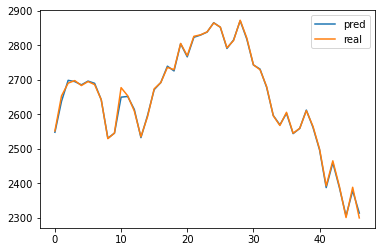

In [43]:
bmodel = TransformerTimeSeries(feature_dim = feature_dim,
                                  nhead = 4,num_layers = 12,d_model = 512,
                                  conv_len = 5,feature_weight = True,embedding_weight = True)
bmodel.load_state_dict(torch.load('GOOG_C'))
bmodel.to(device)
bmodel.eval()
with torch.no_grad(): # eliminate gradient i.e. gradients only exists in train()

    for step,(x,y,feature,attention_masks) in enumerate(test_dl):
        x = x.to(device)
        y = y.to(device)
        feature = feature.to(device)
        attention_masks = attention_masks.to(device)
        output = bmodel(x,y,feature,attention_masks[0])
        
        
        pred = data[train_size + 1 :-1,3]*0.01*(100+output[:,t0:].squeeze()).detach().cpu()
        real = data[train_size + 1 :-1,3]*0.01*(100+y[:,t0:].squeeze()).detach().cpu()

        plt.plot(pred)
        plt.plot(real)
        plt.legend(['pred','real'])
        MAE = torch.nn.L1Loss()(pred,real).item()
        MSE = torch.nn.MSELoss()(pred,real).item()
        RMSE = np.sqrt(MSE)
        
        print(f'GOOG MAE is {MAE}')
        print(f'GOOG MSE is {MSE}')
        print(f'GOOG RMSE is {RMSE}')

#### 12 year AAPL

In [28]:
file_name = 'AAPL_12_features.csv'
with open(file_name) as f:
    data_list = csv.reader(f)
    data = []
    for row in data_list:
        data.append(row)
    f.close()
    
data = torch.tensor(np.delete(np.array(data)[1:,2:],4,axis = 1).astype(np.float)).type(torch.float)

feature_dim = data.shape[1] - 1
rate = []
for i in range(1,data.shape[0]):
    rate.append((100*(data[i,0:4] - data[i-1,0:4])/data[i-1,0:4]).reshape(1,4))
    
rate = torch.cat(rate)
rate_data = torch.cat([rate,data[1:,4:]],1)
train_size = int(data.shape[0]*0.9)
data_train = rate_data[0:train_size]
data_test = rate_data[train_size-4:]


t0 = 5
to_predict = 1
train_dataset = GetData(data_train[:,3],torch.cat([data_train[:,0:3],data_train[:,4:]],1),t0 = t0, to_predict = to_predict)
test_dataset = GetData(data_test[:,3],torch.cat([data_test[:,0:3],data_test[:,4:]],1),t0 = t0, to_predict = to_predict)
criterion = torch.nn.MSELoss()
# dataloaders
train_dl = DataLoader(train_dataset,batch_size=256,shuffle=True)
test_dl = DataLoader(test_dataset,batch_size=512)





model = TransformerTimeSeries(feature_dim = feature_dim,
                              nhead = 4,num_layers = 12,d_model = 512,
                              conv_len = 5,feature_weight = True,embedding_weight = True)
model = model.to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=1e-5 ,momentum = 0.9, nesterov = True)#Adam optimizer
#scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer,5e-7,3e-5,10,mode = 'exp_range',gamma = 0.9996)



train_epoch_loss = []
test_epoch_loss = []
test_best = 9999
for epoch in tqdm(range(4000)):


    l_t = train_epoch(model,train_dl,optimizer,t0,to_predict)

    train_loss = test_epoch(model,train_dl,t0,to_predict)


    test_loss = test_epoch(model,test_dl,t0,to_predict)


    if test_best > test_loss:
        test_best = test_loss
        torch.save(model.state_dict(), 'AAPL_12y')



    train_epoch_loss.append(np.mean(train_loss))
    test_epoch_loss.append(test_loss)

    print("Epoch {}: Train loss: {} \t test loss: {}".format(epoch+1,
                                                             np.mean(train_loss),
                                                             test_loss))
    #scheduler.step()



torch.Size([2771, 6])
torch.Size([2771, 6])
torch.Size([307, 6])
torch.Size([307, 6])


  0%|                                                                                     | 0/4000 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1944: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
  0%|                                                                           | 1/4000 [00:01<1:50:26,  1.66s/it]

Epoch 1: Train loss: 1.2353568692708092 	 test loss: 1.2810944318771362


  0%|                                                                           | 2/4000 [00:02<1:17:43,  1.17s/it]

Epoch 2: Train loss: 1.244838569621152 	 test loss: 1.2918051481246948


  0%|                                                                           | 3/4000 [00:04<1:32:54,  1.39s/it]

Epoch 3: Train loss: 1.2340184842064594 	 test loss: 1.2795003652572632


  0%|                                                                           | 4/4000 [00:05<1:36:56,  1.46s/it]

Epoch 4: Train loss: 1.2317350746190578 	 test loss: 1.2775059938430786


  0%|                                                                           | 5/4000 [00:07<1:40:11,  1.50s/it]

Epoch 5: Train loss: 1.2312149957214955 	 test loss: 1.2766388654708862


  0%|                                                                           | 6/4000 [00:08<1:42:37,  1.54s/it]

Epoch 6: Train loss: 1.2302621140543712 	 test loss: 1.2755497694015503


  0%|▏                                                                          | 7/4000 [00:10<1:43:23,  1.55s/it]

Epoch 7: Train loss: 1.2284857575018369 	 test loss: 1.2737752199172974


  0%|▏                                                                          | 8/4000 [00:12<1:45:19,  1.58s/it]

Epoch 8: Train loss: 1.2263960362943405 	 test loss: 1.2717710733413696


  0%|▏                                                                          | 9/4000 [00:13<1:46:17,  1.60s/it]

Epoch 9: Train loss: 1.224472212946316 	 test loss: 1.269921898841858


  0%|▏                                                                         | 10/4000 [00:15<1:46:37,  1.60s/it]

Epoch 10: Train loss: 1.223644899702468 	 test loss: 1.2687534093856812


  0%|▏                                                                         | 11/4000 [00:16<1:46:12,  1.60s/it]

Epoch 11: Train loss: 1.2208537407103792 	 test loss: 1.2664337158203125


  0%|▏                                                                         | 12/4000 [00:18<1:46:40,  1.60s/it]

Epoch 12: Train loss: 1.2190159924922546 	 test loss: 1.2645690441131592


  0%|▏                                                                         | 13/4000 [00:20<1:45:22,  1.59s/it]

Epoch 13: Train loss: 1.217584543820109 	 test loss: 1.2627540826797485


  0%|▎                                                                         | 14/4000 [00:21<1:44:41,  1.58s/it]

Epoch 14: Train loss: 1.216062223554217 	 test loss: 1.2608416080474854


  0%|▎                                                                         | 15/4000 [00:23<1:44:14,  1.57s/it]

Epoch 15: Train loss: 1.2124118533043258 	 test loss: 1.2577857971191406


  0%|▎                                                                         | 16/4000 [00:24<1:44:15,  1.57s/it]

Epoch 16: Train loss: 1.2105148606505132 	 test loss: 1.2556849718093872


  0%|▎                                                                         | 17/4000 [00:26<1:44:19,  1.57s/it]

Epoch 17: Train loss: 1.2082849213122806 	 test loss: 1.2532868385314941


  0%|▎                                                                         | 18/4000 [00:27<1:45:18,  1.59s/it]

Epoch 18: Train loss: 1.2049417061652572 	 test loss: 1.2502381801605225


  0%|▎                                                                         | 19/4000 [00:29<1:45:37,  1.59s/it]

Epoch 19: Train loss: 1.2040562480849422 	 test loss: 1.2484679222106934


  0%|▎                                                                         | 20/4000 [00:31<1:46:17,  1.60s/it]

Epoch 20: Train loss: 1.1991904249951884 	 test loss: 1.2443734407424927


  1%|▍                                                                         | 21/4000 [00:32<1:45:54,  1.60s/it]

Epoch 21: Train loss: 1.1973154926850709 	 test loss: 1.2417585849761963


  1%|▍                                                                         | 22/4000 [00:34<1:44:53,  1.58s/it]

Epoch 22: Train loss: 1.1931079761597363 	 test loss: 1.2379366159439087


  1%|▍                                                                         | 23/4000 [00:35<1:45:17,  1.59s/it]

Epoch 23: Train loss: 1.188951555721513 	 test loss: 1.2336260080337524


  1%|▍                                                                         | 24/4000 [00:37<1:45:25,  1.59s/it]

Epoch 24: Train loss: 1.1845376929493425 	 test loss: 1.2290984392166138


  1%|▍                                                                         | 25/4000 [00:39<1:45:48,  1.60s/it]

Epoch 25: Train loss: 1.1796503474418973 	 test loss: 1.224105715751648


  1%|▍                                                                         | 26/4000 [00:40<1:46:15,  1.60s/it]

Epoch 26: Train loss: 1.17526932706561 	 test loss: 1.219722032546997


  1%|▍                                                                         | 27/4000 [00:42<1:46:08,  1.60s/it]

Epoch 27: Train loss: 1.1695607185621892 	 test loss: 1.2139644622802734


  1%|▌                                                                         | 28/4000 [00:44<1:46:32,  1.61s/it]

Epoch 28: Train loss: 1.1641973038521625 	 test loss: 1.2086338996887207


  1%|▌                                                                         | 29/4000 [00:45<1:46:08,  1.60s/it]

Epoch 29: Train loss: 1.1578836987398025 	 test loss: 1.2022788524627686


  1%|▌                                                                         | 30/4000 [00:47<1:45:40,  1.60s/it]

Epoch 30: Train loss: 1.1523293095433467 	 test loss: 1.196811556816101


  1%|▌                                                                         | 31/4000 [00:48<1:45:57,  1.60s/it]

Epoch 31: Train loss: 1.1440530917740006 	 test loss: 1.1882351636886597


  1%|▌                                                                         | 32/4000 [00:50<1:45:49,  1.60s/it]

Epoch 32: Train loss: 1.1359810346044474 	 test loss: 1.1806988716125488


  1%|▌                                                                         | 33/4000 [00:51<1:44:31,  1.58s/it]

Epoch 33: Train loss: 1.1249490013108792 	 test loss: 1.1692249774932861


  1%|▋                                                                         | 34/4000 [00:53<1:44:16,  1.58s/it]

Epoch 34: Train loss: 1.113852908705082 	 test loss: 1.158440113067627


  1%|▋                                                                         | 35/4000 [00:55<1:43:47,  1.57s/it]

Epoch 35: Train loss: 1.1046636964990015 	 test loss: 1.149718165397644


  1%|▋                                                                         | 36/4000 [00:56<1:43:48,  1.57s/it]

Epoch 36: Train loss: 1.091014742808237 	 test loss: 1.1363078355789185


  1%|▋                                                                         | 37/4000 [00:58<1:43:19,  1.56s/it]

Epoch 37: Train loss: 1.0789800904064737 	 test loss: 1.1243858337402344


  1%|▋                                                                         | 38/4000 [00:59<1:43:10,  1.56s/it]

Epoch 38: Train loss: 1.0581884453417978 	 test loss: 1.1026946306228638


  1%|▋                                                                         | 39/4000 [01:01<1:43:15,  1.56s/it]

Epoch 39: Train loss: 1.046701301137965 	 test loss: 1.0933133363723755


  1%|▋                                                                         | 40/4000 [01:02<1:43:00,  1.56s/it]

Epoch 40: Train loss: 1.0209576708020307 	 test loss: 1.066239356994629


  1%|▊                                                                         | 41/4000 [01:04<1:44:20,  1.58s/it]

Epoch 41: Train loss: 0.9992042538578525 	 test loss: 1.0445092916488647


  1%|▊                                                                         | 42/4000 [01:06<1:45:11,  1.59s/it]

Epoch 42: Train loss: 0.9733684027466005 	 test loss: 1.0190790891647339


  1%|▊                                                                         | 43/4000 [01:07<1:44:53,  1.59s/it]

Epoch 43: Train loss: 0.9522547009231295 	 test loss: 0.9993484616279602


  1%|▊                                                                         | 44/4000 [01:09<1:44:34,  1.59s/it]

Epoch 44: Train loss: 0.9154133763781355 	 test loss: 0.9606700539588928


  1%|▊                                                                         | 45/4000 [01:10<1:45:19,  1.60s/it]

Epoch 45: Train loss: 0.8835784328495798 	 test loss: 0.9288045167922974


  1%|▊                                                                         | 46/4000 [01:12<1:44:19,  1.58s/it]

Epoch 46: Train loss: 0.8576476931227798 	 test loss: 0.8976655602455139


  1%|▊                                                                         | 47/4000 [01:13<1:43:36,  1.57s/it]

Epoch 47: Train loss: 0.8308825401870923 	 test loss: 0.862819492816925


  1%|▉                                                                         | 48/4000 [01:15<1:43:20,  1.57s/it]

Epoch 48: Train loss: 0.7863427242704437 	 test loss: 0.8269598484039307


  1%|▉                                                                         | 49/4000 [01:17<1:43:02,  1.56s/it]

Epoch 49: Train loss: 0.7677307378639172 	 test loss: 0.7931820154190063


  1%|▉                                                                         | 50/4000 [01:18<1:42:55,  1.56s/it]

Epoch 50: Train loss: 0.7297040068771985 	 test loss: 0.7569760680198669


  1%|▉                                                                         | 51/4000 [01:20<1:43:39,  1.58s/it]

Epoch 51: Train loss: 0.6995335468872494 	 test loss: 0.7239155173301697


  1%|▉                                                                         | 52/4000 [01:21<1:44:10,  1.58s/it]

Epoch 52: Train loss: 0.6670248340459044 	 test loss: 0.6903420090675354


  1%|▉                                                                         | 53/4000 [01:23<1:44:14,  1.58s/it]

Epoch 53: Train loss: 0.6465378942708168 	 test loss: 0.6647904515266418


  1%|▉                                                                         | 54/4000 [01:25<1:43:32,  1.57s/it]

Epoch 54: Train loss: 0.6353128006293944 	 test loss: 0.6443618535995483


  1%|█                                                                         | 55/4000 [01:26<1:43:17,  1.57s/it]

Epoch 55: Train loss: 0.5937785184671629 	 test loss: 0.6017518043518066


  1%|█                                                                         | 56/4000 [01:28<1:43:21,  1.57s/it]

Epoch 56: Train loss: 0.5772792336872793 	 test loss: 0.5744946599006653


  1%|█                                                                         | 57/4000 [01:29<1:42:44,  1.56s/it]

Epoch 57: Train loss: 0.5259409102882473 	 test loss: 0.5240709781646729


  1%|█                                                                         | 58/4000 [01:31<1:42:44,  1.56s/it]

Epoch 58: Train loss: 0.5243419035381894 	 test loss: 0.5112696290016174


  1%|█                                                                         | 59/4000 [01:32<1:42:37,  1.56s/it]

Epoch 59: Train loss: 0.5190968470898659 	 test loss: 0.4989357888698578


  2%|█                                                                         | 60/4000 [01:34<1:42:59,  1.57s/it]

Epoch 60: Train loss: 0.4806007062623063 	 test loss: 0.4593690037727356


  2%|█▏                                                                        | 61/4000 [01:35<1:42:19,  1.56s/it]

Epoch 61: Train loss: 0.4298935232180544 	 test loss: 0.41141483187675476


  2%|█▏                                                                        | 62/4000 [01:36<1:27:48,  1.34s/it]

Epoch 62: Train loss: 0.4673532385853644 	 test loss: 0.4364621937274933


  2%|█▏                                                                        | 63/4000 [01:37<1:17:36,  1.18s/it]

Epoch 63: Train loss: 0.44537664754689277 	 test loss: 0.4138961434364319


  2%|█▏                                                                        | 64/4000 [01:39<1:24:30,  1.29s/it]

Epoch 64: Train loss: 0.40459305089933695 	 test loss: 0.37475675344467163


  2%|█▏                                                                        | 65/4000 [01:39<1:15:19,  1.15s/it]

Epoch 65: Train loss: 0.4162522278852473 	 test loss: 0.381838321685791


  2%|█▏                                                                        | 66/4000 [01:40<1:08:51,  1.05s/it]

Epoch 66: Train loss: 0.42312784084814287 	 test loss: 0.38625583052635193


  2%|█▏                                                                        | 67/4000 [01:42<1:19:59,  1.22s/it]

Epoch 67: Train loss: 0.3632905086706107 	 test loss: 0.327935129404068


  2%|█▎                                                                        | 68/4000 [01:43<1:26:15,  1.32s/it]

Epoch 68: Train loss: 0.35510333899297 	 test loss: 0.3191708028316498


  2%|█▎                                                                        | 69/4000 [01:45<1:30:54,  1.39s/it]

Epoch 69: Train loss: 0.34658476090827 	 test loss: 0.30990496277809143


  2%|█▎                                                                        | 70/4000 [01:46<1:19:47,  1.22s/it]

Epoch 70: Train loss: 0.3628942492699976 	 test loss: 0.32442939281463623


  2%|█▎                                                                        | 71/4000 [01:47<1:11:58,  1.10s/it]

Epoch 71: Train loss: 0.35776861237300855 	 test loss: 0.3194001019001007


  2%|█▎                                                                        | 72/4000 [01:48<1:21:11,  1.24s/it]

Epoch 72: Train loss: 0.33657146094938944 	 test loss: 0.29818540811538696


  2%|█▎                                                                        | 73/4000 [01:49<1:12:59,  1.12s/it]

Epoch 73: Train loss: 0.3458587847561322 	 test loss: 0.30759334564208984


  2%|█▎                                                                        | 74/4000 [01:50<1:07:10,  1.03s/it]

Epoch 74: Train loss: 0.33989355560675805 	 test loss: 0.3014596402645111


  2%|█▍                                                                        | 75/4000 [01:51<1:18:47,  1.20s/it]

Epoch 75: Train loss: 0.3343881689461075 	 test loss: 0.29652512073516846


  2%|█▍                                                                        | 76/4000 [01:53<1:27:00,  1.33s/it]

Epoch 76: Train loss: 0.32431487335232956 	 test loss: 0.28672999143600464


  2%|█▍                                                                        | 77/4000 [01:55<1:32:47,  1.42s/it]

Epoch 77: Train loss: 0.3230853130975728 	 test loss: 0.2854918837547302


  2%|█▍                                                                        | 78/4000 [01:56<1:21:02,  1.24s/it]

Epoch 78: Train loss: 0.329470849389937 	 test loss: 0.2895655930042267


  2%|█▍                                                                        | 79/4000 [01:57<1:28:36,  1.36s/it]

Epoch 79: Train loss: 0.3195029827219964 	 test loss: 0.27998748421669006


  2%|█▍                                                                        | 80/4000 [01:59<1:33:28,  1.43s/it]

Epoch 80: Train loss: 0.3108519790663869 	 test loss: 0.2709912657737732


  2%|█▍                                                                        | 81/4000 [02:00<1:21:33,  1.25s/it]

Epoch 81: Train loss: 0.31462980821346903 	 test loss: 0.27792173624038696


  2%|█▌                                                                        | 82/4000 [02:00<1:13:10,  1.12s/it]

Epoch 82: Train loss: 0.3325852497374267 	 test loss: 0.29945048689842224


  2%|█▌                                                                        | 83/4000 [02:02<1:22:10,  1.26s/it]

Epoch 83: Train loss: 0.2971862494214181 	 test loss: 0.2577667832374573


  2%|█▌                                                                        | 84/4000 [02:03<1:14:18,  1.14s/it]

Epoch 84: Train loss: 0.37663203159509173 	 test loss: 0.3473983705043793


  2%|█▌                                                                        | 85/4000 [02:04<1:08:05,  1.04s/it]

Epoch 85: Train loss: 0.3263323909536848 	 test loss: 0.2947773337364197


  2%|█▌                                                                        | 86/4000 [02:05<1:18:22,  1.20s/it]

Epoch 86: Train loss: 0.2886370113721095 	 test loss: 0.2429048717021942


  2%|█▌                                                                        | 87/4000 [02:06<1:10:59,  1.09s/it]

Epoch 87: Train loss: 0.31138734767386217 	 test loss: 0.2800652086734772


  2%|█▋                                                                        | 88/4000 [02:07<1:05:44,  1.01s/it]

Epoch 88: Train loss: 0.2992211279241843 	 test loss: 0.26195916533470154


  2%|█▋                                                                        | 89/4000 [02:08<1:02:05,  1.05it/s]

Epoch 89: Train loss: 0.30734078715700225 	 test loss: 0.27629172801971436


  2%|█▋                                                                          | 90/4000 [02:09<59:31,  1.09it/s]

Epoch 90: Train loss: 0.3024766734686624 	 test loss: 0.2718404233455658


  2%|█▋                                                                          | 91/4000 [02:09<57:45,  1.13it/s]

Epoch 91: Train loss: 0.33264220320158855 	 test loss: 0.3065437078475952


  2%|█▋                                                                          | 92/4000 [02:10<56:31,  1.15it/s]

Epoch 92: Train loss: 0.3044633770711755 	 test loss: 0.27574920654296875


  2%|█▊                                                                          | 93/4000 [02:11<55:44,  1.17it/s]

Epoch 93: Train loss: 0.3041269003979267 	 test loss: 0.27235302329063416


  2%|█▊                                                                          | 94/4000 [02:12<55:05,  1.18it/s]

Epoch 94: Train loss: 0.2996097166092548 	 test loss: 0.2707839906215668


  2%|█▊                                                                          | 95/4000 [02:13<54:36,  1.19it/s]

Epoch 95: Train loss: 0.28359625884575435 	 test loss: 0.24892482161521912


  2%|█▊                                                                          | 96/4000 [02:13<54:15,  1.20it/s]

Epoch 96: Train loss: 0.2939230674055672 	 test loss: 0.2648412883281708


  2%|█▊                                                                          | 97/4000 [02:14<54:02,  1.20it/s]

Epoch 97: Train loss: 0.2799920251291179 	 test loss: 0.24523280560970306


  2%|█▊                                                                        | 98/4000 [02:16<1:08:26,  1.05s/it]

Epoch 98: Train loss: 0.2730326566916431 	 test loss: 0.23094633221626282


  2%|█▊                                                                        | 99/4000 [02:17<1:03:58,  1.02it/s]

Epoch 99: Train loss: 0.28438038441602265 	 test loss: 0.2519652843475342


  2%|█▊                                                                       | 100/4000 [02:18<1:15:15,  1.16s/it]

Epoch 100: Train loss: 0.2671630966538602 	 test loss: 0.23007991909980774


  3%|█▊                                                                       | 101/4000 [02:19<1:09:47,  1.07s/it]

Epoch 101: Train loss: 0.28144835091076015 	 test loss: 0.2524237632751465


  3%|█▊                                                                       | 102/4000 [02:20<1:04:50,  1.00it/s]

Epoch 102: Train loss: 0.28259645661091126 	 test loss: 0.2550887167453766


  3%|█▉                                                                       | 103/4000 [02:21<1:01:22,  1.06it/s]

Epoch 103: Train loss: 0.290466236900397 	 test loss: 0.265154093503952


  3%|█▉                                                                       | 104/4000 [02:22<1:13:33,  1.13s/it]

Epoch 104: Train loss: 0.2665283058641276 	 test loss: 0.226698100566864


  3%|█▉                                                                       | 105/4000 [02:23<1:07:32,  1.04s/it]

Epoch 105: Train loss: 0.2747331502978787 	 test loss: 0.24395708739757538


  3%|█▉                                                                       | 106/4000 [02:24<1:03:16,  1.03it/s]

Epoch 106: Train loss: 0.26927890473434274 	 test loss: 0.23216815292835236


  3%|█▉                                                                       | 107/4000 [02:25<1:00:17,  1.08it/s]

Epoch 107: Train loss: 0.2616626063932455 	 test loss: 0.23035089671611786


  3%|██                                                                         | 108/4000 [02:26<58:11,  1.11it/s]

Epoch 108: Train loss: 0.2759045595319983 	 test loss: 0.2475861757993698


  3%|██                                                                         | 109/4000 [02:26<56:42,  1.14it/s]

Epoch 109: Train loss: 0.26589258097432145 	 test loss: 0.23671507835388184


  3%|██                                                                         | 110/4000 [02:27<55:39,  1.16it/s]

Epoch 110: Train loss: 0.27058007860390215 	 test loss: 0.2453898787498474


  3%|██                                                                         | 111/4000 [02:28<54:58,  1.18it/s]

Epoch 111: Train loss: 0.25919501094644315 	 test loss: 0.22681985795497894


  3%|██                                                                         | 112/4000 [02:29<54:30,  1.19it/s]

Epoch 112: Train loss: 0.26754040441242893 	 test loss: 0.2418743371963501


  3%|██                                                                         | 113/4000 [02:30<54:10,  1.20it/s]

Epoch 113: Train loss: 0.26809139905725304 	 test loss: 0.24499869346618652


  3%|██                                                                       | 114/4000 [02:31<1:08:32,  1.06s/it]

Epoch 114: Train loss: 0.2577649599290075 	 test loss: 0.2225016951560974


  3%|██                                                                       | 115/4000 [02:32<1:04:03,  1.01it/s]

Epoch 115: Train loss: 0.26410376143687814 	 test loss: 0.23736874759197235


  3%|██                                                                       | 116/4000 [02:33<1:00:49,  1.06it/s]

Epoch 116: Train loss: 0.2557264240273755 	 test loss: 0.22373616695404053


  3%|██▏                                                                      | 117/4000 [02:35<1:13:05,  1.13s/it]

Epoch 117: Train loss: 0.25128887927691373 	 test loss: 0.22165776789188385


  3%|██▏                                                                      | 118/4000 [02:35<1:07:11,  1.04s/it]

Epoch 118: Train loss: 0.2593114218237339 	 test loss: 0.2327805459499359


  3%|██▏                                                                      | 119/4000 [02:36<1:03:01,  1.03it/s]

Epoch 119: Train loss: 0.2590445140581706 	 test loss: 0.23422499001026154


  3%|██▏                                                                      | 120/4000 [02:37<1:00:05,  1.08it/s]

Epoch 120: Train loss: 0.25704588526769134 	 test loss: 0.22936104238033295


  3%|██▎                                                                        | 121/4000 [02:38<58:02,  1.11it/s]

Epoch 121: Train loss: 0.2602854623600104 	 test loss: 0.23699036240577698


  3%|██▏                                                                      | 122/4000 [02:39<1:10:59,  1.10s/it]

Epoch 122: Train loss: 0.24320067468531853 	 test loss: 0.2149886190891266


  3%|██▏                                                                      | 123/4000 [02:40<1:05:41,  1.02s/it]

Epoch 123: Train loss: 0.25971482957110686 	 test loss: 0.23697897791862488


  3%|██▎                                                                      | 124/4000 [02:41<1:01:54,  1.04it/s]

Epoch 124: Train loss: 0.25244059349947656 	 test loss: 0.22895409166812897


  3%|██▎                                                                        | 125/4000 [02:42<59:16,  1.09it/s]

Epoch 125: Train loss: 0.24270086954621709 	 test loss: 0.21668840944766998


  3%|██▎                                                                      | 126/4000 [02:43<1:12:54,  1.13s/it]

Epoch 126: Train loss: 0.24182219789889434 	 test loss: 0.21473564207553864


  3%|██▎                                                                      | 127/4000 [02:44<1:06:58,  1.04s/it]

Epoch 127: Train loss: 0.2540475987798683 	 test loss: 0.23285672068595886


  3%|██▎                                                                      | 128/4000 [02:45<1:02:48,  1.03it/s]

Epoch 128: Train loss: 0.24407928995989756 	 test loss: 0.21973614394664764


  3%|██▎                                                                      | 129/4000 [02:47<1:14:18,  1.15s/it]

Epoch 129: Train loss: 0.23588394912215874 	 test loss: 0.20748205482959747


  3%|██▎                                                                      | 130/4000 [02:48<1:07:57,  1.05s/it]

Epoch 130: Train loss: 0.2423149024760495 	 test loss: 0.21955865621566772


  3%|██▍                                                                      | 131/4000 [02:49<1:18:02,  1.21s/it]

Epoch 131: Train loss: 0.23067899806561432 	 test loss: 0.20499110221862793


  3%|██▍                                                                      | 132/4000 [02:50<1:10:35,  1.09s/it]

Epoch 132: Train loss: 0.2481236946965675 	 test loss: 0.2258223593235016


  3%|██▍                                                                      | 133/4000 [02:51<1:05:19,  1.01s/it]

Epoch 133: Train loss: 0.24274295817984007 	 test loss: 0.21969768404960632


  3%|██▍                                                                      | 134/4000 [02:52<1:16:23,  1.19s/it]

Epoch 134: Train loss: 0.2264875084624227 	 test loss: 0.20179098844528198


  3%|██▍                                                                      | 135/4000 [02:53<1:09:24,  1.08s/it]

Epoch 135: Train loss: 0.23942379296385222 	 test loss: 0.21871621906757355


  3%|██▍                                                                      | 136/4000 [02:54<1:04:27,  1.00s/it]

Epoch 136: Train loss: 0.2409941088105745 	 test loss: 0.21916189789772034


  3%|██▌                                                                      | 137/4000 [02:55<1:01:00,  1.06it/s]

Epoch 137: Train loss: 0.24270275578800843 	 test loss: 0.22293028235435486


  3%|██▌                                                                      | 138/4000 [02:56<1:12:55,  1.13s/it]

Epoch 138: Train loss: 0.22206908592417196 	 test loss: 0.19788241386413574


  3%|██▌                                                                      | 139/4000 [02:58<1:21:24,  1.27s/it]

Epoch 139: Train loss: 0.21508643476380548 	 test loss: 0.1916629523038864


  4%|██▌                                                                      | 140/4000 [02:59<1:12:51,  1.13s/it]

Epoch 140: Train loss: 0.21920760670150502 	 test loss: 0.19668185710906982


  4%|██▌                                                                      | 141/4000 [03:00<1:06:51,  1.04s/it]

Epoch 141: Train loss: 0.22828482912039336 	 test loss: 0.20509439706802368


  4%|██▌                                                                      | 142/4000 [03:00<1:02:40,  1.03it/s]

Epoch 142: Train loss: 0.2385157151251913 	 test loss: 0.2198251187801361


  4%|██▋                                                                        | 143/4000 [03:01<59:43,  1.08it/s]

Epoch 143: Train loss: 0.22261355709767178 	 test loss: 0.19984318315982819


  4%|██▋                                                                        | 144/4000 [03:02<57:41,  1.11it/s]

Epoch 144: Train loss: 0.22736468995060571 	 test loss: 0.2068546563386917


  4%|██▋                                                                        | 145/4000 [03:03<56:41,  1.13it/s]

Epoch 145: Train loss: 0.22747028938207933 	 test loss: 0.2050090730190277


  4%|██▋                                                                        | 146/4000 [03:04<55:34,  1.16it/s]

Epoch 146: Train loss: 0.2257581938317604 	 test loss: 0.2045593410730362


  4%|██▊                                                                        | 147/4000 [03:05<54:45,  1.17it/s]

Epoch 147: Train loss: 0.22155327325433397 	 test loss: 0.2006487399339676


  4%|██▊                                                                        | 148/4000 [03:05<54:11,  1.18it/s]

Epoch 148: Train loss: 0.22567411199970308 	 test loss: 0.20412234961986542


  4%|██▊                                                                        | 149/4000 [03:06<53:46,  1.19it/s]

Epoch 149: Train loss: 0.2204169837663166 	 test loss: 0.19690869748592377


  4%|██▊                                                                        | 150/4000 [03:07<53:30,  1.20it/s]

Epoch 150: Train loss: 0.21433460493567014 	 test loss: 0.19235557317733765


  4%|██▊                                                                      | 151/4000 [03:09<1:07:13,  1.05s/it]

Epoch 151: Train loss: 0.20907981355497443 	 test loss: 0.18892034888267517


  4%|██▊                                                                      | 152/4000 [03:09<1:03:58,  1.00it/s]

Epoch 152: Train loss: 0.2217421224297104 	 test loss: 0.20198626816272736


  4%|██▊                                                                      | 153/4000 [03:10<1:00:35,  1.06it/s]

Epoch 153: Train loss: 0.21939759173147172 	 test loss: 0.2009793221950531


  4%|██▊                                                                      | 154/4000 [03:12<1:13:35,  1.15s/it]

Epoch 154: Train loss: 0.21245491711166695 	 test loss: 0.18795379996299744


  4%|██▊                                                                      | 155/4000 [03:13<1:07:23,  1.05s/it]

Epoch 155: Train loss: 0.22300209844426444 	 test loss: 0.20574313402175903


  4%|██▊                                                                      | 156/4000 [03:14<1:03:00,  1.02it/s]

Epoch 156: Train loss: 0.22181809701372338 	 test loss: 0.20459145307540894


  4%|██▉                                                                        | 157/4000 [03:14<59:56,  1.07it/s]

Epoch 157: Train loss: 0.20905552041935 	 test loss: 0.18831153213977814


  4%|██▉                                                                        | 158/4000 [03:15<57:47,  1.11it/s]

Epoch 158: Train loss: 0.2185261694910035 	 test loss: 0.2030210644006729


  4%|██▉                                                                      | 159/4000 [03:17<1:10:37,  1.10s/it]

Epoch 159: Train loss: 0.20382981906832878 	 test loss: 0.18488317728042603


  4%|██▉                                                                      | 160/4000 [03:18<1:05:16,  1.02s/it]

Epoch 160: Train loss: 0.2083211307521763 	 test loss: 0.18961825966835022


  4%|██▉                                                                      | 161/4000 [03:18<1:01:30,  1.04it/s]

Epoch 161: Train loss: 0.20769742481311018 	 test loss: 0.18799525499343872


  4%|███                                                                        | 162/4000 [03:19<58:52,  1.09it/s]

Epoch 162: Train loss: 0.2128391142293289 	 test loss: 0.19536380469799042


  4%|███                                                                        | 163/4000 [03:20<57:01,  1.12it/s]

Epoch 163: Train loss: 0.22175217780964507 	 test loss: 0.2065909057855606


  4%|███                                                                        | 164/4000 [03:21<55:43,  1.15it/s]

Epoch 164: Train loss: 0.21343329672519157 	 test loss: 0.19548705220222473


  4%|███                                                                      | 165/4000 [03:23<1:09:35,  1.09s/it]

Epoch 165: Train loss: 0.2020702777314126 	 test loss: 0.18223242461681366


  4%|███                                                                      | 166/4000 [03:23<1:04:30,  1.01s/it]

Epoch 166: Train loss: 0.20241850539799935 	 test loss: 0.1881333291530609


  4%|███                                                                      | 167/4000 [03:24<1:00:54,  1.05it/s]

Epoch 167: Train loss: 0.20291944891913452 	 test loss: 0.18508534133434296


  4%|███▏                                                                       | 168/4000 [03:25<58:22,  1.09it/s]

Epoch 168: Train loss: 0.20585379517495697 	 test loss: 0.18660569190979004


  4%|███▏                                                                       | 169/4000 [03:26<56:36,  1.13it/s]

Epoch 169: Train loss: 0.20961152601117305 	 test loss: 0.19505451619625092


  4%|███▏                                                                       | 170/4000 [03:27<55:22,  1.15it/s]

Epoch 170: Train loss: 0.201644598733256 	 test loss: 0.18570095300674438


  4%|███▏                                                                       | 171/4000 [03:27<54:31,  1.17it/s]

Epoch 171: Train loss: 0.2010997840371729 	 test loss: 0.18528610467910767


  4%|███▏                                                                       | 172/4000 [03:28<53:55,  1.18it/s]

Epoch 172: Train loss: 0.20059348743386063 	 test loss: 0.18413890898227692


  4%|███▏                                                                       | 173/4000 [03:29<53:31,  1.19it/s]

Epoch 173: Train loss: 0.20266837516724956 	 test loss: 0.18835820257663727


  4%|███▎                                                                       | 174/4000 [03:30<53:14,  1.20it/s]

Epoch 174: Train loss: 0.20836244614943406 	 test loss: 0.19493024051189423


  4%|███▏                                                                     | 175/4000 [03:31<1:07:27,  1.06s/it]

Epoch 175: Train loss: 0.1881309812817923 	 test loss: 0.17074710130691528


  4%|███▏                                                                     | 176/4000 [03:32<1:03:00,  1.01it/s]

Epoch 176: Train loss: 0.20218065771459456 	 test loss: 0.18151235580444336


  4%|███▎                                                                       | 177/4000 [03:33<59:51,  1.06it/s]

Epoch 177: Train loss: 0.19193309712220682 	 test loss: 0.176594078540802


  4%|███▎                                                                       | 178/4000 [03:34<58:42,  1.09it/s]

Epoch 178: Train loss: 0.19888094487021607 	 test loss: 0.1850941926240921


  4%|███▎                                                                       | 179/4000 [03:35<56:49,  1.12it/s]

Epoch 179: Train loss: 0.19648338672014318 	 test loss: 0.1810687929391861


  4%|███▍                                                                       | 180/4000 [03:36<55:30,  1.15it/s]

Epoch 180: Train loss: 0.19350691623138805 	 test loss: 0.17729225754737854


  5%|███▎                                                                     | 181/4000 [03:37<1:09:49,  1.10s/it]

Epoch 181: Train loss: 0.18348655826840665 	 test loss: 0.16513152420520782


  5%|███▎                                                                     | 182/4000 [03:38<1:04:36,  1.02s/it]

Epoch 182: Train loss: 0.20896514910345515 	 test loss: 0.19728736579418182


  5%|███▎                                                                     | 183/4000 [03:39<1:00:54,  1.04it/s]

Epoch 183: Train loss: 0.19244573980795696 	 test loss: 0.17654234170913696


  5%|███▍                                                                       | 184/4000 [03:40<58:19,  1.09it/s]

Epoch 184: Train loss: 0.1938160393791739 	 test loss: 0.1801917999982834


  5%|███▍                                                                       | 185/4000 [03:41<56:34,  1.12it/s]

Epoch 185: Train loss: 0.19340856134547346 	 test loss: 0.1797620803117752


  5%|███▍                                                                       | 186/4000 [03:41<55:19,  1.15it/s]

Epoch 186: Train loss: 0.19766544006181425 	 test loss: 0.185728058218956


  5%|███▌                                                                       | 187/4000 [03:42<54:26,  1.17it/s]

Epoch 187: Train loss: 0.19168805075827508 	 test loss: 0.17822180688381195


  5%|███▌                                                                       | 188/4000 [03:43<53:47,  1.18it/s]

Epoch 188: Train loss: 0.18751704756833293 	 test loss: 0.173956498503685


  5%|███▌                                                                       | 189/4000 [03:44<53:20,  1.19it/s]

Epoch 189: Train loss: 0.1878455441992277 	 test loss: 0.17310981452465057


  5%|███▌                                                                       | 190/4000 [03:45<53:03,  1.20it/s]

Epoch 190: Train loss: 0.1936901945127386 	 test loss: 0.18161773681640625


  5%|███▌                                                                       | 191/4000 [03:46<52:48,  1.20it/s]

Epoch 191: Train loss: 0.18666497248791908 	 test loss: 0.17468062043190002


  5%|███▌                                                                       | 192/4000 [03:46<52:38,  1.21it/s]

Epoch 192: Train loss: 0.18180081234839537 	 test loss: 0.1659165322780609


  5%|███▌                                                                       | 193/4000 [03:47<52:31,  1.21it/s]

Epoch 193: Train loss: 0.18318808770317413 	 test loss: 0.17175205051898956


  5%|███▌                                                                     | 194/4000 [03:49<1:06:34,  1.05s/it]

Epoch 194: Train loss: 0.17694940728020125 	 test loss: 0.1634061634540558


  5%|███▌                                                                     | 195/4000 [03:50<1:02:17,  1.02it/s]

Epoch 195: Train loss: 0.19137930096766012 	 test loss: 0.1813541203737259


  5%|███▋                                                                       | 196/4000 [03:50<59:15,  1.07it/s]

Epoch 196: Train loss: 0.18341108986678342 	 test loss: 0.16911964118480682


  5%|███▋                                                                       | 197/4000 [03:51<57:07,  1.11it/s]

Epoch 197: Train loss: 0.18695940260678928 	 test loss: 0.1766001284122467


  5%|███▋                                                                       | 198/4000 [03:52<55:40,  1.14it/s]

Epoch 198: Train loss: 0.18082129119622153 	 test loss: 0.1690090447664261


  5%|███▋                                                                       | 199/4000 [03:53<54:38,  1.16it/s]

Epoch 199: Train loss: 0.17457778408763125 	 test loss: 0.16347388923168182


  5%|███▊                                                                       | 200/4000 [03:54<53:52,  1.18it/s]

Epoch 200: Train loss: 0.18308952893323738 	 test loss: 0.17250889539718628


  5%|███▊                                                                       | 201/4000 [03:55<53:20,  1.19it/s]

Epoch 201: Train loss: 0.17871783460274968 	 test loss: 0.16442666947841644


  5%|███▋                                                                     | 202/4000 [03:56<1:07:02,  1.06s/it]

Epoch 202: Train loss: 0.1742875851403071 	 test loss: 0.16127562522888184


  5%|███▋                                                                     | 203/4000 [03:57<1:03:38,  1.01s/it]

Epoch 203: Train loss: 0.1765604967010103 	 test loss: 0.1654638648033142


  5%|███▋                                                                     | 204/4000 [03:58<1:00:11,  1.05it/s]

Epoch 204: Train loss: 0.1768100817134259 	 test loss: 0.16497188806533813


  5%|███▊                                                                       | 205/4000 [03:59<57:47,  1.09it/s]

Epoch 205: Train loss: 0.19534164452565703 	 test loss: 0.18684881925582886


  5%|███▊                                                                     | 206/4000 [04:00<1:10:11,  1.11s/it]

Epoch 206: Train loss: 0.17263585028989098 	 test loss: 0.15876471996307373


  5%|███▊                                                                     | 207/4000 [04:01<1:04:49,  1.03s/it]

Epoch 207: Train loss: 0.1789433683720103 	 test loss: 0.16789528727531433


  5%|███▊                                                                     | 208/4000 [04:03<1:14:33,  1.18s/it]

Epoch 208: Train loss: 0.16601084458810764 	 test loss: 0.15007437765598297


  5%|███▊                                                                     | 209/4000 [04:03<1:08:17,  1.08s/it]

Epoch 209: Train loss: 0.17012224119198274 	 test loss: 0.15891985595226288


  5%|███▊                                                                     | 210/4000 [04:04<1:03:26,  1.00s/it]

Epoch 210: Train loss: 0.17087146355889843 	 test loss: 0.1588006168603897


  5%|███▊                                                                     | 211/4000 [04:05<1:00:00,  1.05it/s]

Epoch 211: Train loss: 0.16880267177708783 	 test loss: 0.15577559173107147


  5%|███▉                                                                       | 212/4000 [04:06<57:34,  1.10it/s]

Epoch 212: Train loss: 0.170923936720877 	 test loss: 0.15983857214450836


  5%|███▉                                                                       | 213/4000 [04:07<55:53,  1.13it/s]

Epoch 213: Train loss: 0.17266960709867646 	 test loss: 0.16208700835704803


  5%|████                                                                       | 214/4000 [04:08<54:41,  1.15it/s]

Epoch 214: Train loss: 0.17057450677633543 	 test loss: 0.16075807809829712


  5%|████                                                                       | 215/4000 [04:08<53:49,  1.17it/s]

Epoch 215: Train loss: 0.1688303847587827 	 test loss: 0.15825529396533966


  5%|████                                                                       | 216/4000 [04:09<53:14,  1.18it/s]

Epoch 216: Train loss: 0.17844269501306828 	 test loss: 0.16994328796863556


  5%|████                                                                       | 217/4000 [04:10<52:50,  1.19it/s]

Epoch 217: Train loss: 0.1695516872593144 	 test loss: 0.1589326411485672


  5%|████                                                                       | 218/4000 [04:11<52:35,  1.20it/s]

Epoch 218: Train loss: 0.1735526623062518 	 test loss: 0.16457271575927734


  5%|████                                                                       | 219/4000 [04:12<52:31,  1.20it/s]

Epoch 219: Train loss: 0.17544449389368047 	 test loss: 0.1670544296503067


  6%|████                                                                     | 220/4000 [04:13<1:06:24,  1.05s/it]

Epoch 220: Train loss: 0.15934953173654082 	 test loss: 0.14810161292552948


  6%|████                                                                     | 221/4000 [04:14<1:02:05,  1.01it/s]

Epoch 221: Train loss: 0.15965987948982435 	 test loss: 0.14835134148597717


  6%|████▏                                                                      | 222/4000 [04:15<59:00,  1.07it/s]

Epoch 222: Train loss: 0.1752090946038851 	 test loss: 0.16784152388572693


  6%|████▏                                                                      | 223/4000 [04:16<56:50,  1.11it/s]

Epoch 223: Train loss: 0.17526884976060586 	 test loss: 0.16808518767356873


  6%|████▏                                                                      | 224/4000 [04:17<55:19,  1.14it/s]

Epoch 224: Train loss: 0.1787078599558114 	 test loss: 0.172157883644104


  6%|████                                                                     | 225/4000 [04:18<1:08:40,  1.09s/it]

Epoch 225: Train loss: 0.16089708023297575 	 test loss: 0.14800599217414856


  6%|████                                                                     | 226/4000 [04:19<1:03:39,  1.01s/it]

Epoch 226: Train loss: 0.17125767495218316 	 test loss: 0.16386395692825317


  6%|████▏                                                                    | 227/4000 [04:20<1:00:04,  1.05it/s]

Epoch 227: Train loss: 0.1768602606020693 	 test loss: 0.17021435499191284


  6%|████▎                                                                      | 228/4000 [04:21<57:33,  1.09it/s]

Epoch 228: Train loss: 0.15997680161821848 	 test loss: 0.15014757215976715


  6%|████▎                                                                      | 229/4000 [04:21<56:49,  1.11it/s]

Epoch 229: Train loss: 0.16338845416876607 	 test loss: 0.154608353972435


  6%|████▎                                                                      | 230/4000 [04:22<55:19,  1.14it/s]

Epoch 230: Train loss: 0.1655426608423428 	 test loss: 0.15772321820259094


  6%|████▎                                                                      | 231/4000 [04:23<54:13,  1.16it/s]

Epoch 231: Train loss: 0.1576536057529704 	 test loss: 0.14851099252700806


  6%|████▏                                                                    | 232/4000 [04:25<1:07:31,  1.08s/it]

Epoch 232: Train loss: 0.1513924677152145 	 test loss: 0.13888350129127502


  6%|████▎                                                                    | 233/4000 [04:25<1:02:47,  1.00s/it]

Epoch 233: Train loss: 0.16473432683269285 	 test loss: 0.15692657232284546


  6%|████▍                                                                      | 234/4000 [04:26<59:26,  1.06it/s]

Epoch 234: Train loss: 0.1561302213043308 	 test loss: 0.1455521583557129


  6%|████▍                                                                      | 235/4000 [04:27<57:04,  1.10it/s]

Epoch 235: Train loss: 0.15891879018851884 	 test loss: 0.1504112184047699


  6%|████▎                                                                    | 236/4000 [04:29<1:09:26,  1.11s/it]

Epoch 236: Train loss: 0.14593540467604194 	 test loss: 0.13195569813251495


  6%|████▎                                                                    | 237/4000 [04:30<1:04:07,  1.02s/it]

Epoch 237: Train loss: 0.16539763858476644 	 test loss: 0.15834671258926392


  6%|████▎                                                                    | 238/4000 [04:30<1:00:23,  1.04it/s]

Epoch 238: Train loss: 0.15502877939977788 	 test loss: 0.14541642367839813


  6%|████▍                                                                      | 239/4000 [04:31<57:46,  1.08it/s]

Epoch 239: Train loss: 0.16059007919660676 	 test loss: 0.1529930680990219


  6%|████▌                                                                      | 240/4000 [04:32<55:55,  1.12it/s]

Epoch 240: Train loss: 0.1620516302685839 	 test loss: 0.15512871742248535


  6%|████▌                                                                      | 241/4000 [04:33<54:36,  1.15it/s]

Epoch 241: Train loss: 0.15296351408988548 	 test loss: 0.14002396166324615


  6%|████▌                                                                      | 242/4000 [04:34<53:43,  1.17it/s]

Epoch 242: Train loss: 0.15104925649147177 	 test loss: 0.14208783209323883


  6%|████▌                                                                      | 243/4000 [04:34<53:04,  1.18it/s]

Epoch 243: Train loss: 0.1577750745285551 	 test loss: 0.14949952065944672


  6%|████▌                                                                      | 244/4000 [04:35<52:37,  1.19it/s]

Epoch 244: Train loss: 0.14727452151592954 	 test loss: 0.13604174554347992


  6%|████▌                                                                      | 245/4000 [04:36<52:16,  1.20it/s]

Epoch 245: Train loss: 0.1676010022101872 	 test loss: 0.16067862510681152


  6%|████▌                                                                      | 246/4000 [04:37<52:04,  1.20it/s]

Epoch 246: Train loss: 0.14755694700982414 	 test loss: 0.13614800572395325


  6%|████▋                                                                      | 247/4000 [04:38<51:53,  1.21it/s]

Epoch 247: Train loss: 0.15123493446743647 	 test loss: 0.14287452399730682


  6%|████▋                                                                      | 248/4000 [04:39<51:45,  1.21it/s]

Epoch 248: Train loss: 0.15730348652082848 	 test loss: 0.14833766222000122


  6%|████▋                                                                      | 249/4000 [04:39<51:38,  1.21it/s]

Epoch 249: Train loss: 0.15272346583676658 	 test loss: 0.1452663391828537


  6%|████▋                                                                      | 250/4000 [04:40<51:35,  1.21it/s]

Epoch 250: Train loss: 0.14641898425745645 	 test loss: 0.13779664039611816


  6%|████▋                                                                      | 251/4000 [04:41<51:31,  1.21it/s]

Epoch 251: Train loss: 0.14950465119216297 	 test loss: 0.14172379672527313


  6%|████▋                                                                      | 252/4000 [04:42<51:30,  1.21it/s]

Epoch 252: Train loss: 0.15705313171367274 	 test loss: 0.15086324512958527


  6%|████▋                                                                      | 253/4000 [04:43<51:29,  1.21it/s]

Epoch 253: Train loss: 0.14958888037955018 	 test loss: 0.14196404814720154


  6%|████▊                                                                      | 254/4000 [04:44<52:28,  1.19it/s]

Epoch 254: Train loss: 0.15389464910668788 	 test loss: 0.14801384508609772


  6%|████▊                                                                      | 255/4000 [04:44<52:10,  1.20it/s]

Epoch 255: Train loss: 0.1536656811548372 	 test loss: 0.14817212522029877


  6%|████▊                                                                      | 256/4000 [04:45<51:56,  1.20it/s]

Epoch 256: Train loss: 0.1504016528111079 	 test loss: 0.14372757077217102


  6%|████▊                                                                      | 257/4000 [04:46<51:45,  1.21it/s]

Epoch 257: Train loss: 0.15271995690100376 	 test loss: 0.14664585888385773


  6%|████▋                                                                    | 258/4000 [04:48<1:05:30,  1.05s/it]

Epoch 258: Train loss: 0.1425027954625722 	 test loss: 0.13153143227100372


  6%|████▋                                                                    | 259/4000 [04:48<1:01:17,  1.02it/s]

Epoch 259: Train loss: 0.14984893533984317 	 test loss: 0.14362682402133942


  6%|████▉                                                                      | 260/4000 [04:49<58:18,  1.07it/s]

Epoch 260: Train loss: 0.1438269909002083 	 test loss: 0.1366281360387802


  7%|████▉                                                                      | 261/4000 [04:50<56:13,  1.11it/s]

Epoch 261: Train loss: 0.1479646275724069 	 test loss: 0.1412568986415863


  7%|████▉                                                                      | 262/4000 [04:51<54:46,  1.14it/s]

Epoch 262: Train loss: 0.1565605901566192 	 test loss: 0.1521834284067154


  7%|████▉                                                                      | 263/4000 [04:52<53:45,  1.16it/s]

Epoch 263: Train loss: 0.15688091543382446 	 test loss: 0.1534341275691986


  7%|████▊                                                                    | 264/4000 [04:53<1:07:59,  1.09s/it]

Epoch 264: Train loss: 0.1373755643671921 	 test loss: 0.12479875236749649


  7%|████▊                                                                    | 265/4000 [04:54<1:03:00,  1.01s/it]

Epoch 265: Train loss: 0.14463021534954498 	 test loss: 0.13887269794940948


  7%|████▉                                                                      | 266/4000 [04:55<59:29,  1.05it/s]

Epoch 266: Train loss: 0.14219648269207114 	 test loss: 0.1358456313610077


  7%|█████                                                                      | 267/4000 [04:56<56:59,  1.09it/s]

Epoch 267: Train loss: 0.15059512961173221 	 test loss: 0.1469355970621109


  7%|█████                                                                      | 268/4000 [04:57<55:13,  1.13it/s]

Epoch 268: Train loss: 0.13687718341020158 	 test loss: 0.1282976269721985


  7%|█████                                                                      | 269/4000 [04:58<54:04,  1.15it/s]

Epoch 269: Train loss: 0.14064044122208072 	 test loss: 0.13397951424121857


  7%|█████                                                                      | 270/4000 [04:58<53:18,  1.17it/s]

Epoch 270: Train loss: 0.14604997756957835 	 test loss: 0.14171570539474487


  7%|█████                                                                      | 271/4000 [04:59<52:49,  1.18it/s]

Epoch 271: Train loss: 0.14082007939873167 	 test loss: 0.13476450741291046


  7%|█████                                                                      | 272/4000 [05:00<52:24,  1.19it/s]

Epoch 272: Train loss: 0.15576953765976864 	 test loss: 0.15193940699100494


  7%|█████                                                                      | 273/4000 [05:01<52:06,  1.19it/s]

Epoch 273: Train loss: 0.13944792645324314 	 test loss: 0.13197290897369385


  7%|█████▏                                                                     | 274/4000 [05:02<51:54,  1.20it/s]

Epoch 274: Train loss: 0.13931155101524195 	 test loss: 0.13292580842971802


  7%|█████▏                                                                     | 275/4000 [05:03<53:09,  1.17it/s]

Epoch 275: Train loss: 0.14841753867119067 	 test loss: 0.1446608006954193


  7%|█████▏                                                                     | 276/4000 [05:03<52:38,  1.18it/s]

Epoch 276: Train loss: 0.1344972311272728 	 test loss: 0.12550604343414307


  7%|█████▏                                                                     | 277/4000 [05:04<52:12,  1.19it/s]

Epoch 277: Train loss: 0.13892451494405175 	 test loss: 0.13288603723049164


  7%|█████▏                                                                     | 278/4000 [05:05<51:51,  1.20it/s]

Epoch 278: Train loss: 0.14343206553263854 	 test loss: 0.13918401300907135


  7%|█████▏                                                                     | 279/4000 [05:06<52:36,  1.18it/s]

Epoch 279: Train loss: 0.15840090988173636 	 test loss: 0.1570936143398285


  7%|█████▎                                                                     | 280/4000 [05:07<52:08,  1.19it/s]

Epoch 280: Train loss: 0.14320953982707096 	 test loss: 0.13845334947109222


  7%|█████▎                                                                     | 281/4000 [05:08<51:49,  1.20it/s]

Epoch 281: Train loss: 0.13316764750019475 	 test loss: 0.12538529932498932


  7%|█████▎                                                                     | 282/4000 [05:08<51:35,  1.20it/s]

Epoch 282: Train loss: 0.13492634689730457 	 test loss: 0.12759625911712646


  7%|█████▎                                                                     | 283/4000 [05:09<51:26,  1.20it/s]

Epoch 283: Train loss: 0.14242579759199755 	 test loss: 0.1378762573003769


  7%|█████▎                                                                     | 284/4000 [05:10<51:20,  1.21it/s]

Epoch 284: Train loss: 0.13593201836936097 	 test loss: 0.12996138632297516


  7%|█████▎                                                                     | 285/4000 [05:11<51:18,  1.21it/s]

Epoch 285: Train loss: 0.1359888566977192 	 test loss: 0.13024252653121948


  7%|█████▎                                                                     | 286/4000 [05:12<51:17,  1.21it/s]

Epoch 286: Train loss: 0.14744134555436006 	 test loss: 0.14463293552398682


  7%|█████▍                                                                     | 287/4000 [05:13<51:17,  1.21it/s]

Epoch 287: Train loss: 0.1337960610016293 	 test loss: 0.12757374346256256


  7%|█████▍                                                                     | 288/4000 [05:13<51:14,  1.21it/s]

Epoch 288: Train loss: 0.13635797116223847 	 test loss: 0.13118146359920502


  7%|█████▍                                                                     | 289/4000 [05:14<51:13,  1.21it/s]

Epoch 289: Train loss: 0.13585084169640604 	 test loss: 0.1302454173564911


  7%|█████▎                                                                   | 290/4000 [05:16<1:04:37,  1.05s/it]

Epoch 290: Train loss: 0.1290280941036237 	 test loss: 0.1216309443116188


  7%|█████▎                                                                   | 291/4000 [05:17<1:00:34,  1.02it/s]

Epoch 291: Train loss: 0.1363869177406766 	 test loss: 0.13161662220954895


  7%|█████▍                                                                     | 292/4000 [05:17<57:40,  1.07it/s]

Epoch 292: Train loss: 0.13537654221509604 	 test loss: 0.12951922416687012


  7%|█████▍                                                                     | 293/4000 [05:18<55:39,  1.11it/s]

Epoch 293: Train loss: 0.133704258098752 	 test loss: 0.12791025638580322


  7%|█████▌                                                                     | 294/4000 [05:19<54:15,  1.14it/s]

Epoch 294: Train loss: 0.13992611881586156 	 test loss: 0.13654746115207672


  7%|█████▌                                                                     | 295/4000 [05:20<53:16,  1.16it/s]

Epoch 295: Train loss: 0.1368636031608554 	 test loss: 0.13235165178775787


  7%|█████▌                                                                     | 296/4000 [05:21<52:33,  1.17it/s]

Epoch 296: Train loss: 0.13013589193957759 	 test loss: 0.12346816807985306


  7%|█████▌                                                                     | 297/4000 [05:22<52:04,  1.19it/s]

Epoch 297: Train loss: 0.13798001252628328 	 test loss: 0.1338852345943451


  7%|█████▌                                                                     | 298/4000 [05:22<51:45,  1.19it/s]

Epoch 298: Train loss: 0.1301464821104107 	 test loss: 0.12374738603830338


  7%|█████▌                                                                     | 299/4000 [05:23<51:32,  1.20it/s]

Epoch 299: Train loss: 0.12888838033498043 	 test loss: 0.12286970764398575


  8%|█████▋                                                                     | 300/4000 [05:24<51:23,  1.20it/s]

Epoch 300: Train loss: 0.13593267031264022 	 test loss: 0.13066476583480835


  8%|█████▋                                                                     | 301/4000 [05:25<51:15,  1.20it/s]

Epoch 301: Train loss: 0.13274769122012897 	 test loss: 0.12770196795463562


  8%|█████▋                                                                     | 302/4000 [05:26<51:08,  1.21it/s]

Epoch 302: Train loss: 0.13383667606044358 	 test loss: 0.12927891314029694


  8%|█████▌                                                                   | 303/4000 [05:27<1:04:50,  1.05s/it]

Epoch 303: Train loss: 0.1276136384016553 	 test loss: 0.12154528498649597


  8%|█████▌                                                                   | 304/4000 [05:28<1:00:41,  1.02it/s]

Epoch 304: Train loss: 0.13434837548817077 	 test loss: 0.1300594061613083


  8%|█████▌                                                                   | 305/4000 [05:30<1:13:09,  1.19s/it]

Epoch 305: Train loss: 0.12764559164024872 	 test loss: 0.12152622640132904


  8%|█████▌                                                                   | 306/4000 [05:31<1:20:21,  1.31s/it]

Epoch 306: Train loss: 0.12634982200939704 	 test loss: 0.1202087253332138


  8%|█████▌                                                                   | 307/4000 [05:32<1:11:31,  1.16s/it]

Epoch 307: Train loss: 0.13869893774578435 	 test loss: 0.13586296141147614


  8%|█████▌                                                                   | 308/4000 [05:33<1:05:16,  1.06s/it]

Epoch 308: Train loss: 0.1315844588785643 	 test loss: 0.12718629837036133


  8%|█████▋                                                                   | 309/4000 [05:34<1:14:21,  1.21s/it]

Epoch 309: Train loss: 0.12282097167548872 	 test loss: 0.11556171625852585


  8%|█████▋                                                                   | 310/4000 [05:35<1:07:16,  1.09s/it]

Epoch 310: Train loss: 0.13088396200738803 	 test loss: 0.12584738433361053


  8%|█████▋                                                                   | 311/4000 [05:36<1:02:16,  1.01s/it]

Epoch 311: Train loss: 0.13114417852509197 	 test loss: 0.12701494991779327


  8%|█████▊                                                                     | 312/4000 [05:37<58:46,  1.05it/s]

Epoch 312: Train loss: 0.13588403504932026 	 test loss: 0.13226953148841858


  8%|█████▊                                                                     | 313/4000 [05:38<56:19,  1.09it/s]

Epoch 313: Train loss: 0.13240862934867298 	 test loss: 0.12734733521938324


  8%|█████▉                                                                     | 314/4000 [05:39<54:35,  1.13it/s]

Epoch 314: Train loss: 0.13414420838693297 	 test loss: 0.13049092888832092


  8%|█████▉                                                                     | 315/4000 [05:39<53:22,  1.15it/s]

Epoch 315: Train loss: 0.127066471674777 	 test loss: 0.1222875714302063


  8%|█████▉                                                                     | 316/4000 [05:40<52:32,  1.17it/s]

Epoch 316: Train loss: 0.12824612692971815 	 test loss: 0.12388008832931519


  8%|█████▉                                                                     | 317/4000 [05:41<51:57,  1.18it/s]

Epoch 317: Train loss: 0.13796832862850217 	 test loss: 0.13649943470954895


  8%|█████▉                                                                     | 318/4000 [05:42<51:34,  1.19it/s]

Epoch 318: Train loss: 0.13375078169652505 	 test loss: 0.13053745031356812


  8%|█████▉                                                                     | 319/4000 [05:43<51:17,  1.20it/s]

Epoch 319: Train loss: 0.1231205201308162 	 test loss: 0.11737081408500671


  8%|██████                                                                     | 320/4000 [05:44<51:03,  1.20it/s]

Epoch 320: Train loss: 0.12705818661839813 	 test loss: 0.1212017759680748


  8%|██████                                                                     | 321/4000 [05:44<50:53,  1.20it/s]

Epoch 321: Train loss: 0.12620472634303273 	 test loss: 0.12111932039260864


  8%|██████                                                                     | 322/4000 [05:45<50:47,  1.21it/s]

Epoch 322: Train loss: 0.12717039097747146 	 test loss: 0.12321429699659348


  8%|██████                                                                     | 323/4000 [05:46<50:41,  1.21it/s]

Epoch 323: Train loss: 0.12857988438034954 	 test loss: 0.12364242225885391


  8%|█████▉                                                                   | 324/4000 [05:48<1:04:12,  1.05s/it]

Epoch 324: Train loss: 0.11985940937368245 	 test loss: 0.11301496624946594


  8%|█████▉                                                                   | 325/4000 [05:48<1:00:05,  1.02it/s]

Epoch 325: Train loss: 0.12124746945393898 	 test loss: 0.11571745574474335


  8%|██████                                                                     | 326/4000 [05:49<57:10,  1.07it/s]

Epoch 326: Train loss: 0.1279262090925274 	 test loss: 0.12385106086730957


  8%|██████▏                                                                    | 327/4000 [05:50<55:07,  1.11it/s]

Epoch 327: Train loss: 0.12366445092615433 	 test loss: 0.11852104961872101


  8%|█████▉                                                                   | 328/4000 [05:52<1:07:19,  1.10s/it]

Epoch 328: Train loss: 0.11743240706684442 	 test loss: 0.11052299290895462


  8%|██████                                                                   | 329/4000 [05:52<1:02:16,  1.02s/it]

Epoch 329: Train loss: 0.1347195486198991 	 test loss: 0.13087134063243866


  8%|██████▏                                                                    | 330/4000 [05:53<58:42,  1.04it/s]

Epoch 330: Train loss: 0.11923067492995182 	 test loss: 0.1132807508111


  8%|██████▏                                                                    | 331/4000 [05:54<57:11,  1.07it/s]

Epoch 331: Train loss: 0.13537287311470494 	 test loss: 0.131478413939476


  8%|██████▏                                                                    | 332/4000 [05:55<55:07,  1.11it/s]

Epoch 332: Train loss: 0.11973192113125983 	 test loss: 0.11359310895204544


  8%|██████▏                                                                    | 333/4000 [05:56<53:41,  1.14it/s]

Epoch 333: Train loss: 0.14025295911089947 	 test loss: 0.1365310549736023


  8%|██████▎                                                                    | 334/4000 [05:57<52:43,  1.16it/s]

Epoch 334: Train loss: 0.12461014520020659 	 test loss: 0.12030956149101257


  8%|██████                                                                   | 335/4000 [05:58<1:05:34,  1.07s/it]

Epoch 335: Train loss: 0.11661224355447254 	 test loss: 0.10954060405492783


  8%|██████▏                                                                  | 336/4000 [05:59<1:01:00,  1.00it/s]

Epoch 336: Train loss: 0.1260992610004997 	 test loss: 0.12107478082180023


  8%|██████▎                                                                    | 337/4000 [06:00<57:49,  1.06it/s]

Epoch 337: Train loss: 0.12267279949742334 	 test loss: 0.11764653772115707


  8%|██████▎                                                                    | 338/4000 [06:01<55:32,  1.10it/s]

Epoch 338: Train loss: 0.12153665229909388 	 test loss: 0.11666133999824524


  8%|██████▎                                                                    | 339/4000 [06:02<53:57,  1.13it/s]

Epoch 339: Train loss: 0.1211296588408306 	 test loss: 0.11610300093889236


  8%|██████▍                                                                    | 340/4000 [06:02<52:50,  1.15it/s]

Epoch 340: Train loss: 0.11949928837836069 	 test loss: 0.11393138766288757


  9%|██████▍                                                                    | 341/4000 [06:03<52:52,  1.15it/s]

Epoch 341: Train loss: 0.12520351233743923 	 test loss: 0.1207830011844635


  9%|██████▏                                                                  | 342/4000 [06:05<1:05:42,  1.08s/it]

Epoch 342: Train loss: 0.11591095268694084 	 test loss: 0.10922782868146896


  9%|██████▎                                                                  | 343/4000 [06:06<1:01:05,  1.00s/it]

Epoch 343: Train loss: 0.1322236470004274 	 test loss: 0.12774591147899628


  9%|██████▎                                                                  | 344/4000 [06:07<1:11:17,  1.17s/it]

Epoch 344: Train loss: 0.11414259584511027 	 test loss: 0.10689087212085724


  9%|██████▎                                                                  | 345/4000 [06:08<1:04:58,  1.07s/it]

Epoch 345: Train loss: 0.12707808583931818 	 test loss: 0.12305162101984024


  9%|██████▎                                                                  | 346/4000 [06:09<1:00:31,  1.01it/s]

Epoch 346: Train loss: 0.11559991446837584 	 test loss: 0.10884924232959747


  9%|██████▌                                                                    | 347/4000 [06:10<57:24,  1.06it/s]

Epoch 347: Train loss: 0.1386276018163522 	 test loss: 0.13664346933364868


  9%|██████▌                                                                    | 348/4000 [06:10<55:12,  1.10it/s]

Epoch 348: Train loss: 0.11888084997826645 	 test loss: 0.1132693886756897


  9%|██████▌                                                                    | 349/4000 [06:11<53:44,  1.13it/s]

Epoch 349: Train loss: 0.12009393568451505 	 test loss: 0.11506761610507965


  9%|██████▌                                                                    | 350/4000 [06:12<52:41,  1.15it/s]

Epoch 350: Train loss: 0.11979812001846449 	 test loss: 0.11422891914844513


  9%|██████▍                                                                  | 351/4000 [06:14<1:05:27,  1.08s/it]

Epoch 351: Train loss: 0.11321198951032178 	 test loss: 0.10520549863576889


  9%|██████▍                                                                  | 352/4000 [06:15<1:00:52,  1.00s/it]

Epoch 352: Train loss: 0.11668357771469427 	 test loss: 0.11060276627540588


  9%|██████▌                                                                    | 353/4000 [06:15<57:36,  1.06it/s]

Epoch 353: Train loss: 0.12372893816413366 	 test loss: 0.11995217204093933


  9%|██████▋                                                                    | 354/4000 [06:16<55:18,  1.10it/s]

Epoch 354: Train loss: 0.12309575117169971 	 test loss: 0.11869163066148758


  9%|██████▍                                                                  | 355/4000 [06:18<1:07:10,  1.11s/it]

Epoch 355: Train loss: 0.1120795658223253 	 test loss: 0.10513326525688171


  9%|██████▍                                                                  | 356/4000 [06:19<1:02:03,  1.02s/it]

Epoch 356: Train loss: 0.12432389560104148 	 test loss: 0.11991696804761887


  9%|██████▋                                                                    | 357/4000 [06:19<59:25,  1.02it/s]

Epoch 357: Train loss: 0.1147202175636233 	 test loss: 0.1087995395064354


  9%|██████▋                                                                    | 358/4000 [06:20<56:35,  1.07it/s]

Epoch 358: Train loss: 0.12268334826389317 	 test loss: 0.11794459819793701


  9%|██████▋                                                                    | 359/4000 [06:21<54:34,  1.11it/s]

Epoch 359: Train loss: 0.11833618402760711 	 test loss: 0.11273297667503357


  9%|██████▊                                                                    | 360/4000 [06:22<53:15,  1.14it/s]

Epoch 360: Train loss: 0.11457820531372041 	 test loss: 0.10832417756319046


  9%|██████▊                                                                    | 361/4000 [06:23<52:18,  1.16it/s]

Epoch 361: Train loss: 0.11285934276752461 	 test loss: 0.10628126561641693


  9%|██████▊                                                                    | 362/4000 [06:24<51:35,  1.18it/s]

Epoch 362: Train loss: 0.11583030459920407 	 test loss: 0.10955431312322617


  9%|██████▊                                                                    | 363/4000 [06:24<51:04,  1.19it/s]

Epoch 363: Train loss: 0.11804210410484636 	 test loss: 0.11211422085762024


  9%|██████▊                                                                    | 364/4000 [06:25<50:44,  1.19it/s]

Epoch 364: Train loss: 0.12185936870180455 	 test loss: 0.1172320768237114


  9%|██████▊                                                                    | 365/4000 [06:26<50:28,  1.20it/s]

Epoch 365: Train loss: 0.1304989722243116 	 test loss: 0.12866853177547455


  9%|██████▊                                                                    | 366/4000 [06:27<50:18,  1.20it/s]

Epoch 366: Train loss: 0.12083202976369117 	 test loss: 0.11690381914377213


  9%|██████▉                                                                    | 367/4000 [06:28<50:10,  1.21it/s]

Epoch 367: Train loss: 0.11980925851008471 	 test loss: 0.11440746486186981


  9%|██████▉                                                                    | 368/4000 [06:28<50:04,  1.21it/s]

Epoch 368: Train loss: 0.1182991803816319 	 test loss: 0.11289048194885254


  9%|██████▉                                                                    | 369/4000 [06:29<50:00,  1.21it/s]

Epoch 369: Train loss: 0.11999089803744292 	 test loss: 0.11415817588567734


  9%|██████▉                                                                    | 370/4000 [06:30<50:05,  1.21it/s]

Epoch 370: Train loss: 0.11329138507237722 	 test loss: 0.10717686265707016


  9%|██████▉                                                                    | 371/4000 [06:31<50:00,  1.21it/s]

Epoch 371: Train loss: 0.12432554761066801 	 test loss: 0.11939429491758347


  9%|██████▉                                                                    | 372/4000 [06:32<49:56,  1.21it/s]

Epoch 372: Train loss: 0.12149067419083356 	 test loss: 0.1170799657702446


  9%|██████▉                                                                    | 373/4000 [06:33<49:56,  1.21it/s]

Epoch 373: Train loss: 0.11357108537727467 	 test loss: 0.10748974978923798


  9%|███████                                                                    | 374/4000 [06:33<49:52,  1.21it/s]

Epoch 374: Train loss: 0.11918958006826647 	 test loss: 0.1141890436410904


  9%|███████                                                                    | 375/4000 [06:34<49:50,  1.21it/s]

Epoch 375: Train loss: 0.11612600906580976 	 test loss: 0.11075074970722198


  9%|███████                                                                    | 376/4000 [06:35<49:50,  1.21it/s]

Epoch 376: Train loss: 0.11802091649274712 	 test loss: 0.11243106424808502


  9%|███████                                                                    | 377/4000 [06:36<49:47,  1.21it/s]

Epoch 377: Train loss: 0.12008113214811321 	 test loss: 0.1146845668554306


  9%|███████                                                                    | 378/4000 [06:37<49:45,  1.21it/s]

Epoch 378: Train loss: 0.1192934481767875 	 test loss: 0.1148037239909172


  9%|███████                                                                    | 379/4000 [06:38<49:44,  1.21it/s]

Epoch 379: Train loss: 0.11553273023314874 	 test loss: 0.11044548451900482


 10%|██████▉                                                                  | 380/4000 [06:39<1:03:07,  1.05s/it]

Epoch 380: Train loss: 0.11035665347822647 	 test loss: 0.10385260730981827


 10%|███████▏                                                                   | 381/4000 [06:40<59:06,  1.02it/s]

Epoch 381: Train loss: 0.1278825352678915 	 test loss: 0.12476605921983719


 10%|███████▏                                                                   | 382/4000 [06:41<57:15,  1.05it/s]

Epoch 382: Train loss: 0.1121437215430777 	 test loss: 0.10639733076095581


 10%|███████▏                                                                   | 383/4000 [06:42<55:00,  1.10it/s]

Epoch 383: Train loss: 0.11018733652822811 	 test loss: 0.10402972996234894


 10%|███████▏                                                                   | 384/4000 [06:42<53:24,  1.13it/s]

Epoch 384: Train loss: 0.11231322934463195 	 test loss: 0.10686025023460388


 10%|███████▏                                                                   | 385/4000 [06:43<52:17,  1.15it/s]

Epoch 385: Train loss: 0.12290492845824891 	 test loss: 0.11892082542181015


 10%|███████▏                                                                   | 386/4000 [06:44<51:29,  1.17it/s]

Epoch 386: Train loss: 0.11442548536686466 	 test loss: 0.10890694707632065


 10%|███████                                                                  | 387/4000 [06:46<1:04:00,  1.06s/it]

Epoch 387: Train loss: 0.10945131908530838 	 test loss: 0.10329412668943405


 10%|███████▎                                                                   | 388/4000 [06:46<59:42,  1.01it/s]

Epoch 388: Train loss: 0.11857936288509417 	 test loss: 0.11361099779605865


 10%|███████▎                                                                   | 389/4000 [06:47<56:38,  1.06it/s]

Epoch 389: Train loss: 0.1118326135993391 	 test loss: 0.10665243119001389


 10%|███████▎                                                                   | 390/4000 [06:48<54:29,  1.10it/s]

Epoch 390: Train loss: 0.1112908896062831 	 test loss: 0.1060672178864479


 10%|███████▎                                                                   | 391/4000 [06:49<53:00,  1.13it/s]

Epoch 391: Train loss: 0.12466629022125388 	 test loss: 0.1199617013335228


 10%|███████▎                                                                   | 392/4000 [06:50<51:57,  1.16it/s]

Epoch 392: Train loss: 0.11211279662711145 	 test loss: 0.1071353331208229


 10%|███████▎                                                                   | 393/4000 [06:51<51:14,  1.17it/s]

Epoch 393: Train loss: 0.1282059694026963 	 test loss: 0.12332011014223099


 10%|███████▍                                                                   | 394/4000 [06:51<50:42,  1.19it/s]

Epoch 394: Train loss: 0.1116298844171362 	 test loss: 0.10611903667449951


 10%|███████▍                                                                   | 395/4000 [06:52<50:21,  1.19it/s]

Epoch 395: Train loss: 0.11645843697095425 	 test loss: 0.11187668144702911


 10%|███████▍                                                                   | 396/4000 [06:53<50:06,  1.20it/s]

Epoch 396: Train loss: 0.11367380080488519 	 test loss: 0.1081295907497406


 10%|███████▍                                                                   | 397/4000 [06:54<49:54,  1.20it/s]

Epoch 397: Train loss: 0.11386714481793342 	 test loss: 0.10778909921646118


 10%|███████▍                                                                   | 398/4000 [06:55<49:44,  1.21it/s]

Epoch 398: Train loss: 0.10960680222154223 	 test loss: 0.10369075834751129


 10%|███████▍                                                                   | 399/4000 [06:56<49:38,  1.21it/s]

Epoch 399: Train loss: 0.10976672804407246 	 test loss: 0.10432770103216171


 10%|███████▌                                                                   | 400/4000 [06:56<49:33,  1.21it/s]

Epoch 400: Train loss: 0.11807737116325809 	 test loss: 0.11275752633810043


 10%|███████▌                                                                   | 401/4000 [06:57<49:30,  1.21it/s]

Epoch 401: Train loss: 0.11239540369899555 	 test loss: 0.10747145861387253


 10%|███████▌                                                                   | 402/4000 [06:58<49:26,  1.21it/s]

Epoch 402: Train loss: 0.12108037867611902 	 test loss: 0.1173180416226387


 10%|███████▎                                                                 | 403/4000 [07:00<1:02:49,  1.05s/it]

Epoch 403: Train loss: 0.10858161030360741 	 test loss: 0.1027517318725586


 10%|███████▌                                                                   | 404/4000 [07:00<58:48,  1.02it/s]

Epoch 404: Train loss: 0.12191478228878777 	 test loss: 0.11824845522642136


 10%|███████▌                                                                   | 405/4000 [07:01<55:58,  1.07it/s]

Epoch 405: Train loss: 0.10877325894524155 	 test loss: 0.10286886990070343


 10%|███████▌                                                                   | 406/4000 [07:02<54:17,  1.10it/s]

Epoch 406: Train loss: 0.1169711520598925 	 test loss: 0.11212945729494095


 10%|███████▋                                                                   | 407/4000 [07:03<53:07,  1.13it/s]

Epoch 407: Train loss: 0.11654147446876138 	 test loss: 0.11121611297130585


 10%|███████▋                                                                   | 408/4000 [07:04<53:03,  1.13it/s]

Epoch 408: Train loss: 0.11083184064338028 	 test loss: 0.1053093746304512


 10%|███████▋                                                                   | 409/4000 [07:05<51:56,  1.15it/s]

Epoch 409: Train loss: 0.11035773869521864 	 test loss: 0.10525074601173401


 10%|███████▋                                                                   | 410/4000 [07:05<51:07,  1.17it/s]

Epoch 410: Train loss: 0.11545412982361965 	 test loss: 0.11159791797399521


 10%|███████▋                                                                   | 411/4000 [07:06<50:34,  1.18it/s]

Epoch 411: Train loss: 0.11748458039067962 	 test loss: 0.11153293401002884


 10%|███████▌                                                                 | 412/4000 [07:08<1:03:32,  1.06s/it]

Epoch 412: Train loss: 0.10735295460203502 	 test loss: 0.1017225831747055


 10%|███████▋                                                                   | 413/4000 [07:09<59:17,  1.01it/s]

Epoch 413: Train loss: 0.11875654113062535 	 test loss: 0.1161765605211258


 10%|███████▊                                                                   | 414/4000 [07:10<56:16,  1.06it/s]

Epoch 414: Train loss: 0.11030317269176922 	 test loss: 0.10437093675136566


 10%|███████▊                                                                   | 415/4000 [07:10<54:08,  1.10it/s]

Epoch 415: Train loss: 0.11885408235721234 	 test loss: 0.11422791332006454


 10%|███████▊                                                                   | 416/4000 [07:11<52:46,  1.13it/s]

Epoch 416: Train loss: 0.10960290248387129 	 test loss: 0.10426874458789825


 10%|███████▊                                                                   | 417/4000 [07:12<51:44,  1.15it/s]

Epoch 417: Train loss: 0.11568417936800103 	 test loss: 0.11202303320169449


 10%|███████▊                                                                   | 418/4000 [07:13<50:59,  1.17it/s]

Epoch 418: Train loss: 0.1153834328695309 	 test loss: 0.112326480448246


 10%|███████▊                                                                   | 419/4000 [07:14<50:26,  1.18it/s]

Epoch 419: Train loss: 0.11044343168104827 	 test loss: 0.10624511539936066


 10%|███████▉                                                                   | 420/4000 [07:14<50:05,  1.19it/s]

Epoch 420: Train loss: 0.11399282568017742 	 test loss: 0.1100468784570694


 11%|███████▉                                                                   | 421/4000 [07:15<49:47,  1.20it/s]

Epoch 421: Train loss: 0.11744916174481466 	 test loss: 0.11503992974758148


 11%|███████▉                                                                   | 422/4000 [07:16<49:35,  1.20it/s]

Epoch 422: Train loss: 0.11274680381796068 	 test loss: 0.10779888927936554


 11%|███████▉                                                                   | 423/4000 [07:17<49:25,  1.21it/s]

Epoch 423: Train loss: 0.11619799377921686 	 test loss: 0.11361528933048248


 11%|███████▉                                                                   | 424/4000 [07:18<49:19,  1.21it/s]

Epoch 424: Train loss: 0.11921925956228072 	 test loss: 0.114891916513443


 11%|███████▉                                                                   | 425/4000 [07:19<49:14,  1.21it/s]

Epoch 425: Train loss: 0.11061376289678626 	 test loss: 0.10716655105352402


 11%|███████▉                                                                   | 426/4000 [07:19<49:10,  1.21it/s]

Epoch 426: Train loss: 0.11587134572851748 	 test loss: 0.11100832372903824


 11%|████████                                                                   | 427/4000 [07:20<49:07,  1.21it/s]

Epoch 427: Train loss: 0.11316911761928922 	 test loss: 0.10844060778617859


 11%|████████                                                                   | 428/4000 [07:21<49:04,  1.21it/s]

Epoch 428: Train loss: 0.10818758435098327 	 test loss: 0.10476843267679214


 11%|████████                                                                   | 429/4000 [07:22<49:03,  1.21it/s]

Epoch 429: Train loss: 0.12444188536955793 	 test loss: 0.12175621092319489


 11%|████████                                                                   | 430/4000 [07:23<49:01,  1.21it/s]

Epoch 430: Train loss: 0.10908852311376199 	 test loss: 0.10559291392564774


 11%|████████                                                                   | 431/4000 [07:24<49:00,  1.21it/s]

Epoch 431: Train loss: 0.1100294971613409 	 test loss: 0.10513655841350555


 11%|████████                                                                   | 432/4000 [07:24<49:00,  1.21it/s]

Epoch 432: Train loss: 0.11156714554353124 	 test loss: 0.10746566951274872


 11%|████████                                                                   | 433/4000 [07:25<48:59,  1.21it/s]

Epoch 433: Train loss: 0.12023313386545247 	 test loss: 0.11562322080135345


 11%|████████▏                                                                  | 434/4000 [07:26<49:58,  1.19it/s]

Epoch 434: Train loss: 0.10837544752496625 	 test loss: 0.10322093218564987


 11%|████████▏                                                                  | 435/4000 [07:27<49:40,  1.20it/s]

Epoch 435: Train loss: 0.12152180082098493 	 test loss: 0.11923716962337494


 11%|████████▏                                                                  | 436/4000 [07:28<49:27,  1.20it/s]

Epoch 436: Train loss: 0.11198306631919323 	 test loss: 0.11104533821344376


 11%|████████▏                                                                  | 437/4000 [07:29<49:17,  1.20it/s]

Epoch 437: Train loss: 0.10912395623596254 	 test loss: 0.10414175689220428


 11%|████████▏                                                                  | 438/4000 [07:29<49:09,  1.21it/s]

Epoch 438: Train loss: 0.1087245570810983 	 test loss: 0.10369477421045303


 11%|████████▏                                                                  | 439/4000 [07:30<49:04,  1.21it/s]

Epoch 439: Train loss: 0.10797032460339101 	 test loss: 0.10413385182619095


 11%|████████▎                                                                  | 440/4000 [07:31<49:00,  1.21it/s]

Epoch 440: Train loss: 0.11096329862559069 	 test loss: 0.10686355829238892


 11%|████████▎                                                                  | 441/4000 [07:32<48:59,  1.21it/s]

Epoch 441: Train loss: 0.11288132465830007 	 test loss: 0.11189307272434235


 11%|████████▎                                                                  | 442/4000 [07:33<48:58,  1.21it/s]

Epoch 442: Train loss: 0.11105465248243251 	 test loss: 0.10944586247205734


 11%|████████▎                                                                  | 443/4000 [07:33<48:55,  1.21it/s]

Epoch 443: Train loss: 0.11165282350720503 	 test loss: 0.10664481669664383


 11%|████████▎                                                                  | 444/4000 [07:34<48:53,  1.21it/s]

Epoch 444: Train loss: 0.11142416888843241 	 test loss: 0.10606831312179565


 11%|████████▎                                                                  | 445/4000 [07:35<48:51,  1.21it/s]

Epoch 445: Train loss: 0.11366500519686595 	 test loss: 0.11106110364198685


 11%|████████▎                                                                  | 446/4000 [07:36<48:52,  1.21it/s]

Epoch 446: Train loss: 0.10896034941254691 	 test loss: 0.10734774172306061


 11%|████████▍                                                                  | 447/4000 [07:37<48:51,  1.21it/s]

Epoch 447: Train loss: 0.11265712488712881 	 test loss: 0.10868524760007858


 11%|████████▍                                                                  | 448/4000 [07:38<48:49,  1.21it/s]

Epoch 448: Train loss: 0.10994357594736902 	 test loss: 0.10703140497207642


 11%|████████▍                                                                  | 449/4000 [07:38<48:48,  1.21it/s]

Epoch 449: Train loss: 0.11375611117065963 	 test loss: 0.11165353655815125


 11%|████████▍                                                                  | 450/4000 [07:39<48:47,  1.21it/s]

Epoch 450: Train loss: 0.11394151483028213 	 test loss: 0.11090482771396637


 11%|████████▍                                                                  | 451/4000 [07:40<48:45,  1.21it/s]

Epoch 451: Train loss: 0.10687951144544883 	 test loss: 0.10346564650535583


 11%|████████▍                                                                  | 452/4000 [07:41<48:45,  1.21it/s]

Epoch 452: Train loss: 0.10980905858629751 	 test loss: 0.1063406839966774


 11%|████████▍                                                                  | 453/4000 [07:42<48:43,  1.21it/s]

Epoch 453: Train loss: 0.11281801987128841 	 test loss: 0.10964341461658478


 11%|████████▌                                                                  | 454/4000 [07:43<48:44,  1.21it/s]

Epoch 454: Train loss: 0.10805807891562286 	 test loss: 0.10545577108860016


 11%|████████▎                                                                | 455/4000 [07:44<1:01:56,  1.05s/it]

Epoch 455: Train loss: 0.10589779428909162 	 test loss: 0.10063133388757706


 11%|████████▌                                                                  | 456/4000 [07:45<57:58,  1.02it/s]

Epoch 456: Train loss: 0.11498928689292001 	 test loss: 0.11177748441696167


 11%|████████▌                                                                  | 457/4000 [07:46<55:09,  1.07it/s]

Epoch 457: Train loss: 0.10691422104932306 	 test loss: 0.10366019606590271


 11%|████████▌                                                                  | 458/4000 [07:47<53:10,  1.11it/s]

Epoch 458: Train loss: 0.10725691147721317 	 test loss: 0.10459013283252716


 11%|████████▌                                                                  | 459/4000 [07:47<52:46,  1.12it/s]

Epoch 459: Train loss: 0.10956690208236906 	 test loss: 0.1065930500626564


 12%|████████▋                                                                  | 460/4000 [07:48<51:30,  1.15it/s]

Epoch 460: Train loss: 0.10816319699549408 	 test loss: 0.10405464470386505


 12%|████████▋                                                                  | 461/4000 [07:49<50:36,  1.17it/s]

Epoch 461: Train loss: 0.11160383033100683 	 test loss: 0.10860735923051834


 12%|████████▋                                                                  | 462/4000 [07:50<49:57,  1.18it/s]

Epoch 462: Train loss: 0.10569917211912032 	 test loss: 0.10180292278528214


 12%|████████▋                                                                  | 463/4000 [07:51<49:30,  1.19it/s]

Epoch 463: Train loss: 0.12492156553864264 	 test loss: 0.12348564714193344


 12%|████████▋                                                                  | 464/4000 [07:52<49:12,  1.20it/s]

Epoch 464: Train loss: 0.10584194034886507 	 test loss: 0.10355810821056366


 12%|████████▋                                                                  | 465/4000 [07:52<48:59,  1.20it/s]

Epoch 465: Train loss: 0.11198704507442554 	 test loss: 0.10802255570888519


 12%|████████▋                                                                  | 466/4000 [07:53<48:52,  1.21it/s]

Epoch 466: Train loss: 0.10456546605741104 	 test loss: 0.1014479398727417


 12%|████████▊                                                                  | 467/4000 [07:54<48:45,  1.21it/s]

Epoch 467: Train loss: 0.11558453516059299 	 test loss: 0.11090906709432602


 12%|████████▊                                                                  | 468/4000 [07:55<48:40,  1.21it/s]

Epoch 468: Train loss: 0.10912830330692272 	 test loss: 0.10483585298061371


 12%|████████▊                                                                  | 469/4000 [07:56<48:38,  1.21it/s]

Epoch 469: Train loss: 0.11204533882839764 	 test loss: 0.10832984745502472


 12%|████████▊                                                                  | 470/4000 [07:57<48:36,  1.21it/s]

Epoch 470: Train loss: 0.1124014463806703 	 test loss: 0.11040372401475906


 12%|████████▊                                                                  | 471/4000 [07:57<48:35,  1.21it/s]

Epoch 471: Train loss: 0.10570418221646807 	 test loss: 0.10105140507221222


 12%|████████▊                                                                  | 472/4000 [07:58<48:33,  1.21it/s]

Epoch 472: Train loss: 0.1098064754880193 	 test loss: 0.10662916302680969


 12%|████████▊                                                                  | 473/4000 [07:59<48:32,  1.21it/s]

Epoch 473: Train loss: 0.10748725719225617 	 test loss: 0.10462494939565659


 12%|████████▉                                                                  | 474/4000 [08:00<48:31,  1.21it/s]

Epoch 474: Train loss: 0.1124759002503657 	 test loss: 0.10878670960664749


 12%|████████▋                                                                | 475/4000 [08:01<1:01:44,  1.05s/it]

Epoch 475: Train loss: 0.10433651989266056 	 test loss: 0.10061723738908768


 12%|████████▉                                                                  | 476/4000 [08:02<57:46,  1.02it/s]

Epoch 476: Train loss: 0.1141457567196467 	 test loss: 0.11099070310592651


 12%|████████▉                                                                  | 477/4000 [08:03<55:21,  1.06it/s]

Epoch 477: Train loss: 0.10506197382658666 	 test loss: 0.10324563831090927


 12%|████████▉                                                                  | 478/4000 [08:04<53:15,  1.10it/s]

Epoch 478: Train loss: 0.10825981587193065 	 test loss: 0.10824261605739594


 12%|████████▉                                                                  | 479/4000 [08:05<51:46,  1.13it/s]

Epoch 479: Train loss: 0.11129967215494832 	 test loss: 0.10648658871650696


 12%|█████████                                                                  | 480/4000 [08:06<50:43,  1.16it/s]

Epoch 480: Train loss: 0.10528196042752447 	 test loss: 0.10206402093172073


 12%|█████████                                                                  | 481/4000 [08:06<49:59,  1.17it/s]

Epoch 481: Train loss: 0.10841818965866608 	 test loss: 0.1065877228975296


 12%|█████████                                                                  | 482/4000 [08:07<49:27,  1.19it/s]

Epoch 482: Train loss: 0.11177748191371716 	 test loss: 0.10761268436908722


 12%|█████████                                                                  | 483/4000 [08:08<49:05,  1.19it/s]

Epoch 483: Train loss: 0.10916908018933613 	 test loss: 0.10638251900672913


 12%|█████████                                                                  | 484/4000 [08:09<48:53,  1.20it/s]

Epoch 484: Train loss: 0.10586912572943144 	 test loss: 0.10407618433237076


 12%|█████████                                                                  | 485/4000 [08:10<49:40,  1.18it/s]

Epoch 485: Train loss: 0.10806045014154433 	 test loss: 0.10544739663600922


 12%|█████████                                                                  | 486/4000 [08:11<49:15,  1.19it/s]

Epoch 486: Train loss: 0.106359954069707 	 test loss: 0.1030290350317955


 12%|█████████▏                                                                 | 487/4000 [08:11<49:02,  1.19it/s]

Epoch 487: Train loss: 0.10378247672622705 	 test loss: 0.10123500227928162


 12%|█████████▏                                                                 | 488/4000 [08:12<48:49,  1.20it/s]

Epoch 488: Train loss: 0.1137370600898487 	 test loss: 0.11194226145744324


 12%|█████████▏                                                                 | 489/4000 [08:13<48:39,  1.20it/s]

Epoch 489: Train loss: 0.10712372201879031 	 test loss: 0.10563711822032928


 12%|█████████▏                                                                 | 490/4000 [08:14<48:31,  1.21it/s]

Epoch 490: Train loss: 0.10841683143745127 	 test loss: 0.10646010935306549


 12%|█████████▏                                                                 | 491/4000 [08:15<48:26,  1.21it/s]

Epoch 491: Train loss: 0.1057784559843085 	 test loss: 0.10324400663375854


 12%|█████████▏                                                                 | 492/4000 [08:16<48:20,  1.21it/s]

Epoch 492: Train loss: 0.10689550711333386 	 test loss: 0.10674476623535156


 12%|█████████▏                                                                 | 493/4000 [08:16<48:16,  1.21it/s]

Epoch 493: Train loss: 0.10608011974039942 	 test loss: 0.10383155196905136


 12%|█████████▎                                                                 | 494/4000 [08:17<48:12,  1.21it/s]

Epoch 494: Train loss: 0.11591252168349435 	 test loss: 0.11249098181724548


 12%|█████████▎                                                                 | 495/4000 [08:18<48:10,  1.21it/s]

Epoch 495: Train loss: 0.10702597253624174 	 test loss: 0.10389993339776993


 12%|█████████▎                                                                 | 496/4000 [08:19<48:09,  1.21it/s]

Epoch 496: Train loss: 0.10663784823932616 	 test loss: 0.10535737127065659


 12%|█████████▎                                                                 | 497/4000 [08:20<48:09,  1.21it/s]

Epoch 497: Train loss: 0.10910780747222452 	 test loss: 0.10840931534767151


 12%|█████████▎                                                                 | 498/4000 [08:20<48:06,  1.21it/s]

Epoch 498: Train loss: 0.11384337095900676 	 test loss: 0.11227328330278397


 12%|█████████▎                                                                 | 499/4000 [08:21<48:04,  1.21it/s]

Epoch 499: Train loss: 0.109729993339589 	 test loss: 0.10779419541358948


 12%|█████████▍                                                                 | 500/4000 [08:22<48:03,  1.21it/s]

Epoch 500: Train loss: 0.10886196198714249 	 test loss: 0.1070837676525116


 13%|█████████▍                                                                 | 501/4000 [08:23<48:04,  1.21it/s]

Epoch 501: Train loss: 0.10547890229663535 	 test loss: 0.10409831255674362


 13%|█████████▍                                                                 | 502/4000 [08:24<48:02,  1.21it/s]

Epoch 502: Train loss: 0.1045669159683584 	 test loss: 0.10330867022275925


 13%|█████████▍                                                                 | 503/4000 [08:25<48:02,  1.21it/s]

Epoch 503: Train loss: 0.10727987500282024 	 test loss: 0.1059233546257019


 13%|█████████▍                                                                 | 504/4000 [08:25<48:01,  1.21it/s]

Epoch 504: Train loss: 0.10636263399595648 	 test loss: 0.10594334453344345


 13%|█████████▍                                                                 | 505/4000 [08:26<47:59,  1.21it/s]

Epoch 505: Train loss: 0.10720755163888043 	 test loss: 0.10665030777454376


 13%|█████████▍                                                                 | 506/4000 [08:27<47:58,  1.21it/s]

Epoch 506: Train loss: 0.11136369338344469 	 test loss: 0.10783353447914124


 13%|█████████▌                                                                 | 507/4000 [08:28<47:59,  1.21it/s]

Epoch 507: Train loss: 0.10556390080016169 	 test loss: 0.10293170064687729


 13%|█████████▌                                                                 | 508/4000 [08:29<47:56,  1.21it/s]

Epoch 508: Train loss: 0.10635971729665489 	 test loss: 0.10489549487829208


 13%|█████████▌                                                                 | 509/4000 [08:30<47:55,  1.21it/s]

Epoch 509: Train loss: 0.10960271722764497 	 test loss: 0.10696977376937866


 13%|█████████▌                                                                 | 510/4000 [08:30<48:52,  1.19it/s]

Epoch 510: Train loss: 0.1100689987495719 	 test loss: 0.10949720442295074


 13%|█████████▌                                                                 | 511/4000 [08:31<48:35,  1.20it/s]

Epoch 511: Train loss: 0.10701264829540545 	 test loss: 0.10504500567913055


 13%|█████████▌                                                                 | 512/4000 [08:32<48:24,  1.20it/s]

Epoch 512: Train loss: 0.10731576908230567 	 test loss: 0.10446469485759735


 13%|█████████▌                                                                 | 513/4000 [08:33<48:15,  1.20it/s]

Epoch 513: Train loss: 0.10430247703643104 	 test loss: 0.10245000571012497


 13%|█████████▋                                                                 | 514/4000 [08:34<48:07,  1.21it/s]

Epoch 514: Train loss: 0.11958819707887175 	 test loss: 0.1191745176911354


 13%|█████████▋                                                                 | 515/4000 [08:35<48:01,  1.21it/s]

Epoch 515: Train loss: 0.105947220980992 	 test loss: 0.10341774672269821


 13%|█████████▋                                                                 | 516/4000 [08:35<47:57,  1.21it/s]

Epoch 516: Train loss: 0.10701131683282583 	 test loss: 0.10447665303945541


 13%|█████████▋                                                                 | 517/4000 [08:36<47:54,  1.21it/s]

Epoch 517: Train loss: 0.1090328511252639 	 test loss: 0.10912911593914032


 13%|█████████▋                                                                 | 518/4000 [08:37<47:52,  1.21it/s]

Epoch 518: Train loss: 0.10299004375590438 	 test loss: 0.10260767489671707


 13%|█████████▋                                                                 | 519/4000 [08:38<47:49,  1.21it/s]

Epoch 519: Train loss: 0.11179574184826847 	 test loss: 0.10941045731306076


 13%|█████████▊                                                                 | 520/4000 [08:39<47:48,  1.21it/s]

Epoch 520: Train loss: 0.10668759954907067 	 test loss: 0.10609132796525955


 13%|█████████▊                                                                 | 521/4000 [08:39<47:47,  1.21it/s]

Epoch 521: Train loss: 0.1042088274785174 	 test loss: 0.10462896525859833


 13%|█████████▊                                                                 | 522/4000 [08:40<47:45,  1.21it/s]

Epoch 522: Train loss: 0.10907666119254483 	 test loss: 0.10822628438472748


 13%|█████████▊                                                                 | 523/4000 [08:41<47:44,  1.21it/s]

Epoch 523: Train loss: 0.10677744216413027 	 test loss: 0.10590169578790665


 13%|█████████▊                                                                 | 524/4000 [08:42<47:45,  1.21it/s]

Epoch 524: Train loss: 0.10613366913081335 	 test loss: 0.10460808873176575


 13%|█████████▊                                                                 | 525/4000 [08:43<47:44,  1.21it/s]

Epoch 525: Train loss: 0.11272428474328183 	 test loss: 0.1110449880361557


 13%|█████████▊                                                                 | 526/4000 [08:44<47:43,  1.21it/s]

Epoch 526: Train loss: 0.10554428046111465 	 test loss: 0.10483203083276749


 13%|█████████▉                                                                 | 527/4000 [08:44<47:43,  1.21it/s]

Epoch 527: Train loss: 0.10631421905310737 	 test loss: 0.10568062961101532


 13%|█████████▉                                                                 | 528/4000 [08:45<47:43,  1.21it/s]

Epoch 528: Train loss: 0.10652532556219593 	 test loss: 0.10838205367326736


 13%|█████████▉                                                                 | 529/4000 [08:46<47:43,  1.21it/s]

Epoch 529: Train loss: 0.10412055605135856 	 test loss: 0.10321497172117233


 13%|█████████▉                                                                 | 530/4000 [08:47<47:41,  1.21it/s]

Epoch 530: Train loss: 0.10743090541826951 	 test loss: 0.10566596686840057


 13%|█████████▉                                                                 | 531/4000 [08:48<47:40,  1.21it/s]

Epoch 531: Train loss: 0.10844473338856331 	 test loss: 0.10637639462947845


 13%|█████████▉                                                                 | 532/4000 [08:49<47:39,  1.21it/s]

Epoch 532: Train loss: 0.10796748877152429 	 test loss: 0.10629341751337051


 13%|█████████▉                                                                 | 533/4000 [08:49<47:37,  1.21it/s]

Epoch 533: Train loss: 0.10365257292276081 	 test loss: 0.10245507210493088


 13%|██████████                                                                 | 534/4000 [08:50<47:36,  1.21it/s]

Epoch 534: Train loss: 0.11603808079825029 	 test loss: 0.11517355591058731


 13%|██████████                                                                 | 535/4000 [08:51<47:35,  1.21it/s]

Epoch 535: Train loss: 0.10558407037417754 	 test loss: 0.10534612834453583


 13%|██████████                                                                 | 536/4000 [08:52<48:35,  1.19it/s]

Epoch 536: Train loss: 0.10526650787765736 	 test loss: 0.10543740540742874


 13%|██████████                                                                 | 537/4000 [08:53<48:16,  1.20it/s]

Epoch 537: Train loss: 0.11110840506854362 	 test loss: 0.10946812480688095


 13%|██████████                                                                 | 538/4000 [08:54<48:04,  1.20it/s]

Epoch 538: Train loss: 0.10740807690116225 	 test loss: 0.10752218216657639


 13%|██████████                                                                 | 539/4000 [08:54<47:54,  1.20it/s]

Epoch 539: Train loss: 0.1035910821571887 	 test loss: 0.10270555317401886


 14%|██████████▏                                                                | 540/4000 [08:55<47:46,  1.21it/s]

Epoch 540: Train loss: 0.11028695589947124 	 test loss: 0.11009620875120163


 14%|██████████▏                                                                | 541/4000 [08:56<47:40,  1.21it/s]

Epoch 541: Train loss: 0.10672003317937573 	 test loss: 0.10576416552066803


 14%|██████████▏                                                                | 542/4000 [08:57<47:35,  1.21it/s]

Epoch 542: Train loss: 0.10649397477469949 	 test loss: 0.10511867702007294


 14%|██████████▏                                                                | 543/4000 [08:58<47:32,  1.21it/s]

Epoch 543: Train loss: 0.10602638015986693 	 test loss: 0.10485435277223587


 14%|██████████▏                                                                | 544/4000 [08:58<47:30,  1.21it/s]

Epoch 544: Train loss: 0.10929341250186962 	 test loss: 0.10781388729810715


 14%|██████████▏                                                                | 545/4000 [08:59<47:28,  1.21it/s]

Epoch 545: Train loss: 0.10308827660394378 	 test loss: 0.10432761907577515


 14%|██████████▏                                                                | 546/4000 [09:00<47:27,  1.21it/s]

Epoch 546: Train loss: 0.11449766459124305 	 test loss: 0.11625586450099945


 14%|██████████▎                                                                | 547/4000 [09:01<47:26,  1.21it/s]

Epoch 547: Train loss: 0.10247145008627838 	 test loss: 0.10316123068332672


 14%|██████████▎                                                                | 548/4000 [09:02<47:25,  1.21it/s]

Epoch 548: Train loss: 0.10202779750215667 	 test loss: 0.10187731683254242


 14%|██████████▎                                                                | 549/4000 [09:03<47:25,  1.21it/s]

Epoch 549: Train loss: 0.11445425714301272 	 test loss: 0.11354902386665344


 14%|██████████▎                                                                | 550/4000 [09:03<47:43,  1.20it/s]

Epoch 550: Train loss: 0.10373236782087913 	 test loss: 0.10404220968484879


 14%|██████████▎                                                                | 551/4000 [09:04<47:39,  1.21it/s]

Epoch 551: Train loss: 0.10744403946360971 	 test loss: 0.1064123809337616


 14%|██████████▎                                                                | 552/4000 [09:05<47:33,  1.21it/s]

Epoch 552: Train loss: 0.10444758239849859 	 test loss: 0.10482226312160492


 14%|██████████▎                                                                | 553/4000 [09:06<47:28,  1.21it/s]

Epoch 553: Train loss: 0.11072086796664624 	 test loss: 0.10937119275331497


 14%|██████████▍                                                                | 554/4000 [09:07<47:25,  1.21it/s]

Epoch 554: Train loss: 0.11265383089160885 	 test loss: 0.11126149445772171


 14%|██████████▍                                                                | 555/4000 [09:08<47:23,  1.21it/s]

Epoch 555: Train loss: 0.10268383342483679 	 test loss: 0.10321800410747528


 14%|██████████▍                                                                | 556/4000 [09:08<47:20,  1.21it/s]

Epoch 556: Train loss: 0.10785528445547128 	 test loss: 0.10787779837846756


 14%|██████████▍                                                                | 557/4000 [09:09<47:18,  1.21it/s]

Epoch 557: Train loss: 0.10616569547705253 	 test loss: 0.1058494970202446


 14%|██████████▍                                                                | 558/4000 [09:10<47:17,  1.21it/s]

Epoch 558: Train loss: 0.10745319693162096 	 test loss: 0.10702487081289291


 14%|██████████▍                                                                | 559/4000 [09:11<47:18,  1.21it/s]

Epoch 559: Train loss: 0.10940372528732145 	 test loss: 0.10893218964338303


 14%|██████████▌                                                                | 560/4000 [09:12<47:25,  1.21it/s]

Epoch 560: Train loss: 0.1030850863841758 	 test loss: 0.10358885675668716


 14%|██████████▌                                                                | 561/4000 [09:13<47:21,  1.21it/s]

Epoch 561: Train loss: 0.10714933628943026 	 test loss: 0.10749729722738266


 14%|██████████▌                                                                | 562/4000 [09:13<48:12,  1.19it/s]

Epoch 562: Train loss: 0.10276221282019249 	 test loss: 0.10191494226455688


 14%|██████████▌                                                                | 563/4000 [09:14<47:56,  1.19it/s]

Epoch 563: Train loss: 0.1039085478149825 	 test loss: 0.10262751579284668


 14%|██████████▌                                                                | 564/4000 [09:15<47:51,  1.20it/s]

Epoch 564: Train loss: 0.10449352108133007 	 test loss: 0.10410133004188538


 14%|██████████▌                                                                | 565/4000 [09:16<47:41,  1.20it/s]

Epoch 565: Train loss: 0.10391710748884575 	 test loss: 0.10375924408435822


 14%|██████████▌                                                                | 566/4000 [09:17<47:32,  1.20it/s]

Epoch 566: Train loss: 0.10217615988378445 	 test loss: 0.10237278789281845


 14%|██████████▋                                                                | 567/4000 [09:18<47:26,  1.21it/s]

Epoch 567: Train loss: 0.10449564119767987 	 test loss: 0.10384432226419449


 14%|██████████▋                                                                | 568/4000 [09:18<47:21,  1.21it/s]

Epoch 568: Train loss: 0.10342770534456959 	 test loss: 0.10338559746742249


 14%|██████████▋                                                                | 569/4000 [09:19<47:17,  1.21it/s]

Epoch 569: Train loss: 0.10759942506203708 	 test loss: 0.10624615103006363


 14%|██████████▋                                                                | 570/4000 [09:20<47:13,  1.21it/s]

Epoch 570: Train loss: 0.10356348586271748 	 test loss: 0.10311932861804962


 14%|██████████▋                                                                | 571/4000 [09:21<47:11,  1.21it/s]

Epoch 571: Train loss: 0.10595088890907954 	 test loss: 0.10495547950267792


 14%|██████████▋                                                                | 572/4000 [09:22<47:09,  1.21it/s]

Epoch 572: Train loss: 0.11129946502826997 	 test loss: 0.10983621329069138


 14%|██████████▋                                                                | 573/4000 [09:22<47:07,  1.21it/s]

Epoch 573: Train loss: 0.1059896624860502 	 test loss: 0.10512861609458923


 14%|██████████▊                                                                | 574/4000 [09:23<47:07,  1.21it/s]

Epoch 574: Train loss: 0.10341918889267786 	 test loss: 0.10369060188531876


 14%|██████████▊                                                                | 575/4000 [09:24<47:07,  1.21it/s]

Epoch 575: Train loss: 0.10490390396223565 	 test loss: 0.10424291342496872


 14%|██████████▊                                                                | 576/4000 [09:25<47:04,  1.21it/s]

Epoch 576: Train loss: 0.10502812118467464 	 test loss: 0.10434672981500626


 14%|██████████▊                                                                | 577/4000 [09:26<47:01,  1.21it/s]

Epoch 577: Train loss: 0.10494723025264399 	 test loss: 0.10676924884319305


 14%|██████████▊                                                                | 578/4000 [09:27<47:01,  1.21it/s]

Epoch 578: Train loss: 0.10589198364823443 	 test loss: 0.10568076372146606


 14%|██████████▊                                                                | 579/4000 [09:27<47:00,  1.21it/s]

Epoch 579: Train loss: 0.10371866789977502 	 test loss: 0.10343297570943832


 14%|██████████▉                                                                | 580/4000 [09:28<46:59,  1.21it/s]

Epoch 580: Train loss: 0.10352422637130242 	 test loss: 0.10420527309179306


 15%|██████████▉                                                                | 581/4000 [09:29<46:56,  1.21it/s]

Epoch 581: Train loss: 0.10570983350739416 	 test loss: 0.10487934201955795


 15%|██████████▉                                                                | 582/4000 [09:30<46:56,  1.21it/s]

Epoch 582: Train loss: 0.10396803720564844 	 test loss: 0.1036558672785759


 15%|██████████▉                                                                | 583/4000 [09:31<46:55,  1.21it/s]

Epoch 583: Train loss: 0.10677160520290735 	 test loss: 0.10711218416690826


 15%|██████████▉                                                                | 584/4000 [09:32<46:56,  1.21it/s]

Epoch 584: Train loss: 0.1050301013774538 	 test loss: 0.10484623908996582


 15%|██████████▉                                                                | 585/4000 [09:32<46:55,  1.21it/s]

Epoch 585: Train loss: 0.10415183684480445 	 test loss: 0.10370351374149323


 15%|██████████▉                                                                | 586/4000 [09:33<46:54,  1.21it/s]

Epoch 586: Train loss: 0.10570818695596992 	 test loss: 0.10584864765405655


 15%|███████████                                                                | 587/4000 [09:34<47:51,  1.19it/s]

Epoch 587: Train loss: 0.10487571767373706 	 test loss: 0.10487812757492065


 15%|███████████                                                                | 588/4000 [09:35<47:33,  1.20it/s]

Epoch 588: Train loss: 0.1017551019045688 	 test loss: 0.10155504196882248


 15%|███████████                                                                | 589/4000 [09:36<47:19,  1.20it/s]

Epoch 589: Train loss: 0.1077222736120138 	 test loss: 0.10779578983783722


 15%|███████████                                                                | 590/4000 [09:37<47:08,  1.21it/s]

Epoch 590: Train loss: 0.10069499679181344 	 test loss: 0.10128402709960938


 15%|███████████                                                                | 591/4000 [09:37<47:01,  1.21it/s]

Epoch 591: Train loss: 0.10644673906436082 	 test loss: 0.10627806931734085


 15%|███████████                                                                | 592/4000 [09:38<46:56,  1.21it/s]

Epoch 592: Train loss: 0.10441381991909798 	 test loss: 0.10522320121526718


 15%|███████████                                                                | 593/4000 [09:39<46:53,  1.21it/s]

Epoch 593: Train loss: 0.1010886949377127 	 test loss: 0.10100975632667542


 15%|███████████▏                                                               | 594/4000 [09:40<46:51,  1.21it/s]

Epoch 594: Train loss: 0.10391556567575302 	 test loss: 0.104183629155159


 15%|███████████▏                                                               | 595/4000 [09:41<46:48,  1.21it/s]

Epoch 595: Train loss: 0.10302785833748357 	 test loss: 0.10296757519245148


 15%|███████████▏                                                               | 596/4000 [09:41<46:47,  1.21it/s]

Epoch 596: Train loss: 0.10340560091849657 	 test loss: 0.10410993546247482


 15%|███████████▏                                                               | 597/4000 [09:42<46:47,  1.21it/s]

Epoch 597: Train loss: 0.10820862198889104 	 test loss: 0.10789947956800461


 15%|███████████▏                                                               | 598/4000 [09:43<46:46,  1.21it/s]

Epoch 598: Train loss: 0.10168186459557238 	 test loss: 0.10232525318861008


 15%|███████████▏                                                               | 599/4000 [09:44<46:44,  1.21it/s]

Epoch 599: Train loss: 0.10484623277673477 	 test loss: 0.10549867898225784


 15%|███████████▎                                                               | 600/4000 [09:45<46:45,  1.21it/s]

Epoch 600: Train loss: 0.10436227629703979 	 test loss: 0.10524766892194748


 15%|███████████▎                                                               | 601/4000 [09:46<46:43,  1.21it/s]

Epoch 601: Train loss: 0.10177494530932045 	 test loss: 0.10293649137020111


 15%|███████████▎                                                               | 602/4000 [09:46<46:41,  1.21it/s]

Epoch 602: Train loss: 0.10150018607567726 	 test loss: 0.10216370970010757


 15%|███████████▎                                                               | 603/4000 [09:47<46:41,  1.21it/s]

Epoch 603: Train loss: 0.10736748650374286 	 test loss: 0.10704803466796875


 15%|███████████▎                                                               | 604/4000 [09:49<59:24,  1.05s/it]

Epoch 604: Train loss: 0.09873814446611638 	 test loss: 0.0986238494515419


 15%|███████████▎                                                               | 605/4000 [09:50<55:36,  1.02it/s]

Epoch 605: Train loss: 0.11560339064148091 	 test loss: 0.1169629916548729


 15%|███████████▎                                                               | 606/4000 [09:50<52:55,  1.07it/s]

Epoch 606: Train loss: 0.09950216710083495 	 test loss: 0.09987325966358185


 15%|███████████▍                                                               | 607/4000 [09:51<51:01,  1.11it/s]

Epoch 607: Train loss: 0.10391220313274056 	 test loss: 0.10380325466394424


 15%|███████████▍                                                               | 608/4000 [09:52<49:43,  1.14it/s]

Epoch 608: Train loss: 0.10049353931966305 	 test loss: 0.10031595826148987


 15%|███████████▍                                                               | 609/4000 [09:53<48:47,  1.16it/s]

Epoch 609: Train loss: 0.10139506389005483 	 test loss: 0.10189280658960342


 15%|███████████▍                                                               | 610/4000 [09:54<48:06,  1.17it/s]

Epoch 610: Train loss: 0.10191959387900726 	 test loss: 0.10185371339321136


 15%|███████████▍                                                               | 611/4000 [09:55<47:36,  1.19it/s]

Epoch 611: Train loss: 0.10063640602290609 	 test loss: 0.10090642422437668


 15%|███████████▍                                                               | 612/4000 [09:55<47:15,  1.19it/s]

Epoch 612: Train loss: 0.10713521423687448 	 test loss: 0.10667189210653305


 15%|███████████▍                                                               | 613/4000 [09:56<47:57,  1.18it/s]

Epoch 613: Train loss: 0.10316544335613781 	 test loss: 0.10335439443588257


 15%|███████████▌                                                               | 614/4000 [09:57<47:30,  1.19it/s]

Epoch 614: Train loss: 0.09945954706954079 	 test loss: 0.10154851526021957


 15%|███████████▌                                                               | 615/4000 [09:58<47:12,  1.19it/s]

Epoch 615: Train loss: 0.09969244632521763 	 test loss: 0.10174981504678726


 15%|███████████▌                                                               | 616/4000 [09:59<47:01,  1.20it/s]

Epoch 616: Train loss: 0.10679891766010317 	 test loss: 0.10649380832910538


 15%|███████████▌                                                               | 617/4000 [10:00<46:51,  1.20it/s]

Epoch 617: Train loss: 0.10282890284074338 	 test loss: 0.10240624099969864


 15%|███████████▌                                                               | 618/4000 [10:00<46:43,  1.21it/s]

Epoch 618: Train loss: 0.10729228695757077 	 test loss: 0.10844229906797409


 15%|███████████▌                                                               | 619/4000 [10:01<46:37,  1.21it/s]

Epoch 619: Train loss: 0.09940517760977251 	 test loss: 0.1006733775138855


 16%|███████████▋                                                               | 620/4000 [10:02<46:42,  1.21it/s]

Epoch 620: Train loss: 0.10084694509943312 	 test loss: 0.10120275616645813


 16%|███████████▋                                                               | 621/4000 [10:03<46:57,  1.20it/s]

Epoch 621: Train loss: 0.10130137798804231 	 test loss: 0.10266395658254623


 16%|███████████▋                                                               | 622/4000 [10:04<46:45,  1.20it/s]

Epoch 622: Train loss: 0.09917599502957629 	 test loss: 0.10018973797559738


 16%|███████████▋                                                               | 623/4000 [10:05<46:38,  1.21it/s]

Epoch 623: Train loss: 0.10048180875559655 	 test loss: 0.1009775847196579


 16%|███████████▋                                                               | 624/4000 [10:05<46:32,  1.21it/s]

Epoch 624: Train loss: 0.10062615798187359 	 test loss: 0.10128019750118256


 16%|███████████▋                                                               | 625/4000 [10:06<46:28,  1.21it/s]

Epoch 625: Train loss: 0.09810358853772073 	 test loss: 0.09906267374753952


 16%|███████████▋                                                               | 626/4000 [10:07<46:24,  1.21it/s]

Epoch 626: Train loss: 0.10122165476445556 	 test loss: 0.10170614719390869


 16%|███████████▊                                                               | 627/4000 [10:08<46:22,  1.21it/s]

Epoch 627: Train loss: 0.0991222620768609 	 test loss: 0.10016628354787827


 16%|███████████▊                                                               | 628/4000 [10:09<46:21,  1.21it/s]

Epoch 628: Train loss: 0.10604428820169519 	 test loss: 0.10635962337255478


 16%|███████████▊                                                               | 629/4000 [10:10<46:20,  1.21it/s]

Epoch 629: Train loss: 0.09899078333734906 	 test loss: 0.09937449544668198


 16%|███████████▊                                                               | 630/4000 [10:10<46:18,  1.21it/s]

Epoch 630: Train loss: 0.09901067825354896 	 test loss: 0.09999250620603561


 16%|███████████▊                                                               | 631/4000 [10:11<46:20,  1.21it/s]

Epoch 631: Train loss: 0.10125703314868434 	 test loss: 0.10192123055458069


 16%|███████████▊                                                               | 632/4000 [10:12<46:18,  1.21it/s]

Epoch 632: Train loss: 0.10804060438680804 	 test loss: 0.10843007266521454


 16%|███████████▊                                                               | 633/4000 [10:13<46:18,  1.21it/s]

Epoch 633: Train loss: 0.10246740263029368 	 test loss: 0.10302770137786865


 16%|███████████▉                                                               | 634/4000 [10:14<46:18,  1.21it/s]

Epoch 634: Train loss: 0.10117418510158412 	 test loss: 0.10207227617502213


 16%|███████████▉                                                               | 635/4000 [10:14<46:19,  1.21it/s]

Epoch 635: Train loss: 0.1044563879630317 	 test loss: 0.10558358579874039


 16%|███████████▉                                                               | 636/4000 [10:15<46:17,  1.21it/s]

Epoch 636: Train loss: 0.09801225178683118 	 test loss: 0.09922235459089279


 16%|███████████▉                                                               | 637/4000 [10:16<46:15,  1.21it/s]

Epoch 637: Train loss: 0.10591774188635453 	 test loss: 0.10664517432451248


 16%|███████████▉                                                               | 638/4000 [10:17<47:08,  1.19it/s]

Epoch 638: Train loss: 0.09982025869881707 	 test loss: 0.10093105584383011


 16%|███████████▉                                                               | 639/4000 [10:18<46:51,  1.20it/s]

Epoch 639: Train loss: 0.10356285018380564 	 test loss: 0.10486257076263428


 16%|████████████                                                               | 640/4000 [10:19<46:38,  1.20it/s]

Epoch 640: Train loss: 0.10020051974815308 	 test loss: 0.10246923565864563


 16%|████████████                                                               | 641/4000 [10:19<46:29,  1.20it/s]

Epoch 641: Train loss: 0.09879137889674663 	 test loss: 0.1010984480381012


 16%|████████████                                                               | 642/4000 [10:20<46:22,  1.21it/s]

Epoch 642: Train loss: 0.09910675253583308 	 test loss: 0.10018450766801834


 16%|████████████                                                               | 643/4000 [10:21<46:20,  1.21it/s]

Epoch 643: Train loss: 0.10365621990533307 	 test loss: 0.10456426441669464


 16%|████████████                                                               | 644/4000 [10:22<46:18,  1.21it/s]

Epoch 644: Train loss: 0.09923128863290431 	 test loss: 0.1000899001955986


 16%|████████████                                                               | 645/4000 [10:23<46:17,  1.21it/s]

Epoch 645: Train loss: 0.10852647260589661 	 test loss: 0.11011289805173874


 16%|████████████                                                               | 646/4000 [10:24<46:14,  1.21it/s]

Epoch 646: Train loss: 0.10247176249979723 	 test loss: 0.1035797968506813


 16%|████████████▏                                                              | 647/4000 [10:25<59:41,  1.07s/it]

Epoch 647: Train loss: 0.096070517369424 	 test loss: 0.09769918024539948


 16%|████████████▏                                                              | 648/4000 [10:26<55:38,  1.00it/s]

Epoch 648: Train loss: 0.10434699642533475 	 test loss: 0.1053507924079895


 16%|████████████▏                                                              | 649/4000 [10:27<52:46,  1.06it/s]

Epoch 649: Train loss: 0.09871438461299065 	 test loss: 0.1006266176700592


 16%|████████████▏                                                              | 650/4000 [10:28<50:46,  1.10it/s]

Epoch 650: Train loss: 0.09922494874808041 	 test loss: 0.10109245777130127


 16%|███████████▉                                                             | 651/4000 [10:29<1:01:51,  1.11s/it]

Epoch 651: Train loss: 0.09482247951614947 	 test loss: 0.09644866734743118


 16%|████████████▏                                                              | 652/4000 [10:30<57:08,  1.02s/it]

Epoch 652: Train loss: 0.10649011999863402 	 test loss: 0.10759110748767853


 16%|████████████▏                                                              | 653/4000 [10:31<53:48,  1.04it/s]

Epoch 653: Train loss: 0.09828738627322785 	 test loss: 0.09974300116300583


 16%|████████████▎                                                              | 654/4000 [10:32<51:29,  1.08it/s]

Epoch 654: Train loss: 0.09961001823435446 	 test loss: 0.10031343996524811


 16%|████████████▎                                                              | 655/4000 [10:33<49:50,  1.12it/s]

Epoch 655: Train loss: 0.09771070781273775 	 test loss: 0.09892784804105759


 16%|████████████▎                                                              | 656/4000 [10:33<48:42,  1.14it/s]

Epoch 656: Train loss: 0.10117862579550221 	 test loss: 0.1022740826010704


 16%|████████████▎                                                              | 657/4000 [10:34<47:52,  1.16it/s]

Epoch 657: Train loss: 0.10333371008079174 	 test loss: 0.10452373325824738


 16%|████████████▎                                                              | 658/4000 [10:35<47:19,  1.18it/s]

Epoch 658: Train loss: 0.10083565237192159 	 test loss: 0.10274580121040344


 16%|████████████▎                                                              | 659/4000 [10:36<46:54,  1.19it/s]

Epoch 659: Train loss: 0.09993729262586881 	 test loss: 0.10239298641681671


 16%|████████████▍                                                              | 660/4000 [10:37<46:35,  1.19it/s]

Epoch 660: Train loss: 0.09695829582833848 	 test loss: 0.09842375665903091


 17%|████████████▍                                                              | 661/4000 [10:38<46:24,  1.20it/s]

Epoch 661: Train loss: 0.09790465936672382 	 test loss: 0.09938959777355194


 17%|████████████▍                                                              | 662/4000 [10:38<46:14,  1.20it/s]

Epoch 662: Train loss: 0.09956568054443488 	 test loss: 0.1011091098189354


 17%|████████████▍                                                              | 663/4000 [10:39<46:06,  1.21it/s]

Epoch 663: Train loss: 0.10237937833601626 	 test loss: 0.10403157025575638


 17%|████████████▍                                                              | 664/4000 [10:40<46:56,  1.18it/s]

Epoch 664: Train loss: 0.10118590097152469 	 test loss: 0.10296794772148132


 17%|████████████▍                                                              | 665/4000 [10:41<46:35,  1.19it/s]

Epoch 665: Train loss: 0.0963928640313589 	 test loss: 0.09786515682935715


 17%|████████████▍                                                              | 666/4000 [10:42<46:20,  1.20it/s]

Epoch 666: Train loss: 0.09760006182957796 	 test loss: 0.09945729374885559


 17%|████████████▌                                                              | 667/4000 [10:43<46:12,  1.20it/s]

Epoch 667: Train loss: 0.09576822631800488 	 test loss: 0.09780644625425339


 17%|████████████▌                                                              | 668/4000 [10:43<46:04,  1.21it/s]

Epoch 668: Train loss: 0.1038590470716782 	 test loss: 0.10635514557361603


 17%|████████████▌                                                              | 669/4000 [10:44<45:59,  1.21it/s]

Epoch 669: Train loss: 0.09718803188638195 	 test loss: 0.09872401505708694


 17%|████████████▌                                                              | 670/4000 [10:45<45:57,  1.21it/s]

Epoch 670: Train loss: 0.09629746067506748 	 test loss: 0.0988609790802002


 17%|████████████▌                                                              | 671/4000 [10:46<45:52,  1.21it/s]

Epoch 671: Train loss: 0.10050485682687532 	 test loss: 0.10236092656850815


 17%|████████████▌                                                              | 672/4000 [10:47<45:50,  1.21it/s]

Epoch 672: Train loss: 0.09845116389266681 	 test loss: 0.10083930194377899


 17%|████████████▌                                                              | 673/4000 [10:48<45:48,  1.21it/s]

Epoch 673: Train loss: 0.09715453438253792 	 test loss: 0.09910658001899719


 17%|████████████▋                                                              | 674/4000 [10:48<45:46,  1.21it/s]

Epoch 674: Train loss: 0.09851168557727263 	 test loss: 0.10055714100599289


 17%|████████████▋                                                              | 675/4000 [10:49<45:44,  1.21it/s]

Epoch 675: Train loss: 0.10220060217621438 	 test loss: 0.10467955470085144


 17%|████████████▋                                                              | 676/4000 [10:50<45:41,  1.21it/s]

Epoch 676: Train loss: 0.10007396672702103 	 test loss: 0.10198185592889786


 17%|████████████▋                                                              | 677/4000 [10:51<45:43,  1.21it/s]

Epoch 677: Train loss: 0.10004034855119677 	 test loss: 0.10215235501527786


 17%|████████████▋                                                              | 678/4000 [10:52<45:42,  1.21it/s]

Epoch 678: Train loss: 0.10034151216118571 	 test loss: 0.10248075425624847


 17%|████████████▋                                                              | 679/4000 [10:52<45:41,  1.21it/s]

Epoch 679: Train loss: 0.09425483476767167 	 test loss: 0.09712935984134674


 17%|████████████▊                                                              | 680/4000 [10:53<45:40,  1.21it/s]

Epoch 680: Train loss: 0.09752538151170578 	 test loss: 0.09942491352558136


 17%|████████████▊                                                              | 681/4000 [10:54<45:46,  1.21it/s]

Epoch 681: Train loss: 0.09519617729768216 	 test loss: 0.09710192680358887


 17%|████████████▊                                                              | 682/4000 [10:55<45:44,  1.21it/s]

Epoch 682: Train loss: 0.09716150980914641 	 test loss: 0.09920384734869003


 17%|████████████▊                                                              | 683/4000 [10:56<45:40,  1.21it/s]

Epoch 683: Train loss: 0.09586274013520148 	 test loss: 0.09761223196983337


 17%|████████████▊                                                              | 684/4000 [10:57<45:37,  1.21it/s]

Epoch 684: Train loss: 0.09687260240961695 	 test loss: 0.0989961326122284


 17%|████████████▊                                                              | 685/4000 [10:57<45:35,  1.21it/s]

Epoch 685: Train loss: 0.0992370954234434 	 test loss: 0.10083598643541336


 17%|████████████▊                                                              | 686/4000 [10:58<45:32,  1.21it/s]

Epoch 686: Train loss: 0.09581934070757088 	 test loss: 0.09766479581594467


 17%|████████████▉                                                              | 687/4000 [10:59<45:31,  1.21it/s]

Epoch 687: Train loss: 0.10905613834915588 	 test loss: 0.11177795380353928


 17%|████████████▉                                                              | 688/4000 [11:00<45:33,  1.21it/s]

Epoch 688: Train loss: 0.09435236096403651 	 test loss: 0.09748070687055588


 17%|████████████▉                                                              | 689/4000 [11:01<46:24,  1.19it/s]

Epoch 689: Train loss: 0.0988076808396895 	 test loss: 0.1009913757443428


 17%|████████████▉                                                              | 690/4000 [11:02<46:06,  1.20it/s]

Epoch 690: Train loss: 0.09862427471809893 	 test loss: 0.10106028616428375


 17%|████████████▉                                                              | 691/4000 [11:02<46:08,  1.20it/s]

Epoch 691: Train loss: 0.09529780629835417 	 test loss: 0.0977134183049202


 17%|████████████▉                                                              | 692/4000 [11:04<58:35,  1.06s/it]

Epoch 692: Train loss: 0.09329160600524222 	 test loss: 0.09592201560735703


 17%|████████████▉                                                              | 693/4000 [11:05<54:38,  1.01it/s]

Epoch 693: Train loss: 0.10300075931481961 	 test loss: 0.10569842159748077


 17%|████████████▋                                                            | 694/4000 [11:06<1:05:09,  1.18s/it]

Epoch 694: Train loss: 0.09360086697935843 	 test loss: 0.09590447694063187


 17%|█████████████                                                              | 695/4000 [11:07<59:13,  1.08s/it]

Epoch 695: Train loss: 0.10026840025102648 	 test loss: 0.10426943749189377


 17%|█████████████                                                              | 696/4000 [11:08<55:03,  1.00it/s]

Epoch 696: Train loss: 0.09599626279670984 	 test loss: 0.0982055738568306


 17%|████████████▋                                                            | 697/4000 [11:10<1:05:08,  1.18s/it]

Epoch 697: Train loss: 0.09268634563607027 	 test loss: 0.09493589401245117


 17%|█████████████                                                              | 698/4000 [11:11<59:12,  1.08s/it]

Epoch 698: Train loss: 0.09886063681864989 	 test loss: 0.10104107111692429


 17%|█████████████                                                              | 699/4000 [11:11<55:05,  1.00s/it]

Epoch 699: Train loss: 0.09434860125479824 	 test loss: 0.09710269421339035


 18%|█████████████▏                                                             | 700/4000 [11:12<52:12,  1.05it/s]

Epoch 700: Train loss: 0.09702938667373165 	 test loss: 0.09964079409837723


 18%|█████████████▏                                                             | 701/4000 [11:13<50:08,  1.10it/s]

Epoch 701: Train loss: 0.09493470491215625 	 test loss: 0.09766708314418793


 18%|█████████████▏                                                             | 702/4000 [11:14<48:40,  1.13it/s]

Epoch 702: Train loss: 0.09436115448288176 	 test loss: 0.09716670215129852


 18%|█████████████▏                                                             | 703/4000 [11:15<47:40,  1.15it/s]

Epoch 703: Train loss: 0.09443065530285427 	 test loss: 0.09649597853422165


 18%|█████████████▏                                                             | 704/4000 [11:16<46:57,  1.17it/s]

Epoch 704: Train loss: 0.1058610213556818 	 test loss: 0.1079646423459053


 18%|█████████████▏                                                             | 705/4000 [11:16<46:26,  1.18it/s]

Epoch 705: Train loss: 0.09631778710921376 	 test loss: 0.09919395297765732


 18%|█████████████▏                                                             | 706/4000 [11:17<46:04,  1.19it/s]

Epoch 706: Train loss: 0.09671031909540043 	 test loss: 0.09888127446174622


 18%|█████████████▎                                                             | 707/4000 [11:18<45:49,  1.20it/s]

Epoch 707: Train loss: 0.09636249459099572 	 test loss: 0.09876899421215057


 18%|█████████████▎                                                             | 708/4000 [11:19<45:37,  1.20it/s]

Epoch 708: Train loss: 0.09912898850995941 	 test loss: 0.10120159387588501


 18%|█████████████▎                                                             | 709/4000 [11:20<45:29,  1.21it/s]

Epoch 709: Train loss: 0.09680290097247733 	 test loss: 0.099075548350811


 18%|█████████████▎                                                             | 710/4000 [11:20<45:23,  1.21it/s]

Epoch 710: Train loss: 0.09268511650537335 	 test loss: 0.09520328789949417


 18%|█████████████▎                                                             | 711/4000 [11:21<45:18,  1.21it/s]

Epoch 711: Train loss: 0.0992230023692679 	 test loss: 0.10145152360200882


 18%|█████████████▎                                                             | 712/4000 [11:22<45:14,  1.21it/s]

Epoch 712: Train loss: 0.0956419015330814 	 test loss: 0.0980544164776802


 18%|█████████████▎                                                             | 713/4000 [11:23<45:11,  1.21it/s]

Epoch 713: Train loss: 0.10000608162635158 	 test loss: 0.10279282927513123


 18%|█████████████▍                                                             | 714/4000 [11:24<45:09,  1.21it/s]

Epoch 714: Train loss: 0.09252051549594956 	 test loss: 0.09515273571014404


 18%|█████████████▍                                                             | 715/4000 [11:25<46:01,  1.19it/s]

Epoch 715: Train loss: 0.09762033554501845 	 test loss: 0.0996154323220253


 18%|█████████████▍                                                             | 716/4000 [11:25<45:43,  1.20it/s]

Epoch 716: Train loss: 0.09317861120167814 	 test loss: 0.09580958634614944


 18%|█████████████▍                                                             | 717/4000 [11:26<45:30,  1.20it/s]

Epoch 717: Train loss: 0.10217175738114995 	 test loss: 0.10425982624292374


 18%|█████████████▍                                                             | 718/4000 [11:27<45:25,  1.20it/s]

Epoch 718: Train loss: 0.09198011448240503 	 test loss: 0.09500249475240707


 18%|█████████████▍                                                             | 719/4000 [11:28<45:17,  1.21it/s]

Epoch 719: Train loss: 0.09478832305940382 	 test loss: 0.09763661026954651


 18%|█████████████▌                                                             | 720/4000 [11:29<45:12,  1.21it/s]

Epoch 720: Train loss: 0.09561547974426365 	 test loss: 0.09858927130699158


 18%|█████████████▌                                                             | 721/4000 [11:30<45:08,  1.21it/s]

Epoch 721: Train loss: 0.09316874267509895 	 test loss: 0.09536764025688171


 18%|█████████████▌                                                             | 722/4000 [11:30<45:06,  1.21it/s]

Epoch 722: Train loss: 0.09800281390972577 	 test loss: 0.09991917014122009


 18%|█████████████▌                                                             | 723/4000 [11:32<57:16,  1.05s/it]

Epoch 723: Train loss: 0.09105368023613909 	 test loss: 0.09415515512228012


 18%|█████████████▌                                                             | 724/4000 [11:33<53:37,  1.02it/s]

Epoch 724: Train loss: 0.09948244070327054 	 test loss: 0.1013161689043045


 18%|█████████████▌                                                             | 725/4000 [11:34<51:03,  1.07it/s]

Epoch 725: Train loss: 0.09285241905337678 	 test loss: 0.09501580148935318


 18%|█████████████▌                                                             | 726/4000 [11:34<49:14,  1.11it/s]

Epoch 726: Train loss: 0.09708473594265697 	 test loss: 0.09972959756851196


 18%|█████████████▋                                                             | 727/4000 [11:35<47:57,  1.14it/s]

Epoch 727: Train loss: 0.09638770673194115 	 test loss: 0.09900651127099991


 18%|█████████████▋                                                             | 728/4000 [11:37<57:15,  1.05s/it]

Epoch 728: Train loss: 0.09006004671366884 	 test loss: 0.09201312810182571


 18%|█████████████▋                                                             | 729/4000 [11:38<53:35,  1.02it/s]

Epoch 729: Train loss: 0.0953388714141813 	 test loss: 0.09711773693561554


 18%|█████████████▋                                                             | 730/4000 [11:38<50:58,  1.07it/s]

Epoch 730: Train loss: 0.09822429487772773 	 test loss: 0.09961477667093277


 18%|█████████████▎                                                           | 731/4000 [11:40<1:01:18,  1.13s/it]

Epoch 731: Train loss: 0.08874939895093506 	 test loss: 0.09126239269971848


 18%|█████████████▋                                                             | 732/4000 [11:41<56:31,  1.04s/it]

Epoch 732: Train loss: 0.10596375469587548 	 test loss: 0.10782645642757416


 18%|█████████████▋                                                             | 733/4000 [11:42<53:15,  1.02it/s]

Epoch 733: Train loss: 0.09007380656207008 	 test loss: 0.09166313707828522


 18%|█████████████▊                                                             | 734/4000 [11:42<50:45,  1.07it/s]

Epoch 734: Train loss: 0.0971878525346937 	 test loss: 0.09873876720666885


 18%|█████████████▊                                                             | 735/4000 [11:43<48:58,  1.11it/s]

Epoch 735: Train loss: 0.09125975070125314 	 test loss: 0.09326431900262833


 18%|█████████████▊                                                             | 736/4000 [11:44<47:44,  1.14it/s]

Epoch 736: Train loss: 0.09895059982068011 	 test loss: 0.1002795472741127


 18%|█████████████▊                                                             | 737/4000 [11:45<46:51,  1.16it/s]

Epoch 737: Train loss: 0.09316079517492358 	 test loss: 0.09464939683675766


 18%|█████████████▊                                                             | 738/4000 [11:46<46:13,  1.18it/s]

Epoch 738: Train loss: 0.09412305605557798 	 test loss: 0.0954752117395401


 18%|█████████████▊                                                             | 739/4000 [11:47<45:46,  1.19it/s]

Epoch 739: Train loss: 0.09108938777147756 	 test loss: 0.09274719655513763


 18%|█████████████▉                                                             | 740/4000 [11:47<46:20,  1.17it/s]

Epoch 740: Train loss: 0.09306383048507204 	 test loss: 0.09447911381721497


 19%|█████████████▉                                                             | 741/4000 [11:48<45:49,  1.19it/s]

Epoch 741: Train loss: 0.0921434461021845 	 test loss: 0.09370327740907669


 19%|█████████████▉                                                             | 742/4000 [11:49<45:28,  1.19it/s]

Epoch 742: Train loss: 0.09247777593540225 	 test loss: 0.0947021022439003


 19%|█████████████▉                                                             | 743/4000 [11:50<45:13,  1.20it/s]

Epoch 743: Train loss: 0.09163659186418717 	 test loss: 0.09323941171169281


 19%|█████████████▉                                                             | 744/4000 [11:51<45:03,  1.20it/s]

Epoch 744: Train loss: 0.0942427333765665 	 test loss: 0.09548381716012955


 19%|█████████████▉                                                             | 745/4000 [11:52<44:55,  1.21it/s]

Epoch 745: Train loss: 0.09140728698799387 	 test loss: 0.09308280050754547


 19%|█████████████▉                                                             | 746/4000 [11:52<44:50,  1.21it/s]

Epoch 746: Train loss: 0.09879621845888172 	 test loss: 0.1001545861363411


 19%|██████████████                                                             | 747/4000 [11:53<44:47,  1.21it/s]

Epoch 747: Train loss: 0.09113313501296771 	 test loss: 0.09312977641820908


 19%|██████████████                                                             | 748/4000 [11:54<44:44,  1.21it/s]

Epoch 748: Train loss: 0.09450816435693017 	 test loss: 0.095948725938797


 19%|██████████████                                                             | 749/4000 [11:55<44:42,  1.21it/s]

Epoch 749: Train loss: 0.09915338552888658 	 test loss: 0.10049279034137726


 19%|██████████████                                                             | 750/4000 [11:56<44:40,  1.21it/s]

Epoch 750: Train loss: 0.09295286856610523 	 test loss: 0.094744972884655


 19%|██████████████                                                             | 751/4000 [11:57<44:38,  1.21it/s]

Epoch 751: Train loss: 0.08977542429603166 	 test loss: 0.09188155829906464


 19%|██████████████                                                             | 752/4000 [11:57<44:37,  1.21it/s]

Epoch 752: Train loss: 0.0962760229858841 	 test loss: 0.09836231172084808


 19%|██████████████                                                             | 753/4000 [11:59<56:42,  1.05s/it]

Epoch 753: Train loss: 0.0876988211276298 	 test loss: 0.09082981199026108


 19%|██████████████▏                                                            | 754/4000 [12:00<53:09,  1.02it/s]

Epoch 754: Train loss: 0.09927627268690617 	 test loss: 0.1007755771279335


 19%|██████████████▏                                                            | 755/4000 [12:01<50:34,  1.07it/s]

Epoch 755: Train loss: 0.09177324192773904 	 test loss: 0.09370119124650955


 19%|██████████████▏                                                            | 756/4000 [12:01<48:45,  1.11it/s]

Epoch 756: Train loss: 0.09375356120275531 	 test loss: 0.09551095962524414


 19%|██████████████▏                                                            | 757/4000 [12:02<47:29,  1.14it/s]

Epoch 757: Train loss: 0.09685449772462308 	 test loss: 0.09868105500936508


 19%|██████████████▏                                                            | 758/4000 [12:03<47:27,  1.14it/s]

Epoch 758: Train loss: 0.09181066409414833 	 test loss: 0.0939294695854187


 19%|██████████████▏                                                            | 759/4000 [12:04<46:35,  1.16it/s]

Epoch 759: Train loss: 0.0951401044862316 	 test loss: 0.09723260253667831


 19%|██████████████▎                                                            | 760/4000 [12:05<45:57,  1.18it/s]

Epoch 760: Train loss: 0.09069414119004601 	 test loss: 0.09308364987373352


 19%|██████████████▎                                                            | 761/4000 [12:06<45:30,  1.19it/s]

Epoch 761: Train loss: 0.09485727686533124 	 test loss: 0.09698469936847687


 19%|██████████████▎                                                            | 762/4000 [12:06<45:10,  1.19it/s]

Epoch 762: Train loss: 0.0955650257918001 	 test loss: 0.0976463183760643


 19%|██████████████▎                                                            | 763/4000 [12:07<44:57,  1.20it/s]

Epoch 763: Train loss: 0.09660528681147877 	 test loss: 0.09887893497943878


 19%|██████████████▎                                                            | 764/4000 [12:08<44:47,  1.20it/s]

Epoch 764: Train loss: 0.09185408837138767 	 test loss: 0.09445672482252121


 19%|██████████████▎                                                            | 765/4000 [12:09<44:40,  1.21it/s]

Epoch 765: Train loss: 0.09762670588553575 	 test loss: 0.10099007189273834


 19%|██████████████▎                                                            | 766/4000 [12:10<45:27,  1.19it/s]

Epoch 766: Train loss: 0.09170176399631734 	 test loss: 0.09418234974145889


 19%|██████████████▍                                                            | 767/4000 [12:11<45:08,  1.19it/s]

Epoch 767: Train loss: 0.09068822324845989 	 test loss: 0.09330175071954727


 19%|██████████████▍                                                            | 768/4000 [12:11<44:57,  1.20it/s]

Epoch 768: Train loss: 0.09027865521800686 	 test loss: 0.09271702170372009


 19%|██████████████▍                                                            | 769/4000 [12:12<44:46,  1.20it/s]

Epoch 769: Train loss: 0.09178401432186634 	 test loss: 0.09400016814470291


 19%|██████████████▍                                                            | 770/4000 [12:13<44:38,  1.21it/s]

Epoch 770: Train loss: 0.09602271194106962 	 test loss: 0.0984727293252945


 19%|██████████████▍                                                            | 771/4000 [12:14<44:32,  1.21it/s]

Epoch 771: Train loss: 0.08958013078519816 	 test loss: 0.09168431907892227


 19%|██████████████▍                                                            | 772/4000 [12:15<44:29,  1.21it/s]

Epoch 772: Train loss: 0.08976250388688105 	 test loss: 0.0917176902294159


 19%|██████████████▍                                                            | 773/4000 [12:16<44:23,  1.21it/s]

Epoch 773: Train loss: 0.0900057720787385 	 test loss: 0.09181056171655655


 19%|██████████████▌                                                            | 774/4000 [12:16<44:21,  1.21it/s]

Epoch 774: Train loss: 0.09793749517781 	 test loss: 0.09943830966949463


 19%|██████████████▌                                                            | 775/4000 [12:17<44:19,  1.21it/s]

Epoch 775: Train loss: 0.09483157832596285 	 test loss: 0.09650912135839462


 19%|██████████████▌                                                            | 776/4000 [12:18<44:17,  1.21it/s]

Epoch 776: Train loss: 0.0891976630330645 	 test loss: 0.09114819765090942


 19%|██████████████▌                                                            | 777/4000 [12:20<56:22,  1.05s/it]

Epoch 777: Train loss: 0.08638496152473159 	 test loss: 0.08839348703622818


 19%|██████████████▌                                                            | 778/4000 [12:20<52:44,  1.02it/s]

Epoch 778: Train loss: 0.09097212089211534 	 test loss: 0.09248702228069305


 19%|██████████████▌                                                            | 779/4000 [12:21<50:09,  1.07it/s]

Epoch 779: Train loss: 0.0895351654100788 	 test loss: 0.0913098081946373


 20%|██████████████▋                                                            | 780/4000 [12:22<48:21,  1.11it/s]

Epoch 780: Train loss: 0.09493922893104463 	 test loss: 0.09673060476779938


 20%|██████████████▋                                                            | 781/4000 [12:23<47:05,  1.14it/s]

Epoch 781: Train loss: 0.09041150262998097 	 test loss: 0.0926056057214737


 20%|██████████████▋                                                            | 782/4000 [12:24<46:12,  1.16it/s]

Epoch 782: Train loss: 0.09020133941118057 	 test loss: 0.09214424341917038


 20%|██████████████▋                                                            | 783/4000 [12:25<45:36,  1.18it/s]

Epoch 783: Train loss: 0.09015551132013203 	 test loss: 0.09214538335800171


 20%|██████████████▋                                                            | 784/4000 [12:25<45:08,  1.19it/s]

Epoch 784: Train loss: 0.08936499082323705 	 test loss: 0.09152021259069443


 20%|██████████████▋                                                            | 785/4000 [12:26<44:49,  1.20it/s]

Epoch 785: Train loss: 0.08977042643258563 	 test loss: 0.09199949353933334


 20%|██████████████▋                                                            | 786/4000 [12:27<44:36,  1.20it/s]

Epoch 786: Train loss: 0.09266008854783515 	 test loss: 0.09442400187253952


 20%|██████████████▊                                                            | 787/4000 [12:28<44:27,  1.20it/s]

Epoch 787: Train loss: 0.09032627552726216 	 test loss: 0.09223238378763199


 20%|██████████████▊                                                            | 788/4000 [12:29<44:19,  1.21it/s]

Epoch 788: Train loss: 0.0879568790177368 	 test loss: 0.09012282639741898


 20%|██████████████▊                                                            | 789/4000 [12:29<44:13,  1.21it/s]

Epoch 789: Train loss: 0.09374627219301318 	 test loss: 0.09558366984128952


 20%|██████████████▊                                                            | 790/4000 [12:30<44:10,  1.21it/s]

Epoch 790: Train loss: 0.08709045175297601 	 test loss: 0.08947674185037613


 20%|██████████████▊                                                            | 791/4000 [12:31<44:58,  1.19it/s]

Epoch 791: Train loss: 0.09493731388984196 	 test loss: 0.09721021354198456


 20%|██████████████▊                                                            | 792/4000 [12:33<56:36,  1.06s/it]

Epoch 792: Train loss: 0.08522822249994 	 test loss: 0.08821088820695877


 20%|██████████████▊                                                            | 793/4000 [12:34<52:51,  1.01it/s]

Epoch 793: Train loss: 0.09181174182022836 	 test loss: 0.09395501017570496


 20%|██████████████▉                                                            | 794/4000 [12:34<50:11,  1.06it/s]

Epoch 794: Train loss: 0.08745912516786061 	 test loss: 0.08987187594175339


 20%|██████████████▉                                                            | 795/4000 [12:35<48:20,  1.11it/s]

Epoch 795: Train loss: 0.08860285113118951 	 test loss: 0.09127257019281387


 20%|██████████████▉                                                            | 796/4000 [12:36<47:00,  1.14it/s]

Epoch 796: Train loss: 0.09024589379173201 	 test loss: 0.09247944504022598


 20%|██████████████▉                                                            | 797/4000 [12:37<46:05,  1.16it/s]

Epoch 797: Train loss: 0.08706311589541826 	 test loss: 0.08951578289270401


 20%|██████████████▉                                                            | 798/4000 [12:38<45:26,  1.17it/s]

Epoch 798: Train loss: 0.0879866739164316 	 test loss: 0.09041599929332733


 20%|██████████████▉                                                            | 799/4000 [12:38<44:59,  1.19it/s]

Epoch 799: Train loss: 0.09503951749671284 	 test loss: 0.09746851772069931


 20%|███████████████                                                            | 800/4000 [12:39<44:39,  1.19it/s]

Epoch 800: Train loss: 0.08994968952587562 	 test loss: 0.09240993857383728


 20%|███████████████                                                            | 801/4000 [12:40<44:25,  1.20it/s]

Epoch 801: Train loss: 0.0959336181994338 	 test loss: 0.09829787164926529


 20%|███████████████                                                            | 802/4000 [12:41<44:14,  1.20it/s]

Epoch 802: Train loss: 0.09071097840248829 	 test loss: 0.09497858583927155


 20%|███████████████                                                            | 803/4000 [12:42<44:07,  1.21it/s]

Epoch 803: Train loss: 0.09070879564049528 	 test loss: 0.09302496165037155


 20%|███████████████                                                            | 804/4000 [12:43<44:02,  1.21it/s]

Epoch 804: Train loss: 0.09447392947684123 	 test loss: 0.096709705889225


 20%|███████████████                                                            | 805/4000 [12:44<55:51,  1.05s/it]

Epoch 805: Train loss: 0.08476338507584052 	 test loss: 0.087335966527462


 20%|███████████████                                                            | 806/4000 [12:45<52:16,  1.02it/s]

Epoch 806: Train loss: 0.09561478825187218 	 test loss: 0.09726444631814957


 20%|███████████████▏                                                           | 807/4000 [12:46<49:43,  1.07it/s]

Epoch 807: Train loss: 0.08443536781761372 	 test loss: 0.08745451271533966


 20%|███████████████▏                                                           | 808/4000 [12:47<47:55,  1.11it/s]

Epoch 808: Train loss: 0.09200232811554465 	 test loss: 0.09462247788906097


 20%|███████████████▏                                                           | 809/4000 [12:47<46:39,  1.14it/s]

Epoch 809: Train loss: 0.0937024027227452 	 test loss: 0.09587949514389038


 20%|███████████████▏                                                           | 810/4000 [12:48<45:46,  1.16it/s]

Epoch 810: Train loss: 0.0871566910658318 	 test loss: 0.089243084192276


 20%|███████████████▏                                                           | 811/4000 [12:49<45:09,  1.18it/s]

Epoch 811: Train loss: 0.0871478835626958 	 test loss: 0.0893043801188469


 20%|███████████████▏                                                           | 812/4000 [12:50<44:42,  1.19it/s]

Epoch 812: Train loss: 0.08586864792635965 	 test loss: 0.08817387372255325


 20%|███████████████▏                                                           | 813/4000 [12:51<44:23,  1.20it/s]

Epoch 813: Train loss: 0.09096144830242729 	 test loss: 0.09269249439239502


 20%|███████████████▎                                                           | 814/4000 [12:52<44:10,  1.20it/s]

Epoch 814: Train loss: 0.0944953057061288 	 test loss: 0.09647680819034576


 20%|███████████████▎                                                           | 815/4000 [12:52<44:01,  1.21it/s]

Epoch 815: Train loss: 0.08620057481692957 	 test loss: 0.08894602954387665


 20%|███████████████▎                                                           | 816/4000 [12:53<43:55,  1.21it/s]

Epoch 816: Train loss: 0.08983634409868774 	 test loss: 0.09146644920110703


 20%|███████████████▎                                                           | 817/4000 [12:54<44:43,  1.19it/s]

Epoch 817: Train loss: 0.08767506408426831 	 test loss: 0.08939754217863083


 20%|███████████████▎                                                           | 818/4000 [12:55<44:23,  1.19it/s]

Epoch 818: Train loss: 0.09310954110646498 	 test loss: 0.09464746713638306


 20%|███████████████▎                                                           | 819/4000 [12:56<44:08,  1.20it/s]

Epoch 819: Train loss: 0.08879484432251691 	 test loss: 0.09065871685743332


 20%|███████████████▎                                                           | 820/4000 [12:57<43:56,  1.21it/s]

Epoch 820: Train loss: 0.08687411620003013 	 test loss: 0.08897814899682999


 21%|███████████████▍                                                           | 821/4000 [12:57<43:49,  1.21it/s]

Epoch 821: Train loss: 0.08913287980188234 	 test loss: 0.09122409671545029


 21%|███████████████▍                                                           | 822/4000 [12:59<55:32,  1.05s/it]

Epoch 822: Train loss: 0.0839834908814647 	 test loss: 0.08653339743614197


 21%|███████████████▍                                                           | 823/4000 [13:00<51:59,  1.02it/s]

Epoch 823: Train loss: 0.09162750617019196 	 test loss: 0.09330067038536072


 21%|███████████████                                                          | 824/4000 [13:01<1:01:10,  1.16s/it]

Epoch 824: Train loss: 0.08375678595944631 	 test loss: 0.08616182953119278


 21%|███████████████▍                                                           | 825/4000 [13:02<56:14,  1.06s/it]

Epoch 825: Train loss: 0.09028748225236533 	 test loss: 0.09264792501926422


 21%|███████████████▍                                                           | 826/4000 [13:03<52:35,  1.01it/s]

Epoch 826: Train loss: 0.09277473503837341 	 test loss: 0.09500262141227722


 21%|███████████████▌                                                           | 827/4000 [13:04<49:52,  1.06it/s]

Epoch 827: Train loss: 0.08730512785109232 	 test loss: 0.08909405022859573


 21%|███████████████▌                                                           | 828/4000 [13:05<47:59,  1.10it/s]

Epoch 828: Train loss: 0.08585024189751142 	 test loss: 0.08799762278795242


 21%|███████████████▌                                                           | 829/4000 [13:05<46:39,  1.13it/s]

Epoch 829: Train loss: 0.0912513498449446 	 test loss: 0.09288953244686127


 21%|███████████████▌                                                           | 830/4000 [13:06<45:49,  1.15it/s]

Epoch 830: Train loss: 0.08786853849726521 	 test loss: 0.09047728776931763


 21%|███████████████▌                                                           | 831/4000 [13:07<45:07,  1.17it/s]

Epoch 831: Train loss: 0.09118564886947438 	 test loss: 0.09324195981025696


 21%|███████████████▌                                                           | 832/4000 [13:08<44:38,  1.18it/s]

Epoch 832: Train loss: 0.08776469258453733 	 test loss: 0.08970800042152405


 21%|███████████████▌                                                           | 833/4000 [13:09<44:16,  1.19it/s]

Epoch 833: Train loss: 0.09738186092926938 	 test loss: 0.0996374562382698


 21%|███████████████▋                                                           | 834/4000 [13:10<55:47,  1.06s/it]

Epoch 834: Train loss: 0.08262500672650569 	 test loss: 0.08528686314821243


 21%|███████████████▋                                                           | 835/4000 [13:11<52:09,  1.01it/s]

Epoch 835: Train loss: 0.08549225717804484 	 test loss: 0.08764485269784927


 21%|███████████████▋                                                           | 836/4000 [13:12<49:32,  1.06it/s]

Epoch 836: Train loss: 0.08973750999605384 	 test loss: 0.09172125905752182


 21%|███████████████▋                                                           | 837/4000 [13:13<47:42,  1.10it/s]

Epoch 837: Train loss: 0.0829612529829537 	 test loss: 0.08556010574102402


 21%|███████████████▋                                                           | 838/4000 [13:14<46:26,  1.13it/s]

Epoch 838: Train loss: 0.0860965493159017 	 test loss: 0.08804919570684433


 21%|███████████████▋                                                           | 839/4000 [13:14<45:32,  1.16it/s]

Epoch 839: Train loss: 0.08823634210593517 	 test loss: 0.09074851125478745


 21%|███████████████▊                                                           | 840/4000 [13:15<44:54,  1.17it/s]

Epoch 840: Train loss: 0.08997943769644332 	 test loss: 0.09188255667686462


 21%|███████████████▊                                                           | 841/4000 [13:16<44:27,  1.18it/s]

Epoch 841: Train loss: 0.08923125136085729 	 test loss: 0.0908040925860405


 21%|███████████████▊                                                           | 842/4000 [13:17<45:00,  1.17it/s]

Epoch 842: Train loss: 0.08661561993561424 	 test loss: 0.08843045681715012


 21%|███████████████▊                                                           | 843/4000 [13:18<44:30,  1.18it/s]

Epoch 843: Train loss: 0.08644548805987778 	 test loss: 0.0882558524608612


 21%|███████████████▊                                                           | 844/4000 [13:19<44:07,  1.19it/s]

Epoch 844: Train loss: 0.09610420263542763 	 test loss: 0.0982237160205841


 21%|███████████████▊                                                           | 845/4000 [13:19<43:53,  1.20it/s]

Epoch 845: Train loss: 0.08418386585228024 	 test loss: 0.08637289702892303


 21%|███████████████▊                                                           | 846/4000 [13:20<43:43,  1.20it/s]

Epoch 846: Train loss: 0.09071626992797387 	 test loss: 0.09238465130329132


 21%|███████████████▉                                                           | 847/4000 [13:21<43:34,  1.21it/s]

Epoch 847: Train loss: 0.08688939538341015 	 test loss: 0.0890265703201294


 21%|███████████████▉                                                           | 848/4000 [13:22<43:29,  1.21it/s]

Epoch 848: Train loss: 0.08881094312084921 	 test loss: 0.0907563641667366


 21%|███████████████▉                                                           | 849/4000 [13:24<55:06,  1.05s/it]

Epoch 849: Train loss: 0.08103631847668795 	 test loss: 0.08421599119901657


 21%|███████████████▉                                                           | 850/4000 [13:24<51:34,  1.02it/s]

Epoch 850: Train loss: 0.09017079918554913 	 test loss: 0.0920855775475502


 21%|███████████████▉                                                           | 851/4000 [13:25<49:03,  1.07it/s]

Epoch 851: Train loss: 0.08376946521553913 	 test loss: 0.08637308329343796


 21%|███████████████▉                                                           | 852/4000 [13:26<47:18,  1.11it/s]

Epoch 852: Train loss: 0.08606661500988003 	 test loss: 0.08847043663263321


 21%|███████████████▉                                                           | 853/4000 [13:27<46:03,  1.14it/s]

Epoch 853: Train loss: 0.08891876851477722 	 test loss: 0.09099172800779343


 21%|████████████████                                                           | 854/4000 [13:28<45:13,  1.16it/s]

Epoch 854: Train loss: 0.0842469628269773 	 test loss: 0.08699389547109604


 21%|████████████████                                                           | 855/4000 [13:28<44:36,  1.18it/s]

Epoch 855: Train loss: 0.08739633847986564 	 test loss: 0.08957766741514206


 21%|████████████████                                                           | 856/4000 [13:29<44:10,  1.19it/s]

Epoch 856: Train loss: 0.08507493695157481 	 test loss: 0.08885028213262558


 21%|████████████████                                                           | 857/4000 [13:30<43:51,  1.19it/s]

Epoch 857: Train loss: 0.0882842721587611 	 test loss: 0.09097529947757721


 21%|████████████████                                                           | 858/4000 [13:31<43:38,  1.20it/s]

Epoch 858: Train loss: 0.0871222244272461 	 test loss: 0.08940376341342926


 21%|████████████████                                                           | 859/4000 [13:32<43:28,  1.20it/s]

Epoch 859: Train loss: 0.08619001647843991 	 test loss: 0.08864811062812805


 22%|████████████████▏                                                          | 860/4000 [13:33<43:22,  1.21it/s]

Epoch 860: Train loss: 0.08534940246940305 	 test loss: 0.08761769533157349


 22%|████████████████▏                                                          | 861/4000 [13:33<43:17,  1.21it/s]

Epoch 861: Train loss: 0.09217890813941347 	 test loss: 0.09504321962594986


 22%|████████████████▏                                                          | 862/4000 [13:34<43:12,  1.21it/s]

Epoch 862: Train loss: 0.08665935575521108 	 test loss: 0.08918259292840958


 22%|████████████████▏                                                          | 863/4000 [13:35<43:09,  1.21it/s]

Epoch 863: Train loss: 0.08771862372492505 	 test loss: 0.08990119397640228


 22%|████████████████▏                                                          | 864/4000 [13:37<54:53,  1.05s/it]

Epoch 864: Train loss: 0.07984596059312463 	 test loss: 0.08317487686872482


 22%|████████████████▏                                                          | 865/4000 [13:37<51:20,  1.02it/s]

Epoch 865: Train loss: 0.0882662794690879 	 test loss: 0.09020153433084488


 22%|████████████████▏                                                          | 866/4000 [13:38<48:49,  1.07it/s]

Epoch 866: Train loss: 0.08157590261782519 	 test loss: 0.08500167727470398


 22%|████████████████▎                                                          | 867/4000 [13:39<47:09,  1.11it/s]

Epoch 867: Train loss: 0.0825811363635662 	 test loss: 0.08508653193712234


 22%|████████████████▎                                                          | 868/4000 [13:40<46:45,  1.12it/s]

Epoch 868: Train loss: 0.0813917614403979 	 test loss: 0.08443713188171387


 22%|████████████████▎                                                          | 869/4000 [13:41<45:35,  1.14it/s]

Epoch 869: Train loss: 0.08361257768116115 	 test loss: 0.08637966960668564


 22%|████████████████▎                                                          | 870/4000 [13:42<44:46,  1.16it/s]

Epoch 870: Train loss: 0.08572835820444394 	 test loss: 0.08801021426916122


 22%|████████████████▎                                                          | 871/4000 [13:42<44:13,  1.18it/s]

Epoch 871: Train loss: 0.09033027715048003 	 test loss: 0.09284239262342453


 22%|████████████████▎                                                          | 872/4000 [13:43<43:49,  1.19it/s]

Epoch 872: Train loss: 0.08467473914609494 	 test loss: 0.08719637244939804


 22%|████████████████▎                                                          | 873/4000 [13:44<43:33,  1.20it/s]

Epoch 873: Train loss: 0.08645840937245498 	 test loss: 0.08868550509214401


 22%|████████████████▍                                                          | 874/4000 [13:45<43:23,  1.20it/s]

Epoch 874: Train loss: 0.08181344977745034 	 test loss: 0.0854075700044632


 22%|████████████████▍                                                          | 875/4000 [13:46<43:13,  1.20it/s]

Epoch 875: Train loss: 0.08536681368038225 	 test loss: 0.0877329409122467


 22%|████████████████▍                                                          | 876/4000 [13:47<43:08,  1.21it/s]

Epoch 876: Train loss: 0.0869024629274115 	 test loss: 0.08912225067615509


 22%|████████████████▍                                                          | 877/4000 [13:47<43:03,  1.21it/s]

Epoch 877: Train loss: 0.08465529082377264 	 test loss: 0.0871480256319046


 22%|████████████████▍                                                          | 878/4000 [13:48<42:59,  1.21it/s]

Epoch 878: Train loss: 0.09425598945171555 	 test loss: 0.09716852754354477


 22%|████████████████▍                                                          | 879/4000 [13:49<42:57,  1.21it/s]

Epoch 879: Train loss: 0.08514346075064437 	 test loss: 0.08740701526403427


 22%|████████████████▌                                                          | 880/4000 [13:50<42:53,  1.21it/s]

Epoch 880: Train loss: 0.08669511330435312 	 test loss: 0.08900517970323563


 22%|████████████████▌                                                          | 881/4000 [13:51<42:51,  1.21it/s]

Epoch 881: Train loss: 0.08539026125442763 	 test loss: 0.08779959380626678


 22%|████████████████▌                                                          | 882/4000 [13:52<42:49,  1.21it/s]

Epoch 882: Train loss: 0.08515164001469404 	 test loss: 0.08759245276451111


 22%|████████████████▌                                                          | 883/4000 [13:52<42:49,  1.21it/s]

Epoch 883: Train loss: 0.08758313595732382 	 test loss: 0.08985528349876404


 22%|████████████████▌                                                          | 884/4000 [13:53<42:48,  1.21it/s]

Epoch 884: Train loss: 0.08053784645913697 	 test loss: 0.08340218663215637


 22%|████████████████▌                                                          | 885/4000 [13:54<42:47,  1.21it/s]

Epoch 885: Train loss: 0.08619631307407305 	 test loss: 0.08847423642873764


 22%|████████████████▌                                                          | 886/4000 [13:56<54:18,  1.05s/it]

Epoch 886: Train loss: 0.07824338158409073 	 test loss: 0.08172854036092758


 22%|████████████████▋                                                          | 887/4000 [13:56<50:50,  1.02it/s]

Epoch 887: Train loss: 0.08440817293762429 	 test loss: 0.08714598417282104


 22%|████████████████▋                                                          | 888/4000 [13:57<48:23,  1.07it/s]

Epoch 888: Train loss: 0.08403105002390009 	 test loss: 0.08755344897508621


 22%|████████████████▋                                                          | 889/4000 [13:58<46:40,  1.11it/s]

Epoch 889: Train loss: 0.08549419443655083 	 test loss: 0.08794967085123062


 22%|████████████████▋                                                          | 890/4000 [13:59<45:28,  1.14it/s]

Epoch 890: Train loss: 0.08728957592698909 	 test loss: 0.08941727131605148


 22%|████████████████▋                                                          | 891/4000 [14:00<44:38,  1.16it/s]

Epoch 891: Train loss: 0.0842410988947064 	 test loss: 0.08679765462875366


 22%|████████████████▋                                                          | 892/4000 [14:01<44:03,  1.18it/s]

Epoch 892: Train loss: 0.08582569974686685 	 test loss: 0.08822063356637955


 22%|████████████████▋                                                          | 893/4000 [14:01<43:37,  1.19it/s]

Epoch 893: Train loss: 0.08515691815548448 	 test loss: 0.0874573141336441


 22%|████████████████▊                                                          | 894/4000 [14:02<44:12,  1.17it/s]

Epoch 894: Train loss: 0.09551673310999403 	 test loss: 0.09804390370845795


 22%|████████████████▊                                                          | 895/4000 [14:03<44:08,  1.17it/s]

Epoch 895: Train loss: 0.0797878704435427 	 test loss: 0.08251394331455231


 22%|████████████████▊                                                          | 896/4000 [14:04<43:41,  1.18it/s]

Epoch 896: Train loss: 0.08392539955957923 	 test loss: 0.08613430708646774


 22%|████████████████▊                                                          | 897/4000 [14:05<43:21,  1.19it/s]

Epoch 897: Train loss: 0.09101765389607643 	 test loss: 0.09291393309831619


 22%|████████████████▊                                                          | 898/4000 [14:06<54:38,  1.06s/it]

Epoch 898: Train loss: 0.07630988514808403 	 test loss: 0.08014260232448578


 22%|████████████████▊                                                          | 899/4000 [14:07<51:01,  1.01it/s]

Epoch 899: Train loss: 0.08415755625506335 	 test loss: 0.08760255575180054


 22%|████████████████▉                                                          | 900/4000 [14:08<48:27,  1.07it/s]

Epoch 900: Train loss: 0.09391820132839943 	 test loss: 0.09615954011678696


 23%|████████████████▉                                                          | 901/4000 [14:09<46:40,  1.11it/s]

Epoch 901: Train loss: 0.08081481582644785 	 test loss: 0.08355620503425598


 23%|████████████████▉                                                          | 902/4000 [14:10<45:24,  1.14it/s]

Epoch 902: Train loss: 0.08269954977462284 	 test loss: 0.08522552996873856


 23%|████████████████▉                                                          | 903/4000 [14:10<44:31,  1.16it/s]

Epoch 903: Train loss: 0.08188675819095917 	 test loss: 0.08480829745531082


 23%|████████████████▉                                                          | 904/4000 [14:11<44:03,  1.17it/s]

Epoch 904: Train loss: 0.08705939426184647 	 test loss: 0.0894860029220581


 23%|████████████████▉                                                          | 905/4000 [14:12<43:37,  1.18it/s]

Epoch 905: Train loss: 0.08474872096195328 	 test loss: 0.08722716569900513


 23%|████████████████▉                                                          | 906/4000 [14:13<43:16,  1.19it/s]

Epoch 906: Train loss: 0.07903047965369643 	 test loss: 0.08211657404899597


 23%|█████████████████                                                          | 907/4000 [14:14<43:02,  1.20it/s]

Epoch 907: Train loss: 0.08278035729026502 	 test loss: 0.08547564595937729


 23%|█████████████████                                                          | 908/4000 [14:15<42:53,  1.20it/s]

Epoch 908: Train loss: 0.0816977188227754 	 test loss: 0.08439818024635315


 23%|█████████████████                                                          | 909/4000 [14:15<42:44,  1.21it/s]

Epoch 909: Train loss: 0.0808409153931152 	 test loss: 0.08367352932691574


 23%|█████████████████                                                          | 910/4000 [14:16<42:38,  1.21it/s]

Epoch 910: Train loss: 0.08407721046300538 	 test loss: 0.08681236952543259


 23%|█████████████████                                                          | 911/4000 [14:17<42:32,  1.21it/s]

Epoch 911: Train loss: 0.08884011158462209 	 test loss: 0.09108132123947144


 23%|█████████████████                                                          | 912/4000 [14:18<42:30,  1.21it/s]

Epoch 912: Train loss: 0.08306204908615154 	 test loss: 0.08581303060054779


 23%|█████████████████                                                          | 913/4000 [14:19<42:26,  1.21it/s]

Epoch 913: Train loss: 0.08479795697437904 	 test loss: 0.08729448914527893


 23%|█████████████████▏                                                         | 914/4000 [14:19<42:24,  1.21it/s]

Epoch 914: Train loss: 0.07723493652787289 	 test loss: 0.08050800114870071


 23%|█████████████████▏                                                         | 915/4000 [14:20<42:22,  1.21it/s]

Epoch 915: Train loss: 0.09046884310219702 	 test loss: 0.09251900762319565


 23%|█████████████████▏                                                         | 916/4000 [14:21<42:20,  1.21it/s]

Epoch 916: Train loss: 0.08388777244170621 	 test loss: 0.08636453747749329


 23%|█████████████████▏                                                         | 917/4000 [14:22<42:19,  1.21it/s]

Epoch 917: Train loss: 0.08219934463802119 	 test loss: 0.08485809713602066


 23%|█████████████████▏                                                         | 918/4000 [14:23<42:18,  1.21it/s]

Epoch 918: Train loss: 0.08514569947937686 	 test loss: 0.08762993663549423


 23%|█████████████████▏                                                         | 919/4000 [14:24<43:07,  1.19it/s]

Epoch 919: Train loss: 0.08311994451234936 	 test loss: 0.08603629469871521


 23%|█████████████████▎                                                         | 920/4000 [14:24<42:52,  1.20it/s]

Epoch 920: Train loss: 0.08777306442633298 	 test loss: 0.0899171233177185


 23%|█████████████████▎                                                         | 921/4000 [14:25<42:40,  1.20it/s]

Epoch 921: Train loss: 0.07921097759400753 	 test loss: 0.08212792128324509


 23%|█████████████████▎                                                         | 922/4000 [14:26<42:32,  1.21it/s]

Epoch 922: Train loss: 0.08017702778456487 	 test loss: 0.08289114385843277


 23%|█████████████████▎                                                         | 923/4000 [14:27<42:30,  1.21it/s]

Epoch 923: Train loss: 0.08384584622858922 	 test loss: 0.08624143153429031


 23%|█████████████████▎                                                         | 924/4000 [14:28<42:25,  1.21it/s]

Epoch 924: Train loss: 0.08570510802910845 	 test loss: 0.08794865012168884


 23%|█████████████████▎                                                         | 925/4000 [14:29<42:20,  1.21it/s]

Epoch 925: Train loss: 0.08277104885590632 	 test loss: 0.08554307371377945


 23%|█████████████████▎                                                         | 926/4000 [14:29<42:17,  1.21it/s]

Epoch 926: Train loss: 0.08908377513854093 	 test loss: 0.09208258986473083


 23%|█████████████████▍                                                         | 927/4000 [14:30<42:14,  1.21it/s]

Epoch 927: Train loss: 0.08124453598080195 	 test loss: 0.08428619056940079


 23%|█████████████████▍                                                         | 928/4000 [14:31<42:11,  1.21it/s]

Epoch 928: Train loss: 0.07959416941297652 	 test loss: 0.08278027176856995


 23%|█████████████████▍                                                         | 929/4000 [14:32<42:09,  1.21it/s]

Epoch 929: Train loss: 0.0822114058185768 	 test loss: 0.0852164477109909


 23%|█████████████████▍                                                         | 930/4000 [14:33<42:08,  1.21it/s]

Epoch 930: Train loss: 0.08361303329317202 	 test loss: 0.08677591383457184


 23%|█████████████████▍                                                         | 931/4000 [14:34<42:09,  1.21it/s]

Epoch 931: Train loss: 0.08013933046829481 	 test loss: 0.08319767564535141


 23%|█████████████████▍                                                         | 932/4000 [14:34<42:08,  1.21it/s]

Epoch 932: Train loss: 0.08309235371103445 	 test loss: 0.08587503433227539


 23%|█████████████████▍                                                         | 933/4000 [14:35<42:07,  1.21it/s]

Epoch 933: Train loss: 0.0775415294063259 	 test loss: 0.08178152143955231


 23%|█████████████████▌                                                         | 934/4000 [14:36<42:06,  1.21it/s]

Epoch 934: Train loss: 0.0876707510827079 	 test loss: 0.09026362001895905


 23%|█████████████████▌                                                         | 935/4000 [14:37<42:04,  1.21it/s]

Epoch 935: Train loss: 0.07668923686629209 	 test loss: 0.08039901405572891


 23%|█████████████████▌                                                         | 936/4000 [14:38<42:06,  1.21it/s]

Epoch 936: Train loss: 0.08768553408860988 	 test loss: 0.0906192883849144


 23%|█████████████████▌                                                         | 937/4000 [14:38<42:05,  1.21it/s]

Epoch 937: Train loss: 0.07717519800925848 	 test loss: 0.08065033704042435


 23%|█████████████████▌                                                         | 938/4000 [14:39<42:05,  1.21it/s]

Epoch 938: Train loss: 0.08344629844122955 	 test loss: 0.08627728372812271


 23%|█████████████████▌                                                         | 939/4000 [14:40<42:04,  1.21it/s]

Epoch 939: Train loss: 0.07749277596620394 	 test loss: 0.08065956085920334


 24%|█████████████████▋                                                         | 940/4000 [14:41<42:02,  1.21it/s]

Epoch 940: Train loss: 0.0881833163211381 	 test loss: 0.09051026403903961


 24%|█████████████████▋                                                         | 941/4000 [14:42<42:01,  1.21it/s]

Epoch 941: Train loss: 0.07865881539668816 	 test loss: 0.08235819637775421


 24%|█████████████████▋                                                         | 942/4000 [14:43<42:02,  1.21it/s]

Epoch 942: Train loss: 0.08107915616119352 	 test loss: 0.0841565951704979


 24%|█████████████████▋                                                         | 943/4000 [14:43<42:01,  1.21it/s]

Epoch 943: Train loss: 0.08640388837094257 	 test loss: 0.08878161758184433


 24%|█████████████████▋                                                         | 944/4000 [14:44<42:00,  1.21it/s]

Epoch 944: Train loss: 0.08076008483471744 	 test loss: 0.08326509594917297


 24%|█████████████████▋                                                         | 945/4000 [14:45<42:53,  1.19it/s]

Epoch 945: Train loss: 0.07762627026119287 	 test loss: 0.0804569199681282


 24%|█████████████████▋                                                         | 946/4000 [14:46<42:39,  1.19it/s]

Epoch 946: Train loss: 0.08407350426565995 	 test loss: 0.08717216551303864


 24%|█████████████████▊                                                         | 947/4000 [14:47<42:26,  1.20it/s]

Epoch 947: Train loss: 0.08253635804077125 	 test loss: 0.08562278747558594


 24%|█████████████████▊                                                         | 948/4000 [14:48<42:17,  1.20it/s]

Epoch 948: Train loss: 0.0773045223102764 	 test loss: 0.08057603985071182


 24%|█████████████████▊                                                         | 949/4000 [14:48<42:09,  1.21it/s]

Epoch 949: Train loss: 0.08411787494140513 	 test loss: 0.08690600842237473


 24%|█████████████████▊                                                         | 950/4000 [14:49<42:05,  1.21it/s]

Epoch 950: Train loss: 0.08217709917791567 	 test loss: 0.08486153185367584


 24%|█████████████████▊                                                         | 951/4000 [14:50<42:00,  1.21it/s]

Epoch 951: Train loss: 0.0795714596803332 	 test loss: 0.08260492980480194


 24%|█████████████████▊                                                         | 952/4000 [14:51<41:56,  1.21it/s]

Epoch 952: Train loss: 0.08373074626092315 	 test loss: 0.08629792928695679


 24%|█████████████████▊                                                         | 953/4000 [14:52<41:54,  1.21it/s]

Epoch 953: Train loss: 0.08309860570535725 	 test loss: 0.08593769371509552


 24%|█████████████████▉                                                         | 954/4000 [14:53<53:12,  1.05s/it]

Epoch 954: Train loss: 0.07619019492637892 	 test loss: 0.07928598672151566


 24%|█████████████████▉                                                         | 955/4000 [14:54<49:49,  1.02it/s]

Epoch 955: Train loss: 0.08459742324247295 	 test loss: 0.08729704469442368


 24%|█████████████████▉                                                         | 956/4000 [14:55<47:24,  1.07it/s]

Epoch 956: Train loss: 0.08116882290114397 	 test loss: 0.08428341895341873


 24%|█████████████████▉                                                         | 957/4000 [14:56<45:42,  1.11it/s]

Epoch 957: Train loss: 0.08496922929443551 	 test loss: 0.08741383254528046


 24%|█████████████████▉                                                         | 958/4000 [14:57<44:30,  1.14it/s]

Epoch 958: Train loss: 0.08306715666484162 	 test loss: 0.08565448969602585


 24%|█████████████████▉                                                         | 959/4000 [14:57<43:39,  1.16it/s]

Epoch 959: Train loss: 0.08091720167543431 	 test loss: 0.08362860232591629


 24%|██████████████████                                                         | 960/4000 [14:58<43:03,  1.18it/s]

Epoch 960: Train loss: 0.0770906145146331 	 test loss: 0.08018283545970917


 24%|██████████████████                                                         | 961/4000 [14:59<42:38,  1.19it/s]

Epoch 961: Train loss: 0.08170437067209362 	 test loss: 0.08464913815259933


 24%|██████████████████                                                         | 962/4000 [15:00<42:22,  1.19it/s]

Epoch 962: Train loss: 0.08123347411911568 	 test loss: 0.08424201607704163


 24%|██████████████████                                                         | 963/4000 [15:01<42:10,  1.20it/s]

Epoch 963: Train loss: 0.08202324630185095 	 test loss: 0.0846795067191124


 24%|██████████████████                                                         | 964/4000 [15:02<42:00,  1.20it/s]

Epoch 964: Train loss: 0.07881785019323397 	 test loss: 0.08208794891834259


 24%|██████████████████                                                         | 965/4000 [15:02<41:55,  1.21it/s]

Epoch 965: Train loss: 0.08059532978030501 	 test loss: 0.08345690369606018


 24%|██████████████████                                                         | 966/4000 [15:03<42:18,  1.20it/s]

Epoch 966: Train loss: 0.08154732352966267 	 test loss: 0.0844402089715004


 24%|██████████████████▏                                                        | 967/4000 [15:04<42:07,  1.20it/s]

Epoch 967: Train loss: 0.08162575777860721 	 test loss: 0.08465879410505295


 24%|██████████████████▏                                                        | 968/4000 [15:05<41:59,  1.20it/s]

Epoch 968: Train loss: 0.0825315821056803 	 test loss: 0.0857711210846901


 24%|██████████████████▏                                                        | 969/4000 [15:06<41:51,  1.21it/s]

Epoch 969: Train loss: 0.07753109589396552 	 test loss: 0.08089261502027512


 24%|██████████████████▏                                                        | 970/4000 [15:07<42:35,  1.19it/s]

Epoch 970: Train loss: 0.08971851249166621 	 test loss: 0.09254422038793564


 24%|██████████████████▏                                                        | 971/4000 [15:07<42:17,  1.19it/s]

Epoch 971: Train loss: 0.07853329924040432 	 test loss: 0.08264955133199692


 24%|██████████████████▏                                                        | 972/4000 [15:08<42:04,  1.20it/s]

Epoch 972: Train loss: 0.07647601347813233 	 test loss: 0.07952417433261871


 24%|██████████████████▏                                                        | 973/4000 [15:09<41:53,  1.20it/s]

Epoch 973: Train loss: 0.08095929224228265 	 test loss: 0.08376151323318481


 24%|██████████████████▎                                                        | 974/4000 [15:10<41:47,  1.21it/s]

Epoch 974: Train loss: 0.08461718758933168 	 test loss: 0.08712589740753174


 24%|██████████████████▎                                                        | 975/4000 [15:11<41:42,  1.21it/s]

Epoch 975: Train loss: 0.07664233368146897 	 test loss: 0.07943233102560043


 24%|██████████████████▎                                                        | 976/4000 [15:12<52:55,  1.05s/it]

Epoch 976: Train loss: 0.07552293399553874 	 test loss: 0.0789179652929306


 24%|██████████████████▎                                                        | 977/4000 [15:13<49:31,  1.02it/s]

Epoch 977: Train loss: 0.08020089945824127 	 test loss: 0.08261483162641525


 24%|██████████████████▎                                                        | 978/4000 [15:14<47:05,  1.07it/s]

Epoch 978: Train loss: 0.08041499540591575 	 test loss: 0.0830974206328392


 24%|██████████████████▎                                                        | 979/4000 [15:15<45:25,  1.11it/s]

Epoch 979: Train loss: 0.08071490444138092 	 test loss: 0.08344648778438568


 24%|██████████████████▍                                                        | 980/4000 [15:16<44:12,  1.14it/s]

Epoch 980: Train loss: 0.07771384186884076 	 test loss: 0.08069771528244019


 25%|██████████████████▍                                                        | 981/4000 [15:16<43:22,  1.16it/s]

Epoch 981: Train loss: 0.0793067870943265 	 test loss: 0.08244805037975311


 25%|██████████████████▍                                                        | 982/4000 [15:17<42:47,  1.18it/s]

Epoch 982: Train loss: 0.0848913660863813 	 test loss: 0.08809763193130493


 25%|██████████████████▍                                                        | 983/4000 [15:19<53:57,  1.07s/it]

Epoch 983: Train loss: 0.0724756726420386 	 test loss: 0.07649421691894531


 25%|██████████████████▍                                                        | 984/4000 [15:20<50:12,  1.00it/s]

Epoch 984: Train loss: 0.07762521075690451 	 test loss: 0.08083291351795197


 25%|██████████████████▍                                                        | 985/4000 [15:20<47:33,  1.06it/s]

Epoch 985: Train loss: 0.07654393138985735 	 test loss: 0.08040215075016022


 25%|██████████████████▍                                                        | 986/4000 [15:21<45:41,  1.10it/s]

Epoch 986: Train loss: 0.08412518339095156 	 test loss: 0.0868530422449112


 25%|██████████████████▌                                                        | 987/4000 [15:22<44:23,  1.13it/s]

Epoch 987: Train loss: 0.08014609333959911 	 test loss: 0.08289944380521774


 25%|██████████████████▌                                                        | 988/4000 [15:23<43:29,  1.15it/s]

Epoch 988: Train loss: 0.08031854094236347 	 test loss: 0.0832037627696991


 25%|██████████████████▌                                                        | 989/4000 [15:24<42:50,  1.17it/s]

Epoch 989: Train loss: 0.07866907916164535 	 test loss: 0.08156309276819229


 25%|██████████████████▌                                                        | 990/4000 [15:25<42:25,  1.18it/s]

Epoch 990: Train loss: 0.07506292004666575 	 test loss: 0.07807981222867966


 25%|██████████████████▌                                                        | 991/4000 [15:25<42:05,  1.19it/s]

Epoch 991: Train loss: 0.07927560082188757 	 test loss: 0.08198267221450806


 25%|██████████████████▌                                                        | 992/4000 [15:26<41:49,  1.20it/s]

Epoch 992: Train loss: 0.08084670230826932 	 test loss: 0.08374802768230438


 25%|██████████████████▌                                                        | 993/4000 [15:27<41:39,  1.20it/s]

Epoch 993: Train loss: 0.08142106194426892 	 test loss: 0.08433867990970612


 25%|██████████████████▋                                                        | 994/4000 [15:28<41:32,  1.21it/s]

Epoch 994: Train loss: 0.07750984150089542 	 test loss: 0.08067299425601959


 25%|██████████████████▋                                                        | 995/4000 [15:29<41:27,  1.21it/s]

Epoch 995: Train loss: 0.07455311995369353 	 test loss: 0.07825754582881927


 25%|██████████████████▋                                                        | 996/4000 [15:30<42:12,  1.19it/s]

Epoch 996: Train loss: 0.07610480766440934 	 test loss: 0.0792347639799118


 25%|██████████████████▋                                                        | 997/4000 [15:30<41:56,  1.19it/s]

Epoch 997: Train loss: 0.085529092055329 	 test loss: 0.08874931931495667


 25%|██████████████████▋                                                        | 998/4000 [15:31<41:44,  1.20it/s]

Epoch 998: Train loss: 0.07490442170536678 	 test loss: 0.07805085927248001


 25%|██████████████████▋                                                        | 999/4000 [15:32<41:36,  1.20it/s]

Epoch 999: Train loss: 0.07854586830534087 	 test loss: 0.0814252570271492


 25%|██████████████████▌                                                       | 1000/4000 [15:33<41:29,  1.20it/s]

Epoch 1000: Train loss: 0.07918668181801135 	 test loss: 0.08218870311975479


 25%|██████████████████▌                                                       | 1001/4000 [15:34<41:24,  1.21it/s]

Epoch 1001: Train loss: 0.08136818197144795 	 test loss: 0.08469780534505844


 25%|██████████████████▌                                                       | 1002/4000 [15:35<41:20,  1.21it/s]

Epoch 1002: Train loss: 0.0794443373955875 	 test loss: 0.08250811696052551


 25%|██████████████████▌                                                       | 1003/4000 [15:35<41:16,  1.21it/s]

Epoch 1003: Train loss: 0.07613956879855321 	 test loss: 0.07908199727535248


 25%|██████████████████▌                                                       | 1004/4000 [15:36<41:13,  1.21it/s]

Epoch 1004: Train loss: 0.07559220177447137 	 test loss: 0.0793386921286583


 25%|██████████████████▌                                                       | 1005/4000 [15:37<41:10,  1.21it/s]

Epoch 1005: Train loss: 0.09174842706594774 	 test loss: 0.09508814662694931


 25%|██████████████████▌                                                       | 1006/4000 [15:38<41:09,  1.21it/s]

Epoch 1006: Train loss: 0.0752740899461867 	 test loss: 0.07888174802064896


 25%|██████████████████▋                                                       | 1007/4000 [15:39<41:08,  1.21it/s]

Epoch 1007: Train loss: 0.08033120450141928 	 test loss: 0.08313819020986557


 25%|██████████████████▋                                                       | 1008/4000 [15:39<41:07,  1.21it/s]

Epoch 1008: Train loss: 0.07353440720019294 	 test loss: 0.07661604881286621


 25%|██████████████████▋                                                       | 1009/4000 [15:40<41:05,  1.21it/s]

Epoch 1009: Train loss: 0.08288459075417857 	 test loss: 0.08655630052089691


 25%|██████████████████▋                                                       | 1010/4000 [15:41<41:04,  1.21it/s]

Epoch 1010: Train loss: 0.0763984246240631 	 test loss: 0.07928149402141571


 25%|██████████████████▋                                                       | 1011/4000 [15:42<41:04,  1.21it/s]

Epoch 1011: Train loss: 0.07744603258033644 	 test loss: 0.08051477372646332


 25%|██████████████████▋                                                       | 1012/4000 [15:43<41:04,  1.21it/s]

Epoch 1012: Train loss: 0.0807602843333564 	 test loss: 0.08375920355319977


 25%|██████████████████▋                                                       | 1013/4000 [15:44<41:05,  1.21it/s]

Epoch 1013: Train loss: 0.08313317871435762 	 test loss: 0.0861242264509201


 25%|██████████████████▊                                                       | 1014/4000 [15:45<52:19,  1.05s/it]

Epoch 1014: Train loss: 0.07285262615252212 	 test loss: 0.0759066641330719


 25%|██████████████████▊                                                       | 1015/4000 [15:46<48:56,  1.02it/s]

Epoch 1015: Train loss: 0.07733966154726951 	 test loss: 0.07981409877538681


 25%|██████████████████▊                                                       | 1016/4000 [15:47<46:33,  1.07it/s]

Epoch 1016: Train loss: 0.08198714517903904 	 test loss: 0.08449999243021011


 25%|██████████████████▊                                                       | 1017/4000 [15:48<44:56,  1.11it/s]

Epoch 1017: Train loss: 0.0734540070331471 	 test loss: 0.077442966401577


 25%|██████████████████▊                                                       | 1018/4000 [15:48<43:48,  1.13it/s]

Epoch 1018: Train loss: 0.08042875612010082 	 test loss: 0.08341535180807114


 25%|██████████████████▊                                                       | 1019/4000 [15:49<42:55,  1.16it/s]

Epoch 1019: Train loss: 0.0726739781206586 	 test loss: 0.07677148282527924


 26%|██████████████████▊                                                       | 1020/4000 [15:50<42:19,  1.17it/s]

Epoch 1020: Train loss: 0.07738760515149429 	 test loss: 0.08011279255151749


 26%|██████████████████▉                                                       | 1021/4000 [15:51<42:45,  1.16it/s]

Epoch 1021: Train loss: 0.07610108499835003 	 test loss: 0.07891847938299179


 26%|██████████████████▉                                                       | 1022/4000 [15:52<42:14,  1.18it/s]

Epoch 1022: Train loss: 0.07823241976345545 	 test loss: 0.08091006428003311


 26%|██████████████████▉                                                       | 1023/4000 [15:53<41:50,  1.19it/s]

Epoch 1023: Train loss: 0.08216143751436947 	 test loss: 0.08464868366718292


 26%|██████████████████▉                                                       | 1024/4000 [15:54<41:33,  1.19it/s]

Epoch 1024: Train loss: 0.07854465841816806 	 test loss: 0.08110392838716507


 26%|██████████████████▉                                                       | 1025/4000 [15:54<41:21,  1.20it/s]

Epoch 1025: Train loss: 0.07365385719108822 	 test loss: 0.07673457264900208


 26%|██████████████████▉                                                       | 1026/4000 [15:55<41:12,  1.20it/s]

Epoch 1026: Train loss: 0.07761274921048725 	 test loss: 0.08051712065935135


 26%|██████████████████▉                                                       | 1027/4000 [15:56<41:04,  1.21it/s]

Epoch 1027: Train loss: 0.07937162629493691 	 test loss: 0.08184191584587097


 26%|███████████████████                                                       | 1028/4000 [15:57<40:59,  1.21it/s]

Epoch 1028: Train loss: 0.07908280801736504 	 test loss: 0.08195974677801132


 26%|███████████████████                                                       | 1029/4000 [15:58<40:55,  1.21it/s]

Epoch 1029: Train loss: 0.0781151620796853 	 test loss: 0.08084456622600555


 26%|███████████████████                                                       | 1030/4000 [15:58<40:54,  1.21it/s]

Epoch 1030: Train loss: 0.07669851742617621 	 test loss: 0.07965659350156784


 26%|███████████████████                                                       | 1031/4000 [15:59<40:51,  1.21it/s]

Epoch 1031: Train loss: 0.0835095742433048 	 test loss: 0.08640816807746887


 26%|███████████████████                                                       | 1032/4000 [16:01<51:55,  1.05s/it]

Epoch 1032: Train loss: 0.07189258822290014 	 test loss: 0.07554788887500763


 26%|███████████████████                                                       | 1033/4000 [16:02<48:36,  1.02it/s]

Epoch 1033: Train loss: 0.07660512698230137 	 test loss: 0.07998345047235489


 26%|███████████████████▏                                                      | 1034/4000 [16:03<46:47,  1.06it/s]

Epoch 1034: Train loss: 0.08145813438779222 	 test loss: 0.08419067412614822


 26%|███████████████████▏                                                      | 1035/4000 [16:03<44:57,  1.10it/s]

Epoch 1035: Train loss: 0.07761697033410123 	 test loss: 0.08066580444574356


 26%|███████████████████▏                                                      | 1036/4000 [16:04<43:41,  1.13it/s]

Epoch 1036: Train loss: 0.07692951746405956 	 test loss: 0.08000897616147995


 26%|███████████████████▏                                                      | 1037/4000 [16:05<42:46,  1.15it/s]

Epoch 1037: Train loss: 0.07503519677504956 	 test loss: 0.07787066698074341


 26%|███████████████████▏                                                      | 1038/4000 [16:07<53:10,  1.08s/it]

Epoch 1038: Train loss: 0.07170477601454517 	 test loss: 0.07501936703920364


 26%|███████████████████▏                                                      | 1039/4000 [16:07<49:26,  1.00s/it]

Epoch 1039: Train loss: 0.08259517627152155 	 test loss: 0.08559677004814148


 26%|███████████████████▏                                                      | 1040/4000 [16:08<46:47,  1.05it/s]

Epoch 1040: Train loss: 0.07896148314741878 	 test loss: 0.08182694017887115


 26%|███████████████████▎                                                      | 1041/4000 [16:09<44:54,  1.10it/s]

Epoch 1041: Train loss: 0.07675183203591633 	 test loss: 0.07976192235946655


 26%|███████████████████▎                                                      | 1042/4000 [16:10<43:35,  1.13it/s]

Epoch 1042: Train loss: 0.07786446182478726 	 test loss: 0.081108957529068


 26%|███████████████████▎                                                      | 1043/4000 [16:11<42:40,  1.15it/s]

Epoch 1043: Train loss: 0.07289633046780541 	 test loss: 0.07620183378458023


 26%|███████████████████▎                                                      | 1044/4000 [16:12<42:05,  1.17it/s]

Epoch 1044: Train loss: 0.07691600957219241 	 test loss: 0.07996217161417007


 26%|███████████████████▎                                                      | 1045/4000 [16:12<41:39,  1.18it/s]

Epoch 1045: Train loss: 0.07411166347727281 	 test loss: 0.07745678722858429


 26%|███████████████████▎                                                      | 1046/4000 [16:13<41:17,  1.19it/s]

Epoch 1046: Train loss: 0.0775225302537225 	 test loss: 0.08085361123085022


 26%|███████████████████▎                                                      | 1047/4000 [16:14<41:53,  1.18it/s]

Epoch 1047: Train loss: 0.07993111018668181 	 test loss: 0.08359207957983017


 26%|███████████████████▍                                                      | 1048/4000 [16:15<41:29,  1.19it/s]

Epoch 1048: Train loss: 0.07562533047323147 	 test loss: 0.07902298867702484


 26%|███████████████████▍                                                      | 1049/4000 [16:16<41:10,  1.19it/s]

Epoch 1049: Train loss: 0.07521616097086606 	 test loss: 0.0785197764635086


 26%|███████████████████▍                                                      | 1050/4000 [16:17<40:57,  1.20it/s]

Epoch 1050: Train loss: 0.0823253845397379 	 test loss: 0.0854126438498497


 26%|███████████████████▍                                                      | 1051/4000 [16:18<51:46,  1.05s/it]

Epoch 1051: Train loss: 0.06983850648722809 	 test loss: 0.07373867928981781


 26%|███████████████████▍                                                      | 1052/4000 [16:19<48:23,  1.02it/s]

Epoch 1052: Train loss: 0.07920367243013757 	 test loss: 0.08222628384828568


 26%|███████████████████▍                                                      | 1053/4000 [16:20<45:59,  1.07it/s]

Epoch 1053: Train loss: 0.07687900723295925 	 test loss: 0.0801381841301918


 26%|███████████████████▍                                                      | 1054/4000 [16:21<44:17,  1.11it/s]

Epoch 1054: Train loss: 0.07198691857459097 	 test loss: 0.07551287114620209


 26%|███████████████████▌                                                      | 1055/4000 [16:21<43:05,  1.14it/s]

Epoch 1055: Train loss: 0.07662095523932401 	 test loss: 0.0801176130771637


 26%|███████████████████▌                                                      | 1056/4000 [16:22<42:16,  1.16it/s]

Epoch 1056: Train loss: 0.07755548958957346 	 test loss: 0.0815894603729248


 26%|███████████████████▌                                                      | 1057/4000 [16:24<52:27,  1.07s/it]

Epoch 1057: Train loss: 0.0683332417780034 	 test loss: 0.07225925475358963


 26%|███████████████████▌                                                      | 1058/4000 [16:25<48:56,  1.00it/s]

Epoch 1058: Train loss: 0.08376914340477049 	 test loss: 0.08683717995882034


 26%|███████████████████▌                                                      | 1059/4000 [16:25<46:25,  1.06it/s]

Epoch 1059: Train loss: 0.0684167711324358 	 test loss: 0.0722850039601326


 26%|███████████████████▌                                                      | 1060/4000 [16:26<44:38,  1.10it/s]

Epoch 1060: Train loss: 0.07922632329485899 	 test loss: 0.08379628509283066


 27%|███████████████████▋                                                      | 1061/4000 [16:27<43:21,  1.13it/s]

Epoch 1061: Train loss: 0.07104578257435197 	 test loss: 0.07580023258924484


 27%|███████████████████▋                                                      | 1062/4000 [16:28<42:27,  1.15it/s]

Epoch 1062: Train loss: 0.08092873879597103 	 test loss: 0.08425240963697433


 27%|███████████████████▋                                                      | 1063/4000 [16:29<41:48,  1.17it/s]

Epoch 1063: Train loss: 0.07374092690493389 	 test loss: 0.07685137540102005


 27%|███████████████████▋                                                      | 1064/4000 [16:30<41:21,  1.18it/s]

Epoch 1064: Train loss: 0.07198569762581998 	 test loss: 0.07529345154762268


 27%|███████████████████▋                                                      | 1065/4000 [16:30<41:02,  1.19it/s]

Epoch 1065: Train loss: 0.07525147753624828 	 test loss: 0.07855550199747086


 27%|███████████████████▋                                                      | 1066/4000 [16:31<40:47,  1.20it/s]

Epoch 1066: Train loss: 0.07568127770569728 	 test loss: 0.07893847674131393


 27%|███████████████████▋                                                      | 1067/4000 [16:32<40:38,  1.20it/s]

Epoch 1067: Train loss: 0.0762428387902739 	 test loss: 0.07898274809122086


 27%|███████████████████▊                                                      | 1068/4000 [16:33<40:30,  1.21it/s]

Epoch 1068: Train loss: 0.07374888102486003 	 test loss: 0.07684388011693954


 27%|███████████████████▊                                                      | 1069/4000 [16:34<40:25,  1.21it/s]

Epoch 1069: Train loss: 0.08408991110826046 	 test loss: 0.08685390651226044


 27%|███████████████████▊                                                      | 1070/4000 [16:34<40:22,  1.21it/s]

Epoch 1070: Train loss: 0.07073713348353654 	 test loss: 0.07445790618658066


 27%|███████████████████▊                                                      | 1071/4000 [16:35<40:20,  1.21it/s]

Epoch 1071: Train loss: 0.07616262940487592 	 test loss: 0.0792323648929596


 27%|███████████████████▊                                                      | 1072/4000 [16:36<41:03,  1.19it/s]

Epoch 1072: Train loss: 0.0763119542288978 	 test loss: 0.07909534126520157


 27%|███████████████████▊                                                      | 1073/4000 [16:37<40:46,  1.20it/s]

Epoch 1073: Train loss: 0.07493989199174092 	 test loss: 0.0782676637172699


 27%|███████████████████▊                                                      | 1074/4000 [16:38<40:34,  1.20it/s]

Epoch 1074: Train loss: 0.07917099523763715 	 test loss: 0.08178988099098206


 27%|███████████████████▉                                                      | 1075/4000 [16:39<40:27,  1.20it/s]

Epoch 1075: Train loss: 0.07542501962957121 	 test loss: 0.07890097051858902


 27%|███████████████████▉                                                      | 1076/4000 [16:39<40:21,  1.21it/s]

Epoch 1076: Train loss: 0.07908925291477494 	 test loss: 0.08236674964427948


 27%|███████████████████▉                                                      | 1077/4000 [16:40<40:18,  1.21it/s]

Epoch 1077: Train loss: 0.0710208954532217 	 test loss: 0.07456443458795547


 27%|███████████████████▉                                                      | 1078/4000 [16:41<40:24,  1.21it/s]

Epoch 1078: Train loss: 0.07985950819811895 	 test loss: 0.08312205970287323


 27%|███████████████████▉                                                      | 1079/4000 [16:42<40:24,  1.20it/s]

Epoch 1079: Train loss: 0.0734030625496217 	 test loss: 0.07655827701091766


 27%|███████████████████▉                                                      | 1080/4000 [16:43<40:18,  1.21it/s]

Epoch 1080: Train loss: 0.07394087983302716 	 test loss: 0.077078677713871


 27%|███████████████████▉                                                      | 1081/4000 [16:44<40:14,  1.21it/s]

Epoch 1081: Train loss: 0.07676973972820453 	 test loss: 0.0800570622086525


 27%|████████████████████                                                      | 1082/4000 [16:44<40:11,  1.21it/s]

Epoch 1082: Train loss: 0.07721325458816912 	 test loss: 0.08028001338243484


 27%|████████████████████                                                      | 1083/4000 [16:45<40:09,  1.21it/s]

Epoch 1083: Train loss: 0.07090493861635598 	 test loss: 0.07436838001012802


 27%|████████████████████                                                      | 1084/4000 [16:46<40:06,  1.21it/s]

Epoch 1084: Train loss: 0.07936075472823122 	 test loss: 0.08249316364526749


 27%|████████████████████                                                      | 1085/4000 [16:47<40:03,  1.21it/s]

Epoch 1085: Train loss: 0.07179877321961467 	 test loss: 0.07559489458799362


 27%|████████████████████                                                      | 1086/4000 [16:48<40:01,  1.21it/s]

Epoch 1086: Train loss: 0.07519178478318145 	 test loss: 0.07834827154874802


 27%|████████████████████                                                      | 1087/4000 [16:49<40:00,  1.21it/s]

Epoch 1087: Train loss: 0.07219054434584264 	 test loss: 0.07605941593647003


 27%|████████████████████▏                                                     | 1088/4000 [16:49<39:58,  1.21it/s]

Epoch 1088: Train loss: 0.07310504998671626 	 test loss: 0.07633022964000702


 27%|████████████████████▏                                                     | 1089/4000 [16:50<39:57,  1.21it/s]

Epoch 1089: Train loss: 0.07262747672674502 	 test loss: 0.07607856392860413


 27%|████████████████████▏                                                     | 1090/4000 [16:51<39:55,  1.22it/s]

Epoch 1090: Train loss: 0.0730212073529812 	 test loss: 0.07591941952705383


 27%|████████████████████▏                                                     | 1091/4000 [16:52<39:54,  1.21it/s]

Epoch 1091: Train loss: 0.07501463982999561 	 test loss: 0.07786844670772552


 27%|████████████████████▏                                                     | 1092/4000 [16:53<39:55,  1.21it/s]

Epoch 1092: Train loss: 0.07842096816768547 	 test loss: 0.0820467546582222


 27%|████████████████████▏                                                     | 1093/4000 [16:54<39:54,  1.21it/s]

Epoch 1093: Train loss: 0.07394236007060698 	 test loss: 0.07655040919780731


 27%|████████████████████▏                                                     | 1094/4000 [16:54<39:54,  1.21it/s]

Epoch 1094: Train loss: 0.07639729015418917 	 test loss: 0.08027394860982895


 27%|████████████████████▎                                                     | 1095/4000 [16:55<39:52,  1.21it/s]

Epoch 1095: Train loss: 0.07331263357844003 	 test loss: 0.07673250883817673


 27%|████████████████████▎                                                     | 1096/4000 [16:56<39:51,  1.21it/s]

Epoch 1096: Train loss: 0.0795980278430799 	 test loss: 0.08257432281970978


 27%|████████████████████▎                                                     | 1097/4000 [16:57<39:53,  1.21it/s]

Epoch 1097: Train loss: 0.07747203902953456 	 test loss: 0.08023273199796677


 27%|████████████████████▎                                                     | 1098/4000 [16:58<51:28,  1.06s/it]

Epoch 1098: Train loss: 0.06730656382550147 	 test loss: 0.07100281119346619


 27%|████████████████████▎                                                     | 1099/4000 [16:59<47:59,  1.01it/s]

Epoch 1099: Train loss: 0.07675090018634287 	 test loss: 0.08018972724676132


 28%|████████████████████▎                                                     | 1100/4000 [17:00<45:32,  1.06it/s]

Epoch 1100: Train loss: 0.08095223517387364 	 test loss: 0.083770751953125


 28%|████████████████████▎                                                     | 1101/4000 [17:01<43:47,  1.10it/s]

Epoch 1101: Train loss: 0.07585785705199614 	 test loss: 0.07955555617809296


 28%|████████████████████▍                                                     | 1102/4000 [17:02<42:33,  1.13it/s]

Epoch 1102: Train loss: 0.07200207381913568 	 test loss: 0.0750841572880745


 28%|████████████████████▍                                                     | 1103/4000 [17:03<41:59,  1.15it/s]

Epoch 1103: Train loss: 0.08415309690646168 	 test loss: 0.08745793253183365


 28%|████████████████████▍                                                     | 1104/4000 [17:03<41:25,  1.17it/s]

Epoch 1104: Train loss: 0.07317471448016141 	 test loss: 0.07664743065834045


 28%|████████████████████▍                                                     | 1105/4000 [17:04<40:55,  1.18it/s]

Epoch 1105: Train loss: 0.07211798586513281 	 test loss: 0.07592476159334183


 28%|████████████████████▍                                                     | 1106/4000 [17:05<40:34,  1.19it/s]

Epoch 1106: Train loss: 0.07596677840723969 	 test loss: 0.07972414791584015


 28%|████████████████████▍                                                     | 1107/4000 [17:06<40:19,  1.20it/s]

Epoch 1107: Train loss: 0.07824146946289186 	 test loss: 0.081528440117836


 28%|████████████████████▍                                                     | 1108/4000 [17:07<50:57,  1.06s/it]

Epoch 1108: Train loss: 0.0666030237941224 	 test loss: 0.07058608531951904


 28%|████████████████████▌                                                     | 1109/4000 [17:08<47:39,  1.01it/s]

Epoch 1109: Train loss: 0.08065359165622456 	 test loss: 0.08438154309988022


 28%|████████████████████▌                                                     | 1110/4000 [17:09<45:15,  1.06it/s]

Epoch 1110: Train loss: 0.06987690839826394 	 test loss: 0.07306712865829468


 28%|████████████████████▌                                                     | 1111/4000 [17:10<43:35,  1.10it/s]

Epoch 1111: Train loss: 0.0751905579728927 	 test loss: 0.07864734530448914


 28%|████████████████████▌                                                     | 1112/4000 [17:11<42:23,  1.14it/s]

Epoch 1112: Train loss: 0.07705486834167531 	 test loss: 0.08047885447740555


 28%|████████████████████▌                                                     | 1113/4000 [17:12<41:38,  1.16it/s]

Epoch 1113: Train loss: 0.0702210938654106 	 test loss: 0.07380399852991104


 28%|████████████████████▌                                                     | 1114/4000 [17:12<41:04,  1.17it/s]

Epoch 1114: Train loss: 0.07522763334179733 	 test loss: 0.07864288985729218


 28%|████████████████████▋                                                     | 1115/4000 [17:13<40:36,  1.18it/s]

Epoch 1115: Train loss: 0.06616869650832241 	 test loss: 0.0706506073474884


 28%|████████████████████▋                                                     | 1116/4000 [17:14<40:18,  1.19it/s]

Epoch 1116: Train loss: 0.07237630536983436 	 test loss: 0.07524645328521729


 28%|████████████████████▋                                                     | 1117/4000 [17:15<40:04,  1.20it/s]

Epoch 1117: Train loss: 0.07587418344392109 	 test loss: 0.07879599928855896


 28%|████████████████████▋                                                     | 1118/4000 [17:16<39:55,  1.20it/s]

Epoch 1118: Train loss: 0.07223199819053652 	 test loss: 0.07530661672353745


 28%|████████████████████▋                                                     | 1119/4000 [17:17<39:48,  1.21it/s]

Epoch 1119: Train loss: 0.07144485821376764 	 test loss: 0.07450320571660995


 28%|████████████████████▋                                                     | 1120/4000 [17:17<39:43,  1.21it/s]

Epoch 1120: Train loss: 0.07477081164809092 	 test loss: 0.07792157679796219


 28%|████████████████████▋                                                     | 1121/4000 [17:18<39:41,  1.21it/s]

Epoch 1121: Train loss: 0.07359930939598662 	 test loss: 0.07669591158628464


 28%|████████████████████▊                                                     | 1122/4000 [17:19<39:40,  1.21it/s]

Epoch 1122: Train loss: 0.07305993642543722 	 test loss: 0.07592391967773438


 28%|████████████████████▊                                                     | 1123/4000 [17:20<39:36,  1.21it/s]

Epoch 1123: Train loss: 0.07534866104354844 	 test loss: 0.07852955162525177


 28%|████████████████████▊                                                     | 1124/4000 [17:21<40:20,  1.19it/s]

Epoch 1124: Train loss: 0.06885505329450517 	 test loss: 0.0725141391158104


 28%|████████████████████▊                                                     | 1125/4000 [17:22<40:04,  1.20it/s]

Epoch 1125: Train loss: 0.07828943887392738 	 test loss: 0.08197152614593506


 28%|████████████████████▊                                                     | 1126/4000 [17:22<39:53,  1.20it/s]

Epoch 1126: Train loss: 0.0693616153412199 	 test loss: 0.07274403423070908


 28%|████████████████████▊                                                     | 1127/4000 [17:23<39:45,  1.20it/s]

Epoch 1127: Train loss: 0.06858514284009927 	 test loss: 0.07219307869672775


 28%|████████████████████▊                                                     | 1128/4000 [17:24<39:40,  1.21it/s]

Epoch 1128: Train loss: 0.06937180847757692 	 test loss: 0.07294486463069916


 28%|████████████████████▉                                                     | 1129/4000 [17:25<39:36,  1.21it/s]

Epoch 1129: Train loss: 0.06701106099241781 	 test loss: 0.07066035270690918


 28%|████████████████████▉                                                     | 1130/4000 [17:26<39:32,  1.21it/s]

Epoch 1130: Train loss: 0.07497190701826004 	 test loss: 0.07824410498142242


 28%|████████████████████▉                                                     | 1131/4000 [17:26<39:29,  1.21it/s]

Epoch 1131: Train loss: 0.06744889929777705 	 test loss: 0.07160495221614838


 28%|████████████████████▉                                                     | 1132/4000 [17:27<39:26,  1.21it/s]

Epoch 1132: Train loss: 0.07364739353682151 	 test loss: 0.07694973796606064


 28%|████████████████████▉                                                     | 1133/4000 [17:28<39:24,  1.21it/s]

Epoch 1133: Train loss: 0.07552985404962582 	 test loss: 0.07870848476886749


 28%|████████████████████▉                                                     | 1134/4000 [17:29<39:22,  1.21it/s]

Epoch 1134: Train loss: 0.06890289674475063 	 test loss: 0.07226889580488205


 28%|████████████████████▉                                                     | 1135/4000 [17:30<39:23,  1.21it/s]

Epoch 1135: Train loss: 0.07480565208749451 	 test loss: 0.07818174362182617


 28%|█████████████████████                                                     | 1136/4000 [17:31<39:28,  1.21it/s]

Epoch 1136: Train loss: 0.07029986730801935 	 test loss: 0.07342200726270676


 28%|█████████████████████                                                     | 1137/4000 [17:31<39:25,  1.21it/s]

Epoch 1137: Train loss: 0.0736120258888498 	 test loss: 0.07680408656597137


 28%|█████████████████████                                                     | 1138/4000 [17:32<39:23,  1.21it/s]

Epoch 1138: Train loss: 0.07195280820604526 	 test loss: 0.07504667341709137


 28%|█████████████████████                                                     | 1139/4000 [17:33<39:21,  1.21it/s]

Epoch 1139: Train loss: 0.07216515527847914 	 test loss: 0.07544513791799545


 28%|█████████████████████                                                     | 1140/4000 [17:34<39:18,  1.21it/s]

Epoch 1140: Train loss: 0.07196772650545662 	 test loss: 0.0749291405081749


 29%|█████████████████████                                                     | 1141/4000 [17:35<39:17,  1.21it/s]

Epoch 1141: Train loss: 0.06888717725652514 	 test loss: 0.07206229120492935


 29%|█████████████████████▏                                                    | 1142/4000 [17:36<39:16,  1.21it/s]

Epoch 1142: Train loss: 0.08049894100070559 	 test loss: 0.08395221829414368


 29%|█████████████████████▏                                                    | 1143/4000 [17:36<39:14,  1.21it/s]

Epoch 1143: Train loss: 0.0748924377839172 	 test loss: 0.0780348852276802


 29%|█████████████████████▏                                                    | 1144/4000 [17:37<39:12,  1.21it/s]

Epoch 1144: Train loss: 0.07918227089146164 	 test loss: 0.0831211507320404


 29%|█████████████████████▏                                                    | 1145/4000 [17:38<39:09,  1.22it/s]

Epoch 1145: Train loss: 0.0682415067504262 	 test loss: 0.07162648439407349


 29%|█████████████████████▏                                                    | 1146/4000 [17:39<39:09,  1.21it/s]

Epoch 1146: Train loss: 0.07834688059176317 	 test loss: 0.08151079714298248


 29%|█████████████████████▏                                                    | 1147/4000 [17:40<39:09,  1.21it/s]

Epoch 1147: Train loss: 0.06963234062725696 	 test loss: 0.07359611988067627


 29%|█████████████████████▏                                                    | 1148/4000 [17:40<39:09,  1.21it/s]

Epoch 1148: Train loss: 0.07872550192452733 	 test loss: 0.08280463516712189


 29%|█████████████████████▎                                                    | 1149/4000 [17:41<39:07,  1.21it/s]

Epoch 1149: Train loss: 0.07274897617850223 	 test loss: 0.07627085596323013


 29%|█████████████████████▎                                                    | 1150/4000 [17:42<39:55,  1.19it/s]

Epoch 1150: Train loss: 0.07139545904680178 	 test loss: 0.07517239451408386


 29%|█████████████████████▎                                                    | 1151/4000 [17:43<39:39,  1.20it/s]

Epoch 1151: Train loss: 0.08033889831080414 	 test loss: 0.0837002843618393


 29%|█████████████████████▎                                                    | 1152/4000 [17:44<39:28,  1.20it/s]

Epoch 1152: Train loss: 0.08109709327399882 	 test loss: 0.08455060422420502


 29%|█████████████████████▎                                                    | 1153/4000 [17:45<49:54,  1.05s/it]

Epoch 1153: Train loss: 0.06739512005251523 	 test loss: 0.0702902302145958


 29%|█████████████████████▎                                                    | 1154/4000 [17:46<46:40,  1.02it/s]

Epoch 1154: Train loss: 0.07646106122762707 	 test loss: 0.08007193356752396


 29%|█████████████████████▎                                                    | 1155/4000 [17:47<44:22,  1.07it/s]

Epoch 1155: Train loss: 0.07205130021114377 	 test loss: 0.07514286041259766


 29%|█████████████████████▍                                                    | 1156/4000 [17:48<42:45,  1.11it/s]

Epoch 1156: Train loss: 0.07114899491347461 	 test loss: 0.07440103590488434


 29%|█████████████████████▍                                                    | 1157/4000 [17:49<41:37,  1.14it/s]

Epoch 1157: Train loss: 0.07811122545478405 	 test loss: 0.0820026770234108


 29%|█████████████████████▍                                                    | 1158/4000 [17:50<40:49,  1.16it/s]

Epoch 1158: Train loss: 0.0682413535228235 	 test loss: 0.0709751769900322


 29%|█████████████████████▍                                                    | 1159/4000 [17:50<40:16,  1.18it/s]

Epoch 1159: Train loss: 0.07081328776608904 	 test loss: 0.07374438643455505


 29%|█████████████████████▍                                                    | 1160/4000 [17:51<39:53,  1.19it/s]

Epoch 1160: Train loss: 0.07862167616950523 	 test loss: 0.08232424408197403


 29%|█████████████████████▍                                                    | 1161/4000 [17:52<39:37,  1.19it/s]

Epoch 1161: Train loss: 0.07147661500278685 	 test loss: 0.07437258958816528


 29%|█████████████████████▍                                                    | 1162/4000 [17:53<39:24,  1.20it/s]

Epoch 1162: Train loss: 0.07231832819966279 	 test loss: 0.07616917788982391


 29%|█████████████████████▌                                                    | 1163/4000 [17:54<39:14,  1.20it/s]

Epoch 1163: Train loss: 0.07203861412826491 	 test loss: 0.07472418993711472


 29%|█████████████████████▌                                                    | 1164/4000 [17:54<39:08,  1.21it/s]

Epoch 1164: Train loss: 0.07216587843382156 	 test loss: 0.07508926838636398


 29%|█████████████████████▌                                                    | 1165/4000 [17:55<39:03,  1.21it/s]

Epoch 1165: Train loss: 0.07946600824142784 	 test loss: 0.08332103490829468


 29%|█████████████████████▌                                                    | 1166/4000 [17:57<49:32,  1.05s/it]

Epoch 1166: Train loss: 0.06418473039592745 	 test loss: 0.06759236007928848


 29%|█████████████████████▌                                                    | 1167/4000 [17:58<46:21,  1.02it/s]

Epoch 1167: Train loss: 0.07083338930078983 	 test loss: 0.07405980676412582


 29%|█████████████████████▌                                                    | 1168/4000 [17:59<44:05,  1.07it/s]

Epoch 1168: Train loss: 0.07414198286081213 	 test loss: 0.0770430713891983


 29%|█████████████████████▋                                                    | 1169/4000 [17:59<42:29,  1.11it/s]

Epoch 1169: Train loss: 0.07331415848186067 	 test loss: 0.07641883194446564


 29%|█████████████████████▋                                                    | 1170/4000 [18:00<41:23,  1.14it/s]

Epoch 1170: Train loss: 0.07175924504214097 	 test loss: 0.07598350197076797


 29%|█████████████████████▋                                                    | 1171/4000 [18:01<40:35,  1.16it/s]

Epoch 1171: Train loss: 0.07747248709954668 	 test loss: 0.08047686517238617


 29%|█████████████████████▋                                                    | 1172/4000 [18:02<40:02,  1.18it/s]

Epoch 1172: Train loss: 0.07179214216524063 	 test loss: 0.07467460632324219


 29%|█████████████████████▋                                                    | 1173/4000 [18:03<39:40,  1.19it/s]

Epoch 1173: Train loss: 0.07743011518522361 	 test loss: 0.08052444458007812


 29%|█████████████████████▋                                                    | 1174/4000 [18:03<39:40,  1.19it/s]

Epoch 1174: Train loss: 0.07484116754788692 	 test loss: 0.07808086276054382


 29%|█████████████████████▋                                                    | 1175/4000 [18:04<40:10,  1.17it/s]

Epoch 1175: Train loss: 0.07437266540071329 	 test loss: 0.07733401656150818


 29%|█████████████████████▊                                                    | 1176/4000 [18:05<39:44,  1.18it/s]

Epoch 1176: Train loss: 0.07134782280120898 	 test loss: 0.07450031489133835


 29%|█████████████████████▊                                                    | 1177/4000 [18:06<39:27,  1.19it/s]

Epoch 1177: Train loss: 0.06933038095324877 	 test loss: 0.07257428020238876


 29%|█████████████████████▊                                                    | 1178/4000 [18:07<39:13,  1.20it/s]

Epoch 1178: Train loss: 0.07560843212354575 	 test loss: 0.07883933186531067


 29%|█████████████████████▊                                                    | 1179/4000 [18:08<39:03,  1.20it/s]

Epoch 1179: Train loss: 0.06731908105095988 	 test loss: 0.0705496147274971


 30%|█████████████████████▊                                                    | 1180/4000 [18:08<38:55,  1.21it/s]

Epoch 1180: Train loss: 0.0715153286497716 	 test loss: 0.07570800930261612


 30%|█████████████████████▊                                                    | 1181/4000 [18:09<38:50,  1.21it/s]

Epoch 1181: Train loss: 0.07541025825482076 	 test loss: 0.07862444967031479


 30%|█████████████████████▊                                                    | 1182/4000 [18:10<38:46,  1.21it/s]

Epoch 1182: Train loss: 0.0677781425784831 	 test loss: 0.07161679118871689


 30%|█████████████████████▉                                                    | 1183/4000 [18:11<38:46,  1.21it/s]

Epoch 1183: Train loss: 0.06805300171605003 	 test loss: 0.0717361643910408


 30%|█████████████████████▉                                                    | 1184/4000 [18:12<38:45,  1.21it/s]

Epoch 1184: Train loss: 0.08106390263405314 	 test loss: 0.08530154824256897


 30%|█████████████████████▉                                                    | 1185/4000 [18:13<38:43,  1.21it/s]

Epoch 1185: Train loss: 0.06760097633561947 	 test loss: 0.0710582360625267


 30%|█████████████████████▉                                                    | 1186/4000 [18:13<38:41,  1.21it/s]

Epoch 1186: Train loss: 0.07339911140267576 	 test loss: 0.077696293592453


 30%|█████████████████████▉                                                    | 1187/4000 [18:14<38:39,  1.21it/s]

Epoch 1187: Train loss: 0.06796993836572307 	 test loss: 0.07118111848831177


 30%|█████████████████████▉                                                    | 1188/4000 [18:15<38:38,  1.21it/s]

Epoch 1188: Train loss: 0.07467306842230924 	 test loss: 0.07789485901594162


 30%|█████████████████████▉                                                    | 1189/4000 [18:16<38:37,  1.21it/s]

Epoch 1189: Train loss: 0.06917494647030106 	 test loss: 0.07224646210670471


 30%|██████████████████████                                                    | 1190/4000 [18:17<38:35,  1.21it/s]

Epoch 1190: Train loss: 0.07022074438451387 	 test loss: 0.07375414669513702


 30%|██████████████████████                                                    | 1191/4000 [18:18<38:34,  1.21it/s]

Epoch 1191: Train loss: 0.06806516781239594 	 test loss: 0.07110969722270966


 30%|██████████████████████                                                    | 1192/4000 [18:18<38:32,  1.21it/s]

Epoch 1192: Train loss: 0.067527424509142 	 test loss: 0.07098960131406784


 30%|██████████████████████                                                    | 1193/4000 [18:19<38:32,  1.21it/s]

Epoch 1193: Train loss: 0.06939304494730879 	 test loss: 0.07243014872074127


 30%|██████████████████████                                                    | 1194/4000 [18:20<38:30,  1.21it/s]

Epoch 1194: Train loss: 0.07550983165616983 	 test loss: 0.07863637059926987


 30%|██████████████████████                                                    | 1195/4000 [18:21<38:28,  1.21it/s]

Epoch 1195: Train loss: 0.06658658384335725 	 test loss: 0.07098913937807083


 30%|██████████████████████▏                                                   | 1196/4000 [18:22<38:27,  1.22it/s]

Epoch 1196: Train loss: 0.0799049078149083 	 test loss: 0.08366943895816803


 30%|██████████████████████▏                                                   | 1197/4000 [18:22<38:27,  1.21it/s]

Epoch 1197: Train loss: 0.07364221859369756 	 test loss: 0.07719647884368896


 30%|██████████████████████▏                                                   | 1198/4000 [18:23<38:26,  1.21it/s]

Epoch 1198: Train loss: 0.06591235194119982 	 test loss: 0.06944958120584488


 30%|██████████████████████▏                                                   | 1199/4000 [18:24<38:26,  1.21it/s]

Epoch 1199: Train loss: 0.07246304791957107 	 test loss: 0.07548664510250092


 30%|██████████████████████▏                                                   | 1200/4000 [18:25<38:26,  1.21it/s]

Epoch 1200: Train loss: 0.07804763534629616 	 test loss: 0.08111290633678436


 30%|██████████████████████▏                                                   | 1201/4000 [18:27<49:34,  1.06s/it]

Epoch 1201: Train loss: 0.06173815993368303 	 test loss: 0.06548094749450684


 30%|██████████████████████▏                                                   | 1202/4000 [18:27<46:16,  1.01it/s]

Epoch 1202: Train loss: 0.08592341794826976 	 test loss: 0.08969010412693024


 30%|██████████████████████▎                                                   | 1203/4000 [18:28<43:53,  1.06it/s]

Epoch 1203: Train loss: 0.06903051911375661 	 test loss: 0.07210729271173477


 30%|██████████████████████▎                                                   | 1204/4000 [18:29<42:12,  1.10it/s]

Epoch 1204: Train loss: 0.06691216095039794 	 test loss: 0.07028542459011078


 30%|██████████████████████▎                                                   | 1205/4000 [18:30<41:04,  1.13it/s]

Epoch 1205: Train loss: 0.08338591810793104 	 test loss: 0.08660949766635895


 30%|██████████████████████▎                                                   | 1206/4000 [18:31<40:13,  1.16it/s]

Epoch 1206: Train loss: 0.06277283033452194 	 test loss: 0.06643553823232651


 30%|██████████████████████▎                                                   | 1207/4000 [18:32<39:39,  1.17it/s]

Epoch 1207: Train loss: 0.07168843873579207 	 test loss: 0.07480597496032715


 30%|██████████████████████▎                                                   | 1208/4000 [18:32<39:15,  1.19it/s]

Epoch 1208: Train loss: 0.07237604003398267 	 test loss: 0.07601144164800644


 30%|██████████████████████▎                                                   | 1209/4000 [18:33<38:58,  1.19it/s]

Epoch 1209: Train loss: 0.06395879445932953 	 test loss: 0.06698331981897354


 30%|██████████████████████▍                                                   | 1210/4000 [18:34<38:45,  1.20it/s]

Epoch 1210: Train loss: 0.08268492224413494 	 test loss: 0.08658336102962494


 30%|██████████████████████▍                                                   | 1211/4000 [18:35<38:35,  1.20it/s]

Epoch 1211: Train loss: 0.07026564340617673 	 test loss: 0.07309984415769577


 30%|██████████████████████▍                                                   | 1212/4000 [18:36<38:29,  1.21it/s]

Epoch 1212: Train loss: 0.06775463127253159 	 test loss: 0.07049856334924698


 30%|██████████████████████▍                                                   | 1213/4000 [18:36<38:29,  1.21it/s]

Epoch 1213: Train loss: 0.06965787575127458 	 test loss: 0.07294907420873642


 30%|██████████████████████▍                                                   | 1214/4000 [18:37<38:25,  1.21it/s]

Epoch 1214: Train loss: 0.074784550771456 	 test loss: 0.07789439707994461


 30%|██████████████████████▍                                                   | 1215/4000 [18:38<38:21,  1.21it/s]

Epoch 1215: Train loss: 0.06479392811059091 	 test loss: 0.06782034784555435


 30%|██████████████████████▍                                                   | 1216/4000 [18:39<38:18,  1.21it/s]

Epoch 1216: Train loss: 0.07925822771615132 	 test loss: 0.08249243348836899


 30%|██████████████████████▌                                                   | 1217/4000 [18:40<38:17,  1.21it/s]

Epoch 1217: Train loss: 0.07511242479623677 	 test loss: 0.07806679606437683


 30%|██████████████████████▌                                                   | 1218/4000 [18:41<38:15,  1.21it/s]

Epoch 1218: Train loss: 0.06659445017629993 	 test loss: 0.06949923187494278


 30%|██████████████████████▌                                                   | 1219/4000 [18:41<38:14,  1.21it/s]

Epoch 1219: Train loss: 0.07210230605776927 	 test loss: 0.07525427639484406


 30%|██████████████████████▌                                                   | 1220/4000 [18:42<38:13,  1.21it/s]

Epoch 1220: Train loss: 0.06609629448980513 	 test loss: 0.06896338611841202


 31%|██████████████████████▌                                                   | 1221/4000 [18:43<38:13,  1.21it/s]

Epoch 1221: Train loss: 0.06584801180983915 	 test loss: 0.06934697180986404


 31%|██████████████████████▌                                                   | 1222/4000 [18:44<38:11,  1.21it/s]

Epoch 1222: Train loss: 0.07387497389937127 	 test loss: 0.07707180827856064


 31%|██████████████████████▋                                                   | 1223/4000 [18:45<38:13,  1.21it/s]

Epoch 1223: Train loss: 0.07255591187815681 	 test loss: 0.07580108940601349


 31%|██████████████████████▋                                                   | 1224/4000 [18:46<38:10,  1.21it/s]

Epoch 1224: Train loss: 0.07059583861887649 	 test loss: 0.07452376186847687


 31%|██████████████████████▋                                                   | 1225/4000 [18:46<38:07,  1.21it/s]

Epoch 1225: Train loss: 0.07148161282859009 	 test loss: 0.07477288693189621


 31%|██████████████████████▋                                                   | 1226/4000 [18:47<38:51,  1.19it/s]

Epoch 1226: Train loss: 0.062100303375798416 	 test loss: 0.06636760383844376


 31%|██████████████████████▋                                                   | 1227/4000 [18:48<38:37,  1.20it/s]

Epoch 1227: Train loss: 0.08585950276484691 	 test loss: 0.08968733996152878


 31%|██████████████████████▋                                                   | 1228/4000 [18:49<38:26,  1.20it/s]

Epoch 1228: Train loss: 0.07143660418579012 	 test loss: 0.0751887708902359


 31%|██████████████████████▋                                                   | 1229/4000 [18:50<38:19,  1.21it/s]

Epoch 1229: Train loss: 0.06936368594387729 	 test loss: 0.07275499403476715


 31%|██████████████████████▊                                                   | 1230/4000 [18:51<38:13,  1.21it/s]

Epoch 1230: Train loss: 0.06494271429339629 	 test loss: 0.06808069348335266


 31%|██████████████████████▊                                                   | 1231/4000 [18:51<38:07,  1.21it/s]

Epoch 1231: Train loss: 0.07104596424913716 	 test loss: 0.07456385344266891


 31%|██████████████████████▊                                                   | 1232/4000 [18:52<38:05,  1.21it/s]

Epoch 1232: Train loss: 0.07496984706313031 	 test loss: 0.07930903881788254


 31%|██████████████████████▊                                                   | 1233/4000 [18:53<38:04,  1.21it/s]

Epoch 1233: Train loss: 0.06889974920113394 	 test loss: 0.07285866141319275


 31%|██████████████████████▊                                                   | 1234/4000 [18:54<38:01,  1.21it/s]

Epoch 1234: Train loss: 0.0673895563563256 	 test loss: 0.0705600306391716


 31%|██████████████████████▊                                                   | 1235/4000 [18:55<37:59,  1.21it/s]

Epoch 1235: Train loss: 0.07106574675594586 	 test loss: 0.07436421513557434


 31%|██████████████████████▊                                                   | 1236/4000 [18:55<37:58,  1.21it/s]

Epoch 1236: Train loss: 0.07046446982987604 	 test loss: 0.07366917282342911


 31%|██████████████████████▉                                                   | 1237/4000 [18:56<37:56,  1.21it/s]

Epoch 1237: Train loss: 0.07418788662997018 	 test loss: 0.07778653502464294


 31%|██████████████████████▉                                                   | 1238/4000 [18:57<37:54,  1.21it/s]

Epoch 1238: Train loss: 0.07382143415491833 	 test loss: 0.07736297696828842


 31%|██████████████████████▉                                                   | 1239/4000 [18:58<37:52,  1.21it/s]

Epoch 1239: Train loss: 0.06703385964267222 	 test loss: 0.07022294402122498


 31%|██████████████████████▉                                                   | 1240/4000 [18:59<37:52,  1.21it/s]

Epoch 1240: Train loss: 0.06576417852092288 	 test loss: 0.06985694915056229


 31%|██████████████████████▉                                                   | 1241/4000 [19:00<37:53,  1.21it/s]

Epoch 1241: Train loss: 0.0753819760740427 	 test loss: 0.07866953313350677


 31%|██████████████████████▉                                                   | 1242/4000 [19:00<37:53,  1.21it/s]

Epoch 1242: Train loss: 0.06800961596081292 	 test loss: 0.07123409956693649


 31%|██████████████████████▉                                                   | 1243/4000 [19:01<37:51,  1.21it/s]

Epoch 1243: Train loss: 0.07416696667413082 	 test loss: 0.07790851593017578


 31%|███████████████████████                                                   | 1244/4000 [19:02<37:51,  1.21it/s]

Epoch 1244: Train loss: 0.07216563850953148 	 test loss: 0.07548355311155319


 31%|███████████████████████                                                   | 1245/4000 [19:03<38:08,  1.20it/s]

Epoch 1245: Train loss: 0.06380385044022442 	 test loss: 0.06688414514064789


 31%|███████████████████████                                                   | 1246/4000 [19:04<38:01,  1.21it/s]

Epoch 1246: Train loss: 0.07212187208367013 	 test loss: 0.07573849707841873


 31%|███████████████████████                                                   | 1247/4000 [19:05<37:57,  1.21it/s]

Epoch 1247: Train loss: 0.06814744006217235 	 test loss: 0.07126622647047043


 31%|███████████████████████                                                   | 1248/4000 [19:05<37:53,  1.21it/s]

Epoch 1248: Train loss: 0.06614250424363388 	 test loss: 0.06956908851861954


 31%|███████████████████████                                                   | 1249/4000 [19:06<37:51,  1.21it/s]

Epoch 1249: Train loss: 0.07040172440911707 	 test loss: 0.07360254228115082


 31%|███████████████████████▏                                                  | 1250/4000 [19:07<37:49,  1.21it/s]

Epoch 1250: Train loss: 0.06788331729325307 	 test loss: 0.07115758955478668


 31%|███████████████████████▏                                                  | 1251/4000 [19:08<37:48,  1.21it/s]

Epoch 1251: Train loss: 0.06879042687505559 	 test loss: 0.07291596382856369


 31%|███████████████████████▏                                                  | 1252/4000 [19:09<38:31,  1.19it/s]

Epoch 1252: Train loss: 0.07100434285107608 	 test loss: 0.07485547661781311


 31%|███████████████████████▏                                                  | 1253/4000 [19:10<38:19,  1.19it/s]

Epoch 1253: Train loss: 0.0722545274825399 	 test loss: 0.07557450234889984


 31%|███████████████████████▏                                                  | 1254/4000 [19:10<38:08,  1.20it/s]

Epoch 1254: Train loss: 0.06822655137288187 	 test loss: 0.0717199519276619


 31%|███████████████████████▏                                                  | 1255/4000 [19:11<38:06,  1.20it/s]

Epoch 1255: Train loss: 0.06793909242698665 	 test loss: 0.07220455259084702


 31%|███████████████████████▏                                                  | 1256/4000 [19:12<37:59,  1.20it/s]

Epoch 1256: Train loss: 0.07197138777077305 	 test loss: 0.07674514502286911


 31%|███████████████████████▎                                                  | 1257/4000 [19:13<37:53,  1.21it/s]

Epoch 1257: Train loss: 0.07234436254753442 	 test loss: 0.07576463371515274


 31%|███████████████████████▎                                                  | 1258/4000 [19:14<37:47,  1.21it/s]

Epoch 1258: Train loss: 0.07461967881202956 	 test loss: 0.07801312208175659


 31%|███████████████████████▎                                                  | 1259/4000 [19:15<37:46,  1.21it/s]

Epoch 1259: Train loss: 0.06432885926946842 	 test loss: 0.06762421876192093


 32%|███████████████████████▎                                                  | 1260/4000 [19:15<37:43,  1.21it/s]

Epoch 1260: Train loss: 0.07262122039005929 	 test loss: 0.07707316428422928


 32%|███████████████████████▎                                                  | 1261/4000 [19:16<37:41,  1.21it/s]

Epoch 1261: Train loss: 0.06925992793778313 	 test loss: 0.07345356047153473


 32%|███████████████████████▎                                                  | 1262/4000 [19:17<37:39,  1.21it/s]

Epoch 1262: Train loss: 0.08150280236617102 	 test loss: 0.08528019487857819


 32%|███████████████████████▎                                                  | 1263/4000 [19:18<37:38,  1.21it/s]

Epoch 1263: Train loss: 0.06435417101319539 	 test loss: 0.06733229011297226


 32%|███████████████████████▍                                                  | 1264/4000 [19:19<37:36,  1.21it/s]

Epoch 1264: Train loss: 0.06968159497978024 	 test loss: 0.0736246258020401


 32%|███████████████████████▍                                                  | 1265/4000 [19:19<37:34,  1.21it/s]

Epoch 1265: Train loss: 0.0775024075987364 	 test loss: 0.0808650553226471


 32%|███████████████████████▍                                                  | 1266/4000 [19:20<37:33,  1.21it/s]

Epoch 1266: Train loss: 0.06666185917384528 	 test loss: 0.06961443275213242


 32%|███████████████████████▍                                                  | 1267/4000 [19:21<37:32,  1.21it/s]

Epoch 1267: Train loss: 0.07514371366943534 	 test loss: 0.07846447080373764


 32%|███████████████████████▍                                                  | 1268/4000 [19:22<37:32,  1.21it/s]

Epoch 1268: Train loss: 0.07445491052887063 	 test loss: 0.07747119665145874


 32%|███████████████████████▍                                                  | 1269/4000 [19:23<37:31,  1.21it/s]

Epoch 1269: Train loss: 0.06390780877847613 	 test loss: 0.06688544899225235


 32%|███████████████████████▍                                                  | 1270/4000 [19:24<37:30,  1.21it/s]

Epoch 1270: Train loss: 0.07871900108726564 	 test loss: 0.08197956532239914


 32%|███████████████████████▌                                                  | 1271/4000 [19:24<37:29,  1.21it/s]

Epoch 1271: Train loss: 0.06269156408924051 	 test loss: 0.06555891782045364


 32%|███████████████████████▌                                                  | 1272/4000 [19:25<37:28,  1.21it/s]

Epoch 1272: Train loss: 0.06981112491520937 	 test loss: 0.07298636436462402


 32%|███████████████████████▌                                                  | 1273/4000 [19:26<37:27,  1.21it/s]

Epoch 1273: Train loss: 0.07792317383300522 	 test loss: 0.08171491324901581


 32%|███████████████████████▌                                                  | 1274/4000 [19:27<37:28,  1.21it/s]

Epoch 1274: Train loss: 0.06455652477594112 	 test loss: 0.06800521165132523


 32%|███████████████████████▌                                                  | 1275/4000 [19:28<37:26,  1.21it/s]

Epoch 1275: Train loss: 0.06679027813386934 	 test loss: 0.07028501480817795


 32%|███████████████████████▌                                                  | 1276/4000 [19:29<37:24,  1.21it/s]

Epoch 1276: Train loss: 0.06746249337546535 	 test loss: 0.07097885012626648


 32%|███████████████████████▌                                                  | 1277/4000 [19:29<38:07,  1.19it/s]

Epoch 1277: Train loss: 0.06530298175675393 	 test loss: 0.06893038004636765


 32%|███████████████████████▋                                                  | 1278/4000 [19:30<37:53,  1.20it/s]

Epoch 1278: Train loss: 0.08307078668127763 	 test loss: 0.08710424602031708


 32%|███████████████████████▋                                                  | 1279/4000 [19:31<37:44,  1.20it/s]

Epoch 1279: Train loss: 0.0695511444983651 	 test loss: 0.07272383570671082


 32%|███████████████████████▋                                                  | 1280/4000 [19:32<37:36,  1.21it/s]

Epoch 1280: Train loss: 0.06747558893375731 	 test loss: 0.07081163674592972


 32%|███████████████████████▋                                                  | 1281/4000 [19:33<37:33,  1.21it/s]

Epoch 1281: Train loss: 0.06360215060372552 	 test loss: 0.06685265153646469


 32%|███████████████████████▋                                                  | 1282/4000 [19:34<37:29,  1.21it/s]

Epoch 1282: Train loss: 0.06692872100984606 	 test loss: 0.07006075233221054


 32%|███████████████████████▋                                                  | 1283/4000 [19:34<37:25,  1.21it/s]

Epoch 1283: Train loss: 0.07077996537374358 	 test loss: 0.07414867728948593


 32%|███████████████████████▊                                                  | 1284/4000 [19:35<37:22,  1.21it/s]

Epoch 1284: Train loss: 0.06989632334757781 	 test loss: 0.07376719266176224


 32%|███████████████████████▊                                                  | 1285/4000 [19:36<37:20,  1.21it/s]

Epoch 1285: Train loss: 0.06712882823567234 	 test loss: 0.07094085216522217


 32%|███████████████████████▊                                                  | 1286/4000 [19:37<37:18,  1.21it/s]

Epoch 1286: Train loss: 0.06554940262240048 	 test loss: 0.0690440833568573


 32%|███████████████████████▊                                                  | 1287/4000 [19:38<37:16,  1.21it/s]

Epoch 1287: Train loss: 0.07118446283910904 	 test loss: 0.07394763082265854


 32%|███████████████████████▊                                                  | 1288/4000 [19:38<37:15,  1.21it/s]

Epoch 1288: Train loss: 0.07146898528560323 	 test loss: 0.075028195977211


 32%|███████████████████████▊                                                  | 1289/4000 [19:39<37:14,  1.21it/s]

Epoch 1289: Train loss: 0.07546122692651759 	 test loss: 0.07850641757249832


 32%|███████████████████████▊                                                  | 1290/4000 [19:40<37:12,  1.21it/s]

Epoch 1290: Train loss: 0.0712072977447329 	 test loss: 0.07494780421257019


 32%|███████████████████████▉                                                  | 1291/4000 [19:41<37:11,  1.21it/s]

Epoch 1291: Train loss: 0.06544855379511931 	 test loss: 0.06847356259822845


 32%|███████████████████████▉                                                  | 1292/4000 [19:42<37:12,  1.21it/s]

Epoch 1292: Train loss: 0.06684440274621037 	 test loss: 0.0703493058681488


 32%|███████████████████████▉                                                  | 1293/4000 [19:43<37:14,  1.21it/s]

Epoch 1293: Train loss: 0.07161473616210187 	 test loss: 0.07473225146532059


 32%|███████████████████████▉                                                  | 1294/4000 [19:43<37:13,  1.21it/s]

Epoch 1294: Train loss: 0.06756637508378309 	 test loss: 0.07077290117740631


 32%|███████████████████████▉                                                  | 1295/4000 [19:44<37:13,  1.21it/s]

Epoch 1295: Train loss: 0.07215172857132168 	 test loss: 0.07541996985673904


 32%|███████████████████████▉                                                  | 1296/4000 [19:45<37:12,  1.21it/s]

Epoch 1296: Train loss: 0.07047710275443526 	 test loss: 0.07358534634113312


 32%|███████████████████████▉                                                  | 1297/4000 [19:46<37:10,  1.21it/s]

Epoch 1297: Train loss: 0.063915752234742 	 test loss: 0.06696555763483047


 32%|████████████████████████                                                  | 1298/4000 [19:47<37:10,  1.21it/s]

Epoch 1298: Train loss: 0.07459608800722692 	 test loss: 0.07779651135206223


 32%|████████████████████████                                                  | 1299/4000 [19:48<37:08,  1.21it/s]

Epoch 1299: Train loss: 0.07925125646251326 	 test loss: 0.08256813883781433


 32%|████████████████████████                                                  | 1300/4000 [19:48<37:08,  1.21it/s]

Epoch 1300: Train loss: 0.06604805129480379 	 test loss: 0.06889455765485764


 33%|████████████████████████                                                  | 1301/4000 [19:49<37:05,  1.21it/s]

Epoch 1301: Train loss: 0.06878473311770225 	 test loss: 0.07161346822977066


 33%|████████████████████████                                                  | 1302/4000 [19:50<37:03,  1.21it/s]

Epoch 1302: Train loss: 0.0633902304326206 	 test loss: 0.06585130095481873


 33%|████████████████████████                                                  | 1303/4000 [19:51<37:45,  1.19it/s]

Epoch 1303: Train loss: 0.07640609850428759 	 test loss: 0.07936547696590424


 33%|████████████████████████                                                  | 1304/4000 [19:52<37:31,  1.20it/s]

Epoch 1304: Train loss: 0.06288571064893152 	 test loss: 0.06647799164056778


 33%|████████████████████████▏                                                 | 1305/4000 [19:53<37:21,  1.20it/s]

Epoch 1305: Train loss: 0.06892253442770606 	 test loss: 0.07158080488443375


 33%|████████████████████████▏                                                 | 1306/4000 [19:53<37:13,  1.21it/s]

Epoch 1306: Train loss: 0.07222965421529506 	 test loss: 0.07634025067090988


 33%|████████████████████████▏                                                 | 1307/4000 [19:54<37:09,  1.21it/s]

Epoch 1307: Train loss: 0.06756734153916585 	 test loss: 0.07028961926698685


 33%|████████████████████████▏                                                 | 1308/4000 [19:55<37:06,  1.21it/s]

Epoch 1308: Train loss: 0.07029712755530158 	 test loss: 0.0730016753077507


 33%|████████████████████████▏                                                 | 1309/4000 [19:57<47:02,  1.05s/it]

Epoch 1309: Train loss: 0.06169098036754265 	 test loss: 0.06440908461809158


 33%|████████████████████████▏                                                 | 1310/4000 [19:57<44:00,  1.02it/s]

Epoch 1310: Train loss: 0.07365930969858807 	 test loss: 0.07724868506193161


 33%|████████████████████████▎                                                 | 1311/4000 [19:58<41:52,  1.07it/s]

Epoch 1311: Train loss: 0.0688788797941633 	 test loss: 0.0719723254442215


 33%|████████████████████████▎                                                 | 1312/4000 [19:59<40:22,  1.11it/s]

Epoch 1312: Train loss: 0.06570717581866752 	 test loss: 0.06898795068264008


 33%|████████████████████████▎                                                 | 1313/4000 [20:00<39:21,  1.14it/s]

Epoch 1313: Train loss: 0.06262206369947114 	 test loss: 0.06546525657176971


 33%|████████████████████████▎                                                 | 1314/4000 [20:01<38:36,  1.16it/s]

Epoch 1314: Train loss: 0.07021151279787946 	 test loss: 0.07359052449464798


 33%|████████████████████████▎                                                 | 1315/4000 [20:02<38:05,  1.18it/s]

Epoch 1315: Train loss: 0.07986472039952341 	 test loss: 0.08356378972530365


 33%|████████████████████████▎                                                 | 1316/4000 [20:02<37:42,  1.19it/s]

Epoch 1316: Train loss: 0.06587595402258736 	 test loss: 0.06880524754524231


 33%|████████████████████████▎                                                 | 1317/4000 [20:03<37:47,  1.18it/s]

Epoch 1317: Train loss: 0.06955232644653286 	 test loss: 0.07281645387411118


 33%|████████████████████████▍                                                 | 1318/4000 [20:04<37:28,  1.19it/s]

Epoch 1318: Train loss: 0.06684626820919015 	 test loss: 0.07005968689918518


 33%|████████████████████████▍                                                 | 1319/4000 [20:05<37:16,  1.20it/s]

Epoch 1319: Train loss: 0.06895003270711421 	 test loss: 0.07223553955554962


 33%|████████████████████████▍                                                 | 1320/4000 [20:06<37:06,  1.20it/s]

Epoch 1320: Train loss: 0.06208680326254176 	 test loss: 0.06558837741613388


 33%|████████████████████████▍                                                 | 1321/4000 [20:06<36:59,  1.21it/s]

Epoch 1321: Train loss: 0.06857161771725206 	 test loss: 0.07240115851163864


 33%|████████████████████████▍                                                 | 1322/4000 [20:07<36:55,  1.21it/s]

Epoch 1322: Train loss: 0.06733327157841139 	 test loss: 0.07158304005861282


 33%|████████████████████████▍                                                 | 1323/4000 [20:08<36:51,  1.21it/s]

Epoch 1323: Train loss: 0.07765057154378922 	 test loss: 0.0816134437918663


 33%|████████████████████████▍                                                 | 1324/4000 [20:09<36:48,  1.21it/s]

Epoch 1324: Train loss: 0.06826987967180113 	 test loss: 0.07143276184797287


 33%|████████████████████████▌                                                 | 1325/4000 [20:10<36:46,  1.21it/s]

Epoch 1325: Train loss: 0.07078445672945871 	 test loss: 0.07442731410264969


 33%|████████████████████████▌                                                 | 1326/4000 [20:11<36:45,  1.21it/s]

Epoch 1326: Train loss: 0.07076168895703452 	 test loss: 0.07416381686925888


 33%|████████████████████████▌                                                 | 1327/4000 [20:12<46:43,  1.05s/it]

Epoch 1327: Train loss: 0.05898538300951049 	 test loss: 0.06233945116400719


 33%|████████████████████████▌                                                 | 1328/4000 [20:13<43:43,  1.02it/s]

Epoch 1328: Train loss: 0.07024498436316305 	 test loss: 0.07440941780805588


 33%|████████████████████████▌                                                 | 1329/4000 [20:14<42:18,  1.05it/s]

Epoch 1329: Train loss: 0.06980561930450968 	 test loss: 0.07354285567998886


 33%|████████████████████████▌                                                 | 1330/4000 [20:15<40:38,  1.09it/s]

Epoch 1330: Train loss: 0.0657753172263003 	 test loss: 0.06946476548910141


 33%|████████████████████████▌                                                 | 1331/4000 [20:16<39:31,  1.13it/s]

Epoch 1331: Train loss: 0.06493218473818534 	 test loss: 0.06882794946432114


 33%|████████████████████████▋                                                 | 1332/4000 [20:16<38:39,  1.15it/s]

Epoch 1332: Train loss: 0.07525010122768029 	 test loss: 0.07864190638065338


 33%|████████████████████████▋                                                 | 1333/4000 [20:17<38:03,  1.17it/s]

Epoch 1333: Train loss: 0.06493327360249349 	 test loss: 0.06875545531511307


 33%|████████████████████████▋                                                 | 1334/4000 [20:18<37:37,  1.18it/s]

Epoch 1334: Train loss: 0.06530308344064314 	 test loss: 0.0688311830163002


 33%|████████████████████████▋                                                 | 1335/4000 [20:19<37:18,  1.19it/s]

Epoch 1335: Train loss: 0.06962646887335525 	 test loss: 0.072789266705513


 33%|████████████████████████▋                                                 | 1336/4000 [20:20<37:05,  1.20it/s]

Epoch 1336: Train loss: 0.06839540336470619 	 test loss: 0.07224034518003464


 33%|████████████████████████▋                                                 | 1337/4000 [20:20<36:55,  1.20it/s]

Epoch 1337: Train loss: 0.07556805297468853 	 test loss: 0.07927162945270538


 33%|████████████████████████▊                                                 | 1338/4000 [20:21<36:47,  1.21it/s]

Epoch 1338: Train loss: 0.0663515941835792 	 test loss: 0.0700695663690567


 33%|████████████████████████▊                                                 | 1339/4000 [20:22<36:43,  1.21it/s]

Epoch 1339: Train loss: 0.06873943055205206 	 test loss: 0.07170464843511581


 34%|████████████████████████▊                                                 | 1340/4000 [20:23<36:39,  1.21it/s]

Epoch 1340: Train loss: 0.07616998767732326 	 test loss: 0.08015976846218109


 34%|████████████████████████▊                                                 | 1341/4000 [20:24<36:35,  1.21it/s]

Epoch 1341: Train loss: 0.06472483781734041 	 test loss: 0.0693998709321022


 34%|████████████████████████▊                                                 | 1342/4000 [20:25<36:33,  1.21it/s]

Epoch 1342: Train loss: 0.06764968160374506 	 test loss: 0.0715840756893158


 34%|████████████████████████▊                                                 | 1343/4000 [20:25<36:32,  1.21it/s]

Epoch 1343: Train loss: 0.06971584023583112 	 test loss: 0.07359633594751358


 34%|████████████████████████▊                                                 | 1344/4000 [20:26<36:31,  1.21it/s]

Epoch 1344: Train loss: 0.06475309109653389 	 test loss: 0.06915996223688126


 34%|████████████████████████▉                                                 | 1345/4000 [20:27<36:29,  1.21it/s]

Epoch 1345: Train loss: 0.06848261985579625 	 test loss: 0.07297489792108536


 34%|████████████████████████▉                                                 | 1346/4000 [20:28<36:27,  1.21it/s]

Epoch 1346: Train loss: 0.06970466641377818 	 test loss: 0.07369071245193481


 34%|████████████████████████▉                                                 | 1347/4000 [20:29<36:25,  1.21it/s]

Epoch 1347: Train loss: 0.06617051887032531 	 test loss: 0.07007282227277756


 34%|████████████████████████▉                                                 | 1348/4000 [20:30<36:25,  1.21it/s]

Epoch 1348: Train loss: 0.06783726630723678 	 test loss: 0.07202945649623871


 34%|████████████████████████▉                                                 | 1349/4000 [20:30<36:24,  1.21it/s]

Epoch 1349: Train loss: 0.07368379893693541 	 test loss: 0.07791396230459213


 34%|████████████████████████▉                                                 | 1350/4000 [20:31<36:24,  1.21it/s]

Epoch 1350: Train loss: 0.062216828560751725 	 test loss: 0.06608682870864868


 34%|████████████████████████▉                                                 | 1351/4000 [20:32<36:25,  1.21it/s]

Epoch 1351: Train loss: 0.06823108459542865 	 test loss: 0.07224921137094498


 34%|█████████████████████████                                                 | 1352/4000 [20:33<36:24,  1.21it/s]

Epoch 1352: Train loss: 0.07381818406700615 	 test loss: 0.07825574278831482


 34%|█████████████████████████                                                 | 1353/4000 [20:34<36:23,  1.21it/s]

Epoch 1353: Train loss: 0.07095758983134708 	 test loss: 0.07572972774505615


 34%|█████████████████████████                                                 | 1354/4000 [20:35<37:05,  1.19it/s]

Epoch 1354: Train loss: 0.06256774862275705 	 test loss: 0.06647644937038422


 34%|█████████████████████████                                                 | 1355/4000 [20:35<36:51,  1.20it/s]

Epoch 1355: Train loss: 0.06077086930884131 	 test loss: 0.0643809363245964


 34%|█████████████████████████                                                 | 1356/4000 [20:36<36:41,  1.20it/s]

Epoch 1356: Train loss: 0.06542386277805635 	 test loss: 0.06954047083854675


 34%|█████████████████████████                                                 | 1357/4000 [20:37<36:33,  1.21it/s]

Epoch 1357: Train loss: 0.06926920877729931 	 test loss: 0.07329117506742477


 34%|█████████████████████████                                                 | 1358/4000 [20:38<36:27,  1.21it/s]

Epoch 1358: Train loss: 0.06576815173594541 	 test loss: 0.07042687386274338


 34%|█████████████████████████▏                                                | 1359/4000 [20:39<36:22,  1.21it/s]

Epoch 1359: Train loss: 0.0646848517114808 	 test loss: 0.06865329295396805


 34%|█████████████████████████▏                                                | 1360/4000 [20:40<36:19,  1.21it/s]

Epoch 1360: Train loss: 0.07277523195730655 	 test loss: 0.07800670713186264


 34%|█████████████████████████▏                                                | 1361/4000 [20:40<36:16,  1.21it/s]

Epoch 1361: Train loss: 0.07718732620470793 	 test loss: 0.08177485316991806


 34%|█████████████████████████▏                                                | 1362/4000 [20:41<36:13,  1.21it/s]

Epoch 1362: Train loss: 0.06140494030553784 	 test loss: 0.06499255448579788


 34%|█████████████████████████▏                                                | 1363/4000 [20:42<36:12,  1.21it/s]

Epoch 1363: Train loss: 0.06561507006622488 	 test loss: 0.06924338638782501


 34%|█████████████████████████▏                                                | 1364/4000 [20:43<36:11,  1.21it/s]

Epoch 1364: Train loss: 0.06394934175365972 	 test loss: 0.06828903406858444


 34%|█████████████████████████▎                                                | 1365/4000 [20:44<36:11,  1.21it/s]

Epoch 1365: Train loss: 0.06814541519817485 	 test loss: 0.07298669964075089


 34%|█████████████████████████▎                                                | 1366/4000 [20:44<36:10,  1.21it/s]

Epoch 1366: Train loss: 0.06751766016028582 	 test loss: 0.07142779231071472


 34%|█████████████████████████▎                                                | 1367/4000 [20:45<36:10,  1.21it/s]

Epoch 1367: Train loss: 0.06180961852612929 	 test loss: 0.06560180336236954


 34%|█████████████████████████▎                                                | 1368/4000 [20:46<36:08,  1.21it/s]

Epoch 1368: Train loss: 0.06604122257822044 	 test loss: 0.06990639865398407


 34%|█████████████████████████▎                                                | 1369/4000 [20:47<36:07,  1.21it/s]

Epoch 1369: Train loss: 0.06039861310844773 	 test loss: 0.06404674053192139


 34%|█████████████████████████▎                                                | 1370/4000 [20:48<36:07,  1.21it/s]

Epoch 1370: Train loss: 0.06709345988324299 	 test loss: 0.07135694473981857


 34%|█████████████████████████▎                                                | 1371/4000 [20:49<36:09,  1.21it/s]

Epoch 1371: Train loss: 0.06650724200426306 	 test loss: 0.0707242414355278


 34%|█████████████████████████▍                                                | 1372/4000 [20:49<36:09,  1.21it/s]

Epoch 1372: Train loss: 0.07227083550479084 	 test loss: 0.07653548568487167


 34%|█████████████████████████▍                                                | 1373/4000 [20:50<36:07,  1.21it/s]

Epoch 1373: Train loss: 0.06400526075538897 	 test loss: 0.06781119853258133


 34%|█████████████████████████▍                                                | 1374/4000 [20:51<36:05,  1.21it/s]

Epoch 1374: Train loss: 0.06414630680668659 	 test loss: 0.06835883110761642


 34%|█████████████████████████▍                                                | 1375/4000 [20:52<36:04,  1.21it/s]

Epoch 1375: Train loss: 0.06723305275136063 	 test loss: 0.07144946604967117


 34%|█████████████████████████▍                                                | 1376/4000 [20:53<36:03,  1.21it/s]

Epoch 1376: Train loss: 0.06816910135481427 	 test loss: 0.07238086313009262


 34%|█████████████████████████▍                                                | 1377/4000 [20:54<36:05,  1.21it/s]

Epoch 1377: Train loss: 0.06668304561632973 	 test loss: 0.0705324187874794


 34%|█████████████████████████▍                                                | 1378/4000 [20:54<36:03,  1.21it/s]

Epoch 1378: Train loss: 0.06278132148509162 	 test loss: 0.06661894172430038


 34%|█████████████████████████▌                                                | 1379/4000 [20:55<36:02,  1.21it/s]

Epoch 1379: Train loss: 0.07295568825126511 	 test loss: 0.07730348408222198


 34%|█████████████████████████▌                                                | 1380/4000 [20:56<36:42,  1.19it/s]

Epoch 1380: Train loss: 0.06783734356903161 	 test loss: 0.07233158499002457


 35%|█████████████████████████▌                                                | 1381/4000 [20:57<36:27,  1.20it/s]

Epoch 1381: Train loss: 0.06428790086015215 	 test loss: 0.06907018274068832


 35%|█████████████████████████▌                                                | 1382/4000 [20:58<36:17,  1.20it/s]

Epoch 1382: Train loss: 0.07321368695886417 	 test loss: 0.077908456325531


 35%|█████████████████████████▌                                                | 1383/4000 [20:59<36:09,  1.21it/s]

Epoch 1383: Train loss: 0.06640562069347214 	 test loss: 0.07060768455266953


 35%|█████████████████████████▌                                                | 1384/4000 [20:59<36:04,  1.21it/s]

Epoch 1384: Train loss: 0.07639503832039356 	 test loss: 0.08118348568677902


 35%|█████████████████████████▌                                                | 1385/4000 [21:00<36:02,  1.21it/s]

Epoch 1385: Train loss: 0.05993000218709941 	 test loss: 0.06404784321784973


 35%|█████████████████████████▋                                                | 1386/4000 [21:01<35:59,  1.21it/s]

Epoch 1386: Train loss: 0.06653490642677873 	 test loss: 0.0708126425743103


 35%|█████████████████████████▋                                                | 1387/4000 [21:02<35:56,  1.21it/s]

Epoch 1387: Train loss: 0.06775407390269034 	 test loss: 0.07207091152667999


 35%|█████████████████████████▋                                                | 1388/4000 [21:03<35:54,  1.21it/s]

Epoch 1388: Train loss: 0.0637151597854851 	 test loss: 0.06788535416126251


 35%|█████████████████████████▋                                                | 1389/4000 [21:03<36:15,  1.20it/s]

Epoch 1389: Train loss: 0.06815331683735132 	 test loss: 0.07252802699804306


 35%|█████████████████████████▋                                                | 1390/4000 [21:04<36:08,  1.20it/s]

Epoch 1390: Train loss: 0.06166997840154132 	 test loss: 0.06609072536230087


 35%|█████████████████████████▋                                                | 1391/4000 [21:05<36:03,  1.21it/s]

Epoch 1391: Train loss: 0.06960722925870783 	 test loss: 0.07414615899324417


 35%|█████████████████████████▊                                                | 1392/4000 [21:06<35:58,  1.21it/s]

Epoch 1392: Train loss: 0.0644869700703368 	 test loss: 0.06931909918785095


 35%|█████████████████████████▊                                                | 1393/4000 [21:07<35:54,  1.21it/s]

Epoch 1393: Train loss: 0.06288659492475984 	 test loss: 0.06743087619543076


 35%|█████████████████████████▊                                                | 1394/4000 [21:08<35:51,  1.21it/s]

Epoch 1394: Train loss: 0.06693426133525023 	 test loss: 0.07152978330850601


 35%|█████████████████████████▊                                                | 1395/4000 [21:08<35:48,  1.21it/s]

Epoch 1395: Train loss: 0.060676640409805506 	 test loss: 0.06479204446077347


 35%|█████████████████████████▊                                                | 1396/4000 [21:09<35:46,  1.21it/s]

Epoch 1396: Train loss: 0.06522753557243402 	 test loss: 0.06975465267896652


 35%|█████████████████████████▊                                                | 1397/4000 [21:10<35:47,  1.21it/s]

Epoch 1397: Train loss: 0.06783417745677198 	 test loss: 0.0721924901008606


 35%|█████████████████████████▊                                                | 1398/4000 [21:11<35:49,  1.21it/s]

Epoch 1398: Train loss: 0.07075249755540637 	 test loss: 0.07541142404079437


 35%|█████████████████████████▉                                                | 1399/4000 [21:12<35:48,  1.21it/s]

Epoch 1399: Train loss: 0.06987962321398793 	 test loss: 0.07476086914539337


 35%|█████████████████████████▉                                                | 1400/4000 [21:13<35:46,  1.21it/s]

Epoch 1400: Train loss: 0.05934761701341959 	 test loss: 0.06294385343790054


 35%|█████████████████████████▉                                                | 1401/4000 [21:13<35:43,  1.21it/s]

Epoch 1401: Train loss: 0.05953942750150742 	 test loss: 0.06343908607959747


 35%|█████████████████████████▉                                                | 1402/4000 [21:14<35:41,  1.21it/s]

Epoch 1402: Train loss: 0.07235953038358722 	 test loss: 0.07714442163705826


 35%|█████████████████████████▉                                                | 1403/4000 [21:15<35:41,  1.21it/s]

Epoch 1403: Train loss: 0.06829036188788123 	 test loss: 0.07234150916337967


 35%|█████████████████████████▉                                                | 1404/4000 [21:16<35:40,  1.21it/s]

Epoch 1404: Train loss: 0.0629173529071203 	 test loss: 0.06725642830133438


 35%|█████████████████████████▉                                                | 1405/4000 [21:17<36:21,  1.19it/s]

Epoch 1405: Train loss: 0.06815786483334273 	 test loss: 0.07291167229413986


 35%|██████████████████████████                                                | 1406/4000 [21:18<36:08,  1.20it/s]

Epoch 1406: Train loss: 0.06812697637171489 	 test loss: 0.07255607098340988


 35%|██████████████████████████                                                | 1407/4000 [21:18<35:59,  1.20it/s]

Epoch 1407: Train loss: 0.0634468747205422 	 test loss: 0.06780527532100677


 35%|██████████████████████████                                                | 1408/4000 [21:19<35:52,  1.20it/s]

Epoch 1408: Train loss: 0.06455862455443757 	 test loss: 0.06848227232694626


 35%|██████████████████████████                                                | 1409/4000 [21:20<35:46,  1.21it/s]

Epoch 1409: Train loss: 0.061862025104761555 	 test loss: 0.06594142317771912


 35%|██████████████████████████                                                | 1410/4000 [21:21<35:44,  1.21it/s]

Epoch 1410: Train loss: 0.0629539268957777 	 test loss: 0.06729332357645035


 35%|██████████████████████████                                                | 1411/4000 [21:22<35:44,  1.21it/s]

Epoch 1411: Train loss: 0.07151570218709005 	 test loss: 0.07593008875846863


 35%|██████████████████████████                                                | 1412/4000 [21:23<35:41,  1.21it/s]

Epoch 1412: Train loss: 0.06554993434272402 	 test loss: 0.07049510627985


 35%|██████████████████████████▏                                               | 1413/4000 [21:23<35:38,  1.21it/s]

Epoch 1413: Train loss: 0.07242328037976015 	 test loss: 0.07708095759153366


 35%|██████████████████████████▏                                               | 1414/4000 [21:24<35:36,  1.21it/s]

Epoch 1414: Train loss: 0.05902916729686838 	 test loss: 0.0633942186832428


 35%|██████████████████████████▏                                               | 1415/4000 [21:25<35:35,  1.21it/s]

Epoch 1415: Train loss: 0.0739344866594783 	 test loss: 0.07870636880397797


 35%|██████████████████████████▏                                               | 1416/4000 [21:26<35:34,  1.21it/s]

Epoch 1416: Train loss: 0.060169485812043504 	 test loss: 0.06430063396692276


 35%|██████████████████████████▏                                               | 1417/4000 [21:27<35:32,  1.21it/s]

Epoch 1417: Train loss: 0.06014266897575041 	 test loss: 0.06472262740135193


 35%|██████████████████████████▏                                               | 1418/4000 [21:27<35:31,  1.21it/s]

Epoch 1418: Train loss: 0.0742545664815944 	 test loss: 0.07950203120708466


 35%|██████████████████████████▎                                               | 1419/4000 [21:28<35:30,  1.21it/s]

Epoch 1419: Train loss: 0.061666381900618544 	 test loss: 0.06693731248378754


 36%|██████████████████████████▎                                               | 1420/4000 [21:29<35:29,  1.21it/s]

Epoch 1420: Train loss: 0.07223729877986447 	 test loss: 0.0771026536822319


 36%|██████████████████████████▎                                               | 1421/4000 [21:30<35:28,  1.21it/s]

Epoch 1421: Train loss: 0.059890509598180305 	 test loss: 0.06403987109661102


 36%|██████████████████████████▎                                               | 1422/4000 [21:31<35:29,  1.21it/s]

Epoch 1422: Train loss: 0.07152668125349362 	 test loss: 0.07635065168142319


 36%|██████████████████████████▎                                               | 1423/4000 [21:32<35:27,  1.21it/s]

Epoch 1423: Train loss: 0.068476072330739 	 test loss: 0.0736088901758194


 36%|██████████████████████████▎                                               | 1424/4000 [21:32<35:26,  1.21it/s]

Epoch 1424: Train loss: 0.0627381512051625 	 test loss: 0.06716348230838776


 36%|██████████████████████████▎                                               | 1425/4000 [21:33<35:24,  1.21it/s]

Epoch 1425: Train loss: 0.06727481556929263 	 test loss: 0.07176430523395538


 36%|██████████████████████████▍                                               | 1426/4000 [21:34<35:22,  1.21it/s]

Epoch 1426: Train loss: 0.06896801842480779 	 test loss: 0.0742659866809845


 36%|██████████████████████████▍                                               | 1427/4000 [21:36<44:55,  1.05s/it]

Epoch 1427: Train loss: 0.058128444580761204 	 test loss: 0.06219584122300148


 36%|██████████████████████████▍                                               | 1428/4000 [21:36<42:04,  1.02it/s]

Epoch 1428: Train loss: 0.07125432423115292 	 test loss: 0.0760553777217865


 36%|██████████████████████████▍                                               | 1429/4000 [21:37<40:01,  1.07it/s]

Epoch 1429: Train loss: 0.0642879121287856 	 test loss: 0.06926729530096054


 36%|██████████████████████████▍                                               | 1430/4000 [21:38<38:35,  1.11it/s]

Epoch 1430: Train loss: 0.0677428234009612 	 test loss: 0.07227130979299545


 36%|██████████████████████████▍                                               | 1431/4000 [21:39<38:15,  1.12it/s]

Epoch 1431: Train loss: 0.0726846008793794 	 test loss: 0.07759614288806915


 36%|██████████████████████████▍                                               | 1432/4000 [21:40<37:21,  1.15it/s]

Epoch 1432: Train loss: 0.0693913960835427 	 test loss: 0.07401853799819946


 36%|██████████████████████████▌                                               | 1433/4000 [21:41<36:46,  1.16it/s]

Epoch 1433: Train loss: 0.06957879757696177 	 test loss: 0.0746699646115303


 36%|██████████████████████████▌                                               | 1434/4000 [21:41<36:25,  1.17it/s]

Epoch 1434: Train loss: 0.06616677034367985 	 test loss: 0.07052100449800491


 36%|██████████████████████████▌                                               | 1435/4000 [21:42<36:06,  1.18it/s]

Epoch 1435: Train loss: 0.06491119605067275 	 test loss: 0.06930959224700928


 36%|██████████████████████████▌                                               | 1436/4000 [21:43<35:50,  1.19it/s]

Epoch 1436: Train loss: 0.06908194281669008 	 test loss: 0.07362411916255951


 36%|██████████████████████████▌                                               | 1437/4000 [21:44<35:38,  1.20it/s]

Epoch 1437: Train loss: 0.06318216691030917 	 test loss: 0.06783006340265274


 36%|██████████████████████████▌                                               | 1438/4000 [21:45<35:31,  1.20it/s]

Epoch 1438: Train loss: 0.06197702203608729 	 test loss: 0.066234290599823


 36%|██████████████████████████▌                                               | 1439/4000 [21:46<35:24,  1.21it/s]

Epoch 1439: Train loss: 0.0741268573567481 	 test loss: 0.0784398689866066


 36%|██████████████████████████▋                                               | 1440/4000 [21:46<35:18,  1.21it/s]

Epoch 1440: Train loss: 0.06328823238621976 	 test loss: 0.06741353869438171


 36%|██████████████████████████▋                                               | 1441/4000 [21:47<35:14,  1.21it/s]

Epoch 1441: Train loss: 0.07032361912710147 	 test loss: 0.0744541808962822


 36%|██████████████████████████▋                                               | 1442/4000 [21:48<35:10,  1.21it/s]

Epoch 1442: Train loss: 0.0648984723613177 	 test loss: 0.06915270537137985


 36%|██████████████████████████▋                                               | 1443/4000 [21:49<35:07,  1.21it/s]

Epoch 1443: Train loss: 0.07103110822431881 	 test loss: 0.07522601634263992


 36%|██████████████████████████▋                                               | 1444/4000 [21:50<35:06,  1.21it/s]

Epoch 1444: Train loss: 0.06509385865890176 	 test loss: 0.06899113208055496


 36%|██████████████████████████▋                                               | 1445/4000 [21:51<35:04,  1.21it/s]

Epoch 1445: Train loss: 0.06174185168695811 	 test loss: 0.06575556844472885


 36%|██████████████████████████▊                                               | 1446/4000 [21:51<35:03,  1.21it/s]

Epoch 1446: Train loss: 0.06781348095919758 	 test loss: 0.071843720972538


 36%|██████████████████████████▊                                               | 1447/4000 [21:52<35:02,  1.21it/s]

Epoch 1447: Train loss: 0.06465929038137015 	 test loss: 0.06880326569080353


 36%|██████████████████████████▊                                               | 1448/4000 [21:53<35:00,  1.21it/s]

Epoch 1448: Train loss: 0.06619797592686213 	 test loss: 0.07017745822668076


 36%|██████████████████████████▊                                               | 1449/4000 [21:54<35:00,  1.21it/s]

Epoch 1449: Train loss: 0.062027883807681865 	 test loss: 0.06616533547639847


 36%|██████████████████████████▊                                               | 1450/4000 [21:55<35:04,  1.21it/s]

Epoch 1450: Train loss: 0.060876695000277835 	 test loss: 0.06510220468044281


 36%|██████████████████████████▊                                               | 1451/4000 [21:55<35:04,  1.21it/s]

Epoch 1451: Train loss: 0.07127981502004842 	 test loss: 0.07612253725528717


 36%|██████████████████████████▊                                               | 1452/4000 [21:56<35:02,  1.21it/s]

Epoch 1452: Train loss: 0.059740438038306476 	 test loss: 0.06385216861963272


 36%|██████████████████████████▉                                               | 1453/4000 [21:57<35:00,  1.21it/s]

Epoch 1453: Train loss: 0.06274324588044719 	 test loss: 0.06679107248783112


 36%|██████████████████████████▉                                               | 1454/4000 [21:58<34:59,  1.21it/s]

Epoch 1454: Train loss: 0.07328329469238279 	 test loss: 0.07804848253726959


 36%|██████████████████████████▉                                               | 1455/4000 [21:59<34:58,  1.21it/s]

Epoch 1455: Train loss: 0.06235527822318296 	 test loss: 0.06646500527858734


 36%|██████████████████████████▉                                               | 1456/4000 [22:00<35:39,  1.19it/s]

Epoch 1456: Train loss: 0.06616067992827816 	 test loss: 0.07050249725580215


 36%|██████████████████████████▉                                               | 1457/4000 [22:00<35:26,  1.20it/s]

Epoch 1457: Train loss: 0.06092850068461073 	 test loss: 0.06465309113264084


 36%|██████████████████████████▉                                               | 1458/4000 [22:01<35:15,  1.20it/s]

Epoch 1458: Train loss: 0.07014524057448362 	 test loss: 0.07470610737800598


 36%|██████████████████████████▉                                               | 1459/4000 [22:02<35:12,  1.20it/s]

Epoch 1459: Train loss: 0.07031401779700255 	 test loss: 0.07494629919528961


 36%|███████████████████████████                                               | 1460/4000 [22:04<44:54,  1.06s/it]

Epoch 1460: Train loss: 0.05702120547919917 	 test loss: 0.06110110506415367


 37%|███████████████████████████                                               | 1461/4000 [22:05<41:54,  1.01it/s]

Epoch 1461: Train loss: 0.0794296970880664 	 test loss: 0.08435630053281784


 37%|███████████████████████████                                               | 1462/4000 [22:05<39:46,  1.06it/s]

Epoch 1462: Train loss: 0.06093903379303073 	 test loss: 0.06477709859609604


 37%|███████████████████████████                                               | 1463/4000 [22:06<38:17,  1.10it/s]

Epoch 1463: Train loss: 0.0677658273522194 	 test loss: 0.07232476770877838


 37%|███████████████████████████                                               | 1464/4000 [22:07<37:14,  1.13it/s]

Epoch 1464: Train loss: 0.06824652831268758 	 test loss: 0.07253671437501907


 37%|███████████████████████████                                               | 1465/4000 [22:08<36:30,  1.16it/s]

Epoch 1465: Train loss: 0.06408930150707978 	 test loss: 0.06813311576843262


 37%|███████████████████████████                                               | 1466/4000 [22:09<35:58,  1.17it/s]

Epoch 1466: Train loss: 0.06356338191628241 	 test loss: 0.06725393980741501


 37%|███████████████████████████▏                                              | 1467/4000 [22:10<35:36,  1.19it/s]

Epoch 1467: Train loss: 0.0625164637571313 	 test loss: 0.06667650490999222


 37%|███████████████████████████▏                                              | 1468/4000 [22:10<35:21,  1.19it/s]

Epoch 1468: Train loss: 0.07184549082555912 	 test loss: 0.07630649209022522


 37%|███████████████████████████▏                                              | 1469/4000 [22:11<35:13,  1.20it/s]

Epoch 1469: Train loss: 0.06486911528304526 	 test loss: 0.06938713788986206


 37%|███████████████████████████▏                                              | 1470/4000 [22:12<35:06,  1.20it/s]

Epoch 1470: Train loss: 0.05940439513619305 	 test loss: 0.06350760161876678


 37%|███████████████████████████▏                                              | 1471/4000 [22:13<34:59,  1.20it/s]

Epoch 1471: Train loss: 0.062824425997716 	 test loss: 0.06672873347997665


 37%|███████████████████████████▏                                              | 1472/4000 [22:14<44:20,  1.05s/it]

Epoch 1472: Train loss: 0.05712511900507212 	 test loss: 0.060922298580408096


 37%|███████████████████████████▎                                              | 1473/4000 [22:15<41:29,  1.02it/s]

Epoch 1473: Train loss: 0.06809170586898929 	 test loss: 0.07273843139410019


 37%|███████████████████████████▎                                              | 1474/4000 [22:16<39:25,  1.07it/s]

Epoch 1474: Train loss: 0.06784955475201077 	 test loss: 0.07292491942644119


 37%|███████████████████████████▎                                              | 1475/4000 [22:17<37:58,  1.11it/s]

Epoch 1475: Train loss: 0.06683361872315449 	 test loss: 0.07147453725337982


 37%|███████████████████████████▎                                              | 1476/4000 [22:18<36:56,  1.14it/s]

Epoch 1476: Train loss: 0.06254955962601443 	 test loss: 0.06742135435342789


 37%|███████████████████████████▎                                              | 1477/4000 [22:19<36:15,  1.16it/s]

Epoch 1477: Train loss: 0.06957889733300318 	 test loss: 0.0743129700422287


 37%|███████████████████████████▎                                              | 1478/4000 [22:19<35:45,  1.18it/s]

Epoch 1478: Train loss: 0.0642600366754981 	 test loss: 0.06872770935297012


 37%|███████████████████████████▎                                              | 1479/4000 [22:20<35:23,  1.19it/s]

Epoch 1479: Train loss: 0.06760826407895111 	 test loss: 0.07239018380641937


 37%|███████████████████████████▍                                              | 1480/4000 [22:21<35:08,  1.20it/s]

Epoch 1480: Train loss: 0.06231175868955815 	 test loss: 0.06667961180210114


 37%|███████████████████████████▍                                              | 1481/4000 [22:22<34:58,  1.20it/s]

Epoch 1481: Train loss: 0.061503376374817724 	 test loss: 0.06544846296310425


 37%|███████████████████████████▍                                              | 1482/4000 [22:23<35:32,  1.18it/s]

Epoch 1482: Train loss: 0.06648357114134519 	 test loss: 0.07109731435775757


 37%|███████████████████████████▍                                              | 1483/4000 [22:24<35:14,  1.19it/s]

Epoch 1483: Train loss: 0.07261605059324039 	 test loss: 0.07756820321083069


 37%|███████████████████████████▍                                              | 1484/4000 [22:24<35:00,  1.20it/s]

Epoch 1484: Train loss: 0.060323848000225805 	 test loss: 0.06401406973600388


 37%|███████████████████████████▍                                              | 1485/4000 [22:25<34:51,  1.20it/s]

Epoch 1485: Train loss: 0.05987814446566381 	 test loss: 0.06357326358556747


 37%|███████████████████████████▍                                              | 1486/4000 [22:26<34:44,  1.21it/s]

Epoch 1486: Train loss: 0.06294792797920593 	 test loss: 0.0672343522310257


 37%|███████████████████████████▌                                              | 1487/4000 [22:27<34:38,  1.21it/s]

Epoch 1487: Train loss: 0.0674024705893724 	 test loss: 0.07195921242237091


 37%|███████████████████████████▌                                              | 1488/4000 [22:28<34:40,  1.21it/s]

Epoch 1488: Train loss: 0.05772489754302284 	 test loss: 0.061838701367378235


 37%|███████████████████████████▌                                              | 1489/4000 [22:28<34:38,  1.21it/s]

Epoch 1489: Train loss: 0.07600611047392415 	 test loss: 0.08088666200637817


 37%|███████████████████████████▌                                              | 1490/4000 [22:29<34:34,  1.21it/s]

Epoch 1490: Train loss: 0.062088891219862614 	 test loss: 0.06630685180425644


 37%|███████████████████████████▌                                              | 1491/4000 [22:30<34:31,  1.21it/s]

Epoch 1491: Train loss: 0.06748249043533407 	 test loss: 0.07167237997055054


 37%|███████████████████████████▌                                              | 1492/4000 [22:31<34:29,  1.21it/s]

Epoch 1492: Train loss: 0.062143698643902415 	 test loss: 0.06591150164604187


 37%|███████████████████████████▌                                              | 1493/4000 [22:32<34:28,  1.21it/s]

Epoch 1493: Train loss: 0.06853951214238307 	 test loss: 0.0731857493519783


 37%|███████████████████████████▋                                              | 1494/4000 [22:33<34:28,  1.21it/s]

Epoch 1494: Train loss: 0.05988970927783876 	 test loss: 0.0640600323677063


 37%|███████████████████████████▋                                              | 1495/4000 [22:33<34:25,  1.21it/s]

Epoch 1495: Train loss: 0.07642305795626277 	 test loss: 0.08090931922197342


 37%|███████████████████████████▋                                              | 1496/4000 [22:34<34:24,  1.21it/s]

Epoch 1496: Train loss: 0.05892659337382504 	 test loss: 0.063099205493927


 37%|███████████████████████████▋                                              | 1497/4000 [22:35<34:23,  1.21it/s]

Epoch 1497: Train loss: 0.06944623195879815 	 test loss: 0.07423794269561768


 37%|███████████████████████████▋                                              | 1498/4000 [22:36<34:23,  1.21it/s]

Epoch 1498: Train loss: 0.06719733308429367 	 test loss: 0.07116854935884476


 37%|███████████████████████████▋                                              | 1499/4000 [22:37<34:22,  1.21it/s]

Epoch 1499: Train loss: 0.06208428178548555 	 test loss: 0.06668207794427872


 38%|███████████████████████████▊                                              | 1500/4000 [22:38<34:20,  1.21it/s]

Epoch 1500: Train loss: 0.07818884428325693 	 test loss: 0.0837315246462822


 38%|███████████████████████████▊                                              | 1501/4000 [22:38<34:18,  1.21it/s]

Epoch 1501: Train loss: 0.06433451390253513 	 test loss: 0.06878792494535446


 38%|███████████████████████████▊                                              | 1502/4000 [22:39<34:18,  1.21it/s]

Epoch 1502: Train loss: 0.05910379286735809 	 test loss: 0.06310295313596725


 38%|███████████████████████████▊                                              | 1503/4000 [22:40<34:18,  1.21it/s]

Epoch 1503: Train loss: 0.0599471776440702 	 test loss: 0.06451783329248428


 38%|███████████████████████████▊                                              | 1504/4000 [22:41<34:17,  1.21it/s]

Epoch 1504: Train loss: 0.06968840853976928 	 test loss: 0.07461065798997879


 38%|███████████████████████████▊                                              | 1505/4000 [22:42<34:16,  1.21it/s]

Epoch 1505: Train loss: 0.06551306649305812 	 test loss: 0.07012473046779633


 38%|███████████████████████████▊                                              | 1506/4000 [22:42<34:16,  1.21it/s]

Epoch 1506: Train loss: 0.06194074041213812 	 test loss: 0.06630651652812958


 38%|███████████████████████████▉                                              | 1507/4000 [22:43<34:14,  1.21it/s]

Epoch 1507: Train loss: 0.06245174177477653 	 test loss: 0.06631240993738174


 38%|███████████████████████████▉                                              | 1508/4000 [22:44<34:53,  1.19it/s]

Epoch 1508: Train loss: 0.060859938149781745 	 test loss: 0.06493502110242844


 38%|███████████████████████████▉                                              | 1509/4000 [22:45<34:41,  1.20it/s]

Epoch 1509: Train loss: 0.06511657819479909 	 test loss: 0.06943059712648392


 38%|███████████████████████████▉                                              | 1510/4000 [22:46<34:33,  1.20it/s]

Epoch 1510: Train loss: 0.060893850522710714 	 test loss: 0.06478186696767807


 38%|███████████████████████████▉                                              | 1511/4000 [22:47<34:26,  1.20it/s]

Epoch 1511: Train loss: 0.065149208570443 	 test loss: 0.06947698444128036


 38%|███████████████████████████▉                                              | 1512/4000 [22:47<34:20,  1.21it/s]

Epoch 1512: Train loss: 0.06641059358900353 	 test loss: 0.0710689052939415


 38%|███████████████████████████▉                                              | 1513/4000 [22:48<34:16,  1.21it/s]

Epoch 1513: Train loss: 0.0626619309402037 	 test loss: 0.06726487725973129


 38%|████████████████████████████                                              | 1514/4000 [22:49<34:14,  1.21it/s]

Epoch 1514: Train loss: 0.0676885266146024 	 test loss: 0.07213526219129562


 38%|████████████████████████████                                              | 1515/4000 [22:51<43:27,  1.05s/it]

Epoch 1515: Train loss: 0.056838112913854544 	 test loss: 0.06056687980890274


 38%|████████████████████████████                                              | 1516/4000 [22:52<40:40,  1.02it/s]

Epoch 1516: Train loss: 0.06408002524116073 	 test loss: 0.06855705380439758


 38%|████████████████████████████                                              | 1517/4000 [22:52<38:42,  1.07it/s]

Epoch 1517: Train loss: 0.06707434810883557 	 test loss: 0.0711885467171669


 38%|████████████████████████████                                              | 1518/4000 [22:53<37:18,  1.11it/s]

Epoch 1518: Train loss: 0.0660079890120679 	 test loss: 0.07056596875190735


 38%|████████████████████████████                                              | 1519/4000 [22:54<36:18,  1.14it/s]

Epoch 1519: Train loss: 0.06281714000477338 	 test loss: 0.06736263632774353


 38%|████████████████████████████                                              | 1520/4000 [22:55<35:36,  1.16it/s]

Epoch 1520: Train loss: 0.06869443009924432 	 test loss: 0.07338371127843857


 38%|████████████████████████████▏                                             | 1521/4000 [22:56<35:08,  1.18it/s]

Epoch 1521: Train loss: 0.06333831311595091 	 test loss: 0.0673907995223999


 38%|████████████████████████████▏                                             | 1522/4000 [22:56<34:46,  1.19it/s]

Epoch 1522: Train loss: 0.06033961217311348 	 test loss: 0.0646323636174202


 38%|████████████████████████████▏                                             | 1523/4000 [22:57<34:32,  1.20it/s]

Epoch 1523: Train loss: 0.06763829289522467 	 test loss: 0.07324796169996262


 38%|████████████████████████████▏                                             | 1524/4000 [22:58<34:21,  1.20it/s]

Epoch 1524: Train loss: 0.06447453830473177 	 test loss: 0.06950367987155914


 38%|████████████████████████████▏                                             | 1525/4000 [22:59<34:13,  1.21it/s]

Epoch 1525: Train loss: 0.06273886484494927 	 test loss: 0.06747229397296906


 38%|████████████████████████████▏                                             | 1526/4000 [23:00<34:08,  1.21it/s]

Epoch 1526: Train loss: 0.0656874667367794 	 test loss: 0.07056684046983719


 38%|████████████████████████████▏                                             | 1527/4000 [23:01<34:07,  1.21it/s]

Epoch 1527: Train loss: 0.06523509370381546 	 test loss: 0.06981352716684341


 38%|████████████████████████████▎                                             | 1528/4000 [23:01<34:02,  1.21it/s]

Epoch 1528: Train loss: 0.06511293862382025 	 test loss: 0.07024189829826355


 38%|████████████████████████████▎                                             | 1529/4000 [23:02<34:00,  1.21it/s]

Epoch 1529: Train loss: 0.059598754244466326 	 test loss: 0.06434044986963272


 38%|████████████████████████████▎                                             | 1530/4000 [23:03<34:14,  1.20it/s]

Epoch 1530: Train loss: 0.06726697916235574 	 test loss: 0.0726625919342041


 38%|████████████████████████████▎                                             | 1531/4000 [23:04<34:08,  1.21it/s]

Epoch 1531: Train loss: 0.05723804407270752 	 test loss: 0.06176387146115303


 38%|████████████████████████████▎                                             | 1532/4000 [23:05<34:03,  1.21it/s]

Epoch 1532: Train loss: 0.07080500754411795 	 test loss: 0.07631706446409225


 38%|████████████████████████████▎                                             | 1533/4000 [23:06<34:41,  1.19it/s]

Epoch 1533: Train loss: 0.06767366752861984 	 test loss: 0.07318127900362015


 38%|████████████████████████████▍                                             | 1534/4000 [23:06<34:28,  1.19it/s]

Epoch 1534: Train loss: 0.06116772846505987 	 test loss: 0.0658431276679039


 38%|████████████████████████████▍                                             | 1535/4000 [23:07<34:16,  1.20it/s]

Epoch 1535: Train loss: 0.06289010621050728 	 test loss: 0.06722317636013031


 38%|████████████████████████████▍                                             | 1536/4000 [23:08<34:10,  1.20it/s]

Epoch 1536: Train loss: 0.05633491580046845 	 test loss: 0.060821257531642914


 38%|████████████████████████████▍                                             | 1537/4000 [23:09<34:11,  1.20it/s]

Epoch 1537: Train loss: 0.0762995920002525 	 test loss: 0.08242084830999374


 38%|████████████████████████████▍                                             | 1538/4000 [23:10<34:05,  1.20it/s]

Epoch 1538: Train loss: 0.06406327538684317 	 test loss: 0.06933743506669998


 38%|████████████████████████████▍                                             | 1539/4000 [23:11<34:00,  1.21it/s]

Epoch 1539: Train loss: 0.05918162847519222 	 test loss: 0.06412059813737869


 38%|████████████████████████████▍                                             | 1540/4000 [23:11<33:59,  1.21it/s]

Epoch 1540: Train loss: 0.06805905406922909 	 test loss: 0.07366076856851578


 39%|████████████████████████████▌                                             | 1541/4000 [23:12<33:52,  1.21it/s]

Epoch 1541: Train loss: 0.0647240197000328 	 test loss: 0.06969837099313736


 39%|████████████████████████████▌                                             | 1542/4000 [23:13<33:50,  1.21it/s]

Epoch 1542: Train loss: 0.06546858360957944 	 test loss: 0.07085658609867096


 39%|████████████████████████████▌                                             | 1543/4000 [23:14<33:47,  1.21it/s]

Epoch 1543: Train loss: 0.0655304068038714 	 test loss: 0.07098912447690964


 39%|████████████████████████████▌                                             | 1544/4000 [23:15<33:43,  1.21it/s]

Epoch 1544: Train loss: 0.06145904332840327 	 test loss: 0.0665433406829834


 39%|████████████████████████████▌                                             | 1545/4000 [23:16<33:40,  1.22it/s]

Epoch 1545: Train loss: 0.06626859966575432 	 test loss: 0.07144562900066376


 39%|████████████████████████████▌                                             | 1546/4000 [23:16<33:39,  1.22it/s]

Epoch 1546: Train loss: 0.06463067906158187 	 test loss: 0.07004692405462265


 39%|████████████████████████████▌                                             | 1547/4000 [23:17<33:36,  1.22it/s]

Epoch 1547: Train loss: 0.06724532573974248 	 test loss: 0.07276572287082672


 39%|████████████████████████████▋                                             | 1548/4000 [23:18<33:37,  1.22it/s]

Epoch 1548: Train loss: 0.0590844250024333 	 test loss: 0.06395924836397171


 39%|████████████████████████████▋                                             | 1549/4000 [23:19<33:36,  1.22it/s]

Epoch 1549: Train loss: 0.0646686396191521 	 test loss: 0.07025285065174103


 39%|████████████████████████████▋                                             | 1550/4000 [23:20<33:33,  1.22it/s]

Epoch 1550: Train loss: 0.06836198065705525 	 test loss: 0.07409007847309113


 39%|████████████████████████████▋                                             | 1551/4000 [23:20<33:31,  1.22it/s]

Epoch 1551: Train loss: 0.06131130062481936 	 test loss: 0.0662914365530014


 39%|████████████████████████████▋                                             | 1552/4000 [23:21<33:29,  1.22it/s]

Epoch 1552: Train loss: 0.06252022206955377 	 test loss: 0.06772696226835251


 39%|████████████████████████████▋                                             | 1553/4000 [23:22<33:28,  1.22it/s]

Epoch 1553: Train loss: 0.061462680125916234 	 test loss: 0.06651929020881653


 39%|████████████████████████████▋                                             | 1554/4000 [23:23<33:27,  1.22it/s]

Epoch 1554: Train loss: 0.06140190584888229 	 test loss: 0.0664743036031723


 39%|████████████████████████████▊                                             | 1555/4000 [23:24<33:26,  1.22it/s]

Epoch 1555: Train loss: 0.0675159869389558 	 test loss: 0.07280640304088593


 39%|████████████████████████████▊                                             | 1556/4000 [23:25<33:28,  1.22it/s]

Epoch 1556: Train loss: 0.05964454648883839 	 test loss: 0.06447532027959824


 39%|████████████████████████████▊                                             | 1557/4000 [23:25<33:28,  1.22it/s]

Epoch 1557: Train loss: 0.07071676517718108 	 test loss: 0.0762510672211647


 39%|████████████████████████████▊                                             | 1558/4000 [23:27<42:31,  1.04s/it]

Epoch 1558: Train loss: 0.05553300923811361 	 test loss: 0.05958717316389084


 39%|████████████████████████████▊                                             | 1559/4000 [23:28<40:32,  1.00it/s]

Epoch 1559: Train loss: 0.06854292887216955 	 test loss: 0.07389543950557709


 39%|████████████████████████████▊                                             | 1560/4000 [23:29<38:24,  1.06it/s]

Epoch 1560: Train loss: 0.0645280664484882 	 test loss: 0.06966876983642578


 39%|████████████████████████████▉                                             | 1561/4000 [23:29<36:55,  1.10it/s]

Epoch 1561: Train loss: 0.07058671480216132 	 test loss: 0.07610961049795151


 39%|████████████████████████████▉                                             | 1562/4000 [23:30<35:53,  1.13it/s]

Epoch 1562: Train loss: 0.07184461811009575 	 test loss: 0.07763481885194778


 39%|████████████████████████████▉                                             | 1563/4000 [23:31<35:08,  1.16it/s]

Epoch 1563: Train loss: 0.060113369356484585 	 test loss: 0.06485288590192795


 39%|████████████████████████████▉                                             | 1564/4000 [23:32<34:36,  1.17it/s]

Epoch 1564: Train loss: 0.05863067771243258 	 test loss: 0.06290845572948456


 39%|████████████████████████████▉                                             | 1565/4000 [23:33<34:10,  1.19it/s]

Epoch 1565: Train loss: 0.06192164119159603 	 test loss: 0.06674149632453918


 39%|████████████████████████████▉                                             | 1566/4000 [23:34<33:55,  1.20it/s]

Epoch 1566: Train loss: 0.05860096426463566 	 test loss: 0.06321606785058975


 39%|████████████████████████████▉                                             | 1567/4000 [23:34<33:43,  1.20it/s]

Epoch 1567: Train loss: 0.07014085983206159 	 test loss: 0.07556910812854767


 39%|█████████████████████████████                                             | 1568/4000 [23:35<33:34,  1.21it/s]

Epoch 1568: Train loss: 0.058759899188178574 	 test loss: 0.0633554682135582


 39%|█████████████████████████████                                             | 1569/4000 [23:36<33:27,  1.21it/s]

Epoch 1569: Train loss: 0.059347472914189736 	 test loss: 0.06383683532476425


 39%|█████████████████████████████                                             | 1570/4000 [23:37<33:23,  1.21it/s]

Epoch 1570: Train loss: 0.07167316618829546 	 test loss: 0.07754721492528915


 39%|█████████████████████████████                                             | 1571/4000 [23:38<33:20,  1.21it/s]

Epoch 1571: Train loss: 0.06429534838361801 	 test loss: 0.06966830790042877


 39%|█████████████████████████████                                             | 1572/4000 [23:38<33:17,  1.22it/s]

Epoch 1572: Train loss: 0.07097754951731818 	 test loss: 0.07667400687932968


 39%|█████████████████████████████                                             | 1573/4000 [23:39<33:14,  1.22it/s]

Epoch 1573: Train loss: 0.05804624210321185 	 test loss: 0.06294430047273636


 39%|█████████████████████████████                                             | 1574/4000 [23:40<33:12,  1.22it/s]

Epoch 1574: Train loss: 0.05749966679675318 	 test loss: 0.06234060227870941


 39%|█████████████████████████████▏                                            | 1575/4000 [23:41<33:11,  1.22it/s]

Epoch 1575: Train loss: 0.0751205483355362 	 test loss: 0.08133266121149063


 39%|█████████████████████████████▏                                            | 1576/4000 [23:42<33:09,  1.22it/s]

Epoch 1576: Train loss: 0.06118019006121937 	 test loss: 0.06615938991308212


 39%|█████████████████████████████▏                                            | 1577/4000 [23:43<33:08,  1.22it/s]

Epoch 1577: Train loss: 0.06692631084247429 	 test loss: 0.07267481088638306


 39%|█████████████████████████████▏                                            | 1578/4000 [23:43<33:06,  1.22it/s]

Epoch 1578: Train loss: 0.07327260634112728 	 test loss: 0.07934620976448059


 39%|█████████████████████████████▏                                            | 1579/4000 [23:44<33:07,  1.22it/s]

Epoch 1579: Train loss: 0.06191403376700129 	 test loss: 0.06710595637559891


 40%|█████████████████████████████▏                                            | 1580/4000 [23:45<33:08,  1.22it/s]

Epoch 1580: Train loss: 0.06610866205834688 	 test loss: 0.071572445333004


 40%|█████████████████████████████▏                                            | 1581/4000 [23:46<33:09,  1.22it/s]

Epoch 1581: Train loss: 0.0813947804258731 	 test loss: 0.0877012386918068


 40%|█████████████████████████████▎                                            | 1582/4000 [23:47<33:09,  1.22it/s]

Epoch 1582: Train loss: 0.06236627574530116 	 test loss: 0.06760940700769424


 40%|█████████████████████████████▎                                            | 1583/4000 [23:48<42:10,  1.05s/it]

Epoch 1583: Train loss: 0.054841249923076235 	 test loss: 0.05932212993502617


 40%|█████████████████████████████▎                                            | 1584/4000 [23:49<40:07,  1.00it/s]

Epoch 1584: Train loss: 0.07201627252044682 	 test loss: 0.07798423618078232


 40%|█████████████████████████████▎                                            | 1585/4000 [23:50<38:01,  1.06it/s]

Epoch 1585: Train loss: 0.06349898098915202 	 test loss: 0.06872648745775223


 40%|█████████████████████████████▎                                            | 1586/4000 [23:51<36:32,  1.10it/s]

Epoch 1586: Train loss: 0.05841312539712998 	 test loss: 0.063186876475811


 40%|█████████████████████████████▎                                            | 1587/4000 [23:52<35:29,  1.13it/s]

Epoch 1587: Train loss: 0.05791866057123875 	 test loss: 0.06249538064002991


 40%|█████████████████████████████▍                                            | 1588/4000 [23:52<34:46,  1.16it/s]

Epoch 1588: Train loss: 0.06653307707666362 	 test loss: 0.07184750586748123


 40%|█████████████████████████████▍                                            | 1589/4000 [23:53<34:15,  1.17it/s]

Epoch 1589: Train loss: 0.06658905767944907 	 test loss: 0.07186514139175415


 40%|█████████████████████████████▍                                            | 1590/4000 [23:54<33:52,  1.19it/s]

Epoch 1590: Train loss: 0.06630072232372104 	 test loss: 0.07155535370111465


 40%|█████████████████████████████▍                                            | 1591/4000 [23:55<33:38,  1.19it/s]

Epoch 1591: Train loss: 0.058375798132188565 	 test loss: 0.06301731616258621


 40%|█████████████████████████████▍                                            | 1592/4000 [23:56<33:27,  1.20it/s]

Epoch 1592: Train loss: 0.06713181932516281 	 test loss: 0.07239281386137009


 40%|█████████████████████████████▍                                            | 1593/4000 [23:57<33:19,  1.20it/s]

Epoch 1593: Train loss: 0.06219139769108706 	 test loss: 0.06702789664268494


 40%|█████████████████████████████▍                                            | 1594/4000 [23:57<33:12,  1.21it/s]

Epoch 1594: Train loss: 0.06200970911519358 	 test loss: 0.06655539572238922


 40%|█████████████████████████████▌                                            | 1595/4000 [23:58<33:09,  1.21it/s]

Epoch 1595: Train loss: 0.06306758153550421 	 test loss: 0.06792539358139038


 40%|█████████████████████████████▌                                            | 1596/4000 [23:59<33:05,  1.21it/s]

Epoch 1596: Train loss: 0.05916220686445164 	 test loss: 0.0638275146484375


 40%|█████████████████████████████▌                                            | 1597/4000 [24:00<33:03,  1.21it/s]

Epoch 1597: Train loss: 0.06934140258018655 	 test loss: 0.074811652302742


 40%|█████████████████████████████▌                                            | 1598/4000 [24:01<33:00,  1.21it/s]

Epoch 1598: Train loss: 0.05641603134021308 	 test loss: 0.060852739959955215


 40%|█████████████████████████████▌                                            | 1599/4000 [24:02<32:58,  1.21it/s]

Epoch 1599: Train loss: 0.06244589554402037 	 test loss: 0.06719701737165451


 40%|█████████████████████████████▌                                            | 1600/4000 [24:02<32:57,  1.21it/s]

Epoch 1600: Train loss: 0.06443277949709963 	 test loss: 0.06913886219263077


 40%|█████████████████████████████▌                                            | 1601/4000 [24:03<33:25,  1.20it/s]

Epoch 1601: Train loss: 0.06234216914306862 	 test loss: 0.06734400242567062


 40%|█████████████████████████████▋                                            | 1602/4000 [24:04<33:16,  1.20it/s]

Epoch 1602: Train loss: 0.06137341595661851 	 test loss: 0.0663730576634407


 40%|█████████████████████████████▋                                            | 1603/4000 [24:05<33:10,  1.20it/s]

Epoch 1603: Train loss: 0.06589875360046729 	 test loss: 0.07102987170219421


 40%|█████████████████████████████▋                                            | 1604/4000 [24:06<33:05,  1.21it/s]

Epoch 1604: Train loss: 0.0634566633194115 	 test loss: 0.06862387806177139


 40%|█████████████████████████████▋                                            | 1605/4000 [24:07<33:07,  1.21it/s]

Epoch 1605: Train loss: 0.06634960599977675 	 test loss: 0.07172714173793793


 40%|█████████████████████████████▋                                            | 1606/4000 [24:07<33:03,  1.21it/s]

Epoch 1606: Train loss: 0.06173504861585933 	 test loss: 0.06693623214960098


 40%|█████████████████████████████▋                                            | 1607/4000 [24:08<32:59,  1.21it/s]

Epoch 1607: Train loss: 0.06548413783258068 	 test loss: 0.07074519991874695


 40%|█████████████████████████████▋                                            | 1608/4000 [24:09<32:57,  1.21it/s]

Epoch 1608: Train loss: 0.06543380187408282 	 test loss: 0.07072813808917999


 40%|█████████████████████████████▊                                            | 1609/4000 [24:10<32:54,  1.21it/s]

Epoch 1609: Train loss: 0.06631611931554164 	 test loss: 0.07189818471670151


 40%|█████████████████████████████▊                                            | 1610/4000 [24:11<33:32,  1.19it/s]

Epoch 1610: Train loss: 0.06081503615702846 	 test loss: 0.06586787104606628


 40%|█████████████████████████████▊                                            | 1611/4000 [24:12<33:24,  1.19it/s]

Epoch 1611: Train loss: 0.05978857067916764 	 test loss: 0.06476283818483353


 40%|█████████████████████████████▊                                            | 1612/4000 [24:12<33:14,  1.20it/s]

Epoch 1612: Train loss: 0.06846404138002013 	 test loss: 0.07391159981489182


 40%|█████████████████████████████▊                                            | 1613/4000 [24:13<33:05,  1.20it/s]

Epoch 1613: Train loss: 0.06118341179336722 	 test loss: 0.06617110222578049


 40%|█████████████████████████████▊                                            | 1614/4000 [24:14<32:58,  1.21it/s]

Epoch 1614: Train loss: 0.06867360059630351 	 test loss: 0.07420676946640015


 40%|█████████████████████████████▉                                            | 1615/4000 [24:15<32:54,  1.21it/s]

Epoch 1615: Train loss: 0.06504557689887787 	 test loss: 0.07025577127933502


 40%|█████████████████████████████▉                                            | 1616/4000 [24:16<32:51,  1.21it/s]

Epoch 1616: Train loss: 0.06587642846942937 	 test loss: 0.07130584865808487


 40%|█████████████████████████████▉                                            | 1617/4000 [24:16<32:48,  1.21it/s]

Epoch 1617: Train loss: 0.07371995658575091 	 test loss: 0.07978495210409164


 40%|█████████████████████████████▉                                            | 1618/4000 [24:17<32:45,  1.21it/s]

Epoch 1618: Train loss: 0.06350662296578068 	 test loss: 0.0685075968503952


 40%|█████████████████████████████▉                                            | 1619/4000 [24:18<32:43,  1.21it/s]

Epoch 1619: Train loss: 0.06321015220790166 	 test loss: 0.06813465058803558


 40%|█████████████████████████████▉                                            | 1620/4000 [24:19<32:43,  1.21it/s]

Epoch 1620: Train loss: 0.06860099800632818 	 test loss: 0.07385651022195816


 41%|█████████████████████████████▉                                            | 1621/4000 [24:20<32:42,  1.21it/s]

Epoch 1621: Train loss: 0.06273616240832058 	 test loss: 0.0676097571849823


 41%|██████████████████████████████                                            | 1622/4000 [24:21<32:41,  1.21it/s]

Epoch 1622: Train loss: 0.06520890951619085 	 test loss: 0.07020846754312515


 41%|██████████████████████████████                                            | 1623/4000 [24:21<32:39,  1.21it/s]

Epoch 1623: Train loss: 0.057809038810332475 	 test loss: 0.06220658868551254


 41%|██████████████████████████████                                            | 1624/4000 [24:22<32:38,  1.21it/s]

Epoch 1624: Train loss: 0.06357723327964619 	 test loss: 0.06849262863397598


 41%|██████████████████████████████                                            | 1625/4000 [24:23<32:37,  1.21it/s]

Epoch 1625: Train loss: 0.0668352485880745 	 test loss: 0.07210437208414078


 41%|██████████████████████████████                                            | 1626/4000 [24:24<32:36,  1.21it/s]

Epoch 1626: Train loss: 0.05690376582622356 	 test loss: 0.06126677617430687


 41%|██████████████████████████████                                            | 1627/4000 [24:25<32:35,  1.21it/s]

Epoch 1627: Train loss: 0.061786747648801155 	 test loss: 0.06660708785057068


 41%|██████████████████████████████                                            | 1628/4000 [24:26<32:34,  1.21it/s]

Epoch 1628: Train loss: 0.060907999972484465 	 test loss: 0.06537695974111557


 41%|██████████████████████████████▏                                           | 1629/4000 [24:26<32:33,  1.21it/s]

Epoch 1629: Train loss: 0.0652041042036031 	 test loss: 0.07020609825849533


 41%|██████████████████████████████▏                                           | 1630/4000 [24:27<32:32,  1.21it/s]

Epoch 1630: Train loss: 0.05913805966851987 	 test loss: 0.06358371675014496


 41%|██████████████████████████████▏                                           | 1631/4000 [24:28<32:31,  1.21it/s]

Epoch 1631: Train loss: 0.05765199172302129 	 test loss: 0.062075596302747726


 41%|██████████████████████████████▏                                           | 1632/4000 [24:29<32:30,  1.21it/s]

Epoch 1632: Train loss: 0.07018408670790227 	 test loss: 0.07556100189685822


 41%|██████████████████████████████▏                                           | 1633/4000 [24:30<32:30,  1.21it/s]

Epoch 1633: Train loss: 0.060656116313449915 	 test loss: 0.0653972327709198


 41%|██████████████████████████████▏                                           | 1634/4000 [24:30<32:30,  1.21it/s]

Epoch 1634: Train loss: 0.06116078752057727 	 test loss: 0.06598391383886337


 41%|██████████████████████████████▏                                           | 1635/4000 [24:31<33:06,  1.19it/s]

Epoch 1635: Train loss: 0.06454527699659121 	 test loss: 0.069402776658535


 41%|██████████████████████████████▎                                           | 1636/4000 [24:32<32:55,  1.20it/s]

Epoch 1636: Train loss: 0.06490559224207364 	 test loss: 0.0698082372546196


 41%|██████████████████████████████▎                                           | 1637/4000 [24:34<42:19,  1.07s/it]

Epoch 1637: Train loss: 0.05445792356076459 	 test loss: 0.05840236693620682


 41%|██████████████████████████████▎                                           | 1638/4000 [24:35<39:21,  1.00it/s]

Epoch 1638: Train loss: 0.0592958153192208 	 test loss: 0.06379856914281845


 41%|██████████████████████████████▎                                           | 1639/4000 [24:35<37:16,  1.06it/s]

Epoch 1639: Train loss: 0.060169415516850754 	 test loss: 0.06471407413482666


 41%|██████████████████████████████▎                                           | 1640/4000 [24:36<35:48,  1.10it/s]

Epoch 1640: Train loss: 0.05815937260225636 	 test loss: 0.06253398209810257


 41%|██████████████████████████████▎                                           | 1641/4000 [24:37<34:46,  1.13it/s]

Epoch 1641: Train loss: 0.06759785200952838 	 test loss: 0.07272163778543472


 41%|██████████████████████████████▍                                           | 1642/4000 [24:38<34:02,  1.15it/s]

Epoch 1642: Train loss: 0.06807218829202807 	 test loss: 0.07326463609933853


 41%|██████████████████████████████▍                                           | 1643/4000 [24:39<42:18,  1.08s/it]

Epoch 1643: Train loss: 0.053346210815757245 	 test loss: 0.05726421996951103


 41%|██████████████████████████████▍                                           | 1644/4000 [24:40<39:20,  1.00s/it]

Epoch 1644: Train loss: 0.06534801009210255 	 test loss: 0.07011747360229492


 41%|██████████████████████████████▍                                           | 1645/4000 [24:41<37:12,  1.05it/s]

Epoch 1645: Train loss: 0.062462744932555846 	 test loss: 0.06739451736211777


 41%|██████████████████████████████▍                                           | 1646/4000 [24:42<35:43,  1.10it/s]

Epoch 1646: Train loss: 0.06768780109717587 	 test loss: 0.07290993630886078


 41%|██████████████████████████████▍                                           | 1647/4000 [24:43<34:41,  1.13it/s]

Epoch 1647: Train loss: 0.06036711539313579 	 test loss: 0.06508974730968475


 41%|██████████████████████████████▍                                           | 1648/4000 [24:44<33:57,  1.15it/s]

Epoch 1648: Train loss: 0.05946757737849646 	 test loss: 0.06415142863988876


 41%|██████████████████████████████▌                                           | 1649/4000 [24:44<33:26,  1.17it/s]

Epoch 1649: Train loss: 0.06135132075168088 	 test loss: 0.06595422327518463


 41%|██████████████████████████████▌                                           | 1650/4000 [24:45<33:06,  1.18it/s]

Epoch 1650: Train loss: 0.06109084575583211 	 test loss: 0.06585035473108292


 41%|██████████████████████████████▌                                           | 1651/4000 [24:46<32:50,  1.19it/s]

Epoch 1651: Train loss: 0.06471050109072998 	 test loss: 0.06966792792081833


 41%|██████████████████████████████▌                                           | 1652/4000 [24:47<32:39,  1.20it/s]

Epoch 1652: Train loss: 0.06717068490107453 	 test loss: 0.0724002793431282


 41%|██████████████████████████████▌                                           | 1653/4000 [24:48<32:30,  1.20it/s]

Epoch 1653: Train loss: 0.057955003168416425 	 test loss: 0.06229910999536514


 41%|██████████████████████████████▌                                           | 1654/4000 [24:49<32:23,  1.21it/s]

Epoch 1654: Train loss: 0.06754901143713833 	 test loss: 0.07273790240287781


 41%|██████████████████████████████▌                                           | 1655/4000 [24:49<32:19,  1.21it/s]

Epoch 1655: Train loss: 0.05546857158239032 	 test loss: 0.05941036716103554


 41%|██████████████████████████████▋                                           | 1656/4000 [24:50<32:15,  1.21it/s]

Epoch 1656: Train loss: 0.05751439605683938 	 test loss: 0.06176318973302841


 41%|██████████████████████████████▋                                           | 1657/4000 [24:51<32:12,  1.21it/s]

Epoch 1657: Train loss: 0.07284632591360617 	 test loss: 0.07837893813848495


 41%|██████████████████████████████▋                                           | 1658/4000 [24:52<32:11,  1.21it/s]

Epoch 1658: Train loss: 0.053761227093354666 	 test loss: 0.05759979039430618


 41%|██████████████████████████████▋                                           | 1659/4000 [24:53<32:10,  1.21it/s]

Epoch 1659: Train loss: 0.060455945769788036 	 test loss: 0.06493992358446121


 42%|██████████████████████████████▋                                           | 1660/4000 [24:53<32:08,  1.21it/s]

Epoch 1660: Train loss: 0.07024417893415924 	 test loss: 0.07549311220645905


 42%|██████████████████████████████▋                                           | 1661/4000 [24:54<32:44,  1.19it/s]

Epoch 1661: Train loss: 0.061486096586864034 	 test loss: 0.06604986637830734


 42%|██████████████████████████████▋                                           | 1662/4000 [24:55<32:31,  1.20it/s]

Epoch 1662: Train loss: 0.06395931220477301 	 test loss: 0.06886523962020874


 42%|██████████████████████████████▊                                           | 1663/4000 [24:56<32:22,  1.20it/s]

Epoch 1663: Train loss: 0.06769268197763358 	 test loss: 0.07184755802154541


 42%|██████████████████████████████▊                                           | 1664/4000 [24:57<32:15,  1.21it/s]

Epoch 1664: Train loss: 0.05665251879120338 	 test loss: 0.060832589864730835


 42%|██████████████████████████████▊                                           | 1665/4000 [24:58<32:10,  1.21it/s]

Epoch 1665: Train loss: 0.06289800037893738 	 test loss: 0.06761571764945984


 42%|██████████████████████████████▊                                           | 1666/4000 [24:58<32:06,  1.21it/s]

Epoch 1666: Train loss: 0.05824959437550727 	 test loss: 0.062453437596559525


 42%|██████████████████████████████▊                                           | 1667/4000 [24:59<32:04,  1.21it/s]

Epoch 1667: Train loss: 0.07158610761939985 	 test loss: 0.07656686753034592


 42%|██████████████████████████████▊                                           | 1668/4000 [25:00<32:03,  1.21it/s]

Epoch 1668: Train loss: 0.06330846286086733 	 test loss: 0.06772296130657196


 42%|██████████████████████████████▉                                           | 1669/4000 [25:01<32:01,  1.21it/s]

Epoch 1669: Train loss: 0.06593265833191302 	 test loss: 0.0705176591873169


 42%|██████████████████████████████▉                                           | 1670/4000 [25:02<31:59,  1.21it/s]

Epoch 1670: Train loss: 0.05853558192315277 	 test loss: 0.0624486468732357


 42%|██████████████████████████████▉                                           | 1671/4000 [25:03<32:23,  1.20it/s]

Epoch 1671: Train loss: 0.06572183055143759 	 test loss: 0.07031099498271942


 42%|██████████████████████████████▉                                           | 1672/4000 [25:03<32:14,  1.20it/s]

Epoch 1672: Train loss: 0.06114086767813868 	 test loss: 0.0654638409614563


 42%|██████████████████████████████▉                                           | 1673/4000 [25:04<32:08,  1.21it/s]

Epoch 1673: Train loss: 0.06519193481351442 	 test loss: 0.06968237459659576


 42%|██████████████████████████████▉                                           | 1674/4000 [25:05<32:03,  1.21it/s]

Epoch 1674: Train loss: 0.05753286751017421 	 test loss: 0.06158550828695297


 42%|██████████████████████████████▉                                           | 1675/4000 [25:06<32:00,  1.21it/s]

Epoch 1675: Train loss: 0.06325623050509528 	 test loss: 0.0677587017416954


 42%|███████████████████████████████                                           | 1676/4000 [25:07<31:57,  1.21it/s]

Epoch 1676: Train loss: 0.06486771839194588 	 test loss: 0.06946262717247009


 42%|███████████████████████████████                                           | 1677/4000 [25:08<31:55,  1.21it/s]

Epoch 1677: Train loss: 0.05529429073348367 	 test loss: 0.05911518633365631


 42%|███████████████████████████████                                           | 1678/4000 [25:08<31:53,  1.21it/s]

Epoch 1678: Train loss: 0.06531538912177473 	 test loss: 0.06989532709121704


 42%|███████████████████████████████                                           | 1679/4000 [25:09<31:51,  1.21it/s]

Epoch 1679: Train loss: 0.061060043057888605 	 test loss: 0.06530565768480301


 42%|███████████████████████████████                                           | 1680/4000 [25:10<31:50,  1.21it/s]

Epoch 1680: Train loss: 0.05841024624515165 	 test loss: 0.06215064972639084


 42%|███████████████████████████████                                           | 1681/4000 [25:11<31:50,  1.21it/s]

Epoch 1681: Train loss: 0.05986784980136623 	 test loss: 0.06396466493606567


 42%|███████████████████████████████                                           | 1682/4000 [25:12<31:51,  1.21it/s]

Epoch 1682: Train loss: 0.059975600384312905 	 test loss: 0.06407962739467621


 42%|███████████████████████████████▏                                          | 1683/4000 [25:13<31:55,  1.21it/s]

Epoch 1683: Train loss: 0.06537898477450556 	 test loss: 0.06972717493772507


 42%|███████████████████████████████▏                                          | 1684/4000 [25:13<31:53,  1.21it/s]

Epoch 1684: Train loss: 0.05574207543219009 	 test loss: 0.05929189175367355


 42%|███████████████████████████████▏                                          | 1685/4000 [25:14<31:51,  1.21it/s]

Epoch 1685: Train loss: 0.06586646114132198 	 test loss: 0.07017543911933899


 42%|███████████████████████████████▏                                          | 1686/4000 [25:15<32:29,  1.19it/s]

Epoch 1686: Train loss: 0.0626403863468849 	 test loss: 0.06691412627696991


 42%|███████████████████████████████▏                                          | 1687/4000 [25:16<32:17,  1.19it/s]

Epoch 1687: Train loss: 0.057582269909041146 	 test loss: 0.06157413870096207


 42%|███████████████████████████████▏                                          | 1688/4000 [25:17<32:07,  1.20it/s]

Epoch 1688: Train loss: 0.07274658958895118 	 test loss: 0.07724303007125854


 42%|███████████████████████████████▏                                          | 1689/4000 [25:18<32:01,  1.20it/s]

Epoch 1689: Train loss: 0.05781687183479719 	 test loss: 0.06149427220225334


 42%|███████████████████████████████▎                                          | 1690/4000 [25:18<31:55,  1.21it/s]

Epoch 1690: Train loss: 0.06409624389408729 	 test loss: 0.0683036521077156


 42%|███████████████████████████████▎                                          | 1691/4000 [25:19<31:50,  1.21it/s]

Epoch 1691: Train loss: 0.06705264642280777 	 test loss: 0.07165488600730896


 42%|███████████████████████████████▎                                          | 1692/4000 [25:20<31:46,  1.21it/s]

Epoch 1692: Train loss: 0.05861729452166692 	 test loss: 0.0626176968216896


 42%|███████████████████████████████▎                                          | 1693/4000 [25:21<31:43,  1.21it/s]

Epoch 1693: Train loss: 0.06632806943109086 	 test loss: 0.0708593875169754


 42%|███████████████████████████████▎                                          | 1694/4000 [25:22<31:42,  1.21it/s]

Epoch 1694: Train loss: 0.069893532845678 	 test loss: 0.07467826455831528


 42%|███████████████████████████████▎                                          | 1695/4000 [25:22<31:41,  1.21it/s]

Epoch 1695: Train loss: 0.06335091299956476 	 test loss: 0.06784329563379288


 42%|███████████████████████████████▍                                          | 1696/4000 [25:23<31:40,  1.21it/s]

Epoch 1696: Train loss: 0.061999705453742414 	 test loss: 0.06642621010541916


 42%|███████████████████████████████▍                                          | 1697/4000 [25:24<31:40,  1.21it/s]

Epoch 1697: Train loss: 0.053753802121943924 	 test loss: 0.05729084834456444


 42%|███████████████████████████████▍                                          | 1698/4000 [25:25<31:38,  1.21it/s]

Epoch 1698: Train loss: 0.05852007673927612 	 test loss: 0.06248234584927559


 42%|███████████████████████████████▍                                          | 1699/4000 [25:26<31:38,  1.21it/s]

Epoch 1699: Train loss: 0.06529656359243591 	 test loss: 0.06972084939479828


 42%|███████████████████████████████▍                                          | 1700/4000 [25:27<31:37,  1.21it/s]

Epoch 1700: Train loss: 0.05829392227964984 	 test loss: 0.06256917119026184


 43%|███████████████████████████████▍                                          | 1701/4000 [25:27<31:36,  1.21it/s]

Epoch 1701: Train loss: 0.06636950863005667 	 test loss: 0.07116205245256424


 43%|███████████████████████████████▍                                          | 1702/4000 [25:28<31:35,  1.21it/s]

Epoch 1702: Train loss: 0.05927409340961235 	 test loss: 0.06363141536712646


 43%|███████████████████████████████▌                                          | 1703/4000 [25:29<31:34,  1.21it/s]

Epoch 1703: Train loss: 0.06374313053683399 	 test loss: 0.06815820932388306


 43%|███████████████████████████████▌                                          | 1704/4000 [25:30<31:34,  1.21it/s]

Epoch 1704: Train loss: 0.055324183355510044 	 test loss: 0.05902169644832611


 43%|███████████████████████████████▌                                          | 1705/4000 [25:31<31:33,  1.21it/s]

Epoch 1705: Train loss: 0.06068839004800364 	 test loss: 0.06508580595254898


 43%|███████████████████████████████▌                                          | 1706/4000 [25:32<31:31,  1.21it/s]

Epoch 1706: Train loss: 0.06833634440841248 	 test loss: 0.07307543605566025


 43%|███████████████████████████████▌                                          | 1707/4000 [25:32<31:31,  1.21it/s]

Epoch 1707: Train loss: 0.05944788445073618 	 test loss: 0.06351815909147263


 43%|███████████████████████████████▌                                          | 1708/4000 [25:33<31:31,  1.21it/s]

Epoch 1708: Train loss: 0.07825301379739744 	 test loss: 0.0834282711148262


 43%|███████████████████████████████▌                                          | 1709/4000 [25:34<31:29,  1.21it/s]

Epoch 1709: Train loss: 0.0628413104141976 	 test loss: 0.06734224408864975


 43%|███████████████████████████████▋                                          | 1710/4000 [25:35<31:28,  1.21it/s]

Epoch 1710: Train loss: 0.06440683716161291 	 test loss: 0.06896201521158218


 43%|███████████████████████████████▋                                          | 1711/4000 [25:36<31:27,  1.21it/s]

Epoch 1711: Train loss: 0.05990920496955971 	 test loss: 0.06397061794996262


 43%|███████████████████████████████▋                                          | 1712/4000 [25:37<32:02,  1.19it/s]

Epoch 1712: Train loss: 0.06896207370845388 	 test loss: 0.0732235312461853


 43%|███████████████████████████████▋                                          | 1713/4000 [25:37<31:50,  1.20it/s]

Epoch 1713: Train loss: 0.05691459631121834 	 test loss: 0.06071382388472557


 43%|███████████████████████████████▋                                          | 1714/4000 [25:38<31:42,  1.20it/s]

Epoch 1714: Train loss: 0.06862216410827052 	 test loss: 0.07375244051218033


 43%|███████████████████████████████▋                                          | 1715/4000 [25:39<31:36,  1.21it/s]

Epoch 1715: Train loss: 0.0637202314637233 	 test loss: 0.06874319165945053


 43%|███████████████████████████████▋                                          | 1716/4000 [25:40<31:31,  1.21it/s]

Epoch 1716: Train loss: 0.05341564933290468 	 test loss: 0.05730629339814186


 43%|███████████████████████████████▊                                          | 1717/4000 [25:41<31:28,  1.21it/s]

Epoch 1717: Train loss: 0.05894944651602881 	 test loss: 0.06289476901292801


 43%|███████████████████████████████▊                                          | 1718/4000 [25:41<31:25,  1.21it/s]

Epoch 1718: Train loss: 0.057416317693402476 	 test loss: 0.061910755932331085


 43%|███████████████████████████████▊                                          | 1719/4000 [25:42<31:24,  1.21it/s]

Epoch 1719: Train loss: 0.05801724995685071 	 test loss: 0.06244403123855591


 43%|███████████████████████████████▊                                          | 1720/4000 [25:43<31:21,  1.21it/s]

Epoch 1720: Train loss: 0.05978817689675839 	 test loss: 0.06461572647094727


 43%|███████████████████████████████▊                                          | 1721/4000 [25:44<31:20,  1.21it/s]

Epoch 1721: Train loss: 0.06122170727617988 	 test loss: 0.06572332233190536


 43%|███████████████████████████████▊                                          | 1722/4000 [25:45<31:18,  1.21it/s]

Epoch 1722: Train loss: 0.06042640244716645 	 test loss: 0.0652419850230217


 43%|███████████████████████████████▉                                          | 1723/4000 [25:46<31:18,  1.21it/s]

Epoch 1723: Train loss: 0.06977452978206773 	 test loss: 0.07523644715547562


 43%|███████████████████████████████▉                                          | 1724/4000 [25:46<31:17,  1.21it/s]

Epoch 1724: Train loss: 0.05713829311576831 	 test loss: 0.061549071222543716


 43%|███████████████████████████████▉                                          | 1725/4000 [25:47<31:16,  1.21it/s]

Epoch 1725: Train loss: 0.06803529789434018 	 test loss: 0.07343871146440506


 43%|███████████████████████████████▉                                          | 1726/4000 [25:48<31:14,  1.21it/s]

Epoch 1726: Train loss: 0.056299098716589654 	 test loss: 0.060733433812856674


 43%|███████████████████████████████▉                                          | 1727/4000 [25:49<31:14,  1.21it/s]

Epoch 1727: Train loss: 0.05361075499284917 	 test loss: 0.05782835930585861


 43%|███████████████████████████████▉                                          | 1728/4000 [25:50<31:13,  1.21it/s]

Epoch 1728: Train loss: 0.07005112799431003 	 test loss: 0.07560326159000397


 43%|███████████████████████████████▉                                          | 1729/4000 [25:51<31:12,  1.21it/s]

Epoch 1729: Train loss: 0.05919228611935437 	 test loss: 0.06338749825954437


 43%|████████████████████████████████                                          | 1730/4000 [25:51<31:11,  1.21it/s]

Epoch 1730: Train loss: 0.06652764161865189 	 test loss: 0.07162712514400482


 43%|████████████████████████████████                                          | 1731/4000 [25:52<31:10,  1.21it/s]

Epoch 1731: Train loss: 0.06296690429474464 	 test loss: 0.06771735101938248


 43%|████████████████████████████████                                          | 1732/4000 [25:53<31:09,  1.21it/s]

Epoch 1732: Train loss: 0.056602582049118146 	 test loss: 0.06074099242687225


 43%|████████████████████████████████                                          | 1733/4000 [25:54<31:11,  1.21it/s]

Epoch 1733: Train loss: 0.06514221842282088 	 test loss: 0.0701930969953537


 43%|████████████████████████████████                                          | 1734/4000 [25:55<31:09,  1.21it/s]

Epoch 1734: Train loss: 0.06967118405039584 	 test loss: 0.07484963536262512


 43%|████████████████████████████████                                          | 1735/4000 [25:56<31:08,  1.21it/s]

Epoch 1735: Train loss: 0.05547028067594011 	 test loss: 0.059288911521434784


 43%|████████████████████████████████                                          | 1736/4000 [25:56<31:06,  1.21it/s]

Epoch 1736: Train loss: 0.0633179111031796 	 test loss: 0.06818965077400208


 43%|████████████████████████████████▏                                         | 1737/4000 [25:57<31:04,  1.21it/s]

Epoch 1737: Train loss: 0.06244184039681021 	 test loss: 0.06715673953294754


 43%|████████████████████████████████▏                                         | 1738/4000 [25:58<31:40,  1.19it/s]

Epoch 1738: Train loss: 0.05964080395680479 	 test loss: 0.0635540559887886


 43%|████████████████████████████████▏                                         | 1739/4000 [25:59<31:28,  1.20it/s]

Epoch 1739: Train loss: 0.05998155712215576 	 test loss: 0.06440123170614243


 44%|████████████████████████████████▏                                         | 1740/4000 [26:00<31:20,  1.20it/s]

Epoch 1740: Train loss: 0.058808558048140655 	 test loss: 0.06277870386838913


 44%|████████████████████████████████▏                                         | 1741/4000 [26:01<31:13,  1.21it/s]

Epoch 1741: Train loss: 0.06188448982596268 	 test loss: 0.06652642786502838


 44%|████████████████████████████████▏                                         | 1742/4000 [26:01<31:09,  1.21it/s]

Epoch 1742: Train loss: 0.062236389701158204 	 test loss: 0.06701546907424927


 44%|████████████████████████████████▏                                         | 1743/4000 [26:02<31:05,  1.21it/s]

Epoch 1743: Train loss: 0.05694322976630244 	 test loss: 0.06100345775485039


 44%|████████████████████████████████▎                                         | 1744/4000 [26:03<31:19,  1.20it/s]

Epoch 1744: Train loss: 0.057134636636461775 	 test loss: 0.06134145334362984


 44%|████████████████████████████████▎                                         | 1745/4000 [26:04<31:15,  1.20it/s]

Epoch 1745: Train loss: 0.06550242524904622 	 test loss: 0.07069820910692215


 44%|████████████████████████████████▎                                         | 1746/4000 [26:05<31:10,  1.21it/s]

Epoch 1746: Train loss: 0.056274309685808016 	 test loss: 0.060521889477968216


 44%|████████████████████████████████▎                                         | 1747/4000 [26:05<31:05,  1.21it/s]

Epoch 1747: Train loss: 0.06672059366286597 	 test loss: 0.07205334305763245


 44%|████████████████████████████████▎                                         | 1748/4000 [26:06<31:01,  1.21it/s]

Epoch 1748: Train loss: 0.057784810968789325 	 test loss: 0.062163833528757095


 44%|████████████████████████████████▎                                         | 1749/4000 [26:07<30:58,  1.21it/s]

Epoch 1749: Train loss: 0.06009314119955642 	 test loss: 0.064858078956604


 44%|████████████████████████████████▍                                         | 1750/4000 [26:08<30:56,  1.21it/s]

Epoch 1750: Train loss: 0.06593362306245007 	 test loss: 0.0711052343249321


 44%|████████████████████████████████▍                                         | 1751/4000 [26:09<30:54,  1.21it/s]

Epoch 1751: Train loss: 0.053641095152511274 	 test loss: 0.05753249302506447


 44%|████████████████████████████████▍                                         | 1752/4000 [26:10<30:52,  1.21it/s]

Epoch 1752: Train loss: 0.06452681816568533 	 test loss: 0.06948792189359665


 44%|████████████████████████████████▍                                         | 1753/4000 [26:10<30:51,  1.21it/s]

Epoch 1753: Train loss: 0.055619308010458904 	 test loss: 0.05980903282761574


 44%|████████████████████████████████▍                                         | 1754/4000 [26:11<30:52,  1.21it/s]

Epoch 1754: Train loss: 0.06080400437191909 	 test loss: 0.06552232056856155


 44%|████████████████████████████████▍                                         | 1755/4000 [26:12<30:51,  1.21it/s]

Epoch 1755: Train loss: 0.06065464748700833 	 test loss: 0.06545048207044601


 44%|████████████████████████████████▍                                         | 1756/4000 [26:13<30:49,  1.21it/s]

Epoch 1756: Train loss: 0.05602584052488117 	 test loss: 0.06025700643658638


 44%|████████████████████████████████▌                                         | 1757/4000 [26:14<30:48,  1.21it/s]

Epoch 1757: Train loss: 0.06822183872605007 	 test loss: 0.07348072528839111


 44%|████████████████████████████████▌                                         | 1758/4000 [26:15<30:48,  1.21it/s]

Epoch 1758: Train loss: 0.059286421758416155 	 test loss: 0.06373851746320724


 44%|████████████████████████████████▌                                         | 1759/4000 [26:15<30:47,  1.21it/s]

Epoch 1759: Train loss: 0.06066383054672876 	 test loss: 0.06502990424633026


 44%|████████████████████████████████▌                                         | 1760/4000 [26:16<30:46,  1.21it/s]

Epoch 1760: Train loss: 0.059980416593139504 	 test loss: 0.06461882591247559


 44%|████████████████████████████████▌                                         | 1761/4000 [26:17<30:45,  1.21it/s]

Epoch 1761: Train loss: 0.061588036295030575 	 test loss: 0.06609823554754257


 44%|████████████████████████████████▌                                         | 1762/4000 [26:18<30:44,  1.21it/s]

Epoch 1762: Train loss: 0.06303011286144694 	 test loss: 0.06793414056301117


 44%|████████████████████████████████▌                                         | 1763/4000 [26:19<31:27,  1.18it/s]

Epoch 1763: Train loss: 0.061831832386469936 	 test loss: 0.06628848612308502


 44%|████████████████████████████████▋                                         | 1764/4000 [26:20<31:14,  1.19it/s]

Epoch 1764: Train loss: 0.06711519956427418 	 test loss: 0.07204658538103104


 44%|████████████████████████████████▋                                         | 1765/4000 [26:20<31:03,  1.20it/s]

Epoch 1765: Train loss: 0.05961973300773028 	 test loss: 0.06369591504335403


 44%|████████████████████████████████▋                                         | 1766/4000 [26:21<30:55,  1.20it/s]

Epoch 1766: Train loss: 0.06290054227316565 	 test loss: 0.0675264224410057


 44%|████████████████████████████████▋                                         | 1767/4000 [26:22<30:51,  1.21it/s]

Epoch 1767: Train loss: 0.06335321146469175 	 test loss: 0.0678095668554306


 44%|████████████████████████████████▋                                         | 1768/4000 [26:23<30:48,  1.21it/s]

Epoch 1768: Train loss: 0.06280046696053736 	 test loss: 0.06722214818000793


 44%|████████████████████████████████▋                                         | 1769/4000 [26:24<30:44,  1.21it/s]

Epoch 1769: Train loss: 0.06125666699478102 	 test loss: 0.06563249230384827


 44%|████████████████████████████████▋                                         | 1770/4000 [26:25<30:41,  1.21it/s]

Epoch 1770: Train loss: 0.0622524737851988 	 test loss: 0.06699240952730179


 44%|████████████████████████████████▊                                         | 1771/4000 [26:25<30:40,  1.21it/s]

Epoch 1771: Train loss: 0.06533300392101148 	 test loss: 0.07028743624687195


 44%|████████████████████████████████▊                                         | 1772/4000 [26:26<30:38,  1.21it/s]

Epoch 1772: Train loss: 0.05800454180320649 	 test loss: 0.06251847743988037


 44%|████████████████████████████████▊                                         | 1773/4000 [26:27<30:37,  1.21it/s]

Epoch 1773: Train loss: 0.06480596445498162 	 test loss: 0.06984543055295944


 44%|████████████████████████████████▊                                         | 1774/4000 [26:28<30:36,  1.21it/s]

Epoch 1774: Train loss: 0.05526908835008316 	 test loss: 0.0590832456946373


 44%|████████████████████████████████▊                                         | 1775/4000 [26:29<30:35,  1.21it/s]

Epoch 1775: Train loss: 0.06388015642046971 	 test loss: 0.06879165023565292


 44%|████████████████████████████████▊                                         | 1776/4000 [26:29<30:34,  1.21it/s]

Epoch 1776: Train loss: 0.057050620777400037 	 test loss: 0.06134987249970436


 44%|████████████████████████████████▊                                         | 1777/4000 [26:30<30:33,  1.21it/s]

Epoch 1777: Train loss: 0.06744667349530445 	 test loss: 0.07262693345546722


 44%|████████████████████████████████▉                                         | 1778/4000 [26:31<30:32,  1.21it/s]

Epoch 1778: Train loss: 0.061513073249000454 	 test loss: 0.06615442782640457


 44%|████████████████████████████████▉                                         | 1779/4000 [26:32<30:33,  1.21it/s]

Epoch 1779: Train loss: 0.06223136453997869 	 test loss: 0.0670146495103836


 44%|████████████████████████████████▉                                         | 1780/4000 [26:33<30:31,  1.21it/s]

Epoch 1780: Train loss: 0.061897344494696256 	 test loss: 0.06656418740749359


 45%|████████████████████████████████▉                                         | 1781/4000 [26:34<30:30,  1.21it/s]

Epoch 1781: Train loss: 0.061698376784220105 	 test loss: 0.0662941262125969


 45%|████████████████████████████████▉                                         | 1782/4000 [26:34<30:29,  1.21it/s]

Epoch 1782: Train loss: 0.06293903651520562 	 test loss: 0.06767632812261581


 45%|████████████████████████████████▉                                         | 1783/4000 [26:35<30:28,  1.21it/s]

Epoch 1783: Train loss: 0.06119380651753717 	 test loss: 0.06592302024364471


 45%|█████████████████████████████████                                         | 1784/4000 [26:36<30:27,  1.21it/s]

Epoch 1784: Train loss: 0.06285021295055118 	 test loss: 0.06780613958835602


 45%|█████████████████████████████████                                         | 1785/4000 [26:37<30:25,  1.21it/s]

Epoch 1785: Train loss: 0.05625778677977839 	 test loss: 0.060474250465631485


 45%|█████████████████████████████████                                         | 1786/4000 [26:38<30:25,  1.21it/s]

Epoch 1786: Train loss: 0.06403575077765859 	 test loss: 0.06898756325244904


 45%|█████████████████████████████████                                         | 1787/4000 [26:39<30:23,  1.21it/s]

Epoch 1787: Train loss: 0.06043263032860336 	 test loss: 0.06483351439237595


 45%|█████████████████████████████████                                         | 1788/4000 [26:39<30:23,  1.21it/s]

Epoch 1788: Train loss: 0.056601752293471266 	 test loss: 0.06082658842206001


 45%|█████████████████████████████████                                         | 1789/4000 [26:40<31:01,  1.19it/s]

Epoch 1789: Train loss: 0.06231122662910525 	 test loss: 0.06691065430641174


 45%|█████████████████████████████████                                         | 1790/4000 [26:41<30:56,  1.19it/s]

Epoch 1790: Train loss: 0.057710680560767114 	 test loss: 0.06181133911013603


 45%|█████████████████████████████████▏                                        | 1791/4000 [26:42<30:48,  1.19it/s]

Epoch 1791: Train loss: 0.060532065376623236 	 test loss: 0.0650738775730133


 45%|█████████████████████████████████▏                                        | 1792/4000 [26:43<30:39,  1.20it/s]

Epoch 1792: Train loss: 0.06194798566349918 	 test loss: 0.06656964868307114


 45%|█████████████████████████████████▏                                        | 1793/4000 [26:44<30:33,  1.20it/s]

Epoch 1793: Train loss: 0.06195101898818273 	 test loss: 0.06679512560367584


 45%|█████████████████████████████████▏                                        | 1794/4000 [26:44<30:28,  1.21it/s]

Epoch 1794: Train loss: 0.05794479912909864 	 test loss: 0.06244546175003052


 45%|█████████████████████████████████▏                                        | 1795/4000 [26:45<30:25,  1.21it/s]

Epoch 1795: Train loss: 0.05365906615860193 	 test loss: 0.05766528472304344


 45%|█████████████████████████████████▏                                        | 1796/4000 [26:46<30:23,  1.21it/s]

Epoch 1796: Train loss: 0.06642640708199223 	 test loss: 0.07126062363386154


 45%|█████████████████████████████████▏                                        | 1797/4000 [26:47<30:19,  1.21it/s]

Epoch 1797: Train loss: 0.06046819730447716 	 test loss: 0.06454744189977646


 45%|█████████████████████████████████▎                                        | 1798/4000 [26:48<30:18,  1.21it/s]

Epoch 1798: Train loss: 0.06319724886571616 	 test loss: 0.06785356253385544


 45%|█████████████████████████████████▎                                        | 1799/4000 [26:49<30:15,  1.21it/s]

Epoch 1799: Train loss: 0.05680303689924572 	 test loss: 0.06084425747394562


 45%|█████████████████████████████████▎                                        | 1800/4000 [26:49<30:14,  1.21it/s]

Epoch 1800: Train loss: 0.06572668068043723 	 test loss: 0.07087010145187378


 45%|█████████████████████████████████▎                                        | 1801/4000 [26:50<30:14,  1.21it/s]

Epoch 1801: Train loss: 0.0579071494685812 	 test loss: 0.06194823235273361


 45%|█████████████████████████████████▎                                        | 1802/4000 [26:51<30:12,  1.21it/s]

Epoch 1802: Train loss: 0.057956799090403334 	 test loss: 0.06235545501112938


 45%|█████████████████████████████████▎                                        | 1803/4000 [26:52<30:13,  1.21it/s]

Epoch 1803: Train loss: 0.06245227954348732 	 test loss: 0.0673757866024971


 45%|█████████████████████████████████▎                                        | 1804/4000 [26:53<30:12,  1.21it/s]

Epoch 1804: Train loss: 0.05405699714577314 	 test loss: 0.05808476731181145


 45%|█████████████████████████████████▍                                        | 1805/4000 [26:53<30:12,  1.21it/s]

Epoch 1805: Train loss: 0.05493998921566042 	 test loss: 0.058858662843704224


 45%|█████████████████████████████████▍                                        | 1806/4000 [26:54<30:09,  1.21it/s]

Epoch 1806: Train loss: 0.05923160058804171 	 test loss: 0.06345803290605545


 45%|█████████████████████████████████▍                                        | 1807/4000 [26:56<38:18,  1.05s/it]

Epoch 1807: Train loss: 0.0520845288481363 	 test loss: 0.05518532171845436


 45%|█████████████████████████████████▍                                        | 1808/4000 [26:57<35:51,  1.02it/s]

Epoch 1808: Train loss: 0.0745005671275045 	 test loss: 0.07977113872766495


 45%|█████████████████████████████████▍                                        | 1809/4000 [26:57<34:06,  1.07it/s]

Epoch 1809: Train loss: 0.07032115449332364 	 test loss: 0.07530242949724197


 45%|█████████████████████████████████▍                                        | 1810/4000 [26:58<32:54,  1.11it/s]

Epoch 1810: Train loss: 0.05239190329007404 	 test loss: 0.056029170751571655


 45%|█████████████████████████████████▌                                        | 1811/4000 [26:59<32:02,  1.14it/s]

Epoch 1811: Train loss: 0.06430928767512568 	 test loss: 0.06895523518323898


 45%|█████████████████████████████████▌                                        | 1812/4000 [27:00<31:26,  1.16it/s]

Epoch 1812: Train loss: 0.0752279519556189 	 test loss: 0.08069177716970444


 45%|█████████████████████████████████▌                                        | 1813/4000 [27:01<31:00,  1.18it/s]

Epoch 1813: Train loss: 0.05565500621845558 	 test loss: 0.059703279286623


 45%|█████████████████████████████████▌                                        | 1814/4000 [27:02<31:17,  1.16it/s]

Epoch 1814: Train loss: 0.0542110772430359 	 test loss: 0.0580490306019783


 45%|█████████████████████████████████▌                                        | 1815/4000 [27:02<30:53,  1.18it/s]

Epoch 1815: Train loss: 0.06055470369554564 	 test loss: 0.06500118970870972


 45%|█████████████████████████████████▌                                        | 1816/4000 [27:03<30:56,  1.18it/s]

Epoch 1816: Train loss: 0.06109835427672542 	 test loss: 0.06552751362323761


 45%|█████████████████████████████████▌                                        | 1817/4000 [27:04<30:37,  1.19it/s]

Epoch 1817: Train loss: 0.0689952532128602 	 test loss: 0.07382908463478088


 45%|█████████████████████████████████▋                                        | 1818/4000 [27:05<30:26,  1.19it/s]

Epoch 1818: Train loss: 0.060957925201258215 	 test loss: 0.06510849297046661


 45%|█████████████████████████████████▋                                        | 1819/4000 [27:06<30:18,  1.20it/s]

Epoch 1819: Train loss: 0.05865969625041185 	 test loss: 0.06290395557880402


 46%|█████████████████████████████████▋                                        | 1820/4000 [27:07<30:11,  1.20it/s]

Epoch 1820: Train loss: 0.05897134725704859 	 test loss: 0.063157819211483


 46%|█████████████████████████████████▋                                        | 1821/4000 [27:07<30:05,  1.21it/s]

Epoch 1821: Train loss: 0.05369937821593537 	 test loss: 0.05713067948818207


 46%|█████████████████████████████████▋                                        | 1822/4000 [27:08<30:01,  1.21it/s]

Epoch 1822: Train loss: 0.061720803597802854 	 test loss: 0.06578151881694794


 46%|█████████████████████████████████▋                                        | 1823/4000 [27:09<29:58,  1.21it/s]

Epoch 1823: Train loss: 0.05958668776569019 	 test loss: 0.06331289559602737


 46%|█████████████████████████████████▋                                        | 1824/4000 [27:10<29:55,  1.21it/s]

Epoch 1824: Train loss: 0.060440851761971254 	 test loss: 0.06448843330144882


 46%|█████████████████████████████████▊                                        | 1825/4000 [27:11<29:53,  1.21it/s]

Epoch 1825: Train loss: 0.06123527222777136 	 test loss: 0.06531406193971634


 46%|█████████████████████████████████▊                                        | 1826/4000 [27:12<29:53,  1.21it/s]

Epoch 1826: Train loss: 0.06273360560889796 	 test loss: 0.0668671503663063


 46%|█████████████████████████████████▊                                        | 1827/4000 [27:12<29:52,  1.21it/s]

Epoch 1827: Train loss: 0.05769027859773803 	 test loss: 0.06176895648241043


 46%|█████████████████████████████████▊                                        | 1828/4000 [27:13<29:50,  1.21it/s]

Epoch 1828: Train loss: 0.07416945289066233 	 test loss: 0.07942362874746323


 46%|█████████████████████████████████▊                                        | 1829/4000 [27:14<29:50,  1.21it/s]

Epoch 1829: Train loss: 0.05801033336724326 	 test loss: 0.06195324659347534


 46%|█████████████████████████████████▊                                        | 1830/4000 [27:15<29:48,  1.21it/s]

Epoch 1830: Train loss: 0.054914089076379624 	 test loss: 0.058805160224437714


 46%|█████████████████████████████████▊                                        | 1831/4000 [27:16<29:48,  1.21it/s]

Epoch 1831: Train loss: 0.06278695697142991 	 test loss: 0.06727372109889984


 46%|█████████████████████████████████▉                                        | 1832/4000 [27:17<29:47,  1.21it/s]

Epoch 1832: Train loss: 0.053430853435082026 	 test loss: 0.05714300647377968


 46%|█████████████████████████████████▉                                        | 1833/4000 [27:17<29:45,  1.21it/s]

Epoch 1833: Train loss: 0.06226521446354464 	 test loss: 0.06680408865213394


 46%|█████████████████████████████████▉                                        | 1834/4000 [27:18<29:44,  1.21it/s]

Epoch 1834: Train loss: 0.06351184401592594 	 test loss: 0.06790697574615479


 46%|█████████████████████████████████▉                                        | 1835/4000 [27:19<29:43,  1.21it/s]

Epoch 1835: Train loss: 0.06538648113140515 	 test loss: 0.06997089833021164


 46%|█████████████████████████████████▉                                        | 1836/4000 [27:20<29:42,  1.21it/s]

Epoch 1836: Train loss: 0.055903042995652234 	 test loss: 0.05979738384485245


 46%|█████████████████████████████████▉                                        | 1837/4000 [27:21<29:40,  1.21it/s]

Epoch 1837: Train loss: 0.05908828736620662 	 test loss: 0.06348709017038345


 46%|██████████████████████████████████                                        | 1838/4000 [27:21<29:40,  1.21it/s]

Epoch 1838: Train loss: 0.06696300989925022 	 test loss: 0.07186325639486313


 46%|██████████████████████████████████                                        | 1839/4000 [27:22<29:39,  1.21it/s]

Epoch 1839: Train loss: 0.0600773542017035 	 test loss: 0.06397420167922974


 46%|██████████████████████████████████                                        | 1840/4000 [27:23<30:15,  1.19it/s]

Epoch 1840: Train loss: 0.05726736046048503 	 test loss: 0.061501242220401764


 46%|██████████████████████████████████                                        | 1841/4000 [27:24<30:04,  1.20it/s]

Epoch 1841: Train loss: 0.06038008306278988 	 test loss: 0.06493539363145828


 46%|██████████████████████████████████                                        | 1842/4000 [27:25<29:59,  1.20it/s]

Epoch 1842: Train loss: 0.0674346278733142 	 test loss: 0.07237046211957932


 46%|██████████████████████████████████                                        | 1843/4000 [27:26<29:54,  1.20it/s]

Epoch 1843: Train loss: 0.05955146642173941 	 test loss: 0.06412254273891449


 46%|██████████████████████████████████                                        | 1844/4000 [27:26<29:48,  1.21it/s]

Epoch 1844: Train loss: 0.061454643780726556 	 test loss: 0.06603966653347015


 46%|██████████████████████████████████▏                                       | 1845/4000 [27:27<29:44,  1.21it/s]

Epoch 1845: Train loss: 0.058724398846737705 	 test loss: 0.06307600438594818


 46%|██████████████████████████████████▏                                       | 1846/4000 [27:28<29:40,  1.21it/s]

Epoch 1846: Train loss: 0.0639950992671947 	 test loss: 0.06852012872695923


 46%|██████████████████████████████████▏                                       | 1847/4000 [27:29<29:38,  1.21it/s]

Epoch 1847: Train loss: 0.07551062829827454 	 test loss: 0.08052056282758713


 46%|██████████████████████████████████▏                                       | 1848/4000 [27:30<29:36,  1.21it/s]

Epoch 1848: Train loss: 0.05992998075626121 	 test loss: 0.06359855085611343


 46%|██████████████████████████████████▏                                       | 1849/4000 [27:31<29:34,  1.21it/s]

Epoch 1849: Train loss: 0.06082363835378314 	 test loss: 0.06517343968153


 46%|██████████████████████████████████▏                                       | 1850/4000 [27:31<29:33,  1.21it/s]

Epoch 1850: Train loss: 0.05653874918775453 	 test loss: 0.060590971261262894


 46%|██████████████████████████████████▏                                       | 1851/4000 [27:32<29:32,  1.21it/s]

Epoch 1851: Train loss: 0.06739532232327566 	 test loss: 0.07227680087089539


 46%|██████████████████████████████████▎                                       | 1852/4000 [27:33<29:31,  1.21it/s]

Epoch 1852: Train loss: 0.05591607421840928 	 test loss: 0.059733349829912186


 46%|██████████████████████████████████▎                                       | 1853/4000 [27:34<29:30,  1.21it/s]

Epoch 1853: Train loss: 0.06211848700306812 	 test loss: 0.06660578399896622


 46%|██████████████████████████████████▎                                       | 1854/4000 [27:35<29:29,  1.21it/s]

Epoch 1854: Train loss: 0.05471055418822964 	 test loss: 0.05804945155978203


 46%|██████████████████████████████████▎                                       | 1855/4000 [27:36<29:27,  1.21it/s]

Epoch 1855: Train loss: 0.06489012846928217 	 test loss: 0.06948170065879822


 46%|██████████████████████████████████▎                                       | 1856/4000 [27:36<29:27,  1.21it/s]

Epoch 1856: Train loss: 0.060220120764411085 	 test loss: 0.06452422589063644


 46%|██████████████████████████████████▎                                       | 1857/4000 [27:37<29:25,  1.21it/s]

Epoch 1857: Train loss: 0.056274300706661895 	 test loss: 0.05983933433890343


 46%|██████████████████████████████████▎                                       | 1858/4000 [27:38<29:24,  1.21it/s]

Epoch 1858: Train loss: 0.05990251820522368 	 test loss: 0.06389042735099792


 46%|██████████████████████████████████▍                                       | 1859/4000 [27:39<29:23,  1.21it/s]

Epoch 1859: Train loss: 0.06262260931670043 	 test loss: 0.06700865924358368


 46%|██████████████████████████████████▍                                       | 1860/4000 [27:40<37:23,  1.05s/it]

Epoch 1860: Train loss: 0.05076779337086991 	 test loss: 0.05412319675087929


 47%|██████████████████████████████████▍                                       | 1861/4000 [27:41<34:59,  1.02it/s]

Epoch 1861: Train loss: 0.061175776800817636 	 test loss: 0.06542173027992249


 47%|██████████████████████████████████▍                                       | 1862/4000 [27:42<33:17,  1.07it/s]

Epoch 1862: Train loss: 0.06188710054597111 	 test loss: 0.06630552560091019


 47%|██████████████████████████████████▍                                       | 1863/4000 [27:43<32:05,  1.11it/s]

Epoch 1863: Train loss: 0.059009570487244214 	 test loss: 0.06314023584127426


 47%|██████████████████████████████████▍                                       | 1864/4000 [27:44<31:15,  1.14it/s]

Epoch 1864: Train loss: 0.05764534416363498 	 test loss: 0.06167787313461304


 47%|██████████████████████████████████▌                                       | 1865/4000 [27:45<30:40,  1.16it/s]

Epoch 1865: Train loss: 0.0628031912824063 	 test loss: 0.06678884476423264


 47%|██████████████████████████████████▌                                       | 1866/4000 [27:45<30:49,  1.15it/s]

Epoch 1866: Train loss: 0.058837629686631004 	 test loss: 0.062306828796863556


 47%|██████████████████████████████████▌                                       | 1867/4000 [27:46<30:21,  1.17it/s]

Epoch 1867: Train loss: 0.0569283331612287 	 test loss: 0.06072219833731651


 47%|██████████████████████████████████▌                                       | 1868/4000 [27:47<30:01,  1.18it/s]

Epoch 1868: Train loss: 0.061625534431280875 	 test loss: 0.0658440962433815


 47%|██████████████████████████████████▌                                       | 1869/4000 [27:48<29:47,  1.19it/s]

Epoch 1869: Train loss: 0.05910297846189693 	 test loss: 0.06307980418205261


 47%|██████████████████████████████████▌                                       | 1870/4000 [27:49<29:36,  1.20it/s]

Epoch 1870: Train loss: 0.05842860524473058 	 test loss: 0.062278371304273605


 47%|██████████████████████████████████▌                                       | 1871/4000 [27:50<29:29,  1.20it/s]

Epoch 1871: Train loss: 0.06562178140188202 	 test loss: 0.06990159302949905


 47%|██████████████████████████████████▋                                       | 1872/4000 [27:50<29:24,  1.21it/s]

Epoch 1872: Train loss: 0.05870993153734226 	 test loss: 0.06249713525176048


 47%|██████████████████████████████████▋                                       | 1873/4000 [27:51<29:20,  1.21it/s]

Epoch 1873: Train loss: 0.06550837065103639 	 test loss: 0.06991797685623169


 47%|██████████████████████████████████▋                                       | 1874/4000 [27:52<29:17,  1.21it/s]

Epoch 1874: Train loss: 0.060734544343270365 	 test loss: 0.0648055151104927


 47%|██████████████████████████████████▋                                       | 1875/4000 [27:53<29:14,  1.21it/s]

Epoch 1875: Train loss: 0.05532154669425239 	 test loss: 0.058640703558921814


 47%|██████████████████████████████████▋                                       | 1876/4000 [27:54<29:11,  1.21it/s]

Epoch 1876: Train loss: 0.06055513364459495 	 test loss: 0.06403575837612152


 47%|██████████████████████████████████▋                                       | 1877/4000 [27:54<29:09,  1.21it/s]

Epoch 1877: Train loss: 0.0602950680340855 	 test loss: 0.06404858827590942


 47%|██████████████████████████████████▋                                       | 1878/4000 [27:55<29:08,  1.21it/s]

Epoch 1878: Train loss: 0.05337943075925854 	 test loss: 0.056419916450977325


 47%|██████████████████████████████████▊                                       | 1879/4000 [27:56<29:07,  1.21it/s]

Epoch 1879: Train loss: 0.06605192828010627 	 test loss: 0.06997852027416229


 47%|██████████████████████████████████▊                                       | 1880/4000 [27:57<29:06,  1.21it/s]

Epoch 1880: Train loss: 0.05548442097986403 	 test loss: 0.05891098827123642


 47%|██████████████████████████████████▊                                       | 1881/4000 [27:58<29:10,  1.21it/s]

Epoch 1881: Train loss: 0.054952034958645306 	 test loss: 0.05831369757652283


 47%|██████████████████████████████████▊                                       | 1882/4000 [27:59<29:08,  1.21it/s]

Epoch 1882: Train loss: 0.07903681863509374 	 test loss: 0.08373162150382996


 47%|██████████████████████████████████▊                                       | 1883/4000 [27:59<29:06,  1.21it/s]

Epoch 1883: Train loss: 0.05499216630646185 	 test loss: 0.058258961886167526


 47%|██████████████████████████████████▊                                       | 1884/4000 [28:00<29:06,  1.21it/s]

Epoch 1884: Train loss: 0.0582426447046229 	 test loss: 0.061872027814388275


 47%|██████████████████████████████████▊                                       | 1885/4000 [28:01<29:04,  1.21it/s]

Epoch 1885: Train loss: 0.05990673223317465 	 test loss: 0.06387289613485336


 47%|██████████████████████████████████▉                                       | 1886/4000 [28:02<29:03,  1.21it/s]

Epoch 1886: Train loss: 0.06409970545910705 	 test loss: 0.06791871041059494


 47%|██████████████████████████████████▉                                       | 1887/4000 [28:03<29:19,  1.20it/s]

Epoch 1887: Train loss: 0.05361619921759422 	 test loss: 0.056875262409448624


 47%|██████████████████████████████████▉                                       | 1888/4000 [28:04<29:13,  1.20it/s]

Epoch 1888: Train loss: 0.06471344686907493 	 test loss: 0.06858258694410324


 47%|██████████████████████████████████▉                                       | 1889/4000 [28:04<29:09,  1.21it/s]

Epoch 1889: Train loss: 0.055205636406710584 	 test loss: 0.05821195989847183


 47%|██████████████████████████████████▉                                       | 1890/4000 [28:05<29:05,  1.21it/s]

Epoch 1890: Train loss: 0.05919177649937266 	 test loss: 0.06323421001434326


 47%|██████████████████████████████████▉                                       | 1891/4000 [28:06<29:37,  1.19it/s]

Epoch 1891: Train loss: 0.05554221743782992 	 test loss: 0.05907372385263443


 47%|███████████████████████████████████                                       | 1892/4000 [28:07<29:25,  1.19it/s]

Epoch 1892: Train loss: 0.06716676460238236 	 test loss: 0.07165280729532242


 47%|███████████████████████████████████                                       | 1893/4000 [28:08<29:16,  1.20it/s]

Epoch 1893: Train loss: 0.05393100569434047 	 test loss: 0.05720638483762741


 47%|███████████████████████████████████                                       | 1894/4000 [28:09<29:10,  1.20it/s]

Epoch 1894: Train loss: 0.07262879569998978 	 test loss: 0.07755903154611588


 47%|███████████████████████████████████                                       | 1895/4000 [28:09<29:05,  1.21it/s]

Epoch 1895: Train loss: 0.05117209322511268 	 test loss: 0.054358720779418945


 47%|███████████████████████████████████                                       | 1896/4000 [28:10<29:00,  1.21it/s]

Epoch 1896: Train loss: 0.06075508356126626 	 test loss: 0.06549054384231567


 47%|███████████████████████████████████                                       | 1897/4000 [28:11<29:01,  1.21it/s]

Epoch 1897: Train loss: 0.06147766977586242 	 test loss: 0.06623893976211548


 47%|███████████████████████████████████                                       | 1898/4000 [28:12<28:58,  1.21it/s]

Epoch 1898: Train loss: 0.06384899788806689 	 test loss: 0.06876302510499954


 47%|███████████████████████████████████▏                                      | 1899/4000 [28:13<28:56,  1.21it/s]

Epoch 1899: Train loss: 0.05874471979444959 	 test loss: 0.06262174248695374


 48%|███████████████████████████████████▏                                      | 1900/4000 [28:14<28:53,  1.21it/s]

Epoch 1900: Train loss: 0.06097520405352008 	 test loss: 0.06554539501667023


 48%|███████████████████████████████████▏                                      | 1901/4000 [28:14<28:53,  1.21it/s]

Epoch 1901: Train loss: 0.06232273214449955 	 test loss: 0.0666709765791893


 48%|███████████████████████████████████▏                                      | 1902/4000 [28:15<28:51,  1.21it/s]

Epoch 1902: Train loss: 0.06794742392648304 	 test loss: 0.07317540794610977


 48%|███████████████████████████████████▏                                      | 1903/4000 [28:16<28:49,  1.21it/s]

Epoch 1903: Train loss: 0.05633647457969743 	 test loss: 0.06059229001402855


 48%|███████████████████████████████████▏                                      | 1904/4000 [28:17<28:48,  1.21it/s]

Epoch 1904: Train loss: 0.0567658208942465 	 test loss: 0.060646627098321915


 48%|███████████████████████████████████▏                                      | 1905/4000 [28:18<28:47,  1.21it/s]

Epoch 1905: Train loss: 0.05863240848822053 	 test loss: 0.06337582319974899


 48%|███████████████████████████████████▎                                      | 1906/4000 [28:18<28:45,  1.21it/s]

Epoch 1906: Train loss: 0.0615297183663309 	 test loss: 0.06628833711147308


 48%|███████████████████████████████████▎                                      | 1907/4000 [28:19<28:44,  1.21it/s]

Epoch 1907: Train loss: 0.06205660938404605 	 test loss: 0.0665525496006012


 48%|███████████████████████████████████▎                                      | 1908/4000 [28:20<28:43,  1.21it/s]

Epoch 1908: Train loss: 0.06743686517968758 	 test loss: 0.07310658693313599


 48%|███████████████████████████████████▎                                      | 1909/4000 [28:21<28:43,  1.21it/s]

Epoch 1909: Train loss: 0.058467653393476544 	 test loss: 0.0628519356250763


 48%|███████████████████████████████████▎                                      | 1910/4000 [28:22<28:43,  1.21it/s]

Epoch 1910: Train loss: 0.059321715095517695 	 test loss: 0.06426823139190674


 48%|███████████████████████████████████▎                                      | 1911/4000 [28:23<28:41,  1.21it/s]

Epoch 1911: Train loss: 0.05916704374050587 	 test loss: 0.06393487006425858


 48%|███████████████████████████████████▎                                      | 1912/4000 [28:23<28:40,  1.21it/s]

Epoch 1912: Train loss: 0.05865131207254121 	 test loss: 0.06336215138435364


 48%|███████████████████████████████████▍                                      | 1913/4000 [28:24<28:39,  1.21it/s]

Epoch 1913: Train loss: 0.05945731520932403 	 test loss: 0.06417426466941833


 48%|███████████████████████████████████▍                                      | 1914/4000 [28:25<28:39,  1.21it/s]

Epoch 1914: Train loss: 0.05899012926596246 	 test loss: 0.063543401658535


 48%|███████████████████████████████████▍                                      | 1915/4000 [28:26<28:38,  1.21it/s]

Epoch 1915: Train loss: 0.05925690390516472 	 test loss: 0.06384199112653732


 48%|███████████████████████████████████▍                                      | 1916/4000 [28:27<28:37,  1.21it/s]

Epoch 1916: Train loss: 0.06634962826278915 	 test loss: 0.07167109102010727


 48%|███████████████████████████████████▍                                      | 1917/4000 [28:28<29:12,  1.19it/s]

Epoch 1917: Train loss: 0.053858272215060406 	 test loss: 0.05717156082391739


 48%|███████████████████████████████████▍                                      | 1918/4000 [28:28<29:01,  1.20it/s]

Epoch 1918: Train loss: 0.0593003043599053 	 test loss: 0.06413567811250687


 48%|███████████████████████████████████▌                                      | 1919/4000 [28:29<28:53,  1.20it/s]

Epoch 1919: Train loss: 0.052730062693486526 	 test loss: 0.05686022341251373


 48%|███████████████████████████████████▌                                      | 1920/4000 [28:30<28:47,  1.20it/s]

Epoch 1920: Train loss: 0.06165385114392706 	 test loss: 0.06655395776033401


 48%|███████████████████████████████████▌                                      | 1921/4000 [28:31<28:43,  1.21it/s]

Epoch 1921: Train loss: 0.06240435761612316 	 test loss: 0.06765704602003098


 48%|███████████████████████████████████▌                                      | 1922/4000 [28:32<28:40,  1.21it/s]

Epoch 1922: Train loss: 0.060674013535669244 	 test loss: 0.06575770676136017


 48%|███████████████████████████████████▌                                      | 1923/4000 [28:33<28:37,  1.21it/s]

Epoch 1923: Train loss: 0.05220291536880804 	 test loss: 0.05568058788776398


 48%|███████████████████████████████████▌                                      | 1924/4000 [28:33<28:34,  1.21it/s]

Epoch 1924: Train loss: 0.06664404497276528 	 test loss: 0.07188451290130615


 48%|███████████████████████████████████▌                                      | 1925/4000 [28:34<28:32,  1.21it/s]

Epoch 1925: Train loss: 0.05637211749180264 	 test loss: 0.06093423068523407


 48%|███████████████████████████████████▋                                      | 1926/4000 [28:35<28:30,  1.21it/s]

Epoch 1926: Train loss: 0.07278768885752993 	 test loss: 0.07860326021909714


 48%|███████████████████████████████████▋                                      | 1927/4000 [28:36<28:29,  1.21it/s]

Epoch 1927: Train loss: 0.05970317768474126 	 test loss: 0.0644012987613678


 48%|███████████████████████████████████▋                                      | 1928/4000 [28:37<28:28,  1.21it/s]

Epoch 1928: Train loss: 0.0670606658717692 	 test loss: 0.07258860766887665


 48%|███████████████████████████████████▋                                      | 1929/4000 [28:37<28:28,  1.21it/s]

Epoch 1929: Train loss: 0.05395773005846905 	 test loss: 0.0585055872797966


 48%|███████████████████████████████████▋                                      | 1930/4000 [28:38<28:27,  1.21it/s]

Epoch 1930: Train loss: 0.06070099280860096 	 test loss: 0.06587031483650208


 48%|███████████████████████████████████▋                                      | 1931/4000 [28:39<28:25,  1.21it/s]

Epoch 1931: Train loss: 0.05632357649405654 	 test loss: 0.0610179677605629


 48%|███████████████████████████████████▋                                      | 1932/4000 [28:40<28:24,  1.21it/s]

Epoch 1932: Train loss: 0.0602392249645545 	 test loss: 0.06556734442710876


 48%|███████████████████████████████████▊                                      | 1933/4000 [28:41<28:23,  1.21it/s]

Epoch 1933: Train loss: 0.06432006709769675 	 test loss: 0.06991103291511536


 48%|███████████████████████████████████▊                                      | 1934/4000 [28:42<28:22,  1.21it/s]

Epoch 1934: Train loss: 0.055271946282291706 	 test loss: 0.059570685029029846


 48%|███████████████████████████████████▊                                      | 1935/4000 [28:42<28:21,  1.21it/s]

Epoch 1935: Train loss: 0.058924250807498864 	 test loss: 0.0643511414527893


 48%|███████████████████████████████████▊                                      | 1936/4000 [28:43<28:20,  1.21it/s]

Epoch 1936: Train loss: 0.05617480988146079 	 test loss: 0.06096750125288963


 48%|███████████████████████████████████▊                                      | 1937/4000 [28:44<28:19,  1.21it/s]

Epoch 1937: Train loss: 0.0579782598572963 	 test loss: 0.06292042881250381


 48%|███████████████████████████████████▊                                      | 1938/4000 [28:45<28:19,  1.21it/s]

Epoch 1938: Train loss: 0.06674208091413962 	 test loss: 0.0726684182882309


 48%|███████████████████████████████████▊                                      | 1939/4000 [28:46<28:18,  1.21it/s]

Epoch 1939: Train loss: 0.05687623961049914 	 test loss: 0.061074741184711456


 48%|███████████████████████████████████▉                                      | 1940/4000 [28:47<28:16,  1.21it/s]

Epoch 1940: Train loss: 0.06012329220696504 	 test loss: 0.06542406976222992


 49%|███████████████████████████████████▉                                      | 1941/4000 [28:47<28:15,  1.21it/s]

Epoch 1941: Train loss: 0.06226638481639345 	 test loss: 0.06754805892705917


 49%|███████████████████████████████████▉                                      | 1942/4000 [28:48<28:47,  1.19it/s]

Epoch 1942: Train loss: 0.06315320472625222 	 test loss: 0.06861874461174011


 49%|███████████████████████████████████▉                                      | 1943/4000 [28:49<28:37,  1.20it/s]

Epoch 1943: Train loss: 0.056078443172626745 	 test loss: 0.060684673488140106


 49%|███████████████████████████████████▉                                      | 1944/4000 [28:50<28:29,  1.20it/s]

Epoch 1944: Train loss: 0.057556681966833244 	 test loss: 0.0621364526450634


 49%|███████████████████████████████████▉                                      | 1945/4000 [28:51<28:23,  1.21it/s]

Epoch 1945: Train loss: 0.06135990265225814 	 test loss: 0.06658925861120224


 49%|████████████████████████████████████                                      | 1946/4000 [28:52<28:20,  1.21it/s]

Epoch 1946: Train loss: 0.05103551750200744 	 test loss: 0.05492343753576279


 49%|████████████████████████████████████                                      | 1947/4000 [28:52<28:18,  1.21it/s]

Epoch 1947: Train loss: 0.06053589993717437 	 test loss: 0.06553123891353607


 49%|████████████████████████████████████                                      | 1948/4000 [28:53<28:15,  1.21it/s]

Epoch 1948: Train loss: 0.06914476948937799 	 test loss: 0.07452848553657532


 49%|████████████████████████████████████                                      | 1949/4000 [28:54<28:13,  1.21it/s]

Epoch 1949: Train loss: 0.06529527608989508 	 test loss: 0.0702400878071785


 49%|████████████████████████████████████                                      | 1950/4000 [28:55<28:10,  1.21it/s]

Epoch 1950: Train loss: 0.060254227098458 	 test loss: 0.06511115282773972


 49%|████████████████████████████████████                                      | 1951/4000 [28:56<28:09,  1.21it/s]

Epoch 1951: Train loss: 0.05465041634834058 	 test loss: 0.05884198471903801


 49%|████████████████████████████████████                                      | 1952/4000 [28:56<28:07,  1.21it/s]

Epoch 1952: Train loss: 0.051909808509081376 	 test loss: 0.055955227464437485


 49%|████████████████████████████████████▏                                     | 1953/4000 [28:57<28:06,  1.21it/s]

Epoch 1953: Train loss: 0.06894948143540243 	 test loss: 0.07467291504144669


 49%|████████████████████████████████████▏                                     | 1954/4000 [28:58<28:05,  1.21it/s]

Epoch 1954: Train loss: 0.05169159338787031 	 test loss: 0.05568277835845947


 49%|████████████████████████████████████▏                                     | 1955/4000 [28:59<28:03,  1.21it/s]

Epoch 1955: Train loss: 0.0533479137103487 	 test loss: 0.05754455551505089


 49%|████████████████████████████████████▏                                     | 1956/4000 [29:00<28:03,  1.21it/s]

Epoch 1956: Train loss: 0.060561109482112754 	 test loss: 0.065543033182621


 49%|████████████████████████████████████▏                                     | 1957/4000 [29:01<28:03,  1.21it/s]

Epoch 1957: Train loss: 0.06899260655610151 	 test loss: 0.07460804283618927


 49%|████████████████████████████████████▏                                     | 1958/4000 [29:01<28:02,  1.21it/s]

Epoch 1958: Train loss: 0.05345516200021087 	 test loss: 0.056319765746593475


 49%|████████████████████████████████████▏                                     | 1959/4000 [29:02<28:04,  1.21it/s]

Epoch 1959: Train loss: 0.07015983566496614 	 test loss: 0.07610540837049484


 49%|████████████████████████████████████▎                                     | 1960/4000 [29:03<28:16,  1.20it/s]

Epoch 1960: Train loss: 0.051344973791037085 	 test loss: 0.055143292993307114


 49%|████████████████████████████████████▎                                     | 1961/4000 [29:04<28:12,  1.20it/s]

Epoch 1961: Train loss: 0.061971065166494727 	 test loss: 0.06723529100418091


 49%|████████████████████████████████████▎                                     | 1962/4000 [29:05<28:08,  1.21it/s]

Epoch 1962: Train loss: 0.0590855915506731 	 test loss: 0.06415199488401413


 49%|████████████████████████████████████▎                                     | 1963/4000 [29:06<28:04,  1.21it/s]

Epoch 1963: Train loss: 0.056082507862280265 	 test loss: 0.06097840517759323


 49%|████████████████████████████████████▎                                     | 1964/4000 [29:06<28:02,  1.21it/s]

Epoch 1964: Train loss: 0.06264308960493271 	 test loss: 0.06816963106393814


 49%|████████████████████████████████████▎                                     | 1965/4000 [29:07<28:01,  1.21it/s]

Epoch 1965: Train loss: 0.053605363845760666 	 test loss: 0.05818137526512146


 49%|████████████████████████████████████▎                                     | 1966/4000 [29:08<27:59,  1.21it/s]

Epoch 1966: Train loss: 0.05368058743625503 	 test loss: 0.05812212824821472


 49%|████████████████████████████████████▍                                     | 1967/4000 [29:09<27:57,  1.21it/s]

Epoch 1967: Train loss: 0.059683911195841564 	 test loss: 0.06410189718008041


 49%|████████████████████████████████████▍                                     | 1968/4000 [29:10<28:28,  1.19it/s]

Epoch 1968: Train loss: 0.06561503558813213 	 test loss: 0.07102791219949722


 49%|████████████████████████████████████▍                                     | 1969/4000 [29:11<28:17,  1.20it/s]

Epoch 1969: Train loss: 0.061943615617002665 	 test loss: 0.06678088754415512


 49%|████████████████████████████████████▍                                     | 1970/4000 [29:11<28:13,  1.20it/s]

Epoch 1970: Train loss: 0.05820581878497471 	 test loss: 0.06276439875364304


 49%|████████████████████████████████████▍                                     | 1971/4000 [29:12<28:07,  1.20it/s]

Epoch 1971: Train loss: 0.056470932766327316 	 test loss: 0.06130790337920189


 49%|████████████████████████████████████▍                                     | 1972/4000 [29:13<28:00,  1.21it/s]

Epoch 1972: Train loss: 0.061108623068337406 	 test loss: 0.06567713618278503


 49%|████████████████████████████████████▌                                     | 1973/4000 [29:14<27:56,  1.21it/s]

Epoch 1973: Train loss: 0.06070246876969272 	 test loss: 0.06555308401584625


 49%|████████████████████████████████████▌                                     | 1974/4000 [29:15<27:54,  1.21it/s]

Epoch 1974: Train loss: 0.06526030108026114 	 test loss: 0.07021047919988632


 49%|████████████████████████████████████▌                                     | 1975/4000 [29:16<27:52,  1.21it/s]

Epoch 1975: Train loss: 0.056035166176776084 	 test loss: 0.06055529788136482


 49%|████████████████████████████████████▌                                     | 1976/4000 [29:16<27:50,  1.21it/s]

Epoch 1976: Train loss: 0.06033011882803536 	 test loss: 0.06543233245611191


 49%|████████████████████████████████████▌                                     | 1977/4000 [29:17<27:48,  1.21it/s]

Epoch 1977: Train loss: 0.060045466288112206 	 test loss: 0.06474184989929199


 49%|████████████████████████████████████▌                                     | 1978/4000 [29:18<27:47,  1.21it/s]

Epoch 1978: Train loss: 0.053735722853889195 	 test loss: 0.05776195228099823


 49%|████████████████████████████████████▌                                     | 1979/4000 [29:19<27:45,  1.21it/s]

Epoch 1979: Train loss: 0.05875276965205096 	 test loss: 0.0629359632730484


 50%|████████████████████████████████████▋                                     | 1980/4000 [29:20<27:44,  1.21it/s]

Epoch 1980: Train loss: 0.06564942866063686 	 test loss: 0.07104941457509995


 50%|████████████████████████████████████▋                                     | 1981/4000 [29:21<35:14,  1.05s/it]

Epoch 1981: Train loss: 0.04882217355903328 	 test loss: 0.05203277990221977


 50%|████████████████████████████████████▋                                     | 1982/4000 [29:22<32:58,  1.02it/s]

Epoch 1982: Train loss: 0.06261926973712482 	 test loss: 0.06764190644025803


 50%|████████████████████████████████████▋                                     | 1983/4000 [29:23<31:22,  1.07it/s]

Epoch 1983: Train loss: 0.05513712213126299 	 test loss: 0.05970396101474762


 50%|████████████████████████████████████▋                                     | 1984/4000 [29:24<30:15,  1.11it/s]

Epoch 1984: Train loss: 0.06298169272120616 	 test loss: 0.06719817966222763


 50%|████████████████████████████████████▋                                     | 1985/4000 [29:25<29:27,  1.14it/s]

Epoch 1985: Train loss: 0.06063385697660443 	 test loss: 0.06556373089551926


 50%|████████████████████████████████████▋                                     | 1986/4000 [29:25<28:55,  1.16it/s]

Epoch 1986: Train loss: 0.06387441691101264 	 test loss: 0.06887488067150116


 50%|████████████████████████████████████▊                                     | 1987/4000 [29:26<28:31,  1.18it/s]

Epoch 1987: Train loss: 0.052650502730646274 	 test loss: 0.05684339255094528


 50%|████████████████████████████████████▊                                     | 1988/4000 [29:27<28:14,  1.19it/s]

Epoch 1988: Train loss: 0.06068503056481099 	 test loss: 0.06593445688486099


 50%|████████████████████████████████████▊                                     | 1989/4000 [29:28<28:02,  1.20it/s]

Epoch 1989: Train loss: 0.05757429647702725 	 test loss: 0.0626593604683876


 50%|████████████████████████████████████▊                                     | 1990/4000 [29:29<27:53,  1.20it/s]

Epoch 1990: Train loss: 0.05635300014626459 	 test loss: 0.06115560233592987


 50%|████████████████████████████████████▊                                     | 1991/4000 [29:29<27:47,  1.21it/s]

Epoch 1991: Train loss: 0.05888699500870937 	 test loss: 0.0627860575914383


 50%|████████████████████████████████████▊                                     | 1992/4000 [29:30<27:42,  1.21it/s]

Epoch 1992: Train loss: 0.08436577131239699 	 test loss: 0.09062851965427399


 50%|████████████████████████████████████▊                                     | 1993/4000 [29:31<27:39,  1.21it/s]

Epoch 1993: Train loss: 0.057182864297096674 	 test loss: 0.06201248615980148


 50%|████████████████████████████████████▉                                     | 1994/4000 [29:32<28:10,  1.19it/s]

Epoch 1994: Train loss: 0.0597949448108501 	 test loss: 0.06528563797473907


 50%|████████████████████████████████████▉                                     | 1995/4000 [29:33<27:58,  1.19it/s]

Epoch 1995: Train loss: 0.06075035125146227 	 test loss: 0.06618855148553848


 50%|████████████████████████████████████▉                                     | 1996/4000 [29:34<27:50,  1.20it/s]

Epoch 1996: Train loss: 0.06299649002867372 	 test loss: 0.06869440525770187


 50%|████████████████████████████████████▉                                     | 1997/4000 [29:34<27:43,  1.20it/s]

Epoch 1997: Train loss: 0.0578035279067898 	 test loss: 0.061500273644924164


 50%|████████████████████████████████████▉                                     | 1998/4000 [29:35<27:38,  1.21it/s]

Epoch 1998: Train loss: 0.0696462910422045 	 test loss: 0.07584411650896072


 50%|████████████████████████████████████▉                                     | 1999/4000 [29:36<27:35,  1.21it/s]

Epoch 1999: Train loss: 0.05944115909717867 	 test loss: 0.06408432871103287


 50%|█████████████████████████████████████                                     | 2000/4000 [29:37<27:33,  1.21it/s]

Epoch 2000: Train loss: 0.05847867722386103 	 test loss: 0.06389012932777405


 50%|█████████████████████████████████████                                     | 2001/4000 [29:38<27:30,  1.21it/s]

Epoch 2001: Train loss: 0.058443739926909676 	 test loss: 0.06360230594873428


 50%|█████████████████████████████████████                                     | 2002/4000 [29:39<27:28,  1.21it/s]

Epoch 2002: Train loss: 0.05606706793215334 	 test loss: 0.06114787235856056


 50%|█████████████████████████████████████                                     | 2003/4000 [29:39<27:26,  1.21it/s]

Epoch 2003: Train loss: 0.06039255726255694 	 test loss: 0.06595514714717865


 50%|█████████████████████████████████████                                     | 2004/4000 [29:40<27:25,  1.21it/s]

Epoch 2004: Train loss: 0.05563841300916689 	 test loss: 0.05947919189929962


 50%|█████████████████████████████████████                                     | 2005/4000 [29:41<27:24,  1.21it/s]

Epoch 2005: Train loss: 0.05549904569924329 	 test loss: 0.059630393981933594


 50%|█████████████████████████████████████                                     | 2006/4000 [29:42<27:23,  1.21it/s]

Epoch 2006: Train loss: 0.06010942263794221 	 test loss: 0.06455635279417038


 50%|█████████████████████████████████████▏                                    | 2007/4000 [29:43<27:22,  1.21it/s]

Epoch 2007: Train loss: 0.05976109131525373 	 test loss: 0.06490463018417358


 50%|█████████████████████████████████████▏                                    | 2008/4000 [29:44<27:21,  1.21it/s]

Epoch 2008: Train loss: 0.056445843030274105 	 test loss: 0.06081688404083252


 50%|█████████████████████████████████████▏                                    | 2009/4000 [29:44<27:21,  1.21it/s]

Epoch 2009: Train loss: 0.06098358563538365 	 test loss: 0.06526061147451401


 50%|█████████████████████████████████████▏                                    | 2010/4000 [29:45<27:21,  1.21it/s]

Epoch 2010: Train loss: 0.06217913994265136 	 test loss: 0.06719749420881271


 50%|█████████████████████████████████████▏                                    | 2011/4000 [29:46<27:20,  1.21it/s]

Epoch 2011: Train loss: 0.06840586994893282 	 test loss: 0.07391633838415146


 50%|█████████████████████████████████████▏                                    | 2012/4000 [29:47<27:19,  1.21it/s]

Epoch 2012: Train loss: 0.05124424338389157 	 test loss: 0.05494055524468422


 50%|█████████████████████████████████████▏                                    | 2013/4000 [29:48<27:17,  1.21it/s]

Epoch 2013: Train loss: 0.0519922939594667 	 test loss: 0.05566413328051567


 50%|█████████████████████████████████████▎                                    | 2014/4000 [29:48<27:16,  1.21it/s]

Epoch 2014: Train loss: 0.060956816922689075 	 test loss: 0.06571690738201141


 50%|█████████████████████████████████████▎                                    | 2015/4000 [29:49<27:15,  1.21it/s]

Epoch 2015: Train loss: 0.05498792141950204 	 test loss: 0.05941383168101311


 50%|█████████████████████████████████████▎                                    | 2016/4000 [29:50<27:13,  1.21it/s]

Epoch 2016: Train loss: 0.05540249674157174 	 test loss: 0.05960392951965332


 50%|█████████████████████████████████████▎                                    | 2017/4000 [29:51<27:12,  1.21it/s]

Epoch 2017: Train loss: 0.05289240218282219 	 test loss: 0.056608472019433975


 50%|█████████████████████████████████████▎                                    | 2018/4000 [29:52<27:11,  1.21it/s]

Epoch 2018: Train loss: 0.06410083107620704 	 test loss: 0.06926371902227402


 50%|█████████████████████████████████████▎                                    | 2019/4000 [29:53<27:11,  1.21it/s]

Epoch 2019: Train loss: 0.058679026277626264 	 test loss: 0.06313107907772064


 50%|█████████████████████████████████████▎                                    | 2020/4000 [29:53<27:42,  1.19it/s]

Epoch 2020: Train loss: 0.05800246077350054 	 test loss: 0.06198757886886597


 51%|█████████████████████████████████████▍                                    | 2021/4000 [29:54<27:31,  1.20it/s]

Epoch 2021: Train loss: 0.05832190889339506 	 test loss: 0.06197451427578926


 51%|█████████████████████████████████████▍                                    | 2022/4000 [29:55<27:24,  1.20it/s]

Epoch 2022: Train loss: 0.06220697267945602 	 test loss: 0.06679397821426392


 51%|█████████████████████████████████████▍                                    | 2023/4000 [29:56<27:19,  1.21it/s]

Epoch 2023: Train loss: 0.06562078086500002 	 test loss: 0.07030753046274185


 51%|█████████████████████████████████████▍                                    | 2024/4000 [29:57<27:15,  1.21it/s]

Epoch 2024: Train loss: 0.05766408368057828 	 test loss: 0.06169085204601288


 51%|█████████████████████████████████████▍                                    | 2025/4000 [29:58<27:11,  1.21it/s]

Epoch 2025: Train loss: 0.0549101905768871 	 test loss: 0.05933050811290741


 51%|█████████████████████████████████████▍                                    | 2026/4000 [29:58<27:09,  1.21it/s]

Epoch 2026: Train loss: 0.06997205897256899 	 test loss: 0.07556407898664474


 51%|█████████████████████████████████████▍                                    | 2027/4000 [29:59<27:08,  1.21it/s]

Epoch 2027: Train loss: 0.06581590625513593 	 test loss: 0.07088837027549744


 51%|█████████████████████████████████████▌                                    | 2028/4000 [30:00<27:06,  1.21it/s]

Epoch 2028: Train loss: 0.05255994250314281 	 test loss: 0.05657711625099182


 51%|█████████████████████████████████████▌                                    | 2029/4000 [30:01<27:04,  1.21it/s]

Epoch 2029: Train loss: 0.0536814101580806 	 test loss: 0.05809792876243591


 51%|█████████████████████████████████████▌                                    | 2030/4000 [30:02<27:03,  1.21it/s]

Epoch 2030: Train loss: 0.06269239297910358 	 test loss: 0.06683948636054993


 51%|█████████████████████████████████████▌                                    | 2031/4000 [30:03<27:01,  1.21it/s]

Epoch 2031: Train loss: 0.06417823445491522 	 test loss: 0.06928595155477524


 51%|█████████████████████████████████████▌                                    | 2032/4000 [30:03<27:23,  1.20it/s]

Epoch 2032: Train loss: 0.0532918796400351 	 test loss: 0.05700026825070381


 51%|█████████████████████████████████████▌                                    | 2033/4000 [30:04<27:15,  1.20it/s]

Epoch 2033: Train loss: 0.06209505572431099 	 test loss: 0.0671510174870491


 51%|█████████████████████████████████████▋                                    | 2034/4000 [30:05<27:10,  1.21it/s]

Epoch 2034: Train loss: 0.054185153558199604 	 test loss: 0.057865701615810394


 51%|█████████████████████████████████████▋                                    | 2035/4000 [30:06<27:06,  1.21it/s]

Epoch 2035: Train loss: 0.05701356666725235 	 test loss: 0.0612303763628006


 51%|█████████████████████████████████████▋                                    | 2036/4000 [30:07<27:02,  1.21it/s]

Epoch 2036: Train loss: 0.06139747597860627 	 test loss: 0.06576810032129288


 51%|█████████████████████████████████████▋                                    | 2037/4000 [30:08<27:00,  1.21it/s]

Epoch 2037: Train loss: 0.05585698120615965 	 test loss: 0.06035468354821205


 51%|█████████████████████████████████████▋                                    | 2038/4000 [30:08<26:58,  1.21it/s]

Epoch 2038: Train loss: 0.06010801791983449 	 test loss: 0.064737968146801


 51%|█████████████████████████████████████▋                                    | 2039/4000 [30:09<26:57,  1.21it/s]

Epoch 2039: Train loss: 0.056467872302547684 	 test loss: 0.060739148408174515


 51%|█████████████████████████████████████▋                                    | 2040/4000 [30:10<26:59,  1.21it/s]

Epoch 2040: Train loss: 0.059168353196850584 	 test loss: 0.0636090338230133


 51%|█████████████████████████████████████▊                                    | 2041/4000 [30:11<26:57,  1.21it/s]

Epoch 2041: Train loss: 0.060402472389546685 	 test loss: 0.06535801291465759


 51%|█████████████████████████████████████▊                                    | 2042/4000 [30:12<26:57,  1.21it/s]

Epoch 2042: Train loss: 0.061544433587006564 	 test loss: 0.06542594730854034


 51%|█████████████████████████████████████▊                                    | 2043/4000 [30:12<26:56,  1.21it/s]

Epoch 2043: Train loss: 0.06531328482614532 	 test loss: 0.07014258950948715


 51%|█████████████████████████████████████▊                                    | 2044/4000 [30:13<26:53,  1.21it/s]

Epoch 2044: Train loss: 0.05421211293423619 	 test loss: 0.058125197887420654


 51%|█████████████████████████████████████▊                                    | 2045/4000 [30:14<27:23,  1.19it/s]

Epoch 2045: Train loss: 0.057676635249690945 	 test loss: 0.062309641391038895


 51%|█████████████████████████████████████▊                                    | 2046/4000 [30:15<27:13,  1.20it/s]

Epoch 2046: Train loss: 0.061307421625628446 	 test loss: 0.06618718802928925


 51%|█████████████████████████████████████▊                                    | 2047/4000 [30:16<27:06,  1.20it/s]

Epoch 2047: Train loss: 0.058614938748104396 	 test loss: 0.061867713928222656


 51%|█████████████████████████████████████▉                                    | 2048/4000 [30:17<27:00,  1.20it/s]

Epoch 2048: Train loss: 0.06714016613989089 	 test loss: 0.07189635187387466


 51%|█████████████████████████████████████▉                                    | 2049/4000 [30:17<26:56,  1.21it/s]

Epoch 2049: Train loss: 0.05502631984992563 	 test loss: 0.05902077630162239


 51%|█████████████████████████████████████▉                                    | 2050/4000 [30:18<26:52,  1.21it/s]

Epoch 2050: Train loss: 0.05454364091222444 	 test loss: 0.0585000216960907


 51%|█████████████████████████████████████▉                                    | 2051/4000 [30:19<26:49,  1.21it/s]

Epoch 2051: Train loss: 0.05822189265841269 	 test loss: 0.06289970874786377


 51%|█████████████████████████████████████▉                                    | 2052/4000 [30:20<26:47,  1.21it/s]

Epoch 2052: Train loss: 0.06337019100984224 	 test loss: 0.06836823374032974


 51%|█████████████████████████████████████▉                                    | 2053/4000 [30:21<26:45,  1.21it/s]

Epoch 2053: Train loss: 0.06039174784341903 	 test loss: 0.06476539373397827


 51%|█████████████████████████████████████▉                                    | 2054/4000 [30:22<26:44,  1.21it/s]

Epoch 2054: Train loss: 0.05631134672495743 	 test loss: 0.06016584485769272


 51%|██████████████████████████████████████                                    | 2055/4000 [30:22<26:44,  1.21it/s]

Epoch 2055: Train loss: 0.061669512189056246 	 test loss: 0.06647847592830658


 51%|██████████████████████████████████████                                    | 2056/4000 [30:23<26:43,  1.21it/s]

Epoch 2056: Train loss: 0.059363503708160986 	 test loss: 0.06353141367435455


 51%|██████████████████████████████████████                                    | 2057/4000 [30:24<26:41,  1.21it/s]

Epoch 2057: Train loss: 0.06453735684389157 	 test loss: 0.0696195736527443


 51%|██████████████████████████████████████                                    | 2058/4000 [30:25<26:39,  1.21it/s]

Epoch 2058: Train loss: 0.05358445514645528 	 test loss: 0.05785514414310455


 51%|██████████████████████████████████████                                    | 2059/4000 [30:26<26:39,  1.21it/s]

Epoch 2059: Train loss: 0.05377158866633968 	 test loss: 0.05793600529432297


 52%|██████████████████████████████████████                                    | 2060/4000 [30:27<26:38,  1.21it/s]

Epoch 2060: Train loss: 0.06649578355443646 	 test loss: 0.07191327959299088


 52%|██████████████████████████████████████▏                                   | 2061/4000 [30:27<26:36,  1.21it/s]

Epoch 2061: Train loss: 0.054956556041397285 	 test loss: 0.05939710885286331


 52%|██████████████████████████████████████▏                                   | 2062/4000 [30:28<26:35,  1.21it/s]

Epoch 2062: Train loss: 0.058612436571036465 	 test loss: 0.06301756948232651


 52%|██████████████████████████████████████▏                                   | 2063/4000 [30:29<26:35,  1.21it/s]

Epoch 2063: Train loss: 0.05505771504379661 	 test loss: 0.058527152985334396


 52%|██████████████████████████████████████▏                                   | 2064/4000 [30:30<26:34,  1.21it/s]

Epoch 2064: Train loss: 0.06855121083108581 	 test loss: 0.07359062135219574


 52%|██████████████████████████████████████▏                                   | 2065/4000 [30:31<26:33,  1.21it/s]

Epoch 2065: Train loss: 0.054850846069227355 	 test loss: 0.05925658717751503


 52%|██████████████████████████████████████▏                                   | 2066/4000 [30:31<26:32,  1.21it/s]

Epoch 2066: Train loss: 0.05954146552165464 	 test loss: 0.06393822282552719


 52%|██████████████████████████████████████▏                                   | 2067/4000 [30:32<26:32,  1.21it/s]

Epoch 2067: Train loss: 0.0591146341894388 	 test loss: 0.0632280483841896


 52%|██████████████████████████████████████▎                                   | 2068/4000 [30:33<26:31,  1.21it/s]

Epoch 2068: Train loss: 0.057624162403642806 	 test loss: 0.062075175344944


 52%|██████████████████████████████████████▎                                   | 2069/4000 [30:34<26:31,  1.21it/s]

Epoch 2069: Train loss: 0.05973852385347692 	 test loss: 0.06457661837339401


 52%|██████████████████████████████████████▎                                   | 2070/4000 [30:35<26:30,  1.21it/s]

Epoch 2070: Train loss: 0.05053930156516366 	 test loss: 0.05399453267455101


 52%|██████████████████████████████████████▎                                   | 2071/4000 [30:36<27:01,  1.19it/s]

Epoch 2071: Train loss: 0.058487303318400026 	 test loss: 0.06312352418899536


 52%|██████████████████████████████████████▎                                   | 2072/4000 [30:36<26:50,  1.20it/s]

Epoch 2072: Train loss: 0.05699697561435689 	 test loss: 0.061611901968717575


 52%|██████████████████████████████████████▎                                   | 2073/4000 [30:37<26:42,  1.20it/s]

Epoch 2073: Train loss: 0.05695051225981141 	 test loss: 0.06147950887680054


 52%|██████████████████████████████████████▎                                   | 2074/4000 [30:38<26:37,  1.21it/s]

Epoch 2074: Train loss: 0.057292638020539535 	 test loss: 0.06108429655432701


 52%|██████████████████████████████████████▍                                   | 2075/4000 [30:39<26:33,  1.21it/s]

Epoch 2075: Train loss: 0.06576655336458388 	 test loss: 0.07102341204881668


 52%|██████████████████████████████████████▍                                   | 2076/4000 [30:40<26:29,  1.21it/s]

Epoch 2076: Train loss: 0.05352261375457059 	 test loss: 0.05758856236934662


 52%|██████████████████████████████████████▍                                   | 2077/4000 [30:41<26:27,  1.21it/s]

Epoch 2077: Train loss: 0.05422654877158332 	 test loss: 0.05818454548716545


 52%|██████████████████████████████████████▍                                   | 2078/4000 [30:41<26:25,  1.21it/s]

Epoch 2078: Train loss: 0.06293437302714863 	 test loss: 0.06793585419654846


 52%|██████████████████████████████████████▍                                   | 2079/4000 [30:42<26:24,  1.21it/s]

Epoch 2079: Train loss: 0.04921611188868889 	 test loss: 0.052223775535821915


 52%|██████████████████████████████████████▍                                   | 2080/4000 [30:43<26:24,  1.21it/s]

Epoch 2080: Train loss: 0.058806600861818686 	 test loss: 0.062400367110967636


 52%|██████████████████████████████████████▍                                   | 2081/4000 [30:44<26:22,  1.21it/s]

Epoch 2081: Train loss: 0.05971438945205536 	 test loss: 0.06345164030790329


 52%|██████████████████████████████████████▌                                   | 2082/4000 [30:45<26:22,  1.21it/s]

Epoch 2082: Train loss: 0.055442928875322935 	 test loss: 0.05968189239501953


 52%|██████████████████████████████████████▌                                   | 2083/4000 [30:46<26:21,  1.21it/s]

Epoch 2083: Train loss: 0.06116516169702391 	 test loss: 0.06569092720746994


 52%|██████████████████████████████████████▌                                   | 2084/4000 [30:46<26:21,  1.21it/s]

Epoch 2084: Train loss: 0.05745977326523135 	 test loss: 0.06212462857365608


 52%|██████████████████████████████████████▌                                   | 2085/4000 [30:47<26:19,  1.21it/s]

Epoch 2085: Train loss: 0.06623361839666474 	 test loss: 0.07163930684328079


 52%|██████████████████████████████████████▌                                   | 2086/4000 [30:48<26:18,  1.21it/s]

Epoch 2086: Train loss: 0.05915683694654361 	 test loss: 0.06397494673728943


 52%|██████████████████████████████████████▌                                   | 2087/4000 [30:49<26:17,  1.21it/s]

Epoch 2087: Train loss: 0.059988278211324665 	 test loss: 0.06438504904508591


 52%|██████████████████████████████████████▋                                   | 2088/4000 [30:50<26:16,  1.21it/s]

Epoch 2088: Train loss: 0.05514420558860138 	 test loss: 0.05919041857123375


 52%|██████████████████████████████████████▋                                   | 2089/4000 [30:50<26:15,  1.21it/s]

Epoch 2089: Train loss: 0.05414257795210136 	 test loss: 0.05796843022108078


 52%|██████████████████████████████████████▋                                   | 2090/4000 [30:51<26:14,  1.21it/s]

Epoch 2090: Train loss: 0.05905097063452016 	 test loss: 0.06347532570362091


 52%|██████████████████████████████████████▋                                   | 2091/4000 [30:52<26:13,  1.21it/s]

Epoch 2091: Train loss: 0.05316589800933345 	 test loss: 0.05639144405722618


 52%|██████████████████████████████████████▋                                   | 2092/4000 [30:53<26:13,  1.21it/s]

Epoch 2092: Train loss: 0.06639414884012901 	 test loss: 0.07136954367160797


 52%|██████████████████████████████████████▋                                   | 2093/4000 [30:54<26:12,  1.21it/s]

Epoch 2093: Train loss: 0.06207162050919514 	 test loss: 0.06634499132633209


 52%|██████████████████████████████████████▋                                   | 2094/4000 [30:55<26:11,  1.21it/s]

Epoch 2094: Train loss: 0.05905111569901831 	 test loss: 0.06313370913267136


 52%|██████████████████████████████████████▊                                   | 2095/4000 [30:55<26:10,  1.21it/s]

Epoch 2095: Train loss: 0.058221118934035775 	 test loss: 0.0628703311085701


 52%|██████████████████████████████████████▊                                   | 2096/4000 [30:56<26:39,  1.19it/s]

Epoch 2096: Train loss: 0.06428927064307628 	 test loss: 0.06923247128725052


 52%|██████████████████████████████████████▊                                   | 2097/4000 [30:57<26:29,  1.20it/s]

Epoch 2097: Train loss: 0.059370596139267956 	 test loss: 0.06334429234266281


 52%|██████████████████████████████████████▊                                   | 2098/4000 [30:58<26:21,  1.20it/s]

Epoch 2098: Train loss: 0.05830745696779495 	 test loss: 0.06299012154340744


 52%|██████████████████████████████████████▊                                   | 2099/4000 [30:59<26:16,  1.21it/s]

Epoch 2099: Train loss: 0.052396212843287424 	 test loss: 0.05624645575881004


 52%|██████████████████████████████████████▊                                   | 2100/4000 [31:00<26:12,  1.21it/s]

Epoch 2100: Train loss: 0.06998252334393822 	 test loss: 0.07498686760663986


 53%|██████████████████████████████████████▊                                   | 2101/4000 [31:00<26:10,  1.21it/s]

Epoch 2101: Train loss: 0.07252860997975927 	 test loss: 0.07752883434295654


 53%|██████████████████████████████████████▉                                   | 2102/4000 [31:01<26:07,  1.21it/s]

Epoch 2102: Train loss: 0.0542228832741435 	 test loss: 0.057498179376125336


 53%|██████████████████████████████████████▉                                   | 2103/4000 [31:02<26:05,  1.21it/s]

Epoch 2103: Train loss: 0.055489010842687085 	 test loss: 0.0597916878759861


 53%|██████████████████████████████████████▉                                   | 2104/4000 [31:03<26:29,  1.19it/s]

Epoch 2104: Train loss: 0.06444168205361898 	 test loss: 0.06974449008703232


 53%|██████████████████████████████████████▉                                   | 2105/4000 [31:04<26:20,  1.20it/s]

Epoch 2105: Train loss: 0.05577454857665337 	 test loss: 0.0601470023393631


 53%|██████████████████████████████████████▉                                   | 2106/4000 [31:05<26:14,  1.20it/s]

Epoch 2106: Train loss: 0.054853218570970017 	 test loss: 0.05850256234407425


 53%|██████████████████████████████████████▉                                   | 2107/4000 [31:05<26:09,  1.21it/s]

Epoch 2107: Train loss: 0.05885033196128047 	 test loss: 0.06372582167387009


 53%|██████████████████████████████████████▉                                   | 2108/4000 [31:06<26:05,  1.21it/s]

Epoch 2108: Train loss: 0.054443921459598775 	 test loss: 0.057990480214357376


 53%|███████████████████████████████████████                                   | 2109/4000 [31:07<26:03,  1.21it/s]

Epoch 2109: Train loss: 0.05128009342133074 	 test loss: 0.05493622273206711


 53%|███████████████████████████████████████                                   | 2110/4000 [31:08<26:01,  1.21it/s]

Epoch 2110: Train loss: 0.05742071437216201 	 test loss: 0.06178069859743118


 53%|███████████████████████████████████████                                   | 2111/4000 [31:09<25:59,  1.21it/s]

Epoch 2111: Train loss: 0.0517006728466088 	 test loss: 0.05512569099664688


 53%|███████████████████████████████████████                                   | 2112/4000 [31:10<25:58,  1.21it/s]

Epoch 2112: Train loss: 0.05396520966298956 	 test loss: 0.057288672775030136


 53%|███████████████████████████████████████                                   | 2113/4000 [31:10<25:57,  1.21it/s]

Epoch 2113: Train loss: 0.05670143467468589 	 test loss: 0.06031282991170883


 53%|███████████████████████████████████████                                   | 2114/4000 [31:11<25:58,  1.21it/s]

Epoch 2114: Train loss: 0.06525236443733748 	 test loss: 0.06932811439037323


 53%|███████████████████████████████████████▏                                  | 2115/4000 [31:12<25:56,  1.21it/s]

Epoch 2115: Train loss: 0.059745060117967035 	 test loss: 0.06279844790697098


 53%|███████████████████████████████████████▏                                  | 2116/4000 [31:13<25:56,  1.21it/s]

Epoch 2116: Train loss: 0.06454713211049676 	 test loss: 0.06917965412139893


 53%|███████████████████████████████████████▏                                  | 2117/4000 [31:14<25:55,  1.21it/s]

Epoch 2117: Train loss: 0.05694329328848454 	 test loss: 0.06081659346818924


 53%|███████████████████████████████████████▏                                  | 2118/4000 [31:14<25:55,  1.21it/s]

Epoch 2118: Train loss: 0.06502269527857074 	 test loss: 0.06968939304351807


 53%|███████████████████████████████████████▏                                  | 2119/4000 [31:15<25:54,  1.21it/s]

Epoch 2119: Train loss: 0.05332227684597769 	 test loss: 0.05695169419050217


 53%|███████████████████████████████████████▏                                  | 2120/4000 [31:16<25:57,  1.21it/s]

Epoch 2120: Train loss: 0.06626586723590061 	 test loss: 0.07153528928756714


 53%|███████████████████████████████████████▏                                  | 2121/4000 [31:17<25:54,  1.21it/s]

Epoch 2121: Train loss: 0.06284212494065339 	 test loss: 0.06702877581119537


 53%|███████████████████████████████████████▎                                  | 2122/4000 [31:19<33:21,  1.07s/it]

Epoch 2122: Train loss: 0.0485171500912043 	 test loss: 0.0517931804060936


 53%|███████████████████████████████████████▎                                  | 2123/4000 [31:19<31:06,  1.01it/s]

Epoch 2123: Train loss: 0.055377693503331465 	 test loss: 0.05985070765018463


 53%|███████████████████████████████████████▎                                  | 2124/4000 [31:20<29:28,  1.06it/s]

Epoch 2124: Train loss: 0.05664659442480227 	 test loss: 0.06108761578798294


 53%|███████████████████████████████████████▎                                  | 2125/4000 [31:21<28:20,  1.10it/s]

Epoch 2125: Train loss: 0.05675695649136795 	 test loss: 0.060345426201820374


 53%|███████████████████████████████████████▎                                  | 2126/4000 [31:22<27:33,  1.13it/s]

Epoch 2126: Train loss: 0.05493552916663427 	 test loss: 0.058703962713479996


 53%|███████████████████████████████████████▎                                  | 2127/4000 [31:23<26:59,  1.16it/s]

Epoch 2127: Train loss: 0.06232100670860804 	 test loss: 0.0663103237748146


 53%|███████████████████████████████████████▎                                  | 2128/4000 [31:24<26:35,  1.17it/s]

Epoch 2128: Train loss: 0.05763454838796713 	 test loss: 0.061374370008707047


 53%|███████████████████████████████████████▍                                  | 2129/4000 [31:24<26:18,  1.19it/s]

Epoch 2129: Train loss: 0.061245775761069994 	 test loss: 0.0657840296626091


 53%|███████████████████████████████████████▍                                  | 2130/4000 [31:26<33:02,  1.06s/it]

Epoch 2130: Train loss: 0.04829827757792239 	 test loss: 0.05077560245990753


 53%|███████████████████████████████████████▍                                  | 2131/4000 [31:27<30:49,  1.01it/s]

Epoch 2131: Train loss: 0.07092005839334073 	 test loss: 0.07616405189037323


 53%|███████████████████████████████████████▍                                  | 2132/4000 [31:28<29:16,  1.06it/s]

Epoch 2132: Train loss: 0.05136151013284846 	 test loss: 0.05354204401373863


 53%|███████████████████████████████████████▍                                  | 2133/4000 [31:28<28:10,  1.10it/s]

Epoch 2133: Train loss: 0.062463774946419096 	 test loss: 0.06676334142684937


 53%|███████████████████████████████████████▍                                  | 2134/4000 [31:29<27:24,  1.13it/s]

Epoch 2134: Train loss: 0.06021775916697358 	 test loss: 0.06369765102863312


 53%|███████████████████████████████████████▍                                  | 2135/4000 [31:30<26:51,  1.16it/s]

Epoch 2135: Train loss: 0.05759332913035565 	 test loss: 0.06135527789592743


 53%|███████████████████████████████████████▌                                  | 2136/4000 [31:31<26:28,  1.17it/s]

Epoch 2136: Train loss: 0.05901258937726809 	 test loss: 0.06283349543809891


 53%|███████████████████████████████████████▌                                  | 2137/4000 [31:32<26:10,  1.19it/s]

Epoch 2137: Train loss: 0.05480348304161437 	 test loss: 0.05864635854959488


 53%|███████████████████████████████████████▌                                  | 2138/4000 [31:33<25:59,  1.19it/s]

Epoch 2138: Train loss: 0.05044679957949827 	 test loss: 0.05361879989504814


 53%|███████████████████████████████████████▌                                  | 2139/4000 [31:33<25:50,  1.20it/s]

Epoch 2139: Train loss: 0.06355915424013689 	 test loss: 0.06842280179262161


 54%|███████████████████████████████████████▌                                  | 2140/4000 [31:34<25:44,  1.20it/s]

Epoch 2140: Train loss: 0.05626898890247589 	 test loss: 0.06024034321308136


 54%|███████████████████████████████████████▌                                  | 2141/4000 [31:35<25:40,  1.21it/s]

Epoch 2141: Train loss: 0.05365013697788587 	 test loss: 0.05685632675886154


 54%|███████████████████████████████████████▋                                  | 2142/4000 [31:36<25:36,  1.21it/s]

Epoch 2142: Train loss: 0.06739839519976021 	 test loss: 0.07176417112350464


 54%|███████████████████████████████████████▋                                  | 2143/4000 [31:37<25:33,  1.21it/s]

Epoch 2143: Train loss: 0.061617802425234895 	 test loss: 0.06560888141393661


 54%|███████████████████████████████████████▋                                  | 2144/4000 [31:37<25:31,  1.21it/s]

Epoch 2144: Train loss: 0.05835626126061661 	 test loss: 0.062290847301483154


 54%|███████████████████████████████████████▋                                  | 2145/4000 [31:38<25:29,  1.21it/s]

Epoch 2145: Train loss: 0.049337159132417555 	 test loss: 0.05187029391527176


 54%|███████████████████████████████████████▋                                  | 2146/4000 [31:39<25:28,  1.21it/s]

Epoch 2146: Train loss: 0.060873636452246555 	 test loss: 0.06499107927083969


 54%|███████████████████████████████████████▋                                  | 2147/4000 [31:40<25:26,  1.21it/s]

Epoch 2147: Train loss: 0.056253793131451194 	 test loss: 0.059647783637046814


 54%|███████████████████████████████████████▋                                  | 2148/4000 [31:41<25:58,  1.19it/s]

Epoch 2148: Train loss: 0.06856230588832171 	 test loss: 0.0728662833571434


 54%|███████████████████████████████████████▊                                  | 2149/4000 [31:42<32:47,  1.06s/it]

Epoch 2149: Train loss: 0.0477717111914952 	 test loss: 0.04987649619579315


 54%|███████████████████████████████████████▊                                  | 2150/4000 [31:43<30:34,  1.01it/s]

Epoch 2150: Train loss: 0.07103220052084136 	 test loss: 0.07579979300498962


 54%|███████████████████████████████████████▊                                  | 2151/4000 [31:44<29:00,  1.06it/s]

Epoch 2151: Train loss: 0.053996919734636745 	 test loss: 0.056468382477760315


 54%|███████████████████████████████████████▊                                  | 2152/4000 [31:45<27:55,  1.10it/s]

Epoch 2152: Train loss: 0.05701016127600734 	 test loss: 0.06098435819149017


 54%|███████████████████████████████████████▊                                  | 2153/4000 [31:46<27:08,  1.13it/s]

Epoch 2153: Train loss: 0.06257271082101855 	 test loss: 0.06670422852039337


 54%|███████████████████████████████████████▊                                  | 2154/4000 [31:47<26:35,  1.16it/s]

Epoch 2154: Train loss: 0.052701792703589906 	 test loss: 0.056241508573293686


 54%|███████████████████████████████████████▊                                  | 2155/4000 [31:47<26:11,  1.17it/s]

Epoch 2155: Train loss: 0.06121795362070638 	 test loss: 0.06576261669397354


 54%|███████████████████████████████████████▉                                  | 2156/4000 [31:48<25:55,  1.19it/s]

Epoch 2156: Train loss: 0.0552943083395471 	 test loss: 0.05955059081315994


 54%|███████████████████████████████████████▉                                  | 2157/4000 [31:49<25:45,  1.19it/s]

Epoch 2157: Train loss: 0.05685411326960939 	 test loss: 0.061400558799505234


 54%|███████████████████████████████████████▉                                  | 2158/4000 [31:50<25:39,  1.20it/s]

Epoch 2158: Train loss: 0.05165805135396834 	 test loss: 0.055220749229192734


 54%|███████████████████████████████████████▉                                  | 2159/4000 [31:51<25:30,  1.20it/s]

Epoch 2159: Train loss: 0.05769281588207079 	 test loss: 0.062420256435871124


 54%|███████████████████████████████████████▉                                  | 2160/4000 [31:51<25:24,  1.21it/s]

Epoch 2160: Train loss: 0.05500343505687036 	 test loss: 0.059067610651254654


 54%|███████████████████████████████████████▉                                  | 2161/4000 [31:52<25:21,  1.21it/s]

Epoch 2161: Train loss: 0.06489512611762663 	 test loss: 0.0701245591044426


 54%|███████████████████████████████████████▉                                  | 2162/4000 [31:53<25:18,  1.21it/s]

Epoch 2162: Train loss: 0.05662540262225559 	 test loss: 0.0612645149230957


 54%|████████████████████████████████████████                                  | 2163/4000 [31:54<25:16,  1.21it/s]

Epoch 2163: Train loss: 0.05598420840400688 	 test loss: 0.05997399613261223


 54%|████████████████████████████████████████                                  | 2164/4000 [31:55<25:14,  1.21it/s]

Epoch 2164: Train loss: 0.05846260659173481 	 test loss: 0.06305806338787079


 54%|████████████████████████████████████████                                  | 2165/4000 [31:56<25:12,  1.21it/s]

Epoch 2165: Train loss: 0.0639652771689065 	 test loss: 0.06898052245378494


 54%|████████████████████████████████████████                                  | 2166/4000 [31:56<25:13,  1.21it/s]

Epoch 2166: Train loss: 0.0561627872860935 	 test loss: 0.06012085825204849


 54%|████████████████████████████████████████                                  | 2167/4000 [31:57<25:12,  1.21it/s]

Epoch 2167: Train loss: 0.06613217252002473 	 test loss: 0.07142525911331177


 54%|████████████████████████████████████████                                  | 2168/4000 [31:58<25:11,  1.21it/s]

Epoch 2168: Train loss: 0.054970822423072725 	 test loss: 0.05844135954976082


 54%|████████████████████████████████████████▏                                 | 2169/4000 [31:59<25:09,  1.21it/s]

Epoch 2169: Train loss: 0.0601760388100913 	 test loss: 0.06502322852611542


 54%|████████████████████████████████████████▏                                 | 2170/4000 [32:00<25:07,  1.21it/s]

Epoch 2170: Train loss: 0.054277700068545404 	 test loss: 0.057293787598609924


 54%|████████████████████████████████████████▏                                 | 2171/4000 [32:01<25:07,  1.21it/s]

Epoch 2171: Train loss: 0.05688340930877847 	 test loss: 0.06047677993774414


 54%|████████████████████████████████████████▏                                 | 2172/4000 [32:01<25:05,  1.21it/s]

Epoch 2172: Train loss: 0.06274147211257751 	 test loss: 0.06684838980436325


 54%|████████████████████████████████████████▏                                 | 2173/4000 [32:02<25:33,  1.19it/s]

Epoch 2173: Train loss: 0.06058068592968464 	 test loss: 0.06510881334543228


 54%|████████████████████████████████████████▏                                 | 2174/4000 [32:03<25:30,  1.19it/s]

Epoch 2174: Train loss: 0.06069937481863195 	 test loss: 0.06455735862255096


 54%|████████████████████████████████████████▏                                 | 2175/4000 [32:04<25:22,  1.20it/s]

Epoch 2175: Train loss: 0.06416210318296793 	 test loss: 0.06929269433021545


 54%|████████████████████████████████████████▎                                 | 2176/4000 [32:05<25:16,  1.20it/s]

Epoch 2176: Train loss: 0.05055464358374514 	 test loss: 0.05286644771695137


 54%|████████████████████████████████████████▎                                 | 2177/4000 [32:06<25:10,  1.21it/s]

Epoch 2177: Train loss: 0.07264059490296695 	 test loss: 0.07827088236808777


 54%|████████████████████████████████████████▎                                 | 2178/4000 [32:06<25:06,  1.21it/s]

Epoch 2178: Train loss: 0.04906025607957602 	 test loss: 0.05188201367855072


 54%|████████████████████████████████████████▎                                 | 2179/4000 [32:07<25:05,  1.21it/s]

Epoch 2179: Train loss: 0.05443016742566182 	 test loss: 0.05710208788514137


 55%|████████████████████████████████████████▎                                 | 2180/4000 [32:08<25:03,  1.21it/s]

Epoch 2180: Train loss: 0.06076030258139046 	 test loss: 0.06503909826278687


 55%|████████████████████████████████████████▎                                 | 2181/4000 [32:09<25:02,  1.21it/s]

Epoch 2181: Train loss: 0.06181774657987292 	 test loss: 0.06615922600030899


 55%|████████████████████████████████████████▎                                 | 2182/4000 [32:10<25:01,  1.21it/s]

Epoch 2182: Train loss: 0.054381263321678974 	 test loss: 0.057235945016145706


 55%|████████████████████████████████████████▍                                 | 2183/4000 [32:10<24:59,  1.21it/s]

Epoch 2183: Train loss: 0.05652534344090059 	 test loss: 0.0601097047328949


 55%|████████████████████████████████████████▍                                 | 2184/4000 [32:11<25:00,  1.21it/s]

Epoch 2184: Train loss: 0.06368139559064949 	 test loss: 0.06853355467319489


 55%|████████████████████████████████████████▍                                 | 2185/4000 [32:12<24:58,  1.21it/s]

Epoch 2185: Train loss: 0.04884055555162555 	 test loss: 0.05198128893971443


 55%|████████████████████████████████████████▍                                 | 2186/4000 [32:13<24:56,  1.21it/s]

Epoch 2186: Train loss: 0.05872475033480094 	 test loss: 0.06277162581682205


 55%|████████████████████████████████████████▍                                 | 2187/4000 [32:14<24:54,  1.21it/s]

Epoch 2187: Train loss: 0.05661839924588697 	 test loss: 0.06052524596452713


 55%|████████████████████████████████████████▍                                 | 2188/4000 [32:15<24:54,  1.21it/s]

Epoch 2188: Train loss: 0.05949831551370402 	 test loss: 0.06325685232877731


 55%|████████████████████████████████████████▍                                 | 2189/4000 [32:15<24:53,  1.21it/s]

Epoch 2189: Train loss: 0.05191899020694 	 test loss: 0.055626921355724335


 55%|████████████████████████████████████████▌                                 | 2190/4000 [32:16<24:51,  1.21it/s]

Epoch 2190: Train loss: 0.05090182511326166 	 test loss: 0.05382806807756424


 55%|████████████████████████████████████████▌                                 | 2191/4000 [32:17<24:50,  1.21it/s]

Epoch 2191: Train loss: 0.06276035438839901 	 test loss: 0.06716273725032806


 55%|████████████████████████████████████████▌                                 | 2192/4000 [32:18<24:49,  1.21it/s]

Epoch 2192: Train loss: 0.06363585014978457 	 test loss: 0.06808244436979294


 55%|████████████████████████████████████████▌                                 | 2193/4000 [32:19<24:48,  1.21it/s]

Epoch 2193: Train loss: 0.05179970792670493 	 test loss: 0.054384708404541016


 55%|████████████████████████████████████████▌                                 | 2194/4000 [32:20<24:47,  1.21it/s]

Epoch 2194: Train loss: 0.059803827381744924 	 test loss: 0.06412830203771591


 55%|████████████████████████████████████████▌                                 | 2195/4000 [32:20<24:45,  1.21it/s]

Epoch 2195: Train loss: 0.05769269901335519 	 test loss: 0.061135727912187576


 55%|████████████████████████████████████████▋                                 | 2196/4000 [32:21<24:44,  1.21it/s]

Epoch 2196: Train loss: 0.05908651110181435 	 test loss: 0.06305433064699173


 55%|████████████████████████████████████████▋                                 | 2197/4000 [32:22<24:47,  1.21it/s]

Epoch 2197: Train loss: 0.06157063049116706 	 test loss: 0.0660611018538475


 55%|████████████████████████████████████████▋                                 | 2198/4000 [32:23<24:46,  1.21it/s]

Epoch 2198: Train loss: 0.058354185655503356 	 test loss: 0.06244681403040886


 55%|████████████████████████████████████████▋                                 | 2199/4000 [32:24<25:14,  1.19it/s]

Epoch 2199: Train loss: 0.06690637491716026 	 test loss: 0.07147835940122604


 55%|████████████████████████████████████████▋                                 | 2200/4000 [32:25<25:05,  1.20it/s]

Epoch 2200: Train loss: 0.05717402306200149 	 test loss: 0.06082620471715927


 55%|████████████████████████████████████████▋                                 | 2201/4000 [32:25<24:57,  1.20it/s]

Epoch 2201: Train loss: 0.05856260106650469 	 test loss: 0.06315440684556961


 55%|████████████████████████████████████████▋                                 | 2202/4000 [32:26<24:52,  1.21it/s]

Epoch 2202: Train loss: 0.056766825157763164 	 test loss: 0.06124522164463997


 55%|████████████████████████████████████████▊                                 | 2203/4000 [32:27<24:48,  1.21it/s]

Epoch 2203: Train loss: 0.06481274047168056 	 test loss: 0.06923289597034454


 55%|████████████████████████████████████████▊                                 | 2204/4000 [32:28<24:44,  1.21it/s]

Epoch 2204: Train loss: 0.06743375229162242 	 test loss: 0.07260999828577042


 55%|████████████████████████████████████████▊                                 | 2205/4000 [32:29<24:42,  1.21it/s]

Epoch 2205: Train loss: 0.05644708082149796 	 test loss: 0.05997641384601593


 55%|████████████████████████████████████████▊                                 | 2206/4000 [32:30<24:40,  1.21it/s]

Epoch 2206: Train loss: 0.05999176901940274 	 test loss: 0.06382972002029419


 55%|████████████████████████████████████████▊                                 | 2207/4000 [32:30<24:39,  1.21it/s]

Epoch 2207: Train loss: 0.0648543631818612 	 test loss: 0.06904879212379456


 55%|████████████████████████████████████████▊                                 | 2208/4000 [32:31<24:37,  1.21it/s]

Epoch 2208: Train loss: 0.05333741862516419 	 test loss: 0.05724702775478363


 55%|████████████████████████████████████████▊                                 | 2209/4000 [32:32<24:36,  1.21it/s]

Epoch 2209: Train loss: 0.06340007946427571 	 test loss: 0.06803198158740997


 55%|████████████████████████████████████████▉                                 | 2210/4000 [32:33<24:34,  1.21it/s]

Epoch 2210: Train loss: 0.05163224282913456 	 test loss: 0.054919593036174774


 55%|████████████████████████████████████████▉                                 | 2211/4000 [32:34<24:34,  1.21it/s]

Epoch 2211: Train loss: 0.06364101823251285 	 test loss: 0.0678069069981575


 55%|████████████████████████████████████████▉                                 | 2212/4000 [32:34<24:33,  1.21it/s]

Epoch 2212: Train loss: 0.06023992109641793 	 test loss: 0.0647912546992302


 55%|████████████████████████████████████████▉                                 | 2213/4000 [32:35<24:33,  1.21it/s]

Epoch 2213: Train loss: 0.04952666325039573 	 test loss: 0.05285792052745819


 55%|████████████████████████████████████████▉                                 | 2214/4000 [32:36<24:32,  1.21it/s]

Epoch 2214: Train loss: 0.06874679866808496 	 test loss: 0.07369381934404373


 55%|████████████████████████████████████████▉                                 | 2215/4000 [32:37<24:31,  1.21it/s]

Epoch 2215: Train loss: 0.057888530478424564 	 test loss: 0.06103501841425896


 55%|████████████████████████████████████████▉                                 | 2216/4000 [32:38<24:30,  1.21it/s]

Epoch 2216: Train loss: 0.06101838091959036 	 test loss: 0.06563691049814224


 55%|█████████████████████████████████████████                                 | 2217/4000 [32:39<24:29,  1.21it/s]

Epoch 2217: Train loss: 0.05878061115155578 	 test loss: 0.06285981833934784


 55%|█████████████████████████████████████████                                 | 2218/4000 [32:39<24:27,  1.21it/s]

Epoch 2218: Train loss: 0.05350158809378706 	 test loss: 0.05645371973514557


 55%|█████████████████████████████████████████                                 | 2219/4000 [32:40<24:26,  1.21it/s]

Epoch 2219: Train loss: 0.07013566952530807 	 test loss: 0.07505037635564804


 56%|█████████████████████████████████████████                                 | 2220/4000 [32:41<24:25,  1.21it/s]

Epoch 2220: Train loss: 0.056399798036180906 	 test loss: 0.059296347200870514


 56%|█████████████████████████████████████████                                 | 2221/4000 [32:42<24:25,  1.21it/s]

Epoch 2221: Train loss: 0.06103922302210559 	 test loss: 0.06568027287721634


 56%|█████████████████████████████████████████                                 | 2222/4000 [32:43<24:24,  1.21it/s]

Epoch 2222: Train loss: 0.05835629639073599 	 test loss: 0.06286916881799698


 56%|█████████████████████████████████████████▏                                | 2223/4000 [32:44<24:24,  1.21it/s]

Epoch 2223: Train loss: 0.05360470912498242 	 test loss: 0.05728674679994583


 56%|█████████████████████████████████████████▏                                | 2224/4000 [32:44<24:52,  1.19it/s]

Epoch 2224: Train loss: 0.05918130211099224 	 test loss: 0.06371450424194336


 56%|█████████████████████████████████████████▏                                | 2225/4000 [32:45<24:43,  1.20it/s]

Epoch 2225: Train loss: 0.05712000991260476 	 test loss: 0.06178673729300499


 56%|█████████████████████████████████████████▏                                | 2226/4000 [32:46<24:35,  1.20it/s]

Epoch 2226: Train loss: 0.05639108246342235 	 test loss: 0.06078678369522095


 56%|█████████████████████████████████████████▏                                | 2227/4000 [32:47<24:31,  1.21it/s]

Epoch 2227: Train loss: 0.06052694715309427 	 test loss: 0.06485079228878021


 56%|█████████████████████████████████████████▏                                | 2228/4000 [32:48<24:26,  1.21it/s]

Epoch 2228: Train loss: 0.06194497379385276 	 test loss: 0.06691484153270721


 56%|█████████████████████████████████████████▏                                | 2229/4000 [32:49<24:23,  1.21it/s]

Epoch 2229: Train loss: 0.052480335037809814 	 test loss: 0.05564655363559723


 56%|█████████████████████████████████████████▎                                | 2230/4000 [32:49<24:20,  1.21it/s]

Epoch 2230: Train loss: 0.05646889489137365 	 test loss: 0.059281159192323685


 56%|█████████████████████████████████████████▎                                | 2231/4000 [32:50<24:18,  1.21it/s]

Epoch 2231: Train loss: 0.06557722323016542 	 test loss: 0.06950897723436356


 56%|█████████████████████████████████████████▎                                | 2232/4000 [32:51<24:16,  1.21it/s]

Epoch 2232: Train loss: 0.05201118726462115 	 test loss: 0.055870916694402695


 56%|█████████████████████████████████████████▎                                | 2233/4000 [32:52<24:15,  1.21it/s]

Epoch 2233: Train loss: 0.06028623490159755 	 test loss: 0.06507987529039383


 56%|█████████████████████████████████████████▎                                | 2234/4000 [32:53<24:14,  1.21it/s]

Epoch 2234: Train loss: 0.051498522575324904 	 test loss: 0.05509801208972931


 56%|█████████████████████████████████████████▎                                | 2235/4000 [32:53<24:13,  1.21it/s]

Epoch 2235: Train loss: 0.06496407842456499 	 test loss: 0.06886491924524307


 56%|█████████████████████████████████████████▎                                | 2236/4000 [32:54<24:12,  1.21it/s]

Epoch 2236: Train loss: 0.054593234010731774 	 test loss: 0.05873730406165123


 56%|█████████████████████████████████████████▍                                | 2237/4000 [32:55<24:13,  1.21it/s]

Epoch 2237: Train loss: 0.060412630387718005 	 test loss: 0.06432078033685684


 56%|█████████████████████████████████████████▍                                | 2238/4000 [32:56<24:12,  1.21it/s]

Epoch 2238: Train loss: 0.06224608251395444 	 test loss: 0.06556551903486252


 56%|█████████████████████████████████████████▍                                | 2239/4000 [32:57<24:11,  1.21it/s]

Epoch 2239: Train loss: 0.059826626585885875 	 test loss: 0.0638420432806015


 56%|█████████████████████████████████████████▍                                | 2240/4000 [32:58<24:09,  1.21it/s]

Epoch 2240: Train loss: 0.06518139974094822 	 test loss: 0.0694512128829956


 56%|█████████████████████████████████████████▍                                | 2241/4000 [32:58<24:09,  1.21it/s]

Epoch 2241: Train loss: 0.05620972436554636 	 test loss: 0.05963696166872978


 56%|█████████████████████████████████████████▍                                | 2242/4000 [32:59<24:08,  1.21it/s]

Epoch 2242: Train loss: 0.053931193619170634 	 test loss: 0.05715291202068329


 56%|█████████████████████████████████████████▍                                | 2243/4000 [33:00<24:08,  1.21it/s]

Epoch 2243: Train loss: 0.06223617012547655 	 test loss: 0.06620051711797714


 56%|█████████████████████████████████████████▌                                | 2244/4000 [33:01<24:07,  1.21it/s]

Epoch 2244: Train loss: 0.05661839750356426 	 test loss: 0.06006774306297302


 56%|█████████████████████████████████████████▌                                | 2245/4000 [33:02<24:06,  1.21it/s]

Epoch 2245: Train loss: 0.05978603273070878 	 test loss: 0.06362181901931763


 56%|█████████████████████████████████████████▌                                | 2246/4000 [33:03<24:06,  1.21it/s]

Epoch 2246: Train loss: 0.05217400251426279 	 test loss: 0.05515408515930176


 56%|█████████████████████████████████████████▌                                | 2247/4000 [33:03<24:24,  1.20it/s]

Epoch 2247: Train loss: 0.057783158000616425 	 test loss: 0.06166372075676918


 56%|█████████████████████████████████████████▌                                | 2248/4000 [33:04<24:17,  1.20it/s]

Epoch 2248: Train loss: 0.061777119297912 	 test loss: 0.06580222398042679


 56%|█████████████████████████████████████████▌                                | 2249/4000 [33:05<24:12,  1.21it/s]

Epoch 2249: Train loss: 0.05078670544766941 	 test loss: 0.05360947921872139


 56%|█████████████████████████████████████████▋                                | 2250/4000 [33:06<24:36,  1.19it/s]

Epoch 2250: Train loss: 0.05624996830962359 	 test loss: 0.059854716062545776


 56%|█████████████████████████████████████████▋                                | 2251/4000 [33:07<24:25,  1.19it/s]

Epoch 2251: Train loss: 0.05472390556681763 	 test loss: 0.05812225490808487


 56%|█████████████████████████████████████████▋                                | 2252/4000 [33:08<24:16,  1.20it/s]

Epoch 2252: Train loss: 0.051030751386303114 	 test loss: 0.0534769669175148


 56%|█████████████████████████████████████████▋                                | 2253/4000 [33:08<24:10,  1.20it/s]

Epoch 2253: Train loss: 0.05367399097559083 	 test loss: 0.05693754926323891


 56%|█████████████████████████████████████████▋                                | 2254/4000 [33:09<24:06,  1.21it/s]

Epoch 2254: Train loss: 0.05809438624125188 	 test loss: 0.061633091419935226


 56%|█████████████████████████████████████████▋                                | 2255/4000 [33:10<24:03,  1.21it/s]

Epoch 2255: Train loss: 0.050035002635666195 	 test loss: 0.052407413721084595


 56%|█████████████████████████████████████████▋                                | 2256/4000 [33:11<24:01,  1.21it/s]

Epoch 2256: Train loss: 0.054978638937147634 	 test loss: 0.05825970694422722


 56%|█████████████████████████████████████████▊                                | 2257/4000 [33:12<24:00,  1.21it/s]

Epoch 2257: Train loss: 0.06509113583064433 	 test loss: 0.0691644549369812


 56%|█████████████████████████████████████████▊                                | 2258/4000 [33:12<23:59,  1.21it/s]

Epoch 2258: Train loss: 0.05073164593669018 	 test loss: 0.05235015228390694


 56%|█████████████████████████████████████████▊                                | 2259/4000 [33:13<23:57,  1.21it/s]

Epoch 2259: Train loss: 0.05635990805114619 	 test loss: 0.05998611077666283


 56%|█████████████████████████████████████████▊                                | 2260/4000 [33:14<23:56,  1.21it/s]

Epoch 2260: Train loss: 0.05636962704986968 	 test loss: 0.060051560401916504


 57%|█████████████████████████████████████████▊                                | 2261/4000 [33:15<23:55,  1.21it/s]

Epoch 2261: Train loss: 0.055523254497575655 	 test loss: 0.05912696197628975


 57%|█████████████████████████████████████████▊                                | 2262/4000 [33:16<23:53,  1.21it/s]

Epoch 2262: Train loss: 0.06398898771940822 	 test loss: 0.06821379065513611


 57%|█████████████████████████████████████████▊                                | 2263/4000 [33:17<23:53,  1.21it/s]

Epoch 2263: Train loss: 0.05549484838065108 	 test loss: 0.05876069515943527


 57%|█████████████████████████████████████████▉                                | 2264/4000 [33:17<23:55,  1.21it/s]

Epoch 2264: Train loss: 0.05691630242830018 	 test loss: 0.05969450622797012


 57%|█████████████████████████████████████████▉                                | 2265/4000 [33:18<23:53,  1.21it/s]

Epoch 2265: Train loss: 0.06344034454477088 	 test loss: 0.06722602248191833


 57%|█████████████████████████████████████████▉                                | 2266/4000 [33:19<23:51,  1.21it/s]

Epoch 2266: Train loss: 0.05989616240691683 	 test loss: 0.06342238187789917


 57%|█████████████████████████████████████████▉                                | 2267/4000 [33:21<30:17,  1.05s/it]

Epoch 2267: Train loss: 0.04769410033119108 	 test loss: 0.049537524580955505


 57%|█████████████████████████████████████████▉                                | 2268/4000 [33:21<28:20,  1.02it/s]

Epoch 2268: Train loss: 0.06784328815363581 	 test loss: 0.07230320572853088


 57%|█████████████████████████████████████████▉                                | 2269/4000 [33:22<26:57,  1.07it/s]

Epoch 2269: Train loss: 0.053981618690215394 	 test loss: 0.0570925697684288


 57%|█████████████████████████████████████████▉                                | 2270/4000 [33:23<25:59,  1.11it/s]

Epoch 2270: Train loss: 0.05627003436197618 	 test loss: 0.05966377630829811


 57%|██████████████████████████████████████████                                | 2271/4000 [33:24<25:19,  1.14it/s]

Epoch 2271: Train loss: 0.0595885703924308 	 test loss: 0.06312930583953857


 57%|██████████████████████████████████████████                                | 2272/4000 [33:25<24:50,  1.16it/s]

Epoch 2272: Train loss: 0.06333709557922856 	 test loss: 0.06736187636852264


 57%|██████████████████████████████████████████                                | 2273/4000 [33:26<24:29,  1.18it/s]

Epoch 2273: Train loss: 0.05173545424869799 	 test loss: 0.05450069159269333


 57%|██████████████████████████████████████████                                | 2274/4000 [33:26<24:15,  1.19it/s]

Epoch 2274: Train loss: 0.06246406050450705 	 test loss: 0.0660720020532608


 57%|██████████████████████████████████████████                                | 2275/4000 [33:27<24:32,  1.17it/s]

Epoch 2275: Train loss: 0.06212084317456854 	 test loss: 0.06574404984712601


 57%|██████████████████████████████████████████                                | 2276/4000 [33:28<24:18,  1.18it/s]

Epoch 2276: Train loss: 0.048546411556829316 	 test loss: 0.050591930747032166


 57%|██████████████████████████████████████████                                | 2277/4000 [33:29<24:07,  1.19it/s]

Epoch 2277: Train loss: 0.05804928479422434 	 test loss: 0.060982007533311844


 57%|██████████████████████████████████████████▏                               | 2278/4000 [33:30<23:59,  1.20it/s]

Epoch 2278: Train loss: 0.06332078529572237 	 test loss: 0.06712350249290466


 57%|██████████████████████████████████████████▏                               | 2279/4000 [33:31<23:53,  1.20it/s]

Epoch 2279: Train loss: 0.062174532179344606 	 test loss: 0.06585311144590378


 57%|██████████████████████████████████████████▏                               | 2280/4000 [33:31<23:47,  1.20it/s]

Epoch 2280: Train loss: 0.05699227511807496 	 test loss: 0.059526100754737854


 57%|██████████████████████████████████████████▏                               | 2281/4000 [33:32<23:43,  1.21it/s]

Epoch 2281: Train loss: 0.056761689755685144 	 test loss: 0.05997217074036598


 57%|██████████████████████████████████████████▏                               | 2282/4000 [33:33<23:41,  1.21it/s]

Epoch 2282: Train loss: 0.05885690231936927 	 test loss: 0.0618404820561409


 57%|██████████████████████████████████████████▏                               | 2283/4000 [33:34<23:39,  1.21it/s]

Epoch 2283: Train loss: 0.05806066820183544 	 test loss: 0.061100076884031296


 57%|██████████████████████████████████████████▎                               | 2284/4000 [33:35<23:38,  1.21it/s]

Epoch 2284: Train loss: 0.05964924486636986 	 test loss: 0.06282291561365128


 57%|██████████████████████████████████████████▎                               | 2285/4000 [33:36<23:36,  1.21it/s]

Epoch 2285: Train loss: 0.04964649085881735 	 test loss: 0.0517154186964035


 57%|██████████████████████████████████████████▎                               | 2286/4000 [33:36<23:34,  1.21it/s]

Epoch 2286: Train loss: 0.06533420143849968 	 test loss: 0.06952228397130966


 57%|██████████████████████████████████████████▎                               | 2287/4000 [33:37<23:33,  1.21it/s]

Epoch 2287: Train loss: 0.057073227137606826 	 test loss: 0.060730643570423126


 57%|██████████████████████████████████████████▎                               | 2288/4000 [33:38<23:31,  1.21it/s]

Epoch 2288: Train loss: 0.056383771068328814 	 test loss: 0.05870729312300682


 57%|██████████████████████████████████████████▎                               | 2289/4000 [33:39<23:30,  1.21it/s]

Epoch 2289: Train loss: 0.05315404271862215 	 test loss: 0.05650262162089348


 57%|██████████████████████████████████████████▎                               | 2290/4000 [33:40<23:29,  1.21it/s]

Epoch 2290: Train loss: 0.05462836173038025 	 test loss: 0.05804939568042755


 57%|██████████████████████████████████████████▍                               | 2291/4000 [33:41<23:28,  1.21it/s]

Epoch 2291: Train loss: 0.06466511271703075 	 test loss: 0.06850916892290115


 57%|██████████████████████████████████████████▍                               | 2292/4000 [33:41<23:27,  1.21it/s]

Epoch 2292: Train loss: 0.058127234338670807 	 test loss: 0.06186722591519356


 57%|██████████████████████████████████████████▍                               | 2293/4000 [33:42<23:26,  1.21it/s]

Epoch 2293: Train loss: 0.0594868047713416 	 test loss: 0.06315159052610397


 57%|██████████████████████████████████████████▍                               | 2294/4000 [33:43<23:26,  1.21it/s]

Epoch 2294: Train loss: 0.055613312655162485 	 test loss: 0.057879745960235596


 57%|██████████████████████████████████████████▍                               | 2295/4000 [33:44<23:25,  1.21it/s]

Epoch 2295: Train loss: 0.06238458938668111 	 test loss: 0.06614936888217926


 57%|██████████████████████████████████████████▍                               | 2296/4000 [33:45<23:25,  1.21it/s]

Epoch 2296: Train loss: 0.05256428397608466 	 test loss: 0.05579409748315811


 57%|██████████████████████████████████████████▍                               | 2297/4000 [33:45<23:23,  1.21it/s]

Epoch 2297: Train loss: 0.05065214630042934 	 test loss: 0.05377288907766342


 57%|██████████████████████████████████████████▌                               | 2298/4000 [33:46<23:22,  1.21it/s]

Epoch 2298: Train loss: 0.05849615673631032 	 test loss: 0.06198567897081375


 57%|██████████████████████████████████████████▌                               | 2299/4000 [33:47<23:21,  1.21it/s]

Epoch 2299: Train loss: 0.06050105000775844 	 test loss: 0.06382234394550323


 57%|██████████████████████████████████████████▌                               | 2300/4000 [33:48<23:21,  1.21it/s]

Epoch 2300: Train loss: 0.05851069619883832 	 test loss: 0.061948854476213455


 58%|██████████████████████████████████████████▌                               | 2301/4000 [33:49<23:48,  1.19it/s]

Epoch 2301: Train loss: 0.05724862572417411 	 test loss: 0.061079252511262894


 58%|██████████████████████████████████████████▌                               | 2302/4000 [33:50<23:39,  1.20it/s]

Epoch 2302: Train loss: 0.05494158705330119 	 test loss: 0.058490484952926636


 58%|██████████████████████████████████████████▌                               | 2303/4000 [33:50<23:32,  1.20it/s]

Epoch 2303: Train loss: 0.06108035404236469 	 test loss: 0.06508177518844604


 58%|██████████████████████████████████████████▌                               | 2304/4000 [33:51<23:26,  1.21it/s]

Epoch 2304: Train loss: 0.056989151152279004 	 test loss: 0.05962100625038147


 58%|██████████████████████████████████████████▋                               | 2305/4000 [33:52<23:23,  1.21it/s]

Epoch 2305: Train loss: 0.06042199992436616 	 test loss: 0.0643858015537262


 58%|██████████████████████████████████████████▋                               | 2306/4000 [33:53<23:20,  1.21it/s]

Epoch 2306: Train loss: 0.05661756881670331 	 test loss: 0.06037350744009018


 58%|██████████████████████████████████████████▋                               | 2307/4000 [33:54<23:18,  1.21it/s]

Epoch 2307: Train loss: 0.06506281182605494 	 test loss: 0.06958947330713272


 58%|██████████████████████████████████████████▋                               | 2308/4000 [33:55<23:16,  1.21it/s]

Epoch 2308: Train loss: 0.05186617708768668 	 test loss: 0.05402698367834091


 58%|██████████████████████████████████████████▋                               | 2309/4000 [33:55<23:13,  1.21it/s]

Epoch 2309: Train loss: 0.05982661604053146 	 test loss: 0.06342372298240662


 58%|██████████████████████████████████████████▋                               | 2310/4000 [33:56<23:12,  1.21it/s]

Epoch 2310: Train loss: 0.05488788337322058 	 test loss: 0.05734416842460632


 58%|██████████████████████████████████████████▊                               | 2311/4000 [33:57<23:11,  1.21it/s]

Epoch 2311: Train loss: 0.05742585680402818 	 test loss: 0.06100192666053772


 58%|██████████████████████████████████████████▊                               | 2312/4000 [33:58<23:11,  1.21it/s]

Epoch 2312: Train loss: 0.05422129822697978 	 test loss: 0.05663050711154938


 58%|██████████████████████████████████████████▊                               | 2313/4000 [33:59<23:10,  1.21it/s]

Epoch 2313: Train loss: 0.06027660951911005 	 test loss: 0.06386475265026093


 58%|██████████████████████████████████████████▊                               | 2314/4000 [34:00<23:08,  1.21it/s]

Epoch 2314: Train loss: 0.059066412992606045 	 test loss: 0.06169268488883972


 58%|██████████████████████████████████████████▊                               | 2315/4000 [34:00<23:08,  1.21it/s]

Epoch 2315: Train loss: 0.05383875687918866 	 test loss: 0.05698806419968605


 58%|██████████████████████████████████████████▊                               | 2316/4000 [34:01<23:10,  1.21it/s]

Epoch 2316: Train loss: 0.054098390243095165 	 test loss: 0.05667267367243767


 58%|██████████████████████████████████████████▊                               | 2317/4000 [34:02<23:09,  1.21it/s]

Epoch 2317: Train loss: 0.05947842992081276 	 test loss: 0.06285642087459564


 58%|██████████████████████████████████████████▉                               | 2318/4000 [34:03<23:18,  1.20it/s]

Epoch 2318: Train loss: 0.059102219005475964 	 test loss: 0.06273622065782547


 58%|██████████████████████████████████████████▉                               | 2319/4000 [34:04<23:14,  1.21it/s]

Epoch 2319: Train loss: 0.06339266016751323 	 test loss: 0.06684272736310959


 58%|██████████████████████████████████████████▉                               | 2320/4000 [34:04<23:10,  1.21it/s]

Epoch 2320: Train loss: 0.054723294842376556 	 test loss: 0.05783774331212044


 58%|██████████████████████████████████████████▉                               | 2321/4000 [34:05<23:07,  1.21it/s]

Epoch 2321: Train loss: 0.06212500214189538 	 test loss: 0.06592945754528046


 58%|██████████████████████████████████████████▉                               | 2322/4000 [34:06<23:05,  1.21it/s]

Epoch 2322: Train loss: 0.05421054783370984 	 test loss: 0.057231757789850235


 58%|██████████████████████████████████████████▉                               | 2323/4000 [34:07<23:03,  1.21it/s]

Epoch 2323: Train loss: 0.0610230726464502 	 test loss: 0.06467786431312561


 58%|██████████████████████████████████████████▉                               | 2324/4000 [34:08<23:02,  1.21it/s]

Epoch 2324: Train loss: 0.055146261876249346 	 test loss: 0.058677706867456436


 58%|███████████████████████████████████████████                               | 2325/4000 [34:09<23:00,  1.21it/s]

Epoch 2325: Train loss: 0.05502637552358922 	 test loss: 0.058442987501621246


 58%|███████████████████████████████████████████                               | 2326/4000 [34:09<22:59,  1.21it/s]

Epoch 2326: Train loss: 0.05856097268309674 	 test loss: 0.06217502802610397


 58%|███████████████████████████████████████████                               | 2327/4000 [34:10<23:25,  1.19it/s]

Epoch 2327: Train loss: 0.05958800374230122 	 test loss: 0.06325824558734894


 58%|███████████████████████████████████████████                               | 2328/4000 [34:11<23:20,  1.19it/s]

Epoch 2328: Train loss: 0.0581565133794384 	 test loss: 0.06097864359617233


 58%|███████████████████████████████████████████                               | 2329/4000 [34:12<23:14,  1.20it/s]

Epoch 2329: Train loss: 0.061533558593464 	 test loss: 0.06528075039386749


 58%|███████████████████████████████████████████                               | 2330/4000 [34:13<23:09,  1.20it/s]

Epoch 2330: Train loss: 0.055958316973650855 	 test loss: 0.05946383625268936


 58%|███████████████████████████████████████████                               | 2331/4000 [34:14<23:03,  1.21it/s]

Epoch 2331: Train loss: 0.05681935902947082 	 test loss: 0.05891384184360504


 58%|███████████████████████████████████████████▏                              | 2332/4000 [34:14<23:01,  1.21it/s]

Epoch 2332: Train loss: 0.05167387144250889 	 test loss: 0.05477214232087135


 58%|███████████████████████████████████████████▏                              | 2333/4000 [34:15<22:58,  1.21it/s]

Epoch 2333: Train loss: 0.055312802111014095 	 test loss: 0.05879749357700348


 58%|███████████████████████████████████████████▏                              | 2334/4000 [34:16<22:56,  1.21it/s]

Epoch 2334: Train loss: 0.05866548917496604 	 test loss: 0.06170790642499924


 58%|███████████████████████████████████████████▏                              | 2335/4000 [34:17<22:55,  1.21it/s]

Epoch 2335: Train loss: 0.06036678157566644 	 test loss: 0.06370718032121658


 58%|███████████████████████████████████████████▏                              | 2336/4000 [34:18<22:53,  1.21it/s]

Epoch 2336: Train loss: 0.05413115514460474 	 test loss: 0.05746861919760704


 58%|███████████████████████████████████████████▏                              | 2337/4000 [34:19<22:51,  1.21it/s]

Epoch 2337: Train loss: 0.05208706330253905 	 test loss: 0.055125124752521515


 58%|███████████████████████████████████████████▎                              | 2338/4000 [34:19<22:50,  1.21it/s]

Epoch 2338: Train loss: 0.0605789240058451 	 test loss: 0.06475932151079178


 58%|███████████████████████████████████████████▎                              | 2339/4000 [34:20<22:49,  1.21it/s]

Epoch 2339: Train loss: 0.05818786007866064 	 test loss: 0.06199392303824425


 58%|███████████████████████████████████████████▎                              | 2340/4000 [34:21<22:47,  1.21it/s]

Epoch 2340: Train loss: 0.05598358243827525 	 test loss: 0.05963005870580673


 59%|███████████████████████████████████████████▎                              | 2341/4000 [34:22<22:47,  1.21it/s]

Epoch 2341: Train loss: 0.058097683033092234 	 test loss: 0.060295719653367996


 59%|███████████████████████████████████████████▎                              | 2342/4000 [34:23<22:46,  1.21it/s]

Epoch 2342: Train loss: 0.053389817547524976 	 test loss: 0.056898362934589386


 59%|███████████████████████████████████████████▎                              | 2343/4000 [34:24<22:45,  1.21it/s]

Epoch 2343: Train loss: 0.05854140729981181 	 test loss: 0.062276627868413925


 59%|███████████████████████████████████████████▎                              | 2344/4000 [34:24<22:44,  1.21it/s]

Epoch 2344: Train loss: 0.05389607391743314 	 test loss: 0.057140249758958817


 59%|███████████████████████████████████████████▍                              | 2345/4000 [34:25<22:43,  1.21it/s]

Epoch 2345: Train loss: 0.05845656131943053 	 test loss: 0.062179725617170334


 59%|███████████████████████████████████████████▍                              | 2346/4000 [34:26<22:42,  1.21it/s]

Epoch 2346: Train loss: 0.05595269013842879 	 test loss: 0.05936063826084137


 59%|███████████████████████████████████████████▍                              | 2347/4000 [34:27<22:42,  1.21it/s]

Epoch 2347: Train loss: 0.0647500246031884 	 test loss: 0.06805411726236343


 59%|███████████████████████████████████████████▍                              | 2348/4000 [34:28<22:40,  1.21it/s]

Epoch 2348: Train loss: 0.06273853444759486 	 test loss: 0.06668374687433243


 59%|███████████████████████████████████████████▍                              | 2349/4000 [34:28<22:40,  1.21it/s]

Epoch 2349: Train loss: 0.05484020310574729 	 test loss: 0.05689271166920662


 59%|███████████████████████████████████████████▍                              | 2350/4000 [34:29<22:38,  1.21it/s]

Epoch 2350: Train loss: 0.054254779411336655 	 test loss: 0.05778304487466812


 59%|███████████████████████████████████████████▍                              | 2351/4000 [34:30<22:38,  1.21it/s]

Epoch 2351: Train loss: 0.05613948677026894 	 test loss: 0.0597037635743618


 59%|███████████████████████████████████████████▌                              | 2352/4000 [34:31<23:05,  1.19it/s]

Epoch 2352: Train loss: 0.047829269823755696 	 test loss: 0.05021645501255989


 59%|███████████████████████████████████████████▌                              | 2353/4000 [34:32<22:56,  1.20it/s]

Epoch 2353: Train loss: 0.06107097380979101 	 test loss: 0.06463981419801712


 59%|███████████████████████████████████████████▌                              | 2354/4000 [34:33<22:49,  1.20it/s]

Epoch 2354: Train loss: 0.05882616872011604 	 test loss: 0.062120553106069565


 59%|███████████████████████████████████████████▌                              | 2355/4000 [34:33<22:44,  1.21it/s]

Epoch 2355: Train loss: 0.05864125765921922 	 test loss: 0.062268830835819244


 59%|███████████████████████████████████████████▌                              | 2356/4000 [34:34<22:44,  1.20it/s]

Epoch 2356: Train loss: 0.05563715289577772 	 test loss: 0.0591808557510376


 59%|███████████████████████████████████████████▌                              | 2357/4000 [34:35<22:42,  1.21it/s]

Epoch 2357: Train loss: 0.058306112112453894 	 test loss: 0.062262628227472305


 59%|███████████████████████████████████████████▌                              | 2358/4000 [34:36<22:39,  1.21it/s]

Epoch 2358: Train loss: 0.05793976391729832 	 test loss: 0.0616416409611702


 59%|███████████████████████████████████████████▋                              | 2359/4000 [34:37<22:36,  1.21it/s]

Epoch 2359: Train loss: 0.05340094009877456 	 test loss: 0.055775195360183716


 59%|███████████████████████████████████████████▋                              | 2360/4000 [34:38<22:34,  1.21it/s]

Epoch 2360: Train loss: 0.061347217733616524 	 test loss: 0.06536442041397095


 59%|███████████████████████████████████████████▋                              | 2361/4000 [34:38<22:34,  1.21it/s]

Epoch 2361: Train loss: 0.05361435373755019 	 test loss: 0.05712928995490074


 59%|███████████████████████████████████████████▋                              | 2362/4000 [34:39<22:33,  1.21it/s]

Epoch 2362: Train loss: 0.061072607076004586 	 test loss: 0.06521421670913696


 59%|███████████████████████████████████████████▋                              | 2363/4000 [34:40<22:30,  1.21it/s]

Epoch 2363: Train loss: 0.04984948030181931 	 test loss: 0.05250169709324837


 59%|███████████████████████████████████████████▋                              | 2364/4000 [34:41<22:29,  1.21it/s]

Epoch 2364: Train loss: 0.056032885547602315 	 test loss: 0.05941813439130783


 59%|███████████████████████████████████████████▊                              | 2365/4000 [34:42<22:28,  1.21it/s]

Epoch 2365: Train loss: 0.05422313132658413 	 test loss: 0.05691096931695938


 59%|███████████████████████████████████████████▊                              | 2366/4000 [34:43<22:27,  1.21it/s]

Epoch 2366: Train loss: 0.06661727277004775 	 test loss: 0.07075289636850357


 59%|███████████████████████████████████████████▊                              | 2367/4000 [34:43<22:26,  1.21it/s]

Epoch 2367: Train loss: 0.05289210765231004 	 test loss: 0.056335654109716415


 59%|███████████████████████████████████████████▊                              | 2368/4000 [34:44<22:26,  1.21it/s]

Epoch 2368: Train loss: 0.051469553134278756 	 test loss: 0.05470864847302437


 59%|███████████████████████████████████████████▊                              | 2369/4000 [34:45<22:25,  1.21it/s]

Epoch 2369: Train loss: 0.05084964012419949 	 test loss: 0.053412508219480515


 59%|███████████████████████████████████████████▊                              | 2370/4000 [34:46<22:24,  1.21it/s]

Epoch 2370: Train loss: 0.059636875489630536 	 test loss: 0.06354636698961258


 59%|███████████████████████████████████████████▊                              | 2371/4000 [34:47<22:23,  1.21it/s]

Epoch 2371: Train loss: 0.06018783177377859 	 test loss: 0.0639505609869957


 59%|███████████████████████████████████████████▉                              | 2372/4000 [34:47<22:22,  1.21it/s]

Epoch 2372: Train loss: 0.06264657505698171 	 test loss: 0.06637369096279144


 59%|███████████████████████████████████████████▉                              | 2373/4000 [34:48<22:21,  1.21it/s]

Epoch 2373: Train loss: 0.051266354347707904 	 test loss: 0.05282020941376686


 59%|███████████████████████████████████████████▉                              | 2374/4000 [34:49<22:21,  1.21it/s]

Epoch 2374: Train loss: 0.054578242673582654 	 test loss: 0.05799683928489685


 59%|███████████████████████████████████████████▉                              | 2375/4000 [34:50<22:19,  1.21it/s]

Epoch 2375: Train loss: 0.053284427634390286 	 test loss: 0.056306637823581696


 59%|███████████████████████████████████████████▉                              | 2376/4000 [34:51<22:18,  1.21it/s]

Epoch 2376: Train loss: 0.05408952196301084 	 test loss: 0.05725082382559776


 59%|███████████████████████████████████████████▉                              | 2377/4000 [34:52<22:17,  1.21it/s]

Epoch 2377: Train loss: 0.0632947635877567 	 test loss: 0.06611032038927078


 59%|███████████████████████████████████████████▉                              | 2378/4000 [34:52<22:43,  1.19it/s]

Epoch 2378: Train loss: 0.05938882139810196 	 test loss: 0.06239062547683716


 59%|████████████████████████████████████████████                              | 2379/4000 [34:53<22:35,  1.20it/s]

Epoch 2379: Train loss: 0.05888118849511355 	 test loss: 0.06201440840959549


 60%|████████████████████████████████████████████                              | 2380/4000 [34:54<22:28,  1.20it/s]

Epoch 2380: Train loss: 0.0580083958237277 	 test loss: 0.061233896762132645


 60%|████████████████████████████████████████████                              | 2381/4000 [34:55<22:23,  1.20it/s]

Epoch 2381: Train loss: 0.05652874514046493 	 test loss: 0.06006986275315285


 60%|████████████████████████████████████████████                              | 2382/4000 [34:56<22:20,  1.21it/s]

Epoch 2382: Train loss: 0.0583662223682555 	 test loss: 0.06185800954699516


 60%|████████████████████████████████████████████                              | 2383/4000 [34:57<22:17,  1.21it/s]

Epoch 2383: Train loss: 0.05654311533015758 	 test loss: 0.05970919877290726


 60%|████████████████████████████████████████████                              | 2384/4000 [34:57<22:15,  1.21it/s]

Epoch 2384: Train loss: 0.06067943220231474 	 test loss: 0.0643431767821312


 60%|████████████████████████████████████████████                              | 2385/4000 [34:58<22:13,  1.21it/s]

Epoch 2385: Train loss: 0.055746787980881805 	 test loss: 0.05916173383593559


 60%|████████████████████████████████████████████▏                             | 2386/4000 [34:59<22:12,  1.21it/s]

Epoch 2386: Train loss: 0.05708204373281727 	 test loss: 0.06056100130081177


 60%|████████████████████████████████████████████▏                             | 2387/4000 [35:00<22:11,  1.21it/s]

Epoch 2387: Train loss: 0.05514999399871139 	 test loss: 0.058681610971689224


 60%|████████████████████████████████████████████▏                             | 2388/4000 [35:01<22:09,  1.21it/s]

Epoch 2388: Train loss: 0.05607551028021016 	 test loss: 0.05849844217300415


 60%|████████████████████████████████████████████▏                             | 2389/4000 [35:02<22:07,  1.21it/s]

Epoch 2389: Train loss: 0.06293339850545704 	 test loss: 0.0669630840420723


 60%|████████████████████████████████████████████▏                             | 2390/4000 [35:02<22:07,  1.21it/s]

Epoch 2390: Train loss: 0.049559205586311834 	 test loss: 0.05101549252867699


 60%|████████████████████████████████████████████▏                             | 2391/4000 [35:03<22:16,  1.20it/s]

Epoch 2391: Train loss: 0.06478268463058362 	 test loss: 0.06846129149198532


 60%|████████████████████████████████████████████▎                             | 2392/4000 [35:04<22:12,  1.21it/s]

Epoch 2392: Train loss: 0.05254223851338486 	 test loss: 0.05491996929049492


 60%|████████████████████████████████████████████▎                             | 2393/4000 [35:05<22:09,  1.21it/s]

Epoch 2393: Train loss: 0.055766526933655934 	 test loss: 0.05877593532204628


 60%|████████████████████████████████████████████▎                             | 2394/4000 [35:06<22:06,  1.21it/s]

Epoch 2394: Train loss: 0.05500892854256348 	 test loss: 0.058487843722105026


 60%|████████████████████████████████████████████▎                             | 2395/4000 [35:07<22:05,  1.21it/s]

Epoch 2395: Train loss: 0.05335617348826005 	 test loss: 0.05655902251601219


 60%|████████████████████████████████████████████▎                             | 2396/4000 [35:07<22:05,  1.21it/s]

Epoch 2396: Train loss: 0.057939016740488174 	 test loss: 0.06073704734444618


 60%|████████████████████████████████████████████▎                             | 2397/4000 [35:08<22:03,  1.21it/s]

Epoch 2397: Train loss: 0.05698674121076387 	 test loss: 0.060300569981336594


 60%|████████████████████████████████████████████▎                             | 2398/4000 [35:09<22:01,  1.21it/s]

Epoch 2398: Train loss: 0.06255275593181243 	 test loss: 0.06605388969182968


 60%|████████████████████████████████████████████▍                             | 2399/4000 [35:10<22:00,  1.21it/s]

Epoch 2399: Train loss: 0.056792319295521206 	 test loss: 0.06056348606944084


 60%|████████████████████████████████████████████▍                             | 2400/4000 [35:11<21:59,  1.21it/s]

Epoch 2400: Train loss: 0.052054289799655484 	 test loss: 0.054268743842840195


 60%|████████████████████████████████████████████▍                             | 2401/4000 [35:11<22:00,  1.21it/s]

Epoch 2401: Train loss: 0.06126286374833213 	 test loss: 0.0647529661655426


 60%|████████████████████████████████████████████▍                             | 2402/4000 [35:12<21:59,  1.21it/s]

Epoch 2402: Train loss: 0.052298269305513984 	 test loss: 0.05563393980264664


 60%|████████████████████████████████████████████▍                             | 2403/4000 [35:13<22:23,  1.19it/s]

Epoch 2403: Train loss: 0.055845680268490114 	 test loss: 0.05953365936875343


 60%|████████████████████████████████████████████▍                             | 2404/4000 [35:14<22:13,  1.20it/s]

Epoch 2404: Train loss: 0.05066165840505306 	 test loss: 0.053712643682956696


 60%|████████████████████████████████████████████▍                             | 2405/4000 [35:15<22:07,  1.20it/s]

Epoch 2405: Train loss: 0.05910765095464334 	 test loss: 0.06247739493846893


 60%|████████████████████████████████████████████▌                             | 2406/4000 [35:16<22:03,  1.20it/s]

Epoch 2406: Train loss: 0.05489791478815168 	 test loss: 0.058476660400629044


 60%|████████████████████████████████████████████▌                             | 2407/4000 [35:16<21:59,  1.21it/s]

Epoch 2407: Train loss: 0.05046821737044213 	 test loss: 0.05349738895893097


 60%|████████████████████████████████████████████▌                             | 2408/4000 [35:17<21:56,  1.21it/s]

Epoch 2408: Train loss: 0.061731125889208205 	 test loss: 0.06600821763277054


 60%|████████████████████████████████████████████▌                             | 2409/4000 [35:18<21:54,  1.21it/s]

Epoch 2409: Train loss: 0.05631418522946115 	 test loss: 0.060028284788131714


 60%|████████████████████████████████████████████▌                             | 2410/4000 [35:19<21:52,  1.21it/s]

Epoch 2410: Train loss: 0.049111735464239414 	 test loss: 0.052160292863845825


 60%|████████████████████████████████████████████▌                             | 2411/4000 [35:20<21:50,  1.21it/s]

Epoch 2411: Train loss: 0.05484620961002691 	 test loss: 0.05809784308075905


 60%|████████████████████████████████████████████▌                             | 2412/4000 [35:21<21:49,  1.21it/s]

Epoch 2412: Train loss: 0.05270841612320263 	 test loss: 0.05603002384305


 60%|████████████████████████████████████████████▋                             | 2413/4000 [35:21<21:48,  1.21it/s]

Epoch 2413: Train loss: 0.06405651104074873 	 test loss: 0.06848978251218796


 60%|████████████████████████████████████████████▋                             | 2414/4000 [35:22<21:47,  1.21it/s]

Epoch 2414: Train loss: 0.05744864042002731 	 test loss: 0.06039409339427948


 60%|████████████████████████████████████████████▋                             | 2415/4000 [35:23<21:47,  1.21it/s]

Epoch 2415: Train loss: 0.04786709096189958 	 test loss: 0.04972828924655914


 60%|████████████████████████████████████████████▋                             | 2416/4000 [35:24<21:45,  1.21it/s]

Epoch 2416: Train loss: 0.0612527895806198 	 test loss: 0.06551557779312134


 60%|████████████████████████████████████████████▋                             | 2417/4000 [35:25<21:45,  1.21it/s]

Epoch 2417: Train loss: 0.05633084920447727 	 test loss: 0.05875672399997711


 60%|████████████████████████████████████████████▋                             | 2418/4000 [35:26<21:43,  1.21it/s]

Epoch 2418: Train loss: 0.05215030567110854 	 test loss: 0.05455058068037033


 60%|████████████████████████████████████████████▊                             | 2419/4000 [35:26<21:43,  1.21it/s]

Epoch 2419: Train loss: 0.05377146881712296 	 test loss: 0.05747302249073982


 60%|████████████████████████████████████████████▊                             | 2420/4000 [35:27<21:42,  1.21it/s]

Epoch 2420: Train loss: 0.0525792253975703 	 test loss: 0.05579669401049614


 61%|████████████████████████████████████████████▊                             | 2421/4000 [35:28<21:41,  1.21it/s]

Epoch 2421: Train loss: 0.04834266803091246 	 test loss: 0.05136144906282425


 61%|████████████████████████████████████████████▊                             | 2422/4000 [35:29<21:40,  1.21it/s]

Epoch 2422: Train loss: 0.06264218858479163 	 test loss: 0.06661321222782135


 61%|████████████████████████████████████████████▊                             | 2423/4000 [35:30<21:39,  1.21it/s]

Epoch 2423: Train loss: 0.0604273680448317 	 test loss: 0.0631212592124939


 61%|████████████████████████████████████████████▊                             | 2424/4000 [35:30<21:38,  1.21it/s]

Epoch 2424: Train loss: 0.05901551202547245 	 test loss: 0.06268393248319626


 61%|████████████████████████████████████████████▊                             | 2425/4000 [35:31<21:37,  1.21it/s]

Epoch 2425: Train loss: 0.05864182723204137 	 test loss: 0.06280824542045593


 61%|████████████████████████████████████████████▉                             | 2426/4000 [35:32<21:37,  1.21it/s]

Epoch 2426: Train loss: 0.05621850079726071 	 test loss: 0.05990961939096451


 61%|████████████████████████████████████████████▉                             | 2427/4000 [35:33<21:37,  1.21it/s]

Epoch 2427: Train loss: 0.06327355085582735 	 test loss: 0.06686457991600037


 61%|████████████████████████████████████████████▉                             | 2428/4000 [35:34<21:35,  1.21it/s]

Epoch 2428: Train loss: 0.06202540590885915 	 test loss: 0.06541715562343597


 61%|████████████████████████████████████████████▉                             | 2429/4000 [35:35<22:01,  1.19it/s]

Epoch 2429: Train loss: 0.05677340207913859 	 test loss: 0.06027746945619583


 61%|████████████████████████████████████████████▉                             | 2430/4000 [35:35<21:52,  1.20it/s]

Epoch 2430: Train loss: 0.05927683209488857 	 test loss: 0.06320173293352127


 61%|████████████████████████████████████████████▉                             | 2431/4000 [35:36<21:46,  1.20it/s]

Epoch 2431: Train loss: 0.055739766228117264 	 test loss: 0.059267058968544006


 61%|████████████████████████████████████████████▉                             | 2432/4000 [35:37<21:41,  1.20it/s]

Epoch 2432: Train loss: 0.059273265359989794 	 test loss: 0.06282881647348404


 61%|█████████████████████████████████████████████                             | 2433/4000 [35:38<21:37,  1.21it/s]

Epoch 2433: Train loss: 0.05277743407913985 	 test loss: 0.055617135018110275


 61%|█████████████████████████████████████████████                             | 2434/4000 [35:39<21:34,  1.21it/s]

Epoch 2434: Train loss: 0.0566340217528813 	 test loss: 0.06034424528479576


 61%|█████████████████████████████████████████████                             | 2435/4000 [35:40<21:32,  1.21it/s]

Epoch 2435: Train loss: 0.05010748979676204 	 test loss: 0.053143229335546494


 61%|█████████████████████████████████████████████                             | 2436/4000 [35:40<21:32,  1.21it/s]

Epoch 2436: Train loss: 0.06109050925497069 	 test loss: 0.06485143303871155


 61%|█████████████████████████████████████████████                             | 2437/4000 [35:41<21:30,  1.21it/s]

Epoch 2437: Train loss: 0.05226349399079919 	 test loss: 0.05541244521737099


 61%|█████████████████████████████████████████████                             | 2438/4000 [35:42<21:28,  1.21it/s]

Epoch 2438: Train loss: 0.053605659138539 	 test loss: 0.0568201020359993


 61%|█████████████████████████████████████████████                             | 2439/4000 [35:43<21:27,  1.21it/s]

Epoch 2439: Train loss: 0.055424808243236486 	 test loss: 0.05872345343232155


 61%|█████████████████████████████████████████████▏                            | 2440/4000 [35:44<21:26,  1.21it/s]

Epoch 2440: Train loss: 0.059080729113830555 	 test loss: 0.0623403899371624


 61%|█████████████████████████████████████████████▏                            | 2441/4000 [35:45<21:26,  1.21it/s]

Epoch 2441: Train loss: 0.06581697098370366 	 test loss: 0.07018518447875977


 61%|█████████████████████████████████████████████▏                            | 2442/4000 [35:45<21:25,  1.21it/s]

Epoch 2442: Train loss: 0.04924870008157075 	 test loss: 0.05201033130288124


 61%|█████████████████████████████████████████████▏                            | 2443/4000 [35:46<21:24,  1.21it/s]

Epoch 2443: Train loss: 0.058149283398944346 	 test loss: 0.061200570315122604


 61%|█████████████████████████████████████████████▏                            | 2444/4000 [35:47<21:23,  1.21it/s]

Epoch 2444: Train loss: 0.055605885171096534 	 test loss: 0.05917609855532646


 61%|█████████████████████████████████████████████▏                            | 2445/4000 [35:48<21:23,  1.21it/s]

Epoch 2445: Train loss: 0.06267374193343563 	 test loss: 0.06639648228883743


 61%|█████████████████████████████████████████████▎                            | 2446/4000 [35:49<21:21,  1.21it/s]

Epoch 2446: Train loss: 0.053857092430007796 	 test loss: 0.05730736255645752


 61%|█████████████████████████████████████████████▎                            | 2447/4000 [35:50<21:21,  1.21it/s]

Epoch 2447: Train loss: 0.06399802181053704 	 test loss: 0.06726837158203125


 61%|█████████████████████████████████████████████▎                            | 2448/4000 [35:50<21:21,  1.21it/s]

Epoch 2448: Train loss: 0.05247090160255181 	 test loss: 0.056036461144685745


 61%|█████████████████████████████████████████████▎                            | 2449/4000 [35:51<21:19,  1.21it/s]

Epoch 2449: Train loss: 0.05672984173940175 	 test loss: 0.06072602793574333


 61%|█████████████████████████████████████████████▎                            | 2450/4000 [35:52<21:18,  1.21it/s]

Epoch 2450: Train loss: 0.05707699152395984 	 test loss: 0.06000402942299843


 61%|█████████████████████████████████████████████▎                            | 2451/4000 [35:53<21:17,  1.21it/s]

Epoch 2451: Train loss: 0.05472927212241926 	 test loss: 0.05854805186390877


 61%|█████████████████████████████████████████████▎                            | 2452/4000 [35:54<21:16,  1.21it/s]

Epoch 2452: Train loss: 0.05246578184642416 	 test loss: 0.05572483316063881


 61%|█████████████████████████████████████████████▍                            | 2453/4000 [35:54<21:15,  1.21it/s]

Epoch 2453: Train loss: 0.05468770363934416 	 test loss: 0.05832791328430176


 61%|█████████████████████████████████████████████▍                            | 2454/4000 [35:55<21:13,  1.21it/s]

Epoch 2454: Train loss: 0.06094471610025867 	 test loss: 0.06485018879175186


 61%|█████████████████████████████████████████████▍                            | 2455/4000 [35:56<21:38,  1.19it/s]

Epoch 2455: Train loss: 0.049820279549956534 	 test loss: 0.053137537091970444


 61%|█████████████████████████████████████████████▍                            | 2456/4000 [35:57<21:29,  1.20it/s]

Epoch 2456: Train loss: 0.05969706113987647 	 test loss: 0.06333620846271515


 61%|█████████████████████████████████████████████▍                            | 2457/4000 [35:58<21:23,  1.20it/s]

Epoch 2457: Train loss: 0.05936230828925747 	 test loss: 0.0635107010602951


 61%|█████████████████████████████████████████████▍                            | 2458/4000 [35:59<21:18,  1.21it/s]

Epoch 2458: Train loss: 0.05842161599919066 	 test loss: 0.06200859323143959


 61%|█████████████████████████████████████████████▍                            | 2459/4000 [35:59<21:17,  1.21it/s]

Epoch 2459: Train loss: 0.05300285062745606 	 test loss: 0.05577452480792999


 62%|█████████████████████████████████████████████▌                            | 2460/4000 [36:00<21:14,  1.21it/s]

Epoch 2460: Train loss: 0.0634530527858001 	 test loss: 0.0667809247970581


 62%|█████████████████████████████████████████████▌                            | 2461/4000 [36:01<21:12,  1.21it/s]

Epoch 2461: Train loss: 0.06183892842456134 	 test loss: 0.0648767501115799


 62%|█████████████████████████████████████████████▌                            | 2462/4000 [36:02<21:10,  1.21it/s]

Epoch 2462: Train loss: 0.05770725959885727 	 test loss: 0.06068756803870201


 62%|█████████████████████████████████████████████▌                            | 2463/4000 [36:03<21:08,  1.21it/s]

Epoch 2463: Train loss: 0.057853978768512684 	 test loss: 0.06152578443288803


 62%|█████████████████████████████████████████████▌                            | 2464/4000 [36:04<21:16,  1.20it/s]

Epoch 2464: Train loss: 0.05407074330027075 	 test loss: 0.05573153868317604


 62%|█████████████████████████████████████████████▌                            | 2465/4000 [36:04<21:12,  1.21it/s]

Epoch 2465: Train loss: 0.06310488294254826 	 test loss: 0.06738708168268204


 62%|█████████████████████████████████████████████▌                            | 2466/4000 [36:05<21:09,  1.21it/s]

Epoch 2466: Train loss: 0.049859347172116424 	 test loss: 0.053004149347543716


 62%|█████████████████████████████████████████████▋                            | 2467/4000 [36:06<21:07,  1.21it/s]

Epoch 2467: Train loss: 0.056504959070491086 	 test loss: 0.06024736166000366


 62%|█████████████████████████████████████████████▋                            | 2468/4000 [36:07<21:05,  1.21it/s]

Epoch 2468: Train loss: 0.05935870150916846 	 test loss: 0.06196212396025658


 62%|█████████████████████████████████████████████▋                            | 2469/4000 [36:08<21:03,  1.21it/s]

Epoch 2469: Train loss: 0.05894316107341203 	 test loss: 0.0624290332198143


 62%|█████████████████████████████████████████████▋                            | 2470/4000 [36:09<21:01,  1.21it/s]

Epoch 2470: Train loss: 0.054183355214975665 	 test loss: 0.05670543387532234


 62%|█████████████████████████████████████████████▋                            | 2471/4000 [36:09<21:00,  1.21it/s]

Epoch 2471: Train loss: 0.06035314760470339 	 test loss: 0.06428135931491852


 62%|█████████████████████████████████████████████▋                            | 2472/4000 [36:10<20:59,  1.21it/s]

Epoch 2472: Train loss: 0.05321989581526638 	 test loss: 0.055379852652549744


 62%|█████████████████████████████████████████████▊                            | 2473/4000 [36:11<21:01,  1.21it/s]

Epoch 2473: Train loss: 0.056525318471641585 	 test loss: 0.05899541452527046


 62%|█████████████████████████████████████████████▊                            | 2474/4000 [36:12<21:00,  1.21it/s]

Epoch 2474: Train loss: 0.06630070227625481 	 test loss: 0.07059735804796219


 62%|█████████████████████████████████████████████▊                            | 2475/4000 [36:13<21:00,  1.21it/s]

Epoch 2475: Train loss: 0.057311632385788645 	 test loss: 0.058723334223032


 62%|█████████████████████████████████████████████▊                            | 2476/4000 [36:14<21:01,  1.21it/s]

Epoch 2476: Train loss: 0.055929905481875826 	 test loss: 0.059390150010585785


 62%|█████████████████████████████████████████████▊                            | 2477/4000 [36:14<20:59,  1.21it/s]

Epoch 2477: Train loss: 0.050539181596296695 	 test loss: 0.05382971838116646


 62%|█████████████████████████████████████████████▊                            | 2478/4000 [36:15<20:58,  1.21it/s]

Epoch 2478: Train loss: 0.055259625509096286 	 test loss: 0.058988530188798904


 62%|█████████████████████████████████████████████▊                            | 2479/4000 [36:16<20:56,  1.21it/s]

Epoch 2479: Train loss: 0.050780206984591285 	 test loss: 0.05272096022963524


 62%|█████████████████████████████████████████████▉                            | 2480/4000 [36:17<21:19,  1.19it/s]

Epoch 2480: Train loss: 0.06539150549536446 	 test loss: 0.06987497955560684


 62%|█████████████████████████████████████████████▉                            | 2481/4000 [36:18<21:11,  1.19it/s]

Epoch 2481: Train loss: 0.052071735012815215 	 test loss: 0.05452808737754822


 62%|█████████████████████████████████████████████▉                            | 2482/4000 [36:19<21:04,  1.20it/s]

Epoch 2482: Train loss: 0.05404417403243974 	 test loss: 0.057416610419750214


 62%|█████████████████████████████████████████████▉                            | 2483/4000 [36:19<20:59,  1.20it/s]

Epoch 2483: Train loss: 0.05258666299006561 	 test loss: 0.05462303385138512


 62%|█████████████████████████████████████████████▉                            | 2484/4000 [36:20<20:56,  1.21it/s]

Epoch 2484: Train loss: 0.06211319813005376 	 test loss: 0.0661190003156662


 62%|█████████████████████████████████████████████▉                            | 2485/4000 [36:21<20:53,  1.21it/s]

Epoch 2485: Train loss: 0.05666259997257125 	 test loss: 0.059985194355249405


 62%|█████████████████████████████████████████████▉                            | 2486/4000 [36:22<20:52,  1.21it/s]

Epoch 2486: Train loss: 0.0582833711779836 	 test loss: 0.062391310930252075


 62%|██████████████████████████████████████████████                            | 2487/4000 [36:23<20:50,  1.21it/s]

Epoch 2487: Train loss: 0.05093030818546132 	 test loss: 0.05411629378795624


 62%|██████████████████████████████████████████████                            | 2488/4000 [36:23<20:48,  1.21it/s]

Epoch 2488: Train loss: 0.0549918847828727 	 test loss: 0.05847187712788582


 62%|██████████████████████████████████████████████                            | 2489/4000 [36:24<20:48,  1.21it/s]

Epoch 2489: Train loss: 0.05947920058940301 	 test loss: 0.06291709840297699


 62%|██████████████████████████████████████████████                            | 2490/4000 [36:25<20:48,  1.21it/s]

Epoch 2490: Train loss: 0.05043855280044362 	 test loss: 0.053646743297576904


 62%|██████████████████████████████████████████████                            | 2491/4000 [36:26<20:46,  1.21it/s]

Epoch 2491: Train loss: 0.057005442787823546 	 test loss: 0.060682088136672974


 62%|██████████████████████████████████████████████                            | 2492/4000 [36:27<20:45,  1.21it/s]

Epoch 2492: Train loss: 0.057010040054173726 	 test loss: 0.060373373329639435


 62%|██████████████████████████████████████████████                            | 2493/4000 [36:28<20:44,  1.21it/s]

Epoch 2493: Train loss: 0.05700353316180287 	 test loss: 0.05982733145356178


 62%|██████████████████████████████████████████████▏                           | 2494/4000 [36:28<20:42,  1.21it/s]

Epoch 2494: Train loss: 0.047430377133602014 	 test loss: 0.049799658358097076


 62%|██████████████████████████████████████████████▏                           | 2495/4000 [36:29<20:40,  1.21it/s]

Epoch 2495: Train loss: 0.06466151656161487 	 test loss: 0.06858808547258377


 62%|██████████████████████████████████████████████▏                           | 2496/4000 [36:31<26:15,  1.05s/it]

Epoch 2496: Train loss: 0.04664598267023979 	 test loss: 0.04908585920929909


 62%|██████████████████████████████████████████████▏                           | 2497/4000 [36:32<24:34,  1.02it/s]

Epoch 2497: Train loss: 0.05596099649389614 	 test loss: 0.05937541276216507


 62%|██████████████████████████████████████████████▏                           | 2498/4000 [36:32<23:22,  1.07it/s]

Epoch 2498: Train loss: 0.06600509779961347 	 test loss: 0.06946645677089691


 62%|██████████████████████████████████████████████▏                           | 2499/4000 [36:33<22:31,  1.11it/s]

Epoch 2499: Train loss: 0.053077362093285334 	 test loss: 0.05423642694950104


 62%|██████████████████████████████████████████████▎                           | 2500/4000 [36:34<21:56,  1.14it/s]

Epoch 2500: Train loss: 0.05824443892865179 	 test loss: 0.06193830445408821


 63%|██████████████████████████████████████████████▎                           | 2501/4000 [36:36<27:09,  1.09s/it]

Epoch 2501: Train loss: 0.042587721909223934 	 test loss: 0.044204697012901306


 63%|██████████████████████████████████████████████▎                           | 2502/4000 [36:36<25:11,  1.01s/it]

Epoch 2502: Train loss: 0.06728732550684101 	 test loss: 0.07170816510915756


 63%|██████████████████████████████████████████████▎                           | 2503/4000 [36:37<23:46,  1.05it/s]

Epoch 2503: Train loss: 0.04668776311171222 	 test loss: 0.0483771450817585


 63%|██████████████████████████████████████████████▎                           | 2504/4000 [36:38<22:47,  1.09it/s]

Epoch 2504: Train loss: 0.05685798555628697 	 test loss: 0.059324827045202255


 63%|██████████████████████████████████████████████▎                           | 2505/4000 [36:39<22:06,  1.13it/s]

Epoch 2505: Train loss: 0.053337837368766135 	 test loss: 0.0559769906103611


 63%|██████████████████████████████████████████████▎                           | 2506/4000 [36:40<22:00,  1.13it/s]

Epoch 2506: Train loss: 0.059600691477429 	 test loss: 0.06259839981794357


 63%|██████████████████████████████████████████████▍                           | 2507/4000 [36:41<21:35,  1.15it/s]

Epoch 2507: Train loss: 0.05858550599037805 	 test loss: 0.0611063651740551


 63%|██████████████████████████████████████████████▍                           | 2508/4000 [36:42<21:19,  1.17it/s]

Epoch 2508: Train loss: 0.05714359586283387 	 test loss: 0.060974959284067154


 63%|██████████████████████████████████████████████▍                           | 2509/4000 [36:42<21:04,  1.18it/s]

Epoch 2509: Train loss: 0.051575365775771966 	 test loss: 0.05308230593800545


 63%|██████████████████████████████████████████████▍                           | 2510/4000 [36:43<20:52,  1.19it/s]

Epoch 2510: Train loss: 0.05465603723600426 	 test loss: 0.057223811745643616


 63%|██████████████████████████████████████████████▍                           | 2511/4000 [36:44<20:43,  1.20it/s]

Epoch 2511: Train loss: 0.0622991337130019 	 test loss: 0.06626269966363907


 63%|██████████████████████████████████████████████▍                           | 2512/4000 [36:45<20:37,  1.20it/s]

Epoch 2512: Train loss: 0.06557458001503184 	 test loss: 0.0693635568022728


 63%|██████████████████████████████████████████████▍                           | 2513/4000 [36:46<20:33,  1.21it/s]

Epoch 2513: Train loss: 0.04998694134533986 	 test loss: 0.05302710458636284


 63%|██████████████████████████████████████████████▌                           | 2514/4000 [36:46<20:33,  1.21it/s]

Epoch 2514: Train loss: 0.0536762230711287 	 test loss: 0.05686086416244507


 63%|██████████████████████████████████████████████▌                           | 2515/4000 [36:47<20:30,  1.21it/s]

Epoch 2515: Train loss: 0.06204206346981537 	 test loss: 0.06558849662542343


 63%|██████████████████████████████████████████████▌                           | 2516/4000 [36:48<20:28,  1.21it/s]

Epoch 2516: Train loss: 0.05082074728619962 	 test loss: 0.05301538109779358


 63%|██████████████████████████████████████████████▌                           | 2517/4000 [36:49<20:25,  1.21it/s]

Epoch 2517: Train loss: 0.05398779802457256 	 test loss: 0.055953145027160645


 63%|██████████████████████████████████████████████▌                           | 2518/4000 [36:50<20:24,  1.21it/s]

Epoch 2518: Train loss: 0.06067453386905347 	 test loss: 0.06478586792945862


 63%|██████████████████████████████████████████████▌                           | 2519/4000 [36:51<20:21,  1.21it/s]

Epoch 2519: Train loss: 0.05027004289136643 	 test loss: 0.0533321388065815


 63%|██████████████████████████████████████████████▌                           | 2520/4000 [36:51<20:20,  1.21it/s]

Epoch 2520: Train loss: 0.050753401812180764 	 test loss: 0.05400008708238602


 63%|██████████████████████████████████████████████▋                           | 2521/4000 [36:52<20:19,  1.21it/s]

Epoch 2521: Train loss: 0.062110671322511794 	 test loss: 0.06468410044908524


 63%|██████████████████████████████████████████████▋                           | 2522/4000 [36:53<20:19,  1.21it/s]

Epoch 2522: Train loss: 0.06459085369036972 	 test loss: 0.06786445528268814


 63%|██████████████████████████████████████████████▋                           | 2523/4000 [36:54<20:18,  1.21it/s]

Epoch 2523: Train loss: 0.06374726032025545 	 test loss: 0.06823746114969254


 63%|██████████████████████████████████████████████▋                           | 2524/4000 [36:55<20:16,  1.21it/s]

Epoch 2524: Train loss: 0.04528497196720508 	 test loss: 0.047647975385189056


 63%|██████████████████████████████████████████████▋                           | 2525/4000 [36:56<20:15,  1.21it/s]

Epoch 2525: Train loss: 0.057243940746126 	 test loss: 0.061366621404886246


 63%|██████████████████████████████████████████████▋                           | 2526/4000 [36:56<20:14,  1.21it/s]

Epoch 2526: Train loss: 0.05474851437609405 	 test loss: 0.05843940004706383


 63%|██████████████████████████████████████████████▋                           | 2527/4000 [36:57<20:13,  1.21it/s]

Epoch 2527: Train loss: 0.0549316892903856 	 test loss: 0.05809314176440239


 63%|██████████████████████████████████████████████▊                           | 2528/4000 [36:58<20:12,  1.21it/s]

Epoch 2528: Train loss: 0.06110414244619056 	 test loss: 0.06552901864051819


 63%|██████████████████████████████████████████████▊                           | 2529/4000 [36:59<20:11,  1.21it/s]

Epoch 2529: Train loss: 0.05646973805994774 	 test loss: 0.05939852446317673


 63%|██████████████████████████████████████████████▊                           | 2530/4000 [37:00<20:10,  1.21it/s]

Epoch 2530: Train loss: 0.07843469902308398 	 test loss: 0.08350975811481476


 63%|██████████████████████████████████████████████▊                           | 2531/4000 [37:01<20:33,  1.19it/s]

Epoch 2531: Train loss: 0.05075903355575176 	 test loss: 0.05251621454954147


 63%|██████████████████████████████████████████████▊                           | 2532/4000 [37:01<20:25,  1.20it/s]

Epoch 2532: Train loss: 0.05907053776684972 	 test loss: 0.06343448907136917


 63%|██████████████████████████████████████████████▊                           | 2533/4000 [37:02<20:20,  1.20it/s]

Epoch 2533: Train loss: 0.05499430966722496 	 test loss: 0.05873899161815643


 63%|██████████████████████████████████████████████▉                           | 2534/4000 [37:03<20:25,  1.20it/s]

Epoch 2534: Train loss: 0.06010156829287885 	 test loss: 0.0642465278506279


 63%|██████████████████████████████████████████████▉                           | 2535/4000 [37:04<20:19,  1.20it/s]

Epoch 2535: Train loss: 0.054027999654138015 	 test loss: 0.055665794759988785


 63%|██████████████████████████████████████████████▉                           | 2536/4000 [37:05<20:15,  1.20it/s]

Epoch 2536: Train loss: 0.06605160612517512 	 test loss: 0.06964834779500961


 63%|██████████████████████████████████████████████▉                           | 2537/4000 [37:05<20:11,  1.21it/s]

Epoch 2537: Train loss: 0.05077897571901129 	 test loss: 0.05397634953260422


 63%|██████████████████████████████████████████████▉                           | 2538/4000 [37:06<20:09,  1.21it/s]

Epoch 2538: Train loss: 0.05872874061947736 	 test loss: 0.06163344159722328


 63%|██████████████████████████████████████████████▉                           | 2539/4000 [37:07<20:06,  1.21it/s]

Epoch 2539: Train loss: 0.05354493217309517 	 test loss: 0.05593470484018326


 64%|██████████████████████████████████████████████▉                           | 2540/4000 [37:08<20:05,  1.21it/s]

Epoch 2540: Train loss: 0.05732049820833755 	 test loss: 0.0610811673104763


 64%|███████████████████████████████████████████████                           | 2541/4000 [37:09<20:03,  1.21it/s]

Epoch 2541: Train loss: 0.05874185823509083 	 test loss: 0.06258370727300644


 64%|███████████████████████████████████████████████                           | 2542/4000 [37:10<20:02,  1.21it/s]

Epoch 2542: Train loss: 0.053948830982561966 	 test loss: 0.0572335347533226


 64%|███████████████████████████████████████████████                           | 2543/4000 [37:10<20:00,  1.21it/s]

Epoch 2543: Train loss: 0.053245552060288755 	 test loss: 0.05679165944457054


 64%|███████████████████████████████████████████████                           | 2544/4000 [37:11<20:01,  1.21it/s]

Epoch 2544: Train loss: 0.059243515195699425 	 test loss: 0.06265101581811905


 64%|███████████████████████████████████████████████                           | 2545/4000 [37:12<20:00,  1.21it/s]

Epoch 2545: Train loss: 0.0626466115570292 	 test loss: 0.0668787881731987


 64%|███████████████████████████████████████████████                           | 2546/4000 [37:13<19:59,  1.21it/s]

Epoch 2546: Train loss: 0.05091760463902383 	 test loss: 0.054056283086538315


 64%|███████████████████████████████████████████████                           | 2547/4000 [37:14<19:57,  1.21it/s]

Epoch 2547: Train loss: 0.05637801231938078 	 test loss: 0.059416331350803375


 64%|███████████████████████████████████████████████▏                          | 2548/4000 [37:15<19:58,  1.21it/s]

Epoch 2548: Train loss: 0.049150486022653414 	 test loss: 0.051229264587163925


 64%|███████████████████████████████████████████████▏                          | 2549/4000 [37:15<19:57,  1.21it/s]

Epoch 2549: Train loss: 0.06423924977342302 	 test loss: 0.06790760904550552


 64%|███████████████████████████████████████████████▏                          | 2550/4000 [37:16<19:55,  1.21it/s]

Epoch 2550: Train loss: 0.05472365018210227 	 test loss: 0.05648218095302582


 64%|███████████████████████████████████████████████▏                          | 2551/4000 [37:17<19:54,  1.21it/s]

Epoch 2551: Train loss: 0.06714066987818908 	 test loss: 0.07177399843931198


 64%|███████████████████████████████████████████████▏                          | 2552/4000 [37:18<19:53,  1.21it/s]

Epoch 2552: Train loss: 0.048637646115652196 	 test loss: 0.04998001456260681


 64%|███████████████████████████████████████████████▏                          | 2553/4000 [37:19<19:52,  1.21it/s]

Epoch 2553: Train loss: 0.05334303312431127 	 test loss: 0.05679688975214958


 64%|███████████████████████████████████████████████▏                          | 2554/4000 [37:20<19:54,  1.21it/s]

Epoch 2554: Train loss: 0.061439768751684574 	 test loss: 0.06530971825122833


 64%|███████████████████████████████████████████████▎                          | 2555/4000 [37:20<19:52,  1.21it/s]

Epoch 2555: Train loss: 0.05919899491412422 	 test loss: 0.06229858845472336


 64%|███████████████████████████████████████████████▎                          | 2556/4000 [37:21<19:51,  1.21it/s]

Epoch 2556: Train loss: 0.0680520008376943 	 test loss: 0.07144160568714142


 64%|███████████████████████████████████████████████▎                          | 2557/4000 [37:22<20:13,  1.19it/s]

Epoch 2557: Train loss: 0.05837090274850757 	 test loss: 0.0621817372739315


 64%|███████████████████████████████████████████████▎                          | 2558/4000 [37:23<20:05,  1.20it/s]

Epoch 2558: Train loss: 0.047328127517849906 	 test loss: 0.05002569779753685


 64%|███████████████████████████████████████████████▎                          | 2559/4000 [37:24<19:59,  1.20it/s]

Epoch 2559: Train loss: 0.06099031211150247 	 test loss: 0.06529366970062256


 64%|███████████████████████████████████████████████▎                          | 2560/4000 [37:25<19:55,  1.20it/s]

Epoch 2560: Train loss: 0.05837694544362618 	 test loss: 0.0622740238904953


 64%|███████████████████████████████████████████████▍                          | 2561/4000 [37:25<19:51,  1.21it/s]

Epoch 2561: Train loss: 0.06321494853193259 	 test loss: 0.0663490742444992


 64%|███████████████████████████████████████████████▍                          | 2562/4000 [37:26<19:49,  1.21it/s]

Epoch 2562: Train loss: 0.053324608188035125 	 test loss: 0.056198976933956146


 64%|███████████████████████████████████████████████▍                          | 2563/4000 [37:27<19:47,  1.21it/s]

Epoch 2563: Train loss: 0.05607133455109355 	 test loss: 0.0595109760761261


 64%|███████████████████████████████████████████████▍                          | 2564/4000 [37:28<19:46,  1.21it/s]

Epoch 2564: Train loss: 0.050367999717039307 	 test loss: 0.05323518067598343


 64%|███████████████████████████████████████████████▍                          | 2565/4000 [37:29<19:44,  1.21it/s]

Epoch 2565: Train loss: 0.057659200060264336 	 test loss: 0.0610695481300354


 64%|███████████████████████████████████████████████▍                          | 2566/4000 [37:29<19:43,  1.21it/s]

Epoch 2566: Train loss: 0.05684051919057669 	 test loss: 0.059818364679813385


 64%|███████████████████████████████████████████████▍                          | 2567/4000 [37:30<19:43,  1.21it/s]

Epoch 2567: Train loss: 0.0620697669695642 	 test loss: 0.06564986705780029


 64%|███████████████████████████████████████████████▌                          | 2568/4000 [37:31<19:42,  1.21it/s]

Epoch 2568: Train loss: 0.05925108171873082 	 test loss: 0.06314245611429214


 64%|███████████████████████████████████████████████▌                          | 2569/4000 [37:32<19:40,  1.21it/s]

Epoch 2569: Train loss: 0.05178462863317985 	 test loss: 0.054897282272577286


 64%|███████████████████████████████████████████████▌                          | 2570/4000 [37:33<19:40,  1.21it/s]

Epoch 2570: Train loss: 0.05533120380018817 	 test loss: 0.05866599828004837


 64%|███████████████████████████████████████████████▌                          | 2571/4000 [37:34<19:38,  1.21it/s]

Epoch 2571: Train loss: 0.05855744711863827 	 test loss: 0.06160960718989372


 64%|███████████████████████████████████████████████▌                          | 2572/4000 [37:34<19:37,  1.21it/s]

Epoch 2572: Train loss: 0.05510853591786099 	 test loss: 0.057523079216480255


 64%|███████████████████████████████████████████████▌                          | 2573/4000 [37:35<19:37,  1.21it/s]

Epoch 2573: Train loss: 0.04846228337576139 	 test loss: 0.05106082186102867


 64%|███████████████████████████████████████████████▌                          | 2574/4000 [37:36<19:36,  1.21it/s]

Epoch 2574: Train loss: 0.056913272152681375 	 test loss: 0.06038215011358261


 64%|███████████████████████████████████████████████▋                          | 2575/4000 [37:37<19:35,  1.21it/s]

Epoch 2575: Train loss: 0.04873402204158847 	 test loss: 0.05131380632519722


 64%|███████████████████████████████████████████████▋                          | 2576/4000 [37:38<19:34,  1.21it/s]

Epoch 2576: Train loss: 0.05493988582036935 	 test loss: 0.05744180083274841


 64%|███████████████████████████████████████████████▋                          | 2577/4000 [37:39<19:33,  1.21it/s]

Epoch 2577: Train loss: 0.05801331431200598 	 test loss: 0.06141247972846031


 64%|███████████████████████████████████████████████▋                          | 2578/4000 [37:39<19:32,  1.21it/s]

Epoch 2578: Train loss: 0.0528414896593568 	 test loss: 0.054987069219350815


 64%|███████████████████████████████████████████████▋                          | 2579/4000 [37:40<19:32,  1.21it/s]

Epoch 2579: Train loss: 0.05902241604239319 	 test loss: 0.06251487135887146


 64%|███████████████████████████████████████████████▋                          | 2580/4000 [37:41<19:31,  1.21it/s]

Epoch 2580: Train loss: 0.062212113090711826 	 test loss: 0.06545880436897278


 65%|███████████████████████████████████████████████▋                          | 2581/4000 [37:42<19:29,  1.21it/s]

Epoch 2581: Train loss: 0.04892817978118353 	 test loss: 0.05134445056319237


 65%|███████████████████████████████████████████████▊                          | 2582/4000 [37:43<19:28,  1.21it/s]

Epoch 2582: Train loss: 0.05995335586796552 	 test loss: 0.062033846974372864


 65%|███████████████████████████████████████████████▊                          | 2583/4000 [37:44<19:51,  1.19it/s]

Epoch 2583: Train loss: 0.05784019635461247 	 test loss: 0.05941951274871826


 65%|███████████████████████████████████████████████▊                          | 2584/4000 [37:44<19:43,  1.20it/s]

Epoch 2584: Train loss: 0.06440051075693547 	 test loss: 0.06778481602668762


 65%|███████████████████████████████████████████████▊                          | 2585/4000 [37:45<19:38,  1.20it/s]

Epoch 2585: Train loss: 0.047923113385807604 	 test loss: 0.04951216280460358


 65%|███████████████████████████████████████████████▊                          | 2586/4000 [37:46<19:33,  1.20it/s]

Epoch 2586: Train loss: 0.05811256553422497 	 test loss: 0.06065820902585983


 65%|███████████████████████████████████████████████▊                          | 2587/4000 [37:47<19:30,  1.21it/s]

Epoch 2587: Train loss: 0.058902584076820405 	 test loss: 0.06124527379870415


 65%|███████████████████████████████████████████████▉                          | 2588/4000 [37:48<19:27,  1.21it/s]

Epoch 2588: Train loss: 0.06238651473662648 	 test loss: 0.06489453464746475


 65%|███████████████████████████████████████████████▉                          | 2589/4000 [37:48<19:24,  1.21it/s]

Epoch 2589: Train loss: 0.04796152999365816 	 test loss: 0.04924454167485237


 65%|███████████████████████████████████████████████▉                          | 2590/4000 [37:49<19:23,  1.21it/s]

Epoch 2590: Train loss: 0.05907530985834451 	 test loss: 0.06226133555173874


 65%|███████████████████████████████████████████████▉                          | 2591/4000 [37:50<19:21,  1.21it/s]

Epoch 2591: Train loss: 0.05998440725021051 	 test loss: 0.06239926069974899


 65%|███████████████████████████████████████████████▉                          | 2592/4000 [37:51<19:20,  1.21it/s]

Epoch 2592: Train loss: 0.05933582588616195 	 test loss: 0.062022700905799866


 65%|███████████████████████████████████████████████▉                          | 2593/4000 [37:52<19:19,  1.21it/s]

Epoch 2593: Train loss: 0.057471244864485745 	 test loss: 0.05872296169400215


 65%|███████████████████████████████████████████████▉                          | 2594/4000 [37:53<19:19,  1.21it/s]

Epoch 2594: Train loss: 0.051639625771043106 	 test loss: 0.053969718515872955


 65%|████████████████████████████████████████████████                          | 2595/4000 [37:53<19:17,  1.21it/s]

Epoch 2595: Train loss: 0.05524864535911855 	 test loss: 0.05812612548470497


 65%|████████████████████████████████████████████████                          | 2596/4000 [37:54<19:16,  1.21it/s]

Epoch 2596: Train loss: 0.05447149904157787 	 test loss: 0.05713967606425285


 65%|████████████████████████████████████████████████                          | 2597/4000 [37:55<19:15,  1.21it/s]

Epoch 2597: Train loss: 0.05618147257593124 	 test loss: 0.05814158916473389


 65%|████████████████████████████████████████████████                          | 2598/4000 [37:56<19:15,  1.21it/s]

Epoch 2598: Train loss: 0.06038748328542073 	 test loss: 0.06236369535326958


 65%|████████████████████████████████████████████████                          | 2599/4000 [37:57<19:14,  1.21it/s]

Epoch 2599: Train loss: 0.055077904265996395 	 test loss: 0.05751826614141464


 65%|████████████████████████████████████████████████                          | 2600/4000 [37:58<19:13,  1.21it/s]

Epoch 2600: Train loss: 0.054438806170861845 	 test loss: 0.05667056143283844


 65%|████████████████████████████████████████████████                          | 2601/4000 [37:58<19:12,  1.21it/s]

Epoch 2601: Train loss: 0.06349812362521876 	 test loss: 0.06668876111507416


 65%|████████████████████████████████████████████████▏                         | 2602/4000 [37:59<19:11,  1.21it/s]

Epoch 2602: Train loss: 0.059953570431780616 	 test loss: 0.06280837208032608


 65%|████████████████████████████████████████████████▏                         | 2603/4000 [38:00<19:10,  1.21it/s]

Epoch 2603: Train loss: 0.06164409821024228 	 test loss: 0.06513037532567978


 65%|████████████████████████████████████████████████▏                         | 2604/4000 [38:01<19:09,  1.21it/s]

Epoch 2604: Train loss: 0.05659669271469633 	 test loss: 0.05784578621387482


 65%|████████████████████████████████████████████████▏                         | 2605/4000 [38:02<19:09,  1.21it/s]

Epoch 2605: Train loss: 0.05575322447050913 	 test loss: 0.05836521461606026


 65%|████████████████████████████████████████████████▏                         | 2606/4000 [38:02<19:07,  1.21it/s]

Epoch 2606: Train loss: 0.06064996777088235 	 test loss: 0.06426602602005005


 65%|████████████████████████████████████████████████▏                         | 2607/4000 [38:03<19:11,  1.21it/s]

Epoch 2607: Train loss: 0.0520488204228151 	 test loss: 0.05493581295013428


 65%|████████████████████████████████████████████████▏                         | 2608/4000 [38:04<19:32,  1.19it/s]

Epoch 2608: Train loss: 0.05495715641273096 	 test loss: 0.05795210972428322


 65%|████████████████████████████████████████████████▎                         | 2609/4000 [38:05<19:23,  1.20it/s]

Epoch 2609: Train loss: 0.05842348836827519 	 test loss: 0.060390353202819824


 65%|████████████████████████████████████████████████▎                         | 2610/4000 [38:06<19:17,  1.20it/s]

Epoch 2610: Train loss: 0.056473675266967616 	 test loss: 0.059450067579746246


 65%|████████████████████████████████████████████████▎                         | 2611/4000 [38:07<19:13,  1.20it/s]

Epoch 2611: Train loss: 0.05060864163704488 	 test loss: 0.052944790571928024


 65%|████████████████████████████████████████████████▎                         | 2612/4000 [38:07<19:09,  1.21it/s]

Epoch 2612: Train loss: 0.06176351260317228 	 test loss: 0.06515166908502579


 65%|████████████████████████████████████████████████▎                         | 2613/4000 [38:08<19:07,  1.21it/s]

Epoch 2613: Train loss: 0.05178669175433579 	 test loss: 0.05391616374254227


 65%|████████████████████████████████████████████████▎                         | 2614/4000 [38:09<19:05,  1.21it/s]

Epoch 2614: Train loss: 0.04881842402409922 	 test loss: 0.05137030407786369


 65%|████████████████████████████████████████████████▍                         | 2615/4000 [38:10<19:03,  1.21it/s]

Epoch 2615: Train loss: 0.05697065564655561 	 test loss: 0.06028009206056595


 65%|████████████████████████████████████████████████▍                         | 2616/4000 [38:11<19:02,  1.21it/s]

Epoch 2616: Train loss: 0.055073023272610364 	 test loss: 0.05789938569068909


 65%|████████████████████████████████████████████████▍                         | 2617/4000 [38:12<19:03,  1.21it/s]

Epoch 2617: Train loss: 0.05243719764825498 	 test loss: 0.05524158477783203


 65%|████████████████████████████████████████████████▍                         | 2618/4000 [38:12<19:01,  1.21it/s]

Epoch 2618: Train loss: 0.055162366661127185 	 test loss: 0.0582924485206604


 65%|████████████████████████████████████████████████▍                         | 2619/4000 [38:13<19:00,  1.21it/s]

Epoch 2619: Train loss: 0.056440354231106424 	 test loss: 0.05814110487699509


 66%|████████████████████████████████████████████████▍                         | 2620/4000 [38:14<18:59,  1.21it/s]

Epoch 2620: Train loss: 0.06248890543077578 	 test loss: 0.06562920659780502


 66%|████████████████████████████████████████████████▍                         | 2621/4000 [38:15<18:58,  1.21it/s]

Epoch 2621: Train loss: 0.05655557734307637 	 test loss: 0.05965876951813698


 66%|████████████████████████████████████████████████▌                         | 2622/4000 [38:16<18:57,  1.21it/s]

Epoch 2622: Train loss: 0.0548686331097011 	 test loss: 0.05676545202732086


 66%|████████████████████████████████████████████████▌                         | 2623/4000 [38:17<18:55,  1.21it/s]

Epoch 2623: Train loss: 0.04713246597226498 	 test loss: 0.0491429902613163


 66%|████████████████████████████████████████████████▌                         | 2624/4000 [38:17<18:55,  1.21it/s]

Epoch 2624: Train loss: 0.059856533603584755 	 test loss: 0.06326276063919067


 66%|████████████████████████████████████████████████▌                         | 2625/4000 [38:18<18:54,  1.21it/s]

Epoch 2625: Train loss: 0.0519847753328328 	 test loss: 0.05445433035492897


 66%|████████████████████████████████████████████████▌                         | 2626/4000 [38:19<18:53,  1.21it/s]

Epoch 2626: Train loss: 0.056430833812807064 	 test loss: 0.05895878002047539


 66%|████████████████████████████████████████████████▌                         | 2627/4000 [38:20<18:52,  1.21it/s]

Epoch 2627: Train loss: 0.05939441486165998 	 test loss: 0.06283094733953476


 66%|████████████████████████████████████████████████▌                         | 2628/4000 [38:21<18:51,  1.21it/s]

Epoch 2628: Train loss: 0.06067218314634467 	 test loss: 0.0642675831913948


 66%|████████████████████████████████████████████████▋                         | 2629/4000 [38:22<18:50,  1.21it/s]

Epoch 2629: Train loss: 0.052928293295250346 	 test loss: 0.055448275059461594


 66%|████████████████████████████████████████████████▋                         | 2630/4000 [38:22<18:50,  1.21it/s]

Epoch 2630: Train loss: 0.04655140578123001 	 test loss: 0.04831278696656227


 66%|████████████████████████████████████████████████▋                         | 2631/4000 [38:23<18:49,  1.21it/s]

Epoch 2631: Train loss: 0.06295685032910278 	 test loss: 0.0661102756857872


 66%|████████████████████████████████████████████████▋                         | 2632/4000 [38:24<18:48,  1.21it/s]

Epoch 2632: Train loss: 0.05228613032809839 	 test loss: 0.05429826304316521


 66%|████████████████████████████████████████████████▋                         | 2633/4000 [38:25<18:47,  1.21it/s]

Epoch 2633: Train loss: 0.057307826976877654 	 test loss: 0.06006515771150589


 66%|████████████████████████████████████████████████▋                         | 2634/4000 [38:26<19:10,  1.19it/s]

Epoch 2634: Train loss: 0.05612601459467295 	 test loss: 0.059185173362493515


 66%|████████████████████████████████████████████████▋                         | 2635/4000 [38:27<19:02,  1.19it/s]

Epoch 2635: Train loss: 0.05506299938085663 	 test loss: 0.05684773623943329


 66%|████████████████████████████████████████████████▊                         | 2636/4000 [38:27<18:57,  1.20it/s]

Epoch 2636: Train loss: 0.06413802656858289 	 test loss: 0.06771508604288101


 66%|████████████████████████████████████████████████▊                         | 2637/4000 [38:28<18:53,  1.20it/s]

Epoch 2637: Train loss: 0.06000957896550482 	 test loss: 0.06195481866598129


 66%|████████████████████████████████████████████████▊                         | 2638/4000 [38:29<18:49,  1.21it/s]

Epoch 2638: Train loss: 0.051388595368846234 	 test loss: 0.0530167780816555


 66%|████████████████████████████████████████████████▊                         | 2639/4000 [38:30<18:46,  1.21it/s]

Epoch 2639: Train loss: 0.053272722425421234 	 test loss: 0.05578163266181946


 66%|████████████████████████████████████████████████▊                         | 2640/4000 [38:31<18:44,  1.21it/s]

Epoch 2640: Train loss: 0.04660404921088869 	 test loss: 0.04840170219540596


 66%|████████████████████████████████████████████████▊                         | 2641/4000 [38:31<18:42,  1.21it/s]

Epoch 2641: Train loss: 0.05570782366797237 	 test loss: 0.05823183059692383


 66%|████████████████████████████████████████████████▉                         | 2642/4000 [38:32<18:42,  1.21it/s]

Epoch 2642: Train loss: 0.05697849248504002 	 test loss: 0.06001875549554825


 66%|████████████████████████████████████████████████▉                         | 2643/4000 [38:33<18:40,  1.21it/s]

Epoch 2643: Train loss: 0.048837151180768604 	 test loss: 0.05072840675711632


 66%|████████████████████████████████████████████████▉                         | 2644/4000 [38:34<18:38,  1.21it/s]

Epoch 2644: Train loss: 0.05697442377164277 	 test loss: 0.060119904577732086


 66%|████████████████████████████████████████████████▉                         | 2645/4000 [38:35<18:40,  1.21it/s]

Epoch 2645: Train loss: 0.05332524636481394 	 test loss: 0.0546020083129406


 66%|████████████████████████████████████████████████▉                         | 2646/4000 [38:36<18:38,  1.21it/s]

Epoch 2646: Train loss: 0.06051611725425127 	 test loss: 0.063836008310318


 66%|████████████████████████████████████████████████▉                         | 2647/4000 [38:36<18:37,  1.21it/s]

Epoch 2647: Train loss: 0.05210348559346538 	 test loss: 0.05322801694273949


 66%|████████████████████████████████████████████████▉                         | 2648/4000 [38:37<18:36,  1.21it/s]

Epoch 2648: Train loss: 0.05715392532518778 	 test loss: 0.06021163985133171


 66%|█████████████████████████████████████████████████                         | 2649/4000 [38:38<18:35,  1.21it/s]

Epoch 2649: Train loss: 0.05166268970606259 	 test loss: 0.054188914597034454


 66%|█████████████████████████████████████████████████                         | 2650/4000 [38:39<18:33,  1.21it/s]

Epoch 2650: Train loss: 0.05373250794046108 	 test loss: 0.05640925467014313


 66%|█████████████████████████████████████████████████                         | 2651/4000 [38:40<18:32,  1.21it/s]

Epoch 2651: Train loss: 0.060437293011373835 	 test loss: 0.06375548988580704


 66%|█████████████████████████████████████████████████                         | 2652/4000 [38:41<18:32,  1.21it/s]

Epoch 2652: Train loss: 0.05514987828078919 	 test loss: 0.0561915822327137


 66%|█████████████████████████████████████████████████                         | 2653/4000 [38:41<18:32,  1.21it/s]

Epoch 2653: Train loss: 0.05564819826455118 	 test loss: 0.05856006219983101


 66%|█████████████████████████████████████████████████                         | 2654/4000 [38:42<18:30,  1.21it/s]

Epoch 2654: Train loss: 0.05462556019914748 	 test loss: 0.05733468011021614


 66%|█████████████████████████████████████████████████                         | 2655/4000 [38:43<18:29,  1.21it/s]

Epoch 2655: Train loss: 0.049197362370867026 	 test loss: 0.05122865363955498


 66%|█████████████████████████████████████████████████▏                        | 2656/4000 [38:44<18:28,  1.21it/s]

Epoch 2656: Train loss: 0.05622231170739434 	 test loss: 0.05924202874302864


 66%|█████████████████████████████████████████████████▏                        | 2657/4000 [38:45<18:28,  1.21it/s]

Epoch 2657: Train loss: 0.056070014162211586 	 test loss: 0.0580768808722496


 66%|█████████████████████████████████████████████████▏                        | 2658/4000 [38:46<18:26,  1.21it/s]

Epoch 2658: Train loss: 0.0589757091901828 	 test loss: 0.061894990503787994


 66%|█████████████████████████████████████████████████▏                        | 2659/4000 [38:46<18:47,  1.19it/s]

Epoch 2659: Train loss: 0.06260865285202125 	 test loss: 0.06620585918426514


 66%|█████████████████████████████████████████████████▏                        | 2660/4000 [38:47<18:40,  1.20it/s]

Epoch 2660: Train loss: 0.04944799148495427 	 test loss: 0.05167707800865173


 67%|█████████████████████████████████████████████████▏                        | 2661/4000 [38:48<18:34,  1.20it/s]

Epoch 2661: Train loss: 0.05316818204786708 	 test loss: 0.05437657982110977


 67%|█████████████████████████████████████████████████▏                        | 2662/4000 [38:49<18:29,  1.21it/s]

Epoch 2662: Train loss: 0.06192545678287755 	 test loss: 0.06518705189228058


 67%|█████████████████████████████████████████████████▎                        | 2663/4000 [38:50<18:26,  1.21it/s]

Epoch 2663: Train loss: 0.05128927318327524 	 test loss: 0.053474605083465576


 67%|█████████████████████████████████████████████████▎                        | 2664/4000 [38:51<18:24,  1.21it/s]

Epoch 2664: Train loss: 0.058148947697991886 	 test loss: 0.06114151328802109


 67%|█████████████████████████████████████████████████▎                        | 2665/4000 [38:51<18:22,  1.21it/s]

Epoch 2665: Train loss: 0.058420512583261364 	 test loss: 0.06164301931858063


 67%|█████████████████████████████████████████████████▎                        | 2666/4000 [38:52<18:21,  1.21it/s]

Epoch 2666: Train loss: 0.0506144628393891 	 test loss: 0.052729204297065735


 67%|█████████████████████████████████████████████████▎                        | 2667/4000 [38:53<18:20,  1.21it/s]

Epoch 2667: Train loss: 0.05312519497128868 	 test loss: 0.05579758808016777


 67%|█████████████████████████████████████████████████▎                        | 2668/4000 [38:54<18:19,  1.21it/s]

Epoch 2668: Train loss: 0.0535272488277103 	 test loss: 0.055261366069316864


 67%|█████████████████████████████████████████████████▍                        | 2669/4000 [38:55<18:18,  1.21it/s]

Epoch 2669: Train loss: 0.06020344239909999 	 test loss: 0.06266958266496658


 67%|█████████████████████████████████████████████████▍                        | 2670/4000 [38:55<18:16,  1.21it/s]

Epoch 2670: Train loss: 0.06686833463757101 	 test loss: 0.06987958401441574


 67%|█████████████████████████████████████████████████▍                        | 2671/4000 [38:56<18:15,  1.21it/s]

Epoch 2671: Train loss: 0.05292643722279844 	 test loss: 0.05544024705886841


 67%|█████████████████████████████████████████████████▍                        | 2672/4000 [38:57<18:14,  1.21it/s]

Epoch 2672: Train loss: 0.057402350105283405 	 test loss: 0.06049320474267006


 67%|█████████████████████████████████████████████████▍                        | 2673/4000 [38:58<18:14,  1.21it/s]

Epoch 2673: Train loss: 0.056481989933421836 	 test loss: 0.0586945079267025


 67%|█████████████████████████████████████████████████▍                        | 2674/4000 [38:59<18:14,  1.21it/s]

Epoch 2674: Train loss: 0.05948004686216162 	 test loss: 0.06031635031104088


 67%|█████████████████████████████████████████████████▍                        | 2675/4000 [39:00<18:13,  1.21it/s]

Epoch 2675: Train loss: 0.05958428167045998 	 test loss: 0.06249140575528145


 67%|█████████████████████████████████████████████████▌                        | 2676/4000 [39:00<18:12,  1.21it/s]

Epoch 2676: Train loss: 0.05328800325298387 	 test loss: 0.055982738733291626


 67%|█████████████████████████████████████████████████▌                        | 2677/4000 [39:01<18:11,  1.21it/s]

Epoch 2677: Train loss: 0.048117438274110025 	 test loss: 0.050214242190122604


 67%|█████████████████████████████████████████████████▌                        | 2678/4000 [39:02<18:20,  1.20it/s]

Epoch 2678: Train loss: 0.06043923427211339 	 test loss: 0.06223955377936363


 67%|█████████████████████████████████████████████████▌                        | 2679/4000 [39:03<18:17,  1.20it/s]

Epoch 2679: Train loss: 0.05801871502976992 	 test loss: 0.060667626559734344


 67%|█████████████████████████████████████████████████▌                        | 2680/4000 [39:04<18:13,  1.21it/s]

Epoch 2680: Train loss: 0.0610105020825246 	 test loss: 0.0634351521730423


 67%|█████████████████████████████████████████████████▌                        | 2681/4000 [39:05<18:10,  1.21it/s]

Epoch 2681: Train loss: 0.052202544505470974 	 test loss: 0.05418720096349716


 67%|█████████████████████████████████████████████████▌                        | 2682/4000 [39:05<18:08,  1.21it/s]

Epoch 2682: Train loss: 0.056639804766630705 	 test loss: 0.05986877530813217


 67%|█████████████████████████████████████████████████▋                        | 2683/4000 [39:06<18:07,  1.21it/s]

Epoch 2683: Train loss: 0.059665057377957645 	 test loss: 0.06163637340068817


 67%|█████████████████████████████████████████████████▋                        | 2684/4000 [39:07<18:05,  1.21it/s]

Epoch 2684: Train loss: 0.06371042282679845 	 test loss: 0.06616372615098953


 67%|█████████████████████████████████████████████████▋                        | 2685/4000 [39:08<18:25,  1.19it/s]

Epoch 2685: Train loss: 0.053561540048277706 	 test loss: 0.05605953931808472


 67%|█████████████████████████████████████████████████▋                        | 2686/4000 [39:09<18:18,  1.20it/s]

Epoch 2686: Train loss: 0.05687335630437176 	 test loss: 0.05966150388121605


 67%|█████████████████████████████████████████████████▋                        | 2687/4000 [39:10<18:12,  1.20it/s]

Epoch 2687: Train loss: 0.05345451445979187 	 test loss: 0.05568404123187065


 67%|█████████████████████████████████████████████████▋                        | 2688/4000 [39:10<18:09,  1.20it/s]

Epoch 2688: Train loss: 0.06365781492788583 	 test loss: 0.06705447286367416


 67%|█████████████████████████████████████████████████▋                        | 2689/4000 [39:11<18:08,  1.20it/s]

Epoch 2689: Train loss: 0.051268149608257485 	 test loss: 0.0535757802426815


 67%|█████████████████████████████████████████████████▊                        | 2690/4000 [39:12<18:06,  1.21it/s]

Epoch 2690: Train loss: 0.0540187473102022 	 test loss: 0.0568738728761673


 67%|█████████████████████████████████████████████████▊                        | 2691/4000 [39:13<18:03,  1.21it/s]

Epoch 2691: Train loss: 0.0570969306946188 	 test loss: 0.05977063626050949


 67%|█████████████████████████████████████████████████▊                        | 2692/4000 [39:14<18:01,  1.21it/s]

Epoch 2692: Train loss: 0.05130960944890761 	 test loss: 0.05360870808362961


 67%|█████████████████████████████████████████████████▊                        | 2693/4000 [39:15<18:00,  1.21it/s]

Epoch 2693: Train loss: 0.05266141001227873 	 test loss: 0.05513546243309975


 67%|█████████████████████████████████████████████████▊                        | 2694/4000 [39:15<17:58,  1.21it/s]

Epoch 2694: Train loss: 0.06171310457220494 	 test loss: 0.06431946903467178


 67%|█████████████████████████████████████████████████▊                        | 2695/4000 [39:16<17:56,  1.21it/s]

Epoch 2695: Train loss: 0.050823753916778444 	 test loss: 0.05115235224366188


 67%|█████████████████████████████████████████████████▉                        | 2696/4000 [39:17<17:54,  1.21it/s]

Epoch 2696: Train loss: 0.05633627188411141 	 test loss: 0.059159088879823685


 67%|█████████████████████████████████████████████████▉                        | 2697/4000 [39:18<17:54,  1.21it/s]

Epoch 2697: Train loss: 0.05404489976631223 	 test loss: 0.055976394563913345


 67%|█████████████████████████████████████████████████▉                        | 2698/4000 [39:19<17:53,  1.21it/s]

Epoch 2698: Train loss: 0.049030754516235286 	 test loss: 0.05042276158928871


 67%|█████████████████████████████████████████████████▉                        | 2699/4000 [39:19<17:52,  1.21it/s]

Epoch 2699: Train loss: 0.05735161360749825 	 test loss: 0.060305703431367874


 68%|█████████████████████████████████████████████████▉                        | 2700/4000 [39:20<17:51,  1.21it/s]

Epoch 2700: Train loss: 0.054773068120713184 	 test loss: 0.05761998891830444


 68%|█████████████████████████████████████████████████▉                        | 2701/4000 [39:21<17:50,  1.21it/s]

Epoch 2701: Train loss: 0.054785036449987765 	 test loss: 0.0567951500415802


 68%|█████████████████████████████████████████████████▉                        | 2702/4000 [39:22<17:49,  1.21it/s]

Epoch 2702: Train loss: 0.049741740530415246 	 test loss: 0.050612036138772964


 68%|██████████████████████████████████████████████████                        | 2703/4000 [39:23<17:48,  1.21it/s]

Epoch 2703: Train loss: 0.06329831270045944 	 test loss: 0.06647898256778717


 68%|██████████████████████████████████████████████████                        | 2704/4000 [39:24<17:47,  1.21it/s]

Epoch 2704: Train loss: 0.050576467185309115 	 test loss: 0.05203796550631523


 68%|██████████████████████████████████████████████████                        | 2705/4000 [39:24<17:46,  1.21it/s]

Epoch 2705: Train loss: 0.05425668229661191 	 test loss: 0.05694442614912987


 68%|██████████████████████████████████████████████████                        | 2706/4000 [39:25<17:46,  1.21it/s]

Epoch 2706: Train loss: 0.053198334913215496 	 test loss: 0.05521242320537567


 68%|██████████████████████████████████████████████████                        | 2707/4000 [39:26<17:45,  1.21it/s]

Epoch 2707: Train loss: 0.048757039495847664 	 test loss: 0.05074121803045273


 68%|██████████████████████████████████████████████████                        | 2708/4000 [39:27<17:45,  1.21it/s]

Epoch 2708: Train loss: 0.05462693404076935 	 test loss: 0.05720340833067894


 68%|██████████████████████████████████████████████████                        | 2709/4000 [39:28<17:44,  1.21it/s]

Epoch 2709: Train loss: 0.04973023864082678 	 test loss: 0.05179818719625473


 68%|██████████████████████████████████████████████████▏                       | 2710/4000 [39:29<17:43,  1.21it/s]

Epoch 2710: Train loss: 0.05278402996575174 	 test loss: 0.0544692762196064


 68%|██████████████████████████████████████████████████▏                       | 2711/4000 [39:29<18:03,  1.19it/s]

Epoch 2711: Train loss: 0.06347753424150382 	 test loss: 0.06640832126140594


 68%|██████████████████████████████████████████████████▏                       | 2712/4000 [39:30<17:56,  1.20it/s]

Epoch 2712: Train loss: 0.05089748476153674 	 test loss: 0.05278387665748596


 68%|██████████████████████████████████████████████████▏                       | 2713/4000 [39:31<17:51,  1.20it/s]

Epoch 2713: Train loss: 0.053976611161987 	 test loss: 0.056353017687797546


 68%|██████████████████████████████████████████████████▏                       | 2714/4000 [39:32<17:48,  1.20it/s]

Epoch 2714: Train loss: 0.06319396242429444 	 test loss: 0.06548985838890076


 68%|██████████████████████████████████████████████████▏                       | 2715/4000 [39:33<17:44,  1.21it/s]

Epoch 2715: Train loss: 0.05558562512939392 	 test loss: 0.057292390614748


 68%|██████████████████████████████████████████████████▏                       | 2716/4000 [39:34<17:41,  1.21it/s]

Epoch 2716: Train loss: 0.05697733805374048 	 test loss: 0.05834360420703888


 68%|██████████████████████████████████████████████████▎                       | 2717/4000 [39:34<17:39,  1.21it/s]

Epoch 2717: Train loss: 0.057932181811502635 	 test loss: 0.06096412241458893


 68%|██████████████████████████████████████████████████▎                       | 2718/4000 [39:35<17:38,  1.21it/s]

Epoch 2718: Train loss: 0.04704248339868074 	 test loss: 0.04896588250994682


 68%|██████████████████████████████████████████████████▎                       | 2719/4000 [39:36<17:36,  1.21it/s]

Epoch 2719: Train loss: 0.057918662477576405 	 test loss: 0.060561176389455795


 68%|██████████████████████████████████████████████████▎                       | 2720/4000 [39:37<17:35,  1.21it/s]

Epoch 2720: Train loss: 0.05996398464146395 	 test loss: 0.06218468397855759


 68%|██████████████████████████████████████████████████▎                       | 2721/4000 [39:38<17:34,  1.21it/s]

Epoch 2721: Train loss: 0.05420846891334366 	 test loss: 0.05590878054499626


 68%|██████████████████████████████████████████████████▎                       | 2722/4000 [39:38<17:33,  1.21it/s]

Epoch 2722: Train loss: 0.057447752332868064 	 test loss: 0.06043265387415886


 68%|██████████████████████████████████████████████████▍                       | 2723/4000 [39:39<17:32,  1.21it/s]

Epoch 2723: Train loss: 0.05603886285318833 	 test loss: 0.0589209608733654


 68%|██████████████████████████████████████████████████▍                       | 2724/4000 [39:40<17:32,  1.21it/s]

Epoch 2724: Train loss: 0.05783981224639628 	 test loss: 0.06089479476213455


 68%|██████████████████████████████████████████████████▍                       | 2725/4000 [39:41<17:31,  1.21it/s]

Epoch 2725: Train loss: 0.04887425961750632 	 test loss: 0.05043609440326691


 68%|██████████████████████████████████████████████████▍                       | 2726/4000 [39:42<17:30,  1.21it/s]

Epoch 2726: Train loss: 0.05235028257227168 	 test loss: 0.0549442321062088


 68%|██████████████████████████████████████████████████▍                       | 2727/4000 [39:43<17:29,  1.21it/s]

Epoch 2727: Train loss: 0.04905608794892234 	 test loss: 0.05128410458564758


 68%|██████████████████████████████████████████████████▍                       | 2728/4000 [39:43<17:28,  1.21it/s]

Epoch 2728: Train loss: 0.05453373309599927 	 test loss: 0.056869056075811386


 68%|██████████████████████████████████████████████████▍                       | 2729/4000 [39:44<17:27,  1.21it/s]

Epoch 2729: Train loss: 0.05548832673903451 	 test loss: 0.05777750909328461


 68%|██████████████████████████████████████████████████▌                       | 2730/4000 [39:45<17:26,  1.21it/s]

Epoch 2730: Train loss: 0.0601626718420171 	 test loss: 0.061837196350097656


 68%|██████████████████████████████████████████████████▌                       | 2731/4000 [39:46<17:25,  1.21it/s]

Epoch 2731: Train loss: 0.05933015939696564 	 test loss: 0.062086544930934906


 68%|██████████████████████████████████████████████████▌                       | 2732/4000 [39:47<17:24,  1.21it/s]

Epoch 2732: Train loss: 0.053242056070951636 	 test loss: 0.055736880749464035


 68%|██████████████████████████████████████████████████▌                       | 2733/4000 [39:48<17:23,  1.21it/s]

Epoch 2733: Train loss: 0.059745625142735376 	 test loss: 0.06181301549077034


 68%|██████████████████████████████████████████████████▌                       | 2734/4000 [39:48<17:23,  1.21it/s]

Epoch 2734: Train loss: 0.05988042582080537 	 test loss: 0.06302858144044876


 68%|██████████████████████████████████████████████████▌                       | 2735/4000 [39:49<17:22,  1.21it/s]

Epoch 2735: Train loss: 0.048686955141616785 	 test loss: 0.050678569823503494


 68%|██████████████████████████████████████████████████▌                       | 2736/4000 [39:50<17:41,  1.19it/s]

Epoch 2736: Train loss: 0.05479552911662402 	 test loss: 0.05708544701337814


 68%|██████████████████████████████████████████████████▋                       | 2737/4000 [39:51<17:34,  1.20it/s]

Epoch 2737: Train loss: 0.057369167609620894 	 test loss: 0.06075318902730942


 68%|██████████████████████████████████████████████████▋                       | 2738/4000 [39:52<17:29,  1.20it/s]

Epoch 2738: Train loss: 0.05932635590649176 	 test loss: 0.06243806332349777


 68%|██████████████████████████████████████████████████▋                       | 2739/4000 [39:53<17:26,  1.21it/s]

Epoch 2739: Train loss: 0.05085816078670444 	 test loss: 0.05324707180261612


 68%|██████████████████████████████████████████████████▋                       | 2740/4000 [39:53<17:23,  1.21it/s]

Epoch 2740: Train loss: 0.06282657902863903 	 test loss: 0.06617266684770584


 69%|██████████████████████████████████████████████████▋                       | 2741/4000 [39:54<17:20,  1.21it/s]

Epoch 2741: Train loss: 0.05077857365384725 	 test loss: 0.05251753330230713


 69%|██████████████████████████████████████████████████▋                       | 2742/4000 [39:55<17:18,  1.21it/s]

Epoch 2742: Train loss: 0.05687463399155912 	 test loss: 0.0601019524037838


 69%|██████████████████████████████████████████████████▋                       | 2743/4000 [39:56<17:16,  1.21it/s]

Epoch 2743: Train loss: 0.05341250995911445 	 test loss: 0.05637478828430176


 69%|██████████████████████████████████████████████████▊                       | 2744/4000 [39:57<17:15,  1.21it/s]

Epoch 2744: Train loss: 0.05497117610517197 	 test loss: 0.05697754770517349


 69%|██████████████████████████████████████████████████▊                       | 2745/4000 [39:57<17:14,  1.21it/s]

Epoch 2745: Train loss: 0.05313738105594789 	 test loss: 0.05460463836789131


 69%|██████████████████████████████████████████████████▊                       | 2746/4000 [39:58<17:13,  1.21it/s]

Epoch 2746: Train loss: 0.060829566703596426 	 test loss: 0.06344383955001831


 69%|██████████████████████████████████████████████████▊                       | 2747/4000 [39:59<17:12,  1.21it/s]

Epoch 2747: Train loss: 0.06332876333628738 	 test loss: 0.06677012145519257


 69%|██████████████████████████████████████████████████▊                       | 2748/4000 [40:00<17:12,  1.21it/s]

Epoch 2748: Train loss: 0.047179806609149014 	 test loss: 0.04887571930885315


 69%|██████████████████████████████████████████████████▊                       | 2749/4000 [40:01<17:11,  1.21it/s]

Epoch 2749: Train loss: 0.05215783972321371 	 test loss: 0.054957520216703415


 69%|██████████████████████████████████████████████████▉                       | 2750/4000 [40:02<17:11,  1.21it/s]

Epoch 2750: Train loss: 0.05697704638139042 	 test loss: 0.06022247299551964


 69%|██████████████████████████████████████████████████▉                       | 2751/4000 [40:02<17:19,  1.20it/s]

Epoch 2751: Train loss: 0.05075114357239156 	 test loss: 0.05246423929929733


 69%|██████████████████████████████████████████████████▉                       | 2752/4000 [40:03<17:17,  1.20it/s]

Epoch 2752: Train loss: 0.056964954985786284 	 test loss: 0.059590838849544525


 69%|██████████████████████████████████████████████████▉                       | 2753/4000 [40:04<17:15,  1.20it/s]

Epoch 2753: Train loss: 0.04907884196022365 	 test loss: 0.05112982541322708


 69%|██████████████████████████████████████████████████▉                       | 2754/4000 [40:05<17:13,  1.21it/s]

Epoch 2754: Train loss: 0.053517824683495696 	 test loss: 0.05531243607401848


 69%|██████████████████████████████████████████████████▉                       | 2755/4000 [40:06<17:10,  1.21it/s]

Epoch 2755: Train loss: 0.05538902311672893 	 test loss: 0.058263178914785385


 69%|██████████████████████████████████████████████████▉                       | 2756/4000 [40:07<17:08,  1.21it/s]

Epoch 2756: Train loss: 0.0481783448130656 	 test loss: 0.04949123039841652


 69%|███████████████████████████████████████████████████                       | 2757/4000 [40:07<17:07,  1.21it/s]

Epoch 2757: Train loss: 0.06250568185013711 	 test loss: 0.06603744626045227


 69%|███████████████████████████████████████████████████                       | 2758/4000 [40:08<17:05,  1.21it/s]

Epoch 2758: Train loss: 0.05178104957968308 	 test loss: 0.05429045855998993


 69%|███████████████████████████████████████████████████                       | 2759/4000 [40:09<17:04,  1.21it/s]

Epoch 2759: Train loss: 0.05679340915332973 	 test loss: 0.05986456945538521


 69%|███████████████████████████████████████████████████                       | 2760/4000 [40:10<17:02,  1.21it/s]

Epoch 2760: Train loss: 0.051970204636212596 	 test loss: 0.05448947101831436


 69%|███████████████████████████████████████████████████                       | 2761/4000 [40:11<17:01,  1.21it/s]

Epoch 2761: Train loss: 0.05965932353239376 	 test loss: 0.06275595724582672


 69%|███████████████████████████████████████████████████                       | 2762/4000 [40:12<17:23,  1.19it/s]

Epoch 2762: Train loss: 0.04960589056134826 	 test loss: 0.051310647279024124


 69%|███████████████████████████████████████████████████                       | 2763/4000 [40:12<17:16,  1.19it/s]

Epoch 2763: Train loss: 0.06562063980945737 	 test loss: 0.06929686665534973


 69%|███████████████████████████████████████████████████▏                      | 2764/4000 [40:13<17:10,  1.20it/s]

Epoch 2764: Train loss: 0.05531906219046712 	 test loss: 0.056740861386060715


 69%|███████████████████████████████████████████████████▏                      | 2765/4000 [40:14<17:06,  1.20it/s]

Epoch 2765: Train loss: 0.057769633509630075 	 test loss: 0.05939650535583496


 69%|███████████████████████████████████████████████████▏                      | 2766/4000 [40:15<17:04,  1.20it/s]

Epoch 2766: Train loss: 0.054434178241782996 	 test loss: 0.05716351792216301


 69%|███████████████████████████████████████████████████▏                      | 2767/4000 [40:16<17:01,  1.21it/s]

Epoch 2767: Train loss: 0.05788322071904785 	 test loss: 0.06085572764277458


 69%|███████████████████████████████████████████████████▏                      | 2768/4000 [40:17<16:59,  1.21it/s]

Epoch 2768: Train loss: 0.05230634515679558 	 test loss: 0.05409320071339607


 69%|███████████████████████████████████████████████████▏                      | 2769/4000 [40:17<16:57,  1.21it/s]

Epoch 2769: Train loss: 0.05765404128740084 	 test loss: 0.060845691710710526


 69%|███████████████████████████████████████████████████▏                      | 2770/4000 [40:18<16:56,  1.21it/s]

Epoch 2770: Train loss: 0.0522947625799198 	 test loss: 0.05481084808707237


 69%|███████████████████████████████████████████████████▎                      | 2771/4000 [40:19<16:55,  1.21it/s]

Epoch 2771: Train loss: 0.054812574458655706 	 test loss: 0.05590902268886566


 69%|███████████████████████████████████████████████████▎                      | 2772/4000 [40:20<16:54,  1.21it/s]

Epoch 2772: Train loss: 0.058905833466996876 	 test loss: 0.06200776621699333


 69%|███████████████████████████████████████████████████▎                      | 2773/4000 [40:21<16:53,  1.21it/s]

Epoch 2773: Train loss: 0.05199763871049115 	 test loss: 0.05384620279073715


 69%|███████████████████████████████████████████████████▎                      | 2774/4000 [40:21<16:52,  1.21it/s]

Epoch 2774: Train loss: 0.051556083558914424 	 test loss: 0.05242306366562843


 69%|███████████████████████████████████████████████████▎                      | 2775/4000 [40:22<16:51,  1.21it/s]

Epoch 2775: Train loss: 0.061511488500290167 	 test loss: 0.06451541185379028


 69%|███████████████████████████████████████████████████▎                      | 2776/4000 [40:23<16:50,  1.21it/s]

Epoch 2776: Train loss: 0.048226854325319535 	 test loss: 0.04974428936839104


 69%|███████████████████████████████████████████████████▎                      | 2777/4000 [40:24<16:49,  1.21it/s]

Epoch 2777: Train loss: 0.0486716822916336 	 test loss: 0.05040920525789261


 69%|███████████████████████████████████████████████████▍                      | 2778/4000 [40:25<16:48,  1.21it/s]

Epoch 2778: Train loss: 0.0567090411111578 	 test loss: 0.05953841283917427


 69%|███████████████████████████████████████████████████▍                      | 2779/4000 [40:26<16:48,  1.21it/s]

Epoch 2779: Train loss: 0.06026593493569934 	 test loss: 0.06230009347200394


 70%|███████████████████████████████████████████████████▍                      | 2780/4000 [40:26<16:47,  1.21it/s]

Epoch 2780: Train loss: 0.04374115264634069 	 test loss: 0.04458565637469292


 70%|███████████████████████████████████████████████████▍                      | 2781/4000 [40:27<16:46,  1.21it/s]

Epoch 2781: Train loss: 0.0672178771743401 	 test loss: 0.06977029889822006


 70%|███████████████████████████████████████████████████▍                      | 2782/4000 [40:28<16:45,  1.21it/s]

Epoch 2782: Train loss: 0.04989432488665259 	 test loss: 0.051941338926553726


 70%|███████████████████████████████████████████████████▍                      | 2783/4000 [40:29<16:44,  1.21it/s]

Epoch 2783: Train loss: 0.060926038283856065 	 test loss: 0.0637313649058342


 70%|███████████████████████████████████████████████████▌                      | 2784/4000 [40:30<16:43,  1.21it/s]

Epoch 2784: Train loss: 0.052666517396033 	 test loss: 0.05441917106509209


 70%|███████████████████████████████████████████████████▌                      | 2785/4000 [40:31<16:42,  1.21it/s]

Epoch 2785: Train loss: 0.05931117677895096 	 test loss: 0.06206689774990082


 70%|███████████████████████████████████████████████████▌                      | 2786/4000 [40:31<16:41,  1.21it/s]

Epoch 2786: Train loss: 0.052909114522081725 	 test loss: 0.05496015027165413


 70%|███████████████████████████████████████████████████▌                      | 2787/4000 [40:32<17:00,  1.19it/s]

Epoch 2787: Train loss: 0.05559848083868133 	 test loss: 0.05813920125365257


 70%|███████████████████████████████████████████████████▌                      | 2788/4000 [40:33<16:54,  1.20it/s]

Epoch 2788: Train loss: 0.05745482343934323 	 test loss: 0.06064162030816078


 70%|███████████████████████████████████████████████████▌                      | 2789/4000 [40:34<16:48,  1.20it/s]

Epoch 2789: Train loss: 0.04800639501448488 	 test loss: 0.049741558730602264


 70%|███████████████████████████████████████████████████▌                      | 2790/4000 [40:35<16:45,  1.20it/s]

Epoch 2790: Train loss: 0.05565935167077645 	 test loss: 0.058382418006658554


 70%|███████████████████████████████████████████████████▋                      | 2791/4000 [40:36<16:42,  1.21it/s]

Epoch 2791: Train loss: 0.057385807374955425 	 test loss: 0.060093749314546585


 70%|███████████████████████████████████████████████████▋                      | 2792/4000 [40:36<16:39,  1.21it/s]

Epoch 2792: Train loss: 0.05363270513732181 	 test loss: 0.05590871721506119


 70%|███████████████████████████████████████████████████▋                      | 2793/4000 [40:37<16:39,  1.21it/s]

Epoch 2793: Train loss: 0.05333554267194976 	 test loss: 0.056169938296079636


 70%|███████████████████████████████████████████████████▋                      | 2794/4000 [40:38<16:38,  1.21it/s]

Epoch 2794: Train loss: 0.049077091611537296 	 test loss: 0.05002003163099289


 70%|███████████████████████████████████████████████████▋                      | 2795/4000 [40:39<16:36,  1.21it/s]

Epoch 2795: Train loss: 0.061386399744102045 	 test loss: 0.06469938158988953


 70%|███████████████████████████████████████████████████▋                      | 2796/4000 [40:40<16:34,  1.21it/s]

Epoch 2796: Train loss: 0.05037506128375989 	 test loss: 0.05216195806860924


 70%|███████████████████████████████████████████████████▋                      | 2797/4000 [40:41<16:33,  1.21it/s]

Epoch 2797: Train loss: 0.053035324579894606 	 test loss: 0.055886656045913696


 70%|███████████████████████████████████████████████████▊                      | 2798/4000 [40:41<16:31,  1.21it/s]

Epoch 2798: Train loss: 0.05593167478369918 	 test loss: 0.05800960958003998


 70%|███████████████████████████████████████████████████▊                      | 2799/4000 [40:42<16:31,  1.21it/s]

Epoch 2799: Train loss: 0.057141627001874244 	 test loss: 0.060496531426906586


 70%|███████████████████████████████████████████████████▊                      | 2800/4000 [40:43<16:30,  1.21it/s]

Epoch 2800: Train loss: 0.04810005857954383 	 test loss: 0.050151560455560684


 70%|███████████████████████████████████████████████████▊                      | 2801/4000 [40:44<16:29,  1.21it/s]

Epoch 2801: Train loss: 0.05789620392575715 	 test loss: 0.0611610934138298


 70%|███████████████████████████████████████████████████▊                      | 2802/4000 [40:45<16:29,  1.21it/s]

Epoch 2802: Train loss: 0.04916844305520839 	 test loss: 0.05122432857751846


 70%|███████████████████████████████████████████████████▊                      | 2803/4000 [40:45<16:27,  1.21it/s]

Epoch 2803: Train loss: 0.06452463175637634 	 test loss: 0.06811988353729248


 70%|███████████████████████████████████████████████████▊                      | 2804/4000 [40:46<16:26,  1.21it/s]

Epoch 2804: Train loss: 0.050502336001576865 	 test loss: 0.051655542105436325


 70%|███████████████████████████████████████████████████▉                      | 2805/4000 [40:47<16:25,  1.21it/s]

Epoch 2805: Train loss: 0.05617625049867599 	 test loss: 0.05915910750627518


 70%|███████████████████████████████████████████████████▉                      | 2806/4000 [40:48<16:24,  1.21it/s]

Epoch 2806: Train loss: 0.051397944566296656 	 test loss: 0.05262192711234093


 70%|███████████████████████████████████████████████████▉                      | 2807/4000 [40:49<16:23,  1.21it/s]

Epoch 2807: Train loss: 0.06779016661637528 	 test loss: 0.07049019634723663


 70%|███████████████████████████████████████████████████▉                      | 2808/4000 [40:50<16:22,  1.21it/s]

Epoch 2808: Train loss: 0.05401610187952246 	 test loss: 0.056008949875831604


 70%|███████████████████████████████████████████████████▉                      | 2809/4000 [40:50<16:21,  1.21it/s]

Epoch 2809: Train loss: 0.05661786048905336 	 test loss: 0.059196531772613525


 70%|███████████████████████████████████████████████████▉                      | 2810/4000 [40:51<16:20,  1.21it/s]

Epoch 2810: Train loss: 0.059036986404261575 	 test loss: 0.06201493367552757


 70%|████████████████████████████████████████████████████                      | 2811/4000 [40:52<16:19,  1.21it/s]

Epoch 2811: Train loss: 0.04858043711889268 	 test loss: 0.05047650262713432


 70%|████████████████████████████████████████████████████                      | 2812/4000 [40:53<16:18,  1.21it/s]

Epoch 2812: Train loss: 0.05206136743311889 	 test loss: 0.05417361855506897


 70%|████████████████████████████████████████████████████                      | 2813/4000 [40:54<16:36,  1.19it/s]

Epoch 2813: Train loss: 0.05316355882816821 	 test loss: 0.05608772113919258


 70%|████████████████████████████████████████████████████                      | 2814/4000 [40:55<16:30,  1.20it/s]

Epoch 2814: Train loss: 0.05409568140181726 	 test loss: 0.05708613991737366


 70%|████████████████████████████████████████████████████                      | 2815/4000 [40:55<16:25,  1.20it/s]

Epoch 2815: Train loss: 0.05919111805061535 	 test loss: 0.06139034405350685


 70%|████████████████████████████████████████████████████                      | 2816/4000 [40:56<16:21,  1.21it/s]

Epoch 2816: Train loss: 0.05682294829760334 	 test loss: 0.05998606234788895


 70%|████████████████████████████████████████████████████                      | 2817/4000 [40:57<16:19,  1.21it/s]

Epoch 2817: Train loss: 0.05479633616561151 	 test loss: 0.057822469621896744


 70%|████████████████████████████████████████████████████▏                     | 2818/4000 [40:58<16:17,  1.21it/s]

Epoch 2818: Train loss: 0.059390183446780306 	 test loss: 0.06190890446305275


 70%|████████████████████████████████████████████████████▏                     | 2819/4000 [40:59<16:15,  1.21it/s]

Epoch 2819: Train loss: 0.058397867702396716 	 test loss: 0.05990266054868698


 70%|████████████████████████████████████████████████████▏                     | 2820/4000 [41:00<16:13,  1.21it/s]

Epoch 2820: Train loss: 0.05446787220998948 	 test loss: 0.056415095925331116


 71%|████████████████████████████████████████████████████▏                     | 2821/4000 [41:00<16:11,  1.21it/s]

Epoch 2821: Train loss: 0.06486396472975046 	 test loss: 0.0688861757516861


 71%|████████████████████████████████████████████████████▏                     | 2822/4000 [41:01<16:10,  1.21it/s]

Epoch 2822: Train loss: 0.04737739795190425 	 test loss: 0.04953552410006523


 71%|████████████████████████████████████████████████████▏                     | 2823/4000 [41:02<16:10,  1.21it/s]

Epoch 2823: Train loss: 0.05360631496843471 	 test loss: 0.05674932152032852


 71%|████████████████████████████████████████████████████▏                     | 2824/4000 [41:03<16:20,  1.20it/s]

Epoch 2824: Train loss: 0.05802512683111466 	 test loss: 0.061281245201826096


 71%|████████████████████████████████████████████████████▎                     | 2825/4000 [41:04<16:16,  1.20it/s]

Epoch 2825: Train loss: 0.06091033686281799 	 test loss: 0.06420695781707764


 71%|████████████████████████████████████████████████████▎                     | 2826/4000 [41:05<16:13,  1.21it/s]

Epoch 2826: Train loss: 0.06244690863745645 	 test loss: 0.06585019826889038


 71%|████████████████████████████████████████████████████▎                     | 2827/4000 [41:05<16:10,  1.21it/s]

Epoch 2827: Train loss: 0.051054415611993184 	 test loss: 0.05271470919251442


 71%|████████████████████████████████████████████████████▎                     | 2828/4000 [41:06<16:08,  1.21it/s]

Epoch 2828: Train loss: 0.05588744679154665 	 test loss: 0.058673471212387085


 71%|████████████████████████████████████████████████████▎                     | 2829/4000 [41:07<16:06,  1.21it/s]

Epoch 2829: Train loss: 0.05548872630633158 	 test loss: 0.058440953493118286


 71%|████████████████████████████████████████████████████▎                     | 2830/4000 [41:08<16:05,  1.21it/s]

Epoch 2830: Train loss: 0.04542803187333303 	 test loss: 0.045131608843803406


 71%|████████████████████████████████████████████████████▎                     | 2831/4000 [41:09<16:04,  1.21it/s]

Epoch 2831: Train loss: 0.0708104405042627 	 test loss: 0.07509161531925201


 71%|████████████████████████████████████████████████████▍                     | 2832/4000 [41:09<16:02,  1.21it/s]

Epoch 2832: Train loss: 0.046159589573746336 	 test loss: 0.04803723841905594


 71%|████████████████████████████████████████████████████▍                     | 2833/4000 [41:10<16:03,  1.21it/s]

Epoch 2833: Train loss: 0.053500068161901435 	 test loss: 0.055534373968839645


 71%|████████████████████████████████████████████████████▍                     | 2834/4000 [41:11<16:03,  1.21it/s]

Epoch 2834: Train loss: 0.060595357697154587 	 test loss: 0.06399257481098175


 71%|████████████████████████████████████████████████████▍                     | 2835/4000 [41:12<16:02,  1.21it/s]

Epoch 2835: Train loss: 0.055846152017151825 	 test loss: 0.05864036828279495


 71%|████████████████████████████████████████████████████▍                     | 2836/4000 [41:13<16:01,  1.21it/s]

Epoch 2836: Train loss: 0.0564376663528208 	 test loss: 0.05892400071024895


 71%|████████████████████████████████████████████████████▍                     | 2837/4000 [41:14<15:59,  1.21it/s]

Epoch 2837: Train loss: 0.06139776415286706 	 test loss: 0.06514374911785126


 71%|████████████████████████████████████████████████████▌                     | 2838/4000 [41:14<15:58,  1.21it/s]

Epoch 2838: Train loss: 0.05487447881614719 	 test loss: 0.05816686898469925


 71%|████████████████████████████████████████████████████▌                     | 2839/4000 [41:15<16:17,  1.19it/s]

Epoch 2839: Train loss: 0.06135059940991355 	 test loss: 0.06423673778772354


 71%|████████████████████████████████████████████████████▌                     | 2840/4000 [41:16<16:10,  1.19it/s]

Epoch 2840: Train loss: 0.052758111452763795 	 test loss: 0.05533792823553085


 71%|████████████████████████████████████████████████████▌                     | 2841/4000 [41:17<16:06,  1.20it/s]

Epoch 2841: Train loss: 0.052756924363668536 	 test loss: 0.054843802005052567


 71%|████████████████████████████████████████████████████▌                     | 2842/4000 [41:18<16:05,  1.20it/s]

Epoch 2842: Train loss: 0.06257389024174287 	 test loss: 0.06611572206020355


 71%|████████████████████████████████████████████████████▌                     | 2843/4000 [41:19<16:03,  1.20it/s]

Epoch 2843: Train loss: 0.052908615719020176 	 test loss: 0.0554281584918499


 71%|████████████████████████████████████████████████████▌                     | 2844/4000 [41:19<16:00,  1.20it/s]

Epoch 2844: Train loss: 0.05651991937923887 	 test loss: 0.059815630316734314


 71%|████████████████████████████████████████████████████▋                     | 2845/4000 [41:20<15:57,  1.21it/s]

Epoch 2845: Train loss: 0.05143802397918374 	 test loss: 0.05267336219549179


 71%|████████████████████████████████████████████████████▋                     | 2846/4000 [41:21<15:55,  1.21it/s]

Epoch 2846: Train loss: 0.06328620848211301 	 test loss: 0.06699591130018234


 71%|████████████████████████████████████████████████████▋                     | 2847/4000 [41:22<15:55,  1.21it/s]

Epoch 2847: Train loss: 0.05418356331767738 	 test loss: 0.05721278861165047


 71%|████████████████████████████████████████████████████▋                     | 2848/4000 [41:23<15:54,  1.21it/s]

Epoch 2848: Train loss: 0.05135343007498681 	 test loss: 0.05382806062698364


 71%|████████████████████████████████████████████████████▋                     | 2849/4000 [41:24<15:52,  1.21it/s]

Epoch 2849: Train loss: 0.05308367007316901 	 test loss: 0.05432920157909393


 71%|████████████████████████████████████████████████████▋                     | 2850/4000 [41:24<15:50,  1.21it/s]

Epoch 2850: Train loss: 0.057097200846056864 	 test loss: 0.059669069945812225


 71%|████████████████████████████████████████████████████▋                     | 2851/4000 [41:25<15:49,  1.21it/s]

Epoch 2851: Train loss: 0.050661620414082814 	 test loss: 0.05277116596698761


 71%|████████████████████████████████████████████████████▊                     | 2852/4000 [41:26<15:48,  1.21it/s]

Epoch 2852: Train loss: 0.061033919093325784 	 test loss: 0.06317923963069916


 71%|████████████████████████████████████████████████████▊                     | 2853/4000 [41:27<15:47,  1.21it/s]

Epoch 2853: Train loss: 0.0629653883543375 	 test loss: 0.06588809192180634


 71%|████████████████████████████████████████████████████▊                     | 2854/4000 [41:28<15:45,  1.21it/s]

Epoch 2854: Train loss: 0.048503060685689166 	 test loss: 0.050467804074287415


 71%|████████████████████████████████████████████████████▊                     | 2855/4000 [41:29<15:44,  1.21it/s]

Epoch 2855: Train loss: 0.04953767583634568 	 test loss: 0.05200155824422836


 71%|████████████████████████████████████████████████████▊                     | 2856/4000 [41:29<15:42,  1.21it/s]

Epoch 2856: Train loss: 0.052400401856270304 	 test loss: 0.05528426915407181


 71%|████████████████████████████████████████████████████▊                     | 2857/4000 [41:30<15:42,  1.21it/s]

Epoch 2857: Train loss: 0.049582011804108324 	 test loss: 0.05104983225464821


 71%|████████████████████████████████████████████████████▊                     | 2858/4000 [41:31<15:41,  1.21it/s]

Epoch 2858: Train loss: 0.0671208651594546 	 test loss: 0.06957545131444931


 71%|████████████████████████████████████████████████████▉                     | 2859/4000 [41:32<15:40,  1.21it/s]

Epoch 2859: Train loss: 0.0559713747238089 	 test loss: 0.059000466018915176


 72%|████████████████████████████████████████████████████▉                     | 2860/4000 [41:33<15:40,  1.21it/s]

Epoch 2860: Train loss: 0.05416489891420199 	 test loss: 0.05697573348879814


 72%|████████████████████████████████████████████████████▉                     | 2861/4000 [41:33<15:39,  1.21it/s]

Epoch 2861: Train loss: 0.05821629411039134 	 test loss: 0.06172480806708336


 72%|████████████████████████████████████████████████████▉                     | 2862/4000 [41:34<15:39,  1.21it/s]

Epoch 2862: Train loss: 0.06167987755051764 	 test loss: 0.06523099541664124


 72%|████████████████████████████████████████████████████▉                     | 2863/4000 [41:35<15:38,  1.21it/s]

Epoch 2863: Train loss: 0.05367499220348661 	 test loss: 0.05612214654684067


 72%|████████████████████████████████████████████████████▉                     | 2864/4000 [41:36<15:56,  1.19it/s]

Epoch 2864: Train loss: 0.05616842011592742 	 test loss: 0.05967383459210396


 72%|█████████████████████████████████████████████████████                     | 2865/4000 [41:37<15:49,  1.20it/s]

Epoch 2865: Train loss: 0.05603159821983151 	 test loss: 0.05963974446058273


 72%|█████████████████████████████████████████████████████                     | 2866/4000 [41:38<15:45,  1.20it/s]

Epoch 2866: Train loss: 0.04955227045360475 	 test loss: 0.052432429045438766


 72%|█████████████████████████████████████████████████████                     | 2867/4000 [41:38<15:41,  1.20it/s]

Epoch 2867: Train loss: 0.056401875780210387 	 test loss: 0.06004796922206879


 72%|█████████████████████████████████████████████████████                     | 2868/4000 [41:39<15:38,  1.21it/s]

Epoch 2868: Train loss: 0.04930112680715372 	 test loss: 0.051627933979034424


 72%|█████████████████████████████████████████████████████                     | 2869/4000 [41:40<15:36,  1.21it/s]

Epoch 2869: Train loss: 0.056355917691184226 	 test loss: 0.059426017105579376


 72%|█████████████████████████████████████████████████████                     | 2870/4000 [41:41<15:38,  1.20it/s]

Epoch 2870: Train loss: 0.05942371451050226 	 test loss: 0.06194005906581879


 72%|█████████████████████████████████████████████████████                     | 2871/4000 [41:42<15:38,  1.20it/s]

Epoch 2871: Train loss: 0.05624254989343316 	 test loss: 0.05760631337761879


 72%|█████████████████████████████████████████████████████▏                    | 2872/4000 [41:43<15:36,  1.20it/s]

Epoch 2872: Train loss: 0.05948192750862341 	 test loss: 0.06318912655115128


 72%|█████████████████████████████████████████████████████▏                    | 2873/4000 [41:43<15:34,  1.21it/s]

Epoch 2873: Train loss: 0.0513437527172383 	 test loss: 0.054345760494470596


 72%|█████████████████████████████████████████████████████▏                    | 2874/4000 [41:44<15:32,  1.21it/s]

Epoch 2874: Train loss: 0.05100610125198213 	 test loss: 0.05401746556162834


 72%|█████████████████████████████████████████████████████▏                    | 2875/4000 [41:45<15:30,  1.21it/s]

Epoch 2875: Train loss: 0.06063111371369794 	 test loss: 0.06352902203798294


 72%|█████████████████████████████████████████████████████▏                    | 2876/4000 [41:46<15:28,  1.21it/s]

Epoch 2876: Train loss: 0.05692018813597128 	 test loss: 0.06044020503759384


 72%|█████████████████████████████████████████████████████▏                    | 2877/4000 [41:47<15:27,  1.21it/s]

Epoch 2877: Train loss: 0.05079867960216336 	 test loss: 0.05255323275923729


 72%|█████████████████████████████████████████████████████▏                    | 2878/4000 [41:48<15:26,  1.21it/s]

Epoch 2878: Train loss: 0.058341036659259736 	 test loss: 0.06118554249405861


 72%|█████████████████████████████████████████████████████▎                    | 2879/4000 [41:48<15:25,  1.21it/s]

Epoch 2879: Train loss: 0.050776904348710176 	 test loss: 0.05280749872326851


 72%|█████████████████████████████████████████████████████▎                    | 2880/4000 [41:49<15:24,  1.21it/s]

Epoch 2880: Train loss: 0.05621954516377616 	 test loss: 0.058661945164203644


 72%|█████████████████████████████████████████████████████▎                    | 2881/4000 [41:50<15:23,  1.21it/s]

Epoch 2881: Train loss: 0.06552594042144842 	 test loss: 0.06936761736869812


 72%|█████████████████████████████████████████████████████▎                    | 2882/4000 [41:51<15:22,  1.21it/s]

Epoch 2882: Train loss: 0.04866255866850984 	 test loss: 0.05115898326039314


 72%|█████████████████████████████████████████████████████▎                    | 2883/4000 [41:52<15:20,  1.21it/s]

Epoch 2883: Train loss: 0.046029517308108774 	 test loss: 0.04778826981782913


 72%|█████████████████████████████████████████████████████▎                    | 2884/4000 [41:53<15:20,  1.21it/s]

Epoch 2884: Train loss: 0.05375964813759851 	 test loss: 0.05650537088513374


 72%|█████████████████████████████████████████████████████▎                    | 2885/4000 [41:53<15:19,  1.21it/s]

Epoch 2885: Train loss: 0.054282629088734255 	 test loss: 0.056953851133584976


 72%|█████████████████████████████████████████████████████▍                    | 2886/4000 [41:54<15:18,  1.21it/s]

Epoch 2886: Train loss: 0.05439626635228714 	 test loss: 0.05592970550060272


 72%|█████████████████████████████████████████████████████▍                    | 2887/4000 [41:55<15:17,  1.21it/s]

Epoch 2887: Train loss: 0.06251055493450733 	 test loss: 0.06510822474956512


 72%|█████████████████████████████████████████████████████▍                    | 2888/4000 [41:56<15:16,  1.21it/s]

Epoch 2888: Train loss: 0.05313651116907016 	 test loss: 0.054429035633802414


 72%|█████████████████████████████████████████████████████▍                    | 2889/4000 [41:57<15:15,  1.21it/s]

Epoch 2889: Train loss: 0.0601367110387163 	 test loss: 0.06188267469406128


 72%|█████████████████████████████████████████████████████▍                    | 2890/4000 [41:58<15:33,  1.19it/s]

Epoch 2890: Train loss: 0.06408649565499425 	 test loss: 0.06716262549161911


 72%|█████████████████████████████████████████████████████▍                    | 2891/4000 [41:58<15:27,  1.20it/s]

Epoch 2891: Train loss: 0.055172312893148195 	 test loss: 0.05783792957663536


 72%|█████████████████████████████████████████████████████▌                    | 2892/4000 [41:59<15:22,  1.20it/s]

Epoch 2892: Train loss: 0.05107963111121187 	 test loss: 0.05253962427377701


 72%|█████████████████████████████████████████████████████▌                    | 2893/4000 [42:00<15:19,  1.20it/s]

Epoch 2893: Train loss: 0.049165705991260245 	 test loss: 0.051123831421136856


 72%|█████████████████████████████████████████████████████▌                    | 2894/4000 [42:01<15:16,  1.21it/s]

Epoch 2894: Train loss: 0.06072260964378171 	 test loss: 0.06319215893745422


 72%|█████████████████████████████████████████████████████▌                    | 2895/4000 [42:02<15:14,  1.21it/s]

Epoch 2895: Train loss: 0.06231763956107761 	 test loss: 0.06475203484296799


 72%|█████████████████████████████████████████████████████▌                    | 2896/4000 [42:02<15:22,  1.20it/s]

Epoch 2896: Train loss: 0.054851770965642595 	 test loss: 0.05682794749736786


 72%|█████████████████████████████████████████████████████▌                    | 2897/4000 [42:03<15:20,  1.20it/s]

Epoch 2897: Train loss: 0.05164150646321398 	 test loss: 0.05319831147789955


 72%|█████████████████████████████████████████████████████▌                    | 2898/4000 [42:04<15:16,  1.20it/s]

Epoch 2898: Train loss: 0.060611709276128876 	 test loss: 0.0635998398065567


 72%|█████████████████████████████████████████████████████▋                    | 2899/4000 [42:05<15:13,  1.21it/s]

Epoch 2899: Train loss: 0.05042351766458189 	 test loss: 0.052499204874038696


 72%|█████████████████████████████████████████████████████▋                    | 2900/4000 [42:06<15:10,  1.21it/s]

Epoch 2900: Train loss: 0.060434008848684356 	 test loss: 0.06335999816656113


 73%|█████████████████████████████████████████████████████▋                    | 2901/4000 [42:07<15:08,  1.21it/s]

Epoch 2901: Train loss: 0.05325513851611419 	 test loss: 0.0550670400261879


 73%|█████████████████████████████████████████████████████▋                    | 2902/4000 [42:07<15:06,  1.21it/s]

Epoch 2902: Train loss: 0.06318941732276351 	 test loss: 0.06513197720050812


 73%|█████████████████████████████████████████████████████▋                    | 2903/4000 [42:08<15:05,  1.21it/s]

Epoch 2903: Train loss: 0.05004236428924133 	 test loss: 0.05165093019604683


 73%|█████████████████████████████████████████████████████▋                    | 2904/4000 [42:09<15:04,  1.21it/s]

Epoch 2904: Train loss: 0.06861476942719384 	 test loss: 0.07218286395072937


 73%|█████████████████████████████████████████████████████▋                    | 2905/4000 [42:10<15:03,  1.21it/s]

Epoch 2905: Train loss: 0.05822750701236622 	 test loss: 0.060927387326955795


 73%|█████████████████████████████████████████████████████▊                    | 2906/4000 [42:11<15:02,  1.21it/s]

Epoch 2906: Train loss: 0.050074887474395875 	 test loss: 0.0501827746629715


 73%|█████████████████████████████████████████████████████▊                    | 2907/4000 [42:12<15:02,  1.21it/s]

Epoch 2907: Train loss: 0.0631374469714576 	 test loss: 0.06621918827295303


 73%|█████████████████████████████████████████████████████▊                    | 2908/4000 [42:12<15:01,  1.21it/s]

Epoch 2908: Train loss: 0.06564991280721526 	 test loss: 0.0677930936217308


 73%|█████████████████████████████████████████████████████▊                    | 2909/4000 [42:13<15:01,  1.21it/s]

Epoch 2909: Train loss: 0.06291080692944996 	 test loss: 0.06479133665561676


 73%|█████████████████████████████████████████████████████▊                    | 2910/4000 [42:14<15:00,  1.21it/s]

Epoch 2910: Train loss: 0.06027308335908911 	 test loss: 0.062022607773542404


 73%|█████████████████████████████████████████████████████▊                    | 2911/4000 [42:15<14:59,  1.21it/s]

Epoch 2911: Train loss: 0.058425594722157734 	 test loss: 0.060447752475738525


 73%|█████████████████████████████████████████████████████▊                    | 2912/4000 [42:16<14:57,  1.21it/s]

Epoch 2912: Train loss: 0.05815412968031468 	 test loss: 0.06075587868690491


 73%|█████████████████████████████████████████████████████▉                    | 2913/4000 [42:17<14:58,  1.21it/s]

Epoch 2913: Train loss: 0.05905790563951069 	 test loss: 0.06092476472258568


 73%|█████████████████████████████████████████████████████▉                    | 2914/4000 [42:17<14:57,  1.21it/s]

Epoch 2914: Train loss: 0.0529915274913046 	 test loss: 0.05534086748957634


 73%|█████████████████████████████████████████████████████▉                    | 2915/4000 [42:18<15:13,  1.19it/s]

Epoch 2915: Train loss: 0.05283236582382024 	 test loss: 0.055308207869529724


 73%|█████████████████████████████████████████████████████▉                    | 2916/4000 [42:19<15:07,  1.19it/s]

Epoch 2916: Train loss: 0.05730580443463271 	 test loss: 0.06016961485147476


 73%|█████████████████████████████████████████████████████▉                    | 2917/4000 [42:20<15:02,  1.20it/s]

Epoch 2917: Train loss: 0.05249538257562138 	 test loss: 0.054669611155986786


 73%|█████████████████████████████████████████████████████▉                    | 2918/4000 [42:21<14:58,  1.20it/s]

Epoch 2918: Train loss: 0.04966420764711866 	 test loss: 0.05061302334070206


 73%|██████████████████████████████████████████████████████                    | 2919/4000 [42:22<14:55,  1.21it/s]

Epoch 2919: Train loss: 0.05847780213421409 	 test loss: 0.06117408722639084


 73%|██████████████████████████████████████████████████████                    | 2920/4000 [42:23<18:54,  1.05s/it]

Epoch 2920: Train loss: 0.041095752681755755 	 test loss: 0.041864361613988876


 73%|██████████████████████████████████████████████████████                    | 2921/4000 [42:24<17:40,  1.02it/s]

Epoch 2921: Train loss: 0.051959392199583836 	 test loss: 0.054101649671792984


 73%|██████████████████████████████████████████████████████                    | 2922/4000 [42:25<16:48,  1.07it/s]

Epoch 2922: Train loss: 0.05122391116485747 	 test loss: 0.053149428218603134


 73%|██████████████████████████████████████████████████████                    | 2923/4000 [42:26<16:11,  1.11it/s]

Epoch 2923: Train loss: 0.05021372613053768 	 test loss: 0.05244559794664383


 73%|██████████████████████████████████████████████████████                    | 2924/4000 [42:26<15:45,  1.14it/s]

Epoch 2924: Train loss: 0.05909625209064012 	 test loss: 0.06168090179562569


 73%|██████████████████████████████████████████████████████                    | 2925/4000 [42:27<15:27,  1.16it/s]

Epoch 2925: Train loss: 0.05163176403992962 	 test loss: 0.05298943072557449


 73%|██████████████████████████████████████████████████████▏                   | 2926/4000 [42:28<15:14,  1.17it/s]

Epoch 2926: Train loss: 0.06618087803282836 	 test loss: 0.06882509589195251


 73%|██████████████████████████████████████████████████████▏                   | 2927/4000 [42:29<15:05,  1.19it/s]

Epoch 2927: Train loss: 0.05125471176018314 	 test loss: 0.05349447950720787


 73%|██████████████████████████████████████████████████████▏                   | 2928/4000 [42:30<14:58,  1.19it/s]

Epoch 2928: Train loss: 0.052493274759048164 	 test loss: 0.05472086742520332


 73%|██████████████████████████████████████████████████████▏                   | 2929/4000 [42:31<14:53,  1.20it/s]

Epoch 2929: Train loss: 0.057455812577186446 	 test loss: 0.060282278805971146


 73%|██████████████████████████████████████████████████████▏                   | 2930/4000 [42:31<14:49,  1.20it/s]

Epoch 2930: Train loss: 0.05001159505572443 	 test loss: 0.05186032876372337


 73%|██████████████████████████████████████████████████████▏                   | 2931/4000 [42:32<14:46,  1.21it/s]

Epoch 2931: Train loss: 0.06377133085264362 	 test loss: 0.06717603653669357


 73%|██████████████████████████████████████████████████████▏                   | 2932/4000 [42:33<14:44,  1.21it/s]

Epoch 2932: Train loss: 0.044341406250894826 	 test loss: 0.04584582895040512


 73%|██████████████████████████████████████████████████████▎                   | 2933/4000 [42:34<14:41,  1.21it/s]

Epoch 2933: Train loss: 0.05057704897858915 	 test loss: 0.052145492285490036


 73%|██████████████████████████████████████████████████████▎                   | 2934/4000 [42:35<14:40,  1.21it/s]

Epoch 2934: Train loss: 0.05732349273407558 	 test loss: 0.060415055602788925


 73%|██████████████████████████████████████████████████████▎                   | 2935/4000 [42:35<14:39,  1.21it/s]

Epoch 2935: Train loss: 0.04515613269737076 	 test loss: 0.046664196997880936


 73%|██████████████████████████████████████████████████████▎                   | 2936/4000 [42:36<14:38,  1.21it/s]

Epoch 2936: Train loss: 0.05419889132373602 	 test loss: 0.05661849305033684


 73%|██████████████████████████████████████████████████████▎                   | 2937/4000 [42:37<14:36,  1.21it/s]

Epoch 2937: Train loss: 0.06083282297433434 	 test loss: 0.06400419026613235


 73%|██████████████████████████████████████████████████████▎                   | 2938/4000 [42:38<14:35,  1.21it/s]

Epoch 2938: Train loss: 0.04942825459312205 	 test loss: 0.05124817416071892


 73%|██████████████████████████████████████████████████████▎                   | 2939/4000 [42:39<14:34,  1.21it/s]

Epoch 2939: Train loss: 0.051821316566515896 	 test loss: 0.054236430674791336


 74%|██████████████████████████████████████████████████████▍                   | 2940/4000 [42:40<14:33,  1.21it/s]

Epoch 2940: Train loss: 0.0535982278095325 	 test loss: 0.05627553164958954


 74%|██████████████████████████████████████████████████████▍                   | 2941/4000 [42:40<14:49,  1.19it/s]

Epoch 2941: Train loss: 0.050997191468050054 	 test loss: 0.05207206681370735


 74%|██████████████████████████████████████████████████████▍                   | 2942/4000 [42:41<14:43,  1.20it/s]

Epoch 2942: Train loss: 0.055622941969975546 	 test loss: 0.05868251621723175


 74%|██████████████████████████████████████████████████████▍                   | 2943/4000 [42:42<14:38,  1.20it/s]

Epoch 2943: Train loss: 0.04729695811071838 	 test loss: 0.04926605895161629


 74%|██████████████████████████████████████████████████████▍                   | 2944/4000 [42:43<14:35,  1.21it/s]

Epoch 2944: Train loss: 0.051327906559731976 	 test loss: 0.05350196734070778


 74%|██████████████████████████████████████████████████████▍                   | 2945/4000 [42:44<14:32,  1.21it/s]

Epoch 2945: Train loss: 0.05962456126896667 	 test loss: 0.06299999356269836


 74%|██████████████████████████████████████████████████████▌                   | 2946/4000 [42:45<14:31,  1.21it/s]

Epoch 2946: Train loss: 0.05373093458406764 	 test loss: 0.055792927742004395


 74%|██████████████████████████████████████████████████████▌                   | 2947/4000 [42:45<14:29,  1.21it/s]

Epoch 2947: Train loss: 0.05022876941068256 	 test loss: 0.052737846970558167


 74%|██████████████████████████████████████████████████████▌                   | 2948/4000 [42:46<14:27,  1.21it/s]

Epoch 2948: Train loss: 0.048403136633828586 	 test loss: 0.05093938484787941


 74%|██████████████████████████████████████████████████████▌                   | 2949/4000 [42:47<14:26,  1.21it/s]

Epoch 2949: Train loss: 0.052862215061204525 	 test loss: 0.055443987250328064


 74%|██████████████████████████████████████████████████████▌                   | 2950/4000 [42:48<14:25,  1.21it/s]

Epoch 2950: Train loss: 0.05313050693276771 	 test loss: 0.05603666976094246


 74%|██████████████████████████████████████████████████████▌                   | 2951/4000 [42:49<14:24,  1.21it/s]

Epoch 2951: Train loss: 0.052559596555289356 	 test loss: 0.05441754311323166


 74%|██████████████████████████████████████████████████████▌                   | 2952/4000 [42:50<14:24,  1.21it/s]

Epoch 2952: Train loss: 0.05993253542617829 	 test loss: 0.0627862960100174


 74%|██████████████████████████████████████████████████████▋                   | 2953/4000 [42:50<14:24,  1.21it/s]

Epoch 2953: Train loss: 0.060300343258905306 	 test loss: 0.06318777054548264


 74%|██████████████████████████████████████████████████████▋                   | 2954/4000 [42:51<14:23,  1.21it/s]

Epoch 2954: Train loss: 0.04718380446808943 	 test loss: 0.04889708757400513


 74%|██████████████████████████████████████████████████████▋                   | 2955/4000 [42:52<14:22,  1.21it/s]

Epoch 2955: Train loss: 0.054686752669929985 	 test loss: 0.057760290801525116


 74%|██████████████████████████████████████████████████████▋                   | 2956/4000 [42:53<14:21,  1.21it/s]

Epoch 2956: Train loss: 0.05178553768467576 	 test loss: 0.052340541034936905


 74%|██████████████████████████████████████████████████████▋                   | 2957/4000 [42:54<14:20,  1.21it/s]

Epoch 2957: Train loss: 0.058939716912797965 	 test loss: 0.06211303547024727


 74%|██████████████████████████████████████████████████████▋                   | 2958/4000 [42:54<14:19,  1.21it/s]

Epoch 2958: Train loss: 0.05855073504491388 	 test loss: 0.060798902064561844


 74%|██████████████████████████████████████████████████████▋                   | 2959/4000 [42:55<14:19,  1.21it/s]

Epoch 2959: Train loss: 0.05470695899808205 	 test loss: 0.05729519948363304


 74%|██████████████████████████████████████████████████████▊                   | 2960/4000 [42:56<14:18,  1.21it/s]

Epoch 2960: Train loss: 0.05310885212812687 	 test loss: 0.055647436529397964


 74%|██████████████████████████████████████████████████████▊                   | 2961/4000 [42:57<14:17,  1.21it/s]

Epoch 2961: Train loss: 0.05097688622678587 	 test loss: 0.053665321320295334


 74%|██████████████████████████████████████████████████████▊                   | 2962/4000 [42:58<14:16,  1.21it/s]

Epoch 2962: Train loss: 0.055038624646452004 	 test loss: 0.056187815964221954


 74%|██████████████████████████████████████████████████████▊                   | 2963/4000 [42:59<14:15,  1.21it/s]

Epoch 2963: Train loss: 0.06187073804655904 	 test loss: 0.06520544737577438


 74%|██████████████████████████████████████████████████████▊                   | 2964/4000 [42:59<14:14,  1.21it/s]

Epoch 2964: Train loss: 0.053414102483746465 	 test loss: 0.05488711595535278


 74%|██████████████████████████████████████████████████████▊                   | 2965/4000 [43:00<14:13,  1.21it/s]

Epoch 2965: Train loss: 0.05165675687675913 	 test loss: 0.054532524198293686


 74%|██████████████████████████████████████████████████████▊                   | 2966/4000 [43:01<14:12,  1.21it/s]

Epoch 2966: Train loss: 0.060748962000501755 	 test loss: 0.0629357099533081


 74%|██████████████████████████████████████████████████████▉                   | 2967/4000 [43:02<14:28,  1.19it/s]

Epoch 2967: Train loss: 0.05163243223816554 	 test loss: 0.05451945215463638


 74%|██████████████████████████████████████████████████████▉                   | 2968/4000 [43:03<14:29,  1.19it/s]

Epoch 2968: Train loss: 0.056011389354825324 	 test loss: 0.0592380091547966


 74%|██████████████████████████████████████████████████████▉                   | 2969/4000 [43:04<14:22,  1.19it/s]

Epoch 2969: Train loss: 0.05075973916283931 	 test loss: 0.0535251721739769


 74%|██████████████████████████████████████████████████████▉                   | 2970/4000 [43:04<14:18,  1.20it/s]

Epoch 2970: Train loss: 0.05412732670369324 	 test loss: 0.05711565911769867


 74%|██████████████████████████████████████████████████████▉                   | 2971/4000 [43:05<14:14,  1.20it/s]

Epoch 2971: Train loss: 0.05801527174435037 	 test loss: 0.06063452363014221


 74%|██████████████████████████████████████████████████████▉                   | 2972/4000 [43:06<14:12,  1.21it/s]

Epoch 2972: Train loss: 0.05133671882064581 	 test loss: 0.053812235593795776


 74%|███████████████████████████████████████████████████████                   | 2973/4000 [43:07<14:10,  1.21it/s]

Epoch 2973: Train loss: 0.050544108125340506 	 test loss: 0.05147051438689232


 74%|███████████████████████████████████████████████████████                   | 2974/4000 [43:08<14:08,  1.21it/s]

Epoch 2974: Train loss: 0.06705495262352494 	 test loss: 0.07058031857013702


 74%|███████████████████████████████████████████████████████                   | 2975/4000 [43:09<14:06,  1.21it/s]

Epoch 2975: Train loss: 0.05128789588792881 	 test loss: 0.05349766090512276


 74%|███████████████████████████████████████████████████████                   | 2976/4000 [43:09<14:05,  1.21it/s]

Epoch 2976: Train loss: 0.05347680396463242 	 test loss: 0.05627884715795517


 74%|███████████████████████████████████████████████████████                   | 2977/4000 [43:10<14:04,  1.21it/s]

Epoch 2977: Train loss: 0.06194645511097359 	 test loss: 0.06507877260446548


 74%|███████████████████████████████████████████████████████                   | 2978/4000 [43:11<14:04,  1.21it/s]

Epoch 2978: Train loss: 0.04864208917703193 	 test loss: 0.05058423802256584


 74%|███████████████████████████████████████████████████████                   | 2979/4000 [43:12<14:03,  1.21it/s]

Epoch 2979: Train loss: 0.05867888212462102 	 test loss: 0.06179337203502655


 74%|███████████████████████████████████████████████████████▏                  | 2980/4000 [43:13<14:01,  1.21it/s]

Epoch 2980: Train loss: 0.055782899679968995 	 test loss: 0.05772905424237251


 75%|███████████████████████████████████████████████████████▏                  | 2981/4000 [43:14<14:00,  1.21it/s]

Epoch 2981: Train loss: 0.06168514505722427 	 test loss: 0.06498808413743973


 75%|███████████████████████████████████████████████████████▏                  | 2982/4000 [43:14<13:59,  1.21it/s]

Epoch 2982: Train loss: 0.045144892692598186 	 test loss: 0.046576015651226044


 75%|███████████████████████████████████████████████████████▏                  | 2983/4000 [43:15<13:58,  1.21it/s]

Epoch 2983: Train loss: 0.05620648749696998 	 test loss: 0.05882095918059349


 75%|███████████████████████████████████████████████████████▏                  | 2984/4000 [43:16<13:58,  1.21it/s]

Epoch 2984: Train loss: 0.052482781573479374 	 test loss: 0.05509497970342636


 75%|███████████████████████████████████████████████████████▏                  | 2985/4000 [43:17<13:57,  1.21it/s]

Epoch 2985: Train loss: 0.04873842446221552 	 test loss: 0.050538498908281326


 75%|███████████████████████████████████████████████████████▏                  | 2986/4000 [43:18<13:56,  1.21it/s]

Epoch 2986: Train loss: 0.06051612777406237 	 test loss: 0.06369315087795258


 75%|███████████████████████████████████████████████████████▎                  | 2987/4000 [43:18<13:55,  1.21it/s]

Epoch 2987: Train loss: 0.04841019717747233 	 test loss: 0.05043911188840866


 75%|███████████████████████████████████████████████████████▎                  | 2988/4000 [43:19<13:54,  1.21it/s]

Epoch 2988: Train loss: 0.05098335134777641 	 test loss: 0.05314849689602852


 75%|███████████████████████████████████████████████████████▎                  | 2989/4000 [43:20<13:53,  1.21it/s]

Epoch 2989: Train loss: 0.05592540289113686 	 test loss: 0.05869969725608826


 75%|███████████████████████████████████████████████████████▎                  | 2990/4000 [43:21<13:52,  1.21it/s]

Epoch 2990: Train loss: 0.05650655255098069 	 test loss: 0.059465572237968445


 75%|███████████████████████████████████████████████████████▎                  | 2991/4000 [43:22<13:51,  1.21it/s]

Epoch 2991: Train loss: 0.05614038968330383 	 test loss: 0.057813163846731186


 75%|███████████████████████████████████████████████████████▎                  | 2992/4000 [43:23<14:09,  1.19it/s]

Epoch 2992: Train loss: 0.053829213547194665 	 test loss: 0.05665968358516693


 75%|███████████████████████████████████████████████████████▎                  | 2993/4000 [43:23<14:02,  1.20it/s]

Epoch 2993: Train loss: 0.04603267746877687 	 test loss: 0.04756065085530281


 75%|███████████████████████████████████████████████████████▍                  | 2994/4000 [43:24<13:57,  1.20it/s]

Epoch 2994: Train loss: 0.05585810996508693 	 test loss: 0.05855179950594902


 75%|███████████████████████████████████████████████████████▍                  | 2995/4000 [43:25<13:53,  1.21it/s]

Epoch 2995: Train loss: 0.055207722069166576 	 test loss: 0.058256540447473526


 75%|███████████████████████████████████████████████████████▍                  | 2996/4000 [43:26<13:51,  1.21it/s]

Epoch 2996: Train loss: 0.047264652901427576 	 test loss: 0.04931235313415527


 75%|███████████████████████████████████████████████████████▍                  | 2997/4000 [43:27<13:49,  1.21it/s]

Epoch 2997: Train loss: 0.06383515022982762 	 test loss: 0.06742630153894424


 75%|███████████████████████████████████████████████████████▍                  | 2998/4000 [43:28<13:47,  1.21it/s]

Epoch 2998: Train loss: 0.047321095196876405 	 test loss: 0.048846084624528885


 75%|███████████████████████████████████████████████████████▍                  | 2999/4000 [43:28<13:46,  1.21it/s]

Epoch 2999: Train loss: 0.05992378095498975 	 test loss: 0.06333320587873459


 75%|███████████████████████████████████████████████████████▌                  | 3000/4000 [43:29<13:44,  1.21it/s]

Epoch 3000: Train loss: 0.0511795211098053 	 test loss: 0.05330517515540123


 75%|███████████████████████████████████████████████████████▌                  | 3001/4000 [43:30<13:44,  1.21it/s]

Epoch 3001: Train loss: 0.054517993194634885 	 test loss: 0.057013753801584244


 75%|███████████████████████████████████████████████████████▌                  | 3002/4000 [43:31<13:43,  1.21it/s]

Epoch 3002: Train loss: 0.06668883939591266 	 test loss: 0.0698128193616867


 75%|███████████████████████████████████████████████████████▌                  | 3003/4000 [43:32<13:42,  1.21it/s]

Epoch 3003: Train loss: 0.04947140133018444 	 test loss: 0.05151493847370148


 75%|███████████████████████████████████████████████████████▌                  | 3004/4000 [43:33<13:41,  1.21it/s]

Epoch 3004: Train loss: 0.0638036770145844 	 test loss: 0.06630676984786987


 75%|███████████████████████████████████████████████████████▌                  | 3005/4000 [43:33<13:40,  1.21it/s]

Epoch 3005: Train loss: 0.05802404836965614 	 test loss: 0.060945961624383926


 75%|███████████████████████████████████████████████████████▌                  | 3006/4000 [43:34<13:39,  1.21it/s]

Epoch 3006: Train loss: 0.05071282681603373 	 test loss: 0.05332552641630173


 75%|███████████████████████████████████████████████████████▋                  | 3007/4000 [43:35<13:39,  1.21it/s]

Epoch 3007: Train loss: 0.05471224396565855 	 test loss: 0.0580216608941555


 75%|███████████████████████████████████████████████████████▋                  | 3008/4000 [43:36<13:38,  1.21it/s]

Epoch 3008: Train loss: 0.05343124401516666 	 test loss: 0.05594577640295029


 75%|███████████████████████████████████████████████████████▋                  | 3009/4000 [43:37<13:37,  1.21it/s]

Epoch 3009: Train loss: 0.04910100826160738 	 test loss: 0.051567211747169495


 75%|███████████████████████████████████████████████████████▋                  | 3010/4000 [43:37<13:36,  1.21it/s]

Epoch 3010: Train loss: 0.055029767618868505 	 test loss: 0.057897038757801056


 75%|███████████████████████████████████████████████████████▋                  | 3011/4000 [43:38<13:35,  1.21it/s]

Epoch 3011: Train loss: 0.059077954666574096 	 test loss: 0.06246617063879967


 75%|███████████████████████████████████████████████████████▋                  | 3012/4000 [43:39<13:34,  1.21it/s]

Epoch 3012: Train loss: 0.048213917275373795 	 test loss: 0.05030196160078049


 75%|███████████████████████████████████████████████████████▋                  | 3013/4000 [43:40<13:33,  1.21it/s]

Epoch 3013: Train loss: 0.04841718587584764 	 test loss: 0.050455719232559204


 75%|███████████████████████████████████████████████████████▊                  | 3014/4000 [43:41<13:33,  1.21it/s]

Epoch 3014: Train loss: 0.05727167944859099 	 test loss: 0.06031537055969238


 75%|███████████████████████████████████████████████████████▊                  | 3015/4000 [43:42<13:32,  1.21it/s]

Epoch 3015: Train loss: 0.054948617716648225 	 test loss: 0.05780959874391556


 75%|███████████████████████████████████████████████████████▊                  | 3016/4000 [43:42<13:31,  1.21it/s]

Epoch 3016: Train loss: 0.053822770815588686 	 test loss: 0.05571886897087097


 75%|███████████████████████████████████████████████████████▊                  | 3017/4000 [43:43<13:30,  1.21it/s]

Epoch 3017: Train loss: 0.06281906039662759 	 test loss: 0.06607209146022797


 75%|███████████████████████████████████████████████████████▊                  | 3018/4000 [43:44<13:45,  1.19it/s]

Epoch 3018: Train loss: 0.05509381869136319 	 test loss: 0.05727452039718628


 75%|███████████████████████████████████████████████████████▊                  | 3019/4000 [43:45<13:40,  1.20it/s]

Epoch 3019: Train loss: 0.05739838938497327 	 test loss: 0.060096725821495056


 76%|███████████████████████████████████████████████████████▊                  | 3020/4000 [43:46<13:35,  1.20it/s]

Epoch 3020: Train loss: 0.0584115397893578 	 test loss: 0.06068912148475647


 76%|███████████████████████████████████████████████████████▉                  | 3021/4000 [43:47<13:32,  1.21it/s]

Epoch 3021: Train loss: 0.05407947810042081 	 test loss: 0.056313179433345795


 76%|███████████████████████████████████████████████████████▉                  | 3022/4000 [43:47<13:30,  1.21it/s]

Epoch 3022: Train loss: 0.04933231730633847 	 test loss: 0.051552675664424896


 76%|███████████████████████████████████████████████████████▉                  | 3023/4000 [43:48<13:28,  1.21it/s]

Epoch 3023: Train loss: 0.05906921487606764 	 test loss: 0.062067918479442596


 76%|███████████████████████████████████████████████████████▉                  | 3024/4000 [43:49<13:26,  1.21it/s]

Epoch 3024: Train loss: 0.04369444096241132 	 test loss: 0.04483845829963684


 76%|███████████████████████████████████████████████████████▉                  | 3025/4000 [43:50<13:24,  1.21it/s]

Epoch 3025: Train loss: 0.057041726504979864 	 test loss: 0.059881675988435745


 76%|███████████████████████████████████████████████████████▉                  | 3026/4000 [43:51<13:23,  1.21it/s]

Epoch 3026: Train loss: 0.04820698484891332 	 test loss: 0.049429863691329956


 76%|███████████████████████████████████████████████████████▉                  | 3027/4000 [43:52<13:22,  1.21it/s]

Epoch 3027: Train loss: 0.06000189402637091 	 test loss: 0.06220368295907974


 76%|████████████████████████████████████████████████████████                  | 3028/4000 [43:52<13:21,  1.21it/s]

Epoch 3028: Train loss: 0.06017856834673443 	 test loss: 0.0628751665353775


 76%|████████████████████████████████████████████████████████                  | 3029/4000 [43:53<13:21,  1.21it/s]

Epoch 3029: Train loss: 0.04890447865481929 	 test loss: 0.050595320761203766


 76%|████████████████████████████████████████████████████████                  | 3030/4000 [43:54<13:20,  1.21it/s]

Epoch 3030: Train loss: 0.06660210970521661 	 test loss: 0.06927280873060226


 76%|████████████████████████████████████████████████████████                  | 3031/4000 [43:55<13:19,  1.21it/s]

Epoch 3031: Train loss: 0.05100765980535447 	 test loss: 0.053215403109788895


 76%|████████████████████████████████████████████████████████                  | 3032/4000 [43:56<13:19,  1.21it/s]

Epoch 3032: Train loss: 0.04560617884087976 	 test loss: 0.04736698791384697


 76%|████████████████████████████████████████████████████████                  | 3033/4000 [43:57<13:18,  1.21it/s]

Epoch 3033: Train loss: 0.05324176566904523 	 test loss: 0.05592885985970497


 76%|████████████████████████████████████████████████████████▏                 | 3034/4000 [43:57<13:16,  1.21it/s]

Epoch 3034: Train loss: 0.060169316078084165 	 test loss: 0.062060315161943436


 76%|████████████████████████████████████████████████████████▏                 | 3035/4000 [43:58<13:16,  1.21it/s]

Epoch 3035: Train loss: 0.05898242672883144 	 test loss: 0.06107593700289726


 76%|████████████████████████████████████████████████████████▏                 | 3036/4000 [43:59<13:15,  1.21it/s]

Epoch 3036: Train loss: 0.050640591397714804 	 test loss: 0.05290393531322479


 76%|████████████████████████████████████████████████████████▏                 | 3037/4000 [44:00<13:14,  1.21it/s]

Epoch 3037: Train loss: 0.05777662665791909 	 test loss: 0.06086992844939232


 76%|████████████████████████████████████████████████████████▏                 | 3038/4000 [44:01<13:13,  1.21it/s]

Epoch 3038: Train loss: 0.04716874768494355 	 test loss: 0.04903602972626686


 76%|████████████████████████████████████████████████████████▏                 | 3039/4000 [44:01<13:12,  1.21it/s]

Epoch 3039: Train loss: 0.05917375817362559 	 test loss: 0.06211232766509056


 76%|████████████████████████████████████████████████████████▏                 | 3040/4000 [44:02<13:12,  1.21it/s]

Epoch 3040: Train loss: 0.05722110926330584 	 test loss: 0.059860751032829285


 76%|████████████████████████████████████████████████████████▎                 | 3041/4000 [44:03<13:23,  1.19it/s]

Epoch 3041: Train loss: 0.05584822998031603 	 test loss: 0.058710113167762756


 76%|████████████████████████████████████████████████████████▎                 | 3042/4000 [44:04<13:20,  1.20it/s]

Epoch 3042: Train loss: 0.048844347116061816 	 test loss: 0.051181815564632416


 76%|████████████████████████████████████████████████████████▎                 | 3043/4000 [44:05<13:32,  1.18it/s]

Epoch 3043: Train loss: 0.05923548681464534 	 test loss: 0.06233000010251999


 76%|████████████████████████████████████████████████████████▎                 | 3044/4000 [44:06<13:24,  1.19it/s]

Epoch 3044: Train loss: 0.05827612535794777 	 test loss: 0.061201732605695724


 76%|████████████████████████████████████████████████████████▎                 | 3045/4000 [44:07<13:19,  1.20it/s]

Epoch 3045: Train loss: 0.05199470734260694 	 test loss: 0.054066527634859085


 76%|████████████████████████████████████████████████████████▎                 | 3046/4000 [44:07<13:14,  1.20it/s]

Epoch 3046: Train loss: 0.05835308994558777 	 test loss: 0.061529491096735


 76%|████████████████████████████████████████████████████████▎                 | 3047/4000 [44:08<13:10,  1.20it/s]

Epoch 3047: Train loss: 0.062120380399675414 	 test loss: 0.06414324790239334


 76%|████████████████████████████████████████████████████████▍                 | 3048/4000 [44:09<13:08,  1.21it/s]

Epoch 3048: Train loss: 0.057053962310366746 	 test loss: 0.060209911316633224


 76%|████████████████████████████████████████████████████████▍                 | 3049/4000 [44:10<13:07,  1.21it/s]

Epoch 3049: Train loss: 0.05510449151228542 	 test loss: 0.05776418000459671


 76%|████████████████████████████████████████████████████████▍                 | 3050/4000 [44:11<13:05,  1.21it/s]

Epoch 3050: Train loss: 0.0476936245359311 	 test loss: 0.04957422986626625


 76%|████████████████████████████████████████████████████████▍                 | 3051/4000 [44:11<13:06,  1.21it/s]

Epoch 3051: Train loss: 0.058078879844740125 	 test loss: 0.061303090304136276


 76%|████████████████████████████████████████████████████████▍                 | 3052/4000 [44:12<13:04,  1.21it/s]

Epoch 3052: Train loss: 0.056551305926026786 	 test loss: 0.059037595987319946


 76%|████████████████████████████████████████████████████████▍                 | 3053/4000 [44:13<13:02,  1.21it/s]

Epoch 3053: Train loss: 0.04678334964446667 	 test loss: 0.048154063522815704


 76%|████████████████████████████████████████████████████████▍                 | 3054/4000 [44:14<13:01,  1.21it/s]

Epoch 3054: Train loss: 0.05680291463282512 	 test loss: 0.05965177342295647


 76%|████████████████████████████████████████████████████████▌                 | 3055/4000 [44:15<13:00,  1.21it/s]

Epoch 3055: Train loss: 0.05783869707785501 	 test loss: 0.06115664169192314


 76%|████████████████████████████████████████████████████████▌                 | 3056/4000 [44:16<12:59,  1.21it/s]

Epoch 3056: Train loss: 0.04221487166013842 	 test loss: 0.04348763823509216


 76%|████████████████████████████████████████████████████████▌                 | 3057/4000 [44:16<12:58,  1.21it/s]

Epoch 3057: Train loss: 0.0587071856703624 	 test loss: 0.06165086850523949


 76%|████████████████████████████████████████████████████████▌                 | 3058/4000 [44:17<12:57,  1.21it/s]

Epoch 3058: Train loss: 0.057188424093225984 	 test loss: 0.05967637524008751


 76%|████████████████████████████████████████████████████████▌                 | 3059/4000 [44:18<12:56,  1.21it/s]

Epoch 3059: Train loss: 0.05797165994962945 	 test loss: 0.0611279234290123


 76%|████████████████████████████████████████████████████████▌                 | 3060/4000 [44:19<12:55,  1.21it/s]

Epoch 3060: Train loss: 0.04620163509967051 	 test loss: 0.0480908565223217


 77%|████████████████████████████████████████████████████████▋                 | 3061/4000 [44:20<12:54,  1.21it/s]

Epoch 3061: Train loss: 0.04574571892307236 	 test loss: 0.047726165503263474


 77%|████████████████████████████████████████████████████████▋                 | 3062/4000 [44:21<12:53,  1.21it/s]

Epoch 3062: Train loss: 0.050493493482594194 	 test loss: 0.05299926921725273


 77%|████████████████████████████████████████████████████████▋                 | 3063/4000 [44:21<12:52,  1.21it/s]

Epoch 3063: Train loss: 0.04550358511370384 	 test loss: 0.04723242670297623


 77%|████████████████████████████████████████████████████████▋                 | 3064/4000 [44:22<12:52,  1.21it/s]

Epoch 3064: Train loss: 0.05788870888904345 	 test loss: 0.0609307661652565


 77%|████████████████████████████████████████████████████████▋                 | 3065/4000 [44:23<12:51,  1.21it/s]

Epoch 3065: Train loss: 0.05178021045770726 	 test loss: 0.0539567731320858


 77%|████████████████████████████████████████████████████████▋                 | 3066/4000 [44:24<12:50,  1.21it/s]

Epoch 3066: Train loss: 0.047872014074861594 	 test loss: 0.04998011142015457


 77%|████████████████████████████████████████████████████████▋                 | 3067/4000 [44:25<12:49,  1.21it/s]

Epoch 3067: Train loss: 0.0540271511873434 	 test loss: 0.0569380521774292


 77%|████████████████████████████████████████████████████████▊                 | 3068/4000 [44:25<12:48,  1.21it/s]

Epoch 3068: Train loss: 0.05130376069474117 	 test loss: 0.053636811673641205


 77%|████████████████████████████████████████████████████████▊                 | 3069/4000 [44:26<13:02,  1.19it/s]

Epoch 3069: Train loss: 0.053080997481883024 	 test loss: 0.055966347455978394


 77%|████████████████████████████████████████████████████████▊                 | 3070/4000 [44:27<12:57,  1.20it/s]

Epoch 3070: Train loss: 0.060210602490405496 	 test loss: 0.06351196020841599


 77%|████████████████████████████████████████████████████████▊                 | 3071/4000 [44:28<12:53,  1.20it/s]

Epoch 3071: Train loss: 0.05247433993122458 	 test loss: 0.05523894727230072


 77%|████████████████████████████████████████████████████████▊                 | 3072/4000 [44:29<12:50,  1.20it/s]

Epoch 3072: Train loss: 0.045973337029225556 	 test loss: 0.04762967303395271


 77%|████████████████████████████████████████████████████████▊                 | 3073/4000 [44:30<12:48,  1.21it/s]

Epoch 3073: Train loss: 0.05555178758761204 	 test loss: 0.0585690438747406


 77%|████████████████████████████████████████████████████████▊                 | 3074/4000 [44:30<12:46,  1.21it/s]

Epoch 3074: Train loss: 0.05175878597576022 	 test loss: 0.0537559911608696


 77%|████████████████████████████████████████████████████████▉                 | 3075/4000 [44:31<12:44,  1.21it/s]

Epoch 3075: Train loss: 0.053483819897555136 	 test loss: 0.05526680871844292


 77%|████████████████████████████████████████████████████████▉                 | 3076/4000 [44:32<12:43,  1.21it/s]

Epoch 3076: Train loss: 0.0492870424524923 	 test loss: 0.051003556698560715


 77%|████████████████████████████████████████████████████████▉                 | 3077/4000 [44:33<12:41,  1.21it/s]

Epoch 3077: Train loss: 0.054654823585898384 	 test loss: 0.05725010484457016


 77%|████████████████████████████████████████████████████████▉                 | 3078/4000 [44:34<12:40,  1.21it/s]

Epoch 3078: Train loss: 0.05744813343907297 	 test loss: 0.05989420413970947


 77%|████████████████████████████████████████████████████████▉                 | 3079/4000 [44:35<12:39,  1.21it/s]

Epoch 3079: Train loss: 0.0599636326237131 	 test loss: 0.062435124069452286


 77%|████████████████████████████████████████████████████████▉                 | 3080/4000 [44:35<12:38,  1.21it/s]

Epoch 3080: Train loss: 0.04818669136026111 	 test loss: 0.04944407567381859


 77%|████████████████████████████████████████████████████████▉                 | 3081/4000 [44:36<12:37,  1.21it/s]

Epoch 3081: Train loss: 0.06637549347360829 	 test loss: 0.06895816326141357


 77%|█████████████████████████████████████████████████████████                 | 3082/4000 [44:37<12:36,  1.21it/s]

Epoch 3082: Train loss: 0.05864932701981098 	 test loss: 0.06093898043036461


 77%|█████████████████████████████████████████████████████████                 | 3083/4000 [44:38<12:35,  1.21it/s]

Epoch 3083: Train loss: 0.054770664309592765 	 test loss: 0.05689035356044769


 77%|█████████████████████████████████████████████████████████                 | 3084/4000 [44:39<12:34,  1.21it/s]

Epoch 3084: Train loss: 0.05564121810839693 	 test loss: 0.05727618560194969


 77%|█████████████████████████████████████████████████████████                 | 3085/4000 [44:40<12:33,  1.21it/s]

Epoch 3085: Train loss: 0.057824255904644586 	 test loss: 0.059746600687503815


 77%|█████████████████████████████████████████████████████████                 | 3086/4000 [44:40<12:32,  1.21it/s]

Epoch 3086: Train loss: 0.05797148508280892 	 test loss: 0.060082100331783295


 77%|█████████████████████████████████████████████████████████                 | 3087/4000 [44:41<12:31,  1.21it/s]

Epoch 3087: Train loss: 0.054580002954583956 	 test loss: 0.056746311485767365


 77%|█████████████████████████████████████████████████████████▏                | 3088/4000 [44:42<12:31,  1.21it/s]

Epoch 3088: Train loss: 0.05375208881912529 	 test loss: 0.056010663509368896


 77%|█████████████████████████████████████████████████████████▏                | 3089/4000 [44:43<12:30,  1.21it/s]

Epoch 3089: Train loss: 0.05367840366597341 	 test loss: 0.05587043985724449


 77%|█████████████████████████████████████████████████████████▏                | 3090/4000 [44:44<12:29,  1.21it/s]

Epoch 3090: Train loss: 0.044315947239223004 	 test loss: 0.04577524587512016


 77%|█████████████████████████████████████████████████████████▏                | 3091/4000 [44:44<12:28,  1.21it/s]

Epoch 3091: Train loss: 0.05375172923248798 	 test loss: 0.056218221783638


 77%|█████████████████████████████████████████████████████████▏                | 3092/4000 [44:45<12:28,  1.21it/s]

Epoch 3092: Train loss: 0.05609403347622741 	 test loss: 0.058239974081516266


 77%|█████████████████████████████████████████████████████████▏                | 3093/4000 [44:46<12:27,  1.21it/s]

Epoch 3093: Train loss: 0.06031012260437399 	 test loss: 0.06334260106086731


 77%|█████████████████████████████████████████████████████████▏                | 3094/4000 [44:47<12:26,  1.21it/s]

Epoch 3094: Train loss: 0.05107096995646151 	 test loss: 0.053551215678453445


 77%|█████████████████████████████████████████████████████████▎                | 3095/4000 [44:48<12:40,  1.19it/s]

Epoch 3095: Train loss: 0.0473503883671283 	 test loss: 0.048583660274744034


 77%|█████████████████████████████████████████████████████████▎                | 3096/4000 [44:49<12:35,  1.20it/s]

Epoch 3096: Train loss: 0.05943549272091068 	 test loss: 0.06248605623841286


 77%|█████████████████████████████████████████████████████████▎                | 3097/4000 [44:49<12:31,  1.20it/s]

Epoch 3097: Train loss: 0.05156284481830134 	 test loss: 0.0527278371155262


 77%|█████████████████████████████████████████████████████████▎                | 3098/4000 [44:50<12:28,  1.21it/s]

Epoch 3098: Train loss: 0.0544183976566456 	 test loss: 0.057142194360494614


 77%|█████████████████████████████████████████████████████████▎                | 3099/4000 [44:51<12:25,  1.21it/s]

Epoch 3099: Train loss: 0.05097345653578548 	 test loss: 0.05293748527765274


 78%|█████████████████████████████████████████████████████████▎                | 3100/4000 [44:52<12:24,  1.21it/s]

Epoch 3100: Train loss: 0.0490462877802774 	 test loss: 0.05012005567550659


 78%|█████████████████████████████████████████████████████████▎                | 3101/4000 [44:53<12:22,  1.21it/s]

Epoch 3101: Train loss: 0.06558623733029216 	 test loss: 0.06920485943555832


 78%|█████████████████████████████████████████████████████████▍                | 3102/4000 [44:54<12:21,  1.21it/s]

Epoch 3102: Train loss: 0.055451169600612804 	 test loss: 0.056789979338645935


 78%|█████████████████████████████████████████████████████████▍                | 3103/4000 [44:54<12:19,  1.21it/s]

Epoch 3103: Train loss: 0.05902735462115801 	 test loss: 0.0613565631210804


 78%|█████████████████████████████████████████████████████████▍                | 3104/4000 [44:55<12:18,  1.21it/s]

Epoch 3104: Train loss: 0.05239521055870519 	 test loss: 0.05488155037164688


 78%|█████████████████████████████████████████████████████████▍                | 3105/4000 [44:56<12:17,  1.21it/s]

Epoch 3105: Train loss: 0.061622756358218594 	 test loss: 0.06354881078004837


 78%|█████████████████████████████████████████████████████████▍                | 3106/4000 [44:57<12:16,  1.21it/s]

Epoch 3106: Train loss: 0.05074381841617515 	 test loss: 0.05315723270177841


 78%|█████████████████████████████████████████████████████████▍                | 3107/4000 [44:58<12:15,  1.21it/s]

Epoch 3107: Train loss: 0.06030355133210352 	 test loss: 0.06290235370397568


 78%|█████████████████████████████████████████████████████████▍                | 3108/4000 [44:59<12:14,  1.21it/s]

Epoch 3108: Train loss: 0.05678602758672684 	 test loss: 0.05808522552251816


 78%|█████████████████████████████████████████████████████████▌                | 3109/4000 [44:59<12:14,  1.21it/s]

Epoch 3109: Train loss: 0.05214142396734192 	 test loss: 0.05401896312832832


 78%|█████████████████████████████████████████████████████████▌                | 3110/4000 [45:00<12:13,  1.21it/s]

Epoch 3110: Train loss: 0.05708287910261511 	 test loss: 0.06022072955965996


 78%|█████████████████████████████████████████████████████████▌                | 3111/4000 [45:01<12:12,  1.21it/s]

Epoch 3111: Train loss: 0.048897602178965695 	 test loss: 0.0507035031914711


 78%|█████████████████████████████████████████████████████████▌                | 3112/4000 [45:02<12:13,  1.21it/s]

Epoch 3112: Train loss: 0.05234351836061572 	 test loss: 0.0548148937523365


 78%|█████████████████████████████████████████████████████████▌                | 3113/4000 [45:03<12:17,  1.20it/s]

Epoch 3113: Train loss: 0.055142195213038925 	 test loss: 0.057455625385046005


 78%|█████████████████████████████████████████████████████████▌                | 3114/4000 [45:04<12:14,  1.21it/s]

Epoch 3114: Train loss: 0.04700566699055505 	 test loss: 0.04747869446873665


 78%|█████████████████████████████████████████████████████████▋                | 3115/4000 [45:04<12:12,  1.21it/s]

Epoch 3115: Train loss: 0.05525328267872527 	 test loss: 0.0578002966940403


 78%|█████████████████████████████████████████████████████████▋                | 3116/4000 [45:05<12:10,  1.21it/s]

Epoch 3116: Train loss: 0.0644793098436844 	 test loss: 0.06718993932008743


 78%|█████████████████████████████████████████████████████████▋                | 3117/4000 [45:06<12:09,  1.21it/s]

Epoch 3117: Train loss: 0.060055666400481975 	 test loss: 0.06294727325439453


 78%|█████████████████████████████████████████████████████████▋                | 3118/4000 [45:07<12:07,  1.21it/s]

Epoch 3118: Train loss: 0.05520473649030943 	 test loss: 0.0578182227909565


 78%|█████████████████████████████████████████████████████████▋                | 3119/4000 [45:08<12:06,  1.21it/s]

Epoch 3119: Train loss: 0.05564382405718368 	 test loss: 0.05801526829600334


 78%|█████████████████████████████████████████████████████████▋                | 3120/4000 [45:09<12:20,  1.19it/s]

Epoch 3120: Train loss: 0.05183604889448822 	 test loss: 0.0540761724114418


 78%|█████████████████████████████████████████████████████████▋                | 3121/4000 [45:09<12:15,  1.20it/s]

Epoch 3121: Train loss: 0.05704089096578954 	 test loss: 0.05937948822975159


 78%|█████████████████████████████████████████████████████████▊                | 3122/4000 [45:10<12:11,  1.20it/s]

Epoch 3122: Train loss: 0.05850178343978267 	 test loss: 0.060961414128541946


 78%|█████████████████████████████████████████████████████████▊                | 3123/4000 [45:11<12:09,  1.20it/s]

Epoch 3123: Train loss: 0.06010150010030393 	 test loss: 0.06234171986579895


 78%|█████████████████████████████████████████████████████████▊                | 3124/4000 [45:12<12:06,  1.21it/s]

Epoch 3124: Train loss: 0.04840319975538402 	 test loss: 0.050381455570459366


 78%|█████████████████████████████████████████████████████████▊                | 3125/4000 [45:13<12:04,  1.21it/s]

Epoch 3125: Train loss: 0.05644327536150033 	 test loss: 0.05910399928689003


 78%|█████████████████████████████████████████████████████████▊                | 3126/4000 [45:13<12:02,  1.21it/s]

Epoch 3126: Train loss: 0.058329135390588066 	 test loss: 0.05991286784410477


 78%|█████████████████████████████████████████████████████████▊                | 3127/4000 [45:14<12:01,  1.21it/s]

Epoch 3127: Train loss: 0.04277063114081252 	 test loss: 0.04423610866069794


 78%|█████████████████████████████████████████████████████████▊                | 3128/4000 [45:15<12:00,  1.21it/s]

Epoch 3128: Train loss: 0.06064563006893989 	 test loss: 0.06350106745958328


 78%|█████████████████████████████████████████████████████████▉                | 3129/4000 [45:16<11:59,  1.21it/s]

Epoch 3129: Train loss: 0.05628737052670673 	 test loss: 0.059084441512823105


 78%|█████████████████████████████████████████████████████████▉                | 3130/4000 [45:17<11:58,  1.21it/s]

Epoch 3130: Train loss: 0.05082015767128878 	 test loss: 0.053113456815481186


 78%|█████████████████████████████████████████████████████████▉                | 3131/4000 [45:18<11:57,  1.21it/s]

Epoch 3131: Train loss: 0.05765465933873911 	 test loss: 0.06013915315270424


 78%|█████████████████████████████████████████████████████████▉                | 3132/4000 [45:18<11:56,  1.21it/s]

Epoch 3132: Train loss: 0.06116622833192929 	 test loss: 0.06394002586603165


 78%|█████████████████████████████████████████████████████████▉                | 3133/4000 [45:19<11:55,  1.21it/s]

Epoch 3133: Train loss: 0.05860761191409575 	 test loss: 0.06082342565059662


 78%|█████████████████████████████████████████████████████████▉                | 3134/4000 [45:20<11:54,  1.21it/s]

Epoch 3134: Train loss: 0.056854809108396936 	 test loss: 0.05857209116220474


 78%|█████████████████████████████████████████████████████████▉                | 3135/4000 [45:21<11:53,  1.21it/s]

Epoch 3135: Train loss: 0.05432543665902015 	 test loss: 0.05666160210967064


 78%|██████████████████████████████████████████████████████████                | 3136/4000 [45:22<11:52,  1.21it/s]

Epoch 3136: Train loss: 0.052131705034493284 	 test loss: 0.053908031433820724


 78%|██████████████████████████████████████████████████████████                | 3137/4000 [45:23<11:51,  1.21it/s]

Epoch 3137: Train loss: 0.0515072962160964 	 test loss: 0.053380683064460754


 78%|██████████████████████████████████████████████████████████                | 3138/4000 [45:23<11:50,  1.21it/s]

Epoch 3138: Train loss: 0.05677696339347783 	 test loss: 0.059248846024274826


 78%|██████████████████████████████████████████████████████████                | 3139/4000 [45:24<11:50,  1.21it/s]

Epoch 3139: Train loss: 0.05976680170668028 	 test loss: 0.06236929073929787


 78%|██████████████████████████████████████████████████████████                | 3140/4000 [45:25<11:50,  1.21it/s]

Epoch 3140: Train loss: 0.04222391272727998 	 test loss: 0.042872074991464615


 79%|██████████████████████████████████████████████████████████                | 3141/4000 [45:26<11:49,  1.21it/s]

Epoch 3141: Train loss: 0.06471981850557919 	 test loss: 0.06805085390806198


 79%|██████████████████████████████████████████████████████████▏               | 3142/4000 [45:27<11:48,  1.21it/s]

Epoch 3142: Train loss: 0.04898267809889111 	 test loss: 0.05087469145655632


 79%|██████████████████████████████████████████████████████████▏               | 3143/4000 [45:28<11:47,  1.21it/s]

Epoch 3143: Train loss: 0.04889476280867817 	 test loss: 0.05075600743293762


 79%|██████████████████████████████████████████████████████████▏               | 3144/4000 [45:28<11:46,  1.21it/s]

Epoch 3144: Train loss: 0.05124313269349609 	 test loss: 0.05328100547194481


 79%|██████████████████████████████████████████████████████████▏               | 3145/4000 [45:29<11:45,  1.21it/s]

Epoch 3145: Train loss: 0.06480801328398268 	 test loss: 0.06785520166158676


 79%|██████████████████████████████████████████████████████████▏               | 3146/4000 [45:30<11:58,  1.19it/s]

Epoch 3146: Train loss: 0.050011343400332524 	 test loss: 0.05206188187003136


 79%|██████████████████████████████████████████████████████████▏               | 3147/4000 [45:31<11:53,  1.20it/s]

Epoch 3147: Train loss: 0.05967244336893093 	 test loss: 0.06266545504331589


 79%|██████████████████████████████████████████████████████████▏               | 3148/4000 [45:32<11:49,  1.20it/s]

Epoch 3148: Train loss: 0.05592434754368632 	 test loss: 0.05853962153196335


 79%|██████████████████████████████████████████████████████████▎               | 3149/4000 [45:33<11:46,  1.20it/s]

Epoch 3149: Train loss: 0.04954602857040008 	 test loss: 0.05164296552538872


 79%|██████████████████████████████████████████████████████████▎               | 3150/4000 [45:33<11:44,  1.21it/s]

Epoch 3150: Train loss: 0.05606375435970183 	 test loss: 0.058033011853694916


 79%|██████████████████████████████████████████████████████████▎               | 3151/4000 [45:34<11:42,  1.21it/s]

Epoch 3151: Train loss: 0.05605233763957961 	 test loss: 0.058692943304777145


 79%|██████████████████████████████████████████████████████████▎               | 3152/4000 [45:35<11:41,  1.21it/s]

Epoch 3152: Train loss: 0.06065693754704151 	 test loss: 0.06267202645540237


 79%|██████████████████████████████████████████████████████████▎               | 3153/4000 [45:36<11:40,  1.21it/s]

Epoch 3153: Train loss: 0.05679129540264198 	 test loss: 0.059640124440193176


 79%|██████████████████████████████████████████████████████████▎               | 3154/4000 [45:37<11:38,  1.21it/s]

Epoch 3154: Train loss: 0.04964958561650901 	 test loss: 0.051890671253204346


 79%|██████████████████████████████████████████████████████████▎               | 3155/4000 [45:37<11:37,  1.21it/s]

Epoch 3155: Train loss: 0.05608832037855425 	 test loss: 0.057582754641771317


 79%|██████████████████████████████████████████████████████████▍               | 3156/4000 [45:38<11:36,  1.21it/s]

Epoch 3156: Train loss: 0.05382099975396562 	 test loss: 0.05654054135084152


 79%|██████████████████████████████████████████████████████████▍               | 3157/4000 [45:39<11:35,  1.21it/s]

Epoch 3157: Train loss: 0.05466437919884759 	 test loss: 0.057525087147951126


 79%|██████████████████████████████████████████████████████████▍               | 3158/4000 [45:40<11:34,  1.21it/s]

Epoch 3158: Train loss: 0.04965781355535498 	 test loss: 0.052041951566934586


 79%|██████████████████████████████████████████████████████████▍               | 3159/4000 [45:41<11:34,  1.21it/s]

Epoch 3159: Train loss: 0.05263597935099371 	 test loss: 0.05445215478539467


 79%|██████████████████████████████████████████████████████████▍               | 3160/4000 [45:42<11:32,  1.21it/s]

Epoch 3160: Train loss: 0.05175646522476629 	 test loss: 0.05437251925468445


 79%|██████████████████████████████████████████████████████████▍               | 3161/4000 [45:42<11:32,  1.21it/s]

Epoch 3161: Train loss: 0.051154186753525885 	 test loss: 0.05368998646736145


 79%|██████████████████████████████████████████████████████████▍               | 3162/4000 [45:43<11:31,  1.21it/s]

Epoch 3162: Train loss: 0.052540987724648706 	 test loss: 0.05379607155919075


 79%|██████████████████████████████████████████████████████████▌               | 3163/4000 [45:44<11:30,  1.21it/s]

Epoch 3163: Train loss: 0.05681234294597701 	 test loss: 0.059525441378355026


 79%|██████████████████████████████████████████████████████████▌               | 3164/4000 [45:45<11:30,  1.21it/s]

Epoch 3164: Train loss: 0.05305226215604022 	 test loss: 0.05533885955810547


 79%|██████████████████████████████████████████████████████████▌               | 3165/4000 [45:46<11:29,  1.21it/s]

Epoch 3165: Train loss: 0.0579084630494985 	 test loss: 0.060736577957868576


 79%|██████████████████████████████████████████████████████████▌               | 3166/4000 [45:47<11:27,  1.21it/s]

Epoch 3166: Train loss: 0.044611234465248964 	 test loss: 0.04640626162290573


 79%|██████████████████████████████████████████████████████████▌               | 3167/4000 [45:47<11:26,  1.21it/s]

Epoch 3167: Train loss: 0.051474768238210025 	 test loss: 0.053507447242736816


 79%|██████████████████████████████████████████████████████████▌               | 3168/4000 [45:48<11:26,  1.21it/s]

Epoch 3168: Train loss: 0.05074507445876713 	 test loss: 0.05285831540822983


 79%|██████████████████████████████████████████████████████████▋               | 3169/4000 [45:49<11:25,  1.21it/s]

Epoch 3169: Train loss: 0.048669911185645835 	 test loss: 0.050025489181280136


 79%|██████████████████████████████████████████████████████████▋               | 3170/4000 [45:50<11:24,  1.21it/s]

Epoch 3170: Train loss: 0.061724348755325495 	 test loss: 0.0646638423204422


 79%|██████████████████████████████████████████████████████████▋               | 3171/4000 [45:51<11:37,  1.19it/s]

Epoch 3171: Train loss: 0.05647128859944225 	 test loss: 0.05913234129548073


 79%|██████████████████████████████████████████████████████████▋               | 3172/4000 [45:52<11:32,  1.20it/s]

Epoch 3172: Train loss: 0.05065292468982154 	 test loss: 0.052372753620147705


 79%|██████████████████████████████████████████████████████████▋               | 3173/4000 [45:52<11:28,  1.20it/s]

Epoch 3173: Train loss: 0.05356488000159228 	 test loss: 0.05579403415322304


 79%|██████████████████████████████████████████████████████████▋               | 3174/4000 [45:53<11:25,  1.20it/s]

Epoch 3174: Train loss: 0.06512108125607273 	 test loss: 0.06788710504770279


 79%|██████████████████████████████████████████████████████████▋               | 3175/4000 [45:54<11:23,  1.21it/s]

Epoch 3175: Train loss: 0.06475931879513447 	 test loss: 0.06688880920410156


 79%|██████████████████████████████████████████████████████████▊               | 3176/4000 [45:55<11:21,  1.21it/s]

Epoch 3176: Train loss: 0.050772395080411876 	 test loss: 0.05258431285619736


 79%|██████████████████████████████████████████████████████████▊               | 3177/4000 [45:56<11:20,  1.21it/s]

Epoch 3177: Train loss: 0.0565718046699737 	 test loss: 0.05899582430720329


 79%|██████████████████████████████████████████████████████████▊               | 3178/4000 [45:56<11:18,  1.21it/s]

Epoch 3178: Train loss: 0.060208639145456724 	 test loss: 0.06300105154514313


 79%|██████████████████████████████████████████████████████████▊               | 3179/4000 [45:57<11:17,  1.21it/s]

Epoch 3179: Train loss: 0.044790467316602724 	 test loss: 0.04579339176416397


 80%|██████████████████████████████████████████████████████████▊               | 3180/4000 [45:58<11:16,  1.21it/s]

Epoch 3180: Train loss: 0.05874169386388248 	 test loss: 0.0620301328599453


 80%|██████████████████████████████████████████████████████████▊               | 3181/4000 [45:59<11:15,  1.21it/s]

Epoch 3181: Train loss: 0.04426761456869088 	 test loss: 0.04517403990030289


 80%|██████████████████████████████████████████████████████████▊               | 3182/4000 [46:00<11:14,  1.21it/s]

Epoch 3182: Train loss: 0.059430609298221304 	 test loss: 0.06195429712533951


 80%|██████████████████████████████████████████████████████████▉               | 3183/4000 [46:01<11:13,  1.21it/s]

Epoch 3183: Train loss: 0.0572909349202572 	 test loss: 0.05933096632361412


 80%|██████████████████████████████████████████████████████████▉               | 3184/4000 [46:01<11:12,  1.21it/s]

Epoch 3184: Train loss: 0.054656779267853756 	 test loss: 0.05600322037935257


 80%|██████████████████████████████████████████████████████████▉               | 3185/4000 [46:02<11:13,  1.21it/s]

Epoch 3185: Train loss: 0.05856308414295278 	 test loss: 0.06147274002432823


 80%|██████████████████████████████████████████████████████████▉               | 3186/4000 [46:03<11:17,  1.20it/s]

Epoch 3186: Train loss: 0.05453289966883749 	 test loss: 0.056220050901174545


 80%|██████████████████████████████████████████████████████████▉               | 3187/4000 [46:04<11:14,  1.20it/s]

Epoch 3187: Train loss: 0.048138397750829544 	 test loss: 0.05017160624265671


 80%|██████████████████████████████████████████████████████████▉               | 3188/4000 [46:05<11:13,  1.21it/s]

Epoch 3188: Train loss: 0.05587892441629546 	 test loss: 0.0576079785823822


 80%|██████████████████████████████████████████████████████████▉               | 3189/4000 [46:06<11:11,  1.21it/s]

Epoch 3189: Train loss: 0.049080750817256213 	 test loss: 0.051023006439208984


 80%|███████████████████████████████████████████████████████████               | 3190/4000 [46:06<11:09,  1.21it/s]

Epoch 3190: Train loss: 0.059992730559714644 	 test loss: 0.06284280121326447


 80%|███████████████████████████████████████████████████████████               | 3191/4000 [46:07<11:08,  1.21it/s]

Epoch 3191: Train loss: 0.05476392990429235 	 test loss: 0.05697014555335045


 80%|███████████████████████████████████████████████████████████               | 3192/4000 [46:08<11:08,  1.21it/s]

Epoch 3192: Train loss: 0.05317249956387168 	 test loss: 0.0556548610329628


 80%|███████████████████████████████████████████████████████████               | 3193/4000 [46:09<11:06,  1.21it/s]

Epoch 3193: Train loss: 0.04864001461247252 	 test loss: 0.05046936869621277


 80%|███████████████████████████████████████████████████████████               | 3194/4000 [46:10<11:05,  1.21it/s]

Epoch 3194: Train loss: 0.05295926460996942 	 test loss: 0.0556018203496933


 80%|███████████████████████████████████████████████████████████               | 3195/4000 [46:11<11:04,  1.21it/s]

Epoch 3195: Train loss: 0.053389031691419564 	 test loss: 0.05572105199098587


 80%|███████████████████████████████████████████████████████████▏              | 3196/4000 [46:11<11:03,  1.21it/s]

Epoch 3196: Train loss: 0.05232564260956614 	 test loss: 0.054947804659605026


 80%|███████████████████████████████████████████████████████████▏              | 3197/4000 [46:12<11:15,  1.19it/s]

Epoch 3197: Train loss: 0.05080015977117956 	 test loss: 0.052841730415821075


 80%|███████████████████████████████████████████████████████████▏              | 3198/4000 [46:13<11:10,  1.20it/s]

Epoch 3198: Train loss: 0.053248623460638786 	 test loss: 0.0558779314160347


 80%|███████████████████████████████████████████████████████████▏              | 3199/4000 [46:14<11:07,  1.20it/s]

Epoch 3199: Train loss: 0.062353352004765 	 test loss: 0.0649675726890564


 80%|███████████████████████████████████████████████████████████▏              | 3200/4000 [46:15<11:04,  1.20it/s]

Epoch 3200: Train loss: 0.06135319590364196 	 test loss: 0.06423269212245941


 80%|███████████████████████████████████████████████████████████▏              | 3201/4000 [46:16<11:02,  1.21it/s]

Epoch 3201: Train loss: 0.04759777205562987 	 test loss: 0.05012296885251999


 80%|███████████████████████████████████████████████████████████▏              | 3202/4000 [46:16<11:00,  1.21it/s]

Epoch 3202: Train loss: 0.04472126787812733 	 test loss: 0.04663103446364403


 80%|███████████████████████████████████████████████████████████▎              | 3203/4000 [46:17<10:58,  1.21it/s]

Epoch 3203: Train loss: 0.06566533115862165 	 test loss: 0.06893695145845413


 80%|███████████████████████████████████████████████████████████▎              | 3204/4000 [46:18<10:57,  1.21it/s]

Epoch 3204: Train loss: 0.05099470302387292 	 test loss: 0.05249263718724251


 80%|███████████████████████████████████████████████████████████▎              | 3205/4000 [46:19<10:56,  1.21it/s]

Epoch 3205: Train loss: 0.05142832719507479 	 test loss: 0.05434378236532211


 80%|███████████████████████████████████████████████████████████▎              | 3206/4000 [46:20<10:55,  1.21it/s]

Epoch 3206: Train loss: 0.05918556362395896 	 test loss: 0.06228071451187134


 80%|███████████████████████████████████████████████████████████▎              | 3207/4000 [46:20<10:54,  1.21it/s]

Epoch 3207: Train loss: 0.053178672882106835 	 test loss: 0.055433835834264755


 80%|███████████████████████████████████████████████████████████▎              | 3208/4000 [46:21<10:52,  1.21it/s]

Epoch 3208: Train loss: 0.0536842942412624 	 test loss: 0.05593489110469818


 80%|███████████████████████████████████████████████████████████▎              | 3209/4000 [46:22<10:51,  1.21it/s]

Epoch 3209: Train loss: 0.055250668112431914 	 test loss: 0.05837887153029442


 80%|███████████████████████████████████████████████████████████▍              | 3210/4000 [46:23<10:50,  1.21it/s]

Epoch 3210: Train loss: 0.04848822278721115 	 test loss: 0.050730861723423004


 80%|███████████████████████████████████████████████████████████▍              | 3211/4000 [46:24<10:49,  1.21it/s]

Epoch 3211: Train loss: 0.05081494768139732 	 test loss: 0.053627535700798035


 80%|███████████████████████████████████████████████████████████▍              | 3212/4000 [46:25<10:49,  1.21it/s]

Epoch 3212: Train loss: 0.044709662407722686 	 test loss: 0.04674515500664711


 80%|███████████████████████████████████████████████████████████▍              | 3213/4000 [46:25<10:48,  1.21it/s]

Epoch 3213: Train loss: 0.049169533216847874 	 test loss: 0.051744990050792694


 80%|███████████████████████████████████████████████████████████▍              | 3214/4000 [46:26<10:47,  1.21it/s]

Epoch 3214: Train loss: 0.06007626042635765 	 test loss: 0.0629986897110939


 80%|███████████████████████████████████████████████████████████▍              | 3215/4000 [46:27<10:46,  1.21it/s]

Epoch 3215: Train loss: 0.04907196063651844 	 test loss: 0.0515592023730278


 80%|███████████████████████████████████████████████████████████▍              | 3216/4000 [46:28<10:46,  1.21it/s]

Epoch 3216: Train loss: 0.05126953870461375 	 test loss: 0.054082900285720825


 80%|███████████████████████████████████████████████████████████▌              | 3217/4000 [46:29<10:45,  1.21it/s]

Epoch 3217: Train loss: 0.05870985580276858 	 test loss: 0.06224330887198448


 80%|███████████████████████████████████████████████████████████▌              | 3218/4000 [46:30<10:44,  1.21it/s]

Epoch 3218: Train loss: 0.04775270159974377 	 test loss: 0.048782236874103546


 80%|███████████████████████████████████████████████████████████▌              | 3219/4000 [46:30<10:44,  1.21it/s]

Epoch 3219: Train loss: 0.05380476766256854 	 test loss: 0.056008484214544296


 80%|███████████████████████████████████████████████████████████▌              | 3220/4000 [46:31<10:42,  1.21it/s]

Epoch 3220: Train loss: 0.05799044207416042 	 test loss: 0.06161249056458473


 81%|███████████████████████████████████████████████████████████▌              | 3221/4000 [46:32<10:42,  1.21it/s]

Epoch 3221: Train loss: 0.04814935964271722 	 test loss: 0.049238208681344986


 81%|███████████████████████████████████████████████████████████▌              | 3222/4000 [46:33<10:41,  1.21it/s]

Epoch 3222: Train loss: 0.05483420181768072 	 test loss: 0.05624324083328247


 81%|███████████████████████████████████████████████████████████▋              | 3223/4000 [46:34<10:53,  1.19it/s]

Epoch 3223: Train loss: 0.05218607918482014 	 test loss: 0.053614336997270584


 81%|███████████████████████████████████████████████████████████▋              | 3224/4000 [46:35<10:48,  1.20it/s]

Epoch 3224: Train loss: 0.050553815134840294 	 test loss: 0.05290548875927925


 81%|███████████████████████████████████████████████████████████▋              | 3225/4000 [46:35<10:45,  1.20it/s]

Epoch 3225: Train loss: 0.048040262903065 	 test loss: 0.05037267878651619


 81%|███████████████████████████████████████████████████████████▋              | 3226/4000 [46:36<10:42,  1.20it/s]

Epoch 3226: Train loss: 0.051150181136140754 	 test loss: 0.05380053073167801


 81%|███████████████████████████████████████████████████████████▋              | 3227/4000 [46:37<10:40,  1.21it/s]

Epoch 3227: Train loss: 0.05452028184306402 	 test loss: 0.05747321620583534


 81%|███████████████████████████████████████████████████████████▋              | 3228/4000 [46:38<10:38,  1.21it/s]

Epoch 3228: Train loss: 0.0541084373080098 	 test loss: 0.05546644330024719


 81%|███████████████████████████████████████████████████████████▋              | 3229/4000 [46:39<10:36,  1.21it/s]

Epoch 3229: Train loss: 0.0574955280247749 	 test loss: 0.059781763702631


 81%|███████████████████████████████████████████████████████████▊              | 3230/4000 [46:39<10:35,  1.21it/s]

Epoch 3230: Train loss: 0.05367664036548383 	 test loss: 0.05577079579234123


 81%|███████████████████████████████████████████████████████████▊              | 3231/4000 [46:40<10:34,  1.21it/s]

Epoch 3231: Train loss: 0.057783135338321745 	 test loss: 0.06113874912261963


 81%|███████████████████████████████████████████████████████████▊              | 3232/4000 [46:41<10:34,  1.21it/s]

Epoch 3232: Train loss: 0.056124711501301515 	 test loss: 0.0589187815785408


 81%|███████████████████████████████████████████████████████████▊              | 3233/4000 [46:42<10:34,  1.21it/s]

Epoch 3233: Train loss: 0.04940406827828119 	 test loss: 0.05102035775780678


 81%|███████████████████████████████████████████████████████████▊              | 3234/4000 [46:43<10:33,  1.21it/s]

Epoch 3234: Train loss: 0.05170839996716039 	 test loss: 0.053006112575531006


 81%|███████████████████████████████████████████████████████████▊              | 3235/4000 [46:44<10:32,  1.21it/s]

Epoch 3235: Train loss: 0.0628608210285899 	 test loss: 0.06609811633825302


 81%|███████████████████████████████████████████████████████████▊              | 3236/4000 [46:44<10:31,  1.21it/s]

Epoch 3236: Train loss: 0.061276035687846855 	 test loss: 0.06435024738311768


 81%|███████████████████████████████████████████████████████████▉              | 3237/4000 [46:45<10:30,  1.21it/s]

Epoch 3237: Train loss: 0.04882358815299178 	 test loss: 0.05022158846259117


 81%|███████████████████████████████████████████████████████████▉              | 3238/4000 [46:46<10:29,  1.21it/s]

Epoch 3238: Train loss: 0.06682046160817104 	 test loss: 0.0702265202999115


 81%|███████████████████████████████████████████████████████████▉              | 3239/4000 [46:47<10:28,  1.21it/s]

Epoch 3239: Train loss: 0.05098245825143938 	 test loss: 0.05285092815756798


 81%|███████████████████████████████████████████████████████████▉              | 3240/4000 [46:48<10:27,  1.21it/s]

Epoch 3240: Train loss: 0.062226779912190076 	 test loss: 0.06546328216791153


 81%|███████████████████████████████████████████████████████████▉              | 3241/4000 [46:49<10:26,  1.21it/s]

Epoch 3241: Train loss: 0.04900557436223755 	 test loss: 0.05131469666957855


 81%|███████████████████████████████████████████████████████████▉              | 3242/4000 [46:49<10:25,  1.21it/s]

Epoch 3242: Train loss: 0.05120578942499794 	 test loss: 0.054008107632398605


 81%|███████████████████████████████████████████████████████████▉              | 3243/4000 [46:50<10:25,  1.21it/s]

Epoch 3243: Train loss: 0.04658458166117489 	 test loss: 0.048754334449768066


 81%|████████████████████████████████████████████████████████████              | 3244/4000 [46:51<10:24,  1.21it/s]

Epoch 3244: Train loss: 0.052823181598518176 	 test loss: 0.0555855929851532


 81%|████████████████████████████████████████████████████████████              | 3245/4000 [46:52<10:23,  1.21it/s]

Epoch 3245: Train loss: 0.04849033844289217 	 test loss: 0.05083543062210083


 81%|████████████████████████████████████████████████████████████              | 3246/4000 [46:53<10:22,  1.21it/s]

Epoch 3246: Train loss: 0.060064781964018814 	 test loss: 0.06170017272233963


 81%|████████████████████████████████████████████████████████████              | 3247/4000 [46:54<10:21,  1.21it/s]

Epoch 3247: Train loss: 0.05927049200840695 	 test loss: 0.06107788160443306


 81%|████████████████████████████████████████████████████████████              | 3248/4000 [46:54<10:32,  1.19it/s]

Epoch 3248: Train loss: 0.05174692871283642 	 test loss: 0.05430692434310913


 81%|████████████████████████████████████████████████████████████              | 3249/4000 [46:55<10:28,  1.20it/s]

Epoch 3249: Train loss: 0.0491419443245594 	 test loss: 0.05150182172656059


 81%|████████████████████████████████████████████████████████████▏             | 3250/4000 [46:56<10:24,  1.20it/s]

Epoch 3250: Train loss: 0.050680851680100586 	 test loss: 0.053017616271972656


 81%|████████████████████████████████████████████████████████████▏             | 3251/4000 [46:57<10:21,  1.20it/s]

Epoch 3251: Train loss: 0.05285082488596031 	 test loss: 0.0553792379796505


 81%|████████████████████████████████████████████████████████████▏             | 3252/4000 [46:58<10:19,  1.21it/s]

Epoch 3252: Train loss: 0.055488882800789355 	 test loss: 0.057931896299123764


 81%|████████████████████████████████████████████████████████████▏             | 3253/4000 [46:59<10:17,  1.21it/s]

Epoch 3253: Train loss: 0.05529610834174189 	 test loss: 0.05587591975927353


 81%|████████████████████████████████████████████████████████████▏             | 3254/4000 [46:59<10:16,  1.21it/s]

Epoch 3254: Train loss: 0.0746967696441248 	 test loss: 0.07720902562141418


 81%|████████████████████████████████████████████████████████████▏             | 3255/4000 [47:00<10:15,  1.21it/s]

Epoch 3255: Train loss: 0.054419941687973254 	 test loss: 0.056481584906578064


 81%|████████████████████████████████████████████████████████████▏             | 3256/4000 [47:01<10:13,  1.21it/s]

Epoch 3256: Train loss: 0.05128925254562408 	 test loss: 0.05366680026054382


 81%|████████████████████████████████████████████████████████████▎             | 3257/4000 [47:02<10:12,  1.21it/s]

Epoch 3257: Train loss: 0.04739078946172309 	 test loss: 0.04936959594488144


 81%|████████████████████████████████████████████████████████████▎             | 3258/4000 [47:03<10:14,  1.21it/s]

Epoch 3258: Train loss: 0.04876921217833474 	 test loss: 0.049642033874988556


 81%|████████████████████████████████████████████████████████████▎             | 3259/4000 [47:04<10:15,  1.20it/s]

Epoch 3259: Train loss: 0.04844433677159935 	 test loss: 0.050351258367300034


 82%|████████████████████████████████████████████████████████████▎             | 3260/4000 [47:04<10:13,  1.21it/s]

Epoch 3260: Train loss: 0.051630225285312324 	 test loss: 0.05380033701658249


 82%|████████████████████████████████████████████████████████████▎             | 3261/4000 [47:05<10:11,  1.21it/s]

Epoch 3261: Train loss: 0.05440429068405419 	 test loss: 0.05561436340212822


 82%|████████████████████████████████████████████████████████████▎             | 3262/4000 [47:06<10:10,  1.21it/s]

Epoch 3262: Train loss: 0.050063578301025015 	 test loss: 0.051971547305583954


 82%|████████████████████████████████████████████████████████████▎             | 3263/4000 [47:07<10:09,  1.21it/s]

Epoch 3263: Train loss: 0.05520080106863258 	 test loss: 0.05767232924699783


 82%|████████████████████████████████████████████████████████████▍             | 3264/4000 [47:08<10:07,  1.21it/s]

Epoch 3264: Train loss: 0.057165402222662705 	 test loss: 0.058739159256219864


 82%|████████████████████████████████████████████████████████████▍             | 3265/4000 [47:08<10:06,  1.21it/s]

Epoch 3265: Train loss: 0.04988085226203207 	 test loss: 0.051742855459451675


 82%|████████████████████████████████████████████████████████████▍             | 3266/4000 [47:09<10:05,  1.21it/s]

Epoch 3266: Train loss: 0.04730066520207972 	 test loss: 0.04831242188811302


 82%|████████████████████████████████████████████████████████████▍             | 3267/4000 [47:10<10:04,  1.21it/s]

Epoch 3267: Train loss: 0.053340310289331914 	 test loss: 0.055556342005729675


 82%|████████████████████████████████████████████████████████████▍             | 3268/4000 [47:11<10:04,  1.21it/s]

Epoch 3268: Train loss: 0.05726184508820726 	 test loss: 0.05951393023133278


 82%|████████████████████████████████████████████████████████████▍             | 3269/4000 [47:12<10:04,  1.21it/s]

Epoch 3269: Train loss: 0.059768174643531166 	 test loss: 0.06195006147027016


 82%|████████████████████████████████████████████████████████████▍             | 3270/4000 [47:13<10:02,  1.21it/s]

Epoch 3270: Train loss: 0.05730662767001327 	 test loss: 0.05963779613375664


 82%|████████████████████████████████████████████████████████████▌             | 3271/4000 [47:13<10:02,  1.21it/s]

Epoch 3271: Train loss: 0.0502109194234234 	 test loss: 0.05169273167848587


 82%|████████████████████████████████████████████████████████████▌             | 3272/4000 [47:14<10:02,  1.21it/s]

Epoch 3272: Train loss: 0.05474390396838238 	 test loss: 0.05634080991148949


 82%|████████████████████████████████████████████████████████████▌             | 3273/4000 [47:15<10:01,  1.21it/s]

Epoch 3273: Train loss: 0.0639862351520145 	 test loss: 0.0670752078294754


 82%|████████████████████████████████████████████████████████████▌             | 3274/4000 [47:16<10:12,  1.19it/s]

Epoch 3274: Train loss: 0.057672427416665166 	 test loss: 0.058892469853162766


 82%|████████████████████████████████████████████████████████████▌             | 3275/4000 [47:17<10:07,  1.19it/s]

Epoch 3275: Train loss: 0.05118363044916702 	 test loss: 0.05312693864107132


 82%|████████████████████████████████████████████████████████████▌             | 3276/4000 [47:18<10:03,  1.20it/s]

Epoch 3276: Train loss: 0.05117167089603645 	 test loss: 0.05365036055445671


 82%|████████████████████████████████████████████████████████████▌             | 3277/4000 [47:18<10:00,  1.20it/s]

Epoch 3277: Train loss: 0.060075028942987316 	 test loss: 0.06278795748949051


 82%|████████████████████████████████████████████████████████████▋             | 3278/4000 [47:19<09:58,  1.21it/s]

Epoch 3278: Train loss: 0.04970023780792295 	 test loss: 0.051791321486234665


 82%|████████████████████████████████████████████████████████████▋             | 3279/4000 [47:20<09:56,  1.21it/s]

Epoch 3279: Train loss: 0.05433892570664546 	 test loss: 0.056968849152326584


 82%|████████████████████████████████████████████████████████████▋             | 3280/4000 [47:21<09:55,  1.21it/s]

Epoch 3280: Train loss: 0.049282465354602976 	 test loss: 0.051311977207660675


 82%|████████████████████████████████████████████████████████████▋             | 3281/4000 [47:22<09:54,  1.21it/s]

Epoch 3281: Train loss: 0.05084454641687186 	 test loss: 0.05352269858121872


 82%|████████████████████████████████████████████████████████████▋             | 3282/4000 [47:23<09:52,  1.21it/s]

Epoch 3282: Train loss: 0.05433183633939147 	 test loss: 0.057103779166936874


 82%|████████████████████████████████████████████████████████████▋             | 3283/4000 [47:23<09:51,  1.21it/s]

Epoch 3283: Train loss: 0.048529519860503995 	 test loss: 0.05085026100277901


 82%|████████████████████████████████████████████████████████████▊             | 3284/4000 [47:24<09:50,  1.21it/s]

Epoch 3284: Train loss: 0.058069279852304076 	 test loss: 0.06078642979264259


 82%|████████████████████████████████████████████████████████████▊             | 3285/4000 [47:25<09:49,  1.21it/s]

Epoch 3285: Train loss: 0.0541937946775832 	 test loss: 0.05711166933178902


 82%|████████████████████████████████████████████████████████████▊             | 3286/4000 [47:26<09:48,  1.21it/s]

Epoch 3286: Train loss: 0.05430712509874788 	 test loss: 0.05676712468266487


 82%|████████████████████████████████████████████████████████████▊             | 3287/4000 [47:27<09:47,  1.21it/s]

Epoch 3287: Train loss: 0.05456318463612575 	 test loss: 0.05673432722687721


 82%|████████████████████████████████████████████████████████████▊             | 3288/4000 [47:27<09:46,  1.21it/s]

Epoch 3288: Train loss: 0.06332054262082097 	 test loss: 0.06503397971391678


 82%|████████████████████████████████████████████████████████████▊             | 3289/4000 [47:28<09:45,  1.21it/s]

Epoch 3289: Train loss: 0.05116829073889425 	 test loss: 0.05294838920235634


 82%|████████████████████████████████████████████████████████████▊             | 3290/4000 [47:29<09:45,  1.21it/s]

Epoch 3290: Train loss: 0.06126881519870954 	 test loss: 0.06422385573387146


 82%|████████████████████████████████████████████████████████████▉             | 3291/4000 [47:30<09:44,  1.21it/s]

Epoch 3291: Train loss: 0.05969821222096908 	 test loss: 0.06182875484228134


 82%|████████████████████████████████████████████████████████████▉             | 3292/4000 [47:31<09:43,  1.21it/s]

Epoch 3292: Train loss: 0.05495616162578279 	 test loss: 0.05752409249544144


 82%|████████████████████████████████████████████████████████████▉             | 3293/4000 [47:32<09:42,  1.21it/s]

Epoch 3293: Train loss: 0.053306825024767156 	 test loss: 0.056023065000772476


 82%|████████████████████████████████████████████████████████████▉             | 3294/4000 [47:32<09:41,  1.21it/s]

Epoch 3294: Train loss: 0.05432993941646283 	 test loss: 0.05727056413888931


 82%|████████████████████████████████████████████████████████████▉             | 3295/4000 [47:33<09:41,  1.21it/s]

Epoch 3295: Train loss: 0.05239424284228948 	 test loss: 0.05512256175279617


 82%|████████████████████████████████████████████████████████████▉             | 3296/4000 [47:34<09:40,  1.21it/s]

Epoch 3296: Train loss: 0.05008188921868134 	 test loss: 0.05221026763319969


 82%|████████████████████████████████████████████████████████████▉             | 3297/4000 [47:35<09:39,  1.21it/s]

Epoch 3297: Train loss: 0.05184819250868701 	 test loss: 0.05383284389972687


 82%|█████████████████████████████████████████████████████████████             | 3298/4000 [47:36<09:38,  1.21it/s]

Epoch 3298: Train loss: 0.06037266807612509 	 test loss: 0.0634772777557373


 82%|█████████████████████████████████████████████████████████████             | 3299/4000 [47:37<09:37,  1.21it/s]

Epoch 3299: Train loss: 0.04485200350893744 	 test loss: 0.046663396060466766


 82%|█████████████████████████████████████████████████████████████             | 3300/4000 [47:37<09:47,  1.19it/s]

Epoch 3300: Train loss: 0.05360112063793747 	 test loss: 0.05648525059223175


 83%|█████████████████████████████████████████████████████████████             | 3301/4000 [47:38<09:43,  1.20it/s]

Epoch 3301: Train loss: 0.05455397054800399 	 test loss: 0.05613478273153305


 83%|█████████████████████████████████████████████████████████████             | 3302/4000 [47:39<09:40,  1.20it/s]

Epoch 3302: Train loss: 0.055914192641633206 	 test loss: 0.05785477161407471


 83%|█████████████████████████████████████████████████████████████             | 3303/4000 [47:40<09:37,  1.21it/s]

Epoch 3303: Train loss: 0.0501543993311146 	 test loss: 0.05260738730430603


 83%|█████████████████████████████████████████████████████████████             | 3304/4000 [47:41<09:35,  1.21it/s]

Epoch 3304: Train loss: 0.05254889025111914 	 test loss: 0.05519423261284828


 83%|█████████████████████████████████████████████████████████████▏            | 3305/4000 [47:42<09:34,  1.21it/s]

Epoch 3305: Train loss: 0.06443617798492866 	 test loss: 0.06757673621177673


 83%|█████████████████████████████████████████████████████████████▏            | 3306/4000 [47:42<09:32,  1.21it/s]

Epoch 3306: Train loss: 0.04996134489048736 	 test loss: 0.051622290164232254


 83%|█████████████████████████████████████████████████████████████▏            | 3307/4000 [47:43<09:32,  1.21it/s]

Epoch 3307: Train loss: 0.06069385344367602 	 test loss: 0.0633501261472702


 83%|█████████████████████████████████████████████████████████████▏            | 3308/4000 [47:44<09:30,  1.21it/s]

Epoch 3308: Train loss: 0.0531964773175756 	 test loss: 0.05584944039583206


 83%|█████████████████████████████████████████████████████████████▏            | 3309/4000 [47:45<09:29,  1.21it/s]

Epoch 3309: Train loss: 0.049172986769334195 	 test loss: 0.05168541893362999


 83%|█████████████████████████████████████████████████████████████▏            | 3310/4000 [47:46<09:28,  1.21it/s]

Epoch 3310: Train loss: 0.04437293043579921 	 test loss: 0.04637887328863144


 83%|█████████████████████████████████████████████████████████████▎            | 3311/4000 [47:46<09:28,  1.21it/s]

Epoch 3311: Train loss: 0.0509339145703012 	 test loss: 0.0536644384264946


 83%|█████████████████████████████████████████████████████████████▎            | 3312/4000 [47:47<09:27,  1.21it/s]

Epoch 3312: Train loss: 0.0499354015238575 	 test loss: 0.052416298538446426


 83%|█████████████████████████████████████████████████████████████▎            | 3313/4000 [47:48<09:26,  1.21it/s]

Epoch 3313: Train loss: 0.05269225162747362 	 test loss: 0.05433737114071846


 83%|█████████████████████████████████████████████████████████████▎            | 3314/4000 [47:49<09:25,  1.21it/s]

Epoch 3314: Train loss: 0.06273044093781883 	 test loss: 0.06627868860960007


 83%|█████████████████████████████████████████████████████████████▎            | 3315/4000 [47:50<09:25,  1.21it/s]

Epoch 3315: Train loss: 0.04488068911808572 	 test loss: 0.046678684651851654


 83%|█████████████████████████████████████████████████████████████▎            | 3316/4000 [47:51<09:24,  1.21it/s]

Epoch 3316: Train loss: 0.05528311395781731 	 test loss: 0.05723880976438522


 83%|█████████████████████████████████████████████████████████████▎            | 3317/4000 [47:51<09:23,  1.21it/s]

Epoch 3317: Train loss: 0.04814839634932752 	 test loss: 0.050594668835401535


 83%|█████████████████████████████████████████████████████████████▍            | 3318/4000 [47:52<09:22,  1.21it/s]

Epoch 3318: Train loss: 0.04628593021837738 	 test loss: 0.048454757779836655


 83%|█████████████████████████████████████████████████████████████▍            | 3319/4000 [47:53<09:21,  1.21it/s]

Epoch 3319: Train loss: 0.05227617447969286 	 test loss: 0.054824113845825195


 83%|█████████████████████████████████████████████████████████████▍            | 3320/4000 [47:54<09:20,  1.21it/s]

Epoch 3320: Train loss: 0.06558923085311913 	 test loss: 0.06934704631567001


 83%|█████████████████████████████████████████████████████████████▍            | 3321/4000 [47:55<09:19,  1.21it/s]

Epoch 3321: Train loss: 0.047542879616728075 	 test loss: 0.0492832325398922


 83%|█████████████████████████████████████████████████████████████▍            | 3322/4000 [47:56<09:18,  1.21it/s]

Epoch 3322: Train loss: 0.048141642872584246 	 test loss: 0.04940401762723923


 83%|█████████████████████████████████████████████████████████████▍            | 3323/4000 [47:56<09:17,  1.21it/s]

Epoch 3323: Train loss: 0.05229940039560452 	 test loss: 0.054923996329307556


 83%|█████████████████████████████████████████████████████████████▍            | 3324/4000 [47:57<09:17,  1.21it/s]

Epoch 3324: Train loss: 0.05908957321649852 	 test loss: 0.06115236505866051


 83%|█████████████████████████████████████████████████████████████▌            | 3325/4000 [47:58<09:27,  1.19it/s]

Epoch 3325: Train loss: 0.05109697859162933 	 test loss: 0.052542414516210556


 83%|█████████████████████████████████████████████████████████████▌            | 3326/4000 [47:59<09:23,  1.20it/s]

Epoch 3326: Train loss: 0.05608524143351669 	 test loss: 0.05776756629347801


 83%|█████████████████████████████████████████████████████████████▌            | 3327/4000 [48:00<09:20,  1.20it/s]

Epoch 3327: Train loss: 0.04712668490787354 	 test loss: 0.04900042340159416


 83%|█████████████████████████████████████████████████████████████▌            | 3328/4000 [48:01<09:17,  1.20it/s]

Epoch 3328: Train loss: 0.059905418777285134 	 test loss: 0.06249498948454857


 83%|█████████████████████████████████████████████████████████████▌            | 3329/4000 [48:01<09:15,  1.21it/s]

Epoch 3329: Train loss: 0.06377778186834879 	 test loss: 0.06543967872858047


 83%|█████████████████████████████████████████████████████████████▌            | 3330/4000 [48:02<09:22,  1.19it/s]

Epoch 3330: Train loss: 0.05433404004689977 	 test loss: 0.05547511577606201


 83%|█████████████████████████████████████████████████████████████▌            | 3331/4000 [48:03<09:18,  1.20it/s]

Epoch 3331: Train loss: 0.04903730023847251 	 test loss: 0.05036254972219467


 83%|█████████████████████████████████████████████████████████████▋            | 3332/4000 [48:04<09:15,  1.20it/s]

Epoch 3332: Train loss: 0.061234265655945974 	 test loss: 0.06388261169195175


 83%|█████████████████████████████████████████████████████████████▋            | 3333/4000 [48:05<09:13,  1.21it/s]

Epoch 3333: Train loss: 0.0538155602964091 	 test loss: 0.05539589375257492


 83%|█████████████████████████████████████████████████████████████▋            | 3334/4000 [48:06<09:11,  1.21it/s]

Epoch 3334: Train loss: 0.0615344798923055 	 test loss: 0.06305447220802307


 83%|█████████████████████████████████████████████████████████████▋            | 3335/4000 [48:06<09:10,  1.21it/s]

Epoch 3335: Train loss: 0.05718669565397882 	 test loss: 0.05960579216480255


 83%|█████████████████████████████████████████████████████████████▋            | 3336/4000 [48:07<09:08,  1.21it/s]

Epoch 3336: Train loss: 0.05666287075721456 	 test loss: 0.058978162705898285


 83%|█████████████████████████████████████████████████████████████▋            | 3337/4000 [48:08<09:07,  1.21it/s]

Epoch 3337: Train loss: 0.048963415395779024 	 test loss: 0.051254041492938995


 83%|█████████████████████████████████████████████████████████████▊            | 3338/4000 [48:09<09:06,  1.21it/s]

Epoch 3338: Train loss: 0.04992621145048153 	 test loss: 0.05190257728099823


 83%|█████████████████████████████████████████████████████████████▊            | 3339/4000 [48:10<09:05,  1.21it/s]

Epoch 3339: Train loss: 0.04713912875412045 	 test loss: 0.0492677316069603


 84%|█████████████████████████████████████████████████████████████▊            | 3340/4000 [48:11<09:04,  1.21it/s]

Epoch 3340: Train loss: 0.054527211029557106 	 test loss: 0.05699023976922035


 84%|█████████████████████████████████████████████████████████████▊            | 3341/4000 [48:11<09:04,  1.21it/s]

Epoch 3341: Train loss: 0.05320999811822565 	 test loss: 0.055274415761232376


 84%|█████████████████████████████████████████████████████████████▊            | 3342/4000 [48:12<09:02,  1.21it/s]

Epoch 3342: Train loss: 0.05502376992299814 	 test loss: 0.057313017547130585


 84%|█████████████████████████████████████████████████████████████▊            | 3343/4000 [48:13<09:01,  1.21it/s]

Epoch 3343: Train loss: 0.04981704833317388 	 test loss: 0.05179070681333542


 84%|█████████████████████████████████████████████████████████████▊            | 3344/4000 [48:14<09:01,  1.21it/s]

Epoch 3344: Train loss: 0.05042041772025366 	 test loss: 0.05246568098664284


 84%|█████████████████████████████████████████████████████████████▉            | 3345/4000 [48:15<09:00,  1.21it/s]

Epoch 3345: Train loss: 0.05819953188907795 	 test loss: 0.06024238094687462


 84%|█████████████████████████████████████████████████████████████▉            | 3346/4000 [48:15<08:59,  1.21it/s]

Epoch 3346: Train loss: 0.057626607947156384 	 test loss: 0.06004958972334862


 84%|█████████████████████████████████████████████████████████████▉            | 3347/4000 [48:16<08:58,  1.21it/s]

Epoch 3347: Train loss: 0.05157131601282295 	 test loss: 0.05444159358739853


 84%|█████████████████████████████████████████████████████████████▉            | 3348/4000 [48:17<08:57,  1.21it/s]

Epoch 3348: Train loss: 0.04876763030526355 	 test loss: 0.05095527321100235


 84%|█████████████████████████████████████████████████████████████▉            | 3349/4000 [48:18<08:56,  1.21it/s]

Epoch 3349: Train loss: 0.05009994116211488 	 test loss: 0.05272670090198517


 84%|█████████████████████████████████████████████████████████████▉            | 3350/4000 [48:19<08:56,  1.21it/s]

Epoch 3350: Train loss: 0.052256743961058554 	 test loss: 0.054502055048942566


 84%|█████████████████████████████████████████████████████████████▉            | 3351/4000 [48:20<09:07,  1.19it/s]

Epoch 3351: Train loss: 0.055366664632848346 	 test loss: 0.057017818093299866


 84%|██████████████████████████████████████████████████████████████            | 3352/4000 [48:20<09:03,  1.19it/s]

Epoch 3352: Train loss: 0.05204597739042336 	 test loss: 0.05441506579518318


 84%|██████████████████████████████████████████████████████████████            | 3353/4000 [48:21<08:59,  1.20it/s]

Epoch 3353: Train loss: 0.0471973591741243 	 test loss: 0.04919473081827164


 84%|██████████████████████████████████████████████████████████████            | 3354/4000 [48:22<08:57,  1.20it/s]

Epoch 3354: Train loss: 0.052230179331355125 	 test loss: 0.05485985055565834


 84%|██████████████████████████████████████████████████████████████            | 3355/4000 [48:23<08:55,  1.20it/s]

Epoch 3355: Train loss: 0.04649395350459593 	 test loss: 0.048524364829063416


 84%|██████████████████████████████████████████████████████████████            | 3356/4000 [48:24<08:53,  1.21it/s]

Epoch 3356: Train loss: 0.057118029428094096 	 test loss: 0.059806037694215775


 84%|██████████████████████████████████████████████████████████████            | 3357/4000 [48:25<08:51,  1.21it/s]

Epoch 3357: Train loss: 0.04912004830367468 	 test loss: 0.051230523735284805


 84%|██████████████████████████████████████████████████████████████            | 3358/4000 [48:25<08:50,  1.21it/s]

Epoch 3358: Train loss: 0.04941629496470594 	 test loss: 0.05188751220703125


 84%|██████████████████████████████████████████████████████████████▏           | 3359/4000 [48:26<08:49,  1.21it/s]

Epoch 3359: Train loss: 0.051109172433388875 	 test loss: 0.05370716378092766


 84%|██████████████████████████████████████████████████████████████▏           | 3360/4000 [48:27<08:48,  1.21it/s]

Epoch 3360: Train loss: 0.05230114539767249 	 test loss: 0.053840696811676025


 84%|██████████████████████████████████████████████████████████████▏           | 3361/4000 [48:28<08:47,  1.21it/s]

Epoch 3361: Train loss: 0.051159046970789115 	 test loss: 0.05344630032777786


 84%|██████████████████████████████████████████████████████████████▏           | 3362/4000 [48:29<08:46,  1.21it/s]

Epoch 3362: Train loss: 0.05357711520335039 	 test loss: 0.056831393390893936


 84%|██████████████████████████████████████████████████████████████▏           | 3363/4000 [48:30<08:45,  1.21it/s]

Epoch 3363: Train loss: 0.044484405706759954 	 test loss: 0.04619617015123367


 84%|██████████████████████████████████████████████████████████████▏           | 3364/4000 [48:30<08:44,  1.21it/s]

Epoch 3364: Train loss: 0.051894627526289545 	 test loss: 0.054577071219682693


 84%|██████████████████████████████████████████████████████████████▎           | 3365/4000 [48:31<08:43,  1.21it/s]

Epoch 3365: Train loss: 0.04684940982611332 	 test loss: 0.049216821789741516


 84%|██████████████████████████████████████████████████████████████▎           | 3366/4000 [48:32<08:43,  1.21it/s]

Epoch 3366: Train loss: 0.051826262831128664 	 test loss: 0.053276196122169495


 84%|██████████████████████████████████████████████████████████████▎           | 3367/4000 [48:33<08:41,  1.21it/s]

Epoch 3367: Train loss: 0.06214036419584363 	 test loss: 0.06534916907548904


 84%|██████████████████████████████████████████████████████████████▎           | 3368/4000 [48:34<08:41,  1.21it/s]

Epoch 3368: Train loss: 0.05345586532453302 	 test loss: 0.05610679090023041


 84%|██████████████████████████████████████████████████████████████▎           | 3369/4000 [48:34<08:40,  1.21it/s]

Epoch 3369: Train loss: 0.056646271006149405 	 test loss: 0.05863465368747711


 84%|██████████████████████████████████████████████████████████████▎           | 3370/4000 [48:35<08:39,  1.21it/s]

Epoch 3370: Train loss: 0.061245324032986825 	 test loss: 0.06485730409622192


 84%|██████████████████████████████████████████████████████████████▎           | 3371/4000 [48:37<10:58,  1.05s/it]

Epoch 3371: Train loss: 0.03893678272778228 	 test loss: 0.03978820517659187


 84%|██████████████████████████████████████████████████████████████▍           | 3372/4000 [48:38<10:16,  1.02it/s]

Epoch 3372: Train loss: 0.06162080473227219 	 test loss: 0.06429601460695267


 84%|██████████████████████████████████████████████████████████████▍           | 3373/4000 [48:39<09:45,  1.07it/s]

Epoch 3373: Train loss: 0.05516367695233487 	 test loss: 0.0576903373003006


 84%|██████████████████████████████████████████████████████████████▍           | 3374/4000 [48:39<09:24,  1.11it/s]

Epoch 3374: Train loss: 0.05311816277534297 	 test loss: 0.055728282779455185


 84%|██████████████████████████████████████████████████████████████▍           | 3375/4000 [48:40<09:08,  1.14it/s]

Epoch 3375: Train loss: 0.046600189722754475 	 test loss: 0.048647746443748474


 84%|██████████████████████████████████████████████████████████████▍           | 3376/4000 [48:41<09:07,  1.14it/s]

Epoch 3376: Train loss: 0.05101113867260669 	 test loss: 0.0536339208483696


 84%|██████████████████████████████████████████████████████████████▍           | 3377/4000 [48:42<08:56,  1.16it/s]

Epoch 3377: Train loss: 0.05011203570223508 	 test loss: 0.052599214017391205


 84%|██████████████████████████████████████████████████████████████▍           | 3378/4000 [48:43<08:48,  1.18it/s]

Epoch 3378: Train loss: 0.05885444142566997 	 test loss: 0.06155557930469513


 84%|██████████████████████████████████████████████████████████████▌           | 3379/4000 [48:44<08:43,  1.19it/s]

Epoch 3379: Train loss: 0.053383855709086166 	 test loss: 0.05479391664266586


 84%|██████████████████████████████████████████████████████████████▌           | 3380/4000 [48:44<08:38,  1.20it/s]

Epoch 3380: Train loss: 0.06027291413061845 	 test loss: 0.061629172414541245


 85%|██████████████████████████████████████████████████████████████▌           | 3381/4000 [48:45<08:35,  1.20it/s]

Epoch 3381: Train loss: 0.05726425797526951 	 test loss: 0.05961783975362778


 85%|██████████████████████████████████████████████████████████████▌           | 3382/4000 [48:46<08:33,  1.20it/s]

Epoch 3382: Train loss: 0.054685245789332065 	 test loss: 0.05702092498540878


 85%|██████████████████████████████████████████████████████████████▌           | 3383/4000 [48:47<08:31,  1.21it/s]

Epoch 3383: Train loss: 0.05069180337482951 	 test loss: 0.05300598219037056


 85%|██████████████████████████████████████████████████████████████▌           | 3384/4000 [48:48<08:29,  1.21it/s]

Epoch 3384: Train loss: 0.04787666279485148 	 test loss: 0.050152137875556946


 85%|██████████████████████████████████████████████████████████████▌           | 3385/4000 [48:48<08:27,  1.21it/s]

Epoch 3385: Train loss: 0.054714330032774365 	 test loss: 0.05726008862257004


 85%|██████████████████████████████████████████████████████████████▋           | 3386/4000 [48:49<08:26,  1.21it/s]

Epoch 3386: Train loss: 0.04873173767502494 	 test loss: 0.049972474575042725


 85%|██████████████████████████████████████████████████████████████▋           | 3387/4000 [48:50<08:25,  1.21it/s]

Epoch 3387: Train loss: 0.05220327535472764 	 test loss: 0.05444168671965599


 85%|██████████████████████████████████████████████████████████████▋           | 3388/4000 [48:51<08:24,  1.21it/s]

Epoch 3388: Train loss: 0.051142508105567454 	 test loss: 0.05348065495491028


 85%|██████████████████████████████████████████████████████████████▋           | 3389/4000 [48:52<08:23,  1.21it/s]

Epoch 3389: Train loss: 0.056199876998239626 	 test loss: 0.05863596871495247


 85%|██████████████████████████████████████████████████████████████▋           | 3390/4000 [48:53<08:23,  1.21it/s]

Epoch 3390: Train loss: 0.05321179224545884 	 test loss: 0.05403994396328926


 85%|██████████████████████████████████████████████████████████████▋           | 3391/4000 [48:53<08:23,  1.21it/s]

Epoch 3391: Train loss: 0.054214940992869956 	 test loss: 0.05665949732065201


 85%|██████████████████████████████████████████████████████████████▊           | 3392/4000 [48:54<08:22,  1.21it/s]

Epoch 3392: Train loss: 0.05908818857274473 	 test loss: 0.06129201874136925


 85%|██████████████████████████████████████████████████████████████▊           | 3393/4000 [48:55<08:21,  1.21it/s]

Epoch 3393: Train loss: 0.052317123745848064 	 test loss: 0.05300273001194


 85%|██████████████████████████████████████████████████████████████▊           | 3394/4000 [48:56<08:20,  1.21it/s]

Epoch 3394: Train loss: 0.05235986430258451 	 test loss: 0.05462292209267616


 85%|██████████████████████████████████████████████████████████████▊           | 3395/4000 [48:57<08:19,  1.21it/s]

Epoch 3395: Train loss: 0.04739525135255643 	 test loss: 0.04885947331786156


 85%|██████████████████████████████████████████████████████████████▊           | 3396/4000 [48:58<08:18,  1.21it/s]

Epoch 3396: Train loss: 0.055009754365884796 	 test loss: 0.05759377405047417


 85%|██████████████████████████████████████████████████████████████▊           | 3397/4000 [48:58<08:17,  1.21it/s]

Epoch 3397: Train loss: 0.04729200704530747 	 test loss: 0.048940371721982956


 85%|██████████████████████████████████████████████████████████████▊           | 3398/4000 [48:59<08:16,  1.21it/s]

Epoch 3398: Train loss: 0.05613306326874324 	 test loss: 0.05902941897511482


 85%|██████████████████████████████████████████████████████████████▉           | 3399/4000 [49:00<08:15,  1.21it/s]

Epoch 3399: Train loss: 0.051896400982261955 	 test loss: 0.05376952886581421


 85%|██████████████████████████████████████████████████████████████▉           | 3400/4000 [49:01<08:15,  1.21it/s]

Epoch 3400: Train loss: 0.05932306352961111 	 test loss: 0.06174063682556152


 85%|██████████████████████████████████████████████████████████████▉           | 3401/4000 [49:02<08:13,  1.21it/s]

Epoch 3401: Train loss: 0.058938257353200844 	 test loss: 0.06152498349547386


 85%|██████████████████████████████████████████████████████████████▉           | 3402/4000 [49:03<08:28,  1.18it/s]

Epoch 3402: Train loss: 0.052784976919488504 	 test loss: 0.05524195730686188


 85%|██████████████████████████████████████████████████████████████▉           | 3403/4000 [49:03<08:23,  1.19it/s]

Epoch 3403: Train loss: 0.051986437309728295 	 test loss: 0.054583147168159485


 85%|██████████████████████████████████████████████████████████████▉           | 3404/4000 [49:04<08:19,  1.19it/s]

Epoch 3404: Train loss: 0.051959603815163055 	 test loss: 0.054211121052503586


 85%|██████████████████████████████████████████████████████████████▉           | 3405/4000 [49:05<08:15,  1.20it/s]

Epoch 3405: Train loss: 0.05485990289928078 	 test loss: 0.05708558112382889


 85%|███████████████████████████████████████████████████████████████           | 3406/4000 [49:06<08:13,  1.20it/s]

Epoch 3406: Train loss: 0.051316554274629146 	 test loss: 0.053755320608615875


 85%|███████████████████████████████████████████████████████████████           | 3407/4000 [49:07<08:11,  1.21it/s]

Epoch 3407: Train loss: 0.05385730275094445 	 test loss: 0.05684223026037216


 85%|███████████████████████████████████████████████████████████████           | 3408/4000 [49:08<08:10,  1.21it/s]

Epoch 3408: Train loss: 0.05157445535434794 	 test loss: 0.05410899221897125


 85%|███████████████████████████████████████████████████████████████           | 3409/4000 [49:08<08:08,  1.21it/s]

Epoch 3409: Train loss: 0.05620306522025179 	 test loss: 0.05939691513776779


 85%|███████████████████████████████████████████████████████████████           | 3410/4000 [49:09<08:07,  1.21it/s]

Epoch 3410: Train loss: 0.04539896802151947 	 test loss: 0.04745064303278923


 85%|███████████████████████████████████████████████████████████████           | 3411/4000 [49:10<08:06,  1.21it/s]

Epoch 3411: Train loss: 0.05727139068280089 	 test loss: 0.06049737334251404


 85%|███████████████████████████████████████████████████████████████           | 3412/4000 [49:11<08:05,  1.21it/s]

Epoch 3412: Train loss: 0.055754635928017875 	 test loss: 0.058631088584661484


 85%|███████████████████████████████████████████████████████████████▏          | 3413/4000 [49:12<08:05,  1.21it/s]

Epoch 3413: Train loss: 0.056804146914760024 	 test loss: 0.05929264426231384


 85%|███████████████████████████████████████████████████████████████▏          | 3414/4000 [49:12<08:04,  1.21it/s]

Epoch 3414: Train loss: 0.05168073014828411 	 test loss: 0.053818680346012115


 85%|███████████████████████████████████████████████████████████████▏          | 3415/4000 [49:13<08:03,  1.21it/s]

Epoch 3415: Train loss: 0.05430716767003716 	 test loss: 0.056531064212322235


 85%|███████████████████████████████████████████████████████████████▏          | 3416/4000 [49:14<08:01,  1.21it/s]

Epoch 3416: Train loss: 0.04918958582535241 	 test loss: 0.05125156417489052


 85%|███████████████████████████████████████████████████████████████▏          | 3417/4000 [49:15<08:01,  1.21it/s]

Epoch 3417: Train loss: 0.046907542362803804 	 test loss: 0.048511531203985214


 85%|███████████████████████████████████████████████████████████████▏          | 3418/4000 [49:16<08:00,  1.21it/s]

Epoch 3418: Train loss: 0.062697502012418 	 test loss: 0.06494896113872528


 85%|███████████████████████████████████████████████████████████████▎          | 3419/4000 [49:17<07:59,  1.21it/s]

Epoch 3419: Train loss: 0.05017319862209516 	 test loss: 0.05210551992058754


 86%|███████████████████████████████████████████████████████████████▎          | 3420/4000 [49:17<07:58,  1.21it/s]

Epoch 3420: Train loss: 0.05352568293937446 	 test loss: 0.05590231716632843


 86%|███████████████████████████████████████████████████████████████▎          | 3421/4000 [49:18<07:57,  1.21it/s]

Epoch 3421: Train loss: 0.05589510780331978 	 test loss: 0.057529695332050323


 86%|███████████████████████████████████████████████████████████████▎          | 3422/4000 [49:19<07:56,  1.21it/s]

Epoch 3422: Train loss: 0.044896541427496925 	 test loss: 0.046951666474342346


 86%|███████████████████████████████████████████████████████████████▎          | 3423/4000 [49:20<07:55,  1.21it/s]

Epoch 3423: Train loss: 0.04961971426668343 	 test loss: 0.051969993859529495


 86%|███████████████████████████████████████████████████████████████▎          | 3424/4000 [49:21<07:54,  1.21it/s]

Epoch 3424: Train loss: 0.056291020168472136 	 test loss: 0.058463774621486664


 86%|███████████████████████████████████████████████████████████████▎          | 3425/4000 [49:22<07:53,  1.21it/s]

Epoch 3425: Train loss: 0.05905459092567648 	 test loss: 0.06070810928940773


 86%|███████████████████████████████████████████████████████████████▍          | 3426/4000 [49:22<07:52,  1.21it/s]

Epoch 3426: Train loss: 0.055666391993528325 	 test loss: 0.05662576109170914


 86%|███████████████████████████████████████████████████████████████▍          | 3427/4000 [49:23<08:01,  1.19it/s]

Epoch 3427: Train loss: 0.06920369892763945 	 test loss: 0.07216793298721313


 86%|███████████████████████████████████████████████████████████████▍          | 3428/4000 [49:24<07:57,  1.20it/s]

Epoch 3428: Train loss: 0.04751035168992832 	 test loss: 0.04868808016180992


 86%|███████████████████████████████████████████████████████████████▍          | 3429/4000 [49:25<07:54,  1.20it/s]

Epoch 3429: Train loss: 0.04947205808636128 	 test loss: 0.05178716778755188


 86%|███████████████████████████████████████████████████████████████▍          | 3430/4000 [49:26<07:52,  1.21it/s]

Epoch 3430: Train loss: 0.05072878222631574 	 test loss: 0.05191826447844505


 86%|███████████████████████████████████████████████████████████████▍          | 3431/4000 [49:27<07:51,  1.21it/s]

Epoch 3431: Train loss: 0.060695432185675 	 test loss: 0.06238671392202377


 86%|███████████████████████████████████████████████████████████████▍          | 3432/4000 [49:27<07:50,  1.21it/s]

Epoch 3432: Train loss: 0.053003269685644054 	 test loss: 0.055542878806591034


 86%|███████████████████████████████████████████████████████████████▌          | 3433/4000 [49:28<07:48,  1.21it/s]

Epoch 3433: Train loss: 0.04941762693546301 	 test loss: 0.05169481784105301


 86%|███████████████████████████████████████████████████████████████▌          | 3434/4000 [49:29<07:47,  1.21it/s]

Epoch 3434: Train loss: 0.05863417811538501 	 test loss: 0.060761429369449615


 86%|███████████████████████████████████████████████████████████████▌          | 3435/4000 [49:30<07:46,  1.21it/s]

Epoch 3435: Train loss: 0.05476232791115815 	 test loss: 0.05673591047525406


 86%|███████████████████████████████████████████████████████████████▌          | 3436/4000 [49:31<07:45,  1.21it/s]

Epoch 3436: Train loss: 0.047777591078924986 	 test loss: 0.04921422153711319


 86%|███████████████████████████████████████████████████████████████▌          | 3437/4000 [49:31<07:44,  1.21it/s]

Epoch 3437: Train loss: 0.056120557794552425 	 test loss: 0.05904749035835266


 86%|███████████████████████████████████████████████████████████████▌          | 3438/4000 [49:32<07:43,  1.21it/s]

Epoch 3438: Train loss: 0.05776245496260995 	 test loss: 0.059861741960048676


 86%|███████████████████████████████████████████████████████████████▌          | 3439/4000 [49:33<07:42,  1.21it/s]

Epoch 3439: Train loss: 0.05574426879062415 	 test loss: 0.05809143930673599


 86%|███████████████████████████████████████████████████████████████▋          | 3440/4000 [49:34<07:41,  1.21it/s]

Epoch 3440: Train loss: 0.05275463059044452 	 test loss: 0.05562397465109825


 86%|███████████████████████████████████████████████████████████████▋          | 3441/4000 [49:35<07:40,  1.21it/s]

Epoch 3441: Train loss: 0.05363331559960784 	 test loss: 0.055851880460977554


 86%|███████████████████████████████████████████████████████████████▋          | 3442/4000 [49:36<07:39,  1.21it/s]

Epoch 3442: Train loss: 0.06378364867625878 	 test loss: 0.06747788935899734


 86%|███████████████████████████████████████████████████████████████▋          | 3443/4000 [49:36<07:39,  1.21it/s]

Epoch 3443: Train loss: 0.0428799737886116 	 test loss: 0.04448029026389122


 86%|███████████████████████████████████████████████████████████████▋          | 3444/4000 [49:37<07:38,  1.21it/s]

Epoch 3444: Train loss: 0.05422546588441001 	 test loss: 0.057095132768154144


 86%|███████████████████████████████████████████████████████████████▋          | 3445/4000 [49:38<07:37,  1.21it/s]

Epoch 3445: Train loss: 0.05639942172808537 	 test loss: 0.058954205363988876


 86%|███████████████████████████████████████████████████████████████▊          | 3446/4000 [49:39<07:36,  1.21it/s]

Epoch 3446: Train loss: 0.04652310771251232 	 test loss: 0.04859502613544464


 86%|███████████████████████████████████████████████████████████████▊          | 3447/4000 [49:40<07:35,  1.21it/s]

Epoch 3447: Train loss: 0.05590756109386994 	 test loss: 0.05837903171777725


 86%|███████████████████████████████████████████████████████████████▊          | 3448/4000 [49:41<07:34,  1.21it/s]

Epoch 3448: Train loss: 0.04899901501197154 	 test loss: 0.05150134488940239


 86%|███████████████████████████████████████████████████████████████▊          | 3449/4000 [49:41<07:34,  1.21it/s]

Epoch 3449: Train loss: 0.0479260794495749 	 test loss: 0.05034467205405235


 86%|███████████████████████████████████████████████████████████████▊          | 3450/4000 [49:42<07:33,  1.21it/s]

Epoch 3450: Train loss: 0.05509368252803685 	 test loss: 0.05814703181385994


 86%|███████████████████████████████████████████████████████████████▊          | 3451/4000 [49:43<07:32,  1.21it/s]

Epoch 3451: Train loss: 0.05534131935881992 	 test loss: 0.057378314435482025


 86%|███████████████████████████████████████████████████████████████▊          | 3452/4000 [49:44<07:32,  1.21it/s]

Epoch 3452: Train loss: 0.06054057021706339 	 test loss: 0.061976198107004166


 86%|███████████████████████████████████████████████████████████████▉          | 3453/4000 [49:45<07:41,  1.19it/s]

Epoch 3453: Train loss: 0.05888880886613398 	 test loss: 0.06165635958313942


 86%|███████████████████████████████████████████████████████████████▉          | 3454/4000 [49:46<07:37,  1.19it/s]

Epoch 3454: Train loss: 0.05025571161085886 	 test loss: 0.05278760939836502


 86%|███████████████████████████████████████████████████████████████▉          | 3455/4000 [49:46<07:34,  1.20it/s]

Epoch 3455: Train loss: 0.0498097982433719 	 test loss: 0.051817961037158966


 86%|███████████████████████████████████████████████████████████████▉          | 3456/4000 [49:47<07:32,  1.20it/s]

Epoch 3456: Train loss: 0.050008771640595785 	 test loss: 0.05248148366808891


 86%|███████████████████████████████████████████████████████████████▉          | 3457/4000 [49:48<07:30,  1.21it/s]

Epoch 3457: Train loss: 0.05020759464552453 	 test loss: 0.05278821289539337


 86%|███████████████████████████████████████████████████████████████▉          | 3458/4000 [49:49<07:28,  1.21it/s]

Epoch 3458: Train loss: 0.05106049422369628 	 test loss: 0.053713805973529816


 86%|███████████████████████████████████████████████████████████████▉          | 3459/4000 [49:50<07:27,  1.21it/s]

Epoch 3459: Train loss: 0.05866839119089678 	 test loss: 0.06001079082489014


 86%|████████████████████████████████████████████████████████████████          | 3460/4000 [49:51<07:25,  1.21it/s]

Epoch 3460: Train loss: 0.05311792849343591 	 test loss: 0.05527391657233238


 87%|████████████████████████████████████████████████████████████████          | 3461/4000 [49:51<07:24,  1.21it/s]

Epoch 3461: Train loss: 0.060392992456051384 	 test loss: 0.06340446323156357


 87%|████████████████████████████████████████████████████████████████          | 3462/4000 [49:52<07:23,  1.21it/s]

Epoch 3462: Train loss: 0.04883091280640828 	 test loss: 0.05125030502676964


 87%|████████████████████████████████████████████████████████████████          | 3463/4000 [49:53<07:22,  1.21it/s]

Epoch 3463: Train loss: 0.05082018275616488 	 test loss: 0.0529673807322979


 87%|████████████████████████████████████████████████████████████████          | 3464/4000 [49:54<07:21,  1.21it/s]

Epoch 3464: Train loss: 0.05399151828956062 	 test loss: 0.056699372828006744


 87%|████████████████████████████████████████████████████████████████          | 3465/4000 [49:55<07:20,  1.21it/s]

Epoch 3465: Train loss: 0.052605091825057695 	 test loss: 0.05521966144442558


 87%|████████████████████████████████████████████████████████████████          | 3466/4000 [49:55<07:20,  1.21it/s]

Epoch 3466: Train loss: 0.04677001164654066 	 test loss: 0.04885382950305939


 87%|████████████████████████████████████████████████████████████████▏         | 3467/4000 [49:56<07:19,  1.21it/s]

Epoch 3467: Train loss: 0.05964242290935332 	 test loss: 0.06292881071567535


 87%|████████████████████████████████████████████████████████████████▏         | 3468/4000 [49:57<07:18,  1.21it/s]

Epoch 3468: Train loss: 0.04691241646487332 	 test loss: 0.049036622047424316


 87%|████████████████████████████████████████████████████████████████▏         | 3469/4000 [49:58<07:17,  1.21it/s]

Epoch 3469: Train loss: 0.049644784860041376 	 test loss: 0.05222262442111969


 87%|████████████████████████████████████████████████████████████████▏         | 3470/4000 [49:59<07:18,  1.21it/s]

Epoch 3470: Train loss: 0.05548445512051618 	 test loss: 0.057870347052812576


 87%|████████████████████████████████████████████████████████████████▏         | 3471/4000 [50:00<07:17,  1.21it/s]

Epoch 3471: Train loss: 0.05580368254620088 	 test loss: 0.057760875672101974


 87%|████████████████████████████████████████████████████████████████▏         | 3472/4000 [50:00<07:16,  1.21it/s]

Epoch 3472: Train loss: 0.05640648923564241 	 test loss: 0.05958553031086922


 87%|████████████████████████████████████████████████████████████████▎         | 3473/4000 [50:01<07:15,  1.21it/s]

Epoch 3473: Train loss: 0.04765773623326719 	 test loss: 0.04983888939023018


 87%|████████████████████████████████████████████████████████████████▎         | 3474/4000 [50:02<07:14,  1.21it/s]

Epoch 3474: Train loss: 0.05194859095899175 	 test loss: 0.05443387106060982


 87%|████████████████████████████████████████████████████████████████▎         | 3475/4000 [50:03<07:19,  1.20it/s]

Epoch 3475: Train loss: 0.059660078128863654 	 test loss: 0.061857689172029495


 87%|████████████████████████████████████████████████████████████████▎         | 3476/4000 [50:04<07:16,  1.20it/s]

Epoch 3476: Train loss: 0.04965534060655712 	 test loss: 0.05206652358174324


 87%|████████████████████████████████████████████████████████████████▎         | 3477/4000 [50:05<07:14,  1.20it/s]

Epoch 3477: Train loss: 0.05703358329598631 	 test loss: 0.0588289350271225


 87%|████████████████████████████████████████████████████████████████▎         | 3478/4000 [50:05<07:12,  1.21it/s]

Epoch 3478: Train loss: 0.05540596302538218 	 test loss: 0.058006320148706436


 87%|████████████████████████████████████████████████████████████████▎         | 3479/4000 [50:06<07:19,  1.18it/s]

Epoch 3479: Train loss: 0.05939766335782055 	 test loss: 0.06270771473646164


 87%|████████████████████████████████████████████████████████████████▍         | 3480/4000 [50:07<07:15,  1.19it/s]

Epoch 3480: Train loss: 0.0450949256494238 	 test loss: 0.046900101006031036


 87%|████████████████████████████████████████████████████████████████▍         | 3481/4000 [50:08<07:12,  1.20it/s]

Epoch 3481: Train loss: 0.053998956532738174 	 test loss: 0.056138332933187485


 87%|████████████████████████████████████████████████████████████████▍         | 3482/4000 [50:09<07:10,  1.20it/s]

Epoch 3482: Train loss: 0.05109946087045775 	 test loss: 0.05342808738350868


 87%|████████████████████████████████████████████████████████████████▍         | 3483/4000 [50:10<07:08,  1.21it/s]

Epoch 3483: Train loss: 0.05083227914750296 	 test loss: 0.05325112119317055


 87%|████████████████████████████████████████████████████████████████▍         | 3484/4000 [50:10<07:07,  1.21it/s]

Epoch 3484: Train loss: 0.05443064711022704 	 test loss: 0.05692017078399658


 87%|████████████████████████████████████████████████████████████████▍         | 3485/4000 [50:11<07:06,  1.21it/s]

Epoch 3485: Train loss: 0.045033035417383474 	 test loss: 0.046836163848638535


 87%|████████████████████████████████████████████████████████████████▍         | 3486/4000 [50:12<07:05,  1.21it/s]

Epoch 3486: Train loss: 0.06044837174374504 	 test loss: 0.0630197674036026


 87%|████████████████████████████████████████████████████████████████▌         | 3487/4000 [50:13<07:03,  1.21it/s]

Epoch 3487: Train loss: 0.04726547104293411 	 test loss: 0.0493890754878521


 87%|████████████████████████████████████████████████████████████████▌         | 3488/4000 [50:14<07:02,  1.21it/s]

Epoch 3488: Train loss: 0.04972182910248116 	 test loss: 0.052146609872579575


 87%|████████████████████████████████████████████████████████████████▌         | 3489/4000 [50:15<07:02,  1.21it/s]

Epoch 3489: Train loss: 0.05267942293763204 	 test loss: 0.054938871413469315


 87%|████████████████████████████████████████████████████████████████▌         | 3490/4000 [50:15<07:01,  1.21it/s]

Epoch 3490: Train loss: 0.057013081796050545 	 test loss: 0.05867888778448105


 87%|████████████████████████████████████████████████████████████████▌         | 3491/4000 [50:16<07:00,  1.21it/s]

Epoch 3491: Train loss: 0.05496759678145386 	 test loss: 0.05740460753440857


 87%|████████████████████████████████████████████████████████████████▌         | 3492/4000 [50:17<06:59,  1.21it/s]

Epoch 3492: Train loss: 0.05305013555303372 	 test loss: 0.0549943745136261


 87%|████████████████████████████████████████████████████████████████▌         | 3493/4000 [50:18<06:58,  1.21it/s]

Epoch 3493: Train loss: 0.05838663327144355 	 test loss: 0.061250217258930206


 87%|████████████████████████████████████████████████████████████████▋         | 3494/4000 [50:19<06:57,  1.21it/s]

Epoch 3494: Train loss: 0.04979480559141444 	 test loss: 0.051842477172613144


 87%|████████████████████████████████████████████████████████████████▋         | 3495/4000 [50:19<06:56,  1.21it/s]

Epoch 3495: Train loss: 0.04805554186327713 	 test loss: 0.04877288639545441


 87%|████████████████████████████████████████████████████████████████▋         | 3496/4000 [50:20<06:55,  1.21it/s]

Epoch 3496: Train loss: 0.049829956613284765 	 test loss: 0.05219274386763573


 87%|████████████████████████████████████████████████████████████████▋         | 3497/4000 [50:21<06:54,  1.21it/s]

Epoch 3497: Train loss: 0.045076125865054016 	 test loss: 0.04665275290608406


 87%|████████████████████████████████████████████████████████████████▋         | 3498/4000 [50:22<06:54,  1.21it/s]

Epoch 3498: Train loss: 0.0483412105806551 	 test loss: 0.049442458897829056


 87%|████████████████████████████████████████████████████████████████▋         | 3499/4000 [50:23<06:53,  1.21it/s]

Epoch 3499: Train loss: 0.04927353796998502 	 test loss: 0.0514962412416935


 88%|████████████████████████████████████████████████████████████████▊         | 3500/4000 [50:24<06:52,  1.21it/s]

Epoch 3500: Train loss: 0.05014505232904457 	 test loss: 0.05266408249735832


 88%|████████████████████████████████████████████████████████████████▊         | 3501/4000 [50:24<06:51,  1.21it/s]

Epoch 3501: Train loss: 0.05328604057081681 	 test loss: 0.05583414435386658


 88%|████████████████████████████████████████████████████████████████▊         | 3502/4000 [50:25<06:50,  1.21it/s]

Epoch 3502: Train loss: 0.055869933087358575 	 test loss: 0.05759743973612785


 88%|████████████████████████████████████████████████████████████████▊         | 3503/4000 [50:26<06:49,  1.21it/s]

Epoch 3503: Train loss: 0.05307590076313342 	 test loss: 0.05556555092334747


 88%|████████████████████████████████████████████████████████████████▊         | 3504/4000 [50:27<06:57,  1.19it/s]

Epoch 3504: Train loss: 0.04480157677085552 	 test loss: 0.04611973464488983


 88%|████████████████████████████████████████████████████████████████▊         | 3505/4000 [50:28<06:53,  1.20it/s]

Epoch 3505: Train loss: 0.047953999830858234 	 test loss: 0.050135232508182526


 88%|████████████████████████████████████████████████████████████████▊         | 3506/4000 [50:29<06:50,  1.20it/s]

Epoch 3506: Train loss: 0.05543605405306266 	 test loss: 0.05811980739235878


 88%|████████████████████████████████████████████████████████████████▉         | 3507/4000 [50:29<06:49,  1.21it/s]

Epoch 3507: Train loss: 0.0453217622781329 	 test loss: 0.04693486541509628


 88%|████████████████████████████████████████████████████████████████▉         | 3508/4000 [50:30<06:47,  1.21it/s]

Epoch 3508: Train loss: 0.05013865560766421 	 test loss: 0.05221548676490784


 88%|████████████████████████████████████████████████████████████████▉         | 3509/4000 [50:31<06:45,  1.21it/s]

Epoch 3509: Train loss: 0.060826452891938915 	 test loss: 0.06384837627410889


 88%|████████████████████████████████████████████████████████████████▉         | 3510/4000 [50:32<06:45,  1.21it/s]

Epoch 3510: Train loss: 0.0440841983534592 	 test loss: 0.04593103006482124


 88%|████████████████████████████████████████████████████████████████▉         | 3511/4000 [50:33<06:44,  1.21it/s]

Epoch 3511: Train loss: 0.05455337959946342 	 test loss: 0.05740315094590187


 88%|████████████████████████████████████████████████████████████████▉         | 3512/4000 [50:34<06:43,  1.21it/s]

Epoch 3512: Train loss: 0.05555221796148695 	 test loss: 0.0577881820499897


 88%|████████████████████████████████████████████████████████████████▉         | 3513/4000 [50:34<06:42,  1.21it/s]

Epoch 3513: Train loss: 0.04946749352754905 	 test loss: 0.05187804996967316


 88%|█████████████████████████████████████████████████████████████████         | 3514/4000 [50:35<06:41,  1.21it/s]

Epoch 3514: Train loss: 0.055279963818193556 	 test loss: 0.05792625620961189


 88%|█████████████████████████████████████████████████████████████████         | 3515/4000 [50:36<06:40,  1.21it/s]

Epoch 3515: Train loss: 0.0521138392466795 	 test loss: 0.05402899533510208


 88%|█████████████████████████████████████████████████████████████████         | 3516/4000 [50:37<06:39,  1.21it/s]

Epoch 3516: Train loss: 0.05744695415816467 	 test loss: 0.05904441699385643


 88%|█████████████████████████████████████████████████████████████████         | 3517/4000 [50:38<06:38,  1.21it/s]

Epoch 3517: Train loss: 0.057015957171651956 	 test loss: 0.05963961035013199


 88%|█████████████████████████████████████████████████████████████████         | 3518/4000 [50:39<06:37,  1.21it/s]

Epoch 3518: Train loss: 0.04491467052651889 	 test loss: 0.04518446698784828


 88%|█████████████████████████████████████████████████████████████████         | 3519/4000 [50:39<06:36,  1.21it/s]

Epoch 3519: Train loss: 0.05750384420231765 	 test loss: 0.06066868081688881


 88%|█████████████████████████████████████████████████████████████████         | 3520/4000 [50:40<06:35,  1.21it/s]

Epoch 3520: Train loss: 0.04829895628655873 	 test loss: 0.050398360937833786


 88%|█████████████████████████████████████████████████████████████████▏        | 3521/4000 [50:41<06:34,  1.21it/s]

Epoch 3521: Train loss: 0.048009051118235606 	 test loss: 0.050053633749485016


 88%|█████████████████████████████████████████████████████████████████▏        | 3522/4000 [50:42<06:33,  1.21it/s]

Epoch 3522: Train loss: 0.050850184981851364 	 test loss: 0.05257784575223923


 88%|█████████████████████████████████████████████████████████████████▏        | 3523/4000 [50:43<06:33,  1.21it/s]

Epoch 3523: Train loss: 0.05817252476318181 	 test loss: 0.06127576529979706


 88%|█████████████████████████████████████████████████████████████████▏        | 3524/4000 [50:43<06:32,  1.21it/s]

Epoch 3524: Train loss: 0.054946168139980225 	 test loss: 0.05595800280570984


 88%|█████████████████████████████████████████████████████████████████▏        | 3525/4000 [50:44<06:31,  1.21it/s]

Epoch 3525: Train loss: 0.06549587872286688 	 test loss: 0.06692462414503098


 88%|█████████████████████████████████████████████████████████████████▏        | 3526/4000 [50:45<06:30,  1.21it/s]

Epoch 3526: Train loss: 0.04702589191827091 	 test loss: 0.04898419603705406


 88%|█████████████████████████████████████████████████████████████████▏        | 3527/4000 [50:46<06:30,  1.21it/s]

Epoch 3527: Train loss: 0.05180092833100007 	 test loss: 0.054116882383823395


 88%|█████████████████████████████████████████████████████████████████▎        | 3528/4000 [50:47<06:29,  1.21it/s]

Epoch 3528: Train loss: 0.05183555836073761 	 test loss: 0.05417807400226593


 88%|█████████████████████████████████████████████████████████████████▎        | 3529/4000 [50:48<06:28,  1.21it/s]

Epoch 3529: Train loss: 0.055166034448054325 	 test loss: 0.05763387307524681


 88%|█████████████████████████████████████████████████████████████████▎        | 3530/4000 [50:48<06:35,  1.19it/s]

Epoch 3530: Train loss: 0.04693820134063397 	 test loss: 0.048902902752161026


 88%|█████████████████████████████████████████████████████████████████▎        | 3531/4000 [50:49<06:32,  1.19it/s]

Epoch 3531: Train loss: 0.053441704551006046 	 test loss: 0.05542435124516487


 88%|█████████████████████████████████████████████████████████████████▎        | 3532/4000 [50:50<06:29,  1.20it/s]

Epoch 3532: Train loss: 0.05132464384401331 	 test loss: 0.05373328924179077


 88%|█████████████████████████████████████████████████████████████████▎        | 3533/4000 [50:51<06:27,  1.20it/s]

Epoch 3533: Train loss: 0.050143745944619136 	 test loss: 0.05131889507174492


 88%|█████████████████████████████████████████████████████████████████▍        | 3534/4000 [50:52<06:26,  1.21it/s]

Epoch 3534: Train loss: 0.05532903106192827 	 test loss: 0.057634059339761734


 88%|█████████████████████████████████████████████████████████████████▍        | 3535/4000 [50:53<06:24,  1.21it/s]

Epoch 3535: Train loss: 0.04531156134434402 	 test loss: 0.04626954719424248


 88%|█████████████████████████████████████████████████████████████████▍        | 3536/4000 [50:53<06:23,  1.21it/s]

Epoch 3536: Train loss: 0.05501569592965634 	 test loss: 0.05677490681409836


 88%|█████████████████████████████████████████████████████████████████▍        | 3537/4000 [50:54<06:22,  1.21it/s]

Epoch 3537: Train loss: 0.06264966533249443 	 test loss: 0.06534510105848312


 88%|█████████████████████████████████████████████████████████████████▍        | 3538/4000 [50:55<06:21,  1.21it/s]

Epoch 3538: Train loss: 0.04658958778452116 	 test loss: 0.047201596200466156


 88%|█████████████████████████████████████████████████████████████████▍        | 3539/4000 [50:56<06:20,  1.21it/s]

Epoch 3539: Train loss: 0.0487555450508092 	 test loss: 0.04961009323596954


 88%|█████████████████████████████████████████████████████████████████▍        | 3540/4000 [50:57<06:19,  1.21it/s]

Epoch 3540: Train loss: 0.053484464477638785 	 test loss: 0.05594111233949661


 89%|█████████████████████████████████████████████████████████████████▌        | 3541/4000 [50:58<06:18,  1.21it/s]

Epoch 3541: Train loss: 0.05022585545123721 	 test loss: 0.051416102796792984


 89%|█████████████████████████████████████████████████████████████████▌        | 3542/4000 [50:58<06:17,  1.21it/s]

Epoch 3542: Train loss: 0.06110977624263715 	 test loss: 0.06327279657125473


 89%|█████████████████████████████████████████████████████████████████▌        | 3543/4000 [50:59<06:16,  1.21it/s]

Epoch 3543: Train loss: 0.052062456973652596 	 test loss: 0.0526534803211689


 89%|█████████████████████████████████████████████████████████████████▌        | 3544/4000 [51:00<06:16,  1.21it/s]

Epoch 3544: Train loss: 0.055495911993379415 	 test loss: 0.058301519602537155


 89%|█████████████████████████████████████████████████████████████████▌        | 3545/4000 [51:01<06:15,  1.21it/s]

Epoch 3545: Train loss: 0.04227953067554201 	 test loss: 0.043315738439559937


 89%|█████████████████████████████████████████████████████████████████▌        | 3546/4000 [51:02<06:14,  1.21it/s]

Epoch 3546: Train loss: 0.05828019721182792 	 test loss: 0.06025213003158569


 89%|█████████████████████████████████████████████████████████████████▌        | 3547/4000 [51:02<06:16,  1.20it/s]

Epoch 3547: Train loss: 0.05762743345320289 	 test loss: 0.060134388506412506


 89%|█████████████████████████████████████████████████████████████████▋        | 3548/4000 [51:03<06:14,  1.21it/s]

Epoch 3548: Train loss: 0.04511084882270253 	 test loss: 0.045332394540309906


 89%|█████████████████████████████████████████████████████████████████▋        | 3549/4000 [51:04<06:13,  1.21it/s]

Epoch 3549: Train loss: 0.05596457394757498 	 test loss: 0.05848366394639015


 89%|█████████████████████████████████████████████████████████████████▋        | 3550/4000 [51:05<06:13,  1.20it/s]

Epoch 3550: Train loss: 0.06018385455383372 	 test loss: 0.06255078315734863


 89%|█████████████████████████████████████████████████████████████████▋        | 3551/4000 [51:06<06:12,  1.21it/s]

Epoch 3551: Train loss: 0.04516200442841792 	 test loss: 0.04610230028629303


 89%|█████████████████████████████████████████████████████████████████▋        | 3552/4000 [51:07<06:11,  1.21it/s]

Epoch 3552: Train loss: 0.05529499681513906 	 test loss: 0.057602036744356155


 89%|█████████████████████████████████████████████████████████████████▋        | 3553/4000 [51:07<06:09,  1.21it/s]

Epoch 3553: Train loss: 0.04828919224556669 	 test loss: 0.0501939095556736


 89%|█████████████████████████████████████████████████████████████████▋        | 3554/4000 [51:08<06:08,  1.21it/s]

Epoch 3554: Train loss: 0.04980534399805496 	 test loss: 0.051367394626140594


 89%|█████████████████████████████████████████████████████████████████▊        | 3555/4000 [51:09<06:07,  1.21it/s]

Epoch 3555: Train loss: 0.05894248446604914 	 test loss: 0.061087269335985184


 89%|█████████████████████████████████████████████████████████████████▊        | 3556/4000 [51:10<06:14,  1.19it/s]

Epoch 3556: Train loss: 0.05744797463361772 	 test loss: 0.05944332480430603


 89%|█████████████████████████████████████████████████████████████████▊        | 3557/4000 [51:11<06:10,  1.19it/s]

Epoch 3557: Train loss: 0.05498696533470367 	 test loss: 0.05606668442487717


 89%|█████████████████████████████████████████████████████████████████▊        | 3558/4000 [51:12<06:09,  1.20it/s]

Epoch 3558: Train loss: 0.06037695532599454 	 test loss: 0.06258080154657364


 89%|█████████████████████████████████████████████████████████████████▊        | 3559/4000 [51:12<06:06,  1.20it/s]

Epoch 3559: Train loss: 0.053140217908202676 	 test loss: 0.055403754115104675


 89%|█████████████████████████████████████████████████████████████████▊        | 3560/4000 [51:13<06:04,  1.21it/s]

Epoch 3560: Train loss: 0.04309034516120035 	 test loss: 0.044419024139642715


 89%|█████████████████████████████████████████████████████████████████▉        | 3561/4000 [51:14<06:03,  1.21it/s]

Epoch 3561: Train loss: 0.04671552706037949 	 test loss: 0.048181209713220596


 89%|█████████████████████████████████████████████████████████████████▉        | 3562/4000 [51:15<06:02,  1.21it/s]

Epoch 3562: Train loss: 0.05807037301729922 	 test loss: 0.05924742668867111


 89%|█████████████████████████████████████████████████████████████████▉        | 3563/4000 [51:16<06:01,  1.21it/s]

Epoch 3563: Train loss: 0.048105248981748665 	 test loss: 0.04982553794980049


 89%|█████████████████████████████████████████████████████████████████▉        | 3564/4000 [51:17<06:00,  1.21it/s]

Epoch 3564: Train loss: 0.05882923569206252 	 test loss: 0.059874068945646286


 89%|█████████████████████████████████████████████████████████████████▉        | 3565/4000 [51:17<05:58,  1.21it/s]

Epoch 3565: Train loss: 0.058341638865678676 	 test loss: 0.05943575128912926


 89%|█████████████████████████████████████████████████████████████████▉        | 3566/4000 [51:18<05:57,  1.21it/s]

Epoch 3566: Train loss: 0.05198609665606221 	 test loss: 0.05411044880747795


 89%|█████████████████████████████████████████████████████████████████▉        | 3567/4000 [51:19<05:56,  1.21it/s]

Epoch 3567: Train loss: 0.048356345756223426 	 test loss: 0.05030620098114014


 89%|██████████████████████████████████████████████████████████████████        | 3568/4000 [51:20<05:55,  1.21it/s]

Epoch 3568: Train loss: 0.05580597608819072 	 test loss: 0.05707155168056488


 89%|██████████████████████████████████████████████████████████████████        | 3569/4000 [51:21<05:54,  1.21it/s]

Epoch 3569: Train loss: 0.05286908079542351 	 test loss: 0.055301737040281296


 89%|██████████████████████████████████████████████████████████████████        | 3570/4000 [51:22<05:54,  1.21it/s]

Epoch 3570: Train loss: 0.043093302194734895 	 test loss: 0.044721852988004684


 89%|██████████████████████████████████████████████████████████████████        | 3571/4000 [51:22<05:53,  1.21it/s]

Epoch 3571: Train loss: 0.04782301423723669 	 test loss: 0.05003410950303078


 89%|██████████████████████████████████████████████████████████████████        | 3572/4000 [51:23<05:52,  1.21it/s]

Epoch 3572: Train loss: 0.06039464813315967 	 test loss: 0.06308477371931076


 89%|██████████████████████████████████████████████████████████████████        | 3573/4000 [51:24<05:51,  1.21it/s]

Epoch 3573: Train loss: 0.04938723941043541 	 test loss: 0.04963693395256996


 89%|██████████████████████████████████████████████████████████████████        | 3574/4000 [51:25<05:50,  1.21it/s]

Epoch 3574: Train loss: 0.05889183548771488 	 test loss: 0.061656367033720016


 89%|██████████████████████████████████████████████████████████████████▏       | 3575/4000 [51:26<05:50,  1.21it/s]

Epoch 3575: Train loss: 0.057712270233958946 	 test loss: 0.06026669591665268


 89%|██████████████████████████████████████████████████████████████████▏       | 3576/4000 [51:26<05:49,  1.21it/s]

Epoch 3576: Train loss: 0.048810940445577225 	 test loss: 0.04990074038505554


 89%|██████████████████████████████████████████████████████████████████▏       | 3577/4000 [51:27<05:48,  1.21it/s]

Epoch 3577: Train loss: 0.04804813715846734 	 test loss: 0.050168100744485855


 89%|██████████████████████████████████████████████████████████████████▏       | 3578/4000 [51:28<05:47,  1.21it/s]

Epoch 3578: Train loss: 0.049789925567329855 	 test loss: 0.0519632063806057


 89%|██████████████████████████████████████████████████████████████████▏       | 3579/4000 [51:29<05:46,  1.21it/s]

Epoch 3579: Train loss: 0.050112598243924694 	 test loss: 0.05236683785915375


 90%|██████████████████████████████████████████████████████████████████▏       | 3580/4000 [51:30<05:46,  1.21it/s]

Epoch 3580: Train loss: 0.05777482958917195 	 test loss: 0.05984945967793465


 90%|██████████████████████████████████████████████████████████████████▏       | 3581/4000 [51:31<05:52,  1.19it/s]

Epoch 3581: Train loss: 0.053623991161692405 	 test loss: 0.05645335465669632


 90%|██████████████████████████████████████████████████████████████████▎       | 3582/4000 [51:31<05:48,  1.20it/s]

Epoch 3582: Train loss: 0.05352428720041287 	 test loss: 0.05514730513095856


 90%|██████████████████████████████████████████████████████████████████▎       | 3583/4000 [51:32<05:46,  1.20it/s]

Epoch 3583: Train loss: 0.05838845103430602 	 test loss: 0.06063368543982506


 90%|██████████████████████████████████████████████████████████████████▎       | 3584/4000 [51:33<05:44,  1.21it/s]

Epoch 3584: Train loss: 0.05633339228310855 	 test loss: 0.05893552303314209


 90%|██████████████████████████████████████████████████████████████████▎       | 3585/4000 [51:34<05:43,  1.21it/s]

Epoch 3585: Train loss: 0.052038152832894154 	 test loss: 0.053390368819236755


 90%|██████████████████████████████████████████████████████████████████▎       | 3586/4000 [51:35<05:42,  1.21it/s]

Epoch 3586: Train loss: 0.05529943115549456 	 test loss: 0.057695671916007996


 90%|██████████████████████████████████████████████████████████████████▎       | 3587/4000 [51:36<05:40,  1.21it/s]

Epoch 3587: Train loss: 0.054361785328784 	 test loss: 0.05639712139964104


 90%|██████████████████████████████████████████████████████████████████▍       | 3588/4000 [51:36<05:40,  1.21it/s]

Epoch 3588: Train loss: 0.05326705342894726 	 test loss: 0.05373886227607727


 90%|██████████████████████████████████████████████████████████████████▍       | 3589/4000 [51:37<05:38,  1.21it/s]

Epoch 3589: Train loss: 0.06793508816877455 	 test loss: 0.07080736011266708


 90%|██████████████████████████████████████████████████████████████████▍       | 3590/4000 [51:38<05:38,  1.21it/s]

Epoch 3590: Train loss: 0.04636647382724892 	 test loss: 0.0481911264359951


 90%|██████████████████████████████████████████████████████████████████▍       | 3591/4000 [51:39<05:37,  1.21it/s]

Epoch 3591: Train loss: 0.052399216911468816 	 test loss: 0.0545031763613224


 90%|██████████████████████████████████████████████████████████████████▍       | 3592/4000 [51:40<05:36,  1.21it/s]

Epoch 3592: Train loss: 0.052863420973031455 	 test loss: 0.055444374680519104


 90%|██████████████████████████████████████████████████████████████████▍       | 3593/4000 [51:41<05:36,  1.21it/s]

Epoch 3593: Train loss: 0.05936816340370842 	 test loss: 0.061441730707883835


 90%|██████████████████████████████████████████████████████████████████▍       | 3594/4000 [51:41<05:36,  1.21it/s]

Epoch 3594: Train loss: 0.048410100813313796 	 test loss: 0.050788797438144684


 90%|██████████████████████████████████████████████████████████████████▌       | 3595/4000 [51:42<05:35,  1.21it/s]

Epoch 3595: Train loss: 0.046494282263145253 	 test loss: 0.04860464483499527


 90%|██████████████████████████████████████████████████████████████████▌       | 3596/4000 [51:43<05:34,  1.21it/s]

Epoch 3596: Train loss: 0.05794784824761489 	 test loss: 0.060557566583156586


 90%|██████████████████████████████████████████████████████████████████▌       | 3597/4000 [51:44<05:33,  1.21it/s]

Epoch 3597: Train loss: 0.047375579701030096 	 test loss: 0.049084682017564774


 90%|██████████████████████████████████████████████████████████████████▌       | 3598/4000 [51:45<05:32,  1.21it/s]

Epoch 3598: Train loss: 0.04989598989782459 	 test loss: 0.051997486501932144


 90%|██████████████████████████████████████████████████████████████████▌       | 3599/4000 [51:46<05:31,  1.21it/s]

Epoch 3599: Train loss: 0.049202025374945474 	 test loss: 0.05164541304111481


 90%|██████████████████████████████████████████████████████████████████▌       | 3600/4000 [51:46<05:30,  1.21it/s]

Epoch 3600: Train loss: 0.05307107289983494 	 test loss: 0.05448642000555992


 90%|██████████████████████████████████████████████████████████████████▌       | 3601/4000 [51:47<05:29,  1.21it/s]

Epoch 3601: Train loss: 0.04723551524692131 	 test loss: 0.04936370626091957


 90%|██████████████████████████████████████████████████████████████████▋       | 3602/4000 [51:48<05:28,  1.21it/s]

Epoch 3602: Train loss: 0.05825618382117156 	 test loss: 0.061024438589811325


 90%|██████████████████████████████████████████████████████████████████▋       | 3603/4000 [51:49<05:27,  1.21it/s]

Epoch 3603: Train loss: 0.05517861949369306 	 test loss: 0.0564156174659729


 90%|██████████████████████████████████████████████████████████████████▋       | 3604/4000 [51:50<05:26,  1.21it/s]

Epoch 3604: Train loss: 0.04980620758245672 	 test loss: 0.05202667415142059


 90%|██████████████████████████████████████████████████████████████████▋       | 3605/4000 [51:50<05:25,  1.21it/s]

Epoch 3605: Train loss: 0.05675286805315682 	 test loss: 0.05908748507499695


 90%|██████████████████████████████████████████████████████████████████▋       | 3606/4000 [51:51<05:25,  1.21it/s]

Epoch 3606: Train loss: 0.051170196709532635 	 test loss: 0.05364498123526573


 90%|██████████████████████████████████████████████████████████████████▋       | 3607/4000 [51:52<05:30,  1.19it/s]

Epoch 3607: Train loss: 0.05106533862023911 	 test loss: 0.05357808619737625


 90%|██████████████████████████████████████████████████████████████████▋       | 3608/4000 [51:53<05:28,  1.20it/s]

Epoch 3608: Train loss: 0.050008285590368504 	 test loss: 0.05193044990301132


 90%|██████████████████████████████████████████████████████████████████▊       | 3609/4000 [51:54<05:25,  1.20it/s]

Epoch 3609: Train loss: 0.04733636958080266 	 test loss: 0.04960556700825691


 90%|██████████████████████████████████████████████████████████████████▊       | 3610/4000 [51:55<05:23,  1.20it/s]

Epoch 3610: Train loss: 0.049570575544697335 	 test loss: 0.05206621065735817


 90%|██████████████████████████████████████████████████████████████████▊       | 3611/4000 [51:55<05:23,  1.20it/s]

Epoch 3611: Train loss: 0.055103056194635125 	 test loss: 0.05721963569521904


 90%|██████████████████████████████████████████████████████████████████▊       | 3612/4000 [51:56<05:21,  1.21it/s]

Epoch 3612: Train loss: 0.05632253358485423 	 test loss: 0.058857906609773636


 90%|██████████████████████████████████████████████████████████████████▊       | 3613/4000 [51:57<05:20,  1.21it/s]

Epoch 3613: Train loss: 0.04601655282195791 	 test loss: 0.04680489003658295


 90%|██████████████████████████████████████████████████████████████████▊       | 3614/4000 [51:58<05:19,  1.21it/s]

Epoch 3614: Train loss: 0.059348039706824104 	 test loss: 0.062279827892780304


 90%|██████████████████████████████████████████████████████████████████▉       | 3615/4000 [51:59<05:18,  1.21it/s]

Epoch 3615: Train loss: 0.049592746630746594 	 test loss: 0.05166812986135483


 90%|██████████████████████████████████████████████████████████████████▉       | 3616/4000 [52:00<05:17,  1.21it/s]

Epoch 3616: Train loss: 0.050862146168409464 	 test loss: 0.05250812694430351


 90%|██████████████████████████████████████████████████████████████████▉       | 3617/4000 [52:00<05:16,  1.21it/s]

Epoch 3617: Train loss: 0.04941401708345472 	 test loss: 0.051535464823246


 90%|██████████████████████████████████████████████████████████████████▉       | 3618/4000 [52:01<05:15,  1.21it/s]

Epoch 3618: Train loss: 0.04854649036869982 	 test loss: 0.050678227096796036


 90%|██████████████████████████████████████████████████████████████████▉       | 3619/4000 [52:02<05:14,  1.21it/s]

Epoch 3619: Train loss: 0.04510440076733272 	 test loss: 0.04683642089366913


 90%|██████████████████████████████████████████████████████████████████▉       | 3620/4000 [52:03<05:15,  1.21it/s]

Epoch 3620: Train loss: 0.05530964623758914 	 test loss: 0.057732634246349335


 91%|██████████████████████████████████████████████████████████████████▉       | 3621/4000 [52:04<05:13,  1.21it/s]

Epoch 3621: Train loss: 0.04899030955033111 	 test loss: 0.050470612943172455


 91%|███████████████████████████████████████████████████████████████████       | 3622/4000 [52:05<05:12,  1.21it/s]

Epoch 3622: Train loss: 0.047948467558319066 	 test loss: 0.050028782337903976


 91%|███████████████████████████████████████████████████████████████████       | 3623/4000 [52:05<05:11,  1.21it/s]

Epoch 3623: Train loss: 0.04426020201805136 	 test loss: 0.04583410173654556


 91%|███████████████████████████████████████████████████████████████████       | 3624/4000 [52:06<05:10,  1.21it/s]

Epoch 3624: Train loss: 0.05332920121016248 	 test loss: 0.055435918271541595


 91%|███████████████████████████████████████████████████████████████████       | 3625/4000 [52:07<05:09,  1.21it/s]

Epoch 3625: Train loss: 0.05500914991837639 	 test loss: 0.05616972595453262


 91%|███████████████████████████████████████████████████████████████████       | 3626/4000 [52:08<05:08,  1.21it/s]

Epoch 3626: Train loss: 0.05694950902340473 	 test loss: 0.058888934552669525


 91%|███████████████████████████████████████████████████████████████████       | 3627/4000 [52:09<05:07,  1.21it/s]

Epoch 3627: Train loss: 0.055676754826201894 	 test loss: 0.056915294378995895


 91%|███████████████████████████████████████████████████████████████████       | 3628/4000 [52:09<05:06,  1.21it/s]

Epoch 3628: Train loss: 0.047297410242117 	 test loss: 0.04854679852724075


 91%|███████████████████████████████████████████████████████████████████▏      | 3629/4000 [52:10<05:06,  1.21it/s]

Epoch 3629: Train loss: 0.0519954908231844 	 test loss: 0.05362369492650032


 91%|███████████████████████████████████████████████████████████████████▏      | 3630/4000 [52:11<05:06,  1.21it/s]

Epoch 3630: Train loss: 0.05857651091060755 	 test loss: 0.060515474528074265


 91%|███████████████████████████████████████████████████████████████████▏      | 3631/4000 [52:12<05:05,  1.21it/s]

Epoch 3631: Train loss: 0.05038513996726079 	 test loss: 0.05254204198718071


 91%|███████████████████████████████████████████████████████████████████▏      | 3632/4000 [52:13<05:10,  1.19it/s]

Epoch 3632: Train loss: 0.051420826960969425 	 test loss: 0.05243096128106117


 91%|███████████████████████████████████████████████████████████████████▏      | 3633/4000 [52:14<05:07,  1.19it/s]

Epoch 3633: Train loss: 0.05694699902605038 	 test loss: 0.05925503373146057


 91%|███████████████████████████████████████████████████████████████████▏      | 3634/4000 [52:15<05:05,  1.20it/s]

Epoch 3634: Train loss: 0.0551895146099874 	 test loss: 0.056150421500205994


 91%|███████████████████████████████████████████████████████████████████▏      | 3635/4000 [52:15<05:03,  1.20it/s]

Epoch 3635: Train loss: 0.056884317115374054 	 test loss: 0.05923556163907051


 91%|███████████████████████████████████████████████████████████████████▎      | 3636/4000 [52:16<05:02,  1.20it/s]

Epoch 3636: Train loss: 0.05110264512653473 	 test loss: 0.05206101015210152


 91%|███████████████████████████████████████████████████████████████████▎      | 3637/4000 [52:17<05:00,  1.21it/s]

Epoch 3637: Train loss: 0.05461561523353697 	 test loss: 0.05579071491956711


 91%|███████████████████████████████████████████████████████████████████▎      | 3638/4000 [52:18<04:59,  1.21it/s]

Epoch 3638: Train loss: 0.04846885346631761 	 test loss: 0.05049142614006996


 91%|███████████████████████████████████████████████████████████████████▎      | 3639/4000 [52:19<04:58,  1.21it/s]

Epoch 3639: Train loss: 0.059433619900112845 	 test loss: 0.061233989894390106


 91%|███████████████████████████████████████████████████████████████████▎      | 3640/4000 [52:19<04:57,  1.21it/s]

Epoch 3640: Train loss: 0.04695929884803033 	 test loss: 0.048847801983356476


 91%|███████████████████████████████████████████████████████████████████▎      | 3641/4000 [52:20<04:56,  1.21it/s]

Epoch 3641: Train loss: 0.04584554754646622 	 test loss: 0.047730788588523865


 91%|███████████████████████████████████████████████████████████████████▍      | 3642/4000 [52:21<04:55,  1.21it/s]

Epoch 3642: Train loss: 0.05654813772728193 	 test loss: 0.05936278775334358


 91%|███████████████████████████████████████████████████████████████████▍      | 3643/4000 [52:22<04:54,  1.21it/s]

Epoch 3643: Train loss: 0.057537865283546444 	 test loss: 0.06011228263378143


 91%|███████████████████████████████████████████████████████████████████▍      | 3644/4000 [52:23<04:53,  1.21it/s]

Epoch 3644: Train loss: 0.049856750542605154 	 test loss: 0.05141427740454674


 91%|███████████████████████████████████████████████████████████████████▍      | 3645/4000 [52:24<04:52,  1.21it/s]

Epoch 3645: Train loss: 0.05528880808622086 	 test loss: 0.057496048510074615


 91%|███████████████████████████████████████████████████████████████████▍      | 3646/4000 [52:24<04:52,  1.21it/s]

Epoch 3646: Train loss: 0.05597423503423417 	 test loss: 0.059210922569036484


 91%|███████████████████████████████████████████████████████████████████▍      | 3647/4000 [52:25<04:51,  1.21it/s]

Epoch 3647: Train loss: 0.04729240833879464 	 test loss: 0.04938853904604912


 91%|███████████████████████████████████████████████████████████████████▍      | 3648/4000 [52:26<04:50,  1.21it/s]

Epoch 3648: Train loss: 0.047418100630998265 	 test loss: 0.04913785308599472


 91%|███████████████████████████████████████████████████████████████████▌      | 3649/4000 [52:27<04:49,  1.21it/s]

Epoch 3649: Train loss: 0.05778447714728683 	 test loss: 0.06078261882066727


 91%|███████████████████████████████████████████████████████████████████▌      | 3650/4000 [52:28<04:48,  1.21it/s]

Epoch 3650: Train loss: 0.05135585135638778 	 test loss: 0.05260126292705536


 91%|███████████████████████████████████████████████████████████████████▌      | 3651/4000 [52:29<04:47,  1.21it/s]

Epoch 3651: Train loss: 0.06404009285826237 	 test loss: 0.0659262016415596


 91%|███████████████████████████████████████████████████████████████████▌      | 3652/4000 [52:29<04:46,  1.21it/s]

Epoch 3652: Train loss: 0.05288836030469006 	 test loss: 0.05508417636156082


 91%|███████████████████████████████████████████████████████████████████▌      | 3653/4000 [52:30<04:46,  1.21it/s]

Epoch 3653: Train loss: 0.05527913707262426 	 test loss: 0.05725983530282974


 91%|███████████████████████████████████████████████████████████████████▌      | 3654/4000 [52:31<04:45,  1.21it/s]

Epoch 3654: Train loss: 0.0528680078903074 	 test loss: 0.055486470460891724


 91%|███████████████████████████████████████████████████████████████████▌      | 3655/4000 [52:32<04:44,  1.21it/s]

Epoch 3655: Train loss: 0.044750818932305945 	 test loss: 0.04600777104496956


 91%|███████████████████████████████████████████████████████████████████▋      | 3656/4000 [52:33<04:43,  1.21it/s]

Epoch 3656: Train loss: 0.05672485061535677 	 test loss: 0.05945510417222977


 91%|███████████████████████████████████████████████████████████████████▋      | 3657/4000 [52:33<04:42,  1.21it/s]

Epoch 3657: Train loss: 0.04700075023653317 	 test loss: 0.04877893999218941


 91%|███████████████████████████████████████████████████████████████████▋      | 3658/4000 [52:34<04:47,  1.19it/s]

Epoch 3658: Train loss: 0.04816912887372595 	 test loss: 0.05018273741006851


 91%|███████████████████████████████████████████████████████████████████▋      | 3659/4000 [52:35<04:44,  1.20it/s]

Epoch 3659: Train loss: 0.054465097308330955 	 test loss: 0.05709376931190491


 92%|███████████████████████████████████████████████████████████████████▋      | 3660/4000 [52:36<04:42,  1.20it/s]

Epoch 3660: Train loss: 0.050681477859589395 	 test loss: 0.053108349442481995


 92%|███████████████████████████████████████████████████████████████████▋      | 3661/4000 [52:37<04:41,  1.21it/s]

Epoch 3661: Train loss: 0.05295486008806893 	 test loss: 0.05532585829496384


 92%|███████████████████████████████████████████████████████████████████▋      | 3662/4000 [52:38<04:39,  1.21it/s]

Epoch 3662: Train loss: 0.05421050320282304 	 test loss: 0.05600403994321823


 92%|███████████████████████████████████████████████████████████████████▊      | 3663/4000 [52:38<04:38,  1.21it/s]

Epoch 3663: Train loss: 0.055725403385487586 	 test loss: 0.057791195809841156


 92%|███████████████████████████████████████████████████████████████████▊      | 3664/4000 [52:39<04:37,  1.21it/s]

Epoch 3664: Train loss: 0.04838153957185957 	 test loss: 0.0500643290579319


 92%|███████████████████████████████████████████████████████████████████▊      | 3665/4000 [52:40<04:36,  1.21it/s]

Epoch 3665: Train loss: 0.05015501073178123 	 test loss: 0.05085262656211853


 92%|███████████████████████████████████████████████████████████████████▊      | 3666/4000 [52:41<04:35,  1.21it/s]

Epoch 3666: Train loss: 0.05800544747760777 	 test loss: 0.0601322278380394


 92%|███████████████████████████████████████████████████████████████████▊      | 3667/4000 [52:42<04:34,  1.21it/s]

Epoch 3667: Train loss: 0.05230188069818726 	 test loss: 0.05400889739394188


 92%|███████████████████████████████████████████████████████████████████▊      | 3668/4000 [52:43<04:33,  1.21it/s]

Epoch 3668: Train loss: 0.0432640820921801 	 test loss: 0.04461164027452469


 92%|███████████████████████████████████████████████████████████████████▉      | 3669/4000 [52:43<04:32,  1.21it/s]

Epoch 3669: Train loss: 0.04770075243459803 	 test loss: 0.049499645829200745


 92%|███████████████████████████████████████████████████████████████████▉      | 3670/4000 [52:44<04:32,  1.21it/s]

Epoch 3670: Train loss: 0.04953058571892497 	 test loss: 0.05088966712355614


 92%|███████████████████████████████████████████████████████████████████▉      | 3671/4000 [52:45<04:31,  1.21it/s]

Epoch 3671: Train loss: 0.056365674027506946 	 test loss: 0.05889323353767395


 92%|███████████████████████████████████████████████████████████████████▉      | 3672/4000 [52:46<04:30,  1.21it/s]

Epoch 3672: Train loss: 0.050523132323756284 	 test loss: 0.051758017390966415


 92%|███████████████████████████████████████████████████████████████████▉      | 3673/4000 [52:47<04:29,  1.21it/s]

Epoch 3673: Train loss: 0.05731876126854526 	 test loss: 0.05985051020979881


 92%|███████████████████████████████████████████████████████████████████▉      | 3674/4000 [52:48<04:28,  1.21it/s]

Epoch 3674: Train loss: 0.04305060291330077 	 test loss: 0.04334303364157677


 92%|███████████████████████████████████████████████████████████████████▉      | 3675/4000 [52:48<04:27,  1.21it/s]

Epoch 3675: Train loss: 0.06391257950542034 	 test loss: 0.06661561876535416


 92%|████████████████████████████████████████████████████████████████████      | 3676/4000 [52:49<04:26,  1.21it/s]

Epoch 3676: Train loss: 0.04479020805602597 	 test loss: 0.04639742150902748


 92%|████████████████████████████████████████████████████████████████████      | 3677/4000 [52:50<04:26,  1.21it/s]

Epoch 3677: Train loss: 0.056986930869850426 	 test loss: 0.05919472873210907


 92%|████████████████████████████████████████████████████████████████████      | 3678/4000 [52:51<04:25,  1.21it/s]

Epoch 3678: Train loss: 0.05033506248421894 	 test loss: 0.052119940519332886


 92%|████████████████████████████████████████████████████████████████████      | 3679/4000 [52:52<04:24,  1.21it/s]

Epoch 3679: Train loss: 0.051631388561319505 	 test loss: 0.053891945630311966


 92%|████████████████████████████████████████████████████████████████████      | 3680/4000 [52:52<04:23,  1.21it/s]

Epoch 3680: Train loss: 0.046781891812404025 	 test loss: 0.048172444105148315


 92%|████████████████████████████████████████████████████████████████████      | 3681/4000 [52:53<04:22,  1.21it/s]

Epoch 3681: Train loss: 0.06470248293372234 	 test loss: 0.06710939854383469


 92%|████████████████████████████████████████████████████████████████████      | 3682/4000 [52:54<04:22,  1.21it/s]

Epoch 3682: Train loss: 0.04941088563615731 	 test loss: 0.04984402656555176


 92%|████████████████████████████████████████████████████████████████████▏     | 3683/4000 [52:55<04:21,  1.21it/s]

Epoch 3683: Train loss: 0.05374313364069585 	 test loss: 0.05553501844406128


 92%|████████████████████████████████████████████████████████████████████▏     | 3684/4000 [52:56<04:25,  1.19it/s]

Epoch 3684: Train loss: 0.05272356737761324 	 test loss: 0.05457780510187149


 92%|████████████████████████████████████████████████████████████████████▏     | 3685/4000 [52:57<04:23,  1.20it/s]

Epoch 3685: Train loss: 0.04657069012893748 	 test loss: 0.048473600298166275


 92%|████████████████████████████████████████████████████████████████████▏     | 3686/4000 [52:57<04:21,  1.20it/s]

Epoch 3686: Train loss: 0.05177786306638401 	 test loss: 0.05375075340270996


 92%|████████████████████████████████████████████████████████████████████▏     | 3687/4000 [52:58<04:19,  1.21it/s]

Epoch 3687: Train loss: 0.05040540381222802 	 test loss: 0.052056215703487396


 92%|████████████████████████████████████████████████████████████████████▏     | 3688/4000 [52:59<04:18,  1.21it/s]

Epoch 3688: Train loss: 0.051868376658522924 	 test loss: 0.05276687443256378


 92%|████████████████████████████████████████████████████████████████████▏     | 3689/4000 [53:00<04:17,  1.21it/s]

Epoch 3689: Train loss: 0.050595259244843795 	 test loss: 0.05274498462677002


 92%|████████████████████████████████████████████████████████████████████▎     | 3690/4000 [53:01<04:15,  1.21it/s]

Epoch 3690: Train loss: 0.05074350075955556 	 test loss: 0.052694302052259445


 92%|████████████████████████████████████████████████████████████████████▎     | 3691/4000 [53:02<04:14,  1.21it/s]

Epoch 3691: Train loss: 0.05240945160410457 	 test loss: 0.054728951305150986


 92%|████████████████████████████████████████████████████████████████████▎     | 3692/4000 [53:02<04:13,  1.21it/s]

Epoch 3692: Train loss: 0.048281186922056414 	 test loss: 0.0501893125474453


 92%|████████████████████████████████████████████████████████████████████▎     | 3693/4000 [53:03<04:15,  1.20it/s]

Epoch 3693: Train loss: 0.05630531141454457 	 test loss: 0.0574052520096302


 92%|████████████████████████████████████████████████████████████████████▎     | 3694/4000 [53:04<04:14,  1.20it/s]

Epoch 3694: Train loss: 0.057495406878226844 	 test loss: 0.05964744836091995


 92%|████████████████████████████████████████████████████████████████████▎     | 3695/4000 [53:05<04:12,  1.21it/s]

Epoch 3695: Train loss: 0.04401933949390976 	 test loss: 0.0454910546541214


 92%|████████████████████████████████████████████████████████████████████▍     | 3696/4000 [53:06<04:11,  1.21it/s]

Epoch 3696: Train loss: 0.05531910371044748 	 test loss: 0.057420890778303146


 92%|████████████████████████████████████████████████████████████████████▍     | 3697/4000 [53:07<04:10,  1.21it/s]

Epoch 3697: Train loss: 0.05282228080423375 	 test loss: 0.05392642691731453


 92%|████████████████████████████████████████████████████████████████████▍     | 3698/4000 [53:07<04:09,  1.21it/s]

Epoch 3698: Train loss: 0.055585883473100235 	 test loss: 0.0574408657848835


 92%|████████████████████████████████████████████████████████████████████▍     | 3699/4000 [53:08<04:08,  1.21it/s]

Epoch 3699: Train loss: 0.04744850577687752 	 test loss: 0.049198828637599945


 92%|████████████████████████████████████████████████████████████████████▍     | 3700/4000 [53:09<04:07,  1.21it/s]

Epoch 3700: Train loss: 0.05045933321451762 	 test loss: 0.052894026041030884


 93%|████████████████████████████████████████████████████████████████████▍     | 3701/4000 [53:10<04:06,  1.21it/s]

Epoch 3701: Train loss: 0.053746149950845284 	 test loss: 0.05627330765128136


 93%|████████████████████████████████████████████████████████████████████▍     | 3702/4000 [53:11<04:05,  1.21it/s]

Epoch 3702: Train loss: 0.04723050612290815 	 test loss: 0.04929640516638756


 93%|████████████████████████████████████████████████████████████████████▌     | 3703/4000 [53:12<04:05,  1.21it/s]

Epoch 3703: Train loss: 0.054759510107491687 	 test loss: 0.05699557811021805


 93%|████████████████████████████████████████████████████████████████████▌     | 3704/4000 [53:12<04:04,  1.21it/s]

Epoch 3704: Train loss: 0.04531368825118148 	 test loss: 0.04662590101361275


 93%|████████████████████████████████████████████████████████████████████▌     | 3705/4000 [53:13<04:03,  1.21it/s]

Epoch 3705: Train loss: 0.04956972477497155 	 test loss: 0.05195245146751404


 93%|████████████████████████████████████████████████████████████████████▌     | 3706/4000 [53:14<04:02,  1.21it/s]

Epoch 3706: Train loss: 0.05176995532773368 	 test loss: 0.05435016006231308


 93%|████████████████████████████████████████████████████████████████████▌     | 3707/4000 [53:15<04:01,  1.21it/s]

Epoch 3707: Train loss: 0.0457373015483077 	 test loss: 0.04673535004258156


 93%|████████████████████████████████████████████████████████████████████▌     | 3708/4000 [53:16<04:00,  1.21it/s]

Epoch 3708: Train loss: 0.04970938630351002 	 test loss: 0.051768191158771515


 93%|████████████████████████████████████████████████████████████████████▌     | 3709/4000 [53:17<04:04,  1.19it/s]

Epoch 3709: Train loss: 0.048565074913028944 	 test loss: 0.04988903924822807


 93%|████████████████████████████████████████████████████████████████████▋     | 3710/4000 [53:17<04:02,  1.20it/s]

Epoch 3710: Train loss: 0.0512277510263179 	 test loss: 0.05332460254430771


 93%|████████████████████████████████████████████████████████████████████▋     | 3711/4000 [53:18<04:00,  1.20it/s]

Epoch 3711: Train loss: 0.05043141063113197 	 test loss: 0.0522441491484642


 93%|████████████████████████████████████████████████████████████████████▋     | 3712/4000 [53:19<03:58,  1.21it/s]

Epoch 3712: Train loss: 0.05487948628118949 	 test loss: 0.05639878287911415


 93%|████████████████████████████████████████████████████████████████████▋     | 3713/4000 [53:20<03:57,  1.21it/s]

Epoch 3713: Train loss: 0.04961124482792838 	 test loss: 0.050976622849702835


 93%|████████████████████████████████████████████████████████████████████▋     | 3714/4000 [53:21<03:56,  1.21it/s]

Epoch 3714: Train loss: 0.06354638868798336 	 test loss: 0.06673052906990051


 93%|████████████████████████████████████████████████████████████████████▋     | 3715/4000 [53:21<03:55,  1.21it/s]

Epoch 3715: Train loss: 0.046924180705779216 	 test loss: 0.048987433314323425


 93%|████████████████████████████████████████████████████████████████████▋     | 3716/4000 [53:22<03:54,  1.21it/s]

Epoch 3716: Train loss: 0.05146001126228666 	 test loss: 0.05273191258311272


 93%|████████████████████████████████████████████████████████████████████▊     | 3717/4000 [53:23<03:53,  1.21it/s]

Epoch 3717: Train loss: 0.04839303683541992 	 test loss: 0.050553541630506516


 93%|████████████████████████████████████████████████████████████████████▊     | 3718/4000 [53:24<03:52,  1.21it/s]

Epoch 3718: Train loss: 0.04528230409202099 	 test loss: 0.046965911984443665


 93%|████████████████████████████████████████████████████████████████████▊     | 3719/4000 [53:25<03:51,  1.21it/s]

Epoch 3719: Train loss: 0.05189702803963404 	 test loss: 0.05266132205724716


 93%|████████████████████████████████████████████████████████████████████▊     | 3720/4000 [53:26<03:50,  1.21it/s]

Epoch 3720: Train loss: 0.06108324787099195 	 test loss: 0.06413224339485168


 93%|████████████████████████████████████████████████████████████████████▊     | 3721/4000 [53:26<03:49,  1.21it/s]

Epoch 3721: Train loss: 0.050601086651523894 	 test loss: 0.05175045132637024


 93%|████████████████████████████████████████████████████████████████████▊     | 3722/4000 [53:27<03:49,  1.21it/s]

Epoch 3722: Train loss: 0.04563673452021455 	 test loss: 0.047318924218416214


 93%|████████████████████████████████████████████████████████████████████▉     | 3723/4000 [53:28<03:48,  1.21it/s]

Epoch 3723: Train loss: 0.0501689789208403 	 test loss: 0.05230836942791939


 93%|████████████████████████████████████████████████████████████████████▉     | 3724/4000 [53:29<03:47,  1.21it/s]

Epoch 3724: Train loss: 0.044136798089267286 	 test loss: 0.046034835278987885


 93%|████████████████████████████████████████████████████████████████████▉     | 3725/4000 [53:30<03:46,  1.21it/s]

Epoch 3725: Train loss: 0.04844974798900863 	 test loss: 0.049918919801712036


 93%|████████████████████████████████████████████████████████████████████▉     | 3726/4000 [53:31<03:46,  1.21it/s]

Epoch 3726: Train loss: 0.05932853320490492 	 test loss: 0.06109945848584175


 93%|████████████████████████████████████████████████████████████████████▉     | 3727/4000 [53:31<03:45,  1.21it/s]

Epoch 3727: Train loss: 0.05744225028478811 	 test loss: 0.06008615344762802


 93%|████████████████████████████████████████████████████████████████████▉     | 3728/4000 [53:32<03:44,  1.21it/s]

Epoch 3728: Train loss: 0.04384284704057846 	 test loss: 0.04447095841169357


 93%|████████████████████████████████████████████████████████████████████▉     | 3729/4000 [53:33<03:43,  1.21it/s]

Epoch 3729: Train loss: 0.05152985029586684 	 test loss: 0.053389716893434525


 93%|█████████████████████████████████████████████████████████████████████     | 3730/4000 [53:34<03:42,  1.21it/s]

Epoch 3730: Train loss: 0.06358081128721157 	 test loss: 0.06511621177196503


 93%|█████████████████████████████████████████████████████████████████████     | 3731/4000 [53:35<03:41,  1.21it/s]

Epoch 3731: Train loss: 0.052769755818909664 	 test loss: 0.055471450090408325


 93%|█████████████████████████████████████████████████████████████████████     | 3732/4000 [53:35<03:40,  1.21it/s]

Epoch 3732: Train loss: 0.05125803670478573 	 test loss: 0.0535469651222229


 93%|█████████████████████████████████████████████████████████████████████     | 3733/4000 [53:36<03:40,  1.21it/s]

Epoch 3733: Train loss: 0.04934364576087623 	 test loss: 0.05086463689804077


 93%|█████████████████████████████████████████████████████████████████████     | 3734/4000 [53:37<03:39,  1.21it/s]

Epoch 3734: Train loss: 0.05911543619832765 	 test loss: 0.06226351857185364


 93%|█████████████████████████████████████████████████████████████████████     | 3735/4000 [53:38<03:42,  1.19it/s]

Epoch 3735: Train loss: 0.043326554211607395 	 test loss: 0.044897183775901794


 93%|█████████████████████████████████████████████████████████████████████     | 3736/4000 [53:39<03:40,  1.20it/s]

Epoch 3736: Train loss: 0.05126113257966115 	 test loss: 0.05366521701216698


 93%|█████████████████████████████████████████████████████████████████████▏    | 3737/4000 [53:40<03:38,  1.20it/s]

Epoch 3737: Train loss: 0.04886548751067788 	 test loss: 0.05026473477482796


 93%|█████████████████████████████████████████████████████████████████████▏    | 3738/4000 [53:40<03:37,  1.21it/s]

Epoch 3738: Train loss: 0.05260951724810877 	 test loss: 0.05396880581974983


 93%|█████████████████████████████████████████████████████████████████████▏    | 3739/4000 [53:41<03:36,  1.21it/s]

Epoch 3739: Train loss: 0.054501317633710494 	 test loss: 0.0570693239569664


 94%|█████████████████████████████████████████████████████████████████████▏    | 3740/4000 [53:42<03:34,  1.21it/s]

Epoch 3740: Train loss: 0.05828122923957962 	 test loss: 0.05949997901916504


 94%|█████████████████████████████████████████████████████████████████████▏    | 3741/4000 [53:43<03:33,  1.21it/s]

Epoch 3741: Train loss: 0.053377626335382115 	 test loss: 0.055515702813863754


 94%|█████████████████████████████████████████████████████████████████████▏    | 3742/4000 [53:44<03:32,  1.21it/s]

Epoch 3742: Train loss: 0.04793561398929226 	 test loss: 0.04982294887304306


 94%|█████████████████████████████████████████████████████████████████████▏    | 3743/4000 [53:45<03:32,  1.21it/s]

Epoch 3743: Train loss: 0.04914811102707693 	 test loss: 0.05091186240315437


 94%|█████████████████████████████████████████████████████████████████████▎    | 3744/4000 [53:45<03:31,  1.21it/s]

Epoch 3744: Train loss: 0.05580661214890784 	 test loss: 0.05710873007774353


 94%|█████████████████████████████████████████████████████████████████████▎    | 3745/4000 [53:46<03:30,  1.21it/s]

Epoch 3745: Train loss: 0.04940080631407363 	 test loss: 0.05095228925347328


 94%|█████████████████████████████████████████████████████████████████████▎    | 3746/4000 [53:47<03:29,  1.21it/s]

Epoch 3746: Train loss: 0.05148574962771055 	 test loss: 0.05386560410261154


 94%|█████████████████████████████████████████████████████████████████████▎    | 3747/4000 [53:48<03:28,  1.21it/s]

Epoch 3747: Train loss: 0.052998479936999215 	 test loss: 0.05529990792274475


 94%|█████████████████████████████████████████████████████████████████████▎    | 3748/4000 [53:49<03:27,  1.21it/s]

Epoch 3748: Train loss: 0.04842251003896317 	 test loss: 0.0500541627407074


 94%|█████████████████████████████████████████████████████████████████████▎    | 3749/4000 [53:50<03:27,  1.21it/s]

Epoch 3749: Train loss: 0.04817388192604312 	 test loss: 0.04951375722885132


 94%|█████████████████████████████████████████████████████████████████████▍    | 3750/4000 [53:50<03:26,  1.21it/s]

Epoch 3750: Train loss: 0.05792881778697811 	 test loss: 0.05941912531852722


 94%|█████████████████████████████████████████████████████████████████████▍    | 3751/4000 [53:51<03:25,  1.21it/s]

Epoch 3751: Train loss: 0.05425605051103846 	 test loss: 0.05657657980918884


 94%|█████████████████████████████████████████████████████████████████████▍    | 3752/4000 [53:52<03:24,  1.21it/s]

Epoch 3752: Train loss: 0.04452562150661372 	 test loss: 0.04568975046277046


 94%|█████████████████████████████████████████████████████████████████████▍    | 3753/4000 [53:53<03:23,  1.21it/s]

Epoch 3753: Train loss: 0.05028569568466168 	 test loss: 0.05268554762005806


 94%|█████████████████████████████████████████████████████████████████████▍    | 3754/4000 [53:54<03:22,  1.21it/s]

Epoch 3754: Train loss: 0.048833956696612016 	 test loss: 0.049945853650569916


 94%|█████████████████████████████████████████████████████████████████████▍    | 3755/4000 [53:54<03:22,  1.21it/s]

Epoch 3755: Train loss: 0.051675222582848915 	 test loss: 0.052789200097322464


 94%|█████████████████████████████████████████████████████████████████████▍    | 3756/4000 [53:55<03:21,  1.21it/s]

Epoch 3756: Train loss: 0.05804352021333501 	 test loss: 0.059714578092098236


 94%|█████████████████████████████████████████████████████████████████████▌    | 3757/4000 [53:56<03:20,  1.21it/s]

Epoch 3757: Train loss: 0.05002322420343429 	 test loss: 0.05111907422542572


 94%|█████████████████████████████████████████████████████████████████████▌    | 3758/4000 [53:57<03:19,  1.21it/s]

Epoch 3758: Train loss: 0.05394140875235184 	 test loss: 0.05607611685991287


 94%|█████████████████████████████████████████████████████████████████████▌    | 3759/4000 [53:58<03:18,  1.21it/s]

Epoch 3759: Train loss: 0.052355074754253016 	 test loss: 0.053835753351449966


 94%|█████████████████████████████████████████████████████████████████████▌    | 3760/4000 [53:59<03:21,  1.19it/s]

Epoch 3760: Train loss: 0.05704622523330128 	 test loss: 0.0592130571603775


 94%|█████████████████████████████████████████████████████████████████████▌    | 3761/4000 [53:59<03:19,  1.20it/s]

Epoch 3761: Train loss: 0.05795164768611297 	 test loss: 0.05979640409350395


 94%|█████████████████████████████████████████████████████████████████████▌    | 3762/4000 [54:00<03:18,  1.20it/s]

Epoch 3762: Train loss: 0.0466933576319567 	 test loss: 0.04800701141357422


 94%|█████████████████████████████████████████████████████████████████████▌    | 3763/4000 [54:01<03:16,  1.20it/s]

Epoch 3763: Train loss: 0.0631453384591844 	 test loss: 0.06501719355583191


 94%|█████████████████████████████████████████████████████████████████████▋    | 3764/4000 [54:02<03:16,  1.20it/s]

Epoch 3764: Train loss: 0.05259494226021226 	 test loss: 0.05456750467419624


 94%|█████████████████████████████████████████████████████████████████████▋    | 3765/4000 [54:03<03:15,  1.20it/s]

Epoch 3765: Train loss: 0.04276886152171435 	 test loss: 0.04333449900150299


 94%|█████████████████████████████████████████████████████████████████████▋    | 3766/4000 [54:04<03:14,  1.20it/s]

Epoch 3766: Train loss: 0.050121429008951 	 test loss: 0.05235724151134491


 94%|█████████████████████████████████████████████████████████████████████▋    | 3767/4000 [54:04<03:13,  1.21it/s]

Epoch 3767: Train loss: 0.05057709739123041 	 test loss: 0.052956756204366684


 94%|█████████████████████████████████████████████████████████████████████▋    | 3768/4000 [54:05<03:11,  1.21it/s]

Epoch 3768: Train loss: 0.046504379777444135 	 test loss: 0.04846550151705742


 94%|█████████████████████████████████████████████████████████████████████▋    | 3769/4000 [54:06<03:10,  1.21it/s]

Epoch 3769: Train loss: 0.04518701216640863 	 test loss: 0.04668722674250603


 94%|█████████████████████████████████████████████████████████████████████▋    | 3770/4000 [54:07<03:09,  1.21it/s]

Epoch 3770: Train loss: 0.04857143527014468 	 test loss: 0.05085036903619766


 94%|█████████████████████████████████████████████████████████████████████▊    | 3771/4000 [54:08<03:08,  1.21it/s]

Epoch 3771: Train loss: 0.04776439855284572 	 test loss: 0.04879816621541977


 94%|█████████████████████████████████████████████████████████████████████▊    | 3772/4000 [54:09<03:08,  1.21it/s]

Epoch 3772: Train loss: 0.05750049580492211 	 test loss: 0.05912264809012413


 94%|█████████████████████████████████████████████████████████████████████▊    | 3773/4000 [54:09<03:07,  1.21it/s]

Epoch 3773: Train loss: 0.051421896255067955 	 test loss: 0.05375814810395241


 94%|█████████████████████████████████████████████████████████████████████▊    | 3774/4000 [54:10<03:06,  1.21it/s]

Epoch 3774: Train loss: 0.04646189231324695 	 test loss: 0.04730403050780296


 94%|█████████████████████████████████████████████████████████████████████▊    | 3775/4000 [54:11<03:05,  1.21it/s]

Epoch 3775: Train loss: 0.05960729669407144 	 test loss: 0.06242682412266731


 94%|█████████████████████████████████████████████████████████████████████▊    | 3776/4000 [54:12<03:05,  1.21it/s]

Epoch 3776: Train loss: 0.049392880242047695 	 test loss: 0.05125120282173157


 94%|█████████████████████████████████████████████████████████████████████▊    | 3777/4000 [54:13<03:04,  1.21it/s]

Epoch 3777: Train loss: 0.05233945907942227 	 test loss: 0.055074647068977356


 94%|█████████████████████████████████████████████████████████████████████▉    | 3778/4000 [54:14<03:03,  1.21it/s]

Epoch 3778: Train loss: 0.05215644681149336 	 test loss: 0.05368940904736519


 94%|█████████████████████████████████████████████████████████████████████▉    | 3779/4000 [54:14<03:02,  1.21it/s]

Epoch 3779: Train loss: 0.047192098449839015 	 test loss: 0.04858287796378136


 94%|█████████████████████████████████████████████████████████████████████▉    | 3780/4000 [54:15<03:01,  1.21it/s]

Epoch 3780: Train loss: 0.04507749467329917 	 test loss: 0.04676112160086632


 95%|█████████████████████████████████████████████████████████████████████▉    | 3781/4000 [54:16<03:00,  1.21it/s]

Epoch 3781: Train loss: 0.060979030073194544 	 test loss: 0.06254469603300095


 95%|█████████████████████████████████████████████████████████████████████▉    | 3782/4000 [54:17<02:59,  1.21it/s]

Epoch 3782: Train loss: 0.050854301422253625 	 test loss: 0.05232299491763115


 95%|█████████████████████████████████████████████████████████████████████▉    | 3783/4000 [54:18<02:58,  1.21it/s]

Epoch 3783: Train loss: 0.04212749462261479 	 test loss: 0.0432741604745388


 95%|██████████████████████████████████████████████████████████████████████    | 3784/4000 [54:18<02:57,  1.21it/s]

Epoch 3784: Train loss: 0.04671586958139608 	 test loss: 0.04856482893228531


 95%|██████████████████████████████████████████████████████████████████████    | 3785/4000 [54:19<02:57,  1.21it/s]

Epoch 3785: Train loss: 0.04467735514017874 	 test loss: 0.045812081545591354


 95%|██████████████████████████████████████████████████████████████████████    | 3786/4000 [54:20<02:59,  1.19it/s]

Epoch 3786: Train loss: 0.04949447824523923 	 test loss: 0.05125666782259941


 95%|██████████████████████████████████████████████████████████████████████    | 3787/4000 [54:21<02:57,  1.20it/s]

Epoch 3787: Train loss: 0.044123569145148 	 test loss: 0.04563720151782036


 95%|██████████████████████████████████████████████████████████████████████    | 3788/4000 [54:22<02:56,  1.20it/s]

Epoch 3788: Train loss: 0.05930011817739785 	 test loss: 0.06187233701348305


 95%|██████████████████████████████████████████████████████████████████████    | 3789/4000 [54:23<02:55,  1.21it/s]

Epoch 3789: Train loss: 0.05193018758127036 	 test loss: 0.05358901992440224


 95%|██████████████████████████████████████████████████████████████████████    | 3790/4000 [54:23<02:53,  1.21it/s]

Epoch 3790: Train loss: 0.05220439755171268 	 test loss: 0.05344080179929733


 95%|██████████████████████████████████████████████████████████████████████▏   | 3791/4000 [54:24<02:52,  1.21it/s]

Epoch 3791: Train loss: 0.04083967001961483 	 test loss: 0.04179220646619797


 95%|██████████████████████████████████████████████████████████████████████▏   | 3792/4000 [54:25<02:51,  1.21it/s]

Epoch 3792: Train loss: 0.05777882979271946 	 test loss: 0.060574714094400406


 95%|██████████████████████████████████████████████████████████████████████▏   | 3793/4000 [54:26<02:50,  1.21it/s]

Epoch 3793: Train loss: 0.052392087657662 	 test loss: 0.0545436330139637


 95%|██████████████████████████████████████████████████████████████████████▏   | 3794/4000 [54:27<02:49,  1.21it/s]

Epoch 3794: Train loss: 0.05816913458230649 	 test loss: 0.06097782030701637


 95%|██████████████████████████████████████████████████████████████████████▏   | 3795/4000 [54:28<02:49,  1.21it/s]

Epoch 3795: Train loss: 0.04394698488646705 	 test loss: 0.0448196642100811


 95%|██████████████████████████████████████████████████████████████████████▏   | 3796/4000 [54:28<02:48,  1.21it/s]

Epoch 3796: Train loss: 0.05987182065430465 	 test loss: 0.06293221563100815


 95%|██████████████████████████████████████████████████████████████████████▏   | 3797/4000 [54:29<02:47,  1.21it/s]

Epoch 3797: Train loss: 0.047837460255609955 	 test loss: 0.04937887564301491


 95%|██████████████████████████████████████████████████████████████████████▎   | 3798/4000 [54:30<02:46,  1.21it/s]

Epoch 3798: Train loss: 0.04465563997131571 	 test loss: 0.046367138624191284


 95%|██████████████████████████████████████████████████████████████████████▎   | 3799/4000 [54:31<02:45,  1.21it/s]

Epoch 3799: Train loss: 0.061524927317665956 	 test loss: 0.06469281762838364


 95%|██████████████████████████████████████████████████████████████████████▎   | 3800/4000 [54:32<02:44,  1.21it/s]

Epoch 3800: Train loss: 0.04903456587942659 	 test loss: 0.05076634883880615


 95%|██████████████████████████████████████████████████████████████████████▎   | 3801/4000 [54:33<02:43,  1.21it/s]

Epoch 3801: Train loss: 0.04832316139858796 	 test loss: 0.05022071301937103


 95%|██████████████████████████████████████████████████████████████████████▎   | 3802/4000 [54:33<02:43,  1.21it/s]

Epoch 3802: Train loss: 0.0533624040557778 	 test loss: 0.056063517928123474


 95%|██████████████████████████████████████████████████████████████████████▎   | 3803/4000 [54:34<02:42,  1.21it/s]

Epoch 3803: Train loss: 0.057232447632681545 	 test loss: 0.058766309171915054


 95%|██████████████████████████████████████████████████████████████████████▎   | 3804/4000 [54:35<02:41,  1.21it/s]

Epoch 3804: Train loss: 0.0476454814653326 	 test loss: 0.04959467798471451


 95%|██████████████████████████████████████████████████████████████████████▍   | 3805/4000 [54:36<02:40,  1.21it/s]

Epoch 3805: Train loss: 0.048790550883153594 	 test loss: 0.05123483017086983


 95%|██████████████████████████████████████████████████████████████████████▍   | 3806/4000 [54:37<02:39,  1.21it/s]

Epoch 3806: Train loss: 0.04791377761338386 	 test loss: 0.05007781460881233


 95%|██████████████████████████████████████████████████████████████████████▍   | 3807/4000 [54:37<02:39,  1.21it/s]

Epoch 3807: Train loss: 0.05156080327721031 	 test loss: 0.05427229776978493


 95%|██████████████████████████████████████████████████████████████████████▍   | 3808/4000 [54:38<02:38,  1.21it/s]

Epoch 3808: Train loss: 0.049804237514239534 	 test loss: 0.051297035068273544


 95%|██████████████████████████████████████████████████████████████████████▍   | 3809/4000 [54:39<02:37,  1.21it/s]

Epoch 3809: Train loss: 0.053207340908046234 	 test loss: 0.05480068922042847


 95%|██████████████████████████████████████████████████████████████████████▍   | 3810/4000 [54:40<02:36,  1.21it/s]

Epoch 3810: Train loss: 0.05623869224710613 	 test loss: 0.058466047048568726


 95%|██████████████████████████████████████████████████████████████████████▌   | 3811/4000 [54:41<02:35,  1.21it/s]

Epoch 3811: Train loss: 0.047295791100010205 	 test loss: 0.04959598183631897


 95%|██████████████████████████████████████████████████████████████████████▌   | 3812/4000 [54:42<02:37,  1.19it/s]

Epoch 3812: Train loss: 0.04095611986927675 	 test loss: 0.041846711188554764


 95%|██████████████████████████████████████████████████████████████████████▌   | 3813/4000 [54:42<02:36,  1.20it/s]

Epoch 3813: Train loss: 0.05091211478854723 	 test loss: 0.052888110280036926


 95%|██████████████████████████████████████████████████████████████████████▌   | 3814/4000 [54:43<02:34,  1.20it/s]

Epoch 3814: Train loss: 0.054416341051722814 	 test loss: 0.05654458329081535


 95%|██████████████████████████████████████████████████████████████████████▌   | 3815/4000 [54:44<02:33,  1.21it/s]

Epoch 3815: Train loss: 0.04635068668420243 	 test loss: 0.047374650835990906


 95%|██████████████████████████████████████████████████████████████████████▌   | 3816/4000 [54:45<02:32,  1.21it/s]

Epoch 3816: Train loss: 0.04978102032338527 	 test loss: 0.05165431275963783


 95%|██████████████████████████████████████████████████████████████████████▌   | 3817/4000 [54:46<02:31,  1.21it/s]

Epoch 3817: Train loss: 0.054095296270524236 	 test loss: 0.05672134831547737


 95%|██████████████████████████████████████████████████████████████████████▋   | 3818/4000 [54:47<02:30,  1.21it/s]

Epoch 3818: Train loss: 0.049589399044015096 	 test loss: 0.05195031687617302


 95%|██████████████████████████████████████████████████████████████████████▋   | 3819/4000 [54:47<02:29,  1.21it/s]

Epoch 3819: Train loss: 0.04356331779117061 	 test loss: 0.0454077422618866


 96%|██████████████████████████████████████████████████████████████████████▋   | 3820/4000 [54:48<02:28,  1.21it/s]

Epoch 3820: Train loss: 0.0534228425592625 	 test loss: 0.05443346127867699


 96%|██████████████████████████████████████████████████████████████████████▋   | 3821/4000 [54:49<02:27,  1.21it/s]

Epoch 3821: Train loss: 0.05431901608825332 	 test loss: 0.05559089779853821


 96%|██████████████████████████████████████████████████████████████████████▋   | 3822/4000 [54:50<02:26,  1.21it/s]

Epoch 3822: Train loss: 0.05945466608965238 	 test loss: 0.061451464891433716


 96%|██████████████████████████████████████████████████████████████████████▋   | 3823/4000 [54:51<02:25,  1.21it/s]

Epoch 3823: Train loss: 0.049593292644569395 	 test loss: 0.05094730854034424


 96%|██████████████████████████████████████████████████████████████████████▋   | 3824/4000 [54:52<02:24,  1.21it/s]

Epoch 3824: Train loss: 0.050811787337892884 	 test loss: 0.05265280604362488


 96%|██████████████████████████████████████████████████████████████████████▊   | 3825/4000 [54:52<02:24,  1.21it/s]

Epoch 3825: Train loss: 0.04997338411723909 	 test loss: 0.05173482745885849


 96%|██████████████████████████████████████████████████████████████████████▊   | 3826/4000 [54:53<02:23,  1.21it/s]

Epoch 3826: Train loss: 0.056901199195314854 	 test loss: 0.05784931033849716


 96%|██████████████████████████████████████████████████████████████████████▊   | 3827/4000 [54:54<02:22,  1.21it/s]

Epoch 3827: Train loss: 0.0573471022728805 	 test loss: 0.05839657783508301


 96%|██████████████████████████████████████████████████████████████████████▊   | 3828/4000 [54:55<02:21,  1.21it/s]

Epoch 3828: Train loss: 0.05300258072607356 	 test loss: 0.05405241250991821


 96%|██████████████████████████████████████████████████████████████████████▊   | 3829/4000 [54:56<02:20,  1.21it/s]

Epoch 3829: Train loss: 0.04908232691753905 	 test loss: 0.050549380481243134


 96%|██████████████████████████████████████████████████████████████████████▊   | 3830/4000 [54:56<02:20,  1.21it/s]

Epoch 3830: Train loss: 0.05053922134437788 	 test loss: 0.05252355709671974


 96%|██████████████████████████████████████████████████████████████████████▊   | 3831/4000 [54:57<02:19,  1.21it/s]

Epoch 3831: Train loss: 0.05120875927993039 	 test loss: 0.052829328924417496


 96%|██████████████████████████████████████████████████████████████████████▉   | 3832/4000 [54:58<02:18,  1.21it/s]

Epoch 3832: Train loss: 0.051270517708484294 	 test loss: 0.05326729267835617


 96%|██████████████████████████████████████████████████████████████████████▉   | 3833/4000 [54:59<02:17,  1.21it/s]

Epoch 3833: Train loss: 0.04541186351921962 	 test loss: 0.04587867110967636


 96%|██████████████████████████████████████████████████████████████████████▉   | 3834/4000 [55:00<02:16,  1.21it/s]

Epoch 3834: Train loss: 0.05837535215941675 	 test loss: 0.05983557924628258


 96%|██████████████████████████████████████████████████████████████████████▉   | 3835/4000 [55:01<02:15,  1.21it/s]

Epoch 3835: Train loss: 0.051441686422181276 	 test loss: 0.05338631942868233


 96%|██████████████████████████████████████████████████████████████████████▉   | 3836/4000 [55:01<02:15,  1.21it/s]

Epoch 3836: Train loss: 0.051689046280117765 	 test loss: 0.05262470245361328


 96%|██████████████████████████████████████████████████████████████████████▉   | 3837/4000 [55:02<02:17,  1.18it/s]

Epoch 3837: Train loss: 0.04760516799236196 	 test loss: 0.04966001957654953


 96%|███████████████████████████████████████████████████████████████████████   | 3838/4000 [55:03<02:16,  1.19it/s]

Epoch 3838: Train loss: 0.04624927772033606 	 test loss: 0.04796822369098663


 96%|███████████████████████████████████████████████████████████████████████   | 3839/4000 [55:04<02:14,  1.20it/s]

Epoch 3839: Train loss: 0.05134073209161364 	 test loss: 0.053512148559093475


 96%|███████████████████████████████████████████████████████████████████████   | 3840/4000 [55:05<02:13,  1.20it/s]

Epoch 3840: Train loss: 0.05157818848644297 	 test loss: 0.0535137839615345


 96%|███████████████████████████████████████████████████████████████████████   | 3841/4000 [55:06<02:11,  1.20it/s]

Epoch 3841: Train loss: 0.04663508622300448 	 test loss: 0.047782257199287415


 96%|███████████████████████████████████████████████████████████████████████   | 3842/4000 [55:06<02:10,  1.21it/s]

Epoch 3842: Train loss: 0.05602761712536963 	 test loss: 0.05884380266070366


 96%|███████████████████████████████████████████████████████████████████████   | 3843/4000 [55:07<02:09,  1.21it/s]

Epoch 3843: Train loss: 0.049580151463234655 	 test loss: 0.05146303400397301


 96%|███████████████████████████████████████████████████████████████████████   | 3844/4000 [55:08<02:08,  1.21it/s]

Epoch 3844: Train loss: 0.047461454631866254 	 test loss: 0.0483357198536396


 96%|███████████████████████████████████████████████████████████████████████▏  | 3845/4000 [55:09<02:08,  1.21it/s]

Epoch 3845: Train loss: 0.04820878689457302 	 test loss: 0.0503353513777256


 96%|███████████████████████████████████████████████████████████████████████▏  | 3846/4000 [55:10<02:07,  1.21it/s]

Epoch 3846: Train loss: 0.05308226284375048 	 test loss: 0.054899655282497406


 96%|███████████████████████████████████████████████████████████████████████▏  | 3847/4000 [55:11<02:06,  1.21it/s]

Epoch 3847: Train loss: 0.050673873471959924 	 test loss: 0.05164847522974014


 96%|███████████████████████████████████████████████████████████████████████▏  | 3848/4000 [55:11<02:05,  1.21it/s]

Epoch 3848: Train loss: 0.05427149913530193 	 test loss: 0.056130241602659225


 96%|███████████████████████████████████████████████████████████████████████▏  | 3849/4000 [55:12<02:04,  1.21it/s]

Epoch 3849: Train loss: 0.0541875321540386 	 test loss: 0.05671598017215729


 96%|███████████████████████████████████████████████████████████████████████▏  | 3850/4000 [55:13<02:03,  1.21it/s]

Epoch 3850: Train loss: 0.045757766772708236 	 test loss: 0.04602372273802757


 96%|███████████████████████████████████████████████████████████████████████▏  | 3851/4000 [55:14<02:02,  1.21it/s]

Epoch 3851: Train loss: 0.055256200805763524 	 test loss: 0.057455290108919144


 96%|███████████████████████████████████████████████████████████████████████▎  | 3852/4000 [55:15<02:02,  1.21it/s]

Epoch 3852: Train loss: 0.05101097964667233 	 test loss: 0.05201203003525734


 96%|███████████████████████████████████████████████████████████████████████▎  | 3853/4000 [55:16<02:01,  1.21it/s]

Epoch 3853: Train loss: 0.04283960493505324 	 test loss: 0.04318278282880783


 96%|███████████████████████████████████████████████████████████████████████▎  | 3854/4000 [55:16<02:00,  1.21it/s]

Epoch 3854: Train loss: 0.060768206020698184 	 test loss: 0.0635034367442131


 96%|███████████████████████████████████████████████████████████████████████▎  | 3855/4000 [55:17<01:59,  1.21it/s]

Epoch 3855: Train loss: 0.04703767828775072 	 test loss: 0.04810609668493271


 96%|███████████████████████████████████████████████████████████████████████▎  | 3856/4000 [55:18<01:58,  1.21it/s]

Epoch 3856: Train loss: 0.05924442852368341 	 test loss: 0.06123388931155205


 96%|███████████████████████████████████████████████████████████████████████▎  | 3857/4000 [55:19<01:57,  1.21it/s]

Epoch 3857: Train loss: 0.04976815228340042 	 test loss: 0.0509813092648983


 96%|███████████████████████████████████████████████████████████████████████▎  | 3858/4000 [55:20<01:57,  1.21it/s]

Epoch 3858: Train loss: 0.056234418692484696 	 test loss: 0.05874567851424217


 96%|███████████████████████████████████████████████████████████████████████▍  | 3859/4000 [55:20<01:56,  1.21it/s]

Epoch 3859: Train loss: 0.042960828076745575 	 test loss: 0.04432313144207001


 96%|███████████████████████████████████████████████████████████████████████▍  | 3860/4000 [55:21<01:55,  1.21it/s]

Epoch 3860: Train loss: 0.04357432905424592 	 test loss: 0.0451858751475811


 97%|███████████████████████████████████████████████████████████████████████▍  | 3861/4000 [55:22<01:54,  1.21it/s]

Epoch 3861: Train loss: 0.050334965425013464 	 test loss: 0.05141066014766693


 97%|███████████████████████████████████████████████████████████████████████▍  | 3862/4000 [55:23<01:53,  1.21it/s]

Epoch 3862: Train loss: 0.05838552213067916 	 test loss: 0.06043625995516777


 97%|███████████████████████████████████████████████████████████████████████▍  | 3863/4000 [55:24<01:55,  1.19it/s]

Epoch 3863: Train loss: 0.05198782202070132 	 test loss: 0.0523996502161026


 97%|███████████████████████████████████████████████████████████████████████▍  | 3864/4000 [55:25<01:53,  1.20it/s]

Epoch 3864: Train loss: 0.05764799219166617 	 test loss: 0.05899197980761528


 97%|███████████████████████████████████████████████████████████████████████▌  | 3865/4000 [55:25<01:52,  1.20it/s]

Epoch 3865: Train loss: 0.04935816298727953 	 test loss: 0.051775623112916946


 97%|███████████████████████████████████████████████████████████████████████▌  | 3866/4000 [55:26<01:51,  1.20it/s]

Epoch 3866: Train loss: 0.053125468014498474 	 test loss: 0.05596008524298668


 97%|███████████████████████████████████████████████████████████████████████▌  | 3867/4000 [55:27<01:50,  1.21it/s]

Epoch 3867: Train loss: 0.04328885625406578 	 test loss: 0.04436814412474632


 97%|███████████████████████████████████████████████████████████████████████▌  | 3868/4000 [55:28<01:49,  1.21it/s]

Epoch 3868: Train loss: 0.054704244605839274 	 test loss: 0.056532859802246094


 97%|███████████████████████████████████████████████████████████████████████▌  | 3869/4000 [55:29<01:48,  1.21it/s]

Epoch 3869: Train loss: 0.053207392821465534 	 test loss: 0.05466926842927933


 97%|███████████████████████████████████████████████████████████████████████▌  | 3870/4000 [55:30<01:47,  1.21it/s]

Epoch 3870: Train loss: 0.046929341777540726 	 test loss: 0.04754630848765373


 97%|███████████████████████████████████████████████████████████████████████▌  | 3871/4000 [55:30<01:46,  1.21it/s]

Epoch 3871: Train loss: 0.0652757586608162 	 test loss: 0.06799422949552536


 97%|███████████████████████████████████████████████████████████████████████▋  | 3872/4000 [55:31<01:45,  1.21it/s]

Epoch 3872: Train loss: 0.04326181305832529 	 test loss: 0.04406747221946716


 97%|███████████████████████████████████████████████████████████████████████▋  | 3873/4000 [55:32<01:44,  1.21it/s]

Epoch 3873: Train loss: 0.04706953478710224 	 test loss: 0.049105025827884674


 97%|███████████████████████████████████████████████████████████████████████▋  | 3874/4000 [55:33<01:43,  1.21it/s]

Epoch 3874: Train loss: 0.051771557518492446 	 test loss: 0.053964532911777496


 97%|███████████████████████████████████████████████████████████████████████▋  | 3875/4000 [55:34<01:43,  1.21it/s]

Epoch 3875: Train loss: 0.056522178550686746 	 test loss: 0.05836466699838638


 97%|███████████████████████████████████████████████████████████████████████▋  | 3876/4000 [55:35<01:42,  1.21it/s]

Epoch 3876: Train loss: 0.0492403241340239 	 test loss: 0.05139723792672157


 97%|███████████████████████████████████████████████████████████████████████▋  | 3877/4000 [55:35<01:41,  1.21it/s]

Epoch 3877: Train loss: 0.053824888943593364 	 test loss: 0.055641058832407


 97%|███████████████████████████████████████████████████████████████████████▋  | 3878/4000 [55:36<01:40,  1.21it/s]

Epoch 3878: Train loss: 0.04728245142698073 	 test loss: 0.04937586560845375


 97%|███████████████████████████████████████████████████████████████████████▊  | 3879/4000 [55:37<01:39,  1.21it/s]

Epoch 3879: Train loss: 0.05350902152541139 	 test loss: 0.05622124299407005


 97%|███████████████████████████████████████████████████████████████████████▊  | 3880/4000 [55:38<01:38,  1.21it/s]

Epoch 3880: Train loss: 0.054644030005610925 	 test loss: 0.05609451234340668


 97%|███████████████████████████████████████████████████████████████████████▊  | 3881/4000 [55:39<01:37,  1.21it/s]

Epoch 3881: Train loss: 0.045990769236806665 	 test loss: 0.048134587705135345


 97%|███████████████████████████████████████████████████████████████████████▊  | 3882/4000 [55:39<01:37,  1.21it/s]

Epoch 3882: Train loss: 0.04118417780167443 	 test loss: 0.042585358023643494


 97%|███████████████████████████████████████████████████████████████████████▊  | 3883/4000 [55:40<01:36,  1.21it/s]

Epoch 3883: Train loss: 0.05124482260401909 	 test loss: 0.053670626133680344


 97%|███████████████████████████████████████████████████████████████████████▊  | 3884/4000 [55:41<01:35,  1.21it/s]

Epoch 3884: Train loss: 0.04650552925871882 	 test loss: 0.04821186885237694


 97%|███████████████████████████████████████████████████████████████████████▊  | 3885/4000 [55:42<01:34,  1.21it/s]

Epoch 3885: Train loss: 0.05065632900152556 	 test loss: 0.05288117006421089


 97%|███████████████████████████████████████████████████████████████████████▉  | 3886/4000 [55:43<01:33,  1.21it/s]

Epoch 3886: Train loss: 0.05044280391324947 	 test loss: 0.051990509033203125


 97%|███████████████████████████████████████████████████████████████████████▉  | 3887/4000 [55:44<01:33,  1.21it/s]

Epoch 3887: Train loss: 0.04658565709373444 	 test loss: 0.04831536486744881


 97%|███████████████████████████████████████████████████████████████████████▉  | 3888/4000 [55:44<01:34,  1.19it/s]

Epoch 3888: Train loss: 0.052743473456240184 	 test loss: 0.0542365200817585


 97%|███████████████████████████████████████████████████████████████████████▉  | 3889/4000 [55:45<01:32,  1.20it/s]

Epoch 3889: Train loss: 0.05042765023625744 	 test loss: 0.052856046706438065


 97%|███████████████████████████████████████████████████████████████████████▉  | 3890/4000 [55:46<01:31,  1.20it/s]

Epoch 3890: Train loss: 0.04854131630883669 	 test loss: 0.05060049146413803


 97%|███████████████████████████████████████████████████████████████████████▉  | 3891/4000 [55:47<01:30,  1.20it/s]

Epoch 3891: Train loss: 0.05140479161894437 	 test loss: 0.05286768823862076


 97%|████████████████████████████████████████████████████████████████████████  | 3892/4000 [55:48<01:29,  1.21it/s]

Epoch 3892: Train loss: 0.05666413549394308 	 test loss: 0.05864739418029785


 97%|████████████████████████████████████████████████████████████████████████  | 3893/4000 [55:49<01:28,  1.21it/s]

Epoch 3893: Train loss: 0.04302285349743326 	 test loss: 0.043464478105306625


 97%|████████████████████████████████████████████████████████████████████████  | 3894/4000 [55:49<01:27,  1.21it/s]

Epoch 3894: Train loss: 0.05880615718794489 	 test loss: 0.061674993485212326


 97%|████████████████████████████████████████████████████████████████████████  | 3895/4000 [55:50<01:26,  1.21it/s]

Epoch 3895: Train loss: 0.045232720600487476 	 test loss: 0.04658037796616554


 97%|████████████████████████████████████████████████████████████████████████  | 3896/4000 [55:51<01:25,  1.21it/s]

Epoch 3896: Train loss: 0.05140349041712237 	 test loss: 0.0528457835316658


 97%|████████████████████████████████████████████████████████████████████████  | 3897/4000 [55:52<01:24,  1.21it/s]

Epoch 3897: Train loss: 0.054332972582508965 	 test loss: 0.05572175234556198


 97%|████████████████████████████████████████████████████████████████████████  | 3898/4000 [55:53<01:24,  1.21it/s]

Epoch 3898: Train loss: 0.04971705897647695 	 test loss: 0.05141926556825638


 97%|████████████████████████████████████████████████████████████████████████▏ | 3899/4000 [55:54<01:23,  1.21it/s]

Epoch 3899: Train loss: 0.050387167556326294 	 test loss: 0.05214006453752518


 98%|████████████████████████████████████████████████████████████████████████▏ | 3900/4000 [55:54<01:22,  1.21it/s]

Epoch 3900: Train loss: 0.0459241621849641 	 test loss: 0.0475623793900013


 98%|████████████████████████████████████████████████████████████████████████▏ | 3901/4000 [55:55<01:21,  1.21it/s]

Epoch 3901: Train loss: 0.05962874321048546 	 test loss: 0.06259461492300034


 98%|████████████████████████████████████████████████████████████████████████▏ | 3902/4000 [55:56<01:20,  1.21it/s]

Epoch 3902: Train loss: 0.045750079632816396 	 test loss: 0.046588171273469925


 98%|████████████████████████████████████████████████████████████████████████▏ | 3903/4000 [55:57<01:19,  1.21it/s]

Epoch 3903: Train loss: 0.05186731371933138 	 test loss: 0.05385051295161247


 98%|████████████████████████████████████████████████████████████████████████▏ | 3904/4000 [55:58<01:19,  1.21it/s]

Epoch 3904: Train loss: 0.04591086394318559 	 test loss: 0.04690898582339287


 98%|████████████████████████████████████████████████████████████████████████▏ | 3905/4000 [55:58<01:18,  1.21it/s]

Epoch 3905: Train loss: 0.05080649559461696 	 test loss: 0.052924007177352905


 98%|████████████████████████████████████████████████████████████████████████▎ | 3906/4000 [55:59<01:17,  1.21it/s]

Epoch 3906: Train loss: 0.04993800546413335 	 test loss: 0.051370199769735336


 98%|████████████████████████████████████████████████████████████████████████▎ | 3907/4000 [56:00<01:16,  1.21it/s]

Epoch 3907: Train loss: 0.0567462371923742 	 test loss: 0.05794360488653183


 98%|████████████████████████████████████████████████████████████████████████▎ | 3908/4000 [56:01<01:15,  1.21it/s]

Epoch 3908: Train loss: 0.04539502134330864 	 test loss: 0.047244466841220856


 98%|████████████████████████████████████████████████████████████████████████▎ | 3909/4000 [56:02<01:15,  1.21it/s]

Epoch 3909: Train loss: 0.05249464917606672 	 test loss: 0.05477224290370941


 98%|████████████████████████████████████████████████████████████████████████▎ | 3910/4000 [56:03<01:14,  1.21it/s]

Epoch 3910: Train loss: 0.044204786328450305 	 test loss: 0.04597233608365059


 98%|████████████████████████████████████████████████████████████████████████▎ | 3911/4000 [56:03<01:14,  1.20it/s]

Epoch 3911: Train loss: 0.04742022859989973 	 test loss: 0.049145109951496124


 98%|████████████████████████████████████████████████████████████████████████▎ | 3912/4000 [56:04<01:13,  1.21it/s]

Epoch 3912: Train loss: 0.04890593611314296 	 test loss: 0.05112174525856972


 98%|████████████████████████████████████████████████████████████████████████▍ | 3913/4000 [56:05<01:12,  1.21it/s]

Epoch 3913: Train loss: 0.053479892347251326 	 test loss: 0.05450699105858803


 98%|████████████████████████████████████████████████████████████████████████▍ | 3914/4000 [56:06<01:12,  1.19it/s]

Epoch 3914: Train loss: 0.05118928660273294 	 test loss: 0.05115192383527756


 98%|████████████████████████████████████████████████████████████████████████▍ | 3915/4000 [56:07<01:11,  1.19it/s]

Epoch 3915: Train loss: 0.05216940818404902 	 test loss: 0.05456588789820671


 98%|████████████████████████████████████████████████████████████████████████▍ | 3916/4000 [56:08<01:10,  1.20it/s]

Epoch 3916: Train loss: 0.052950197604267404 	 test loss: 0.05463480204343796


 98%|████████████████████████████████████████████████████████████████████████▍ | 3917/4000 [56:08<01:08,  1.20it/s]

Epoch 3917: Train loss: 0.04864523158913182 	 test loss: 0.05039195343852043


 98%|████████████████████████████████████████████████████████████████████████▍ | 3918/4000 [56:09<01:07,  1.21it/s]

Epoch 3918: Train loss: 0.05449338617607903 	 test loss: 0.05537092685699463


 98%|████████████████████████████████████████████████████████████████████████▌ | 3919/4000 [56:10<01:07,  1.21it/s]

Epoch 3919: Train loss: 0.05398735794961689 	 test loss: 0.055696677416563034


 98%|████████████████████████████████████████████████████████████████████████▌ | 3920/4000 [56:11<01:06,  1.21it/s]

Epoch 3920: Train loss: 0.04619830827024042 	 test loss: 0.04824582859873772


 98%|████████████████████████████████████████████████████████████████████████▌ | 3921/4000 [56:12<01:05,  1.21it/s]

Epoch 3921: Train loss: 0.0499727063684935 	 test loss: 0.052287016063928604


 98%|████████████████████████████████████████████████████████████████████████▌ | 3922/4000 [56:13<01:04,  1.21it/s]

Epoch 3922: Train loss: 0.04105922713531608 	 test loss: 0.04082411155104637


 98%|████████████████████████████████████████████████████████████████████████▌ | 3923/4000 [56:13<01:03,  1.21it/s]

Epoch 3923: Train loss: 0.04958146150438676 	 test loss: 0.051987551152706146


 98%|████████████████████████████████████████████████████████████████████████▌ | 3924/4000 [56:14<01:02,  1.21it/s]

Epoch 3924: Train loss: 0.06404722393236621 	 test loss: 0.06726551055908203


 98%|████████████████████████████████████████████████████████████████████████▌ | 3925/4000 [56:15<01:01,  1.21it/s]

Epoch 3925: Train loss: 0.05159356156031348 	 test loss: 0.05257778242230415


 98%|████████████████████████████████████████████████████████████████████████▋ | 3926/4000 [56:16<01:01,  1.21it/s]

Epoch 3926: Train loss: 0.048716329710335564 	 test loss: 0.050726164132356644


 98%|████████████████████████████████████████████████████████████████████████▋ | 3927/4000 [56:17<01:00,  1.21it/s]

Epoch 3927: Train loss: 0.06281369779889483 	 test loss: 0.06569298356771469


 98%|████████████████████████████████████████████████████████████████████████▋ | 3928/4000 [56:18<00:59,  1.21it/s]

Epoch 3928: Train loss: 0.043747486512353814 	 test loss: 0.044674478471279144


 98%|████████████████████████████████████████████████████████████████████████▋ | 3929/4000 [56:18<00:58,  1.21it/s]

Epoch 3929: Train loss: 0.059743902972354566 	 test loss: 0.06125854328274727


 98%|████████████████████████████████████████████████████████████████████████▋ | 3930/4000 [56:19<00:57,  1.21it/s]

Epoch 3930: Train loss: 0.044401911449309765 	 test loss: 0.045308638364076614


 98%|████████████████████████████████████████████████████████████████████████▋ | 3931/4000 [56:20<00:56,  1.21it/s]

Epoch 3931: Train loss: 0.05095014716180943 	 test loss: 0.053062114864587784


 98%|████████████████████████████████████████████████████████████████████████▋ | 3932/4000 [56:21<00:56,  1.21it/s]

Epoch 3932: Train loss: 0.049653725652209005 	 test loss: 0.051898133009672165


 98%|████████████████████████████████████████████████████████████████████████▊ | 3933/4000 [56:22<00:55,  1.21it/s]

Epoch 3933: Train loss: 0.04305393734388255 	 test loss: 0.04438035190105438


 98%|████████████████████████████████████████████████████████████████████████▊ | 3934/4000 [56:22<00:54,  1.21it/s]

Epoch 3934: Train loss: 0.053737578700484456 	 test loss: 0.0557316429913044


 98%|████████████████████████████████████████████████████████████████████████▊ | 3935/4000 [56:23<00:53,  1.21it/s]

Epoch 3935: Train loss: 0.051806430676189064 	 test loss: 0.053908299654722214


 98%|████████████████████████████████████████████████████████████████████████▊ | 3936/4000 [56:24<00:52,  1.21it/s]

Epoch 3936: Train loss: 0.04882126761172188 	 test loss: 0.05103675276041031


 98%|████████████████████████████████████████████████████████████████████████▊ | 3937/4000 [56:25<00:51,  1.21it/s]

Epoch 3937: Train loss: 0.05623516238464943 	 test loss: 0.05727890878915787


 98%|████████████████████████████████████████████████████████████████████████▊ | 3938/4000 [56:26<00:51,  1.21it/s]

Epoch 3938: Train loss: 0.05759861690635201 	 test loss: 0.0586676187813282


 98%|████████████████████████████████████████████████████████████████████████▊ | 3939/4000 [56:27<00:50,  1.21it/s]

Epoch 3939: Train loss: 0.04439002637509747 	 test loss: 0.04385184869170189


 98%|████████████████████████████████████████████████████████████████████████▉ | 3940/4000 [56:27<00:50,  1.19it/s]

Epoch 3940: Train loss: 0.056335604682064624 	 test loss: 0.05854940041899681


 99%|████████████████████████████████████████████████████████████████████████▉ | 3941/4000 [56:28<00:49,  1.20it/s]

Epoch 3941: Train loss: 0.04558453515564565 	 test loss: 0.04697006940841675


 99%|████████████████████████████████████████████████████████████████████████▉ | 3942/4000 [56:29<00:48,  1.20it/s]

Epoch 3942: Train loss: 0.05133473003321458 	 test loss: 0.05289483442902565


 99%|████████████████████████████████████████████████████████████████████████▉ | 3943/4000 [56:30<00:47,  1.21it/s]

Epoch 3943: Train loss: 0.04921460977662388 	 test loss: 0.05084310844540596


 99%|████████████████████████████████████████████████████████████████████████▉ | 3944/4000 [56:31<00:46,  1.21it/s]

Epoch 3944: Train loss: 0.04531174232542665 	 test loss: 0.046676911413669586


 99%|████████████████████████████████████████████████████████████████████████▉ | 3945/4000 [56:32<00:45,  1.21it/s]

Epoch 3945: Train loss: 0.053774684022282575 	 test loss: 0.054876573383808136


 99%|█████████████████████████████████████████████████████████████████████████ | 3946/4000 [56:32<00:44,  1.21it/s]

Epoch 3946: Train loss: 0.055698108031555275 	 test loss: 0.05695242062211037


 99%|█████████████████████████████████████████████████████████████████████████ | 3947/4000 [56:33<00:43,  1.21it/s]

Epoch 3947: Train loss: 0.05045062607374057 	 test loss: 0.052346404641866684


 99%|█████████████████████████████████████████████████████████████████████████ | 3948/4000 [56:34<00:42,  1.21it/s]

Epoch 3948: Train loss: 0.043410359119216015 	 test loss: 0.04473830759525299


 99%|█████████████████████████████████████████████████████████████████████████ | 3949/4000 [56:35<00:42,  1.21it/s]

Epoch 3949: Train loss: 0.04815564574677133 	 test loss: 0.049410220235586166


 99%|█████████████████████████████████████████████████████████████████████████ | 3950/4000 [56:36<00:41,  1.21it/s]

Epoch 3950: Train loss: 0.05571630011500541 	 test loss: 0.05737121030688286


 99%|█████████████████████████████████████████████████████████████████████████ | 3951/4000 [56:37<00:40,  1.21it/s]

Epoch 3951: Train loss: 0.05678278480151292 	 test loss: 0.058784786611795425


 99%|█████████████████████████████████████████████████████████████████████████ | 3952/4000 [56:37<00:39,  1.21it/s]

Epoch 3952: Train loss: 0.04692379836408466 	 test loss: 0.04636555537581444


 99%|█████████████████████████████████████████████████████████████████████████▏| 3953/4000 [56:38<00:38,  1.21it/s]

Epoch 3953: Train loss: 0.05396573429302763 	 test loss: 0.055186159908771515


 99%|█████████████████████████████████████████████████████████████████████████▏| 3954/4000 [56:39<00:37,  1.21it/s]

Epoch 3954: Train loss: 0.04858424949978328 	 test loss: 0.049750760197639465


 99%|█████████████████████████████████████████████████████████████████████████▏| 3955/4000 [56:40<00:37,  1.21it/s]

Epoch 3955: Train loss: 0.047834714203105 	 test loss: 0.047779399901628494


 99%|█████████████████████████████████████████████████████████████████████████▏| 3956/4000 [56:41<00:36,  1.21it/s]

Epoch 3956: Train loss: 0.04909231539819697 	 test loss: 0.05047377198934555


 99%|█████████████████████████████████████████████████████████████████████████▏| 3957/4000 [56:42<00:35,  1.21it/s]

Epoch 3957: Train loss: 0.04701912242452705 	 test loss: 0.04829646274447441


 99%|█████████████████████████████████████████████████████████████████████████▏| 3958/4000 [56:42<00:34,  1.21it/s]

Epoch 3958: Train loss: 0.0557870147450656 	 test loss: 0.05785638839006424


 99%|█████████████████████████████████████████████████████████████████████████▏| 3959/4000 [56:43<00:33,  1.21it/s]

Epoch 3959: Train loss: 0.04864291883722749 	 test loss: 0.04967990517616272


 99%|█████████████████████████████████████████████████████████████████████████▎| 3960/4000 [56:44<00:32,  1.21it/s]

Epoch 3960: Train loss: 0.058656579014606226 	 test loss: 0.0598803274333477


 99%|█████████████████████████████████████████████████████████████████████████▎| 3961/4000 [56:45<00:32,  1.21it/s]

Epoch 3961: Train loss: 0.04704108229159061 	 test loss: 0.04902718588709831


 99%|█████████████████████████████████████████████████████████████████████████▎| 3962/4000 [56:46<00:31,  1.21it/s]

Epoch 3962: Train loss: 0.06170474167325702 	 test loss: 0.06430792063474655


 99%|█████████████████████████████████████████████████████████████████████████▎| 3963/4000 [56:46<00:30,  1.21it/s]

Epoch 3963: Train loss: 0.05027997021192637 	 test loss: 0.05225492641329765


 99%|█████████████████████████████████████████████████████████████████████████▎| 3964/4000 [56:47<00:29,  1.21it/s]

Epoch 3964: Train loss: 0.04544554082915397 	 test loss: 0.046499550342559814


 99%|█████████████████████████████████████████████████████████████████████████▎| 3965/4000 [56:48<00:29,  1.19it/s]

Epoch 3965: Train loss: 0.0558901494620983 	 test loss: 0.05801944434642792


 99%|█████████████████████████████████████████████████████████████████████████▎| 3966/4000 [56:49<00:28,  1.20it/s]

Epoch 3966: Train loss: 0.04887376131321153 	 test loss: 0.05054940655827522


 99%|█████████████████████████████████████████████████████████████████████████▍| 3967/4000 [56:50<00:27,  1.20it/s]

Epoch 3967: Train loss: 0.046538388938012855 	 test loss: 0.04818010330200195


 99%|█████████████████████████████████████████████████████████████████████████▍| 3968/4000 [56:51<00:26,  1.21it/s]

Epoch 3968: Train loss: 0.05200330616764453 	 test loss: 0.05283242464065552


 99%|█████████████████████████████████████████████████████████████████████████▍| 3969/4000 [56:51<00:25,  1.21it/s]

Epoch 3969: Train loss: 0.04879870062989046 	 test loss: 0.05053209513425827


 99%|█████████████████████████████████████████████████████████████████████████▍| 3970/4000 [56:52<00:24,  1.21it/s]

Epoch 3970: Train loss: 0.05245854691456088 	 test loss: 0.05446860194206238


 99%|█████████████████████████████████████████████████████████████████████████▍| 3971/4000 [56:53<00:23,  1.21it/s]

Epoch 3971: Train loss: 0.047600919757883976 	 test loss: 0.048184432089328766


 99%|█████████████████████████████████████████████████████████████████████████▍| 3972/4000 [56:54<00:23,  1.21it/s]

Epoch 3972: Train loss: 0.05872578979565623 	 test loss: 0.06067999079823494


 99%|█████████████████████████████████████████████████████████████████████████▌| 3973/4000 [56:55<00:22,  1.21it/s]

Epoch 3973: Train loss: 0.044423349169414 	 test loss: 0.04459444060921669


 99%|█████████████████████████████████████████████████████████████████████████▌| 3974/4000 [56:56<00:21,  1.21it/s]

Epoch 3974: Train loss: 0.05716951201777087 	 test loss: 0.059720467776060104


 99%|█████████████████████████████████████████████████████████████████████████▌| 3975/4000 [56:56<00:20,  1.21it/s]

Epoch 3975: Train loss: 0.05033835709681153 	 test loss: 0.051539406180381775


 99%|█████████████████████████████████████████████████████████████████████████▌| 3976/4000 [56:57<00:19,  1.21it/s]

Epoch 3976: Train loss: 0.0488222978675744 	 test loss: 0.049281828105449677


 99%|█████████████████████████████████████████████████████████████████████████▌| 3977/4000 [56:58<00:18,  1.21it/s]

Epoch 3977: Train loss: 0.05372003524774939 	 test loss: 0.05513806641101837


 99%|█████████████████████████████████████████████████████████████████████████▌| 3978/4000 [56:59<00:18,  1.21it/s]

Epoch 3978: Train loss: 0.05749417819924322 	 test loss: 0.05846531689167023


 99%|█████████████████████████████████████████████████████████████████████████▌| 3979/4000 [57:00<00:17,  1.21it/s]

Epoch 3979: Train loss: 0.058113623832600166 	 test loss: 0.0595080628991127


100%|█████████████████████████████████████████████████████████████████████████▋| 3980/4000 [57:01<00:16,  1.21it/s]

Epoch 3980: Train loss: 0.04929481164018887 	 test loss: 0.051325589418411255


100%|█████████████████████████████████████████████████████████████████████████▋| 3981/4000 [57:01<00:15,  1.21it/s]

Epoch 3981: Train loss: 0.0480737505525684 	 test loss: 0.04921819642186165


100%|█████████████████████████████████████████████████████████████████████████▋| 3982/4000 [57:02<00:14,  1.20it/s]

Epoch 3982: Train loss: 0.04794566173984315 	 test loss: 0.0488508976995945


100%|█████████████████████████████████████████████████████████████████████████▋| 3983/4000 [57:03<00:14,  1.20it/s]

Epoch 3983: Train loss: 0.05817280323501745 	 test loss: 0.06042245402932167


100%|█████████████████████████████████████████████████████████████████████████▋| 3984/4000 [57:04<00:13,  1.21it/s]

Epoch 3984: Train loss: 0.04093625459676183 	 test loss: 0.04205290973186493


100%|█████████████████████████████████████████████████████████████████████████▋| 3985/4000 [57:05<00:12,  1.21it/s]

Epoch 3985: Train loss: 0.04800263736081097 	 test loss: 0.04954502359032631


100%|█████████████████████████████████████████████████████████████████████████▋| 3986/4000 [57:05<00:11,  1.21it/s]

Epoch 3986: Train loss: 0.05242866861292147 	 test loss: 0.05474140867590904


100%|█████████████████████████████████████████████████████████████████████████▊| 3987/4000 [57:06<00:10,  1.21it/s]

Epoch 3987: Train loss: 0.0414961108562104 	 test loss: 0.042521536350250244


100%|█████████████████████████████████████████████████████████████████████████▊| 3988/4000 [57:07<00:09,  1.21it/s]

Epoch 3988: Train loss: 0.04700385123754787 	 test loss: 0.048493530601263046


100%|█████████████████████████████████████████████████████████████████████████▊| 3989/4000 [57:08<00:09,  1.21it/s]

Epoch 3989: Train loss: 0.05099597047088121 	 test loss: 0.05302255600690842


100%|█████████████████████████████████████████████████████████████████████████▊| 3990/4000 [57:09<00:08,  1.21it/s]

Epoch 3990: Train loss: 0.044227257900636405 	 test loss: 0.04453637823462486


100%|█████████████████████████████████████████████████████████████████████████▊| 3991/4000 [57:10<00:07,  1.19it/s]

Epoch 3991: Train loss: 0.04688926259588782 	 test loss: 0.04866649582982063


100%|█████████████████████████████████████████████████████████████████████████▊| 3992/4000 [57:10<00:06,  1.19it/s]

Epoch 3992: Train loss: 0.06054921983295896 	 test loss: 0.0626058429479599


100%|█████████████████████████████████████████████████████████████████████████▊| 3993/4000 [57:11<00:05,  1.20it/s]

Epoch 3993: Train loss: 0.05114340119114941 	 test loss: 0.051791902631521225


100%|█████████████████████████████████████████████████████████████████████████▉| 3994/4000 [57:12<00:04,  1.20it/s]

Epoch 3994: Train loss: 0.05465591707085711 	 test loss: 0.05687958747148514


100%|█████████████████████████████████████████████████████████████████████████▉| 3995/4000 [57:13<00:04,  1.21it/s]

Epoch 3995: Train loss: 0.047238120503349884 	 test loss: 0.0476560965180397


100%|█████████████████████████████████████████████████████████████████████████▉| 3996/4000 [57:14<00:03,  1.21it/s]

Epoch 3996: Train loss: 0.06032466363848783 	 test loss: 0.06251586228609085


100%|█████████████████████████████████████████████████████████████████████████▉| 3997/4000 [57:15<00:02,  1.21it/s]

Epoch 3997: Train loss: 0.042352086416395596 	 test loss: 0.04293317347764969


100%|█████████████████████████████████████████████████████████████████████████▉| 3998/4000 [57:15<00:01,  1.21it/s]

Epoch 3998: Train loss: 0.04391623619918314 	 test loss: 0.045610036700963974


100%|█████████████████████████████████████████████████████████████████████████▉| 3999/4000 [57:16<00:00,  1.21it/s]

Epoch 3999: Train loss: 0.0546386654934742 	 test loss: 0.05689450725913048


100%|██████████████████████████████████████████████████████████████████████████| 4000/4000 [57:17<00:00,  1.16it/s]

Epoch 4000: Train loss: 0.044147015713593536 	 test loss: 0.04503805935382843


AAPL MAE is 0.059318143874406815
AAPL MSE is 0.010955707170069218
AAPL RMSE is 0.10466951404334128


/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1944: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


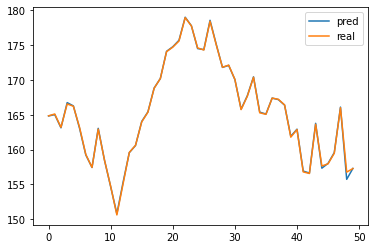

In [39]:
bmodel = TransformerTimeSeries(feature_dim = feature_dim,
                                  nhead = 4,num_layers = 12,d_model = 512,
                                  conv_len = 5,feature_weight = True,embedding_weight = True)
bmodel.load_state_dict(torch.load('AAPL_12y'))
bmodel.to(device)
bmodel.eval()
with torch.no_grad(): # eliminate gradient i.e. gradients only exists in train()

    for step,(x,y,feature,attention_masks) in enumerate(test_dl):
        x = x.to(device)
        y = y.to(device)
        feature = feature.to(device)
        attention_masks = attention_masks.to(device)
        output = bmodel(x,y,feature,attention_masks[0])
        
        pred = data[train_size + 1 :-1,3]*0.01*(100+output[:,t0:].squeeze()).detach().cpu()
        ## note that test set starts at index train_size + 1 because idex train_size in rate_data 
        ## is the last day of first test data point, but rate_data only have the second til last data points
        ## of the dataset.
        #real = data[train_size + 1 :-1,3]*0.01*(100+y[:,t0:].squeeze()).detach().cpu()
        real = data[train_size+2:,3].detach().cpu()
        plt.plot(pred[-50:])
        plt.plot(real[-50:])
        plt.legend(['pred','real'])
        MAE = torch.nn.L1Loss()(pred,real).item()
        MSE = torch.nn.MSELoss()(pred,real).item()
        RMSE = np.sqrt(MSE)
        
        print(f'AAPL MAE is {MAE}')
        print(f'AAPL MSE is {MSE}')
        print(f'AAPL RMSE is {RMSE}')